In [ ]:
import os
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sys
import tensorflow as tf

# Φόρτωση Δεδομένων σε DataFrame & Μετατροπή Τύπων Δεδομένων

In [ ]:
# Ορίζουμε το όνομα του αρχείου δεδομένων (CSV)
file_path = 'sms-call-internet-mi-2013-11-01.csv'
# Καταγράφουμε την ώρα έναρξης της διαδικασίας, για να μετρήσουμε τη διάρκεια εκτέλεσης
start_time = time.time()

In [ ]:
# Φόρτωση του αρχείου και μετατροπή της στήλης datetime σε ημερομηνία
print("Loading data from CSV in chunks... (this may take a while for 1M+ rows)")
sys.stdout.flush() # Εξασφαλίζουμε ότι το μήνυμα εμφανίζεται άμεσα στη γραμμή εντολών

chunks = [] # Λίστα για την προσωρινή αποθήκευση των τμημάτων δεδομένων (chunks)
try:
    for chunk in pd.read_csv(file_path, parse_dates=['datetime'], chunksize=200_000): # Διαβάζουμε το αρχείο CSV σε chunks των 200.000 γραμμών και κάνουμε parsing στη στήλη datetime
        chunks.append(chunk)
        print(f"Loaded chunk with shape: {chunk.shape} (Total so far: {sum(len(c) for c in chunks)})")
        sys.stdout.flush()
    df_cdrs = pd.concat(chunks, ignore_index=True) # Συνενώνουμε όλα τα chunks σε ένα τελικό DataFrame
except Exception as e:
    print("Failed to load with parse_dates, retrying without for debug...") # Εάν αποτύχει το parsing της ημερομηνίας, επαναλαμβάνουμε χωρίς τη μετατροπή για debug
    for chunk in pd.read_csv(file_path, chunksize=200_000):
        chunks.append(chunk)
        print(f"Loaded chunk with shape: {chunk.shape} (Total so far: {sum(len(c) for c in chunks)})")
        sys.stdout.flush()
    df_cdrs = pd.concat(chunks, ignore_index=True)
    print(df_cdrs.head()) # Εμφάνιση των πρώτων γραμμών για έλεγχο
    raise e

print(f"Total shape after concat: {df_cdrs.shape}  (Elapsed: {time.time()-start_time:.1f}s)") # Εμφάνιση συνολικού μεγέθους δεδομένων και χρόνου εκτέλεσης
print(df_cdrs.dtypes) # Εμφάνιση τύπων δεδομένων κάθε στήλης
print(df_cdrs.head(3)) # Εμφάνιση των τριών πρώτων γραμμών για οπτικό έλεγχο
sys.stdout.flush() # Εξασφαλίζουμε ότι όλα τα μηνύματα έχουν εκτυπωθεί

Loading data from CSV in chunks... (this may take a while for 1M+ rows)


Loaded chunk with shape: (200000, 8) (Total so far: 200000)


Loaded chunk with shape: (200000, 8) (Total so far: 400000)


Loaded chunk with shape: (200000, 8) (Total so far: 600000)


Loaded chunk with shape: (200000, 8) (Total so far: 800000)


Loaded chunk with shape: (200000, 8) (Total so far: 1000000)


Loaded chunk with shape: (200000, 8) (Total so far: 1200000)


Loaded chunk with shape: (200000, 8) (Total so far: 1400000)


Loaded chunk with shape: (200000, 8) (Total so far: 1600000)


Loaded chunk with shape: (200000, 8) (Total so far: 1800000)


Loaded chunk with shape: (91928, 8) (Total so far: 1891928)


Total shape after concat: (1891928, 8)  (Elapsed: 1.0s)
datetime       datetime64[ns]
CellID                  int64
countrycode             int64
smsin                 float64
smsout                float64
callin                float64
callout               float64
internet              float64
dtype: object
    datetime  CellID  countrycode   smsin  smsout  callin  callout  internet
0 2013-11-01       1            0  0.3521     NaN     NaN   0.0273       NaN
1 2013-11-01       1           33     NaN     NaN     NaN      NaN    0.0261
2 2013-11-01       1           39  1.7322  1.1047  0.5919   0.4020   57.7729


In [4]:
# Εμφάνιση πρώτων γραμμών για επιβεβαίωση
df_cdrs.head(10)

,datetime,CellID,countrycode,smsin,smsout,callin,callout,internet
0,2013-11-01,1,0,0.3521,NaN,NaN,0.0273,NaN
1,2013-11-01,1,33,NaN,NaN,NaN,NaN,0.0261
2,2013-11-01,1,39,1.7322,1.1047,0.5919,0.4020,57.7729
3,2013-11-01,2,0,0.3581,NaN,NaN,0.0273,NaN
4,2013-11-01,2,33,NaN,NaN,NaN,NaN,0.0274
5,2013-11-01,2,39,1.7334,1.0880,0.6020,0.4109,57.8875
6,2013-11-01,3,0,0.3644,NaN,NaN,0.0273,NaN
7,2013-11-01,3,33,NaN,NaN,NaN,NaN,0.0287
8,2013-11-01,3,39,1.7348,1.0701,0.6128,0.4203,58.0095
9,2013-11-01,4,0,0.3349,NaN,NaN,0.0273,NaN


# Έλεγχος & Καθαρισμός Ελλειπουσών Τιμών

In [ ]:
print("Checking for missing values...")
missing = df_cdrs.isnull().sum() # Υπολογίζουμε τον αριθμό των ελλιπών τιμών (NaN) ανά στήλη
print("Missing values per column:\n", missing) # Εκτυπώνουμε το πλήθος των ελλιπών τιμών για κάθε στήλη
sys.stdout.flush() # Εξασφαλίζουμε ότι το μήνυμα εμφανίζεται άμεσα στη γραμμή εντολών

Checking for missing values...
Missing values per column:
 datetime             0
CellID               0
countrycode          0
smsin          1086153
smsout         1422446
callin         1407781
callout        1037413
internet       1087074
dtype: int64


In [ ]:
print("Filling NaNs with 0s...")
df_cdrs = df_cdrs.fillna(0) # Αντικαθιστούμε όλες τις ελλιπείς τιμές (NaN) με το 0 σε όλο το DataFrame
print("Missing values after fill:\n", df_cdrs.isnull().sum()) # Ελέγχουμε ξανά και εκτυπώνει πόσες NaN τιμές απομένουν σε κάθε στήλη

Filling NaNs with 0s...


Missing values after fill:
 datetime       0
CellID         0
countrycode    0
smsin          0
smsout         0
callin         0
callout        0
internet       0
dtype: int64


In [7]:
df_cdrs.head(10)

,datetime,CellID,countrycode,smsin,smsout,callin,callout,internet
0,2013-11-01,1,0,0.3521,0.0000,0.0000,0.0273,0.0000
1,2013-11-01,1,33,0.0000,0.0000,0.0000,0.0000,0.0261
2,2013-11-01,1,39,1.7322,1.1047,0.5919,0.4020,57.7729
3,2013-11-01,2,0,0.3581,0.0000,0.0000,0.0273,0.0000
4,2013-11-01,2,33,0.0000,0.0000,0.0000,0.0000,0.0274
5,2013-11-01,2,39,1.7334,1.0880,0.6020,0.4109,57.8875
6,2013-11-01,3,0,0.3644,0.0000,0.0000,0.0273,0.0000
7,2013-11-01,3,33,0.0000,0.0000,0.0000,0.0000,0.0287
8,2013-11-01,3,39,1.7348,1.0701,0.6128,0.4203,58.0095
9,2013-11-01,4,0,0.3349,0.0000,0.0000,0.0273,0.0000


# Επιλογή Χαρακτηριστικών & Περιγραφικά Στατιστικά

In [ ]:
# Επιλογή των στηλών-χαρακτηριστικών που θα χρησιμοποιηθούν ως είσοδος για το WGAN-GP
input_features = ['smsin', 'smsout', 'callin', 'callout', 'internet']
print("Selecting features:", input_features)
input_data = df_cdrs[input_features].values # Εξαγωγή των τιμών αυτών των στηλών ως numpy array για χρήση στο μοντέλο

Selecting features: ['smsin', 'smsout', 'callin', 'callout', 'internet']


In [9]:
print("\nΠεριγραφή αρχικών δεδομένων:")
print(df_cdrs[input_features].describe())


Περιγραφή αρχικών δεδομένων:


              smsin        smsout        callin       callout      internet
count  1.891928e+06  1.891928e+06  1.891928e+06  1.891928e+06  1.891928e+06
mean   2.434758e+00  1.491827e+00  1.386311e+00  1.689685e+00  4.359534e+01
std    1.050540e+01  8.835677e+00  8.390905e+00  9.582373e+00  2.287623e+02
min    0.000000e+00  0.000000e+00  0.000000e+00  0.000000e+00  0.000000e+00
25%    0.000000e+00  0.000000e+00  0.000000e+00  0.000000e+00  0.000000e+00
50%    0.000000e+00  0.000000e+00  0.000000e+00  0.000000e+00  0.000000e+00
75%    4.225000e-01  0.000000e+00  1.900000e-03  1.815000e-01  1.393000e-01
max    1.109082e+03  1.577904e+03  9.885767e+02  1.024899e+03  2.777430e+04


In [ ]:
df_cdrs['is_zero_row'] = (df_cdrs[input_features] == 0).all(axis=1).astype(int) # Δημιουργία νέας στήλης που εντοπίζει αν όλα τα επιλεγμένα χαρακτηριστικά μιας γραμμής είναι μηδενικά

# Υπολογισμός του ποσοστού των γραμμών όπου ΟΛΕΣ οι τιμές είναι μηδέν 
zero_row_fraction = (df_cdrs['is_zero_row'] == 1).mean()
print(f"Zero row fraction: {zero_row_fraction:.3f}")
# Κρατάμε μόνο τις γραμμές που ΔΕΝ είναι όλες μηδέν
df_cdrs_nonzero = df_cdrs[df_cdrs['is_zero_row'] == 0].copy()
input_data = df_cdrs_nonzero[input_features].values

Zero row fraction: 0.001


# Κανονικοποίηση Δεδομένων

In [11]:
# Υπολογισμός του μέσου όρου για κάθε χαρακτηριστικό
mu  = input_data.mean(axis=0)
# Υπολογισμός της τυπικής απόκλισης για κάθε χαρακτηριστικό
std = input_data.std(axis=0)
# Κανονικοποίηση των δεδομένων: αφαίρεση μέσου όρου και διαίρεση με την τυπική απόκλιση
input_data = (input_data - mu) / std

In [12]:
# Δημιουργούμε ένα DataFrame με τα κανονικοποιημένα δεδομένα
df_normalized = pd.DataFrame(input_data, columns=input_features)

# Εμφανίζουμε τα περιγραφικά στατιστικά
print(df_normalized.describe())

              smsin        smsout        callin       callout      internet
count  1.890193e+06  1.890193e+06  1.890193e+06  1.890193e+06  1.890193e+06
mean   1.455524e-17  3.482808e-17  1.358088e-16 -8.991771e-17 -4.905627e-17
std    1.000000e+00  1.000000e+00  1.000000e+00  1.000000e+00  1.000000e+00
min   -2.318746e-01 -1.689210e-01 -1.652938e-01 -1.764161e-01 -1.906611e-01
25%   -2.318746e-01 -1.689210e-01 -1.652938e-01 -1.764161e-01 -1.906611e-01
50%   -2.318746e-01 -1.689210e-01 -1.652938e-01 -1.764161e-01 -1.906611e-01
75%   -1.915509e-01 -1.689210e-01 -1.650555e-01 -1.574313e-01 -1.900503e-01
max    1.052949e+02  1.783348e+02  1.175974e+02  1.067328e+02  1.211669e+02


In [ ]:
print("Checking data distribution after normalization:")
print(pd.DataFrame(input_data, columns=input_features).describe()) # Εκτύπωση περιγραφικών στατιστικών για τα κανονικοποιημένα δεδομένα εισόδου
print(f"Total preprocessing time: {time.time()-start_time:.1f}s") # Εκτύπωση του συνολικού χρόνου που απαιτήθηκε για όλη τη διαδικασία προεπεξεργασίας
sys.stdout.flush() 

Checking data distribution after normalization:


              smsin        smsout        callin       callout      internet
count  1.890193e+06  1.890193e+06  1.890193e+06  1.890193e+06  1.890193e+06
mean   1.455524e-17  3.482808e-17  1.358088e-16 -8.991771e-17 -4.905627e-17
std    1.000000e+00  1.000000e+00  1.000000e+00  1.000000e+00  1.000000e+00
min   -2.318746e-01 -1.689210e-01 -1.652938e-01 -1.764161e-01 -1.906611e-01
25%   -2.318746e-01 -1.689210e-01 -1.652938e-01 -1.764161e-01 -1.906611e-01
50%   -2.318746e-01 -1.689210e-01 -1.652938e-01 -1.764161e-01 -1.906611e-01
75%   -1.915509e-01 -1.689210e-01 -1.650555e-01 -1.574313e-01 -1.900503e-01
max    1.052949e+02  1.783348e+02  1.175974e+02  1.067328e+02  1.211669e+02
Total preprocessing time: 2.5s


In [ ]:
# Δημιουργία TensorFlow dataset από τα επεξεργασμένα δεδομένα εισόδου
batch_size = 128  
dataset = tf.data.Dataset.from_tensor_slices(input_data.astype('float32')) # Μετατροπή των δεδομένων σε τύπο float32 για συμβατότητα με το TensorFlow
dataset = dataset.shuffle(buffer_size=1024).batch(batch_size) # Τυχαία ανάμειξη των δειγμάτων για καλύτερη εκπαίδευση του μοντέλου

2025-05-24 10:18:48.644308: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1635] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 38380 MB memory:  -> device: 0, name: NVIDIA A100-SXM4-40GB, pci bus id: 0000:c7:00.0, compute capability: 8.0


# Οπτικοποίηση Κατανομών

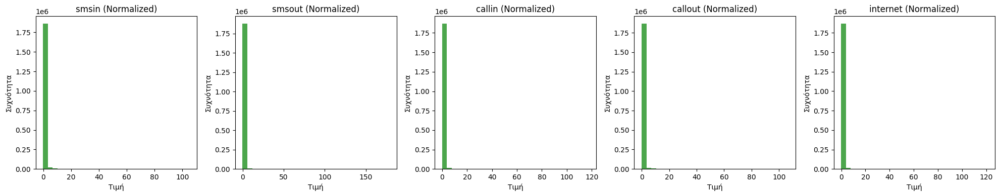

In [15]:
import matplotlib.pyplot as plt

# Ορισμός του πλήθους των χαρακτηριστικών από το σχήμα των δεδομένων
num_features = input_data.shape[1]

# Δημιουργία subplots σε μία γραμμή με μία στήλη ανά χαρακτηριστικό
fig, axes = plt.subplots(1, num_features, figsize=(4 * num_features, 4))

# Βρόχος για κάθε χαρακτηριστικό
for i in range(num_features):
    # Σχεδίαση ιστόγραμματος για το i-οστό χαρακτηριστικό
    axes[i].hist(input_data[:, i], bins=30, color='green', alpha=0.7)
     # Ορισμός τίτλου του υποδιαγράμματος με όνομα χαρακτηριστικού
    axes[i].set_title(f"{input_features[i]} (Normalized)")
    # Άξονας x
    axes[i].set_xlabel("Τιμή")
    # Άξονας y
    axes[i].set_ylabel("Συχνότητα")
    
# Αυτόματη προσαρμογή διατάξεων για αποφυγή επικάλυψης
plt.tight_layout()
# Εμφάνιση του γραφήματος
plt.show()

# Υπολογισμός Πίνακα Συσχέτισης (Spearman) & Heatmap

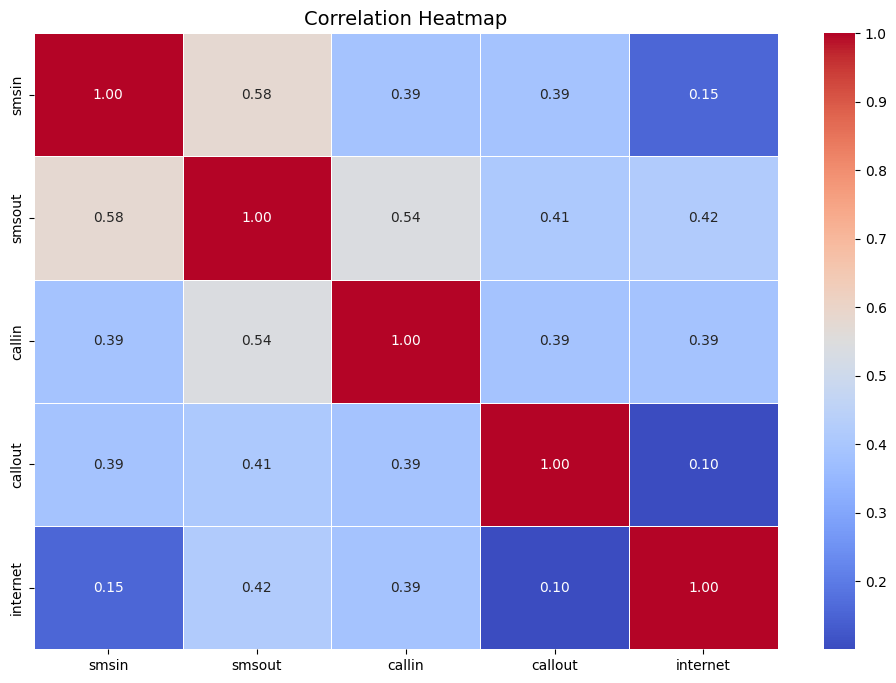

In [16]:
# Υπολογισμός του πίνακα συσχέτισης Spearman για τα κανονικοποιημένα δεδομένα
corr_matrix = df_normalized.corr(method='spearman')

# Διάσταση 12x8 ίντσες
plt.figure(figsize=(12, 8))

# Σχεδίαση heatmap του πίνακα συσχέτισης
sns.heatmap(
    corr_matrix,
    annot=True, # Εμφάνιση αριθμητικών τιμών σε κάθε κελί
    fmt='.2f',  # Μορφοποίηση τιμών με δύο δεκαδικά ψηφία 
    cmap='coolwarm',   # Χρωματική κλίμακα 'coolwarm' 
    linewidths=0.5  # Πάχος γραμμών διαχωρισμού κελιών
)

# Προσθήκη τίτλου στο γράφημα
plt.title('Correlation Heatmap', fontsize=14)
# Εμφάνιση του heatmap
plt.show()

# Pair Plot για τα Κανονικοποιημένα Δεδομένα

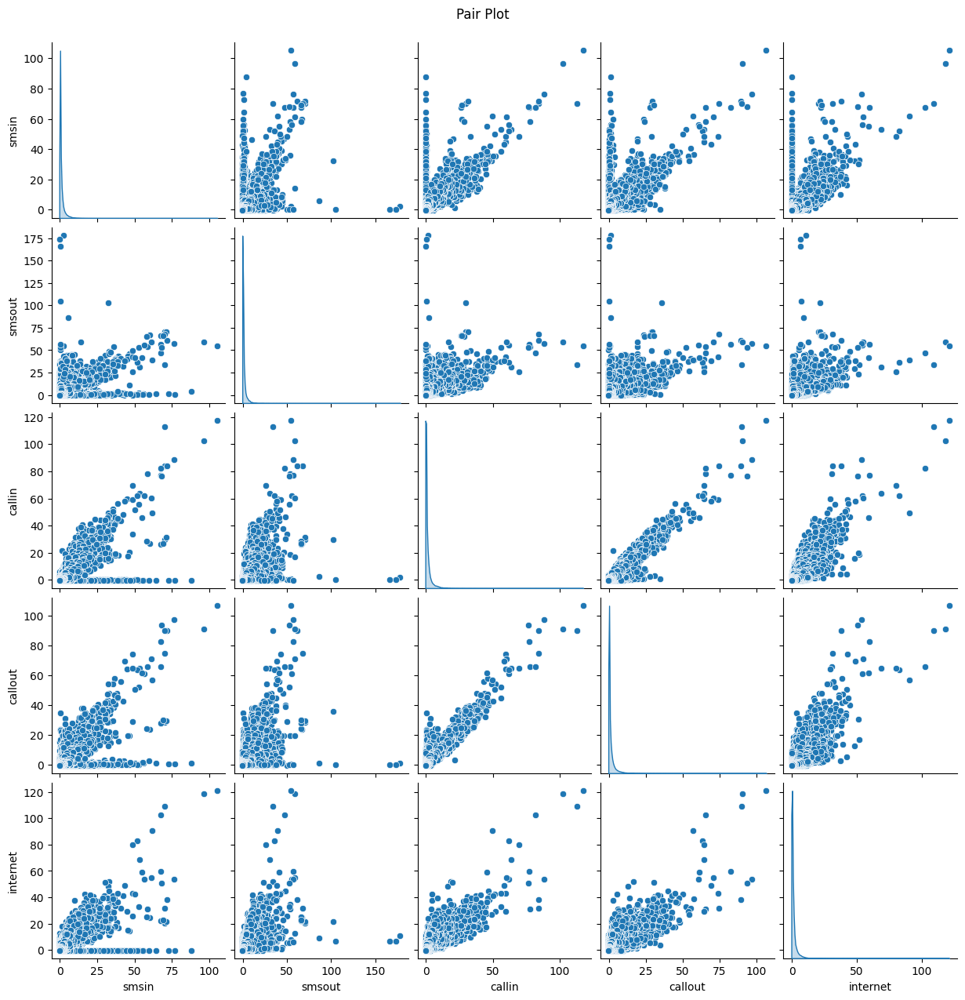

In [17]:
# Αφαίρεση σειρών με ελλείπουσες τιμές από το DataFrame
df_numeric = df_normalized.dropna()

# Δημιουργία pair plot για οπτικοποίηση των σχέσεων μεταξύ των χαρακτηριστικών
sns.pairplot(df_numeric, diag_kind='kde')

# Προσθήκη κύριου τίτλου στο διάγραμμα, με μετατόπιση y ώστε να μην επικαλύπτεται
plt.suptitle('Pair Plot', y=1.02)
# Εμφάνιση του διαγράμματος
plt.show()

# Υλοποίηση & Εκπαίδευση WGAN-GP

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
import numpy as np
import os
import time

print("Ξεκινάει η δημιουργία του GAN...") #Το WGAN-GP

# ==== Αρχιτεκτονικές Μοντέλων (Βέλτιστες tabular data) ====
latent_dim = 16  # Προσαρμοσμένο για 5 features

# Συνάρτηση δημιουργίας του Generator
def build_generator(latent_dim):
    print("Δημιουργία Generator...")
    generator = models.Sequential([
        layers.InputLayer(input_shape=(latent_dim,)),  # Είσοδος τυχαίου θορύβου
        layers.Dense(64), layers.LayerNormalization(), layers.ReLU(), # Κρυφά επίπεδα με LayerNorm + ReLU
        layers.Dense(128), layers.LayerNormalization(), layers.ReLU(),
        layers.Dense(32), layers.LayerNormalization(), layers.ReLU(),
        layers.Dense(5, activation='linear') # Έξοδος 5 χαρακτηριστικά (συνεχείς τιμές)
    ])
    print("O Generator δημιουργήθηκε.")
    return generator

# Συνάρτηση δημιουργίας του Discriminator. Ουσιαστικά είναι ο Critic (κριτής), απλά κάνουμε παραλληλισμό με το GAN για ευκολότερη κατανόηση.
def build_discriminator(input_dim=5):
    print("Δημιουργία Discriminator...")
    discriminator = models.Sequential([
        layers.InputLayer(input_shape=(input_dim,)), # Είσοδος τα 5 features
        layers.Dense(128), layers.LeakyReLU(0.2),
        layers.Dense(64), layers.LeakyReLU(0.2),
        layers.Dense(32), layers.LeakyReLU(0.2),
        layers.Dense(1) # Έξοδος: score (Wasserstein)
    ])
    print("O Discriminator δημιουργήθηκε.")
    return discriminator

# Δημιουργία των δύο δικτύων
generator = build_generator(latent_dim)
discriminator = build_discriminator(input_dim=5)

# ==== Υπερπαράμετροι Εκπαίδευσης (βελτιωμένες τιμές) ====
batch_size = 128 # Μέγεθος batch για το dataset και το training
LAMBDA = 10.0  # Συντελεστής βαρύτητας για το gradient penalty (WGAN-GP)
current_learning_rate = 0.0001  # Αρχικό learning rate για τους Adam optimizers

# Δημιουργία των Adam optimizers για τον Generator και τον Critic (Discriminator)
D_optimizer = tf.keras.optimizers.Adam(learning_rate=current_learning_rate, beta_1=0.5)
G_optimizer = tf.keras.optimizers.Adam(learning_rate=current_learning_rate, beta_1=0.5)

# ==== Checkpointing (Αποθήκευση προόδου εκπαίδευσης) ====
checkpoint_dir = './training_checkpoints'
os.makedirs(checkpoint_dir, exist_ok=True)
ckpt = tf.train.Checkpoint(
    generator=generator,
    discriminator=discriminator,
    G_optimizer=G_optimizer,
    D_optimizer=D_optimizer
)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_dir, max_to_keep=5)

# Επαναφορά από τελευταίο checkpoint (αν υπάρχει)
latest_ckpt = ckpt_manager.latest_checkpoint
if latest_ckpt:
    ckpt.restore(latest_ckpt)
    print(f"Restored from {latest_ckpt}")
else:
    print("No checkpoint found, training from scratch.")

# ==== Ρυθμίσεις Εκπαίδευσης ====
EPOCHs = 150  # Συνολικός αριθμός epochs
CURRENT_EPOCH = 101 # Από πού συνεχίζει η εκπαίδευση
N_CRITIC = 5 # Πόσες φορές ενημερώνεται ο κριτής για κάθε ενημέρωση του generator
SAVE_EVERY_N_EPOCH = 1 # Κάθε πότε γίνεται αποθήκευση checkpoint

# ==== Training Steps ====
@tf.function
def train_d_step(real_data):
    discriminator.trainable = True  # Ο critic εκπαιδεύεται (ξεκλειδώνουμε τα βάρη)
    current_batch = tf.shape(real_data)[0]  # Μέγεθος τρέχοντος batch
    noise = tf.random.normal([current_batch, latent_dim]) # Δημιουργία τυχαίου θορύβου για τη γεννήτρια
    with tf.GradientTape(persistent=True) as tape:  # Χρήση GradientTape για αυτόματη παραγώγιση
        fake_data = generator(noise, training=True) # Δημιουργία fake δεδομένων με τη γεννήτρια
        real_pred = discriminator(real_data, training=True) # Κριτική για τα πραγματικά δεδομένα
        fake_pred = discriminator(fake_data, training=True) # Κριτική για τα ψεύτικα δεδομένα
        epsilon = tf.random.uniform([current_batch, 1], 0.0, 1.0) # Υπολογισμός gradient penalty για WGAN-GP 
        interpolated_data = epsilon * real_data + (1 - epsilon) * fake_data # Ενδιάμεση παρεμβολή μεταξύ πραγματικών και ψεύτικων δεδομένων
        with tf.GradientTape() as gp_tape: # Νέο tape για το gradient των interpolated samples
            gp_tape.watch(interpolated_data) 
            interp_pred = discriminator(interpolated_data, training=True)  
        grads = gp_tape.gradient(interp_pred, interpolated_data)  # Υπολογισμός gradient ως προς το interpolated_data
        grads_norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=1)) # Υπολογισμός νόρμας του gradient
        gradient_penalty = tf.reduce_mean((grads_norm - 1.0) ** 2)  # Υπολογισμός gradient penalty (θέλουμε η νόρμα να είναι 1)
        d_loss = tf.reduce_mean(fake_pred) - tf.reduce_mean(real_pred) + LAMBDA * gradient_penalty # WGAN-GP Loss: (Fake - Real) + Penalty
    d_gradients = tape.gradient(d_loss, discriminator.trainable_variables) # Υπολογισμός παραγώγων για τα βάρη του κριτή
    D_optimizer.apply_gradients(zip(d_gradients, discriminator.trainable_variables))  # Ενημέρωση βαρών του κριτή
    return d_loss, gradient_penalty # Επιστροφή τιμών απώλειας και penalty

@tf.function
def train_g_step():
    noise = tf.random.normal([batch_size, latent_dim]) # Εκπαίδευση του generator (να ξεγελάσει τον critic)
    with tf.GradientTape() as tape: # GradientTape για τα βάρη του generator
        generated_data = generator(noise, training=True) # Δημιουργία ψεύτικων δεδομένων
        gen_pred = discriminator(generated_data, training=True)  # Υπολογισμός score από τον critic
        g_loss = -tf.reduce_mean(gen_pred) # Loss του generator (θέλει υψηλό score)
    g_gradients = tape.gradient(g_loss, generator.trainable_variables) # Υπολογισμός παραγώγων για τα βάρη του generator
    G_optimizer.apply_gradients(zip(g_gradients, generator.trainable_variables))  # Ενημέρωση βαρών του generator
    return g_loss

# Συνάρτηση μείωσης learning rate (για καλύτερη σύγκλιση)
def learning_rate_decay(lr, decay_rate=0.99):
    return lr * decay_rate

# Ενημέρωση learning rate στους optimizers
def set_learning_rate(lr):
    D_optimizer.learning_rate.assign(lr)
    G_optimizer.learning_rate.assign(lr)

n_critic_count = 0  # Μετρητής για N_CRITIC

for epoch in range(CURRENT_EPOCH, EPOCHs + 1):
    start = time.time()
    print(f'\n========== Start of epoch {epoch} ==========')
    # Decay learning rate
    current_learning_rate = learning_rate_decay(current_learning_rate)
    print(f'Current learning rate: {current_learning_rate:.6f}')
    set_learning_rate(current_learning_rate)
    # Μετρικές epoch
    d_loss_epoch = 0.0
    gp_epoch = 0.0
    g_loss_epoch = 0.0
    steps = 0
    for step, real_batch in enumerate(dataset):
         # Εκπαίδευση του critic
        d_loss, gp_val = train_d_step(real_batch)
        d_loss_epoch += d_loss
        gp_epoch += gp_val
        n_critic_count += 1
        # Εμφάνιση κάθε 10 βήματα
        if step % 10 == 0:
            msg = f"Epoch {epoch} | Step {step} | D_loss: {float(d_loss):.4f} | GP: {float(gp_val):.4f}"
            # Κάθε N_CRITIC βήματα, εκπαιδεύεται ο generator
            if n_critic_count == N_CRITIC:
                g_loss = train_g_step()
                g_loss_epoch += g_loss
                msg += f" | G_loss: {float(g_loss):.4f}"
                n_critic_count = 0
            print(msg)
        else:
            # Αν συμπληρώθηκαν N_CRITIC βήματα, εκπαιδεύεται ο generator
            if n_critic_count == N_CRITIC:
                g_loss = train_g_step()
                g_loss_epoch += g_loss
                n_critic_count = 0
        steps += 1

    # Υπολογισμός μέσων τιμών μετρικών για το epoch
    d_loss_epoch_avg = d_loss_epoch / steps
    gp_epoch_avg = gp_epoch / steps
    g_loss_epoch_avg = g_loss_epoch / (steps // N_CRITIC + 1) if steps > 0 else 0
    print(f"\n==> Epoch {epoch}/{EPOCHs} FINISHED")
    print(f"    D_loss: {float(d_loss_epoch_avg):.4f} | G_loss: {float(g_loss_epoch_avg):.4f} | Grad Penalty: {float(gp_epoch_avg):.4f}")
    print(f"    Time taken for epoch {epoch}: {time.time() - start:.2f} sec")
    # Save checkpoint
    if epoch % SAVE_EVERY_N_EPOCH == 0:
        ckpt_save_path = ckpt_manager.save()
        print(f"    Saving checkpoint for epoch {epoch} at {ckpt_save_path}")

# Τελική αποθήκευση μετά το τέλος της εκπαίδευσης
ckpt_save_path = ckpt_manager.save()
print(f"\nSaving checkpoint for final epoch {EPOCHs} at {ckpt_save_path}")
print("Training finished.")
print(f"Total training time: {time.time() - start_time:.2f} sec")

Ξεκινάει η δημιουργία του GAN...
Δημιουργία Generator...
O Generator δημιουργήθηκε.
Δημιουργία Discriminator...
O Discriminator δημιουργήθηκε.
Restored from ./training_checkpoints/ckpt-102

========== Start of epoch 101 ==========
Current learning rate: 0.000099


2025-05-24 10:21:08.942266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1890193,5]
	 [[{{node Placeholder/_0}}]]
2025-05-24 10:21:08.942563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1890193,5]
	 [[{{node Placeholder/_0}}]]


2025-05-24 10:21:09.958700: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:637] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2025-05-24 10:21:10.007052: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:424] Loaded cuDNN version 8600
2025-05-24 10:21:10.041359: I tensorflow/compiler/xla/service/service.cc:169] XLA service 0x7f57e4d95220 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-05-24 10:21:10.041402: I tensorflow/compiler/xla/service/service.cc:177]   StreamExecutor device (0): NVIDIA A100-SXM4-40GB, Compute Capability 8.0
2025-05-24 10:21:10.047529: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.


2025-05-24 10:21:10.197090: I ./tensorflow/compiler/jit/device_compiler.h:180] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Epoch 101 | Step 0 | D_loss: 0.3020 | GP: 0.0003


Epoch 101 | Step 10 | D_loss: 0.0241 | GP: 0.0006
Epoch 101 | Step 20 | D_loss: -0.0283 | GP: 0.0011
Epoch 101 | Step 30 | D_loss: -0.0252 | GP: 0.0011
Epoch 101 | Step 40 | D_loss: 0.0132 | GP: 0.0038
Epoch 101 | Step 50 | D_loss: -0.3072 | GP: 0.0079


Epoch 101 | Step 60 | D_loss: -0.2606 | GP: 0.0032
Epoch 101 | Step 70 | D_loss: -0.0940 | GP: 0.0010
Epoch 101 | Step 80 | D_loss: -0.0895 | GP: 0.0007
Epoch 101 | Step 90 | D_loss: 0.0819 | GP: 0.0003


Epoch 101 | Step 100 | D_loss: -0.2623 | GP: 0.0006
Epoch 101 | Step 110 | D_loss: -0.1265 | GP: 0.0005
Epoch 101 | Step 120 | D_loss: -0.1143 | GP: 0.0004
Epoch 101 | Step 130 | D_loss: -0.1323 | GP: 0.0005
Epoch 101 | Step 140 | D_loss: -0.0707 | GP: 0.0002


Epoch 101 | Step 150 | D_loss: -0.0887 | GP: 0.0002
Epoch 101 | Step 160 | D_loss: -0.1049 | GP: 0.0012
Epoch 101 | Step 170 | D_loss: -0.1305 | GP: 0.0002
Epoch 101 | Step 180 | D_loss: -0.0887 | GP: 0.0006
Epoch 101 | Step 190 | D_loss: -0.0476 | GP: 0.0012


Epoch 101 | Step 200 | D_loss: -0.0459 | GP: 0.0036
Epoch 101 | Step 210 | D_loss: -0.0169 | GP: 0.0009
Epoch 101 | Step 220 | D_loss: 0.0070 | GP: 0.0022
Epoch 101 | Step 230 | D_loss: 0.0223 | GP: 0.0007
Epoch 101 | Step 240 | D_loss: 0.0068 | GP: 0.0014


Epoch 101 | Step 250 | D_loss: -0.0082 | GP: 0.0010
Epoch 101 | Step 260 | D_loss: 0.0212 | GP: 0.0011
Epoch 101 | Step 270 | D_loss: 0.1416 | GP: 0.0020
Epoch 101 | Step 280 | D_loss: 0.0458 | GP: 0.0024
Epoch 101 | Step 290 | D_loss: -0.0253 | GP: 0.0006


Epoch 101 | Step 300 | D_loss: -0.0306 | GP: 0.0010
Epoch 101 | Step 310 | D_loss: 0.0941 | GP: 0.0028
Epoch 101 | Step 320 | D_loss: 0.1092 | GP: 0.0033
Epoch 101 | Step 330 | D_loss: -1.2756 | GP: 0.0055
Epoch 101 | Step 340 | D_loss: -1.2790 | GP: 0.0122


Epoch 101 | Step 350 | D_loss: -0.5975 | GP: 0.0075
Epoch 101 | Step 360 | D_loss: -1.2869 | GP: 0.0139
Epoch 101 | Step 370 | D_loss: -1.0329 | GP: 0.0117
Epoch 101 | Step 380 | D_loss: -0.8506 | GP: 0.0067
Epoch 101 | Step 390 | D_loss: -0.4074 | GP: 0.0012


Epoch 101 | Step 400 | D_loss: -0.4717 | GP: 0.0070
Epoch 101 | Step 410 | D_loss: -0.1538 | GP: 0.0065
Epoch 101 | Step 420 | D_loss: -0.3881 | GP: 0.0054
Epoch 101 | Step 430 | D_loss: -0.6298 | GP: 0.0074
Epoch 101 | Step 440 | D_loss: -0.4209 | GP: 0.0093


Epoch 101 | Step 450 | D_loss: -0.2218 | GP: 0.0015
Epoch 101 | Step 460 | D_loss: -0.2030 | GP: 0.0127
Epoch 101 | Step 470 | D_loss: -0.1912 | GP: 0.0071
Epoch 101 | Step 480 | D_loss: -0.2502 | GP: 0.0038
Epoch 101 | Step 490 | D_loss: -0.3320 | GP: 0.0060


Epoch 101 | Step 500 | D_loss: -0.6542 | GP: 0.0098
Epoch 101 | Step 510 | D_loss: -0.6179 | GP: 0.0048
Epoch 101 | Step 520 | D_loss: -0.8526 | GP: 0.0057
Epoch 101 | Step 530 | D_loss: -0.2297 | GP: 0.0044
Epoch 101 | Step 540 | D_loss: -0.0860 | GP: 0.0175


Epoch 101 | Step 550 | D_loss: -0.6416 | GP: 0.0079
Epoch 101 | Step 560 | D_loss: 1.1046 | GP: 0.0128
Epoch 101 | Step 570 | D_loss: 0.7929 | GP: 0.0029
Epoch 101 | Step 580 | D_loss: 0.3823 | GP: 0.0065
Epoch 101 | Step 590 | D_loss: 0.1462 | GP: 0.0096


Epoch 101 | Step 600 | D_loss: 0.0251 | GP: 0.0072
Epoch 101 | Step 610 | D_loss: -0.0978 | GP: 0.0007
Epoch 101 | Step 620 | D_loss: 0.0235 | GP: 0.0023
Epoch 101 | Step 630 | D_loss: -0.1051 | GP: 0.0021


Epoch 101 | Step 640 | D_loss: -0.1438 | GP: 0.0021
Epoch 101 | Step 650 | D_loss: 0.1505 | GP: 0.0009
Epoch 101 | Step 660 | D_loss: -0.0102 | GP: 0.0010
Epoch 101 | Step 670 | D_loss: 0.0349 | GP: 0.0013


Epoch 101 | Step 680 | D_loss: 0.4204 | GP: 0.0036
Epoch 101 | Step 690 | D_loss: 0.0928 | GP: 0.0012
Epoch 101 | Step 700 | D_loss: -0.0451 | GP: 0.0029
Epoch 101 | Step 710 | D_loss: 0.0129 | GP: 0.0021


Epoch 101 | Step 720 | D_loss: 0.3609 | GP: 0.0029
Epoch 101 | Step 730 | D_loss: 0.1417 | GP: 0.0007
Epoch 101 | Step 740 | D_loss: -0.0006 | GP: 0.0024
Epoch 101 | Step 750 | D_loss: -0.0887 | GP: 0.0013
Epoch 101 | Step 760 | D_loss: -0.0107 | GP: 0.0006


Epoch 101 | Step 770 | D_loss: -0.1052 | GP: 0.0021
Epoch 101 | Step 780 | D_loss: -0.1461 | GP: 0.0010
Epoch 101 | Step 790 | D_loss: -0.1613 | GP: 0.0018
Epoch 101 | Step 800 | D_loss: -0.1835 | GP: 0.0010
Epoch 101 | Step 810 | D_loss: -0.1398 | GP: 0.0028


Epoch 101 | Step 820 | D_loss: -0.0045 | GP: 0.0043
Epoch 101 | Step 830 | D_loss: -0.1098 | GP: 0.0017
Epoch 101 | Step 840 | D_loss: -0.1920 | GP: 0.0005
Epoch 101 | Step 850 | D_loss: -0.1863 | GP: 0.0004
Epoch 101 | Step 860 | D_loss: -0.4064 | GP: 0.0014


Epoch 101 | Step 870 | D_loss: -0.0763 | GP: 0.0005
Epoch 101 | Step 880 | D_loss: -0.2809 | GP: 0.0013
Epoch 101 | Step 890 | D_loss: -0.2694 | GP: 0.0056
Epoch 101 | Step 900 | D_loss: -0.4986 | GP: 0.0064
Epoch 101 | Step 910 | D_loss: -0.1933 | GP: 0.0079


Epoch 101 | Step 920 | D_loss: -0.0687 | GP: 0.0040
Epoch 101 | Step 930 | D_loss: -0.2652 | GP: 0.0030
Epoch 101 | Step 940 | D_loss: 0.0246 | GP: 0.0036
Epoch 101 | Step 950 | D_loss: -0.1619 | GP: 0.0028
Epoch 101 | Step 960 | D_loss: 0.0069 | GP: 0.0016


Epoch 101 | Step 970 | D_loss: -0.0752 | GP: 0.0007
Epoch 101 | Step 980 | D_loss: -0.0941 | GP: 0.0029
Epoch 101 | Step 990 | D_loss: -0.0664 | GP: 0.0015
Epoch 101 | Step 1000 | D_loss: -0.1266 | GP: 0.0013
Epoch 101 | Step 1010 | D_loss: -0.0072 | GP: 0.0030


Epoch 101 | Step 1020 | D_loss: -0.0109 | GP: 0.0067
Epoch 101 | Step 1030 | D_loss: -0.0574 | GP: 0.0033
Epoch 101 | Step 1040 | D_loss: -0.0113 | GP: 0.0067
Epoch 101 | Step 1050 | D_loss: -0.0347 | GP: 0.0074
Epoch 101 | Step 1060 | D_loss: 0.0379 | GP: 0.0070


Epoch 101 | Step 1070 | D_loss: 0.0110 | GP: 0.0061
Epoch 101 | Step 1080 | D_loss: 0.0577 | GP: 0.0060
Epoch 101 | Step 1090 | D_loss: 0.1273 | GP: 0.0069
Epoch 101 | Step 1100 | D_loss: -0.0660 | GP: 0.0095
Epoch 101 | Step 1110 | D_loss: -0.2488 | GP: 0.0108


Epoch 101 | Step 1120 | D_loss: -1.2775 | GP: 0.0099
Epoch 101 | Step 1130 | D_loss: 0.1159 | GP: 0.0120
Epoch 101 | Step 1140 | D_loss: -0.0462 | GP: 0.0040
Epoch 101 | Step 1150 | D_loss: -0.6438 | GP: 0.0109
Epoch 101 | Step 1160 | D_loss: -0.8646 | GP: 0.0071


Epoch 101 | Step 1170 | D_loss: -1.2895 | GP: 0.0096
Epoch 101 | Step 1180 | D_loss: -0.5001 | GP: 0.0074
Epoch 101 | Step 1190 | D_loss: 0.1013 | GP: 0.0058
Epoch 101 | Step 1200 | D_loss: -0.1361 | GP: 0.0069
Epoch 101 | Step 1210 | D_loss: -0.1779 | GP: 0.0059


Epoch 101 | Step 1220 | D_loss: -0.0267 | GP: 0.0066
Epoch 101 | Step 1230 | D_loss: -0.2348 | GP: 0.0064
Epoch 101 | Step 1240 | D_loss: -0.5216 | GP: 0.0076
Epoch 101 | Step 1250 | D_loss: -0.5682 | GP: 0.0120
Epoch 101 | Step 1260 | D_loss: 0.0313 | GP: 0.0058


Epoch 101 | Step 1270 | D_loss: -0.1733 | GP: 0.0033
Epoch 101 | Step 1280 | D_loss: -0.1326 | GP: 0.0032
Epoch 101 | Step 1290 | D_loss: -0.0111 | GP: 0.0018
Epoch 101 | Step 1300 | D_loss: -0.0897 | GP: 0.0018
Epoch 101 | Step 1310 | D_loss: -0.6554 | GP: 0.0035


Epoch 101 | Step 1320 | D_loss: -0.0875 | GP: 0.0028
Epoch 101 | Step 1330 | D_loss: 0.0300 | GP: 0.0008
Epoch 101 | Step 1340 | D_loss: -0.0336 | GP: 0.0009
Epoch 101 | Step 1350 | D_loss: 0.0322 | GP: 0.0008
Epoch 101 | Step 1360 | D_loss: 0.0041 | GP: 0.0003


Epoch 101 | Step 1370 | D_loss: 0.1049 | GP: 0.0013
Epoch 101 | Step 1380 | D_loss: -0.1653 | GP: 0.0016
Epoch 101 | Step 1390 | D_loss: 0.0110 | GP: 0.0022
Epoch 101 | Step 1400 | D_loss: 0.0500 | GP: 0.0006
Epoch 101 | Step 1410 | D_loss: 0.0983 | GP: 0.0010


Epoch 101 | Step 1420 | D_loss: 0.1028 | GP: 0.0003
Epoch 101 | Step 1430 | D_loss: 0.0316 | GP: 0.0004
Epoch 101 | Step 1440 | D_loss: 0.0245 | GP: 0.0002
Epoch 101 | Step 1450 | D_loss: 0.0995 | GP: 0.0011
Epoch 101 | Step 1460 | D_loss: -0.0494 | GP: 0.0005


Epoch 101 | Step 1470 | D_loss: -0.1095 | GP: 0.0004
Epoch 101 | Step 1480 | D_loss: -0.0304 | GP: 0.0002
Epoch 101 | Step 1490 | D_loss: 0.1154 | GP: 0.0003
Epoch 101 | Step 1500 | D_loss: -0.0419 | GP: 0.0002
Epoch 101 | Step 1510 | D_loss: 0.0575 | GP: 0.0006


Epoch 101 | Step 1520 | D_loss: 0.2151 | GP: 0.0006
Epoch 101 | Step 1530 | D_loss: 0.0648 | GP: 0.0007
Epoch 101 | Step 1540 | D_loss: -0.0141 | GP: 0.0004
Epoch 101 | Step 1550 | D_loss: -0.0735 | GP: 0.0014
Epoch 101 | Step 1560 | D_loss: -0.1798 | GP: 0.0022


Epoch 101 | Step 1570 | D_loss: 0.0439 | GP: 0.0013
Epoch 101 | Step 1580 | D_loss: -0.2332 | GP: 0.0032
Epoch 101 | Step 1590 | D_loss: -0.1778 | GP: 0.0068
Epoch 101 | Step 1600 | D_loss: -0.0133 | GP: 0.0032


Epoch 101 | Step 1610 | D_loss: -0.1570 | GP: 0.0033
Epoch 101 | Step 1620 | D_loss: -0.2584 | GP: 0.0043
Epoch 101 | Step 1630 | D_loss: 0.0490 | GP: 0.0012
Epoch 101 | Step 1640 | D_loss: -0.2799 | GP: 0.0020
Epoch 101 | Step 1650 | D_loss: 0.0117 | GP: 0.0010


Epoch 101 | Step 1660 | D_loss: -0.1671 | GP: 0.0005
Epoch 101 | Step 1670 | D_loss: -0.0170 | GP: 0.0004
Epoch 101 | Step 1680 | D_loss: -0.0554 | GP: 0.0003
Epoch 101 | Step 1690 | D_loss: -0.0839 | GP: 0.0002
Epoch 101 | Step 1700 | D_loss: -0.0663 | GP: 0.0001


Epoch 101 | Step 1710 | D_loss: 0.0064 | GP: 0.0009
Epoch 101 | Step 1720 | D_loss: -0.0871 | GP: 0.0009
Epoch 101 | Step 1730 | D_loss: -0.0641 | GP: 0.0017
Epoch 101 | Step 1740 | D_loss: -0.0757 | GP: 0.0008
Epoch 101 | Step 1750 | D_loss: -0.1879 | GP: 0.0019


Epoch 101 | Step 1760 | D_loss: 0.0455 | GP: 0.0019
Epoch 101 | Step 1770 | D_loss: -0.0450 | GP: 0.0027
Epoch 101 | Step 1780 | D_loss: -0.1158 | GP: 0.0035
Epoch 101 | Step 1790 | D_loss: -0.0076 | GP: 0.0303
Epoch 101 | Step 1800 | D_loss: -1.1506 | GP: 0.0025


Epoch 101 | Step 1810 | D_loss: -0.2847 | GP: 0.0022
Epoch 101 | Step 1820 | D_loss: 0.1474 | GP: 0.0048
Epoch 101 | Step 1830 | D_loss: -0.2036 | GP: 0.0059
Epoch 101 | Step 1840 | D_loss: -0.4740 | GP: 0.0082
Epoch 101 | Step 1850 | D_loss: -0.2342 | GP: 0.0064


Epoch 101 | Step 1860 | D_loss: 0.1809 | GP: 0.0063
Epoch 101 | Step 1870 | D_loss: -0.5117 | GP: 0.0041
Epoch 101 | Step 1880 | D_loss: 0.0556 | GP: 0.0037
Epoch 101 | Step 1890 | D_loss: 0.2496 | GP: 0.0026


Epoch 101 | Step 1900 | D_loss: -0.0841 | GP: 0.0026
Epoch 101 | Step 1910 | D_loss: 0.2475 | GP: 0.0026
Epoch 101 | Step 1920 | D_loss: -0.1456 | GP: 0.0017
Epoch 101 | Step 1930 | D_loss: -0.0637 | GP: 0.0025
Epoch 101 | Step 1940 | D_loss: -0.0730 | GP: 0.0018


Epoch 101 | Step 1950 | D_loss: -0.1122 | GP: 0.0011
Epoch 101 | Step 1960 | D_loss: -0.1162 | GP: 0.0020
Epoch 101 | Step 1970 | D_loss: -0.1352 | GP: 0.0006
Epoch 101 | Step 1980 | D_loss: -0.0157 | GP: 0.0005


Epoch 101 | Step 1990 | D_loss: 0.1143 | GP: 0.0005
Epoch 101 | Step 2000 | D_loss: -0.0480 | GP: 0.0004
Epoch 101 | Step 2010 | D_loss: -0.1767 | GP: 0.0006
Epoch 101 | Step 2020 | D_loss: 0.0102 | GP: 0.0010
Epoch 101 | Step 2030 | D_loss: -0.2315 | GP: 0.0005


Epoch 101 | Step 2040 | D_loss: -0.0204 | GP: 0.0004
Epoch 101 | Step 2050 | D_loss: -0.0160 | GP: 0.0006
Epoch 101 | Step 2060 | D_loss: -0.0335 | GP: 0.0006
Epoch 101 | Step 2070 | D_loss: 0.0956 | GP: 0.0007
Epoch 101 | Step 2080 | D_loss: -0.0298 | GP: 0.0008


Epoch 101 | Step 2090 | D_loss: -0.1089 | GP: 0.0005
Epoch 101 | Step 2100 | D_loss: -0.1899 | GP: 0.0014
Epoch 101 | Step 2110 | D_loss: 0.1999 | GP: 0.0004
Epoch 101 | Step 2120 | D_loss: 0.0567 | GP: 0.0019
Epoch 101 | Step 2130 | D_loss: -0.1199 | GP: 0.0013


Epoch 101 | Step 2140 | D_loss: -0.0646 | GP: 0.0014
Epoch 101 | Step 2150 | D_loss: 0.0638 | GP: 0.0009
Epoch 101 | Step 2160 | D_loss: 0.0126 | GP: 0.0007
Epoch 101 | Step 2170 | D_loss: 0.0685 | GP: 0.0006


Epoch 101 | Step 2180 | D_loss: 0.0088 | GP: 0.0005
Epoch 101 | Step 2190 | D_loss: -0.0162 | GP: 0.0001
Epoch 101 | Step 2200 | D_loss: 0.0296 | GP: 0.0001
Epoch 101 | Step 2210 | D_loss: -0.0242 | GP: 0.0003


Epoch 101 | Step 2220 | D_loss: -0.0090 | GP: 0.0003
Epoch 101 | Step 2230 | D_loss: 0.0629 | GP: 0.0004
Epoch 101 | Step 2240 | D_loss: 0.0270 | GP: 0.0006
Epoch 101 | Step 2250 | D_loss: 0.0058 | GP: 0.0007
Epoch 101 | Step 2260 | D_loss: -0.0119 | GP: 0.0004


Epoch 101 | Step 2270 | D_loss: -0.0875 | GP: 0.0010
Epoch 101 | Step 2280 | D_loss: -0.3478 | GP: 0.0005
Epoch 101 | Step 2290 | D_loss: -0.0451 | GP: 0.0006
Epoch 101 | Step 2300 | D_loss: -0.0861 | GP: 0.0012
Epoch 101 | Step 2310 | D_loss: -0.1783 | GP: 0.0010


Epoch 101 | Step 2320 | D_loss: -0.1116 | GP: 0.0013
Epoch 101 | Step 2330 | D_loss: -0.0369 | GP: 0.0008
Epoch 101 | Step 2340 | D_loss: -0.1716 | GP: 0.0006
Epoch 101 | Step 2350 | D_loss: -0.0458 | GP: 0.0016
Epoch 101 | Step 2360 | D_loss: 0.0320 | GP: 0.0013


Epoch 101 | Step 2370 | D_loss: -0.0497 | GP: 0.0019
Epoch 101 | Step 2380 | D_loss: -0.0900 | GP: 0.0013
Epoch 101 | Step 2390 | D_loss: -0.0059 | GP: 0.0032
Epoch 101 | Step 2400 | D_loss: -0.6728 | GP: 0.0050


Epoch 101 | Step 2410 | D_loss: -0.6928 | GP: 0.0034
Epoch 101 | Step 2420 | D_loss: -0.3921 | GP: 0.0030
Epoch 101 | Step 2430 | D_loss: 0.0357 | GP: 0.0031
Epoch 101 | Step 2440 | D_loss: -0.3443 | GP: 0.0032


Epoch 101 | Step 2450 | D_loss: -0.3341 | GP: 0.0063
Epoch 101 | Step 2460 | D_loss: -0.2942 | GP: 0.0066
Epoch 101 | Step 2470 | D_loss: -1.6736 | GP: 0.0065
Epoch 101 | Step 2480 | D_loss: -0.3174 | GP: 0.0050


Epoch 101 | Step 2490 | D_loss: -0.4201 | GP: 0.0069
Epoch 101 | Step 2500 | D_loss: 0.0656 | GP: 0.0066
Epoch 101 | Step 2510 | D_loss: -0.3275 | GP: 0.0065
Epoch 101 | Step 2520 | D_loss: -0.3596 | GP: 0.0018


Epoch 101 | Step 2530 | D_loss: -0.0339 | GP: 0.0010
Epoch 101 | Step 2540 | D_loss: -0.2086 | GP: 0.0016
Epoch 101 | Step 2550 | D_loss: -0.1153 | GP: 0.0013
Epoch 101 | Step 2560 | D_loss: -0.1440 | GP: 0.0018
Epoch 101 | Step 2570 | D_loss: -0.0424 | GP: 0.0011


Epoch 101 | Step 2580 | D_loss: -0.1016 | GP: 0.0017
Epoch 101 | Step 2590 | D_loss: -0.0428 | GP: 0.0007
Epoch 101 | Step 2600 | D_loss: 0.0248 | GP: 0.0007
Epoch 101 | Step 2610 | D_loss: 0.0236 | GP: 0.0014
Epoch 101 | Step 2620 | D_loss: -0.0293 | GP: 0.0006


Epoch 101 | Step 2630 | D_loss: 0.1188 | GP: 0.0030
Epoch 101 | Step 2640 | D_loss: 0.0958 | GP: 0.0004
Epoch 101 | Step 2650 | D_loss: 0.0938 | GP: 0.0017
Epoch 101 | Step 2660 | D_loss: 0.1136 | GP: 0.0018
Epoch 101 | Step 2670 | D_loss: 0.1201 | GP: 0.0018


Epoch 101 | Step 2680 | D_loss: 0.0641 | GP: 0.0034
Epoch 101 | Step 2690 | D_loss: 0.0060 | GP: 0.0034
Epoch 101 | Step 2700 | D_loss: -0.0398 | GP: 0.0019
Epoch 101 | Step 2710 | D_loss: -0.0797 | GP: 0.0004
Epoch 101 | Step 2720 | D_loss: -0.0818 | GP: 0.0007


Epoch 101 | Step 2730 | D_loss: 0.0236 | GP: 0.0006
Epoch 101 | Step 2740 | D_loss: 0.0447 | GP: 0.0003
Epoch 101 | Step 2750 | D_loss: -0.0024 | GP: 0.0002
Epoch 101 | Step 2760 | D_loss: 0.1062 | GP: 0.0008
Epoch 101 | Step 2770 | D_loss: 0.0348 | GP: 0.0003


Epoch 101 | Step 2780 | D_loss: 0.0256 | GP: 0.0002
Epoch 101 | Step 2790 | D_loss: 0.0062 | GP: 0.0004
Epoch 101 | Step 2800 | D_loss: -0.2093 | GP: 0.0007
Epoch 101 | Step 2810 | D_loss: -0.0160 | GP: 0.0013
Epoch 101 | Step 2820 | D_loss: -0.1844 | GP: 0.0017


Epoch 101 | Step 2830 | D_loss: -0.1903 | GP: 0.0017
Epoch 101 | Step 2840 | D_loss: -0.3985 | GP: 0.0065
Epoch 101 | Step 2850 | D_loss: -0.0542 | GP: 0.0011
Epoch 101 | Step 2860 | D_loss: 0.0558 | GP: 0.0007
Epoch 101 | Step 2870 | D_loss: -0.0713 | GP: 0.0015


Epoch 101 | Step 2880 | D_loss: -0.0192 | GP: 0.0011
Epoch 101 | Step 2890 | D_loss: -0.1274 | GP: 0.0006
Epoch 101 | Step 2900 | D_loss: 0.0159 | GP: 0.0002
Epoch 101 | Step 2910 | D_loss: 0.0406 | GP: 0.0022
Epoch 101 | Step 2920 | D_loss: 0.0380 | GP: 0.0024


Epoch 101 | Step 2930 | D_loss: -0.0349 | GP: 0.0011
Epoch 101 | Step 2940 | D_loss: -0.0486 | GP: 0.0011
Epoch 101 | Step 2950 | D_loss: -0.0684 | GP: 0.0011
Epoch 101 | Step 2960 | D_loss: -0.0775 | GP: 0.0016
Epoch 101 | Step 2970 | D_loss: 0.0205 | GP: 0.0035


Epoch 101 | Step 2980 | D_loss: -0.2214 | GP: 0.0061
Epoch 101 | Step 2990 | D_loss: -0.1172 | GP: 0.0008
Epoch 101 | Step 3000 | D_loss: -0.5479 | GP: 0.0022
Epoch 101 | Step 3010 | D_loss: -0.3254 | GP: 0.0013
Epoch 101 | Step 3020 | D_loss: -0.4678 | GP: 0.0025


Epoch 101 | Step 3030 | D_loss: -0.3197 | GP: 0.0056
Epoch 101 | Step 3040 | D_loss: -0.1522 | GP: 0.0039
Epoch 101 | Step 3050 | D_loss: -0.3263 | GP: 0.0029
Epoch 101 | Step 3060 | D_loss: -0.1153 | GP: 0.0043
Epoch 101 | Step 3070 | D_loss: -0.0628 | GP: 0.0031


Epoch 101 | Step 3080 | D_loss: 0.1230 | GP: 0.0040
Epoch 101 | Step 3090 | D_loss: -0.4154 | GP: 0.0039
Epoch 101 | Step 3100 | D_loss: 0.3608 | GP: 0.0030
Epoch 101 | Step 3110 | D_loss: -0.0172 | GP: 0.0013
Epoch 101 | Step 3120 | D_loss: -0.1955 | GP: 0.0043


Epoch 101 | Step 3130 | D_loss: -0.0450 | GP: 0.0021
Epoch 101 | Step 3140 | D_loss: -0.2481 | GP: 0.0033
Epoch 101 | Step 3150 | D_loss: -0.0300 | GP: 0.0037
Epoch 101 | Step 3160 | D_loss: 0.0697 | GP: 0.0021
Epoch 101 | Step 3170 | D_loss: -0.0103 | GP: 0.0016


Epoch 101 | Step 3180 | D_loss: -0.0800 | GP: 0.0018
Epoch 101 | Step 3190 | D_loss: -0.0666 | GP: 0.0009
Epoch 101 | Step 3200 | D_loss: -0.1855 | GP: 0.0008
Epoch 101 | Step 3210 | D_loss: -0.1173 | GP: 0.0009
Epoch 101 | Step 3220 | D_loss: -0.0777 | GP: 0.0012


Epoch 101 | Step 3230 | D_loss: -0.0685 | GP: 0.0004
Epoch 101 | Step 3240 | D_loss: -0.1173 | GP: 0.0010
Epoch 101 | Step 3250 | D_loss: -0.2115 | GP: 0.0006
Epoch 101 | Step 3260 | D_loss: -0.0985 | GP: 0.0011
Epoch 101 | Step 3270 | D_loss: -0.2175 | GP: 0.0005


Epoch 101 | Step 3280 | D_loss: -0.1172 | GP: 0.0010
Epoch 101 | Step 3290 | D_loss: -0.0224 | GP: 0.0010
Epoch 101 | Step 3300 | D_loss: 0.0294 | GP: 0.0003
Epoch 101 | Step 3310 | D_loss: -0.0969 | GP: 0.0004
Epoch 101 | Step 3320 | D_loss: 0.0470 | GP: 0.0004


Epoch 101 | Step 3330 | D_loss: -0.0659 | GP: 0.0014
Epoch 101 | Step 3340 | D_loss: 0.0479 | GP: 0.0003
Epoch 101 | Step 3350 | D_loss: 0.0402 | GP: 0.0005
Epoch 101 | Step 3360 | D_loss: -0.0281 | GP: 0.0005


Epoch 101 | Step 3370 | D_loss: 0.0182 | GP: 0.0004
Epoch 101 | Step 3380 | D_loss: -0.0784 | GP: 0.0003
Epoch 101 | Step 3390 | D_loss: -0.0173 | GP: 0.0004
Epoch 101 | Step 3400 | D_loss: 0.0129 | GP: 0.0005


Epoch 101 | Step 3410 | D_loss: -0.0244 | GP: 0.0005
Epoch 101 | Step 3420 | D_loss: -0.0795 | GP: 0.0008
Epoch 101 | Step 3430 | D_loss: -0.1663 | GP: 0.0006
Epoch 101 | Step 3440 | D_loss: -0.0188 | GP: 0.0025


Epoch 101 | Step 3450 | D_loss: -0.0721 | GP: 0.0003
Epoch 101 | Step 3460 | D_loss: -0.0767 | GP: 0.0004
Epoch 101 | Step 3470 | D_loss: -0.0055 | GP: 0.0003
Epoch 101 | Step 3480 | D_loss: 0.0530 | GP: 0.0074
Epoch 101 | Step 3490 | D_loss: -0.0316 | GP: 0.0003


Epoch 101 | Step 3500 | D_loss: -0.0759 | GP: 0.0002
Epoch 101 | Step 3510 | D_loss: -0.0231 | GP: 0.0001
Epoch 101 | Step 3520 | D_loss: -0.0068 | GP: 0.0002
Epoch 101 | Step 3530 | D_loss: -0.0233 | GP: 0.0008


Epoch 101 | Step 3540 | D_loss: -0.0306 | GP: 0.0002
Epoch 101 | Step 3550 | D_loss: -0.0323 | GP: 0.0013
Epoch 101 | Step 3560 | D_loss: -0.0178 | GP: 0.0002
Epoch 101 | Step 3570 | D_loss: -0.0568 | GP: 0.0003


Epoch 101 | Step 3580 | D_loss: -0.0871 | GP: 0.0047
Epoch 101 | Step 3590 | D_loss: -0.2304 | GP: 0.0011
Epoch 101 | Step 3600 | D_loss: -0.2782 | GP: 0.0019
Epoch 101 | Step 3610 | D_loss: -0.1520 | GP: 0.0016
Epoch 101 | Step 3620 | D_loss: -0.2036 | GP: 0.0009


Epoch 101 | Step 3630 | D_loss: -0.4430 | GP: 0.0026
Epoch 101 | Step 3640 | D_loss: -0.4069 | GP: 0.0042
Epoch 101 | Step 3650 | D_loss: -0.5902 | GP: 0.0034
Epoch 101 | Step 3660 | D_loss: -0.2620 | GP: 0.0051
Epoch 101 | Step 3670 | D_loss: -0.1785 | GP: 0.0033


Epoch 101 | Step 3680 | D_loss: -0.0883 | GP: 0.0046
Epoch 101 | Step 3690 | D_loss: 0.0596 | GP: 0.0027
Epoch 101 | Step 3700 | D_loss: -0.0233 | GP: 0.0018
Epoch 101 | Step 3710 | D_loss: -0.5307 | GP: 0.0025


Epoch 101 | Step 3720 | D_loss: -0.1908 | GP: 0.0023
Epoch 101 | Step 3730 | D_loss: -0.2817 | GP: 0.0035
Epoch 101 | Step 3740 | D_loss: -0.1836 | GP: 0.0044
Epoch 101 | Step 3750 | D_loss: -0.2385 | GP: 0.0027


Epoch 101 | Step 3760 | D_loss: -0.1721 | GP: 0.0040
Epoch 101 | Step 3770 | D_loss: 0.0676 | GP: 0.0016
Epoch 101 | Step 3780 | D_loss: -0.0991 | GP: 0.0014
Epoch 101 | Step 3790 | D_loss: 0.0357 | GP: 0.0013


Epoch 101 | Step 3800 | D_loss: 0.0153 | GP: 0.0012
Epoch 101 | Step 3810 | D_loss: -0.0535 | GP: 0.0021
Epoch 101 | Step 3820 | D_loss: -0.0864 | GP: 0.0007
Epoch 101 | Step 3830 | D_loss: -0.2231 | GP: 0.0009
Epoch 101 | Step 3840 | D_loss: -0.1291 | GP: 0.0004


Epoch 101 | Step 3850 | D_loss: -0.0243 | GP: 0.0005
Epoch 101 | Step 3860 | D_loss: -0.0213 | GP: 0.0025
Epoch 101 | Step 3870 | D_loss: 0.0362 | GP: 0.0008
Epoch 101 | Step 3880 | D_loss: 0.0331 | GP: 0.0005
Epoch 101 | Step 3890 | D_loss: 0.0274 | GP: 0.0007


Epoch 101 | Step 3900 | D_loss: -0.0044 | GP: 0.0007
Epoch 101 | Step 3910 | D_loss: 0.0103 | GP: 0.0003
Epoch 101 | Step 3920 | D_loss: -0.0173 | GP: 0.0007
Epoch 101 | Step 3930 | D_loss: 0.0152 | GP: 0.0008


Epoch 101 | Step 3940 | D_loss: 0.0041 | GP: 0.0005
Epoch 101 | Step 3950 | D_loss: 0.0350 | GP: 0.0009
Epoch 101 | Step 3960 | D_loss: 0.0192 | GP: 0.0011
Epoch 101 | Step 3970 | D_loss: -0.0007 | GP: 0.0011


Epoch 101 | Step 3980 | D_loss: 0.0185 | GP: 0.0010
Epoch 101 | Step 3990 | D_loss: 0.0356 | GP: 0.0006
Epoch 101 | Step 4000 | D_loss: 0.0182 | GP: 0.0016
Epoch 101 | Step 4010 | D_loss: 0.0522 | GP: 0.0014
Epoch 101 | Step 4020 | D_loss: 0.0410 | GP: 0.0014


Epoch 101 | Step 4030 | D_loss: -0.0808 | GP: 0.0008
Epoch 101 | Step 4040 | D_loss: -0.0478 | GP: 0.0004
Epoch 101 | Step 4050 | D_loss: -0.0520 | GP: 0.0006
Epoch 101 | Step 4060 | D_loss: -0.0175 | GP: 0.0008


Epoch 101 | Step 4070 | D_loss: 0.0121 | GP: 0.0002
Epoch 101 | Step 4080 | D_loss: -0.0622 | GP: 0.0002
Epoch 101 | Step 4090 | D_loss: -0.0601 | GP: 0.0005
Epoch 101 | Step 4100 | D_loss: -0.0300 | GP: 0.0002
Epoch 101 | Step 4110 | D_loss: -0.1325 | GP: 0.0023


Epoch 101 | Step 4120 | D_loss: -0.0562 | GP: 0.0002
Epoch 101 | Step 4130 | D_loss: -0.0814 | GP: 0.0001
Epoch 101 | Step 4140 | D_loss: -0.0633 | GP: 0.0003
Epoch 101 | Step 4150 | D_loss: -0.0481 | GP: 0.0007


Epoch 101 | Step 4160 | D_loss: -0.0623 | GP: 0.0004
Epoch 101 | Step 4170 | D_loss: -0.0709 | GP: 0.0002
Epoch 101 | Step 4180 | D_loss: -0.0746 | GP: 0.0005
Epoch 101 | Step 4190 | D_loss: -0.0520 | GP: 0.0003


Epoch 101 | Step 4200 | D_loss: -0.1000 | GP: 0.0002
Epoch 101 | Step 4210 | D_loss: -0.0589 | GP: 0.0003
Epoch 101 | Step 4220 | D_loss: -0.0539 | GP: 0.0002
Epoch 101 | Step 4230 | D_loss: -0.0696 | GP: 0.0002


Epoch 101 | Step 4240 | D_loss: -0.0274 | GP: 0.0012
Epoch 101 | Step 4250 | D_loss: -0.0703 | GP: 0.0004
Epoch 101 | Step 4260 | D_loss: -0.0374 | GP: 0.0008
Epoch 101 | Step 4270 | D_loss: 0.0017 | GP: 0.0008
Epoch 101 | Step 4280 | D_loss: -0.0405 | GP: 0.0004


Epoch 101 | Step 4290 | D_loss: -0.0844 | GP: 0.0005
Epoch 101 | Step 4300 | D_loss: 0.0041 | GP: 0.0003
Epoch 101 | Step 4310 | D_loss: -0.0872 | GP: 0.0006
Epoch 101 | Step 4320 | D_loss: -0.0266 | GP: 0.0006
Epoch 101 | Step 4330 | D_loss: -0.1079 | GP: 0.0009


Epoch 101 | Step 4340 | D_loss: 0.1516 | GP: 0.0009
Epoch 101 | Step 4350 | D_loss: -0.1862 | GP: 0.0026
Epoch 101 | Step 4360 | D_loss: -0.0596 | GP: 0.0040
Epoch 101 | Step 4370 | D_loss: -0.4736 | GP: 0.0022
Epoch 101 | Step 4380 | D_loss: -0.7777 | GP: 0.0047


Epoch 101 | Step 4390 | D_loss: -0.1351 | GP: 0.0032
Epoch 101 | Step 4400 | D_loss: -0.3418 | GP: 0.0019
Epoch 101 | Step 4410 | D_loss: -0.2427 | GP: 0.0025
Epoch 101 | Step 4420 | D_loss: -0.0297 | GP: 0.0026
Epoch 101 | Step 4430 | D_loss: 0.0604 | GP: 0.0007


Epoch 101 | Step 4440 | D_loss: -0.0056 | GP: 0.0018
Epoch 101 | Step 4450 | D_loss: -0.0089 | GP: 0.0038
Epoch 101 | Step 4460 | D_loss: -0.0502 | GP: 0.0021
Epoch 101 | Step 4470 | D_loss: -0.0590 | GP: 0.0034
Epoch 101 | Step 4480 | D_loss: -0.0815 | GP: 0.0014


Epoch 101 | Step 4490 | D_loss: -0.0054 | GP: 0.0009
Epoch 101 | Step 4500 | D_loss: -0.0538 | GP: 0.0014
Epoch 101 | Step 4510 | D_loss: -0.1046 | GP: 0.0003
Epoch 101 | Step 4520 | D_loss: -0.0766 | GP: 0.0008
Epoch 101 | Step 4530 | D_loss: -0.1822 | GP: 0.0009


Epoch 101 | Step 4540 | D_loss: -0.0457 | GP: 0.0014
Epoch 101 | Step 4550 | D_loss: -0.0694 | GP: 0.0028
Epoch 101 | Step 4560 | D_loss: -0.0288 | GP: 0.0004
Epoch 101 | Step 4570 | D_loss: 0.4625 | GP: 0.0017
Epoch 101 | Step 4580 | D_loss: -0.0337 | GP: 0.0011


Epoch 101 | Step 4590 | D_loss: 0.0035 | GP: 0.0013
Epoch 101 | Step 4600 | D_loss: 0.0438 | GP: 0.0014
Epoch 101 | Step 4610 | D_loss: 0.0101 | GP: 0.0011
Epoch 101 | Step 4620 | D_loss: -0.0112 | GP: 0.0005
Epoch 101 | Step 4630 | D_loss: -0.0133 | GP: 0.0011


Epoch 101 | Step 4640 | D_loss: -0.0207 | GP: 0.0005
Epoch 101 | Step 4650 | D_loss: 0.0658 | GP: 0.0002
Epoch 101 | Step 4660 | D_loss: 0.0058 | GP: 0.0005
Epoch 101 | Step 4670 | D_loss: 0.0328 | GP: 0.0007
Epoch 101 | Step 4680 | D_loss: -0.0061 | GP: 0.0007


Epoch 101 | Step 4690 | D_loss: 0.0203 | GP: 0.0007
Epoch 101 | Step 4700 | D_loss: 0.0541 | GP: 0.0006
Epoch 101 | Step 4710 | D_loss: 0.0189 | GP: 0.0015
Epoch 101 | Step 4720 | D_loss: 0.0262 | GP: 0.0024
Epoch 101 | Step 4730 | D_loss: 0.0410 | GP: 0.0014


Epoch 101 | Step 4740 | D_loss: 0.0330 | GP: 0.0027
Epoch 101 | Step 4750 | D_loss: 0.0094 | GP: 0.0032
Epoch 101 | Step 4760 | D_loss: -0.0277 | GP: 0.0026
Epoch 101 | Step 4770 | D_loss: -0.0603 | GP: 0.0010
Epoch 101 | Step 4780 | D_loss: -0.1324 | GP: 0.0007


Epoch 101 | Step 4790 | D_loss: -0.0739 | GP: 0.0010
Epoch 101 | Step 4800 | D_loss: -0.1128 | GP: 0.0006
Epoch 101 | Step 4810 | D_loss: -0.0986 | GP: 0.0006
Epoch 101 | Step 4820 | D_loss: -0.0766 | GP: 0.0006
Epoch 101 | Step 4830 | D_loss: -0.3263 | GP: 0.0011


Epoch 101 | Step 4840 | D_loss: -0.0872 | GP: 0.0004
Epoch 101 | Step 4850 | D_loss: -0.0605 | GP: 0.0006
Epoch 101 | Step 4860 | D_loss: -0.0660 | GP: 0.0006
Epoch 101 | Step 4870 | D_loss: -0.0406 | GP: 0.0010
Epoch 101 | Step 4880 | D_loss: -0.0373 | GP: 0.0009


Epoch 101 | Step 4890 | D_loss: -0.0324 | GP: 0.0010
Epoch 101 | Step 4900 | D_loss: -0.0347 | GP: 0.0008
Epoch 101 | Step 4910 | D_loss: -0.0211 | GP: 0.0006
Epoch 101 | Step 4920 | D_loss: -0.0175 | GP: 0.0004
Epoch 101 | Step 4930 | D_loss: -0.0402 | GP: 0.0001


Epoch 101 | Step 4940 | D_loss: -0.0390 | GP: 0.0005
Epoch 101 | Step 4950 | D_loss: -0.0149 | GP: 0.0001
Epoch 101 | Step 4960 | D_loss: -0.0292 | GP: 0.0003
Epoch 101 | Step 4970 | D_loss: -0.0393 | GP: 0.0003
Epoch 101 | Step 4980 | D_loss: -0.0283 | GP: 0.0005


Epoch 101 | Step 4990 | D_loss: -0.0239 | GP: 0.0002
Epoch 101 | Step 5000 | D_loss: -0.2045 | GP: 0.0008
Epoch 101 | Step 5010 | D_loss: -0.0065 | GP: 0.0003
Epoch 101 | Step 5020 | D_loss: 0.0004 | GP: 0.0024
Epoch 101 | Step 5030 | D_loss: -0.0297 | GP: 0.0008


Epoch 101 | Step 5040 | D_loss: 0.0087 | GP: 0.0010
Epoch 101 | Step 5050 | D_loss: 0.0065 | GP: 0.0004
Epoch 101 | Step 5060 | D_loss: 0.0040 | GP: 0.0003
Epoch 101 | Step 5070 | D_loss: 0.0344 | GP: 0.0004
Epoch 101 | Step 5080 | D_loss: 0.0209 | GP: 0.0006
Epoch 101 | Step 5090 | D_loss: 0.0282 | GP: 0.0004


Epoch 101 | Step 5100 | D_loss: 0.0525 | GP: 0.0015
Epoch 101 | Step 5110 | D_loss: 0.0643 | GP: 0.0006
Epoch 101 | Step 5120 | D_loss: 0.0454 | GP: 0.0005
Epoch 101 | Step 5130 | D_loss: 0.0631 | GP: 0.0007
Epoch 101 | Step 5140 | D_loss: 0.0614 | GP: 0.0014


Epoch 101 | Step 5150 | D_loss: 0.0534 | GP: 0.0004
Epoch 101 | Step 5160 | D_loss: -0.0747 | GP: 0.0005
Epoch 101 | Step 5170 | D_loss: -0.0092 | GP: 0.0015
Epoch 101 | Step 5180 | D_loss: 0.1104 | GP: 0.0011
Epoch 101 | Step 5190 | D_loss: 0.1545 | GP: 0.0009


Epoch 101 | Step 5200 | D_loss: -0.2090 | GP: 0.0017
Epoch 101 | Step 5210 | D_loss: -0.2204 | GP: 0.0021
Epoch 101 | Step 5220 | D_loss: -0.2906 | GP: 0.0013
Epoch 101 | Step 5230 | D_loss: -0.3564 | GP: 0.0013
Epoch 101 | Step 5240 | D_loss: -0.0625 | GP: 0.0021


Epoch 101 | Step 5250 | D_loss: -0.1593 | GP: 0.0024
Epoch 101 | Step 5260 | D_loss: -0.2539 | GP: 0.0033
Epoch 101 | Step 5270 | D_loss: -0.2815 | GP: 0.0012
Epoch 101 | Step 5280 | D_loss: -0.1346 | GP: 0.0019
Epoch 101 | Step 5290 | D_loss: -0.0959 | GP: 0.0012


Epoch 101 | Step 5300 | D_loss: -0.1823 | GP: 0.0014
Epoch 101 | Step 5310 | D_loss: -0.1394 | GP: 0.0020
Epoch 101 | Step 5320 | D_loss: -0.1121 | GP: 0.0009
Epoch 101 | Step 5330 | D_loss: -0.1329 | GP: 0.0009
Epoch 101 | Step 5340 | D_loss: -0.0244 | GP: 0.0021


Epoch 101 | Step 5350 | D_loss: -0.1135 | GP: 0.0013
Epoch 101 | Step 5360 | D_loss: -0.1184 | GP: 0.0019
Epoch 101 | Step 5370 | D_loss: -0.0582 | GP: 0.0008
Epoch 101 | Step 5380 | D_loss: -0.2706 | GP: 0.0015
Epoch 101 | Step 5390 | D_loss: -0.2053 | GP: 0.0011


Epoch 101 | Step 5400 | D_loss: -0.2821 | GP: 0.0009
Epoch 101 | Step 5410 | D_loss: -0.2696 | GP: 0.0031
Epoch 101 | Step 5420 | D_loss: -0.4112 | GP: 0.0004
Epoch 101 | Step 5430 | D_loss: -0.1658 | GP: 0.0019


Epoch 101 | Step 5440 | D_loss: -0.0374 | GP: 0.0007
Epoch 101 | Step 5450 | D_loss: 0.0457 | GP: 0.0009
Epoch 101 | Step 5460 | D_loss: -0.0205 | GP: 0.0010
Epoch 101 | Step 5470 | D_loss: -0.0627 | GP: 0.0014


Epoch 101 | Step 5480 | D_loss: 0.0128 | GP: 0.0028
Epoch 101 | Step 5490 | D_loss: 0.1133 | GP: 0.0015
Epoch 101 | Step 5500 | D_loss: 0.0187 | GP: 0.0026
Epoch 101 | Step 5510 | D_loss: 0.0025 | GP: 0.0017


Epoch 101 | Step 5520 | D_loss: 0.1350 | GP: 0.0017
Epoch 101 | Step 5530 | D_loss: 0.1885 | GP: 0.0023
Epoch 101 | Step 5540 | D_loss: 0.0797 | GP: 0.0009
Epoch 101 | Step 5550 | D_loss: 0.0691 | GP: 0.0015
Epoch 101 | Step 5560 | D_loss: 0.2593 | GP: 0.0069


Epoch 101 | Step 5570 | D_loss: 0.0503 | GP: 0.0021
Epoch 101 | Step 5580 | D_loss: 0.0858 | GP: 0.0026
Epoch 101 | Step 5590 | D_loss: -0.0001 | GP: 0.0030
Epoch 101 | Step 5600 | D_loss: -0.0632 | GP: 0.0023


Epoch 101 | Step 5610 | D_loss: -0.0239 | GP: 0.0021
Epoch 101 | Step 5620 | D_loss: -0.1106 | GP: 0.0017
Epoch 101 | Step 5630 | D_loss: -0.0599 | GP: 0.0010
Epoch 101 | Step 5640 | D_loss: -0.1004 | GP: 0.0002


Epoch 101 | Step 5650 | D_loss: -0.0250 | GP: 0.0011
Epoch 101 | Step 5660 | D_loss: 0.0003 | GP: 0.0009
Epoch 101 | Step 5670 | D_loss: 0.0072 | GP: 0.0006
Epoch 101 | Step 5680 | D_loss: -0.1109 | GP: 0.0013


Epoch 101 | Step 5690 | D_loss: -0.4215 | GP: 0.0009
Epoch 101 | Step 5700 | D_loss: 0.0586 | GP: 0.0010
Epoch 101 | Step 5710 | D_loss: -0.0993 | GP: 0.0022
Epoch 101 | Step 5720 | D_loss: -0.1039 | GP: 0.0030
Epoch 101 | Step 5730 | D_loss: -0.0314 | GP: 0.0005


Epoch 101 | Step 5740 | D_loss: -0.0174 | GP: 0.0007
Epoch 101 | Step 5750 | D_loss: -0.0293 | GP: 0.0003
Epoch 101 | Step 5760 | D_loss: -0.2943 | GP: 0.0014
Epoch 101 | Step 5770 | D_loss: -0.0482 | GP: 0.0002
Epoch 101 | Step 5780 | D_loss: -0.2218 | GP: 0.0004


Epoch 101 | Step 5790 | D_loss: -0.1381 | GP: 0.0002
Epoch 101 | Step 5800 | D_loss: -0.0383 | GP: 0.0003
Epoch 101 | Step 5810 | D_loss: -0.2701 | GP: 0.0006
Epoch 101 | Step 5820 | D_loss: -0.2068 | GP: 0.0015


Epoch 101 | Step 5830 | D_loss: -0.0235 | GP: 0.0007
Epoch 101 | Step 5840 | D_loss: -0.0146 | GP: 0.0001
Epoch 101 | Step 5850 | D_loss: -0.0397 | GP: 0.0007
Epoch 101 | Step 5860 | D_loss: -0.0098 | GP: 0.0008
Epoch 101 | Step 5870 | D_loss: -0.1012 | GP: 0.0019


Epoch 101 | Step 5880 | D_loss: -0.0241 | GP: 0.0005
Epoch 101 | Step 5890 | D_loss: -0.0308 | GP: 0.0003
Epoch 101 | Step 5900 | D_loss: 0.0622 | GP: 0.0007
Epoch 101 | Step 5910 | D_loss: -0.0059 | GP: 0.0012


Epoch 101 | Step 5920 | D_loss: 0.0052 | GP: 0.0015
Epoch 101 | Step 5930 | D_loss: 0.0465 | GP: 0.0022
Epoch 101 | Step 5940 | D_loss: 0.0435 | GP: 0.0010
Epoch 101 | Step 5950 | D_loss: 0.0411 | GP: 0.0006
Epoch 101 | Step 5960 | D_loss: 0.0868 | GP: 0.0006


Epoch 101 | Step 5970 | D_loss: 0.0910 | GP: 0.0009
Epoch 101 | Step 5980 | D_loss: 0.1144 | GP: 0.0004
Epoch 101 | Step 5990 | D_loss: 0.0638 | GP: 0.0011
Epoch 101 | Step 6000 | D_loss: 0.1029 | GP: 0.0025
Epoch 101 | Step 6010 | D_loss: 0.0622 | GP: 0.0016


Epoch 101 | Step 6020 | D_loss: 0.1506 | GP: 0.0007
Epoch 101 | Step 6030 | D_loss: 0.1577 | GP: 0.0048
Epoch 101 | Step 6040 | D_loss: 0.1671 | GP: 0.0040
Epoch 101 | Step 6050 | D_loss: 0.1918 | GP: 0.0023
Epoch 101 | Step 6060 | D_loss: 0.0936 | GP: 0.0037
Epoch 101 | Step 6070 | D_loss: 0.0907 | GP: 0.0039


Epoch 101 | Step 6080 | D_loss: 0.0698 | GP: 0.0034
Epoch 101 | Step 6090 | D_loss: 0.0001 | GP: 0.0020
Epoch 101 | Step 6100 | D_loss: 0.1296 | GP: 0.0016
Epoch 101 | Step 6110 | D_loss: 0.1535 | GP: 0.0019
Epoch 101 | Step 6120 | D_loss: -0.0392 | GP: 0.0012


Epoch 101 | Step 6130 | D_loss: 0.0742 | GP: 0.0009
Epoch 101 | Step 6140 | D_loss: 0.2642 | GP: 0.0011
Epoch 101 | Step 6150 | D_loss: 0.1802 | GP: 0.0014
Epoch 101 | Step 6160 | D_loss: 0.0614 | GP: 0.0020
Epoch 101 | Step 6170 | D_loss: 0.0522 | GP: 0.0017


Epoch 101 | Step 6180 | D_loss: -0.0689 | GP: 0.0041
Epoch 101 | Step 6190 | D_loss: -0.3619 | GP: 0.0088
Epoch 101 | Step 6200 | D_loss: -0.2306 | GP: 0.0128
Epoch 101 | Step 6210 | D_loss: -0.2160 | GP: 0.0050


Epoch 101 | Step 6220 | D_loss: -0.1194 | GP: 0.0053
Epoch 101 | Step 6230 | D_loss: -0.4106 | GP: 0.0024
Epoch 101 | Step 6240 | D_loss: -0.3436 | GP: 0.0019
Epoch 101 | Step 6250 | D_loss: -0.1928 | GP: 0.0050
Epoch 101 | Step 6260 | D_loss: -0.3493 | GP: 0.0069


Epoch 101 | Step 6270 | D_loss: -0.5857 | GP: 0.0033
Epoch 101 | Step 6280 | D_loss: -0.0488 | GP: 0.0036
Epoch 101 | Step 6290 | D_loss: 0.1503 | GP: 0.0039
Epoch 101 | Step 6300 | D_loss: -0.9620 | GP: 0.0068
Epoch 101 | Step 6310 | D_loss: -0.1158 | GP: 0.0052


Epoch 101 | Step 6320 | D_loss: -0.1007 | GP: 0.0024
Epoch 101 | Step 6330 | D_loss: -0.6277 | GP: 0.0034
Epoch 101 | Step 6340 | D_loss: -0.5095 | GP: 0.0060
Epoch 101 | Step 6350 | D_loss: -0.2067 | GP: 0.0052
Epoch 101 | Step 6360 | D_loss: -0.5951 | GP: 0.0045


Epoch 101 | Step 6370 | D_loss: -0.6009 | GP: 0.0075
Epoch 101 | Step 6380 | D_loss: -0.4027 | GP: 0.0052
Epoch 101 | Step 6390 | D_loss: 0.0188 | GP: 0.0078
Epoch 101 | Step 6400 | D_loss: -0.1003 | GP: 0.0027
Epoch 101 | Step 6410 | D_loss: -0.0642 | GP: 0.0027


Epoch 101 | Step 6420 | D_loss: -0.1210 | GP: 0.0045
Epoch 101 | Step 6430 | D_loss: 0.0405 | GP: 0.0049
Epoch 101 | Step 6440 | D_loss: -0.0335 | GP: 0.0010
Epoch 101 | Step 6450 | D_loss: -0.1440 | GP: 0.0032
Epoch 101 | Step 6460 | D_loss: -0.1555 | GP: 0.0022


Epoch 101 | Step 6470 | D_loss: -0.3489 | GP: 0.0056
Epoch 101 | Step 6480 | D_loss: 0.2732 | GP: 0.0030
Epoch 101 | Step 6490 | D_loss: -0.2740 | GP: 0.0042
Epoch 101 | Step 6500 | D_loss: -0.0363 | GP: 0.0041


Epoch 101 | Step 6510 | D_loss: -0.3713 | GP: 0.0012
Epoch 101 | Step 6520 | D_loss: -0.3697 | GP: 0.0044
Epoch 101 | Step 6530 | D_loss: -0.1973 | GP: 0.0052
Epoch 101 | Step 6540 | D_loss: -0.2947 | GP: 0.0021
Epoch 101 | Step 6550 | D_loss: -0.1243 | GP: 0.0060


Epoch 101 | Step 6560 | D_loss: -0.1157 | GP: 0.0018
Epoch 101 | Step 6570 | D_loss: -0.1670 | GP: 0.0022
Epoch 101 | Step 6580 | D_loss: -0.1337 | GP: 0.0006
Epoch 101 | Step 6590 | D_loss: 0.0489 | GP: 0.0013
Epoch 101 | Step 6600 | D_loss: 0.1717 | GP: 0.0021


Epoch 101 | Step 6610 | D_loss: 0.0662 | GP: 0.0022
Epoch 101 | Step 6620 | D_loss: 0.0147 | GP: 0.0016
Epoch 101 | Step 6630 | D_loss: 0.0946 | GP: 0.0011
Epoch 101 | Step 6640 | D_loss: 0.3627 | GP: 0.0012


Epoch 101 | Step 6650 | D_loss: 0.0794 | GP: 0.0010
Epoch 101 | Step 6660 | D_loss: -0.1471 | GP: 0.0028
Epoch 101 | Step 6670 | D_loss: 0.1940 | GP: 0.0012
Epoch 101 | Step 6680 | D_loss: -0.0715 | GP: 0.0020
Epoch 101 | Step 6690 | D_loss: 0.0120 | GP: 0.0014


Epoch 101 | Step 6700 | D_loss: 0.0242 | GP: 0.0023
Epoch 101 | Step 6710 | D_loss: 0.0170 | GP: 0.0015
Epoch 101 | Step 6720 | D_loss: 0.1293 | GP: 0.0036
Epoch 101 | Step 6730 | D_loss: -0.0482 | GP: 0.0015
Epoch 101 | Step 6740 | D_loss: 0.1443 | GP: 0.0071


Epoch 101 | Step 6750 | D_loss: -0.0269 | GP: 0.0028
Epoch 101 | Step 6760 | D_loss: 0.3891 | GP: 0.0098
Epoch 101 | Step 6770 | D_loss: -0.0214 | GP: 0.0112
Epoch 101 | Step 6780 | D_loss: -0.0194 | GP: 0.0073
Epoch 101 | Step 6790 | D_loss: -0.0611 | GP: 0.0023


Epoch 101 | Step 6800 | D_loss: -0.0343 | GP: 0.0014
Epoch 101 | Step 6810 | D_loss: -0.0427 | GP: 0.0057
Epoch 101 | Step 6820 | D_loss: -0.0473 | GP: 0.0024
Epoch 101 | Step 6830 | D_loss: -0.1391 | GP: 0.0039
Epoch 101 | Step 6840 | D_loss: -0.0489 | GP: 0.0015


Epoch 101 | Step 6850 | D_loss: -0.1443 | GP: 0.0008
Epoch 101 | Step 6860 | D_loss: -0.0166 | GP: 0.0015
Epoch 101 | Step 6870 | D_loss: -0.0445 | GP: 0.0009
Epoch 101 | Step 6880 | D_loss: -0.2635 | GP: 0.0021
Epoch 101 | Step 6890 | D_loss: -0.1274 | GP: 0.0012


Epoch 101 | Step 6900 | D_loss: -0.1772 | GP: 0.0015
Epoch 101 | Step 6910 | D_loss: 0.0459 | GP: 0.0016
Epoch 101 | Step 6920 | D_loss: -0.0060 | GP: 0.0016
Epoch 101 | Step 6930 | D_loss: -0.1298 | GP: 0.0004
Epoch 101 | Step 6940 | D_loss: -0.0590 | GP: 0.0006


Epoch 101 | Step 6950 | D_loss: -0.1108 | GP: 0.0032
Epoch 101 | Step 6960 | D_loss: -0.0616 | GP: 0.0002
Epoch 101 | Step 6970 | D_loss: -0.0585 | GP: 0.0004
Epoch 101 | Step 6980 | D_loss: -0.0493 | GP: 0.0009
Epoch 101 | Step 6990 | D_loss: -0.2316 | GP: 0.0006


Epoch 101 | Step 7000 | D_loss: 0.0306 | GP: 0.0018
Epoch 101 | Step 7010 | D_loss: 0.0416 | GP: 0.0008
Epoch 101 | Step 7020 | D_loss: -0.1280 | GP: 0.0016
Epoch 101 | Step 7030 | D_loss: -0.0303 | GP: 0.0012


Epoch 101 | Step 7040 | D_loss: -0.0400 | GP: 0.0009
Epoch 101 | Step 7050 | D_loss: -0.0812 | GP: 0.0009
Epoch 101 | Step 7060 | D_loss: -0.1615 | GP: 0.0013
Epoch 101 | Step 7070 | D_loss: -0.1036 | GP: 0.0009
Epoch 101 | Step 7080 | D_loss: 0.0027 | GP: 0.0028


Epoch 101 | Step 7090 | D_loss: -0.0143 | GP: 0.0038
Epoch 101 | Step 7100 | D_loss: 0.0211 | GP: 0.0006
Epoch 101 | Step 7110 | D_loss: -0.0829 | GP: 0.0022
Epoch 101 | Step 7120 | D_loss: -0.2517 | GP: 0.0043
Epoch 101 | Step 7130 | D_loss: 0.1131 | GP: 0.0023


Epoch 101 | Step 7140 | D_loss: 0.0807 | GP: 0.0028
Epoch 101 | Step 7150 | D_loss: 0.0167 | GP: 0.0011
Epoch 101 | Step 7160 | D_loss: 0.0331 | GP: 0.0006
Epoch 101 | Step 7170 | D_loss: 0.0637 | GP: 0.0048


Epoch 101 | Step 7180 | D_loss: -0.0910 | GP: 0.0022
Epoch 101 | Step 7190 | D_loss: 0.0245 | GP: 0.0005
Epoch 101 | Step 7200 | D_loss: 0.0458 | GP: 0.0028
Epoch 101 | Step 7210 | D_loss: 0.0796 | GP: 0.0021
Epoch 101 | Step 7220 | D_loss: 0.1172 | GP: 0.0022


Epoch 101 | Step 7230 | D_loss: 0.0241 | GP: 0.0019
Epoch 101 | Step 7240 | D_loss: 0.0614 | GP: 0.0013
Epoch 101 | Step 7250 | D_loss: 0.0188 | GP: 0.0014
Epoch 101 | Step 7260 | D_loss: 0.0325 | GP: 0.0010
Epoch 101 | Step 7270 | D_loss: -0.0045 | GP: 0.0015


Epoch 101 | Step 7280 | D_loss: -0.0805 | GP: 0.0019
Epoch 101 | Step 7290 | D_loss: 0.0103 | GP: 0.0015
Epoch 101 | Step 7300 | D_loss: 0.0419 | GP: 0.0013
Epoch 101 | Step 7310 | D_loss: -0.0042 | GP: 0.0010
Epoch 101 | Step 7320 | D_loss: 0.0135 | GP: 0.0018


Epoch 101 | Step 7330 | D_loss: 0.0032 | GP: 0.0022
Epoch 101 | Step 7340 | D_loss: 0.0463 | GP: 0.0026
Epoch 101 | Step 7350 | D_loss: 0.0267 | GP: 0.0009
Epoch 101 | Step 7360 | D_loss: 0.0043 | GP: 0.0009
Epoch 101 | Step 7370 | D_loss: 0.0141 | GP: 0.0011


Epoch 101 | Step 7380 | D_loss: -0.0214 | GP: 0.0008
Epoch 101 | Step 7390 | D_loss: 0.0095 | GP: 0.0005
Epoch 101 | Step 7400 | D_loss: 0.0453 | GP: 0.0010
Epoch 101 | Step 7410 | D_loss: -0.0371 | GP: 0.0006


Epoch 101 | Step 7420 | D_loss: -0.0280 | GP: 0.0005
Epoch 101 | Step 7430 | D_loss: -0.0015 | GP: 0.0006
Epoch 101 | Step 7440 | D_loss: -0.0321 | GP: 0.0006
Epoch 101 | Step 7450 | D_loss: -0.1965 | GP: 0.0019
Epoch 101 | Step 7460 | D_loss: 0.0431 | GP: 0.0009


Epoch 101 | Step 7470 | D_loss: -0.1078 | GP: 0.0019
Epoch 101 | Step 7480 | D_loss: 0.0950 | GP: 0.0011
Epoch 101 | Step 7490 | D_loss: -0.0650 | GP: 0.0019
Epoch 101 | Step 7500 | D_loss: -0.0938 | GP: 0.0015
Epoch 101 | Step 7510 | D_loss: 0.0405 | GP: 0.0035


Epoch 101 | Step 7520 | D_loss: -0.0217 | GP: 0.0043
Epoch 101 | Step 7530 | D_loss: -0.2386 | GP: 0.0031
Epoch 101 | Step 7540 | D_loss: 0.0486 | GP: 0.0067
Epoch 101 | Step 7550 | D_loss: 0.0412 | GP: 0.0052


Epoch 101 | Step 7560 | D_loss: -0.2740 | GP: 0.0032
Epoch 101 | Step 7570 | D_loss: 0.1172 | GP: 0.0025
Epoch 101 | Step 7580 | D_loss: -0.0970 | GP: 0.0067
Epoch 101 | Step 7590 | D_loss: -0.3051 | GP: 0.0028
Epoch 101 | Step 7600 | D_loss: -0.1019 | GP: 0.0023


Epoch 101 | Step 7610 | D_loss: -0.0268 | GP: 0.0017
Epoch 101 | Step 7620 | D_loss: -0.3411 | GP: 0.0018
Epoch 101 | Step 7630 | D_loss: -0.3179 | GP: 0.0021
Epoch 101 | Step 7640 | D_loss: -0.1721 | GP: 0.0033


Epoch 101 | Step 7650 | D_loss: -0.4089 | GP: 0.0083
Epoch 101 | Step 7660 | D_loss: 0.4293 | GP: 0.0068
Epoch 101 | Step 7670 | D_loss: -0.5657 | GP: 0.0186
Epoch 101 | Step 7680 | D_loss: 0.2040 | GP: 0.0028


Epoch 101 | Step 7690 | D_loss: -0.2428 | GP: 0.0014
Epoch 101 | Step 7700 | D_loss: -0.5384 | GP: 0.0040
Epoch 101 | Step 7710 | D_loss: -0.1702 | GP: 0.0020
Epoch 101 | Step 7720 | D_loss: 0.0186 | GP: 0.0013
Epoch 101 | Step 7730 | D_loss: -0.5417 | GP: 0.0058


Epoch 101 | Step 7740 | D_loss: -0.3848 | GP: 0.0064
Epoch 101 | Step 7750 | D_loss: 0.0061 | GP: 0.0047
Epoch 101 | Step 7760 | D_loss: 0.7533 | GP: 0.0044
Epoch 101 | Step 7770 | D_loss: 0.3386 | GP: 0.0075


Epoch 101 | Step 7780 | D_loss: 0.5696 | GP: 0.0054
Epoch 101 | Step 7790 | D_loss: 0.1713 | GP: 0.0074
Epoch 101 | Step 7800 | D_loss: -0.3924 | GP: 0.0036
Epoch 101 | Step 7810 | D_loss: -0.2015 | GP: 0.0060
Epoch 101 | Step 7820 | D_loss: -0.0341 | GP: 0.0092


Epoch 101 | Step 7830 | D_loss: -0.0882 | GP: 0.0090
Epoch 101 | Step 7840 | D_loss: -0.0328 | GP: 0.0028
Epoch 101 | Step 7850 | D_loss: -0.3901 | GP: 0.0018
Epoch 101 | Step 7860 | D_loss: -0.4849 | GP: 0.0075
Epoch 101 | Step 7870 | D_loss: -0.1513 | GP: 0.0012


Epoch 101 | Step 7880 | D_loss: -0.5209 | GP: 0.0022
Epoch 101 | Step 7890 | D_loss: 0.1041 | GP: 0.0020
Epoch 101 | Step 7900 | D_loss: 0.0129 | GP: 0.0010
Epoch 101 | Step 7910 | D_loss: -0.1142 | GP: 0.0014
Epoch 101 | Step 7920 | D_loss: -0.8480 | GP: 0.0036


Epoch 101 | Step 7930 | D_loss: -0.3601 | GP: 0.0032
Epoch 101 | Step 7940 | D_loss: -0.1712 | GP: 0.0093
Epoch 101 | Step 7950 | D_loss: 0.0393 | GP: 0.0041
Epoch 101 | Step 7960 | D_loss: -0.0285 | GP: 0.0016
Epoch 101 | Step 7970 | D_loss: -0.0648 | GP: 0.0013


Epoch 101 | Step 7980 | D_loss: -0.3583 | GP: 0.0020
Epoch 101 | Step 7990 | D_loss: 0.3391 | GP: 0.0012
Epoch 101 | Step 8000 | D_loss: -0.2722 | GP: 0.0016
Epoch 101 | Step 8010 | D_loss: 0.1188 | GP: 0.0028
Epoch 101 | Step 8020 | D_loss: 1.3854 | GP: 0.0096


Epoch 101 | Step 8030 | D_loss: 0.0051 | GP: 0.0014
Epoch 101 | Step 8040 | D_loss: 0.0103 | GP: 0.0024
Epoch 101 | Step 8050 | D_loss: 0.1688 | GP: 0.0035
Epoch 101 | Step 8060 | D_loss: 0.0196 | GP: 0.0022


Epoch 101 | Step 8070 | D_loss: -0.1848 | GP: 0.0042
Epoch 101 | Step 8080 | D_loss: 0.0811 | GP: 0.0022
Epoch 101 | Step 8090 | D_loss: 0.2731 | GP: 0.0014
Epoch 101 | Step 8100 | D_loss: -1.0997 | GP: 0.0016
Epoch 101 | Step 8110 | D_loss: 0.3337 | GP: 0.0014


Epoch 101 | Step 8120 | D_loss: -0.6562 | GP: 0.0013
Epoch 101 | Step 8130 | D_loss: -0.1051 | GP: 0.0019
Epoch 101 | Step 8140 | D_loss: -0.6538 | GP: 0.0033
Epoch 101 | Step 8150 | D_loss: 0.0288 | GP: 0.0007
Epoch 101 | Step 8160 | D_loss: 0.3072 | GP: 0.0026


Epoch 101 | Step 8170 | D_loss: 0.1040 | GP: 0.0009
Epoch 101 | Step 8180 | D_loss: 0.0926 | GP: 0.0018
Epoch 101 | Step 8190 | D_loss: 0.1169 | GP: 0.0015
Epoch 101 | Step 8200 | D_loss: 0.0019 | GP: 0.0013
Epoch 101 | Step 8210 | D_loss: -0.0452 | GP: 0.0006


Epoch 101 | Step 8220 | D_loss: -0.0618 | GP: 0.0003
Epoch 101 | Step 8230 | D_loss: -0.1237 | GP: 0.0008
Epoch 101 | Step 8240 | D_loss: 0.0854 | GP: 0.0014
Epoch 101 | Step 8250 | D_loss: -0.1134 | GP: 0.0007
Epoch 101 | Step 8260 | D_loss: -0.2358 | GP: 0.0017


Epoch 101 | Step 8270 | D_loss: 0.0593 | GP: 0.0025
Epoch 101 | Step 8280 | D_loss: -0.2573 | GP: 0.0015
Epoch 101 | Step 8290 | D_loss: 0.0446 | GP: 0.0019
Epoch 101 | Step 8300 | D_loss: 0.0242 | GP: 0.0012
Epoch 101 | Step 8310 | D_loss: -0.3050 | GP: 0.0028


Epoch 101 | Step 8320 | D_loss: -0.4839 | GP: 0.0021
Epoch 101 | Step 8330 | D_loss: 0.3571 | GP: 0.0025
Epoch 101 | Step 8340 | D_loss: -0.2532 | GP: 0.0019
Epoch 101 | Step 8350 | D_loss: 0.1843 | GP: 0.0019
Epoch 101 | Step 8360 | D_loss: -0.0089 | GP: 0.0017


Epoch 101 | Step 8370 | D_loss: -0.0283 | GP: 0.0020
Epoch 101 | Step 8380 | D_loss: 0.0223 | GP: 0.0037
Epoch 101 | Step 8390 | D_loss: -0.4077 | GP: 0.0052
Epoch 101 | Step 8400 | D_loss: -0.0612 | GP: 0.0036
Epoch 101 | Step 8410 | D_loss: -0.7628 | GP: 0.0039


Epoch 101 | Step 8420 | D_loss: 0.2874 | GP: 0.0034
Epoch 101 | Step 8430 | D_loss: -0.3049 | GP: 0.0011
Epoch 101 | Step 8440 | D_loss: -0.4631 | GP: 0.0018
Epoch 101 | Step 8450 | D_loss: 0.2103 | GP: 0.0009
Epoch 101 | Step 8460 | D_loss: 0.4051 | GP: 0.0007


Epoch 101 | Step 8470 | D_loss: 0.1486 | GP: 0.0028
Epoch 101 | Step 8480 | D_loss: 0.4452 | GP: 0.0010
Epoch 101 | Step 8490 | D_loss: -0.7596 | GP: 0.0013
Epoch 101 | Step 8500 | D_loss: 0.2772 | GP: 0.0012
Epoch 101 | Step 8510 | D_loss: -0.1523 | GP: 0.0017


Epoch 101 | Step 8520 | D_loss: -0.2952 | GP: 0.0017
Epoch 101 | Step 8530 | D_loss: 0.1337 | GP: 0.0018
Epoch 101 | Step 8540 | D_loss: 0.2766 | GP: 0.0014
Epoch 101 | Step 8550 | D_loss: -0.1031 | GP: 0.0008
Epoch 101 | Step 8560 | D_loss: -0.0991 | GP: 0.0014


Epoch 101 | Step 8570 | D_loss: -0.0614 | GP: 0.0016
Epoch 101 | Step 8580 | D_loss: -0.2039 | GP: 0.0008
Epoch 101 | Step 8590 | D_loss: -0.1228 | GP: 0.0014
Epoch 101 | Step 8600 | D_loss: -0.0350 | GP: 0.0029
Epoch 101 | Step 8610 | D_loss: -0.1894 | GP: 0.0010


Epoch 101 | Step 8620 | D_loss: -0.0625 | GP: 0.0008
Epoch 101 | Step 8630 | D_loss: -0.0568 | GP: 0.0011
Epoch 101 | Step 8640 | D_loss: -0.0650 | GP: 0.0006
Epoch 101 | Step 8650 | D_loss: -0.0200 | GP: 0.0011
Epoch 101 | Step 8660 | D_loss: 0.0094 | GP: 0.0020


Epoch 101 | Step 8670 | D_loss: -0.0163 | GP: 0.0014
Epoch 101 | Step 8680 | D_loss: -0.0083 | GP: 0.0011
Epoch 101 | Step 8690 | D_loss: 0.0021 | GP: 0.0017
Epoch 101 | Step 8700 | D_loss: 0.0030 | GP: 0.0011


Epoch 101 | Step 8710 | D_loss: -0.0824 | GP: 0.0004
Epoch 101 | Step 8720 | D_loss: -0.1159 | GP: 0.0016
Epoch 101 | Step 8730 | D_loss: -0.0579 | GP: 0.0011
Epoch 101 | Step 8740 | D_loss: -0.1118 | GP: 0.0005


Epoch 101 | Step 8750 | D_loss: -0.2080 | GP: 0.0012
Epoch 101 | Step 8760 | D_loss: -0.0782 | GP: 0.0009
Epoch 101 | Step 8770 | D_loss: -0.0615 | GP: 0.0004
Epoch 101 | Step 8780 | D_loss: -0.0558 | GP: 0.0010


Epoch 101 | Step 8790 | D_loss: -0.1603 | GP: 0.0016
Epoch 101 | Step 8800 | D_loss: 0.0442 | GP: 0.0009
Epoch 101 | Step 8810 | D_loss: -0.1413 | GP: 0.0008
Epoch 101 | Step 8820 | D_loss: -0.0013 | GP: 0.0021


Epoch 101 | Step 8830 | D_loss: 0.0085 | GP: 0.0008
Epoch 101 | Step 8840 | D_loss: -0.1064 | GP: 0.0012
Epoch 101 | Step 8850 | D_loss: -0.0413 | GP: 0.0010
Epoch 101 | Step 8860 | D_loss: -0.0668 | GP: 0.0009


Epoch 101 | Step 8870 | D_loss: -0.0671 | GP: 0.0006
Epoch 101 | Step 8880 | D_loss: 0.0703 | GP: 0.0006
Epoch 101 | Step 8890 | D_loss: 0.0010 | GP: 0.0010
Epoch 101 | Step 8900 | D_loss: 0.0012 | GP: 0.0005
Epoch 101 | Step 8910 | D_loss: 0.0540 | GP: 0.0004


Epoch 101 | Step 8920 | D_loss: 0.0616 | GP: 0.0005
Epoch 101 | Step 8930 | D_loss: 0.0554 | GP: 0.0002
Epoch 101 | Step 8940 | D_loss: -0.0126 | GP: 0.0006
Epoch 101 | Step 8950 | D_loss: -0.1004 | GP: 0.0008
Epoch 101 | Step 8960 | D_loss: -0.0249 | GP: 0.0008


Epoch 101 | Step 8970 | D_loss: -0.0207 | GP: 0.0005
Epoch 101 | Step 8980 | D_loss: 0.0281 | GP: 0.0013
Epoch 101 | Step 8990 | D_loss: -0.0002 | GP: 0.0004
Epoch 101 | Step 9000 | D_loss: -0.0760 | GP: 0.0005
Epoch 101 | Step 9010 | D_loss: -0.0107 | GP: 0.0007


Epoch 101 | Step 9020 | D_loss: 0.0405 | GP: 0.0018
Epoch 101 | Step 9030 | D_loss: 0.0546 | GP: 0.0007
Epoch 101 | Step 9040 | D_loss: -0.0301 | GP: 0.0012
Epoch 101 | Step 9050 | D_loss: 0.0033 | GP: 0.0023


Epoch 101 | Step 9060 | D_loss: -0.4171 | GP: 0.0032
Epoch 101 | Step 9070 | D_loss: 0.1080 | GP: 0.0036
Epoch 101 | Step 9080 | D_loss: 0.1016 | GP: 0.0031
Epoch 101 | Step 9090 | D_loss: -0.0592 | GP: 0.0017
Epoch 101 | Step 9100 | D_loss: 0.1305 | GP: 0.0016


Epoch 101 | Step 9110 | D_loss: 0.1722 | GP: 0.0026
Epoch 101 | Step 9120 | D_loss: -0.1581 | GP: 0.0039
Epoch 101 | Step 9130 | D_loss: -0.0339 | GP: 0.0025
Epoch 101 | Step 9140 | D_loss: -0.0756 | GP: 0.0026
Epoch 101 | Step 9150 | D_loss: -0.3135 | GP: 0.0030


Epoch 101 | Step 9160 | D_loss: -0.0963 | GP: 0.0066
Epoch 101 | Step 9170 | D_loss: -0.1038 | GP: 0.0043
Epoch 101 | Step 9180 | D_loss: -0.1933 | GP: 0.0038
Epoch 101 | Step 9190 | D_loss: -0.1920 | GP: 0.0029


Epoch 101 | Step 9200 | D_loss: -0.1106 | GP: 0.0035
Epoch 101 | Step 9210 | D_loss: -0.7936 | GP: 0.0051
Epoch 101 | Step 9220 | D_loss: -0.3984 | GP: 0.0037
Epoch 101 | Step 9230 | D_loss: -0.5190 | GP: 0.0052
Epoch 101 | Step 9240 | D_loss: -0.2038 | GP: 0.0059


Epoch 101 | Step 9250 | D_loss: -0.7183 | GP: 0.0093
Epoch 101 | Step 9260 | D_loss: 0.0519 | GP: 0.0062
Epoch 101 | Step 9270 | D_loss: 0.3304 | GP: 0.0029
Epoch 101 | Step 9280 | D_loss: 0.2868 | GP: 0.0050
Epoch 101 | Step 9290 | D_loss: -0.0004 | GP: 0.0049


Epoch 101 | Step 9300 | D_loss: 0.3665 | GP: 0.0064
Epoch 101 | Step 9310 | D_loss: -0.2422 | GP: 0.0050
Epoch 101 | Step 9320 | D_loss: -0.4304 | GP: 0.0047
Epoch 101 | Step 9330 | D_loss: 0.2451 | GP: 0.0075
Epoch 101 | Step 9340 | D_loss: -1.2029 | GP: 0.0146


Epoch 101 | Step 9350 | D_loss: 0.0393 | GP: 0.0022
Epoch 101 | Step 9360 | D_loss: -0.3340 | GP: 0.0038
Epoch 101 | Step 9370 | D_loss: 0.2969 | GP: 0.0018
Epoch 101 | Step 9380 | D_loss: 0.3436 | GP: 0.0015
Epoch 101 | Step 9390 | D_loss: 0.1573 | GP: 0.0168


Epoch 101 | Step 9400 | D_loss: 0.2884 | GP: 0.0032
Epoch 101 | Step 9410 | D_loss: -0.1605 | GP: 0.0043
Epoch 101 | Step 9420 | D_loss: -0.0995 | GP: 0.0065
Epoch 101 | Step 9430 | D_loss: -0.1712 | GP: 0.0082


Epoch 101 | Step 9440 | D_loss: -0.2289 | GP: 0.0036
Epoch 101 | Step 9450 | D_loss: -0.6493 | GP: 0.0026
Epoch 101 | Step 9460 | D_loss: -1.6124 | GP: 0.0034
Epoch 101 | Step 9470 | D_loss: 0.7637 | GP: 0.0022


Epoch 101 | Step 9480 | D_loss: -1.5062 | GP: 0.0024
Epoch 101 | Step 9490 | D_loss: -0.1977 | GP: 0.0013
Epoch 101 | Step 9500 | D_loss: -0.3008 | GP: 0.0022
Epoch 101 | Step 9510 | D_loss: 0.8025 | GP: 0.0012
Epoch 101 | Step 9520 | D_loss: 0.8665 | GP: 0.0043


Epoch 101 | Step 9530 | D_loss: 0.3873 | GP: 0.0033
Epoch 101 | Step 9540 | D_loss: 0.0116 | GP: 0.0032
Epoch 101 | Step 9550 | D_loss: -0.2589 | GP: 0.0019
Epoch 101 | Step 9560 | D_loss: -0.6241 | GP: 0.0017
Epoch 101 | Step 9570 | D_loss: 0.1487 | GP: 0.0031


Epoch 101 | Step 9580 | D_loss: -0.1863 | GP: 0.0014
Epoch 101 | Step 9590 | D_loss: -0.6543 | GP: 0.0037
Epoch 101 | Step 9600 | D_loss: 0.1015 | GP: 0.0026
Epoch 101 | Step 9610 | D_loss: -0.2743 | GP: 0.0020
Epoch 101 | Step 9620 | D_loss: -0.2349 | GP: 0.0017


Epoch 101 | Step 9630 | D_loss: 0.0660 | GP: 0.0017
Epoch 101 | Step 9640 | D_loss: -0.1444 | GP: 0.0025
Epoch 101 | Step 9650 | D_loss: -0.0621 | GP: 0.0024
Epoch 101 | Step 9660 | D_loss: -0.0355 | GP: 0.0017
Epoch 101 | Step 9670 | D_loss: -0.0007 | GP: 0.0013


Epoch 101 | Step 9680 | D_loss: 0.1166 | GP: 0.0015
Epoch 101 | Step 9690 | D_loss: -0.1283 | GP: 0.0023
Epoch 101 | Step 9700 | D_loss: 0.2751 | GP: 0.0009
Epoch 101 | Step 9710 | D_loss: 0.0307 | GP: 0.0011
Epoch 101 | Step 9720 | D_loss: 0.3947 | GP: 0.0010


Epoch 101 | Step 9730 | D_loss: -0.4083 | GP: 0.0008
Epoch 101 | Step 9740 | D_loss: -1.3061 | GP: 0.0021
Epoch 101 | Step 9750 | D_loss: 0.6610 | GP: 0.0005
Epoch 101 | Step 9760 | D_loss: -0.1841 | GP: 0.0013
Epoch 101 | Step 9770 | D_loss: 0.2353 | GP: 0.0007


Epoch 101 | Step 9780 | D_loss: 0.1556 | GP: 0.0008
Epoch 101 | Step 9790 | D_loss: 0.1804 | GP: 0.0009
Epoch 101 | Step 9800 | D_loss: 0.1604 | GP: 0.0017
Epoch 101 | Step 9810 | D_loss: 0.0727 | GP: 0.0021
Epoch 101 | Step 9820 | D_loss: 1.1926 | GP: 0.0054


Epoch 101 | Step 9830 | D_loss: 0.4564 | GP: 0.0047
Epoch 101 | Step 9840 | D_loss: 0.2641 | GP: 0.0046
Epoch 101 | Step 9850 | D_loss: 0.3850 | GP: 0.0051
Epoch 101 | Step 9860 | D_loss: 0.1779 | GP: 0.0050
Epoch 101 | Step 9870 | D_loss: -0.0968 | GP: 0.0040


Epoch 101 | Step 9880 | D_loss: 0.0775 | GP: 0.0052
Epoch 101 | Step 9890 | D_loss: -0.0821 | GP: 0.0019
Epoch 101 | Step 9900 | D_loss: -0.1158 | GP: 0.0025
Epoch 101 | Step 9910 | D_loss: -0.0652 | GP: 0.0020
Epoch 101 | Step 9920 | D_loss: -0.0550 | GP: 0.0005


Epoch 101 | Step 9930 | D_loss: -0.1334 | GP: 0.0006
Epoch 101 | Step 9940 | D_loss: -0.0526 | GP: 0.0017
Epoch 101 | Step 9950 | D_loss: -0.3102 | GP: 0.0017
Epoch 101 | Step 9960 | D_loss: -0.3646 | GP: 0.0013
Epoch 101 | Step 9970 | D_loss: -0.1613 | GP: 0.0018


Epoch 101 | Step 9980 | D_loss: 0.1465 | GP: 0.0012
Epoch 101 | Step 9990 | D_loss: 0.1899 | GP: 0.0013
Epoch 101 | Step 10000 | D_loss: -0.2409 | GP: 0.0018
Epoch 101 | Step 10010 | D_loss: 0.1584 | GP: 0.0019
Epoch 101 | Step 10020 | D_loss: 0.1760 | GP: 0.0007


Epoch 101 | Step 10030 | D_loss: -0.0425 | GP: 0.0002
Epoch 101 | Step 10040 | D_loss: -0.1075 | GP: 0.0015
Epoch 101 | Step 10050 | D_loss: -0.1880 | GP: 0.0012
Epoch 101 | Step 10060 | D_loss: 0.1276 | GP: 0.0029
Epoch 101 | Step 10070 | D_loss: 0.0506 | GP: 0.0015


Epoch 101 | Step 10080 | D_loss: -0.1352 | GP: 0.0017
Epoch 101 | Step 10090 | D_loss: -0.0248 | GP: 0.0040
Epoch 101 | Step 10100 | D_loss: 0.0122 | GP: 0.0035
Epoch 101 | Step 10110 | D_loss: -0.1358 | GP: 0.0030
Epoch 101 | Step 10120 | D_loss: 0.1573 | GP: 0.0014


Epoch 101 | Step 10130 | D_loss: -0.7744 | GP: 0.0018
Epoch 101 | Step 10140 | D_loss: -0.0904 | GP: 0.0032
Epoch 101 | Step 10150 | D_loss: -0.3304 | GP: 0.0024
Epoch 101 | Step 10160 | D_loss: 0.1519 | GP: 0.0027
Epoch 101 | Step 10170 | D_loss: -0.1103 | GP: 0.0014


Epoch 101 | Step 10180 | D_loss: 0.0651 | GP: 0.0018
Epoch 101 | Step 10190 | D_loss: 0.1672 | GP: 0.0010
Epoch 101 | Step 10200 | D_loss: -0.1243 | GP: 0.0014
Epoch 101 | Step 10210 | D_loss: 0.1742 | GP: 0.0014


Epoch 101 | Step 10220 | D_loss: -0.0500 | GP: 0.0013
Epoch 101 | Step 10230 | D_loss: -0.1498 | GP: 0.0013
Epoch 101 | Step 10240 | D_loss: 0.0645 | GP: 0.0007
Epoch 101 | Step 10250 | D_loss: 0.0238 | GP: 0.0008


Epoch 101 | Step 10260 | D_loss: 0.0831 | GP: 0.0005
Epoch 101 | Step 10270 | D_loss: 0.1117 | GP: 0.0011
Epoch 101 | Step 10280 | D_loss: 0.0342 | GP: 0.0007
Epoch 101 | Step 10290 | D_loss: -0.4950 | GP: 0.0019
Epoch 101 | Step 10300 | D_loss: -0.2553 | GP: 0.0025


Epoch 101 | Step 10310 | D_loss: -0.7199 | GP: 0.0040
Epoch 101 | Step 10320 | D_loss: 0.1177 | GP: 0.0005
Epoch 101 | Step 10330 | D_loss: 0.0884 | GP: 0.0005
Epoch 101 | Step 10340 | D_loss: 0.1331 | GP: 0.0012


Epoch 101 | Step 10350 | D_loss: 0.0081 | GP: 0.0009
Epoch 101 | Step 10360 | D_loss: 0.0014 | GP: 0.0014
Epoch 101 | Step 10370 | D_loss: 0.0741 | GP: 0.0008
Epoch 101 | Step 10380 | D_loss: 0.0247 | GP: 0.0012
Epoch 101 | Step 10390 | D_loss: 0.2005 | GP: 0.0005


Epoch 101 | Step 10400 | D_loss: 0.0392 | GP: 0.0002
Epoch 101 | Step 10410 | D_loss: 0.2803 | GP: 0.0010
Epoch 101 | Step 10420 | D_loss: -0.0417 | GP: 0.0010
Epoch 101 | Step 10430 | D_loss: -0.0568 | GP: 0.0009
Epoch 101 | Step 10440 | D_loss: 0.0478 | GP: 0.0016


Epoch 101 | Step 10450 | D_loss: -0.0047 | GP: 0.0007
Epoch 101 | Step 10460 | D_loss: -0.1353 | GP: 0.0013
Epoch 101 | Step 10470 | D_loss: -0.0982 | GP: 0.0015
Epoch 101 | Step 10480 | D_loss: -0.1781 | GP: 0.0015
Epoch 101 | Step 10490 | D_loss: -0.1864 | GP: 0.0007


Epoch 101 | Step 10500 | D_loss: -0.2296 | GP: 0.0013
Epoch 101 | Step 10510 | D_loss: -0.0368 | GP: 0.0015
Epoch 101 | Step 10520 | D_loss: -0.1697 | GP: 0.0003
Epoch 101 | Step 10530 | D_loss: -0.1005 | GP: 0.0004
Epoch 101 | Step 10540 | D_loss: -0.0889 | GP: 0.0006


Epoch 101 | Step 10550 | D_loss: -0.1560 | GP: 0.0009
Epoch 101 | Step 10560 | D_loss: -0.3102 | GP: 0.0007
Epoch 101 | Step 10570 | D_loss: -0.1262 | GP: 0.0013
Epoch 101 | Step 10580 | D_loss: -0.1406 | GP: 0.0003
Epoch 101 | Step 10590 | D_loss: -0.1040 | GP: 0.0008


Epoch 101 | Step 10600 | D_loss: -0.0214 | GP: 0.0015
Epoch 101 | Step 10610 | D_loss: -0.0826 | GP: 0.0015
Epoch 101 | Step 10620 | D_loss: -0.1764 | GP: 0.0013
Epoch 101 | Step 10630 | D_loss: -0.1434 | GP: 0.0004
Epoch 101 | Step 10640 | D_loss: -0.0979 | GP: 0.0005


Epoch 101 | Step 10650 | D_loss: -0.0810 | GP: 0.0010
Epoch 101 | Step 10660 | D_loss: -0.1373 | GP: 0.0008
Epoch 101 | Step 10670 | D_loss: 0.0804 | GP: 0.0006
Epoch 101 | Step 10680 | D_loss: 0.0679 | GP: 0.0006


Epoch 101 | Step 10690 | D_loss: -0.0283 | GP: 0.0016
Epoch 101 | Step 10700 | D_loss: -0.1258 | GP: 0.0013
Epoch 101 | Step 10710 | D_loss: 0.0132 | GP: 0.0012
Epoch 101 | Step 10720 | D_loss: -0.0503 | GP: 0.0007
Epoch 101 | Step 10730 | D_loss: 0.0016 | GP: 0.0011


Epoch 101 | Step 10740 | D_loss: 0.0643 | GP: 0.0016
Epoch 101 | Step 10750 | D_loss: 0.3526 | GP: 0.0013
Epoch 101 | Step 10760 | D_loss: 0.2647 | GP: 0.0027
Epoch 101 | Step 10770 | D_loss: -0.1842 | GP: 0.0019
Epoch 101 | Step 10780 | D_loss: -0.1618 | GP: 0.0010


Epoch 101 | Step 10790 | D_loss: -0.0174 | GP: 0.0033
Epoch 101 | Step 10800 | D_loss: -0.5033 | GP: 0.0027
Epoch 101 | Step 10810 | D_loss: -0.1606 | GP: 0.0050
Epoch 101 | Step 10820 | D_loss: 0.2057 | GP: 0.0022
Epoch 101 | Step 10830 | D_loss: -0.1701 | GP: 0.0063


Epoch 101 | Step 10840 | D_loss: 0.1056 | GP: 0.0067
Epoch 101 | Step 10850 | D_loss: -0.2938 | GP: 0.0030
Epoch 101 | Step 10860 | D_loss: -0.0057 | GP: 0.0010
Epoch 101 | Step 10870 | D_loss: -0.3053 | GP: 0.0025
Epoch 101 | Step 10880 | D_loss: -0.1213 | GP: 0.0055


Epoch 101 | Step 10890 | D_loss: -0.3388 | GP: 0.0126
Epoch 101 | Step 10900 | D_loss: -0.1077 | GP: 0.0054
Epoch 101 | Step 10910 | D_loss: -0.1711 | GP: 0.0078
Epoch 101 | Step 10920 | D_loss: -0.0415 | GP: 0.0036
Epoch 101 | Step 10930 | D_loss: -0.6701 | GP: 0.0037


Epoch 101 | Step 10940 | D_loss: 0.1348 | GP: 0.0010
Epoch 101 | Step 10950 | D_loss: -0.0239 | GP: 0.0098
Epoch 101 | Step 10960 | D_loss: -0.4699 | GP: 0.0018
Epoch 101 | Step 10970 | D_loss: -0.4767 | GP: 0.0033


Epoch 101 | Step 10980 | D_loss: 0.9514 | GP: 0.0078
Epoch 101 | Step 10990 | D_loss: -0.1644 | GP: 0.0036
Epoch 101 | Step 11000 | D_loss: -0.1128 | GP: 0.0091
Epoch 101 | Step 11010 | D_loss: 0.0195 | GP: 0.0067
Epoch 101 | Step 11020 | D_loss: 0.3876 | GP: 0.0078


Epoch 101 | Step 11030 | D_loss: 0.6887 | GP: 0.0103
Epoch 101 | Step 11040 | D_loss: -0.1656 | GP: 0.0102
Epoch 101 | Step 11050 | D_loss: -0.6141 | GP: 0.0199
Epoch 101 | Step 11060 | D_loss: 0.1395 | GP: 0.0094


Epoch 101 | Step 11070 | D_loss: -0.5375 | GP: 0.0077
Epoch 101 | Step 11080 | D_loss: 0.3620 | GP: 0.0030
Epoch 101 | Step 11090 | D_loss: 0.2284 | GP: 0.0063
Epoch 101 | Step 11100 | D_loss: 0.0643 | GP: 0.0044
Epoch 101 | Step 11110 | D_loss: -0.1591 | GP: 0.0023


Epoch 101 | Step 11120 | D_loss: 0.0429 | GP: 0.0035
Epoch 101 | Step 11130 | D_loss: -0.1501 | GP: 0.0032
Epoch 101 | Step 11140 | D_loss: 0.2931 | GP: 0.0019
Epoch 101 | Step 11150 | D_loss: -0.0548 | GP: 0.0085
Epoch 101 | Step 11160 | D_loss: 0.0110 | GP: 0.0026


Epoch 101 | Step 11170 | D_loss: -0.1530 | GP: 0.0054
Epoch 101 | Step 11180 | D_loss: -1.3952 | GP: 0.0033
Epoch 101 | Step 11190 | D_loss: -1.2362 | GP: 0.0034
Epoch 101 | Step 11200 | D_loss: -0.2264 | GP: 0.0019
Epoch 101 | Step 11210 | D_loss: -0.3243 | GP: 0.0022


Epoch 101 | Step 11220 | D_loss: 0.3095 | GP: 0.0014
Epoch 101 | Step 11230 | D_loss: -0.8221 | GP: 0.0020
Epoch 101 | Step 11240 | D_loss: 0.0689 | GP: 0.0021
Epoch 101 | Step 11250 | D_loss: 0.0162 | GP: 0.0018


Epoch 101 | Step 11260 | D_loss: -0.1225 | GP: 0.0008
Epoch 101 | Step 11270 | D_loss: -0.1279 | GP: 0.0004
Epoch 101 | Step 11280 | D_loss: -0.2447 | GP: 0.0014
Epoch 101 | Step 11290 | D_loss: 0.2794 | GP: 0.0033
Epoch 101 | Step 11300 | D_loss: 0.1863 | GP: 0.0017


Epoch 101 | Step 11310 | D_loss: 0.4643 | GP: 0.0011
Epoch 101 | Step 11320 | D_loss: -0.2420 | GP: 0.0032
Epoch 101 | Step 11330 | D_loss: 0.0309 | GP: 0.0011
Epoch 101 | Step 11340 | D_loss: 0.4947 | GP: 0.0034
Epoch 101 | Step 11350 | D_loss: -0.0103 | GP: 0.0035


Epoch 101 | Step 11360 | D_loss: -0.0004 | GP: 0.0029
Epoch 101 | Step 11370 | D_loss: 0.0530 | GP: 0.0028
Epoch 101 | Step 11380 | D_loss: -0.6594 | GP: 0.0067
Epoch 101 | Step 11390 | D_loss: -0.3662 | GP: 0.0041
Epoch 101 | Step 11400 | D_loss: -0.2853 | GP: 0.0004


Epoch 101 | Step 11410 | D_loss: 0.4583 | GP: 0.0049
Epoch 101 | Step 11420 | D_loss: 0.2257 | GP: 0.0021
Epoch 101 | Step 11430 | D_loss: 0.2693 | GP: 0.0015
Epoch 101 | Step 11440 | D_loss: -0.3751 | GP: 0.0014


Epoch 101 | Step 11450 | D_loss: 0.0497 | GP: 0.0014
Epoch 101 | Step 11460 | D_loss: 0.8053 | GP: 0.0008
Epoch 101 | Step 11470 | D_loss: 0.0333 | GP: 0.0003
Epoch 101 | Step 11480 | D_loss: 0.0886 | GP: 0.0010


Epoch 101 | Step 11490 | D_loss: 0.1979 | GP: 0.0025
Epoch 101 | Step 11500 | D_loss: 0.1326 | GP: 0.0013
Epoch 101 | Step 11510 | D_loss: 0.0766 | GP: 0.0036
Epoch 101 | Step 11520 | D_loss: 0.0734 | GP: 0.0027
Epoch 101 | Step 11530 | D_loss: 0.0422 | GP: 0.0022


Epoch 101 | Step 11540 | D_loss: -0.1101 | GP: 0.0047
Epoch 101 | Step 11550 | D_loss: -0.3866 | GP: 0.0028
Epoch 101 | Step 11560 | D_loss: 0.0725 | GP: 0.0005
Epoch 101 | Step 11570 | D_loss: -0.1646 | GP: 0.0045
Epoch 101 | Step 11580 | D_loss: -0.2294 | GP: 0.0004


Epoch 101 | Step 11590 | D_loss: -0.1602 | GP: 0.0004
Epoch 101 | Step 11600 | D_loss: -0.4045 | GP: 0.0013
Epoch 101 | Step 11610 | D_loss: -0.2917 | GP: 0.0011
Epoch 101 | Step 11620 | D_loss: 0.0644 | GP: 0.0011


Epoch 101 | Step 11630 | D_loss: -0.0400 | GP: 0.0022
Epoch 101 | Step 11640 | D_loss: -0.4089 | GP: 0.0044
Epoch 101 | Step 11650 | D_loss: -0.2346 | GP: 0.0015
Epoch 101 | Step 11660 | D_loss: -0.0999 | GP: 0.0010
Epoch 101 | Step 11670 | D_loss: 0.1332 | GP: 0.0027


Epoch 101 | Step 11680 | D_loss: 0.0474 | GP: 0.0047
Epoch 101 | Step 11690 | D_loss: -0.0573 | GP: 0.0047
Epoch 101 | Step 11700 | D_loss: -0.0688 | GP: 0.0027
Epoch 101 | Step 11710 | D_loss: -0.0033 | GP: 0.0047
Epoch 101 | Step 11720 | D_loss: 0.0235 | GP: 0.0027


Epoch 101 | Step 11730 | D_loss: -0.2104 | GP: 0.0021
Epoch 101 | Step 11740 | D_loss: -0.0622 | GP: 0.0013
Epoch 101 | Step 11750 | D_loss: 0.2232 | GP: 0.0018
Epoch 101 | Step 11760 | D_loss: 0.3819 | GP: 0.0023
Epoch 101 | Step 11770 | D_loss: -0.0587 | GP: 0.0022
Epoch 101 | Step 11780 | D_loss: -0.3911 | GP: 0.0036


Epoch 101 | Step 11790 | D_loss: 0.0649 | GP: 0.0016
Epoch 101 | Step 11800 | D_loss: -0.1163 | GP: 0.0011
Epoch 101 | Step 11810 | D_loss: 0.2504 | GP: 0.0015
Epoch 101 | Step 11820 | D_loss: 0.2331 | GP: 0.0008
Epoch 101 | Step 11830 | D_loss: 0.2230 | GP: 0.0014
Epoch 101 | Step 11840 | D_loss: 0.0308 | GP: 0.0008


Epoch 101 | Step 11850 | D_loss: 0.1019 | GP: 0.0007
Epoch 101 | Step 11860 | D_loss: 0.1655 | GP: 0.0003
Epoch 101 | Step 11870 | D_loss: 0.2710 | GP: 0.0006
Epoch 101 | Step 11880 | D_loss: 0.1767 | GP: 0.0016
Epoch 101 | Step 11890 | D_loss: 0.0757 | GP: 0.0008


Epoch 101 | Step 11900 | D_loss: 0.0331 | GP: 0.0014
Epoch 101 | Step 11910 | D_loss: 0.1379 | GP: 0.0006
Epoch 101 | Step 11920 | D_loss: 0.0787 | GP: 0.0018
Epoch 101 | Step 11930 | D_loss: 0.0571 | GP: 0.0011
Epoch 101 | Step 11940 | D_loss: 0.0920 | GP: 0.0011


Epoch 101 | Step 11950 | D_loss: 0.1140 | GP: 0.0008
Epoch 101 | Step 11960 | D_loss: 0.1359 | GP: 0.0005
Epoch 101 | Step 11970 | D_loss: -0.0371 | GP: 0.0004
Epoch 101 | Step 11980 | D_loss: 0.2535 | GP: 0.0010
Epoch 101 | Step 11990 | D_loss: 0.1710 | GP: 0.0005


Epoch 101 | Step 12000 | D_loss: 0.1280 | GP: 0.0009
Epoch 101 | Step 12010 | D_loss: 0.0517 | GP: 0.0009
Epoch 101 | Step 12020 | D_loss: -0.0527 | GP: 0.0014
Epoch 101 | Step 12030 | D_loss: -0.2255 | GP: 0.0019


Epoch 101 | Step 12040 | D_loss: -0.0291 | GP: 0.0031
Epoch 101 | Step 12050 | D_loss: -0.3559 | GP: 0.0027
Epoch 101 | Step 12060 | D_loss: -0.1703 | GP: 0.0037
Epoch 101 | Step 12070 | D_loss: -0.4670 | GP: 0.0063


Epoch 101 | Step 12080 | D_loss: 0.0094 | GP: 0.0029
Epoch 101 | Step 12090 | D_loss: 0.0420 | GP: 0.0013
Epoch 101 | Step 12100 | D_loss: -0.0894 | GP: 0.0008
Epoch 101 | Step 12110 | D_loss: -0.0283 | GP: 0.0012


Epoch 101 | Step 12120 | D_loss: -0.2426 | GP: 0.0008
Epoch 101 | Step 12130 | D_loss: -0.2518 | GP: 0.0028
Epoch 101 | Step 12140 | D_loss: -0.0912 | GP: 0.0020
Epoch 101 | Step 12150 | D_loss: -0.1297 | GP: 0.0014


Epoch 101 | Step 12160 | D_loss: -0.0253 | GP: 0.0029
Epoch 101 | Step 12170 | D_loss: -0.0943 | GP: 0.0025
Epoch 101 | Step 12180 | D_loss: -0.1459 | GP: 0.0009
Epoch 101 | Step 12190 | D_loss: -0.0872 | GP: 0.0020
Epoch 101 | Step 12200 | D_loss: -0.0950 | GP: 0.0014


Epoch 101 | Step 12210 | D_loss: -0.0287 | GP: 0.0012
Epoch 101 | Step 12220 | D_loss: -0.0527 | GP: 0.0019
Epoch 101 | Step 12230 | D_loss: -0.0312 | GP: 0.0019
Epoch 101 | Step 12240 | D_loss: -0.0420 | GP: 0.0008


Epoch 101 | Step 12250 | D_loss: -0.0152 | GP: 0.0009
Epoch 101 | Step 12260 | D_loss: -0.0314 | GP: 0.0009
Epoch 101 | Step 12270 | D_loss: -0.0095 | GP: 0.0015
Epoch 101 | Step 12280 | D_loss: -0.0347 | GP: 0.0008
Epoch 101 | Step 12290 | D_loss: -0.0307 | GP: 0.0011


Epoch 101 | Step 12300 | D_loss: -0.0080 | GP: 0.0008
Epoch 101 | Step 12310 | D_loss: 0.0047 | GP: 0.0014
Epoch 101 | Step 12320 | D_loss: 0.0101 | GP: 0.0005
Epoch 101 | Step 12330 | D_loss: -0.0257 | GP: 0.0019
Epoch 101 | Step 12340 | D_loss: 0.0001 | GP: 0.0005


Epoch 101 | Step 12350 | D_loss: -0.0559 | GP: 0.0007
Epoch 101 | Step 12360 | D_loss: -0.0279 | GP: 0.0006
Epoch 101 | Step 12370 | D_loss: -0.0365 | GP: 0.0004
Epoch 101 | Step 12380 | D_loss: 0.1224 | GP: 0.0002
Epoch 101 | Step 12390 | D_loss: 0.0225 | GP: 0.0004


Epoch 101 | Step 12400 | D_loss: -0.1474 | GP: 0.0006
Epoch 101 | Step 12410 | D_loss: 0.1066 | GP: 0.0004
Epoch 101 | Step 12420 | D_loss: 0.0338 | GP: 0.0007
Epoch 101 | Step 12430 | D_loss: 0.2301 | GP: 0.0009
Epoch 101 | Step 12440 | D_loss: 0.3790 | GP: 0.0026


Epoch 101 | Step 12450 | D_loss: 0.6124 | GP: 0.0011
Epoch 101 | Step 12460 | D_loss: 0.2514 | GP: 0.0017
Epoch 101 | Step 12470 | D_loss: -0.3778 | GP: 0.0030
Epoch 101 | Step 12480 | D_loss: -0.5102 | GP: 0.0040
Epoch 101 | Step 12490 | D_loss: -0.1290 | GP: 0.0037


Epoch 101 | Step 12500 | D_loss: -0.1552 | GP: 0.0008
Epoch 101 | Step 12510 | D_loss: 0.2057 | GP: 0.0018
Epoch 101 | Step 12520 | D_loss: -0.1110 | GP: 0.0014
Epoch 101 | Step 12530 | D_loss: -0.0940 | GP: 0.0005


Epoch 101 | Step 12540 | D_loss: -0.0669 | GP: 0.0010
Epoch 101 | Step 12550 | D_loss: -0.2541 | GP: 0.0015
Epoch 101 | Step 12560 | D_loss: -0.3235 | GP: 0.0016
Epoch 101 | Step 12570 | D_loss: -0.0648 | GP: 0.0053
Epoch 101 | Step 12580 | D_loss: -1.1753 | GP: 0.0085


Epoch 101 | Step 12590 | D_loss: -0.8042 | GP: 0.0060
Epoch 101 | Step 12600 | D_loss: -1.6505 | GP: 0.0086
Epoch 101 | Step 12610 | D_loss: -1.1754 | GP: 0.0114
Epoch 101 | Step 12620 | D_loss: -0.5419 | GP: 0.0124


Epoch 101 | Step 12630 | D_loss: -0.4335 | GP: 0.0064
Epoch 101 | Step 12640 | D_loss: -0.8873 | GP: 0.0064
Epoch 101 | Step 12650 | D_loss: 0.0736 | GP: 0.0029
Epoch 101 | Step 12660 | D_loss: -1.2445 | GP: 0.0077
Epoch 101 | Step 12670 | D_loss: -0.4983 | GP: 0.0119


Epoch 101 | Step 12680 | D_loss: -0.2536 | GP: 0.0074
Epoch 101 | Step 12690 | D_loss: -0.1796 | GP: 0.0063
Epoch 101 | Step 12700 | D_loss: -0.9748 | GP: 0.0092
Epoch 101 | Step 12710 | D_loss: -1.1677 | GP: 0.0132
Epoch 101 | Step 12720 | D_loss: -0.7832 | GP: 0.0166


Epoch 101 | Step 12730 | D_loss: -0.1086 | GP: 0.0095
Epoch 101 | Step 12740 | D_loss: -1.2495 | GP: 0.0263
Epoch 101 | Step 12750 | D_loss: 0.1204 | GP: 0.0099
Epoch 101 | Step 12760 | D_loss: 0.0434 | GP: 0.0079
Epoch 101 | Step 12770 | D_loss: -0.1407 | GP: 0.0086


Epoch 101 | Step 12780 | D_loss: 0.5526 | GP: 0.0049
Epoch 101 | Step 12790 | D_loss: 0.3443 | GP: 0.0053
Epoch 101 | Step 12800 | D_loss: -0.5710 | GP: 0.0042
Epoch 101 | Step 12810 | D_loss: 0.4124 | GP: 0.0029
Epoch 101 | Step 12820 | D_loss: -0.0549 | GP: 0.0083


Epoch 101 | Step 12830 | D_loss: -0.0056 | GP: 0.0050
Epoch 101 | Step 12840 | D_loss: -0.0263 | GP: 0.0074
Epoch 101 | Step 12850 | D_loss: 0.2606 | GP: 0.0036
Epoch 101 | Step 12860 | D_loss: -0.0402 | GP: 0.0087
Epoch 101 | Step 12870 | D_loss: 0.1733 | GP: 0.0029


Epoch 101 | Step 12880 | D_loss: -0.1849 | GP: 0.0028
Epoch 101 | Step 12890 | D_loss: 0.0132 | GP: 0.0047
Epoch 101 | Step 12900 | D_loss: -0.0891 | GP: 0.0037
Epoch 101 | Step 12910 | D_loss: 0.1271 | GP: 0.0033
Epoch 101 | Step 12920 | D_loss: -0.2519 | GP: 0.0042


Epoch 101 | Step 12930 | D_loss: 0.0886 | GP: 0.0025
Epoch 101 | Step 12940 | D_loss: -0.5747 | GP: 0.0020
Epoch 101 | Step 12950 | D_loss: -0.6477 | GP: 0.0017
Epoch 101 | Step 12960 | D_loss: 0.1332 | GP: 0.0020
Epoch 101 | Step 12970 | D_loss: -0.1895 | GP: 0.0016


Epoch 101 | Step 12980 | D_loss: 0.6460 | GP: 0.0014
Epoch 101 | Step 12990 | D_loss: -0.9321 | GP: 0.0019
Epoch 101 | Step 13000 | D_loss: 0.1866 | GP: 0.0029
Epoch 101 | Step 13010 | D_loss: 0.0602 | GP: 0.0031
Epoch 101 | Step 13020 | D_loss: 0.0097 | GP: 0.0007


Epoch 101 | Step 13030 | D_loss: 0.6352 | GP: 0.0024
Epoch 101 | Step 13040 | D_loss: 0.4518 | GP: 0.0021
Epoch 101 | Step 13050 | D_loss: -0.0157 | GP: 0.0015
Epoch 101 | Step 13060 | D_loss: 0.0211 | GP: 0.0027
Epoch 101 | Step 13070 | D_loss: -0.1278 | GP: 0.0026


Epoch 101 | Step 13080 | D_loss: -0.0846 | GP: 0.0019
Epoch 101 | Step 13090 | D_loss: -0.1480 | GP: 0.0044
Epoch 101 | Step 13100 | D_loss: -0.3533 | GP: 0.0010
Epoch 101 | Step 13110 | D_loss: -0.1990 | GP: 0.0024
Epoch 101 | Step 13120 | D_loss: 0.1974 | GP: 0.0031


Epoch 101 | Step 13130 | D_loss: 0.4785 | GP: 0.0031
Epoch 101 | Step 13140 | D_loss: -0.1513 | GP: 0.0023
Epoch 101 | Step 13150 | D_loss: -0.1131 | GP: 0.0020
Epoch 101 | Step 13160 | D_loss: -0.0250 | GP: 0.0030
Epoch 101 | Step 13170 | D_loss: -0.0418 | GP: 0.0018


Epoch 101 | Step 13180 | D_loss: 0.0577 | GP: 0.0020
Epoch 101 | Step 13190 | D_loss: -0.5746 | GP: 0.0029
Epoch 101 | Step 13200 | D_loss: -0.0050 | GP: 0.0030
Epoch 101 | Step 13210 | D_loss: 0.0357 | GP: 0.0029


Epoch 101 | Step 13220 | D_loss: -0.1832 | GP: 0.0024
Epoch 101 | Step 13230 | D_loss: 0.3240 | GP: 0.0028
Epoch 101 | Step 13240 | D_loss: -0.6198 | GP: 0.0020
Epoch 101 | Step 13250 | D_loss: 0.2061 | GP: 0.0024
Epoch 101 | Step 13260 | D_loss: -0.4808 | GP: 0.0013


Epoch 101 | Step 13270 | D_loss: -0.3198 | GP: 0.0016
Epoch 101 | Step 13280 | D_loss: -0.5530 | GP: 0.0009
Epoch 101 | Step 13290 | D_loss: -0.1812 | GP: 0.0022
Epoch 101 | Step 13300 | D_loss: 0.3881 | GP: 0.0015
Epoch 101 | Step 13310 | D_loss: -0.2778 | GP: 0.0015


Epoch 101 | Step 13320 | D_loss: -0.3923 | GP: 0.0020
Epoch 101 | Step 13330 | D_loss: 0.3326 | GP: 0.0010
Epoch 101 | Step 13340 | D_loss: 0.0180 | GP: 0.0022
Epoch 101 | Step 13350 | D_loss: 0.0129 | GP: 0.0013
Epoch 101 | Step 13360 | D_loss: -0.0035 | GP: 0.0027


Epoch 101 | Step 13370 | D_loss: 0.1497 | GP: 0.0023
Epoch 101 | Step 13380 | D_loss: -0.0726 | GP: 0.0025
Epoch 101 | Step 13390 | D_loss: -0.1681 | GP: 0.0024
Epoch 101 | Step 13400 | D_loss: -0.1338 | GP: 0.0019
Epoch 101 | Step 13410 | D_loss: -0.0034 | GP: 0.0022


Epoch 101 | Step 13420 | D_loss: -0.2827 | GP: 0.0034
Epoch 101 | Step 13430 | D_loss: -0.0298 | GP: 0.0009
Epoch 101 | Step 13440 | D_loss: -0.2709 | GP: 0.0023
Epoch 101 | Step 13450 | D_loss: -0.2353 | GP: 0.0012
Epoch 101 | Step 13460 | D_loss: 0.1262 | GP: 0.0011


Epoch 101 | Step 13470 | D_loss: -0.0247 | GP: 0.0010
Epoch 101 | Step 13480 | D_loss: 0.0376 | GP: 0.0015
Epoch 101 | Step 13490 | D_loss: 0.0045 | GP: 0.0010
Epoch 101 | Step 13500 | D_loss: 0.0463 | GP: 0.0011


Epoch 101 | Step 13510 | D_loss: 0.1955 | GP: 0.0022
Epoch 101 | Step 13520 | D_loss: -0.3310 | GP: 0.0024
Epoch 101 | Step 13530 | D_loss: -0.1365 | GP: 0.0030
Epoch 101 | Step 13540 | D_loss: 0.3287 | GP: 0.0022


Epoch 101 | Step 13550 | D_loss: 0.2481 | GP: 0.0023
Epoch 101 | Step 13560 | D_loss: 0.0832 | GP: 0.0013
Epoch 101 | Step 13570 | D_loss: -0.1304 | GP: 0.0016
Epoch 101 | Step 13580 | D_loss: 0.1458 | GP: 0.0012


Epoch 101 | Step 13590 | D_loss: 0.3839 | GP: 0.0007
Epoch 101 | Step 13600 | D_loss: 0.0747 | GP: 0.0011
Epoch 101 | Step 13610 | D_loss: 0.1616 | GP: 0.0007
Epoch 101 | Step 13620 | D_loss: 0.0657 | GP: 0.0009
Epoch 101 | Step 13630 | D_loss: 0.2488 | GP: 0.0012


Epoch 101 | Step 13640 | D_loss: 0.2412 | GP: 0.0016
Epoch 101 | Step 13650 | D_loss: 0.0678 | GP: 0.0012
Epoch 101 | Step 13660 | D_loss: -0.1411 | GP: 0.0023
Epoch 101 | Step 13670 | D_loss: 0.0846 | GP: 0.0020
Epoch 101 | Step 13680 | D_loss: 0.1087 | GP: 0.0017


Epoch 101 | Step 13690 | D_loss: -0.0263 | GP: 0.0017
Epoch 101 | Step 13700 | D_loss: 0.0846 | GP: 0.0013
Epoch 101 | Step 13710 | D_loss: 0.0006 | GP: 0.0008
Epoch 101 | Step 13720 | D_loss: -0.0317 | GP: 0.0015
Epoch 101 | Step 13730 | D_loss: -0.0550 | GP: 0.0019


Epoch 101 | Step 13740 | D_loss: -0.0135 | GP: 0.0009
Epoch 101 | Step 13750 | D_loss: -0.0465 | GP: 0.0012
Epoch 101 | Step 13760 | D_loss: -0.3570 | GP: 0.0022
Epoch 101 | Step 13770 | D_loss: -0.0157 | GP: 0.0017
Epoch 101 | Step 13780 | D_loss: -0.0375 | GP: 0.0036


Epoch 101 | Step 13790 | D_loss: -0.1431 | GP: 0.0020
Epoch 101 | Step 13800 | D_loss: -0.0352 | GP: 0.0007
Epoch 101 | Step 13810 | D_loss: -0.0253 | GP: 0.0038
Epoch 101 | Step 13820 | D_loss: -0.1462 | GP: 0.0063
Epoch 101 | Step 13830 | D_loss: -0.0060 | GP: 0.0022


Epoch 101 | Step 13840 | D_loss: -0.0290 | GP: 0.0009
Epoch 101 | Step 13850 | D_loss: 0.0181 | GP: 0.0044
Epoch 101 | Step 13860 | D_loss: 0.0069 | GP: 0.0005
Epoch 101 | Step 13870 | D_loss: -0.0158 | GP: 0.0026
Epoch 101 | Step 13880 | D_loss: -0.0769 | GP: 0.0008


Epoch 101 | Step 13890 | D_loss: -0.0378 | GP: 0.0021
Epoch 101 | Step 13900 | D_loss: 0.0651 | GP: 0.0009
Epoch 101 | Step 13910 | D_loss: -0.0021 | GP: 0.0015
Epoch 101 | Step 13920 | D_loss: -0.3539 | GP: 0.0023


Epoch 101 | Step 13930 | D_loss: -0.0009 | GP: 0.0018
Epoch 101 | Step 13940 | D_loss: -0.0032 | GP: 0.0014
Epoch 101 | Step 13950 | D_loss: -0.0011 | GP: 0.0014
Epoch 101 | Step 13960 | D_loss: 0.0357 | GP: 0.0012
Epoch 101 | Step 13970 | D_loss: 0.0288 | GP: 0.0011


Epoch 101 | Step 13980 | D_loss: -0.0004 | GP: 0.0009
Epoch 101 | Step 13990 | D_loss: 0.0581 | GP: 0.0010
Epoch 101 | Step 14000 | D_loss: 0.0490 | GP: 0.0008
Epoch 101 | Step 14010 | D_loss: -0.0025 | GP: 0.0008
Epoch 101 | Step 14020 | D_loss: 0.0317 | GP: 0.0010


Epoch 101 | Step 14030 | D_loss: 0.0483 | GP: 0.0013
Epoch 101 | Step 14040 | D_loss: -0.1223 | GP: 0.0009
Epoch 101 | Step 14050 | D_loss: -0.1520 | GP: 0.0007
Epoch 101 | Step 14060 | D_loss: -0.2071 | GP: 0.0009
Epoch 101 | Step 14070 | D_loss: -0.0884 | GP: 0.0013


Epoch 101 | Step 14080 | D_loss: -0.0593 | GP: 0.0016
Epoch 101 | Step 14090 | D_loss: -0.0259 | GP: 0.0019
Epoch 101 | Step 14100 | D_loss: -0.2161 | GP: 0.0016
Epoch 101 | Step 14110 | D_loss: -0.2939 | GP: 0.0056
Epoch 101 | Step 14120 | D_loss: 0.0549 | GP: 0.0042


Epoch 101 | Step 14130 | D_loss: 0.4262 | GP: 0.0043
Epoch 101 | Step 14140 | D_loss: -0.0422 | GP: 0.0027
Epoch 101 | Step 14150 | D_loss: -0.0335 | GP: 0.0042
Epoch 101 | Step 14160 | D_loss: 0.3523 | GP: 0.0049
Epoch 101 | Step 14170 | D_loss: 0.4177 | GP: 0.0027


Epoch 101 | Step 14180 | D_loss: -0.2747 | GP: 0.0032
Epoch 101 | Step 14190 | D_loss: -0.7101 | GP: 0.0025
Epoch 101 | Step 14200 | D_loss: -0.2490 | GP: 0.0012
Epoch 101 | Step 14210 | D_loss: -0.2193 | GP: 0.0011
Epoch 101 | Step 14220 | D_loss: -0.2260 | GP: 0.0026


Epoch 101 | Step 14230 | D_loss: 0.0593 | GP: 0.0020
Epoch 101 | Step 14240 | D_loss: -0.1461 | GP: 0.0011
Epoch 101 | Step 14250 | D_loss: -0.0823 | GP: 0.0026
Epoch 101 | Step 14260 | D_loss: -0.3926 | GP: 0.0061
Epoch 101 | Step 14270 | D_loss: -0.1965 | GP: 0.0020


Epoch 101 | Step 14280 | D_loss: -0.4154 | GP: 0.0045
Epoch 101 | Step 14290 | D_loss: -0.4706 | GP: 0.0090
Epoch 101 | Step 14300 | D_loss: -0.8598 | GP: 0.0158
Epoch 101 | Step 14310 | D_loss: -1.5006 | GP: 0.0136
Epoch 101 | Step 14320 | D_loss: -0.5629 | GP: 0.0239


Epoch 101 | Step 14330 | D_loss: -0.8830 | GP: 0.0116
Epoch 101 | Step 14340 | D_loss: -0.5908 | GP: 0.0053
Epoch 101 | Step 14350 | D_loss: -0.3937 | GP: 0.0144
Epoch 101 | Step 14360 | D_loss: 0.1617 | GP: 0.0043
Epoch 101 | Step 14370 | D_loss: 0.3538 | GP: 0.0048


Epoch 101 | Step 14380 | D_loss: 0.3450 | GP: 0.0091
Epoch 101 | Step 14390 | D_loss: 0.1015 | GP: 0.0064
Epoch 101 | Step 14400 | D_loss: 0.0575 | GP: 0.0024
Epoch 101 | Step 14410 | D_loss: 0.0216 | GP: 0.0058
Epoch 101 | Step 14420 | D_loss: -0.4443 | GP: 0.0033


Epoch 101 | Step 14430 | D_loss: 0.3035 | GP: 0.0031
Epoch 101 | Step 14440 | D_loss: 0.0835 | GP: 0.0036
Epoch 101 | Step 14450 | D_loss: 0.4611 | GP: 0.0015
Epoch 101 | Step 14460 | D_loss: 0.8624 | GP: 0.0041
Epoch 101 | Step 14470 | D_loss: 0.4713 | GP: 0.0035


Epoch 101 | Step 14480 | D_loss: 0.2249 | GP: 0.0066
Epoch 101 | Step 14490 | D_loss: 1.0370 | GP: 0.0049
Epoch 101 | Step 14500 | D_loss: 0.0078 | GP: 0.0024
Epoch 101 | Step 14510 | D_loss: 0.1879 | GP: 0.0016
Epoch 101 | Step 14520 | D_loss: 0.6726 | GP: 0.0024


Epoch 101 | Step 14530 | D_loss: 0.0396 | GP: 0.0025
Epoch 101 | Step 14540 | D_loss: -0.0834 | GP: 0.0024
Epoch 101 | Step 14550 | D_loss: -0.3795 | GP: 0.0016
Epoch 101 | Step 14560 | D_loss: -0.1760 | GP: 0.0017
Epoch 101 | Step 14570 | D_loss: 0.7450 | GP: 0.0018


Epoch 101 | Step 14580 | D_loss: -0.5640 | GP: 0.0022
Epoch 101 | Step 14590 | D_loss: 0.8110 | GP: 0.0019
Epoch 101 | Step 14600 | D_loss: -0.2058 | GP: 0.0030
Epoch 101 | Step 14610 | D_loss: -0.2170 | GP: 0.0032
Epoch 101 | Step 14620 | D_loss: 0.1038 | GP: 0.0018


Epoch 101 | Step 14630 | D_loss: -0.1831 | GP: 0.0016
Epoch 101 | Step 14640 | D_loss: -0.0098 | GP: 0.0020
Epoch 101 | Step 14650 | D_loss: -0.2139 | GP: 0.0031
Epoch 101 | Step 14660 | D_loss: -0.1363 | GP: 0.0033
Epoch 101 | Step 14670 | D_loss: -0.1870 | GP: 0.0029


Epoch 101 | Step 14680 | D_loss: -0.2458 | GP: 0.0027
Epoch 101 | Step 14690 | D_loss: -0.2350 | GP: 0.0016
Epoch 101 | Step 14700 | D_loss: 0.0255 | GP: 0.0021
Epoch 101 | Step 14710 | D_loss: 0.2034 | GP: 0.0021
Epoch 101 | Step 14720 | D_loss: -0.0949 | GP: 0.0012


Epoch 101 | Step 14730 | D_loss: 0.0532 | GP: 0.0007
Epoch 101 | Step 14740 | D_loss: 0.0484 | GP: 0.0015
Epoch 101 | Step 14750 | D_loss: -0.0344 | GP: 0.0008
Epoch 101 | Step 14760 | D_loss: 0.1044 | GP: 0.0022
Epoch 101 | Step 14770 | D_loss: -0.1142 | GP: 0.0026


Epoch 101 | Step 14780 | D_loss: 0.0447 | GP: 0.0019
Epoch 101 | Step 14790 | D_loss: -0.0835 | GP: 0.0015
Epoch 101 | Step 14800 | D_loss: -0.0623 | GP: 0.0034
Epoch 101 | Step 14810 | D_loss: 0.0452 | GP: 0.0051
Epoch 101 | Step 14820 | D_loss: 0.1549 | GP: 0.0035


Epoch 101 | Step 14830 | D_loss: 0.1225 | GP: 0.0025
Epoch 101 | Step 14840 | D_loss: -0.0444 | GP: 0.0026
Epoch 101 | Step 14850 | D_loss: -0.2642 | GP: 0.0021
Epoch 101 | Step 14860 | D_loss: 0.3406 | GP: 0.0010
Epoch 101 | Step 14870 | D_loss: 0.1424 | GP: 0.0013


Epoch 101 | Step 14880 | D_loss: 0.1818 | GP: 0.0013
Epoch 101 | Step 14890 | D_loss: -0.2004 | GP: 0.0011
Epoch 101 | Step 14900 | D_loss: 0.0857 | GP: 0.0019
Epoch 101 | Step 14910 | D_loss: -0.1456 | GP: 0.0006
Epoch 101 | Step 14920 | D_loss: -0.1019 | GP: 0.0005


Epoch 101 | Step 14930 | D_loss: 0.0388 | GP: 0.0005
Epoch 101 | Step 14940 | D_loss: 0.1982 | GP: 0.0022
Epoch 101 | Step 14950 | D_loss: 0.1242 | GP: 0.0004
Epoch 101 | Step 14960 | D_loss: 0.0440 | GP: 0.0007


Epoch 101 | Step 14970 | D_loss: 0.0064 | GP: 0.0003
Epoch 101 | Step 14980 | D_loss: -0.0269 | GP: 0.0005
Epoch 101 | Step 14990 | D_loss: 0.0386 | GP: 0.0003
Epoch 101 | Step 15000 | D_loss: -0.0950 | GP: 0.0004
Epoch 101 | Step 15010 | D_loss: -0.0873 | GP: 0.0007


Epoch 101 | Step 15020 | D_loss: -0.0706 | GP: 0.0003
Epoch 101 | Step 15030 | D_loss: -0.0444 | GP: 0.0004
Epoch 101 | Step 15040 | D_loss: -0.0717 | GP: 0.0003
Epoch 101 | Step 15050 | D_loss: -0.0907 | GP: 0.0007
Epoch 101 | Step 15060 | D_loss: -0.0315 | GP: 0.0003


Epoch 101 | Step 15070 | D_loss: -0.0751 | GP: 0.0006
Epoch 101 | Step 15080 | D_loss: -0.0006 | GP: 0.0003
Epoch 101 | Step 15090 | D_loss: -0.0336 | GP: 0.0003
Epoch 101 | Step 15100 | D_loss: -0.0305 | GP: 0.0006
Epoch 101 | Step 15110 | D_loss: -0.0339 | GP: 0.0010


Epoch 101 | Step 15120 | D_loss: -0.0268 | GP: 0.0005
Epoch 101 | Step 15130 | D_loss: 0.0643 | GP: 0.0003
Epoch 101 | Step 15140 | D_loss: -0.0491 | GP: 0.0005
Epoch 101 | Step 15150 | D_loss: -0.0394 | GP: 0.0007
Epoch 101 | Step 15160 | D_loss: -0.0668 | GP: 0.0002


Epoch 101 | Step 15170 | D_loss: -0.0227 | GP: 0.0010
Epoch 101 | Step 15180 | D_loss: -0.0793 | GP: 0.0008
Epoch 101 | Step 15190 | D_loss: -0.4417 | GP: 0.0031
Epoch 101 | Step 15200 | D_loss: -0.2539 | GP: 0.0029
Epoch 101 | Step 15210 | D_loss: -0.1329 | GP: 0.0016


Epoch 101 | Step 15220 | D_loss: -0.0331 | GP: 0.0016
Epoch 101 | Step 15230 | D_loss: 0.0561 | GP: 0.0024
Epoch 101 | Step 15240 | D_loss: 0.1880 | GP: 0.0020
Epoch 101 | Step 15250 | D_loss: 0.0841 | GP: 0.0025
Epoch 101 | Step 15260 | D_loss: 0.2464 | GP: 0.0018


Epoch 101 | Step 15270 | D_loss: 0.0331 | GP: 0.0010
Epoch 101 | Step 15280 | D_loss: -0.0064 | GP: 0.0006
Epoch 101 | Step 15290 | D_loss: 0.1851 | GP: 0.0011
Epoch 101 | Step 15300 | D_loss: 0.1031 | GP: 0.0006
Epoch 101 | Step 15310 | D_loss: 0.0176 | GP: 0.0013


Epoch 101 | Step 15320 | D_loss: -0.0216 | GP: 0.0029
Epoch 101 | Step 15330 | D_loss: -0.0784 | GP: 0.0019
Epoch 101 | Step 15340 | D_loss: -0.0668 | GP: 0.0032
Epoch 101 | Step 15350 | D_loss: -0.1256 | GP: 0.0028
Epoch 101 | Step 15360 | D_loss: -0.1582 | GP: 0.0006


Epoch 101 | Step 15370 | D_loss: -0.1324 | GP: 0.0011
Epoch 101 | Step 15380 | D_loss: -0.0373 | GP: 0.0005
Epoch 101 | Step 15390 | D_loss: -0.0701 | GP: 0.0003
Epoch 101 | Step 15400 | D_loss: -0.0403 | GP: 0.0014
Epoch 101 | Step 15410 | D_loss: -0.0249 | GP: 0.0003


Epoch 101 | Step 15420 | D_loss: -0.0616 | GP: 0.0002
Epoch 101 | Step 15430 | D_loss: -0.1579 | GP: 0.0002
Epoch 101 | Step 15440 | D_loss: 0.0082 | GP: 0.0004
Epoch 101 | Step 15450 | D_loss: -0.0231 | GP: 0.0004
Epoch 101 | Step 15460 | D_loss: -0.0132 | GP: 0.0003


Epoch 101 | Step 15470 | D_loss: -0.0648 | GP: 0.0004
Epoch 101 | Step 15480 | D_loss: -0.0600 | GP: 0.0005
Epoch 101 | Step 15490 | D_loss: -0.0431 | GP: 0.0007
Epoch 101 | Step 15500 | D_loss: 0.0239 | GP: 0.0008
Epoch 101 | Step 15510 | D_loss: -0.0112 | GP: 0.0009


Epoch 101 | Step 15520 | D_loss: -0.0020 | GP: 0.0006
Epoch 101 | Step 15530 | D_loss: 0.0546 | GP: 0.0006
Epoch 101 | Step 15540 | D_loss: 0.0236 | GP: 0.0006
Epoch 101 | Step 15550 | D_loss: -0.0163 | GP: 0.0008


Epoch 101 | Step 15560 | D_loss: 0.0246 | GP: 0.0007
Epoch 101 | Step 15570 | D_loss: 0.0146 | GP: 0.0002
Epoch 101 | Step 15580 | D_loss: 0.0279 | GP: 0.0002
Epoch 101 | Step 15590 | D_loss: 0.0097 | GP: 0.0001
Epoch 101 | Step 15600 | D_loss: -0.0786 | GP: 0.0008


Epoch 101 | Step 15610 | D_loss: -0.0626 | GP: 0.0004
Epoch 101 | Step 15620 | D_loss: -0.0866 | GP: 0.0007
Epoch 101 | Step 15630 | D_loss: 0.0625 | GP: 0.0007
Epoch 101 | Step 15640 | D_loss: -0.3505 | GP: 0.0010
Epoch 101 | Step 15650 | D_loss: -0.2785 | GP: 0.0014


Epoch 101 | Step 15660 | D_loss: -0.0715 | GP: 0.0024
Epoch 101 | Step 15670 | D_loss: 0.2055 | GP: 0.0028
Epoch 101 | Step 15680 | D_loss: 0.1650 | GP: 0.0034
Epoch 101 | Step 15690 | D_loss: -0.1349 | GP: 0.0022
Epoch 101 | Step 15700 | D_loss: -0.2002 | GP: 0.0010


Epoch 101 | Step 15710 | D_loss: 0.0712 | GP: 0.0030
Epoch 101 | Step 15720 | D_loss: 0.0336 | GP: 0.0050
Epoch 101 | Step 15730 | D_loss: 0.4196 | GP: 0.0026
Epoch 101 | Step 15740 | D_loss: 0.1277 | GP: 0.0024
Epoch 101 | Step 15750 | D_loss: 0.0406 | GP: 0.0031


Epoch 101 | Step 15760 | D_loss: -0.1918 | GP: 0.0032
Epoch 101 | Step 15770 | D_loss: -0.0522 | GP: 0.0025
Epoch 101 | Step 15780 | D_loss: -0.6660 | GP: 0.0076
Epoch 101 | Step 15790 | D_loss: -0.3733 | GP: 0.0072
Epoch 101 | Step 15800 | D_loss: -0.5240 | GP: 0.0064


Epoch 101 | Step 15810 | D_loss: -0.7604 | GP: 0.0078
Epoch 101 | Step 15820 | D_loss: -0.2211 | GP: 0.0103
Epoch 101 | Step 15830 | D_loss: -1.0654 | GP: 0.0100
Epoch 101 | Step 15840 | D_loss: -0.4963 | GP: 0.0104
Epoch 101 | Step 15850 | D_loss: -1.9937 | GP: 0.0147


Epoch 101 | Step 15860 | D_loss: -0.5051 | GP: 0.0107
Epoch 101 | Step 15870 | D_loss: -0.1971 | GP: 0.0030
Epoch 101 | Step 15880 | D_loss: -1.5461 | GP: 0.0191
Epoch 101 | Step 15890 | D_loss: -0.3800 | GP: 0.0201
Epoch 101 | Step 15900 | D_loss: -0.1100 | GP: 0.0427


Epoch 101 | Step 15910 | D_loss: 0.2817 | GP: 0.0269
Epoch 101 | Step 15920 | D_loss: 0.2006 | GP: 0.0249
Epoch 101 | Step 15930 | D_loss: 0.2454 | GP: 0.0149
Epoch 101 | Step 15940 | D_loss: -0.0665 | GP: 0.0241
Epoch 101 | Step 15950 | D_loss: -0.1268 | GP: 0.0138


Epoch 101 | Step 15960 | D_loss: 0.9724 | GP: 0.0051
Epoch 101 | Step 15970 | D_loss: 0.3642 | GP: 0.0054
Epoch 101 | Step 15980 | D_loss: 0.2358 | GP: 0.0098
Epoch 101 | Step 15990 | D_loss: 0.0382 | GP: 0.0074
Epoch 101 | Step 16000 | D_loss: 0.0638 | GP: 0.0013


Epoch 101 | Step 16010 | D_loss: -0.0374 | GP: 0.0038
Epoch 101 | Step 16020 | D_loss: 0.0275 | GP: 0.0014
Epoch 101 | Step 16030 | D_loss: -0.3501 | GP: 0.0052
Epoch 101 | Step 16040 | D_loss: -0.1016 | GP: 0.0058
Epoch 101 | Step 16050 | D_loss: 0.0516 | GP: 0.0049


Epoch 101 | Step 16060 | D_loss: 0.0708 | GP: 0.0049
Epoch 101 | Step 16070 | D_loss: -0.1319 | GP: 0.0075
Epoch 101 | Step 16080 | D_loss: 0.0123 | GP: 0.0061
Epoch 101 | Step 16090 | D_loss: -0.1930 | GP: 0.0037
Epoch 101 | Step 16100 | D_loss: -0.0460 | GP: 0.0053


Epoch 101 | Step 16110 | D_loss: -0.2253 | GP: 0.0065
Epoch 101 | Step 16120 | D_loss: -0.0748 | GP: 0.0044
Epoch 101 | Step 16130 | D_loss: -0.4520 | GP: 0.0039
Epoch 101 | Step 16140 | D_loss: -0.1841 | GP: 0.0027
Epoch 101 | Step 16150 | D_loss: 0.2106 | GP: 0.0024


Epoch 101 | Step 16160 | D_loss: -0.1208 | GP: 0.0008
Epoch 101 | Step 16170 | D_loss: 0.1773 | GP: 0.0007
Epoch 101 | Step 16180 | D_loss: -0.0194 | GP: 0.0006
Epoch 101 | Step 16190 | D_loss: -0.0477 | GP: 0.0017
Epoch 101 | Step 16200 | D_loss: 0.2085 | GP: 0.0006


Epoch 101 | Step 16210 | D_loss: -0.0948 | GP: 0.0004
Epoch 101 | Step 16220 | D_loss: -0.2450 | GP: 0.0011
Epoch 101 | Step 16230 | D_loss: 0.0699 | GP: 0.0022
Epoch 101 | Step 16240 | D_loss: -0.3385 | GP: 0.0018
Epoch 101 | Step 16250 | D_loss: -0.0948 | GP: 0.0032


Epoch 101 | Step 16260 | D_loss: -0.1476 | GP: 0.0014
Epoch 101 | Step 16270 | D_loss: 0.0517 | GP: 0.0029
Epoch 101 | Step 16280 | D_loss: -0.5668 | GP: 0.0027
Epoch 101 | Step 16290 | D_loss: 0.0974 | GP: 0.0020
Epoch 101 | Step 16300 | D_loss: -0.4330 | GP: 0.0009


Epoch 101 | Step 16310 | D_loss: -0.0434 | GP: 0.0018
Epoch 101 | Step 16320 | D_loss: 0.1303 | GP: 0.0015
Epoch 101 | Step 16330 | D_loss: 0.0686 | GP: 0.0018
Epoch 101 | Step 16340 | D_loss: -0.0280 | GP: 0.0011
Epoch 101 | Step 16350 | D_loss: -0.0837 | GP: 0.0010


Epoch 101 | Step 16360 | D_loss: 0.0147 | GP: 0.0008
Epoch 101 | Step 16370 | D_loss: -0.0572 | GP: 0.0013
Epoch 101 | Step 16380 | D_loss: 0.0026 | GP: 0.0004
Epoch 101 | Step 16390 | D_loss: -0.2627 | GP: 0.0011


Epoch 101 | Step 16400 | D_loss: -0.0273 | GP: 0.0018
Epoch 101 | Step 16410 | D_loss: -0.0810 | GP: 0.0005
Epoch 101 | Step 16420 | D_loss: -0.0511 | GP: 0.0010
Epoch 101 | Step 16430 | D_loss: 0.0566 | GP: 0.0009


Epoch 101 | Step 16440 | D_loss: 0.0282 | GP: 0.0009
Epoch 101 | Step 16450 | D_loss: -0.0688 | GP: 0.0005
Epoch 101 | Step 16460 | D_loss: -0.0934 | GP: 0.0006
Epoch 101 | Step 16470 | D_loss: 0.0265 | GP: 0.0002


Epoch 101 | Step 16480 | D_loss: 0.0107 | GP: 0.0003
Epoch 101 | Step 16490 | D_loss: 0.0306 | GP: 0.0006
Epoch 101 | Step 16500 | D_loss: -0.0108 | GP: 0.0002
Epoch 101 | Step 16510 | D_loss: -0.1255 | GP: 0.0007


Epoch 101 | Step 16520 | D_loss: -0.1015 | GP: 0.0008
Epoch 101 | Step 16530 | D_loss: 0.0281 | GP: 0.0008
Epoch 101 | Step 16540 | D_loss: -0.3968 | GP: 0.0010
Epoch 101 | Step 16550 | D_loss: -0.0857 | GP: 0.0011
Epoch 101 | Step 16560 | D_loss: 0.0356 | GP: 0.0009


Epoch 101 | Step 16570 | D_loss: -0.0815 | GP: 0.0005
Epoch 101 | Step 16580 | D_loss: -0.0542 | GP: 0.0025
Epoch 101 | Step 16590 | D_loss: 0.0436 | GP: 0.0008
Epoch 101 | Step 16600 | D_loss: 0.1223 | GP: 0.0003
Epoch 101 | Step 16610 | D_loss: 0.0875 | GP: 0.0006


Epoch 101 | Step 16620 | D_loss: -0.0023 | GP: 0.0003
Epoch 101 | Step 16630 | D_loss: 0.0272 | GP: 0.0016
Epoch 101 | Step 16640 | D_loss: -0.1275 | GP: 0.0004
Epoch 101 | Step 16650 | D_loss: 0.0701 | GP: 0.0005
Epoch 101 | Step 16660 | D_loss: 0.1511 | GP: 0.0005


Epoch 101 | Step 16670 | D_loss: 0.0291 | GP: 0.0002
Epoch 101 | Step 16680 | D_loss: 0.1460 | GP: 0.0006
Epoch 101 | Step 16690 | D_loss: 0.1322 | GP: 0.0002
Epoch 101 | Step 16700 | D_loss: 0.2127 | GP: 0.0005


Epoch 101 | Step 16710 | D_loss: 0.1200 | GP: 0.0003
Epoch 101 | Step 16720 | D_loss: 0.0805 | GP: 0.0007
Epoch 101 | Step 16730 | D_loss: 0.0846 | GP: 0.0009
Epoch 101 | Step 16740 | D_loss: 0.0451 | GP: 0.0002


Epoch 101 | Step 16750 | D_loss: 0.0647 | GP: 0.0007
Epoch 101 | Step 16760 | D_loss: 0.0836 | GP: 0.0002
Epoch 101 | Step 16770 | D_loss: 0.0308 | GP: 0.0002
Epoch 101 | Step 16780 | D_loss: -0.0439 | GP: 0.0005
Epoch 101 | Step 16790 | D_loss: 0.0037 | GP: 0.0009


Epoch 101 | Step 16800 | D_loss: 0.0973 | GP: 0.0019
Epoch 101 | Step 16810 | D_loss: -0.0064 | GP: 0.0009
Epoch 101 | Step 16820 | D_loss: -0.0941 | GP: 0.0009
Epoch 101 | Step 16830 | D_loss: -0.0456 | GP: 0.0013


Epoch 101 | Step 16840 | D_loss: 0.0010 | GP: 0.0012
Epoch 101 | Step 16850 | D_loss: -0.0056 | GP: 0.0005
Epoch 101 | Step 16860 | D_loss: -0.0232 | GP: 0.0012
Epoch 101 | Step 16870 | D_loss: -0.1856 | GP: 0.0017
Epoch 101 | Step 16880 | D_loss: -0.0286 | GP: 0.0005


Epoch 101 | Step 16890 | D_loss: 0.0661 | GP: 0.0004
Epoch 101 | Step 16900 | D_loss: 0.0751 | GP: 0.0009
Epoch 101 | Step 16910 | D_loss: -0.0998 | GP: 0.0006
Epoch 101 | Step 16920 | D_loss: -0.0460 | GP: 0.0007
Epoch 101 | Step 16930 | D_loss: -0.0787 | GP: 0.0002


Epoch 101 | Step 16940 | D_loss: -0.0399 | GP: 0.0002
Epoch 101 | Step 16950 | D_loss: -0.0919 | GP: 0.0018
Epoch 101 | Step 16960 | D_loss: -0.0507 | GP: 0.0012
Epoch 101 | Step 16970 | D_loss: -0.0717 | GP: 0.0008
Epoch 101 | Step 16980 | D_loss: -0.0977 | GP: 0.0012


Epoch 101 | Step 16990 | D_loss: -0.0810 | GP: 0.0003
Epoch 101 | Step 17000 | D_loss: -0.0671 | GP: 0.0008
Epoch 101 | Step 17010 | D_loss: -0.0543 | GP: 0.0004
Epoch 101 | Step 17020 | D_loss: -0.0342 | GP: 0.0010
Epoch 101 | Step 17030 | D_loss: -0.0595 | GP: 0.0005


Epoch 101 | Step 17040 | D_loss: -0.0468 | GP: 0.0012
Epoch 101 | Step 17050 | D_loss: -0.1258 | GP: 0.0009
Epoch 101 | Step 17060 | D_loss: -0.0337 | GP: 0.0001
Epoch 101 | Step 17070 | D_loss: -0.0340 | GP: 0.0010
Epoch 101 | Step 17080 | D_loss: 0.0249 | GP: 0.0007


Epoch 101 | Step 17090 | D_loss: -0.0629 | GP: 0.0011
Epoch 101 | Step 17100 | D_loss: -0.0112 | GP: 0.0006
Epoch 101 | Step 17110 | D_loss: 0.0672 | GP: 0.0009
Epoch 101 | Step 17120 | D_loss: -0.0204 | GP: 0.0003
Epoch 101 | Step 17130 | D_loss: 0.0161 | GP: 0.0008


Epoch 101 | Step 17140 | D_loss: 0.0225 | GP: 0.0006
Epoch 101 | Step 17150 | D_loss: 0.0703 | GP: 0.0006
Epoch 101 | Step 17160 | D_loss: 0.1130 | GP: 0.0015
Epoch 101 | Step 17170 | D_loss: 0.0397 | GP: 0.0010
Epoch 101 | Step 17180 | D_loss: 0.0791 | GP: 0.0013


Epoch 101 | Step 17190 | D_loss: -0.0914 | GP: 0.0011
Epoch 101 | Step 17200 | D_loss: 0.0017 | GP: 0.0004
Epoch 101 | Step 17210 | D_loss: -0.3968 | GP: 0.0005
Epoch 101 | Step 17220 | D_loss: -0.1724 | GP: 0.0014
Epoch 101 | Step 17230 | D_loss: 0.2138 | GP: 0.0020


Epoch 101 | Step 17240 | D_loss: -0.5129 | GP: 0.0021
Epoch 101 | Step 17250 | D_loss: 0.1545 | GP: 0.0018
Epoch 101 | Step 17260 | D_loss: 0.0245 | GP: 0.0016
Epoch 101 | Step 17270 | D_loss: 0.0400 | GP: 0.0052


Epoch 101 | Step 17280 | D_loss: 0.0072 | GP: 0.0023
Epoch 101 | Step 17290 | D_loss: 0.1534 | GP: 0.0028
Epoch 101 | Step 17300 | D_loss: -0.3684 | GP: 0.0042
Epoch 101 | Step 17310 | D_loss: 0.1501 | GP: 0.0025
Epoch 101 | Step 17320 | D_loss: 0.2546 | GP: 0.0032


Epoch 101 | Step 17330 | D_loss: 0.0065 | GP: 0.0068
Epoch 101 | Step 17340 | D_loss: -0.1878 | GP: 0.0051
Epoch 101 | Step 17350 | D_loss: -0.3369 | GP: 0.0045
Epoch 101 | Step 17360 | D_loss: -0.4912 | GP: 0.0104
Epoch 101 | Step 17370 | D_loss: -0.3240 | GP: 0.0068


Epoch 101 | Step 17380 | D_loss: -0.5978 | GP: 0.0071
Epoch 101 | Step 17390 | D_loss: -0.4168 | GP: 0.0069
Epoch 101 | Step 17400 | D_loss: -0.3326 | GP: 0.0094
Epoch 101 | Step 17410 | D_loss: -0.3027 | GP: 0.0090
Epoch 101 | Step 17420 | D_loss: 0.0971 | GP: 0.0138


Epoch 101 | Step 17430 | D_loss: -0.1606 | GP: 0.0018
Epoch 101 | Step 17440 | D_loss: -0.2009 | GP: 0.0062
Epoch 101 | Step 17450 | D_loss: -0.1873 | GP: 0.0046
Epoch 101 | Step 17460 | D_loss: 0.3701 | GP: 0.0086
Epoch 101 | Step 17470 | D_loss: -0.0300 | GP: 0.0060


Epoch 101 | Step 17480 | D_loss: -0.7900 | GP: 0.0034
Epoch 101 | Step 17490 | D_loss: 0.1530 | GP: 0.0147
Epoch 101 | Step 17500 | D_loss: 0.3995 | GP: 0.0192
Epoch 101 | Step 17510 | D_loss: -1.6242 | GP: 0.0358
Epoch 101 | Step 17520 | D_loss: 0.0244 | GP: 0.0184


Epoch 101 | Step 17530 | D_loss: 0.3233 | GP: 0.0091
Epoch 101 | Step 17540 | D_loss: 0.0775 | GP: 0.0169
Epoch 101 | Step 17550 | D_loss: 0.2103 | GP: 0.0046
Epoch 101 | Step 17560 | D_loss: 0.1414 | GP: 0.0036
Epoch 101 | Step 17570 | D_loss: 0.1559 | GP: 0.0036


Epoch 101 | Step 17580 | D_loss: 0.0114 | GP: 0.0065
Epoch 101 | Step 17590 | D_loss: -0.3069 | GP: 0.0019
Epoch 101 | Step 17600 | D_loss: 0.1913 | GP: 0.0040
Epoch 101 | Step 17610 | D_loss: 0.0270 | GP: 0.0008
Epoch 101 | Step 17620 | D_loss: -0.1131 | GP: 0.0015


Epoch 101 | Step 17630 | D_loss: 0.0600 | GP: 0.0015
Epoch 101 | Step 17640 | D_loss: -0.4716 | GP: 0.0026
Epoch 101 | Step 17650 | D_loss: -0.3979 | GP: 0.0062
Epoch 101 | Step 17660 | D_loss: 0.0110 | GP: 0.0040
Epoch 101 | Step 17670 | D_loss: -0.1056 | GP: 0.0030


Epoch 101 | Step 17680 | D_loss: -0.1181 | GP: 0.0019
Epoch 101 | Step 17690 | D_loss: -0.5575 | GP: 0.0027
Epoch 101 | Step 17700 | D_loss: -0.0513 | GP: 0.0013
Epoch 101 | Step 17710 | D_loss: 0.2532 | GP: 0.0018
Epoch 101 | Step 17720 | D_loss: -0.2562 | GP: 0.0022


Epoch 101 | Step 17730 | D_loss: 0.0162 | GP: 0.0015
Epoch 101 | Step 17740 | D_loss: -0.0122 | GP: 0.0012
Epoch 101 | Step 17750 | D_loss: -0.0335 | GP: 0.0022
Epoch 101 | Step 17760 | D_loss: -0.1729 | GP: 0.0019


Epoch 101 | Step 17770 | D_loss: -0.0142 | GP: 0.0022
Epoch 101 | Step 17780 | D_loss: -0.1710 | GP: 0.0020
Epoch 101 | Step 17790 | D_loss: 0.1149 | GP: 0.0014
Epoch 101 | Step 17800 | D_loss: 0.0718 | GP: 0.0006
Epoch 101 | Step 17810 | D_loss: -0.1500 | GP: 0.0008


Epoch 101 | Step 17820 | D_loss: -0.0592 | GP: 0.0014
Epoch 101 | Step 17830 | D_loss: -0.0346 | GP: 0.0025
Epoch 101 | Step 17840 | D_loss: -0.1767 | GP: 0.0013
Epoch 101 | Step 17850 | D_loss: -0.3735 | GP: 0.0027
Epoch 101 | Step 17860 | D_loss: -0.1863 | GP: 0.0068


Epoch 101 | Step 17870 | D_loss: -0.0045 | GP: 0.0042
Epoch 101 | Step 17880 | D_loss: -0.0349 | GP: 0.0054
Epoch 101 | Step 17890 | D_loss: -0.0262 | GP: 0.0046
Epoch 101 | Step 17900 | D_loss: -0.1667 | GP: 0.0030
Epoch 101 | Step 17910 | D_loss: 0.0165 | GP: 0.0025


Epoch 101 | Step 17920 | D_loss: -0.0191 | GP: 0.0033
Epoch 101 | Step 17930 | D_loss: 0.1507 | GP: 0.0028
Epoch 101 | Step 17940 | D_loss: -0.1210 | GP: 0.0037
Epoch 101 | Step 17950 | D_loss: -0.0167 | GP: 0.0021
Epoch 101 | Step 17960 | D_loss: -0.0723 | GP: 0.0014


Epoch 101 | Step 17970 | D_loss: -0.0059 | GP: 0.0015
Epoch 101 | Step 17980 | D_loss: -0.0357 | GP: 0.0014
Epoch 101 | Step 17990 | D_loss: 0.0106 | GP: 0.0007
Epoch 101 | Step 18000 | D_loss: -0.0833 | GP: 0.0010
Epoch 101 | Step 18010 | D_loss: -0.1743 | GP: 0.0015


Epoch 101 | Step 18020 | D_loss: 0.0222 | GP: 0.0009
Epoch 101 | Step 18030 | D_loss: -0.0252 | GP: 0.0011
Epoch 101 | Step 18040 | D_loss: -0.1099 | GP: 0.0007
Epoch 101 | Step 18050 | D_loss: -0.0357 | GP: 0.0007
Epoch 101 | Step 18060 | D_loss: -0.0299 | GP: 0.0005


Epoch 101 | Step 18070 | D_loss: -0.0936 | GP: 0.0005
Epoch 101 | Step 18080 | D_loss: -0.0944 | GP: 0.0007
Epoch 101 | Step 18090 | D_loss: 0.3622 | GP: 0.0008
Epoch 101 | Step 18100 | D_loss: -0.0289 | GP: 0.0021
Epoch 101 | Step 18110 | D_loss: 0.0005 | GP: 0.0022


Epoch 101 | Step 18120 | D_loss: -0.0201 | GP: 0.0007
Epoch 101 | Step 18130 | D_loss: 0.0284 | GP: 0.0007
Epoch 101 | Step 18140 | D_loss: -0.0309 | GP: 0.0010
Epoch 101 | Step 18150 | D_loss: -0.0226 | GP: 0.0008
Epoch 101 | Step 18160 | D_loss: 0.0023 | GP: 0.0002


Epoch 101 | Step 18170 | D_loss: -0.0108 | GP: 0.0011
Epoch 101 | Step 18180 | D_loss: -0.0451 | GP: 0.0024
Epoch 101 | Step 18190 | D_loss: -0.1147 | GP: 0.0010
Epoch 101 | Step 18200 | D_loss: -0.0108 | GP: 0.0008
Epoch 101 | Step 18210 | D_loss: -0.0076 | GP: 0.0011


Epoch 101 | Step 18220 | D_loss: -0.0188 | GP: 0.0022
Epoch 101 | Step 18230 | D_loss: -0.0590 | GP: 0.0013
Epoch 101 | Step 18240 | D_loss: 0.0158 | GP: 0.0018
Epoch 101 | Step 18250 | D_loss: -0.0212 | GP: 0.0011
Epoch 101 | Step 18260 | D_loss: 0.0958 | GP: 0.0012


Epoch 101 | Step 18270 | D_loss: 0.0301 | GP: 0.0006
Epoch 101 | Step 18280 | D_loss: -0.0041 | GP: 0.0009
Epoch 101 | Step 18290 | D_loss: -0.1151 | GP: 0.0016
Epoch 101 | Step 18300 | D_loss: -0.2164 | GP: 0.0008
Epoch 101 | Step 18310 | D_loss: 0.0287 | GP: 0.0010


Epoch 101 | Step 18320 | D_loss: 0.1124 | GP: 0.0006
Epoch 101 | Step 18330 | D_loss: 0.0156 | GP: 0.0005
Epoch 101 | Step 18340 | D_loss: -0.0822 | GP: 0.0004
Epoch 101 | Step 18350 | D_loss: -0.0882 | GP: 0.0004
Epoch 101 | Step 18360 | D_loss: 0.2462 | GP: 0.0006


Epoch 101 | Step 18370 | D_loss: -0.0574 | GP: 0.0004
Epoch 101 | Step 18380 | D_loss: 0.0705 | GP: 0.0003
Epoch 101 | Step 18390 | D_loss: 0.0528 | GP: 0.0004
Epoch 101 | Step 18400 | D_loss: 0.1538 | GP: 0.0006
Epoch 101 | Step 18410 | D_loss: -0.1241 | GP: 0.0004


Epoch 101 | Step 18420 | D_loss: 0.0259 | GP: 0.0005
Epoch 101 | Step 18430 | D_loss: -0.1254 | GP: 0.0012
Epoch 101 | Step 18440 | D_loss: 0.0417 | GP: 0.0014
Epoch 101 | Step 18450 | D_loss: -0.0382 | GP: 0.0008
Epoch 101 | Step 18460 | D_loss: 0.0282 | GP: 0.0008


Epoch 101 | Step 18470 | D_loss: -0.0678 | GP: 0.0011
Epoch 101 | Step 18480 | D_loss: -0.1623 | GP: 0.0007
Epoch 101 | Step 18490 | D_loss: -0.2160 | GP: 0.0016
Epoch 101 | Step 18500 | D_loss: -0.1928 | GP: 0.0013
Epoch 101 | Step 18510 | D_loss: -0.2019 | GP: 0.0043


Epoch 101 | Step 18520 | D_loss: -0.1029 | GP: 0.0017
Epoch 101 | Step 18530 | D_loss: -0.0074 | GP: 0.0006
Epoch 101 | Step 18540 | D_loss: -0.0349 | GP: 0.0046
Epoch 101 | Step 18550 | D_loss: -0.0758 | GP: 0.0014
Epoch 101 | Step 18560 | D_loss: -0.2283 | GP: 0.0018


Epoch 101 | Step 18570 | D_loss: -0.0063 | GP: 0.0025
Epoch 101 | Step 18580 | D_loss: -0.0822 | GP: 0.0010
Epoch 101 | Step 18590 | D_loss: -0.0440 | GP: 0.0010
Epoch 101 | Step 18600 | D_loss: 0.0242 | GP: 0.0009
Epoch 101 | Step 18610 | D_loss: -0.0029 | GP: 0.0002


Epoch 101 | Step 18620 | D_loss: 0.0598 | GP: 0.0016
Epoch 101 | Step 18630 | D_loss: -0.0005 | GP: 0.0009
Epoch 101 | Step 18640 | D_loss: 0.0223 | GP: 0.0005
Epoch 101 | Step 18650 | D_loss: 0.0455 | GP: 0.0014
Epoch 101 | Step 18660 | D_loss: -0.0463 | GP: 0.0004


Epoch 101 | Step 18670 | D_loss: -0.0790 | GP: 0.0004
Epoch 101 | Step 18680 | D_loss: -0.0288 | GP: 0.0006
Epoch 101 | Step 18690 | D_loss: -0.0283 | GP: 0.0008
Epoch 101 | Step 18700 | D_loss: 0.0298 | GP: 0.0007
Epoch 101 | Step 18710 | D_loss: 0.0310 | GP: 0.0008


Epoch 101 | Step 18720 | D_loss: -0.0199 | GP: 0.0013
Epoch 101 | Step 18730 | D_loss: 0.0317 | GP: 0.0008
Epoch 101 | Step 18740 | D_loss: -0.0302 | GP: 0.0005
Epoch 101 | Step 18750 | D_loss: 0.2063 | GP: 0.0011
Epoch 101 | Step 18760 | D_loss: 0.0589 | GP: 0.0009


Epoch 101 | Step 18770 | D_loss: 0.0533 | GP: 0.0005
Epoch 101 | Step 18780 | D_loss: 0.0947 | GP: 0.0007
Epoch 101 | Step 18790 | D_loss: 0.0395 | GP: 0.0007
Epoch 101 | Step 18800 | D_loss: 0.0664 | GP: 0.0003
Epoch 101 | Step 18810 | D_loss: 0.1036 | GP: 0.0007


Epoch 101 | Step 18820 | D_loss: 0.0754 | GP: 0.0005
Epoch 101 | Step 18830 | D_loss: -0.0108 | GP: 0.0013
Epoch 101 | Step 18840 | D_loss: -0.1870 | GP: 0.0018
Epoch 101 | Step 18850 | D_loss: -0.1959 | GP: 0.0013
Epoch 101 | Step 18860 | D_loss: 0.3066 | GP: 0.0018


Epoch 101 | Step 18870 | D_loss: -0.2806 | GP: 0.0027
Epoch 101 | Step 18880 | D_loss: 0.0613 | GP: 0.0067
Epoch 101 | Step 18890 | D_loss: 0.0237 | GP: 0.0045
Epoch 101 | Step 18900 | D_loss: -0.0594 | GP: 0.0028
Epoch 101 | Step 18910 | D_loss: -0.3285 | GP: 0.0030


Epoch 101 | Step 18920 | D_loss: 0.1465 | GP: 0.0044
Epoch 101 | Step 18930 | D_loss: -0.2343 | GP: 0.0018
Epoch 101 | Step 18940 | D_loss: 0.1052 | GP: 0.0050
Epoch 101 | Step 18950 | D_loss: -0.0387 | GP: 0.0039
Epoch 101 | Step 18960 | D_loss: -0.4449 | GP: 0.0024


Epoch 101 | Step 18970 | D_loss: -0.3762 | GP: 0.0036
Epoch 101 | Step 18980 | D_loss: -0.3794 | GP: 0.0028
Epoch 101 | Step 18990 | D_loss: -0.6022 | GP: 0.0011
Epoch 101 | Step 19000 | D_loss: 0.3256 | GP: 0.0013


Epoch 101 | Step 19010 | D_loss: -0.7452 | GP: 0.0017
Epoch 101 | Step 19020 | D_loss: -2.2594 | GP: 0.0043
Epoch 101 | Step 19030 | D_loss: -0.1077 | GP: 0.0054
Epoch 101 | Step 19040 | D_loss: -0.1407 | GP: 0.0012
Epoch 101 | Step 19050 | D_loss: -1.5433 | GP: 0.0052


Epoch 101 | Step 19060 | D_loss: -0.8394 | GP: 0.0034
Epoch 101 | Step 19070 | D_loss: -0.1292 | GP: 0.0030
Epoch 101 | Step 19080 | D_loss: 0.4626 | GP: 0.0071
Epoch 101 | Step 19090 | D_loss: 0.7518 | GP: 0.0090
Epoch 101 | Step 19100 | D_loss: -1.7316 | GP: 0.0118


Epoch 101 | Step 19110 | D_loss: -0.1273 | GP: 0.0066
Epoch 101 | Step 19120 | D_loss: 0.3137 | GP: 0.0009
Epoch 101 | Step 19130 | D_loss: 0.3785 | GP: 0.0015
Epoch 101 | Step 19140 | D_loss: -0.0202 | GP: 0.0020
Epoch 101 | Step 19150 | D_loss: 0.4895 | GP: 0.0085


Epoch 101 | Step 19160 | D_loss: 0.4597 | GP: 0.0026
Epoch 101 | Step 19170 | D_loss: 0.6104 | GP: 0.0042
Epoch 101 | Step 19180 | D_loss: 0.3363 | GP: 0.0045
Epoch 101 | Step 19190 | D_loss: 0.3852 | GP: 0.0026


Epoch 101 | Step 19200 | D_loss: -0.0347 | GP: 0.0027
Epoch 101 | Step 19210 | D_loss: 0.0264 | GP: 0.0020
Epoch 101 | Step 19220 | D_loss: -0.3758 | GP: 0.0011
Epoch 101 | Step 19230 | D_loss: 0.0760 | GP: 0.0005
Epoch 101 | Step 19240 | D_loss: 0.2478 | GP: 0.0026


Epoch 101 | Step 19250 | D_loss: 0.0548 | GP: 0.0013
Epoch 101 | Step 19260 | D_loss: -0.1707 | GP: 0.0018
Epoch 101 | Step 19270 | D_loss: -0.3006 | GP: 0.0008
Epoch 101 | Step 19280 | D_loss: -0.4162 | GP: 0.0030
Epoch 101 | Step 19290 | D_loss: -0.2636 | GP: 0.0027


Epoch 101 | Step 19300 | D_loss: -0.3261 | GP: 0.0055
Epoch 101 | Step 19310 | D_loss: -0.1754 | GP: 0.0023
Epoch 101 | Step 19320 | D_loss: -0.2458 | GP: 0.0047
Epoch 101 | Step 19330 | D_loss: -0.2845 | GP: 0.0028
Epoch 101 | Step 19340 | D_loss: -0.3691 | GP: 0.0020


Epoch 101 | Step 19350 | D_loss: -0.1898 | GP: 0.0029
Epoch 101 | Step 19360 | D_loss: -0.1506 | GP: 0.0027
Epoch 101 | Step 19370 | D_loss: -0.1986 | GP: 0.0045
Epoch 101 | Step 19380 | D_loss: -0.1885 | GP: 0.0021


Epoch 101 | Step 19390 | D_loss: -0.1385 | GP: 0.0025
Epoch 101 | Step 19400 | D_loss: 0.0464 | GP: 0.0116
Epoch 101 | Step 19410 | D_loss: -0.1393 | GP: 0.0018
Epoch 101 | Step 19420 | D_loss: -0.0591 | GP: 0.0031
Epoch 101 | Step 19430 | D_loss: -0.2010 | GP: 0.0052


Epoch 101 | Step 19440 | D_loss: -0.0250 | GP: 0.0015
Epoch 101 | Step 19450 | D_loss: -0.0678 | GP: 0.0039
Epoch 101 | Step 19460 | D_loss: 0.0204 | GP: 0.0042
Epoch 101 | Step 19470 | D_loss: 0.1692 | GP: 0.0029
Epoch 101 | Step 19480 | D_loss: -0.4121 | GP: 0.0048


Epoch 101 | Step 19490 | D_loss: -0.5771 | GP: 0.0058
Epoch 101 | Step 19500 | D_loss: 0.1011 | GP: 0.0031
Epoch 101 | Step 19510 | D_loss: -0.1048 | GP: 0.0023
Epoch 101 | Step 19520 | D_loss: 0.5115 | GP: 0.0023
Epoch 101 | Step 19530 | D_loss: 0.5006 | GP: 0.0022


Epoch 101 | Step 19540 | D_loss: -0.0691 | GP: 0.0027
Epoch 101 | Step 19550 | D_loss: -0.0089 | GP: 0.0030
Epoch 101 | Step 19560 | D_loss: 0.3667 | GP: 0.0021
Epoch 101 | Step 19570 | D_loss: 0.2846 | GP: 0.0045
Epoch 101 | Step 19580 | D_loss: 0.1667 | GP: 0.0026


Epoch 101 | Step 19590 | D_loss: -0.4754 | GP: 0.0015
Epoch 101 | Step 19600 | D_loss: 0.3898 | GP: 0.0028
Epoch 101 | Step 19610 | D_loss: 0.3178 | GP: 0.0011
Epoch 101 | Step 19620 | D_loss: -0.1090 | GP: 0.0010
Epoch 101 | Step 19630 | D_loss: 0.1668 | GP: 0.0014


Epoch 101 | Step 19640 | D_loss: -0.1315 | GP: 0.0046
Epoch 101 | Step 19650 | D_loss: 0.1613 | GP: 0.0034
Epoch 101 | Step 19660 | D_loss: -0.0197 | GP: 0.0007
Epoch 101 | Step 19670 | D_loss: -0.0975 | GP: 0.0014
Epoch 101 | Step 19680 | D_loss: -0.0949 | GP: 0.0008


Epoch 101 | Step 19690 | D_loss: -0.0455 | GP: 0.0016
Epoch 101 | Step 19700 | D_loss: -0.0723 | GP: 0.0022
Epoch 101 | Step 19710 | D_loss: -0.0873 | GP: 0.0018
Epoch 101 | Step 19720 | D_loss: -0.2883 | GP: 0.0018
Epoch 101 | Step 19730 | D_loss: -0.1013 | GP: 0.0015


Epoch 101 | Step 19740 | D_loss: -0.1460 | GP: 0.0024
Epoch 101 | Step 19750 | D_loss: -0.1160 | GP: 0.0016
Epoch 101 | Step 19760 | D_loss: -0.0506 | GP: 0.0016
Epoch 101 | Step 19770 | D_loss: -0.0770 | GP: 0.0021
Epoch 101 | Step 19780 | D_loss: -0.0904 | GP: 0.0012


Epoch 101 | Step 19790 | D_loss: -0.0132 | GP: 0.0008
Epoch 101 | Step 19800 | D_loss: -0.1112 | GP: 0.0011
Epoch 101 | Step 19810 | D_loss: -0.0801 | GP: 0.0017
Epoch 101 | Step 19820 | D_loss: -0.0649 | GP: 0.0005
Epoch 101 | Step 19830 | D_loss: -0.0514 | GP: 0.0008


Epoch 101 | Step 19840 | D_loss: -0.0520 | GP: 0.0005
Epoch 101 | Step 19850 | D_loss: -0.0511 | GP: 0.0007
Epoch 101 | Step 19860 | D_loss: -0.1006 | GP: 0.0006
Epoch 101 | Step 19870 | D_loss: -0.0396 | GP: 0.0007
Epoch 101 | Step 19880 | D_loss: -0.0312 | GP: 0.0007


Epoch 101 | Step 19890 | D_loss: 0.0311 | GP: 0.0007
Epoch 101 | Step 19900 | D_loss: 0.0096 | GP: 0.0008
Epoch 101 | Step 19910 | D_loss: 0.0581 | GP: 0.0012
Epoch 101 | Step 19920 | D_loss: 0.1161 | GP: 0.0023
Epoch 101 | Step 19930 | D_loss: -0.0941 | GP: 0.0013


Epoch 101 | Step 19940 | D_loss: -0.0471 | GP: 0.0011
Epoch 101 | Step 19950 | D_loss: 0.0449 | GP: 0.0006
Epoch 101 | Step 19960 | D_loss: -0.1191 | GP: 0.0003
Epoch 101 | Step 19970 | D_loss: 0.0262 | GP: 0.0001
Epoch 101 | Step 19980 | D_loss: -0.1990 | GP: 0.0003


Epoch 101 | Step 19990 | D_loss: 0.0243 | GP: 0.0002
Epoch 101 | Step 20000 | D_loss: -0.0599 | GP: 0.0003
Epoch 101 | Step 20010 | D_loss: 0.1264 | GP: 0.0003
Epoch 101 | Step 20020 | D_loss: -0.0145 | GP: 0.0004


Epoch 101 | Step 20030 | D_loss: -0.2247 | GP: 0.0007
Epoch 101 | Step 20040 | D_loss: 0.1554 | GP: 0.0010
Epoch 101 | Step 20050 | D_loss: 0.0274 | GP: 0.0011
Epoch 101 | Step 20060 | D_loss: -0.1387 | GP: 0.0012
Epoch 101 | Step 20070 | D_loss: -0.2305 | GP: 0.0029


Epoch 101 | Step 20080 | D_loss: -0.1159 | GP: 0.0014
Epoch 101 | Step 20090 | D_loss: -0.1290 | GP: 0.0007
Epoch 101 | Step 20100 | D_loss: -0.1034 | GP: 0.0007
Epoch 101 | Step 20110 | D_loss: -0.1442 | GP: 0.0058
Epoch 101 | Step 20120 | D_loss: -0.0700 | GP: 0.0034


Epoch 101 | Step 20130 | D_loss: 0.0188 | GP: 0.0048
Epoch 101 | Step 20140 | D_loss: 0.0008 | GP: 0.0023
Epoch 101 | Step 20150 | D_loss: 0.0387 | GP: 0.0036
Epoch 101 | Step 20160 | D_loss: 0.0217 | GP: 0.0013
Epoch 101 | Step 20170 | D_loss: 0.1008 | GP: 0.0018


Epoch 101 | Step 20180 | D_loss: -0.0055 | GP: 0.0009
Epoch 101 | Step 20190 | D_loss: 0.0758 | GP: 0.0002
Epoch 101 | Step 20200 | D_loss: 0.0207 | GP: 0.0004
Epoch 101 | Step 20210 | D_loss: 0.0186 | GP: 0.0006
Epoch 101 | Step 20220 | D_loss: 0.0033 | GP: 0.0007


Epoch 101 | Step 20230 | D_loss: 0.0623 | GP: 0.0010
Epoch 101 | Step 20240 | D_loss: 0.0053 | GP: 0.0017
Epoch 101 | Step 20250 | D_loss: -0.0018 | GP: 0.0003
Epoch 101 | Step 20260 | D_loss: 0.0132 | GP: 0.0006
Epoch 101 | Step 20270 | D_loss: 0.0117 | GP: 0.0007


Epoch 101 | Step 20280 | D_loss: 0.0426 | GP: 0.0009
Epoch 101 | Step 20290 | D_loss: -0.0170 | GP: 0.0010
Epoch 101 | Step 20300 | D_loss: -0.1509 | GP: 0.0016
Epoch 101 | Step 20310 | D_loss: 0.0133 | GP: 0.0007


Epoch 101 | Step 20320 | D_loss: 0.0223 | GP: 0.0004
Epoch 101 | Step 20330 | D_loss: 0.1299 | GP: 0.0004
Epoch 101 | Step 20340 | D_loss: 0.0499 | GP: 0.0006
Epoch 101 | Step 20350 | D_loss: -0.0014 | GP: 0.0005
Epoch 101 | Step 20360 | D_loss: -0.0567 | GP: 0.0030


Epoch 101 | Step 20370 | D_loss: -0.2170 | GP: 0.0020
Epoch 101 | Step 20380 | D_loss: -0.0276 | GP: 0.0025
Epoch 101 | Step 20390 | D_loss: -0.0099 | GP: 0.0020
Epoch 101 | Step 20400 | D_loss: -0.0333 | GP: 0.0013
Epoch 101 | Step 20410 | D_loss: 0.0452 | GP: 0.0008


Epoch 101 | Step 20420 | D_loss: 0.1291 | GP: 0.0005
Epoch 101 | Step 20430 | D_loss: -0.1004 | GP: 0.0015
Epoch 101 | Step 20440 | D_loss: -0.0878 | GP: 0.0012
Epoch 101 | Step 20450 | D_loss: -0.0458 | GP: 0.0010
Epoch 101 | Step 20460 | D_loss: -0.6519 | GP: 0.0022


Epoch 101 | Step 20470 | D_loss: 0.0832 | GP: 0.0038
Epoch 101 | Step 20480 | D_loss: -0.1854 | GP: 0.0030
Epoch 101 | Step 20490 | D_loss: -0.0185 | GP: 0.0052
Epoch 101 | Step 20500 | D_loss: 0.0305 | GP: 0.0031
Epoch 101 | Step 20510 | D_loss: -1.2753 | GP: 0.0023
Epoch 101 | Step 20520 | D_loss: -0.2264 | GP: 0.0048


Epoch 101 | Step 20530 | D_loss: 0.1462 | GP: 0.0016
Epoch 101 | Step 20540 | D_loss: -1.1344 | GP: 0.0015
Epoch 101 | Step 20550 | D_loss: -0.5086 | GP: 0.0040
Epoch 101 | Step 20560 | D_loss: -1.7863 | GP: 0.0071
Epoch 101 | Step 20570 | D_loss: -0.9635 | GP: 0.0059


Epoch 101 | Step 20580 | D_loss: -0.9488 | GP: 0.0081
Epoch 101 | Step 20590 | D_loss: -0.5260 | GP: 0.0040
Epoch 101 | Step 20600 | D_loss: -0.3224 | GP: 0.0060
Epoch 101 | Step 20610 | D_loss: -0.8309 | GP: 0.0049
Epoch 101 | Step 20620 | D_loss: -1.0121 | GP: 0.0061


Epoch 101 | Step 20630 | D_loss: -0.0577 | GP: 0.0035
Epoch 101 | Step 20640 | D_loss: -0.8481 | GP: 0.0019
Epoch 101 | Step 20650 | D_loss: -1.0995 | GP: 0.0093
Epoch 101 | Step 20660 | D_loss: -1.7269 | GP: 0.0227
Epoch 101 | Step 20670 | D_loss: 0.1139 | GP: 0.0064


Epoch 101 | Step 20680 | D_loss: 0.4932 | GP: 0.0094
Epoch 101 | Step 20690 | D_loss: -0.7867 | GP: 0.0389
Epoch 101 | Step 20700 | D_loss: -10.2513 | GP: 0.0646
Epoch 101 | Step 20710 | D_loss: -1.0930 | GP: 0.0230
Epoch 101 | Step 20720 | D_loss: -0.2352 | GP: 0.0046


Epoch 101 | Step 20730 | D_loss: 0.1031 | GP: 0.0032
Epoch 101 | Step 20740 | D_loss: 0.3798 | GP: 0.0009
Epoch 101 | Step 20750 | D_loss: 0.4875 | GP: 0.0039
Epoch 101 | Step 20760 | D_loss: 0.4275 | GP: 0.0366
Epoch 101 | Step 20770 | D_loss: 0.4141 | GP: 0.0102


Epoch 101 | Step 20780 | D_loss: 0.8923 | GP: 0.0044
Epoch 101 | Step 20790 | D_loss: 0.3669 | GP: 0.0089
Epoch 101 | Step 20800 | D_loss: -0.0706 | GP: 0.0054
Epoch 101 | Step 20810 | D_loss: -0.0188 | GP: 0.0036
Epoch 101 | Step 20820 | D_loss: 0.3400 | GP: 0.0050


Epoch 101 | Step 20830 | D_loss: -0.5265 | GP: 0.0054
Epoch 101 | Step 20840 | D_loss: -0.1154 | GP: 0.0034
Epoch 101 | Step 20850 | D_loss: -0.1126 | GP: 0.0032
Epoch 101 | Step 20860 | D_loss: -0.2344 | GP: 0.0020
Epoch 101 | Step 20870 | D_loss: -0.3097 | GP: 0.0025


Epoch 101 | Step 20880 | D_loss: 0.1890 | GP: 0.0015
Epoch 101 | Step 20890 | D_loss: 0.2164 | GP: 0.0056
Epoch 101 | Step 20900 | D_loss: 0.1114 | GP: 0.0009
Epoch 101 | Step 20910 | D_loss: 0.0568 | GP: 0.0026
Epoch 101 | Step 20920 | D_loss: -0.0626 | GP: 0.0023


Epoch 101 | Step 20930 | D_loss: -0.1986 | GP: 0.0018
Epoch 101 | Step 20940 | D_loss: 0.3981 | GP: 0.0021
Epoch 101 | Step 20950 | D_loss: 0.0699 | GP: 0.0020
Epoch 101 | Step 20960 | D_loss: 0.0007 | GP: 0.0022


Epoch 101 | Step 20970 | D_loss: -0.0742 | GP: 0.0030
Epoch 101 | Step 20980 | D_loss: -0.3696 | GP: 0.0028
Epoch 101 | Step 20990 | D_loss: 0.1377 | GP: 0.0013
Epoch 101 | Step 21000 | D_loss: -0.9684 | GP: 0.0030
Epoch 101 | Step 21010 | D_loss: 0.3169 | GP: 0.0048


Epoch 101 | Step 21020 | D_loss: 1.0481 | GP: 0.0069
Epoch 101 | Step 21030 | D_loss: -0.2930 | GP: 0.0021
Epoch 101 | Step 21040 | D_loss: 0.1033 | GP: 0.0034
Epoch 101 | Step 21050 | D_loss: 0.0101 | GP: 0.0043


Epoch 101 | Step 21060 | D_loss: -0.1283 | GP: 0.0046
Epoch 101 | Step 21070 | D_loss: -0.2236 | GP: 0.0033
Epoch 101 | Step 21080 | D_loss: -0.0497 | GP: 0.0051
Epoch 101 | Step 21090 | D_loss: 0.0139 | GP: 0.0025
Epoch 101 | Step 21100 | D_loss: 0.0108 | GP: 0.0020


Epoch 101 | Step 21110 | D_loss: -0.0128 | GP: 0.0045
Epoch 101 | Step 21120 | D_loss: 0.2462 | GP: 0.0012
Epoch 101 | Step 21130 | D_loss: -0.4789 | GP: 0.0049
Epoch 101 | Step 21140 | D_loss: -0.3348 | GP: 0.0028
Epoch 101 | Step 21150 | D_loss: 0.0564 | GP: 0.0016


Epoch 101 | Step 21160 | D_loss: -0.2634 | GP: 0.0021
Epoch 101 | Step 21170 | D_loss: -0.0641 | GP: 0.0020
Epoch 101 | Step 21180 | D_loss: -0.4217 | GP: 0.0015
Epoch 101 | Step 21190 | D_loss: 0.1957 | GP: 0.0015
Epoch 101 | Step 21200 | D_loss: -0.0054 | GP: 0.0016


Epoch 101 | Step 21210 | D_loss: -0.0979 | GP: 0.0013
Epoch 101 | Step 21220 | D_loss: -0.0712 | GP: 0.0014
Epoch 101 | Step 21230 | D_loss: -0.2906 | GP: 0.0015
Epoch 101 | Step 21240 | D_loss: -0.0042 | GP: 0.0011
Epoch 101 | Step 21250 | D_loss: -0.0008 | GP: 0.0016


Epoch 101 | Step 21260 | D_loss: 0.0473 | GP: 0.0007
Epoch 101 | Step 21270 | D_loss: -0.0353 | GP: 0.0010
Epoch 101 | Step 21280 | D_loss: -0.0386 | GP: 0.0009
Epoch 101 | Step 21290 | D_loss: 0.0150 | GP: 0.0004


Epoch 101 | Step 21300 | D_loss: -0.0036 | GP: 0.0020
Epoch 101 | Step 21310 | D_loss: -0.0482 | GP: 0.0009
Epoch 101 | Step 21320 | D_loss: 0.0281 | GP: 0.0015
Epoch 101 | Step 21330 | D_loss: 0.0468 | GP: 0.0017
Epoch 101 | Step 21340 | D_loss: 0.0745 | GP: 0.0007


Epoch 101 | Step 21350 | D_loss: 0.1168 | GP: 0.0013
Epoch 101 | Step 21360 | D_loss: 0.0601 | GP: 0.0007
Epoch 101 | Step 21370 | D_loss: -0.1982 | GP: 0.0012
Epoch 101 | Step 21380 | D_loss: 0.0873 | GP: 0.0011
Epoch 101 | Step 21390 | D_loss: 0.0581 | GP: 0.0011


Epoch 101 | Step 21400 | D_loss: -0.0267 | GP: 0.0013
Epoch 101 | Step 21410 | D_loss: 0.0032 | GP: 0.0008
Epoch 101 | Step 21420 | D_loss: 0.0227 | GP: 0.0008
Epoch 101 | Step 21430 | D_loss: 0.0051 | GP: 0.0004


Epoch 101 | Step 21440 | D_loss: 0.1119 | GP: 0.0012
Epoch 101 | Step 21450 | D_loss: -0.0074 | GP: 0.0010
Epoch 101 | Step 21460 | D_loss: 0.0274 | GP: 0.0006
Epoch 101 | Step 21470 | D_loss: 0.0091 | GP: 0.0003
Epoch 101 | Step 21480 | D_loss: -0.0535 | GP: 0.0003


Epoch 101 | Step 21490 | D_loss: 0.0673 | GP: 0.0004
Epoch 101 | Step 21500 | D_loss: 0.0722 | GP: 0.0010
Epoch 101 | Step 21510 | D_loss: 0.0090 | GP: 0.0007
Epoch 101 | Step 21520 | D_loss: -0.0381 | GP: 0.0021
Epoch 101 | Step 21530 | D_loss: -0.1055 | GP: 0.0019


Epoch 101 | Step 21540 | D_loss: 0.0092 | GP: 0.0009
Epoch 101 | Step 21550 | D_loss: -0.0639 | GP: 0.0016
Epoch 101 | Step 21560 | D_loss: 0.0600 | GP: 0.0028
Epoch 101 | Step 21570 | D_loss: 0.0060 | GP: 0.0021
Epoch 101 | Step 21580 | D_loss: 0.3020 | GP: 0.0018


Epoch 101 | Step 21590 | D_loss: -0.0286 | GP: 0.0011
Epoch 101 | Step 21600 | D_loss: 0.0312 | GP: 0.0010
Epoch 101 | Step 21610 | D_loss: -0.0378 | GP: 0.0007
Epoch 101 | Step 21620 | D_loss: -0.0344 | GP: 0.0003
Epoch 101 | Step 21630 | D_loss: -0.0436 | GP: 0.0006


Epoch 101 | Step 21640 | D_loss: -0.0686 | GP: 0.0005
Epoch 101 | Step 21650 | D_loss: -0.1316 | GP: 0.0012
Epoch 101 | Step 21660 | D_loss: -0.0969 | GP: 0.0010
Epoch 101 | Step 21670 | D_loss: -0.0895 | GP: 0.0008
Epoch 101 | Step 21680 | D_loss: -0.0633 | GP: 0.0009


Epoch 101 | Step 21690 | D_loss: -0.0981 | GP: 0.0013
Epoch 101 | Step 21700 | D_loss: -0.1047 | GP: 0.0003
Epoch 101 | Step 21710 | D_loss: -0.0592 | GP: 0.0007
Epoch 101 | Step 21720 | D_loss: -0.3772 | GP: 0.0007
Epoch 101 | Step 21730 | D_loss: -0.1642 | GP: 0.0006


Epoch 101 | Step 21740 | D_loss: -0.0692 | GP: 0.0004
Epoch 101 | Step 21750 | D_loss: -0.0774 | GP: 0.0005
Epoch 101 | Step 21760 | D_loss: -0.0549 | GP: 0.0003
Epoch 101 | Step 21770 | D_loss: 0.0089 | GP: 0.0004
Epoch 101 | Step 21780 | D_loss: 0.0010 | GP: 0.0006


Epoch 101 | Step 21790 | D_loss: -0.0809 | GP: 0.0009
Epoch 101 | Step 21800 | D_loss: 0.0251 | GP: 0.0010
Epoch 101 | Step 21810 | D_loss: -0.0610 | GP: 0.0005
Epoch 101 | Step 21820 | D_loss: -0.0642 | GP: 0.0001
Epoch 101 | Step 21830 | D_loss: -0.0662 | GP: 0.0003


Epoch 101 | Step 21840 | D_loss: -0.0561 | GP: 0.0005
Epoch 101 | Step 21850 | D_loss: -0.0850 | GP: 0.0006
Epoch 101 | Step 21860 | D_loss: -0.0278 | GP: 0.0003
Epoch 101 | Step 21870 | D_loss: -0.0332 | GP: 0.0002


Epoch 101 | Step 21880 | D_loss: -0.0537 | GP: 0.0007
Epoch 101 | Step 21890 | D_loss: 0.0068 | GP: 0.0005
Epoch 101 | Step 21900 | D_loss: -0.0018 | GP: 0.0002
Epoch 101 | Step 21910 | D_loss: 0.0450 | GP: 0.0007


Epoch 101 | Step 21920 | D_loss: -0.0728 | GP: 0.0004
Epoch 101 | Step 21930 | D_loss: 0.0291 | GP: 0.0007
Epoch 101 | Step 21940 | D_loss: 0.0477 | GP: 0.0001
Epoch 101 | Step 21950 | D_loss: 0.0802 | GP: 0.0006


Epoch 101 | Step 21960 | D_loss: 0.0923 | GP: 0.0003
Epoch 101 | Step 21970 | D_loss: 0.0675 | GP: 0.0003
Epoch 101 | Step 21980 | D_loss: 0.1095 | GP: 0.0007
Epoch 101 | Step 21990 | D_loss: 0.0927 | GP: 0.0003
Epoch 101 | Step 22000 | D_loss: 0.1182 | GP: 0.0003


Epoch 101 | Step 22010 | D_loss: 0.0825 | GP: 0.0004
Epoch 101 | Step 22020 | D_loss: 0.1304 | GP: 0.0003
Epoch 101 | Step 22030 | D_loss: 0.1043 | GP: 0.0003
Epoch 101 | Step 22040 | D_loss: 0.1013 | GP: 0.0002
Epoch 101 | Step 22050 | D_loss: 0.0975 | GP: 0.0003


Epoch 101 | Step 22060 | D_loss: 0.1163 | GP: 0.0008
Epoch 101 | Step 22070 | D_loss: 0.0772 | GP: 0.0011
Epoch 101 | Step 22080 | D_loss: 0.0545 | GP: 0.0011
Epoch 101 | Step 22090 | D_loss: -0.0487 | GP: 0.0019
Epoch 101 | Step 22100 | D_loss: 0.0386 | GP: 0.0019


Epoch 101 | Step 22110 | D_loss: -0.1089 | GP: 0.0017
Epoch 101 | Step 22120 | D_loss: -0.2932 | GP: 0.0019
Epoch 101 | Step 22130 | D_loss: 0.4476 | GP: 0.0021
Epoch 101 | Step 22140 | D_loss: -0.0728 | GP: 0.0029
Epoch 101 | Step 22150 | D_loss: -0.2059 | GP: 0.0023


Epoch 101 | Step 22160 | D_loss: -0.8315 | GP: 0.0037
Epoch 101 | Step 22170 | D_loss: -0.0250 | GP: 0.0086
Epoch 101 | Step 22180 | D_loss: -0.2227 | GP: 0.0066
Epoch 101 | Step 22190 | D_loss: -0.5497 | GP: 0.0075
Epoch 101 | Step 22200 | D_loss: -0.1784 | GP: 0.0046


Epoch 101 | Step 22210 | D_loss: -0.8413 | GP: 0.0055
Epoch 101 | Step 22220 | D_loss: -0.3097 | GP: 0.0057
Epoch 101 | Step 22230 | D_loss: -0.8899 | GP: 0.0103
Epoch 101 | Step 22240 | D_loss: -0.1439 | GP: 0.0071
Epoch 101 | Step 22250 | D_loss: -1.2729 | GP: 0.0152


Epoch 101 | Step 22260 | D_loss: 0.0705 | GP: 0.0144
Epoch 101 | Step 22270 | D_loss: -0.8408 | GP: 0.0119
Epoch 101 | Step 22280 | D_loss: 0.2008 | GP: 0.0079
Epoch 101 | Step 22290 | D_loss: -0.6701 | GP: 0.0284
Epoch 101 | Step 22300 | D_loss: -1.2521 | GP: 0.0085


Epoch 101 | Step 22310 | D_loss: -0.2908 | GP: 0.0057
Epoch 101 | Step 22320 | D_loss: -2.0343 | GP: 0.0052
Epoch 101 | Step 22330 | D_loss: -0.0357 | GP: 0.0094
Epoch 101 | Step 22340 | D_loss: -1.6085 | GP: 0.0262
Epoch 101 | Step 22350 | D_loss: -8.3335 | GP: 0.0404


Epoch 101 | Step 22360 | D_loss: 0.2122 | GP: 0.0120
Epoch 101 | Step 22370 | D_loss: -0.2894 | GP: 0.0099
Epoch 101 | Step 22380 | D_loss: -0.1128 | GP: 0.0304
Epoch 101 | Step 22390 | D_loss: -0.2840 | GP: 0.0060
Epoch 101 | Step 22400 | D_loss: -0.4068 | GP: 0.0060


Epoch 101 | Step 22410 | D_loss: 0.5490 | GP: 0.0045
Epoch 101 | Step 22420 | D_loss: 0.5681 | GP: 0.0035
Epoch 101 | Step 22430 | D_loss: 0.2013 | GP: 0.0054
Epoch 101 | Step 22440 | D_loss: -0.5168 | GP: 0.0070
Epoch 101 | Step 22450 | D_loss: 1.1263 | GP: 0.0097


Epoch 101 | Step 22460 | D_loss: 0.1329 | GP: 0.0037
Epoch 101 | Step 22470 | D_loss: 0.9137 | GP: 0.0142
Epoch 101 | Step 22480 | D_loss: 1.4161 | GP: 0.0113
Epoch 101 | Step 22490 | D_loss: 0.4101 | GP: 0.0073
Epoch 101 | Step 22500 | D_loss: 0.3672 | GP: 0.0083


Epoch 101 | Step 22510 | D_loss: -0.4965 | GP: 0.0059
Epoch 101 | Step 22520 | D_loss: -0.3102 | GP: 0.0039
Epoch 101 | Step 22530 | D_loss: 0.0982 | GP: 0.0017
Epoch 101 | Step 22540 | D_loss: -0.0942 | GP: 0.0025
Epoch 101 | Step 22550 | D_loss: 0.1044 | GP: 0.0021


Epoch 101 | Step 22560 | D_loss: -0.4263 | GP: 0.0049
Epoch 101 | Step 22570 | D_loss: 0.4689 | GP: 0.0034
Epoch 101 | Step 22580 | D_loss: 0.2928 | GP: 0.0014
Epoch 101 | Step 22590 | D_loss: -0.4368 | GP: 0.0030
Epoch 101 | Step 22600 | D_loss: -0.4066 | GP: 0.0022


Epoch 101 | Step 22610 | D_loss: 0.4447 | GP: 0.0040
Epoch 101 | Step 22620 | D_loss: -0.7710 | GP: 0.0045
Epoch 101 | Step 22630 | D_loss: -0.8667 | GP: 0.0019
Epoch 101 | Step 22640 | D_loss: 0.3400 | GP: 0.0011
Epoch 101 | Step 22650 | D_loss: -0.9673 | GP: 0.0020


Epoch 101 | Step 22660 | D_loss: 0.1484 | GP: 0.0021
Epoch 101 | Step 22670 | D_loss: -1.1141 | GP: 0.0032
Epoch 101 | Step 22680 | D_loss: -0.2812 | GP: 0.0004
Epoch 101 | Step 22690 | D_loss: -0.3843 | GP: 0.0060
Epoch 101 | Step 22700 | D_loss: -0.2077 | GP: 0.0021


Epoch 101 | Step 22710 | D_loss: -0.4986 | GP: 0.0064
Epoch 101 | Step 22720 | D_loss: -0.0397 | GP: 0.0043
Epoch 101 | Step 22730 | D_loss: -0.1740 | GP: 0.0019
Epoch 101 | Step 22740 | D_loss: -0.2387 | GP: 0.0013
Epoch 101 | Step 22750 | D_loss: -0.0823 | GP: 0.0013


Epoch 101 | Step 22760 | D_loss: -0.2164 | GP: 0.0013
Epoch 101 | Step 22770 | D_loss: -0.1364 | GP: 0.0011
Epoch 101 | Step 22780 | D_loss: -0.0723 | GP: 0.0010
Epoch 101 | Step 22790 | D_loss: -0.1495 | GP: 0.0007
Epoch 101 | Step 22800 | D_loss: -0.1528 | GP: 0.0004


Epoch 101 | Step 22810 | D_loss: -0.1413 | GP: 0.0008
Epoch 101 | Step 22820 | D_loss: -0.0637 | GP: 0.0010
Epoch 101 | Step 22830 | D_loss: -0.1220 | GP: 0.0011
Epoch 101 | Step 22840 | D_loss: -0.0340 | GP: 0.0017
Epoch 101 | Step 22850 | D_loss: -0.0962 | GP: 0.0009


Epoch 101 | Step 22860 | D_loss: -0.0744 | GP: 0.0005
Epoch 101 | Step 22870 | D_loss: -0.0297 | GP: 0.0010
Epoch 101 | Step 22880 | D_loss: 0.0038 | GP: 0.0010
Epoch 101 | Step 22890 | D_loss: -0.0466 | GP: 0.0007
Epoch 101 | Step 22900 | D_loss: -0.0414 | GP: 0.0005


Epoch 101 | Step 22910 | D_loss: -0.0223 | GP: 0.0011
Epoch 101 | Step 22920 | D_loss: 0.0378 | GP: 0.0008
Epoch 101 | Step 22930 | D_loss: -0.0621 | GP: 0.0012
Epoch 101 | Step 22940 | D_loss: -0.0608 | GP: 0.0008
Epoch 101 | Step 22950 | D_loss: -0.0299 | GP: 0.0007


Epoch 101 | Step 22960 | D_loss: 0.0709 | GP: 0.0030
Epoch 101 | Step 22970 | D_loss: -0.0266 | GP: 0.0006
Epoch 101 | Step 22980 | D_loss: 0.0462 | GP: 0.0011
Epoch 101 | Step 22990 | D_loss: 0.2062 | GP: 0.0012
Epoch 101 | Step 23000 | D_loss: 0.0116 | GP: 0.0007


Epoch 101 | Step 23010 | D_loss: 0.0119 | GP: 0.0004
Epoch 101 | Step 23020 | D_loss: -0.0102 | GP: 0.0005
Epoch 101 | Step 23030 | D_loss: -0.0605 | GP: 0.0013
Epoch 101 | Step 23040 | D_loss: 0.0209 | GP: 0.0014
Epoch 101 | Step 23050 | D_loss: -0.1051 | GP: 0.0016


Epoch 101 | Step 23060 | D_loss: 0.2030 | GP: 0.0009
Epoch 101 | Step 23070 | D_loss: 0.0989 | GP: 0.0009
Epoch 101 | Step 23080 | D_loss: 0.0125 | GP: 0.0012
Epoch 101 | Step 23090 | D_loss: 0.1069 | GP: 0.0013
Epoch 101 | Step 23100 | D_loss: 0.0093 | GP: 0.0015


Epoch 101 | Step 23110 | D_loss: -0.1220 | GP: 0.0007
Epoch 101 | Step 23120 | D_loss: -0.1350 | GP: 0.0008
Epoch 101 | Step 23130 | D_loss: -0.0468 | GP: 0.0009
Epoch 101 | Step 23140 | D_loss: -0.0698 | GP: 0.0002
Epoch 101 | Step 23150 | D_loss: -0.0166 | GP: 0.0009


Epoch 101 | Step 23160 | D_loss: -0.1373 | GP: 0.0008
Epoch 101 | Step 23170 | D_loss: 0.0031 | GP: 0.0008
Epoch 101 | Step 23180 | D_loss: -0.0022 | GP: 0.0008
Epoch 101 | Step 23190 | D_loss: 0.0951 | GP: 0.0014
Epoch 101 | Step 23200 | D_loss: -0.0745 | GP: 0.0013


Epoch 101 | Step 23210 | D_loss: 0.0874 | GP: 0.0014
Epoch 101 | Step 23220 | D_loss: 0.0038 | GP: 0.0018
Epoch 101 | Step 23230 | D_loss: -0.2520 | GP: 0.0019
Epoch 101 | Step 23240 | D_loss: -0.0784 | GP: 0.0013
Epoch 101 | Step 23250 | D_loss: -0.0147 | GP: 0.0014


Epoch 101 | Step 23260 | D_loss: -0.0689 | GP: 0.0010
Epoch 101 | Step 23270 | D_loss: 0.0178 | GP: 0.0014
Epoch 101 | Step 23280 | D_loss: -0.1225 | GP: 0.0008
Epoch 101 | Step 23290 | D_loss: -0.0393 | GP: 0.0011


Epoch 101 | Step 23300 | D_loss: -0.1625 | GP: 0.0010
Epoch 101 | Step 23310 | D_loss: -0.0608 | GP: 0.0015
Epoch 101 | Step 23320 | D_loss: -0.0331 | GP: 0.0014
Epoch 101 | Step 23330 | D_loss: 0.0775 | GP: 0.0015
Epoch 101 | Step 23340 | D_loss: 0.0122 | GP: 0.0012


Epoch 101 | Step 23350 | D_loss: -0.0556 | GP: 0.0010
Epoch 101 | Step 23360 | D_loss: -0.0054 | GP: 0.0004
Epoch 101 | Step 23370 | D_loss: -0.0151 | GP: 0.0002
Epoch 101 | Step 23380 | D_loss: -0.0382 | GP: 0.0004
Epoch 101 | Step 23390 | D_loss: -0.1302 | GP: 0.0008


Epoch 101 | Step 23400 | D_loss: -0.0336 | GP: 0.0010
Epoch 101 | Step 23410 | D_loss: -0.0700 | GP: 0.0002
Epoch 101 | Step 23420 | D_loss: -0.0618 | GP: 0.0008
Epoch 101 | Step 23430 | D_loss: -0.0367 | GP: 0.0011
Epoch 101 | Step 23440 | D_loss: -0.0635 | GP: 0.0014


Epoch 101 | Step 23450 | D_loss: -0.0528 | GP: 0.0004
Epoch 101 | Step 23460 | D_loss: -0.0250 | GP: 0.0011
Epoch 101 | Step 23470 | D_loss: -0.0642 | GP: 0.0010
Epoch 101 | Step 23480 | D_loss: -0.0102 | GP: 0.0006
Epoch 101 | Step 23490 | D_loss: -0.0926 | GP: 0.0011


Epoch 101 | Step 23500 | D_loss: -0.0545 | GP: 0.0005
Epoch 101 | Step 23510 | D_loss: -0.0070 | GP: 0.0007
Epoch 101 | Step 23520 | D_loss: 0.0309 | GP: 0.0007
Epoch 101 | Step 23530 | D_loss: -0.0255 | GP: 0.0004
Epoch 101 | Step 23540 | D_loss: 0.0231 | GP: 0.0005


Epoch 101 | Step 23550 | D_loss: -0.0111 | GP: 0.0005
Epoch 101 | Step 23560 | D_loss: 0.0118 | GP: 0.0003
Epoch 101 | Step 23570 | D_loss: -0.0209 | GP: 0.0005
Epoch 101 | Step 23580 | D_loss: 0.0405 | GP: 0.0007


Epoch 101 | Step 23590 | D_loss: 0.0246 | GP: 0.0007
Epoch 101 | Step 23600 | D_loss: 0.0176 | GP: 0.0005
Epoch 101 | Step 23610 | D_loss: 0.0195 | GP: 0.0005
Epoch 101 | Step 23620 | D_loss: 0.0639 | GP: 0.0004
Epoch 101 | Step 23630 | D_loss: 0.0110 | GP: 0.0004


Epoch 101 | Step 23640 | D_loss: -0.0021 | GP: 0.0006
Epoch 101 | Step 23650 | D_loss: -0.0217 | GP: 0.0004
Epoch 101 | Step 23660 | D_loss: -0.0321 | GP: 0.0004
Epoch 101 | Step 23670 | D_loss: 0.0870 | GP: 0.0003
Epoch 101 | Step 23680 | D_loss: -0.1237 | GP: 0.0017


Epoch 101 | Step 23690 | D_loss: -0.0290 | GP: 0.0005
Epoch 101 | Step 23700 | D_loss: -0.2784 | GP: 0.0018
Epoch 101 | Step 23710 | D_loss: 0.0137 | GP: 0.0014
Epoch 101 | Step 23720 | D_loss: 0.1569 | GP: 0.0056
Epoch 101 | Step 23730 | D_loss: 0.3853 | GP: 0.0012


Epoch 101 | Step 23740 | D_loss: -0.3190 | GP: 0.0013
Epoch 101 | Step 23750 | D_loss: 0.3864 | GP: 0.0020
Epoch 101 | Step 23760 | D_loss: -0.2889 | GP: 0.0013
Epoch 101 | Step 23770 | D_loss: -0.6085 | GP: 0.0031
Epoch 101 | Step 23780 | D_loss: 0.0512 | GP: 0.0031


Epoch 101 | Step 23790 | D_loss: -0.1585 | GP: 0.0018
Epoch 101 | Step 23800 | D_loss: -0.8472 | GP: 0.0029
Epoch 101 | Step 23810 | D_loss: -0.0386 | GP: 0.0025
Epoch 101 | Step 23820 | D_loss: -0.0317 | GP: 0.0007
Epoch 101 | Step 23830 | D_loss: -0.1336 | GP: 0.0024


Epoch 101 | Step 23840 | D_loss: -0.5178 | GP: 0.0018
Epoch 101 | Step 23850 | D_loss: -0.6386 | GP: 0.0015
Epoch 101 | Step 23860 | D_loss: -0.4572 | GP: 0.0055
Epoch 101 | Step 23870 | D_loss: 0.0076 | GP: 0.0016
Epoch 101 | Step 23880 | D_loss: -0.0744 | GP: 0.0016


Epoch 101 | Step 23890 | D_loss: -1.6894 | GP: 0.0088
Epoch 101 | Step 23900 | D_loss: 0.4432 | GP: 0.0033
Epoch 101 | Step 23910 | D_loss: -0.0014 | GP: 0.0037
Epoch 101 | Step 23920 | D_loss: 0.0722 | GP: 0.0036
Epoch 101 | Step 23930 | D_loss: -2.4730 | GP: 0.0205


Epoch 101 | Step 23940 | D_loss: 0.3592 | GP: 0.0085
Epoch 101 | Step 23950 | D_loss: -1.4032 | GP: 0.0125
Epoch 101 | Step 23960 | D_loss: 0.2919 | GP: 0.0182
Epoch 101 | Step 23970 | D_loss: 0.8619 | GP: 0.0266
Epoch 101 | Step 23980 | D_loss: 0.1455 | GP: 0.0093


Epoch 101 | Step 23990 | D_loss: -0.4382 | GP: 0.0121
Epoch 101 | Step 24000 | D_loss: -0.2643 | GP: 0.0099
Epoch 101 | Step 24010 | D_loss: 0.4014 | GP: 0.0158
Epoch 101 | Step 24020 | D_loss: 0.2641 | GP: 0.0126
Epoch 101 | Step 24030 | D_loss: 0.6166 | GP: 0.0050


Epoch 101 | Step 24040 | D_loss: 0.2614 | GP: 0.0082
Epoch 101 | Step 24050 | D_loss: -0.9714 | GP: 0.0084
Epoch 101 | Step 24060 | D_loss: -0.0821 | GP: 0.0046
Epoch 101 | Step 24070 | D_loss: 0.4919 | GP: 0.0041
Epoch 101 | Step 24080 | D_loss: 0.9022 | GP: 0.0128


Epoch 101 | Step 24090 | D_loss: -0.0837 | GP: 0.0054
Epoch 101 | Step 24100 | D_loss: -0.1301 | GP: 0.0065
Epoch 101 | Step 24110 | D_loss: -0.2844 | GP: 0.0139
Epoch 101 | Step 24120 | D_loss: -0.7990 | GP: 0.0079
Epoch 101 | Step 24130 | D_loss: -0.4578 | GP: 0.0037


Epoch 101 | Step 24140 | D_loss: -0.4160 | GP: 0.0066
Epoch 101 | Step 24150 | D_loss: 0.1748 | GP: 0.0034
Epoch 101 | Step 24160 | D_loss: 0.1556 | GP: 0.0058
Epoch 101 | Step 24170 | D_loss: -0.0927 | GP: 0.0032
Epoch 101 | Step 24180 | D_loss: -0.3834 | GP: 0.0032


Epoch 101 | Step 24190 | D_loss: -0.3012 | GP: 0.0025
Epoch 101 | Step 24200 | D_loss: 0.0189 | GP: 0.0024
Epoch 101 | Step 24210 | D_loss: -0.1558 | GP: 0.0019
Epoch 101 | Step 24220 | D_loss: 0.1847 | GP: 0.0016
Epoch 101 | Step 24230 | D_loss: 0.0820 | GP: 0.0017


Epoch 101 | Step 24240 | D_loss: -0.0628 | GP: 0.0009
Epoch 101 | Step 24250 | D_loss: 0.1950 | GP: 0.0018
Epoch 101 | Step 24260 | D_loss: 0.0093 | GP: 0.0006
Epoch 101 | Step 24270 | D_loss: 0.0609 | GP: 0.0019
Epoch 101 | Step 24280 | D_loss: -0.0130 | GP: 0.0028


Epoch 101 | Step 24290 | D_loss: -0.0246 | GP: 0.0020
Epoch 101 | Step 24300 | D_loss: 0.0497 | GP: 0.0017
Epoch 101 | Step 24310 | D_loss: -0.0504 | GP: 0.0013
Epoch 101 | Step 24320 | D_loss: 0.0365 | GP: 0.0013
Epoch 101 | Step 24330 | D_loss: -0.0034 | GP: 0.0016


Epoch 101 | Step 24340 | D_loss: -0.2635 | GP: 0.0010
Epoch 101 | Step 24350 | D_loss: 0.0016 | GP: 0.0006
Epoch 101 | Step 24360 | D_loss: -0.0777 | GP: 0.0004
Epoch 101 | Step 24370 | D_loss: -0.1599 | GP: 0.0008
Epoch 101 | Step 24380 | D_loss: 0.0158 | GP: 0.0010


Epoch 101 | Step 24390 | D_loss: 0.1568 | GP: 0.0013
Epoch 101 | Step 24400 | D_loss: -0.0047 | GP: 0.0010
Epoch 101 | Step 24410 | D_loss: -0.0995 | GP: 0.0010
Epoch 101 | Step 24420 | D_loss: -0.0052 | GP: 0.0006
Epoch 101 | Step 24430 | D_loss: 0.0168 | GP: 0.0009


Epoch 101 | Step 24440 | D_loss: -0.0207 | GP: 0.0013
Epoch 101 | Step 24450 | D_loss: 0.0191 | GP: 0.0004
Epoch 101 | Step 24460 | D_loss: 0.1271 | GP: 0.0016
Epoch 101 | Step 24470 | D_loss: 0.0106 | GP: 0.0020
Epoch 101 | Step 24480 | D_loss: 0.0484 | GP: 0.0007


Epoch 101 | Step 24490 | D_loss: -0.1833 | GP: 0.0010
Epoch 101 | Step 24500 | D_loss: 0.1416 | GP: 0.0010
Epoch 101 | Step 24510 | D_loss: 0.0404 | GP: 0.0014
Epoch 101 | Step 24520 | D_loss: -0.0197 | GP: 0.0014
Epoch 101 | Step 24530 | D_loss: -0.1931 | GP: 0.0013


Epoch 101 | Step 24540 | D_loss: -0.0520 | GP: 0.0017
Epoch 101 | Step 24550 | D_loss: -0.0825 | GP: 0.0015
Epoch 101 | Step 24560 | D_loss: -0.1256 | GP: 0.0035
Epoch 101 | Step 24570 | D_loss: -0.0664 | GP: 0.0020
Epoch 101 | Step 24580 | D_loss: 0.1143 | GP: 0.0016


Epoch 101 | Step 24590 | D_loss: -0.0395 | GP: 0.0025
Epoch 101 | Step 24600 | D_loss: -0.1715 | GP: 0.0013
Epoch 101 | Step 24610 | D_loss: 0.0932 | GP: 0.0009
Epoch 101 | Step 24620 | D_loss: 0.1053 | GP: 0.0011


Epoch 101 | Step 24630 | D_loss: -0.0693 | GP: 0.0022
Epoch 101 | Step 24640 | D_loss: -0.0778 | GP: 0.0012
Epoch 101 | Step 24650 | D_loss: 0.1353 | GP: 0.0011
Epoch 101 | Step 24660 | D_loss: -0.0203 | GP: 0.0008
Epoch 101 | Step 24670 | D_loss: -0.1307 | GP: 0.0018


Epoch 101 | Step 24680 | D_loss: 0.1239 | GP: 0.0007
Epoch 101 | Step 24690 | D_loss: 0.0848 | GP: 0.0005
Epoch 101 | Step 24700 | D_loss: 0.1304 | GP: 0.0012
Epoch 101 | Step 24710 | D_loss: 0.0752 | GP: 0.0010


Epoch 101 | Step 24720 | D_loss: -0.1315 | GP: 0.0010
Epoch 101 | Step 24730 | D_loss: -0.0180 | GP: 0.0008
Epoch 101 | Step 24740 | D_loss: 0.0652 | GP: 0.0008
Epoch 101 | Step 24750 | D_loss: 0.0477 | GP: 0.0005
Epoch 101 | Step 24760 | D_loss: -0.0204 | GP: 0.0009


Epoch 101 | Step 24770 | D_loss: -0.0104 | GP: 0.0020
Epoch 101 | Step 24780 | D_loss: -0.0421 | GP: 0.0019
Epoch 101 | Step 24790 | D_loss: 0.0757 | GP: 0.0013
Epoch 101 | Step 24800 | D_loss: -0.0252 | GP: 0.0008
Epoch 101 | Step 24810 | D_loss: 0.0817 | GP: 0.0002


Epoch 101 | Step 24820 | D_loss: -0.0407 | GP: 0.0003
Epoch 101 | Step 24830 | D_loss: 0.1096 | GP: 0.0008
Epoch 101 | Step 24840 | D_loss: -0.0037 | GP: 0.0007
Epoch 101 | Step 24850 | D_loss: 0.0793 | GP: 0.0005
Epoch 101 | Step 24860 | D_loss: 0.0273 | GP: 0.0007


Epoch 101 | Step 24870 | D_loss: 0.0322 | GP: 0.0004
Epoch 101 | Step 24880 | D_loss: 0.0215 | GP: 0.0012
Epoch 101 | Step 24890 | D_loss: 0.0146 | GP: 0.0015
Epoch 101 | Step 24900 | D_loss: -0.0291 | GP: 0.0021
Epoch 101 | Step 24910 | D_loss: -0.1032 | GP: 0.0023


Epoch 101 | Step 24920 | D_loss: -0.1256 | GP: 0.0022
Epoch 101 | Step 24930 | D_loss: -0.0667 | GP: 0.0026
Epoch 101 | Step 24940 | D_loss: -0.0872 | GP: 0.0023
Epoch 101 | Step 24950 | D_loss: -0.0548 | GP: 0.0028
Epoch 101 | Step 24960 | D_loss: -0.1156 | GP: 0.0010


Epoch 101 | Step 24970 | D_loss: -0.1008 | GP: 0.0006
Epoch 101 | Step 24980 | D_loss: -0.1196 | GP: 0.0012
Epoch 101 | Step 24990 | D_loss: -0.0564 | GP: 0.0025
Epoch 101 | Step 25000 | D_loss: -0.0787 | GP: 0.0014
Epoch 101 | Step 25010 | D_loss: -0.0651 | GP: 0.0010


Epoch 101 | Step 25020 | D_loss: 0.0232 | GP: 0.0017
Epoch 101 | Step 25030 | D_loss: -0.0467 | GP: 0.0006
Epoch 101 | Step 25040 | D_loss: -0.0711 | GP: 0.0014
Epoch 101 | Step 25050 | D_loss: -0.0019 | GP: 0.0010


Epoch 101 | Step 25060 | D_loss: 0.0375 | GP: 0.0004
Epoch 101 | Step 25070 | D_loss: 0.0300 | GP: 0.0009
Epoch 101 | Step 25080 | D_loss: 0.0558 | GP: 0.0009
Epoch 101 | Step 25090 | D_loss: 0.0019 | GP: 0.0010
Epoch 101 | Step 25100 | D_loss: 0.1144 | GP: 0.0009


Epoch 101 | Step 25110 | D_loss: 0.2384 | GP: 0.0006
Epoch 101 | Step 25120 | D_loss: 0.0630 | GP: 0.0016
Epoch 101 | Step 25130 | D_loss: -0.0373 | GP: 0.0023
Epoch 101 | Step 25140 | D_loss: 0.1735 | GP: 0.0032
Epoch 101 | Step 25150 | D_loss: -0.2039 | GP: 0.0010


Epoch 101 | Step 25160 | D_loss: -0.0574 | GP: 0.0005
Epoch 101 | Step 25170 | D_loss: -0.1618 | GP: 0.0058
Epoch 101 | Step 25180 | D_loss: -0.0177 | GP: 0.0002
Epoch 101 | Step 25190 | D_loss: -0.2587 | GP: 0.0006
Epoch 101 | Step 25200 | D_loss: -0.2611 | GP: 0.0008


Epoch 101 | Step 25210 | D_loss: 0.0229 | GP: 0.0013
Epoch 101 | Step 25220 | D_loss: 0.1026 | GP: 0.0002
Epoch 101 | Step 25230 | D_loss: -0.6958 | GP: 0.0063
Epoch 101 | Step 25240 | D_loss: -0.3800 | GP: 0.0070
Epoch 101 | Step 25250 | D_loss: -0.2753 | GP: 0.0094


Epoch 101 | Step 25260 | D_loss: -0.3735 | GP: 0.0081
Epoch 101 | Step 25270 | D_loss: -0.3457 | GP: 0.0083
Epoch 101 | Step 25280 | D_loss: -0.3187 | GP: 0.0049
Epoch 101 | Step 25290 | D_loss: -0.5371 | GP: 0.0028
Epoch 101 | Step 25300 | D_loss: 0.0024 | GP: 0.0021


Epoch 101 | Step 25310 | D_loss: 0.2404 | GP: 0.0075
Epoch 101 | Step 25320 | D_loss: -1.1280 | GP: 0.0082
Epoch 101 | Step 25330 | D_loss: -1.8075 | GP: 0.0080
Epoch 101 | Step 25340 | D_loss: -0.0210 | GP: 0.0085


Epoch 101 | Step 25350 | D_loss: 0.3725 | GP: 0.0131
Epoch 101 | Step 25360 | D_loss: 0.3181 | GP: 0.0106
Epoch 101 | Step 25370 | D_loss: -1.6838 | GP: 0.0058
Epoch 101 | Step 25380 | D_loss: 0.0706 | GP: 0.0089
Epoch 101 | Step 25390 | D_loss: -0.3667 | GP: 0.0024


Epoch 101 | Step 25400 | D_loss: -0.8841 | GP: 0.0075
Epoch 101 | Step 25410 | D_loss: 0.1577 | GP: 0.0060
Epoch 101 | Step 25420 | D_loss: -0.2752 | GP: 0.0041
Epoch 101 | Step 25430 | D_loss: 1.2217 | GP: 0.0106
Epoch 101 | Step 25440 | D_loss: 0.2079 | GP: 0.0023


Epoch 101 | Step 25450 | D_loss: -0.1471 | GP: 0.0052
Epoch 101 | Step 25460 | D_loss: -0.4420 | GP: 0.0072
Epoch 101 | Step 25470 | D_loss: -0.1494 | GP: 0.0045
Epoch 101 | Step 25480 | D_loss: -0.0441 | GP: 0.0048


Epoch 101 | Step 25490 | D_loss: -0.1593 | GP: 0.0027
Epoch 101 | Step 25500 | D_loss: 0.0210 | GP: 0.0071
Epoch 101 | Step 25510 | D_loss: -0.0963 | GP: 0.0051
Epoch 101 | Step 25520 | D_loss: 0.1168 | GP: 0.0042
Epoch 101 | Step 25530 | D_loss: -0.0725 | GP: 0.0086


Epoch 101 | Step 25540 | D_loss: -0.3239 | GP: 0.0029
Epoch 101 | Step 25550 | D_loss: -0.0847 | GP: 0.0045
Epoch 101 | Step 25560 | D_loss: 0.0569 | GP: 0.0018
Epoch 101 | Step 25570 | D_loss: 0.1018 | GP: 0.0020
Epoch 101 | Step 25580 | D_loss: 0.4395 | GP: 0.0016


Epoch 101 | Step 25590 | D_loss: 0.0161 | GP: 0.0016
Epoch 101 | Step 25600 | D_loss: 0.3339 | GP: 0.0019
Epoch 101 | Step 25610 | D_loss: 0.0925 | GP: 0.0031
Epoch 101 | Step 25620 | D_loss: -0.0850 | GP: 0.0019
Epoch 101 | Step 25630 | D_loss: -0.0962 | GP: 0.0028


Epoch 101 | Step 25640 | D_loss: -0.1588 | GP: 0.0024
Epoch 101 | Step 25650 | D_loss: -0.1606 | GP: 0.0014
Epoch 101 | Step 25660 | D_loss: -0.2005 | GP: 0.0054
Epoch 101 | Step 25670 | D_loss: 0.1204 | GP: 0.0042
Epoch 101 | Step 25680 | D_loss: 0.1789 | GP: 0.0020


Epoch 101 | Step 25690 | D_loss: 0.0381 | GP: 0.0033
Epoch 101 | Step 25700 | D_loss: 0.2061 | GP: 0.0087
Epoch 101 | Step 25710 | D_loss: -0.0555 | GP: 0.0052
Epoch 101 | Step 25720 | D_loss: 0.0040 | GP: 0.0032
Epoch 101 | Step 25730 | D_loss: -0.0746 | GP: 0.0045


Epoch 101 | Step 25740 | D_loss: -0.0934 | GP: 0.0023
Epoch 101 | Step 25750 | D_loss: 0.0905 | GP: 0.0017
Epoch 101 | Step 25760 | D_loss: -0.1728 | GP: 0.0017
Epoch 101 | Step 25770 | D_loss: -0.0667 | GP: 0.0025
Epoch 101 | Step 25780 | D_loss: -0.1064 | GP: 0.0016


Epoch 101 | Step 25790 | D_loss: -0.0401 | GP: 0.0032
Epoch 101 | Step 25800 | D_loss: -0.1360 | GP: 0.0032
Epoch 101 | Step 25810 | D_loss: 0.1127 | GP: 0.0033
Epoch 101 | Step 25820 | D_loss: -0.0706 | GP: 0.0010
Epoch 101 | Step 25830 | D_loss: 0.0250 | GP: 0.0026


Epoch 101 | Step 25840 | D_loss: 0.1789 | GP: 0.0036
Epoch 101 | Step 25850 | D_loss: 0.0546 | GP: 0.0036
Epoch 101 | Step 25860 | D_loss: -0.1393 | GP: 0.0023
Epoch 101 | Step 25870 | D_loss: -0.2518 | GP: 0.0024
Epoch 101 | Step 25880 | D_loss: 0.0463 | GP: 0.0004


Epoch 101 | Step 25890 | D_loss: -0.1532 | GP: 0.0042
Epoch 101 | Step 25900 | D_loss: 0.0212 | GP: 0.0036
Epoch 101 | Step 25910 | D_loss: 0.0965 | GP: 0.0020
Epoch 101 | Step 25920 | D_loss: -0.0078 | GP: 0.0024
Epoch 101 | Step 25930 | D_loss: -0.0401 | GP: 0.0021


Epoch 101 | Step 25940 | D_loss: 0.0751 | GP: 0.0005
Epoch 101 | Step 25950 | D_loss: -0.0475 | GP: 0.0016
Epoch 101 | Step 25960 | D_loss: 0.0870 | GP: 0.0029
Epoch 101 | Step 25970 | D_loss: 0.0410 | GP: 0.0012
Epoch 101 | Step 25980 | D_loss: -0.0477 | GP: 0.0012


Epoch 101 | Step 25990 | D_loss: 0.0570 | GP: 0.0004
Epoch 101 | Step 26000 | D_loss: 0.0891 | GP: 0.0007
Epoch 101 | Step 26010 | D_loss: 0.1014 | GP: 0.0010
Epoch 101 | Step 26020 | D_loss: -0.0065 | GP: 0.0007
Epoch 101 | Step 26030 | D_loss: 0.1058 | GP: 0.0004


Epoch 101 | Step 26040 | D_loss: -0.0213 | GP: 0.0011
Epoch 101 | Step 26050 | D_loss: 0.0236 | GP: 0.0005
Epoch 101 | Step 26060 | D_loss: 0.3687 | GP: 0.0018
Epoch 101 | Step 26070 | D_loss: -0.0822 | GP: 0.0024
Epoch 101 | Step 26080 | D_loss: -0.0377 | GP: 0.0015


Epoch 101 | Step 26090 | D_loss: 0.0467 | GP: 0.0022
Epoch 101 | Step 26100 | D_loss: 0.0482 | GP: 0.0020
Epoch 101 | Step 26110 | D_loss: -0.2891 | GP: 0.0032
Epoch 101 | Step 26120 | D_loss: -0.1353 | GP: 0.0014
Epoch 101 | Step 26130 | D_loss: 0.0300 | GP: 0.0011


Epoch 101 | Step 26140 | D_loss: -0.0746 | GP: 0.0006
Epoch 101 | Step 26150 | D_loss: 0.0283 | GP: 0.0011
Epoch 101 | Step 26160 | D_loss: -0.1947 | GP: 0.0009
Epoch 101 | Step 26170 | D_loss: -0.0184 | GP: 0.0005
Epoch 101 | Step 26180 | D_loss: -0.9628 | GP: 0.0024


Epoch 101 | Step 26190 | D_loss: -0.0908 | GP: 0.0008
Epoch 101 | Step 26200 | D_loss: -0.0351 | GP: 0.0002
Epoch 101 | Step 26210 | D_loss: -0.1763 | GP: 0.0005
Epoch 101 | Step 26220 | D_loss: -0.1392 | GP: 0.0015
Epoch 101 | Step 26230 | D_loss: -0.0776 | GP: 0.0010


Epoch 101 | Step 26240 | D_loss: 0.0767 | GP: 0.0013
Epoch 101 | Step 26250 | D_loss: -0.1245 | GP: 0.0004
Epoch 101 | Step 26260 | D_loss: -0.1405 | GP: 0.0009
Epoch 101 | Step 26270 | D_loss: -0.0680 | GP: 0.0004
Epoch 101 | Step 26280 | D_loss: -0.0725 | GP: 0.0007


Epoch 101 | Step 26290 | D_loss: -0.0256 | GP: 0.0008
Epoch 101 | Step 26300 | D_loss: -0.2851 | GP: 0.0013
Epoch 101 | Step 26310 | D_loss: -0.0321 | GP: 0.0005
Epoch 101 | Step 26320 | D_loss: -0.0413 | GP: 0.0031
Epoch 101 | Step 26330 | D_loss: -0.0431 | GP: 0.0018


Epoch 101 | Step 26340 | D_loss: -0.0714 | GP: 0.0013
Epoch 101 | Step 26350 | D_loss: -0.0181 | GP: 0.0008
Epoch 101 | Step 26360 | D_loss: -0.0170 | GP: 0.0008
Epoch 101 | Step 26370 | D_loss: 0.1285 | GP: 0.0011
Epoch 101 | Step 26380 | D_loss: 0.0540 | GP: 0.0017


Epoch 101 | Step 26390 | D_loss: 0.0195 | GP: 0.0076
Epoch 101 | Step 26400 | D_loss: 0.0257 | GP: 0.0016
Epoch 101 | Step 26410 | D_loss: 0.0447 | GP: 0.0008
Epoch 101 | Step 26420 | D_loss: 0.0338 | GP: 0.0025
Epoch 101 | Step 26430 | D_loss: 0.1590 | GP: 0.0007


Epoch 101 | Step 26440 | D_loss: 0.1901 | GP: 0.0009
Epoch 101 | Step 26450 | D_loss: 0.1342 | GP: 0.0009
Epoch 101 | Step 26460 | D_loss: 0.0060 | GP: 0.0013
Epoch 101 | Step 26470 | D_loss: -0.0038 | GP: 0.0008
Epoch 101 | Step 26480 | D_loss: -0.0567 | GP: 0.0008
Epoch 101 | Step 26490 | D_loss: -0.0553 | GP: 0.0011


Epoch 101 | Step 26500 | D_loss: -0.1855 | GP: 0.0020
Epoch 101 | Step 26510 | D_loss: -0.0677 | GP: 0.0047
Epoch 101 | Step 26520 | D_loss: -0.4289 | GP: 0.0066
Epoch 101 | Step 26530 | D_loss: 0.0098 | GP: 0.0073
Epoch 101 | Step 26540 | D_loss: -0.2222 | GP: 0.0026


Epoch 101 | Step 26550 | D_loss: -0.2435 | GP: 0.0014
Epoch 101 | Step 26560 | D_loss: -0.3770 | GP: 0.0026
Epoch 101 | Step 26570 | D_loss: -0.4297 | GP: 0.0039
Epoch 101 | Step 26580 | D_loss: -0.1798 | GP: 0.0020
Epoch 101 | Step 26590 | D_loss: -0.2331 | GP: 0.0012


Epoch 101 | Step 26600 | D_loss: -0.2499 | GP: 0.0020
Epoch 101 | Step 26610 | D_loss: -1.4887 | GP: 0.0048
Epoch 101 | Step 26620 | D_loss: -0.1393 | GP: 0.0029
Epoch 101 | Step 26630 | D_loss: -0.7309 | GP: 0.0062
Epoch 101 | Step 26640 | D_loss: -0.1633 | GP: 0.0031


Epoch 101 | Step 26650 | D_loss: -1.4756 | GP: 0.0086
Epoch 101 | Step 26660 | D_loss: -0.3289 | GP: 0.0106
Epoch 101 | Step 26670 | D_loss: -0.0515 | GP: 0.0055
Epoch 101 | Step 26680 | D_loss: 0.4451 | GP: 0.0061
Epoch 101 | Step 26690 | D_loss: -1.6217 | GP: 0.0062


Epoch 101 | Step 26700 | D_loss: -0.0341 | GP: 0.0016
Epoch 101 | Step 26710 | D_loss: -1.0348 | GP: 0.0084
Epoch 101 | Step 26720 | D_loss: -1.4591 | GP: 0.0138
Epoch 101 | Step 26730 | D_loss: 0.0839 | GP: 0.0018
Epoch 101 | Step 26740 | D_loss: -0.7003 | GP: 0.0039


Epoch 101 | Step 26750 | D_loss: -0.7766 | GP: 0.0061
Epoch 101 | Step 26760 | D_loss: 0.0677 | GP: 0.0055
Epoch 101 | Step 26770 | D_loss: -0.0953 | GP: 0.0042
Epoch 101 | Step 26780 | D_loss: -0.0883 | GP: 0.0042
Epoch 101 | Step 26790 | D_loss: 0.0377 | GP: 0.0041


Epoch 101 | Step 26800 | D_loss: 0.0443 | GP: 0.0044
Epoch 101 | Step 26810 | D_loss: -0.1816 | GP: 0.0021
Epoch 101 | Step 26820 | D_loss: -0.5997 | GP: 0.0025
Epoch 101 | Step 26830 | D_loss: 0.0243 | GP: 0.0016
Epoch 101 | Step 26840 | D_loss: 0.0609 | GP: 0.0034


Epoch 101 | Step 26850 | D_loss: -0.4087 | GP: 0.0030
Epoch 101 | Step 26860 | D_loss: -0.2902 | GP: 0.0040
Epoch 101 | Step 26870 | D_loss: -0.4017 | GP: 0.0013
Epoch 101 | Step 26880 | D_loss: 0.8532 | GP: 0.0077
Epoch 101 | Step 26890 | D_loss: 0.0369 | GP: 0.0017


Epoch 101 | Step 26900 | D_loss: 0.3150 | GP: 0.0050
Epoch 101 | Step 26910 | D_loss: 0.0983 | GP: 0.0083
Epoch 101 | Step 26920 | D_loss: 0.6331 | GP: 0.0044
Epoch 101 | Step 26930 | D_loss: 0.1225 | GP: 0.0071


Epoch 101 | Step 26940 | D_loss: 0.1517 | GP: 0.0081
Epoch 101 | Step 26950 | D_loss: 0.0715 | GP: 0.0072
Epoch 101 | Step 26960 | D_loss: 0.0237 | GP: 0.0067
Epoch 101 | Step 26970 | D_loss: -0.6352 | GP: 0.0098
Epoch 101 | Step 26980 | D_loss: 0.0001 | GP: 0.0079


Epoch 101 | Step 26990 | D_loss: -0.0608 | GP: 0.0132
Epoch 101 | Step 27000 | D_loss: -0.2544 | GP: 0.0054
Epoch 101 | Step 27010 | D_loss: -0.0249 | GP: 0.0050
Epoch 101 | Step 27020 | D_loss: 0.0465 | GP: 0.0007
Epoch 101 | Step 27030 | D_loss: 0.0018 | GP: 0.0018


Epoch 101 | Step 27040 | D_loss: -0.3220 | GP: 0.0020
Epoch 101 | Step 27050 | D_loss: 0.0756 | GP: 0.0012
Epoch 101 | Step 27060 | D_loss: 0.0905 | GP: 0.0013
Epoch 101 | Step 27070 | D_loss: -0.1516 | GP: 0.0032
Epoch 101 | Step 27080 | D_loss: 0.0268 | GP: 0.0014


Epoch 101 | Step 27090 | D_loss: 0.1288 | GP: 0.0013
Epoch 101 | Step 27100 | D_loss: 0.2513 | GP: 0.0022
Epoch 101 | Step 27110 | D_loss: 0.0537 | GP: 0.0024
Epoch 101 | Step 27120 | D_loss: -0.0439 | GP: 0.0012
Epoch 101 | Step 27130 | D_loss: -0.1188 | GP: 0.0015


Epoch 101 | Step 27140 | D_loss: -0.0540 | GP: 0.0024
Epoch 101 | Step 27150 | D_loss: -0.0844 | GP: 0.0022
Epoch 101 | Step 27160 | D_loss: -0.3487 | GP: 0.0016
Epoch 101 | Step 27170 | D_loss: -0.0049 | GP: 0.0020
Epoch 101 | Step 27180 | D_loss: -0.1248 | GP: 0.0021


Epoch 101 | Step 27190 | D_loss: 0.0272 | GP: 0.0035
Epoch 101 | Step 27200 | D_loss: -0.1861 | GP: 0.0013
Epoch 101 | Step 27210 | D_loss: -0.1374 | GP: 0.0031
Epoch 101 | Step 27220 | D_loss: -0.1196 | GP: 0.0028
Epoch 101 | Step 27230 | D_loss: -0.1093 | GP: 0.0012


Epoch 101 | Step 27240 | D_loss: 0.0172 | GP: 0.0022
Epoch 101 | Step 27250 | D_loss: -0.1458 | GP: 0.0010
Epoch 101 | Step 27260 | D_loss: -0.0370 | GP: 0.0025
Epoch 101 | Step 27270 | D_loss: -0.0615 | GP: 0.0019
Epoch 101 | Step 27280 | D_loss: -0.0685 | GP: 0.0013


Epoch 101 | Step 27290 | D_loss: -0.0949 | GP: 0.0008
Epoch 101 | Step 27300 | D_loss: -0.0077 | GP: 0.0015
Epoch 101 | Step 27310 | D_loss: -0.0660 | GP: 0.0008
Epoch 101 | Step 27320 | D_loss: -0.4078 | GP: 0.0040


Epoch 101 | Step 27330 | D_loss: -0.0555 | GP: 0.0009
Epoch 101 | Step 27340 | D_loss: 0.0382 | GP: 0.0007
Epoch 101 | Step 27350 | D_loss: 0.0209 | GP: 0.0020
Epoch 101 | Step 27360 | D_loss: -0.0340 | GP: 0.0009
Epoch 101 | Step 27370 | D_loss: -0.0567 | GP: 0.0013


Epoch 101 | Step 27380 | D_loss: -0.0370 | GP: 0.0021
Epoch 101 | Step 27390 | D_loss: 0.0050 | GP: 0.0006
Epoch 101 | Step 27400 | D_loss: -0.1477 | GP: 0.0003
Epoch 101 | Step 27410 | D_loss: 0.0274 | GP: 0.0013
Epoch 101 | Step 27420 | D_loss: -0.0439 | GP: 0.0009


Epoch 101 | Step 27430 | D_loss: -0.1770 | GP: 0.0006
Epoch 101 | Step 27440 | D_loss: -0.0095 | GP: 0.0002
Epoch 101 | Step 27450 | D_loss: -0.0395 | GP: 0.0007
Epoch 101 | Step 27460 | D_loss: -0.0341 | GP: 0.0008
Epoch 101 | Step 27470 | D_loss: -0.1158 | GP: 0.0016


Epoch 101 | Step 27480 | D_loss: -0.1364 | GP: 0.0024
Epoch 101 | Step 27490 | D_loss: -0.0156 | GP: 0.0011
Epoch 101 | Step 27500 | D_loss: -0.1949 | GP: 0.0024
Epoch 101 | Step 27510 | D_loss: -0.1766 | GP: 0.0005


Epoch 101 | Step 27520 | D_loss: 0.2775 | GP: 0.0020
Epoch 101 | Step 27530 | D_loss: -0.2899 | GP: 0.0024
Epoch 101 | Step 27540 | D_loss: -0.1549 | GP: 0.0010
Epoch 101 | Step 27550 | D_loss: -0.2214 | GP: 0.0022
Epoch 101 | Step 27560 | D_loss: 0.0555 | GP: 0.0008


Epoch 101 | Step 27570 | D_loss: -0.2003 | GP: 0.0012
Epoch 101 | Step 27580 | D_loss: -0.0840 | GP: 0.0012
Epoch 101 | Step 27590 | D_loss: 0.0752 | GP: 0.0010
Epoch 101 | Step 27600 | D_loss: 0.0173 | GP: 0.0004
Epoch 101 | Step 27610 | D_loss: 0.0613 | GP: 0.0004


Epoch 101 | Step 27620 | D_loss: 0.0062 | GP: 0.0003
Epoch 101 | Step 27630 | D_loss: -0.0364 | GP: 0.0002
Epoch 101 | Step 27640 | D_loss: -0.0581 | GP: 0.0002
Epoch 101 | Step 27650 | D_loss: -0.0184 | GP: 0.0005
Epoch 101 | Step 27660 | D_loss: -0.0962 | GP: 0.0009


Epoch 101 | Step 27670 | D_loss: -0.0749 | GP: 0.0004
Epoch 101 | Step 27680 | D_loss: -0.0490 | GP: 0.0018
Epoch 101 | Step 27690 | D_loss: 0.0040 | GP: 0.0130
Epoch 101 | Step 27700 | D_loss: -0.0149 | GP: 0.0012
Epoch 101 | Step 27710 | D_loss: -0.0624 | GP: 0.0004


Epoch 101 | Step 27720 | D_loss: -0.0074 | GP: 0.0008
Epoch 101 | Step 27730 | D_loss: -0.1300 | GP: 0.0024
Epoch 101 | Step 27740 | D_loss: -0.0456 | GP: 0.0017
Epoch 101 | Step 27750 | D_loss: -0.0373 | GP: 0.0013
Epoch 101 | Step 27760 | D_loss: -0.0861 | GP: 0.0007


Epoch 101 | Step 27770 | D_loss: -0.1331 | GP: 0.0015
Epoch 101 | Step 27780 | D_loss: -0.1738 | GP: 0.0016
Epoch 101 | Step 27790 | D_loss: -0.1696 | GP: 0.0015
Epoch 101 | Step 27800 | D_loss: -0.1619 | GP: 0.0016
Epoch 101 | Step 27810 | D_loss: -0.0028 | GP: 0.0016


Epoch 101 | Step 27820 | D_loss: -0.0160 | GP: 0.0008
Epoch 101 | Step 27830 | D_loss: -0.3823 | GP: 0.0014
Epoch 101 | Step 27840 | D_loss: -1.2380 | GP: 0.0043
Epoch 101 | Step 27850 | D_loss: -0.0693 | GP: 0.0019
Epoch 101 | Step 27860 | D_loss: -0.0562 | GP: 0.0022


Epoch 101 | Step 27870 | D_loss: 0.0318 | GP: 0.0073
Epoch 101 | Step 27880 | D_loss: -0.0018 | GP: 0.0035
Epoch 101 | Step 27890 | D_loss: -0.4082 | GP: 0.0059
Epoch 101 | Step 27900 | D_loss: -0.2311 | GP: 0.0039
Epoch 101 | Step 27910 | D_loss: -0.4099 | GP: 0.0066


Epoch 101 | Step 27920 | D_loss: -0.4956 | GP: 0.0058
Epoch 101 | Step 27930 | D_loss: -0.6363 | GP: 0.0078
Epoch 101 | Step 27940 | D_loss: -0.3621 | GP: 0.0073
Epoch 101 | Step 27950 | D_loss: 0.4297 | GP: 0.0058
Epoch 101 | Step 27960 | D_loss: -0.5923 | GP: 0.0040


Epoch 101 | Step 27970 | D_loss: -0.0757 | GP: 0.0031
Epoch 101 | Step 27980 | D_loss: -0.5634 | GP: 0.0033
Epoch 101 | Step 27990 | D_loss: 0.0634 | GP: 0.0110
Epoch 101 | Step 28000 | D_loss: -0.3728 | GP: 0.0029
Epoch 101 | Step 28010 | D_loss: -0.3327 | GP: 0.0055
Epoch 101 | Step 28020 | D_loss: 0.2580 | GP: 0.0046


Epoch 101 | Step 28030 | D_loss: -0.3950 | GP: 0.0016
Epoch 101 | Step 28040 | D_loss: -0.3954 | GP: 0.0061
Epoch 101 | Step 28050 | D_loss: -0.1413 | GP: 0.0023
Epoch 101 | Step 28060 | D_loss: -0.2374 | GP: 0.0031
Epoch 101 | Step 28070 | D_loss: 0.3845 | GP: 0.0044


Epoch 101 | Step 28080 | D_loss: 0.1852 | GP: 0.0049
Epoch 101 | Step 28090 | D_loss: -0.2381 | GP: 0.0032
Epoch 101 | Step 28100 | D_loss: -0.0521 | GP: 0.0016
Epoch 101 | Step 28110 | D_loss: 0.1519 | GP: 0.0054
Epoch 101 | Step 28120 | D_loss: 0.1395 | GP: 0.0031


Epoch 101 | Step 28130 | D_loss: 0.1256 | GP: 0.0054
Epoch 101 | Step 28140 | D_loss: 0.4005 | GP: 0.0015
Epoch 101 | Step 28150 | D_loss: 0.0762 | GP: 0.0012
Epoch 101 | Step 28160 | D_loss: -0.1259 | GP: 0.0038
Epoch 101 | Step 28170 | D_loss: 0.2228 | GP: 0.0051


Epoch 101 | Step 28180 | D_loss: 0.2497 | GP: 0.0023
Epoch 101 | Step 28190 | D_loss: 0.1124 | GP: 0.0024
Epoch 101 | Step 28200 | D_loss: 0.0170 | GP: 0.0046
Epoch 101 | Step 28210 | D_loss: 0.4548 | GP: 0.0070
Epoch 101 | Step 28220 | D_loss: -0.3998 | GP: 0.0088


Epoch 101 | Step 28230 | D_loss: -0.4289 | GP: 0.0035
Epoch 101 | Step 28240 | D_loss: 0.2350 | GP: 0.0023
Epoch 101 | Step 28250 | D_loss: 0.2227 | GP: 0.0037
Epoch 101 | Step 28260 | D_loss: 0.2374 | GP: 0.0030
Epoch 101 | Step 28270 | D_loss: -0.3932 | GP: 0.0025


Epoch 101 | Step 28280 | D_loss: -0.1447 | GP: 0.0028
Epoch 101 | Step 28290 | D_loss: 0.1908 | GP: 0.0026
Epoch 101 | Step 28300 | D_loss: 0.0494 | GP: 0.0017
Epoch 101 | Step 28310 | D_loss: -0.2804 | GP: 0.0028
Epoch 101 | Step 28320 | D_loss: -0.3248 | GP: 0.0070


Epoch 101 | Step 28330 | D_loss: -0.2364 | GP: 0.0025
Epoch 101 | Step 28340 | D_loss: -0.2631 | GP: 0.0027
Epoch 101 | Step 28350 | D_loss: -0.3014 | GP: 0.0048
Epoch 101 | Step 28360 | D_loss: -0.3322 | GP: 0.0004
Epoch 101 | Step 28370 | D_loss: -0.2531 | GP: 0.0045


Epoch 101 | Step 28380 | D_loss: -0.3540 | GP: 0.0013
Epoch 101 | Step 28390 | D_loss: -0.0689 | GP: 0.0064
Epoch 101 | Step 28400 | D_loss: -0.3774 | GP: 0.0027
Epoch 101 | Step 28410 | D_loss: -0.0644 | GP: 0.0065
Epoch 101 | Step 28420 | D_loss: -0.1454 | GP: 0.0042


Epoch 101 | Step 28430 | D_loss: -0.3435 | GP: 0.0030
Epoch 101 | Step 28440 | D_loss: -0.1193 | GP: 0.0051
Epoch 101 | Step 28450 | D_loss: -0.0372 | GP: 0.0029
Epoch 101 | Step 28460 | D_loss: -0.1039 | GP: 0.0063
Epoch 101 | Step 28470 | D_loss: -0.0647 | GP: 0.0055


Epoch 101 | Step 28480 | D_loss: -0.0475 | GP: 0.0040
Epoch 101 | Step 28490 | D_loss: -0.0379 | GP: 0.0033
Epoch 101 | Step 28500 | D_loss: 0.0457 | GP: 0.0051
Epoch 101 | Step 28510 | D_loss: 0.0022 | GP: 0.0090
Epoch 101 | Step 28520 | D_loss: -0.1034 | GP: 0.0021


Epoch 101 | Step 28530 | D_loss: 0.0298 | GP: 0.0118
Epoch 101 | Step 28540 | D_loss: -0.0370 | GP: 0.0036
Epoch 101 | Step 28550 | D_loss: -0.0416 | GP: 0.0020
Epoch 101 | Step 28560 | D_loss: -0.2500 | GP: 0.0031
Epoch 101 | Step 28570 | D_loss: -0.1510 | GP: 0.0008


Epoch 101 | Step 28580 | D_loss: -0.2870 | GP: 0.0059
Epoch 101 | Step 28590 | D_loss: -0.1865 | GP: 0.0043
Epoch 101 | Step 28600 | D_loss: -0.0486 | GP: 0.0041
Epoch 101 | Step 28610 | D_loss: -0.1183 | GP: 0.0066
Epoch 101 | Step 28620 | D_loss: 0.0694 | GP: 0.0056


Epoch 101 | Step 28630 | D_loss: -0.1410 | GP: 0.0047
Epoch 101 | Step 28640 | D_loss: -0.2027 | GP: 0.0011
Epoch 101 | Step 28650 | D_loss: -0.0690 | GP: 0.0035
Epoch 101 | Step 28660 | D_loss: -0.0511 | GP: 0.0019
Epoch 101 | Step 28670 | D_loss: 0.0367 | GP: 0.0057


Epoch 101 | Step 28680 | D_loss: 0.2209 | GP: 0.0055
Epoch 101 | Step 28690 | D_loss: 0.0337 | GP: 0.0015
Epoch 101 | Step 28700 | D_loss: 0.0477 | GP: 0.0012
Epoch 101 | Step 28710 | D_loss: 0.0198 | GP: 0.0011
Epoch 101 | Step 28720 | D_loss: -0.0238 | GP: 0.0007


Epoch 101 | Step 28730 | D_loss: 0.0495 | GP: 0.0009
Epoch 101 | Step 28740 | D_loss: 0.0286 | GP: 0.0010
Epoch 101 | Step 28750 | D_loss: -0.0028 | GP: 0.0014
Epoch 101 | Step 28760 | D_loss: -0.0789 | GP: 0.0009
Epoch 101 | Step 28770 | D_loss: 0.0197 | GP: 0.0056


Epoch 101 | Step 28780 | D_loss: 0.0135 | GP: 0.0023
Epoch 101 | Step 28790 | D_loss: -0.1025 | GP: 0.0005
Epoch 101 | Step 28800 | D_loss: -0.0669 | GP: 0.0010
Epoch 101 | Step 28810 | D_loss: -0.1561 | GP: 0.0008
Epoch 101 | Step 28820 | D_loss: -0.1732 | GP: 0.0040


Epoch 101 | Step 28830 | D_loss: -0.1570 | GP: 0.0043
Epoch 101 | Step 28840 | D_loss: -0.1559 | GP: 0.0041
Epoch 101 | Step 28850 | D_loss: -0.1472 | GP: 0.0023
Epoch 101 | Step 28860 | D_loss: 0.0334 | GP: 0.0038


Epoch 101 | Step 28870 | D_loss: -0.0827 | GP: 0.0045
Epoch 101 | Step 28880 | D_loss: 0.0149 | GP: 0.0031
Epoch 101 | Step 28890 | D_loss: 0.0347 | GP: 0.0036
Epoch 101 | Step 28900 | D_loss: 0.1269 | GP: 0.0048


Epoch 101 | Step 28910 | D_loss: 0.0965 | GP: 0.0055
Epoch 101 | Step 28920 | D_loss: -0.0313 | GP: 0.0040
Epoch 101 | Step 28930 | D_loss: -0.1494 | GP: 0.0083
Epoch 101 | Step 28940 | D_loss: -0.0692 | GP: 0.0077


Epoch 101 | Step 28950 | D_loss: 0.2248 | GP: 0.0171
Epoch 101 | Step 28960 | D_loss: 0.5999 | GP: 0.0096
Epoch 101 | Step 28970 | D_loss: -1.3015 | GP: 0.0122
Epoch 101 | Step 28980 | D_loss: -0.7662 | GP: 0.0126


Epoch 101 | Step 28990 | D_loss: -0.4084 | GP: 0.0040
Epoch 101 | Step 29000 | D_loss: -0.1778 | GP: 0.0008
Epoch 101 | Step 29010 | D_loss: 0.0277 | GP: 0.0011
Epoch 101 | Step 29020 | D_loss: -0.0888 | GP: 0.0017
Epoch 101 | Step 29030 | D_loss: -0.1511 | GP: 0.0013


Epoch 101 | Step 29040 | D_loss: -0.1838 | GP: 0.0014
Epoch 101 | Step 29050 | D_loss: -0.0324 | GP: 0.0034
Epoch 101 | Step 29060 | D_loss: -0.0502 | GP: 0.0028
Epoch 101 | Step 29070 | D_loss: -0.0272 | GP: 0.0046
Epoch 101 | Step 29080 | D_loss: 0.0147 | GP: 0.0036


Epoch 101 | Step 29090 | D_loss: -0.5742 | GP: 0.0057
Epoch 101 | Step 29100 | D_loss: 0.0993 | GP: 0.0039
Epoch 101 | Step 29110 | D_loss: -0.0069 | GP: 0.0028
Epoch 101 | Step 29120 | D_loss: -0.3380 | GP: 0.0124


Epoch 101 | Step 29130 | D_loss: -0.1320 | GP: 0.0134
Epoch 101 | Step 29140 | D_loss: 0.1241 | GP: 0.0154
Epoch 101 | Step 29150 | D_loss: -0.3217 | GP: 0.0085
Epoch 101 | Step 29160 | D_loss: 0.3069 | GP: 0.0090
Epoch 101 | Step 29170 | D_loss: 0.0603 | GP: 0.0091


Epoch 101 | Step 29180 | D_loss: -0.1592 | GP: 0.0014
Epoch 101 | Step 29190 | D_loss: 0.2733 | GP: 0.0041
Epoch 101 | Step 29200 | D_loss: -0.1015 | GP: 0.0032
Epoch 101 | Step 29210 | D_loss: 0.0479 | GP: 0.0043


Epoch 101 | Step 29220 | D_loss: -0.2930 | GP: 0.0045
Epoch 101 | Step 29230 | D_loss: 0.0986 | GP: 0.0022
Epoch 101 | Step 29240 | D_loss: 0.2689 | GP: 0.0021
Epoch 101 | Step 29250 | D_loss: 0.1042 | GP: 0.0043
Epoch 101 | Step 29260 | D_loss: 0.1671 | GP: 0.0019


Epoch 101 | Step 29270 | D_loss: 0.2534 | GP: 0.0033
Epoch 101 | Step 29280 | D_loss: 0.1533 | GP: 0.0016
Epoch 101 | Step 29290 | D_loss: 0.0862 | GP: 0.0020
Epoch 101 | Step 29300 | D_loss: 0.0420 | GP: 0.0008
Epoch 101 | Step 29310 | D_loss: 0.0001 | GP: 0.0012


Epoch 101 | Step 29320 | D_loss: 0.1264 | GP: 0.0011
Epoch 101 | Step 29330 | D_loss: 0.0561 | GP: 0.0007
Epoch 101 | Step 29340 | D_loss: 0.0631 | GP: 0.0012
Epoch 101 | Step 29350 | D_loss: 0.3083 | GP: 0.0025
Epoch 101 | Step 29360 | D_loss: 0.0274 | GP: 0.0015


Epoch 101 | Step 29370 | D_loss: 0.0938 | GP: 0.0010
Epoch 101 | Step 29380 | D_loss: 0.2564 | GP: 0.0007
Epoch 101 | Step 29390 | D_loss: -0.1852 | GP: 0.0005
Epoch 101 | Step 29400 | D_loss: -0.0335 | GP: 0.0002
Epoch 101 | Step 29410 | D_loss: -0.0331 | GP: 0.0012


Epoch 101 | Step 29420 | D_loss: -0.1141 | GP: 0.0006
Epoch 101 | Step 29430 | D_loss: -0.1050 | GP: 0.0030
Epoch 101 | Step 29440 | D_loss: -0.1668 | GP: 0.0022
Epoch 101 | Step 29450 | D_loss: -0.0830 | GP: 0.0026
Epoch 101 | Step 29460 | D_loss: -0.2580 | GP: 0.0040


Epoch 101 | Step 29470 | D_loss: -0.0914 | GP: 0.0023
Epoch 101 | Step 29480 | D_loss: -0.1078 | GP: 0.0041
Epoch 101 | Step 29490 | D_loss: -0.1208 | GP: 0.0009
Epoch 101 | Step 29500 | D_loss: -0.1695 | GP: 0.0008
Epoch 101 | Step 29510 | D_loss: -0.1418 | GP: 0.0013


Epoch 101 | Step 29520 | D_loss: -0.1663 | GP: 0.0006
Epoch 101 | Step 29530 | D_loss: -0.1694 | GP: 0.0021



==> Epoch 101/150 FINISHED
    D_loss: -0.0889 | G_loss: -63.5514 | Grad Penalty: 0.0027
    Time taken for epoch 101: 150.19 sec
    Saving checkpoint for epoch 101 at ./training_checkpoints/ckpt-103

========== Start of epoch 102 ==========
Current learning rate: 0.000098
Epoch 102 | Step 0 | D_loss: 0.0012 | GP: 0.0054
Epoch 102 | Step 10 | D_loss: -0.0740 | GP: 0.0003


Epoch 102 | Step 20 | D_loss: -0.1231 | GP: 0.0005
Epoch 102 | Step 30 | D_loss: -0.2738 | GP: 0.0018
Epoch 102 | Step 40 | D_loss: -0.8389 | GP: 0.0037
Epoch 102 | Step 50 | D_loss: -0.0147 | GP: 0.0007
Epoch 102 | Step 60 | D_loss: 0.0204 | GP: 0.0011


Epoch 102 | Step 70 | D_loss: 0.0092 | GP: 0.0010
Epoch 102 | Step 80 | D_loss: -0.4237 | GP: 0.0059
Epoch 102 | Step 90 | D_loss: 0.0190 | GP: 0.0012
Epoch 102 | Step 100 | D_loss: 0.0077 | GP: 0.0004
Epoch 102 | Step 110 | D_loss: -0.0098 | GP: 0.0013


Epoch 102 | Step 120 | D_loss: 0.0778 | GP: 0.0010
Epoch 102 | Step 130 | D_loss: -0.1244 | GP: 0.0023
Epoch 102 | Step 140 | D_loss: 0.0187 | GP: 0.0003
Epoch 102 | Step 150 | D_loss: 0.1122 | GP: 0.0004
Epoch 102 | Step 160 | D_loss: 0.0973 | GP: 0.0002


Epoch 102 | Step 170 | D_loss: 0.1013 | GP: 0.0007
Epoch 102 | Step 180 | D_loss: 0.0734 | GP: 0.0009
Epoch 102 | Step 190 | D_loss: 0.1294 | GP: 0.0002
Epoch 102 | Step 200 | D_loss: 0.0915 | GP: 0.0010
Epoch 102 | Step 210 | D_loss: 0.0958 | GP: 0.0004


Epoch 102 | Step 220 | D_loss: 0.0655 | GP: 0.0005
Epoch 102 | Step 230 | D_loss: 0.2425 | GP: 0.0044
Epoch 102 | Step 240 | D_loss: 0.0696 | GP: 0.0031
Epoch 102 | Step 250 | D_loss: 0.0722 | GP: 0.0005


Epoch 102 | Step 260 | D_loss: 0.0068 | GP: 0.0016
Epoch 102 | Step 270 | D_loss: -0.1187 | GP: 0.0039
Epoch 102 | Step 280 | D_loss: 0.0129 | GP: 0.0073
Epoch 102 | Step 290 | D_loss: -0.1089 | GP: 0.0023


Epoch 102 | Step 300 | D_loss: 0.0315 | GP: 0.0012
Epoch 102 | Step 310 | D_loss: -0.3850 | GP: 0.0020
Epoch 102 | Step 320 | D_loss: -0.0066 | GP: 0.0041
Epoch 102 | Step 330 | D_loss: -0.7116 | GP: 0.0157


Epoch 102 | Step 340 | D_loss: 0.1423 | GP: 0.0106
Epoch 102 | Step 350 | D_loss: -0.5862 | GP: 0.0131
Epoch 102 | Step 360 | D_loss: -0.7544 | GP: 0.0067
Epoch 102 | Step 370 | D_loss: -0.0073 | GP: 0.0077


Epoch 102 | Step 380 | D_loss: -0.7045 | GP: 0.0065
Epoch 102 | Step 390 | D_loss: -1.7718 | GP: 0.0084
Epoch 102 | Step 400 | D_loss: -0.5901 | GP: 0.0076
Epoch 102 | Step 410 | D_loss: -0.4817 | GP: 0.0045
Epoch 102 | Step 420 | D_loss: -0.0635 | GP: 0.0037


Epoch 102 | Step 430 | D_loss: -0.1580 | GP: 0.0021
Epoch 102 | Step 440 | D_loss: -0.4789 | GP: 0.0030
Epoch 102 | Step 450 | D_loss: -0.2874 | GP: 0.0020
Epoch 102 | Step 460 | D_loss: -0.2862 | GP: 0.0047
Epoch 102 | Step 470 | D_loss: -0.3964 | GP: 0.0020


Epoch 102 | Step 480 | D_loss: -0.2989 | GP: 0.0029
Epoch 102 | Step 490 | D_loss: -0.5829 | GP: 0.0037
Epoch 102 | Step 500 | D_loss: -0.5786 | GP: 0.0060
Epoch 102 | Step 510 | D_loss: 0.0890 | GP: 0.0029
Epoch 102 | Step 520 | D_loss: -0.4428 | GP: 0.0032


Epoch 102 | Step 530 | D_loss: -0.1104 | GP: 0.0031
Epoch 102 | Step 540 | D_loss: 0.1796 | GP: 0.0034
Epoch 102 | Step 550 | D_loss: -1.0221 | GP: 0.0024
Epoch 102 | Step 560 | D_loss: -0.1243 | GP: 0.0029
Epoch 102 | Step 570 | D_loss: 0.1599 | GP: 0.0024


Epoch 102 | Step 580 | D_loss: 0.4487 | GP: 0.0009
Epoch 102 | Step 590 | D_loss: 0.1534 | GP: 0.0011
Epoch 102 | Step 600 | D_loss: 0.1524 | GP: 0.0010
Epoch 102 | Step 610 | D_loss: 0.0403 | GP: 0.0012


Epoch 102 | Step 620 | D_loss: 0.2516 | GP: 0.0006
Epoch 102 | Step 630 | D_loss: 0.2298 | GP: 0.0011
Epoch 102 | Step 640 | D_loss: 0.2025 | GP: 0.0034
Epoch 102 | Step 650 | D_loss: 0.2110 | GP: 0.0004
Epoch 102 | Step 660 | D_loss: 0.2154 | GP: 0.0033


Epoch 102 | Step 670 | D_loss: 0.0379 | GP: 0.0018
Epoch 102 | Step 680 | D_loss: 0.2893 | GP: 0.0021
Epoch 102 | Step 690 | D_loss: 0.2960 | GP: 0.0013
Epoch 102 | Step 700 | D_loss: -0.1858 | GP: 0.0003
Epoch 102 | Step 710 | D_loss: -0.0385 | GP: 0.0003


Epoch 102 | Step 720 | D_loss: -0.0899 | GP: 0.0016
Epoch 102 | Step 730 | D_loss: -0.1305 | GP: 0.0033
Epoch 102 | Step 740 | D_loss: -0.1104 | GP: 0.0074
Epoch 102 | Step 750 | D_loss: -0.1238 | GP: 0.0065
Epoch 102 | Step 760 | D_loss: -0.1655 | GP: 0.0023


Epoch 102 | Step 770 | D_loss: -0.2255 | GP: 0.0016
Epoch 102 | Step 780 | D_loss: -0.2529 | GP: 0.0027
Epoch 102 | Step 790 | D_loss: -0.1947 | GP: 0.0015
Epoch 102 | Step 800 | D_loss: -0.1424 | GP: 0.0006
Epoch 102 | Step 810 | D_loss: -0.0745 | GP: 0.0010


Epoch 102 | Step 820 | D_loss: -0.3930 | GP: 0.0020
Epoch 102 | Step 830 | D_loss: -0.0445 | GP: 0.0022
Epoch 102 | Step 840 | D_loss: -0.1003 | GP: 0.0030
Epoch 102 | Step 850 | D_loss: -0.4273 | GP: 0.0043
Epoch 102 | Step 860 | D_loss: -0.1814 | GP: 0.0029


Epoch 102 | Step 870 | D_loss: -0.0654 | GP: 0.0025
Epoch 102 | Step 880 | D_loss: -0.1498 | GP: 0.0037
Epoch 102 | Step 890 | D_loss: -0.0687 | GP: 0.0022
Epoch 102 | Step 900 | D_loss: -0.3943 | GP: 0.0109
Epoch 102 | Step 910 | D_loss: -0.0006 | GP: 0.0035


Epoch 102 | Step 920 | D_loss: -0.2068 | GP: 0.0087
Epoch 102 | Step 930 | D_loss: -0.2019 | GP: 0.0086
Epoch 102 | Step 940 | D_loss: -0.2378 | GP: 0.0076
Epoch 102 | Step 950 | D_loss: -0.0116 | GP: 0.0032
Epoch 102 | Step 960 | D_loss: -0.3456 | GP: 0.0109


Epoch 102 | Step 970 | D_loss: 0.0093 | GP: 0.0094
Epoch 102 | Step 980 | D_loss: -0.0576 | GP: 0.0041
Epoch 102 | Step 990 | D_loss: -0.0199 | GP: 0.0015
Epoch 102 | Step 1000 | D_loss: -0.0139 | GP: 0.0009
Epoch 102 | Step 1010 | D_loss: 0.0238 | GP: 0.0016


Epoch 102 | Step 1020 | D_loss: 0.0336 | GP: 0.0012
Epoch 102 | Step 1030 | D_loss: 0.0168 | GP: 0.0012
Epoch 102 | Step 1040 | D_loss: 0.0161 | GP: 0.0010
Epoch 102 | Step 1050 | D_loss: 0.1068 | GP: 0.0013
Epoch 102 | Step 1060 | D_loss: 0.0349 | GP: 0.0010


Epoch 102 | Step 1070 | D_loss: 0.1380 | GP: 0.0012
Epoch 102 | Step 1080 | D_loss: 0.0080 | GP: 0.0060
Epoch 102 | Step 1090 | D_loss: 0.0645 | GP: 0.0045
Epoch 102 | Step 1100 | D_loss: 0.0264 | GP: 0.0032
Epoch 102 | Step 1110 | D_loss: -0.1195 | GP: 0.0061


Epoch 102 | Step 1120 | D_loss: -0.1620 | GP: 0.0169
Epoch 102 | Step 1130 | D_loss: -0.6257 | GP: 0.0225
Epoch 102 | Step 1140 | D_loss: -0.1161 | GP: 0.0095
Epoch 102 | Step 1150 | D_loss: -0.7792 | GP: 0.0101
Epoch 102 | Step 1160 | D_loss: -0.3179 | GP: 0.0136


Epoch 102 | Step 1170 | D_loss: -0.2922 | GP: 0.0134
Epoch 102 | Step 1180 | D_loss: -0.7032 | GP: 0.0085
Epoch 102 | Step 1190 | D_loss: -0.2981 | GP: 0.0094
Epoch 102 | Step 1200 | D_loss: -0.4787 | GP: 0.0083
Epoch 102 | Step 1210 | D_loss: -0.3044 | GP: 0.0084


Epoch 102 | Step 1220 | D_loss: -0.0090 | GP: 0.0055
Epoch 102 | Step 1230 | D_loss: -0.2197 | GP: 0.0041
Epoch 102 | Step 1240 | D_loss: -0.1717 | GP: 0.0169
Epoch 102 | Step 1250 | D_loss: 0.1296 | GP: 0.0109
Epoch 102 | Step 1260 | D_loss: -0.0964 | GP: 0.0063


Epoch 102 | Step 1270 | D_loss: -0.1016 | GP: 0.0040
Epoch 102 | Step 1280 | D_loss: 0.1279 | GP: 0.0049
Epoch 102 | Step 1290 | D_loss: 0.0869 | GP: 0.0038
Epoch 102 | Step 1300 | D_loss: -0.3538 | GP: 0.0049
Epoch 102 | Step 1310 | D_loss: -1.0575 | GP: 0.0054


Epoch 102 | Step 1320 | D_loss: -0.3338 | GP: 0.0039
Epoch 102 | Step 1330 | D_loss: -0.0451 | GP: 0.0030
Epoch 102 | Step 1340 | D_loss: -0.0212 | GP: 0.0023
Epoch 102 | Step 1350 | D_loss: -0.2273 | GP: 0.0022
Epoch 102 | Step 1360 | D_loss: 0.0189 | GP: 0.0013


Epoch 102 | Step 1370 | D_loss: -0.1957 | GP: 0.0006
Epoch 102 | Step 1380 | D_loss: -0.1439 | GP: 0.0009
Epoch 102 | Step 1390 | D_loss: -0.0925 | GP: 0.0007
Epoch 102 | Step 1400 | D_loss: 0.0278 | GP: 0.0012


Epoch 102 | Step 1410 | D_loss: -0.0252 | GP: 0.0009
Epoch 102 | Step 1420 | D_loss: -0.0334 | GP: 0.0008
Epoch 102 | Step 1430 | D_loss: 0.0099 | GP: 0.0008
Epoch 102 | Step 1440 | D_loss: 0.0097 | GP: 0.0008
Epoch 102 | Step 1450 | D_loss: 0.0734 | GP: 0.0014


Epoch 102 | Step 1460 | D_loss: 0.1441 | GP: 0.0009
Epoch 102 | Step 1470 | D_loss: 0.1364 | GP: 0.0003
Epoch 102 | Step 1480 | D_loss: 0.0839 | GP: 0.0020
Epoch 102 | Step 1490 | D_loss: 0.1390 | GP: 0.0012
Epoch 102 | Step 1500 | D_loss: 0.1695 | GP: 0.0015


Epoch 102 | Step 1510 | D_loss: 0.1150 | GP: 0.0005
Epoch 102 | Step 1520 | D_loss: -0.0331 | GP: 0.0014
Epoch 102 | Step 1530 | D_loss: 0.3180 | GP: 0.0011
Epoch 102 | Step 1540 | D_loss: 0.1332 | GP: 0.0007
Epoch 102 | Step 1550 | D_loss: 0.1563 | GP: 0.0011


Epoch 102 | Step 1560 | D_loss: 0.1098 | GP: 0.0012
Epoch 102 | Step 1570 | D_loss: 0.1676 | GP: 0.0019
Epoch 102 | Step 1580 | D_loss: 0.0863 | GP: 0.0022
Epoch 102 | Step 1590 | D_loss: -0.0428 | GP: 0.0030
Epoch 102 | Step 1600 | D_loss: -0.2215 | GP: 0.0017


Epoch 102 | Step 1610 | D_loss: -0.1611 | GP: 0.0012
Epoch 102 | Step 1620 | D_loss: -0.2139 | GP: 0.0011
Epoch 102 | Step 1630 | D_loss: -0.3477 | GP: 0.0022
Epoch 102 | Step 1640 | D_loss: -0.2144 | GP: 0.0019
Epoch 102 | Step 1650 | D_loss: -0.3985 | GP: 0.0015


Epoch 102 | Step 1660 | D_loss: -0.1649 | GP: 0.0020
Epoch 102 | Step 1670 | D_loss: -0.2937 | GP: 0.0014
Epoch 102 | Step 1680 | D_loss: -0.4051 | GP: 0.0015
Epoch 102 | Step 1690 | D_loss: -0.1194 | GP: 0.0003
Epoch 102 | Step 1700 | D_loss: -0.1369 | GP: 0.0013


Epoch 102 | Step 1710 | D_loss: -0.0959 | GP: 0.0021
Epoch 102 | Step 1720 | D_loss: -0.1318 | GP: 0.0021
Epoch 102 | Step 1730 | D_loss: -0.0170 | GP: 0.0027
Epoch 102 | Step 1740 | D_loss: -0.0396 | GP: 0.0018
Epoch 102 | Step 1750 | D_loss: 0.0176 | GP: 0.0009


Epoch 102 | Step 1760 | D_loss: 0.1404 | GP: 0.0019
Epoch 102 | Step 1770 | D_loss: 0.0754 | GP: 0.0015
Epoch 102 | Step 1780 | D_loss: 0.2181 | GP: 0.0021
Epoch 102 | Step 1790 | D_loss: 0.0872 | GP: 0.0057
Epoch 102 | Step 1800 | D_loss: -1.4581 | GP: 0.0035


Epoch 102 | Step 1810 | D_loss: -0.7678 | GP: 0.0031
Epoch 102 | Step 1820 | D_loss: -0.2721 | GP: 0.0040
Epoch 102 | Step 1830 | D_loss: -0.7929 | GP: 0.0057
Epoch 102 | Step 1840 | D_loss: -0.0752 | GP: 0.0061
Epoch 102 | Step 1850 | D_loss: -0.4672 | GP: 0.0044


Epoch 102 | Step 1860 | D_loss: -0.2633 | GP: 0.0069
Epoch 102 | Step 1870 | D_loss: -1.1936 | GP: 0.0022
Epoch 102 | Step 1880 | D_loss: -0.3213 | GP: 0.0038
Epoch 102 | Step 1890 | D_loss: 0.1428 | GP: 0.0018
Epoch 102 | Step 1900 | D_loss: 0.0370 | GP: 0.0022


Epoch 102 | Step 1910 | D_loss: -0.3890 | GP: 0.0029
Epoch 102 | Step 1920 | D_loss: -0.1361 | GP: 0.0018
Epoch 102 | Step 1930 | D_loss: -0.3214 | GP: 0.0027
Epoch 102 | Step 1940 | D_loss: -0.0564 | GP: 0.0024
Epoch 102 | Step 1950 | D_loss: 0.3363 | GP: 0.0011


Epoch 102 | Step 1960 | D_loss: -0.1026 | GP: 0.0018
Epoch 102 | Step 1970 | D_loss: -0.2278 | GP: 0.0025
Epoch 102 | Step 1980 | D_loss: -0.1815 | GP: 0.0035
Epoch 102 | Step 1990 | D_loss: -0.1126 | GP: 0.0042
Epoch 102 | Step 2000 | D_loss: -0.1398 | GP: 0.0014


Epoch 102 | Step 2010 | D_loss: -0.0216 | GP: 0.0017
Epoch 102 | Step 2020 | D_loss: -0.1751 | GP: 0.0020
Epoch 102 | Step 2030 | D_loss: -0.3859 | GP: 0.0015
Epoch 102 | Step 2040 | D_loss: -0.1123 | GP: 0.0011
Epoch 102 | Step 2050 | D_loss: -0.0462 | GP: 0.0013


Epoch 102 | Step 2060 | D_loss: -0.3150 | GP: 0.0009
Epoch 102 | Step 2070 | D_loss: -0.2422 | GP: 0.0009
Epoch 102 | Step 2080 | D_loss: 0.0735 | GP: 0.0018
Epoch 102 | Step 2090 | D_loss: 0.1329 | GP: 0.0009
Epoch 102 | Step 2100 | D_loss: -0.0905 | GP: 0.0008


Epoch 102 | Step 2110 | D_loss: 0.0774 | GP: 0.0009
Epoch 102 | Step 2120 | D_loss: -0.0603 | GP: 0.0007
Epoch 102 | Step 2130 | D_loss: -0.0697 | GP: 0.0006
Epoch 102 | Step 2140 | D_loss: -0.0167 | GP: 0.0004
Epoch 102 | Step 2150 | D_loss: 0.0851 | GP: 0.0007


Epoch 102 | Step 2160 | D_loss: -0.0494 | GP: 0.0003
Epoch 102 | Step 2170 | D_loss: -0.1956 | GP: 0.0003
Epoch 102 | Step 2180 | D_loss: 0.0649 | GP: 0.0014
Epoch 102 | Step 2190 | D_loss: 0.1783 | GP: 0.0042
Epoch 102 | Step 2200 | D_loss: 0.2195 | GP: 0.0066


Epoch 102 | Step 2210 | D_loss: 0.0250 | GP: 0.0033
Epoch 102 | Step 2220 | D_loss: 0.1170 | GP: 0.0032
Epoch 102 | Step 2230 | D_loss: 0.1128 | GP: 0.0020
Epoch 102 | Step 2240 | D_loss: 0.0626 | GP: 0.0018
Epoch 102 | Step 2250 | D_loss: -0.0225 | GP: 0.0011


Epoch 102 | Step 2260 | D_loss: -0.0949 | GP: 0.0007
Epoch 102 | Step 2270 | D_loss: -0.1289 | GP: 0.0007
Epoch 102 | Step 2280 | D_loss: -0.0959 | GP: 0.0018
Epoch 102 | Step 2290 | D_loss: -0.1383 | GP: 0.0018
Epoch 102 | Step 2300 | D_loss: -0.1009 | GP: 0.0012


Epoch 102 | Step 2310 | D_loss: -0.1533 | GP: 0.0033
Epoch 102 | Step 2320 | D_loss: -0.1152 | GP: 0.0008
Epoch 102 | Step 2330 | D_loss: -0.0617 | GP: 0.0016
Epoch 102 | Step 2340 | D_loss: -0.0740 | GP: 0.0046
Epoch 102 | Step 2350 | D_loss: -0.0938 | GP: 0.0038


Epoch 102 | Step 2360 | D_loss: 0.0246 | GP: 0.0016
Epoch 102 | Step 2370 | D_loss: -0.0959 | GP: 0.0030
Epoch 102 | Step 2380 | D_loss: -0.0819 | GP: 0.0056
Epoch 102 | Step 2390 | D_loss: 0.1073 | GP: 0.0026
Epoch 102 | Step 2400 | D_loss: -0.5575 | GP: 0.0088


Epoch 102 | Step 2410 | D_loss: -0.4843 | GP: 0.0068
Epoch 102 | Step 2420 | D_loss: -0.4066 | GP: 0.0044
Epoch 102 | Step 2430 | D_loss: -0.1079 | GP: 0.0102
Epoch 102 | Step 2440 | D_loss: -0.0893 | GP: 0.0040


Epoch 102 | Step 2450 | D_loss: 0.0645 | GP: 0.0057
Epoch 102 | Step 2460 | D_loss: -0.2694 | GP: 0.0074
Epoch 102 | Step 2470 | D_loss: -0.1189 | GP: 0.0042
Epoch 102 | Step 2480 | D_loss: -0.7109 | GP: 0.0042


Epoch 102 | Step 2490 | D_loss: 0.1381 | GP: 0.0035
Epoch 102 | Step 2500 | D_loss: -0.1866 | GP: 0.0018
Epoch 102 | Step 2510 | D_loss: -0.1563 | GP: 0.0027
Epoch 102 | Step 2520 | D_loss: 0.0205 | GP: 0.0038
Epoch 102 | Step 2530 | D_loss: -0.1726 | GP: 0.0024


Epoch 102 | Step 2540 | D_loss: -0.0969 | GP: 0.0026
Epoch 102 | Step 2550 | D_loss: 0.0023 | GP: 0.0028
Epoch 102 | Step 2560 | D_loss: 0.1262 | GP: 0.0032
Epoch 102 | Step 2570 | D_loss: -0.2293 | GP: 0.0021
Epoch 102 | Step 2580 | D_loss: -0.1027 | GP: 0.0012


Epoch 102 | Step 2590 | D_loss: 0.0106 | GP: 0.0017
Epoch 102 | Step 2600 | D_loss: -0.2151 | GP: 0.0021
Epoch 102 | Step 2610 | D_loss: -0.0354 | GP: 0.0007
Epoch 102 | Step 2620 | D_loss: 0.1943 | GP: 0.0024
Epoch 102 | Step 2630 | D_loss: -0.1858 | GP: 0.0017


Epoch 102 | Step 2640 | D_loss: 0.0281 | GP: 0.0016
Epoch 102 | Step 2650 | D_loss: 0.0933 | GP: 0.0028
Epoch 102 | Step 2660 | D_loss: 0.0365 | GP: 0.0014
Epoch 102 | Step 2670 | D_loss: -0.0377 | GP: 0.0014
Epoch 102 | Step 2680 | D_loss: -0.0070 | GP: 0.0015


Epoch 102 | Step 2690 | D_loss: 0.0062 | GP: 0.0012
Epoch 102 | Step 2700 | D_loss: 0.0097 | GP: 0.0028
Epoch 102 | Step 2710 | D_loss: 0.0269 | GP: 0.0004
Epoch 102 | Step 2720 | D_loss: 0.0293 | GP: 0.0009
Epoch 102 | Step 2730 | D_loss: 0.0899 | GP: 0.0006


Epoch 102 | Step 2740 | D_loss: 0.0567 | GP: 0.0004
Epoch 102 | Step 2750 | D_loss: 0.0593 | GP: 0.0016
Epoch 102 | Step 2760 | D_loss: 0.1103 | GP: 0.0006
Epoch 102 | Step 2770 | D_loss: 0.0009 | GP: 0.0017


Epoch 102 | Step 2780 | D_loss: 0.0288 | GP: 0.0021
Epoch 102 | Step 2790 | D_loss: 0.0410 | GP: 0.0023
Epoch 102 | Step 2800 | D_loss: -0.0520 | GP: 0.0018
Epoch 102 | Step 2810 | D_loss: -0.0424 | GP: 0.0027
Epoch 102 | Step 2820 | D_loss: -0.0722 | GP: 0.0021


Epoch 102 | Step 2830 | D_loss: -0.0550 | GP: 0.0015
Epoch 102 | Step 2840 | D_loss: -0.1374 | GP: 0.0009
Epoch 102 | Step 2850 | D_loss: -0.1211 | GP: 0.0008
Epoch 102 | Step 2860 | D_loss: -0.1030 | GP: 0.0012
Epoch 102 | Step 2870 | D_loss: -0.1016 | GP: 0.0009


Epoch 102 | Step 2880 | D_loss: -0.1224 | GP: 0.0010
Epoch 102 | Step 2890 | D_loss: -0.0880 | GP: 0.0006
Epoch 102 | Step 2900 | D_loss: -0.1417 | GP: 0.0008
Epoch 102 | Step 2910 | D_loss: -0.1377 | GP: 0.0005
Epoch 102 | Step 2920 | D_loss: -0.0876 | GP: 0.0004


Epoch 102 | Step 2930 | D_loss: -0.0902 | GP: 0.0005
Epoch 102 | Step 2940 | D_loss: -0.0812 | GP: 0.0008
Epoch 102 | Step 2950 | D_loss: -0.0996 | GP: 0.0007
Epoch 102 | Step 2960 | D_loss: -0.0761 | GP: 0.0004
Epoch 102 | Step 2970 | D_loss: -0.1876 | GP: 0.0010


Epoch 102 | Step 2980 | D_loss: -0.1628 | GP: 0.0006
Epoch 102 | Step 2990 | D_loss: -0.0960 | GP: 0.0012
Epoch 102 | Step 3000 | D_loss: -0.1664 | GP: 0.0013
Epoch 102 | Step 3010 | D_loss: -0.5607 | GP: 0.0037
Epoch 102 | Step 3020 | D_loss: 0.0843 | GP: 0.0030


Epoch 102 | Step 3030 | D_loss: -0.2666 | GP: 0.0049
Epoch 102 | Step 3040 | D_loss: -0.1877 | GP: 0.0046
Epoch 102 | Step 3050 | D_loss: -0.0133 | GP: 0.0053
Epoch 102 | Step 3060 | D_loss: -0.1084 | GP: 0.0045
Epoch 102 | Step 3070 | D_loss: -0.0290 | GP: 0.0024


Epoch 102 | Step 3080 | D_loss: 0.1101 | GP: 0.0031
Epoch 102 | Step 3090 | D_loss: 0.1995 | GP: 0.0011
Epoch 102 | Step 3100 | D_loss: 0.1500 | GP: 0.0011
Epoch 102 | Step 3110 | D_loss: -0.0666 | GP: 0.0024
Epoch 102 | Step 3120 | D_loss: 0.1329 | GP: 0.0041


Epoch 102 | Step 3130 | D_loss: -0.1307 | GP: 0.0016
Epoch 102 | Step 3140 | D_loss: -0.1027 | GP: 0.0013
Epoch 102 | Step 3150 | D_loss: -0.0228 | GP: 0.0027
Epoch 102 | Step 3160 | D_loss: -0.0865 | GP: 0.0018
Epoch 102 | Step 3170 | D_loss: -0.0930 | GP: 0.0005


Epoch 102 | Step 3180 | D_loss: -0.2051 | GP: 0.0020
Epoch 102 | Step 3190 | D_loss: -0.0546 | GP: 0.0019
Epoch 102 | Step 3200 | D_loss: -0.0895 | GP: 0.0012
Epoch 102 | Step 3210 | D_loss: -0.2709 | GP: 0.0014
Epoch 102 | Step 3220 | D_loss: -0.2391 | GP: 0.0014


Epoch 102 | Step 3230 | D_loss: -0.0779 | GP: 0.0013
Epoch 102 | Step 3240 | D_loss: 0.0127 | GP: 0.0014
Epoch 102 | Step 3250 | D_loss: -0.0031 | GP: 0.0007
Epoch 102 | Step 3260 | D_loss: 0.1392 | GP: 0.0010
Epoch 102 | Step 3270 | D_loss: 0.1542 | GP: 0.0008


Epoch 102 | Step 3280 | D_loss: 0.0354 | GP: 0.0009
Epoch 102 | Step 3290 | D_loss: 0.1004 | GP: 0.0007
Epoch 102 | Step 3300 | D_loss: 0.0500 | GP: 0.0008
Epoch 102 | Step 3310 | D_loss: 0.1069 | GP: 0.0005
Epoch 102 | Step 3320 | D_loss: -0.0097 | GP: 0.0009


Epoch 102 | Step 3330 | D_loss: 0.1089 | GP: 0.0003
Epoch 102 | Step 3340 | D_loss: -0.0538 | GP: 0.0005
Epoch 102 | Step 3350 | D_loss: 0.0206 | GP: 0.0004
Epoch 102 | Step 3360 | D_loss: -0.0646 | GP: 0.0002
Epoch 102 | Step 3370 | D_loss: -0.1186 | GP: 0.0004


Epoch 102 | Step 3380 | D_loss: -0.0637 | GP: 0.0003
Epoch 102 | Step 3390 | D_loss: -0.1372 | GP: 0.0018
Epoch 102 | Step 3400 | D_loss: -0.0943 | GP: 0.0004
Epoch 102 | Step 3410 | D_loss: -0.0574 | GP: 0.0010
Epoch 102 | Step 3420 | D_loss: -0.0214 | GP: 0.0018


Epoch 102 | Step 3430 | D_loss: -0.1595 | GP: 0.0023
Epoch 102 | Step 3440 | D_loss: -0.0403 | GP: 0.0006
Epoch 102 | Step 3450 | D_loss: -0.0433 | GP: 0.0005
Epoch 102 | Step 3460 | D_loss: -0.0154 | GP: 0.0004
Epoch 102 | Step 3470 | D_loss: 0.0037 | GP: 0.0006


Epoch 102 | Step 3480 | D_loss: -0.0127 | GP: 0.0007
Epoch 102 | Step 3490 | D_loss: -0.0415 | GP: 0.0005
Epoch 102 | Step 3500 | D_loss: -0.0197 | GP: 0.0004
Epoch 102 | Step 3510 | D_loss: -0.0578 | GP: 0.0008
Epoch 102 | Step 3520 | D_loss: 0.0061 | GP: 0.0007


Epoch 102 | Step 3530 | D_loss: 0.0261 | GP: 0.0006
Epoch 102 | Step 3540 | D_loss: 0.1102 | GP: 0.0006
Epoch 102 | Step 3550 | D_loss: 0.1967 | GP: 0.0007
Epoch 102 | Step 3560 | D_loss: 0.2367 | GP: 0.0018
Epoch 102 | Step 3570 | D_loss: 0.0089 | GP: 0.0031


Epoch 102 | Step 3580 | D_loss: -0.1119 | GP: 0.0046
Epoch 102 | Step 3590 | D_loss: 0.0063 | GP: 0.0020
Epoch 102 | Step 3600 | D_loss: 0.0510 | GP: 0.0043
Epoch 102 | Step 3610 | D_loss: -0.0441 | GP: 0.0007
Epoch 102 | Step 3620 | D_loss: -0.2198 | GP: 0.0023


Epoch 102 | Step 3630 | D_loss: -0.2774 | GP: 0.0010
Epoch 102 | Step 3640 | D_loss: -0.2823 | GP: 0.0010
Epoch 102 | Step 3650 | D_loss: -0.1442 | GP: 0.0015
Epoch 102 | Step 3660 | D_loss: -0.2650 | GP: 0.0050
Epoch 102 | Step 3670 | D_loss: -0.3354 | GP: 0.0035


Epoch 102 | Step 3680 | D_loss: -0.3579 | GP: 0.0031
Epoch 102 | Step 3690 | D_loss: 0.0232 | GP: 0.0025
Epoch 102 | Step 3700 | D_loss: -0.2709 | GP: 0.0019
Epoch 102 | Step 3710 | D_loss: -0.2983 | GP: 0.0012
Epoch 102 | Step 3720 | D_loss: 0.1446 | GP: 0.0038


Epoch 102 | Step 3730 | D_loss: 0.0634 | GP: 0.0023
Epoch 102 | Step 3740 | D_loss: -0.0654 | GP: 0.0031
Epoch 102 | Step 3750 | D_loss: -0.0809 | GP: 0.0032
Epoch 102 | Step 3760 | D_loss: -0.1738 | GP: 0.0021
Epoch 102 | Step 3770 | D_loss: -0.0731 | GP: 0.0030


Epoch 102 | Step 3780 | D_loss: -0.1597 | GP: 0.0010
Epoch 102 | Step 3790 | D_loss: -0.0494 | GP: 0.0006
Epoch 102 | Step 3800 | D_loss: -0.1455 | GP: 0.0005
Epoch 102 | Step 3810 | D_loss: -0.0786 | GP: 0.0011
Epoch 102 | Step 3820 | D_loss: -0.0873 | GP: 0.0014


Epoch 102 | Step 3830 | D_loss: -0.0413 | GP: 0.0029
Epoch 102 | Step 3840 | D_loss: -0.0440 | GP: 0.0018
Epoch 102 | Step 3850 | D_loss: -0.0489 | GP: 0.0012
Epoch 102 | Step 3860 | D_loss: 0.0171 | GP: 0.0013
Epoch 102 | Step 3870 | D_loss: -0.0154 | GP: 0.0022


Epoch 102 | Step 3880 | D_loss: -0.0694 | GP: 0.0012
Epoch 102 | Step 3890 | D_loss: 0.0254 | GP: 0.0009
Epoch 102 | Step 3900 | D_loss: 0.0648 | GP: 0.0024
Epoch 102 | Step 3910 | D_loss: -0.0356 | GP: 0.0006


Epoch 102 | Step 3920 | D_loss: 0.0387 | GP: 0.0005
Epoch 102 | Step 3930 | D_loss: 0.0321 | GP: 0.0005
Epoch 102 | Step 3940 | D_loss: 0.0806 | GP: 0.0004
Epoch 102 | Step 3950 | D_loss: 0.1093 | GP: 0.0005
Epoch 102 | Step 3960 | D_loss: 0.1969 | GP: 0.0017


Epoch 102 | Step 3970 | D_loss: 0.1444 | GP: 0.0016
Epoch 102 | Step 3980 | D_loss: 0.2239 | GP: 0.0033
Epoch 102 | Step 3990 | D_loss: 0.2153 | GP: 0.0032
Epoch 102 | Step 4000 | D_loss: 0.2091 | GP: 0.0017
Epoch 102 | Step 4010 | D_loss: 0.2235 | GP: 0.0022
Epoch 102 | Step 4020 | D_loss: 0.1256 | GP: 0.0005


Epoch 102 | Step 4030 | D_loss: 0.0446 | GP: 0.0009
Epoch 102 | Step 4040 | D_loss: -0.0320 | GP: 0.0018
Epoch 102 | Step 4050 | D_loss: -0.0944 | GP: 0.0021
Epoch 102 | Step 4060 | D_loss: -0.0782 | GP: 0.0021
Epoch 102 | Step 4070 | D_loss: -0.1737 | GP: 0.0011


Epoch 102 | Step 4080 | D_loss: -0.1598 | GP: 0.0008
Epoch 102 | Step 4090 | D_loss: -0.1499 | GP: 0.0010
Epoch 102 | Step 4100 | D_loss: -0.1349 | GP: 0.0005
Epoch 102 | Step 4110 | D_loss: -0.1314 | GP: 0.0005
Epoch 102 | Step 4120 | D_loss: -0.1263 | GP: 0.0006


Epoch 102 | Step 4130 | D_loss: -0.1748 | GP: 0.0009
Epoch 102 | Step 4140 | D_loss: -0.0854 | GP: 0.0004
Epoch 102 | Step 4150 | D_loss: -0.1263 | GP: 0.0012
Epoch 102 | Step 4160 | D_loss: -0.0499 | GP: 0.0006
Epoch 102 | Step 4170 | D_loss: -0.1843 | GP: 0.0005


Epoch 102 | Step 4180 | D_loss: -0.2985 | GP: 0.0007
Epoch 102 | Step 4190 | D_loss: -0.0621 | GP: 0.0030
Epoch 102 | Step 4200 | D_loss: -0.0610 | GP: 0.0009
Epoch 102 | Step 4210 | D_loss: -0.1053 | GP: 0.0011
Epoch 102 | Step 4220 | D_loss: -0.0709 | GP: 0.0027


Epoch 102 | Step 4230 | D_loss: -0.0430 | GP: 0.0005
Epoch 102 | Step 4240 | D_loss: 0.0093 | GP: 0.0015
Epoch 102 | Step 4250 | D_loss: -0.1035 | GP: 0.0008
Epoch 102 | Step 4260 | D_loss: 0.0065 | GP: 0.0002
Epoch 102 | Step 4270 | D_loss: 0.1321 | GP: 0.0004


Epoch 102 | Step 4280 | D_loss: 0.0369 | GP: 0.0006
Epoch 102 | Step 4290 | D_loss: 0.0290 | GP: 0.0002
Epoch 102 | Step 4300 | D_loss: -0.0032 | GP: 0.0002
Epoch 102 | Step 4310 | D_loss: -0.0012 | GP: 0.0005
Epoch 102 | Step 4320 | D_loss: 0.0314 | GP: 0.0004


Epoch 102 | Step 4330 | D_loss: 0.0401 | GP: 0.0018
Epoch 102 | Step 4340 | D_loss: -0.1201 | GP: 0.0012
Epoch 102 | Step 4350 | D_loss: 0.1737 | GP: 0.0014
Epoch 102 | Step 4360 | D_loss: -0.1274 | GP: 0.0024
Epoch 102 | Step 4370 | D_loss: -0.0126 | GP: 0.0012


Epoch 102 | Step 4380 | D_loss: -0.0071 | GP: 0.0041
Epoch 102 | Step 4390 | D_loss: -0.0958 | GP: 0.0015
Epoch 102 | Step 4400 | D_loss: 0.0226 | GP: 0.0032
Epoch 102 | Step 4410 | D_loss: 0.0308 | GP: 0.0015
Epoch 102 | Step 4420 | D_loss: 0.2140 | GP: 0.0010


Epoch 102 | Step 4430 | D_loss: 0.1122 | GP: 0.0012
Epoch 102 | Step 4440 | D_loss: 0.0502 | GP: 0.0012
Epoch 102 | Step 4450 | D_loss: -0.0088 | GP: 0.0012
Epoch 102 | Step 4460 | D_loss: -0.0316 | GP: 0.0015
Epoch 102 | Step 4470 | D_loss: -0.1192 | GP: 0.0011


Epoch 102 | Step 4480 | D_loss: -0.1393 | GP: 0.0009
Epoch 102 | Step 4490 | D_loss: -0.0798 | GP: 0.0009
Epoch 102 | Step 4500 | D_loss: -0.1304 | GP: 0.0005
Epoch 102 | Step 4510 | D_loss: -0.0932 | GP: 0.0004
Epoch 102 | Step 4520 | D_loss: -0.1003 | GP: 0.0013


Epoch 102 | Step 4530 | D_loss: -0.1399 | GP: 0.0017
Epoch 102 | Step 4540 | D_loss: -0.1434 | GP: 0.0013
Epoch 102 | Step 4550 | D_loss: 0.0176 | GP: 0.0015
Epoch 102 | Step 4560 | D_loss: -0.0702 | GP: 0.0014
Epoch 102 | Step 4570 | D_loss: -0.0977 | GP: 0.0021


Epoch 102 | Step 4580 | D_loss: -0.0363 | GP: 0.0009
Epoch 102 | Step 4590 | D_loss: 0.0124 | GP: 0.0013
Epoch 102 | Step 4600 | D_loss: -0.1471 | GP: 0.0028
Epoch 102 | Step 4610 | D_loss: 0.1100 | GP: 0.0014
Epoch 102 | Step 4620 | D_loss: 0.0923 | GP: 0.0007


Epoch 102 | Step 4630 | D_loss: -0.0137 | GP: 0.0010
Epoch 102 | Step 4640 | D_loss: 0.0647 | GP: 0.0011
Epoch 102 | Step 4650 | D_loss: -0.0002 | GP: 0.0014
Epoch 102 | Step 4660 | D_loss: 0.0800 | GP: 0.0010
Epoch 102 | Step 4670 | D_loss: 0.0585 | GP: 0.0010


Epoch 102 | Step 4680 | D_loss: -0.0597 | GP: 0.0012
Epoch 102 | Step 4690 | D_loss: 0.0706 | GP: 0.0014
Epoch 102 | Step 4700 | D_loss: -0.0434 | GP: 0.0011
Epoch 102 | Step 4710 | D_loss: 0.0049 | GP: 0.0004


Epoch 102 | Step 4720 | D_loss: -0.0689 | GP: 0.0010
Epoch 102 | Step 4730 | D_loss: -0.0212 | GP: 0.0003
Epoch 102 | Step 4740 | D_loss: 0.0081 | GP: 0.0002
Epoch 102 | Step 4750 | D_loss: -0.0688 | GP: 0.0006
Epoch 102 | Step 4760 | D_loss: 0.0007 | GP: 0.0004


Epoch 102 | Step 4770 | D_loss: -0.0914 | GP: 0.0009
Epoch 102 | Step 4780 | D_loss: -0.0404 | GP: 0.0003
Epoch 102 | Step 4790 | D_loss: -0.0619 | GP: 0.0007
Epoch 102 | Step 4800 | D_loss: -0.0550 | GP: 0.0012
Epoch 102 | Step 4810 | D_loss: -0.0588 | GP: 0.0017


Epoch 102 | Step 4820 | D_loss: -0.0537 | GP: 0.0010
Epoch 102 | Step 4830 | D_loss: -0.0596 | GP: 0.0014
Epoch 102 | Step 4840 | D_loss: -0.0832 | GP: 0.0001
Epoch 102 | Step 4850 | D_loss: -0.0440 | GP: 0.0018
Epoch 102 | Step 4860 | D_loss: -0.1692 | GP: 0.0013


Epoch 102 | Step 4870 | D_loss: -0.1987 | GP: 0.0020
Epoch 102 | Step 4880 | D_loss: -0.0239 | GP: 0.0011
Epoch 102 | Step 4890 | D_loss: -0.0191 | GP: 0.0011
Epoch 102 | Step 4900 | D_loss: -0.1017 | GP: 0.0004
Epoch 102 | Step 4910 | D_loss: 0.0255 | GP: 0.0015


Epoch 102 | Step 4920 | D_loss: 0.0482 | GP: 0.0012
Epoch 102 | Step 4930 | D_loss: 0.0274 | GP: 0.0012
Epoch 102 | Step 4940 | D_loss: -0.0032 | GP: 0.0007
Epoch 102 | Step 4950 | D_loss: 0.0313 | GP: 0.0003
Epoch 102 | Step 4960 | D_loss: -0.0594 | GP: 0.0004


Epoch 102 | Step 4970 | D_loss: -0.0149 | GP: 0.0004
Epoch 102 | Step 4980 | D_loss: 0.0323 | GP: 0.0005
Epoch 102 | Step 4990 | D_loss: 0.0065 | GP: 0.0003
Epoch 102 | Step 5000 | D_loss: 0.0124 | GP: 0.0005
Epoch 102 | Step 5010 | D_loss: 0.0092 | GP: 0.0005


Epoch 102 | Step 5020 | D_loss: -0.0351 | GP: 0.0010
Epoch 102 | Step 5030 | D_loss: -0.0119 | GP: 0.0027
Epoch 102 | Step 5040 | D_loss: 0.0587 | GP: 0.0002
Epoch 102 | Step 5050 | D_loss: -0.0573 | GP: 0.0005
Epoch 102 | Step 5060 | D_loss: -0.0167 | GP: 0.0018


Epoch 102 | Step 5070 | D_loss: 0.1239 | GP: 0.0014
Epoch 102 | Step 5080 | D_loss: 0.0683 | GP: 0.0017
Epoch 102 | Step 5090 | D_loss: 0.0209 | GP: 0.0007
Epoch 102 | Step 5100 | D_loss: -0.0124 | GP: 0.0023
Epoch 102 | Step 5110 | D_loss: 0.0208 | GP: 0.0020


Epoch 102 | Step 5120 | D_loss: 0.0113 | GP: 0.0021
Epoch 102 | Step 5130 | D_loss: 0.0787 | GP: 0.0021
Epoch 102 | Step 5140 | D_loss: -0.0325 | GP: 0.0015
Epoch 102 | Step 5150 | D_loss: -0.0625 | GP: 0.0017
Epoch 102 | Step 5160 | D_loss: -0.0092 | GP: 0.0009


Epoch 102 | Step 5170 | D_loss: -0.0797 | GP: 0.0013
Epoch 102 | Step 5180 | D_loss: -0.1233 | GP: 0.0016
Epoch 102 | Step 5190 | D_loss: 0.0160 | GP: 0.0014
Epoch 102 | Step 5200 | D_loss: 0.0596 | GP: 0.0029
Epoch 102 | Step 5210 | D_loss: -0.0674 | GP: 0.0041


Epoch 102 | Step 5220 | D_loss: -0.3664 | GP: 0.0062
Epoch 102 | Step 5230 | D_loss: -0.5095 | GP: 0.0049
Epoch 102 | Step 5240 | D_loss: -0.0612 | GP: 0.0042
Epoch 102 | Step 5250 | D_loss: -0.1407 | GP: 0.0037
Epoch 102 | Step 5260 | D_loss: 0.0216 | GP: 0.0053


Epoch 102 | Step 5270 | D_loss: -0.1442 | GP: 0.0027
Epoch 102 | Step 5280 | D_loss: -0.0784 | GP: 0.0068
Epoch 102 | Step 5290 | D_loss: -0.1399 | GP: 0.0043
Epoch 102 | Step 5300 | D_loss: -0.1832 | GP: 0.0020
Epoch 102 | Step 5310 | D_loss: -0.1218 | GP: 0.0015


Epoch 102 | Step 5320 | D_loss: -0.1070 | GP: 0.0007
Epoch 102 | Step 5330 | D_loss: -0.1019 | GP: 0.0019
Epoch 102 | Step 5340 | D_loss: -0.0298 | GP: 0.0009
Epoch 102 | Step 5350 | D_loss: -0.0860 | GP: 0.0027
Epoch 102 | Step 5360 | D_loss: -0.2842 | GP: 0.0019


Epoch 102 | Step 5370 | D_loss: -0.0413 | GP: 0.0013
Epoch 102 | Step 5380 | D_loss: 0.0501 | GP: 0.0011
Epoch 102 | Step 5390 | D_loss: -0.1887 | GP: 0.0027
Epoch 102 | Step 5400 | D_loss: -0.0183 | GP: 0.0017
Epoch 102 | Step 5410 | D_loss: -0.2459 | GP: 0.0030


Epoch 102 | Step 5420 | D_loss: -0.1385 | GP: 0.0036
Epoch 102 | Step 5430 | D_loss: -0.1596 | GP: 0.0030
Epoch 102 | Step 5440 | D_loss: -0.2079 | GP: 0.0032
Epoch 102 | Step 5450 | D_loss: -0.0307 | GP: 0.0021
Epoch 102 | Step 5460 | D_loss: -0.0825 | GP: 0.0019


Epoch 102 | Step 5470 | D_loss: -0.0615 | GP: 0.0008
Epoch 102 | Step 5480 | D_loss: 0.1503 | GP: 0.0012
Epoch 102 | Step 5490 | D_loss: -0.0152 | GP: 0.0009
Epoch 102 | Step 5500 | D_loss: -0.0067 | GP: 0.0017
Epoch 102 | Step 5510 | D_loss: 0.0156 | GP: 0.0010


Epoch 102 | Step 5520 | D_loss: 0.1166 | GP: 0.0007
Epoch 102 | Step 5530 | D_loss: 0.0308 | GP: 0.0019
Epoch 102 | Step 5540 | D_loss: 0.3063 | GP: 0.0020
Epoch 102 | Step 5550 | D_loss: 0.3032 | GP: 0.0064
Epoch 102 | Step 5560 | D_loss: 0.0702 | GP: 0.0022


Epoch 102 | Step 5570 | D_loss: 0.0842 | GP: 0.0008
Epoch 102 | Step 5580 | D_loss: 0.0777 | GP: 0.0010
Epoch 102 | Step 5590 | D_loss: 0.1306 | GP: 0.0016
Epoch 102 | Step 5600 | D_loss: 0.1140 | GP: 0.0025
Epoch 102 | Step 5610 | D_loss: 0.0302 | GP: 0.0016


Epoch 102 | Step 5620 | D_loss: 0.1605 | GP: 0.0010
Epoch 102 | Step 5630 | D_loss: -0.0010 | GP: 0.0010
Epoch 102 | Step 5640 | D_loss: -0.0221 | GP: 0.0004
Epoch 102 | Step 5650 | D_loss: -0.1441 | GP: 0.0007
Epoch 102 | Step 5660 | D_loss: 0.0845 | GP: 0.0005


Epoch 102 | Step 5670 | D_loss: -0.0032 | GP: 0.0006
Epoch 102 | Step 5680 | D_loss: 0.0387 | GP: 0.0005
Epoch 102 | Step 5690 | D_loss: -0.1261 | GP: 0.0010
Epoch 102 | Step 5700 | D_loss: -0.0037 | GP: 0.0006
Epoch 102 | Step 5710 | D_loss: -0.1305 | GP: 0.0005


Epoch 102 | Step 5720 | D_loss: -0.1479 | GP: 0.0011
Epoch 102 | Step 5730 | D_loss: -0.1747 | GP: 0.0031
Epoch 102 | Step 5740 | D_loss: -0.0850 | GP: 0.0043
Epoch 102 | Step 5750 | D_loss: -0.0926 | GP: 0.0022
Epoch 102 | Step 5760 | D_loss: -0.2112 | GP: 0.0038


Epoch 102 | Step 5770 | D_loss: -0.2681 | GP: 0.0047
Epoch 102 | Step 5780 | D_loss: -0.0949 | GP: 0.0006
Epoch 102 | Step 5790 | D_loss: -0.0764 | GP: 0.0004
Epoch 102 | Step 5800 | D_loss: -0.1028 | GP: 0.0007
Epoch 102 | Step 5810 | D_loss: -0.0689 | GP: 0.0017


Epoch 102 | Step 5820 | D_loss: -0.0323 | GP: 0.0020
Epoch 102 | Step 5830 | D_loss: -0.0862 | GP: 0.0068
Epoch 102 | Step 5840 | D_loss: -0.0487 | GP: 0.0006
Epoch 102 | Step 5850 | D_loss: 0.0125 | GP: 0.0042
Epoch 102 | Step 5860 | D_loss: -0.0218 | GP: 0.0021


Epoch 102 | Step 5870 | D_loss: 0.1282 | GP: 0.0051
Epoch 102 | Step 5880 | D_loss: 0.0395 | GP: 0.0033
Epoch 102 | Step 5890 | D_loss: -0.1283 | GP: 0.0009
Epoch 102 | Step 5900 | D_loss: -0.0513 | GP: 0.0010
Epoch 102 | Step 5910 | D_loss: 0.0025 | GP: 0.0018


Epoch 102 | Step 5920 | D_loss: -0.0156 | GP: 0.0003
Epoch 102 | Step 5930 | D_loss: -0.0253 | GP: 0.0003
Epoch 102 | Step 5940 | D_loss: -0.0717 | GP: 0.0005
Epoch 102 | Step 5950 | D_loss: -0.3194 | GP: 0.0015
Epoch 102 | Step 5960 | D_loss: 0.0152 | GP: 0.0003


Epoch 102 | Step 5970 | D_loss: 0.0184 | GP: 0.0042
Epoch 102 | Step 5980 | D_loss: 0.0272 | GP: 0.0002
Epoch 102 | Step 5990 | D_loss: 0.0139 | GP: 0.0002
Epoch 102 | Step 6000 | D_loss: 0.0413 | GP: 0.0004
Epoch 102 | Step 6010 | D_loss: 0.0445 | GP: 0.0006


Epoch 102 | Step 6020 | D_loss: 0.0649 | GP: 0.0019
Epoch 102 | Step 6030 | D_loss: 0.0843 | GP: 0.0027
Epoch 102 | Step 6040 | D_loss: 0.0756 | GP: 0.0006
Epoch 102 | Step 6050 | D_loss: 0.0532 | GP: 0.0003
Epoch 102 | Step 6060 | D_loss: 0.0767 | GP: 0.0003


Epoch 102 | Step 6070 | D_loss: 0.1094 | GP: 0.0003
Epoch 102 | Step 6080 | D_loss: 0.1066 | GP: 0.0005
Epoch 102 | Step 6090 | D_loss: 0.1100 | GP: 0.0003
Epoch 102 | Step 6100 | D_loss: 0.0961 | GP: 0.0004
Epoch 102 | Step 6110 | D_loss: 0.0646 | GP: 0.0003


Epoch 102 | Step 6120 | D_loss: -0.0581 | GP: 0.0018
Epoch 102 | Step 6130 | D_loss: -0.1002 | GP: 0.0009
Epoch 102 | Step 6140 | D_loss: 0.1732 | GP: 0.0013
Epoch 102 | Step 6150 | D_loss: 0.0387 | GP: 0.0019
Epoch 102 | Step 6160 | D_loss: 0.1200 | GP: 0.0013


Epoch 102 | Step 6170 | D_loss: 0.0162 | GP: 0.0012
Epoch 102 | Step 6180 | D_loss: -0.0622 | GP: 0.0012
Epoch 102 | Step 6190 | D_loss: -0.0987 | GP: 0.0007
Epoch 102 | Step 6200 | D_loss: -0.0338 | GP: 0.0008
Epoch 102 | Step 6210 | D_loss: -0.1337 | GP: 0.0004


Epoch 102 | Step 6220 | D_loss: -0.1125 | GP: 0.0010
Epoch 102 | Step 6230 | D_loss: -0.1005 | GP: 0.0009
Epoch 102 | Step 6240 | D_loss: -0.2021 | GP: 0.0024
Epoch 102 | Step 6250 | D_loss: -0.1883 | GP: 0.0016
Epoch 102 | Step 6260 | D_loss: -0.6441 | GP: 0.0036


Epoch 102 | Step 6270 | D_loss: -0.5588 | GP: 0.0047
Epoch 102 | Step 6280 | D_loss: -0.3306 | GP: 0.0059
Epoch 102 | Step 6290 | D_loss: -0.1845 | GP: 0.0036
Epoch 102 | Step 6300 | D_loss: -0.3577 | GP: 0.0048
Epoch 102 | Step 6310 | D_loss: -0.4057 | GP: 0.0122


Epoch 102 | Step 6320 | D_loss: -0.3447 | GP: 0.0085
Epoch 102 | Step 6330 | D_loss: -0.4159 | GP: 0.0060
Epoch 102 | Step 6340 | D_loss: -0.1694 | GP: 0.0042
Epoch 102 | Step 6350 | D_loss: -0.2284 | GP: 0.0049
Epoch 102 | Step 6360 | D_loss: -0.3209 | GP: 0.0023


Epoch 102 | Step 6370 | D_loss: -0.2014 | GP: 0.0135
Epoch 102 | Step 6380 | D_loss: -0.3179 | GP: 0.0113
Epoch 102 | Step 6390 | D_loss: -0.2716 | GP: 0.0114
Epoch 102 | Step 6400 | D_loss: -0.6175 | GP: 0.0181
Epoch 102 | Step 6410 | D_loss: -0.5218 | GP: 0.0156


Epoch 102 | Step 6420 | D_loss: -0.0308 | GP: 0.0087
Epoch 102 | Step 6430 | D_loss: -0.2682 | GP: 0.0123
Epoch 102 | Step 6440 | D_loss: -0.1129 | GP: 0.0054
Epoch 102 | Step 6450 | D_loss: -0.4576 | GP: 0.0187
Epoch 102 | Step 6460 | D_loss: 0.1634 | GP: 0.0037


Epoch 102 | Step 6470 | D_loss: -0.8699 | GP: 0.0159
Epoch 102 | Step 6480 | D_loss: -1.2012 | GP: 0.0344
Epoch 102 | Step 6490 | D_loss: -0.0979 | GP: 0.0137
Epoch 102 | Step 6500 | D_loss: -1.0899 | GP: 0.0116
Epoch 102 | Step 6510 | D_loss: -0.1594 | GP: 0.0108


Epoch 102 | Step 6520 | D_loss: -0.3380 | GP: 0.0087
Epoch 102 | Step 6530 | D_loss: -0.1502 | GP: 0.0144
Epoch 102 | Step 6540 | D_loss: 0.1568 | GP: 0.0054
Epoch 102 | Step 6550 | D_loss: -0.4338 | GP: 0.0131
Epoch 102 | Step 6560 | D_loss: -0.5174 | GP: 0.0035


Epoch 102 | Step 6570 | D_loss: -0.2660 | GP: 0.0016
Epoch 102 | Step 6580 | D_loss: -0.2247 | GP: 0.0021
Epoch 102 | Step 6590 | D_loss: -0.3401 | GP: 0.0050
Epoch 102 | Step 6600 | D_loss: -0.2519 | GP: 0.0042
Epoch 102 | Step 6610 | D_loss: -0.3345 | GP: 0.0167


Epoch 102 | Step 6620 | D_loss: -0.2728 | GP: 0.0073
Epoch 102 | Step 6630 | D_loss: -0.0407 | GP: 0.0036
Epoch 102 | Step 6640 | D_loss: -0.4675 | GP: 0.0146
Epoch 102 | Step 6650 | D_loss: -0.2168 | GP: 0.0073
Epoch 102 | Step 6660 | D_loss: -0.0265 | GP: 0.0038


Epoch 102 | Step 6670 | D_loss: 0.1225 | GP: 0.0098
Epoch 102 | Step 6680 | D_loss: 0.0638 | GP: 0.0064
Epoch 102 | Step 6690 | D_loss: -0.3103 | GP: 0.0112
Epoch 102 | Step 6700 | D_loss: 0.6617 | GP: 0.0072
Epoch 102 | Step 6710 | D_loss: 0.2735 | GP: 0.0050


Epoch 102 | Step 6720 | D_loss: 0.2204 | GP: 0.0010
Epoch 102 | Step 6730 | D_loss: 0.1183 | GP: 0.0011
Epoch 102 | Step 6740 | D_loss: 0.0107 | GP: 0.0062
Epoch 102 | Step 6750 | D_loss: -0.2828 | GP: 0.0057
Epoch 102 | Step 6760 | D_loss: -0.2957 | GP: 0.0029


Epoch 102 | Step 6770 | D_loss: -0.2358 | GP: 0.0040
Epoch 102 | Step 6780 | D_loss: -0.2875 | GP: 0.0055
Epoch 102 | Step 6790 | D_loss: 0.2565 | GP: 0.0019
Epoch 102 | Step 6800 | D_loss: 0.9065 | GP: 0.0018
Epoch 102 | Step 6810 | D_loss: -0.4869 | GP: 0.0109


Epoch 102 | Step 6820 | D_loss: 0.1458 | GP: 0.0046
Epoch 102 | Step 6830 | D_loss: -0.0313 | GP: 0.0032
Epoch 102 | Step 6840 | D_loss: 0.1048 | GP: 0.0009
Epoch 102 | Step 6850 | D_loss: 0.0426 | GP: 0.0007
Epoch 102 | Step 6860 | D_loss: -0.0162 | GP: 0.0020


Epoch 102 | Step 6870 | D_loss: -0.0314 | GP: 0.0011
Epoch 102 | Step 6880 | D_loss: 0.0238 | GP: 0.0011
Epoch 102 | Step 6890 | D_loss: 0.2873 | GP: 0.0018
Epoch 102 | Step 6900 | D_loss: 0.1396 | GP: 0.0020
Epoch 102 | Step 6910 | D_loss: 0.1593 | GP: 0.0017


Epoch 102 | Step 6920 | D_loss: 0.1293 | GP: 0.0012
Epoch 102 | Step 6930 | D_loss: 0.1049 | GP: 0.0051
Epoch 102 | Step 6940 | D_loss: 0.0360 | GP: 0.0016
Epoch 102 | Step 6950 | D_loss: 0.1509 | GP: 0.0025


Epoch 102 | Step 6960 | D_loss: 0.2179 | GP: 0.0027
Epoch 102 | Step 6970 | D_loss: -0.3653 | GP: 0.0024
Epoch 102 | Step 6980 | D_loss: -0.2246 | GP: 0.0017
Epoch 102 | Step 6990 | D_loss: -0.0875 | GP: 0.0035
Epoch 102 | Step 7000 | D_loss: -0.1239 | GP: 0.0008


Epoch 102 | Step 7010 | D_loss: -0.0828 | GP: 0.0009
Epoch 102 | Step 7020 | D_loss: -0.2517 | GP: 0.0015
Epoch 102 | Step 7030 | D_loss: -0.1449 | GP: 0.0010
Epoch 102 | Step 7040 | D_loss: -0.1309 | GP: 0.0009
Epoch 102 | Step 7050 | D_loss: -0.1869 | GP: 0.0011


Epoch 102 | Step 7060 | D_loss: -0.0969 | GP: 0.0012
Epoch 102 | Step 7070 | D_loss: -0.0836 | GP: 0.0011
Epoch 102 | Step 7080 | D_loss: -0.0515 | GP: 0.0004
Epoch 102 | Step 7090 | D_loss: -0.0571 | GP: 0.0018
Epoch 102 | Step 7100 | D_loss: -0.2407 | GP: 0.0005


Epoch 102 | Step 7110 | D_loss: -0.0299 | GP: 0.0006
Epoch 102 | Step 7120 | D_loss: 0.0271 | GP: 0.0003
Epoch 102 | Step 7130 | D_loss: 0.0232 | GP: 0.0005
Epoch 102 | Step 7140 | D_loss: 0.0370 | GP: 0.0017
Epoch 102 | Step 7150 | D_loss: 0.0219 | GP: 0.0007


Epoch 102 | Step 7160 | D_loss: 0.0598 | GP: 0.0005
Epoch 102 | Step 7170 | D_loss: 0.0439 | GP: 0.0004
Epoch 102 | Step 7180 | D_loss: 0.0403 | GP: 0.0013
Epoch 102 | Step 7190 | D_loss: 0.0097 | GP: 0.0005
Epoch 102 | Step 7200 | D_loss: 0.0105 | GP: 0.0009


Epoch 102 | Step 7210 | D_loss: -0.0547 | GP: 0.0006
Epoch 102 | Step 7220 | D_loss: 0.0447 | GP: 0.0010
Epoch 102 | Step 7230 | D_loss: 0.0310 | GP: 0.0006
Epoch 102 | Step 7240 | D_loss: 0.0079 | GP: 0.0007
Epoch 102 | Step 7250 | D_loss: 0.0381 | GP: 0.0010


Epoch 102 | Step 7260 | D_loss: 0.0222 | GP: 0.0019
Epoch 102 | Step 7270 | D_loss: -0.0051 | GP: 0.0006
Epoch 102 | Step 7280 | D_loss: -0.0605 | GP: 0.0016
Epoch 102 | Step 7290 | D_loss: -0.0891 | GP: 0.0042
Epoch 102 | Step 7300 | D_loss: 0.0521 | GP: 0.0012


Epoch 102 | Step 7310 | D_loss: 0.0618 | GP: 0.0008
Epoch 102 | Step 7320 | D_loss: 0.0570 | GP: 0.0019
Epoch 102 | Step 7330 | D_loss: 0.0270 | GP: 0.0012
Epoch 102 | Step 7340 | D_loss: 0.0828 | GP: 0.0013
Epoch 102 | Step 7350 | D_loss: 0.0478 | GP: 0.0010


Epoch 102 | Step 7360 | D_loss: 0.0652 | GP: 0.0026
Epoch 102 | Step 7370 | D_loss: 0.0327 | GP: 0.0013
Epoch 102 | Step 7380 | D_loss: 0.0173 | GP: 0.0015
Epoch 102 | Step 7390 | D_loss: -0.1248 | GP: 0.0027
Epoch 102 | Step 7400 | D_loss: 0.0106 | GP: 0.0007


Epoch 102 | Step 7410 | D_loss: -0.0168 | GP: 0.0008
Epoch 102 | Step 7420 | D_loss: -0.0085 | GP: 0.0007
Epoch 102 | Step 7430 | D_loss: -0.0736 | GP: 0.0015
Epoch 102 | Step 7440 | D_loss: 0.0009 | GP: 0.0008
Epoch 102 | Step 7450 | D_loss: -0.1218 | GP: 0.0025


Epoch 102 | Step 7460 | D_loss: 0.0005 | GP: 0.0006
Epoch 102 | Step 7470 | D_loss: 0.0504 | GP: 0.0011
Epoch 102 | Step 7480 | D_loss: 0.0501 | GP: 0.0016
Epoch 102 | Step 7490 | D_loss: -0.0593 | GP: 0.0017
Epoch 102 | Step 7500 | D_loss: 0.0635 | GP: 0.0027


Epoch 102 | Step 7510 | D_loss: -0.0827 | GP: 0.0007
Epoch 102 | Step 7520 | D_loss: 0.0993 | GP: 0.0012
Epoch 102 | Step 7530 | D_loss: -0.1358 | GP: 0.0039
Epoch 102 | Step 7540 | D_loss: 0.0688 | GP: 0.0011


Epoch 102 | Step 7550 | D_loss: 0.0756 | GP: 0.0022
Epoch 102 | Step 7560 | D_loss: -0.1414 | GP: 0.0017
Epoch 102 | Step 7570 | D_loss: 0.2778 | GP: 0.0020
Epoch 102 | Step 7580 | D_loss: 0.0648 | GP: 0.0014
Epoch 102 | Step 7590 | D_loss: 0.0124 | GP: 0.0016


Epoch 102 | Step 7600 | D_loss: -0.0985 | GP: 0.0040
Epoch 102 | Step 7610 | D_loss: -0.2886 | GP: 0.0047
Epoch 102 | Step 7620 | D_loss: -0.3840 | GP: 0.0022
Epoch 102 | Step 7630 | D_loss: -0.8570 | GP: 0.0031
Epoch 102 | Step 7640 | D_loss: -0.3496 | GP: 0.0076


Epoch 102 | Step 7650 | D_loss: -0.5833 | GP: 0.0046
Epoch 102 | Step 7660 | D_loss: -0.2555 | GP: 0.0088
Epoch 102 | Step 7670 | D_loss: -0.1680 | GP: 0.0059
Epoch 102 | Step 7680 | D_loss: -0.2475 | GP: 0.0054
Epoch 102 | Step 7690 | D_loss: -1.2140 | GP: 0.0065


Epoch 102 | Step 7700 | D_loss: -0.0880 | GP: 0.0076
Epoch 102 | Step 7710 | D_loss: -0.1647 | GP: 0.0119
Epoch 102 | Step 7720 | D_loss: -0.5715 | GP: 0.0052
Epoch 102 | Step 7730 | D_loss: -0.0880 | GP: 0.0062
Epoch 102 | Step 7740 | D_loss: -0.3035 | GP: 0.0038


Epoch 102 | Step 7750 | D_loss: -0.1266 | GP: 0.0048
Epoch 102 | Step 7760 | D_loss: 0.1212 | GP: 0.0050
Epoch 102 | Step 7770 | D_loss: 0.3416 | GP: 0.0128
Epoch 102 | Step 7780 | D_loss: -0.3636 | GP: 0.0026
Epoch 102 | Step 7790 | D_loss: -0.3389 | GP: 0.0057


Epoch 102 | Step 7800 | D_loss: 0.0734 | GP: 0.0042
Epoch 102 | Step 7810 | D_loss: 0.2293 | GP: 0.0038
Epoch 102 | Step 7820 | D_loss: -0.0954 | GP: 0.0023
Epoch 102 | Step 7830 | D_loss: -0.0051 | GP: 0.0045
Epoch 102 | Step 7840 | D_loss: -0.1606 | GP: 0.0030


Epoch 102 | Step 7850 | D_loss: -0.2613 | GP: 0.0016
Epoch 102 | Step 7860 | D_loss: -0.0904 | GP: 0.0036
Epoch 102 | Step 7870 | D_loss: -0.2641 | GP: 0.0007
Epoch 102 | Step 7880 | D_loss: -0.3314 | GP: 0.0010
Epoch 102 | Step 7890 | D_loss: 0.0012 | GP: 0.0008


Epoch 102 | Step 7900 | D_loss: 0.3945 | GP: 0.0020
Epoch 102 | Step 7910 | D_loss: -0.3444 | GP: 0.0026
Epoch 102 | Step 7920 | D_loss: 0.0307 | GP: 0.0016
Epoch 102 | Step 7930 | D_loss: -0.2819 | GP: 0.0011
Epoch 102 | Step 7940 | D_loss: -0.0830 | GP: 0.0005


Epoch 102 | Step 7950 | D_loss: 0.1180 | GP: 0.0016
Epoch 102 | Step 7960 | D_loss: -0.4269 | GP: 0.0007
Epoch 102 | Step 7970 | D_loss: -0.0233 | GP: 0.0018
Epoch 102 | Step 7980 | D_loss: 0.6467 | GP: 0.0013
Epoch 102 | Step 7990 | D_loss: -0.8834 | GP: 0.0005


Epoch 102 | Step 8000 | D_loss: 0.1888 | GP: 0.0009
Epoch 102 | Step 8010 | D_loss: -0.2012 | GP: 0.0012
Epoch 102 | Step 8020 | D_loss: -0.2515 | GP: 0.0011
Epoch 102 | Step 8030 | D_loss: 0.0556 | GP: 0.0051
Epoch 102 | Step 8040 | D_loss: 0.4770 | GP: 0.0040


Epoch 102 | Step 8050 | D_loss: 0.3161 | GP: 0.0062
Epoch 102 | Step 8060 | D_loss: 0.1828 | GP: 0.0021
Epoch 102 | Step 8070 | D_loss: -0.2993 | GP: 0.0019
Epoch 102 | Step 8080 | D_loss: 0.3905 | GP: 0.0025
Epoch 102 | Step 8090 | D_loss: 0.2664 | GP: 0.0032


Epoch 102 | Step 8100 | D_loss: -0.1876 | GP: 0.0038
Epoch 102 | Step 8110 | D_loss: 0.0818 | GP: 0.0043
Epoch 102 | Step 8120 | D_loss: -0.3408 | GP: 0.0018
Epoch 102 | Step 8130 | D_loss: 0.1649 | GP: 0.0022


Epoch 102 | Step 8140 | D_loss: 0.2708 | GP: 0.0035
Epoch 102 | Step 8150 | D_loss: 0.1139 | GP: 0.0030
Epoch 102 | Step 8160 | D_loss: 0.4829 | GP: 0.0020
Epoch 102 | Step 8170 | D_loss: 0.1352 | GP: 0.0031
Epoch 102 | Step 8180 | D_loss: 0.0433 | GP: 0.0042


Epoch 102 | Step 8190 | D_loss: 0.0170 | GP: 0.0034
Epoch 102 | Step 8200 | D_loss: 0.0257 | GP: 0.0030
Epoch 102 | Step 8210 | D_loss: -0.0384 | GP: 0.0059
Epoch 102 | Step 8220 | D_loss: -0.0846 | GP: 0.0033
Epoch 102 | Step 8230 | D_loss: -0.4203 | GP: 0.0042


Epoch 102 | Step 8240 | D_loss: -0.0835 | GP: 0.0040
Epoch 102 | Step 8250 | D_loss: -0.3314 | GP: 0.0034
Epoch 102 | Step 8260 | D_loss: -0.0758 | GP: 0.0034
Epoch 102 | Step 8270 | D_loss: -0.2079 | GP: 0.0037
Epoch 102 | Step 8280 | D_loss: -0.0750 | GP: 0.0039


Epoch 102 | Step 8290 | D_loss: -0.1246 | GP: 0.0027
Epoch 102 | Step 8300 | D_loss: -0.2912 | GP: 0.0036
Epoch 102 | Step 8310 | D_loss: 0.0422 | GP: 0.0017
Epoch 102 | Step 8320 | D_loss: -0.6434 | GP: 0.0032
Epoch 102 | Step 8330 | D_loss: 0.0413 | GP: 0.0015


Epoch 102 | Step 8340 | D_loss: -0.2611 | GP: 0.0025
Epoch 102 | Step 8350 | D_loss: -0.2084 | GP: 0.0027
Epoch 102 | Step 8360 | D_loss: -0.0837 | GP: 0.0023
Epoch 102 | Step 8370 | D_loss: -0.0702 | GP: 0.0017
Epoch 102 | Step 8380 | D_loss: -0.1274 | GP: 0.0017


Epoch 102 | Step 8390 | D_loss: -0.0529 | GP: 0.0015
Epoch 102 | Step 8400 | D_loss: -0.1366 | GP: 0.0021
Epoch 102 | Step 8410 | D_loss: -0.1101 | GP: 0.0013
Epoch 102 | Step 8420 | D_loss: -0.0780 | GP: 0.0017


Epoch 102 | Step 8430 | D_loss: -0.0944 | GP: 0.0018
Epoch 102 | Step 8440 | D_loss: -0.1461 | GP: 0.0015
Epoch 102 | Step 8450 | D_loss: -0.0693 | GP: 0.0005
Epoch 102 | Step 8460 | D_loss: -0.1074 | GP: 0.0036
Epoch 102 | Step 8470 | D_loss: -0.0194 | GP: 0.0015


Epoch 102 | Step 8480 | D_loss: -0.0511 | GP: 0.0008
Epoch 102 | Step 8490 | D_loss: 0.0151 | GP: 0.0004
Epoch 102 | Step 8500 | D_loss: -0.0148 | GP: 0.0007
Epoch 102 | Step 8510 | D_loss: -0.2765 | GP: 0.0009
Epoch 102 | Step 8520 | D_loss: -0.0006 | GP: 0.0007


Epoch 102 | Step 8530 | D_loss: -0.0638 | GP: 0.0015
Epoch 102 | Step 8540 | D_loss: -0.1176 | GP: 0.0004
Epoch 102 | Step 8550 | D_loss: -0.0162 | GP: 0.0031
Epoch 102 | Step 8560 | D_loss: -0.0052 | GP: 0.0006
Epoch 102 | Step 8570 | D_loss: 0.0347 | GP: 0.0006


Epoch 102 | Step 8580 | D_loss: -0.0195 | GP: 0.0007
Epoch 102 | Step 8590 | D_loss: -0.1557 | GP: 0.0029
Epoch 102 | Step 8600 | D_loss: 0.0453 | GP: 0.0011
Epoch 102 | Step 8610 | D_loss: 0.0779 | GP: 0.0016
Epoch 102 | Step 8620 | D_loss: 0.1181 | GP: 0.0010


Epoch 102 | Step 8630 | D_loss: 0.1227 | GP: 0.0004
Epoch 102 | Step 8640 | D_loss: 0.0848 | GP: 0.0012
Epoch 102 | Step 8650 | D_loss: 0.0992 | GP: 0.0033
Epoch 102 | Step 8660 | D_loss: 0.1641 | GP: 0.0016
Epoch 102 | Step 8670 | D_loss: 0.0262 | GP: 0.0010


Epoch 102 | Step 8680 | D_loss: -0.0400 | GP: 0.0020
Epoch 102 | Step 8690 | D_loss: -0.0824 | GP: 0.0025
Epoch 102 | Step 8700 | D_loss: -0.0530 | GP: 0.0014
Epoch 102 | Step 8710 | D_loss: -0.0835 | GP: 0.0006
Epoch 102 | Step 8720 | D_loss: -0.0620 | GP: 0.0018


Epoch 102 | Step 8730 | D_loss: -0.1178 | GP: 0.0005
Epoch 102 | Step 8740 | D_loss: -0.1280 | GP: 0.0007
Epoch 102 | Step 8750 | D_loss: -0.4243 | GP: 0.0011
Epoch 102 | Step 8760 | D_loss: -0.2246 | GP: 0.0007
Epoch 102 | Step 8770 | D_loss: -0.3108 | GP: 0.0004


Epoch 102 | Step 8780 | D_loss: 0.0192 | GP: 0.0026
Epoch 102 | Step 8790 | D_loss: -0.2549 | GP: 0.0012
Epoch 102 | Step 8800 | D_loss: -0.3107 | GP: 0.0006
Epoch 102 | Step 8810 | D_loss: -0.1226 | GP: 0.0015
Epoch 102 | Step 8820 | D_loss: -0.0725 | GP: 0.0004


Epoch 102 | Step 8830 | D_loss: -0.1168 | GP: 0.0009
Epoch 102 | Step 8840 | D_loss: 0.0523 | GP: 0.0006
Epoch 102 | Step 8850 | D_loss: -0.0258 | GP: 0.0023
Epoch 102 | Step 8860 | D_loss: -0.0194 | GP: 0.0016
Epoch 102 | Step 8870 | D_loss: 0.0195 | GP: 0.0004


Epoch 102 | Step 8880 | D_loss: 0.0168 | GP: 0.0007
Epoch 102 | Step 8890 | D_loss: -0.0106 | GP: 0.0005
Epoch 102 | Step 8900 | D_loss: -0.0100 | GP: 0.0008
Epoch 102 | Step 8910 | D_loss: -0.0014 | GP: 0.0012
Epoch 102 | Step 8920 | D_loss: 0.0644 | GP: 0.0026


Epoch 102 | Step 8930 | D_loss: 0.0159 | GP: 0.0012
Epoch 102 | Step 8940 | D_loss: 0.0335 | GP: 0.0007
Epoch 102 | Step 8950 | D_loss: 0.0509 | GP: 0.0007
Epoch 102 | Step 8960 | D_loss: 0.0429 | GP: 0.0005
Epoch 102 | Step 8970 | D_loss: 0.0505 | GP: 0.0008


Epoch 102 | Step 8980 | D_loss: 0.0582 | GP: 0.0008
Epoch 102 | Step 8990 | D_loss: 0.0555 | GP: 0.0011
Epoch 102 | Step 9000 | D_loss: 0.0987 | GP: 0.0003
Epoch 102 | Step 9010 | D_loss: 0.1027 | GP: 0.0015
Epoch 102 | Step 9020 | D_loss: -0.0043 | GP: 0.0013


Epoch 102 | Step 9030 | D_loss: 0.2028 | GP: 0.0016
Epoch 102 | Step 9040 | D_loss: 0.2038 | GP: 0.0025
Epoch 102 | Step 9050 | D_loss: 0.0150 | GP: 0.0017
Epoch 102 | Step 9060 | D_loss: 0.2284 | GP: 0.0023
Epoch 102 | Step 9070 | D_loss: -0.1105 | GP: 0.0017


Epoch 102 | Step 9080 | D_loss: -0.0285 | GP: 0.0019
Epoch 102 | Step 9090 | D_loss: -0.0879 | GP: 0.0012
Epoch 102 | Step 9100 | D_loss: -0.0201 | GP: 0.0037
Epoch 102 | Step 9110 | D_loss: -0.6178 | GP: 0.0041
Epoch 102 | Step 9120 | D_loss: -0.1529 | GP: 0.0022


Epoch 102 | Step 9130 | D_loss: -0.0272 | GP: 0.0055
Epoch 102 | Step 9140 | D_loss: -0.0120 | GP: 0.0014
Epoch 102 | Step 9150 | D_loss: 0.1243 | GP: 0.0029
Epoch 102 | Step 9160 | D_loss: -0.2654 | GP: 0.0016
Epoch 102 | Step 9170 | D_loss: 0.0083 | GP: 0.0012


Epoch 102 | Step 9180 | D_loss: -0.1861 | GP: 0.0010
Epoch 102 | Step 9190 | D_loss: -0.5053 | GP: 0.0007
Epoch 102 | Step 9200 | D_loss: -0.2429 | GP: 0.0008
Epoch 102 | Step 9210 | D_loss: -0.2943 | GP: 0.0020
Epoch 102 | Step 9220 | D_loss: -0.3974 | GP: 0.0046


Epoch 102 | Step 9230 | D_loss: -0.2085 | GP: 0.0028
Epoch 102 | Step 9240 | D_loss: -0.1044 | GP: 0.0026
Epoch 102 | Step 9250 | D_loss: -0.2744 | GP: 0.0056
Epoch 102 | Step 9260 | D_loss: 0.1044 | GP: 0.0012
Epoch 102 | Step 9270 | D_loss: -0.4971 | GP: 0.0026


Epoch 102 | Step 9280 | D_loss: 0.3553 | GP: 0.0032
Epoch 102 | Step 9290 | D_loss: -0.4837 | GP: 0.0030
Epoch 102 | Step 9300 | D_loss: -0.0728 | GP: 0.0059
Epoch 102 | Step 9310 | D_loss: -1.9481 | GP: 0.0037
Epoch 102 | Step 9320 | D_loss: 0.0681 | GP: 0.0017


Epoch 102 | Step 9330 | D_loss: -0.3989 | GP: 0.0085
Epoch 102 | Step 9340 | D_loss: 0.1930 | GP: 0.0015
Epoch 102 | Step 9350 | D_loss: -0.6714 | GP: 0.0042
Epoch 102 | Step 9360 | D_loss: 0.0505 | GP: 0.0036
Epoch 102 | Step 9370 | D_loss: 0.0818 | GP: 0.0030


Epoch 102 | Step 9380 | D_loss: -0.3904 | GP: 0.0087
Epoch 102 | Step 9390 | D_loss: 0.0987 | GP: 0.0082
Epoch 102 | Step 9400 | D_loss: -0.1489 | GP: 0.0041
Epoch 102 | Step 9410 | D_loss: 0.0606 | GP: 0.0053
Epoch 102 | Step 9420 | D_loss: 0.0342 | GP: 0.0030


Epoch 102 | Step 9430 | D_loss: -0.1075 | GP: 0.0070
Epoch 102 | Step 9440 | D_loss: -0.1294 | GP: 0.0028
Epoch 102 | Step 9450 | D_loss: -0.3648 | GP: 0.0025
Epoch 102 | Step 9460 | D_loss: -0.0541 | GP: 0.0024


Epoch 102 | Step 9470 | D_loss: 0.1005 | GP: 0.0031
Epoch 102 | Step 9480 | D_loss: -0.0708 | GP: 0.0036
Epoch 102 | Step 9490 | D_loss: -0.2409 | GP: 0.0026
Epoch 102 | Step 9500 | D_loss: -0.0895 | GP: 0.0034
Epoch 102 | Step 9510 | D_loss: 0.0957 | GP: 0.0027


Epoch 102 | Step 9520 | D_loss: 0.4528 | GP: 0.0032
Epoch 102 | Step 9530 | D_loss: 0.0741 | GP: 0.0055
Epoch 102 | Step 9540 | D_loss: 0.3329 | GP: 0.0045
Epoch 102 | Step 9550 | D_loss: 0.4754 | GP: 0.0030
Epoch 102 | Step 9560 | D_loss: 0.1450 | GP: 0.0017


Epoch 102 | Step 9570 | D_loss: -0.0216 | GP: 0.0012
Epoch 102 | Step 9580 | D_loss: -0.2607 | GP: 0.0016
Epoch 102 | Step 9590 | D_loss: -0.0093 | GP: 0.0019
Epoch 102 | Step 9600 | D_loss: -0.3392 | GP: 0.0017
Epoch 102 | Step 9610 | D_loss: -0.3615 | GP: 0.0042


Epoch 102 | Step 9620 | D_loss: -0.4264 | GP: 0.0033
Epoch 102 | Step 9630 | D_loss: 0.5073 | GP: 0.0013
Epoch 102 | Step 9640 | D_loss: 0.8436 | GP: 0.0027
Epoch 102 | Step 9650 | D_loss: -0.2612 | GP: 0.0008
Epoch 102 | Step 9660 | D_loss: 0.3240 | GP: 0.0035


Epoch 102 | Step 9670 | D_loss: 0.3165 | GP: 0.0026
Epoch 102 | Step 9680 | D_loss: 0.2266 | GP: 0.0023
Epoch 102 | Step 9690 | D_loss: -0.1023 | GP: 0.0021
Epoch 102 | Step 9700 | D_loss: 0.0574 | GP: 0.0023
Epoch 102 | Step 9710 | D_loss: 0.1057 | GP: 0.0019


Epoch 102 | Step 9720 | D_loss: -0.5324 | GP: 0.0028
Epoch 102 | Step 9730 | D_loss: -0.4561 | GP: 0.0047
Epoch 102 | Step 9740 | D_loss: -0.4134 | GP: 0.0032
Epoch 102 | Step 9750 | D_loss: -0.8076 | GP: 0.0054
Epoch 102 | Step 9760 | D_loss: -0.1098 | GP: 0.0044


Epoch 102 | Step 9770 | D_loss: 0.0491 | GP: 0.0023
Epoch 102 | Step 9780 | D_loss: -0.2338 | GP: 0.0038
Epoch 102 | Step 9790 | D_loss: -0.4537 | GP: 0.0025
Epoch 102 | Step 9800 | D_loss: 0.2207 | GP: 0.0056
Epoch 102 | Step 9810 | D_loss: 0.1125 | GP: 0.0071


Epoch 102 | Step 9820 | D_loss: -0.2392 | GP: 0.0045
Epoch 102 | Step 9830 | D_loss: 0.3041 | GP: 0.0081
Epoch 102 | Step 9840 | D_loss: -0.0909 | GP: 0.0032
Epoch 102 | Step 9850 | D_loss: 0.2296 | GP: 0.0035
Epoch 102 | Step 9860 | D_loss: -0.0658 | GP: 0.0049


Epoch 102 | Step 9870 | D_loss: -0.1522 | GP: 0.0040
Epoch 102 | Step 9880 | D_loss: -0.0741 | GP: 0.0026
Epoch 102 | Step 9890 | D_loss: -0.0696 | GP: 0.0037
Epoch 102 | Step 9900 | D_loss: -0.0928 | GP: 0.0027
Epoch 102 | Step 9910 | D_loss: 0.0149 | GP: 0.0030


Epoch 102 | Step 9920 | D_loss: -0.1353 | GP: 0.0022
Epoch 102 | Step 9930 | D_loss: 0.0110 | GP: 0.0024
Epoch 102 | Step 9940 | D_loss: -0.2549 | GP: 0.0017
Epoch 102 | Step 9950 | D_loss: -0.0943 | GP: 0.0011
Epoch 102 | Step 9960 | D_loss: -0.0308 | GP: 0.0011


Epoch 102 | Step 9970 | D_loss: -0.1419 | GP: 0.0011
Epoch 102 | Step 9980 | D_loss: -0.1928 | GP: 0.0013
Epoch 102 | Step 9990 | D_loss: -0.1650 | GP: 0.0006
Epoch 102 | Step 10000 | D_loss: -0.2775 | GP: 0.0006
Epoch 102 | Step 10010 | D_loss: -0.0057 | GP: 0.0020


Epoch 102 | Step 10020 | D_loss: 0.0476 | GP: 0.0013
Epoch 102 | Step 10030 | D_loss: 0.1037 | GP: 0.0012
Epoch 102 | Step 10040 | D_loss: -0.3447 | GP: 0.0007
Epoch 102 | Step 10050 | D_loss: 0.1553 | GP: 0.0012
Epoch 102 | Step 10060 | D_loss: 0.0425 | GP: 0.0008


Epoch 102 | Step 10070 | D_loss: 0.0446 | GP: 0.0009
Epoch 102 | Step 10080 | D_loss: -0.0359 | GP: 0.0024
Epoch 102 | Step 10090 | D_loss: 0.0347 | GP: 0.0018
Epoch 102 | Step 10100 | D_loss: -0.0162 | GP: 0.0021
Epoch 102 | Step 10110 | D_loss: -0.1379 | GP: 0.0038


Epoch 102 | Step 10120 | D_loss: -0.0783 | GP: 0.0018
Epoch 102 | Step 10130 | D_loss: -0.1017 | GP: 0.0025
Epoch 102 | Step 10140 | D_loss: 0.0517 | GP: 0.0008
Epoch 102 | Step 10150 | D_loss: -0.0073 | GP: 0.0017
Epoch 102 | Step 10160 | D_loss: 0.1837 | GP: 0.0009


Epoch 102 | Step 10170 | D_loss: -0.0938 | GP: 0.0017
Epoch 102 | Step 10180 | D_loss: 0.1572 | GP: 0.0008
Epoch 102 | Step 10190 | D_loss: -0.2661 | GP: 0.0009
Epoch 102 | Step 10200 | D_loss: -0.1710 | GP: 0.0010
Epoch 102 | Step 10210 | D_loss: -0.1668 | GP: 0.0013


Epoch 102 | Step 10220 | D_loss: 0.1402 | GP: 0.0008
Epoch 102 | Step 10230 | D_loss: 0.1275 | GP: 0.0010
Epoch 102 | Step 10240 | D_loss: -0.2523 | GP: 0.0006
Epoch 102 | Step 10250 | D_loss: 0.0497 | GP: 0.0007
Epoch 102 | Step 10260 | D_loss: -0.2679 | GP: 0.0009


Epoch 102 | Step 10270 | D_loss: -0.2308 | GP: 0.0010
Epoch 102 | Step 10280 | D_loss: -0.1010 | GP: 0.0014
Epoch 102 | Step 10290 | D_loss: -0.0880 | GP: 0.0012
Epoch 102 | Step 10300 | D_loss: -0.0107 | GP: 0.0009
Epoch 102 | Step 10310 | D_loss: -0.0001 | GP: 0.0008


Epoch 102 | Step 10320 | D_loss: -0.0575 | GP: 0.0007
Epoch 102 | Step 10330 | D_loss: -0.0026 | GP: 0.0006
Epoch 102 | Step 10340 | D_loss: 0.0220 | GP: 0.0007
Epoch 102 | Step 10350 | D_loss: -0.1194 | GP: 0.0006
Epoch 102 | Step 10360 | D_loss: 0.1721 | GP: 0.0005


Epoch 102 | Step 10370 | D_loss: 0.0232 | GP: 0.0003
Epoch 102 | Step 10380 | D_loss: 0.0694 | GP: 0.0003
Epoch 102 | Step 10390 | D_loss: -0.0495 | GP: 0.0002
Epoch 102 | Step 10400 | D_loss: -0.1567 | GP: 0.0004
Epoch 102 | Step 10410 | D_loss: -0.1100 | GP: 0.0003


Epoch 102 | Step 10420 | D_loss: -0.1649 | GP: 0.0004
Epoch 102 | Step 10430 | D_loss: -0.1164 | GP: 0.0003
Epoch 102 | Step 10440 | D_loss: -0.1402 | GP: 0.0003
Epoch 102 | Step 10450 | D_loss: -0.0629 | GP: 0.0004
Epoch 102 | Step 10460 | D_loss: -0.0994 | GP: 0.0004


Epoch 102 | Step 10470 | D_loss: -0.1795 | GP: 0.0004
Epoch 102 | Step 10480 | D_loss: 0.0092 | GP: 0.0008
Epoch 102 | Step 10490 | D_loss: 0.0107 | GP: 0.0007
Epoch 102 | Step 10500 | D_loss: 0.1132 | GP: 0.0009
Epoch 102 | Step 10510 | D_loss: -0.1267 | GP: 0.0011


Epoch 102 | Step 10520 | D_loss: -0.0338 | GP: 0.0006
Epoch 102 | Step 10530 | D_loss: 0.0777 | GP: 0.0007
Epoch 102 | Step 10540 | D_loss: -0.0146 | GP: 0.0006
Epoch 102 | Step 10550 | D_loss: 0.0069 | GP: 0.0007
Epoch 102 | Step 10560 | D_loss: 0.1107 | GP: 0.0008


Epoch 102 | Step 10570 | D_loss: 0.0583 | GP: 0.0007
Epoch 102 | Step 10580 | D_loss: 0.1161 | GP: 0.0003
Epoch 102 | Step 10590 | D_loss: 0.1633 | GP: 0.0006
Epoch 102 | Step 10600 | D_loss: 0.0714 | GP: 0.0012
Epoch 102 | Step 10610 | D_loss: 0.0684 | GP: 0.0013


Epoch 102 | Step 10620 | D_loss: 0.0823 | GP: 0.0003
Epoch 102 | Step 10630 | D_loss: 0.0588 | GP: 0.0005
Epoch 102 | Step 10640 | D_loss: 0.0341 | GP: 0.0006
Epoch 102 | Step 10650 | D_loss: 0.0616 | GP: 0.0013
Epoch 102 | Step 10660 | D_loss: 0.0458 | GP: 0.0003


Epoch 102 | Step 10670 | D_loss: 0.0747 | GP: 0.0002
Epoch 102 | Step 10680 | D_loss: -0.0411 | GP: 0.0005
Epoch 102 | Step 10690 | D_loss: 0.0835 | GP: 0.0004
Epoch 102 | Step 10700 | D_loss: -0.0463 | GP: 0.0009
Epoch 102 | Step 10710 | D_loss: -0.0639 | GP: 0.0006


Epoch 102 | Step 10720 | D_loss: 0.0679 | GP: 0.0004
Epoch 102 | Step 10730 | D_loss: 0.5074 | GP: 0.0015
Epoch 102 | Step 10740 | D_loss: 0.4217 | GP: 0.0010
Epoch 102 | Step 10750 | D_loss: 0.0907 | GP: 0.0023
Epoch 102 | Step 10760 | D_loss: -0.3889 | GP: 0.0007


Epoch 102 | Step 10770 | D_loss: -0.0334 | GP: 0.0029
Epoch 102 | Step 10780 | D_loss: -0.2569 | GP: 0.0016
Epoch 102 | Step 10790 | D_loss: 0.2186 | GP: 0.0023
Epoch 102 | Step 10800 | D_loss: -0.1879 | GP: 0.0032
Epoch 102 | Step 10810 | D_loss: 0.0856 | GP: 0.0021


Epoch 102 | Step 10820 | D_loss: 0.0137 | GP: 0.0021
Epoch 102 | Step 10830 | D_loss: -0.1665 | GP: 0.0024
Epoch 102 | Step 10840 | D_loss: -0.3377 | GP: 0.0012
Epoch 102 | Step 10850 | D_loss: -0.6252 | GP: 0.0028
Epoch 102 | Step 10860 | D_loss: 0.1286 | GP: 0.0013


Epoch 102 | Step 10870 | D_loss: -0.3770 | GP: 0.0029
Epoch 102 | Step 10880 | D_loss: -0.3419 | GP: 0.0019
Epoch 102 | Step 10890 | D_loss: 0.1038 | GP: 0.0033
Epoch 102 | Step 10900 | D_loss: 0.0248 | GP: 0.0025
Epoch 102 | Step 10910 | D_loss: 0.1066 | GP: 0.0026


Epoch 102 | Step 10920 | D_loss: -0.9776 | GP: 0.0047
Epoch 102 | Step 10930 | D_loss: 0.2488 | GP: 0.0048
Epoch 102 | Step 10940 | D_loss: 0.0379 | GP: 0.0056
Epoch 102 | Step 10950 | D_loss: -0.6905 | GP: 0.0025
Epoch 102 | Step 10960 | D_loss: -0.0598 | GP: 0.0091


Epoch 102 | Step 10970 | D_loss: 0.1943 | GP: 0.0022
Epoch 102 | Step 10980 | D_loss: -0.0791 | GP: 0.0056
Epoch 102 | Step 10990 | D_loss: -0.2918 | GP: 0.0053
Epoch 102 | Step 11000 | D_loss: 0.0604 | GP: 0.0028
Epoch 102 | Step 11010 | D_loss: -0.8813 | GP: 0.0043


Epoch 102 | Step 11020 | D_loss: 0.2009 | GP: 0.0123
Epoch 102 | Step 11030 | D_loss: -0.1207 | GP: 0.0056
Epoch 102 | Step 11040 | D_loss: -0.2179 | GP: 0.0058
Epoch 102 | Step 11050 | D_loss: -0.6424 | GP: 0.0084
Epoch 102 | Step 11060 | D_loss: 0.0967 | GP: 0.0044


Epoch 102 | Step 11070 | D_loss: 0.1699 | GP: 0.0078
Epoch 102 | Step 11080 | D_loss: 0.1379 | GP: 0.0082
Epoch 102 | Step 11090 | D_loss: 0.0486 | GP: 0.0050
Epoch 102 | Step 11100 | D_loss: 0.0522 | GP: 0.0071
Epoch 102 | Step 11110 | D_loss: 0.5010 | GP: 0.0038


Epoch 102 | Step 11120 | D_loss: -0.0463 | GP: 0.0041
Epoch 102 | Step 11130 | D_loss: -0.3393 | GP: 0.0091
Epoch 102 | Step 11140 | D_loss: 0.0539 | GP: 0.0050
Epoch 102 | Step 11150 | D_loss: -0.1819 | GP: 0.0091
Epoch 102 | Step 11160 | D_loss: 0.1030 | GP: 0.0061


Epoch 102 | Step 11170 | D_loss: -0.2214 | GP: 0.0055
Epoch 102 | Step 11180 | D_loss: 0.3432 | GP: 0.0121
Epoch 102 | Step 11190 | D_loss: 0.4422 | GP: 0.0059
Epoch 102 | Step 11200 | D_loss: -0.0044 | GP: 0.0051
Epoch 102 | Step 11210 | D_loss: -0.0052 | GP: 0.0102


Epoch 102 | Step 11220 | D_loss: -0.1149 | GP: 0.0057
Epoch 102 | Step 11230 | D_loss: -0.5268 | GP: 0.0075
Epoch 102 | Step 11240 | D_loss: 0.8845 | GP: 0.0051
Epoch 102 | Step 11250 | D_loss: 0.0456 | GP: 0.0018
Epoch 102 | Step 11260 | D_loss: -0.0679 | GP: 0.0026


Epoch 102 | Step 11270 | D_loss: -0.0368 | GP: 0.0014
Epoch 102 | Step 11280 | D_loss: -0.0726 | GP: 0.0014
Epoch 102 | Step 11290 | D_loss: -0.0406 | GP: 0.0013
Epoch 102 | Step 11300 | D_loss: 0.1259 | GP: 0.0016


Epoch 102 | Step 11310 | D_loss: -0.0700 | GP: 0.0024
Epoch 102 | Step 11320 | D_loss: -0.0327 | GP: 0.0043
Epoch 102 | Step 11330 | D_loss: 0.2056 | GP: 0.0023
Epoch 102 | Step 11340 | D_loss: 0.3539 | GP: 0.0021
Epoch 102 | Step 11350 | D_loss: 0.1400 | GP: 0.0017


Epoch 102 | Step 11360 | D_loss: -0.3248 | GP: 0.0015
Epoch 102 | Step 11370 | D_loss: 0.1884 | GP: 0.0021
Epoch 102 | Step 11380 | D_loss: -0.0204 | GP: 0.0018
Epoch 102 | Step 11390 | D_loss: 0.1824 | GP: 0.0045
Epoch 102 | Step 11400 | D_loss: -0.0842 | GP: 0.0029


Epoch 102 | Step 11410 | D_loss: 0.0166 | GP: 0.0032
Epoch 102 | Step 11420 | D_loss: -0.1156 | GP: 0.0058
Epoch 102 | Step 11430 | D_loss: 0.2415 | GP: 0.0062
Epoch 102 | Step 11440 | D_loss: -0.6622 | GP: 0.0060
Epoch 102 | Step 11450 | D_loss: -0.0879 | GP: 0.0083


Epoch 102 | Step 11460 | D_loss: 0.2327 | GP: 0.0022
Epoch 102 | Step 11470 | D_loss: -0.1335 | GP: 0.0022
Epoch 102 | Step 11480 | D_loss: 0.1554 | GP: 0.0015
Epoch 102 | Step 11490 | D_loss: -0.1397 | GP: 0.0057
Epoch 102 | Step 11500 | D_loss: -0.4528 | GP: 0.0017


Epoch 102 | Step 11510 | D_loss: 0.0775 | GP: 0.0028
Epoch 102 | Step 11520 | D_loss: 0.0786 | GP: 0.0024
Epoch 102 | Step 11530 | D_loss: 0.1067 | GP: 0.0047
Epoch 102 | Step 11540 | D_loss: -0.0178 | GP: 0.0037
Epoch 102 | Step 11550 | D_loss: -0.1342 | GP: 0.0050


Epoch 102 | Step 11560 | D_loss: -0.0597 | GP: 0.0037
Epoch 102 | Step 11570 | D_loss: 0.1528 | GP: 0.0042
Epoch 102 | Step 11580 | D_loss: -0.0526 | GP: 0.0050
Epoch 102 | Step 11590 | D_loss: -0.1723 | GP: 0.0028
Epoch 102 | Step 11600 | D_loss: -0.0451 | GP: 0.0042


Epoch 102 | Step 11610 | D_loss: -0.0900 | GP: 0.0032
Epoch 102 | Step 11620 | D_loss: -0.3662 | GP: 0.0103
Epoch 102 | Step 11630 | D_loss: -0.2234 | GP: 0.0019
Epoch 102 | Step 11640 | D_loss: -0.3961 | GP: 0.0076
Epoch 102 | Step 11650 | D_loss: -0.1592 | GP: 0.0038


Epoch 102 | Step 11660 | D_loss: -0.0537 | GP: 0.0024
Epoch 102 | Step 11670 | D_loss: -0.1197 | GP: 0.0037
Epoch 102 | Step 11680 | D_loss: -0.0903 | GP: 0.0025
Epoch 102 | Step 11690 | D_loss: -0.1088 | GP: 0.0018


Epoch 102 | Step 11700 | D_loss: -0.0707 | GP: 0.0021
Epoch 102 | Step 11710 | D_loss: -0.0401 | GP: 0.0008
Epoch 102 | Step 11720 | D_loss: 0.0109 | GP: 0.0008
Epoch 102 | Step 11730 | D_loss: -0.0133 | GP: 0.0013
Epoch 102 | Step 11740 | D_loss: -0.0843 | GP: 0.0012


Epoch 102 | Step 11750 | D_loss: 0.1356 | GP: 0.0009
Epoch 102 | Step 11760 | D_loss: -0.2486 | GP: 0.0027
Epoch 102 | Step 11770 | D_loss: -0.0651 | GP: 0.0007
Epoch 102 | Step 11780 | D_loss: -0.0816 | GP: 0.0004
Epoch 102 | Step 11790 | D_loss: 0.0379 | GP: 0.0020


Epoch 102 | Step 11800 | D_loss: -0.0342 | GP: 0.0006
Epoch 102 | Step 11810 | D_loss: 0.0227 | GP: 0.0007
Epoch 102 | Step 11820 | D_loss: -0.0618 | GP: 0.0004
Epoch 102 | Step 11830 | D_loss: 0.1084 | GP: 0.0029
Epoch 102 | Step 11840 | D_loss: 0.0930 | GP: 0.0008


Epoch 102 | Step 11850 | D_loss: 0.1070 | GP: 0.0012
Epoch 102 | Step 11860 | D_loss: 0.1341 | GP: 0.0018
Epoch 102 | Step 11870 | D_loss: 0.0744 | GP: 0.0036
Epoch 102 | Step 11880 | D_loss: 0.0779 | GP: 0.0058
Epoch 102 | Step 11890 | D_loss: -0.1763 | GP: 0.0063


Epoch 102 | Step 11900 | D_loss: -0.0404 | GP: 0.0071
Epoch 102 | Step 11910 | D_loss: -0.1608 | GP: 0.0023
Epoch 102 | Step 11920 | D_loss: -0.1989 | GP: 0.0030
Epoch 102 | Step 11930 | D_loss: -0.0018 | GP: 0.0010


Epoch 102 | Step 11940 | D_loss: 0.1227 | GP: 0.0020
Epoch 102 | Step 11950 | D_loss: -0.3080 | GP: 0.0003
Epoch 102 | Step 11960 | D_loss: -0.1961 | GP: 0.0014
Epoch 102 | Step 11970 | D_loss: -0.0350 | GP: 0.0015
Epoch 102 | Step 11980 | D_loss: -0.0295 | GP: 0.0006


Epoch 102 | Step 11990 | D_loss: 0.0537 | GP: 0.0013
Epoch 102 | Step 12000 | D_loss: -0.1432 | GP: 0.0021
Epoch 102 | Step 12010 | D_loss: -0.2119 | GP: 0.0019
Epoch 102 | Step 12020 | D_loss: -0.2311 | GP: 0.0018
Epoch 102 | Step 12030 | D_loss: -0.4643 | GP: 0.0049


Epoch 102 | Step 12040 | D_loss: -0.1950 | GP: 0.0026
Epoch 102 | Step 12050 | D_loss: -0.0587 | GP: 0.0014
Epoch 102 | Step 12060 | D_loss: 0.0094 | GP: 0.0006
Epoch 102 | Step 12070 | D_loss: 0.1059 | GP: 0.0018
Epoch 102 | Step 12080 | D_loss: -0.4425 | GP: 0.0024


Epoch 102 | Step 12090 | D_loss: -0.2593 | GP: 0.0008
Epoch 102 | Step 12100 | D_loss: 0.0624 | GP: 0.0007
Epoch 102 | Step 12110 | D_loss: 0.0490 | GP: 0.0017
Epoch 102 | Step 12120 | D_loss: -0.0233 | GP: 0.0002


Epoch 102 | Step 12130 | D_loss: -0.2485 | GP: 0.0012
Epoch 102 | Step 12140 | D_loss: 0.0535 | GP: 0.0003
Epoch 102 | Step 12150 | D_loss: -0.0645 | GP: 0.0007
Epoch 102 | Step 12160 | D_loss: -0.0309 | GP: 0.0003
Epoch 102 | Step 12170 | D_loss: -0.0353 | GP: 0.0003


Epoch 102 | Step 12180 | D_loss: -0.0527 | GP: 0.0002
Epoch 102 | Step 12190 | D_loss: -0.0463 | GP: 0.0007
Epoch 102 | Step 12200 | D_loss: -0.0158 | GP: 0.0004
Epoch 102 | Step 12210 | D_loss: -0.0868 | GP: 0.0004
Epoch 102 | Step 12220 | D_loss: -0.0831 | GP: 0.0004


Epoch 102 | Step 12230 | D_loss: 0.0542 | GP: 0.0006
Epoch 102 | Step 12240 | D_loss: -0.0459 | GP: 0.0004
Epoch 102 | Step 12250 | D_loss: -0.0351 | GP: 0.0006
Epoch 102 | Step 12260 | D_loss: -0.0569 | GP: 0.0005
Epoch 102 | Step 12270 | D_loss: -0.1035 | GP: 0.0006


Epoch 102 | Step 12280 | D_loss: -0.1094 | GP: 0.0005
Epoch 102 | Step 12290 | D_loss: 0.0230 | GP: 0.0001
Epoch 102 | Step 12300 | D_loss: 0.0350 | GP: 0.0001
Epoch 102 | Step 12310 | D_loss: 0.0463 | GP: 0.0005
Epoch 102 | Step 12320 | D_loss: 0.0016 | GP: 0.0006


Epoch 102 | Step 12330 | D_loss: -0.0150 | GP: 0.0001
Epoch 102 | Step 12340 | D_loss: -0.0002 | GP: 0.0004
Epoch 102 | Step 12350 | D_loss: -0.0439 | GP: 0.0006
Epoch 102 | Step 12360 | D_loss: -0.0152 | GP: 0.0003
Epoch 102 | Step 12370 | D_loss: 0.1606 | GP: 0.0006


Epoch 102 | Step 12380 | D_loss: 0.0652 | GP: 0.0013
Epoch 102 | Step 12390 | D_loss: -0.0236 | GP: 0.0057
Epoch 102 | Step 12400 | D_loss: 0.0194 | GP: 0.0045
Epoch 102 | Step 12410 | D_loss: 0.0101 | GP: 0.0026
Epoch 102 | Step 12420 | D_loss: -0.1022 | GP: 0.0017


Epoch 102 | Step 12430 | D_loss: -0.0533 | GP: 0.0013
Epoch 102 | Step 12440 | D_loss: 0.0187 | GP: 0.0009
Epoch 102 | Step 12450 | D_loss: -0.0532 | GP: 0.0016
Epoch 102 | Step 12460 | D_loss: -0.0587 | GP: 0.0010
Epoch 102 | Step 12470 | D_loss: -0.0928 | GP: 0.0003


Epoch 102 | Step 12480 | D_loss: -0.1410 | GP: 0.0008
Epoch 102 | Step 12490 | D_loss: 0.0025 | GP: 0.0006
Epoch 102 | Step 12500 | D_loss: 0.1417 | GP: 0.0011
Epoch 102 | Step 12510 | D_loss: -0.3877 | GP: 0.0018
Epoch 102 | Step 12520 | D_loss: 0.0912 | GP: 0.0030


Epoch 102 | Step 12530 | D_loss: -0.4443 | GP: 0.0055
Epoch 102 | Step 12540 | D_loss: -0.1083 | GP: 0.0029
Epoch 102 | Step 12550 | D_loss: -0.2660 | GP: 0.0047
Epoch 102 | Step 12560 | D_loss: -0.7723 | GP: 0.0068
Epoch 102 | Step 12570 | D_loss: 0.1071 | GP: 0.0057


Epoch 102 | Step 12580 | D_loss: -0.0174 | GP: 0.0042
Epoch 102 | Step 12590 | D_loss: -0.0192 | GP: 0.0035
Epoch 102 | Step 12600 | D_loss: -0.0588 | GP: 0.0022
Epoch 102 | Step 12610 | D_loss: -0.1365 | GP: 0.0023
Epoch 102 | Step 12620 | D_loss: -0.0313 | GP: 0.0030


Epoch 102 | Step 12630 | D_loss: -0.1378 | GP: 0.0031
Epoch 102 | Step 12640 | D_loss: -0.3176 | GP: 0.0098
Epoch 102 | Step 12650 | D_loss: -0.1521 | GP: 0.0058
Epoch 102 | Step 12660 | D_loss: -0.1810 | GP: 0.0075
Epoch 102 | Step 12670 | D_loss: 0.0302 | GP: 0.0097


Epoch 102 | Step 12680 | D_loss: -1.0722 | GP: 0.0067
Epoch 102 | Step 12690 | D_loss: -1.5103 | GP: 0.0149
Epoch 102 | Step 12700 | D_loss: -0.6978 | GP: 0.0076
Epoch 102 | Step 12710 | D_loss: -0.7779 | GP: 0.0066
Epoch 102 | Step 12720 | D_loss: -0.3611 | GP: 0.0055


Epoch 102 | Step 12730 | D_loss: -0.0142 | GP: 0.0059
Epoch 102 | Step 12740 | D_loss: -0.1305 | GP: 0.0074
Epoch 102 | Step 12750 | D_loss: -0.0679 | GP: 0.0109
Epoch 102 | Step 12760 | D_loss: -1.3751 | GP: 0.0065
Epoch 102 | Step 12770 | D_loss: -0.1921 | GP: 0.0040


Epoch 102 | Step 12780 | D_loss: 0.4478 | GP: 0.0063
Epoch 102 | Step 12790 | D_loss: -0.0523 | GP: 0.0019
Epoch 102 | Step 12800 | D_loss: -0.0286 | GP: 0.0043
Epoch 102 | Step 12810 | D_loss: 0.1632 | GP: 0.0032
Epoch 102 | Step 12820 | D_loss: -0.5101 | GP: 0.0038


Epoch 102 | Step 12830 | D_loss: 0.0051 | GP: 0.0034
Epoch 102 | Step 12840 | D_loss: 0.0102 | GP: 0.0021
Epoch 102 | Step 12850 | D_loss: 0.1103 | GP: 0.0034
Epoch 102 | Step 12860 | D_loss: 0.3280 | GP: 0.0014
Epoch 102 | Step 12870 | D_loss: 0.0340 | GP: 0.0010


Epoch 102 | Step 12880 | D_loss: 0.0456 | GP: 0.0017
Epoch 102 | Step 12890 | D_loss: -0.0375 | GP: 0.0011
Epoch 102 | Step 12900 | D_loss: -0.0263 | GP: 0.0022
Epoch 102 | Step 12910 | D_loss: 0.1442 | GP: 0.0015
Epoch 102 | Step 12920 | D_loss: 0.1167 | GP: 0.0006


Epoch 102 | Step 12930 | D_loss: -0.2387 | GP: 0.0023
Epoch 102 | Step 12940 | D_loss: -0.8755 | GP: 0.0036
Epoch 102 | Step 12950 | D_loss: -0.3601 | GP: 0.0013
Epoch 102 | Step 12960 | D_loss: 0.8019 | GP: 0.0027
Epoch 102 | Step 12970 | D_loss: -0.1057 | GP: 0.0010


Epoch 102 | Step 12980 | D_loss: -0.0263 | GP: 0.0009
Epoch 102 | Step 12990 | D_loss: 0.2089 | GP: 0.0021
Epoch 102 | Step 13000 | D_loss: -0.0301 | GP: 0.0021
Epoch 102 | Step 13010 | D_loss: 0.0211 | GP: 0.0022
Epoch 102 | Step 13020 | D_loss: -0.0990 | GP: 0.0031


Epoch 102 | Step 13030 | D_loss: 0.0513 | GP: 0.0022
Epoch 102 | Step 13040 | D_loss: -0.2439 | GP: 0.0025
Epoch 102 | Step 13050 | D_loss: -0.0527 | GP: 0.0026
Epoch 102 | Step 13060 | D_loss: -0.0897 | GP: 0.0020
Epoch 102 | Step 13070 | D_loss: -0.0713 | GP: 0.0026


Epoch 102 | Step 13080 | D_loss: -0.0791 | GP: 0.0025
Epoch 102 | Step 13090 | D_loss: 0.0732 | GP: 0.0064
Epoch 102 | Step 13100 | D_loss: -0.1357 | GP: 0.0031
Epoch 102 | Step 13110 | D_loss: -0.0661 | GP: 0.0016
Epoch 102 | Step 13120 | D_loss: 0.0131 | GP: 0.0015


Epoch 102 | Step 13130 | D_loss: -0.2752 | GP: 0.0043
Epoch 102 | Step 13140 | D_loss: -0.4359 | GP: 0.0036
Epoch 102 | Step 13150 | D_loss: -0.1000 | GP: 0.0034
Epoch 102 | Step 13160 | D_loss: -0.3265 | GP: 0.0032
Epoch 102 | Step 13170 | D_loss: -0.6036 | GP: 0.0059


Epoch 102 | Step 13180 | D_loss: -0.2607 | GP: 0.0023
Epoch 102 | Step 13190 | D_loss: -0.1189 | GP: 0.0058
Epoch 102 | Step 13200 | D_loss: 0.1314 | GP: 0.0038
Epoch 102 | Step 13210 | D_loss: -0.1375 | GP: 0.0061
Epoch 102 | Step 13220 | D_loss: -0.3934 | GP: 0.0068


Epoch 102 | Step 13230 | D_loss: -0.0751 | GP: 0.0046
Epoch 102 | Step 13240 | D_loss: -0.2880 | GP: 0.0053
Epoch 102 | Step 13250 | D_loss: 0.5623 | GP: 0.0057
Epoch 102 | Step 13260 | D_loss: 0.1343 | GP: 0.0028
Epoch 102 | Step 13270 | D_loss: 0.1242 | GP: 0.0046


Epoch 102 | Step 13280 | D_loss: -0.1945 | GP: 0.0027
Epoch 102 | Step 13290 | D_loss: 0.0254 | GP: 0.0048
Epoch 102 | Step 13300 | D_loss: -0.1899 | GP: 0.0031
Epoch 102 | Step 13310 | D_loss: -0.0538 | GP: 0.0030
Epoch 102 | Step 13320 | D_loss: -0.1060 | GP: 0.0028


Epoch 102 | Step 13330 | D_loss: -0.0141 | GP: 0.0013
Epoch 102 | Step 13340 | D_loss: -0.1615 | GP: 0.0025
Epoch 102 | Step 13350 | D_loss: -0.0136 | GP: 0.0015
Epoch 102 | Step 13360 | D_loss: -0.0910 | GP: 0.0010
Epoch 102 | Step 13370 | D_loss: 0.0746 | GP: 0.0017


Epoch 102 | Step 13380 | D_loss: 0.0093 | GP: 0.0010
Epoch 102 | Step 13390 | D_loss: -0.0661 | GP: 0.0017
Epoch 102 | Step 13400 | D_loss: -0.0191 | GP: 0.0022
Epoch 102 | Step 13410 | D_loss: -0.1509 | GP: 0.0023
Epoch 102 | Step 13420 | D_loss: -0.0377 | GP: 0.0021


Epoch 102 | Step 13430 | D_loss: -0.0755 | GP: 0.0009
Epoch 102 | Step 13440 | D_loss: -0.0221 | GP: 0.0028
Epoch 102 | Step 13450 | D_loss: -0.0360 | GP: 0.0007
Epoch 102 | Step 13460 | D_loss: -0.0790 | GP: 0.0030
Epoch 102 | Step 13470 | D_loss: -0.0155 | GP: 0.0010


Epoch 102 | Step 13480 | D_loss: -0.0433 | GP: 0.0004
Epoch 102 | Step 13490 | D_loss: -0.0449 | GP: 0.0004
Epoch 102 | Step 13500 | D_loss: 0.0691 | GP: 0.0005
Epoch 102 | Step 13510 | D_loss: -0.0366 | GP: 0.0027
Epoch 102 | Step 13520 | D_loss: 0.0019 | GP: 0.0010


Epoch 102 | Step 13530 | D_loss: 0.0353 | GP: 0.0014
Epoch 102 | Step 13540 | D_loss: -0.0634 | GP: 0.0008
Epoch 102 | Step 13550 | D_loss: 0.0908 | GP: 0.0013
Epoch 102 | Step 13560 | D_loss: 0.0134 | GP: 0.0010
Epoch 102 | Step 13570 | D_loss: 0.0096 | GP: 0.0009


Epoch 102 | Step 13580 | D_loss: -0.0053 | GP: 0.0017
Epoch 102 | Step 13590 | D_loss: 0.0327 | GP: 0.0021
Epoch 102 | Step 13600 | D_loss: -0.0137 | GP: 0.0009
Epoch 102 | Step 13610 | D_loss: -0.0700 | GP: 0.0008
Epoch 102 | Step 13620 | D_loss: 0.1043 | GP: 0.0009


Epoch 102 | Step 13630 | D_loss: 0.0826 | GP: 0.0011
Epoch 102 | Step 13640 | D_loss: 0.1095 | GP: 0.0011
Epoch 102 | Step 13650 | D_loss: 0.1262 | GP: 0.0019
Epoch 102 | Step 13660 | D_loss: 0.0164 | GP: 0.0009
Epoch 102 | Step 13670 | D_loss: -0.1428 | GP: 0.0014


Epoch 102 | Step 13680 | D_loss: -0.1794 | GP: 0.0012
Epoch 102 | Step 13690 | D_loss: -0.2931 | GP: 0.0015
Epoch 102 | Step 13700 | D_loss: -0.3324 | GP: 0.0014
Epoch 102 | Step 13710 | D_loss: -0.1064 | GP: 0.0019
Epoch 102 | Step 13720 | D_loss: -0.6973 | GP: 0.0021


Epoch 102 | Step 13730 | D_loss: 0.0293 | GP: 0.0007
Epoch 102 | Step 13740 | D_loss: 0.1217 | GP: 0.0010
Epoch 102 | Step 13750 | D_loss: 0.1006 | GP: 0.0003
Epoch 102 | Step 13760 | D_loss: -0.7496 | GP: 0.0020
Epoch 102 | Step 13770 | D_loss: 0.0123 | GP: 0.0007


Epoch 102 | Step 13780 | D_loss: 0.0379 | GP: 0.0002
Epoch 102 | Step 13790 | D_loss: 0.0481 | GP: 0.0002
Epoch 102 | Step 13800 | D_loss: -0.0478 | GP: 0.0002
Epoch 102 | Step 13810 | D_loss: -0.0778 | GP: 0.0003
Epoch 102 | Step 13820 | D_loss: -0.0999 | GP: 0.0003


Epoch 102 | Step 13830 | D_loss: -0.0457 | GP: 0.0004
Epoch 102 | Step 13840 | D_loss: -0.0206 | GP: 0.0005
Epoch 102 | Step 13850 | D_loss: -0.0577 | GP: 0.0004
Epoch 102 | Step 13860 | D_loss: -0.3800 | GP: 0.0014
Epoch 102 | Step 13870 | D_loss: -0.0522 | GP: 0.0012


Epoch 102 | Step 13880 | D_loss: -0.0843 | GP: 0.0010
Epoch 102 | Step 13890 | D_loss: -0.0396 | GP: 0.0017
Epoch 102 | Step 13900 | D_loss: -0.0350 | GP: 0.0012
Epoch 102 | Step 13910 | D_loss: -0.0766 | GP: 0.0013
Epoch 102 | Step 13920 | D_loss: -0.0888 | GP: 0.0006


Epoch 102 | Step 13930 | D_loss: -0.1110 | GP: 0.0027
Epoch 102 | Step 13940 | D_loss: -0.0752 | GP: 0.0015
Epoch 102 | Step 13950 | D_loss: -0.1011 | GP: 0.0010
Epoch 102 | Step 13960 | D_loss: -0.0779 | GP: 0.0012
Epoch 102 | Step 13970 | D_loss: -0.0471 | GP: 0.0002


Epoch 102 | Step 13980 | D_loss: -0.0883 | GP: 0.0007
Epoch 102 | Step 13990 | D_loss: -0.0444 | GP: 0.0001
Epoch 102 | Step 14000 | D_loss: -0.0105 | GP: 0.0018
Epoch 102 | Step 14010 | D_loss: 0.0904 | GP: 0.0015
Epoch 102 | Step 14020 | D_loss: -0.1798 | GP: 0.0009


Epoch 102 | Step 14030 | D_loss: -0.0346 | GP: 0.0005
Epoch 102 | Step 14040 | D_loss: 0.0880 | GP: 0.0021
Epoch 102 | Step 14050 | D_loss: -0.0399 | GP: 0.0007
Epoch 102 | Step 14060 | D_loss: 0.1794 | GP: 0.0012
Epoch 102 | Step 14070 | D_loss: 0.0221 | GP: 0.0024


Epoch 102 | Step 14080 | D_loss: 0.1694 | GP: 0.0023
Epoch 102 | Step 14090 | D_loss: 0.2735 | GP: 0.0045
Epoch 102 | Step 14100 | D_loss: 0.5966 | GP: 0.0055
Epoch 102 | Step 14110 | D_loss: 0.4421 | GP: 0.0135
Epoch 102 | Step 14120 | D_loss: -0.8450 | GP: 0.0076


Epoch 102 | Step 14130 | D_loss: -0.2063 | GP: 0.0010
Epoch 102 | Step 14140 | D_loss: 0.2206 | GP: 0.0029
Epoch 102 | Step 14150 | D_loss: 0.0824 | GP: 0.0011
Epoch 102 | Step 14160 | D_loss: -0.1019 | GP: 0.0008
Epoch 102 | Step 14170 | D_loss: 0.0618 | GP: 0.0012


Epoch 102 | Step 14180 | D_loss: -0.0530 | GP: 0.0004
Epoch 102 | Step 14190 | D_loss: -0.2122 | GP: 0.0020
Epoch 102 | Step 14200 | D_loss: -0.3128 | GP: 0.0029
Epoch 102 | Step 14210 | D_loss: -0.4844 | GP: 0.0025
Epoch 102 | Step 14220 | D_loss: -0.5624 | GP: 0.0048


Epoch 102 | Step 14230 | D_loss: -1.2131 | GP: 0.0131
Epoch 102 | Step 14240 | D_loss: -1.1993 | GP: 0.0175
Epoch 102 | Step 14250 | D_loss: -0.0435 | GP: 0.0084
Epoch 102 | Step 14260 | D_loss: -0.2263 | GP: 0.0083
Epoch 102 | Step 14270 | D_loss: -0.6495 | GP: 0.0123


Epoch 102 | Step 14280 | D_loss: -0.2210 | GP: 0.0127
Epoch 102 | Step 14290 | D_loss: -0.6817 | GP: 0.0092
Epoch 102 | Step 14300 | D_loss: -0.1924 | GP: 0.0141
Epoch 102 | Step 14310 | D_loss: -1.1204 | GP: 0.0096
Epoch 102 | Step 14320 | D_loss: 0.0936 | GP: 0.0163


Epoch 102 | Step 14330 | D_loss: 0.0581 | GP: 0.0060
Epoch 102 | Step 14340 | D_loss: -1.3259 | GP: 0.0081
Epoch 102 | Step 14350 | D_loss: -0.0433 | GP: 0.0165
Epoch 102 | Step 14360 | D_loss: 1.5327 | GP: 0.0075
Epoch 102 | Step 14370 | D_loss: -0.6016 | GP: 0.0066


Epoch 102 | Step 14380 | D_loss: -2.6565 | GP: 0.0160
Epoch 102 | Step 14390 | D_loss: -0.6584 | GP: 0.0260
Epoch 102 | Step 14400 | D_loss: 0.1369 | GP: 0.0097
Epoch 102 | Step 14410 | D_loss: -0.1139 | GP: 0.0058
Epoch 102 | Step 14420 | D_loss: 0.0081 | GP: 0.0045


Epoch 102 | Step 14430 | D_loss: 0.3047 | GP: 0.0027
Epoch 102 | Step 14440 | D_loss: 0.2301 | GP: 0.0037
Epoch 102 | Step 14450 | D_loss: 0.0189 | GP: 0.0039
Epoch 102 | Step 14460 | D_loss: 0.4947 | GP: 0.0051
Epoch 102 | Step 14470 | D_loss: 0.0553 | GP: 0.0025


Epoch 102 | Step 14480 | D_loss: 0.6928 | GP: 0.0026
Epoch 102 | Step 14490 | D_loss: 0.1750 | GP: 0.0030
Epoch 102 | Step 14500 | D_loss: 0.0909 | GP: 0.0022
Epoch 102 | Step 14510 | D_loss: -0.4054 | GP: 0.0054
Epoch 102 | Step 14520 | D_loss: -0.2949 | GP: 0.0032


Epoch 102 | Step 14530 | D_loss: 0.1061 | GP: 0.0026
Epoch 102 | Step 14540 | D_loss: 0.6174 | GP: 0.0034
Epoch 102 | Step 14550 | D_loss: -0.3454 | GP: 0.0013
Epoch 102 | Step 14560 | D_loss: 0.0349 | GP: 0.0024
Epoch 102 | Step 14570 | D_loss: 0.4336 | GP: 0.0037


Epoch 102 | Step 14580 | D_loss: 0.1648 | GP: 0.0027
Epoch 102 | Step 14590 | D_loss: -0.0138 | GP: 0.0029
Epoch 102 | Step 14600 | D_loss: -0.1944 | GP: 0.0009
Epoch 102 | Step 14610 | D_loss: -0.1571 | GP: 0.0017
Epoch 102 | Step 14620 | D_loss: -0.2926 | GP: 0.0013


Epoch 102 | Step 14630 | D_loss: -0.1194 | GP: 0.0037
Epoch 102 | Step 14640 | D_loss: 0.3458 | GP: 0.0022
Epoch 102 | Step 14650 | D_loss: -1.0007 | GP: 0.0026
Epoch 102 | Step 14660 | D_loss: -0.9051 | GP: 0.0023
Epoch 102 | Step 14670 | D_loss: 0.2431 | GP: 0.0018


Epoch 102 | Step 14680 | D_loss: -0.2912 | GP: 0.0025
Epoch 102 | Step 14690 | D_loss: -0.0534 | GP: 0.0030
Epoch 102 | Step 14700 | D_loss: 0.0353 | GP: 0.0027
Epoch 102 | Step 14710 | D_loss: 0.0485 | GP: 0.0027
Epoch 102 | Step 14720 | D_loss: -0.0955 | GP: 0.0012


Epoch 102 | Step 14730 | D_loss: -0.2861 | GP: 0.0022
Epoch 102 | Step 14740 | D_loss: -0.0460 | GP: 0.0018
Epoch 102 | Step 14750 | D_loss: -0.1023 | GP: 0.0021
Epoch 102 | Step 14760 | D_loss: -0.1772 | GP: 0.0021
Epoch 102 | Step 14770 | D_loss: -0.1233 | GP: 0.0016


Epoch 102 | Step 14780 | D_loss: -0.0997 | GP: 0.0031
Epoch 102 | Step 14790 | D_loss: -0.1030 | GP: 0.0017
Epoch 102 | Step 14800 | D_loss: -0.1445 | GP: 0.0007
Epoch 102 | Step 14810 | D_loss: -0.1258 | GP: 0.0011
Epoch 102 | Step 14820 | D_loss: -0.2376 | GP: 0.0028


Epoch 102 | Step 14830 | D_loss: -0.1285 | GP: 0.0008
Epoch 102 | Step 14840 | D_loss: -0.1367 | GP: 0.0016
Epoch 102 | Step 14850 | D_loss: -0.1721 | GP: 0.0006
Epoch 102 | Step 14860 | D_loss: -0.2116 | GP: 0.0008
Epoch 102 | Step 14870 | D_loss: -0.0242 | GP: 0.0008


Epoch 102 | Step 14880 | D_loss: -0.1275 | GP: 0.0008
Epoch 102 | Step 14890 | D_loss: -0.1726 | GP: 0.0007
Epoch 102 | Step 14900 | D_loss: -0.0671 | GP: 0.0009
Epoch 102 | Step 14910 | D_loss: -0.0719 | GP: 0.0011
Epoch 102 | Step 14920 | D_loss: -0.2839 | GP: 0.0006


Epoch 102 | Step 14930 | D_loss: 0.0302 | GP: 0.0006
Epoch 102 | Step 14940 | D_loss: -0.0599 | GP: 0.0004
Epoch 102 | Step 14950 | D_loss: -0.0835 | GP: 0.0011
Epoch 102 | Step 14960 | D_loss: -0.1411 | GP: 0.0007


Epoch 102 | Step 14970 | D_loss: -0.0889 | GP: 0.0011
Epoch 102 | Step 14980 | D_loss: -0.0337 | GP: 0.0009
Epoch 102 | Step 14990 | D_loss: 0.0222 | GP: 0.0022
Epoch 102 | Step 15000 | D_loss: 0.1252 | GP: 0.0014
Epoch 102 | Step 15010 | D_loss: 0.0529 | GP: 0.0021


Epoch 102 | Step 15020 | D_loss: 0.0987 | GP: 0.0020
Epoch 102 | Step 15030 | D_loss: 0.1108 | GP: 0.0014
Epoch 102 | Step 15040 | D_loss: 0.0105 | GP: 0.0050
Epoch 102 | Step 15050 | D_loss: 0.0379 | GP: 0.0015
Epoch 102 | Step 15060 | D_loss: 0.0791 | GP: 0.0021


Epoch 102 | Step 15070 | D_loss: -0.4230 | GP: 0.0015
Epoch 102 | Step 15080 | D_loss: 0.0018 | GP: 0.0010
Epoch 102 | Step 15090 | D_loss: -0.4890 | GP: 0.0042
Epoch 102 | Step 15100 | D_loss: 0.2615 | GP: 0.0016
Epoch 102 | Step 15110 | D_loss: -0.4096 | GP: 0.0007


Epoch 102 | Step 15120 | D_loss: -0.3098 | GP: 0.0019
Epoch 102 | Step 15130 | D_loss: -0.4032 | GP: 0.0011
Epoch 102 | Step 15140 | D_loss: -0.0519 | GP: 0.0018
Epoch 102 | Step 15150 | D_loss: -0.2297 | GP: 0.0012
Epoch 102 | Step 15160 | D_loss: -0.0808 | GP: 0.0012


Epoch 102 | Step 15170 | D_loss: -0.2950 | GP: 0.0009
Epoch 102 | Step 15180 | D_loss: -0.0476 | GP: 0.0003
Epoch 102 | Step 15190 | D_loss: -0.0098 | GP: 0.0018
Epoch 102 | Step 15200 | D_loss: -0.1962 | GP: 0.0005
Epoch 102 | Step 15210 | D_loss: -0.0613 | GP: 0.0008


Epoch 102 | Step 15220 | D_loss: -0.0326 | GP: 0.0002
Epoch 102 | Step 15230 | D_loss: -0.0993 | GP: 0.0017
Epoch 102 | Step 15240 | D_loss: -0.1642 | GP: 0.0008
Epoch 102 | Step 15250 | D_loss: -0.0378 | GP: 0.0002
Epoch 102 | Step 15260 | D_loss: 0.0139 | GP: 0.0002


Epoch 102 | Step 15270 | D_loss: -0.0063 | GP: 0.0012
Epoch 102 | Step 15280 | D_loss: -0.0025 | GP: 0.0003
Epoch 102 | Step 15290 | D_loss: -0.0753 | GP: 0.0007
Epoch 102 | Step 15300 | D_loss: 0.0338 | GP: 0.0009
Epoch 102 | Step 15310 | D_loss: 0.0236 | GP: 0.0005


Epoch 102 | Step 15320 | D_loss: 0.0079 | GP: 0.0003
Epoch 102 | Step 15330 | D_loss: -0.0006 | GP: 0.0001
Epoch 102 | Step 15340 | D_loss: -0.0289 | GP: 0.0007
Epoch 102 | Step 15350 | D_loss: 0.0181 | GP: 0.0002
Epoch 102 | Step 15360 | D_loss: -0.0049 | GP: 0.0004


Epoch 102 | Step 15370 | D_loss: -0.0082 | GP: 0.0004
Epoch 102 | Step 15380 | D_loss: -0.0202 | GP: 0.0015
Epoch 102 | Step 15390 | D_loss: -0.0437 | GP: 0.0009
Epoch 102 | Step 15400 | D_loss: -0.0764 | GP: 0.0004


Epoch 102 | Step 15410 | D_loss: -0.0666 | GP: 0.0005
Epoch 102 | Step 15420 | D_loss: 0.0144 | GP: 0.0010
Epoch 102 | Step 15430 | D_loss: -0.0616 | GP: 0.0005
Epoch 102 | Step 15440 | D_loss: -0.0254 | GP: 0.0010
Epoch 102 | Step 15450 | D_loss: -0.0029 | GP: 0.0001


Epoch 102 | Step 15460 | D_loss: -0.0220 | GP: 0.0002
Epoch 102 | Step 15470 | D_loss: -0.0163 | GP: 0.0004
Epoch 102 | Step 15480 | D_loss: -0.0199 | GP: 0.0039
Epoch 102 | Step 15490 | D_loss: 0.0644 | GP: 0.0001
Epoch 102 | Step 15500 | D_loss: 0.1108 | GP: 0.0008


Epoch 102 | Step 15510 | D_loss: 0.0219 | GP: 0.0009
Epoch 102 | Step 15520 | D_loss: 0.0345 | GP: 0.0005
Epoch 102 | Step 15530 | D_loss: 0.1465 | GP: 0.0028
Epoch 102 | Step 15540 | D_loss: 0.1158 | GP: 0.0021
Epoch 102 | Step 15550 | D_loss: 0.0725 | GP: 0.0004


Epoch 102 | Step 15560 | D_loss: 0.1512 | GP: 0.0040
Epoch 102 | Step 15570 | D_loss: 0.0737 | GP: 0.0036
Epoch 102 | Step 15580 | D_loss: -0.0116 | GP: 0.0010
Epoch 102 | Step 15590 | D_loss: 0.0027 | GP: 0.0017


Epoch 102 | Step 15600 | D_loss: 0.0226 | GP: 0.0009
Epoch 102 | Step 15610 | D_loss: 0.0260 | GP: 0.0009
Epoch 102 | Step 15620 | D_loss: 0.0333 | GP: 0.0013
Epoch 102 | Step 15630 | D_loss: 0.0165 | GP: 0.0005


Epoch 102 | Step 15640 | D_loss: -0.0705 | GP: 0.0004
Epoch 102 | Step 15650 | D_loss: -0.1005 | GP: 0.0004
Epoch 102 | Step 15660 | D_loss: -0.1159 | GP: 0.0007
Epoch 102 | Step 15670 | D_loss: -0.2136 | GP: 0.0009


Epoch 102 | Step 15680 | D_loss: -0.0482 | GP: 0.0007
Epoch 102 | Step 15690 | D_loss: -0.5344 | GP: 0.0016
Epoch 102 | Step 15700 | D_loss: -0.2513 | GP: 0.0021
Epoch 102 | Step 15710 | D_loss: -0.0808 | GP: 0.0062


Epoch 102 | Step 15720 | D_loss: -0.0222 | GP: 0.0041
Epoch 102 | Step 15730 | D_loss: -0.1632 | GP: 0.0024
Epoch 102 | Step 15740 | D_loss: -0.2107 | GP: 0.0043
Epoch 102 | Step 15750 | D_loss: -0.2835 | GP: 0.0043


Epoch 102 | Step 15760 | D_loss: -0.0574 | GP: 0.0082
Epoch 102 | Step 15770 | D_loss: 0.5407 | GP: 0.0104
Epoch 102 | Step 15780 | D_loss: -0.4255 | GP: 0.0068
Epoch 102 | Step 15790 | D_loss: 0.1381 | GP: 0.0124
Epoch 102 | Step 15800 | D_loss: -1.0733 | GP: 0.0161


Epoch 102 | Step 15810 | D_loss: -0.0903 | GP: 0.0172
Epoch 102 | Step 15820 | D_loss: -0.2726 | GP: 0.0086
Epoch 102 | Step 15830 | D_loss: -0.2836 | GP: 0.0085
Epoch 102 | Step 15840 | D_loss: -0.2092 | GP: 0.0044
Epoch 102 | Step 15850 | D_loss: -0.3819 | GP: 0.0040


Epoch 102 | Step 15860 | D_loss: -0.6107 | GP: 0.0145
Epoch 102 | Step 15870 | D_loss: -1.0916 | GP: 0.0065
Epoch 102 | Step 15880 | D_loss: 0.0804 | GP: 0.0044
Epoch 102 | Step 15890 | D_loss: -0.5045 | GP: 0.0054
Epoch 102 | Step 15900 | D_loss: -0.8166 | GP: 0.0134


Epoch 102 | Step 15910 | D_loss: 0.1994 | GP: 0.0043
Epoch 102 | Step 15920 | D_loss: -0.0649 | GP: 0.0037
Epoch 102 | Step 15930 | D_loss: 0.0700 | GP: 0.0047
Epoch 102 | Step 15940 | D_loss: 0.0709 | GP: 0.0074
Epoch 102 | Step 15950 | D_loss: 0.1281 | GP: 0.0059


Epoch 102 | Step 15960 | D_loss: -0.5338 | GP: 0.0047
Epoch 102 | Step 15970 | D_loss: -0.3134 | GP: 0.0057
Epoch 102 | Step 15980 | D_loss: 0.1060 | GP: 0.0037
Epoch 102 | Step 15990 | D_loss: -0.0053 | GP: 0.0024
Epoch 102 | Step 16000 | D_loss: 0.0234 | GP: 0.0024


Epoch 102 | Step 16010 | D_loss: -0.1362 | GP: 0.0007
Epoch 102 | Step 16020 | D_loss: 0.0167 | GP: 0.0005
Epoch 102 | Step 16030 | D_loss: 0.3654 | GP: 0.0013
Epoch 102 | Step 16040 | D_loss: -0.4571 | GP: 0.0022


Epoch 102 | Step 16050 | D_loss: -0.0208 | GP: 0.0015
Epoch 102 | Step 16060 | D_loss: -0.0710 | GP: 0.0023
Epoch 102 | Step 16070 | D_loss: -0.4209 | GP: 0.0032
Epoch 102 | Step 16080 | D_loss: -0.9490 | GP: 0.0069
Epoch 102 | Step 16090 | D_loss: -0.1620 | GP: 0.0018


Epoch 102 | Step 16100 | D_loss: 0.3114 | GP: 0.0028
Epoch 102 | Step 16110 | D_loss: 0.4324 | GP: 0.0045
Epoch 102 | Step 16120 | D_loss: -0.4231 | GP: 0.0043
Epoch 102 | Step 16130 | D_loss: 0.1985 | GP: 0.0032
Epoch 102 | Step 16140 | D_loss: -0.2775 | GP: 0.0024


Epoch 102 | Step 16150 | D_loss: -0.3023 | GP: 0.0022
Epoch 102 | Step 16160 | D_loss: -0.1326 | GP: 0.0013
Epoch 102 | Step 16170 | D_loss: -0.2033 | GP: 0.0012
Epoch 102 | Step 16180 | D_loss: -0.0287 | GP: 0.0015
Epoch 102 | Step 16190 | D_loss: -0.0877 | GP: 0.0011


Epoch 102 | Step 16200 | D_loss: 0.1895 | GP: 0.0012
Epoch 102 | Step 16210 | D_loss: 0.0835 | GP: 0.0008
Epoch 102 | Step 16220 | D_loss: -0.0542 | GP: 0.0020
Epoch 102 | Step 16230 | D_loss: -0.1587 | GP: 0.0015
Epoch 102 | Step 16240 | D_loss: -0.1191 | GP: 0.0015


Epoch 102 | Step 16250 | D_loss: -0.1225 | GP: 0.0022
Epoch 102 | Step 16260 | D_loss: -0.1233 | GP: 0.0020
Epoch 102 | Step 16270 | D_loss: -0.4324 | GP: 0.0017
Epoch 102 | Step 16280 | D_loss: -0.0434 | GP: 0.0024
Epoch 102 | Step 16290 | D_loss: -0.0486 | GP: 0.0022


Epoch 102 | Step 16300 | D_loss: -0.0226 | GP: 0.0025
Epoch 102 | Step 16310 | D_loss: 0.0770 | GP: 0.0020
Epoch 102 | Step 16320 | D_loss: -0.0773 | GP: 0.0021
Epoch 102 | Step 16330 | D_loss: 0.0697 | GP: 0.0045
Epoch 102 | Step 16340 | D_loss: -0.0124 | GP: 0.0023


Epoch 102 | Step 16350 | D_loss: 0.1231 | GP: 0.0026
Epoch 102 | Step 16360 | D_loss: 0.0311 | GP: 0.0021
Epoch 102 | Step 16370 | D_loss: -0.0316 | GP: 0.0025
Epoch 102 | Step 16380 | D_loss: -0.1490 | GP: 0.0025
Epoch 102 | Step 16390 | D_loss: 0.0135 | GP: 0.0020


Epoch 102 | Step 16400 | D_loss: -0.2879 | GP: 0.0052
Epoch 102 | Step 16410 | D_loss: 0.0584 | GP: 0.0041
Epoch 102 | Step 16420 | D_loss: -0.5116 | GP: 0.0042
Epoch 102 | Step 16430 | D_loss: -0.0231 | GP: 0.0027
Epoch 102 | Step 16440 | D_loss: 0.2409 | GP: 0.0048


Epoch 102 | Step 16450 | D_loss: -0.1789 | GP: 0.0030
Epoch 102 | Step 16460 | D_loss: 0.2043 | GP: 0.0030
Epoch 102 | Step 16470 | D_loss: -0.1673 | GP: 0.0029
Epoch 102 | Step 16480 | D_loss: -0.1510 | GP: 0.0036


Epoch 102 | Step 16490 | D_loss: -0.0011 | GP: 0.0026
Epoch 102 | Step 16500 | D_loss: -0.1240 | GP: 0.0004
Epoch 102 | Step 16510 | D_loss: -0.1397 | GP: 0.0013
Epoch 102 | Step 16520 | D_loss: -0.0797 | GP: 0.0012


Epoch 102 | Step 16530 | D_loss: -0.1180 | GP: 0.0006
Epoch 102 | Step 16540 | D_loss: -0.0479 | GP: 0.0010
Epoch 102 | Step 16550 | D_loss: 0.0118 | GP: 0.0013
Epoch 102 | Step 16560 | D_loss: -0.0625 | GP: 0.0006


Epoch 102 | Step 16570 | D_loss: -0.0699 | GP: 0.0013
Epoch 102 | Step 16580 | D_loss: -0.1036 | GP: 0.0007
Epoch 102 | Step 16590 | D_loss: -0.0592 | GP: 0.0015
Epoch 102 | Step 16600 | D_loss: -0.0005 | GP: 0.0019
Epoch 102 | Step 16610 | D_loss: -0.1461 | GP: 0.0011


Epoch 102 | Step 16620 | D_loss: -0.0675 | GP: 0.0011
Epoch 102 | Step 16630 | D_loss: -0.0736 | GP: 0.0009
Epoch 102 | Step 16640 | D_loss: -0.0417 | GP: 0.0010
Epoch 102 | Step 16650 | D_loss: -0.0938 | GP: 0.0010
Epoch 102 | Step 16660 | D_loss: -0.0600 | GP: 0.0011


Epoch 102 | Step 16670 | D_loss: -0.0926 | GP: 0.0013
Epoch 102 | Step 16680 | D_loss: -0.0518 | GP: 0.0006
Epoch 102 | Step 16690 | D_loss: -0.0671 | GP: 0.0003
Epoch 102 | Step 16700 | D_loss: -0.0555 | GP: 0.0007
Epoch 102 | Step 16710 | D_loss: -0.0560 | GP: 0.0005


Epoch 102 | Step 16720 | D_loss: -0.0516 | GP: 0.0004
Epoch 102 | Step 16730 | D_loss: -0.0636 | GP: 0.0006
Epoch 102 | Step 16740 | D_loss: -0.1188 | GP: 0.0005
Epoch 102 | Step 16750 | D_loss: -0.0341 | GP: 0.0005
Epoch 102 | Step 16760 | D_loss: -0.0445 | GP: 0.0006


Epoch 102 | Step 16770 | D_loss: -0.0415 | GP: 0.0003
Epoch 102 | Step 16780 | D_loss: -0.0052 | GP: 0.0003
Epoch 102 | Step 16790 | D_loss: -0.0132 | GP: 0.0008
Epoch 102 | Step 16800 | D_loss: -0.0094 | GP: 0.0005
Epoch 102 | Step 16810 | D_loss: -0.0904 | GP: 0.0006


Epoch 102 | Step 16820 | D_loss: 0.0493 | GP: 0.0007
Epoch 102 | Step 16830 | D_loss: -0.0894 | GP: 0.0011
Epoch 102 | Step 16840 | D_loss: 0.0240 | GP: 0.0012
Epoch 102 | Step 16850 | D_loss: 0.0175 | GP: 0.0016
Epoch 102 | Step 16860 | D_loss: 0.1367 | GP: 0.0010


Epoch 102 | Step 16870 | D_loss: 0.2158 | GP: 0.0005
Epoch 102 | Step 16880 | D_loss: 0.2772 | GP: 0.0003
Epoch 102 | Step 16890 | D_loss: 0.1032 | GP: 0.0007
Epoch 102 | Step 16900 | D_loss: -0.3264 | GP: 0.0013
Epoch 102 | Step 16910 | D_loss: 0.2013 | GP: 0.0010


Epoch 102 | Step 16920 | D_loss: 0.1088 | GP: 0.0008
Epoch 102 | Step 16930 | D_loss: 0.0526 | GP: 0.0024
Epoch 102 | Step 16940 | D_loss: 0.0133 | GP: 0.0009
Epoch 102 | Step 16950 | D_loss: 0.0031 | GP: 0.0014
Epoch 102 | Step 16960 | D_loss: -0.1135 | GP: 0.0007


Epoch 102 | Step 16970 | D_loss: -0.0324 | GP: 0.0004
Epoch 102 | Step 16980 | D_loss: -0.1266 | GP: 0.0022
Epoch 102 | Step 16990 | D_loss: -0.0498 | GP: 0.0002
Epoch 102 | Step 17000 | D_loss: -0.0915 | GP: 0.0002
Epoch 102 | Step 17010 | D_loss: -0.0905 | GP: 0.0010


Epoch 102 | Step 17020 | D_loss: -0.1072 | GP: 0.0007
Epoch 102 | Step 17030 | D_loss: 0.0311 | GP: 0.0013
Epoch 102 | Step 17040 | D_loss: -0.0520 | GP: 0.0018
Epoch 102 | Step 17050 | D_loss: -0.1602 | GP: 0.0006
Epoch 102 | Step 17060 | D_loss: -0.1723 | GP: 0.0012


Epoch 102 | Step 17070 | D_loss: -0.0203 | GP: 0.0002
Epoch 102 | Step 17080 | D_loss: -0.1254 | GP: 0.0022
Epoch 102 | Step 17090 | D_loss: 0.0397 | GP: 0.0012
Epoch 102 | Step 17100 | D_loss: 0.0027 | GP: 0.0002
Epoch 102 | Step 17110 | D_loss: -0.0422 | GP: 0.0001


Epoch 102 | Step 17120 | D_loss: 0.0194 | GP: 0.0003
Epoch 102 | Step 17130 | D_loss: -0.0075 | GP: 0.0006
Epoch 102 | Step 17140 | D_loss: 0.0810 | GP: 0.0003
Epoch 102 | Step 17150 | D_loss: 0.0872 | GP: 0.0004
Epoch 102 | Step 17160 | D_loss: 0.0983 | GP: 0.0006


Epoch 102 | Step 17170 | D_loss: 0.0500 | GP: 0.0002
Epoch 102 | Step 17180 | D_loss: -0.0287 | GP: 0.0009
Epoch 102 | Step 17190 | D_loss: 0.0819 | GP: 0.0001
Epoch 102 | Step 17200 | D_loss: -0.0714 | GP: 0.0016
Epoch 102 | Step 17210 | D_loss: 0.0981 | GP: 0.0004


Epoch 102 | Step 17220 | D_loss: 0.0161 | GP: 0.0012
Epoch 102 | Step 17230 | D_loss: 0.0562 | GP: 0.0012
Epoch 102 | Step 17240 | D_loss: 0.1001 | GP: 0.0043
Epoch 102 | Step 17250 | D_loss: 0.0356 | GP: 0.0007
Epoch 102 | Step 17260 | D_loss: 0.0630 | GP: 0.0018


Epoch 102 | Step 17270 | D_loss: 0.0448 | GP: 0.0015
Epoch 102 | Step 17280 | D_loss: -0.0824 | GP: 0.0020
Epoch 102 | Step 17290 | D_loss: -0.1646 | GP: 0.0013
Epoch 102 | Step 17300 | D_loss: -0.1206 | GP: 0.0024


Epoch 102 | Step 17310 | D_loss: -0.3832 | GP: 0.0034
Epoch 102 | Step 17320 | D_loss: -0.1118 | GP: 0.0021
Epoch 102 | Step 17330 | D_loss: -0.0435 | GP: 0.0053
Epoch 102 | Step 17340 | D_loss: 0.0859 | GP: 0.0035
Epoch 102 | Step 17350 | D_loss: -0.0137 | GP: 0.0047


Epoch 102 | Step 17360 | D_loss: -0.0441 | GP: 0.0043
Epoch 102 | Step 17370 | D_loss: -0.6698 | GP: 0.0045
Epoch 102 | Step 17380 | D_loss: -0.3350 | GP: 0.0045
Epoch 102 | Step 17390 | D_loss: -0.0347 | GP: 0.0071
Epoch 102 | Step 17400 | D_loss: 0.0981 | GP: 0.0056


Epoch 102 | Step 17410 | D_loss: -0.2577 | GP: 0.0081
Epoch 102 | Step 17420 | D_loss: -0.3459 | GP: 0.0187
Epoch 102 | Step 17430 | D_loss: -0.0010 | GP: 0.0045
Epoch 102 | Step 17440 | D_loss: 0.0009 | GP: 0.0097
Epoch 102 | Step 17450 | D_loss: -0.4841 | GP: 0.0091


Epoch 102 | Step 17460 | D_loss: 0.0328 | GP: 0.0035
Epoch 102 | Step 17470 | D_loss: -0.5473 | GP: 0.0064
Epoch 102 | Step 17480 | D_loss: 0.2765 | GP: 0.0118
Epoch 102 | Step 17490 | D_loss: -0.0843 | GP: 0.0051
Epoch 102 | Step 17500 | D_loss: -0.9234 | GP: 0.0127


Epoch 102 | Step 17510 | D_loss: -1.4476 | GP: 0.0058
Epoch 102 | Step 17520 | D_loss: 0.1276 | GP: 0.0042
Epoch 102 | Step 17530 | D_loss: 0.6043 | GP: 0.0050
Epoch 102 | Step 17540 | D_loss: 0.4366 | GP: 0.0025
Epoch 102 | Step 17550 | D_loss: 0.5228 | GP: 0.0021


Epoch 102 | Step 17560 | D_loss: 0.2282 | GP: 0.0037
Epoch 102 | Step 17570 | D_loss: 0.1497 | GP: 0.0033
Epoch 102 | Step 17580 | D_loss: 0.0811 | GP: 0.0062
Epoch 102 | Step 17590 | D_loss: 0.1005 | GP: 0.0049
Epoch 102 | Step 17600 | D_loss: 0.2678 | GP: 0.0025


Epoch 102 | Step 17610 | D_loss: -0.2025 | GP: 0.0017
Epoch 102 | Step 17620 | D_loss: -0.0438 | GP: 0.0005
Epoch 102 | Step 17630 | D_loss: -0.3949 | GP: 0.0007
Epoch 102 | Step 17640 | D_loss: 0.3141 | GP: 0.0004
Epoch 102 | Step 17650 | D_loss: -0.1668 | GP: 0.0013


Epoch 102 | Step 17660 | D_loss: 0.3214 | GP: 0.0029
Epoch 102 | Step 17670 | D_loss: -0.2887 | GP: 0.0007
Epoch 102 | Step 17680 | D_loss: 0.2788 | GP: 0.0013
Epoch 102 | Step 17690 | D_loss: -0.3851 | GP: 0.0007
Epoch 102 | Step 17700 | D_loss: 0.8730 | GP: 0.0022


Epoch 102 | Step 17710 | D_loss: 0.6755 | GP: 0.0041
Epoch 102 | Step 17720 | D_loss: 0.2186 | GP: 0.0021
Epoch 102 | Step 17730 | D_loss: 0.2274 | GP: 0.0021
Epoch 102 | Step 17740 | D_loss: -0.0961 | GP: 0.0009
Epoch 102 | Step 17750 | D_loss: -0.1042 | GP: 0.0010


Epoch 102 | Step 17760 | D_loss: -0.1103 | GP: 0.0011
Epoch 102 | Step 17770 | D_loss: 0.0288 | GP: 0.0008
Epoch 102 | Step 17780 | D_loss: 0.0008 | GP: 0.0007
Epoch 102 | Step 17790 | D_loss: -0.3209 | GP: 0.0012
Epoch 102 | Step 17800 | D_loss: -0.4058 | GP: 0.0014


Epoch 102 | Step 17810 | D_loss: -0.1666 | GP: 0.0046
Epoch 102 | Step 17820 | D_loss: 0.1420 | GP: 0.0021
Epoch 102 | Step 17830 | D_loss: -0.3291 | GP: 0.0040
Epoch 102 | Step 17840 | D_loss: 0.8001 | GP: 0.0031


Epoch 102 | Step 17850 | D_loss: -0.2583 | GP: 0.0025
Epoch 102 | Step 17860 | D_loss: 0.1312 | GP: 0.0016
Epoch 102 | Step 17870 | D_loss: -0.1587 | GP: 0.0025
Epoch 102 | Step 17880 | D_loss: 0.0095 | GP: 0.0017
Epoch 102 | Step 17890 | D_loss: 0.0335 | GP: 0.0013


Epoch 102 | Step 17900 | D_loss: 0.0195 | GP: 0.0008
Epoch 102 | Step 17910 | D_loss: -0.0356 | GP: 0.0026
Epoch 102 | Step 17920 | D_loss: -0.0818 | GP: 0.0019
Epoch 102 | Step 17930 | D_loss: -0.0115 | GP: 0.0030
Epoch 102 | Step 17940 | D_loss: -0.1972 | GP: 0.0024


Epoch 102 | Step 17950 | D_loss: -0.1515 | GP: 0.0038
Epoch 102 | Step 17960 | D_loss: -0.2649 | GP: 0.0046
Epoch 102 | Step 17970 | D_loss: 0.0312 | GP: 0.0069
Epoch 102 | Step 17980 | D_loss: 0.2178 | GP: 0.0033
Epoch 102 | Step 17990 | D_loss: -0.0473 | GP: 0.0085


Epoch 102 | Step 18000 | D_loss: -0.0209 | GP: 0.0039
Epoch 102 | Step 18010 | D_loss: 0.2597 | GP: 0.0026
Epoch 102 | Step 18020 | D_loss: -0.3797 | GP: 0.0040
Epoch 102 | Step 18030 | D_loss: -0.1227 | GP: 0.0047


Epoch 102 | Step 18040 | D_loss: -0.6007 | GP: 0.0034
Epoch 102 | Step 18050 | D_loss: 0.1899 | GP: 0.0024
Epoch 102 | Step 18060 | D_loss: 0.0205 | GP: 0.0025
Epoch 102 | Step 18070 | D_loss: 0.3148 | GP: 0.0026


Epoch 102 | Step 18080 | D_loss: 0.1180 | GP: 0.0021
Epoch 102 | Step 18090 | D_loss: -0.2498 | GP: 0.0011
Epoch 102 | Step 18100 | D_loss: 0.1817 | GP: 0.0013
Epoch 102 | Step 18110 | D_loss: 0.0748 | GP: 0.0005


Epoch 102 | Step 18120 | D_loss: -0.0779 | GP: 0.0012
Epoch 102 | Step 18130 | D_loss: -0.0077 | GP: 0.0003
Epoch 102 | Step 18140 | D_loss: -0.0651 | GP: 0.0004
Epoch 102 | Step 18150 | D_loss: 0.0065 | GP: 0.0004
Epoch 102 | Step 18160 | D_loss: -0.0899 | GP: 0.0008


Epoch 102 | Step 18170 | D_loss: -0.0228 | GP: 0.0005
Epoch 102 | Step 18180 | D_loss: -0.1349 | GP: 0.0016
Epoch 102 | Step 18190 | D_loss: -0.2116 | GP: 0.0013
Epoch 102 | Step 18200 | D_loss: -0.1527 | GP: 0.0011


Epoch 102 | Step 18210 | D_loss: -0.0419 | GP: 0.0009
Epoch 102 | Step 18220 | D_loss: -0.1541 | GP: 0.0009
Epoch 102 | Step 18230 | D_loss: -0.0235 | GP: 0.0016
Epoch 102 | Step 18240 | D_loss: 0.1140 | GP: 0.0007


Epoch 102 | Step 18250 | D_loss: -0.1171 | GP: 0.0010
Epoch 102 | Step 18260 | D_loss: 0.1679 | GP: 0.0009
Epoch 102 | Step 18270 | D_loss: 0.0029 | GP: 0.0013
Epoch 102 | Step 18280 | D_loss: 0.0970 | GP: 0.0010
Epoch 102 | Step 18290 | D_loss: 0.0378 | GP: 0.0003


Epoch 102 | Step 18300 | D_loss: -0.0312 | GP: 0.0022
Epoch 102 | Step 18310 | D_loss: 0.0928 | GP: 0.0011
Epoch 102 | Step 18320 | D_loss: -0.0522 | GP: 0.0012
Epoch 102 | Step 18330 | D_loss: -0.0411 | GP: 0.0010


Epoch 102 | Step 18340 | D_loss: -0.1450 | GP: 0.0008
Epoch 102 | Step 18350 | D_loss: -0.0878 | GP: 0.0007
Epoch 102 | Step 18360 | D_loss: -0.1288 | GP: 0.0020
Epoch 102 | Step 18370 | D_loss: -0.2845 | GP: 0.0017


Epoch 102 | Step 18380 | D_loss: -0.1988 | GP: 0.0023
Epoch 102 | Step 18390 | D_loss: -0.1110 | GP: 0.0029
Epoch 102 | Step 18400 | D_loss: -0.2157 | GP: 0.0014
Epoch 102 | Step 18410 | D_loss: -0.1770 | GP: 0.0017
Epoch 102 | Step 18420 | D_loss: -0.0952 | GP: 0.0013


Epoch 102 | Step 18430 | D_loss: -0.1490 | GP: 0.0018
Epoch 102 | Step 18440 | D_loss: 0.0855 | GP: 0.0009
Epoch 102 | Step 18450 | D_loss: 0.0965 | GP: 0.0019
Epoch 102 | Step 18460 | D_loss: -0.1163 | GP: 0.0008


Epoch 102 | Step 18470 | D_loss: -0.1644 | GP: 0.0008
Epoch 102 | Step 18480 | D_loss: 0.0627 | GP: 0.0009
Epoch 102 | Step 18490 | D_loss: 0.0664 | GP: 0.0006
Epoch 102 | Step 18500 | D_loss: 0.0499 | GP: 0.0002


Epoch 102 | Step 18510 | D_loss: -0.0328 | GP: 0.0003
Epoch 102 | Step 18520 | D_loss: -0.0354 | GP: 0.0001
Epoch 102 | Step 18530 | D_loss: -0.0481 | GP: 0.0001
Epoch 102 | Step 18540 | D_loss: -0.0794 | GP: 0.0003


Epoch 102 | Step 18550 | D_loss: -0.1007 | GP: 0.0005
Epoch 102 | Step 18560 | D_loss: -0.2430 | GP: 0.0014
Epoch 102 | Step 18570 | D_loss: -0.1936 | GP: 0.0004
Epoch 102 | Step 18580 | D_loss: -0.0721 | GP: 0.0003


Epoch 102 | Step 18590 | D_loss: 0.0459 | GP: 0.0009
Epoch 102 | Step 18600 | D_loss: -0.1687 | GP: 0.0005
Epoch 102 | Step 18610 | D_loss: -0.0503 | GP: 0.0007
Epoch 102 | Step 18620 | D_loss: -0.0984 | GP: 0.0005
Epoch 102 | Step 18630 | D_loss: -0.1343 | GP: 0.0003


Epoch 102 | Step 18640 | D_loss: -0.0699 | GP: 0.0015
Epoch 102 | Step 18650 | D_loss: -0.0519 | GP: 0.0005
Epoch 102 | Step 18660 | D_loss: -0.0502 | GP: 0.0011
Epoch 102 | Step 18670 | D_loss: -0.0513 | GP: 0.0003
Epoch 102 | Step 18680 | D_loss: 0.0628 | GP: 0.0005


Epoch 102 | Step 18690 | D_loss: 0.1543 | GP: 0.0003
Epoch 102 | Step 18700 | D_loss: -0.0630 | GP: 0.0003
Epoch 102 | Step 18710 | D_loss: 0.1842 | GP: 0.0003
Epoch 102 | Step 18720 | D_loss: 0.1490 | GP: 0.0010


Epoch 102 | Step 18730 | D_loss: -0.0073 | GP: 0.0020
Epoch 102 | Step 18740 | D_loss: 0.1240 | GP: 0.0012
Epoch 102 | Step 18750 | D_loss: 0.0700 | GP: 0.0040
Epoch 102 | Step 18760 | D_loss: 0.0032 | GP: 0.0021


Epoch 102 | Step 18770 | D_loss: 0.0967 | GP: 0.0021
Epoch 102 | Step 18780 | D_loss: 0.0198 | GP: 0.0022
Epoch 102 | Step 18790 | D_loss: -0.0005 | GP: 0.0024
Epoch 102 | Step 18800 | D_loss: -0.1269 | GP: 0.0006


Epoch 102 | Step 18810 | D_loss: -0.1177 | GP: 0.0010
Epoch 102 | Step 18820 | D_loss: -0.1577 | GP: 0.0011
Epoch 102 | Step 18830 | D_loss: -0.1341 | GP: 0.0012
Epoch 102 | Step 18840 | D_loss: 0.0098 | GP: 0.0010


Epoch 102 | Step 18850 | D_loss: -0.0331 | GP: 0.0003
Epoch 102 | Step 18860 | D_loss: -0.0499 | GP: 0.0007
Epoch 102 | Step 18870 | D_loss: -0.0962 | GP: 0.0004
Epoch 102 | Step 18880 | D_loss: -0.1308 | GP: 0.0010


Epoch 102 | Step 18890 | D_loss: -0.0822 | GP: 0.0033
Epoch 102 | Step 18900 | D_loss: -0.1826 | GP: 0.0026
Epoch 102 | Step 18910 | D_loss: -0.2995 | GP: 0.0050
Epoch 102 | Step 18920 | D_loss: -0.0603 | GP: 0.0030


Epoch 102 | Step 18930 | D_loss: -0.1603 | GP: 0.0038
Epoch 102 | Step 18940 | D_loss: -0.0898 | GP: 0.0048
Epoch 102 | Step 18950 | D_loss: -0.1991 | GP: 0.0060
Epoch 102 | Step 18960 | D_loss: -0.7419 | GP: 0.0043


Epoch 102 | Step 18970 | D_loss: -0.8855 | GP: 0.0047
Epoch 102 | Step 18980 | D_loss: -0.3960 | GP: 0.0094
Epoch 102 | Step 18990 | D_loss: -0.3984 | GP: 0.0116
Epoch 102 | Step 19000 | D_loss: 0.0113 | GP: 0.0082


Epoch 102 | Step 19010 | D_loss: -1.1299 | GP: 0.0114
Epoch 102 | Step 19020 | D_loss: -0.1879 | GP: 0.0066
Epoch 102 | Step 19030 | D_loss: -0.6206 | GP: 0.0169
Epoch 102 | Step 19040 | D_loss: 0.5081 | GP: 0.0102


Epoch 102 | Step 19050 | D_loss: -1.1193 | GP: 0.0048
Epoch 102 | Step 19060 | D_loss: -0.1632 | GP: 0.0080
Epoch 102 | Step 19070 | D_loss: -0.6151 | GP: 0.0067
Epoch 102 | Step 19080 | D_loss: -0.6428 | GP: 0.0163


Epoch 102 | Step 19090 | D_loss: -0.4529 | GP: 0.0159
Epoch 102 | Step 19100 | D_loss: 0.0457 | GP: 0.0064
Epoch 102 | Step 19110 | D_loss: -0.5687 | GP: 0.0043
Epoch 102 | Step 19120 | D_loss: 0.5667 | GP: 0.0028


Epoch 102 | Step 19130 | D_loss: -0.0682 | GP: 0.0030
Epoch 102 | Step 19140 | D_loss: -0.3636 | GP: 0.0014
Epoch 102 | Step 19150 | D_loss: 0.1692 | GP: 0.0025
Epoch 102 | Step 19160 | D_loss: -0.1711 | GP: 0.0024


Epoch 102 | Step 19170 | D_loss: -0.1692 | GP: 0.0023
Epoch 102 | Step 19180 | D_loss: 0.0151 | GP: 0.0008
Epoch 102 | Step 19190 | D_loss: 0.0241 | GP: 0.0029
Epoch 102 | Step 19200 | D_loss: -0.4910 | GP: 0.0014


Epoch 102 | Step 19210 | D_loss: 0.1998 | GP: 0.0025
Epoch 102 | Step 19220 | D_loss: -0.3754 | GP: 0.0022
Epoch 102 | Step 19230 | D_loss: -0.4025 | GP: 0.0042
Epoch 102 | Step 19240 | D_loss: -0.2379 | GP: 0.0011


Epoch 102 | Step 19250 | D_loss: -0.1138 | GP: 0.0031
Epoch 102 | Step 19260 | D_loss: -0.1564 | GP: 0.0044
Epoch 102 | Step 19270 | D_loss: -0.2734 | GP: 0.0028
Epoch 102 | Step 19280 | D_loss: -0.4017 | GP: 0.0041


Epoch 102 | Step 19290 | D_loss: 0.0320 | GP: 0.0013
Epoch 102 | Step 19300 | D_loss: -0.0064 | GP: 0.0019
Epoch 102 | Step 19310 | D_loss: -0.4817 | GP: 0.0058
Epoch 102 | Step 19320 | D_loss: 0.0822 | GP: 0.0020


Epoch 102 | Step 19330 | D_loss: 0.0857 | GP: 0.0021
Epoch 102 | Step 19340 | D_loss: 0.0364 | GP: 0.0013
Epoch 102 | Step 19350 | D_loss: 0.0486 | GP: 0.0016
Epoch 102 | Step 19360 | D_loss: -0.0356 | GP: 0.0015


Epoch 102 | Step 19370 | D_loss: -0.0072 | GP: 0.0010
Epoch 102 | Step 19380 | D_loss: -0.0401 | GP: 0.0007
Epoch 102 | Step 19390 | D_loss: 0.0911 | GP: 0.0012
Epoch 102 | Step 19400 | D_loss: -0.0902 | GP: 0.0010


Epoch 102 | Step 19410 | D_loss: 0.0438 | GP: 0.0021
Epoch 102 | Step 19420 | D_loss: -0.0300 | GP: 0.0031
Epoch 102 | Step 19430 | D_loss: 0.0228 | GP: 0.0054
Epoch 102 | Step 19440 | D_loss: -0.2963 | GP: 0.0030


Epoch 102 | Step 19450 | D_loss: -0.2400 | GP: 0.0021
Epoch 102 | Step 19460 | D_loss: 0.6288 | GP: 0.0064
Epoch 102 | Step 19470 | D_loss: -0.2870 | GP: 0.0042
Epoch 102 | Step 19480 | D_loss: 0.1780 | GP: 0.0067
Epoch 102 | Step 19490 | D_loss: -0.4817 | GP: 0.0026


Epoch 102 | Step 19500 | D_loss: -0.1871 | GP: 0.0016
Epoch 102 | Step 19510 | D_loss: -0.0511 | GP: 0.0031
Epoch 102 | Step 19520 | D_loss: 0.7727 | GP: 0.0019
Epoch 102 | Step 19530 | D_loss: -0.1641 | GP: 0.0023
Epoch 102 | Step 19540 | D_loss: 0.0158 | GP: 0.0004


Epoch 102 | Step 19550 | D_loss: -0.0970 | GP: 0.0016
Epoch 102 | Step 19560 | D_loss: 0.2343 | GP: 0.0011
Epoch 102 | Step 19570 | D_loss: -0.1037 | GP: 0.0010
Epoch 102 | Step 19580 | D_loss: 0.1401 | GP: 0.0017
Epoch 102 | Step 19590 | D_loss: 0.0979 | GP: 0.0008


Epoch 102 | Step 19600 | D_loss: -0.0094 | GP: 0.0014
Epoch 102 | Step 19610 | D_loss: -0.0269 | GP: 0.0010
Epoch 102 | Step 19620 | D_loss: -0.0566 | GP: 0.0009
Epoch 102 | Step 19630 | D_loss: -0.1344 | GP: 0.0016


Epoch 102 | Step 19640 | D_loss: -0.0496 | GP: 0.0010
Epoch 102 | Step 19650 | D_loss: -0.2354 | GP: 0.0008
Epoch 102 | Step 19660 | D_loss: -0.0893 | GP: 0.0009
Epoch 102 | Step 19670 | D_loss: -0.0636 | GP: 0.0004
Epoch 102 | Step 19680 | D_loss: 0.0302 | GP: 0.0004


Epoch 102 | Step 19690 | D_loss: -0.1002 | GP: 0.0004
Epoch 102 | Step 19700 | D_loss: -0.2281 | GP: 0.0011
Epoch 102 | Step 19710 | D_loss: -0.0385 | GP: 0.0003
Epoch 102 | Step 19720 | D_loss: -0.2162 | GP: 0.0006
Epoch 102 | Step 19730 | D_loss: 0.1574 | GP: 0.0006


Epoch 102 | Step 19740 | D_loss: 0.0491 | GP: 0.0004
Epoch 102 | Step 19750 | D_loss: -0.0245 | GP: 0.0009
Epoch 102 | Step 19760 | D_loss: 0.0852 | GP: 0.0009
Epoch 102 | Step 19770 | D_loss: 0.0409 | GP: 0.0015


Epoch 102 | Step 19780 | D_loss: -0.0458 | GP: 0.0009
Epoch 102 | Step 19790 | D_loss: 0.0829 | GP: 0.0017
Epoch 102 | Step 19800 | D_loss: 0.0724 | GP: 0.0011
Epoch 102 | Step 19810 | D_loss: -0.0309 | GP: 0.0012
Epoch 102 | Step 19820 | D_loss: 0.0538 | GP: 0.0008


Epoch 102 | Step 19830 | D_loss: -0.1982 | GP: 0.0012
Epoch 102 | Step 19840 | D_loss: -0.0850 | GP: 0.0012
Epoch 102 | Step 19850 | D_loss: -0.0098 | GP: 0.0011
Epoch 102 | Step 19860 | D_loss: -0.0723 | GP: 0.0004
Epoch 102 | Step 19870 | D_loss: 0.1503 | GP: 0.0016


Epoch 102 | Step 19880 | D_loss: 0.1212 | GP: 0.0009
Epoch 102 | Step 19890 | D_loss: -0.1686 | GP: 0.0003
Epoch 102 | Step 19900 | D_loss: -0.6155 | GP: 0.0011
Epoch 102 | Step 19910 | D_loss: 0.0167 | GP: 0.0008
Epoch 102 | Step 19920 | D_loss: 0.1565 | GP: 0.0001


Epoch 102 | Step 19930 | D_loss: -0.2529 | GP: 0.0008
Epoch 102 | Step 19940 | D_loss: 0.0131 | GP: 0.0003
Epoch 102 | Step 19950 | D_loss: -0.0563 | GP: 0.0004
Epoch 102 | Step 19960 | D_loss: -0.2238 | GP: 0.0003
Epoch 102 | Step 19970 | D_loss: -0.0824 | GP: 0.0006


Epoch 102 | Step 19980 | D_loss: -0.1350 | GP: 0.0006
Epoch 102 | Step 19990 | D_loss: 0.0647 | GP: 0.0003
Epoch 102 | Step 20000 | D_loss: 0.0909 | GP: 0.0006
Epoch 102 | Step 20010 | D_loss: -0.0226 | GP: 0.0007
Epoch 102 | Step 20020 | D_loss: -0.0959 | GP: 0.0008


Epoch 102 | Step 20030 | D_loss: 0.0676 | GP: 0.0009
Epoch 102 | Step 20040 | D_loss: 0.1623 | GP: 0.0011
Epoch 102 | Step 20050 | D_loss: 0.1098 | GP: 0.0003
Epoch 102 | Step 20060 | D_loss: 0.0147 | GP: 0.0003
Epoch 102 | Step 20070 | D_loss: -0.0778 | GP: 0.0004


Epoch 102 | Step 20080 | D_loss: -0.0841 | GP: 0.0005
Epoch 102 | Step 20090 | D_loss: -0.1315 | GP: 0.0004
Epoch 102 | Step 20100 | D_loss: -0.1919 | GP: 0.0003
Epoch 102 | Step 20110 | D_loss: -0.1827 | GP: 0.0009


Epoch 102 | Step 20120 | D_loss: -0.1397 | GP: 0.0010
Epoch 102 | Step 20130 | D_loss: -0.1131 | GP: 0.0005
Epoch 102 | Step 20140 | D_loss: -0.0987 | GP: 0.0008
Epoch 102 | Step 20150 | D_loss: -0.1410 | GP: 0.0004


Epoch 102 | Step 20160 | D_loss: -0.1036 | GP: 0.0018
Epoch 102 | Step 20170 | D_loss: -0.0417 | GP: 0.0003
Epoch 102 | Step 20180 | D_loss: -0.1459 | GP: 0.0016
Epoch 102 | Step 20190 | D_loss: 0.0009 | GP: 0.0002
Epoch 102 | Step 20200 | D_loss: 0.0715 | GP: 0.0006


Epoch 102 | Step 20210 | D_loss: 0.0151 | GP: 0.0005
Epoch 102 | Step 20220 | D_loss: 0.0824 | GP: 0.0002
Epoch 102 | Step 20230 | D_loss: -0.0503 | GP: 0.0006
Epoch 102 | Step 20240 | D_loss: 0.0059 | GP: 0.0008
Epoch 102 | Step 20250 | D_loss: 0.0131 | GP: 0.0007


Epoch 102 | Step 20260 | D_loss: 0.0770 | GP: 0.0003
Epoch 102 | Step 20270 | D_loss: 0.1417 | GP: 0.0007
Epoch 102 | Step 20280 | D_loss: 0.1115 | GP: 0.0003
Epoch 102 | Step 20290 | D_loss: 0.0823 | GP: 0.0005


Epoch 102 | Step 20300 | D_loss: 0.1092 | GP: 0.0009
Epoch 102 | Step 20310 | D_loss: -0.0906 | GP: 0.0005
Epoch 102 | Step 20320 | D_loss: -0.0856 | GP: 0.0003
Epoch 102 | Step 20330 | D_loss: 0.1109 | GP: 0.0004


Epoch 102 | Step 20340 | D_loss: 0.0354 | GP: 0.0009
Epoch 102 | Step 20350 | D_loss: 0.0110 | GP: 0.0015
Epoch 102 | Step 20360 | D_loss: 0.2769 | GP: 0.0016
Epoch 102 | Step 20370 | D_loss: 0.0363 | GP: 0.0009


Epoch 102 | Step 20380 | D_loss: 0.3632 | GP: 0.0033
Epoch 102 | Step 20390 | D_loss: 0.2297 | GP: 0.0011
Epoch 102 | Step 20400 | D_loss: 0.1196 | GP: 0.0018
Epoch 102 | Step 20410 | D_loss: 0.2173 | GP: 0.0020


Epoch 102 | Step 20420 | D_loss: 0.1745 | GP: 0.0017
Epoch 102 | Step 20430 | D_loss: -0.0726 | GP: 0.0007
Epoch 102 | Step 20440 | D_loss: -0.1287 | GP: 0.0020
Epoch 102 | Step 20450 | D_loss: -0.1872 | GP: 0.0033


Epoch 102 | Step 20460 | D_loss: -0.3279 | GP: 0.0039
Epoch 102 | Step 20470 | D_loss: -0.7897 | GP: 0.0115
Epoch 102 | Step 20480 | D_loss: -0.2462 | GP: 0.0081
Epoch 102 | Step 20490 | D_loss: -0.2199 | GP: 0.0052


Epoch 102 | Step 20500 | D_loss: 0.4619 | GP: 0.0109
Epoch 102 | Step 20510 | D_loss: -0.7106 | GP: 0.0087
Epoch 102 | Step 20520 | D_loss: -0.5260 | GP: 0.0105
Epoch 102 | Step 20530 | D_loss: -0.4159 | GP: 0.0100


Epoch 102 | Step 20540 | D_loss: -0.5600 | GP: 0.0115
Epoch 102 | Step 20550 | D_loss: -0.1687 | GP: 0.0084
Epoch 102 | Step 20560 | D_loss: -0.7374 | GP: 0.0075
Epoch 102 | Step 20570 | D_loss: -0.8053 | GP: 0.0208


Epoch 102 | Step 20580 | D_loss: -0.2359 | GP: 0.0100
Epoch 102 | Step 20590 | D_loss: -0.2060 | GP: 0.0110
Epoch 102 | Step 20600 | D_loss: -0.5656 | GP: 0.0032
Epoch 102 | Step 20610 | D_loss: -0.5897 | GP: 0.0058
Epoch 102 | Step 20620 | D_loss: -1.4511 | GP: 0.0191


Epoch 102 | Step 20630 | D_loss: 0.1545 | GP: 0.0030
Epoch 102 | Step 20640 | D_loss: -0.6799 | GP: 0.0078
Epoch 102 | Step 20650 | D_loss: -0.5882 | GP: 0.0036
Epoch 102 | Step 20660 | D_loss: -0.2909 | GP: 0.0082
Epoch 102 | Step 20670 | D_loss: -0.4528 | GP: 0.0073


Epoch 102 | Step 20680 | D_loss: -0.9516 | GP: 0.0088
Epoch 102 | Step 20690 | D_loss: 0.4724 | GP: 0.0038
Epoch 102 | Step 20700 | D_loss: -0.9319 | GP: 0.0026
Epoch 102 | Step 20710 | D_loss: 0.2517 | GP: 0.0052


Epoch 102 | Step 20720 | D_loss: -1.2614 | GP: 0.0056
Epoch 102 | Step 20730 | D_loss: -1.8073 | GP: 0.0082
Epoch 102 | Step 20740 | D_loss: 0.4906 | GP: 0.0058
Epoch 102 | Step 20750 | D_loss: 1.2887 | GP: 0.0046


Epoch 102 | Step 20760 | D_loss: -0.1201 | GP: 0.0011
Epoch 102 | Step 20770 | D_loss: -0.1352 | GP: 0.0032
Epoch 102 | Step 20780 | D_loss: -0.1623 | GP: 0.0016
Epoch 102 | Step 20790 | D_loss: -0.2475 | GP: 0.0017


Epoch 102 | Step 20800 | D_loss: -0.2690 | GP: 0.0014
Epoch 102 | Step 20810 | D_loss: -0.1947 | GP: 0.0018
Epoch 102 | Step 20820 | D_loss: -0.0118 | GP: 0.0015
Epoch 102 | Step 20830 | D_loss: -0.3671 | GP: 0.0010
Epoch 102 | Step 20840 | D_loss: -0.5677 | GP: 0.0011


Epoch 102 | Step 20850 | D_loss: -0.1083 | GP: 0.0011
Epoch 102 | Step 20860 | D_loss: 0.1444 | GP: 0.0007
Epoch 102 | Step 20870 | D_loss: 0.2518 | GP: 0.0009
Epoch 102 | Step 20880 | D_loss: -0.0443 | GP: 0.0008
Epoch 102 | Step 20890 | D_loss: 0.0915 | GP: 0.0010


Epoch 102 | Step 20900 | D_loss: 0.6185 | GP: 0.0036
Epoch 102 | Step 20910 | D_loss: -0.0173 | GP: 0.0007
Epoch 102 | Step 20920 | D_loss: -0.4370 | GP: 0.0013
Epoch 102 | Step 20930 | D_loss: -0.1092 | GP: 0.0007
Epoch 102 | Step 20940 | D_loss: 0.0909 | GP: 0.0008


Epoch 102 | Step 20950 | D_loss: -0.2828 | GP: 0.0012
Epoch 102 | Step 20960 | D_loss: -0.1249 | GP: 0.0028
Epoch 102 | Step 20970 | D_loss: 0.3681 | GP: 0.0015
Epoch 102 | Step 20980 | D_loss: -0.0564 | GP: 0.0010
Epoch 102 | Step 20990 | D_loss: -0.5587 | GP: 0.0011


Epoch 102 | Step 21000 | D_loss: 0.0295 | GP: 0.0010
Epoch 102 | Step 21010 | D_loss: -0.1122 | GP: 0.0007
Epoch 102 | Step 21020 | D_loss: 1.6520 | GP: 0.0172
Epoch 102 | Step 21030 | D_loss: 0.2076 | GP: 0.0019
Epoch 102 | Step 21040 | D_loss: -0.0523 | GP: 0.0005


Epoch 102 | Step 21050 | D_loss: 0.2617 | GP: 0.0030
Epoch 102 | Step 21060 | D_loss: 0.0623 | GP: 0.0023
Epoch 102 | Step 21070 | D_loss: 0.0462 | GP: 0.0010
Epoch 102 | Step 21080 | D_loss: -0.0206 | GP: 0.0020
Epoch 102 | Step 21090 | D_loss: 0.2649 | GP: 0.0038


Epoch 102 | Step 21100 | D_loss: -0.2871 | GP: 0.0005
Epoch 102 | Step 21110 | D_loss: 0.0598 | GP: 0.0049
Epoch 102 | Step 21120 | D_loss: -0.0943 | GP: 0.0021
Epoch 102 | Step 21130 | D_loss: 0.0092 | GP: 0.0032
Epoch 102 | Step 21140 | D_loss: -0.0830 | GP: 0.0019


Epoch 102 | Step 21150 | D_loss: -0.4008 | GP: 0.0026
Epoch 102 | Step 21160 | D_loss: -0.0574 | GP: 0.0040
Epoch 102 | Step 21170 | D_loss: 0.3031 | GP: 0.0051
Epoch 102 | Step 21180 | D_loss: 0.1618 | GP: 0.0059
Epoch 102 | Step 21190 | D_loss: 0.1014 | GP: 0.0017


Epoch 102 | Step 21200 | D_loss: 0.2682 | GP: 0.0024
Epoch 102 | Step 21210 | D_loss: -0.0757 | GP: 0.0027
Epoch 102 | Step 21220 | D_loss: -0.0105 | GP: 0.0018
Epoch 102 | Step 21230 | D_loss: -0.3791 | GP: 0.0030
Epoch 102 | Step 21240 | D_loss: 0.0245 | GP: 0.0029


Epoch 102 | Step 21250 | D_loss: -0.0605 | GP: 0.0021
Epoch 102 | Step 21260 | D_loss: -0.1568 | GP: 0.0018
Epoch 102 | Step 21270 | D_loss: -0.0200 | GP: 0.0007
Epoch 102 | Step 21280 | D_loss: -0.0613 | GP: 0.0011
Epoch 102 | Step 21290 | D_loss: -0.0804 | GP: 0.0019


Epoch 102 | Step 21300 | D_loss: -0.1299 | GP: 0.0008
Epoch 102 | Step 21310 | D_loss: -0.0864 | GP: 0.0005
Epoch 102 | Step 21320 | D_loss: -0.1937 | GP: 0.0009
Epoch 102 | Step 21330 | D_loss: -0.0167 | GP: 0.0008
Epoch 102 | Step 21340 | D_loss: -0.1494 | GP: 0.0018


Epoch 102 | Step 21350 | D_loss: -0.1609 | GP: 0.0003
Epoch 102 | Step 21360 | D_loss: -0.1217 | GP: 0.0004
Epoch 102 | Step 21370 | D_loss: -0.0244 | GP: 0.0005
Epoch 102 | Step 21380 | D_loss: -0.1285 | GP: 0.0005
Epoch 102 | Step 21390 | D_loss: -0.0052 | GP: 0.0008


Epoch 102 | Step 21400 | D_loss: -0.0175 | GP: 0.0005
Epoch 102 | Step 21410 | D_loss: -0.0900 | GP: 0.0005
Epoch 102 | Step 21420 | D_loss: -0.0246 | GP: 0.0009
Epoch 102 | Step 21430 | D_loss: -0.0274 | GP: 0.0017
Epoch 102 | Step 21440 | D_loss: 0.0005 | GP: 0.0009


Epoch 102 | Step 21450 | D_loss: 0.0504 | GP: 0.0007
Epoch 102 | Step 21460 | D_loss: -0.0016 | GP: 0.0003
Epoch 102 | Step 21470 | D_loss: -0.1625 | GP: 0.0011
Epoch 102 | Step 21480 | D_loss: -0.1750 | GP: 0.0034
Epoch 102 | Step 21490 | D_loss: 0.1126 | GP: 0.0018


Epoch 102 | Step 21500 | D_loss: -0.0109 | GP: 0.0024
Epoch 102 | Step 21510 | D_loss: -0.1165 | GP: 0.0018
Epoch 102 | Step 21520 | D_loss: -0.5374 | GP: 0.0027
Epoch 102 | Step 21530 | D_loss: 0.2201 | GP: 0.0013
Epoch 102 | Step 21540 | D_loss: 0.2518 | GP: 0.0010


Epoch 102 | Step 21550 | D_loss: -0.1418 | GP: 0.0009
Epoch 102 | Step 21560 | D_loss: -0.1407 | GP: 0.0008
Epoch 102 | Step 21570 | D_loss: 0.1218 | GP: 0.0017
Epoch 102 | Step 21580 | D_loss: -0.2914 | GP: 0.0007
Epoch 102 | Step 21590 | D_loss: -0.3367 | GP: 0.0009


Epoch 102 | Step 21600 | D_loss: 0.0100 | GP: 0.0004
Epoch 102 | Step 21610 | D_loss: -0.0812 | GP: 0.0006
Epoch 102 | Step 21620 | D_loss: -0.2113 | GP: 0.0012
Epoch 102 | Step 21630 | D_loss: -0.1153 | GP: 0.0010
Epoch 102 | Step 21640 | D_loss: 0.1450 | GP: 0.0004


Epoch 102 | Step 21650 | D_loss: 0.1223 | GP: 0.0006
Epoch 102 | Step 21660 | D_loss: 0.0046 | GP: 0.0023
Epoch 102 | Step 21670 | D_loss: 0.1138 | GP: 0.0004
Epoch 102 | Step 21680 | D_loss: 0.2989 | GP: 0.0016
Epoch 102 | Step 21690 | D_loss: 0.0369 | GP: 0.0011


Epoch 102 | Step 21700 | D_loss: -0.0420 | GP: 0.0008
Epoch 102 | Step 21710 | D_loss: -0.1029 | GP: 0.0009
Epoch 102 | Step 21720 | D_loss: -0.1306 | GP: 0.0008
Epoch 102 | Step 21730 | D_loss: -0.1383 | GP: 0.0019
Epoch 102 | Step 21740 | D_loss: -0.1396 | GP: 0.0003


Epoch 102 | Step 21750 | D_loss: -0.1653 | GP: 0.0002
Epoch 102 | Step 21760 | D_loss: -0.1933 | GP: 0.0009
Epoch 102 | Step 21770 | D_loss: -0.1458 | GP: 0.0005
Epoch 102 | Step 21780 | D_loss: -0.2300 | GP: 0.0007
Epoch 102 | Step 21790 | D_loss: -0.1486 | GP: 0.0011


Epoch 102 | Step 21800 | D_loss: -0.1298 | GP: 0.0001
Epoch 102 | Step 21810 | D_loss: -0.0760 | GP: 0.0001
Epoch 102 | Step 21820 | D_loss: -0.0741 | GP: 0.0003
Epoch 102 | Step 21830 | D_loss: -0.0225 | GP: 0.0003
Epoch 102 | Step 21840 | D_loss: -0.0357 | GP: 0.0002


Epoch 102 | Step 21850 | D_loss: -0.0117 | GP: 0.0010
Epoch 102 | Step 21860 | D_loss: -0.0215 | GP: 0.0005
Epoch 102 | Step 21870 | D_loss: -0.0225 | GP: 0.0005
Epoch 102 | Step 21880 | D_loss: -0.0461 | GP: 0.0001
Epoch 102 | Step 21890 | D_loss: 0.0315 | GP: 0.0004


Epoch 102 | Step 21900 | D_loss: 0.0010 | GP: 0.0015
Epoch 102 | Step 21910 | D_loss: 0.0410 | GP: 0.0041
Epoch 102 | Step 21920 | D_loss: 0.0833 | GP: 0.0051
Epoch 102 | Step 21930 | D_loss: 0.0817 | GP: 0.0034
Epoch 102 | Step 21940 | D_loss: 0.0722 | GP: 0.0017


Epoch 102 | Step 21950 | D_loss: 0.1123 | GP: 0.0019
Epoch 102 | Step 21960 | D_loss: 0.1478 | GP: 0.0013
Epoch 102 | Step 21970 | D_loss: 0.1036 | GP: 0.0005
Epoch 102 | Step 21980 | D_loss: 0.1099 | GP: 0.0007
Epoch 102 | Step 21990 | D_loss: 0.1226 | GP: 0.0010


Epoch 102 | Step 22000 | D_loss: 0.0904 | GP: 0.0003
Epoch 102 | Step 22010 | D_loss: 0.1685 | GP: 0.0022
Epoch 102 | Step 22020 | D_loss: 0.1035 | GP: 0.0013
Epoch 102 | Step 22030 | D_loss: 0.1289 | GP: 0.0021
Epoch 102 | Step 22040 | D_loss: 0.0935 | GP: 0.0008


Epoch 102 | Step 22050 | D_loss: 0.0776 | GP: 0.0009
Epoch 102 | Step 22060 | D_loss: 0.0094 | GP: 0.0017
Epoch 102 | Step 22070 | D_loss: 0.0635 | GP: 0.0010
Epoch 102 | Step 22080 | D_loss: -0.0647 | GP: 0.0008
Epoch 102 | Step 22090 | D_loss: -0.0291 | GP: 0.0015


Epoch 102 | Step 22100 | D_loss: -0.0585 | GP: 0.0017
Epoch 102 | Step 22110 | D_loss: -0.1494 | GP: 0.0022
Epoch 102 | Step 22120 | D_loss: -0.1278 | GP: 0.0011
Epoch 102 | Step 22130 | D_loss: -0.1870 | GP: 0.0046
Epoch 102 | Step 22140 | D_loss: -0.1786 | GP: 0.0018


Epoch 102 | Step 22150 | D_loss: -0.1619 | GP: 0.0015
Epoch 102 | Step 22160 | D_loss: -0.2217 | GP: 0.0035
Epoch 102 | Step 22170 | D_loss: -0.5923 | GP: 0.0078
Epoch 102 | Step 22180 | D_loss: -0.5647 | GP: 0.0054
Epoch 102 | Step 22190 | D_loss: -0.2360 | GP: 0.0067


Epoch 102 | Step 22200 | D_loss: -0.7074 | GP: 0.0118
Epoch 102 | Step 22210 | D_loss: -0.4223 | GP: 0.0109
Epoch 102 | Step 22220 | D_loss: -0.2710 | GP: 0.0209
Epoch 102 | Step 22230 | D_loss: -1.2613 | GP: 0.0140
Epoch 102 | Step 22240 | D_loss: -0.9108 | GP: 0.0124


Epoch 102 | Step 22250 | D_loss: -1.7527 | GP: 0.0231
Epoch 102 | Step 22260 | D_loss: -0.1497 | GP: 0.0119
Epoch 102 | Step 22270 | D_loss: -0.6899 | GP: 0.0056
Epoch 102 | Step 22280 | D_loss: -1.4611 | GP: 0.0104
Epoch 102 | Step 22290 | D_loss: -0.7514 | GP: 0.0175


Epoch 102 | Step 22300 | D_loss: -0.7703 | GP: 0.0091
Epoch 102 | Step 22310 | D_loss: -1.9913 | GP: 0.0118
Epoch 102 | Step 22320 | D_loss: -0.0778 | GP: 0.0025
Epoch 102 | Step 22330 | D_loss: -3.2445 | GP: 0.0055
Epoch 102 | Step 22340 | D_loss: -1.5800 | GP: 0.0181


Epoch 102 | Step 22350 | D_loss: -0.1335 | GP: 0.0187
Epoch 102 | Step 22360 | D_loss: 0.8450 | GP: 0.0145
Epoch 102 | Step 22370 | D_loss: -0.0964 | GP: 0.0072
Epoch 102 | Step 22380 | D_loss: -1.5972 | GP: 0.0037
Epoch 102 | Step 22390 | D_loss: 0.0456 | GP: 0.0082


Epoch 102 | Step 22400 | D_loss: 1.2009 | GP: 0.0098
Epoch 102 | Step 22410 | D_loss: 0.0088 | GP: 0.0049
Epoch 102 | Step 22420 | D_loss: 1.4144 | GP: 0.0099
Epoch 102 | Step 22430 | D_loss: 0.0418 | GP: 0.0057


Epoch 102 | Step 22440 | D_loss: -0.0495 | GP: 0.0072
Epoch 102 | Step 22450 | D_loss: -0.0123 | GP: 0.0040
Epoch 102 | Step 22460 | D_loss: 0.1928 | GP: 0.0042
Epoch 102 | Step 22470 | D_loss: 0.1258 | GP: 0.0030
Epoch 102 | Step 22480 | D_loss: 1.8303 | GP: 0.0007


Epoch 102 | Step 22490 | D_loss: 0.1208 | GP: 0.0013
Epoch 102 | Step 22500 | D_loss: -0.1714 | GP: 0.0016
Epoch 102 | Step 22510 | D_loss: 0.3255 | GP: 0.0013
Epoch 102 | Step 22520 | D_loss: 0.1689 | GP: 0.0021
Epoch 102 | Step 22530 | D_loss: 0.0465 | GP: 0.0015


Epoch 102 | Step 22540 | D_loss: 0.1028 | GP: 0.0008
Epoch 102 | Step 22550 | D_loss: -0.3625 | GP: 0.0029
Epoch 102 | Step 22560 | D_loss: 0.1057 | GP: 0.0028
Epoch 102 | Step 22570 | D_loss: 0.8405 | GP: 0.0096
Epoch 102 | Step 22580 | D_loss: -0.1047 | GP: 0.0062


Epoch 102 | Step 22590 | D_loss: 0.3050 | GP: 0.0060
Epoch 102 | Step 22600 | D_loss: 0.2185 | GP: 0.0028
Epoch 102 | Step 22610 | D_loss: 0.2408 | GP: 0.0104
Epoch 102 | Step 22620 | D_loss: -0.0503 | GP: 0.0031
Epoch 102 | Step 22630 | D_loss: -0.0224 | GP: 0.0026


Epoch 102 | Step 22640 | D_loss: 0.0854 | GP: 0.0028
Epoch 102 | Step 22650 | D_loss: -0.3517 | GP: 0.0021
Epoch 102 | Step 22660 | D_loss: -0.2836 | GP: 0.0034
Epoch 102 | Step 22670 | D_loss: -0.1990 | GP: 0.0043
Epoch 102 | Step 22680 | D_loss: -0.1627 | GP: 0.0017


Epoch 102 | Step 22690 | D_loss: -0.0787 | GP: 0.0047
Epoch 102 | Step 22700 | D_loss: -0.2829 | GP: 0.0023
Epoch 102 | Step 22710 | D_loss: -0.1324 | GP: 0.0014
Epoch 102 | Step 22720 | D_loss: -0.2199 | GP: 0.0027
Epoch 102 | Step 22730 | D_loss: -0.2248 | GP: 0.0010


Epoch 102 | Step 22740 | D_loss: -0.2800 | GP: 0.0017
Epoch 102 | Step 22750 | D_loss: -0.1918 | GP: 0.0020
Epoch 102 | Step 22760 | D_loss: -0.0804 | GP: 0.0018
Epoch 102 | Step 22770 | D_loss: -0.0738 | GP: 0.0013
Epoch 102 | Step 22780 | D_loss: -0.2804 | GP: 0.0015


Epoch 102 | Step 22790 | D_loss: -0.0266 | GP: 0.0009
Epoch 102 | Step 22800 | D_loss: -0.0475 | GP: 0.0019
Epoch 102 | Step 22810 | D_loss: 0.1151 | GP: 0.0008
Epoch 102 | Step 22820 | D_loss: 0.0241 | GP: 0.0015
Epoch 102 | Step 22830 | D_loss: 0.2059 | GP: 0.0024


Epoch 102 | Step 22840 | D_loss: 0.3740 | GP: 0.0054
Epoch 102 | Step 22850 | D_loss: 0.0732 | GP: 0.0156
Epoch 102 | Step 22860 | D_loss: 0.0896 | GP: 0.0072
Epoch 102 | Step 22870 | D_loss: 0.0304 | GP: 0.0074
Epoch 102 | Step 22880 | D_loss: -0.6378 | GP: 0.0031


Epoch 102 | Step 22890 | D_loss: -0.4881 | GP: 0.0029
Epoch 102 | Step 22900 | D_loss: 0.2666 | GP: 0.0022
Epoch 102 | Step 22910 | D_loss: 0.2920 | GP: 0.0028
Epoch 102 | Step 22920 | D_loss: 0.2344 | GP: 0.0019
Epoch 102 | Step 22930 | D_loss: -0.0691 | GP: 0.0008


Epoch 102 | Step 22940 | D_loss: 0.1548 | GP: 0.0013
Epoch 102 | Step 22950 | D_loss: 0.0897 | GP: 0.0019
Epoch 102 | Step 22960 | D_loss: 0.1549 | GP: 0.0049
Epoch 102 | Step 22970 | D_loss: 0.0782 | GP: 0.0063
Epoch 102 | Step 22980 | D_loss: 0.0293 | GP: 0.0022


Epoch 102 | Step 22990 | D_loss: 0.0076 | GP: 0.0022
Epoch 102 | Step 23000 | D_loss: -0.0647 | GP: 0.0020
Epoch 102 | Step 23010 | D_loss: -0.1266 | GP: 0.0013
Epoch 102 | Step 23020 | D_loss: 0.1032 | GP: 0.0018
Epoch 102 | Step 23030 | D_loss: 0.1133 | GP: 0.0028


Epoch 102 | Step 23040 | D_loss: 0.0426 | GP: 0.0028
Epoch 102 | Step 23050 | D_loss: 0.1038 | GP: 0.0044
Epoch 102 | Step 23060 | D_loss: -0.0280 | GP: 0.0018
Epoch 102 | Step 23070 | D_loss: -0.6766 | GP: 0.0022
Epoch 102 | Step 23080 | D_loss: -0.0923 | GP: 0.0010


Epoch 102 | Step 23090 | D_loss: 0.0487 | GP: 0.0012
Epoch 102 | Step 23100 | D_loss: -0.1425 | GP: 0.0007
Epoch 102 | Step 23110 | D_loss: -0.0777 | GP: 0.0014
Epoch 102 | Step 23120 | D_loss: -0.1009 | GP: 0.0021
Epoch 102 | Step 23130 | D_loss: 0.4422 | GP: 0.0048


Epoch 102 | Step 23140 | D_loss: -0.1319 | GP: 0.0005
Epoch 102 | Step 23150 | D_loss: -0.0273 | GP: 0.0004
Epoch 102 | Step 23160 | D_loss: -0.0693 | GP: 0.0017
Epoch 102 | Step 23170 | D_loss: 0.1088 | GP: 0.0020
Epoch 102 | Step 23180 | D_loss: 0.0340 | GP: 0.0024


Epoch 102 | Step 23190 | D_loss: -0.0505 | GP: 0.0007
Epoch 102 | Step 23200 | D_loss: 0.0028 | GP: 0.0020
Epoch 102 | Step 23210 | D_loss: -0.0189 | GP: 0.0016
Epoch 102 | Step 23220 | D_loss: 0.0679 | GP: 0.0020
Epoch 102 | Step 23230 | D_loss: -0.0190 | GP: 0.0016


Epoch 102 | Step 23240 | D_loss: 0.0188 | GP: 0.0014
Epoch 102 | Step 23250 | D_loss: 0.0446 | GP: 0.0011
Epoch 102 | Step 23260 | D_loss: 0.0431 | GP: 0.0005
Epoch 102 | Step 23270 | D_loss: 0.0427 | GP: 0.0008
Epoch 102 | Step 23280 | D_loss: -0.6055 | GP: 0.0028


Epoch 102 | Step 23290 | D_loss: -0.0292 | GP: 0.0002
Epoch 102 | Step 23300 | D_loss: -0.0464 | GP: 0.0006
Epoch 102 | Step 23310 | D_loss: 0.0514 | GP: 0.0003
Epoch 102 | Step 23320 | D_loss: 0.0399 | GP: 0.0007
Epoch 102 | Step 23330 | D_loss: 0.0372 | GP: 0.0009


Epoch 102 | Step 23340 | D_loss: -0.0672 | GP: 0.0009
Epoch 102 | Step 23350 | D_loss: 0.0975 | GP: 0.0008
Epoch 102 | Step 23360 | D_loss: 0.2024 | GP: 0.0011
Epoch 102 | Step 23370 | D_loss: -0.9098 | GP: 0.0028
Epoch 102 | Step 23380 | D_loss: 0.1885 | GP: 0.0010


Epoch 102 | Step 23390 | D_loss: 0.1361 | GP: 0.0018
Epoch 102 | Step 23400 | D_loss: 0.0871 | GP: 0.0019
Epoch 102 | Step 23410 | D_loss: 0.0604 | GP: 0.0015
Epoch 102 | Step 23420 | D_loss: 0.0565 | GP: 0.0047
Epoch 102 | Step 23430 | D_loss: 0.0435 | GP: 0.0029


Epoch 102 | Step 23440 | D_loss: 0.0131 | GP: 0.0011
Epoch 102 | Step 23450 | D_loss: -0.1588 | GP: 0.0024
Epoch 102 | Step 23460 | D_loss: 0.2641 | GP: 0.0017
Epoch 102 | Step 23470 | D_loss: 0.1646 | GP: 0.0023
Epoch 102 | Step 23480 | D_loss: -0.2895 | GP: 0.0054


Epoch 102 | Step 23490 | D_loss: -0.2121 | GP: 0.0039
Epoch 102 | Step 23500 | D_loss: 0.0351 | GP: 0.0020
Epoch 102 | Step 23510 | D_loss: -0.0510 | GP: 0.0014
Epoch 102 | Step 23520 | D_loss: 0.0886 | GP: 0.0042
Epoch 102 | Step 23530 | D_loss: -0.0688 | GP: 0.0006


Epoch 102 | Step 23540 | D_loss: -0.0631 | GP: 0.0012
Epoch 102 | Step 23550 | D_loss: -0.0562 | GP: 0.0025
Epoch 102 | Step 23560 | D_loss: -0.0704 | GP: 0.0005
Epoch 102 | Step 23570 | D_loss: -0.0663 | GP: 0.0005
Epoch 102 | Step 23580 | D_loss: -0.0270 | GP: 0.0042


Epoch 102 | Step 23590 | D_loss: -0.0942 | GP: 0.0005
Epoch 102 | Step 23600 | D_loss: -0.0137 | GP: 0.0010
Epoch 102 | Step 23610 | D_loss: 0.0690 | GP: 0.0009
Epoch 102 | Step 23620 | D_loss: 0.0328 | GP: 0.0021
Epoch 102 | Step 23630 | D_loss: -0.1127 | GP: 0.0005


Epoch 102 | Step 23640 | D_loss: -0.0121 | GP: 0.0012
Epoch 102 | Step 23650 | D_loss: -0.0125 | GP: 0.0003
Epoch 102 | Step 23660 | D_loss: 0.0979 | GP: 0.0027
Epoch 102 | Step 23670 | D_loss: -0.0005 | GP: 0.0017
Epoch 102 | Step 23680 | D_loss: 0.0963 | GP: 0.0028


Epoch 102 | Step 23690 | D_loss: 0.1581 | GP: 0.0031
Epoch 102 | Step 23700 | D_loss: 0.0513 | GP: 0.0004
Epoch 102 | Step 23710 | D_loss: -0.0030 | GP: 0.0008
Epoch 102 | Step 23720 | D_loss: -0.0366 | GP: 0.0026
Epoch 102 | Step 23730 | D_loss: -0.1273 | GP: 0.0031


Epoch 102 | Step 23740 | D_loss: -0.2293 | GP: 0.0024
Epoch 102 | Step 23750 | D_loss: -0.0684 | GP: 0.0035
Epoch 102 | Step 23760 | D_loss: -0.1168 | GP: 0.0039
Epoch 102 | Step 23770 | D_loss: -0.1272 | GP: 0.0027
Epoch 102 | Step 23780 | D_loss: -0.2156 | GP: 0.0031


Epoch 102 | Step 23790 | D_loss: -0.4078 | GP: 0.0085
Epoch 102 | Step 23800 | D_loss: -0.4002 | GP: 0.0084
Epoch 102 | Step 23810 | D_loss: -0.4474 | GP: 0.0061
Epoch 102 | Step 23820 | D_loss: -0.4715 | GP: 0.0113
Epoch 102 | Step 23830 | D_loss: -0.0135 | GP: 0.0121


Epoch 102 | Step 23840 | D_loss: -1.0190 | GP: 0.0107
Epoch 102 | Step 23850 | D_loss: -1.1625 | GP: 0.0194
Epoch 102 | Step 23860 | D_loss: -1.1606 | GP: 0.0179
Epoch 102 | Step 23870 | D_loss: -0.3128 | GP: 0.0111
Epoch 102 | Step 23880 | D_loss: -0.1406 | GP: 0.0111


Epoch 102 | Step 23890 | D_loss: -1.2421 | GP: 0.0112
Epoch 102 | Step 23900 | D_loss: -0.2117 | GP: 0.0160
Epoch 102 | Step 23910 | D_loss: 0.0679 | GP: 0.0078
Epoch 102 | Step 23920 | D_loss: -1.3224 | GP: 0.0112
Epoch 102 | Step 23930 | D_loss: -0.8137 | GP: 0.0069


Epoch 102 | Step 23940 | D_loss: -0.0257 | GP: 0.0034
Epoch 102 | Step 23950 | D_loss: -1.5595 | GP: 0.0133
Epoch 102 | Step 23960 | D_loss: -0.5014 | GP: 0.0070
Epoch 102 | Step 23970 | D_loss: -0.4725 | GP: 0.0048
Epoch 102 | Step 23980 | D_loss: 0.6021 | GP: 0.0026


Epoch 102 | Step 23990 | D_loss: -0.3454 | GP: 0.0029
Epoch 102 | Step 24000 | D_loss: 0.0024 | GP: 0.0045
Epoch 102 | Step 24010 | D_loss: -0.2431 | GP: 0.0066
Epoch 102 | Step 24020 | D_loss: 0.1414 | GP: 0.0071
Epoch 102 | Step 24030 | D_loss: 0.2561 | GP: 0.0019


Epoch 102 | Step 24040 | D_loss: 0.4913 | GP: 0.0066
Epoch 102 | Step 24050 | D_loss: 0.0981 | GP: 0.0041
Epoch 102 | Step 24060 | D_loss: 0.0631 | GP: 0.0039
Epoch 102 | Step 24070 | D_loss: 0.0848 | GP: 0.0013
Epoch 102 | Step 24080 | D_loss: -0.0829 | GP: 0.0020


Epoch 102 | Step 24090 | D_loss: -0.0375 | GP: 0.0013
Epoch 102 | Step 24100 | D_loss: 0.3005 | GP: 0.0013
Epoch 102 | Step 24110 | D_loss: -0.1545 | GP: 0.0013
Epoch 102 | Step 24120 | D_loss: 0.8493 | GP: 0.0013
Epoch 102 | Step 24130 | D_loss: 0.5513 | GP: 0.0013


Epoch 102 | Step 24140 | D_loss: -0.2583 | GP: 0.0017
Epoch 102 | Step 24150 | D_loss: -0.3358 | GP: 0.0016
Epoch 102 | Step 24160 | D_loss: 0.2727 | GP: 0.0028
Epoch 102 | Step 24170 | D_loss: -0.0123 | GP: 0.0024
Epoch 102 | Step 24180 | D_loss: -0.0576 | GP: 0.0022


Epoch 102 | Step 24190 | D_loss: 0.1620 | GP: 0.0021
Epoch 102 | Step 24200 | D_loss: 0.1223 | GP: 0.0037
Epoch 102 | Step 24210 | D_loss: 0.3580 | GP: 0.0033
Epoch 102 | Step 24220 | D_loss: -0.0235 | GP: 0.0018
Epoch 102 | Step 24230 | D_loss: -0.0689 | GP: 0.0016


Epoch 102 | Step 24240 | D_loss: -0.1580 | GP: 0.0020
Epoch 102 | Step 24250 | D_loss: -0.0750 | GP: 0.0016
Epoch 102 | Step 24260 | D_loss: -0.2016 | GP: 0.0030
Epoch 102 | Step 24270 | D_loss: -0.2122 | GP: 0.0014
Epoch 102 | Step 24280 | D_loss: -0.1682 | GP: 0.0015


Epoch 102 | Step 24290 | D_loss: -0.1338 | GP: 0.0027
Epoch 102 | Step 24300 | D_loss: -0.2423 | GP: 0.0009
Epoch 102 | Step 24310 | D_loss: -0.0679 | GP: 0.0043
Epoch 102 | Step 24320 | D_loss: -0.0442 | GP: 0.0021
Epoch 102 | Step 24330 | D_loss: -0.0480 | GP: 0.0026


Epoch 102 | Step 24340 | D_loss: -0.0812 | GP: 0.0018
Epoch 102 | Step 24350 | D_loss: -0.1731 | GP: 0.0015
Epoch 102 | Step 24360 | D_loss: -0.0613 | GP: 0.0034
Epoch 102 | Step 24370 | D_loss: 0.0579 | GP: 0.0021
Epoch 102 | Step 24380 | D_loss: 0.1248 | GP: 0.0018


Epoch 102 | Step 24390 | D_loss: 0.1885 | GP: 0.0019
Epoch 102 | Step 24400 | D_loss: 0.2606 | GP: 0.0024
Epoch 102 | Step 24410 | D_loss: 0.1104 | GP: 0.0112
Epoch 102 | Step 24420 | D_loss: 0.1020 | GP: 0.0052


Epoch 102 | Step 24430 | D_loss: 0.0371 | GP: 0.0087
Epoch 102 | Step 24440 | D_loss: -0.3062 | GP: 0.0074
Epoch 102 | Step 24450 | D_loss: 0.0313 | GP: 0.0066
Epoch 102 | Step 24460 | D_loss: -0.2215 | GP: 0.0031
Epoch 102 | Step 24470 | D_loss: 0.0848 | GP: 0.0022


Epoch 102 | Step 24480 | D_loss: 0.0857 | GP: 0.0027
Epoch 102 | Step 24490 | D_loss: 0.0248 | GP: 0.0019
Epoch 102 | Step 24500 | D_loss: 0.0084 | GP: 0.0017
Epoch 102 | Step 24510 | D_loss: 0.0345 | GP: 0.0014
Epoch 102 | Step 24520 | D_loss: 0.2497 | GP: 0.0010


Epoch 102 | Step 24530 | D_loss: -0.0216 | GP: 0.0011
Epoch 102 | Step 24540 | D_loss: -0.0146 | GP: 0.0009
Epoch 102 | Step 24550 | D_loss: -0.1835 | GP: 0.0007
Epoch 102 | Step 24560 | D_loss: 0.2121 | GP: 0.0007
Epoch 102 | Step 24570 | D_loss: 0.0032 | GP: 0.0006


Epoch 102 | Step 24580 | D_loss: -0.2764 | GP: 0.0012
Epoch 102 | Step 24590 | D_loss: -0.0987 | GP: 0.0015
Epoch 102 | Step 24600 | D_loss: 0.0284 | GP: 0.0005
Epoch 102 | Step 24610 | D_loss: -0.0515 | GP: 0.0007
Epoch 102 | Step 24620 | D_loss: -0.1072 | GP: 0.0015


Epoch 102 | Step 24630 | D_loss: 0.0222 | GP: 0.0015
Epoch 102 | Step 24640 | D_loss: 0.0180 | GP: 0.0017
Epoch 102 | Step 24650 | D_loss: -0.1229 | GP: 0.0012
Epoch 102 | Step 24660 | D_loss: 0.0810 | GP: 0.0025
Epoch 102 | Step 24670 | D_loss: 0.0117 | GP: 0.0011


Epoch 102 | Step 24680 | D_loss: -0.1763 | GP: 0.0007
Epoch 102 | Step 24690 | D_loss: -0.1025 | GP: 0.0014
Epoch 102 | Step 24700 | D_loss: 0.0328 | GP: 0.0010
Epoch 102 | Step 24710 | D_loss: 0.2147 | GP: 0.0007


Epoch 102 | Step 24720 | D_loss: 0.0590 | GP: 0.0007
Epoch 102 | Step 24730 | D_loss: -0.1586 | GP: 0.0005
Epoch 102 | Step 24740 | D_loss: -0.0876 | GP: 0.0005
Epoch 102 | Step 24750 | D_loss: 0.2812 | GP: 0.0007


Epoch 102 | Step 24760 | D_loss: 0.1435 | GP: 0.0006
Epoch 102 | Step 24770 | D_loss: 0.1686 | GP: 0.0014
Epoch 102 | Step 24780 | D_loss: 0.0573 | GP: 0.0003
Epoch 102 | Step 24790 | D_loss: -0.0961 | GP: 0.0003


Epoch 102 | Step 24800 | D_loss: -0.2039 | GP: 0.0014
Epoch 102 | Step 24810 | D_loss: -0.2556 | GP: 0.0009
Epoch 102 | Step 24820 | D_loss: -0.4846 | GP: 0.0024
Epoch 102 | Step 24830 | D_loss: -0.5192 | GP: 0.0018
Epoch 102 | Step 24840 | D_loss: -0.0676 | GP: 0.0008


Epoch 102 | Step 24850 | D_loss: 0.1416 | GP: 0.0033
Epoch 102 | Step 24860 | D_loss: -0.0855 | GP: 0.0019
Epoch 102 | Step 24870 | D_loss: 0.0064 | GP: 0.0017
Epoch 102 | Step 24880 | D_loss: -0.0218 | GP: 0.0014
Epoch 102 | Step 24890 | D_loss: 0.0908 | GP: 0.0018


Epoch 102 | Step 24900 | D_loss: -0.2385 | GP: 0.0016
Epoch 102 | Step 24910 | D_loss: 0.1690 | GP: 0.0008
Epoch 102 | Step 24920 | D_loss: -0.0007 | GP: 0.0008
Epoch 102 | Step 24930 | D_loss: 0.3816 | GP: 0.0007
Epoch 102 | Step 24940 | D_loss: 0.3469 | GP: 0.0031


Epoch 102 | Step 24950 | D_loss: -0.0369 | GP: 0.0047
Epoch 102 | Step 24960 | D_loss: -0.4323 | GP: 0.0017
Epoch 102 | Step 24970 | D_loss: -0.4312 | GP: 0.0023
Epoch 102 | Step 24980 | D_loss: -0.2890 | GP: 0.0030
Epoch 102 | Step 24990 | D_loss: -0.1353 | GP: 0.0010


Epoch 102 | Step 25000 | D_loss: -0.0595 | GP: 0.0014
Epoch 102 | Step 25010 | D_loss: 0.0672 | GP: 0.0005
Epoch 102 | Step 25020 | D_loss: -0.0373 | GP: 0.0013
Epoch 102 | Step 25030 | D_loss: -0.0380 | GP: 0.0015
Epoch 102 | Step 25040 | D_loss: 0.0941 | GP: 0.0021


Epoch 102 | Step 25050 | D_loss: -0.0167 | GP: 0.0006
Epoch 102 | Step 25060 | D_loss: 0.0033 | GP: 0.0014
Epoch 102 | Step 25070 | D_loss: 0.0301 | GP: 0.0015
Epoch 102 | Step 25080 | D_loss: 0.0061 | GP: 0.0024
Epoch 102 | Step 25090 | D_loss: 0.0493 | GP: 0.0006


Epoch 102 | Step 25100 | D_loss: 0.1161 | GP: 0.0018
Epoch 102 | Step 25110 | D_loss: 0.2144 | GP: 0.0066
Epoch 102 | Step 25120 | D_loss: 0.1274 | GP: 0.0004
Epoch 102 | Step 25130 | D_loss: 0.0725 | GP: 0.0032
Epoch 102 | Step 25140 | D_loss: 0.0917 | GP: 0.0055


Epoch 102 | Step 25150 | D_loss: -0.0765 | GP: 0.0022
Epoch 102 | Step 25160 | D_loss: -0.0632 | GP: 0.0015
Epoch 102 | Step 25170 | D_loss: -0.1026 | GP: 0.0013
Epoch 102 | Step 25180 | D_loss: 0.0605 | GP: 0.0015


Epoch 102 | Step 25190 | D_loss: -0.1302 | GP: 0.0020
Epoch 102 | Step 25200 | D_loss: -0.0788 | GP: 0.0009
Epoch 102 | Step 25210 | D_loss: -0.1509 | GP: 0.0019
Epoch 102 | Step 25220 | D_loss: -0.0975 | GP: 0.0012
Epoch 102 | Step 25230 | D_loss: -0.1217 | GP: 0.0015


Epoch 102 | Step 25240 | D_loss: -0.1367 | GP: 0.0066
Epoch 102 | Step 25250 | D_loss: -0.4589 | GP: 0.0086
Epoch 102 | Step 25260 | D_loss: -0.5249 | GP: 0.0125
Epoch 102 | Step 25270 | D_loss: -2.0886 | GP: 0.0201
Epoch 102 | Step 25280 | D_loss: -0.3854 | GP: 0.0143


Epoch 102 | Step 25290 | D_loss: -1.5246 | GP: 0.0105
Epoch 102 | Step 25300 | D_loss: -0.3653 | GP: 0.0152
Epoch 102 | Step 25310 | D_loss: -0.5683 | GP: 0.0237
Epoch 102 | Step 25320 | D_loss: -0.9568 | GP: 0.0233
Epoch 102 | Step 25330 | D_loss: -1.2469 | GP: 0.0173


Epoch 102 | Step 25340 | D_loss: -0.5145 | GP: 0.0219
Epoch 102 | Step 25350 | D_loss: -0.5409 | GP: 0.0127
Epoch 102 | Step 25360 | D_loss: -0.6460 | GP: 0.0037
Epoch 102 | Step 25370 | D_loss: -0.7485 | GP: 0.0176
Epoch 102 | Step 25380 | D_loss: -0.9851 | GP: 0.0080


Epoch 102 | Step 25390 | D_loss: 0.2357 | GP: 0.0100
Epoch 102 | Step 25400 | D_loss: -0.1251 | GP: 0.0069
Epoch 102 | Step 25410 | D_loss: 0.1520 | GP: 0.0106
Epoch 102 | Step 25420 | D_loss: 0.9966 | GP: 0.0022
Epoch 102 | Step 25430 | D_loss: -0.2614 | GP: 0.0048


Epoch 102 | Step 25440 | D_loss: -0.0563 | GP: 0.0047
Epoch 102 | Step 25450 | D_loss: -0.4095 | GP: 0.0069
Epoch 102 | Step 25460 | D_loss: -0.1657 | GP: 0.0016
Epoch 102 | Step 25470 | D_loss: 0.1103 | GP: 0.0019
Epoch 102 | Step 25480 | D_loss: -0.0151 | GP: 0.0015


Epoch 102 | Step 25490 | D_loss: -0.2501 | GP: 0.0008
Epoch 102 | Step 25500 | D_loss: 0.1072 | GP: 0.0013
Epoch 102 | Step 25510 | D_loss: -0.6825 | GP: 0.0028
Epoch 102 | Step 25520 | D_loss: 0.1343 | GP: 0.0039
Epoch 102 | Step 25530 | D_loss: -0.4333 | GP: 0.0013


Epoch 102 | Step 25540 | D_loss: 0.0128 | GP: 0.0012
Epoch 102 | Step 25550 | D_loss: 0.0868 | GP: 0.0023
Epoch 102 | Step 25560 | D_loss: -0.3250 | GP: 0.0024
Epoch 102 | Step 25570 | D_loss: 0.1120 | GP: 0.0033
Epoch 102 | Step 25580 | D_loss: 0.1736 | GP: 0.0019


Epoch 102 | Step 25590 | D_loss: 0.0295 | GP: 0.0019
Epoch 102 | Step 25600 | D_loss: 0.3958 | GP: 0.0016
Epoch 102 | Step 25610 | D_loss: 0.2057 | GP: 0.0029
Epoch 102 | Step 25620 | D_loss: 0.0285 | GP: 0.0012
Epoch 102 | Step 25630 | D_loss: -0.1195 | GP: 0.0007


Epoch 102 | Step 25640 | D_loss: 0.0010 | GP: 0.0030
Epoch 102 | Step 25650 | D_loss: 0.1527 | GP: 0.0015
Epoch 102 | Step 25660 | D_loss: -0.3037 | GP: 0.0023
Epoch 102 | Step 25670 | D_loss: -0.1423 | GP: 0.0030


Epoch 102 | Step 25680 | D_loss: -0.0980 | GP: 0.0047
Epoch 102 | Step 25690 | D_loss: -0.2838 | GP: 0.0029
Epoch 102 | Step 25700 | D_loss: -0.1177 | GP: 0.0014
Epoch 102 | Step 25710 | D_loss: 0.0963 | GP: 0.0014
Epoch 102 | Step 25720 | D_loss: -0.4081 | GP: 0.0027


Epoch 102 | Step 25730 | D_loss: 0.3892 | GP: 0.0030
Epoch 102 | Step 25740 | D_loss: 0.0760 | GP: 0.0056
Epoch 102 | Step 25750 | D_loss: -0.1928 | GP: 0.0047
Epoch 102 | Step 25760 | D_loss: 0.0333 | GP: 0.0017
Epoch 102 | Step 25770 | D_loss: -0.0546 | GP: 0.0036


Epoch 102 | Step 25780 | D_loss: -0.5940 | GP: 0.0055
Epoch 102 | Step 25790 | D_loss: 0.1528 | GP: 0.0039
Epoch 102 | Step 25800 | D_loss: 0.0082 | GP: 0.0021
Epoch 102 | Step 25810 | D_loss: -0.0716 | GP: 0.0022
Epoch 102 | Step 25820 | D_loss: 0.0250 | GP: 0.0020


Epoch 102 | Step 25830 | D_loss: 0.1162 | GP: 0.0023
Epoch 102 | Step 25840 | D_loss: -0.1900 | GP: 0.0026
Epoch 102 | Step 25850 | D_loss: 0.3635 | GP: 0.0025
Epoch 102 | Step 25860 | D_loss: -0.0443 | GP: 0.0048
Epoch 102 | Step 25870 | D_loss: 0.0717 | GP: 0.0026


Epoch 102 | Step 25880 | D_loss: -0.0678 | GP: 0.0010
Epoch 102 | Step 25890 | D_loss: -0.0534 | GP: 0.0020
Epoch 102 | Step 25900 | D_loss: -0.1953 | GP: 0.0021
Epoch 102 | Step 25910 | D_loss: -0.1015 | GP: 0.0008
Epoch 102 | Step 25920 | D_loss: -0.1102 | GP: 0.0029


Epoch 102 | Step 25930 | D_loss: -0.0482 | GP: 0.0014
Epoch 102 | Step 25940 | D_loss: -0.1420 | GP: 0.0010
Epoch 102 | Step 25950 | D_loss: -0.1363 | GP: 0.0011
Epoch 102 | Step 25960 | D_loss: -0.3509 | GP: 0.0022
Epoch 102 | Step 25970 | D_loss: -0.1777 | GP: 0.0007


Epoch 102 | Step 25980 | D_loss: -0.1183 | GP: 0.0010
Epoch 102 | Step 25990 | D_loss: 0.0845 | GP: 0.0008
Epoch 102 | Step 26000 | D_loss: 0.1011 | GP: 0.0009
Epoch 102 | Step 26010 | D_loss: -0.0077 | GP: 0.0004
Epoch 102 | Step 26020 | D_loss: -0.0258 | GP: 0.0007


Epoch 102 | Step 26030 | D_loss: -0.4692 | GP: 0.0011
Epoch 102 | Step 26040 | D_loss: -0.1043 | GP: 0.0003
Epoch 102 | Step 26050 | D_loss: -0.0933 | GP: 0.0004
Epoch 102 | Step 26060 | D_loss: -0.0722 | GP: 0.0001
Epoch 102 | Step 26070 | D_loss: -0.0837 | GP: 0.0005


Epoch 102 | Step 26080 | D_loss: 0.0379 | GP: 0.0010
Epoch 102 | Step 26090 | D_loss: -0.0151 | GP: 0.0014
Epoch 102 | Step 26100 | D_loss: -0.0188 | GP: 0.0008
Epoch 102 | Step 26110 | D_loss: 0.0079 | GP: 0.0013
Epoch 102 | Step 26120 | D_loss: -0.0518 | GP: 0.0015


Epoch 102 | Step 26130 | D_loss: -0.0282 | GP: 0.0016
Epoch 102 | Step 26140 | D_loss: -0.0770 | GP: 0.0007
Epoch 102 | Step 26150 | D_loss: -0.0437 | GP: 0.0008
Epoch 102 | Step 26160 | D_loss: -0.2857 | GP: 0.0036
Epoch 102 | Step 26170 | D_loss: -0.1055 | GP: 0.0006


Epoch 102 | Step 26180 | D_loss: -0.3647 | GP: 0.0040
Epoch 102 | Step 26190 | D_loss: -0.2981 | GP: 0.0025
Epoch 102 | Step 26200 | D_loss: -0.2521 | GP: 0.0032
Epoch 102 | Step 26210 | D_loss: -0.0429 | GP: 0.0012
Epoch 102 | Step 26220 | D_loss: -0.2160 | GP: 0.0005


Epoch 102 | Step 26230 | D_loss: 0.1498 | GP: 0.0012
Epoch 102 | Step 26240 | D_loss: -0.0241 | GP: 0.0012
Epoch 102 | Step 26250 | D_loss: -0.0012 | GP: 0.0012
Epoch 102 | Step 26260 | D_loss: -0.0293 | GP: 0.0010
Epoch 102 | Step 26270 | D_loss: 0.0154 | GP: 0.0013


Epoch 102 | Step 26280 | D_loss: 0.1404 | GP: 0.0024
Epoch 102 | Step 26290 | D_loss: -0.0804 | GP: 0.0006
Epoch 102 | Step 26300 | D_loss: 0.0861 | GP: 0.0012
Epoch 102 | Step 26310 | D_loss: 0.0820 | GP: 0.0006
Epoch 102 | Step 26320 | D_loss: 0.0747 | GP: 0.0003


Epoch 102 | Step 26330 | D_loss: 0.0382 | GP: 0.0007
Epoch 102 | Step 26340 | D_loss: 0.0208 | GP: 0.0003
Epoch 102 | Step 26350 | D_loss: -0.0856 | GP: 0.0008
Epoch 102 | Step 26360 | D_loss: 0.0157 | GP: 0.0003
Epoch 102 | Step 26370 | D_loss: -0.0108 | GP: 0.0008


Epoch 102 | Step 26380 | D_loss: -0.0077 | GP: 0.0014
Epoch 102 | Step 26390 | D_loss: 0.0021 | GP: 0.0005
Epoch 102 | Step 26400 | D_loss: -0.0193 | GP: 0.0015
Epoch 102 | Step 26410 | D_loss: -0.0119 | GP: 0.0012
Epoch 102 | Step 26420 | D_loss: -0.0640 | GP: 0.0007


Epoch 102 | Step 26430 | D_loss: -0.1267 | GP: 0.0015
Epoch 102 | Step 26440 | D_loss: -0.3952 | GP: 0.0006
Epoch 102 | Step 26450 | D_loss: -0.0181 | GP: 0.0024
Epoch 102 | Step 26460 | D_loss: -0.0068 | GP: 0.0009
Epoch 102 | Step 26470 | D_loss: -0.1063 | GP: 0.0004


Epoch 102 | Step 26480 | D_loss: -0.0514 | GP: 0.0048
Epoch 102 | Step 26490 | D_loss: -0.0974 | GP: 0.0019
Epoch 102 | Step 26500 | D_loss: -0.2100 | GP: 0.0011
Epoch 102 | Step 26510 | D_loss: -0.1469 | GP: 0.0068
Epoch 102 | Step 26520 | D_loss: -0.1707 | GP: 0.0030


Epoch 102 | Step 26530 | D_loss: -0.3525 | GP: 0.0017
Epoch 102 | Step 26540 | D_loss: -0.1422 | GP: 0.0041
Epoch 102 | Step 26550 | D_loss: -0.2561 | GP: 0.0021
Epoch 102 | Step 26560 | D_loss: -0.1172 | GP: 0.0042
Epoch 102 | Step 26570 | D_loss: -0.1194 | GP: 0.0055


Epoch 102 | Step 26580 | D_loss: -0.3182 | GP: 0.0035
Epoch 102 | Step 26590 | D_loss: -0.1379 | GP: 0.0100
Epoch 102 | Step 26600 | D_loss: -0.2157 | GP: 0.0023
Epoch 102 | Step 26610 | D_loss: -0.6356 | GP: 0.0071
Epoch 102 | Step 26620 | D_loss: -0.8894 | GP: 0.0093


Epoch 102 | Step 26630 | D_loss: -0.5453 | GP: 0.0100
Epoch 102 | Step 26640 | D_loss: -1.0754 | GP: 0.0089
Epoch 102 | Step 26650 | D_loss: -0.3143 | GP: 0.0071
Epoch 102 | Step 26660 | D_loss: -0.3848 | GP: 0.0101
Epoch 102 | Step 26670 | D_loss: -0.7194 | GP: 0.0083


Epoch 102 | Step 26680 | D_loss: -0.2646 | GP: 0.0151
Epoch 102 | Step 26690 | D_loss: -1.2692 | GP: 0.0137
Epoch 102 | Step 26700 | D_loss: -0.4624 | GP: 0.0131
Epoch 102 | Step 26710 | D_loss: -0.4536 | GP: 0.0138
Epoch 102 | Step 26720 | D_loss: -0.0151 | GP: 0.0071


Epoch 102 | Step 26730 | D_loss: 0.0324 | GP: 0.0027
Epoch 102 | Step 26740 | D_loss: -0.7285 | GP: 0.0067
Epoch 102 | Step 26750 | D_loss: -0.3869 | GP: 0.0056
Epoch 102 | Step 26760 | D_loss: -0.4155 | GP: 0.0026
Epoch 102 | Step 26770 | D_loss: -0.5275 | GP: 0.0036


Epoch 102 | Step 26780 | D_loss: -0.2061 | GP: 0.0043
Epoch 102 | Step 26790 | D_loss: 0.0233 | GP: 0.0062
Epoch 102 | Step 26800 | D_loss: -0.3939 | GP: 0.0042
Epoch 102 | Step 26810 | D_loss: -0.2758 | GP: 0.0010
Epoch 102 | Step 26820 | D_loss: -0.5298 | GP: 0.0030


Epoch 102 | Step 26830 | D_loss: -0.2578 | GP: 0.0024
Epoch 102 | Step 26840 | D_loss: -0.7580 | GP: 0.0032
Epoch 102 | Step 26850 | D_loss: -0.5065 | GP: 0.0020
Epoch 102 | Step 26860 | D_loss: 0.0868 | GP: 0.0017
Epoch 102 | Step 26870 | D_loss: -0.3792 | GP: 0.0016


Epoch 102 | Step 26880 | D_loss: -0.3119 | GP: 0.0022
Epoch 102 | Step 26890 | D_loss: 0.0289 | GP: 0.0022
Epoch 102 | Step 26900 | D_loss: -0.6723 | GP: 0.0023
Epoch 102 | Step 26910 | D_loss: -0.1262 | GP: 0.0005
Epoch 102 | Step 26920 | D_loss: 0.2251 | GP: 0.0041


Epoch 102 | Step 26930 | D_loss: 0.5933 | GP: 0.0020
Epoch 102 | Step 26940 | D_loss: 0.0502 | GP: 0.0024
Epoch 102 | Step 26950 | D_loss: 0.1700 | GP: 0.0007
Epoch 102 | Step 26960 | D_loss: -0.1415 | GP: 0.0015
Epoch 102 | Step 26970 | D_loss: 0.0826 | GP: 0.0006


Epoch 102 | Step 26980 | D_loss: -0.0399 | GP: 0.0011
Epoch 102 | Step 26990 | D_loss: -0.0291 | GP: 0.0007
Epoch 102 | Step 27000 | D_loss: 0.0500 | GP: 0.0020
Epoch 102 | Step 27010 | D_loss: 0.0351 | GP: 0.0018
Epoch 102 | Step 27020 | D_loss: -0.0040 | GP: 0.0031
Epoch 102 | Step 27030 | D_loss: 0.1011 | GP: 0.0039


Epoch 102 | Step 27040 | D_loss: -0.0704 | GP: 0.0018
Epoch 102 | Step 27050 | D_loss: -0.1159 | GP: 0.0016
Epoch 102 | Step 27060 | D_loss: -0.2949 | GP: 0.0034
Epoch 102 | Step 27070 | D_loss: -0.0326 | GP: 0.0021
Epoch 102 | Step 27080 | D_loss: -0.2591 | GP: 0.0034


Epoch 102 | Step 27090 | D_loss: -0.0758 | GP: 0.0026
Epoch 102 | Step 27100 | D_loss: 0.0889 | GP: 0.0036
Epoch 102 | Step 27110 | D_loss: -0.0450 | GP: 0.0051
Epoch 102 | Step 27120 | D_loss: -0.3341 | GP: 0.0043
Epoch 102 | Step 27130 | D_loss: -0.0620 | GP: 0.0021


Epoch 102 | Step 27140 | D_loss: -0.0103 | GP: 0.0019
Epoch 102 | Step 27150 | D_loss: 0.1673 | GP: 0.0023
Epoch 102 | Step 27160 | D_loss: -0.1883 | GP: 0.0024
Epoch 102 | Step 27170 | D_loss: -0.0761 | GP: 0.0027
Epoch 102 | Step 27180 | D_loss: -0.1383 | GP: 0.0015


Epoch 102 | Step 27190 | D_loss: -0.0144 | GP: 0.0017
Epoch 102 | Step 27200 | D_loss: 0.0949 | GP: 0.0036
Epoch 102 | Step 27210 | D_loss: -0.2273 | GP: 0.0025
Epoch 102 | Step 27220 | D_loss: -0.1125 | GP: 0.0020
Epoch 102 | Step 27230 | D_loss: -0.0021 | GP: 0.0021


Epoch 102 | Step 27240 | D_loss: -0.0392 | GP: 0.0014
Epoch 102 | Step 27250 | D_loss: -0.2282 | GP: 0.0032
Epoch 102 | Step 27260 | D_loss: -0.2273 | GP: 0.0014
Epoch 102 | Step 27270 | D_loss: -0.0762 | GP: 0.0024
Epoch 102 | Step 27280 | D_loss: -0.1379 | GP: 0.0021


Epoch 102 | Step 27290 | D_loss: -0.0247 | GP: 0.0012
Epoch 102 | Step 27300 | D_loss: -0.0624 | GP: 0.0044
Epoch 102 | Step 27310 | D_loss: -0.0724 | GP: 0.0011
Epoch 102 | Step 27320 | D_loss: 0.0942 | GP: 0.0044
Epoch 102 | Step 27330 | D_loss: -0.0148 | GP: 0.0034


Epoch 102 | Step 27340 | D_loss: -0.1135 | GP: 0.0017
Epoch 102 | Step 27350 | D_loss: -0.0463 | GP: 0.0013
Epoch 102 | Step 27360 | D_loss: -0.0324 | GP: 0.0050
Epoch 102 | Step 27370 | D_loss: 0.0184 | GP: 0.0035
Epoch 102 | Step 27380 | D_loss: -0.0511 | GP: 0.0020


Epoch 102 | Step 27390 | D_loss: -0.1124 | GP: 0.0024
Epoch 102 | Step 27400 | D_loss: 0.0106 | GP: 0.0026
Epoch 102 | Step 27410 | D_loss: -0.0715 | GP: 0.0036
Epoch 102 | Step 27420 | D_loss: -0.0442 | GP: 0.0037
Epoch 102 | Step 27430 | D_loss: -0.2091 | GP: 0.0027


Epoch 102 | Step 27440 | D_loss: -0.1209 | GP: 0.0047
Epoch 102 | Step 27450 | D_loss: 0.0607 | GP: 0.0016
Epoch 102 | Step 27460 | D_loss: -0.2904 | GP: 0.0040
Epoch 102 | Step 27470 | D_loss: -0.0758 | GP: 0.0021
Epoch 102 | Step 27480 | D_loss: -0.1889 | GP: 0.0025


Epoch 102 | Step 27490 | D_loss: -0.1109 | GP: 0.0016
Epoch 102 | Step 27500 | D_loss: 0.0087 | GP: 0.0010
Epoch 102 | Step 27510 | D_loss: 0.1196 | GP: 0.0016
Epoch 102 | Step 27520 | D_loss: 0.0350 | GP: 0.0008
Epoch 102 | Step 27530 | D_loss: 0.0711 | GP: 0.0008


Epoch 102 | Step 27540 | D_loss: -0.0200 | GP: 0.0011
Epoch 102 | Step 27550 | D_loss: -0.1055 | GP: 0.0012
Epoch 102 | Step 27560 | D_loss: 0.1625 | GP: 0.0007
Epoch 102 | Step 27570 | D_loss: 0.0106 | GP: 0.0015
Epoch 102 | Step 27580 | D_loss: 0.0544 | GP: 0.0001


Epoch 102 | Step 27590 | D_loss: 0.0750 | GP: 0.0003
Epoch 102 | Step 27600 | D_loss: 0.0422 | GP: 0.0002
Epoch 102 | Step 27610 | D_loss: -0.0216 | GP: 0.0004
Epoch 102 | Step 27620 | D_loss: -0.0162 | GP: 0.0002
Epoch 102 | Step 27630 | D_loss: -0.0722 | GP: 0.0021


Epoch 102 | Step 27640 | D_loss: -0.0236 | GP: 0.0008
Epoch 102 | Step 27650 | D_loss: -0.1004 | GP: 0.0007
Epoch 102 | Step 27660 | D_loss: -0.0775 | GP: 0.0019
Epoch 102 | Step 27670 | D_loss: -0.1442 | GP: 0.0004
Epoch 102 | Step 27680 | D_loss: -0.0218 | GP: 0.0031


Epoch 102 | Step 27690 | D_loss: -0.0890 | GP: 0.0013
Epoch 102 | Step 27700 | D_loss: -0.0134 | GP: 0.0038
Epoch 102 | Step 27710 | D_loss: -0.0067 | GP: 0.0121
Epoch 102 | Step 27720 | D_loss: -0.0439 | GP: 0.0010
Epoch 102 | Step 27730 | D_loss: -0.0562 | GP: 0.0004


Epoch 102 | Step 27740 | D_loss: -0.0994 | GP: 0.0032
Epoch 102 | Step 27750 | D_loss: -0.3253 | GP: 0.0086
Epoch 102 | Step 27760 | D_loss: 0.0035 | GP: 0.0019
Epoch 102 | Step 27770 | D_loss: -0.0955 | GP: 0.0039
Epoch 102 | Step 27780 | D_loss: -0.1974 | GP: 0.0046


Epoch 102 | Step 27790 | D_loss: 0.0537 | GP: 0.0031
Epoch 102 | Step 27800 | D_loss: -0.3002 | GP: 0.0024
Epoch 102 | Step 27810 | D_loss: -0.3764 | GP: 0.0054
Epoch 102 | Step 27820 | D_loss: -0.3112 | GP: 0.0032


Epoch 102 | Step 27830 | D_loss: -0.4600 | GP: 0.0056
Epoch 102 | Step 27840 | D_loss: -0.4790 | GP: 0.0035
Epoch 102 | Step 27850 | D_loss: -0.1879 | GP: 0.0034
Epoch 102 | Step 27860 | D_loss: -1.0984 | GP: 0.0066
Epoch 102 | Step 27870 | D_loss: -0.7460 | GP: 0.0036


Epoch 102 | Step 27880 | D_loss: 0.4426 | GP: 0.0063
Epoch 102 | Step 27890 | D_loss: -0.4501 | GP: 0.0163
Epoch 102 | Step 27900 | D_loss: -0.7316 | GP: 0.0202
Epoch 102 | Step 27910 | D_loss: -1.1474 | GP: 0.0098
Epoch 102 | Step 27920 | D_loss: -0.6008 | GP: 0.0104


Epoch 102 | Step 27930 | D_loss: 0.3350 | GP: 0.0051
Epoch 102 | Step 27940 | D_loss: -0.1933 | GP: 0.0038
Epoch 102 | Step 27950 | D_loss: -0.6658 | GP: 0.0061
Epoch 102 | Step 27960 | D_loss: -0.1010 | GP: 0.0064
Epoch 102 | Step 27970 | D_loss: -1.0143 | GP: 0.0095


Epoch 102 | Step 27980 | D_loss: -0.2960 | GP: 0.0084
Epoch 102 | Step 27990 | D_loss: -0.1607 | GP: 0.0092
Epoch 102 | Step 28000 | D_loss: -0.5233 | GP: 0.0058
Epoch 102 | Step 28010 | D_loss: -0.1278 | GP: 0.0055


Epoch 102 | Step 28020 | D_loss: -0.4997 | GP: 0.0074
Epoch 102 | Step 28030 | D_loss: 0.0991 | GP: 0.0073
Epoch 102 | Step 28040 | D_loss: 0.1872 | GP: 0.0049
Epoch 102 | Step 28050 | D_loss: 0.1712 | GP: 0.0119
Epoch 102 | Step 28060 | D_loss: 0.2144 | GP: 0.0116


Epoch 102 | Step 28070 | D_loss: -0.1091 | GP: 0.0103
Epoch 102 | Step 28080 | D_loss: -0.7998 | GP: 0.0069
Epoch 102 | Step 28090 | D_loss: 0.1326 | GP: 0.0094
Epoch 102 | Step 28100 | D_loss: 0.1998 | GP: 0.0112
Epoch 102 | Step 28110 | D_loss: -0.5888 | GP: 0.0055


Epoch 102 | Step 28120 | D_loss: 0.2480 | GP: 0.0054
Epoch 102 | Step 28130 | D_loss: -0.0884 | GP: 0.0054
Epoch 102 | Step 28140 | D_loss: -0.1898 | GP: 0.0039
Epoch 102 | Step 28150 | D_loss: -0.1812 | GP: 0.0024
Epoch 102 | Step 28160 | D_loss: -0.3886 | GP: 0.0024


Epoch 102 | Step 28170 | D_loss: -0.1720 | GP: 0.0017
Epoch 102 | Step 28180 | D_loss: 0.2872 | GP: 0.0026
Epoch 102 | Step 28190 | D_loss: 0.4096 | GP: 0.0028
Epoch 102 | Step 28200 | D_loss: 0.1552 | GP: 0.0053
Epoch 102 | Step 28210 | D_loss: -0.0392 | GP: 0.0050


Epoch 102 | Step 28220 | D_loss: -0.2126 | GP: 0.0042
Epoch 102 | Step 28230 | D_loss: -0.3751 | GP: 0.0037
Epoch 102 | Step 28240 | D_loss: 0.2856 | GP: 0.0018
Epoch 102 | Step 28250 | D_loss: 0.0800 | GP: 0.0030
Epoch 102 | Step 28260 | D_loss: -0.0970 | GP: 0.0007


Epoch 102 | Step 28270 | D_loss: 0.3733 | GP: 0.0020
Epoch 102 | Step 28280 | D_loss: 0.0800 | GP: 0.0027
Epoch 102 | Step 28290 | D_loss: -0.2261 | GP: 0.0028
Epoch 102 | Step 28300 | D_loss: -0.4618 | GP: 0.0060
Epoch 102 | Step 28310 | D_loss: -0.1185 | GP: 0.0067


Epoch 102 | Step 28320 | D_loss: 0.1220 | GP: 0.0023
Epoch 102 | Step 28330 | D_loss: 0.4144 | GP: 0.0102
Epoch 102 | Step 28340 | D_loss: -0.0187 | GP: 0.0041
Epoch 102 | Step 28350 | D_loss: -0.6124 | GP: 0.0047
Epoch 102 | Step 28360 | D_loss: 0.0771 | GP: 0.0030


Epoch 102 | Step 28370 | D_loss: 0.0830 | GP: 0.0065
Epoch 102 | Step 28380 | D_loss: -0.1420 | GP: 0.0059
Epoch 102 | Step 28390 | D_loss: 0.0842 | GP: 0.0035
Epoch 102 | Step 28400 | D_loss: -0.2052 | GP: 0.0015
Epoch 102 | Step 28410 | D_loss: -0.1879 | GP: 0.0034


Epoch 102 | Step 28420 | D_loss: -0.1222 | GP: 0.0034
Epoch 102 | Step 28430 | D_loss: -0.0600 | GP: 0.0031
Epoch 102 | Step 28440 | D_loss: -0.0593 | GP: 0.0031
Epoch 102 | Step 28450 | D_loss: 0.0030 | GP: 0.0025
Epoch 102 | Step 28460 | D_loss: 0.0204 | GP: 0.0055


Epoch 102 | Step 28470 | D_loss: -0.0326 | GP: 0.0043
Epoch 102 | Step 28480 | D_loss: -0.0558 | GP: 0.0035
Epoch 102 | Step 28490 | D_loss: 0.0407 | GP: 0.0037
Epoch 102 | Step 28500 | D_loss: -0.0660 | GP: 0.0046
Epoch 102 | Step 28510 | D_loss: -0.0087 | GP: 0.0031


Epoch 102 | Step 28520 | D_loss: 0.0025 | GP: 0.0026
Epoch 102 | Step 28530 | D_loss: -0.1858 | GP: 0.0025
Epoch 102 | Step 28540 | D_loss: 0.0332 | GP: 0.0023
Epoch 102 | Step 28550 | D_loss: -0.0086 | GP: 0.0017
Epoch 102 | Step 28560 | D_loss: -0.0338 | GP: 0.0029


Epoch 102 | Step 28570 | D_loss: -0.0037 | GP: 0.0024
Epoch 102 | Step 28580 | D_loss: -0.2520 | GP: 0.0009
Epoch 102 | Step 28590 | D_loss: -0.0669 | GP: 0.0011
Epoch 102 | Step 28600 | D_loss: -0.1177 | GP: 0.0010
Epoch 102 | Step 28610 | D_loss: -0.0760 | GP: 0.0006


Epoch 102 | Step 28620 | D_loss: -0.0451 | GP: 0.0009
Epoch 102 | Step 28630 | D_loss: 0.0332 | GP: 0.0036
Epoch 102 | Step 28640 | D_loss: 0.0075 | GP: 0.0009
Epoch 102 | Step 28650 | D_loss: -0.0578 | GP: 0.0015
Epoch 102 | Step 28660 | D_loss: 0.0157 | GP: 0.0013


Epoch 102 | Step 28670 | D_loss: -0.0866 | GP: 0.0020
Epoch 102 | Step 28680 | D_loss: -0.1117 | GP: 0.0016
Epoch 102 | Step 28690 | D_loss: -0.0516 | GP: 0.0005
Epoch 102 | Step 28700 | D_loss: -0.1709 | GP: 0.0021
Epoch 102 | Step 28710 | D_loss: -0.0962 | GP: 0.0013


Epoch 102 | Step 28720 | D_loss: -0.1169 | GP: 0.0017
Epoch 102 | Step 28730 | D_loss: 0.0349 | GP: 0.0021
Epoch 102 | Step 28740 | D_loss: -0.0291 | GP: 0.0011
Epoch 102 | Step 28750 | D_loss: -0.1202 | GP: 0.0019
Epoch 102 | Step 28760 | D_loss: -0.1209 | GP: 0.0009


Epoch 102 | Step 28770 | D_loss: 0.0815 | GP: 0.0023
Epoch 102 | Step 28780 | D_loss: -0.0030 | GP: 0.0024
Epoch 102 | Step 28790 | D_loss: 0.0025 | GP: 0.0018
Epoch 102 | Step 28800 | D_loss: 0.0065 | GP: 0.0011
Epoch 102 | Step 28810 | D_loss: -0.0474 | GP: 0.0030


Epoch 102 | Step 28820 | D_loss: -1.0553 | GP: 0.0025
Epoch 102 | Step 28830 | D_loss: -0.0809 | GP: 0.0028
Epoch 102 | Step 28840 | D_loss: -0.0435 | GP: 0.0015
Epoch 102 | Step 28850 | D_loss: -0.0561 | GP: 0.0006
Epoch 102 | Step 28860 | D_loss: -0.0766 | GP: 0.0013


Epoch 102 | Step 28870 | D_loss: -0.1214 | GP: 0.0032
Epoch 102 | Step 28880 | D_loss: -0.1042 | GP: 0.0023
Epoch 102 | Step 28890 | D_loss: -0.3247 | GP: 0.0043
Epoch 102 | Step 28900 | D_loss: -0.4088 | GP: 0.0043
Epoch 102 | Step 28910 | D_loss: -0.1745 | GP: 0.0014


Epoch 102 | Step 28920 | D_loss: -0.0223 | GP: 0.0093
Epoch 102 | Step 28930 | D_loss: -0.5079 | GP: 0.0075
Epoch 102 | Step 28940 | D_loss: -1.1426 | GP: 0.0078
Epoch 102 | Step 28950 | D_loss: -0.5820 | GP: 0.0129
Epoch 102 | Step 28960 | D_loss: -0.1795 | GP: 0.0114


Epoch 102 | Step 28970 | D_loss: -0.0073 | GP: 0.0094
Epoch 102 | Step 28980 | D_loss: -0.1738 | GP: 0.0101
Epoch 102 | Step 28990 | D_loss: -0.1239 | GP: 0.0062
Epoch 102 | Step 29000 | D_loss: -0.6928 | GP: 0.0155
Epoch 102 | Step 29010 | D_loss: -0.5024 | GP: 0.0083


Epoch 102 | Step 29020 | D_loss: -0.1777 | GP: 0.0039
Epoch 102 | Step 29030 | D_loss: -0.4795 | GP: 0.0046
Epoch 102 | Step 29040 | D_loss: -0.4054 | GP: 0.0060
Epoch 102 | Step 29050 | D_loss: 0.1293 | GP: 0.0037
Epoch 102 | Step 29060 | D_loss: -0.3515 | GP: 0.0070


Epoch 102 | Step 29070 | D_loss: -0.3332 | GP: 0.0105
Epoch 102 | Step 29080 | D_loss: -0.4359 | GP: 0.0109
Epoch 102 | Step 29090 | D_loss: -0.3695 | GP: 0.0067
Epoch 102 | Step 29100 | D_loss: -0.5506 | GP: 0.0042
Epoch 102 | Step 29110 | D_loss: -0.1463 | GP: 0.0012


Epoch 102 | Step 29120 | D_loss: -0.2957 | GP: 0.0053
Epoch 102 | Step 29130 | D_loss: -0.2938 | GP: 0.0092
Epoch 102 | Step 29140 | D_loss: -0.2667 | GP: 0.0030
Epoch 102 | Step 29150 | D_loss: -0.1235 | GP: 0.0071
Epoch 102 | Step 29160 | D_loss: -0.2743 | GP: 0.0066


Epoch 102 | Step 29170 | D_loss: -0.1988 | GP: 0.0066
Epoch 102 | Step 29180 | D_loss: -0.1951 | GP: 0.0029
Epoch 102 | Step 29190 | D_loss: -0.0610 | GP: 0.0047
Epoch 102 | Step 29200 | D_loss: -0.0163 | GP: 0.0034
Epoch 102 | Step 29210 | D_loss: -0.0185 | GP: 0.0031


Epoch 102 | Step 29220 | D_loss: -0.0780 | GP: 0.0012
Epoch 102 | Step 29230 | D_loss: 0.2197 | GP: 0.0009
Epoch 102 | Step 29240 | D_loss: 0.0581 | GP: 0.0010
Epoch 102 | Step 29250 | D_loss: 0.0052 | GP: 0.0016
Epoch 102 | Step 29260 | D_loss: 0.0020 | GP: 0.0015


Epoch 102 | Step 29270 | D_loss: 0.2161 | GP: 0.0028
Epoch 102 | Step 29280 | D_loss: 0.0189 | GP: 0.0020
Epoch 102 | Step 29290 | D_loss: 0.0919 | GP: 0.0017
Epoch 102 | Step 29300 | D_loss: 0.1337 | GP: 0.0011
Epoch 102 | Step 29310 | D_loss: 0.3798 | GP: 0.0069


Epoch 102 | Step 29320 | D_loss: 0.1378 | GP: 0.0005
Epoch 102 | Step 29330 | D_loss: 0.1833 | GP: 0.0012
Epoch 102 | Step 29340 | D_loss: 0.2204 | GP: 0.0038
Epoch 102 | Step 29350 | D_loss: 0.1455 | GP: 0.0025
Epoch 102 | Step 29360 | D_loss: 0.1094 | GP: 0.0011


Epoch 102 | Step 29370 | D_loss: -0.0381 | GP: 0.0021
Epoch 102 | Step 29380 | D_loss: -0.1097 | GP: 0.0024
Epoch 102 | Step 29390 | D_loss: -0.0390 | GP: 0.0030
Epoch 102 | Step 29400 | D_loss: 0.1444 | GP: 0.0013
Epoch 102 | Step 29410 | D_loss: 0.0712 | GP: 0.0017


Epoch 102 | Step 29420 | D_loss: 0.0796 | GP: 0.0009
Epoch 102 | Step 29430 | D_loss: -0.1091 | GP: 0.0031
Epoch 102 | Step 29440 | D_loss: -0.2080 | GP: 0.0013
Epoch 102 | Step 29450 | D_loss: -0.2476 | GP: 0.0020
Epoch 102 | Step 29460 | D_loss: -0.6877 | GP: 0.0016


Epoch 102 | Step 29470 | D_loss: -0.3064 | GP: 0.0009
Epoch 102 | Step 29480 | D_loss: -0.1116 | GP: 0.0018
Epoch 102 | Step 29490 | D_loss: -0.0915 | GP: 0.0033
Epoch 102 | Step 29500 | D_loss: -0.2334 | GP: 0.0015
Epoch 102 | Step 29510 | D_loss: -0.1457 | GP: 0.0014


Epoch 102 | Step 29520 | D_loss: -0.0133 | GP: 0.0015
Epoch 102 | Step 29530 | D_loss: -0.1328 | GP: 0.0022

==> Epoch 102/150 FINISHED
    D_loss: -0.0882 | G_loss: -46.7470 | Grad Penalty: 0.0028
    Time taken for epoch 102: 144.28 sec
    Saving checkpoint for epoch 102 at ./training_checkpoints/ckpt-104

========== Start of epoch 103 ==========
Current learning rate: 0.000097


Epoch 103 | Step 0 | D_loss: -0.2195 | GP: 0.0016
Epoch 103 | Step 10 | D_loss: -0.1436 | GP: 0.0013
Epoch 103 | Step 20 | D_loss: -0.2596 | GP: 0.0025
Epoch 103 | Step 30 | D_loss: -0.2778 | GP: 0.0020
Epoch 103 | Step 40 | D_loss: -0.1694 | GP: 0.0010


Epoch 103 | Step 50 | D_loss: -0.3297 | GP: 0.0008
Epoch 103 | Step 60 | D_loss: 0.0031 | GP: 0.0047
Epoch 103 | Step 70 | D_loss: -0.2473 | GP: 0.0069
Epoch 103 | Step 80 | D_loss: 0.0228 | GP: 0.0005
Epoch 103 | Step 90 | D_loss: -0.0352 | GP: 0.0015


Epoch 103 | Step 100 | D_loss: -0.1056 | GP: 0.0039
Epoch 103 | Step 110 | D_loss: 0.0296 | GP: 0.0011
Epoch 103 | Step 120 | D_loss: -0.0478 | GP: 0.0040
Epoch 103 | Step 130 | D_loss: 0.0692 | GP: 0.0015
Epoch 103 | Step 140 | D_loss: -0.0289 | GP: 0.0016


Epoch 103 | Step 150 | D_loss: 0.0464 | GP: 0.0009
Epoch 103 | Step 160 | D_loss: -0.0130 | GP: 0.0033
Epoch 103 | Step 170 | D_loss: 0.0209 | GP: 0.0023
Epoch 103 | Step 180 | D_loss: -0.0095 | GP: 0.0030
Epoch 103 | Step 190 | D_loss: -0.0514 | GP: 0.0047


Epoch 103 | Step 200 | D_loss: 0.0224 | GP: 0.0036
Epoch 103 | Step 210 | D_loss: 0.0584 | GP: 0.0010
Epoch 103 | Step 220 | D_loss: 0.0020 | GP: 0.0021
Epoch 103 | Step 230 | D_loss: 0.0124 | GP: 0.0051
Epoch 103 | Step 240 | D_loss: 0.0164 | GP: 0.0020


Epoch 103 | Step 250 | D_loss: 0.1750 | GP: 0.0027
Epoch 103 | Step 260 | D_loss: 0.1463 | GP: 0.0017
Epoch 103 | Step 270 | D_loss: 0.0100 | GP: 0.0040
Epoch 103 | Step 280 | D_loss: 0.0037 | GP: 0.0023
Epoch 103 | Step 290 | D_loss: 0.0907 | GP: 0.0021


Epoch 103 | Step 300 | D_loss: 0.0316 | GP: 0.0039
Epoch 103 | Step 310 | D_loss: -0.0375 | GP: 0.0015
Epoch 103 | Step 320 | D_loss: -0.4251 | GP: 0.0022
Epoch 103 | Step 330 | D_loss: -0.4778 | GP: 0.0037
Epoch 103 | Step 340 | D_loss: -1.1446 | GP: 0.0081


Epoch 103 | Step 350 | D_loss: 0.1070 | GP: 0.0067
Epoch 103 | Step 360 | D_loss: -0.5997 | GP: 0.0155
Epoch 103 | Step 370 | D_loss: -0.3300 | GP: 0.0053
Epoch 103 | Step 380 | D_loss: -1.1802 | GP: 0.0139
Epoch 103 | Step 390 | D_loss: -0.1764 | GP: 0.0064


Epoch 103 | Step 400 | D_loss: -0.2430 | GP: 0.0106
Epoch 103 | Step 410 | D_loss: 0.1920 | GP: 0.0123
Epoch 103 | Step 420 | D_loss: -0.0197 | GP: 0.0265
Epoch 103 | Step 430 | D_loss: -0.7183 | GP: 0.0147
Epoch 103 | Step 440 | D_loss: -1.0041 | GP: 0.0245


Epoch 103 | Step 450 | D_loss: -0.6759 | GP: 0.0088
Epoch 103 | Step 460 | D_loss: -0.5522 | GP: 0.0080
Epoch 103 | Step 470 | D_loss: 0.0596 | GP: 0.0045
Epoch 103 | Step 480 | D_loss: -1.0645 | GP: 0.0082
Epoch 103 | Step 490 | D_loss: -0.2095 | GP: 0.0074


Epoch 103 | Step 500 | D_loss: -0.4203 | GP: 0.0111
Epoch 103 | Step 510 | D_loss: -0.0628 | GP: 0.0080
Epoch 103 | Step 520 | D_loss: -0.1175 | GP: 0.0156
Epoch 103 | Step 530 | D_loss: 0.2688 | GP: 0.0097
Epoch 103 | Step 540 | D_loss: 0.1351 | GP: 0.0106


Epoch 103 | Step 550 | D_loss: 0.1875 | GP: 0.0056
Epoch 103 | Step 560 | D_loss: -0.4724 | GP: 0.0096
Epoch 103 | Step 570 | D_loss: 0.0103 | GP: 0.0048
Epoch 103 | Step 580 | D_loss: -0.0695 | GP: 0.0042
Epoch 103 | Step 590 | D_loss: -0.0020 | GP: 0.0065


Epoch 103 | Step 600 | D_loss: -0.2500 | GP: 0.0050
Epoch 103 | Step 610 | D_loss: 0.0324 | GP: 0.0035
Epoch 103 | Step 620 | D_loss: 0.0531 | GP: 0.0032
Epoch 103 | Step 630 | D_loss: -0.0983 | GP: 0.0046
Epoch 103 | Step 640 | D_loss: 0.0745 | GP: 0.0063


Epoch 103 | Step 650 | D_loss: -0.1562 | GP: 0.0070
Epoch 103 | Step 660 | D_loss: 0.2334 | GP: 0.0048
Epoch 103 | Step 670 | D_loss: 0.0671 | GP: 0.0031
Epoch 103 | Step 680 | D_loss: 0.1079 | GP: 0.0016
Epoch 103 | Step 690 | D_loss: 0.4406 | GP: 0.0022


Epoch 103 | Step 700 | D_loss: 0.1129 | GP: 0.0026
Epoch 103 | Step 710 | D_loss: 0.2403 | GP: 0.0020
Epoch 103 | Step 720 | D_loss: 0.3681 | GP: 0.0016
Epoch 103 | Step 730 | D_loss: 0.1909 | GP: 0.0052
Epoch 103 | Step 740 | D_loss: 0.0374 | GP: 0.0018


Epoch 103 | Step 750 | D_loss: 0.0851 | GP: 0.0034
Epoch 103 | Step 760 | D_loss: -0.0117 | GP: 0.0037
Epoch 103 | Step 770 | D_loss: -0.0428 | GP: 0.0014
Epoch 103 | Step 780 | D_loss: -0.0448 | GP: 0.0024
Epoch 103 | Step 790 | D_loss: -0.1423 | GP: 0.0022


Epoch 103 | Step 800 | D_loss: -0.2201 | GP: 0.0013
Epoch 103 | Step 810 | D_loss: 0.0030 | GP: 0.0028
Epoch 103 | Step 820 | D_loss: -0.1811 | GP: 0.0022
Epoch 103 | Step 830 | D_loss: 0.0801 | GP: 0.0020
Epoch 103 | Step 840 | D_loss: -0.4852 | GP: 0.0030


Epoch 103 | Step 850 | D_loss: -0.0031 | GP: 0.0029
Epoch 103 | Step 860 | D_loss: -0.1207 | GP: 0.0025
Epoch 103 | Step 870 | D_loss: -0.3948 | GP: 0.0030
Epoch 103 | Step 880 | D_loss: -0.2369 | GP: 0.0015
Epoch 103 | Step 890 | D_loss: -0.0604 | GP: 0.0021


Epoch 103 | Step 900 | D_loss: -0.0724 | GP: 0.0014
Epoch 103 | Step 910 | D_loss: -0.0563 | GP: 0.0016
Epoch 103 | Step 920 | D_loss: -0.0357 | GP: 0.0009
Epoch 103 | Step 930 | D_loss: -0.1494 | GP: 0.0031
Epoch 103 | Step 940 | D_loss: -0.1432 | GP: 0.0058


Epoch 103 | Step 950 | D_loss: -0.1762 | GP: 0.0014
Epoch 103 | Step 960 | D_loss: -0.2036 | GP: 0.0040
Epoch 103 | Step 970 | D_loss: -0.1493 | GP: 0.0011
Epoch 103 | Step 980 | D_loss: -0.4024 | GP: 0.0036
Epoch 103 | Step 990 | D_loss: -0.1432 | GP: 0.0017


Epoch 103 | Step 1000 | D_loss: -0.1201 | GP: 0.0024
Epoch 103 | Step 1010 | D_loss: -0.2305 | GP: 0.0015
Epoch 103 | Step 1020 | D_loss: -0.2049 | GP: 0.0013
Epoch 103 | Step 1030 | D_loss: -0.0955 | GP: 0.0023
Epoch 103 | Step 1040 | D_loss: 0.0129 | GP: 0.0031


Epoch 103 | Step 1050 | D_loss: -0.1080 | GP: 0.0030
Epoch 103 | Step 1060 | D_loss: -0.0373 | GP: 0.0018
Epoch 103 | Step 1070 | D_loss: -0.0109 | GP: 0.0028
Epoch 103 | Step 1080 | D_loss: 0.0418 | GP: 0.0034
Epoch 103 | Step 1090 | D_loss: -0.0653 | GP: 0.0031


Epoch 103 | Step 1100 | D_loss: 0.0212 | GP: 0.0040
Epoch 103 | Step 1110 | D_loss: 0.0198 | GP: 0.0024
Epoch 103 | Step 1120 | D_loss: 0.4980 | GP: 0.0036
Epoch 103 | Step 1130 | D_loss: -0.6070 | GP: 0.0044
Epoch 103 | Step 1140 | D_loss: -0.8820 | GP: 0.0039


Epoch 103 | Step 1150 | D_loss: -0.3677 | GP: 0.0064
Epoch 103 | Step 1160 | D_loss: -0.9513 | GP: 0.0074
Epoch 103 | Step 1170 | D_loss: -0.7543 | GP: 0.0100
Epoch 103 | Step 1180 | D_loss: -0.3256 | GP: 0.0046
Epoch 103 | Step 1190 | D_loss: -0.4989 | GP: 0.0101


Epoch 103 | Step 1200 | D_loss: -0.0411 | GP: 0.0063
Epoch 103 | Step 1210 | D_loss: -0.5671 | GP: 0.0068
Epoch 103 | Step 1220 | D_loss: -0.0088 | GP: 0.0046
Epoch 103 | Step 1230 | D_loss: 0.5894 | GP: 0.0067
Epoch 103 | Step 1240 | D_loss: 0.1117 | GP: 0.0079


Epoch 103 | Step 1250 | D_loss: -0.3479 | GP: 0.0066
Epoch 103 | Step 1260 | D_loss: -0.1496 | GP: 0.0061
Epoch 103 | Step 1270 | D_loss: -0.0653 | GP: 0.0088
Epoch 103 | Step 1280 | D_loss: 0.0313 | GP: 0.0093
Epoch 103 | Step 1290 | D_loss: -0.2284 | GP: 0.0090


Epoch 103 | Step 1300 | D_loss: -0.9697 | GP: 0.0042
Epoch 103 | Step 1310 | D_loss: -0.0959 | GP: 0.0048
Epoch 103 | Step 1320 | D_loss: -0.2628 | GP: 0.0022
Epoch 103 | Step 1330 | D_loss: 0.0273 | GP: 0.0017
Epoch 103 | Step 1340 | D_loss: 0.0519 | GP: 0.0008


Epoch 103 | Step 1350 | D_loss: -0.0691 | GP: 0.0017
Epoch 103 | Step 1360 | D_loss: -0.1547 | GP: 0.0020
Epoch 103 | Step 1370 | D_loss: -0.1782 | GP: 0.0021
Epoch 103 | Step 1380 | D_loss: -0.1096 | GP: 0.0022
Epoch 103 | Step 1390 | D_loss: 0.1963 | GP: 0.0010


Epoch 103 | Step 1400 | D_loss: -0.0480 | GP: 0.0034
Epoch 103 | Step 1410 | D_loss: -0.0219 | GP: 0.0014
Epoch 103 | Step 1420 | D_loss: 0.0303 | GP: 0.0005
Epoch 103 | Step 1430 | D_loss: 0.5996 | GP: 0.0014
Epoch 103 | Step 1440 | D_loss: 0.0957 | GP: 0.0018


Epoch 103 | Step 1450 | D_loss: 0.0621 | GP: 0.0015
Epoch 103 | Step 1460 | D_loss: 0.0575 | GP: 0.0007
Epoch 103 | Step 1470 | D_loss: 0.0190 | GP: 0.0006
Epoch 103 | Step 1480 | D_loss: 0.0857 | GP: 0.0009
Epoch 103 | Step 1490 | D_loss: 0.0135 | GP: 0.0002


Epoch 103 | Step 1500 | D_loss: 0.0467 | GP: 0.0006
Epoch 103 | Step 1510 | D_loss: 0.0518 | GP: 0.0005
Epoch 103 | Step 1520 | D_loss: 0.0582 | GP: 0.0031
Epoch 103 | Step 1530 | D_loss: 0.0237 | GP: 0.0027
Epoch 103 | Step 1540 | D_loss: -0.0363 | GP: 0.0014


Epoch 103 | Step 1550 | D_loss: 0.0077 | GP: 0.0009
Epoch 103 | Step 1560 | D_loss: -0.0205 | GP: 0.0017
Epoch 103 | Step 1570 | D_loss: -0.0502 | GP: 0.0011
Epoch 103 | Step 1580 | D_loss: -0.0560 | GP: 0.0013
Epoch 103 | Step 1590 | D_loss: -0.2476 | GP: 0.0014


Epoch 103 | Step 1600 | D_loss: -0.0849 | GP: 0.0019
Epoch 103 | Step 1610 | D_loss: -0.0403 | GP: 0.0020
Epoch 103 | Step 1620 | D_loss: -0.1763 | GP: 0.0013
Epoch 103 | Step 1630 | D_loss: -0.0777 | GP: 0.0020
Epoch 103 | Step 1640 | D_loss: -0.1982 | GP: 0.0030


Epoch 103 | Step 1650 | D_loss: -0.0246 | GP: 0.0017
Epoch 103 | Step 1660 | D_loss: 0.1472 | GP: 0.0038
Epoch 103 | Step 1670 | D_loss: -0.0263 | GP: 0.0026
Epoch 103 | Step 1680 | D_loss: -0.1125 | GP: 0.0047
Epoch 103 | Step 1690 | D_loss: 0.1728 | GP: 0.0030


Epoch 103 | Step 1700 | D_loss: -0.2172 | GP: 0.0060
Epoch 103 | Step 1710 | D_loss: 0.5006 | GP: 0.0493
Epoch 103 | Step 1720 | D_loss: 0.0095 | GP: 0.0059
Epoch 103 | Step 1730 | D_loss: -0.2165 | GP: 0.0043
Epoch 103 | Step 1740 | D_loss: -0.0894 | GP: 0.0035


Epoch 103 | Step 1750 | D_loss: -0.1577 | GP: 0.0020
Epoch 103 | Step 1760 | D_loss: -0.2479 | GP: 0.0042
Epoch 103 | Step 1770 | D_loss: -0.2498 | GP: 0.0029
Epoch 103 | Step 1780 | D_loss: -0.4338 | GP: 0.0032
Epoch 103 | Step 1790 | D_loss: -1.1711 | GP: 0.0078


Epoch 103 | Step 1800 | D_loss: -0.4802 | GP: 0.0046
Epoch 103 | Step 1810 | D_loss: -0.7365 | GP: 0.0024
Epoch 103 | Step 1820 | D_loss: -1.9638 | GP: 0.0057
Epoch 103 | Step 1830 | D_loss: -0.2400 | GP: 0.0035
Epoch 103 | Step 1840 | D_loss: -0.7931 | GP: 0.0061


Epoch 103 | Step 1850 | D_loss: -0.4134 | GP: 0.0061
Epoch 103 | Step 1860 | D_loss: -0.9264 | GP: 0.0059
Epoch 103 | Step 1870 | D_loss: -0.2954 | GP: 0.0053
Epoch 103 | Step 1880 | D_loss: -0.1157 | GP: 0.0047
Epoch 103 | Step 1890 | D_loss: -0.5608 | GP: 0.0053


Epoch 103 | Step 1900 | D_loss: 0.0135 | GP: 0.0070
Epoch 103 | Step 1910 | D_loss: -0.5184 | GP: 0.0065
Epoch 103 | Step 1920 | D_loss: -0.3773 | GP: 0.0048
Epoch 103 | Step 1930 | D_loss: 0.1415 | GP: 0.0052
Epoch 103 | Step 1940 | D_loss: -0.1024 | GP: 0.0034


Epoch 103 | Step 1950 | D_loss: -0.1182 | GP: 0.0024
Epoch 103 | Step 1960 | D_loss: -0.2372 | GP: 0.0010
Epoch 103 | Step 1970 | D_loss: 0.0002 | GP: 0.0008
Epoch 103 | Step 1980 | D_loss: 0.1702 | GP: 0.0013
Epoch 103 | Step 1990 | D_loss: 0.0306 | GP: 0.0008


Epoch 103 | Step 2000 | D_loss: 0.0599 | GP: 0.0024
Epoch 103 | Step 2010 | D_loss: -0.1052 | GP: 0.0046
Epoch 103 | Step 2020 | D_loss: -0.1780 | GP: 0.0013
Epoch 103 | Step 2030 | D_loss: -0.0303 | GP: 0.0014
Epoch 103 | Step 2040 | D_loss: 0.0654 | GP: 0.0027


Epoch 103 | Step 2050 | D_loss: -0.2162 | GP: 0.0047
Epoch 103 | Step 2060 | D_loss: -0.2458 | GP: 0.0039
Epoch 103 | Step 2070 | D_loss: -0.2908 | GP: 0.0021
Epoch 103 | Step 2080 | D_loss: -0.2943 | GP: 0.0071
Epoch 103 | Step 2090 | D_loss: 0.1365 | GP: 0.0031


Epoch 103 | Step 2100 | D_loss: 0.1135 | GP: 0.0035
Epoch 103 | Step 2110 | D_loss: -0.2863 | GP: 0.0023
Epoch 103 | Step 2120 | D_loss: 0.0128 | GP: 0.0031
Epoch 103 | Step 2130 | D_loss: 0.0123 | GP: 0.0029
Epoch 103 | Step 2140 | D_loss: -0.2522 | GP: 0.0024


Epoch 103 | Step 2150 | D_loss: -0.1739 | GP: 0.0061
Epoch 103 | Step 2160 | D_loss: -0.0817 | GP: 0.0015
Epoch 103 | Step 2170 | D_loss: 0.1021 | GP: 0.0012
Epoch 103 | Step 2180 | D_loss: 0.0516 | GP: 0.0006
Epoch 103 | Step 2190 | D_loss: -0.1184 | GP: 0.0008


Epoch 103 | Step 2200 | D_loss: 0.0332 | GP: 0.0017
Epoch 103 | Step 2210 | D_loss: -0.1754 | GP: 0.0009
Epoch 103 | Step 2220 | D_loss: 0.0800 | GP: 0.0018
Epoch 103 | Step 2230 | D_loss: -0.0717 | GP: 0.0041
Epoch 103 | Step 2240 | D_loss: -0.0307 | GP: 0.0020


Epoch 103 | Step 2250 | D_loss: -0.0930 | GP: 0.0025
Epoch 103 | Step 2260 | D_loss: -0.0015 | GP: 0.0024
Epoch 103 | Step 2270 | D_loss: -0.1041 | GP: 0.0036
Epoch 103 | Step 2280 | D_loss: 0.0216 | GP: 0.0021
Epoch 103 | Step 2290 | D_loss: -0.1869 | GP: 0.0040


Epoch 103 | Step 2300 | D_loss: 0.0078 | GP: 0.0002
Epoch 103 | Step 2310 | D_loss: 0.0480 | GP: 0.0004
Epoch 103 | Step 2320 | D_loss: 0.0685 | GP: 0.0003
Epoch 103 | Step 2330 | D_loss: 0.0518 | GP: 0.0007
Epoch 103 | Step 2340 | D_loss: -0.1082 | GP: 0.0008


Epoch 103 | Step 2350 | D_loss: -0.0696 | GP: 0.0011
Epoch 103 | Step 2360 | D_loss: -0.1361 | GP: 0.0012
Epoch 103 | Step 2370 | D_loss: -0.1301 | GP: 0.0016
Epoch 103 | Step 2380 | D_loss: -0.2739 | GP: 0.0050
Epoch 103 | Step 2390 | D_loss: -0.1202 | GP: 0.0017


Epoch 103 | Step 2400 | D_loss: -0.1733 | GP: 0.0020
Epoch 103 | Step 2410 | D_loss: -0.5096 | GP: 0.0062
Epoch 103 | Step 2420 | D_loss: -0.4435 | GP: 0.0045
Epoch 103 | Step 2430 | D_loss: -0.5965 | GP: 0.0058
Epoch 103 | Step 2440 | D_loss: -0.7408 | GP: 0.0095


Epoch 103 | Step 2450 | D_loss: -0.4087 | GP: 0.0071
Epoch 103 | Step 2460 | D_loss: -0.3699 | GP: 0.0066
Epoch 103 | Step 2470 | D_loss: -0.3742 | GP: 0.0036
Epoch 103 | Step 2480 | D_loss: -0.7299 | GP: 0.0042
Epoch 103 | Step 2490 | D_loss: -0.1516 | GP: 0.0024


Epoch 103 | Step 2500 | D_loss: 0.1266 | GP: 0.0043
Epoch 103 | Step 2510 | D_loss: -0.2559 | GP: 0.0027
Epoch 103 | Step 2520 | D_loss: -0.0951 | GP: 0.0030
Epoch 103 | Step 2530 | D_loss: -0.0416 | GP: 0.0037
Epoch 103 | Step 2540 | D_loss: 0.0540 | GP: 0.0082


Epoch 103 | Step 2550 | D_loss: -0.0207 | GP: 0.0057
Epoch 103 | Step 2560 | D_loss: 0.0038 | GP: 0.0019
Epoch 103 | Step 2570 | D_loss: -0.3712 | GP: 0.0021
Epoch 103 | Step 2580 | D_loss: -0.3922 | GP: 0.0033
Epoch 103 | Step 2590 | D_loss: 0.0575 | GP: 0.0022


Epoch 103 | Step 2600 | D_loss: 0.2118 | GP: 0.0016
Epoch 103 | Step 2610 | D_loss: 0.2171 | GP: 0.0020
Epoch 103 | Step 2620 | D_loss: 0.0563 | GP: 0.0037
Epoch 103 | Step 2630 | D_loss: -0.1103 | GP: 0.0024
Epoch 103 | Step 2640 | D_loss: 0.1942 | GP: 0.0027


Epoch 103 | Step 2650 | D_loss: 0.0093 | GP: 0.0042
Epoch 103 | Step 2660 | D_loss: 0.0556 | GP: 0.0014
Epoch 103 | Step 2670 | D_loss: -0.0456 | GP: 0.0018
Epoch 103 | Step 2680 | D_loss: -0.0569 | GP: 0.0025
Epoch 103 | Step 2690 | D_loss: -0.1881 | GP: 0.0020


Epoch 103 | Step 2700 | D_loss: -0.1022 | GP: 0.0034
Epoch 103 | Step 2710 | D_loss: -0.1879 | GP: 0.0022
Epoch 103 | Step 2720 | D_loss: -0.0821 | GP: 0.0024
Epoch 103 | Step 2730 | D_loss: -0.4884 | GP: 0.0047
Epoch 103 | Step 2740 | D_loss: -0.1193 | GP: 0.0038


Epoch 103 | Step 2750 | D_loss: -0.1498 | GP: 0.0038
Epoch 103 | Step 2760 | D_loss: -0.9824 | GP: 0.0040
Epoch 103 | Step 2770 | D_loss: -0.0131 | GP: 0.0032
Epoch 103 | Step 2780 | D_loss: -0.2569 | GP: 0.0037
Epoch 103 | Step 2790 | D_loss: -0.0001 | GP: 0.0066


Epoch 103 | Step 2800 | D_loss: -0.0444 | GP: 0.0092
Epoch 103 | Step 2810 | D_loss: -0.1533 | GP: 0.0034
Epoch 103 | Step 2820 | D_loss: -0.4649 | GP: 0.0035
Epoch 103 | Step 2830 | D_loss: -0.1873 | GP: 0.0034
Epoch 103 | Step 2840 | D_loss: -0.4950 | GP: 0.0037


Epoch 103 | Step 2850 | D_loss: -0.2179 | GP: 0.0048
Epoch 103 | Step 2860 | D_loss: -0.0503 | GP: 0.0040
Epoch 103 | Step 2870 | D_loss: 0.0307 | GP: 0.0014
Epoch 103 | Step 2880 | D_loss: -0.1023 | GP: 0.0035
Epoch 103 | Step 2890 | D_loss: 0.0510 | GP: 0.0016


Epoch 103 | Step 2900 | D_loss: 0.1076 | GP: 0.0016
Epoch 103 | Step 2910 | D_loss: -0.2086 | GP: 0.0060
Epoch 103 | Step 2920 | D_loss: -0.1564 | GP: 0.0042
Epoch 103 | Step 2930 | D_loss: 0.0068 | GP: 0.0011
Epoch 103 | Step 2940 | D_loss: 0.0916 | GP: 0.0017


Epoch 103 | Step 2950 | D_loss: 0.0893 | GP: 0.0014
Epoch 103 | Step 2960 | D_loss: 0.0701 | GP: 0.0026
Epoch 103 | Step 2970 | D_loss: -0.0494 | GP: 0.0019
Epoch 103 | Step 2980 | D_loss: -0.0498 | GP: 0.0025
Epoch 103 | Step 2990 | D_loss: -0.2113 | GP: 0.0024


Epoch 103 | Step 3000 | D_loss: -0.2602 | GP: 0.0035
Epoch 103 | Step 3010 | D_loss: -0.2318 | GP: 0.0043
Epoch 103 | Step 3020 | D_loss: -0.5695 | GP: 0.0051
Epoch 103 | Step 3030 | D_loss: -0.6440 | GP: 0.0085


Epoch 103 | Step 3040 | D_loss: -0.3103 | GP: 0.0035
Epoch 103 | Step 3050 | D_loss: -0.0168 | GP: 0.0027
Epoch 103 | Step 3060 | D_loss: -0.2718 | GP: 0.0022
Epoch 103 | Step 3070 | D_loss: -0.2186 | GP: 0.0028


Epoch 103 | Step 3080 | D_loss: -0.6146 | GP: 0.0022
Epoch 103 | Step 3090 | D_loss: -0.1678 | GP: 0.0020
Epoch 103 | Step 3100 | D_loss: -0.6390 | GP: 0.0035
Epoch 103 | Step 3110 | D_loss: -0.1067 | GP: 0.0031


Epoch 103 | Step 3120 | D_loss: -0.1097 | GP: 0.0040
Epoch 103 | Step 3130 | D_loss: 0.0985 | GP: 0.0022
Epoch 103 | Step 3140 | D_loss: -0.4137 | GP: 0.0020
Epoch 103 | Step 3150 | D_loss: -0.1756 | GP: 0.0021


Epoch 103 | Step 3160 | D_loss: -0.0943 | GP: 0.0019
Epoch 103 | Step 3170 | D_loss: -0.0291 | GP: 0.0017
Epoch 103 | Step 3180 | D_loss: -0.1923 | GP: 0.0021
Epoch 103 | Step 3190 | D_loss: 0.0070 | GP: 0.0013


Epoch 103 | Step 3200 | D_loss: -0.0479 | GP: 0.0012
Epoch 103 | Step 3210 | D_loss: 0.1663 | GP: 0.0023
Epoch 103 | Step 3220 | D_loss: 0.1078 | GP: 0.0019
Epoch 103 | Step 3230 | D_loss: -0.0422 | GP: 0.0018


Epoch 103 | Step 3240 | D_loss: 0.0322 | GP: 0.0010
Epoch 103 | Step 3250 | D_loss: 0.2161 | GP: 0.0016
Epoch 103 | Step 3260 | D_loss: 0.1216 | GP: 0.0022
Epoch 103 | Step 3270 | D_loss: -0.0878 | GP: 0.0017


Epoch 103 | Step 3280 | D_loss: -0.0385 | GP: 0.0010
Epoch 103 | Step 3290 | D_loss: -0.0834 | GP: 0.0005
Epoch 103 | Step 3300 | D_loss: -0.1328 | GP: 0.0007
Epoch 103 | Step 3310 | D_loss: -0.0967 | GP: 0.0012


Epoch 103 | Step 3320 | D_loss: -0.1267 | GP: 0.0011
Epoch 103 | Step 3330 | D_loss: -0.4616 | GP: 0.0019
Epoch 103 | Step 3340 | D_loss: -0.2936 | GP: 0.0009
Epoch 103 | Step 3350 | D_loss: -0.0182 | GP: 0.0012


Epoch 103 | Step 3360 | D_loss: -0.1157 | GP: 0.0007
Epoch 103 | Step 3370 | D_loss: -0.0578 | GP: 0.0006
Epoch 103 | Step 3380 | D_loss: -0.3089 | GP: 0.0044
Epoch 103 | Step 3390 | D_loss: -0.1616 | GP: 0.0013
Epoch 103 | Step 3400 | D_loss: -0.1528 | GP: 0.0018


Epoch 103 | Step 3410 | D_loss: -0.0726 | GP: 0.0018
Epoch 103 | Step 3420 | D_loss: -0.1244 | GP: 0.0016
Epoch 103 | Step 3430 | D_loss: -0.0932 | GP: 0.0011
Epoch 103 | Step 3440 | D_loss: -0.1079 | GP: 0.0010
Epoch 103 | Step 3450 | D_loss: -0.1752 | GP: 0.0009


Epoch 103 | Step 3460 | D_loss: -0.1596 | GP: 0.0022
Epoch 103 | Step 3470 | D_loss: -0.1382 | GP: 0.0012
Epoch 103 | Step 3480 | D_loss: -0.1217 | GP: 0.0013
Epoch 103 | Step 3490 | D_loss: -0.0134 | GP: 0.0011
Epoch 103 | Step 3500 | D_loss: -0.0907 | GP: 0.0007


Epoch 103 | Step 3510 | D_loss: -0.0455 | GP: 0.0014
Epoch 103 | Step 3520 | D_loss: -0.0214 | GP: 0.0005
Epoch 103 | Step 3530 | D_loss: -0.0205 | GP: 0.0012
Epoch 103 | Step 3540 | D_loss: -0.0020 | GP: 0.0006
Epoch 103 | Step 3550 | D_loss: -0.1164 | GP: 0.0032


Epoch 103 | Step 3560 | D_loss: -0.0406 | GP: 0.0030
Epoch 103 | Step 3570 | D_loss: -0.0266 | GP: 0.0021
Epoch 103 | Step 3580 | D_loss: -0.0100 | GP: 0.0009
Epoch 103 | Step 3590 | D_loss: 0.0432 | GP: 0.0036
Epoch 103 | Step 3600 | D_loss: -0.0788 | GP: 0.0043


Epoch 103 | Step 3610 | D_loss: -0.2253 | GP: 0.0074
Epoch 103 | Step 3620 | D_loss: -0.0547 | GP: 0.0037
Epoch 103 | Step 3630 | D_loss: -0.0270 | GP: 0.0033
Epoch 103 | Step 3640 | D_loss: 0.1724 | GP: 0.0033
Epoch 103 | Step 3650 | D_loss: -0.3397 | GP: 0.0044


Epoch 103 | Step 3660 | D_loss: -0.2115 | GP: 0.0023
Epoch 103 | Step 3670 | D_loss: -0.3898 | GP: 0.0030
Epoch 103 | Step 3680 | D_loss: -0.1973 | GP: 0.0020
Epoch 103 | Step 3690 | D_loss: -0.2804 | GP: 0.0036
Epoch 103 | Step 3700 | D_loss: -0.1456 | GP: 0.0028


Epoch 103 | Step 3710 | D_loss: -0.2712 | GP: 0.0011
Epoch 103 | Step 3720 | D_loss: -0.1762 | GP: 0.0016
Epoch 103 | Step 3730 | D_loss: -0.3518 | GP: 0.0029
Epoch 103 | Step 3740 | D_loss: -0.1703 | GP: 0.0027
Epoch 103 | Step 3750 | D_loss: -0.1336 | GP: 0.0023


Epoch 103 | Step 3760 | D_loss: -0.0094 | GP: 0.0016
Epoch 103 | Step 3770 | D_loss: -0.1117 | GP: 0.0029
Epoch 103 | Step 3780 | D_loss: -0.0413 | GP: 0.0024
Epoch 103 | Step 3790 | D_loss: -0.1209 | GP: 0.0017
Epoch 103 | Step 3800 | D_loss: 0.1348 | GP: 0.0012


Epoch 103 | Step 3810 | D_loss: 0.1568 | GP: 0.0022
Epoch 103 | Step 3820 | D_loss: 0.0423 | GP: 0.0023
Epoch 103 | Step 3830 | D_loss: -0.0973 | GP: 0.0008
Epoch 103 | Step 3840 | D_loss: -0.0322 | GP: 0.0008
Epoch 103 | Step 3850 | D_loss: -0.0045 | GP: 0.0016


Epoch 103 | Step 3860 | D_loss: -0.1077 | GP: 0.0011
Epoch 103 | Step 3870 | D_loss: -0.0000 | GP: 0.0005
Epoch 103 | Step 3880 | D_loss: 0.0357 | GP: 0.0003
Epoch 103 | Step 3890 | D_loss: 0.0580 | GP: 0.0005
Epoch 103 | Step 3900 | D_loss: -0.0560 | GP: 0.0003


Epoch 103 | Step 3910 | D_loss: 0.0026 | GP: 0.0005
Epoch 103 | Step 3920 | D_loss: -0.0245 | GP: 0.0006
Epoch 103 | Step 3930 | D_loss: -0.0922 | GP: 0.0003
Epoch 103 | Step 3940 | D_loss: -0.0418 | GP: 0.0003
Epoch 103 | Step 3950 | D_loss: 0.0209 | GP: 0.0003


Epoch 103 | Step 3960 | D_loss: -0.1139 | GP: 0.0003
Epoch 103 | Step 3970 | D_loss: -0.0339 | GP: 0.0008
Epoch 103 | Step 3980 | D_loss: -0.1306 | GP: 0.0005
Epoch 103 | Step 3990 | D_loss: 0.0035 | GP: 0.0010
Epoch 103 | Step 4000 | D_loss: -0.0935 | GP: 0.0004


Epoch 103 | Step 4010 | D_loss: -0.0490 | GP: 0.0007
Epoch 103 | Step 4020 | D_loss: -0.0357 | GP: 0.0008
Epoch 103 | Step 4030 | D_loss: -0.0359 | GP: 0.0005
Epoch 103 | Step 4040 | D_loss: -0.0849 | GP: 0.0007
Epoch 103 | Step 4050 | D_loss: -0.0465 | GP: 0.0013


Epoch 103 | Step 4060 | D_loss: -0.1993 | GP: 0.0041
Epoch 103 | Step 4070 | D_loss: -0.0478 | GP: 0.0028
Epoch 103 | Step 4080 | D_loss: -0.1667 | GP: 0.0017
Epoch 103 | Step 4090 | D_loss: -0.0455 | GP: 0.0012
Epoch 103 | Step 4100 | D_loss: -0.3980 | GP: 0.0043


Epoch 103 | Step 4110 | D_loss: -0.0232 | GP: 0.0029
Epoch 103 | Step 4120 | D_loss: -0.0020 | GP: 0.0012
Epoch 103 | Step 4130 | D_loss: -0.0699 | GP: 0.0007
Epoch 103 | Step 4140 | D_loss: -0.0896 | GP: 0.0012
Epoch 103 | Step 4150 | D_loss: -0.0157 | GP: 0.0007


Epoch 103 | Step 4160 | D_loss: -0.0296 | GP: 0.0004
Epoch 103 | Step 4170 | D_loss: -0.0178 | GP: 0.0003
Epoch 103 | Step 4180 | D_loss: 0.0040 | GP: 0.0013
Epoch 103 | Step 4190 | D_loss: -0.0092 | GP: 0.0002
Epoch 103 | Step 4200 | D_loss: 0.0193 | GP: 0.0013


Epoch 103 | Step 4210 | D_loss: 0.0880 | GP: 0.0029
Epoch 103 | Step 4220 | D_loss: 0.0379 | GP: 0.0038
Epoch 103 | Step 4230 | D_loss: -0.0031 | GP: 0.0024
Epoch 103 | Step 4240 | D_loss: -0.0358 | GP: 0.0030
Epoch 103 | Step 4250 | D_loss: -0.0107 | GP: 0.0027


Epoch 103 | Step 4260 | D_loss: 0.0013 | GP: 0.0047
Epoch 103 | Step 4270 | D_loss: -0.0878 | GP: 0.0032
Epoch 103 | Step 4280 | D_loss: 0.0095 | GP: 0.0086
Epoch 103 | Step 4290 | D_loss: -0.0304 | GP: 0.0058
Epoch 103 | Step 4300 | D_loss: -0.1235 | GP: 0.0036


Epoch 103 | Step 4310 | D_loss: -0.0758 | GP: 0.0030
Epoch 103 | Step 4320 | D_loss: -0.0198 | GP: 0.0023
Epoch 103 | Step 4330 | D_loss: -0.0060 | GP: 0.0033
Epoch 103 | Step 4340 | D_loss: -0.1831 | GP: 0.0027
Epoch 103 | Step 4350 | D_loss: -0.2460 | GP: 0.0043


Epoch 103 | Step 4360 | D_loss: -0.0866 | GP: 0.0036
Epoch 103 | Step 4370 | D_loss: -0.2723 | GP: 0.0021
Epoch 103 | Step 4380 | D_loss: -0.0797 | GP: 0.0028
Epoch 103 | Step 4390 | D_loss: -0.3074 | GP: 0.0017
Epoch 103 | Step 4400 | D_loss: -0.0344 | GP: 0.0018


Epoch 103 | Step 4410 | D_loss: -0.2098 | GP: 0.0026
Epoch 103 | Step 4420 | D_loss: -0.1294 | GP: 0.0031
Epoch 103 | Step 4430 | D_loss: -0.3602 | GP: 0.0041
Epoch 103 | Step 4440 | D_loss: -0.1054 | GP: 0.0012
Epoch 103 | Step 4450 | D_loss: -0.0909 | GP: 0.0008


Epoch 103 | Step 4460 | D_loss: -0.0638 | GP: 0.0018
Epoch 103 | Step 4470 | D_loss: -0.0955 | GP: 0.0009
Epoch 103 | Step 4480 | D_loss: -0.0990 | GP: 0.0012
Epoch 103 | Step 4490 | D_loss: -0.1035 | GP: 0.0012
Epoch 103 | Step 4500 | D_loss: -0.0909 | GP: 0.0008


Epoch 103 | Step 4510 | D_loss: 0.0195 | GP: 0.0013
Epoch 103 | Step 4520 | D_loss: -0.0644 | GP: 0.0006
Epoch 103 | Step 4530 | D_loss: -0.0582 | GP: 0.0005
Epoch 103 | Step 4540 | D_loss: 0.1072 | GP: 0.0010
Epoch 103 | Step 4550 | D_loss: 0.0194 | GP: 0.0004


Epoch 103 | Step 4560 | D_loss: 0.0227 | GP: 0.0002
Epoch 103 | Step 4570 | D_loss: 0.0088 | GP: 0.0005
Epoch 103 | Step 4580 | D_loss: 0.1392 | GP: 0.0009
Epoch 103 | Step 4590 | D_loss: 0.0440 | GP: 0.0005
Epoch 103 | Step 4600 | D_loss: 0.0522 | GP: 0.0004


Epoch 103 | Step 4610 | D_loss: 0.0594 | GP: 0.0002
Epoch 103 | Step 4620 | D_loss: 0.0877 | GP: 0.0004
Epoch 103 | Step 4630 | D_loss: 0.0797 | GP: 0.0009
Epoch 103 | Step 4640 | D_loss: 0.0861 | GP: 0.0003
Epoch 103 | Step 4650 | D_loss: 0.0610 | GP: 0.0003


Epoch 103 | Step 4660 | D_loss: 0.0308 | GP: 0.0003
Epoch 103 | Step 4670 | D_loss: 0.0371 | GP: 0.0003
Epoch 103 | Step 4680 | D_loss: 0.0663 | GP: 0.0007
Epoch 103 | Step 4690 | D_loss: 0.0691 | GP: 0.0003
Epoch 103 | Step 4700 | D_loss: 0.0838 | GP: 0.0004


Epoch 103 | Step 4710 | D_loss: 0.0436 | GP: 0.0003
Epoch 103 | Step 4720 | D_loss: 0.0558 | GP: 0.0007
Epoch 103 | Step 4730 | D_loss: 0.0750 | GP: 0.0010
Epoch 103 | Step 4740 | D_loss: 0.0265 | GP: 0.0003
Epoch 103 | Step 4750 | D_loss: 0.1117 | GP: 0.0005


Epoch 103 | Step 4760 | D_loss: 0.1277 | GP: 0.0006
Epoch 103 | Step 4770 | D_loss: 0.0345 | GP: 0.0004
Epoch 103 | Step 4780 | D_loss: 0.1064 | GP: 0.0008
Epoch 103 | Step 4790 | D_loss: 0.1427 | GP: 0.0015
Epoch 103 | Step 4800 | D_loss: 0.1202 | GP: 0.0004


Epoch 103 | Step 4810 | D_loss: 0.1060 | GP: 0.0009
Epoch 103 | Step 4820 | D_loss: 0.0786 | GP: 0.0008
Epoch 103 | Step 4830 | D_loss: 0.0347 | GP: 0.0006
Epoch 103 | Step 4840 | D_loss: -0.0010 | GP: 0.0016
Epoch 103 | Step 4850 | D_loss: -0.0621 | GP: 0.0005


Epoch 103 | Step 4860 | D_loss: 0.1458 | GP: 0.0001
Epoch 103 | Step 4870 | D_loss: -0.1579 | GP: 0.0040
Epoch 103 | Step 4880 | D_loss: 0.0651 | GP: 0.0050
Epoch 103 | Step 4890 | D_loss: 0.1067 | GP: 0.0017
Epoch 103 | Step 4900 | D_loss: 0.0228 | GP: 0.0015


Epoch 103 | Step 4910 | D_loss: 0.0115 | GP: 0.0018
Epoch 103 | Step 4920 | D_loss: -0.1922 | GP: 0.0039
Epoch 103 | Step 4930 | D_loss: -0.1097 | GP: 0.0014
Epoch 103 | Step 4940 | D_loss: -0.1434 | GP: 0.0019
Epoch 103 | Step 4950 | D_loss: -0.1339 | GP: 0.0023


Epoch 103 | Step 4960 | D_loss: -0.1608 | GP: 0.0005
Epoch 103 | Step 4970 | D_loss: -0.1819 | GP: 0.0023
Epoch 103 | Step 4980 | D_loss: -0.1845 | GP: 0.0021
Epoch 103 | Step 4990 | D_loss: -0.1793 | GP: 0.0013
Epoch 103 | Step 5000 | D_loss: -0.1880 | GP: 0.0011


Epoch 103 | Step 5010 | D_loss: -0.1475 | GP: 0.0026
Epoch 103 | Step 5020 | D_loss: -0.3534 | GP: 0.0009
Epoch 103 | Step 5030 | D_loss: -0.1555 | GP: 0.0011
Epoch 103 | Step 5040 | D_loss: -0.0770 | GP: 0.0034
Epoch 103 | Step 5050 | D_loss: -0.1647 | GP: 0.0006


Epoch 103 | Step 5060 | D_loss: -0.1153 | GP: 0.0028
Epoch 103 | Step 5070 | D_loss: -0.0984 | GP: 0.0020
Epoch 103 | Step 5080 | D_loss: -0.1035 | GP: 0.0020
Epoch 103 | Step 5090 | D_loss: -0.1055 | GP: 0.0010
Epoch 103 | Step 5100 | D_loss: -0.0921 | GP: 0.0013


Epoch 103 | Step 5110 | D_loss: -0.0929 | GP: 0.0021
Epoch 103 | Step 5120 | D_loss: -0.1027 | GP: 0.0014
Epoch 103 | Step 5130 | D_loss: -0.0961 | GP: 0.0040
Epoch 103 | Step 5140 | D_loss: -0.1121 | GP: 0.0040
Epoch 103 | Step 5150 | D_loss: -0.1005 | GP: 0.0026


Epoch 103 | Step 5160 | D_loss: -0.1570 | GP: 0.0022
Epoch 103 | Step 5170 | D_loss: -0.1948 | GP: 0.0023
Epoch 103 | Step 5180 | D_loss: -0.2602 | GP: 0.0048
Epoch 103 | Step 5190 | D_loss: -0.5008 | GP: 0.0061
Epoch 103 | Step 5200 | D_loss: -0.0800 | GP: 0.0019


Epoch 103 | Step 5210 | D_loss: -0.0409 | GP: 0.0038
Epoch 103 | Step 5220 | D_loss: -0.2875 | GP: 0.0038
Epoch 103 | Step 5230 | D_loss: -0.0985 | GP: 0.0036
Epoch 103 | Step 5240 | D_loss: -0.1275 | GP: 0.0039
Epoch 103 | Step 5250 | D_loss: -0.2166 | GP: 0.0028


Epoch 103 | Step 5260 | D_loss: -0.0089 | GP: 0.0026
Epoch 103 | Step 5270 | D_loss: -0.3907 | GP: 0.0038
Epoch 103 | Step 5280 | D_loss: 0.2097 | GP: 0.0040
Epoch 103 | Step 5290 | D_loss: -0.2079 | GP: 0.0038
Epoch 103 | Step 5300 | D_loss: -0.2124 | GP: 0.0049


Epoch 103 | Step 5310 | D_loss: 0.0062 | GP: 0.0036
Epoch 103 | Step 5320 | D_loss: -0.0206 | GP: 0.0028
Epoch 103 | Step 5330 | D_loss: -0.0722 | GP: 0.0023
Epoch 103 | Step 5340 | D_loss: 0.0308 | GP: 0.0031
Epoch 103 | Step 5350 | D_loss: 0.0935 | GP: 0.0042


Epoch 103 | Step 5360 | D_loss: 0.0148 | GP: 0.0072
Epoch 103 | Step 5370 | D_loss: 0.1516 | GP: 0.0068
Epoch 103 | Step 5380 | D_loss: 0.3960 | GP: 0.0071
Epoch 103 | Step 5390 | D_loss: -0.0583 | GP: 0.0033
Epoch 103 | Step 5400 | D_loss: -0.1313 | GP: 0.0030


Epoch 103 | Step 5410 | D_loss: -0.3186 | GP: 0.0009
Epoch 103 | Step 5420 | D_loss: -0.0433 | GP: 0.0006
Epoch 103 | Step 5430 | D_loss: -0.0282 | GP: 0.0035
Epoch 103 | Step 5440 | D_loss: -0.0524 | GP: 0.0014


Epoch 103 | Step 5450 | D_loss: -0.0219 | GP: 0.0010
Epoch 103 | Step 5460 | D_loss: -0.0343 | GP: 0.0054
Epoch 103 | Step 5470 | D_loss: -0.0038 | GP: 0.0024
Epoch 103 | Step 5480 | D_loss: 0.0575 | GP: 0.0031


Epoch 103 | Step 5490 | D_loss: -0.2750 | GP: 0.0022
Epoch 103 | Step 5500 | D_loss: 0.0051 | GP: 0.0023
Epoch 103 | Step 5510 | D_loss: -0.0465 | GP: 0.0016
Epoch 103 | Step 5520 | D_loss: -0.0040 | GP: 0.0012


Epoch 103 | Step 5530 | D_loss: -0.1253 | GP: 0.0010
Epoch 103 | Step 5540 | D_loss: -0.0950 | GP: 0.0010
Epoch 103 | Step 5550 | D_loss: -0.0321 | GP: 0.0018
Epoch 103 | Step 5560 | D_loss: 0.0066 | GP: 0.0011
Epoch 103 | Step 5570 | D_loss: -0.1045 | GP: 0.0037


Epoch 103 | Step 5580 | D_loss: 0.0417 | GP: 0.0011
Epoch 103 | Step 5590 | D_loss: -0.2657 | GP: 0.0018
Epoch 103 | Step 5600 | D_loss: -0.0773 | GP: 0.0016
Epoch 103 | Step 5610 | D_loss: -0.1801 | GP: 0.0022
Epoch 103 | Step 5620 | D_loss: -0.0767 | GP: 0.0028


Epoch 103 | Step 5630 | D_loss: -0.3228 | GP: 0.0022
Epoch 103 | Step 5640 | D_loss: -0.1555 | GP: 0.0025
Epoch 103 | Step 5650 | D_loss: 0.0067 | GP: 0.0008
Epoch 103 | Step 5660 | D_loss: -0.0660 | GP: 0.0014
Epoch 103 | Step 5670 | D_loss: -0.0144 | GP: 0.0032


Epoch 103 | Step 5680 | D_loss: -0.0060 | GP: 0.0013
Epoch 103 | Step 5690 | D_loss: -0.0218 | GP: 0.0015
Epoch 103 | Step 5700 | D_loss: 0.2033 | GP: 0.0019
Epoch 103 | Step 5710 | D_loss: -0.0008 | GP: 0.0019
Epoch 103 | Step 5720 | D_loss: 0.1213 | GP: 0.0015


Epoch 103 | Step 5730 | D_loss: -0.0020 | GP: 0.0024
Epoch 103 | Step 5740 | D_loss: 0.0567 | GP: 0.0006
Epoch 103 | Step 5750 | D_loss: 0.0198 | GP: 0.0008
Epoch 103 | Step 5760 | D_loss: 0.1045 | GP: 0.0008
Epoch 103 | Step 5770 | D_loss: 0.0250 | GP: 0.0004


Epoch 103 | Step 5780 | D_loss: 0.0126 | GP: 0.0006
Epoch 103 | Step 5790 | D_loss: -0.0012 | GP: 0.0015
Epoch 103 | Step 5800 | D_loss: -0.0075 | GP: 0.0005
Epoch 103 | Step 5810 | D_loss: -0.0453 | GP: 0.0008
Epoch 103 | Step 5820 | D_loss: -0.0865 | GP: 0.0010


Epoch 103 | Step 5830 | D_loss: -0.0050 | GP: 0.0023
Epoch 103 | Step 5840 | D_loss: -0.0660 | GP: 0.0013
Epoch 103 | Step 5850 | D_loss: -0.1168 | GP: 0.0021
Epoch 103 | Step 5860 | D_loss: -0.1063 | GP: 0.0018
Epoch 103 | Step 5870 | D_loss: -0.0788 | GP: 0.0024


Epoch 103 | Step 5880 | D_loss: -0.1352 | GP: 0.0023
Epoch 103 | Step 5890 | D_loss: -0.1294 | GP: 0.0014
Epoch 103 | Step 5900 | D_loss: -0.0994 | GP: 0.0019
Epoch 103 | Step 5910 | D_loss: -0.0032 | GP: 0.0009
Epoch 103 | Step 5920 | D_loss: -0.0641 | GP: 0.0021


Epoch 103 | Step 5930 | D_loss: -0.3219 | GP: 0.0027
Epoch 103 | Step 5940 | D_loss: -0.0332 | GP: 0.0021
Epoch 103 | Step 5950 | D_loss: -0.0088 | GP: 0.0015
Epoch 103 | Step 5960 | D_loss: -0.0774 | GP: 0.0012
Epoch 103 | Step 5970 | D_loss: -0.0126 | GP: 0.0007


Epoch 103 | Step 5980 | D_loss: 0.0333 | GP: 0.0005
Epoch 103 | Step 5990 | D_loss: 0.0264 | GP: 0.0027
Epoch 103 | Step 6000 | D_loss: -0.3483 | GP: 0.0032
Epoch 103 | Step 6010 | D_loss: 0.0599 | GP: 0.0004
Epoch 103 | Step 6020 | D_loss: 0.0284 | GP: 0.0009


Epoch 103 | Step 6030 | D_loss: 0.0694 | GP: 0.0007
Epoch 103 | Step 6040 | D_loss: -0.0087 | GP: 0.0019
Epoch 103 | Step 6050 | D_loss: 0.0376 | GP: 0.0013
Epoch 103 | Step 6060 | D_loss: 0.0821 | GP: 0.0012
Epoch 103 | Step 6070 | D_loss: 0.0352 | GP: 0.0012


Epoch 103 | Step 6080 | D_loss: 0.0785 | GP: 0.0009
Epoch 103 | Step 6090 | D_loss: -0.0207 | GP: 0.0011
Epoch 103 | Step 6100 | D_loss: -0.1100 | GP: 0.0013
Epoch 103 | Step 6110 | D_loss: -0.1158 | GP: 0.0019
Epoch 103 | Step 6120 | D_loss: 0.0071 | GP: 0.0017


Epoch 103 | Step 6130 | D_loss: -0.0481 | GP: 0.0019
Epoch 103 | Step 6140 | D_loss: 0.0060 | GP: 0.0028
Epoch 103 | Step 6150 | D_loss: -0.2963 | GP: 0.0021
Epoch 103 | Step 6160 | D_loss: -0.1968 | GP: 0.0025
Epoch 103 | Step 6170 | D_loss: -0.0244 | GP: 0.0019


Epoch 103 | Step 6180 | D_loss: -0.1207 | GP: 0.0022
Epoch 103 | Step 6190 | D_loss: -0.2510 | GP: 0.0019
Epoch 103 | Step 6200 | D_loss: 0.0761 | GP: 0.0036
Epoch 103 | Step 6210 | D_loss: -0.0464 | GP: 0.0023
Epoch 103 | Step 6220 | D_loss: 0.1260 | GP: 0.0027


Epoch 103 | Step 6230 | D_loss: -0.1325 | GP: 0.0025
Epoch 103 | Step 6240 | D_loss: 0.0588 | GP: 0.0013
Epoch 103 | Step 6250 | D_loss: -0.1402 | GP: 0.0028
Epoch 103 | Step 6260 | D_loss: -1.0559 | GP: 0.0064
Epoch 103 | Step 6270 | D_loss: 0.0457 | GP: 0.0034


Epoch 103 | Step 6280 | D_loss: -0.5843 | GP: 0.0048
Epoch 103 | Step 6290 | D_loss: -0.4689 | GP: 0.0067
Epoch 103 | Step 6300 | D_loss: -0.1698 | GP: 0.0042
Epoch 103 | Step 6310 | D_loss: -0.1110 | GP: 0.0053
Epoch 103 | Step 6320 | D_loss: -0.2932 | GP: 0.0036


Epoch 103 | Step 6330 | D_loss: -1.1870 | GP: 0.0043
Epoch 103 | Step 6340 | D_loss: -0.7940 | GP: 0.0075
Epoch 103 | Step 6350 | D_loss: -0.7476 | GP: 0.0041
Epoch 103 | Step 6360 | D_loss: -0.3604 | GP: 0.0032
Epoch 103 | Step 6370 | D_loss: 0.1735 | GP: 0.0016


Epoch 103 | Step 6380 | D_loss: -0.0768 | GP: 0.0021
Epoch 103 | Step 6390 | D_loss: -0.2458 | GP: 0.0052
Epoch 103 | Step 6400 | D_loss: -0.3213 | GP: 0.0044
Epoch 103 | Step 6410 | D_loss: -0.6407 | GP: 0.0039
Epoch 103 | Step 6420 | D_loss: -0.2931 | GP: 0.0040


Epoch 103 | Step 6430 | D_loss: -0.4186 | GP: 0.0035
Epoch 103 | Step 6440 | D_loss: -0.2768 | GP: 0.0011
Epoch 103 | Step 6450 | D_loss: -0.1817 | GP: 0.0013
Epoch 103 | Step 6460 | D_loss: -0.5770 | GP: 0.0034
Epoch 103 | Step 6470 | D_loss: -0.5606 | GP: 0.0035


Epoch 103 | Step 6480 | D_loss: -0.7915 | GP: 0.0099
Epoch 103 | Step 6490 | D_loss: -0.7658 | GP: 0.0044
Epoch 103 | Step 6500 | D_loss: -0.3219 | GP: 0.0048
Epoch 103 | Step 6510 | D_loss: -0.2421 | GP: 0.0060
Epoch 103 | Step 6520 | D_loss: -0.2345 | GP: 0.0059


Epoch 103 | Step 6530 | D_loss: -0.3620 | GP: 0.0068
Epoch 103 | Step 6540 | D_loss: -0.2973 | GP: 0.0049
Epoch 103 | Step 6550 | D_loss: -0.1053 | GP: 0.0015
Epoch 103 | Step 6560 | D_loss: -0.3057 | GP: 0.0027
Epoch 103 | Step 6570 | D_loss: -0.1914 | GP: 0.0060


Epoch 103 | Step 6580 | D_loss: -0.0626 | GP: 0.0013
Epoch 103 | Step 6590 | D_loss: -0.4529 | GP: 0.0148
Epoch 103 | Step 6600 | D_loss: 0.1051 | GP: 0.0061
Epoch 103 | Step 6610 | D_loss: -0.1847 | GP: 0.0106


Epoch 103 | Step 6620 | D_loss: -0.0566 | GP: 0.0093
Epoch 103 | Step 6630 | D_loss: 0.0651 | GP: 0.0044
Epoch 103 | Step 6640 | D_loss: 0.6834 | GP: 0.0093
Epoch 103 | Step 6650 | D_loss: 0.2127 | GP: 0.0084


Epoch 103 | Step 6660 | D_loss: 0.0807 | GP: 0.0046
Epoch 103 | Step 6670 | D_loss: 0.0832 | GP: 0.0072
Epoch 103 | Step 6680 | D_loss: -0.1033 | GP: 0.0070
Epoch 103 | Step 6690 | D_loss: 0.2066 | GP: 0.0069
Epoch 103 | Step 6700 | D_loss: -0.0533 | GP: 0.0040


Epoch 103 | Step 6710 | D_loss: 0.3393 | GP: 0.0035
Epoch 103 | Step 6720 | D_loss: 0.0701 | GP: 0.0023
Epoch 103 | Step 6730 | D_loss: -0.2938 | GP: 0.0046
Epoch 103 | Step 6740 | D_loss: 0.0856 | GP: 0.0024
Epoch 103 | Step 6750 | D_loss: -0.0977 | GP: 0.0066


Epoch 103 | Step 6760 | D_loss: 0.1996 | GP: 0.0030
Epoch 103 | Step 6770 | D_loss: 0.1741 | GP: 0.0052
Epoch 103 | Step 6780 | D_loss: -0.1209 | GP: 0.0049
Epoch 103 | Step 6790 | D_loss: -0.0476 | GP: 0.0035
Epoch 103 | Step 6800 | D_loss: -0.2119 | GP: 0.0061


Epoch 103 | Step 6810 | D_loss: -0.1990 | GP: 0.0033
Epoch 103 | Step 6820 | D_loss: 0.1138 | GP: 0.0029
Epoch 103 | Step 6830 | D_loss: -0.1564 | GP: 0.0035
Epoch 103 | Step 6840 | D_loss: -0.2916 | GP: 0.0038
Epoch 103 | Step 6850 | D_loss: -0.1838 | GP: 0.0029


Epoch 103 | Step 6860 | D_loss: 0.0358 | GP: 0.0032
Epoch 103 | Step 6870 | D_loss: 0.4549 | GP: 0.0037
Epoch 103 | Step 6880 | D_loss: -0.4922 | GP: 0.0082
Epoch 103 | Step 6890 | D_loss: -0.1101 | GP: 0.0033
Epoch 103 | Step 6900 | D_loss: -0.1266 | GP: 0.0019


Epoch 103 | Step 6910 | D_loss: -0.0385 | GP: 0.0017
Epoch 103 | Step 6920 | D_loss: 0.0415 | GP: 0.0029
Epoch 103 | Step 6930 | D_loss: -0.0553 | GP: 0.0008
Epoch 103 | Step 6940 | D_loss: -0.1399 | GP: 0.0011
Epoch 103 | Step 6950 | D_loss: 0.0425 | GP: 0.0021


Epoch 103 | Step 6960 | D_loss: -0.0628 | GP: 0.0028
Epoch 103 | Step 6970 | D_loss: -0.1428 | GP: 0.0027
Epoch 103 | Step 6980 | D_loss: 0.0266 | GP: 0.0008
Epoch 103 | Step 6990 | D_loss: -0.0339 | GP: 0.0004
Epoch 103 | Step 7000 | D_loss: 0.0119 | GP: 0.0063


Epoch 103 | Step 7010 | D_loss: 0.0023 | GP: 0.0051
Epoch 103 | Step 7020 | D_loss: -0.0536 | GP: 0.0026
Epoch 103 | Step 7030 | D_loss: -0.0355 | GP: 0.0016
Epoch 103 | Step 7040 | D_loss: -0.0082 | GP: 0.0011


Epoch 103 | Step 7050 | D_loss: 0.0376 | GP: 0.0015
Epoch 103 | Step 7060 | D_loss: 0.0112 | GP: 0.0007
Epoch 103 | Step 7070 | D_loss: -0.0300 | GP: 0.0002
Epoch 103 | Step 7080 | D_loss: -0.0859 | GP: 0.0010
Epoch 103 | Step 7090 | D_loss: -0.5559 | GP: 0.0023


Epoch 103 | Step 7100 | D_loss: 0.0167 | GP: 0.0027
Epoch 103 | Step 7110 | D_loss: -0.1133 | GP: 0.0017
Epoch 103 | Step 7120 | D_loss: -0.0231 | GP: 0.0012
Epoch 103 | Step 7130 | D_loss: -0.0866 | GP: 0.0009
Epoch 103 | Step 7140 | D_loss: -0.0099 | GP: 0.0027


Epoch 103 | Step 7150 | D_loss: 0.0039 | GP: 0.0009
Epoch 103 | Step 7160 | D_loss: -0.1204 | GP: 0.0043
Epoch 103 | Step 7170 | D_loss: -0.6888 | GP: 0.0089
Epoch 103 | Step 7180 | D_loss: 0.0955 | GP: 0.0036
Epoch 103 | Step 7190 | D_loss: 0.0129 | GP: 0.0018


Epoch 103 | Step 7200 | D_loss: 0.0478 | GP: 0.0042
Epoch 103 | Step 7210 | D_loss: -0.0014 | GP: 0.0033
Epoch 103 | Step 7220 | D_loss: 0.0364 | GP: 0.0006
Epoch 103 | Step 7230 | D_loss: 0.0273 | GP: 0.0008
Epoch 103 | Step 7240 | D_loss: -0.2584 | GP: 0.0030


Epoch 103 | Step 7250 | D_loss: 0.0210 | GP: 0.0023
Epoch 103 | Step 7260 | D_loss: 0.0847 | GP: 0.0009
Epoch 103 | Step 7270 | D_loss: 0.0503 | GP: 0.0005
Epoch 103 | Step 7280 | D_loss: -0.1044 | GP: 0.0012
Epoch 103 | Step 7290 | D_loss: 0.0249 | GP: 0.0005


Epoch 103 | Step 7300 | D_loss: -0.1800 | GP: 0.0008
Epoch 103 | Step 7310 | D_loss: 0.0366 | GP: 0.0010
Epoch 103 | Step 7320 | D_loss: -0.1252 | GP: 0.0006
Epoch 103 | Step 7330 | D_loss: -0.0390 | GP: 0.0007
Epoch 103 | Step 7340 | D_loss: -0.0022 | GP: 0.0004


Epoch 103 | Step 7350 | D_loss: -0.0071 | GP: 0.0007
Epoch 103 | Step 7360 | D_loss: -0.0431 | GP: 0.0006
Epoch 103 | Step 7370 | D_loss: -0.0118 | GP: 0.0007
Epoch 103 | Step 7380 | D_loss: -0.0473 | GP: 0.0007
Epoch 103 | Step 7390 | D_loss: -0.0537 | GP: 0.0016


Epoch 103 | Step 7400 | D_loss: -0.0763 | GP: 0.0010
Epoch 103 | Step 7410 | D_loss: -0.0941 | GP: 0.0005
Epoch 103 | Step 7420 | D_loss: -0.0860 | GP: 0.0006
Epoch 103 | Step 7430 | D_loss: -0.0060 | GP: 0.0010
Epoch 103 | Step 7440 | D_loss: -0.0971 | GP: 0.0004


Epoch 103 | Step 7450 | D_loss: -0.0281 | GP: 0.0008
Epoch 103 | Step 7460 | D_loss: 0.0178 | GP: 0.0004
Epoch 103 | Step 7470 | D_loss: -0.0117 | GP: 0.0004
Epoch 103 | Step 7480 | D_loss: 0.0098 | GP: 0.0009
Epoch 103 | Step 7490 | D_loss: -0.0109 | GP: 0.0004


Epoch 103 | Step 7500 | D_loss: 0.0549 | GP: 0.0020
Epoch 103 | Step 7510 | D_loss: -0.0283 | GP: 0.0005
Epoch 103 | Step 7520 | D_loss: -0.0292 | GP: 0.0011
Epoch 103 | Step 7530 | D_loss: 0.0092 | GP: 0.0017
Epoch 103 | Step 7540 | D_loss: 0.0026 | GP: 0.0023


Epoch 103 | Step 7550 | D_loss: -0.1060 | GP: 0.0018
Epoch 103 | Step 7560 | D_loss: 0.1448 | GP: 0.0009
Epoch 103 | Step 7570 | D_loss: 0.1263 | GP: 0.0017
Epoch 103 | Step 7580 | D_loss: 0.0640 | GP: 0.0011
Epoch 103 | Step 7590 | D_loss: 0.0096 | GP: 0.0009


Epoch 103 | Step 7600 | D_loss: -0.1512 | GP: 0.0012
Epoch 103 | Step 7610 | D_loss: -0.1393 | GP: 0.0013
Epoch 103 | Step 7620 | D_loss: -0.0969 | GP: 0.0019
Epoch 103 | Step 7630 | D_loss: -0.1020 | GP: 0.0010
Epoch 103 | Step 7640 | D_loss: -0.4804 | GP: 0.0008


Epoch 103 | Step 7650 | D_loss: -0.3956 | GP: 0.0033
Epoch 103 | Step 7660 | D_loss: -0.6378 | GP: 0.0029
Epoch 103 | Step 7670 | D_loss: -0.5469 | GP: 0.0030
Epoch 103 | Step 7680 | D_loss: -0.3904 | GP: 0.0074
Epoch 103 | Step 7690 | D_loss: -0.4791 | GP: 0.0041


Epoch 103 | Step 7700 | D_loss: -0.3580 | GP: 0.0104
Epoch 103 | Step 7710 | D_loss: -0.8839 | GP: 0.0144
Epoch 103 | Step 7720 | D_loss: -0.6760 | GP: 0.0048
Epoch 103 | Step 7730 | D_loss: -0.6288 | GP: 0.0133
Epoch 103 | Step 7740 | D_loss: -0.5494 | GP: 0.0086


Epoch 103 | Step 7750 | D_loss: -0.2965 | GP: 0.0060
Epoch 103 | Step 7760 | D_loss: -0.0157 | GP: 0.0112
Epoch 103 | Step 7770 | D_loss: -0.2833 | GP: 0.0073
Epoch 103 | Step 7780 | D_loss: -0.3526 | GP: 0.0106
Epoch 103 | Step 7790 | D_loss: -0.3289 | GP: 0.0041


Epoch 103 | Step 7800 | D_loss: -0.9008 | GP: 0.0099
Epoch 103 | Step 7810 | D_loss: -0.2309 | GP: 0.0154
Epoch 103 | Step 7820 | D_loss: -0.6714 | GP: 0.0042
Epoch 103 | Step 7830 | D_loss: -0.6553 | GP: 0.0101
Epoch 103 | Step 7840 | D_loss: -0.3780 | GP: 0.0135


Epoch 103 | Step 7850 | D_loss: -0.0795 | GP: 0.0205
Epoch 103 | Step 7860 | D_loss: -0.2639 | GP: 0.0138
Epoch 103 | Step 7870 | D_loss: -0.5711 | GP: 0.0063
Epoch 103 | Step 7880 | D_loss: -0.4871 | GP: 0.0046
Epoch 103 | Step 7890 | D_loss: -0.6847 | GP: 0.0067


Epoch 103 | Step 7900 | D_loss: -0.1341 | GP: 0.0044
Epoch 103 | Step 7910 | D_loss: -0.1259 | GP: 0.0098
Epoch 103 | Step 7920 | D_loss: -0.2939 | GP: 0.0055
Epoch 103 | Step 7930 | D_loss: -0.8886 | GP: 0.0084
Epoch 103 | Step 7940 | D_loss: -0.4914 | GP: 0.0086


Epoch 103 | Step 7950 | D_loss: 0.0214 | GP: 0.0080
Epoch 103 | Step 7960 | D_loss: -0.9942 | GP: 0.0054
Epoch 103 | Step 7970 | D_loss: -0.8355 | GP: 0.0115
Epoch 103 | Step 7980 | D_loss: -0.3998 | GP: 0.0086
Epoch 103 | Step 7990 | D_loss: -0.3847 | GP: 0.0087


Epoch 103 | Step 8000 | D_loss: 0.0207 | GP: 0.0122
Epoch 103 | Step 8010 | D_loss: 0.0778 | GP: 0.0053
Epoch 103 | Step 8020 | D_loss: -0.0765 | GP: 0.0088
Epoch 103 | Step 8030 | D_loss: 0.0638 | GP: 0.0062
Epoch 103 | Step 8040 | D_loss: 0.0973 | GP: 0.0113


Epoch 103 | Step 8050 | D_loss: 0.3618 | GP: 0.0082
Epoch 103 | Step 8060 | D_loss: -0.0060 | GP: 0.0078
Epoch 103 | Step 8070 | D_loss: -0.1864 | GP: 0.0096
Epoch 103 | Step 8080 | D_loss: -0.0876 | GP: 0.0036
Epoch 103 | Step 8090 | D_loss: -0.1361 | GP: 0.0042


Epoch 103 | Step 8100 | D_loss: 0.0298 | GP: 0.0052
Epoch 103 | Step 8110 | D_loss: 0.1276 | GP: 0.0041
Epoch 103 | Step 8120 | D_loss: 0.0215 | GP: 0.0031
Epoch 103 | Step 8130 | D_loss: 0.1769 | GP: 0.0050
Epoch 103 | Step 8140 | D_loss: 0.2816 | GP: 0.0043


Epoch 103 | Step 8150 | D_loss: 0.0190 | GP: 0.0029
Epoch 103 | Step 8160 | D_loss: -0.0406 | GP: 0.0017
Epoch 103 | Step 8170 | D_loss: 0.1606 | GP: 0.0030
Epoch 103 | Step 8180 | D_loss: -0.1302 | GP: 0.0021
Epoch 103 | Step 8190 | D_loss: -0.3237 | GP: 0.0059


Epoch 103 | Step 8200 | D_loss: 0.0917 | GP: 0.0082
Epoch 103 | Step 8210 | D_loss: -0.0890 | GP: 0.0049
Epoch 103 | Step 8220 | D_loss: -0.2307 | GP: 0.0034
Epoch 103 | Step 8230 | D_loss: 0.0377 | GP: 0.0044
Epoch 103 | Step 8240 | D_loss: 0.1882 | GP: 0.0024


Epoch 103 | Step 8250 | D_loss: -0.1019 | GP: 0.0048
Epoch 103 | Step 8260 | D_loss: -0.0920 | GP: 0.0025
Epoch 103 | Step 8270 | D_loss: -0.1967 | GP: 0.0034
Epoch 103 | Step 8280 | D_loss: 0.0008 | GP: 0.0057
Epoch 103 | Step 8290 | D_loss: -0.0305 | GP: 0.0025


Epoch 103 | Step 8300 | D_loss: 0.1151 | GP: 0.0075
Epoch 103 | Step 8310 | D_loss: 0.0802 | GP: 0.0039
Epoch 103 | Step 8320 | D_loss: -0.0726 | GP: 0.0029
Epoch 103 | Step 8330 | D_loss: -0.1892 | GP: 0.0039
Epoch 103 | Step 8340 | D_loss: 0.1188 | GP: 0.0036


Epoch 103 | Step 8350 | D_loss: 0.0271 | GP: 0.0027
Epoch 103 | Step 8360 | D_loss: -0.0968 | GP: 0.0036
Epoch 103 | Step 8370 | D_loss: -0.2680 | GP: 0.0037
Epoch 103 | Step 8380 | D_loss: -0.1562 | GP: 0.0039
Epoch 103 | Step 8390 | D_loss: -0.2639 | GP: 0.0039


Epoch 103 | Step 8400 | D_loss: 0.0908 | GP: 0.0033
Epoch 103 | Step 8410 | D_loss: 0.1754 | GP: 0.0015
Epoch 103 | Step 8420 | D_loss: -0.1197 | GP: 0.0057
Epoch 103 | Step 8430 | D_loss: -0.1315 | GP: 0.0042
Epoch 103 | Step 8440 | D_loss: 0.2123 | GP: 0.0039


Epoch 103 | Step 8450 | D_loss: 0.1650 | GP: 0.0038
Epoch 103 | Step 8460 | D_loss: -0.1026 | GP: 0.0041
Epoch 103 | Step 8470 | D_loss: 0.2841 | GP: 0.0050
Epoch 103 | Step 8480 | D_loss: -0.2758 | GP: 0.0084
Epoch 103 | Step 8490 | D_loss: 0.0727 | GP: 0.0076


Epoch 103 | Step 8500 | D_loss: 0.0093 | GP: 0.0040
Epoch 103 | Step 8510 | D_loss: 0.1642 | GP: 0.0051
Epoch 103 | Step 8520 | D_loss: 0.0101 | GP: 0.0039
Epoch 103 | Step 8530 | D_loss: 0.0292 | GP: 0.0071
Epoch 103 | Step 8540 | D_loss: -0.0349 | GP: 0.0039


Epoch 103 | Step 8550 | D_loss: 0.0431 | GP: 0.0060
Epoch 103 | Step 8560 | D_loss: -0.0269 | GP: 0.0023
Epoch 103 | Step 8570 | D_loss: -0.1564 | GP: 0.0016
Epoch 103 | Step 8580 | D_loss: -0.5593 | GP: 0.0037
Epoch 103 | Step 8590 | D_loss: -0.0378 | GP: 0.0051


Epoch 103 | Step 8600 | D_loss: -0.1101 | GP: 0.0008
Epoch 103 | Step 8610 | D_loss: -0.0745 | GP: 0.0015
Epoch 103 | Step 8620 | D_loss: -0.2309 | GP: 0.0059
Epoch 103 | Step 8630 | D_loss: -0.0739 | GP: 0.0018
Epoch 103 | Step 8640 | D_loss: -0.0636 | GP: 0.0019


Epoch 103 | Step 8650 | D_loss: -0.0093 | GP: 0.0019
Epoch 103 | Step 8660 | D_loss: -0.0218 | GP: 0.0013
Epoch 103 | Step 8670 | D_loss: 0.0428 | GP: 0.0012
Epoch 103 | Step 8680 | D_loss: 0.0506 | GP: 0.0013


Epoch 103 | Step 8690 | D_loss: 0.0318 | GP: 0.0012
Epoch 103 | Step 8700 | D_loss: -0.0575 | GP: 0.0025
Epoch 103 | Step 8710 | D_loss: 0.0154 | GP: 0.0033
Epoch 103 | Step 8720 | D_loss: -0.0237 | GP: 0.0026
Epoch 103 | Step 8730 | D_loss: 0.0801 | GP: 0.0021


Epoch 103 | Step 8740 | D_loss: 0.0033 | GP: 0.0020
Epoch 103 | Step 8750 | D_loss: 0.0228 | GP: 0.0015
Epoch 103 | Step 8760 | D_loss: -0.0431 | GP: 0.0013
Epoch 103 | Step 8770 | D_loss: 0.0245 | GP: 0.0024


Epoch 103 | Step 8780 | D_loss: 0.0228 | GP: 0.0024
Epoch 103 | Step 8790 | D_loss: 0.0239 | GP: 0.0027
Epoch 103 | Step 8800 | D_loss: 0.0546 | GP: 0.0024
Epoch 103 | Step 8810 | D_loss: -0.0053 | GP: 0.0047
Epoch 103 | Step 8820 | D_loss: 0.0518 | GP: 0.0025


Epoch 103 | Step 8830 | D_loss: 0.1311 | GP: 0.0025
Epoch 103 | Step 8840 | D_loss: 0.3403 | GP: 0.0036
Epoch 103 | Step 8850 | D_loss: -0.0011 | GP: 0.0152
Epoch 103 | Step 8860 | D_loss: -0.0005 | GP: 0.0101
Epoch 103 | Step 8870 | D_loss: -0.0411 | GP: 0.0011


Epoch 103 | Step 8880 | D_loss: 0.0410 | GP: 0.0016
Epoch 103 | Step 8890 | D_loss: 0.0556 | GP: 0.0009
Epoch 103 | Step 8900 | D_loss: 0.0346 | GP: 0.0007
Epoch 103 | Step 8910 | D_loss: 0.0614 | GP: 0.0008
Epoch 103 | Step 8920 | D_loss: 0.1111 | GP: 0.0005


Epoch 103 | Step 8930 | D_loss: 0.0137 | GP: 0.0009
Epoch 103 | Step 8940 | D_loss: 0.0338 | GP: 0.0008
Epoch 103 | Step 8950 | D_loss: 0.0351 | GP: 0.0008
Epoch 103 | Step 8960 | D_loss: 0.0598 | GP: 0.0008
Epoch 103 | Step 8970 | D_loss: 0.0247 | GP: 0.0007


Epoch 103 | Step 8980 | D_loss: 0.0069 | GP: 0.0020
Epoch 103 | Step 8990 | D_loss: 0.0148 | GP: 0.0025
Epoch 103 | Step 9000 | D_loss: -0.2189 | GP: 0.0036
Epoch 103 | Step 9010 | D_loss: -0.0616 | GP: 0.0013
Epoch 103 | Step 9020 | D_loss: -0.1936 | GP: 0.0024


Epoch 103 | Step 9030 | D_loss: 0.0716 | GP: 0.0013
Epoch 103 | Step 9040 | D_loss: 0.0015 | GP: 0.0033
Epoch 103 | Step 9050 | D_loss: 0.0232 | GP: 0.0033
Epoch 103 | Step 9060 | D_loss: -0.6761 | GP: 0.0059
Epoch 103 | Step 9070 | D_loss: 0.0405 | GP: 0.0012


Epoch 103 | Step 9080 | D_loss: 0.3098 | GP: 0.0006
Epoch 103 | Step 9090 | D_loss: -0.4653 | GP: 0.0027
Epoch 103 | Step 9100 | D_loss: -0.6112 | GP: 0.0065
Epoch 103 | Step 9110 | D_loss: -0.1946 | GP: 0.0044
Epoch 103 | Step 9120 | D_loss: -0.1003 | GP: 0.0006


Epoch 103 | Step 9130 | D_loss: -0.6216 | GP: 0.0038
Epoch 103 | Step 9140 | D_loss: 0.1305 | GP: 0.0009
Epoch 103 | Step 9150 | D_loss: -0.0891 | GP: 0.0020
Epoch 103 | Step 9160 | D_loss: -0.1622 | GP: 0.0023
Epoch 103 | Step 9170 | D_loss: 0.1115 | GP: 0.0002


Epoch 103 | Step 9180 | D_loss: -0.4656 | GP: 0.0068
Epoch 103 | Step 9190 | D_loss: -1.0212 | GP: 0.0140
Epoch 103 | Step 9200 | D_loss: -0.9514 | GP: 0.0060
Epoch 103 | Step 9210 | D_loss: 0.4551 | GP: 0.0100
Epoch 103 | Step 9220 | D_loss: -1.0706 | GP: 0.0103


Epoch 103 | Step 9230 | D_loss: -0.4494 | GP: 0.0169
Epoch 103 | Step 9240 | D_loss: 0.1503 | GP: 0.0106
Epoch 103 | Step 9250 | D_loss: -0.8266 | GP: 0.0324
Epoch 103 | Step 9260 | D_loss: -0.8190 | GP: 0.0898
Epoch 103 | Step 9270 | D_loss: -1.5135 | GP: 0.0542


Epoch 103 | Step 9280 | D_loss: -0.8973 | GP: 0.0079
Epoch 103 | Step 9290 | D_loss: 0.0786 | GP: 0.0197
Epoch 103 | Step 9300 | D_loss: -0.0161 | GP: 0.0155
Epoch 103 | Step 9310 | D_loss: -0.5692 | GP: 0.0096
Epoch 103 | Step 9320 | D_loss: -0.3724 | GP: 0.0048


Epoch 103 | Step 9330 | D_loss: 0.1764 | GP: 0.0127
Epoch 103 | Step 9340 | D_loss: -0.4919 | GP: 0.0149
Epoch 103 | Step 9350 | D_loss: -0.3118 | GP: 0.0028
Epoch 103 | Step 9360 | D_loss: 0.1100 | GP: 0.0084
Epoch 103 | Step 9370 | D_loss: 0.2949 | GP: 0.0098


Epoch 103 | Step 9380 | D_loss: 0.2595 | GP: 0.0053
Epoch 103 | Step 9390 | D_loss: 0.3587 | GP: 0.0066
Epoch 103 | Step 9400 | D_loss: 0.2855 | GP: 0.0049
Epoch 103 | Step 9410 | D_loss: 0.0179 | GP: 0.0145


Epoch 103 | Step 9420 | D_loss: 0.0995 | GP: 0.0077
Epoch 103 | Step 9430 | D_loss: -0.2535 | GP: 0.0077
Epoch 103 | Step 9440 | D_loss: -0.4743 | GP: 0.0073
Epoch 103 | Step 9450 | D_loss: -0.0117 | GP: 0.0054


Epoch 103 | Step 9460 | D_loss: -0.6766 | GP: 0.0051
Epoch 103 | Step 9470 | D_loss: 0.0118 | GP: 0.0063
Epoch 103 | Step 9480 | D_loss: -0.9772 | GP: 0.0185
Epoch 103 | Step 9490 | D_loss: 0.4258 | GP: 0.0021


Epoch 103 | Step 9500 | D_loss: 0.0295 | GP: 0.0059
Epoch 103 | Step 9510 | D_loss: 0.2910 | GP: 0.0021
Epoch 103 | Step 9520 | D_loss: 0.0762 | GP: 0.0059
Epoch 103 | Step 9530 | D_loss: -0.1182 | GP: 0.0082


Epoch 103 | Step 9540 | D_loss: -0.0776 | GP: 0.0060
Epoch 103 | Step 9550 | D_loss: -0.0420 | GP: 0.0019
Epoch 103 | Step 9560 | D_loss: -0.0470 | GP: 0.0040
Epoch 103 | Step 9570 | D_loss: 0.0088 | GP: 0.0069


Epoch 103 | Step 9580 | D_loss: -0.1300 | GP: 0.0084
Epoch 103 | Step 9590 | D_loss: 0.5371 | GP: 0.0093
Epoch 103 | Step 9600 | D_loss: -0.3543 | GP: 0.0141
Epoch 103 | Step 9610 | D_loss: -0.5490 | GP: 0.0089
Epoch 103 | Step 9620 | D_loss: -0.3762 | GP: 0.0059


Epoch 103 | Step 9630 | D_loss: 0.3236 | GP: 0.0038
Epoch 103 | Step 9640 | D_loss: 0.0090 | GP: 0.0029
Epoch 103 | Step 9650 | D_loss: -0.0463 | GP: 0.0026
Epoch 103 | Step 9660 | D_loss: -0.2117 | GP: 0.0083
Epoch 103 | Step 9670 | D_loss: -0.2157 | GP: 0.0048


Epoch 103 | Step 9680 | D_loss: -0.0926 | GP: 0.0056
Epoch 103 | Step 9690 | D_loss: -0.0034 | GP: 0.0035
Epoch 103 | Step 9700 | D_loss: -0.0376 | GP: 0.0067
Epoch 103 | Step 9710 | D_loss: -0.1642 | GP: 0.0047
Epoch 103 | Step 9720 | D_loss: 0.2014 | GP: 0.0100


Epoch 103 | Step 9730 | D_loss: -0.3161 | GP: 0.0013
Epoch 103 | Step 9740 | D_loss: -0.3248 | GP: 0.0027
Epoch 103 | Step 9750 | D_loss: -0.3487 | GP: 0.0051
Epoch 103 | Step 9760 | D_loss: -0.2108 | GP: 0.0032
Epoch 103 | Step 9770 | D_loss: 0.0498 | GP: 0.0025


Epoch 103 | Step 9780 | D_loss: -0.0368 | GP: 0.0019
Epoch 103 | Step 9790 | D_loss: -0.0183 | GP: 0.0029
Epoch 103 | Step 9800 | D_loss: 0.0882 | GP: 0.0030
Epoch 103 | Step 9810 | D_loss: -0.0251 | GP: 0.0014
Epoch 103 | Step 9820 | D_loss: 0.0256 | GP: 0.0018


Epoch 103 | Step 9830 | D_loss: 0.0556 | GP: 0.0033
Epoch 103 | Step 9840 | D_loss: -0.0260 | GP: 0.0032
Epoch 103 | Step 9850 | D_loss: 0.1098 | GP: 0.0039
Epoch 103 | Step 9860 | D_loss: 0.1118 | GP: 0.0030
Epoch 103 | Step 9870 | D_loss: 0.0909 | GP: 0.0026


Epoch 103 | Step 9880 | D_loss: -0.0331 | GP: 0.0028
Epoch 103 | Step 9890 | D_loss: 0.0494 | GP: 0.0033
Epoch 103 | Step 9900 | D_loss: 0.0880 | GP: 0.0031
Epoch 103 | Step 9910 | D_loss: 0.0851 | GP: 0.0014


Epoch 103 | Step 9920 | D_loss: -0.0335 | GP: 0.0028
Epoch 103 | Step 9930 | D_loss: 0.1627 | GP: 0.0037
Epoch 103 | Step 9940 | D_loss: 0.1226 | GP: 0.0043
Epoch 103 | Step 9950 | D_loss: 0.1393 | GP: 0.0066


Epoch 103 | Step 9960 | D_loss: 0.1994 | GP: 0.0052
Epoch 103 | Step 9970 | D_loss: 0.0457 | GP: 0.0035
Epoch 103 | Step 9980 | D_loss: 0.2315 | GP: 0.0019
Epoch 103 | Step 9990 | D_loss: -0.0122 | GP: 0.0048


Epoch 103 | Step 10000 | D_loss: 0.2821 | GP: 0.0076
Epoch 103 | Step 10010 | D_loss: 0.2256 | GP: 0.0051
Epoch 103 | Step 10020 | D_loss: -0.2324 | GP: 0.0040
Epoch 103 | Step 10030 | D_loss: 0.2848 | GP: 0.0069


Epoch 103 | Step 10040 | D_loss: -0.0488 | GP: 0.0057
Epoch 103 | Step 10050 | D_loss: 0.1684 | GP: 0.0052
Epoch 103 | Step 10060 | D_loss: 0.2270 | GP: 0.0017
Epoch 103 | Step 10070 | D_loss: 0.0453 | GP: 0.0023
Epoch 103 | Step 10080 | D_loss: 0.1883 | GP: 0.0027


Epoch 103 | Step 10090 | D_loss: 0.1872 | GP: 0.0008
Epoch 103 | Step 10100 | D_loss: 0.1242 | GP: 0.0021
Epoch 103 | Step 10110 | D_loss: 0.1334 | GP: 0.0011
Epoch 103 | Step 10120 | D_loss: 0.1614 | GP: 0.0012
Epoch 103 | Step 10130 | D_loss: 0.1695 | GP: 0.0011


Epoch 103 | Step 10140 | D_loss: 0.2194 | GP: 0.0005
Epoch 103 | Step 10150 | D_loss: 0.1293 | GP: 0.0016
Epoch 103 | Step 10160 | D_loss: 0.1859 | GP: 0.0003
Epoch 103 | Step 10170 | D_loss: 0.1776 | GP: 0.0022
Epoch 103 | Step 10180 | D_loss: 0.2498 | GP: 0.0011


Epoch 103 | Step 10190 | D_loss: 0.1769 | GP: 0.0011
Epoch 103 | Step 10200 | D_loss: 0.1569 | GP: 0.0049
Epoch 103 | Step 10210 | D_loss: 0.1956 | GP: 0.0047
Epoch 103 | Step 10220 | D_loss: 0.2516 | GP: 0.0072
Epoch 103 | Step 10230 | D_loss: 0.1125 | GP: 0.0064


Epoch 103 | Step 10240 | D_loss: 0.0680 | GP: 0.0061
Epoch 103 | Step 10250 | D_loss: -0.1167 | GP: 0.0015
Epoch 103 | Step 10260 | D_loss: -0.1124 | GP: 0.0059
Epoch 103 | Step 10270 | D_loss: -0.2618 | GP: 0.0015
Epoch 103 | Step 10280 | D_loss: -0.4294 | GP: 0.0071


Epoch 103 | Step 10290 | D_loss: -0.1319 | GP: 0.0262
Epoch 103 | Step 10300 | D_loss: -0.3274 | GP: 0.0018
Epoch 103 | Step 10310 | D_loss: -0.3091 | GP: 0.0016
Epoch 103 | Step 10320 | D_loss: -0.2194 | GP: 0.0016
Epoch 103 | Step 10330 | D_loss: -0.1643 | GP: 0.0014


Epoch 103 | Step 10340 | D_loss: -0.1515 | GP: 0.0039
Epoch 103 | Step 10350 | D_loss: -0.2575 | GP: 0.0018
Epoch 103 | Step 10360 | D_loss: -0.2335 | GP: 0.0007
Epoch 103 | Step 10370 | D_loss: -0.2236 | GP: 0.0007
Epoch 103 | Step 10380 | D_loss: -0.2263 | GP: 0.0008


Epoch 103 | Step 10390 | D_loss: -0.1662 | GP: 0.0010
Epoch 103 | Step 10400 | D_loss: -0.1791 | GP: 0.0012
Epoch 103 | Step 10410 | D_loss: -0.1292 | GP: 0.0012
Epoch 103 | Step 10420 | D_loss: -0.1251 | GP: 0.0009


Epoch 103 | Step 10430 | D_loss: -0.1131 | GP: 0.0011
Epoch 103 | Step 10440 | D_loss: -0.1821 | GP: 0.0008
Epoch 103 | Step 10450 | D_loss: -0.1412 | GP: 0.0007
Epoch 103 | Step 10460 | D_loss: -0.1187 | GP: 0.0003
Epoch 103 | Step 10470 | D_loss: -0.1076 | GP: 0.0003


Epoch 103 | Step 10480 | D_loss: -0.1141 | GP: 0.0002
Epoch 103 | Step 10490 | D_loss: -0.0929 | GP: 0.0004
Epoch 103 | Step 10500 | D_loss: -0.0574 | GP: 0.0007
Epoch 103 | Step 10510 | D_loss: -0.0858 | GP: 0.0001
Epoch 103 | Step 10520 | D_loss: -0.1043 | GP: 0.0001


Epoch 103 | Step 10530 | D_loss: -0.1002 | GP: 0.0004
Epoch 103 | Step 10540 | D_loss: -0.0914 | GP: 0.0004
Epoch 103 | Step 10550 | D_loss: -0.0830 | GP: 0.0003
Epoch 103 | Step 10560 | D_loss: -0.0318 | GP: 0.0001
Epoch 103 | Step 10570 | D_loss: -0.1958 | GP: 0.0002


Epoch 103 | Step 10580 | D_loss: -0.0661 | GP: 0.0002
Epoch 103 | Step 10590 | D_loss: -0.0668 | GP: 0.0001
Epoch 103 | Step 10600 | D_loss: -0.1076 | GP: 0.0005
Epoch 103 | Step 10610 | D_loss: -0.0480 | GP: 0.0002
Epoch 103 | Step 10620 | D_loss: -0.0642 | GP: 0.0001


Epoch 103 | Step 10630 | D_loss: -0.0782 | GP: 0.0002
Epoch 103 | Step 10640 | D_loss: -0.0626 | GP: 0.0008
Epoch 103 | Step 10650 | D_loss: -0.0530 | GP: 0.0003
Epoch 103 | Step 10660 | D_loss: -0.0792 | GP: 0.0008
Epoch 103 | Step 10670 | D_loss: -0.0613 | GP: 0.0003


Epoch 103 | Step 10680 | D_loss: -0.1838 | GP: 0.0004
Epoch 103 | Step 10690 | D_loss: 0.0273 | GP: 0.0004
Epoch 103 | Step 10700 | D_loss: -0.0157 | GP: 0.0005
Epoch 103 | Step 10710 | D_loss: -0.1651 | GP: 0.0012
Epoch 103 | Step 10720 | D_loss: 0.0453 | GP: 0.0019


Epoch 103 | Step 10730 | D_loss: -0.2957 | GP: 0.0013
Epoch 103 | Step 10740 | D_loss: -0.0435 | GP: 0.0007
Epoch 103 | Step 10750 | D_loss: -0.0919 | GP: 0.0012
Epoch 103 | Step 10760 | D_loss: -0.0680 | GP: 0.0022
Epoch 103 | Step 10770 | D_loss: 0.0250 | GP: 0.0021


Epoch 103 | Step 10780 | D_loss: 0.0522 | GP: 0.0037
Epoch 103 | Step 10790 | D_loss: -0.2050 | GP: 0.0009
Epoch 103 | Step 10800 | D_loss: -0.3493 | GP: 0.0013
Epoch 103 | Step 10810 | D_loss: -0.1705 | GP: 0.0038
Epoch 103 | Step 10820 | D_loss: -0.1195 | GP: 0.0023


Epoch 103 | Step 10830 | D_loss: -0.1333 | GP: 0.0008
Epoch 103 | Step 10840 | D_loss: 0.0212 | GP: 0.0019
Epoch 103 | Step 10850 | D_loss: -0.2626 | GP: 0.0026
Epoch 103 | Step 10860 | D_loss: -0.0528 | GP: 0.0026
Epoch 103 | Step 10870 | D_loss: -0.1723 | GP: 0.0019


Epoch 103 | Step 10880 | D_loss: -0.3146 | GP: 0.0024
Epoch 103 | Step 10890 | D_loss: -0.3384 | GP: 0.0016
Epoch 103 | Step 10900 | D_loss: -0.2124 | GP: 0.0039
Epoch 103 | Step 10910 | D_loss: -0.1798 | GP: 0.0040
Epoch 103 | Step 10920 | D_loss: -0.0906 | GP: 0.0028


Epoch 103 | Step 10930 | D_loss: -0.6929 | GP: 0.0066
Epoch 103 | Step 10940 | D_loss: -0.3968 | GP: 0.0084
Epoch 103 | Step 10950 | D_loss: -0.3893 | GP: 0.0046
Epoch 103 | Step 10960 | D_loss: -0.1183 | GP: 0.0090
Epoch 103 | Step 10970 | D_loss: -0.0736 | GP: 0.0080


Epoch 103 | Step 10980 | D_loss: -0.1491 | GP: 0.0059
Epoch 103 | Step 10990 | D_loss: -0.3216 | GP: 0.0149
Epoch 103 | Step 11000 | D_loss: -0.4845 | GP: 0.0085
Epoch 103 | Step 11010 | D_loss: -0.0279 | GP: 0.0060
Epoch 103 | Step 11020 | D_loss: 0.1169 | GP: 0.0066


Epoch 103 | Step 11030 | D_loss: 0.1885 | GP: 0.0064
Epoch 103 | Step 11040 | D_loss: -0.1339 | GP: 0.0070
Epoch 103 | Step 11050 | D_loss: -0.4948 | GP: 0.0103
Epoch 103 | Step 11060 | D_loss: 0.1220 | GP: 0.0055
Epoch 103 | Step 11070 | D_loss: -0.3825 | GP: 0.0047


Epoch 103 | Step 11080 | D_loss: -0.1578 | GP: 0.0077
Epoch 103 | Step 11090 | D_loss: -0.0148 | GP: 0.0084
Epoch 103 | Step 11100 | D_loss: 0.0137 | GP: 0.0125
Epoch 103 | Step 11110 | D_loss: -0.1020 | GP: 0.0065
Epoch 103 | Step 11120 | D_loss: -0.2563 | GP: 0.0068


Epoch 103 | Step 11130 | D_loss: -0.0160 | GP: 0.0062
Epoch 103 | Step 11140 | D_loss: -0.2215 | GP: 0.0113
Epoch 103 | Step 11150 | D_loss: -0.3854 | GP: 0.0110
Epoch 103 | Step 11160 | D_loss: 0.2347 | GP: 0.0059
Epoch 103 | Step 11170 | D_loss: 0.3743 | GP: 0.0076


Epoch 103 | Step 11180 | D_loss: 0.0102 | GP: 0.0046
Epoch 103 | Step 11190 | D_loss: 0.5766 | GP: 0.0057
Epoch 103 | Step 11200 | D_loss: -0.2163 | GP: 0.0041
Epoch 103 | Step 11210 | D_loss: 0.0331 | GP: 0.0038
Epoch 103 | Step 11220 | D_loss: 0.2706 | GP: 0.0061


Epoch 103 | Step 11230 | D_loss: -0.0388 | GP: 0.0029
Epoch 103 | Step 11240 | D_loss: -0.0468 | GP: 0.0011
Epoch 103 | Step 11250 | D_loss: -0.0190 | GP: 0.0015
Epoch 103 | Step 11260 | D_loss: -0.4066 | GP: 0.0020
Epoch 103 | Step 11270 | D_loss: 0.2439 | GP: 0.0040


Epoch 103 | Step 11280 | D_loss: 0.1511 | GP: 0.0016
Epoch 103 | Step 11290 | D_loss: 0.0821 | GP: 0.0027
Epoch 103 | Step 11300 | D_loss: 0.2445 | GP: 0.0023
Epoch 103 | Step 11310 | D_loss: 0.7111 | GP: 0.0070
Epoch 103 | Step 11320 | D_loss: 0.3076 | GP: 0.0086


Epoch 103 | Step 11330 | D_loss: -0.0852 | GP: 0.0075
Epoch 103 | Step 11340 | D_loss: 0.0023 | GP: 0.0091
Epoch 103 | Step 11350 | D_loss: -0.6370 | GP: 0.0013
Epoch 103 | Step 11360 | D_loss: 0.0905 | GP: 0.0036
Epoch 103 | Step 11370 | D_loss: -0.2424 | GP: 0.0034


Epoch 103 | Step 11380 | D_loss: 0.0221 | GP: 0.0033
Epoch 103 | Step 11390 | D_loss: 0.1073 | GP: 0.0040
Epoch 103 | Step 11400 | D_loss: 0.0247 | GP: 0.0047
Epoch 103 | Step 11410 | D_loss: 0.1006 | GP: 0.0021
Epoch 103 | Step 11420 | D_loss: 0.0910 | GP: 0.0027


Epoch 103 | Step 11430 | D_loss: -0.0591 | GP: 0.0017
Epoch 103 | Step 11440 | D_loss: -0.5970 | GP: 0.0016
Epoch 103 | Step 11450 | D_loss: 0.0065 | GP: 0.0015
Epoch 103 | Step 11460 | D_loss: -0.1534 | GP: 0.0048
Epoch 103 | Step 11470 | D_loss: -0.3864 | GP: 0.0027


Epoch 103 | Step 11480 | D_loss: -0.2294 | GP: 0.0019
Epoch 103 | Step 11490 | D_loss: -0.1571 | GP: 0.0015
Epoch 103 | Step 11500 | D_loss: -0.1352 | GP: 0.0032
Epoch 103 | Step 11510 | D_loss: 0.0235 | GP: 0.0023
Epoch 103 | Step 11520 | D_loss: -0.1919 | GP: 0.0044


Epoch 103 | Step 11530 | D_loss: -0.1470 | GP: 0.0033
Epoch 103 | Step 11540 | D_loss: -0.3172 | GP: 0.0020
Epoch 103 | Step 11550 | D_loss: -0.0820 | GP: 0.0017
Epoch 103 | Step 11560 | D_loss: -0.3378 | GP: 0.0019
Epoch 103 | Step 11570 | D_loss: -0.1726 | GP: 0.0021


Epoch 103 | Step 11580 | D_loss: -0.2753 | GP: 0.0012
Epoch 103 | Step 11590 | D_loss: -0.2257 | GP: 0.0010
Epoch 103 | Step 11600 | D_loss: -0.1823 | GP: 0.0009
Epoch 103 | Step 11610 | D_loss: -0.0209 | GP: 0.0019
Epoch 103 | Step 11620 | D_loss: 0.0057 | GP: 0.0013


Epoch 103 | Step 11630 | D_loss: -0.0652 | GP: 0.0007
Epoch 103 | Step 11640 | D_loss: -0.2574 | GP: 0.0019
Epoch 103 | Step 11650 | D_loss: 0.0434 | GP: 0.0020
Epoch 103 | Step 11660 | D_loss: -0.1672 | GP: 0.0023
Epoch 103 | Step 11670 | D_loss: -0.1439 | GP: 0.0016


Epoch 103 | Step 11680 | D_loss: -0.1262 | GP: 0.0017
Epoch 103 | Step 11690 | D_loss: -0.0477 | GP: 0.0015
Epoch 103 | Step 11700 | D_loss: -0.1532 | GP: 0.0019
Epoch 103 | Step 11710 | D_loss: 0.0575 | GP: 0.0015
Epoch 103 | Step 11720 | D_loss: -0.1568 | GP: 0.0022


Epoch 103 | Step 11730 | D_loss: 0.1988 | GP: 0.0031
Epoch 103 | Step 11740 | D_loss: 0.0288 | GP: 0.0026
Epoch 103 | Step 11750 | D_loss: -0.0612 | GP: 0.0019
Epoch 103 | Step 11760 | D_loss: 0.1250 | GP: 0.0024
Epoch 103 | Step 11770 | D_loss: 0.0041 | GP: 0.0009


Epoch 103 | Step 11780 | D_loss: -0.0100 | GP: 0.0060
Epoch 103 | Step 11790 | D_loss: 0.1141 | GP: 0.0071
Epoch 103 | Step 11800 | D_loss: 0.1252 | GP: 0.0032
Epoch 103 | Step 11810 | D_loss: 0.0597 | GP: 0.0032
Epoch 103 | Step 11820 | D_loss: 0.0290 | GP: 0.0037


Epoch 103 | Step 11830 | D_loss: 0.0182 | GP: 0.0010
Epoch 103 | Step 11840 | D_loss: 0.0567 | GP: 0.0014
Epoch 103 | Step 11850 | D_loss: 0.1479 | GP: 0.0009
Epoch 103 | Step 11860 | D_loss: 0.0536 | GP: 0.0016
Epoch 103 | Step 11870 | D_loss: 0.0725 | GP: 0.0009


Epoch 103 | Step 11880 | D_loss: -0.0001 | GP: 0.0013
Epoch 103 | Step 11890 | D_loss: 0.1495 | GP: 0.0018
Epoch 103 | Step 11900 | D_loss: 0.0255 | GP: 0.0017
Epoch 103 | Step 11910 | D_loss: 0.0035 | GP: 0.0007
Epoch 103 | Step 11920 | D_loss: 0.0769 | GP: 0.0004


Epoch 103 | Step 11930 | D_loss: 0.0719 | GP: 0.0006
Epoch 103 | Step 11940 | D_loss: 0.0634 | GP: 0.0004
Epoch 103 | Step 11950 | D_loss: 0.0866 | GP: 0.0006
Epoch 103 | Step 11960 | D_loss: 0.0604 | GP: 0.0013
Epoch 103 | Step 11970 | D_loss: 0.0889 | GP: 0.0005


Epoch 103 | Step 11980 | D_loss: 0.1187 | GP: 0.0008
Epoch 103 | Step 11990 | D_loss: 0.0897 | GP: 0.0004
Epoch 103 | Step 12000 | D_loss: 0.0718 | GP: 0.0006
Epoch 103 | Step 12010 | D_loss: 0.0856 | GP: 0.0006
Epoch 103 | Step 12020 | D_loss: 0.0427 | GP: 0.0002


Epoch 103 | Step 12030 | D_loss: 0.0129 | GP: 0.0002
Epoch 103 | Step 12040 | D_loss: -0.0377 | GP: 0.0004
Epoch 103 | Step 12050 | D_loss: -0.0415 | GP: 0.0001
Epoch 103 | Step 12060 | D_loss: -0.1257 | GP: 0.0009
Epoch 103 | Step 12070 | D_loss: -0.2844 | GP: 0.0019


Epoch 103 | Step 12080 | D_loss: -0.1426 | GP: 0.0010
Epoch 103 | Step 12090 | D_loss: -0.1465 | GP: 0.0010
Epoch 103 | Step 12100 | D_loss: -0.3010 | GP: 0.0012
Epoch 103 | Step 12110 | D_loss: -0.1252 | GP: 0.0013
Epoch 103 | Step 12120 | D_loss: -0.1371 | GP: 0.0009


Epoch 103 | Step 12130 | D_loss: -0.1531 | GP: 0.0009
Epoch 103 | Step 12140 | D_loss: -0.0793 | GP: 0.0013
Epoch 103 | Step 12150 | D_loss: -0.0837 | GP: 0.0008
Epoch 103 | Step 12160 | D_loss: -0.1463 | GP: 0.0006
Epoch 103 | Step 12170 | D_loss: 0.0019 | GP: 0.0005


Epoch 103 | Step 12180 | D_loss: -0.1275 | GP: 0.0007
Epoch 103 | Step 12190 | D_loss: -0.0537 | GP: 0.0006
Epoch 103 | Step 12200 | D_loss: 0.0067 | GP: 0.0008
Epoch 103 | Step 12210 | D_loss: -0.0462 | GP: 0.0007
Epoch 103 | Step 12220 | D_loss: 0.0096 | GP: 0.0003


Epoch 103 | Step 12230 | D_loss: 0.0036 | GP: 0.0007
Epoch 103 | Step 12240 | D_loss: -0.0278 | GP: 0.0009
Epoch 103 | Step 12250 | D_loss: -0.0855 | GP: 0.0013
Epoch 103 | Step 12260 | D_loss: -0.0329 | GP: 0.0004
Epoch 103 | Step 12270 | D_loss: -0.0169 | GP: 0.0007


Epoch 103 | Step 12280 | D_loss: 0.0100 | GP: 0.0003
Epoch 103 | Step 12290 | D_loss: 0.0430 | GP: 0.0006
Epoch 103 | Step 12300 | D_loss: 0.0393 | GP: 0.0005
Epoch 103 | Step 12310 | D_loss: 0.0534 | GP: 0.0007
Epoch 103 | Step 12320 | D_loss: 0.0027 | GP: 0.0004


Epoch 103 | Step 12330 | D_loss: 0.1410 | GP: 0.0004
Epoch 103 | Step 12340 | D_loss: 0.0545 | GP: 0.0005
Epoch 103 | Step 12350 | D_loss: 0.0418 | GP: 0.0005
Epoch 103 | Step 12360 | D_loss: 0.0369 | GP: 0.0007
Epoch 103 | Step 12370 | D_loss: 0.0230 | GP: 0.0022


Epoch 103 | Step 12380 | D_loss: 0.0078 | GP: 0.0013
Epoch 103 | Step 12390 | D_loss: 0.0388 | GP: 0.0017
Epoch 103 | Step 12400 | D_loss: -0.0099 | GP: 0.0026
Epoch 103 | Step 12410 | D_loss: 0.0061 | GP: 0.0009
Epoch 103 | Step 12420 | D_loss: 0.2160 | GP: 0.0015


Epoch 103 | Step 12430 | D_loss: 0.0655 | GP: 0.0037
Epoch 103 | Step 12440 | D_loss: 0.1449 | GP: 0.0018
Epoch 103 | Step 12450 | D_loss: 0.3057 | GP: 0.0023
Epoch 103 | Step 12460 | D_loss: 0.1332 | GP: 0.0064
Epoch 103 | Step 12470 | D_loss: -0.0747 | GP: 0.0052


Epoch 103 | Step 12480 | D_loss: 0.0402 | GP: 0.0042
Epoch 103 | Step 12490 | D_loss: 0.0579 | GP: 0.0035
Epoch 103 | Step 12500 | D_loss: 0.1364 | GP: 0.0031
Epoch 103 | Step 12510 | D_loss: -0.0028 | GP: 0.0029
Epoch 103 | Step 12520 | D_loss: 0.0700 | GP: 0.0021


Epoch 103 | Step 12530 | D_loss: 0.0384 | GP: 0.0025
Epoch 103 | Step 12540 | D_loss: 0.0148 | GP: 0.0019
Epoch 103 | Step 12550 | D_loss: -0.0870 | GP: 0.0008
Epoch 103 | Step 12560 | D_loss: -0.3988 | GP: 0.0014
Epoch 103 | Step 12570 | D_loss: 0.1149 | GP: 0.0023


Epoch 103 | Step 12580 | D_loss: -0.2170 | GP: 0.0018
Epoch 103 | Step 12590 | D_loss: -0.8916 | GP: 0.0059
Epoch 103 | Step 12600 | D_loss: -1.0810 | GP: 0.0013
Epoch 103 | Step 12610 | D_loss: -0.3566 | GP: 0.0041
Epoch 103 | Step 12620 | D_loss: -0.1350 | GP: 0.0050


Epoch 103 | Step 12630 | D_loss: -0.6352 | GP: 0.0064
Epoch 103 | Step 12640 | D_loss: -0.2766 | GP: 0.0043
Epoch 103 | Step 12650 | D_loss: -0.8196 | GP: 0.0048
Epoch 103 | Step 12660 | D_loss: 0.4153 | GP: 0.0052
Epoch 103 | Step 12670 | D_loss: -0.2528 | GP: 0.0059


Epoch 103 | Step 12680 | D_loss: 0.3510 | GP: 0.0122
Epoch 103 | Step 12690 | D_loss: -0.4177 | GP: 0.0116
Epoch 103 | Step 12700 | D_loss: -0.6616 | GP: 0.0108
Epoch 103 | Step 12710 | D_loss: -0.6320 | GP: 0.0151
Epoch 103 | Step 12720 | D_loss: -0.6822 | GP: 0.0106


Epoch 103 | Step 12730 | D_loss: -0.2583 | GP: 0.0081
Epoch 103 | Step 12740 | D_loss: -0.4602 | GP: 0.0060
Epoch 103 | Step 12750 | D_loss: -0.6615 | GP: 0.0053
Epoch 103 | Step 12760 | D_loss: -0.5716 | GP: 0.0068
Epoch 103 | Step 12770 | D_loss: -0.4074 | GP: 0.0079


Epoch 103 | Step 12780 | D_loss: -0.0953 | GP: 0.0044
Epoch 103 | Step 12790 | D_loss: 0.1478 | GP: 0.0022
Epoch 103 | Step 12800 | D_loss: -0.1939 | GP: 0.0056
Epoch 103 | Step 12810 | D_loss: -0.8534 | GP: 0.0071
Epoch 103 | Step 12820 | D_loss: -0.0753 | GP: 0.0043


Epoch 103 | Step 12830 | D_loss: -0.0781 | GP: 0.0096
Epoch 103 | Step 12840 | D_loss: -0.5790 | GP: 0.0079
Epoch 103 | Step 12850 | D_loss: -0.2797 | GP: 0.0063
Epoch 103 | Step 12860 | D_loss: -0.4467 | GP: 0.0077
Epoch 103 | Step 12870 | D_loss: 0.2580 | GP: 0.0042


Epoch 103 | Step 12880 | D_loss: 0.0619 | GP: 0.0032
Epoch 103 | Step 12890 | D_loss: 0.6413 | GP: 0.0020
Epoch 103 | Step 12900 | D_loss: 0.0697 | GP: 0.0089
Epoch 103 | Step 12910 | D_loss: 1.0900 | GP: 0.0038
Epoch 103 | Step 12920 | D_loss: -0.0536 | GP: 0.0028


Epoch 103 | Step 12930 | D_loss: 0.0555 | GP: 0.0015
Epoch 103 | Step 12940 | D_loss: -0.1227 | GP: 0.0085
Epoch 103 | Step 12950 | D_loss: 0.0682 | GP: 0.0068
Epoch 103 | Step 12960 | D_loss: 0.2988 | GP: 0.0042
Epoch 103 | Step 12970 | D_loss: -0.2821 | GP: 0.0052


Epoch 103 | Step 12980 | D_loss: 0.2777 | GP: 0.0129
Epoch 103 | Step 12990 | D_loss: 0.1039 | GP: 0.0017
Epoch 103 | Step 13000 | D_loss: -0.0288 | GP: 0.0034
Epoch 103 | Step 13010 | D_loss: -0.3454 | GP: 0.0019
Epoch 103 | Step 13020 | D_loss: -0.0636 | GP: 0.0025


Epoch 103 | Step 13030 | D_loss: -0.1753 | GP: 0.0043
Epoch 103 | Step 13040 | D_loss: -0.0104 | GP: 0.0022
Epoch 103 | Step 13050 | D_loss: -0.1378 | GP: 0.0028
Epoch 103 | Step 13060 | D_loss: -0.0194 | GP: 0.0048
Epoch 103 | Step 13070 | D_loss: -0.0271 | GP: 0.0020


Epoch 103 | Step 13080 | D_loss: 0.1139 | GP: 0.0011
Epoch 103 | Step 13090 | D_loss: -0.1871 | GP: 0.0048
Epoch 103 | Step 13100 | D_loss: -0.0914 | GP: 0.0052
Epoch 103 | Step 13110 | D_loss: 0.0444 | GP: 0.0076
Epoch 103 | Step 13120 | D_loss: 0.0995 | GP: 0.0058


Epoch 103 | Step 13130 | D_loss: -0.0935 | GP: 0.0057
Epoch 103 | Step 13140 | D_loss: 0.2456 | GP: 0.0052
Epoch 103 | Step 13150 | D_loss: -0.2064 | GP: 0.0058
Epoch 103 | Step 13160 | D_loss: -0.2881 | GP: 0.0042
Epoch 103 | Step 13170 | D_loss: -0.0033 | GP: 0.0029


Epoch 103 | Step 13180 | D_loss: -0.1514 | GP: 0.0035
Epoch 103 | Step 13190 | D_loss: -0.1228 | GP: 0.0024
Epoch 103 | Step 13200 | D_loss: -0.1317 | GP: 0.0022
Epoch 103 | Step 13210 | D_loss: 0.0200 | GP: 0.0026
Epoch 103 | Step 13220 | D_loss: -0.1630 | GP: 0.0029


Epoch 103 | Step 13230 | D_loss: 0.0965 | GP: 0.0048
Epoch 103 | Step 13240 | D_loss: -0.0015 | GP: 0.0025
Epoch 103 | Step 13250 | D_loss: 0.0316 | GP: 0.0021
Epoch 103 | Step 13260 | D_loss: -0.0284 | GP: 0.0018
Epoch 103 | Step 13270 | D_loss: -0.0614 | GP: 0.0008


Epoch 103 | Step 13280 | D_loss: -0.0376 | GP: 0.0013
Epoch 103 | Step 13290 | D_loss: 0.0139 | GP: 0.0013
Epoch 103 | Step 13300 | D_loss: -0.0780 | GP: 0.0027
Epoch 103 | Step 13310 | D_loss: -0.0938 | GP: 0.0022
Epoch 103 | Step 13320 | D_loss: 0.0801 | GP: 0.0018


Epoch 103 | Step 13330 | D_loss: 0.1572 | GP: 0.0023
Epoch 103 | Step 13340 | D_loss: -0.0535 | GP: 0.0020
Epoch 103 | Step 13350 | D_loss: -0.0420 | GP: 0.0021
Epoch 103 | Step 13360 | D_loss: -0.0367 | GP: 0.0019
Epoch 103 | Step 13370 | D_loss: -0.0340 | GP: 0.0016


Epoch 103 | Step 13380 | D_loss: -0.0721 | GP: 0.0010
Epoch 103 | Step 13390 | D_loss: 0.0192 | GP: 0.0013
Epoch 103 | Step 13400 | D_loss: -0.0546 | GP: 0.0011
Epoch 103 | Step 13410 | D_loss: -0.0122 | GP: 0.0009
Epoch 103 | Step 13420 | D_loss: -0.0505 | GP: 0.0012


Epoch 103 | Step 13430 | D_loss: -0.0356 | GP: 0.0019
Epoch 103 | Step 13440 | D_loss: -0.0034 | GP: 0.0008
Epoch 103 | Step 13450 | D_loss: -0.0869 | GP: 0.0015
Epoch 103 | Step 13460 | D_loss: 0.0111 | GP: 0.0006
Epoch 103 | Step 13470 | D_loss: -0.0929 | GP: 0.0008


Epoch 103 | Step 13480 | D_loss: -0.0680 | GP: 0.0009
Epoch 103 | Step 13490 | D_loss: -0.0546 | GP: 0.0008
Epoch 103 | Step 13500 | D_loss: -0.0192 | GP: 0.0008
Epoch 103 | Step 13510 | D_loss: 0.0419 | GP: 0.0004
Epoch 103 | Step 13520 | D_loss: 0.0570 | GP: 0.0017


Epoch 103 | Step 13530 | D_loss: 0.0744 | GP: 0.0006
Epoch 103 | Step 13540 | D_loss: 0.0113 | GP: 0.0004
Epoch 103 | Step 13550 | D_loss: 0.1081 | GP: 0.0007
Epoch 103 | Step 13560 | D_loss: 0.0826 | GP: 0.0004
Epoch 103 | Step 13570 | D_loss: -0.0035 | GP: 0.0005


Epoch 103 | Step 13580 | D_loss: 0.0683 | GP: 0.0007
Epoch 103 | Step 13590 | D_loss: -0.0479 | GP: 0.0008
Epoch 103 | Step 13600 | D_loss: -0.1265 | GP: 0.0012
Epoch 103 | Step 13610 | D_loss: 0.1908 | GP: 0.0011
Epoch 103 | Step 13620 | D_loss: 0.0088 | GP: 0.0012


Epoch 103 | Step 13630 | D_loss: 0.0579 | GP: 0.0016
Epoch 103 | Step 13640 | D_loss: -0.0378 | GP: 0.0025
Epoch 103 | Step 13650 | D_loss: 0.0614 | GP: 0.0023
Epoch 103 | Step 13660 | D_loss: 0.0304 | GP: 0.0017
Epoch 103 | Step 13670 | D_loss: -0.0387 | GP: 0.0028


Epoch 103 | Step 13680 | D_loss: -0.1138 | GP: 0.0020
Epoch 103 | Step 13690 | D_loss: -0.0732 | GP: 0.0020
Epoch 103 | Step 13700 | D_loss: 0.0035 | GP: 0.0022
Epoch 103 | Step 13710 | D_loss: 0.0446 | GP: 0.0018
Epoch 103 | Step 13720 | D_loss: -0.0181 | GP: 0.0029


Epoch 103 | Step 13730 | D_loss: -0.1806 | GP: 0.0038
Epoch 103 | Step 13740 | D_loss: 0.0746 | GP: 0.0019
Epoch 103 | Step 13750 | D_loss: 0.1183 | GP: 0.0014
Epoch 103 | Step 13760 | D_loss: 0.2157 | GP: 0.0004
Epoch 103 | Step 13770 | D_loss: -0.1111 | GP: 0.0012


Epoch 103 | Step 13780 | D_loss: -0.1706 | GP: 0.0024
Epoch 103 | Step 13790 | D_loss: -0.1655 | GP: 0.0032
Epoch 103 | Step 13800 | D_loss: -0.0608 | GP: 0.0028
Epoch 103 | Step 13810 | D_loss: -0.0004 | GP: 0.0017
Epoch 103 | Step 13820 | D_loss: -0.1227 | GP: 0.0016


Epoch 103 | Step 13830 | D_loss: -0.0350 | GP: 0.0011
Epoch 103 | Step 13840 | D_loss: -0.0846 | GP: 0.0010
Epoch 103 | Step 13850 | D_loss: 0.0312 | GP: 0.0011
Epoch 103 | Step 13860 | D_loss: 0.0012 | GP: 0.0002
Epoch 103 | Step 13870 | D_loss: -0.0383 | GP: 0.0009


Epoch 103 | Step 13880 | D_loss: -0.0031 | GP: 0.0006
Epoch 103 | Step 13890 | D_loss: -0.0420 | GP: 0.0001
Epoch 103 | Step 13900 | D_loss: -0.0190 | GP: 0.0001
Epoch 103 | Step 13910 | D_loss: -0.0567 | GP: 0.0002
Epoch 103 | Step 13920 | D_loss: -0.0636 | GP: 0.0002


Epoch 103 | Step 13930 | D_loss: -0.0440 | GP: 0.0002
Epoch 103 | Step 13940 | D_loss: -0.0552 | GP: 0.0003
Epoch 103 | Step 13950 | D_loss: -0.0254 | GP: 0.0006
Epoch 103 | Step 13960 | D_loss: -0.0370 | GP: 0.0009
Epoch 103 | Step 13970 | D_loss: -0.0552 | GP: 0.0002


Epoch 103 | Step 13980 | D_loss: -0.0406 | GP: 0.0004
Epoch 103 | Step 13990 | D_loss: 0.0018 | GP: 0.0003
Epoch 103 | Step 14000 | D_loss: -0.0326 | GP: 0.0005
Epoch 103 | Step 14010 | D_loss: 0.0565 | GP: 0.0008
Epoch 103 | Step 14020 | D_loss: -0.0094 | GP: 0.0004


Epoch 103 | Step 14030 | D_loss: -0.0224 | GP: 0.0004
Epoch 103 | Step 14040 | D_loss: 0.0686 | GP: 0.0013
Epoch 103 | Step 14050 | D_loss: -0.0033 | GP: 0.0003
Epoch 103 | Step 14060 | D_loss: -0.0267 | GP: 0.0031
Epoch 103 | Step 14070 | D_loss: -0.0509 | GP: 0.0011


Epoch 103 | Step 14080 | D_loss: -0.0517 | GP: 0.0006
Epoch 103 | Step 14090 | D_loss: -0.0064 | GP: 0.0010
Epoch 103 | Step 14100 | D_loss: -0.0006 | GP: 0.0005
Epoch 103 | Step 14110 | D_loss: -0.1380 | GP: 0.0013
Epoch 103 | Step 14120 | D_loss: -0.4208 | GP: 0.0015


Epoch 103 | Step 14130 | D_loss: 0.0397 | GP: 0.0019
Epoch 103 | Step 14140 | D_loss: -0.2705 | GP: 0.0032
Epoch 103 | Step 14150 | D_loss: -0.2852 | GP: 0.0030
Epoch 103 | Step 14160 | D_loss: -0.2343 | GP: 0.0006
Epoch 103 | Step 14170 | D_loss: -0.3257 | GP: 0.0028


Epoch 103 | Step 14180 | D_loss: -0.4500 | GP: 0.0018
Epoch 103 | Step 14190 | D_loss: 0.0725 | GP: 0.0058
Epoch 103 | Step 14200 | D_loss: -0.2619 | GP: 0.0019
Epoch 103 | Step 14210 | D_loss: 0.3096 | GP: 0.0013
Epoch 103 | Step 14220 | D_loss: -0.7720 | GP: 0.0104


Epoch 103 | Step 14230 | D_loss: 0.0503 | GP: 0.0020
Epoch 103 | Step 14240 | D_loss: -0.3854 | GP: 0.0021
Epoch 103 | Step 14250 | D_loss: -0.2131 | GP: 0.0021
Epoch 103 | Step 14260 | D_loss: -0.4513 | GP: 0.0044
Epoch 103 | Step 14270 | D_loss: -0.5588 | GP: 0.0068


Epoch 103 | Step 14280 | D_loss: -0.9397 | GP: 0.0019
Epoch 103 | Step 14290 | D_loss: -0.7181 | GP: 0.0083
Epoch 103 | Step 14300 | D_loss: 0.2324 | GP: 0.0058
Epoch 103 | Step 14310 | D_loss: -0.7195 | GP: 0.0036
Epoch 103 | Step 14320 | D_loss: 0.3962 | GP: 0.0083


Epoch 103 | Step 14330 | D_loss: 0.0001 | GP: 0.0043
Epoch 103 | Step 14340 | D_loss: -0.3455 | GP: 0.0071
Epoch 103 | Step 14350 | D_loss: 0.5579 | GP: 0.0168
Epoch 103 | Step 14360 | D_loss: 0.2692 | GP: 0.0055
Epoch 103 | Step 14370 | D_loss: -0.1731 | GP: 0.0065


Epoch 103 | Step 14380 | D_loss: -0.6203 | GP: 0.0030
Epoch 103 | Step 14390 | D_loss: 0.0572 | GP: 0.0022
Epoch 103 | Step 14400 | D_loss: -0.5919 | GP: 0.0034
Epoch 103 | Step 14410 | D_loss: -0.1738 | GP: 0.0030
Epoch 103 | Step 14420 | D_loss: -0.1188 | GP: 0.0057


Epoch 103 | Step 14430 | D_loss: -0.1774 | GP: 0.0010
Epoch 103 | Step 14440 | D_loss: -0.1429 | GP: 0.0025
Epoch 103 | Step 14450 | D_loss: -0.1396 | GP: 0.0031
Epoch 103 | Step 14460 | D_loss: -0.4570 | GP: 0.0030
Epoch 103 | Step 14470 | D_loss: -0.7155 | GP: 0.0019


Epoch 103 | Step 14480 | D_loss: -0.9627 | GP: 0.0018
Epoch 103 | Step 14490 | D_loss: 0.5210 | GP: 0.0021
Epoch 103 | Step 14500 | D_loss: -0.2799 | GP: 0.0012
Epoch 103 | Step 14510 | D_loss: 0.1518 | GP: 0.0025
Epoch 103 | Step 14520 | D_loss: 0.5748 | GP: 0.0027


Epoch 103 | Step 14530 | D_loss: -0.0809 | GP: 0.0013
Epoch 103 | Step 14540 | D_loss: -0.0382 | GP: 0.0037
Epoch 103 | Step 14550 | D_loss: 0.0165 | GP: 0.0040
Epoch 103 | Step 14560 | D_loss: 0.0225 | GP: 0.0026
Epoch 103 | Step 14570 | D_loss: -0.0133 | GP: 0.0024


Epoch 103 | Step 14580 | D_loss: 0.0832 | GP: 0.0021
Epoch 103 | Step 14590 | D_loss: 0.3089 | GP: 0.0015
Epoch 103 | Step 14600 | D_loss: 0.1486 | GP: 0.0020
Epoch 103 | Step 14610 | D_loss: 0.0211 | GP: 0.0021
Epoch 103 | Step 14620 | D_loss: 0.0634 | GP: 0.0015


Epoch 103 | Step 14630 | D_loss: 0.1111 | GP: 0.0022
Epoch 103 | Step 14640 | D_loss: -0.0525 | GP: 0.0018
Epoch 103 | Step 14650 | D_loss: -0.1124 | GP: 0.0011
Epoch 103 | Step 14660 | D_loss: 0.0665 | GP: 0.0011
Epoch 103 | Step 14670 | D_loss: 0.0417 | GP: 0.0009


Epoch 103 | Step 14680 | D_loss: 0.1062 | GP: 0.0015
Epoch 103 | Step 14690 | D_loss: 0.0195 | GP: 0.0027
Epoch 103 | Step 14700 | D_loss: 0.1129 | GP: 0.0039
Epoch 103 | Step 14710 | D_loss: -0.0949 | GP: 0.0017
Epoch 103 | Step 14720 | D_loss: -0.0142 | GP: 0.0040


Epoch 103 | Step 14730 | D_loss: -0.0799 | GP: 0.0029
Epoch 103 | Step 14740 | D_loss: 0.1510 | GP: 0.0019
Epoch 103 | Step 14750 | D_loss: 0.0987 | GP: 0.0033
Epoch 103 | Step 14760 | D_loss: 0.1260 | GP: 0.0024
Epoch 103 | Step 14770 | D_loss: 0.1118 | GP: 0.0035


Epoch 103 | Step 14780 | D_loss: 0.0982 | GP: 0.0018
Epoch 103 | Step 14790 | D_loss: 0.0095 | GP: 0.0018
Epoch 103 | Step 14800 | D_loss: -0.0142 | GP: 0.0021
Epoch 103 | Step 14810 | D_loss: -0.0588 | GP: 0.0016
Epoch 103 | Step 14820 | D_loss: -0.0232 | GP: 0.0017


Epoch 103 | Step 14830 | D_loss: 0.1577 | GP: 0.0021
Epoch 103 | Step 14840 | D_loss: 0.0612 | GP: 0.0025
Epoch 103 | Step 14850 | D_loss: 0.0043 | GP: 0.0018
Epoch 103 | Step 14860 | D_loss: -0.0273 | GP: 0.0015
Epoch 103 | Step 14870 | D_loss: 0.1778 | GP: 0.0017


Epoch 103 | Step 14880 | D_loss: -0.0300 | GP: 0.0018
Epoch 103 | Step 14890 | D_loss: -0.0662 | GP: 0.0002
Epoch 103 | Step 14900 | D_loss: -0.1149 | GP: 0.0010
Epoch 103 | Step 14910 | D_loss: -0.0634 | GP: 0.0009
Epoch 103 | Step 14920 | D_loss: -0.2082 | GP: 0.0010


Epoch 103 | Step 14930 | D_loss: -0.5384 | GP: 0.0007
Epoch 103 | Step 14940 | D_loss: -0.1104 | GP: 0.0006
Epoch 103 | Step 14950 | D_loss: -0.1946 | GP: 0.0006
Epoch 103 | Step 14960 | D_loss: -0.0065 | GP: 0.0007
Epoch 103 | Step 14970 | D_loss: -0.3205 | GP: 0.0014


Epoch 103 | Step 14980 | D_loss: -0.2162 | GP: 0.0011
Epoch 103 | Step 14990 | D_loss: -0.1541 | GP: 0.0006
Epoch 103 | Step 15000 | D_loss: 0.0123 | GP: 0.0016
Epoch 103 | Step 15010 | D_loss: -0.0836 | GP: 0.0006


Epoch 103 | Step 15020 | D_loss: -0.2910 | GP: 0.0016
Epoch 103 | Step 15030 | D_loss: -0.1654 | GP: 0.0008
Epoch 103 | Step 15040 | D_loss: 0.1043 | GP: 0.0009
Epoch 103 | Step 15050 | D_loss: 0.1581 | GP: 0.0005
Epoch 103 | Step 15060 | D_loss: -0.1761 | GP: 0.0006


Epoch 103 | Step 15070 | D_loss: 0.1057 | GP: 0.0006
Epoch 103 | Step 15080 | D_loss: -0.0540 | GP: 0.0008
Epoch 103 | Step 15090 | D_loss: 0.2246 | GP: 0.0007
Epoch 103 | Step 15100 | D_loss: -0.0523 | GP: 0.0009


Epoch 103 | Step 15110 | D_loss: -0.0875 | GP: 0.0003
Epoch 103 | Step 15120 | D_loss: -0.0982 | GP: 0.0010
Epoch 103 | Step 15130 | D_loss: 0.1056 | GP: 0.0005
Epoch 103 | Step 15140 | D_loss: 0.0507 | GP: 0.0011


Epoch 103 | Step 15150 | D_loss: 0.0575 | GP: 0.0011
Epoch 103 | Step 15160 | D_loss: -0.1056 | GP: 0.0008
Epoch 103 | Step 15170 | D_loss: -0.0321 | GP: 0.0014
Epoch 103 | Step 15180 | D_loss: 0.0858 | GP: 0.0008
Epoch 103 | Step 15190 | D_loss: 0.0607 | GP: 0.0009


Epoch 103 | Step 15200 | D_loss: 0.0922 | GP: 0.0006
Epoch 103 | Step 15210 | D_loss: -0.0278 | GP: 0.0005
Epoch 103 | Step 15220 | D_loss: 0.0324 | GP: 0.0004
Epoch 103 | Step 15230 | D_loss: 0.0404 | GP: 0.0005
Epoch 103 | Step 15240 | D_loss: 0.0426 | GP: 0.0008


Epoch 103 | Step 15250 | D_loss: 0.0596 | GP: 0.0007
Epoch 103 | Step 15260 | D_loss: 0.0629 | GP: 0.0007
Epoch 103 | Step 15270 | D_loss: 0.0443 | GP: 0.0015
Epoch 103 | Step 15280 | D_loss: 0.1000 | GP: 0.0009
Epoch 103 | Step 15290 | D_loss: 0.0014 | GP: 0.0022


Epoch 103 | Step 15300 | D_loss: 0.0962 | GP: 0.0014
Epoch 103 | Step 15310 | D_loss: 0.0199 | GP: 0.0023
Epoch 103 | Step 15320 | D_loss: -0.0518 | GP: 0.0009
Epoch 103 | Step 15330 | D_loss: -0.1141 | GP: 0.0010
Epoch 103 | Step 15340 | D_loss: -0.1463 | GP: 0.0012


Epoch 103 | Step 15350 | D_loss: -0.1342 | GP: 0.0015
Epoch 103 | Step 15360 | D_loss: -0.1591 | GP: 0.0020
Epoch 103 | Step 15370 | D_loss: -0.2506 | GP: 0.0022
Epoch 103 | Step 15380 | D_loss: -0.0848 | GP: 0.0008
Epoch 103 | Step 15390 | D_loss: -0.0428 | GP: 0.0015


Epoch 103 | Step 15400 | D_loss: -0.1364 | GP: 0.0003
Epoch 103 | Step 15410 | D_loss: -0.1775 | GP: 0.0007
Epoch 103 | Step 15420 | D_loss: -0.0904 | GP: 0.0004
Epoch 103 | Step 15430 | D_loss: -0.0110 | GP: 0.0002
Epoch 103 | Step 15440 | D_loss: -0.0478 | GP: 0.0012


Epoch 103 | Step 15450 | D_loss: -0.0185 | GP: 0.0001
Epoch 103 | Step 15460 | D_loss: 0.0570 | GP: 0.0003
Epoch 103 | Step 15470 | D_loss: 0.0288 | GP: 0.0009
Epoch 103 | Step 15480 | D_loss: 0.0149 | GP: 0.0024
Epoch 103 | Step 15490 | D_loss: 0.0479 | GP: 0.0022


Epoch 103 | Step 15500 | D_loss: 0.1078 | GP: 0.0046
Epoch 103 | Step 15510 | D_loss: -0.0698 | GP: 0.0007
Epoch 103 | Step 15520 | D_loss: 0.0772 | GP: 0.0022
Epoch 103 | Step 15530 | D_loss: 0.1498 | GP: 0.0050
Epoch 103 | Step 15540 | D_loss: 0.0304 | GP: 0.0008


Epoch 103 | Step 15550 | D_loss: 0.0425 | GP: 0.0007
Epoch 103 | Step 15560 | D_loss: 0.0270 | GP: 0.0006
Epoch 103 | Step 15570 | D_loss: 0.0199 | GP: 0.0007
Epoch 103 | Step 15580 | D_loss: 0.0479 | GP: 0.0012
Epoch 103 | Step 15590 | D_loss: 0.0203 | GP: 0.0002


Epoch 103 | Step 15600 | D_loss: -0.0045 | GP: 0.0005
Epoch 103 | Step 15610 | D_loss: 0.0732 | GP: 0.0005
Epoch 103 | Step 15620 | D_loss: 0.0689 | GP: 0.0003
Epoch 103 | Step 15630 | D_loss: 0.0481 | GP: 0.0004
Epoch 103 | Step 15640 | D_loss: -0.0035 | GP: 0.0002


Epoch 103 | Step 15650 | D_loss: 0.0806 | GP: 0.0006
Epoch 103 | Step 15660 | D_loss: -0.0187 | GP: 0.0007
Epoch 103 | Step 15670 | D_loss: 0.0651 | GP: 0.0019
Epoch 103 | Step 15680 | D_loss: -0.0869 | GP: 0.0021
Epoch 103 | Step 15690 | D_loss: 0.0087 | GP: 0.0023


Epoch 103 | Step 15700 | D_loss: -0.2484 | GP: 0.0019
Epoch 103 | Step 15710 | D_loss: 0.1002 | GP: 0.0016
Epoch 103 | Step 15720 | D_loss: -0.1604 | GP: 0.0023
Epoch 103 | Step 15730 | D_loss: 0.1370 | GP: 0.0065
Epoch 103 | Step 15740 | D_loss: -0.1559 | GP: 0.0060


Epoch 103 | Step 15750 | D_loss: -0.4225 | GP: 0.0049
Epoch 103 | Step 15760 | D_loss: 0.0337 | GP: 0.0053
Epoch 103 | Step 15770 | D_loss: -0.0576 | GP: 0.0074
Epoch 103 | Step 15780 | D_loss: -0.4769 | GP: 0.0054
Epoch 103 | Step 15790 | D_loss: -0.1418 | GP: 0.0055


Epoch 103 | Step 15800 | D_loss: -0.5873 | GP: 0.0091
Epoch 103 | Step 15810 | D_loss: -0.3374 | GP: 0.0105
Epoch 103 | Step 15820 | D_loss: -0.8547 | GP: 0.0071
Epoch 103 | Step 15830 | D_loss: -0.0456 | GP: 0.0102
Epoch 103 | Step 15840 | D_loss: -0.4810 | GP: 0.0062


Epoch 103 | Step 15850 | D_loss: -0.2936 | GP: 0.0052
Epoch 103 | Step 15860 | D_loss: -0.2775 | GP: 0.0083
Epoch 103 | Step 15870 | D_loss: -1.0787 | GP: 0.0136
Epoch 103 | Step 15880 | D_loss: 0.2035 | GP: 0.0097
Epoch 103 | Step 15890 | D_loss: -0.5699 | GP: 0.0043


Epoch 103 | Step 15900 | D_loss: 0.0153 | GP: 0.0033
Epoch 103 | Step 15910 | D_loss: -0.6699 | GP: 0.0037
Epoch 103 | Step 15920 | D_loss: -0.2059 | GP: 0.0071
Epoch 103 | Step 15930 | D_loss: -0.4394 | GP: 0.0026
Epoch 103 | Step 15940 | D_loss: -0.0699 | GP: 0.0088


Epoch 103 | Step 15950 | D_loss: 0.1854 | GP: 0.0047
Epoch 103 | Step 15960 | D_loss: 0.3909 | GP: 0.0076
Epoch 103 | Step 15970 | D_loss: -0.4122 | GP: 0.0060
Epoch 103 | Step 15980 | D_loss: 0.1371 | GP: 0.0016
Epoch 103 | Step 15990 | D_loss: -0.1772 | GP: 0.0019


Epoch 103 | Step 16000 | D_loss: -0.3935 | GP: 0.0019
Epoch 103 | Step 16010 | D_loss: 0.0468 | GP: 0.0038
Epoch 103 | Step 16020 | D_loss: 0.0180 | GP: 0.0013
Epoch 103 | Step 16030 | D_loss: 0.5652 | GP: 0.0025
Epoch 103 | Step 16040 | D_loss: -0.2347 | GP: 0.0030


Epoch 103 | Step 16050 | D_loss: -0.0138 | GP: 0.0007
Epoch 103 | Step 16060 | D_loss: -0.1990 | GP: 0.0044
Epoch 103 | Step 16070 | D_loss: -0.3104 | GP: 0.0055
Epoch 103 | Step 16080 | D_loss: 0.0046 | GP: 0.0017
Epoch 103 | Step 16090 | D_loss: -0.0577 | GP: 0.0008


Epoch 103 | Step 16100 | D_loss: -0.3000 | GP: 0.0039
Epoch 103 | Step 16110 | D_loss: 0.2792 | GP: 0.0009
Epoch 103 | Step 16120 | D_loss: -0.6598 | GP: 0.0018
Epoch 103 | Step 16130 | D_loss: -0.0249 | GP: 0.0018
Epoch 103 | Step 16140 | D_loss: 0.0799 | GP: 0.0028


Epoch 103 | Step 16150 | D_loss: -0.0005 | GP: 0.0007
Epoch 103 | Step 16160 | D_loss: -0.0249 | GP: 0.0054
Epoch 103 | Step 16170 | D_loss: -0.1152 | GP: 0.0018
Epoch 103 | Step 16180 | D_loss: 0.1339 | GP: 0.0020
Epoch 103 | Step 16190 | D_loss: -0.0091 | GP: 0.0008


Epoch 103 | Step 16200 | D_loss: -0.1964 | GP: 0.0004
Epoch 103 | Step 16210 | D_loss: -0.1733 | GP: 0.0015
Epoch 103 | Step 16220 | D_loss: -0.2634 | GP: 0.0010
Epoch 103 | Step 16230 | D_loss: -0.3479 | GP: 0.0026
Epoch 103 | Step 16240 | D_loss: -0.1808 | GP: 0.0012


Epoch 103 | Step 16250 | D_loss: -0.0659 | GP: 0.0019
Epoch 103 | Step 16260 | D_loss: -0.0911 | GP: 0.0016
Epoch 103 | Step 16270 | D_loss: 0.0038 | GP: 0.0024
Epoch 103 | Step 16280 | D_loss: 0.0131 | GP: 0.0020
Epoch 103 | Step 16290 | D_loss: 0.0247 | GP: 0.0037


Epoch 103 | Step 16300 | D_loss: -0.0197 | GP: 0.0018
Epoch 103 | Step 16310 | D_loss: 0.0036 | GP: 0.0034
Epoch 103 | Step 16320 | D_loss: -0.0053 | GP: 0.0066
Epoch 103 | Step 16330 | D_loss: -0.2304 | GP: 0.0064
Epoch 103 | Step 16340 | D_loss: 0.4727 | GP: 0.0111


Epoch 103 | Step 16350 | D_loss: -0.2026 | GP: 0.0059
Epoch 103 | Step 16360 | D_loss: 0.0514 | GP: 0.0065
Epoch 103 | Step 16370 | D_loss: 0.0302 | GP: 0.0078
Epoch 103 | Step 16380 | D_loss: -0.1265 | GP: 0.0048
Epoch 103 | Step 16390 | D_loss: 0.0116 | GP: 0.0030


Epoch 103 | Step 16400 | D_loss: 0.0627 | GP: 0.0023
Epoch 103 | Step 16410 | D_loss: 0.0407 | GP: 0.0058
Epoch 103 | Step 16420 | D_loss: -0.0089 | GP: 0.0063
Epoch 103 | Step 16430 | D_loss: 0.0051 | GP: 0.0027
Epoch 103 | Step 16440 | D_loss: -0.0131 | GP: 0.0031


Epoch 103 | Step 16450 | D_loss: -0.1102 | GP: 0.0031
Epoch 103 | Step 16460 | D_loss: -0.0292 | GP: 0.0020
Epoch 103 | Step 16470 | D_loss: -0.1674 | GP: 0.0014
Epoch 103 | Step 16480 | D_loss: -0.0591 | GP: 0.0019
Epoch 103 | Step 16490 | D_loss: -0.1529 | GP: 0.0020


Epoch 103 | Step 16500 | D_loss: -0.1336 | GP: 0.0009
Epoch 103 | Step 16510 | D_loss: -0.1656 | GP: 0.0013
Epoch 103 | Step 16520 | D_loss: -0.0849 | GP: 0.0012
Epoch 103 | Step 16530 | D_loss: -0.0825 | GP: 0.0010
Epoch 103 | Step 16540 | D_loss: 0.0067 | GP: 0.0016


Epoch 103 | Step 16550 | D_loss: -0.0776 | GP: 0.0019
Epoch 103 | Step 16560 | D_loss: -0.0987 | GP: 0.0013
Epoch 103 | Step 16570 | D_loss: -0.0377 | GP: 0.0013
Epoch 103 | Step 16580 | D_loss: 0.0228 | GP: 0.0015
Epoch 103 | Step 16590 | D_loss: -0.0369 | GP: 0.0013


Epoch 103 | Step 16600 | D_loss: -0.0886 | GP: 0.0005
Epoch 103 | Step 16610 | D_loss: -0.1170 | GP: 0.0007
Epoch 103 | Step 16620 | D_loss: -0.0737 | GP: 0.0007
Epoch 103 | Step 16630 | D_loss: -0.0585 | GP: 0.0002
Epoch 103 | Step 16640 | D_loss: -0.0805 | GP: 0.0007


Epoch 103 | Step 16650 | D_loss: -0.0568 | GP: 0.0008
Epoch 103 | Step 16660 | D_loss: -0.1024 | GP: 0.0003
Epoch 103 | Step 16670 | D_loss: -0.0157 | GP: 0.0005
Epoch 103 | Step 16680 | D_loss: -0.0295 | GP: 0.0006
Epoch 103 | Step 16690 | D_loss: 0.1087 | GP: 0.0004


Epoch 103 | Step 16700 | D_loss: 0.0748 | GP: 0.0011
Epoch 103 | Step 16710 | D_loss: 0.0056 | GP: 0.0005
Epoch 103 | Step 16720 | D_loss: -0.1361 | GP: 0.0003
Epoch 103 | Step 16730 | D_loss: 0.0407 | GP: 0.0008
Epoch 103 | Step 16740 | D_loss: -0.0125 | GP: 0.0009


Epoch 103 | Step 16750 | D_loss: 0.0644 | GP: 0.0005
Epoch 103 | Step 16760 | D_loss: 0.0259 | GP: 0.0012
Epoch 103 | Step 16770 | D_loss: -0.0235 | GP: 0.0002
Epoch 103 | Step 16780 | D_loss: 0.0212 | GP: 0.0007
Epoch 103 | Step 16790 | D_loss: -0.0141 | GP: 0.0004


Epoch 103 | Step 16800 | D_loss: -0.1066 | GP: 0.0005
Epoch 103 | Step 16810 | D_loss: 0.0377 | GP: 0.0004
Epoch 103 | Step 16820 | D_loss: -0.0676 | GP: 0.0005
Epoch 103 | Step 16830 | D_loss: 0.1426 | GP: 0.0009
Epoch 103 | Step 16840 | D_loss: 0.0038 | GP: 0.0020


Epoch 103 | Step 16850 | D_loss: -0.2057 | GP: 0.0015
Epoch 103 | Step 16860 | D_loss: 0.0408 | GP: 0.0079
Epoch 103 | Step 16870 | D_loss: -0.0270 | GP: 0.0030
Epoch 103 | Step 16880 | D_loss: 0.0503 | GP: 0.0056
Epoch 103 | Step 16890 | D_loss: -0.0331 | GP: 0.0038


Epoch 103 | Step 16900 | D_loss: 0.0959 | GP: 0.0011
Epoch 103 | Step 16910 | D_loss: 0.0397 | GP: 0.0012
Epoch 103 | Step 16920 | D_loss: 0.0838 | GP: 0.0009
Epoch 103 | Step 16930 | D_loss: 0.2411 | GP: 0.0018
Epoch 103 | Step 16940 | D_loss: 0.0800 | GP: 0.0013


Epoch 103 | Step 16950 | D_loss: 0.1349 | GP: 0.0003
Epoch 103 | Step 16960 | D_loss: 0.1285 | GP: 0.0002
Epoch 103 | Step 16970 | D_loss: 0.0975 | GP: 0.0003
Epoch 103 | Step 16980 | D_loss: 0.1165 | GP: 0.0003
Epoch 103 | Step 16990 | D_loss: 0.1284 | GP: 0.0003


Epoch 103 | Step 17000 | D_loss: 0.1178 | GP: 0.0012
Epoch 103 | Step 17010 | D_loss: 0.0281 | GP: 0.0014
Epoch 103 | Step 17020 | D_loss: 0.0059 | GP: 0.0016
Epoch 103 | Step 17030 | D_loss: 0.1724 | GP: 0.0021
Epoch 103 | Step 17040 | D_loss: 0.2882 | GP: 0.0013


Epoch 103 | Step 17050 | D_loss: -0.1577 | GP: 0.0019
Epoch 103 | Step 17060 | D_loss: -0.1506 | GP: 0.0004
Epoch 103 | Step 17070 | D_loss: -0.0176 | GP: 0.0009
Epoch 103 | Step 17080 | D_loss: 0.1130 | GP: 0.0031
Epoch 103 | Step 17090 | D_loss: -0.0481 | GP: 0.0013


Epoch 103 | Step 17100 | D_loss: -0.1455 | GP: 0.0009
Epoch 103 | Step 17110 | D_loss: 0.0942 | GP: 0.0007
Epoch 103 | Step 17120 | D_loss: -0.0165 | GP: 0.0012
Epoch 103 | Step 17130 | D_loss: -0.0563 | GP: 0.0013
Epoch 103 | Step 17140 | D_loss: -0.0088 | GP: 0.0008


Epoch 103 | Step 17150 | D_loss: -0.1048 | GP: 0.0008
Epoch 103 | Step 17160 | D_loss: -0.0576 | GP: 0.0018
Epoch 103 | Step 17170 | D_loss: -0.0840 | GP: 0.0018
Epoch 103 | Step 17180 | D_loss: -0.1462 | GP: 0.0022
Epoch 103 | Step 17190 | D_loss: -0.0414 | GP: 0.0015


Epoch 103 | Step 17200 | D_loss: -0.1346 | GP: 0.0016
Epoch 103 | Step 17210 | D_loss: -0.1093 | GP: 0.0007
Epoch 103 | Step 17220 | D_loss: -0.3399 | GP: 0.0006
Epoch 103 | Step 17230 | D_loss: -0.2205 | GP: 0.0009
Epoch 103 | Step 17240 | D_loss: 0.0902 | GP: 0.0024


Epoch 103 | Step 17250 | D_loss: -0.2069 | GP: 0.0029
Epoch 103 | Step 17260 | D_loss: -0.2830 | GP: 0.0021
Epoch 103 | Step 17270 | D_loss: 0.0859 | GP: 0.0030
Epoch 103 | Step 17280 | D_loss: -0.1008 | GP: 0.0022
Epoch 103 | Step 17290 | D_loss: -0.0187 | GP: 0.0023


Epoch 103 | Step 17300 | D_loss: -0.4543 | GP: 0.0028
Epoch 103 | Step 17310 | D_loss: -0.0298 | GP: 0.0005
Epoch 103 | Step 17320 | D_loss: -0.4541 | GP: 0.0015
Epoch 103 | Step 17330 | D_loss: -0.1841 | GP: 0.0030
Epoch 103 | Step 17340 | D_loss: 0.1212 | GP: 0.0024


Epoch 103 | Step 17350 | D_loss: -0.7046 | GP: 0.0008
Epoch 103 | Step 17360 | D_loss: 0.1343 | GP: 0.0024
Epoch 103 | Step 17370 | D_loss: -0.0557 | GP: 0.0033
Epoch 103 | Step 17380 | D_loss: -0.1311 | GP: 0.0017
Epoch 103 | Step 17390 | D_loss: 0.1130 | GP: 0.0036


Epoch 103 | Step 17400 | D_loss: 0.2454 | GP: 0.0041
Epoch 103 | Step 17410 | D_loss: -0.1361 | GP: 0.0089
Epoch 103 | Step 17420 | D_loss: -0.0306 | GP: 0.0058
Epoch 103 | Step 17430 | D_loss: -0.3739 | GP: 0.0085
Epoch 103 | Step 17440 | D_loss: -0.4789 | GP: 0.0030


Epoch 103 | Step 17450 | D_loss: -0.4629 | GP: 0.0016
Epoch 103 | Step 17460 | D_loss: -0.8527 | GP: 0.0032
Epoch 103 | Step 17470 | D_loss: -0.3477 | GP: 0.0058
Epoch 103 | Step 17480 | D_loss: -0.6910 | GP: 0.0034
Epoch 103 | Step 17490 | D_loss: -0.1794 | GP: 0.0048


Epoch 103 | Step 17500 | D_loss: -0.0439 | GP: 0.0022
Epoch 103 | Step 17510 | D_loss: -0.1220 | GP: 0.0078
Epoch 103 | Step 17520 | D_loss: -0.8844 | GP: 0.0090
Epoch 103 | Step 17530 | D_loss: -0.4748 | GP: 0.0052
Epoch 103 | Step 17540 | D_loss: -1.3255 | GP: 0.0050


Epoch 103 | Step 17550 | D_loss: -0.0193 | GP: 0.0023
Epoch 103 | Step 17560 | D_loss: -0.2135 | GP: 0.0039
Epoch 103 | Step 17570 | D_loss: 0.1036 | GP: 0.0025
Epoch 103 | Step 17580 | D_loss: -0.4419 | GP: 0.0077
Epoch 103 | Step 17590 | D_loss: 0.0067 | GP: 0.0035


Epoch 103 | Step 17600 | D_loss: -0.0726 | GP: 0.0035
Epoch 103 | Step 17610 | D_loss: -0.0273 | GP: 0.0029
Epoch 103 | Step 17620 | D_loss: -0.0411 | GP: 0.0023
Epoch 103 | Step 17630 | D_loss: -0.4193 | GP: 0.0035
Epoch 103 | Step 17640 | D_loss: -0.4639 | GP: 0.0023


Epoch 103 | Step 17650 | D_loss: 0.0645 | GP: 0.0036
Epoch 103 | Step 17660 | D_loss: 0.1928 | GP: 0.0024
Epoch 103 | Step 17670 | D_loss: -0.0168 | GP: 0.0063
Epoch 103 | Step 17680 | D_loss: 0.1713 | GP: 0.0023
Epoch 103 | Step 17690 | D_loss: 0.1741 | GP: 0.0016


Epoch 103 | Step 17700 | D_loss: 0.0013 | GP: 0.0035
Epoch 103 | Step 17710 | D_loss: -0.2941 | GP: 0.0029
Epoch 103 | Step 17720 | D_loss: 0.2563 | GP: 0.0039
Epoch 103 | Step 17730 | D_loss: 0.1480 | GP: 0.0035
Epoch 103 | Step 17740 | D_loss: 0.2494 | GP: 0.0041


Epoch 103 | Step 17750 | D_loss: 0.0106 | GP: 0.0034
Epoch 103 | Step 17760 | D_loss: 0.2575 | GP: 0.0064
Epoch 103 | Step 17770 | D_loss: 0.1322 | GP: 0.0004
Epoch 103 | Step 17780 | D_loss: 0.1897 | GP: 0.0018
Epoch 103 | Step 17790 | D_loss: 0.0709 | GP: 0.0016


Epoch 103 | Step 17800 | D_loss: -0.0089 | GP: 0.0014
Epoch 103 | Step 17810 | D_loss: -0.1008 | GP: 0.0021
Epoch 103 | Step 17820 | D_loss: 0.1706 | GP: 0.0022
Epoch 103 | Step 17830 | D_loss: -0.0070 | GP: 0.0014
Epoch 103 | Step 17840 | D_loss: 0.0666 | GP: 0.0022


Epoch 103 | Step 17850 | D_loss: 0.0738 | GP: 0.0035
Epoch 103 | Step 17860 | D_loss: 0.1135 | GP: 0.0020
Epoch 103 | Step 17870 | D_loss: 0.3280 | GP: 0.0021
Epoch 103 | Step 17880 | D_loss: 0.1297 | GP: 0.0025
Epoch 103 | Step 17890 | D_loss: -0.6697 | GP: 0.0055


Epoch 103 | Step 17900 | D_loss: 0.2500 | GP: 0.0053
Epoch 103 | Step 17910 | D_loss: -0.1759 | GP: 0.0037
Epoch 103 | Step 17920 | D_loss: 0.6315 | GP: 0.0086
Epoch 103 | Step 17930 | D_loss: -0.1073 | GP: 0.0073
Epoch 103 | Step 17940 | D_loss: 0.1313 | GP: 0.0050


Epoch 103 | Step 17950 | D_loss: 0.2173 | GP: 0.0033
Epoch 103 | Step 17960 | D_loss: -0.1587 | GP: 0.0040
Epoch 103 | Step 17970 | D_loss: 0.0329 | GP: 0.0024
Epoch 103 | Step 17980 | D_loss: -0.7683 | GP: 0.0020
Epoch 103 | Step 17990 | D_loss: -0.2862 | GP: 0.0010


Epoch 103 | Step 18000 | D_loss: -0.1422 | GP: 0.0014
Epoch 103 | Step 18010 | D_loss: -0.1756 | GP: 0.0016
Epoch 103 | Step 18020 | D_loss: -0.2270 | GP: 0.0002
Epoch 103 | Step 18030 | D_loss: -0.1992 | GP: 0.0008
Epoch 103 | Step 18040 | D_loss: -0.2041 | GP: 0.0015


Epoch 103 | Step 18050 | D_loss: -0.1312 | GP: 0.0021
Epoch 103 | Step 18060 | D_loss: -0.1718 | GP: 0.0010
Epoch 103 | Step 18070 | D_loss: -0.1756 | GP: 0.0022
Epoch 103 | Step 18080 | D_loss: -0.1196 | GP: 0.0020
Epoch 103 | Step 18090 | D_loss: -0.1809 | GP: 0.0019


Epoch 103 | Step 18100 | D_loss: -0.1156 | GP: 0.0017
Epoch 103 | Step 18110 | D_loss: -0.1994 | GP: 0.0037
Epoch 103 | Step 18120 | D_loss: -0.1359 | GP: 0.0009
Epoch 103 | Step 18130 | D_loss: -0.1838 | GP: 0.0012
Epoch 103 | Step 18140 | D_loss: -0.1211 | GP: 0.0006


Epoch 103 | Step 18150 | D_loss: -0.2423 | GP: 0.0009
Epoch 103 | Step 18160 | D_loss: -0.2604 | GP: 0.0026
Epoch 103 | Step 18170 | D_loss: -0.1794 | GP: 0.0016
Epoch 103 | Step 18180 | D_loss: -0.0050 | GP: 0.0012
Epoch 103 | Step 18190 | D_loss: 0.3810 | GP: 0.0007


Epoch 103 | Step 18200 | D_loss: -0.3632 | GP: 0.0010
Epoch 103 | Step 18210 | D_loss: -0.1153 | GP: 0.0013
Epoch 103 | Step 18220 | D_loss: -0.0968 | GP: 0.0009
Epoch 103 | Step 18230 | D_loss: 0.0369 | GP: 0.0010
Epoch 103 | Step 18240 | D_loss: -0.0319 | GP: 0.0014


Epoch 103 | Step 18250 | D_loss: -0.0183 | GP: 0.0018
Epoch 103 | Step 18260 | D_loss: -0.0639 | GP: 0.0019
Epoch 103 | Step 18270 | D_loss: 0.0858 | GP: 0.0006
Epoch 103 | Step 18280 | D_loss: -0.1147 | GP: 0.0011
Epoch 103 | Step 18290 | D_loss: -0.0161 | GP: 0.0007


Epoch 103 | Step 18300 | D_loss: -0.1451 | GP: 0.0011
Epoch 103 | Step 18310 | D_loss: -0.0801 | GP: 0.0019
Epoch 103 | Step 18320 | D_loss: 0.1643 | GP: 0.0016
Epoch 103 | Step 18330 | D_loss: 0.0736 | GP: 0.0013
Epoch 103 | Step 18340 | D_loss: -0.0513 | GP: 0.0016


Epoch 103 | Step 18350 | D_loss: -0.1094 | GP: 0.0009
Epoch 103 | Step 18360 | D_loss: -0.0261 | GP: 0.0006
Epoch 103 | Step 18370 | D_loss: -0.0185 | GP: 0.0005
Epoch 103 | Step 18380 | D_loss: -0.2008 | GP: 0.0006
Epoch 103 | Step 18390 | D_loss: -0.0483 | GP: 0.0005


Epoch 103 | Step 18400 | D_loss: -0.3012 | GP: 0.0019
Epoch 103 | Step 18410 | D_loss: -0.1054 | GP: 0.0008
Epoch 103 | Step 18420 | D_loss: -0.1860 | GP: 0.0055
Epoch 103 | Step 18430 | D_loss: -0.1416 | GP: 0.0016
Epoch 103 | Step 18440 | D_loss: -0.0743 | GP: 0.0012


Epoch 103 | Step 18450 | D_loss: -0.3790 | GP: 0.0060
Epoch 103 | Step 18460 | D_loss: -0.2154 | GP: 0.0017
Epoch 103 | Step 18470 | D_loss: -0.1233 | GP: 0.0036
Epoch 103 | Step 18480 | D_loss: 0.0847 | GP: 0.0016
Epoch 103 | Step 18490 | D_loss: 0.0293 | GP: 0.0008


Epoch 103 | Step 18500 | D_loss: 0.0122 | GP: 0.0011
Epoch 103 | Step 18510 | D_loss: 0.0418 | GP: 0.0029
Epoch 103 | Step 18520 | D_loss: 0.2973 | GP: 0.0008
Epoch 103 | Step 18530 | D_loss: 0.0205 | GP: 0.0013
Epoch 103 | Step 18540 | D_loss: -0.0151 | GP: 0.0009


Epoch 103 | Step 18550 | D_loss: 0.1821 | GP: 0.0073
Epoch 103 | Step 18560 | D_loss: 0.1279 | GP: 0.0031
Epoch 103 | Step 18570 | D_loss: -0.0132 | GP: 0.0007
Epoch 103 | Step 18580 | D_loss: 0.0142 | GP: 0.0023
Epoch 103 | Step 18590 | D_loss: -0.1093 | GP: 0.0006


Epoch 103 | Step 18600 | D_loss: 0.0312 | GP: 0.0008
Epoch 103 | Step 18610 | D_loss: 0.0253 | GP: 0.0013
Epoch 103 | Step 18620 | D_loss: -0.1050 | GP: 0.0008
Epoch 103 | Step 18630 | D_loss: -0.0775 | GP: 0.0008
Epoch 103 | Step 18640 | D_loss: -0.1883 | GP: 0.0060


Epoch 103 | Step 18650 | D_loss: -0.0274 | GP: 0.0007
Epoch 103 | Step 18660 | D_loss: -0.0296 | GP: 0.0012
Epoch 103 | Step 18670 | D_loss: -0.0143 | GP: 0.0012
Epoch 103 | Step 18680 | D_loss: -0.0787 | GP: 0.0007
Epoch 103 | Step 18690 | D_loss: -0.0991 | GP: 0.0011


Epoch 103 | Step 18700 | D_loss: -0.1552 | GP: 0.0006
Epoch 103 | Step 18710 | D_loss: -0.0382 | GP: 0.0023
Epoch 103 | Step 18720 | D_loss: -0.0749 | GP: 0.0009
Epoch 103 | Step 18730 | D_loss: 0.0732 | GP: 0.0011
Epoch 103 | Step 18740 | D_loss: -0.0348 | GP: 0.0014


Epoch 103 | Step 18750 | D_loss: -0.2046 | GP: 0.0070
Epoch 103 | Step 18760 | D_loss: -0.1279 | GP: 0.0016
Epoch 103 | Step 18770 | D_loss: 0.1168 | GP: 0.0005
Epoch 103 | Step 18780 | D_loss: 0.2941 | GP: 0.0005
Epoch 103 | Step 18790 | D_loss: 0.0402 | GP: 0.0013


Epoch 103 | Step 18800 | D_loss: 0.1277 | GP: 0.0004
Epoch 103 | Step 18810 | D_loss: 0.1234 | GP: 0.0017
Epoch 103 | Step 18820 | D_loss: -0.0560 | GP: 0.0021
Epoch 103 | Step 18830 | D_loss: -0.1056 | GP: 0.0015
Epoch 103 | Step 18840 | D_loss: 0.0258 | GP: 0.0003


Epoch 103 | Step 18850 | D_loss: -0.0398 | GP: 0.0005
Epoch 103 | Step 18860 | D_loss: -0.1066 | GP: 0.0005
Epoch 103 | Step 18870 | D_loss: -0.0632 | GP: 0.0010
Epoch 103 | Step 18880 | D_loss: 0.1156 | GP: 0.0014
Epoch 103 | Step 18890 | D_loss: -0.1014 | GP: 0.0009


Epoch 103 | Step 18900 | D_loss: -0.0706 | GP: 0.0008
Epoch 103 | Step 18910 | D_loss: 0.1607 | GP: 0.0023
Epoch 103 | Step 18920 | D_loss: 0.0771 | GP: 0.0018
Epoch 103 | Step 18930 | D_loss: -0.1518 | GP: 0.0011
Epoch 103 | Step 18940 | D_loss: -0.0375 | GP: 0.0029


Epoch 103 | Step 18950 | D_loss: 0.0064 | GP: 0.0021
Epoch 103 | Step 18960 | D_loss: -0.0654 | GP: 0.0039
Epoch 103 | Step 18970 | D_loss: 0.2242 | GP: 0.0053
Epoch 103 | Step 18980 | D_loss: 0.1726 | GP: 0.0035
Epoch 103 | Step 18990 | D_loss: -0.3833 | GP: 0.0093


Epoch 103 | Step 19000 | D_loss: 0.1079 | GP: 0.0092
Epoch 103 | Step 19010 | D_loss: 0.0388 | GP: 0.0085
Epoch 103 | Step 19020 | D_loss: -0.3396 | GP: 0.0075
Epoch 103 | Step 19030 | D_loss: -0.1984 | GP: 0.0103
Epoch 103 | Step 19040 | D_loss: -0.0525 | GP: 0.0057


Epoch 103 | Step 19050 | D_loss: -0.4053 | GP: 0.0052
Epoch 103 | Step 19060 | D_loss: -0.5079 | GP: 0.0088
Epoch 103 | Step 19070 | D_loss: 0.1631 | GP: 0.0088
Epoch 103 | Step 19080 | D_loss: -0.2265 | GP: 0.0091
Epoch 103 | Step 19090 | D_loss: -1.4860 | GP: 0.0054


Epoch 103 | Step 19100 | D_loss: -0.7709 | GP: 0.0039
Epoch 103 | Step 19110 | D_loss: -0.2762 | GP: 0.0105
Epoch 103 | Step 19120 | D_loss: -0.5655 | GP: 0.0059
Epoch 103 | Step 19130 | D_loss: 0.0298 | GP: 0.0055
Epoch 103 | Step 19140 | D_loss: 0.1120 | GP: 0.0037


Epoch 103 | Step 19150 | D_loss: -0.2522 | GP: 0.0012
Epoch 103 | Step 19160 | D_loss: -0.2891 | GP: 0.0043
Epoch 103 | Step 19170 | D_loss: -0.0573 | GP: 0.0022
Epoch 103 | Step 19180 | D_loss: -0.1057 | GP: 0.0038
Epoch 103 | Step 19190 | D_loss: 0.1774 | GP: 0.0073


Epoch 103 | Step 19200 | D_loss: -0.0601 | GP: 0.0036
Epoch 103 | Step 19210 | D_loss: -0.3405 | GP: 0.0037
Epoch 103 | Step 19220 | D_loss: 0.3206 | GP: 0.0069
Epoch 103 | Step 19230 | D_loss: -1.0772 | GP: 0.0034
Epoch 103 | Step 19240 | D_loss: -0.2165 | GP: 0.0038


Epoch 103 | Step 19250 | D_loss: -0.4023 | GP: 0.0029
Epoch 103 | Step 19260 | D_loss: -0.1412 | GP: 0.0018
Epoch 103 | Step 19270 | D_loss: -0.5271 | GP: 0.0051
Epoch 103 | Step 19280 | D_loss: -0.0842 | GP: 0.0039
Epoch 103 | Step 19290 | D_loss: -0.4055 | GP: 0.0066


Epoch 103 | Step 19300 | D_loss: 0.1401 | GP: 0.0019
Epoch 103 | Step 19310 | D_loss: 0.3119 | GP: 0.0023
Epoch 103 | Step 19320 | D_loss: 0.3249 | GP: 0.0016
Epoch 103 | Step 19330 | D_loss: 0.1787 | GP: 0.0019
Epoch 103 | Step 19340 | D_loss: 0.2824 | GP: 0.0009


Epoch 103 | Step 19350 | D_loss: 0.1606 | GP: 0.0015
Epoch 103 | Step 19360 | D_loss: -0.0699 | GP: 0.0034
Epoch 103 | Step 19370 | D_loss: 0.1056 | GP: 0.0018
Epoch 103 | Step 19380 | D_loss: -0.1922 | GP: 0.0033
Epoch 103 | Step 19390 | D_loss: 0.1643 | GP: 0.0048


Epoch 103 | Step 19400 | D_loss: 0.4445 | GP: 0.0022
Epoch 103 | Step 19410 | D_loss: 0.1773 | GP: 0.0020
Epoch 103 | Step 19420 | D_loss: 0.1286 | GP: 0.0031
Epoch 103 | Step 19430 | D_loss: 0.0603 | GP: 0.0023
Epoch 103 | Step 19440 | D_loss: -0.0416 | GP: 0.0018


Epoch 103 | Step 19450 | D_loss: -0.2477 | GP: 0.0035
Epoch 103 | Step 19460 | D_loss: 0.2827 | GP: 0.0018
Epoch 103 | Step 19470 | D_loss: -0.0842 | GP: 0.0013
Epoch 103 | Step 19480 | D_loss: -0.1495 | GP: 0.0029
Epoch 103 | Step 19490 | D_loss: 0.0505 | GP: 0.0040


Epoch 103 | Step 19500 | D_loss: -0.1433 | GP: 0.0067
Epoch 103 | Step 19510 | D_loss: 0.0096 | GP: 0.0051
Epoch 103 | Step 19520 | D_loss: 0.0259 | GP: 0.0023
Epoch 103 | Step 19530 | D_loss: -0.0753 | GP: 0.0044
Epoch 103 | Step 19540 | D_loss: -0.0460 | GP: 0.0014


Epoch 103 | Step 19550 | D_loss: 0.0157 | GP: 0.0045
Epoch 103 | Step 19560 | D_loss: -0.2042 | GP: 0.0111
Epoch 103 | Step 19570 | D_loss: -0.0701 | GP: 0.0082
Epoch 103 | Step 19580 | D_loss: -0.3002 | GP: 0.0025
Epoch 103 | Step 19590 | D_loss: -0.2962 | GP: 0.0029


Epoch 103 | Step 19600 | D_loss: -0.2646 | GP: 0.0032
Epoch 103 | Step 19610 | D_loss: -0.6754 | GP: 0.0054
Epoch 103 | Step 19620 | D_loss: -0.2274 | GP: 0.0032
Epoch 103 | Step 19630 | D_loss: -0.1321 | GP: 0.0057
Epoch 103 | Step 19640 | D_loss: -0.2319 | GP: 0.0037


Epoch 103 | Step 19650 | D_loss: -0.0429 | GP: 0.0086
Epoch 103 | Step 19660 | D_loss: -0.0930 | GP: 0.0044
Epoch 103 | Step 19670 | D_loss: -0.1741 | GP: 0.0053
Epoch 103 | Step 19680 | D_loss: -0.1817 | GP: 0.0056
Epoch 103 | Step 19690 | D_loss: -0.0655 | GP: 0.0050


Epoch 103 | Step 19700 | D_loss: -0.3360 | GP: 0.0035
Epoch 103 | Step 19710 | D_loss: -0.1465 | GP: 0.0039
Epoch 103 | Step 19720 | D_loss: -0.2591 | GP: 0.0014
Epoch 103 | Step 19730 | D_loss: 0.2396 | GP: 0.0043
Epoch 103 | Step 19740 | D_loss: -0.1513 | GP: 0.0042


Epoch 103 | Step 19750 | D_loss: -0.0511 | GP: 0.0040
Epoch 103 | Step 19760 | D_loss: 0.2685 | GP: 0.0024
Epoch 103 | Step 19770 | D_loss: -0.3685 | GP: 0.0035
Epoch 103 | Step 19780 | D_loss: 0.0603 | GP: 0.0057
Epoch 103 | Step 19790 | D_loss: 0.1369 | GP: 0.0071


Epoch 103 | Step 19800 | D_loss: 0.0528 | GP: 0.0027
Epoch 103 | Step 19810 | D_loss: 0.1133 | GP: 0.0031
Epoch 103 | Step 19820 | D_loss: 0.2014 | GP: 0.0042
Epoch 103 | Step 19830 | D_loss: 0.3044 | GP: 0.0021
Epoch 103 | Step 19840 | D_loss: -0.0071 | GP: 0.0014


Epoch 103 | Step 19850 | D_loss: 0.2073 | GP: 0.0075
Epoch 103 | Step 19860 | D_loss: 0.0458 | GP: 0.0050
Epoch 103 | Step 19870 | D_loss: -0.2325 | GP: 0.0046
Epoch 103 | Step 19880 | D_loss: 0.0803 | GP: 0.0025
Epoch 103 | Step 19890 | D_loss: -0.0493 | GP: 0.0046


Epoch 103 | Step 19900 | D_loss: 0.2196 | GP: 0.0025
Epoch 103 | Step 19910 | D_loss: 0.1672 | GP: 0.0030
Epoch 103 | Step 19920 | D_loss: 0.2869 | GP: 0.0032
Epoch 103 | Step 19930 | D_loss: 0.1360 | GP: 0.0041
Epoch 103 | Step 19940 | D_loss: -0.3046 | GP: 0.0013


Epoch 103 | Step 19950 | D_loss: -0.0655 | GP: 0.0005
Epoch 103 | Step 19960 | D_loss: -0.1372 | GP: 0.0031
Epoch 103 | Step 19970 | D_loss: 0.0573 | GP: 0.0003
Epoch 103 | Step 19980 | D_loss: 0.1155 | GP: 0.0078
Epoch 103 | Step 19990 | D_loss: 0.0231 | GP: 0.0037


Epoch 103 | Step 20000 | D_loss: 0.0023 | GP: 0.0001
Epoch 103 | Step 20010 | D_loss: -0.1506 | GP: 0.0017
Epoch 103 | Step 20020 | D_loss: -0.0450 | GP: 0.0038
Epoch 103 | Step 20030 | D_loss: -0.0230 | GP: 0.0011
Epoch 103 | Step 20040 | D_loss: -0.1532 | GP: 0.0050


Epoch 103 | Step 20050 | D_loss: -0.0932 | GP: 0.0029
Epoch 103 | Step 20060 | D_loss: -0.0404 | GP: 0.0015
Epoch 103 | Step 20070 | D_loss: -0.0227 | GP: 0.0007
Epoch 103 | Step 20080 | D_loss: -0.0228 | GP: 0.0023
Epoch 103 | Step 20090 | D_loss: -0.0009 | GP: 0.0021


Epoch 103 | Step 20100 | D_loss: -0.0324 | GP: 0.0012
Epoch 103 | Step 20110 | D_loss: -0.1226 | GP: 0.0012
Epoch 103 | Step 20120 | D_loss: -0.1038 | GP: 0.0025
Epoch 103 | Step 20130 | D_loss: -0.0220 | GP: 0.0003
Epoch 103 | Step 20140 | D_loss: 0.0301 | GP: 0.0014


Epoch 103 | Step 20150 | D_loss: -0.2903 | GP: 0.0013
Epoch 103 | Step 20160 | D_loss: -0.0303 | GP: 0.0016
Epoch 103 | Step 20170 | D_loss: -0.0090 | GP: 0.0002
Epoch 103 | Step 20180 | D_loss: -0.0099 | GP: 0.0004
Epoch 103 | Step 20190 | D_loss: -0.0929 | GP: 0.0007


Epoch 103 | Step 20200 | D_loss: -0.0191 | GP: 0.0007
Epoch 103 | Step 20210 | D_loss: 0.1665 | GP: 0.0007
Epoch 103 | Step 20220 | D_loss: 0.2246 | GP: 0.0002
Epoch 103 | Step 20230 | D_loss: -0.0544 | GP: 0.0006
Epoch 103 | Step 20240 | D_loss: 0.0512 | GP: 0.0002


Epoch 103 | Step 20250 | D_loss: 0.0020 | GP: 0.0003
Epoch 103 | Step 20260 | D_loss: 0.0570 | GP: 0.0005
Epoch 103 | Step 20270 | D_loss: 0.0100 | GP: 0.0009
Epoch 103 | Step 20280 | D_loss: 0.0274 | GP: 0.0005
Epoch 103 | Step 20290 | D_loss: 0.0256 | GP: 0.0008


Epoch 103 | Step 20300 | D_loss: 0.0137 | GP: 0.0011
Epoch 103 | Step 20310 | D_loss: 0.0307 | GP: 0.0004
Epoch 103 | Step 20320 | D_loss: -0.1060 | GP: 0.0011
Epoch 103 | Step 20330 | D_loss: -0.0492 | GP: 0.0007
Epoch 103 | Step 20340 | D_loss: -0.4015 | GP: 0.0032


Epoch 103 | Step 20350 | D_loss: 0.0671 | GP: 0.0009
Epoch 103 | Step 20360 | D_loss: 0.1166 | GP: 0.0010
Epoch 103 | Step 20370 | D_loss: 0.2342 | GP: 0.0009
Epoch 103 | Step 20380 | D_loss: 0.2479 | GP: 0.0009
Epoch 103 | Step 20390 | D_loss: -0.0502 | GP: 0.0011


Epoch 103 | Step 20400 | D_loss: -0.2650 | GP: 0.0027
Epoch 103 | Step 20410 | D_loss: -0.4551 | GP: 0.0042
Epoch 103 | Step 20420 | D_loss: -0.3317 | GP: 0.0010
Epoch 103 | Step 20430 | D_loss: 0.0268 | GP: 0.0023
Epoch 103 | Step 20440 | D_loss: -0.0050 | GP: 0.0066


Epoch 103 | Step 20450 | D_loss: 0.1105 | GP: 0.0038
Epoch 103 | Step 20460 | D_loss: -0.3566 | GP: 0.0026
Epoch 103 | Step 20470 | D_loss: 0.1100 | GP: 0.0030
Epoch 103 | Step 20480 | D_loss: -0.1875 | GP: 0.0057
Epoch 103 | Step 20490 | D_loss: 0.1167 | GP: 0.0015


Epoch 103 | Step 20500 | D_loss: -0.0388 | GP: 0.0019
Epoch 103 | Step 20510 | D_loss: -0.2626 | GP: 0.0029
Epoch 103 | Step 20520 | D_loss: -0.2322 | GP: 0.0011
Epoch 103 | Step 20530 | D_loss: 0.0612 | GP: 0.0008
Epoch 103 | Step 20540 | D_loss: -0.0890 | GP: 0.0008


Epoch 103 | Step 20550 | D_loss: -0.1665 | GP: 0.0007
Epoch 103 | Step 20560 | D_loss: -0.3757 | GP: 0.0021
Epoch 103 | Step 20570 | D_loss: -0.3433 | GP: 0.0016
Epoch 103 | Step 20580 | D_loss: -0.4459 | GP: 0.0015


Epoch 103 | Step 20590 | D_loss: -0.0449 | GP: 0.0025
Epoch 103 | Step 20600 | D_loss: -0.1750 | GP: 0.0036
Epoch 103 | Step 20610 | D_loss: -0.5714 | GP: 0.0029
Epoch 103 | Step 20620 | D_loss: 0.5415 | GP: 0.0074
Epoch 103 | Step 20630 | D_loss: 0.8412 | GP: 0.0042
Epoch 103 | Step 20640 | D_loss: 0.1836 | GP: 0.0132


Epoch 103 | Step 20650 | D_loss: -0.5920 | GP: 0.0084
Epoch 103 | Step 20660 | D_loss: 0.3325 | GP: 0.0087
Epoch 103 | Step 20670 | D_loss: -0.6281 | GP: 0.0039
Epoch 103 | Step 20680 | D_loss: 0.1817 | GP: 0.0053
Epoch 103 | Step 20690 | D_loss: -2.7262 | GP: 0.0059


Epoch 103 | Step 20700 | D_loss: -0.7819 | GP: 0.0169
Epoch 103 | Step 20710 | D_loss: -1.0903 | GP: 0.0155
Epoch 103 | Step 20720 | D_loss: 0.3291 | GP: 0.0139
Epoch 103 | Step 20730 | D_loss: -0.9666 | GP: 0.0245
Epoch 103 | Step 20740 | D_loss: -0.2478 | GP: 0.0111


Epoch 103 | Step 20750 | D_loss: -0.2265 | GP: 0.0229
Epoch 103 | Step 20760 | D_loss: -0.8129 | GP: 0.0153
Epoch 103 | Step 20770 | D_loss: -0.6136 | GP: 0.0149
Epoch 103 | Step 20780 | D_loss: 0.0348 | GP: 0.0142
Epoch 103 | Step 20790 | D_loss: -0.0901 | GP: 0.0086


Epoch 103 | Step 20800 | D_loss: 0.0988 | GP: 0.0086
Epoch 103 | Step 20810 | D_loss: -0.2081 | GP: 0.0076
Epoch 103 | Step 20820 | D_loss: 0.3190 | GP: 0.0029
Epoch 103 | Step 20830 | D_loss: 0.0524 | GP: 0.0043
Epoch 103 | Step 20840 | D_loss: 0.0333 | GP: 0.0039


Epoch 103 | Step 20850 | D_loss: -0.2865 | GP: 0.0032
Epoch 103 | Step 20860 | D_loss: -0.0251 | GP: 0.0043
Epoch 103 | Step 20870 | D_loss: -0.5362 | GP: 0.0039
Epoch 103 | Step 20880 | D_loss: -0.3129 | GP: 0.0106
Epoch 103 | Step 20890 | D_loss: 0.3246 | GP: 0.0080


Epoch 103 | Step 20900 | D_loss: -1.3686 | GP: 0.0133
Epoch 103 | Step 20910 | D_loss: 0.0152 | GP: 0.0071
Epoch 103 | Step 20920 | D_loss: -0.3832 | GP: 0.0118
Epoch 103 | Step 20930 | D_loss: 0.1671 | GP: 0.0015
Epoch 103 | Step 20940 | D_loss: -0.3634 | GP: 0.0117


Epoch 103 | Step 20950 | D_loss: -0.1887 | GP: 0.0052
Epoch 103 | Step 20960 | D_loss: -0.3788 | GP: 0.0076
Epoch 103 | Step 20970 | D_loss: -0.2359 | GP: 0.0102
Epoch 103 | Step 20980 | D_loss: 0.5035 | GP: 0.0058
Epoch 103 | Step 20990 | D_loss: -0.2181 | GP: 0.0041


Epoch 103 | Step 21000 | D_loss: -0.0209 | GP: 0.0042
Epoch 103 | Step 21010 | D_loss: -0.1805 | GP: 0.0051
Epoch 103 | Step 21020 | D_loss: 0.0844 | GP: 0.0009
Epoch 103 | Step 21030 | D_loss: -0.1428 | GP: 0.0031
Epoch 103 | Step 21040 | D_loss: 0.0459 | GP: 0.0023


Epoch 103 | Step 21050 | D_loss: -0.0834 | GP: 0.0027
Epoch 103 | Step 21060 | D_loss: -0.1363 | GP: 0.0030
Epoch 103 | Step 21070 | D_loss: 0.0722 | GP: 0.0044
Epoch 103 | Step 21080 | D_loss: -0.0937 | GP: 0.0021
Epoch 103 | Step 21090 | D_loss: 0.1033 | GP: 0.0031


Epoch 103 | Step 21100 | D_loss: 0.3011 | GP: 0.0035
Epoch 103 | Step 21110 | D_loss: 0.2168 | GP: 0.0055
Epoch 103 | Step 21120 | D_loss: 0.1538 | GP: 0.0039
Epoch 103 | Step 21130 | D_loss: 0.1922 | GP: 0.0040
Epoch 103 | Step 21140 | D_loss: 0.1970 | GP: 0.0015


Epoch 103 | Step 21150 | D_loss: -0.1187 | GP: 0.0025
Epoch 103 | Step 21160 | D_loss: 0.2168 | GP: 0.0021
Epoch 103 | Step 21170 | D_loss: 0.0636 | GP: 0.0032
Epoch 103 | Step 21180 | D_loss: -0.0424 | GP: 0.0025
Epoch 103 | Step 21190 | D_loss: -0.0262 | GP: 0.0023


Epoch 103 | Step 21200 | D_loss: 0.1591 | GP: 0.0013
Epoch 103 | Step 21210 | D_loss: 0.1362 | GP: 0.0065
Epoch 103 | Step 21220 | D_loss: 0.3814 | GP: 0.0058
Epoch 103 | Step 21230 | D_loss: 0.3613 | GP: 0.0044
Epoch 103 | Step 21240 | D_loss: 0.1470 | GP: 0.0048


Epoch 103 | Step 21250 | D_loss: 0.3292 | GP: 0.0041
Epoch 103 | Step 21260 | D_loss: -0.0049 | GP: 0.0010
Epoch 103 | Step 21270 | D_loss: 0.0929 | GP: 0.0005
Epoch 103 | Step 21280 | D_loss: -0.2103 | GP: 0.0007
Epoch 103 | Step 21290 | D_loss: -0.2011 | GP: 0.0014


Epoch 103 | Step 21300 | D_loss: -0.2822 | GP: 0.0005
Epoch 103 | Step 21310 | D_loss: -0.2218 | GP: 0.0011
Epoch 103 | Step 21320 | D_loss: -0.1828 | GP: 0.0012
Epoch 103 | Step 21330 | D_loss: -0.3044 | GP: 0.0020
Epoch 103 | Step 21340 | D_loss: -0.3257 | GP: 0.0009


Epoch 103 | Step 21350 | D_loss: -0.0953 | GP: 0.0010
Epoch 103 | Step 21360 | D_loss: -0.2742 | GP: 0.0014
Epoch 103 | Step 21370 | D_loss: 0.0158 | GP: 0.0013
Epoch 103 | Step 21380 | D_loss: -0.2346 | GP: 0.0013
Epoch 103 | Step 21390 | D_loss: 0.0132 | GP: 0.0011


Epoch 103 | Step 21400 | D_loss: -0.2169 | GP: 0.0020
Epoch 103 | Step 21410 | D_loss: -0.0633 | GP: 0.0015
Epoch 103 | Step 21420 | D_loss: -0.0768 | GP: 0.0008
Epoch 103 | Step 21430 | D_loss: -0.2371 | GP: 0.0036
Epoch 103 | Step 21440 | D_loss: -0.1360 | GP: 0.0023


Epoch 103 | Step 21450 | D_loss: -0.0175 | GP: 0.0029
Epoch 103 | Step 21460 | D_loss: 0.2817 | GP: 0.0018
Epoch 103 | Step 21470 | D_loss: -0.0938 | GP: 0.0023
Epoch 103 | Step 21480 | D_loss: 0.2576 | GP: 0.0015
Epoch 103 | Step 21490 | D_loss: 0.0625 | GP: 0.0015


Epoch 103 | Step 21500 | D_loss: -0.0221 | GP: 0.0019
Epoch 103 | Step 21510 | D_loss: -0.1316 | GP: 0.0004
Epoch 103 | Step 21520 | D_loss: -0.0255 | GP: 0.0009
Epoch 103 | Step 21530 | D_loss: 0.0199 | GP: 0.0009
Epoch 103 | Step 21540 | D_loss: -0.0366 | GP: 0.0004


Epoch 103 | Step 21550 | D_loss: -0.2763 | GP: 0.0005
Epoch 103 | Step 21560 | D_loss: -0.1510 | GP: 0.0009
Epoch 103 | Step 21570 | D_loss: -0.2735 | GP: 0.0003
Epoch 103 | Step 21580 | D_loss: -0.8026 | GP: 0.0015
Epoch 103 | Step 21590 | D_loss: -0.3219 | GP: 0.0018


Epoch 103 | Step 21600 | D_loss: 0.0039 | GP: 0.0005
Epoch 103 | Step 21610 | D_loss: 0.0957 | GP: 0.0006
Epoch 103 | Step 21620 | D_loss: 0.0308 | GP: 0.0007
Epoch 103 | Step 21630 | D_loss: -0.1475 | GP: 0.0013
Epoch 103 | Step 21640 | D_loss: 0.0930 | GP: 0.0003


Epoch 103 | Step 21650 | D_loss: -0.1688 | GP: 0.0015
Epoch 103 | Step 21660 | D_loss: -0.2574 | GP: 0.0019
Epoch 103 | Step 21670 | D_loss: -0.0152 | GP: 0.0009
Epoch 103 | Step 21680 | D_loss: -0.1077 | GP: 0.0006
Epoch 103 | Step 21690 | D_loss: 0.2555 | GP: 0.0010


Epoch 103 | Step 21700 | D_loss: 0.3274 | GP: 0.0008
Epoch 103 | Step 21710 | D_loss: 0.1570 | GP: 0.0002
Epoch 103 | Step 21720 | D_loss: 0.2130 | GP: 0.0004
Epoch 103 | Step 21730 | D_loss: 0.1155 | GP: 0.0003
Epoch 103 | Step 21740 | D_loss: 0.1360 | GP: 0.0004


Epoch 103 | Step 21750 | D_loss: 0.0894 | GP: 0.0020
Epoch 103 | Step 21760 | D_loss: 0.0928 | GP: 0.0013
Epoch 103 | Step 21770 | D_loss: 0.1325 | GP: 0.0007
Epoch 103 | Step 21780 | D_loss: -0.0612 | GP: 0.0005
Epoch 103 | Step 21790 | D_loss: -0.0825 | GP: 0.0010


Epoch 103 | Step 21800 | D_loss: -0.0137 | GP: 0.0011
Epoch 103 | Step 21810 | D_loss: -0.0813 | GP: 0.0008
Epoch 103 | Step 21820 | D_loss: -0.0778 | GP: 0.0003
Epoch 103 | Step 21830 | D_loss: -0.0834 | GP: 0.0004
Epoch 103 | Step 21840 | D_loss: -0.0851 | GP: 0.0009


Epoch 103 | Step 21850 | D_loss: -0.1199 | GP: 0.0009
Epoch 103 | Step 21860 | D_loss: -0.0891 | GP: 0.0013
Epoch 103 | Step 21870 | D_loss: -0.0156 | GP: 0.0014
Epoch 103 | Step 21880 | D_loss: -0.0639 | GP: 0.0012
Epoch 103 | Step 21890 | D_loss: 0.1954 | GP: 0.0020


Epoch 103 | Step 21900 | D_loss: -0.0433 | GP: 0.0012
Epoch 103 | Step 21910 | D_loss: 0.0066 | GP: 0.0004
Epoch 103 | Step 21920 | D_loss: -0.0293 | GP: 0.0007
Epoch 103 | Step 21930 | D_loss: 0.0751 | GP: 0.0007
Epoch 103 | Step 21940 | D_loss: 0.1422 | GP: 0.0008


Epoch 103 | Step 21950 | D_loss: -0.0192 | GP: 0.0013
Epoch 103 | Step 21960 | D_loss: -0.0365 | GP: 0.0007
Epoch 103 | Step 21970 | D_loss: 0.0746 | GP: 0.0003
Epoch 103 | Step 21980 | D_loss: 0.0873 | GP: 0.0014
Epoch 103 | Step 21990 | D_loss: 0.0491 | GP: 0.0003


Epoch 103 | Step 22000 | D_loss: 0.1325 | GP: 0.0021
Epoch 103 | Step 22010 | D_loss: 0.0654 | GP: 0.0017
Epoch 103 | Step 22020 | D_loss: 0.1269 | GP: 0.0011
Epoch 103 | Step 22030 | D_loss: 0.0448 | GP: 0.0008
Epoch 103 | Step 22040 | D_loss: 0.0233 | GP: 0.0013


Epoch 103 | Step 22050 | D_loss: 0.0097 | GP: 0.0007
Epoch 103 | Step 22060 | D_loss: 0.0694 | GP: 0.0006
Epoch 103 | Step 22070 | D_loss: 0.0956 | GP: 0.0010
Epoch 103 | Step 22080 | D_loss: 0.0379 | GP: 0.0009
Epoch 103 | Step 22090 | D_loss: 0.0147 | GP: 0.0024


Epoch 103 | Step 22100 | D_loss: -0.0248 | GP: 0.0007
Epoch 103 | Step 22110 | D_loss: -0.0633 | GP: 0.0005
Epoch 103 | Step 22120 | D_loss: -0.1822 | GP: 0.0009
Epoch 103 | Step 22130 | D_loss: 0.0303 | GP: 0.0026
Epoch 103 | Step 22140 | D_loss: 0.0215 | GP: 0.0023


Epoch 103 | Step 22150 | D_loss: 0.1887 | GP: 0.0009
Epoch 103 | Step 22160 | D_loss: 0.1534 | GP: 0.0007
Epoch 103 | Step 22170 | D_loss: 0.0914 | GP: 0.0015
Epoch 103 | Step 22180 | D_loss: -0.2534 | GP: 0.0021
Epoch 103 | Step 22190 | D_loss: -0.0285 | GP: 0.0033


Epoch 103 | Step 22200 | D_loss: -0.2452 | GP: 0.0029
Epoch 103 | Step 22210 | D_loss: -0.6463 | GP: 0.0031
Epoch 103 | Step 22220 | D_loss: -0.0865 | GP: 0.0050
Epoch 103 | Step 22230 | D_loss: -0.7865 | GP: 0.0017
Epoch 103 | Step 22240 | D_loss: -0.0948 | GP: 0.0013


Epoch 103 | Step 22250 | D_loss: -0.8157 | GP: 0.0079
Epoch 103 | Step 22260 | D_loss: -0.1901 | GP: 0.0048
Epoch 103 | Step 22270 | D_loss: -0.2657 | GP: 0.0030
Epoch 103 | Step 22280 | D_loss: -0.4616 | GP: 0.0026
Epoch 103 | Step 22290 | D_loss: 0.0565 | GP: 0.0032


Epoch 103 | Step 22300 | D_loss: -0.0041 | GP: 0.0033
Epoch 103 | Step 22310 | D_loss: -0.1504 | GP: 0.0049
Epoch 103 | Step 22320 | D_loss: -0.3888 | GP: 0.0048
Epoch 103 | Step 22330 | D_loss: 0.1960 | GP: 0.0080
Epoch 103 | Step 22340 | D_loss: 0.2273 | GP: 0.0049


Epoch 103 | Step 22350 | D_loss: -1.7431 | GP: 0.0048
Epoch 103 | Step 22360 | D_loss: -0.5688 | GP: 0.0045
Epoch 103 | Step 22370 | D_loss: -0.4033 | GP: 0.0058
Epoch 103 | Step 22380 | D_loss: -0.6350 | GP: 0.0058
Epoch 103 | Step 22390 | D_loss: -0.4576 | GP: 0.0106


Epoch 103 | Step 22400 | D_loss: -0.3460 | GP: 0.0201
Epoch 103 | Step 22410 | D_loss: -0.4976 | GP: 0.0130
Epoch 103 | Step 22420 | D_loss: -0.2827 | GP: 0.0032
Epoch 103 | Step 22430 | D_loss: -0.4200 | GP: 0.0027
Epoch 103 | Step 22440 | D_loss: -0.0197 | GP: 0.0031


Epoch 103 | Step 22450 | D_loss: -0.3371 | GP: 0.0021
Epoch 103 | Step 22460 | D_loss: -0.1508 | GP: 0.0010
Epoch 103 | Step 22470 | D_loss: -0.2350 | GP: 0.0009
Epoch 103 | Step 22480 | D_loss: -0.2875 | GP: 0.0018
Epoch 103 | Step 22490 | D_loss: -0.7566 | GP: 0.0016


Epoch 103 | Step 22500 | D_loss: -0.0194 | GP: 0.0018
Epoch 103 | Step 22510 | D_loss: 0.3231 | GP: 0.0028
Epoch 103 | Step 22520 | D_loss: 0.0462 | GP: 0.0005
Epoch 103 | Step 22530 | D_loss: -0.1743 | GP: 0.0022
Epoch 103 | Step 22540 | D_loss: 0.9365 | GP: 0.0042


Epoch 103 | Step 22550 | D_loss: -0.0637 | GP: 0.0009
Epoch 103 | Step 22560 | D_loss: -0.5725 | GP: 0.0013
Epoch 103 | Step 22570 | D_loss: -0.0281 | GP: 0.0019
Epoch 103 | Step 22580 | D_loss: -0.3342 | GP: 0.0036
Epoch 103 | Step 22590 | D_loss: -0.1613 | GP: 0.0043


Epoch 103 | Step 22600 | D_loss: -0.2282 | GP: 0.0020
Epoch 103 | Step 22610 | D_loss: -0.0715 | GP: 0.0049
Epoch 103 | Step 22620 | D_loss: -0.2500 | GP: 0.0033
Epoch 103 | Step 22630 | D_loss: -0.0573 | GP: 0.0019
Epoch 103 | Step 22640 | D_loss: 0.1651 | GP: 0.0056
Epoch 103 | Step 22650 | D_loss: 0.0142 | GP: 0.0012


Epoch 103 | Step 22660 | D_loss: 0.5205 | GP: 0.0016
Epoch 103 | Step 22670 | D_loss: 0.3246 | GP: 0.0021
Epoch 103 | Step 22680 | D_loss: 0.0955 | GP: 0.0018
Epoch 103 | Step 22690 | D_loss: -0.1067 | GP: 0.0016
Epoch 103 | Step 22700 | D_loss: -0.0354 | GP: 0.0015
Epoch 103 | Step 22710 | D_loss: -0.0526 | GP: 0.0008


Epoch 103 | Step 22720 | D_loss: 0.0692 | GP: 0.0025
Epoch 103 | Step 22730 | D_loss: 0.0968 | GP: 0.0023
Epoch 103 | Step 22740 | D_loss: -0.0174 | GP: 0.0030
Epoch 103 | Step 22750 | D_loss: 0.0182 | GP: 0.0035
Epoch 103 | Step 22760 | D_loss: -0.0841 | GP: 0.0048


Epoch 103 | Step 22770 | D_loss: 0.0161 | GP: 0.0016
Epoch 103 | Step 22780 | D_loss: -0.1966 | GP: 0.0020
Epoch 103 | Step 22790 | D_loss: 0.0100 | GP: 0.0010
Epoch 103 | Step 22800 | D_loss: -0.2910 | GP: 0.0031
Epoch 103 | Step 22810 | D_loss: -0.1567 | GP: 0.0018


Epoch 103 | Step 22820 | D_loss: -0.1332 | GP: 0.0011
Epoch 103 | Step 22830 | D_loss: -0.1930 | GP: 0.0016
Epoch 103 | Step 22840 | D_loss: -0.3271 | GP: 0.0019
Epoch 103 | Step 22850 | D_loss: -0.1878 | GP: 0.0013
Epoch 103 | Step 22860 | D_loss: -0.0198 | GP: 0.0015


Epoch 103 | Step 22870 | D_loss: -0.1296 | GP: 0.0022
Epoch 103 | Step 22880 | D_loss: -0.1113 | GP: 0.0026
Epoch 103 | Step 22890 | D_loss: 0.1428 | GP: 0.0032
Epoch 103 | Step 22900 | D_loss: -0.5343 | GP: 0.0019
Epoch 103 | Step 22910 | D_loss: 0.0586 | GP: 0.0024


Epoch 103 | Step 22920 | D_loss: 0.1659 | GP: 0.0021
Epoch 103 | Step 22930 | D_loss: -0.0135 | GP: 0.0025
Epoch 103 | Step 22940 | D_loss: 0.0213 | GP: 0.0041
Epoch 103 | Step 22950 | D_loss: 0.0306 | GP: 0.0013
Epoch 103 | Step 22960 | D_loss: 0.0752 | GP: 0.0018


Epoch 103 | Step 22970 | D_loss: -0.0075 | GP: 0.0011
Epoch 103 | Step 22980 | D_loss: -0.0288 | GP: 0.0014
Epoch 103 | Step 22990 | D_loss: -0.0937 | GP: 0.0024
Epoch 103 | Step 23000 | D_loss: -0.0646 | GP: 0.0030
Epoch 103 | Step 23010 | D_loss: -0.0772 | GP: 0.0015


Epoch 103 | Step 23020 | D_loss: 0.1236 | GP: 0.0015
Epoch 103 | Step 23030 | D_loss: 0.0365 | GP: 0.0018
Epoch 103 | Step 23040 | D_loss: 0.2613 | GP: 0.0016
Epoch 103 | Step 23050 | D_loss: -0.0368 | GP: 0.0027
Epoch 103 | Step 23060 | D_loss: 0.1243 | GP: 0.0006


Epoch 103 | Step 23070 | D_loss: 0.0825 | GP: 0.0014
Epoch 103 | Step 23080 | D_loss: -0.0299 | GP: 0.0009
Epoch 103 | Step 23090 | D_loss: 0.1766 | GP: 0.0018
Epoch 103 | Step 23100 | D_loss: 0.0175 | GP: 0.0013
Epoch 103 | Step 23110 | D_loss: 0.1130 | GP: 0.0015


Epoch 103 | Step 23120 | D_loss: 0.1324 | GP: 0.0017
Epoch 103 | Step 23130 | D_loss: 0.2214 | GP: 0.0020
Epoch 103 | Step 23140 | D_loss: 0.0676 | GP: 0.0015
Epoch 103 | Step 23150 | D_loss: 0.1105 | GP: 0.0008
Epoch 103 | Step 23160 | D_loss: 0.0543 | GP: 0.0002


Epoch 103 | Step 23170 | D_loss: 0.0516 | GP: 0.0005
Epoch 103 | Step 23180 | D_loss: -0.0275 | GP: 0.0008
Epoch 103 | Step 23190 | D_loss: -0.0403 | GP: 0.0005
Epoch 103 | Step 23200 | D_loss: -1.0031 | GP: 0.0003
Epoch 103 | Step 23210 | D_loss: 0.0910 | GP: 0.0003


Epoch 103 | Step 23220 | D_loss: 0.1649 | GP: 0.0010
Epoch 103 | Step 23230 | D_loss: -0.6376 | GP: 0.0039
Epoch 103 | Step 23240 | D_loss: 0.0376 | GP: 0.0011
Epoch 103 | Step 23250 | D_loss: -0.0437 | GP: 0.0007
Epoch 103 | Step 23260 | D_loss: -0.0338 | GP: 0.0006


Epoch 103 | Step 23270 | D_loss: -0.2879 | GP: 0.0012
Epoch 103 | Step 23280 | D_loss: -0.1358 | GP: 0.0017
Epoch 103 | Step 23290 | D_loss: 0.2414 | GP: 0.0011
Epoch 103 | Step 23300 | D_loss: 0.0091 | GP: 0.0034
Epoch 103 | Step 23310 | D_loss: -0.1643 | GP: 0.0039


Epoch 103 | Step 23320 | D_loss: -0.4486 | GP: 0.0055
Epoch 103 | Step 23330 | D_loss: -0.2162 | GP: 0.0116
Epoch 103 | Step 23340 | D_loss: -0.1008 | GP: 0.0055
Epoch 103 | Step 23350 | D_loss: -0.4452 | GP: 0.0039
Epoch 103 | Step 23360 | D_loss: 0.1190 | GP: 0.0027


Epoch 103 | Step 23370 | D_loss: -0.0433 | GP: 0.0019
Epoch 103 | Step 23380 | D_loss: -0.0059 | GP: 0.0017
Epoch 103 | Step 23390 | D_loss: -0.0777 | GP: 0.0005
Epoch 103 | Step 23400 | D_loss: -0.0003 | GP: 0.0010
Epoch 103 | Step 23410 | D_loss: 0.0049 | GP: 0.0016


Epoch 103 | Step 23420 | D_loss: -0.0216 | GP: 0.0012
Epoch 103 | Step 23430 | D_loss: 0.0145 | GP: 0.0004
Epoch 103 | Step 23440 | D_loss: 0.2111 | GP: 0.0011
Epoch 103 | Step 23450 | D_loss: -0.0179 | GP: 0.0015
Epoch 103 | Step 23460 | D_loss: 0.2187 | GP: 0.0013


Epoch 103 | Step 23470 | D_loss: 0.0141 | GP: 0.0007
Epoch 103 | Step 23480 | D_loss: 0.1025 | GP: 0.0025
Epoch 103 | Step 23490 | D_loss: 0.0266 | GP: 0.0010
Epoch 103 | Step 23500 | D_loss: 0.1477 | GP: 0.0015
Epoch 103 | Step 23510 | D_loss: 0.0258 | GP: 0.0008


Epoch 103 | Step 23520 | D_loss: -0.0229 | GP: 0.0006
Epoch 103 | Step 23530 | D_loss: 0.0945 | GP: 0.0019
Epoch 103 | Step 23540 | D_loss: 0.0104 | GP: 0.0011
Epoch 103 | Step 23550 | D_loss: -0.1052 | GP: 0.0009
Epoch 103 | Step 23560 | D_loss: -0.0085 | GP: 0.0005


Epoch 103 | Step 23570 | D_loss: -0.0146 | GP: 0.0009
Epoch 103 | Step 23580 | D_loss: -0.1096 | GP: 0.0005
Epoch 103 | Step 23590 | D_loss: 0.0361 | GP: 0.0007
Epoch 103 | Step 23600 | D_loss: 0.0419 | GP: 0.0004
Epoch 103 | Step 23610 | D_loss: -0.0030 | GP: 0.0004


Epoch 103 | Step 23620 | D_loss: 0.0220 | GP: 0.0015
Epoch 103 | Step 23630 | D_loss: -0.0069 | GP: 0.0007
Epoch 103 | Step 23640 | D_loss: 0.0437 | GP: 0.0003
Epoch 103 | Step 23650 | D_loss: 0.0311 | GP: 0.0007
Epoch 103 | Step 23660 | D_loss: 0.0435 | GP: 0.0006


Epoch 103 | Step 23670 | D_loss: 0.0531 | GP: 0.0006
Epoch 103 | Step 23680 | D_loss: 0.0961 | GP: 0.0011
Epoch 103 | Step 23690 | D_loss: 0.0773 | GP: 0.0007
Epoch 103 | Step 23700 | D_loss: 0.0969 | GP: 0.0016
Epoch 103 | Step 23710 | D_loss: -0.0642 | GP: 0.0026


Epoch 103 | Step 23720 | D_loss: 0.1251 | GP: 0.0029
Epoch 103 | Step 23730 | D_loss: -0.1932 | GP: 0.0033
Epoch 103 | Step 23740 | D_loss: -0.1824 | GP: 0.0042
Epoch 103 | Step 23750 | D_loss: -0.0707 | GP: 0.0024
Epoch 103 | Step 23760 | D_loss: -0.0671 | GP: 0.0024


Epoch 103 | Step 23770 | D_loss: -0.2486 | GP: 0.0021
Epoch 103 | Step 23780 | D_loss: -0.0875 | GP: 0.0019
Epoch 103 | Step 23790 | D_loss: -0.2964 | GP: 0.0016
Epoch 103 | Step 23800 | D_loss: -0.0748 | GP: 0.0021
Epoch 103 | Step 23810 | D_loss: -0.0682 | GP: 0.0031


Epoch 103 | Step 23820 | D_loss: -1.1004 | GP: 0.0060
Epoch 103 | Step 23830 | D_loss: -0.8101 | GP: 0.0075
Epoch 103 | Step 23840 | D_loss: -1.1053 | GP: 0.0090
Epoch 103 | Step 23850 | D_loss: -0.2440 | GP: 0.0075
Epoch 103 | Step 23860 | D_loss: -0.3219 | GP: 0.0074


Epoch 103 | Step 23870 | D_loss: -0.1882 | GP: 0.0069
Epoch 103 | Step 23880 | D_loss: -1.8322 | GP: 0.0152
Epoch 103 | Step 23890 | D_loss: -0.2930 | GP: 0.0044
Epoch 103 | Step 23900 | D_loss: -0.0067 | GP: 0.0106


Epoch 103 | Step 23910 | D_loss: -0.4374 | GP: 0.0093
Epoch 103 | Step 23920 | D_loss: -0.7769 | GP: 0.0067
Epoch 103 | Step 23930 | D_loss: -0.2047 | GP: 0.0053
Epoch 103 | Step 23940 | D_loss: -0.7554 | GP: 0.0149
Epoch 103 | Step 23950 | D_loss: 0.4003 | GP: 0.0073


Epoch 103 | Step 23960 | D_loss: -0.9787 | GP: 0.0099
Epoch 103 | Step 23970 | D_loss: -1.1489 | GP: 0.0115
Epoch 103 | Step 23980 | D_loss: -0.6733 | GP: 0.0086
Epoch 103 | Step 23990 | D_loss: -0.0074 | GP: 0.0066
Epoch 103 | Step 24000 | D_loss: 0.0622 | GP: 0.0052


Epoch 103 | Step 24010 | D_loss: 0.8579 | GP: 0.0053
Epoch 103 | Step 24020 | D_loss: -0.0962 | GP: 0.0018
Epoch 103 | Step 24030 | D_loss: 0.4290 | GP: 0.0031
Epoch 103 | Step 24040 | D_loss: 0.0095 | GP: 0.0024
Epoch 103 | Step 24050 | D_loss: 0.7139 | GP: 0.0046


Epoch 103 | Step 24060 | D_loss: 0.4692 | GP: 0.0029
Epoch 103 | Step 24070 | D_loss: 0.1770 | GP: 0.0007
Epoch 103 | Step 24080 | D_loss: -0.4526 | GP: 0.0042
Epoch 103 | Step 24090 | D_loss: 0.9924 | GP: 0.0024
Epoch 103 | Step 24100 | D_loss: -0.0666 | GP: 0.0076


Epoch 103 | Step 24110 | D_loss: -0.6101 | GP: 0.0045
Epoch 103 | Step 24120 | D_loss: -0.5435 | GP: 0.0067
Epoch 103 | Step 24130 | D_loss: 0.0874 | GP: 0.0024
Epoch 103 | Step 24140 | D_loss: -0.0080 | GP: 0.0041
Epoch 103 | Step 24150 | D_loss: -0.0420 | GP: 0.0023


Epoch 103 | Step 24160 | D_loss: 0.1500 | GP: 0.0068
Epoch 103 | Step 24170 | D_loss: 0.4489 | GP: 0.0036
Epoch 103 | Step 24180 | D_loss: -0.1905 | GP: 0.0043
Epoch 103 | Step 24190 | D_loss: -0.1719 | GP: 0.0040
Epoch 103 | Step 24200 | D_loss: 0.0127 | GP: 0.0020


Epoch 103 | Step 24210 | D_loss: 0.1336 | GP: 0.0029
Epoch 103 | Step 24220 | D_loss: 0.3200 | GP: 0.0043
Epoch 103 | Step 24230 | D_loss: -0.0104 | GP: 0.0027
Epoch 103 | Step 24240 | D_loss: -0.0233 | GP: 0.0041
Epoch 103 | Step 24250 | D_loss: -0.1425 | GP: 0.0006


Epoch 103 | Step 24260 | D_loss: 0.1976 | GP: 0.0024
Epoch 103 | Step 24270 | D_loss: 0.0822 | GP: 0.0011
Epoch 103 | Step 24280 | D_loss: -0.2372 | GP: 0.0026
Epoch 103 | Step 24290 | D_loss: 0.1165 | GP: 0.0023


Epoch 103 | Step 24300 | D_loss: -0.4271 | GP: 0.0022
Epoch 103 | Step 24310 | D_loss: 0.3558 | GP: 0.0020
Epoch 103 | Step 24320 | D_loss: 0.0089 | GP: 0.0013
Epoch 103 | Step 24330 | D_loss: -0.0088 | GP: 0.0022
Epoch 103 | Step 24340 | D_loss: -0.2254 | GP: 0.0035


Epoch 103 | Step 24350 | D_loss: 0.0402 | GP: 0.0014
Epoch 103 | Step 24360 | D_loss: 0.0263 | GP: 0.0015
Epoch 103 | Step 24370 | D_loss: 0.0666 | GP: 0.0014
Epoch 103 | Step 24380 | D_loss: -0.0537 | GP: 0.0012
Epoch 103 | Step 24390 | D_loss: 0.0237 | GP: 0.0024


Epoch 103 | Step 24400 | D_loss: 0.0676 | GP: 0.0036
Epoch 103 | Step 24410 | D_loss: -0.0457 | GP: 0.0069
Epoch 103 | Step 24420 | D_loss: -0.0694 | GP: 0.0020
Epoch 103 | Step 24430 | D_loss: -0.0101 | GP: 0.0034
Epoch 103 | Step 24440 | D_loss: -0.0427 | GP: 0.0007


Epoch 103 | Step 24450 | D_loss: -0.0681 | GP: 0.0015
Epoch 103 | Step 24460 | D_loss: -0.2659 | GP: 0.0022
Epoch 103 | Step 24470 | D_loss: -0.2809 | GP: 0.0082
Epoch 103 | Step 24480 | D_loss: -0.0716 | GP: 0.0048
Epoch 103 | Step 24490 | D_loss: -0.0910 | GP: 0.0012


Epoch 103 | Step 24500 | D_loss: -0.5304 | GP: 0.0051
Epoch 103 | Step 24510 | D_loss: -0.1500 | GP: 0.0010
Epoch 103 | Step 24520 | D_loss: -0.1388 | GP: 0.0055
Epoch 103 | Step 24530 | D_loss: -0.1453 | GP: 0.0018
Epoch 103 | Step 24540 | D_loss: -0.1420 | GP: 0.0028


Epoch 103 | Step 24550 | D_loss: -0.1840 | GP: 0.0019
Epoch 103 | Step 24560 | D_loss: -0.0806 | GP: 0.0017
Epoch 103 | Step 24570 | D_loss: -0.0465 | GP: 0.0035
Epoch 103 | Step 24580 | D_loss: -0.0837 | GP: 0.0022
Epoch 103 | Step 24590 | D_loss: 0.0144 | GP: 0.0008


Epoch 103 | Step 24600 | D_loss: -0.0790 | GP: 0.0007
Epoch 103 | Step 24610 | D_loss: -0.0456 | GP: 0.0004
Epoch 103 | Step 24620 | D_loss: -0.6365 | GP: 0.0022
Epoch 103 | Step 24630 | D_loss: -0.1343 | GP: 0.0008
Epoch 103 | Step 24640 | D_loss: -0.0069 | GP: 0.0005


Epoch 103 | Step 24650 | D_loss: -0.1089 | GP: 0.0013
Epoch 103 | Step 24660 | D_loss: -0.0819 | GP: 0.0007
Epoch 103 | Step 24670 | D_loss: -0.1128 | GP: 0.0021
Epoch 103 | Step 24680 | D_loss: -0.0427 | GP: 0.0020
Epoch 103 | Step 24690 | D_loss: 0.0199 | GP: 0.0009


Epoch 103 | Step 24700 | D_loss: -0.0878 | GP: 0.0020
Epoch 103 | Step 24710 | D_loss: -0.1049 | GP: 0.0014
Epoch 103 | Step 24720 | D_loss: -0.1371 | GP: 0.0026
Epoch 103 | Step 24730 | D_loss: -0.0941 | GP: 0.0032
Epoch 103 | Step 24740 | D_loss: -0.0982 | GP: 0.0031


Epoch 103 | Step 24750 | D_loss: -0.1017 | GP: 0.0047
Epoch 103 | Step 24760 | D_loss: -0.2403 | GP: 0.0044
Epoch 103 | Step 24770 | D_loss: -0.0519 | GP: 0.0022
Epoch 103 | Step 24780 | D_loss: -0.1418 | GP: 0.0033
Epoch 103 | Step 24790 | D_loss: 0.0031 | GP: 0.0023


Epoch 103 | Step 24800 | D_loss: 0.0205 | GP: 0.0011
Epoch 103 | Step 24810 | D_loss: -0.1809 | GP: 0.0063
Epoch 103 | Step 24820 | D_loss: -0.0482 | GP: 0.0103
Epoch 103 | Step 24830 | D_loss: -0.0619 | GP: 0.0059
Epoch 103 | Step 24840 | D_loss: -0.0905 | GP: 0.0022


Epoch 103 | Step 24850 | D_loss: -0.0569 | GP: 0.0017
Epoch 103 | Step 24860 | D_loss: 0.0260 | GP: 0.0016
Epoch 103 | Step 24870 | D_loss: 0.0635 | GP: 0.0014
Epoch 103 | Step 24880 | D_loss: 0.0578 | GP: 0.0015
Epoch 103 | Step 24890 | D_loss: 0.0503 | GP: 0.0021


Epoch 103 | Step 24900 | D_loss: 0.1192 | GP: 0.0016
Epoch 103 | Step 24910 | D_loss: 0.1694 | GP: 0.0016
Epoch 103 | Step 24920 | D_loss: 0.1642 | GP: 0.0005
Epoch 103 | Step 24930 | D_loss: 0.0205 | GP: 0.0005
Epoch 103 | Step 24940 | D_loss: 0.0817 | GP: 0.0025


Epoch 103 | Step 24950 | D_loss: 0.0459 | GP: 0.0016
Epoch 103 | Step 24960 | D_loss: 0.0888 | GP: 0.0060
Epoch 103 | Step 24970 | D_loss: -0.0038 | GP: 0.0006
Epoch 103 | Step 24980 | D_loss: -0.1676 | GP: 0.0033
Epoch 103 | Step 24990 | D_loss: -0.0084 | GP: 0.0042


Epoch 103 | Step 25000 | D_loss: -0.4535 | GP: 0.0041
Epoch 103 | Step 25010 | D_loss: 0.0980 | GP: 0.0045
Epoch 103 | Step 25020 | D_loss: 0.1201 | GP: 0.0047
Epoch 103 | Step 25030 | D_loss: 0.0909 | GP: 0.0020
Epoch 103 | Step 25040 | D_loss: -0.0684 | GP: 0.0029


Epoch 103 | Step 25050 | D_loss: -0.0754 | GP: 0.0014
Epoch 103 | Step 25060 | D_loss: -0.0346 | GP: 0.0034
Epoch 103 | Step 25070 | D_loss: -0.0446 | GP: 0.0044
Epoch 103 | Step 25080 | D_loss: -0.1205 | GP: 0.0011
Epoch 103 | Step 25090 | D_loss: -0.0320 | GP: 0.0006


Epoch 103 | Step 25100 | D_loss: -0.0516 | GP: 0.0012
Epoch 103 | Step 25110 | D_loss: 0.0406 | GP: 0.0003
Epoch 103 | Step 25120 | D_loss: -0.0486 | GP: 0.0003
Epoch 103 | Step 25130 | D_loss: 0.0216 | GP: 0.0003
Epoch 103 | Step 25140 | D_loss: 0.0345 | GP: 0.0004


Epoch 103 | Step 25150 | D_loss: -0.0355 | GP: 0.0009
Epoch 103 | Step 25160 | D_loss: 0.0027 | GP: 0.0011
Epoch 103 | Step 25170 | D_loss: 0.0272 | GP: 0.0011
Epoch 103 | Step 25180 | D_loss: -0.1067 | GP: 0.0014
Epoch 103 | Step 25190 | D_loss: 0.1123 | GP: 0.0012


Epoch 103 | Step 25200 | D_loss: 0.0058 | GP: 0.0026
Epoch 103 | Step 25210 | D_loss: -0.1071 | GP: 0.0014
Epoch 103 | Step 25220 | D_loss: -0.2656 | GP: 0.0038
Epoch 103 | Step 25230 | D_loss: -0.3773 | GP: 0.0021
Epoch 103 | Step 25240 | D_loss: -0.0750 | GP: 0.0030


Epoch 103 | Step 25250 | D_loss: 0.0513 | GP: 0.0036
Epoch 103 | Step 25260 | D_loss: -0.5397 | GP: 0.0033
Epoch 103 | Step 25270 | D_loss: -0.0849 | GP: 0.0126
Epoch 103 | Step 25280 | D_loss: -0.2983 | GP: 0.0038
Epoch 103 | Step 25290 | D_loss: 0.2590 | GP: 0.0035


Epoch 103 | Step 25300 | D_loss: -0.3794 | GP: 0.0029
Epoch 103 | Step 25310 | D_loss: 0.0866 | GP: 0.0081
Epoch 103 | Step 25320 | D_loss: -0.0357 | GP: 0.0019
Epoch 103 | Step 25330 | D_loss: -0.1804 | GP: 0.0099
Epoch 103 | Step 25340 | D_loss: -0.0419 | GP: 0.0055


Epoch 103 | Step 25350 | D_loss: -0.5457 | GP: 0.0059
Epoch 103 | Step 25360 | D_loss: -1.3669 | GP: 0.0053
Epoch 103 | Step 25370 | D_loss: -0.1714 | GP: 0.0037
Epoch 103 | Step 25380 | D_loss: 0.2448 | GP: 0.0070
Epoch 103 | Step 25390 | D_loss: -0.1197 | GP: 0.0029


Epoch 103 | Step 25400 | D_loss: -0.3055 | GP: 0.0054
Epoch 103 | Step 25410 | D_loss: -0.1013 | GP: 0.0040
Epoch 103 | Step 25420 | D_loss: -0.0298 | GP: 0.0039
Epoch 103 | Step 25430 | D_loss: 0.1064 | GP: 0.0042
Epoch 103 | Step 25440 | D_loss: -0.1688 | GP: 0.0036


Epoch 103 | Step 25450 | D_loss: -0.0625 | GP: 0.0040
Epoch 103 | Step 25460 | D_loss: -0.0636 | GP: 0.0011
Epoch 103 | Step 25470 | D_loss: -0.2885 | GP: 0.0025
Epoch 103 | Step 25480 | D_loss: -0.1399 | GP: 0.0023
Epoch 103 | Step 25490 | D_loss: -0.2116 | GP: 0.0033


Epoch 103 | Step 25500 | D_loss: -0.2965 | GP: 0.0023
Epoch 103 | Step 25510 | D_loss: -0.3125 | GP: 0.0058
Epoch 103 | Step 25520 | D_loss: -0.6644 | GP: 0.0023
Epoch 103 | Step 25530 | D_loss: -0.0452 | GP: 0.0020
Epoch 103 | Step 25540 | D_loss: -0.0890 | GP: 0.0007


Epoch 103 | Step 25550 | D_loss: 0.1179 | GP: 0.0039
Epoch 103 | Step 25560 | D_loss: -0.2915 | GP: 0.0045
Epoch 103 | Step 25570 | D_loss: -0.0391 | GP: 0.0035
Epoch 103 | Step 25580 | D_loss: -0.1431 | GP: 0.0023
Epoch 103 | Step 25590 | D_loss: -0.1745 | GP: 0.0048


Epoch 103 | Step 25600 | D_loss: -0.2491 | GP: 0.0085
Epoch 103 | Step 25610 | D_loss: 0.0095 | GP: 0.0052
Epoch 103 | Step 25620 | D_loss: 0.0096 | GP: 0.0027
Epoch 103 | Step 25630 | D_loss: -0.0454 | GP: 0.0040
Epoch 103 | Step 25640 | D_loss: 0.2934 | GP: 0.0047


Epoch 103 | Step 25650 | D_loss: 0.1696 | GP: 0.0025
Epoch 103 | Step 25660 | D_loss: 0.0096 | GP: 0.0023
Epoch 103 | Step 25670 | D_loss: 0.0403 | GP: 0.0039
Epoch 103 | Step 25680 | D_loss: 0.0666 | GP: 0.0004
Epoch 103 | Step 25690 | D_loss: 0.1010 | GP: 0.0046
Epoch 103 | Step 25700 | D_loss: -0.3580 | GP: 0.0017


Epoch 103 | Step 25710 | D_loss: 0.3615 | GP: 0.0019
Epoch 103 | Step 25720 | D_loss: 0.3018 | GP: 0.0035
Epoch 103 | Step 25730 | D_loss: 0.0775 | GP: 0.0020
Epoch 103 | Step 25740 | D_loss: 0.2691 | GP: 0.0029
Epoch 103 | Step 25750 | D_loss: 0.0978 | GP: 0.0039


Epoch 103 | Step 25760 | D_loss: 0.0557 | GP: 0.0019
Epoch 103 | Step 25770 | D_loss: 0.1866 | GP: 0.0015
Epoch 103 | Step 25780 | D_loss: -0.0490 | GP: 0.0011
Epoch 103 | Step 25790 | D_loss: -0.2095 | GP: 0.0019
Epoch 103 | Step 25800 | D_loss: 0.0195 | GP: 0.0012


Epoch 103 | Step 25810 | D_loss: 0.2503 | GP: 0.0008
Epoch 103 | Step 25820 | D_loss: -0.1052 | GP: 0.0009
Epoch 103 | Step 25830 | D_loss: -0.2744 | GP: 0.0014
Epoch 103 | Step 25840 | D_loss: -0.1131 | GP: 0.0018
Epoch 103 | Step 25850 | D_loss: -0.2921 | GP: 0.0015


Epoch 103 | Step 25860 | D_loss: -0.2073 | GP: 0.0006
Epoch 103 | Step 25870 | D_loss: -0.2082 | GP: 0.0014
Epoch 103 | Step 25880 | D_loss: -0.2823 | GP: 0.0009
Epoch 103 | Step 25890 | D_loss: -0.3379 | GP: 0.0009
Epoch 103 | Step 25900 | D_loss: -0.1673 | GP: 0.0020


Epoch 103 | Step 25910 | D_loss: -0.2104 | GP: 0.0005
Epoch 103 | Step 25920 | D_loss: -0.1990 | GP: 0.0005
Epoch 103 | Step 25930 | D_loss: -0.1727 | GP: 0.0007
Epoch 103 | Step 25940 | D_loss: -0.1328 | GP: 0.0002
Epoch 103 | Step 25950 | D_loss: -0.1571 | GP: 0.0027


Epoch 103 | Step 25960 | D_loss: -0.2277 | GP: 0.0013
Epoch 103 | Step 25970 | D_loss: -0.1538 | GP: 0.0014
Epoch 103 | Step 25980 | D_loss: -0.2459 | GP: 0.0026
Epoch 103 | Step 25990 | D_loss: -0.2483 | GP: 0.0039
Epoch 103 | Step 26000 | D_loss: -0.1860 | GP: 0.0017


Epoch 103 | Step 26010 | D_loss: -0.2219 | GP: 0.0013
Epoch 103 | Step 26020 | D_loss: -0.1395 | GP: 0.0007
Epoch 103 | Step 26030 | D_loss: -0.0331 | GP: 0.0019
Epoch 103 | Step 26040 | D_loss: -0.1614 | GP: 0.0011
Epoch 103 | Step 26050 | D_loss: -0.0999 | GP: 0.0005


Epoch 103 | Step 26060 | D_loss: -0.1817 | GP: 0.0023
Epoch 103 | Step 26070 | D_loss: 0.1762 | GP: 0.0011
Epoch 103 | Step 26080 | D_loss: -0.1282 | GP: 0.0010
Epoch 103 | Step 26090 | D_loss: -0.1134 | GP: 0.0025
Epoch 103 | Step 26100 | D_loss: -0.2926 | GP: 0.0022


Epoch 103 | Step 26110 | D_loss: -0.1570 | GP: 0.0014
Epoch 103 | Step 26120 | D_loss: -0.0528 | GP: 0.0016
Epoch 103 | Step 26130 | D_loss: -0.1737 | GP: 0.0027
Epoch 103 | Step 26140 | D_loss: -0.0098 | GP: 0.0010
Epoch 103 | Step 26150 | D_loss: -0.0485 | GP: 0.0006


Epoch 103 | Step 26160 | D_loss: -0.1275 | GP: 0.0022
Epoch 103 | Step 26170 | D_loss: -0.2193 | GP: 0.0034
Epoch 103 | Step 26180 | D_loss: -0.2367 | GP: 0.0054
Epoch 103 | Step 26190 | D_loss: -0.0410 | GP: 0.0005
Epoch 103 | Step 26200 | D_loss: 0.0703 | GP: 0.0029


Epoch 103 | Step 26210 | D_loss: -0.1321 | GP: 0.0022
Epoch 103 | Step 26220 | D_loss: 0.0370 | GP: 0.0010
Epoch 103 | Step 26230 | D_loss: 0.0236 | GP: 0.0005
Epoch 103 | Step 26240 | D_loss: -0.0120 | GP: 0.0030
Epoch 103 | Step 26250 | D_loss: -0.0516 | GP: 0.0014


Epoch 103 | Step 26260 | D_loss: -0.0556 | GP: 0.0015
Epoch 103 | Step 26270 | D_loss: 0.1535 | GP: 0.0029
Epoch 103 | Step 26280 | D_loss: 0.0371 | GP: 0.0005
Epoch 103 | Step 26290 | D_loss: 0.1164 | GP: 0.0015
Epoch 103 | Step 26300 | D_loss: 0.1167 | GP: 0.0005


Epoch 103 | Step 26310 | D_loss: 0.0351 | GP: 0.0008
Epoch 103 | Step 26320 | D_loss: 0.0275 | GP: 0.0004
Epoch 103 | Step 26330 | D_loss: 0.0261 | GP: 0.0005
Epoch 103 | Step 26340 | D_loss: 0.0280 | GP: 0.0008
Epoch 103 | Step 26350 | D_loss: -0.0397 | GP: 0.0004


Epoch 103 | Step 26360 | D_loss: -0.0564 | GP: 0.0009
Epoch 103 | Step 26370 | D_loss: -0.0298 | GP: 0.0012
Epoch 103 | Step 26380 | D_loss: -0.0394 | GP: 0.0013
Epoch 103 | Step 26390 | D_loss: -0.0070 | GP: 0.0001
Epoch 103 | Step 26400 | D_loss: 0.0273 | GP: 0.0006


Epoch 103 | Step 26410 | D_loss: -0.1235 | GP: 0.0007
Epoch 103 | Step 26420 | D_loss: -0.0554 | GP: 0.0008
Epoch 103 | Step 26430 | D_loss: -0.0293 | GP: 0.0022
Epoch 103 | Step 26440 | D_loss: -0.0858 | GP: 0.0018
Epoch 103 | Step 26450 | D_loss: 0.0360 | GP: 0.0014


Epoch 103 | Step 26460 | D_loss: 0.0794 | GP: 0.0009
Epoch 103 | Step 26470 | D_loss: 0.6255 | GP: 0.0020
Epoch 103 | Step 26480 | D_loss: 0.1333 | GP: 0.0077
Epoch 103 | Step 26490 | D_loss: -0.4425 | GP: 0.0040
Epoch 103 | Step 26500 | D_loss: -0.1463 | GP: 0.0005


Epoch 103 | Step 26510 | D_loss: 0.2937 | GP: 0.0019
Epoch 103 | Step 26520 | D_loss: 0.2989 | GP: 0.0006
Epoch 103 | Step 26530 | D_loss: 0.0818 | GP: 0.0016
Epoch 103 | Step 26540 | D_loss: 0.0036 | GP: 0.0007
Epoch 103 | Step 26550 | D_loss: 0.0278 | GP: 0.0009


Epoch 103 | Step 26560 | D_loss: -0.0573 | GP: 0.0012
Epoch 103 | Step 26570 | D_loss: 0.0264 | GP: 0.0010
Epoch 103 | Step 26580 | D_loss: -0.0167 | GP: 0.0014
Epoch 103 | Step 26590 | D_loss: -0.5396 | GP: 0.0052
Epoch 103 | Step 26600 | D_loss: 0.1079 | GP: 0.0036


Epoch 103 | Step 26610 | D_loss: -0.9668 | GP: 0.0098
Epoch 103 | Step 26620 | D_loss: -0.5561 | GP: 0.0080
Epoch 103 | Step 26630 | D_loss: -0.3525 | GP: 0.0131
Epoch 103 | Step 26640 | D_loss: -0.3273 | GP: 0.0173
Epoch 103 | Step 26650 | D_loss: -0.2943 | GP: 0.0055


Epoch 103 | Step 26660 | D_loss: -0.6657 | GP: 0.0102
Epoch 103 | Step 26670 | D_loss: -0.4485 | GP: 0.0050
Epoch 103 | Step 26680 | D_loss: -0.0520 | GP: 0.0022
Epoch 103 | Step 26690 | D_loss: -0.8627 | GP: 0.0042
Epoch 103 | Step 26700 | D_loss: -0.2680 | GP: 0.0017


Epoch 103 | Step 26710 | D_loss: -0.3463 | GP: 0.0039
Epoch 103 | Step 26720 | D_loss: -0.1940 | GP: 0.0098
Epoch 103 | Step 26730 | D_loss: -0.8651 | GP: 0.0087
Epoch 103 | Step 26740 | D_loss: -0.5793 | GP: 0.0094
Epoch 103 | Step 26750 | D_loss: -0.4859 | GP: 0.0019


Epoch 103 | Step 26760 | D_loss: 0.4552 | GP: 0.0006
Epoch 103 | Step 26770 | D_loss: -0.2393 | GP: 0.0017
Epoch 103 | Step 26780 | D_loss: -0.0837 | GP: 0.0014
Epoch 103 | Step 26790 | D_loss: 0.5559 | GP: 0.0009
Epoch 103 | Step 26800 | D_loss: 0.2236 | GP: 0.0040


Epoch 103 | Step 26810 | D_loss: -0.2168 | GP: 0.0028
Epoch 103 | Step 26820 | D_loss: -0.2610 | GP: 0.0059
Epoch 103 | Step 26830 | D_loss: 0.0170 | GP: 0.0006
Epoch 103 | Step 26840 | D_loss: -0.0624 | GP: 0.0017
Epoch 103 | Step 26850 | D_loss: -0.0007 | GP: 0.0007


Epoch 103 | Step 26860 | D_loss: -0.4098 | GP: 0.0026
Epoch 103 | Step 26870 | D_loss: -0.6047 | GP: 0.0016
Epoch 103 | Step 26880 | D_loss: -0.2608 | GP: 0.0032
Epoch 103 | Step 26890 | D_loss: -0.2083 | GP: 0.0009
Epoch 103 | Step 26900 | D_loss: -0.1433 | GP: 0.0040


Epoch 103 | Step 26910 | D_loss: 0.0270 | GP: 0.0027
Epoch 103 | Step 26920 | D_loss: -0.1691 | GP: 0.0032
Epoch 103 | Step 26930 | D_loss: 0.1566 | GP: 0.0013
Epoch 103 | Step 26940 | D_loss: -0.1461 | GP: 0.0012
Epoch 103 | Step 26950 | D_loss: 0.0755 | GP: 0.0012


Epoch 103 | Step 26960 | D_loss: -0.1089 | GP: 0.0015
Epoch 103 | Step 26970 | D_loss: 0.1147 | GP: 0.0032
Epoch 103 | Step 26980 | D_loss: 0.0855 | GP: 0.0023
Epoch 103 | Step 26990 | D_loss: -0.0702 | GP: 0.0026
Epoch 103 | Step 27000 | D_loss: 0.0801 | GP: 0.0016


Epoch 103 | Step 27010 | D_loss: -0.0062 | GP: 0.0079
Epoch 103 | Step 27020 | D_loss: -0.2114 | GP: 0.0043
Epoch 103 | Step 27030 | D_loss: -0.0794 | GP: 0.0018
Epoch 103 | Step 27040 | D_loss: 0.3319 | GP: 0.0034
Epoch 103 | Step 27050 | D_loss: -0.4470 | GP: 0.0027


Epoch 103 | Step 27060 | D_loss: 0.3603 | GP: 0.0015
Epoch 103 | Step 27070 | D_loss: -0.3651 | GP: 0.0014
Epoch 103 | Step 27080 | D_loss: 0.3315 | GP: 0.0008
Epoch 103 | Step 27090 | D_loss: 0.1342 | GP: 0.0012
Epoch 103 | Step 27100 | D_loss: 0.3027 | GP: 0.0006


Epoch 103 | Step 27110 | D_loss: 0.1040 | GP: 0.0006
Epoch 103 | Step 27120 | D_loss: 0.4632 | GP: 0.0005
Epoch 103 | Step 27130 | D_loss: 0.0677 | GP: 0.0011
Epoch 103 | Step 27140 | D_loss: 0.0807 | GP: 0.0007
Epoch 103 | Step 27150 | D_loss: -0.0119 | GP: 0.0009


Epoch 103 | Step 27160 | D_loss: -0.0227 | GP: 0.0008
Epoch 103 | Step 27170 | D_loss: -0.0715 | GP: 0.0007
Epoch 103 | Step 27180 | D_loss: 0.0648 | GP: 0.0015
Epoch 103 | Step 27190 | D_loss: 0.1510 | GP: 0.0006
Epoch 103 | Step 27200 | D_loss: 0.0149 | GP: 0.0008


Epoch 103 | Step 27210 | D_loss: -0.1841 | GP: 0.0017
Epoch 103 | Step 27220 | D_loss: 0.0934 | GP: 0.0013
Epoch 103 | Step 27230 | D_loss: 0.0313 | GP: 0.0008
Epoch 103 | Step 27240 | D_loss: 0.1997 | GP: 0.0028
Epoch 103 | Step 27250 | D_loss: 0.2154 | GP: 0.0030


Epoch 103 | Step 27260 | D_loss: -0.6719 | GP: 0.0029
Epoch 103 | Step 27270 | D_loss: -0.3401 | GP: 0.0019
Epoch 103 | Step 27280 | D_loss: 0.0688 | GP: 0.0022
Epoch 103 | Step 27290 | D_loss: 0.1749 | GP: 0.0028
Epoch 103 | Step 27300 | D_loss: 0.0464 | GP: 0.0014


Epoch 103 | Step 27310 | D_loss: -0.0342 | GP: 0.0019
Epoch 103 | Step 27320 | D_loss: -0.2283 | GP: 0.0019
Epoch 103 | Step 27330 | D_loss: -0.0200 | GP: 0.0024
Epoch 103 | Step 27340 | D_loss: -0.1491 | GP: 0.0011
Epoch 103 | Step 27350 | D_loss: -0.0463 | GP: 0.0012


Epoch 103 | Step 27360 | D_loss: 0.0600 | GP: 0.0013
Epoch 103 | Step 27370 | D_loss: 0.0217 | GP: 0.0007
Epoch 103 | Step 27380 | D_loss: -0.0288 | GP: 0.0011
Epoch 103 | Step 27390 | D_loss: -0.0195 | GP: 0.0003
Epoch 103 | Step 27400 | D_loss: -0.0760 | GP: 0.0010


Epoch 103 | Step 27410 | D_loss: -0.0891 | GP: 0.0012
Epoch 103 | Step 27420 | D_loss: -0.0120 | GP: 0.0012
Epoch 103 | Step 27430 | D_loss: 0.0301 | GP: 0.0022
Epoch 103 | Step 27440 | D_loss: 0.0136 | GP: 0.0018
Epoch 103 | Step 27450 | D_loss: 0.0062 | GP: 0.0042


Epoch 103 | Step 27460 | D_loss: 0.0217 | GP: 0.0015
Epoch 103 | Step 27470 | D_loss: 0.1115 | GP: 0.0040
Epoch 103 | Step 27480 | D_loss: -0.2977 | GP: 0.0086
Epoch 103 | Step 27490 | D_loss: -0.2350 | GP: 0.0137
Epoch 103 | Step 27500 | D_loss: -0.1478 | GP: 0.0043


Epoch 103 | Step 27510 | D_loss: -0.2371 | GP: 0.0045
Epoch 103 | Step 27520 | D_loss: -0.0298 | GP: 0.0012
Epoch 103 | Step 27530 | D_loss: -0.1132 | GP: 0.0016
Epoch 103 | Step 27540 | D_loss: -0.2104 | GP: 0.0043
Epoch 103 | Step 27550 | D_loss: -0.2352 | GP: 0.0028


Epoch 103 | Step 27560 | D_loss: -0.0206 | GP: 0.0015
Epoch 103 | Step 27570 | D_loss: 0.1217 | GP: 0.0006
Epoch 103 | Step 27580 | D_loss: -0.5796 | GP: 0.0040
Epoch 103 | Step 27590 | D_loss: 0.0446 | GP: 0.0008
Epoch 103 | Step 27600 | D_loss: 0.0155 | GP: 0.0003


Epoch 103 | Step 27610 | D_loss: 0.0106 | GP: 0.0003
Epoch 103 | Step 27620 | D_loss: 0.0418 | GP: 0.0001
Epoch 103 | Step 27630 | D_loss: 0.0428 | GP: 0.0017
Epoch 103 | Step 27640 | D_loss: -0.0084 | GP: 0.0012
Epoch 103 | Step 27650 | D_loss: 0.1228 | GP: 0.0014


Epoch 103 | Step 27660 | D_loss: 0.1771 | GP: 0.0003
Epoch 103 | Step 27670 | D_loss: 0.3347 | GP: 0.0049
Epoch 103 | Step 27680 | D_loss: -0.0799 | GP: 0.0034
Epoch 103 | Step 27690 | D_loss: 0.2466 | GP: 0.0047
Epoch 103 | Step 27700 | D_loss: 0.0567 | GP: 0.0035


Epoch 103 | Step 27710 | D_loss: 0.0544 | GP: 0.0026
Epoch 103 | Step 27720 | D_loss: -0.0763 | GP: 0.0009
Epoch 103 | Step 27730 | D_loss: -0.0680 | GP: 0.0009
Epoch 103 | Step 27740 | D_loss: -0.1002 | GP: 0.0012
Epoch 103 | Step 27750 | D_loss: -0.1596 | GP: 0.0026


Epoch 103 | Step 27760 | D_loss: -0.1186 | GP: 0.0026
Epoch 103 | Step 27770 | D_loss: -0.3368 | GP: 0.0011
Epoch 103 | Step 27780 | D_loss: -0.2005 | GP: 0.0012
Epoch 103 | Step 27790 | D_loss: -0.0176 | GP: 0.0012
Epoch 103 | Step 27800 | D_loss: -0.0155 | GP: 0.0011


Epoch 103 | Step 27810 | D_loss: -0.1418 | GP: 0.0038
Epoch 103 | Step 27820 | D_loss: -0.1763 | GP: 0.0030
Epoch 103 | Step 27830 | D_loss: -0.2313 | GP: 0.0035
Epoch 103 | Step 27840 | D_loss: -0.3531 | GP: 0.0066
Epoch 103 | Step 27850 | D_loss: -0.5998 | GP: 0.0039


Epoch 103 | Step 27860 | D_loss: 0.0334 | GP: 0.0098
Epoch 103 | Step 27870 | D_loss: 0.0873 | GP: 0.0051
Epoch 103 | Step 27880 | D_loss: -0.1179 | GP: 0.0079
Epoch 103 | Step 27890 | D_loss: -0.9568 | GP: 0.0021
Epoch 103 | Step 27900 | D_loss: -0.2844 | GP: 0.0048


Epoch 103 | Step 27910 | D_loss: 0.2481 | GP: 0.0056
Epoch 103 | Step 27920 | D_loss: -0.7794 | GP: 0.0106
Epoch 103 | Step 27930 | D_loss: -0.2066 | GP: 0.0061
Epoch 103 | Step 27940 | D_loss: -0.2594 | GP: 0.0024
Epoch 103 | Step 27950 | D_loss: -0.1306 | GP: 0.0043


Epoch 103 | Step 27960 | D_loss: 0.2063 | GP: 0.0040
Epoch 103 | Step 27970 | D_loss: -0.3509 | GP: 0.0018
Epoch 103 | Step 27980 | D_loss: -0.3523 | GP: 0.0020
Epoch 103 | Step 27990 | D_loss: -0.0358 | GP: 0.0031
Epoch 103 | Step 28000 | D_loss: -0.1541 | GP: 0.0056


Epoch 103 | Step 28010 | D_loss: -0.0105 | GP: 0.0037
Epoch 103 | Step 28020 | D_loss: -0.3672 | GP: 0.0060
Epoch 103 | Step 28030 | D_loss: -0.3200 | GP: 0.0011
Epoch 103 | Step 28040 | D_loss: -0.4681 | GP: 0.0043
Epoch 103 | Step 28050 | D_loss: 0.0359 | GP: 0.0011


Epoch 103 | Step 28060 | D_loss: -0.4964 | GP: 0.0014
Epoch 103 | Step 28070 | D_loss: -0.1146 | GP: 0.0047
Epoch 103 | Step 28080 | D_loss: -0.1889 | GP: 0.0076
Epoch 103 | Step 28090 | D_loss: -0.0120 | GP: 0.0055


Epoch 103 | Step 28100 | D_loss: 0.1107 | GP: 0.0030
Epoch 103 | Step 28110 | D_loss: 0.2866 | GP: 0.0054
Epoch 103 | Step 28120 | D_loss: -0.3019 | GP: 0.0046
Epoch 103 | Step 28130 | D_loss: 0.0415 | GP: 0.0043
Epoch 103 | Step 28140 | D_loss: 0.0128 | GP: 0.0043


Epoch 103 | Step 28150 | D_loss: 0.4052 | GP: 0.0024
Epoch 103 | Step 28160 | D_loss: -0.1750 | GP: 0.0018
Epoch 103 | Step 28170 | D_loss: 0.4948 | GP: 0.0055
Epoch 103 | Step 28180 | D_loss: -0.1631 | GP: 0.0016
Epoch 103 | Step 28190 | D_loss: 0.4895 | GP: 0.0018


Epoch 103 | Step 28200 | D_loss: 0.2361 | GP: 0.0030
Epoch 103 | Step 28210 | D_loss: 0.4951 | GP: 0.0008
Epoch 103 | Step 28220 | D_loss: 0.1818 | GP: 0.0024
Epoch 103 | Step 28230 | D_loss: 0.3612 | GP: 0.0029
Epoch 103 | Step 28240 | D_loss: 0.2753 | GP: 0.0016


Epoch 103 | Step 28250 | D_loss: 0.2295 | GP: 0.0015
Epoch 103 | Step 28260 | D_loss: 0.1513 | GP: 0.0008
Epoch 103 | Step 28270 | D_loss: -0.0376 | GP: 0.0018
Epoch 103 | Step 28280 | D_loss: 0.1649 | GP: 0.0004
Epoch 103 | Step 28290 | D_loss: 0.2411 | GP: 0.0010


Epoch 103 | Step 28300 | D_loss: 0.1801 | GP: 0.0019
Epoch 103 | Step 28310 | D_loss: 0.2219 | GP: 0.0018
Epoch 103 | Step 28320 | D_loss: 0.2804 | GP: 0.0015
Epoch 103 | Step 28330 | D_loss: 0.1133 | GP: 0.0028
Epoch 103 | Step 28340 | D_loss: 0.2007 | GP: 0.0031


Epoch 103 | Step 28350 | D_loss: 0.0053 | GP: 0.0020
Epoch 103 | Step 28360 | D_loss: 0.1003 | GP: 0.0014
Epoch 103 | Step 28370 | D_loss: -0.1407 | GP: 0.0030
Epoch 103 | Step 28380 | D_loss: -0.1581 | GP: 0.0015
Epoch 103 | Step 28390 | D_loss: 0.1890 | GP: 0.0018


Epoch 103 | Step 28400 | D_loss: -0.3131 | GP: 0.0013
Epoch 103 | Step 28410 | D_loss: -0.3237 | GP: 0.0023
Epoch 103 | Step 28420 | D_loss: -0.3941 | GP: 0.0032
Epoch 103 | Step 28430 | D_loss: -0.8929 | GP: 0.0064
Epoch 103 | Step 28440 | D_loss: -0.3820 | GP: 0.0073


Epoch 103 | Step 28450 | D_loss: -0.6132 | GP: 0.0047
Epoch 103 | Step 28460 | D_loss: -0.5280 | GP: 0.0115
Epoch 103 | Step 28470 | D_loss: -0.2899 | GP: 0.0067
Epoch 103 | Step 28480 | D_loss: -0.7159 | GP: 0.0014
Epoch 103 | Step 28490 | D_loss: -0.1036 | GP: 0.0022


Epoch 103 | Step 28500 | D_loss: -0.1254 | GP: 0.0018
Epoch 103 | Step 28510 | D_loss: -0.1504 | GP: 0.0011
Epoch 103 | Step 28520 | D_loss: -0.2445 | GP: 0.0015
Epoch 103 | Step 28530 | D_loss: -0.1275 | GP: 0.0018
Epoch 103 | Step 28540 | D_loss: -0.2984 | GP: 0.0091


Epoch 103 | Step 28550 | D_loss: -0.1802 | GP: 0.0024
Epoch 103 | Step 28560 | D_loss: -0.1704 | GP: 0.0009
Epoch 103 | Step 28570 | D_loss: -0.1722 | GP: 0.0028
Epoch 103 | Step 28580 | D_loss: -0.2751 | GP: 0.0079
Epoch 103 | Step 28590 | D_loss: -0.3832 | GP: 0.0132


Epoch 103 | Step 28600 | D_loss: -0.2132 | GP: 0.0039
Epoch 103 | Step 28610 | D_loss: -0.0179 | GP: 0.0021
Epoch 103 | Step 28620 | D_loss: -0.6862 | GP: 0.0043
Epoch 103 | Step 28630 | D_loss: -0.1321 | GP: 0.0032
Epoch 103 | Step 28640 | D_loss: -0.1543 | GP: 0.0016


Epoch 103 | Step 28650 | D_loss: -0.0966 | GP: 0.0036
Epoch 103 | Step 28660 | D_loss: -0.0289 | GP: 0.0025
Epoch 103 | Step 28670 | D_loss: -0.2110 | GP: 0.0053
Epoch 103 | Step 28680 | D_loss: -0.0344 | GP: 0.0015
Epoch 103 | Step 28690 | D_loss: 0.0049 | GP: 0.0015


Epoch 103 | Step 28700 | D_loss: -0.1354 | GP: 0.0038
Epoch 103 | Step 28710 | D_loss: -0.0582 | GP: 0.0040
Epoch 103 | Step 28720 | D_loss: -0.0591 | GP: 0.0034
Epoch 103 | Step 28730 | D_loss: -0.1648 | GP: 0.0065
Epoch 103 | Step 28740 | D_loss: -0.0492 | GP: 0.0022


Epoch 103 | Step 28750 | D_loss: 0.0200 | GP: 0.0009
Epoch 103 | Step 28760 | D_loss: 0.0241 | GP: 0.0014
Epoch 103 | Step 28770 | D_loss: 0.0114 | GP: 0.0007
Epoch 103 | Step 28780 | D_loss: 0.0225 | GP: 0.0007
Epoch 103 | Step 28790 | D_loss: -0.0668 | GP: 0.0012


Epoch 103 | Step 28800 | D_loss: 0.2875 | GP: 0.0095
Epoch 103 | Step 28810 | D_loss: 0.1529 | GP: 0.0024
Epoch 103 | Step 28820 | D_loss: 0.0277 | GP: 0.0011
Epoch 103 | Step 28830 | D_loss: 0.1080 | GP: 0.0025
Epoch 103 | Step 28840 | D_loss: 0.0356 | GP: 0.0016


Epoch 103 | Step 28850 | D_loss: 0.0435 | GP: 0.0009
Epoch 103 | Step 28860 | D_loss: 0.1045 | GP: 0.0027
Epoch 103 | Step 28870 | D_loss: 0.1461 | GP: 0.0048
Epoch 103 | Step 28880 | D_loss: 0.1215 | GP: 0.0027
Epoch 103 | Step 28890 | D_loss: 0.1537 | GP: 0.0027


Epoch 103 | Step 28900 | D_loss: 0.1928 | GP: 0.0022
Epoch 103 | Step 28910 | D_loss: 0.1804 | GP: 0.0013
Epoch 103 | Step 28920 | D_loss: -0.0936 | GP: 0.0045
Epoch 103 | Step 28930 | D_loss: 0.1453 | GP: 0.0025
Epoch 103 | Step 28940 | D_loss: 0.0161 | GP: 0.0051


Epoch 103 | Step 28950 | D_loss: -0.0664 | GP: 0.0029
Epoch 103 | Step 28960 | D_loss: -0.1305 | GP: 0.0028
Epoch 103 | Step 28970 | D_loss: -0.1520 | GP: 0.0038
Epoch 103 | Step 28980 | D_loss: -0.3041 | GP: 0.0063
Epoch 103 | Step 28990 | D_loss: -0.3785 | GP: 0.0082


Epoch 103 | Step 29000 | D_loss: -0.3022 | GP: 0.0058
Epoch 103 | Step 29010 | D_loss: -0.0924 | GP: 0.0083
Epoch 103 | Step 29020 | D_loss: -0.2166 | GP: 0.0052
Epoch 103 | Step 29030 | D_loss: -0.1474 | GP: 0.0088
Epoch 103 | Step 29040 | D_loss: -0.2584 | GP: 0.0085


Epoch 103 | Step 29050 | D_loss: -0.2469 | GP: 0.0104
Epoch 103 | Step 29060 | D_loss: -0.8960 | GP: 0.0071
Epoch 103 | Step 29070 | D_loss: -0.3246 | GP: 0.0044
Epoch 103 | Step 29080 | D_loss: -0.2004 | GP: 0.0013
Epoch 103 | Step 29090 | D_loss: -0.4762 | GP: 0.0037


Epoch 103 | Step 29100 | D_loss: -0.1902 | GP: 0.0015
Epoch 103 | Step 29110 | D_loss: -0.2700 | GP: 0.0056
Epoch 103 | Step 29120 | D_loss: -0.3285 | GP: 0.0065
Epoch 103 | Step 29130 | D_loss: -0.0781 | GP: 0.0038
Epoch 103 | Step 29140 | D_loss: -0.3130 | GP: 0.0077


Epoch 103 | Step 29150 | D_loss: 0.1703 | GP: 0.0089
Epoch 103 | Step 29160 | D_loss: -0.4412 | GP: 0.0099
Epoch 103 | Step 29170 | D_loss: -0.4152 | GP: 0.0082
Epoch 103 | Step 29180 | D_loss: -0.4141 | GP: 0.0107
Epoch 103 | Step 29190 | D_loss: 0.2172 | GP: 0.0065


Epoch 103 | Step 29200 | D_loss: 0.1180 | GP: 0.0130
Epoch 103 | Step 29210 | D_loss: -0.3667 | GP: 0.0074
Epoch 103 | Step 29220 | D_loss: 0.0297 | GP: 0.0084
Epoch 103 | Step 29230 | D_loss: 0.0547 | GP: 0.0059
Epoch 103 | Step 29240 | D_loss: 0.0861 | GP: 0.0045


Epoch 103 | Step 29250 | D_loss: 0.7691 | GP: 0.0054
Epoch 103 | Step 29260 | D_loss: 0.1219 | GP: 0.0029
Epoch 103 | Step 29270 | D_loss: 0.0333 | GP: 0.0031
Epoch 103 | Step 29280 | D_loss: 0.0464 | GP: 0.0031
Epoch 103 | Step 29290 | D_loss: -0.0696 | GP: 0.0027


Epoch 103 | Step 29300 | D_loss: 0.4952 | GP: 0.0022
Epoch 103 | Step 29310 | D_loss: 0.4727 | GP: 0.0035
Epoch 103 | Step 29320 | D_loss: 0.4533 | GP: 0.0040
Epoch 103 | Step 29330 | D_loss: 0.1428 | GP: 0.0036
Epoch 103 | Step 29340 | D_loss: 0.2975 | GP: 0.0046


Epoch 103 | Step 29350 | D_loss: -0.0231 | GP: 0.0033
Epoch 103 | Step 29360 | D_loss: 0.1971 | GP: 0.0032
Epoch 103 | Step 29370 | D_loss: 0.1412 | GP: 0.0049
Epoch 103 | Step 29380 | D_loss: -0.0187 | GP: 0.0038
Epoch 103 | Step 29390 | D_loss: -0.0089 | GP: 0.0054


Epoch 103 | Step 29400 | D_loss: -0.0748 | GP: 0.0010
Epoch 103 | Step 29410 | D_loss: -0.1475 | GP: 0.0024
Epoch 103 | Step 29420 | D_loss: -0.1772 | GP: 0.0019
Epoch 103 | Step 29430 | D_loss: -0.0792 | GP: 0.0032
Epoch 103 | Step 29440 | D_loss: -0.2262 | GP: 0.0064


Epoch 103 | Step 29450 | D_loss: -0.2006 | GP: 0.0043
Epoch 103 | Step 29460 | D_loss: -0.3542 | GP: 0.0028
Epoch 103 | Step 29470 | D_loss: -0.0086 | GP: 0.0055
Epoch 103 | Step 29480 | D_loss: -0.0297 | GP: 0.0037
Epoch 103 | Step 29490 | D_loss: -0.1335 | GP: 0.0058


Epoch 103 | Step 29500 | D_loss: -0.1002 | GP: 0.0060
Epoch 103 | Step 29510 | D_loss: -0.2684 | GP: 0.0051
Epoch 103 | Step 29520 | D_loss: -0.2124 | GP: 0.0022
Epoch 103 | Step 29530 | D_loss: -0.3176 | GP: 0.0012



==> Epoch 103/150 FINISHED
    D_loss: -0.0928 | G_loss: -38.4647 | Grad Penalty: 0.0031
    Time taken for epoch 103: 143.61 sec
    Saving checkpoint for epoch 103 at ./training_checkpoints/ckpt-105

========== Start of epoch 104 ==========
Current learning rate: 0.000096
Epoch 104 | Step 0 | D_loss: -0.0672 | GP: 0.0032
Epoch 104 | Step 10 | D_loss: -0.0831 | GP: 0.0007


Epoch 104 | Step 20 | D_loss: -0.9016 | GP: 0.0036
Epoch 104 | Step 30 | D_loss: -0.4284 | GP: 0.0077
Epoch 104 | Step 40 | D_loss: -0.3079 | GP: 0.0038
Epoch 104 | Step 50 | D_loss: -0.0396 | GP: 0.0019
Epoch 104 | Step 60 | D_loss: -0.7942 | GP: 0.0111
Epoch 104 | Step 70 | D_loss: -0.1832 | GP: 0.0032


Epoch 104 | Step 80 | D_loss: -0.2346 | GP: 0.0027
Epoch 104 | Step 90 | D_loss: -0.3287 | GP: 0.0015
Epoch 104 | Step 100 | D_loss: -0.1443 | GP: 0.0025
Epoch 104 | Step 110 | D_loss: -0.6146 | GP: 0.0051
Epoch 104 | Step 120 | D_loss: -0.0555 | GP: 0.0017
Epoch 104 | Step 130 | D_loss: -0.1256 | GP: 0.0036


Epoch 104 | Step 140 | D_loss: -0.0994 | GP: 0.0008
Epoch 104 | Step 150 | D_loss: -0.0909 | GP: 0.0033
Epoch 104 | Step 160 | D_loss: -0.0487 | GP: 0.0013
Epoch 104 | Step 170 | D_loss: -0.0450 | GP: 0.0016
Epoch 104 | Step 180 | D_loss: -0.0640 | GP: 0.0031


Epoch 104 | Step 190 | D_loss: 0.0394 | GP: 0.0011
Epoch 104 | Step 200 | D_loss: -0.0432 | GP: 0.0017
Epoch 104 | Step 210 | D_loss: -0.0404 | GP: 0.0015
Epoch 104 | Step 220 | D_loss: 0.0764 | GP: 0.0013
Epoch 104 | Step 230 | D_loss: -0.0095 | GP: 0.0006


Epoch 104 | Step 240 | D_loss: 0.0075 | GP: 0.0030
Epoch 104 | Step 250 | D_loss: 0.0786 | GP: 0.0009
Epoch 104 | Step 260 | D_loss: 0.2201 | GP: 0.0008
Epoch 104 | Step 270 | D_loss: 0.1090 | GP: 0.0007
Epoch 104 | Step 280 | D_loss: 0.2242 | GP: 0.0020


Epoch 104 | Step 290 | D_loss: -0.0068 | GP: 0.0015
Epoch 104 | Step 300 | D_loss: 0.0757 | GP: 0.0012
Epoch 104 | Step 310 | D_loss: 0.5170 | GP: 0.0009
Epoch 104 | Step 320 | D_loss: 0.3398 | GP: 0.0026
Epoch 104 | Step 330 | D_loss: 0.5548 | GP: 0.0067


Epoch 104 | Step 340 | D_loss: 0.1185 | GP: 0.0033
Epoch 104 | Step 350 | D_loss: 1.1117 | GP: 0.0041
Epoch 104 | Step 360 | D_loss: 0.0700 | GP: 0.0124
Epoch 104 | Step 370 | D_loss: -1.0608 | GP: 0.0272
Epoch 104 | Step 380 | D_loss: 0.1941 | GP: 0.0101


Epoch 104 | Step 390 | D_loss: -0.0918 | GP: 0.0045
Epoch 104 | Step 400 | D_loss: 0.0939 | GP: 0.0044
Epoch 104 | Step 410 | D_loss: 0.2569 | GP: 0.0076
Epoch 104 | Step 420 | D_loss: -0.1367 | GP: 0.0026
Epoch 104 | Step 430 | D_loss: -0.1705 | GP: 0.0006


Epoch 104 | Step 440 | D_loss: -0.6448 | GP: 0.0035
Epoch 104 | Step 450 | D_loss: -0.0139 | GP: 0.0108
Epoch 104 | Step 460 | D_loss: 0.0290 | GP: 0.0011
Epoch 104 | Step 470 | D_loss: -0.0918 | GP: 0.0014
Epoch 104 | Step 480 | D_loss: -0.5474 | GP: 0.0106


Epoch 104 | Step 490 | D_loss: -0.3434 | GP: 0.0056
Epoch 104 | Step 500 | D_loss: -0.8899 | GP: 0.0102
Epoch 104 | Step 510 | D_loss: -0.4386 | GP: 0.0185
Epoch 104 | Step 520 | D_loss: -0.6083 | GP: 0.0134
Epoch 104 | Step 530 | D_loss: -0.4395 | GP: 0.0108


Epoch 104 | Step 540 | D_loss: -0.0200 | GP: 0.0110
Epoch 104 | Step 550 | D_loss: -0.2314 | GP: 0.0128
Epoch 104 | Step 560 | D_loss: -0.3180 | GP: 0.0144
Epoch 104 | Step 570 | D_loss: -1.1990 | GP: 0.0049
Epoch 104 | Step 580 | D_loss: -0.1873 | GP: 0.0018


Epoch 104 | Step 590 | D_loss: 0.1166 | GP: 0.0061
Epoch 104 | Step 600 | D_loss: -0.2118 | GP: 0.0015
Epoch 104 | Step 610 | D_loss: 0.1991 | GP: 0.0044
Epoch 104 | Step 620 | D_loss: -0.0123 | GP: 0.0028
Epoch 104 | Step 630 | D_loss: -0.2251 | GP: 0.0034


Epoch 104 | Step 640 | D_loss: -0.0067 | GP: 0.0044
Epoch 104 | Step 650 | D_loss: 0.0441 | GP: 0.0035
Epoch 104 | Step 660 | D_loss: 0.2327 | GP: 0.0076
Epoch 104 | Step 670 | D_loss: 0.0765 | GP: 0.0056
Epoch 104 | Step 680 | D_loss: 0.0432 | GP: 0.0038


Epoch 104 | Step 690 | D_loss: 0.0379 | GP: 0.0021
Epoch 104 | Step 700 | D_loss: 0.2586 | GP: 0.0071
Epoch 104 | Step 710 | D_loss: 0.2420 | GP: 0.0052
Epoch 104 | Step 720 | D_loss: 0.0462 | GP: 0.0012
Epoch 104 | Step 730 | D_loss: -0.0328 | GP: 0.0032


Epoch 104 | Step 740 | D_loss: 0.0716 | GP: 0.0018
Epoch 104 | Step 750 | D_loss: 0.0096 | GP: 0.0017
Epoch 104 | Step 760 | D_loss: 0.0299 | GP: 0.0011
Epoch 104 | Step 770 | D_loss: -0.0134 | GP: 0.0011
Epoch 104 | Step 780 | D_loss: -0.0074 | GP: 0.0013


Epoch 104 | Step 790 | D_loss: 0.0179 | GP: 0.0009
Epoch 104 | Step 800 | D_loss: 0.0105 | GP: 0.0010
Epoch 104 | Step 810 | D_loss: -0.1191 | GP: 0.0013
Epoch 104 | Step 820 | D_loss: 0.1741 | GP: 0.0025
Epoch 104 | Step 830 | D_loss: -0.0699 | GP: 0.0029


Epoch 104 | Step 840 | D_loss: 0.1795 | GP: 0.0022
Epoch 104 | Step 850 | D_loss: 0.1372 | GP: 0.0027
Epoch 104 | Step 860 | D_loss: -0.0023 | GP: 0.0021
Epoch 104 | Step 870 | D_loss: 0.0657 | GP: 0.0023


Epoch 104 | Step 880 | D_loss: -0.0920 | GP: 0.0014
Epoch 104 | Step 890 | D_loss: -0.1366 | GP: 0.0024
Epoch 104 | Step 900 | D_loss: -0.1945 | GP: 0.0018
Epoch 104 | Step 910 | D_loss: -0.0116 | GP: 0.0008


Epoch 104 | Step 920 | D_loss: -0.0502 | GP: 0.0009
Epoch 104 | Step 930 | D_loss: -0.0818 | GP: 0.0010
Epoch 104 | Step 940 | D_loss: -0.1461 | GP: 0.0017
Epoch 104 | Step 950 | D_loss: -0.1936 | GP: 0.0001


Epoch 104 | Step 960 | D_loss: -0.1449 | GP: 0.0006
Epoch 104 | Step 970 | D_loss: -0.0735 | GP: 0.0013
Epoch 104 | Step 980 | D_loss: -0.0897 | GP: 0.0005
Epoch 104 | Step 990 | D_loss: -0.1499 | GP: 0.0007


Epoch 104 | Step 1000 | D_loss: -0.0509 | GP: 0.0029
Epoch 104 | Step 1010 | D_loss: -0.0077 | GP: 0.0028
Epoch 104 | Step 1020 | D_loss: -0.1132 | GP: 0.0035
Epoch 104 | Step 1030 | D_loss: 0.0093 | GP: 0.0031
Epoch 104 | Step 1040 | D_loss: 0.0487 | GP: 0.0018


Epoch 104 | Step 1050 | D_loss: 0.1266 | GP: 0.0017
Epoch 104 | Step 1060 | D_loss: 0.2494 | GP: 0.0083
Epoch 104 | Step 1070 | D_loss: 0.2533 | GP: 0.0067
Epoch 104 | Step 1080 | D_loss: 0.0236 | GP: 0.0039
Epoch 104 | Step 1090 | D_loss: 0.0328 | GP: 0.0028


Epoch 104 | Step 1100 | D_loss: 0.0478 | GP: 0.0038
Epoch 104 | Step 1110 | D_loss: 0.0251 | GP: 0.0012
Epoch 104 | Step 1120 | D_loss: -0.0321 | GP: 0.0021
Epoch 104 | Step 1130 | D_loss: -0.4054 | GP: 0.0014
Epoch 104 | Step 1140 | D_loss: -0.6394 | GP: 0.0015


Epoch 104 | Step 1150 | D_loss: -0.0539 | GP: 0.0025
Epoch 104 | Step 1160 | D_loss: -2.5277 | GP: 0.0094
Epoch 104 | Step 1170 | D_loss: -0.7573 | GP: 0.0113
Epoch 104 | Step 1180 | D_loss: -0.2954 | GP: 0.0040
Epoch 104 | Step 1190 | D_loss: -0.0997 | GP: 0.0073


Epoch 104 | Step 1200 | D_loss: -0.4011 | GP: 0.0032
Epoch 104 | Step 1210 | D_loss: -0.0234 | GP: 0.0045
Epoch 104 | Step 1220 | D_loss: 0.1789 | GP: 0.0015
Epoch 104 | Step 1230 | D_loss: 0.0018 | GP: 0.0033
Epoch 104 | Step 1240 | D_loss: -0.4405 | GP: 0.0044


Epoch 104 | Step 1250 | D_loss: -0.2002 | GP: 0.0085
Epoch 104 | Step 1260 | D_loss: -0.4443 | GP: 0.0049
Epoch 104 | Step 1270 | D_loss: -0.2880 | GP: 0.0069
Epoch 104 | Step 1280 | D_loss: -0.4320 | GP: 0.0041
Epoch 104 | Step 1290 | D_loss: -0.3912 | GP: 0.0042


Epoch 104 | Step 1300 | D_loss: -0.3220 | GP: 0.0015
Epoch 104 | Step 1310 | D_loss: -0.3608 | GP: 0.0018
Epoch 104 | Step 1320 | D_loss: -0.1602 | GP: 0.0010
Epoch 104 | Step 1330 | D_loss: -0.1134 | GP: 0.0014
Epoch 104 | Step 1340 | D_loss: -0.1633 | GP: 0.0008


Epoch 104 | Step 1350 | D_loss: -0.1409 | GP: 0.0017
Epoch 104 | Step 1360 | D_loss: -0.1773 | GP: 0.0039
Epoch 104 | Step 1370 | D_loss: -0.2667 | GP: 0.0013
Epoch 104 | Step 1380 | D_loss: -0.1090 | GP: 0.0007
Epoch 104 | Step 1390 | D_loss: -0.1073 | GP: 0.0017


Epoch 104 | Step 1400 | D_loss: -0.0463 | GP: 0.0009
Epoch 104 | Step 1410 | D_loss: -0.0796 | GP: 0.0012
Epoch 104 | Step 1420 | D_loss: 0.0389 | GP: 0.0011
Epoch 104 | Step 1430 | D_loss: -0.1057 | GP: 0.0016
Epoch 104 | Step 1440 | D_loss: 0.0075 | GP: 0.0014


Epoch 104 | Step 1450 | D_loss: -0.0850 | GP: 0.0014
Epoch 104 | Step 1460 | D_loss: 0.0834 | GP: 0.0012
Epoch 104 | Step 1470 | D_loss: -0.2019 | GP: 0.0015
Epoch 104 | Step 1480 | D_loss: -0.0596 | GP: 0.0017
Epoch 104 | Step 1490 | D_loss: 0.0193 | GP: 0.0020


Epoch 104 | Step 1500 | D_loss: 0.0475 | GP: 0.0007
Epoch 104 | Step 1510 | D_loss: 0.0241 | GP: 0.0009
Epoch 104 | Step 1520 | D_loss: 0.0227 | GP: 0.0012
Epoch 104 | Step 1530 | D_loss: -0.0067 | GP: 0.0020
Epoch 104 | Step 1540 | D_loss: 0.0088 | GP: 0.0017


Epoch 104 | Step 1550 | D_loss: -0.0203 | GP: 0.0017
Epoch 104 | Step 1560 | D_loss: 0.0215 | GP: 0.0009
Epoch 104 | Step 1570 | D_loss: -0.0062 | GP: 0.0008
Epoch 104 | Step 1580 | D_loss: 0.0300 | GP: 0.0006
Epoch 104 | Step 1590 | D_loss: -0.0366 | GP: 0.0009


Epoch 104 | Step 1600 | D_loss: -0.0188 | GP: 0.0005
Epoch 104 | Step 1610 | D_loss: -0.1657 | GP: 0.0009
Epoch 104 | Step 1620 | D_loss: -0.0102 | GP: 0.0006
Epoch 104 | Step 1630 | D_loss: 0.0415 | GP: 0.0005
Epoch 104 | Step 1640 | D_loss: 0.0483 | GP: 0.0013


Epoch 104 | Step 1650 | D_loss: 0.0295 | GP: 0.0002
Epoch 104 | Step 1660 | D_loss: 0.0393 | GP: 0.0013
Epoch 104 | Step 1670 | D_loss: -0.0609 | GP: 0.0002
Epoch 104 | Step 1680 | D_loss: 0.0177 | GP: 0.0017
Epoch 104 | Step 1690 | D_loss: -0.1415 | GP: 0.0036


Epoch 104 | Step 1700 | D_loss: 0.0052 | GP: 0.0033
Epoch 104 | Step 1710 | D_loss: -0.0983 | GP: 0.0002
Epoch 104 | Step 1720 | D_loss: -0.0346 | GP: 0.0005
Epoch 104 | Step 1730 | D_loss: -0.0630 | GP: 0.0012
Epoch 104 | Step 1740 | D_loss: -0.0907 | GP: 0.0008


Epoch 104 | Step 1750 | D_loss: -0.1343 | GP: 0.0011
Epoch 104 | Step 1760 | D_loss: -0.0444 | GP: 0.0018
Epoch 104 | Step 1770 | D_loss: -0.0352 | GP: 0.0007
Epoch 104 | Step 1780 | D_loss: -0.0351 | GP: 0.0020
Epoch 104 | Step 1790 | D_loss: -0.0700 | GP: 0.0055


Epoch 104 | Step 1800 | D_loss: -0.1359 | GP: 0.0055
Epoch 104 | Step 1810 | D_loss: -0.2263 | GP: 0.0038
Epoch 104 | Step 1820 | D_loss: -0.6186 | GP: 0.0053
Epoch 104 | Step 1830 | D_loss: -0.3304 | GP: 0.0052
Epoch 104 | Step 1840 | D_loss: 0.1051 | GP: 0.0076


Epoch 104 | Step 1850 | D_loss: 0.2341 | GP: 0.0036
Epoch 104 | Step 1860 | D_loss: -0.4398 | GP: 0.0077
Epoch 104 | Step 1870 | D_loss: -0.5575 | GP: 0.0042
Epoch 104 | Step 1880 | D_loss: -0.4197 | GP: 0.0061
Epoch 104 | Step 1890 | D_loss: -0.3678 | GP: 0.0012


Epoch 104 | Step 1900 | D_loss: -0.6140 | GP: 0.0014
Epoch 104 | Step 1910 | D_loss: -0.3087 | GP: 0.0018
Epoch 104 | Step 1920 | D_loss: -0.3167 | GP: 0.0084
Epoch 104 | Step 1930 | D_loss: -0.2286 | GP: 0.0007
Epoch 104 | Step 1940 | D_loss: -0.3763 | GP: 0.0020


Epoch 104 | Step 1950 | D_loss: -0.1840 | GP: 0.0026
Epoch 104 | Step 1960 | D_loss: -0.1168 | GP: 0.0022
Epoch 104 | Step 1970 | D_loss: 0.0812 | GP: 0.0016
Epoch 104 | Step 1980 | D_loss: 0.1916 | GP: 0.0013
Epoch 104 | Step 1990 | D_loss: 0.1310 | GP: 0.0037


Epoch 104 | Step 2000 | D_loss: -0.0052 | GP: 0.0010
Epoch 104 | Step 2010 | D_loss: 0.1173 | GP: 0.0015
Epoch 104 | Step 2020 | D_loss: 0.1643 | GP: 0.0008
Epoch 104 | Step 2030 | D_loss: 0.1012 | GP: 0.0005
Epoch 104 | Step 2040 | D_loss: 0.0146 | GP: 0.0010


Epoch 104 | Step 2050 | D_loss: 0.0625 | GP: 0.0008
Epoch 104 | Step 2060 | D_loss: -0.0216 | GP: 0.0023
Epoch 104 | Step 2070 | D_loss: 0.3222 | GP: 0.0015
Epoch 104 | Step 2080 | D_loss: -0.0500 | GP: 0.0036
Epoch 104 | Step 2090 | D_loss: -0.0289 | GP: 0.0016


Epoch 104 | Step 2100 | D_loss: -0.0717 | GP: 0.0030
Epoch 104 | Step 2110 | D_loss: -0.0132 | GP: 0.0013
Epoch 104 | Step 2120 | D_loss: 0.0320 | GP: 0.0023
Epoch 104 | Step 2130 | D_loss: -0.0371 | GP: 0.0004
Epoch 104 | Step 2140 | D_loss: 0.0085 | GP: 0.0005


Epoch 104 | Step 2150 | D_loss: -0.0953 | GP: 0.0006
Epoch 104 | Step 2160 | D_loss: -0.0894 | GP: 0.0017
Epoch 104 | Step 2170 | D_loss: 0.0630 | GP: 0.0018
Epoch 104 | Step 2180 | D_loss: -0.0270 | GP: 0.0007
Epoch 104 | Step 2190 | D_loss: -0.0648 | GP: 0.0006


Epoch 104 | Step 2200 | D_loss: -0.1130 | GP: 0.0035
Epoch 104 | Step 2210 | D_loss: -0.1297 | GP: 0.0022
Epoch 104 | Step 2220 | D_loss: -0.1981 | GP: 0.0020
Epoch 104 | Step 2230 | D_loss: -0.0156 | GP: 0.0011
Epoch 104 | Step 2240 | D_loss: 0.0327 | GP: 0.0038


Epoch 104 | Step 2250 | D_loss: -0.1405 | GP: 0.0033
Epoch 104 | Step 2260 | D_loss: 0.0343 | GP: 0.0015
Epoch 104 | Step 2270 | D_loss: -0.2195 | GP: 0.0051
Epoch 104 | Step 2280 | D_loss: -0.0761 | GP: 0.0025
Epoch 104 | Step 2290 | D_loss: -0.0858 | GP: 0.0027


Epoch 104 | Step 2300 | D_loss: -0.0224 | GP: 0.0011
Epoch 104 | Step 2310 | D_loss: -0.0592 | GP: 0.0006
Epoch 104 | Step 2320 | D_loss: 0.0150 | GP: 0.0006
Epoch 104 | Step 2330 | D_loss: 0.0490 | GP: 0.0028
Epoch 104 | Step 2340 | D_loss: -0.0102 | GP: 0.0008


Epoch 104 | Step 2350 | D_loss: -0.0496 | GP: 0.0011
Epoch 104 | Step 2360 | D_loss: -0.1119 | GP: 0.0014
Epoch 104 | Step 2370 | D_loss: -0.0491 | GP: 0.0022
Epoch 104 | Step 2380 | D_loss: -0.0422 | GP: 0.0023
Epoch 104 | Step 2390 | D_loss: -0.1967 | GP: 0.0055


Epoch 104 | Step 2400 | D_loss: -0.8003 | GP: 0.0060
Epoch 104 | Step 2410 | D_loss: -0.4702 | GP: 0.0015
Epoch 104 | Step 2420 | D_loss: -0.4547 | GP: 0.0116
Epoch 104 | Step 2430 | D_loss: -1.5727 | GP: 0.0102
Epoch 104 | Step 2440 | D_loss: -0.5030 | GP: 0.0106


Epoch 104 | Step 2450 | D_loss: -0.8261 | GP: 0.0177
Epoch 104 | Step 2460 | D_loss: 0.2290 | GP: 0.0067
Epoch 104 | Step 2470 | D_loss: -0.2641 | GP: 0.0022
Epoch 104 | Step 2480 | D_loss: 0.0007 | GP: 0.0021
Epoch 104 | Step 2490 | D_loss: 0.1228 | GP: 0.0035


Epoch 104 | Step 2500 | D_loss: -0.2418 | GP: 0.0023
Epoch 104 | Step 2510 | D_loss: -0.5326 | GP: 0.0044
Epoch 104 | Step 2520 | D_loss: 0.1351 | GP: 0.0066
Epoch 104 | Step 2530 | D_loss: -0.0691 | GP: 0.0025
Epoch 104 | Step 2540 | D_loss: -0.1698 | GP: 0.0029


Epoch 104 | Step 2550 | D_loss: -0.1781 | GP: 0.0018
Epoch 104 | Step 2560 | D_loss: -0.1475 | GP: 0.0057
Epoch 104 | Step 2570 | D_loss: 0.1306 | GP: 0.0020
Epoch 104 | Step 2580 | D_loss: -0.1869 | GP: 0.0006
Epoch 104 | Step 2590 | D_loss: -0.2671 | GP: 0.0020


Epoch 104 | Step 2600 | D_loss: -0.1633 | GP: 0.0012
Epoch 104 | Step 2610 | D_loss: -0.3505 | GP: 0.0008
Epoch 104 | Step 2620 | D_loss: -0.2127 | GP: 0.0014
Epoch 104 | Step 2630 | D_loss: -0.0211 | GP: 0.0010
Epoch 104 | Step 2640 | D_loss: -0.1743 | GP: 0.0007


Epoch 104 | Step 2650 | D_loss: -0.0966 | GP: 0.0011
Epoch 104 | Step 2660 | D_loss: -0.0975 | GP: 0.0005
Epoch 104 | Step 2670 | D_loss: -0.0512 | GP: 0.0024
Epoch 104 | Step 2680 | D_loss: -0.0859 | GP: 0.0007
Epoch 104 | Step 2690 | D_loss: 0.0771 | GP: 0.0011


Epoch 104 | Step 2700 | D_loss: 0.0282 | GP: 0.0012
Epoch 104 | Step 2710 | D_loss: -0.0339 | GP: 0.0022
Epoch 104 | Step 2720 | D_loss: 0.0423 | GP: 0.0018
Epoch 104 | Step 2730 | D_loss: -0.0381 | GP: 0.0015
Epoch 104 | Step 2740 | D_loss: -0.0961 | GP: 0.0017


Epoch 104 | Step 2750 | D_loss: 0.0339 | GP: 0.0014
Epoch 104 | Step 2760 | D_loss: -0.1120 | GP: 0.0009
Epoch 104 | Step 2770 | D_loss: -0.0324 | GP: 0.0019
Epoch 104 | Step 2780 | D_loss: 0.0622 | GP: 0.0011
Epoch 104 | Step 2790 | D_loss: -0.0262 | GP: 0.0009


Epoch 104 | Step 2800 | D_loss: -0.0182 | GP: 0.0005
Epoch 104 | Step 2810 | D_loss: 0.0250 | GP: 0.0007
Epoch 104 | Step 2820 | D_loss: 0.0164 | GP: 0.0003
Epoch 104 | Step 2830 | D_loss: 0.0172 | GP: 0.0006
Epoch 104 | Step 2840 | D_loss: 0.0130 | GP: 0.0007


Epoch 104 | Step 2850 | D_loss: -0.0791 | GP: 0.0027
Epoch 104 | Step 2860 | D_loss: -0.1287 | GP: 0.0034
Epoch 104 | Step 2870 | D_loss: -0.0735 | GP: 0.0018
Epoch 104 | Step 2880 | D_loss: -0.0365 | GP: 0.0023
Epoch 104 | Step 2890 | D_loss: 0.0152 | GP: 0.0018


Epoch 104 | Step 2900 | D_loss: -0.0704 | GP: 0.0032
Epoch 104 | Step 2910 | D_loss: -0.0420 | GP: 0.0030
Epoch 104 | Step 2920 | D_loss: -0.0044 | GP: 0.0025
Epoch 104 | Step 2930 | D_loss: -0.0040 | GP: 0.0021
Epoch 104 | Step 2940 | D_loss: -0.0378 | GP: 0.0043


Epoch 104 | Step 2950 | D_loss: -0.0925 | GP: 0.0022
Epoch 104 | Step 2960 | D_loss: -0.1265 | GP: 0.0026
Epoch 104 | Step 2970 | D_loss: 0.0401 | GP: 0.0053
Epoch 104 | Step 2980 | D_loss: -0.1198 | GP: 0.0023
Epoch 104 | Step 2990 | D_loss: -0.4903 | GP: 0.0024


Epoch 104 | Step 3000 | D_loss: 0.4770 | GP: 0.0016
Epoch 104 | Step 3010 | D_loss: -0.5780 | GP: 0.0093
Epoch 104 | Step 3020 | D_loss: -0.2159 | GP: 0.0043
Epoch 104 | Step 3030 | D_loss: 0.1788 | GP: 0.0092
Epoch 104 | Step 3040 | D_loss: -0.6562 | GP: 0.0030


Epoch 104 | Step 3050 | D_loss: -0.9949 | GP: 0.0051
Epoch 104 | Step 3060 | D_loss: -0.1419 | GP: 0.0016
Epoch 104 | Step 3070 | D_loss: -0.2796 | GP: 0.0028
Epoch 104 | Step 3080 | D_loss: 0.0331 | GP: 0.0034
Epoch 104 | Step 3090 | D_loss: -0.1999 | GP: 0.0010


Epoch 104 | Step 3100 | D_loss: 0.0668 | GP: 0.0021
Epoch 104 | Step 3110 | D_loss: -0.1994 | GP: 0.0040
Epoch 104 | Step 3120 | D_loss: -0.0906 | GP: 0.0023
Epoch 104 | Step 3130 | D_loss: -0.1250 | GP: 0.0059
Epoch 104 | Step 3140 | D_loss: 0.0020 | GP: 0.0017


Epoch 104 | Step 3150 | D_loss: -0.0288 | GP: 0.0008
Epoch 104 | Step 3160 | D_loss: -0.0398 | GP: 0.0014
Epoch 104 | Step 3170 | D_loss: 0.0414 | GP: 0.0011
Epoch 104 | Step 3180 | D_loss: -0.0466 | GP: 0.0011
Epoch 104 | Step 3190 | D_loss: 0.0881 | GP: 0.0012


Epoch 104 | Step 3200 | D_loss: 0.0493 | GP: 0.0009
Epoch 104 | Step 3210 | D_loss: -0.0135 | GP: 0.0021
Epoch 104 | Step 3220 | D_loss: 0.1884 | GP: 0.0018
Epoch 104 | Step 3230 | D_loss: 0.2226 | GP: 0.0027
Epoch 104 | Step 3240 | D_loss: 0.1276 | GP: 0.0014


Epoch 104 | Step 3250 | D_loss: -0.1348 | GP: 0.0020
Epoch 104 | Step 3260 | D_loss: 0.0813 | GP: 0.0013
Epoch 104 | Step 3270 | D_loss: -0.0028 | GP: 0.0009
Epoch 104 | Step 3280 | D_loss: -0.0206 | GP: 0.0006


Epoch 104 | Step 3290 | D_loss: -0.0645 | GP: 0.0006
Epoch 104 | Step 3300 | D_loss: -0.0442 | GP: 0.0004
Epoch 104 | Step 3310 | D_loss: -0.0435 | GP: 0.0006
Epoch 104 | Step 3320 | D_loss: -0.1080 | GP: 0.0006
Epoch 104 | Step 3330 | D_loss: -0.0588 | GP: 0.0004


Epoch 104 | Step 3340 | D_loss: -0.2125 | GP: 0.0008
Epoch 104 | Step 3350 | D_loss: -0.4657 | GP: 0.0064
Epoch 104 | Step 3360 | D_loss: -0.0831 | GP: 0.0005
Epoch 104 | Step 3370 | D_loss: -0.1939 | GP: 0.0033


Epoch 104 | Step 3380 | D_loss: -0.3687 | GP: 0.0022
Epoch 104 | Step 3390 | D_loss: -0.0950 | GP: 0.0006
Epoch 104 | Step 3400 | D_loss: -0.3449 | GP: 0.0039
Epoch 104 | Step 3410 | D_loss: -0.0667 | GP: 0.0007
Epoch 104 | Step 3420 | D_loss: -0.1695 | GP: 0.0030


Epoch 104 | Step 3430 | D_loss: -0.2683 | GP: 0.0059
Epoch 104 | Step 3440 | D_loss: -0.1328 | GP: 0.0013
Epoch 104 | Step 3450 | D_loss: -0.1714 | GP: 0.0038
Epoch 104 | Step 3460 | D_loss: -0.0248 | GP: 0.0006
Epoch 104 | Step 3470 | D_loss: -0.0433 | GP: 0.0003


Epoch 104 | Step 3480 | D_loss: 0.0016 | GP: 0.0003
Epoch 104 | Step 3490 | D_loss: -0.0551 | GP: 0.0011
Epoch 104 | Step 3500 | D_loss: 0.0051 | GP: 0.0003
Epoch 104 | Step 3510 | D_loss: -0.0145 | GP: 0.0001
Epoch 104 | Step 3520 | D_loss: 0.0372 | GP: 0.0003


Epoch 104 | Step 3530 | D_loss: 0.0422 | GP: 0.0016
Epoch 104 | Step 3540 | D_loss: -0.0237 | GP: 0.0009
Epoch 104 | Step 3550 | D_loss: -0.0588 | GP: 0.0005
Epoch 104 | Step 3560 | D_loss: -0.0208 | GP: 0.0003
Epoch 104 | Step 3570 | D_loss: 0.0054 | GP: 0.0002


Epoch 104 | Step 3580 | D_loss: -0.0178 | GP: 0.0013
Epoch 104 | Step 3590 | D_loss: 0.0193 | GP: 0.0039
Epoch 104 | Step 3600 | D_loss: -0.1352 | GP: 0.0041
Epoch 104 | Step 3610 | D_loss: -0.0869 | GP: 0.0040
Epoch 104 | Step 3620 | D_loss: -0.2943 | GP: 0.0050


Epoch 104 | Step 3630 | D_loss: -0.1535 | GP: 0.0036
Epoch 104 | Step 3640 | D_loss: -0.5736 | GP: 0.0044
Epoch 104 | Step 3650 | D_loss: -0.2757 | GP: 0.0046
Epoch 104 | Step 3660 | D_loss: 0.0169 | GP: 0.0049
Epoch 104 | Step 3670 | D_loss: -0.1454 | GP: 0.0034


Epoch 104 | Step 3680 | D_loss: 0.1796 | GP: 0.0050
Epoch 104 | Step 3690 | D_loss: -0.0036 | GP: 0.0025
Epoch 104 | Step 3700 | D_loss: 0.0703 | GP: 0.0010
Epoch 104 | Step 3710 | D_loss: -0.0760 | GP: 0.0016
Epoch 104 | Step 3720 | D_loss: -0.1208 | GP: 0.0035


Epoch 104 | Step 3730 | D_loss: -0.2138 | GP: 0.0004
Epoch 104 | Step 3740 | D_loss: -0.1873 | GP: 0.0003
Epoch 104 | Step 3750 | D_loss: -0.0911 | GP: 0.0005
Epoch 104 | Step 3760 | D_loss: -0.1214 | GP: 0.0003
Epoch 104 | Step 3770 | D_loss: -0.1048 | GP: 0.0004


Epoch 104 | Step 3780 | D_loss: -0.0205 | GP: 0.0002
Epoch 104 | Step 3790 | D_loss: -0.0532 | GP: 0.0005
Epoch 104 | Step 3800 | D_loss: -0.0614 | GP: 0.0010
Epoch 104 | Step 3810 | D_loss: 0.0045 | GP: 0.0005
Epoch 104 | Step 3820 | D_loss: 0.0056 | GP: 0.0004


Epoch 104 | Step 3830 | D_loss: -0.1892 | GP: 0.0008
Epoch 104 | Step 3840 | D_loss: -0.2337 | GP: 0.0017
Epoch 104 | Step 3850 | D_loss: -0.0105 | GP: 0.0008
Epoch 104 | Step 3860 | D_loss: -0.1184 | GP: 0.0023
Epoch 104 | Step 3870 | D_loss: -0.0492 | GP: 0.0008


Epoch 104 | Step 3880 | D_loss: -0.0950 | GP: 0.0010
Epoch 104 | Step 3890 | D_loss: 0.0318 | GP: 0.0009
Epoch 104 | Step 3900 | D_loss: -0.0254 | GP: 0.0010
Epoch 104 | Step 3910 | D_loss: -0.0389 | GP: 0.0003
Epoch 104 | Step 3920 | D_loss: -0.1142 | GP: 0.0005


Epoch 104 | Step 3930 | D_loss: -0.0385 | GP: 0.0012
Epoch 104 | Step 3940 | D_loss: 0.5291 | GP: 0.0024
Epoch 104 | Step 3950 | D_loss: -0.0392 | GP: 0.0014
Epoch 104 | Step 3960 | D_loss: 0.0855 | GP: 0.0017
Epoch 104 | Step 3970 | D_loss: -0.0212 | GP: 0.0025


Epoch 104 | Step 3980 | D_loss: -0.0079 | GP: 0.0039
Epoch 104 | Step 3990 | D_loss: 0.0064 | GP: 0.0020
Epoch 104 | Step 4000 | D_loss: 0.0978 | GP: 0.0021
Epoch 104 | Step 4010 | D_loss: 0.0394 | GP: 0.0034
Epoch 104 | Step 4020 | D_loss: -0.0964 | GP: 0.0023


Epoch 104 | Step 4030 | D_loss: -0.2497 | GP: 0.0013
Epoch 104 | Step 4040 | D_loss: -0.1370 | GP: 0.0004
Epoch 104 | Step 4050 | D_loss: -0.0695 | GP: 0.0008
Epoch 104 | Step 4060 | D_loss: -0.2224 | GP: 0.0013
Epoch 104 | Step 4070 | D_loss: -0.0483 | GP: 0.0022


Epoch 104 | Step 4080 | D_loss: -0.0180 | GP: 0.0010
Epoch 104 | Step 4090 | D_loss: -0.1610 | GP: 0.0039
Epoch 104 | Step 4100 | D_loss: -0.1146 | GP: 0.0034
Epoch 104 | Step 4110 | D_loss: -0.0206 | GP: 0.0007
Epoch 104 | Step 4120 | D_loss: -0.1538 | GP: 0.0019


Epoch 104 | Step 4130 | D_loss: -0.1313 | GP: 0.0020
Epoch 104 | Step 4140 | D_loss: -0.0773 | GP: 0.0013
Epoch 104 | Step 4150 | D_loss: -0.0042 | GP: 0.0002
Epoch 104 | Step 4160 | D_loss: -0.0250 | GP: 0.0002
Epoch 104 | Step 4170 | D_loss: -0.0419 | GP: 0.0005


Epoch 104 | Step 4180 | D_loss: -0.0060 | GP: 0.0002
Epoch 104 | Step 4190 | D_loss: -0.0513 | GP: 0.0003
Epoch 104 | Step 4200 | D_loss: -0.0438 | GP: 0.0002
Epoch 104 | Step 4210 | D_loss: -0.0591 | GP: 0.0004
Epoch 104 | Step 4220 | D_loss: -0.0787 | GP: 0.0007


Epoch 104 | Step 4230 | D_loss: -0.0760 | GP: 0.0014
Epoch 104 | Step 4240 | D_loss: -0.0978 | GP: 0.0013
Epoch 104 | Step 4250 | D_loss: -0.1006 | GP: 0.0026
Epoch 104 | Step 4260 | D_loss: -0.0211 | GP: 0.0032
Epoch 104 | Step 4270 | D_loss: -0.1270 | GP: 0.0053


Epoch 104 | Step 4280 | D_loss: -0.1414 | GP: 0.0033
Epoch 104 | Step 4290 | D_loss: -0.0054 | GP: 0.0022
Epoch 104 | Step 4300 | D_loss: -0.1757 | GP: 0.0037
Epoch 104 | Step 4310 | D_loss: -0.2556 | GP: 0.0029
Epoch 104 | Step 4320 | D_loss: -0.0136 | GP: 0.0035


Epoch 104 | Step 4330 | D_loss: 0.0105 | GP: 0.0018
Epoch 104 | Step 4340 | D_loss: -0.0075 | GP: 0.0030
Epoch 104 | Step 4350 | D_loss: -0.2973 | GP: 0.0044
Epoch 104 | Step 4360 | D_loss: -0.0600 | GP: 0.0060
Epoch 104 | Step 4370 | D_loss: 0.1340 | GP: 0.0026


Epoch 104 | Step 4380 | D_loss: -0.0552 | GP: 0.0023
Epoch 104 | Step 4390 | D_loss: 0.3016 | GP: 0.0011
Epoch 104 | Step 4400 | D_loss: 0.0301 | GP: 0.0018
Epoch 104 | Step 4410 | D_loss: -0.1346 | GP: 0.0024
Epoch 104 | Step 4420 | D_loss: -0.1597 | GP: 0.0022


Epoch 104 | Step 4430 | D_loss: -0.2399 | GP: 0.0012
Epoch 104 | Step 4440 | D_loss: -0.1641 | GP: 0.0003
Epoch 104 | Step 4450 | D_loss: -0.1198 | GP: 0.0005
Epoch 104 | Step 4460 | D_loss: -0.0520 | GP: 0.0005
Epoch 104 | Step 4470 | D_loss: -0.0999 | GP: 0.0006


Epoch 104 | Step 4480 | D_loss: 0.2007 | GP: 0.0007
Epoch 104 | Step 4490 | D_loss: -0.0261 | GP: 0.0025
Epoch 104 | Step 4500 | D_loss: 0.0084 | GP: 0.0007
Epoch 104 | Step 4510 | D_loss: -0.0554 | GP: 0.0008
Epoch 104 | Step 4520 | D_loss: -0.0075 | GP: 0.0006


Epoch 104 | Step 4530 | D_loss: 0.0523 | GP: 0.0018
Epoch 104 | Step 4540 | D_loss: 0.0516 | GP: 0.0004
Epoch 104 | Step 4550 | D_loss: -0.0474 | GP: 0.0005
Epoch 104 | Step 4560 | D_loss: 0.0690 | GP: 0.0017
Epoch 104 | Step 4570 | D_loss: -0.1683 | GP: 0.0012


Epoch 104 | Step 4580 | D_loss: -0.0120 | GP: 0.0013
Epoch 104 | Step 4590 | D_loss: -0.1089 | GP: 0.0007
Epoch 104 | Step 4600 | D_loss: -0.1170 | GP: 0.0008
Epoch 104 | Step 4610 | D_loss: -0.0595 | GP: 0.0025
Epoch 104 | Step 4620 | D_loss: -0.0191 | GP: 0.0011


Epoch 104 | Step 4630 | D_loss: 0.0434 | GP: 0.0010
Epoch 104 | Step 4640 | D_loss: -0.1235 | GP: 0.0006
Epoch 104 | Step 4650 | D_loss: 0.2457 | GP: 0.0013
Epoch 104 | Step 4660 | D_loss: 0.1111 | GP: 0.0006
Epoch 104 | Step 4670 | D_loss: 0.0793 | GP: 0.0012


Epoch 104 | Step 4680 | D_loss: -0.0002 | GP: 0.0016
Epoch 104 | Step 4690 | D_loss: 0.0687 | GP: 0.0022
Epoch 104 | Step 4700 | D_loss: 0.0305 | GP: 0.0022
Epoch 104 | Step 4710 | D_loss: 0.0485 | GP: 0.0015
Epoch 104 | Step 4720 | D_loss: -0.0984 | GP: 0.0009


Epoch 104 | Step 4730 | D_loss: -0.2906 | GP: 0.0031
Epoch 104 | Step 4740 | D_loss: -0.0518 | GP: 0.0010
Epoch 104 | Step 4750 | D_loss: -0.0355 | GP: 0.0020
Epoch 104 | Step 4760 | D_loss: -0.3096 | GP: 0.0035
Epoch 104 | Step 4770 | D_loss: -0.0891 | GP: 0.0017


Epoch 104 | Step 4780 | D_loss: 0.0032 | GP: 0.0011
Epoch 104 | Step 4790 | D_loss: -0.2456 | GP: 0.0039
Epoch 104 | Step 4800 | D_loss: 0.0339 | GP: 0.0016
Epoch 104 | Step 4810 | D_loss: -0.0387 | GP: 0.0011
Epoch 104 | Step 4820 | D_loss: -0.3167 | GP: 0.0017


Epoch 104 | Step 4830 | D_loss: -0.0991 | GP: 0.0008
Epoch 104 | Step 4840 | D_loss: 0.0106 | GP: 0.0008
Epoch 104 | Step 4850 | D_loss: 0.0621 | GP: 0.0007
Epoch 104 | Step 4860 | D_loss: -0.0549 | GP: 0.0022
Epoch 104 | Step 4870 | D_loss: 0.0927 | GP: 0.0018


Epoch 104 | Step 4880 | D_loss: 0.0461 | GP: 0.0002
Epoch 104 | Step 4890 | D_loss: -0.0287 | GP: 0.0008
Epoch 104 | Step 4900 | D_loss: -0.0288 | GP: 0.0009
Epoch 104 | Step 4910 | D_loss: -0.0387 | GP: 0.0011
Epoch 104 | Step 4920 | D_loss: -0.0117 | GP: 0.0010


Epoch 104 | Step 4930 | D_loss: -0.0307 | GP: 0.0004
Epoch 104 | Step 4940 | D_loss: -0.0555 | GP: 0.0007
Epoch 104 | Step 4950 | D_loss: -0.0140 | GP: 0.0013
Epoch 104 | Step 4960 | D_loss: -0.0266 | GP: 0.0004
Epoch 104 | Step 4970 | D_loss: -0.0308 | GP: 0.0008


Epoch 104 | Step 4980 | D_loss: -0.0954 | GP: 0.0007
Epoch 104 | Step 4990 | D_loss: 0.0084 | GP: 0.0046
Epoch 104 | Step 5000 | D_loss: -0.0121 | GP: 0.0006
Epoch 104 | Step 5010 | D_loss: -0.0011 | GP: 0.0017
Epoch 104 | Step 5020 | D_loss: 0.0315 | GP: 0.0007


Epoch 104 | Step 5030 | D_loss: -0.0007 | GP: 0.0019
Epoch 104 | Step 5040 | D_loss: 0.0024 | GP: 0.0005
Epoch 104 | Step 5050 | D_loss: 0.0391 | GP: 0.0010
Epoch 104 | Step 5060 | D_loss: 0.0207 | GP: 0.0019
Epoch 104 | Step 5070 | D_loss: 0.0205 | GP: 0.0003


Epoch 104 | Step 5080 | D_loss: 0.0022 | GP: 0.0006
Epoch 104 | Step 5090 | D_loss: 0.0006 | GP: 0.0005
Epoch 104 | Step 5100 | D_loss: 0.0134 | GP: 0.0007
Epoch 104 | Step 5110 | D_loss: 0.0622 | GP: 0.0028
Epoch 104 | Step 5120 | D_loss: 0.0026 | GP: 0.0004


Epoch 104 | Step 5130 | D_loss: -0.0587 | GP: 0.0017
Epoch 104 | Step 5140 | D_loss: 0.0198 | GP: 0.0025
Epoch 104 | Step 5150 | D_loss: -0.0758 | GP: 0.0004
Epoch 104 | Step 5160 | D_loss: -0.0167 | GP: 0.0013
Epoch 104 | Step 5170 | D_loss: 0.0021 | GP: 0.0028


Epoch 104 | Step 5180 | D_loss: 0.1282 | GP: 0.0041
Epoch 104 | Step 5190 | D_loss: -0.1728 | GP: 0.0016
Epoch 104 | Step 5200 | D_loss: -0.1231 | GP: 0.0032
Epoch 104 | Step 5210 | D_loss: 0.0275 | GP: 0.0028
Epoch 104 | Step 5220 | D_loss: -0.0946 | GP: 0.0052


Epoch 104 | Step 5230 | D_loss: -0.1344 | GP: 0.0042
Epoch 104 | Step 5240 | D_loss: 0.0399 | GP: 0.0053
Epoch 104 | Step 5250 | D_loss: 0.1957 | GP: 0.0028
Epoch 104 | Step 5260 | D_loss: -0.0275 | GP: 0.0057
Epoch 104 | Step 5270 | D_loss: -0.2355 | GP: 0.0106


Epoch 104 | Step 5280 | D_loss: -0.3519 | GP: 0.0029
Epoch 104 | Step 5290 | D_loss: -0.0594 | GP: 0.0027
Epoch 104 | Step 5300 | D_loss: 0.0632 | GP: 0.0019
Epoch 104 | Step 5310 | D_loss: -0.0779 | GP: 0.0022
Epoch 104 | Step 5320 | D_loss: 0.0385 | GP: 0.0012


Epoch 104 | Step 5330 | D_loss: 0.0386 | GP: 0.0008
Epoch 104 | Step 5340 | D_loss: 0.0373 | GP: 0.0006
Epoch 104 | Step 5350 | D_loss: 0.0445 | GP: 0.0014
Epoch 104 | Step 5360 | D_loss: -0.3618 | GP: 0.0057


Epoch 104 | Step 5370 | D_loss: -0.0597 | GP: 0.0025
Epoch 104 | Step 5380 | D_loss: -0.1239 | GP: 0.0038
Epoch 104 | Step 5390 | D_loss: -0.1652 | GP: 0.0041
Epoch 104 | Step 5400 | D_loss: -0.1777 | GP: 0.0059
Epoch 104 | Step 5410 | D_loss: -0.1306 | GP: 0.0047


Epoch 104 | Step 5420 | D_loss: -0.2258 | GP: 0.0106
Epoch 104 | Step 5430 | D_loss: -0.0773 | GP: 0.0016
Epoch 104 | Step 5440 | D_loss: -0.1265 | GP: 0.0033
Epoch 104 | Step 5450 | D_loss: -0.0885 | GP: 0.0017
Epoch 104 | Step 5460 | D_loss: -0.0053 | GP: 0.0014


Epoch 104 | Step 5470 | D_loss: 0.0826 | GP: 0.0020
Epoch 104 | Step 5480 | D_loss: -0.0638 | GP: 0.0020
Epoch 104 | Step 5490 | D_loss: -0.0056 | GP: 0.0008
Epoch 104 | Step 5500 | D_loss: 0.0688 | GP: 0.0003
Epoch 104 | Step 5510 | D_loss: 0.2334 | GP: 0.0009


Epoch 104 | Step 5520 | D_loss: -0.0018 | GP: 0.0017
Epoch 104 | Step 5530 | D_loss: 0.0926 | GP: 0.0017
Epoch 104 | Step 5540 | D_loss: 0.1620 | GP: 0.0015
Epoch 104 | Step 5550 | D_loss: 0.1760 | GP: 0.0021
Epoch 104 | Step 5560 | D_loss: 0.0496 | GP: 0.0008


Epoch 104 | Step 5570 | D_loss: 0.0032 | GP: 0.0007
Epoch 104 | Step 5580 | D_loss: 0.0301 | GP: 0.0011
Epoch 104 | Step 5590 | D_loss: -0.0366 | GP: 0.0003
Epoch 104 | Step 5600 | D_loss: 0.0039 | GP: 0.0003
Epoch 104 | Step 5610 | D_loss: 0.0308 | GP: 0.0042


Epoch 104 | Step 5620 | D_loss: -0.0282 | GP: 0.0005
Epoch 104 | Step 5630 | D_loss: -0.0065 | GP: 0.0007
Epoch 104 | Step 5640 | D_loss: -0.0047 | GP: 0.0004
Epoch 104 | Step 5650 | D_loss: -0.0697 | GP: 0.0006
Epoch 104 | Step 5660 | D_loss: -0.0430 | GP: 0.0017


Epoch 104 | Step 5670 | D_loss: 0.4528 | GP: 0.0011
Epoch 104 | Step 5680 | D_loss: 0.0037 | GP: 0.0015
Epoch 104 | Step 5690 | D_loss: 0.0402 | GP: 0.0023
Epoch 104 | Step 5700 | D_loss: 0.0148 | GP: 0.0019
Epoch 104 | Step 5710 | D_loss: 0.0088 | GP: 0.0007


Epoch 104 | Step 5720 | D_loss: -0.0235 | GP: 0.0020
Epoch 104 | Step 5730 | D_loss: 0.0062 | GP: 0.0005
Epoch 104 | Step 5740 | D_loss: 0.0822 | GP: 0.0036
Epoch 104 | Step 5750 | D_loss: 0.0968 | GP: 0.0015
Epoch 104 | Step 5760 | D_loss: 0.0778 | GP: 0.0031


Epoch 104 | Step 5770 | D_loss: 0.0981 | GP: 0.0023
Epoch 104 | Step 5780 | D_loss: 0.0062 | GP: 0.0006
Epoch 104 | Step 5790 | D_loss: 0.0379 | GP: 0.0009
Epoch 104 | Step 5800 | D_loss: 0.0599 | GP: 0.0065
Epoch 104 | Step 5810 | D_loss: 0.0349 | GP: 0.0003


Epoch 104 | Step 5820 | D_loss: -0.0144 | GP: 0.0011
Epoch 104 | Step 5830 | D_loss: -0.0842 | GP: 0.0018
Epoch 104 | Step 5840 | D_loss: 0.0108 | GP: 0.0014
Epoch 104 | Step 5850 | D_loss: -0.1058 | GP: 0.0020
Epoch 104 | Step 5860 | D_loss: -0.2408 | GP: 0.0018


Epoch 104 | Step 5870 | D_loss: -0.0980 | GP: 0.0028
Epoch 104 | Step 5880 | D_loss: -0.2559 | GP: 0.0049
Epoch 104 | Step 5890 | D_loss: -0.3121 | GP: 0.0035
Epoch 104 | Step 5900 | D_loss: -0.0809 | GP: 0.0048
Epoch 104 | Step 5910 | D_loss: -0.2019 | GP: 0.0033


Epoch 104 | Step 5920 | D_loss: -0.0057 | GP: 0.0017
Epoch 104 | Step 5930 | D_loss: -0.0696 | GP: 0.0013
Epoch 104 | Step 5940 | D_loss: -0.1458 | GP: 0.0040
Epoch 104 | Step 5950 | D_loss: -0.0349 | GP: 0.0017
Epoch 104 | Step 5960 | D_loss: 0.0130 | GP: 0.0007


Epoch 104 | Step 5970 | D_loss: -0.0071 | GP: 0.0019
Epoch 104 | Step 5980 | D_loss: 0.0224 | GP: 0.0016
Epoch 104 | Step 5990 | D_loss: 0.0327 | GP: 0.0012
Epoch 104 | Step 6000 | D_loss: 0.0298 | GP: 0.0031
Epoch 104 | Step 6010 | D_loss: 0.0519 | GP: 0.0014


Epoch 104 | Step 6020 | D_loss: 0.1211 | GP: 0.0017
Epoch 104 | Step 6030 | D_loss: 0.0347 | GP: 0.0016
Epoch 104 | Step 6040 | D_loss: 0.1162 | GP: 0.0011
Epoch 104 | Step 6050 | D_loss: 0.0832 | GP: 0.0003
Epoch 104 | Step 6060 | D_loss: 0.0646 | GP: 0.0008


Epoch 104 | Step 6070 | D_loss: 0.0672 | GP: 0.0002
Epoch 104 | Step 6080 | D_loss: 0.0711 | GP: 0.0004
Epoch 104 | Step 6090 | D_loss: 0.0565 | GP: 0.0001
Epoch 104 | Step 6100 | D_loss: 0.1494 | GP: 0.0004
Epoch 104 | Step 6110 | D_loss: 0.0749 | GP: 0.0006


Epoch 104 | Step 6120 | D_loss: 0.1119 | GP: 0.0002
Epoch 104 | Step 6130 | D_loss: 0.1192 | GP: 0.0005
Epoch 104 | Step 6140 | D_loss: 0.0706 | GP: 0.0007
Epoch 104 | Step 6150 | D_loss: 0.1082 | GP: 0.0008
Epoch 104 | Step 6160 | D_loss: 0.0379 | GP: 0.0007


Epoch 104 | Step 6170 | D_loss: 0.0525 | GP: 0.0010
Epoch 104 | Step 6180 | D_loss: 0.0805 | GP: 0.0000
Epoch 104 | Step 6190 | D_loss: 0.1302 | GP: 0.0006
Epoch 104 | Step 6200 | D_loss: -0.1493 | GP: 0.0013
Epoch 104 | Step 6210 | D_loss: 0.0340 | GP: 0.0027


Epoch 104 | Step 6220 | D_loss: -0.0663 | GP: 0.0018
Epoch 104 | Step 6230 | D_loss: 0.0814 | GP: 0.0002
Epoch 104 | Step 6240 | D_loss: -0.0456 | GP: 0.0007
Epoch 104 | Step 6250 | D_loss: 0.0443 | GP: 0.0021
Epoch 104 | Step 6260 | D_loss: -0.3552 | GP: 0.0022


Epoch 104 | Step 6270 | D_loss: -0.6652 | GP: 0.0050
Epoch 104 | Step 6280 | D_loss: -0.4613 | GP: 0.0046
Epoch 104 | Step 6290 | D_loss: -0.2391 | GP: 0.0031
Epoch 104 | Step 6300 | D_loss: -0.6005 | GP: 0.0087
Epoch 104 | Step 6310 | D_loss: -0.5017 | GP: 0.0078


Epoch 104 | Step 6320 | D_loss: -0.2839 | GP: 0.0019
Epoch 104 | Step 6330 | D_loss: -0.3522 | GP: 0.0088
Epoch 104 | Step 6340 | D_loss: -0.2353 | GP: 0.0012
Epoch 104 | Step 6350 | D_loss: -0.1735 | GP: 0.0072
Epoch 104 | Step 6360 | D_loss: -0.1635 | GP: 0.0110


Epoch 104 | Step 6370 | D_loss: -0.2320 | GP: 0.0018
Epoch 104 | Step 6380 | D_loss: -0.4856 | GP: 0.0082
Epoch 104 | Step 6390 | D_loss: -0.9040 | GP: 0.0260
Epoch 104 | Step 6400 | D_loss: -0.0650 | GP: 0.0149
Epoch 104 | Step 6410 | D_loss: -0.1022 | GP: 0.0154


Epoch 104 | Step 6420 | D_loss: -0.0339 | GP: 0.0048
Epoch 104 | Step 6430 | D_loss: 0.2239 | GP: 0.0081
Epoch 104 | Step 6440 | D_loss: -0.1831 | GP: 0.0052
Epoch 104 | Step 6450 | D_loss: 0.3200 | GP: 0.0124
Epoch 104 | Step 6460 | D_loss: -0.4193 | GP: 0.0027


Epoch 104 | Step 6470 | D_loss: -0.5019 | GP: 0.0105
Epoch 104 | Step 6480 | D_loss: -0.2071 | GP: 0.0035
Epoch 104 | Step 6490 | D_loss: -0.2076 | GP: 0.0091
Epoch 104 | Step 6500 | D_loss: -0.1691 | GP: 0.0053
Epoch 104 | Step 6510 | D_loss: -1.1476 | GP: 0.0236


Epoch 104 | Step 6520 | D_loss: 0.1470 | GP: 0.0136
Epoch 104 | Step 6530 | D_loss: 0.0100 | GP: 0.0115
Epoch 104 | Step 6540 | D_loss: -0.2533 | GP: 0.0098
Epoch 104 | Step 6550 | D_loss: 0.0724 | GP: 0.0082
Epoch 104 | Step 6560 | D_loss: 0.3193 | GP: 0.0050


Epoch 104 | Step 6570 | D_loss: -0.0521 | GP: 0.0025
Epoch 104 | Step 6580 | D_loss: -0.0855 | GP: 0.0019
Epoch 104 | Step 6590 | D_loss: -0.0324 | GP: 0.0036
Epoch 104 | Step 6600 | D_loss: 0.0755 | GP: 0.0037
Epoch 104 | Step 6610 | D_loss: -0.0077 | GP: 0.0012


Epoch 104 | Step 6620 | D_loss: -0.0486 | GP: 0.0030
Epoch 104 | Step 6630 | D_loss: -0.1438 | GP: 0.0024
Epoch 104 | Step 6640 | D_loss: -0.0736 | GP: 0.0019
Epoch 104 | Step 6650 | D_loss: -0.1025 | GP: 0.0023
Epoch 104 | Step 6660 | D_loss: 0.1450 | GP: 0.0043


Epoch 104 | Step 6670 | D_loss: -0.3414 | GP: 0.0018
Epoch 104 | Step 6680 | D_loss: 0.2187 | GP: 0.0056
Epoch 104 | Step 6690 | D_loss: 0.0303 | GP: 0.0031
Epoch 104 | Step 6700 | D_loss: 0.2544 | GP: 0.0046
Epoch 104 | Step 6710 | D_loss: -0.1286 | GP: 0.0033


Epoch 104 | Step 6720 | D_loss: 0.0463 | GP: 0.0014
Epoch 104 | Step 6730 | D_loss: -0.0199 | GP: 0.0019
Epoch 104 | Step 6740 | D_loss: -0.0370 | GP: 0.0027
Epoch 104 | Step 6750 | D_loss: -0.0640 | GP: 0.0014
Epoch 104 | Step 6760 | D_loss: 0.0471 | GP: 0.0014


Epoch 104 | Step 6770 | D_loss: -0.1326 | GP: 0.0011
Epoch 104 | Step 6780 | D_loss: -0.1334 | GP: 0.0023
Epoch 104 | Step 6790 | D_loss: -0.0117 | GP: 0.0023
Epoch 104 | Step 6800 | D_loss: -0.1863 | GP: 0.0016
Epoch 104 | Step 6810 | D_loss: -0.2065 | GP: 0.0031


Epoch 104 | Step 6820 | D_loss: -0.0760 | GP: 0.0010
Epoch 104 | Step 6830 | D_loss: -0.2456 | GP: 0.0023
Epoch 104 | Step 6840 | D_loss: -0.1460 | GP: 0.0010
Epoch 104 | Step 6850 | D_loss: -0.0401 | GP: 0.0018
Epoch 104 | Step 6860 | D_loss: -0.0972 | GP: 0.0011


Epoch 104 | Step 6870 | D_loss: -0.0094 | GP: 0.0010
Epoch 104 | Step 6880 | D_loss: -0.0075 | GP: 0.0024
Epoch 104 | Step 6890 | D_loss: -0.0588 | GP: 0.0011
Epoch 104 | Step 6900 | D_loss: -0.1059 | GP: 0.0032
Epoch 104 | Step 6910 | D_loss: -0.1995 | GP: 0.0027


Epoch 104 | Step 6920 | D_loss: -0.0050 | GP: 0.0025
Epoch 104 | Step 6930 | D_loss: -0.0419 | GP: 0.0039
Epoch 104 | Step 6940 | D_loss: -0.1697 | GP: 0.0041
Epoch 104 | Step 6950 | D_loss: -0.0906 | GP: 0.0024
Epoch 104 | Step 6960 | D_loss: 0.0178 | GP: 0.0038


Epoch 104 | Step 6970 | D_loss: 0.1227 | GP: 0.0032
Epoch 104 | Step 6980 | D_loss: 0.1044 | GP: 0.0053
Epoch 104 | Step 6990 | D_loss: 0.0323 | GP: 0.0060
Epoch 104 | Step 7000 | D_loss: 0.0652 | GP: 0.0259
Epoch 104 | Step 7010 | D_loss: -0.0509 | GP: 0.0019


Epoch 104 | Step 7020 | D_loss: -1.3232 | GP: 0.0045
Epoch 104 | Step 7030 | D_loss: 0.0210 | GP: 0.0018
Epoch 104 | Step 7040 | D_loss: -0.2645 | GP: 0.0068
Epoch 104 | Step 7050 | D_loss: -0.0571 | GP: 0.0014
Epoch 104 | Step 7060 | D_loss: -0.2795 | GP: 0.0078


Epoch 104 | Step 7070 | D_loss: -0.3540 | GP: 0.0137
Epoch 104 | Step 7080 | D_loss: -0.2692 | GP: 0.0002
Epoch 104 | Step 7090 | D_loss: -0.3604 | GP: 0.0017
Epoch 104 | Step 7100 | D_loss: -0.3656 | GP: 0.0084
Epoch 104 | Step 7110 | D_loss: -0.0605 | GP: 0.0007


Epoch 104 | Step 7120 | D_loss: -0.8650 | GP: 0.0107
Epoch 104 | Step 7130 | D_loss: -0.0400 | GP: 0.0002
Epoch 104 | Step 7140 | D_loss: 0.0178 | GP: 0.0012
Epoch 104 | Step 7150 | D_loss: -0.0199 | GP: 0.0003
Epoch 104 | Step 7160 | D_loss: -0.0451 | GP: 0.0005


Epoch 104 | Step 7170 | D_loss: 0.0266 | GP: 0.0004
Epoch 104 | Step 7180 | D_loss: 0.0334 | GP: 0.0011
Epoch 104 | Step 7190 | D_loss: 0.0014 | GP: 0.0003
Epoch 104 | Step 7200 | D_loss: 0.0262 | GP: 0.0012
Epoch 104 | Step 7210 | D_loss: -0.0004 | GP: 0.0006


Epoch 104 | Step 7220 | D_loss: 0.0528 | GP: 0.0015
Epoch 104 | Step 7230 | D_loss: 0.0202 | GP: 0.0015
Epoch 104 | Step 7240 | D_loss: 0.0333 | GP: 0.0011
Epoch 104 | Step 7250 | D_loss: 0.0352 | GP: 0.0005
Epoch 104 | Step 7260 | D_loss: 0.0523 | GP: 0.0009


Epoch 104 | Step 7270 | D_loss: 0.0105 | GP: 0.0009
Epoch 104 | Step 7280 | D_loss: -0.0999 | GP: 0.0019
Epoch 104 | Step 7290 | D_loss: -0.0478 | GP: 0.0042
Epoch 104 | Step 7300 | D_loss: -0.0337 | GP: 0.0008
Epoch 104 | Step 7310 | D_loss: -0.0612 | GP: 0.0005


Epoch 104 | Step 7320 | D_loss: -0.1086 | GP: 0.0030
Epoch 104 | Step 7330 | D_loss: -0.0567 | GP: 0.0011
Epoch 104 | Step 7340 | D_loss: -0.1020 | GP: 0.0007
Epoch 104 | Step 7350 | D_loss: -0.0341 | GP: 0.0010
Epoch 104 | Step 7360 | D_loss: 0.1053 | GP: 0.0018


Epoch 104 | Step 7370 | D_loss: -0.0808 | GP: 0.0010
Epoch 104 | Step 7380 | D_loss: -0.1215 | GP: 0.0011
Epoch 104 | Step 7390 | D_loss: 0.0641 | GP: 0.0057
Epoch 104 | Step 7400 | D_loss: 0.0111 | GP: 0.0003
Epoch 104 | Step 7410 | D_loss: -0.0957 | GP: 0.0004


Epoch 104 | Step 7420 | D_loss: 0.0682 | GP: 0.0003
Epoch 104 | Step 7430 | D_loss: -0.2656 | GP: 0.0011
Epoch 104 | Step 7440 | D_loss: -0.0593 | GP: 0.0011
Epoch 104 | Step 7450 | D_loss: -0.0041 | GP: 0.0016
Epoch 104 | Step 7460 | D_loss: 0.0714 | GP: 0.0018


Epoch 104 | Step 7470 | D_loss: -0.1645 | GP: 0.0005
Epoch 104 | Step 7480 | D_loss: 0.1318 | GP: 0.0076
Epoch 104 | Step 7490 | D_loss: 0.1535 | GP: 0.0022
Epoch 104 | Step 7500 | D_loss: 0.0799 | GP: 0.0020
Epoch 104 | Step 7510 | D_loss: -0.0114 | GP: 0.0008


Epoch 104 | Step 7520 | D_loss: -0.1601 | GP: 0.0033
Epoch 104 | Step 7530 | D_loss: -0.1680 | GP: 0.0018
Epoch 104 | Step 7540 | D_loss: -0.1858 | GP: 0.0056
Epoch 104 | Step 7550 | D_loss: -0.3401 | GP: 0.0055
Epoch 104 | Step 7560 | D_loss: 0.1005 | GP: 0.0036


Epoch 104 | Step 7570 | D_loss: -0.0847 | GP: 0.0058
Epoch 104 | Step 7580 | D_loss: -0.1669 | GP: 0.0037
Epoch 104 | Step 7590 | D_loss: -0.0850 | GP: 0.0040
Epoch 104 | Step 7600 | D_loss: -0.5005 | GP: 0.0080
Epoch 104 | Step 7610 | D_loss: -0.0183 | GP: 0.0065


Epoch 104 | Step 7620 | D_loss: -0.2164 | GP: 0.0055
Epoch 104 | Step 7630 | D_loss: -0.2365 | GP: 0.0105
Epoch 104 | Step 7640 | D_loss: 0.0694 | GP: 0.0079
Epoch 104 | Step 7650 | D_loss: -0.4116 | GP: 0.0115
Epoch 104 | Step 7660 | D_loss: -0.5945 | GP: 0.0169


Epoch 104 | Step 7670 | D_loss: -0.2490 | GP: 0.0082
Epoch 104 | Step 7680 | D_loss: -0.1928 | GP: 0.0054
Epoch 104 | Step 7690 | D_loss: -0.8568 | GP: 0.0142
Epoch 104 | Step 7700 | D_loss: 0.0947 | GP: 0.0160
Epoch 104 | Step 7710 | D_loss: 0.8704 | GP: 0.0146


Epoch 104 | Step 7720 | D_loss: -0.7421 | GP: 0.0195
Epoch 104 | Step 7730 | D_loss: -0.4722 | GP: 0.0126
Epoch 104 | Step 7740 | D_loss: -0.7614 | GP: 0.0097
Epoch 104 | Step 7750 | D_loss: -0.1468 | GP: 0.0017
Epoch 104 | Step 7760 | D_loss: 0.0073 | GP: 0.0041


Epoch 104 | Step 7770 | D_loss: 0.0439 | GP: 0.0016
Epoch 104 | Step 7780 | D_loss: -0.0281 | GP: 0.0079
Epoch 104 | Step 7790 | D_loss: -0.1258 | GP: 0.0156
Epoch 104 | Step 7800 | D_loss: -0.1611 | GP: 0.0045
Epoch 104 | Step 7810 | D_loss: -0.4553 | GP: 0.0031


Epoch 104 | Step 7820 | D_loss: -0.2333 | GP: 0.0047
Epoch 104 | Step 7830 | D_loss: -0.3404 | GP: 0.0063
Epoch 104 | Step 7840 | D_loss: -0.3794 | GP: 0.0021
Epoch 104 | Step 7850 | D_loss: -0.3190 | GP: 0.0061
Epoch 104 | Step 7860 | D_loss: -0.0030 | GP: 0.0027


Epoch 104 | Step 7870 | D_loss: -0.1727 | GP: 0.0066
Epoch 104 | Step 7880 | D_loss: 0.0697 | GP: 0.0033
Epoch 104 | Step 7890 | D_loss: 0.0136 | GP: 0.0022
Epoch 104 | Step 7900 | D_loss: -0.1502 | GP: 0.0033
Epoch 104 | Step 7910 | D_loss: -0.2216 | GP: 0.0017


Epoch 104 | Step 7920 | D_loss: -0.2091 | GP: 0.0005
Epoch 104 | Step 7930 | D_loss: -0.0757 | GP: 0.0010
Epoch 104 | Step 7940 | D_loss: -0.0613 | GP: 0.0036
Epoch 104 | Step 7950 | D_loss: -0.2242 | GP: 0.0056
Epoch 104 | Step 7960 | D_loss: -0.0648 | GP: 0.0100


Epoch 104 | Step 7970 | D_loss: -0.4339 | GP: 0.0138
Epoch 104 | Step 7980 | D_loss: -0.5925 | GP: 0.0055
Epoch 104 | Step 7990 | D_loss: -0.0659 | GP: 0.0071
Epoch 104 | Step 8000 | D_loss: -0.2740 | GP: 0.0038
Epoch 104 | Step 8010 | D_loss: -0.1688 | GP: 0.0029


Epoch 104 | Step 8020 | D_loss: -0.3877 | GP: 0.0049
Epoch 104 | Step 8030 | D_loss: 0.1522 | GP: 0.0006
Epoch 104 | Step 8040 | D_loss: -0.0668 | GP: 0.0038
Epoch 104 | Step 8050 | D_loss: 0.0192 | GP: 0.0015
Epoch 104 | Step 8060 | D_loss: -0.0745 | GP: 0.0009


Epoch 104 | Step 8070 | D_loss: -0.0157 | GP: 0.0007
Epoch 104 | Step 8080 | D_loss: -0.1528 | GP: 0.0012
Epoch 104 | Step 8090 | D_loss: -0.0635 | GP: 0.0013
Epoch 104 | Step 8100 | D_loss: 0.0685 | GP: 0.0023
Epoch 104 | Step 8110 | D_loss: 0.2034 | GP: 0.0022


Epoch 104 | Step 8120 | D_loss: -0.0860 | GP: 0.0013
Epoch 104 | Step 8130 | D_loss: 0.0695 | GP: 0.0017
Epoch 104 | Step 8140 | D_loss: 0.1852 | GP: 0.0011
Epoch 104 | Step 8150 | D_loss: -0.1709 | GP: 0.0029
Epoch 104 | Step 8160 | D_loss: 0.2115 | GP: 0.0006


Epoch 104 | Step 8170 | D_loss: 0.1150 | GP: 0.0007
Epoch 104 | Step 8180 | D_loss: 0.1314 | GP: 0.0013
Epoch 104 | Step 8190 | D_loss: -0.0187 | GP: 0.0013
Epoch 104 | Step 8200 | D_loss: 0.0226 | GP: 0.0016
Epoch 104 | Step 8210 | D_loss: 0.2901 | GP: 0.0025


Epoch 104 | Step 8220 | D_loss: 0.2043 | GP: 0.0049
Epoch 104 | Step 8230 | D_loss: 0.0629 | GP: 0.0058
Epoch 104 | Step 8240 | D_loss: -0.0652 | GP: 0.0051
Epoch 104 | Step 8250 | D_loss: -0.1533 | GP: 0.0029
Epoch 104 | Step 8260 | D_loss: -0.2230 | GP: 0.0014


Epoch 104 | Step 8270 | D_loss: -0.0363 | GP: 0.0014
Epoch 104 | Step 8280 | D_loss: -0.1272 | GP: 0.0011
Epoch 104 | Step 8290 | D_loss: -0.1039 | GP: 0.0030
Epoch 104 | Step 8300 | D_loss: -0.1172 | GP: 0.0025
Epoch 104 | Step 8310 | D_loss: -0.1781 | GP: 0.0015


Epoch 104 | Step 8320 | D_loss: -0.1310 | GP: 0.0028
Epoch 104 | Step 8330 | D_loss: -0.2458 | GP: 0.0015
Epoch 104 | Step 8340 | D_loss: -0.2855 | GP: 0.0015
Epoch 104 | Step 8350 | D_loss: 0.1120 | GP: 0.0038
Epoch 104 | Step 8360 | D_loss: -0.0200 | GP: 0.0027


Epoch 104 | Step 8370 | D_loss: -0.1052 | GP: 0.0017
Epoch 104 | Step 8380 | D_loss: 0.0291 | GP: 0.0010
Epoch 104 | Step 8390 | D_loss: 0.2706 | GP: 0.0013
Epoch 104 | Step 8400 | D_loss: -0.0112 | GP: 0.0017
Epoch 104 | Step 8410 | D_loss: -0.4100 | GP: 0.0019


Epoch 104 | Step 8420 | D_loss: -0.1329 | GP: 0.0018
Epoch 104 | Step 8430 | D_loss: -0.1364 | GP: 0.0025
Epoch 104 | Step 8440 | D_loss: -0.0731 | GP: 0.0011
Epoch 104 | Step 8450 | D_loss: -0.4744 | GP: 0.0047
Epoch 104 | Step 8460 | D_loss: -0.0936 | GP: 0.0042


Epoch 104 | Step 8470 | D_loss: 0.0252 | GP: 0.0019
Epoch 104 | Step 8480 | D_loss: -0.0449 | GP: 0.0011
Epoch 104 | Step 8490 | D_loss: -0.0330 | GP: 0.0003
Epoch 104 | Step 8500 | D_loss: -0.0396 | GP: 0.0019
Epoch 104 | Step 8510 | D_loss: -0.0101 | GP: 0.0020


Epoch 104 | Step 8520 | D_loss: -0.0424 | GP: 0.0012
Epoch 104 | Step 8530 | D_loss: -0.0259 | GP: 0.0006
Epoch 104 | Step 8540 | D_loss: -0.0124 | GP: 0.0033
Epoch 104 | Step 8550 | D_loss: -0.1375 | GP: 0.0036
Epoch 104 | Step 8560 | D_loss: -0.1167 | GP: 0.0012


Epoch 104 | Step 8570 | D_loss: -0.1594 | GP: 0.0026
Epoch 104 | Step 8580 | D_loss: -0.0156 | GP: 0.0019
Epoch 104 | Step 8590 | D_loss: -0.0586 | GP: 0.0008
Epoch 104 | Step 8600 | D_loss: -0.2142 | GP: 0.0132


Epoch 104 | Step 8610 | D_loss: -0.3242 | GP: 0.0030
Epoch 104 | Step 8620 | D_loss: -0.2424 | GP: 0.0132
Epoch 104 | Step 8630 | D_loss: -0.0338 | GP: 0.0014
Epoch 104 | Step 8640 | D_loss: -0.1836 | GP: 0.0050


Epoch 104 | Step 8650 | D_loss: -0.0460 | GP: 0.0020
Epoch 104 | Step 8660 | D_loss: -0.0819 | GP: 0.0144
Epoch 104 | Step 8670 | D_loss: -0.0193 | GP: 0.0025
Epoch 104 | Step 8680 | D_loss: -0.1907 | GP: 0.0040
Epoch 104 | Step 8690 | D_loss: 0.1200 | GP: 0.0070


Epoch 104 | Step 8700 | D_loss: -0.0253 | GP: 0.0038
Epoch 104 | Step 8710 | D_loss: 0.0218 | GP: 0.0031
Epoch 104 | Step 8720 | D_loss: -0.1445 | GP: 0.0015
Epoch 104 | Step 8730 | D_loss: -0.0125 | GP: 0.0022
Epoch 104 | Step 8740 | D_loss: -0.0587 | GP: 0.0029


Epoch 104 | Step 8750 | D_loss: 0.0332 | GP: 0.0017
Epoch 104 | Step 8760 | D_loss: 0.0645 | GP: 0.0024
Epoch 104 | Step 8770 | D_loss: 0.0127 | GP: 0.0010
Epoch 104 | Step 8780 | D_loss: 0.1300 | GP: 0.0020
Epoch 104 | Step 8790 | D_loss: 0.0599 | GP: 0.0010


Epoch 104 | Step 8800 | D_loss: 0.0240 | GP: 0.0026
Epoch 104 | Step 8810 | D_loss: 0.0623 | GP: 0.0009
Epoch 104 | Step 8820 | D_loss: 0.1199 | GP: 0.0058
Epoch 104 | Step 8830 | D_loss: 0.0788 | GP: 0.0031
Epoch 104 | Step 8840 | D_loss: 0.0079 | GP: 0.0006


Epoch 104 | Step 8850 | D_loss: 0.0019 | GP: 0.0007
Epoch 104 | Step 8860 | D_loss: -0.0305 | GP: 0.0013
Epoch 104 | Step 8870 | D_loss: 0.0355 | GP: 0.0033
Epoch 104 | Step 8880 | D_loss: 0.0662 | GP: 0.0023
Epoch 104 | Step 8890 | D_loss: 0.0309 | GP: 0.0046


Epoch 104 | Step 8900 | D_loss: 0.0681 | GP: 0.0007
Epoch 104 | Step 8910 | D_loss: 0.0645 | GP: 0.0011
Epoch 104 | Step 8920 | D_loss: 0.0894 | GP: 0.0017
Epoch 104 | Step 8930 | D_loss: 0.0512 | GP: 0.0005
Epoch 104 | Step 8940 | D_loss: 0.0409 | GP: 0.0020


Epoch 104 | Step 8950 | D_loss: 0.0499 | GP: 0.0017
Epoch 104 | Step 8960 | D_loss: -0.0099 | GP: 0.0030
Epoch 104 | Step 8970 | D_loss: 0.0899 | GP: 0.0015
Epoch 104 | Step 8980 | D_loss: 0.0637 | GP: 0.0011
Epoch 104 | Step 8990 | D_loss: 0.2355 | GP: 0.0009


Epoch 104 | Step 9000 | D_loss: 0.0454 | GP: 0.0010
Epoch 104 | Step 9010 | D_loss: -0.0286 | GP: 0.0038
Epoch 104 | Step 9020 | D_loss: 0.0109 | GP: 0.0040
Epoch 104 | Step 9030 | D_loss: 0.1758 | GP: 0.0003
Epoch 104 | Step 9040 | D_loss: 0.0915 | GP: 0.0009


Epoch 104 | Step 9050 | D_loss: 0.1616 | GP: 0.0010
Epoch 104 | Step 9060 | D_loss: 0.0872 | GP: 0.0012
Epoch 104 | Step 9070 | D_loss: -0.1504 | GP: 0.0022
Epoch 104 | Step 9080 | D_loss: 0.0380 | GP: 0.0014
Epoch 104 | Step 9090 | D_loss: -0.1490 | GP: 0.0017


Epoch 104 | Step 9100 | D_loss: -0.0812 | GP: 0.0025
Epoch 104 | Step 9110 | D_loss: -0.2710 | GP: 0.0022
Epoch 104 | Step 9120 | D_loss: -0.4535 | GP: 0.0025
Epoch 104 | Step 9130 | D_loss: -0.2600 | GP: 0.0038
Epoch 104 | Step 9140 | D_loss: -0.2064 | GP: 0.0040


Epoch 104 | Step 9150 | D_loss: -0.3153 | GP: 0.0079
Epoch 104 | Step 9160 | D_loss: -0.4514 | GP: 0.0055
Epoch 104 | Step 9170 | D_loss: -0.3560 | GP: 0.0068
Epoch 104 | Step 9180 | D_loss: 0.2360 | GP: 0.0057
Epoch 104 | Step 9190 | D_loss: -0.9454 | GP: 0.0119


Epoch 104 | Step 9200 | D_loss: -1.0714 | GP: 0.0152
Epoch 104 | Step 9210 | D_loss: -2.0668 | GP: 0.0355
Epoch 104 | Step 9220 | D_loss: -1.4210 | GP: 0.0355
Epoch 104 | Step 9230 | D_loss: -0.6157 | GP: 0.0173
Epoch 104 | Step 9240 | D_loss: -0.8945 | GP: 0.0175


Epoch 104 | Step 9250 | D_loss: -0.0285 | GP: 0.0063
Epoch 104 | Step 9260 | D_loss: -0.7171 | GP: 0.0149
Epoch 104 | Step 9270 | D_loss: -1.4158 | GP: 0.0232
Epoch 104 | Step 9280 | D_loss: -1.7007 | GP: 0.0116
Epoch 104 | Step 9290 | D_loss: 0.2732 | GP: 0.0086


Epoch 104 | Step 9300 | D_loss: -0.1722 | GP: 0.0098
Epoch 104 | Step 9310 | D_loss: -0.6148 | GP: 0.0191
Epoch 104 | Step 9320 | D_loss: -0.2344 | GP: 0.0128
Epoch 104 | Step 9330 | D_loss: -1.8017 | GP: 0.0167
Epoch 104 | Step 9340 | D_loss: 0.0973 | GP: 0.0091


Epoch 104 | Step 9350 | D_loss: -0.3961 | GP: 0.0215
Epoch 104 | Step 9360 | D_loss: -0.5588 | GP: 0.0205
Epoch 104 | Step 9370 | D_loss: -0.5476 | GP: 0.0109
Epoch 104 | Step 9380 | D_loss: 0.0050 | GP: 0.0073
Epoch 104 | Step 9390 | D_loss: -0.2663 | GP: 0.0033


Epoch 104 | Step 9400 | D_loss: -0.1148 | GP: 0.0044
Epoch 104 | Step 9410 | D_loss: -0.0310 | GP: 0.0048
Epoch 104 | Step 9420 | D_loss: -0.1737 | GP: 0.0093
Epoch 104 | Step 9430 | D_loss: -0.0554 | GP: 0.0016
Epoch 104 | Step 9440 | D_loss: -0.1239 | GP: 0.0069


Epoch 104 | Step 9450 | D_loss: 0.0512 | GP: 0.0027
Epoch 104 | Step 9460 | D_loss: 0.0152 | GP: 0.0040
Epoch 104 | Step 9470 | D_loss: -0.2282 | GP: 0.0012
Epoch 104 | Step 9480 | D_loss: 0.0220 | GP: 0.0044
Epoch 104 | Step 9490 | D_loss: 0.3155 | GP: 0.0026


Epoch 104 | Step 9500 | D_loss: -0.9203 | GP: 0.0121
Epoch 104 | Step 9510 | D_loss: -0.1402 | GP: 0.0028
Epoch 104 | Step 9520 | D_loss: -1.3256 | GP: 0.0173
Epoch 104 | Step 9530 | D_loss: -0.1775 | GP: 0.0041
Epoch 104 | Step 9540 | D_loss: -1.0340 | GP: 0.0111


Epoch 104 | Step 9550 | D_loss: -0.8094 | GP: 0.0123
Epoch 104 | Step 9560 | D_loss: 0.3598 | GP: 0.0092
Epoch 104 | Step 9570 | D_loss: -0.1028 | GP: 0.0036
Epoch 104 | Step 9580 | D_loss: -0.0429 | GP: 0.0056
Epoch 104 | Step 9590 | D_loss: 0.2509 | GP: 0.0048


Epoch 104 | Step 9600 | D_loss: -0.1812 | GP: 0.0048
Epoch 104 | Step 9610 | D_loss: -0.3642 | GP: 0.0182
Epoch 104 | Step 9620 | D_loss: -0.7887 | GP: 0.0147
Epoch 104 | Step 9630 | D_loss: -0.3633 | GP: 0.0063
Epoch 104 | Step 9640 | D_loss: 0.0348 | GP: 0.0046


Epoch 104 | Step 9650 | D_loss: -0.0396 | GP: 0.0016
Epoch 104 | Step 9660 | D_loss: 0.1713 | GP: 0.0010
Epoch 104 | Step 9670 | D_loss: 0.6442 | GP: 0.0047
Epoch 104 | Step 9680 | D_loss: 0.4512 | GP: 0.0044
Epoch 104 | Step 9690 | D_loss: 0.5369 | GP: 0.0034


Epoch 104 | Step 9700 | D_loss: -0.0695 | GP: 0.0014
Epoch 104 | Step 9710 | D_loss: 0.4277 | GP: 0.0018
Epoch 104 | Step 9720 | D_loss: 0.1916 | GP: 0.0006
Epoch 104 | Step 9730 | D_loss: 0.1056 | GP: 0.0011
Epoch 104 | Step 9740 | D_loss: -0.1170 | GP: 0.0032


Epoch 104 | Step 9750 | D_loss: -0.4150 | GP: 0.0046
Epoch 104 | Step 9760 | D_loss: -0.1836 | GP: 0.0032
Epoch 104 | Step 9770 | D_loss: -0.1931 | GP: 0.0039
Epoch 104 | Step 9780 | D_loss: -0.5690 | GP: 0.0015
Epoch 104 | Step 9790 | D_loss: -0.4159 | GP: 0.0006


Epoch 104 | Step 9800 | D_loss: -0.7765 | GP: 0.0034
Epoch 104 | Step 9810 | D_loss: -0.0644 | GP: 0.0015
Epoch 104 | Step 9820 | D_loss: -0.1982 | GP: 0.0012
Epoch 104 | Step 9830 | D_loss: 1.2853 | GP: 0.0016
Epoch 104 | Step 9840 | D_loss: 0.2602 | GP: 0.0012


Epoch 104 | Step 9850 | D_loss: 0.0014 | GP: 0.0029
Epoch 104 | Step 9860 | D_loss: -0.0908 | GP: 0.0029
Epoch 104 | Step 9870 | D_loss: 0.1000 | GP: 0.0049
Epoch 104 | Step 9880 | D_loss: -0.1167 | GP: 0.0050
Epoch 104 | Step 9890 | D_loss: -0.0780 | GP: 0.0038


Epoch 104 | Step 9900 | D_loss: -0.2765 | GP: 0.0047
Epoch 104 | Step 9910 | D_loss: -0.0685 | GP: 0.0029
Epoch 104 | Step 9920 | D_loss: -0.0003 | GP: 0.0023
Epoch 104 | Step 9930 | D_loss: 0.0899 | GP: 0.0012
Epoch 104 | Step 9940 | D_loss: 0.0159 | GP: 0.0015


Epoch 104 | Step 9950 | D_loss: 0.0730 | GP: 0.0013
Epoch 104 | Step 9960 | D_loss: 0.2991 | GP: 0.0018
Epoch 104 | Step 9970 | D_loss: 0.1366 | GP: 0.0021
Epoch 104 | Step 9980 | D_loss: 0.0726 | GP: 0.0006
Epoch 104 | Step 9990 | D_loss: 0.1339 | GP: 0.0014


Epoch 104 | Step 10000 | D_loss: -0.0430 | GP: 0.0002
Epoch 104 | Step 10010 | D_loss: -0.0770 | GP: 0.0025
Epoch 104 | Step 10020 | D_loss: -0.0785 | GP: 0.0008
Epoch 104 | Step 10030 | D_loss: -0.0875 | GP: 0.0010
Epoch 104 | Step 10040 | D_loss: -0.0320 | GP: 0.0012


Epoch 104 | Step 10050 | D_loss: -0.1661 | GP: 0.0021
Epoch 104 | Step 10060 | D_loss: 0.0089 | GP: 0.0008
Epoch 104 | Step 10070 | D_loss: 0.0254 | GP: 0.0003
Epoch 104 | Step 10080 | D_loss: -0.0749 | GP: 0.0005
Epoch 104 | Step 10090 | D_loss: -0.2398 | GP: 0.0012


Epoch 104 | Step 10100 | D_loss: -0.1048 | GP: 0.0004
Epoch 104 | Step 10110 | D_loss: 0.1372 | GP: 0.0004
Epoch 104 | Step 10120 | D_loss: -0.0985 | GP: 0.0006
Epoch 104 | Step 10130 | D_loss: 0.1135 | GP: 0.0014
Epoch 104 | Step 10140 | D_loss: 0.0536 | GP: 0.0005


Epoch 104 | Step 10150 | D_loss: -0.0617 | GP: 0.0006
Epoch 104 | Step 10160 | D_loss: 0.0431 | GP: 0.0007
Epoch 104 | Step 10170 | D_loss: 0.0224 | GP: 0.0002
Epoch 104 | Step 10180 | D_loss: 0.1264 | GP: 0.0015
Epoch 104 | Step 10190 | D_loss: 0.1461 | GP: 0.0035


Epoch 104 | Step 10200 | D_loss: 0.0488 | GP: 0.0026
Epoch 104 | Step 10210 | D_loss: 0.1533 | GP: 0.0007
Epoch 104 | Step 10220 | D_loss: -0.0668 | GP: 0.0005
Epoch 104 | Step 10230 | D_loss: -0.0608 | GP: 0.0016
Epoch 104 | Step 10240 | D_loss: 0.0763 | GP: 0.0006


Epoch 104 | Step 10250 | D_loss: -0.2642 | GP: 0.0008
Epoch 104 | Step 10260 | D_loss: -0.0898 | GP: 0.0010
Epoch 104 | Step 10270 | D_loss: -0.1681 | GP: 0.0008
Epoch 104 | Step 10280 | D_loss: -0.1164 | GP: 0.0010
Epoch 104 | Step 10290 | D_loss: -0.3233 | GP: 0.0032


Epoch 104 | Step 10300 | D_loss: 0.0391 | GP: 0.0034
Epoch 104 | Step 10310 | D_loss: 0.0222 | GP: 0.0005
Epoch 104 | Step 10320 | D_loss: -0.0870 | GP: 0.0010
Epoch 104 | Step 10330 | D_loss: 0.0262 | GP: 0.0004
Epoch 104 | Step 10340 | D_loss: -0.2173 | GP: 0.0026


Epoch 104 | Step 10350 | D_loss: 0.1674 | GP: 0.0001
Epoch 104 | Step 10360 | D_loss: -0.0102 | GP: 0.0006
Epoch 104 | Step 10370 | D_loss: -0.0573 | GP: 0.0021
Epoch 104 | Step 10380 | D_loss: 0.0648 | GP: 0.0006
Epoch 104 | Step 10390 | D_loss: 0.0022 | GP: 0.0012


Epoch 104 | Step 10400 | D_loss: 0.0948 | GP: 0.0012
Epoch 104 | Step 10410 | D_loss: 0.0547 | GP: 0.0005
Epoch 104 | Step 10420 | D_loss: -0.0331 | GP: 0.0007
Epoch 104 | Step 10430 | D_loss: -0.0280 | GP: 0.0005
Epoch 104 | Step 10440 | D_loss: -0.0291 | GP: 0.0006


Epoch 104 | Step 10450 | D_loss: -0.0422 | GP: 0.0004
Epoch 104 | Step 10460 | D_loss: -0.0735 | GP: 0.0008
Epoch 104 | Step 10470 | D_loss: -0.0628 | GP: 0.0012
Epoch 104 | Step 10480 | D_loss: -0.1433 | GP: 0.0006
Epoch 104 | Step 10490 | D_loss: -0.0968 | GP: 0.0009


Epoch 104 | Step 10500 | D_loss: -0.0698 | GP: 0.0013
Epoch 104 | Step 10510 | D_loss: -0.0158 | GP: 0.0007
Epoch 104 | Step 10520 | D_loss: -0.0904 | GP: 0.0009
Epoch 104 | Step 10530 | D_loss: -0.0468 | GP: 0.0004
Epoch 104 | Step 10540 | D_loss: -0.0544 | GP: 0.0008


Epoch 104 | Step 10550 | D_loss: -0.1028 | GP: 0.0008
Epoch 104 | Step 10560 | D_loss: -0.2059 | GP: 0.0009
Epoch 104 | Step 10570 | D_loss: 0.0807 | GP: 0.0018
Epoch 104 | Step 10580 | D_loss: 0.0860 | GP: 0.0007
Epoch 104 | Step 10590 | D_loss: -0.0153 | GP: 0.0005


Epoch 104 | Step 10600 | D_loss: -0.0960 | GP: 0.0008
Epoch 104 | Step 10610 | D_loss: -0.0833 | GP: 0.0012
Epoch 104 | Step 10620 | D_loss: 0.0725 | GP: 0.0011
Epoch 104 | Step 10630 | D_loss: 0.0185 | GP: 0.0008
Epoch 104 | Step 10640 | D_loss: -0.1141 | GP: 0.0007


Epoch 104 | Step 10650 | D_loss: -0.2019 | GP: 0.0010
Epoch 104 | Step 10660 | D_loss: -0.1734 | GP: 0.0013
Epoch 104 | Step 10670 | D_loss: 0.1237 | GP: 0.0011
Epoch 104 | Step 10680 | D_loss: 0.0573 | GP: 0.0007
Epoch 104 | Step 10690 | D_loss: 0.1659 | GP: 0.0010


Epoch 104 | Step 10700 | D_loss: -0.0295 | GP: 0.0006
Epoch 104 | Step 10710 | D_loss: -0.0082 | GP: 0.0004
Epoch 104 | Step 10720 | D_loss: -0.1744 | GP: 0.0007
Epoch 104 | Step 10730 | D_loss: -0.1178 | GP: 0.0010
Epoch 104 | Step 10740 | D_loss: -0.1470 | GP: 0.0008


Epoch 104 | Step 10750 | D_loss: -0.0235 | GP: 0.0009
Epoch 104 | Step 10760 | D_loss: -0.0832 | GP: 0.0008
Epoch 104 | Step 10770 | D_loss: -0.0530 | GP: 0.0007
Epoch 104 | Step 10780 | D_loss: -0.2830 | GP: 0.0028
Epoch 104 | Step 10790 | D_loss: 0.0499 | GP: 0.0015


Epoch 104 | Step 10800 | D_loss: -0.0813 | GP: 0.0051
Epoch 104 | Step 10810 | D_loss: -0.3509 | GP: 0.0040
Epoch 104 | Step 10820 | D_loss: -0.1624 | GP: 0.0023
Epoch 104 | Step 10830 | D_loss: -0.2173 | GP: 0.0037
Epoch 104 | Step 10840 | D_loss: -0.4834 | GP: 0.0038


Epoch 104 | Step 10850 | D_loss: -0.2928 | GP: 0.0078
Epoch 104 | Step 10860 | D_loss: -0.1286 | GP: 0.0049
Epoch 104 | Step 10870 | D_loss: -0.6709 | GP: 0.0083
Epoch 104 | Step 10880 | D_loss: -0.3234 | GP: 0.0077
Epoch 104 | Step 10890 | D_loss: -0.0683 | GP: 0.0014


Epoch 104 | Step 10900 | D_loss: 0.0689 | GP: 0.0115
Epoch 104 | Step 10910 | D_loss: -0.2063 | GP: 0.0067
Epoch 104 | Step 10920 | D_loss: -0.2644 | GP: 0.0092
Epoch 104 | Step 10930 | D_loss: -0.5163 | GP: 0.0068
Epoch 104 | Step 10940 | D_loss: -0.3062 | GP: 0.0062


Epoch 104 | Step 10950 | D_loss: 0.3998 | GP: 0.0062
Epoch 104 | Step 10960 | D_loss: -0.5326 | GP: 0.0080
Epoch 104 | Step 10970 | D_loss: 0.0164 | GP: 0.0051
Epoch 104 | Step 10980 | D_loss: 0.0036 | GP: 0.0058
Epoch 104 | Step 10990 | D_loss: 1.6245 | GP: 0.0099


Epoch 104 | Step 11000 | D_loss: 0.3068 | GP: 0.0122
Epoch 104 | Step 11010 | D_loss: -0.2799 | GP: 0.0199
Epoch 104 | Step 11020 | D_loss: -0.0911 | GP: 0.0205
Epoch 104 | Step 11030 | D_loss: -0.1741 | GP: 0.0076
Epoch 104 | Step 11040 | D_loss: -0.8010 | GP: 0.0049


Epoch 104 | Step 11050 | D_loss: 0.0816 | GP: 0.0023
Epoch 104 | Step 11060 | D_loss: -0.5299 | GP: 0.0064
Epoch 104 | Step 11070 | D_loss: -0.2452 | GP: 0.0043
Epoch 104 | Step 11080 | D_loss: 0.1597 | GP: 0.0058
Epoch 104 | Step 11090 | D_loss: 0.2502 | GP: 0.0093


Epoch 104 | Step 11100 | D_loss: 0.0396 | GP: 0.0042
Epoch 104 | Step 11110 | D_loss: -0.0768 | GP: 0.0030
Epoch 104 | Step 11120 | D_loss: 0.1263 | GP: 0.0050
Epoch 104 | Step 11130 | D_loss: 0.0180 | GP: 0.0050
Epoch 104 | Step 11140 | D_loss: -0.0249 | GP: 0.0017


Epoch 104 | Step 11150 | D_loss: -0.0640 | GP: 0.0018
Epoch 104 | Step 11160 | D_loss: 0.1023 | GP: 0.0015
Epoch 104 | Step 11170 | D_loss: -0.6228 | GP: 0.0013
Epoch 104 | Step 11180 | D_loss: 0.0795 | GP: 0.0022
Epoch 104 | Step 11190 | D_loss: 0.3775 | GP: 0.0025


Epoch 104 | Step 11200 | D_loss: 0.1479 | GP: 0.0017
Epoch 104 | Step 11210 | D_loss: -0.9659 | GP: 0.0008
Epoch 104 | Step 11220 | D_loss: 0.4123 | GP: 0.0017
Epoch 104 | Step 11230 | D_loss: -0.6899 | GP: 0.0015
Epoch 104 | Step 11240 | D_loss: -0.9130 | GP: 0.0037


Epoch 104 | Step 11250 | D_loss: 0.2551 | GP: 0.0020
Epoch 104 | Step 11260 | D_loss: 0.1506 | GP: 0.0080
Epoch 104 | Step 11270 | D_loss: -0.3429 | GP: 0.0032
Epoch 104 | Step 11280 | D_loss: 1.4710 | GP: 0.0038
Epoch 104 | Step 11290 | D_loss: 0.7325 | GP: 0.0034


Epoch 104 | Step 11300 | D_loss: -0.1948 | GP: 0.0070
Epoch 104 | Step 11310 | D_loss: 0.1392 | GP: 0.0077
Epoch 104 | Step 11320 | D_loss: -0.0970 | GP: 0.0025
Epoch 104 | Step 11330 | D_loss: -0.0223 | GP: 0.0047
Epoch 104 | Step 11340 | D_loss: -0.1037 | GP: 0.0079


Epoch 104 | Step 11350 | D_loss: -0.0061 | GP: 0.0070
Epoch 104 | Step 11360 | D_loss: 0.1166 | GP: 0.0020
Epoch 104 | Step 11370 | D_loss: 0.2470 | GP: 0.0039
Epoch 104 | Step 11380 | D_loss: 0.8312 | GP: 0.0046
Epoch 104 | Step 11390 | D_loss: -0.6001 | GP: 0.0033


Epoch 104 | Step 11400 | D_loss: 0.3492 | GP: 0.0027
Epoch 104 | Step 11410 | D_loss: -0.1258 | GP: 0.0041
Epoch 104 | Step 11420 | D_loss: -0.2264 | GP: 0.0036
Epoch 104 | Step 11430 | D_loss: -0.1659 | GP: 0.0019
Epoch 104 | Step 11440 | D_loss: 0.2428 | GP: 0.0020


Epoch 104 | Step 11450 | D_loss: 0.0499 | GP: 0.0028
Epoch 104 | Step 11460 | D_loss: -0.0586 | GP: 0.0020
Epoch 104 | Step 11470 | D_loss: 0.0668 | GP: 0.0029
Epoch 104 | Step 11480 | D_loss: 0.0478 | GP: 0.0031
Epoch 104 | Step 11490 | D_loss: -0.1752 | GP: 0.0014


Epoch 104 | Step 11500 | D_loss: -0.0911 | GP: 0.0030
Epoch 104 | Step 11510 | D_loss: -0.0782 | GP: 0.0018
Epoch 104 | Step 11520 | D_loss: -0.1002 | GP: 0.0041
Epoch 104 | Step 11530 | D_loss: -0.0682 | GP: 0.0026
Epoch 104 | Step 11540 | D_loss: -0.0548 | GP: 0.0012


Epoch 104 | Step 11550 | D_loss: -0.0479 | GP: 0.0020
Epoch 104 | Step 11560 | D_loss: -0.1026 | GP: 0.0026
Epoch 104 | Step 11570 | D_loss: -0.0976 | GP: 0.0028
Epoch 104 | Step 11580 | D_loss: -0.0717 | GP: 0.0012
Epoch 104 | Step 11590 | D_loss: 0.0045 | GP: 0.0021


Epoch 104 | Step 11600 | D_loss: -0.0492 | GP: 0.0025
Epoch 104 | Step 11610 | D_loss: -0.0934 | GP: 0.0031
Epoch 104 | Step 11620 | D_loss: 0.0416 | GP: 0.0022
Epoch 104 | Step 11630 | D_loss: -0.0221 | GP: 0.0015
Epoch 104 | Step 11640 | D_loss: 0.0460 | GP: 0.0018


Epoch 104 | Step 11650 | D_loss: -0.0528 | GP: 0.0022
Epoch 104 | Step 11660 | D_loss: 0.0510 | GP: 0.0011
Epoch 104 | Step 11670 | D_loss: 0.0508 | GP: 0.0015
Epoch 104 | Step 11680 | D_loss: 0.1878 | GP: 0.0013
Epoch 104 | Step 11690 | D_loss: 0.0068 | GP: 0.0008


Epoch 104 | Step 11700 | D_loss: 0.0054 | GP: 0.0018
Epoch 104 | Step 11710 | D_loss: 0.0319 | GP: 0.0009
Epoch 104 | Step 11720 | D_loss: -0.1292 | GP: 0.0018
Epoch 104 | Step 11730 | D_loss: 0.1483 | GP: 0.0017
Epoch 104 | Step 11740 | D_loss: 0.0927 | GP: 0.0016


Epoch 104 | Step 11750 | D_loss: 0.1152 | GP: 0.0011
Epoch 104 | Step 11760 | D_loss: 0.1731 | GP: 0.0007
Epoch 104 | Step 11770 | D_loss: 0.0128 | GP: 0.0009
Epoch 104 | Step 11780 | D_loss: 0.2316 | GP: 0.0010
Epoch 104 | Step 11790 | D_loss: 0.0648 | GP: 0.0002


Epoch 104 | Step 11800 | D_loss: -0.0843 | GP: 0.0009
Epoch 104 | Step 11810 | D_loss: -0.2323 | GP: 0.0020
Epoch 104 | Step 11820 | D_loss: 0.0442 | GP: 0.0004
Epoch 104 | Step 11830 | D_loss: -0.2001 | GP: 0.0035
Epoch 104 | Step 11840 | D_loss: 0.1578 | GP: 0.0004


Epoch 104 | Step 11850 | D_loss: -0.0510 | GP: 0.0015
Epoch 104 | Step 11860 | D_loss: 0.1437 | GP: 0.0014
Epoch 104 | Step 11870 | D_loss: 0.1511 | GP: 0.0007
Epoch 104 | Step 11880 | D_loss: 0.2012 | GP: 0.0017
Epoch 104 | Step 11890 | D_loss: 0.1938 | GP: 0.0007


Epoch 104 | Step 11900 | D_loss: 0.4367 | GP: 0.0018
Epoch 104 | Step 11910 | D_loss: 0.0990 | GP: 0.0006
Epoch 104 | Step 11920 | D_loss: 0.1621 | GP: 0.0020
Epoch 104 | Step 11930 | D_loss: -0.0889 | GP: 0.0006
Epoch 104 | Step 11940 | D_loss: 0.0074 | GP: 0.0008


Epoch 104 | Step 11950 | D_loss: 0.0976 | GP: 0.0016
Epoch 104 | Step 11960 | D_loss: 0.0911 | GP: 0.0025
Epoch 104 | Step 11970 | D_loss: -0.0003 | GP: 0.0009
Epoch 104 | Step 11980 | D_loss: -0.1113 | GP: 0.0007
Epoch 104 | Step 11990 | D_loss: -0.1531 | GP: 0.0008


Epoch 104 | Step 12000 | D_loss: -0.0534 | GP: 0.0007
Epoch 104 | Step 12010 | D_loss: -0.2566 | GP: 0.0012
Epoch 104 | Step 12020 | D_loss: -0.2421 | GP: 0.0008
Epoch 104 | Step 12030 | D_loss: -0.0827 | GP: 0.0012
Epoch 104 | Step 12040 | D_loss: -0.1452 | GP: 0.0015


Epoch 104 | Step 12050 | D_loss: -0.1205 | GP: 0.0019
Epoch 104 | Step 12060 | D_loss: -0.1954 | GP: 0.0021
Epoch 104 | Step 12070 | D_loss: -0.0204 | GP: 0.0007
Epoch 104 | Step 12080 | D_loss: -0.0613 | GP: 0.0007
Epoch 104 | Step 12090 | D_loss: -0.0770 | GP: 0.0004


Epoch 104 | Step 12100 | D_loss: -0.1129 | GP: 0.0025
Epoch 104 | Step 12110 | D_loss: -0.1013 | GP: 0.0004
Epoch 104 | Step 12120 | D_loss: -0.0587 | GP: 0.0011
Epoch 104 | Step 12130 | D_loss: -0.1397 | GP: 0.0038
Epoch 104 | Step 12140 | D_loss: -0.4026 | GP: 0.0019


Epoch 104 | Step 12150 | D_loss: -0.0208 | GP: 0.0003
Epoch 104 | Step 12160 | D_loss: -0.6249 | GP: 0.0014
Epoch 104 | Step 12170 | D_loss: -0.0365 | GP: 0.0004
Epoch 104 | Step 12180 | D_loss: -0.0838 | GP: 0.0009
Epoch 104 | Step 12190 | D_loss: -0.0597 | GP: 0.0006


Epoch 104 | Step 12200 | D_loss: -0.0693 | GP: 0.0009
Epoch 104 | Step 12210 | D_loss: 0.0651 | GP: 0.0015
Epoch 104 | Step 12220 | D_loss: 0.0392 | GP: 0.0013
Epoch 104 | Step 12230 | D_loss: -0.0237 | GP: 0.0004
Epoch 104 | Step 12240 | D_loss: -0.0039 | GP: 0.0008


Epoch 104 | Step 12250 | D_loss: -0.0034 | GP: 0.0005
Epoch 104 | Step 12260 | D_loss: -0.0289 | GP: 0.0001
Epoch 104 | Step 12270 | D_loss: 0.0058 | GP: 0.0007
Epoch 104 | Step 12280 | D_loss: -0.0020 | GP: 0.0004
Epoch 104 | Step 12290 | D_loss: 0.0283 | GP: 0.0004


Epoch 104 | Step 12300 | D_loss: 0.0514 | GP: 0.0010
Epoch 104 | Step 12310 | D_loss: 0.0393 | GP: 0.0017
Epoch 104 | Step 12320 | D_loss: 0.0512 | GP: 0.0012
Epoch 104 | Step 12330 | D_loss: -0.0055 | GP: 0.0011
Epoch 104 | Step 12340 | D_loss: 0.0127 | GP: 0.0014


Epoch 104 | Step 12350 | D_loss: 0.0536 | GP: 0.0005
Epoch 104 | Step 12360 | D_loss: 0.0402 | GP: 0.0008
Epoch 104 | Step 12370 | D_loss: 0.0229 | GP: 0.0008
Epoch 104 | Step 12380 | D_loss: 0.0072 | GP: 0.0010
Epoch 104 | Step 12390 | D_loss: 0.0775 | GP: 0.0007


Epoch 104 | Step 12400 | D_loss: 0.0723 | GP: 0.0007
Epoch 104 | Step 12410 | D_loss: 0.0335 | GP: 0.0012
Epoch 104 | Step 12420 | D_loss: 0.0147 | GP: 0.0018
Epoch 104 | Step 12430 | D_loss: -0.0082 | GP: 0.0015
Epoch 104 | Step 12440 | D_loss: -0.0655 | GP: 0.0020


Epoch 104 | Step 12450 | D_loss: -0.0151 | GP: 0.0010
Epoch 104 | Step 12460 | D_loss: -0.0102 | GP: 0.0018
Epoch 104 | Step 12470 | D_loss: -0.1918 | GP: 0.0028
Epoch 104 | Step 12480 | D_loss: 0.1068 | GP: 0.0057
Epoch 104 | Step 12490 | D_loss: 0.2248 | GP: 0.0050


Epoch 104 | Step 12500 | D_loss: 0.1149 | GP: 0.0019
Epoch 104 | Step 12510 | D_loss: -0.5398 | GP: 0.0026
Epoch 104 | Step 12520 | D_loss: -0.3412 | GP: 0.0064
Epoch 104 | Step 12530 | D_loss: -0.4562 | GP: 0.0060
Epoch 104 | Step 12540 | D_loss: 0.0215 | GP: 0.0041


Epoch 104 | Step 12550 | D_loss: -0.0539 | GP: 0.0021
Epoch 104 | Step 12560 | D_loss: 0.1667 | GP: 0.0057
Epoch 104 | Step 12570 | D_loss: -0.0115 | GP: 0.0110
Epoch 104 | Step 12580 | D_loss: 0.1815 | GP: 0.0043
Epoch 104 | Step 12590 | D_loss: -0.2725 | GP: 0.0075


Epoch 104 | Step 12600 | D_loss: -0.3695 | GP: 0.0078
Epoch 104 | Step 12610 | D_loss: -0.0656 | GP: 0.0052
Epoch 104 | Step 12620 | D_loss: 0.4116 | GP: 0.0080
Epoch 104 | Step 12630 | D_loss: 0.0047 | GP: 0.0101
Epoch 104 | Step 12640 | D_loss: -0.2467 | GP: 0.0063


Epoch 104 | Step 12650 | D_loss: -0.6310 | GP: 0.0121
Epoch 104 | Step 12660 | D_loss: -0.1623 | GP: 0.0101
Epoch 104 | Step 12670 | D_loss: 0.6061 | GP: 0.0109
Epoch 104 | Step 12680 | D_loss: -0.8144 | GP: 0.0142
Epoch 104 | Step 12690 | D_loss: -0.0212 | GP: 0.0093


Epoch 104 | Step 12700 | D_loss: -0.1938 | GP: 0.0076
Epoch 104 | Step 12710 | D_loss: -0.1453 | GP: 0.0063
Epoch 104 | Step 12720 | D_loss: 0.2627 | GP: 0.0125
Epoch 104 | Step 12730 | D_loss: -1.4780 | GP: 0.0099
Epoch 104 | Step 12740 | D_loss: -0.7471 | GP: 0.0109


Epoch 104 | Step 12750 | D_loss: 0.0418 | GP: 0.0053
Epoch 104 | Step 12760 | D_loss: -1.4962 | GP: 0.0108
Epoch 104 | Step 12770 | D_loss: 0.0534 | GP: 0.0058
Epoch 104 | Step 12780 | D_loss: 0.1568 | GP: 0.0054
Epoch 104 | Step 12790 | D_loss: -0.2024 | GP: 0.0090


Epoch 104 | Step 12800 | D_loss: -0.5932 | GP: 0.0066
Epoch 104 | Step 12810 | D_loss: -0.7029 | GP: 0.0051
Epoch 104 | Step 12820 | D_loss: -0.5293 | GP: 0.0077
Epoch 104 | Step 12830 | D_loss: -1.0258 | GP: 0.0053
Epoch 104 | Step 12840 | D_loss: -0.2798 | GP: 0.0039


Epoch 104 | Step 12850 | D_loss: 0.0014 | GP: 0.0040
Epoch 104 | Step 12860 | D_loss: -0.1428 | GP: 0.0029
Epoch 104 | Step 12870 | D_loss: -0.3486 | GP: 0.0024
Epoch 104 | Step 12880 | D_loss: -0.5345 | GP: 0.0015
Epoch 104 | Step 12890 | D_loss: -0.0410 | GP: 0.0015


Epoch 104 | Step 12900 | D_loss: -0.1549 | GP: 0.0015
Epoch 104 | Step 12910 | D_loss: -0.1329 | GP: 0.0015
Epoch 104 | Step 12920 | D_loss: -0.4595 | GP: 0.0053
Epoch 104 | Step 12930 | D_loss: -0.1651 | GP: 0.0037
Epoch 104 | Step 12940 | D_loss: 0.0630 | GP: 0.0015


Epoch 104 | Step 12950 | D_loss: -0.0277 | GP: 0.0067
Epoch 104 | Step 12960 | D_loss: -1.0956 | GP: 0.0036
Epoch 104 | Step 12970 | D_loss: 0.1746 | GP: 0.0073
Epoch 104 | Step 12980 | D_loss: -0.4236 | GP: 0.0130
Epoch 104 | Step 12990 | D_loss: 0.0094 | GP: 0.0083


Epoch 104 | Step 13000 | D_loss: -0.0684 | GP: 0.0061
Epoch 104 | Step 13010 | D_loss: -0.0704 | GP: 0.0021
Epoch 104 | Step 13020 | D_loss: -0.2752 | GP: 0.0052
Epoch 104 | Step 13030 | D_loss: 0.0527 | GP: 0.0027
Epoch 104 | Step 13040 | D_loss: -0.0585 | GP: 0.0020


Epoch 104 | Step 13050 | D_loss: -0.0972 | GP: 0.0017
Epoch 104 | Step 13060 | D_loss: -0.0732 | GP: 0.0012
Epoch 104 | Step 13070 | D_loss: 0.1522 | GP: 0.0034
Epoch 104 | Step 13080 | D_loss: -0.1386 | GP: 0.0026
Epoch 104 | Step 13090 | D_loss: 0.4621 | GP: 0.0048


Epoch 104 | Step 13100 | D_loss: 0.0909 | GP: 0.0064
Epoch 104 | Step 13110 | D_loss: -0.2133 | GP: 0.0040
Epoch 104 | Step 13120 | D_loss: 0.3254 | GP: 0.0046
Epoch 104 | Step 13130 | D_loss: 0.2965 | GP: 0.0014
Epoch 104 | Step 13140 | D_loss: 0.1739 | GP: 0.0015


Epoch 104 | Step 13150 | D_loss: 0.2466 | GP: 0.0024
Epoch 104 | Step 13160 | D_loss: 0.0034 | GP: 0.0029
Epoch 104 | Step 13170 | D_loss: 0.2518 | GP: 0.0021
Epoch 104 | Step 13180 | D_loss: 0.0337 | GP: 0.0010
Epoch 104 | Step 13190 | D_loss: 0.0964 | GP: 0.0013


Epoch 104 | Step 13200 | D_loss: 0.2002 | GP: 0.0016
Epoch 104 | Step 13210 | D_loss: 0.0946 | GP: 0.0021
Epoch 104 | Step 13220 | D_loss: 0.0667 | GP: 0.0028
Epoch 104 | Step 13230 | D_loss: 0.0726 | GP: 0.0023
Epoch 104 | Step 13240 | D_loss: 0.0950 | GP: 0.0023


Epoch 104 | Step 13250 | D_loss: 0.0276 | GP: 0.0022
Epoch 104 | Step 13260 | D_loss: 0.0075 | GP: 0.0012
Epoch 104 | Step 13270 | D_loss: -0.0931 | GP: 0.0012
Epoch 104 | Step 13280 | D_loss: -0.0203 | GP: 0.0038
Epoch 104 | Step 13290 | D_loss: -0.1023 | GP: 0.0046


Epoch 104 | Step 13300 | D_loss: -0.1371 | GP: 0.0035
Epoch 104 | Step 13310 | D_loss: -0.0460 | GP: 0.0031
Epoch 104 | Step 13320 | D_loss: -0.0329 | GP: 0.0047
Epoch 104 | Step 13330 | D_loss: 0.0700 | GP: 0.0020
Epoch 104 | Step 13340 | D_loss: -0.1393 | GP: 0.0040


Epoch 104 | Step 13350 | D_loss: 0.0676 | GP: 0.0057
Epoch 104 | Step 13360 | D_loss: 0.0036 | GP: 0.0042
Epoch 104 | Step 13370 | D_loss: 0.1861 | GP: 0.0015
Epoch 104 | Step 13380 | D_loss: 0.0836 | GP: 0.0018
Epoch 104 | Step 13390 | D_loss: 0.0701 | GP: 0.0021


Epoch 104 | Step 13400 | D_loss: 0.0360 | GP: 0.0016
Epoch 104 | Step 13410 | D_loss: 0.0566 | GP: 0.0009
Epoch 104 | Step 13420 | D_loss: -0.0187 | GP: 0.0018
Epoch 104 | Step 13430 | D_loss: -0.0825 | GP: 0.0005
Epoch 104 | Step 13440 | D_loss: 0.0506 | GP: 0.0017


Epoch 104 | Step 13450 | D_loss: -0.0726 | GP: 0.0009
Epoch 104 | Step 13460 | D_loss: -0.0092 | GP: 0.0015
Epoch 104 | Step 13470 | D_loss: -0.1879 | GP: 0.0013
Epoch 104 | Step 13480 | D_loss: 0.0172 | GP: 0.0009
Epoch 104 | Step 13490 | D_loss: 0.0223 | GP: 0.0004


Epoch 104 | Step 13500 | D_loss: 0.0198 | GP: 0.0011
Epoch 104 | Step 13510 | D_loss: 0.0009 | GP: 0.0026
Epoch 104 | Step 13520 | D_loss: -0.0689 | GP: 0.0009
Epoch 104 | Step 13530 | D_loss: -0.0837 | GP: 0.0013
Epoch 104 | Step 13540 | D_loss: -0.0697 | GP: 0.0010


Epoch 104 | Step 13550 | D_loss: 0.0254 | GP: 0.0007
Epoch 104 | Step 13560 | D_loss: 0.0094 | GP: 0.0017
Epoch 104 | Step 13570 | D_loss: 0.0303 | GP: 0.0008
Epoch 104 | Step 13580 | D_loss: -0.0288 | GP: 0.0004
Epoch 104 | Step 13590 | D_loss: -0.0435 | GP: 0.0018


Epoch 104 | Step 13600 | D_loss: -0.2753 | GP: 0.0009
Epoch 104 | Step 13610 | D_loss: 0.0137 | GP: 0.0006
Epoch 104 | Step 13620 | D_loss: -0.0850 | GP: 0.0003
Epoch 104 | Step 13630 | D_loss: -0.1030 | GP: 0.0005
Epoch 104 | Step 13640 | D_loss: -0.3350 | GP: 0.0007


Epoch 104 | Step 13650 | D_loss: -0.2661 | GP: 0.0006
Epoch 104 | Step 13660 | D_loss: -0.0627 | GP: 0.0014
Epoch 104 | Step 13670 | D_loss: -0.2862 | GP: 0.0011
Epoch 104 | Step 13680 | D_loss: -0.3539 | GP: 0.0014
Epoch 104 | Step 13690 | D_loss: -0.7785 | GP: 0.0011


Epoch 104 | Step 13700 | D_loss: -0.2011 | GP: 0.0007
Epoch 104 | Step 13710 | D_loss: -1.0968 | GP: 0.0028
Epoch 104 | Step 13720 | D_loss: -0.5770 | GP: 0.0041
Epoch 104 | Step 13730 | D_loss: -0.0230 | GP: 0.0006
Epoch 104 | Step 13740 | D_loss: -0.1408 | GP: 0.0033


Epoch 104 | Step 13750 | D_loss: -0.2213 | GP: 0.0067
Epoch 104 | Step 13760 | D_loss: 0.0146 | GP: 0.0003
Epoch 104 | Step 13770 | D_loss: -0.0801 | GP: 0.0007
Epoch 104 | Step 13780 | D_loss: 0.1118 | GP: 0.0029
Epoch 104 | Step 13790 | D_loss: -0.1726 | GP: 0.0035


Epoch 104 | Step 13800 | D_loss: 0.0094 | GP: 0.0014
Epoch 104 | Step 13810 | D_loss: -0.0094 | GP: 0.0003
Epoch 104 | Step 13820 | D_loss: 0.0780 | GP: 0.0011
Epoch 104 | Step 13830 | D_loss: 0.0781 | GP: 0.0011
Epoch 104 | Step 13840 | D_loss: 0.0129 | GP: 0.0008


Epoch 104 | Step 13850 | D_loss: 0.0214 | GP: 0.0042
Epoch 104 | Step 13860 | D_loss: -0.0150 | GP: 0.0023
Epoch 104 | Step 13870 | D_loss: -0.0381 | GP: 0.0017
Epoch 104 | Step 13880 | D_loss: 0.0032 | GP: 0.0008
Epoch 104 | Step 13890 | D_loss: -0.0097 | GP: 0.0024


Epoch 104 | Step 13900 | D_loss: -0.0095 | GP: 0.0011
Epoch 104 | Step 13910 | D_loss: -0.0273 | GP: 0.0008
Epoch 104 | Step 13920 | D_loss: 0.0445 | GP: 0.0008
Epoch 104 | Step 13930 | D_loss: -0.0180 | GP: 0.0024
Epoch 104 | Step 13940 | D_loss: -0.4431 | GP: 0.0040


Epoch 104 | Step 13950 | D_loss: -0.0135 | GP: 0.0009
Epoch 104 | Step 13960 | D_loss: -0.0412 | GP: 0.0011
Epoch 104 | Step 13970 | D_loss: 0.0173 | GP: 0.0022
Epoch 104 | Step 13980 | D_loss: 0.0275 | GP: 0.0021
Epoch 104 | Step 13990 | D_loss: -0.0110 | GP: 0.0008


Epoch 104 | Step 14000 | D_loss: 0.0037 | GP: 0.0032
Epoch 104 | Step 14010 | D_loss: 0.0534 | GP: 0.0023
Epoch 104 | Step 14020 | D_loss: 0.0453 | GP: 0.0021
Epoch 104 | Step 14030 | D_loss: 0.0390 | GP: 0.0012
Epoch 104 | Step 14040 | D_loss: 0.2396 | GP: 0.0081


Epoch 104 | Step 14050 | D_loss: 0.0601 | GP: 0.0036
Epoch 104 | Step 14060 | D_loss: 0.0140 | GP: 0.0026
Epoch 104 | Step 14070 | D_loss: 0.0170 | GP: 0.0027
Epoch 104 | Step 14080 | D_loss: -0.0897 | GP: 0.0008
Epoch 104 | Step 14090 | D_loss: -0.1300 | GP: 0.0006


Epoch 104 | Step 14100 | D_loss: 0.0093 | GP: 0.0015
Epoch 104 | Step 14110 | D_loss: -0.0067 | GP: 0.0010
Epoch 104 | Step 14120 | D_loss: 0.0041 | GP: 0.0018
Epoch 104 | Step 14130 | D_loss: -0.0580 | GP: 0.0025
Epoch 104 | Step 14140 | D_loss: 0.0819 | GP: 0.0012


Epoch 104 | Step 14150 | D_loss: -0.0894 | GP: 0.0030
Epoch 104 | Step 14160 | D_loss: 0.0784 | GP: 0.0027
Epoch 104 | Step 14170 | D_loss: -0.0078 | GP: 0.0033
Epoch 104 | Step 14180 | D_loss: 0.0683 | GP: 0.0042
Epoch 104 | Step 14190 | D_loss: -0.4977 | GP: 0.0044


Epoch 104 | Step 14200 | D_loss: 0.2328 | GP: 0.0020
Epoch 104 | Step 14210 | D_loss: 0.2235 | GP: 0.0053
Epoch 104 | Step 14220 | D_loss: 0.2548 | GP: 0.0023
Epoch 104 | Step 14230 | D_loss: -0.2479 | GP: 0.0051
Epoch 104 | Step 14240 | D_loss: -0.5012 | GP: 0.0056


Epoch 104 | Step 14250 | D_loss: 0.2679 | GP: 0.0056
Epoch 104 | Step 14260 | D_loss: -0.4435 | GP: 0.0111
Epoch 104 | Step 14270 | D_loss: 0.1798 | GP: 0.0101
Epoch 104 | Step 14280 | D_loss: -0.2760 | GP: 0.0151
Epoch 104 | Step 14290 | D_loss: -0.0071 | GP: 0.0141


Epoch 104 | Step 14300 | D_loss: -1.1600 | GP: 0.0191
Epoch 104 | Step 14310 | D_loss: -0.7496 | GP: 0.0086
Epoch 104 | Step 14320 | D_loss: 0.5995 | GP: 0.0264
Epoch 104 | Step 14330 | D_loss: -0.8962 | GP: 0.0150
Epoch 104 | Step 14340 | D_loss: -0.5534 | GP: 0.0109


Epoch 104 | Step 14350 | D_loss: 1.1629 | GP: 0.0204
Epoch 104 | Step 14360 | D_loss: 1.4794 | GP: 0.0175
Epoch 104 | Step 14370 | D_loss: -0.1977 | GP: 0.0147
Epoch 104 | Step 14380 | D_loss: 0.1785 | GP: 0.0048
Epoch 104 | Step 14390 | D_loss: -1.9158 | GP: 0.0077


Epoch 104 | Step 14400 | D_loss: -0.3621 | GP: 0.0055
Epoch 104 | Step 14410 | D_loss: -0.1447 | GP: 0.0076
Epoch 104 | Step 14420 | D_loss: -0.2765 | GP: 0.0049
Epoch 104 | Step 14430 | D_loss: -0.0824 | GP: 0.0041
Epoch 104 | Step 14440 | D_loss: -0.1204 | GP: 0.0032


Epoch 104 | Step 14450 | D_loss: -0.0883 | GP: 0.0068
Epoch 104 | Step 14460 | D_loss: -0.2369 | GP: 0.0021
Epoch 104 | Step 14470 | D_loss: 0.0636 | GP: 0.0039
Epoch 104 | Step 14480 | D_loss: 0.0163 | GP: 0.0023
Epoch 104 | Step 14490 | D_loss: 0.0597 | GP: 0.0011


Epoch 104 | Step 14500 | D_loss: -0.1069 | GP: 0.0045
Epoch 104 | Step 14510 | D_loss: 0.1064 | GP: 0.0037
Epoch 104 | Step 14520 | D_loss: -0.0047 | GP: 0.0038
Epoch 104 | Step 14530 | D_loss: -0.1003 | GP: 0.0043
Epoch 104 | Step 14540 | D_loss: 0.0938 | GP: 0.0028


Epoch 104 | Step 14550 | D_loss: -0.0146 | GP: 0.0035
Epoch 104 | Step 14560 | D_loss: -0.1556 | GP: 0.0017
Epoch 104 | Step 14570 | D_loss: -0.2094 | GP: 0.0012
Epoch 104 | Step 14580 | D_loss: -0.1239 | GP: 0.0009
Epoch 104 | Step 14590 | D_loss: -0.7403 | GP: 0.0014


Epoch 104 | Step 14600 | D_loss: -0.1955 | GP: 0.0012
Epoch 104 | Step 14610 | D_loss: 0.1840 | GP: 0.0021
Epoch 104 | Step 14620 | D_loss: -0.0994 | GP: 0.0008
Epoch 104 | Step 14630 | D_loss: 0.1087 | GP: 0.0044
Epoch 104 | Step 14640 | D_loss: 0.0104 | GP: 0.0012


Epoch 104 | Step 14650 | D_loss: -0.2206 | GP: 0.0007
Epoch 104 | Step 14660 | D_loss: 0.1291 | GP: 0.0016
Epoch 104 | Step 14670 | D_loss: 0.0079 | GP: 0.0004
Epoch 104 | Step 14680 | D_loss: 0.1331 | GP: 0.0013


Epoch 104 | Step 14690 | D_loss: 0.0347 | GP: 0.0007
Epoch 104 | Step 14700 | D_loss: 0.0864 | GP: 0.0006
Epoch 104 | Step 14710 | D_loss: 0.2854 | GP: 0.0031
Epoch 104 | Step 14720 | D_loss: -0.0123 | GP: 0.0012
Epoch 104 | Step 14730 | D_loss: 0.0440 | GP: 0.0016


Epoch 104 | Step 14740 | D_loss: -0.0006 | GP: 0.0031
Epoch 104 | Step 14750 | D_loss: 0.0748 | GP: 0.0024
Epoch 104 | Step 14760 | D_loss: 0.0570 | GP: 0.0020
Epoch 104 | Step 14770 | D_loss: -0.2966 | GP: 0.0016
Epoch 104 | Step 14780 | D_loss: -0.2541 | GP: 0.0016


Epoch 104 | Step 14790 | D_loss: -0.1586 | GP: 0.0024
Epoch 104 | Step 14800 | D_loss: -0.1176 | GP: 0.0011
Epoch 104 | Step 14810 | D_loss: -0.1102 | GP: 0.0012
Epoch 104 | Step 14820 | D_loss: -0.2536 | GP: 0.0019
Epoch 104 | Step 14830 | D_loss: -0.0909 | GP: 0.0015


Epoch 104 | Step 14840 | D_loss: -0.0630 | GP: 0.0019
Epoch 104 | Step 14850 | D_loss: -0.0613 | GP: 0.0007
Epoch 104 | Step 14860 | D_loss: -0.1000 | GP: 0.0011
Epoch 104 | Step 14870 | D_loss: -0.2799 | GP: 0.0010
Epoch 104 | Step 14880 | D_loss: -0.2997 | GP: 0.0017


Epoch 104 | Step 14890 | D_loss: -0.1875 | GP: 0.0016
Epoch 104 | Step 14900 | D_loss: 0.0140 | GP: 0.0016
Epoch 104 | Step 14910 | D_loss: -0.1072 | GP: 0.0004
Epoch 104 | Step 14920 | D_loss: -0.1779 | GP: 0.0021
Epoch 104 | Step 14930 | D_loss: -0.0774 | GP: 0.0012


Epoch 104 | Step 14940 | D_loss: -0.0104 | GP: 0.0017
Epoch 104 | Step 14950 | D_loss: 0.0022 | GP: 0.0029
Epoch 104 | Step 14960 | D_loss: -0.0942 | GP: 0.0013
Epoch 104 | Step 14970 | D_loss: -0.1833 | GP: 0.0020
Epoch 104 | Step 14980 | D_loss: -0.1549 | GP: 0.0047


Epoch 104 | Step 14990 | D_loss: -0.1773 | GP: 0.0034
Epoch 104 | Step 15000 | D_loss: -0.0442 | GP: 0.0011
Epoch 104 | Step 15010 | D_loss: -0.0635 | GP: 0.0009
Epoch 104 | Step 15020 | D_loss: 0.0047 | GP: 0.0019
Epoch 104 | Step 15030 | D_loss: 0.0424 | GP: 0.0004


Epoch 104 | Step 15040 | D_loss: 0.0354 | GP: 0.0018
Epoch 104 | Step 15050 | D_loss: -0.0409 | GP: 0.0007
Epoch 104 | Step 15060 | D_loss: -0.0026 | GP: 0.0018
Epoch 104 | Step 15070 | D_loss: -0.1409 | GP: 0.0016
Epoch 104 | Step 15080 | D_loss: -0.0308 | GP: 0.0013


Epoch 104 | Step 15090 | D_loss: 0.0579 | GP: 0.0013
Epoch 104 | Step 15100 | D_loss: -0.0253 | GP: 0.0028
Epoch 104 | Step 15110 | D_loss: 0.0481 | GP: 0.0016
Epoch 104 | Step 15120 | D_loss: 0.0209 | GP: 0.0023
Epoch 104 | Step 15130 | D_loss: 0.0361 | GP: 0.0026


Epoch 104 | Step 15140 | D_loss: 0.1350 | GP: 0.0007
Epoch 104 | Step 15150 | D_loss: 0.1257 | GP: 0.0015
Epoch 104 | Step 15160 | D_loss: 0.1001 | GP: 0.0020
Epoch 104 | Step 15170 | D_loss: 0.0082 | GP: 0.0003
Epoch 104 | Step 15180 | D_loss: 0.0766 | GP: 0.0012


Epoch 104 | Step 15190 | D_loss: -0.1829 | GP: 0.0008
Epoch 104 | Step 15200 | D_loss: 0.1281 | GP: 0.0009
Epoch 104 | Step 15210 | D_loss: -0.2324 | GP: 0.0007
Epoch 104 | Step 15220 | D_loss: 0.0015 | GP: 0.0008
Epoch 104 | Step 15230 | D_loss: 0.0590 | GP: 0.0006


Epoch 104 | Step 15240 | D_loss: -0.0221 | GP: 0.0007
Epoch 104 | Step 15250 | D_loss: -0.0562 | GP: 0.0009
Epoch 104 | Step 15260 | D_loss: -0.0623 | GP: 0.0009
Epoch 104 | Step 15270 | D_loss: -0.0876 | GP: 0.0010
Epoch 104 | Step 15280 | D_loss: -0.0917 | GP: 0.0013


Epoch 104 | Step 15290 | D_loss: -0.1366 | GP: 0.0011
Epoch 104 | Step 15300 | D_loss: -0.1237 | GP: 0.0007
Epoch 104 | Step 15310 | D_loss: -0.1151 | GP: 0.0017
Epoch 104 | Step 15320 | D_loss: -0.1323 | GP: 0.0013
Epoch 104 | Step 15330 | D_loss: -0.1153 | GP: 0.0009


Epoch 104 | Step 15340 | D_loss: -0.0669 | GP: 0.0011
Epoch 104 | Step 15350 | D_loss: -0.0693 | GP: 0.0005
Epoch 104 | Step 15360 | D_loss: -0.0176 | GP: 0.0016
Epoch 104 | Step 15370 | D_loss: -0.0286 | GP: 0.0030
Epoch 104 | Step 15380 | D_loss: -0.0078 | GP: 0.0019


Epoch 104 | Step 15390 | D_loss: -0.0071 | GP: 0.0011
Epoch 104 | Step 15400 | D_loss: 0.0064 | GP: 0.0017
Epoch 104 | Step 15410 | D_loss: -0.0421 | GP: 0.0007
Epoch 104 | Step 15420 | D_loss: -0.0128 | GP: 0.0007
Epoch 104 | Step 15430 | D_loss: 0.0169 | GP: 0.0006


Epoch 104 | Step 15440 | D_loss: 0.0065 | GP: 0.0004
Epoch 104 | Step 15450 | D_loss: 0.0051 | GP: 0.0009
Epoch 104 | Step 15460 | D_loss: 0.0138 | GP: 0.0006
Epoch 104 | Step 15470 | D_loss: 0.0509 | GP: 0.0007
Epoch 104 | Step 15480 | D_loss: -0.0006 | GP: 0.0012


Epoch 104 | Step 15490 | D_loss: 0.0454 | GP: 0.0008
Epoch 104 | Step 15500 | D_loss: 0.0587 | GP: 0.0015
Epoch 104 | Step 15510 | D_loss: 0.0485 | GP: 0.0008
Epoch 104 | Step 15520 | D_loss: -0.0151 | GP: 0.0012
Epoch 104 | Step 15530 | D_loss: 0.0588 | GP: 0.0008


Epoch 104 | Step 15540 | D_loss: 0.1622 | GP: 0.0008
Epoch 104 | Step 15550 | D_loss: 0.0293 | GP: 0.0008
Epoch 104 | Step 15560 | D_loss: 0.1810 | GP: 0.0031
Epoch 104 | Step 15570 | D_loss: 0.1610 | GP: 0.0018
Epoch 104 | Step 15580 | D_loss: 0.0513 | GP: 0.0028


Epoch 104 | Step 15590 | D_loss: 0.0792 | GP: 0.0020
Epoch 104 | Step 15600 | D_loss: 0.1836 | GP: 0.0019
Epoch 104 | Step 15610 | D_loss: 0.6750 | GP: 0.0024
Epoch 104 | Step 15620 | D_loss: 0.5626 | GP: 0.0023
Epoch 104 | Step 15630 | D_loss: -0.1933 | GP: 0.0045


Epoch 104 | Step 15640 | D_loss: -0.3096 | GP: 0.0014
Epoch 104 | Step 15650 | D_loss: -0.2750 | GP: 0.0037
Epoch 104 | Step 15660 | D_loss: 0.0405 | GP: 0.0023
Epoch 104 | Step 15670 | D_loss: 0.0665 | GP: 0.0017
Epoch 104 | Step 15680 | D_loss: 0.0077 | GP: 0.0024


Epoch 104 | Step 15690 | D_loss: -0.3976 | GP: 0.0054
Epoch 104 | Step 15700 | D_loss: -0.4232 | GP: 0.0025
Epoch 104 | Step 15710 | D_loss: 0.0335 | GP: 0.0023
Epoch 104 | Step 15720 | D_loss: 0.0340 | GP: 0.0031
Epoch 104 | Step 15730 | D_loss: -0.4824 | GP: 0.0040


Epoch 104 | Step 15740 | D_loss: -0.6851 | GP: 0.0048
Epoch 104 | Step 15750 | D_loss: -0.3086 | GP: 0.0019
Epoch 104 | Step 15760 | D_loss: 0.1447 | GP: 0.0036
Epoch 104 | Step 15770 | D_loss: -0.3118 | GP: 0.0028


Epoch 104 | Step 15780 | D_loss: -0.1844 | GP: 0.0075
Epoch 104 | Step 15790 | D_loss: -0.7977 | GP: 0.0086
Epoch 104 | Step 15800 | D_loss: -0.1129 | GP: 0.0031
Epoch 104 | Step 15810 | D_loss: -0.5385 | GP: 0.0104
Epoch 104 | Step 15820 | D_loss: 0.1180 | GP: 0.0052


Epoch 104 | Step 15830 | D_loss: -0.8578 | GP: 0.0105
Epoch 104 | Step 15840 | D_loss: -0.7055 | GP: 0.0085
Epoch 104 | Step 15850 | D_loss: -0.7751 | GP: 0.0183
Epoch 104 | Step 15860 | D_loss: -0.1868 | GP: 0.0190
Epoch 104 | Step 15870 | D_loss: -0.5402 | GP: 0.0153


Epoch 104 | Step 15880 | D_loss: -0.4973 | GP: 0.0090
Epoch 104 | Step 15890 | D_loss: -0.1798 | GP: 0.0060
Epoch 104 | Step 15900 | D_loss: -0.6791 | GP: 0.0040
Epoch 104 | Step 15910 | D_loss: -1.3508 | GP: 0.0068
Epoch 104 | Step 15920 | D_loss: 0.6553 | GP: 0.0208


Epoch 104 | Step 15930 | D_loss: 0.2103 | GP: 0.0059
Epoch 104 | Step 15940 | D_loss: -0.0024 | GP: 0.0123
Epoch 104 | Step 15950 | D_loss: 0.1331 | GP: 0.0088
Epoch 104 | Step 15960 | D_loss: 0.2696 | GP: 0.0080
Epoch 104 | Step 15970 | D_loss: -0.1816 | GP: 0.0055


Epoch 104 | Step 15980 | D_loss: -0.1303 | GP: 0.0036
Epoch 104 | Step 15990 | D_loss: -0.0203 | GP: 0.0033
Epoch 104 | Step 16000 | D_loss: 0.0370 | GP: 0.0086
Epoch 104 | Step 16010 | D_loss: -0.0610 | GP: 0.0048
Epoch 104 | Step 16020 | D_loss: -0.1818 | GP: 0.0055


Epoch 104 | Step 16030 | D_loss: 0.2434 | GP: 0.0085
Epoch 104 | Step 16040 | D_loss: -0.0013 | GP: 0.0081
Epoch 104 | Step 16050 | D_loss: -0.1730 | GP: 0.0053
Epoch 104 | Step 16060 | D_loss: -0.2659 | GP: 0.0060
Epoch 104 | Step 16070 | D_loss: -0.0404 | GP: 0.0065


Epoch 104 | Step 16080 | D_loss: -0.0374 | GP: 0.0152
Epoch 104 | Step 16090 | D_loss: -0.0929 | GP: 0.0056
Epoch 104 | Step 16100 | D_loss: 0.3011 | GP: 0.0071
Epoch 104 | Step 16110 | D_loss: 0.1104 | GP: 0.0007
Epoch 104 | Step 16120 | D_loss: 0.3146 | GP: 0.0090


Epoch 104 | Step 16130 | D_loss: -0.2393 | GP: 0.0047
Epoch 104 | Step 16140 | D_loss: -0.0556 | GP: 0.0038
Epoch 104 | Step 16150 | D_loss: -0.1748 | GP: 0.0035
Epoch 104 | Step 16160 | D_loss: 0.0143 | GP: 0.0015
Epoch 104 | Step 16170 | D_loss: -0.2822 | GP: 0.0026


Epoch 104 | Step 16180 | D_loss: -0.0406 | GP: 0.0046
Epoch 104 | Step 16190 | D_loss: 0.0492 | GP: 0.0016
Epoch 104 | Step 16200 | D_loss: -0.1385 | GP: 0.0039
Epoch 104 | Step 16210 | D_loss: -0.1097 | GP: 0.0021
Epoch 104 | Step 16220 | D_loss: -0.0870 | GP: 0.0020


Epoch 104 | Step 16230 | D_loss: 0.3866 | GP: 0.0025
Epoch 104 | Step 16240 | D_loss: -0.0006 | GP: 0.0020
Epoch 104 | Step 16250 | D_loss: 0.2845 | GP: 0.0017
Epoch 104 | Step 16260 | D_loss: 0.0363 | GP: 0.0020
Epoch 104 | Step 16270 | D_loss: 0.0993 | GP: 0.0022


Epoch 104 | Step 16280 | D_loss: 0.0988 | GP: 0.0010
Epoch 104 | Step 16290 | D_loss: 0.0705 | GP: 0.0047
Epoch 104 | Step 16300 | D_loss: -0.2114 | GP: 0.0047
Epoch 104 | Step 16310 | D_loss: 0.5494 | GP: 0.0113
Epoch 104 | Step 16320 | D_loss: -0.0498 | GP: 0.0036


Epoch 104 | Step 16330 | D_loss: -0.5336 | GP: 0.0048
Epoch 104 | Step 16340 | D_loss: 0.3644 | GP: 0.0029
Epoch 104 | Step 16350 | D_loss: -0.0534 | GP: 0.0026
Epoch 104 | Step 16360 | D_loss: 0.0331 | GP: 0.0047
Epoch 104 | Step 16370 | D_loss: -0.0948 | GP: 0.0011


Epoch 104 | Step 16380 | D_loss: 0.0656 | GP: 0.0022
Epoch 104 | Step 16390 | D_loss: -0.0311 | GP: 0.0026
Epoch 104 | Step 16400 | D_loss: -0.0748 | GP: 0.0032
Epoch 104 | Step 16410 | D_loss: -0.0086 | GP: 0.0054
Epoch 104 | Step 16420 | D_loss: -0.2670 | GP: 0.0013


Epoch 104 | Step 16430 | D_loss: -0.1970 | GP: 0.0021
Epoch 104 | Step 16440 | D_loss: -0.1289 | GP: 0.0040
Epoch 104 | Step 16450 | D_loss: -0.3071 | GP: 0.0034
Epoch 104 | Step 16460 | D_loss: 0.2223 | GP: 0.0018
Epoch 104 | Step 16470 | D_loss: -0.1057 | GP: 0.0012


Epoch 104 | Step 16480 | D_loss: 0.0568 | GP: 0.0011
Epoch 104 | Step 16490 | D_loss: -0.2843 | GP: 0.0028
Epoch 104 | Step 16500 | D_loss: -0.1874 | GP: 0.0010
Epoch 104 | Step 16510 | D_loss: -0.1105 | GP: 0.0021
Epoch 104 | Step 16520 | D_loss: -0.0521 | GP: 0.0012


Epoch 104 | Step 16530 | D_loss: -0.0116 | GP: 0.0007
Epoch 104 | Step 16540 | D_loss: -0.2001 | GP: 0.0019
Epoch 104 | Step 16550 | D_loss: -0.0176 | GP: 0.0011
Epoch 104 | Step 16560 | D_loss: 0.0104 | GP: 0.0011
Epoch 104 | Step 16570 | D_loss: 0.0026 | GP: 0.0013


Epoch 104 | Step 16580 | D_loss: 0.0741 | GP: 0.0011
Epoch 104 | Step 16590 | D_loss: -0.0715 | GP: 0.0013
Epoch 104 | Step 16600 | D_loss: -0.0310 | GP: 0.0015
Epoch 104 | Step 16610 | D_loss: 0.0178 | GP: 0.0015
Epoch 104 | Step 16620 | D_loss: 0.0387 | GP: 0.0026


Epoch 104 | Step 16630 | D_loss: 0.0968 | GP: 0.0061
Epoch 104 | Step 16640 | D_loss: 0.0926 | GP: 0.0049
Epoch 104 | Step 16650 | D_loss: 0.0957 | GP: 0.0009
Epoch 104 | Step 16660 | D_loss: 0.0900 | GP: 0.0012
Epoch 104 | Step 16670 | D_loss: 0.0406 | GP: 0.0028


Epoch 104 | Step 16680 | D_loss: 0.0141 | GP: 0.0018
Epoch 104 | Step 16690 | D_loss: 0.2308 | GP: 0.0054
Epoch 104 | Step 16700 | D_loss: 0.0172 | GP: 0.0054
Epoch 104 | Step 16710 | D_loss: 0.0871 | GP: 0.0009
Epoch 104 | Step 16720 | D_loss: -0.1482 | GP: 0.0037


Epoch 104 | Step 16730 | D_loss: 0.0169 | GP: 0.0012
Epoch 104 | Step 16740 | D_loss: -0.0207 | GP: 0.0020
Epoch 104 | Step 16750 | D_loss: -0.1592 | GP: 0.0022
Epoch 104 | Step 16760 | D_loss: -0.1038 | GP: 0.0019
Epoch 104 | Step 16770 | D_loss: -0.0304 | GP: 0.0007


Epoch 104 | Step 16780 | D_loss: -0.1426 | GP: 0.0008
Epoch 104 | Step 16790 | D_loss: -0.1529 | GP: 0.0014
Epoch 104 | Step 16800 | D_loss: -0.1314 | GP: 0.0006
Epoch 104 | Step 16810 | D_loss: -0.2851 | GP: 0.0007
Epoch 104 | Step 16820 | D_loss: -0.2586 | GP: 0.0015


Epoch 104 | Step 16830 | D_loss: -0.1033 | GP: 0.0014
Epoch 104 | Step 16840 | D_loss: -0.0007 | GP: 0.0013
Epoch 104 | Step 16850 | D_loss: -0.0411 | GP: 0.0016
Epoch 104 | Step 16860 | D_loss: -0.1379 | GP: 0.0016
Epoch 104 | Step 16870 | D_loss: -0.1200 | GP: 0.0007


Epoch 104 | Step 16880 | D_loss: -0.0718 | GP: 0.0003
Epoch 104 | Step 16890 | D_loss: -0.0902 | GP: 0.0005
Epoch 104 | Step 16900 | D_loss: -0.0178 | GP: 0.0004
Epoch 104 | Step 16910 | D_loss: 0.1551 | GP: 0.0005
Epoch 104 | Step 16920 | D_loss: 0.0680 | GP: 0.0007


Epoch 104 | Step 16930 | D_loss: -0.0401 | GP: 0.0002
Epoch 104 | Step 16940 | D_loss: 0.0363 | GP: 0.0009
Epoch 104 | Step 16950 | D_loss: -0.2058 | GP: 0.0007
Epoch 104 | Step 16960 | D_loss: 0.0417 | GP: 0.0014
Epoch 104 | Step 16970 | D_loss: 0.0176 | GP: 0.0013


Epoch 104 | Step 16980 | D_loss: -0.0006 | GP: 0.0011
Epoch 104 | Step 16990 | D_loss: 0.0280 | GP: 0.0013
Epoch 104 | Step 17000 | D_loss: 0.0303 | GP: 0.0023
Epoch 104 | Step 17010 | D_loss: -0.0078 | GP: 0.0011
Epoch 104 | Step 17020 | D_loss: 0.0433 | GP: 0.0039


Epoch 104 | Step 17030 | D_loss: 0.0591 | GP: 0.0010
Epoch 104 | Step 17040 | D_loss: -0.0189 | GP: 0.0026
Epoch 104 | Step 17050 | D_loss: 0.0545 | GP: 0.0010
Epoch 104 | Step 17060 | D_loss: 0.0340 | GP: 0.0022
Epoch 104 | Step 17070 | D_loss: 0.0704 | GP: 0.0018


Epoch 104 | Step 17080 | D_loss: 0.0721 | GP: 0.0013
Epoch 104 | Step 17090 | D_loss: 0.0172 | GP: 0.0015
Epoch 104 | Step 17100 | D_loss: 0.0433 | GP: 0.0009
Epoch 104 | Step 17110 | D_loss: 0.0609 | GP: 0.0016
Epoch 104 | Step 17120 | D_loss: 0.0519 | GP: 0.0016


Epoch 104 | Step 17130 | D_loss: 0.1206 | GP: 0.0039
Epoch 104 | Step 17140 | D_loss: 0.0528 | GP: 0.0015
Epoch 104 | Step 17150 | D_loss: 0.0968 | GP: 0.0012
Epoch 104 | Step 17160 | D_loss: -0.0324 | GP: 0.0020
Epoch 104 | Step 17170 | D_loss: 0.1694 | GP: 0.0015


Epoch 104 | Step 17180 | D_loss: 0.0658 | GP: 0.0007
Epoch 104 | Step 17190 | D_loss: 0.0718 | GP: 0.0015
Epoch 104 | Step 17200 | D_loss: 0.0946 | GP: 0.0022
Epoch 104 | Step 17210 | D_loss: 0.0055 | GP: 0.0015
Epoch 104 | Step 17220 | D_loss: -0.0027 | GP: 0.0044


Epoch 104 | Step 17230 | D_loss: -0.0595 | GP: 0.0026
Epoch 104 | Step 17240 | D_loss: -0.0109 | GP: 0.0016
Epoch 104 | Step 17250 | D_loss: -0.0795 | GP: 0.0008
Epoch 104 | Step 17260 | D_loss: -0.0438 | GP: 0.0022
Epoch 104 | Step 17270 | D_loss: -0.0807 | GP: 0.0018


Epoch 104 | Step 17280 | D_loss: -0.0214 | GP: 0.0027
Epoch 104 | Step 17290 | D_loss: -0.1035 | GP: 0.0006
Epoch 104 | Step 17300 | D_loss: -0.1620 | GP: 0.0021
Epoch 104 | Step 17310 | D_loss: -0.0974 | GP: 0.0011
Epoch 104 | Step 17320 | D_loss: -0.0377 | GP: 0.0007


Epoch 104 | Step 17330 | D_loss: -0.1382 | GP: 0.0014
Epoch 104 | Step 17340 | D_loss: -0.1967 | GP: 0.0008
Epoch 104 | Step 17350 | D_loss: -0.1720 | GP: 0.0009
Epoch 104 | Step 17360 | D_loss: -0.1550 | GP: 0.0051
Epoch 104 | Step 17370 | D_loss: -0.3642 | GP: 0.0018


Epoch 104 | Step 17380 | D_loss: -0.7348 | GP: 0.0047
Epoch 104 | Step 17390 | D_loss: -0.2978 | GP: 0.0018
Epoch 104 | Step 17400 | D_loss: -0.3399 | GP: 0.0102
Epoch 104 | Step 17410 | D_loss: -0.1467 | GP: 0.0028
Epoch 104 | Step 17420 | D_loss: -1.1111 | GP: 0.0093


Epoch 104 | Step 17430 | D_loss: 0.0635 | GP: 0.0023
Epoch 104 | Step 17440 | D_loss: -0.4970 | GP: 0.0060
Epoch 104 | Step 17450 | D_loss: -0.8447 | GP: 0.0101
Epoch 104 | Step 17460 | D_loss: -0.5255 | GP: 0.0264
Epoch 104 | Step 17470 | D_loss: -0.2694 | GP: 0.0100


Epoch 104 | Step 17480 | D_loss: -0.6067 | GP: 0.0107
Epoch 104 | Step 17490 | D_loss: 0.0571 | GP: 0.0058
Epoch 104 | Step 17500 | D_loss: -1.2359 | GP: 0.0321
Epoch 104 | Step 17510 | D_loss: -0.2492 | GP: 0.0167
Epoch 104 | Step 17520 | D_loss: -0.7007 | GP: 0.0082


Epoch 104 | Step 17530 | D_loss: 0.1934 | GP: 0.0096
Epoch 104 | Step 17540 | D_loss: 0.0737 | GP: 0.0034
Epoch 104 | Step 17550 | D_loss: -0.4227 | GP: 0.0298
Epoch 104 | Step 17560 | D_loss: -0.5547 | GP: 0.0127
Epoch 104 | Step 17570 | D_loss: 0.2743 | GP: 0.0113


Epoch 104 | Step 17580 | D_loss: -0.5998 | GP: 0.0116
Epoch 104 | Step 17590 | D_loss: -0.0172 | GP: 0.0083
Epoch 104 | Step 17600 | D_loss: -0.4807 | GP: 0.0045
Epoch 104 | Step 17610 | D_loss: 0.1286 | GP: 0.0055
Epoch 104 | Step 17620 | D_loss: 0.6660 | GP: 0.0042


Epoch 104 | Step 17630 | D_loss: 0.3820 | GP: 0.0033
Epoch 104 | Step 17640 | D_loss: -0.2867 | GP: 0.0033
Epoch 104 | Step 17650 | D_loss: 0.1689 | GP: 0.0033
Epoch 104 | Step 17660 | D_loss: -0.1472 | GP: 0.0053
Epoch 104 | Step 17670 | D_loss: 1.0240 | GP: 0.0124


Epoch 104 | Step 17680 | D_loss: 0.0629 | GP: 0.0047
Epoch 104 | Step 17690 | D_loss: -0.1679 | GP: 0.0060
Epoch 104 | Step 17700 | D_loss: 0.2658 | GP: 0.0048
Epoch 104 | Step 17710 | D_loss: 0.4815 | GP: 0.0046


Epoch 104 | Step 17720 | D_loss: 0.2427 | GP: 0.0048
Epoch 104 | Step 17730 | D_loss: 0.2299 | GP: 0.0082
Epoch 104 | Step 17740 | D_loss: -0.2037 | GP: 0.0073
Epoch 104 | Step 17750 | D_loss: 0.2938 | GP: 0.0031
Epoch 104 | Step 17760 | D_loss: 0.3214 | GP: 0.0028


Epoch 104 | Step 17770 | D_loss: -0.1082 | GP: 0.0092
Epoch 104 | Step 17780 | D_loss: 0.3284 | GP: 0.0054
Epoch 104 | Step 17790 | D_loss: 0.3133 | GP: 0.0026
Epoch 104 | Step 17800 | D_loss: -0.1347 | GP: 0.0007
Epoch 104 | Step 17810 | D_loss: -0.1089 | GP: 0.0017


Epoch 104 | Step 17820 | D_loss: -0.0303 | GP: 0.0011
Epoch 104 | Step 17830 | D_loss: 0.2648 | GP: 0.0057
Epoch 104 | Step 17840 | D_loss: -0.1549 | GP: 0.0016
Epoch 104 | Step 17850 | D_loss: -0.1533 | GP: 0.0030
Epoch 104 | Step 17860 | D_loss: -0.5728 | GP: 0.0034


Epoch 104 | Step 17870 | D_loss: -0.3101 | GP: 0.0027
Epoch 104 | Step 17880 | D_loss: -0.0290 | GP: 0.0028
Epoch 104 | Step 17890 | D_loss: -0.0336 | GP: 0.0037
Epoch 104 | Step 17900 | D_loss: -0.0130 | GP: 0.0047
Epoch 104 | Step 17910 | D_loss: -0.6141 | GP: 0.0040


Epoch 104 | Step 17920 | D_loss: -0.0530 | GP: 0.0052
Epoch 104 | Step 17930 | D_loss: -0.3049 | GP: 0.0041
Epoch 104 | Step 17940 | D_loss: 0.1542 | GP: 0.0031
Epoch 104 | Step 17950 | D_loss: -0.0252 | GP: 0.0036
Epoch 104 | Step 17960 | D_loss: -0.1300 | GP: 0.0062


Epoch 104 | Step 17970 | D_loss: -0.2014 | GP: 0.0044
Epoch 104 | Step 17980 | D_loss: -0.0394 | GP: 0.0023
Epoch 104 | Step 17990 | D_loss: -0.0443 | GP: 0.0020
Epoch 104 | Step 18000 | D_loss: -0.2619 | GP: 0.0031


Epoch 104 | Step 18010 | D_loss: -0.0016 | GP: 0.0032
Epoch 104 | Step 18020 | D_loss: -0.0494 | GP: 0.0023
Epoch 104 | Step 18030 | D_loss: -0.0708 | GP: 0.0026
Epoch 104 | Step 18040 | D_loss: -0.0592 | GP: 0.0042
Epoch 104 | Step 18050 | D_loss: -0.0459 | GP: 0.0046


Epoch 104 | Step 18060 | D_loss: -0.0718 | GP: 0.0022
Epoch 104 | Step 18070 | D_loss: 0.0712 | GP: 0.0042
Epoch 104 | Step 18080 | D_loss: -0.0463 | GP: 0.0068
Epoch 104 | Step 18090 | D_loss: 0.0062 | GP: 0.0026
Epoch 104 | Step 18100 | D_loss: 0.0294 | GP: 0.0019


Epoch 104 | Step 18110 | D_loss: 0.1048 | GP: 0.0019
Epoch 104 | Step 18120 | D_loss: 0.0099 | GP: 0.0038
Epoch 104 | Step 18130 | D_loss: -0.1582 | GP: 0.0034
Epoch 104 | Step 18140 | D_loss: -0.0067 | GP: 0.0030
Epoch 104 | Step 18150 | D_loss: -0.1370 | GP: 0.0028


Epoch 104 | Step 18160 | D_loss: 0.0445 | GP: 0.0029
Epoch 104 | Step 18170 | D_loss: 0.0044 | GP: 0.0027
Epoch 104 | Step 18180 | D_loss: -0.0808 | GP: 0.0013
Epoch 104 | Step 18190 | D_loss: 0.0747 | GP: 0.0022
Epoch 104 | Step 18200 | D_loss: -0.3516 | GP: 0.0005


Epoch 104 | Step 18210 | D_loss: -0.1175 | GP: 0.0020
Epoch 104 | Step 18220 | D_loss: -0.0098 | GP: 0.0004
Epoch 104 | Step 18230 | D_loss: -0.0274 | GP: 0.0009
Epoch 104 | Step 18240 | D_loss: -0.0071 | GP: 0.0025
Epoch 104 | Step 18250 | D_loss: -0.0783 | GP: 0.0025


Epoch 104 | Step 18260 | D_loss: -0.1316 | GP: 0.0022
Epoch 104 | Step 18270 | D_loss: -0.0418 | GP: 0.0023
Epoch 104 | Step 18280 | D_loss: 0.0985 | GP: 0.0012
Epoch 104 | Step 18290 | D_loss: 0.0128 | GP: 0.0012
Epoch 104 | Step 18300 | D_loss: -0.0038 | GP: 0.0020


Epoch 104 | Step 18310 | D_loss: -0.2019 | GP: 0.0019
Epoch 104 | Step 18320 | D_loss: -0.0031 | GP: 0.0009
Epoch 104 | Step 18330 | D_loss: -0.0241 | GP: 0.0039
Epoch 104 | Step 18340 | D_loss: -0.1649 | GP: 0.0017
Epoch 104 | Step 18350 | D_loss: 0.0111 | GP: 0.0010


Epoch 104 | Step 18360 | D_loss: 0.0880 | GP: 0.0025
Epoch 104 | Step 18370 | D_loss: 0.0217 | GP: 0.0012
Epoch 104 | Step 18380 | D_loss: -0.1123 | GP: 0.0016
Epoch 104 | Step 18390 | D_loss: -0.1467 | GP: 0.0012
Epoch 104 | Step 18400 | D_loss: -0.2497 | GP: 0.0012


Epoch 104 | Step 18410 | D_loss: -0.1667 | GP: 0.0012
Epoch 104 | Step 18420 | D_loss: -0.1129 | GP: 0.0009
Epoch 104 | Step 18430 | D_loss: -0.2880 | GP: 0.0015
Epoch 104 | Step 18440 | D_loss: -0.0341 | GP: 0.0004
Epoch 104 | Step 18450 | D_loss: -0.1683 | GP: 0.0018


Epoch 104 | Step 18460 | D_loss: 0.0756 | GP: 0.0018
Epoch 104 | Step 18470 | D_loss: 0.0898 | GP: 0.0012
Epoch 104 | Step 18480 | D_loss: -0.0051 | GP: 0.0008
Epoch 104 | Step 18490 | D_loss: 0.0840 | GP: 0.0009
Epoch 104 | Step 18500 | D_loss: 0.1238 | GP: 0.0005


Epoch 104 | Step 18510 | D_loss: 0.0367 | GP: 0.0005
Epoch 104 | Step 18520 | D_loss: 0.0028 | GP: 0.0003
Epoch 104 | Step 18530 | D_loss: -0.0174 | GP: 0.0006
Epoch 104 | Step 18540 | D_loss: -0.0387 | GP: 0.0006
Epoch 104 | Step 18550 | D_loss: -0.0816 | GP: 0.0008


Epoch 104 | Step 18560 | D_loss: -0.8130 | GP: 0.0020
Epoch 104 | Step 18570 | D_loss: -0.1433 | GP: 0.0025
Epoch 104 | Step 18580 | D_loss: -0.0766 | GP: 0.0013
Epoch 104 | Step 18590 | D_loss: -0.0178 | GP: 0.0039
Epoch 104 | Step 18600 | D_loss: -0.0706 | GP: 0.0028


Epoch 104 | Step 18610 | D_loss: 0.0256 | GP: 0.0013
Epoch 104 | Step 18620 | D_loss: -0.1401 | GP: 0.0015
Epoch 104 | Step 18630 | D_loss: 0.0389 | GP: 0.0021
Epoch 104 | Step 18640 | D_loss: -0.1907 | GP: 0.0009
Epoch 104 | Step 18650 | D_loss: 0.0797 | GP: 0.0023


Epoch 104 | Step 18660 | D_loss: 0.1253 | GP: 0.0012
Epoch 104 | Step 18670 | D_loss: 0.1426 | GP: 0.0037
Epoch 104 | Step 18680 | D_loss: -0.0697 | GP: 0.0009
Epoch 104 | Step 18690 | D_loss: 0.0097 | GP: 0.0014
Epoch 104 | Step 18700 | D_loss: 0.1543 | GP: 0.0029


Epoch 104 | Step 18710 | D_loss: 0.0449 | GP: 0.0015
Epoch 104 | Step 18720 | D_loss: 0.0684 | GP: 0.0006
Epoch 104 | Step 18730 | D_loss: 0.0500 | GP: 0.0005
Epoch 104 | Step 18740 | D_loss: 0.0079 | GP: 0.0013
Epoch 104 | Step 18750 | D_loss: 0.0197 | GP: 0.0005


Epoch 104 | Step 18760 | D_loss: -0.0339 | GP: 0.0006
Epoch 104 | Step 18770 | D_loss: -0.0371 | GP: 0.0007
Epoch 104 | Step 18780 | D_loss: -0.0093 | GP: 0.0005
Epoch 104 | Step 18790 | D_loss: -0.0549 | GP: 0.0008
Epoch 104 | Step 18800 | D_loss: -0.0090 | GP: 0.0010


Epoch 104 | Step 18810 | D_loss: -0.0297 | GP: 0.0012
Epoch 104 | Step 18820 | D_loss: -0.0534 | GP: 0.0012
Epoch 104 | Step 18830 | D_loss: -0.0355 | GP: 0.0014
Epoch 104 | Step 18840 | D_loss: 0.0827 | GP: 0.0014
Epoch 104 | Step 18850 | D_loss: 0.0132 | GP: 0.0011


Epoch 104 | Step 18860 | D_loss: 0.0439 | GP: 0.0031
Epoch 104 | Step 18870 | D_loss: -0.0720 | GP: 0.0030
Epoch 104 | Step 18880 | D_loss: -0.1444 | GP: 0.0061
Epoch 104 | Step 18890 | D_loss: -0.0250 | GP: 0.0053
Epoch 104 | Step 18900 | D_loss: -0.1881 | GP: 0.0033


Epoch 104 | Step 18910 | D_loss: 0.2395 | GP: 0.0040
Epoch 104 | Step 18920 | D_loss: -0.3507 | GP: 0.0076
Epoch 104 | Step 18930 | D_loss: -0.4880 | GP: 0.0033
Epoch 104 | Step 18940 | D_loss: 0.2207 | GP: 0.0007
Epoch 104 | Step 18950 | D_loss: -0.3800 | GP: 0.0030


Epoch 104 | Step 18960 | D_loss: -0.4355 | GP: 0.0011
Epoch 104 | Step 18970 | D_loss: -0.0120 | GP: 0.0018
Epoch 104 | Step 18980 | D_loss: -0.3963 | GP: 0.0016
Epoch 104 | Step 18990 | D_loss: 0.0968 | GP: 0.0022
Epoch 104 | Step 19000 | D_loss: 0.1312 | GP: 0.0092


Epoch 104 | Step 19010 | D_loss: -0.5519 | GP: 0.0043
Epoch 104 | Step 19020 | D_loss: -0.0242 | GP: 0.0084
Epoch 104 | Step 19030 | D_loss: -0.4669 | GP: 0.0025
Epoch 104 | Step 19040 | D_loss: -0.5525 | GP: 0.0035
Epoch 104 | Step 19050 | D_loss: 0.5672 | GP: 0.0080


Epoch 104 | Step 19060 | D_loss: -0.7480 | GP: 0.0116
Epoch 104 | Step 19070 | D_loss: -0.4677 | GP: 0.0059
Epoch 104 | Step 19080 | D_loss: 0.3614 | GP: 0.0082
Epoch 104 | Step 19090 | D_loss: -0.0442 | GP: 0.0073


Epoch 104 | Step 19100 | D_loss: 0.1518 | GP: 0.0068
Epoch 104 | Step 19110 | D_loss: -0.3862 | GP: 0.0073
Epoch 104 | Step 19120 | D_loss: 0.1224 | GP: 0.0092
Epoch 104 | Step 19130 | D_loss: -0.1999 | GP: 0.0063


Epoch 104 | Step 19140 | D_loss: -0.2075 | GP: 0.0033
Epoch 104 | Step 19150 | D_loss: 0.5701 | GP: 0.0082
Epoch 104 | Step 19160 | D_loss: -0.3372 | GP: 0.0185
Epoch 104 | Step 19170 | D_loss: -0.0384 | GP: 0.0043
Epoch 104 | Step 19180 | D_loss: -0.5110 | GP: 0.0068


Epoch 104 | Step 19190 | D_loss: -0.2693 | GP: 0.0050
Epoch 104 | Step 19200 | D_loss: -0.2677 | GP: 0.0032
Epoch 104 | Step 19210 | D_loss: 1.0594 | GP: 0.0046
Epoch 104 | Step 19220 | D_loss: 0.0172 | GP: 0.0033
Epoch 104 | Step 19230 | D_loss: 0.1027 | GP: 0.0037


Epoch 104 | Step 19240 | D_loss: 0.0234 | GP: 0.0026
Epoch 104 | Step 19250 | D_loss: -0.1759 | GP: 0.0044
Epoch 104 | Step 19260 | D_loss: 0.0366 | GP: 0.0062
Epoch 104 | Step 19270 | D_loss: -0.1739 | GP: 0.0098
Epoch 104 | Step 19280 | D_loss: -0.0489 | GP: 0.0067


Epoch 104 | Step 19290 | D_loss: -0.0987 | GP: 0.0056
Epoch 104 | Step 19300 | D_loss: -0.0231 | GP: 0.0077
Epoch 104 | Step 19310 | D_loss: -1.0146 | GP: 0.0131
Epoch 104 | Step 19320 | D_loss: -0.0523 | GP: 0.0111
Epoch 104 | Step 19330 | D_loss: -0.0255 | GP: 0.0062


Epoch 104 | Step 19340 | D_loss: -0.4800 | GP: 0.0059
Epoch 104 | Step 19350 | D_loss: -0.1007 | GP: 0.0025
Epoch 104 | Step 19360 | D_loss: -0.0205 | GP: 0.0042
Epoch 104 | Step 19370 | D_loss: 0.1141 | GP: 0.0050
Epoch 104 | Step 19380 | D_loss: 0.1130 | GP: 0.0031


Epoch 104 | Step 19390 | D_loss: -0.3369 | GP: 0.0036
Epoch 104 | Step 19400 | D_loss: 0.3254 | GP: 0.0022
Epoch 104 | Step 19410 | D_loss: 0.0765 | GP: 0.0017
Epoch 104 | Step 19420 | D_loss: -0.0710 | GP: 0.0046
Epoch 104 | Step 19430 | D_loss: 0.0427 | GP: 0.0046


Epoch 104 | Step 19440 | D_loss: -0.0638 | GP: 0.0026
Epoch 104 | Step 19450 | D_loss: -0.6100 | GP: 0.0066
Epoch 104 | Step 19460 | D_loss: -1.5689 | GP: 0.0039
Epoch 104 | Step 19470 | D_loss: -0.2926 | GP: 0.0049
Epoch 104 | Step 19480 | D_loss: -0.2780 | GP: 0.0077


Epoch 104 | Step 19490 | D_loss: -0.5971 | GP: 0.0029
Epoch 104 | Step 19500 | D_loss: 0.0925 | GP: 0.0052
Epoch 104 | Step 19510 | D_loss: -0.8313 | GP: 0.0051
Epoch 104 | Step 19520 | D_loss: -0.7479 | GP: 0.0056
Epoch 104 | Step 19530 | D_loss: 0.5085 | GP: 0.0022


Epoch 104 | Step 19540 | D_loss: 0.1043 | GP: 0.0017
Epoch 104 | Step 19550 | D_loss: -0.6202 | GP: 0.0010
Epoch 104 | Step 19560 | D_loss: -0.0253 | GP: 0.0017
Epoch 104 | Step 19570 | D_loss: -0.0450 | GP: 0.0007
Epoch 104 | Step 19580 | D_loss: 0.1441 | GP: 0.0009


Epoch 104 | Step 19590 | D_loss: -0.9275 | GP: 0.0044
Epoch 104 | Step 19600 | D_loss: -0.1611 | GP: 0.0011
Epoch 104 | Step 19610 | D_loss: -0.0508 | GP: 0.0007
Epoch 104 | Step 19620 | D_loss: -0.0934 | GP: 0.0040
Epoch 104 | Step 19630 | D_loss: -0.0040 | GP: 0.0006


Epoch 104 | Step 19640 | D_loss: -0.0115 | GP: 0.0020
Epoch 104 | Step 19650 | D_loss: -0.0257 | GP: 0.0049
Epoch 104 | Step 19660 | D_loss: -0.2208 | GP: 0.0072
Epoch 104 | Step 19670 | D_loss: -0.0848 | GP: 0.0004
Epoch 104 | Step 19680 | D_loss: 0.1053 | GP: 0.0006


Epoch 104 | Step 19690 | D_loss: -0.1279 | GP: 0.0017
Epoch 104 | Step 19700 | D_loss: 0.0227 | GP: 0.0014
Epoch 104 | Step 19710 | D_loss: -0.0471 | GP: 0.0008
Epoch 104 | Step 19720 | D_loss: -0.1463 | GP: 0.0010
Epoch 104 | Step 19730 | D_loss: -0.0996 | GP: 0.0015


Epoch 104 | Step 19740 | D_loss: 0.0835 | GP: 0.0008
Epoch 104 | Step 19750 | D_loss: -0.0504 | GP: 0.0017
Epoch 104 | Step 19760 | D_loss: 0.0760 | GP: 0.0012
Epoch 104 | Step 19770 | D_loss: 0.3024 | GP: 0.0025
Epoch 104 | Step 19780 | D_loss: 0.1047 | GP: 0.0020


Epoch 104 | Step 19790 | D_loss: -0.3958 | GP: 0.0047
Epoch 104 | Step 19800 | D_loss: -0.3077 | GP: 0.0022
Epoch 104 | Step 19810 | D_loss: -0.0816 | GP: 0.0006
Epoch 104 | Step 19820 | D_loss: 0.0398 | GP: 0.0009
Epoch 104 | Step 19830 | D_loss: 0.0857 | GP: 0.0009


Epoch 104 | Step 19840 | D_loss: 0.0548 | GP: 0.0011
Epoch 104 | Step 19850 | D_loss: 0.1790 | GP: 0.0004
Epoch 104 | Step 19860 | D_loss: 0.0655 | GP: 0.0010
Epoch 104 | Step 19870 | D_loss: 0.0871 | GP: 0.0015
Epoch 104 | Step 19880 | D_loss: -0.1028 | GP: 0.0016


Epoch 104 | Step 19890 | D_loss: -0.1863 | GP: 0.0019
Epoch 104 | Step 19900 | D_loss: -0.0062 | GP: 0.0009
Epoch 104 | Step 19910 | D_loss: 0.0880 | GP: 0.0011
Epoch 104 | Step 19920 | D_loss: 0.0445 | GP: 0.0004
Epoch 104 | Step 19930 | D_loss: 0.0316 | GP: 0.0005


Epoch 104 | Step 19940 | D_loss: 0.0533 | GP: 0.0009
Epoch 104 | Step 19950 | D_loss: 0.0303 | GP: 0.0007
Epoch 104 | Step 19960 | D_loss: 0.0492 | GP: 0.0003
Epoch 104 | Step 19970 | D_loss: 0.0557 | GP: 0.0002
Epoch 104 | Step 19980 | D_loss: 0.0488 | GP: 0.0004


Epoch 104 | Step 19990 | D_loss: 0.0405 | GP: 0.0018
Epoch 104 | Step 20000 | D_loss: -0.0027 | GP: 0.0008
Epoch 104 | Step 20010 | D_loss: 0.0424 | GP: 0.0008
Epoch 104 | Step 20020 | D_loss: 0.0146 | GP: 0.0009
Epoch 104 | Step 20030 | D_loss: 0.0662 | GP: 0.0007


Epoch 104 | Step 20040 | D_loss: 0.0606 | GP: 0.0016
Epoch 104 | Step 20050 | D_loss: 0.0758 | GP: 0.0010
Epoch 104 | Step 20060 | D_loss: 0.0634 | GP: 0.0032
Epoch 104 | Step 20070 | D_loss: 0.0595 | GP: 0.0014
Epoch 104 | Step 20080 | D_loss: 0.1044 | GP: 0.0028


Epoch 104 | Step 20090 | D_loss: -0.9737 | GP: 0.0014
Epoch 104 | Step 20100 | D_loss: 0.0649 | GP: 0.0023
Epoch 104 | Step 20110 | D_loss: 0.1297 | GP: 0.0035
Epoch 104 | Step 20120 | D_loss: 0.0759 | GP: 0.0024
Epoch 104 | Step 20130 | D_loss: -0.0195 | GP: 0.0056


Epoch 104 | Step 20140 | D_loss: 0.0823 | GP: 0.0035
Epoch 104 | Step 20150 | D_loss: -0.0479 | GP: 0.0015
Epoch 104 | Step 20160 | D_loss: -0.0252 | GP: 0.0023
Epoch 104 | Step 20170 | D_loss: -0.0210 | GP: 0.0022
Epoch 104 | Step 20180 | D_loss: -0.0870 | GP: 0.0007


Epoch 104 | Step 20190 | D_loss: -0.1265 | GP: 0.0001
Epoch 104 | Step 20200 | D_loss: -0.0744 | GP: 0.0007
Epoch 104 | Step 20210 | D_loss: -0.0159 | GP: 0.0017
Epoch 104 | Step 20220 | D_loss: -0.0933 | GP: 0.0004
Epoch 104 | Step 20230 | D_loss: -0.1007 | GP: 0.0004


Epoch 104 | Step 20240 | D_loss: -0.1684 | GP: 0.0002
Epoch 104 | Step 20250 | D_loss: -0.0520 | GP: 0.0002
Epoch 104 | Step 20260 | D_loss: -0.1048 | GP: 0.0003
Epoch 104 | Step 20270 | D_loss: -0.0291 | GP: 0.0004
Epoch 104 | Step 20280 | D_loss: -0.0484 | GP: 0.0005


Epoch 104 | Step 20290 | D_loss: -0.1425 | GP: 0.0008
Epoch 104 | Step 20300 | D_loss: -0.0240 | GP: 0.0007
Epoch 104 | Step 20310 | D_loss: -0.0566 | GP: 0.0012
Epoch 104 | Step 20320 | D_loss: 0.1319 | GP: 0.0008
Epoch 104 | Step 20330 | D_loss: 0.0351 | GP: 0.0005


Epoch 104 | Step 20340 | D_loss: 0.0216 | GP: 0.0004
Epoch 104 | Step 20350 | D_loss: 0.0396 | GP: 0.0013
Epoch 104 | Step 20360 | D_loss: -0.0040 | GP: 0.0009
Epoch 104 | Step 20370 | D_loss: 0.0019 | GP: 0.0006
Epoch 104 | Step 20380 | D_loss: 0.0207 | GP: 0.0001


Epoch 104 | Step 20390 | D_loss: 0.0339 | GP: 0.0003
Epoch 104 | Step 20400 | D_loss: 0.0304 | GP: 0.0007
Epoch 104 | Step 20410 | D_loss: 0.0880 | GP: 0.0005
Epoch 104 | Step 20420 | D_loss: 0.0272 | GP: 0.0008
Epoch 104 | Step 20430 | D_loss: -0.1377 | GP: 0.0009


Epoch 104 | Step 20440 | D_loss: 0.0590 | GP: 0.0013
Epoch 104 | Step 20450 | D_loss: -0.0875 | GP: 0.0008
Epoch 104 | Step 20460 | D_loss: -0.1613 | GP: 0.0034
Epoch 104 | Step 20470 | D_loss: -0.1141 | GP: 0.0036
Epoch 104 | Step 20480 | D_loss: -0.2581 | GP: 0.0031


Epoch 104 | Step 20490 | D_loss: -0.2005 | GP: 0.0025
Epoch 104 | Step 20500 | D_loss: -0.1247 | GP: 0.0014
Epoch 104 | Step 20510 | D_loss: -0.1893 | GP: 0.0029
Epoch 104 | Step 20520 | D_loss: -0.0271 | GP: 0.0016
Epoch 104 | Step 20530 | D_loss: -0.2044 | GP: 0.0027


Epoch 104 | Step 20540 | D_loss: -0.0950 | GP: 0.0015
Epoch 104 | Step 20550 | D_loss: -0.1957 | GP: 0.0021
Epoch 104 | Step 20560 | D_loss: -0.2212 | GP: 0.0005
Epoch 104 | Step 20570 | D_loss: -0.5802 | GP: 0.0021
Epoch 104 | Step 20580 | D_loss: -0.2311 | GP: 0.0020


Epoch 104 | Step 20590 | D_loss: -0.4121 | GP: 0.0033
Epoch 104 | Step 20600 | D_loss: -0.5073 | GP: 0.0050
Epoch 104 | Step 20610 | D_loss: -0.5543 | GP: 0.0038
Epoch 104 | Step 20620 | D_loss: -0.9467 | GP: 0.0036
Epoch 104 | Step 20630 | D_loss: -1.1747 | GP: 0.0058


Epoch 104 | Step 20640 | D_loss: -0.0555 | GP: 0.0080
Epoch 104 | Step 20650 | D_loss: -1.2997 | GP: 0.0031
Epoch 104 | Step 20660 | D_loss: 0.2786 | GP: 0.0082
Epoch 104 | Step 20670 | D_loss: -1.4164 | GP: 0.0096
Epoch 104 | Step 20680 | D_loss: -1.4966 | GP: 0.0095


Epoch 104 | Step 20690 | D_loss: -0.0808 | GP: 0.0081
Epoch 104 | Step 20700 | D_loss: -0.4733 | GP: 0.0036
Epoch 104 | Step 20710 | D_loss: -0.4454 | GP: 0.0126
Epoch 104 | Step 20720 | D_loss: -0.8796 | GP: 0.0147
Epoch 104 | Step 20730 | D_loss: 0.7005 | GP: 0.0074


Epoch 104 | Step 20740 | D_loss: -0.1899 | GP: 0.0087
Epoch 104 | Step 20750 | D_loss: 0.1584 | GP: 0.0038
Epoch 104 | Step 20760 | D_loss: 0.1985 | GP: 0.0043
Epoch 104 | Step 20770 | D_loss: 0.3167 | GP: 0.0088
Epoch 104 | Step 20780 | D_loss: -0.5415 | GP: 0.0050


Epoch 104 | Step 20790 | D_loss: 0.2337 | GP: 0.0079
Epoch 104 | Step 20800 | D_loss: -0.1116 | GP: 0.0045
Epoch 104 | Step 20810 | D_loss: -0.1295 | GP: 0.0074
Epoch 104 | Step 20820 | D_loss: 0.7852 | GP: 0.0088
Epoch 104 | Step 20830 | D_loss: -0.0064 | GP: 0.0076


Epoch 104 | Step 20840 | D_loss: 0.2348 | GP: 0.0021
Epoch 104 | Step 20850 | D_loss: 0.0898 | GP: 0.0038
Epoch 104 | Step 20860 | D_loss: -0.3536 | GP: 0.0039
Epoch 104 | Step 20870 | D_loss: -0.0020 | GP: 0.0050
Epoch 104 | Step 20880 | D_loss: -0.0805 | GP: 0.0065


Epoch 104 | Step 20890 | D_loss: 0.0407 | GP: 0.0030
Epoch 104 | Step 20900 | D_loss: 0.0057 | GP: 0.0033
Epoch 104 | Step 20910 | D_loss: -0.0428 | GP: 0.0028
Epoch 104 | Step 20920 | D_loss: -0.0729 | GP: 0.0067
Epoch 104 | Step 20930 | D_loss: -0.0049 | GP: 0.0023


Epoch 104 | Step 20940 | D_loss: -0.0075 | GP: 0.0040
Epoch 104 | Step 20950 | D_loss: 0.0423 | GP: 0.0037
Epoch 104 | Step 20960 | D_loss: 0.2860 | GP: 0.0039
Epoch 104 | Step 20970 | D_loss: 0.1159 | GP: 0.0041
Epoch 104 | Step 20980 | D_loss: 0.0102 | GP: 0.0031


Epoch 104 | Step 20990 | D_loss: 0.1762 | GP: 0.0072
Epoch 104 | Step 21000 | D_loss: 0.5493 | GP: 0.0096
Epoch 104 | Step 21010 | D_loss: -0.4977 | GP: 0.0060
Epoch 104 | Step 21020 | D_loss: -0.7904 | GP: 0.0054
Epoch 104 | Step 21030 | D_loss: -0.7209 | GP: 0.0066


Epoch 104 | Step 21040 | D_loss: -0.1036 | GP: 0.0033
Epoch 104 | Step 21050 | D_loss: -0.2992 | GP: 0.0046
Epoch 104 | Step 21060 | D_loss: -0.0921 | GP: 0.0053
Epoch 104 | Step 21070 | D_loss: -0.3169 | GP: 0.0054
Epoch 104 | Step 21080 | D_loss: -0.1649 | GP: 0.0020


Epoch 104 | Step 21090 | D_loss: -0.2216 | GP: 0.0025
Epoch 104 | Step 21100 | D_loss: -0.1754 | GP: 0.0038
Epoch 104 | Step 21110 | D_loss: -0.1233 | GP: 0.0022
Epoch 104 | Step 21120 | D_loss: -0.0881 | GP: 0.0047
Epoch 104 | Step 21130 | D_loss: -0.1371 | GP: 0.0041


Epoch 104 | Step 21140 | D_loss: -0.0588 | GP: 0.0033
Epoch 104 | Step 21150 | D_loss: -0.3676 | GP: 0.0023
Epoch 104 | Step 21160 | D_loss: -0.2778 | GP: 0.0020
Epoch 104 | Step 21170 | D_loss: -0.2636 | GP: 0.0042
Epoch 104 | Step 21180 | D_loss: -0.0713 | GP: 0.0017


Epoch 104 | Step 21190 | D_loss: -0.1463 | GP: 0.0034
Epoch 104 | Step 21200 | D_loss: 0.0575 | GP: 0.0018
Epoch 104 | Step 21210 | D_loss: -0.1100 | GP: 0.0014
Epoch 104 | Step 21220 | D_loss: -0.2856 | GP: 0.0070
Epoch 104 | Step 21230 | D_loss: -0.1410 | GP: 0.0030


Epoch 104 | Step 21240 | D_loss: 0.0206 | GP: 0.0059
Epoch 104 | Step 21250 | D_loss: -0.0868 | GP: 0.0012
Epoch 104 | Step 21260 | D_loss: -0.1062 | GP: 0.0027
Epoch 104 | Step 21270 | D_loss: 0.1380 | GP: 0.0038
Epoch 104 | Step 21280 | D_loss: -0.1781 | GP: 0.0029


Epoch 104 | Step 21290 | D_loss: 0.0219 | GP: 0.0024
Epoch 104 | Step 21300 | D_loss: -0.1369 | GP: 0.0049
Epoch 104 | Step 21310 | D_loss: 0.1665 | GP: 0.0053
Epoch 104 | Step 21320 | D_loss: 0.1141 | GP: 0.0035
Epoch 104 | Step 21330 | D_loss: -0.0322 | GP: 0.0058


Epoch 104 | Step 21340 | D_loss: 0.1077 | GP: 0.0056
Epoch 104 | Step 21350 | D_loss: 0.0667 | GP: 0.0021
Epoch 104 | Step 21360 | D_loss: 0.2410 | GP: 0.0034
Epoch 104 | Step 21370 | D_loss: 0.0857 | GP: 0.0020
Epoch 104 | Step 21380 | D_loss: -0.1155 | GP: 0.0067


Epoch 104 | Step 21390 | D_loss: -0.0205 | GP: 0.0020
Epoch 104 | Step 21400 | D_loss: 0.0588 | GP: 0.0048
Epoch 104 | Step 21410 | D_loss: 0.1659 | GP: 0.0065
Epoch 104 | Step 21420 | D_loss: 0.0691 | GP: 0.0008
Epoch 104 | Step 21430 | D_loss: 0.0897 | GP: 0.0031


Epoch 104 | Step 21440 | D_loss: 0.1748 | GP: 0.0034
Epoch 104 | Step 21450 | D_loss: 0.0371 | GP: 0.0016
Epoch 104 | Step 21460 | D_loss: 0.0881 | GP: 0.0017
Epoch 104 | Step 21470 | D_loss: 0.0195 | GP: 0.0024
Epoch 104 | Step 21480 | D_loss: -0.0687 | GP: 0.0030


Epoch 104 | Step 21490 | D_loss: -0.1623 | GP: 0.0028
Epoch 104 | Step 21500 | D_loss: -0.1506 | GP: 0.0013
Epoch 104 | Step 21510 | D_loss: 0.2663 | GP: 0.0034
Epoch 104 | Step 21520 | D_loss: -0.3615 | GP: 0.0025
Epoch 104 | Step 21530 | D_loss: -0.1708 | GP: 0.0035


Epoch 104 | Step 21540 | D_loss: -0.4373 | GP: 0.0013
Epoch 104 | Step 21550 | D_loss: -0.3726 | GP: 0.0013
Epoch 104 | Step 21560 | D_loss: -0.0299 | GP: 0.0006
Epoch 104 | Step 21570 | D_loss: 0.1066 | GP: 0.0004
Epoch 104 | Step 21580 | D_loss: -0.1060 | GP: 0.0005


Epoch 104 | Step 21590 | D_loss: -0.0819 | GP: 0.0004
Epoch 104 | Step 21600 | D_loss: -0.2238 | GP: 0.0013
Epoch 104 | Step 21610 | D_loss: 0.0876 | GP: 0.0006
Epoch 104 | Step 21620 | D_loss: -0.1605 | GP: 0.0021
Epoch 104 | Step 21630 | D_loss: 0.1323 | GP: 0.0001


Epoch 104 | Step 21640 | D_loss: -0.0778 | GP: 0.0010
Epoch 104 | Step 21650 | D_loss: 0.0320 | GP: 0.0010
Epoch 104 | Step 21660 | D_loss: 0.0599 | GP: 0.0001
Epoch 104 | Step 21670 | D_loss: 0.0515 | GP: 0.0009
Epoch 104 | Step 21680 | D_loss: 0.1906 | GP: 0.0006


Epoch 104 | Step 21690 | D_loss: 0.0887 | GP: 0.0009
Epoch 104 | Step 21700 | D_loss: 0.1459 | GP: 0.0006
Epoch 104 | Step 21710 | D_loss: 0.1857 | GP: 0.0010
Epoch 104 | Step 21720 | D_loss: 0.0689 | GP: 0.0006
Epoch 104 | Step 21730 | D_loss: 0.1578 | GP: 0.0006


Epoch 104 | Step 21740 | D_loss: -0.0701 | GP: 0.0012
Epoch 104 | Step 21750 | D_loss: 0.0047 | GP: 0.0043
Epoch 104 | Step 21760 | D_loss: 0.0281 | GP: 0.0005
Epoch 104 | Step 21770 | D_loss: -0.0120 | GP: 0.0016
Epoch 104 | Step 21780 | D_loss: -0.0475 | GP: 0.0023


Epoch 104 | Step 21790 | D_loss: -0.0339 | GP: 0.0011
Epoch 104 | Step 21800 | D_loss: -0.0290 | GP: 0.0010
Epoch 104 | Step 21810 | D_loss: 0.0277 | GP: 0.0018
Epoch 104 | Step 21820 | D_loss: -0.0272 | GP: 0.0006
Epoch 104 | Step 21830 | D_loss: -0.0428 | GP: 0.0006


Epoch 104 | Step 21840 | D_loss: -0.0046 | GP: 0.0008
Epoch 104 | Step 21850 | D_loss: -0.0206 | GP: 0.0005
Epoch 104 | Step 21860 | D_loss: -0.0418 | GP: 0.0005
Epoch 104 | Step 21870 | D_loss: 0.0320 | GP: 0.0008
Epoch 104 | Step 21880 | D_loss: -0.0682 | GP: 0.0006


Epoch 104 | Step 21890 | D_loss: -0.0562 | GP: 0.0005
Epoch 104 | Step 21900 | D_loss: -0.0698 | GP: 0.0007
Epoch 104 | Step 21910 | D_loss: -0.0390 | GP: 0.0015
Epoch 104 | Step 21920 | D_loss: -0.0816 | GP: 0.0025
Epoch 104 | Step 21930 | D_loss: 0.0023 | GP: 0.0026


Epoch 104 | Step 21940 | D_loss: -0.0301 | GP: 0.0022
Epoch 104 | Step 21950 | D_loss: -0.0408 | GP: 0.0010
Epoch 104 | Step 21960 | D_loss: -0.0046 | GP: 0.0037
Epoch 104 | Step 21970 | D_loss: 0.0628 | GP: 0.0009
Epoch 104 | Step 21980 | D_loss: -0.1122 | GP: 0.0007


Epoch 104 | Step 21990 | D_loss: 0.0151 | GP: 0.0011
Epoch 104 | Step 22000 | D_loss: 0.0721 | GP: 0.0007
Epoch 104 | Step 22010 | D_loss: 0.0427 | GP: 0.0004
Epoch 104 | Step 22020 | D_loss: -0.0087 | GP: 0.0006
Epoch 104 | Step 22030 | D_loss: 0.0592 | GP: 0.0009


Epoch 104 | Step 22040 | D_loss: -0.0231 | GP: 0.0006
Epoch 104 | Step 22050 | D_loss: 0.0574 | GP: 0.0010
Epoch 104 | Step 22060 | D_loss: -0.1254 | GP: 0.0005
Epoch 104 | Step 22070 | D_loss: 0.0867 | GP: 0.0015
Epoch 104 | Step 22080 | D_loss: 0.0207 | GP: 0.0008


Epoch 104 | Step 22090 | D_loss: 0.1283 | GP: 0.0025
Epoch 104 | Step 22100 | D_loss: 0.1309 | GP: 0.0018
Epoch 104 | Step 22110 | D_loss: -0.2156 | GP: 0.0058
Epoch 104 | Step 22120 | D_loss: 0.5625 | GP: 0.0023
Epoch 104 | Step 22130 | D_loss: 0.0820 | GP: 0.0071


Epoch 104 | Step 22140 | D_loss: -0.5772 | GP: 0.0033
Epoch 104 | Step 22150 | D_loss: -0.8368 | GP: 0.0119
Epoch 104 | Step 22160 | D_loss: -0.4450 | GP: 0.0077
Epoch 104 | Step 22170 | D_loss: -0.1425 | GP: 0.0030
Epoch 104 | Step 22180 | D_loss: -0.1573 | GP: 0.0016


Epoch 104 | Step 22190 | D_loss: 0.1525 | GP: 0.0026
Epoch 104 | Step 22200 | D_loss: 0.0709 | GP: 0.0061
Epoch 104 | Step 22210 | D_loss: -0.7922 | GP: 0.0028
Epoch 104 | Step 22220 | D_loss: -0.4573 | GP: 0.0048
Epoch 104 | Step 22230 | D_loss: -0.4224 | GP: 0.0064


Epoch 104 | Step 22240 | D_loss: -1.1541 | GP: 0.0339
Epoch 104 | Step 22250 | D_loss: -0.7473 | GP: 0.0202
Epoch 104 | Step 22260 | D_loss: -0.8276 | GP: 0.0213
Epoch 104 | Step 22270 | D_loss: 0.1227 | GP: 0.0104
Epoch 104 | Step 22280 | D_loss: -0.4706 | GP: 0.0258


Epoch 104 | Step 22290 | D_loss: -0.6794 | GP: 0.0192
Epoch 104 | Step 22300 | D_loss: -0.6302 | GP: 0.0156
Epoch 104 | Step 22310 | D_loss: 0.0037 | GP: 0.0087
Epoch 104 | Step 22320 | D_loss: -0.3002 | GP: 0.0066
Epoch 104 | Step 22330 | D_loss: -1.0433 | GP: 0.0062


Epoch 104 | Step 22340 | D_loss: -1.1021 | GP: 0.0091
Epoch 104 | Step 22350 | D_loss: -1.3291 | GP: 0.0143
Epoch 104 | Step 22360 | D_loss: -0.1867 | GP: 0.0156
Epoch 104 | Step 22370 | D_loss: -0.1541 | GP: 0.0103
Epoch 104 | Step 22380 | D_loss: -0.0950 | GP: 0.0060


Epoch 104 | Step 22390 | D_loss: 0.5708 | GP: 0.0097
Epoch 104 | Step 22400 | D_loss: 0.6780 | GP: 0.0082
Epoch 104 | Step 22410 | D_loss: -0.4372 | GP: 0.0108
Epoch 104 | Step 22420 | D_loss: 0.3335 | GP: 0.0076
Epoch 104 | Step 22430 | D_loss: 1.1954 | GP: 0.0081


Epoch 104 | Step 22440 | D_loss: -0.0705 | GP: 0.0123
Epoch 104 | Step 22450 | D_loss: 0.5231 | GP: 0.0044
Epoch 104 | Step 22460 | D_loss: 1.2170 | GP: 0.0079
Epoch 104 | Step 22470 | D_loss: -0.1200 | GP: 0.0047
Epoch 104 | Step 22480 | D_loss: -0.2044 | GP: 0.0032


Epoch 104 | Step 22490 | D_loss: -0.3277 | GP: 0.0032
Epoch 104 | Step 22500 | D_loss: -0.1996 | GP: 0.0034
Epoch 104 | Step 22510 | D_loss: -0.6960 | GP: 0.0035
Epoch 104 | Step 22520 | D_loss: -0.2025 | GP: 0.0053
Epoch 104 | Step 22530 | D_loss: -0.3886 | GP: 0.0038


Epoch 104 | Step 22540 | D_loss: -0.0451 | GP: 0.0042
Epoch 104 | Step 22550 | D_loss: 0.2244 | GP: 0.0034
Epoch 104 | Step 22560 | D_loss: 0.2551 | GP: 0.0031
Epoch 104 | Step 22570 | D_loss: -0.1300 | GP: 0.0033
Epoch 104 | Step 22580 | D_loss: 0.2167 | GP: 0.0028


Epoch 104 | Step 22590 | D_loss: 0.2824 | GP: 0.0038
Epoch 104 | Step 22600 | D_loss: -0.1836 | GP: 0.0029
Epoch 104 | Step 22610 | D_loss: 0.1847 | GP: 0.0047
Epoch 104 | Step 22620 | D_loss: 0.2620 | GP: 0.0050
Epoch 104 | Step 22630 | D_loss: -0.2211 | GP: 0.0040


Epoch 104 | Step 22640 | D_loss: 0.0552 | GP: 0.0025
Epoch 104 | Step 22650 | D_loss: -0.1951 | GP: 0.0021
Epoch 104 | Step 22660 | D_loss: 0.2006 | GP: 0.0021
Epoch 104 | Step 22670 | D_loss: 0.0993 | GP: 0.0023
Epoch 104 | Step 22680 | D_loss: 0.4062 | GP: 0.0031


Epoch 104 | Step 22690 | D_loss: 0.1270 | GP: 0.0012
Epoch 104 | Step 22700 | D_loss: -0.0856 | GP: 0.0006
Epoch 104 | Step 22710 | D_loss: 0.0007 | GP: 0.0013
Epoch 104 | Step 22720 | D_loss: -0.0461 | GP: 0.0008
Epoch 104 | Step 22730 | D_loss: -0.1671 | GP: 0.0024


Epoch 104 | Step 22740 | D_loss: -0.0698 | GP: 0.0043
Epoch 104 | Step 22750 | D_loss: -0.0878 | GP: 0.0055
Epoch 104 | Step 22760 | D_loss: -0.2150 | GP: 0.0010
Epoch 104 | Step 22770 | D_loss: -0.0497 | GP: 0.0008
Epoch 104 | Step 22780 | D_loss: -0.1176 | GP: 0.0019


Epoch 104 | Step 22790 | D_loss: -0.6702 | GP: 0.0013
Epoch 104 | Step 22800 | D_loss: 0.0556 | GP: 0.0010
Epoch 104 | Step 22810 | D_loss: 0.0152 | GP: 0.0020
Epoch 104 | Step 22820 | D_loss: 0.0320 | GP: 0.0012
Epoch 104 | Step 22830 | D_loss: 0.1461 | GP: 0.0017


Epoch 104 | Step 22840 | D_loss: 0.0280 | GP: 0.0015
Epoch 104 | Step 22850 | D_loss: -0.2874 | GP: 0.0004
Epoch 104 | Step 22860 | D_loss: -0.8007 | GP: 0.0008
Epoch 104 | Step 22870 | D_loss: -0.0989 | GP: 0.0010
Epoch 104 | Step 22880 | D_loss: -0.2201 | GP: 0.0024


Epoch 104 | Step 22890 | D_loss: -0.0611 | GP: 0.0021
Epoch 104 | Step 22900 | D_loss: -0.1380 | GP: 0.0017
Epoch 104 | Step 22910 | D_loss: -0.1521 | GP: 0.0016
Epoch 104 | Step 22920 | D_loss: 0.1051 | GP: 0.0012
Epoch 104 | Step 22930 | D_loss: -0.0366 | GP: 0.0008


Epoch 104 | Step 22940 | D_loss: -0.0473 | GP: 0.0013
Epoch 104 | Step 22950 | D_loss: -0.1237 | GP: 0.0014
Epoch 104 | Step 22960 | D_loss: -0.4008 | GP: 0.0016
Epoch 104 | Step 22970 | D_loss: 0.0959 | GP: 0.0015
Epoch 104 | Step 22980 | D_loss: -0.7091 | GP: 0.0006


Epoch 104 | Step 22990 | D_loss: -0.0499 | GP: 0.0009
Epoch 104 | Step 23000 | D_loss: -0.0486 | GP: 0.0008
Epoch 104 | Step 23010 | D_loss: 0.0773 | GP: 0.0012
Epoch 104 | Step 23020 | D_loss: 0.1080 | GP: 0.0008
Epoch 104 | Step 23030 | D_loss: 0.1919 | GP: 0.0012


Epoch 104 | Step 23040 | D_loss: 0.0325 | GP: 0.0012
Epoch 104 | Step 23050 | D_loss: -0.0547 | GP: 0.0019
Epoch 104 | Step 23060 | D_loss: -0.1521 | GP: 0.0009
Epoch 104 | Step 23070 | D_loss: 0.0677 | GP: 0.0026
Epoch 104 | Step 23080 | D_loss: 0.0067 | GP: 0.0024


Epoch 104 | Step 23090 | D_loss: -0.0523 | GP: 0.0017
Epoch 104 | Step 23100 | D_loss: 0.0718 | GP: 0.0004
Epoch 104 | Step 23110 | D_loss: 0.0116 | GP: 0.0009
Epoch 104 | Step 23120 | D_loss: 0.0558 | GP: 0.0015
Epoch 104 | Step 23130 | D_loss: -0.0172 | GP: 0.0017


Epoch 104 | Step 23140 | D_loss: -0.0063 | GP: 0.0010
Epoch 104 | Step 23150 | D_loss: 0.0595 | GP: 0.0025
Epoch 104 | Step 23160 | D_loss: -0.0425 | GP: 0.0017
Epoch 104 | Step 23170 | D_loss: -0.1245 | GP: 0.0012
Epoch 104 | Step 23180 | D_loss: 0.1941 | GP: 0.0021


Epoch 104 | Step 23190 | D_loss: 0.0968 | GP: 0.0059
Epoch 104 | Step 23200 | D_loss: -0.0791 | GP: 0.0037
Epoch 104 | Step 23210 | D_loss: 0.0617 | GP: 0.0024
Epoch 104 | Step 23220 | D_loss: 0.0568 | GP: 0.0010
Epoch 104 | Step 23230 | D_loss: -0.0423 | GP: 0.0003


Epoch 104 | Step 23240 | D_loss: 0.0132 | GP: 0.0005
Epoch 104 | Step 23250 | D_loss: -0.3650 | GP: 0.0023
Epoch 104 | Step 23260 | D_loss: -0.1643 | GP: 0.0003
Epoch 104 | Step 23270 | D_loss: -0.1889 | GP: 0.0017
Epoch 104 | Step 23280 | D_loss: -0.0315 | GP: 0.0005


Epoch 104 | Step 23290 | D_loss: -0.1061 | GP: 0.0017
Epoch 104 | Step 23300 | D_loss: -0.1193 | GP: 0.0014
Epoch 104 | Step 23310 | D_loss: 0.0635 | GP: 0.0002
Epoch 104 | Step 23320 | D_loss: -0.0151 | GP: 0.0010
Epoch 104 | Step 23330 | D_loss: -0.2518 | GP: 0.0066


Epoch 104 | Step 23340 | D_loss: -0.0626 | GP: 0.0011
Epoch 104 | Step 23350 | D_loss: 0.1811 | GP: 0.0008
Epoch 104 | Step 23360 | D_loss: -0.2770 | GP: 0.0007
Epoch 104 | Step 23370 | D_loss: 0.0677 | GP: 0.0009
Epoch 104 | Step 23380 | D_loss: 0.1038 | GP: 0.0015


Epoch 104 | Step 23390 | D_loss: -0.2344 | GP: 0.0015
Epoch 104 | Step 23400 | D_loss: -0.0444 | GP: 0.0006
Epoch 104 | Step 23410 | D_loss: -0.0748 | GP: 0.0003
Epoch 104 | Step 23420 | D_loss: -0.0639 | GP: 0.0008
Epoch 104 | Step 23430 | D_loss: -0.0144 | GP: 0.0010


Epoch 104 | Step 23440 | D_loss: -0.0481 | GP: 0.0026
Epoch 104 | Step 23450 | D_loss: -0.0450 | GP: 0.0019
Epoch 104 | Step 23460 | D_loss: -0.0715 | GP: 0.0011
Epoch 104 | Step 23470 | D_loss: 0.0095 | GP: 0.0043
Epoch 104 | Step 23480 | D_loss: -0.0312 | GP: 0.0032


Epoch 104 | Step 23490 | D_loss: 0.0519 | GP: 0.0046
Epoch 104 | Step 23500 | D_loss: -0.0222 | GP: 0.0024
Epoch 104 | Step 23510 | D_loss: -0.0295 | GP: 0.0007
Epoch 104 | Step 23520 | D_loss: 0.0400 | GP: 0.0022
Epoch 104 | Step 23530 | D_loss: 0.0360 | GP: 0.0024


Epoch 104 | Step 23540 | D_loss: -0.0175 | GP: 0.0012
Epoch 104 | Step 23550 | D_loss: -0.0256 | GP: 0.0008
Epoch 104 | Step 23560 | D_loss: 0.0515 | GP: 0.0008
Epoch 104 | Step 23570 | D_loss: 0.1408 | GP: 0.0025
Epoch 104 | Step 23580 | D_loss: 0.0657 | GP: 0.0008


Epoch 104 | Step 23590 | D_loss: 0.0623 | GP: 0.0010
Epoch 104 | Step 23600 | D_loss: 0.1098 | GP: 0.0015
Epoch 104 | Step 23610 | D_loss: 0.1699 | GP: 0.0016
Epoch 104 | Step 23620 | D_loss: 0.0719 | GP: 0.0006
Epoch 104 | Step 23630 | D_loss: 0.0637 | GP: 0.0012


Epoch 104 | Step 23640 | D_loss: 0.0197 | GP: 0.0005
Epoch 104 | Step 23650 | D_loss: -0.0168 | GP: 0.0003
Epoch 104 | Step 23660 | D_loss: -0.1251 | GP: 0.0007
Epoch 104 | Step 23670 | D_loss: -0.0191 | GP: 0.0008
Epoch 104 | Step 23680 | D_loss: -0.1658 | GP: 0.0003


Epoch 104 | Step 23690 | D_loss: -0.0947 | GP: 0.0011
Epoch 104 | Step 23700 | D_loss: -0.7033 | GP: 0.0032
Epoch 104 | Step 23710 | D_loss: -0.0235 | GP: 0.0009
Epoch 104 | Step 23720 | D_loss: -0.2180 | GP: 0.0010
Epoch 104 | Step 23730 | D_loss: -0.2519 | GP: 0.0028


Epoch 104 | Step 23740 | D_loss: -0.5893 | GP: 0.0069
Epoch 104 | Step 23750 | D_loss: -0.1592 | GP: 0.0051
Epoch 104 | Step 23760 | D_loss: -0.0558 | GP: 0.0021
Epoch 104 | Step 23770 | D_loss: -0.2909 | GP: 0.0021
Epoch 104 | Step 23780 | D_loss: 0.0360 | GP: 0.0031


Epoch 104 | Step 23790 | D_loss: -0.4664 | GP: 0.0067
Epoch 104 | Step 23800 | D_loss: -0.0795 | GP: 0.0041
Epoch 104 | Step 23810 | D_loss: -0.2020 | GP: 0.0050
Epoch 104 | Step 23820 | D_loss: -0.0155 | GP: 0.0035
Epoch 104 | Step 23830 | D_loss: -0.3017 | GP: 0.0160


Epoch 104 | Step 23840 | D_loss: -0.1572 | GP: 0.0026
Epoch 104 | Step 23850 | D_loss: -0.0206 | GP: 0.0014
Epoch 104 | Step 23860 | D_loss: -0.0542 | GP: 0.0076
Epoch 104 | Step 23870 | D_loss: -0.4810 | GP: 0.0074
Epoch 104 | Step 23880 | D_loss: -0.1400 | GP: 0.0039


Epoch 104 | Step 23890 | D_loss: -0.5852 | GP: 0.0106
Epoch 104 | Step 23900 | D_loss: -1.1165 | GP: 0.0081
Epoch 104 | Step 23910 | D_loss: -0.2865 | GP: 0.0087
Epoch 104 | Step 23920 | D_loss: 0.1701 | GP: 0.0210
Epoch 104 | Step 23930 | D_loss: -0.0534 | GP: 0.0088


Epoch 104 | Step 23940 | D_loss: -0.2880 | GP: 0.0055
Epoch 104 | Step 23950 | D_loss: 0.5879 | GP: 0.0276
Epoch 104 | Step 23960 | D_loss: -0.3191 | GP: 0.0146
Epoch 104 | Step 23970 | D_loss: -0.1081 | GP: 0.0116
Epoch 104 | Step 23980 | D_loss: -0.0641 | GP: 0.0106


Epoch 104 | Step 23990 | D_loss: -0.3664 | GP: 0.0103
Epoch 104 | Step 24000 | D_loss: 0.1916 | GP: 0.0028
Epoch 104 | Step 24010 | D_loss: -0.0440 | GP: 0.0154
Epoch 104 | Step 24020 | D_loss: -0.5376 | GP: 0.0056
Epoch 104 | Step 24030 | D_loss: -0.1268 | GP: 0.0092


Epoch 104 | Step 24040 | D_loss: -0.3706 | GP: 0.0035
Epoch 104 | Step 24050 | D_loss: -0.2051 | GP: 0.0064
Epoch 104 | Step 24060 | D_loss: -0.1617 | GP: 0.0033
Epoch 104 | Step 24070 | D_loss: 0.0563 | GP: 0.0026
Epoch 104 | Step 24080 | D_loss: 0.1573 | GP: 0.0013


Epoch 104 | Step 24090 | D_loss: 0.0841 | GP: 0.0046
Epoch 104 | Step 24100 | D_loss: 0.1764 | GP: 0.0012
Epoch 104 | Step 24110 | D_loss: -0.1520 | GP: 0.0015
Epoch 104 | Step 24120 | D_loss: 0.2560 | GP: 0.0019
Epoch 104 | Step 24130 | D_loss: 0.1155 | GP: 0.0032


Epoch 104 | Step 24140 | D_loss: -0.0721 | GP: 0.0011
Epoch 104 | Step 24150 | D_loss: 0.1859 | GP: 0.0021
Epoch 104 | Step 24160 | D_loss: -0.1267 | GP: 0.0021
Epoch 104 | Step 24170 | D_loss: 0.0284 | GP: 0.0035
Epoch 104 | Step 24180 | D_loss: -0.1885 | GP: 0.0018


Epoch 104 | Step 24190 | D_loss: -0.3879 | GP: 0.0041
Epoch 104 | Step 24200 | D_loss: -0.9586 | GP: 0.0056
Epoch 104 | Step 24210 | D_loss: 0.2219 | GP: 0.0026
Epoch 104 | Step 24220 | D_loss: -0.1224 | GP: 0.0014
Epoch 104 | Step 24230 | D_loss: -0.0029 | GP: 0.0026


Epoch 104 | Step 24240 | D_loss: -0.1139 | GP: 0.0013
Epoch 104 | Step 24250 | D_loss: 0.0679 | GP: 0.0012
Epoch 104 | Step 24260 | D_loss: -0.0575 | GP: 0.0019
Epoch 104 | Step 24270 | D_loss: -0.0990 | GP: 0.0022
Epoch 104 | Step 24280 | D_loss: 0.0462 | GP: 0.0034


Epoch 104 | Step 24290 | D_loss: 0.1840 | GP: 0.0046
Epoch 104 | Step 24300 | D_loss: 0.2503 | GP: 0.0029
Epoch 104 | Step 24310 | D_loss: -0.0064 | GP: 0.0031
Epoch 104 | Step 24320 | D_loss: -0.0328 | GP: 0.0020
Epoch 104 | Step 24330 | D_loss: -0.0455 | GP: 0.0034


Epoch 104 | Step 24340 | D_loss: -0.0863 | GP: 0.0061
Epoch 104 | Step 24350 | D_loss: 0.0481 | GP: 0.0109
Epoch 104 | Step 24360 | D_loss: -0.0822 | GP: 0.0115
Epoch 104 | Step 24370 | D_loss: -0.1187 | GP: 0.0048
Epoch 104 | Step 24380 | D_loss: -0.1839 | GP: 0.0048


Epoch 104 | Step 24390 | D_loss: -0.0866 | GP: 0.0093
Epoch 104 | Step 24400 | D_loss: 0.0461 | GP: 0.0025
Epoch 104 | Step 24410 | D_loss: -0.2333 | GP: 0.0037
Epoch 104 | Step 24420 | D_loss: -0.3330 | GP: 0.0020
Epoch 104 | Step 24430 | D_loss: -0.4045 | GP: 0.0018


Epoch 104 | Step 24440 | D_loss: -0.1981 | GP: 0.0015
Epoch 104 | Step 24450 | D_loss: -0.1033 | GP: 0.0014
Epoch 104 | Step 24460 | D_loss: -0.7499 | GP: 0.0021
Epoch 104 | Step 24470 | D_loss: 0.3634 | GP: 0.0019


Epoch 104 | Step 24480 | D_loss: -0.3196 | GP: 0.0014
Epoch 104 | Step 24490 | D_loss: 0.0985 | GP: 0.0022
Epoch 104 | Step 24500 | D_loss: 0.1437 | GP: 0.0011
Epoch 104 | Step 24510 | D_loss: 0.0438 | GP: 0.0017
Epoch 104 | Step 24520 | D_loss: -0.2456 | GP: 0.0016


Epoch 104 | Step 24530 | D_loss: 0.0883 | GP: 0.0027
Epoch 104 | Step 24540 | D_loss: 0.0487 | GP: 0.0019
Epoch 104 | Step 24550 | D_loss: -0.5790 | GP: 0.0011
Epoch 104 | Step 24560 | D_loss: 0.0478 | GP: 0.0010
Epoch 104 | Step 24570 | D_loss: 0.1002 | GP: 0.0011


Epoch 104 | Step 24580 | D_loss: 0.0932 | GP: 0.0005
Epoch 104 | Step 24590 | D_loss: -0.1778 | GP: 0.0020
Epoch 104 | Step 24600 | D_loss: 0.0333 | GP: 0.0013
Epoch 104 | Step 24610 | D_loss: -0.0069 | GP: 0.0010
Epoch 104 | Step 24620 | D_loss: 0.0183 | GP: 0.0029


Epoch 104 | Step 24630 | D_loss: 0.0097 | GP: 0.0009
Epoch 104 | Step 24640 | D_loss: 0.0190 | GP: 0.0013
Epoch 104 | Step 24650 | D_loss: 0.1305 | GP: 0.0008
Epoch 104 | Step 24660 | D_loss: 0.1868 | GP: 0.0009
Epoch 104 | Step 24670 | D_loss: 0.1171 | GP: 0.0004


Epoch 104 | Step 24680 | D_loss: 0.1022 | GP: 0.0006
Epoch 104 | Step 24690 | D_loss: 0.3785 | GP: 0.0018
Epoch 104 | Step 24700 | D_loss: 0.0164 | GP: 0.0013
Epoch 104 | Step 24710 | D_loss: 0.0823 | GP: 0.0025
Epoch 104 | Step 24720 | D_loss: 0.0925 | GP: 0.0053


Epoch 104 | Step 24730 | D_loss: 0.0925 | GP: 0.0026
Epoch 104 | Step 24740 | D_loss: -0.0989 | GP: 0.0022
Epoch 104 | Step 24750 | D_loss: -0.0763 | GP: 0.0022
Epoch 104 | Step 24760 | D_loss: -0.1778 | GP: 0.0016
Epoch 104 | Step 24770 | D_loss: 0.0518 | GP: 0.0010


Epoch 104 | Step 24780 | D_loss: 0.0924 | GP: 0.0013
Epoch 104 | Step 24790 | D_loss: 0.1449 | GP: 0.0009
Epoch 104 | Step 24800 | D_loss: -0.2112 | GP: 0.0034
Epoch 104 | Step 24810 | D_loss: -0.0363 | GP: 0.0002
Epoch 104 | Step 24820 | D_loss: -0.0726 | GP: 0.0017


Epoch 104 | Step 24830 | D_loss: -0.0878 | GP: 0.0018
Epoch 104 | Step 24840 | D_loss: 0.1889 | GP: 0.0011
Epoch 104 | Step 24850 | D_loss: -0.1160 | GP: 0.0007
Epoch 104 | Step 24860 | D_loss: -0.2027 | GP: 0.0009
Epoch 104 | Step 24870 | D_loss: 0.1022 | GP: 0.0017


Epoch 104 | Step 24880 | D_loss: -0.0569 | GP: 0.0007
Epoch 104 | Step 24890 | D_loss: -0.1240 | GP: 0.0015
Epoch 104 | Step 24900 | D_loss: -0.0950 | GP: 0.0007
Epoch 104 | Step 24910 | D_loss: -0.0577 | GP: 0.0008
Epoch 104 | Step 24920 | D_loss: -0.0141 | GP: 0.0014


Epoch 104 | Step 24930 | D_loss: -0.1326 | GP: 0.0008
Epoch 104 | Step 24940 | D_loss: -0.1131 | GP: 0.0012
Epoch 104 | Step 24950 | D_loss: -0.0724 | GP: 0.0008
Epoch 104 | Step 24960 | D_loss: -0.0762 | GP: 0.0010
Epoch 104 | Step 24970 | D_loss: -0.0651 | GP: 0.0005


Epoch 104 | Step 24980 | D_loss: 0.0114 | GP: 0.0009
Epoch 104 | Step 24990 | D_loss: -0.0152 | GP: 0.0010
Epoch 104 | Step 25000 | D_loss: -0.0775 | GP: 0.0009
Epoch 104 | Step 25010 | D_loss: 0.0303 | GP: 0.0011
Epoch 104 | Step 25020 | D_loss: -0.0283 | GP: 0.0005


Epoch 104 | Step 25030 | D_loss: 0.0125 | GP: 0.0002
Epoch 104 | Step 25040 | D_loss: -0.0576 | GP: 0.0003
Epoch 104 | Step 25050 | D_loss: -0.0213 | GP: 0.0001
Epoch 104 | Step 25060 | D_loss: 0.0417 | GP: 0.0001
Epoch 104 | Step 25070 | D_loss: 0.0218 | GP: 0.0001


Epoch 104 | Step 25080 | D_loss: 0.0002 | GP: 0.0007
Epoch 104 | Step 25090 | D_loss: 0.0573 | GP: 0.0005
Epoch 104 | Step 25100 | D_loss: -0.0004 | GP: 0.0002
Epoch 104 | Step 25110 | D_loss: 0.0128 | GP: 0.0002
Epoch 104 | Step 25120 | D_loss: 0.0711 | GP: 0.0004


Epoch 104 | Step 25130 | D_loss: 0.0641 | GP: 0.0006
Epoch 104 | Step 25140 | D_loss: 0.0833 | GP: 0.0004
Epoch 104 | Step 25150 | D_loss: 0.0089 | GP: 0.0007
Epoch 104 | Step 25160 | D_loss: 0.0640 | GP: 0.0007
Epoch 104 | Step 25170 | D_loss: -0.0631 | GP: 0.0008


Epoch 104 | Step 25180 | D_loss: 0.1197 | GP: 0.0008
Epoch 104 | Step 25190 | D_loss: -0.2092 | GP: 0.0010
Epoch 104 | Step 25200 | D_loss: -0.0900 | GP: 0.0017
Epoch 104 | Step 25210 | D_loss: -0.1234 | GP: 0.0016
Epoch 104 | Step 25220 | D_loss: -0.6620 | GP: 0.0041


Epoch 104 | Step 25230 | D_loss: -0.1095 | GP: 0.0021
Epoch 104 | Step 25240 | D_loss: -0.5181 | GP: 0.0064
Epoch 104 | Step 25250 | D_loss: -0.1205 | GP: 0.0052
Epoch 104 | Step 25260 | D_loss: -0.7223 | GP: 0.0052
Epoch 104 | Step 25270 | D_loss: -0.6138 | GP: 0.0053


Epoch 104 | Step 25280 | D_loss: -0.6179 | GP: 0.0101
Epoch 104 | Step 25290 | D_loss: -1.0837 | GP: 0.0119
Epoch 104 | Step 25300 | D_loss: -1.3857 | GP: 0.0139
Epoch 104 | Step 25310 | D_loss: -1.5654 | GP: 0.0189
Epoch 104 | Step 25320 | D_loss: 0.2248 | GP: 0.0123


Epoch 104 | Step 25330 | D_loss: -0.1105 | GP: 0.0102
Epoch 104 | Step 25340 | D_loss: -0.1172 | GP: 0.0027
Epoch 104 | Step 25350 | D_loss: -0.5959 | GP: 0.0118
Epoch 104 | Step 25360 | D_loss: -0.7706 | GP: 0.0085
Epoch 104 | Step 25370 | D_loss: -0.7590 | GP: 0.0102


Epoch 104 | Step 25380 | D_loss: -0.2304 | GP: 0.0036
Epoch 104 | Step 25390 | D_loss: 0.0500 | GP: 0.0095
Epoch 104 | Step 25400 | D_loss: -0.1502 | GP: 0.0048
Epoch 104 | Step 25410 | D_loss: -0.2437 | GP: 0.0115
Epoch 104 | Step 25420 | D_loss: -0.8704 | GP: 0.0082


Epoch 104 | Step 25430 | D_loss: -0.3034 | GP: 0.0115
Epoch 104 | Step 25440 | D_loss: 0.2922 | GP: 0.0120
Epoch 104 | Step 25450 | D_loss: -0.0495 | GP: 0.0011
Epoch 104 | Step 25460 | D_loss: -0.1384 | GP: 0.0068
Epoch 104 | Step 25470 | D_loss: 0.8243 | GP: 0.0029


Epoch 104 | Step 25480 | D_loss: 0.0378 | GP: 0.0052
Epoch 104 | Step 25490 | D_loss: -0.1717 | GP: 0.0024
Epoch 104 | Step 25500 | D_loss: -0.1053 | GP: 0.0049
Epoch 104 | Step 25510 | D_loss: -0.0917 | GP: 0.0095
Epoch 104 | Step 25520 | D_loss: -0.2366 | GP: 0.0055


Epoch 104 | Step 25530 | D_loss: 0.1806 | GP: 0.0010
Epoch 104 | Step 25540 | D_loss: -0.1679 | GP: 0.0053
Epoch 104 | Step 25550 | D_loss: -0.4653 | GP: 0.0084
Epoch 104 | Step 25560 | D_loss: 0.3745 | GP: 0.0015
Epoch 104 | Step 25570 | D_loss: 0.3899 | GP: 0.0062


Epoch 104 | Step 25580 | D_loss: 0.6793 | GP: 0.0066
Epoch 104 | Step 25590 | D_loss: -0.1464 | GP: 0.0033
Epoch 104 | Step 25600 | D_loss: -0.0183 | GP: 0.0037
Epoch 104 | Step 25610 | D_loss: 0.0247 | GP: 0.0033
Epoch 104 | Step 25620 | D_loss: 0.2030 | GP: 0.0069


Epoch 104 | Step 25630 | D_loss: -0.0192 | GP: 0.0070
Epoch 104 | Step 25640 | D_loss: 0.1688 | GP: 0.0019
Epoch 104 | Step 25650 | D_loss: -0.1552 | GP: 0.0014
Epoch 104 | Step 25660 | D_loss: -0.0207 | GP: 0.0023
Epoch 104 | Step 25670 | D_loss: 0.0749 | GP: 0.0026


Epoch 104 | Step 25680 | D_loss: 0.2811 | GP: 0.0045
Epoch 104 | Step 25690 | D_loss: -0.0652 | GP: 0.0017
Epoch 104 | Step 25700 | D_loss: -0.0006 | GP: 0.0018
Epoch 104 | Step 25710 | D_loss: -0.1101 | GP: 0.0021
Epoch 104 | Step 25720 | D_loss: -0.0296 | GP: 0.0033


Epoch 104 | Step 25730 | D_loss: -0.1225 | GP: 0.0032
Epoch 104 | Step 25740 | D_loss: 0.0277 | GP: 0.0037
Epoch 104 | Step 25750 | D_loss: -0.1438 | GP: 0.0027
Epoch 104 | Step 25760 | D_loss: 0.1142 | GP: 0.0077
Epoch 104 | Step 25770 | D_loss: -0.2747 | GP: 0.0090


Epoch 104 | Step 25780 | D_loss: 0.0208 | GP: 0.0049
Epoch 104 | Step 25790 | D_loss: -0.2659 | GP: 0.0041
Epoch 104 | Step 25800 | D_loss: -0.1002 | GP: 0.0012
Epoch 104 | Step 25810 | D_loss: -0.1262 | GP: 0.0057
Epoch 104 | Step 25820 | D_loss: -0.1647 | GP: 0.0039


Epoch 104 | Step 25830 | D_loss: -0.1019 | GP: 0.0052
Epoch 104 | Step 25840 | D_loss: -0.3886 | GP: 0.0011
Epoch 104 | Step 25850 | D_loss: -0.0602 | GP: 0.0018
Epoch 104 | Step 25860 | D_loss: -0.0399 | GP: 0.0033
Epoch 104 | Step 25870 | D_loss: -0.3199 | GP: 0.0070


Epoch 104 | Step 25880 | D_loss: -1.0889 | GP: 0.0030
Epoch 104 | Step 25890 | D_loss: -0.0889 | GP: 0.0044
Epoch 104 | Step 25900 | D_loss: -0.3988 | GP: 0.0072
Epoch 104 | Step 25910 | D_loss: -0.1525 | GP: 0.0035
Epoch 104 | Step 25920 | D_loss: -0.1229 | GP: 0.0062


Epoch 104 | Step 25930 | D_loss: -0.1407 | GP: 0.0030
Epoch 104 | Step 25940 | D_loss: -0.0399 | GP: 0.0039
Epoch 104 | Step 25950 | D_loss: -0.1327 | GP: 0.0011
Epoch 104 | Step 25960 | D_loss: -0.1730 | GP: 0.0029
Epoch 104 | Step 25970 | D_loss: -0.1615 | GP: 0.0025


Epoch 104 | Step 25980 | D_loss: -0.1956 | GP: 0.0025
Epoch 104 | Step 25990 | D_loss: 0.0603 | GP: 0.0046
Epoch 104 | Step 26000 | D_loss: -0.0928 | GP: 0.0036
Epoch 104 | Step 26010 | D_loss: -0.0374 | GP: 0.0015
Epoch 104 | Step 26020 | D_loss: 0.0357 | GP: 0.0030


Epoch 104 | Step 26030 | D_loss: -0.0007 | GP: 0.0011
Epoch 104 | Step 26040 | D_loss: 0.0371 | GP: 0.0017
Epoch 104 | Step 26050 | D_loss: 0.0503 | GP: 0.0028
Epoch 104 | Step 26060 | D_loss: 0.1675 | GP: 0.0023
Epoch 104 | Step 26070 | D_loss: 1.2370 | GP: 0.0025


Epoch 104 | Step 26080 | D_loss: -0.7253 | GP: 0.0176
Epoch 104 | Step 26090 | D_loss: -0.1478 | GP: 0.0126
Epoch 104 | Step 26100 | D_loss: 0.2131 | GP: 0.0039
Epoch 104 | Step 26110 | D_loss: -0.0856 | GP: 0.0015
Epoch 104 | Step 26120 | D_loss: 0.0510 | GP: 0.0009


Epoch 104 | Step 26130 | D_loss: -0.0659 | GP: 0.0004
Epoch 104 | Step 26140 | D_loss: 0.0087 | GP: 0.0004
Epoch 104 | Step 26150 | D_loss: -0.0670 | GP: 0.0005
Epoch 104 | Step 26160 | D_loss: -0.1717 | GP: 0.0008
Epoch 104 | Step 26170 | D_loss: -0.6301 | GP: 0.0017


Epoch 104 | Step 26180 | D_loss: -0.0714 | GP: 0.0007
Epoch 104 | Step 26190 | D_loss: 0.1016 | GP: 0.0012
Epoch 104 | Step 26200 | D_loss: 0.0977 | GP: 0.0016
Epoch 104 | Step 26210 | D_loss: -0.1748 | GP: 0.0035
Epoch 104 | Step 26220 | D_loss: -0.3321 | GP: 0.0010


Epoch 104 | Step 26230 | D_loss: 0.1780 | GP: 0.0007
Epoch 104 | Step 26240 | D_loss: 0.1785 | GP: 0.0004
Epoch 104 | Step 26250 | D_loss: 0.0432 | GP: 0.0021
Epoch 104 | Step 26260 | D_loss: 0.0542 | GP: 0.0007
Epoch 104 | Step 26270 | D_loss: 0.1772 | GP: 0.0002


Epoch 104 | Step 26280 | D_loss: 0.0723 | GP: 0.0008
Epoch 104 | Step 26290 | D_loss: 0.1606 | GP: 0.0002
Epoch 104 | Step 26300 | D_loss: 0.0981 | GP: 0.0004
Epoch 104 | Step 26310 | D_loss: 0.1194 | GP: 0.0006
Epoch 104 | Step 26320 | D_loss: 0.0425 | GP: 0.0006


Epoch 104 | Step 26330 | D_loss: -0.0119 | GP: 0.0012
Epoch 104 | Step 26340 | D_loss: -0.0351 | GP: 0.0012
Epoch 104 | Step 26350 | D_loss: -0.0574 | GP: 0.0016
Epoch 104 | Step 26360 | D_loss: -0.0610 | GP: 0.0012
Epoch 104 | Step 26370 | D_loss: -0.0049 | GP: 0.0022


Epoch 104 | Step 26380 | D_loss: -0.0063 | GP: 0.0010
Epoch 104 | Step 26390 | D_loss: -0.1140 | GP: 0.0011
Epoch 104 | Step 26400 | D_loss: -0.2122 | GP: 0.0007
Epoch 104 | Step 26410 | D_loss: -0.1643 | GP: 0.0012
Epoch 104 | Step 26420 | D_loss: -0.0650 | GP: 0.0002


Epoch 104 | Step 26430 | D_loss: -0.1828 | GP: 0.0018
Epoch 104 | Step 26440 | D_loss: -0.0711 | GP: 0.0004
Epoch 104 | Step 26450 | D_loss: -0.2581 | GP: 0.0022
Epoch 104 | Step 26460 | D_loss: -0.0110 | GP: 0.0009
Epoch 104 | Step 26470 | D_loss: -0.1114 | GP: 0.0009


Epoch 104 | Step 26480 | D_loss: -0.1359 | GP: 0.0011
Epoch 104 | Step 26490 | D_loss: -0.1046 | GP: 0.0017
Epoch 104 | Step 26500 | D_loss: -0.0895 | GP: 0.0025
Epoch 104 | Step 26510 | D_loss: -0.0378 | GP: 0.0010
Epoch 104 | Step 26520 | D_loss: 0.0510 | GP: 0.0004


Epoch 104 | Step 26530 | D_loss: 0.0623 | GP: 0.0014
Epoch 104 | Step 26540 | D_loss: -0.0772 | GP: 0.0015
Epoch 104 | Step 26550 | D_loss: -0.0557 | GP: 0.0019
Epoch 104 | Step 26560 | D_loss: -0.0827 | GP: 0.0017
Epoch 104 | Step 26570 | D_loss: -0.0779 | GP: 0.0017


Epoch 104 | Step 26580 | D_loss: -0.1435 | GP: 0.0021
Epoch 104 | Step 26590 | D_loss: -0.0949 | GP: 0.0028
Epoch 104 | Step 26600 | D_loss: -0.1291 | GP: 0.0043
Epoch 104 | Step 26610 | D_loss: -0.2215 | GP: 0.0047
Epoch 104 | Step 26620 | D_loss: -0.0638 | GP: 0.0027


Epoch 104 | Step 26630 | D_loss: -0.0958 | GP: 0.0030
Epoch 104 | Step 26640 | D_loss: -0.6500 | GP: 0.0063
Epoch 104 | Step 26650 | D_loss: -0.7248 | GP: 0.0108
Epoch 104 | Step 26660 | D_loss: -0.0735 | GP: 0.0074
Epoch 104 | Step 26670 | D_loss: -0.9811 | GP: 0.0091


Epoch 104 | Step 26680 | D_loss: -0.3076 | GP: 0.0071
Epoch 104 | Step 26690 | D_loss: -0.6182 | GP: 0.0093
Epoch 104 | Step 26700 | D_loss: -0.4274 | GP: 0.0069
Epoch 104 | Step 26710 | D_loss: -0.0770 | GP: 0.0038
Epoch 104 | Step 26720 | D_loss: -0.8842 | GP: 0.0075


Epoch 104 | Step 26730 | D_loss: -0.7930 | GP: 0.0121
Epoch 104 | Step 26740 | D_loss: -0.5337 | GP: 0.0063
Epoch 104 | Step 26750 | D_loss: -1.2739 | GP: 0.0235
Epoch 104 | Step 26760 | D_loss: 0.0464 | GP: 0.0064
Epoch 104 | Step 26770 | D_loss: 0.0775 | GP: 0.0109


Epoch 104 | Step 26780 | D_loss: -0.0010 | GP: 0.0033
Epoch 104 | Step 26790 | D_loss: 0.0542 | GP: 0.0109
Epoch 104 | Step 26800 | D_loss: 0.3442 | GP: 0.0087
Epoch 104 | Step 26810 | D_loss: -0.1925 | GP: 0.0162
Epoch 104 | Step 26820 | D_loss: 0.1564 | GP: 0.0047


Epoch 104 | Step 26830 | D_loss: -0.4408 | GP: 0.0136
Epoch 104 | Step 26840 | D_loss: -0.8287 | GP: 0.0095
Epoch 104 | Step 26850 | D_loss: -0.3544 | GP: 0.0085
Epoch 104 | Step 26860 | D_loss: 0.0032 | GP: 0.0067
Epoch 104 | Step 26870 | D_loss: 0.1970 | GP: 0.0131


Epoch 104 | Step 26880 | D_loss: -0.7622 | GP: 0.0080
Epoch 104 | Step 26890 | D_loss: 0.2798 | GP: 0.0082
Epoch 104 | Step 26900 | D_loss: -0.6742 | GP: 0.0107
Epoch 104 | Step 26910 | D_loss: 0.2326 | GP: 0.0039


Epoch 104 | Step 26920 | D_loss: 1.2213 | GP: 0.0050
Epoch 104 | Step 26930 | D_loss: 0.8548 | GP: 0.0018
Epoch 104 | Step 26940 | D_loss: 0.0665 | GP: 0.0024
Epoch 104 | Step 26950 | D_loss: 0.1113 | GP: 0.0076


Epoch 104 | Step 26960 | D_loss: 0.1142 | GP: 0.0065
Epoch 104 | Step 26970 | D_loss: 0.7203 | GP: 0.0040
Epoch 104 | Step 26980 | D_loss: 0.2352 | GP: 0.0048
Epoch 104 | Step 26990 | D_loss: 0.3774 | GP: 0.0090
Epoch 104 | Step 27000 | D_loss: 0.2443 | GP: 0.0046


Epoch 104 | Step 27010 | D_loss: 0.2760 | GP: 0.0084
Epoch 104 | Step 27020 | D_loss: 0.2117 | GP: 0.0021
Epoch 104 | Step 27030 | D_loss: 0.0721 | GP: 0.0034
Epoch 104 | Step 27040 | D_loss: 0.1676 | GP: 0.0023
Epoch 104 | Step 27050 | D_loss: -0.3799 | GP: 0.0014


Epoch 104 | Step 27060 | D_loss: -0.1645 | GP: 0.0025
Epoch 104 | Step 27070 | D_loss: 0.4464 | GP: 0.0036
Epoch 104 | Step 27080 | D_loss: -0.1627 | GP: 0.0020
Epoch 104 | Step 27090 | D_loss: 0.0955 | GP: 0.0048
Epoch 104 | Step 27100 | D_loss: 0.0018 | GP: 0.0030


Epoch 104 | Step 27110 | D_loss: -0.1828 | GP: 0.0026
Epoch 104 | Step 27120 | D_loss: -0.1279 | GP: 0.0015
Epoch 104 | Step 27130 | D_loss: -0.0094 | GP: 0.0090
Epoch 104 | Step 27140 | D_loss: -0.3887 | GP: 0.0059
Epoch 104 | Step 27150 | D_loss: 0.1782 | GP: 0.0066


Epoch 104 | Step 27160 | D_loss: -0.8892 | GP: 0.0088
Epoch 104 | Step 27170 | D_loss: -0.4873 | GP: 0.0035
Epoch 104 | Step 27180 | D_loss: -0.7721 | GP: 0.0141
Epoch 104 | Step 27190 | D_loss: -0.3776 | GP: 0.0047
Epoch 104 | Step 27200 | D_loss: 0.0207 | GP: 0.0070


Epoch 104 | Step 27210 | D_loss: -0.3040 | GP: 0.0060
Epoch 104 | Step 27220 | D_loss: -0.3679 | GP: 0.0074
Epoch 104 | Step 27230 | D_loss: -0.1623 | GP: 0.0054
Epoch 104 | Step 27240 | D_loss: 0.0019 | GP: 0.0040
Epoch 104 | Step 27250 | D_loss: -0.4452 | GP: 0.0037


Epoch 104 | Step 27260 | D_loss: -0.2137 | GP: 0.0029
Epoch 104 | Step 27270 | D_loss: -0.3074 | GP: 0.0030
Epoch 104 | Step 27280 | D_loss: -0.2350 | GP: 0.0023
Epoch 104 | Step 27290 | D_loss: -0.2565 | GP: 0.0027
Epoch 104 | Step 27300 | D_loss: -0.2420 | GP: 0.0021


Epoch 104 | Step 27310 | D_loss: -0.2138 | GP: 0.0034
Epoch 104 | Step 27320 | D_loss: -0.1636 | GP: 0.0011
Epoch 104 | Step 27330 | D_loss: -0.2433 | GP: 0.0022
Epoch 104 | Step 27340 | D_loss: -0.2877 | GP: 0.0020
Epoch 104 | Step 27350 | D_loss: -0.1139 | GP: 0.0007


Epoch 104 | Step 27360 | D_loss: -0.1157 | GP: 0.0008
Epoch 104 | Step 27370 | D_loss: -0.1476 | GP: 0.0015
Epoch 104 | Step 27380 | D_loss: -0.3489 | GP: 0.0020
Epoch 104 | Step 27390 | D_loss: -0.1024 | GP: 0.0010
Epoch 104 | Step 27400 | D_loss: -0.1085 | GP: 0.0008


Epoch 104 | Step 27410 | D_loss: -0.1604 | GP: 0.0057
Epoch 104 | Step 27420 | D_loss: -0.1234 | GP: 0.0022
Epoch 104 | Step 27430 | D_loss: -0.0858 | GP: 0.0010
Epoch 104 | Step 27440 | D_loss: 0.0589 | GP: 0.0032
Epoch 104 | Step 27450 | D_loss: -0.2103 | GP: 0.0008


Epoch 104 | Step 27460 | D_loss: -0.7347 | GP: 0.0044
Epoch 104 | Step 27470 | D_loss: -0.2574 | GP: 0.0018
Epoch 104 | Step 27480 | D_loss: 0.0091 | GP: 0.0002
Epoch 104 | Step 27490 | D_loss: 0.0696 | GP: 0.0003
Epoch 104 | Step 27500 | D_loss: 0.0516 | GP: 0.0018


Epoch 104 | Step 27510 | D_loss: -0.2525 | GP: 0.0062
Epoch 104 | Step 27520 | D_loss: -0.0077 | GP: 0.0023
Epoch 104 | Step 27530 | D_loss: 0.0709 | GP: 0.0000
Epoch 104 | Step 27540 | D_loss: 0.0653 | GP: 0.0001
Epoch 104 | Step 27550 | D_loss: 0.0100 | GP: 0.0020


Epoch 104 | Step 27560 | D_loss: -0.3862 | GP: 0.0053
Epoch 104 | Step 27570 | D_loss: 0.2078 | GP: 0.0006
Epoch 104 | Step 27580 | D_loss: 0.0404 | GP: 0.0001
Epoch 104 | Step 27590 | D_loss: 0.2493 | GP: 0.0002
Epoch 104 | Step 27600 | D_loss: 0.0567 | GP: 0.0004


Epoch 104 | Step 27610 | D_loss: 0.0418 | GP: 0.0007
Epoch 104 | Step 27620 | D_loss: 0.1159 | GP: 0.0006
Epoch 104 | Step 27630 | D_loss: 0.1262 | GP: 0.0005
Epoch 104 | Step 27640 | D_loss: 0.0597 | GP: 0.0005
Epoch 104 | Step 27650 | D_loss: 0.0507 | GP: 0.0005


Epoch 104 | Step 27660 | D_loss: 0.0121 | GP: 0.0006
Epoch 104 | Step 27670 | D_loss: 0.0031 | GP: 0.0009
Epoch 104 | Step 27680 | D_loss: -0.1029 | GP: 0.0018
Epoch 104 | Step 27690 | D_loss: -0.0788 | GP: 0.0019
Epoch 104 | Step 27700 | D_loss: -0.0703 | GP: 0.0023


Epoch 104 | Step 27710 | D_loss: -0.0876 | GP: 0.0029
Epoch 104 | Step 27720 | D_loss: 0.0496 | GP: 0.0086
Epoch 104 | Step 27730 | D_loss: 0.0595 | GP: 0.0043
Epoch 104 | Step 27740 | D_loss: -0.0647 | GP: 0.0011
Epoch 104 | Step 27750 | D_loss: -0.0912 | GP: 0.0031


Epoch 104 | Step 27760 | D_loss: -0.1183 | GP: 0.0026
Epoch 104 | Step 27770 | D_loss: -0.0977 | GP: 0.0019
Epoch 104 | Step 27780 | D_loss: -0.1281 | GP: 0.0007
Epoch 104 | Step 27790 | D_loss: -0.0776 | GP: 0.0007
Epoch 104 | Step 27800 | D_loss: 0.1125 | GP: 0.0016


Epoch 104 | Step 27810 | D_loss: -0.0424 | GP: 0.0006
Epoch 104 | Step 27820 | D_loss: -0.0591 | GP: 0.0021
Epoch 104 | Step 27830 | D_loss: -0.0560 | GP: 0.0012
Epoch 104 | Step 27840 | D_loss: -0.2411 | GP: 0.0011
Epoch 104 | Step 27850 | D_loss: -0.6239 | GP: 0.0046


Epoch 104 | Step 27860 | D_loss: 0.2301 | GP: 0.0063
Epoch 104 | Step 27870 | D_loss: -0.3514 | GP: 0.0075
Epoch 104 | Step 27880 | D_loss: -0.5212 | GP: 0.0100
Epoch 104 | Step 27890 | D_loss: -0.3057 | GP: 0.0076


Epoch 104 | Step 27900 | D_loss: -0.2482 | GP: 0.0107
Epoch 104 | Step 27910 | D_loss: -0.0370 | GP: 0.0191
Epoch 104 | Step 27920 | D_loss: 0.3036 | GP: 0.0203
Epoch 104 | Step 27930 | D_loss: -0.3604 | GP: 0.0334
Epoch 104 | Step 27940 | D_loss: -0.7227 | GP: 0.0100


Epoch 104 | Step 27950 | D_loss: -0.4286 | GP: 0.0080
Epoch 104 | Step 27960 | D_loss: -0.0800 | GP: 0.0059
Epoch 104 | Step 27970 | D_loss: -0.6279 | GP: 0.0036
Epoch 104 | Step 27980 | D_loss: -0.3847 | GP: 0.0035
Epoch 104 | Step 27990 | D_loss: -0.2776 | GP: 0.0025


Epoch 104 | Step 28000 | D_loss: -0.0343 | GP: 0.0040
Epoch 104 | Step 28010 | D_loss: -0.2147 | GP: 0.0034
Epoch 104 | Step 28020 | D_loss: -0.0076 | GP: 0.0018
Epoch 104 | Step 28030 | D_loss: -0.7603 | GP: 0.0044
Epoch 104 | Step 28040 | D_loss: -0.0829 | GP: 0.0021


Epoch 104 | Step 28050 | D_loss: -0.1122 | GP: 0.0049
Epoch 104 | Step 28060 | D_loss: -0.0788 | GP: 0.0079
Epoch 104 | Step 28070 | D_loss: -0.0653 | GP: 0.0025
Epoch 104 | Step 28080 | D_loss: -0.0944 | GP: 0.0051
Epoch 104 | Step 28090 | D_loss: 0.2955 | GP: 0.0053


Epoch 104 | Step 28100 | D_loss: -0.3439 | GP: 0.0045
Epoch 104 | Step 28110 | D_loss: -0.1087 | GP: 0.0050
Epoch 104 | Step 28120 | D_loss: -0.2961 | GP: 0.0129
Epoch 104 | Step 28130 | D_loss: -0.3002 | GP: 0.0044
Epoch 104 | Step 28140 | D_loss: 0.2024 | GP: 0.0084


Epoch 104 | Step 28150 | D_loss: -0.6295 | GP: 0.0078
Epoch 104 | Step 28160 | D_loss: -0.2290 | GP: 0.0055
Epoch 104 | Step 28170 | D_loss: -0.0662 | GP: 0.0031
Epoch 104 | Step 28180 | D_loss: 0.0120 | GP: 0.0023
Epoch 104 | Step 28190 | D_loss: 0.2397 | GP: 0.0041


Epoch 104 | Step 28200 | D_loss: 0.0062 | GP: 0.0015
Epoch 104 | Step 28210 | D_loss: 0.0886 | GP: 0.0012
Epoch 104 | Step 28220 | D_loss: 0.8163 | GP: 0.0011
Epoch 104 | Step 28230 | D_loss: 0.0708 | GP: 0.0009
Epoch 104 | Step 28240 | D_loss: 0.2731 | GP: 0.0004


Epoch 104 | Step 28250 | D_loss: 0.3649 | GP: 0.0015
Epoch 104 | Step 28260 | D_loss: 0.1241 | GP: 0.0007
Epoch 104 | Step 28270 | D_loss: 0.1981 | GP: 0.0014
Epoch 104 | Step 28280 | D_loss: 0.4441 | GP: 0.0013
Epoch 104 | Step 28290 | D_loss: 0.2450 | GP: 0.0024


Epoch 104 | Step 28300 | D_loss: 0.1168 | GP: 0.0009
Epoch 104 | Step 28310 | D_loss: 0.2347 | GP: 0.0011
Epoch 104 | Step 28320 | D_loss: 0.2831 | GP: 0.0049
Epoch 104 | Step 28330 | D_loss: 0.0546 | GP: 0.0032
Epoch 104 | Step 28340 | D_loss: -0.2230 | GP: 0.0047


Epoch 104 | Step 28350 | D_loss: -0.8154 | GP: 0.0114
Epoch 104 | Step 28360 | D_loss: 0.2484 | GP: 0.0087
Epoch 104 | Step 28370 | D_loss: -1.3532 | GP: 0.0087
Epoch 104 | Step 28380 | D_loss: 0.0851 | GP: 0.0038
Epoch 104 | Step 28390 | D_loss: -0.2656 | GP: 0.0054


Epoch 104 | Step 28400 | D_loss: -0.4628 | GP: 0.0025
Epoch 104 | Step 28410 | D_loss: 0.0381 | GP: 0.0006
Epoch 104 | Step 28420 | D_loss: -0.4230 | GP: 0.0093
Epoch 104 | Step 28430 | D_loss: -0.3247 | GP: 0.0090
Epoch 104 | Step 28440 | D_loss: -0.1024 | GP: 0.0047


Epoch 104 | Step 28450 | D_loss: -0.3689 | GP: 0.0041
Epoch 104 | Step 28460 | D_loss: -0.1955 | GP: 0.0084
Epoch 104 | Step 28470 | D_loss: -0.2140 | GP: 0.0074
Epoch 104 | Step 28480 | D_loss: -0.1192 | GP: 0.0105
Epoch 104 | Step 28490 | D_loss: -0.3008 | GP: 0.0027


Epoch 104 | Step 28500 | D_loss: -0.2434 | GP: 0.0107
Epoch 104 | Step 28510 | D_loss: -0.3244 | GP: 0.0115
Epoch 104 | Step 28520 | D_loss: -0.1561 | GP: 0.0041
Epoch 104 | Step 28530 | D_loss: -0.1725 | GP: 0.0086
Epoch 104 | Step 28540 | D_loss: -0.4340 | GP: 0.0123


Epoch 104 | Step 28550 | D_loss: -0.1556 | GP: 0.0072
Epoch 104 | Step 28560 | D_loss: -0.0615 | GP: 0.0170
Epoch 104 | Step 28570 | D_loss: -0.2400 | GP: 0.0064
Epoch 104 | Step 28580 | D_loss: -0.1811 | GP: 0.0039
Epoch 104 | Step 28590 | D_loss: -0.0745 | GP: 0.0012


Epoch 104 | Step 28600 | D_loss: -0.0952 | GP: 0.0022
Epoch 104 | Step 28610 | D_loss: -0.1197 | GP: 0.0009
Epoch 104 | Step 28620 | D_loss: -0.0746 | GP: 0.0078
Epoch 104 | Step 28630 | D_loss: -0.0739 | GP: 0.0071


Epoch 104 | Step 28640 | D_loss: -0.2967 | GP: 0.0056
Epoch 104 | Step 28650 | D_loss: -0.0344 | GP: 0.0075
Epoch 104 | Step 28660 | D_loss: -0.1090 | GP: 0.0057
Epoch 104 | Step 28670 | D_loss: -0.0381 | GP: 0.0005
Epoch 104 | Step 28680 | D_loss: -0.2597 | GP: 0.0053


Epoch 104 | Step 28690 | D_loss: -0.0991 | GP: 0.0013
Epoch 104 | Step 28700 | D_loss: -0.0162 | GP: 0.0001
Epoch 104 | Step 28710 | D_loss: -0.0626 | GP: 0.0047
Epoch 104 | Step 28720 | D_loss: 0.1055 | GP: 0.0024
Epoch 104 | Step 28730 | D_loss: -0.3051 | GP: 0.0029


Epoch 104 | Step 28740 | D_loss: 0.0561 | GP: 0.0040
Epoch 104 | Step 28750 | D_loss: -0.1110 | GP: 0.0062
Epoch 104 | Step 28760 | D_loss: 0.0265 | GP: 0.0007
Epoch 104 | Step 28770 | D_loss: -0.1836 | GP: 0.0015
Epoch 104 | Step 28780 | D_loss: -0.0278 | GP: 0.0006


Epoch 104 | Step 28790 | D_loss: -0.0116 | GP: 0.0007
Epoch 104 | Step 28800 | D_loss: -0.0109 | GP: 0.0005
Epoch 104 | Step 28810 | D_loss: 0.0880 | GP: 0.0008
Epoch 104 | Step 28820 | D_loss: -0.0363 | GP: 0.0007
Epoch 104 | Step 28830 | D_loss: -0.0911 | GP: 0.0010


Epoch 104 | Step 28840 | D_loss: 0.0543 | GP: 0.0061
Epoch 104 | Step 28850 | D_loss: 0.0046 | GP: 0.0023
Epoch 104 | Step 28860 | D_loss: -0.0720 | GP: 0.0010
Epoch 104 | Step 28870 | D_loss: 0.0303 | GP: 0.0070
Epoch 104 | Step 28880 | D_loss: 0.0750 | GP: 0.0028


Epoch 104 | Step 28890 | D_loss: 0.1059 | GP: 0.0089
Epoch 104 | Step 28900 | D_loss: -0.0105 | GP: 0.0032
Epoch 104 | Step 28910 | D_loss: 0.0889 | GP: 0.0022
Epoch 104 | Step 28920 | D_loss: 0.0027 | GP: 0.0028
Epoch 104 | Step 28930 | D_loss: 0.2219 | GP: 0.0019


Epoch 104 | Step 28940 | D_loss: -0.0489 | GP: 0.0041
Epoch 104 | Step 28950 | D_loss: -0.4066 | GP: 0.0077
Epoch 104 | Step 28960 | D_loss: -0.2355 | GP: 0.0052
Epoch 104 | Step 28970 | D_loss: -0.2904 | GP: 0.0049
Epoch 104 | Step 28980 | D_loss: -0.1205 | GP: 0.0037


Epoch 104 | Step 28990 | D_loss: -0.2802 | GP: 0.0027
Epoch 104 | Step 29000 | D_loss: -0.2501 | GP: 0.0039
Epoch 104 | Step 29010 | D_loss: -0.2827 | GP: 0.0056
Epoch 104 | Step 29020 | D_loss: -0.1164 | GP: 0.0044
Epoch 104 | Step 29030 | D_loss: -0.3827 | GP: 0.0030


Epoch 104 | Step 29040 | D_loss: -0.1531 | GP: 0.0025
Epoch 104 | Step 29050 | D_loss: -0.4264 | GP: 0.0024
Epoch 104 | Step 29060 | D_loss: -0.0075 | GP: 0.0077
Epoch 104 | Step 29070 | D_loss: -0.3309 | GP: 0.0051
Epoch 104 | Step 29080 | D_loss: -0.5681 | GP: 0.0058


Epoch 104 | Step 29090 | D_loss: -0.0501 | GP: 0.0023
Epoch 104 | Step 29100 | D_loss: 0.1129 | GP: 0.0062
Epoch 104 | Step 29110 | D_loss: 0.0910 | GP: 0.0074
Epoch 104 | Step 29120 | D_loss: -0.2416 | GP: 0.0044
Epoch 104 | Step 29130 | D_loss: -0.0293 | GP: 0.0077


Epoch 104 | Step 29140 | D_loss: 0.1352 | GP: 0.0133
Epoch 104 | Step 29150 | D_loss: -0.1091 | GP: 0.0037
Epoch 104 | Step 29160 | D_loss: -0.2411 | GP: 0.0064
Epoch 104 | Step 29170 | D_loss: -0.4193 | GP: 0.0073
Epoch 104 | Step 29180 | D_loss: -0.0031 | GP: 0.0055


Epoch 104 | Step 29190 | D_loss: -0.4172 | GP: 0.0094
Epoch 104 | Step 29200 | D_loss: 0.0432 | GP: 0.0058
Epoch 104 | Step 29210 | D_loss: -0.0533 | GP: 0.0034
Epoch 104 | Step 29220 | D_loss: -0.2398 | GP: 0.0086
Epoch 104 | Step 29230 | D_loss: -0.1568 | GP: 0.0022


Epoch 104 | Step 29240 | D_loss: 0.1277 | GP: 0.0029
Epoch 104 | Step 29250 | D_loss: 0.3369 | GP: 0.0018
Epoch 104 | Step 29260 | D_loss: 0.2281 | GP: 0.0034
Epoch 104 | Step 29270 | D_loss: -0.4664 | GP: 0.0029
Epoch 104 | Step 29280 | D_loss: 0.4947 | GP: 0.0018


Epoch 104 | Step 29290 | D_loss: 0.2836 | GP: 0.0050
Epoch 104 | Step 29300 | D_loss: 0.1518 | GP: 0.0029
Epoch 104 | Step 29310 | D_loss: 0.1840 | GP: 0.0024
Epoch 104 | Step 29320 | D_loss: 0.2810 | GP: 0.0055
Epoch 104 | Step 29330 | D_loss: 0.0171 | GP: 0.0045


Epoch 104 | Step 29340 | D_loss: 0.4574 | GP: 0.0042
Epoch 104 | Step 29350 | D_loss: 0.0108 | GP: 0.0023
Epoch 104 | Step 29360 | D_loss: 0.2622 | GP: 0.0017
Epoch 104 | Step 29370 | D_loss: 0.1117 | GP: 0.0020
Epoch 104 | Step 29380 | D_loss: 0.1779 | GP: 0.0016


Epoch 104 | Step 29390 | D_loss: 0.0823 | GP: 0.0038
Epoch 104 | Step 29400 | D_loss: 0.2171 | GP: 0.0017
Epoch 104 | Step 29410 | D_loss: 0.3881 | GP: 0.0020
Epoch 104 | Step 29420 | D_loss: 0.0278 | GP: 0.0021
Epoch 104 | Step 29430 | D_loss: 0.2955 | GP: 0.0019


Epoch 104 | Step 29440 | D_loss: 0.0389 | GP: 0.0005
Epoch 104 | Step 29450 | D_loss: 0.0247 | GP: 0.0031
Epoch 104 | Step 29460 | D_loss: -0.0984 | GP: 0.0011
Epoch 104 | Step 29470 | D_loss: -0.1103 | GP: 0.0017
Epoch 104 | Step 29480 | D_loss: -0.2805 | GP: 0.0025


Epoch 104 | Step 29490 | D_loss: -0.6756 | GP: 0.0050
Epoch 104 | Step 29500 | D_loss: -0.1143 | GP: 0.0004
Epoch 104 | Step 29510 | D_loss: -0.4812 | GP: 0.0184
Epoch 104 | Step 29520 | D_loss: -0.1102 | GP: 0.0052
Epoch 104 | Step 29530 | D_loss: -0.0754 | GP: 0.0005



==> Epoch 104/150 FINISHED
    D_loss: -0.0944 | G_loss: -22.4246 | Grad Penalty: 0.0034
    Time taken for epoch 104: 142.18 sec
    Saving checkpoint for epoch 104 at ./training_checkpoints/ckpt-106

========== Start of epoch 105 ==========
Current learning rate: 0.000095
Epoch 105 | Step 0 | D_loss: -0.4120 | GP: 0.0045
Epoch 105 | Step 10 | D_loss: -0.2205 | GP: 0.0075
Epoch 105 | Step 20 | D_loss: -0.2726 | GP: 0.0010


Epoch 105 | Step 30 | D_loss: -0.2609 | GP: 0.0219
Epoch 105 | Step 40 | D_loss: -0.1684 | GP: 0.0014
Epoch 105 | Step 50 | D_loss: -0.2786 | GP: 0.0122
Epoch 105 | Step 60 | D_loss: -0.1042 | GP: 0.0057
Epoch 105 | Step 70 | D_loss: -0.2478 | GP: 0.0014
Epoch 105 | Step 80 | D_loss: -0.2242 | GP: 0.0003


Epoch 105 | Step 90 | D_loss: -0.1069 | GP: 0.0005
Epoch 105 | Step 100 | D_loss: -0.2769 | GP: 0.0022
Epoch 105 | Step 110 | D_loss: -0.1469 | GP: 0.0036
Epoch 105 | Step 120 | D_loss: -0.2683 | GP: 0.0012
Epoch 105 | Step 130 | D_loss: -0.2551 | GP: 0.0052


Epoch 105 | Step 140 | D_loss: -0.1369 | GP: 0.0010
Epoch 105 | Step 150 | D_loss: -0.1057 | GP: 0.0023
Epoch 105 | Step 160 | D_loss: -0.0392 | GP: 0.0011
Epoch 105 | Step 170 | D_loss: -0.0844 | GP: 0.0006
Epoch 105 | Step 180 | D_loss: -0.1773 | GP: 0.0061


Epoch 105 | Step 190 | D_loss: -0.0411 | GP: 0.0022
Epoch 105 | Step 200 | D_loss: 0.0801 | GP: 0.0039
Epoch 105 | Step 210 | D_loss: -0.2097 | GP: 0.0020
Epoch 105 | Step 220 | D_loss: -0.0203 | GP: 0.0017
Epoch 105 | Step 230 | D_loss: 0.1532 | GP: 0.0032


Epoch 105 | Step 240 | D_loss: 0.1993 | GP: 0.0032
Epoch 105 | Step 250 | D_loss: 0.1748 | GP: 0.0023
Epoch 105 | Step 260 | D_loss: 0.1758 | GP: 0.0011
Epoch 105 | Step 270 | D_loss: 0.1420 | GP: 0.0009
Epoch 105 | Step 280 | D_loss: -0.0212 | GP: 0.0006


Epoch 105 | Step 290 | D_loss: 0.2282 | GP: 0.0018
Epoch 105 | Step 300 | D_loss: 0.2156 | GP: 0.0014
Epoch 105 | Step 310 | D_loss: 0.6781 | GP: 0.0018
Epoch 105 | Step 320 | D_loss: 0.1493 | GP: 0.0060
Epoch 105 | Step 330 | D_loss: -0.0411 | GP: 0.0046


Epoch 105 | Step 340 | D_loss: -0.0686 | GP: 0.0070
Epoch 105 | Step 350 | D_loss: 0.0495 | GP: 0.0125
Epoch 105 | Step 360 | D_loss: 0.0059 | GP: 0.0100
Epoch 105 | Step 370 | D_loss: -0.2825 | GP: 0.0133
Epoch 105 | Step 380 | D_loss: -0.7348 | GP: 0.0133


Epoch 105 | Step 390 | D_loss: -0.3581 | GP: 0.0089
Epoch 105 | Step 400 | D_loss: -0.4250 | GP: 0.0060
Epoch 105 | Step 410 | D_loss: -0.2734 | GP: 0.0021
Epoch 105 | Step 420 | D_loss: -0.3530 | GP: 0.0039
Epoch 105 | Step 430 | D_loss: -0.2470 | GP: 0.0015


Epoch 105 | Step 440 | D_loss: -0.4112 | GP: 0.0063
Epoch 105 | Step 450 | D_loss: -0.5313 | GP: 0.0067
Epoch 105 | Step 460 | D_loss: -0.2756 | GP: 0.0051
Epoch 105 | Step 470 | D_loss: -0.4751 | GP: 0.0092
Epoch 105 | Step 480 | D_loss: -0.0416 | GP: 0.0014


Epoch 105 | Step 490 | D_loss: -0.3628 | GP: 0.0086
Epoch 105 | Step 500 | D_loss: -0.4417 | GP: 0.0089
Epoch 105 | Step 510 | D_loss: -0.4915 | GP: 0.0108
Epoch 105 | Step 520 | D_loss: -0.2538 | GP: 0.0020
Epoch 105 | Step 530 | D_loss: -0.6158 | GP: 0.0087


Epoch 105 | Step 540 | D_loss: -0.3185 | GP: 0.0079
Epoch 105 | Step 550 | D_loss: 0.0020 | GP: 0.0076
Epoch 105 | Step 560 | D_loss: -0.2422 | GP: 0.0056
Epoch 105 | Step 570 | D_loss: 0.1008 | GP: 0.0017
Epoch 105 | Step 580 | D_loss: -0.1823 | GP: 0.0094


Epoch 105 | Step 590 | D_loss: -0.1138 | GP: 0.0033
Epoch 105 | Step 600 | D_loss: 0.0236 | GP: 0.0029
Epoch 105 | Step 610 | D_loss: 0.1505 | GP: 0.0024
Epoch 105 | Step 620 | D_loss: -0.1691 | GP: 0.0054
Epoch 105 | Step 630 | D_loss: -0.0025 | GP: 0.0066


Epoch 105 | Step 640 | D_loss: -0.0132 | GP: 0.0047
Epoch 105 | Step 650 | D_loss: -0.0199 | GP: 0.0038
Epoch 105 | Step 660 | D_loss: 0.0162 | GP: 0.0029
Epoch 105 | Step 670 | D_loss: 0.0103 | GP: 0.0026
Epoch 105 | Step 680 | D_loss: 0.1026 | GP: 0.0008


Epoch 105 | Step 690 | D_loss: 0.2319 | GP: 0.0035
Epoch 105 | Step 700 | D_loss: 0.0997 | GP: 0.0053
Epoch 105 | Step 710 | D_loss: -0.0512 | GP: 0.0006
Epoch 105 | Step 720 | D_loss: 0.1165 | GP: 0.0060
Epoch 105 | Step 730 | D_loss: -0.1001 | GP: 0.0028


Epoch 105 | Step 740 | D_loss: 0.1238 | GP: 0.0037
Epoch 105 | Step 750 | D_loss: 0.2494 | GP: 0.0033
Epoch 105 | Step 760 | D_loss: -0.0105 | GP: 0.0035
Epoch 105 | Step 770 | D_loss: -0.0644 | GP: 0.0052
Epoch 105 | Step 780 | D_loss: 0.3256 | GP: 0.0067


Epoch 105 | Step 790 | D_loss: 0.8039 | GP: 0.0121
Epoch 105 | Step 800 | D_loss: 1.9647 | GP: 0.0097
Epoch 105 | Step 810 | D_loss: -1.8721 | GP: 0.0165
Epoch 105 | Step 820 | D_loss: -0.6365 | GP: 0.0117
Epoch 105 | Step 830 | D_loss: -0.4548 | GP: 0.0081


Epoch 105 | Step 840 | D_loss: -0.0846 | GP: 0.0038
Epoch 105 | Step 850 | D_loss: 0.0047 | GP: 0.0016
Epoch 105 | Step 860 | D_loss: -0.1058 | GP: 0.0022
Epoch 105 | Step 870 | D_loss: -0.2683 | GP: 0.0016
Epoch 105 | Step 880 | D_loss: -0.6342 | GP: 0.0103


Epoch 105 | Step 890 | D_loss: 0.0522 | GP: 0.0061
Epoch 105 | Step 900 | D_loss: -0.0357 | GP: 0.0023
Epoch 105 | Step 910 | D_loss: 0.0073 | GP: 0.0025
Epoch 105 | Step 920 | D_loss: -0.2233 | GP: 0.0030
Epoch 105 | Step 930 | D_loss: -0.0807 | GP: 0.0036


Epoch 105 | Step 940 | D_loss: -0.2527 | GP: 0.0019
Epoch 105 | Step 950 | D_loss: -0.0918 | GP: 0.0008
Epoch 105 | Step 960 | D_loss: -0.1739 | GP: 0.0010
Epoch 105 | Step 970 | D_loss: -0.1390 | GP: 0.0010


Epoch 105 | Step 980 | D_loss: -0.1951 | GP: 0.0012
Epoch 105 | Step 990 | D_loss: -0.1559 | GP: 0.0018
Epoch 105 | Step 1000 | D_loss: -0.2411 | GP: 0.0017
Epoch 105 | Step 1010 | D_loss: -0.1289 | GP: 0.0013
Epoch 105 | Step 1020 | D_loss: -0.2697 | GP: 0.0032


Epoch 105 | Step 1030 | D_loss: -0.1532 | GP: 0.0062
Epoch 105 | Step 1040 | D_loss: -0.2222 | GP: 0.0040
Epoch 105 | Step 1050 | D_loss: -0.0658 | GP: 0.0065
Epoch 105 | Step 1060 | D_loss: 0.0349 | GP: 0.0058
Epoch 105 | Step 1070 | D_loss: -0.0197 | GP: 0.0055


Epoch 105 | Step 1080 | D_loss: -0.1034 | GP: 0.0038
Epoch 105 | Step 1090 | D_loss: -0.0019 | GP: 0.0039
Epoch 105 | Step 1100 | D_loss: -0.0767 | GP: 0.0062
Epoch 105 | Step 1110 | D_loss: 0.1635 | GP: 0.0030
Epoch 105 | Step 1120 | D_loss: 0.0478 | GP: 0.0048


Epoch 105 | Step 1130 | D_loss: -1.1392 | GP: 0.0068
Epoch 105 | Step 1140 | D_loss: -0.6856 | GP: 0.0121
Epoch 105 | Step 1150 | D_loss: -0.5152 | GP: 0.0189
Epoch 105 | Step 1160 | D_loss: -0.4738 | GP: 0.0141
Epoch 105 | Step 1170 | D_loss: 0.4608 | GP: 0.0091


Epoch 105 | Step 1180 | D_loss: 0.2687 | GP: 0.0036
Epoch 105 | Step 1190 | D_loss: -0.1544 | GP: 0.0021
Epoch 105 | Step 1200 | D_loss: -0.5844 | GP: 0.0060
Epoch 105 | Step 1210 | D_loss: -0.6798 | GP: 0.0048
Epoch 105 | Step 1220 | D_loss: -0.2094 | GP: 0.0042


Epoch 105 | Step 1230 | D_loss: -0.0598 | GP: 0.0038
Epoch 105 | Step 1240 | D_loss: -0.1691 | GP: 0.0010
Epoch 105 | Step 1250 | D_loss: -0.1253 | GP: 0.0009
Epoch 105 | Step 1260 | D_loss: -0.2529 | GP: 0.0020
Epoch 105 | Step 1270 | D_loss: -0.0483 | GP: 0.0004


Epoch 105 | Step 1280 | D_loss: -0.1154 | GP: 0.0004
Epoch 105 | Step 1290 | D_loss: -0.0744 | GP: 0.0013
Epoch 105 | Step 1300 | D_loss: -0.1063 | GP: 0.0038
Epoch 105 | Step 1310 | D_loss: 0.0635 | GP: 0.0019
Epoch 105 | Step 1320 | D_loss: -0.0219 | GP: 0.0051


Epoch 105 | Step 1330 | D_loss: 0.0467 | GP: 0.0024
Epoch 105 | Step 1340 | D_loss: -0.0265 | GP: 0.0026
Epoch 105 | Step 1350 | D_loss: -0.0654 | GP: 0.0037
Epoch 105 | Step 1360 | D_loss: -0.0260 | GP: 0.0012
Epoch 105 | Step 1370 | D_loss: -0.0142 | GP: 0.0009


Epoch 105 | Step 1380 | D_loss: 0.0311 | GP: 0.0018
Epoch 105 | Step 1390 | D_loss: 0.0182 | GP: 0.0012
Epoch 105 | Step 1400 | D_loss: -0.0243 | GP: 0.0011
Epoch 105 | Step 1410 | D_loss: 0.3458 | GP: 0.0045
Epoch 105 | Step 1420 | D_loss: 0.4229 | GP: 0.0041


Epoch 105 | Step 1430 | D_loss: 0.0470 | GP: 0.0005
Epoch 105 | Step 1440 | D_loss: 0.0540 | GP: 0.0011
Epoch 105 | Step 1450 | D_loss: 0.0056 | GP: 0.0009
Epoch 105 | Step 1460 | D_loss: -0.0166 | GP: 0.0003
Epoch 105 | Step 1470 | D_loss: 0.1637 | GP: 0.0003


Epoch 105 | Step 1480 | D_loss: -0.0539 | GP: 0.0004
Epoch 105 | Step 1490 | D_loss: 0.3024 | GP: 0.0007
Epoch 105 | Step 1500 | D_loss: 0.2195 | GP: 0.0015
Epoch 105 | Step 1510 | D_loss: 0.1587 | GP: 0.0033
Epoch 105 | Step 1520 | D_loss: 0.2751 | GP: 0.0071


Epoch 105 | Step 1530 | D_loss: 0.0270 | GP: 0.0022
Epoch 105 | Step 1540 | D_loss: -0.1259 | GP: 0.0017
Epoch 105 | Step 1550 | D_loss: -0.2040 | GP: 0.0015
Epoch 105 | Step 1560 | D_loss: -0.3711 | GP: 0.0008
Epoch 105 | Step 1570 | D_loss: -0.5186 | GP: 0.0009


Epoch 105 | Step 1580 | D_loss: -0.0368 | GP: 0.0011
Epoch 105 | Step 1590 | D_loss: -0.3401 | GP: 0.0022
Epoch 105 | Step 1600 | D_loss: -0.1681 | GP: 0.0034
Epoch 105 | Step 1610 | D_loss: -0.1197 | GP: 0.0026
Epoch 105 | Step 1620 | D_loss: 0.0542 | GP: 0.0016


Epoch 105 | Step 1630 | D_loss: -0.1427 | GP: 0.0073
Epoch 105 | Step 1640 | D_loss: 0.0804 | GP: 0.0099
Epoch 105 | Step 1650 | D_loss: -0.0921 | GP: 0.0076
Epoch 105 | Step 1660 | D_loss: 0.0559 | GP: 0.0033
Epoch 105 | Step 1670 | D_loss: 0.0466 | GP: 0.0029


Epoch 105 | Step 1680 | D_loss: -0.0700 | GP: 0.0016
Epoch 105 | Step 1690 | D_loss: -0.0214 | GP: 0.0019
Epoch 105 | Step 1700 | D_loss: -0.0448 | GP: 0.0025
Epoch 105 | Step 1710 | D_loss: -0.0901 | GP: 0.0014
Epoch 105 | Step 1720 | D_loss: 0.0303 | GP: 0.0040


Epoch 105 | Step 1730 | D_loss: 0.0722 | GP: 0.0016
Epoch 105 | Step 1740 | D_loss: -0.0256 | GP: 0.0028
Epoch 105 | Step 1750 | D_loss: -0.1621 | GP: 0.0058
Epoch 105 | Step 1760 | D_loss: 0.0254 | GP: 0.0063
Epoch 105 | Step 1770 | D_loss: 0.0553 | GP: 0.0036


Epoch 105 | Step 1780 | D_loss: -0.0659 | GP: 0.0064
Epoch 105 | Step 1790 | D_loss: -0.0895 | GP: 0.0028
Epoch 105 | Step 1800 | D_loss: -0.2082 | GP: 0.0037
Epoch 105 | Step 1810 | D_loss: -0.7820 | GP: 0.0020
Epoch 105 | Step 1820 | D_loss: -0.4270 | GP: 0.0029


Epoch 105 | Step 1830 | D_loss: -0.3460 | GP: 0.0059
Epoch 105 | Step 1840 | D_loss: -0.7742 | GP: 0.0042
Epoch 105 | Step 1850 | D_loss: -0.1345 | GP: 0.0064
Epoch 105 | Step 1860 | D_loss: -0.1306 | GP: 0.0057
Epoch 105 | Step 1870 | D_loss: 0.1429 | GP: 0.0079


Epoch 105 | Step 1880 | D_loss: -0.3786 | GP: 0.0034
Epoch 105 | Step 1890 | D_loss: -0.4403 | GP: 0.0026
Epoch 105 | Step 1900 | D_loss: -0.1152 | GP: 0.0021
Epoch 105 | Step 1910 | D_loss: 0.1067 | GP: 0.0039
Epoch 105 | Step 1920 | D_loss: 0.0374 | GP: 0.0038


Epoch 105 | Step 1930 | D_loss: -0.1891 | GP: 0.0018
Epoch 105 | Step 1940 | D_loss: -0.1999 | GP: 0.0005
Epoch 105 | Step 1950 | D_loss: -0.3346 | GP: 0.0029
Epoch 105 | Step 1960 | D_loss: -0.3946 | GP: 0.0035
Epoch 105 | Step 1970 | D_loss: -0.2374 | GP: 0.0041


Epoch 105 | Step 1980 | D_loss: -0.3478 | GP: 0.0011
Epoch 105 | Step 1990 | D_loss: -0.1978 | GP: 0.0011
Epoch 105 | Step 2000 | D_loss: 0.0435 | GP: 0.0008
Epoch 105 | Step 2010 | D_loss: 0.2106 | GP: 0.0024
Epoch 105 | Step 2020 | D_loss: 0.0329 | GP: 0.0009


Epoch 105 | Step 2030 | D_loss: 0.0904 | GP: 0.0008
Epoch 105 | Step 2040 | D_loss: 0.1592 | GP: 0.0004
Epoch 105 | Step 2050 | D_loss: 0.1716 | GP: 0.0009
Epoch 105 | Step 2060 | D_loss: 0.1737 | GP: 0.0017
Epoch 105 | Step 2070 | D_loss: 0.1315 | GP: 0.0012


Epoch 105 | Step 2080 | D_loss: 0.1379 | GP: 0.0017
Epoch 105 | Step 2090 | D_loss: 0.1001 | GP: 0.0006
Epoch 105 | Step 2100 | D_loss: 0.1364 | GP: 0.0004
Epoch 105 | Step 2110 | D_loss: 0.0545 | GP: 0.0010
Epoch 105 | Step 2120 | D_loss: 0.0584 | GP: 0.0007


Epoch 105 | Step 2130 | D_loss: 0.0298 | GP: 0.0003
Epoch 105 | Step 2140 | D_loss: -0.0732 | GP: 0.0003
Epoch 105 | Step 2150 | D_loss: -0.0461 | GP: 0.0001
Epoch 105 | Step 2160 | D_loss: -0.0765 | GP: 0.0011
Epoch 105 | Step 2170 | D_loss: 0.0037 | GP: 0.0001


Epoch 105 | Step 2180 | D_loss: -0.0255 | GP: 0.0010
Epoch 105 | Step 2190 | D_loss: -0.0010 | GP: 0.0025
Epoch 105 | Step 2200 | D_loss: 0.0655 | GP: 0.0041
Epoch 105 | Step 2210 | D_loss: -0.0377 | GP: 0.0004
Epoch 105 | Step 2220 | D_loss: -0.0464 | GP: 0.0003


Epoch 105 | Step 2230 | D_loss: -0.0466 | GP: 0.0014
Epoch 105 | Step 2240 | D_loss: -0.0331 | GP: 0.0001
Epoch 105 | Step 2250 | D_loss: -0.0317 | GP: 0.0001
Epoch 105 | Step 2260 | D_loss: -0.0715 | GP: 0.0008
Epoch 105 | Step 2270 | D_loss: -0.0424 | GP: 0.0011


Epoch 105 | Step 2280 | D_loss: -0.0715 | GP: 0.0001
Epoch 105 | Step 2290 | D_loss: -0.0567 | GP: 0.0004
Epoch 105 | Step 2300 | D_loss: -0.0387 | GP: 0.0001
Epoch 105 | Step 2310 | D_loss: -0.1162 | GP: 0.0001
Epoch 105 | Step 2320 | D_loss: -0.0563 | GP: 0.0004


Epoch 105 | Step 2330 | D_loss: 0.1482 | GP: 0.0007
Epoch 105 | Step 2340 | D_loss: -0.1823 | GP: 0.0002
Epoch 105 | Step 2350 | D_loss: -0.0187 | GP: 0.0011
Epoch 105 | Step 2360 | D_loss: -0.0631 | GP: 0.0018
Epoch 105 | Step 2370 | D_loss: -0.1067 | GP: 0.0017


Epoch 105 | Step 2380 | D_loss: 0.0134 | GP: 0.0009
Epoch 105 | Step 2390 | D_loss: 0.0531 | GP: 0.0043
Epoch 105 | Step 2400 | D_loss: 0.0364 | GP: 0.0015
Epoch 105 | Step 2410 | D_loss: -0.4510 | GP: 0.0032
Epoch 105 | Step 2420 | D_loss: -0.1024 | GP: 0.0008


Epoch 105 | Step 2430 | D_loss: -0.4002 | GP: 0.0014
Epoch 105 | Step 2440 | D_loss: -0.4018 | GP: 0.0013
Epoch 105 | Step 2450 | D_loss: -0.0192 | GP: 0.0033
Epoch 105 | Step 2460 | D_loss: -0.1619 | GP: 0.0036
Epoch 105 | Step 2470 | D_loss: -0.1131 | GP: 0.0023


Epoch 105 | Step 2480 | D_loss: 0.0862 | GP: 0.0025
Epoch 105 | Step 2490 | D_loss: 0.1253 | GP: 0.0014
Epoch 105 | Step 2500 | D_loss: 0.1524 | GP: 0.0032
Epoch 105 | Step 2510 | D_loss: -0.1365 | GP: 0.0011
Epoch 105 | Step 2520 | D_loss: -0.1185 | GP: 0.0003


Epoch 105 | Step 2530 | D_loss: -0.2624 | GP: 0.0008
Epoch 105 | Step 2540 | D_loss: -0.2961 | GP: 0.0012
Epoch 105 | Step 2550 | D_loss: -0.2040 | GP: 0.0016
Epoch 105 | Step 2560 | D_loss: -0.0117 | GP: 0.0002
Epoch 105 | Step 2570 | D_loss: -0.1030 | GP: 0.0007


Epoch 105 | Step 2580 | D_loss: -0.0646 | GP: 0.0012
Epoch 105 | Step 2590 | D_loss: -0.0893 | GP: 0.0006
Epoch 105 | Step 2600 | D_loss: -0.0336 | GP: 0.0008
Epoch 105 | Step 2610 | D_loss: -0.0705 | GP: 0.0002
Epoch 105 | Step 2620 | D_loss: -0.0793 | GP: 0.0007


Epoch 105 | Step 2630 | D_loss: 0.0282 | GP: 0.0008
Epoch 105 | Step 2640 | D_loss: -0.1117 | GP: 0.0004
Epoch 105 | Step 2650 | D_loss: -0.0137 | GP: 0.0013
Epoch 105 | Step 2660 | D_loss: 0.0718 | GP: 0.0005
Epoch 105 | Step 2670 | D_loss: 0.1131 | GP: 0.0004


Epoch 105 | Step 2680 | D_loss: 0.1366 | GP: 0.0003
Epoch 105 | Step 2690 | D_loss: 0.1193 | GP: 0.0026
Epoch 105 | Step 2700 | D_loss: 0.1257 | GP: 0.0003
Epoch 105 | Step 2710 | D_loss: 0.1078 | GP: 0.0003
Epoch 105 | Step 2720 | D_loss: 0.1081 | GP: 0.0004


Epoch 105 | Step 2730 | D_loss: 0.0968 | GP: 0.0028
Epoch 105 | Step 2740 | D_loss: 0.1895 | GP: 0.0008
Epoch 105 | Step 2750 | D_loss: 0.0539 | GP: 0.0003
Epoch 105 | Step 2760 | D_loss: -0.0116 | GP: 0.0007
Epoch 105 | Step 2770 | D_loss: 0.0133 | GP: 0.0002


Epoch 105 | Step 2780 | D_loss: -0.0153 | GP: 0.0003
Epoch 105 | Step 2790 | D_loss: -0.0459 | GP: 0.0002
Epoch 105 | Step 2800 | D_loss: -0.0899 | GP: 0.0008
Epoch 105 | Step 2810 | D_loss: -0.1344 | GP: 0.0010
Epoch 105 | Step 2820 | D_loss: -0.0513 | GP: 0.0005


Epoch 105 | Step 2830 | D_loss: -0.1382 | GP: 0.0008
Epoch 105 | Step 2840 | D_loss: -0.1472 | GP: 0.0007
Epoch 105 | Step 2850 | D_loss: -0.1584 | GP: 0.0004
Epoch 105 | Step 2860 | D_loss: -0.1800 | GP: 0.0000
Epoch 105 | Step 2870 | D_loss: -0.1747 | GP: 0.0003


Epoch 105 | Step 2880 | D_loss: -0.0786 | GP: 0.0003
Epoch 105 | Step 2890 | D_loss: -0.0679 | GP: 0.0001
Epoch 105 | Step 2900 | D_loss: -0.0346 | GP: 0.0000
Epoch 105 | Step 2910 | D_loss: -0.0339 | GP: 0.0005
Epoch 105 | Step 2920 | D_loss: -0.0425 | GP: 0.0003


Epoch 105 | Step 2930 | D_loss: -0.1218 | GP: 0.0019
Epoch 105 | Step 2940 | D_loss: 0.0223 | GP: 0.0011
Epoch 105 | Step 2950 | D_loss: -0.0561 | GP: 0.0010
Epoch 105 | Step 2960 | D_loss: 0.0200 | GP: 0.0015
Epoch 105 | Step 2970 | D_loss: -0.0105 | GP: 0.0008


Epoch 105 | Step 2980 | D_loss: -0.0518 | GP: 0.0016
Epoch 105 | Step 2990 | D_loss: -0.0083 | GP: 0.0022
Epoch 105 | Step 3000 | D_loss: -0.3225 | GP: 0.0014
Epoch 105 | Step 3010 | D_loss: -0.1303 | GP: 0.0015
Epoch 105 | Step 3020 | D_loss: -0.3779 | GP: 0.0009


Epoch 105 | Step 3030 | D_loss: -0.5345 | GP: 0.0023
Epoch 105 | Step 3040 | D_loss: -0.4588 | GP: 0.0028
Epoch 105 | Step 3050 | D_loss: -0.2163 | GP: 0.0021
Epoch 105 | Step 3060 | D_loss: 0.0973 | GP: 0.0017
Epoch 105 | Step 3070 | D_loss: 0.0834 | GP: 0.0015


Epoch 105 | Step 3080 | D_loss: 0.2791 | GP: 0.0022
Epoch 105 | Step 3090 | D_loss: 0.2370 | GP: 0.0013
Epoch 105 | Step 3100 | D_loss: -0.4739 | GP: 0.0034
Epoch 105 | Step 3110 | D_loss: 0.2712 | GP: 0.0029
Epoch 105 | Step 3120 | D_loss: 0.1011 | GP: 0.0010


Epoch 105 | Step 3130 | D_loss: -0.1907 | GP: 0.0023
Epoch 105 | Step 3140 | D_loss: -0.3373 | GP: 0.0023
Epoch 105 | Step 3150 | D_loss: -0.0141 | GP: 0.0009
Epoch 105 | Step 3160 | D_loss: -0.1092 | GP: 0.0017
Epoch 105 | Step 3170 | D_loss: -0.1506 | GP: 0.0002


Epoch 105 | Step 3180 | D_loss: -0.0867 | GP: 0.0005
Epoch 105 | Step 3190 | D_loss: -0.0337 | GP: 0.0003
Epoch 105 | Step 3200 | D_loss: -0.1566 | GP: 0.0007
Epoch 105 | Step 3210 | D_loss: -0.1053 | GP: 0.0004
Epoch 105 | Step 3220 | D_loss: -0.0280 | GP: 0.0002


Epoch 105 | Step 3230 | D_loss: -0.0731 | GP: 0.0003
Epoch 105 | Step 3240 | D_loss: -0.1586 | GP: 0.0002
Epoch 105 | Step 3250 | D_loss: 0.1808 | GP: 0.0002
Epoch 105 | Step 3260 | D_loss: -0.0743 | GP: 0.0007
Epoch 105 | Step 3270 | D_loss: 0.2114 | GP: 0.0002


Epoch 105 | Step 3280 | D_loss: 0.1428 | GP: 0.0000
Epoch 105 | Step 3290 | D_loss: 0.0599 | GP: 0.0001
Epoch 105 | Step 3300 | D_loss: -0.0319 | GP: 0.0012
Epoch 105 | Step 3310 | D_loss: -0.0367 | GP: 0.0006


Epoch 105 | Step 3320 | D_loss: 0.0039 | GP: 0.0005
Epoch 105 | Step 3330 | D_loss: 0.0156 | GP: 0.0003
Epoch 105 | Step 3340 | D_loss: 0.0513 | GP: 0.0004
Epoch 105 | Step 3350 | D_loss: 0.1334 | GP: 0.0004
Epoch 105 | Step 3360 | D_loss: -0.0056 | GP: 0.0001


Epoch 105 | Step 3370 | D_loss: 0.0638 | GP: 0.0001
Epoch 105 | Step 3380 | D_loss: -0.0846 | GP: 0.0001
Epoch 105 | Step 3390 | D_loss: -0.0915 | GP: 0.0001
Epoch 105 | Step 3400 | D_loss: -0.1493 | GP: 0.0004
Epoch 105 | Step 3410 | D_loss: -0.0128 | GP: 0.0000


Epoch 105 | Step 3420 | D_loss: -0.0145 | GP: 0.0001
Epoch 105 | Step 3430 | D_loss: -0.0899 | GP: 0.0001
Epoch 105 | Step 3440 | D_loss: -0.0115 | GP: 0.0001
Epoch 105 | Step 3450 | D_loss: -0.0370 | GP: 0.0001
Epoch 105 | Step 3460 | D_loss: -0.0727 | GP: 0.0001


Epoch 105 | Step 3470 | D_loss: -0.0353 | GP: 0.0001
Epoch 105 | Step 3480 | D_loss: -0.0517 | GP: 0.0002
Epoch 105 | Step 3490 | D_loss: -0.0586 | GP: 0.0003
Epoch 105 | Step 3500 | D_loss: -0.0322 | GP: 0.0005
Epoch 105 | Step 3510 | D_loss: -0.0063 | GP: 0.0009


Epoch 105 | Step 3520 | D_loss: -0.0383 | GP: 0.0007
Epoch 105 | Step 3530 | D_loss: -0.0242 | GP: 0.0002
Epoch 105 | Step 3540 | D_loss: -0.0219 | GP: 0.0013
Epoch 105 | Step 3550 | D_loss: -0.0410 | GP: 0.0004
Epoch 105 | Step 3560 | D_loss: -0.0391 | GP: 0.0009


Epoch 105 | Step 3570 | D_loss: -0.0871 | GP: 0.0011
Epoch 105 | Step 3580 | D_loss: -0.0657 | GP: 0.0013
Epoch 105 | Step 3590 | D_loss: -0.0784 | GP: 0.0020
Epoch 105 | Step 3600 | D_loss: -0.1076 | GP: 0.0001
Epoch 105 | Step 3610 | D_loss: -0.1076 | GP: 0.0002


Epoch 105 | Step 3620 | D_loss: -0.0790 | GP: 0.0013
Epoch 105 | Step 3630 | D_loss: -0.1413 | GP: 0.0011
Epoch 105 | Step 3640 | D_loss: -0.4807 | GP: 0.0023
Epoch 105 | Step 3650 | D_loss: -0.1410 | GP: 0.0006
Epoch 105 | Step 3660 | D_loss: -0.0664 | GP: 0.0012


Epoch 105 | Step 3670 | D_loss: -0.3184 | GP: 0.0033
Epoch 105 | Step 3680 | D_loss: -0.3113 | GP: 0.0017
Epoch 105 | Step 3690 | D_loss: -0.1193 | GP: 0.0036
Epoch 105 | Step 3700 | D_loss: -0.1792 | GP: 0.0033
Epoch 105 | Step 3710 | D_loss: 0.2534 | GP: 0.0014


Epoch 105 | Step 3720 | D_loss: -0.2788 | GP: 0.0022
Epoch 105 | Step 3730 | D_loss: -0.0753 | GP: 0.0014
Epoch 105 | Step 3740 | D_loss: -0.2357 | GP: 0.0038
Epoch 105 | Step 3750 | D_loss: -0.2084 | GP: 0.0025
Epoch 105 | Step 3760 | D_loss: -0.1613 | GP: 0.0027


Epoch 105 | Step 3770 | D_loss: -0.1234 | GP: 0.0011
Epoch 105 | Step 3780 | D_loss: -0.1575 | GP: 0.0017
Epoch 105 | Step 3790 | D_loss: -0.0043 | GP: 0.0006
Epoch 105 | Step 3800 | D_loss: -0.0275 | GP: 0.0003
Epoch 105 | Step 3810 | D_loss: 0.0132 | GP: 0.0004


Epoch 105 | Step 3820 | D_loss: -0.0754 | GP: 0.0007
Epoch 105 | Step 3830 | D_loss: -0.1236 | GP: 0.0004
Epoch 105 | Step 3840 | D_loss: -0.0213 | GP: 0.0004
Epoch 105 | Step 3850 | D_loss: 0.0010 | GP: 0.0006
Epoch 105 | Step 3860 | D_loss: -0.0221 | GP: 0.0003


Epoch 105 | Step 3870 | D_loss: -0.0024 | GP: 0.0015
Epoch 105 | Step 3880 | D_loss: 0.0105 | GP: 0.0006
Epoch 105 | Step 3890 | D_loss: -0.0070 | GP: 0.0004
Epoch 105 | Step 3900 | D_loss: 0.0205 | GP: 0.0003
Epoch 105 | Step 3910 | D_loss: 0.0219 | GP: 0.0001


Epoch 105 | Step 3920 | D_loss: 0.0744 | GP: 0.0002
Epoch 105 | Step 3930 | D_loss: 0.0543 | GP: 0.0001
Epoch 105 | Step 3940 | D_loss: 0.0255 | GP: 0.0001
Epoch 105 | Step 3950 | D_loss: 0.0213 | GP: 0.0002
Epoch 105 | Step 3960 | D_loss: 0.0141 | GP: 0.0001


Epoch 105 | Step 3970 | D_loss: 0.0219 | GP: 0.0001
Epoch 105 | Step 3980 | D_loss: 0.0262 | GP: 0.0007
Epoch 105 | Step 3990 | D_loss: 0.0276 | GP: 0.0003
Epoch 105 | Step 4000 | D_loss: 0.1691 | GP: 0.0006
Epoch 105 | Step 4010 | D_loss: 0.0391 | GP: 0.0002


Epoch 105 | Step 4020 | D_loss: -0.0007 | GP: 0.0004
Epoch 105 | Step 4030 | D_loss: -0.0406 | GP: 0.0007
Epoch 105 | Step 4040 | D_loss: -0.0105 | GP: 0.0003
Epoch 105 | Step 4050 | D_loss: -0.0159 | GP: 0.0012
Epoch 105 | Step 4060 | D_loss: -0.0312 | GP: 0.0016


Epoch 105 | Step 4070 | D_loss: -0.0130 | GP: 0.0010
Epoch 105 | Step 4080 | D_loss: -0.0532 | GP: 0.0005
Epoch 105 | Step 4090 | D_loss: -0.1776 | GP: 0.0004
Epoch 105 | Step 4100 | D_loss: -0.0580 | GP: 0.0004
Epoch 105 | Step 4110 | D_loss: -0.0854 | GP: 0.0004


Epoch 105 | Step 4120 | D_loss: -0.0875 | GP: 0.0003
Epoch 105 | Step 4130 | D_loss: -0.0676 | GP: 0.0001
Epoch 105 | Step 4140 | D_loss: -0.0889 | GP: 0.0001
Epoch 105 | Step 4150 | D_loss: -0.0643 | GP: 0.0012
Epoch 105 | Step 4160 | D_loss: -0.0844 | GP: 0.0000


Epoch 105 | Step 4170 | D_loss: -0.1058 | GP: 0.0003
Epoch 105 | Step 4180 | D_loss: -0.0610 | GP: 0.0018
Epoch 105 | Step 4190 | D_loss: -0.0543 | GP: 0.0006
Epoch 105 | Step 4200 | D_loss: -0.0523 | GP: 0.0002
Epoch 105 | Step 4210 | D_loss: -0.0683 | GP: 0.0008


Epoch 105 | Step 4220 | D_loss: -0.0596 | GP: 0.0013
Epoch 105 | Step 4230 | D_loss: -0.0569 | GP: 0.0015
Epoch 105 | Step 4240 | D_loss: -0.0327 | GP: 0.0001
Epoch 105 | Step 4250 | D_loss: -0.0332 | GP: 0.0005
Epoch 105 | Step 4260 | D_loss: -0.0536 | GP: 0.0002


Epoch 105 | Step 4270 | D_loss: -0.0272 | GP: 0.0001
Epoch 105 | Step 4280 | D_loss: -0.0584 | GP: 0.0006
Epoch 105 | Step 4290 | D_loss: -0.1602 | GP: 0.0008
Epoch 105 | Step 4300 | D_loss: -0.0056 | GP: 0.0005
Epoch 105 | Step 4310 | D_loss: -0.0694 | GP: 0.0009


Epoch 105 | Step 4320 | D_loss: -0.1514 | GP: 0.0010
Epoch 105 | Step 4330 | D_loss: -0.1508 | GP: 0.0022
Epoch 105 | Step 4340 | D_loss: 0.0053 | GP: 0.0032
Epoch 105 | Step 4350 | D_loss: -0.1550 | GP: 0.0028
Epoch 105 | Step 4360 | D_loss: -0.3017 | GP: 0.0033


Epoch 105 | Step 4370 | D_loss: 0.1520 | GP: 0.0024
Epoch 105 | Step 4380 | D_loss: -0.4514 | GP: 0.0037
Epoch 105 | Step 4390 | D_loss: 0.1465 | GP: 0.0029
Epoch 105 | Step 4400 | D_loss: 0.0776 | GP: 0.0018
Epoch 105 | Step 4410 | D_loss: 0.1872 | GP: 0.0027


Epoch 105 | Step 4420 | D_loss: 0.0349 | GP: 0.0021
Epoch 105 | Step 4430 | D_loss: 0.1729 | GP: 0.0019
Epoch 105 | Step 4440 | D_loss: 0.0925 | GP: 0.0017
Epoch 105 | Step 4450 | D_loss: -0.1567 | GP: 0.0042
Epoch 105 | Step 4460 | D_loss: -0.0496 | GP: 0.0028


Epoch 105 | Step 4470 | D_loss: -0.1010 | GP: 0.0029
Epoch 105 | Step 4480 | D_loss: -0.0459 | GP: 0.0029
Epoch 105 | Step 4490 | D_loss: -0.0805 | GP: 0.0012
Epoch 105 | Step 4500 | D_loss: -0.0403 | GP: 0.0004
Epoch 105 | Step 4510 | D_loss: -0.0984 | GP: 0.0005


Epoch 105 | Step 4520 | D_loss: -0.0782 | GP: 0.0004
Epoch 105 | Step 4530 | D_loss: -0.0102 | GP: 0.0008
Epoch 105 | Step 4540 | D_loss: -0.0773 | GP: 0.0029
Epoch 105 | Step 4550 | D_loss: -0.0850 | GP: 0.0020
Epoch 105 | Step 4560 | D_loss: 0.0957 | GP: 0.0015


Epoch 105 | Step 4570 | D_loss: 0.0247 | GP: 0.0007
Epoch 105 | Step 4580 | D_loss: 0.0732 | GP: 0.0017
Epoch 105 | Step 4590 | D_loss: 0.2031 | GP: 0.0015
Epoch 105 | Step 4600 | D_loss: 0.0763 | GP: 0.0005
Epoch 105 | Step 4610 | D_loss: -0.0801 | GP: 0.0004


Epoch 105 | Step 4620 | D_loss: 0.0788 | GP: 0.0006
Epoch 105 | Step 4630 | D_loss: 0.0677 | GP: 0.0010
Epoch 105 | Step 4640 | D_loss: 0.0581 | GP: 0.0007
Epoch 105 | Step 4650 | D_loss: 0.0865 | GP: 0.0003
Epoch 105 | Step 4660 | D_loss: 0.0074 | GP: 0.0010


Epoch 105 | Step 4670 | D_loss: -0.0217 | GP: 0.0007
Epoch 105 | Step 4680 | D_loss: 0.0626 | GP: 0.0005
Epoch 105 | Step 4690 | D_loss: 0.0167 | GP: 0.0012
Epoch 105 | Step 4700 | D_loss: -0.0039 | GP: 0.0005
Epoch 105 | Step 4710 | D_loss: 0.0102 | GP: 0.0006


Epoch 105 | Step 4720 | D_loss: 0.0104 | GP: 0.0014
Epoch 105 | Step 4730 | D_loss: 0.0882 | GP: 0.0006
Epoch 105 | Step 4740 | D_loss: 0.0519 | GP: 0.0002
Epoch 105 | Step 4750 | D_loss: 0.0292 | GP: 0.0001
Epoch 105 | Step 4760 | D_loss: -0.0036 | GP: 0.0002


Epoch 105 | Step 4770 | D_loss: -0.0346 | GP: 0.0003
Epoch 105 | Step 4780 | D_loss: -0.0738 | GP: 0.0004
Epoch 105 | Step 4790 | D_loss: -0.1505 | GP: 0.0010
Epoch 105 | Step 4800 | D_loss: -0.2585 | GP: 0.0004
Epoch 105 | Step 4810 | D_loss: -0.1595 | GP: 0.0006


Epoch 105 | Step 4820 | D_loss: -0.2077 | GP: 0.0005
Epoch 105 | Step 4830 | D_loss: -0.0896 | GP: 0.0003
Epoch 105 | Step 4840 | D_loss: -0.1487 | GP: 0.0007
Epoch 105 | Step 4850 | D_loss: -0.0147 | GP: 0.0010
Epoch 105 | Step 4860 | D_loss: -0.2727 | GP: 0.0018


Epoch 105 | Step 4870 | D_loss: -0.2380 | GP: 0.0020
Epoch 105 | Step 4880 | D_loss: -0.0179 | GP: 0.0003
Epoch 105 | Step 4890 | D_loss: -0.0320 | GP: 0.0004
Epoch 105 | Step 4900 | D_loss: 0.0126 | GP: 0.0011
Epoch 105 | Step 4910 | D_loss: -0.0650 | GP: 0.0021


Epoch 105 | Step 4920 | D_loss: 0.0067 | GP: 0.0011
Epoch 105 | Step 4930 | D_loss: -0.0054 | GP: 0.0012
Epoch 105 | Step 4940 | D_loss: 0.0050 | GP: 0.0012
Epoch 105 | Step 4950 | D_loss: -0.0559 | GP: 0.0007
Epoch 105 | Step 4960 | D_loss: -0.0092 | GP: 0.0006


Epoch 105 | Step 4970 | D_loss: -0.0583 | GP: 0.0006
Epoch 105 | Step 4980 | D_loss: 0.0130 | GP: 0.0015
Epoch 105 | Step 4990 | D_loss: 0.0274 | GP: 0.0016
Epoch 105 | Step 5000 | D_loss: -0.0531 | GP: 0.0006
Epoch 105 | Step 5010 | D_loss: -0.0615 | GP: 0.0008


Epoch 105 | Step 5020 | D_loss: 0.0214 | GP: 0.0018
Epoch 105 | Step 5030 | D_loss: -0.0737 | GP: 0.0004
Epoch 105 | Step 5040 | D_loss: 0.0025 | GP: 0.0008
Epoch 105 | Step 5050 | D_loss: 0.0094 | GP: 0.0002
Epoch 105 | Step 5060 | D_loss: 0.0480 | GP: 0.0005


Epoch 105 | Step 5070 | D_loss: 0.1006 | GP: 0.0014
Epoch 105 | Step 5080 | D_loss: -0.0165 | GP: 0.0015
Epoch 105 | Step 5090 | D_loss: 0.0927 | GP: 0.0010
Epoch 105 | Step 5100 | D_loss: -0.0216 | GP: 0.0004
Epoch 105 | Step 5110 | D_loss: -0.0066 | GP: 0.0016


Epoch 105 | Step 5120 | D_loss: 0.0786 | GP: 0.0011
Epoch 105 | Step 5130 | D_loss: -0.0197 | GP: 0.0011
Epoch 105 | Step 5140 | D_loss: 0.0718 | GP: 0.0008
Epoch 105 | Step 5150 | D_loss: 0.1004 | GP: 0.0014


Epoch 105 | Step 5160 | D_loss: 0.0386 | GP: 0.0019
Epoch 105 | Step 5170 | D_loss: -0.3841 | GP: 0.0030
Epoch 105 | Step 5180 | D_loss: 0.1615 | GP: 0.0014
Epoch 105 | Step 5190 | D_loss: 0.1377 | GP: 0.0014


Epoch 105 | Step 5200 | D_loss: 0.0982 | GP: 0.0012
Epoch 105 | Step 5210 | D_loss: -0.0611 | GP: 0.0019
Epoch 105 | Step 5220 | D_loss: 0.0325 | GP: 0.0015
Epoch 105 | Step 5230 | D_loss: 0.1030 | GP: 0.0027


Epoch 105 | Step 5240 | D_loss: 0.0851 | GP: 0.0023
Epoch 105 | Step 5250 | D_loss: -0.2931 | GP: 0.0022
Epoch 105 | Step 5260 | D_loss: -0.0831 | GP: 0.0009
Epoch 105 | Step 5270 | D_loss: -0.1076 | GP: 0.0007


Epoch 105 | Step 5280 | D_loss: -0.0947 | GP: 0.0003
Epoch 105 | Step 5290 | D_loss: -0.1340 | GP: 0.0009
Epoch 105 | Step 5300 | D_loss: -0.1219 | GP: 0.0012
Epoch 105 | Step 5310 | D_loss: -0.0587 | GP: 0.0008


Epoch 105 | Step 5320 | D_loss: -0.2032 | GP: 0.0009
Epoch 105 | Step 5330 | D_loss: -0.1279 | GP: 0.0012
Epoch 105 | Step 5340 | D_loss: -0.0457 | GP: 0.0029
Epoch 105 | Step 5350 | D_loss: -0.2027 | GP: 0.0011


Epoch 105 | Step 5360 | D_loss: 0.0229 | GP: 0.0023
Epoch 105 | Step 5370 | D_loss: -0.2957 | GP: 0.0021
Epoch 105 | Step 5380 | D_loss: -0.0999 | GP: 0.0017
Epoch 105 | Step 5390 | D_loss: -0.7178 | GP: 0.0082


Epoch 105 | Step 5400 | D_loss: -0.0732 | GP: 0.0016
Epoch 105 | Step 5410 | D_loss: -0.1255 | GP: 0.0021
Epoch 105 | Step 5420 | D_loss: -0.0915 | GP: 0.0041
Epoch 105 | Step 5430 | D_loss: -0.1038 | GP: 0.0015
Epoch 105 | Step 5440 | D_loss: -0.0315 | GP: 0.0008


Epoch 105 | Step 5450 | D_loss: 0.0478 | GP: 0.0012
Epoch 105 | Step 5460 | D_loss: 0.0198 | GP: 0.0020
Epoch 105 | Step 5470 | D_loss: 0.1373 | GP: 0.0021
Epoch 105 | Step 5480 | D_loss: 0.1095 | GP: 0.0014
Epoch 105 | Step 5490 | D_loss: -0.0545 | GP: 0.0006


Epoch 105 | Step 5500 | D_loss: 0.0312 | GP: 0.0003
Epoch 105 | Step 5510 | D_loss: 0.1331 | GP: 0.0015
Epoch 105 | Step 5520 | D_loss: 0.1286 | GP: 0.0011
Epoch 105 | Step 5530 | D_loss: 0.1630 | GP: 0.0018
Epoch 105 | Step 5540 | D_loss: 0.0070 | GP: 0.0014


Epoch 105 | Step 5550 | D_loss: 0.1085 | GP: 0.0014
Epoch 105 | Step 5560 | D_loss: 0.3394 | GP: 0.0007
Epoch 105 | Step 5570 | D_loss: 0.2209 | GP: 0.0008
Epoch 105 | Step 5580 | D_loss: 0.0461 | GP: 0.0005
Epoch 105 | Step 5590 | D_loss: 0.1080 | GP: 0.0004


Epoch 105 | Step 5600 | D_loss: 0.2158 | GP: 0.0014
Epoch 105 | Step 5610 | D_loss: 0.2157 | GP: 0.0019
Epoch 105 | Step 5620 | D_loss: 0.0408 | GP: 0.0005
Epoch 105 | Step 5630 | D_loss: 0.1847 | GP: 0.0006
Epoch 105 | Step 5640 | D_loss: 0.0695 | GP: 0.0011


Epoch 105 | Step 5650 | D_loss: 0.0946 | GP: 0.0018
Epoch 105 | Step 5660 | D_loss: 0.0221 | GP: 0.0017
Epoch 105 | Step 5670 | D_loss: -0.0468 | GP: 0.0015
Epoch 105 | Step 5680 | D_loss: -0.0343 | GP: 0.0006
Epoch 105 | Step 5690 | D_loss: -0.0153 | GP: 0.0015


Epoch 105 | Step 5700 | D_loss: 0.0098 | GP: 0.0021
Epoch 105 | Step 5710 | D_loss: -0.0827 | GP: 0.0031
Epoch 105 | Step 5720 | D_loss: -0.0853 | GP: 0.0018
Epoch 105 | Step 5730 | D_loss: -0.0848 | GP: 0.0027
Epoch 105 | Step 5740 | D_loss: -0.2145 | GP: 0.0018


Epoch 105 | Step 5750 | D_loss: -0.2704 | GP: 0.0050
Epoch 105 | Step 5760 | D_loss: -0.1037 | GP: 0.0007
Epoch 105 | Step 5770 | D_loss: -0.1136 | GP: 0.0021
Epoch 105 | Step 5780 | D_loss: -0.1792 | GP: 0.0009
Epoch 105 | Step 5790 | D_loss: -0.0624 | GP: 0.0004


Epoch 105 | Step 5800 | D_loss: -0.0782 | GP: 0.0030
Epoch 105 | Step 5810 | D_loss: -0.0830 | GP: 0.0003
Epoch 105 | Step 5820 | D_loss: -0.1147 | GP: 0.0031
Epoch 105 | Step 5830 | D_loss: -0.1505 | GP: 0.0022
Epoch 105 | Step 5840 | D_loss: -0.2448 | GP: 0.0033


Epoch 105 | Step 5850 | D_loss: -0.1502 | GP: 0.0034
Epoch 105 | Step 5860 | D_loss: -0.1285 | GP: 0.0008
Epoch 105 | Step 5870 | D_loss: -0.0506 | GP: 0.0005
Epoch 105 | Step 5880 | D_loss: -0.0834 | GP: 0.0014
Epoch 105 | Step 5890 | D_loss: -0.1115 | GP: 0.0004
Epoch 105 | Step 5900 | D_loss: -0.1762 | GP: 0.0020


Epoch 105 | Step 5910 | D_loss: -0.0563 | GP: 0.0003
Epoch 105 | Step 5920 | D_loss: -0.0262 | GP: 0.0003
Epoch 105 | Step 5930 | D_loss: -0.0282 | GP: 0.0005
Epoch 105 | Step 5940 | D_loss: 0.0106 | GP: 0.0016
Epoch 105 | Step 5950 | D_loss: -0.0345 | GP: 0.0021


Epoch 105 | Step 5960 | D_loss: -0.0199 | GP: 0.0037
Epoch 105 | Step 5970 | D_loss: 0.0003 | GP: 0.0023
Epoch 105 | Step 5980 | D_loss: 0.0480 | GP: 0.0014
Epoch 105 | Step 5990 | D_loss: -0.1820 | GP: 0.0005


Epoch 105 | Step 6000 | D_loss: 0.0692 | GP: 0.0008
Epoch 105 | Step 6010 | D_loss: -0.0210 | GP: 0.0023
Epoch 105 | Step 6020 | D_loss: 0.0011 | GP: 0.0003
Epoch 105 | Step 6030 | D_loss: -0.0153 | GP: 0.0041


Epoch 105 | Step 6040 | D_loss: 0.0006 | GP: 0.0022
Epoch 105 | Step 6050 | D_loss: -0.0252 | GP: 0.0017
Epoch 105 | Step 6060 | D_loss: -0.2376 | GP: 0.0013
Epoch 105 | Step 6070 | D_loss: 0.0349 | GP: 0.0029
Epoch 105 | Step 6080 | D_loss: 0.0049 | GP: 0.0003


Epoch 105 | Step 6090 | D_loss: 0.0094 | GP: 0.0025
Epoch 105 | Step 6100 | D_loss: 0.0502 | GP: 0.0011
Epoch 105 | Step 6110 | D_loss: 0.0104 | GP: 0.0005
Epoch 105 | Step 6120 | D_loss: -0.0048 | GP: 0.0008


Epoch 105 | Step 6130 | D_loss: -0.0022 | GP: 0.0004
Epoch 105 | Step 6140 | D_loss: 0.0214 | GP: 0.0005
Epoch 105 | Step 6150 | D_loss: -0.0591 | GP: 0.0006
Epoch 105 | Step 6160 | D_loss: -0.0383 | GP: 0.0013


Epoch 105 | Step 6170 | D_loss: -0.3178 | GP: 0.0014
Epoch 105 | Step 6180 | D_loss: -0.2100 | GP: 0.0023
Epoch 105 | Step 6190 | D_loss: -0.2839 | GP: 0.0021
Epoch 105 | Step 6200 | D_loss: -0.0204 | GP: 0.0021
Epoch 105 | Step 6210 | D_loss: -0.0926 | GP: 0.0019


Epoch 105 | Step 6220 | D_loss: -0.1236 | GP: 0.0025
Epoch 105 | Step 6230 | D_loss: -0.0159 | GP: 0.0011
Epoch 105 | Step 6240 | D_loss: -0.3369 | GP: 0.0026
Epoch 105 | Step 6250 | D_loss: -0.0763 | GP: 0.0051
Epoch 105 | Step 6260 | D_loss: -0.0190 | GP: 0.0036


Epoch 105 | Step 6270 | D_loss: -0.1345 | GP: 0.0044
Epoch 105 | Step 6280 | D_loss: -0.1587 | GP: 0.0110
Epoch 105 | Step 6290 | D_loss: -0.4059 | GP: 0.0113
Epoch 105 | Step 6300 | D_loss: -0.2376 | GP: 0.0028
Epoch 105 | Step 6310 | D_loss: -0.3885 | GP: 0.0015


Epoch 105 | Step 6320 | D_loss: -0.3962 | GP: 0.0039
Epoch 105 | Step 6330 | D_loss: -0.6978 | GP: 0.0060
Epoch 105 | Step 6340 | D_loss: -0.2847 | GP: 0.0036
Epoch 105 | Step 6350 | D_loss: -0.3271 | GP: 0.0048
Epoch 105 | Step 6360 | D_loss: -0.4496 | GP: 0.0039


Epoch 105 | Step 6370 | D_loss: -0.6460 | GP: 0.0093
Epoch 105 | Step 6380 | D_loss: -0.3727 | GP: 0.0108
Epoch 105 | Step 6390 | D_loss: -0.3982 | GP: 0.0081
Epoch 105 | Step 6400 | D_loss: 0.2239 | GP: 0.0150
Epoch 105 | Step 6410 | D_loss: -0.4940 | GP: 0.0064


Epoch 105 | Step 6420 | D_loss: -0.1965 | GP: 0.0067
Epoch 105 | Step 6430 | D_loss: -0.4069 | GP: 0.0097
Epoch 105 | Step 6440 | D_loss: -0.7087 | GP: 0.0103
Epoch 105 | Step 6450 | D_loss: -0.2266 | GP: 0.0051
Epoch 105 | Step 6460 | D_loss: -0.6589 | GP: 0.0160


Epoch 105 | Step 6470 | D_loss: -0.1606 | GP: 0.0041
Epoch 105 | Step 6480 | D_loss: -0.0327 | GP: 0.0018
Epoch 105 | Step 6490 | D_loss: -0.1969 | GP: 0.0073
Epoch 105 | Step 6500 | D_loss: -0.3301 | GP: 0.0054
Epoch 105 | Step 6510 | D_loss: -0.2114 | GP: 0.0124


Epoch 105 | Step 6520 | D_loss: -1.8342 | GP: 0.0261
Epoch 105 | Step 6530 | D_loss: -0.3863 | GP: 0.0185
Epoch 105 | Step 6540 | D_loss: -0.7825 | GP: 0.0155
Epoch 105 | Step 6550 | D_loss: -0.8782 | GP: 0.0107
Epoch 105 | Step 6560 | D_loss: -0.0835 | GP: 0.0139


Epoch 105 | Step 6570 | D_loss: -0.5868 | GP: 0.0147
Epoch 105 | Step 6580 | D_loss: 0.1782 | GP: 0.0029
Epoch 105 | Step 6590 | D_loss: -0.3193 | GP: 0.0068
Epoch 105 | Step 6600 | D_loss: -0.1364 | GP: 0.0117
Epoch 105 | Step 6610 | D_loss: -0.0545 | GP: 0.0048


Epoch 105 | Step 6620 | D_loss: -0.2658 | GP: 0.0049
Epoch 105 | Step 6630 | D_loss: -0.3078 | GP: 0.0058
Epoch 105 | Step 6640 | D_loss: 0.0139 | GP: 0.0041
Epoch 105 | Step 6650 | D_loss: -0.0586 | GP: 0.0049
Epoch 105 | Step 6660 | D_loss: -0.1115 | GP: 0.0049


Epoch 105 | Step 6670 | D_loss: 0.2602 | GP: 0.0021
Epoch 105 | Step 6680 | D_loss: 0.1226 | GP: 0.0022
Epoch 105 | Step 6690 | D_loss: 0.4771 | GP: 0.0030
Epoch 105 | Step 6700 | D_loss: -0.1219 | GP: 0.0034
Epoch 105 | Step 6710 | D_loss: -0.2089 | GP: 0.0021


Epoch 105 | Step 6720 | D_loss: -0.1065 | GP: 0.0031
Epoch 105 | Step 6730 | D_loss: -0.0980 | GP: 0.0065
Epoch 105 | Step 6740 | D_loss: -0.2231 | GP: 0.0036
Epoch 105 | Step 6750 | D_loss: 0.0048 | GP: 0.0081
Epoch 105 | Step 6760 | D_loss: -0.2739 | GP: 0.0078


Epoch 105 | Step 6770 | D_loss: -0.3245 | GP: 0.0100
Epoch 105 | Step 6780 | D_loss: -0.3273 | GP: 0.0037
Epoch 105 | Step 6790 | D_loss: -0.2083 | GP: 0.0021
Epoch 105 | Step 6800 | D_loss: -0.4637 | GP: 0.0022
Epoch 105 | Step 6810 | D_loss: -0.3390 | GP: 0.0028


Epoch 105 | Step 6820 | D_loss: -0.3937 | GP: 0.0042
Epoch 105 | Step 6830 | D_loss: -0.3596 | GP: 0.0016
Epoch 105 | Step 6840 | D_loss: -0.0953 | GP: 0.0022
Epoch 105 | Step 6850 | D_loss: -0.2834 | GP: 0.0021
Epoch 105 | Step 6860 | D_loss: -0.2161 | GP: 0.0023


Epoch 105 | Step 6870 | D_loss: 0.0870 | GP: 0.0031
Epoch 105 | Step 6880 | D_loss: -0.1201 | GP: 0.0040
Epoch 105 | Step 6890 | D_loss: -0.2133 | GP: 0.0074
Epoch 105 | Step 6900 | D_loss: -0.1795 | GP: 0.0017
Epoch 105 | Step 6910 | D_loss: -0.0225 | GP: 0.0022


Epoch 105 | Step 6920 | D_loss: -0.1065 | GP: 0.0020
Epoch 105 | Step 6930 | D_loss: 0.0730 | GP: 0.0013
Epoch 105 | Step 6940 | D_loss: -0.0685 | GP: 0.0014
Epoch 105 | Step 6950 | D_loss: -0.0167 | GP: 0.0014


Epoch 105 | Step 6960 | D_loss: 0.1516 | GP: 0.0023
Epoch 105 | Step 6970 | D_loss: 0.1174 | GP: 0.0034
Epoch 105 | Step 6980 | D_loss: 0.0029 | GP: 0.0050
Epoch 105 | Step 6990 | D_loss: -0.0020 | GP: 0.0040
Epoch 105 | Step 7000 | D_loss: -0.0840 | GP: 0.0015


Epoch 105 | Step 7010 | D_loss: 0.0240 | GP: 0.0022
Epoch 105 | Step 7020 | D_loss: 0.0809 | GP: 0.0025
Epoch 105 | Step 7030 | D_loss: 0.0295 | GP: 0.0021
Epoch 105 | Step 7040 | D_loss: -0.0679 | GP: 0.0026
Epoch 105 | Step 7050 | D_loss: -0.1715 | GP: 0.0018


Epoch 105 | Step 7060 | D_loss: -0.1782 | GP: 0.0083
Epoch 105 | Step 7070 | D_loss: -0.0321 | GP: 0.0023
Epoch 105 | Step 7080 | D_loss: -0.0102 | GP: 0.0052
Epoch 105 | Step 7090 | D_loss: -0.0010 | GP: 0.0024
Epoch 105 | Step 7100 | D_loss: -0.0173 | GP: 0.0008


Epoch 105 | Step 7110 | D_loss: 0.0258 | GP: 0.0003
Epoch 105 | Step 7120 | D_loss: -0.0260 | GP: 0.0005
Epoch 105 | Step 7130 | D_loss: -0.0044 | GP: 0.0041
Epoch 105 | Step 7140 | D_loss: 0.0341 | GP: 0.0002
Epoch 105 | Step 7150 | D_loss: 0.0180 | GP: 0.0019


Epoch 105 | Step 7160 | D_loss: -0.1627 | GP: 0.0085
Epoch 105 | Step 7170 | D_loss: -0.0512 | GP: 0.0024
Epoch 105 | Step 7180 | D_loss: -0.0283 | GP: 0.0003
Epoch 105 | Step 7190 | D_loss: -0.1197 | GP: 0.0009


Epoch 105 | Step 7200 | D_loss: -0.0340 | GP: 0.0003
Epoch 105 | Step 7210 | D_loss: -0.0237 | GP: 0.0003
Epoch 105 | Step 7220 | D_loss: -0.0130 | GP: 0.0007
Epoch 105 | Step 7230 | D_loss: -0.0463 | GP: 0.0009
Epoch 105 | Step 7240 | D_loss: -0.0421 | GP: 0.0009


Epoch 105 | Step 7250 | D_loss: -0.0053 | GP: 0.0005
Epoch 105 | Step 7260 | D_loss: 0.0562 | GP: 0.0015
Epoch 105 | Step 7270 | D_loss: -0.1855 | GP: 0.0024
Epoch 105 | Step 7280 | D_loss: -0.1221 | GP: 0.0059


Epoch 105 | Step 7290 | D_loss: -0.0004 | GP: 0.0011
Epoch 105 | Step 7300 | D_loss: -0.0386 | GP: 0.0005
Epoch 105 | Step 7310 | D_loss: -0.0225 | GP: 0.0020
Epoch 105 | Step 7320 | D_loss: -0.0022 | GP: 0.0022
Epoch 105 | Step 7330 | D_loss: 0.0131 | GP: 0.0047


Epoch 105 | Step 7340 | D_loss: 0.0509 | GP: 0.0036
Epoch 105 | Step 7350 | D_loss: -0.0262 | GP: 0.0025
Epoch 105 | Step 7360 | D_loss: 0.0927 | GP: 0.0019
Epoch 105 | Step 7370 | D_loss: 0.0560 | GP: 0.0027


Epoch 105 | Step 7380 | D_loss: 0.0576 | GP: 0.0021
Epoch 105 | Step 7390 | D_loss: 0.0842 | GP: 0.0016
Epoch 105 | Step 7400 | D_loss: 0.1052 | GP: 0.0032
Epoch 105 | Step 7410 | D_loss: 0.0274 | GP: 0.0010
Epoch 105 | Step 7420 | D_loss: -0.0045 | GP: 0.0007


Epoch 105 | Step 7430 | D_loss: 0.0870 | GP: 0.0009
Epoch 105 | Step 7440 | D_loss: -0.0783 | GP: 0.0008
Epoch 105 | Step 7450 | D_loss: 0.1258 | GP: 0.0009
Epoch 105 | Step 7460 | D_loss: 0.0271 | GP: 0.0010
Epoch 105 | Step 7470 | D_loss: 0.0440 | GP: 0.0009


Epoch 105 | Step 7480 | D_loss: 0.1866 | GP: 0.0006
Epoch 105 | Step 7490 | D_loss: 0.0812 | GP: 0.0020
Epoch 105 | Step 7500 | D_loss: -0.0691 | GP: 0.0033
Epoch 105 | Step 7510 | D_loss: 0.0911 | GP: 0.0066
Epoch 105 | Step 7520 | D_loss: -0.2789 | GP: 0.0026


Epoch 105 | Step 7530 | D_loss: -0.1369 | GP: 0.0056
Epoch 105 | Step 7540 | D_loss: -0.1101 | GP: 0.0048
Epoch 105 | Step 7550 | D_loss: -0.1655 | GP: 0.0022
Epoch 105 | Step 7560 | D_loss: -0.1316 | GP: 0.0041
Epoch 105 | Step 7570 | D_loss: -0.2773 | GP: 0.0043


Epoch 105 | Step 7580 | D_loss: -0.0108 | GP: 0.0058
Epoch 105 | Step 7590 | D_loss: -0.0020 | GP: 0.0038
Epoch 105 | Step 7600 | D_loss: -0.0038 | GP: 0.0038
Epoch 105 | Step 7610 | D_loss: -0.0405 | GP: 0.0035
Epoch 105 | Step 7620 | D_loss: -0.1789 | GP: 0.0061


Epoch 105 | Step 7630 | D_loss: -0.7084 | GP: 0.0094
Epoch 105 | Step 7640 | D_loss: -0.8074 | GP: 0.0035
Epoch 105 | Step 7650 | D_loss: -0.5209 | GP: 0.0108
Epoch 105 | Step 7660 | D_loss: -0.1287 | GP: 0.0077
Epoch 105 | Step 7670 | D_loss: -0.3867 | GP: 0.0072


Epoch 105 | Step 7680 | D_loss: -0.6003 | GP: 0.0143
Epoch 105 | Step 7690 | D_loss: 0.0772 | GP: 0.0254
Epoch 105 | Step 7700 | D_loss: -0.1631 | GP: 0.0085
Epoch 105 | Step 7710 | D_loss: -0.5307 | GP: 0.0114
Epoch 105 | Step 7720 | D_loss: -0.4980 | GP: 0.0089


Epoch 105 | Step 7730 | D_loss: -0.2379 | GP: 0.0039
Epoch 105 | Step 7740 | D_loss: -0.3430 | GP: 0.0067
Epoch 105 | Step 7750 | D_loss: -0.1462 | GP: 0.0050
Epoch 105 | Step 7760 | D_loss: -0.1424 | GP: 0.0057
Epoch 105 | Step 7770 | D_loss: -0.6465 | GP: 0.0052


Epoch 105 | Step 7780 | D_loss: 0.0406 | GP: 0.0053
Epoch 105 | Step 7790 | D_loss: -0.0667 | GP: 0.0033
Epoch 105 | Step 7800 | D_loss: 0.0168 | GP: 0.0041
Epoch 105 | Step 7810 | D_loss: 0.0722 | GP: 0.0031
Epoch 105 | Step 7820 | D_loss: 0.0402 | GP: 0.0049


Epoch 105 | Step 7830 | D_loss: -0.1722 | GP: 0.0048
Epoch 105 | Step 7840 | D_loss: 0.1198 | GP: 0.0041
Epoch 105 | Step 7850 | D_loss: 0.3861 | GP: 0.0033
Epoch 105 | Step 7860 | D_loss: 0.2796 | GP: 0.0025
Epoch 105 | Step 7870 | D_loss: 0.1207 | GP: 0.0011


Epoch 105 | Step 7880 | D_loss: 0.4281 | GP: 0.0023
Epoch 105 | Step 7890 | D_loss: 0.1389 | GP: 0.0014
Epoch 105 | Step 7900 | D_loss: 0.0168 | GP: 0.0010
Epoch 105 | Step 7910 | D_loss: 0.0721 | GP: 0.0020
Epoch 105 | Step 7920 | D_loss: -0.3811 | GP: 0.0027


Epoch 105 | Step 7930 | D_loss: -0.1601 | GP: 0.0041
Epoch 105 | Step 7940 | D_loss: 0.2837 | GP: 0.0018
Epoch 105 | Step 7950 | D_loss: 0.2843 | GP: 0.0029
Epoch 105 | Step 7960 | D_loss: -0.0997 | GP: 0.0108
Epoch 105 | Step 7970 | D_loss: -0.4106 | GP: 0.0114


Epoch 105 | Step 7980 | D_loss: -0.1128 | GP: 0.0022
Epoch 105 | Step 7990 | D_loss: -0.4270 | GP: 0.0014
Epoch 105 | Step 8000 | D_loss: -0.2484 | GP: 0.0037
Epoch 105 | Step 8010 | D_loss: -0.1127 | GP: 0.0010
Epoch 105 | Step 8020 | D_loss: -0.2000 | GP: 0.0027


Epoch 105 | Step 8030 | D_loss: -0.0403 | GP: 0.0025
Epoch 105 | Step 8040 | D_loss: -0.0082 | GP: 0.0007
Epoch 105 | Step 8050 | D_loss: -0.1199 | GP: 0.0028
Epoch 105 | Step 8060 | D_loss: -0.2882 | GP: 0.0014
Epoch 105 | Step 8070 | D_loss: -0.3811 | GP: 0.0020
Epoch 105 | Step 8080 | D_loss: -0.6349 | GP: 0.0010


Epoch 105 | Step 8090 | D_loss: 0.0350 | GP: 0.0018
Epoch 105 | Step 8100 | D_loss: -0.1810 | GP: 0.0025
Epoch 105 | Step 8110 | D_loss: 0.6705 | GP: 0.0045
Epoch 105 | Step 8120 | D_loss: 0.0152 | GP: 0.0012
Epoch 105 | Step 8130 | D_loss: -0.2269 | GP: 0.0081


Epoch 105 | Step 8140 | D_loss: -0.2581 | GP: 0.0095
Epoch 105 | Step 8150 | D_loss: -0.1598 | GP: 0.0023
Epoch 105 | Step 8160 | D_loss: -0.0450 | GP: 0.0009
Epoch 105 | Step 8170 | D_loss: 0.4657 | GP: 0.0018
Epoch 105 | Step 8180 | D_loss: -0.2009 | GP: 0.0024


Epoch 105 | Step 8190 | D_loss: -0.0307 | GP: 0.0033
Epoch 105 | Step 8200 | D_loss: 0.0969 | GP: 0.0031
Epoch 105 | Step 8210 | D_loss: -0.1533 | GP: 0.0028
Epoch 105 | Step 8220 | D_loss: -0.0219 | GP: 0.0052
Epoch 105 | Step 8230 | D_loss: 0.1155 | GP: 0.0016


Epoch 105 | Step 8240 | D_loss: 0.0651 | GP: 0.0033
Epoch 105 | Step 8250 | D_loss: -0.0542 | GP: 0.0026
Epoch 105 | Step 8260 | D_loss: -0.2599 | GP: 0.0029
Epoch 105 | Step 8270 | D_loss: -0.0186 | GP: 0.0034
Epoch 105 | Step 8280 | D_loss: -0.1715 | GP: 0.0044


Epoch 105 | Step 8290 | D_loss: -0.0337 | GP: 0.0010
Epoch 105 | Step 8300 | D_loss: -0.1015 | GP: 0.0017
Epoch 105 | Step 8310 | D_loss: 0.0291 | GP: 0.0026
Epoch 105 | Step 8320 | D_loss: 0.0412 | GP: 0.0020
Epoch 105 | Step 8330 | D_loss: 0.7683 | GP: 0.0016


Epoch 105 | Step 8340 | D_loss: 0.2060 | GP: 0.0067
Epoch 105 | Step 8350 | D_loss: 0.1223 | GP: 0.0018
Epoch 105 | Step 8360 | D_loss: -0.0634 | GP: 0.0017
Epoch 105 | Step 8370 | D_loss: -0.4586 | GP: 0.0046
Epoch 105 | Step 8380 | D_loss: 0.0753 | GP: 0.0023


Epoch 105 | Step 8390 | D_loss: -0.1560 | GP: 0.0010
Epoch 105 | Step 8400 | D_loss: -0.2096 | GP: 0.0023
Epoch 105 | Step 8410 | D_loss: 0.2991 | GP: 0.0022
Epoch 105 | Step 8420 | D_loss: -0.6297 | GP: 0.0026
Epoch 105 | Step 8430 | D_loss: -0.0804 | GP: 0.0046


Epoch 105 | Step 8440 | D_loss: 0.0104 | GP: 0.0019
Epoch 105 | Step 8450 | D_loss: -0.0226 | GP: 0.0022
Epoch 105 | Step 8460 | D_loss: 0.0675 | GP: 0.0003
Epoch 105 | Step 8470 | D_loss: 0.0114 | GP: 0.0015
Epoch 105 | Step 8480 | D_loss: -0.0337 | GP: 0.0026


Epoch 105 | Step 8490 | D_loss: -0.0680 | GP: 0.0009
Epoch 105 | Step 8500 | D_loss: -0.0224 | GP: 0.0008
Epoch 105 | Step 8510 | D_loss: 0.0266 | GP: 0.0015
Epoch 105 | Step 8520 | D_loss: 0.0536 | GP: 0.0006
Epoch 105 | Step 8530 | D_loss: 0.0285 | GP: 0.0019


Epoch 105 | Step 8540 | D_loss: 0.0081 | GP: 0.0007
Epoch 105 | Step 8550 | D_loss: -0.1115 | GP: 0.0023
Epoch 105 | Step 8560 | D_loss: 0.0332 | GP: 0.0006
Epoch 105 | Step 8570 | D_loss: -0.0183 | GP: 0.0024
Epoch 105 | Step 8580 | D_loss: 0.0652 | GP: 0.0020


Epoch 105 | Step 8590 | D_loss: -0.0372 | GP: 0.0022
Epoch 105 | Step 8600 | D_loss: -0.0982 | GP: 0.0023
Epoch 105 | Step 8610 | D_loss: -0.0458 | GP: 0.0021
Epoch 105 | Step 8620 | D_loss: -0.0446 | GP: 0.0005
Epoch 105 | Step 8630 | D_loss: -0.1060 | GP: 0.0032


Epoch 105 | Step 8640 | D_loss: -0.1756 | GP: 0.0006
Epoch 105 | Step 8650 | D_loss: -0.0573 | GP: 0.0007
Epoch 105 | Step 8660 | D_loss: -0.0593 | GP: 0.0003
Epoch 105 | Step 8670 | D_loss: -0.0351 | GP: 0.0020
Epoch 105 | Step 8680 | D_loss: -0.1866 | GP: 0.0017


Epoch 105 | Step 8690 | D_loss: -0.1340 | GP: 0.0032
Epoch 105 | Step 8700 | D_loss: -0.0967 | GP: 0.0015
Epoch 105 | Step 8710 | D_loss: -0.0084 | GP: 0.0006
Epoch 105 | Step 8720 | D_loss: 0.0203 | GP: 0.0006
Epoch 105 | Step 8730 | D_loss: 0.1416 | GP: 0.0008


Epoch 105 | Step 8740 | D_loss: -0.0071 | GP: 0.0002
Epoch 105 | Step 8750 | D_loss: 0.0397 | GP: 0.0005
Epoch 105 | Step 8760 | D_loss: 0.0011 | GP: 0.0005
Epoch 105 | Step 8770 | D_loss: 0.1703 | GP: 0.0004
Epoch 105 | Step 8780 | D_loss: 0.0916 | GP: 0.0004


Epoch 105 | Step 8790 | D_loss: 0.2448 | GP: 0.0006
Epoch 105 | Step 8800 | D_loss: 0.0527 | GP: 0.0003
Epoch 105 | Step 8810 | D_loss: 0.0943 | GP: 0.0002
Epoch 105 | Step 8820 | D_loss: 0.0641 | GP: 0.0007
Epoch 105 | Step 8830 | D_loss: 0.1364 | GP: 0.0008


Epoch 105 | Step 8840 | D_loss: 0.0924 | GP: 0.0004
Epoch 105 | Step 8850 | D_loss: 0.0156 | GP: 0.0013
Epoch 105 | Step 8860 | D_loss: 0.0546 | GP: 0.0002
Epoch 105 | Step 8870 | D_loss: 0.0668 | GP: 0.0016
Epoch 105 | Step 8880 | D_loss: 0.0934 | GP: 0.0009


Epoch 105 | Step 8890 | D_loss: 0.0994 | GP: 0.0002
Epoch 105 | Step 8900 | D_loss: 0.0495 | GP: 0.0008
Epoch 105 | Step 8910 | D_loss: 0.0509 | GP: 0.0001
Epoch 105 | Step 8920 | D_loss: -0.0249 | GP: 0.0004
Epoch 105 | Step 8930 | D_loss: -0.0139 | GP: 0.0014


Epoch 105 | Step 8940 | D_loss: 0.3191 | GP: 0.0009
Epoch 105 | Step 8950 | D_loss: 0.2132 | GP: 0.0070
Epoch 105 | Step 8960 | D_loss: -0.0220 | GP: 0.0141
Epoch 105 | Step 8970 | D_loss: -0.3824 | GP: 0.0040
Epoch 105 | Step 8980 | D_loss: -0.0463 | GP: 0.0042


Epoch 105 | Step 8990 | D_loss: -0.0575 | GP: 0.0036
Epoch 105 | Step 9000 | D_loss: -0.0727 | GP: 0.0011
Epoch 105 | Step 9010 | D_loss: -0.0923 | GP: 0.0007
Epoch 105 | Step 9020 | D_loss: -0.1190 | GP: 0.0006
Epoch 105 | Step 9030 | D_loss: -0.1106 | GP: 0.0001


Epoch 105 | Step 9040 | D_loss: -0.4085 | GP: 0.0016
Epoch 105 | Step 9050 | D_loss: -0.0926 | GP: 0.0008
Epoch 105 | Step 9060 | D_loss: -0.3718 | GP: 0.0056
Epoch 105 | Step 9070 | D_loss: -0.3066 | GP: 0.0026


Epoch 105 | Step 9080 | D_loss: -0.3760 | GP: 0.0044
Epoch 105 | Step 9090 | D_loss: -0.2990 | GP: 0.0083
Epoch 105 | Step 9100 | D_loss: -0.2661 | GP: 0.0069
Epoch 105 | Step 9110 | D_loss: -0.6789 | GP: 0.0102
Epoch 105 | Step 9120 | D_loss: 0.0528 | GP: 0.0015


Epoch 105 | Step 9130 | D_loss: -0.0352 | GP: 0.0035
Epoch 105 | Step 9140 | D_loss: -0.2147 | GP: 0.0027
Epoch 105 | Step 9150 | D_loss: -0.2008 | GP: 0.0118
Epoch 105 | Step 9160 | D_loss: -0.0718 | GP: 0.0090
Epoch 105 | Step 9170 | D_loss: -0.3174 | GP: 0.0040


Epoch 105 | Step 9180 | D_loss: -0.2675 | GP: 0.0162
Epoch 105 | Step 9190 | D_loss: -0.8325 | GP: 0.0122
Epoch 105 | Step 9200 | D_loss: -0.9943 | GP: 0.0206
Epoch 105 | Step 9210 | D_loss: -0.0894 | GP: 0.0187
Epoch 105 | Step 9220 | D_loss: -1.5551 | GP: 0.0016


Epoch 105 | Step 9230 | D_loss: 0.2471 | GP: 0.0052
Epoch 105 | Step 9240 | D_loss: -0.8075 | GP: 0.0034
Epoch 105 | Step 9250 | D_loss: -0.6753 | GP: 0.0061
Epoch 105 | Step 9260 | D_loss: -1.0909 | GP: 0.0129
Epoch 105 | Step 9270 | D_loss: -0.0407 | GP: 0.0067


Epoch 105 | Step 9280 | D_loss: -1.2213 | GP: 0.0118
Epoch 105 | Step 9290 | D_loss: -0.7837 | GP: 0.0061
Epoch 105 | Step 9300 | D_loss: 0.3927 | GP: 0.0095
Epoch 105 | Step 9310 | D_loss: -1.2310 | GP: 0.0106
Epoch 105 | Step 9320 | D_loss: 0.4506 | GP: 0.0120


Epoch 105 | Step 9330 | D_loss: -0.5136 | GP: 0.0095
Epoch 105 | Step 9340 | D_loss: 0.1933 | GP: 0.0083
Epoch 105 | Step 9350 | D_loss: -0.1000 | GP: 0.0014
Epoch 105 | Step 9360 | D_loss: -0.1621 | GP: 0.0100
Epoch 105 | Step 9370 | D_loss: 0.8051 | GP: 0.0127


Epoch 105 | Step 9380 | D_loss: 0.2120 | GP: 0.0050
Epoch 105 | Step 9390 | D_loss: 0.0639 | GP: 0.0057
Epoch 105 | Step 9400 | D_loss: -0.1158 | GP: 0.0064
Epoch 105 | Step 9410 | D_loss: -0.2465 | GP: 0.0017
Epoch 105 | Step 9420 | D_loss: -0.0945 | GP: 0.0010


Epoch 105 | Step 9430 | D_loss: 0.1529 | GP: 0.0027
Epoch 105 | Step 9440 | D_loss: 0.2748 | GP: 0.0017
Epoch 105 | Step 9450 | D_loss: -0.5785 | GP: 0.0027
Epoch 105 | Step 9460 | D_loss: -0.5869 | GP: 0.0017
Epoch 105 | Step 9470 | D_loss: 0.0486 | GP: 0.0012


Epoch 105 | Step 9480 | D_loss: 0.0992 | GP: 0.0015
Epoch 105 | Step 9490 | D_loss: 0.1565 | GP: 0.0032
Epoch 105 | Step 9500 | D_loss: -0.4615 | GP: 0.0017
Epoch 105 | Step 9510 | D_loss: -0.1871 | GP: 0.0011
Epoch 105 | Step 9520 | D_loss: -0.3549 | GP: 0.0038


Epoch 105 | Step 9530 | D_loss: -0.1711 | GP: 0.0054
Epoch 105 | Step 9540 | D_loss: -1.0450 | GP: 0.0048
Epoch 105 | Step 9550 | D_loss: -0.9466 | GP: 0.0044
Epoch 105 | Step 9560 | D_loss: -0.3883 | GP: 0.0050
Epoch 105 | Step 9570 | D_loss: 0.2394 | GP: 0.0027


Epoch 105 | Step 9580 | D_loss: 0.2245 | GP: 0.0013
Epoch 105 | Step 9590 | D_loss: 0.4339 | GP: 0.0023
Epoch 105 | Step 9600 | D_loss: -0.1185 | GP: 0.0034
Epoch 105 | Step 9610 | D_loss: 0.2633 | GP: 0.0076
Epoch 105 | Step 9620 | D_loss: -0.7544 | GP: 0.0014


Epoch 105 | Step 9630 | D_loss: -0.9264 | GP: 0.0040
Epoch 105 | Step 9640 | D_loss: 0.7866 | GP: 0.0139
Epoch 105 | Step 9650 | D_loss: -0.1850 | GP: 0.0021
Epoch 105 | Step 9660 | D_loss: 0.3177 | GP: 0.0031
Epoch 105 | Step 9670 | D_loss: 0.4154 | GP: 0.0007


Epoch 105 | Step 9680 | D_loss: -0.2832 | GP: 0.0014
Epoch 105 | Step 9690 | D_loss: 0.0769 | GP: 0.0007
Epoch 105 | Step 9700 | D_loss: 0.0918 | GP: 0.0015
Epoch 105 | Step 9710 | D_loss: 0.1966 | GP: 0.0018
Epoch 105 | Step 9720 | D_loss: 0.1209 | GP: 0.0018


Epoch 105 | Step 9730 | D_loss: 0.0640 | GP: 0.0018
Epoch 105 | Step 9740 | D_loss: -0.1223 | GP: 0.0019
Epoch 105 | Step 9750 | D_loss: -0.0470 | GP: 0.0015
Epoch 105 | Step 9760 | D_loss: -0.0625 | GP: 0.0006
Epoch 105 | Step 9770 | D_loss: -0.1468 | GP: 0.0009


Epoch 105 | Step 9780 | D_loss: -0.4058 | GP: 0.0006
Epoch 105 | Step 9790 | D_loss: -0.0106 | GP: 0.0015
Epoch 105 | Step 9800 | D_loss: 0.2799 | GP: 0.0008
Epoch 105 | Step 9810 | D_loss: -0.3484 | GP: 0.0007
Epoch 105 | Step 9820 | D_loss: -0.7665 | GP: 0.0012


Epoch 105 | Step 9830 | D_loss: -0.2070 | GP: 0.0016
Epoch 105 | Step 9840 | D_loss: 0.6942 | GP: 0.0018
Epoch 105 | Step 9850 | D_loss: 0.4371 | GP: 0.0018
Epoch 105 | Step 9860 | D_loss: 0.3485 | GP: 0.0034
Epoch 105 | Step 9870 | D_loss: 0.2099 | GP: 0.0044


Epoch 105 | Step 9880 | D_loss: 0.0107 | GP: 0.0033
Epoch 105 | Step 9890 | D_loss: 0.0280 | GP: 0.0029
Epoch 105 | Step 9900 | D_loss: 0.0272 | GP: 0.0059
Epoch 105 | Step 9910 | D_loss: -0.3508 | GP: 0.0076
Epoch 105 | Step 9920 | D_loss: -0.2300 | GP: 0.0038


Epoch 105 | Step 9930 | D_loss: -0.6595 | GP: 0.0108
Epoch 105 | Step 9940 | D_loss: 0.0075 | GP: 0.0045
Epoch 105 | Step 9950 | D_loss: 0.0783 | GP: 0.0023
Epoch 105 | Step 9960 | D_loss: -0.3670 | GP: 0.0031
Epoch 105 | Step 9970 | D_loss: -0.0820 | GP: 0.0020


Epoch 105 | Step 9980 | D_loss: 0.0220 | GP: 0.0017
Epoch 105 | Step 9990 | D_loss: 0.4897 | GP: 0.0012
Epoch 105 | Step 10000 | D_loss: 0.3637 | GP: 0.0024
Epoch 105 | Step 10010 | D_loss: 0.3561 | GP: 0.0013
Epoch 105 | Step 10020 | D_loss: 0.4182 | GP: 0.0009


Epoch 105 | Step 10030 | D_loss: -0.0058 | GP: 0.0006
Epoch 105 | Step 10040 | D_loss: 0.3655 | GP: 0.0036
Epoch 105 | Step 10050 | D_loss: -0.0351 | GP: 0.0020
Epoch 105 | Step 10060 | D_loss: 0.1994 | GP: 0.0022
Epoch 105 | Step 10070 | D_loss: 0.0468 | GP: 0.0008


Epoch 105 | Step 10080 | D_loss: -0.0229 | GP: 0.0010
Epoch 105 | Step 10090 | D_loss: -0.0454 | GP: 0.0006
Epoch 105 | Step 10100 | D_loss: 0.0480 | GP: 0.0014
Epoch 105 | Step 10110 | D_loss: 0.0095 | GP: 0.0009
Epoch 105 | Step 10120 | D_loss: 0.1992 | GP: 0.0013


Epoch 105 | Step 10130 | D_loss: 0.0082 | GP: 0.0009
Epoch 105 | Step 10140 | D_loss: 0.0423 | GP: 0.0006
Epoch 105 | Step 10150 | D_loss: -0.0529 | GP: 0.0009
Epoch 105 | Step 10160 | D_loss: -0.0652 | GP: 0.0008


Epoch 105 | Step 10170 | D_loss: -0.2428 | GP: 0.0020
Epoch 105 | Step 10180 | D_loss: -0.1560 | GP: 0.0010
Epoch 105 | Step 10190 | D_loss: -0.1833 | GP: 0.0010
Epoch 105 | Step 10200 | D_loss: 0.1828 | GP: 0.0010
Epoch 105 | Step 10210 | D_loss: 0.2463 | GP: 0.0004


Epoch 105 | Step 10220 | D_loss: 0.1635 | GP: 0.0019
Epoch 105 | Step 10230 | D_loss: -0.1059 | GP: 0.0020
Epoch 105 | Step 10240 | D_loss: 0.0561 | GP: 0.0015
Epoch 105 | Step 10250 | D_loss: 0.1229 | GP: 0.0023
Epoch 105 | Step 10260 | D_loss: -0.0982 | GP: 0.0024
Epoch 105 | Step 10270 | D_loss: -0.1495 | GP: 0.0010


Epoch 105 | Step 10280 | D_loss: -0.5493 | GP: 0.0024
Epoch 105 | Step 10290 | D_loss: -0.7566 | GP: 0.0040
Epoch 105 | Step 10300 | D_loss: -0.7731 | GP: 0.0032
Epoch 105 | Step 10310 | D_loss: -0.2384 | GP: 0.0031
Epoch 105 | Step 10320 | D_loss: 0.0178 | GP: 0.0007


Epoch 105 | Step 10330 | D_loss: -0.0118 | GP: 0.0015
Epoch 105 | Step 10340 | D_loss: 0.0119 | GP: 0.0002
Epoch 105 | Step 10350 | D_loss: 0.1107 | GP: 0.0039
Epoch 105 | Step 10360 | D_loss: -0.2356 | GP: 0.0031
Epoch 105 | Step 10370 | D_loss: 0.1327 | GP: 0.0024


Epoch 105 | Step 10380 | D_loss: -0.0953 | GP: 0.0009
Epoch 105 | Step 10390 | D_loss: -0.2921 | GP: 0.0018
Epoch 105 | Step 10400 | D_loss: 0.3065 | GP: 0.0025
Epoch 105 | Step 10410 | D_loss: -0.0095 | GP: 0.0015
Epoch 105 | Step 10420 | D_loss: 0.0114 | GP: 0.0015


Epoch 105 | Step 10430 | D_loss: 0.1332 | GP: 0.0002
Epoch 105 | Step 10440 | D_loss: -0.1034 | GP: 0.0006
Epoch 105 | Step 10450 | D_loss: 0.0888 | GP: 0.0005
Epoch 105 | Step 10460 | D_loss: 0.2018 | GP: 0.0021
Epoch 105 | Step 10470 | D_loss: -0.2197 | GP: 0.0015


Epoch 105 | Step 10480 | D_loss: -0.1453 | GP: 0.0023
Epoch 105 | Step 10490 | D_loss: -0.0927 | GP: 0.0011
Epoch 105 | Step 10500 | D_loss: -0.1533 | GP: 0.0006
Epoch 105 | Step 10510 | D_loss: -0.0995 | GP: 0.0025
Epoch 105 | Step 10520 | D_loss: -0.0835 | GP: 0.0005


Epoch 105 | Step 10530 | D_loss: -0.0173 | GP: 0.0006
Epoch 105 | Step 10540 | D_loss: -0.0194 | GP: 0.0001
Epoch 105 | Step 10550 | D_loss: 0.0212 | GP: 0.0002
Epoch 105 | Step 10560 | D_loss: -0.1382 | GP: 0.0001
Epoch 105 | Step 10570 | D_loss: -0.0056 | GP: 0.0002


Epoch 105 | Step 10580 | D_loss: -0.0981 | GP: 0.0011
Epoch 105 | Step 10590 | D_loss: 0.0582 | GP: 0.0018
Epoch 105 | Step 10600 | D_loss: -0.2301 | GP: 0.0004
Epoch 105 | Step 10610 | D_loss: 0.0827 | GP: 0.0007
Epoch 105 | Step 10620 | D_loss: -0.1921 | GP: 0.0005


Epoch 105 | Step 10630 | D_loss: 0.0002 | GP: 0.0003
Epoch 105 | Step 10640 | D_loss: -0.3357 | GP: 0.0009
Epoch 105 | Step 10650 | D_loss: 0.0496 | GP: 0.0010
Epoch 105 | Step 10660 | D_loss: 0.1070 | GP: 0.0012
Epoch 105 | Step 10670 | D_loss: -0.1323 | GP: 0.0004


Epoch 105 | Step 10680 | D_loss: 0.2204 | GP: 0.0008
Epoch 105 | Step 10690 | D_loss: 0.0133 | GP: 0.0009
Epoch 105 | Step 10700 | D_loss: 0.0857 | GP: 0.0002
Epoch 105 | Step 10710 | D_loss: -0.0514 | GP: 0.0006
Epoch 105 | Step 10720 | D_loss: 0.0892 | GP: 0.0006


Epoch 105 | Step 10730 | D_loss: -0.0909 | GP: 0.0011
Epoch 105 | Step 10740 | D_loss: -0.0881 | GP: 0.0005
Epoch 105 | Step 10750 | D_loss: -0.0435 | GP: 0.0013
Epoch 105 | Step 10760 | D_loss: -0.2320 | GP: 0.0013
Epoch 105 | Step 10770 | D_loss: 0.2228 | GP: 0.0025


Epoch 105 | Step 10780 | D_loss: 0.0345 | GP: 0.0023
Epoch 105 | Step 10790 | D_loss: 0.0101 | GP: 0.0021
Epoch 105 | Step 10800 | D_loss: 0.2368 | GP: 0.0016
Epoch 105 | Step 10810 | D_loss: -0.5457 | GP: 0.0039
Epoch 105 | Step 10820 | D_loss: -0.0141 | GP: 0.0039


Epoch 105 | Step 10830 | D_loss: -0.1476 | GP: 0.0035
Epoch 105 | Step 10840 | D_loss: -0.2347 | GP: 0.0025
Epoch 105 | Step 10850 | D_loss: -0.3210 | GP: 0.0070
Epoch 105 | Step 10860 | D_loss: 0.2557 | GP: 0.0047


Epoch 105 | Step 10870 | D_loss: -0.4322 | GP: 0.0015
Epoch 105 | Step 10880 | D_loss: 0.0061 | GP: 0.0038
Epoch 105 | Step 10890 | D_loss: 0.2203 | GP: 0.0045
Epoch 105 | Step 10900 | D_loss: -0.4497 | GP: 0.0019
Epoch 105 | Step 10910 | D_loss: -0.3040 | GP: 0.0039


Epoch 105 | Step 10920 | D_loss: -0.1993 | GP: 0.0027
Epoch 105 | Step 10930 | D_loss: 0.1813 | GP: 0.0026
Epoch 105 | Step 10940 | D_loss: 0.0902 | GP: 0.0027
Epoch 105 | Step 10950 | D_loss: 0.6088 | GP: 0.0057
Epoch 105 | Step 10960 | D_loss: -0.5514 | GP: 0.0033


Epoch 105 | Step 10970 | D_loss: 0.2055 | GP: 0.0031
Epoch 105 | Step 10980 | D_loss: -0.2037 | GP: 0.0098
Epoch 105 | Step 10990 | D_loss: 0.0729 | GP: 0.0055
Epoch 105 | Step 11000 | D_loss: -0.1169 | GP: 0.0040
Epoch 105 | Step 11010 | D_loss: -0.5106 | GP: 0.0052


Epoch 105 | Step 11020 | D_loss: -0.6027 | GP: 0.0024
Epoch 105 | Step 11030 | D_loss: -0.7968 | GP: 0.0018
Epoch 105 | Step 11040 | D_loss: -0.4807 | GP: 0.0018
Epoch 105 | Step 11050 | D_loss: -0.5064 | GP: 0.0033


Epoch 105 | Step 11060 | D_loss: -0.6640 | GP: 0.0011
Epoch 105 | Step 11070 | D_loss: 0.1608 | GP: 0.0012
Epoch 105 | Step 11080 | D_loss: 0.3415 | GP: 0.0015
Epoch 105 | Step 11090 | D_loss: -0.4256 | GP: 0.0015


Epoch 105 | Step 11100 | D_loss: 0.0323 | GP: 0.0007
Epoch 105 | Step 11110 | D_loss: -0.1086 | GP: 0.0022
Epoch 105 | Step 11120 | D_loss: -0.1712 | GP: 0.0015
Epoch 105 | Step 11130 | D_loss: -0.0312 | GP: 0.0031
Epoch 105 | Step 11140 | D_loss: -0.1328 | GP: 0.0016


Epoch 105 | Step 11150 | D_loss: 0.0717 | GP: 0.0020
Epoch 105 | Step 11160 | D_loss: 0.1925 | GP: 0.0027
Epoch 105 | Step 11170 | D_loss: -0.5846 | GP: 0.0026
Epoch 105 | Step 11180 | D_loss: 0.1344 | GP: 0.0018
Epoch 105 | Step 11190 | D_loss: -0.6532 | GP: 0.0017


Epoch 105 | Step 11200 | D_loss: 0.0031 | GP: 0.0011
Epoch 105 | Step 11210 | D_loss: 0.6802 | GP: 0.0048
Epoch 105 | Step 11220 | D_loss: -0.1676 | GP: 0.0013
Epoch 105 | Step 11230 | D_loss: 0.1048 | GP: 0.0014
Epoch 105 | Step 11240 | D_loss: -0.4223 | GP: 0.0021


Epoch 105 | Step 11250 | D_loss: 0.2412 | GP: 0.0012
Epoch 105 | Step 11260 | D_loss: 0.1217 | GP: 0.0038
Epoch 105 | Step 11270 | D_loss: 0.0976 | GP: 0.0051
Epoch 105 | Step 11280 | D_loss: -0.4033 | GP: 0.0008
Epoch 105 | Step 11290 | D_loss: -0.0852 | GP: 0.0051


Epoch 105 | Step 11300 | D_loss: -0.2238 | GP: 0.0021
Epoch 105 | Step 11310 | D_loss: 0.4108 | GP: 0.0014
Epoch 105 | Step 11320 | D_loss: -0.2203 | GP: 0.0009
Epoch 105 | Step 11330 | D_loss: -0.3301 | GP: 0.0025
Epoch 105 | Step 11340 | D_loss: 0.1125 | GP: 0.0011


Epoch 105 | Step 11350 | D_loss: -0.4116 | GP: 0.0010
Epoch 105 | Step 11360 | D_loss: 0.0787 | GP: 0.0008
Epoch 105 | Step 11370 | D_loss: 0.1967 | GP: 0.0008
Epoch 105 | Step 11380 | D_loss: 0.0059 | GP: 0.0014
Epoch 105 | Step 11390 | D_loss: 0.2007 | GP: 0.0006


Epoch 105 | Step 11400 | D_loss: 0.1066 | GP: 0.0012
Epoch 105 | Step 11410 | D_loss: -0.0819 | GP: 0.0014
Epoch 105 | Step 11420 | D_loss: -0.0376 | GP: 0.0009
Epoch 105 | Step 11430 | D_loss: -0.1048 | GP: 0.0017
Epoch 105 | Step 11440 | D_loss: 0.2039 | GP: 0.0016


Epoch 105 | Step 11450 | D_loss: -0.0286 | GP: 0.0015
Epoch 105 | Step 11460 | D_loss: -0.4500 | GP: 0.0024
Epoch 105 | Step 11470 | D_loss: -0.4517 | GP: 0.0021
Epoch 105 | Step 11480 | D_loss: -0.4200 | GP: 0.0007


Epoch 105 | Step 11490 | D_loss: -0.5070 | GP: 0.0009
Epoch 105 | Step 11500 | D_loss: 0.2075 | GP: 0.0014
Epoch 105 | Step 11510 | D_loss: -0.2286 | GP: 0.0015
Epoch 105 | Step 11520 | D_loss: 0.4383 | GP: 0.0013
Epoch 105 | Step 11530 | D_loss: 0.1207 | GP: 0.0040


Epoch 105 | Step 11540 | D_loss: -0.1898 | GP: 0.0040
Epoch 105 | Step 11550 | D_loss: -0.1249 | GP: 0.0069
Epoch 105 | Step 11560 | D_loss: 0.1048 | GP: 0.0064
Epoch 105 | Step 11570 | D_loss: -0.6646 | GP: 0.0070


Epoch 105 | Step 11580 | D_loss: 0.0347 | GP: 0.0022
Epoch 105 | Step 11590 | D_loss: -0.0299 | GP: 0.0018
Epoch 105 | Step 11600 | D_loss: -0.1831 | GP: 0.0028
Epoch 105 | Step 11610 | D_loss: -0.1092 | GP: 0.0033
Epoch 105 | Step 11620 | D_loss: 0.0289 | GP: 0.0036


Epoch 105 | Step 11630 | D_loss: -0.4977 | GP: 0.0020
Epoch 105 | Step 11640 | D_loss: -0.0491 | GP: 0.0007
Epoch 105 | Step 11650 | D_loss: -0.0653 | GP: 0.0012
Epoch 105 | Step 11660 | D_loss: -0.2046 | GP: 0.0012
Epoch 105 | Step 11670 | D_loss: -0.0987 | GP: 0.0006


Epoch 105 | Step 11680 | D_loss: -0.1536 | GP: 0.0016
Epoch 105 | Step 11690 | D_loss: -0.1191 | GP: 0.0012
Epoch 105 | Step 11700 | D_loss: -0.1938 | GP: 0.0008
Epoch 105 | Step 11710 | D_loss: -0.1771 | GP: 0.0011
Epoch 105 | Step 11720 | D_loss: -0.0894 | GP: 0.0013


Epoch 105 | Step 11730 | D_loss: -0.0606 | GP: 0.0007
Epoch 105 | Step 11740 | D_loss: -0.0313 | GP: 0.0008
Epoch 105 | Step 11750 | D_loss: -0.0977 | GP: 0.0007
Epoch 105 | Step 11760 | D_loss: -0.0411 | GP: 0.0024
Epoch 105 | Step 11770 | D_loss: -0.0658 | GP: 0.0010


Epoch 105 | Step 11780 | D_loss: 0.0385 | GP: 0.0007
Epoch 105 | Step 11790 | D_loss: -0.0920 | GP: 0.0007
Epoch 105 | Step 11800 | D_loss: -0.0273 | GP: 0.0003
Epoch 105 | Step 11810 | D_loss: -0.0677 | GP: 0.0007
Epoch 105 | Step 11820 | D_loss: -0.1559 | GP: 0.0006


Epoch 105 | Step 11830 | D_loss: 0.0872 | GP: 0.0003
Epoch 105 | Step 11840 | D_loss: -0.0366 | GP: 0.0002
Epoch 105 | Step 11850 | D_loss: 0.0012 | GP: 0.0003
Epoch 105 | Step 11860 | D_loss: 0.0802 | GP: 0.0005
Epoch 105 | Step 11870 | D_loss: 0.0736 | GP: 0.0007


Epoch 105 | Step 11880 | D_loss: 0.1298 | GP: 0.0014
Epoch 105 | Step 11890 | D_loss: 0.1491 | GP: 0.0007
Epoch 105 | Step 11900 | D_loss: 0.1065 | GP: 0.0015
Epoch 105 | Step 11910 | D_loss: 0.0858 | GP: 0.0012
Epoch 105 | Step 11920 | D_loss: -0.0021 | GP: 0.0010


Epoch 105 | Step 11930 | D_loss: -0.0232 | GP: 0.0012
Epoch 105 | Step 11940 | D_loss: -0.1016 | GP: 0.0011
Epoch 105 | Step 11950 | D_loss: 0.1103 | GP: 0.0012
Epoch 105 | Step 11960 | D_loss: -0.0675 | GP: 0.0027
Epoch 105 | Step 11970 | D_loss: -0.2759 | GP: 0.0032


Epoch 105 | Step 11980 | D_loss: -0.1512 | GP: 0.0024
Epoch 105 | Step 11990 | D_loss: -0.2015 | GP: 0.0026
Epoch 105 | Step 12000 | D_loss: -0.1184 | GP: 0.0044
Epoch 105 | Step 12010 | D_loss: -0.4015 | GP: 0.0024
Epoch 105 | Step 12020 | D_loss: -0.3205 | GP: 0.0014


Epoch 105 | Step 12030 | D_loss: -0.2803 | GP: 0.0036
Epoch 105 | Step 12040 | D_loss: -0.0010 | GP: 0.0013
Epoch 105 | Step 12050 | D_loss: -0.5270 | GP: 0.0016
Epoch 105 | Step 12060 | D_loss: -0.1722 | GP: 0.0004
Epoch 105 | Step 12070 | D_loss: -0.1547 | GP: 0.0014


Epoch 105 | Step 12080 | D_loss: -0.1229 | GP: 0.0035
Epoch 105 | Step 12090 | D_loss: 0.0303 | GP: 0.0009
Epoch 105 | Step 12100 | D_loss: -0.0153 | GP: 0.0002
Epoch 105 | Step 12110 | D_loss: -0.1848 | GP: 0.0008
Epoch 105 | Step 12120 | D_loss: -0.0506 | GP: 0.0003


Epoch 105 | Step 12130 | D_loss: -0.1569 | GP: 0.0004
Epoch 105 | Step 12140 | D_loss: 0.0588 | GP: 0.0004
Epoch 105 | Step 12150 | D_loss: -0.0086 | GP: 0.0009
Epoch 105 | Step 12160 | D_loss: -0.1222 | GP: 0.0006
Epoch 105 | Step 12170 | D_loss: -0.1451 | GP: 0.0017


Epoch 105 | Step 12180 | D_loss: -0.0375 | GP: 0.0007
Epoch 105 | Step 12190 | D_loss: -0.0813 | GP: 0.0009
Epoch 105 | Step 12200 | D_loss: -0.0511 | GP: 0.0008
Epoch 105 | Step 12210 | D_loss: -0.0562 | GP: 0.0004
Epoch 105 | Step 12220 | D_loss: -0.0287 | GP: 0.0010


Epoch 105 | Step 12230 | D_loss: -0.0449 | GP: 0.0007
Epoch 105 | Step 12240 | D_loss: -0.0775 | GP: 0.0006
Epoch 105 | Step 12250 | D_loss: -0.0954 | GP: 0.0003
Epoch 105 | Step 12260 | D_loss: -0.0228 | GP: 0.0002
Epoch 105 | Step 12270 | D_loss: -0.0540 | GP: 0.0003


Epoch 105 | Step 12280 | D_loss: -0.0730 | GP: 0.0006
Epoch 105 | Step 12290 | D_loss: -0.0888 | GP: 0.0010
Epoch 105 | Step 12300 | D_loss: -0.0329 | GP: 0.0002
Epoch 105 | Step 12310 | D_loss: -0.0380 | GP: 0.0020
Epoch 105 | Step 12320 | D_loss: -0.0484 | GP: 0.0003


Epoch 105 | Step 12330 | D_loss: -0.0163 | GP: 0.0007
Epoch 105 | Step 12340 | D_loss: -0.0270 | GP: 0.0004
Epoch 105 | Step 12350 | D_loss: -0.0040 | GP: 0.0002
Epoch 105 | Step 12360 | D_loss: -0.0447 | GP: 0.0003
Epoch 105 | Step 12370 | D_loss: -0.0121 | GP: 0.0007


Epoch 105 | Step 12380 | D_loss: 0.0107 | GP: 0.0004
Epoch 105 | Step 12390 | D_loss: -0.0436 | GP: 0.0010
Epoch 105 | Step 12400 | D_loss: 0.0036 | GP: 0.0015
Epoch 105 | Step 12410 | D_loss: 0.1026 | GP: 0.0005
Epoch 105 | Step 12420 | D_loss: 0.0043 | GP: 0.0002


Epoch 105 | Step 12430 | D_loss: -0.0142 | GP: 0.0009
Epoch 105 | Step 12440 | D_loss: -0.0039 | GP: 0.0007
Epoch 105 | Step 12450 | D_loss: -0.0467 | GP: 0.0008
Epoch 105 | Step 12460 | D_loss: -0.0384 | GP: 0.0007
Epoch 105 | Step 12470 | D_loss: -0.5685 | GP: 0.0008


Epoch 105 | Step 12480 | D_loss: -0.0405 | GP: 0.0008
Epoch 105 | Step 12490 | D_loss: -0.2167 | GP: 0.0037
Epoch 105 | Step 12500 | D_loss: -0.0244 | GP: 0.0015
Epoch 105 | Step 12510 | D_loss: -0.2525 | GP: 0.0008
Epoch 105 | Step 12520 | D_loss: -0.2755 | GP: 0.0038


Epoch 105 | Step 12530 | D_loss: -0.1546 | GP: 0.0026
Epoch 105 | Step 12540 | D_loss: -0.2962 | GP: 0.0038
Epoch 105 | Step 12550 | D_loss: 0.1683 | GP: 0.0065
Epoch 105 | Step 12560 | D_loss: -0.5875 | GP: 0.0053
Epoch 105 | Step 12570 | D_loss: -0.2004 | GP: 0.0031


Epoch 105 | Step 12580 | D_loss: -0.7976 | GP: 0.0099
Epoch 105 | Step 12590 | D_loss: 0.2747 | GP: 0.0052
Epoch 105 | Step 12600 | D_loss: -1.8455 | GP: 0.0110
Epoch 105 | Step 12610 | D_loss: 0.0532 | GP: 0.0083
Epoch 105 | Step 12620 | D_loss: -0.4516 | GP: 0.0066


Epoch 105 | Step 12630 | D_loss: -0.4098 | GP: 0.0068
Epoch 105 | Step 12640 | D_loss: -0.6879 | GP: 0.0114
Epoch 105 | Step 12650 | D_loss: -1.2314 | GP: 0.0095
Epoch 105 | Step 12660 | D_loss: -0.7665 | GP: 0.0228
Epoch 105 | Step 12670 | D_loss: -0.0592 | GP: 0.0018


Epoch 105 | Step 12680 | D_loss: -1.1681 | GP: 0.0212
Epoch 105 | Step 12690 | D_loss: -0.4320 | GP: 0.0056
Epoch 105 | Step 12700 | D_loss: -1.6460 | GP: 0.0254
Epoch 105 | Step 12710 | D_loss: 0.0455 | GP: 0.0048
Epoch 105 | Step 12720 | D_loss: 1.2459 | GP: 0.0271


Epoch 105 | Step 12730 | D_loss: -0.2001 | GP: 0.0226
Epoch 105 | Step 12740 | D_loss: 0.4482 | GP: 0.0144
Epoch 105 | Step 12750 | D_loss: -0.3986 | GP: 0.0166
Epoch 105 | Step 12760 | D_loss: -0.3144 | GP: 0.0055
Epoch 105 | Step 12770 | D_loss: -1.3415 | GP: 0.0094


Epoch 105 | Step 12780 | D_loss: -0.1334 | GP: 0.0058
Epoch 105 | Step 12790 | D_loss: -0.3207 | GP: 0.0122
Epoch 105 | Step 12800 | D_loss: -0.3505 | GP: 0.0027
Epoch 105 | Step 12810 | D_loss: 0.6826 | GP: 0.0078
Epoch 105 | Step 12820 | D_loss: 0.2664 | GP: 0.0056


Epoch 105 | Step 12830 | D_loss: 0.9890 | GP: 0.0096
Epoch 105 | Step 12840 | D_loss: -0.2536 | GP: 0.0077
Epoch 105 | Step 12850 | D_loss: -1.0789 | GP: 0.0036
Epoch 105 | Step 12860 | D_loss: -0.1335 | GP: 0.0028
Epoch 105 | Step 12870 | D_loss: -1.0002 | GP: 0.0045


Epoch 105 | Step 12880 | D_loss: -0.2344 | GP: 0.0035
Epoch 105 | Step 12890 | D_loss: 0.8159 | GP: 0.0020
Epoch 105 | Step 12900 | D_loss: -0.0733 | GP: 0.0012
Epoch 105 | Step 12910 | D_loss: -0.2699 | GP: 0.0045
Epoch 105 | Step 12920 | D_loss: 0.5860 | GP: 0.0014


Epoch 105 | Step 12930 | D_loss: -0.3466 | GP: 0.0007
Epoch 105 | Step 12940 | D_loss: 0.1659 | GP: 0.0020
Epoch 105 | Step 12950 | D_loss: 0.0465 | GP: 0.0012
Epoch 105 | Step 12960 | D_loss: 0.0375 | GP: 0.0013
Epoch 105 | Step 12970 | D_loss: -0.0537 | GP: 0.0005


Epoch 105 | Step 12980 | D_loss: 0.1852 | GP: 0.0012
Epoch 105 | Step 12990 | D_loss: -0.2192 | GP: 0.0004
Epoch 105 | Step 13000 | D_loss: 0.0382 | GP: 0.0011
Epoch 105 | Step 13010 | D_loss: -0.1779 | GP: 0.0011
Epoch 105 | Step 13020 | D_loss: -0.2666 | GP: 0.0007


Epoch 105 | Step 13030 | D_loss: -0.5100 | GP: 0.0025
Epoch 105 | Step 13040 | D_loss: -0.3004 | GP: 0.0021
Epoch 105 | Step 13050 | D_loss: 0.2082 | GP: 0.0005
Epoch 105 | Step 13060 | D_loss: -1.1733 | GP: 0.0011
Epoch 105 | Step 13070 | D_loss: 0.2147 | GP: 0.0004


Epoch 105 | Step 13080 | D_loss: 0.2312 | GP: 0.0014
Epoch 105 | Step 13090 | D_loss: 0.5687 | GP: 0.0032
Epoch 105 | Step 13100 | D_loss: -0.0658 | GP: 0.0011
Epoch 105 | Step 13110 | D_loss: 0.6379 | GP: 0.0041
Epoch 105 | Step 13120 | D_loss: 0.1845 | GP: 0.0012


Epoch 105 | Step 13130 | D_loss: -0.3980 | GP: 0.0020
Epoch 105 | Step 13140 | D_loss: 0.1441 | GP: 0.0058
Epoch 105 | Step 13150 | D_loss: -0.6726 | GP: 0.0100
Epoch 105 | Step 13160 | D_loss: 0.0145 | GP: 0.0105
Epoch 105 | Step 13170 | D_loss: 0.1900 | GP: 0.0037


Epoch 105 | Step 13180 | D_loss: -0.1059 | GP: 0.0039
Epoch 105 | Step 13190 | D_loss: 0.1592 | GP: 0.0039
Epoch 105 | Step 13200 | D_loss: -0.1317 | GP: 0.0018
Epoch 105 | Step 13210 | D_loss: 0.2952 | GP: 0.0040
Epoch 105 | Step 13220 | D_loss: 0.2602 | GP: 0.0015


Epoch 105 | Step 13230 | D_loss: 0.2973 | GP: 0.0006
Epoch 105 | Step 13240 | D_loss: 0.0785 | GP: 0.0011
Epoch 105 | Step 13250 | D_loss: 0.1309 | GP: 0.0019
Epoch 105 | Step 13260 | D_loss: -0.1365 | GP: 0.0018
Epoch 105 | Step 13270 | D_loss: 0.0034 | GP: 0.0018


Epoch 105 | Step 13280 | D_loss: 0.1018 | GP: 0.0045
Epoch 105 | Step 13290 | D_loss: -0.0555 | GP: 0.0054
Epoch 105 | Step 13300 | D_loss: -0.0447 | GP: 0.0044
Epoch 105 | Step 13310 | D_loss: -0.2333 | GP: 0.0034
Epoch 105 | Step 13320 | D_loss: -0.1635 | GP: 0.0031


Epoch 105 | Step 13330 | D_loss: -0.2006 | GP: 0.0017
Epoch 105 | Step 13340 | D_loss: -0.1498 | GP: 0.0021
Epoch 105 | Step 13350 | D_loss: -0.1660 | GP: 0.0034
Epoch 105 | Step 13360 | D_loss: -0.1790 | GP: 0.0007
Epoch 105 | Step 13370 | D_loss: -0.1560 | GP: 0.0012


Epoch 105 | Step 13380 | D_loss: -0.1653 | GP: 0.0008
Epoch 105 | Step 13390 | D_loss: -0.1772 | GP: 0.0012
Epoch 105 | Step 13400 | D_loss: -0.0108 | GP: 0.0025
Epoch 105 | Step 13410 | D_loss: -0.0904 | GP: 0.0005


Epoch 105 | Step 13420 | D_loss: -0.0999 | GP: 0.0021
Epoch 105 | Step 13430 | D_loss: -0.0429 | GP: 0.0027
Epoch 105 | Step 13440 | D_loss: -0.1889 | GP: 0.0009
Epoch 105 | Step 13450 | D_loss: -0.2098 | GP: 0.0008
Epoch 105 | Step 13460 | D_loss: -0.0303 | GP: 0.0015


Epoch 105 | Step 13470 | D_loss: 0.1035 | GP: 0.0011
Epoch 105 | Step 13480 | D_loss: -0.1609 | GP: 0.0021
Epoch 105 | Step 13490 | D_loss: -0.0521 | GP: 0.0030
Epoch 105 | Step 13500 | D_loss: -0.0305 | GP: 0.0007
Epoch 105 | Step 13510 | D_loss: 0.1476 | GP: 0.0006


Epoch 105 | Step 13520 | D_loss: 0.1952 | GP: 0.0005
Epoch 105 | Step 13530 | D_loss: 0.0203 | GP: 0.0007
Epoch 105 | Step 13540 | D_loss: 0.1279 | GP: 0.0008
Epoch 105 | Step 13550 | D_loss: -0.0601 | GP: 0.0008
Epoch 105 | Step 13560 | D_loss: -0.0466 | GP: 0.0009


Epoch 105 | Step 13570 | D_loss: -0.5605 | GP: 0.0021
Epoch 105 | Step 13580 | D_loss: -0.7166 | GP: 0.0016
Epoch 105 | Step 13590 | D_loss: -0.1254 | GP: 0.0030
Epoch 105 | Step 13600 | D_loss: -0.2172 | GP: 0.0011
Epoch 105 | Step 13610 | D_loss: -0.3807 | GP: 0.0023


Epoch 105 | Step 13620 | D_loss: -0.5195 | GP: 0.0018
Epoch 105 | Step 13630 | D_loss: -0.5893 | GP: 0.0019
Epoch 105 | Step 13640 | D_loss: 0.1499 | GP: 0.0013
Epoch 105 | Step 13650 | D_loss: 0.0048 | GP: 0.0002
Epoch 105 | Step 13660 | D_loss: -0.0358 | GP: 0.0006


Epoch 105 | Step 13670 | D_loss: -0.8546 | GP: 0.0017
Epoch 105 | Step 13680 | D_loss: -0.6553 | GP: 0.0023
Epoch 105 | Step 13690 | D_loss: -0.5053 | GP: 0.0025
Epoch 105 | Step 13700 | D_loss: -0.0639 | GP: 0.0006
Epoch 105 | Step 13710 | D_loss: 0.0422 | GP: 0.0001


Epoch 105 | Step 13720 | D_loss: 0.0262 | GP: 0.0001
Epoch 105 | Step 13730 | D_loss: -0.0315 | GP: 0.0003
Epoch 105 | Step 13740 | D_loss: 0.0268 | GP: 0.0003
Epoch 105 | Step 13750 | D_loss: -0.3136 | GP: 0.0004
Epoch 105 | Step 13760 | D_loss: 0.1369 | GP: 0.0021


Epoch 105 | Step 13770 | D_loss: 0.0544 | GP: 0.0029
Epoch 105 | Step 13780 | D_loss: 0.0558 | GP: 0.0001
Epoch 105 | Step 13790 | D_loss: -0.2723 | GP: 0.0014
Epoch 105 | Step 13800 | D_loss: 0.0196 | GP: 0.0003
Epoch 105 | Step 13810 | D_loss: 0.0229 | GP: 0.0006


Epoch 105 | Step 13820 | D_loss: -0.0205 | GP: 0.0002
Epoch 105 | Step 13830 | D_loss: -0.4068 | GP: 0.0009
Epoch 105 | Step 13840 | D_loss: -0.0196 | GP: 0.0005
Epoch 105 | Step 13850 | D_loss: -0.0134 | GP: 0.0005
Epoch 105 | Step 13860 | D_loss: -0.0225 | GP: 0.0003


Epoch 105 | Step 13870 | D_loss: -0.1053 | GP: 0.0006
Epoch 105 | Step 13880 | D_loss: -0.0475 | GP: 0.0015
Epoch 105 | Step 13890 | D_loss: -0.0873 | GP: 0.0002
Epoch 105 | Step 13900 | D_loss: -0.0608 | GP: 0.0009
Epoch 105 | Step 13910 | D_loss: -0.0184 | GP: 0.0025


Epoch 105 | Step 13920 | D_loss: -0.0854 | GP: 0.0015
Epoch 105 | Step 13930 | D_loss: 0.0033 | GP: 0.0003
Epoch 105 | Step 13940 | D_loss: -0.0759 | GP: 0.0009
Epoch 105 | Step 13950 | D_loss: -0.0632 | GP: 0.0004
Epoch 105 | Step 13960 | D_loss: -0.0405 | GP: 0.0014


Epoch 105 | Step 13970 | D_loss: 0.0154 | GP: 0.0009
Epoch 105 | Step 13980 | D_loss: -0.0710 | GP: 0.0004
Epoch 105 | Step 13990 | D_loss: -0.0672 | GP: 0.0021
Epoch 105 | Step 14000 | D_loss: 0.0169 | GP: 0.0020
Epoch 105 | Step 14010 | D_loss: -0.0270 | GP: 0.0012


Epoch 105 | Step 14020 | D_loss: 0.0996 | GP: 0.0031
Epoch 105 | Step 14030 | D_loss: 0.0877 | GP: 0.0033
Epoch 105 | Step 14040 | D_loss: -0.0574 | GP: 0.0017
Epoch 105 | Step 14050 | D_loss: 0.0159 | GP: 0.0019
Epoch 105 | Step 14060 | D_loss: -0.0536 | GP: 0.0020


Epoch 105 | Step 14070 | D_loss: -0.0506 | GP: 0.0021
Epoch 105 | Step 14080 | D_loss: 0.0600 | GP: 0.0016
Epoch 105 | Step 14090 | D_loss: 0.0022 | GP: 0.0007
Epoch 105 | Step 14100 | D_loss: 0.0071 | GP: 0.0009
Epoch 105 | Step 14110 | D_loss: 0.0273 | GP: 0.0005


Epoch 105 | Step 14120 | D_loss: 0.0039 | GP: 0.0002
Epoch 105 | Step 14130 | D_loss: -0.2343 | GP: 0.0017
Epoch 105 | Step 14140 | D_loss: -0.3634 | GP: 0.0020
Epoch 105 | Step 14150 | D_loss: -0.5026 | GP: 0.0054
Epoch 105 | Step 14160 | D_loss: 0.2019 | GP: 0.0032


Epoch 105 | Step 14170 | D_loss: -0.0482 | GP: 0.0010
Epoch 105 | Step 14180 | D_loss: -0.2853 | GP: 0.0052
Epoch 105 | Step 14190 | D_loss: -0.5768 | GP: 0.0049
Epoch 105 | Step 14200 | D_loss: -0.5734 | GP: 0.0093
Epoch 105 | Step 14210 | D_loss: -0.2132 | GP: 0.0051


Epoch 105 | Step 14220 | D_loss: -0.3275 | GP: 0.0017
Epoch 105 | Step 14230 | D_loss: -0.7962 | GP: 0.0077
Epoch 105 | Step 14240 | D_loss: -0.0456 | GP: 0.0133
Epoch 105 | Step 14250 | D_loss: -0.7946 | GP: 0.0087
Epoch 105 | Step 14260 | D_loss: -1.1492 | GP: 0.0078


Epoch 105 | Step 14270 | D_loss: 0.2059 | GP: 0.0049
Epoch 105 | Step 14280 | D_loss: -1.6986 | GP: 0.0171
Epoch 105 | Step 14290 | D_loss: -0.3160 | GP: 0.0116
Epoch 105 | Step 14300 | D_loss: -0.6919 | GP: 0.0073
Epoch 105 | Step 14310 | D_loss: -1.4861 | GP: 0.0065


Epoch 105 | Step 14320 | D_loss: -0.1167 | GP: 0.0065
Epoch 105 | Step 14330 | D_loss: -1.0706 | GP: 0.0144
Epoch 105 | Step 14340 | D_loss: -0.1462 | GP: 0.0115
Epoch 105 | Step 14350 | D_loss: 0.0281 | GP: 0.0116
Epoch 105 | Step 14360 | D_loss: -1.1357 | GP: 0.0184


Epoch 105 | Step 14370 | D_loss: 0.0410 | GP: 0.0060
Epoch 105 | Step 14380 | D_loss: -0.6715 | GP: 0.0112
Epoch 105 | Step 14390 | D_loss: -0.9135 | GP: 0.0139
Epoch 105 | Step 14400 | D_loss: -1.0657 | GP: 0.0177
Epoch 105 | Step 14410 | D_loss: 0.2682 | GP: 0.0124


Epoch 105 | Step 14420 | D_loss: -0.0590 | GP: 0.0100
Epoch 105 | Step 14430 | D_loss: -0.1017 | GP: 0.0067
Epoch 105 | Step 14440 | D_loss: -0.2399 | GP: 0.0100
Epoch 105 | Step 14450 | D_loss: 0.7003 | GP: 0.0059
Epoch 105 | Step 14460 | D_loss: -0.3992 | GP: 0.0059


Epoch 105 | Step 14470 | D_loss: -0.1622 | GP: 0.0027
Epoch 105 | Step 14480 | D_loss: -0.2380 | GP: 0.0056
Epoch 105 | Step 14490 | D_loss: 0.0680 | GP: 0.0105
Epoch 105 | Step 14500 | D_loss: -0.4539 | GP: 0.0059
Epoch 105 | Step 14510 | D_loss: -0.8280 | GP: 0.0060


Epoch 105 | Step 14520 | D_loss: 0.3747 | GP: 0.0048
Epoch 105 | Step 14530 | D_loss: -0.2035 | GP: 0.0043
Epoch 105 | Step 14540 | D_loss: 0.7484 | GP: 0.0049
Epoch 105 | Step 14550 | D_loss: 0.0670 | GP: 0.0027
Epoch 105 | Step 14560 | D_loss: -0.0035 | GP: 0.0033


Epoch 105 | Step 14570 | D_loss: 0.0757 | GP: 0.0012
Epoch 105 | Step 14580 | D_loss: 0.1702 | GP: 0.0029
Epoch 105 | Step 14590 | D_loss: -0.0654 | GP: 0.0019
Epoch 105 | Step 14600 | D_loss: -0.0105 | GP: 0.0008
Epoch 105 | Step 14610 | D_loss: -0.5100 | GP: 0.0013


Epoch 105 | Step 14620 | D_loss: -0.3509 | GP: 0.0019
Epoch 105 | Step 14630 | D_loss: 0.1081 | GP: 0.0013
Epoch 105 | Step 14640 | D_loss: -0.5483 | GP: 0.0017
Epoch 105 | Step 14650 | D_loss: 0.5306 | GP: 0.0024
Epoch 105 | Step 14660 | D_loss: 0.0444 | GP: 0.0024


Epoch 105 | Step 14670 | D_loss: 0.3770 | GP: 0.0010
Epoch 105 | Step 14680 | D_loss: -0.0011 | GP: 0.0013
Epoch 105 | Step 14690 | D_loss: 0.1125 | GP: 0.0029
Epoch 105 | Step 14700 | D_loss: -0.0329 | GP: 0.0014
Epoch 105 | Step 14710 | D_loss: 0.1990 | GP: 0.0007


Epoch 105 | Step 14720 | D_loss: -0.0528 | GP: 0.0016
Epoch 105 | Step 14730 | D_loss: -0.1288 | GP: 0.0011
Epoch 105 | Step 14740 | D_loss: -0.1605 | GP: 0.0022
Epoch 105 | Step 14750 | D_loss: -0.0669 | GP: 0.0011
Epoch 105 | Step 14760 | D_loss: -0.0947 | GP: 0.0011


Epoch 105 | Step 14770 | D_loss: -0.1409 | GP: 0.0005
Epoch 105 | Step 14780 | D_loss: -0.1494 | GP: 0.0012
Epoch 105 | Step 14790 | D_loss: -0.1477 | GP: 0.0014
Epoch 105 | Step 14800 | D_loss: -0.0235 | GP: 0.0065
Epoch 105 | Step 14810 | D_loss: -0.3026 | GP: 0.0027


Epoch 105 | Step 14820 | D_loss: -0.0562 | GP: 0.0013
Epoch 105 | Step 14830 | D_loss: -0.0494 | GP: 0.0024
Epoch 105 | Step 14840 | D_loss: -0.1013 | GP: 0.0022
Epoch 105 | Step 14850 | D_loss: -0.2695 | GP: 0.0032
Epoch 105 | Step 14860 | D_loss: -0.3917 | GP: 0.0029


Epoch 105 | Step 14870 | D_loss: -0.0142 | GP: 0.0021
Epoch 105 | Step 14880 | D_loss: -0.0323 | GP: 0.0027
Epoch 105 | Step 14890 | D_loss: -0.0434 | GP: 0.0011
Epoch 105 | Step 14900 | D_loss: -0.0963 | GP: 0.0022
Epoch 105 | Step 14910 | D_loss: -0.1404 | GP: 0.0033


Epoch 105 | Step 14920 | D_loss: -0.0821 | GP: 0.0015
Epoch 105 | Step 14930 | D_loss: 0.0807 | GP: 0.0028
Epoch 105 | Step 14940 | D_loss: 0.1146 | GP: 0.0012
Epoch 105 | Step 14950 | D_loss: -0.0252 | GP: 0.0015
Epoch 105 | Step 14960 | D_loss: 0.0721 | GP: 0.0023


Epoch 105 | Step 14970 | D_loss: -0.1511 | GP: 0.0026
Epoch 105 | Step 14980 | D_loss: -0.1137 | GP: 0.0016
Epoch 105 | Step 14990 | D_loss: 0.0120 | GP: 0.0027
Epoch 105 | Step 15000 | D_loss: 0.0531 | GP: 0.0017
Epoch 105 | Step 15010 | D_loss: 0.1614 | GP: 0.0017


Epoch 105 | Step 15020 | D_loss: -0.0429 | GP: 0.0007
Epoch 105 | Step 15030 | D_loss: -0.4538 | GP: 0.0020
Epoch 105 | Step 15040 | D_loss: 0.0433 | GP: 0.0003
Epoch 105 | Step 15050 | D_loss: 0.0007 | GP: 0.0025
Epoch 105 | Step 15060 | D_loss: -0.0573 | GP: 0.0005


Epoch 105 | Step 15070 | D_loss: 0.0499 | GP: 0.0014
Epoch 105 | Step 15080 | D_loss: -0.1030 | GP: 0.0018
Epoch 105 | Step 15090 | D_loss: -0.1484 | GP: 0.0009
Epoch 105 | Step 15100 | D_loss: 0.1820 | GP: 0.0027
Epoch 105 | Step 15110 | D_loss: -0.1421 | GP: 0.0017


Epoch 105 | Step 15120 | D_loss: 0.0329 | GP: 0.0010
Epoch 105 | Step 15130 | D_loss: 0.0207 | GP: 0.0008
Epoch 105 | Step 15140 | D_loss: 0.0190 | GP: 0.0009
Epoch 105 | Step 15150 | D_loss: -0.1912 | GP: 0.0009
Epoch 105 | Step 15160 | D_loss: -0.1073 | GP: 0.0005


Epoch 105 | Step 15170 | D_loss: -0.0383 | GP: 0.0009
Epoch 105 | Step 15180 | D_loss: 0.0387 | GP: 0.0001
Epoch 105 | Step 15190 | D_loss: -0.1639 | GP: 0.0012
Epoch 105 | Step 15200 | D_loss: -0.1103 | GP: 0.0015
Epoch 105 | Step 15210 | D_loss: -0.0293 | GP: 0.0005


Epoch 105 | Step 15220 | D_loss: -0.0517 | GP: 0.0003
Epoch 105 | Step 15230 | D_loss: -0.0544 | GP: 0.0001
Epoch 105 | Step 15240 | D_loss: -0.0482 | GP: 0.0010
Epoch 105 | Step 15250 | D_loss: 0.0770 | GP: 0.0018
Epoch 105 | Step 15260 | D_loss: -0.0022 | GP: 0.0006


Epoch 105 | Step 15270 | D_loss: 0.0691 | GP: 0.0010
Epoch 105 | Step 15280 | D_loss: -0.0675 | GP: 0.0013
Epoch 105 | Step 15290 | D_loss: -0.2782 | GP: 0.0039
Epoch 105 | Step 15300 | D_loss: -0.1321 | GP: 0.0010
Epoch 105 | Step 15310 | D_loss: -0.1273 | GP: 0.0020


Epoch 105 | Step 15320 | D_loss: -0.1004 | GP: 0.0007
Epoch 105 | Step 15330 | D_loss: -0.0318 | GP: 0.0003
Epoch 105 | Step 15340 | D_loss: -0.1013 | GP: 0.0008
Epoch 105 | Step 15350 | D_loss: 0.0271 | GP: 0.0005
Epoch 105 | Step 15360 | D_loss: -0.0655 | GP: 0.0018


Epoch 105 | Step 15370 | D_loss: -0.0696 | GP: 0.0008
Epoch 105 | Step 15380 | D_loss: -0.0147 | GP: 0.0012
Epoch 105 | Step 15390 | D_loss: 0.0145 | GP: 0.0012
Epoch 105 | Step 15400 | D_loss: 0.0823 | GP: 0.0007
Epoch 105 | Step 15410 | D_loss: -0.0177 | GP: 0.0006


Epoch 105 | Step 15420 | D_loss: 0.0270 | GP: 0.0018
Epoch 105 | Step 15430 | D_loss: 0.0824 | GP: 0.0010
Epoch 105 | Step 15440 | D_loss: 0.0446 | GP: 0.0004
Epoch 105 | Step 15450 | D_loss: 0.0562 | GP: 0.0008
Epoch 105 | Step 15460 | D_loss: 0.0782 | GP: 0.0006


Epoch 105 | Step 15470 | D_loss: 0.1612 | GP: 0.0008
Epoch 105 | Step 15480 | D_loss: 0.0662 | GP: 0.0009
Epoch 105 | Step 15490 | D_loss: 0.1056 | GP: 0.0013
Epoch 105 | Step 15500 | D_loss: 0.0867 | GP: 0.0005
Epoch 105 | Step 15510 | D_loss: 0.0716 | GP: 0.0004


Epoch 105 | Step 15520 | D_loss: 0.0749 | GP: 0.0003
Epoch 105 | Step 15530 | D_loss: 0.0427 | GP: 0.0012
Epoch 105 | Step 15540 | D_loss: 0.0569 | GP: 0.0006
Epoch 105 | Step 15550 | D_loss: 0.0861 | GP: 0.0004
Epoch 105 | Step 15560 | D_loss: -0.0443 | GP: 0.0001
Epoch 105 | Step 15570 | D_loss: 0.0056 | GP: 0.0004


Epoch 105 | Step 15580 | D_loss: 0.2364 | GP: 0.0018
Epoch 105 | Step 15590 | D_loss: 0.0240 | GP: 0.0004
Epoch 105 | Step 15600 | D_loss: -0.0874 | GP: 0.0004
Epoch 105 | Step 15610 | D_loss: 0.1513 | GP: 0.0012
Epoch 105 | Step 15620 | D_loss: 0.0388 | GP: 0.0004


Epoch 105 | Step 15630 | D_loss: -0.0259 | GP: 0.0008
Epoch 105 | Step 15640 | D_loss: -0.0043 | GP: 0.0002
Epoch 105 | Step 15650 | D_loss: 0.0375 | GP: 0.0010
Epoch 105 | Step 15660 | D_loss: -0.0168 | GP: 0.0013
Epoch 105 | Step 15670 | D_loss: -0.1523 | GP: 0.0006


Epoch 105 | Step 15680 | D_loss: -0.1392 | GP: 0.0009
Epoch 105 | Step 15690 | D_loss: -0.1202 | GP: 0.0012
Epoch 105 | Step 15700 | D_loss: -0.2971 | GP: 0.0017
Epoch 105 | Step 15710 | D_loss: -0.0776 | GP: 0.0008
Epoch 105 | Step 15720 | D_loss: -0.4923 | GP: 0.0028


Epoch 105 | Step 15730 | D_loss: 0.0312 | GP: 0.0037
Epoch 105 | Step 15740 | D_loss: -0.4335 | GP: 0.0025
Epoch 105 | Step 15750 | D_loss: -0.6010 | GP: 0.0058
Epoch 105 | Step 15760 | D_loss: 0.1491 | GP: 0.0063
Epoch 105 | Step 15770 | D_loss: -0.7330 | GP: 0.0081


Epoch 105 | Step 15780 | D_loss: -0.3633 | GP: 0.0050
Epoch 105 | Step 15790 | D_loss: -0.0940 | GP: 0.0083
Epoch 105 | Step 15800 | D_loss: -0.4789 | GP: 0.0105
Epoch 105 | Step 15810 | D_loss: -0.7398 | GP: 0.0075
Epoch 105 | Step 15820 | D_loss: -0.0217 | GP: 0.0088


Epoch 105 | Step 15830 | D_loss: 0.0465 | GP: 0.0044
Epoch 105 | Step 15840 | D_loss: -0.3752 | GP: 0.0081
Epoch 105 | Step 15850 | D_loss: -1.1033 | GP: 0.0076
Epoch 105 | Step 15860 | D_loss: 0.1563 | GP: 0.0076
Epoch 105 | Step 15870 | D_loss: -1.6342 | GP: 0.0115


Epoch 105 | Step 15880 | D_loss: -0.1866 | GP: 0.0088
Epoch 105 | Step 15890 | D_loss: -0.4164 | GP: 0.0114
Epoch 105 | Step 15900 | D_loss: 0.0818 | GP: 0.0064
Epoch 105 | Step 15910 | D_loss: 0.0518 | GP: 0.0104


Epoch 105 | Step 15920 | D_loss: -0.2024 | GP: 0.0070
Epoch 105 | Step 15930 | D_loss: -0.1084 | GP: 0.0067
Epoch 105 | Step 15940 | D_loss: -1.6734 | GP: 0.0089
Epoch 105 | Step 15950 | D_loss: -0.3178 | GP: 0.0060


Epoch 105 | Step 15960 | D_loss: -0.0732 | GP: 0.0124
Epoch 105 | Step 15970 | D_loss: -0.1565 | GP: 0.0065
Epoch 105 | Step 15980 | D_loss: 0.0876 | GP: 0.0051
Epoch 105 | Step 15990 | D_loss: 0.0074 | GP: 0.0067
Epoch 105 | Step 16000 | D_loss: 0.3756 | GP: 0.0025


Epoch 105 | Step 16010 | D_loss: -0.3772 | GP: 0.0069
Epoch 105 | Step 16020 | D_loss: -0.6466 | GP: 0.0055
Epoch 105 | Step 16030 | D_loss: -0.0953 | GP: 0.0031
Epoch 105 | Step 16040 | D_loss: -0.4745 | GP: 0.0033
Epoch 105 | Step 16050 | D_loss: 0.0864 | GP: 0.0027


Epoch 105 | Step 16060 | D_loss: 0.0739 | GP: 0.0053
Epoch 105 | Step 16070 | D_loss: 0.5582 | GP: 0.0028
Epoch 105 | Step 16080 | D_loss: -0.1492 | GP: 0.0023
Epoch 105 | Step 16090 | D_loss: -0.1655 | GP: 0.0009
Epoch 105 | Step 16100 | D_loss: -0.1644 | GP: 0.0018


Epoch 105 | Step 16110 | D_loss: -0.1235 | GP: 0.0024
Epoch 105 | Step 16120 | D_loss: -0.0199 | GP: 0.0044
Epoch 105 | Step 16130 | D_loss: -0.3123 | GP: 0.0012
Epoch 105 | Step 16140 | D_loss: -0.0400 | GP: 0.0015
Epoch 105 | Step 16150 | D_loss: -0.1312 | GP: 0.0015


Epoch 105 | Step 16160 | D_loss: -0.1719 | GP: 0.0016
Epoch 105 | Step 16170 | D_loss: 0.0874 | GP: 0.0023
Epoch 105 | Step 16180 | D_loss: -0.0211 | GP: 0.0006
Epoch 105 | Step 16190 | D_loss: -0.1330 | GP: 0.0015
Epoch 105 | Step 16200 | D_loss: -0.0362 | GP: 0.0007


Epoch 105 | Step 16210 | D_loss: 0.1414 | GP: 0.0011
Epoch 105 | Step 16220 | D_loss: -0.0633 | GP: 0.0009
Epoch 105 | Step 16230 | D_loss: -0.0670 | GP: 0.0012
Epoch 105 | Step 16240 | D_loss: -0.0189 | GP: 0.0017
Epoch 105 | Step 16250 | D_loss: 0.1048 | GP: 0.0023


Epoch 105 | Step 16260 | D_loss: 0.0839 | GP: 0.0015
Epoch 105 | Step 16270 | D_loss: -0.2577 | GP: 0.0024
Epoch 105 | Step 16280 | D_loss: -0.0944 | GP: 0.0020
Epoch 105 | Step 16290 | D_loss: 0.1500 | GP: 0.0015
Epoch 105 | Step 16300 | D_loss: 0.0044 | GP: 0.0013


Epoch 105 | Step 16310 | D_loss: -0.4495 | GP: 0.0022
Epoch 105 | Step 16320 | D_loss: -0.0746 | GP: 0.0021
Epoch 105 | Step 16330 | D_loss: 0.0334 | GP: 0.0009
Epoch 105 | Step 16340 | D_loss: -0.0819 | GP: 0.0020
Epoch 105 | Step 16350 | D_loss: 0.1696 | GP: 0.0013


Epoch 105 | Step 16360 | D_loss: -0.1481 | GP: 0.0052
Epoch 105 | Step 16370 | D_loss: -0.0325 | GP: 0.0053
Epoch 105 | Step 16380 | D_loss: 0.0848 | GP: 0.0045
Epoch 105 | Step 16390 | D_loss: -0.1896 | GP: 0.0055
Epoch 105 | Step 16400 | D_loss: -0.1192 | GP: 0.0026


Epoch 105 | Step 16410 | D_loss: -0.0773 | GP: 0.0040
Epoch 105 | Step 16420 | D_loss: -0.1589 | GP: 0.0035
Epoch 105 | Step 16430 | D_loss: -0.1005 | GP: 0.0058
Epoch 105 | Step 16440 | D_loss: 0.0193 | GP: 0.0043
Epoch 105 | Step 16450 | D_loss: -0.2092 | GP: 0.0030


Epoch 105 | Step 16460 | D_loss: -0.1168 | GP: 0.0010
Epoch 105 | Step 16470 | D_loss: -0.1660 | GP: 0.0038
Epoch 105 | Step 16480 | D_loss: -0.1095 | GP: 0.0034
Epoch 105 | Step 16490 | D_loss: -0.0359 | GP: 0.0018
Epoch 105 | Step 16500 | D_loss: 0.0871 | GP: 0.0018


Epoch 105 | Step 16510 | D_loss: -0.1674 | GP: 0.0009
Epoch 105 | Step 16520 | D_loss: 0.0008 | GP: 0.0041
Epoch 105 | Step 16530 | D_loss: 0.3069 | GP: 0.0045
Epoch 105 | Step 16540 | D_loss: 0.0579 | GP: 0.0019
Epoch 105 | Step 16550 | D_loss: 0.1359 | GP: 0.0027


Epoch 105 | Step 16560 | D_loss: 0.0607 | GP: 0.0017
Epoch 105 | Step 16570 | D_loss: 0.1296 | GP: 0.0017
Epoch 105 | Step 16580 | D_loss: -0.0241 | GP: 0.0005
Epoch 105 | Step 16590 | D_loss: 0.0489 | GP: 0.0014
Epoch 105 | Step 16600 | D_loss: -0.0752 | GP: 0.0009


Epoch 105 | Step 16610 | D_loss: 0.0296 | GP: 0.0057
Epoch 105 | Step 16620 | D_loss: 0.0240 | GP: 0.0010
Epoch 105 | Step 16630 | D_loss: 0.1008 | GP: 0.0014
Epoch 105 | Step 16640 | D_loss: -0.0193 | GP: 0.0015
Epoch 105 | Step 16650 | D_loss: -0.0314 | GP: 0.0005


Epoch 105 | Step 16660 | D_loss: 0.0455 | GP: 0.0007
Epoch 105 | Step 16670 | D_loss: -0.1834 | GP: 0.0010
Epoch 105 | Step 16680 | D_loss: 0.0351 | GP: 0.0005
Epoch 105 | Step 16690 | D_loss: -0.1361 | GP: 0.0008
Epoch 105 | Step 16700 | D_loss: 0.0483 | GP: 0.0004


Epoch 105 | Step 16710 | D_loss: -0.0546 | GP: 0.0011
Epoch 105 | Step 16720 | D_loss: -0.1991 | GP: 0.0007
Epoch 105 | Step 16730 | D_loss: -0.4353 | GP: 0.0011
Epoch 105 | Step 16740 | D_loss: -0.0512 | GP: 0.0017
Epoch 105 | Step 16750 | D_loss: 0.1167 | GP: 0.0004


Epoch 105 | Step 16760 | D_loss: 0.0846 | GP: 0.0002
Epoch 105 | Step 16770 | D_loss: -0.1672 | GP: 0.0002
Epoch 105 | Step 16780 | D_loss: -0.0214 | GP: 0.0007
Epoch 105 | Step 16790 | D_loss: 0.0098 | GP: 0.0002
Epoch 105 | Step 16800 | D_loss: -0.0299 | GP: 0.0001


Epoch 105 | Step 16810 | D_loss: 0.0904 | GP: 0.0004
Epoch 105 | Step 16820 | D_loss: 0.1019 | GP: 0.0002
Epoch 105 | Step 16830 | D_loss: 0.0425 | GP: 0.0001
Epoch 105 | Step 16840 | D_loss: 0.0030 | GP: 0.0013
Epoch 105 | Step 16850 | D_loss: 0.0625 | GP: 0.0015


Epoch 105 | Step 16860 | D_loss: 0.2446 | GP: 0.0011
Epoch 105 | Step 16870 | D_loss: 0.0019 | GP: 0.0000
Epoch 105 | Step 16880 | D_loss: 0.0894 | GP: 0.0003
Epoch 105 | Step 16890 | D_loss: 0.0794 | GP: 0.0001
Epoch 105 | Step 16900 | D_loss: 0.0959 | GP: 0.0006


Epoch 105 | Step 16910 | D_loss: 0.0720 | GP: 0.0009
Epoch 105 | Step 16920 | D_loss: 0.0326 | GP: 0.0004
Epoch 105 | Step 16930 | D_loss: 0.0175 | GP: 0.0011
Epoch 105 | Step 16940 | D_loss: 0.0202 | GP: 0.0016
Epoch 105 | Step 16950 | D_loss: 0.0077 | GP: 0.0024


Epoch 105 | Step 16960 | D_loss: -0.0113 | GP: 0.0019
Epoch 105 | Step 16970 | D_loss: -0.0928 | GP: 0.0018
Epoch 105 | Step 16980 | D_loss: -0.0775 | GP: 0.0003
Epoch 105 | Step 16990 | D_loss: -0.1002 | GP: 0.0008
Epoch 105 | Step 17000 | D_loss: -0.0715 | GP: 0.0001


Epoch 105 | Step 17010 | D_loss: -0.0580 | GP: 0.0001
Epoch 105 | Step 17020 | D_loss: -0.0823 | GP: 0.0008
Epoch 105 | Step 17030 | D_loss: -0.0469 | GP: 0.0007
Epoch 105 | Step 17040 | D_loss: 0.0007 | GP: 0.0002
Epoch 105 | Step 17050 | D_loss: -0.0144 | GP: 0.0001


Epoch 105 | Step 17060 | D_loss: -0.0314 | GP: 0.0015
Epoch 105 | Step 17070 | D_loss: -0.0894 | GP: 0.0001
Epoch 105 | Step 17080 | D_loss: -0.0249 | GP: 0.0020
Epoch 105 | Step 17090 | D_loss: -0.1200 | GP: 0.0003
Epoch 105 | Step 17100 | D_loss: -0.0101 | GP: 0.0009


Epoch 105 | Step 17110 | D_loss: -0.1305 | GP: 0.0007
Epoch 105 | Step 17120 | D_loss: -0.0142 | GP: 0.0005
Epoch 105 | Step 17130 | D_loss: -0.0634 | GP: 0.0005
Epoch 105 | Step 17140 | D_loss: 0.0236 | GP: 0.0006
Epoch 105 | Step 17150 | D_loss: -0.0407 | GP: 0.0008


Epoch 105 | Step 17160 | D_loss: -0.0697 | GP: 0.0025
Epoch 105 | Step 17170 | D_loss: -0.0364 | GP: 0.0011
Epoch 105 | Step 17180 | D_loss: -0.0158 | GP: 0.0013
Epoch 105 | Step 17190 | D_loss: 0.0434 | GP: 0.0002
Epoch 105 | Step 17200 | D_loss: -0.0396 | GP: 0.0004


Epoch 105 | Step 17210 | D_loss: 0.0063 | GP: 0.0017
Epoch 105 | Step 17220 | D_loss: 0.0261 | GP: 0.0006
Epoch 105 | Step 17230 | D_loss: 0.0592 | GP: 0.0015
Epoch 105 | Step 17240 | D_loss: 0.2226 | GP: 0.0012


Epoch 105 | Step 17250 | D_loss: 0.3718 | GP: 0.0016
Epoch 105 | Step 17260 | D_loss: -0.5892 | GP: 0.0025
Epoch 105 | Step 17270 | D_loss: -0.3389 | GP: 0.0038
Epoch 105 | Step 17280 | D_loss: -0.1961 | GP: 0.0021
Epoch 105 | Step 17290 | D_loss: -0.0094 | GP: 0.0020


Epoch 105 | Step 17300 | D_loss: -0.1318 | GP: 0.0054
Epoch 105 | Step 17310 | D_loss: 0.0497 | GP: 0.0033
Epoch 105 | Step 17320 | D_loss: -0.1607 | GP: 0.0033
Epoch 105 | Step 17330 | D_loss: -0.1332 | GP: 0.0002
Epoch 105 | Step 17340 | D_loss: -0.2312 | GP: 0.0031


Epoch 105 | Step 17350 | D_loss: -0.3319 | GP: 0.0025
Epoch 105 | Step 17360 | D_loss: -0.7025 | GP: 0.0009
Epoch 105 | Step 17370 | D_loss: -0.3511 | GP: 0.0039
Epoch 105 | Step 17380 | D_loss: -0.1376 | GP: 0.0042
Epoch 105 | Step 17390 | D_loss: -0.1142 | GP: 0.0054


Epoch 105 | Step 17400 | D_loss: 0.0925 | GP: 0.0040
Epoch 105 | Step 17410 | D_loss: -0.1286 | GP: 0.0011
Epoch 105 | Step 17420 | D_loss: -0.6300 | GP: 0.0088
Epoch 105 | Step 17430 | D_loss: -0.9262 | GP: 0.0098
Epoch 105 | Step 17440 | D_loss: -1.3189 | GP: 0.0108


Epoch 105 | Step 17450 | D_loss: -0.1810 | GP: 0.0041
Epoch 105 | Step 17460 | D_loss: -1.2689 | GP: 0.0235
Epoch 105 | Step 17470 | D_loss: 0.3197 | GP: 0.0169
Epoch 105 | Step 17480 | D_loss: -0.3389 | GP: 0.0138
Epoch 105 | Step 17490 | D_loss: -1.5493 | GP: 0.0178


Epoch 105 | Step 17500 | D_loss: -0.2185 | GP: 0.0051
Epoch 105 | Step 17510 | D_loss: 0.3495 | GP: 0.0183
Epoch 105 | Step 17520 | D_loss: -0.7779 | GP: 0.0280
Epoch 105 | Step 17530 | D_loss: -0.3765 | GP: 0.0099
Epoch 105 | Step 17540 | D_loss: 0.0896 | GP: 0.0102


Epoch 105 | Step 17550 | D_loss: 0.3676 | GP: 0.0117
Epoch 105 | Step 17560 | D_loss: -0.2785 | GP: 0.0056
Epoch 105 | Step 17570 | D_loss: -0.2269 | GP: 0.0033
Epoch 105 | Step 17580 | D_loss: 0.1193 | GP: 0.0028
Epoch 105 | Step 17590 | D_loss: 0.3078 | GP: 0.0034


Epoch 105 | Step 17600 | D_loss: 0.0670 | GP: 0.0022
Epoch 105 | Step 17610 | D_loss: 1.7825 | GP: 0.0065
Epoch 105 | Step 17620 | D_loss: -0.0783 | GP: 0.0026
Epoch 105 | Step 17630 | D_loss: -0.1387 | GP: 0.0053
Epoch 105 | Step 17640 | D_loss: -0.5523 | GP: 0.0018


Epoch 105 | Step 17650 | D_loss: -0.3679 | GP: 0.0038
Epoch 105 | Step 17660 | D_loss: 0.5128 | GP: 0.0043
Epoch 105 | Step 17670 | D_loss: -0.0213 | GP: 0.0021
Epoch 105 | Step 17680 | D_loss: 0.7539 | GP: 0.0017
Epoch 105 | Step 17690 | D_loss: 0.2233 | GP: 0.0040


Epoch 105 | Step 17700 | D_loss: -0.1135 | GP: 0.0055
Epoch 105 | Step 17710 | D_loss: -0.2944 | GP: 0.0017
Epoch 105 | Step 17720 | D_loss: -0.2134 | GP: 0.0030
Epoch 105 | Step 17730 | D_loss: -0.3008 | GP: 0.0026
Epoch 105 | Step 17740 | D_loss: -0.0048 | GP: 0.0035


Epoch 105 | Step 17750 | D_loss: -0.0202 | GP: 0.0024
Epoch 105 | Step 17760 | D_loss: 0.0616 | GP: 0.0022
Epoch 105 | Step 17770 | D_loss: 0.0327 | GP: 0.0023
Epoch 105 | Step 17780 | D_loss: 0.1540 | GP: 0.0047
Epoch 105 | Step 17790 | D_loss: 0.2794 | GP: 0.0028


Epoch 105 | Step 17800 | D_loss: -0.3201 | GP: 0.0042
Epoch 105 | Step 17810 | D_loss: 0.0426 | GP: 0.0020
Epoch 105 | Step 17820 | D_loss: 1.1310 | GP: 0.0041
Epoch 105 | Step 17830 | D_loss: 0.1127 | GP: 0.0061
Epoch 105 | Step 17840 | D_loss: -0.0901 | GP: 0.0014


Epoch 105 | Step 17850 | D_loss: 0.0529 | GP: 0.0022
Epoch 105 | Step 17860 | D_loss: 0.0638 | GP: 0.0017
Epoch 105 | Step 17870 | D_loss: 0.2808 | GP: 0.0012
Epoch 105 | Step 17880 | D_loss: -0.0940 | GP: 0.0005
Epoch 105 | Step 17890 | D_loss: -0.0546 | GP: 0.0037


Epoch 105 | Step 17900 | D_loss: -0.4048 | GP: 0.0052
Epoch 105 | Step 17910 | D_loss: 0.0448 | GP: 0.0063
Epoch 105 | Step 17920 | D_loss: -0.2283 | GP: 0.0069
Epoch 105 | Step 17930 | D_loss: -0.2919 | GP: 0.0050


Epoch 105 | Step 17940 | D_loss: -0.0635 | GP: 0.0071
Epoch 105 | Step 17950 | D_loss: -0.0254 | GP: 0.0057
Epoch 105 | Step 17960 | D_loss: -0.0116 | GP: 0.0012
Epoch 105 | Step 17970 | D_loss: -0.2055 | GP: 0.0082
Epoch 105 | Step 17980 | D_loss: -0.2682 | GP: 0.0032


Epoch 105 | Step 17990 | D_loss: -0.2352 | GP: 0.0009
Epoch 105 | Step 18000 | D_loss: -0.3069 | GP: 0.0036
Epoch 105 | Step 18010 | D_loss: -0.1627 | GP: 0.0023
Epoch 105 | Step 18020 | D_loss: -0.6032 | GP: 0.0038
Epoch 105 | Step 18030 | D_loss: -0.2658 | GP: 0.0031


Epoch 105 | Step 18040 | D_loss: -0.0752 | GP: 0.0020
Epoch 105 | Step 18050 | D_loss: -0.1196 | GP: 0.0015
Epoch 105 | Step 18060 | D_loss: 0.0249 | GP: 0.0031
Epoch 105 | Step 18070 | D_loss: -0.0877 | GP: 0.0030
Epoch 105 | Step 18080 | D_loss: -0.1121 | GP: 0.0019


Epoch 105 | Step 18090 | D_loss: -0.0386 | GP: 0.0029
Epoch 105 | Step 18100 | D_loss: 0.0187 | GP: 0.0022
Epoch 105 | Step 18110 | D_loss: -0.0159 | GP: 0.0017
Epoch 105 | Step 18120 | D_loss: 0.0566 | GP: 0.0020
Epoch 105 | Step 18130 | D_loss: -0.0704 | GP: 0.0035


Epoch 105 | Step 18140 | D_loss: -0.0487 | GP: 0.0024
Epoch 105 | Step 18150 | D_loss: 0.0771 | GP: 0.0021
Epoch 105 | Step 18160 | D_loss: 0.0674 | GP: 0.0023
Epoch 105 | Step 18170 | D_loss: -0.0427 | GP: 0.0021
Epoch 105 | Step 18180 | D_loss: -0.1056 | GP: 0.0016


Epoch 105 | Step 18190 | D_loss: 0.2181 | GP: 0.0029
Epoch 105 | Step 18200 | D_loss: 0.0103 | GP: 0.0015
Epoch 105 | Step 18210 | D_loss: -0.1150 | GP: 0.0026
Epoch 105 | Step 18220 | D_loss: -0.0757 | GP: 0.0034


Epoch 105 | Step 18230 | D_loss: -0.0426 | GP: 0.0033
Epoch 105 | Step 18240 | D_loss: 0.0782 | GP: 0.0046
Epoch 105 | Step 18250 | D_loss: 0.0150 | GP: 0.0025
Epoch 105 | Step 18260 | D_loss: 0.1014 | GP: 0.0021


Epoch 105 | Step 18270 | D_loss: 0.0462 | GP: 0.0020
Epoch 105 | Step 18280 | D_loss: 0.0267 | GP: 0.0007
Epoch 105 | Step 18290 | D_loss: 0.0376 | GP: 0.0016
Epoch 105 | Step 18300 | D_loss: 0.0324 | GP: 0.0030
Epoch 105 | Step 18310 | D_loss: -0.1132 | GP: 0.0022


Epoch 105 | Step 18320 | D_loss: -0.3312 | GP: 0.0051
Epoch 105 | Step 18330 | D_loss: -0.3442 | GP: 0.0047
Epoch 105 | Step 18340 | D_loss: -0.0232 | GP: 0.0032
Epoch 105 | Step 18350 | D_loss: 0.1090 | GP: 0.0021
Epoch 105 | Step 18360 | D_loss: -0.0040 | GP: 0.0010


Epoch 105 | Step 18370 | D_loss: 0.0631 | GP: 0.0015
Epoch 105 | Step 18380 | D_loss: -0.4487 | GP: 0.0044
Epoch 105 | Step 18390 | D_loss: -0.0291 | GP: 0.0007
Epoch 105 | Step 18400 | D_loss: -0.2005 | GP: 0.0020
Epoch 105 | Step 18410 | D_loss: -0.1013 | GP: 0.0011


Epoch 105 | Step 18420 | D_loss: -0.1251 | GP: 0.0015
Epoch 105 | Step 18430 | D_loss: -0.0093 | GP: 0.0022
Epoch 105 | Step 18440 | D_loss: -0.0357 | GP: 0.0014
Epoch 105 | Step 18450 | D_loss: 0.0104 | GP: 0.0008
Epoch 105 | Step 18460 | D_loss: 0.1208 | GP: 0.0016


Epoch 105 | Step 18470 | D_loss: 0.1662 | GP: 0.0011
Epoch 105 | Step 18480 | D_loss: 0.0523 | GP: 0.0006
Epoch 105 | Step 18490 | D_loss: 0.0532 | GP: 0.0009
Epoch 105 | Step 18500 | D_loss: 0.0812 | GP: 0.0002
Epoch 105 | Step 18510 | D_loss: 0.0671 | GP: 0.0006


Epoch 105 | Step 18520 | D_loss: 0.0112 | GP: 0.0016
Epoch 105 | Step 18530 | D_loss: -0.0538 | GP: 0.0013
Epoch 105 | Step 18540 | D_loss: -0.0056 | GP: 0.0007
Epoch 105 | Step 18550 | D_loss: -0.0426 | GP: 0.0024
Epoch 105 | Step 18560 | D_loss: -0.0274 | GP: 0.0017


Epoch 105 | Step 18570 | D_loss: 0.0240 | GP: 0.0021
Epoch 105 | Step 18580 | D_loss: 0.0066 | GP: 0.0010
Epoch 105 | Step 18590 | D_loss: 0.0399 | GP: 0.0007
Epoch 105 | Step 18600 | D_loss: -0.0425 | GP: 0.0002
Epoch 105 | Step 18610 | D_loss: -0.0210 | GP: 0.0003


Epoch 105 | Step 18620 | D_loss: 0.0712 | GP: 0.0001
Epoch 105 | Step 18630 | D_loss: -0.0009 | GP: 0.0004
Epoch 105 | Step 18640 | D_loss: 0.1478 | GP: 0.0009
Epoch 105 | Step 18650 | D_loss: -0.0686 | GP: 0.0007
Epoch 105 | Step 18660 | D_loss: 0.0570 | GP: 0.0009


Epoch 105 | Step 18670 | D_loss: 0.0659 | GP: 0.0020
Epoch 105 | Step 18680 | D_loss: 0.1034 | GP: 0.0004
Epoch 105 | Step 18690 | D_loss: 0.0428 | GP: 0.0005
Epoch 105 | Step 18700 | D_loss: 0.0846 | GP: 0.0008
Epoch 105 | Step 18710 | D_loss: 0.1073 | GP: 0.0004


Epoch 105 | Step 18720 | D_loss: 0.0467 | GP: 0.0004
Epoch 105 | Step 18730 | D_loss: 0.0158 | GP: 0.0002
Epoch 105 | Step 18740 | D_loss: 0.0262 | GP: 0.0005
Epoch 105 | Step 18750 | D_loss: -0.0094 | GP: 0.0009
Epoch 105 | Step 18760 | D_loss: 0.0444 | GP: 0.0007


Epoch 105 | Step 18770 | D_loss: -0.0213 | GP: 0.0005
Epoch 105 | Step 18780 | D_loss: 0.0050 | GP: 0.0002
Epoch 105 | Step 18790 | D_loss: 0.0060 | GP: 0.0004
Epoch 105 | Step 18800 | D_loss: -0.0753 | GP: 0.0006
Epoch 105 | Step 18810 | D_loss: 0.0081 | GP: 0.0006


Epoch 105 | Step 18820 | D_loss: -0.0311 | GP: 0.0005
Epoch 105 | Step 18830 | D_loss: -0.0169 | GP: 0.0022
Epoch 105 | Step 18840 | D_loss: -0.0786 | GP: 0.0027
Epoch 105 | Step 18850 | D_loss: -0.0048 | GP: 0.0016
Epoch 105 | Step 18860 | D_loss: -0.1933 | GP: 0.0034


Epoch 105 | Step 18870 | D_loss: -0.0819 | GP: 0.0034
Epoch 105 | Step 18880 | D_loss: -0.4554 | GP: 0.0068
Epoch 105 | Step 18890 | D_loss: -0.4348 | GP: 0.0054
Epoch 105 | Step 18900 | D_loss: -0.0091 | GP: 0.0041
Epoch 105 | Step 18910 | D_loss: -0.0688 | GP: 0.0033


Epoch 105 | Step 18920 | D_loss: 0.0098 | GP: 0.0036
Epoch 105 | Step 18930 | D_loss: -0.2305 | GP: 0.0052
Epoch 105 | Step 18940 | D_loss: -0.2957 | GP: 0.0020
Epoch 105 | Step 18950 | D_loss: -0.2675 | GP: 0.0143
Epoch 105 | Step 18960 | D_loss: -0.5483 | GP: 0.0079


Epoch 105 | Step 18970 | D_loss: -0.1851 | GP: 0.0106
Epoch 105 | Step 18980 | D_loss: 0.1038 | GP: 0.0024
Epoch 105 | Step 18990 | D_loss: -0.3396 | GP: 0.0071
Epoch 105 | Step 19000 | D_loss: -0.4144 | GP: 0.0120
Epoch 105 | Step 19010 | D_loss: -1.2483 | GP: 0.0112


Epoch 105 | Step 19020 | D_loss: -0.3415 | GP: 0.0153
Epoch 105 | Step 19030 | D_loss: -0.2099 | GP: 0.0108
Epoch 105 | Step 19040 | D_loss: -0.5517 | GP: 0.0121
Epoch 105 | Step 19050 | D_loss: -0.8169 | GP: 0.0093
Epoch 105 | Step 19060 | D_loss: 0.1276 | GP: 0.0108


Epoch 105 | Step 19070 | D_loss: -1.4920 | GP: 0.0119
Epoch 105 | Step 19080 | D_loss: -0.3559 | GP: 0.0086
Epoch 105 | Step 19090 | D_loss: 0.1799 | GP: 0.0073
Epoch 105 | Step 19100 | D_loss: -0.3925 | GP: 0.0190
Epoch 105 | Step 19110 | D_loss: -0.1291 | GP: 0.0103


Epoch 105 | Step 19120 | D_loss: -0.2411 | GP: 0.0046
Epoch 105 | Step 19130 | D_loss: -1.2814 | GP: 0.0043
Epoch 105 | Step 19140 | D_loss: -0.0268 | GP: 0.0025
Epoch 105 | Step 19150 | D_loss: 0.0361 | GP: 0.0072
Epoch 105 | Step 19160 | D_loss: 0.7960 | GP: 0.0053


Epoch 105 | Step 19170 | D_loss: -0.6624 | GP: 0.0020
Epoch 105 | Step 19180 | D_loss: 0.3655 | GP: 0.0020
Epoch 105 | Step 19190 | D_loss: -0.2611 | GP: 0.0042
Epoch 105 | Step 19200 | D_loss: -0.1674 | GP: 0.0044
Epoch 105 | Step 19210 | D_loss: -0.1557 | GP: 0.0022


Epoch 105 | Step 19220 | D_loss: -0.1230 | GP: 0.0030
Epoch 105 | Step 19230 | D_loss: -0.0404 | GP: 0.0030
Epoch 105 | Step 19240 | D_loss: -0.4122 | GP: 0.0023
Epoch 105 | Step 19250 | D_loss: 0.1210 | GP: 0.0014
Epoch 105 | Step 19260 | D_loss: -0.2030 | GP: 0.0025


Epoch 105 | Step 19270 | D_loss: -0.2079 | GP: 0.0030
Epoch 105 | Step 19280 | D_loss: -0.0015 | GP: 0.0028
Epoch 105 | Step 19290 | D_loss: -0.3696 | GP: 0.0028
Epoch 105 | Step 19300 | D_loss: -0.0455 | GP: 0.0015
Epoch 105 | Step 19310 | D_loss: 0.0684 | GP: 0.0024


Epoch 105 | Step 19320 | D_loss: 0.1443 | GP: 0.0041
Epoch 105 | Step 19330 | D_loss: -0.0913 | GP: 0.0016
Epoch 105 | Step 19340 | D_loss: 0.3525 | GP: 0.0035
Epoch 105 | Step 19350 | D_loss: 0.0594 | GP: 0.0012
Epoch 105 | Step 19360 | D_loss: -0.2908 | GP: 0.0016


Epoch 105 | Step 19370 | D_loss: 0.1774 | GP: 0.0021
Epoch 105 | Step 19380 | D_loss: 0.5564 | GP: 0.0016
Epoch 105 | Step 19390 | D_loss: 0.1347 | GP: 0.0024
Epoch 105 | Step 19400 | D_loss: -0.2596 | GP: 0.0013
Epoch 105 | Step 19410 | D_loss: -0.6390 | GP: 0.0017


Epoch 105 | Step 19420 | D_loss: -0.3198 | GP: 0.0008
Epoch 105 | Step 19430 | D_loss: -0.0009 | GP: 0.0013
Epoch 105 | Step 19440 | D_loss: 0.4600 | GP: 0.0034
Epoch 105 | Step 19450 | D_loss: 0.3515 | GP: 0.0052
Epoch 105 | Step 19460 | D_loss: 0.0424 | GP: 0.0038


Epoch 105 | Step 19470 | D_loss: 0.0052 | GP: 0.0028
Epoch 105 | Step 19480 | D_loss: -0.4275 | GP: 0.0021
Epoch 105 | Step 19490 | D_loss: 0.1606 | GP: 0.0026
Epoch 105 | Step 19500 | D_loss: -0.2053 | GP: 0.0049
Epoch 105 | Step 19510 | D_loss: -0.1889 | GP: 0.0025


Epoch 105 | Step 19520 | D_loss: -0.2373 | GP: 0.0048
Epoch 105 | Step 19530 | D_loss: -0.1857 | GP: 0.0009
Epoch 105 | Step 19540 | D_loss: -0.3789 | GP: 0.0044
Epoch 105 | Step 19550 | D_loss: -0.3760 | GP: 0.0023
Epoch 105 | Step 19560 | D_loss: -0.3676 | GP: 0.0012


Epoch 105 | Step 19570 | D_loss: -0.3068 | GP: 0.0012
Epoch 105 | Step 19580 | D_loss: -0.3269 | GP: 0.0033
Epoch 105 | Step 19590 | D_loss: -0.2757 | GP: 0.0035
Epoch 105 | Step 19600 | D_loss: -0.2142 | GP: 0.0036
Epoch 105 | Step 19610 | D_loss: -0.1865 | GP: 0.0034


Epoch 105 | Step 19620 | D_loss: -0.2781 | GP: 0.0030
Epoch 105 | Step 19630 | D_loss: -0.2675 | GP: 0.0016
Epoch 105 | Step 19640 | D_loss: -0.3774 | GP: 0.0022
Epoch 105 | Step 19650 | D_loss: -0.2219 | GP: 0.0022
Epoch 105 | Step 19660 | D_loss: -0.1607 | GP: 0.0023


Epoch 105 | Step 19670 | D_loss: -0.2322 | GP: 0.0019
Epoch 105 | Step 19680 | D_loss: -0.0221 | GP: 0.0012
Epoch 105 | Step 19690 | D_loss: -0.0017 | GP: 0.0013
Epoch 105 | Step 19700 | D_loss: -0.2144 | GP: 0.0013
Epoch 105 | Step 19710 | D_loss: -0.0258 | GP: 0.0014


Epoch 105 | Step 19720 | D_loss: -0.0609 | GP: 0.0007
Epoch 105 | Step 19730 | D_loss: -0.0752 | GP: 0.0023
Epoch 105 | Step 19740 | D_loss: -0.0914 | GP: 0.0015
Epoch 105 | Step 19750 | D_loss: -0.0753 | GP: 0.0009
Epoch 105 | Step 19760 | D_loss: -0.1293 | GP: 0.0036


Epoch 105 | Step 19770 | D_loss: -0.1070 | GP: 0.0009
Epoch 105 | Step 19780 | D_loss: -0.0896 | GP: 0.0003
Epoch 105 | Step 19790 | D_loss: 0.0244 | GP: 0.0011
Epoch 105 | Step 19800 | D_loss: -0.0670 | GP: 0.0046
Epoch 105 | Step 19810 | D_loss: -0.0604 | GP: 0.0045


Epoch 105 | Step 19820 | D_loss: 0.2145 | GP: 0.0036
Epoch 105 | Step 19830 | D_loss: 0.0182 | GP: 0.0026
Epoch 105 | Step 19840 | D_loss: 0.0709 | GP: 0.0004
Epoch 105 | Step 19850 | D_loss: -0.0761 | GP: 0.0012
Epoch 105 | Step 19860 | D_loss: 0.0539 | GP: 0.0008


Epoch 105 | Step 19870 | D_loss: 0.2920 | GP: 0.0028
Epoch 105 | Step 19880 | D_loss: 0.1200 | GP: 0.0034
Epoch 105 | Step 19890 | D_loss: -0.2026 | GP: 0.0016
Epoch 105 | Step 19900 | D_loss: -0.0667 | GP: 0.0019
Epoch 105 | Step 19910 | D_loss: 0.3179 | GP: 0.0026


Epoch 105 | Step 19920 | D_loss: 0.0086 | GP: 0.0009
Epoch 105 | Step 19930 | D_loss: 0.0435 | GP: 0.0016
Epoch 105 | Step 19940 | D_loss: -0.0209 | GP: 0.0006
Epoch 105 | Step 19950 | D_loss: -0.1034 | GP: 0.0008
Epoch 105 | Step 19960 | D_loss: -0.4871 | GP: 0.0026


Epoch 105 | Step 19970 | D_loss: 0.0648 | GP: 0.0024
Epoch 105 | Step 19980 | D_loss: -0.0664 | GP: 0.0038
Epoch 105 | Step 19990 | D_loss: -0.2254 | GP: 0.0056
Epoch 105 | Step 20000 | D_loss: -0.1005 | GP: 0.0007
Epoch 105 | Step 20010 | D_loss: -0.0521 | GP: 0.0027


Epoch 105 | Step 20020 | D_loss: -0.0396 | GP: 0.0009
Epoch 105 | Step 20030 | D_loss: 0.0026 | GP: 0.0048
Epoch 105 | Step 20040 | D_loss: -0.0353 | GP: 0.0018
Epoch 105 | Step 20050 | D_loss: -0.0218 | GP: 0.0019
Epoch 105 | Step 20060 | D_loss: -0.0979 | GP: 0.0011


Epoch 105 | Step 20070 | D_loss: -0.0499 | GP: 0.0042
Epoch 105 | Step 20080 | D_loss: -0.0865 | GP: 0.0020
Epoch 105 | Step 20090 | D_loss: -0.1443 | GP: 0.0041
Epoch 105 | Step 20100 | D_loss: -0.1162 | GP: 0.0006
Epoch 105 | Step 20110 | D_loss: -0.1753 | GP: 0.0048


Epoch 105 | Step 20120 | D_loss: -0.3707 | GP: 0.0036
Epoch 105 | Step 20130 | D_loss: 0.0485 | GP: 0.0019
Epoch 105 | Step 20140 | D_loss: -0.0415 | GP: 0.0001
Epoch 105 | Step 20150 | D_loss: -0.0373 | GP: 0.0006
Epoch 105 | Step 20160 | D_loss: -0.1944 | GP: 0.0032


Epoch 105 | Step 20170 | D_loss: -0.0037 | GP: 0.0000
Epoch 105 | Step 20180 | D_loss: -0.0278 | GP: 0.0004
Epoch 105 | Step 20190 | D_loss: -0.0547 | GP: 0.0001
Epoch 105 | Step 20200 | D_loss: -0.0211 | GP: 0.0019
Epoch 105 | Step 20210 | D_loss: -0.0069 | GP: 0.0001


Epoch 105 | Step 20220 | D_loss: 0.0491 | GP: 0.0006
Epoch 105 | Step 20230 | D_loss: -0.1809 | GP: 0.0011
Epoch 105 | Step 20240 | D_loss: 0.0649 | GP: 0.0026
Epoch 105 | Step 20250 | D_loss: -0.0104 | GP: 0.0010
Epoch 105 | Step 20260 | D_loss: -0.0203 | GP: 0.0005


Epoch 105 | Step 20270 | D_loss: 0.0056 | GP: 0.0006
Epoch 105 | Step 20280 | D_loss: -0.0076 | GP: 0.0009
Epoch 105 | Step 20290 | D_loss: 0.0244 | GP: 0.0001
Epoch 105 | Step 20300 | D_loss: 0.0030 | GP: 0.0012
Epoch 105 | Step 20310 | D_loss: 0.0328 | GP: 0.0008


Epoch 105 | Step 20320 | D_loss: 0.0667 | GP: 0.0014
Epoch 105 | Step 20330 | D_loss: 0.0927 | GP: 0.0008
Epoch 105 | Step 20340 | D_loss: 0.0340 | GP: 0.0007
Epoch 105 | Step 20350 | D_loss: -0.0337 | GP: 0.0002
Epoch 105 | Step 20360 | D_loss: -0.0447 | GP: 0.0002


Epoch 105 | Step 20370 | D_loss: -0.0138 | GP: 0.0013
Epoch 105 | Step 20380 | D_loss: 0.0755 | GP: 0.0008
Epoch 105 | Step 20390 | D_loss: 0.0031 | GP: 0.0012
Epoch 105 | Step 20400 | D_loss: -0.0664 | GP: 0.0009
Epoch 105 | Step 20410 | D_loss: 0.1004 | GP: 0.0005


Epoch 105 | Step 20420 | D_loss: -0.0962 | GP: 0.0005
Epoch 105 | Step 20430 | D_loss: -0.1968 | GP: 0.0022
Epoch 105 | Step 20440 | D_loss: -0.2559 | GP: 0.0034
Epoch 105 | Step 20450 | D_loss: -0.3011 | GP: 0.0054
Epoch 105 | Step 20460 | D_loss: 0.1396 | GP: 0.0039


Epoch 105 | Step 20470 | D_loss: -0.0512 | GP: 0.0018
Epoch 105 | Step 20480 | D_loss: -0.6274 | GP: 0.0203
Epoch 105 | Step 20490 | D_loss: -0.2372 | GP: 0.0121
Epoch 105 | Step 20500 | D_loss: -0.0379 | GP: 0.0047
Epoch 105 | Step 20510 | D_loss: -0.1839 | GP: 0.0067


Epoch 105 | Step 20520 | D_loss: -0.1852 | GP: 0.0013
Epoch 105 | Step 20530 | D_loss: -0.4263 | GP: 0.0029
Epoch 105 | Step 20540 | D_loss: -1.0899 | GP: 0.0084
Epoch 105 | Step 20550 | D_loss: -0.9933 | GP: 0.0040
Epoch 105 | Step 20560 | D_loss: -0.1102 | GP: 0.0048


Epoch 105 | Step 20570 | D_loss: -0.0182 | GP: 0.0058
Epoch 105 | Step 20580 | D_loss: 0.2094 | GP: 0.0065
Epoch 105 | Step 20590 | D_loss: 0.3813 | GP: 0.0093
Epoch 105 | Step 20600 | D_loss: -0.4875 | GP: 0.0169
Epoch 105 | Step 20610 | D_loss: -0.5166 | GP: 0.0131


Epoch 105 | Step 20620 | D_loss: -0.2059 | GP: 0.0124
Epoch 105 | Step 20630 | D_loss: 0.5568 | GP: 0.0060
Epoch 105 | Step 20640 | D_loss: -0.6526 | GP: 0.0095
Epoch 105 | Step 20650 | D_loss: -0.8584 | GP: 0.0055
Epoch 105 | Step 20660 | D_loss: 0.0428 | GP: 0.0112


Epoch 105 | Step 20670 | D_loss: 0.6101 | GP: 0.0091
Epoch 105 | Step 20680 | D_loss: -0.8279 | GP: 0.0071
Epoch 105 | Step 20690 | D_loss: -1.1651 | GP: 0.0089
Epoch 105 | Step 20700 | D_loss: 1.3435 | GP: 0.0175
Epoch 105 | Step 20710 | D_loss: -0.3528 | GP: 0.0116


Epoch 105 | Step 20720 | D_loss: -2.3667 | GP: 0.0091
Epoch 105 | Step 20730 | D_loss: -0.5647 | GP: 0.0065
Epoch 105 | Step 20740 | D_loss: -0.1456 | GP: 0.0049
Epoch 105 | Step 20750 | D_loss: -0.8084 | GP: 0.0056
Epoch 105 | Step 20760 | D_loss: -0.0054 | GP: 0.0025


Epoch 105 | Step 20770 | D_loss: 0.2596 | GP: 0.0030
Epoch 105 | Step 20780 | D_loss: 0.1852 | GP: 0.0056
Epoch 105 | Step 20790 | D_loss: -0.0830 | GP: 0.0033
Epoch 105 | Step 20800 | D_loss: -0.4317 | GP: 0.0051
Epoch 105 | Step 20810 | D_loss: -0.2324 | GP: 0.0054


Epoch 105 | Step 20820 | D_loss: -0.1731 | GP: 0.0012
Epoch 105 | Step 20830 | D_loss: -0.5509 | GP: 0.0072
Epoch 105 | Step 20840 | D_loss: -0.2997 | GP: 0.0043
Epoch 105 | Step 20850 | D_loss: 0.0764 | GP: 0.0028
Epoch 105 | Step 20860 | D_loss: -0.0666 | GP: 0.0026


Epoch 105 | Step 20870 | D_loss: -0.1673 | GP: 0.0017
Epoch 105 | Step 20880 | D_loss: 0.1856 | GP: 0.0017
Epoch 105 | Step 20890 | D_loss: 0.2084 | GP: 0.0014
Epoch 105 | Step 20900 | D_loss: 0.7932 | GP: 0.0015
Epoch 105 | Step 20910 | D_loss: 0.1884 | GP: 0.0015


Epoch 105 | Step 20920 | D_loss: 0.0259 | GP: 0.0017
Epoch 105 | Step 20930 | D_loss: -0.5178 | GP: 0.0027
Epoch 105 | Step 20940 | D_loss: -0.7364 | GP: 0.0051
Epoch 105 | Step 20950 | D_loss: 0.2400 | GP: 0.0018
Epoch 105 | Step 20960 | D_loss: 0.3025 | GP: 0.0052


Epoch 105 | Step 20970 | D_loss: -0.0556 | GP: 0.0021
Epoch 105 | Step 20980 | D_loss: -0.4410 | GP: 0.0014
Epoch 105 | Step 20990 | D_loss: -0.1968 | GP: 0.0013
Epoch 105 | Step 21000 | D_loss: -0.2886 | GP: 0.0015
Epoch 105 | Step 21010 | D_loss: 0.1151 | GP: 0.0005


Epoch 105 | Step 21020 | D_loss: -0.4134 | GP: 0.0012
Epoch 105 | Step 21030 | D_loss: -0.0547 | GP: 0.0031
Epoch 105 | Step 21040 | D_loss: -0.0664 | GP: 0.0026
Epoch 105 | Step 21050 | D_loss: -0.2042 | GP: 0.0036
Epoch 105 | Step 21060 | D_loss: -0.1695 | GP: 0.0015


Epoch 105 | Step 21070 | D_loss: -0.0652 | GP: 0.0032
Epoch 105 | Step 21080 | D_loss: -0.0711 | GP: 0.0018
Epoch 105 | Step 21090 | D_loss: -0.1841 | GP: 0.0012
Epoch 105 | Step 21100 | D_loss: -0.1673 | GP: 0.0015
Epoch 105 | Step 21110 | D_loss: -0.1339 | GP: 0.0018


Epoch 105 | Step 21120 | D_loss: -0.1168 | GP: 0.0010
Epoch 105 | Step 21130 | D_loss: -0.0440 | GP: 0.0009
Epoch 105 | Step 21140 | D_loss: 0.0168 | GP: 0.0010
Epoch 105 | Step 21150 | D_loss: -0.1037 | GP: 0.0010
Epoch 105 | Step 21160 | D_loss: -0.0606 | GP: 0.0011


Epoch 105 | Step 21170 | D_loss: -0.1079 | GP: 0.0008
Epoch 105 | Step 21180 | D_loss: 0.0533 | GP: 0.0008
Epoch 105 | Step 21190 | D_loss: -0.5552 | GP: 0.0006
Epoch 105 | Step 21200 | D_loss: -0.0214 | GP: 0.0041
Epoch 105 | Step 21210 | D_loss: 0.0175 | GP: 0.0010


Epoch 105 | Step 21220 | D_loss: -0.1029 | GP: 0.0010
Epoch 105 | Step 21230 | D_loss: -0.0855 | GP: 0.0012
Epoch 105 | Step 21240 | D_loss: -0.0342 | GP: 0.0023
Epoch 105 | Step 21250 | D_loss: 0.0043 | GP: 0.0012
Epoch 105 | Step 21260 | D_loss: 0.0242 | GP: 0.0028


Epoch 105 | Step 21270 | D_loss: 0.0474 | GP: 0.0025
Epoch 105 | Step 21280 | D_loss: 0.0804 | GP: 0.0016
Epoch 105 | Step 21290 | D_loss: -0.0779 | GP: 0.0013
Epoch 105 | Step 21300 | D_loss: 0.0085 | GP: 0.0020


Epoch 105 | Step 21310 | D_loss: 0.0470 | GP: 0.0015
Epoch 105 | Step 21320 | D_loss: -0.0210 | GP: 0.0019
Epoch 105 | Step 21330 | D_loss: -0.0089 | GP: 0.0015
Epoch 105 | Step 21340 | D_loss: -0.0202 | GP: 0.0021
Epoch 105 | Step 21350 | D_loss: -0.4018 | GP: 0.0006


Epoch 105 | Step 21360 | D_loss: 0.0498 | GP: 0.0012
Epoch 105 | Step 21370 | D_loss: 0.0560 | GP: 0.0010
Epoch 105 | Step 21380 | D_loss: 0.0851 | GP: 0.0012
Epoch 105 | Step 21390 | D_loss: 0.0243 | GP: 0.0008
Epoch 105 | Step 21400 | D_loss: 0.0308 | GP: 0.0009


Epoch 105 | Step 21410 | D_loss: 0.0726 | GP: 0.0006
Epoch 105 | Step 21420 | D_loss: 0.0886 | GP: 0.0006
Epoch 105 | Step 21430 | D_loss: 0.0955 | GP: 0.0007
Epoch 105 | Step 21440 | D_loss: -0.0080 | GP: 0.0011
Epoch 105 | Step 21450 | D_loss: -0.0234 | GP: 0.0003


Epoch 105 | Step 21460 | D_loss: 0.0693 | GP: 0.0020
Epoch 105 | Step 21470 | D_loss: 0.1162 | GP: 0.0003
Epoch 105 | Step 21480 | D_loss: 0.0860 | GP: 0.0005
Epoch 105 | Step 21490 | D_loss: -0.0002 | GP: 0.0015
Epoch 105 | Step 21500 | D_loss: -0.0973 | GP: 0.0010


Epoch 105 | Step 21510 | D_loss: -0.0023 | GP: 0.0012
Epoch 105 | Step 21520 | D_loss: 0.1329 | GP: 0.0004
Epoch 105 | Step 21530 | D_loss: -0.0887 | GP: 0.0017
Epoch 105 | Step 21540 | D_loss: -0.0121 | GP: 0.0003
Epoch 105 | Step 21550 | D_loss: 0.0453 | GP: 0.0002


Epoch 105 | Step 21560 | D_loss: 0.0912 | GP: 0.0005
Epoch 105 | Step 21570 | D_loss: -0.0459 | GP: 0.0012
Epoch 105 | Step 21580 | D_loss: 0.1083 | GP: 0.0004
Epoch 105 | Step 21590 | D_loss: 0.0101 | GP: 0.0004
Epoch 105 | Step 21600 | D_loss: -0.2087 | GP: 0.0005


Epoch 105 | Step 21610 | D_loss: -0.0613 | GP: 0.0002
Epoch 105 | Step 21620 | D_loss: -0.0216 | GP: 0.0007
Epoch 105 | Step 21630 | D_loss: -0.2144 | GP: 0.0007
Epoch 105 | Step 21640 | D_loss: -0.1336 | GP: 0.0009
Epoch 105 | Step 21650 | D_loss: -0.0732 | GP: 0.0012


Epoch 105 | Step 21660 | D_loss: 0.0702 | GP: 0.0011
Epoch 105 | Step 21670 | D_loss: 0.2215 | GP: 0.0021
Epoch 105 | Step 21680 | D_loss: -0.0415 | GP: 0.0017
Epoch 105 | Step 21690 | D_loss: -0.0084 | GP: 0.0008
Epoch 105 | Step 21700 | D_loss: -0.0426 | GP: 0.0010


Epoch 105 | Step 21710 | D_loss: -0.0924 | GP: 0.0012
Epoch 105 | Step 21720 | D_loss: -0.0182 | GP: 0.0034
Epoch 105 | Step 21730 | D_loss: -0.0700 | GP: 0.0015
Epoch 105 | Step 21740 | D_loss: -0.0271 | GP: 0.0015
Epoch 105 | Step 21750 | D_loss: -0.0974 | GP: 0.0024


Epoch 105 | Step 21760 | D_loss: -0.0660 | GP: 0.0015
Epoch 105 | Step 21770 | D_loss: -0.1144 | GP: 0.0029
Epoch 105 | Step 21780 | D_loss: -0.0307 | GP: 0.0009
Epoch 105 | Step 21790 | D_loss: -0.0685 | GP: 0.0017
Epoch 105 | Step 21800 | D_loss: 0.0145 | GP: 0.0013


Epoch 105 | Step 21810 | D_loss: -0.0943 | GP: 0.0001
Epoch 105 | Step 21820 | D_loss: -0.0947 | GP: 0.0009
Epoch 105 | Step 21830 | D_loss: -0.0183 | GP: 0.0010
Epoch 105 | Step 21840 | D_loss: -0.1124 | GP: 0.0005
Epoch 105 | Step 21850 | D_loss: 0.0396 | GP: 0.0005


Epoch 105 | Step 21860 | D_loss: -0.0064 | GP: 0.0004
Epoch 105 | Step 21870 | D_loss: -0.2243 | GP: 0.0004
Epoch 105 | Step 21880 | D_loss: 0.0054 | GP: 0.0005
Epoch 105 | Step 21890 | D_loss: 0.0282 | GP: 0.0001
Epoch 105 | Step 21900 | D_loss: -0.0315 | GP: 0.0003


Epoch 105 | Step 21910 | D_loss: 0.0365 | GP: 0.0004
Epoch 105 | Step 21920 | D_loss: 0.0513 | GP: 0.0007
Epoch 105 | Step 21930 | D_loss: 0.0186 | GP: 0.0001
Epoch 105 | Step 21940 | D_loss: -0.0029 | GP: 0.0002
Epoch 105 | Step 21950 | D_loss: 0.0668 | GP: 0.0001


Epoch 105 | Step 21960 | D_loss: -0.4222 | GP: 0.0010
Epoch 105 | Step 21970 | D_loss: 0.0727 | GP: 0.0002
Epoch 105 | Step 21980 | D_loss: 0.0775 | GP: 0.0003
Epoch 105 | Step 21990 | D_loss: 0.0665 | GP: 0.0001
Epoch 105 | Step 22000 | D_loss: -0.0013 | GP: 0.0004


Epoch 105 | Step 22010 | D_loss: -0.0410 | GP: 0.0005
Epoch 105 | Step 22020 | D_loss: 0.0433 | GP: 0.0006
Epoch 105 | Step 22030 | D_loss: 0.0684 | GP: 0.0005
Epoch 105 | Step 22040 | D_loss: -0.0284 | GP: 0.0019
Epoch 105 | Step 22050 | D_loss: 0.0417 | GP: 0.0008


Epoch 105 | Step 22060 | D_loss: 0.0348 | GP: 0.0007
Epoch 105 | Step 22070 | D_loss: -0.0658 | GP: 0.0018
Epoch 105 | Step 22080 | D_loss: 0.0853 | GP: 0.0009
Epoch 105 | Step 22090 | D_loss: -0.0900 | GP: 0.0016
Epoch 105 | Step 22100 | D_loss: -0.0404 | GP: 0.0019


Epoch 105 | Step 22110 | D_loss: -0.2381 | GP: 0.0036
Epoch 105 | Step 22120 | D_loss: -0.1581 | GP: 0.0040
Epoch 105 | Step 22130 | D_loss: -0.0191 | GP: 0.0096
Epoch 105 | Step 22140 | D_loss: -0.0007 | GP: 0.0049
Epoch 105 | Step 22150 | D_loss: 0.1256 | GP: 0.0080


Epoch 105 | Step 22160 | D_loss: -0.3581 | GP: 0.0085
Epoch 105 | Step 22170 | D_loss: 0.2210 | GP: 0.0042
Epoch 105 | Step 22180 | D_loss: 0.1856 | GP: 0.0037
Epoch 105 | Step 22190 | D_loss: -0.2914 | GP: 0.0067


Epoch 105 | Step 22200 | D_loss: -0.7220 | GP: 0.0063
Epoch 105 | Step 22210 | D_loss: -0.2222 | GP: 0.0098
Epoch 105 | Step 22220 | D_loss: -0.3685 | GP: 0.0127
Epoch 105 | Step 22230 | D_loss: 0.0108 | GP: 0.0034
Epoch 105 | Step 22240 | D_loss: -0.1832 | GP: 0.0107


Epoch 105 | Step 22250 | D_loss: -1.2403 | GP: 0.0119
Epoch 105 | Step 22260 | D_loss: -0.5590 | GP: 0.0074
Epoch 105 | Step 22270 | D_loss: -0.6342 | GP: 0.0097
Epoch 105 | Step 22280 | D_loss: 0.0915 | GP: 0.0075
Epoch 105 | Step 22290 | D_loss: -0.2758 | GP: 0.0071


Epoch 105 | Step 22300 | D_loss: -0.6142 | GP: 0.0254
Epoch 105 | Step 22310 | D_loss: -1.4406 | GP: 0.0069
Epoch 105 | Step 22320 | D_loss: -0.3428 | GP: 0.0244
Epoch 105 | Step 22330 | D_loss: -0.2968 | GP: 0.0108
Epoch 105 | Step 22340 | D_loss: -0.8099 | GP: 0.0062


Epoch 105 | Step 22350 | D_loss: -1.2344 | GP: 0.0153
Epoch 105 | Step 22360 | D_loss: -0.4743 | GP: 0.0097
Epoch 105 | Step 22370 | D_loss: -0.5775 | GP: 0.0169
Epoch 105 | Step 22380 | D_loss: 0.5866 | GP: 0.0140
Epoch 105 | Step 22390 | D_loss: -0.6579 | GP: 0.0308


Epoch 105 | Step 22400 | D_loss: 0.3198 | GP: 0.0043
Epoch 105 | Step 22410 | D_loss: -0.7414 | GP: 0.0341
Epoch 105 | Step 22420 | D_loss: -0.0395 | GP: 0.0121
Epoch 105 | Step 22430 | D_loss: -0.3855 | GP: 0.0116
Epoch 105 | Step 22440 | D_loss: -0.8314 | GP: 0.0078


Epoch 105 | Step 22450 | D_loss: 0.3532 | GP: 0.0063
Epoch 105 | Step 22460 | D_loss: -0.2659 | GP: 0.0032
Epoch 105 | Step 22470 | D_loss: -0.2758 | GP: 0.0023
Epoch 105 | Step 22480 | D_loss: -0.2691 | GP: 0.0026
Epoch 105 | Step 22490 | D_loss: -0.3519 | GP: 0.0017


Epoch 105 | Step 22500 | D_loss: -0.8648 | GP: 0.0016
Epoch 105 | Step 22510 | D_loss: 0.0448 | GP: 0.0020
Epoch 105 | Step 22520 | D_loss: 0.1043 | GP: 0.0011
Epoch 105 | Step 22530 | D_loss: 0.4436 | GP: 0.0025
Epoch 105 | Step 22540 | D_loss: 1.0206 | GP: 0.0029


Epoch 105 | Step 22550 | D_loss: -0.9864 | GP: 0.0034
Epoch 105 | Step 22560 | D_loss: 0.6069 | GP: 0.0018
Epoch 105 | Step 22570 | D_loss: 0.3705 | GP: 0.0021
Epoch 105 | Step 22580 | D_loss: -0.0849 | GP: 0.0025
Epoch 105 | Step 22590 | D_loss: -0.0502 | GP: 0.0019


Epoch 105 | Step 22600 | D_loss: 0.1760 | GP: 0.0014
Epoch 105 | Step 22610 | D_loss: -0.5880 | GP: 0.0024
Epoch 105 | Step 22620 | D_loss: 0.0350 | GP: 0.0017
Epoch 105 | Step 22630 | D_loss: -0.0412 | GP: 0.0039
Epoch 105 | Step 22640 | D_loss: -0.0324 | GP: 0.0048


Epoch 105 | Step 22650 | D_loss: -0.0147 | GP: 0.0034
Epoch 105 | Step 22660 | D_loss: -0.3551 | GP: 0.0032
Epoch 105 | Step 22670 | D_loss: 0.4079 | GP: 0.0032
Epoch 105 | Step 22680 | D_loss: -0.4916 | GP: 0.0020
Epoch 105 | Step 22690 | D_loss: 0.5834 | GP: 0.0033


Epoch 105 | Step 22700 | D_loss: -0.0939 | GP: 0.0019
Epoch 105 | Step 22710 | D_loss: -0.6922 | GP: 0.0077
Epoch 105 | Step 22720 | D_loss: -0.1506 | GP: 0.0019
Epoch 105 | Step 22730 | D_loss: 0.4503 | GP: 0.0045
Epoch 105 | Step 22740 | D_loss: 0.0475 | GP: 0.0047


Epoch 105 | Step 22750 | D_loss: -0.4274 | GP: 0.0045
Epoch 105 | Step 22760 | D_loss: 0.2496 | GP: 0.0037
Epoch 105 | Step 22770 | D_loss: -0.5450 | GP: 0.0016
Epoch 105 | Step 22780 | D_loss: -0.1677 | GP: 0.0049
Epoch 105 | Step 22790 | D_loss: -0.7002 | GP: 0.0045


Epoch 105 | Step 22800 | D_loss: 0.0348 | GP: 0.0022
Epoch 105 | Step 22810 | D_loss: -0.0145 | GP: 0.0014
Epoch 105 | Step 22820 | D_loss: 0.1274 | GP: 0.0020
Epoch 105 | Step 22830 | D_loss: 0.1829 | GP: 0.0015
Epoch 105 | Step 22840 | D_loss: -0.0900 | GP: 0.0036


Epoch 105 | Step 22850 | D_loss: 0.0106 | GP: 0.0028
Epoch 105 | Step 22860 | D_loss: 0.0237 | GP: 0.0011
Epoch 105 | Step 22870 | D_loss: -0.0452 | GP: 0.0017
Epoch 105 | Step 22880 | D_loss: 0.1418 | GP: 0.0018
Epoch 105 | Step 22890 | D_loss: 0.0362 | GP: 0.0015


Epoch 105 | Step 22900 | D_loss: 0.0434 | GP: 0.0009
Epoch 105 | Step 22910 | D_loss: 0.0072 | GP: 0.0026
Epoch 105 | Step 22920 | D_loss: -0.0197 | GP: 0.0019
Epoch 105 | Step 22930 | D_loss: -0.0216 | GP: 0.0012
Epoch 105 | Step 22940 | D_loss: 0.6586 | GP: 0.0024


Epoch 105 | Step 22950 | D_loss: -0.0293 | GP: 0.0013
Epoch 105 | Step 22960 | D_loss: 0.0094 | GP: 0.0015
Epoch 105 | Step 22970 | D_loss: -0.0818 | GP: 0.0008
Epoch 105 | Step 22980 | D_loss: -0.0329 | GP: 0.0006
Epoch 105 | Step 22990 | D_loss: 0.0081 | GP: 0.0005


Epoch 105 | Step 23000 | D_loss: 0.1002 | GP: 0.0008
Epoch 105 | Step 23010 | D_loss: -0.0596 | GP: 0.0014
Epoch 105 | Step 23020 | D_loss: 0.0452 | GP: 0.0006
Epoch 105 | Step 23030 | D_loss: -0.1158 | GP: 0.0012
Epoch 105 | Step 23040 | D_loss: 0.0066 | GP: 0.0029


Epoch 105 | Step 23050 | D_loss: -0.0452 | GP: 0.0012
Epoch 105 | Step 23060 | D_loss: 0.0221 | GP: 0.0003
Epoch 105 | Step 23070 | D_loss: -0.1531 | GP: 0.0010
Epoch 105 | Step 23080 | D_loss: -0.0312 | GP: 0.0023
Epoch 105 | Step 23090 | D_loss: -0.0055 | GP: 0.0021


Epoch 105 | Step 23100 | D_loss: -0.0186 | GP: 0.0005
Epoch 105 | Step 23110 | D_loss: -0.0475 | GP: 0.0016
Epoch 105 | Step 23120 | D_loss: 0.1769 | GP: 0.0008
Epoch 105 | Step 23130 | D_loss: -0.5032 | GP: 0.0013
Epoch 105 | Step 23140 | D_loss: -0.0773 | GP: 0.0004


Epoch 105 | Step 23150 | D_loss: 0.0168 | GP: 0.0009
Epoch 105 | Step 23160 | D_loss: 0.0454 | GP: 0.0009
Epoch 105 | Step 23170 | D_loss: 0.0384 | GP: 0.0011
Epoch 105 | Step 23180 | D_loss: -0.8317 | GP: 0.0009
Epoch 105 | Step 23190 | D_loss: -0.0212 | GP: 0.0003


Epoch 105 | Step 23200 | D_loss: 0.1328 | GP: 0.0007
Epoch 105 | Step 23210 | D_loss: -0.0008 | GP: 0.0005
Epoch 105 | Step 23220 | D_loss: -0.2151 | GP: 0.0010
Epoch 105 | Step 23230 | D_loss: 0.0416 | GP: 0.0008
Epoch 105 | Step 23240 | D_loss: 0.0411 | GP: 0.0022


Epoch 105 | Step 23250 | D_loss: -0.0207 | GP: 0.0035
Epoch 105 | Step 23260 | D_loss: -0.0310 | GP: 0.0026
Epoch 105 | Step 23270 | D_loss: -0.0310 | GP: 0.0029
Epoch 105 | Step 23280 | D_loss: -0.1041 | GP: 0.0023
Epoch 105 | Step 23290 | D_loss: -0.0377 | GP: 0.0021


Epoch 105 | Step 23300 | D_loss: -0.0832 | GP: 0.0016
Epoch 105 | Step 23310 | D_loss: -0.0002 | GP: 0.0006
Epoch 105 | Step 23320 | D_loss: -1.2420 | GP: 0.0036
Epoch 105 | Step 23330 | D_loss: -0.1329 | GP: 0.0027
Epoch 105 | Step 23340 | D_loss: -0.0476 | GP: 0.0035


Epoch 105 | Step 23350 | D_loss: -0.3564 | GP: 0.0021
Epoch 105 | Step 23360 | D_loss: -0.2615 | GP: 0.0018
Epoch 105 | Step 23370 | D_loss: -0.1316 | GP: 0.0021
Epoch 105 | Step 23380 | D_loss: 0.0077 | GP: 0.0021
Epoch 105 | Step 23390 | D_loss: 0.0607 | GP: 0.0015


Epoch 105 | Step 23400 | D_loss: 0.0226 | GP: 0.0016
Epoch 105 | Step 23410 | D_loss: 0.1729 | GP: 0.0009
Epoch 105 | Step 23420 | D_loss: 0.0899 | GP: 0.0014
Epoch 105 | Step 23430 | D_loss: 0.1046 | GP: 0.0023
Epoch 105 | Step 23440 | D_loss: 0.0883 | GP: 0.0033


Epoch 105 | Step 23450 | D_loss: 0.1388 | GP: 0.0023
Epoch 105 | Step 23460 | D_loss: 0.0862 | GP: 0.0010
Epoch 105 | Step 23470 | D_loss: 0.0593 | GP: 0.0008
Epoch 105 | Step 23480 | D_loss: -0.0257 | GP: 0.0009
Epoch 105 | Step 23490 | D_loss: 0.0355 | GP: 0.0014


Epoch 105 | Step 23500 | D_loss: -0.0986 | GP: 0.0021
Epoch 105 | Step 23510 | D_loss: 0.0432 | GP: 0.0009
Epoch 105 | Step 23520 | D_loss: 0.0095 | GP: 0.0006
Epoch 105 | Step 23530 | D_loss: 0.0938 | GP: 0.0009
Epoch 105 | Step 23540 | D_loss: 0.0082 | GP: 0.0006


Epoch 105 | Step 23550 | D_loss: 0.0246 | GP: 0.0007
Epoch 105 | Step 23560 | D_loss: -0.0462 | GP: 0.0013
Epoch 105 | Step 23570 | D_loss: -0.0629 | GP: 0.0031
Epoch 105 | Step 23580 | D_loss: -0.0165 | GP: 0.0005
Epoch 105 | Step 23590 | D_loss: -0.0691 | GP: 0.0004


Epoch 105 | Step 23600 | D_loss: -0.1116 | GP: 0.0025
Epoch 105 | Step 23610 | D_loss: -0.1111 | GP: 0.0005
Epoch 105 | Step 23620 | D_loss: -0.0710 | GP: 0.0003
Epoch 105 | Step 23630 | D_loss: 0.0183 | GP: 0.0038
Epoch 105 | Step 23640 | D_loss: -0.0667 | GP: 0.0003


Epoch 105 | Step 23650 | D_loss: -0.0150 | GP: 0.0010
Epoch 105 | Step 23660 | D_loss: -0.1003 | GP: 0.0009
Epoch 105 | Step 23670 | D_loss: -0.0695 | GP: 0.0003
Epoch 105 | Step 23680 | D_loss: -0.0832 | GP: 0.0006
Epoch 105 | Step 23690 | D_loss: -0.0809 | GP: 0.0007


Epoch 105 | Step 23700 | D_loss: -0.1402 | GP: 0.0005
Epoch 105 | Step 23710 | D_loss: -0.0064 | GP: 0.0004
Epoch 105 | Step 23720 | D_loss: 0.0162 | GP: 0.0015
Epoch 105 | Step 23730 | D_loss: 0.1944 | GP: 0.0021
Epoch 105 | Step 23740 | D_loss: 0.0892 | GP: 0.0015


Epoch 105 | Step 23750 | D_loss: 0.0107 | GP: 0.0010
Epoch 105 | Step 23760 | D_loss: 0.3038 | GP: 0.0051
Epoch 105 | Step 23770 | D_loss: -0.2948 | GP: 0.0050
Epoch 105 | Step 23780 | D_loss: -0.0903 | GP: 0.0070
Epoch 105 | Step 23790 | D_loss: -0.0965 | GP: 0.0037


Epoch 105 | Step 23800 | D_loss: -0.7080 | GP: 0.0099
Epoch 105 | Step 23810 | D_loss: -0.3111 | GP: 0.0027
Epoch 105 | Step 23820 | D_loss: -0.2762 | GP: 0.0028
Epoch 105 | Step 23830 | D_loss: -0.4232 | GP: 0.0040
Epoch 105 | Step 23840 | D_loss: -1.8005 | GP: 0.0087


Epoch 105 | Step 23850 | D_loss: -0.6182 | GP: 0.0099
Epoch 105 | Step 23860 | D_loss: -0.8434 | GP: 0.0132
Epoch 105 | Step 23870 | D_loss: -1.0200 | GP: 0.0232
Epoch 105 | Step 23880 | D_loss: -0.1712 | GP: 0.0146
Epoch 105 | Step 23890 | D_loss: -0.1027 | GP: 0.0278


Epoch 105 | Step 23900 | D_loss: 0.2851 | GP: 0.0127
Epoch 105 | Step 23910 | D_loss: -0.7697 | GP: 0.0178
Epoch 105 | Step 23920 | D_loss: -0.2287 | GP: 0.0070
Epoch 105 | Step 23930 | D_loss: 0.0506 | GP: 0.0124
Epoch 105 | Step 23940 | D_loss: -0.0458 | GP: 0.0073


Epoch 105 | Step 23950 | D_loss: -1.7270 | GP: 0.0112
Epoch 105 | Step 23960 | D_loss: -0.0822 | GP: 0.0171
Epoch 105 | Step 23970 | D_loss: -0.2693 | GP: 0.0179
Epoch 105 | Step 23980 | D_loss: -1.0226 | GP: 0.0269
Epoch 105 | Step 23990 | D_loss: -1.2455 | GP: 0.0324


Epoch 105 | Step 24000 | D_loss: -0.0113 | GP: 0.0136
Epoch 105 | Step 24010 | D_loss: -0.9581 | GP: 0.0061
Epoch 105 | Step 24020 | D_loss: -1.0837 | GP: 0.0151
Epoch 105 | Step 24030 | D_loss: -0.3273 | GP: 0.0083
Epoch 105 | Step 24040 | D_loss: -0.5827 | GP: 0.0085


Epoch 105 | Step 24050 | D_loss: -0.0367 | GP: 0.0027
Epoch 105 | Step 24060 | D_loss: -0.6181 | GP: 0.0056
Epoch 105 | Step 24070 | D_loss: 0.0359 | GP: 0.0017
Epoch 105 | Step 24080 | D_loss: 0.3330 | GP: 0.0093
Epoch 105 | Step 24090 | D_loss: 0.4295 | GP: 0.0031


Epoch 105 | Step 24100 | D_loss: -0.4446 | GP: 0.0123
Epoch 105 | Step 24110 | D_loss: -0.2465 | GP: 0.0012
Epoch 105 | Step 24120 | D_loss: -0.0744 | GP: 0.0009
Epoch 105 | Step 24130 | D_loss: -0.3015 | GP: 0.0064
Epoch 105 | Step 24140 | D_loss: -0.2512 | GP: 0.0031


Epoch 105 | Step 24150 | D_loss: -0.2796 | GP: 0.0062
Epoch 105 | Step 24160 | D_loss: 0.0317 | GP: 0.0043
Epoch 105 | Step 24170 | D_loss: 0.6517 | GP: 0.0023
Epoch 105 | Step 24180 | D_loss: -0.4032 | GP: 0.0020
Epoch 105 | Step 24190 | D_loss: 0.1818 | GP: 0.0003


Epoch 105 | Step 24200 | D_loss: 0.0008 | GP: 0.0011
Epoch 105 | Step 24210 | D_loss: 0.9465 | GP: 0.0032
Epoch 105 | Step 24220 | D_loss: 0.2686 | GP: 0.0013
Epoch 105 | Step 24230 | D_loss: -0.3035 | GP: 0.0010
Epoch 105 | Step 24240 | D_loss: 0.1283 | GP: 0.0007


Epoch 105 | Step 24250 | D_loss: 0.0687 | GP: 0.0013
Epoch 105 | Step 24260 | D_loss: -0.3065 | GP: 0.0028
Epoch 105 | Step 24270 | D_loss: -0.4263 | GP: 0.0017
Epoch 105 | Step 24280 | D_loss: -0.0504 | GP: 0.0024
Epoch 105 | Step 24290 | D_loss: 0.0187 | GP: 0.0030


Epoch 105 | Step 24300 | D_loss: -0.2666 | GP: 0.0023
Epoch 105 | Step 24310 | D_loss: -0.0357 | GP: 0.0008
Epoch 105 | Step 24320 | D_loss: 0.4551 | GP: 0.0041
Epoch 105 | Step 24330 | D_loss: -0.6468 | GP: 0.0027
Epoch 105 | Step 24340 | D_loss: 0.2930 | GP: 0.0032


Epoch 105 | Step 24350 | D_loss: -0.0618 | GP: 0.0030
Epoch 105 | Step 24360 | D_loss: 0.2910 | GP: 0.0029
Epoch 105 | Step 24370 | D_loss: -0.3086 | GP: 0.0010
Epoch 105 | Step 24380 | D_loss: -0.2954 | GP: 0.0038
Epoch 105 | Step 24390 | D_loss: 0.1624 | GP: 0.0050


Epoch 105 | Step 24400 | D_loss: 0.0659 | GP: 0.0026
Epoch 105 | Step 24410 | D_loss: -0.2128 | GP: 0.0046
Epoch 105 | Step 24420 | D_loss: -0.0234 | GP: 0.0015
Epoch 105 | Step 24430 | D_loss: -0.1609 | GP: 0.0026
Epoch 105 | Step 24440 | D_loss: 0.0767 | GP: 0.0047


Epoch 105 | Step 24450 | D_loss: 0.0135 | GP: 0.0024
Epoch 105 | Step 24460 | D_loss: -0.2077 | GP: 0.0008
Epoch 105 | Step 24470 | D_loss: -0.2105 | GP: 0.0028
Epoch 105 | Step 24480 | D_loss: -0.1687 | GP: 0.0019
Epoch 105 | Step 24490 | D_loss: -0.1921 | GP: 0.0011


Epoch 105 | Step 24500 | D_loss: -0.2260 | GP: 0.0015
Epoch 105 | Step 24510 | D_loss: -0.3159 | GP: 0.0031
Epoch 105 | Step 24520 | D_loss: -0.1019 | GP: 0.0010
Epoch 105 | Step 24530 | D_loss: -0.2296 | GP: 0.0023
Epoch 105 | Step 24540 | D_loss: -0.2067 | GP: 0.0013


Epoch 105 | Step 24550 | D_loss: -0.2076 | GP: 0.0018
Epoch 105 | Step 24560 | D_loss: -0.0912 | GP: 0.0017
Epoch 105 | Step 24570 | D_loss: -0.3174 | GP: 0.0012
Epoch 105 | Step 24580 | D_loss: -0.1067 | GP: 0.0034
Epoch 105 | Step 24590 | D_loss: -0.0887 | GP: 0.0014


Epoch 105 | Step 24600 | D_loss: -0.1187 | GP: 0.0010
Epoch 105 | Step 24610 | D_loss: -0.1641 | GP: 0.0010
Epoch 105 | Step 24620 | D_loss: -0.0323 | GP: 0.0012
Epoch 105 | Step 24630 | D_loss: -0.1037 | GP: 0.0015
Epoch 105 | Step 24640 | D_loss: 0.1138 | GP: 0.0013


Epoch 105 | Step 24650 | D_loss: -0.0238 | GP: 0.0020
Epoch 105 | Step 24660 | D_loss: -0.0290 | GP: 0.0011
Epoch 105 | Step 24670 | D_loss: 0.0380 | GP: 0.0008
Epoch 105 | Step 24680 | D_loss: 0.0451 | GP: 0.0006
Epoch 105 | Step 24690 | D_loss: 0.0035 | GP: 0.0004


Epoch 105 | Step 24700 | D_loss: -0.0030 | GP: 0.0024
Epoch 105 | Step 24710 | D_loss: -0.0664 | GP: 0.0019
Epoch 105 | Step 24720 | D_loss: 0.0146 | GP: 0.0002
Epoch 105 | Step 24730 | D_loss: 0.0073 | GP: 0.0004
Epoch 105 | Step 24740 | D_loss: -0.2266 | GP: 0.0018


Epoch 105 | Step 24750 | D_loss: 0.0105 | GP: 0.0006
Epoch 105 | Step 24760 | D_loss: -0.0644 | GP: 0.0019
Epoch 105 | Step 24770 | D_loss: -0.1364 | GP: 0.0003
Epoch 105 | Step 24780 | D_loss: -0.1794 | GP: 0.0009
Epoch 105 | Step 24790 | D_loss: -0.1956 | GP: 0.0052


Epoch 105 | Step 24800 | D_loss: -0.3301 | GP: 0.0045
Epoch 105 | Step 24810 | D_loss: -0.0764 | GP: 0.0003
Epoch 105 | Step 24820 | D_loss: -0.4413 | GP: 0.0028
Epoch 105 | Step 24830 | D_loss: -0.2050 | GP: 0.0040
Epoch 105 | Step 24840 | D_loss: 0.0133 | GP: 0.0010


Epoch 105 | Step 24850 | D_loss: 0.0071 | GP: 0.0021
Epoch 105 | Step 24860 | D_loss: 0.0315 | GP: 0.0014
Epoch 105 | Step 24870 | D_loss: 0.0671 | GP: 0.0005
Epoch 105 | Step 24880 | D_loss: -0.0332 | GP: 0.0014
Epoch 105 | Step 24890 | D_loss: 0.0984 | GP: 0.0002


Epoch 105 | Step 24900 | D_loss: -0.0603 | GP: 0.0011
Epoch 105 | Step 24910 | D_loss: 0.0166 | GP: 0.0021
Epoch 105 | Step 24920 | D_loss: -0.2145 | GP: 0.0009
Epoch 105 | Step 24930 | D_loss: 0.0801 | GP: 0.0005
Epoch 105 | Step 24940 | D_loss: 0.0090 | GP: 0.0009


Epoch 105 | Step 24950 | D_loss: -0.2171 | GP: 0.0010
Epoch 105 | Step 24960 | D_loss: -0.1008 | GP: 0.0013
Epoch 105 | Step 24970 | D_loss: 0.0310 | GP: 0.0014
Epoch 105 | Step 24980 | D_loss: 0.0644 | GP: 0.0009
Epoch 105 | Step 24990 | D_loss: 0.0393 | GP: 0.0023


Epoch 105 | Step 25000 | D_loss: 0.1246 | GP: 0.0012
Epoch 105 | Step 25010 | D_loss: -0.0105 | GP: 0.0020
Epoch 105 | Step 25020 | D_loss: -0.0833 | GP: 0.0008
Epoch 105 | Step 25030 | D_loss: -0.1002 | GP: 0.0011
Epoch 105 | Step 25040 | D_loss: -0.0722 | GP: 0.0028


Epoch 105 | Step 25050 | D_loss: -0.1313 | GP: 0.0038
Epoch 105 | Step 25060 | D_loss: -0.2132 | GP: 0.0017
Epoch 105 | Step 25070 | D_loss: -0.0966 | GP: 0.0018
Epoch 105 | Step 25080 | D_loss: -0.1577 | GP: 0.0016
Epoch 105 | Step 25090 | D_loss: -0.2083 | GP: 0.0029


Epoch 105 | Step 25100 | D_loss: -0.0720 | GP: 0.0010
Epoch 105 | Step 25110 | D_loss: -0.1001 | GP: 0.0017
Epoch 105 | Step 25120 | D_loss: -0.0097 | GP: 0.0016
Epoch 105 | Step 25130 | D_loss: -0.0650 | GP: 0.0037
Epoch 105 | Step 25140 | D_loss: -0.0502 | GP: 0.0017


Epoch 105 | Step 25150 | D_loss: -0.0084 | GP: 0.0008
Epoch 105 | Step 25160 | D_loss: -0.0213 | GP: 0.0023
Epoch 105 | Step 25170 | D_loss: 0.0047 | GP: 0.0023
Epoch 105 | Step 25180 | D_loss: -0.0969 | GP: 0.0035
Epoch 105 | Step 25190 | D_loss: -0.0392 | GP: 0.0020


Epoch 105 | Step 25200 | D_loss: -0.1519 | GP: 0.0013
Epoch 105 | Step 25210 | D_loss: 0.1020 | GP: 0.0043
Epoch 105 | Step 25220 | D_loss: 0.0361 | GP: 0.0023
Epoch 105 | Step 25230 | D_loss: -0.4279 | GP: 0.0023
Epoch 105 | Step 25240 | D_loss: -0.6831 | GP: 0.0139


Epoch 105 | Step 25250 | D_loss: -0.7790 | GP: 0.0164
Epoch 105 | Step 25260 | D_loss: -0.6714 | GP: 0.0106
Epoch 105 | Step 25270 | D_loss: -0.0865 | GP: 0.0224
Epoch 105 | Step 25280 | D_loss: 0.0311 | GP: 0.0181


Epoch 105 | Step 25290 | D_loss: -0.7254 | GP: 0.0131
Epoch 105 | Step 25300 | D_loss: -1.3192 | GP: 0.0151
Epoch 105 | Step 25310 | D_loss: -0.6450 | GP: 0.0108
Epoch 105 | Step 25320 | D_loss: -1.0714 | GP: 0.0107
Epoch 105 | Step 25330 | D_loss: -1.2266 | GP: 0.0205


Epoch 105 | Step 25340 | D_loss: -0.3862 | GP: 0.0165
Epoch 105 | Step 25350 | D_loss: -1.9022 | GP: 0.0113
Epoch 105 | Step 25360 | D_loss: 0.4069 | GP: 0.0124
Epoch 105 | Step 25370 | D_loss: -0.9910 | GP: 0.0084
Epoch 105 | Step 25380 | D_loss: -0.4092 | GP: 0.0106


Epoch 105 | Step 25390 | D_loss: -1.5885 | GP: 0.0335
Epoch 105 | Step 25400 | D_loss: -0.2870 | GP: 0.0058
Epoch 105 | Step 25410 | D_loss: -0.8665 | GP: 0.0116
Epoch 105 | Step 25420 | D_loss: -0.1011 | GP: 0.0042
Epoch 105 | Step 25430 | D_loss: -1.6082 | GP: 0.0147


Epoch 105 | Step 25440 | D_loss: -0.7065 | GP: 0.0126
Epoch 105 | Step 25450 | D_loss: 0.4948 | GP: 0.0046
Epoch 105 | Step 25460 | D_loss: -0.2945 | GP: 0.0087
Epoch 105 | Step 25470 | D_loss: -0.1435 | GP: 0.0102
Epoch 105 | Step 25480 | D_loss: -0.9028 | GP: 0.0074


Epoch 105 | Step 25490 | D_loss: -1.7910 | GP: 0.0180
Epoch 105 | Step 25500 | D_loss: -0.3353 | GP: 0.0094
Epoch 105 | Step 25510 | D_loss: 0.2317 | GP: 0.0016
Epoch 105 | Step 25520 | D_loss: -0.0038 | GP: 0.0033
Epoch 105 | Step 25530 | D_loss: -0.0416 | GP: 0.0065


Epoch 105 | Step 25540 | D_loss: 0.1790 | GP: 0.0057
Epoch 105 | Step 25550 | D_loss: 0.1067 | GP: 0.0062
Epoch 105 | Step 25560 | D_loss: 0.4481 | GP: 0.0022
Epoch 105 | Step 25570 | D_loss: -0.7193 | GP: 0.0052
Epoch 105 | Step 25580 | D_loss: -0.4939 | GP: 0.0048


Epoch 105 | Step 25590 | D_loss: -0.0860 | GP: 0.0044
Epoch 105 | Step 25600 | D_loss: -0.4229 | GP: 0.0031
Epoch 105 | Step 25610 | D_loss: 0.0127 | GP: 0.0040
Epoch 105 | Step 25620 | D_loss: 0.0860 | GP: 0.0065
Epoch 105 | Step 25630 | D_loss: -0.3146 | GP: 0.0060


Epoch 105 | Step 25640 | D_loss: 0.1863 | GP: 0.0038
Epoch 105 | Step 25650 | D_loss: -0.1860 | GP: 0.0052
Epoch 105 | Step 25660 | D_loss: 0.2191 | GP: 0.0027
Epoch 105 | Step 25670 | D_loss: -0.0282 | GP: 0.0024
Epoch 105 | Step 25680 | D_loss: -0.0380 | GP: 0.0021


Epoch 105 | Step 25690 | D_loss: -0.1740 | GP: 0.0023
Epoch 105 | Step 25700 | D_loss: 0.1214 | GP: 0.0017
Epoch 105 | Step 25710 | D_loss: -0.3816 | GP: 0.0019
Epoch 105 | Step 25720 | D_loss: 0.2265 | GP: 0.0025
Epoch 105 | Step 25730 | D_loss: -0.3704 | GP: 0.0015


Epoch 105 | Step 25740 | D_loss: -0.0248 | GP: 0.0053
Epoch 105 | Step 25750 | D_loss: 0.1441 | GP: 0.0054
Epoch 105 | Step 25760 | D_loss: 0.0223 | GP: 0.0021
Epoch 105 | Step 25770 | D_loss: -0.0864 | GP: 0.0012
Epoch 105 | Step 25780 | D_loss: -0.4730 | GP: 0.0072


Epoch 105 | Step 25790 | D_loss: -0.2488 | GP: 0.0049
Epoch 105 | Step 25800 | D_loss: 0.0513 | GP: 0.0042
Epoch 105 | Step 25810 | D_loss: 0.1041 | GP: 0.0039
Epoch 105 | Step 25820 | D_loss: 0.0505 | GP: 0.0040
Epoch 105 | Step 25830 | D_loss: -0.0651 | GP: 0.0020


Epoch 105 | Step 25840 | D_loss: -0.4082 | GP: 0.0028
Epoch 105 | Step 25850 | D_loss: -0.0736 | GP: 0.0046
Epoch 105 | Step 25860 | D_loss: 0.0958 | GP: 0.0006
Epoch 105 | Step 25870 | D_loss: 0.0239 | GP: 0.0018
Epoch 105 | Step 25880 | D_loss: -0.0069 | GP: 0.0009


Epoch 105 | Step 25890 | D_loss: -0.2102 | GP: 0.0102
Epoch 105 | Step 25900 | D_loss: -0.0938 | GP: 0.0020
Epoch 105 | Step 25910 | D_loss: -0.1957 | GP: 0.0030
Epoch 105 | Step 25920 | D_loss: -0.1577 | GP: 0.0046
Epoch 105 | Step 25930 | D_loss: -0.1039 | GP: 0.0011


Epoch 105 | Step 25940 | D_loss: -0.0875 | GP: 0.0027
Epoch 105 | Step 25950 | D_loss: 0.0485 | GP: 0.0057
Epoch 105 | Step 25960 | D_loss: 0.0758 | GP: 0.0021
Epoch 105 | Step 25970 | D_loss: -0.0656 | GP: 0.0057
Epoch 105 | Step 25980 | D_loss: -0.0893 | GP: 0.0042


Epoch 105 | Step 25990 | D_loss: -0.0503 | GP: 0.0026
Epoch 105 | Step 26000 | D_loss: -0.1290 | GP: 0.0055
Epoch 105 | Step 26010 | D_loss: -0.2681 | GP: 0.0058
Epoch 105 | Step 26020 | D_loss: -0.1022 | GP: 0.0062
Epoch 105 | Step 26030 | D_loss: 0.0140 | GP: 0.0032


Epoch 105 | Step 26040 | D_loss: -0.0268 | GP: 0.0011
Epoch 105 | Step 26050 | D_loss: -0.0670 | GP: 0.0022
Epoch 105 | Step 26060 | D_loss: 0.1190 | GP: 0.0037
Epoch 105 | Step 26070 | D_loss: -0.0821 | GP: 0.0030
Epoch 105 | Step 26080 | D_loss: -0.0772 | GP: 0.0036


Epoch 105 | Step 26090 | D_loss: -0.1230 | GP: 0.0019
Epoch 105 | Step 26100 | D_loss: -0.0560 | GP: 0.0022
Epoch 105 | Step 26110 | D_loss: -0.1639 | GP: 0.0012
Epoch 105 | Step 26120 | D_loss: 0.0469 | GP: 0.0013
Epoch 105 | Step 26130 | D_loss: -0.1212 | GP: 0.0013


Epoch 105 | Step 26140 | D_loss: -0.0454 | GP: 0.0005
Epoch 105 | Step 26150 | D_loss: -0.2695 | GP: 0.0036
Epoch 105 | Step 26160 | D_loss: -0.5966 | GP: 0.0060
Epoch 105 | Step 26170 | D_loss: -0.1975 | GP: 0.0053
Epoch 105 | Step 26180 | D_loss: -0.3198 | GP: 0.0041


Epoch 105 | Step 26190 | D_loss: 0.0711 | GP: 0.0008
Epoch 105 | Step 26200 | D_loss: -0.0181 | GP: 0.0032
Epoch 105 | Step 26210 | D_loss: 0.1656 | GP: 0.0038
Epoch 105 | Step 26220 | D_loss: -0.3202 | GP: 0.0042
Epoch 105 | Step 26230 | D_loss: -0.0439 | GP: 0.0033


Epoch 105 | Step 26240 | D_loss: 0.1590 | GP: 0.0033
Epoch 105 | Step 26250 | D_loss: -0.1088 | GP: 0.0015
Epoch 105 | Step 26260 | D_loss: 0.0923 | GP: 0.0002
Epoch 105 | Step 26270 | D_loss: -0.0676 | GP: 0.0025
Epoch 105 | Step 26280 | D_loss: 0.0063 | GP: 0.0011


Epoch 105 | Step 26290 | D_loss: 0.1233 | GP: 0.0037
Epoch 105 | Step 26300 | D_loss: -0.0721 | GP: 0.0030
Epoch 105 | Step 26310 | D_loss: 0.1017 | GP: 0.0025
Epoch 105 | Step 26320 | D_loss: -0.0097 | GP: 0.0019
Epoch 105 | Step 26330 | D_loss: 0.0191 | GP: 0.0010


Epoch 105 | Step 26340 | D_loss: 0.0294 | GP: 0.0013
Epoch 105 | Step 26350 | D_loss: -0.0315 | GP: 0.0007
Epoch 105 | Step 26360 | D_loss: -0.0374 | GP: 0.0009
Epoch 105 | Step 26370 | D_loss: -0.0776 | GP: 0.0005
Epoch 105 | Step 26380 | D_loss: -0.0835 | GP: 0.0005


Epoch 105 | Step 26390 | D_loss: -0.0595 | GP: 0.0019
Epoch 105 | Step 26400 | D_loss: -0.0884 | GP: 0.0006
Epoch 105 | Step 26410 | D_loss: -0.0606 | GP: 0.0005
Epoch 105 | Step 26420 | D_loss: -0.0938 | GP: 0.0005
Epoch 105 | Step 26430 | D_loss: -0.0802 | GP: 0.0037


Epoch 105 | Step 26440 | D_loss: -0.1250 | GP: 0.0020
Epoch 105 | Step 26450 | D_loss: -0.0485 | GP: 0.0012
Epoch 105 | Step 26460 | D_loss: -0.0070 | GP: 0.0022
Epoch 105 | Step 26470 | D_loss: -0.0384 | GP: 0.0010
Epoch 105 | Step 26480 | D_loss: -0.1225 | GP: 0.0019


Epoch 105 | Step 26490 | D_loss: 0.0644 | GP: 0.0013
Epoch 105 | Step 26500 | D_loss: -0.0568 | GP: 0.0013
Epoch 105 | Step 26510 | D_loss: -0.0706 | GP: 0.0016
Epoch 105 | Step 26520 | D_loss: -0.1548 | GP: 0.0014
Epoch 105 | Step 26530 | D_loss: -0.0203 | GP: 0.0017


Epoch 105 | Step 26540 | D_loss: -0.1804 | GP: 0.0014
Epoch 105 | Step 26550 | D_loss: -0.3950 | GP: 0.0048
Epoch 105 | Step 26560 | D_loss: -0.2310 | GP: 0.0037
Epoch 105 | Step 26570 | D_loss: -0.1226 | GP: 0.0039
Epoch 105 | Step 26580 | D_loss: 0.1306 | GP: 0.0006


Epoch 105 | Step 26590 | D_loss: -0.2018 | GP: 0.0011
Epoch 105 | Step 26600 | D_loss: -0.0714 | GP: 0.0022
Epoch 105 | Step 26610 | D_loss: -0.0244 | GP: 0.0041
Epoch 105 | Step 26620 | D_loss: -0.2100 | GP: 0.0016
Epoch 105 | Step 26630 | D_loss: -0.6634 | GP: 0.0044


Epoch 105 | Step 26640 | D_loss: -0.1869 | GP: 0.0076
Epoch 105 | Step 26650 | D_loss: -0.1674 | GP: 0.0025
Epoch 105 | Step 26660 | D_loss: 0.4853 | GP: 0.0114
Epoch 105 | Step 26670 | D_loss: -2.2732 | GP: 0.0088
Epoch 105 | Step 26680 | D_loss: -0.1220 | GP: 0.0048


Epoch 105 | Step 26690 | D_loss: -0.4344 | GP: 0.0096
Epoch 105 | Step 26700 | D_loss: -0.2827 | GP: 0.0070
Epoch 105 | Step 26710 | D_loss: -0.0432 | GP: 0.0025
Epoch 105 | Step 26720 | D_loss: 0.3493 | GP: 0.0118
Epoch 105 | Step 26730 | D_loss: -0.4810 | GP: 0.0139


Epoch 105 | Step 26740 | D_loss: -0.3396 | GP: 0.0046
Epoch 105 | Step 26750 | D_loss: 0.0071 | GP: 0.0101
Epoch 105 | Step 26760 | D_loss: 0.3405 | GP: 0.0097
Epoch 105 | Step 26770 | D_loss: 0.0023 | GP: 0.0016
Epoch 105 | Step 26780 | D_loss: -0.5759 | GP: 0.0076


Epoch 105 | Step 26790 | D_loss: -0.0516 | GP: 0.0105
Epoch 105 | Step 26800 | D_loss: -0.5886 | GP: 0.0051
Epoch 105 | Step 26810 | D_loss: -0.0145 | GP: 0.0051
Epoch 105 | Step 26820 | D_loss: 0.1013 | GP: 0.0119
Epoch 105 | Step 26830 | D_loss: -0.4638 | GP: 0.0048


Epoch 105 | Step 26840 | D_loss: -0.1693 | GP: 0.0066
Epoch 105 | Step 26850 | D_loss: 0.0850 | GP: 0.0083
Epoch 105 | Step 26860 | D_loss: 0.1171 | GP: 0.0091
Epoch 105 | Step 26870 | D_loss: -0.0816 | GP: 0.0033
Epoch 105 | Step 26880 | D_loss: -0.1582 | GP: 0.0074


Epoch 105 | Step 26890 | D_loss: -1.1795 | GP: 0.0024
Epoch 105 | Step 26900 | D_loss: -0.1743 | GP: 0.0050
Epoch 105 | Step 26910 | D_loss: -0.0080 | GP: 0.0028
Epoch 105 | Step 26920 | D_loss: -0.1660 | GP: 0.0034
Epoch 105 | Step 26930 | D_loss: 0.1260 | GP: 0.0014


Epoch 105 | Step 26940 | D_loss: 0.3374 | GP: 0.0058
Epoch 105 | Step 26950 | D_loss: 0.3629 | GP: 0.0028
Epoch 105 | Step 26960 | D_loss: 0.3050 | GP: 0.0018
Epoch 105 | Step 26970 | D_loss: 0.1252 | GP: 0.0022
Epoch 105 | Step 26980 | D_loss: 0.0709 | GP: 0.0022


Epoch 105 | Step 26990 | D_loss: 0.3726 | GP: 0.0024
Epoch 105 | Step 27000 | D_loss: -0.0239 | GP: 0.0019
Epoch 105 | Step 27010 | D_loss: 0.2008 | GP: 0.0013
Epoch 105 | Step 27020 | D_loss: -0.0197 | GP: 0.0020
Epoch 105 | Step 27030 | D_loss: -0.0258 | GP: 0.0024


Epoch 105 | Step 27040 | D_loss: 0.1504 | GP: 0.0028
Epoch 105 | Step 27050 | D_loss: 0.0931 | GP: 0.0023
Epoch 105 | Step 27060 | D_loss: -0.1176 | GP: 0.0011
Epoch 105 | Step 27070 | D_loss: 0.2062 | GP: 0.0011
Epoch 105 | Step 27080 | D_loss: -0.0615 | GP: 0.0012


Epoch 105 | Step 27090 | D_loss: 0.0406 | GP: 0.0008
Epoch 105 | Step 27100 | D_loss: 0.1016 | GP: 0.0021
Epoch 105 | Step 27110 | D_loss: 0.0639 | GP: 0.0014
Epoch 105 | Step 27120 | D_loss: 0.0371 | GP: 0.0026
Epoch 105 | Step 27130 | D_loss: -0.1905 | GP: 0.0010


Epoch 105 | Step 27140 | D_loss: -0.0778 | GP: 0.0029
Epoch 105 | Step 27150 | D_loss: -0.0343 | GP: 0.0014
Epoch 105 | Step 27160 | D_loss: -0.1882 | GP: 0.0014
Epoch 105 | Step 27170 | D_loss: 0.1550 | GP: 0.0024
Epoch 105 | Step 27180 | D_loss: 0.0011 | GP: 0.0022


Epoch 105 | Step 27190 | D_loss: -0.0362 | GP: 0.0044
Epoch 105 | Step 27200 | D_loss: 0.0131 | GP: 0.0054
Epoch 105 | Step 27210 | D_loss: -0.2371 | GP: 0.0045
Epoch 105 | Step 27220 | D_loss: -0.2084 | GP: 0.0024
Epoch 105 | Step 27230 | D_loss: -0.1496 | GP: 0.0034


Epoch 105 | Step 27240 | D_loss: -0.1957 | GP: 0.0041
Epoch 105 | Step 27250 | D_loss: -0.2777 | GP: 0.0099
Epoch 105 | Step 27260 | D_loss: -0.2232 | GP: 0.0086
Epoch 105 | Step 27270 | D_loss: 0.1321 | GP: 0.0180
Epoch 105 | Step 27280 | D_loss: -0.0426 | GP: 0.0080


Epoch 105 | Step 27290 | D_loss: -0.1357 | GP: 0.0063
Epoch 105 | Step 27300 | D_loss: -0.2152 | GP: 0.0019
Epoch 105 | Step 27310 | D_loss: -0.0141 | GP: 0.0040
Epoch 105 | Step 27320 | D_loss: -0.1994 | GP: 0.0027
Epoch 105 | Step 27330 | D_loss: -0.1210 | GP: 0.0037


Epoch 105 | Step 27340 | D_loss: -0.1907 | GP: 0.0066
Epoch 105 | Step 27350 | D_loss: -0.1680 | GP: 0.0040
Epoch 105 | Step 27360 | D_loss: -0.5283 | GP: 0.0028
Epoch 105 | Step 27370 | D_loss: -0.0475 | GP: 0.0009
Epoch 105 | Step 27380 | D_loss: -0.2378 | GP: 0.0028


Epoch 105 | Step 27390 | D_loss: -0.1685 | GP: 0.0011
Epoch 105 | Step 27400 | D_loss: -0.0772 | GP: 0.0005
Epoch 105 | Step 27410 | D_loss: -0.0950 | GP: 0.0018
Epoch 105 | Step 27420 | D_loss: 0.0271 | GP: 0.0011
Epoch 105 | Step 27430 | D_loss: -0.1664 | GP: 0.0007


Epoch 105 | Step 27440 | D_loss: -0.0755 | GP: 0.0010
Epoch 105 | Step 27450 | D_loss: -0.0903 | GP: 0.0024
Epoch 105 | Step 27460 | D_loss: -0.1318 | GP: 0.0015
Epoch 105 | Step 27470 | D_loss: -0.0240 | GP: 0.0000
Epoch 105 | Step 27480 | D_loss: -0.3655 | GP: 0.0026


Epoch 105 | Step 27490 | D_loss: -0.1961 | GP: 0.0019
Epoch 105 | Step 27500 | D_loss: 0.0606 | GP: 0.0028
Epoch 105 | Step 27510 | D_loss: 0.0108 | GP: 0.0021
Epoch 105 | Step 27520 | D_loss: 0.0077 | GP: 0.0030
Epoch 105 | Step 27530 | D_loss: -0.0206 | GP: 0.0053


Epoch 105 | Step 27540 | D_loss: -0.0100 | GP: 0.0002
Epoch 105 | Step 27550 | D_loss: -0.0055 | GP: 0.0008
Epoch 105 | Step 27560 | D_loss: -0.0075 | GP: 0.0008
Epoch 105 | Step 27570 | D_loss: 0.0078 | GP: 0.0002
Epoch 105 | Step 27580 | D_loss: 0.0437 | GP: 0.0003


Epoch 105 | Step 27590 | D_loss: 0.0213 | GP: 0.0006
Epoch 105 | Step 27600 | D_loss: -0.0476 | GP: 0.0015
Epoch 105 | Step 27610 | D_loss: 0.0432 | GP: 0.0005
Epoch 105 | Step 27620 | D_loss: -0.0068 | GP: 0.0031
Epoch 105 | Step 27630 | D_loss: 0.0288 | GP: 0.0000


Epoch 105 | Step 27640 | D_loss: 0.0123 | GP: 0.0033
Epoch 105 | Step 27650 | D_loss: 0.0184 | GP: 0.0007
Epoch 105 | Step 27660 | D_loss: 0.0073 | GP: 0.0005
Epoch 105 | Step 27670 | D_loss: -0.0051 | GP: 0.0002
Epoch 105 | Step 27680 | D_loss: 0.0912 | GP: 0.0021


Epoch 105 | Step 27690 | D_loss: -0.0608 | GP: 0.0001
Epoch 105 | Step 27700 | D_loss: -0.0469 | GP: 0.0021
Epoch 105 | Step 27710 | D_loss: 0.0494 | GP: 0.0005
Epoch 105 | Step 27720 | D_loss: 0.0103 | GP: 0.0027
Epoch 105 | Step 27730 | D_loss: 0.0542 | GP: 0.0005


Epoch 105 | Step 27740 | D_loss: 0.1196 | GP: 0.0027
Epoch 105 | Step 27750 | D_loss: 0.0308 | GP: 0.0007
Epoch 105 | Step 27760 | D_loss: 0.1346 | GP: 0.0007
Epoch 105 | Step 27770 | D_loss: 0.1554 | GP: 0.0007
Epoch 105 | Step 27780 | D_loss: -0.1738 | GP: 0.0025


Epoch 105 | Step 27790 | D_loss: -0.1156 | GP: 0.0030
Epoch 105 | Step 27800 | D_loss: -0.2622 | GP: 0.0009
Epoch 105 | Step 27810 | D_loss: 0.0283 | GP: 0.0006
Epoch 105 | Step 27820 | D_loss: -0.0121 | GP: 0.0008
Epoch 105 | Step 27830 | D_loss: -0.0201 | GP: 0.0018


Epoch 105 | Step 27840 | D_loss: -0.0864 | GP: 0.0019
Epoch 105 | Step 27850 | D_loss: -0.3104 | GP: 0.0027
Epoch 105 | Step 27860 | D_loss: -0.0848 | GP: 0.0025
Epoch 105 | Step 27870 | D_loss: -0.4144 | GP: 0.0109
Epoch 105 | Step 27880 | D_loss: -0.4360 | GP: 0.0050


Epoch 105 | Step 27890 | D_loss: 0.0752 | GP: 0.0095
Epoch 105 | Step 27900 | D_loss: 0.0552 | GP: 0.0133
Epoch 105 | Step 27910 | D_loss: -1.3602 | GP: 0.0119
Epoch 105 | Step 27920 | D_loss: 0.2442 | GP: 0.0089
Epoch 105 | Step 27930 | D_loss: -0.2057 | GP: 0.0034


Epoch 105 | Step 27940 | D_loss: -0.4317 | GP: 0.0050
Epoch 105 | Step 27950 | D_loss: -0.6508 | GP: 0.0079
Epoch 105 | Step 27960 | D_loss: -0.5520 | GP: 0.0051
Epoch 105 | Step 27970 | D_loss: -0.1496 | GP: 0.0066
Epoch 105 | Step 27980 | D_loss: -0.0032 | GP: 0.0051


Epoch 105 | Step 27990 | D_loss: -0.2549 | GP: 0.0033
Epoch 105 | Step 28000 | D_loss: -0.3337 | GP: 0.0029
Epoch 105 | Step 28010 | D_loss: -0.3299 | GP: 0.0038
Epoch 105 | Step 28020 | D_loss: -0.0237 | GP: 0.0028
Epoch 105 | Step 28030 | D_loss: -0.2859 | GP: 0.0035


Epoch 105 | Step 28040 | D_loss: -0.4800 | GP: 0.0105
Epoch 105 | Step 28050 | D_loss: -0.3797 | GP: 0.0065
Epoch 105 | Step 28060 | D_loss: 0.0991 | GP: 0.0041
Epoch 105 | Step 28070 | D_loss: -0.2591 | GP: 0.0111
Epoch 105 | Step 28080 | D_loss: -1.5857 | GP: 0.0184


Epoch 105 | Step 28090 | D_loss: -0.3573 | GP: 0.0093
Epoch 105 | Step 28100 | D_loss: 0.0836 | GP: 0.0166
Epoch 105 | Step 28110 | D_loss: 0.1056 | GP: 0.0061
Epoch 105 | Step 28120 | D_loss: 0.1913 | GP: 0.0059
Epoch 105 | Step 28130 | D_loss: -0.2720 | GP: 0.0121


Epoch 105 | Step 28140 | D_loss: 0.1715 | GP: 0.0017
Epoch 105 | Step 28150 | D_loss: 0.3258 | GP: 0.0054
Epoch 105 | Step 28160 | D_loss: -0.3535 | GP: 0.0101
Epoch 105 | Step 28170 | D_loss: 0.0505 | GP: 0.0091
Epoch 105 | Step 28180 | D_loss: 0.3755 | GP: 0.0050


Epoch 105 | Step 28190 | D_loss: -0.0770 | GP: 0.0033
Epoch 105 | Step 28200 | D_loss: 0.1911 | GP: 0.0034
Epoch 105 | Step 28210 | D_loss: -0.0272 | GP: 0.0026
Epoch 105 | Step 28220 | D_loss: 0.4126 | GP: 0.0005
Epoch 105 | Step 28230 | D_loss: 0.3333 | GP: 0.0024


Epoch 105 | Step 28240 | D_loss: 0.0790 | GP: 0.0008
Epoch 105 | Step 28250 | D_loss: 0.2746 | GP: 0.0021
Epoch 105 | Step 28260 | D_loss: 0.1729 | GP: 0.0005
Epoch 105 | Step 28270 | D_loss: -0.1308 | GP: 0.0019
Epoch 105 | Step 28280 | D_loss: 0.0687 | GP: 0.0010


Epoch 105 | Step 28290 | D_loss: 0.1261 | GP: 0.0030
Epoch 105 | Step 28300 | D_loss: -0.0174 | GP: 0.0005
Epoch 105 | Step 28310 | D_loss: 0.1189 | GP: 0.0009
Epoch 105 | Step 28320 | D_loss: 0.0421 | GP: 0.0006
Epoch 105 | Step 28330 | D_loss: -0.0106 | GP: 0.0011


Epoch 105 | Step 28340 | D_loss: 0.0134 | GP: 0.0010
Epoch 105 | Step 28350 | D_loss: -0.0872 | GP: 0.0016
Epoch 105 | Step 28360 | D_loss: -0.0023 | GP: 0.0010
Epoch 105 | Step 28370 | D_loss: -0.0456 | GP: 0.0020
Epoch 105 | Step 28380 | D_loss: 0.0401 | GP: 0.0015


Epoch 105 | Step 28390 | D_loss: 0.0355 | GP: 0.0017
Epoch 105 | Step 28400 | D_loss: -0.0375 | GP: 0.0032
Epoch 105 | Step 28410 | D_loss: -0.1691 | GP: 0.0054
Epoch 105 | Step 28420 | D_loss: -0.2967 | GP: 0.0054
Epoch 105 | Step 28430 | D_loss: -0.0610 | GP: 0.0108


Epoch 105 | Step 28440 | D_loss: 0.1153 | GP: 0.0056
Epoch 105 | Step 28450 | D_loss: -0.1217 | GP: 0.0072
Epoch 105 | Step 28460 | D_loss: -0.1410 | GP: 0.0056
Epoch 105 | Step 28470 | D_loss: 0.1715 | GP: 0.0053
Epoch 105 | Step 28480 | D_loss: 0.1669 | GP: 0.0035


Epoch 105 | Step 28490 | D_loss: 0.1544 | GP: 0.0010
Epoch 105 | Step 28500 | D_loss: -0.2669 | GP: 0.0029
Epoch 105 | Step 28510 | D_loss: 0.0139 | GP: 0.0017
Epoch 105 | Step 28520 | D_loss: -0.2397 | GP: 0.0052
Epoch 105 | Step 28530 | D_loss: -0.0515 | GP: 0.0009


Epoch 105 | Step 28540 | D_loss: -0.1768 | GP: 0.0050
Epoch 105 | Step 28550 | D_loss: -0.0283 | GP: 0.0011
Epoch 105 | Step 28560 | D_loss: -0.1977 | GP: 0.0043
Epoch 105 | Step 28570 | D_loss: -0.2140 | GP: 0.0011
Epoch 105 | Step 28580 | D_loss: -0.2065 | GP: 0.0083


Epoch 105 | Step 28590 | D_loss: -0.2072 | GP: 0.0043
Epoch 105 | Step 28600 | D_loss: -0.1521 | GP: 0.0149
Epoch 105 | Step 28610 | D_loss: -0.0191 | GP: 0.0016
Epoch 105 | Step 28620 | D_loss: 0.0135 | GP: 0.0008
Epoch 105 | Step 28630 | D_loss: -0.0918 | GP: 0.0054


Epoch 105 | Step 28640 | D_loss: -0.0780 | GP: 0.0050
Epoch 105 | Step 28650 | D_loss: -0.1172 | GP: 0.0049
Epoch 105 | Step 28660 | D_loss: -0.1959 | GP: 0.0014
Epoch 105 | Step 28670 | D_loss: -0.0762 | GP: 0.0010
Epoch 105 | Step 28680 | D_loss: -0.1806 | GP: 0.0072


Epoch 105 | Step 28690 | D_loss: -0.0597 | GP: 0.0001
Epoch 105 | Step 28700 | D_loss: -0.2236 | GP: 0.0053
Epoch 105 | Step 28710 | D_loss: -0.0822 | GP: 0.0026
Epoch 105 | Step 28720 | D_loss: -0.0543 | GP: 0.0003
Epoch 105 | Step 28730 | D_loss: -0.0857 | GP: 0.0026


Epoch 105 | Step 28740 | D_loss: -0.0566 | GP: 0.0013
Epoch 105 | Step 28750 | D_loss: -0.0662 | GP: 0.0001
Epoch 105 | Step 28760 | D_loss: -0.2021 | GP: 0.0062
Epoch 105 | Step 28770 | D_loss: -0.0848 | GP: 0.0016
Epoch 105 | Step 28780 | D_loss: -0.1787 | GP: 0.0022


Epoch 105 | Step 28790 | D_loss: -0.0688 | GP: 0.0009
Epoch 105 | Step 28800 | D_loss: -0.0271 | GP: 0.0020
Epoch 105 | Step 28810 | D_loss: -0.0839 | GP: 0.0004
Epoch 105 | Step 28820 | D_loss: -0.0391 | GP: 0.0005
Epoch 105 | Step 28830 | D_loss: -0.0411 | GP: 0.0015


Epoch 105 | Step 28840 | D_loss: -0.0428 | GP: 0.0004
Epoch 105 | Step 28850 | D_loss: -0.0630 | GP: 0.0003
Epoch 105 | Step 28860 | D_loss: 0.0039 | GP: 0.0006
Epoch 105 | Step 28870 | D_loss: -0.2561 | GP: 0.0027
Epoch 105 | Step 28880 | D_loss: -0.2279 | GP: 0.0080


Epoch 105 | Step 28890 | D_loss: -0.0695 | GP: 0.0051
Epoch 105 | Step 28900 | D_loss: -0.0662 | GP: 0.0014
Epoch 105 | Step 28910 | D_loss: -0.0179 | GP: 0.0046
Epoch 105 | Step 28920 | D_loss: -0.9555 | GP: 0.0080
Epoch 105 | Step 28930 | D_loss: -0.6027 | GP: 0.0052


Epoch 105 | Step 28940 | D_loss: -1.1326 | GP: 0.0039
Epoch 105 | Step 28950 | D_loss: -0.6732 | GP: 0.0211
Epoch 105 | Step 28960 | D_loss: 0.2309 | GP: 0.0125
Epoch 105 | Step 28970 | D_loss: -0.5659 | GP: 0.0138
Epoch 105 | Step 28980 | D_loss: -0.3512 | GP: 0.0041


Epoch 105 | Step 28990 | D_loss: -0.0895 | GP: 0.0038
Epoch 105 | Step 29000 | D_loss: 0.4166 | GP: 0.0094
Epoch 105 | Step 29010 | D_loss: -0.3418 | GP: 0.0090
Epoch 105 | Step 29020 | D_loss: -0.5995 | GP: 0.0033
Epoch 105 | Step 29030 | D_loss: -0.3256 | GP: 0.0019


Epoch 105 | Step 29040 | D_loss: -0.2697 | GP: 0.0019
Epoch 105 | Step 29050 | D_loss: -0.4811 | GP: 0.0015
Epoch 105 | Step 29060 | D_loss: -0.2354 | GP: 0.0024
Epoch 105 | Step 29070 | D_loss: 0.2538 | GP: 0.0041
Epoch 105 | Step 29080 | D_loss: -0.1039 | GP: 0.0063


Epoch 105 | Step 29090 | D_loss: -0.2061 | GP: 0.0020
Epoch 105 | Step 29100 | D_loss: -0.4145 | GP: 0.0020
Epoch 105 | Step 29110 | D_loss: -0.5443 | GP: 0.0093
Epoch 105 | Step 29120 | D_loss: -0.0032 | GP: 0.0083
Epoch 105 | Step 29130 | D_loss: -0.3971 | GP: 0.0123


Epoch 105 | Step 29140 | D_loss: -0.2489 | GP: 0.0072
Epoch 105 | Step 29150 | D_loss: -0.5678 | GP: 0.0113
Epoch 105 | Step 29160 | D_loss: 0.0094 | GP: 0.0021
Epoch 105 | Step 29170 | D_loss: -0.0404 | GP: 0.0015
Epoch 105 | Step 29180 | D_loss: -0.3345 | GP: 0.0026


Epoch 105 | Step 29190 | D_loss: 0.2210 | GP: 0.0050
Epoch 105 | Step 29200 | D_loss: 0.0503 | GP: 0.0064
Epoch 105 | Step 29210 | D_loss: -0.1416 | GP: 0.0051
Epoch 105 | Step 29220 | D_loss: -0.1213 | GP: 0.0025
Epoch 105 | Step 29230 | D_loss: -0.0578 | GP: 0.0007


Epoch 105 | Step 29240 | D_loss: 0.2136 | GP: 0.0038
Epoch 105 | Step 29250 | D_loss: 0.0999 | GP: 0.0019
Epoch 105 | Step 29260 | D_loss: 0.0920 | GP: 0.0013
Epoch 105 | Step 29270 | D_loss: 0.1657 | GP: 0.0005
Epoch 105 | Step 29280 | D_loss: 0.0632 | GP: 0.0007


Epoch 105 | Step 29290 | D_loss: 0.1674 | GP: 0.0011
Epoch 105 | Step 29300 | D_loss: -0.0066 | GP: 0.0005
Epoch 105 | Step 29310 | D_loss: 0.1948 | GP: 0.0004
Epoch 105 | Step 29320 | D_loss: -0.0362 | GP: 0.0004
Epoch 105 | Step 29330 | D_loss: -0.1819 | GP: 0.0005


Epoch 105 | Step 29340 | D_loss: 0.0133 | GP: 0.0004
Epoch 105 | Step 29350 | D_loss: 0.0208 | GP: 0.0005
Epoch 105 | Step 29360 | D_loss: -0.0538 | GP: 0.0004
Epoch 105 | Step 29370 | D_loss: -0.1863 | GP: 0.0008
Epoch 105 | Step 29380 | D_loss: -0.2483 | GP: 0.0013


Epoch 105 | Step 29390 | D_loss: -0.0716 | GP: 0.0008
Epoch 105 | Step 29400 | D_loss: 0.0943 | GP: 0.0033
Epoch 105 | Step 29410 | D_loss: -0.1106 | GP: 0.0030
Epoch 105 | Step 29420 | D_loss: -0.1344 | GP: 0.0047
Epoch 105 | Step 29430 | D_loss: -0.2168 | GP: 0.0020


Epoch 105 | Step 29440 | D_loss: -0.2095 | GP: 0.0042
Epoch 105 | Step 29450 | D_loss: -0.1180 | GP: 0.0072
Epoch 105 | Step 29460 | D_loss: -0.2018 | GP: 0.0019
Epoch 105 | Step 29470 | D_loss: -0.2636 | GP: 0.0064
Epoch 105 | Step 29480 | D_loss: -0.1441 | GP: 0.0048


Epoch 105 | Step 29490 | D_loss: -0.2116 | GP: 0.0034
Epoch 105 | Step 29500 | D_loss: -0.0475 | GP: 0.0007
Epoch 105 | Step 29510 | D_loss: -0.2668 | GP: 0.0036
Epoch 105 | Step 29520 | D_loss: -0.0362 | GP: 0.0072
Epoch 105 | Step 29530 | D_loss: 0.0414 | GP: 0.0024



==> Epoch 105/150 FINISHED
    D_loss: -0.1034 | G_loss: -26.9089 | Grad Penalty: 0.0031
    Time taken for epoch 105: 142.10 sec
    Saving checkpoint for epoch 105 at ./training_checkpoints/ckpt-107

========== Start of epoch 106 ==========
Current learning rate: 0.000094
Epoch 106 | Step 0 | D_loss: -0.2424 | GP: 0.0044
Epoch 106 | Step 10 | D_loss: -0.1032 | GP: 0.0026


Epoch 106 | Step 20 | D_loss: -0.1589 | GP: 0.0066
Epoch 106 | Step 30 | D_loss: -0.0455 | GP: 0.0011
Epoch 106 | Step 40 | D_loss: -0.0636 | GP: 0.0013
Epoch 106 | Step 50 | D_loss: -0.1179 | GP: 0.0045
Epoch 106 | Step 60 | D_loss: -0.1416 | GP: 0.0044


Epoch 106 | Step 70 | D_loss: -0.0425 | GP: 0.0048
Epoch 106 | Step 80 | D_loss: -0.0259 | GP: 0.0021
Epoch 106 | Step 90 | D_loss: -0.3601 | GP: 0.0063
Epoch 106 | Step 100 | D_loss: -0.1193 | GP: 0.0014
Epoch 106 | Step 110 | D_loss: -0.0794 | GP: 0.0022


Epoch 106 | Step 120 | D_loss: 0.0052 | GP: 0.0010
Epoch 106 | Step 130 | D_loss: 0.0005 | GP: 0.0037
Epoch 106 | Step 140 | D_loss: -0.1811 | GP: 0.0031
Epoch 106 | Step 150 | D_loss: -0.0940 | GP: 0.0034
Epoch 106 | Step 160 | D_loss: -0.0799 | GP: 0.0016


Epoch 106 | Step 170 | D_loss: -0.0827 | GP: 0.0011
Epoch 106 | Step 180 | D_loss: -0.0316 | GP: 0.0046
Epoch 106 | Step 190 | D_loss: -0.0710 | GP: 0.0038
Epoch 106 | Step 200 | D_loss: -0.0343 | GP: 0.0013
Epoch 106 | Step 210 | D_loss: -0.0752 | GP: 0.0008


Epoch 106 | Step 220 | D_loss: -0.0672 | GP: 0.0009
Epoch 106 | Step 230 | D_loss: -0.0345 | GP: 0.0023
Epoch 106 | Step 240 | D_loss: 0.0437 | GP: 0.0015
Epoch 106 | Step 250 | D_loss: -0.0589 | GP: 0.0020
Epoch 106 | Step 260 | D_loss: -0.0063 | GP: 0.0009


Epoch 106 | Step 270 | D_loss: 0.0047 | GP: 0.0019
Epoch 106 | Step 280 | D_loss: 0.1049 | GP: 0.0014
Epoch 106 | Step 290 | D_loss: -0.0506 | GP: 0.0026
Epoch 106 | Step 300 | D_loss: -0.0431 | GP: 0.0028
Epoch 106 | Step 310 | D_loss: 0.3416 | GP: 0.0026


Epoch 106 | Step 320 | D_loss: -0.0951 | GP: 0.0049
Epoch 106 | Step 330 | D_loss: -0.1687 | GP: 0.0063
Epoch 106 | Step 340 | D_loss: -0.1373 | GP: 0.0076
Epoch 106 | Step 350 | D_loss: -0.6225 | GP: 0.0079
Epoch 106 | Step 360 | D_loss: -0.7143 | GP: 0.0097


Epoch 106 | Step 370 | D_loss: -0.3310 | GP: 0.0018
Epoch 106 | Step 380 | D_loss: -0.0858 | GP: 0.0171
Epoch 106 | Step 390 | D_loss: -0.2907 | GP: 0.0094
Epoch 106 | Step 400 | D_loss: -0.5252 | GP: 0.0052
Epoch 106 | Step 410 | D_loss: -0.6979 | GP: 0.0130


Epoch 106 | Step 420 | D_loss: -0.5516 | GP: 0.0035
Epoch 106 | Step 430 | D_loss: -0.6032 | GP: 0.0064
Epoch 106 | Step 440 | D_loss: -0.6361 | GP: 0.0072
Epoch 106 | Step 450 | D_loss: -0.2622 | GP: 0.0067
Epoch 106 | Step 460 | D_loss: 0.0131 | GP: 0.0073


Epoch 106 | Step 470 | D_loss: -0.6100 | GP: 0.0103
Epoch 106 | Step 480 | D_loss: -0.2929 | GP: 0.0090
Epoch 106 | Step 490 | D_loss: -0.0819 | GP: 0.0055
Epoch 106 | Step 500 | D_loss: 0.2311 | GP: 0.0016
Epoch 106 | Step 510 | D_loss: -0.1669 | GP: 0.0329


Epoch 106 | Step 520 | D_loss: -1.0636 | GP: 0.0201
Epoch 106 | Step 530 | D_loss: -0.8174 | GP: 0.0076
Epoch 106 | Step 540 | D_loss: -0.2571 | GP: 0.0080
Epoch 106 | Step 550 | D_loss: -0.1877 | GP: 0.0050
Epoch 106 | Step 560 | D_loss: 0.1247 | GP: 0.0048


Epoch 106 | Step 570 | D_loss: 0.1445 | GP: 0.0085
Epoch 106 | Step 580 | D_loss: -0.0282 | GP: 0.0013
Epoch 106 | Step 590 | D_loss: 0.1933 | GP: 0.0058
Epoch 106 | Step 600 | D_loss: 0.3264 | GP: 0.0056
Epoch 106 | Step 610 | D_loss: 0.0098 | GP: 0.0014


Epoch 106 | Step 620 | D_loss: -0.1308 | GP: 0.0009
Epoch 106 | Step 630 | D_loss: -0.0116 | GP: 0.0075
Epoch 106 | Step 640 | D_loss: 0.3288 | GP: 0.0035
Epoch 106 | Step 650 | D_loss: -0.0332 | GP: 0.0010
Epoch 106 | Step 660 | D_loss: 0.2574 | GP: 0.0003


Epoch 106 | Step 670 | D_loss: 0.2954 | GP: 0.0015
Epoch 106 | Step 680 | D_loss: 0.2807 | GP: 0.0011
Epoch 106 | Step 690 | D_loss: 0.3324 | GP: 0.0018
Epoch 106 | Step 700 | D_loss: 0.2459 | GP: 0.0048
Epoch 106 | Step 710 | D_loss: 0.2847 | GP: 0.0052


Epoch 106 | Step 720 | D_loss: -0.1424 | GP: 0.0038
Epoch 106 | Step 730 | D_loss: -0.1190 | GP: 0.0052
Epoch 106 | Step 740 | D_loss: -0.2905 | GP: 0.0054
Epoch 106 | Step 750 | D_loss: -0.2276 | GP: 0.0048
Epoch 106 | Step 760 | D_loss: -0.2699 | GP: 0.0032


Epoch 106 | Step 770 | D_loss: -0.0403 | GP: 0.0091
Epoch 106 | Step 780 | D_loss: 0.0344 | GP: 0.0067
Epoch 106 | Step 790 | D_loss: -0.3838 | GP: 0.0197
Epoch 106 | Step 800 | D_loss: -0.3543 | GP: 0.0073
Epoch 106 | Step 810 | D_loss: -0.0527 | GP: 0.0120


Epoch 106 | Step 820 | D_loss: 0.0585 | GP: 0.0040
Epoch 106 | Step 830 | D_loss: -0.2372 | GP: 0.0151
Epoch 106 | Step 840 | D_loss: 0.1997 | GP: 0.0073
Epoch 106 | Step 850 | D_loss: -0.1269 | GP: 0.0119
Epoch 106 | Step 860 | D_loss: -0.0166 | GP: 0.0025


Epoch 106 | Step 870 | D_loss: -0.2146 | GP: 0.0057
Epoch 106 | Step 880 | D_loss: -0.2113 | GP: 0.0174
Epoch 106 | Step 890 | D_loss: -0.5860 | GP: 0.0123
Epoch 106 | Step 900 | D_loss: -0.1096 | GP: 0.0050
Epoch 106 | Step 910 | D_loss: -0.1805 | GP: 0.0168


Epoch 106 | Step 920 | D_loss: -0.1234 | GP: 0.0011
Epoch 106 | Step 930 | D_loss: -0.3406 | GP: 0.0131
Epoch 106 | Step 940 | D_loss: -0.1635 | GP: 0.0016
Epoch 106 | Step 950 | D_loss: -0.1707 | GP: 0.0044
Epoch 106 | Step 960 | D_loss: -0.1187 | GP: 0.0031


Epoch 106 | Step 970 | D_loss: -0.0167 | GP: 0.0026
Epoch 106 | Step 980 | D_loss: -0.0711 | GP: 0.0029
Epoch 106 | Step 990 | D_loss: -0.1327 | GP: 0.0032
Epoch 106 | Step 1000 | D_loss: -0.1075 | GP: 0.0039
Epoch 106 | Step 1010 | D_loss: -0.0071 | GP: 0.0018


Epoch 106 | Step 1020 | D_loss: -0.0448 | GP: 0.0025
Epoch 106 | Step 1030 | D_loss: -0.0235 | GP: 0.0034
Epoch 106 | Step 1040 | D_loss: 0.0821 | GP: 0.0020
Epoch 106 | Step 1050 | D_loss: 0.0354 | GP: 0.0009
Epoch 106 | Step 1060 | D_loss: -0.0805 | GP: 0.0008


Epoch 106 | Step 1070 | D_loss: -0.1463 | GP: 0.0017
Epoch 106 | Step 1080 | D_loss: -0.1408 | GP: 0.0013
Epoch 106 | Step 1090 | D_loss: -0.2767 | GP: 0.0005
Epoch 106 | Step 1100 | D_loss: -0.1630 | GP: 0.0012
Epoch 106 | Step 1110 | D_loss: -0.1339 | GP: 0.0021


Epoch 106 | Step 1120 | D_loss: -0.4131 | GP: 0.0025
Epoch 106 | Step 1130 | D_loss: -0.7177 | GP: 0.0037
Epoch 106 | Step 1140 | D_loss: -0.2337 | GP: 0.0062
Epoch 106 | Step 1150 | D_loss: -0.9809 | GP: 0.0119
Epoch 106 | Step 1160 | D_loss: -0.5597 | GP: 0.0173


Epoch 106 | Step 1170 | D_loss: -0.2949 | GP: 0.0218
Epoch 106 | Step 1180 | D_loss: -0.1776 | GP: 0.0029
Epoch 106 | Step 1190 | D_loss: -0.0429 | GP: 0.0008
Epoch 106 | Step 1200 | D_loss: -0.9153 | GP: 0.0046
Epoch 106 | Step 1210 | D_loss: -0.7468 | GP: 0.0054


Epoch 106 | Step 1220 | D_loss: 0.3136 | GP: 0.0037
Epoch 106 | Step 1230 | D_loss: 0.2388 | GP: 0.0022
Epoch 106 | Step 1240 | D_loss: -0.1887 | GP: 0.0044
Epoch 106 | Step 1250 | D_loss: -0.1169 | GP: 0.0057
Epoch 106 | Step 1260 | D_loss: -0.2617 | GP: 0.0050


Epoch 106 | Step 1270 | D_loss: 0.2269 | GP: 0.0050
Epoch 106 | Step 1280 | D_loss: -0.3659 | GP: 0.0038
Epoch 106 | Step 1290 | D_loss: -0.5689 | GP: 0.0021
Epoch 106 | Step 1300 | D_loss: -0.2967 | GP: 0.0028
Epoch 106 | Step 1310 | D_loss: -0.7212 | GP: 0.0034


Epoch 106 | Step 1320 | D_loss: -0.0210 | GP: 0.0009
Epoch 106 | Step 1330 | D_loss: -0.2053 | GP: 0.0010
Epoch 106 | Step 1340 | D_loss: -0.1042 | GP: 0.0005
Epoch 106 | Step 1350 | D_loss: -0.0354 | GP: 0.0006
Epoch 106 | Step 1360 | D_loss: -0.0001 | GP: 0.0012


Epoch 106 | Step 1370 | D_loss: 0.0078 | GP: 0.0014
Epoch 106 | Step 1380 | D_loss: 0.0077 | GP: 0.0015
Epoch 106 | Step 1390 | D_loss: 0.1368 | GP: 0.0014
Epoch 106 | Step 1400 | D_loss: 0.2176 | GP: 0.0016
Epoch 106 | Step 1410 | D_loss: 0.2679 | GP: 0.0025


Epoch 106 | Step 1420 | D_loss: 0.1752 | GP: 0.0008
Epoch 106 | Step 1430 | D_loss: 0.2081 | GP: 0.0009
Epoch 106 | Step 1440 | D_loss: 0.2755 | GP: 0.0024
Epoch 106 | Step 1450 | D_loss: 0.1669 | GP: 0.0016
Epoch 106 | Step 1460 | D_loss: 0.0901 | GP: 0.0009


Epoch 106 | Step 1470 | D_loss: 0.2422 | GP: 0.0006
Epoch 106 | Step 1480 | D_loss: 0.2589 | GP: 0.0012
Epoch 106 | Step 1490 | D_loss: 0.1134 | GP: 0.0013
Epoch 106 | Step 1500 | D_loss: 0.0465 | GP: 0.0006
Epoch 106 | Step 1510 | D_loss: 0.0095 | GP: 0.0011


Epoch 106 | Step 1520 | D_loss: -0.0100 | GP: 0.0003
Epoch 106 | Step 1530 | D_loss: -0.0474 | GP: 0.0002
Epoch 106 | Step 1540 | D_loss: 0.0206 | GP: 0.0004
Epoch 106 | Step 1550 | D_loss: -0.0298 | GP: 0.0007
Epoch 106 | Step 1560 | D_loss: -0.4326 | GP: 0.0009


Epoch 106 | Step 1570 | D_loss: -0.3779 | GP: 0.0004
Epoch 106 | Step 1580 | D_loss: -0.1703 | GP: 0.0002
Epoch 106 | Step 1590 | D_loss: -0.2171 | GP: 0.0005
Epoch 106 | Step 1600 | D_loss: -0.1748 | GP: 0.0003
Epoch 106 | Step 1610 | D_loss: -0.1574 | GP: 0.0014


Epoch 106 | Step 1620 | D_loss: -0.0057 | GP: 0.0003
Epoch 106 | Step 1630 | D_loss: -0.3005 | GP: 0.0022
Epoch 106 | Step 1640 | D_loss: -0.0017 | GP: 0.0001
Epoch 106 | Step 1650 | D_loss: -0.0601 | GP: 0.0012
Epoch 106 | Step 1660 | D_loss: -0.1966 | GP: 0.0028


Epoch 106 | Step 1670 | D_loss: -0.3006 | GP: 0.0011
Epoch 106 | Step 1680 | D_loss: 0.0023 | GP: 0.0006
Epoch 106 | Step 1690 | D_loss: -0.1729 | GP: 0.0080
Epoch 106 | Step 1700 | D_loss: -0.0410 | GP: 0.0024
Epoch 106 | Step 1710 | D_loss: -0.1138 | GP: 0.0051


Epoch 106 | Step 1720 | D_loss: -0.0918 | GP: 0.0014
Epoch 106 | Step 1730 | D_loss: -0.1301 | GP: 0.0063
Epoch 106 | Step 1740 | D_loss: 0.0550 | GP: 0.0020
Epoch 106 | Step 1750 | D_loss: -0.0608 | GP: 0.0026
Epoch 106 | Step 1760 | D_loss: -0.0424 | GP: 0.0039


Epoch 106 | Step 1770 | D_loss: 0.0906 | GP: 0.0059
Epoch 106 | Step 1780 | D_loss: 0.2471 | GP: 0.0041
Epoch 106 | Step 1790 | D_loss: -0.0169 | GP: 0.0070
Epoch 106 | Step 1800 | D_loss: -0.0974 | GP: 0.0014
Epoch 106 | Step 1810 | D_loss: -0.9716 | GP: 0.0063


Epoch 106 | Step 1820 | D_loss: -1.2391 | GP: 0.0073
Epoch 106 | Step 1830 | D_loss: -0.3278 | GP: 0.0083
Epoch 106 | Step 1840 | D_loss: -0.2390 | GP: 0.0112
Epoch 106 | Step 1850 | D_loss: 0.1998 | GP: 0.0052
Epoch 106 | Step 1860 | D_loss: -0.5863 | GP: 0.0093


Epoch 106 | Step 1870 | D_loss: -0.2776 | GP: 0.0048
Epoch 106 | Step 1880 | D_loss: -0.8057 | GP: 0.0087
Epoch 106 | Step 1890 | D_loss: 0.0679 | GP: 0.0033
Epoch 106 | Step 1900 | D_loss: -0.7139 | GP: 0.0091
Epoch 106 | Step 1910 | D_loss: 0.0936 | GP: 0.0038


Epoch 106 | Step 1920 | D_loss: -0.3895 | GP: 0.0081
Epoch 106 | Step 1930 | D_loss: 0.6805 | GP: 0.0067
Epoch 106 | Step 1940 | D_loss: 0.1818 | GP: 0.0063
Epoch 106 | Step 1950 | D_loss: 0.0834 | GP: 0.0051
Epoch 106 | Step 1960 | D_loss: 0.0257 | GP: 0.0015


Epoch 106 | Step 1970 | D_loss: 0.0528 | GP: 0.0022
Epoch 106 | Step 1980 | D_loss: -0.2097 | GP: 0.0012
Epoch 106 | Step 1990 | D_loss: -0.1704 | GP: 0.0010
Epoch 106 | Step 2000 | D_loss: -0.2682 | GP: 0.0012
Epoch 106 | Step 2010 | D_loss: -0.1323 | GP: 0.0014


Epoch 106 | Step 2020 | D_loss: -0.1224 | GP: 0.0020
Epoch 106 | Step 2030 | D_loss: -0.0422 | GP: 0.0010
Epoch 106 | Step 2040 | D_loss: -0.0380 | GP: 0.0008
Epoch 106 | Step 2050 | D_loss: -0.0991 | GP: 0.0011
Epoch 106 | Step 2060 | D_loss: -0.0177 | GP: 0.0012


Epoch 106 | Step 2070 | D_loss: 0.0119 | GP: 0.0013
Epoch 106 | Step 2080 | D_loss: -0.0562 | GP: 0.0013
Epoch 106 | Step 2090 | D_loss: 0.0097 | GP: 0.0009
Epoch 106 | Step 2100 | D_loss: 0.0443 | GP: 0.0014
Epoch 106 | Step 2110 | D_loss: 0.0407 | GP: 0.0014


Epoch 106 | Step 2120 | D_loss: 0.1755 | GP: 0.0003
Epoch 106 | Step 2130 | D_loss: 0.0122 | GP: 0.0002
Epoch 106 | Step 2140 | D_loss: 0.0147 | GP: 0.0013
Epoch 106 | Step 2150 | D_loss: 0.0075 | GP: 0.0006
Epoch 106 | Step 2160 | D_loss: 0.0026 | GP: 0.0004


Epoch 106 | Step 2170 | D_loss: 0.0657 | GP: 0.0002
Epoch 106 | Step 2180 | D_loss: 0.0434 | GP: 0.0003
Epoch 106 | Step 2190 | D_loss: -0.0143 | GP: 0.0004
Epoch 106 | Step 2200 | D_loss: -0.0855 | GP: 0.0003
Epoch 106 | Step 2210 | D_loss: -0.1274 | GP: 0.0004


Epoch 106 | Step 2220 | D_loss: -0.0533 | GP: 0.0006
Epoch 106 | Step 2230 | D_loss: -0.0839 | GP: 0.0004
Epoch 106 | Step 2240 | D_loss: -0.0661 | GP: 0.0003
Epoch 106 | Step 2250 | D_loss: 0.0021 | GP: 0.0001
Epoch 106 | Step 2260 | D_loss: 0.0067 | GP: 0.0001


Epoch 106 | Step 2270 | D_loss: -0.0140 | GP: 0.0003
Epoch 106 | Step 2280 | D_loss: -0.0588 | GP: 0.0002
Epoch 106 | Step 2290 | D_loss: -0.0549 | GP: 0.0001
Epoch 106 | Step 2300 | D_loss: -0.0833 | GP: 0.0001
Epoch 106 | Step 2310 | D_loss: -0.0553 | GP: 0.0012


Epoch 106 | Step 2320 | D_loss: -0.0634 | GP: 0.0001
Epoch 106 | Step 2330 | D_loss: -0.0863 | GP: 0.0024
Epoch 106 | Step 2340 | D_loss: -0.1499 | GP: 0.0010
Epoch 106 | Step 2350 | D_loss: -0.0724 | GP: 0.0025
Epoch 106 | Step 2360 | D_loss: -0.0087 | GP: 0.0032


Epoch 106 | Step 2370 | D_loss: 0.0179 | GP: 0.0024
Epoch 106 | Step 2380 | D_loss: -0.1646 | GP: 0.0057
Epoch 106 | Step 2390 | D_loss: -0.0577 | GP: 0.0040
Epoch 106 | Step 2400 | D_loss: -0.9050 | GP: 0.0079
Epoch 106 | Step 2410 | D_loss: -0.3290 | GP: 0.0047


Epoch 106 | Step 2420 | D_loss: -0.5113 | GP: 0.0050
Epoch 106 | Step 2430 | D_loss: -0.2280 | GP: 0.0058
Epoch 106 | Step 2440 | D_loss: -1.2880 | GP: 0.0054
Epoch 106 | Step 2450 | D_loss: -0.2925 | GP: 0.0035
Epoch 106 | Step 2460 | D_loss: 0.0780 | GP: 0.0061


Epoch 106 | Step 2470 | D_loss: 0.1132 | GP: 0.0017
Epoch 106 | Step 2480 | D_loss: 0.0887 | GP: 0.0021
Epoch 106 | Step 2490 | D_loss: -0.9322 | GP: 0.0043
Epoch 106 | Step 2500 | D_loss: -0.1485 | GP: 0.0040
Epoch 106 | Step 2510 | D_loss: 0.3924 | GP: 0.0046


Epoch 106 | Step 2520 | D_loss: 0.0455 | GP: 0.0019
Epoch 106 | Step 2530 | D_loss: -0.4188 | GP: 0.0041
Epoch 106 | Step 2540 | D_loss: -0.0577 | GP: 0.0045
Epoch 106 | Step 2550 | D_loss: 0.3258 | GP: 0.0018
Epoch 106 | Step 2560 | D_loss: 0.0706 | GP: 0.0038


Epoch 106 | Step 2570 | D_loss: -0.2207 | GP: 0.0054
Epoch 106 | Step 2580 | D_loss: -0.1800 | GP: 0.0016
Epoch 106 | Step 2590 | D_loss: -0.1570 | GP: 0.0019
Epoch 106 | Step 2600 | D_loss: -0.2309 | GP: 0.0014
Epoch 106 | Step 2610 | D_loss: -0.0893 | GP: 0.0027


Epoch 106 | Step 2620 | D_loss: -0.1323 | GP: 0.0019
Epoch 106 | Step 2630 | D_loss: -0.0972 | GP: 0.0008
Epoch 106 | Step 2640 | D_loss: 0.0665 | GP: 0.0007
Epoch 106 | Step 2650 | D_loss: -0.0539 | GP: 0.0007
Epoch 106 | Step 2660 | D_loss: -0.0016 | GP: 0.0004


Epoch 106 | Step 2670 | D_loss: 0.0369 | GP: 0.0005
Epoch 106 | Step 2680 | D_loss: 0.0433 | GP: 0.0003
Epoch 106 | Step 2690 | D_loss: -0.0335 | GP: 0.0008
Epoch 106 | Step 2700 | D_loss: -0.1425 | GP: 0.0008
Epoch 106 | Step 2710 | D_loss: 0.0073 | GP: 0.0012


Epoch 106 | Step 2720 | D_loss: 0.1570 | GP: 0.0003
Epoch 106 | Step 2730 | D_loss: 0.1361 | GP: 0.0006
Epoch 106 | Step 2740 | D_loss: 0.0000 | GP: 0.0011
Epoch 106 | Step 2750 | D_loss: 0.2103 | GP: 0.0004
Epoch 106 | Step 2760 | D_loss: 0.1806 | GP: 0.0000


Epoch 106 | Step 2770 | D_loss: -0.0731 | GP: 0.0007
Epoch 106 | Step 2780 | D_loss: 0.0350 | GP: 0.0002
Epoch 106 | Step 2790 | D_loss: -0.2702 | GP: 0.0004
Epoch 106 | Step 2800 | D_loss: 0.0961 | GP: 0.0006
Epoch 106 | Step 2810 | D_loss: -0.0239 | GP: 0.0007


Epoch 106 | Step 2820 | D_loss: 0.0411 | GP: 0.0008
Epoch 106 | Step 2830 | D_loss: 0.0544 | GP: 0.0009
Epoch 106 | Step 2840 | D_loss: 0.0169 | GP: 0.0006
Epoch 106 | Step 2850 | D_loss: -0.0478 | GP: 0.0004
Epoch 106 | Step 2860 | D_loss: -0.0876 | GP: 0.0010


Epoch 106 | Step 2870 | D_loss: -0.0833 | GP: 0.0010
Epoch 106 | Step 2880 | D_loss: -0.1158 | GP: 0.0003
Epoch 106 | Step 2890 | D_loss: -0.1323 | GP: 0.0003
Epoch 106 | Step 2900 | D_loss: -0.0872 | GP: 0.0011
Epoch 106 | Step 2910 | D_loss: -0.0735 | GP: 0.0042


Epoch 106 | Step 2920 | D_loss: -0.0816 | GP: 0.0042
Epoch 106 | Step 2930 | D_loss: -0.1243 | GP: 0.0011
Epoch 106 | Step 2940 | D_loss: -0.0815 | GP: 0.0066
Epoch 106 | Step 2950 | D_loss: -0.0895 | GP: 0.0033
Epoch 106 | Step 2960 | D_loss: -0.1782 | GP: 0.0035


Epoch 106 | Step 2970 | D_loss: -0.0692 | GP: 0.0034
Epoch 106 | Step 2980 | D_loss: -0.1829 | GP: 0.0074
Epoch 106 | Step 2990 | D_loss: -0.1324 | GP: 0.0041
Epoch 106 | Step 3000 | D_loss: -0.1016 | GP: 0.0064
Epoch 106 | Step 3010 | D_loss: -0.0290 | GP: 0.0058


Epoch 106 | Step 3020 | D_loss: -0.2581 | GP: 0.0038
Epoch 106 | Step 3030 | D_loss: -0.4695 | GP: 0.0027
Epoch 106 | Step 3040 | D_loss: -0.4267 | GP: 0.0023
Epoch 106 | Step 3050 | D_loss: -0.2564 | GP: 0.0021
Epoch 106 | Step 3060 | D_loss: -0.0654 | GP: 0.0018


Epoch 106 | Step 3070 | D_loss: -0.6850 | GP: 0.0027
Epoch 106 | Step 3080 | D_loss: 0.0465 | GP: 0.0019
Epoch 106 | Step 3090 | D_loss: -0.1629 | GP: 0.0011
Epoch 106 | Step 3100 | D_loss: -0.3172 | GP: 0.0017
Epoch 106 | Step 3110 | D_loss: -0.2876 | GP: 0.0021


Epoch 106 | Step 3120 | D_loss: 0.3095 | GP: 0.0028
Epoch 106 | Step 3130 | D_loss: 0.0351 | GP: 0.0017
Epoch 106 | Step 3140 | D_loss: -0.1575 | GP: 0.0011
Epoch 106 | Step 3150 | D_loss: -0.3886 | GP: 0.0017
Epoch 106 | Step 3160 | D_loss: 0.1036 | GP: 0.0008


Epoch 106 | Step 3170 | D_loss: 0.1049 | GP: 0.0009
Epoch 106 | Step 3180 | D_loss: 0.0600 | GP: 0.0006
Epoch 106 | Step 3190 | D_loss: -0.0044 | GP: 0.0018
Epoch 106 | Step 3200 | D_loss: -0.1053 | GP: 0.0008
Epoch 106 | Step 3210 | D_loss: -0.2387 | GP: 0.0014


Epoch 106 | Step 3220 | D_loss: -0.0364 | GP: 0.0011
Epoch 106 | Step 3230 | D_loss: -0.0084 | GP: 0.0007
Epoch 106 | Step 3240 | D_loss: -0.0251 | GP: 0.0006
Epoch 106 | Step 3250 | D_loss: -0.0510 | GP: 0.0008
Epoch 106 | Step 3260 | D_loss: 0.0009 | GP: 0.0008


Epoch 106 | Step 3270 | D_loss: -0.0950 | GP: 0.0004
Epoch 106 | Step 3280 | D_loss: -0.1171 | GP: 0.0003
Epoch 106 | Step 3290 | D_loss: -0.1804 | GP: 0.0014
Epoch 106 | Step 3300 | D_loss: -0.1193 | GP: 0.0011
Epoch 106 | Step 3310 | D_loss: -0.1096 | GP: 0.0014


Epoch 106 | Step 3320 | D_loss: 0.0300 | GP: 0.0002
Epoch 106 | Step 3330 | D_loss: 0.0148 | GP: 0.0007
Epoch 106 | Step 3340 | D_loss: -0.0828 | GP: 0.0003
Epoch 106 | Step 3350 | D_loss: 0.0051 | GP: 0.0010
Epoch 106 | Step 3360 | D_loss: -0.1038 | GP: 0.0005


Epoch 106 | Step 3370 | D_loss: 0.0216 | GP: 0.0006
Epoch 106 | Step 3380 | D_loss: -0.0350 | GP: 0.0005
Epoch 106 | Step 3390 | D_loss: -0.1231 | GP: 0.0007
Epoch 106 | Step 3400 | D_loss: 0.0369 | GP: 0.0002
Epoch 106 | Step 3410 | D_loss: 0.0063 | GP: 0.0002


Epoch 106 | Step 3420 | D_loss: -0.2871 | GP: 0.0003
Epoch 106 | Step 3430 | D_loss: -0.0103 | GP: 0.0002
Epoch 106 | Step 3440 | D_loss: -0.1539 | GP: 0.0002
Epoch 106 | Step 3450 | D_loss: -0.1378 | GP: 0.0007
Epoch 106 | Step 3460 | D_loss: 0.0172 | GP: 0.0002


Epoch 106 | Step 3470 | D_loss: -0.0160 | GP: 0.0006
Epoch 106 | Step 3480 | D_loss: -0.0257 | GP: 0.0001
Epoch 106 | Step 3490 | D_loss: -0.0570 | GP: 0.0008
Epoch 106 | Step 3500 | D_loss: -0.0147 | GP: 0.0003
Epoch 106 | Step 3510 | D_loss: -0.0108 | GP: 0.0005


Epoch 106 | Step 3520 | D_loss: -0.0365 | GP: 0.0012
Epoch 106 | Step 3530 | D_loss: -0.0578 | GP: 0.0007
Epoch 106 | Step 3540 | D_loss: -0.1070 | GP: 0.0003
Epoch 106 | Step 3550 | D_loss: -0.1024 | GP: 0.0014
Epoch 106 | Step 3560 | D_loss: -0.0626 | GP: 0.0023


Epoch 106 | Step 3570 | D_loss: -0.0880 | GP: 0.0019
Epoch 106 | Step 3580 | D_loss: -0.1328 | GP: 0.0034
Epoch 106 | Step 3590 | D_loss: -0.1521 | GP: 0.0065
Epoch 106 | Step 3600 | D_loss: -0.1453 | GP: 0.0023


Epoch 106 | Step 3610 | D_loss: -0.0734 | GP: 0.0033
Epoch 106 | Step 3620 | D_loss: -0.0100 | GP: 0.0030
Epoch 106 | Step 3630 | D_loss: -0.4521 | GP: 0.0038
Epoch 106 | Step 3640 | D_loss: -0.0981 | GP: 0.0037
Epoch 106 | Step 3650 | D_loss: -0.0836 | GP: 0.0032


Epoch 106 | Step 3660 | D_loss: -0.2060 | GP: 0.0019
Epoch 106 | Step 3670 | D_loss: -0.0178 | GP: 0.0018
Epoch 106 | Step 3680 | D_loss: -0.2079 | GP: 0.0024
Epoch 106 | Step 3690 | D_loss: -0.0230 | GP: 0.0014
Epoch 106 | Step 3700 | D_loss: 0.0243 | GP: 0.0021


Epoch 106 | Step 3710 | D_loss: -0.2541 | GP: 0.0017
Epoch 106 | Step 3720 | D_loss: -0.0095 | GP: 0.0024
Epoch 106 | Step 3730 | D_loss: -0.0747 | GP: 0.0030
Epoch 106 | Step 3740 | D_loss: -0.2370 | GP: 0.0029
Epoch 106 | Step 3750 | D_loss: 0.1604 | GP: 0.0025


Epoch 106 | Step 3760 | D_loss: -0.1374 | GP: 0.0021
Epoch 106 | Step 3770 | D_loss: 0.1562 | GP: 0.0027
Epoch 106 | Step 3780 | D_loss: 0.0797 | GP: 0.0015
Epoch 106 | Step 3790 | D_loss: -0.0352 | GP: 0.0025
Epoch 106 | Step 3800 | D_loss: -0.0807 | GP: 0.0023


Epoch 106 | Step 3810 | D_loss: -0.1117 | GP: 0.0024
Epoch 106 | Step 3820 | D_loss: -0.3883 | GP: 0.0015
Epoch 106 | Step 3830 | D_loss: 0.0657 | GP: 0.0021
Epoch 106 | Step 3840 | D_loss: 0.0016 | GP: 0.0009
Epoch 106 | Step 3850 | D_loss: -0.0051 | GP: 0.0014


Epoch 106 | Step 3860 | D_loss: -0.0420 | GP: 0.0008
Epoch 106 | Step 3870 | D_loss: -0.0549 | GP: 0.0025
Epoch 106 | Step 3880 | D_loss: -0.1391 | GP: 0.0016
Epoch 106 | Step 3890 | D_loss: 0.0053 | GP: 0.0019
Epoch 106 | Step 3900 | D_loss: 0.0920 | GP: 0.0014


Epoch 106 | Step 3910 | D_loss: 0.0387 | GP: 0.0005
Epoch 106 | Step 3920 | D_loss: 0.0311 | GP: 0.0004
Epoch 106 | Step 3930 | D_loss: 0.0959 | GP: 0.0005
Epoch 106 | Step 3940 | D_loss: 0.0079 | GP: 0.0009
Epoch 106 | Step 3950 | D_loss: 0.1208 | GP: 0.0003


Epoch 106 | Step 3960 | D_loss: 0.0866 | GP: 0.0002
Epoch 106 | Step 3970 | D_loss: 0.0095 | GP: 0.0013
Epoch 106 | Step 3980 | D_loss: 0.0712 | GP: 0.0010
Epoch 106 | Step 3990 | D_loss: 0.0564 | GP: 0.0006
Epoch 106 | Step 4000 | D_loss: 0.1917 | GP: 0.0007


Epoch 106 | Step 4010 | D_loss: 0.0732 | GP: 0.0004
Epoch 106 | Step 4020 | D_loss: 0.0416 | GP: 0.0003
Epoch 106 | Step 4030 | D_loss: 0.0534 | GP: 0.0004
Epoch 106 | Step 4040 | D_loss: -0.0184 | GP: 0.0006
Epoch 106 | Step 4050 | D_loss: 0.0533 | GP: 0.0004


Epoch 106 | Step 4060 | D_loss: 0.0100 | GP: 0.0007
Epoch 106 | Step 4070 | D_loss: 0.0562 | GP: 0.0007
Epoch 106 | Step 4080 | D_loss: 0.0035 | GP: 0.0005
Epoch 106 | Step 4090 | D_loss: 0.0124 | GP: 0.0006
Epoch 106 | Step 4100 | D_loss: -0.0338 | GP: 0.0012


Epoch 106 | Step 4110 | D_loss: -0.0406 | GP: 0.0010
Epoch 106 | Step 4120 | D_loss: -0.0414 | GP: 0.0003
Epoch 106 | Step 4130 | D_loss: -0.0141 | GP: 0.0040
Epoch 106 | Step 4140 | D_loss: -0.0189 | GP: 0.0008
Epoch 106 | Step 4150 | D_loss: -0.0408 | GP: 0.0003


Epoch 106 | Step 4160 | D_loss: -0.0625 | GP: 0.0019
Epoch 106 | Step 4170 | D_loss: -0.0944 | GP: 0.0005
Epoch 106 | Step 4180 | D_loss: -0.1616 | GP: 0.0006
Epoch 106 | Step 4190 | D_loss: -0.1388 | GP: 0.0002
Epoch 106 | Step 4200 | D_loss: -0.1016 | GP: 0.0001


Epoch 106 | Step 4210 | D_loss: -0.0716 | GP: 0.0002
Epoch 106 | Step 4220 | D_loss: -0.0903 | GP: 0.0002
Epoch 106 | Step 4230 | D_loss: -0.1508 | GP: 0.0002
Epoch 106 | Step 4240 | D_loss: -0.1819 | GP: 0.0002
Epoch 106 | Step 4250 | D_loss: -0.0369 | GP: 0.0012


Epoch 106 | Step 4260 | D_loss: -0.1614 | GP: 0.0003
Epoch 106 | Step 4270 | D_loss: -0.0048 | GP: 0.0052
Epoch 106 | Step 4280 | D_loss: -0.2145 | GP: 0.0073
Epoch 106 | Step 4290 | D_loss: -0.1641 | GP: 0.0030
Epoch 106 | Step 4300 | D_loss: -0.1553 | GP: 0.0038


Epoch 106 | Step 4310 | D_loss: -0.2571 | GP: 0.0045
Epoch 106 | Step 4320 | D_loss: -0.0930 | GP: 0.0032
Epoch 106 | Step 4330 | D_loss: -0.0720 | GP: 0.0031
Epoch 106 | Step 4340 | D_loss: 0.0144 | GP: 0.0030
Epoch 106 | Step 4350 | D_loss: 0.1010 | GP: 0.0024


Epoch 106 | Step 4360 | D_loss: -0.2258 | GP: 0.0027
Epoch 106 | Step 4370 | D_loss: -0.0211 | GP: 0.0044
Epoch 106 | Step 4380 | D_loss: -0.3029 | GP: 0.0026
Epoch 106 | Step 4390 | D_loss: -0.1130 | GP: 0.0025
Epoch 106 | Step 4400 | D_loss: -0.0408 | GP: 0.0028


Epoch 106 | Step 4410 | D_loss: -0.1125 | GP: 0.0034
Epoch 106 | Step 4420 | D_loss: 0.0566 | GP: 0.0022
Epoch 106 | Step 4430 | D_loss: 0.0093 | GP: 0.0013
Epoch 106 | Step 4440 | D_loss: 0.0071 | GP: 0.0026
Epoch 106 | Step 4450 | D_loss: -0.2442 | GP: 0.0025


Epoch 106 | Step 4460 | D_loss: -0.0779 | GP: 0.0028
Epoch 106 | Step 4470 | D_loss: -0.2229 | GP: 0.0019
Epoch 106 | Step 4480 | D_loss: -0.1154 | GP: 0.0012
Epoch 106 | Step 4490 | D_loss: -0.1049 | GP: 0.0008


Epoch 106 | Step 4500 | D_loss: -0.0666 | GP: 0.0028
Epoch 106 | Step 4510 | D_loss: -0.1120 | GP: 0.0006
Epoch 106 | Step 4520 | D_loss: -0.0822 | GP: 0.0004
Epoch 106 | Step 4530 | D_loss: -0.0803 | GP: 0.0006
Epoch 106 | Step 4540 | D_loss: -0.0350 | GP: 0.0017


Epoch 106 | Step 4550 | D_loss: -0.1148 | GP: 0.0020
Epoch 106 | Step 4560 | D_loss: -0.1142 | GP: 0.0004
Epoch 106 | Step 4570 | D_loss: -0.0384 | GP: 0.0006
Epoch 106 | Step 4580 | D_loss: -0.0315 | GP: 0.0024
Epoch 106 | Step 4590 | D_loss: 0.0541 | GP: 0.0009


Epoch 106 | Step 4600 | D_loss: 0.0462 | GP: 0.0008
Epoch 106 | Step 4610 | D_loss: 0.0309 | GP: 0.0020
Epoch 106 | Step 4620 | D_loss: 0.0455 | GP: 0.0013
Epoch 106 | Step 4630 | D_loss: 0.1553 | GP: 0.0012
Epoch 106 | Step 4640 | D_loss: 0.0256 | GP: 0.0005


Epoch 106 | Step 4650 | D_loss: 0.0639 | GP: 0.0013
Epoch 106 | Step 4660 | D_loss: 0.0971 | GP: 0.0014
Epoch 106 | Step 4670 | D_loss: 0.0857 | GP: 0.0014
Epoch 106 | Step 4680 | D_loss: 0.1893 | GP: 0.0027
Epoch 106 | Step 4690 | D_loss: 0.1078 | GP: 0.0012


Epoch 106 | Step 4700 | D_loss: -0.0091 | GP: 0.0017
Epoch 106 | Step 4710 | D_loss: 0.1003 | GP: 0.0024
Epoch 106 | Step 4720 | D_loss: 0.0467 | GP: 0.0022
Epoch 106 | Step 4730 | D_loss: -0.0321 | GP: 0.0017
Epoch 106 | Step 4740 | D_loss: 0.0007 | GP: 0.0043


Epoch 106 | Step 4750 | D_loss: -0.0619 | GP: 0.0022
Epoch 106 | Step 4760 | D_loss: -0.0470 | GP: 0.0041
Epoch 106 | Step 4770 | D_loss: -0.0862 | GP: 0.0007
Epoch 106 | Step 4780 | D_loss: -0.0356 | GP: 0.0038
Epoch 106 | Step 4790 | D_loss: -0.0284 | GP: 0.0032


Epoch 106 | Step 4800 | D_loss: -0.0987 | GP: 0.0009
Epoch 106 | Step 4810 | D_loss: 0.0074 | GP: 0.0007
Epoch 106 | Step 4820 | D_loss: -0.0580 | GP: 0.0004
Epoch 106 | Step 4830 | D_loss: -0.0432 | GP: 0.0005
Epoch 106 | Step 4840 | D_loss: -0.0731 | GP: 0.0005


Epoch 106 | Step 4850 | D_loss: -0.0310 | GP: 0.0006
Epoch 106 | Step 4860 | D_loss: 0.0039 | GP: 0.0006
Epoch 106 | Step 4870 | D_loss: -0.0651 | GP: 0.0009
Epoch 106 | Step 4880 | D_loss: 0.0303 | GP: 0.0008
Epoch 106 | Step 4890 | D_loss: 0.0445 | GP: 0.0005


Epoch 106 | Step 4900 | D_loss: -0.0249 | GP: 0.0017
Epoch 106 | Step 4910 | D_loss: 0.0045 | GP: 0.0007
Epoch 106 | Step 4920 | D_loss: 0.0223 | GP: 0.0009
Epoch 106 | Step 4930 | D_loss: 0.1283 | GP: 0.0007
Epoch 106 | Step 4940 | D_loss: -0.0408 | GP: 0.0019


Epoch 106 | Step 4950 | D_loss: -0.0252 | GP: 0.0008
Epoch 106 | Step 4960 | D_loss: -0.0120 | GP: 0.0014
Epoch 106 | Step 4970 | D_loss: 0.0040 | GP: 0.0008
Epoch 106 | Step 4980 | D_loss: 0.0253 | GP: 0.0006
Epoch 106 | Step 4990 | D_loss: 0.0114 | GP: 0.0005


Epoch 106 | Step 5000 | D_loss: 0.0586 | GP: 0.0032
Epoch 106 | Step 5010 | D_loss: 0.0211 | GP: 0.0029
Epoch 106 | Step 5020 | D_loss: -0.0149 | GP: 0.0015
Epoch 106 | Step 5030 | D_loss: -0.0914 | GP: 0.0011
Epoch 106 | Step 5040 | D_loss: 0.0663 | GP: 0.0071


Epoch 106 | Step 5050 | D_loss: 0.0028 | GP: 0.0040
Epoch 106 | Step 5060 | D_loss: -0.0736 | GP: 0.0013
Epoch 106 | Step 5070 | D_loss: -0.1654 | GP: 0.0010
Epoch 106 | Step 5080 | D_loss: 0.0255 | GP: 0.0043
Epoch 106 | Step 5090 | D_loss: -0.0975 | GP: 0.0020


Epoch 106 | Step 5100 | D_loss: -0.2601 | GP: 0.0029
Epoch 106 | Step 5110 | D_loss: -0.1921 | GP: 0.0013
Epoch 106 | Step 5120 | D_loss: -0.1376 | GP: 0.0041
Epoch 106 | Step 5130 | D_loss: -0.1258 | GP: 0.0017
Epoch 106 | Step 5140 | D_loss: -0.2053 | GP: 0.0016


Epoch 106 | Step 5150 | D_loss: -0.2952 | GP: 0.0028
Epoch 106 | Step 5160 | D_loss: 0.0310 | GP: 0.0016
Epoch 106 | Step 5170 | D_loss: 0.1037 | GP: 0.0018
Epoch 106 | Step 5180 | D_loss: -0.2317 | GP: 0.0014
Epoch 106 | Step 5190 | D_loss: -0.0562 | GP: 0.0025


Epoch 106 | Step 5200 | D_loss: -0.1500 | GP: 0.0018
Epoch 106 | Step 5210 | D_loss: 0.0509 | GP: 0.0029
Epoch 106 | Step 5220 | D_loss: 0.1409 | GP: 0.0035
Epoch 106 | Step 5230 | D_loss: -0.1198 | GP: 0.0027


Epoch 106 | Step 5240 | D_loss: 0.0174 | GP: 0.0010
Epoch 106 | Step 5250 | D_loss: -0.0366 | GP: 0.0017
Epoch 106 | Step 5260 | D_loss: -0.1316 | GP: 0.0015
Epoch 106 | Step 5270 | D_loss: -0.3149 | GP: 0.0013
Epoch 106 | Step 5280 | D_loss: -0.0737 | GP: 0.0018


Epoch 106 | Step 5290 | D_loss: -0.2443 | GP: 0.0011
Epoch 106 | Step 5300 | D_loss: -0.1185 | GP: 0.0019
Epoch 106 | Step 5310 | D_loss: 0.0288 | GP: 0.0011
Epoch 106 | Step 5320 | D_loss: 0.0132 | GP: 0.0007
Epoch 106 | Step 5330 | D_loss: -0.0124 | GP: 0.0004


Epoch 106 | Step 5340 | D_loss: -0.0186 | GP: 0.0014
Epoch 106 | Step 5350 | D_loss: 0.0578 | GP: 0.0004
Epoch 106 | Step 5360 | D_loss: -0.0498 | GP: 0.0015
Epoch 106 | Step 5370 | D_loss: -0.1145 | GP: 0.0021
Epoch 106 | Step 5380 | D_loss: 0.0514 | GP: 0.0020


Epoch 106 | Step 5390 | D_loss: -0.1312 | GP: 0.0021
Epoch 106 | Step 5400 | D_loss: 0.0276 | GP: 0.0010
Epoch 106 | Step 5410 | D_loss: 0.0287 | GP: 0.0025
Epoch 106 | Step 5420 | D_loss: 0.0136 | GP: 0.0015
Epoch 106 | Step 5430 | D_loss: 0.0499 | GP: 0.0006


Epoch 106 | Step 5440 | D_loss: 0.0717 | GP: 0.0011
Epoch 106 | Step 5450 | D_loss: 0.0703 | GP: 0.0003
Epoch 106 | Step 5460 | D_loss: 0.0677 | GP: 0.0008
Epoch 106 | Step 5470 | D_loss: 0.1417 | GP: 0.0005
Epoch 106 | Step 5480 | D_loss: 0.0877 | GP: 0.0003


Epoch 106 | Step 5490 | D_loss: 0.0213 | GP: 0.0003
Epoch 106 | Step 5500 | D_loss: 0.1198 | GP: 0.0006
Epoch 106 | Step 5510 | D_loss: 0.0580 | GP: 0.0009
Epoch 106 | Step 5520 | D_loss: 0.0260 | GP: 0.0002
Epoch 106 | Step 5530 | D_loss: -0.0059 | GP: 0.0006


Epoch 106 | Step 5540 | D_loss: -0.0700 | GP: 0.0004
Epoch 106 | Step 5550 | D_loss: -0.1452 | GP: 0.0003
Epoch 106 | Step 5560 | D_loss: -0.0360 | GP: 0.0004
Epoch 106 | Step 5570 | D_loss: -0.0282 | GP: 0.0006
Epoch 106 | Step 5580 | D_loss: -0.0334 | GP: 0.0007


Epoch 106 | Step 5590 | D_loss: 0.0010 | GP: 0.0016
Epoch 106 | Step 5600 | D_loss: -0.0124 | GP: 0.0009
Epoch 106 | Step 5610 | D_loss: 0.0353 | GP: 0.0008
Epoch 106 | Step 5620 | D_loss: -0.0054 | GP: 0.0010
Epoch 106 | Step 5630 | D_loss: -0.0766 | GP: 0.0023


Epoch 106 | Step 5640 | D_loss: -0.1495 | GP: 0.0014
Epoch 106 | Step 5650 | D_loss: -0.1451 | GP: 0.0025
Epoch 106 | Step 5660 | D_loss: 0.0680 | GP: 0.0004
Epoch 106 | Step 5670 | D_loss: -0.2270 | GP: 0.0012
Epoch 106 | Step 5680 | D_loss: -0.2722 | GP: 0.0018


Epoch 106 | Step 5690 | D_loss: -0.0485 | GP: 0.0001
Epoch 106 | Step 5700 | D_loss: -0.3853 | GP: 0.0003
Epoch 106 | Step 5710 | D_loss: -0.0083 | GP: 0.0002
Epoch 106 | Step 5720 | D_loss: -0.1925 | GP: 0.0005
Epoch 106 | Step 5730 | D_loss: -0.1012 | GP: 0.0005


Epoch 106 | Step 5740 | D_loss: -0.1533 | GP: 0.0007
Epoch 106 | Step 5750 | D_loss: -0.1517 | GP: 0.0024
Epoch 106 | Step 5760 | D_loss: -0.1517 | GP: 0.0006
Epoch 106 | Step 5770 | D_loss: -0.1099 | GP: 0.0005
Epoch 106 | Step 5780 | D_loss: -0.1069 | GP: 0.0005


Epoch 106 | Step 5790 | D_loss: -0.0929 | GP: 0.0006
Epoch 106 | Step 5800 | D_loss: -0.0820 | GP: 0.0005
Epoch 106 | Step 5810 | D_loss: -0.1320 | GP: 0.0008
Epoch 106 | Step 5820 | D_loss: -0.0704 | GP: 0.0020
Epoch 106 | Step 5830 | D_loss: -0.0284 | GP: 0.0010


Epoch 106 | Step 5840 | D_loss: -0.0170 | GP: 0.0016
Epoch 106 | Step 5850 | D_loss: -0.0136 | GP: 0.0008
Epoch 106 | Step 5860 | D_loss: -0.1100 | GP: 0.0024
Epoch 106 | Step 5870 | D_loss: -0.0682 | GP: 0.0048
Epoch 106 | Step 5880 | D_loss: 0.0048 | GP: 0.0009


Epoch 106 | Step 5890 | D_loss: 0.0120 | GP: 0.0004
Epoch 106 | Step 5900 | D_loss: 0.0288 | GP: 0.0016
Epoch 106 | Step 5910 | D_loss: 0.0204 | GP: 0.0003
Epoch 106 | Step 5920 | D_loss: 0.0261 | GP: 0.0009


Epoch 106 | Step 5930 | D_loss: 0.0315 | GP: 0.0005
Epoch 106 | Step 5940 | D_loss: 0.0699 | GP: 0.0004
Epoch 106 | Step 5950 | D_loss: -0.0528 | GP: 0.0050
Epoch 106 | Step 5960 | D_loss: 0.0710 | GP: 0.0003
Epoch 106 | Step 5970 | D_loss: 0.0150 | GP: 0.0009


Epoch 106 | Step 5980 | D_loss: 0.0503 | GP: 0.0039
Epoch 106 | Step 5990 | D_loss: 0.0409 | GP: 0.0003
Epoch 106 | Step 6000 | D_loss: 0.0586 | GP: 0.0005
Epoch 106 | Step 6010 | D_loss: 0.0488 | GP: 0.0007
Epoch 106 | Step 6020 | D_loss: 0.0500 | GP: 0.0004


Epoch 106 | Step 6030 | D_loss: 0.0878 | GP: 0.0009
Epoch 106 | Step 6040 | D_loss: 0.1350 | GP: 0.0006
Epoch 106 | Step 6050 | D_loss: 0.0950 | GP: 0.0006
Epoch 106 | Step 6060 | D_loss: 0.0938 | GP: 0.0006
Epoch 106 | Step 6070 | D_loss: 0.0932 | GP: 0.0006


Epoch 106 | Step 6080 | D_loss: 0.0930 | GP: 0.0011
Epoch 106 | Step 6090 | D_loss: 0.0545 | GP: 0.0011
Epoch 106 | Step 6100 | D_loss: 0.0630 | GP: 0.0014
Epoch 106 | Step 6110 | D_loss: -0.0521 | GP: 0.0017
Epoch 106 | Step 6120 | D_loss: -0.0038 | GP: 0.0017


Epoch 106 | Step 6130 | D_loss: 0.0395 | GP: 0.0012
Epoch 106 | Step 6140 | D_loss: 0.0290 | GP: 0.0006
Epoch 106 | Step 6150 | D_loss: -0.1398 | GP: 0.0032
Epoch 106 | Step 6160 | D_loss: -0.1948 | GP: 0.0005
Epoch 106 | Step 6170 | D_loss: 0.0035 | GP: 0.0012


Epoch 106 | Step 6180 | D_loss: -0.1205 | GP: 0.0016
Epoch 106 | Step 6190 | D_loss: 0.0238 | GP: 0.0016
Epoch 106 | Step 6200 | D_loss: -0.2271 | GP: 0.0030
Epoch 106 | Step 6210 | D_loss: -0.0651 | GP: 0.0011
Epoch 106 | Step 6220 | D_loss: -0.0407 | GP: 0.0015


Epoch 106 | Step 6230 | D_loss: -0.0832 | GP: 0.0011
Epoch 106 | Step 6240 | D_loss: -0.2818 | GP: 0.0038
Epoch 106 | Step 6250 | D_loss: -0.2456 | GP: 0.0038
Epoch 106 | Step 6260 | D_loss: -0.0531 | GP: 0.0016
Epoch 106 | Step 6270 | D_loss: -0.1481 | GP: 0.0055


Epoch 106 | Step 6280 | D_loss: -0.4981 | GP: 0.0080
Epoch 106 | Step 6290 | D_loss: -0.7632 | GP: 0.0140
Epoch 106 | Step 6300 | D_loss: -0.5638 | GP: 0.0143
Epoch 106 | Step 6310 | D_loss: 0.0004 | GP: 0.0050
Epoch 106 | Step 6320 | D_loss: -0.0613 | GP: 0.0124


Epoch 106 | Step 6330 | D_loss: -0.3873 | GP: 0.0157
Epoch 106 | Step 6340 | D_loss: -0.5294 | GP: 0.0133
Epoch 106 | Step 6350 | D_loss: -0.5275 | GP: 0.0078
Epoch 106 | Step 6360 | D_loss: -0.2572 | GP: 0.0050
Epoch 106 | Step 6370 | D_loss: -0.4436 | GP: 0.0052


Epoch 106 | Step 6380 | D_loss: -0.3423 | GP: 0.0098
Epoch 106 | Step 6390 | D_loss: -0.2410 | GP: 0.0104
Epoch 106 | Step 6400 | D_loss: -0.3637 | GP: 0.0236
Epoch 106 | Step 6410 | D_loss: -0.2408 | GP: 0.0073
Epoch 106 | Step 6420 | D_loss: -0.6834 | GP: 0.0165


Epoch 106 | Step 6430 | D_loss: -0.6964 | GP: 0.0158
Epoch 106 | Step 6440 | D_loss: 0.1164 | GP: 0.0053
Epoch 106 | Step 6450 | D_loss: -0.0231 | GP: 0.0052
Epoch 106 | Step 6460 | D_loss: -0.2457 | GP: 0.0083


Epoch 106 | Step 6470 | D_loss: 0.1740 | GP: 0.0018
Epoch 106 | Step 6480 | D_loss: -0.0492 | GP: 0.0073
Epoch 106 | Step 6490 | D_loss: -0.2296 | GP: 0.0049
Epoch 106 | Step 6500 | D_loss: -0.3573 | GP: 0.0036
Epoch 106 | Step 6510 | D_loss: -0.5062 | GP: 0.0043


Epoch 106 | Step 6520 | D_loss: -0.2785 | GP: 0.0045
Epoch 106 | Step 6530 | D_loss: -0.2741 | GP: 0.0054
Epoch 106 | Step 6540 | D_loss: -0.5137 | GP: 0.0096
Epoch 106 | Step 6550 | D_loss: -0.3325 | GP: 0.0065
Epoch 106 | Step 6560 | D_loss: -0.1674 | GP: 0.0092


Epoch 106 | Step 6570 | D_loss: -0.2983 | GP: 0.0048
Epoch 106 | Step 6580 | D_loss: -0.2903 | GP: 0.0061
Epoch 106 | Step 6590 | D_loss: -0.2074 | GP: 0.0055
Epoch 106 | Step 6600 | D_loss: -0.0521 | GP: 0.0114
Epoch 106 | Step 6610 | D_loss: 0.2424 | GP: 0.0043


Epoch 106 | Step 6620 | D_loss: -0.6117 | GP: 0.0121
Epoch 106 | Step 6630 | D_loss: -0.1548 | GP: 0.0086
Epoch 106 | Step 6640 | D_loss: -0.0845 | GP: 0.0172
Epoch 106 | Step 6650 | D_loss: 0.1608 | GP: 0.0240
Epoch 106 | Step 6660 | D_loss: 0.0163 | GP: 0.0154


Epoch 106 | Step 6670 | D_loss: -0.3018 | GP: 0.0313
Epoch 106 | Step 6680 | D_loss: -0.2000 | GP: 0.0052
Epoch 106 | Step 6690 | D_loss: 0.1208 | GP: 0.0053
Epoch 106 | Step 6700 | D_loss: 0.2909 | GP: 0.0052
Epoch 106 | Step 6710 | D_loss: 0.2214 | GP: 0.0040


Epoch 106 | Step 6720 | D_loss: -0.1968 | GP: 0.0029
Epoch 106 | Step 6730 | D_loss: -0.5029 | GP: 0.0021
Epoch 106 | Step 6740 | D_loss: -0.2193 | GP: 0.0037
Epoch 106 | Step 6750 | D_loss: 0.2547 | GP: 0.0081
Epoch 106 | Step 6760 | D_loss: 0.0880 | GP: 0.0032


Epoch 106 | Step 6770 | D_loss: -0.0488 | GP: 0.0051
Epoch 106 | Step 6780 | D_loss: 0.3558 | GP: 0.0044
Epoch 106 | Step 6790 | D_loss: 0.6056 | GP: 0.0059
Epoch 106 | Step 6800 | D_loss: -0.2000 | GP: 0.0082
Epoch 106 | Step 6810 | D_loss: -0.3481 | GP: 0.0025


Epoch 106 | Step 6820 | D_loss: -0.4184 | GP: 0.0025
Epoch 106 | Step 6830 | D_loss: -0.4326 | GP: 0.0045
Epoch 106 | Step 6840 | D_loss: -0.2264 | GP: 0.0025
Epoch 106 | Step 6850 | D_loss: -0.0377 | GP: 0.0018
Epoch 106 | Step 6860 | D_loss: 0.4163 | GP: 0.0014


Epoch 106 | Step 6870 | D_loss: 0.3988 | GP: 0.0013
Epoch 106 | Step 6880 | D_loss: 0.2981 | GP: 0.0034
Epoch 106 | Step 6890 | D_loss: 0.2787 | GP: 0.0029
Epoch 106 | Step 6900 | D_loss: 0.3871 | GP: 0.0086
Epoch 106 | Step 6910 | D_loss: -0.5865 | GP: 0.0044


Epoch 106 | Step 6920 | D_loss: -0.7995 | GP: 0.0034
Epoch 106 | Step 6930 | D_loss: -0.4254 | GP: 0.0016
Epoch 106 | Step 6940 | D_loss: -0.0120 | GP: 0.0005
Epoch 106 | Step 6950 | D_loss: 0.0874 | GP: 0.0009
Epoch 106 | Step 6960 | D_loss: 0.0609 | GP: 0.0006


Epoch 106 | Step 6970 | D_loss: 0.1898 | GP: 0.0006
Epoch 106 | Step 6980 | D_loss: 0.0412 | GP: 0.0004
Epoch 106 | Step 6990 | D_loss: -0.0170 | GP: 0.0006
Epoch 106 | Step 7000 | D_loss: -0.1341 | GP: 0.0008
Epoch 106 | Step 7010 | D_loss: -0.1271 | GP: 0.0010


Epoch 106 | Step 7020 | D_loss: -0.0679 | GP: 0.0010
Epoch 106 | Step 7030 | D_loss: -0.2409 | GP: 0.0007
Epoch 106 | Step 7040 | D_loss: -0.0795 | GP: 0.0009
Epoch 106 | Step 7050 | D_loss: -0.3530 | GP: 0.0003
Epoch 106 | Step 7060 | D_loss: -0.0153 | GP: 0.0004


Epoch 106 | Step 7070 | D_loss: -0.0449 | GP: 0.0007
Epoch 106 | Step 7080 | D_loss: 0.0497 | GP: 0.0008
Epoch 106 | Step 7090 | D_loss: -0.0415 | GP: 0.0003
Epoch 106 | Step 7100 | D_loss: 0.0178 | GP: 0.0027
Epoch 106 | Step 7110 | D_loss: -0.3556 | GP: 0.0008


Epoch 106 | Step 7120 | D_loss: -0.0284 | GP: 0.0002
Epoch 106 | Step 7130 | D_loss: -0.0334 | GP: 0.0038
Epoch 106 | Step 7140 | D_loss: 0.0485 | GP: 0.0032
Epoch 106 | Step 7150 | D_loss: -0.0057 | GP: 0.0018
Epoch 106 | Step 7160 | D_loss: 0.0178 | GP: 0.0005


Epoch 106 | Step 7170 | D_loss: 0.0565 | GP: 0.0023
Epoch 106 | Step 7180 | D_loss: -0.1080 | GP: 0.0009
Epoch 106 | Step 7190 | D_loss: -0.0260 | GP: 0.0006
Epoch 106 | Step 7200 | D_loss: 0.0196 | GP: 0.0012
Epoch 106 | Step 7210 | D_loss: -0.0497 | GP: 0.0006


Epoch 106 | Step 7220 | D_loss: -0.0251 | GP: 0.0002
Epoch 106 | Step 7230 | D_loss: -0.1017 | GP: 0.0005
Epoch 106 | Step 7240 | D_loss: -0.0193 | GP: 0.0004
Epoch 106 | Step 7250 | D_loss: 0.0151 | GP: 0.0013
Epoch 106 | Step 7260 | D_loss: -0.0436 | GP: 0.0021


Epoch 106 | Step 7270 | D_loss: 0.0117 | GP: 0.0009
Epoch 106 | Step 7280 | D_loss: 0.0038 | GP: 0.0007
Epoch 106 | Step 7290 | D_loss: 0.0406 | GP: 0.0007
Epoch 106 | Step 7300 | D_loss: 0.0602 | GP: 0.0008
Epoch 106 | Step 7310 | D_loss: 0.0346 | GP: 0.0006


Epoch 106 | Step 7320 | D_loss: 0.0193 | GP: 0.0006
Epoch 106 | Step 7330 | D_loss: 0.1268 | GP: 0.0042
Epoch 106 | Step 7340 | D_loss: -0.0263 | GP: 0.0004
Epoch 106 | Step 7350 | D_loss: -0.0072 | GP: 0.0006
Epoch 106 | Step 7360 | D_loss: -0.0450 | GP: 0.0006


Epoch 106 | Step 7370 | D_loss: -0.0100 | GP: 0.0009
Epoch 106 | Step 7380 | D_loss: 0.0701 | GP: 0.0004
Epoch 106 | Step 7390 | D_loss: 0.0402 | GP: 0.0008
Epoch 106 | Step 7400 | D_loss: 0.1280 | GP: 0.0008
Epoch 106 | Step 7410 | D_loss: 0.1225 | GP: 0.0014


Epoch 106 | Step 7420 | D_loss: 0.1677 | GP: 0.0021
Epoch 106 | Step 7430 | D_loss: 0.0313 | GP: 0.0003
Epoch 106 | Step 7440 | D_loss: 0.0321 | GP: 0.0014
Epoch 106 | Step 7450 | D_loss: 0.0669 | GP: 0.0010
Epoch 106 | Step 7460 | D_loss: 0.0108 | GP: 0.0022


Epoch 106 | Step 7470 | D_loss: 0.0785 | GP: 0.0026
Epoch 106 | Step 7480 | D_loss: 0.1009 | GP: 0.0030
Epoch 106 | Step 7490 | D_loss: 0.0958 | GP: 0.0004
Epoch 106 | Step 7500 | D_loss: 0.1189 | GP: 0.0007
Epoch 106 | Step 7510 | D_loss: 0.0252 | GP: 0.0007


Epoch 106 | Step 7520 | D_loss: -0.1128 | GP: 0.0011
Epoch 106 | Step 7530 | D_loss: -0.4176 | GP: 0.0015
Epoch 106 | Step 7540 | D_loss: 0.2172 | GP: 0.0005
Epoch 106 | Step 7550 | D_loss: -0.0206 | GP: 0.0018
Epoch 106 | Step 7560 | D_loss: 0.0934 | GP: 0.0016


Epoch 106 | Step 7570 | D_loss: 0.2066 | GP: 0.0022
Epoch 106 | Step 7580 | D_loss: 0.6471 | GP: 0.0019
Epoch 106 | Step 7590 | D_loss: 0.7347 | GP: 0.0020
Epoch 106 | Step 7600 | D_loss: 0.1551 | GP: 0.0019
Epoch 106 | Step 7610 | D_loss: -0.6195 | GP: 0.0044


Epoch 106 | Step 7620 | D_loss: -0.5038 | GP: 0.0060
Epoch 106 | Step 7630 | D_loss: -0.2243 | GP: 0.0044
Epoch 106 | Step 7640 | D_loss: -0.1466 | GP: 0.0013
Epoch 106 | Step 7650 | D_loss: -0.2667 | GP: 0.0010
Epoch 106 | Step 7660 | D_loss: -0.2715 | GP: 0.0011


Epoch 106 | Step 7670 | D_loss: -0.2856 | GP: 0.0053
Epoch 106 | Step 7680 | D_loss: -0.4341 | GP: 0.0015
Epoch 106 | Step 7690 | D_loss: -0.4624 | GP: 0.0030
Epoch 106 | Step 7700 | D_loss: -0.4606 | GP: 0.0054
Epoch 106 | Step 7710 | D_loss: -0.8447 | GP: 0.0064


Epoch 106 | Step 7720 | D_loss: -0.5166 | GP: 0.0034
Epoch 106 | Step 7730 | D_loss: -2.7627 | GP: 0.0371
Epoch 106 | Step 7740 | D_loss: -0.1471 | GP: 0.0023
Epoch 106 | Step 7750 | D_loss: -0.7692 | GP: 0.0060
Epoch 106 | Step 7760 | D_loss: -0.7607 | GP: 0.0091


Epoch 106 | Step 7770 | D_loss: -1.1293 | GP: 0.0284
Epoch 106 | Step 7780 | D_loss: -1.2349 | GP: 0.0149
Epoch 106 | Step 7790 | D_loss: -1.1739 | GP: 0.0297
Epoch 106 | Step 7800 | D_loss: -1.1914 | GP: 0.0215
Epoch 106 | Step 7810 | D_loss: -0.4561 | GP: 0.0159


Epoch 106 | Step 7820 | D_loss: 0.3822 | GP: 0.0093
Epoch 106 | Step 7830 | D_loss: -0.3248 | GP: 0.0108
Epoch 106 | Step 7840 | D_loss: -0.0093 | GP: 0.0118
Epoch 106 | Step 7850 | D_loss: 0.8247 | GP: 0.0072
Epoch 106 | Step 7860 | D_loss: 0.3430 | GP: 0.0037


Epoch 106 | Step 7870 | D_loss: 0.2462 | GP: 0.0049
Epoch 106 | Step 7880 | D_loss: -0.0172 | GP: 0.0098
Epoch 106 | Step 7890 | D_loss: 0.3553 | GP: 0.0113
Epoch 106 | Step 7900 | D_loss: 0.1490 | GP: 0.0130
Epoch 106 | Step 7910 | D_loss: -0.0350 | GP: 0.0059


Epoch 106 | Step 7920 | D_loss: -0.1155 | GP: 0.0036
Epoch 106 | Step 7930 | D_loss: -0.1262 | GP: 0.0048
Epoch 106 | Step 7940 | D_loss: -0.1450 | GP: 0.0027
Epoch 106 | Step 7950 | D_loss: -0.1477 | GP: 0.0010
Epoch 106 | Step 7960 | D_loss: -0.3144 | GP: 0.0025


Epoch 106 | Step 7970 | D_loss: -0.2515 | GP: 0.0019
Epoch 106 | Step 7980 | D_loss: -0.2407 | GP: 0.0017
Epoch 106 | Step 7990 | D_loss: -0.4862 | GP: 0.0020
Epoch 106 | Step 8000 | D_loss: 0.2433 | GP: 0.0020
Epoch 106 | Step 8010 | D_loss: 0.0010 | GP: 0.0014


Epoch 106 | Step 8020 | D_loss: -0.1053 | GP: 0.0014
Epoch 106 | Step 8030 | D_loss: -0.1436 | GP: 0.0043
Epoch 106 | Step 8040 | D_loss: 0.0134 | GP: 0.0030
Epoch 106 | Step 8050 | D_loss: -0.2653 | GP: 0.0023
Epoch 106 | Step 8060 | D_loss: 0.0736 | GP: 0.0019


Epoch 106 | Step 8070 | D_loss: -0.0377 | GP: 0.0010
Epoch 106 | Step 8080 | D_loss: -0.0182 | GP: 0.0010
Epoch 106 | Step 8090 | D_loss: -0.1239 | GP: 0.0016
Epoch 106 | Step 8100 | D_loss: -0.0748 | GP: 0.0011
Epoch 106 | Step 8110 | D_loss: -0.0821 | GP: 0.0015


Epoch 106 | Step 8120 | D_loss: 0.0001 | GP: 0.0018
Epoch 106 | Step 8130 | D_loss: -0.0295 | GP: 0.0024
Epoch 106 | Step 8140 | D_loss: 0.0463 | GP: 0.0018
Epoch 106 | Step 8150 | D_loss: 0.1199 | GP: 0.0022
Epoch 106 | Step 8160 | D_loss: 0.0175 | GP: 0.0014


Epoch 106 | Step 8170 | D_loss: -0.0362 | GP: 0.0019
Epoch 106 | Step 8180 | D_loss: 0.0938 | GP: 0.0009
Epoch 106 | Step 8190 | D_loss: 0.1104 | GP: 0.0020
Epoch 106 | Step 8200 | D_loss: 0.1163 | GP: 0.0010
Epoch 106 | Step 8210 | D_loss: 0.1066 | GP: 0.0051


Epoch 106 | Step 8220 | D_loss: 0.0562 | GP: 0.0014
Epoch 106 | Step 8230 | D_loss: 0.0487 | GP: 0.0008
Epoch 106 | Step 8240 | D_loss: 0.0708 | GP: 0.0019
Epoch 106 | Step 8250 | D_loss: 0.0987 | GP: 0.0005
Epoch 106 | Step 8260 | D_loss: -0.0516 | GP: 0.0032


Epoch 106 | Step 8270 | D_loss: -0.0110 | GP: 0.0053
Epoch 106 | Step 8280 | D_loss: -0.1062 | GP: 0.0018
Epoch 106 | Step 8290 | D_loss: -0.1486 | GP: 0.0020
Epoch 106 | Step 8300 | D_loss: -0.0329 | GP: 0.0018
Epoch 106 | Step 8310 | D_loss: 0.0705 | GP: 0.0027


Epoch 106 | Step 8320 | D_loss: -0.0627 | GP: 0.0018
Epoch 106 | Step 8330 | D_loss: -0.1080 | GP: 0.0015
Epoch 106 | Step 8340 | D_loss: -0.0908 | GP: 0.0015
Epoch 106 | Step 8350 | D_loss: -0.0744 | GP: 0.0016
Epoch 106 | Step 8360 | D_loss: -0.0518 | GP: 0.0016


Epoch 106 | Step 8370 | D_loss: -0.0824 | GP: 0.0017
Epoch 106 | Step 8380 | D_loss: 0.0437 | GP: 0.0025
Epoch 106 | Step 8390 | D_loss: 0.0068 | GP: 0.0019
Epoch 106 | Step 8400 | D_loss: -0.0326 | GP: 0.0019
Epoch 106 | Step 8410 | D_loss: -0.2695 | GP: 0.0020


Epoch 106 | Step 8420 | D_loss: -0.1398 | GP: 0.0007
Epoch 106 | Step 8430 | D_loss: -0.4816 | GP: 0.0022
Epoch 106 | Step 8440 | D_loss: 0.0187 | GP: 0.0005
Epoch 106 | Step 8450 | D_loss: -0.0702 | GP: 0.0006
Epoch 106 | Step 8460 | D_loss: -0.0066 | GP: 0.0007


Epoch 106 | Step 8470 | D_loss: -0.0383 | GP: 0.0015
Epoch 106 | Step 8480 | D_loss: -0.0850 | GP: 0.0014
Epoch 106 | Step 8490 | D_loss: -0.0302 | GP: 0.0009
Epoch 106 | Step 8500 | D_loss: 0.0225 | GP: 0.0032
Epoch 106 | Step 8510 | D_loss: 0.0525 | GP: 0.0022


Epoch 106 | Step 8520 | D_loss: -0.0090 | GP: 0.0019
Epoch 106 | Step 8530 | D_loss: 0.0616 | GP: 0.0013
Epoch 106 | Step 8540 | D_loss: -0.0324 | GP: 0.0011
Epoch 106 | Step 8550 | D_loss: -0.0845 | GP: 0.0008
Epoch 106 | Step 8560 | D_loss: -0.0448 | GP: 0.0011


Epoch 106 | Step 8570 | D_loss: -0.1392 | GP: 0.0008
Epoch 106 | Step 8580 | D_loss: -0.1409 | GP: 0.0011
Epoch 106 | Step 8590 | D_loss: 0.0287 | GP: 0.0010
Epoch 106 | Step 8600 | D_loss: -0.0248 | GP: 0.0003
Epoch 106 | Step 8610 | D_loss: -0.0661 | GP: 0.0005


Epoch 106 | Step 8620 | D_loss: -0.0304 | GP: 0.0004
Epoch 106 | Step 8630 | D_loss: -0.0056 | GP: 0.0005
Epoch 106 | Step 8640 | D_loss: -0.0407 | GP: 0.0005
Epoch 106 | Step 8650 | D_loss: 0.0482 | GP: 0.0006
Epoch 106 | Step 8660 | D_loss: -0.1196 | GP: 0.0007


Epoch 106 | Step 8670 | D_loss: -0.0390 | GP: 0.0004
Epoch 106 | Step 8680 | D_loss: 0.0753 | GP: 0.0002
Epoch 106 | Step 8690 | D_loss: 0.1734 | GP: 0.0008
Epoch 106 | Step 8700 | D_loss: 0.0470 | GP: 0.0006
Epoch 106 | Step 8710 | D_loss: -0.0115 | GP: 0.0006


Epoch 106 | Step 8720 | D_loss: -0.3317 | GP: 0.0016
Epoch 106 | Step 8730 | D_loss: 0.0252 | GP: 0.0007
Epoch 106 | Step 8740 | D_loss: 0.0025 | GP: 0.0008
Epoch 106 | Step 8750 | D_loss: -0.0267 | GP: 0.0009
Epoch 106 | Step 8760 | D_loss: 0.0109 | GP: 0.0010


Epoch 106 | Step 8770 | D_loss: -0.0541 | GP: 0.0007
Epoch 106 | Step 8780 | D_loss: 0.0081 | GP: 0.0016
Epoch 106 | Step 8790 | D_loss: -0.1154 | GP: 0.0004
Epoch 106 | Step 8800 | D_loss: 0.0015 | GP: 0.0007
Epoch 106 | Step 8810 | D_loss: -0.0338 | GP: 0.0008


Epoch 106 | Step 8820 | D_loss: -0.2186 | GP: 0.0016
Epoch 106 | Step 8830 | D_loss: -0.0472 | GP: 0.0011
Epoch 106 | Step 8840 | D_loss: 0.0945 | GP: 0.0006
Epoch 106 | Step 8850 | D_loss: 0.0425 | GP: 0.0004
Epoch 106 | Step 8860 | D_loss: 0.0323 | GP: 0.0010


Epoch 106 | Step 8870 | D_loss: 0.0745 | GP: 0.0012
Epoch 106 | Step 8880 | D_loss: 0.0116 | GP: 0.0010
Epoch 106 | Step 8890 | D_loss: 0.0147 | GP: 0.0004
Epoch 106 | Step 8900 | D_loss: 0.0369 | GP: 0.0002
Epoch 106 | Step 8910 | D_loss: -0.0907 | GP: 0.0021


Epoch 106 | Step 8920 | D_loss: 0.0708 | GP: 0.0002
Epoch 106 | Step 8930 | D_loss: 0.0652 | GP: 0.0016
Epoch 106 | Step 8940 | D_loss: 0.0365 | GP: 0.0007
Epoch 106 | Step 8950 | D_loss: -0.0835 | GP: 0.0006
Epoch 106 | Step 8960 | D_loss: -0.1571 | GP: 0.0010


Epoch 106 | Step 8970 | D_loss: 0.0687 | GP: 0.0004
Epoch 106 | Step 8980 | D_loss: 0.0669 | GP: 0.0008
Epoch 106 | Step 8990 | D_loss: -0.0211 | GP: 0.0011
Epoch 106 | Step 9000 | D_loss: 0.0064 | GP: 0.0010
Epoch 106 | Step 9010 | D_loss: 0.0665 | GP: 0.0012


Epoch 106 | Step 9020 | D_loss: -0.0627 | GP: 0.0024
Epoch 106 | Step 9030 | D_loss: 0.0573 | GP: 0.0011
Epoch 106 | Step 9040 | D_loss: -0.1441 | GP: 0.0021
Epoch 106 | Step 9050 | D_loss: -0.0481 | GP: 0.0018
Epoch 106 | Step 9060 | D_loss: 0.1555 | GP: 0.0009


Epoch 106 | Step 9070 | D_loss: -0.0505 | GP: 0.0018
Epoch 106 | Step 9080 | D_loss: 0.2711 | GP: 0.0036
Epoch 106 | Step 9090 | D_loss: 0.0245 | GP: 0.0041
Epoch 106 | Step 9100 | D_loss: -0.2969 | GP: 0.0032
Epoch 106 | Step 9110 | D_loss: -0.0326 | GP: 0.0055


Epoch 106 | Step 9120 | D_loss: 0.1065 | GP: 0.0020
Epoch 106 | Step 9130 | D_loss: 0.0726 | GP: 0.0014
Epoch 106 | Step 9140 | D_loss: 0.0234 | GP: 0.0014
Epoch 106 | Step 9150 | D_loss: -0.2392 | GP: 0.0015
Epoch 106 | Step 9160 | D_loss: -0.1789 | GP: 0.0007


Epoch 106 | Step 9170 | D_loss: 0.1656 | GP: 0.0005
Epoch 106 | Step 9180 | D_loss: -0.3940 | GP: 0.0007
Epoch 106 | Step 9190 | D_loss: 0.0201 | GP: 0.0021
Epoch 106 | Step 9200 | D_loss: 0.0412 | GP: 0.0025
Epoch 106 | Step 9210 | D_loss: -0.3771 | GP: 0.0037


Epoch 106 | Step 9220 | D_loss: 0.2240 | GP: 0.0011
Epoch 106 | Step 9230 | D_loss: -0.2099 | GP: 0.0015
Epoch 106 | Step 9240 | D_loss: -0.2353 | GP: 0.0083
Epoch 106 | Step 9250 | D_loss: -0.0845 | GP: 0.0031
Epoch 106 | Step 9260 | D_loss: -0.5831 | GP: 0.0057


Epoch 106 | Step 9270 | D_loss: -0.2553 | GP: 0.0030
Epoch 106 | Step 9280 | D_loss: -0.1994 | GP: 0.0048
Epoch 106 | Step 9290 | D_loss: -0.6255 | GP: 0.0041
Epoch 106 | Step 9300 | D_loss: -0.2802 | GP: 0.0040
Epoch 106 | Step 9310 | D_loss: -0.2189 | GP: 0.0018


Epoch 106 | Step 9320 | D_loss: -0.2705 | GP: 0.0044
Epoch 106 | Step 9330 | D_loss: -0.5765 | GP: 0.0014
Epoch 106 | Step 9340 | D_loss: -0.4752 | GP: 0.0025
Epoch 106 | Step 9350 | D_loss: -0.0741 | GP: 0.0015
Epoch 106 | Step 9360 | D_loss: -0.0513 | GP: 0.0003


Epoch 106 | Step 9370 | D_loss: 0.0205 | GP: 0.0020
Epoch 106 | Step 9380 | D_loss: 0.5695 | GP: 0.0017
Epoch 106 | Step 9390 | D_loss: 0.1277 | GP: 0.0006
Epoch 106 | Step 9400 | D_loss: -0.6495 | GP: 0.0020
Epoch 106 | Step 9410 | D_loss: 0.0614 | GP: 0.0012


Epoch 106 | Step 9420 | D_loss: -0.1029 | GP: 0.0024
Epoch 106 | Step 9430 | D_loss: -0.7024 | GP: 0.0098
Epoch 106 | Step 9440 | D_loss: 0.2417 | GP: 0.0077
Epoch 106 | Step 9450 | D_loss: 0.2853 | GP: 0.0039
Epoch 106 | Step 9460 | D_loss: 0.2030 | GP: 0.0040


Epoch 106 | Step 9470 | D_loss: -0.0232 | GP: 0.0030
Epoch 106 | Step 9480 | D_loss: 0.3662 | GP: 0.0019
Epoch 106 | Step 9490 | D_loss: 0.5237 | GP: 0.0012
Epoch 106 | Step 9500 | D_loss: -0.1973 | GP: 0.0015
Epoch 106 | Step 9510 | D_loss: -0.3137 | GP: 0.0064


Epoch 106 | Step 9520 | D_loss: -0.2641 | GP: 0.0042
Epoch 106 | Step 9530 | D_loss: -0.4010 | GP: 0.0041
Epoch 106 | Step 9540 | D_loss: -0.7833 | GP: 0.0054
Epoch 106 | Step 9550 | D_loss: -0.0331 | GP: 0.0046
Epoch 106 | Step 9560 | D_loss: -0.3560 | GP: 0.0038


Epoch 106 | Step 9570 | D_loss: 0.7273 | GP: 0.0033
Epoch 106 | Step 9580 | D_loss: 0.4856 | GP: 0.0046
Epoch 106 | Step 9590 | D_loss: -0.1010 | GP: 0.0032
Epoch 106 | Step 9600 | D_loss: -0.8911 | GP: 0.0036
Epoch 106 | Step 9610 | D_loss: -0.0184 | GP: 0.0037


Epoch 106 | Step 9620 | D_loss: -0.0443 | GP: 0.0025
Epoch 106 | Step 9630 | D_loss: 0.1382 | GP: 0.0042
Epoch 106 | Step 9640 | D_loss: -1.0785 | GP: 0.0029
Epoch 106 | Step 9650 | D_loss: 0.0546 | GP: 0.0014
Epoch 106 | Step 9660 | D_loss: 0.8882 | GP: 0.0012


Epoch 106 | Step 9670 | D_loss: 0.1420 | GP: 0.0015
Epoch 106 | Step 9680 | D_loss: 0.4603 | GP: 0.0019
Epoch 106 | Step 9690 | D_loss: 0.3753 | GP: 0.0037
Epoch 106 | Step 9700 | D_loss: 0.1577 | GP: 0.0015
Epoch 106 | Step 9710 | D_loss: 0.0728 | GP: 0.0008


Epoch 106 | Step 9720 | D_loss: 0.1319 | GP: 0.0010
Epoch 106 | Step 9730 | D_loss: -0.0072 | GP: 0.0011
Epoch 106 | Step 9740 | D_loss: -0.0567 | GP: 0.0005
Epoch 106 | Step 9750 | D_loss: 0.1083 | GP: 0.0016
Epoch 106 | Step 9760 | D_loss: -0.1035 | GP: 0.0008


Epoch 106 | Step 9770 | D_loss: -0.3630 | GP: 0.0019
Epoch 106 | Step 9780 | D_loss: -0.3037 | GP: 0.0018
Epoch 106 | Step 9790 | D_loss: 0.2411 | GP: 0.0012
Epoch 106 | Step 9800 | D_loss: -0.3535 | GP: 0.0013
Epoch 106 | Step 9810 | D_loss: 0.2296 | GP: 0.0011


Epoch 106 | Step 9820 | D_loss: -0.0150 | GP: 0.0011
Epoch 106 | Step 9830 | D_loss: 0.1860 | GP: 0.0015
Epoch 106 | Step 9840 | D_loss: -0.2472 | GP: 0.0009
Epoch 106 | Step 9850 | D_loss: -0.1361 | GP: 0.0010
Epoch 106 | Step 9860 | D_loss: -0.1653 | GP: 0.0050


Epoch 106 | Step 9870 | D_loss: -0.2758 | GP: 0.0063
Epoch 106 | Step 9880 | D_loss: 0.0888 | GP: 0.0107
Epoch 106 | Step 9890 | D_loss: -0.3313 | GP: 0.0076
Epoch 106 | Step 9900 | D_loss: 0.2132 | GP: 0.0070
Epoch 106 | Step 9910 | D_loss: 0.2886 | GP: 0.0087


Epoch 106 | Step 9920 | D_loss: 0.1792 | GP: 0.0078
Epoch 106 | Step 9930 | D_loss: 0.1929 | GP: 0.0030
Epoch 106 | Step 9940 | D_loss: -0.0191 | GP: 0.0023
Epoch 106 | Step 9950 | D_loss: 0.1561 | GP: 0.0028
Epoch 106 | Step 9960 | D_loss: 0.1745 | GP: 0.0025


Epoch 106 | Step 9970 | D_loss: 0.1767 | GP: 0.0018
Epoch 106 | Step 9980 | D_loss: 0.3258 | GP: 0.0018
Epoch 106 | Step 9990 | D_loss: 0.4122 | GP: 0.0015
Epoch 106 | Step 10000 | D_loss: 0.2798 | GP: 0.0019
Epoch 106 | Step 10010 | D_loss: 0.1568 | GP: 0.0007


Epoch 106 | Step 10020 | D_loss: -0.0185 | GP: 0.0013
Epoch 106 | Step 10030 | D_loss: 0.0236 | GP: 0.0009
Epoch 106 | Step 10040 | D_loss: 0.0768 | GP: 0.0007
Epoch 106 | Step 10050 | D_loss: 0.0906 | GP: 0.0009
Epoch 106 | Step 10060 | D_loss: -0.2125 | GP: 0.0016


Epoch 106 | Step 10070 | D_loss: 0.0086 | GP: 0.0020
Epoch 106 | Step 10080 | D_loss: -0.1141 | GP: 0.0014
Epoch 106 | Step 10090 | D_loss: -0.2825 | GP: 0.0020
Epoch 106 | Step 10100 | D_loss: -0.0900 | GP: 0.0016
Epoch 106 | Step 10110 | D_loss: -0.1823 | GP: 0.0011


Epoch 106 | Step 10120 | D_loss: -0.0808 | GP: 0.0012
Epoch 106 | Step 10130 | D_loss: -0.1208 | GP: 0.0019
Epoch 106 | Step 10140 | D_loss: -0.1059 | GP: 0.0017
Epoch 106 | Step 10150 | D_loss: 0.0141 | GP: 0.0028
Epoch 106 | Step 10160 | D_loss: -0.1037 | GP: 0.0008


Epoch 106 | Step 10170 | D_loss: -0.0164 | GP: 0.0024
Epoch 106 | Step 10180 | D_loss: 0.0386 | GP: 0.0011
Epoch 106 | Step 10190 | D_loss: -0.0338 | GP: 0.0021
Epoch 106 | Step 10200 | D_loss: -0.0112 | GP: 0.0025
Epoch 106 | Step 10210 | D_loss: 0.0315 | GP: 0.0024


Epoch 106 | Step 10220 | D_loss: 0.2468 | GP: 0.0026
Epoch 106 | Step 10230 | D_loss: 0.0576 | GP: 0.0011
Epoch 106 | Step 10240 | D_loss: 0.1138 | GP: 0.0010
Epoch 106 | Step 10250 | D_loss: -0.3798 | GP: 0.0009
Epoch 106 | Step 10260 | D_loss: -0.6899 | GP: 0.0053


Epoch 106 | Step 10270 | D_loss: -0.1447 | GP: 0.0008
Epoch 106 | Step 10280 | D_loss: -0.0770 | GP: 0.0016
Epoch 106 | Step 10290 | D_loss: -0.0841 | GP: 0.0003
Epoch 106 | Step 10300 | D_loss: -0.1833 | GP: 0.0018
Epoch 106 | Step 10310 | D_loss: -0.1170 | GP: 0.0013


Epoch 106 | Step 10320 | D_loss: 0.0511 | GP: 0.0024
Epoch 106 | Step 10330 | D_loss: 0.3128 | GP: 0.0032
Epoch 106 | Step 10340 | D_loss: 0.0287 | GP: 0.0009
Epoch 106 | Step 10350 | D_loss: -0.6050 | GP: 0.0011
Epoch 106 | Step 10360 | D_loss: -0.3311 | GP: 0.0033


Epoch 106 | Step 10370 | D_loss: 0.0440 | GP: 0.0045
Epoch 106 | Step 10380 | D_loss: -0.0635 | GP: 0.0020
Epoch 106 | Step 10390 | D_loss: 0.0088 | GP: 0.0030
Epoch 106 | Step 10400 | D_loss: 0.0388 | GP: 0.0001
Epoch 106 | Step 10410 | D_loss: 0.0013 | GP: 0.0004


Epoch 106 | Step 10420 | D_loss: 0.0223 | GP: 0.0003
Epoch 106 | Step 10430 | D_loss: 0.0291 | GP: 0.0002
Epoch 106 | Step 10440 | D_loss: -0.0272 | GP: 0.0014
Epoch 106 | Step 10450 | D_loss: 0.0186 | GP: 0.0006
Epoch 106 | Step 10460 | D_loss: 0.0248 | GP: 0.0004


Epoch 106 | Step 10470 | D_loss: 0.0509 | GP: 0.0013
Epoch 106 | Step 10480 | D_loss: 0.0228 | GP: 0.0002
Epoch 106 | Step 10490 | D_loss: 0.0441 | GP: 0.0002
Epoch 106 | Step 10500 | D_loss: -0.0539 | GP: 0.0008
Epoch 106 | Step 10510 | D_loss: -0.0084 | GP: 0.0002


Epoch 106 | Step 10520 | D_loss: -0.0131 | GP: 0.0002
Epoch 106 | Step 10530 | D_loss: -0.0061 | GP: 0.0001
Epoch 106 | Step 10540 | D_loss: -0.1158 | GP: 0.0013
Epoch 106 | Step 10550 | D_loss: -0.0158 | GP: 0.0001
Epoch 106 | Step 10560 | D_loss: -0.0652 | GP: 0.0002


Epoch 106 | Step 10570 | D_loss: 0.0023 | GP: 0.0003
Epoch 106 | Step 10580 | D_loss: -0.0136 | GP: 0.0000
Epoch 106 | Step 10590 | D_loss: -0.0937 | GP: 0.0002
Epoch 106 | Step 10600 | D_loss: 0.0136 | GP: 0.0001
Epoch 106 | Step 10610 | D_loss: 0.0047 | GP: 0.0002


Epoch 106 | Step 10620 | D_loss: -0.0090 | GP: 0.0002
Epoch 106 | Step 10630 | D_loss: -0.0050 | GP: 0.0003
Epoch 106 | Step 10640 | D_loss: -0.0134 | GP: 0.0001
Epoch 106 | Step 10650 | D_loss: -0.0507 | GP: 0.0002
Epoch 106 | Step 10660 | D_loss: -0.0356 | GP: 0.0002


Epoch 106 | Step 10670 | D_loss: -0.0704 | GP: 0.0005
Epoch 106 | Step 10680 | D_loss: 0.0258 | GP: 0.0009
Epoch 106 | Step 10690 | D_loss: 0.0197 | GP: 0.0004
Epoch 106 | Step 10700 | D_loss: 0.0559 | GP: 0.0009
Epoch 106 | Step 10710 | D_loss: 0.0184 | GP: 0.0009


Epoch 106 | Step 10720 | D_loss: 0.0186 | GP: 0.0013
Epoch 106 | Step 10730 | D_loss: 0.0469 | GP: 0.0015
Epoch 106 | Step 10740 | D_loss: 0.1374 | GP: 0.0030
Epoch 106 | Step 10750 | D_loss: 0.1099 | GP: 0.0007
Epoch 106 | Step 10760 | D_loss: 0.0828 | GP: 0.0044


Epoch 106 | Step 10770 | D_loss: 0.1352 | GP: 0.0013
Epoch 106 | Step 10780 | D_loss: 0.0768 | GP: 0.0030
Epoch 106 | Step 10790 | D_loss: -0.0545 | GP: 0.0015
Epoch 106 | Step 10800 | D_loss: -0.1257 | GP: 0.0086
Epoch 106 | Step 10810 | D_loss: 0.0456 | GP: 0.0070


Epoch 106 | Step 10820 | D_loss: 0.1388 | GP: 0.0054
Epoch 106 | Step 10830 | D_loss: -0.4434 | GP: 0.0063
Epoch 106 | Step 10840 | D_loss: -0.3014 | GP: 0.0060
Epoch 106 | Step 10850 | D_loss: 0.1393 | GP: 0.0054
Epoch 106 | Step 10860 | D_loss: -0.2504 | GP: 0.0029


Epoch 106 | Step 10870 | D_loss: -1.0592 | GP: 0.0063
Epoch 106 | Step 10880 | D_loss: -0.6422 | GP: 0.0034
Epoch 106 | Step 10890 | D_loss: -0.4249 | GP: 0.0088
Epoch 106 | Step 10900 | D_loss: -0.1270 | GP: 0.0044
Epoch 106 | Step 10910 | D_loss: -0.1994 | GP: 0.0035


Epoch 106 | Step 10920 | D_loss: -0.1887 | GP: 0.0047
Epoch 106 | Step 10930 | D_loss: -0.2059 | GP: 0.0044
Epoch 106 | Step 10940 | D_loss: -0.4860 | GP: 0.0030
Epoch 106 | Step 10950 | D_loss: -0.6129 | GP: 0.0064
Epoch 106 | Step 10960 | D_loss: -0.9507 | GP: 0.0055


Epoch 106 | Step 10970 | D_loss: -0.6821 | GP: 0.0108
Epoch 106 | Step 10980 | D_loss: -0.7837 | GP: 0.0095
Epoch 106 | Step 10990 | D_loss: -0.1542 | GP: 0.0058
Epoch 106 | Step 11000 | D_loss: -0.8325 | GP: 0.0114
Epoch 106 | Step 11010 | D_loss: -1.3980 | GP: 0.0089


Epoch 106 | Step 11020 | D_loss: -0.6278 | GP: 0.0085
Epoch 106 | Step 11030 | D_loss: -1.0786 | GP: 0.0102
Epoch 106 | Step 11040 | D_loss: -0.6001 | GP: 0.0069
Epoch 106 | Step 11050 | D_loss: -0.5260 | GP: 0.0068
Epoch 106 | Step 11060 | D_loss: -0.9518 | GP: 0.0051


Epoch 106 | Step 11070 | D_loss: -0.4867 | GP: 0.0067
Epoch 106 | Step 11080 | D_loss: 0.1026 | GP: 0.0102
Epoch 106 | Step 11090 | D_loss: -0.2290 | GP: 0.0036
Epoch 106 | Step 11100 | D_loss: 0.7975 | GP: 0.0055
Epoch 106 | Step 11110 | D_loss: 0.0236 | GP: 0.0091


Epoch 106 | Step 11120 | D_loss: -0.6862 | GP: 0.0034
Epoch 106 | Step 11130 | D_loss: 0.3217 | GP: 0.0080
Epoch 106 | Step 11140 | D_loss: 1.0683 | GP: 0.0041
Epoch 106 | Step 11150 | D_loss: 0.0527 | GP: 0.0048
Epoch 106 | Step 11160 | D_loss: 0.1874 | GP: 0.0082


Epoch 106 | Step 11170 | D_loss: 0.0248 | GP: 0.0034
Epoch 106 | Step 11180 | D_loss: -0.0623 | GP: 0.0091
Epoch 106 | Step 11190 | D_loss: 0.0795 | GP: 0.0080
Epoch 106 | Step 11200 | D_loss: -0.1971 | GP: 0.0048
Epoch 106 | Step 11210 | D_loss: 0.7920 | GP: 0.0030


Epoch 106 | Step 11220 | D_loss: -0.1810 | GP: 0.0026
Epoch 106 | Step 11230 | D_loss: -0.3494 | GP: 0.0020
Epoch 106 | Step 11240 | D_loss: -0.1807 | GP: 0.0029
Epoch 106 | Step 11250 | D_loss: 0.0175 | GP: 0.0021
Epoch 106 | Step 11260 | D_loss: -0.0434 | GP: 0.0028


Epoch 106 | Step 11270 | D_loss: 0.1685 | GP: 0.0022
Epoch 106 | Step 11280 | D_loss: 0.3861 | GP: 0.0030
Epoch 106 | Step 11290 | D_loss: 0.9834 | GP: 0.0020
Epoch 106 | Step 11300 | D_loss: -0.6701 | GP: 0.0142
Epoch 106 | Step 11310 | D_loss: 0.2128 | GP: 0.0079


Epoch 106 | Step 11320 | D_loss: -0.0810 | GP: 0.0052
Epoch 106 | Step 11330 | D_loss: 0.2582 | GP: 0.0064
Epoch 106 | Step 11340 | D_loss: 0.1417 | GP: 0.0028
Epoch 106 | Step 11350 | D_loss: 0.1585 | GP: 0.0009


Epoch 106 | Step 11360 | D_loss: 0.0659 | GP: 0.0011
Epoch 106 | Step 11370 | D_loss: 0.2122 | GP: 0.0012
Epoch 106 | Step 11380 | D_loss: -0.1219 | GP: 0.0010
Epoch 106 | Step 11390 | D_loss: 0.2433 | GP: 0.0012
Epoch 106 | Step 11400 | D_loss: -0.1675 | GP: 0.0005


Epoch 106 | Step 11410 | D_loss: 0.1051 | GP: 0.0013
Epoch 106 | Step 11420 | D_loss: 0.8875 | GP: 0.0025
Epoch 106 | Step 11430 | D_loss: 0.3577 | GP: 0.0024
Epoch 106 | Step 11440 | D_loss: -0.1048 | GP: 0.0017
Epoch 106 | Step 11450 | D_loss: -0.1101 | GP: 0.0018


Epoch 106 | Step 11460 | D_loss: 0.3170 | GP: 0.0006
Epoch 106 | Step 11470 | D_loss: 0.1560 | GP: 0.0010
Epoch 106 | Step 11480 | D_loss: -0.1754 | GP: 0.0008
Epoch 106 | Step 11490 | D_loss: -0.3381 | GP: 0.0018
Epoch 106 | Step 11500 | D_loss: 0.0806 | GP: 0.0009


Epoch 106 | Step 11510 | D_loss: 0.0469 | GP: 0.0022
Epoch 106 | Step 11520 | D_loss: -0.6439 | GP: 0.0033
Epoch 106 | Step 11530 | D_loss: 0.2034 | GP: 0.0019
Epoch 106 | Step 11540 | D_loss: -0.4695 | GP: 0.0053
Epoch 106 | Step 11550 | D_loss: 0.9027 | GP: 0.0043


Epoch 106 | Step 11560 | D_loss: 0.0693 | GP: 0.0039
Epoch 106 | Step 11570 | D_loss: 0.0429 | GP: 0.0028
Epoch 106 | Step 11580 | D_loss: -0.0732 | GP: 0.0016
Epoch 106 | Step 11590 | D_loss: 0.0396 | GP: 0.0033
Epoch 106 | Step 11600 | D_loss: -0.1016 | GP: 0.0007


Epoch 106 | Step 11610 | D_loss: 0.0977 | GP: 0.0013
Epoch 106 | Step 11620 | D_loss: -0.0594 | GP: 0.0035
Epoch 106 | Step 11630 | D_loss: -0.0563 | GP: 0.0048
Epoch 106 | Step 11640 | D_loss: 0.0949 | GP: 0.0043
Epoch 106 | Step 11650 | D_loss: 0.0692 | GP: 0.0029


Epoch 106 | Step 11660 | D_loss: 0.0962 | GP: 0.0029
Epoch 106 | Step 11670 | D_loss: 0.1296 | GP: 0.0008
Epoch 106 | Step 11680 | D_loss: 0.1696 | GP: 0.0016
Epoch 106 | Step 11690 | D_loss: 0.0497 | GP: 0.0015
Epoch 106 | Step 11700 | D_loss: -0.0534 | GP: 0.0020


Epoch 106 | Step 11710 | D_loss: 0.0627 | GP: 0.0015
Epoch 106 | Step 11720 | D_loss: 0.0155 | GP: 0.0016
Epoch 106 | Step 11730 | D_loss: -0.0205 | GP: 0.0016
Epoch 106 | Step 11740 | D_loss: 0.0708 | GP: 0.0019
Epoch 106 | Step 11750 | D_loss: 0.0565 | GP: 0.0023


Epoch 106 | Step 11760 | D_loss: -0.0203 | GP: 0.0036
Epoch 106 | Step 11770 | D_loss: -0.0152 | GP: 0.0012
Epoch 106 | Step 11780 | D_loss: 0.0585 | GP: 0.0013
Epoch 106 | Step 11790 | D_loss: -0.0200 | GP: 0.0006
Epoch 106 | Step 11800 | D_loss: 0.0919 | GP: 0.0011


Epoch 106 | Step 11810 | D_loss: 0.1063 | GP: 0.0008
Epoch 106 | Step 11820 | D_loss: 0.0689 | GP: 0.0009
Epoch 106 | Step 11830 | D_loss: 0.1208 | GP: 0.0004
Epoch 106 | Step 11840 | D_loss: -0.0402 | GP: 0.0007
Epoch 106 | Step 11850 | D_loss: -0.0717 | GP: 0.0005


Epoch 106 | Step 11860 | D_loss: -0.0454 | GP: 0.0013
Epoch 106 | Step 11870 | D_loss: 0.0301 | GP: 0.0001
Epoch 106 | Step 11880 | D_loss: 0.0169 | GP: 0.0004
Epoch 106 | Step 11890 | D_loss: 0.0840 | GP: 0.0006
Epoch 106 | Step 11900 | D_loss: 0.1015 | GP: 0.0008
Epoch 106 | Step 11910 | D_loss: -0.0041 | GP: 0.0002


Epoch 106 | Step 11920 | D_loss: -0.1790 | GP: 0.0011
Epoch 106 | Step 11930 | D_loss: 0.1391 | GP: 0.0005
Epoch 106 | Step 11940 | D_loss: -0.1204 | GP: 0.0004
Epoch 106 | Step 11950 | D_loss: 0.0327 | GP: 0.0003
Epoch 106 | Step 11960 | D_loss: -0.0042 | GP: 0.0003


Epoch 106 | Step 11970 | D_loss: -0.2427 | GP: 0.0003
Epoch 106 | Step 11980 | D_loss: -0.1646 | GP: 0.0007
Epoch 106 | Step 11990 | D_loss: -0.0375 | GP: 0.0001
Epoch 106 | Step 12000 | D_loss: -0.0388 | GP: 0.0003
Epoch 106 | Step 12010 | D_loss: -0.0591 | GP: 0.0005


Epoch 106 | Step 12020 | D_loss: -0.2075 | GP: 0.0006
Epoch 106 | Step 12030 | D_loss: -0.0686 | GP: 0.0003
Epoch 106 | Step 12040 | D_loss: -0.2049 | GP: 0.0004
Epoch 106 | Step 12050 | D_loss: -0.2022 | GP: 0.0002
Epoch 106 | Step 12060 | D_loss: 0.0515 | GP: 0.0009


Epoch 106 | Step 12070 | D_loss: 0.1323 | GP: 0.0003
Epoch 106 | Step 12080 | D_loss: 0.0926 | GP: 0.0009
Epoch 106 | Step 12090 | D_loss: -0.0151 | GP: 0.0002
Epoch 106 | Step 12100 | D_loss: -0.1080 | GP: 0.0006
Epoch 106 | Step 12110 | D_loss: 0.1288 | GP: 0.0006


Epoch 106 | Step 12120 | D_loss: 0.0092 | GP: 0.0007
Epoch 106 | Step 12130 | D_loss: 0.1300 | GP: 0.0005
Epoch 106 | Step 12140 | D_loss: -0.1692 | GP: 0.0010
Epoch 106 | Step 12150 | D_loss: 0.0064 | GP: 0.0015
Epoch 106 | Step 12160 | D_loss: -0.0364 | GP: 0.0001


Epoch 106 | Step 12170 | D_loss: 0.0012 | GP: 0.0004
Epoch 106 | Step 12180 | D_loss: 0.0770 | GP: 0.0029
Epoch 106 | Step 12190 | D_loss: 0.0516 | GP: 0.0015
Epoch 106 | Step 12200 | D_loss: 0.0413 | GP: 0.0005


Epoch 106 | Step 12210 | D_loss: 0.0596 | GP: 0.0013
Epoch 106 | Step 12220 | D_loss: 0.0205 | GP: 0.0014
Epoch 106 | Step 12230 | D_loss: -0.0204 | GP: 0.0010
Epoch 106 | Step 12240 | D_loss: 0.0670 | GP: 0.0002


Epoch 106 | Step 12250 | D_loss: 0.0287 | GP: 0.0010
Epoch 106 | Step 12260 | D_loss: -0.0746 | GP: 0.0010
Epoch 106 | Step 12270 | D_loss: -0.0474 | GP: 0.0005
Epoch 106 | Step 12280 | D_loss: -0.0311 | GP: 0.0006
Epoch 106 | Step 12290 | D_loss: -0.1262 | GP: 0.0006


Epoch 106 | Step 12300 | D_loss: -0.0788 | GP: 0.0003
Epoch 106 | Step 12310 | D_loss: -0.0727 | GP: 0.0003
Epoch 106 | Step 12320 | D_loss: -0.0685 | GP: 0.0003
Epoch 106 | Step 12330 | D_loss: -0.0538 | GP: 0.0002
Epoch 106 | Step 12340 | D_loss: -0.0495 | GP: 0.0002


Epoch 106 | Step 12350 | D_loss: -0.0533 | GP: 0.0005
Epoch 106 | Step 12360 | D_loss: -0.0063 | GP: 0.0009
Epoch 106 | Step 12370 | D_loss: -0.1432 | GP: 0.0011
Epoch 106 | Step 12380 | D_loss: -0.0008 | GP: 0.0005
Epoch 106 | Step 12390 | D_loss: -0.0560 | GP: 0.0007


Epoch 106 | Step 12400 | D_loss: 0.0263 | GP: 0.0005
Epoch 106 | Step 12410 | D_loss: -0.0124 | GP: 0.0012
Epoch 106 | Step 12420 | D_loss: -0.0731 | GP: 0.0014
Epoch 106 | Step 12430 | D_loss: -0.0514 | GP: 0.0009
Epoch 106 | Step 12440 | D_loss: -0.0614 | GP: 0.0010


Epoch 106 | Step 12450 | D_loss: -0.2573 | GP: 0.0009
Epoch 106 | Step 12460 | D_loss: -0.0069 | GP: 0.0026
Epoch 106 | Step 12470 | D_loss: -0.4358 | GP: 0.0017
Epoch 106 | Step 12480 | D_loss: 0.2411 | GP: 0.0030
Epoch 106 | Step 12490 | D_loss: 0.0658 | GP: 0.0027


Epoch 106 | Step 12500 | D_loss: -0.1033 | GP: 0.0024
Epoch 106 | Step 12510 | D_loss: 0.0838 | GP: 0.0022
Epoch 106 | Step 12520 | D_loss: -0.1286 | GP: 0.0054
Epoch 106 | Step 12530 | D_loss: -0.1763 | GP: 0.0036
Epoch 106 | Step 12540 | D_loss: -0.1752 | GP: 0.0033


Epoch 106 | Step 12550 | D_loss: 0.0881 | GP: 0.0036
Epoch 106 | Step 12560 | D_loss: 0.0012 | GP: 0.0027
Epoch 106 | Step 12570 | D_loss: -0.1988 | GP: 0.0026
Epoch 106 | Step 12580 | D_loss: 0.2433 | GP: 0.0063
Epoch 106 | Step 12590 | D_loss: -0.3269 | GP: 0.0031


Epoch 106 | Step 12600 | D_loss: -0.3687 | GP: 0.0065
Epoch 106 | Step 12610 | D_loss: -0.0657 | GP: 0.0046
Epoch 106 | Step 12620 | D_loss: -0.0274 | GP: 0.0009
Epoch 106 | Step 12630 | D_loss: -1.1987 | GP: 0.0062
Epoch 106 | Step 12640 | D_loss: -0.6564 | GP: 0.0067


Epoch 106 | Step 12650 | D_loss: -0.5963 | GP: 0.0061
Epoch 106 | Step 12660 | D_loss: -0.3264 | GP: 0.0050
Epoch 106 | Step 12670 | D_loss: -0.3405 | GP: 0.0070
Epoch 106 | Step 12680 | D_loss: -1.4332 | GP: 0.0103
Epoch 106 | Step 12690 | D_loss: -0.3524 | GP: 0.0033


Epoch 106 | Step 12700 | D_loss: -1.4894 | GP: 0.0095
Epoch 106 | Step 12710 | D_loss: -0.8965 | GP: 0.0109
Epoch 106 | Step 12720 | D_loss: -0.4029 | GP: 0.0094
Epoch 106 | Step 12730 | D_loss: -0.5424 | GP: 0.0111
Epoch 106 | Step 12740 | D_loss: -0.2055 | GP: 0.0082


Epoch 106 | Step 12750 | D_loss: -0.2083 | GP: 0.0102
Epoch 106 | Step 12760 | D_loss: 0.2547 | GP: 0.0084
Epoch 106 | Step 12770 | D_loss: -0.1440 | GP: 0.0082
Epoch 106 | Step 12780 | D_loss: 0.4882 | GP: 0.0084
Epoch 106 | Step 12790 | D_loss: -0.2882 | GP: 0.0113


Epoch 106 | Step 12800 | D_loss: -0.6393 | GP: 0.0041
Epoch 106 | Step 12810 | D_loss: 0.2339 | GP: 0.0099
Epoch 106 | Step 12820 | D_loss: -0.3069 | GP: 0.0041
Epoch 106 | Step 12830 | D_loss: 0.5974 | GP: 0.0112
Epoch 106 | Step 12840 | D_loss: 0.8686 | GP: 0.0146


Epoch 106 | Step 12850 | D_loss: 0.0285 | GP: 0.0062
Epoch 106 | Step 12860 | D_loss: 0.1142 | GP: 0.0127
Epoch 106 | Step 12870 | D_loss: 0.0221 | GP: 0.0078
Epoch 106 | Step 12880 | D_loss: -0.5396 | GP: 0.0111
Epoch 106 | Step 12890 | D_loss: -0.9723 | GP: 0.0091


Epoch 106 | Step 12900 | D_loss: -0.5908 | GP: 0.0033
Epoch 106 | Step 12910 | D_loss: -0.8662 | GP: 0.0046
Epoch 106 | Step 12920 | D_loss: -1.7387 | GP: 0.0051
Epoch 106 | Step 12930 | D_loss: -0.7707 | GP: 0.0020
Epoch 106 | Step 12940 | D_loss: -0.1633 | GP: 0.0009


Epoch 106 | Step 12950 | D_loss: 0.0390 | GP: 0.0028
Epoch 106 | Step 12960 | D_loss: -0.5938 | GP: 0.0018
Epoch 106 | Step 12970 | D_loss: -0.4361 | GP: 0.0033
Epoch 106 | Step 12980 | D_loss: 0.0653 | GP: 0.0012
Epoch 106 | Step 12990 | D_loss: 0.0038 | GP: 0.0034


Epoch 106 | Step 13000 | D_loss: 0.0723 | GP: 0.0021
Epoch 106 | Step 13010 | D_loss: -0.1333 | GP: 0.0030
Epoch 106 | Step 13020 | D_loss: 0.1162 | GP: 0.0017
Epoch 106 | Step 13030 | D_loss: 0.1968 | GP: 0.0031
Epoch 106 | Step 13040 | D_loss: 0.5286 | GP: 0.0033


Epoch 106 | Step 13050 | D_loss: -0.0776 | GP: 0.0017
Epoch 106 | Step 13060 | D_loss: -0.0097 | GP: 0.0017
Epoch 106 | Step 13070 | D_loss: 0.1308 | GP: 0.0022
Epoch 106 | Step 13080 | D_loss: 0.0477 | GP: 0.0018
Epoch 106 | Step 13090 | D_loss: 0.2030 | GP: 0.0041


Epoch 106 | Step 13100 | D_loss: -0.0173 | GP: 0.0032
Epoch 106 | Step 13110 | D_loss: 0.0338 | GP: 0.0029
Epoch 106 | Step 13120 | D_loss: -0.1425 | GP: 0.0038
Epoch 106 | Step 13130 | D_loss: -0.4495 | GP: 0.0031
Epoch 106 | Step 13140 | D_loss: 0.0010 | GP: 0.0015


Epoch 106 | Step 13150 | D_loss: 0.0142 | GP: 0.0014
Epoch 106 | Step 13160 | D_loss: 0.3212 | GP: 0.0024
Epoch 106 | Step 13170 | D_loss: 0.0881 | GP: 0.0020
Epoch 106 | Step 13180 | D_loss: -0.0066 | GP: 0.0010
Epoch 106 | Step 13190 | D_loss: -0.0683 | GP: 0.0009


Epoch 106 | Step 13200 | D_loss: 0.1964 | GP: 0.0029
Epoch 106 | Step 13210 | D_loss: 0.1049 | GP: 0.0028
Epoch 106 | Step 13220 | D_loss: 0.1343 | GP: 0.0024
Epoch 106 | Step 13230 | D_loss: -0.0677 | GP: 0.0015
Epoch 106 | Step 13240 | D_loss: -0.0409 | GP: 0.0010


Epoch 106 | Step 13250 | D_loss: 0.0740 | GP: 0.0011
Epoch 106 | Step 13260 | D_loss: -0.1025 | GP: 0.0014
Epoch 106 | Step 13270 | D_loss: -0.3225 | GP: 0.0006
Epoch 106 | Step 13280 | D_loss: -0.2465 | GP: 0.0018
Epoch 106 | Step 13290 | D_loss: 0.0235 | GP: 0.0009


Epoch 106 | Step 13300 | D_loss: 0.0519 | GP: 0.0028
Epoch 106 | Step 13310 | D_loss: 0.1619 | GP: 0.0013
Epoch 106 | Step 13320 | D_loss: -0.2643 | GP: 0.0015
Epoch 106 | Step 13330 | D_loss: -0.0532 | GP: 0.0006
Epoch 106 | Step 13340 | D_loss: -0.0985 | GP: 0.0010


Epoch 106 | Step 13350 | D_loss: -0.1340 | GP: 0.0020
Epoch 106 | Step 13360 | D_loss: -0.0359 | GP: 0.0012
Epoch 106 | Step 13370 | D_loss: 0.1211 | GP: 0.0030
Epoch 106 | Step 13380 | D_loss: -0.1300 | GP: 0.0031
Epoch 106 | Step 13390 | D_loss: 0.0763 | GP: 0.0019


Epoch 106 | Step 13400 | D_loss: -0.0853 | GP: 0.0041
Epoch 106 | Step 13410 | D_loss: -0.0718 | GP: 0.0031
Epoch 106 | Step 13420 | D_loss: 0.0337 | GP: 0.0026
Epoch 106 | Step 13430 | D_loss: -0.3843 | GP: 0.0023
Epoch 106 | Step 13440 | D_loss: 0.2192 | GP: 0.0038


Epoch 106 | Step 13450 | D_loss: 0.0714 | GP: 0.0019
Epoch 106 | Step 13460 | D_loss: -0.0985 | GP: 0.0010
Epoch 106 | Step 13470 | D_loss: -0.1780 | GP: 0.0018
Epoch 106 | Step 13480 | D_loss: 0.0546 | GP: 0.0019
Epoch 106 | Step 13490 | D_loss: -0.0089 | GP: 0.0015


Epoch 106 | Step 13500 | D_loss: -0.0217 | GP: 0.0011
Epoch 106 | Step 13510 | D_loss: -0.0163 | GP: 0.0011
Epoch 106 | Step 13520 | D_loss: -0.0268 | GP: 0.0012
Epoch 106 | Step 13530 | D_loss: -0.0642 | GP: 0.0012
Epoch 106 | Step 13540 | D_loss: 0.1442 | GP: 0.0007


Epoch 106 | Step 13550 | D_loss: 0.0128 | GP: 0.0007
Epoch 106 | Step 13560 | D_loss: -0.1100 | GP: 0.0009
Epoch 106 | Step 13570 | D_loss: -0.0385 | GP: 0.0011
Epoch 106 | Step 13580 | D_loss: -0.0209 | GP: 0.0004
Epoch 106 | Step 13590 | D_loss: 0.1116 | GP: 0.0014


Epoch 106 | Step 13600 | D_loss: -0.0246 | GP: 0.0004
Epoch 106 | Step 13610 | D_loss: -0.1284 | GP: 0.0008
Epoch 106 | Step 13620 | D_loss: -0.1135 | GP: 0.0004
Epoch 106 | Step 13630 | D_loss: 0.0734 | GP: 0.0007
Epoch 106 | Step 13640 | D_loss: 0.0270 | GP: 0.0011


Epoch 106 | Step 13650 | D_loss: 0.0581 | GP: 0.0010
Epoch 106 | Step 13660 | D_loss: -0.0182 | GP: 0.0015
Epoch 106 | Step 13670 | D_loss: -0.0242 | GP: 0.0010
Epoch 106 | Step 13680 | D_loss: -0.1279 | GP: 0.0021
Epoch 106 | Step 13690 | D_loss: -0.0432 | GP: 0.0016


Epoch 106 | Step 13700 | D_loss: -0.1480 | GP: 0.0018
Epoch 106 | Step 13710 | D_loss: -0.1005 | GP: 0.0027
Epoch 106 | Step 13720 | D_loss: -0.0853 | GP: 0.0012
Epoch 106 | Step 13730 | D_loss: 0.0191 | GP: 0.0021
Epoch 106 | Step 13740 | D_loss: -0.0857 | GP: 0.0028


Epoch 106 | Step 13750 | D_loss: -0.0336 | GP: 0.0042
Epoch 106 | Step 13760 | D_loss: -0.0454 | GP: 0.0046
Epoch 106 | Step 13770 | D_loss: 0.1172 | GP: 0.0029
Epoch 106 | Step 13780 | D_loss: 0.0882 | GP: 0.0019
Epoch 106 | Step 13790 | D_loss: 0.0642 | GP: 0.0044


Epoch 106 | Step 13800 | D_loss: 0.0533 | GP: 0.0058
Epoch 106 | Step 13810 | D_loss: 0.1777 | GP: 0.0030
Epoch 106 | Step 13820 | D_loss: -0.0317 | GP: 0.0031
Epoch 106 | Step 13830 | D_loss: 0.1905 | GP: 0.0028
Epoch 106 | Step 13840 | D_loss: 0.0837 | GP: 0.0011


Epoch 106 | Step 13850 | D_loss: 0.1026 | GP: 0.0011
Epoch 106 | Step 13860 | D_loss: -0.0069 | GP: 0.0002
Epoch 106 | Step 13870 | D_loss: -0.0880 | GP: 0.0003
Epoch 106 | Step 13880 | D_loss: -0.0971 | GP: 0.0006
Epoch 106 | Step 13890 | D_loss: -0.1239 | GP: 0.0002


Epoch 106 | Step 13900 | D_loss: -0.0988 | GP: 0.0005
Epoch 106 | Step 13910 | D_loss: -0.1921 | GP: 0.0014
Epoch 106 | Step 13920 | D_loss: -0.0925 | GP: 0.0003
Epoch 106 | Step 13930 | D_loss: -0.0089 | GP: 0.0015
Epoch 106 | Step 13940 | D_loss: -0.1317 | GP: 0.0004


Epoch 106 | Step 13950 | D_loss: -0.1569 | GP: 0.0030
Epoch 106 | Step 13960 | D_loss: -0.1665 | GP: 0.0011
Epoch 106 | Step 13970 | D_loss: -0.2096 | GP: 0.0027
Epoch 106 | Step 13980 | D_loss: -0.1053 | GP: 0.0002
Epoch 106 | Step 13990 | D_loss: -0.1121 | GP: 0.0013


Epoch 106 | Step 14000 | D_loss: -0.0251 | GP: 0.0021
Epoch 106 | Step 14010 | D_loss: -0.0926 | GP: 0.0028
Epoch 106 | Step 14020 | D_loss: 0.0100 | GP: 0.0035
Epoch 106 | Step 14030 | D_loss: 0.0815 | GP: 0.0009
Epoch 106 | Step 14040 | D_loss: 0.0484 | GP: 0.0009


Epoch 106 | Step 14050 | D_loss: 0.0937 | GP: 0.0013
Epoch 106 | Step 14060 | D_loss: 0.0866 | GP: 0.0017
Epoch 106 | Step 14070 | D_loss: -0.3282 | GP: 0.0034
Epoch 106 | Step 14080 | D_loss: 0.0204 | GP: 0.0014
Epoch 106 | Step 14090 | D_loss: -0.1442 | GP: 0.0041


Epoch 106 | Step 14100 | D_loss: 0.0649 | GP: 0.0020
Epoch 106 | Step 14110 | D_loss: -0.1018 | GP: 0.0013
Epoch 106 | Step 14120 | D_loss: -0.0246 | GP: 0.0009
Epoch 106 | Step 14130 | D_loss: -0.0057 | GP: 0.0016
Epoch 106 | Step 14140 | D_loss: 0.1025 | GP: 0.0015


Epoch 106 | Step 14150 | D_loss: -0.0261 | GP: 0.0020
Epoch 106 | Step 14160 | D_loss: -0.0273 | GP: 0.0010
Epoch 106 | Step 14170 | D_loss: -0.0797 | GP: 0.0014
Epoch 106 | Step 14180 | D_loss: -0.1992 | GP: 0.0012
Epoch 106 | Step 14190 | D_loss: 0.1671 | GP: 0.0022


Epoch 106 | Step 14200 | D_loss: -0.0545 | GP: 0.0011
Epoch 106 | Step 14210 | D_loss: -0.0613 | GP: 0.0047
Epoch 106 | Step 14220 | D_loss: 0.2551 | GP: 0.0019
Epoch 106 | Step 14230 | D_loss: -0.7227 | GP: 0.0032
Epoch 106 | Step 14240 | D_loss: 0.9208 | GP: 0.0044


Epoch 106 | Step 14250 | D_loss: 0.1761 | GP: 0.0021
Epoch 106 | Step 14260 | D_loss: 0.0365 | GP: 0.0024
Epoch 106 | Step 14270 | D_loss: 0.1684 | GP: 0.0028
Epoch 106 | Step 14280 | D_loss: -0.1972 | GP: 0.0008
Epoch 106 | Step 14290 | D_loss: -0.9655 | GP: 0.0035


Epoch 106 | Step 14300 | D_loss: -0.2026 | GP: 0.0041
Epoch 106 | Step 14310 | D_loss: -1.1840 | GP: 0.0059
Epoch 106 | Step 14320 | D_loss: -0.5086 | GP: 0.0083
Epoch 106 | Step 14330 | D_loss: -2.9016 | GP: 0.0056
Epoch 106 | Step 14340 | D_loss: -0.1110 | GP: 0.0044


Epoch 106 | Step 14350 | D_loss: -0.4912 | GP: 0.0127
Epoch 106 | Step 14360 | D_loss: 0.2107 | GP: 0.0059
Epoch 106 | Step 14370 | D_loss: -0.2298 | GP: 0.0048
Epoch 106 | Step 14380 | D_loss: -0.5602 | GP: 0.0027
Epoch 106 | Step 14390 | D_loss: -0.2150 | GP: 0.0010


Epoch 106 | Step 14400 | D_loss: -0.1939 | GP: 0.0054
Epoch 106 | Step 14410 | D_loss: 0.0524 | GP: 0.0040
Epoch 106 | Step 14420 | D_loss: -0.0494 | GP: 0.0007
Epoch 106 | Step 14430 | D_loss: -0.1469 | GP: 0.0051
Epoch 106 | Step 14440 | D_loss: 0.0229 | GP: 0.0013


Epoch 106 | Step 14450 | D_loss: -0.0613 | GP: 0.0023
Epoch 106 | Step 14460 | D_loss: -0.1559 | GP: 0.0036
Epoch 106 | Step 14470 | D_loss: -0.3575 | GP: 0.0039
Epoch 106 | Step 14480 | D_loss: -0.2659 | GP: 0.0021
Epoch 106 | Step 14490 | D_loss: -0.0568 | GP: 0.0055


Epoch 106 | Step 14500 | D_loss: -0.2905 | GP: 0.0056
Epoch 106 | Step 14510 | D_loss: -0.1880 | GP: 0.0024
Epoch 106 | Step 14520 | D_loss: -0.2205 | GP: 0.0032
Epoch 106 | Step 14530 | D_loss: 0.1056 | GP: 0.0041
Epoch 106 | Step 14540 | D_loss: -0.0737 | GP: 0.0053


Epoch 106 | Step 14550 | D_loss: 0.0476 | GP: 0.0071
Epoch 106 | Step 14560 | D_loss: 0.1161 | GP: 0.0049
Epoch 106 | Step 14570 | D_loss: 0.0096 | GP: 0.0032
Epoch 106 | Step 14580 | D_loss: 0.1725 | GP: 0.0090
Epoch 106 | Step 14590 | D_loss: -0.1102 | GP: 0.0045


Epoch 106 | Step 14600 | D_loss: 0.0817 | GP: 0.0054
Epoch 106 | Step 14610 | D_loss: 0.1492 | GP: 0.0061
Epoch 106 | Step 14620 | D_loss: 0.1842 | GP: 0.0043
Epoch 106 | Step 14630 | D_loss: -0.0246 | GP: 0.0044
Epoch 106 | Step 14640 | D_loss: 0.2019 | GP: 0.0056


Epoch 106 | Step 14650 | D_loss: 0.2153 | GP: 0.0048
Epoch 106 | Step 14660 | D_loss: 0.3894 | GP: 0.0042
Epoch 106 | Step 14670 | D_loss: 0.2581 | GP: 0.0026
Epoch 106 | Step 14680 | D_loss: -0.1151 | GP: 0.0030
Epoch 106 | Step 14690 | D_loss: 0.1005 | GP: 0.0013


Epoch 106 | Step 14700 | D_loss: -0.1547 | GP: 0.0017
Epoch 106 | Step 14710 | D_loss: 0.0593 | GP: 0.0009
Epoch 106 | Step 14720 | D_loss: 0.0652 | GP: 0.0009
Epoch 106 | Step 14730 | D_loss: 0.2120 | GP: 0.0013
Epoch 106 | Step 14740 | D_loss: 0.1199 | GP: 0.0013


Epoch 106 | Step 14750 | D_loss: 0.0477 | GP: 0.0012
Epoch 106 | Step 14760 | D_loss: 0.1038 | GP: 0.0018
Epoch 106 | Step 14770 | D_loss: -0.2380 | GP: 0.0029
Epoch 106 | Step 14780 | D_loss: -0.2123 | GP: 0.0023
Epoch 106 | Step 14790 | D_loss: -0.0827 | GP: 0.0038


Epoch 106 | Step 14800 | D_loss: 0.2496 | GP: 0.0032
Epoch 106 | Step 14810 | D_loss: -0.2904 | GP: 0.0023
Epoch 106 | Step 14820 | D_loss: -0.3982 | GP: 0.0017
Epoch 106 | Step 14830 | D_loss: -0.2344 | GP: 0.0031
Epoch 106 | Step 14840 | D_loss: -0.2771 | GP: 0.0053


Epoch 106 | Step 14850 | D_loss: -0.0010 | GP: 0.0090
Epoch 106 | Step 14860 | D_loss: -0.0695 | GP: 0.0003
Epoch 106 | Step 14870 | D_loss: -0.1897 | GP: 0.0074
Epoch 106 | Step 14880 | D_loss: -0.2955 | GP: 0.0014
Epoch 106 | Step 14890 | D_loss: -0.2892 | GP: 0.0147


Epoch 106 | Step 14900 | D_loss: -0.0264 | GP: 0.0045
Epoch 106 | Step 14910 | D_loss: -0.3215 | GP: 0.0032
Epoch 106 | Step 14920 | D_loss: -0.2421 | GP: 0.0026
Epoch 106 | Step 14930 | D_loss: -0.2972 | GP: 0.0015
Epoch 106 | Step 14940 | D_loss: -0.4144 | GP: 0.0036


Epoch 106 | Step 14950 | D_loss: -0.1872 | GP: 0.0012
Epoch 106 | Step 14960 | D_loss: 0.4234 | GP: 0.0018
Epoch 106 | Step 14970 | D_loss: 0.0472 | GP: 0.0019
Epoch 106 | Step 14980 | D_loss: -0.4563 | GP: 0.0035
Epoch 106 | Step 14990 | D_loss: 0.0145 | GP: 0.0016


Epoch 106 | Step 15000 | D_loss: 0.0191 | GP: 0.0037
Epoch 106 | Step 15010 | D_loss: -0.0517 | GP: 0.0039
Epoch 106 | Step 15020 | D_loss: -0.2296 | GP: 0.0025
Epoch 106 | Step 15030 | D_loss: 0.0479 | GP: 0.0040
Epoch 106 | Step 15040 | D_loss: 0.0750 | GP: 0.0030


Epoch 106 | Step 15050 | D_loss: 0.1590 | GP: 0.0039
Epoch 106 | Step 15060 | D_loss: -0.0034 | GP: 0.0007
Epoch 106 | Step 15070 | D_loss: 0.1184 | GP: 0.0031
Epoch 106 | Step 15080 | D_loss: -0.0520 | GP: 0.0018
Epoch 106 | Step 15090 | D_loss: -0.2227 | GP: 0.0028


Epoch 106 | Step 15100 | D_loss: -0.0399 | GP: 0.0024
Epoch 106 | Step 15110 | D_loss: -0.1690 | GP: 0.0041
Epoch 106 | Step 15120 | D_loss: 0.1244 | GP: 0.0026
Epoch 106 | Step 15130 | D_loss: 0.1381 | GP: 0.0015
Epoch 106 | Step 15140 | D_loss: 0.0304 | GP: 0.0025


Epoch 106 | Step 15150 | D_loss: -0.0584 | GP: 0.0039
Epoch 106 | Step 15160 | D_loss: -0.0215 | GP: 0.0002
Epoch 106 | Step 15170 | D_loss: -0.0720 | GP: 0.0017
Epoch 106 | Step 15180 | D_loss: -0.2459 | GP: 0.0079
Epoch 106 | Step 15190 | D_loss: -0.0503 | GP: 0.0003


Epoch 106 | Step 15200 | D_loss: -0.3225 | GP: 0.0063
Epoch 106 | Step 15210 | D_loss: -0.1532 | GP: 0.0035
Epoch 106 | Step 15220 | D_loss: -0.0854 | GP: 0.0019
Epoch 106 | Step 15230 | D_loss: -0.2053 | GP: 0.0006
Epoch 106 | Step 15240 | D_loss: -0.1483 | GP: 0.0008


Epoch 106 | Step 15250 | D_loss: -0.1430 | GP: 0.0049
Epoch 106 | Step 15260 | D_loss: -0.1370 | GP: 0.0009
Epoch 106 | Step 15270 | D_loss: -0.1053 | GP: 0.0015
Epoch 106 | Step 15280 | D_loss: 0.0375 | GP: 0.0034
Epoch 106 | Step 15290 | D_loss: -0.0697 | GP: 0.0006


Epoch 106 | Step 15300 | D_loss: -0.1620 | GP: 0.0012
Epoch 106 | Step 15310 | D_loss: 0.0265 | GP: 0.0048
Epoch 106 | Step 15320 | D_loss: -0.0292 | GP: 0.0012
Epoch 106 | Step 15330 | D_loss: 0.0581 | GP: 0.0007
Epoch 106 | Step 15340 | D_loss: -0.0959 | GP: 0.0015


Epoch 106 | Step 15350 | D_loss: -0.0040 | GP: 0.0014
Epoch 106 | Step 15360 | D_loss: 0.0647 | GP: 0.0040
Epoch 106 | Step 15370 | D_loss: -0.1027 | GP: 0.0014
Epoch 106 | Step 15380 | D_loss: -0.0129 | GP: 0.0014
Epoch 106 | Step 15390 | D_loss: -0.0090 | GP: 0.0010


Epoch 106 | Step 15400 | D_loss: 0.0139 | GP: 0.0005
Epoch 106 | Step 15410 | D_loss: -0.1191 | GP: 0.0106
Epoch 106 | Step 15420 | D_loss: 0.0380 | GP: 0.0028
Epoch 106 | Step 15430 | D_loss: 0.0003 | GP: 0.0019
Epoch 106 | Step 15440 | D_loss: 0.0136 | GP: 0.0005


Epoch 106 | Step 15450 | D_loss: -0.0299 | GP: 0.0008
Epoch 106 | Step 15460 | D_loss: 0.0308 | GP: 0.0054
Epoch 106 | Step 15470 | D_loss: 0.0069 | GP: 0.0006
Epoch 106 | Step 15480 | D_loss: 0.0418 | GP: 0.0006
Epoch 106 | Step 15490 | D_loss: -0.0540 | GP: 0.0015


Epoch 106 | Step 15500 | D_loss: 0.0823 | GP: 0.0039
Epoch 106 | Step 15510 | D_loss: 0.0509 | GP: 0.0007
Epoch 106 | Step 15520 | D_loss: 0.0338 | GP: 0.0003
Epoch 106 | Step 15530 | D_loss: 0.0308 | GP: 0.0012
Epoch 106 | Step 15540 | D_loss: 0.1756 | GP: 0.0019


Epoch 106 | Step 15550 | D_loss: 0.0069 | GP: 0.0005
Epoch 106 | Step 15560 | D_loss: 0.0404 | GP: 0.0002
Epoch 106 | Step 15570 | D_loss: 0.0494 | GP: 0.0011
Epoch 106 | Step 15580 | D_loss: 0.1081 | GP: 0.0006
Epoch 106 | Step 15590 | D_loss: 0.0133 | GP: 0.0000


Epoch 106 | Step 15600 | D_loss: 0.0254 | GP: 0.0027
Epoch 106 | Step 15610 | D_loss: 0.1007 | GP: 0.0006
Epoch 106 | Step 15620 | D_loss: -0.0601 | GP: 0.0006
Epoch 106 | Step 15630 | D_loss: 0.1192 | GP: 0.0021
Epoch 106 | Step 15640 | D_loss: 0.0644 | GP: 0.0008


Epoch 106 | Step 15650 | D_loss: -0.0068 | GP: 0.0023
Epoch 106 | Step 15660 | D_loss: 0.0052 | GP: 0.0033
Epoch 106 | Step 15670 | D_loss: 0.0479 | GP: 0.0031
Epoch 106 | Step 15680 | D_loss: -0.0682 | GP: 0.0113
Epoch 106 | Step 15690 | D_loss: 0.0862 | GP: 0.0022


Epoch 106 | Step 15700 | D_loss: -0.1951 | GP: 0.0025
Epoch 106 | Step 15710 | D_loss: -0.0220 | GP: 0.0028
Epoch 106 | Step 15720 | D_loss: -0.1360 | GP: 0.0020
Epoch 106 | Step 15730 | D_loss: -0.0871 | GP: 0.0010
Epoch 106 | Step 15740 | D_loss: -0.1424 | GP: 0.0018


Epoch 106 | Step 15750 | D_loss: -0.2360 | GP: 0.0022
Epoch 106 | Step 15760 | D_loss: -0.4687 | GP: 0.0032
Epoch 106 | Step 15770 | D_loss: -0.3782 | GP: 0.0048
Epoch 106 | Step 15780 | D_loss: -0.1161 | GP: 0.0035
Epoch 106 | Step 15790 | D_loss: -0.0673 | GP: 0.0051


Epoch 106 | Step 15800 | D_loss: -1.4116 | GP: 0.0053
Epoch 106 | Step 15810 | D_loss: 0.4909 | GP: 0.0032
Epoch 106 | Step 15820 | D_loss: 0.1091 | GP: 0.0002
Epoch 106 | Step 15830 | D_loss: -0.4491 | GP: 0.0072
Epoch 106 | Step 15840 | D_loss: -0.0003 | GP: 0.0040


Epoch 106 | Step 15850 | D_loss: -0.7351 | GP: 0.0132
Epoch 106 | Step 15860 | D_loss: -0.3231 | GP: 0.0080
Epoch 106 | Step 15870 | D_loss: -0.3390 | GP: 0.0173
Epoch 106 | Step 15880 | D_loss: -0.0602 | GP: 0.0018
Epoch 106 | Step 15890 | D_loss: -2.2514 | GP: 0.0112


Epoch 106 | Step 15900 | D_loss: 0.0593 | GP: 0.0069
Epoch 106 | Step 15910 | D_loss: -0.2305 | GP: 0.0118
Epoch 106 | Step 15920 | D_loss: -0.7167 | GP: 0.0090
Epoch 106 | Step 15930 | D_loss: -0.2318 | GP: 0.0079
Epoch 106 | Step 15940 | D_loss: -0.1904 | GP: 0.0040


Epoch 106 | Step 15950 | D_loss: -0.1503 | GP: 0.0074
Epoch 106 | Step 15960 | D_loss: -0.5787 | GP: 0.0038
Epoch 106 | Step 15970 | D_loss: -0.0297 | GP: 0.0051
Epoch 106 | Step 15980 | D_loss: -0.3671 | GP: 0.0045
Epoch 106 | Step 15990 | D_loss: -0.0382 | GP: 0.0040


Epoch 106 | Step 16000 | D_loss: 0.1198 | GP: 0.0039
Epoch 106 | Step 16010 | D_loss: -0.0214 | GP: 0.0042
Epoch 106 | Step 16020 | D_loss: 0.1896 | GP: 0.0028
Epoch 106 | Step 16030 | D_loss: 0.2241 | GP: 0.0062
Epoch 106 | Step 16040 | D_loss: -0.3692 | GP: 0.0046


Epoch 106 | Step 16050 | D_loss: 0.0908 | GP: 0.0040
Epoch 106 | Step 16060 | D_loss: 0.3222 | GP: 0.0021
Epoch 106 | Step 16070 | D_loss: 0.0626 | GP: 0.0056
Epoch 106 | Step 16080 | D_loss: 0.7564 | GP: 0.0028
Epoch 106 | Step 16090 | D_loss: 0.3557 | GP: 0.0010


Epoch 106 | Step 16100 | D_loss: -0.9756 | GP: 0.0044
Epoch 106 | Step 16110 | D_loss: -0.3543 | GP: 0.0071
Epoch 106 | Step 16120 | D_loss: -0.2116 | GP: 0.0024
Epoch 106 | Step 16130 | D_loss: -0.2114 | GP: 0.0057
Epoch 106 | Step 16140 | D_loss: 0.0362 | GP: 0.0082


Epoch 106 | Step 16150 | D_loss: -0.0467 | GP: 0.0031
Epoch 106 | Step 16160 | D_loss: -0.0696 | GP: 0.0029
Epoch 106 | Step 16170 | D_loss: -0.0125 | GP: 0.0025
Epoch 106 | Step 16180 | D_loss: -0.4649 | GP: 0.0052
Epoch 106 | Step 16190 | D_loss: -0.2881 | GP: 0.0042


Epoch 106 | Step 16200 | D_loss: -0.3616 | GP: 0.0042
Epoch 106 | Step 16210 | D_loss: 0.2281 | GP: 0.0082
Epoch 106 | Step 16220 | D_loss: 0.1390 | GP: 0.0025
Epoch 106 | Step 16230 | D_loss: -0.1782 | GP: 0.0046
Epoch 106 | Step 16240 | D_loss: 0.4456 | GP: 0.0028


Epoch 106 | Step 16250 | D_loss: -0.0882 | GP: 0.0011
Epoch 106 | Step 16260 | D_loss: 0.2956 | GP: 0.0017
Epoch 106 | Step 16270 | D_loss: -0.4542 | GP: 0.0020
Epoch 106 | Step 16280 | D_loss: 0.2804 | GP: 0.0033
Epoch 106 | Step 16290 | D_loss: -0.1812 | GP: 0.0025


Epoch 106 | Step 16300 | D_loss: 0.0260 | GP: 0.0052
Epoch 106 | Step 16310 | D_loss: -0.1434 | GP: 0.0024
Epoch 106 | Step 16320 | D_loss: -0.2499 | GP: 0.0044
Epoch 106 | Step 16330 | D_loss: 0.1120 | GP: 0.0060
Epoch 106 | Step 16340 | D_loss: 0.0010 | GP: 0.0053


Epoch 106 | Step 16350 | D_loss: -0.1075 | GP: 0.0041
Epoch 106 | Step 16360 | D_loss: 0.0570 | GP: 0.0101
Epoch 106 | Step 16370 | D_loss: -0.1298 | GP: 0.0047
Epoch 106 | Step 16380 | D_loss: -0.1936 | GP: 0.0020
Epoch 106 | Step 16390 | D_loss: -0.0385 | GP: 0.0047


Epoch 106 | Step 16400 | D_loss: -0.1096 | GP: 0.0043
Epoch 106 | Step 16410 | D_loss: 0.0455 | GP: 0.0038
Epoch 106 | Step 16420 | D_loss: 0.1308 | GP: 0.0017
Epoch 106 | Step 16430 | D_loss: 0.0232 | GP: 0.0044
Epoch 106 | Step 16440 | D_loss: -0.0988 | GP: 0.0023


Epoch 106 | Step 16450 | D_loss: -0.0313 | GP: 0.0015
Epoch 106 | Step 16460 | D_loss: -0.1707 | GP: 0.0022
Epoch 106 | Step 16470 | D_loss: -0.3326 | GP: 0.0024
Epoch 106 | Step 16480 | D_loss: -0.1883 | GP: 0.0014
Epoch 106 | Step 16490 | D_loss: -0.0260 | GP: 0.0018


Epoch 106 | Step 16500 | D_loss: -0.3126 | GP: 0.0014
Epoch 106 | Step 16510 | D_loss: -0.1975 | GP: 0.0036
Epoch 106 | Step 16520 | D_loss: -0.1558 | GP: 0.0024
Epoch 106 | Step 16530 | D_loss: -0.1037 | GP: 0.0038
Epoch 106 | Step 16540 | D_loss: -0.2718 | GP: 0.0025


Epoch 106 | Step 16550 | D_loss: -0.0396 | GP: 0.0031
Epoch 106 | Step 16560 | D_loss: -0.0942 | GP: 0.0064
Epoch 106 | Step 16570 | D_loss: -0.0611 | GP: 0.0043
Epoch 106 | Step 16580 | D_loss: 0.3821 | GP: 0.0031
Epoch 106 | Step 16590 | D_loss: 0.0607 | GP: 0.0039


Epoch 106 | Step 16600 | D_loss: 0.1309 | GP: 0.0036
Epoch 106 | Step 16610 | D_loss: 0.2478 | GP: 0.0017
Epoch 106 | Step 16620 | D_loss: 0.1258 | GP: 0.0022
Epoch 106 | Step 16630 | D_loss: 0.1162 | GP: 0.0035
Epoch 106 | Step 16640 | D_loss: 0.1423 | GP: 0.0025


Epoch 106 | Step 16650 | D_loss: 0.0873 | GP: 0.0023
Epoch 106 | Step 16660 | D_loss: -0.2529 | GP: 0.0046
Epoch 106 | Step 16670 | D_loss: -0.0638 | GP: 0.0007
Epoch 106 | Step 16680 | D_loss: 0.1146 | GP: 0.0020
Epoch 106 | Step 16690 | D_loss: 0.1887 | GP: 0.0018


Epoch 106 | Step 16700 | D_loss: 0.3805 | GP: 0.0012
Epoch 106 | Step 16710 | D_loss: 0.1438 | GP: 0.0061
Epoch 106 | Step 16720 | D_loss: -0.0597 | GP: 0.0094
Epoch 106 | Step 16730 | D_loss: 0.1076 | GP: 0.0059
Epoch 106 | Step 16740 | D_loss: 0.0835 | GP: 0.0004


Epoch 106 | Step 16750 | D_loss: 0.0670 | GP: 0.0011
Epoch 106 | Step 16760 | D_loss: -0.0026 | GP: 0.0026
Epoch 106 | Step 16770 | D_loss: -0.2331 | GP: 0.0010
Epoch 106 | Step 16780 | D_loss: -0.0178 | GP: 0.0015
Epoch 106 | Step 16790 | D_loss: -0.1749 | GP: 0.0030


Epoch 106 | Step 16800 | D_loss: 0.0070 | GP: 0.0004
Epoch 106 | Step 16810 | D_loss: -0.3134 | GP: 0.0031
Epoch 106 | Step 16820 | D_loss: 0.0590 | GP: 0.0005
Epoch 106 | Step 16830 | D_loss: -0.1335 | GP: 0.0038
Epoch 106 | Step 16840 | D_loss: -0.0363 | GP: 0.0004


Epoch 106 | Step 16850 | D_loss: 0.0762 | GP: 0.0084
Epoch 106 | Step 16860 | D_loss: 0.0102 | GP: 0.0013
Epoch 106 | Step 16870 | D_loss: -0.2333 | GP: 0.0016
Epoch 106 | Step 16880 | D_loss: -0.0513 | GP: 0.0018
Epoch 106 | Step 16890 | D_loss: 0.0666 | GP: 0.0033


Epoch 106 | Step 16900 | D_loss: -0.0284 | GP: 0.0055
Epoch 106 | Step 16910 | D_loss: -0.0516 | GP: 0.0009
Epoch 106 | Step 16920 | D_loss: -0.0142 | GP: 0.0025
Epoch 106 | Step 16930 | D_loss: -0.0303 | GP: 0.0024
Epoch 106 | Step 16940 | D_loss: -0.0653 | GP: 0.0016


Epoch 106 | Step 16950 | D_loss: -0.0214 | GP: 0.0021
Epoch 106 | Step 16960 | D_loss: 0.0404 | GP: 0.0022
Epoch 106 | Step 16970 | D_loss: -0.3055 | GP: 0.0024
Epoch 106 | Step 16980 | D_loss: -0.0463 | GP: 0.0019
Epoch 106 | Step 16990 | D_loss: 0.0259 | GP: 0.0010


Epoch 106 | Step 17000 | D_loss: -0.0083 | GP: 0.0010
Epoch 106 | Step 17010 | D_loss: 0.0817 | GP: 0.0006
Epoch 106 | Step 17020 | D_loss: -0.0061 | GP: 0.0015
Epoch 106 | Step 17030 | D_loss: 0.0400 | GP: 0.0006
Epoch 106 | Step 17040 | D_loss: -0.0061 | GP: 0.0006


Epoch 106 | Step 17050 | D_loss: -0.0081 | GP: 0.0010
Epoch 106 | Step 17060 | D_loss: -0.0164 | GP: 0.0010
Epoch 106 | Step 17070 | D_loss: -0.0495 | GP: 0.0010
Epoch 106 | Step 17080 | D_loss: 0.0273 | GP: 0.0008
Epoch 106 | Step 17090 | D_loss: 0.0492 | GP: 0.0003


Epoch 106 | Step 17100 | D_loss: 0.0641 | GP: 0.0006
Epoch 106 | Step 17110 | D_loss: 0.0135 | GP: 0.0005
Epoch 106 | Step 17120 | D_loss: 0.1119 | GP: 0.0007
Epoch 106 | Step 17130 | D_loss: 0.0768 | GP: 0.0010
Epoch 106 | Step 17140 | D_loss: 0.0264 | GP: 0.0015


Epoch 106 | Step 17150 | D_loss: 0.0924 | GP: 0.0008
Epoch 106 | Step 17160 | D_loss: 0.0085 | GP: 0.0017
Epoch 106 | Step 17170 | D_loss: 0.0051 | GP: 0.0010
Epoch 106 | Step 17180 | D_loss: -0.0046 | GP: 0.0027
Epoch 106 | Step 17190 | D_loss: -0.1164 | GP: 0.0012


Epoch 106 | Step 17200 | D_loss: -0.1186 | GP: 0.0011
Epoch 106 | Step 17210 | D_loss: -0.0742 | GP: 0.0011
Epoch 106 | Step 17220 | D_loss: 0.0152 | GP: 0.0005
Epoch 106 | Step 17230 | D_loss: -0.1428 | GP: 0.0011
Epoch 106 | Step 17240 | D_loss: 0.0260 | GP: 0.0011


Epoch 106 | Step 17250 | D_loss: -0.0352 | GP: 0.0008
Epoch 106 | Step 17260 | D_loss: -0.0346 | GP: 0.0015
Epoch 106 | Step 17270 | D_loss: -0.1577 | GP: 0.0012
Epoch 106 | Step 17280 | D_loss: -0.0081 | GP: 0.0022
Epoch 106 | Step 17290 | D_loss: 0.0659 | GP: 0.0011


Epoch 106 | Step 17300 | D_loss: -0.1775 | GP: 0.0022
Epoch 106 | Step 17310 | D_loss: -0.1663 | GP: 0.0010
Epoch 106 | Step 17320 | D_loss: 0.0084 | GP: 0.0029
Epoch 106 | Step 17330 | D_loss: -0.1423 | GP: 0.0022
Epoch 106 | Step 17340 | D_loss: -0.1952 | GP: 0.0021


Epoch 106 | Step 17350 | D_loss: -0.0661 | GP: 0.0019
Epoch 106 | Step 17360 | D_loss: 0.0393 | GP: 0.0029
Epoch 106 | Step 17370 | D_loss: -0.1821 | GP: 0.0017
Epoch 106 | Step 17380 | D_loss: -0.2489 | GP: 0.0030
Epoch 106 | Step 17390 | D_loss: -0.0498 | GP: 0.0041


Epoch 106 | Step 17400 | D_loss: -0.1590 | GP: 0.0042
Epoch 106 | Step 17410 | D_loss: -0.3197 | GP: 0.0034
Epoch 106 | Step 17420 | D_loss: 0.1502 | GP: 0.0030
Epoch 106 | Step 17430 | D_loss: -1.2413 | GP: 0.0038
Epoch 106 | Step 17440 | D_loss: -0.3879 | GP: 0.0062


Epoch 106 | Step 17450 | D_loss: -0.5119 | GP: 0.0033
Epoch 106 | Step 17460 | D_loss: -0.8250 | GP: 0.0046
Epoch 106 | Step 17470 | D_loss: -0.3864 | GP: 0.0035
Epoch 106 | Step 17480 | D_loss: -0.3066 | GP: 0.0008
Epoch 106 | Step 17490 | D_loss: -0.4479 | GP: 0.0035


Epoch 106 | Step 17500 | D_loss: -2.2786 | GP: 0.0083
Epoch 106 | Step 17510 | D_loss: -0.3174 | GP: 0.0044
Epoch 106 | Step 17520 | D_loss: 0.0076 | GP: 0.0036
Epoch 106 | Step 17530 | D_loss: -0.2150 | GP: 0.0097
Epoch 106 | Step 17540 | D_loss: -0.2339 | GP: 0.0081


Epoch 106 | Step 17550 | D_loss: 0.1539 | GP: 0.0060
Epoch 106 | Step 17560 | D_loss: 0.2297 | GP: 0.0052
Epoch 106 | Step 17570 | D_loss: -0.2589 | GP: 0.0068
Epoch 106 | Step 17580 | D_loss: -0.3059 | GP: 0.0043
Epoch 106 | Step 17590 | D_loss: 0.0641 | GP: 0.0056


Epoch 106 | Step 17600 | D_loss: -0.0377 | GP: 0.0082
Epoch 106 | Step 17610 | D_loss: -0.5939 | GP: 0.0058
Epoch 106 | Step 17620 | D_loss: 0.5674 | GP: 0.0112
Epoch 106 | Step 17630 | D_loss: 0.4935 | GP: 0.0157
Epoch 106 | Step 17640 | D_loss: 0.2203 | GP: 0.0011


Epoch 106 | Step 17650 | D_loss: 0.3363 | GP: 0.0033
Epoch 106 | Step 17660 | D_loss: -0.1663 | GP: 0.0046
Epoch 106 | Step 17670 | D_loss: -0.1629 | GP: 0.0034
Epoch 106 | Step 17680 | D_loss: 0.3877 | GP: 0.0088


Epoch 106 | Step 17690 | D_loss: -0.2732 | GP: 0.0055
Epoch 106 | Step 17700 | D_loss: -0.0192 | GP: 0.0044
Epoch 106 | Step 17710 | D_loss: 0.0227 | GP: 0.0045
Epoch 106 | Step 17720 | D_loss: -0.0260 | GP: 0.0039
Epoch 106 | Step 17730 | D_loss: -0.0238 | GP: 0.0051


Epoch 106 | Step 17740 | D_loss: 0.2993 | GP: 0.0045
Epoch 106 | Step 17750 | D_loss: -0.1968 | GP: 0.0042
Epoch 106 | Step 17760 | D_loss: 0.0036 | GP: 0.0034
Epoch 106 | Step 17770 | D_loss: -0.3678 | GP: 0.0035
Epoch 106 | Step 17780 | D_loss: 0.1270 | GP: 0.0058


Epoch 106 | Step 17790 | D_loss: -0.1060 | GP: 0.0133
Epoch 106 | Step 17800 | D_loss: -0.3816 | GP: 0.0071
Epoch 106 | Step 17810 | D_loss: -0.5205 | GP: 0.0078
Epoch 106 | Step 17820 | D_loss: 0.0061 | GP: 0.0022
Epoch 106 | Step 17830 | D_loss: -0.0369 | GP: 0.0041


Epoch 106 | Step 17840 | D_loss: 0.1591 | GP: 0.0027
Epoch 106 | Step 17850 | D_loss: -0.2100 | GP: 0.0031
Epoch 106 | Step 17860 | D_loss: -0.1068 | GP: 0.0023
Epoch 106 | Step 17870 | D_loss: 0.0672 | GP: 0.0023


Epoch 106 | Step 17880 | D_loss: -0.0041 | GP: 0.0007
Epoch 106 | Step 17890 | D_loss: 0.0388 | GP: 0.0015
Epoch 106 | Step 17900 | D_loss: 0.0513 | GP: 0.0014
Epoch 106 | Step 17910 | D_loss: -0.0356 | GP: 0.0004
Epoch 106 | Step 17920 | D_loss: 0.0471 | GP: 0.0014


Epoch 106 | Step 17930 | D_loss: -0.1885 | GP: 0.0007
Epoch 106 | Step 17940 | D_loss: -0.0880 | GP: 0.0006
Epoch 106 | Step 17950 | D_loss: -0.1640 | GP: 0.0017
Epoch 106 | Step 17960 | D_loss: -0.2240 | GP: 0.0026
Epoch 106 | Step 17970 | D_loss: 0.0177 | GP: 0.0023


Epoch 106 | Step 17980 | D_loss: -0.1302 | GP: 0.0004
Epoch 106 | Step 17990 | D_loss: -0.0142 | GP: 0.0033
Epoch 106 | Step 18000 | D_loss: 0.1851 | GP: 0.0052
Epoch 106 | Step 18010 | D_loss: -0.2301 | GP: 0.0005
Epoch 106 | Step 18020 | D_loss: 0.1372 | GP: 0.0038


Epoch 106 | Step 18030 | D_loss: -0.0105 | GP: 0.0009
Epoch 106 | Step 18040 | D_loss: -0.0772 | GP: 0.0026
Epoch 106 | Step 18050 | D_loss: -0.1548 | GP: 0.0026
Epoch 106 | Step 18060 | D_loss: -0.1575 | GP: 0.0016
Epoch 106 | Step 18070 | D_loss: -0.0865 | GP: 0.0018
Epoch 106 | Step 18080 | D_loss: -0.0192 | GP: 0.0014


Epoch 106 | Step 18090 | D_loss: -0.3340 | GP: 0.0028
Epoch 106 | Step 18100 | D_loss: -0.0689 | GP: 0.0015
Epoch 106 | Step 18110 | D_loss: 0.2294 | GP: 0.0037
Epoch 106 | Step 18120 | D_loss: -0.0054 | GP: 0.0029
Epoch 106 | Step 18130 | D_loss: -0.0194 | GP: 0.0012


Epoch 106 | Step 18140 | D_loss: -0.1363 | GP: 0.0018
Epoch 106 | Step 18150 | D_loss: -0.0809 | GP: 0.0007
Epoch 106 | Step 18160 | D_loss: -0.0801 | GP: 0.0003
Epoch 106 | Step 18170 | D_loss: -0.0889 | GP: 0.0021
Epoch 106 | Step 18180 | D_loss: 0.0014 | GP: 0.0022


Epoch 106 | Step 18190 | D_loss: -0.1535 | GP: 0.0019
Epoch 106 | Step 18200 | D_loss: -0.1992 | GP: 0.0018
Epoch 106 | Step 18210 | D_loss: 0.2869 | GP: 0.0017
Epoch 106 | Step 18220 | D_loss: 0.0929 | GP: 0.0008
Epoch 106 | Step 18230 | D_loss: -0.1104 | GP: 0.0027


Epoch 106 | Step 18240 | D_loss: -0.0514 | GP: 0.0008
Epoch 106 | Step 18250 | D_loss: 0.0332 | GP: 0.0025
Epoch 106 | Step 18260 | D_loss: -0.1128 | GP: 0.0029
Epoch 106 | Step 18270 | D_loss: 0.0558 | GP: 0.0012
Epoch 106 | Step 18280 | D_loss: 0.0059 | GP: 0.0019


Epoch 106 | Step 18290 | D_loss: 0.0387 | GP: 0.0031
Epoch 106 | Step 18300 | D_loss: -0.0263 | GP: 0.0013
Epoch 106 | Step 18310 | D_loss: -0.1513 | GP: 0.0040
Epoch 106 | Step 18320 | D_loss: -0.0700 | GP: 0.0035
Epoch 106 | Step 18330 | D_loss: -0.1150 | GP: 0.0020


Epoch 106 | Step 18340 | D_loss: -0.0731 | GP: 0.0039
Epoch 106 | Step 18350 | D_loss: -0.1327 | GP: 0.0049
Epoch 106 | Step 18360 | D_loss: -0.0365 | GP: 0.0039
Epoch 106 | Step 18370 | D_loss: -0.1149 | GP: 0.0010
Epoch 106 | Step 18380 | D_loss: -0.1885 | GP: 0.0092


Epoch 106 | Step 18390 | D_loss: -0.3346 | GP: 0.0112
Epoch 106 | Step 18400 | D_loss: -0.0556 | GP: 0.0005
Epoch 106 | Step 18410 | D_loss: -0.2975 | GP: 0.0062
Epoch 106 | Step 18420 | D_loss: -0.2224 | GP: 0.0044
Epoch 106 | Step 18430 | D_loss: -0.0458 | GP: 0.0021


Epoch 106 | Step 18440 | D_loss: -0.0484 | GP: 0.0051
Epoch 106 | Step 18450 | D_loss: -0.0330 | GP: 0.0027
Epoch 106 | Step 18460 | D_loss: -0.1420 | GP: 0.0003
Epoch 106 | Step 18470 | D_loss: 0.2564 | GP: 0.0076
Epoch 106 | Step 18480 | D_loss: -0.0031 | GP: 0.0005


Epoch 106 | Step 18490 | D_loss: -0.0180 | GP: 0.0012
Epoch 106 | Step 18500 | D_loss: -0.0462 | GP: 0.0015
Epoch 106 | Step 18510 | D_loss: -0.1425 | GP: 0.0022
Epoch 106 | Step 18520 | D_loss: 0.1743 | GP: 0.0018
Epoch 106 | Step 18530 | D_loss: 0.0752 | GP: 0.0006


Epoch 106 | Step 18540 | D_loss: 0.0948 | GP: 0.0016
Epoch 106 | Step 18550 | D_loss: 0.0919 | GP: 0.0025
Epoch 106 | Step 18560 | D_loss: 0.0532 | GP: 0.0015
Epoch 106 | Step 18570 | D_loss: 0.0684 | GP: 0.0014
Epoch 106 | Step 18580 | D_loss: 0.0464 | GP: 0.0011


Epoch 106 | Step 18590 | D_loss: 0.0708 | GP: 0.0007
Epoch 106 | Step 18600 | D_loss: 0.1065 | GP: 0.0007
Epoch 106 | Step 18610 | D_loss: 0.0215 | GP: 0.0003
Epoch 106 | Step 18620 | D_loss: 0.0061 | GP: 0.0010
Epoch 106 | Step 18630 | D_loss: -0.0075 | GP: 0.0006


Epoch 106 | Step 18640 | D_loss: 0.1154 | GP: 0.0006
Epoch 106 | Step 18650 | D_loss: 0.0340 | GP: 0.0012
Epoch 106 | Step 18660 | D_loss: -0.0468 | GP: 0.0021
Epoch 106 | Step 18670 | D_loss: 0.0666 | GP: 0.0007
Epoch 106 | Step 18680 | D_loss: 0.0584 | GP: 0.0006


Epoch 106 | Step 18690 | D_loss: -0.1208 | GP: 0.0011
Epoch 106 | Step 18700 | D_loss: 0.0166 | GP: 0.0033
Epoch 106 | Step 18710 | D_loss: -0.0582 | GP: 0.0014
Epoch 106 | Step 18720 | D_loss: -0.0782 | GP: 0.0012
Epoch 106 | Step 18730 | D_loss: -0.0027 | GP: 0.0005


Epoch 106 | Step 18740 | D_loss: -0.0947 | GP: 0.0005
Epoch 106 | Step 18750 | D_loss: -0.1039 | GP: 0.0003
Epoch 106 | Step 18760 | D_loss: -0.0230 | GP: 0.0007
Epoch 106 | Step 18770 | D_loss: -0.0503 | GP: 0.0005
Epoch 106 | Step 18780 | D_loss: 0.0245 | GP: 0.0010


Epoch 106 | Step 18790 | D_loss: -0.1052 | GP: 0.0006
Epoch 106 | Step 18800 | D_loss: -0.0395 | GP: 0.0010
Epoch 106 | Step 18810 | D_loss: -0.0228 | GP: 0.0011
Epoch 106 | Step 18820 | D_loss: -0.0163 | GP: 0.0008
Epoch 106 | Step 18830 | D_loss: -0.0373 | GP: 0.0007


Epoch 106 | Step 18840 | D_loss: -0.0829 | GP: 0.0008
Epoch 106 | Step 18850 | D_loss: -0.0983 | GP: 0.0013
Epoch 106 | Step 18860 | D_loss: -0.0421 | GP: 0.0007
Epoch 106 | Step 18870 | D_loss: -0.0357 | GP: 0.0007
Epoch 106 | Step 18880 | D_loss: 0.0481 | GP: 0.0009


Epoch 106 | Step 18890 | D_loss: 0.0515 | GP: 0.0007
Epoch 106 | Step 18900 | D_loss: 0.2138 | GP: 0.0010
Epoch 106 | Step 18910 | D_loss: 0.0498 | GP: 0.0003
Epoch 106 | Step 18920 | D_loss: -0.1928 | GP: 0.0011
Epoch 106 | Step 18930 | D_loss: -0.2341 | GP: 0.0024


Epoch 106 | Step 18940 | D_loss: 0.2165 | GP: 0.0020
Epoch 106 | Step 18950 | D_loss: -0.2299 | GP: 0.0032
Epoch 106 | Step 18960 | D_loss: -0.5893 | GP: 0.0050
Epoch 106 | Step 18970 | D_loss: 0.2328 | GP: 0.0068
Epoch 106 | Step 18980 | D_loss: -0.4313 | GP: 0.0026


Epoch 106 | Step 18990 | D_loss: -0.3045 | GP: 0.0017
Epoch 106 | Step 19000 | D_loss: 0.1632 | GP: 0.0019
Epoch 106 | Step 19010 | D_loss: 0.4634 | GP: 0.0042
Epoch 106 | Step 19020 | D_loss: 0.0158 | GP: 0.0073
Epoch 106 | Step 19030 | D_loss: -0.0532 | GP: 0.0069


Epoch 106 | Step 19040 | D_loss: -0.4439 | GP: 0.0141
Epoch 106 | Step 19050 | D_loss: -0.9301 | GP: 0.0126
Epoch 106 | Step 19060 | D_loss: -0.5147 | GP: 0.0157
Epoch 106 | Step 19070 | D_loss: -0.0521 | GP: 0.0116
Epoch 106 | Step 19080 | D_loss: -0.4637 | GP: 0.0045


Epoch 106 | Step 19090 | D_loss: -0.8237 | GP: 0.0071
Epoch 106 | Step 19100 | D_loss: 0.1260 | GP: 0.0172
Epoch 106 | Step 19110 | D_loss: -0.7274 | GP: 0.0086
Epoch 106 | Step 19120 | D_loss: 0.1648 | GP: 0.0082
Epoch 106 | Step 19130 | D_loss: -0.7385 | GP: 0.0080


Epoch 106 | Step 19140 | D_loss: -0.1372 | GP: 0.0064
Epoch 106 | Step 19150 | D_loss: -0.2844 | GP: 0.0079
Epoch 106 | Step 19160 | D_loss: -0.0627 | GP: 0.0028
Epoch 106 | Step 19170 | D_loss: 0.0551 | GP: 0.0084
Epoch 106 | Step 19180 | D_loss: -0.1028 | GP: 0.0030


Epoch 106 | Step 19190 | D_loss: -0.4085 | GP: 0.0019
Epoch 106 | Step 19200 | D_loss: -0.1030 | GP: 0.0029
Epoch 106 | Step 19210 | D_loss: -0.3469 | GP: 0.0011
Epoch 106 | Step 19220 | D_loss: 0.4094 | GP: 0.0023
Epoch 106 | Step 19230 | D_loss: -0.0806 | GP: 0.0027


Epoch 106 | Step 19240 | D_loss: -0.0806 | GP: 0.0013
Epoch 106 | Step 19250 | D_loss: -0.6028 | GP: 0.0009
Epoch 106 | Step 19260 | D_loss: 0.2668 | GP: 0.0032
Epoch 106 | Step 19270 | D_loss: -1.0723 | GP: 0.0010
Epoch 106 | Step 19280 | D_loss: 0.3629 | GP: 0.0046


Epoch 106 | Step 19290 | D_loss: -0.2068 | GP: 0.0010
Epoch 106 | Step 19300 | D_loss: 0.0004 | GP: 0.0043
Epoch 106 | Step 19310 | D_loss: 0.3001 | GP: 0.0046
Epoch 106 | Step 19320 | D_loss: -0.0609 | GP: 0.0063
Epoch 106 | Step 19330 | D_loss: 0.6045 | GP: 0.0056


Epoch 106 | Step 19340 | D_loss: 0.1553 | GP: 0.0037
Epoch 106 | Step 19350 | D_loss: -0.2541 | GP: 0.0048
Epoch 106 | Step 19360 | D_loss: -0.1125 | GP: 0.0044
Epoch 106 | Step 19370 | D_loss: 0.0609 | GP: 0.0036
Epoch 106 | Step 19380 | D_loss: 0.1946 | GP: 0.0034


Epoch 106 | Step 19390 | D_loss: -0.0431 | GP: 0.0025
Epoch 106 | Step 19400 | D_loss: -0.0256 | GP: 0.0053
Epoch 106 | Step 19410 | D_loss: -0.4409 | GP: 0.0046
Epoch 106 | Step 19420 | D_loss: -0.0820 | GP: 0.0031
Epoch 106 | Step 19430 | D_loss: 0.0163 | GP: 0.0043


Epoch 106 | Step 19440 | D_loss: 0.1591 | GP: 0.0009
Epoch 106 | Step 19450 | D_loss: 0.5853 | GP: 0.0034
Epoch 106 | Step 19460 | D_loss: -0.2218 | GP: 0.0013
Epoch 106 | Step 19470 | D_loss: -0.5607 | GP: 0.0021
Epoch 106 | Step 19480 | D_loss: -0.5778 | GP: 0.0022


Epoch 106 | Step 19490 | D_loss: -0.3017 | GP: 0.0019
Epoch 106 | Step 19500 | D_loss: -0.2262 | GP: 0.0013
Epoch 106 | Step 19510 | D_loss: 0.4607 | GP: 0.0040
Epoch 106 | Step 19520 | D_loss: -0.0902 | GP: 0.0024
Epoch 106 | Step 19530 | D_loss: 0.1027 | GP: 0.0057


Epoch 106 | Step 19540 | D_loss: -0.2386 | GP: 0.0076
Epoch 106 | Step 19550 | D_loss: -0.1251 | GP: 0.0024
Epoch 106 | Step 19560 | D_loss: -0.5004 | GP: 0.0035
Epoch 106 | Step 19570 | D_loss: 0.1265 | GP: 0.0028
Epoch 106 | Step 19580 | D_loss: 0.0995 | GP: 0.0048


Epoch 106 | Step 19590 | D_loss: 0.0900 | GP: 0.0076
Epoch 106 | Step 19600 | D_loss: -0.3860 | GP: 0.0040
Epoch 106 | Step 19610 | D_loss: -0.0927 | GP: 0.0020
Epoch 106 | Step 19620 | D_loss: -0.3067 | GP: 0.0013
Epoch 106 | Step 19630 | D_loss: -0.1009 | GP: 0.0018


Epoch 106 | Step 19640 | D_loss: -0.2246 | GP: 0.0031
Epoch 106 | Step 19650 | D_loss: -0.1558 | GP: 0.0018
Epoch 106 | Step 19660 | D_loss: -0.2378 | GP: 0.0015
Epoch 106 | Step 19670 | D_loss: -0.2889 | GP: 0.0008
Epoch 106 | Step 19680 | D_loss: -0.3184 | GP: 0.0023


Epoch 106 | Step 19690 | D_loss: -0.1399 | GP: 0.0006
Epoch 106 | Step 19700 | D_loss: -0.1892 | GP: 0.0015
Epoch 106 | Step 19710 | D_loss: -0.4240 | GP: 0.0010
Epoch 106 | Step 19720 | D_loss: -0.0155 | GP: 0.0032
Epoch 106 | Step 19730 | D_loss: -0.1667 | GP: 0.0013


Epoch 106 | Step 19740 | D_loss: -0.1896 | GP: 0.0005
Epoch 106 | Step 19750 | D_loss: -0.0217 | GP: 0.0010
Epoch 106 | Step 19760 | D_loss: 0.0125 | GP: 0.0009
Epoch 106 | Step 19770 | D_loss: -0.0529 | GP: 0.0010
Epoch 106 | Step 19780 | D_loss: -0.1541 | GP: 0.0012


Epoch 106 | Step 19790 | D_loss: -0.0561 | GP: 0.0006
Epoch 106 | Step 19800 | D_loss: -0.0406 | GP: 0.0007
Epoch 106 | Step 19810 | D_loss: -0.0483 | GP: 0.0006
Epoch 106 | Step 19820 | D_loss: -0.0864 | GP: 0.0011
Epoch 106 | Step 19830 | D_loss: -0.1061 | GP: 0.0006


Epoch 106 | Step 19840 | D_loss: -0.0094 | GP: 0.0016
Epoch 106 | Step 19850 | D_loss: 0.0266 | GP: 0.0006
Epoch 106 | Step 19860 | D_loss: 0.0889 | GP: 0.0004
Epoch 106 | Step 19870 | D_loss: 0.0230 | GP: 0.0018
Epoch 106 | Step 19880 | D_loss: 0.0296 | GP: 0.0006


Epoch 106 | Step 19890 | D_loss: 0.0031 | GP: 0.0015
Epoch 106 | Step 19900 | D_loss: -0.0289 | GP: 0.0012
Epoch 106 | Step 19910 | D_loss: 0.0101 | GP: 0.0011
Epoch 106 | Step 19920 | D_loss: -0.1225 | GP: 0.0004
Epoch 106 | Step 19930 | D_loss: -0.0182 | GP: 0.0022


Epoch 106 | Step 19940 | D_loss: -0.3350 | GP: 0.0020
Epoch 106 | Step 19950 | D_loss: -0.3115 | GP: 0.0025
Epoch 106 | Step 19960 | D_loss: -0.0863 | GP: 0.0022
Epoch 106 | Step 19970 | D_loss: -0.7005 | GP: 0.0045
Epoch 106 | Step 19980 | D_loss: -0.2573 | GP: 0.0027


Epoch 106 | Step 19990 | D_loss: -0.2083 | GP: 0.0008
Epoch 106 | Step 20000 | D_loss: -0.0394 | GP: 0.0014
Epoch 106 | Step 20010 | D_loss: -0.4172 | GP: 0.0058
Epoch 106 | Step 20020 | D_loss: -0.0946 | GP: 0.0006
Epoch 106 | Step 20030 | D_loss: -0.1307 | GP: 0.0019


Epoch 106 | Step 20040 | D_loss: -0.0297 | GP: 0.0005
Epoch 106 | Step 20050 | D_loss: 0.2646 | GP: 0.0021
Epoch 106 | Step 20060 | D_loss: 0.0063 | GP: 0.0009
Epoch 106 | Step 20070 | D_loss: 0.0497 | GP: 0.0008
Epoch 106 | Step 20080 | D_loss: 0.0361 | GP: 0.0009


Epoch 106 | Step 20090 | D_loss: -0.0057 | GP: 0.0012
Epoch 106 | Step 20100 | D_loss: -0.0189 | GP: 0.0004
Epoch 106 | Step 20110 | D_loss: 0.1628 | GP: 0.0004
Epoch 106 | Step 20120 | D_loss: 0.1127 | GP: 0.0008
Epoch 106 | Step 20130 | D_loss: 0.3124 | GP: 0.0014


Epoch 106 | Step 20140 | D_loss: 0.0586 | GP: 0.0017
Epoch 106 | Step 20150 | D_loss: 0.0740 | GP: 0.0054
Epoch 106 | Step 20160 | D_loss: 0.0239 | GP: 0.0011
Epoch 106 | Step 20170 | D_loss: 0.1983 | GP: 0.0006
Epoch 106 | Step 20180 | D_loss: -0.0009 | GP: 0.0012


Epoch 106 | Step 20190 | D_loss: 0.0300 | GP: 0.0003
Epoch 106 | Step 20200 | D_loss: 0.0210 | GP: 0.0008
Epoch 106 | Step 20210 | D_loss: 0.0112 | GP: 0.0003
Epoch 106 | Step 20220 | D_loss: 0.0136 | GP: 0.0034
Epoch 106 | Step 20230 | D_loss: -0.0002 | GP: 0.0003


Epoch 106 | Step 20240 | D_loss: -0.0268 | GP: 0.0004
Epoch 106 | Step 20250 | D_loss: 0.0038 | GP: 0.0015
Epoch 106 | Step 20260 | D_loss: 0.0813 | GP: 0.0009
Epoch 106 | Step 20270 | D_loss: -0.0194 | GP: 0.0019
Epoch 106 | Step 20280 | D_loss: 0.0565 | GP: 0.0007


Epoch 106 | Step 20290 | D_loss: 0.0461 | GP: 0.0021
Epoch 106 | Step 20300 | D_loss: 0.0581 | GP: 0.0008
Epoch 106 | Step 20310 | D_loss: 0.1320 | GP: 0.0049
Epoch 106 | Step 20320 | D_loss: 0.0227 | GP: 0.0007
Epoch 106 | Step 20330 | D_loss: -0.0156 | GP: 0.0012


Epoch 106 | Step 20340 | D_loss: 0.1361 | GP: 0.0027
Epoch 106 | Step 20350 | D_loss: -0.0167 | GP: 0.0010
Epoch 106 | Step 20360 | D_loss: -0.0884 | GP: 0.0026
Epoch 106 | Step 20370 | D_loss: -0.0954 | GP: 0.0014
Epoch 106 | Step 20380 | D_loss: 0.1010 | GP: 0.0007


Epoch 106 | Step 20390 | D_loss: 0.1004 | GP: 0.0019
Epoch 106 | Step 20400 | D_loss: -0.3728 | GP: 0.0016
Epoch 106 | Step 20410 | D_loss: -0.1696 | GP: 0.0009
Epoch 106 | Step 20420 | D_loss: 0.0632 | GP: 0.0012
Epoch 106 | Step 20430 | D_loss: 0.0147 | GP: 0.0023


Epoch 106 | Step 20440 | D_loss: 0.0013 | GP: 0.0024
Epoch 106 | Step 20450 | D_loss: -0.1325 | GP: 0.0048
Epoch 106 | Step 20460 | D_loss: -0.0126 | GP: 0.0016
Epoch 106 | Step 20470 | D_loss: -0.3176 | GP: 0.0033
Epoch 106 | Step 20480 | D_loss: -0.1503 | GP: 0.0024


Epoch 106 | Step 20490 | D_loss: -0.0634 | GP: 0.0016
Epoch 106 | Step 20500 | D_loss: -0.1286 | GP: 0.0038
Epoch 106 | Step 20510 | D_loss: -0.3318 | GP: 0.0037
Epoch 106 | Step 20520 | D_loss: -0.4483 | GP: 0.0028
Epoch 106 | Step 20530 | D_loss: -0.0785 | GP: 0.0027


Epoch 106 | Step 20540 | D_loss: 0.0346 | GP: 0.0026
Epoch 106 | Step 20550 | D_loss: -1.5355 | GP: 0.0086
Epoch 106 | Step 20560 | D_loss: -1.1582 | GP: 0.0064
Epoch 106 | Step 20570 | D_loss: -0.2319 | GP: 0.0065
Epoch 106 | Step 20580 | D_loss: -0.9034 | GP: 0.0097


Epoch 106 | Step 20590 | D_loss: -1.1322 | GP: 0.0106
Epoch 106 | Step 20600 | D_loss: -0.5056 | GP: 0.0059
Epoch 106 | Step 20610 | D_loss: -0.5930 | GP: 0.0081
Epoch 106 | Step 20620 | D_loss: -1.2171 | GP: 0.0140
Epoch 106 | Step 20630 | D_loss: 0.2024 | GP: 0.0064


Epoch 106 | Step 20640 | D_loss: -1.0637 | GP: 0.0217
Epoch 106 | Step 20650 | D_loss: -1.3587 | GP: 0.0131
Epoch 106 | Step 20660 | D_loss: -1.0276 | GP: 0.0095
Epoch 106 | Step 20670 | D_loss: -1.7131 | GP: 0.0217
Epoch 106 | Step 20680 | D_loss: -0.0384 | GP: 0.0084


Epoch 106 | Step 20690 | D_loss: -0.2846 | GP: 0.0088
Epoch 106 | Step 20700 | D_loss: -0.8196 | GP: 0.0080
Epoch 106 | Step 20710 | D_loss: -0.3717 | GP: 0.0129
Epoch 106 | Step 20720 | D_loss: -0.1177 | GP: 0.0340
Epoch 106 | Step 20730 | D_loss: -2.9200 | GP: 0.0207


Epoch 106 | Step 20740 | D_loss: 0.2683 | GP: 0.0071
Epoch 106 | Step 20750 | D_loss: 0.1840 | GP: 0.0161
Epoch 106 | Step 20760 | D_loss: 0.1553 | GP: 0.0152
Epoch 106 | Step 20770 | D_loss: 0.3593 | GP: 0.0054
Epoch 106 | Step 20780 | D_loss: 0.0577 | GP: 0.0037


Epoch 106 | Step 20790 | D_loss: -0.0223 | GP: 0.0051
Epoch 106 | Step 20800 | D_loss: -0.4552 | GP: 0.0079
Epoch 106 | Step 20810 | D_loss: -0.1600 | GP: 0.0045
Epoch 106 | Step 20820 | D_loss: 0.1072 | GP: 0.0044
Epoch 106 | Step 20830 | D_loss: -0.2602 | GP: 0.0022


Epoch 106 | Step 20840 | D_loss: 0.1315 | GP: 0.0064
Epoch 106 | Step 20850 | D_loss: -0.0542 | GP: 0.0036
Epoch 106 | Step 20860 | D_loss: -0.1975 | GP: 0.0056
Epoch 106 | Step 20870 | D_loss: 0.0506 | GP: 0.0069
Epoch 106 | Step 20880 | D_loss: -0.1614 | GP: 0.0102


Epoch 106 | Step 20890 | D_loss: -0.2122 | GP: 0.0101
Epoch 106 | Step 20900 | D_loss: -0.2205 | GP: 0.0071
Epoch 106 | Step 20910 | D_loss: -0.2656 | GP: 0.0129
Epoch 106 | Step 20920 | D_loss: 0.3885 | GP: 0.0097
Epoch 106 | Step 20930 | D_loss: 0.0694 | GP: 0.0080


Epoch 106 | Step 20940 | D_loss: -0.4056 | GP: 0.0065
Epoch 106 | Step 20950 | D_loss: -0.0669 | GP: 0.0064
Epoch 106 | Step 20960 | D_loss: 0.1572 | GP: 0.0040
Epoch 106 | Step 20970 | D_loss: -0.7803 | GP: 0.0032
Epoch 106 | Step 20980 | D_loss: -0.0177 | GP: 0.0035


Epoch 106 | Step 20990 | D_loss: -0.2445 | GP: 0.0028
Epoch 106 | Step 21000 | D_loss: 0.0549 | GP: 0.0031
Epoch 106 | Step 21010 | D_loss: 0.1948 | GP: 0.0032
Epoch 106 | Step 21020 | D_loss: 0.0998 | GP: 0.0018
Epoch 106 | Step 21030 | D_loss: 0.0209 | GP: 0.0016


Epoch 106 | Step 21040 | D_loss: 0.1490 | GP: 0.0026
Epoch 106 | Step 21050 | D_loss: 0.1869 | GP: 0.0032
Epoch 106 | Step 21060 | D_loss: 0.1784 | GP: 0.0025
Epoch 106 | Step 21070 | D_loss: 0.0927 | GP: 0.0042
Epoch 106 | Step 21080 | D_loss: 0.1022 | GP: 0.0039


Epoch 106 | Step 21090 | D_loss: 0.0922 | GP: 0.0032
Epoch 106 | Step 21100 | D_loss: -0.1851 | GP: 0.0021
Epoch 106 | Step 21110 | D_loss: 0.2077 | GP: 0.0033
Epoch 106 | Step 21120 | D_loss: 0.1844 | GP: 0.0014
Epoch 106 | Step 21130 | D_loss: -0.0805 | GP: 0.0025


Epoch 106 | Step 21140 | D_loss: -0.1028 | GP: 0.0037
Epoch 106 | Step 21150 | D_loss: -0.1074 | GP: 0.0012
Epoch 106 | Step 21160 | D_loss: 0.5074 | GP: 0.0021
Epoch 106 | Step 21170 | D_loss: -0.4113 | GP: 0.0033


Epoch 106 | Step 21180 | D_loss: 0.3079 | GP: 0.0023
Epoch 106 | Step 21190 | D_loss: -0.1217 | GP: 0.0028
Epoch 106 | Step 21200 | D_loss: -0.4115 | GP: 0.0066
Epoch 106 | Step 21210 | D_loss: 0.1423 | GP: 0.0041


Epoch 106 | Step 21220 | D_loss: -0.0285 | GP: 0.0041
Epoch 106 | Step 21230 | D_loss: -0.0662 | GP: 0.0024
Epoch 106 | Step 21240 | D_loss: -0.0230 | GP: 0.0040
Epoch 106 | Step 21250 | D_loss: -0.1996 | GP: 0.0054
Epoch 106 | Step 21260 | D_loss: 0.0181 | GP: 0.0021


Epoch 106 | Step 21270 | D_loss: -0.1284 | GP: 0.0034
Epoch 106 | Step 21280 | D_loss: -0.2489 | GP: 0.0040
Epoch 106 | Step 21290 | D_loss: 0.0440 | GP: 0.0038
Epoch 106 | Step 21300 | D_loss: -0.4108 | GP: 0.0023
Epoch 106 | Step 21310 | D_loss: 0.0269 | GP: 0.0023


Epoch 106 | Step 21320 | D_loss: -0.0410 | GP: 0.0018
Epoch 106 | Step 21330 | D_loss: -0.0522 | GP: 0.0025
Epoch 106 | Step 21340 | D_loss: -0.1604 | GP: 0.0016
Epoch 106 | Step 21350 | D_loss: -0.0510 | GP: 0.0009
Epoch 106 | Step 21360 | D_loss: -0.1272 | GP: 0.0007


Epoch 106 | Step 21370 | D_loss: -0.1626 | GP: 0.0038
Epoch 106 | Step 21380 | D_loss: -0.0319 | GP: 0.0024
Epoch 106 | Step 21390 | D_loss: -0.0298 | GP: 0.0006
Epoch 106 | Step 21400 | D_loss: -0.0500 | GP: 0.0024
Epoch 106 | Step 21410 | D_loss: 0.0233 | GP: 0.0011


Epoch 106 | Step 21420 | D_loss: 0.0274 | GP: 0.0019
Epoch 106 | Step 21430 | D_loss: -0.0335 | GP: 0.0030
Epoch 106 | Step 21440 | D_loss: -0.0756 | GP: 0.0010
Epoch 106 | Step 21450 | D_loss: 0.0164 | GP: 0.0018
Epoch 106 | Step 21460 | D_loss: 0.0653 | GP: 0.0016


Epoch 106 | Step 21470 | D_loss: 0.0058 | GP: 0.0028
Epoch 106 | Step 21480 | D_loss: 0.1419 | GP: 0.0020
Epoch 106 | Step 21490 | D_loss: 0.0707 | GP: 0.0004
Epoch 106 | Step 21500 | D_loss: 0.1495 | GP: 0.0009
Epoch 106 | Step 21510 | D_loss: -0.0222 | GP: 0.0005


Epoch 106 | Step 21520 | D_loss: 0.0842 | GP: 0.0026
Epoch 106 | Step 21530 | D_loss: 0.1413 | GP: 0.0008
Epoch 106 | Step 21540 | D_loss: -0.0440 | GP: 0.0009
Epoch 106 | Step 21550 | D_loss: -0.0713 | GP: 0.0016
Epoch 106 | Step 21560 | D_loss: -0.0571 | GP: 0.0006


Epoch 106 | Step 21570 | D_loss: -0.1818 | GP: 0.0006
Epoch 106 | Step 21580 | D_loss: -0.0724 | GP: 0.0005
Epoch 106 | Step 21590 | D_loss: -0.3093 | GP: 0.0015
Epoch 106 | Step 21600 | D_loss: -0.1990 | GP: 0.0024


Epoch 106 | Step 21610 | D_loss: -0.1929 | GP: 0.0012
Epoch 106 | Step 21620 | D_loss: -0.4047 | GP: 0.0024
Epoch 106 | Step 21630 | D_loss: -0.2110 | GP: 0.0039
Epoch 106 | Step 21640 | D_loss: -0.2334 | GP: 0.0009
Epoch 106 | Step 21650 | D_loss: -0.5447 | GP: 0.0027


Epoch 106 | Step 21660 | D_loss: -0.0874 | GP: 0.0010
Epoch 106 | Step 21670 | D_loss: -0.1172 | GP: 0.0033
Epoch 106 | Step 21680 | D_loss: 0.0881 | GP: 0.0010
Epoch 106 | Step 21690 | D_loss: 0.0191 | GP: 0.0008
Epoch 106 | Step 21700 | D_loss: -0.2201 | GP: 0.0006


Epoch 106 | Step 21710 | D_loss: -0.2764 | GP: 0.0006
Epoch 106 | Step 21720 | D_loss: -0.0302 | GP: 0.0009
Epoch 106 | Step 21730 | D_loss: 0.0144 | GP: 0.0012
Epoch 106 | Step 21740 | D_loss: 0.1686 | GP: 0.0015
Epoch 106 | Step 21750 | D_loss: 0.0130 | GP: 0.0011


Epoch 106 | Step 21760 | D_loss: -0.0301 | GP: 0.0021
Epoch 106 | Step 21770 | D_loss: 0.0515 | GP: 0.0007
Epoch 106 | Step 21780 | D_loss: 0.0190 | GP: 0.0026
Epoch 106 | Step 21790 | D_loss: 0.1125 | GP: 0.0022
Epoch 106 | Step 21800 | D_loss: 0.0188 | GP: 0.0017


Epoch 106 | Step 21810 | D_loss: 0.0407 | GP: 0.0027
Epoch 106 | Step 21820 | D_loss: 0.0501 | GP: 0.0014
Epoch 106 | Step 21830 | D_loss: 0.0617 | GP: 0.0007
Epoch 106 | Step 21840 | D_loss: 0.0628 | GP: 0.0013
Epoch 106 | Step 21850 | D_loss: 0.0586 | GP: 0.0006


Epoch 106 | Step 21860 | D_loss: 0.0456 | GP: 0.0001
Epoch 106 | Step 21870 | D_loss: 0.0631 | GP: 0.0038
Epoch 106 | Step 21880 | D_loss: 0.0914 | GP: 0.0008
Epoch 106 | Step 21890 | D_loss: 0.0586 | GP: 0.0007
Epoch 106 | Step 21900 | D_loss: 0.0819 | GP: 0.0010


Epoch 106 | Step 21910 | D_loss: 0.0830 | GP: 0.0013
Epoch 106 | Step 21920 | D_loss: -0.2454 | GP: 0.0017
Epoch 106 | Step 21930 | D_loss: 0.0612 | GP: 0.0007
Epoch 106 | Step 21940 | D_loss: 0.0555 | GP: 0.0003
Epoch 106 | Step 21950 | D_loss: -0.0259 | GP: 0.0011


Epoch 106 | Step 21960 | D_loss: 0.0400 | GP: 0.0006
Epoch 106 | Step 21970 | D_loss: -0.0133 | GP: 0.0006
Epoch 106 | Step 21980 | D_loss: 0.1357 | GP: 0.0007
Epoch 106 | Step 21990 | D_loss: -0.0572 | GP: 0.0009
Epoch 106 | Step 22000 | D_loss: -0.0415 | GP: 0.0003


Epoch 106 | Step 22010 | D_loss: -0.0715 | GP: 0.0012
Epoch 106 | Step 22020 | D_loss: -0.0541 | GP: 0.0010
Epoch 106 | Step 22030 | D_loss: -0.0242 | GP: 0.0014
Epoch 106 | Step 22040 | D_loss: 0.0261 | GP: 0.0010
Epoch 106 | Step 22050 | D_loss: -0.0850 | GP: 0.0008


Epoch 106 | Step 22060 | D_loss: 0.0300 | GP: 0.0005
Epoch 106 | Step 22070 | D_loss: -0.0196 | GP: 0.0016
Epoch 106 | Step 22080 | D_loss: -0.0475 | GP: 0.0007
Epoch 106 | Step 22090 | D_loss: -0.0931 | GP: 0.0015
Epoch 106 | Step 22100 | D_loss: 0.0683 | GP: 0.0010


Epoch 106 | Step 22110 | D_loss: -0.1572 | GP: 0.0009
Epoch 106 | Step 22120 | D_loss: -0.1978 | GP: 0.0010
Epoch 106 | Step 22130 | D_loss: 0.0132 | GP: 0.0012
Epoch 106 | Step 22140 | D_loss: -0.3639 | GP: 0.0006
Epoch 106 | Step 22150 | D_loss: -0.1700 | GP: 0.0018


Epoch 106 | Step 22160 | D_loss: 0.1737 | GP: 0.0009
Epoch 106 | Step 22170 | D_loss: -0.0016 | GP: 0.0036
Epoch 106 | Step 22180 | D_loss: -0.1778 | GP: 0.0044
Epoch 106 | Step 22190 | D_loss: -0.5722 | GP: 0.0040
Epoch 106 | Step 22200 | D_loss: -0.5359 | GP: 0.0110


Epoch 106 | Step 22210 | D_loss: -0.5067 | GP: 0.0040
Epoch 106 | Step 22220 | D_loss: 0.3701 | GP: 0.0009
Epoch 106 | Step 22230 | D_loss: -0.8636 | GP: 0.0078
Epoch 106 | Step 22240 | D_loss: -0.9915 | GP: 0.0036
Epoch 106 | Step 22250 | D_loss: -0.8766 | GP: 0.0119


Epoch 106 | Step 22260 | D_loss: -0.2415 | GP: 0.0046
Epoch 106 | Step 22270 | D_loss: -0.0342 | GP: 0.0092
Epoch 106 | Step 22280 | D_loss: 0.3097 | GP: 0.0117
Epoch 106 | Step 22290 | D_loss: -0.7292 | GP: 0.0151
Epoch 106 | Step 22300 | D_loss: -0.4935 | GP: 0.0152


Epoch 106 | Step 22310 | D_loss: -0.5640 | GP: 0.0153
Epoch 106 | Step 22320 | D_loss: -0.9981 | GP: 0.0143
Epoch 106 | Step 22330 | D_loss: -0.1731 | GP: 0.0125
Epoch 106 | Step 22340 | D_loss: -0.6704 | GP: 0.0094
Epoch 106 | Step 22350 | D_loss: -0.2938 | GP: 0.0065


Epoch 106 | Step 22360 | D_loss: -0.8902 | GP: 0.0091
Epoch 106 | Step 22370 | D_loss: 0.3055 | GP: 0.0127
Epoch 106 | Step 22380 | D_loss: 0.2619 | GP: 0.0108
Epoch 106 | Step 22390 | D_loss: -0.1912 | GP: 0.0076
Epoch 106 | Step 22400 | D_loss: -0.2871 | GP: 0.0082


Epoch 106 | Step 22410 | D_loss: 0.2448 | GP: 0.0043
Epoch 106 | Step 22420 | D_loss: -0.0854 | GP: 0.0064
Epoch 106 | Step 22430 | D_loss: -0.0273 | GP: 0.0026
Epoch 106 | Step 22440 | D_loss: -0.3382 | GP: 0.0041
Epoch 106 | Step 22450 | D_loss: -0.2243 | GP: 0.0036


Epoch 106 | Step 22460 | D_loss: 0.1394 | GP: 0.0048
Epoch 106 | Step 22470 | D_loss: 0.2723 | GP: 0.0055
Epoch 106 | Step 22480 | D_loss: 0.1125 | GP: 0.0074
Epoch 106 | Step 22490 | D_loss: 0.4177 | GP: 0.0017
Epoch 106 | Step 22500 | D_loss: -0.3458 | GP: 0.0031


Epoch 106 | Step 22510 | D_loss: 0.0911 | GP: 0.0078
Epoch 106 | Step 22520 | D_loss: 0.1498 | GP: 0.0048
Epoch 106 | Step 22530 | D_loss: 0.1400 | GP: 0.0018
Epoch 106 | Step 22540 | D_loss: -0.1410 | GP: 0.0029
Epoch 106 | Step 22550 | D_loss: -0.1654 | GP: 0.0042


Epoch 106 | Step 22560 | D_loss: 0.1123 | GP: 0.0016
Epoch 106 | Step 22570 | D_loss: 0.0854 | GP: 0.0027
Epoch 106 | Step 22580 | D_loss: 0.0400 | GP: 0.0036
Epoch 106 | Step 22590 | D_loss: -0.0692 | GP: 0.0039
Epoch 106 | Step 22600 | D_loss: -0.0150 | GP: 0.0041


Epoch 106 | Step 22610 | D_loss: -0.1086 | GP: 0.0034
Epoch 106 | Step 22620 | D_loss: 0.2134 | GP: 0.0024
Epoch 106 | Step 22630 | D_loss: -0.0126 | GP: 0.0033
Epoch 106 | Step 22640 | D_loss: 0.3063 | GP: 0.0045
Epoch 106 | Step 22650 | D_loss: -0.2619 | GP: 0.0051


Epoch 106 | Step 22660 | D_loss: 0.3846 | GP: 0.0040
Epoch 106 | Step 22670 | D_loss: 0.0597 | GP: 0.0059
Epoch 106 | Step 22680 | D_loss: -0.1692 | GP: 0.0034
Epoch 106 | Step 22690 | D_loss: 0.6552 | GP: 0.0024
Epoch 106 | Step 22700 | D_loss: 0.4106 | GP: 0.0021


Epoch 106 | Step 22710 | D_loss: 0.1054 | GP: 0.0009
Epoch 106 | Step 22720 | D_loss: -0.1003 | GP: 0.0024
Epoch 106 | Step 22730 | D_loss: 0.3260 | GP: 0.0029
Epoch 106 | Step 22740 | D_loss: 0.0699 | GP: 0.0016
Epoch 106 | Step 22750 | D_loss: 0.0547 | GP: 0.0020


Epoch 106 | Step 22760 | D_loss: 0.0307 | GP: 0.0046
Epoch 106 | Step 22770 | D_loss: -0.0772 | GP: 0.0012
Epoch 106 | Step 22780 | D_loss: -0.1582 | GP: 0.0031
Epoch 106 | Step 22790 | D_loss: 0.0936 | GP: 0.0027
Epoch 106 | Step 22800 | D_loss: -0.0661 | GP: 0.0023


Epoch 106 | Step 22810 | D_loss: 0.0933 | GP: 0.0014
Epoch 106 | Step 22820 | D_loss: 0.0478 | GP: 0.0017
Epoch 106 | Step 22830 | D_loss: -0.1302 | GP: 0.0013
Epoch 106 | Step 22840 | D_loss: -0.0948 | GP: 0.0017
Epoch 106 | Step 22850 | D_loss: -0.3024 | GP: 0.0012


Epoch 106 | Step 22860 | D_loss: -0.1494 | GP: 0.0051
Epoch 106 | Step 22870 | D_loss: -0.0863 | GP: 0.0021
Epoch 106 | Step 22880 | D_loss: -0.4199 | GP: 0.0017
Epoch 106 | Step 22890 | D_loss: -0.2065 | GP: 0.0030
Epoch 106 | Step 22900 | D_loss: -0.4557 | GP: 0.0031


Epoch 106 | Step 22910 | D_loss: -0.1127 | GP: 0.0013
Epoch 106 | Step 22920 | D_loss: -0.5396 | GP: 0.0043
Epoch 106 | Step 22930 | D_loss: -0.2067 | GP: 0.0017
Epoch 106 | Step 22940 | D_loss: -0.1319 | GP: 0.0014
Epoch 106 | Step 22950 | D_loss: -0.1991 | GP: 0.0019


Epoch 106 | Step 22960 | D_loss: -0.4991 | GP: 0.0064
Epoch 106 | Step 22970 | D_loss: -0.0219 | GP: 0.0019
Epoch 106 | Step 22980 | D_loss: -0.2081 | GP: 0.0021
Epoch 106 | Step 22990 | D_loss: 0.1689 | GP: 0.0020
Epoch 106 | Step 23000 | D_loss: -0.0838 | GP: 0.0018


Epoch 106 | Step 23010 | D_loss: -0.2228 | GP: 0.0039
Epoch 106 | Step 23020 | D_loss: 0.0115 | GP: 0.0020
Epoch 106 | Step 23030 | D_loss: -0.1594 | GP: 0.0014
Epoch 106 | Step 23040 | D_loss: -0.4919 | GP: 0.0014
Epoch 106 | Step 23050 | D_loss: 0.0517 | GP: 0.0009


Epoch 106 | Step 23060 | D_loss: 0.0338 | GP: 0.0014
Epoch 106 | Step 23070 | D_loss: 0.0407 | GP: 0.0023
Epoch 106 | Step 23080 | D_loss: -0.0405 | GP: 0.0013
Epoch 106 | Step 23090 | D_loss: -0.0129 | GP: 0.0016
Epoch 106 | Step 23100 | D_loss: 0.0418 | GP: 0.0030


Epoch 106 | Step 23110 | D_loss: -0.0279 | GP: 0.0006
Epoch 106 | Step 23120 | D_loss: 0.2070 | GP: 0.0011
Epoch 106 | Step 23130 | D_loss: 0.2246 | GP: 0.0023
Epoch 106 | Step 23140 | D_loss: 0.0836 | GP: 0.0016
Epoch 106 | Step 23150 | D_loss: 0.0632 | GP: 0.0021


Epoch 106 | Step 23160 | D_loss: -0.0646 | GP: 0.0014
Epoch 106 | Step 23170 | D_loss: -0.1326 | GP: 0.0017
Epoch 106 | Step 23180 | D_loss: 0.1982 | GP: 0.0006
Epoch 106 | Step 23190 | D_loss: 0.0414 | GP: 0.0009
Epoch 106 | Step 23200 | D_loss: 0.1676 | GP: 0.0011


Epoch 106 | Step 23210 | D_loss: 0.1008 | GP: 0.0003
Epoch 106 | Step 23220 | D_loss: 0.0691 | GP: 0.0009
Epoch 106 | Step 23230 | D_loss: -0.0143 | GP: 0.0025
Epoch 106 | Step 23240 | D_loss: 0.0370 | GP: 0.0007
Epoch 106 | Step 23250 | D_loss: -0.0324 | GP: 0.0004


Epoch 106 | Step 23260 | D_loss: -0.2073 | GP: 0.0007
Epoch 106 | Step 23270 | D_loss: 0.0080 | GP: 0.0003
Epoch 106 | Step 23280 | D_loss: -0.0384 | GP: 0.0033
Epoch 106 | Step 23290 | D_loss: -0.0381 | GP: 0.0018
Epoch 106 | Step 23300 | D_loss: -0.7028 | GP: 0.0078


Epoch 106 | Step 23310 | D_loss: -0.2745 | GP: 0.0043
Epoch 106 | Step 23320 | D_loss: -0.4185 | GP: 0.0027
Epoch 106 | Step 23330 | D_loss: 0.1187 | GP: 0.0008
Epoch 106 | Step 23340 | D_loss: 0.1417 | GP: 0.0026
Epoch 106 | Step 23350 | D_loss: 0.0021 | GP: 0.0006


Epoch 106 | Step 23360 | D_loss: -0.0255 | GP: 0.0002
Epoch 106 | Step 23370 | D_loss: 0.2831 | GP: 0.0011
Epoch 106 | Step 23380 | D_loss: -0.4884 | GP: 0.0055
Epoch 106 | Step 23390 | D_loss: -0.0541 | GP: 0.0036
Epoch 106 | Step 23400 | D_loss: -0.0534 | GP: 0.0096


Epoch 106 | Step 23410 | D_loss: -0.0283 | GP: 0.0031
Epoch 106 | Step 23420 | D_loss: 0.0060 | GP: 0.0005
Epoch 106 | Step 23430 | D_loss: -0.0285 | GP: 0.0012
Epoch 106 | Step 23440 | D_loss: -0.0310 | GP: 0.0005
Epoch 106 | Step 23450 | D_loss: 0.0632 | GP: 0.0004


Epoch 106 | Step 23460 | D_loss: -0.0324 | GP: 0.0006
Epoch 106 | Step 23470 | D_loss: -0.0630 | GP: 0.0008
Epoch 106 | Step 23480 | D_loss: 0.0367 | GP: 0.0011
Epoch 106 | Step 23490 | D_loss: 0.0153 | GP: 0.0001
Epoch 106 | Step 23500 | D_loss: 0.0256 | GP: 0.0004


Epoch 106 | Step 23510 | D_loss: 0.0601 | GP: 0.0004
Epoch 106 | Step 23520 | D_loss: 0.0807 | GP: 0.0012
Epoch 106 | Step 23530 | D_loss: 0.0748 | GP: 0.0026
Epoch 106 | Step 23540 | D_loss: 0.0332 | GP: 0.0006
Epoch 106 | Step 23550 | D_loss: 0.0127 | GP: 0.0003


Epoch 106 | Step 23560 | D_loss: 0.0315 | GP: 0.0004
Epoch 106 | Step 23570 | D_loss: 0.0323 | GP: 0.0003
Epoch 106 | Step 23580 | D_loss: -0.0007 | GP: 0.0002
Epoch 106 | Step 23590 | D_loss: 0.0265 | GP: 0.0007
Epoch 106 | Step 23600 | D_loss: -0.0151 | GP: 0.0001


Epoch 106 | Step 23610 | D_loss: 0.0321 | GP: 0.0024
Epoch 106 | Step 23620 | D_loss: 0.0725 | GP: 0.0022
Epoch 106 | Step 23630 | D_loss: 0.0113 | GP: 0.0004
Epoch 106 | Step 23640 | D_loss: -0.0007 | GP: 0.0005
Epoch 106 | Step 23650 | D_loss: 0.0093 | GP: 0.0009


Epoch 106 | Step 23660 | D_loss: -0.0467 | GP: 0.0003
Epoch 106 | Step 23670 | D_loss: 0.0226 | GP: 0.0008
Epoch 106 | Step 23680 | D_loss: -0.0537 | GP: 0.0007
Epoch 106 | Step 23690 | D_loss: -0.0407 | GP: 0.0002
Epoch 106 | Step 23700 | D_loss: -0.1042 | GP: 0.0008


Epoch 106 | Step 23710 | D_loss: -0.2517 | GP: 0.0011
Epoch 106 | Step 23720 | D_loss: -0.0043 | GP: 0.0008
Epoch 106 | Step 23730 | D_loss: -0.0559 | GP: 0.0014
Epoch 106 | Step 23740 | D_loss: 0.0356 | GP: 0.0022
Epoch 106 | Step 23750 | D_loss: -0.0308 | GP: 0.0026


Epoch 106 | Step 23760 | D_loss: -0.5097 | GP: 0.0016
Epoch 106 | Step 23770 | D_loss: 0.0001 | GP: 0.0025
Epoch 106 | Step 23780 | D_loss: -0.2177 | GP: 0.0024
Epoch 106 | Step 23790 | D_loss: 0.0681 | GP: 0.0017
Epoch 106 | Step 23800 | D_loss: -0.1261 | GP: 0.0009


Epoch 106 | Step 23810 | D_loss: -0.5350 | GP: 0.0028
Epoch 106 | Step 23820 | D_loss: -0.4926 | GP: 0.0087
Epoch 106 | Step 23830 | D_loss: 0.0326 | GP: 0.0053
Epoch 106 | Step 23840 | D_loss: -1.5244 | GP: 0.0055
Epoch 106 | Step 23850 | D_loss: -0.1726 | GP: 0.0061


Epoch 106 | Step 23860 | D_loss: -1.5820 | GP: 0.0076
Epoch 106 | Step 23870 | D_loss: -1.2236 | GP: 0.0070
Epoch 106 | Step 23880 | D_loss: 0.1682 | GP: 0.0040
Epoch 106 | Step 23890 | D_loss: -0.8908 | GP: 0.0098
Epoch 106 | Step 23900 | D_loss: 0.0496 | GP: 0.0089


Epoch 106 | Step 23910 | D_loss: -0.5547 | GP: 0.0034
Epoch 106 | Step 23920 | D_loss: -0.0514 | GP: 0.0134
Epoch 106 | Step 23930 | D_loss: -0.1650 | GP: 0.0135
Epoch 106 | Step 23940 | D_loss: -0.2566 | GP: 0.0139
Epoch 106 | Step 23950 | D_loss: -0.6457 | GP: 0.0158


Epoch 106 | Step 23960 | D_loss: 0.1249 | GP: 0.0227
Epoch 106 | Step 23970 | D_loss: -0.6237 | GP: 0.0157
Epoch 106 | Step 23980 | D_loss: -0.6221 | GP: 0.0094
Epoch 106 | Step 23990 | D_loss: -0.7918 | GP: 0.0099
Epoch 106 | Step 24000 | D_loss: 1.2291 | GP: 0.0128


Epoch 106 | Step 24010 | D_loss: 0.4818 | GP: 0.0119
Epoch 106 | Step 24020 | D_loss: -0.0846 | GP: 0.0052
Epoch 106 | Step 24030 | D_loss: -0.1006 | GP: 0.0070
Epoch 106 | Step 24040 | D_loss: 0.0433 | GP: 0.0092
Epoch 106 | Step 24050 | D_loss: -0.0080 | GP: 0.0085


Epoch 106 | Step 24060 | D_loss: -0.4389 | GP: 0.0083
Epoch 106 | Step 24070 | D_loss: -0.0880 | GP: 0.0021
Epoch 106 | Step 24080 | D_loss: -0.7430 | GP: 0.0047
Epoch 106 | Step 24090 | D_loss: 0.0750 | GP: 0.0083
Epoch 106 | Step 24100 | D_loss: 0.1309 | GP: 0.0047


Epoch 106 | Step 24110 | D_loss: -0.3784 | GP: 0.0029
Epoch 106 | Step 24120 | D_loss: -0.4317 | GP: 0.0078
Epoch 106 | Step 24130 | D_loss: 0.1016 | GP: 0.0039
Epoch 106 | Step 24140 | D_loss: -0.3435 | GP: 0.0054
Epoch 106 | Step 24150 | D_loss: -0.2096 | GP: 0.0034


Epoch 106 | Step 24160 | D_loss: -0.1716 | GP: 0.0034
Epoch 106 | Step 24170 | D_loss: 0.2007 | GP: 0.0044
Epoch 106 | Step 24180 | D_loss: 0.1262 | GP: 0.0048
Epoch 106 | Step 24190 | D_loss: -0.1757 | GP: 0.0037
Epoch 106 | Step 24200 | D_loss: 0.0957 | GP: 0.0012


Epoch 106 | Step 24210 | D_loss: -0.1350 | GP: 0.0022
Epoch 106 | Step 24220 | D_loss: -0.1836 | GP: 0.0028
Epoch 106 | Step 24230 | D_loss: 0.1072 | GP: 0.0048
Epoch 106 | Step 24240 | D_loss: -0.0263 | GP: 0.0052
Epoch 106 | Step 24250 | D_loss: -0.0423 | GP: 0.0025


Epoch 106 | Step 24260 | D_loss: 0.0924 | GP: 0.0044
Epoch 106 | Step 24270 | D_loss: -0.0497 | GP: 0.0044
Epoch 106 | Step 24280 | D_loss: 0.0959 | GP: 0.0046
Epoch 106 | Step 24290 | D_loss: 0.0515 | GP: 0.0023
Epoch 106 | Step 24300 | D_loss: 0.2150 | GP: 0.0022


Epoch 106 | Step 24310 | D_loss: -0.0225 | GP: 0.0014
Epoch 106 | Step 24320 | D_loss: -0.1155 | GP: 0.0004
Epoch 106 | Step 24330 | D_loss: 0.0555 | GP: 0.0016
Epoch 106 | Step 24340 | D_loss: -0.3993 | GP: 0.0009
Epoch 106 | Step 24350 | D_loss: 0.0883 | GP: 0.0012


Epoch 106 | Step 24360 | D_loss: 0.0337 | GP: 0.0032
Epoch 106 | Step 24370 | D_loss: -0.5555 | GP: 0.0013
Epoch 106 | Step 24380 | D_loss: -0.1107 | GP: 0.0021
Epoch 106 | Step 24390 | D_loss: -0.0940 | GP: 0.0029
Epoch 106 | Step 24400 | D_loss: 0.0239 | GP: 0.0038


Epoch 106 | Step 24410 | D_loss: -0.0553 | GP: 0.0026
Epoch 106 | Step 24420 | D_loss: -0.0758 | GP: 0.0033
Epoch 106 | Step 24430 | D_loss: 0.2061 | GP: 0.0025
Epoch 106 | Step 24440 | D_loss: -0.0508 | GP: 0.0099
Epoch 106 | Step 24450 | D_loss: -0.1690 | GP: 0.0089


Epoch 106 | Step 24460 | D_loss: -0.1710 | GP: 0.0056
Epoch 106 | Step 24470 | D_loss: -0.2657 | GP: 0.0071
Epoch 106 | Step 24480 | D_loss: -0.1977 | GP: 0.0041
Epoch 106 | Step 24490 | D_loss: -0.1796 | GP: 0.0016
Epoch 106 | Step 24500 | D_loss: -0.1884 | GP: 0.0034


Epoch 106 | Step 24510 | D_loss: -0.1152 | GP: 0.0031
Epoch 106 | Step 24520 | D_loss: -0.0166 | GP: 0.0015
Epoch 106 | Step 24530 | D_loss: 0.0343 | GP: 0.0017
Epoch 106 | Step 24540 | D_loss: -0.0453 | GP: 0.0010
Epoch 106 | Step 24550 | D_loss: -0.0429 | GP: 0.0019


Epoch 106 | Step 24560 | D_loss: -0.1860 | GP: 0.0041
Epoch 106 | Step 24570 | D_loss: -0.0781 | GP: 0.0013
Epoch 106 | Step 24580 | D_loss: 0.0385 | GP: 0.0018
Epoch 106 | Step 24590 | D_loss: -0.1715 | GP: 0.0010
Epoch 106 | Step 24600 | D_loss: -0.0104 | GP: 0.0017


Epoch 106 | Step 24610 | D_loss: -0.1211 | GP: 0.0005
Epoch 106 | Step 24620 | D_loss: -0.0682 | GP: 0.0059
Epoch 106 | Step 24630 | D_loss: -0.0384 | GP: 0.0026
Epoch 106 | Step 24640 | D_loss: 0.0020 | GP: 0.0014
Epoch 106 | Step 24650 | D_loss: -0.0242 | GP: 0.0018


Epoch 106 | Step 24660 | D_loss: -0.0392 | GP: 0.0011
Epoch 106 | Step 24670 | D_loss: 0.0930 | GP: 0.0012
Epoch 106 | Step 24680 | D_loss: -0.1428 | GP: 0.0030
Epoch 106 | Step 24690 | D_loss: 0.0567 | GP: 0.0027
Epoch 106 | Step 24700 | D_loss: -0.0152 | GP: 0.0004


Epoch 106 | Step 24710 | D_loss: 0.0717 | GP: 0.0040
Epoch 106 | Step 24720 | D_loss: -0.0151 | GP: 0.0070
Epoch 106 | Step 24730 | D_loss: 0.0764 | GP: 0.0014
Epoch 106 | Step 24740 | D_loss: -0.0403 | GP: 0.0007
Epoch 106 | Step 24750 | D_loss: -0.0163 | GP: 0.0015


Epoch 106 | Step 24760 | D_loss: -0.1388 | GP: 0.0041
Epoch 106 | Step 24770 | D_loss: -0.0614 | GP: 0.0079
Epoch 106 | Step 24780 | D_loss: -0.1215 | GP: 0.0173
Epoch 106 | Step 24790 | D_loss: -0.0330 | GP: 0.0038
Epoch 106 | Step 24800 | D_loss: -0.1159 | GP: 0.0029


Epoch 106 | Step 24810 | D_loss: -0.0996 | GP: 0.0036
Epoch 106 | Step 24820 | D_loss: 0.0346 | GP: 0.0030
Epoch 106 | Step 24830 | D_loss: -0.3293 | GP: 0.0028
Epoch 106 | Step 24840 | D_loss: 0.1189 | GP: 0.0013
Epoch 106 | Step 24850 | D_loss: 0.1512 | GP: 0.0017


Epoch 106 | Step 24860 | D_loss: 0.0711 | GP: 0.0030
Epoch 106 | Step 24870 | D_loss: 0.0538 | GP: 0.0158
Epoch 106 | Step 24880 | D_loss: -0.0487 | GP: 0.0065
Epoch 106 | Step 24890 | D_loss: -0.0039 | GP: 0.0052
Epoch 106 | Step 24900 | D_loss: -0.0220 | GP: 0.0039


Epoch 106 | Step 24910 | D_loss: -0.0929 | GP: 0.0037
Epoch 106 | Step 24920 | D_loss: -0.0274 | GP: 0.0021
Epoch 106 | Step 24930 | D_loss: -0.0750 | GP: 0.0011
Epoch 106 | Step 24940 | D_loss: 0.1134 | GP: 0.0009
Epoch 106 | Step 24950 | D_loss: 0.1040 | GP: 0.0031


Epoch 106 | Step 24960 | D_loss: -0.0825 | GP: 0.0006
Epoch 106 | Step 24970 | D_loss: 0.0966 | GP: 0.0022
Epoch 106 | Step 24980 | D_loss: 0.0786 | GP: 0.0006
Epoch 106 | Step 24990 | D_loss: 0.0510 | GP: 0.0012
Epoch 106 | Step 25000 | D_loss: 0.1486 | GP: 0.0008


Epoch 106 | Step 25010 | D_loss: 0.0815 | GP: 0.0068
Epoch 106 | Step 25020 | D_loss: 0.0361 | GP: 0.0058
Epoch 106 | Step 25030 | D_loss: 0.1031 | GP: 0.0046
Epoch 106 | Step 25040 | D_loss: 0.0688 | GP: 0.0009
Epoch 106 | Step 25050 | D_loss: 0.0452 | GP: 0.0010


Epoch 106 | Step 25060 | D_loss: 0.0131 | GP: 0.0005
Epoch 106 | Step 25070 | D_loss: 0.0547 | GP: 0.0029
Epoch 106 | Step 25080 | D_loss: 0.0455 | GP: 0.0044
Epoch 106 | Step 25090 | D_loss: 0.0389 | GP: 0.0017
Epoch 106 | Step 25100 | D_loss: 0.2461 | GP: 0.0056


Epoch 106 | Step 25110 | D_loss: 0.5036 | GP: 0.0171
Epoch 106 | Step 25120 | D_loss: 0.5900 | GP: 0.0033
Epoch 106 | Step 25130 | D_loss: 0.2105 | GP: 0.0019
Epoch 106 | Step 25140 | D_loss: -0.3962 | GP: 0.0032
Epoch 106 | Step 25150 | D_loss: -0.4266 | GP: 0.0080


Epoch 106 | Step 25160 | D_loss: -0.0343 | GP: 0.0044
Epoch 106 | Step 25170 | D_loss: 0.0260 | GP: 0.0037
Epoch 106 | Step 25180 | D_loss: 0.2602 | GP: 0.0046
Epoch 106 | Step 25190 | D_loss: -0.2492 | GP: 0.0033


Epoch 106 | Step 25200 | D_loss: 0.3004 | GP: 0.0025
Epoch 106 | Step 25210 | D_loss: -0.2370 | GP: 0.0007
Epoch 106 | Step 25220 | D_loss: -0.1181 | GP: 0.0016
Epoch 106 | Step 25230 | D_loss: -0.2156 | GP: 0.0029
Epoch 106 | Step 25240 | D_loss: -0.1487 | GP: 0.0032


Epoch 106 | Step 25250 | D_loss: -0.1054 | GP: 0.0003
Epoch 106 | Step 25260 | D_loss: -0.0724 | GP: 0.0086
Epoch 106 | Step 25270 | D_loss: -0.8768 | GP: 0.0061
Epoch 106 | Step 25280 | D_loss: 0.4299 | GP: 0.0031
Epoch 106 | Step 25290 | D_loss: 0.1620 | GP: 0.0025


Epoch 106 | Step 25300 | D_loss: -1.3492 | GP: 0.0059
Epoch 106 | Step 25310 | D_loss: -0.4100 | GP: 0.0046
Epoch 106 | Step 25320 | D_loss: -0.5052 | GP: 0.0107
Epoch 106 | Step 25330 | D_loss: -0.4369 | GP: 0.0071


Epoch 106 | Step 25340 | D_loss: 0.0052 | GP: 0.0049
Epoch 106 | Step 25350 | D_loss: 0.7519 | GP: 0.0041
Epoch 106 | Step 25360 | D_loss: -0.3235 | GP: 0.0075
Epoch 106 | Step 25370 | D_loss: 0.1618 | GP: 0.0065
Epoch 106 | Step 25380 | D_loss: -0.4418 | GP: 0.0100


Epoch 106 | Step 25390 | D_loss: -0.1897 | GP: 0.0072
Epoch 106 | Step 25400 | D_loss: -0.4205 | GP: 0.0036
Epoch 106 | Step 25410 | D_loss: -0.3510 | GP: 0.0076
Epoch 106 | Step 25420 | D_loss: -0.5436 | GP: 0.0082
Epoch 106 | Step 25430 | D_loss: -0.2550 | GP: 0.0028


Epoch 106 | Step 25440 | D_loss: -0.1615 | GP: 0.0065
Epoch 106 | Step 25450 | D_loss: -0.3773 | GP: 0.0051
Epoch 106 | Step 25460 | D_loss: -0.0896 | GP: 0.0028
Epoch 106 | Step 25470 | D_loss: -0.2235 | GP: 0.0022
Epoch 106 | Step 25480 | D_loss: -0.4197 | GP: 0.0023


Epoch 106 | Step 25490 | D_loss: -0.1404 | GP: 0.0023
Epoch 106 | Step 25500 | D_loss: -0.3570 | GP: 0.0016
Epoch 106 | Step 25510 | D_loss: -0.1613 | GP: 0.0019
Epoch 106 | Step 25520 | D_loss: -0.1978 | GP: 0.0012


Epoch 106 | Step 25530 | D_loss: -0.3673 | GP: 0.0019
Epoch 106 | Step 25540 | D_loss: -0.1998 | GP: 0.0031
Epoch 106 | Step 25550 | D_loss: -0.0674 | GP: 0.0016
Epoch 106 | Step 25560 | D_loss: -0.3708 | GP: 0.0021
Epoch 106 | Step 25570 | D_loss: -0.0790 | GP: 0.0020


Epoch 106 | Step 25580 | D_loss: -0.0494 | GP: 0.0017
Epoch 106 | Step 25590 | D_loss: -0.0905 | GP: 0.0044
Epoch 106 | Step 25600 | D_loss: -0.2920 | GP: 0.0016
Epoch 106 | Step 25610 | D_loss: -0.2031 | GP: 0.0013
Epoch 106 | Step 25620 | D_loss: 0.1117 | GP: 0.0022


Epoch 106 | Step 25630 | D_loss: 0.1835 | GP: 0.0013
Epoch 106 | Step 25640 | D_loss: -0.0371 | GP: 0.0017
Epoch 106 | Step 25650 | D_loss: -0.1448 | GP: 0.0021
Epoch 106 | Step 25660 | D_loss: 0.1394 | GP: 0.0019
Epoch 106 | Step 25670 | D_loss: -0.0510 | GP: 0.0026


Epoch 106 | Step 25680 | D_loss: 0.1990 | GP: 0.0026
Epoch 106 | Step 25690 | D_loss: 0.0735 | GP: 0.0021
Epoch 106 | Step 25700 | D_loss: -0.4330 | GP: 0.0029
Epoch 106 | Step 25710 | D_loss: -0.1519 | GP: 0.0024
Epoch 106 | Step 25720 | D_loss: 0.3400 | GP: 0.0048


Epoch 106 | Step 25730 | D_loss: 0.2439 | GP: 0.0027
Epoch 106 | Step 25740 | D_loss: 0.1056 | GP: 0.0018
Epoch 106 | Step 25750 | D_loss: -0.0959 | GP: 0.0014
Epoch 106 | Step 25760 | D_loss: 0.3227 | GP: 0.0022
Epoch 106 | Step 25770 | D_loss: 0.0211 | GP: 0.0006


Epoch 106 | Step 25780 | D_loss: -0.2229 | GP: 0.0015
Epoch 106 | Step 25790 | D_loss: 0.1036 | GP: 0.0021
Epoch 106 | Step 25800 | D_loss: 0.1380 | GP: 0.0008
Epoch 106 | Step 25810 | D_loss: 0.1336 | GP: 0.0021
Epoch 106 | Step 25820 | D_loss: 0.1381 | GP: 0.0009


Epoch 106 | Step 25830 | D_loss: -0.0306 | GP: 0.0011
Epoch 106 | Step 25840 | D_loss: 0.0648 | GP: 0.0039
Epoch 106 | Step 25850 | D_loss: -0.0134 | GP: 0.0007
Epoch 106 | Step 25860 | D_loss: -0.0488 | GP: 0.0018
Epoch 106 | Step 25870 | D_loss: -0.0761 | GP: 0.0026


Epoch 106 | Step 25880 | D_loss: -0.1612 | GP: 0.0014
Epoch 106 | Step 25890 | D_loss: -0.0612 | GP: 0.0014
Epoch 106 | Step 25900 | D_loss: -0.0337 | GP: 0.0058
Epoch 106 | Step 25910 | D_loss: -0.1300 | GP: 0.0027
Epoch 106 | Step 25920 | D_loss: -0.1596 | GP: 0.0037


Epoch 106 | Step 25930 | D_loss: -0.1985 | GP: 0.0034
Epoch 106 | Step 25940 | D_loss: -0.2243 | GP: 0.0010
Epoch 106 | Step 25950 | D_loss: -0.2382 | GP: 0.0017
Epoch 106 | Step 25960 | D_loss: -0.1551 | GP: 0.0007
Epoch 106 | Step 25970 | D_loss: -0.1138 | GP: 0.0019


Epoch 106 | Step 25980 | D_loss: -0.1053 | GP: 0.0008
Epoch 106 | Step 25990 | D_loss: -0.2806 | GP: 0.0013
Epoch 106 | Step 26000 | D_loss: -0.2189 | GP: 0.0006
Epoch 106 | Step 26010 | D_loss: -0.1965 | GP: 0.0002
Epoch 106 | Step 26020 | D_loss: -0.1963 | GP: 0.0007


Epoch 106 | Step 26030 | D_loss: -0.0916 | GP: 0.0005
Epoch 106 | Step 26040 | D_loss: -0.2041 | GP: 0.0010
Epoch 106 | Step 26050 | D_loss: -0.1628 | GP: 0.0006
Epoch 106 | Step 26060 | D_loss: -0.0093 | GP: 0.0008
Epoch 106 | Step 26070 | D_loss: -0.0402 | GP: 0.0006


Epoch 106 | Step 26080 | D_loss: -0.0627 | GP: 0.0012
Epoch 106 | Step 26090 | D_loss: -0.0219 | GP: 0.0005
Epoch 106 | Step 26100 | D_loss: 0.0765 | GP: 0.0011
Epoch 106 | Step 26110 | D_loss: 0.1570 | GP: 0.0039
Epoch 106 | Step 26120 | D_loss: 0.0885 | GP: 0.0011


Epoch 106 | Step 26130 | D_loss: 0.1886 | GP: 0.0034
Epoch 106 | Step 26140 | D_loss: -0.2194 | GP: 0.0023
Epoch 106 | Step 26150 | D_loss: -0.2307 | GP: 0.0011
Epoch 106 | Step 26160 | D_loss: -0.3619 | GP: 0.0065
Epoch 106 | Step 26170 | D_loss: -0.1405 | GP: 0.0007


Epoch 106 | Step 26180 | D_loss: -0.2802 | GP: 0.0041
Epoch 106 | Step 26190 | D_loss: -0.0611 | GP: 0.0022
Epoch 106 | Step 26200 | D_loss: -0.1923 | GP: 0.0031
Epoch 106 | Step 26210 | D_loss: 0.0131 | GP: 0.0018
Epoch 106 | Step 26220 | D_loss: -0.0847 | GP: 0.0013


Epoch 106 | Step 26230 | D_loss: -0.0206 | GP: 0.0019
Epoch 106 | Step 26240 | D_loss: 0.0284 | GP: 0.0015
Epoch 106 | Step 26250 | D_loss: -0.0075 | GP: 0.0011
Epoch 106 | Step 26260 | D_loss: -0.1068 | GP: 0.0011
Epoch 106 | Step 26270 | D_loss: 0.0259 | GP: 0.0015


Epoch 106 | Step 26280 | D_loss: -0.0316 | GP: 0.0013
Epoch 106 | Step 26290 | D_loss: -0.0916 | GP: 0.0020
Epoch 106 | Step 26300 | D_loss: 0.0070 | GP: 0.0005
Epoch 106 | Step 26310 | D_loss: 0.0776 | GP: 0.0013
Epoch 106 | Step 26320 | D_loss: -0.0461 | GP: 0.0012


Epoch 106 | Step 26330 | D_loss: -0.0650 | GP: 0.0012
Epoch 106 | Step 26340 | D_loss: 0.0292 | GP: 0.0007
Epoch 106 | Step 26350 | D_loss: 0.0305 | GP: 0.0008
Epoch 106 | Step 26360 | D_loss: -0.1389 | GP: 0.0074
Epoch 106 | Step 26370 | D_loss: 0.0752 | GP: 0.0006


Epoch 106 | Step 26380 | D_loss: 0.0799 | GP: 0.0012
Epoch 106 | Step 26390 | D_loss: 0.0425 | GP: 0.0007
Epoch 106 | Step 26400 | D_loss: 0.0392 | GP: 0.0006
Epoch 106 | Step 26410 | D_loss: 0.0614 | GP: 0.0008


Epoch 106 | Step 26420 | D_loss: 0.0861 | GP: 0.0009
Epoch 106 | Step 26430 | D_loss: 0.0449 | GP: 0.0018
Epoch 106 | Step 26440 | D_loss: 0.0231 | GP: 0.0003
Epoch 106 | Step 26450 | D_loss: 0.1150 | GP: 0.0002
Epoch 106 | Step 26460 | D_loss: -0.0487 | GP: 0.0015


Epoch 106 | Step 26470 | D_loss: 0.0523 | GP: 0.0005
Epoch 106 | Step 26480 | D_loss: 0.0509 | GP: 0.0003
Epoch 106 | Step 26490 | D_loss: 0.0509 | GP: 0.0011
Epoch 106 | Step 26500 | D_loss: 0.0966 | GP: 0.0006
Epoch 106 | Step 26510 | D_loss: 0.0561 | GP: 0.0006


Epoch 106 | Step 26520 | D_loss: 0.0446 | GP: 0.0006
Epoch 106 | Step 26530 | D_loss: 0.1805 | GP: 0.0005
Epoch 106 | Step 26540 | D_loss: -0.0675 | GP: 0.0040
Epoch 106 | Step 26550 | D_loss: -0.0331 | GP: 0.0042
Epoch 106 | Step 26560 | D_loss: -0.1308 | GP: 0.0034


Epoch 106 | Step 26570 | D_loss: -0.2869 | GP: 0.0032
Epoch 106 | Step 26580 | D_loss: 0.1039 | GP: 0.0016
Epoch 106 | Step 26590 | D_loss: -0.1557 | GP: 0.0012
Epoch 106 | Step 26600 | D_loss: 0.1840 | GP: 0.0039
Epoch 106 | Step 26610 | D_loss: -0.3579 | GP: 0.0019


Epoch 106 | Step 26620 | D_loss: -0.1240 | GP: 0.0014
Epoch 106 | Step 26630 | D_loss: 0.1592 | GP: 0.0041
Epoch 106 | Step 26640 | D_loss: -0.3982 | GP: 0.0076
Epoch 106 | Step 26650 | D_loss: 0.0729 | GP: 0.0030
Epoch 106 | Step 26660 | D_loss: -0.1166 | GP: 0.0013


Epoch 106 | Step 26670 | D_loss: -0.0832 | GP: 0.0098
Epoch 106 | Step 26680 | D_loss: -0.1463 | GP: 0.0028
Epoch 106 | Step 26690 | D_loss: 0.2589 | GP: 0.0105
Epoch 106 | Step 26700 | D_loss: 0.0613 | GP: 0.0007
Epoch 106 | Step 26710 | D_loss: -0.0048 | GP: 0.0012


Epoch 106 | Step 26720 | D_loss: -0.5021 | GP: 0.0035
Epoch 106 | Step 26730 | D_loss: -0.0799 | GP: 0.0049
Epoch 106 | Step 26740 | D_loss: -0.5885 | GP: 0.0024
Epoch 106 | Step 26750 | D_loss: -0.0817 | GP: 0.0038
Epoch 106 | Step 26760 | D_loss: 0.0018 | GP: 0.0026


Epoch 106 | Step 26770 | D_loss: -0.1099 | GP: 0.0069
Epoch 106 | Step 26780 | D_loss: -0.0659 | GP: 0.0108
Epoch 106 | Step 26790 | D_loss: -0.0491 | GP: 0.0066
Epoch 106 | Step 26800 | D_loss: -0.5704 | GP: 0.0053
Epoch 106 | Step 26810 | D_loss: -0.2513 | GP: 0.0028


Epoch 106 | Step 26820 | D_loss: -0.3020 | GP: 0.0038
Epoch 106 | Step 26830 | D_loss: -0.2052 | GP: 0.0021
Epoch 106 | Step 26840 | D_loss: -0.0945 | GP: 0.0014
Epoch 106 | Step 26850 | D_loss: -0.3832 | GP: 0.0034
Epoch 106 | Step 26860 | D_loss: -0.1695 | GP: 0.0014


Epoch 106 | Step 26870 | D_loss: -0.1411 | GP: 0.0022
Epoch 106 | Step 26880 | D_loss: -0.6731 | GP: 0.0009
Epoch 106 | Step 26890 | D_loss: -0.7726 | GP: 0.0055
Epoch 106 | Step 26900 | D_loss: -0.0507 | GP: 0.0034
Epoch 106 | Step 26910 | D_loss: -0.1278 | GP: 0.0022


Epoch 106 | Step 26920 | D_loss: -0.0551 | GP: 0.0037
Epoch 106 | Step 26930 | D_loss: -0.1595 | GP: 0.0016
Epoch 106 | Step 26940 | D_loss: -0.1571 | GP: 0.0019
Epoch 106 | Step 26950 | D_loss: -0.3223 | GP: 0.0025
Epoch 106 | Step 26960 | D_loss: 0.1589 | GP: 0.0017


Epoch 106 | Step 26970 | D_loss: -0.1128 | GP: 0.0034
Epoch 106 | Step 26980 | D_loss: -0.1380 | GP: 0.0024
Epoch 106 | Step 26990 | D_loss: 0.3930 | GP: 0.0050
Epoch 106 | Step 27000 | D_loss: 0.3230 | GP: 0.0057
Epoch 106 | Step 27010 | D_loss: 0.4563 | GP: 0.0077


Epoch 106 | Step 27020 | D_loss: -0.0009 | GP: 0.0014
Epoch 106 | Step 27030 | D_loss: 0.0643 | GP: 0.0057
Epoch 106 | Step 27040 | D_loss: -0.1252 | GP: 0.0008
Epoch 106 | Step 27050 | D_loss: -0.3142 | GP: 0.0024
Epoch 106 | Step 27060 | D_loss: 0.0533 | GP: 0.0033


Epoch 106 | Step 27070 | D_loss: 0.4818 | GP: 0.0027
Epoch 106 | Step 27080 | D_loss: 0.3128 | GP: 0.0039
Epoch 106 | Step 27090 | D_loss: -0.3235 | GP: 0.0046
Epoch 106 | Step 27100 | D_loss: 0.1030 | GP: 0.0035
Epoch 106 | Step 27110 | D_loss: 0.2178 | GP: 0.0033


Epoch 106 | Step 27120 | D_loss: -0.0992 | GP: 0.0021
Epoch 106 | Step 27130 | D_loss: 0.2287 | GP: 0.0022
Epoch 106 | Step 27140 | D_loss: 0.3847 | GP: 0.0012
Epoch 106 | Step 27150 | D_loss: 0.2601 | GP: 0.0005
Epoch 106 | Step 27160 | D_loss: 0.2135 | GP: 0.0007


Epoch 106 | Step 27170 | D_loss: -0.0164 | GP: 0.0006
Epoch 106 | Step 27180 | D_loss: 0.2849 | GP: 0.0001
Epoch 106 | Step 27190 | D_loss: 0.1438 | GP: 0.0004
Epoch 106 | Step 27200 | D_loss: 0.0123 | GP: 0.0004
Epoch 106 | Step 27210 | D_loss: -0.2355 | GP: 0.0004


Epoch 106 | Step 27220 | D_loss: -0.1436 | GP: 0.0008
Epoch 106 | Step 27230 | D_loss: -0.2104 | GP: 0.0007
Epoch 106 | Step 27240 | D_loss: -0.1373 | GP: 0.0007
Epoch 106 | Step 27250 | D_loss: -0.2633 | GP: 0.0007


Epoch 106 | Step 27260 | D_loss: -0.2188 | GP: 0.0013
Epoch 106 | Step 27270 | D_loss: 0.1827 | GP: 0.0006
Epoch 106 | Step 27280 | D_loss: -0.4862 | GP: 0.0009
Epoch 106 | Step 27290 | D_loss: -0.0343 | GP: 0.0010
Epoch 106 | Step 27300 | D_loss: -0.0240 | GP: 0.0006


Epoch 106 | Step 27310 | D_loss: -0.0419 | GP: 0.0003
Epoch 106 | Step 27320 | D_loss: -0.2659 | GP: 0.0006
Epoch 106 | Step 27330 | D_loss: 0.0338 | GP: 0.0024
Epoch 106 | Step 27340 | D_loss: 0.0847 | GP: 0.0005
Epoch 106 | Step 27350 | D_loss: -0.2539 | GP: 0.0009


Epoch 106 | Step 27360 | D_loss: -0.0767 | GP: 0.0023
Epoch 106 | Step 27370 | D_loss: 0.0156 | GP: 0.0016
Epoch 106 | Step 27380 | D_loss: -0.0493 | GP: 0.0036
Epoch 106 | Step 27390 | D_loss: -0.1014 | GP: 0.0024
Epoch 106 | Step 27400 | D_loss: -0.2224 | GP: 0.0039


Epoch 106 | Step 27410 | D_loss: 0.0647 | GP: 0.0038
Epoch 106 | Step 27420 | D_loss: -0.0906 | GP: 0.0014
Epoch 106 | Step 27430 | D_loss: -0.0465 | GP: 0.0013
Epoch 106 | Step 27440 | D_loss: 0.0617 | GP: 0.0008
Epoch 106 | Step 27450 | D_loss: -0.1014 | GP: 0.0056


Epoch 106 | Step 27460 | D_loss: -0.2502 | GP: 0.0042
Epoch 106 | Step 27470 | D_loss: -0.2691 | GP: 0.0061
Epoch 106 | Step 27480 | D_loss: -0.2979 | GP: 0.0059
Epoch 106 | Step 27490 | D_loss: -0.1650 | GP: 0.0060
Epoch 106 | Step 27500 | D_loss: -0.2521 | GP: 0.0052


Epoch 106 | Step 27510 | D_loss: 0.0244 | GP: 0.0009
Epoch 106 | Step 27520 | D_loss: -0.4779 | GP: 0.0019
Epoch 106 | Step 27530 | D_loss: -0.0158 | GP: 0.0004
Epoch 106 | Step 27540 | D_loss: 0.0011 | GP: 0.0006
Epoch 106 | Step 27550 | D_loss: -0.0067 | GP: 0.0003


Epoch 106 | Step 27560 | D_loss: -0.1282 | GP: 0.0006
Epoch 106 | Step 27570 | D_loss: 0.0740 | GP: 0.0007
Epoch 106 | Step 27580 | D_loss: 0.0611 | GP: 0.0007
Epoch 106 | Step 27590 | D_loss: 0.0357 | GP: 0.0007
Epoch 106 | Step 27600 | D_loss: 0.0203 | GP: 0.0008


Epoch 106 | Step 27610 | D_loss: -0.0503 | GP: 0.0013
Epoch 106 | Step 27620 | D_loss: -0.0172 | GP: 0.0007
Epoch 106 | Step 27630 | D_loss: 0.0108 | GP: 0.0004
Epoch 106 | Step 27640 | D_loss: -0.0380 | GP: 0.0006
Epoch 106 | Step 27650 | D_loss: -0.0043 | GP: 0.0005


Epoch 106 | Step 27660 | D_loss: 0.0088 | GP: 0.0004
Epoch 106 | Step 27670 | D_loss: -0.0366 | GP: 0.0017
Epoch 106 | Step 27680 | D_loss: -0.0123 | GP: 0.0002
Epoch 106 | Step 27690 | D_loss: -0.1217 | GP: 0.0022


Epoch 106 | Step 27700 | D_loss: -0.0392 | GP: 0.0025
Epoch 106 | Step 27710 | D_loss: 0.0026 | GP: 0.0012
Epoch 106 | Step 27720 | D_loss: 0.0333 | GP: 0.0005
Epoch 106 | Step 27730 | D_loss: 0.0883 | GP: 0.0019
Epoch 106 | Step 27740 | D_loss: 0.0103 | GP: 0.0010


Epoch 106 | Step 27750 | D_loss: 0.0137 | GP: 0.0019
Epoch 106 | Step 27760 | D_loss: -0.0595 | GP: 0.0012
Epoch 106 | Step 27770 | D_loss: -0.3710 | GP: 0.0041
Epoch 106 | Step 27780 | D_loss: 0.0422 | GP: 0.0014
Epoch 106 | Step 27790 | D_loss: 0.1511 | GP: 0.0010


Epoch 106 | Step 27800 | D_loss: -0.1711 | GP: 0.0011
Epoch 106 | Step 27810 | D_loss: 0.0203 | GP: 0.0012
Epoch 106 | Step 27820 | D_loss: 0.0110 | GP: 0.0021
Epoch 106 | Step 27830 | D_loss: 0.0129 | GP: 0.0012
Epoch 106 | Step 27840 | D_loss: -0.6253 | GP: 0.0032


Epoch 106 | Step 27850 | D_loss: 0.1004 | GP: 0.0058
Epoch 106 | Step 27860 | D_loss: 0.4303 | GP: 0.0061
Epoch 106 | Step 27870 | D_loss: 0.5045 | GP: 0.0038
Epoch 106 | Step 27880 | D_loss: -0.7121 | GP: 0.0070
Epoch 106 | Step 27890 | D_loss: -0.5276 | GP: 0.0091


Epoch 106 | Step 27900 | D_loss: -0.9464 | GP: 0.0120
Epoch 106 | Step 27910 | D_loss: 0.1387 | GP: 0.0074
Epoch 106 | Step 27920 | D_loss: 0.3124 | GP: 0.0071
Epoch 106 | Step 27930 | D_loss: 0.1493 | GP: 0.0043
Epoch 106 | Step 27940 | D_loss: -0.1356 | GP: 0.0042


Epoch 106 | Step 27950 | D_loss: 0.1654 | GP: 0.0043
Epoch 106 | Step 27960 | D_loss: 0.3443 | GP: 0.0028
Epoch 106 | Step 27970 | D_loss: -0.2731 | GP: 0.0031
Epoch 106 | Step 27980 | D_loss: 0.1389 | GP: 0.0067
Epoch 106 | Step 27990 | D_loss: -0.3726 | GP: 0.0040


Epoch 106 | Step 28000 | D_loss: -0.2626 | GP: 0.0007
Epoch 106 | Step 28010 | D_loss: -0.0440 | GP: 0.0005
Epoch 106 | Step 28020 | D_loss: -0.2042 | GP: 0.0024
Epoch 106 | Step 28030 | D_loss: -0.0484 | GP: 0.0003
Epoch 106 | Step 28040 | D_loss: -0.1526 | GP: 0.0014


Epoch 106 | Step 28050 | D_loss: 0.0682 | GP: 0.0018
Epoch 106 | Step 28060 | D_loss: 0.0367 | GP: 0.0015
Epoch 106 | Step 28070 | D_loss: -0.1264 | GP: 0.0010
Epoch 106 | Step 28080 | D_loss: -0.1089 | GP: 0.0012
Epoch 106 | Step 28090 | D_loss: -0.1521 | GP: 0.0005


Epoch 106 | Step 28100 | D_loss: -0.1320 | GP: 0.0008
Epoch 106 | Step 28110 | D_loss: -0.2744 | GP: 0.0010
Epoch 106 | Step 28120 | D_loss: -0.1001 | GP: 0.0006
Epoch 106 | Step 28130 | D_loss: -0.0306 | GP: 0.0005
Epoch 106 | Step 28140 | D_loss: -0.1620 | GP: 0.0007


Epoch 106 | Step 28150 | D_loss: -0.1667 | GP: 0.0009
Epoch 106 | Step 28160 | D_loss: -0.1111 | GP: 0.0025
Epoch 106 | Step 28170 | D_loss: -0.3660 | GP: 0.0012
Epoch 106 | Step 28180 | D_loss: -0.0815 | GP: 0.0018
Epoch 106 | Step 28190 | D_loss: -0.0578 | GP: 0.0016


Epoch 106 | Step 28200 | D_loss: 0.1063 | GP: 0.0018
Epoch 106 | Step 28210 | D_loss: 0.2132 | GP: 0.0019
Epoch 106 | Step 28220 | D_loss: -0.0079 | GP: 0.0022
Epoch 106 | Step 28230 | D_loss: -0.0791 | GP: 0.0005
Epoch 106 | Step 28240 | D_loss: -0.2432 | GP: 0.0022


Epoch 106 | Step 28250 | D_loss: 0.1300 | GP: 0.0023
Epoch 106 | Step 28260 | D_loss: -0.0091 | GP: 0.0016
Epoch 106 | Step 28270 | D_loss: 0.1261 | GP: 0.0022
Epoch 106 | Step 28280 | D_loss: 0.2239 | GP: 0.0059
Epoch 106 | Step 28290 | D_loss: 0.3286 | GP: 0.0076


Epoch 106 | Step 28300 | D_loss: 0.0154 | GP: 0.0044
Epoch 106 | Step 28310 | D_loss: 0.2549 | GP: 0.0065
Epoch 106 | Step 28320 | D_loss: 0.1635 | GP: 0.0047
Epoch 106 | Step 28330 | D_loss: 0.1762 | GP: 0.0018
Epoch 106 | Step 28340 | D_loss: -0.0225 | GP: 0.0011


Epoch 106 | Step 28350 | D_loss: -0.7369 | GP: 0.0042
Epoch 106 | Step 28360 | D_loss: -0.1615 | GP: 0.0028
Epoch 106 | Step 28370 | D_loss: 0.1496 | GP: 0.0009
Epoch 106 | Step 28380 | D_loss: 0.0193 | GP: 0.0010
Epoch 106 | Step 28390 | D_loss: -0.3487 | GP: 0.0031


Epoch 106 | Step 28400 | D_loss: -0.2231 | GP: 0.0031
Epoch 106 | Step 28410 | D_loss: -0.0216 | GP: 0.0040
Epoch 106 | Step 28420 | D_loss: 0.3979 | GP: 0.0063
Epoch 106 | Step 28430 | D_loss: 0.1194 | GP: 0.0080
Epoch 106 | Step 28440 | D_loss: 0.0722 | GP: 0.0041


Epoch 106 | Step 28450 | D_loss: 0.0055 | GP: 0.0019
Epoch 106 | Step 28460 | D_loss: -0.1514 | GP: 0.0010
Epoch 106 | Step 28470 | D_loss: -0.0904 | GP: 0.0017
Epoch 106 | Step 28480 | D_loss: -0.1613 | GP: 0.0012
Epoch 106 | Step 28490 | D_loss: -0.0752 | GP: 0.0005


Epoch 106 | Step 28500 | D_loss: -0.1860 | GP: 0.0012
Epoch 106 | Step 28510 | D_loss: 0.0052 | GP: 0.0015
Epoch 106 | Step 28520 | D_loss: -0.1027 | GP: 0.0008
Epoch 106 | Step 28530 | D_loss: -0.0613 | GP: 0.0008
Epoch 106 | Step 28540 | D_loss: 0.1826 | GP: 0.0016


Epoch 106 | Step 28550 | D_loss: -0.0735 | GP: 0.0007
Epoch 106 | Step 28560 | D_loss: -0.0728 | GP: 0.0007
Epoch 106 | Step 28570 | D_loss: -0.0404 | GP: 0.0004
Epoch 106 | Step 28580 | D_loss: 0.0007 | GP: 0.0024
Epoch 106 | Step 28590 | D_loss: -0.1337 | GP: 0.0023


Epoch 106 | Step 28600 | D_loss: -0.0256 | GP: 0.0004
Epoch 106 | Step 28610 | D_loss: 0.0234 | GP: 0.0005
Epoch 106 | Step 28620 | D_loss: 0.0407 | GP: 0.0005
Epoch 106 | Step 28630 | D_loss: -0.1152 | GP: 0.0010
Epoch 106 | Step 28640 | D_loss: 0.0526 | GP: 0.0017


Epoch 106 | Step 28650 | D_loss: -0.0046 | GP: 0.0004
Epoch 106 | Step 28660 | D_loss: 0.0763 | GP: 0.0018
Epoch 106 | Step 28670 | D_loss: -0.1030 | GP: 0.0039
Epoch 106 | Step 28680 | D_loss: -0.0876 | GP: 0.0005
Epoch 106 | Step 28690 | D_loss: -0.2716 | GP: 0.0008


Epoch 106 | Step 28700 | D_loss: -0.0650 | GP: 0.0002
Epoch 106 | Step 28710 | D_loss: 0.0082 | GP: 0.0007
Epoch 106 | Step 28720 | D_loss: -0.0125 | GP: 0.0003
Epoch 106 | Step 28730 | D_loss: -0.0449 | GP: 0.0003
Epoch 106 | Step 28740 | D_loss: -0.0526 | GP: 0.0003


Epoch 106 | Step 28750 | D_loss: -0.0568 | GP: 0.0005
Epoch 106 | Step 28760 | D_loss: -0.0876 | GP: 0.0008
Epoch 106 | Step 28770 | D_loss: -0.0122 | GP: 0.0008
Epoch 106 | Step 28780 | D_loss: 0.0016 | GP: 0.0014
Epoch 106 | Step 28790 | D_loss: 0.0053 | GP: 0.0015


Epoch 106 | Step 28800 | D_loss: 0.0193 | GP: 0.0032
Epoch 106 | Step 28810 | D_loss: -0.0014 | GP: 0.0025
Epoch 106 | Step 28820 | D_loss: -0.0837 | GP: 0.0013
Epoch 106 | Step 28830 | D_loss: -0.1429 | GP: 0.0015
Epoch 106 | Step 28840 | D_loss: -0.0537 | GP: 0.0010


Epoch 106 | Step 28850 | D_loss: -0.0378 | GP: 0.0015
Epoch 106 | Step 28860 | D_loss: -0.1549 | GP: 0.0011
Epoch 106 | Step 28870 | D_loss: -0.1738 | GP: 0.0029
Epoch 106 | Step 28880 | D_loss: -0.0044 | GP: 0.0031
Epoch 106 | Step 28890 | D_loss: -0.2238 | GP: 0.0020


Epoch 106 | Step 28900 | D_loss: -0.1996 | GP: 0.0023
Epoch 106 | Step 28910 | D_loss: -0.0571 | GP: 0.0043
Epoch 106 | Step 28920 | D_loss: -0.3215 | GP: 0.0036
Epoch 106 | Step 28930 | D_loss: -0.8619 | GP: 0.0054
Epoch 106 | Step 28940 | D_loss: -0.1204 | GP: 0.0045


Epoch 106 | Step 28950 | D_loss: 0.1255 | GP: 0.0087
Epoch 106 | Step 28960 | D_loss: -0.0180 | GP: 0.0062
Epoch 106 | Step 28970 | D_loss: 0.1243 | GP: 0.0055
Epoch 106 | Step 28980 | D_loss: -0.1580 | GP: 0.0050
Epoch 106 | Step 28990 | D_loss: -0.1432 | GP: 0.0099


Epoch 106 | Step 29000 | D_loss: 0.1856 | GP: 0.0064
Epoch 106 | Step 29010 | D_loss: -0.0289 | GP: 0.0033
Epoch 106 | Step 29020 | D_loss: -0.5077 | GP: 0.0013
Epoch 106 | Step 29030 | D_loss: -0.0622 | GP: 0.0028
Epoch 106 | Step 29040 | D_loss: 0.2733 | GP: 0.0019


Epoch 106 | Step 29050 | D_loss: 0.0043 | GP: 0.0006
Epoch 106 | Step 29060 | D_loss: -0.3769 | GP: 0.0019
Epoch 106 | Step 29070 | D_loss: -0.1427 | GP: 0.0029
Epoch 106 | Step 29080 | D_loss: -0.3060 | GP: 0.0016
Epoch 106 | Step 29090 | D_loss: 0.1485 | GP: 0.0015


Epoch 106 | Step 29100 | D_loss: -0.0642 | GP: 0.0030
Epoch 106 | Step 29110 | D_loss: -0.3328 | GP: 0.0032
Epoch 106 | Step 29120 | D_loss: 0.0218 | GP: 0.0018
Epoch 106 | Step 29130 | D_loss: -0.0569 | GP: 0.0028
Epoch 106 | Step 29140 | D_loss: -0.0452 | GP: 0.0030


Epoch 106 | Step 29150 | D_loss: -0.2329 | GP: 0.0028
Epoch 106 | Step 29160 | D_loss: -0.0813 | GP: 0.0024
Epoch 106 | Step 29170 | D_loss: -0.2091 | GP: 0.0012
Epoch 106 | Step 29180 | D_loss: -0.1587 | GP: 0.0014
Epoch 106 | Step 29190 | D_loss: -0.1220 | GP: 0.0012


Epoch 106 | Step 29200 | D_loss: -0.1033 | GP: 0.0008
Epoch 106 | Step 29210 | D_loss: -0.2250 | GP: 0.0021
Epoch 106 | Step 29220 | D_loss: -0.1696 | GP: 0.0044
Epoch 106 | Step 29230 | D_loss: -0.1892 | GP: 0.0006
Epoch 106 | Step 29240 | D_loss: -0.1435 | GP: 0.0017


Epoch 106 | Step 29250 | D_loss: -0.1174 | GP: 0.0005
Epoch 106 | Step 29260 | D_loss: -0.1446 | GP: 0.0003
Epoch 106 | Step 29270 | D_loss: 0.0355 | GP: 0.0018
Epoch 106 | Step 29280 | D_loss: -0.1197 | GP: 0.0003
Epoch 106 | Step 29290 | D_loss: -0.0575 | GP: 0.0015


Epoch 106 | Step 29300 | D_loss: 0.1204 | GP: 0.0055
Epoch 106 | Step 29310 | D_loss: -0.0581 | GP: 0.0006
Epoch 106 | Step 29320 | D_loss: -0.0295 | GP: 0.0026
Epoch 106 | Step 29330 | D_loss: -0.0159 | GP: 0.0021
Epoch 106 | Step 29340 | D_loss: -0.0865 | GP: 0.0003


Epoch 106 | Step 29350 | D_loss: 0.0577 | GP: 0.0011
Epoch 106 | Step 29360 | D_loss: 0.0318 | GP: 0.0020
Epoch 106 | Step 29370 | D_loss: -0.0205 | GP: 0.0009
Epoch 106 | Step 29380 | D_loss: 0.1626 | GP: 0.0007
Epoch 106 | Step 29390 | D_loss: 0.0408 | GP: 0.0015


Epoch 106 | Step 29400 | D_loss: -0.0030 | GP: 0.0012
Epoch 106 | Step 29410 | D_loss: 0.0177 | GP: 0.0008
Epoch 106 | Step 29420 | D_loss: 0.0017 | GP: 0.0009
Epoch 106 | Step 29430 | D_loss: 0.2642 | GP: 0.0007
Epoch 106 | Step 29440 | D_loss: 0.2799 | GP: 0.0033


Epoch 106 | Step 29450 | D_loss: 0.2660 | GP: 0.0009
Epoch 106 | Step 29460 | D_loss: 0.1026 | GP: 0.0009
Epoch 106 | Step 29470 | D_loss: 0.0298 | GP: 0.0021
Epoch 106 | Step 29480 | D_loss: 0.0065 | GP: 0.0005
Epoch 106 | Step 29490 | D_loss: 0.0085 | GP: 0.0005


Epoch 106 | Step 29500 | D_loss: 0.1595 | GP: 0.0004
Epoch 106 | Step 29510 | D_loss: 0.1165 | GP: 0.0003
Epoch 106 | Step 29520 | D_loss: 0.1761 | GP: 0.0011
Epoch 106 | Step 29530 | D_loss: 0.2423 | GP: 0.0004



==> Epoch 106/150 FINISHED
    D_loss: -0.0876 | G_loss: -39.3659 | Grad Penalty: 0.0030
    Time taken for epoch 106: 142.89 sec
    Saving checkpoint for epoch 106 at ./training_checkpoints/ckpt-108

========== Start of epoch 107 ==========
Current learning rate: 0.000093
Epoch 107 | Step 0 | D_loss: 0.0668 | GP: 0.0014
Epoch 107 | Step 10 | D_loss: 0.0997 | GP: 0.0009


Epoch 107 | Step 20 | D_loss: -0.1923 | GP: 0.0020
Epoch 107 | Step 30 | D_loss: -0.3881 | GP: 0.0026
Epoch 107 | Step 40 | D_loss: 0.1209 | GP: 0.0026
Epoch 107 | Step 50 | D_loss: 0.2271 | GP: 0.0029
Epoch 107 | Step 60 | D_loss: 0.1390 | GP: 0.0025


Epoch 107 | Step 70 | D_loss: 0.1540 | GP: 0.0025
Epoch 107 | Step 80 | D_loss: 0.1494 | GP: 0.0024
Epoch 107 | Step 90 | D_loss: 0.2337 | GP: 0.0013
Epoch 107 | Step 100 | D_loss: -0.2329 | GP: 0.0017
Epoch 107 | Step 110 | D_loss: -0.2054 | GP: 0.0013


Epoch 107 | Step 120 | D_loss: -0.0641 | GP: 0.0004
Epoch 107 | Step 130 | D_loss: -0.1352 | GP: 0.0007
Epoch 107 | Step 140 | D_loss: -0.0829 | GP: 0.0007
Epoch 107 | Step 150 | D_loss: -0.1017 | GP: 0.0007
Epoch 107 | Step 160 | D_loss: -0.0847 | GP: 0.0003


Epoch 107 | Step 170 | D_loss: -0.1344 | GP: 0.0002
Epoch 107 | Step 180 | D_loss: -0.0716 | GP: 0.0005
Epoch 107 | Step 190 | D_loss: -0.1168 | GP: 0.0002
Epoch 107 | Step 200 | D_loss: -0.1850 | GP: 0.0004
Epoch 107 | Step 210 | D_loss: -0.1356 | GP: 0.0010


Epoch 107 | Step 220 | D_loss: -0.0802 | GP: 0.0003
Epoch 107 | Step 230 | D_loss: -0.1735 | GP: 0.0007
Epoch 107 | Step 240 | D_loss: -0.1359 | GP: 0.0004
Epoch 107 | Step 250 | D_loss: -0.1124 | GP: 0.0004
Epoch 107 | Step 260 | D_loss: -0.1014 | GP: 0.0007


Epoch 107 | Step 270 | D_loss: -0.3710 | GP: 0.0010
Epoch 107 | Step 280 | D_loss: -0.3182 | GP: 0.0006
Epoch 107 | Step 290 | D_loss: -0.2614 | GP: 0.0004
Epoch 107 | Step 300 | D_loss: -0.2098 | GP: 0.0013
Epoch 107 | Step 310 | D_loss: -0.1949 | GP: 0.0006


Epoch 107 | Step 320 | D_loss: 0.0101 | GP: 0.0044
Epoch 107 | Step 330 | D_loss: -0.1266 | GP: 0.0086
Epoch 107 | Step 340 | D_loss: -0.2764 | GP: 0.0029
Epoch 107 | Step 350 | D_loss: -0.4215 | GP: 0.0059
Epoch 107 | Step 360 | D_loss: -0.0461 | GP: 0.0107


Epoch 107 | Step 370 | D_loss: 1.1835 | GP: 0.0049
Epoch 107 | Step 380 | D_loss: -0.2861 | GP: 0.0066
Epoch 107 | Step 390 | D_loss: -0.2542 | GP: 0.0072
Epoch 107 | Step 400 | D_loss: 0.0965 | GP: 0.0033
Epoch 107 | Step 410 | D_loss: 1.1612 | GP: 0.0011


Epoch 107 | Step 420 | D_loss: 0.1273 | GP: 0.0007
Epoch 107 | Step 430 | D_loss: 0.4654 | GP: 0.0063
Epoch 107 | Step 440 | D_loss: 0.0476 | GP: 0.0075
Epoch 107 | Step 450 | D_loss: 0.0997 | GP: 0.0042
Epoch 107 | Step 460 | D_loss: -0.3158 | GP: 0.0037


Epoch 107 | Step 470 | D_loss: 0.0200 | GP: 0.0017
Epoch 107 | Step 480 | D_loss: 0.0654 | GP: 0.0028
Epoch 107 | Step 490 | D_loss: -0.5894 | GP: 0.0039
Epoch 107 | Step 500 | D_loss: 0.3145 | GP: 0.0022


Epoch 107 | Step 510 | D_loss: -0.1553 | GP: 0.0021
Epoch 107 | Step 520 | D_loss: -0.4514 | GP: 0.0063
Epoch 107 | Step 530 | D_loss: -0.2187 | GP: 0.0023
Epoch 107 | Step 540 | D_loss: 0.4003 | GP: 0.0016
Epoch 107 | Step 550 | D_loss: 0.6543 | GP: 0.0033


Epoch 107 | Step 560 | D_loss: 0.0406 | GP: 0.0013
Epoch 107 | Step 570 | D_loss: -0.1156 | GP: 0.0007
Epoch 107 | Step 580 | D_loss: -0.0551 | GP: 0.0014
Epoch 107 | Step 590 | D_loss: 0.2710 | GP: 0.0016


Epoch 107 | Step 600 | D_loss: 0.0037 | GP: 0.0012
Epoch 107 | Step 610 | D_loss: 0.0133 | GP: 0.0010
Epoch 107 | Step 620 | D_loss: 0.2114 | GP: 0.0017
Epoch 107 | Step 630 | D_loss: 0.2281 | GP: 0.0032
Epoch 107 | Step 640 | D_loss: 0.0552 | GP: 0.0005


Epoch 107 | Step 650 | D_loss: 0.1789 | GP: 0.0005
Epoch 107 | Step 660 | D_loss: 0.0317 | GP: 0.0008
Epoch 107 | Step 670 | D_loss: 0.1093 | GP: 0.0014
Epoch 107 | Step 680 | D_loss: 0.0118 | GP: 0.0016


Epoch 107 | Step 690 | D_loss: 0.0410 | GP: 0.0025
Epoch 107 | Step 700 | D_loss: -0.0510 | GP: 0.0025
Epoch 107 | Step 710 | D_loss: 0.8248 | GP: 0.0035
Epoch 107 | Step 720 | D_loss: 0.2085 | GP: 0.0028


Epoch 107 | Step 730 | D_loss: 0.1694 | GP: 0.0009
Epoch 107 | Step 740 | D_loss: 0.2035 | GP: 0.0014
Epoch 107 | Step 750 | D_loss: -0.0736 | GP: 0.0009
Epoch 107 | Step 760 | D_loss: -0.0844 | GP: 0.0008


Epoch 107 | Step 770 | D_loss: 0.0897 | GP: 0.0016
Epoch 107 | Step 780 | D_loss: 0.3006 | GP: 0.0023
Epoch 107 | Step 790 | D_loss: 0.1072 | GP: 0.0006
Epoch 107 | Step 800 | D_loss: 0.0954 | GP: 0.0012


Epoch 107 | Step 810 | D_loss: -0.0436 | GP: 0.0047
Epoch 107 | Step 820 | D_loss: -0.4128 | GP: 0.0059
Epoch 107 | Step 830 | D_loss: -0.1575 | GP: 0.0091
Epoch 107 | Step 840 | D_loss: -0.4098 | GP: 0.0064


Epoch 107 | Step 850 | D_loss: -0.3389 | GP: 0.0061
Epoch 107 | Step 860 | D_loss: -0.3483 | GP: 0.0037
Epoch 107 | Step 870 | D_loss: -0.2278 | GP: 0.0038
Epoch 107 | Step 880 | D_loss: -0.0886 | GP: 0.0008
Epoch 107 | Step 890 | D_loss: -0.0079 | GP: 0.0006


Epoch 107 | Step 900 | D_loss: -0.0807 | GP: 0.0013
Epoch 107 | Step 910 | D_loss: -0.0479 | GP: 0.0018
Epoch 107 | Step 920 | D_loss: -0.1337 | GP: 0.0003
Epoch 107 | Step 930 | D_loss: -0.0866 | GP: 0.0017
Epoch 107 | Step 940 | D_loss: -0.0352 | GP: 0.0062


Epoch 107 | Step 950 | D_loss: -0.0067 | GP: 0.0016
Epoch 107 | Step 960 | D_loss: 0.0221 | GP: 0.0009
Epoch 107 | Step 970 | D_loss: -0.0160 | GP: 0.0029
Epoch 107 | Step 980 | D_loss: -0.0128 | GP: 0.0005
Epoch 107 | Step 990 | D_loss: -0.1479 | GP: 0.0032


Epoch 107 | Step 1000 | D_loss: -0.0187 | GP: 0.0008
Epoch 107 | Step 1010 | D_loss: 0.0680 | GP: 0.0017
Epoch 107 | Step 1020 | D_loss: 0.0776 | GP: 0.0009
Epoch 107 | Step 1030 | D_loss: -0.0117 | GP: 0.0004


Epoch 107 | Step 1040 | D_loss: -0.0638 | GP: 0.0009
Epoch 107 | Step 1050 | D_loss: -0.0547 | GP: 0.0006
Epoch 107 | Step 1060 | D_loss: -0.1525 | GP: 0.0021
Epoch 107 | Step 1070 | D_loss: -0.1424 | GP: 0.0025


Epoch 107 | Step 1080 | D_loss: -0.2300 | GP: 0.0019
Epoch 107 | Step 1090 | D_loss: -0.3857 | GP: 0.0029
Epoch 107 | Step 1100 | D_loss: -0.2883 | GP: 0.0039
Epoch 107 | Step 1110 | D_loss: -0.4347 | GP: 0.0024
Epoch 107 | Step 1120 | D_loss: -0.4242 | GP: 0.0127


Epoch 107 | Step 1130 | D_loss: 0.0035 | GP: 0.0107
Epoch 107 | Step 1140 | D_loss: 0.3752 | GP: 0.0114
Epoch 107 | Step 1150 | D_loss: -0.2359 | GP: 0.0124
Epoch 107 | Step 1160 | D_loss: -1.1422 | GP: 0.0138
Epoch 107 | Step 1170 | D_loss: -0.5840 | GP: 0.0147


Epoch 107 | Step 1180 | D_loss: 0.2625 | GP: 0.0101
Epoch 107 | Step 1190 | D_loss: 0.8102 | GP: 0.0077
Epoch 107 | Step 1200 | D_loss: 0.1686 | GP: 0.0064
Epoch 107 | Step 1210 | D_loss: -0.4059 | GP: 0.0032
Epoch 107 | Step 1220 | D_loss: -0.2962 | GP: 0.0039


Epoch 107 | Step 1230 | D_loss: -0.4840 | GP: 0.0037
Epoch 107 | Step 1240 | D_loss: -0.5190 | GP: 0.0035
Epoch 107 | Step 1250 | D_loss: -0.2162 | GP: 0.0023
Epoch 107 | Step 1260 | D_loss: 0.0228 | GP: 0.0014
Epoch 107 | Step 1270 | D_loss: -0.0005 | GP: 0.0022


Epoch 107 | Step 1280 | D_loss: 0.3928 | GP: 0.0041
Epoch 107 | Step 1290 | D_loss: -0.0478 | GP: 0.0029
Epoch 107 | Step 1300 | D_loss: -0.0156 | GP: 0.0007
Epoch 107 | Step 1310 | D_loss: -0.0173 | GP: 0.0018
Epoch 107 | Step 1320 | D_loss: -0.1215 | GP: 0.0006


Epoch 107 | Step 1330 | D_loss: -0.0575 | GP: 0.0013
Epoch 107 | Step 1340 | D_loss: 0.3572 | GP: 0.0044
Epoch 107 | Step 1350 | D_loss: -0.3894 | GP: 0.0018
Epoch 107 | Step 1360 | D_loss: 0.0207 | GP: 0.0025
Epoch 107 | Step 1370 | D_loss: 0.0566 | GP: 0.0014


Epoch 107 | Step 1380 | D_loss: -0.0959 | GP: 0.0005
Epoch 107 | Step 1390 | D_loss: 0.0871 | GP: 0.0017
Epoch 107 | Step 1400 | D_loss: -0.2798 | GP: 0.0010
Epoch 107 | Step 1410 | D_loss: 0.0957 | GP: 0.0005
Epoch 107 | Step 1420 | D_loss: -0.1759 | GP: 0.0005


Epoch 107 | Step 1430 | D_loss: -0.0904 | GP: 0.0005
Epoch 107 | Step 1440 | D_loss: 0.1288 | GP: 0.0006
Epoch 107 | Step 1450 | D_loss: -0.0886 | GP: 0.0008
Epoch 107 | Step 1460 | D_loss: 0.0359 | GP: 0.0007
Epoch 107 | Step 1470 | D_loss: 0.0641 | GP: 0.0009


Epoch 107 | Step 1480 | D_loss: 0.0735 | GP: 0.0011
Epoch 107 | Step 1490 | D_loss: 0.1131 | GP: 0.0005
Epoch 107 | Step 1500 | D_loss: 0.1496 | GP: 0.0013
Epoch 107 | Step 1510 | D_loss: -0.3172 | GP: 0.0005
Epoch 107 | Step 1520 | D_loss: 0.0975 | GP: 0.0005


Epoch 107 | Step 1530 | D_loss: 0.2879 | GP: 0.0008
Epoch 107 | Step 1540 | D_loss: 0.0454 | GP: 0.0004
Epoch 107 | Step 1550 | D_loss: 0.0106 | GP: 0.0002
Epoch 107 | Step 1560 | D_loss: 0.0194 | GP: 0.0002
Epoch 107 | Step 1570 | D_loss: -0.1977 | GP: 0.0007


Epoch 107 | Step 1580 | D_loss: 0.0212 | GP: 0.0003
Epoch 107 | Step 1590 | D_loss: -0.0034 | GP: 0.0002
Epoch 107 | Step 1600 | D_loss: 0.0609 | GP: 0.0005
Epoch 107 | Step 1610 | D_loss: 0.0075 | GP: 0.0009
Epoch 107 | Step 1620 | D_loss: 0.0576 | GP: 0.0003


Epoch 107 | Step 1630 | D_loss: 0.0937 | GP: 0.0005
Epoch 107 | Step 1640 | D_loss: 0.1118 | GP: 0.0009
Epoch 107 | Step 1650 | D_loss: 0.1227 | GP: 0.0007
Epoch 107 | Step 1660 | D_loss: 0.1092 | GP: 0.0014
Epoch 107 | Step 1670 | D_loss: 0.1701 | GP: 0.0003


Epoch 107 | Step 1680 | D_loss: 0.1234 | GP: 0.0004
Epoch 107 | Step 1690 | D_loss: 0.1941 | GP: 0.0005
Epoch 107 | Step 1700 | D_loss: 0.1400 | GP: 0.0027
Epoch 107 | Step 1710 | D_loss: -0.2119 | GP: 0.0024
Epoch 107 | Step 1720 | D_loss: 0.2415 | GP: 0.0012


Epoch 107 | Step 1730 | D_loss: 0.3768 | GP: 0.0021
Epoch 107 | Step 1740 | D_loss: 0.4250 | GP: 0.0016
Epoch 107 | Step 1750 | D_loss: 0.0536 | GP: 0.0021
Epoch 107 | Step 1760 | D_loss: 0.3095 | GP: 0.0007
Epoch 107 | Step 1770 | D_loss: 0.1737 | GP: 0.0009


Epoch 107 | Step 1780 | D_loss: 0.0261 | GP: 0.0011
Epoch 107 | Step 1790 | D_loss: -0.9789 | GP: 0.0048
Epoch 107 | Step 1800 | D_loss: 0.0174 | GP: 0.0127
Epoch 107 | Step 1810 | D_loss: -0.5848 | GP: 0.0039
Epoch 107 | Step 1820 | D_loss: -1.2216 | GP: 0.0038


Epoch 107 | Step 1830 | D_loss: -1.1430 | GP: 0.0047
Epoch 107 | Step 1840 | D_loss: -0.6652 | GP: 0.0053
Epoch 107 | Step 1850 | D_loss: -0.5066 | GP: 0.0023
Epoch 107 | Step 1860 | D_loss: -0.7133 | GP: 0.0046
Epoch 107 | Step 1870 | D_loss: -0.6277 | GP: 0.0054


Epoch 107 | Step 1880 | D_loss: -0.2063 | GP: 0.0036
Epoch 107 | Step 1890 | D_loss: -0.4422 | GP: 0.0048
Epoch 107 | Step 1900 | D_loss: 0.0454 | GP: 0.0063
Epoch 107 | Step 1910 | D_loss: -0.2073 | GP: 0.0018
Epoch 107 | Step 1920 | D_loss: -0.7359 | GP: 0.0056


Epoch 107 | Step 1930 | D_loss: -0.6672 | GP: 0.0078
Epoch 107 | Step 1940 | D_loss: -0.6781 | GP: 0.0076
Epoch 107 | Step 1950 | D_loss: -1.1034 | GP: 0.0036
Epoch 107 | Step 1960 | D_loss: 0.0409 | GP: 0.0029
Epoch 107 | Step 1970 | D_loss: -0.3682 | GP: 0.0027


Epoch 107 | Step 1980 | D_loss: -0.0754 | GP: 0.0014
Epoch 107 | Step 1990 | D_loss: 0.0394 | GP: 0.0029
Epoch 107 | Step 2000 | D_loss: -0.1222 | GP: 0.0008
Epoch 107 | Step 2010 | D_loss: 0.1747 | GP: 0.0022


Epoch 107 | Step 2020 | D_loss: -0.1604 | GP: 0.0036
Epoch 107 | Step 2030 | D_loss: -0.1420 | GP: 0.0011
Epoch 107 | Step 2040 | D_loss: 0.0054 | GP: 0.0004
Epoch 107 | Step 2050 | D_loss: -0.0794 | GP: 0.0015
Epoch 107 | Step 2060 | D_loss: -0.1590 | GP: 0.0007


Epoch 107 | Step 2070 | D_loss: 0.0151 | GP: 0.0010
Epoch 107 | Step 2080 | D_loss: -0.0689 | GP: 0.0024
Epoch 107 | Step 2090 | D_loss: -0.0501 | GP: 0.0007
Epoch 107 | Step 2100 | D_loss: -0.1217 | GP: 0.0007


Epoch 107 | Step 2110 | D_loss: -0.0538 | GP: 0.0006
Epoch 107 | Step 2120 | D_loss: 0.0693 | GP: 0.0002
Epoch 107 | Step 2130 | D_loss: -0.0129 | GP: 0.0010
Epoch 107 | Step 2140 | D_loss: 0.1505 | GP: 0.0014
Epoch 107 | Step 2150 | D_loss: -0.0112 | GP: 0.0010


Epoch 107 | Step 2160 | D_loss: -0.0328 | GP: 0.0006
Epoch 107 | Step 2170 | D_loss: -0.0939 | GP: 0.0006
Epoch 107 | Step 2180 | D_loss: -0.2692 | GP: 0.0008
Epoch 107 | Step 2190 | D_loss: -0.1383 | GP: 0.0008
Epoch 107 | Step 2200 | D_loss: -0.1294 | GP: 0.0013


Epoch 107 | Step 2210 | D_loss: -0.1098 | GP: 0.0007
Epoch 107 | Step 2220 | D_loss: -0.1805 | GP: 0.0015
Epoch 107 | Step 2230 | D_loss: 0.0112 | GP: 0.0004
Epoch 107 | Step 2240 | D_loss: -0.0981 | GP: 0.0005
Epoch 107 | Step 2250 | D_loss: 0.0198 | GP: 0.0006


Epoch 107 | Step 2260 | D_loss: -0.0413 | GP: 0.0004
Epoch 107 | Step 2270 | D_loss: -0.0063 | GP: 0.0008
Epoch 107 | Step 2280 | D_loss: -0.0907 | GP: 0.0007
Epoch 107 | Step 2290 | D_loss: -0.0674 | GP: 0.0004
Epoch 107 | Step 2300 | D_loss: -0.2689 | GP: 0.0015


Epoch 107 | Step 2310 | D_loss: -0.0718 | GP: 0.0001
Epoch 107 | Step 2320 | D_loss: -0.1815 | GP: 0.0021
Epoch 107 | Step 2330 | D_loss: -0.2698 | GP: 0.0006
Epoch 107 | Step 2340 | D_loss: -0.1685 | GP: 0.0012
Epoch 107 | Step 2350 | D_loss: -0.0547 | GP: 0.0002


Epoch 107 | Step 2360 | D_loss: -0.2369 | GP: 0.0006
Epoch 107 | Step 2370 | D_loss: -0.2081 | GP: 0.0011
Epoch 107 | Step 2380 | D_loss: -0.3564 | GP: 0.0023
Epoch 107 | Step 2390 | D_loss: -0.6830 | GP: 0.0036
Epoch 107 | Step 2400 | D_loss: -0.5783 | GP: 0.0031


Epoch 107 | Step 2410 | D_loss: -0.2726 | GP: 0.0047
Epoch 107 | Step 2420 | D_loss: -0.8081 | GP: 0.0075
Epoch 107 | Step 2430 | D_loss: -2.7607 | GP: 0.0039
Epoch 107 | Step 2440 | D_loss: -0.1569 | GP: 0.0057
Epoch 107 | Step 2450 | D_loss: -0.3360 | GP: 0.0046


Epoch 107 | Step 2460 | D_loss: -0.2463 | GP: 0.0030
Epoch 107 | Step 2470 | D_loss: -0.0337 | GP: 0.0016
Epoch 107 | Step 2480 | D_loss: 0.0856 | GP: 0.0016
Epoch 107 | Step 2490 | D_loss: -0.0776 | GP: 0.0029
Epoch 107 | Step 2500 | D_loss: -0.1786 | GP: 0.0010


Epoch 107 | Step 2510 | D_loss: 0.0604 | GP: 0.0009
Epoch 107 | Step 2520 | D_loss: -0.1235 | GP: 0.0005
Epoch 107 | Step 2530 | D_loss: -0.1882 | GP: 0.0010
Epoch 107 | Step 2540 | D_loss: 0.2059 | GP: 0.0007
Epoch 107 | Step 2550 | D_loss: -0.2017 | GP: 0.0011


Epoch 107 | Step 2560 | D_loss: -0.0852 | GP: 0.0006
Epoch 107 | Step 2570 | D_loss: -0.0794 | GP: 0.0005
Epoch 107 | Step 2580 | D_loss: -0.0210 | GP: 0.0023
Epoch 107 | Step 2590 | D_loss: -0.2222 | GP: 0.0034
Epoch 107 | Step 2600 | D_loss: 0.0384 | GP: 0.0008


Epoch 107 | Step 2610 | D_loss: -0.4127 | GP: 0.0015
Epoch 107 | Step 2620 | D_loss: 0.0485 | GP: 0.0013
Epoch 107 | Step 2630 | D_loss: 0.1234 | GP: 0.0012
Epoch 107 | Step 2640 | D_loss: -0.0511 | GP: 0.0025
Epoch 107 | Step 2650 | D_loss: 0.1033 | GP: 0.0014


Epoch 107 | Step 2660 | D_loss: 0.1655 | GP: 0.0004
Epoch 107 | Step 2670 | D_loss: 0.0462 | GP: 0.0010
Epoch 107 | Step 2680 | D_loss: 0.0883 | GP: 0.0002
Epoch 107 | Step 2690 | D_loss: 0.0237 | GP: 0.0006
Epoch 107 | Step 2700 | D_loss: 0.1717 | GP: 0.0002


Epoch 107 | Step 2710 | D_loss: -0.3362 | GP: 0.0007
Epoch 107 | Step 2720 | D_loss: 0.0570 | GP: 0.0003
Epoch 107 | Step 2730 | D_loss: -0.0052 | GP: 0.0007
Epoch 107 | Step 2740 | D_loss: 0.0609 | GP: 0.0006
Epoch 107 | Step 2750 | D_loss: -0.0331 | GP: 0.0013


Epoch 107 | Step 2760 | D_loss: 0.0359 | GP: 0.0008
Epoch 107 | Step 2770 | D_loss: -0.0614 | GP: 0.0008
Epoch 107 | Step 2780 | D_loss: -0.0949 | GP: 0.0010
Epoch 107 | Step 2790 | D_loss: -0.0433 | GP: 0.0008
Epoch 107 | Step 2800 | D_loss: -0.1938 | GP: 0.0021


Epoch 107 | Step 2810 | D_loss: -0.0303 | GP: 0.0006
Epoch 107 | Step 2820 | D_loss: -0.2803 | GP: 0.0009
Epoch 107 | Step 2830 | D_loss: -0.0813 | GP: 0.0007
Epoch 107 | Step 2840 | D_loss: -0.2494 | GP: 0.0011
Epoch 107 | Step 2850 | D_loss: -0.0144 | GP: 0.0002


Epoch 107 | Step 2860 | D_loss: -0.1138 | GP: 0.0007
Epoch 107 | Step 2870 | D_loss: -0.0783 | GP: 0.0024
Epoch 107 | Step 2880 | D_loss: -0.1555 | GP: 0.0005
Epoch 107 | Step 2890 | D_loss: -0.0041 | GP: 0.0011
Epoch 107 | Step 2900 | D_loss: -0.0090 | GP: 0.0002


Epoch 107 | Step 2910 | D_loss: -0.0280 | GP: 0.0003
Epoch 107 | Step 2920 | D_loss: -0.0685 | GP: 0.0019
Epoch 107 | Step 2930 | D_loss: -0.0586 | GP: 0.0030
Epoch 107 | Step 2940 | D_loss: -0.0028 | GP: 0.0024
Epoch 107 | Step 2950 | D_loss: -0.0852 | GP: 0.0020


Epoch 107 | Step 2960 | D_loss: -0.1054 | GP: 0.0012
Epoch 107 | Step 2970 | D_loss: -0.0580 | GP: 0.0020
Epoch 107 | Step 2980 | D_loss: -0.2415 | GP: 0.0016
Epoch 107 | Step 2990 | D_loss: -0.4112 | GP: 0.0015
Epoch 107 | Step 3000 | D_loss: -0.3118 | GP: 0.0049


Epoch 107 | Step 3010 | D_loss: -0.2552 | GP: 0.0053
Epoch 107 | Step 3020 | D_loss: 0.0347 | GP: 0.0034
Epoch 107 | Step 3030 | D_loss: 0.0160 | GP: 0.0034
Epoch 107 | Step 3040 | D_loss: -0.1839 | GP: 0.0022
Epoch 107 | Step 3050 | D_loss: -2.1556 | GP: 0.0051


Epoch 107 | Step 3060 | D_loss: -0.4656 | GP: 0.0024
Epoch 107 | Step 3070 | D_loss: 0.0354 | GP: 0.0015
Epoch 107 | Step 3080 | D_loss: -0.6585 | GP: 0.0009
Epoch 107 | Step 3090 | D_loss: 0.1092 | GP: 0.0020
Epoch 107 | Step 3100 | D_loss: -0.0846 | GP: 0.0026


Epoch 107 | Step 3110 | D_loss: -0.2793 | GP: 0.0016
Epoch 107 | Step 3120 | D_loss: 0.1111 | GP: 0.0027
Epoch 107 | Step 3130 | D_loss: -0.4488 | GP: 0.0044
Epoch 107 | Step 3140 | D_loss: -0.0770 | GP: 0.0006
Epoch 107 | Step 3150 | D_loss: -0.1864 | GP: 0.0021


Epoch 107 | Step 3160 | D_loss: -0.0570 | GP: 0.0005
Epoch 107 | Step 3170 | D_loss: 0.0256 | GP: 0.0002
Epoch 107 | Step 3180 | D_loss: 0.0406 | GP: 0.0006
Epoch 107 | Step 3190 | D_loss: -0.0492 | GP: 0.0008
Epoch 107 | Step 3200 | D_loss: 0.0322 | GP: 0.0003


Epoch 107 | Step 3210 | D_loss: -0.0670 | GP: 0.0011
Epoch 107 | Step 3220 | D_loss: -0.0481 | GP: 0.0015
Epoch 107 | Step 3230 | D_loss: 0.0079 | GP: 0.0050
Epoch 107 | Step 3240 | D_loss: -0.0047 | GP: 0.0027
Epoch 107 | Step 3250 | D_loss: -0.0971 | GP: 0.0006


Epoch 107 | Step 3260 | D_loss: 0.0110 | GP: 0.0003
Epoch 107 | Step 3270 | D_loss: 0.1087 | GP: 0.0007
Epoch 107 | Step 3280 | D_loss: 0.0071 | GP: 0.0006
Epoch 107 | Step 3290 | D_loss: -0.0428 | GP: 0.0007
Epoch 107 | Step 3300 | D_loss: 0.0221 | GP: 0.0004


Epoch 107 | Step 3310 | D_loss: -0.1718 | GP: 0.0003
Epoch 107 | Step 3320 | D_loss: 0.0160 | GP: 0.0009
Epoch 107 | Step 3330 | D_loss: -0.0412 | GP: 0.0004
Epoch 107 | Step 3340 | D_loss: -0.1268 | GP: 0.0004
Epoch 107 | Step 3350 | D_loss: -0.2739 | GP: 0.0005


Epoch 107 | Step 3360 | D_loss: -0.3291 | GP: 0.0009
Epoch 107 | Step 3370 | D_loss: -0.0850 | GP: 0.0003
Epoch 107 | Step 3380 | D_loss: -0.1744 | GP: 0.0007
Epoch 107 | Step 3390 | D_loss: -0.1515 | GP: 0.0004
Epoch 107 | Step 3400 | D_loss: -0.0782 | GP: 0.0002


Epoch 107 | Step 3410 | D_loss: -0.2614 | GP: 0.0005
Epoch 107 | Step 3420 | D_loss: -0.0530 | GP: 0.0001
Epoch 107 | Step 3430 | D_loss: -0.1647 | GP: 0.0012
Epoch 107 | Step 3440 | D_loss: -0.0350 | GP: 0.0009
Epoch 107 | Step 3450 | D_loss: -0.1278 | GP: 0.0011


Epoch 107 | Step 3460 | D_loss: -0.1198 | GP: 0.0003
Epoch 107 | Step 3470 | D_loss: -0.0014 | GP: 0.0006
Epoch 107 | Step 3480 | D_loss: -0.2357 | GP: 0.0011
Epoch 107 | Step 3490 | D_loss: 0.0019 | GP: 0.0013
Epoch 107 | Step 3500 | D_loss: -0.0772 | GP: 0.0013


Epoch 107 | Step 3510 | D_loss: 0.0362 | GP: 0.0010
Epoch 107 | Step 3520 | D_loss: 0.0068 | GP: 0.0003
Epoch 107 | Step 3530 | D_loss: -0.1239 | GP: 0.0013
Epoch 107 | Step 3540 | D_loss: 0.0347 | GP: 0.0013
Epoch 107 | Step 3550 | D_loss: 0.0508 | GP: 0.0018


Epoch 107 | Step 3560 | D_loss: 0.0546 | GP: 0.0010
Epoch 107 | Step 3570 | D_loss: -0.0298 | GP: 0.0008
Epoch 107 | Step 3580 | D_loss: -0.0469 | GP: 0.0021
Epoch 107 | Step 3590 | D_loss: -0.1611 | GP: 0.0019
Epoch 107 | Step 3600 | D_loss: -0.1746 | GP: 0.0026


Epoch 107 | Step 3610 | D_loss: -0.2917 | GP: 0.0039
Epoch 107 | Step 3620 | D_loss: -0.0347 | GP: 0.0042
Epoch 107 | Step 3630 | D_loss: -0.0848 | GP: 0.0035
Epoch 107 | Step 3640 | D_loss: -0.7602 | GP: 0.0041
Epoch 107 | Step 3650 | D_loss: 0.0729 | GP: 0.0047


Epoch 107 | Step 3660 | D_loss: -0.0042 | GP: 0.0035
Epoch 107 | Step 3670 | D_loss: -0.1936 | GP: 0.0031
Epoch 107 | Step 3680 | D_loss: -0.2962 | GP: 0.0024
Epoch 107 | Step 3690 | D_loss: -0.3248 | GP: 0.0009
Epoch 107 | Step 3700 | D_loss: -0.2628 | GP: 0.0013


Epoch 107 | Step 3710 | D_loss: -0.1242 | GP: 0.0007
Epoch 107 | Step 3720 | D_loss: 0.0714 | GP: 0.0022
Epoch 107 | Step 3730 | D_loss: -0.1731 | GP: 0.0019
Epoch 107 | Step 3740 | D_loss: 0.0904 | GP: 0.0013
Epoch 107 | Step 3750 | D_loss: -0.0926 | GP: 0.0024


Epoch 107 | Step 3760 | D_loss: 0.0764 | GP: 0.0012
Epoch 107 | Step 3770 | D_loss: -0.2963 | GP: 0.0015
Epoch 107 | Step 3780 | D_loss: -0.0858 | GP: 0.0010
Epoch 107 | Step 3790 | D_loss: 0.1765 | GP: 0.0010


Epoch 107 | Step 3800 | D_loss: -0.1285 | GP: 0.0005
Epoch 107 | Step 3810 | D_loss: -0.1047 | GP: 0.0007
Epoch 107 | Step 3820 | D_loss: -0.0438 | GP: 0.0023
Epoch 107 | Step 3830 | D_loss: 0.0202 | GP: 0.0003
Epoch 107 | Step 3840 | D_loss: 0.0174 | GP: 0.0006


Epoch 107 | Step 3850 | D_loss: 0.0524 | GP: 0.0026
Epoch 107 | Step 3860 | D_loss: 0.0343 | GP: 0.0002
Epoch 107 | Step 3870 | D_loss: 0.0125 | GP: 0.0003
Epoch 107 | Step 3880 | D_loss: 0.0613 | GP: 0.0003
Epoch 107 | Step 3890 | D_loss: 0.0714 | GP: 0.0007


Epoch 107 | Step 3900 | D_loss: 0.0370 | GP: 0.0006
Epoch 107 | Step 3910 | D_loss: 0.0824 | GP: 0.0006
Epoch 107 | Step 3920 | D_loss: 0.0089 | GP: 0.0003
Epoch 107 | Step 3930 | D_loss: 0.0983 | GP: 0.0006
Epoch 107 | Step 3940 | D_loss: 0.0428 | GP: 0.0005


Epoch 107 | Step 3950 | D_loss: 0.0558 | GP: 0.0005
Epoch 107 | Step 3960 | D_loss: -0.1267 | GP: 0.0004
Epoch 107 | Step 3970 | D_loss: -0.0507 | GP: 0.0005
Epoch 107 | Step 3980 | D_loss: 0.1179 | GP: 0.0007
Epoch 107 | Step 3990 | D_loss: -0.3025 | GP: 0.0002


Epoch 107 | Step 4000 | D_loss: 0.0123 | GP: 0.0005
Epoch 107 | Step 4010 | D_loss: -0.0445 | GP: 0.0003
Epoch 107 | Step 4020 | D_loss: -0.2325 | GP: 0.0005
Epoch 107 | Step 4030 | D_loss: -0.1068 | GP: 0.0002
Epoch 107 | Step 4040 | D_loss: -0.1119 | GP: 0.0004


Epoch 107 | Step 4050 | D_loss: -0.1303 | GP: 0.0006
Epoch 107 | Step 4060 | D_loss: -0.0896 | GP: 0.0004
Epoch 107 | Step 4070 | D_loss: -0.1065 | GP: 0.0006
Epoch 107 | Step 4080 | D_loss: -0.0748 | GP: 0.0012
Epoch 107 | Step 4090 | D_loss: -0.0467 | GP: 0.0004


Epoch 107 | Step 4100 | D_loss: -0.1185 | GP: 0.0006
Epoch 107 | Step 4110 | D_loss: -0.0114 | GP: 0.0002
Epoch 107 | Step 4120 | D_loss: -0.1530 | GP: 0.0011
Epoch 107 | Step 4130 | D_loss: -0.0871 | GP: 0.0005
Epoch 107 | Step 4140 | D_loss: -0.0581 | GP: 0.0010


Epoch 107 | Step 4150 | D_loss: -0.0581 | GP: 0.0006
Epoch 107 | Step 4160 | D_loss: -0.0766 | GP: 0.0011
Epoch 107 | Step 4170 | D_loss: 0.0160 | GP: 0.0006
Epoch 107 | Step 4180 | D_loss: -0.0230 | GP: 0.0019
Epoch 107 | Step 4190 | D_loss: -0.0077 | GP: 0.0004


Epoch 107 | Step 4200 | D_loss: -0.0644 | GP: 0.0009
Epoch 107 | Step 4210 | D_loss: -0.0902 | GP: 0.0020
Epoch 107 | Step 4220 | D_loss: -0.0220 | GP: 0.0022
Epoch 107 | Step 4230 | D_loss: 0.0062 | GP: 0.0003
Epoch 107 | Step 4240 | D_loss: 0.1117 | GP: 0.0032


Epoch 107 | Step 4250 | D_loss: 0.0561 | GP: 0.0003
Epoch 107 | Step 4260 | D_loss: 0.0663 | GP: 0.0010
Epoch 107 | Step 4270 | D_loss: 0.0416 | GP: 0.0019
Epoch 107 | Step 4280 | D_loss: 0.0462 | GP: 0.0011
Epoch 107 | Step 4290 | D_loss: 0.0564 | GP: 0.0013


Epoch 107 | Step 4300 | D_loss: -0.2011 | GP: 0.0012
Epoch 107 | Step 4310 | D_loss: -0.2177 | GP: 0.0018
Epoch 107 | Step 4320 | D_loss: -0.5879 | GP: 0.0027
Epoch 107 | Step 4330 | D_loss: -0.1030 | GP: 0.0010
Epoch 107 | Step 4340 | D_loss: -0.2796 | GP: 0.0023


Epoch 107 | Step 4350 | D_loss: -0.1812 | GP: 0.0034
Epoch 107 | Step 4360 | D_loss: -0.4226 | GP: 0.0033
Epoch 107 | Step 4370 | D_loss: -0.3146 | GP: 0.0032
Epoch 107 | Step 4380 | D_loss: -0.3043 | GP: 0.0022
Epoch 107 | Step 4390 | D_loss: -0.0936 | GP: 0.0029


Epoch 107 | Step 4400 | D_loss: -0.1302 | GP: 0.0008
Epoch 107 | Step 4410 | D_loss: 0.0132 | GP: 0.0017
Epoch 107 | Step 4420 | D_loss: -0.0508 | GP: 0.0005
Epoch 107 | Step 4430 | D_loss: -0.0386 | GP: 0.0016
Epoch 107 | Step 4440 | D_loss: -0.0496 | GP: 0.0020


Epoch 107 | Step 4450 | D_loss: -0.1891 | GP: 0.0026
Epoch 107 | Step 4460 | D_loss: -0.0986 | GP: 0.0013
Epoch 107 | Step 4470 | D_loss: -0.0308 | GP: 0.0015
Epoch 107 | Step 4480 | D_loss: 0.0104 | GP: 0.0019
Epoch 107 | Step 4490 | D_loss: -0.2004 | GP: 0.0025


Epoch 107 | Step 4500 | D_loss: 0.0305 | GP: 0.0012
Epoch 107 | Step 4510 | D_loss: -0.0405 | GP: 0.0010
Epoch 107 | Step 4520 | D_loss: 0.0542 | GP: 0.0005
Epoch 107 | Step 4530 | D_loss: -0.0457 | GP: 0.0003
Epoch 107 | Step 4540 | D_loss: 0.0863 | GP: 0.0005


Epoch 107 | Step 4550 | D_loss: 0.0261 | GP: 0.0003
Epoch 107 | Step 4560 | D_loss: 0.0239 | GP: 0.0005
Epoch 107 | Step 4570 | D_loss: 0.0035 | GP: 0.0002
Epoch 107 | Step 4580 | D_loss: -0.0199 | GP: 0.0003
Epoch 107 | Step 4590 | D_loss: 0.1240 | GP: 0.0010


Epoch 107 | Step 4600 | D_loss: 0.0461 | GP: 0.0004
Epoch 107 | Step 4610 | D_loss: 0.0107 | GP: 0.0002
Epoch 107 | Step 4620 | D_loss: 0.1222 | GP: 0.0004
Epoch 107 | Step 4630 | D_loss: 0.1501 | GP: 0.0006
Epoch 107 | Step 4640 | D_loss: 0.2002 | GP: 0.0005


Epoch 107 | Step 4650 | D_loss: -0.0241 | GP: 0.0005
Epoch 107 | Step 4660 | D_loss: 0.0848 | GP: 0.0003
Epoch 107 | Step 4670 | D_loss: -0.0721 | GP: 0.0004
Epoch 107 | Step 4680 | D_loss: 0.0729 | GP: 0.0005
Epoch 107 | Step 4690 | D_loss: 0.0568 | GP: 0.0013


Epoch 107 | Step 4700 | D_loss: 0.1371 | GP: 0.0014
Epoch 107 | Step 4710 | D_loss: -0.0295 | GP: 0.0008
Epoch 107 | Step 4720 | D_loss: 0.0015 | GP: 0.0009
Epoch 107 | Step 4730 | D_loss: -0.1425 | GP: 0.0009
Epoch 107 | Step 4740 | D_loss: -0.0249 | GP: 0.0013


Epoch 107 | Step 4750 | D_loss: -0.0784 | GP: 0.0009
Epoch 107 | Step 4760 | D_loss: -0.1031 | GP: 0.0008
Epoch 107 | Step 4770 | D_loss: -0.0708 | GP: 0.0003
Epoch 107 | Step 4780 | D_loss: -0.0679 | GP: 0.0002
Epoch 107 | Step 4790 | D_loss: -0.0434 | GP: 0.0010


Epoch 107 | Step 4800 | D_loss: -0.0612 | GP: 0.0005
Epoch 107 | Step 4810 | D_loss: -0.0116 | GP: 0.0001
Epoch 107 | Step 4820 | D_loss: -0.0488 | GP: 0.0002
Epoch 107 | Step 4830 | D_loss: -0.0203 | GP: 0.0007
Epoch 107 | Step 4840 | D_loss: 0.0019 | GP: 0.0015


Epoch 107 | Step 4850 | D_loss: -0.0121 | GP: 0.0002
Epoch 107 | Step 4860 | D_loss: 0.0762 | GP: 0.0016
Epoch 107 | Step 4870 | D_loss: 0.0455 | GP: 0.0002
Epoch 107 | Step 4880 | D_loss: -0.0035 | GP: 0.0008


Epoch 107 | Step 4890 | D_loss: -0.0223 | GP: 0.0009
Epoch 107 | Step 4900 | D_loss: 0.0377 | GP: 0.0009
Epoch 107 | Step 4910 | D_loss: -0.0425 | GP: 0.0013
Epoch 107 | Step 4920 | D_loss: 0.0812 | GP: 0.0023
Epoch 107 | Step 4930 | D_loss: 0.0228 | GP: 0.0016


Epoch 107 | Step 4940 | D_loss: -0.0440 | GP: 0.0013
Epoch 107 | Step 4950 | D_loss: -0.0634 | GP: 0.0011
Epoch 107 | Step 4960 | D_loss: 0.0276 | GP: 0.0015
Epoch 107 | Step 4970 | D_loss: 0.0212 | GP: 0.0008
Epoch 107 | Step 4980 | D_loss: 0.0086 | GP: 0.0010


Epoch 107 | Step 4990 | D_loss: 0.0390 | GP: 0.0007
Epoch 107 | Step 5000 | D_loss: 0.0788 | GP: 0.0011
Epoch 107 | Step 5010 | D_loss: 0.0441 | GP: 0.0003
Epoch 107 | Step 5020 | D_loss: -0.0148 | GP: 0.0023
Epoch 107 | Step 5030 | D_loss: 0.0233 | GP: 0.0020


Epoch 107 | Step 5040 | D_loss: -0.0478 | GP: 0.0008
Epoch 107 | Step 5050 | D_loss: -0.0482 | GP: 0.0014
Epoch 107 | Step 5060 | D_loss: -0.0427 | GP: 0.0002
Epoch 107 | Step 5070 | D_loss: -0.1041 | GP: 0.0004
Epoch 107 | Step 5080 | D_loss: -0.1128 | GP: 0.0003


Epoch 107 | Step 5090 | D_loss: -0.1676 | GP: 0.0005
Epoch 107 | Step 5100 | D_loss: -0.2269 | GP: 0.0007
Epoch 107 | Step 5110 | D_loss: -0.2406 | GP: 0.0013
Epoch 107 | Step 5120 | D_loss: -0.0158 | GP: 0.0005
Epoch 107 | Step 5130 | D_loss: -0.0353 | GP: 0.0010


Epoch 107 | Step 5140 | D_loss: -0.0415 | GP: 0.0004
Epoch 107 | Step 5150 | D_loss: -0.2455 | GP: 0.0005
Epoch 107 | Step 5160 | D_loss: 0.0428 | GP: 0.0006
Epoch 107 | Step 5170 | D_loss: -0.3585 | GP: 0.0013
Epoch 107 | Step 5180 | D_loss: 0.1261 | GP: 0.0008


Epoch 107 | Step 5190 | D_loss: 0.0952 | GP: 0.0009
Epoch 107 | Step 5200 | D_loss: -0.1180 | GP: 0.0004
Epoch 107 | Step 5210 | D_loss: -0.1858 | GP: 0.0016
Epoch 107 | Step 5220 | D_loss: -0.3724 | GP: 0.0016
Epoch 107 | Step 5230 | D_loss: -0.2115 | GP: 0.0018


Epoch 107 | Step 5240 | D_loss: -0.0837 | GP: 0.0021
Epoch 107 | Step 5250 | D_loss: 0.3525 | GP: 0.0008
Epoch 107 | Step 5260 | D_loss: -0.1267 | GP: 0.0018
Epoch 107 | Step 5270 | D_loss: -0.5230 | GP: 0.0068
Epoch 107 | Step 5280 | D_loss: -0.3075 | GP: 0.0036


Epoch 107 | Step 5290 | D_loss: 0.1866 | GP: 0.0021
Epoch 107 | Step 5300 | D_loss: -0.0230 | GP: 0.0023
Epoch 107 | Step 5310 | D_loss: 0.0331 | GP: 0.0008
Epoch 107 | Step 5320 | D_loss: 0.0233 | GP: 0.0007
Epoch 107 | Step 5330 | D_loss: 0.0099 | GP: 0.0003


Epoch 107 | Step 5340 | D_loss: 0.0133 | GP: 0.0019
Epoch 107 | Step 5350 | D_loss: -0.0340 | GP: 0.0027
Epoch 107 | Step 5360 | D_loss: 0.1038 | GP: 0.0041
Epoch 107 | Step 5370 | D_loss: 0.0777 | GP: 0.0012
Epoch 107 | Step 5380 | D_loss: -0.0265 | GP: 0.0044


Epoch 107 | Step 5390 | D_loss: -0.1380 | GP: 0.0039
Epoch 107 | Step 5400 | D_loss: -0.0848 | GP: 0.0040
Epoch 107 | Step 5410 | D_loss: -0.1532 | GP: 0.0013
Epoch 107 | Step 5420 | D_loss: -0.0399 | GP: 0.0005


Epoch 107 | Step 5430 | D_loss: -0.1303 | GP: 0.0008
Epoch 107 | Step 5440 | D_loss: -0.0625 | GP: 0.0033
Epoch 107 | Step 5450 | D_loss: -0.1417 | GP: 0.0011
Epoch 107 | Step 5460 | D_loss: -0.2118 | GP: 0.0014


Epoch 107 | Step 5470 | D_loss: -0.0184 | GP: 0.0009
Epoch 107 | Step 5480 | D_loss: -0.0103 | GP: 0.0009
Epoch 107 | Step 5490 | D_loss: -0.1188 | GP: 0.0014
Epoch 107 | Step 5500 | D_loss: -0.0561 | GP: 0.0030
Epoch 107 | Step 5510 | D_loss: -0.0237 | GP: 0.0006


Epoch 107 | Step 5520 | D_loss: -0.0272 | GP: 0.0023
Epoch 107 | Step 5530 | D_loss: 0.1485 | GP: 0.0016
Epoch 107 | Step 5540 | D_loss: 0.0220 | GP: 0.0005
Epoch 107 | Step 5550 | D_loss: 0.0886 | GP: 0.0015
Epoch 107 | Step 5560 | D_loss: 0.0148 | GP: 0.0005


Epoch 107 | Step 5570 | D_loss: 0.0060 | GP: 0.0006
Epoch 107 | Step 5580 | D_loss: 0.1128 | GP: 0.0006
Epoch 107 | Step 5590 | D_loss: -0.0301 | GP: 0.0007
Epoch 107 | Step 5600 | D_loss: 0.0241 | GP: 0.0010
Epoch 107 | Step 5610 | D_loss: 0.0520 | GP: 0.0005


Epoch 107 | Step 5620 | D_loss: 0.0003 | GP: 0.0005
Epoch 107 | Step 5630 | D_loss: 0.0393 | GP: 0.0012
Epoch 107 | Step 5640 | D_loss: 0.0952 | GP: 0.0016
Epoch 107 | Step 5650 | D_loss: 0.0743 | GP: 0.0006
Epoch 107 | Step 5660 | D_loss: 0.0232 | GP: 0.0007


Epoch 107 | Step 5670 | D_loss: 0.0488 | GP: 0.0011
Epoch 107 | Step 5680 | D_loss: 0.0307 | GP: 0.0005
Epoch 107 | Step 5690 | D_loss: 0.0105 | GP: 0.0012
Epoch 107 | Step 5700 | D_loss: 0.0440 | GP: 0.0003
Epoch 107 | Step 5710 | D_loss: 0.0362 | GP: 0.0014
Epoch 107 | Step 5720 | D_loss: -0.0030 | GP: 0.0004


Epoch 107 | Step 5730 | D_loss: -0.0086 | GP: 0.0003
Epoch 107 | Step 5740 | D_loss: 0.0115 | GP: 0.0002
Epoch 107 | Step 5750 | D_loss: -0.0307 | GP: 0.0020
Epoch 107 | Step 5760 | D_loss: -0.0434 | GP: 0.0005
Epoch 107 | Step 5770 | D_loss: -0.0421 | GP: 0.0008


Epoch 107 | Step 5780 | D_loss: -0.0686 | GP: 0.0007
Epoch 107 | Step 5790 | D_loss: -0.0364 | GP: 0.0001
Epoch 107 | Step 5800 | D_loss: -0.0654 | GP: 0.0005
Epoch 107 | Step 5810 | D_loss: -0.1290 | GP: 0.0007
Epoch 107 | Step 5820 | D_loss: -0.1131 | GP: 0.0003


Epoch 107 | Step 5830 | D_loss: -0.0269 | GP: 0.0002
Epoch 107 | Step 5840 | D_loss: -0.0777 | GP: 0.0014
Epoch 107 | Step 5850 | D_loss: -0.0285 | GP: 0.0004
Epoch 107 | Step 5860 | D_loss: -0.0710 | GP: 0.0011
Epoch 107 | Step 5870 | D_loss: -0.0996 | GP: 0.0006


Epoch 107 | Step 5880 | D_loss: -0.0798 | GP: 0.0009
Epoch 107 | Step 5890 | D_loss: -0.0405 | GP: 0.0003
Epoch 107 | Step 5900 | D_loss: -0.0027 | GP: 0.0005
Epoch 107 | Step 5910 | D_loss: -0.0108 | GP: 0.0004
Epoch 107 | Step 5920 | D_loss: -0.0164 | GP: 0.0002


Epoch 107 | Step 5930 | D_loss: 0.0279 | GP: 0.0006
Epoch 107 | Step 5940 | D_loss: 0.0681 | GP: 0.0002
Epoch 107 | Step 5950 | D_loss: 0.0189 | GP: 0.0003
Epoch 107 | Step 5960 | D_loss: 0.0492 | GP: 0.0002
Epoch 107 | Step 5970 | D_loss: 0.0604 | GP: 0.0003


Epoch 107 | Step 5980 | D_loss: 0.0606 | GP: 0.0008
Epoch 107 | Step 5990 | D_loss: 0.0389 | GP: 0.0005
Epoch 107 | Step 6000 | D_loss: 0.0301 | GP: 0.0004
Epoch 107 | Step 6010 | D_loss: 0.0467 | GP: 0.0006
Epoch 107 | Step 6020 | D_loss: 0.0357 | GP: 0.0005


Epoch 107 | Step 6030 | D_loss: 0.0310 | GP: 0.0006
Epoch 107 | Step 6040 | D_loss: -0.0142 | GP: 0.0003
Epoch 107 | Step 6050 | D_loss: -0.0210 | GP: 0.0015
Epoch 107 | Step 6060 | D_loss: -0.0536 | GP: 0.0006
Epoch 107 | Step 6070 | D_loss: -0.0073 | GP: 0.0018


Epoch 107 | Step 6080 | D_loss: -0.0610 | GP: 0.0011
Epoch 107 | Step 6090 | D_loss: -0.0281 | GP: 0.0005
Epoch 107 | Step 6100 | D_loss: -0.0183 | GP: 0.0007
Epoch 107 | Step 6110 | D_loss: -0.0097 | GP: 0.0003
Epoch 107 | Step 6120 | D_loss: 0.0121 | GP: 0.0003


Epoch 107 | Step 6130 | D_loss: -0.0530 | GP: 0.0007
Epoch 107 | Step 6140 | D_loss: -0.0724 | GP: 0.0019
Epoch 107 | Step 6150 | D_loss: -0.0425 | GP: 0.0018
Epoch 107 | Step 6160 | D_loss: -0.2346 | GP: 0.0009
Epoch 107 | Step 6170 | D_loss: 0.0774 | GP: 0.0009


Epoch 107 | Step 6180 | D_loss: -0.0621 | GP: 0.0016
Epoch 107 | Step 6190 | D_loss: -0.0094 | GP: 0.0015
Epoch 107 | Step 6200 | D_loss: -0.2666 | GP: 0.0004
Epoch 107 | Step 6210 | D_loss: -0.1102 | GP: 0.0013
Epoch 107 | Step 6220 | D_loss: 0.1235 | GP: 0.0004


Epoch 107 | Step 6230 | D_loss: -0.3294 | GP: 0.0006
Epoch 107 | Step 6240 | D_loss: -0.0622 | GP: 0.0012
Epoch 107 | Step 6250 | D_loss: 0.4185 | GP: 0.0004
Epoch 107 | Step 6260 | D_loss: 0.5083 | GP: 0.0026
Epoch 107 | Step 6270 | D_loss: 0.1151 | GP: 0.0031


Epoch 107 | Step 6280 | D_loss: 0.0688 | GP: 0.0012
Epoch 107 | Step 6290 | D_loss: 0.0091 | GP: 0.0040
Epoch 107 | Step 6300 | D_loss: 0.0436 | GP: 0.0032
Epoch 107 | Step 6310 | D_loss: -0.3627 | GP: 0.0031
Epoch 107 | Step 6320 | D_loss: 0.2452 | GP: 0.0006


Epoch 107 | Step 6330 | D_loss: 0.3378 | GP: 0.0021
Epoch 107 | Step 6340 | D_loss: 0.2561 | GP: 0.0021
Epoch 107 | Step 6350 | D_loss: -0.1722 | GP: 0.0006
Epoch 107 | Step 6360 | D_loss: 0.1146 | GP: 0.0015
Epoch 107 | Step 6370 | D_loss: 0.0617 | GP: 0.0014


Epoch 107 | Step 6380 | D_loss: 0.1184 | GP: 0.0018
Epoch 107 | Step 6390 | D_loss: -0.0232 | GP: 0.0018
Epoch 107 | Step 6400 | D_loss: -0.0503 | GP: 0.0017
Epoch 107 | Step 6410 | D_loss: 0.1239 | GP: 0.0014
Epoch 107 | Step 6420 | D_loss: -0.0252 | GP: 0.0015


Epoch 107 | Step 6430 | D_loss: 0.0585 | GP: 0.0023
Epoch 107 | Step 6440 | D_loss: -0.0410 | GP: 0.0029
Epoch 107 | Step 6450 | D_loss: -0.1690 | GP: 0.0037
Epoch 107 | Step 6460 | D_loss: -0.0859 | GP: 0.0036
Epoch 107 | Step 6470 | D_loss: -0.3572 | GP: 0.0067


Epoch 107 | Step 6480 | D_loss: -0.0290 | GP: 0.0085
Epoch 107 | Step 6490 | D_loss: -0.1349 | GP: 0.0026
Epoch 107 | Step 6500 | D_loss: -0.2344 | GP: 0.0037
Epoch 107 | Step 6510 | D_loss: -0.4133 | GP: 0.0064
Epoch 107 | Step 6520 | D_loss: -0.1162 | GP: 0.0009


Epoch 107 | Step 6530 | D_loss: -0.6748 | GP: 0.0033
Epoch 107 | Step 6540 | D_loss: 0.4701 | GP: 0.0053
Epoch 107 | Step 6550 | D_loss: 0.2184 | GP: 0.0023
Epoch 107 | Step 6560 | D_loss: -0.5451 | GP: 0.0043
Epoch 107 | Step 6570 | D_loss: 0.4571 | GP: 0.0019


Epoch 107 | Step 6580 | D_loss: -0.1313 | GP: 0.0033
Epoch 107 | Step 6590 | D_loss: -0.2042 | GP: 0.0013
Epoch 107 | Step 6600 | D_loss: 0.2340 | GP: 0.0032
Epoch 107 | Step 6610 | D_loss: -0.0575 | GP: 0.0012
Epoch 107 | Step 6620 | D_loss: -0.2735 | GP: 0.0024


Epoch 107 | Step 6630 | D_loss: -0.3066 | GP: 0.0032
Epoch 107 | Step 6640 | D_loss: -0.7903 | GP: 0.0027
Epoch 107 | Step 6650 | D_loss: 0.0584 | GP: 0.0021
Epoch 107 | Step 6660 | D_loss: -0.3043 | GP: 0.0023
Epoch 107 | Step 6670 | D_loss: 0.1056 | GP: 0.0019


Epoch 107 | Step 6680 | D_loss: 0.0164 | GP: 0.0010
Epoch 107 | Step 6690 | D_loss: -0.1028 | GP: 0.0002
Epoch 107 | Step 6700 | D_loss: 0.1690 | GP: 0.0012
Epoch 107 | Step 6710 | D_loss: 0.0098 | GP: 0.0005
Epoch 107 | Step 6720 | D_loss: 0.0276 | GP: 0.0020


Epoch 107 | Step 6730 | D_loss: 0.0773 | GP: 0.0014
Epoch 107 | Step 6740 | D_loss: -0.0255 | GP: 0.0002
Epoch 107 | Step 6750 | D_loss: 0.0827 | GP: 0.0016
Epoch 107 | Step 6760 | D_loss: 0.0263 | GP: 0.0020
Epoch 107 | Step 6770 | D_loss: 0.0202 | GP: 0.0015


Epoch 107 | Step 6780 | D_loss: -0.1158 | GP: 0.0019
Epoch 107 | Step 6790 | D_loss: -0.0863 | GP: 0.0029
Epoch 107 | Step 6800 | D_loss: -0.1924 | GP: 0.0018
Epoch 107 | Step 6810 | D_loss: 0.0311 | GP: 0.0005
Epoch 107 | Step 6820 | D_loss: 0.4327 | GP: 0.0009


Epoch 107 | Step 6830 | D_loss: -0.2229 | GP: 0.0009
Epoch 107 | Step 6840 | D_loss: -0.2128 | GP: 0.0002
Epoch 107 | Step 6850 | D_loss: 0.1339 | GP: 0.0002
Epoch 107 | Step 6860 | D_loss: -0.0721 | GP: 0.0010
Epoch 107 | Step 6870 | D_loss: 0.0870 | GP: 0.0007


Epoch 107 | Step 6880 | D_loss: -0.0145 | GP: 0.0012
Epoch 107 | Step 6890 | D_loss: 0.1983 | GP: 0.0054
Epoch 107 | Step 6900 | D_loss: 0.1052 | GP: 0.0016
Epoch 107 | Step 6910 | D_loss: -0.1466 | GP: 0.0027
Epoch 107 | Step 6920 | D_loss: 0.0483 | GP: 0.0036


Epoch 107 | Step 6930 | D_loss: 0.0694 | GP: 0.0077
Epoch 107 | Step 6940 | D_loss: -0.0369 | GP: 0.0018
Epoch 107 | Step 6950 | D_loss: -0.2793 | GP: 0.0034
Epoch 107 | Step 6960 | D_loss: 0.0900 | GP: 0.0025
Epoch 107 | Step 6970 | D_loss: 0.1190 | GP: 0.0013


Epoch 107 | Step 6980 | D_loss: -0.0378 | GP: 0.0007
Epoch 107 | Step 6990 | D_loss: 0.0351 | GP: 0.0018
Epoch 107 | Step 7000 | D_loss: -0.0199 | GP: 0.0009
Epoch 107 | Step 7010 | D_loss: 0.0337 | GP: 0.0004
Epoch 107 | Step 7020 | D_loss: -0.0090 | GP: 0.0023


Epoch 107 | Step 7030 | D_loss: 0.0587 | GP: 0.0022
Epoch 107 | Step 7040 | D_loss: -0.0113 | GP: 0.0051
Epoch 107 | Step 7050 | D_loss: 0.0235 | GP: 0.0024
Epoch 107 | Step 7060 | D_loss: -0.0123 | GP: 0.0007
Epoch 107 | Step 7070 | D_loss: -0.0740 | GP: 0.0016


Epoch 107 | Step 7080 | D_loss: 0.0288 | GP: 0.0006
Epoch 107 | Step 7090 | D_loss: 0.0550 | GP: 0.0013
Epoch 107 | Step 7100 | D_loss: 0.0432 | GP: 0.0008
Epoch 107 | Step 7110 | D_loss: -0.1139 | GP: 0.0030
Epoch 107 | Step 7120 | D_loss: 0.0062 | GP: 0.0036


Epoch 107 | Step 7130 | D_loss: 0.0702 | GP: 0.0013
Epoch 107 | Step 7140 | D_loss: 0.0491 | GP: 0.0010
Epoch 107 | Step 7150 | D_loss: -0.0231 | GP: 0.0004
Epoch 107 | Step 7160 | D_loss: -0.0029 | GP: 0.0006
Epoch 107 | Step 7170 | D_loss: 0.0154 | GP: 0.0003


Epoch 107 | Step 7180 | D_loss: -0.0221 | GP: 0.0036
Epoch 107 | Step 7190 | D_loss: -0.0513 | GP: 0.0004
Epoch 107 | Step 7200 | D_loss: -0.0695 | GP: 0.0011
Epoch 107 | Step 7210 | D_loss: -0.0389 | GP: 0.0036


Epoch 107 | Step 7220 | D_loss: -0.0771 | GP: 0.0003
Epoch 107 | Step 7230 | D_loss: -0.0752 | GP: 0.0008
Epoch 107 | Step 7240 | D_loss: -0.0547 | GP: 0.0011
Epoch 107 | Step 7250 | D_loss: -0.0624 | GP: 0.0002
Epoch 107 | Step 7260 | D_loss: -0.1122 | GP: 0.0005


Epoch 107 | Step 7270 | D_loss: -0.1148 | GP: 0.0011
Epoch 107 | Step 7280 | D_loss: -0.0488 | GP: 0.0006
Epoch 107 | Step 7290 | D_loss: -0.0557 | GP: 0.0002
Epoch 107 | Step 7300 | D_loss: -0.1023 | GP: 0.0005
Epoch 107 | Step 7310 | D_loss: -0.0575 | GP: 0.0004


Epoch 107 | Step 7320 | D_loss: -0.0790 | GP: 0.0024
Epoch 107 | Step 7330 | D_loss: -0.0372 | GP: 0.0005
Epoch 107 | Step 7340 | D_loss: -0.0131 | GP: 0.0018
Epoch 107 | Step 7350 | D_loss: -0.0019 | GP: 0.0010
Epoch 107 | Step 7360 | D_loss: -0.0153 | GP: 0.0006


Epoch 107 | Step 7370 | D_loss: 0.0805 | GP: 0.0038
Epoch 107 | Step 7380 | D_loss: -0.0394 | GP: 0.0009
Epoch 107 | Step 7390 | D_loss: 0.0315 | GP: 0.0008
Epoch 107 | Step 7400 | D_loss: -0.0209 | GP: 0.0003
Epoch 107 | Step 7410 | D_loss: -0.0024 | GP: 0.0004


Epoch 107 | Step 7420 | D_loss: -0.0562 | GP: 0.0013
Epoch 107 | Step 7430 | D_loss: -0.0170 | GP: 0.0005
Epoch 107 | Step 7440 | D_loss: 0.0501 | GP: 0.0004
Epoch 107 | Step 7450 | D_loss: -0.0112 | GP: 0.0009
Epoch 107 | Step 7460 | D_loss: -0.0193 | GP: 0.0002


Epoch 107 | Step 7470 | D_loss: 0.0748 | GP: 0.0001
Epoch 107 | Step 7480 | D_loss: 0.0392 | GP: 0.0004
Epoch 107 | Step 7490 | D_loss: 0.1033 | GP: 0.0005
Epoch 107 | Step 7500 | D_loss: 0.1214 | GP: 0.0009
Epoch 107 | Step 7510 | D_loss: 0.2263 | GP: 0.0004


Epoch 107 | Step 7520 | D_loss: 0.1703 | GP: 0.0003
Epoch 107 | Step 7530 | D_loss: 0.2244 | GP: 0.0006
Epoch 107 | Step 7540 | D_loss: -0.3475 | GP: 0.0009
Epoch 107 | Step 7550 | D_loss: -0.0098 | GP: 0.0009
Epoch 107 | Step 7560 | D_loss: 0.1386 | GP: 0.0022


Epoch 107 | Step 7570 | D_loss: -0.3405 | GP: 0.0014
Epoch 107 | Step 7580 | D_loss: -0.9081 | GP: 0.0023
Epoch 107 | Step 7590 | D_loss: 0.3384 | GP: 0.0052
Epoch 107 | Step 7600 | D_loss: -0.1634 | GP: 0.0069
Epoch 107 | Step 7610 | D_loss: -0.1084 | GP: 0.0056


Epoch 107 | Step 7620 | D_loss: -0.0896 | GP: 0.0079
Epoch 107 | Step 7630 | D_loss: -0.4158 | GP: 0.0113
Epoch 107 | Step 7640 | D_loss: -0.4717 | GP: 0.0081
Epoch 107 | Step 7650 | D_loss: -0.0949 | GP: 0.0042
Epoch 107 | Step 7660 | D_loss: -0.4743 | GP: 0.0076


Epoch 107 | Step 7670 | D_loss: -0.1976 | GP: 0.0048
Epoch 107 | Step 7680 | D_loss: -0.1353 | GP: 0.0031
Epoch 107 | Step 7690 | D_loss: -0.1087 | GP: 0.0044
Epoch 107 | Step 7700 | D_loss: 0.1276 | GP: 0.0018
Epoch 107 | Step 7710 | D_loss: 0.2468 | GP: 0.0039


Epoch 107 | Step 7720 | D_loss: -0.2630 | GP: 0.0046
Epoch 107 | Step 7730 | D_loss: -0.1478 | GP: 0.0019
Epoch 107 | Step 7740 | D_loss: -0.2503 | GP: 0.0009
Epoch 107 | Step 7750 | D_loss: -0.4322 | GP: 0.0038
Epoch 107 | Step 7760 | D_loss: 0.1266 | GP: 0.0051


Epoch 107 | Step 7770 | D_loss: -0.7972 | GP: 0.0066
Epoch 107 | Step 7780 | D_loss: -0.0546 | GP: 0.0100
Epoch 107 | Step 7790 | D_loss: -0.2518 | GP: 0.0112
Epoch 107 | Step 7800 | D_loss: -0.1732 | GP: 0.0093
Epoch 107 | Step 7810 | D_loss: -0.1084 | GP: 0.0120


Epoch 107 | Step 7820 | D_loss: -0.2875 | GP: 0.0073
Epoch 107 | Step 7830 | D_loss: -0.1506 | GP: 0.0056
Epoch 107 | Step 7840 | D_loss: -0.1720 | GP: 0.0025
Epoch 107 | Step 7850 | D_loss: -0.2430 | GP: 0.0022
Epoch 107 | Step 7860 | D_loss: -0.2198 | GP: 0.0025


Epoch 107 | Step 7870 | D_loss: -0.2564 | GP: 0.0013
Epoch 107 | Step 7880 | D_loss: -0.6646 | GP: 0.0025
Epoch 107 | Step 7890 | D_loss: 0.0314 | GP: 0.0007
Epoch 107 | Step 7900 | D_loss: 0.0049 | GP: 0.0007
Epoch 107 | Step 7910 | D_loss: -0.3214 | GP: 0.0011


Epoch 107 | Step 7920 | D_loss: 0.0800 | GP: 0.0020
Epoch 107 | Step 7930 | D_loss: -0.0811 | GP: 0.0022
Epoch 107 | Step 7940 | D_loss: -0.0149 | GP: 0.0118
Epoch 107 | Step 7950 | D_loss: -0.2017 | GP: 0.0064
Epoch 107 | Step 7960 | D_loss: -0.4334 | GP: 0.0055


Epoch 107 | Step 7970 | D_loss: -0.0450 | GP: 0.0039
Epoch 107 | Step 7980 | D_loss: -0.1749 | GP: 0.0059
Epoch 107 | Step 7990 | D_loss: -0.2449 | GP: 0.0053
Epoch 107 | Step 8000 | D_loss: -0.2446 | GP: 0.0041
Epoch 107 | Step 8010 | D_loss: -0.0422 | GP: 0.0060


Epoch 107 | Step 8020 | D_loss: -0.0659 | GP: 0.0023
Epoch 107 | Step 8030 | D_loss: -0.0656 | GP: 0.0020
Epoch 107 | Step 8040 | D_loss: 0.1216 | GP: 0.0010
Epoch 107 | Step 8050 | D_loss: 0.0356 | GP: 0.0030
Epoch 107 | Step 8060 | D_loss: -0.1180 | GP: 0.0028


Epoch 107 | Step 8070 | D_loss: 0.0282 | GP: 0.0024
Epoch 107 | Step 8080 | D_loss: 0.0990 | GP: 0.0015
Epoch 107 | Step 8090 | D_loss: 0.1821 | GP: 0.0012
Epoch 107 | Step 8100 | D_loss: 0.1238 | GP: 0.0009
Epoch 107 | Step 8110 | D_loss: 0.1361 | GP: 0.0015


Epoch 107 | Step 8120 | D_loss: -0.1575 | GP: 0.0021
Epoch 107 | Step 8130 | D_loss: 0.1949 | GP: 0.0012
Epoch 107 | Step 8140 | D_loss: 0.0190 | GP: 0.0014
Epoch 107 | Step 8150 | D_loss: 0.2347 | GP: 0.0015
Epoch 107 | Step 8160 | D_loss: 0.0571 | GP: 0.0011


Epoch 107 | Step 8170 | D_loss: -0.3070 | GP: 0.0014
Epoch 107 | Step 8180 | D_loss: 0.1917 | GP: 0.0021
Epoch 107 | Step 8190 | D_loss: 0.2312 | GP: 0.0015
Epoch 107 | Step 8200 | D_loss: 0.0286 | GP: 0.0011
Epoch 107 | Step 8210 | D_loss: -0.3580 | GP: 0.0013


Epoch 107 | Step 8220 | D_loss: 0.0825 | GP: 0.0006
Epoch 107 | Step 8230 | D_loss: -0.0090 | GP: 0.0005
Epoch 107 | Step 8240 | D_loss: -0.1617 | GP: 0.0008
Epoch 107 | Step 8250 | D_loss: -0.2470 | GP: 0.0009
Epoch 107 | Step 8260 | D_loss: -0.2730 | GP: 0.0008


Epoch 107 | Step 8270 | D_loss: -0.0291 | GP: 0.0011
Epoch 107 | Step 8280 | D_loss: -0.1207 | GP: 0.0020
Epoch 107 | Step 8290 | D_loss: -0.2163 | GP: 0.0011
Epoch 107 | Step 8300 | D_loss: -0.2174 | GP: 0.0039
Epoch 107 | Step 8310 | D_loss: -0.5348 | GP: 0.0015


Epoch 107 | Step 8320 | D_loss: -0.1146 | GP: 0.0022
Epoch 107 | Step 8330 | D_loss: -0.2200 | GP: 0.0023
Epoch 107 | Step 8340 | D_loss: -0.2440 | GP: 0.0030
Epoch 107 | Step 8350 | D_loss: -0.0187 | GP: 0.0017
Epoch 107 | Step 8360 | D_loss: -0.5497 | GP: 0.0014


Epoch 107 | Step 8370 | D_loss: -0.3450 | GP: 0.0020
Epoch 107 | Step 8380 | D_loss: 0.1542 | GP: 0.0012
Epoch 107 | Step 8390 | D_loss: -0.0368 | GP: 0.0004
Epoch 107 | Step 8400 | D_loss: -0.0330 | GP: 0.0009


Epoch 107 | Step 8410 | D_loss: -0.0708 | GP: 0.0023
Epoch 107 | Step 8420 | D_loss: -0.1850 | GP: 0.0025
Epoch 107 | Step 8430 | D_loss: -0.2694 | GP: 0.0022
Epoch 107 | Step 8440 | D_loss: -0.0428 | GP: 0.0014


Epoch 107 | Step 8450 | D_loss: 0.0771 | GP: 0.0022
Epoch 107 | Step 8460 | D_loss: 0.0234 | GP: 0.0040
Epoch 107 | Step 8470 | D_loss: -0.3581 | GP: 0.0068
Epoch 107 | Step 8480 | D_loss: -0.8803 | GP: 0.0041


Epoch 107 | Step 8490 | D_loss: 0.0262 | GP: 0.0155
Epoch 107 | Step 8500 | D_loss: -0.7300 | GP: 0.0168
Epoch 107 | Step 8510 | D_loss: -0.1742 | GP: 0.0009
Epoch 107 | Step 8520 | D_loss: -0.5260 | GP: 0.0037


Epoch 107 | Step 8530 | D_loss: -0.3768 | GP: 0.0028
Epoch 107 | Step 8540 | D_loss: 0.2731 | GP: 0.0018
Epoch 107 | Step 8550 | D_loss: -0.0821 | GP: 0.0030
Epoch 107 | Step 8560 | D_loss: -0.1925 | GP: 0.0004


Epoch 107 | Step 8570 | D_loss: 0.0649 | GP: 0.0004
Epoch 107 | Step 8580 | D_loss: -0.2277 | GP: 0.0006
Epoch 107 | Step 8590 | D_loss: 0.0544 | GP: 0.0003
Epoch 107 | Step 8600 | D_loss: 0.0791 | GP: 0.0006


Epoch 107 | Step 8610 | D_loss: -0.1579 | GP: 0.0004
Epoch 107 | Step 8620 | D_loss: -0.3346 | GP: 0.0069
Epoch 107 | Step 8630 | D_loss: -0.0036 | GP: 0.0008
Epoch 107 | Step 8640 | D_loss: -0.3212 | GP: 0.0143


Epoch 107 | Step 8650 | D_loss: 0.0098 | GP: 0.0006
Epoch 107 | Step 8660 | D_loss: 0.0364 | GP: 0.0023
Epoch 107 | Step 8670 | D_loss: -0.3597 | GP: 0.0092
Epoch 107 | Step 8680 | D_loss: -0.1137 | GP: 0.0003
Epoch 107 | Step 8690 | D_loss: -0.0980 | GP: 0.0002


Epoch 107 | Step 8700 | D_loss: -0.0071 | GP: 0.0010
Epoch 107 | Step 8710 | D_loss: -0.0357 | GP: 0.0003
Epoch 107 | Step 8720 | D_loss: -0.0580 | GP: 0.0002
Epoch 107 | Step 8730 | D_loss: -0.0541 | GP: 0.0014


Epoch 107 | Step 8740 | D_loss: -0.0065 | GP: 0.0008
Epoch 107 | Step 8750 | D_loss: -0.0201 | GP: 0.0011
Epoch 107 | Step 8760 | D_loss: -0.0341 | GP: 0.0006
Epoch 107 | Step 8770 | D_loss: -0.0419 | GP: 0.0004
Epoch 107 | Step 8780 | D_loss: -0.0298 | GP: 0.0016


Epoch 107 | Step 8790 | D_loss: -0.0183 | GP: 0.0014
Epoch 107 | Step 8800 | D_loss: -0.0106 | GP: 0.0032
Epoch 107 | Step 8810 | D_loss: -0.0727 | GP: 0.0005
Epoch 107 | Step 8820 | D_loss: -0.0791 | GP: 0.0031


Epoch 107 | Step 8830 | D_loss: 0.0212 | GP: 0.0011
Epoch 107 | Step 8840 | D_loss: 0.0068 | GP: 0.0006
Epoch 107 | Step 8850 | D_loss: -0.0022 | GP: 0.0007
Epoch 107 | Step 8860 | D_loss: -0.0099 | GP: 0.0023
Epoch 107 | Step 8870 | D_loss: -0.0920 | GP: 0.0015


Epoch 107 | Step 8880 | D_loss: -0.0226 | GP: 0.0017
Epoch 107 | Step 8890 | D_loss: -0.0684 | GP: 0.0012
Epoch 107 | Step 8900 | D_loss: 0.0008 | GP: 0.0014
Epoch 107 | Step 8910 | D_loss: 0.0225 | GP: 0.0030
Epoch 107 | Step 8920 | D_loss: -0.0584 | GP: 0.0015


Epoch 107 | Step 8930 | D_loss: -0.0914 | GP: 0.0013
Epoch 107 | Step 8940 | D_loss: -0.1000 | GP: 0.0021
Epoch 107 | Step 8950 | D_loss: -0.0312 | GP: 0.0008
Epoch 107 | Step 8960 | D_loss: 0.0687 | GP: 0.0019
Epoch 107 | Step 8970 | D_loss: -0.0323 | GP: 0.0005


Epoch 107 | Step 8980 | D_loss: -0.0546 | GP: 0.0008
Epoch 107 | Step 8990 | D_loss: -0.1470 | GP: 0.0024
Epoch 107 | Step 9000 | D_loss: -0.1142 | GP: 0.0016
Epoch 107 | Step 9010 | D_loss: -0.0206 | GP: 0.0006
Epoch 107 | Step 9020 | D_loss: 0.1005 | GP: 0.0015


Epoch 107 | Step 9030 | D_loss: 0.1190 | GP: 0.0024
Epoch 107 | Step 9040 | D_loss: 0.0167 | GP: 0.0019
Epoch 107 | Step 9050 | D_loss: 0.0113 | GP: 0.0011
Epoch 107 | Step 9060 | D_loss: 0.0385 | GP: 0.0009
Epoch 107 | Step 9070 | D_loss: -0.1290 | GP: 0.0023


Epoch 107 | Step 9080 | D_loss: 0.0537 | GP: 0.0049
Epoch 107 | Step 9090 | D_loss: 0.1358 | GP: 0.0009
Epoch 107 | Step 9100 | D_loss: -0.3746 | GP: 0.0025
Epoch 107 | Step 9110 | D_loss: -0.2826 | GP: 0.0049
Epoch 107 | Step 9120 | D_loss: 0.3639 | GP: 0.0078


Epoch 107 | Step 9130 | D_loss: -0.2068 | GP: 0.0016
Epoch 107 | Step 9140 | D_loss: -0.3355 | GP: 0.0026
Epoch 107 | Step 9150 | D_loss: -0.4333 | GP: 0.0077
Epoch 107 | Step 9160 | D_loss: 0.3113 | GP: 0.0057
Epoch 107 | Step 9170 | D_loss: 0.4150 | GP: 0.0037


Epoch 107 | Step 9180 | D_loss: 0.1119 | GP: 0.0034
Epoch 107 | Step 9190 | D_loss: -0.6557 | GP: 0.0123
Epoch 107 | Step 9200 | D_loss: -0.5799 | GP: 0.0073
Epoch 107 | Step 9210 | D_loss: -0.7705 | GP: 0.0053
Epoch 107 | Step 9220 | D_loss: -0.6526 | GP: 0.0041


Epoch 107 | Step 9230 | D_loss: 0.3949 | GP: 0.0092
Epoch 107 | Step 9240 | D_loss: -0.9425 | GP: 0.0027
Epoch 107 | Step 9250 | D_loss: -0.4088 | GP: 0.0034
Epoch 107 | Step 9260 | D_loss: -1.0435 | GP: 0.0039
Epoch 107 | Step 9270 | D_loss: -0.6053 | GP: 0.0038


Epoch 107 | Step 9280 | D_loss: 0.2627 | GP: 0.0043
Epoch 107 | Step 9290 | D_loss: -0.1624 | GP: 0.0047
Epoch 107 | Step 9300 | D_loss: 0.5563 | GP: 0.0069
Epoch 107 | Step 9310 | D_loss: 0.1685 | GP: 0.0033
Epoch 107 | Step 9320 | D_loss: -0.1008 | GP: 0.0034


Epoch 107 | Step 9330 | D_loss: -1.1514 | GP: 0.0071
Epoch 107 | Step 9340 | D_loss: -0.4396 | GP: 0.0101
Epoch 107 | Step 9350 | D_loss: -0.2984 | GP: 0.0041
Epoch 107 | Step 9360 | D_loss: 0.3854 | GP: 0.0043
Epoch 107 | Step 9370 | D_loss: -0.3350 | GP: 0.0035


Epoch 107 | Step 9380 | D_loss: -0.4937 | GP: 0.0067
Epoch 107 | Step 9390 | D_loss: -0.5312 | GP: 0.0102
Epoch 107 | Step 9400 | D_loss: -0.3274 | GP: 0.0041
Epoch 107 | Step 9410 | D_loss: -0.1439 | GP: 0.0066
Epoch 107 | Step 9420 | D_loss: -0.2761 | GP: 0.0065


Epoch 107 | Step 9430 | D_loss: 0.0441 | GP: 0.0098
Epoch 107 | Step 9440 | D_loss: -0.3055 | GP: 0.0057
Epoch 107 | Step 9450 | D_loss: -0.0801 | GP: 0.0026
Epoch 107 | Step 9460 | D_loss: -0.0672 | GP: 0.0067
Epoch 107 | Step 9470 | D_loss: -0.7267 | GP: 0.0030


Epoch 107 | Step 9480 | D_loss: -0.0275 | GP: 0.0026
Epoch 107 | Step 9490 | D_loss: -0.0055 | GP: 0.0033
Epoch 107 | Step 9500 | D_loss: -0.0677 | GP: 0.0015
Epoch 107 | Step 9510 | D_loss: -0.1501 | GP: 0.0031
Epoch 107 | Step 9520 | D_loss: -0.3345 | GP: 0.0045


Epoch 107 | Step 9530 | D_loss: 0.1367 | GP: 0.0033
Epoch 107 | Step 9540 | D_loss: -0.0634 | GP: 0.0039
Epoch 107 | Step 9550 | D_loss: 0.1577 | GP: 0.0032
Epoch 107 | Step 9560 | D_loss: 0.1222 | GP: 0.0032
Epoch 107 | Step 9570 | D_loss: 0.0425 | GP: 0.0037


Epoch 107 | Step 9580 | D_loss: 0.0118 | GP: 0.0022
Epoch 107 | Step 9590 | D_loss: 0.0655 | GP: 0.0073
Epoch 107 | Step 9600 | D_loss: 0.2962 | GP: 0.0036
Epoch 107 | Step 9610 | D_loss: -0.0257 | GP: 0.0050
Epoch 107 | Step 9620 | D_loss: 0.0678 | GP: 0.0034


Epoch 107 | Step 9630 | D_loss: 0.2478 | GP: 0.0019
Epoch 107 | Step 9640 | D_loss: 0.1870 | GP: 0.0015
Epoch 107 | Step 9650 | D_loss: 0.3579 | GP: 0.0015
Epoch 107 | Step 9660 | D_loss: 0.2162 | GP: 0.0009
Epoch 107 | Step 9670 | D_loss: -0.0049 | GP: 0.0021


Epoch 107 | Step 9680 | D_loss: 0.2578 | GP: 0.0008
Epoch 107 | Step 9690 | D_loss: 0.0288 | GP: 0.0013
Epoch 107 | Step 9700 | D_loss: -0.0084 | GP: 0.0018
Epoch 107 | Step 9710 | D_loss: -0.1519 | GP: 0.0021
Epoch 107 | Step 9720 | D_loss: 0.2745 | GP: 0.0010


Epoch 107 | Step 9730 | D_loss: 0.0949 | GP: 0.0019
Epoch 107 | Step 9740 | D_loss: -0.0520 | GP: 0.0070
Epoch 107 | Step 9750 | D_loss: -0.0432 | GP: 0.0027
Epoch 107 | Step 9760 | D_loss: 0.4922 | GP: 0.0018
Epoch 107 | Step 9770 | D_loss: 0.1667 | GP: 0.0021


Epoch 107 | Step 9780 | D_loss: 0.1141 | GP: 0.0008
Epoch 107 | Step 9790 | D_loss: 0.0272 | GP: 0.0028
Epoch 107 | Step 9800 | D_loss: -0.4318 | GP: 0.0073
Epoch 107 | Step 9810 | D_loss: 0.0382 | GP: 0.0014
Epoch 107 | Step 9820 | D_loss: -0.0395 | GP: 0.0037


Epoch 107 | Step 9830 | D_loss: -0.1996 | GP: 0.0056
Epoch 107 | Step 9840 | D_loss: -0.0901 | GP: 0.0029
Epoch 107 | Step 9850 | D_loss: -0.1805 | GP: 0.0033
Epoch 107 | Step 9860 | D_loss: -0.2001 | GP: 0.0092
Epoch 107 | Step 9870 | D_loss: -0.1689 | GP: 0.0060


Epoch 107 | Step 9880 | D_loss: -0.1547 | GP: 0.0025
Epoch 107 | Step 9890 | D_loss: -0.1266 | GP: 0.0035
Epoch 107 | Step 9900 | D_loss: -0.1964 | GP: 0.0054
Epoch 107 | Step 9910 | D_loss: -0.1931 | GP: 0.0009
Epoch 107 | Step 9920 | D_loss: -0.0747 | GP: 0.0044


Epoch 107 | Step 9930 | D_loss: -0.3725 | GP: 0.0028
Epoch 107 | Step 9940 | D_loss: -0.1566 | GP: 0.0023
Epoch 107 | Step 9950 | D_loss: -0.1334 | GP: 0.0020
Epoch 107 | Step 9960 | D_loss: -0.1325 | GP: 0.0014
Epoch 107 | Step 9970 | D_loss: -0.1041 | GP: 0.0016


Epoch 107 | Step 9980 | D_loss: -0.0905 | GP: 0.0025
Epoch 107 | Step 9990 | D_loss: -0.0092 | GP: 0.0011
Epoch 107 | Step 10000 | D_loss: -0.1727 | GP: 0.0018
Epoch 107 | Step 10010 | D_loss: 0.0683 | GP: 0.0012
Epoch 107 | Step 10020 | D_loss: 0.0078 | GP: 0.0014


Epoch 107 | Step 10030 | D_loss: -0.1319 | GP: 0.0015
Epoch 107 | Step 10040 | D_loss: -0.1470 | GP: 0.0014
Epoch 107 | Step 10050 | D_loss: -0.0469 | GP: 0.0022
Epoch 107 | Step 10060 | D_loss: 0.0154 | GP: 0.0012
Epoch 107 | Step 10070 | D_loss: -0.1468 | GP: 0.0023


Epoch 107 | Step 10080 | D_loss: -0.0935 | GP: 0.0012
Epoch 107 | Step 10090 | D_loss: -0.0500 | GP: 0.0029
Epoch 107 | Step 10100 | D_loss: -0.0572 | GP: 0.0009
Epoch 107 | Step 10110 | D_loss: 0.0527 | GP: 0.0013
Epoch 107 | Step 10120 | D_loss: -0.0313 | GP: 0.0033


Epoch 107 | Step 10130 | D_loss: -0.0099 | GP: 0.0036
Epoch 107 | Step 10140 | D_loss: -0.0221 | GP: 0.0013
Epoch 107 | Step 10150 | D_loss: 0.0829 | GP: 0.0017
Epoch 107 | Step 10160 | D_loss: 0.0484 | GP: 0.0007
Epoch 107 | Step 10170 | D_loss: 0.0280 | GP: 0.0013


Epoch 107 | Step 10180 | D_loss: -0.0652 | GP: 0.0011
Epoch 107 | Step 10190 | D_loss: -0.0343 | GP: 0.0016
Epoch 107 | Step 10200 | D_loss: 0.0489 | GP: 0.0006
Epoch 107 | Step 10210 | D_loss: -0.0768 | GP: 0.0012
Epoch 107 | Step 10220 | D_loss: -0.0405 | GP: 0.0009


Epoch 107 | Step 10230 | D_loss: 0.1028 | GP: 0.0009
Epoch 107 | Step 10240 | D_loss: -0.0194 | GP: 0.0003
Epoch 107 | Step 10250 | D_loss: -0.1439 | GP: 0.0003
Epoch 107 | Step 10260 | D_loss: -0.1059 | GP: 0.0006
Epoch 107 | Step 10270 | D_loss: -0.0927 | GP: 0.0016


Epoch 107 | Step 10280 | D_loss: -0.1203 | GP: 0.0015
Epoch 107 | Step 10290 | D_loss: -0.2037 | GP: 0.0009
Epoch 107 | Step 10300 | D_loss: -0.0224 | GP: 0.0006
Epoch 107 | Step 10310 | D_loss: -0.0231 | GP: 0.0007
Epoch 107 | Step 10320 | D_loss: -0.2098 | GP: 0.0014


Epoch 107 | Step 10330 | D_loss: -0.1545 | GP: 0.0007
Epoch 107 | Step 10340 | D_loss: -0.0146 | GP: 0.0006
Epoch 107 | Step 10350 | D_loss: -0.0048 | GP: 0.0015
Epoch 107 | Step 10360 | D_loss: 0.1411 | GP: 0.0007
Epoch 107 | Step 10370 | D_loss: 0.1234 | GP: 0.0008


Epoch 107 | Step 10380 | D_loss: 0.1536 | GP: 0.0009
Epoch 107 | Step 10390 | D_loss: 0.1863 | GP: 0.0005
Epoch 107 | Step 10400 | D_loss: 0.0246 | GP: 0.0003
Epoch 107 | Step 10410 | D_loss: -0.0426 | GP: 0.0012
Epoch 107 | Step 10420 | D_loss: -0.0030 | GP: 0.0009


Epoch 107 | Step 10430 | D_loss: 0.0726 | GP: 0.0007
Epoch 107 | Step 10440 | D_loss: 0.0074 | GP: 0.0005
Epoch 107 | Step 10450 | D_loss: -0.0122 | GP: 0.0005
Epoch 107 | Step 10460 | D_loss: -0.0013 | GP: 0.0004
Epoch 107 | Step 10470 | D_loss: 0.0396 | GP: 0.0017


Epoch 107 | Step 10480 | D_loss: 0.0006 | GP: 0.0013
Epoch 107 | Step 10490 | D_loss: -0.0134 | GP: 0.0010
Epoch 107 | Step 10500 | D_loss: -0.0464 | GP: 0.0006
Epoch 107 | Step 10510 | D_loss: -0.0539 | GP: 0.0007
Epoch 107 | Step 10520 | D_loss: -0.0798 | GP: 0.0003


Epoch 107 | Step 10530 | D_loss: 0.0509 | GP: 0.0003
Epoch 107 | Step 10540 | D_loss: -0.0669 | GP: 0.0005
Epoch 107 | Step 10550 | D_loss: -0.0930 | GP: 0.0011
Epoch 107 | Step 10560 | D_loss: -0.1542 | GP: 0.0016
Epoch 107 | Step 10570 | D_loss: -0.0320 | GP: 0.0017


Epoch 107 | Step 10580 | D_loss: -0.1078 | GP: 0.0018
Epoch 107 | Step 10590 | D_loss: -0.1402 | GP: 0.0023
Epoch 107 | Step 10600 | D_loss: 0.0927 | GP: 0.0019
Epoch 107 | Step 10610 | D_loss: -0.2116 | GP: 0.0017
Epoch 107 | Step 10620 | D_loss: -0.0613 | GP: 0.0010


Epoch 107 | Step 10630 | D_loss: 0.0360 | GP: 0.0011
Epoch 107 | Step 10640 | D_loss: -0.1091 | GP: 0.0003
Epoch 107 | Step 10650 | D_loss: -0.1097 | GP: 0.0010
Epoch 107 | Step 10660 | D_loss: -0.0562 | GP: 0.0011
Epoch 107 | Step 10670 | D_loss: -0.0819 | GP: 0.0001


Epoch 107 | Step 10680 | D_loss: -0.0632 | GP: 0.0002
Epoch 107 | Step 10690 | D_loss: -0.0322 | GP: 0.0003
Epoch 107 | Step 10700 | D_loss: -0.0196 | GP: 0.0006
Epoch 107 | Step 10710 | D_loss: -0.0855 | GP: 0.0002
Epoch 107 | Step 10720 | D_loss: -0.0366 | GP: 0.0003


Epoch 107 | Step 10730 | D_loss: -0.0456 | GP: 0.0005
Epoch 107 | Step 10740 | D_loss: -0.0260 | GP: 0.0012
Epoch 107 | Step 10750 | D_loss: 0.1412 | GP: 0.0021
Epoch 107 | Step 10760 | D_loss: -0.1870 | GP: 0.0026
Epoch 107 | Step 10770 | D_loss: 0.2594 | GP: 0.0028


Epoch 107 | Step 10780 | D_loss: 0.0389 | GP: 0.0019
Epoch 107 | Step 10790 | D_loss: 0.0017 | GP: 0.0024
Epoch 107 | Step 10800 | D_loss: -0.1047 | GP: 0.0028
Epoch 107 | Step 10810 | D_loss: 0.0940 | GP: 0.0035


Epoch 107 | Step 10820 | D_loss: -0.0385 | GP: 0.0065
Epoch 107 | Step 10830 | D_loss: -0.0637 | GP: 0.0088
Epoch 107 | Step 10840 | D_loss: -0.0949 | GP: 0.0052
Epoch 107 | Step 10850 | D_loss: 0.0316 | GP: 0.0047
Epoch 107 | Step 10860 | D_loss: 0.0520 | GP: 0.0026


Epoch 107 | Step 10870 | D_loss: 0.1014 | GP: 0.0037
Epoch 107 | Step 10880 | D_loss: 0.0397 | GP: 0.0034
Epoch 107 | Step 10890 | D_loss: 0.0199 | GP: 0.0039
Epoch 107 | Step 10900 | D_loss: -0.0601 | GP: 0.0061
Epoch 107 | Step 10910 | D_loss: 0.0029 | GP: 0.0062


Epoch 107 | Step 10920 | D_loss: 0.0189 | GP: 0.0047
Epoch 107 | Step 10930 | D_loss: 0.0055 | GP: 0.0035
Epoch 107 | Step 10940 | D_loss: -0.0692 | GP: 0.0042
Epoch 107 | Step 10950 | D_loss: 0.2177 | GP: 0.0077
Epoch 107 | Step 10960 | D_loss: -0.0749 | GP: 0.0054


Epoch 107 | Step 10970 | D_loss: 0.5231 | GP: 0.0067
Epoch 107 | Step 10980 | D_loss: -1.6169 | GP: 0.0125
Epoch 107 | Step 10990 | D_loss: -1.4678 | GP: 0.0160
Epoch 107 | Step 11000 | D_loss: -0.6333 | GP: 0.0126
Epoch 107 | Step 11010 | D_loss: -0.7260 | GP: 0.0099


Epoch 107 | Step 11020 | D_loss: -0.4153 | GP: 0.0088
Epoch 107 | Step 11030 | D_loss: 0.0246 | GP: 0.0081
Epoch 107 | Step 11040 | D_loss: -0.7224 | GP: 0.0138
Epoch 107 | Step 11050 | D_loss: -0.4020 | GP: 0.0064
Epoch 107 | Step 11060 | D_loss: -0.5961 | GP: 0.0094


Epoch 107 | Step 11070 | D_loss: -0.1496 | GP: 0.0047
Epoch 107 | Step 11080 | D_loss: -0.1105 | GP: 0.0015
Epoch 107 | Step 11090 | D_loss: -0.0049 | GP: 0.0024
Epoch 107 | Step 11100 | D_loss: -0.2784 | GP: 0.0058
Epoch 107 | Step 11110 | D_loss: -0.1126 | GP: 0.0057


Epoch 107 | Step 11120 | D_loss: -0.0483 | GP: 0.0036
Epoch 107 | Step 11130 | D_loss: 0.1183 | GP: 0.0045
Epoch 107 | Step 11140 | D_loss: 0.1707 | GP: 0.0056
Epoch 107 | Step 11150 | D_loss: 0.0888 | GP: 0.0046
Epoch 107 | Step 11160 | D_loss: 0.1234 | GP: 0.0053


Epoch 107 | Step 11170 | D_loss: -0.2542 | GP: 0.0026
Epoch 107 | Step 11180 | D_loss: 0.2939 | GP: 0.0027
Epoch 107 | Step 11190 | D_loss: 0.0286 | GP: 0.0028
Epoch 107 | Step 11200 | D_loss: -0.1818 | GP: 0.0044
Epoch 107 | Step 11210 | D_loss: -0.1644 | GP: 0.0038


Epoch 107 | Step 11220 | D_loss: -0.0977 | GP: 0.0017
Epoch 107 | Step 11230 | D_loss: 0.2794 | GP: 0.0014
Epoch 107 | Step 11240 | D_loss: 0.0202 | GP: 0.0039
Epoch 107 | Step 11250 | D_loss: 0.1302 | GP: 0.0024
Epoch 107 | Step 11260 | D_loss: 0.2357 | GP: 0.0042


Epoch 107 | Step 11270 | D_loss: 0.0711 | GP: 0.0106
Epoch 107 | Step 11280 | D_loss: -0.1511 | GP: 0.0093
Epoch 107 | Step 11290 | D_loss: 0.0279 | GP: 0.0049
Epoch 107 | Step 11300 | D_loss: -0.1545 | GP: 0.0064
Epoch 107 | Step 11310 | D_loss: -0.0289 | GP: 0.0029


Epoch 107 | Step 11320 | D_loss: 0.2107 | GP: 0.0029
Epoch 107 | Step 11330 | D_loss: -0.3545 | GP: 0.0016
Epoch 107 | Step 11340 | D_loss: 0.3387 | GP: 0.0023
Epoch 107 | Step 11350 | D_loss: 0.3692 | GP: 0.0028
Epoch 107 | Step 11360 | D_loss: 0.2048 | GP: 0.0011


Epoch 107 | Step 11370 | D_loss: 0.2932 | GP: 0.0009
Epoch 107 | Step 11380 | D_loss: 0.0910 | GP: 0.0015
Epoch 107 | Step 11390 | D_loss: 0.2797 | GP: 0.0023
Epoch 107 | Step 11400 | D_loss: 0.1023 | GP: 0.0049
Epoch 107 | Step 11410 | D_loss: 0.1682 | GP: 0.0037


Epoch 107 | Step 11420 | D_loss: -0.0130 | GP: 0.0031
Epoch 107 | Step 11430 | D_loss: -0.1583 | GP: 0.0034
Epoch 107 | Step 11440 | D_loss: -0.1580 | GP: 0.0040
Epoch 107 | Step 11450 | D_loss: -0.1041 | GP: 0.0029
Epoch 107 | Step 11460 | D_loss: 0.1131 | GP: 0.0033


Epoch 107 | Step 11470 | D_loss: -0.1429 | GP: 0.0029
Epoch 107 | Step 11480 | D_loss: -0.0324 | GP: 0.0020
Epoch 107 | Step 11490 | D_loss: -0.0854 | GP: 0.0028
Epoch 107 | Step 11500 | D_loss: -0.1597 | GP: 0.0012
Epoch 107 | Step 11510 | D_loss: -0.2989 | GP: 0.0018


Epoch 107 | Step 11520 | D_loss: -0.1360 | GP: 0.0030
Epoch 107 | Step 11530 | D_loss: -0.1249 | GP: 0.0041
Epoch 107 | Step 11540 | D_loss: -0.2455 | GP: 0.0020
Epoch 107 | Step 11550 | D_loss: -0.0836 | GP: 0.0015
Epoch 107 | Step 11560 | D_loss: -0.1368 | GP: 0.0018


Epoch 107 | Step 11570 | D_loss: -0.4308 | GP: 0.0023
Epoch 107 | Step 11580 | D_loss: -0.3199 | GP: 0.0015
Epoch 107 | Step 11590 | D_loss: -0.2791 | GP: 0.0034
Epoch 107 | Step 11600 | D_loss: -0.1164 | GP: 0.0007
Epoch 107 | Step 11610 | D_loss: -0.2982 | GP: 0.0015


Epoch 107 | Step 11620 | D_loss: -0.1805 | GP: 0.0014
Epoch 107 | Step 11630 | D_loss: -0.1699 | GP: 0.0021
Epoch 107 | Step 11640 | D_loss: -0.0809 | GP: 0.0023
Epoch 107 | Step 11650 | D_loss: -0.0308 | GP: 0.0042


Epoch 107 | Step 11660 | D_loss: -0.2496 | GP: 0.0017
Epoch 107 | Step 11670 | D_loss: 0.0391 | GP: 0.0017
Epoch 107 | Step 11680 | D_loss: -0.0561 | GP: 0.0017
Epoch 107 | Step 11690 | D_loss: -0.0392 | GP: 0.0017
Epoch 107 | Step 11700 | D_loss: -0.1705 | GP: 0.0024


Epoch 107 | Step 11710 | D_loss: 0.0805 | GP: 0.0032
Epoch 107 | Step 11720 | D_loss: -0.0661 | GP: 0.0021
Epoch 107 | Step 11730 | D_loss: 0.0694 | GP: 0.0025
Epoch 107 | Step 11740 | D_loss: -0.0650 | GP: 0.0034
Epoch 107 | Step 11750 | D_loss: -0.0056 | GP: 0.0015


Epoch 107 | Step 11760 | D_loss: 0.0024 | GP: 0.0016
Epoch 107 | Step 11770 | D_loss: -0.0435 | GP: 0.0011
Epoch 107 | Step 11780 | D_loss: -0.0834 | GP: 0.0017
Epoch 107 | Step 11790 | D_loss: -0.0032 | GP: 0.0013
Epoch 107 | Step 11800 | D_loss: -0.0284 | GP: 0.0009


Epoch 107 | Step 11810 | D_loss: -0.0483 | GP: 0.0011
Epoch 107 | Step 11820 | D_loss: 0.0409 | GP: 0.0004
Epoch 107 | Step 11830 | D_loss: 0.0439 | GP: 0.0010
Epoch 107 | Step 11840 | D_loss: -0.0093 | GP: 0.0006
Epoch 107 | Step 11850 | D_loss: -0.0186 | GP: 0.0008


Epoch 107 | Step 11860 | D_loss: 0.0947 | GP: 0.0008
Epoch 107 | Step 11870 | D_loss: -0.0360 | GP: 0.0016
Epoch 107 | Step 11880 | D_loss: 0.0424 | GP: 0.0005
Epoch 107 | Step 11890 | D_loss: 0.4595 | GP: 0.0031
Epoch 107 | Step 11900 | D_loss: -0.1274 | GP: 0.0017


Epoch 107 | Step 11910 | D_loss: -0.0161 | GP: 0.0019
Epoch 107 | Step 11920 | D_loss: -0.0711 | GP: 0.0002
Epoch 107 | Step 11930 | D_loss: -0.2183 | GP: 0.0008
Epoch 107 | Step 11940 | D_loss: -0.0315 | GP: 0.0010
Epoch 107 | Step 11950 | D_loss: -0.0271 | GP: 0.0015


Epoch 107 | Step 11960 | D_loss: -0.0148 | GP: 0.0026
Epoch 107 | Step 11970 | D_loss: -0.0111 | GP: 0.0005
Epoch 107 | Step 11980 | D_loss: -0.1739 | GP: 0.0003
Epoch 107 | Step 11990 | D_loss: -0.0775 | GP: 0.0010
Epoch 107 | Step 12000 | D_loss: -0.2657 | GP: 0.0019


Epoch 107 | Step 12010 | D_loss: -0.0860 | GP: 0.0016
Epoch 107 | Step 12020 | D_loss: -0.1838 | GP: 0.0008
Epoch 107 | Step 12030 | D_loss: -0.3790 | GP: 0.0018
Epoch 107 | Step 12040 | D_loss: -0.0292 | GP: 0.0008
Epoch 107 | Step 12050 | D_loss: -0.2974 | GP: 0.0023


Epoch 107 | Step 12060 | D_loss: -0.1394 | GP: 0.0020
Epoch 107 | Step 12070 | D_loss: -0.1724 | GP: 0.0007
Epoch 107 | Step 12080 | D_loss: -0.1038 | GP: 0.0018
Epoch 107 | Step 12090 | D_loss: -0.1524 | GP: 0.0010
Epoch 107 | Step 12100 | D_loss: 0.0189 | GP: 0.0002


Epoch 107 | Step 12110 | D_loss: -0.0341 | GP: 0.0007
Epoch 107 | Step 12120 | D_loss: -0.1004 | GP: 0.0009
Epoch 107 | Step 12130 | D_loss: -0.0831 | GP: 0.0008
Epoch 107 | Step 12140 | D_loss: -0.0151 | GP: 0.0015
Epoch 107 | Step 12150 | D_loss: -0.0140 | GP: 0.0008


Epoch 107 | Step 12160 | D_loss: -0.0164 | GP: 0.0004
Epoch 107 | Step 12170 | D_loss: 0.0063 | GP: 0.0004
Epoch 107 | Step 12180 | D_loss: 0.0059 | GP: 0.0001
Epoch 107 | Step 12190 | D_loss: 0.0285 | GP: 0.0004
Epoch 107 | Step 12200 | D_loss: -0.0201 | GP: 0.0005


Epoch 107 | Step 12210 | D_loss: 0.0385 | GP: 0.0001
Epoch 107 | Step 12220 | D_loss: 0.0229 | GP: 0.0007
Epoch 107 | Step 12230 | D_loss: 0.0407 | GP: 0.0004
Epoch 107 | Step 12240 | D_loss: 0.0268 | GP: 0.0004
Epoch 107 | Step 12250 | D_loss: 0.0179 | GP: 0.0006


Epoch 107 | Step 12260 | D_loss: 0.0143 | GP: 0.0002
Epoch 107 | Step 12270 | D_loss: 0.0003 | GP: 0.0001
Epoch 107 | Step 12280 | D_loss: 0.0070 | GP: 0.0003
Epoch 107 | Step 12290 | D_loss: -0.0386 | GP: 0.0001
Epoch 107 | Step 12300 | D_loss: -0.0240 | GP: 0.0003


Epoch 107 | Step 12310 | D_loss: -0.1013 | GP: 0.0005
Epoch 107 | Step 12320 | D_loss: -0.0749 | GP: 0.0005
Epoch 107 | Step 12330 | D_loss: -0.0748 | GP: 0.0003
Epoch 107 | Step 12340 | D_loss: -0.0518 | GP: 0.0002
Epoch 107 | Step 12350 | D_loss: -0.0532 | GP: 0.0007


Epoch 107 | Step 12360 | D_loss: -0.0779 | GP: 0.0002
Epoch 107 | Step 12370 | D_loss: -0.0300 | GP: 0.0001
Epoch 107 | Step 12380 | D_loss: -0.0566 | GP: 0.0009
Epoch 107 | Step 12390 | D_loss: -0.0882 | GP: 0.0008
Epoch 107 | Step 12400 | D_loss: -0.1747 | GP: 0.0019


Epoch 107 | Step 12410 | D_loss: -0.0327 | GP: 0.0009
Epoch 107 | Step 12420 | D_loss: -0.1412 | GP: 0.0027
Epoch 107 | Step 12430 | D_loss: -0.0182 | GP: 0.0047
Epoch 107 | Step 12440 | D_loss: 0.6425 | GP: 0.0065
Epoch 107 | Step 12450 | D_loss: -0.5275 | GP: 0.0044


Epoch 107 | Step 12460 | D_loss: -0.0660 | GP: 0.0024
Epoch 107 | Step 12470 | D_loss: 0.0585 | GP: 0.0012
Epoch 107 | Step 12480 | D_loss: -0.0311 | GP: 0.0009
Epoch 107 | Step 12490 | D_loss: -0.0349 | GP: 0.0012


Epoch 107 | Step 12500 | D_loss: 0.0062 | GP: 0.0019
Epoch 107 | Step 12510 | D_loss: -0.2125 | GP: 0.0037
Epoch 107 | Step 12520 | D_loss: 0.0561 | GP: 0.0023
Epoch 107 | Step 12530 | D_loss: 0.0135 | GP: 0.0027
Epoch 107 | Step 12540 | D_loss: 0.0633 | GP: 0.0037


Epoch 107 | Step 12550 | D_loss: -0.3230 | GP: 0.0035
Epoch 107 | Step 12560 | D_loss: -0.4186 | GP: 0.0043
Epoch 107 | Step 12570 | D_loss: -0.0870 | GP: 0.0017
Epoch 107 | Step 12580 | D_loss: -0.2872 | GP: 0.0066
Epoch 107 | Step 12590 | D_loss: 0.1300 | GP: 0.0011


Epoch 107 | Step 12600 | D_loss: -0.2011 | GP: 0.0076
Epoch 107 | Step 12610 | D_loss: -0.5273 | GP: 0.0051
Epoch 107 | Step 12620 | D_loss: -0.1344 | GP: 0.0070
Epoch 107 | Step 12630 | D_loss: -1.2244 | GP: 0.0092
Epoch 107 | Step 12640 | D_loss: -0.8789 | GP: 0.0075


Epoch 107 | Step 12650 | D_loss: -1.9779 | GP: 0.0105
Epoch 107 | Step 12660 | D_loss: -0.7386 | GP: 0.0094
Epoch 107 | Step 12670 | D_loss: 0.1513 | GP: 0.0158
Epoch 107 | Step 12680 | D_loss: -0.5259 | GP: 0.0023
Epoch 107 | Step 12690 | D_loss: 0.8372 | GP: 0.0065


Epoch 107 | Step 12700 | D_loss: -0.0598 | GP: 0.0034
Epoch 107 | Step 12710 | D_loss: -0.5035 | GP: 0.0100
Epoch 107 | Step 12720 | D_loss: 0.7954 | GP: 0.0166
Epoch 107 | Step 12730 | D_loss: 2.6280 | GP: 0.0188
Epoch 107 | Step 12740 | D_loss: 0.2267 | GP: 0.0034


Epoch 107 | Step 12750 | D_loss: 0.3628 | GP: 0.0072
Epoch 107 | Step 12760 | D_loss: 0.0570 | GP: 0.0067
Epoch 107 | Step 12770 | D_loss: -0.1348 | GP: 0.0064
Epoch 107 | Step 12780 | D_loss: 0.9911 | GP: 0.0032
Epoch 107 | Step 12790 | D_loss: 0.0617 | GP: 0.0178


Epoch 107 | Step 12800 | D_loss: 0.0148 | GP: 0.0037
Epoch 107 | Step 12810 | D_loss: 0.0930 | GP: 0.0048
Epoch 107 | Step 12820 | D_loss: -0.1291 | GP: 0.0025
Epoch 107 | Step 12830 | D_loss: 0.0724 | GP: 0.0105
Epoch 107 | Step 12840 | D_loss: -0.0632 | GP: 0.0013


Epoch 107 | Step 12850 | D_loss: -0.1481 | GP: 0.0014
Epoch 107 | Step 12860 | D_loss: 0.4129 | GP: 0.0020
Epoch 107 | Step 12870 | D_loss: -0.1266 | GP: 0.0032
Epoch 107 | Step 12880 | D_loss: 1.8454 | GP: 0.0063
Epoch 107 | Step 12890 | D_loss: -0.4148 | GP: 0.0011


Epoch 107 | Step 12900 | D_loss: 0.3560 | GP: 0.0015
Epoch 107 | Step 12910 | D_loss: -0.9542 | GP: 0.0014
Epoch 107 | Step 12920 | D_loss: 1.0855 | GP: 0.0008
Epoch 107 | Step 12930 | D_loss: -0.1287 | GP: 0.0009
Epoch 107 | Step 12940 | D_loss: -0.2972 | GP: 0.0016


Epoch 107 | Step 12950 | D_loss: 0.2866 | GP: 0.0028
Epoch 107 | Step 12960 | D_loss: -0.0470 | GP: 0.0053
Epoch 107 | Step 12970 | D_loss: 0.0336 | GP: 0.0047
Epoch 107 | Step 12980 | D_loss: -0.1571 | GP: 0.0050
Epoch 107 | Step 12990 | D_loss: 0.1179 | GP: 0.0011


Epoch 107 | Step 13000 | D_loss: -0.5861 | GP: 0.0047
Epoch 107 | Step 13010 | D_loss: 0.0164 | GP: 0.0039
Epoch 107 | Step 13020 | D_loss: 0.2228 | GP: 0.0032
Epoch 107 | Step 13030 | D_loss: -0.0772 | GP: 0.0067
Epoch 107 | Step 13040 | D_loss: -0.5815 | GP: 0.0031


Epoch 107 | Step 13050 | D_loss: -0.7095 | GP: 0.0020
Epoch 107 | Step 13060 | D_loss: -0.1296 | GP: 0.0026
Epoch 107 | Step 13070 | D_loss: 0.2500 | GP: 0.0011
Epoch 107 | Step 13080 | D_loss: -0.1640 | GP: 0.0017
Epoch 107 | Step 13090 | D_loss: 0.1095 | GP: 0.0026


Epoch 107 | Step 13100 | D_loss: 0.2352 | GP: 0.0021
Epoch 107 | Step 13110 | D_loss: 0.2022 | GP: 0.0025
Epoch 107 | Step 13120 | D_loss: 0.0612 | GP: 0.0027
Epoch 107 | Step 13130 | D_loss: -0.0086 | GP: 0.0018
Epoch 107 | Step 13140 | D_loss: -0.0885 | GP: 0.0015


Epoch 107 | Step 13150 | D_loss: 0.2182 | GP: 0.0010
Epoch 107 | Step 13160 | D_loss: -0.1422 | GP: 0.0017
Epoch 107 | Step 13170 | D_loss: -0.0692 | GP: 0.0014
Epoch 107 | Step 13180 | D_loss: 0.0122 | GP: 0.0029
Epoch 107 | Step 13190 | D_loss: -0.3521 | GP: 0.0040


Epoch 107 | Step 13200 | D_loss: 0.4286 | GP: 0.0029
Epoch 107 | Step 13210 | D_loss: -0.0652 | GP: 0.0023
Epoch 107 | Step 13220 | D_loss: -0.2769 | GP: 0.0018
Epoch 107 | Step 13230 | D_loss: -0.2342 | GP: 0.0015
Epoch 107 | Step 13240 | D_loss: 0.0319 | GP: 0.0009


Epoch 107 | Step 13250 | D_loss: 0.0874 | GP: 0.0008
Epoch 107 | Step 13260 | D_loss: -0.1271 | GP: 0.0014
Epoch 107 | Step 13270 | D_loss: -0.0842 | GP: 0.0007
Epoch 107 | Step 13280 | D_loss: -0.0932 | GP: 0.0003
Epoch 107 | Step 13290 | D_loss: 0.0285 | GP: 0.0003


Epoch 107 | Step 13300 | D_loss: -0.0223 | GP: 0.0008
Epoch 107 | Step 13310 | D_loss: -0.0274 | GP: 0.0004
Epoch 107 | Step 13320 | D_loss: -0.0586 | GP: 0.0009
Epoch 107 | Step 13330 | D_loss: 0.0071 | GP: 0.0008
Epoch 107 | Step 13340 | D_loss: -0.1491 | GP: 0.0014


Epoch 107 | Step 13350 | D_loss: -0.0375 | GP: 0.0020
Epoch 107 | Step 13360 | D_loss: -0.1710 | GP: 0.0014
Epoch 107 | Step 13370 | D_loss: 0.0903 | GP: 0.0024
Epoch 107 | Step 13380 | D_loss: -0.2437 | GP: 0.0005
Epoch 107 | Step 13390 | D_loss: -0.2418 | GP: 0.0011


Epoch 107 | Step 13400 | D_loss: -0.1055 | GP: 0.0016
Epoch 107 | Step 13410 | D_loss: -0.0118 | GP: 0.0007
Epoch 107 | Step 13420 | D_loss: -0.2039 | GP: 0.0006
Epoch 107 | Step 13430 | D_loss: -0.1731 | GP: 0.0008
Epoch 107 | Step 13440 | D_loss: -0.1198 | GP: 0.0009


Epoch 107 | Step 13450 | D_loss: -0.0763 | GP: 0.0009
Epoch 107 | Step 13460 | D_loss: 0.0809 | GP: 0.0031
Epoch 107 | Step 13470 | D_loss: -0.0172 | GP: 0.0008
Epoch 107 | Step 13480 | D_loss: 0.1032 | GP: 0.0008
Epoch 107 | Step 13490 | D_loss: 0.1003 | GP: 0.0004


Epoch 107 | Step 13500 | D_loss: 0.0397 | GP: 0.0005
Epoch 107 | Step 13510 | D_loss: 0.2522 | GP: 0.0015
Epoch 107 | Step 13520 | D_loss: 0.0865 | GP: 0.0012
Epoch 107 | Step 13530 | D_loss: 0.1889 | GP: 0.0013
Epoch 107 | Step 13540 | D_loss: 0.1623 | GP: 0.0011


Epoch 107 | Step 13550 | D_loss: 0.1477 | GP: 0.0024
Epoch 107 | Step 13560 | D_loss: 0.1048 | GP: 0.0035
Epoch 107 | Step 13570 | D_loss: 0.0271 | GP: 0.0017
Epoch 107 | Step 13580 | D_loss: -0.1499 | GP: 0.0028
Epoch 107 | Step 13590 | D_loss: -0.0872 | GP: 0.0033


Epoch 107 | Step 13600 | D_loss: -0.3958 | GP: 0.0013
Epoch 107 | Step 13610 | D_loss: -0.3309 | GP: 0.0010
Epoch 107 | Step 13620 | D_loss: -0.2177 | GP: 0.0004
Epoch 107 | Step 13630 | D_loss: -0.2375 | GP: 0.0004
Epoch 107 | Step 13640 | D_loss: -0.3614 | GP: 0.0002


Epoch 107 | Step 13650 | D_loss: -0.0228 | GP: 0.0011
Epoch 107 | Step 13660 | D_loss: -0.3845 | GP: 0.0001
Epoch 107 | Step 13670 | D_loss: -0.2747 | GP: 0.0008
Epoch 107 | Step 13680 | D_loss: -0.5406 | GP: 0.0017
Epoch 107 | Step 13690 | D_loss: -0.1612 | GP: 0.0002


Epoch 107 | Step 13700 | D_loss: -0.4239 | GP: 0.0007
Epoch 107 | Step 13710 | D_loss: -0.2988 | GP: 0.0028
Epoch 107 | Step 13720 | D_loss: 0.0530 | GP: 0.0001
Epoch 107 | Step 13730 | D_loss: -0.2663 | GP: 0.0013
Epoch 107 | Step 13740 | D_loss: -0.0017 | GP: 0.0004


Epoch 107 | Step 13750 | D_loss: -0.0579 | GP: 0.0007
Epoch 107 | Step 13760 | D_loss: -0.0056 | GP: 0.0008
Epoch 107 | Step 13770 | D_loss: -0.5854 | GP: 0.0046
Epoch 107 | Step 13780 | D_loss: 0.1337 | GP: 0.0004
Epoch 107 | Step 13790 | D_loss: 0.0357 | GP: 0.0004


Epoch 107 | Step 13800 | D_loss: 0.0800 | GP: 0.0004
Epoch 107 | Step 13810 | D_loss: 0.0214 | GP: 0.0007
Epoch 107 | Step 13820 | D_loss: 0.0953 | GP: 0.0008
Epoch 107 | Step 13830 | D_loss: 0.0017 | GP: 0.0010
Epoch 107 | Step 13840 | D_loss: 0.0127 | GP: 0.0009


Epoch 107 | Step 13850 | D_loss: 0.0616 | GP: 0.0011
Epoch 107 | Step 13860 | D_loss: 0.0545 | GP: 0.0014
Epoch 107 | Step 13870 | D_loss: 0.0193 | GP: 0.0013
Epoch 107 | Step 13880 | D_loss: -0.0189 | GP: 0.0012
Epoch 107 | Step 13890 | D_loss: -0.2387 | GP: 0.0032


Epoch 107 | Step 13900 | D_loss: -0.0049 | GP: 0.0014
Epoch 107 | Step 13910 | D_loss: 0.0016 | GP: 0.0011
Epoch 107 | Step 13920 | D_loss: -0.0520 | GP: 0.0020
Epoch 107 | Step 13930 | D_loss: -0.0088 | GP: 0.0014
Epoch 107 | Step 13940 | D_loss: -0.0769 | GP: 0.0011


Epoch 107 | Step 13950 | D_loss: -0.0482 | GP: 0.0012
Epoch 107 | Step 13960 | D_loss: -0.1293 | GP: 0.0009
Epoch 107 | Step 13970 | D_loss: -0.0191 | GP: 0.0010
Epoch 107 | Step 13980 | D_loss: -0.0507 | GP: 0.0015
Epoch 107 | Step 13990 | D_loss: -0.0854 | GP: 0.0006


Epoch 107 | Step 14000 | D_loss: 0.0610 | GP: 0.0029
Epoch 107 | Step 14010 | D_loss: -0.2025 | GP: 0.0012
Epoch 107 | Step 14020 | D_loss: -0.1457 | GP: 0.0030
Epoch 107 | Step 14030 | D_loss: -0.0502 | GP: 0.0007
Epoch 107 | Step 14040 | D_loss: -0.2076 | GP: 0.0014


Epoch 107 | Step 14050 | D_loss: 0.0419 | GP: 0.0031
Epoch 107 | Step 14060 | D_loss: -0.0558 | GP: 0.0029
Epoch 107 | Step 14070 | D_loss: -0.2060 | GP: 0.0028
Epoch 107 | Step 14080 | D_loss: -0.1331 | GP: 0.0037
Epoch 107 | Step 14090 | D_loss: -0.2241 | GP: 0.0025


Epoch 107 | Step 14100 | D_loss: -0.0959 | GP: 0.0020
Epoch 107 | Step 14110 | D_loss: -0.0464 | GP: 0.0017
Epoch 107 | Step 14120 | D_loss: -0.2627 | GP: 0.0014
Epoch 107 | Step 14130 | D_loss: -0.2612 | GP: 0.0006
Epoch 107 | Step 14140 | D_loss: -0.5016 | GP: 0.0037


Epoch 107 | Step 14150 | D_loss: -0.1786 | GP: 0.0029
Epoch 107 | Step 14160 | D_loss: -0.2172 | GP: 0.0014
Epoch 107 | Step 14170 | D_loss: 0.0490 | GP: 0.0012
Epoch 107 | Step 14180 | D_loss: -0.3788 | GP: 0.0012
Epoch 107 | Step 14190 | D_loss: -0.2607 | GP: 0.0005


Epoch 107 | Step 14200 | D_loss: -0.1505 | GP: 0.0011
Epoch 107 | Step 14210 | D_loss: -0.0671 | GP: 0.0016
Epoch 107 | Step 14220 | D_loss: -0.2375 | GP: 0.0015
Epoch 107 | Step 14230 | D_loss: -0.1155 | GP: 0.0037
Epoch 107 | Step 14240 | D_loss: -0.1298 | GP: 0.0024


Epoch 107 | Step 14250 | D_loss: -0.1356 | GP: 0.0022
Epoch 107 | Step 14260 | D_loss: -0.0484 | GP: 0.0035
Epoch 107 | Step 14270 | D_loss: -0.6101 | GP: 0.0046
Epoch 107 | Step 14280 | D_loss: -0.8736 | GP: 0.0046
Epoch 107 | Step 14290 | D_loss: -0.1941 | GP: 0.0028


Epoch 107 | Step 14300 | D_loss: -0.1296 | GP: 0.0025
Epoch 107 | Step 14310 | D_loss: -0.5038 | GP: 0.0042
Epoch 107 | Step 14320 | D_loss: -0.8260 | GP: 0.0142
Epoch 107 | Step 14330 | D_loss: -0.7072 | GP: 0.0091
Epoch 107 | Step 14340 | D_loss: -0.1063 | GP: 0.0044


Epoch 107 | Step 14350 | D_loss: 0.5504 | GP: 0.0042
Epoch 107 | Step 14360 | D_loss: -0.8763 | GP: 0.0050
Epoch 107 | Step 14370 | D_loss: 0.3180 | GP: 0.0114
Epoch 107 | Step 14380 | D_loss: 0.2293 | GP: 0.0045
Epoch 107 | Step 14390 | D_loss: -0.1140 | GP: 0.0029


Epoch 107 | Step 14400 | D_loss: 0.0532 | GP: 0.0027
Epoch 107 | Step 14410 | D_loss: 0.6356 | GP: 0.0065
Epoch 107 | Step 14420 | D_loss: -0.4184 | GP: 0.0063
Epoch 107 | Step 14430 | D_loss: 0.4962 | GP: 0.0083
Epoch 107 | Step 14440 | D_loss: 0.0067 | GP: 0.0148


Epoch 107 | Step 14450 | D_loss: -0.0311 | GP: 0.0079
Epoch 107 | Step 14460 | D_loss: -0.2930 | GP: 0.0095
Epoch 107 | Step 14470 | D_loss: -0.1994 | GP: 0.0046
Epoch 107 | Step 14480 | D_loss: -0.2224 | GP: 0.0095
Epoch 107 | Step 14490 | D_loss: -1.1072 | GP: 0.0062


Epoch 107 | Step 14500 | D_loss: 1.4282 | GP: 0.0047
Epoch 107 | Step 14510 | D_loss: -0.2269 | GP: 0.0047
Epoch 107 | Step 14520 | D_loss: -0.0754 | GP: 0.0049
Epoch 107 | Step 14530 | D_loss: -0.6067 | GP: 0.0058
Epoch 107 | Step 14540 | D_loss: 0.0742 | GP: 0.0022


Epoch 107 | Step 14550 | D_loss: -0.1225 | GP: 0.0024
Epoch 107 | Step 14560 | D_loss: 0.0625 | GP: 0.0028
Epoch 107 | Step 14570 | D_loss: -0.1342 | GP: 0.0025
Epoch 107 | Step 14580 | D_loss: 0.4595 | GP: 0.0051
Epoch 107 | Step 14590 | D_loss: 0.1135 | GP: 0.0041


Epoch 107 | Step 14600 | D_loss: 0.0391 | GP: 0.0018
Epoch 107 | Step 14610 | D_loss: -0.0586 | GP: 0.0019
Epoch 107 | Step 14620 | D_loss: 0.0029 | GP: 0.0013
Epoch 107 | Step 14630 | D_loss: 0.2591 | GP: 0.0045
Epoch 107 | Step 14640 | D_loss: 0.0204 | GP: 0.0006


Epoch 107 | Step 14650 | D_loss: -0.0077 | GP: 0.0021
Epoch 107 | Step 14660 | D_loss: -0.0214 | GP: 0.0012
Epoch 107 | Step 14670 | D_loss: 0.2868 | GP: 0.0006
Epoch 107 | Step 14680 | D_loss: 0.0609 | GP: 0.0004
Epoch 107 | Step 14690 | D_loss: 0.0281 | GP: 0.0010


Epoch 107 | Step 14700 | D_loss: 0.0797 | GP: 0.0008
Epoch 107 | Step 14710 | D_loss: 0.0518 | GP: 0.0015
Epoch 107 | Step 14720 | D_loss: -0.0078 | GP: 0.0012
Epoch 107 | Step 14730 | D_loss: 0.0495 | GP: 0.0009
Epoch 107 | Step 14740 | D_loss: -0.0948 | GP: 0.0012


Epoch 107 | Step 14750 | D_loss: 0.3091 | GP: 0.0023
Epoch 107 | Step 14760 | D_loss: -0.1503 | GP: 0.0019
Epoch 107 | Step 14770 | D_loss: -0.0898 | GP: 0.0008
Epoch 107 | Step 14780 | D_loss: -0.0960 | GP: 0.0008
Epoch 107 | Step 14790 | D_loss: -0.1691 | GP: 0.0018


Epoch 107 | Step 14800 | D_loss: -0.1210 | GP: 0.0024
Epoch 107 | Step 14810 | D_loss: -0.0505 | GP: 0.0011
Epoch 107 | Step 14820 | D_loss: -0.0665 | GP: 0.0022
Epoch 107 | Step 14830 | D_loss: -0.0592 | GP: 0.0023
Epoch 107 | Step 14840 | D_loss: -0.1412 | GP: 0.0015


Epoch 107 | Step 14850 | D_loss: -0.0025 | GP: 0.0007
Epoch 107 | Step 14860 | D_loss: -0.1224 | GP: 0.0002
Epoch 107 | Step 14870 | D_loss: -0.0714 | GP: 0.0003
Epoch 107 | Step 14880 | D_loss: -0.3966 | GP: 0.0013
Epoch 107 | Step 14890 | D_loss: -0.2235 | GP: 0.0014


Epoch 107 | Step 14900 | D_loss: -0.0844 | GP: 0.0005
Epoch 107 | Step 14910 | D_loss: -0.0561 | GP: 0.0010
Epoch 107 | Step 14920 | D_loss: -0.1509 | GP: 0.0007
Epoch 107 | Step 14930 | D_loss: 0.0029 | GP: 0.0007
Epoch 107 | Step 14940 | D_loss: -0.1712 | GP: 0.0022


Epoch 107 | Step 14950 | D_loss: -0.0935 | GP: 0.0011
Epoch 107 | Step 14960 | D_loss: -0.1577 | GP: 0.0009
Epoch 107 | Step 14970 | D_loss: -0.1903 | GP: 0.0012
Epoch 107 | Step 14980 | D_loss: -0.0091 | GP: 0.0015
Epoch 107 | Step 14990 | D_loss: -0.1150 | GP: 0.0020


Epoch 107 | Step 15000 | D_loss: -0.0593 | GP: 0.0006
Epoch 107 | Step 15010 | D_loss: -0.0648 | GP: 0.0010
Epoch 107 | Step 15020 | D_loss: -0.1115 | GP: 0.0029
Epoch 107 | Step 15030 | D_loss: -0.0456 | GP: 0.0015
Epoch 107 | Step 15040 | D_loss: -0.1683 | GP: 0.0009


Epoch 107 | Step 15050 | D_loss: 0.0749 | GP: 0.0019
Epoch 107 | Step 15060 | D_loss: -0.0372 | GP: 0.0011
Epoch 107 | Step 15070 | D_loss: 0.0654 | GP: 0.0015
Epoch 107 | Step 15080 | D_loss: -0.0809 | GP: 0.0006
Epoch 107 | Step 15090 | D_loss: -0.0519 | GP: 0.0006


Epoch 107 | Step 15100 | D_loss: -0.1150 | GP: 0.0022
Epoch 107 | Step 15110 | D_loss: 0.0022 | GP: 0.0025
Epoch 107 | Step 15120 | D_loss: -0.0827 | GP: 0.0021
Epoch 107 | Step 15130 | D_loss: -0.0154 | GP: 0.0010
Epoch 107 | Step 15140 | D_loss: -0.0258 | GP: 0.0013


Epoch 107 | Step 15150 | D_loss: -0.1688 | GP: 0.0004
Epoch 107 | Step 15160 | D_loss: -0.0421 | GP: 0.0013
Epoch 107 | Step 15170 | D_loss: -0.0650 | GP: 0.0025
Epoch 107 | Step 15180 | D_loss: 0.0307 | GP: 0.0012
Epoch 107 | Step 15190 | D_loss: -0.1887 | GP: 0.0015


Epoch 107 | Step 15200 | D_loss: -0.0287 | GP: 0.0005
Epoch 107 | Step 15210 | D_loss: -0.1068 | GP: 0.0007
Epoch 107 | Step 15220 | D_loss: -0.1937 | GP: 0.0025
Epoch 107 | Step 15230 | D_loss: -0.0420 | GP: 0.0006
Epoch 107 | Step 15240 | D_loss: -0.0407 | GP: 0.0023


Epoch 107 | Step 15250 | D_loss: 0.0444 | GP: 0.0010
Epoch 107 | Step 15260 | D_loss: -0.0240 | GP: 0.0007
Epoch 107 | Step 15270 | D_loss: -0.0663 | GP: 0.0003
Epoch 107 | Step 15280 | D_loss: 0.1831 | GP: 0.0020
Epoch 107 | Step 15290 | D_loss: 0.0001 | GP: 0.0001


Epoch 107 | Step 15300 | D_loss: 0.0038 | GP: 0.0003
Epoch 107 | Step 15310 | D_loss: -0.0474 | GP: 0.0010
Epoch 107 | Step 15320 | D_loss: -0.0119 | GP: 0.0023
Epoch 107 | Step 15330 | D_loss: 0.0017 | GP: 0.0009
Epoch 107 | Step 15340 | D_loss: 0.0034 | GP: 0.0004


Epoch 107 | Step 15350 | D_loss: 0.0407 | GP: 0.0004
Epoch 107 | Step 15360 | D_loss: 0.0496 | GP: 0.0002
Epoch 107 | Step 15370 | D_loss: 0.0738 | GP: 0.0017
Epoch 107 | Step 15380 | D_loss: 0.0770 | GP: 0.0035
Epoch 107 | Step 15390 | D_loss: 0.0818 | GP: 0.0004


Epoch 107 | Step 15400 | D_loss: 0.1026 | GP: 0.0011
Epoch 107 | Step 15410 | D_loss: 0.0707 | GP: 0.0005
Epoch 107 | Step 15420 | D_loss: 0.0515 | GP: 0.0008
Epoch 107 | Step 15430 | D_loss: -0.0467 | GP: 0.0014
Epoch 107 | Step 15440 | D_loss: 0.0678 | GP: 0.0007


Epoch 107 | Step 15450 | D_loss: 0.1032 | GP: 0.0010
Epoch 107 | Step 15460 | D_loss: 0.0975 | GP: 0.0006
Epoch 107 | Step 15470 | D_loss: 0.1312 | GP: 0.0007
Epoch 107 | Step 15480 | D_loss: 0.0849 | GP: 0.0009
Epoch 107 | Step 15490 | D_loss: 0.1253 | GP: 0.0007


Epoch 107 | Step 15500 | D_loss: 0.1378 | GP: 0.0023
Epoch 107 | Step 15510 | D_loss: 0.1324 | GP: 0.0004
Epoch 107 | Step 15520 | D_loss: 0.0484 | GP: 0.0006
Epoch 107 | Step 15530 | D_loss: 0.0922 | GP: 0.0024
Epoch 107 | Step 15540 | D_loss: 0.0012 | GP: 0.0007


Epoch 107 | Step 15550 | D_loss: -0.1301 | GP: 0.0005
Epoch 107 | Step 15560 | D_loss: -0.0876 | GP: 0.0017
Epoch 107 | Step 15570 | D_loss: -0.1212 | GP: 0.0001
Epoch 107 | Step 15580 | D_loss: -0.0442 | GP: 0.0007
Epoch 107 | Step 15590 | D_loss: -0.1274 | GP: 0.0002


Epoch 107 | Step 15600 | D_loss: -0.1538 | GP: 0.0011
Epoch 107 | Step 15610 | D_loss: -0.1166 | GP: 0.0005
Epoch 107 | Step 15620 | D_loss: -0.1771 | GP: 0.0017
Epoch 107 | Step 15630 | D_loss: -0.2027 | GP: 0.0009
Epoch 107 | Step 15640 | D_loss: -0.0850 | GP: 0.0016


Epoch 107 | Step 15650 | D_loss: -0.0808 | GP: 0.0012
Epoch 107 | Step 15660 | D_loss: -0.1088 | GP: 0.0036
Epoch 107 | Step 15670 | D_loss: -0.0450 | GP: 0.0029
Epoch 107 | Step 15680 | D_loss: -0.1567 | GP: 0.0021
Epoch 107 | Step 15690 | D_loss: -0.1771 | GP: 0.0053


Epoch 107 | Step 15700 | D_loss: -0.4592 | GP: 0.0044
Epoch 107 | Step 15710 | D_loss: -0.1840 | GP: 0.0018
Epoch 107 | Step 15720 | D_loss: -0.0339 | GP: 0.0015
Epoch 107 | Step 15730 | D_loss: -0.1026 | GP: 0.0001
Epoch 107 | Step 15740 | D_loss: -0.2840 | GP: 0.0014


Epoch 107 | Step 15750 | D_loss: 0.0056 | GP: 0.0013
Epoch 107 | Step 15760 | D_loss: -0.5649 | GP: 0.0015
Epoch 107 | Step 15770 | D_loss: -0.1447 | GP: 0.0024
Epoch 107 | Step 15780 | D_loss: -0.0923 | GP: 0.0045
Epoch 107 | Step 15790 | D_loss: -0.3858 | GP: 0.0013


Epoch 107 | Step 15800 | D_loss: -0.0312 | GP: 0.0030
Epoch 107 | Step 15810 | D_loss: -0.7242 | GP: 0.0025
Epoch 107 | Step 15820 | D_loss: -0.1097 | GP: 0.0016
Epoch 107 | Step 15830 | D_loss: -0.1322 | GP: 0.0021
Epoch 107 | Step 15840 | D_loss: -0.4437 | GP: 0.0031


Epoch 107 | Step 15850 | D_loss: -0.4283 | GP: 0.0055
Epoch 107 | Step 15860 | D_loss: -0.3094 | GP: 0.0069
Epoch 107 | Step 15870 | D_loss: -0.5610 | GP: 0.0058
Epoch 107 | Step 15880 | D_loss: -0.5795 | GP: 0.0045
Epoch 107 | Step 15890 | D_loss: -0.4813 | GP: 0.0114


Epoch 107 | Step 15900 | D_loss: 0.1233 | GP: 0.0064
Epoch 107 | Step 15910 | D_loss: 0.0955 | GP: 0.0040
Epoch 107 | Step 15920 | D_loss: -1.0959 | GP: 0.0080
Epoch 107 | Step 15930 | D_loss: 0.2980 | GP: 0.0046
Epoch 107 | Step 15940 | D_loss: 0.0644 | GP: 0.0042


Epoch 107 | Step 15950 | D_loss: -0.5073 | GP: 0.0054
Epoch 107 | Step 15960 | D_loss: -0.0469 | GP: 0.0051
Epoch 107 | Step 15970 | D_loss: -0.1130 | GP: 0.0016
Epoch 107 | Step 15980 | D_loss: -0.0061 | GP: 0.0021
Epoch 107 | Step 15990 | D_loss: -0.2169 | GP: 0.0047


Epoch 107 | Step 16000 | D_loss: -0.0372 | GP: 0.0048
Epoch 107 | Step 16010 | D_loss: 0.1564 | GP: 0.0023
Epoch 107 | Step 16020 | D_loss: 0.1128 | GP: 0.0044
Epoch 107 | Step 16030 | D_loss: -0.0572 | GP: 0.0039
Epoch 107 | Step 16040 | D_loss: -0.3192 | GP: 0.0015


Epoch 107 | Step 16050 | D_loss: -0.2794 | GP: 0.0099
Epoch 107 | Step 16060 | D_loss: -0.1882 | GP: 0.0021
Epoch 107 | Step 16070 | D_loss: -0.1692 | GP: 0.0020
Epoch 107 | Step 16080 | D_loss: 0.1137 | GP: 0.0042
Epoch 107 | Step 16090 | D_loss: -0.0516 | GP: 0.0030


Epoch 107 | Step 16100 | D_loss: -0.2501 | GP: 0.0033
Epoch 107 | Step 16110 | D_loss: 0.0402 | GP: 0.0041
Epoch 107 | Step 16120 | D_loss: 0.1473 | GP: 0.0021
Epoch 107 | Step 16130 | D_loss: -0.1342 | GP: 0.0066
Epoch 107 | Step 16140 | D_loss: 0.0123 | GP: 0.0032


Epoch 107 | Step 16150 | D_loss: 0.2180 | GP: 0.0029
Epoch 107 | Step 16160 | D_loss: -0.2415 | GP: 0.0042
Epoch 107 | Step 16170 | D_loss: 0.1152 | GP: 0.0012
Epoch 107 | Step 16180 | D_loss: 0.1343 | GP: 0.0016


Epoch 107 | Step 16190 | D_loss: 0.1539 | GP: 0.0024
Epoch 107 | Step 16200 | D_loss: -0.0067 | GP: 0.0017
Epoch 107 | Step 16210 | D_loss: -0.0511 | GP: 0.0018
Epoch 107 | Step 16220 | D_loss: 0.1938 | GP: 0.0043
Epoch 107 | Step 16230 | D_loss: 0.2095 | GP: 0.0029


Epoch 107 | Step 16240 | D_loss: -0.1242 | GP: 0.0010
Epoch 107 | Step 16250 | D_loss: -0.1733 | GP: 0.0013
Epoch 107 | Step 16260 | D_loss: 0.0684 | GP: 0.0005
Epoch 107 | Step 16270 | D_loss: -0.1403 | GP: 0.0012


Epoch 107 | Step 16280 | D_loss: 0.0807 | GP: 0.0011
Epoch 107 | Step 16290 | D_loss: -0.0798 | GP: 0.0015
Epoch 107 | Step 16300 | D_loss: -0.4316 | GP: 0.0010
Epoch 107 | Step 16310 | D_loss: -0.0873 | GP: 0.0011
Epoch 107 | Step 16320 | D_loss: -0.1953 | GP: 0.0020


Epoch 107 | Step 16330 | D_loss: -0.2361 | GP: 0.0008
Epoch 107 | Step 16340 | D_loss: -0.0167 | GP: 0.0010
Epoch 107 | Step 16350 | D_loss: -0.1669 | GP: 0.0010
Epoch 107 | Step 16360 | D_loss: 0.3475 | GP: 0.0014
Epoch 107 | Step 16370 | D_loss: 0.0039 | GP: 0.0014


Epoch 107 | Step 16380 | D_loss: -0.2815 | GP: 0.0011
Epoch 107 | Step 16390 | D_loss: -0.2124 | GP: 0.0012
Epoch 107 | Step 16400 | D_loss: -0.0787 | GP: 0.0021
Epoch 107 | Step 16410 | D_loss: -0.2696 | GP: 0.0013
Epoch 107 | Step 16420 | D_loss: -0.2486 | GP: 0.0013


Epoch 107 | Step 16430 | D_loss: -0.2004 | GP: 0.0028
Epoch 107 | Step 16440 | D_loss: -0.0956 | GP: 0.0018
Epoch 107 | Step 16450 | D_loss: -0.1642 | GP: 0.0018
Epoch 107 | Step 16460 | D_loss: -0.2417 | GP: 0.0011
Epoch 107 | Step 16470 | D_loss: -0.1456 | GP: 0.0004


Epoch 107 | Step 16480 | D_loss: -0.1512 | GP: 0.0032
Epoch 107 | Step 16490 | D_loss: -0.1716 | GP: 0.0005
Epoch 107 | Step 16500 | D_loss: -0.3147 | GP: 0.0022
Epoch 107 | Step 16510 | D_loss: -0.0679 | GP: 0.0008
Epoch 107 | Step 16520 | D_loss: -0.2638 | GP: 0.0022


Epoch 107 | Step 16530 | D_loss: -0.0918 | GP: 0.0023
Epoch 107 | Step 16540 | D_loss: -0.1451 | GP: 0.0015
Epoch 107 | Step 16550 | D_loss: -0.1465 | GP: 0.0017
Epoch 107 | Step 16560 | D_loss: -0.0694 | GP: 0.0009
Epoch 107 | Step 16570 | D_loss: -0.0930 | GP: 0.0018


Epoch 107 | Step 16580 | D_loss: -0.1047 | GP: 0.0009
Epoch 107 | Step 16590 | D_loss: -0.0045 | GP: 0.0011
Epoch 107 | Step 16600 | D_loss: -0.0493 | GP: 0.0010
Epoch 107 | Step 16610 | D_loss: -0.1101 | GP: 0.0032
Epoch 107 | Step 16620 | D_loss: -0.0714 | GP: 0.0024


Epoch 107 | Step 16630 | D_loss: -0.1128 | GP: 0.0025
Epoch 107 | Step 16640 | D_loss: -0.0026 | GP: 0.0011
Epoch 107 | Step 16650 | D_loss: -0.0409 | GP: 0.0006
Epoch 107 | Step 16660 | D_loss: 0.0149 | GP: 0.0013
Epoch 107 | Step 16670 | D_loss: 0.0535 | GP: 0.0004


Epoch 107 | Step 16680 | D_loss: -0.0919 | GP: 0.0044
Epoch 107 | Step 16690 | D_loss: -0.1096 | GP: 0.0016
Epoch 107 | Step 16700 | D_loss: 0.0322 | GP: 0.0006
Epoch 107 | Step 16710 | D_loss: 0.0198 | GP: 0.0016
Epoch 107 | Step 16720 | D_loss: -0.0693 | GP: 0.0037


Epoch 107 | Step 16730 | D_loss: 0.0056 | GP: 0.0003
Epoch 107 | Step 16740 | D_loss: -0.0308 | GP: 0.0010
Epoch 107 | Step 16750 | D_loss: -0.0931 | GP: 0.0015
Epoch 107 | Step 16760 | D_loss: -0.0777 | GP: 0.0017
Epoch 107 | Step 16770 | D_loss: -0.0494 | GP: 0.0007


Epoch 107 | Step 16780 | D_loss: -0.1082 | GP: 0.0020
Epoch 107 | Step 16790 | D_loss: -0.1634 | GP: 0.0011
Epoch 107 | Step 16800 | D_loss: -0.1225 | GP: 0.0017
Epoch 107 | Step 16810 | D_loss: -0.1705 | GP: 0.0016
Epoch 107 | Step 16820 | D_loss: -0.4189 | GP: 0.0053


Epoch 107 | Step 16830 | D_loss: -0.1954 | GP: 0.0017
Epoch 107 | Step 16840 | D_loss: -0.0575 | GP: 0.0041
Epoch 107 | Step 16850 | D_loss: -0.0383 | GP: 0.0008
Epoch 107 | Step 16860 | D_loss: -0.0876 | GP: 0.0032
Epoch 107 | Step 16870 | D_loss: -0.1575 | GP: 0.0012


Epoch 107 | Step 16880 | D_loss: 0.0768 | GP: 0.0013
Epoch 107 | Step 16890 | D_loss: -0.0109 | GP: 0.0007
Epoch 107 | Step 16900 | D_loss: 0.0007 | GP: 0.0013
Epoch 107 | Step 16910 | D_loss: 0.0643 | GP: 0.0007
Epoch 107 | Step 16920 | D_loss: 0.0280 | GP: 0.0004


Epoch 107 | Step 16930 | D_loss: -0.1485 | GP: 0.0010
Epoch 107 | Step 16940 | D_loss: 0.0350 | GP: 0.0008
Epoch 107 | Step 16950 | D_loss: -0.0466 | GP: 0.0005
Epoch 107 | Step 16960 | D_loss: 0.0245 | GP: 0.0011
Epoch 107 | Step 16970 | D_loss: -0.0705 | GP: 0.0003


Epoch 107 | Step 16980 | D_loss: 0.0542 | GP: 0.0009
Epoch 107 | Step 16990 | D_loss: 0.0289 | GP: 0.0003
Epoch 107 | Step 17000 | D_loss: 0.0144 | GP: 0.0003
Epoch 107 | Step 17010 | D_loss: -0.0306 | GP: 0.0002
Epoch 107 | Step 17020 | D_loss: 0.0172 | GP: 0.0015


Epoch 107 | Step 17030 | D_loss: -0.0271 | GP: 0.0001
Epoch 107 | Step 17040 | D_loss: -0.0161 | GP: 0.0008
Epoch 107 | Step 17050 | D_loss: -0.0515 | GP: 0.0004
Epoch 107 | Step 17060 | D_loss: 0.0116 | GP: 0.0003
Epoch 107 | Step 17070 | D_loss: 0.0076 | GP: 0.0034


Epoch 107 | Step 17080 | D_loss: 0.0131 | GP: 0.0032
Epoch 107 | Step 17090 | D_loss: -0.0137 | GP: 0.0005
Epoch 107 | Step 17100 | D_loss: -0.0413 | GP: 0.0018
Epoch 107 | Step 17110 | D_loss: -0.0404 | GP: 0.0019
Epoch 107 | Step 17120 | D_loss: 0.0868 | GP: 0.0007


Epoch 107 | Step 17130 | D_loss: -0.0170 | GP: 0.0006
Epoch 107 | Step 17140 | D_loss: -0.0022 | GP: 0.0005
Epoch 107 | Step 17150 | D_loss: -0.0288 | GP: 0.0006
Epoch 107 | Step 17160 | D_loss: -0.1068 | GP: 0.0006
Epoch 107 | Step 17170 | D_loss: -0.0076 | GP: 0.0007


Epoch 107 | Step 17180 | D_loss: -0.0684 | GP: 0.0009
Epoch 107 | Step 17190 | D_loss: -0.1437 | GP: 0.0003
Epoch 107 | Step 17200 | D_loss: -0.0559 | GP: 0.0009
Epoch 107 | Step 17210 | D_loss: -0.0411 | GP: 0.0008
Epoch 107 | Step 17220 | D_loss: -0.1091 | GP: 0.0005


Epoch 107 | Step 17230 | D_loss: -0.1138 | GP: 0.0008
Epoch 107 | Step 17240 | D_loss: -0.0209 | GP: 0.0008
Epoch 107 | Step 17250 | D_loss: 0.3848 | GP: 0.0019
Epoch 107 | Step 17260 | D_loss: -0.0582 | GP: 0.0009
Epoch 107 | Step 17270 | D_loss: -0.1125 | GP: 0.0008


Epoch 107 | Step 17280 | D_loss: 0.0866 | GP: 0.0007
Epoch 107 | Step 17290 | D_loss: 0.1479 | GP: 0.0019
Epoch 107 | Step 17300 | D_loss: -0.2191 | GP: 0.0035
Epoch 107 | Step 17310 | D_loss: -0.1114 | GP: 0.0016
Epoch 107 | Step 17320 | D_loss: -0.1134 | GP: 0.0022


Epoch 107 | Step 17330 | D_loss: -0.0137 | GP: 0.0034
Epoch 107 | Step 17340 | D_loss: -0.0163 | GP: 0.0025
Epoch 107 | Step 17350 | D_loss: -0.0430 | GP: 0.0029
Epoch 107 | Step 17360 | D_loss: -0.0427 | GP: 0.0039
Epoch 107 | Step 17370 | D_loss: 0.0792 | GP: 0.0046


Epoch 107 | Step 17380 | D_loss: -0.1290 | GP: 0.0077
Epoch 107 | Step 17390 | D_loss: 0.2834 | GP: 0.0042
Epoch 107 | Step 17400 | D_loss: -0.6214 | GP: 0.0045
Epoch 107 | Step 17410 | D_loss: -0.9381 | GP: 0.0050
Epoch 107 | Step 17420 | D_loss: -0.3516 | GP: 0.0100


Epoch 107 | Step 17430 | D_loss: 0.0429 | GP: 0.0042
Epoch 107 | Step 17440 | D_loss: 0.0109 | GP: 0.0031
Epoch 107 | Step 17450 | D_loss: -0.1818 | GP: 0.0055
Epoch 107 | Step 17460 | D_loss: -0.4067 | GP: 0.0095
Epoch 107 | Step 17470 | D_loss: -0.3357 | GP: 0.0044


Epoch 107 | Step 17480 | D_loss: 0.1906 | GP: 0.0161
Epoch 107 | Step 17490 | D_loss: 0.3163 | GP: 0.0031
Epoch 107 | Step 17500 | D_loss: 0.3471 | GP: 0.0103
Epoch 107 | Step 17510 | D_loss: -0.1994 | GP: 0.0053
Epoch 107 | Step 17520 | D_loss: -0.5504 | GP: 0.0046


Epoch 107 | Step 17530 | D_loss: -0.2596 | GP: 0.0054
Epoch 107 | Step 17540 | D_loss: -0.4875 | GP: 0.0089
Epoch 107 | Step 17550 | D_loss: 0.0225 | GP: 0.0044
Epoch 107 | Step 17560 | D_loss: 0.4197 | GP: 0.0060
Epoch 107 | Step 17570 | D_loss: 0.0002 | GP: 0.0029


Epoch 107 | Step 17580 | D_loss: 0.0481 | GP: 0.0034
Epoch 107 | Step 17590 | D_loss: 0.0166 | GP: 0.0010
Epoch 107 | Step 17600 | D_loss: 0.0604 | GP: 0.0007
Epoch 107 | Step 17610 | D_loss: -0.1880 | GP: 0.0040
Epoch 107 | Step 17620 | D_loss: -0.3111 | GP: 0.0025


Epoch 107 | Step 17630 | D_loss: -0.4147 | GP: 0.0032
Epoch 107 | Step 17640 | D_loss: 0.9128 | GP: 0.0025
Epoch 107 | Step 17650 | D_loss: -0.1777 | GP: 0.0016
Epoch 107 | Step 17660 | D_loss: -1.2341 | GP: 0.0026
Epoch 107 | Step 17670 | D_loss: 1.1031 | GP: 0.0040


Epoch 107 | Step 17680 | D_loss: 0.1186 | GP: 0.0018
Epoch 107 | Step 17690 | D_loss: 0.1115 | GP: 0.0021
Epoch 107 | Step 17700 | D_loss: -0.0875 | GP: 0.0016
Epoch 107 | Step 17710 | D_loss: 0.1156 | GP: 0.0054
Epoch 107 | Step 17720 | D_loss: -0.0265 | GP: 0.0035


Epoch 107 | Step 17730 | D_loss: -0.1800 | GP: 0.0009
Epoch 107 | Step 17740 | D_loss: -0.0068 | GP: 0.0021
Epoch 107 | Step 17750 | D_loss: -0.0154 | GP: 0.0014
Epoch 107 | Step 17760 | D_loss: -0.0823 | GP: 0.0007
Epoch 107 | Step 17770 | D_loss: 0.0448 | GP: 0.0018


Epoch 107 | Step 17780 | D_loss: -0.0142 | GP: 0.0018
Epoch 107 | Step 17790 | D_loss: -0.1019 | GP: 0.0041
Epoch 107 | Step 17800 | D_loss: -0.1189 | GP: 0.0012
Epoch 107 | Step 17810 | D_loss: 0.2383 | GP: 0.0011
Epoch 107 | Step 17820 | D_loss: 0.1151 | GP: 0.0013


Epoch 107 | Step 17830 | D_loss: -0.3736 | GP: 0.0023
Epoch 107 | Step 17840 | D_loss: 0.5994 | GP: 0.0016
Epoch 107 | Step 17850 | D_loss: 0.0849 | GP: 0.0030
Epoch 107 | Step 17860 | D_loss: 0.0384 | GP: 0.0029
Epoch 107 | Step 17870 | D_loss: 0.1657 | GP: 0.0049


Epoch 107 | Step 17880 | D_loss: 1.4719 | GP: 0.0028
Epoch 107 | Step 17890 | D_loss: 1.2173 | GP: 0.0041
Epoch 107 | Step 17900 | D_loss: 0.6100 | GP: 0.0070
Epoch 107 | Step 17910 | D_loss: -0.1113 | GP: 0.0042
Epoch 107 | Step 17920 | D_loss: -0.0098 | GP: 0.0033


Epoch 107 | Step 17930 | D_loss: -0.0596 | GP: 0.0023
Epoch 107 | Step 17940 | D_loss: 0.0026 | GP: 0.0038
Epoch 107 | Step 17950 | D_loss: -0.3834 | GP: 0.0035
Epoch 107 | Step 17960 | D_loss: -0.5855 | GP: 0.0079
Epoch 107 | Step 17970 | D_loss: 0.4527 | GP: 0.0108


Epoch 107 | Step 17980 | D_loss: 0.3746 | GP: 0.0031
Epoch 107 | Step 17990 | D_loss: 0.1924 | GP: 0.0017
Epoch 107 | Step 18000 | D_loss: -0.0057 | GP: 0.0020
Epoch 107 | Step 18010 | D_loss: -0.1834 | GP: 0.0039
Epoch 107 | Step 18020 | D_loss: -0.3297 | GP: 0.0047


Epoch 107 | Step 18030 | D_loss: 0.3643 | GP: 0.0048
Epoch 107 | Step 18040 | D_loss: 0.1055 | GP: 0.0029
Epoch 107 | Step 18050 | D_loss: -0.4018 | GP: 0.0053
Epoch 107 | Step 18060 | D_loss: -0.1666 | GP: 0.0027
Epoch 107 | Step 18070 | D_loss: 0.1192 | GP: 0.0014


Epoch 107 | Step 18080 | D_loss: -0.2403 | GP: 0.0014
Epoch 107 | Step 18090 | D_loss: -0.1570 | GP: 0.0022
Epoch 107 | Step 18100 | D_loss: -0.1507 | GP: 0.0017
Epoch 107 | Step 18110 | D_loss: -0.2608 | GP: 0.0045
Epoch 107 | Step 18120 | D_loss: -0.1920 | GP: 0.0034


Epoch 107 | Step 18130 | D_loss: -0.2495 | GP: 0.0026
Epoch 107 | Step 18140 | D_loss: -0.1579 | GP: 0.0014
Epoch 107 | Step 18150 | D_loss: -0.1243 | GP: 0.0018
Epoch 107 | Step 18160 | D_loss: -0.2045 | GP: 0.0022
Epoch 107 | Step 18170 | D_loss: 0.1393 | GP: 0.0014


Epoch 107 | Step 18180 | D_loss: -0.4622 | GP: 0.0026
Epoch 107 | Step 18190 | D_loss: -0.2899 | GP: 0.0022
Epoch 107 | Step 18200 | D_loss: -0.0858 | GP: 0.0013
Epoch 107 | Step 18210 | D_loss: -0.0109 | GP: 0.0017
Epoch 107 | Step 18220 | D_loss: -0.0984 | GP: 0.0023


Epoch 107 | Step 18230 | D_loss: 0.0667 | GP: 0.0013
Epoch 107 | Step 18240 | D_loss: -0.1147 | GP: 0.0024
Epoch 107 | Step 18250 | D_loss: -0.0733 | GP: 0.0015
Epoch 107 | Step 18260 | D_loss: -0.0407 | GP: 0.0009
Epoch 107 | Step 18270 | D_loss: 0.0617 | GP: 0.0010


Epoch 107 | Step 18280 | D_loss: 0.0921 | GP: 0.0008
Epoch 107 | Step 18290 | D_loss: -0.1503 | GP: 0.0010
Epoch 107 | Step 18300 | D_loss: 0.0842 | GP: 0.0036
Epoch 107 | Step 18310 | D_loss: 0.0557 | GP: 0.0006
Epoch 107 | Step 18320 | D_loss: -0.0169 | GP: 0.0016


Epoch 107 | Step 18330 | D_loss: 0.0808 | GP: 0.0019
Epoch 107 | Step 18340 | D_loss: 0.0326 | GP: 0.0017
Epoch 107 | Step 18350 | D_loss: 0.0275 | GP: 0.0020
Epoch 107 | Step 18360 | D_loss: 0.0186 | GP: 0.0015
Epoch 107 | Step 18370 | D_loss: -0.1934 | GP: 0.0025


Epoch 107 | Step 18380 | D_loss: -0.1395 | GP: 0.0002
Epoch 107 | Step 18390 | D_loss: -0.0597 | GP: 0.0004
Epoch 107 | Step 18400 | D_loss: -0.1294 | GP: 0.0003
Epoch 107 | Step 18410 | D_loss: -0.0486 | GP: 0.0012
Epoch 107 | Step 18420 | D_loss: -0.3144 | GP: 0.0027


Epoch 107 | Step 18430 | D_loss: -0.1445 | GP: 0.0004
Epoch 107 | Step 18440 | D_loss: -0.3295 | GP: 0.0037
Epoch 107 | Step 18450 | D_loss: -0.1129 | GP: 0.0013
Epoch 107 | Step 18460 | D_loss: 0.0213 | GP: 0.0007
Epoch 107 | Step 18470 | D_loss: -0.1565 | GP: 0.0027


Epoch 107 | Step 18480 | D_loss: -0.1236 | GP: 0.0023
Epoch 107 | Step 18490 | D_loss: 0.0439 | GP: 0.0002
Epoch 107 | Step 18500 | D_loss: -0.0885 | GP: 0.0007
Epoch 107 | Step 18510 | D_loss: -0.0499 | GP: 0.0006
Epoch 107 | Step 18520 | D_loss: -0.0968 | GP: 0.0011


Epoch 107 | Step 18530 | D_loss: -0.0426 | GP: 0.0002
Epoch 107 | Step 18540 | D_loss: -0.0563 | GP: 0.0003
Epoch 107 | Step 18550 | D_loss: 0.1711 | GP: 0.0017
Epoch 107 | Step 18560 | D_loss: -0.0621 | GP: 0.0010
Epoch 107 | Step 18570 | D_loss: 0.0094 | GP: 0.0005


Epoch 107 | Step 18580 | D_loss: 0.0028 | GP: 0.0007
Epoch 107 | Step 18590 | D_loss: -0.0103 | GP: 0.0017
Epoch 107 | Step 18600 | D_loss: -0.1495 | GP: 0.0015
Epoch 107 | Step 18610 | D_loss: 0.0143 | GP: 0.0005
Epoch 107 | Step 18620 | D_loss: 0.0042 | GP: 0.0006


Epoch 107 | Step 18630 | D_loss: 0.0025 | GP: 0.0005
Epoch 107 | Step 18640 | D_loss: -0.0044 | GP: 0.0007
Epoch 107 | Step 18650 | D_loss: 0.0257 | GP: 0.0006
Epoch 107 | Step 18660 | D_loss: 0.0462 | GP: 0.0002
Epoch 107 | Step 18670 | D_loss: 0.0203 | GP: 0.0007


Epoch 107 | Step 18680 | D_loss: 0.0550 | GP: 0.0009
Epoch 107 | Step 18690 | D_loss: 0.0482 | GP: 0.0003
Epoch 107 | Step 18700 | D_loss: 0.1461 | GP: 0.0049
Epoch 107 | Step 18710 | D_loss: 0.2432 | GP: 0.0008


Epoch 107 | Step 18720 | D_loss: 0.0670 | GP: 0.0004
Epoch 107 | Step 18730 | D_loss: 0.1104 | GP: 0.0017
Epoch 107 | Step 18740 | D_loss: 0.0958 | GP: 0.0024
Epoch 107 | Step 18750 | D_loss: 0.0920 | GP: 0.0037
Epoch 107 | Step 18760 | D_loss: 0.0239 | GP: 0.0006


Epoch 107 | Step 18770 | D_loss: 0.0902 | GP: 0.0027
Epoch 107 | Step 18780 | D_loss: 0.0872 | GP: 0.0019
Epoch 107 | Step 18790 | D_loss: 0.0093 | GP: 0.0030
Epoch 107 | Step 18800 | D_loss: 0.1376 | GP: 0.0013
Epoch 107 | Step 18810 | D_loss: -0.2075 | GP: 0.0080


Epoch 107 | Step 18820 | D_loss: 0.2305 | GP: 0.0053
Epoch 107 | Step 18830 | D_loss: -0.1706 | GP: 0.0022
Epoch 107 | Step 18840 | D_loss: -0.1288 | GP: 0.0022
Epoch 107 | Step 18850 | D_loss: 0.0422 | GP: 0.0032
Epoch 107 | Step 18860 | D_loss: -0.1139 | GP: 0.0011


Epoch 107 | Step 18870 | D_loss: -0.0300 | GP: 0.0013
Epoch 107 | Step 18880 | D_loss: 0.1121 | GP: 0.0020
Epoch 107 | Step 18890 | D_loss: 0.0049 | GP: 0.0004
Epoch 107 | Step 18900 | D_loss: -0.1619 | GP: 0.0017
Epoch 107 | Step 18910 | D_loss: -0.2392 | GP: 0.0020


Epoch 107 | Step 18920 | D_loss: -0.3143 | GP: 0.0049
Epoch 107 | Step 18930 | D_loss: -0.0736 | GP: 0.0039
Epoch 107 | Step 18940 | D_loss: 0.1645 | GP: 0.0056
Epoch 107 | Step 18950 | D_loss: -0.0656 | GP: 0.0042
Epoch 107 | Step 18960 | D_loss: 0.0428 | GP: 0.0054


Epoch 107 | Step 18970 | D_loss: 1.1217 | GP: 0.0069
Epoch 107 | Step 18980 | D_loss: 1.4692 | GP: 0.0026
Epoch 107 | Step 18990 | D_loss: -1.1558 | GP: 0.0179
Epoch 107 | Step 19000 | D_loss: -1.9157 | GP: 0.0111
Epoch 107 | Step 19010 | D_loss: -0.2189 | GP: 0.0046


Epoch 107 | Step 19020 | D_loss: -0.1872 | GP: 0.0030
Epoch 107 | Step 19030 | D_loss: -0.0383 | GP: 0.0026
Epoch 107 | Step 19040 | D_loss: -0.2204 | GP: 0.0027
Epoch 107 | Step 19050 | D_loss: -0.2481 | GP: 0.0021
Epoch 107 | Step 19060 | D_loss: -0.1727 | GP: 0.0040


Epoch 107 | Step 19070 | D_loss: -0.1624 | GP: 0.0047
Epoch 107 | Step 19080 | D_loss: -0.1863 | GP: 0.0031
Epoch 107 | Step 19090 | D_loss: -2.4069 | GP: 0.0211
Epoch 107 | Step 19100 | D_loss: -0.0388 | GP: 0.0083
Epoch 107 | Step 19110 | D_loss: -0.4352 | GP: 0.0163


Epoch 107 | Step 19120 | D_loss: -0.2994 | GP: 0.0071
Epoch 107 | Step 19130 | D_loss: -0.2312 | GP: 0.0127
Epoch 107 | Step 19140 | D_loss: -0.3357 | GP: 0.0079
Epoch 107 | Step 19150 | D_loss: 0.1074 | GP: 0.0082
Epoch 107 | Step 19160 | D_loss: 0.0027 | GP: 0.0168


Epoch 107 | Step 19170 | D_loss: 0.0153 | GP: 0.0055
Epoch 107 | Step 19180 | D_loss: -0.3519 | GP: 0.0101
Epoch 107 | Step 19190 | D_loss: -0.1441 | GP: 0.0076
Epoch 107 | Step 19200 | D_loss: -0.2312 | GP: 0.0095
Epoch 107 | Step 19210 | D_loss: -0.6421 | GP: 0.0111


Epoch 107 | Step 19220 | D_loss: -0.0885 | GP: 0.0115
Epoch 107 | Step 19230 | D_loss: -0.3801 | GP: 0.0185
Epoch 107 | Step 19240 | D_loss: -0.2857 | GP: 0.0134
Epoch 107 | Step 19250 | D_loss: 0.0448 | GP: 0.0143
Epoch 107 | Step 19260 | D_loss: -0.2358 | GP: 0.0076


Epoch 107 | Step 19270 | D_loss: 0.3318 | GP: 0.0124
Epoch 107 | Step 19280 | D_loss: 0.1052 | GP: 0.0260
Epoch 107 | Step 19290 | D_loss: -0.3249 | GP: 0.0128
Epoch 107 | Step 19300 | D_loss: 0.0629 | GP: 0.0389
Epoch 107 | Step 19310 | D_loss: 0.3023 | GP: 0.0124


Epoch 107 | Step 19320 | D_loss: -0.2919 | GP: 0.0114
Epoch 107 | Step 19330 | D_loss: 0.1695 | GP: 0.0086
Epoch 107 | Step 19340 | D_loss: 0.4367 | GP: 0.0076
Epoch 107 | Step 19350 | D_loss: 0.1214 | GP: 0.0057
Epoch 107 | Step 19360 | D_loss: 0.1426 | GP: 0.0052


Epoch 107 | Step 19370 | D_loss: 0.1675 | GP: 0.0024
Epoch 107 | Step 19380 | D_loss: -0.0290 | GP: 0.0060
Epoch 107 | Step 19390 | D_loss: -0.0618 | GP: 0.0030
Epoch 107 | Step 19400 | D_loss: -0.2720 | GP: 0.0010
Epoch 107 | Step 19410 | D_loss: -0.3802 | GP: 0.0005


Epoch 107 | Step 19420 | D_loss: -0.1641 | GP: 0.0030
Epoch 107 | Step 19430 | D_loss: -0.1181 | GP: 0.0023
Epoch 107 | Step 19440 | D_loss: -0.2137 | GP: 0.0017
Epoch 107 | Step 19450 | D_loss: -0.1943 | GP: 0.0012
Epoch 107 | Step 19460 | D_loss: -0.0727 | GP: 0.0022


Epoch 107 | Step 19470 | D_loss: -0.1606 | GP: 0.0023
Epoch 107 | Step 19480 | D_loss: -0.1320 | GP: 0.0020
Epoch 107 | Step 19490 | D_loss: 0.0744 | GP: 0.0046
Epoch 107 | Step 19500 | D_loss: -0.0452 | GP: 0.0025


Epoch 107 | Step 19510 | D_loss: 0.1822 | GP: 0.0046
Epoch 107 | Step 19520 | D_loss: -0.0683 | GP: 0.0032
Epoch 107 | Step 19530 | D_loss: -0.2901 | GP: 0.0028
Epoch 107 | Step 19540 | D_loss: -0.1243 | GP: 0.0026


Epoch 107 | Step 19550 | D_loss: -0.0036 | GP: 0.0062
Epoch 107 | Step 19560 | D_loss: -0.0369 | GP: 0.0052
Epoch 107 | Step 19570 | D_loss: 0.0737 | GP: 0.0018
Epoch 107 | Step 19580 | D_loss: -0.1779 | GP: 0.0038
Epoch 107 | Step 19590 | D_loss: 0.0828 | GP: 0.0031


Epoch 107 | Step 19600 | D_loss: 0.0660 | GP: 0.0030
Epoch 107 | Step 19610 | D_loss: 0.0755 | GP: 0.0028
Epoch 107 | Step 19620 | D_loss: 0.1036 | GP: 0.0019
Epoch 107 | Step 19630 | D_loss: -0.0455 | GP: 0.0013
Epoch 107 | Step 19640 | D_loss: 0.0519 | GP: 0.0018


Epoch 107 | Step 19650 | D_loss: -0.1282 | GP: 0.0031
Epoch 107 | Step 19660 | D_loss: 0.0530 | GP: 0.0009
Epoch 107 | Step 19670 | D_loss: 0.1439 | GP: 0.0043
Epoch 107 | Step 19680 | D_loss: 0.1166 | GP: 0.0014
Epoch 107 | Step 19690 | D_loss: -0.0554 | GP: 0.0012


Epoch 107 | Step 19700 | D_loss: 0.0542 | GP: 0.0021
Epoch 107 | Step 19710 | D_loss: -0.0573 | GP: 0.0033
Epoch 107 | Step 19720 | D_loss: -0.0043 | GP: 0.0008
Epoch 107 | Step 19730 | D_loss: -0.0413 | GP: 0.0031
Epoch 107 | Step 19740 | D_loss: 0.0079 | GP: 0.0012


Epoch 107 | Step 19750 | D_loss: -0.1018 | GP: 0.0045
Epoch 107 | Step 19760 | D_loss: 0.1392 | GP: 0.0023
Epoch 107 | Step 19770 | D_loss: -0.2343 | GP: 0.0024
Epoch 107 | Step 19780 | D_loss: 0.0523 | GP: 0.0026
Epoch 107 | Step 19790 | D_loss: 0.0151 | GP: 0.0020


Epoch 107 | Step 19800 | D_loss: 0.1760 | GP: 0.0057
Epoch 107 | Step 19810 | D_loss: 0.0825 | GP: 0.0033
Epoch 107 | Step 19820 | D_loss: -0.0542 | GP: 0.0048
Epoch 107 | Step 19830 | D_loss: -0.1551 | GP: 0.0022
Epoch 107 | Step 19840 | D_loss: -0.0626 | GP: 0.0026


Epoch 107 | Step 19850 | D_loss: 0.2165 | GP: 0.0042
Epoch 107 | Step 19860 | D_loss: 0.0987 | GP: 0.0028
Epoch 107 | Step 19870 | D_loss: 0.0114 | GP: 0.0023
Epoch 107 | Step 19880 | D_loss: 0.0068 | GP: 0.0013
Epoch 107 | Step 19890 | D_loss: 0.0038 | GP: 0.0027


Epoch 107 | Step 19900 | D_loss: 0.0079 | GP: 0.0035
Epoch 107 | Step 19910 | D_loss: -0.0158 | GP: 0.0019
Epoch 107 | Step 19920 | D_loss: 0.0536 | GP: 0.0017
Epoch 107 | Step 19930 | D_loss: 0.0610 | GP: 0.0021
Epoch 107 | Step 19940 | D_loss: 0.0015 | GP: 0.0012


Epoch 107 | Step 19950 | D_loss: 0.0223 | GP: 0.0011
Epoch 107 | Step 19960 | D_loss: 0.0290 | GP: 0.0012
Epoch 107 | Step 19970 | D_loss: -0.0741 | GP: 0.0008
Epoch 107 | Step 19980 | D_loss: -0.0303 | GP: 0.0008
Epoch 107 | Step 19990 | D_loss: -0.0426 | GP: 0.0008


Epoch 107 | Step 20000 | D_loss: -0.0279 | GP: 0.0012
Epoch 107 | Step 20010 | D_loss: 0.0817 | GP: 0.0019
Epoch 107 | Step 20020 | D_loss: 0.0332 | GP: 0.0015
Epoch 107 | Step 20030 | D_loss: 0.0473 | GP: 0.0008
Epoch 107 | Step 20040 | D_loss: -0.0403 | GP: 0.0012


Epoch 107 | Step 20050 | D_loss: -0.0333 | GP: 0.0006
Epoch 107 | Step 20060 | D_loss: 0.0552 | GP: 0.0010
Epoch 107 | Step 20070 | D_loss: 0.1135 | GP: 0.0076
Epoch 107 | Step 20080 | D_loss: 0.0868 | GP: 0.0035
Epoch 107 | Step 20090 | D_loss: -0.0329 | GP: 0.0011


Epoch 107 | Step 20100 | D_loss: -0.0067 | GP: 0.0008
Epoch 107 | Step 20110 | D_loss: -0.0536 | GP: 0.0029
Epoch 107 | Step 20120 | D_loss: -0.0256 | GP: 0.0007
Epoch 107 | Step 20130 | D_loss: 0.1954 | GP: 0.0025
Epoch 107 | Step 20140 | D_loss: -0.0490 | GP: 0.0005


Epoch 107 | Step 20150 | D_loss: -0.0068 | GP: 0.0004
Epoch 107 | Step 20160 | D_loss: -0.2262 | GP: 0.0017
Epoch 107 | Step 20170 | D_loss: -0.0622 | GP: 0.0004
Epoch 107 | Step 20180 | D_loss: -0.0544 | GP: 0.0005
Epoch 107 | Step 20190 | D_loss: -0.0560 | GP: 0.0002


Epoch 107 | Step 20200 | D_loss: -0.0597 | GP: 0.0003
Epoch 107 | Step 20210 | D_loss: -0.0718 | GP: 0.0002
Epoch 107 | Step 20220 | D_loss: -0.0389 | GP: 0.0002
Epoch 107 | Step 20230 | D_loss: -0.0417 | GP: 0.0002
Epoch 107 | Step 20240 | D_loss: 0.0008 | GP: 0.0003


Epoch 107 | Step 20250 | D_loss: -0.0043 | GP: 0.0001
Epoch 107 | Step 20260 | D_loss: 0.0141 | GP: 0.0009
Epoch 107 | Step 20270 | D_loss: 0.0206 | GP: 0.0010
Epoch 107 | Step 20280 | D_loss: 0.0319 | GP: 0.0004
Epoch 107 | Step 20290 | D_loss: 0.0589 | GP: 0.0003


Epoch 107 | Step 20300 | D_loss: 0.0460 | GP: 0.0007
Epoch 107 | Step 20310 | D_loss: 0.0751 | GP: 0.0005
Epoch 107 | Step 20320 | D_loss: 0.0474 | GP: 0.0007
Epoch 107 | Step 20330 | D_loss: 0.1037 | GP: 0.0006
Epoch 107 | Step 20340 | D_loss: 0.0819 | GP: 0.0006


Epoch 107 | Step 20350 | D_loss: -0.0816 | GP: 0.0007
Epoch 107 | Step 20360 | D_loss: 0.0115 | GP: 0.0020
Epoch 107 | Step 20370 | D_loss: 0.0780 | GP: 0.0011
Epoch 107 | Step 20380 | D_loss: 0.1336 | GP: 0.0011
Epoch 107 | Step 20390 | D_loss: -0.0726 | GP: 0.0016


Epoch 107 | Step 20400 | D_loss: -0.0338 | GP: 0.0008
Epoch 107 | Step 20410 | D_loss: 0.1136 | GP: 0.0015
Epoch 107 | Step 20420 | D_loss: -0.4649 | GP: 0.0013
Epoch 107 | Step 20430 | D_loss: 0.0063 | GP: 0.0012
Epoch 107 | Step 20440 | D_loss: 0.2752 | GP: 0.0020


Epoch 107 | Step 20450 | D_loss: 0.0170 | GP: 0.0017
Epoch 107 | Step 20460 | D_loss: -0.0443 | GP: 0.0017
Epoch 107 | Step 20470 | D_loss: 0.0289 | GP: 0.0018
Epoch 107 | Step 20480 | D_loss: 0.0170 | GP: 0.0006
Epoch 107 | Step 20490 | D_loss: -0.0761 | GP: 0.0014


Epoch 107 | Step 20500 | D_loss: 0.0044 | GP: 0.0010
Epoch 107 | Step 20510 | D_loss: -0.3502 | GP: 0.0033
Epoch 107 | Step 20520 | D_loss: -0.0814 | GP: 0.0030
Epoch 107 | Step 20530 | D_loss: -0.2570 | GP: 0.0022
Epoch 107 | Step 20540 | D_loss: -0.2717 | GP: 0.0041


Epoch 107 | Step 20550 | D_loss: -0.4851 | GP: 0.0029
Epoch 107 | Step 20560 | D_loss: -0.5794 | GP: 0.0031
Epoch 107 | Step 20570 | D_loss: -0.7555 | GP: 0.0052
Epoch 107 | Step 20580 | D_loss: -0.0172 | GP: 0.0031
Epoch 107 | Step 20590 | D_loss: -0.0451 | GP: 0.0021


Epoch 107 | Step 20600 | D_loss: -0.6056 | GP: 0.0033
Epoch 107 | Step 20610 | D_loss: 0.0557 | GP: 0.0069
Epoch 107 | Step 20620 | D_loss: -0.6609 | GP: 0.0105
Epoch 107 | Step 20630 | D_loss: -0.0552 | GP: 0.0056
Epoch 107 | Step 20640 | D_loss: -0.8089 | GP: 0.0067


Epoch 107 | Step 20650 | D_loss: -0.3056 | GP: 0.0088
Epoch 107 | Step 20660 | D_loss: 0.0840 | GP: 0.0177
Epoch 107 | Step 20670 | D_loss: -0.3258 | GP: 0.0105
Epoch 107 | Step 20680 | D_loss: -0.1246 | GP: 0.0122
Epoch 107 | Step 20690 | D_loss: -0.5684 | GP: 0.0138


Epoch 107 | Step 20700 | D_loss: -0.8197 | GP: 0.0250
Epoch 107 | Step 20710 | D_loss: -1.9393 | GP: 0.0216
Epoch 107 | Step 20720 | D_loss: -1.7918 | GP: 0.0107
Epoch 107 | Step 20730 | D_loss: 0.7887 | GP: 0.0158
Epoch 107 | Step 20740 | D_loss: 0.0009 | GP: 0.0200


Epoch 107 | Step 20750 | D_loss: -0.2046 | GP: 0.0064
Epoch 107 | Step 20760 | D_loss: -0.4128 | GP: 0.0129
Epoch 107 | Step 20770 | D_loss: -0.8047 | GP: 0.0188
Epoch 107 | Step 20780 | D_loss: -0.8331 | GP: 0.0091
Epoch 107 | Step 20790 | D_loss: -1.4937 | GP: 0.0080


Epoch 107 | Step 20800 | D_loss: -0.4335 | GP: 0.0058
Epoch 107 | Step 20810 | D_loss: -0.5853 | GP: 0.0080
Epoch 107 | Step 20820 | D_loss: -0.2808 | GP: 0.0050
Epoch 107 | Step 20830 | D_loss: 0.6919 | GP: 0.0025
Epoch 107 | Step 20840 | D_loss: 0.1724 | GP: 0.0029


Epoch 107 | Step 20850 | D_loss: 0.1740 | GP: 0.0031
Epoch 107 | Step 20860 | D_loss: 0.2588 | GP: 0.0030
Epoch 107 | Step 20870 | D_loss: 0.1204 | GP: 0.0020
Epoch 107 | Step 20880 | D_loss: 0.0928 | GP: 0.0010
Epoch 107 | Step 20890 | D_loss: 0.0432 | GP: 0.0015


Epoch 107 | Step 20900 | D_loss: -0.4556 | GP: 0.0047
Epoch 107 | Step 20910 | D_loss: -0.1551 | GP: 0.0027
Epoch 107 | Step 20920 | D_loss: -0.1102 | GP: 0.0038
Epoch 107 | Step 20930 | D_loss: -0.0709 | GP: 0.0035
Epoch 107 | Step 20940 | D_loss: -0.0851 | GP: 0.0049


Epoch 107 | Step 20950 | D_loss: -0.1092 | GP: 0.0046
Epoch 107 | Step 20960 | D_loss: -0.5739 | GP: 0.0057
Epoch 107 | Step 20970 | D_loss: -0.1747 | GP: 0.0042
Epoch 107 | Step 20980 | D_loss: -0.4496 | GP: 0.0073
Epoch 107 | Step 20990 | D_loss: -0.2198 | GP: 0.0042


Epoch 107 | Step 21000 | D_loss: 0.5427 | GP: 0.0014
Epoch 107 | Step 21010 | D_loss: -0.1182 | GP: 0.0014
Epoch 107 | Step 21020 | D_loss: 0.3722 | GP: 0.0008
Epoch 107 | Step 21030 | D_loss: 0.5141 | GP: 0.0015
Epoch 107 | Step 21040 | D_loss: 0.0314 | GP: 0.0014


Epoch 107 | Step 21050 | D_loss: 0.2456 | GP: 0.0030
Epoch 107 | Step 21060 | D_loss: 0.3138 | GP: 0.0033
Epoch 107 | Step 21070 | D_loss: 0.2201 | GP: 0.0045
Epoch 107 | Step 21080 | D_loss: -0.1098 | GP: 0.0057
Epoch 107 | Step 21090 | D_loss: -0.5759 | GP: 0.0067


Epoch 107 | Step 21100 | D_loss: 0.0744 | GP: 0.0063
Epoch 107 | Step 21110 | D_loss: -0.5900 | GP: 0.0081
Epoch 107 | Step 21120 | D_loss: 0.4072 | GP: 0.0103
Epoch 107 | Step 21130 | D_loss: -0.2869 | GP: 0.0089
Epoch 107 | Step 21140 | D_loss: 0.9130 | GP: 0.0062


Epoch 107 | Step 21150 | D_loss: 0.1998 | GP: 0.0012
Epoch 107 | Step 21160 | D_loss: -0.3808 | GP: 0.0016
Epoch 107 | Step 21170 | D_loss: -0.0732 | GP: 0.0012
Epoch 107 | Step 21180 | D_loss: 0.3950 | GP: 0.0018
Epoch 107 | Step 21190 | D_loss: 0.0092 | GP: 0.0018


Epoch 107 | Step 21200 | D_loss: 0.0015 | GP: 0.0014
Epoch 107 | Step 21210 | D_loss: -0.3030 | GP: 0.0026
Epoch 107 | Step 21220 | D_loss: 0.1934 | GP: 0.0030
Epoch 107 | Step 21230 | D_loss: 0.0697 | GP: 0.0005
Epoch 107 | Step 21240 | D_loss: 0.0671 | GP: 0.0010


Epoch 107 | Step 21250 | D_loss: 0.0858 | GP: 0.0009
Epoch 107 | Step 21260 | D_loss: -0.0964 | GP: 0.0010
Epoch 107 | Step 21270 | D_loss: -0.0292 | GP: 0.0005
Epoch 107 | Step 21280 | D_loss: -0.1693 | GP: 0.0021
Epoch 107 | Step 21290 | D_loss: -0.1312 | GP: 0.0009


Epoch 107 | Step 21300 | D_loss: -0.1856 | GP: 0.0005
Epoch 107 | Step 21310 | D_loss: -0.0347 | GP: 0.0003
Epoch 107 | Step 21320 | D_loss: -0.0645 | GP: 0.0007
Epoch 107 | Step 21330 | D_loss: -0.2603 | GP: 0.0013
Epoch 107 | Step 21340 | D_loss: -0.2064 | GP: 0.0008


Epoch 107 | Step 21350 | D_loss: -0.0657 | GP: 0.0028
Epoch 107 | Step 21360 | D_loss: 0.0924 | GP: 0.0017
Epoch 107 | Step 21370 | D_loss: -0.1784 | GP: 0.0022
Epoch 107 | Step 21380 | D_loss: -0.0236 | GP: 0.0013
Epoch 107 | Step 21390 | D_loss: -0.1209 | GP: 0.0007


Epoch 107 | Step 21400 | D_loss: -0.3055 | GP: 0.0010
Epoch 107 | Step 21410 | D_loss: -0.0520 | GP: 0.0008
Epoch 107 | Step 21420 | D_loss: -0.2009 | GP: 0.0013
Epoch 107 | Step 21430 | D_loss: 0.0256 | GP: 0.0013
Epoch 107 | Step 21440 | D_loss: -0.1788 | GP: 0.0014


Epoch 107 | Step 21450 | D_loss: -0.0393 | GP: 0.0005
Epoch 107 | Step 21460 | D_loss: 0.1969 | GP: 0.0006
Epoch 107 | Step 21470 | D_loss: 0.3136 | GP: 0.0041
Epoch 107 | Step 21480 | D_loss: 0.3020 | GP: 0.0011
Epoch 107 | Step 21490 | D_loss: -0.0322 | GP: 0.0022


Epoch 107 | Step 21500 | D_loss: -0.1962 | GP: 0.0009
Epoch 107 | Step 21510 | D_loss: -0.0229 | GP: 0.0012
Epoch 107 | Step 21520 | D_loss: -0.2000 | GP: 0.0017
Epoch 107 | Step 21530 | D_loss: -0.0707 | GP: 0.0006
Epoch 107 | Step 21540 | D_loss: 0.0035 | GP: 0.0008


Epoch 107 | Step 21550 | D_loss: -0.0887 | GP: 0.0003
Epoch 107 | Step 21560 | D_loss: -0.0037 | GP: 0.0009
Epoch 107 | Step 21570 | D_loss: -0.0673 | GP: 0.0017
Epoch 107 | Step 21580 | D_loss: -0.0617 | GP: 0.0010
Epoch 107 | Step 21590 | D_loss: -0.2115 | GP: 0.0008


Epoch 107 | Step 21600 | D_loss: -0.2481 | GP: 0.0005
Epoch 107 | Step 21610 | D_loss: -0.1565 | GP: 0.0005
Epoch 107 | Step 21620 | D_loss: -0.6116 | GP: 0.0010
Epoch 107 | Step 21630 | D_loss: -0.6154 | GP: 0.0016
Epoch 107 | Step 21640 | D_loss: -0.2424 | GP: 0.0004


Epoch 107 | Step 21650 | D_loss: -0.0860 | GP: 0.0005
Epoch 107 | Step 21660 | D_loss: -0.4295 | GP: 0.0006
Epoch 107 | Step 21670 | D_loss: -0.0392 | GP: 0.0010
Epoch 107 | Step 21680 | D_loss: -0.0441 | GP: 0.0003
Epoch 107 | Step 21690 | D_loss: -0.1308 | GP: 0.0004


Epoch 107 | Step 21700 | D_loss: -0.1309 | GP: 0.0010
Epoch 107 | Step 21710 | D_loss: -0.0238 | GP: 0.0004
Epoch 107 | Step 21720 | D_loss: 0.1571 | GP: 0.0003
Epoch 107 | Step 21730 | D_loss: -0.0935 | GP: 0.0003
Epoch 107 | Step 21740 | D_loss: 0.0570 | GP: 0.0004


Epoch 107 | Step 21750 | D_loss: -0.0975 | GP: 0.0017
Epoch 107 | Step 21760 | D_loss: 0.1747 | GP: 0.0007
Epoch 107 | Step 21770 | D_loss: 0.0735 | GP: 0.0008
Epoch 107 | Step 21780 | D_loss: 0.0742 | GP: 0.0008
Epoch 107 | Step 21790 | D_loss: 0.0623 | GP: 0.0007


Epoch 107 | Step 21800 | D_loss: 0.0149 | GP: 0.0007
Epoch 107 | Step 21810 | D_loss: 0.0381 | GP: 0.0014
Epoch 107 | Step 21820 | D_loss: 0.1998 | GP: 0.0007
Epoch 107 | Step 21830 | D_loss: 0.0463 | GP: 0.0004
Epoch 107 | Step 21840 | D_loss: 0.0114 | GP: 0.0010


Epoch 107 | Step 21850 | D_loss: -0.1201 | GP: 0.0003
Epoch 107 | Step 21860 | D_loss: 0.0227 | GP: 0.0004
Epoch 107 | Step 21870 | D_loss: -0.0212 | GP: 0.0011
Epoch 107 | Step 21880 | D_loss: 0.0512 | GP: 0.0006
Epoch 107 | Step 21890 | D_loss: -0.0332 | GP: 0.0004


Epoch 107 | Step 21900 | D_loss: -0.0891 | GP: 0.0008
Epoch 107 | Step 21910 | D_loss: 0.0171 | GP: 0.0004
Epoch 107 | Step 21920 | D_loss: -0.1218 | GP: 0.0005
Epoch 107 | Step 21930 | D_loss: -0.0276 | GP: 0.0009
Epoch 107 | Step 21940 | D_loss: 0.0213 | GP: 0.0009


Epoch 107 | Step 21950 | D_loss: -0.1011 | GP: 0.0014
Epoch 107 | Step 21960 | D_loss: -0.0221 | GP: 0.0006
Epoch 107 | Step 21970 | D_loss: -0.1552 | GP: 0.0016
Epoch 107 | Step 21980 | D_loss: -0.1632 | GP: 0.0012
Epoch 107 | Step 21990 | D_loss: -0.0972 | GP: 0.0032


Epoch 107 | Step 22000 | D_loss: -0.0645 | GP: 0.0025
Epoch 107 | Step 22010 | D_loss: -0.0978 | GP: 0.0032
Epoch 107 | Step 22020 | D_loss: -0.2901 | GP: 0.0009
Epoch 107 | Step 22030 | D_loss: 0.0151 | GP: 0.0014
Epoch 107 | Step 22040 | D_loss: -0.0931 | GP: 0.0012


Epoch 107 | Step 22050 | D_loss: -0.3538 | GP: 0.0015
Epoch 107 | Step 22060 | D_loss: -0.0925 | GP: 0.0027
Epoch 107 | Step 22070 | D_loss: -0.1046 | GP: 0.0027
Epoch 107 | Step 22080 | D_loss: -0.1897 | GP: 0.0010
Epoch 107 | Step 22090 | D_loss: 0.0183 | GP: 0.0015


Epoch 107 | Step 22100 | D_loss: 0.1226 | GP: 0.0026
Epoch 107 | Step 22110 | D_loss: -0.5414 | GP: 0.0015
Epoch 107 | Step 22120 | D_loss: -0.2317 | GP: 0.0032
Epoch 107 | Step 22130 | D_loss: -0.1746 | GP: 0.0016
Epoch 107 | Step 22140 | D_loss: -0.4336 | GP: 0.0010


Epoch 107 | Step 22150 | D_loss: -0.4991 | GP: 0.0009
Epoch 107 | Step 22160 | D_loss: -0.0814 | GP: 0.0010
Epoch 107 | Step 22170 | D_loss: -0.1417 | GP: 0.0011
Epoch 107 | Step 22180 | D_loss: -0.2593 | GP: 0.0017
Epoch 107 | Step 22190 | D_loss: -0.0049 | GP: 0.0018


Epoch 107 | Step 22200 | D_loss: 0.1215 | GP: 0.0036
Epoch 107 | Step 22210 | D_loss: -1.0801 | GP: 0.0039
Epoch 107 | Step 22220 | D_loss: -0.3138 | GP: 0.0044
Epoch 107 | Step 22230 | D_loss: -0.2468 | GP: 0.0056
Epoch 107 | Step 22240 | D_loss: -0.6160 | GP: 0.0025


Epoch 107 | Step 22250 | D_loss: -0.4178 | GP: 0.0035
Epoch 107 | Step 22260 | D_loss: -0.4581 | GP: 0.0017
Epoch 107 | Step 22270 | D_loss: 0.6820 | GP: 0.0125
Epoch 107 | Step 22280 | D_loss: -1.6763 | GP: 0.0041
Epoch 107 | Step 22290 | D_loss: -0.5398 | GP: 0.0029


Epoch 107 | Step 22300 | D_loss: -0.4813 | GP: 0.0050
Epoch 107 | Step 22310 | D_loss: -0.5717 | GP: 0.0143
Epoch 107 | Step 22320 | D_loss: -0.5995 | GP: 0.0068
Epoch 107 | Step 22330 | D_loss: 0.4869 | GP: 0.0097
Epoch 107 | Step 22340 | D_loss: -0.6215 | GP: 0.0089


Epoch 107 | Step 22350 | D_loss: -1.7763 | GP: 0.0100
Epoch 107 | Step 22360 | D_loss: 0.2892 | GP: 0.0085
Epoch 107 | Step 22370 | D_loss: -0.1520 | GP: 0.0056
Epoch 107 | Step 22380 | D_loss: 0.0556 | GP: 0.0158
Epoch 107 | Step 22390 | D_loss: 1.3254 | GP: 0.0132


Epoch 107 | Step 22400 | D_loss: 1.0160 | GP: 0.0138
Epoch 107 | Step 22410 | D_loss: 0.1138 | GP: 0.0074
Epoch 107 | Step 22420 | D_loss: 0.5436 | GP: 0.0259
Epoch 107 | Step 22430 | D_loss: -0.4412 | GP: 0.0167
Epoch 107 | Step 22440 | D_loss: -0.5348 | GP: 0.0073


Epoch 107 | Step 22450 | D_loss: -0.6515 | GP: 0.0111
Epoch 107 | Step 22460 | D_loss: 0.0786 | GP: 0.0142
Epoch 107 | Step 22470 | D_loss: 0.4695 | GP: 0.0074
Epoch 107 | Step 22480 | D_loss: -0.2775 | GP: 0.0058
Epoch 107 | Step 22490 | D_loss: 0.4172 | GP: 0.0083


Epoch 107 | Step 22500 | D_loss: -0.6955 | GP: 0.0047
Epoch 107 | Step 22510 | D_loss: 0.1719 | GP: 0.0039
Epoch 107 | Step 22520 | D_loss: -0.7475 | GP: 0.0031
Epoch 107 | Step 22530 | D_loss: -0.1427 | GP: 0.0020
Epoch 107 | Step 22540 | D_loss: -0.0716 | GP: 0.0020


Epoch 107 | Step 22550 | D_loss: 0.1580 | GP: 0.0023
Epoch 107 | Step 22560 | D_loss: -0.2072 | GP: 0.0007
Epoch 107 | Step 22570 | D_loss: -0.3195 | GP: 0.0017
Epoch 107 | Step 22580 | D_loss: -0.0687 | GP: 0.0005
Epoch 107 | Step 22590 | D_loss: -0.0131 | GP: 0.0004


Epoch 107 | Step 22600 | D_loss: 0.0656 | GP: 0.0015
Epoch 107 | Step 22610 | D_loss: -0.0005 | GP: 0.0019
Epoch 107 | Step 22620 | D_loss: -0.0062 | GP: 0.0022
Epoch 107 | Step 22630 | D_loss: -0.1313 | GP: 0.0007
Epoch 107 | Step 22640 | D_loss: 0.0767 | GP: 0.0029


Epoch 107 | Step 22650 | D_loss: -0.2416 | GP: 0.0007
Epoch 107 | Step 22660 | D_loss: -0.1385 | GP: 0.0013
Epoch 107 | Step 22670 | D_loss: 0.2178 | GP: 0.0007
Epoch 107 | Step 22680 | D_loss: -0.1200 | GP: 0.0026
Epoch 107 | Step 22690 | D_loss: -0.1077 | GP: 0.0006


Epoch 107 | Step 22700 | D_loss: -0.0292 | GP: 0.0009
Epoch 107 | Step 22710 | D_loss: -0.1630 | GP: 0.0004
Epoch 107 | Step 22720 | D_loss: 0.1337 | GP: 0.0011
Epoch 107 | Step 22730 | D_loss: 0.0374 | GP: 0.0011
Epoch 107 | Step 22740 | D_loss: 0.0165 | GP: 0.0010


Epoch 107 | Step 22750 | D_loss: -0.0594 | GP: 0.0015
Epoch 107 | Step 22760 | D_loss: -0.1017 | GP: 0.0007
Epoch 107 | Step 22770 | D_loss: -0.2534 | GP: 0.0017
Epoch 107 | Step 22780 | D_loss: 0.0379 | GP: 0.0011
Epoch 107 | Step 22790 | D_loss: -0.1860 | GP: 0.0030


Epoch 107 | Step 22800 | D_loss: -1.0115 | GP: 0.0012
Epoch 107 | Step 22810 | D_loss: -0.2453 | GP: 0.0025
Epoch 107 | Step 22820 | D_loss: 0.2458 | GP: 0.0020
Epoch 107 | Step 22830 | D_loss: -0.2508 | GP: 0.0038
Epoch 107 | Step 22840 | D_loss: -0.0091 | GP: 0.0013


Epoch 107 | Step 22850 | D_loss: 0.1328 | GP: 0.0014
Epoch 107 | Step 22860 | D_loss: 0.0619 | GP: 0.0028
Epoch 107 | Step 22870 | D_loss: 0.2243 | GP: 0.0022
Epoch 107 | Step 22880 | D_loss: -0.2727 | GP: 0.0018
Epoch 107 | Step 22890 | D_loss: 0.1925 | GP: 0.0014


Epoch 107 | Step 22900 | D_loss: -0.0448 | GP: 0.0012
Epoch 107 | Step 22910 | D_loss: -0.0983 | GP: 0.0015
Epoch 107 | Step 22920 | D_loss: -0.2720 | GP: 0.0010
Epoch 107 | Step 22930 | D_loss: -0.2925 | GP: 0.0013
Epoch 107 | Step 22940 | D_loss: -0.0245 | GP: 0.0017


Epoch 107 | Step 22950 | D_loss: 0.0303 | GP: 0.0009
Epoch 107 | Step 22960 | D_loss: -0.1712 | GP: 0.0037
Epoch 107 | Step 22970 | D_loss: -0.3749 | GP: 0.0004
Epoch 107 | Step 22980 | D_loss: 0.0964 | GP: 0.0006
Epoch 107 | Step 22990 | D_loss: -0.2059 | GP: 0.0010


Epoch 107 | Step 23000 | D_loss: -0.0232 | GP: 0.0011
Epoch 107 | Step 23010 | D_loss: 0.1454 | GP: 0.0006
Epoch 107 | Step 23020 | D_loss: -0.0044 | GP: 0.0007
Epoch 107 | Step 23030 | D_loss: 0.0336 | GP: 0.0004
Epoch 107 | Step 23040 | D_loss: 0.0100 | GP: 0.0006


Epoch 107 | Step 23050 | D_loss: -0.1019 | GP: 0.0005
Epoch 107 | Step 23060 | D_loss: -0.0033 | GP: 0.0006
Epoch 107 | Step 23070 | D_loss: 0.0023 | GP: 0.0007
Epoch 107 | Step 23080 | D_loss: -0.0143 | GP: 0.0012
Epoch 107 | Step 23090 | D_loss: 0.0472 | GP: 0.0006


Epoch 107 | Step 23100 | D_loss: -0.0070 | GP: 0.0007
Epoch 107 | Step 23110 | D_loss: 0.0535 | GP: 0.0015
Epoch 107 | Step 23120 | D_loss: 0.3712 | GP: 0.0029
Epoch 107 | Step 23130 | D_loss: 0.1571 | GP: 0.0011
Epoch 107 | Step 23140 | D_loss: 0.1680 | GP: 0.0012


Epoch 107 | Step 23150 | D_loss: -0.0200 | GP: 0.0008
Epoch 107 | Step 23160 | D_loss: 0.0799 | GP: 0.0004
Epoch 107 | Step 23170 | D_loss: 0.2273 | GP: 0.0006
Epoch 107 | Step 23180 | D_loss: 0.2071 | GP: 0.0009
Epoch 107 | Step 23190 | D_loss: 0.1036 | GP: 0.0007


Epoch 107 | Step 23200 | D_loss: 0.1052 | GP: 0.0015
Epoch 107 | Step 23210 | D_loss: 0.1338 | GP: 0.0008
Epoch 107 | Step 23220 | D_loss: 0.0944 | GP: 0.0036
Epoch 107 | Step 23230 | D_loss: 0.0990 | GP: 0.0010
Epoch 107 | Step 23240 | D_loss: -0.0601 | GP: 0.0026


Epoch 107 | Step 23250 | D_loss: -0.1490 | GP: 0.0014
Epoch 107 | Step 23260 | D_loss: -0.2921 | GP: 0.0009
Epoch 107 | Step 23270 | D_loss: -0.2648 | GP: 0.0018
Epoch 107 | Step 23280 | D_loss: -0.6859 | GP: 0.0012
Epoch 107 | Step 23290 | D_loss: -0.2308 | GP: 0.0006


Epoch 107 | Step 23300 | D_loss: -0.3912 | GP: 0.0011
Epoch 107 | Step 23310 | D_loss: -0.3967 | GP: 0.0006
Epoch 107 | Step 23320 | D_loss: -0.2527 | GP: 0.0007
Epoch 107 | Step 23330 | D_loss: -0.9088 | GP: 0.0010
Epoch 107 | Step 23340 | D_loss: -0.4295 | GP: 0.0010


Epoch 107 | Step 23350 | D_loss: -0.1408 | GP: 0.0005
Epoch 107 | Step 23360 | D_loss: -0.1245 | GP: 0.0005
Epoch 107 | Step 23370 | D_loss: -0.2436 | GP: 0.0023
Epoch 107 | Step 23380 | D_loss: -0.1295 | GP: 0.0010
Epoch 107 | Step 23390 | D_loss: -0.2373 | GP: 0.0013


Epoch 107 | Step 23400 | D_loss: -0.0916 | GP: 0.0017
Epoch 107 | Step 23410 | D_loss: -0.0691 | GP: 0.0019
Epoch 107 | Step 23420 | D_loss: -0.0242 | GP: 0.0018
Epoch 107 | Step 23430 | D_loss: -0.0531 | GP: 0.0018
Epoch 107 | Step 23440 | D_loss: -0.0247 | GP: 0.0019


Epoch 107 | Step 23450 | D_loss: -0.1050 | GP: 0.0003
Epoch 107 | Step 23460 | D_loss: -0.0351 | GP: 0.0003
Epoch 107 | Step 23470 | D_loss: -0.0209 | GP: 0.0005
Epoch 107 | Step 23480 | D_loss: -0.0100 | GP: 0.0007
Epoch 107 | Step 23490 | D_loss: 0.0307 | GP: 0.0006


Epoch 107 | Step 23500 | D_loss: -0.0430 | GP: 0.0007
Epoch 107 | Step 23510 | D_loss: -0.0591 | GP: 0.0007
Epoch 107 | Step 23520 | D_loss: -0.0360 | GP: 0.0005
Epoch 107 | Step 23530 | D_loss: -0.0495 | GP: 0.0015
Epoch 107 | Step 23540 | D_loss: 0.1718 | GP: 0.0007


Epoch 107 | Step 23550 | D_loss: 0.0595 | GP: 0.0009
Epoch 107 | Step 23560 | D_loss: 0.0886 | GP: 0.0006
Epoch 107 | Step 23570 | D_loss: 0.0396 | GP: 0.0008
Epoch 107 | Step 23580 | D_loss: 0.0456 | GP: 0.0012
Epoch 107 | Step 23590 | D_loss: 0.0768 | GP: 0.0013


Epoch 107 | Step 23600 | D_loss: 0.0810 | GP: 0.0013
Epoch 107 | Step 23610 | D_loss: -0.0428 | GP: 0.0013
Epoch 107 | Step 23620 | D_loss: 0.0721 | GP: 0.0033
Epoch 107 | Step 23630 | D_loss: 0.0598 | GP: 0.0038
Epoch 107 | Step 23640 | D_loss: -0.1330 | GP: 0.0058


Epoch 107 | Step 23650 | D_loss: 0.1969 | GP: 0.0038
Epoch 107 | Step 23660 | D_loss: 0.0198 | GP: 0.0029
Epoch 107 | Step 23670 | D_loss: 0.0892 | GP: 0.0045
Epoch 107 | Step 23680 | D_loss: -0.0578 | GP: 0.0050


Epoch 107 | Step 23690 | D_loss: 0.2071 | GP: 0.0050
Epoch 107 | Step 23700 | D_loss: -0.0357 | GP: 0.0046
Epoch 107 | Step 23710 | D_loss: -0.1611 | GP: 0.0037
Epoch 107 | Step 23720 | D_loss: 0.0727 | GP: 0.0017


Epoch 107 | Step 23730 | D_loss: -0.1022 | GP: 0.0024
Epoch 107 | Step 23740 | D_loss: -0.3320 | GP: 0.0023
Epoch 107 | Step 23750 | D_loss: -0.5246 | GP: 0.0017
Epoch 107 | Step 23760 | D_loss: -0.5371 | GP: 0.0039
Epoch 107 | Step 23770 | D_loss: -0.1345 | GP: 0.0011


Epoch 107 | Step 23780 | D_loss: -0.0843 | GP: 0.0007
Epoch 107 | Step 23790 | D_loss: -0.4644 | GP: 0.0050
Epoch 107 | Step 23800 | D_loss: -0.4534 | GP: 0.0033
Epoch 107 | Step 23810 | D_loss: -0.5901 | GP: 0.0062
Epoch 107 | Step 23820 | D_loss: 0.2851 | GP: 0.0034


Epoch 107 | Step 23830 | D_loss: -0.0043 | GP: 0.0046
Epoch 107 | Step 23840 | D_loss: -0.4196 | GP: 0.0025
Epoch 107 | Step 23850 | D_loss: 0.0601 | GP: 0.0148
Epoch 107 | Step 23860 | D_loss: -0.5058 | GP: 0.0071
Epoch 107 | Step 23870 | D_loss: -0.6665 | GP: 0.0047


Epoch 107 | Step 23880 | D_loss: -0.0119 | GP: 0.0092
Epoch 107 | Step 23890 | D_loss: -1.0976 | GP: 0.0100
Epoch 107 | Step 23900 | D_loss: -1.1081 | GP: 0.0084
Epoch 107 | Step 23910 | D_loss: -0.1653 | GP: 0.0163
Epoch 107 | Step 23920 | D_loss: -1.1060 | GP: 0.0068


Epoch 107 | Step 23930 | D_loss: -0.3356 | GP: 0.0078
Epoch 107 | Step 23940 | D_loss: -0.1680 | GP: 0.0045
Epoch 107 | Step 23950 | D_loss: -0.0663 | GP: 0.0036
Epoch 107 | Step 23960 | D_loss: 0.1938 | GP: 0.0062
Epoch 107 | Step 23970 | D_loss: -0.2907 | GP: 0.0017


Epoch 107 | Step 23980 | D_loss: 0.0037 | GP: 0.0052
Epoch 107 | Step 23990 | D_loss: -0.0221 | GP: 0.0046
Epoch 107 | Step 24000 | D_loss: -0.2841 | GP: 0.0164
Epoch 107 | Step 24010 | D_loss: -0.4560 | GP: 0.0108
Epoch 107 | Step 24020 | D_loss: -0.2297 | GP: 0.0135


Epoch 107 | Step 24030 | D_loss: -0.3024 | GP: 0.0109
Epoch 107 | Step 24040 | D_loss: -0.6080 | GP: 0.0140
Epoch 107 | Step 24050 | D_loss: -0.4215 | GP: 0.0052
Epoch 107 | Step 24060 | D_loss: -0.0057 | GP: 0.0046
Epoch 107 | Step 24070 | D_loss: -0.4192 | GP: 0.0061


Epoch 107 | Step 24080 | D_loss: -0.1544 | GP: 0.0059
Epoch 107 | Step 24090 | D_loss: -0.3147 | GP: 0.0065
Epoch 107 | Step 24100 | D_loss: -0.6948 | GP: 0.0036
Epoch 107 | Step 24110 | D_loss: -0.1427 | GP: 0.0063
Epoch 107 | Step 24120 | D_loss: -0.1744 | GP: 0.0013


Epoch 107 | Step 24130 | D_loss: -0.1351 | GP: 0.0034
Epoch 107 | Step 24140 | D_loss: 0.0000 | GP: 0.0035
Epoch 107 | Step 24150 | D_loss: -0.1729 | GP: 0.0037
Epoch 107 | Step 24160 | D_loss: -0.2170 | GP: 0.0077
Epoch 107 | Step 24170 | D_loss: -0.0786 | GP: 0.0021


Epoch 107 | Step 24180 | D_loss: -0.2222 | GP: 0.0076
Epoch 107 | Step 24190 | D_loss: 0.0336 | GP: 0.0087
Epoch 107 | Step 24200 | D_loss: -0.0487 | GP: 0.0040
Epoch 107 | Step 24210 | D_loss: 0.1116 | GP: 0.0023
Epoch 107 | Step 24220 | D_loss: -0.0644 | GP: 0.0096


Epoch 107 | Step 24230 | D_loss: 0.0249 | GP: 0.0069
Epoch 107 | Step 24240 | D_loss: 0.2499 | GP: 0.0095
Epoch 107 | Step 24250 | D_loss: -0.0508 | GP: 0.0065
Epoch 107 | Step 24260 | D_loss: -0.0245 | GP: 0.0081
Epoch 107 | Step 24270 | D_loss: -0.0685 | GP: 0.0026


Epoch 107 | Step 24280 | D_loss: 0.0362 | GP: 0.0036
Epoch 107 | Step 24290 | D_loss: 0.1357 | GP: 0.0017
Epoch 107 | Step 24300 | D_loss: 0.0038 | GP: 0.0060
Epoch 107 | Step 24310 | D_loss: 0.0522 | GP: 0.0033
Epoch 107 | Step 24320 | D_loss: 0.5047 | GP: 0.0031


Epoch 107 | Step 24330 | D_loss: 0.2827 | GP: 0.0028
Epoch 107 | Step 24340 | D_loss: 0.3648 | GP: 0.0044
Epoch 107 | Step 24350 | D_loss: 0.3714 | GP: 0.0047
Epoch 107 | Step 24360 | D_loss: 0.1852 | GP: 0.0036
Epoch 107 | Step 24370 | D_loss: -0.1265 | GP: 0.0035


Epoch 107 | Step 24380 | D_loss: 0.2014 | GP: 0.0014
Epoch 107 | Step 24390 | D_loss: 0.0575 | GP: 0.0027
Epoch 107 | Step 24400 | D_loss: 0.3492 | GP: 0.0009
Epoch 107 | Step 24410 | D_loss: 0.1100 | GP: 0.0015
Epoch 107 | Step 24420 | D_loss: 0.2686 | GP: 0.0017


Epoch 107 | Step 24430 | D_loss: 0.3097 | GP: 0.0008
Epoch 107 | Step 24440 | D_loss: -0.0632 | GP: 0.0011
Epoch 107 | Step 24450 | D_loss: 0.1458 | GP: 0.0004
Epoch 107 | Step 24460 | D_loss: -0.0815 | GP: 0.0006
Epoch 107 | Step 24470 | D_loss: 0.0442 | GP: 0.0008


Epoch 107 | Step 24480 | D_loss: -0.0202 | GP: 0.0007
Epoch 107 | Step 24490 | D_loss: 0.0185 | GP: 0.0004
Epoch 107 | Step 24500 | D_loss: 0.0143 | GP: 0.0007
Epoch 107 | Step 24510 | D_loss: -0.0167 | GP: 0.0009
Epoch 107 | Step 24520 | D_loss: 0.0602 | GP: 0.0009


Epoch 107 | Step 24530 | D_loss: 0.0677 | GP: 0.0007
Epoch 107 | Step 24540 | D_loss: -0.0085 | GP: 0.0006
Epoch 107 | Step 24550 | D_loss: -0.0540 | GP: 0.0023
Epoch 107 | Step 24560 | D_loss: -0.0422 | GP: 0.0015
Epoch 107 | Step 24570 | D_loss: -0.0141 | GP: 0.0009


Epoch 107 | Step 24580 | D_loss: -0.0076 | GP: 0.0010
Epoch 107 | Step 24590 | D_loss: 0.0348 | GP: 0.0010
Epoch 107 | Step 24600 | D_loss: 0.0934 | GP: 0.0020
Epoch 107 | Step 24610 | D_loss: -0.0615 | GP: 0.0030
Epoch 107 | Step 24620 | D_loss: -0.0832 | GP: 0.0013


Epoch 107 | Step 24630 | D_loss: 0.0138 | GP: 0.0009
Epoch 107 | Step 24640 | D_loss: -0.0170 | GP: 0.0016
Epoch 107 | Step 24650 | D_loss: -0.0257 | GP: 0.0019
Epoch 107 | Step 24660 | D_loss: 0.0224 | GP: 0.0010
Epoch 107 | Step 24670 | D_loss: -0.0938 | GP: 0.0013


Epoch 107 | Step 24680 | D_loss: -0.0188 | GP: 0.0012
Epoch 107 | Step 24690 | D_loss: -0.0369 | GP: 0.0006
Epoch 107 | Step 24700 | D_loss: -0.0855 | GP: 0.0009
Epoch 107 | Step 24710 | D_loss: -0.1078 | GP: 0.0005
Epoch 107 | Step 24720 | D_loss: -0.1633 | GP: 0.0009


Epoch 107 | Step 24730 | D_loss: -0.0494 | GP: 0.0014
Epoch 107 | Step 24740 | D_loss: -0.1170 | GP: 0.0018
Epoch 107 | Step 24750 | D_loss: -0.0540 | GP: 0.0014
Epoch 107 | Step 24760 | D_loss: -0.1109 | GP: 0.0025
Epoch 107 | Step 24770 | D_loss: -0.1069 | GP: 0.0031


Epoch 107 | Step 24780 | D_loss: -0.8993 | GP: 0.0059
Epoch 107 | Step 24790 | D_loss: -0.4120 | GP: 0.0056
Epoch 107 | Step 24800 | D_loss: -0.4000 | GP: 0.0031
Epoch 107 | Step 24810 | D_loss: -0.1720 | GP: 0.0019
Epoch 107 | Step 24820 | D_loss: -0.3196 | GP: 0.0068


Epoch 107 | Step 24830 | D_loss: 0.0304 | GP: 0.0017
Epoch 107 | Step 24840 | D_loss: -0.2094 | GP: 0.0038
Epoch 107 | Step 24850 | D_loss: -0.0585 | GP: 0.0019
Epoch 107 | Step 24860 | D_loss: -0.2682 | GP: 0.0033
Epoch 107 | Step 24870 | D_loss: -0.1985 | GP: 0.0039


Epoch 107 | Step 24880 | D_loss: -0.3026 | GP: 0.0052
Epoch 107 | Step 24890 | D_loss: -0.2462 | GP: 0.0046
Epoch 107 | Step 24900 | D_loss: 0.0024 | GP: 0.0019
Epoch 107 | Step 24910 | D_loss: 0.0349 | GP: 0.0017
Epoch 107 | Step 24920 | D_loss: 0.2201 | GP: 0.0038


Epoch 107 | Step 24930 | D_loss: -0.0694 | GP: 0.0031
Epoch 107 | Step 24940 | D_loss: -0.0457 | GP: 0.0003
Epoch 107 | Step 24950 | D_loss: -0.0431 | GP: 0.0004
Epoch 107 | Step 24960 | D_loss: -0.0031 | GP: 0.0011
Epoch 107 | Step 24970 | D_loss: -0.0300 | GP: 0.0029


Epoch 107 | Step 24980 | D_loss: 0.0175 | GP: 0.0012
Epoch 107 | Step 24990 | D_loss: 0.0196 | GP: 0.0016
Epoch 107 | Step 25000 | D_loss: -0.0697 | GP: 0.0010
Epoch 107 | Step 25010 | D_loss: -0.0624 | GP: 0.0017
Epoch 107 | Step 25020 | D_loss: 0.0009 | GP: 0.0016


Epoch 107 | Step 25030 | D_loss: -0.0409 | GP: 0.0023
Epoch 107 | Step 25040 | D_loss: -0.0702 | GP: 0.0005
Epoch 107 | Step 25050 | D_loss: -0.0293 | GP: 0.0007
Epoch 107 | Step 25060 | D_loss: -0.0177 | GP: 0.0019
Epoch 107 | Step 25070 | D_loss: 0.0060 | GP: 0.0024


Epoch 107 | Step 25080 | D_loss: -0.0218 | GP: 0.0032
Epoch 107 | Step 25090 | D_loss: 0.1687 | GP: 0.0039
Epoch 107 | Step 25100 | D_loss: -0.0521 | GP: 0.0006
Epoch 107 | Step 25110 | D_loss: 0.0095 | GP: 0.0007
Epoch 107 | Step 25120 | D_loss: -0.0413 | GP: 0.0031


Epoch 107 | Step 25130 | D_loss: -0.0629 | GP: 0.0012
Epoch 107 | Step 25140 | D_loss: 0.0016 | GP: 0.0038
Epoch 107 | Step 25150 | D_loss: 0.0553 | GP: 0.0020
Epoch 107 | Step 25160 | D_loss: -0.0594 | GP: 0.0048
Epoch 107 | Step 25170 | D_loss: -0.1049 | GP: 0.0032


Epoch 107 | Step 25180 | D_loss: -0.1339 | GP: 0.0089
Epoch 107 | Step 25190 | D_loss: -0.0706 | GP: 0.0097
Epoch 107 | Step 25200 | D_loss: 0.0342 | GP: 0.0038
Epoch 107 | Step 25210 | D_loss: -0.2368 | GP: 0.0057
Epoch 107 | Step 25220 | D_loss: -0.0636 | GP: 0.0053


Epoch 107 | Step 25230 | D_loss: 0.1944 | GP: 0.0151
Epoch 107 | Step 25240 | D_loss: -0.5979 | GP: 0.0115
Epoch 107 | Step 25250 | D_loss: -0.3723 | GP: 0.0069
Epoch 107 | Step 25260 | D_loss: -0.0856 | GP: 0.0135
Epoch 107 | Step 25270 | D_loss: 0.2269 | GP: 0.0061


Epoch 107 | Step 25280 | D_loss: -0.5663 | GP: 0.0097
Epoch 107 | Step 25290 | D_loss: -0.1351 | GP: 0.0051
Epoch 107 | Step 25300 | D_loss: -0.2178 | GP: 0.0086
Epoch 107 | Step 25310 | D_loss: 0.2336 | GP: 0.0027
Epoch 107 | Step 25320 | D_loss: -0.2161 | GP: 0.0087


Epoch 107 | Step 25330 | D_loss: -0.9330 | GP: 0.0237
Epoch 107 | Step 25340 | D_loss: -0.3537 | GP: 0.0151
Epoch 107 | Step 25350 | D_loss: -0.2316 | GP: 0.0059
Epoch 107 | Step 25360 | D_loss: -0.4225 | GP: 0.0056
Epoch 107 | Step 25370 | D_loss: -0.8625 | GP: 0.0039


Epoch 107 | Step 25380 | D_loss: 0.0669 | GP: 0.0061
Epoch 107 | Step 25390 | D_loss: -0.7579 | GP: 0.0111
Epoch 107 | Step 25400 | D_loss: -0.2553 | GP: 0.0033
Epoch 107 | Step 25410 | D_loss: 0.0135 | GP: 0.0036
Epoch 107 | Step 25420 | D_loss: -0.8694 | GP: 0.0093


Epoch 107 | Step 25430 | D_loss: -0.0679 | GP: 0.0034
Epoch 107 | Step 25440 | D_loss: -0.4262 | GP: 0.0052
Epoch 107 | Step 25450 | D_loss: -0.2407 | GP: 0.0031
Epoch 107 | Step 25460 | D_loss: -0.5894 | GP: 0.0104
Epoch 107 | Step 25470 | D_loss: -1.1431 | GP: 0.0034


Epoch 107 | Step 25480 | D_loss: -0.2503 | GP: 0.0029
Epoch 107 | Step 25490 | D_loss: -0.3172 | GP: 0.0185
Epoch 107 | Step 25500 | D_loss: -0.0423 | GP: 0.0011
Epoch 107 | Step 25510 | D_loss: -0.1051 | GP: 0.0097
Epoch 107 | Step 25520 | D_loss: -1.1361 | GP: 0.0114


Epoch 107 | Step 25530 | D_loss: 0.3161 | GP: 0.0058
Epoch 107 | Step 25540 | D_loss: -0.7430 | GP: 0.0020
Epoch 107 | Step 25550 | D_loss: 0.1868 | GP: 0.0042
Epoch 107 | Step 25560 | D_loss: -0.0002 | GP: 0.0049
Epoch 107 | Step 25570 | D_loss: 0.0970 | GP: 0.0026


Epoch 107 | Step 25580 | D_loss: -0.1937 | GP: 0.0075
Epoch 107 | Step 25590 | D_loss: -0.1895 | GP: 0.0040
Epoch 107 | Step 25600 | D_loss: -0.2829 | GP: 0.0046
Epoch 107 | Step 25610 | D_loss: -0.1060 | GP: 0.0027
Epoch 107 | Step 25620 | D_loss: 1.0730 | GP: 0.0076


Epoch 107 | Step 25630 | D_loss: -0.0916 | GP: 0.0013
Epoch 107 | Step 25640 | D_loss: 0.0895 | GP: 0.0024
Epoch 107 | Step 25650 | D_loss: -0.1261 | GP: 0.0043
Epoch 107 | Step 25660 | D_loss: 0.1792 | GP: 0.0053
Epoch 107 | Step 25670 | D_loss: 0.1718 | GP: 0.0053


Epoch 107 | Step 25680 | D_loss: 0.0556 | GP: 0.0040
Epoch 107 | Step 25690 | D_loss: 0.0522 | GP: 0.0039
Epoch 107 | Step 25700 | D_loss: 0.1095 | GP: 0.0032
Epoch 107 | Step 25710 | D_loss: -0.0227 | GP: 0.0044
Epoch 107 | Step 25720 | D_loss: -0.1684 | GP: 0.0021


Epoch 107 | Step 25730 | D_loss: 0.0442 | GP: 0.0025
Epoch 107 | Step 25740 | D_loss: -0.2803 | GP: 0.0031
Epoch 107 | Step 25750 | D_loss: -0.3755 | GP: 0.0057
Epoch 107 | Step 25760 | D_loss: 0.2944 | GP: 0.0034
Epoch 107 | Step 25770 | D_loss: 0.3687 | GP: 0.0028


Epoch 107 | Step 25780 | D_loss: 0.0118 | GP: 0.0028
Epoch 107 | Step 25790 | D_loss: 0.1621 | GP: 0.0024
Epoch 107 | Step 25800 | D_loss: 0.2184 | GP: 0.0016
Epoch 107 | Step 25810 | D_loss: 0.2809 | GP: 0.0017
Epoch 107 | Step 25820 | D_loss: 0.1670 | GP: 0.0039


Epoch 107 | Step 25830 | D_loss: 0.0540 | GP: 0.0024
Epoch 107 | Step 25840 | D_loss: 0.0921 | GP: 0.0013
Epoch 107 | Step 25850 | D_loss: 0.0833 | GP: 0.0016
Epoch 107 | Step 25860 | D_loss: -0.0425 | GP: 0.0018
Epoch 107 | Step 25870 | D_loss: 0.1104 | GP: 0.0014


Epoch 107 | Step 25880 | D_loss: 0.1034 | GP: 0.0007
Epoch 107 | Step 25890 | D_loss: 0.1106 | GP: 0.0107
Epoch 107 | Step 25900 | D_loss: -0.0382 | GP: 0.0023
Epoch 107 | Step 25910 | D_loss: -0.0393 | GP: 0.0044
Epoch 107 | Step 25920 | D_loss: -0.0810 | GP: 0.0112


Epoch 107 | Step 25930 | D_loss: -0.1149 | GP: 0.0016
Epoch 107 | Step 25940 | D_loss: -0.1113 | GP: 0.0028
Epoch 107 | Step 25950 | D_loss: -0.3024 | GP: 0.0015
Epoch 107 | Step 25960 | D_loss: -0.1086 | GP: 0.0008
Epoch 107 | Step 25970 | D_loss: -0.1567 | GP: 0.0009


Epoch 107 | Step 25980 | D_loss: -0.2451 | GP: 0.0012
Epoch 107 | Step 25990 | D_loss: -0.1379 | GP: 0.0024
Epoch 107 | Step 26000 | D_loss: -0.0737 | GP: 0.0015
Epoch 107 | Step 26010 | D_loss: -0.2875 | GP: 0.0010
Epoch 107 | Step 26020 | D_loss: -0.2768 | GP: 0.0015


Epoch 107 | Step 26030 | D_loss: -0.0227 | GP: 0.0010
Epoch 107 | Step 26040 | D_loss: -0.1270 | GP: 0.0023
Epoch 107 | Step 26050 | D_loss: -0.1862 | GP: 0.0001
Epoch 107 | Step 26060 | D_loss: -0.1352 | GP: 0.0010
Epoch 107 | Step 26070 | D_loss: -0.1982 | GP: 0.0045


Epoch 107 | Step 26080 | D_loss: -0.0411 | GP: 0.0003
Epoch 107 | Step 26090 | D_loss: -0.1266 | GP: 0.0005
Epoch 107 | Step 26100 | D_loss: -0.4220 | GP: 0.0055
Epoch 107 | Step 26110 | D_loss: -0.0404 | GP: 0.0028
Epoch 107 | Step 26120 | D_loss: -0.1244 | GP: 0.0047


Epoch 107 | Step 26130 | D_loss: -0.2196 | GP: 0.0039
Epoch 107 | Step 26140 | D_loss: -0.2499 | GP: 0.0059
Epoch 107 | Step 26150 | D_loss: -0.1204 | GP: 0.0013
Epoch 107 | Step 26160 | D_loss: -0.3660 | GP: 0.0083
Epoch 107 | Step 26170 | D_loss: -0.2402 | GP: 0.0042


Epoch 107 | Step 26180 | D_loss: -0.2356 | GP: 0.0103
Epoch 107 | Step 26190 | D_loss: -0.0782 | GP: 0.0042
Epoch 107 | Step 26200 | D_loss: 0.0368 | GP: 0.0024
Epoch 107 | Step 26210 | D_loss: 0.1143 | GP: 0.0061
Epoch 107 | Step 26220 | D_loss: 0.0719 | GP: 0.0030


Epoch 107 | Step 26230 | D_loss: -0.4772 | GP: 0.0052
Epoch 107 | Step 26240 | D_loss: -0.1668 | GP: 0.0073
Epoch 107 | Step 26250 | D_loss: -0.0935 | GP: 0.0042
Epoch 107 | Step 26260 | D_loss: 0.0499 | GP: 0.0013
Epoch 107 | Step 26270 | D_loss: -0.0833 | GP: 0.0035


Epoch 107 | Step 26280 | D_loss: -0.0622 | GP: 0.0032
Epoch 107 | Step 26290 | D_loss: -0.0648 | GP: 0.0042
Epoch 107 | Step 26300 | D_loss: 0.0205 | GP: 0.0019
Epoch 107 | Step 26310 | D_loss: -0.0293 | GP: 0.0020
Epoch 107 | Step 26320 | D_loss: -0.0545 | GP: 0.0035


Epoch 107 | Step 26330 | D_loss: 0.2480 | GP: 0.0068
Epoch 107 | Step 26340 | D_loss: 0.0540 | GP: 0.0005
Epoch 107 | Step 26350 | D_loss: -0.0119 | GP: 0.0011
Epoch 107 | Step 26360 | D_loss: -0.0085 | GP: 0.0004
Epoch 107 | Step 26370 | D_loss: 0.0643 | GP: 0.0008


Epoch 107 | Step 26380 | D_loss: 0.1014 | GP: 0.0028
Epoch 107 | Step 26390 | D_loss: -0.0415 | GP: 0.0017
Epoch 107 | Step 26400 | D_loss: -0.0003 | GP: 0.0009
Epoch 107 | Step 26410 | D_loss: -0.0358 | GP: 0.0006
Epoch 107 | Step 26420 | D_loss: -0.0730 | GP: 0.0011


Epoch 107 | Step 26430 | D_loss: -0.0078 | GP: 0.0005
Epoch 107 | Step 26440 | D_loss: -0.0749 | GP: 0.0011
Epoch 107 | Step 26450 | D_loss: -0.0778 | GP: 0.0003
Epoch 107 | Step 26460 | D_loss: -0.0151 | GP: 0.0014
Epoch 107 | Step 26470 | D_loss: -0.1394 | GP: 0.0016


Epoch 107 | Step 26480 | D_loss: -0.0781 | GP: 0.0020
Epoch 107 | Step 26490 | D_loss: 0.0386 | GP: 0.0004
Epoch 107 | Step 26500 | D_loss: -0.0460 | GP: 0.0005
Epoch 107 | Step 26510 | D_loss: 0.0159 | GP: 0.0018
Epoch 107 | Step 26520 | D_loss: -0.0862 | GP: 0.0006


Epoch 107 | Step 26530 | D_loss: -0.0645 | GP: 0.0008
Epoch 107 | Step 26540 | D_loss: 0.0668 | GP: 0.0016
Epoch 107 | Step 26550 | D_loss: -0.1475 | GP: 0.0026
Epoch 107 | Step 26560 | D_loss: -0.1991 | GP: 0.0013
Epoch 107 | Step 26570 | D_loss: -0.1251 | GP: 0.0034


Epoch 107 | Step 26580 | D_loss: -0.0254 | GP: 0.0026
Epoch 107 | Step 26590 | D_loss: 0.1903 | GP: 0.0061
Epoch 107 | Step 26600 | D_loss: -0.0919 | GP: 0.0025
Epoch 107 | Step 26610 | D_loss: -0.0920 | GP: 0.0017
Epoch 107 | Step 26620 | D_loss: -0.1238 | GP: 0.0018


Epoch 107 | Step 26630 | D_loss: 0.0276 | GP: 0.0014
Epoch 107 | Step 26640 | D_loss: -0.0298 | GP: 0.0016
Epoch 107 | Step 26650 | D_loss: -0.4761 | GP: 0.0022
Epoch 107 | Step 26660 | D_loss: -0.2960 | GP: 0.0023
Epoch 107 | Step 26670 | D_loss: -0.1505 | GP: 0.0020


Epoch 107 | Step 26680 | D_loss: -0.3344 | GP: 0.0032
Epoch 107 | Step 26690 | D_loss: -0.0230 | GP: 0.0025
Epoch 107 | Step 26700 | D_loss: 0.1436 | GP: 0.0047
Epoch 107 | Step 26710 | D_loss: 0.1082 | GP: 0.0032


Epoch 107 | Step 26720 | D_loss: -0.5833 | GP: 0.0044
Epoch 107 | Step 26730 | D_loss: -0.4490 | GP: 0.0026
Epoch 107 | Step 26740 | D_loss: 0.5518 | GP: 0.0045
Epoch 107 | Step 26750 | D_loss: -0.0821 | GP: 0.0041


Epoch 107 | Step 26760 | D_loss: 0.0612 | GP: 0.0017
Epoch 107 | Step 26770 | D_loss: -0.1006 | GP: 0.0031
Epoch 107 | Step 26780 | D_loss: 0.2268 | GP: 0.0018
Epoch 107 | Step 26790 | D_loss: -0.1041 | GP: 0.0014
Epoch 107 | Step 26800 | D_loss: -0.1799 | GP: 0.0022


Epoch 107 | Step 26810 | D_loss: -0.0010 | GP: 0.0014
Epoch 107 | Step 26820 | D_loss: 0.1267 | GP: 0.0031
Epoch 107 | Step 26830 | D_loss: -0.3851 | GP: 0.0020
Epoch 107 | Step 26840 | D_loss: -0.0412 | GP: 0.0045
Epoch 107 | Step 26850 | D_loss: -0.1904 | GP: 0.0026


Epoch 107 | Step 26860 | D_loss: -0.2098 | GP: 0.0019
Epoch 107 | Step 26870 | D_loss: 0.5337 | GP: 0.0019
Epoch 107 | Step 26880 | D_loss: 0.0518 | GP: 0.0046
Epoch 107 | Step 26890 | D_loss: 0.0018 | GP: 0.0044
Epoch 107 | Step 26900 | D_loss: 0.1501 | GP: 0.0022


Epoch 107 | Step 26910 | D_loss: -0.0139 | GP: 0.0017
Epoch 107 | Step 26920 | D_loss: -0.0899 | GP: 0.0042
Epoch 107 | Step 26930 | D_loss: 0.0140 | GP: 0.0034
Epoch 107 | Step 26940 | D_loss: 0.1867 | GP: 0.0070
Epoch 107 | Step 26950 | D_loss: 0.0509 | GP: 0.0096


Epoch 107 | Step 26960 | D_loss: 0.0932 | GP: 0.0021
Epoch 107 | Step 26970 | D_loss: 0.0818 | GP: 0.0063
Epoch 107 | Step 26980 | D_loss: -0.0775 | GP: 0.0067
Epoch 107 | Step 26990 | D_loss: -0.0784 | GP: 0.0030
Epoch 107 | Step 27000 | D_loss: 0.0376 | GP: 0.0036


Epoch 107 | Step 27010 | D_loss: 0.1046 | GP: 0.0046
Epoch 107 | Step 27020 | D_loss: -0.0275 | GP: 0.0034
Epoch 107 | Step 27030 | D_loss: -0.0991 | GP: 0.0010
Epoch 107 | Step 27040 | D_loss: 0.1231 | GP: 0.0016
Epoch 107 | Step 27050 | D_loss: -0.0785 | GP: 0.0016


Epoch 107 | Step 27060 | D_loss: 0.0856 | GP: 0.0005
Epoch 107 | Step 27070 | D_loss: 0.2608 | GP: 0.0016
Epoch 107 | Step 27080 | D_loss: 0.0070 | GP: 0.0013
Epoch 107 | Step 27090 | D_loss: -0.1170 | GP: 0.0009
Epoch 107 | Step 27100 | D_loss: 0.0953 | GP: 0.0020


Epoch 107 | Step 27110 | D_loss: 0.2983 | GP: 0.0016
Epoch 107 | Step 27120 | D_loss: 0.0615 | GP: 0.0021
Epoch 107 | Step 27130 | D_loss: 0.0614 | GP: 0.0018
Epoch 107 | Step 27140 | D_loss: 0.3627 | GP: 0.0016
Epoch 107 | Step 27150 | D_loss: 0.0140 | GP: 0.0008


Epoch 107 | Step 27160 | D_loss: 0.0828 | GP: 0.0023
Epoch 107 | Step 27170 | D_loss: 0.1477 | GP: 0.0020
Epoch 107 | Step 27180 | D_loss: 0.1559 | GP: 0.0013
Epoch 107 | Step 27190 | D_loss: 0.0469 | GP: 0.0012
Epoch 107 | Step 27200 | D_loss: 0.0321 | GP: 0.0003


Epoch 107 | Step 27210 | D_loss: -0.0690 | GP: 0.0025
Epoch 107 | Step 27220 | D_loss: -0.0144 | GP: 0.0016
Epoch 107 | Step 27230 | D_loss: -0.1327 | GP: 0.0016
Epoch 107 | Step 27240 | D_loss: -0.1942 | GP: 0.0018
Epoch 107 | Step 27250 | D_loss: -0.0917 | GP: 0.0012


Epoch 107 | Step 27260 | D_loss: 0.3593 | GP: 0.0024
Epoch 107 | Step 27270 | D_loss: 0.0923 | GP: 0.0021
Epoch 107 | Step 27280 | D_loss: -0.2204 | GP: 0.0030
Epoch 107 | Step 27290 | D_loss: -0.1932 | GP: 0.0006
Epoch 107 | Step 27300 | D_loss: -0.0913 | GP: 0.0006


Epoch 107 | Step 27310 | D_loss: -0.0976 | GP: 0.0010
Epoch 107 | Step 27320 | D_loss: -0.0447 | GP: 0.0004
Epoch 107 | Step 27330 | D_loss: -0.1348 | GP: 0.0008
Epoch 107 | Step 27340 | D_loss: 0.2093 | GP: 0.0022
Epoch 107 | Step 27350 | D_loss: 0.0113 | GP: 0.0005


Epoch 107 | Step 27360 | D_loss: 0.0693 | GP: 0.0030
Epoch 107 | Step 27370 | D_loss: 0.0596 | GP: 0.0008
Epoch 107 | Step 27380 | D_loss: -0.1399 | GP: 0.0004
Epoch 107 | Step 27390 | D_loss: -0.0199 | GP: 0.0004
Epoch 107 | Step 27400 | D_loss: -0.1700 | GP: 0.0009


Epoch 107 | Step 27410 | D_loss: -0.1528 | GP: 0.0011
Epoch 107 | Step 27420 | D_loss: -0.2438 | GP: 0.0010
Epoch 107 | Step 27430 | D_loss: -0.2259 | GP: 0.0006
Epoch 107 | Step 27440 | D_loss: -0.1713 | GP: 0.0008
Epoch 107 | Step 27450 | D_loss: -0.1203 | GP: 0.0009


Epoch 107 | Step 27460 | D_loss: -0.2614 | GP: 0.0017
Epoch 107 | Step 27470 | D_loss: -0.6164 | GP: 0.0017
Epoch 107 | Step 27480 | D_loss: -0.1162 | GP: 0.0010
Epoch 107 | Step 27490 | D_loss: -0.0270 | GP: 0.0035
Epoch 107 | Step 27500 | D_loss: -0.0470 | GP: 0.0011


Epoch 107 | Step 27510 | D_loss: 0.0320 | GP: 0.0022
Epoch 107 | Step 27520 | D_loss: -0.1910 | GP: 0.0030
Epoch 107 | Step 27530 | D_loss: -0.6938 | GP: 0.0048
Epoch 107 | Step 27540 | D_loss: -0.0092 | GP: 0.0013
Epoch 107 | Step 27550 | D_loss: 0.0591 | GP: 0.0013


Epoch 107 | Step 27560 | D_loss: -0.6484 | GP: 0.0010
Epoch 107 | Step 27570 | D_loss: -0.0786 | GP: 0.0016
Epoch 107 | Step 27580 | D_loss: -0.2400 | GP: 0.0021
Epoch 107 | Step 27590 | D_loss: -0.0675 | GP: 0.0008
Epoch 107 | Step 27600 | D_loss: -0.6703 | GP: 0.0051


Epoch 107 | Step 27610 | D_loss: -0.1491 | GP: 0.0007
Epoch 107 | Step 27620 | D_loss: -0.0336 | GP: 0.0007
Epoch 107 | Step 27630 | D_loss: -0.0705 | GP: 0.0004
Epoch 107 | Step 27640 | D_loss: 0.0579 | GP: 0.0003
Epoch 107 | Step 27650 | D_loss: -0.0784 | GP: 0.0006


Epoch 107 | Step 27660 | D_loss: -0.0222 | GP: 0.0002
Epoch 107 | Step 27670 | D_loss: -0.0995 | GP: 0.0006
Epoch 107 | Step 27680 | D_loss: -0.0405 | GP: 0.0003
Epoch 107 | Step 27690 | D_loss: -0.0423 | GP: 0.0001
Epoch 107 | Step 27700 | D_loss: 0.0086 | GP: 0.0005


Epoch 107 | Step 27710 | D_loss: 0.0041 | GP: 0.0006
Epoch 107 | Step 27720 | D_loss: -0.0969 | GP: 0.0008
Epoch 107 | Step 27730 | D_loss: 0.0117 | GP: 0.0026
Epoch 107 | Step 27740 | D_loss: 0.1118 | GP: 0.0005
Epoch 107 | Step 27750 | D_loss: 0.4017 | GP: 0.0022


Epoch 107 | Step 27760 | D_loss: 0.0708 | GP: 0.0047
Epoch 107 | Step 27770 | D_loss: 0.0313 | GP: 0.0079
Epoch 107 | Step 27780 | D_loss: 0.3422 | GP: 0.0025
Epoch 107 | Step 27790 | D_loss: 0.0425 | GP: 0.0007
Epoch 107 | Step 27800 | D_loss: 0.2686 | GP: 0.0012


Epoch 107 | Step 27810 | D_loss: 0.2412 | GP: 0.0011
Epoch 107 | Step 27820 | D_loss: 0.0499 | GP: 0.0012
Epoch 107 | Step 27830 | D_loss: -0.0275 | GP: 0.0050
Epoch 107 | Step 27840 | D_loss: -0.0185 | GP: 0.0040
Epoch 107 | Step 27850 | D_loss: 0.1847 | GP: 0.0015


Epoch 107 | Step 27860 | D_loss: 0.6310 | GP: 0.0022
Epoch 107 | Step 27870 | D_loss: 0.2400 | GP: 0.0005
Epoch 107 | Step 27880 | D_loss: -0.1550 | GP: 0.0028
Epoch 107 | Step 27890 | D_loss: -0.5913 | GP: 0.0032
Epoch 107 | Step 27900 | D_loss: 0.0272 | GP: 0.0026


Epoch 107 | Step 27910 | D_loss: 0.1215 | GP: 0.0044
Epoch 107 | Step 27920 | D_loss: 0.1151 | GP: 0.0005
Epoch 107 | Step 27930 | D_loss: 0.0519 | GP: 0.0016
Epoch 107 | Step 27940 | D_loss: -0.0745 | GP: 0.0016
Epoch 107 | Step 27950 | D_loss: 0.0446 | GP: 0.0037


Epoch 107 | Step 27960 | D_loss: -0.2271 | GP: 0.0081
Epoch 107 | Step 27970 | D_loss: 0.0170 | GP: 0.0087
Epoch 107 | Step 27980 | D_loss: 0.0803 | GP: 0.0073
Epoch 107 | Step 27990 | D_loss: -0.4101 | GP: 0.0127
Epoch 107 | Step 28000 | D_loss: -0.7454 | GP: 0.0062


Epoch 107 | Step 28010 | D_loss: -0.5648 | GP: 0.0063
Epoch 107 | Step 28020 | D_loss: -0.3938 | GP: 0.0103
Epoch 107 | Step 28030 | D_loss: -0.0668 | GP: 0.0021
Epoch 107 | Step 28040 | D_loss: -0.5609 | GP: 0.0057
Epoch 107 | Step 28050 | D_loss: -0.4571 | GP: 0.0036


Epoch 107 | Step 28060 | D_loss: -1.5407 | GP: 0.0047
Epoch 107 | Step 28070 | D_loss: -0.0233 | GP: 0.0035
Epoch 107 | Step 28080 | D_loss: -0.6049 | GP: 0.0051
Epoch 107 | Step 28090 | D_loss: -0.2936 | GP: 0.0048
Epoch 107 | Step 28100 | D_loss: -0.0305 | GP: 0.0034


Epoch 107 | Step 28110 | D_loss: 0.1322 | GP: 0.0029
Epoch 107 | Step 28120 | D_loss: 0.0891 | GP: 0.0075
Epoch 107 | Step 28130 | D_loss: -0.5801 | GP: 0.0132
Epoch 107 | Step 28140 | D_loss: -0.4859 | GP: 0.0299
Epoch 107 | Step 28150 | D_loss: -0.6109 | GP: 0.0142


Epoch 107 | Step 28160 | D_loss: -0.1051 | GP: 0.0119
Epoch 107 | Step 28170 | D_loss: -0.3035 | GP: 0.0031
Epoch 107 | Step 28180 | D_loss: -0.0667 | GP: 0.0050
Epoch 107 | Step 28190 | D_loss: -0.1415 | GP: 0.0043
Epoch 107 | Step 28200 | D_loss: -0.0926 | GP: 0.0007


Epoch 107 | Step 28210 | D_loss: -0.0866 | GP: 0.0032
Epoch 107 | Step 28220 | D_loss: -0.1124 | GP: 0.0035
Epoch 107 | Step 28230 | D_loss: -0.0553 | GP: 0.0039
Epoch 107 | Step 28240 | D_loss: -0.2927 | GP: 0.0059
Epoch 107 | Step 28250 | D_loss: 0.2035 | GP: 0.0069


Epoch 107 | Step 28260 | D_loss: -0.2116 | GP: 0.0058
Epoch 107 | Step 28270 | D_loss: 0.3888 | GP: 0.0028
Epoch 107 | Step 28280 | D_loss: 0.2463 | GP: 0.0025
Epoch 107 | Step 28290 | D_loss: 0.2894 | GP: 0.0022
Epoch 107 | Step 28300 | D_loss: 0.1791 | GP: 0.0017


Epoch 107 | Step 28310 | D_loss: 0.0348 | GP: 0.0027
Epoch 107 | Step 28320 | D_loss: -0.0864 | GP: 0.0022
Epoch 107 | Step 28330 | D_loss: -0.0192 | GP: 0.0036
Epoch 107 | Step 28340 | D_loss: 0.0465 | GP: 0.0038
Epoch 107 | Step 28350 | D_loss: -0.0406 | GP: 0.0014


Epoch 107 | Step 28360 | D_loss: -0.0183 | GP: 0.0012
Epoch 107 | Step 28370 | D_loss: 0.0659 | GP: 0.0012
Epoch 107 | Step 28380 | D_loss: 0.0151 | GP: 0.0007
Epoch 107 | Step 28390 | D_loss: 0.0149 | GP: 0.0010
Epoch 107 | Step 28400 | D_loss: -0.0154 | GP: 0.0003


Epoch 107 | Step 28410 | D_loss: -0.0805 | GP: 0.0007
Epoch 107 | Step 28420 | D_loss: 0.0702 | GP: 0.0003
Epoch 107 | Step 28430 | D_loss: -0.0600 | GP: 0.0008
Epoch 107 | Step 28440 | D_loss: 0.0476 | GP: 0.0004
Epoch 107 | Step 28450 | D_loss: 0.0257 | GP: 0.0003


Epoch 107 | Step 28460 | D_loss: 0.0572 | GP: 0.0028
Epoch 107 | Step 28470 | D_loss: -0.0386 | GP: 0.0007
Epoch 107 | Step 28480 | D_loss: -0.1270 | GP: 0.0027
Epoch 107 | Step 28490 | D_loss: 0.0103 | GP: 0.0031
Epoch 107 | Step 28500 | D_loss: -0.1409 | GP: 0.0010


Epoch 107 | Step 28510 | D_loss: -0.0346 | GP: 0.0004
Epoch 107 | Step 28520 | D_loss: -0.1608 | GP: 0.0016
Epoch 107 | Step 28530 | D_loss: 0.0750 | GP: 0.0008
Epoch 107 | Step 28540 | D_loss: -0.2665 | GP: 0.0036
Epoch 107 | Step 28550 | D_loss: -0.7484 | GP: 0.0027


Epoch 107 | Step 28560 | D_loss: -0.0719 | GP: 0.0003
Epoch 107 | Step 28570 | D_loss: -0.0721 | GP: 0.0006
Epoch 107 | Step 28580 | D_loss: -0.1950 | GP: 0.0026
Epoch 107 | Step 28590 | D_loss: -0.0021 | GP: 0.0014
Epoch 107 | Step 28600 | D_loss: -0.4249 | GP: 0.0018


Epoch 107 | Step 28610 | D_loss: 0.1585 | GP: 0.0008
Epoch 107 | Step 28620 | D_loss: -0.1216 | GP: 0.0022
Epoch 107 | Step 28630 | D_loss: 0.1087 | GP: 0.0012
Epoch 107 | Step 28640 | D_loss: 0.0392 | GP: 0.0010
Epoch 107 | Step 28650 | D_loss: -0.0396 | GP: 0.0031


Epoch 107 | Step 28660 | D_loss: 0.1170 | GP: 0.0007
Epoch 107 | Step 28670 | D_loss: 0.0824 | GP: 0.0005
Epoch 107 | Step 28680 | D_loss: -0.1376 | GP: 0.0008
Epoch 107 | Step 28690 | D_loss: 0.0796 | GP: 0.0018
Epoch 107 | Step 28700 | D_loss: -0.0179 | GP: 0.0013


Epoch 107 | Step 28710 | D_loss: -0.0480 | GP: 0.0036
Epoch 107 | Step 28720 | D_loss: 0.0564 | GP: 0.0006
Epoch 107 | Step 28730 | D_loss: 0.1992 | GP: 0.0014
Epoch 107 | Step 28740 | D_loss: 0.1184 | GP: 0.0017
Epoch 107 | Step 28750 | D_loss: 0.0482 | GP: 0.0031


Epoch 107 | Step 28760 | D_loss: -0.0014 | GP: 0.0018
Epoch 107 | Step 28770 | D_loss: 0.0502 | GP: 0.0032
Epoch 107 | Step 28780 | D_loss: 0.0199 | GP: 0.0028
Epoch 107 | Step 28790 | D_loss: -0.0405 | GP: 0.0032
Epoch 107 | Step 28800 | D_loss: -0.0877 | GP: 0.0024


Epoch 107 | Step 28810 | D_loss: -0.1945 | GP: 0.0055
Epoch 107 | Step 28820 | D_loss: -0.2206 | GP: 0.0013
Epoch 107 | Step 28830 | D_loss: -0.3283 | GP: 0.0008
Epoch 107 | Step 28840 | D_loss: -0.2410 | GP: 0.0004
Epoch 107 | Step 28850 | D_loss: -0.1508 | GP: 0.0005


Epoch 107 | Step 28860 | D_loss: -0.1489 | GP: 0.0007
Epoch 107 | Step 28870 | D_loss: -0.4009 | GP: 0.0014
Epoch 107 | Step 28880 | D_loss: -0.3931 | GP: 0.0006
Epoch 107 | Step 28890 | D_loss: -0.4117 | GP: 0.0004
Epoch 107 | Step 28900 | D_loss: -0.2607 | GP: 0.0006


Epoch 107 | Step 28910 | D_loss: -0.1198 | GP: 0.0018
Epoch 107 | Step 28920 | D_loss: -0.3188 | GP: 0.0024
Epoch 107 | Step 28930 | D_loss: -1.0095 | GP: 0.0029
Epoch 107 | Step 28940 | D_loss: -0.3880 | GP: 0.0025
Epoch 107 | Step 28950 | D_loss: -0.8884 | GP: 0.0026


Epoch 107 | Step 28960 | D_loss: -0.9417 | GP: 0.0032
Epoch 107 | Step 28970 | D_loss: -0.1927 | GP: 0.0032
Epoch 107 | Step 28980 | D_loss: -0.0607 | GP: 0.0067
Epoch 107 | Step 28990 | D_loss: -0.0676 | GP: 0.0034
Epoch 107 | Step 29000 | D_loss: -0.2344 | GP: 0.0025


Epoch 107 | Step 29010 | D_loss: -0.2226 | GP: 0.0052
Epoch 107 | Step 29020 | D_loss: 0.2321 | GP: 0.0029
Epoch 107 | Step 29030 | D_loss: -0.1289 | GP: 0.0067
Epoch 107 | Step 29040 | D_loss: -1.1526 | GP: 0.0126
Epoch 107 | Step 29050 | D_loss: -0.1685 | GP: 0.0079


Epoch 107 | Step 29060 | D_loss: -0.0203 | GP: 0.0005
Epoch 107 | Step 29070 | D_loss: -0.0980 | GP: 0.0008
Epoch 107 | Step 29080 | D_loss: 0.6086 | GP: 0.0019
Epoch 107 | Step 29090 | D_loss: 0.0048 | GP: 0.0018
Epoch 107 | Step 29100 | D_loss: -0.1123 | GP: 0.0013


Epoch 107 | Step 29110 | D_loss: 0.0172 | GP: 0.0003
Epoch 107 | Step 29120 | D_loss: 0.0691 | GP: 0.0009
Epoch 107 | Step 29130 | D_loss: -0.0345 | GP: 0.0033
Epoch 107 | Step 29140 | D_loss: 0.1636 | GP: 0.0014
Epoch 107 | Step 29150 | D_loss: 0.2700 | GP: 0.0026


Epoch 107 | Step 29160 | D_loss: -0.3945 | GP: 0.0053
Epoch 107 | Step 29170 | D_loss: -0.2103 | GP: 0.0034
Epoch 107 | Step 29180 | D_loss: -0.1216 | GP: 0.0010
Epoch 107 | Step 29190 | D_loss: -0.0921 | GP: 0.0010
Epoch 107 | Step 29200 | D_loss: 0.0389 | GP: 0.0012


Epoch 107 | Step 29210 | D_loss: 0.1268 | GP: 0.0007
Epoch 107 | Step 29220 | D_loss: -0.1661 | GP: 0.0011
Epoch 107 | Step 29230 | D_loss: -0.0687 | GP: 0.0012
Epoch 107 | Step 29240 | D_loss: -0.0668 | GP: 0.0006
Epoch 107 | Step 29250 | D_loss: 0.1138 | GP: 0.0003


Epoch 107 | Step 29260 | D_loss: 0.2475 | GP: 0.0005
Epoch 107 | Step 29270 | D_loss: 0.0256 | GP: 0.0011
Epoch 107 | Step 29280 | D_loss: 0.2608 | GP: 0.0009
Epoch 107 | Step 29290 | D_loss: 0.2715 | GP: 0.0020
Epoch 107 | Step 29300 | D_loss: 0.0662 | GP: 0.0034


Epoch 107 | Step 29310 | D_loss: -0.0322 | GP: 0.0025
Epoch 107 | Step 29320 | D_loss: -0.1667 | GP: 0.0015
Epoch 107 | Step 29330 | D_loss: -0.0536 | GP: 0.0011
Epoch 107 | Step 29340 | D_loss: -0.4180 | GP: 0.0006
Epoch 107 | Step 29350 | D_loss: 0.0246 | GP: 0.0014


Epoch 107 | Step 29360 | D_loss: 0.0035 | GP: 0.0055
Epoch 107 | Step 29370 | D_loss: 0.2550 | GP: 0.0089
Epoch 107 | Step 29380 | D_loss: -0.1106 | GP: 0.0088
Epoch 107 | Step 29390 | D_loss: 0.0151 | GP: 0.0086
Epoch 107 | Step 29400 | D_loss: 0.1010 | GP: 0.0065


Epoch 107 | Step 29410 | D_loss: 0.0470 | GP: 0.0044
Epoch 107 | Step 29420 | D_loss: 0.0791 | GP: 0.0019
Epoch 107 | Step 29430 | D_loss: 0.0505 | GP: 0.0018
Epoch 107 | Step 29440 | D_loss: 0.0594 | GP: 0.0016
Epoch 107 | Step 29450 | D_loss: 0.0377 | GP: 0.0010


Epoch 107 | Step 29460 | D_loss: 0.0486 | GP: 0.0014
Epoch 107 | Step 29470 | D_loss: 0.0088 | GP: 0.0008
Epoch 107 | Step 29480 | D_loss: -0.0124 | GP: 0.0008
Epoch 107 | Step 29490 | D_loss: 0.1986 | GP: 0.0005
Epoch 107 | Step 29500 | D_loss: 0.0053 | GP: 0.0006


Epoch 107 | Step 29510 | D_loss: 0.0846 | GP: 0.0028
Epoch 107 | Step 29520 | D_loss: -0.0763 | GP: 0.0007
Epoch 107 | Step 29530 | D_loss: 0.0229 | GP: 0.0002

==> Epoch 107/150 FINISHED
    D_loss: -0.0853 | G_loss: -35.2431 | Grad Penalty: 0.0027
    Time taken for epoch 107: 142.94 sec


    Saving checkpoint for epoch 107 at ./training_checkpoints/ckpt-109

========== Start of epoch 108 ==========
Current learning rate: 0.000092
Epoch 108 | Step 0 | D_loss: 0.1002 | GP: 0.0004
Epoch 108 | Step 10 | D_loss: 0.1327 | GP: 0.0018
Epoch 108 | Step 20 | D_loss: 0.0555 | GP: 0.0002
Epoch 108 | Step 30 | D_loss: -0.0350 | GP: 0.0019


Epoch 108 | Step 40 | D_loss: -0.1435 | GP: 0.0037
Epoch 108 | Step 50 | D_loss: 0.0599 | GP: 0.0074
Epoch 108 | Step 60 | D_loss: 0.0674 | GP: 0.0058
Epoch 108 | Step 70 | D_loss: 0.0608 | GP: 0.0008
Epoch 108 | Step 80 | D_loss: 0.0543 | GP: 0.0014


Epoch 108 | Step 90 | D_loss: -0.0513 | GP: 0.0051
Epoch 108 | Step 100 | D_loss: 0.0625 | GP: 0.0037
Epoch 108 | Step 110 | D_loss: 0.0125 | GP: 0.0032
Epoch 108 | Step 120 | D_loss: 0.0648 | GP: 0.0020
Epoch 108 | Step 130 | D_loss: -0.1348 | GP: 0.0077


Epoch 108 | Step 140 | D_loss: 0.0182 | GP: 0.0017
Epoch 108 | Step 150 | D_loss: 0.0496 | GP: 0.0035
Epoch 108 | Step 160 | D_loss: 0.1077 | GP: 0.0013
Epoch 108 | Step 170 | D_loss: 0.0622 | GP: 0.0028
Epoch 108 | Step 180 | D_loss: 0.0198 | GP: 0.0014


Epoch 108 | Step 190 | D_loss: 0.1263 | GP: 0.0041
Epoch 108 | Step 200 | D_loss: -0.0021 | GP: 0.0023
Epoch 108 | Step 210 | D_loss: 0.0047 | GP: 0.0022
Epoch 108 | Step 220 | D_loss: -0.0114 | GP: 0.0008
Epoch 108 | Step 230 | D_loss: -0.0282 | GP: 0.0023


Epoch 108 | Step 240 | D_loss: -0.0628 | GP: 0.0010
Epoch 108 | Step 250 | D_loss: -0.0817 | GP: 0.0017
Epoch 108 | Step 260 | D_loss: -0.0840 | GP: 0.0013
Epoch 108 | Step 270 | D_loss: -0.1447 | GP: 0.0018
Epoch 108 | Step 280 | D_loss: -0.2201 | GP: 0.0019


Epoch 108 | Step 290 | D_loss: -0.0200 | GP: 0.0011
Epoch 108 | Step 300 | D_loss: -0.1651 | GP: 0.0015
Epoch 108 | Step 310 | D_loss: -0.1559 | GP: 0.0015
Epoch 108 | Step 320 | D_loss: -0.2125 | GP: 0.0028
Epoch 108 | Step 330 | D_loss: -0.3719 | GP: 0.0082


Epoch 108 | Step 340 | D_loss: -0.0710 | GP: 0.0090
Epoch 108 | Step 350 | D_loss: 0.0658 | GP: 0.0053
Epoch 108 | Step 360 | D_loss: -0.9504 | GP: 0.0165
Epoch 108 | Step 370 | D_loss: -0.6602 | GP: 0.0125
Epoch 108 | Step 380 | D_loss: -1.1643 | GP: 0.0139


Epoch 108 | Step 390 | D_loss: -0.3170 | GP: 0.0153
Epoch 108 | Step 400 | D_loss: -0.5539 | GP: 0.0179
Epoch 108 | Step 410 | D_loss: -0.0001 | GP: 0.0058
Epoch 108 | Step 420 | D_loss: 0.5837 | GP: 0.0071
Epoch 108 | Step 430 | D_loss: -0.1102 | GP: 0.0030


Epoch 108 | Step 440 | D_loss: -0.8011 | GP: 0.0103
Epoch 108 | Step 450 | D_loss: -0.2406 | GP: 0.0050
Epoch 108 | Step 460 | D_loss: 0.2657 | GP: 0.0015
Epoch 108 | Step 470 | D_loss: 0.3662 | GP: 0.0029
Epoch 108 | Step 480 | D_loss: 0.5116 | GP: 0.0096


Epoch 108 | Step 490 | D_loss: 0.4496 | GP: 0.0040
Epoch 108 | Step 500 | D_loss: -0.5474 | GP: 0.0056
Epoch 108 | Step 510 | D_loss: -0.6479 | GP: 0.0065
Epoch 108 | Step 520 | D_loss: -0.0959 | GP: 0.0035
Epoch 108 | Step 530 | D_loss: -0.0727 | GP: 0.0023


Epoch 108 | Step 540 | D_loss: -0.0928 | GP: 0.0012
Epoch 108 | Step 550 | D_loss: -0.0692 | GP: 0.0005
Epoch 108 | Step 560 | D_loss: -0.1072 | GP: 0.0003
Epoch 108 | Step 570 | D_loss: -0.1077 | GP: 0.0032
Epoch 108 | Step 580 | D_loss: -0.0913 | GP: 0.0010


Epoch 108 | Step 590 | D_loss: -0.0688 | GP: 0.0006
Epoch 108 | Step 600 | D_loss: -0.0296 | GP: 0.0006
Epoch 108 | Step 610 | D_loss: 0.0289 | GP: 0.0012
Epoch 108 | Step 620 | D_loss: -0.0483 | GP: 0.0003
Epoch 108 | Step 630 | D_loss: 0.0677 | GP: 0.0003


Epoch 108 | Step 640 | D_loss: 0.0286 | GP: 0.0007
Epoch 108 | Step 650 | D_loss: 0.0112 | GP: 0.0008
Epoch 108 | Step 660 | D_loss: -0.0916 | GP: 0.0004
Epoch 108 | Step 670 | D_loss: -0.1509 | GP: 0.0018
Epoch 108 | Step 680 | D_loss: 0.0448 | GP: 0.0016


Epoch 108 | Step 690 | D_loss: -0.0279 | GP: 0.0009
Epoch 108 | Step 700 | D_loss: 0.0615 | GP: 0.0005
Epoch 108 | Step 710 | D_loss: 0.2313 | GP: 0.0011
Epoch 108 | Step 720 | D_loss: 0.0372 | GP: 0.0014
Epoch 108 | Step 730 | D_loss: -0.0078 | GP: 0.0013


Epoch 108 | Step 740 | D_loss: -0.0178 | GP: 0.0016
Epoch 108 | Step 750 | D_loss: 0.1539 | GP: 0.0015
Epoch 108 | Step 760 | D_loss: 0.0506 | GP: 0.0008
Epoch 108 | Step 770 | D_loss: 0.1213 | GP: 0.0010
Epoch 108 | Step 780 | D_loss: 0.1207 | GP: 0.0010


Epoch 108 | Step 790 | D_loss: 0.0215 | GP: 0.0014
Epoch 108 | Step 800 | D_loss: 0.0254 | GP: 0.0012
Epoch 108 | Step 810 | D_loss: -0.0007 | GP: 0.0013
Epoch 108 | Step 820 | D_loss: -0.0424 | GP: 0.0011
Epoch 108 | Step 830 | D_loss: -0.0307 | GP: 0.0013


Epoch 108 | Step 840 | D_loss: 0.0000 | GP: 0.0009
Epoch 108 | Step 850 | D_loss: 0.0585 | GP: 0.0010
Epoch 108 | Step 860 | D_loss: -0.0238 | GP: 0.0008
Epoch 108 | Step 870 | D_loss: 0.0565 | GP: 0.0013
Epoch 108 | Step 880 | D_loss: -0.0873 | GP: 0.0017


Epoch 108 | Step 890 | D_loss: -0.1064 | GP: 0.0020
Epoch 108 | Step 900 | D_loss: -0.1775 | GP: 0.0016
Epoch 108 | Step 910 | D_loss: 0.0057 | GP: 0.0024
Epoch 108 | Step 920 | D_loss: -0.1083 | GP: 0.0019
Epoch 108 | Step 930 | D_loss: -0.2607 | GP: 0.0028


Epoch 108 | Step 940 | D_loss: 0.1184 | GP: 0.0009
Epoch 108 | Step 950 | D_loss: 0.0418 | GP: 0.0006
Epoch 108 | Step 960 | D_loss: -0.2750 | GP: 0.0015
Epoch 108 | Step 970 | D_loss: -0.1504 | GP: 0.0020
Epoch 108 | Step 980 | D_loss: 0.0856 | GP: 0.0007


Epoch 108 | Step 990 | D_loss: -0.0722 | GP: 0.0008
Epoch 108 | Step 1000 | D_loss: 0.0237 | GP: 0.0008
Epoch 108 | Step 1010 | D_loss: -0.0192 | GP: 0.0009
Epoch 108 | Step 1020 | D_loss: 0.0523 | GP: 0.0013
Epoch 108 | Step 1030 | D_loss: 0.0182 | GP: 0.0009


Epoch 108 | Step 1040 | D_loss: 0.0121 | GP: 0.0010
Epoch 108 | Step 1050 | D_loss: -0.0313 | GP: 0.0016
Epoch 108 | Step 1060 | D_loss: -0.0548 | GP: 0.0007
Epoch 108 | Step 1070 | D_loss: -0.0811 | GP: 0.0014
Epoch 108 | Step 1080 | D_loss: -0.0494 | GP: 0.0053


Epoch 108 | Step 1090 | D_loss: -0.1334 | GP: 0.0033
Epoch 108 | Step 1100 | D_loss: -0.1527 | GP: 0.0064
Epoch 108 | Step 1110 | D_loss: -1.0133 | GP: 0.0073
Epoch 108 | Step 1120 | D_loss: -0.5376 | GP: 0.0154
Epoch 108 | Step 1130 | D_loss: -0.1559 | GP: 0.0036


Epoch 108 | Step 1140 | D_loss: -1.1136 | GP: 0.0052
Epoch 108 | Step 1150 | D_loss: -0.3235 | GP: 0.0037
Epoch 108 | Step 1160 | D_loss: -0.2119 | GP: 0.0085
Epoch 108 | Step 1170 | D_loss: -0.5163 | GP: 0.0067
Epoch 108 | Step 1180 | D_loss: 0.2860 | GP: 0.0139


Epoch 108 | Step 1190 | D_loss: 0.5582 | GP: 0.0033
Epoch 108 | Step 1200 | D_loss: -0.2092 | GP: 0.0027
Epoch 108 | Step 1210 | D_loss: -0.6377 | GP: 0.0017
Epoch 108 | Step 1220 | D_loss: -0.3140 | GP: 0.0007
Epoch 108 | Step 1230 | D_loss: -0.1517 | GP: 0.0004


Epoch 108 | Step 1240 | D_loss: -0.4919 | GP: 0.0006
Epoch 108 | Step 1250 | D_loss: -0.1394 | GP: 0.0013
Epoch 108 | Step 1260 | D_loss: -0.3053 | GP: 0.0019
Epoch 108 | Step 1270 | D_loss: -0.6450 | GP: 0.0018
Epoch 108 | Step 1280 | D_loss: -0.2383 | GP: 0.0019


Epoch 108 | Step 1290 | D_loss: -0.0456 | GP: 0.0020
Epoch 108 | Step 1300 | D_loss: 0.0337 | GP: 0.0005
Epoch 108 | Step 1310 | D_loss: 0.0473 | GP: 0.0017
Epoch 108 | Step 1320 | D_loss: 0.4378 | GP: 0.0011
Epoch 108 | Step 1330 | D_loss: -0.0300 | GP: 0.0010


Epoch 108 | Step 1340 | D_loss: -0.1742 | GP: 0.0016
Epoch 108 | Step 1350 | D_loss: 0.0009 | GP: 0.0018
Epoch 108 | Step 1360 | D_loss: -0.0233 | GP: 0.0012
Epoch 108 | Step 1370 | D_loss: 0.1035 | GP: 0.0026
Epoch 108 | Step 1380 | D_loss: -0.0309 | GP: 0.0008


Epoch 108 | Step 1390 | D_loss: -0.0897 | GP: 0.0007
Epoch 108 | Step 1400 | D_loss: 0.0075 | GP: 0.0010
Epoch 108 | Step 1410 | D_loss: -0.0719 | GP: 0.0005
Epoch 108 | Step 1420 | D_loss: -0.0787 | GP: 0.0006
Epoch 108 | Step 1430 | D_loss: 0.0030 | GP: 0.0006


Epoch 108 | Step 1440 | D_loss: -0.0635 | GP: 0.0008
Epoch 108 | Step 1450 | D_loss: -0.0391 | GP: 0.0005
Epoch 108 | Step 1460 | D_loss: -0.0065 | GP: 0.0004
Epoch 108 | Step 1470 | D_loss: 0.0174 | GP: 0.0007
Epoch 108 | Step 1480 | D_loss: -0.0566 | GP: 0.0005


Epoch 108 | Step 1490 | D_loss: -0.0565 | GP: 0.0004
Epoch 108 | Step 1500 | D_loss: -0.0689 | GP: 0.0004
Epoch 108 | Step 1510 | D_loss: -0.2208 | GP: 0.0006
Epoch 108 | Step 1520 | D_loss: -0.0922 | GP: 0.0007
Epoch 108 | Step 1530 | D_loss: -0.1139 | GP: 0.0003


Epoch 108 | Step 1540 | D_loss: -0.1344 | GP: 0.0004
Epoch 108 | Step 1550 | D_loss: -0.0919 | GP: 0.0008
Epoch 108 | Step 1560 | D_loss: -0.1233 | GP: 0.0015
Epoch 108 | Step 1570 | D_loss: -0.0435 | GP: 0.0020
Epoch 108 | Step 1580 | D_loss: -0.0910 | GP: 0.0023


Epoch 108 | Step 1590 | D_loss: -0.0296 | GP: 0.0013
Epoch 108 | Step 1600 | D_loss: -0.0905 | GP: 0.0015
Epoch 108 | Step 1610 | D_loss: -0.1372 | GP: 0.0030
Epoch 108 | Step 1620 | D_loss: -0.2828 | GP: 0.0037
Epoch 108 | Step 1630 | D_loss: -0.1086 | GP: 0.0026


Epoch 108 | Step 1640 | D_loss: 0.0695 | GP: 0.0009
Epoch 108 | Step 1650 | D_loss: 0.0314 | GP: 0.0018
Epoch 108 | Step 1660 | D_loss: -0.3874 | GP: 0.0029
Epoch 108 | Step 1670 | D_loss: 0.0998 | GP: 0.0008
Epoch 108 | Step 1680 | D_loss: -0.1295 | GP: 0.0035


Epoch 108 | Step 1690 | D_loss: -0.0064 | GP: 0.0012
Epoch 108 | Step 1700 | D_loss: 0.1618 | GP: 0.0015
Epoch 108 | Step 1710 | D_loss: 0.0492 | GP: 0.0017
Epoch 108 | Step 1720 | D_loss: 0.2935 | GP: 0.0008
Epoch 108 | Step 1730 | D_loss: 0.0262 | GP: 0.0013


Epoch 108 | Step 1740 | D_loss: 0.0480 | GP: 0.0012
Epoch 108 | Step 1750 | D_loss: 0.2246 | GP: 0.0020
Epoch 108 | Step 1760 | D_loss: -0.0053 | GP: 0.0011
Epoch 108 | Step 1770 | D_loss: -0.0462 | GP: 0.0015
Epoch 108 | Step 1780 | D_loss: -0.0827 | GP: 0.0029


Epoch 108 | Step 1790 | D_loss: -0.1919 | GP: 0.0038
Epoch 108 | Step 1800 | D_loss: -0.4373 | GP: 0.0030
Epoch 108 | Step 1810 | D_loss: -0.1593 | GP: 0.0015
Epoch 108 | Step 1820 | D_loss: 0.0392 | GP: 0.0037
Epoch 108 | Step 1830 | D_loss: -0.3108 | GP: 0.0049


Epoch 108 | Step 1840 | D_loss: -0.4538 | GP: 0.0041
Epoch 108 | Step 1850 | D_loss: -0.3960 | GP: 0.0044
Epoch 108 | Step 1860 | D_loss: -0.2965 | GP: 0.0041
Epoch 108 | Step 1870 | D_loss: -0.3705 | GP: 0.0039
Epoch 108 | Step 1880 | D_loss: -0.0720 | GP: 0.0024


Epoch 108 | Step 1890 | D_loss: -0.2887 | GP: 0.0040
Epoch 108 | Step 1900 | D_loss: -0.6352 | GP: 0.0040
Epoch 108 | Step 1910 | D_loss: -0.8252 | GP: 0.0032
Epoch 108 | Step 1920 | D_loss: -0.2525 | GP: 0.0047
Epoch 108 | Step 1930 | D_loss: 0.0087 | GP: 0.0046


Epoch 108 | Step 1940 | D_loss: -0.7764 | GP: 0.0033
Epoch 108 | Step 1950 | D_loss: -0.2959 | GP: 0.0015
Epoch 108 | Step 1960 | D_loss: -0.2697 | GP: 0.0011
Epoch 108 | Step 1970 | D_loss: -0.1325 | GP: 0.0010
Epoch 108 | Step 1980 | D_loss: 0.0462 | GP: 0.0006


Epoch 108 | Step 1990 | D_loss: -0.0809 | GP: 0.0004
Epoch 108 | Step 2000 | D_loss: -0.1346 | GP: 0.0009
Epoch 108 | Step 2010 | D_loss: -0.0169 | GP: 0.0016
Epoch 108 | Step 2020 | D_loss: -0.0651 | GP: 0.0006
Epoch 108 | Step 2030 | D_loss: 0.2344 | GP: 0.0014


Epoch 108 | Step 2040 | D_loss: 0.0884 | GP: 0.0048
Epoch 108 | Step 2050 | D_loss: -0.0626 | GP: 0.0026
Epoch 108 | Step 2060 | D_loss: 0.0242 | GP: 0.0033
Epoch 108 | Step 2070 | D_loss: 0.0084 | GP: 0.0059
Epoch 108 | Step 2080 | D_loss: 0.0569 | GP: 0.0069


Epoch 108 | Step 2090 | D_loss: 0.0775 | GP: 0.0016
Epoch 108 | Step 2100 | D_loss: 0.0003 | GP: 0.0009
Epoch 108 | Step 2110 | D_loss: 0.0519 | GP: 0.0010
Epoch 108 | Step 2120 | D_loss: 0.0399 | GP: 0.0007
Epoch 108 | Step 2130 | D_loss: 0.0292 | GP: 0.0003


Epoch 108 | Step 2140 | D_loss: 0.0347 | GP: 0.0008
Epoch 108 | Step 2150 | D_loss: 0.0441 | GP: 0.0007
Epoch 108 | Step 2160 | D_loss: 0.0136 | GP: 0.0004
Epoch 108 | Step 2170 | D_loss: 0.0097 | GP: 0.0008
Epoch 108 | Step 2180 | D_loss: -0.0469 | GP: 0.0003


Epoch 108 | Step 2190 | D_loss: -0.0865 | GP: 0.0009
Epoch 108 | Step 2200 | D_loss: -0.0824 | GP: 0.0003
Epoch 108 | Step 2210 | D_loss: -0.0403 | GP: 0.0003
Epoch 108 | Step 2220 | D_loss: -0.0658 | GP: 0.0004
Epoch 108 | Step 2230 | D_loss: -0.2383 | GP: 0.0002


Epoch 108 | Step 2240 | D_loss: -0.1680 | GP: 0.0003
Epoch 108 | Step 2250 | D_loss: -0.0895 | GP: 0.0003
Epoch 108 | Step 2260 | D_loss: -0.2420 | GP: 0.0005
Epoch 108 | Step 2270 | D_loss: -0.0618 | GP: 0.0003
Epoch 108 | Step 2280 | D_loss: -0.0233 | GP: 0.0004


Epoch 108 | Step 2290 | D_loss: -0.0692 | GP: 0.0004
Epoch 108 | Step 2300 | D_loss: -0.3777 | GP: 0.0008
Epoch 108 | Step 2310 | D_loss: -0.2489 | GP: 0.0005
Epoch 108 | Step 2320 | D_loss: -0.0171 | GP: 0.0002
Epoch 108 | Step 2330 | D_loss: -0.0837 | GP: 0.0004


Epoch 108 | Step 2340 | D_loss: -0.0757 | GP: 0.0011
Epoch 108 | Step 2350 | D_loss: -0.1155 | GP: 0.0007
Epoch 108 | Step 2360 | D_loss: -0.1279 | GP: 0.0023
Epoch 108 | Step 2370 | D_loss: -0.1169 | GP: 0.0015
Epoch 108 | Step 2380 | D_loss: -0.1664 | GP: 0.0010


Epoch 108 | Step 2390 | D_loss: -0.3629 | GP: 0.0031
Epoch 108 | Step 2400 | D_loss: -0.2500 | GP: 0.0018
Epoch 108 | Step 2410 | D_loss: -0.2402 | GP: 0.0020
Epoch 108 | Step 2420 | D_loss: -0.8115 | GP: 0.0045
Epoch 108 | Step 2430 | D_loss: -0.6658 | GP: 0.0059


Epoch 108 | Step 2440 | D_loss: -0.0725 | GP: 0.0063
Epoch 108 | Step 2450 | D_loss: -0.4156 | GP: 0.0045
Epoch 108 | Step 2460 | D_loss: -0.3383 | GP: 0.0031
Epoch 108 | Step 2470 | D_loss: -0.8388 | GP: 0.0039
Epoch 108 | Step 2480 | D_loss: -0.0756 | GP: 0.0013


Epoch 108 | Step 2490 | D_loss: -0.0087 | GP: 0.0020
Epoch 108 | Step 2500 | D_loss: 0.0614 | GP: 0.0019
Epoch 108 | Step 2510 | D_loss: -0.2515 | GP: 0.0019
Epoch 108 | Step 2520 | D_loss: -0.0397 | GP: 0.0026
Epoch 108 | Step 2530 | D_loss: 0.3234 | GP: 0.0025


Epoch 108 | Step 2540 | D_loss: 0.1160 | GP: 0.0016
Epoch 108 | Step 2550 | D_loss: -0.0114 | GP: 0.0008
Epoch 108 | Step 2560 | D_loss: -0.0732 | GP: 0.0005
Epoch 108 | Step 2570 | D_loss: -0.1319 | GP: 0.0012
Epoch 108 | Step 2580 | D_loss: -0.0877 | GP: 0.0009


Epoch 108 | Step 2590 | D_loss: -0.2072 | GP: 0.0005
Epoch 108 | Step 2600 | D_loss: -0.0423 | GP: 0.0013
Epoch 108 | Step 2610 | D_loss: -0.1416 | GP: 0.0019
Epoch 108 | Step 2620 | D_loss: -0.2466 | GP: 0.0013
Epoch 108 | Step 2630 | D_loss: -0.2416 | GP: 0.0010


Epoch 108 | Step 2640 | D_loss: 0.0173 | GP: 0.0011
Epoch 108 | Step 2650 | D_loss: 0.0246 | GP: 0.0019
Epoch 108 | Step 2660 | D_loss: 0.0595 | GP: 0.0008
Epoch 108 | Step 2670 | D_loss: -0.1709 | GP: 0.0014
Epoch 108 | Step 2680 | D_loss: 0.0915 | GP: 0.0011


Epoch 108 | Step 2690 | D_loss: 0.2134 | GP: 0.0008
Epoch 108 | Step 2700 | D_loss: 0.0085 | GP: 0.0012
Epoch 108 | Step 2710 | D_loss: 0.1146 | GP: 0.0003
Epoch 108 | Step 2720 | D_loss: -0.0939 | GP: 0.0018
Epoch 108 | Step 2730 | D_loss: 0.2150 | GP: 0.0009


Epoch 108 | Step 2740 | D_loss: 0.0358 | GP: 0.0008
Epoch 108 | Step 2750 | D_loss: 0.1662 | GP: 0.0006
Epoch 108 | Step 2760 | D_loss: 0.1198 | GP: 0.0003
Epoch 108 | Step 2770 | D_loss: -0.0314 | GP: 0.0005
Epoch 108 | Step 2780 | D_loss: 0.0539 | GP: 0.0005


Epoch 108 | Step 2790 | D_loss: 0.0050 | GP: 0.0017
Epoch 108 | Step 2800 | D_loss: -0.1169 | GP: 0.0027
Epoch 108 | Step 2810 | D_loss: -0.0798 | GP: 0.0010
Epoch 108 | Step 2820 | D_loss: -0.0471 | GP: 0.0015
Epoch 108 | Step 2830 | D_loss: -0.0942 | GP: 0.0020


Epoch 108 | Step 2840 | D_loss: -0.0854 | GP: 0.0014
Epoch 108 | Step 2850 | D_loss: -0.1239 | GP: 0.0006
Epoch 108 | Step 2860 | D_loss: -0.1240 | GP: 0.0003
Epoch 108 | Step 2870 | D_loss: -0.1106 | GP: 0.0003
Epoch 108 | Step 2880 | D_loss: -0.2301 | GP: 0.0011


Epoch 108 | Step 2890 | D_loss: -0.0749 | GP: 0.0002
Epoch 108 | Step 2900 | D_loss: -0.0666 | GP: 0.0003
Epoch 108 | Step 2910 | D_loss: -0.0322 | GP: 0.0008
Epoch 108 | Step 2920 | D_loss: -0.0644 | GP: 0.0009
Epoch 108 | Step 2930 | D_loss: -0.0569 | GP: 0.0042


Epoch 108 | Step 2940 | D_loss: -0.0293 | GP: 0.0080
Epoch 108 | Step 2950 | D_loss: 0.0710 | GP: 0.0036
Epoch 108 | Step 2960 | D_loss: -0.0102 | GP: 0.0023
Epoch 108 | Step 2970 | D_loss: 0.0009 | GP: 0.0020
Epoch 108 | Step 2980 | D_loss: 0.1239 | GP: 0.0082


Epoch 108 | Step 2990 | D_loss: 0.0198 | GP: 0.0025
Epoch 108 | Step 3000 | D_loss: 0.0339 | GP: 0.0091
Epoch 108 | Step 3010 | D_loss: -0.0638 | GP: 0.0038
Epoch 108 | Step 3020 | D_loss: -0.2580 | GP: 0.0058
Epoch 108 | Step 3030 | D_loss: -0.3223 | GP: 0.0028


Epoch 108 | Step 3040 | D_loss: 0.1654 | GP: 0.0023
Epoch 108 | Step 3050 | D_loss: -0.3435 | GP: 0.0024
Epoch 108 | Step 3060 | D_loss: -0.5462 | GP: 0.0037
Epoch 108 | Step 3070 | D_loss: -0.3553 | GP: 0.0025
Epoch 108 | Step 3080 | D_loss: -0.0787 | GP: 0.0007


Epoch 108 | Step 3090 | D_loss: -0.2163 | GP: 0.0032
Epoch 108 | Step 3100 | D_loss: -0.5054 | GP: 0.0019
Epoch 108 | Step 3110 | D_loss: -0.3990 | GP: 0.0019
Epoch 108 | Step 3120 | D_loss: -0.0198 | GP: 0.0028
Epoch 108 | Step 3130 | D_loss: -0.2661 | GP: 0.0019


Epoch 108 | Step 3140 | D_loss: -0.1921 | GP: 0.0016
Epoch 108 | Step 3150 | D_loss: -0.2416 | GP: 0.0013
Epoch 108 | Step 3160 | D_loss: -0.1642 | GP: 0.0009
Epoch 108 | Step 3170 | D_loss: -0.1134 | GP: 0.0008
Epoch 108 | Step 3180 | D_loss: -0.1037 | GP: 0.0005


Epoch 108 | Step 3190 | D_loss: -0.1422 | GP: 0.0006
Epoch 108 | Step 3200 | D_loss: -0.1684 | GP: 0.0002
Epoch 108 | Step 3210 | D_loss: -0.0953 | GP: 0.0002
Epoch 108 | Step 3220 | D_loss: -0.1047 | GP: 0.0003
Epoch 108 | Step 3230 | D_loss: -0.1310 | GP: 0.0002


Epoch 108 | Step 3240 | D_loss: -0.0955 | GP: 0.0005
Epoch 108 | Step 3250 | D_loss: -0.0241 | GP: 0.0004
Epoch 108 | Step 3260 | D_loss: 0.0310 | GP: 0.0006
Epoch 108 | Step 3270 | D_loss: 0.0236 | GP: 0.0003
Epoch 108 | Step 3280 | D_loss: 0.0450 | GP: 0.0003


Epoch 108 | Step 3290 | D_loss: 0.0047 | GP: 0.0003
Epoch 108 | Step 3300 | D_loss: 0.0129 | GP: 0.0005
Epoch 108 | Step 3310 | D_loss: 0.0347 | GP: 0.0003
Epoch 108 | Step 3320 | D_loss: -0.3126 | GP: 0.0009
Epoch 108 | Step 3330 | D_loss: 0.0853 | GP: 0.0005


Epoch 108 | Step 3340 | D_loss: 0.0238 | GP: 0.0007
Epoch 108 | Step 3350 | D_loss: 0.1478 | GP: 0.0009
Epoch 108 | Step 3360 | D_loss: 0.0121 | GP: 0.0005
Epoch 108 | Step 3370 | D_loss: -0.1106 | GP: 0.0008
Epoch 108 | Step 3380 | D_loss: -0.0304 | GP: 0.0012


Epoch 108 | Step 3390 | D_loss: -0.0547 | GP: 0.0008
Epoch 108 | Step 3400 | D_loss: -0.0808 | GP: 0.0006
Epoch 108 | Step 3410 | D_loss: -0.1367 | GP: 0.0004
Epoch 108 | Step 3420 | D_loss: -0.1227 | GP: 0.0007
Epoch 108 | Step 3430 | D_loss: -0.1638 | GP: 0.0003


Epoch 108 | Step 3440 | D_loss: -0.1116 | GP: 0.0013
Epoch 108 | Step 3450 | D_loss: -0.0996 | GP: 0.0005
Epoch 108 | Step 3460 | D_loss: -0.1346 | GP: 0.0005
Epoch 108 | Step 3470 | D_loss: -0.1236 | GP: 0.0001
Epoch 108 | Step 3480 | D_loss: -0.1341 | GP: 0.0007


Epoch 108 | Step 3490 | D_loss: -0.1318 | GP: 0.0002
Epoch 108 | Step 3500 | D_loss: -0.1126 | GP: 0.0001
Epoch 108 | Step 3510 | D_loss: -0.0996 | GP: 0.0006
Epoch 108 | Step 3520 | D_loss: -0.0730 | GP: 0.0010
Epoch 108 | Step 3530 | D_loss: -0.0344 | GP: 0.0016


Epoch 108 | Step 3540 | D_loss: -0.0942 | GP: 0.0011
Epoch 108 | Step 3550 | D_loss: -0.0199 | GP: 0.0004
Epoch 108 | Step 3560 | D_loss: -0.0458 | GP: 0.0007
Epoch 108 | Step 3570 | D_loss: 0.0024 | GP: 0.0010
Epoch 108 | Step 3580 | D_loss: 0.0168 | GP: 0.0007


Epoch 108 | Step 3590 | D_loss: -0.1236 | GP: 0.0015
Epoch 108 | Step 3600 | D_loss: 0.0106 | GP: 0.0018
Epoch 108 | Step 3610 | D_loss: -0.1046 | GP: 0.0021
Epoch 108 | Step 3620 | D_loss: -0.0918 | GP: 0.0032
Epoch 108 | Step 3630 | D_loss: -0.1407 | GP: 0.0019


Epoch 108 | Step 3640 | D_loss: -0.3632 | GP: 0.0012
Epoch 108 | Step 3650 | D_loss: -0.0674 | GP: 0.0015
Epoch 108 | Step 3660 | D_loss: -0.0071 | GP: 0.0032
Epoch 108 | Step 3670 | D_loss: -0.2960 | GP: 0.0024
Epoch 108 | Step 3680 | D_loss: -0.5247 | GP: 0.0033


Epoch 108 | Step 3690 | D_loss: 0.3020 | GP: 0.0057
Epoch 108 | Step 3700 | D_loss: 0.1690 | GP: 0.0018
Epoch 108 | Step 3710 | D_loss: 0.0257 | GP: 0.0025
Epoch 108 | Step 3720 | D_loss: -0.1666 | GP: 0.0022


Epoch 108 | Step 3730 | D_loss: -0.0136 | GP: 0.0025
Epoch 108 | Step 3740 | D_loss: -0.0432 | GP: 0.0025
Epoch 108 | Step 3750 | D_loss: -0.2713 | GP: 0.0012
Epoch 108 | Step 3760 | D_loss: -0.1795 | GP: 0.0015
Epoch 108 | Step 3770 | D_loss: -0.1180 | GP: 0.0007


Epoch 108 | Step 3780 | D_loss: -0.0941 | GP: 0.0015
Epoch 108 | Step 3790 | D_loss: -0.1217 | GP: 0.0010
Epoch 108 | Step 3800 | D_loss: -0.1373 | GP: 0.0010
Epoch 108 | Step 3810 | D_loss: -0.1603 | GP: 0.0008
Epoch 108 | Step 3820 | D_loss: -0.1773 | GP: 0.0011


Epoch 108 | Step 3830 | D_loss: -0.0766 | GP: 0.0006
Epoch 108 | Step 3840 | D_loss: -0.0524 | GP: 0.0009
Epoch 108 | Step 3850 | D_loss: -0.0121 | GP: 0.0010
Epoch 108 | Step 3860 | D_loss: -0.2721 | GP: 0.0014
Epoch 108 | Step 3870 | D_loss: 0.0204 | GP: 0.0008


Epoch 108 | Step 3880 | D_loss: 0.0920 | GP: 0.0005
Epoch 108 | Step 3890 | D_loss: -0.0180 | GP: 0.0009
Epoch 108 | Step 3900 | D_loss: 0.1260 | GP: 0.0005
Epoch 108 | Step 3910 | D_loss: 0.1532 | GP: 0.0002
Epoch 108 | Step 3920 | D_loss: 0.1326 | GP: 0.0002


Epoch 108 | Step 3930 | D_loss: -0.0317 | GP: 0.0004
Epoch 108 | Step 3940 | D_loss: 0.1420 | GP: 0.0005
Epoch 108 | Step 3950 | D_loss: 0.1095 | GP: 0.0008
Epoch 108 | Step 3960 | D_loss: 0.1120 | GP: 0.0006
Epoch 108 | Step 3970 | D_loss: 0.1077 | GP: 0.0010


Epoch 108 | Step 3980 | D_loss: 0.0522 | GP: 0.0014
Epoch 108 | Step 3990 | D_loss: 0.1748 | GP: 0.0025
Epoch 108 | Step 4000 | D_loss: 0.0552 | GP: 0.0031
Epoch 108 | Step 4010 | D_loss: 0.0386 | GP: 0.0011
Epoch 108 | Step 4020 | D_loss: -0.4009 | GP: 0.0024


Epoch 108 | Step 4030 | D_loss: -0.0230 | GP: 0.0018
Epoch 108 | Step 4040 | D_loss: -0.0965 | GP: 0.0012
Epoch 108 | Step 4050 | D_loss: -0.1011 | GP: 0.0008
Epoch 108 | Step 4060 | D_loss: -0.1270 | GP: 0.0005
Epoch 108 | Step 4070 | D_loss: -0.1282 | GP: 0.0003


Epoch 108 | Step 4080 | D_loss: -0.1162 | GP: 0.0002
Epoch 108 | Step 4090 | D_loss: -0.0995 | GP: 0.0004
Epoch 108 | Step 4100 | D_loss: -0.1302 | GP: 0.0001
Epoch 108 | Step 4110 | D_loss: -0.0633 | GP: 0.0003
Epoch 108 | Step 4120 | D_loss: -0.0674 | GP: 0.0005


Epoch 108 | Step 4130 | D_loss: -0.0638 | GP: 0.0004
Epoch 108 | Step 4140 | D_loss: -0.0522 | GP: 0.0018
Epoch 108 | Step 4150 | D_loss: -0.0552 | GP: 0.0008
Epoch 108 | Step 4160 | D_loss: -0.0658 | GP: 0.0002
Epoch 108 | Step 4170 | D_loss: -0.0587 | GP: 0.0003


Epoch 108 | Step 4180 | D_loss: -0.0551 | GP: 0.0004
Epoch 108 | Step 4190 | D_loss: 0.0291 | GP: 0.0021
Epoch 108 | Step 4200 | D_loss: 0.0237 | GP: 0.0028
Epoch 108 | Step 4210 | D_loss: -0.0162 | GP: 0.0005


Epoch 108 | Step 4220 | D_loss: 0.0011 | GP: 0.0006
Epoch 108 | Step 4230 | D_loss: 0.0477 | GP: 0.0043
Epoch 108 | Step 4240 | D_loss: -0.0055 | GP: 0.0011
Epoch 108 | Step 4250 | D_loss: -0.0143 | GP: 0.0012
Epoch 108 | Step 4260 | D_loss: 0.0204 | GP: 0.0023


Epoch 108 | Step 4270 | D_loss: 0.0090 | GP: 0.0010
Epoch 108 | Step 4280 | D_loss: 0.0126 | GP: 0.0040
Epoch 108 | Step 4290 | D_loss: 0.0517 | GP: 0.0050
Epoch 108 | Step 4300 | D_loss: 0.0902 | GP: 0.0017
Epoch 108 | Step 4310 | D_loss: -0.0292 | GP: 0.0042


Epoch 108 | Step 4320 | D_loss: -0.0246 | GP: 0.0052
Epoch 108 | Step 4330 | D_loss: 0.0117 | GP: 0.0043
Epoch 108 | Step 4340 | D_loss: -0.0535 | GP: 0.0017
Epoch 108 | Step 4350 | D_loss: 0.1483 | GP: 0.0031
Epoch 108 | Step 4360 | D_loss: -0.4601 | GP: 0.0047


Epoch 108 | Step 4370 | D_loss: -0.2891 | GP: 0.0038
Epoch 108 | Step 4380 | D_loss: -0.1377 | GP: 0.0023
Epoch 108 | Step 4390 | D_loss: -0.0450 | GP: 0.0026
Epoch 108 | Step 4400 | D_loss: -0.5361 | GP: 0.0048
Epoch 108 | Step 4410 | D_loss: 0.1001 | GP: 0.0025


Epoch 108 | Step 4420 | D_loss: -0.0114 | GP: 0.0020
Epoch 108 | Step 4430 | D_loss: 0.0109 | GP: 0.0029
Epoch 108 | Step 4440 | D_loss: -0.0093 | GP: 0.0013
Epoch 108 | Step 4450 | D_loss: -0.0598 | GP: 0.0024


Epoch 108 | Step 4460 | D_loss: -0.0605 | GP: 0.0014
Epoch 108 | Step 4470 | D_loss: -0.1053 | GP: 0.0019
Epoch 108 | Step 4480 | D_loss: -0.1747 | GP: 0.0004
Epoch 108 | Step 4490 | D_loss: -0.1384 | GP: 0.0007
Epoch 108 | Step 4500 | D_loss: -0.0683 | GP: 0.0004


Epoch 108 | Step 4510 | D_loss: -0.1507 | GP: 0.0006
Epoch 108 | Step 4520 | D_loss: -0.1409 | GP: 0.0006
Epoch 108 | Step 4530 | D_loss: -0.0766 | GP: 0.0006
Epoch 108 | Step 4540 | D_loss: -0.1266 | GP: 0.0004
Epoch 108 | Step 4550 | D_loss: -0.0502 | GP: 0.0006


Epoch 108 | Step 4560 | D_loss: 0.1349 | GP: 0.0003
Epoch 108 | Step 4570 | D_loss: -0.0869 | GP: 0.0006
Epoch 108 | Step 4580 | D_loss: 0.1717 | GP: 0.0013
Epoch 108 | Step 4590 | D_loss: 0.0425 | GP: 0.0007
Epoch 108 | Step 4600 | D_loss: 0.0431 | GP: 0.0010


Epoch 108 | Step 4610 | D_loss: 0.0200 | GP: 0.0007
Epoch 108 | Step 4620 | D_loss: 0.0579 | GP: 0.0033
Epoch 108 | Step 4630 | D_loss: 0.0237 | GP: 0.0005
Epoch 108 | Step 4640 | D_loss: 0.0521 | GP: 0.0022
Epoch 108 | Step 4650 | D_loss: 0.0502 | GP: 0.0017


Epoch 108 | Step 4660 | D_loss: 0.0885 | GP: 0.0018
Epoch 108 | Step 4670 | D_loss: 0.0654 | GP: 0.0018
Epoch 108 | Step 4680 | D_loss: 0.0992 | GP: 0.0020
Epoch 108 | Step 4690 | D_loss: 0.0742 | GP: 0.0015
Epoch 108 | Step 4700 | D_loss: 0.0602 | GP: 0.0011


Epoch 108 | Step 4710 | D_loss: 0.0518 | GP: 0.0008
Epoch 108 | Step 4720 | D_loss: 0.0138 | GP: 0.0009
Epoch 108 | Step 4730 | D_loss: -0.0044 | GP: 0.0006
Epoch 108 | Step 4740 | D_loss: -0.0015 | GP: 0.0013
Epoch 108 | Step 4750 | D_loss: 0.0218 | GP: 0.0017


Epoch 108 | Step 4760 | D_loss: 0.0525 | GP: 0.0029
Epoch 108 | Step 4770 | D_loss: -0.0591 | GP: 0.0008
Epoch 108 | Step 4780 | D_loss: 0.0125 | GP: 0.0036
Epoch 108 | Step 4790 | D_loss: 0.0184 | GP: 0.0009
Epoch 108 | Step 4800 | D_loss: 0.0460 | GP: 0.0060


Epoch 108 | Step 4810 | D_loss: 0.0760 | GP: 0.0031
Epoch 108 | Step 4820 | D_loss: -0.0045 | GP: 0.0009
Epoch 108 | Step 4830 | D_loss: -0.0394 | GP: 0.0015
Epoch 108 | Step 4840 | D_loss: -0.0478 | GP: 0.0053
Epoch 108 | Step 4850 | D_loss: -0.0190 | GP: 0.0065


Epoch 108 | Step 4860 | D_loss: -0.0884 | GP: 0.0044
Epoch 108 | Step 4870 | D_loss: -0.0186 | GP: 0.0027
Epoch 108 | Step 4880 | D_loss: -0.1339 | GP: 0.0023
Epoch 108 | Step 4890 | D_loss: -0.2443 | GP: 0.0050
Epoch 108 | Step 4900 | D_loss: -0.0466 | GP: 0.0020


Epoch 108 | Step 4910 | D_loss: -0.1222 | GP: 0.0010
Epoch 108 | Step 4920 | D_loss: -0.0566 | GP: 0.0007
Epoch 108 | Step 4930 | D_loss: -0.0932 | GP: 0.0003
Epoch 108 | Step 4940 | D_loss: -0.0341 | GP: 0.0001
Epoch 108 | Step 4950 | D_loss: -0.1737 | GP: 0.0012


Epoch 108 | Step 4960 | D_loss: 0.0087 | GP: 0.0001
Epoch 108 | Step 4970 | D_loss: -0.0170 | GP: 0.0004
Epoch 108 | Step 4980 | D_loss: -0.0602 | GP: 0.0005
Epoch 108 | Step 4990 | D_loss: -0.0422 | GP: 0.0003
Epoch 108 | Step 5000 | D_loss: -0.0248 | GP: 0.0008


Epoch 108 | Step 5010 | D_loss: -0.0012 | GP: 0.0007
Epoch 108 | Step 5020 | D_loss: 0.0814 | GP: 0.0011
Epoch 108 | Step 5030 | D_loss: 0.0016 | GP: 0.0006
Epoch 108 | Step 5040 | D_loss: 0.1465 | GP: 0.0014
Epoch 108 | Step 5050 | D_loss: 0.0722 | GP: 0.0010


Epoch 108 | Step 5060 | D_loss: 0.0420 | GP: 0.0010
Epoch 108 | Step 5070 | D_loss: 0.0333 | GP: 0.0005
Epoch 108 | Step 5080 | D_loss: -0.0039 | GP: 0.0005
Epoch 108 | Step 5090 | D_loss: 0.0087 | GP: 0.0008
Epoch 108 | Step 5100 | D_loss: 0.0321 | GP: 0.0009


Epoch 108 | Step 5110 | D_loss: -0.0658 | GP: 0.0017
Epoch 108 | Step 5120 | D_loss: -0.0788 | GP: 0.0015
Epoch 108 | Step 5130 | D_loss: 0.0755 | GP: 0.0022
Epoch 108 | Step 5140 | D_loss: 0.0113 | GP: 0.0019
Epoch 108 | Step 5150 | D_loss: -0.0610 | GP: 0.0025


Epoch 108 | Step 5160 | D_loss: -0.2238 | GP: 0.0013
Epoch 108 | Step 5170 | D_loss: -0.3479 | GP: 0.0033
Epoch 108 | Step 5180 | D_loss: -0.1106 | GP: 0.0034
Epoch 108 | Step 5190 | D_loss: 0.0139 | GP: 0.0022
Epoch 108 | Step 5200 | D_loss: 0.0706 | GP: 0.0032


Epoch 108 | Step 5210 | D_loss: 0.0689 | GP: 0.0035
Epoch 108 | Step 5220 | D_loss: -0.0229 | GP: 0.0024
Epoch 108 | Step 5230 | D_loss: -0.1866 | GP: 0.0016
Epoch 108 | Step 5240 | D_loss: -0.1599 | GP: 0.0021
Epoch 108 | Step 5250 | D_loss: 0.2661 | GP: 0.0028


Epoch 108 | Step 5260 | D_loss: -0.0919 | GP: 0.0014
Epoch 108 | Step 5270 | D_loss: -0.1415 | GP: 0.0025
Epoch 108 | Step 5280 | D_loss: -0.0579 | GP: 0.0013
Epoch 108 | Step 5290 | D_loss: -0.0929 | GP: 0.0012
Epoch 108 | Step 5300 | D_loss: 0.1295 | GP: 0.0020


Epoch 108 | Step 5310 | D_loss: -0.0171 | GP: 0.0010
Epoch 108 | Step 5320 | D_loss: -0.0759 | GP: 0.0010
Epoch 108 | Step 5330 | D_loss: -0.0748 | GP: 0.0004
Epoch 108 | Step 5340 | D_loss: -0.0499 | GP: 0.0010
Epoch 108 | Step 5350 | D_loss: -0.0858 | GP: 0.0021


Epoch 108 | Step 5360 | D_loss: -0.1101 | GP: 0.0011
Epoch 108 | Step 5370 | D_loss: -0.1411 | GP: 0.0010
Epoch 108 | Step 5380 | D_loss: -0.0842 | GP: 0.0008
Epoch 108 | Step 5390 | D_loss: -0.0780 | GP: 0.0011
Epoch 108 | Step 5400 | D_loss: -0.0740 | GP: 0.0013


Epoch 108 | Step 5410 | D_loss: -0.0737 | GP: 0.0016
Epoch 108 | Step 5420 | D_loss: -0.0279 | GP: 0.0010
Epoch 108 | Step 5430 | D_loss: -0.0303 | GP: 0.0007
Epoch 108 | Step 5440 | D_loss: 0.0107 | GP: 0.0005
Epoch 108 | Step 5450 | D_loss: -0.0737 | GP: 0.0003


Epoch 108 | Step 5460 | D_loss: -0.0567 | GP: 0.0007
Epoch 108 | Step 5470 | D_loss: -0.0282 | GP: 0.0007
Epoch 108 | Step 5480 | D_loss: -0.0224 | GP: 0.0008
Epoch 108 | Step 5490 | D_loss: -0.0170 | GP: 0.0009
Epoch 108 | Step 5500 | D_loss: 0.0262 | GP: 0.0011


Epoch 108 | Step 5510 | D_loss: -0.0038 | GP: 0.0006
Epoch 108 | Step 5520 | D_loss: 0.0066 | GP: 0.0006
Epoch 108 | Step 5530 | D_loss: 0.1016 | GP: 0.0009
Epoch 108 | Step 5540 | D_loss: 0.0550 | GP: 0.0015
Epoch 108 | Step 5550 | D_loss: 0.0807 | GP: 0.0014


Epoch 108 | Step 5560 | D_loss: 0.1449 | GP: 0.0024
Epoch 108 | Step 5570 | D_loss: 0.0978 | GP: 0.0013
Epoch 108 | Step 5580 | D_loss: 0.1106 | GP: 0.0010
Epoch 108 | Step 5590 | D_loss: 0.1052 | GP: 0.0010
Epoch 108 | Step 5600 | D_loss: 0.1312 | GP: 0.0012


Epoch 108 | Step 5610 | D_loss: 0.0884 | GP: 0.0008
Epoch 108 | Step 5620 | D_loss: 0.0381 | GP: 0.0009
Epoch 108 | Step 5630 | D_loss: 0.0158 | GP: 0.0010
Epoch 108 | Step 5640 | D_loss: 0.2939 | GP: 0.0019
Epoch 108 | Step 5650 | D_loss: 0.1196 | GP: 0.0015


Epoch 108 | Step 5660 | D_loss: 0.0299 | GP: 0.0009
Epoch 108 | Step 5670 | D_loss: -0.0089 | GP: 0.0010
Epoch 108 | Step 5680 | D_loss: 0.0514 | GP: 0.0012
Epoch 108 | Step 5690 | D_loss: -0.0171 | GP: 0.0017
Epoch 108 | Step 5700 | D_loss: -0.0882 | GP: 0.0020


Epoch 108 | Step 5710 | D_loss: -0.0717 | GP: 0.0015
Epoch 108 | Step 5720 | D_loss: -0.1746 | GP: 0.0025
Epoch 108 | Step 5730 | D_loss: -0.0873 | GP: 0.0014
Epoch 108 | Step 5740 | D_loss: -0.1042 | GP: 0.0019
Epoch 108 | Step 5750 | D_loss: -0.0981 | GP: 0.0002


Epoch 108 | Step 5760 | D_loss: -0.1220 | GP: 0.0009
Epoch 108 | Step 5770 | D_loss: -0.1128 | GP: 0.0012
Epoch 108 | Step 5780 | D_loss: -0.1224 | GP: 0.0026
Epoch 108 | Step 5790 | D_loss: -0.0432 | GP: 0.0004
Epoch 108 | Step 5800 | D_loss: -0.0888 | GP: 0.0005


Epoch 108 | Step 5810 | D_loss: -0.0245 | GP: 0.0015
Epoch 108 | Step 5820 | D_loss: -0.0571 | GP: 0.0005
Epoch 108 | Step 5830 | D_loss: -0.0024 | GP: 0.0002
Epoch 108 | Step 5840 | D_loss: -0.4568 | GP: 0.0020
Epoch 108 | Step 5850 | D_loss: 0.0549 | GP: 0.0006


Epoch 108 | Step 5860 | D_loss: -0.0106 | GP: 0.0008
Epoch 108 | Step 5870 | D_loss: -0.0208 | GP: 0.0005
Epoch 108 | Step 5880 | D_loss: -0.0169 | GP: 0.0006
Epoch 108 | Step 5890 | D_loss: -0.0652 | GP: 0.0009
Epoch 108 | Step 5900 | D_loss: -0.0502 | GP: 0.0009


Epoch 108 | Step 5910 | D_loss: -0.0892 | GP: 0.0007
Epoch 108 | Step 5920 | D_loss: -0.0899 | GP: 0.0006
Epoch 108 | Step 5930 | D_loss: -0.0507 | GP: 0.0008
Epoch 108 | Step 5940 | D_loss: -0.0671 | GP: 0.0009
Epoch 108 | Step 5950 | D_loss: -0.0412 | GP: 0.0007


Epoch 108 | Step 5960 | D_loss: -0.0395 | GP: 0.0011
Epoch 108 | Step 5970 | D_loss: -0.0464 | GP: 0.0006
Epoch 108 | Step 5980 | D_loss: -0.0291 | GP: 0.0006
Epoch 108 | Step 5990 | D_loss: -0.0671 | GP: 0.0014
Epoch 108 | Step 6000 | D_loss: 0.0018 | GP: 0.0004


Epoch 108 | Step 6010 | D_loss: -0.0093 | GP: 0.0008
Epoch 108 | Step 6020 | D_loss: -0.0090 | GP: 0.0010
Epoch 108 | Step 6030 | D_loss: 0.0033 | GP: 0.0006
Epoch 108 | Step 6040 | D_loss: -0.0172 | GP: 0.0006
Epoch 108 | Step 6050 | D_loss: 0.0183 | GP: 0.0006


Epoch 108 | Step 6060 | D_loss: -0.0075 | GP: 0.0008
Epoch 108 | Step 6070 | D_loss: 0.0449 | GP: 0.0007
Epoch 108 | Step 6080 | D_loss: 0.0215 | GP: 0.0010
Epoch 108 | Step 6090 | D_loss: 0.0230 | GP: 0.0003
Epoch 108 | Step 6100 | D_loss: 0.0694 | GP: 0.0010


Epoch 108 | Step 6110 | D_loss: -0.0576 | GP: 0.0008
Epoch 108 | Step 6120 | D_loss: -0.0659 | GP: 0.0030
Epoch 108 | Step 6130 | D_loss: 0.0236 | GP: 0.0017
Epoch 108 | Step 6140 | D_loss: 0.0465 | GP: 0.0004
Epoch 108 | Step 6150 | D_loss: -0.0396 | GP: 0.0015


Epoch 108 | Step 6160 | D_loss: 0.0010 | GP: 0.0008
Epoch 108 | Step 6170 | D_loss: 0.0483 | GP: 0.0013
Epoch 108 | Step 6180 | D_loss: 0.0699 | GP: 0.0015
Epoch 108 | Step 6190 | D_loss: -0.2213 | GP: 0.0019
Epoch 108 | Step 6200 | D_loss: -0.0911 | GP: 0.0018


Epoch 108 | Step 6210 | D_loss: -0.0323 | GP: 0.0009
Epoch 108 | Step 6220 | D_loss: -0.1635 | GP: 0.0013
Epoch 108 | Step 6230 | D_loss: -0.3309 | GP: 0.0027
Epoch 108 | Step 6240 | D_loss: -0.0076 | GP: 0.0002
Epoch 108 | Step 6250 | D_loss: -0.7483 | GP: 0.0043


Epoch 108 | Step 6260 | D_loss: -0.3320 | GP: 0.0015
Epoch 108 | Step 6270 | D_loss: -0.1526 | GP: 0.0016
Epoch 108 | Step 6280 | D_loss: -0.1386 | GP: 0.0023
Epoch 108 | Step 6290 | D_loss: -0.4532 | GP: 0.0034
Epoch 108 | Step 6300 | D_loss: -0.1925 | GP: 0.0027


Epoch 108 | Step 6310 | D_loss: -0.7289 | GP: 0.0034
Epoch 108 | Step 6320 | D_loss: -0.0292 | GP: 0.0039
Epoch 108 | Step 6330 | D_loss: -0.2850 | GP: 0.0018
Epoch 108 | Step 6340 | D_loss: -0.2925 | GP: 0.0019
Epoch 108 | Step 6350 | D_loss: -0.4047 | GP: 0.0022


Epoch 108 | Step 6360 | D_loss: -0.4403 | GP: 0.0022
Epoch 108 | Step 6370 | D_loss: -0.5037 | GP: 0.0017
Epoch 108 | Step 6380 | D_loss: -0.4223 | GP: 0.0048
Epoch 108 | Step 6390 | D_loss: -0.2208 | GP: 0.0034
Epoch 108 | Step 6400 | D_loss: -0.4479 | GP: 0.0052


Epoch 108 | Step 6410 | D_loss: -0.0466 | GP: 0.0055
Epoch 108 | Step 6420 | D_loss: 0.0840 | GP: 0.0067
Epoch 108 | Step 6430 | D_loss: -0.2173 | GP: 0.0111
Epoch 108 | Step 6440 | D_loss: -0.3017 | GP: 0.0154
Epoch 108 | Step 6450 | D_loss: -0.0514 | GP: 0.0073


Epoch 108 | Step 6460 | D_loss: 0.1302 | GP: 0.0039
Epoch 108 | Step 6470 | D_loss: 0.0473 | GP: 0.0051
Epoch 108 | Step 6480 | D_loss: 0.1476 | GP: 0.0063
Epoch 108 | Step 6490 | D_loss: -0.2697 | GP: 0.0069
Epoch 108 | Step 6500 | D_loss: -0.2667 | GP: 0.0043


Epoch 108 | Step 6510 | D_loss: -0.3118 | GP: 0.0096
Epoch 108 | Step 6520 | D_loss: -0.2493 | GP: 0.0086
Epoch 108 | Step 6530 | D_loss: -0.4495 | GP: 0.0103
Epoch 108 | Step 6540 | D_loss: -0.7400 | GP: 0.0066
Epoch 108 | Step 6550 | D_loss: -0.2653 | GP: 0.0029


Epoch 108 | Step 6560 | D_loss: 0.2279 | GP: 0.0086
Epoch 108 | Step 6570 | D_loss: -0.1299 | GP: 0.0101
Epoch 108 | Step 6580 | D_loss: 0.0261 | GP: 0.0122
Epoch 108 | Step 6590 | D_loss: -0.0394 | GP: 0.0117
Epoch 108 | Step 6600 | D_loss: -0.0591 | GP: 0.0046


Epoch 108 | Step 6610 | D_loss: 0.1880 | GP: 0.0064
Epoch 108 | Step 6620 | D_loss: 0.0821 | GP: 0.0104
Epoch 108 | Step 6630 | D_loss: -0.0486 | GP: 0.0036
Epoch 108 | Step 6640 | D_loss: -0.1318 | GP: 0.0014
Epoch 108 | Step 6650 | D_loss: -0.0844 | GP: 0.0114


Epoch 108 | Step 6660 | D_loss: -0.0232 | GP: 0.0024
Epoch 108 | Step 6670 | D_loss: -0.0815 | GP: 0.0105
Epoch 108 | Step 6680 | D_loss: 0.0618 | GP: 0.0058
Epoch 108 | Step 6690 | D_loss: -0.2429 | GP: 0.0018
Epoch 108 | Step 6700 | D_loss: -0.0570 | GP: 0.0049


Epoch 108 | Step 6710 | D_loss: 0.1979 | GP: 0.0036
Epoch 108 | Step 6720 | D_loss: -0.0188 | GP: 0.0105
Epoch 108 | Step 6730 | D_loss: 0.2173 | GP: 0.0144
Epoch 108 | Step 6740 | D_loss: 0.0523 | GP: 0.0065
Epoch 108 | Step 6750 | D_loss: 0.1840 | GP: 0.0077


Epoch 108 | Step 6760 | D_loss: 0.2281 | GP: 0.0071
Epoch 108 | Step 6770 | D_loss: 0.0567 | GP: 0.0063
Epoch 108 | Step 6780 | D_loss: -0.0755 | GP: 0.0061
Epoch 108 | Step 6790 | D_loss: -0.2301 | GP: 0.0053
Epoch 108 | Step 6800 | D_loss: -0.2797 | GP: 0.0058


Epoch 108 | Step 6810 | D_loss: -0.0406 | GP: 0.0048
Epoch 108 | Step 6820 | D_loss: -0.0235 | GP: 0.0044
Epoch 108 | Step 6830 | D_loss: -0.0947 | GP: 0.0011
Epoch 108 | Step 6840 | D_loss: -0.1393 | GP: 0.0013
Epoch 108 | Step 6850 | D_loss: -0.2600 | GP: 0.0060


Epoch 108 | Step 6860 | D_loss: -0.0344 | GP: 0.0068
Epoch 108 | Step 6870 | D_loss: -0.0724 | GP: 0.0044
Epoch 108 | Step 6880 | D_loss: -0.1795 | GP: 0.0034
Epoch 108 | Step 6890 | D_loss: -0.1183 | GP: 0.0049
Epoch 108 | Step 6900 | D_loss: -0.1758 | GP: 0.0011


Epoch 108 | Step 6910 | D_loss: -0.0625 | GP: 0.0026
Epoch 108 | Step 6920 | D_loss: -0.1932 | GP: 0.0011
Epoch 108 | Step 6930 | D_loss: 0.0065 | GP: 0.0027
Epoch 108 | Step 6940 | D_loss: -0.0859 | GP: 0.0004
Epoch 108 | Step 6950 | D_loss: -0.0099 | GP: 0.0011


Epoch 108 | Step 6960 | D_loss: -0.0016 | GP: 0.0017
Epoch 108 | Step 6970 | D_loss: -0.0051 | GP: 0.0008
Epoch 108 | Step 6980 | D_loss: -0.1463 | GP: 0.0010
Epoch 108 | Step 6990 | D_loss: 0.0162 | GP: 0.0020
Epoch 108 | Step 7000 | D_loss: -0.0972 | GP: 0.0018


Epoch 108 | Step 7010 | D_loss: -0.0154 | GP: 0.0013
Epoch 108 | Step 7020 | D_loss: 0.0445 | GP: 0.0013
Epoch 108 | Step 7030 | D_loss: -0.0033 | GP: 0.0021
Epoch 108 | Step 7040 | D_loss: -0.0326 | GP: 0.0021
Epoch 108 | Step 7050 | D_loss: 0.0624 | GP: 0.0015


Epoch 108 | Step 7060 | D_loss: -0.1072 | GP: 0.0020
Epoch 108 | Step 7070 | D_loss: -0.0055 | GP: 0.0036
Epoch 108 | Step 7080 | D_loss: -0.0033 | GP: 0.0010
Epoch 108 | Step 7090 | D_loss: -0.0842 | GP: 0.0020
Epoch 108 | Step 7100 | D_loss: -0.2086 | GP: 0.0021


Epoch 108 | Step 7110 | D_loss: -0.1515 | GP: 0.0006
Epoch 108 | Step 7120 | D_loss: -0.1266 | GP: 0.0011
Epoch 108 | Step 7130 | D_loss: -0.0765 | GP: 0.0013
Epoch 108 | Step 7140 | D_loss: 0.0383 | GP: 0.0016
Epoch 108 | Step 7150 | D_loss: -0.0784 | GP: 0.0034


Epoch 108 | Step 7160 | D_loss: -0.0204 | GP: 0.0005
Epoch 108 | Step 7170 | D_loss: -0.0723 | GP: 0.0018
Epoch 108 | Step 7180 | D_loss: 0.0567 | GP: 0.0015
Epoch 108 | Step 7190 | D_loss: -0.1795 | GP: 0.0004
Epoch 108 | Step 7200 | D_loss: 0.0407 | GP: 0.0002


Epoch 108 | Step 7210 | D_loss: -0.0508 | GP: 0.0007
Epoch 108 | Step 7220 | D_loss: -0.0501 | GP: 0.0004
Epoch 108 | Step 7230 | D_loss: 0.0072 | GP: 0.0031
Epoch 108 | Step 7240 | D_loss: 0.0283 | GP: 0.0017
Epoch 108 | Step 7250 | D_loss: 0.0565 | GP: 0.0028


Epoch 108 | Step 7260 | D_loss: -0.0360 | GP: 0.0004
Epoch 108 | Step 7270 | D_loss: 0.0288 | GP: 0.0003
Epoch 108 | Step 7280 | D_loss: 0.0309 | GP: 0.0004
Epoch 108 | Step 7290 | D_loss: 0.0527 | GP: 0.0005
Epoch 108 | Step 7300 | D_loss: 0.0469 | GP: 0.0033


Epoch 108 | Step 7310 | D_loss: 0.0321 | GP: 0.0004
Epoch 108 | Step 7320 | D_loss: -0.0073 | GP: 0.0019
Epoch 108 | Step 7330 | D_loss: 0.0400 | GP: 0.0022
Epoch 108 | Step 7340 | D_loss: 0.0004 | GP: 0.0008
Epoch 108 | Step 7350 | D_loss: 0.0106 | GP: 0.0020


Epoch 108 | Step 7360 | D_loss: -0.0398 | GP: 0.0009
Epoch 108 | Step 7370 | D_loss: -0.0343 | GP: 0.0005
Epoch 108 | Step 7380 | D_loss: -0.0441 | GP: 0.0039
Epoch 108 | Step 7390 | D_loss: 0.0555 | GP: 0.0050
Epoch 108 | Step 7400 | D_loss: -0.0895 | GP: 0.0018


Epoch 108 | Step 7410 | D_loss: -0.0167 | GP: 0.0018
Epoch 108 | Step 7420 | D_loss: -0.1058 | GP: 0.0030
Epoch 108 | Step 7430 | D_loss: -0.1378 | GP: 0.0021
Epoch 108 | Step 7440 | D_loss: -0.1420 | GP: 0.0017


Epoch 108 | Step 7450 | D_loss: -0.1283 | GP: 0.0027
Epoch 108 | Step 7460 | D_loss: -0.2672 | GP: 0.0021
Epoch 108 | Step 7470 | D_loss: -0.0556 | GP: 0.0021
Epoch 108 | Step 7480 | D_loss: -0.1655 | GP: 0.0020
Epoch 108 | Step 7490 | D_loss: 0.0041 | GP: 0.0010


Epoch 108 | Step 7500 | D_loss: -0.1517 | GP: 0.0030
Epoch 108 | Step 7510 | D_loss: -0.0053 | GP: 0.0025
Epoch 108 | Step 7520 | D_loss: 0.0427 | GP: 0.0015
Epoch 108 | Step 7530 | D_loss: -0.4916 | GP: 0.0024
Epoch 108 | Step 7540 | D_loss: 0.2120 | GP: 0.0051


Epoch 108 | Step 7550 | D_loss: -0.2619 | GP: 0.0042
Epoch 108 | Step 7560 | D_loss: -0.2172 | GP: 0.0032
Epoch 108 | Step 7570 | D_loss: -0.4063 | GP: 0.0042
Epoch 108 | Step 7580 | D_loss: 0.2006 | GP: 0.0031
Epoch 108 | Step 7590 | D_loss: -0.1415 | GP: 0.0029


Epoch 108 | Step 7600 | D_loss: -0.4861 | GP: 0.0047
Epoch 108 | Step 7610 | D_loss: -0.1918 | GP: 0.0031
Epoch 108 | Step 7620 | D_loss: -0.1816 | GP: 0.0019
Epoch 108 | Step 7630 | D_loss: -0.6552 | GP: 0.0040
Epoch 108 | Step 7640 | D_loss: -0.3724 | GP: 0.0024


Epoch 108 | Step 7650 | D_loss: -0.1824 | GP: 0.0022
Epoch 108 | Step 7660 | D_loss: -0.5368 | GP: 0.0029
Epoch 108 | Step 7670 | D_loss: -0.4328 | GP: 0.0035
Epoch 108 | Step 7680 | D_loss: -0.1071 | GP: 0.0043
Epoch 108 | Step 7690 | D_loss: -0.6326 | GP: 0.0048


Epoch 108 | Step 7700 | D_loss: -0.2708 | GP: 0.0070
Epoch 108 | Step 7710 | D_loss: -0.3356 | GP: 0.0039
Epoch 108 | Step 7720 | D_loss: -0.2634 | GP: 0.0025
Epoch 108 | Step 7730 | D_loss: -0.0847 | GP: 0.0074
Epoch 108 | Step 7740 | D_loss: -0.5086 | GP: 0.0024


Epoch 108 | Step 7750 | D_loss: -0.2638 | GP: 0.0051
Epoch 108 | Step 7760 | D_loss: -0.2786 | GP: 0.0044
Epoch 108 | Step 7770 | D_loss: -0.1396 | GP: 0.0019
Epoch 108 | Step 7780 | D_loss: -0.0913 | GP: 0.0027
Epoch 108 | Step 7790 | D_loss: -0.2186 | GP: 0.0017


Epoch 108 | Step 7800 | D_loss: -0.0823 | GP: 0.0023
Epoch 108 | Step 7810 | D_loss: -0.1960 | GP: 0.0017
Epoch 108 | Step 7820 | D_loss: -0.0462 | GP: 0.0023
Epoch 108 | Step 7830 | D_loss: 0.1258 | GP: 0.0017
Epoch 108 | Step 7840 | D_loss: -0.2143 | GP: 0.0034


Epoch 108 | Step 7850 | D_loss: -0.0577 | GP: 0.0021
Epoch 108 | Step 7860 | D_loss: 0.3418 | GP: 0.0027
Epoch 108 | Step 7870 | D_loss: 0.0714 | GP: 0.0007
Epoch 108 | Step 7880 | D_loss: -0.0786 | GP: 0.0017
Epoch 108 | Step 7890 | D_loss: -0.0002 | GP: 0.0010


Epoch 108 | Step 7900 | D_loss: -0.0332 | GP: 0.0018
Epoch 108 | Step 7910 | D_loss: 0.1655 | GP: 0.0024
Epoch 108 | Step 7920 | D_loss: -0.4039 | GP: 0.0016
Epoch 108 | Step 7930 | D_loss: -0.2677 | GP: 0.0020
Epoch 108 | Step 7940 | D_loss: -0.1158 | GP: 0.0032


Epoch 108 | Step 7950 | D_loss: -0.0122 | GP: 0.0017
Epoch 108 | Step 7960 | D_loss: 0.5770 | GP: 0.0010
Epoch 108 | Step 7970 | D_loss: 0.4708 | GP: 0.0037
Epoch 108 | Step 7980 | D_loss: 0.4544 | GP: 0.0017
Epoch 108 | Step 7990 | D_loss: -0.2218 | GP: 0.0018


Epoch 108 | Step 8000 | D_loss: 0.0144 | GP: 0.0017
Epoch 108 | Step 8010 | D_loss: 0.0163 | GP: 0.0026
Epoch 108 | Step 8020 | D_loss: 0.0329 | GP: 0.0013
Epoch 108 | Step 8030 | D_loss: 0.0727 | GP: 0.0011
Epoch 108 | Step 8040 | D_loss: 0.0371 | GP: 0.0014


Epoch 108 | Step 8050 | D_loss: -0.0345 | GP: 0.0013
Epoch 108 | Step 8060 | D_loss: -0.3787 | GP: 0.0013
Epoch 108 | Step 8070 | D_loss: 0.2433 | GP: 0.0008
Epoch 108 | Step 8080 | D_loss: 0.3605 | GP: 0.0020
Epoch 108 | Step 8090 | D_loss: 0.2731 | GP: 0.0012


Epoch 108 | Step 8100 | D_loss: 0.1215 | GP: 0.0006
Epoch 108 | Step 8110 | D_loss: 0.2142 | GP: 0.0002
Epoch 108 | Step 8120 | D_loss: 0.0321 | GP: 0.0009
Epoch 108 | Step 8130 | D_loss: 0.2209 | GP: 0.0005
Epoch 108 | Step 8140 | D_loss: 0.0767 | GP: 0.0006


Epoch 108 | Step 8150 | D_loss: 0.1600 | GP: 0.0009
Epoch 108 | Step 8160 | D_loss: 0.0989 | GP: 0.0005
Epoch 108 | Step 8170 | D_loss: 0.0010 | GP: 0.0002
Epoch 108 | Step 8180 | D_loss: -0.0962 | GP: 0.0007
Epoch 108 | Step 8190 | D_loss: -0.1159 | GP: 0.0011


Epoch 108 | Step 8200 | D_loss: -0.0262 | GP: 0.0017
Epoch 108 | Step 8210 | D_loss: -0.3516 | GP: 0.0014
Epoch 108 | Step 8220 | D_loss: -0.3905 | GP: 0.0011
Epoch 108 | Step 8230 | D_loss: -0.1536 | GP: 0.0019
Epoch 108 | Step 8240 | D_loss: -0.1390 | GP: 0.0024


Epoch 108 | Step 8250 | D_loss: -0.2243 | GP: 0.0013
Epoch 108 | Step 8260 | D_loss: -0.2431 | GP: 0.0021
Epoch 108 | Step 8270 | D_loss: -0.2637 | GP: 0.0033
Epoch 108 | Step 8280 | D_loss: -0.3197 | GP: 0.0034
Epoch 108 | Step 8290 | D_loss: -0.2814 | GP: 0.0005


Epoch 108 | Step 8300 | D_loss: -0.2012 | GP: 0.0017
Epoch 108 | Step 8310 | D_loss: -0.2966 | GP: 0.0020
Epoch 108 | Step 8320 | D_loss: -0.2090 | GP: 0.0036
Epoch 108 | Step 8330 | D_loss: -0.2349 | GP: 0.0024
Epoch 108 | Step 8340 | D_loss: -0.1803 | GP: 0.0016


Epoch 108 | Step 8350 | D_loss: -0.1058 | GP: 0.0018
Epoch 108 | Step 8360 | D_loss: -0.0550 | GP: 0.0023
Epoch 108 | Step 8370 | D_loss: -0.3193 | GP: 0.0055
Epoch 108 | Step 8380 | D_loss: -0.2429 | GP: 0.0048
Epoch 108 | Step 8390 | D_loss: -0.2002 | GP: 0.0018


Epoch 108 | Step 8400 | D_loss: -0.0595 | GP: 0.0010
Epoch 108 | Step 8410 | D_loss: -0.1246 | GP: 0.0012
Epoch 108 | Step 8420 | D_loss: -0.0391 | GP: 0.0005
Epoch 108 | Step 8430 | D_loss: -0.0039 | GP: 0.0020
Epoch 108 | Step 8440 | D_loss: 0.0469 | GP: 0.0028


Epoch 108 | Step 8450 | D_loss: 0.0608 | GP: 0.0027
Epoch 108 | Step 8460 | D_loss: 0.0286 | GP: 0.0020
Epoch 108 | Step 8470 | D_loss: -0.1573 | GP: 0.0012
Epoch 108 | Step 8480 | D_loss: 0.0481 | GP: 0.0021
Epoch 108 | Step 8490 | D_loss: -0.0300 | GP: 0.0025


Epoch 108 | Step 8500 | D_loss: 0.0026 | GP: 0.0016
Epoch 108 | Step 8510 | D_loss: -0.3157 | GP: 0.0018
Epoch 108 | Step 8520 | D_loss: 0.0510 | GP: 0.0005
Epoch 108 | Step 8530 | D_loss: 0.0469 | GP: 0.0045
Epoch 108 | Step 8540 | D_loss: -0.1861 | GP: 0.0027


Epoch 108 | Step 8550 | D_loss: 0.0038 | GP: 0.0009
Epoch 108 | Step 8560 | D_loss: -0.1563 | GP: 0.0033
Epoch 108 | Step 8570 | D_loss: -0.0201 | GP: 0.0018
Epoch 108 | Step 8580 | D_loss: -0.0530 | GP: 0.0023
Epoch 108 | Step 8590 | D_loss: -0.1048 | GP: 0.0033


Epoch 108 | Step 8600 | D_loss: -0.1281 | GP: 0.0010
Epoch 108 | Step 8610 | D_loss: -0.0062 | GP: 0.0005
Epoch 108 | Step 8620 | D_loss: -0.3468 | GP: 0.0069
Epoch 108 | Step 8630 | D_loss: -0.0165 | GP: 0.0005
Epoch 108 | Step 8640 | D_loss: -0.0400 | GP: 0.0010


Epoch 108 | Step 8650 | D_loss: 0.0886 | GP: 0.0022
Epoch 108 | Step 8660 | D_loss: 0.0584 | GP: 0.0005
Epoch 108 | Step 8670 | D_loss: -0.1946 | GP: 0.0026
Epoch 108 | Step 8680 | D_loss: 0.0629 | GP: 0.0003
Epoch 108 | Step 8690 | D_loss: 0.0381 | GP: 0.0003


Epoch 108 | Step 8700 | D_loss: 0.0615 | GP: 0.0004
Epoch 108 | Step 8710 | D_loss: -0.0216 | GP: 0.0009
Epoch 108 | Step 8720 | D_loss: 0.0198 | GP: 0.0006
Epoch 108 | Step 8730 | D_loss: 0.0875 | GP: 0.0005
Epoch 108 | Step 8740 | D_loss: 0.0262 | GP: 0.0006


Epoch 108 | Step 8750 | D_loss: 0.1025 | GP: 0.0004
Epoch 108 | Step 8760 | D_loss: 0.0712 | GP: 0.0003
Epoch 108 | Step 8770 | D_loss: 0.0727 | GP: 0.0008
Epoch 108 | Step 8780 | D_loss: 0.0328 | GP: 0.0003
Epoch 108 | Step 8790 | D_loss: 0.0238 | GP: 0.0007


Epoch 108 | Step 8800 | D_loss: 0.0670 | GP: 0.0003
Epoch 108 | Step 8810 | D_loss: 0.0857 | GP: 0.0022
Epoch 108 | Step 8820 | D_loss: 0.0312 | GP: 0.0011
Epoch 108 | Step 8830 | D_loss: 0.0429 | GP: 0.0005
Epoch 108 | Step 8840 | D_loss: 0.0022 | GP: 0.0007


Epoch 108 | Step 8850 | D_loss: 0.0101 | GP: 0.0008
Epoch 108 | Step 8860 | D_loss: -0.0570 | GP: 0.0012
Epoch 108 | Step 8870 | D_loss: -0.0367 | GP: 0.0004
Epoch 108 | Step 8880 | D_loss: 0.0433 | GP: 0.0014
Epoch 108 | Step 8890 | D_loss: -0.0411 | GP: 0.0012


Epoch 108 | Step 8900 | D_loss: 0.0058 | GP: 0.0013
Epoch 108 | Step 8910 | D_loss: -0.1612 | GP: 0.0007
Epoch 108 | Step 8920 | D_loss: -0.0070 | GP: 0.0013
Epoch 108 | Step 8930 | D_loss: -0.2187 | GP: 0.0007
Epoch 108 | Step 8940 | D_loss: -0.0977 | GP: 0.0021


Epoch 108 | Step 8950 | D_loss: -0.0393 | GP: 0.0012
Epoch 108 | Step 8960 | D_loss: -0.0835 | GP: 0.0003
Epoch 108 | Step 8970 | D_loss: -0.1177 | GP: 0.0008
Epoch 108 | Step 8980 | D_loss: -0.0186 | GP: 0.0004
Epoch 108 | Step 8990 | D_loss: -0.1231 | GP: 0.0008


Epoch 108 | Step 9000 | D_loss: -0.0740 | GP: 0.0006
Epoch 108 | Step 9010 | D_loss: -0.0803 | GP: 0.0007
Epoch 108 | Step 9020 | D_loss: -0.0722 | GP: 0.0013
Epoch 108 | Step 9030 | D_loss: -0.1386 | GP: 0.0014
Epoch 108 | Step 9040 | D_loss: 0.0695 | GP: 0.0013


Epoch 108 | Step 9050 | D_loss: 0.0238 | GP: 0.0005
Epoch 108 | Step 9060 | D_loss: -0.1561 | GP: 0.0005
Epoch 108 | Step 9070 | D_loss: -0.0630 | GP: 0.0015
Epoch 108 | Step 9080 | D_loss: -0.1955 | GP: 0.0017
Epoch 108 | Step 9090 | D_loss: -0.2067 | GP: 0.0009


Epoch 108 | Step 9100 | D_loss: -0.2619 | GP: 0.0031
Epoch 108 | Step 9110 | D_loss: -0.4170 | GP: 0.0021
Epoch 108 | Step 9120 | D_loss: -0.2776 | GP: 0.0039
Epoch 108 | Step 9130 | D_loss: -0.5585 | GP: 0.0013
Epoch 108 | Step 9140 | D_loss: -0.1672 | GP: 0.0039


Epoch 108 | Step 9150 | D_loss: -0.3454 | GP: 0.0029
Epoch 108 | Step 9160 | D_loss: -0.6616 | GP: 0.0026
Epoch 108 | Step 9170 | D_loss: -0.0522 | GP: 0.0025
Epoch 108 | Step 9180 | D_loss: -0.3007 | GP: 0.0030
Epoch 108 | Step 9190 | D_loss: 0.1742 | GP: 0.0032


Epoch 108 | Step 9200 | D_loss: 0.1935 | GP: 0.0027
Epoch 108 | Step 9210 | D_loss: -0.3989 | GP: 0.0016
Epoch 108 | Step 9220 | D_loss: -1.0170 | GP: 0.0031
Epoch 108 | Step 9230 | D_loss: -0.0585 | GP: 0.0021
Epoch 108 | Step 9240 | D_loss: -0.2793 | GP: 0.0019


Epoch 108 | Step 9250 | D_loss: -0.2681 | GP: 0.0033
Epoch 108 | Step 9260 | D_loss: -1.0489 | GP: 0.0065
Epoch 108 | Step 9270 | D_loss: -0.1858 | GP: 0.0040
Epoch 108 | Step 9280 | D_loss: -0.4578 | GP: 0.0052
Epoch 108 | Step 9290 | D_loss: -0.7533 | GP: 0.0037


Epoch 108 | Step 9300 | D_loss: 0.1718 | GP: 0.0051
Epoch 108 | Step 9310 | D_loss: -0.4472 | GP: 0.0050
Epoch 108 | Step 9320 | D_loss: -0.7499 | GP: 0.0106
Epoch 108 | Step 9330 | D_loss: 0.0185 | GP: 0.0106
Epoch 108 | Step 9340 | D_loss: -0.3257 | GP: 0.0058


Epoch 108 | Step 9350 | D_loss: -0.5771 | GP: 0.0117
Epoch 108 | Step 9360 | D_loss: -0.4480 | GP: 0.0045
Epoch 108 | Step 9370 | D_loss: -0.0629 | GP: 0.0080
Epoch 108 | Step 9380 | D_loss: 0.1061 | GP: 0.0089
Epoch 108 | Step 9390 | D_loss: -0.2145 | GP: 0.0084


Epoch 108 | Step 9400 | D_loss: -0.1979 | GP: 0.0086
Epoch 108 | Step 9410 | D_loss: -0.1537 | GP: 0.0037
Epoch 108 | Step 9420 | D_loss: -0.2382 | GP: 0.0076
Epoch 108 | Step 9430 | D_loss: -0.3727 | GP: 0.0039
Epoch 108 | Step 9440 | D_loss: 0.3074 | GP: 0.0051


Epoch 108 | Step 9450 | D_loss: 0.5745 | GP: 0.0060
Epoch 108 | Step 9460 | D_loss: -0.0069 | GP: 0.0020
Epoch 108 | Step 9470 | D_loss: -0.1387 | GP: 0.0042
Epoch 108 | Step 9480 | D_loss: -0.2592 | GP: 0.0016
Epoch 108 | Step 9490 | D_loss: -0.2398 | GP: 0.0035


Epoch 108 | Step 9500 | D_loss: -0.1970 | GP: 0.0021
Epoch 108 | Step 9510 | D_loss: -0.0089 | GP: 0.0024
Epoch 108 | Step 9520 | D_loss: -0.0577 | GP: 0.0056
Epoch 108 | Step 9530 | D_loss: -0.0502 | GP: 0.0058
Epoch 108 | Step 9540 | D_loss: 0.0354 | GP: 0.0019


Epoch 108 | Step 9550 | D_loss: -0.3288 | GP: 0.0032
Epoch 108 | Step 9560 | D_loss: -0.1203 | GP: 0.0069
Epoch 108 | Step 9570 | D_loss: -0.0436 | GP: 0.0050
Epoch 108 | Step 9580 | D_loss: 0.0689 | GP: 0.0085
Epoch 108 | Step 9590 | D_loss: 0.0034 | GP: 0.0027


Epoch 108 | Step 9600 | D_loss: -0.3283 | GP: 0.0050
Epoch 108 | Step 9610 | D_loss: -0.0230 | GP: 0.0040
Epoch 108 | Step 9620 | D_loss: -0.0559 | GP: 0.0010
Epoch 108 | Step 9630 | D_loss: 0.3216 | GP: 0.0047
Epoch 108 | Step 9640 | D_loss: -0.0055 | GP: 0.0042


Epoch 108 | Step 9650 | D_loss: -0.1256 | GP: 0.0032
Epoch 108 | Step 9660 | D_loss: -0.2275 | GP: 0.0070
Epoch 108 | Step 9670 | D_loss: -0.1634 | GP: 0.0067
Epoch 108 | Step 9680 | D_loss: 0.2592 | GP: 0.0062
Epoch 108 | Step 9690 | D_loss: -0.2901 | GP: 0.0049


Epoch 108 | Step 9700 | D_loss: -0.2267 | GP: 0.0057
Epoch 108 | Step 9710 | D_loss: -0.2302 | GP: 0.0041
Epoch 108 | Step 9720 | D_loss: 0.4739 | GP: 0.0072
Epoch 108 | Step 9730 | D_loss: -0.3086 | GP: 0.0041
Epoch 108 | Step 9740 | D_loss: 0.4451 | GP: 0.0034


Epoch 108 | Step 9750 | D_loss: 0.2359 | GP: 0.0019
Epoch 108 | Step 9760 | D_loss: -0.0727 | GP: 0.0023
Epoch 108 | Step 9770 | D_loss: -0.2407 | GP: 0.0035
Epoch 108 | Step 9780 | D_loss: 0.1185 | GP: 0.0025
Epoch 108 | Step 9790 | D_loss: 0.0616 | GP: 0.0023


Epoch 108 | Step 9800 | D_loss: 0.0086 | GP: 0.0041
Epoch 108 | Step 9810 | D_loss: 0.1107 | GP: 0.0032
Epoch 108 | Step 9820 | D_loss: -0.1130 | GP: 0.0030
Epoch 108 | Step 9830 | D_loss: -0.1104 | GP: 0.0040


Epoch 108 | Step 9840 | D_loss: -0.1318 | GP: 0.0007
Epoch 108 | Step 9850 | D_loss: -0.0082 | GP: 0.0023
Epoch 108 | Step 9860 | D_loss: 0.0140 | GP: 0.0020
Epoch 108 | Step 9870 | D_loss: 0.1400 | GP: 0.0021
Epoch 108 | Step 9880 | D_loss: 0.0421 | GP: 0.0029


Epoch 108 | Step 9890 | D_loss: 0.0407 | GP: 0.0062
Epoch 108 | Step 9900 | D_loss: 0.0333 | GP: 0.0025
Epoch 108 | Step 9910 | D_loss: 0.1989 | GP: 0.0047
Epoch 108 | Step 9920 | D_loss: -0.2696 | GP: 0.0017
Epoch 108 | Step 9930 | D_loss: -0.1687 | GP: 0.0021


Epoch 108 | Step 9940 | D_loss: -0.1774 | GP: 0.0081
Epoch 108 | Step 9950 | D_loss: 0.0450 | GP: 0.0050
Epoch 108 | Step 9960 | D_loss: 0.0905 | GP: 0.0054
Epoch 108 | Step 9970 | D_loss: 0.1129 | GP: 0.0042
Epoch 108 | Step 9980 | D_loss: 0.1696 | GP: 0.0043


Epoch 108 | Step 9990 | D_loss: 0.1888 | GP: 0.0021
Epoch 108 | Step 10000 | D_loss: 0.3350 | GP: 0.0016
Epoch 108 | Step 10010 | D_loss: 0.0802 | GP: 0.0009
Epoch 108 | Step 10020 | D_loss: -0.0612 | GP: 0.0011
Epoch 108 | Step 10030 | D_loss: 0.0286 | GP: 0.0004


Epoch 108 | Step 10040 | D_loss: 0.0589 | GP: 0.0005
Epoch 108 | Step 10050 | D_loss: 0.0897 | GP: 0.0004
Epoch 108 | Step 10060 | D_loss: -0.1512 | GP: 0.0031
Epoch 108 | Step 10070 | D_loss: -0.0897 | GP: 0.0003
Epoch 108 | Step 10080 | D_loss: -0.0299 | GP: 0.0003


Epoch 108 | Step 10090 | D_loss: -0.0397 | GP: 0.0006
Epoch 108 | Step 10100 | D_loss: 0.0110 | GP: 0.0002
Epoch 108 | Step 10110 | D_loss: -0.1003 | GP: 0.0009
Epoch 108 | Step 10120 | D_loss: -0.1476 | GP: 0.0007
Epoch 108 | Step 10130 | D_loss: 0.1614 | GP: 0.0007


Epoch 108 | Step 10140 | D_loss: 0.0646 | GP: 0.0002
Epoch 108 | Step 10150 | D_loss: 0.0839 | GP: 0.0009
Epoch 108 | Step 10160 | D_loss: 0.3166 | GP: 0.0005
Epoch 108 | Step 10170 | D_loss: 0.1507 | GP: 0.0009
Epoch 108 | Step 10180 | D_loss: 0.1448 | GP: 0.0006


Epoch 108 | Step 10190 | D_loss: -0.1117 | GP: 0.0008
Epoch 108 | Step 10200 | D_loss: 0.0192 | GP: 0.0006
Epoch 108 | Step 10210 | D_loss: 0.0075 | GP: 0.0008
Epoch 108 | Step 10220 | D_loss: 0.0562 | GP: 0.0014
Epoch 108 | Step 10230 | D_loss: 0.0720 | GP: 0.0022


Epoch 108 | Step 10240 | D_loss: 0.1802 | GP: 0.0032
Epoch 108 | Step 10250 | D_loss: -0.1038 | GP: 0.0039
Epoch 108 | Step 10260 | D_loss: -0.5502 | GP: 0.0081
Epoch 108 | Step 10270 | D_loss: -0.1754 | GP: 0.0039
Epoch 108 | Step 10280 | D_loss: -0.5886 | GP: 0.0067


Epoch 108 | Step 10290 | D_loss: -0.5948 | GP: 0.0037
Epoch 108 | Step 10300 | D_loss: -0.4961 | GP: 0.0086
Epoch 108 | Step 10310 | D_loss: -0.0957 | GP: 0.0019
Epoch 108 | Step 10320 | D_loss: -0.1302 | GP: 0.0045
Epoch 108 | Step 10330 | D_loss: -0.4110 | GP: 0.0065


Epoch 108 | Step 10340 | D_loss: -0.1894 | GP: 0.0037
Epoch 108 | Step 10350 | D_loss: -0.1962 | GP: 0.0044
Epoch 108 | Step 10360 | D_loss: -0.1194 | GP: 0.0026
Epoch 108 | Step 10370 | D_loss: -0.3067 | GP: 0.0018
Epoch 108 | Step 10380 | D_loss: 0.2730 | GP: 0.0032


Epoch 108 | Step 10390 | D_loss: -0.3939 | GP: 0.0022
Epoch 108 | Step 10400 | D_loss: -0.0233 | GP: 0.0007
Epoch 108 | Step 10410 | D_loss: -0.1557 | GP: 0.0010
Epoch 108 | Step 10420 | D_loss: -0.0379 | GP: 0.0004
Epoch 108 | Step 10430 | D_loss: -0.3363 | GP: 0.0055


Epoch 108 | Step 10440 | D_loss: -0.0150 | GP: 0.0003
Epoch 108 | Step 10450 | D_loss: 0.0333 | GP: 0.0004
Epoch 108 | Step 10460 | D_loss: -0.0715 | GP: 0.0005
Epoch 108 | Step 10470 | D_loss: 0.1109 | GP: 0.0009
Epoch 108 | Step 10480 | D_loss: -0.0986 | GP: 0.0009


Epoch 108 | Step 10490 | D_loss: -0.0614 | GP: 0.0005
Epoch 108 | Step 10500 | D_loss: -0.0332 | GP: 0.0005
Epoch 108 | Step 10510 | D_loss: 0.0434 | GP: 0.0009
Epoch 108 | Step 10520 | D_loss: -0.0267 | GP: 0.0007
Epoch 108 | Step 10530 | D_loss: -0.0458 | GP: 0.0006


Epoch 108 | Step 10540 | D_loss: -0.0414 | GP: 0.0008
Epoch 108 | Step 10550 | D_loss: -0.0190 | GP: 0.0008
Epoch 108 | Step 10560 | D_loss: -0.0655 | GP: 0.0005
Epoch 108 | Step 10570 | D_loss: -0.0271 | GP: 0.0010
Epoch 108 | Step 10580 | D_loss: -0.0228 | GP: 0.0009


Epoch 108 | Step 10590 | D_loss: -0.0456 | GP: 0.0012
Epoch 108 | Step 10600 | D_loss: -0.0336 | GP: 0.0012
Epoch 108 | Step 10610 | D_loss: -0.0299 | GP: 0.0007
Epoch 108 | Step 10620 | D_loss: -0.0716 | GP: 0.0011
Epoch 108 | Step 10630 | D_loss: 0.0006 | GP: 0.0008


Epoch 108 | Step 10640 | D_loss: 0.0201 | GP: 0.0027
Epoch 108 | Step 10650 | D_loss: -0.0632 | GP: 0.0017
Epoch 108 | Step 10660 | D_loss: -0.0001 | GP: 0.0026
Epoch 108 | Step 10670 | D_loss: -0.3888 | GP: 0.0007
Epoch 108 | Step 10680 | D_loss: 0.0510 | GP: 0.0017


Epoch 108 | Step 10690 | D_loss: -0.2691 | GP: 0.0040
Epoch 108 | Step 10700 | D_loss: 0.0292 | GP: 0.0016
Epoch 108 | Step 10710 | D_loss: -0.3038 | GP: 0.0034
Epoch 108 | Step 10720 | D_loss: -0.0079 | GP: 0.0030
Epoch 108 | Step 10730 | D_loss: 0.1584 | GP: 0.0052


Epoch 108 | Step 10740 | D_loss: -0.2675 | GP: 0.0027
Epoch 108 | Step 10750 | D_loss: -0.0475 | GP: 0.0020
Epoch 108 | Step 10760 | D_loss: -0.0621 | GP: 0.0070
Epoch 108 | Step 10770 | D_loss: -0.1687 | GP: 0.0039
Epoch 108 | Step 10780 | D_loss: -0.2245 | GP: 0.0047


Epoch 108 | Step 10790 | D_loss: -0.1079 | GP: 0.0020
Epoch 108 | Step 10800 | D_loss: -0.4764 | GP: 0.0089
Epoch 108 | Step 10810 | D_loss: 0.2915 | GP: 0.0048
Epoch 108 | Step 10820 | D_loss: -0.6547 | GP: 0.0067
Epoch 108 | Step 10830 | D_loss: 0.0142 | GP: 0.0026


Epoch 108 | Step 10840 | D_loss: 0.4057 | GP: 0.0039
Epoch 108 | Step 10850 | D_loss: -0.3155 | GP: 0.0035
Epoch 108 | Step 10860 | D_loss: -0.3749 | GP: 0.0061
Epoch 108 | Step 10870 | D_loss: -1.1474 | GP: 0.0063
Epoch 108 | Step 10880 | D_loss: -0.1546 | GP: 0.0020


Epoch 108 | Step 10890 | D_loss: -1.0794 | GP: 0.0129
Epoch 108 | Step 10900 | D_loss: 0.8026 | GP: 0.0031
Epoch 108 | Step 10910 | D_loss: -0.6381 | GP: 0.0015
Epoch 108 | Step 10920 | D_loss: -0.4022 | GP: 0.0055
Epoch 108 | Step 10930 | D_loss: 0.2800 | GP: 0.0050


Epoch 108 | Step 10940 | D_loss: 0.5042 | GP: 0.0033
Epoch 108 | Step 10950 | D_loss: 0.1168 | GP: 0.0090
Epoch 108 | Step 10960 | D_loss: 0.6360 | GP: 0.0094
Epoch 108 | Step 10970 | D_loss: 0.4979 | GP: 0.0058
Epoch 108 | Step 10980 | D_loss: -0.6097 | GP: 0.0063


Epoch 108 | Step 10990 | D_loss: -0.7944 | GP: 0.0120
Epoch 108 | Step 11000 | D_loss: -0.2748 | GP: 0.0035
Epoch 108 | Step 11010 | D_loss: 0.1970 | GP: 0.0029
Epoch 108 | Step 11020 | D_loss: -0.2918 | GP: 0.0019
Epoch 108 | Step 11030 | D_loss: -0.0246 | GP: 0.0031


Epoch 108 | Step 11040 | D_loss: 0.2192 | GP: 0.0049
Epoch 108 | Step 11050 | D_loss: -0.2513 | GP: 0.0044
Epoch 108 | Step 11060 | D_loss: -0.1354 | GP: 0.0039
Epoch 108 | Step 11070 | D_loss: -0.3088 | GP: 0.0066
Epoch 108 | Step 11080 | D_loss: -0.0957 | GP: 0.0081


Epoch 108 | Step 11090 | D_loss: -0.1448 | GP: 0.0027
Epoch 108 | Step 11100 | D_loss: 0.0547 | GP: 0.0081
Epoch 108 | Step 11110 | D_loss: -0.0457 | GP: 0.0055
Epoch 108 | Step 11120 | D_loss: -0.2821 | GP: 0.0106
Epoch 108 | Step 11130 | D_loss: 0.6670 | GP: 0.0081


Epoch 108 | Step 11140 | D_loss: 0.1160 | GP: 0.0103
Epoch 108 | Step 11150 | D_loss: 0.1538 | GP: 0.0169
Epoch 108 | Step 11160 | D_loss: -0.4780 | GP: 0.0048
Epoch 108 | Step 11170 | D_loss: -0.0027 | GP: 0.0072
Epoch 108 | Step 11180 | D_loss: -0.4176 | GP: 0.0057


Epoch 108 | Step 11190 | D_loss: 0.0701 | GP: 0.0051
Epoch 108 | Step 11200 | D_loss: 0.1600 | GP: 0.0050
Epoch 108 | Step 11210 | D_loss: 0.1291 | GP: 0.0031
Epoch 108 | Step 11220 | D_loss: -0.0182 | GP: 0.0039
Epoch 108 | Step 11230 | D_loss: 0.0266 | GP: 0.0059


Epoch 108 | Step 11240 | D_loss: -0.0141 | GP: 0.0037
Epoch 108 | Step 11250 | D_loss: 0.1434 | GP: 0.0016
Epoch 108 | Step 11260 | D_loss: 0.2160 | GP: 0.0023
Epoch 108 | Step 11270 | D_loss: 0.1139 | GP: 0.0067
Epoch 108 | Step 11280 | D_loss: 0.0453 | GP: 0.0017


Epoch 108 | Step 11290 | D_loss: 0.0156 | GP: 0.0039
Epoch 108 | Step 11300 | D_loss: 0.2069 | GP: 0.0029
Epoch 108 | Step 11310 | D_loss: 0.0686 | GP: 0.0022
Epoch 108 | Step 11320 | D_loss: 0.0595 | GP: 0.0023
Epoch 108 | Step 11330 | D_loss: -0.0338 | GP: 0.0030


Epoch 108 | Step 11340 | D_loss: 0.0318 | GP: 0.0037
Epoch 108 | Step 11350 | D_loss: -0.0023 | GP: 0.0033
Epoch 108 | Step 11360 | D_loss: 0.1446 | GP: 0.0015
Epoch 108 | Step 11370 | D_loss: 0.2486 | GP: 0.0026
Epoch 108 | Step 11380 | D_loss: 0.0492 | GP: 0.0018


Epoch 108 | Step 11390 | D_loss: 0.1344 | GP: 0.0021
Epoch 108 | Step 11400 | D_loss: -0.0884 | GP: 0.0047
Epoch 108 | Step 11410 | D_loss: 0.0108 | GP: 0.0028
Epoch 108 | Step 11420 | D_loss: 0.2357 | GP: 0.0010
Epoch 108 | Step 11430 | D_loss: -0.0743 | GP: 0.0027


Epoch 108 | Step 11440 | D_loss: 0.0032 | GP: 0.0030
Epoch 108 | Step 11450 | D_loss: 0.1618 | GP: 0.0016
Epoch 108 | Step 11460 | D_loss: 0.0395 | GP: 0.0046
Epoch 108 | Step 11470 | D_loss: 0.1122 | GP: 0.0035
Epoch 108 | Step 11480 | D_loss: 0.1750 | GP: 0.0012


Epoch 108 | Step 11490 | D_loss: -0.3766 | GP: 0.0031
Epoch 108 | Step 11500 | D_loss: -0.1341 | GP: 0.0026
Epoch 108 | Step 11510 | D_loss: -0.1257 | GP: 0.0021
Epoch 108 | Step 11520 | D_loss: -0.3958 | GP: 0.0032
Epoch 108 | Step 11530 | D_loss: -0.1857 | GP: 0.0017


Epoch 108 | Step 11540 | D_loss: -0.1231 | GP: 0.0011
Epoch 108 | Step 11550 | D_loss: -0.0344 | GP: 0.0008
Epoch 108 | Step 11560 | D_loss: -0.0145 | GP: 0.0007
Epoch 108 | Step 11570 | D_loss: -0.1251 | GP: 0.0001
Epoch 108 | Step 11580 | D_loss: -0.0895 | GP: 0.0002


Epoch 108 | Step 11590 | D_loss: -0.0929 | GP: 0.0004
Epoch 108 | Step 11600 | D_loss: -0.0251 | GP: 0.0004
Epoch 108 | Step 11610 | D_loss: 0.0474 | GP: 0.0008
Epoch 108 | Step 11620 | D_loss: 0.0444 | GP: 0.0004
Epoch 108 | Step 11630 | D_loss: -0.0711 | GP: 0.0008


Epoch 108 | Step 11640 | D_loss: -0.1243 | GP: 0.0009
Epoch 108 | Step 11650 | D_loss: 0.0310 | GP: 0.0006
Epoch 108 | Step 11660 | D_loss: 0.0336 | GP: 0.0007
Epoch 108 | Step 11670 | D_loss: -0.0039 | GP: 0.0004
Epoch 108 | Step 11680 | D_loss: -0.0053 | GP: 0.0004


Epoch 108 | Step 11690 | D_loss: 0.0114 | GP: 0.0004
Epoch 108 | Step 11700 | D_loss: 0.1054 | GP: 0.0005
Epoch 108 | Step 11710 | D_loss: 0.2050 | GP: 0.0007
Epoch 108 | Step 11720 | D_loss: 0.1191 | GP: 0.0008
Epoch 108 | Step 11730 | D_loss: -0.0208 | GP: 0.0003


Epoch 108 | Step 11740 | D_loss: -0.0677 | GP: 0.0005
Epoch 108 | Step 11750 | D_loss: 0.0740 | GP: 0.0007
Epoch 108 | Step 11760 | D_loss: 0.0327 | GP: 0.0004
Epoch 108 | Step 11770 | D_loss: 0.1908 | GP: 0.0010
Epoch 108 | Step 11780 | D_loss: -0.0179 | GP: 0.0013


Epoch 108 | Step 11790 | D_loss: -0.1444 | GP: 0.0004
Epoch 108 | Step 11800 | D_loss: 0.2018 | GP: 0.0010
Epoch 108 | Step 11810 | D_loss: 0.0377 | GP: 0.0007
Epoch 108 | Step 11820 | D_loss: -0.0602 | GP: 0.0006
Epoch 108 | Step 11830 | D_loss: -0.0847 | GP: 0.0007


Epoch 108 | Step 11840 | D_loss: -0.0714 | GP: 0.0003
Epoch 108 | Step 11850 | D_loss: -0.1062 | GP: 0.0007
Epoch 108 | Step 11860 | D_loss: 0.0545 | GP: 0.0008
Epoch 108 | Step 11870 | D_loss: 0.1567 | GP: 0.0002
Epoch 108 | Step 11880 | D_loss: -0.1062 | GP: 0.0005


Epoch 108 | Step 11890 | D_loss: -0.0504 | GP: 0.0010
Epoch 108 | Step 11900 | D_loss: 0.1216 | GP: 0.0004
Epoch 108 | Step 11910 | D_loss: 0.0568 | GP: 0.0004
Epoch 108 | Step 11920 | D_loss: -0.0694 | GP: 0.0003
Epoch 108 | Step 11930 | D_loss: 0.0026 | GP: 0.0004


Epoch 108 | Step 11940 | D_loss: 0.1629 | GP: 0.0007
Epoch 108 | Step 11950 | D_loss: -0.0639 | GP: 0.0017
Epoch 108 | Step 11960 | D_loss: 0.1487 | GP: 0.0009
Epoch 108 | Step 11970 | D_loss: -0.8553 | GP: 0.0018
Epoch 108 | Step 11980 | D_loss: -0.0825 | GP: 0.0008


Epoch 108 | Step 11990 | D_loss: -0.2054 | GP: 0.0017
Epoch 108 | Step 12000 | D_loss: -0.2378 | GP: 0.0062
Epoch 108 | Step 12010 | D_loss: -0.3106 | GP: 0.0024
Epoch 108 | Step 12020 | D_loss: 0.0018 | GP: 0.0010
Epoch 108 | Step 12030 | D_loss: -0.1207 | GP: 0.0058


Epoch 108 | Step 12040 | D_loss: -0.0946 | GP: 0.0038
Epoch 108 | Step 12050 | D_loss: -0.0372 | GP: 0.0007
Epoch 108 | Step 12060 | D_loss: -0.0726 | GP: 0.0037
Epoch 108 | Step 12070 | D_loss: -0.2000 | GP: 0.0126
Epoch 108 | Step 12080 | D_loss: 0.1823 | GP: 0.0023


Epoch 108 | Step 12090 | D_loss: 0.1533 | GP: 0.0045
Epoch 108 | Step 12100 | D_loss: 0.3906 | GP: 0.0028
Epoch 108 | Step 12110 | D_loss: 0.4305 | GP: 0.0037
Epoch 108 | Step 12120 | D_loss: 0.1259 | GP: 0.0019
Epoch 108 | Step 12130 | D_loss: 0.1214 | GP: 0.0021


Epoch 108 | Step 12140 | D_loss: 0.2708 | GP: 0.0038
Epoch 108 | Step 12150 | D_loss: 0.1534 | GP: 0.0035
Epoch 108 | Step 12160 | D_loss: 0.0145 | GP: 0.0026
Epoch 108 | Step 12170 | D_loss: -0.0177 | GP: 0.0019
Epoch 108 | Step 12180 | D_loss: 0.0927 | GP: 0.0032


Epoch 108 | Step 12190 | D_loss: 0.1312 | GP: 0.0018
Epoch 108 | Step 12200 | D_loss: -0.1216 | GP: 0.0020
Epoch 108 | Step 12210 | D_loss: -0.0424 | GP: 0.0022
Epoch 108 | Step 12220 | D_loss: -0.0155 | GP: 0.0014
Epoch 108 | Step 12230 | D_loss: -0.0680 | GP: 0.0005


Epoch 108 | Step 12240 | D_loss: -0.0456 | GP: 0.0043
Epoch 108 | Step 12250 | D_loss: -0.0184 | GP: 0.0012
Epoch 108 | Step 12260 | D_loss: -0.0547 | GP: 0.0005
Epoch 108 | Step 12270 | D_loss: -0.2359 | GP: 0.0014
Epoch 108 | Step 12280 | D_loss: -0.0231 | GP: 0.0009


Epoch 108 | Step 12290 | D_loss: -0.0135 | GP: 0.0029
Epoch 108 | Step 12300 | D_loss: -0.1019 | GP: 0.0001
Epoch 108 | Step 12310 | D_loss: -0.1242 | GP: 0.0002
Epoch 108 | Step 12320 | D_loss: -0.1251 | GP: 0.0003
Epoch 108 | Step 12330 | D_loss: -0.0333 | GP: 0.0001


Epoch 108 | Step 12340 | D_loss: -0.2695 | GP: 0.0013
Epoch 108 | Step 12350 | D_loss: 0.0156 | GP: 0.0006
Epoch 108 | Step 12360 | D_loss: 0.0333 | GP: 0.0007
Epoch 108 | Step 12370 | D_loss: -0.0841 | GP: 0.0005
Epoch 108 | Step 12380 | D_loss: -0.0755 | GP: 0.0003


Epoch 108 | Step 12390 | D_loss: 0.0536 | GP: 0.0036
Epoch 108 | Step 12400 | D_loss: -0.1891 | GP: 0.0007
Epoch 108 | Step 12410 | D_loss: 0.1233 | GP: 0.0009
Epoch 108 | Step 12420 | D_loss: -0.1627 | GP: 0.0005
Epoch 108 | Step 12430 | D_loss: -0.1051 | GP: 0.0009


Epoch 108 | Step 12440 | D_loss: 0.0152 | GP: 0.0004
Epoch 108 | Step 12450 | D_loss: -0.1623 | GP: 0.0014
Epoch 108 | Step 12460 | D_loss: -0.1741 | GP: 0.0022
Epoch 108 | Step 12470 | D_loss: -0.1371 | GP: 0.0016
Epoch 108 | Step 12480 | D_loss: 0.2695 | GP: 0.0006


Epoch 108 | Step 12490 | D_loss: -0.1882 | GP: 0.0021
Epoch 108 | Step 12500 | D_loss: -0.2562 | GP: 0.0035
Epoch 108 | Step 12510 | D_loss: -0.2981 | GP: 0.0019
Epoch 108 | Step 12520 | D_loss: -0.3516 | GP: 0.0041
Epoch 108 | Step 12530 | D_loss: 0.1788 | GP: 0.0018


Epoch 108 | Step 12540 | D_loss: -0.2140 | GP: 0.0049
Epoch 108 | Step 12550 | D_loss: 0.1324 | GP: 0.0038
Epoch 108 | Step 12560 | D_loss: -0.2414 | GP: 0.0028
Epoch 108 | Step 12570 | D_loss: -0.2846 | GP: 0.0036
Epoch 108 | Step 12580 | D_loss: -0.1143 | GP: 0.0021


Epoch 108 | Step 12590 | D_loss: 0.1042 | GP: 0.0042
Epoch 108 | Step 12600 | D_loss: -0.4488 | GP: 0.0035
Epoch 108 | Step 12610 | D_loss: -0.9115 | GP: 0.0046
Epoch 108 | Step 12620 | D_loss: -1.6993 | GP: 0.0134
Epoch 108 | Step 12630 | D_loss: -0.0215 | GP: 0.0114


Epoch 108 | Step 12640 | D_loss: -0.5424 | GP: 0.0037
Epoch 108 | Step 12650 | D_loss: -0.5183 | GP: 0.0040
Epoch 108 | Step 12660 | D_loss: -1.1391 | GP: 0.0087
Epoch 108 | Step 12670 | D_loss: 0.1152 | GP: 0.0081
Epoch 108 | Step 12680 | D_loss: 0.5098 | GP: 0.0068


Epoch 108 | Step 12690 | D_loss: 0.0499 | GP: 0.0070
Epoch 108 | Step 12700 | D_loss: -0.7672 | GP: 0.0089
Epoch 108 | Step 12710 | D_loss: -0.6024 | GP: 0.0067
Epoch 108 | Step 12720 | D_loss: -0.8321 | GP: 0.0062
Epoch 108 | Step 12730 | D_loss: -0.7077 | GP: 0.0113


Epoch 108 | Step 12740 | D_loss: -0.6654 | GP: 0.0048
Epoch 108 | Step 12750 | D_loss: -0.2546 | GP: 0.0139
Epoch 108 | Step 12760 | D_loss: -0.2604 | GP: 0.0053
Epoch 108 | Step 12770 | D_loss: -0.3326 | GP: 0.0064
Epoch 108 | Step 12780 | D_loss: -0.3625 | GP: 0.0043


Epoch 108 | Step 12790 | D_loss: -0.2218 | GP: 0.0092
Epoch 108 | Step 12800 | D_loss: -0.3185 | GP: 0.0042
Epoch 108 | Step 12810 | D_loss: 0.1430 | GP: 0.0057
Epoch 108 | Step 12820 | D_loss: 0.2338 | GP: 0.0052
Epoch 108 | Step 12830 | D_loss: 0.2246 | GP: 0.0057


Epoch 108 | Step 12840 | D_loss: 1.3923 | GP: 0.0044
Epoch 108 | Step 12850 | D_loss: 0.6518 | GP: 0.0111
Epoch 108 | Step 12860 | D_loss: 0.0321 | GP: 0.0076
Epoch 108 | Step 12870 | D_loss: -0.0038 | GP: 0.0066
Epoch 108 | Step 12880 | D_loss: 0.0498 | GP: 0.0073


Epoch 108 | Step 12890 | D_loss: 0.0033 | GP: 0.0075
Epoch 108 | Step 12900 | D_loss: -0.3243 | GP: 0.0026
Epoch 108 | Step 12910 | D_loss: -0.1273 | GP: 0.0023
Epoch 108 | Step 12920 | D_loss: -0.2739 | GP: 0.0022
Epoch 108 | Step 12930 | D_loss: 0.5669 | GP: 0.0017


Epoch 108 | Step 12940 | D_loss: 0.0287 | GP: 0.0014
Epoch 108 | Step 12950 | D_loss: 0.1934 | GP: 0.0017
Epoch 108 | Step 12960 | D_loss: -0.0085 | GP: 0.0017
Epoch 108 | Step 12970 | D_loss: -0.6733 | GP: 0.0012
Epoch 108 | Step 12980 | D_loss: 0.3176 | GP: 0.0016


Epoch 108 | Step 12990 | D_loss: 0.1022 | GP: 0.0007
Epoch 108 | Step 13000 | D_loss: 0.1424 | GP: 0.0012
Epoch 108 | Step 13010 | D_loss: 0.2223 | GP: 0.0006
Epoch 108 | Step 13020 | D_loss: 0.0165 | GP: 0.0009
Epoch 108 | Step 13030 | D_loss: 0.0073 | GP: 0.0012


Epoch 108 | Step 13040 | D_loss: -0.0775 | GP: 0.0010
Epoch 108 | Step 13050 | D_loss: 0.0119 | GP: 0.0016
Epoch 108 | Step 13060 | D_loss: -0.2717 | GP: 0.0010
Epoch 108 | Step 13070 | D_loss: 0.1813 | GP: 0.0008
Epoch 108 | Step 13080 | D_loss: 0.1761 | GP: 0.0015


Epoch 108 | Step 13090 | D_loss: 0.1429 | GP: 0.0012
Epoch 108 | Step 13100 | D_loss: -0.1698 | GP: 0.0007
Epoch 108 | Step 13110 | D_loss: 0.3684 | GP: 0.0006
Epoch 108 | Step 13120 | D_loss: 0.0361 | GP: 0.0006
Epoch 108 | Step 13130 | D_loss: 0.0446 | GP: 0.0010
Epoch 108 | Step 13140 | D_loss: 0.2023 | GP: 0.0027


Epoch 108 | Step 13150 | D_loss: 0.0203 | GP: 0.0018
Epoch 108 | Step 13160 | D_loss: 0.1009 | GP: 0.0050
Epoch 108 | Step 13170 | D_loss: 0.0481 | GP: 0.0058
Epoch 108 | Step 13180 | D_loss: -0.0177 | GP: 0.0024
Epoch 108 | Step 13190 | D_loss: 0.1975 | GP: 0.0024


Epoch 108 | Step 13200 | D_loss: 0.0273 | GP: 0.0037
Epoch 108 | Step 13210 | D_loss: -0.4806 | GP: 0.0053
Epoch 108 | Step 13220 | D_loss: -0.0984 | GP: 0.0033
Epoch 108 | Step 13230 | D_loss: -0.2943 | GP: 0.0053
Epoch 108 | Step 13240 | D_loss: -0.6412 | GP: 0.0050


Epoch 108 | Step 13250 | D_loss: -0.2716 | GP: 0.0060
Epoch 108 | Step 13260 | D_loss: 0.1104 | GP: 0.0038
Epoch 108 | Step 13270 | D_loss: 0.1062 | GP: 0.0023
Epoch 108 | Step 13280 | D_loss: -0.0623 | GP: 0.0020
Epoch 108 | Step 13290 | D_loss: 0.1201 | GP: 0.0020


Epoch 108 | Step 13300 | D_loss: 0.1211 | GP: 0.0012
Epoch 108 | Step 13310 | D_loss: -0.3928 | GP: 0.0055
Epoch 108 | Step 13320 | D_loss: -0.2646 | GP: 0.0017
Epoch 108 | Step 13330 | D_loss: -0.3282 | GP: 0.0007
Epoch 108 | Step 13340 | D_loss: 0.0303 | GP: 0.0013


Epoch 108 | Step 13350 | D_loss: -0.0755 | GP: 0.0007
Epoch 108 | Step 13360 | D_loss: -0.0856 | GP: 0.0011
Epoch 108 | Step 13370 | D_loss: -0.0961 | GP: 0.0007
Epoch 108 | Step 13380 | D_loss: -0.1689 | GP: 0.0008
Epoch 108 | Step 13390 | D_loss: -0.0139 | GP: 0.0014


Epoch 108 | Step 13400 | D_loss: -0.1499 | GP: 0.0021
Epoch 108 | Step 13410 | D_loss: -0.1093 | GP: 0.0012
Epoch 108 | Step 13420 | D_loss: -0.0203 | GP: 0.0030
Epoch 108 | Step 13430 | D_loss: -0.0257 | GP: 0.0002
Epoch 108 | Step 13440 | D_loss: -0.0671 | GP: 0.0018


Epoch 108 | Step 13450 | D_loss: -0.1738 | GP: 0.0010
Epoch 108 | Step 13460 | D_loss: -0.0167 | GP: 0.0007
Epoch 108 | Step 13470 | D_loss: -0.0888 | GP: 0.0006
Epoch 108 | Step 13480 | D_loss: -0.0828 | GP: 0.0009
Epoch 108 | Step 13490 | D_loss: -0.1577 | GP: 0.0012


Epoch 108 | Step 13500 | D_loss: 0.0240 | GP: 0.0010
Epoch 108 | Step 13510 | D_loss: 0.0195 | GP: 0.0024
Epoch 108 | Step 13520 | D_loss: 0.1112 | GP: 0.0011
Epoch 108 | Step 13530 | D_loss: -0.0405 | GP: 0.0005
Epoch 108 | Step 13540 | D_loss: -0.0499 | GP: 0.0010


Epoch 108 | Step 13550 | D_loss: 0.1146 | GP: 0.0002
Epoch 108 | Step 13560 | D_loss: 0.0373 | GP: 0.0010
Epoch 108 | Step 13570 | D_loss: 0.0325 | GP: 0.0010
Epoch 108 | Step 13580 | D_loss: 0.0297 | GP: 0.0010
Epoch 108 | Step 13590 | D_loss: -0.0414 | GP: 0.0019


Epoch 108 | Step 13600 | D_loss: 0.0809 | GP: 0.0012
Epoch 108 | Step 13610 | D_loss: 0.0775 | GP: 0.0012
Epoch 108 | Step 13620 | D_loss: -0.2169 | GP: 0.0026
Epoch 108 | Step 13630 | D_loss: -0.1398 | GP: 0.0015
Epoch 108 | Step 13640 | D_loss: 0.0703 | GP: 0.0055


Epoch 108 | Step 13650 | D_loss: 0.0132 | GP: 0.0012
Epoch 108 | Step 13660 | D_loss: 0.0677 | GP: 0.0021
Epoch 108 | Step 13670 | D_loss: -0.4600 | GP: 0.0025
Epoch 108 | Step 13680 | D_loss: -0.4661 | GP: 0.0061
Epoch 108 | Step 13690 | D_loss: -0.1769 | GP: 0.0015


Epoch 108 | Step 13700 | D_loss: -0.1627 | GP: 0.0027
Epoch 108 | Step 13710 | D_loss: -0.1140 | GP: 0.0020
Epoch 108 | Step 13720 | D_loss: -0.1207 | GP: 0.0034
Epoch 108 | Step 13730 | D_loss: -0.3667 | GP: 0.0063
Epoch 108 | Step 13740 | D_loss: -0.0384 | GP: 0.0045
Epoch 108 | Step 13750 | D_loss: -0.0586 | GP: 0.0019
Epoch 108 | Step 13760 | D_loss: -0.1107 | GP: 0.0040


Epoch 108 | Step 13770 | D_loss: -0.0241 | GP: 0.0008
Epoch 108 | Step 13780 | D_loss: -0.0681 | GP: 0.0012
Epoch 108 | Step 13790 | D_loss: 0.1020 | GP: 0.0026
Epoch 108 | Step 13800 | D_loss: -0.1237 | GP: 0.0014
Epoch 108 | Step 13810 | D_loss: -0.0367 | GP: 0.0008


Epoch 108 | Step 13820 | D_loss: 0.0578 | GP: 0.0011
Epoch 108 | Step 13830 | D_loss: -0.1388 | GP: 0.0044
Epoch 108 | Step 13840 | D_loss: 0.0491 | GP: 0.0017
Epoch 108 | Step 13850 | D_loss: -0.0549 | GP: 0.0016
Epoch 108 | Step 13860 | D_loss: 0.0333 | GP: 0.0018


Epoch 108 | Step 13870 | D_loss: -0.0459 | GP: 0.0017
Epoch 108 | Step 13880 | D_loss: 0.0382 | GP: 0.0011
Epoch 108 | Step 13890 | D_loss: 0.0304 | GP: 0.0023
Epoch 108 | Step 13900 | D_loss: -0.0242 | GP: 0.0010
Epoch 108 | Step 13910 | D_loss: 0.0080 | GP: 0.0012


Epoch 108 | Step 13920 | D_loss: -0.0164 | GP: 0.0008
Epoch 108 | Step 13930 | D_loss: 0.0004 | GP: 0.0011
Epoch 108 | Step 13940 | D_loss: -0.0430 | GP: 0.0006
Epoch 108 | Step 13950 | D_loss: 0.0055 | GP: 0.0007
Epoch 108 | Step 13960 | D_loss: -0.0698 | GP: 0.0012
Epoch 108 | Step 13970 | D_loss: -0.0104 | GP: 0.0003


Epoch 108 | Step 13980 | D_loss: -0.0625 | GP: 0.0008
Epoch 108 | Step 13990 | D_loss: -0.0537 | GP: 0.0003
Epoch 108 | Step 14000 | D_loss: -0.0452 | GP: 0.0006
Epoch 108 | Step 14010 | D_loss: -0.1047 | GP: 0.0006
Epoch 108 | Step 14020 | D_loss: -0.0344 | GP: 0.0031


Epoch 108 | Step 14030 | D_loss: -0.0722 | GP: 0.0016
Epoch 108 | Step 14040 | D_loss: -0.0535 | GP: 0.0028
Epoch 108 | Step 14050 | D_loss: 0.0564 | GP: 0.0033
Epoch 108 | Step 14060 | D_loss: -0.1122 | GP: 0.0017
Epoch 108 | Step 14070 | D_loss: -0.0613 | GP: 0.0018


Epoch 108 | Step 14080 | D_loss: -0.0363 | GP: 0.0015
Epoch 108 | Step 14090 | D_loss: 0.0052 | GP: 0.0017
Epoch 108 | Step 14100 | D_loss: -0.1486 | GP: 0.0025
Epoch 108 | Step 14110 | D_loss: 0.0292 | GP: 0.0023
Epoch 108 | Step 14120 | D_loss: -0.1093 | GP: 0.0021


Epoch 108 | Step 14130 | D_loss: 0.1582 | GP: 0.0019
Epoch 108 | Step 14140 | D_loss: 0.1728 | GP: 0.0028
Epoch 108 | Step 14150 | D_loss: -0.0966 | GP: 0.0018
Epoch 108 | Step 14160 | D_loss: -0.1238 | GP: 0.0007
Epoch 108 | Step 14170 | D_loss: -0.4449 | GP: 0.0024


Epoch 108 | Step 14180 | D_loss: -0.3915 | GP: 0.0021
Epoch 108 | Step 14190 | D_loss: -0.2681 | GP: 0.0014
Epoch 108 | Step 14200 | D_loss: -0.1687 | GP: 0.0030
Epoch 108 | Step 14210 | D_loss: -0.1086 | GP: 0.0056
Epoch 108 | Step 14220 | D_loss: -1.1631 | GP: 0.0079


Epoch 108 | Step 14230 | D_loss: -0.4623 | GP: 0.0032
Epoch 108 | Step 14240 | D_loss: -0.7012 | GP: 0.0031
Epoch 108 | Step 14250 | D_loss: -0.7402 | GP: 0.0043
Epoch 108 | Step 14260 | D_loss: -1.2285 | GP: 0.0073
Epoch 108 | Step 14270 | D_loss: -0.3372 | GP: 0.0053


Epoch 108 | Step 14280 | D_loss: -0.8051 | GP: 0.0034
Epoch 108 | Step 14290 | D_loss: 0.1866 | GP: 0.0055
Epoch 108 | Step 14300 | D_loss: -1.0648 | GP: 0.0142
Epoch 108 | Step 14310 | D_loss: -0.1506 | GP: 0.0040
Epoch 108 | Step 14320 | D_loss: 0.8239 | GP: 0.0121


Epoch 108 | Step 14330 | D_loss: -0.9773 | GP: 0.0044
Epoch 108 | Step 14340 | D_loss: 0.5209 | GP: 0.0059
Epoch 108 | Step 14350 | D_loss: 0.0372 | GP: 0.0104
Epoch 108 | Step 14360 | D_loss: 0.0805 | GP: 0.0149
Epoch 108 | Step 14370 | D_loss: -0.5356 | GP: 0.0082


Epoch 108 | Step 14380 | D_loss: 0.1818 | GP: 0.0056
Epoch 108 | Step 14390 | D_loss: 0.2423 | GP: 0.0054
Epoch 108 | Step 14400 | D_loss: 0.4852 | GP: 0.0041
Epoch 108 | Step 14410 | D_loss: 0.0050 | GP: 0.0042
Epoch 108 | Step 14420 | D_loss: 0.0179 | GP: 0.0031


Epoch 108 | Step 14430 | D_loss: 0.2588 | GP: 0.0036
Epoch 108 | Step 14440 | D_loss: 0.4553 | GP: 0.0021
Epoch 108 | Step 14450 | D_loss: -0.1722 | GP: 0.0048
Epoch 108 | Step 14460 | D_loss: 0.0433 | GP: 0.0023
Epoch 108 | Step 14470 | D_loss: -0.0534 | GP: 0.0016


Epoch 108 | Step 14480 | D_loss: -0.3630 | GP: 0.0036
Epoch 108 | Step 14490 | D_loss: -0.5711 | GP: 0.0021
Epoch 108 | Step 14500 | D_loss: 0.1002 | GP: 0.0019
Epoch 108 | Step 14510 | D_loss: -0.0158 | GP: 0.0041
Epoch 108 | Step 14520 | D_loss: -0.1230 | GP: 0.0038


Epoch 108 | Step 14530 | D_loss: -0.2607 | GP: 0.0031
Epoch 108 | Step 14540 | D_loss: 0.0782 | GP: 0.0047
Epoch 108 | Step 14550 | D_loss: -0.2553 | GP: 0.0049
Epoch 108 | Step 14560 | D_loss: -0.2468 | GP: 0.0024
Epoch 108 | Step 14570 | D_loss: 0.1723 | GP: 0.0082


Epoch 108 | Step 14580 | D_loss: -0.2716 | GP: 0.0047
Epoch 108 | Step 14590 | D_loss: 0.9258 | GP: 0.0051
Epoch 108 | Step 14600 | D_loss: -0.0581 | GP: 0.0040
Epoch 108 | Step 14610 | D_loss: -0.0966 | GP: 0.0041
Epoch 108 | Step 14620 | D_loss: 0.6390 | GP: 0.0020
Epoch 108 | Step 14630 | D_loss: -0.4852 | GP: 0.0039


Epoch 108 | Step 14640 | D_loss: 0.8787 | GP: 0.0022
Epoch 108 | Step 14650 | D_loss: 0.0450 | GP: 0.0015
Epoch 108 | Step 14660 | D_loss: -0.4262 | GP: 0.0015
Epoch 108 | Step 14670 | D_loss: 0.1399 | GP: 0.0015
Epoch 108 | Step 14680 | D_loss: 0.0054 | GP: 0.0011


Epoch 108 | Step 14690 | D_loss: 0.1535 | GP: 0.0012
Epoch 108 | Step 14700 | D_loss: -0.0237 | GP: 0.0011
Epoch 108 | Step 14710 | D_loss: 0.1905 | GP: 0.0038
Epoch 108 | Step 14720 | D_loss: 0.0714 | GP: 0.0015
Epoch 108 | Step 14730 | D_loss: -0.0623 | GP: 0.0026


Epoch 108 | Step 14740 | D_loss: -0.0156 | GP: 0.0018
Epoch 108 | Step 14750 | D_loss: 0.0746 | GP: 0.0049
Epoch 108 | Step 14760 | D_loss: 0.0005 | GP: 0.0031
Epoch 108 | Step 14770 | D_loss: -0.0762 | GP: 0.0019
Epoch 108 | Step 14780 | D_loss: -0.1430 | GP: 0.0016


Epoch 108 | Step 14790 | D_loss: -0.1309 | GP: 0.0015
Epoch 108 | Step 14800 | D_loss: -0.2956 | GP: 0.0008
Epoch 108 | Step 14810 | D_loss: -0.1924 | GP: 0.0007
Epoch 108 | Step 14820 | D_loss: -0.1944 | GP: 0.0025
Epoch 108 | Step 14830 | D_loss: -0.1669 | GP: 0.0009


Epoch 108 | Step 14840 | D_loss: -0.0953 | GP: 0.0005
Epoch 108 | Step 14850 | D_loss: -0.3209 | GP: 0.0012
Epoch 108 | Step 14860 | D_loss: -0.1409 | GP: 0.0014
Epoch 108 | Step 14870 | D_loss: -0.2493 | GP: 0.0028
Epoch 108 | Step 14880 | D_loss: -0.2035 | GP: 0.0019


Epoch 108 | Step 14890 | D_loss: -0.5773 | GP: 0.0039
Epoch 108 | Step 14900 | D_loss: -0.2234 | GP: 0.0030
Epoch 108 | Step 14910 | D_loss: -0.1357 | GP: 0.0021
Epoch 108 | Step 14920 | D_loss: -0.1203 | GP: 0.0019
Epoch 108 | Step 14930 | D_loss: -0.2207 | GP: 0.0024


Epoch 108 | Step 14940 | D_loss: -0.1920 | GP: 0.0017
Epoch 108 | Step 14950 | D_loss: -0.0838 | GP: 0.0012
Epoch 108 | Step 14960 | D_loss: -0.0668 | GP: 0.0024
Epoch 108 | Step 14970 | D_loss: -0.1613 | GP: 0.0026
Epoch 108 | Step 14980 | D_loss: -0.2713 | GP: 0.0079


Epoch 108 | Step 14990 | D_loss: -0.0839 | GP: 0.0020
Epoch 108 | Step 15000 | D_loss: -0.1310 | GP: 0.0043
Epoch 108 | Step 15010 | D_loss: -0.1001 | GP: 0.0024
Epoch 108 | Step 15020 | D_loss: 0.0067 | GP: 0.0019
Epoch 108 | Step 15030 | D_loss: 0.0123 | GP: 0.0025


Epoch 108 | Step 15040 | D_loss: -0.0393 | GP: 0.0014
Epoch 108 | Step 15050 | D_loss: 0.0747 | GP: 0.0030
Epoch 108 | Step 15060 | D_loss: -0.0291 | GP: 0.0027
Epoch 108 | Step 15070 | D_loss: -0.2983 | GP: 0.0021
Epoch 108 | Step 15080 | D_loss: -0.0149 | GP: 0.0018


Epoch 108 | Step 15090 | D_loss: -0.0082 | GP: 0.0030
Epoch 108 | Step 15100 | D_loss: 0.0022 | GP: 0.0023
Epoch 108 | Step 15110 | D_loss: -0.2794 | GP: 0.0042
Epoch 108 | Step 15120 | D_loss: -0.0783 | GP: 0.0066
Epoch 108 | Step 15130 | D_loss: -0.1326 | GP: 0.0024


Epoch 108 | Step 15140 | D_loss: -0.1470 | GP: 0.0020
Epoch 108 | Step 15150 | D_loss: -0.0218 | GP: 0.0071
Epoch 108 | Step 15160 | D_loss: -0.2024 | GP: 0.0012
Epoch 108 | Step 15170 | D_loss: -0.1183 | GP: 0.0052
Epoch 108 | Step 15180 | D_loss: -0.1264 | GP: 0.0002


Epoch 108 | Step 15190 | D_loss: -0.1193 | GP: 0.0034
Epoch 108 | Step 15200 | D_loss: -0.0598 | GP: 0.0050
Epoch 108 | Step 15210 | D_loss: -0.6675 | GP: 0.0112
Epoch 108 | Step 15220 | D_loss: -0.0342 | GP: 0.0001
Epoch 108 | Step 15230 | D_loss: -0.2501 | GP: 0.0029


Epoch 108 | Step 15240 | D_loss: -0.3085 | GP: 0.0138
Epoch 108 | Step 15250 | D_loss: -0.0727 | GP: 0.0004
Epoch 108 | Step 15260 | D_loss: -0.0292 | GP: 0.0072
Epoch 108 | Step 15270 | D_loss: 0.0664 | GP: 0.0015
Epoch 108 | Step 15280 | D_loss: -0.2379 | GP: 0.0052


Epoch 108 | Step 15290 | D_loss: -0.1350 | GP: 0.0080
Epoch 108 | Step 15300 | D_loss: -0.1078 | GP: 0.0027
Epoch 108 | Step 15310 | D_loss: -0.2372 | GP: 0.0042
Epoch 108 | Step 15320 | D_loss: -0.0113 | GP: 0.0014
Epoch 108 | Step 15330 | D_loss: -0.0953 | GP: 0.0026


Epoch 108 | Step 15340 | D_loss: 0.1345 | GP: 0.0019
Epoch 108 | Step 15350 | D_loss: 0.0884 | GP: 0.0015
Epoch 108 | Step 15360 | D_loss: 0.1330 | GP: 0.0033
Epoch 108 | Step 15370 | D_loss: 0.1242 | GP: 0.0026
Epoch 108 | Step 15380 | D_loss: 0.0881 | GP: 0.0029


Epoch 108 | Step 15390 | D_loss: 0.0157 | GP: 0.0025
Epoch 108 | Step 15400 | D_loss: 0.0852 | GP: 0.0016
Epoch 108 | Step 15410 | D_loss: 0.0010 | GP: 0.0005
Epoch 108 | Step 15420 | D_loss: -0.0060 | GP: 0.0006
Epoch 108 | Step 15430 | D_loss: -0.0471 | GP: 0.0008


Epoch 108 | Step 15440 | D_loss: -0.0251 | GP: 0.0009
Epoch 108 | Step 15450 | D_loss: 0.1051 | GP: 0.0022
Epoch 108 | Step 15460 | D_loss: 0.0232 | GP: 0.0011
Epoch 108 | Step 15470 | D_loss: 0.0260 | GP: 0.0007
Epoch 108 | Step 15480 | D_loss: 0.0936 | GP: 0.0010


Epoch 108 | Step 15490 | D_loss: 0.0089 | GP: 0.0008
Epoch 108 | Step 15500 | D_loss: 0.0426 | GP: 0.0006
Epoch 108 | Step 15510 | D_loss: 0.0311 | GP: 0.0013
Epoch 108 | Step 15520 | D_loss: -0.0113 | GP: 0.0005
Epoch 108 | Step 15530 | D_loss: -0.0098 | GP: 0.0005


Epoch 108 | Step 15540 | D_loss: 0.1562 | GP: 0.0018
Epoch 108 | Step 15550 | D_loss: 0.1901 | GP: 0.0012
Epoch 108 | Step 15560 | D_loss: 0.0552 | GP: 0.0004
Epoch 108 | Step 15570 | D_loss: 0.0465 | GP: 0.0033
Epoch 108 | Step 15580 | D_loss: 0.0335 | GP: 0.0006


Epoch 108 | Step 15590 | D_loss: -0.0664 | GP: 0.0006
Epoch 108 | Step 15600 | D_loss: -0.0137 | GP: 0.0013
Epoch 108 | Step 15610 | D_loss: -0.0049 | GP: 0.0004
Epoch 108 | Step 15620 | D_loss: -0.0637 | GP: 0.0005
Epoch 108 | Step 15630 | D_loss: -0.0415 | GP: 0.0005


Epoch 108 | Step 15640 | D_loss: -0.0559 | GP: 0.0014
Epoch 108 | Step 15650 | D_loss: -0.1111 | GP: 0.0011
Epoch 108 | Step 15660 | D_loss: -0.0309 | GP: 0.0023
Epoch 108 | Step 15670 | D_loss: -0.1540 | GP: 0.0011
Epoch 108 | Step 15680 | D_loss: -0.0781 | GP: 0.0009


Epoch 108 | Step 15690 | D_loss: -0.2231 | GP: 0.0014
Epoch 108 | Step 15700 | D_loss: 0.0284 | GP: 0.0016
Epoch 108 | Step 15710 | D_loss: -0.2099 | GP: 0.0019
Epoch 108 | Step 15720 | D_loss: 0.1111 | GP: 0.0023
Epoch 108 | Step 15730 | D_loss: -0.1586 | GP: 0.0015


Epoch 108 | Step 15740 | D_loss: -0.2104 | GP: 0.0032
Epoch 108 | Step 15750 | D_loss: -0.1993 | GP: 0.0038
Epoch 108 | Step 15760 | D_loss: -0.2928 | GP: 0.0055
Epoch 108 | Step 15770 | D_loss: 0.0063 | GP: 0.0026
Epoch 108 | Step 15780 | D_loss: -0.2372 | GP: 0.0038


Epoch 108 | Step 15790 | D_loss: -0.4527 | GP: 0.0046
Epoch 108 | Step 15800 | D_loss: -0.1882 | GP: 0.0098
Epoch 108 | Step 15810 | D_loss: -0.6618 | GP: 0.0099
Epoch 108 | Step 15820 | D_loss: -0.1005 | GP: 0.0086


Epoch 108 | Step 15830 | D_loss: -0.9557 | GP: 0.0084
Epoch 108 | Step 15840 | D_loss: -0.2075 | GP: 0.0066
Epoch 108 | Step 15850 | D_loss: -0.1542 | GP: 0.0056
Epoch 108 | Step 15860 | D_loss: -0.1712 | GP: 0.0170
Epoch 108 | Step 15870 | D_loss: 0.3201 | GP: 0.0112


Epoch 108 | Step 15880 | D_loss: -2.2177 | GP: 0.0096
Epoch 108 | Step 15890 | D_loss: -1.5589 | GP: 0.0102
Epoch 108 | Step 15900 | D_loss: 0.0682 | GP: 0.0022
Epoch 108 | Step 15910 | D_loss: 0.0627 | GP: 0.0058
Epoch 108 | Step 15920 | D_loss: -0.3676 | GP: 0.0072


Epoch 108 | Step 15930 | D_loss: 0.4283 | GP: 0.0043
Epoch 108 | Step 15940 | D_loss: 0.5826 | GP: 0.0139
Epoch 108 | Step 15950 | D_loss: -0.0016 | GP: 0.0018
Epoch 108 | Step 15960 | D_loss: -0.2957 | GP: 0.0069
Epoch 108 | Step 15970 | D_loss: -0.0273 | GP: 0.0064


Epoch 108 | Step 15980 | D_loss: -0.0223 | GP: 0.0088
Epoch 108 | Step 15990 | D_loss: -0.1310 | GP: 0.0037
Epoch 108 | Step 16000 | D_loss: -0.0999 | GP: 0.0023
Epoch 108 | Step 16010 | D_loss: -0.1786 | GP: 0.0046
Epoch 108 | Step 16020 | D_loss: -0.1079 | GP: 0.0039


Epoch 108 | Step 16030 | D_loss: -0.0506 | GP: 0.0074
Epoch 108 | Step 16040 | D_loss: -0.3310 | GP: 0.0037
Epoch 108 | Step 16050 | D_loss: -0.4230 | GP: 0.0026
Epoch 108 | Step 16060 | D_loss: -0.0547 | GP: 0.0034
Epoch 108 | Step 16070 | D_loss: -0.2840 | GP: 0.0024


Epoch 108 | Step 16080 | D_loss: -0.1329 | GP: 0.0052
Epoch 108 | Step 16090 | D_loss: -0.0419 | GP: 0.0015
Epoch 108 | Step 16100 | D_loss: -0.1278 | GP: 0.0028
Epoch 108 | Step 16110 | D_loss: -0.8166 | GP: 0.0095
Epoch 108 | Step 16120 | D_loss: -0.1237 | GP: 0.0013


Epoch 108 | Step 16130 | D_loss: 0.0422 | GP: 0.0009
Epoch 108 | Step 16140 | D_loss: -0.3273 | GP: 0.0036
Epoch 108 | Step 16150 | D_loss: 0.0235 | GP: 0.0014
Epoch 108 | Step 16160 | D_loss: -0.0374 | GP: 0.0017
Epoch 108 | Step 16170 | D_loss: 0.1793 | GP: 0.0040


Epoch 108 | Step 16180 | D_loss: -0.0294 | GP: 0.0016
Epoch 108 | Step 16190 | D_loss: 0.1603 | GP: 0.0016
Epoch 108 | Step 16200 | D_loss: -0.0589 | GP: 0.0020
Epoch 108 | Step 16210 | D_loss: 0.0441 | GP: 0.0012
Epoch 108 | Step 16220 | D_loss: 0.2672 | GP: 0.0049


Epoch 108 | Step 16230 | D_loss: -0.0026 | GP: 0.0016
Epoch 108 | Step 16240 | D_loss: 0.0454 | GP: 0.0009
Epoch 108 | Step 16250 | D_loss: 0.1689 | GP: 0.0011
Epoch 108 | Step 16260 | D_loss: 0.1305 | GP: 0.0016
Epoch 108 | Step 16270 | D_loss: 0.1082 | GP: 0.0011


Epoch 108 | Step 16280 | D_loss: -0.0682 | GP: 0.0019
Epoch 108 | Step 16290 | D_loss: 0.3487 | GP: 0.0041
Epoch 108 | Step 16300 | D_loss: 0.2174 | GP: 0.0008
Epoch 108 | Step 16310 | D_loss: 0.1173 | GP: 0.0015
Epoch 108 | Step 16320 | D_loss: 0.0921 | GP: 0.0020


Epoch 108 | Step 16330 | D_loss: 0.1789 | GP: 0.0036
Epoch 108 | Step 16340 | D_loss: 0.0212 | GP: 0.0025
Epoch 108 | Step 16350 | D_loss: 0.0192 | GP: 0.0050
Epoch 108 | Step 16360 | D_loss: 0.1153 | GP: 0.0016
Epoch 108 | Step 16370 | D_loss: 0.1241 | GP: 0.0020


Epoch 108 | Step 16380 | D_loss: -0.1435 | GP: 0.0022
Epoch 108 | Step 16390 | D_loss: 0.0193 | GP: 0.0023
Epoch 108 | Step 16400 | D_loss: -0.1166 | GP: 0.0019
Epoch 108 | Step 16410 | D_loss: -0.1201 | GP: 0.0013


Epoch 108 | Step 16420 | D_loss: -0.0769 | GP: 0.0006
Epoch 108 | Step 16430 | D_loss: -0.1498 | GP: 0.0014
Epoch 108 | Step 16440 | D_loss: -0.1226 | GP: 0.0009
Epoch 108 | Step 16450 | D_loss: -0.1068 | GP: 0.0019
Epoch 108 | Step 16460 | D_loss: -0.1858 | GP: 0.0014


Epoch 108 | Step 16470 | D_loss: -0.2197 | GP: 0.0021
Epoch 108 | Step 16480 | D_loss: -0.1581 | GP: 0.0020
Epoch 108 | Step 16490 | D_loss: -0.1904 | GP: 0.0031
Epoch 108 | Step 16500 | D_loss: -0.2911 | GP: 0.0025
Epoch 108 | Step 16510 | D_loss: -0.2352 | GP: 0.0034


Epoch 108 | Step 16520 | D_loss: -0.1032 | GP: 0.0050
Epoch 108 | Step 16530 | D_loss: -0.1306 | GP: 0.0024
Epoch 108 | Step 16540 | D_loss: -0.1182 | GP: 0.0003
Epoch 108 | Step 16550 | D_loss: -0.1242 | GP: 0.0012
Epoch 108 | Step 16560 | D_loss: 0.0993 | GP: 0.0032


Epoch 108 | Step 16570 | D_loss: -0.0630 | GP: 0.0006
Epoch 108 | Step 16580 | D_loss: -0.1342 | GP: 0.0027
Epoch 108 | Step 16590 | D_loss: -0.2766 | GP: 0.0031
Epoch 108 | Step 16600 | D_loss: -0.0885 | GP: 0.0016
Epoch 108 | Step 16610 | D_loss: -0.1659 | GP: 0.0048


Epoch 108 | Step 16620 | D_loss: -0.0852 | GP: 0.0009
Epoch 108 | Step 16630 | D_loss: -0.0638 | GP: 0.0017
Epoch 108 | Step 16640 | D_loss: -0.0459 | GP: 0.0020
Epoch 108 | Step 16650 | D_loss: 0.0186 | GP: 0.0014


Epoch 108 | Step 16660 | D_loss: -0.1137 | GP: 0.0016
Epoch 108 | Step 16670 | D_loss: -0.0750 | GP: 0.0015
Epoch 108 | Step 16680 | D_loss: -0.0254 | GP: 0.0011
Epoch 108 | Step 16690 | D_loss: 0.0047 | GP: 0.0008
Epoch 108 | Step 16700 | D_loss: 0.0503 | GP: 0.0018


Epoch 108 | Step 16710 | D_loss: -0.0350 | GP: 0.0015
Epoch 108 | Step 16720 | D_loss: 0.0122 | GP: 0.0020
Epoch 108 | Step 16730 | D_loss: -0.0459 | GP: 0.0032
Epoch 108 | Step 16740 | D_loss: -0.0245 | GP: 0.0015
Epoch 108 | Step 16750 | D_loss: 0.0476 | GP: 0.0011


Epoch 108 | Step 16760 | D_loss: -0.1085 | GP: 0.0028
Epoch 108 | Step 16770 | D_loss: 0.1438 | GP: 0.0016
Epoch 108 | Step 16780 | D_loss: 0.2507 | GP: 0.0031
Epoch 108 | Step 16790 | D_loss: 0.1692 | GP: 0.0029
Epoch 108 | Step 16800 | D_loss: -0.6705 | GP: 0.0085


Epoch 108 | Step 16810 | D_loss: -0.2123 | GP: 0.0039
Epoch 108 | Step 16820 | D_loss: -0.1896 | GP: 0.0039
Epoch 108 | Step 16830 | D_loss: -0.0671 | GP: 0.0077
Epoch 108 | Step 16840 | D_loss: -0.0274 | GP: 0.0015
Epoch 108 | Step 16850 | D_loss: -0.3629 | GP: 0.0057


Epoch 108 | Step 16860 | D_loss: -0.3139 | GP: 0.0041
Epoch 108 | Step 16870 | D_loss: 0.0414 | GP: 0.0019
Epoch 108 | Step 16880 | D_loss: -0.0037 | GP: 0.0070
Epoch 108 | Step 16890 | D_loss: -0.1378 | GP: 0.0039
Epoch 108 | Step 16900 | D_loss: 0.2650 | GP: 0.0030


Epoch 108 | Step 16910 | D_loss: -0.0611 | GP: 0.0026
Epoch 108 | Step 16920 | D_loss: 0.0537 | GP: 0.0008
Epoch 108 | Step 16930 | D_loss: -0.0069 | GP: 0.0022
Epoch 108 | Step 16940 | D_loss: 0.1966 | GP: 0.0011
Epoch 108 | Step 16950 | D_loss: -0.0787 | GP: 0.0035


Epoch 108 | Step 16960 | D_loss: -0.0263 | GP: 0.0025
Epoch 108 | Step 16970 | D_loss: -0.1356 | GP: 0.0014
Epoch 108 | Step 16980 | D_loss: 0.2373 | GP: 0.0011
Epoch 108 | Step 16990 | D_loss: 0.0457 | GP: 0.0015
Epoch 108 | Step 17000 | D_loss: 0.2025 | GP: 0.0018


Epoch 108 | Step 17010 | D_loss: -0.1214 | GP: 0.0011
Epoch 108 | Step 17020 | D_loss: 0.0987 | GP: 0.0009
Epoch 108 | Step 17030 | D_loss: 0.0421 | GP: 0.0003
Epoch 108 | Step 17040 | D_loss: 0.0742 | GP: 0.0006
Epoch 108 | Step 17050 | D_loss: 0.0891 | GP: 0.0007


Epoch 108 | Step 17060 | D_loss: 0.0954 | GP: 0.0002
Epoch 108 | Step 17070 | D_loss: 0.0784 | GP: 0.0003
Epoch 108 | Step 17080 | D_loss: 0.0875 | GP: 0.0004
Epoch 108 | Step 17090 | D_loss: 0.0573 | GP: 0.0004
Epoch 108 | Step 17100 | D_loss: 0.0338 | GP: 0.0005


Epoch 108 | Step 17110 | D_loss: 0.0691 | GP: 0.0013
Epoch 108 | Step 17120 | D_loss: 0.0590 | GP: 0.0007
Epoch 108 | Step 17130 | D_loss: -0.0108 | GP: 0.0010
Epoch 108 | Step 17140 | D_loss: 0.0430 | GP: 0.0009
Epoch 108 | Step 17150 | D_loss: 0.0464 | GP: 0.0012


Epoch 108 | Step 17160 | D_loss: -0.1199 | GP: 0.0010
Epoch 108 | Step 17170 | D_loss: 0.0833 | GP: 0.0012
Epoch 108 | Step 17180 | D_loss: -0.0875 | GP: 0.0050
Epoch 108 | Step 17190 | D_loss: -0.0993 | GP: 0.0003
Epoch 108 | Step 17200 | D_loss: -0.0569 | GP: 0.0010


Epoch 108 | Step 17210 | D_loss: -0.1904 | GP: 0.0042
Epoch 108 | Step 17220 | D_loss: -0.0699 | GP: 0.0010
Epoch 108 | Step 17230 | D_loss: -0.0289 | GP: 0.0013
Epoch 108 | Step 17240 | D_loss: -0.2442 | GP: 0.0032
Epoch 108 | Step 17250 | D_loss: -0.2768 | GP: 0.0051


Epoch 108 | Step 17260 | D_loss: -0.0110 | GP: 0.0022
Epoch 108 | Step 17270 | D_loss: -0.0451 | GP: 0.0012
Epoch 108 | Step 17280 | D_loss: -0.1564 | GP: 0.0038
Epoch 108 | Step 17290 | D_loss: -0.3189 | GP: 0.0028
Epoch 108 | Step 17300 | D_loss: -0.1108 | GP: 0.0018


Epoch 108 | Step 17310 | D_loss: -0.1241 | GP: 0.0044
Epoch 108 | Step 17320 | D_loss: -0.2909 | GP: 0.0046
Epoch 108 | Step 17330 | D_loss: -0.5537 | GP: 0.0021
Epoch 108 | Step 17340 | D_loss: -0.6480 | GP: 0.0015


Epoch 108 | Step 17350 | D_loss: -0.4870 | GP: 0.0028
Epoch 108 | Step 17360 | D_loss: -0.3703 | GP: 0.0020
Epoch 108 | Step 17370 | D_loss: -0.3893 | GP: 0.0051
Epoch 108 | Step 17380 | D_loss: -0.9619 | GP: 0.0055
Epoch 108 | Step 17390 | D_loss: -0.2219 | GP: 0.0043


Epoch 108 | Step 17400 | D_loss: -0.0667 | GP: 0.0079
Epoch 108 | Step 17410 | D_loss: -0.7651 | GP: 0.0070
Epoch 108 | Step 17420 | D_loss: -0.3309 | GP: 0.0063
Epoch 108 | Step 17430 | D_loss: -0.1768 | GP: 0.0072
Epoch 108 | Step 17440 | D_loss: -0.4323 | GP: 0.0009


Epoch 108 | Step 17450 | D_loss: -1.0625 | GP: 0.0064
Epoch 108 | Step 17460 | D_loss: -0.1584 | GP: 0.0074
Epoch 108 | Step 17470 | D_loss: -1.5831 | GP: 0.0107
Epoch 108 | Step 17480 | D_loss: 0.3364 | GP: 0.0127
Epoch 108 | Step 17490 | D_loss: -0.8618 | GP: 0.0113


Epoch 108 | Step 17500 | D_loss: -1.7364 | GP: 0.0349
Epoch 108 | Step 17510 | D_loss: 0.2583 | GP: 0.0020
Epoch 108 | Step 17520 | D_loss: -0.0710 | GP: 0.0032
Epoch 108 | Step 17530 | D_loss: 0.0678 | GP: 0.0041
Epoch 108 | Step 17540 | D_loss: -0.9984 | GP: 0.0039


Epoch 108 | Step 17550 | D_loss: -0.5636 | GP: 0.0123
Epoch 108 | Step 17560 | D_loss: -0.4503 | GP: 0.0050
Epoch 108 | Step 17570 | D_loss: 0.1638 | GP: 0.0045
Epoch 108 | Step 17580 | D_loss: -0.2182 | GP: 0.0035


Epoch 108 | Step 17590 | D_loss: 0.2564 | GP: 0.0032
Epoch 108 | Step 17600 | D_loss: 0.0460 | GP: 0.0019
Epoch 108 | Step 17610 | D_loss: -0.2077 | GP: 0.0072
Epoch 108 | Step 17620 | D_loss: -0.0604 | GP: 0.0072
Epoch 108 | Step 17630 | D_loss: -0.1507 | GP: 0.0018


Epoch 108 | Step 17640 | D_loss: -0.0604 | GP: 0.0018
Epoch 108 | Step 17650 | D_loss: -0.0080 | GP: 0.0044
Epoch 108 | Step 17660 | D_loss: -0.1223 | GP: 0.0054
Epoch 108 | Step 17670 | D_loss: -0.2803 | GP: 0.0028
Epoch 108 | Step 17680 | D_loss: 0.0237 | GP: 0.0019


Epoch 108 | Step 17690 | D_loss: -0.2304 | GP: 0.0016
Epoch 108 | Step 17700 | D_loss: 0.0667 | GP: 0.0029
Epoch 108 | Step 17710 | D_loss: -0.1129 | GP: 0.0012
Epoch 108 | Step 17720 | D_loss: 0.1522 | GP: 0.0033
Epoch 108 | Step 17730 | D_loss: 0.0186 | GP: 0.0023


Epoch 108 | Step 17740 | D_loss: -0.2876 | GP: 0.0008
Epoch 108 | Step 17750 | D_loss: -0.0449 | GP: 0.0038
Epoch 108 | Step 17760 | D_loss: 0.1384 | GP: 0.0015
Epoch 108 | Step 17770 | D_loss: 0.4937 | GP: 0.0028
Epoch 108 | Step 17780 | D_loss: 0.0090 | GP: 0.0069


Epoch 108 | Step 17790 | D_loss: -0.1753 | GP: 0.0040
Epoch 108 | Step 17800 | D_loss: 0.0577 | GP: 0.0026
Epoch 108 | Step 17810 | D_loss: 0.4089 | GP: 0.0020
Epoch 108 | Step 17820 | D_loss: 0.1605 | GP: 0.0018
Epoch 108 | Step 17830 | D_loss: 0.1899 | GP: 0.0053


Epoch 108 | Step 17840 | D_loss: 0.1713 | GP: 0.0018
Epoch 108 | Step 17850 | D_loss: -0.0768 | GP: 0.0034
Epoch 108 | Step 17860 | D_loss: 0.2629 | GP: 0.0020
Epoch 108 | Step 17870 | D_loss: 0.0950 | GP: 0.0038
Epoch 108 | Step 17880 | D_loss: 0.0844 | GP: 0.0006


Epoch 108 | Step 17890 | D_loss: 0.2062 | GP: 0.0007
Epoch 108 | Step 17900 | D_loss: 0.2953 | GP: 0.0027
Epoch 108 | Step 17910 | D_loss: 0.0930 | GP: 0.0016
Epoch 108 | Step 17920 | D_loss: -0.1010 | GP: 0.0011
Epoch 108 | Step 17930 | D_loss: 0.1849 | GP: 0.0027


Epoch 108 | Step 17940 | D_loss: 0.0674 | GP: 0.0013
Epoch 108 | Step 17950 | D_loss: 0.0377 | GP: 0.0016
Epoch 108 | Step 17960 | D_loss: 0.0398 | GP: 0.0012
Epoch 108 | Step 17970 | D_loss: -0.4222 | GP: 0.0012
Epoch 108 | Step 17980 | D_loss: -0.3903 | GP: 0.0027


Epoch 108 | Step 17990 | D_loss: -0.2920 | GP: 0.0040
Epoch 108 | Step 18000 | D_loss: -0.5781 | GP: 0.0037
Epoch 108 | Step 18010 | D_loss: -0.3838 | GP: 0.0048
Epoch 108 | Step 18020 | D_loss: -0.2635 | GP: 0.0107
Epoch 108 | Step 18030 | D_loss: -0.1030 | GP: 0.0041


Epoch 108 | Step 18040 | D_loss: -0.4641 | GP: 0.0045
Epoch 108 | Step 18050 | D_loss: -0.2713 | GP: 0.0049
Epoch 108 | Step 18060 | D_loss: -0.0869 | GP: 0.0043
Epoch 108 | Step 18070 | D_loss: -0.2187 | GP: 0.0021
Epoch 108 | Step 18080 | D_loss: -0.2337 | GP: 0.0018


Epoch 108 | Step 18090 | D_loss: -0.1477 | GP: 0.0023
Epoch 108 | Step 18100 | D_loss: -0.1310 | GP: 0.0021
Epoch 108 | Step 18110 | D_loss: -0.2077 | GP: 0.0013
Epoch 108 | Step 18120 | D_loss: -0.1139 | GP: 0.0013
Epoch 108 | Step 18130 | D_loss: -0.1537 | GP: 0.0017


Epoch 108 | Step 18140 | D_loss: -0.1532 | GP: 0.0022
Epoch 108 | Step 18150 | D_loss: -0.1219 | GP: 0.0019
Epoch 108 | Step 18160 | D_loss: -0.0839 | GP: 0.0010
Epoch 108 | Step 18170 | D_loss: -0.3067 | GP: 0.0028
Epoch 108 | Step 18180 | D_loss: -0.0798 | GP: 0.0017


Epoch 108 | Step 18190 | D_loss: -0.1622 | GP: 0.0013
Epoch 108 | Step 18200 | D_loss: -0.1541 | GP: 0.0012
Epoch 108 | Step 18210 | D_loss: -0.0052 | GP: 0.0012
Epoch 108 | Step 18220 | D_loss: -0.1166 | GP: 0.0015
Epoch 108 | Step 18230 | D_loss: 0.0521 | GP: 0.0023


Epoch 108 | Step 18240 | D_loss: -0.0296 | GP: 0.0021
Epoch 108 | Step 18250 | D_loss: 0.0226 | GP: 0.0015
Epoch 108 | Step 18260 | D_loss: -0.0054 | GP: 0.0013
Epoch 108 | Step 18270 | D_loss: -0.0436 | GP: 0.0018
Epoch 108 | Step 18280 | D_loss: -0.0021 | GP: 0.0011


Epoch 108 | Step 18290 | D_loss: 0.0601 | GP: 0.0007
Epoch 108 | Step 18300 | D_loss: 0.0100 | GP: 0.0012
Epoch 108 | Step 18310 | D_loss: -0.0321 | GP: 0.0035
Epoch 108 | Step 18320 | D_loss: -0.1413 | GP: 0.0008
Epoch 108 | Step 18330 | D_loss: 0.0038 | GP: 0.0016


Epoch 108 | Step 18340 | D_loss: 0.0134 | GP: 0.0003
Epoch 108 | Step 18350 | D_loss: 0.0646 | GP: 0.0010
Epoch 108 | Step 18360 | D_loss: 0.1221 | GP: 0.0012
Epoch 108 | Step 18370 | D_loss: 0.0352 | GP: 0.0016
Epoch 108 | Step 18380 | D_loss: -0.1242 | GP: 0.0026


Epoch 108 | Step 18390 | D_loss: -0.0328 | GP: 0.0025
Epoch 108 | Step 18400 | D_loss: -0.0580 | GP: 0.0035
Epoch 108 | Step 18410 | D_loss: 0.0952 | GP: 0.0059
Epoch 108 | Step 18420 | D_loss: 0.0387 | GP: 0.0017
Epoch 108 | Step 18430 | D_loss: -0.0026 | GP: 0.0069


Epoch 108 | Step 18440 | D_loss: 0.0157 | GP: 0.0091
Epoch 108 | Step 18450 | D_loss: -0.0195 | GP: 0.0063
Epoch 108 | Step 18460 | D_loss: 0.2059 | GP: 0.0077
Epoch 108 | Step 18470 | D_loss: 0.0416 | GP: 0.0071
Epoch 108 | Step 18480 | D_loss: -0.2696 | GP: 0.0109


Epoch 108 | Step 18490 | D_loss: 0.0028 | GP: 0.0036
Epoch 108 | Step 18500 | D_loss: -0.0069 | GP: 0.0023
Epoch 108 | Step 18510 | D_loss: -0.0262 | GP: 0.0012
Epoch 108 | Step 18520 | D_loss: -0.0486 | GP: 0.0030


Epoch 108 | Step 18530 | D_loss: -0.0799 | GP: 0.0015
Epoch 108 | Step 18540 | D_loss: -0.0431 | GP: 0.0017
Epoch 108 | Step 18550 | D_loss: -0.0535 | GP: 0.0017
Epoch 108 | Step 18560 | D_loss: -0.0441 | GP: 0.0010
Epoch 108 | Step 18570 | D_loss: -0.0209 | GP: 0.0020


Epoch 108 | Step 18580 | D_loss: -0.0437 | GP: 0.0022
Epoch 108 | Step 18590 | D_loss: -0.0086 | GP: 0.0013
Epoch 108 | Step 18600 | D_loss: -0.0974 | GP: 0.0025
Epoch 108 | Step 18610 | D_loss: -0.0575 | GP: 0.0021
Epoch 108 | Step 18620 | D_loss: 0.2085 | GP: 0.0017


Epoch 108 | Step 18630 | D_loss: 0.2197 | GP: 0.0021
Epoch 108 | Step 18640 | D_loss: -0.2466 | GP: 0.0035
Epoch 108 | Step 18650 | D_loss: -0.2429 | GP: 0.0071
Epoch 108 | Step 18660 | D_loss: -0.0593 | GP: 0.0019
Epoch 108 | Step 18670 | D_loss: -0.0337 | GP: 0.0015


Epoch 108 | Step 18680 | D_loss: 0.0176 | GP: 0.0007
Epoch 108 | Step 18690 | D_loss: 0.0002 | GP: 0.0011
Epoch 108 | Step 18700 | D_loss: 0.1280 | GP: 0.0008
Epoch 108 | Step 18710 | D_loss: -0.0283 | GP: 0.0005
Epoch 108 | Step 18720 | D_loss: 0.0704 | GP: 0.0001


Epoch 108 | Step 18730 | D_loss: 0.0171 | GP: 0.0001
Epoch 108 | Step 18740 | D_loss: 0.0609 | GP: 0.0021
Epoch 108 | Step 18750 | D_loss: -0.0013 | GP: 0.0007
Epoch 108 | Step 18760 | D_loss: -0.0074 | GP: 0.0004
Epoch 108 | Step 18770 | D_loss: -0.0261 | GP: 0.0006


Epoch 108 | Step 18780 | D_loss: -0.0666 | GP: 0.0013
Epoch 108 | Step 18790 | D_loss: -0.0348 | GP: 0.0018
Epoch 108 | Step 18800 | D_loss: -0.1880 | GP: 0.0025
Epoch 108 | Step 18810 | D_loss: -0.0723 | GP: 0.0015
Epoch 108 | Step 18820 | D_loss: -0.0728 | GP: 0.0022


Epoch 108 | Step 18830 | D_loss: -0.2267 | GP: 0.0031
Epoch 108 | Step 18840 | D_loss: -0.3276 | GP: 0.0039
Epoch 108 | Step 18850 | D_loss: -0.4251 | GP: 0.0035
Epoch 108 | Step 18860 | D_loss: -0.0381 | GP: 0.0033
Epoch 108 | Step 18870 | D_loss: -0.1563 | GP: 0.0016


Epoch 108 | Step 18880 | D_loss: 0.1091 | GP: 0.0041
Epoch 108 | Step 18890 | D_loss: 0.1008 | GP: 0.0037
Epoch 108 | Step 18900 | D_loss: -0.3232 | GP: 0.0029
Epoch 108 | Step 18910 | D_loss: -0.3212 | GP: 0.0028
Epoch 108 | Step 18920 | D_loss: -0.0126 | GP: 0.0039


Epoch 108 | Step 18930 | D_loss: -0.3351 | GP: 0.0052
Epoch 108 | Step 18940 | D_loss: 0.0216 | GP: 0.0073
Epoch 108 | Step 18950 | D_loss: -0.4401 | GP: 0.0073
Epoch 108 | Step 18960 | D_loss: -0.9613 | GP: 0.0085
Epoch 108 | Step 18970 | D_loss: 0.2658 | GP: 0.0051


Epoch 108 | Step 18980 | D_loss: -1.1447 | GP: 0.0077
Epoch 108 | Step 18990 | D_loss: -0.1829 | GP: 0.0054
Epoch 108 | Step 19000 | D_loss: 0.1516 | GP: 0.0015
Epoch 108 | Step 19010 | D_loss: -0.4370 | GP: 0.0108
Epoch 108 | Step 19020 | D_loss: 0.0426 | GP: 0.0028


Epoch 108 | Step 19030 | D_loss: 0.2282 | GP: 0.0080
Epoch 108 | Step 19040 | D_loss: -0.2738 | GP: 0.0043
Epoch 108 | Step 19050 | D_loss: -0.8071 | GP: 0.0111
Epoch 108 | Step 19060 | D_loss: -0.4194 | GP: 0.0055
Epoch 108 | Step 19070 | D_loss: -0.8115 | GP: 0.0105


Epoch 108 | Step 19080 | D_loss: -0.8621 | GP: 0.0185
Epoch 108 | Step 19090 | D_loss: -0.4911 | GP: 0.0196
Epoch 108 | Step 19100 | D_loss: 0.3040 | GP: 0.0138
Epoch 108 | Step 19110 | D_loss: -0.8781 | GP: 0.0192
Epoch 108 | Step 19120 | D_loss: -0.2807 | GP: 0.0071


Epoch 108 | Step 19130 | D_loss: 0.0769 | GP: 0.0068
Epoch 108 | Step 19140 | D_loss: -0.0886 | GP: 0.0055
Epoch 108 | Step 19150 | D_loss: -0.0419 | GP: 0.0122
Epoch 108 | Step 19160 | D_loss: -0.0168 | GP: 0.0042
Epoch 108 | Step 19170 | D_loss: -0.1572 | GP: 0.0025


Epoch 108 | Step 19180 | D_loss: 0.1294 | GP: 0.0048
Epoch 108 | Step 19190 | D_loss: -0.4818 | GP: 0.0019
Epoch 108 | Step 19200 | D_loss: -0.3808 | GP: 0.0027
Epoch 108 | Step 19210 | D_loss: -0.3853 | GP: 0.0051
Epoch 108 | Step 19220 | D_loss: -0.2314 | GP: 0.0017


Epoch 108 | Step 19230 | D_loss: -0.7583 | GP: 0.0035
Epoch 108 | Step 19240 | D_loss: 0.0166 | GP: 0.0039
Epoch 108 | Step 19250 | D_loss: 0.0226 | GP: 0.0026
Epoch 108 | Step 19260 | D_loss: -0.1986 | GP: 0.0024
Epoch 108 | Step 19270 | D_loss: 0.1110 | GP: 0.0028


Epoch 108 | Step 19280 | D_loss: 0.1559 | GP: 0.0032
Epoch 108 | Step 19290 | D_loss: -0.0600 | GP: 0.0009
Epoch 108 | Step 19300 | D_loss: 0.2996 | GP: 0.0038
Epoch 108 | Step 19310 | D_loss: 0.1035 | GP: 0.0020
Epoch 108 | Step 19320 | D_loss: 0.9349 | GP: 0.0432


Epoch 108 | Step 19330 | D_loss: 0.3445 | GP: 0.0039
Epoch 108 | Step 19340 | D_loss: -0.0463 | GP: 0.0027
Epoch 108 | Step 19350 | D_loss: -0.1548 | GP: 0.0043
Epoch 108 | Step 19360 | D_loss: -0.1042 | GP: 0.0020
Epoch 108 | Step 19370 | D_loss: 0.5662 | GP: 0.0027


Epoch 108 | Step 19380 | D_loss: 0.2272 | GP: 0.0020
Epoch 108 | Step 19390 | D_loss: 0.1778 | GP: 0.0012
Epoch 108 | Step 19400 | D_loss: 0.2427 | GP: 0.0021
Epoch 108 | Step 19410 | D_loss: -1.0030 | GP: 0.0057
Epoch 108 | Step 19420 | D_loss: -0.1859 | GP: 0.0028


Epoch 108 | Step 19430 | D_loss: -0.0616 | GP: 0.0041
Epoch 108 | Step 19440 | D_loss: 0.2981 | GP: 0.0040
Epoch 108 | Step 19450 | D_loss: -0.0391 | GP: 0.0021
Epoch 108 | Step 19460 | D_loss: 0.2251 | GP: 0.0041
Epoch 108 | Step 19470 | D_loss: 0.3369 | GP: 0.0025


Epoch 108 | Step 19480 | D_loss: 0.0244 | GP: 0.0059
Epoch 108 | Step 19490 | D_loss: 0.0663 | GP: 0.0023
Epoch 108 | Step 19500 | D_loss: -0.0914 | GP: 0.0033
Epoch 108 | Step 19510 | D_loss: 0.0297 | GP: 0.0026
Epoch 108 | Step 19520 | D_loss: -0.1140 | GP: 0.0030


Epoch 108 | Step 19530 | D_loss: -0.0468 | GP: 0.0040
Epoch 108 | Step 19540 | D_loss: -0.1197 | GP: 0.0024
Epoch 108 | Step 19550 | D_loss: -0.1103 | GP: 0.0031
Epoch 108 | Step 19560 | D_loss: 0.0195 | GP: 0.0023
Epoch 108 | Step 19570 | D_loss: -0.5895 | GP: 0.0024


Epoch 108 | Step 19580 | D_loss: -0.1226 | GP: 0.0016
Epoch 108 | Step 19590 | D_loss: -0.1387 | GP: 0.0012
Epoch 108 | Step 19600 | D_loss: -0.0771 | GP: 0.0010
Epoch 108 | Step 19610 | D_loss: -0.0993 | GP: 0.0013
Epoch 108 | Step 19620 | D_loss: -0.1557 | GP: 0.0015


Epoch 108 | Step 19630 | D_loss: -0.1329 | GP: 0.0029
Epoch 108 | Step 19640 | D_loss: -0.2093 | GP: 0.0027
Epoch 108 | Step 19650 | D_loss: -0.2190 | GP: 0.0011
Epoch 108 | Step 19660 | D_loss: -0.1346 | GP: 0.0005
Epoch 108 | Step 19670 | D_loss: -0.0934 | GP: 0.0010


Epoch 108 | Step 19680 | D_loss: 0.0052 | GP: 0.0010
Epoch 108 | Step 19690 | D_loss: -0.0862 | GP: 0.0026
Epoch 108 | Step 19700 | D_loss: -0.1129 | GP: 0.0014
Epoch 108 | Step 19710 | D_loss: -0.0312 | GP: 0.0005
Epoch 108 | Step 19720 | D_loss: -0.1869 | GP: 0.0018


Epoch 108 | Step 19730 | D_loss: -0.1492 | GP: 0.0023
Epoch 108 | Step 19740 | D_loss: -0.1459 | GP: 0.0004
Epoch 108 | Step 19750 | D_loss: -0.1130 | GP: 0.0004
Epoch 108 | Step 19760 | D_loss: -0.0895 | GP: 0.0006
Epoch 108 | Step 19770 | D_loss: -0.2405 | GP: 0.0021


Epoch 108 | Step 19780 | D_loss: -0.0602 | GP: 0.0015
Epoch 108 | Step 19790 | D_loss: -0.0959 | GP: 0.0007
Epoch 108 | Step 19800 | D_loss: -0.0304 | GP: 0.0022
Epoch 108 | Step 19810 | D_loss: -0.1475 | GP: 0.0005
Epoch 108 | Step 19820 | D_loss: -0.0365 | GP: 0.0020


Epoch 108 | Step 19830 | D_loss: -0.9893 | GP: 0.0008
Epoch 108 | Step 19840 | D_loss: 0.0661 | GP: 0.0029
Epoch 108 | Step 19850 | D_loss: 0.0024 | GP: 0.0005
Epoch 108 | Step 19860 | D_loss: -0.1336 | GP: 0.0007


Epoch 108 | Step 19870 | D_loss: -0.0620 | GP: 0.0008
Epoch 108 | Step 19880 | D_loss: -0.2810 | GP: 0.0021
Epoch 108 | Step 19890 | D_loss: 0.0693 | GP: 0.0028
Epoch 108 | Step 19900 | D_loss: 0.2455 | GP: 0.0012


Epoch 108 | Step 19910 | D_loss: -0.1681 | GP: 0.0023
Epoch 108 | Step 19920 | D_loss: -0.0311 | GP: 0.0008
Epoch 108 | Step 19930 | D_loss: -0.2124 | GP: 0.0010
Epoch 108 | Step 19940 | D_loss: -0.1404 | GP: 0.0010
Epoch 108 | Step 19950 | D_loss: -0.1711 | GP: 0.0013


Epoch 108 | Step 19960 | D_loss: -1.2053 | GP: 0.0025
Epoch 108 | Step 19970 | D_loss: -0.0228 | GP: 0.0008
Epoch 108 | Step 19980 | D_loss: -0.0971 | GP: 0.0005
Epoch 108 | Step 19990 | D_loss: -0.0672 | GP: 0.0009
Epoch 108 | Step 20000 | D_loss: -0.2052 | GP: 0.0008


Epoch 108 | Step 20010 | D_loss: -0.4610 | GP: 0.0047
Epoch 108 | Step 20020 | D_loss: -0.2176 | GP: 0.0028
Epoch 108 | Step 20030 | D_loss: 0.0333 | GP: 0.0058
Epoch 108 | Step 20040 | D_loss: 0.1727 | GP: 0.0044
Epoch 108 | Step 20050 | D_loss: 0.1492 | GP: 0.0032


Epoch 108 | Step 20060 | D_loss: 0.1165 | GP: 0.0020
Epoch 108 | Step 20070 | D_loss: 0.0847 | GP: 0.0017
Epoch 108 | Step 20080 | D_loss: 0.2393 | GP: 0.0026
Epoch 108 | Step 20090 | D_loss: 0.0279 | GP: 0.0007
Epoch 108 | Step 20100 | D_loss: 0.0079 | GP: 0.0009


Epoch 108 | Step 20110 | D_loss: 0.2339 | GP: 0.0024
Epoch 108 | Step 20120 | D_loss: 0.0561 | GP: 0.0012
Epoch 108 | Step 20130 | D_loss: 0.1549 | GP: 0.0013
Epoch 108 | Step 20140 | D_loss: 0.0657 | GP: 0.0011
Epoch 108 | Step 20150 | D_loss: 0.1799 | GP: 0.0020


Epoch 108 | Step 20160 | D_loss: -0.1247 | GP: 0.0019
Epoch 108 | Step 20170 | D_loss: -0.0264 | GP: 0.0047
Epoch 108 | Step 20180 | D_loss: -0.0212 | GP: 0.0015
Epoch 108 | Step 20190 | D_loss: 0.0600 | GP: 0.0014
Epoch 108 | Step 20200 | D_loss: 0.0241 | GP: 0.0036


Epoch 108 | Step 20210 | D_loss: -0.0276 | GP: 0.0009
Epoch 108 | Step 20220 | D_loss: -0.0458 | GP: 0.0010
Epoch 108 | Step 20230 | D_loss: 0.0211 | GP: 0.0020
Epoch 108 | Step 20240 | D_loss: 0.0106 | GP: 0.0007
Epoch 108 | Step 20250 | D_loss: -0.0609 | GP: 0.0020


Epoch 108 | Step 20260 | D_loss: -0.0186 | GP: 0.0018
Epoch 108 | Step 20270 | D_loss: -0.0215 | GP: 0.0011
Epoch 108 | Step 20280 | D_loss: -0.0150 | GP: 0.0023
Epoch 108 | Step 20290 | D_loss: -0.0962 | GP: 0.0014
Epoch 108 | Step 20300 | D_loss: 0.0425 | GP: 0.0015


Epoch 108 | Step 20310 | D_loss: -0.0849 | GP: 0.0010
Epoch 108 | Step 20320 | D_loss: -0.1171 | GP: 0.0007
Epoch 108 | Step 20330 | D_loss: -0.0567 | GP: 0.0017
Epoch 108 | Step 20340 | D_loss: -0.0714 | GP: 0.0004
Epoch 108 | Step 20350 | D_loss: -0.0925 | GP: 0.0012


Epoch 108 | Step 20360 | D_loss: -0.1160 | GP: 0.0008
Epoch 108 | Step 20370 | D_loss: -0.0343 | GP: 0.0007
Epoch 108 | Step 20380 | D_loss: -0.0607 | GP: 0.0005
Epoch 108 | Step 20390 | D_loss: -0.0281 | GP: 0.0003
Epoch 108 | Step 20400 | D_loss: -0.0107 | GP: 0.0008


Epoch 108 | Step 20410 | D_loss: -0.1084 | GP: 0.0003
Epoch 108 | Step 20420 | D_loss: -0.0101 | GP: 0.0005
Epoch 108 | Step 20430 | D_loss: -0.0727 | GP: 0.0005
Epoch 108 | Step 20440 | D_loss: -0.3505 | GP: 0.0008
Epoch 108 | Step 20450 | D_loss: 0.0225 | GP: 0.0009


Epoch 108 | Step 20460 | D_loss: -0.2583 | GP: 0.0014
Epoch 108 | Step 20470 | D_loss: 0.0756 | GP: 0.0016
Epoch 108 | Step 20480 | D_loss: -0.1284 | GP: 0.0039
Epoch 108 | Step 20490 | D_loss: -0.6098 | GP: 0.0050
Epoch 108 | Step 20500 | D_loss: -0.1586 | GP: 0.0041


Epoch 108 | Step 20510 | D_loss: -0.4152 | GP: 0.0060
Epoch 108 | Step 20520 | D_loss: 0.2192 | GP: 0.0021
Epoch 108 | Step 20530 | D_loss: -0.5062 | GP: 0.0064
Epoch 108 | Step 20540 | D_loss: 0.0300 | GP: 0.0040
Epoch 108 | Step 20550 | D_loss: -0.2387 | GP: 0.0095


Epoch 108 | Step 20560 | D_loss: -0.1143 | GP: 0.0124
Epoch 108 | Step 20570 | D_loss: -0.8355 | GP: 0.0056
Epoch 108 | Step 20580 | D_loss: -0.2226 | GP: 0.0036
Epoch 108 | Step 20590 | D_loss: -0.3799 | GP: 0.0045
Epoch 108 | Step 20600 | D_loss: -0.1993 | GP: 0.0041


Epoch 108 | Step 20610 | D_loss: 0.4043 | GP: 0.0060
Epoch 108 | Step 20620 | D_loss: 0.1175 | GP: 0.0093
Epoch 108 | Step 20630 | D_loss: -0.0846 | GP: 0.0067
Epoch 108 | Step 20640 | D_loss: -0.0034 | GP: 0.0084
Epoch 108 | Step 20650 | D_loss: 0.2213 | GP: 0.0086


Epoch 108 | Step 20660 | D_loss: -0.4615 | GP: 0.0087
Epoch 108 | Step 20670 | D_loss: -2.1451 | GP: 0.0183
Epoch 108 | Step 20680 | D_loss: -0.0124 | GP: 0.0027
Epoch 108 | Step 20690 | D_loss: -1.0350 | GP: 0.0316
Epoch 108 | Step 20700 | D_loss: -0.4750 | GP: 0.0199


Epoch 108 | Step 20710 | D_loss: -1.8824 | GP: 0.0195
Epoch 108 | Step 20720 | D_loss: -0.4383 | GP: 0.0106
Epoch 108 | Step 20730 | D_loss: -0.0077 | GP: 0.0091
Epoch 108 | Step 20740 | D_loss: -1.9775 | GP: 0.0157
Epoch 108 | Step 20750 | D_loss: 0.5659 | GP: 0.0062


Epoch 108 | Step 20760 | D_loss: 0.3936 | GP: 0.0078
Epoch 108 | Step 20770 | D_loss: 0.1917 | GP: 0.0041
Epoch 108 | Step 20780 | D_loss: 0.1989 | GP: 0.0041
Epoch 108 | Step 20790 | D_loss: -0.5718 | GP: 0.0116
Epoch 108 | Step 20800 | D_loss: -0.2570 | GP: 0.0053


Epoch 108 | Step 20810 | D_loss: -0.6759 | GP: 0.0059
Epoch 108 | Step 20820 | D_loss: -1.2060 | GP: 0.0069
Epoch 108 | Step 20830 | D_loss: -0.1657 | GP: 0.0028
Epoch 108 | Step 20840 | D_loss: -0.7150 | GP: 0.0037
Epoch 108 | Step 20850 | D_loss: -0.1381 | GP: 0.0053


Epoch 108 | Step 20860 | D_loss: -2.6940 | GP: 0.0372
Epoch 108 | Step 20870 | D_loss: 0.3370 | GP: 0.0049
Epoch 108 | Step 20880 | D_loss: 0.0300 | GP: 0.0018
Epoch 108 | Step 20890 | D_loss: -0.0216 | GP: 0.0022
Epoch 108 | Step 20900 | D_loss: 0.1406 | GP: 0.0026


Epoch 108 | Step 20910 | D_loss: -0.0982 | GP: 0.0015
Epoch 108 | Step 20920 | D_loss: 2.1768 | GP: 0.0197
Epoch 108 | Step 20930 | D_loss: -0.0198 | GP: 0.0015
Epoch 108 | Step 20940 | D_loss: -0.2199 | GP: 0.0030
Epoch 108 | Step 20950 | D_loss: -0.0558 | GP: 0.0016


Epoch 108 | Step 20960 | D_loss: -0.2572 | GP: 0.0040
Epoch 108 | Step 20970 | D_loss: 0.0632 | GP: 0.0021
Epoch 108 | Step 20980 | D_loss: 0.0346 | GP: 0.0023
Epoch 108 | Step 20990 | D_loss: 0.0312 | GP: 0.0016
Epoch 108 | Step 21000 | D_loss: 0.2408 | GP: 0.0011


Epoch 108 | Step 21010 | D_loss: 0.4093 | GP: 0.0039
Epoch 108 | Step 21020 | D_loss: 0.0781 | GP: 0.0024
Epoch 108 | Step 21030 | D_loss: -0.0861 | GP: 0.0018
Epoch 108 | Step 21040 | D_loss: -0.0865 | GP: 0.0017
Epoch 108 | Step 21050 | D_loss: 0.2045 | GP: 0.0026


Epoch 108 | Step 21060 | D_loss: 0.2556 | GP: 0.0024
Epoch 108 | Step 21070 | D_loss: 0.0461 | GP: 0.0026
Epoch 108 | Step 21080 | D_loss: -0.1148 | GP: 0.0020
Epoch 108 | Step 21090 | D_loss: -0.2649 | GP: 0.0051
Epoch 108 | Step 21100 | D_loss: -0.3175 | GP: 0.0013


Epoch 108 | Step 21110 | D_loss: 0.3977 | GP: 0.0030
Epoch 108 | Step 21120 | D_loss: -0.3763 | GP: 0.0026
Epoch 108 | Step 21130 | D_loss: -0.5890 | GP: 0.0021
Epoch 108 | Step 21140 | D_loss: 0.3073 | GP: 0.0022
Epoch 108 | Step 21150 | D_loss: -0.2154 | GP: 0.0030


Epoch 108 | Step 21160 | D_loss: -0.4680 | GP: 0.0035
Epoch 108 | Step 21170 | D_loss: -0.2086 | GP: 0.0031
Epoch 108 | Step 21180 | D_loss: -0.7899 | GP: 0.0025
Epoch 108 | Step 21190 | D_loss: 0.1390 | GP: 0.0032
Epoch 108 | Step 21200 | D_loss: -0.2376 | GP: 0.0021


Epoch 108 | Step 21210 | D_loss: -0.0869 | GP: 0.0033
Epoch 108 | Step 21220 | D_loss: -0.3528 | GP: 0.0011
Epoch 108 | Step 21230 | D_loss: -1.0285 | GP: 0.0034
Epoch 108 | Step 21240 | D_loss: -0.0433 | GP: 0.0026
Epoch 108 | Step 21250 | D_loss: -0.1958 | GP: 0.0017


Epoch 108 | Step 21260 | D_loss: -0.0750 | GP: 0.0013
Epoch 108 | Step 21270 | D_loss: -0.0950 | GP: 0.0016
Epoch 108 | Step 21280 | D_loss: -0.2121 | GP: 0.0009
Epoch 108 | Step 21290 | D_loss: -0.2096 | GP: 0.0018
Epoch 108 | Step 21300 | D_loss: -0.0141 | GP: 0.0007
Epoch 108 | Step 21310 | D_loss: -0.1406 | GP: 0.0010


Epoch 108 | Step 21320 | D_loss: -0.1359 | GP: 0.0006
Epoch 108 | Step 21330 | D_loss: -0.2297 | GP: 0.0014
Epoch 108 | Step 21340 | D_loss: -0.0138 | GP: 0.0006
Epoch 108 | Step 21350 | D_loss: -0.1410 | GP: 0.0005
Epoch 108 | Step 21360 | D_loss: -0.0492 | GP: 0.0006


Epoch 108 | Step 21370 | D_loss: -0.1863 | GP: 0.0008
Epoch 108 | Step 21380 | D_loss: 0.0644 | GP: 0.0011
Epoch 108 | Step 21390 | D_loss: -0.0434 | GP: 0.0007
Epoch 108 | Step 21400 | D_loss: 0.0056 | GP: 0.0010
Epoch 108 | Step 21410 | D_loss: -0.0817 | GP: 0.0009


Epoch 108 | Step 21420 | D_loss: -0.1916 | GP: 0.0018
Epoch 108 | Step 21430 | D_loss: -0.0866 | GP: 0.0015
Epoch 108 | Step 21440 | D_loss: -0.0018 | GP: 0.0018
Epoch 108 | Step 21450 | D_loss: -0.0579 | GP: 0.0012
Epoch 108 | Step 21460 | D_loss: 0.4408 | GP: 0.0025


Epoch 108 | Step 21470 | D_loss: 0.3618 | GP: 0.0032
Epoch 108 | Step 21480 | D_loss: -0.2768 | GP: 0.0082
Epoch 108 | Step 21490 | D_loss: -0.3228 | GP: 0.0019
Epoch 108 | Step 21500 | D_loss: 0.0961 | GP: 0.0047
Epoch 108 | Step 21510 | D_loss: 0.1964 | GP: 0.0026


Epoch 108 | Step 21520 | D_loss: 0.0600 | GP: 0.0020
Epoch 108 | Step 21530 | D_loss: 0.2501 | GP: 0.0031
Epoch 108 | Step 21540 | D_loss: 0.1311 | GP: 0.0034
Epoch 108 | Step 21550 | D_loss: 0.2456 | GP: 0.0038
Epoch 108 | Step 21560 | D_loss: 0.0481 | GP: 0.0024


Epoch 108 | Step 21570 | D_loss: 0.1695 | GP: 0.0009
Epoch 108 | Step 21580 | D_loss: -0.1332 | GP: 0.0020
Epoch 108 | Step 21590 | D_loss: -0.2268 | GP: 0.0061
Epoch 108 | Step 21600 | D_loss: -0.2097 | GP: 0.0027
Epoch 108 | Step 21610 | D_loss: -0.0879 | GP: 0.0040


Epoch 108 | Step 21620 | D_loss: -0.0098 | GP: 0.0043
Epoch 108 | Step 21630 | D_loss: 0.0063 | GP: 0.0033
Epoch 108 | Step 21640 | D_loss: -0.0126 | GP: 0.0022
Epoch 108 | Step 21650 | D_loss: 0.0076 | GP: 0.0018
Epoch 108 | Step 21660 | D_loss: -0.0093 | GP: 0.0020


Epoch 108 | Step 21670 | D_loss: -0.3705 | GP: 0.0032
Epoch 108 | Step 21680 | D_loss: 0.0243 | GP: 0.0014
Epoch 108 | Step 21690 | D_loss: -0.0554 | GP: 0.0023
Epoch 108 | Step 21700 | D_loss: -0.0161 | GP: 0.0023
Epoch 108 | Step 21710 | D_loss: 0.1177 | GP: 0.0043


Epoch 108 | Step 21720 | D_loss: -0.1809 | GP: 0.0027
Epoch 108 | Step 21730 | D_loss: 0.0311 | GP: 0.0014
Epoch 108 | Step 21740 | D_loss: -0.0158 | GP: 0.0007
Epoch 108 | Step 21750 | D_loss: 0.1271 | GP: 0.0010
Epoch 108 | Step 21760 | D_loss: -0.3079 | GP: 0.0038


Epoch 108 | Step 21770 | D_loss: 0.0151 | GP: 0.0013
Epoch 108 | Step 21780 | D_loss: 0.1009 | GP: 0.0010
Epoch 108 | Step 21790 | D_loss: 0.1449 | GP: 0.0019
Epoch 108 | Step 21800 | D_loss: 0.1187 | GP: 0.0010
Epoch 108 | Step 21810 | D_loss: 0.0202 | GP: 0.0014


Epoch 108 | Step 21820 | D_loss: 0.0683 | GP: 0.0007
Epoch 108 | Step 21830 | D_loss: 0.0248 | GP: 0.0005
Epoch 108 | Step 21840 | D_loss: 0.0478 | GP: 0.0012
Epoch 108 | Step 21850 | D_loss: 0.0383 | GP: 0.0005
Epoch 108 | Step 21860 | D_loss: 0.0893 | GP: 0.0014


Epoch 108 | Step 21870 | D_loss: 0.1372 | GP: 0.0011
Epoch 108 | Step 21880 | D_loss: 0.1077 | GP: 0.0005
Epoch 108 | Step 21890 | D_loss: 0.0736 | GP: 0.0008
Epoch 108 | Step 21900 | D_loss: 0.0748 | GP: 0.0012
Epoch 108 | Step 21910 | D_loss: 0.0790 | GP: 0.0002


Epoch 108 | Step 21920 | D_loss: 0.0507 | GP: 0.0011
Epoch 108 | Step 21930 | D_loss: 0.0733 | GP: 0.0013
Epoch 108 | Step 21940 | D_loss: 0.0662 | GP: 0.0007
Epoch 108 | Step 21950 | D_loss: 0.0869 | GP: 0.0009
Epoch 108 | Step 21960 | D_loss: 0.0649 | GP: 0.0019


Epoch 108 | Step 21970 | D_loss: 0.1121 | GP: 0.0019
Epoch 108 | Step 21980 | D_loss: 0.0508 | GP: 0.0004
Epoch 108 | Step 21990 | D_loss: 0.1093 | GP: 0.0013
Epoch 108 | Step 22000 | D_loss: 0.1180 | GP: 0.0015
Epoch 108 | Step 22010 | D_loss: 0.1150 | GP: 0.0039


Epoch 108 | Step 22020 | D_loss: 0.0462 | GP: 0.0028
Epoch 108 | Step 22030 | D_loss: 0.0101 | GP: 0.0015
Epoch 108 | Step 22040 | D_loss: 0.1500 | GP: 0.0017
Epoch 108 | Step 22050 | D_loss: 0.0805 | GP: 0.0016
Epoch 108 | Step 22060 | D_loss: -0.0560 | GP: 0.0005


Epoch 108 | Step 22070 | D_loss: -0.2464 | GP: 0.0010
Epoch 108 | Step 22080 | D_loss: -0.3618 | GP: 0.0015
Epoch 108 | Step 22090 | D_loss: -0.1920 | GP: 0.0026
Epoch 108 | Step 22100 | D_loss: -0.2996 | GP: 0.0066
Epoch 108 | Step 22110 | D_loss: -0.2333 | GP: 0.0084


Epoch 108 | Step 22120 | D_loss: -0.4220 | GP: 0.0029
Epoch 108 | Step 22130 | D_loss: -0.5589 | GP: 0.0157
Epoch 108 | Step 22140 | D_loss: -0.1848 | GP: 0.0037
Epoch 108 | Step 22150 | D_loss: -0.3373 | GP: 0.0067
Epoch 108 | Step 22160 | D_loss: -0.9166 | GP: 0.0136


Epoch 108 | Step 22170 | D_loss: 0.0444 | GP: 0.0050
Epoch 108 | Step 22180 | D_loss: -0.2758 | GP: 0.0021
Epoch 108 | Step 22190 | D_loss: 0.3987 | GP: 0.0106
Epoch 108 | Step 22200 | D_loss: 0.0808 | GP: 0.0071
Epoch 108 | Step 22210 | D_loss: -0.9184 | GP: 0.0093


Epoch 108 | Step 22220 | D_loss: -0.4824 | GP: 0.0091
Epoch 108 | Step 22230 | D_loss: -1.2833 | GP: 0.0118
Epoch 108 | Step 22240 | D_loss: 0.0503 | GP: 0.0074
Epoch 108 | Step 22250 | D_loss: -0.0804 | GP: 0.0049
Epoch 108 | Step 22260 | D_loss: -0.2578 | GP: 0.0036


Epoch 108 | Step 22270 | D_loss: -0.0495 | GP: 0.0100
Epoch 108 | Step 22280 | D_loss: -0.9285 | GP: 0.0078
Epoch 108 | Step 22290 | D_loss: 0.0014 | GP: 0.0011
Epoch 108 | Step 22300 | D_loss: -0.6604 | GP: 0.0102
Epoch 108 | Step 22310 | D_loss: -0.1085 | GP: 0.0063


Epoch 108 | Step 22320 | D_loss: -1.7142 | GP: 0.0076
Epoch 108 | Step 22330 | D_loss: -0.5437 | GP: 0.0075
Epoch 108 | Step 22340 | D_loss: -0.3555 | GP: 0.0064
Epoch 108 | Step 22350 | D_loss: -1.3066 | GP: 0.0137
Epoch 108 | Step 22360 | D_loss: 0.6950 | GP: 0.0174


Epoch 108 | Step 22370 | D_loss: -1.0334 | GP: 0.0114
Epoch 108 | Step 22380 | D_loss: 0.0520 | GP: 0.0092
Epoch 108 | Step 22390 | D_loss: -0.5720 | GP: 0.0102
Epoch 108 | Step 22400 | D_loss: -0.6274 | GP: 0.0057
Epoch 108 | Step 22410 | D_loss: -0.8742 | GP: 0.0057


Epoch 108 | Step 22420 | D_loss: 0.1250 | GP: 0.0044
Epoch 108 | Step 22430 | D_loss: 0.1184 | GP: 0.0021
Epoch 108 | Step 22440 | D_loss: 0.0302 | GP: 0.0034
Epoch 108 | Step 22450 | D_loss: -0.0429 | GP: 0.0056
Epoch 108 | Step 22460 | D_loss: -0.0047 | GP: 0.0030


Epoch 108 | Step 22470 | D_loss: -0.3210 | GP: 0.0028
Epoch 108 | Step 22480 | D_loss: -0.2562 | GP: 0.0047
Epoch 108 | Step 22490 | D_loss: -0.4575 | GP: 0.0030
Epoch 108 | Step 22500 | D_loss: 0.1036 | GP: 0.0038
Epoch 108 | Step 22510 | D_loss: -1.1763 | GP: 0.0041


Epoch 108 | Step 22520 | D_loss: -0.0516 | GP: 0.0039
Epoch 108 | Step 22530 | D_loss: 1.3672 | GP: 0.0105
Epoch 108 | Step 22540 | D_loss: -0.6043 | GP: 0.0024
Epoch 108 | Step 22550 | D_loss: 0.1083 | GP: 0.0060
Epoch 108 | Step 22560 | D_loss: -0.5712 | GP: 0.0118


Epoch 108 | Step 22570 | D_loss: 0.0990 | GP: 0.0041
Epoch 108 | Step 22580 | D_loss: -0.1604 | GP: 0.0030
Epoch 108 | Step 22590 | D_loss: -0.2054 | GP: 0.0049
Epoch 108 | Step 22600 | D_loss: -0.1563 | GP: 0.0152
Epoch 108 | Step 22610 | D_loss: 0.0674 | GP: 0.0044


Epoch 108 | Step 22620 | D_loss: -0.1528 | GP: 0.0087
Epoch 108 | Step 22630 | D_loss: 0.2361 | GP: 0.0108
Epoch 108 | Step 22640 | D_loss: 0.0567 | GP: 0.0043
Epoch 108 | Step 22650 | D_loss: -0.0251 | GP: 0.0049
Epoch 108 | Step 22660 | D_loss: 0.5423 | GP: 0.0065


Epoch 108 | Step 22670 | D_loss: 0.0947 | GP: 0.0050
Epoch 108 | Step 22680 | D_loss: 0.4994 | GP: 0.0035
Epoch 108 | Step 22690 | D_loss: -0.0364 | GP: 0.0016
Epoch 108 | Step 22700 | D_loss: -0.0002 | GP: 0.0018
Epoch 108 | Step 22710 | D_loss: -0.1568 | GP: 0.0019


Epoch 108 | Step 22720 | D_loss: -0.5634 | GP: 0.0028
Epoch 108 | Step 22730 | D_loss: -0.0148 | GP: 0.0022
Epoch 108 | Step 22740 | D_loss: 0.1376 | GP: 0.0021
Epoch 108 | Step 22750 | D_loss: -0.3854 | GP: 0.0017
Epoch 108 | Step 22760 | D_loss: 0.1169 | GP: 0.0016


Epoch 108 | Step 22770 | D_loss: -0.1266 | GP: 0.0010
Epoch 108 | Step 22780 | D_loss: -0.8819 | GP: 0.0024
Epoch 108 | Step 22790 | D_loss: -0.0124 | GP: 0.0011
Epoch 108 | Step 22800 | D_loss: -0.0280 | GP: 0.0015
Epoch 108 | Step 22810 | D_loss: -0.8530 | GP: 0.0015


Epoch 108 | Step 22820 | D_loss: 0.0027 | GP: 0.0014
Epoch 108 | Step 22830 | D_loss: -0.0209 | GP: 0.0011
Epoch 108 | Step 22840 | D_loss: -0.1784 | GP: 0.0014
Epoch 108 | Step 22850 | D_loss: -0.0927 | GP: 0.0014
Epoch 108 | Step 22860 | D_loss: -0.0794 | GP: 0.0007


Epoch 108 | Step 22870 | D_loss: -0.1203 | GP: 0.0022
Epoch 108 | Step 22880 | D_loss: -0.0397 | GP: 0.0009
Epoch 108 | Step 22890 | D_loss: -0.0596 | GP: 0.0007
Epoch 108 | Step 22900 | D_loss: -0.0621 | GP: 0.0012
Epoch 108 | Step 22910 | D_loss: -0.0637 | GP: 0.0012


Epoch 108 | Step 22920 | D_loss: -0.1869 | GP: 0.0010
Epoch 108 | Step 22930 | D_loss: -0.1097 | GP: 0.0051
Epoch 108 | Step 22940 | D_loss: -0.0429 | GP: 0.0022
Epoch 108 | Step 22950 | D_loss: -0.0784 | GP: 0.0012
Epoch 108 | Step 22960 | D_loss: -0.0185 | GP: 0.0026


Epoch 108 | Step 22970 | D_loss: -0.0644 | GP: 0.0011
Epoch 108 | Step 22980 | D_loss: -0.0639 | GP: 0.0007
Epoch 108 | Step 22990 | D_loss: -0.0171 | GP: 0.0010
Epoch 108 | Step 23000 | D_loss: -0.0684 | GP: 0.0010
Epoch 108 | Step 23010 | D_loss: -0.0287 | GP: 0.0013


Epoch 108 | Step 23020 | D_loss: 0.0979 | GP: 0.0011
Epoch 108 | Step 23030 | D_loss: 0.0806 | GP: 0.0006
Epoch 108 | Step 23040 | D_loss: -0.1426 | GP: 0.0023
Epoch 108 | Step 23050 | D_loss: -0.1017 | GP: 0.0015
Epoch 108 | Step 23060 | D_loss: 0.0276 | GP: 0.0017


Epoch 108 | Step 23070 | D_loss: -0.0816 | GP: 0.0022
Epoch 108 | Step 23080 | D_loss: 0.0084 | GP: 0.0037
Epoch 108 | Step 23090 | D_loss: -0.0632 | GP: 0.0025
Epoch 108 | Step 23100 | D_loss: 0.1127 | GP: 0.0012
Epoch 108 | Step 23110 | D_loss: -0.0604 | GP: 0.0023


Epoch 108 | Step 23120 | D_loss: 0.0647 | GP: 0.0037
Epoch 108 | Step 23130 | D_loss: 0.0301 | GP: 0.0019
Epoch 108 | Step 23140 | D_loss: 0.0686 | GP: 0.0052
Epoch 108 | Step 23150 | D_loss: 0.0362 | GP: 0.0017
Epoch 108 | Step 23160 | D_loss: 0.0126 | GP: 0.0041


Epoch 108 | Step 23170 | D_loss: 0.0901 | GP: 0.0071
Epoch 108 | Step 23180 | D_loss: -0.1291 | GP: 0.0056
Epoch 108 | Step 23190 | D_loss: 0.1635 | GP: 0.0047
Epoch 108 | Step 23200 | D_loss: 0.1140 | GP: 0.0046
Epoch 108 | Step 23210 | D_loss: -0.0997 | GP: 0.0109


Epoch 108 | Step 23220 | D_loss: -0.5496 | GP: 0.0047
Epoch 108 | Step 23230 | D_loss: 0.0939 | GP: 0.0047
Epoch 108 | Step 23240 | D_loss: -0.0927 | GP: 0.0033
Epoch 108 | Step 23250 | D_loss: -0.0807 | GP: 0.0018
Epoch 108 | Step 23260 | D_loss: -0.1897 | GP: 0.0026


Epoch 108 | Step 23270 | D_loss: -0.0840 | GP: 0.0005
Epoch 108 | Step 23280 | D_loss: 0.0176 | GP: 0.0001
Epoch 108 | Step 23290 | D_loss: -0.4176 | GP: 0.0005
Epoch 108 | Step 23300 | D_loss: -0.0033 | GP: 0.0001
Epoch 108 | Step 23310 | D_loss: -0.0932 | GP: 0.0008


Epoch 108 | Step 23320 | D_loss: 0.0600 | GP: 0.0004
Epoch 108 | Step 23330 | D_loss: 0.0602 | GP: 0.0012
Epoch 108 | Step 23340 | D_loss: -0.1118 | GP: 0.0010
Epoch 108 | Step 23350 | D_loss: -0.0924 | GP: 0.0050
Epoch 108 | Step 23360 | D_loss: 0.0184 | GP: 0.0014


Epoch 108 | Step 23370 | D_loss: -0.0789 | GP: 0.0014
Epoch 108 | Step 23380 | D_loss: -0.0353 | GP: 0.0021
Epoch 108 | Step 23390 | D_loss: -0.0393 | GP: 0.0013
Epoch 108 | Step 23400 | D_loss: -0.0895 | GP: 0.0011
Epoch 108 | Step 23410 | D_loss: -0.0413 | GP: 0.0021


Epoch 108 | Step 23420 | D_loss: -0.1002 | GP: 0.0017
Epoch 108 | Step 23430 | D_loss: -0.0639 | GP: 0.0013
Epoch 108 | Step 23440 | D_loss: 0.0362 | GP: 0.0020
Epoch 108 | Step 23450 | D_loss: -0.0625 | GP: 0.0013
Epoch 108 | Step 23460 | D_loss: -0.0635 | GP: 0.0012


Epoch 108 | Step 23470 | D_loss: -0.1229 | GP: 0.0019
Epoch 108 | Step 23480 | D_loss: -0.0142 | GP: 0.0011
Epoch 108 | Step 23490 | D_loss: -0.0570 | GP: 0.0014
Epoch 108 | Step 23500 | D_loss: 0.0961 | GP: 0.0022
Epoch 108 | Step 23510 | D_loss: -0.0184 | GP: 0.0015


Epoch 108 | Step 23520 | D_loss: 0.0106 | GP: 0.0012
Epoch 108 | Step 23530 | D_loss: -0.0302 | GP: 0.0031
Epoch 108 | Step 23540 | D_loss: -0.0143 | GP: 0.0012
Epoch 108 | Step 23550 | D_loss: 0.0452 | GP: 0.0026
Epoch 108 | Step 23560 | D_loss: -0.1237 | GP: 0.0007


Epoch 108 | Step 23570 | D_loss: -0.0241 | GP: 0.0008
Epoch 108 | Step 23580 | D_loss: -0.0119 | GP: 0.0007
Epoch 108 | Step 23590 | D_loss: -0.0297 | GP: 0.0018
Epoch 108 | Step 23600 | D_loss: 0.0764 | GP: 0.0025
Epoch 108 | Step 23610 | D_loss: 0.0044 | GP: 0.0019


Epoch 108 | Step 23620 | D_loss: 0.1014 | GP: 0.0020
Epoch 108 | Step 23630 | D_loss: 0.0588 | GP: 0.0019
Epoch 108 | Step 23640 | D_loss: 0.0073 | GP: 0.0016
Epoch 108 | Step 23650 | D_loss: 0.0372 | GP: 0.0007
Epoch 108 | Step 23660 | D_loss: -0.0079 | GP: 0.0018


Epoch 108 | Step 23670 | D_loss: 0.0960 | GP: 0.0030
Epoch 108 | Step 23680 | D_loss: -0.0319 | GP: 0.0027
Epoch 108 | Step 23690 | D_loss: -0.0095 | GP: 0.0031
Epoch 108 | Step 23700 | D_loss: -0.0899 | GP: 0.0036
Epoch 108 | Step 23710 | D_loss: -0.0164 | GP: 0.0072


Epoch 108 | Step 23720 | D_loss: -0.0737 | GP: 0.0058
Epoch 108 | Step 23730 | D_loss: -0.2135 | GP: 0.0060
Epoch 108 | Step 23740 | D_loss: 0.1944 | GP: 0.0044
Epoch 108 | Step 23750 | D_loss: -0.3517 | GP: 0.0052
Epoch 108 | Step 23760 | D_loss: -0.0314 | GP: 0.0102


Epoch 108 | Step 23770 | D_loss: -0.0670 | GP: 0.0102
Epoch 108 | Step 23780 | D_loss: 0.0896 | GP: 0.0014
Epoch 108 | Step 23790 | D_loss: -0.1338 | GP: 0.0038
Epoch 108 | Step 23800 | D_loss: -0.1401 | GP: 0.0053
Epoch 108 | Step 23810 | D_loss: -0.4472 | GP: 0.0114


Epoch 108 | Step 23820 | D_loss: -0.6042 | GP: 0.0232
Epoch 108 | Step 23830 | D_loss: -0.3385 | GP: 0.0134
Epoch 108 | Step 23840 | D_loss: -0.5807 | GP: 0.0085
Epoch 108 | Step 23850 | D_loss: -0.5866 | GP: 0.0054
Epoch 108 | Step 23860 | D_loss: -0.0090 | GP: 0.0107


Epoch 108 | Step 23870 | D_loss: -0.2203 | GP: 0.0297
Epoch 108 | Step 23880 | D_loss: -0.2609 | GP: 0.0115
Epoch 108 | Step 23890 | D_loss: -0.7392 | GP: 0.0105
Epoch 108 | Step 23900 | D_loss: -0.8199 | GP: 0.0121
Epoch 108 | Step 23910 | D_loss: -0.0519 | GP: 0.0065


Epoch 108 | Step 23920 | D_loss: -0.2382 | GP: 0.0077
Epoch 108 | Step 23930 | D_loss: -0.9612 | GP: 0.0128
Epoch 108 | Step 23940 | D_loss: -0.7157 | GP: 0.0089
Epoch 108 | Step 23950 | D_loss: -0.4784 | GP: 0.0084
Epoch 108 | Step 23960 | D_loss: -0.2868 | GP: 0.0111


Epoch 108 | Step 23970 | D_loss: -1.3136 | GP: 0.0122
Epoch 108 | Step 23980 | D_loss: 1.3779 | GP: 0.0100
Epoch 108 | Step 23990 | D_loss: 0.0309 | GP: 0.0106
Epoch 108 | Step 24000 | D_loss: 0.8239 | GP: 0.0061
Epoch 108 | Step 24010 | D_loss: -0.1513 | GP: 0.0100


Epoch 108 | Step 24020 | D_loss: 0.2700 | GP: 0.0079
Epoch 108 | Step 24030 | D_loss: -0.1666 | GP: 0.0159
Epoch 108 | Step 24040 | D_loss: -0.2751 | GP: 0.0089
Epoch 108 | Step 24050 | D_loss: 0.8950 | GP: 0.0106
Epoch 108 | Step 24060 | D_loss: 0.0391 | GP: 0.0130


Epoch 108 | Step 24070 | D_loss: 0.1248 | GP: 0.0107
Epoch 108 | Step 24080 | D_loss: 0.0611 | GP: 0.0115
Epoch 108 | Step 24090 | D_loss: -0.0295 | GP: 0.0052
Epoch 108 | Step 24100 | D_loss: -0.2813 | GP: 0.0054
Epoch 108 | Step 24110 | D_loss: 0.2840 | GP: 0.0071


Epoch 108 | Step 24120 | D_loss: 0.1330 | GP: 0.0040
Epoch 108 | Step 24130 | D_loss: -0.1233 | GP: 0.0024
Epoch 108 | Step 24140 | D_loss: 0.2720 | GP: 0.0048
Epoch 108 | Step 24150 | D_loss: 0.0847 | GP: 0.0013
Epoch 108 | Step 24160 | D_loss: 0.0355 | GP: 0.0013


Epoch 108 | Step 24170 | D_loss: -0.0567 | GP: 0.0021
Epoch 108 | Step 24180 | D_loss: -0.0514 | GP: 0.0029
Epoch 108 | Step 24190 | D_loss: 0.1180 | GP: 0.0035
Epoch 108 | Step 24200 | D_loss: -0.0175 | GP: 0.0013
Epoch 108 | Step 24210 | D_loss: 0.1129 | GP: 0.0012


Epoch 108 | Step 24220 | D_loss: 0.2383 | GP: 0.0026
Epoch 108 | Step 24230 | D_loss: 0.1305 | GP: 0.0005
Epoch 108 | Step 24240 | D_loss: 0.0944 | GP: 0.0015
Epoch 108 | Step 24250 | D_loss: 0.3567 | GP: 0.0015
Epoch 108 | Step 24260 | D_loss: 0.0933 | GP: 0.0012


Epoch 108 | Step 24270 | D_loss: 0.1240 | GP: 0.0017
Epoch 108 | Step 24280 | D_loss: -0.0044 | GP: 0.0011
Epoch 108 | Step 24290 | D_loss: 0.0911 | GP: 0.0019
Epoch 108 | Step 24300 | D_loss: -0.0929 | GP: 0.0011
Epoch 108 | Step 24310 | D_loss: -0.1170 | GP: 0.0023


Epoch 108 | Step 24320 | D_loss: 0.0323 | GP: 0.0011
Epoch 108 | Step 24330 | D_loss: -0.1612 | GP: 0.0006
Epoch 108 | Step 24340 | D_loss: 0.2262 | GP: 0.0014
Epoch 108 | Step 24350 | D_loss: -0.6371 | GP: 0.0011
Epoch 108 | Step 24360 | D_loss: 0.0417 | GP: 0.0031


Epoch 108 | Step 24370 | D_loss: -0.1653 | GP: 0.0019
Epoch 108 | Step 24380 | D_loss: -0.0349 | GP: 0.0025
Epoch 108 | Step 24390 | D_loss: 0.1532 | GP: 0.0017
Epoch 108 | Step 24400 | D_loss: -0.1292 | GP: 0.0012
Epoch 108 | Step 24410 | D_loss: -0.8031 | GP: 0.0023


Epoch 108 | Step 24420 | D_loss: -0.0578 | GP: 0.0013
Epoch 108 | Step 24430 | D_loss: 0.0550 | GP: 0.0012
Epoch 108 | Step 24440 | D_loss: -0.3798 | GP: 0.0018
Epoch 108 | Step 24450 | D_loss: -0.1484 | GP: 0.0016
Epoch 108 | Step 24460 | D_loss: -0.3310 | GP: 0.0012


Epoch 108 | Step 24470 | D_loss: -0.1158 | GP: 0.0020
Epoch 108 | Step 24480 | D_loss: -0.1732 | GP: 0.0028
Epoch 108 | Step 24490 | D_loss: -0.0562 | GP: 0.0006
Epoch 108 | Step 24500 | D_loss: -0.0647 | GP: 0.0011
Epoch 108 | Step 24510 | D_loss: -0.1137 | GP: 0.0009


Epoch 108 | Step 24520 | D_loss: -0.0436 | GP: 0.0007
Epoch 108 | Step 24530 | D_loss: -0.0386 | GP: 0.0010
Epoch 108 | Step 24540 | D_loss: -0.2059 | GP: 0.0008
Epoch 108 | Step 24550 | D_loss: 0.0083 | GP: 0.0012
Epoch 108 | Step 24560 | D_loss: -0.1870 | GP: 0.0006


Epoch 108 | Step 24570 | D_loss: 0.0483 | GP: 0.0008
Epoch 108 | Step 24580 | D_loss: -0.0600 | GP: 0.0007
Epoch 108 | Step 24590 | D_loss: -0.1339 | GP: 0.0004
Epoch 108 | Step 24600 | D_loss: -0.0596 | GP: 0.0006
Epoch 108 | Step 24610 | D_loss: -0.0144 | GP: 0.0012


Epoch 108 | Step 24620 | D_loss: -0.0107 | GP: 0.0007
Epoch 108 | Step 24630 | D_loss: -0.0090 | GP: 0.0010
Epoch 108 | Step 24640 | D_loss: 0.0519 | GP: 0.0004
Epoch 108 | Step 24650 | D_loss: 0.0703 | GP: 0.0007
Epoch 108 | Step 24660 | D_loss: 0.0642 | GP: 0.0007


Epoch 108 | Step 24670 | D_loss: -0.0384 | GP: 0.0013
Epoch 108 | Step 24680 | D_loss: -0.3445 | GP: 0.0019
Epoch 108 | Step 24690 | D_loss: 0.0525 | GP: 0.0028
Epoch 108 | Step 24700 | D_loss: 0.1998 | GP: 0.0018
Epoch 108 | Step 24710 | D_loss: 0.0979 | GP: 0.0017


Epoch 108 | Step 24720 | D_loss: -0.0127 | GP: 0.0014
Epoch 108 | Step 24730 | D_loss: 0.1741 | GP: 0.0027
Epoch 108 | Step 24740 | D_loss: 0.1803 | GP: 0.0047
Epoch 108 | Step 24750 | D_loss: 0.1184 | GP: 0.0022


Epoch 108 | Step 24760 | D_loss: -0.2798 | GP: 0.0060
Epoch 108 | Step 24770 | D_loss: -0.3398 | GP: 0.0021
Epoch 108 | Step 24780 | D_loss: -0.2290 | GP: 0.0018
Epoch 108 | Step 24790 | D_loss: -0.6031 | GP: 0.0053
Epoch 108 | Step 24800 | D_loss: -0.1672 | GP: 0.0007


Epoch 108 | Step 24810 | D_loss: -0.0654 | GP: 0.0042
Epoch 108 | Step 24820 | D_loss: -0.4841 | GP: 0.0033
Epoch 108 | Step 24830 | D_loss: 0.0459 | GP: 0.0005
Epoch 108 | Step 24840 | D_loss: -0.0152 | GP: 0.0002
Epoch 108 | Step 24850 | D_loss: 0.1068 | GP: 0.0014


Epoch 108 | Step 24860 | D_loss: 0.0990 | GP: 0.0010
Epoch 108 | Step 24870 | D_loss: -0.1529 | GP: 0.0018
Epoch 108 | Step 24880 | D_loss: 0.0341 | GP: 0.0004
Epoch 108 | Step 24890 | D_loss: 0.0834 | GP: 0.0007
Epoch 108 | Step 24900 | D_loss: -0.0180 | GP: 0.0013


Epoch 108 | Step 24910 | D_loss: 0.0150 | GP: 0.0018
Epoch 108 | Step 24920 | D_loss: -0.0701 | GP: 0.0045
Epoch 108 | Step 24930 | D_loss: 0.0427 | GP: 0.0012
Epoch 108 | Step 24940 | D_loss: -0.0723 | GP: 0.0022
Epoch 108 | Step 24950 | D_loss: 0.1021 | GP: 0.0009


Epoch 108 | Step 24960 | D_loss: 0.0368 | GP: 0.0012
Epoch 108 | Step 24970 | D_loss: 0.0241 | GP: 0.0019
Epoch 108 | Step 24980 | D_loss: -0.0029 | GP: 0.0020
Epoch 108 | Step 24990 | D_loss: 0.0137 | GP: 0.0045
Epoch 108 | Step 25000 | D_loss: 0.0045 | GP: 0.0016


Epoch 108 | Step 25010 | D_loss: -0.0336 | GP: 0.0013
Epoch 108 | Step 25020 | D_loss: -0.0322 | GP: 0.0019
Epoch 108 | Step 25030 | D_loss: -0.1192 | GP: 0.0008
Epoch 108 | Step 25040 | D_loss: -0.0759 | GP: 0.0008
Epoch 108 | Step 25050 | D_loss: -0.0747 | GP: 0.0017


Epoch 108 | Step 25060 | D_loss: -0.0117 | GP: 0.0005
Epoch 108 | Step 25070 | D_loss: -0.0977 | GP: 0.0010
Epoch 108 | Step 25080 | D_loss: -0.0979 | GP: 0.0009
Epoch 108 | Step 25090 | D_loss: -0.0975 | GP: 0.0015
Epoch 108 | Step 25100 | D_loss: 0.0090 | GP: 0.0006


Epoch 108 | Step 25110 | D_loss: 0.0048 | GP: 0.0022
Epoch 108 | Step 25120 | D_loss: -0.1031 | GP: 0.0022
Epoch 108 | Step 25130 | D_loss: 0.1175 | GP: 0.0010
Epoch 108 | Step 25140 | D_loss: -0.2228 | GP: 0.0020
Epoch 108 | Step 25150 | D_loss: -0.0818 | GP: 0.0059


Epoch 108 | Step 25160 | D_loss: -0.2915 | GP: 0.0069
Epoch 108 | Step 25170 | D_loss: -0.1045 | GP: 0.0062
Epoch 108 | Step 25180 | D_loss: -0.1770 | GP: 0.0031
Epoch 108 | Step 25190 | D_loss: -0.0631 | GP: 0.0083


Epoch 108 | Step 25200 | D_loss: -0.1197 | GP: 0.0066
Epoch 108 | Step 25210 | D_loss: -0.0767 | GP: 0.0056
Epoch 108 | Step 25220 | D_loss: 0.0255 | GP: 0.0013
Epoch 108 | Step 25230 | D_loss: -0.2978 | GP: 0.0069
Epoch 108 | Step 25240 | D_loss: -0.2733 | GP: 0.0070


Epoch 108 | Step 25250 | D_loss: -0.0890 | GP: 0.0008
Epoch 108 | Step 25260 | D_loss: -0.3481 | GP: 0.0022
Epoch 108 | Step 25270 | D_loss: -0.3604 | GP: 0.0013
Epoch 108 | Step 25280 | D_loss: -0.1632 | GP: 0.0053
Epoch 108 | Step 25290 | D_loss: 0.2847 | GP: 0.0114


Epoch 108 | Step 25300 | D_loss: -0.2316 | GP: 0.0062
Epoch 108 | Step 25310 | D_loss: -0.4151 | GP: 0.0071
Epoch 108 | Step 25320 | D_loss: -0.6357 | GP: 0.0066
Epoch 108 | Step 25330 | D_loss: -0.6781 | GP: 0.0038


Epoch 108 | Step 25340 | D_loss: -0.2446 | GP: 0.0085
Epoch 108 | Step 25350 | D_loss: 0.2300 | GP: 0.0054
Epoch 108 | Step 25360 | D_loss: -0.8497 | GP: 0.0110
Epoch 108 | Step 25370 | D_loss: -0.6648 | GP: 0.0140
Epoch 108 | Step 25380 | D_loss: -0.0132 | GP: 0.0238


Epoch 108 | Step 25390 | D_loss: -0.8381 | GP: 0.0162
Epoch 108 | Step 25400 | D_loss: -1.0347 | GP: 0.0155
Epoch 108 | Step 25410 | D_loss: -0.4827 | GP: 0.0061
Epoch 108 | Step 25420 | D_loss: -0.0618 | GP: 0.0036
Epoch 108 | Step 25430 | D_loss: -0.1036 | GP: 0.0012


Epoch 108 | Step 25440 | D_loss: -0.2447 | GP: 0.0040
Epoch 108 | Step 25450 | D_loss: -0.4071 | GP: 0.0041
Epoch 108 | Step 25460 | D_loss: -0.0753 | GP: 0.0046
Epoch 108 | Step 25470 | D_loss: -0.1145 | GP: 0.0032
Epoch 108 | Step 25480 | D_loss: 0.0281 | GP: 0.0035


Epoch 108 | Step 25490 | D_loss: -0.5538 | GP: 0.0027
Epoch 108 | Step 25500 | D_loss: -0.1078 | GP: 0.0197
Epoch 108 | Step 25510 | D_loss: -0.0849 | GP: 0.0070
Epoch 108 | Step 25520 | D_loss: -0.7560 | GP: 0.0066
Epoch 108 | Step 25530 | D_loss: -0.2441 | GP: 0.0025


Epoch 108 | Step 25540 | D_loss: -0.3480 | GP: 0.0035
Epoch 108 | Step 25550 | D_loss: 0.2521 | GP: 0.0029
Epoch 108 | Step 25560 | D_loss: 0.0530 | GP: 0.0081
Epoch 108 | Step 25570 | D_loss: 0.4349 | GP: 0.0021
Epoch 108 | Step 25580 | D_loss: -0.5794 | GP: 0.0046


Epoch 108 | Step 25590 | D_loss: 0.0334 | GP: 0.0020
Epoch 108 | Step 25600 | D_loss: 0.4645 | GP: 0.0042
Epoch 108 | Step 25610 | D_loss: -0.0725 | GP: 0.0032
Epoch 108 | Step 25620 | D_loss: -0.3060 | GP: 0.0019
Epoch 108 | Step 25630 | D_loss: -0.1005 | GP: 0.0015


Epoch 108 | Step 25640 | D_loss: 0.7012 | GP: 0.0041
Epoch 108 | Step 25650 | D_loss: 0.6967 | GP: 0.0071
Epoch 108 | Step 25660 | D_loss: 0.6018 | GP: 0.0035
Epoch 108 | Step 25670 | D_loss: 0.2846 | GP: 0.0032
Epoch 108 | Step 25680 | D_loss: 0.1459 | GP: 0.0036


Epoch 108 | Step 25690 | D_loss: -0.0129 | GP: 0.0030
Epoch 108 | Step 25700 | D_loss: 0.0462 | GP: 0.0022
Epoch 108 | Step 25710 | D_loss: -0.1847 | GP: 0.0030
Epoch 108 | Step 25720 | D_loss: 0.1916 | GP: 0.0023
Epoch 108 | Step 25730 | D_loss: 0.1486 | GP: 0.0018


Epoch 108 | Step 25740 | D_loss: 0.0094 | GP: 0.0023
Epoch 108 | Step 25750 | D_loss: 0.2887 | GP: 0.0024
Epoch 108 | Step 25760 | D_loss: -0.0084 | GP: 0.0009
Epoch 108 | Step 25770 | D_loss: 0.1042 | GP: 0.0018
Epoch 108 | Step 25780 | D_loss: 0.2245 | GP: 0.0012


Epoch 108 | Step 25790 | D_loss: 0.0946 | GP: 0.0005
Epoch 108 | Step 25800 | D_loss: -0.3563 | GP: 0.0019
Epoch 108 | Step 25810 | D_loss: 0.0009 | GP: 0.0008
Epoch 108 | Step 25820 | D_loss: 0.0975 | GP: 0.0018
Epoch 108 | Step 25830 | D_loss: -0.2340 | GP: 0.0032


Epoch 108 | Step 25840 | D_loss: 0.0631 | GP: 0.0029
Epoch 108 | Step 25850 | D_loss: -0.5052 | GP: 0.0045
Epoch 108 | Step 25860 | D_loss: -0.3422 | GP: 0.0024
Epoch 108 | Step 25870 | D_loss: -0.0494 | GP: 0.0045
Epoch 108 | Step 25880 | D_loss: -0.1188 | GP: 0.0014


Epoch 108 | Step 25890 | D_loss: -0.1094 | GP: 0.0026
Epoch 108 | Step 25900 | D_loss: -0.1523 | GP: 0.0022
Epoch 108 | Step 25910 | D_loss: -0.2674 | GP: 0.0022
Epoch 108 | Step 25920 | D_loss: -0.2097 | GP: 0.0018
Epoch 108 | Step 25930 | D_loss: -0.1451 | GP: 0.0008


Epoch 108 | Step 25940 | D_loss: -0.3252 | GP: 0.0016
Epoch 108 | Step 25950 | D_loss: -0.1129 | GP: 0.0016
Epoch 108 | Step 25960 | D_loss: -0.1197 | GP: 0.0011
Epoch 108 | Step 25970 | D_loss: -0.1221 | GP: 0.0014
Epoch 108 | Step 25980 | D_loss: -0.1182 | GP: 0.0013


Epoch 108 | Step 25990 | D_loss: -0.0584 | GP: 0.0015
Epoch 108 | Step 26000 | D_loss: -0.2540 | GP: 0.0011
Epoch 108 | Step 26010 | D_loss: -0.1230 | GP: 0.0006
Epoch 108 | Step 26020 | D_loss: -0.1183 | GP: 0.0009
Epoch 108 | Step 26030 | D_loss: -0.1992 | GP: 0.0025


Epoch 108 | Step 26040 | D_loss: -0.1359 | GP: 0.0011
Epoch 108 | Step 26050 | D_loss: -0.0860 | GP: 0.0008
Epoch 108 | Step 26060 | D_loss: -0.1247 | GP: 0.0011
Epoch 108 | Step 26070 | D_loss: -0.0483 | GP: 0.0009
Epoch 108 | Step 26080 | D_loss: -0.0783 | GP: 0.0012


Epoch 108 | Step 26090 | D_loss: -0.7795 | GP: 0.0013
Epoch 108 | Step 26100 | D_loss: -0.1205 | GP: 0.0032
Epoch 108 | Step 26110 | D_loss: -0.1393 | GP: 0.0032
Epoch 108 | Step 26120 | D_loss: 0.0383 | GP: 0.0018
Epoch 108 | Step 26130 | D_loss: -0.0439 | GP: 0.0011


Epoch 108 | Step 26140 | D_loss: -0.1460 | GP: 0.0037
Epoch 108 | Step 26150 | D_loss: -0.1459 | GP: 0.0092
Epoch 108 | Step 26160 | D_loss: 0.0056 | GP: 0.0041
Epoch 108 | Step 26170 | D_loss: 0.0324 | GP: 0.0014
Epoch 108 | Step 26180 | D_loss: -0.0598 | GP: 0.0026


Epoch 108 | Step 26190 | D_loss: -0.0364 | GP: 0.0031
Epoch 108 | Step 26200 | D_loss: -0.1825 | GP: 0.0045
Epoch 108 | Step 26210 | D_loss: -0.0090 | GP: 0.0022
Epoch 108 | Step 26220 | D_loss: -0.1643 | GP: 0.0026
Epoch 108 | Step 26230 | D_loss: -0.0417 | GP: 0.0021


Epoch 108 | Step 26240 | D_loss: -0.0598 | GP: 0.0016
Epoch 108 | Step 26250 | D_loss: -0.0476 | GP: 0.0012
Epoch 108 | Step 26260 | D_loss: -0.0271 | GP: 0.0011
Epoch 108 | Step 26270 | D_loss: -0.0872 | GP: 0.0010
Epoch 108 | Step 26280 | D_loss: 0.0964 | GP: 0.0011


Epoch 108 | Step 26290 | D_loss: -0.0423 | GP: 0.0007
Epoch 108 | Step 26300 | D_loss: 0.0341 | GP: 0.0006
Epoch 108 | Step 26310 | D_loss: 0.2312 | GP: 0.0009
Epoch 108 | Step 26320 | D_loss: -0.0238 | GP: 0.0005
Epoch 108 | Step 26330 | D_loss: 0.0583 | GP: 0.0008


Epoch 108 | Step 26340 | D_loss: 0.0634 | GP: 0.0020
Epoch 108 | Step 26350 | D_loss: -0.0789 | GP: 0.0032
Epoch 108 | Step 26360 | D_loss: 0.0992 | GP: 0.0053
Epoch 108 | Step 26370 | D_loss: 0.1851 | GP: 0.0048
Epoch 108 | Step 26380 | D_loss: 0.1033 | GP: 0.0024


Epoch 108 | Step 26390 | D_loss: 0.0221 | GP: 0.0028
Epoch 108 | Step 26400 | D_loss: 0.1439 | GP: 0.0025
Epoch 108 | Step 26410 | D_loss: 0.1407 | GP: 0.0022
Epoch 108 | Step 26420 | D_loss: 0.1553 | GP: 0.0015
Epoch 108 | Step 26430 | D_loss: 0.2451 | GP: 0.0017


Epoch 108 | Step 26440 | D_loss: 0.1416 | GP: 0.0015
Epoch 108 | Step 26450 | D_loss: 0.1399 | GP: 0.0012
Epoch 108 | Step 26460 | D_loss: 0.0864 | GP: 0.0005
Epoch 108 | Step 26470 | D_loss: 0.0575 | GP: 0.0007
Epoch 108 | Step 26480 | D_loss: -0.0224 | GP: 0.0006


Epoch 108 | Step 26490 | D_loss: -0.0028 | GP: 0.0005
Epoch 108 | Step 26500 | D_loss: -0.1314 | GP: 0.0010
Epoch 108 | Step 26510 | D_loss: -0.2538 | GP: 0.0033
Epoch 108 | Step 26520 | D_loss: -0.1679 | GP: 0.0054
Epoch 108 | Step 26530 | D_loss: -0.0976 | GP: 0.0011


Epoch 108 | Step 26540 | D_loss: -0.1043 | GP: 0.0036
Epoch 108 | Step 26550 | D_loss: -0.0235 | GP: 0.0027
Epoch 108 | Step 26560 | D_loss: -0.2420 | GP: 0.0014
Epoch 108 | Step 26570 | D_loss: -0.4081 | GP: 0.0032
Epoch 108 | Step 26580 | D_loss: -0.4409 | GP: 0.0065


Epoch 108 | Step 26590 | D_loss: -0.0962 | GP: 0.0040
Epoch 108 | Step 26600 | D_loss: -0.2377 | GP: 0.0039
Epoch 108 | Step 26610 | D_loss: -0.1272 | GP: 0.0030
Epoch 108 | Step 26620 | D_loss: -0.3966 | GP: 0.0038
Epoch 108 | Step 26630 | D_loss: -0.4615 | GP: 0.0050


Epoch 108 | Step 26640 | D_loss: 0.0034 | GP: 0.0024
Epoch 108 | Step 26650 | D_loss: -0.7645 | GP: 0.0037
Epoch 108 | Step 26660 | D_loss: -0.1627 | GP: 0.0068
Epoch 108 | Step 26670 | D_loss: -0.3977 | GP: 0.0031
Epoch 108 | Step 26680 | D_loss: -0.2783 | GP: 0.0048


Epoch 108 | Step 26690 | D_loss: 0.2872 | GP: 0.0059
Epoch 108 | Step 26700 | D_loss: 0.6463 | GP: 0.0188
Epoch 108 | Step 26710 | D_loss: -0.0282 | GP: 0.0374
Epoch 108 | Step 26720 | D_loss: -1.1156 | GP: 0.0241
Epoch 108 | Step 26730 | D_loss: -0.5841 | GP: 0.0075


Epoch 108 | Step 26740 | D_loss: -0.1051 | GP: 0.0035
Epoch 108 | Step 26750 | D_loss: 0.0684 | GP: 0.0047
Epoch 108 | Step 26760 | D_loss: -0.0909 | GP: 0.0030
Epoch 108 | Step 26770 | D_loss: 0.0157 | GP: 0.0049
Epoch 108 | Step 26780 | D_loss: 0.0058 | GP: 0.0059


Epoch 108 | Step 26790 | D_loss: -0.0165 | GP: 0.0034
Epoch 108 | Step 26800 | D_loss: -0.1054 | GP: 0.0025
Epoch 108 | Step 26810 | D_loss: -0.1206 | GP: 0.0020
Epoch 108 | Step 26820 | D_loss: -0.3825 | GP: 0.0028
Epoch 108 | Step 26830 | D_loss: -0.1869 | GP: 0.0064


Epoch 108 | Step 26840 | D_loss: 0.1368 | GP: 0.0027
Epoch 108 | Step 26850 | D_loss: -0.2419 | GP: 0.0034
Epoch 108 | Step 26860 | D_loss: -0.0111 | GP: 0.0008
Epoch 108 | Step 26870 | D_loss: -0.2994 | GP: 0.0046
Epoch 108 | Step 26880 | D_loss: -0.0882 | GP: 0.0029


Epoch 108 | Step 26890 | D_loss: -0.0779 | GP: 0.0070
Epoch 108 | Step 26900 | D_loss: -0.3644 | GP: 0.0049
Epoch 108 | Step 26910 | D_loss: -1.0230 | GP: 0.0119
Epoch 108 | Step 26920 | D_loss: -0.0868 | GP: 0.0090
Epoch 108 | Step 26930 | D_loss: -0.8092 | GP: 0.0093


Epoch 108 | Step 26940 | D_loss: -0.0116 | GP: 0.0008
Epoch 108 | Step 26950 | D_loss: -0.4796 | GP: 0.0018
Epoch 108 | Step 26960 | D_loss: 0.0044 | GP: 0.0068
Epoch 108 | Step 26970 | D_loss: -0.1022 | GP: 0.0020
Epoch 108 | Step 26980 | D_loss: -0.7021 | GP: 0.0084


Epoch 108 | Step 26990 | D_loss: 0.0981 | GP: 0.0011
Epoch 108 | Step 27000 | D_loss: 0.0421 | GP: 0.0042
Epoch 108 | Step 27010 | D_loss: 0.1305 | GP: 0.0032
Epoch 108 | Step 27020 | D_loss: -0.0583 | GP: 0.0040
Epoch 108 | Step 27030 | D_loss: -0.1314 | GP: 0.0021


Epoch 108 | Step 27040 | D_loss: 0.7339 | GP: 0.0018
Epoch 108 | Step 27050 | D_loss: 0.0824 | GP: 0.0015
Epoch 108 | Step 27060 | D_loss: 0.4650 | GP: 0.0023
Epoch 108 | Step 27070 | D_loss: 0.1640 | GP: 0.0022
Epoch 108 | Step 27080 | D_loss: 0.0278 | GP: 0.0027


Epoch 108 | Step 27090 | D_loss: 0.2651 | GP: 0.0026
Epoch 108 | Step 27100 | D_loss: 0.5097 | GP: 0.0037
Epoch 108 | Step 27110 | D_loss: 0.2046 | GP: 0.0090
Epoch 108 | Step 27120 | D_loss: 0.1354 | GP: 0.0039
Epoch 108 | Step 27130 | D_loss: 0.0374 | GP: 0.0036


Epoch 108 | Step 27140 | D_loss: 0.1907 | GP: 0.0012
Epoch 108 | Step 27150 | D_loss: -0.0985 | GP: 0.0015
Epoch 108 | Step 27160 | D_loss: -0.1300 | GP: 0.0031
Epoch 108 | Step 27170 | D_loss: -0.8371 | GP: 0.0027
Epoch 108 | Step 27180 | D_loss: 0.2331 | GP: 0.0025


Epoch 108 | Step 27190 | D_loss: 0.3928 | GP: 0.0022
Epoch 108 | Step 27200 | D_loss: -0.1132 | GP: 0.0034
Epoch 108 | Step 27210 | D_loss: 0.0291 | GP: 0.0019
Epoch 108 | Step 27220 | D_loss: -0.1650 | GP: 0.0010
Epoch 108 | Step 27230 | D_loss: 0.1669 | GP: 0.0006


Epoch 108 | Step 27240 | D_loss: -0.4135 | GP: 0.0019
Epoch 108 | Step 27250 | D_loss: -0.2587 | GP: 0.0013
Epoch 108 | Step 27260 | D_loss: -0.2958 | GP: 0.0009
Epoch 108 | Step 27270 | D_loss: 0.0112 | GP: 0.0008
Epoch 108 | Step 27280 | D_loss: -0.0164 | GP: 0.0014


Epoch 108 | Step 27290 | D_loss: -0.1572 | GP: 0.0020
Epoch 108 | Step 27300 | D_loss: -0.2816 | GP: 0.0010
Epoch 108 | Step 27310 | D_loss: -0.1197 | GP: 0.0015
Epoch 108 | Step 27320 | D_loss: -0.2538 | GP: 0.0009
Epoch 108 | Step 27330 | D_loss: -0.0489 | GP: 0.0011


Epoch 108 | Step 27340 | D_loss: -0.0686 | GP: 0.0020
Epoch 108 | Step 27350 | D_loss: 0.0741 | GP: 0.0021
Epoch 108 | Step 27360 | D_loss: -0.1290 | GP: 0.0014
Epoch 108 | Step 27370 | D_loss: -0.1066 | GP: 0.0014
Epoch 108 | Step 27380 | D_loss: -0.1918 | GP: 0.0008


Epoch 108 | Step 27390 | D_loss: -0.0626 | GP: 0.0018
Epoch 108 | Step 27400 | D_loss: -0.0355 | GP: 0.0026
Epoch 108 | Step 27410 | D_loss: -0.0046 | GP: 0.0010
Epoch 108 | Step 27420 | D_loss: -0.0214 | GP: 0.0039
Epoch 108 | Step 27430 | D_loss: -0.1239 | GP: 0.0021


Epoch 108 | Step 27440 | D_loss: 0.0843 | GP: 0.0020
Epoch 108 | Step 27450 | D_loss: 0.0027 | GP: 0.0041
Epoch 108 | Step 27460 | D_loss: 0.0707 | GP: 0.0016
Epoch 108 | Step 27470 | D_loss: -0.1037 | GP: 0.0018
Epoch 108 | Step 27480 | D_loss: -0.0687 | GP: 0.0035


Epoch 108 | Step 27490 | D_loss: 0.0327 | GP: 0.0005
Epoch 108 | Step 27500 | D_loss: 0.0373 | GP: 0.0009
Epoch 108 | Step 27510 | D_loss: -0.0054 | GP: 0.0045
Epoch 108 | Step 27520 | D_loss: -0.0159 | GP: 0.0077
Epoch 108 | Step 27530 | D_loss: 0.0568 | GP: 0.0032


Epoch 108 | Step 27540 | D_loss: 0.0353 | GP: 0.0081
Epoch 108 | Step 27550 | D_loss: -0.1577 | GP: 0.0136
Epoch 108 | Step 27560 | D_loss: -0.1709 | GP: 0.0146
Epoch 108 | Step 27570 | D_loss: -0.0003 | GP: 0.0082
Epoch 108 | Step 27580 | D_loss: 0.0288 | GP: 0.0093


Epoch 108 | Step 27590 | D_loss: -0.1004 | GP: 0.0039
Epoch 108 | Step 27600 | D_loss: 0.0366 | GP: 0.0029
Epoch 108 | Step 27610 | D_loss: 0.1143 | GP: 0.0016
Epoch 108 | Step 27620 | D_loss: -0.0249 | GP: 0.0038
Epoch 108 | Step 27630 | D_loss: 0.1308 | GP: 0.0010


Epoch 108 | Step 27640 | D_loss: 0.3128 | GP: 0.0013
Epoch 108 | Step 27650 | D_loss: -0.0951 | GP: 0.0031
Epoch 108 | Step 27660 | D_loss: -0.1641 | GP: 0.0134
Epoch 108 | Step 27670 | D_loss: 0.0031 | GP: 0.0113
Epoch 108 | Step 27680 | D_loss: 0.0333 | GP: 0.0050


Epoch 108 | Step 27690 | D_loss: 0.0090 | GP: 0.0043
Epoch 108 | Step 27700 | D_loss: 0.0155 | GP: 0.0029
Epoch 108 | Step 27710 | D_loss: -0.0091 | GP: 0.0024
Epoch 108 | Step 27720 | D_loss: -0.0146 | GP: 0.0010
Epoch 108 | Step 27730 | D_loss: 0.0324 | GP: 0.0016


Epoch 108 | Step 27740 | D_loss: 0.0886 | GP: 0.0014
Epoch 108 | Step 27750 | D_loss: 0.0270 | GP: 0.0017
Epoch 108 | Step 27760 | D_loss: 0.0238 | GP: 0.0008
Epoch 108 | Step 27770 | D_loss: 0.0696 | GP: 0.0022
Epoch 108 | Step 27780 | D_loss: 0.0406 | GP: 0.0037


Epoch 108 | Step 27790 | D_loss: 0.0261 | GP: 0.0021
Epoch 108 | Step 27800 | D_loss: -0.0933 | GP: 0.0004
Epoch 108 | Step 27810 | D_loss: -0.2686 | GP: 0.0012
Epoch 108 | Step 27820 | D_loss: -0.0996 | GP: 0.0008
Epoch 108 | Step 27830 | D_loss: -0.3846 | GP: 0.0018


Epoch 108 | Step 27840 | D_loss: -0.0009 | GP: 0.0018
Epoch 108 | Step 27850 | D_loss: 0.0146 | GP: 0.0007
Epoch 108 | Step 27860 | D_loss: -0.2792 | GP: 0.0018
Epoch 108 | Step 27870 | D_loss: -0.1571 | GP: 0.0029
Epoch 108 | Step 27880 | D_loss: -0.1167 | GP: 0.0016


Epoch 108 | Step 27890 | D_loss: -0.1715 | GP: 0.0037
Epoch 108 | Step 27900 | D_loss: -0.2505 | GP: 0.0035
Epoch 108 | Step 27910 | D_loss: -0.0127 | GP: 0.0042
Epoch 108 | Step 27920 | D_loss: -0.3168 | GP: 0.0062
Epoch 108 | Step 27930 | D_loss: -0.3396 | GP: 0.0041


Epoch 108 | Step 27940 | D_loss: -0.0943 | GP: 0.0075
Epoch 108 | Step 27950 | D_loss: -0.2303 | GP: 0.0048
Epoch 108 | Step 27960 | D_loss: -0.7559 | GP: 0.0057
Epoch 108 | Step 27970 | D_loss: -0.2766 | GP: 0.0072
Epoch 108 | Step 27980 | D_loss: -0.0587 | GP: 0.0077


Epoch 108 | Step 27990 | D_loss: -0.2459 | GP: 0.0057
Epoch 108 | Step 28000 | D_loss: -0.2313 | GP: 0.0026
Epoch 108 | Step 28010 | D_loss: -0.1648 | GP: 0.0024
Epoch 108 | Step 28020 | D_loss: -0.2759 | GP: 0.0034
Epoch 108 | Step 28030 | D_loss: 0.0444 | GP: 0.0080


Epoch 108 | Step 28040 | D_loss: -0.0982 | GP: 0.0057
Epoch 108 | Step 28050 | D_loss: 0.1157 | GP: 0.0059
Epoch 108 | Step 28060 | D_loss: -1.2315 | GP: 0.0068
Epoch 108 | Step 28070 | D_loss: -0.0954 | GP: 0.0012


Epoch 108 | Step 28080 | D_loss: -0.6632 | GP: 0.0124
Epoch 108 | Step 28090 | D_loss: -0.2294 | GP: 0.0082
Epoch 108 | Step 28100 | D_loss: -0.0997 | GP: 0.0083
Epoch 108 | Step 28110 | D_loss: -0.2193 | GP: 0.0113
Epoch 108 | Step 28120 | D_loss: 0.2296 | GP: 0.0059


Epoch 108 | Step 28130 | D_loss: -0.4450 | GP: 0.0057
Epoch 108 | Step 28140 | D_loss: -0.2101 | GP: 0.0088
Epoch 108 | Step 28150 | D_loss: -0.0376 | GP: 0.0035
Epoch 108 | Step 28160 | D_loss: 0.2676 | GP: 0.0064
Epoch 108 | Step 28170 | D_loss: 0.0512 | GP: 0.0058


Epoch 108 | Step 28180 | D_loss: 0.0077 | GP: 0.0011
Epoch 108 | Step 28190 | D_loss: 0.0369 | GP: 0.0043
Epoch 108 | Step 28200 | D_loss: -0.1802 | GP: 0.0019
Epoch 108 | Step 28210 | D_loss: 0.0361 | GP: 0.0083
Epoch 108 | Step 28220 | D_loss: 0.1033 | GP: 0.0036


Epoch 108 | Step 28230 | D_loss: 0.3230 | GP: 0.0026
Epoch 108 | Step 28240 | D_loss: 0.4700 | GP: 0.0023
Epoch 108 | Step 28250 | D_loss: 0.2217 | GP: 0.0017
Epoch 108 | Step 28260 | D_loss: 0.1901 | GP: 0.0012
Epoch 108 | Step 28270 | D_loss: 0.1153 | GP: 0.0012


Epoch 108 | Step 28280 | D_loss: 0.3464 | GP: 0.0014
Epoch 108 | Step 28290 | D_loss: 0.0556 | GP: 0.0015
Epoch 108 | Step 28300 | D_loss: 0.4333 | GP: 0.0021
Epoch 108 | Step 28310 | D_loss: -0.0511 | GP: 0.0017
Epoch 108 | Step 28320 | D_loss: 0.4511 | GP: 0.0017


Epoch 108 | Step 28330 | D_loss: 0.1729 | GP: 0.0029
Epoch 108 | Step 28340 | D_loss: -0.0063 | GP: 0.0031
Epoch 108 | Step 28350 | D_loss: 0.1855 | GP: 0.0050
Epoch 108 | Step 28360 | D_loss: -0.1343 | GP: 0.0090
Epoch 108 | Step 28370 | D_loss: 0.0397 | GP: 0.0046


Epoch 108 | Step 28380 | D_loss: -0.4630 | GP: 0.0069
Epoch 108 | Step 28390 | D_loss: -0.6063 | GP: 0.0110
Epoch 108 | Step 28400 | D_loss: -0.2768 | GP: 0.0044
Epoch 108 | Step 28410 | D_loss: -0.1042 | GP: 0.0039
Epoch 108 | Step 28420 | D_loss: 0.0184 | GP: 0.0040


Epoch 108 | Step 28430 | D_loss: 0.0324 | GP: 0.0056
Epoch 108 | Step 28440 | D_loss: 0.0730 | GP: 0.0013
Epoch 108 | Step 28450 | D_loss: -0.3320 | GP: 0.0105
Epoch 108 | Step 28460 | D_loss: -0.0290 | GP: 0.0032
Epoch 108 | Step 28470 | D_loss: 0.0141 | GP: 0.0026


Epoch 108 | Step 28480 | D_loss: -0.2627 | GP: 0.0045
Epoch 108 | Step 28490 | D_loss: -0.1841 | GP: 0.0025
Epoch 108 | Step 28500 | D_loss: -0.0865 | GP: 0.0011
Epoch 108 | Step 28510 | D_loss: -0.1735 | GP: 0.0041
Epoch 108 | Step 28520 | D_loss: -0.1163 | GP: 0.0011


Epoch 108 | Step 28530 | D_loss: -0.1497 | GP: 0.0034
Epoch 108 | Step 28540 | D_loss: -0.1356 | GP: 0.0006
Epoch 108 | Step 28550 | D_loss: -0.2168 | GP: 0.0095
Epoch 108 | Step 28560 | D_loss: -0.1137 | GP: 0.0063
Epoch 108 | Step 28570 | D_loss: -0.1868 | GP: 0.0036


Epoch 108 | Step 28580 | D_loss: -0.1416 | GP: 0.0056
Epoch 108 | Step 28590 | D_loss: -0.1728 | GP: 0.0061
Epoch 108 | Step 28600 | D_loss: -0.2288 | GP: 0.0084
Epoch 108 | Step 28610 | D_loss: -0.1804 | GP: 0.0065
Epoch 108 | Step 28620 | D_loss: -0.0596 | GP: 0.0002


Epoch 108 | Step 28630 | D_loss: -0.0538 | GP: 0.0007
Epoch 108 | Step 28640 | D_loss: -0.0633 | GP: 0.0019
Epoch 108 | Step 28650 | D_loss: -0.0925 | GP: 0.0041
Epoch 108 | Step 28660 | D_loss: -0.0988 | GP: 0.0021
Epoch 108 | Step 28670 | D_loss: 0.0099 | GP: 0.0070


Epoch 108 | Step 28680 | D_loss: -0.1277 | GP: 0.0007
Epoch 108 | Step 28690 | D_loss: -0.1323 | GP: 0.0013
Epoch 108 | Step 28700 | D_loss: -0.0660 | GP: 0.0003
Epoch 108 | Step 28710 | D_loss: -0.0644 | GP: 0.0004
Epoch 108 | Step 28720 | D_loss: -0.0394 | GP: 0.0004


Epoch 108 | Step 28730 | D_loss: -0.0789 | GP: 0.0008
Epoch 108 | Step 28740 | D_loss: 0.0076 | GP: 0.0005
Epoch 108 | Step 28750 | D_loss: -0.1028 | GP: 0.0008
Epoch 108 | Step 28760 | D_loss: -0.0828 | GP: 0.0008
Epoch 108 | Step 28770 | D_loss: -0.1098 | GP: 0.0030


Epoch 108 | Step 28780 | D_loss: 0.0167 | GP: 0.0021
Epoch 108 | Step 28790 | D_loss: 0.0001 | GP: 0.0008
Epoch 108 | Step 28800 | D_loss: -0.0676 | GP: 0.0011
Epoch 108 | Step 28810 | D_loss: -0.0024 | GP: 0.0029
Epoch 108 | Step 28820 | D_loss: -0.0353 | GP: 0.0003


Epoch 108 | Step 28830 | D_loss: 0.0497 | GP: 0.0010
Epoch 108 | Step 28840 | D_loss: -0.0493 | GP: 0.0003
Epoch 108 | Step 28850 | D_loss: 0.0282 | GP: 0.0007
Epoch 108 | Step 28860 | D_loss: -0.0455 | GP: 0.0014
Epoch 108 | Step 28870 | D_loss: -0.0894 | GP: 0.0015


Epoch 108 | Step 28880 | D_loss: -0.0603 | GP: 0.0018
Epoch 108 | Step 28890 | D_loss: 0.0513 | GP: 0.0021
Epoch 108 | Step 28900 | D_loss: 0.0848 | GP: 0.0009
Epoch 108 | Step 28910 | D_loss: -0.0006 | GP: 0.0013
Epoch 108 | Step 28920 | D_loss: 0.1460 | GP: 0.0021


Epoch 108 | Step 28930 | D_loss: 0.1029 | GP: 0.0021
Epoch 108 | Step 28940 | D_loss: 0.2041 | GP: 0.0043
Epoch 108 | Step 28950 | D_loss: 0.0938 | GP: 0.0044
Epoch 108 | Step 28960 | D_loss: 0.0359 | GP: 0.0028
Epoch 108 | Step 28970 | D_loss: -0.4791 | GP: 0.0072


Epoch 108 | Step 28980 | D_loss: -0.2335 | GP: 0.0060
Epoch 108 | Step 28990 | D_loss: 0.0082 | GP: 0.0014
Epoch 108 | Step 29000 | D_loss: -0.2028 | GP: 0.0033
Epoch 108 | Step 29010 | D_loss: 0.0790 | GP: 0.0023
Epoch 108 | Step 29020 | D_loss: 0.1115 | GP: 0.0028


Epoch 108 | Step 29030 | D_loss: 0.0587 | GP: 0.0027
Epoch 108 | Step 29040 | D_loss: -0.0439 | GP: 0.0024
Epoch 108 | Step 29050 | D_loss: 0.0137 | GP: 0.0024
Epoch 108 | Step 29060 | D_loss: -0.0817 | GP: 0.0019
Epoch 108 | Step 29070 | D_loss: -0.1254 | GP: 0.0018


Epoch 108 | Step 29080 | D_loss: -0.4470 | GP: 0.0033
Epoch 108 | Step 29090 | D_loss: -0.3660 | GP: 0.0037
Epoch 108 | Step 29100 | D_loss: 0.2055 | GP: 0.0034
Epoch 108 | Step 29110 | D_loss: 0.1446 | GP: 0.0038
Epoch 108 | Step 29120 | D_loss: -0.2593 | GP: 0.0080


Epoch 108 | Step 29130 | D_loss: -0.1609 | GP: 0.0095
Epoch 108 | Step 29140 | D_loss: -0.2791 | GP: 0.0067
Epoch 108 | Step 29150 | D_loss: 0.0952 | GP: 0.0062
Epoch 108 | Step 29160 | D_loss: -0.1100 | GP: 0.0081
Epoch 108 | Step 29170 | D_loss: -0.4205 | GP: 0.0046


Epoch 108 | Step 29180 | D_loss: -0.3173 | GP: 0.0051
Epoch 108 | Step 29190 | D_loss: 0.0676 | GP: 0.0030
Epoch 108 | Step 29200 | D_loss: -0.1152 | GP: 0.0029
Epoch 108 | Step 29210 | D_loss: -0.1199 | GP: 0.0011
Epoch 108 | Step 29220 | D_loss: -0.0486 | GP: 0.0018


Epoch 108 | Step 29230 | D_loss: -0.2054 | GP: 0.0017
Epoch 108 | Step 29240 | D_loss: -0.1791 | GP: 0.0010
Epoch 108 | Step 29250 | D_loss: 0.3106 | GP: 0.0018
Epoch 108 | Step 29260 | D_loss: -0.1352 | GP: 0.0035
Epoch 108 | Step 29270 | D_loss: -0.1122 | GP: 0.0014


Epoch 108 | Step 29280 | D_loss: 0.1246 | GP: 0.0034
Epoch 108 | Step 29290 | D_loss: -0.1412 | GP: 0.0013
Epoch 108 | Step 29300 | D_loss: 0.3577 | GP: 0.0019
Epoch 108 | Step 29310 | D_loss: -0.0451 | GP: 0.0009
Epoch 108 | Step 29320 | D_loss: -0.0868 | GP: 0.0015


Epoch 108 | Step 29330 | D_loss: 0.1504 | GP: 0.0017
Epoch 108 | Step 29340 | D_loss: 0.0248 | GP: 0.0029
Epoch 108 | Step 29350 | D_loss: -0.0672 | GP: 0.0033
Epoch 108 | Step 29360 | D_loss: -0.0380 | GP: 0.0016
Epoch 108 | Step 29370 | D_loss: 0.0986 | GP: 0.0017


Epoch 108 | Step 29380 | D_loss: 0.0583 | GP: 0.0019
Epoch 108 | Step 29390 | D_loss: 0.0570 | GP: 0.0009
Epoch 108 | Step 29400 | D_loss: 0.1274 | GP: 0.0015
Epoch 108 | Step 29410 | D_loss: 0.0101 | GP: 0.0011
Epoch 108 | Step 29420 | D_loss: 0.0812 | GP: 0.0012


Epoch 108 | Step 29430 | D_loss: 0.0397 | GP: 0.0009
Epoch 108 | Step 29440 | D_loss: 0.0260 | GP: 0.0010
Epoch 108 | Step 29450 | D_loss: 0.0149 | GP: 0.0008
Epoch 108 | Step 29460 | D_loss: -0.0269 | GP: 0.0006
Epoch 108 | Step 29470 | D_loss: 0.0780 | GP: 0.0007


Epoch 108 | Step 29480 | D_loss: -0.0163 | GP: 0.0005
Epoch 108 | Step 29490 | D_loss: -0.0177 | GP: 0.0003
Epoch 108 | Step 29500 | D_loss: -0.0592 | GP: 0.0008
Epoch 108 | Step 29510 | D_loss: -0.0488 | GP: 0.0006
Epoch 108 | Step 29520 | D_loss: 0.0086 | GP: 0.0012


Epoch 108 | Step 29530 | D_loss: 0.1670 | GP: 0.0050

==> Epoch 108/150 FINISHED
    D_loss: -0.0986 | G_loss: -27.1059 | Grad Penalty: 0.0030
    Time taken for epoch 108: 141.41 sec
    Saving checkpoint for epoch 108 at ./training_checkpoints/ckpt-110

========== Start of epoch 109 ==========
Current learning rate: 0.000091
Epoch 109 | Step 0 | D_loss: -0.0625 | GP: 0.0011


Epoch 109 | Step 10 | D_loss: 0.0003 | GP: 0.0022
Epoch 109 | Step 20 | D_loss: -0.1203 | GP: 0.0005
Epoch 109 | Step 30 | D_loss: -0.0481 | GP: 0.0010
Epoch 109 | Step 40 | D_loss: -0.2314 | GP: 0.0013
Epoch 109 | Step 50 | D_loss: -0.5636 | GP: 0.0036


Epoch 109 | Step 60 | D_loss: -0.1374 | GP: 0.0025
Epoch 109 | Step 70 | D_loss: -0.0308 | GP: 0.0025
Epoch 109 | Step 80 | D_loss: 0.0938 | GP: 0.0033
Epoch 109 | Step 90 | D_loss: -0.2025 | GP: 0.0034
Epoch 109 | Step 100 | D_loss: -0.2710 | GP: 0.0058


Epoch 109 | Step 110 | D_loss: 0.1417 | GP: 0.0025
Epoch 109 | Step 120 | D_loss: -0.0927 | GP: 0.0032
Epoch 109 | Step 130 | D_loss: 0.0391 | GP: 0.0019
Epoch 109 | Step 140 | D_loss: 0.0923 | GP: 0.0011
Epoch 109 | Step 150 | D_loss: 0.1042 | GP: 0.0019


Epoch 109 | Step 160 | D_loss: 0.0582 | GP: 0.0037
Epoch 109 | Step 170 | D_loss: 0.0288 | GP: 0.0028
Epoch 109 | Step 180 | D_loss: -0.3437 | GP: 0.0032
Epoch 109 | Step 190 | D_loss: -0.2704 | GP: 0.0098
Epoch 109 | Step 200 | D_loss: 0.0372 | GP: 0.0014


Epoch 109 | Step 210 | D_loss: -0.1228 | GP: 0.0005
Epoch 109 | Step 220 | D_loss: -0.1334 | GP: 0.0040
Epoch 109 | Step 230 | D_loss: -0.0874 | GP: 0.0026
Epoch 109 | Step 240 | D_loss: -0.1014 | GP: 0.0042
Epoch 109 | Step 250 | D_loss: -0.1120 | GP: 0.0010


Epoch 109 | Step 260 | D_loss: -0.1393 | GP: 0.0025
Epoch 109 | Step 270 | D_loss: -0.1393 | GP: 0.0020
Epoch 109 | Step 280 | D_loss: -0.1579 | GP: 0.0010
Epoch 109 | Step 290 | D_loss: -0.1501 | GP: 0.0004
Epoch 109 | Step 300 | D_loss: -0.0876 | GP: 0.0005


Epoch 109 | Step 310 | D_loss: -0.2042 | GP: 0.0007
Epoch 109 | Step 320 | D_loss: -0.1992 | GP: 0.0018
Epoch 109 | Step 330 | D_loss: -0.4418 | GP: 0.0064
Epoch 109 | Step 340 | D_loss: -0.7575 | GP: 0.0067
Epoch 109 | Step 350 | D_loss: -0.2659 | GP: 0.0214


Epoch 109 | Step 360 | D_loss: -0.2136 | GP: 0.0139
Epoch 109 | Step 370 | D_loss: -0.8401 | GP: 0.0161
Epoch 109 | Step 380 | D_loss: -0.4958 | GP: 0.0174
Epoch 109 | Step 390 | D_loss: -0.5771 | GP: 0.0067
Epoch 109 | Step 400 | D_loss: -0.5415 | GP: 0.0060


Epoch 109 | Step 410 | D_loss: 0.0114 | GP: 0.0033
Epoch 109 | Step 420 | D_loss: -0.1283 | GP: 0.0083
Epoch 109 | Step 430 | D_loss: -0.3391 | GP: 0.0054
Epoch 109 | Step 440 | D_loss: -0.1329 | GP: 0.0031
Epoch 109 | Step 450 | D_loss: -0.0682 | GP: 0.0023


Epoch 109 | Step 460 | D_loss: -0.2346 | GP: 0.0017
Epoch 109 | Step 470 | D_loss: -0.2261 | GP: 0.0016
Epoch 109 | Step 480 | D_loss: -0.0497 | GP: 0.0017
Epoch 109 | Step 490 | D_loss: -0.1060 | GP: 0.0011
Epoch 109 | Step 500 | D_loss: 0.0049 | GP: 0.0013


Epoch 109 | Step 510 | D_loss: -0.0760 | GP: 0.0027
Epoch 109 | Step 520 | D_loss: -0.2091 | GP: 0.0070
Epoch 109 | Step 530 | D_loss: 0.3019 | GP: 0.0023
Epoch 109 | Step 540 | D_loss: 0.1477 | GP: 0.0031
Epoch 109 | Step 550 | D_loss: 0.0819 | GP: 0.0073


Epoch 109 | Step 560 | D_loss: 0.3612 | GP: 0.0077
Epoch 109 | Step 570 | D_loss: 0.1168 | GP: 0.0073
Epoch 109 | Step 580 | D_loss: -0.5066 | GP: 0.0060
Epoch 109 | Step 590 | D_loss: -0.2879 | GP: 0.0012
Epoch 109 | Step 600 | D_loss: -1.0181 | GP: 0.0017


Epoch 109 | Step 610 | D_loss: 0.1957 | GP: 0.0014
Epoch 109 | Step 620 | D_loss: 0.2291 | GP: 0.0010
Epoch 109 | Step 630 | D_loss: -0.1264 | GP: 0.0007
Epoch 109 | Step 640 | D_loss: -0.1543 | GP: 0.0007
Epoch 109 | Step 650 | D_loss: 0.1357 | GP: 0.0018


Epoch 109 | Step 660 | D_loss: -0.0884 | GP: 0.0009
Epoch 109 | Step 670 | D_loss: -0.0758 | GP: 0.0011
Epoch 109 | Step 680 | D_loss: 0.1120 | GP: 0.0014
Epoch 109 | Step 690 | D_loss: -0.0401 | GP: 0.0014
Epoch 109 | Step 700 | D_loss: 0.0524 | GP: 0.0010


Epoch 109 | Step 710 | D_loss: 0.0393 | GP: 0.0015
Epoch 109 | Step 720 | D_loss: 0.0635 | GP: 0.0011
Epoch 109 | Step 730 | D_loss: 0.0789 | GP: 0.0007
Epoch 109 | Step 740 | D_loss: 0.0991 | GP: 0.0006
Epoch 109 | Step 750 | D_loss: 0.1779 | GP: 0.0012


Epoch 109 | Step 760 | D_loss: 0.1786 | GP: 0.0012
Epoch 109 | Step 770 | D_loss: 0.1771 | GP: 0.0004
Epoch 109 | Step 780 | D_loss: 0.0425 | GP: 0.0009
Epoch 109 | Step 790 | D_loss: 0.0109 | GP: 0.0015
Epoch 109 | Step 800 | D_loss: -0.1836 | GP: 0.0009


Epoch 109 | Step 810 | D_loss: 0.0444 | GP: 0.0013
Epoch 109 | Step 820 | D_loss: -0.1395 | GP: 0.0019
Epoch 109 | Step 830 | D_loss: -0.0828 | GP: 0.0023
Epoch 109 | Step 840 | D_loss: -0.1655 | GP: 0.0024
Epoch 109 | Step 850 | D_loss: 0.0026 | GP: 0.0006
Epoch 109 | Step 860 | D_loss: 0.1013 | GP: 0.0010


Epoch 109 | Step 870 | D_loss: -0.4691 | GP: 0.0032
Epoch 109 | Step 880 | D_loss: 0.0053 | GP: 0.0014
Epoch 109 | Step 890 | D_loss: 0.0243 | GP: 0.0015
Epoch 109 | Step 900 | D_loss: 0.0965 | GP: 0.0007
Epoch 109 | Step 910 | D_loss: -0.0439 | GP: 0.0040


Epoch 109 | Step 920 | D_loss: -0.0913 | GP: 0.0006
Epoch 109 | Step 930 | D_loss: -0.0215 | GP: 0.0019
Epoch 109 | Step 940 | D_loss: -0.3125 | GP: 0.0052
Epoch 109 | Step 950 | D_loss: 0.0051 | GP: 0.0025
Epoch 109 | Step 960 | D_loss: -0.0560 | GP: 0.0045


Epoch 109 | Step 970 | D_loss: 0.0125 | GP: 0.0036
Epoch 109 | Step 980 | D_loss: -0.2935 | GP: 0.0048
Epoch 109 | Step 990 | D_loss: -0.0606 | GP: 0.0024
Epoch 109 | Step 1000 | D_loss: -0.1769 | GP: 0.0029
Epoch 109 | Step 1010 | D_loss: -0.1322 | GP: 0.0011


Epoch 109 | Step 1020 | D_loss: -0.1713 | GP: 0.0005
Epoch 109 | Step 1030 | D_loss: -0.1441 | GP: 0.0012
Epoch 109 | Step 1040 | D_loss: -0.2503 | GP: 0.0005
Epoch 109 | Step 1050 | D_loss: -0.2024 | GP: 0.0008
Epoch 109 | Step 1060 | D_loss: -0.1763 | GP: 0.0018


Epoch 109 | Step 1070 | D_loss: -0.1719 | GP: 0.0022
Epoch 109 | Step 1080 | D_loss: -0.1884 | GP: 0.0014
Epoch 109 | Step 1090 | D_loss: -0.2879 | GP: 0.0013
Epoch 109 | Step 1100 | D_loss: -0.0823 | GP: 0.0008
Epoch 109 | Step 1110 | D_loss: -0.1391 | GP: 0.0035


Epoch 109 | Step 1120 | D_loss: -0.1978 | GP: 0.0025
Epoch 109 | Step 1130 | D_loss: -0.5316 | GP: 0.0018
Epoch 109 | Step 1140 | D_loss: -0.4375 | GP: 0.0034
Epoch 109 | Step 1150 | D_loss: -0.3401 | GP: 0.0022
Epoch 109 | Step 1160 | D_loss: -0.4726 | GP: 0.0017


Epoch 109 | Step 1170 | D_loss: -0.6390 | GP: 0.0041
Epoch 109 | Step 1180 | D_loss: -0.0588 | GP: 0.0038
Epoch 109 | Step 1190 | D_loss: -0.8959 | GP: 0.0107
Epoch 109 | Step 1200 | D_loss: -0.6351 | GP: 0.0074
Epoch 109 | Step 1210 | D_loss: -0.6829 | GP: 0.0042


Epoch 109 | Step 1220 | D_loss: 0.2895 | GP: 0.0050
Epoch 109 | Step 1230 | D_loss: -0.0877 | GP: 0.0033
Epoch 109 | Step 1240 | D_loss: 0.0240 | GP: 0.0028
Epoch 109 | Step 1250 | D_loss: 0.3393 | GP: 0.0037
Epoch 109 | Step 1260 | D_loss: -0.1956 | GP: 0.0021


Epoch 109 | Step 1270 | D_loss: -0.2357 | GP: 0.0010
Epoch 109 | Step 1280 | D_loss: -0.2605 | GP: 0.0027
Epoch 109 | Step 1290 | D_loss: -0.1759 | GP: 0.0005
Epoch 109 | Step 1300 | D_loss: -0.1688 | GP: 0.0033


Epoch 109 | Step 1310 | D_loss: -0.2066 | GP: 0.0036
Epoch 109 | Step 1320 | D_loss: -0.0931 | GP: 0.0034
Epoch 109 | Step 1330 | D_loss: 0.0233 | GP: 0.0028
Epoch 109 | Step 1340 | D_loss: -0.0067 | GP: 0.0028
Epoch 109 | Step 1350 | D_loss: 0.0155 | GP: 0.0041


Epoch 109 | Step 1360 | D_loss: 0.0314 | GP: 0.0021
Epoch 109 | Step 1370 | D_loss: 0.1657 | GP: 0.0030
Epoch 109 | Step 1380 | D_loss: 0.1422 | GP: 0.0010
Epoch 109 | Step 1390 | D_loss: 0.1409 | GP: 0.0012
Epoch 109 | Step 1400 | D_loss: 0.0604 | GP: 0.0014


Epoch 109 | Step 1410 | D_loss: 0.1835 | GP: 0.0028
Epoch 109 | Step 1420 | D_loss: 0.1423 | GP: 0.0025
Epoch 109 | Step 1430 | D_loss: 0.0611 | GP: 0.0029
Epoch 109 | Step 1440 | D_loss: 0.1759 | GP: 0.0029
Epoch 109 | Step 1450 | D_loss: 0.2591 | GP: 0.0012


Epoch 109 | Step 1460 | D_loss: 0.4450 | GP: 0.0014
Epoch 109 | Step 1470 | D_loss: 0.2161 | GP: 0.0014
Epoch 109 | Step 1480 | D_loss: 0.1497 | GP: 0.0010
Epoch 109 | Step 1490 | D_loss: 0.1909 | GP: 0.0007
Epoch 109 | Step 1500 | D_loss: 0.1866 | GP: 0.0010


Epoch 109 | Step 1510 | D_loss: 0.1002 | GP: 0.0006
Epoch 109 | Step 1520 | D_loss: 0.0453 | GP: 0.0004
Epoch 109 | Step 1530 | D_loss: 0.0213 | GP: 0.0007
Epoch 109 | Step 1540 | D_loss: -0.0949 | GP: 0.0003
Epoch 109 | Step 1550 | D_loss: -0.0443 | GP: 0.0003


Epoch 109 | Step 1560 | D_loss: 0.1789 | GP: 0.0012
Epoch 109 | Step 1570 | D_loss: -0.1013 | GP: 0.0006
Epoch 109 | Step 1580 | D_loss: -0.0419 | GP: 0.0021
Epoch 109 | Step 1590 | D_loss: -0.0865 | GP: 0.0039
Epoch 109 | Step 1600 | D_loss: -0.1261 | GP: 0.0013


Epoch 109 | Step 1610 | D_loss: -0.1827 | GP: 0.0039
Epoch 109 | Step 1620 | D_loss: -0.1870 | GP: 0.0012
Epoch 109 | Step 1630 | D_loss: -0.1569 | GP: 0.0016
Epoch 109 | Step 1640 | D_loss: -0.1626 | GP: 0.0006
Epoch 109 | Step 1650 | D_loss: -0.2323 | GP: 0.0021


Epoch 109 | Step 1660 | D_loss: -0.1137 | GP: 0.0012
Epoch 109 | Step 1670 | D_loss: -0.2589 | GP: 0.0017
Epoch 109 | Step 1680 | D_loss: -0.1509 | GP: 0.0012
Epoch 109 | Step 1690 | D_loss: 0.0230 | GP: 0.0009
Epoch 109 | Step 1700 | D_loss: -0.0097 | GP: 0.0005


Epoch 109 | Step 1710 | D_loss: -0.1532 | GP: 0.0008
Epoch 109 | Step 1720 | D_loss: -0.0010 | GP: 0.0014
Epoch 109 | Step 1730 | D_loss: -0.0607 | GP: 0.0007
Epoch 109 | Step 1740 | D_loss: -0.0707 | GP: 0.0018
Epoch 109 | Step 1750 | D_loss: -0.0726 | GP: 0.0008


Epoch 109 | Step 1760 | D_loss: -0.0646 | GP: 0.0008
Epoch 109 | Step 1770 | D_loss: -0.0540 | GP: 0.0013
Epoch 109 | Step 1780 | D_loss: -0.0975 | GP: 0.0045
Epoch 109 | Step 1790 | D_loss: 0.0532 | GP: 0.0035
Epoch 109 | Step 1800 | D_loss: -0.2594 | GP: 0.0030


Epoch 109 | Step 1810 | D_loss: -0.0740 | GP: 0.0015
Epoch 109 | Step 1820 | D_loss: -0.5819 | GP: 0.0019
Epoch 109 | Step 1830 | D_loss: -0.1857 | GP: 0.0026
Epoch 109 | Step 1840 | D_loss: 0.0827 | GP: 0.0033
Epoch 109 | Step 1850 | D_loss: -0.5266 | GP: 0.0037


Epoch 109 | Step 1860 | D_loss: -0.4231 | GP: 0.0027
Epoch 109 | Step 1870 | D_loss: 0.0134 | GP: 0.0036
Epoch 109 | Step 1880 | D_loss: -0.2291 | GP: 0.0013
Epoch 109 | Step 1890 | D_loss: -0.0364 | GP: 0.0013
Epoch 109 | Step 1900 | D_loss: 0.0034 | GP: 0.0051


Epoch 109 | Step 1910 | D_loss: 1.3098 | GP: 0.0016
Epoch 109 | Step 1920 | D_loss: -0.6920 | GP: 0.0070
Epoch 109 | Step 1930 | D_loss: -0.8867 | GP: 0.0195
Epoch 109 | Step 1940 | D_loss: -0.1596 | GP: 0.0032
Epoch 109 | Step 1950 | D_loss: -0.0347 | GP: 0.0024


Epoch 109 | Step 1960 | D_loss: -0.0737 | GP: 0.0016
Epoch 109 | Step 1970 | D_loss: -0.3099 | GP: 0.0020
Epoch 109 | Step 1980 | D_loss: -0.0431 | GP: 0.0021
Epoch 109 | Step 1990 | D_loss: -0.3192 | GP: 0.0020
Epoch 109 | Step 2000 | D_loss: -0.1954 | GP: 0.0037


Epoch 109 | Step 2010 | D_loss: 0.0180 | GP: 0.0012
Epoch 109 | Step 2020 | D_loss: -0.0046 | GP: 0.0011
Epoch 109 | Step 2030 | D_loss: -0.0260 | GP: 0.0014
Epoch 109 | Step 2040 | D_loss: 0.0567 | GP: 0.0009
Epoch 109 | Step 2050 | D_loss: 0.0728 | GP: 0.0010


Epoch 109 | Step 2060 | D_loss: -0.0400 | GP: 0.0021
Epoch 109 | Step 2070 | D_loss: 0.1280 | GP: 0.0019
Epoch 109 | Step 2080 | D_loss: -0.0837 | GP: 0.0017
Epoch 109 | Step 2090 | D_loss: 0.1842 | GP: 0.0026
Epoch 109 | Step 2100 | D_loss: 0.0241 | GP: 0.0019


Epoch 109 | Step 2110 | D_loss: 0.0052 | GP: 0.0023
Epoch 109 | Step 2120 | D_loss: 0.0057 | GP: 0.0016
Epoch 109 | Step 2130 | D_loss: 0.0266 | GP: 0.0008
Epoch 109 | Step 2140 | D_loss: 0.0105 | GP: 0.0011
Epoch 109 | Step 2150 | D_loss: 0.0184 | GP: 0.0007


Epoch 109 | Step 2160 | D_loss: 0.1198 | GP: 0.0009
Epoch 109 | Step 2170 | D_loss: 0.1715 | GP: 0.0013
Epoch 109 | Step 2180 | D_loss: 0.0207 | GP: 0.0004
Epoch 109 | Step 2190 | D_loss: 0.3053 | GP: 0.0040
Epoch 109 | Step 2200 | D_loss: 0.1216 | GP: 0.0015


Epoch 109 | Step 2210 | D_loss: 0.3141 | GP: 0.0061
Epoch 109 | Step 2220 | D_loss: 0.2480 | GP: 0.0033
Epoch 109 | Step 2230 | D_loss: 0.1311 | GP: 0.0044
Epoch 109 | Step 2240 | D_loss: 0.0929 | GP: 0.0008
Epoch 109 | Step 2250 | D_loss: 0.2844 | GP: 0.0075


Epoch 109 | Step 2260 | D_loss: 0.1969 | GP: 0.0052
Epoch 109 | Step 2270 | D_loss: 0.2333 | GP: 0.0066
Epoch 109 | Step 2280 | D_loss: -0.0240 | GP: 0.0014
Epoch 109 | Step 2290 | D_loss: -0.2195 | GP: 0.0004
Epoch 109 | Step 2300 | D_loss: -0.2074 | GP: 0.0022


Epoch 109 | Step 2310 | D_loss: -0.2457 | GP: 0.0027
Epoch 109 | Step 2320 | D_loss: -0.2610 | GP: 0.0040
Epoch 109 | Step 2330 | D_loss: -0.4374 | GP: 0.0026
Epoch 109 | Step 2340 | D_loss: -0.2550 | GP: 0.0014
Epoch 109 | Step 2350 | D_loss: -0.0883 | GP: 0.0018


Epoch 109 | Step 2360 | D_loss: -0.3070 | GP: 0.0031
Epoch 109 | Step 2370 | D_loss: -0.0151 | GP: 0.0023
Epoch 109 | Step 2380 | D_loss: 0.1214 | GP: 0.0010
Epoch 109 | Step 2390 | D_loss: -0.0310 | GP: 0.0031
Epoch 109 | Step 2400 | D_loss: 0.0721 | GP: 0.0058


Epoch 109 | Step 2410 | D_loss: -0.1661 | GP: 0.0030
Epoch 109 | Step 2420 | D_loss: -0.2651 | GP: 0.0028
Epoch 109 | Step 2430 | D_loss: -0.0452 | GP: 0.0033
Epoch 109 | Step 2440 | D_loss: 0.0103 | GP: 0.0025
Epoch 109 | Step 2450 | D_loss: -0.1886 | GP: 0.0028


Epoch 109 | Step 2460 | D_loss: -0.3569 | GP: 0.0059
Epoch 109 | Step 2470 | D_loss: -0.1550 | GP: 0.0019
Epoch 109 | Step 2480 | D_loss: -0.1315 | GP: 0.0046
Epoch 109 | Step 2490 | D_loss: 0.2534 | GP: 0.0039
Epoch 109 | Step 2500 | D_loss: -0.0794 | GP: 0.0035


Epoch 109 | Step 2510 | D_loss: 0.2090 | GP: 0.0034
Epoch 109 | Step 2520 | D_loss: 0.3913 | GP: 0.0023
Epoch 109 | Step 2530 | D_loss: -0.0061 | GP: 0.0014
Epoch 109 | Step 2540 | D_loss: -0.3992 | GP: 0.0022
Epoch 109 | Step 2550 | D_loss: -0.3588 | GP: 0.0064


Epoch 109 | Step 2560 | D_loss: -0.1238 | GP: 0.0101
Epoch 109 | Step 2570 | D_loss: -0.1342 | GP: 0.0040
Epoch 109 | Step 2580 | D_loss: -0.1162 | GP: 0.0031
Epoch 109 | Step 2590 | D_loss: -0.2740 | GP: 0.0014
Epoch 109 | Step 2600 | D_loss: -0.1123 | GP: 0.0007


Epoch 109 | Step 2610 | D_loss: 0.1204 | GP: 0.0026
Epoch 109 | Step 2620 | D_loss: 0.0241 | GP: 0.0014
Epoch 109 | Step 2630 | D_loss: -0.2886 | GP: 0.0008
Epoch 109 | Step 2640 | D_loss: 0.0464 | GP: 0.0012
Epoch 109 | Step 2650 | D_loss: 0.0242 | GP: 0.0007


Epoch 109 | Step 2660 | D_loss: 0.1059 | GP: 0.0005
Epoch 109 | Step 2670 | D_loss: -0.1638 | GP: 0.0009
Epoch 109 | Step 2680 | D_loss: -0.1179 | GP: 0.0003
Epoch 109 | Step 2690 | D_loss: -0.0020 | GP: 0.0006
Epoch 109 | Step 2700 | D_loss: -0.0891 | GP: 0.0006


Epoch 109 | Step 2710 | D_loss: -0.2558 | GP: 0.0008
Epoch 109 | Step 2720 | D_loss: -0.0083 | GP: 0.0003
Epoch 109 | Step 2730 | D_loss: 0.0767 | GP: 0.0003
Epoch 109 | Step 2740 | D_loss: 0.0405 | GP: 0.0003
Epoch 109 | Step 2750 | D_loss: -0.1819 | GP: 0.0014


Epoch 109 | Step 2760 | D_loss: -0.1484 | GP: 0.0010
Epoch 109 | Step 2770 | D_loss: -0.2240 | GP: 0.0023
Epoch 109 | Step 2780 | D_loss: -0.0092 | GP: 0.0001
Epoch 109 | Step 2790 | D_loss: 0.0092 | GP: 0.0004
Epoch 109 | Step 2800 | D_loss: 0.0174 | GP: 0.0004


Epoch 109 | Step 2810 | D_loss: 0.0642 | GP: 0.0005
Epoch 109 | Step 2820 | D_loss: 0.0386 | GP: 0.0004
Epoch 109 | Step 2830 | D_loss: -0.0379 | GP: 0.0011
Epoch 109 | Step 2840 | D_loss: 0.0401 | GP: 0.0004
Epoch 109 | Step 2850 | D_loss: -0.0753 | GP: 0.0004


Epoch 109 | Step 2860 | D_loss: 0.0236 | GP: 0.0003
Epoch 109 | Step 2870 | D_loss: 0.0621 | GP: 0.0007
Epoch 109 | Step 2880 | D_loss: 0.0278 | GP: 0.0005
Epoch 109 | Step 2890 | D_loss: 0.0344 | GP: 0.0007
Epoch 109 | Step 2900 | D_loss: -0.1005 | GP: 0.0017


Epoch 109 | Step 2910 | D_loss: 0.0336 | GP: 0.0010
Epoch 109 | Step 2920 | D_loss: 0.0806 | GP: 0.0009
Epoch 109 | Step 2930 | D_loss: 0.0011 | GP: 0.0010
Epoch 109 | Step 2940 | D_loss: -0.0400 | GP: 0.0013
Epoch 109 | Step 2950 | D_loss: -0.0185 | GP: 0.0021


Epoch 109 | Step 2960 | D_loss: -0.2101 | GP: 0.0058
Epoch 109 | Step 2970 | D_loss: -0.3176 | GP: 0.0014
Epoch 109 | Step 2980 | D_loss: -0.4745 | GP: 0.0031
Epoch 109 | Step 2990 | D_loss: -0.2960 | GP: 0.0040
Epoch 109 | Step 3000 | D_loss: -0.7075 | GP: 0.0038


Epoch 109 | Step 3010 | D_loss: -0.4091 | GP: 0.0042
Epoch 109 | Step 3020 | D_loss: -0.6210 | GP: 0.0043
Epoch 109 | Step 3030 | D_loss: -0.0826 | GP: 0.0006
Epoch 109 | Step 3040 | D_loss: -0.3918 | GP: 0.0055
Epoch 109 | Step 3050 | D_loss: -0.1929 | GP: 0.0046


Epoch 109 | Step 3060 | D_loss: -0.2780 | GP: 0.0039
Epoch 109 | Step 3070 | D_loss: -0.5071 | GP: 0.0029
Epoch 109 | Step 3080 | D_loss: 0.0845 | GP: 0.0042
Epoch 109 | Step 3090 | D_loss: -0.1159 | GP: 0.0033
Epoch 109 | Step 3100 | D_loss: -0.1555 | GP: 0.0026


Epoch 109 | Step 3110 | D_loss: 0.0362 | GP: 0.0026
Epoch 109 | Step 3120 | D_loss: -0.3122 | GP: 0.0010
Epoch 109 | Step 3130 | D_loss: -0.4483 | GP: 0.0039
Epoch 109 | Step 3140 | D_loss: 0.1040 | GP: 0.0027
Epoch 109 | Step 3150 | D_loss: 0.1972 | GP: 0.0024


Epoch 109 | Step 3160 | D_loss: -0.0241 | GP: 0.0013
Epoch 109 | Step 3170 | D_loss: -0.0647 | GP: 0.0010
Epoch 109 | Step 3180 | D_loss: -0.0622 | GP: 0.0004
Epoch 109 | Step 3190 | D_loss: -0.1412 | GP: 0.0007
Epoch 109 | Step 3200 | D_loss: -0.2064 | GP: 0.0007


Epoch 109 | Step 3210 | D_loss: -0.1490 | GP: 0.0010
Epoch 109 | Step 3220 | D_loss: -0.0443 | GP: 0.0006
Epoch 109 | Step 3230 | D_loss: -0.0989 | GP: 0.0004
Epoch 109 | Step 3240 | D_loss: -0.0376 | GP: 0.0003
Epoch 109 | Step 3250 | D_loss: -0.0492 | GP: 0.0003


Epoch 109 | Step 3260 | D_loss: -0.0045 | GP: 0.0004
Epoch 109 | Step 3270 | D_loss: -0.0749 | GP: 0.0000
Epoch 109 | Step 3280 | D_loss: -0.0147 | GP: 0.0004
Epoch 109 | Step 3290 | D_loss: -0.0131 | GP: 0.0003
Epoch 109 | Step 3300 | D_loss: -0.0248 | GP: 0.0003


Epoch 109 | Step 3310 | D_loss: -0.0038 | GP: 0.0002
Epoch 109 | Step 3320 | D_loss: -0.0262 | GP: 0.0004
Epoch 109 | Step 3330 | D_loss: -0.0029 | GP: 0.0002
Epoch 109 | Step 3340 | D_loss: 0.1297 | GP: 0.0004
Epoch 109 | Step 3350 | D_loss: 0.0631 | GP: 0.0005


Epoch 109 | Step 3360 | D_loss: -0.0044 | GP: 0.0002
Epoch 109 | Step 3370 | D_loss: 0.0028 | GP: 0.0013
Epoch 109 | Step 3380 | D_loss: -0.1508 | GP: 0.0008
Epoch 109 | Step 3390 | D_loss: 0.0175 | GP: 0.0005
Epoch 109 | Step 3400 | D_loss: -0.0108 | GP: 0.0003


Epoch 109 | Step 3410 | D_loss: -0.1312 | GP: 0.0004
Epoch 109 | Step 3420 | D_loss: -0.0305 | GP: 0.0004
Epoch 109 | Step 3430 | D_loss: -0.0646 | GP: 0.0003
Epoch 109 | Step 3440 | D_loss: -0.0140 | GP: 0.0005
Epoch 109 | Step 3450 | D_loss: -0.1578 | GP: 0.0007


Epoch 109 | Step 3460 | D_loss: -0.0202 | GP: 0.0005
Epoch 109 | Step 3470 | D_loss: -0.1153 | GP: 0.0007
Epoch 109 | Step 3480 | D_loss: -0.0214 | GP: 0.0004
Epoch 109 | Step 3490 | D_loss: -0.0526 | GP: 0.0008
Epoch 109 | Step 3500 | D_loss: -0.0513 | GP: 0.0006


Epoch 109 | Step 3510 | D_loss: -0.0132 | GP: 0.0004
Epoch 109 | Step 3520 | D_loss: -0.0269 | GP: 0.0009
Epoch 109 | Step 3530 | D_loss: -0.0659 | GP: 0.0010
Epoch 109 | Step 3540 | D_loss: -0.0510 | GP: 0.0016
Epoch 109 | Step 3550 | D_loss: -0.0180 | GP: 0.0009


Epoch 109 | Step 3560 | D_loss: 0.0031 | GP: 0.0008
Epoch 109 | Step 3570 | D_loss: -0.0448 | GP: 0.0019
Epoch 109 | Step 3580 | D_loss: -0.1182 | GP: 0.0012
Epoch 109 | Step 3590 | D_loss: -0.1415 | GP: 0.0018
Epoch 109 | Step 3600 | D_loss: -0.0018 | GP: 0.0039


Epoch 109 | Step 3610 | D_loss: -0.2075 | GP: 0.0020
Epoch 109 | Step 3620 | D_loss: -0.2401 | GP: 0.0022
Epoch 109 | Step 3630 | D_loss: -0.7048 | GP: 0.0026
Epoch 109 | Step 3640 | D_loss: -0.2896 | GP: 0.0040
Epoch 109 | Step 3650 | D_loss: -0.3360 | GP: 0.0017


Epoch 109 | Step 3660 | D_loss: -0.2983 | GP: 0.0017
Epoch 109 | Step 3670 | D_loss: -0.4449 | GP: 0.0019
Epoch 109 | Step 3680 | D_loss: -0.5272 | GP: 0.0032
Epoch 109 | Step 3690 | D_loss: -0.3555 | GP: 0.0023
Epoch 109 | Step 3700 | D_loss: 0.0484 | GP: 0.0010


Epoch 109 | Step 3710 | D_loss: -0.0007 | GP: 0.0013
Epoch 109 | Step 3720 | D_loss: -0.1363 | GP: 0.0014
Epoch 109 | Step 3730 | D_loss: -0.2965 | GP: 0.0017
Epoch 109 | Step 3740 | D_loss: -0.2074 | GP: 0.0010
Epoch 109 | Step 3750 | D_loss: -0.2657 | GP: 0.0024


Epoch 109 | Step 3760 | D_loss: 0.0980 | GP: 0.0012
Epoch 109 | Step 3770 | D_loss: -0.1462 | GP: 0.0011
Epoch 109 | Step 3780 | D_loss: -0.1737 | GP: 0.0011
Epoch 109 | Step 3790 | D_loss: -0.0021 | GP: 0.0010
Epoch 109 | Step 3800 | D_loss: -0.0053 | GP: 0.0005


Epoch 109 | Step 3810 | D_loss: 0.0016 | GP: 0.0012
Epoch 109 | Step 3820 | D_loss: 0.0014 | GP: 0.0006
Epoch 109 | Step 3830 | D_loss: -0.0076 | GP: 0.0009
Epoch 109 | Step 3840 | D_loss: -0.1580 | GP: 0.0012
Epoch 109 | Step 3850 | D_loss: -0.0049 | GP: 0.0006


Epoch 109 | Step 3860 | D_loss: -0.0370 | GP: 0.0006
Epoch 109 | Step 3870 | D_loss: -0.0431 | GP: 0.0013
Epoch 109 | Step 3880 | D_loss: -0.2740 | GP: 0.0010
Epoch 109 | Step 3890 | D_loss: -0.0653 | GP: 0.0007
Epoch 109 | Step 3900 | D_loss: 0.0622 | GP: 0.0018


Epoch 109 | Step 3910 | D_loss: -0.0529 | GP: 0.0010
Epoch 109 | Step 3920 | D_loss: 0.1538 | GP: 0.0005
Epoch 109 | Step 3930 | D_loss: 0.0363 | GP: 0.0009
Epoch 109 | Step 3940 | D_loss: -0.0168 | GP: 0.0008
Epoch 109 | Step 3950 | D_loss: -0.1145 | GP: 0.0006


Epoch 109 | Step 3960 | D_loss: -0.1131 | GP: 0.0015
Epoch 109 | Step 3970 | D_loss: 0.0413 | GP: 0.0010
Epoch 109 | Step 3980 | D_loss: 0.0953 | GP: 0.0009
Epoch 109 | Step 3990 | D_loss: 0.0119 | GP: 0.0009
Epoch 109 | Step 4000 | D_loss: 0.0907 | GP: 0.0007


Epoch 109 | Step 4010 | D_loss: 0.0132 | GP: 0.0008
Epoch 109 | Step 4020 | D_loss: 0.0204 | GP: 0.0004
Epoch 109 | Step 4030 | D_loss: -0.0295 | GP: 0.0004
Epoch 109 | Step 4040 | D_loss: 0.0335 | GP: 0.0002
Epoch 109 | Step 4050 | D_loss: -0.0674 | GP: 0.0005


Epoch 109 | Step 4060 | D_loss: -0.1474 | GP: 0.0007
Epoch 109 | Step 4070 | D_loss: -0.0631 | GP: 0.0004
Epoch 109 | Step 4080 | D_loss: -0.0250 | GP: 0.0003
Epoch 109 | Step 4090 | D_loss: -0.0264 | GP: 0.0005
Epoch 109 | Step 4100 | D_loss: -0.0353 | GP: 0.0003


Epoch 109 | Step 4110 | D_loss: -0.0261 | GP: 0.0003
Epoch 109 | Step 4120 | D_loss: -0.0305 | GP: 0.0005
Epoch 109 | Step 4130 | D_loss: -0.0356 | GP: 0.0003
Epoch 109 | Step 4140 | D_loss: -0.0757 | GP: 0.0004
Epoch 109 | Step 4150 | D_loss: -0.0107 | GP: 0.0004


Epoch 109 | Step 4160 | D_loss: -0.0302 | GP: 0.0003
Epoch 109 | Step 4170 | D_loss: -0.0055 | GP: 0.0003
Epoch 109 | Step 4180 | D_loss: 0.0144 | GP: 0.0008
Epoch 109 | Step 4190 | D_loss: -0.0126 | GP: 0.0003
Epoch 109 | Step 4200 | D_loss: -0.0284 | GP: 0.0003


Epoch 109 | Step 4210 | D_loss: -0.0630 | GP: 0.0005
Epoch 109 | Step 4220 | D_loss: -0.0131 | GP: 0.0008
Epoch 109 | Step 4230 | D_loss: -0.0251 | GP: 0.0003
Epoch 109 | Step 4240 | D_loss: -0.0940 | GP: 0.0028
Epoch 109 | Step 4250 | D_loss: 0.0516 | GP: 0.0054


Epoch 109 | Step 4260 | D_loss: -0.0505 | GP: 0.0011
Epoch 109 | Step 4270 | D_loss: 0.0307 | GP: 0.0007
Epoch 109 | Step 4280 | D_loss: 0.0343 | GP: 0.0041
Epoch 109 | Step 4290 | D_loss: -0.0402 | GP: 0.0013
Epoch 109 | Step 4300 | D_loss: -0.1171 | GP: 0.0012


Epoch 109 | Step 4310 | D_loss: -0.2503 | GP: 0.0020
Epoch 109 | Step 4320 | D_loss: -0.1657 | GP: 0.0021
Epoch 109 | Step 4330 | D_loss: -0.1544 | GP: 0.0017
Epoch 109 | Step 4340 | D_loss: -0.1659 | GP: 0.0014
Epoch 109 | Step 4350 | D_loss: -0.1205 | GP: 0.0015


Epoch 109 | Step 4360 | D_loss: -0.0026 | GP: 0.0026
Epoch 109 | Step 4370 | D_loss: 0.0628 | GP: 0.0035
Epoch 109 | Step 4380 | D_loss: -0.0695 | GP: 0.0021
Epoch 109 | Step 4390 | D_loss: 0.0337 | GP: 0.0015
Epoch 109 | Step 4400 | D_loss: 0.0189 | GP: 0.0014


Epoch 109 | Step 4410 | D_loss: -0.0506 | GP: 0.0010
Epoch 109 | Step 4420 | D_loss: -0.0777 | GP: 0.0006
Epoch 109 | Step 4430 | D_loss: -0.0648 | GP: 0.0008
Epoch 109 | Step 4440 | D_loss: -0.0525 | GP: 0.0009
Epoch 109 | Step 4450 | D_loss: 0.0614 | GP: 0.0015


Epoch 109 | Step 4460 | D_loss: -0.0770 | GP: 0.0011
Epoch 109 | Step 4470 | D_loss: -0.0459 | GP: 0.0012
Epoch 109 | Step 4480 | D_loss: -0.1038 | GP: 0.0012
Epoch 109 | Step 4490 | D_loss: -0.0839 | GP: 0.0010
Epoch 109 | Step 4500 | D_loss: -0.1294 | GP: 0.0015


Epoch 109 | Step 4510 | D_loss: 0.0176 | GP: 0.0007
Epoch 109 | Step 4520 | D_loss: -0.0027 | GP: 0.0006
Epoch 109 | Step 4530 | D_loss: -0.0203 | GP: 0.0004
Epoch 109 | Step 4540 | D_loss: -0.0861 | GP: 0.0007
Epoch 109 | Step 4550 | D_loss: 0.0356 | GP: 0.0006


Epoch 109 | Step 4560 | D_loss: -0.1060 | GP: 0.0003
Epoch 109 | Step 4570 | D_loss: -0.1271 | GP: 0.0009
Epoch 109 | Step 4580 | D_loss: 0.0744 | GP: 0.0004
Epoch 109 | Step 4590 | D_loss: -0.0059 | GP: 0.0005
Epoch 109 | Step 4600 | D_loss: -0.1626 | GP: 0.0005


Epoch 109 | Step 4610 | D_loss: 0.0134 | GP: 0.0022
Epoch 109 | Step 4620 | D_loss: 0.0373 | GP: 0.0015
Epoch 109 | Step 4630 | D_loss: 0.0087 | GP: 0.0009
Epoch 109 | Step 4640 | D_loss: -0.0450 | GP: 0.0007
Epoch 109 | Step 4650 | D_loss: 0.0913 | GP: 0.0013


Epoch 109 | Step 4660 | D_loss: 0.0171 | GP: 0.0008
Epoch 109 | Step 4670 | D_loss: 0.0888 | GP: 0.0010
Epoch 109 | Step 4680 | D_loss: 0.0663 | GP: 0.0006
Epoch 109 | Step 4690 | D_loss: -0.0669 | GP: 0.0009
Epoch 109 | Step 4700 | D_loss: 0.0444 | GP: 0.0005


Epoch 109 | Step 4710 | D_loss: 0.0854 | GP: 0.0007
Epoch 109 | Step 4720 | D_loss: 0.0811 | GP: 0.0010
Epoch 109 | Step 4730 | D_loss: 0.0165 | GP: 0.0004
Epoch 109 | Step 4740 | D_loss: -0.0663 | GP: 0.0005
Epoch 109 | Step 4750 | D_loss: -0.0014 | GP: 0.0003


Epoch 109 | Step 4760 | D_loss: -0.0157 | GP: 0.0003
Epoch 109 | Step 4770 | D_loss: -0.0237 | GP: 0.0004
Epoch 109 | Step 4780 | D_loss: -0.0568 | GP: 0.0002
Epoch 109 | Step 4790 | D_loss: -0.0620 | GP: 0.0002
Epoch 109 | Step 4800 | D_loss: -0.0345 | GP: 0.0003


Epoch 109 | Step 4810 | D_loss: -0.0490 | GP: 0.0002
Epoch 109 | Step 4820 | D_loss: 0.0253 | GP: 0.0015
Epoch 109 | Step 4830 | D_loss: -0.0516 | GP: 0.0002
Epoch 109 | Step 4840 | D_loss: -0.0168 | GP: 0.0004
Epoch 109 | Step 4850 | D_loss: -0.0550 | GP: 0.0003


Epoch 109 | Step 4860 | D_loss: -0.0260 | GP: 0.0002
Epoch 109 | Step 4870 | D_loss: -0.0519 | GP: 0.0025
Epoch 109 | Step 4880 | D_loss: -0.0475 | GP: 0.0002
Epoch 109 | Step 4890 | D_loss: -0.0274 | GP: 0.0002
Epoch 109 | Step 4900 | D_loss: -0.0233 | GP: 0.0001


Epoch 109 | Step 4910 | D_loss: -0.0131 | GP: 0.0001
Epoch 109 | Step 4920 | D_loss: -0.0557 | GP: 0.0001
Epoch 109 | Step 4930 | D_loss: -0.0285 | GP: 0.0001
Epoch 109 | Step 4940 | D_loss: -0.0438 | GP: 0.0002
Epoch 109 | Step 4950 | D_loss: -0.0136 | GP: 0.0003


Epoch 109 | Step 4960 | D_loss: -0.0381 | GP: 0.0002
Epoch 109 | Step 4970 | D_loss: 0.0105 | GP: 0.0006
Epoch 109 | Step 4980 | D_loss: 0.0264 | GP: 0.0012
Epoch 109 | Step 4990 | D_loss: 0.0059 | GP: 0.0006
Epoch 109 | Step 5000 | D_loss: 0.0070 | GP: 0.0009


Epoch 109 | Step 5010 | D_loss: 0.0032 | GP: 0.0003
Epoch 109 | Step 5020 | D_loss: 0.0560 | GP: 0.0015
Epoch 109 | Step 5030 | D_loss: 0.0237 | GP: 0.0034
Epoch 109 | Step 5040 | D_loss: 0.0313 | GP: 0.0014
Epoch 109 | Step 5050 | D_loss: -0.0774 | GP: 0.0018


Epoch 109 | Step 5060 | D_loss: 0.0351 | GP: 0.0016
Epoch 109 | Step 5070 | D_loss: 0.0695 | GP: 0.0012
Epoch 109 | Step 5080 | D_loss: 0.0002 | GP: 0.0006
Epoch 109 | Step 5090 | D_loss: -0.0796 | GP: 0.0010
Epoch 109 | Step 5100 | D_loss: -0.1080 | GP: 0.0010


Epoch 109 | Step 5110 | D_loss: -0.0417 | GP: 0.0017
Epoch 109 | Step 5120 | D_loss: -0.0306 | GP: 0.0023
Epoch 109 | Step 5130 | D_loss: 0.0130 | GP: 0.0003
Epoch 109 | Step 5140 | D_loss: -0.0171 | GP: 0.0003
Epoch 109 | Step 5150 | D_loss: 0.0088 | GP: 0.0004


Epoch 109 | Step 5160 | D_loss: -0.2938 | GP: 0.0010
Epoch 109 | Step 5170 | D_loss: -0.1064 | GP: 0.0010
Epoch 109 | Step 5180 | D_loss: 0.1327 | GP: 0.0003
Epoch 109 | Step 5190 | D_loss: -0.1501 | GP: 0.0011
Epoch 109 | Step 5200 | D_loss: -0.2967 | GP: 0.0011


Epoch 109 | Step 5210 | D_loss: 0.0206 | GP: 0.0027
Epoch 109 | Step 5220 | D_loss: 0.0768 | GP: 0.0015
Epoch 109 | Step 5230 | D_loss: -0.0896 | GP: 0.0020
Epoch 109 | Step 5240 | D_loss: -0.3349 | GP: 0.0032
Epoch 109 | Step 5250 | D_loss: -0.3594 | GP: 0.0019


Epoch 109 | Step 5260 | D_loss: -0.0045 | GP: 0.0019
Epoch 109 | Step 5270 | D_loss: -0.2932 | GP: 0.0014
Epoch 109 | Step 5280 | D_loss: 0.1214 | GP: 0.0013
Epoch 109 | Step 5290 | D_loss: -0.1559 | GP: 0.0009
Epoch 109 | Step 5300 | D_loss: 0.4527 | GP: 0.0020


Epoch 109 | Step 5310 | D_loss: -0.1181 | GP: 0.0004
Epoch 109 | Step 5320 | D_loss: -0.0804 | GP: 0.0007
Epoch 109 | Step 5330 | D_loss: 0.0585 | GP: 0.0007
Epoch 109 | Step 5340 | D_loss: -0.0578 | GP: 0.0004
Epoch 109 | Step 5350 | D_loss: -0.0637 | GP: 0.0005


Epoch 109 | Step 5360 | D_loss: -0.0201 | GP: 0.0018
Epoch 109 | Step 5370 | D_loss: 0.1079 | GP: 0.0003
Epoch 109 | Step 5380 | D_loss: 0.0991 | GP: 0.0010
Epoch 109 | Step 5390 | D_loss: -0.0545 | GP: 0.0006
Epoch 109 | Step 5400 | D_loss: -0.1165 | GP: 0.0015


Epoch 109 | Step 5410 | D_loss: -0.0429 | GP: 0.0012
Epoch 109 | Step 5420 | D_loss: 0.0200 | GP: 0.0018
Epoch 109 | Step 5430 | D_loss: -0.0270 | GP: 0.0019
Epoch 109 | Step 5440 | D_loss: -0.0124 | GP: 0.0009
Epoch 109 | Step 5450 | D_loss: -0.0553 | GP: 0.0002


Epoch 109 | Step 5460 | D_loss: -0.0205 | GP: 0.0012
Epoch 109 | Step 5470 | D_loss: 0.0153 | GP: 0.0006
Epoch 109 | Step 5480 | D_loss: -0.0473 | GP: 0.0002
Epoch 109 | Step 5490 | D_loss: 0.0412 | GP: 0.0015
Epoch 109 | Step 5500 | D_loss: -0.0379 | GP: 0.0006


Epoch 109 | Step 5510 | D_loss: -0.0408 | GP: 0.0013
Epoch 109 | Step 5520 | D_loss: -0.0421 | GP: 0.0005
Epoch 109 | Step 5530 | D_loss: 0.0174 | GP: 0.0006
Epoch 109 | Step 5540 | D_loss: -0.0115 | GP: 0.0006
Epoch 109 | Step 5550 | D_loss: 0.0093 | GP: 0.0002


Epoch 109 | Step 5560 | D_loss: -0.0376 | GP: 0.0004
Epoch 109 | Step 5570 | D_loss: 0.0348 | GP: 0.0005
Epoch 109 | Step 5580 | D_loss: 0.0362 | GP: 0.0005
Epoch 109 | Step 5590 | D_loss: -0.0164 | GP: 0.0012
Epoch 109 | Step 5600 | D_loss: 0.0937 | GP: 0.0013


Epoch 109 | Step 5610 | D_loss: -0.0369 | GP: 0.0010
Epoch 109 | Step 5620 | D_loss: 0.0525 | GP: 0.0015
Epoch 109 | Step 5630 | D_loss: 0.0550 | GP: 0.0021
Epoch 109 | Step 5640 | D_loss: -0.0040 | GP: 0.0014


Epoch 109 | Step 5650 | D_loss: -0.0377 | GP: 0.0024
Epoch 109 | Step 5660 | D_loss: -0.0735 | GP: 0.0021
Epoch 109 | Step 5670 | D_loss: 0.0072 | GP: 0.0013
Epoch 109 | Step 5680 | D_loss: -0.0077 | GP: 0.0014
Epoch 109 | Step 5690 | D_loss: 0.0045 | GP: 0.0014


Epoch 109 | Step 5700 | D_loss: -0.0517 | GP: 0.0015
Epoch 109 | Step 5710 | D_loss: -0.0629 | GP: 0.0009
Epoch 109 | Step 5720 | D_loss: 0.0001 | GP: 0.0006
Epoch 109 | Step 5730 | D_loss: -0.0844 | GP: 0.0005
Epoch 109 | Step 5740 | D_loss: -0.0256 | GP: 0.0006


Epoch 109 | Step 5750 | D_loss: -0.1457 | GP: 0.0010
Epoch 109 | Step 5760 | D_loss: -0.0158 | GP: 0.0008
Epoch 109 | Step 5770 | D_loss: 0.0002 | GP: 0.0002
Epoch 109 | Step 5780 | D_loss: -0.0836 | GP: 0.0011
Epoch 109 | Step 5790 | D_loss: -0.0642 | GP: 0.0015


Epoch 109 | Step 5800 | D_loss: -0.2535 | GP: 0.0019
Epoch 109 | Step 5810 | D_loss: -0.0043 | GP: 0.0006
Epoch 109 | Step 5820 | D_loss: -0.1005 | GP: 0.0007
Epoch 109 | Step 5830 | D_loss: 0.0019 | GP: 0.0007
Epoch 109 | Step 5840 | D_loss: -0.0114 | GP: 0.0025


Epoch 109 | Step 5850 | D_loss: -0.0878 | GP: 0.0017
Epoch 109 | Step 5860 | D_loss: -0.0792 | GP: 0.0020
Epoch 109 | Step 5870 | D_loss: -0.0942 | GP: 0.0029
Epoch 109 | Step 5880 | D_loss: -0.0017 | GP: 0.0003
Epoch 109 | Step 5890 | D_loss: -0.0119 | GP: 0.0003


Epoch 109 | Step 5900 | D_loss: -0.0307 | GP: 0.0002
Epoch 109 | Step 5910 | D_loss: -0.0342 | GP: 0.0016
Epoch 109 | Step 5920 | D_loss: -0.0491 | GP: 0.0005
Epoch 109 | Step 5930 | D_loss: -0.0020 | GP: 0.0004
Epoch 109 | Step 5940 | D_loss: 0.0718 | GP: 0.0009


Epoch 109 | Step 5950 | D_loss: -0.0447 | GP: 0.0006
Epoch 109 | Step 5960 | D_loss: -0.0166 | GP: 0.0006
Epoch 109 | Step 5970 | D_loss: 0.0276 | GP: 0.0006
Epoch 109 | Step 5980 | D_loss: 0.0625 | GP: 0.0003
Epoch 109 | Step 5990 | D_loss: 0.0471 | GP: 0.0007


Epoch 109 | Step 6000 | D_loss: -0.0009 | GP: 0.0004
Epoch 109 | Step 6010 | D_loss: -0.0951 | GP: 0.0014
Epoch 109 | Step 6020 | D_loss: -0.0146 | GP: 0.0012
Epoch 109 | Step 6030 | D_loss: -0.0218 | GP: 0.0008
Epoch 109 | Step 6040 | D_loss: -0.0218 | GP: 0.0004


Epoch 109 | Step 6050 | D_loss: -0.0290 | GP: 0.0007
Epoch 109 | Step 6060 | D_loss: -0.0570 | GP: 0.0001
Epoch 109 | Step 6070 | D_loss: -0.0349 | GP: 0.0017
Epoch 109 | Step 6080 | D_loss: -0.0178 | GP: 0.0013
Epoch 109 | Step 6090 | D_loss: 0.0699 | GP: 0.0014


Epoch 109 | Step 6100 | D_loss: 0.0485 | GP: 0.0004
Epoch 109 | Step 6110 | D_loss: 0.0714 | GP: 0.0013
Epoch 109 | Step 6120 | D_loss: 0.0719 | GP: 0.0005
Epoch 109 | Step 6130 | D_loss: 0.0002 | GP: 0.0006
Epoch 109 | Step 6140 | D_loss: -0.0071 | GP: 0.0006


Epoch 109 | Step 6150 | D_loss: -0.0748 | GP: 0.0015
Epoch 109 | Step 6160 | D_loss: 0.0808 | GP: 0.0022
Epoch 109 | Step 6170 | D_loss: 0.0061 | GP: 0.0009
Epoch 109 | Step 6180 | D_loss: -0.2089 | GP: 0.0044
Epoch 109 | Step 6190 | D_loss: -0.0854 | GP: 0.0024


Epoch 109 | Step 6200 | D_loss: -0.3465 | GP: 0.0042
Epoch 109 | Step 6210 | D_loss: -0.0073 | GP: 0.0048
Epoch 109 | Step 6220 | D_loss: 0.0076 | GP: 0.0055
Epoch 109 | Step 6230 | D_loss: 0.0869 | GP: 0.0042
Epoch 109 | Step 6240 | D_loss: -0.1889 | GP: 0.0049


Epoch 109 | Step 6250 | D_loss: -0.2701 | GP: 0.0054
Epoch 109 | Step 6260 | D_loss: 0.0435 | GP: 0.0029
Epoch 109 | Step 6270 | D_loss: -0.5068 | GP: 0.0040
Epoch 109 | Step 6280 | D_loss: -0.1131 | GP: 0.0058
Epoch 109 | Step 6290 | D_loss: 0.0136 | GP: 0.0058


Epoch 109 | Step 6300 | D_loss: 0.0281 | GP: 0.0056
Epoch 109 | Step 6310 | D_loss: 0.4179 | GP: 0.0052
Epoch 109 | Step 6320 | D_loss: 0.5894 | GP: 0.0019
Epoch 109 | Step 6330 | D_loss: 0.4035 | GP: 0.0026
Epoch 109 | Step 6340 | D_loss: -0.7577 | GP: 0.0024


Epoch 109 | Step 6350 | D_loss: -0.7704 | GP: 0.0093
Epoch 109 | Step 6360 | D_loss: -0.3739 | GP: 0.0073
Epoch 109 | Step 6370 | D_loss: -0.1516 | GP: 0.0101
Epoch 109 | Step 6380 | D_loss: -0.2436 | GP: 0.0057
Epoch 109 | Step 6390 | D_loss: -0.1742 | GP: 0.0077


Epoch 109 | Step 6400 | D_loss: -0.4138 | GP: 0.0040
Epoch 109 | Step 6410 | D_loss: -0.1537 | GP: 0.0036
Epoch 109 | Step 6420 | D_loss: -0.1247 | GP: 0.0023
Epoch 109 | Step 6430 | D_loss: -0.2025 | GP: 0.0041
Epoch 109 | Step 6440 | D_loss: -0.0816 | GP: 0.0049


Epoch 109 | Step 6450 | D_loss: -0.1727 | GP: 0.0040
Epoch 109 | Step 6460 | D_loss: -0.0720 | GP: 0.0035
Epoch 109 | Step 6470 | D_loss: 0.0577 | GP: 0.0032
Epoch 109 | Step 6480 | D_loss: -0.1179 | GP: 0.0018
Epoch 109 | Step 6490 | D_loss: -0.0286 | GP: 0.0014


Epoch 109 | Step 6500 | D_loss: -0.0412 | GP: 0.0008
Epoch 109 | Step 6510 | D_loss: -0.2581 | GP: 0.0031
Epoch 109 | Step 6520 | D_loss: -0.1524 | GP: 0.0077
Epoch 109 | Step 6530 | D_loss: -0.1804 | GP: 0.0049
Epoch 109 | Step 6540 | D_loss: -0.5609 | GP: 0.0120


Epoch 109 | Step 6550 | D_loss: -0.6444 | GP: 0.0052
Epoch 109 | Step 6560 | D_loss: -0.1703 | GP: 0.0047
Epoch 109 | Step 6570 | D_loss: -0.3832 | GP: 0.0034
Epoch 109 | Step 6580 | D_loss: 0.0469 | GP: 0.0044
Epoch 109 | Step 6590 | D_loss: 0.3424 | GP: 0.0022


Epoch 109 | Step 6600 | D_loss: 0.1185 | GP: 0.0118
Epoch 109 | Step 6610 | D_loss: -0.0543 | GP: 0.0072
Epoch 109 | Step 6620 | D_loss: -0.1737 | GP: 0.0018
Epoch 109 | Step 6630 | D_loss: -0.0586 | GP: 0.0021
Epoch 109 | Step 6640 | D_loss: -0.0502 | GP: 0.0012


Epoch 109 | Step 6650 | D_loss: 0.0642 | GP: 0.0026
Epoch 109 | Step 6660 | D_loss: 0.0328 | GP: 0.0010
Epoch 109 | Step 6670 | D_loss: 0.0015 | GP: 0.0006
Epoch 109 | Step 6680 | D_loss: 0.2133 | GP: 0.0045
Epoch 109 | Step 6690 | D_loss: 0.0424 | GP: 0.0012


Epoch 109 | Step 6700 | D_loss: 0.1600 | GP: 0.0050
Epoch 109 | Step 6710 | D_loss: -0.0404 | GP: 0.0024
Epoch 109 | Step 6720 | D_loss: 0.1290 | GP: 0.0049
Epoch 109 | Step 6730 | D_loss: 0.0077 | GP: 0.0022
Epoch 109 | Step 6740 | D_loss: -0.0459 | GP: 0.0042


Epoch 109 | Step 6750 | D_loss: 0.1049 | GP: 0.0009
Epoch 109 | Step 6760 | D_loss: -0.0111 | GP: 0.0020
Epoch 109 | Step 6770 | D_loss: 0.0476 | GP: 0.0010
Epoch 109 | Step 6780 | D_loss: 0.1149 | GP: 0.0015
Epoch 109 | Step 6790 | D_loss: 0.2963 | GP: 0.0016


Epoch 109 | Step 6800 | D_loss: 0.4777 | GP: 0.0014
Epoch 109 | Step 6810 | D_loss: 0.0803 | GP: 0.0030
Epoch 109 | Step 6820 | D_loss: -0.0174 | GP: 0.0014
Epoch 109 | Step 6830 | D_loss: -0.1981 | GP: 0.0033
Epoch 109 | Step 6840 | D_loss: -0.2259 | GP: 0.0038


Epoch 109 | Step 6850 | D_loss: -0.1158 | GP: 0.0029
Epoch 109 | Step 6860 | D_loss: -0.0431 | GP: 0.0026
Epoch 109 | Step 6870 | D_loss: 0.1001 | GP: 0.0023
Epoch 109 | Step 6880 | D_loss: 0.1828 | GP: 0.0008
Epoch 109 | Step 6890 | D_loss: 0.0864 | GP: 0.0005


Epoch 109 | Step 6900 | D_loss: 0.0588 | GP: 0.0007
Epoch 109 | Step 6910 | D_loss: -0.1959 | GP: 0.0003
Epoch 109 | Step 6920 | D_loss: -0.2779 | GP: 0.0006
Epoch 109 | Step 6930 | D_loss: -0.3580 | GP: 0.0004
Epoch 109 | Step 6940 | D_loss: -0.4229 | GP: 0.0001


Epoch 109 | Step 6950 | D_loss: -0.1893 | GP: 0.0007
Epoch 109 | Step 6960 | D_loss: -0.2138 | GP: 0.0008
Epoch 109 | Step 6970 | D_loss: 0.1572 | GP: 0.0005
Epoch 109 | Step 6980 | D_loss: -0.1028 | GP: 0.0007
Epoch 109 | Step 6990 | D_loss: 0.0604 | GP: 0.0002


Epoch 109 | Step 7000 | D_loss: -0.0949 | GP: 0.0036
Epoch 109 | Step 7010 | D_loss: -0.0373 | GP: 0.0013
Epoch 109 | Step 7020 | D_loss: -0.0712 | GP: 0.0010
Epoch 109 | Step 7030 | D_loss: -0.0672 | GP: 0.0022
Epoch 109 | Step 7040 | D_loss: -0.1622 | GP: 0.0034


Epoch 109 | Step 7050 | D_loss: -0.4461 | GP: 0.0050
Epoch 109 | Step 7060 | D_loss: -0.5124 | GP: 0.0048
Epoch 109 | Step 7070 | D_loss: -0.2900 | GP: 0.0033
Epoch 109 | Step 7080 | D_loss: -0.2887 | GP: 0.0036
Epoch 109 | Step 7090 | D_loss: -0.0587 | GP: 0.0004


Epoch 109 | Step 7100 | D_loss: -0.1071 | GP: 0.0012
Epoch 109 | Step 7110 | D_loss: -0.3167 | GP: 0.0014
Epoch 109 | Step 7120 | D_loss: -0.1433 | GP: 0.0009
Epoch 109 | Step 7130 | D_loss: 0.0217 | GP: 0.0010
Epoch 109 | Step 7140 | D_loss: 0.0590 | GP: 0.0011


Epoch 109 | Step 7150 | D_loss: -0.1473 | GP: 0.0034
Epoch 109 | Step 7160 | D_loss: -0.0394 | GP: 0.0030
Epoch 109 | Step 7170 | D_loss: 0.1559 | GP: 0.0021
Epoch 109 | Step 7180 | D_loss: -0.0863 | GP: 0.0010
Epoch 109 | Step 7190 | D_loss: 0.0304 | GP: 0.0042


Epoch 109 | Step 7200 | D_loss: 0.0026 | GP: 0.0026
Epoch 109 | Step 7210 | D_loss: 0.0646 | GP: 0.0028
Epoch 109 | Step 7220 | D_loss: 0.0227 | GP: 0.0006
Epoch 109 | Step 7230 | D_loss: -0.0640 | GP: 0.0017
Epoch 109 | Step 7240 | D_loss: -0.0836 | GP: 0.0021


Epoch 109 | Step 7250 | D_loss: -0.0920 | GP: 0.0003
Epoch 109 | Step 7260 | D_loss: -0.1960 | GP: 0.0017
Epoch 109 | Step 7270 | D_loss: -0.1157 | GP: 0.0007
Epoch 109 | Step 7280 | D_loss: -0.0646 | GP: 0.0011
Epoch 109 | Step 7290 | D_loss: -0.1263 | GP: 0.0007


Epoch 109 | Step 7300 | D_loss: -0.0877 | GP: 0.0010
Epoch 109 | Step 7310 | D_loss: -0.0358 | GP: 0.0015
Epoch 109 | Step 7320 | D_loss: -0.0295 | GP: 0.0014
Epoch 109 | Step 7330 | D_loss: 0.0263 | GP: 0.0008
Epoch 109 | Step 7340 | D_loss: 0.1022 | GP: 0.0017


Epoch 109 | Step 7350 | D_loss: 0.0018 | GP: 0.0020
Epoch 109 | Step 7360 | D_loss: 0.1125 | GP: 0.0019
Epoch 109 | Step 7370 | D_loss: 0.0992 | GP: 0.0020
Epoch 109 | Step 7380 | D_loss: 0.0728 | GP: 0.0007
Epoch 109 | Step 7390 | D_loss: 0.1479 | GP: 0.0014


Epoch 109 | Step 7400 | D_loss: 0.1750 | GP: 0.0031
Epoch 109 | Step 7410 | D_loss: 0.0993 | GP: 0.0025
Epoch 109 | Step 7420 | D_loss: -0.0041 | GP: 0.0042
Epoch 109 | Step 7430 | D_loss: 0.1200 | GP: 0.0059
Epoch 109 | Step 7440 | D_loss: 0.0649 | GP: 0.0033


Epoch 109 | Step 7450 | D_loss: 0.1647 | GP: 0.0060
Epoch 109 | Step 7460 | D_loss: 0.0148 | GP: 0.0050
Epoch 109 | Step 7470 | D_loss: -0.0150 | GP: 0.0022
Epoch 109 | Step 7480 | D_loss: -0.0397 | GP: 0.0015
Epoch 109 | Step 7490 | D_loss: 0.0059 | GP: 0.0006


Epoch 109 | Step 7500 | D_loss: -0.0012 | GP: 0.0007
Epoch 109 | Step 7510 | D_loss: -0.0004 | GP: 0.0019
Epoch 109 | Step 7520 | D_loss: -0.0540 | GP: 0.0017
Epoch 109 | Step 7530 | D_loss: -0.0674 | GP: 0.0022
Epoch 109 | Step 7540 | D_loss: -0.0650 | GP: 0.0006


Epoch 109 | Step 7550 | D_loss: -0.0089 | GP: 0.0010
Epoch 109 | Step 7560 | D_loss: -0.0215 | GP: 0.0009
Epoch 109 | Step 7570 | D_loss: -0.0663 | GP: 0.0002
Epoch 109 | Step 7580 | D_loss: -0.1887 | GP: 0.0004
Epoch 109 | Step 7590 | D_loss: -0.0966 | GP: 0.0009


Epoch 109 | Step 7600 | D_loss: -0.2785 | GP: 0.0025
Epoch 109 | Step 7610 | D_loss: -0.4112 | GP: 0.0027
Epoch 109 | Step 7620 | D_loss: -0.6176 | GP: 0.0048
Epoch 109 | Step 7630 | D_loss: -1.2154 | GP: 0.0077
Epoch 109 | Step 7640 | D_loss: -0.0821 | GP: 0.0048


Epoch 109 | Step 7650 | D_loss: -0.4902 | GP: 0.0104
Epoch 109 | Step 7660 | D_loss: 0.1492 | GP: 0.0112
Epoch 109 | Step 7670 | D_loss: 0.3307 | GP: 0.0174
Epoch 109 | Step 7680 | D_loss: -0.8874 | GP: 0.0625
Epoch 109 | Step 7690 | D_loss: -0.7948 | GP: 0.0139


Epoch 109 | Step 7700 | D_loss: -0.1821 | GP: 0.0037
Epoch 109 | Step 7710 | D_loss: -0.2869 | GP: 0.0015
Epoch 109 | Step 7720 | D_loss: -0.3078 | GP: 0.0016
Epoch 109 | Step 7730 | D_loss: 0.0320 | GP: 0.0037
Epoch 109 | Step 7740 | D_loss: -0.0942 | GP: 0.0038


Epoch 109 | Step 7750 | D_loss: -0.1429 | GP: 0.0044
Epoch 109 | Step 7760 | D_loss: -0.2329 | GP: 0.0039
Epoch 109 | Step 7770 | D_loss: -0.2749 | GP: 0.0031
Epoch 109 | Step 7780 | D_loss: -0.2817 | GP: 0.0046
Epoch 109 | Step 7790 | D_loss: -0.5769 | GP: 0.0054


Epoch 109 | Step 7800 | D_loss: -0.4546 | GP: 0.0048
Epoch 109 | Step 7810 | D_loss: -0.0136 | GP: 0.0044
Epoch 109 | Step 7820 | D_loss: -0.1713 | GP: 0.0043
Epoch 109 | Step 7830 | D_loss: -0.5377 | GP: 0.0027
Epoch 109 | Step 7840 | D_loss: -0.4479 | GP: 0.0027


Epoch 109 | Step 7850 | D_loss: -0.1625 | GP: 0.0035
Epoch 109 | Step 7860 | D_loss: 0.2625 | GP: 0.0031
Epoch 109 | Step 7870 | D_loss: 0.2348 | GP: 0.0030
Epoch 109 | Step 7880 | D_loss: -0.0162 | GP: 0.0025
Epoch 109 | Step 7890 | D_loss: 0.0484 | GP: 0.0031


Epoch 109 | Step 7900 | D_loss: 0.1474 | GP: 0.0045
Epoch 109 | Step 7910 | D_loss: 0.0416 | GP: 0.0024
Epoch 109 | Step 7920 | D_loss: 0.2394 | GP: 0.0042
Epoch 109 | Step 7930 | D_loss: 1.0243 | GP: 0.0039
Epoch 109 | Step 7940 | D_loss: 0.2439 | GP: 0.0043


Epoch 109 | Step 7950 | D_loss: -0.1723 | GP: 0.0028
Epoch 109 | Step 7960 | D_loss: 0.1226 | GP: 0.0027
Epoch 109 | Step 7970 | D_loss: 0.0538 | GP: 0.0022
Epoch 109 | Step 7980 | D_loss: 0.1622 | GP: 0.0037
Epoch 109 | Step 7990 | D_loss: 0.0776 | GP: 0.0055


Epoch 109 | Step 8000 | D_loss: -0.1486 | GP: 0.0067
Epoch 109 | Step 8010 | D_loss: 0.1252 | GP: 0.0046
Epoch 109 | Step 8020 | D_loss: -0.2149 | GP: 0.0071
Epoch 109 | Step 8030 | D_loss: 0.0569 | GP: 0.0133
Epoch 109 | Step 8040 | D_loss: 0.3379 | GP: 0.0034


Epoch 109 | Step 8050 | D_loss: 0.0225 | GP: 0.0015
Epoch 109 | Step 8060 | D_loss: 0.0856 | GP: 0.0022
Epoch 109 | Step 8070 | D_loss: -0.1225 | GP: 0.0030
Epoch 109 | Step 8080 | D_loss: -0.0254 | GP: 0.0007
Epoch 109 | Step 8090 | D_loss: -0.0950 | GP: 0.0009


Epoch 109 | Step 8100 | D_loss: -0.0706 | GP: 0.0009
Epoch 109 | Step 8110 | D_loss: -0.1596 | GP: 0.0009
Epoch 109 | Step 8120 | D_loss: -0.0160 | GP: 0.0014
Epoch 109 | Step 8130 | D_loss: -0.0557 | GP: 0.0013
Epoch 109 | Step 8140 | D_loss: -0.0820 | GP: 0.0006


Epoch 109 | Step 8150 | D_loss: 0.0642 | GP: 0.0019
Epoch 109 | Step 8160 | D_loss: -0.0498 | GP: 0.0022
Epoch 109 | Step 8170 | D_loss: -0.1046 | GP: 0.0026
Epoch 109 | Step 8180 | D_loss: 0.0359 | GP: 0.0015
Epoch 109 | Step 8190 | D_loss: 0.0323 | GP: 0.0032


Epoch 109 | Step 8200 | D_loss: -0.1305 | GP: 0.0049
Epoch 109 | Step 8210 | D_loss: 0.1524 | GP: 0.0030
Epoch 109 | Step 8220 | D_loss: -0.0003 | GP: 0.0031
Epoch 109 | Step 8230 | D_loss: -0.1067 | GP: 0.0017
Epoch 109 | Step 8240 | D_loss: -0.1295 | GP: 0.0035


Epoch 109 | Step 8250 | D_loss: 0.0845 | GP: 0.0024
Epoch 109 | Step 8260 | D_loss: -0.5594 | GP: 0.0030
Epoch 109 | Step 8270 | D_loss: 0.2020 | GP: 0.0021
Epoch 109 | Step 8280 | D_loss: 0.0032 | GP: 0.0018
Epoch 109 | Step 8290 | D_loss: 0.1106 | GP: 0.0019


Epoch 109 | Step 8300 | D_loss: 0.1398 | GP: 0.0017
Epoch 109 | Step 8310 | D_loss: 0.2744 | GP: 0.0023
Epoch 109 | Step 8320 | D_loss: 0.2301 | GP: 0.0012
Epoch 109 | Step 8330 | D_loss: 0.0890 | GP: 0.0026
Epoch 109 | Step 8340 | D_loss: 0.0210 | GP: 0.0017


Epoch 109 | Step 8350 | D_loss: -0.0961 | GP: 0.0022
Epoch 109 | Step 8360 | D_loss: -0.1320 | GP: 0.0017
Epoch 109 | Step 8370 | D_loss: 0.0194 | GP: 0.0048
Epoch 109 | Step 8380 | D_loss: -0.1675 | GP: 0.0034
Epoch 109 | Step 8390 | D_loss: -0.0357 | GP: 0.0030


Epoch 109 | Step 8400 | D_loss: -0.0776 | GP: 0.0045
Epoch 109 | Step 8410 | D_loss: -0.0774 | GP: 0.0069
Epoch 109 | Step 8420 | D_loss: -0.0084 | GP: 0.0014
Epoch 109 | Step 8430 | D_loss: -0.1204 | GP: 0.0011
Epoch 109 | Step 8440 | D_loss: -0.0190 | GP: 0.0011


Epoch 109 | Step 8450 | D_loss: -0.0899 | GP: 0.0010
Epoch 109 | Step 8460 | D_loss: -0.1532 | GP: 0.0011
Epoch 109 | Step 8470 | D_loss: -0.1116 | GP: 0.0006
Epoch 109 | Step 8480 | D_loss: -0.0273 | GP: 0.0009
Epoch 109 | Step 8490 | D_loss: -0.0822 | GP: 0.0010


Epoch 109 | Step 8500 | D_loss: -0.0052 | GP: 0.0007
Epoch 109 | Step 8510 | D_loss: -0.0182 | GP: 0.0005
Epoch 109 | Step 8520 | D_loss: 0.0222 | GP: 0.0012
Epoch 109 | Step 8530 | D_loss: -0.0162 | GP: 0.0016
Epoch 109 | Step 8540 | D_loss: 0.0483 | GP: 0.0005


Epoch 109 | Step 8550 | D_loss: -0.0344 | GP: 0.0009
Epoch 109 | Step 8560 | D_loss: -0.0832 | GP: 0.0017
Epoch 109 | Step 8570 | D_loss: -0.0251 | GP: 0.0006
Epoch 109 | Step 8580 | D_loss: -0.0514 | GP: 0.0013
Epoch 109 | Step 8590 | D_loss: 0.0767 | GP: 0.0002


Epoch 109 | Step 8600 | D_loss: 0.0068 | GP: 0.0010
Epoch 109 | Step 8610 | D_loss: 0.0262 | GP: 0.0003
Epoch 109 | Step 8620 | D_loss: -0.0817 | GP: 0.0016
Epoch 109 | Step 8630 | D_loss: -0.0368 | GP: 0.0019
Epoch 109 | Step 8640 | D_loss: -0.0723 | GP: 0.0020


Epoch 109 | Step 8650 | D_loss: 0.1248 | GP: 0.0019
Epoch 109 | Step 8660 | D_loss: 0.0927 | GP: 0.0004
Epoch 109 | Step 8670 | D_loss: 0.0488 | GP: 0.0009
Epoch 109 | Step 8680 | D_loss: 0.0225 | GP: 0.0003
Epoch 109 | Step 8690 | D_loss: 0.0726 | GP: 0.0005


Epoch 109 | Step 8700 | D_loss: -0.0057 | GP: 0.0009
Epoch 109 | Step 8710 | D_loss: 0.0111 | GP: 0.0023
Epoch 109 | Step 8720 | D_loss: 0.0533 | GP: 0.0009
Epoch 109 | Step 8730 | D_loss: 0.0251 | GP: 0.0006
Epoch 109 | Step 8740 | D_loss: -0.0162 | GP: 0.0004


Epoch 109 | Step 8750 | D_loss: -0.0043 | GP: 0.0005
Epoch 109 | Step 8760 | D_loss: -0.0261 | GP: 0.0003
Epoch 109 | Step 8770 | D_loss: 0.0450 | GP: 0.0008
Epoch 109 | Step 8780 | D_loss: -0.0760 | GP: 0.0003
Epoch 109 | Step 8790 | D_loss: 0.0591 | GP: 0.0003


Epoch 109 | Step 8800 | D_loss: 0.0369 | GP: 0.0005
Epoch 109 | Step 8810 | D_loss: 0.1164 | GP: 0.0005
Epoch 109 | Step 8820 | D_loss: 0.0210 | GP: 0.0004
Epoch 109 | Step 8830 | D_loss: 0.1071 | GP: 0.0007
Epoch 109 | Step 8840 | D_loss: 0.2371 | GP: 0.0011


Epoch 109 | Step 8850 | D_loss: 0.1572 | GP: 0.0004
Epoch 109 | Step 8860 | D_loss: 0.1443 | GP: 0.0006
Epoch 109 | Step 8870 | D_loss: 0.1065 | GP: 0.0009
Epoch 109 | Step 8880 | D_loss: 0.2133 | GP: 0.0006
Epoch 109 | Step 8890 | D_loss: 0.0645 | GP: 0.0007


Epoch 109 | Step 8900 | D_loss: 0.0910 | GP: 0.0007
Epoch 109 | Step 8910 | D_loss: 0.1637 | GP: 0.0006
Epoch 109 | Step 8920 | D_loss: 0.2034 | GP: 0.0012
Epoch 109 | Step 8930 | D_loss: 0.0493 | GP: 0.0012
Epoch 109 | Step 8940 | D_loss: 0.0755 | GP: 0.0004


Epoch 109 | Step 8950 | D_loss: 0.0020 | GP: 0.0003
Epoch 109 | Step 8960 | D_loss: 0.0041 | GP: 0.0024
Epoch 109 | Step 8970 | D_loss: -0.0737 | GP: 0.0048
Epoch 109 | Step 8980 | D_loss: -0.1940 | GP: 0.0037
Epoch 109 | Step 8990 | D_loss: -0.1160 | GP: 0.0026


Epoch 109 | Step 9000 | D_loss: 0.0236 | GP: 0.0047
Epoch 109 | Step 9010 | D_loss: -0.1206 | GP: 0.0013
Epoch 109 | Step 9020 | D_loss: -0.0876 | GP: 0.0043
Epoch 109 | Step 9030 | D_loss: -0.0982 | GP: 0.0009
Epoch 109 | Step 9040 | D_loss: 0.1071 | GP: 0.0044


Epoch 109 | Step 9050 | D_loss: 0.0362 | GP: 0.0019
Epoch 109 | Step 9060 | D_loss: -0.1682 | GP: 0.0027
Epoch 109 | Step 9070 | D_loss: -0.2367 | GP: 0.0034
Epoch 109 | Step 9080 | D_loss: -0.0800 | GP: 0.0009
Epoch 109 | Step 9090 | D_loss: 0.1232 | GP: 0.0033


Epoch 109 | Step 9100 | D_loss: -0.8128 | GP: 0.0063
Epoch 109 | Step 9110 | D_loss: -0.2874 | GP: 0.0050
Epoch 109 | Step 9120 | D_loss: -0.2429 | GP: 0.0023
Epoch 109 | Step 9130 | D_loss: -0.2510 | GP: 0.0023
Epoch 109 | Step 9140 | D_loss: -0.0652 | GP: 0.0016


Epoch 109 | Step 9150 | D_loss: -0.4589 | GP: 0.0057
Epoch 109 | Step 9160 | D_loss: -0.3252 | GP: 0.0024
Epoch 109 | Step 9170 | D_loss: -0.2374 | GP: 0.0067
Epoch 109 | Step 9180 | D_loss: -0.7621 | GP: 0.0100
Epoch 109 | Step 9190 | D_loss: -0.2548 | GP: 0.0035


Epoch 109 | Step 9200 | D_loss: -0.5624 | GP: 0.0064
Epoch 109 | Step 9210 | D_loss: -0.1565 | GP: 0.0048
Epoch 109 | Step 9220 | D_loss: 0.1008 | GP: 0.0082
Epoch 109 | Step 9230 | D_loss: 0.1613 | GP: 0.0085
Epoch 109 | Step 9240 | D_loss: -0.8918 | GP: 0.0069


Epoch 109 | Step 9250 | D_loss: -0.8555 | GP: 0.0073
Epoch 109 | Step 9260 | D_loss: -0.0176 | GP: 0.0064
Epoch 109 | Step 9270 | D_loss: 0.2158 | GP: 0.0083
Epoch 109 | Step 9280 | D_loss: -1.5776 | GP: 0.0087


Epoch 109 | Step 9290 | D_loss: 0.5834 | GP: 0.0111
Epoch 109 | Step 9300 | D_loss: -0.1605 | GP: 0.0102
Epoch 109 | Step 9310 | D_loss: -0.0489 | GP: 0.0061
Epoch 109 | Step 9320 | D_loss: 0.0922 | GP: 0.0060
Epoch 109 | Step 9330 | D_loss: -0.8708 | GP: 0.0019


Epoch 109 | Step 9340 | D_loss: -0.2436 | GP: 0.0022
Epoch 109 | Step 9350 | D_loss: -0.3054 | GP: 0.0016
Epoch 109 | Step 9360 | D_loss: -0.0853 | GP: 0.0030
Epoch 109 | Step 9370 | D_loss: 0.3525 | GP: 0.0085
Epoch 109 | Step 9380 | D_loss: -0.2936 | GP: 0.0022


Epoch 109 | Step 9390 | D_loss: 0.0325 | GP: 0.0015
Epoch 109 | Step 9400 | D_loss: -0.1463 | GP: 0.0065
Epoch 109 | Step 9410 | D_loss: -0.1016 | GP: 0.0016
Epoch 109 | Step 9420 | D_loss: 0.0492 | GP: 0.0025
Epoch 109 | Step 9430 | D_loss: 0.1259 | GP: 0.0020


Epoch 109 | Step 9440 | D_loss: -0.1517 | GP: 0.0022
Epoch 109 | Step 9450 | D_loss: -0.0210 | GP: 0.0015
Epoch 109 | Step 9460 | D_loss: 0.2997 | GP: 0.0030
Epoch 109 | Step 9470 | D_loss: -0.2936 | GP: 0.0021
Epoch 109 | Step 9480 | D_loss: -0.2696 | GP: 0.0021


Epoch 109 | Step 9490 | D_loss: 0.0977 | GP: 0.0021
Epoch 109 | Step 9500 | D_loss: 0.2570 | GP: 0.0017
Epoch 109 | Step 9510 | D_loss: 0.4559 | GP: 0.0021
Epoch 109 | Step 9520 | D_loss: 0.1455 | GP: 0.0022
Epoch 109 | Step 9530 | D_loss: 0.3547 | GP: 0.0032


Epoch 109 | Step 9540 | D_loss: 0.3902 | GP: 0.0025
Epoch 109 | Step 9550 | D_loss: 0.0738 | GP: 0.0028
Epoch 109 | Step 9560 | D_loss: 0.1390 | GP: 0.0045
Epoch 109 | Step 9570 | D_loss: -0.5432 | GP: 0.0066
Epoch 109 | Step 9580 | D_loss: -0.5701 | GP: 0.0061


Epoch 109 | Step 9590 | D_loss: -0.6883 | GP: 0.0037
Epoch 109 | Step 9600 | D_loss: -1.0277 | GP: 0.0059
Epoch 109 | Step 9610 | D_loss: -0.5138 | GP: 0.0060
Epoch 109 | Step 9620 | D_loss: -0.7475 | GP: 0.0036
Epoch 109 | Step 9630 | D_loss: -0.3215 | GP: 0.0018


Epoch 109 | Step 9640 | D_loss: 0.6631 | GP: 0.0031
Epoch 109 | Step 9650 | D_loss: -0.2402 | GP: 0.0025
Epoch 109 | Step 9660 | D_loss: 1.1562 | GP: 0.0013
Epoch 109 | Step 9670 | D_loss: 0.0620 | GP: 0.0029
Epoch 109 | Step 9680 | D_loss: 0.1377 | GP: 0.0009


Epoch 109 | Step 9690 | D_loss: 0.0115 | GP: 0.0009
Epoch 109 | Step 9700 | D_loss: -0.2110 | GP: 0.0022
Epoch 109 | Step 9710 | D_loss: -0.2979 | GP: 0.0019
Epoch 109 | Step 9720 | D_loss: -0.2352 | GP: 0.0024
Epoch 109 | Step 9730 | D_loss: -0.1264 | GP: 0.0035


Epoch 109 | Step 9740 | D_loss: -0.7587 | GP: 0.0042
Epoch 109 | Step 9750 | D_loss: -0.2657 | GP: 0.0029
Epoch 109 | Step 9760 | D_loss: 0.1690 | GP: 0.0021
Epoch 109 | Step 9770 | D_loss: 0.3473 | GP: 0.0043
Epoch 109 | Step 9780 | D_loss: 0.0642 | GP: 0.0022


Epoch 109 | Step 9790 | D_loss: 0.2480 | GP: 0.0012
Epoch 109 | Step 9800 | D_loss: 0.5763 | GP: 0.0014
Epoch 109 | Step 9810 | D_loss: -0.0095 | GP: 0.0010
Epoch 109 | Step 9820 | D_loss: 0.1649 | GP: 0.0020
Epoch 109 | Step 9830 | D_loss: -0.0604 | GP: 0.0009


Epoch 109 | Step 9840 | D_loss: 0.2560 | GP: 0.0011
Epoch 109 | Step 9850 | D_loss: -0.0529 | GP: 0.0007
Epoch 109 | Step 9860 | D_loss: 0.1225 | GP: 0.0012
Epoch 109 | Step 9870 | D_loss: -0.1074 | GP: 0.0010
Epoch 109 | Step 9880 | D_loss: -0.0016 | GP: 0.0010


Epoch 109 | Step 9890 | D_loss: -0.1661 | GP: 0.0017
Epoch 109 | Step 9900 | D_loss: -0.1119 | GP: 0.0004
Epoch 109 | Step 9910 | D_loss: -0.1084 | GP: 0.0010
Epoch 109 | Step 9920 | D_loss: 0.0643 | GP: 0.0008
Epoch 109 | Step 9930 | D_loss: 0.0401 | GP: 0.0006


Epoch 109 | Step 9940 | D_loss: -0.0760 | GP: 0.0004
Epoch 109 | Step 9950 | D_loss: 0.0475 | GP: 0.0009
Epoch 109 | Step 9960 | D_loss: 0.0464 | GP: 0.0006
Epoch 109 | Step 9970 | D_loss: 0.0565 | GP: 0.0009
Epoch 109 | Step 9980 | D_loss: -0.0516 | GP: 0.0008


Epoch 109 | Step 9990 | D_loss: 0.0349 | GP: 0.0027
Epoch 109 | Step 10000 | D_loss: 0.0263 | GP: 0.0013
Epoch 109 | Step 10010 | D_loss: 0.0326 | GP: 0.0009
Epoch 109 | Step 10020 | D_loss: 0.0785 | GP: 0.0020
Epoch 109 | Step 10030 | D_loss: 0.0866 | GP: 0.0013


Epoch 109 | Step 10040 | D_loss: -0.0632 | GP: 0.0007
Epoch 109 | Step 10050 | D_loss: 0.0100 | GP: 0.0013
Epoch 109 | Step 10060 | D_loss: -0.0150 | GP: 0.0014
Epoch 109 | Step 10070 | D_loss: 0.0299 | GP: 0.0016
Epoch 109 | Step 10080 | D_loss: 0.0069 | GP: 0.0022


Epoch 109 | Step 10090 | D_loss: 0.0014 | GP: 0.0010
Epoch 109 | Step 10100 | D_loss: -0.2135 | GP: 0.0025
Epoch 109 | Step 10110 | D_loss: -0.0831 | GP: 0.0015
Epoch 109 | Step 10120 | D_loss: -0.0741 | GP: 0.0013
Epoch 109 | Step 10130 | D_loss: -0.1725 | GP: 0.0018


Epoch 109 | Step 10140 | D_loss: -0.0695 | GP: 0.0013
Epoch 109 | Step 10150 | D_loss: -0.1159 | GP: 0.0011
Epoch 109 | Step 10160 | D_loss: 0.0088 | GP: 0.0015
Epoch 109 | Step 10170 | D_loss: 0.1904 | GP: 0.0022
Epoch 109 | Step 10180 | D_loss: 0.1655 | GP: 0.0009


Epoch 109 | Step 10190 | D_loss: 0.0921 | GP: 0.0019
Epoch 109 | Step 10200 | D_loss: 0.0530 | GP: 0.0018
Epoch 109 | Step 10210 | D_loss: 0.1073 | GP: 0.0013
Epoch 109 | Step 10220 | D_loss: 0.2057 | GP: 0.0016
Epoch 109 | Step 10230 | D_loss: 0.2263 | GP: 0.0015


Epoch 109 | Step 10240 | D_loss: -0.2042 | GP: 0.0018
Epoch 109 | Step 10250 | D_loss: -0.1603 | GP: 0.0009
Epoch 109 | Step 10260 | D_loss: 0.1293 | GP: 0.0003
Epoch 109 | Step 10270 | D_loss: 0.1548 | GP: 0.0005
Epoch 109 | Step 10280 | D_loss: -0.1576 | GP: 0.0007


Epoch 109 | Step 10290 | D_loss: 0.0487 | GP: 0.0010
Epoch 109 | Step 10300 | D_loss: 0.0300 | GP: 0.0007
Epoch 109 | Step 10310 | D_loss: -0.1571 | GP: 0.0008
Epoch 109 | Step 10320 | D_loss: 0.0094 | GP: 0.0004
Epoch 109 | Step 10330 | D_loss: -0.1356 | GP: 0.0017


Epoch 109 | Step 10340 | D_loss: -0.0698 | GP: 0.0014
Epoch 109 | Step 10350 | D_loss: -0.2459 | GP: 0.0007
Epoch 109 | Step 10360 | D_loss: -0.0832 | GP: 0.0017
Epoch 109 | Step 10370 | D_loss: -0.1199 | GP: 0.0010
Epoch 109 | Step 10380 | D_loss: -0.0996 | GP: 0.0009


Epoch 109 | Step 10390 | D_loss: -0.0567 | GP: 0.0005
Epoch 109 | Step 10400 | D_loss: -0.0534 | GP: 0.0009
Epoch 109 | Step 10410 | D_loss: -0.0571 | GP: 0.0010
Epoch 109 | Step 10420 | D_loss: -0.0469 | GP: 0.0005
Epoch 109 | Step 10430 | D_loss: -0.0383 | GP: 0.0003


Epoch 109 | Step 10440 | D_loss: 0.0368 | GP: 0.0022
Epoch 109 | Step 10450 | D_loss: 0.0255 | GP: 0.0011
Epoch 109 | Step 10460 | D_loss: -0.0364 | GP: 0.0005
Epoch 109 | Step 10470 | D_loss: 0.1123 | GP: 0.0034


Epoch 109 | Step 10480 | D_loss: -0.1320 | GP: 0.0050
Epoch 109 | Step 10490 | D_loss: -0.0790 | GP: 0.0017
Epoch 109 | Step 10500 | D_loss: -0.1118 | GP: 0.0032
Epoch 109 | Step 10510 | D_loss: -0.0515 | GP: 0.0016


Epoch 109 | Step 10520 | D_loss: -0.0842 | GP: 0.0032
Epoch 109 | Step 10530 | D_loss: -0.1033 | GP: 0.0032
Epoch 109 | Step 10540 | D_loss: -0.0319 | GP: 0.0032
Epoch 109 | Step 10550 | D_loss: 0.0195 | GP: 0.0020
Epoch 109 | Step 10560 | D_loss: 0.0224 | GP: 0.0016


Epoch 109 | Step 10570 | D_loss: 0.0061 | GP: 0.0012
Epoch 109 | Step 10580 | D_loss: -0.0609 | GP: 0.0014
Epoch 109 | Step 10590 | D_loss: 0.0203 | GP: 0.0012
Epoch 109 | Step 10600 | D_loss: -0.0496 | GP: 0.0021
Epoch 109 | Step 10610 | D_loss: 0.0135 | GP: 0.0008


Epoch 109 | Step 10620 | D_loss: 0.0553 | GP: 0.0010
Epoch 109 | Step 10630 | D_loss: 0.0462 | GP: 0.0003
Epoch 109 | Step 10640 | D_loss: 0.0350 | GP: 0.0006
Epoch 109 | Step 10650 | D_loss: 0.0265 | GP: 0.0018
Epoch 109 | Step 10660 | D_loss: 0.0379 | GP: 0.0012


Epoch 109 | Step 10670 | D_loss: 0.0191 | GP: 0.0013
Epoch 109 | Step 10680 | D_loss: -0.0023 | GP: 0.0031
Epoch 109 | Step 10690 | D_loss: 0.0464 | GP: 0.0004
Epoch 109 | Step 10700 | D_loss: 0.0160 | GP: 0.0002


Epoch 109 | Step 10710 | D_loss: -0.0267 | GP: 0.0020
Epoch 109 | Step 10720 | D_loss: -0.0316 | GP: 0.0022
Epoch 109 | Step 10730 | D_loss: 0.0336 | GP: 0.0003
Epoch 109 | Step 10740 | D_loss: -0.0751 | GP: 0.0005
Epoch 109 | Step 10750 | D_loss: -0.0177 | GP: 0.0008


Epoch 109 | Step 10760 | D_loss: -0.0964 | GP: 0.0011
Epoch 109 | Step 10770 | D_loss: 0.0168 | GP: 0.0009
Epoch 109 | Step 10780 | D_loss: -0.1168 | GP: 0.0042
Epoch 109 | Step 10790 | D_loss: 0.3297 | GP: 0.0010
Epoch 109 | Step 10800 | D_loss: -0.7117 | GP: 0.0031


Epoch 109 | Step 10810 | D_loss: 0.1424 | GP: 0.0042
Epoch 109 | Step 10820 | D_loss: -0.0195 | GP: 0.0037
Epoch 109 | Step 10830 | D_loss: -0.0774 | GP: 0.0031
Epoch 109 | Step 10840 | D_loss: 0.0372 | GP: 0.0034
Epoch 109 | Step 10850 | D_loss: 0.2156 | GP: 0.0073


Epoch 109 | Step 10860 | D_loss: -0.5998 | GP: 0.0029
Epoch 109 | Step 10870 | D_loss: 0.0161 | GP: 0.0020
Epoch 109 | Step 10880 | D_loss: -0.5674 | GP: 0.0015
Epoch 109 | Step 10890 | D_loss: -0.4498 | GP: 0.0028
Epoch 109 | Step 10900 | D_loss: -0.0924 | GP: 0.0017


Epoch 109 | Step 10910 | D_loss: -0.5799 | GP: 0.0089
Epoch 109 | Step 10920 | D_loss: -0.4790 | GP: 0.0055
Epoch 109 | Step 10930 | D_loss: -0.1137 | GP: 0.0052
Epoch 109 | Step 10940 | D_loss: -0.8448 | GP: 0.0068
Epoch 109 | Step 10950 | D_loss: -0.6508 | GP: 0.0055


Epoch 109 | Step 10960 | D_loss: -0.6247 | GP: 0.0061
Epoch 109 | Step 10970 | D_loss: -0.4331 | GP: 0.0042
Epoch 109 | Step 10980 | D_loss: -0.9218 | GP: 0.0082
Epoch 109 | Step 10990 | D_loss: -0.6875 | GP: 0.0079
Epoch 109 | Step 11000 | D_loss: -1.7568 | GP: 0.0118


Epoch 109 | Step 11010 | D_loss: 0.9908 | GP: 0.0147
Epoch 109 | Step 11020 | D_loss: -0.5429 | GP: 0.0088
Epoch 109 | Step 11030 | D_loss: 0.1857 | GP: 0.0088
Epoch 109 | Step 11040 | D_loss: 0.1100 | GP: 0.0052
Epoch 109 | Step 11050 | D_loss: -1.3569 | GP: 0.0095


Epoch 109 | Step 11060 | D_loss: 0.0096 | GP: 0.0048
Epoch 109 | Step 11070 | D_loss: -0.4590 | GP: 0.0042
Epoch 109 | Step 11080 | D_loss: -0.1082 | GP: 0.0053
Epoch 109 | Step 11090 | D_loss: 0.3280 | GP: 0.0034
Epoch 109 | Step 11100 | D_loss: -0.4647 | GP: 0.0031


Epoch 109 | Step 11110 | D_loss: -0.2249 | GP: 0.0089
Epoch 109 | Step 11120 | D_loss: 0.2490 | GP: 0.0079
Epoch 109 | Step 11130 | D_loss: -0.1738 | GP: 0.0063
Epoch 109 | Step 11140 | D_loss: -0.1415 | GP: 0.0137
Epoch 109 | Step 11150 | D_loss: -0.0479 | GP: 0.0023


Epoch 109 | Step 11160 | D_loss: -0.0918 | GP: 0.0024
Epoch 109 | Step 11170 | D_loss: 0.0814 | GP: 0.0038
Epoch 109 | Step 11180 | D_loss: 0.1654 | GP: 0.0023
Epoch 109 | Step 11190 | D_loss: 0.0796 | GP: 0.0026
Epoch 109 | Step 11200 | D_loss: -0.1822 | GP: 0.0032


Epoch 109 | Step 11210 | D_loss: -0.9237 | GP: 0.0029
Epoch 109 | Step 11220 | D_loss: -0.5884 | GP: 0.0026
Epoch 109 | Step 11230 | D_loss: 0.4909 | GP: 0.0082
Epoch 109 | Step 11240 | D_loss: 0.2288 | GP: 0.0081
Epoch 109 | Step 11250 | D_loss: -0.1514 | GP: 0.0084


Epoch 109 | Step 11260 | D_loss: 0.5263 | GP: 0.0064
Epoch 109 | Step 11270 | D_loss: -0.3094 | GP: 0.0075
Epoch 109 | Step 11280 | D_loss: -0.2820 | GP: 0.0021
Epoch 109 | Step 11290 | D_loss: -0.1641 | GP: 0.0049
Epoch 109 | Step 11300 | D_loss: -0.1380 | GP: 0.0047


Epoch 109 | Step 11310 | D_loss: 0.1934 | GP: 0.0023
Epoch 109 | Step 11320 | D_loss: -0.0985 | GP: 0.0037
Epoch 109 | Step 11330 | D_loss: 0.2963 | GP: 0.0027
Epoch 109 | Step 11340 | D_loss: 0.2550 | GP: 0.0027
Epoch 109 | Step 11350 | D_loss: 0.0046 | GP: 0.0014


Epoch 109 | Step 11360 | D_loss: -0.1745 | GP: 0.0023
Epoch 109 | Step 11370 | D_loss: 0.0817 | GP: 0.0011
Epoch 109 | Step 11380 | D_loss: -0.0408 | GP: 0.0030
Epoch 109 | Step 11390 | D_loss: 0.1443 | GP: 0.0026
Epoch 109 | Step 11400 | D_loss: 0.3248 | GP: 0.0043


Epoch 109 | Step 11410 | D_loss: 0.7251 | GP: 0.0042
Epoch 109 | Step 11420 | D_loss: 0.2337 | GP: 0.0038
Epoch 109 | Step 11430 | D_loss: 0.0576 | GP: 0.0012
Epoch 109 | Step 11440 | D_loss: 0.1875 | GP: 0.0044
Epoch 109 | Step 11450 | D_loss: -0.8342 | GP: 0.0063


Epoch 109 | Step 11460 | D_loss: -0.0427 | GP: 0.0030
Epoch 109 | Step 11470 | D_loss: 0.0028 | GP: 0.0032
Epoch 109 | Step 11480 | D_loss: -0.2049 | GP: 0.0026
Epoch 109 | Step 11490 | D_loss: 0.1649 | GP: 0.0016
Epoch 109 | Step 11500 | D_loss: -0.2042 | GP: 0.0021


Epoch 109 | Step 11510 | D_loss: 0.0055 | GP: 0.0030
Epoch 109 | Step 11520 | D_loss: -0.1011 | GP: 0.0014
Epoch 109 | Step 11530 | D_loss: -0.0645 | GP: 0.0012
Epoch 109 | Step 11540 | D_loss: -0.0800 | GP: 0.0011
Epoch 109 | Step 11550 | D_loss: -0.2115 | GP: 0.0011


Epoch 109 | Step 11560 | D_loss: 0.4798 | GP: 0.0010
Epoch 109 | Step 11570 | D_loss: 0.2254 | GP: 0.0021
Epoch 109 | Step 11580 | D_loss: -0.0582 | GP: 0.0016
Epoch 109 | Step 11590 | D_loss: 0.1832 | GP: 0.0022
Epoch 109 | Step 11600 | D_loss: -0.0156 | GP: 0.0015


Epoch 109 | Step 11610 | D_loss: 0.1465 | GP: 0.0027
Epoch 109 | Step 11620 | D_loss: -0.0853 | GP: 0.0019
Epoch 109 | Step 11630 | D_loss: 0.0873 | GP: 0.0018
Epoch 109 | Step 11640 | D_loss: 0.0623 | GP: 0.0013
Epoch 109 | Step 11650 | D_loss: -0.1023 | GP: 0.0008


Epoch 109 | Step 11660 | D_loss: -0.1363 | GP: 0.0020
Epoch 109 | Step 11670 | D_loss: -0.2086 | GP: 0.0010
Epoch 109 | Step 11680 | D_loss: -0.0987 | GP: 0.0010
Epoch 109 | Step 11690 | D_loss: -0.1048 | GP: 0.0008
Epoch 109 | Step 11700 | D_loss: -0.1428 | GP: 0.0016


Epoch 109 | Step 11710 | D_loss: -0.1604 | GP: 0.0009
Epoch 109 | Step 11720 | D_loss: -0.1815 | GP: 0.0010
Epoch 109 | Step 11730 | D_loss: 0.2489 | GP: 0.0008
Epoch 109 | Step 11740 | D_loss: 0.3865 | GP: 0.0008
Epoch 109 | Step 11750 | D_loss: 0.6848 | GP: 0.0024


Epoch 109 | Step 11760 | D_loss: 0.3225 | GP: 0.0013
Epoch 109 | Step 11770 | D_loss: -0.0356 | GP: 0.0006
Epoch 109 | Step 11780 | D_loss: 0.1387 | GP: 0.0007
Epoch 109 | Step 11790 | D_loss: -0.1391 | GP: 0.0005
Epoch 109 | Step 11800 | D_loss: 0.1760 | GP: 0.0008


Epoch 109 | Step 11810 | D_loss: -0.0145 | GP: 0.0009
Epoch 109 | Step 11820 | D_loss: 0.5350 | GP: 0.0009
Epoch 109 | Step 11830 | D_loss: -0.0977 | GP: 0.0008
Epoch 109 | Step 11840 | D_loss: 0.1280 | GP: 0.0020
Epoch 109 | Step 11850 | D_loss: -0.0639 | GP: 0.0013


Epoch 109 | Step 11860 | D_loss: -0.1069 | GP: 0.0019
Epoch 109 | Step 11870 | D_loss: -0.0321 | GP: 0.0030
Epoch 109 | Step 11880 | D_loss: -0.3720 | GP: 0.0012
Epoch 109 | Step 11890 | D_loss: 0.0417 | GP: 0.0016
Epoch 109 | Step 11900 | D_loss: -0.1029 | GP: 0.0015


Epoch 109 | Step 11910 | D_loss: -0.7998 | GP: 0.0016
Epoch 109 | Step 11920 | D_loss: -0.4807 | GP: 0.0024
Epoch 109 | Step 11930 | D_loss: 0.0801 | GP: 0.0016
Epoch 109 | Step 11940 | D_loss: -0.0380 | GP: 0.0015
Epoch 109 | Step 11950 | D_loss: -0.6246 | GP: 0.0014


Epoch 109 | Step 11960 | D_loss: 0.0593 | GP: 0.0012
Epoch 109 | Step 11970 | D_loss: -0.1351 | GP: 0.0006
Epoch 109 | Step 11980 | D_loss: -0.1288 | GP: 0.0002
Epoch 109 | Step 11990 | D_loss: -0.0920 | GP: 0.0010
Epoch 109 | Step 12000 | D_loss: -0.0686 | GP: 0.0013


Epoch 109 | Step 12010 | D_loss: -0.3457 | GP: 0.0025
Epoch 109 | Step 12020 | D_loss: -0.4227 | GP: 0.0011
Epoch 109 | Step 12030 | D_loss: -0.1324 | GP: 0.0009
Epoch 109 | Step 12040 | D_loss: -0.2387 | GP: 0.0025
Epoch 109 | Step 12050 | D_loss: 0.0276 | GP: 0.0001


Epoch 109 | Step 12060 | D_loss: 0.0100 | GP: 0.0006
Epoch 109 | Step 12070 | D_loss: 0.0203 | GP: 0.0006
Epoch 109 | Step 12080 | D_loss: 0.1430 | GP: 0.0007
Epoch 109 | Step 12090 | D_loss: -0.0210 | GP: 0.0013
Epoch 109 | Step 12100 | D_loss: 0.0470 | GP: 0.0018


Epoch 109 | Step 12110 | D_loss: -0.3414 | GP: 0.0009
Epoch 109 | Step 12120 | D_loss: -0.0012 | GP: 0.0005
Epoch 109 | Step 12130 | D_loss: 0.0601 | GP: 0.0005
Epoch 109 | Step 12140 | D_loss: -0.0493 | GP: 0.0004
Epoch 109 | Step 12150 | D_loss: -0.1099 | GP: 0.0005


Epoch 109 | Step 12160 | D_loss: -0.0838 | GP: 0.0005
Epoch 109 | Step 12170 | D_loss: -0.0981 | GP: 0.0006
Epoch 109 | Step 12180 | D_loss: -0.0699 | GP: 0.0020
Epoch 109 | Step 12190 | D_loss: -0.0648 | GP: 0.0003
Epoch 109 | Step 12200 | D_loss: -0.0544 | GP: 0.0003


Epoch 109 | Step 12210 | D_loss: -0.0629 | GP: 0.0006
Epoch 109 | Step 12220 | D_loss: -0.0379 | GP: 0.0026
Epoch 109 | Step 12230 | D_loss: -0.0312 | GP: 0.0026
Epoch 109 | Step 12240 | D_loss: -0.1142 | GP: 0.0013
Epoch 109 | Step 12250 | D_loss: -0.0692 | GP: 0.0013


Epoch 109 | Step 12260 | D_loss: -0.0236 | GP: 0.0008
Epoch 109 | Step 12270 | D_loss: -0.0275 | GP: 0.0010
Epoch 109 | Step 12280 | D_loss: -0.0996 | GP: 0.0009
Epoch 109 | Step 12290 | D_loss: 0.0043 | GP: 0.0003
Epoch 109 | Step 12300 | D_loss: 0.0488 | GP: 0.0018


Epoch 109 | Step 12310 | D_loss: -0.0068 | GP: 0.0023
Epoch 109 | Step 12320 | D_loss: -0.0099 | GP: 0.0009
Epoch 109 | Step 12330 | D_loss: -0.0299 | GP: 0.0004
Epoch 109 | Step 12340 | D_loss: -0.0018 | GP: 0.0015
Epoch 109 | Step 12350 | D_loss: -0.1661 | GP: 0.0033


Epoch 109 | Step 12360 | D_loss: 0.0519 | GP: 0.0015
Epoch 109 | Step 12370 | D_loss: -0.0105 | GP: 0.0015
Epoch 109 | Step 12380 | D_loss: 0.0378 | GP: 0.0011
Epoch 109 | Step 12390 | D_loss: 0.0817 | GP: 0.0014
Epoch 109 | Step 12400 | D_loss: 0.0281 | GP: 0.0026


Epoch 109 | Step 12410 | D_loss: -0.0086 | GP: 0.0020
Epoch 109 | Step 12420 | D_loss: -0.0289 | GP: 0.0028
Epoch 109 | Step 12430 | D_loss: 0.0377 | GP: 0.0038
Epoch 109 | Step 12440 | D_loss: -0.0086 | GP: 0.0015
Epoch 109 | Step 12450 | D_loss: 0.1564 | GP: 0.0010


Epoch 109 | Step 12460 | D_loss: 0.0401 | GP: 0.0021
Epoch 109 | Step 12470 | D_loss: 0.0474 | GP: 0.0013
Epoch 109 | Step 12480 | D_loss: -0.0525 | GP: 0.0009
Epoch 109 | Step 12490 | D_loss: -0.1747 | GP: 0.0006
Epoch 109 | Step 12500 | D_loss: -0.0790 | GP: 0.0007


Epoch 109 | Step 12510 | D_loss: -0.1388 | GP: 0.0015
Epoch 109 | Step 12520 | D_loss: -0.0701 | GP: 0.0007
Epoch 109 | Step 12530 | D_loss: -0.0988 | GP: 0.0004
Epoch 109 | Step 12540 | D_loss: -0.1165 | GP: 0.0013


Epoch 109 | Step 12550 | D_loss: 0.0756 | GP: 0.0019
Epoch 109 | Step 12560 | D_loss: -0.5700 | GP: 0.0027
Epoch 109 | Step 12570 | D_loss: -0.4410 | GP: 0.0020
Epoch 109 | Step 12580 | D_loss: -0.2361 | GP: 0.0047
Epoch 109 | Step 12590 | D_loss: -0.0545 | GP: 0.0034


Epoch 109 | Step 12600 | D_loss: -0.0012 | GP: 0.0046
Epoch 109 | Step 12610 | D_loss: -0.1134 | GP: 0.0058
Epoch 109 | Step 12620 | D_loss: -0.9245 | GP: 0.0040
Epoch 109 | Step 12630 | D_loss: -0.3146 | GP: 0.0129
Epoch 109 | Step 12640 | D_loss: -0.1150 | GP: 0.0053


Epoch 109 | Step 12650 | D_loss: -1.3220 | GP: 0.0099
Epoch 109 | Step 12660 | D_loss: -0.2502 | GP: 0.0074
Epoch 109 | Step 12670 | D_loss: -0.5428 | GP: 0.0047
Epoch 109 | Step 12680 | D_loss: -0.5074 | GP: 0.0078
Epoch 109 | Step 12690 | D_loss: 0.5201 | GP: 0.0048


Epoch 109 | Step 12700 | D_loss: -0.5160 | GP: 0.0046
Epoch 109 | Step 12710 | D_loss: -0.5166 | GP: 0.0049
Epoch 109 | Step 12720 | D_loss: -0.1694 | GP: 0.0065
Epoch 109 | Step 12730 | D_loss: -0.8290 | GP: 0.0053
Epoch 109 | Step 12740 | D_loss: 0.1842 | GP: 0.0042


Epoch 109 | Step 12750 | D_loss: -0.8806 | GP: 0.0078
Epoch 109 | Step 12760 | D_loss: 0.3427 | GP: 0.0039
Epoch 109 | Step 12770 | D_loss: -0.0058 | GP: 0.0058
Epoch 109 | Step 12780 | D_loss: 0.3289 | GP: 0.0037
Epoch 109 | Step 12790 | D_loss: -0.2331 | GP: 0.0039


Epoch 109 | Step 12800 | D_loss: -0.0833 | GP: 0.0058
Epoch 109 | Step 12810 | D_loss: -0.0519 | GP: 0.0033
Epoch 109 | Step 12820 | D_loss: -0.3649 | GP: 0.0036
Epoch 109 | Step 12830 | D_loss: 0.4663 | GP: 0.0038
Epoch 109 | Step 12840 | D_loss: 0.0380 | GP: 0.0053


Epoch 109 | Step 12850 | D_loss: -0.0200 | GP: 0.0037
Epoch 109 | Step 12860 | D_loss: 0.0176 | GP: 0.0063
Epoch 109 | Step 12870 | D_loss: -0.0988 | GP: 0.0033
Epoch 109 | Step 12880 | D_loss: -0.0538 | GP: 0.0030
Epoch 109 | Step 12890 | D_loss: -0.3427 | GP: 0.0034


Epoch 109 | Step 12900 | D_loss: -0.4564 | GP: 0.0031
Epoch 109 | Step 12910 | D_loss: -0.0632 | GP: 0.0015
Epoch 109 | Step 12920 | D_loss: -0.2455 | GP: 0.0013
Epoch 109 | Step 12930 | D_loss: -0.4854 | GP: 0.0025
Epoch 109 | Step 12940 | D_loss: 0.2403 | GP: 0.0012


Epoch 109 | Step 12950 | D_loss: 0.5364 | GP: 0.0024
Epoch 109 | Step 12960 | D_loss: -0.5074 | GP: 0.0026
Epoch 109 | Step 12970 | D_loss: -0.0012 | GP: 0.0021
Epoch 109 | Step 12980 | D_loss: 0.2195 | GP: 0.0015
Epoch 109 | Step 12990 | D_loss: -0.0392 | GP: 0.0015


Epoch 109 | Step 13000 | D_loss: 0.0599 | GP: 0.0054
Epoch 109 | Step 13010 | D_loss: 0.2023 | GP: 0.0025
Epoch 109 | Step 13020 | D_loss: 0.1791 | GP: 0.0028
Epoch 109 | Step 13030 | D_loss: -0.0260 | GP: 0.0013
Epoch 109 | Step 13040 | D_loss: 0.2196 | GP: 0.0020


Epoch 109 | Step 13050 | D_loss: -0.0086 | GP: 0.0014
Epoch 109 | Step 13060 | D_loss: 0.0421 | GP: 0.0013
Epoch 109 | Step 13070 | D_loss: 0.0138 | GP: 0.0012
Epoch 109 | Step 13080 | D_loss: -0.1249 | GP: 0.0013
Epoch 109 | Step 13090 | D_loss: -0.1195 | GP: 0.0006


Epoch 109 | Step 13100 | D_loss: -0.1134 | GP: 0.0011
Epoch 109 | Step 13110 | D_loss: 0.0519 | GP: 0.0013
Epoch 109 | Step 13120 | D_loss: 0.0751 | GP: 0.0023
Epoch 109 | Step 13130 | D_loss: 0.0533 | GP: 0.0019
Epoch 109 | Step 13140 | D_loss: 0.0984 | GP: 0.0026


Epoch 109 | Step 13150 | D_loss: 0.3000 | GP: 0.0024
Epoch 109 | Step 13160 | D_loss: 0.1891 | GP: 0.0029
Epoch 109 | Step 13170 | D_loss: -0.0140 | GP: 0.0021
Epoch 109 | Step 13180 | D_loss: -0.0848 | GP: 0.0023


Epoch 109 | Step 13190 | D_loss: -0.0371 | GP: 0.0017
Epoch 109 | Step 13200 | D_loss: 0.1785 | GP: 0.0027
Epoch 109 | Step 13210 | D_loss: 0.0884 | GP: 0.0033
Epoch 109 | Step 13220 | D_loss: 0.0395 | GP: 0.0032


Epoch 109 | Step 13230 | D_loss: 0.2728 | GP: 0.0040
Epoch 109 | Step 13240 | D_loss: -0.5536 | GP: 0.0018
Epoch 109 | Step 13250 | D_loss: -0.1097 | GP: 0.0027
Epoch 109 | Step 13260 | D_loss: 0.3695 | GP: 0.0041
Epoch 109 | Step 13270 | D_loss: 0.2078 | GP: 0.0011


Epoch 109 | Step 13280 | D_loss: -0.6416 | GP: 0.0013
Epoch 109 | Step 13290 | D_loss: 0.0881 | GP: 0.0009
Epoch 109 | Step 13300 | D_loss: 0.1294 | GP: 0.0013
Epoch 109 | Step 13310 | D_loss: -1.1563 | GP: 0.0013
Epoch 109 | Step 13320 | D_loss: 0.0524 | GP: 0.0015


Epoch 109 | Step 13330 | D_loss: -0.2710 | GP: 0.0021
Epoch 109 | Step 13340 | D_loss: 0.0058 | GP: 0.0016
Epoch 109 | Step 13350 | D_loss: 0.1420 | GP: 0.0025
Epoch 109 | Step 13360 | D_loss: -0.1610 | GP: 0.0020


Epoch 109 | Step 13370 | D_loss: -0.0761 | GP: 0.0015
Epoch 109 | Step 13380 | D_loss: -0.1565 | GP: 0.0017
Epoch 109 | Step 13390 | D_loss: -0.1791 | GP: 0.0018
Epoch 109 | Step 13400 | D_loss: -0.1174 | GP: 0.0022


Epoch 109 | Step 13410 | D_loss: -0.0639 | GP: 0.0033
Epoch 109 | Step 13420 | D_loss: -0.1800 | GP: 0.0034
Epoch 109 | Step 13430 | D_loss: -0.1544 | GP: 0.0025
Epoch 109 | Step 13440 | D_loss: 0.1204 | GP: 0.0029
Epoch 109 | Step 13450 | D_loss: -0.0679 | GP: 0.0023


Epoch 109 | Step 13460 | D_loss: 0.0944 | GP: 0.0017
Epoch 109 | Step 13470 | D_loss: 0.0348 | GP: 0.0013
Epoch 109 | Step 13480 | D_loss: -0.0793 | GP: 0.0012
Epoch 109 | Step 13490 | D_loss: 0.1921 | GP: 0.0016
Epoch 109 | Step 13500 | D_loss: -0.1179 | GP: 0.0008


Epoch 109 | Step 13510 | D_loss: 0.0483 | GP: 0.0005
Epoch 109 | Step 13520 | D_loss: -0.0039 | GP: 0.0017
Epoch 109 | Step 13530 | D_loss: 0.0442 | GP: 0.0009
Epoch 109 | Step 13540 | D_loss: -0.0640 | GP: 0.0021
Epoch 109 | Step 13550 | D_loss: 0.0491 | GP: 0.0007


Epoch 109 | Step 13560 | D_loss: 0.0017 | GP: 0.0015
Epoch 109 | Step 13570 | D_loss: -0.0521 | GP: 0.0030
Epoch 109 | Step 13580 | D_loss: -0.1006 | GP: 0.0014
Epoch 109 | Step 13590 | D_loss: -0.1653 | GP: 0.0014
Epoch 109 | Step 13600 | D_loss: -0.2846 | GP: 0.0007


Epoch 109 | Step 13610 | D_loss: -0.0239 | GP: 0.0006
Epoch 109 | Step 13620 | D_loss: -0.1103 | GP: 0.0008
Epoch 109 | Step 13630 | D_loss: -0.3678 | GP: 0.0005
Epoch 109 | Step 13640 | D_loss: -0.0148 | GP: 0.0007
Epoch 109 | Step 13650 | D_loss: -0.3758 | GP: 0.0004


Epoch 109 | Step 13660 | D_loss: -0.0795 | GP: 0.0006
Epoch 109 | Step 13670 | D_loss: -0.2832 | GP: 0.0003
Epoch 109 | Step 13680 | D_loss: -0.0707 | GP: 0.0002
Epoch 109 | Step 13690 | D_loss: -0.1380 | GP: 0.0008
Epoch 109 | Step 13700 | D_loss: -0.0096 | GP: 0.0001


Epoch 109 | Step 13710 | D_loss: -0.0379 | GP: 0.0002
Epoch 109 | Step 13720 | D_loss: 0.1535 | GP: 0.0003
Epoch 109 | Step 13730 | D_loss: -0.0110 | GP: 0.0002
Epoch 109 | Step 13740 | D_loss: -0.1643 | GP: 0.0024
Epoch 109 | Step 13750 | D_loss: -0.0416 | GP: 0.0045


Epoch 109 | Step 13760 | D_loss: 0.0072 | GP: 0.0020
Epoch 109 | Step 13770 | D_loss: -0.0256 | GP: 0.0009
Epoch 109 | Step 13780 | D_loss: 0.0132 | GP: 0.0019
Epoch 109 | Step 13790 | D_loss: 0.0470 | GP: 0.0013
Epoch 109 | Step 13800 | D_loss: 0.0268 | GP: 0.0020


Epoch 109 | Step 13810 | D_loss: -0.0517 | GP: 0.0006
Epoch 109 | Step 13820 | D_loss: 0.0564 | GP: 0.0009
Epoch 109 | Step 13830 | D_loss: -0.0021 | GP: 0.0003
Epoch 109 | Step 13840 | D_loss: -0.0480 | GP: 0.0004
Epoch 109 | Step 13850 | D_loss: 0.0915 | GP: 0.0010


Epoch 109 | Step 13860 | D_loss: 0.1148 | GP: 0.0013
Epoch 109 | Step 13870 | D_loss: 0.1630 | GP: 0.0006
Epoch 109 | Step 13880 | D_loss: 0.0698 | GP: 0.0011
Epoch 109 | Step 13890 | D_loss: 0.0960 | GP: 0.0006
Epoch 109 | Step 13900 | D_loss: 0.2866 | GP: 0.0007


Epoch 109 | Step 13910 | D_loss: 0.1638 | GP: 0.0006
Epoch 109 | Step 13920 | D_loss: 0.1673 | GP: 0.0008
Epoch 109 | Step 13930 | D_loss: 0.3750 | GP: 0.0012
Epoch 109 | Step 13940 | D_loss: 0.2891 | GP: 0.0014
Epoch 109 | Step 13950 | D_loss: 0.2961 | GP: 0.0021


Epoch 109 | Step 13960 | D_loss: 0.1650 | GP: 0.0008
Epoch 109 | Step 13970 | D_loss: 0.0609 | GP: 0.0022
Epoch 109 | Step 13980 | D_loss: -0.1571 | GP: 0.0071
Epoch 109 | Step 13990 | D_loss: -0.3113 | GP: 0.0051
Epoch 109 | Step 14000 | D_loss: -0.1547 | GP: 0.0030


Epoch 109 | Step 14010 | D_loss: -0.0464 | GP: 0.0020
Epoch 109 | Step 14020 | D_loss: -0.2520 | GP: 0.0014
Epoch 109 | Step 14030 | D_loss: -0.0056 | GP: 0.0009
Epoch 109 | Step 14040 | D_loss: -0.0374 | GP: 0.0023
Epoch 109 | Step 14050 | D_loss: -0.2202 | GP: 0.0005


Epoch 109 | Step 14060 | D_loss: -0.0991 | GP: 0.0009
Epoch 109 | Step 14070 | D_loss: 0.0479 | GP: 0.0016
Epoch 109 | Step 14080 | D_loss: -0.0762 | GP: 0.0011
Epoch 109 | Step 14090 | D_loss: -0.1088 | GP: 0.0003
Epoch 109 | Step 14100 | D_loss: 0.0184 | GP: 0.0017


Epoch 109 | Step 14110 | D_loss: -0.0422 | GP: 0.0026
Epoch 109 | Step 14120 | D_loss: 0.0166 | GP: 0.0050
Epoch 109 | Step 14130 | D_loss: -0.0297 | GP: 0.0027
Epoch 109 | Step 14140 | D_loss: -0.0277 | GP: 0.0011
Epoch 109 | Step 14150 | D_loss: -0.0030 | GP: 0.0030


Epoch 109 | Step 14160 | D_loss: -0.0109 | GP: 0.0020
Epoch 109 | Step 14170 | D_loss: -0.0555 | GP: 0.0014
Epoch 109 | Step 14180 | D_loss: 0.0124 | GP: 0.0022
Epoch 109 | Step 14190 | D_loss: -0.3323 | GP: 0.0035
Epoch 109 | Step 14200 | D_loss: -0.5063 | GP: 0.0022


Epoch 109 | Step 14210 | D_loss: -0.0205 | GP: 0.0046
Epoch 109 | Step 14220 | D_loss: 0.0213 | GP: 0.0033
Epoch 109 | Step 14230 | D_loss: -0.2199 | GP: 0.0025
Epoch 109 | Step 14240 | D_loss: -0.0656 | GP: 0.0029
Epoch 109 | Step 14250 | D_loss: -0.1427 | GP: 0.0064


Epoch 109 | Step 14260 | D_loss: -0.9088 | GP: 0.0041
Epoch 109 | Step 14270 | D_loss: -0.1482 | GP: 0.0017
Epoch 109 | Step 14280 | D_loss: -0.9706 | GP: 0.0069
Epoch 109 | Step 14290 | D_loss: -0.0724 | GP: 0.0017
Epoch 109 | Step 14300 | D_loss: -1.3842 | GP: 0.0111


Epoch 109 | Step 14310 | D_loss: -0.4859 | GP: 0.0090
Epoch 109 | Step 14320 | D_loss: -0.2885 | GP: 0.0072
Epoch 109 | Step 14330 | D_loss: -0.7360 | GP: 0.0074
Epoch 109 | Step 14340 | D_loss: -0.3460 | GP: 0.0063
Epoch 109 | Step 14350 | D_loss: -2.3646 | GP: 0.0049


Epoch 109 | Step 14360 | D_loss: -0.3373 | GP: 0.0041
Epoch 109 | Step 14370 | D_loss: -0.7447 | GP: 0.0034
Epoch 109 | Step 14380 | D_loss: 0.3805 | GP: 0.0028
Epoch 109 | Step 14390 | D_loss: -0.3635 | GP: 0.0032
Epoch 109 | Step 14400 | D_loss: 0.6791 | GP: 0.0034


Epoch 109 | Step 14410 | D_loss: 0.0083 | GP: 0.0049
Epoch 109 | Step 14420 | D_loss: -0.7568 | GP: 0.0019
Epoch 109 | Step 14430 | D_loss: 0.5020 | GP: 0.0029
Epoch 109 | Step 14440 | D_loss: -0.2164 | GP: 0.0021
Epoch 109 | Step 14450 | D_loss: 0.1352 | GP: 0.0013


Epoch 109 | Step 14460 | D_loss: 0.0244 | GP: 0.0031
Epoch 109 | Step 14470 | D_loss: -0.0391 | GP: 0.0013
Epoch 109 | Step 14480 | D_loss: -0.2916 | GP: 0.0018
Epoch 109 | Step 14490 | D_loss: -0.4452 | GP: 0.0042
Epoch 109 | Step 14500 | D_loss: -0.0437 | GP: 0.0019


Epoch 109 | Step 14510 | D_loss: -0.0989 | GP: 0.0010
Epoch 109 | Step 14520 | D_loss: -0.1010 | GP: 0.0016
Epoch 109 | Step 14530 | D_loss: 0.0463 | GP: 0.0004
Epoch 109 | Step 14540 | D_loss: -0.0888 | GP: 0.0026
Epoch 109 | Step 14550 | D_loss: -0.0108 | GP: 0.0030


Epoch 109 | Step 14560 | D_loss: -0.0569 | GP: 0.0013
Epoch 109 | Step 14570 | D_loss: 0.1400 | GP: 0.0009
Epoch 109 | Step 14580 | D_loss: -0.1377 | GP: 0.0015
Epoch 109 | Step 14590 | D_loss: 0.2115 | GP: 0.0022
Epoch 109 | Step 14600 | D_loss: -0.0503 | GP: 0.0007


Epoch 109 | Step 14610 | D_loss: 0.3242 | GP: 0.0021
Epoch 109 | Step 14620 | D_loss: 0.0983 | GP: 0.0024
Epoch 109 | Step 14630 | D_loss: 0.3789 | GP: 0.0012
Epoch 109 | Step 14640 | D_loss: -0.1623 | GP: 0.0019
Epoch 109 | Step 14650 | D_loss: 0.0742 | GP: 0.0024


Epoch 109 | Step 14660 | D_loss: 0.2065 | GP: 0.0019
Epoch 109 | Step 14670 | D_loss: 0.0325 | GP: 0.0014
Epoch 109 | Step 14680 | D_loss: -0.0717 | GP: 0.0032
Epoch 109 | Step 14690 | D_loss: 0.1859 | GP: 0.0009
Epoch 109 | Step 14700 | D_loss: 0.2261 | GP: 0.0021


Epoch 109 | Step 14710 | D_loss: 0.0782 | GP: 0.0013
Epoch 109 | Step 14720 | D_loss: -0.0392 | GP: 0.0027
Epoch 109 | Step 14730 | D_loss: -0.0714 | GP: 0.0036
Epoch 109 | Step 14740 | D_loss: 0.0016 | GP: 0.0015
Epoch 109 | Step 14750 | D_loss: -0.0347 | GP: 0.0019


Epoch 109 | Step 14760 | D_loss: -0.0507 | GP: 0.0041
Epoch 109 | Step 14770 | D_loss: 0.2511 | GP: 0.0061
Epoch 109 | Step 14780 | D_loss: 0.0524 | GP: 0.0019
Epoch 109 | Step 14790 | D_loss: -0.0462 | GP: 0.0070
Epoch 109 | Step 14800 | D_loss: -0.4049 | GP: 0.0035


Epoch 109 | Step 14810 | D_loss: -0.2403 | GP: 0.0024
Epoch 109 | Step 14820 | D_loss: -0.1251 | GP: 0.0019
Epoch 109 | Step 14830 | D_loss: -0.0191 | GP: 0.0010
Epoch 109 | Step 14840 | D_loss: -0.0557 | GP: 0.0036
Epoch 109 | Step 14850 | D_loss: -0.0160 | GP: 0.0013


Epoch 109 | Step 14860 | D_loss: -0.0971 | GP: 0.0018
Epoch 109 | Step 14870 | D_loss: 0.0108 | GP: 0.0009
Epoch 109 | Step 14880 | D_loss: -0.3946 | GP: 0.0035
Epoch 109 | Step 14890 | D_loss: -0.1069 | GP: 0.0010
Epoch 109 | Step 14900 | D_loss: -0.2084 | GP: 0.0003


Epoch 109 | Step 14910 | D_loss: -0.1750 | GP: 0.0012
Epoch 109 | Step 14920 | D_loss: -0.1421 | GP: 0.0006
Epoch 109 | Step 14930 | D_loss: -0.1568 | GP: 0.0008
Epoch 109 | Step 14940 | D_loss: -0.0865 | GP: 0.0007
Epoch 109 | Step 14950 | D_loss: -0.1341 | GP: 0.0008


Epoch 109 | Step 14960 | D_loss: -0.1906 | GP: 0.0006
Epoch 109 | Step 14970 | D_loss: -0.1525 | GP: 0.0010
Epoch 109 | Step 14980 | D_loss: -0.1175 | GP: 0.0009
Epoch 109 | Step 14990 | D_loss: -0.1210 | GP: 0.0008
Epoch 109 | Step 15000 | D_loss: -0.0848 | GP: 0.0009


Epoch 109 | Step 15010 | D_loss: -0.0549 | GP: 0.0007
Epoch 109 | Step 15020 | D_loss: -0.0940 | GP: 0.0006
Epoch 109 | Step 15030 | D_loss: -0.0013 | GP: 0.0006
Epoch 109 | Step 15040 | D_loss: -0.0284 | GP: 0.0008
Epoch 109 | Step 15050 | D_loss: -0.0778 | GP: 0.0010


Epoch 109 | Step 15060 | D_loss: -0.1099 | GP: 0.0005
Epoch 109 | Step 15070 | D_loss: -0.0078 | GP: 0.0003
Epoch 109 | Step 15080 | D_loss: -0.0196 | GP: 0.0006
Epoch 109 | Step 15090 | D_loss: 0.0298 | GP: 0.0007
Epoch 109 | Step 15100 | D_loss: 0.0210 | GP: 0.0007


Epoch 109 | Step 15110 | D_loss: -0.1262 | GP: 0.0007
Epoch 109 | Step 15120 | D_loss: 0.0745 | GP: 0.0017
Epoch 109 | Step 15130 | D_loss: -0.1291 | GP: 0.0018
Epoch 109 | Step 15140 | D_loss: -0.1057 | GP: 0.0013
Epoch 109 | Step 15150 | D_loss: 0.1064 | GP: 0.0014


Epoch 109 | Step 15160 | D_loss: -0.2249 | GP: 0.0012
Epoch 109 | Step 15170 | D_loss: -0.0280 | GP: 0.0013
Epoch 109 | Step 15180 | D_loss: -0.3284 | GP: 0.0009
Epoch 109 | Step 15190 | D_loss: -0.2073 | GP: 0.0010
Epoch 109 | Step 15200 | D_loss: -0.1976 | GP: 0.0029


Epoch 109 | Step 15210 | D_loss: -0.1966 | GP: 0.0011
Epoch 109 | Step 15220 | D_loss: -0.0402 | GP: 0.0006
Epoch 109 | Step 15230 | D_loss: 0.0456 | GP: 0.0009
Epoch 109 | Step 15240 | D_loss: -0.0509 | GP: 0.0006
Epoch 109 | Step 15250 | D_loss: -0.7595 | GP: 0.0031


Epoch 109 | Step 15260 | D_loss: -0.1904 | GP: 0.0056
Epoch 109 | Step 15270 | D_loss: 0.0726 | GP: 0.0082
Epoch 109 | Step 15280 | D_loss: 0.0956 | GP: 0.0044
Epoch 109 | Step 15290 | D_loss: 0.1200 | GP: 0.0008
Epoch 109 | Step 15300 | D_loss: 0.1138 | GP: 0.0033


Epoch 109 | Step 15310 | D_loss: 0.0361 | GP: 0.0007
Epoch 109 | Step 15320 | D_loss: -0.2148 | GP: 0.0012
Epoch 109 | Step 15330 | D_loss: 0.0403 | GP: 0.0012
Epoch 109 | Step 15340 | D_loss: 0.0351 | GP: 0.0013
Epoch 109 | Step 15350 | D_loss: -0.2461 | GP: 0.0025


Epoch 109 | Step 15360 | D_loss: 0.0142 | GP: 0.0016
Epoch 109 | Step 15370 | D_loss: 0.0222 | GP: 0.0012
Epoch 109 | Step 15380 | D_loss: 0.0369 | GP: 0.0033
Epoch 109 | Step 15390 | D_loss: -0.1438 | GP: 0.0007


Epoch 109 | Step 15400 | D_loss: -0.0144 | GP: 0.0005
Epoch 109 | Step 15410 | D_loss: -0.0064 | GP: 0.0007
Epoch 109 | Step 15420 | D_loss: 0.0444 | GP: 0.0016
Epoch 109 | Step 15430 | D_loss: -0.0484 | GP: 0.0012
Epoch 109 | Step 15440 | D_loss: -0.0517 | GP: 0.0005


Epoch 109 | Step 15450 | D_loss: 0.0098 | GP: 0.0009
Epoch 109 | Step 15460 | D_loss: 0.0370 | GP: 0.0003
Epoch 109 | Step 15470 | D_loss: 0.0134 | GP: 0.0004
Epoch 109 | Step 15480 | D_loss: -0.0191 | GP: 0.0017
Epoch 109 | Step 15490 | D_loss: 0.0538 | GP: 0.0008


Epoch 109 | Step 15500 | D_loss: 0.0918 | GP: 0.0004
Epoch 109 | Step 15510 | D_loss: 0.1138 | GP: 0.0004
Epoch 109 | Step 15520 | D_loss: 0.0881 | GP: 0.0015
Epoch 109 | Step 15530 | D_loss: 0.0792 | GP: 0.0004
Epoch 109 | Step 15540 | D_loss: 0.0920 | GP: 0.0008


Epoch 109 | Step 15550 | D_loss: 0.0924 | GP: 0.0011
Epoch 109 | Step 15560 | D_loss: 0.1431 | GP: 0.0010
Epoch 109 | Step 15570 | D_loss: 0.0875 | GP: 0.0026
Epoch 109 | Step 15580 | D_loss: 0.1032 | GP: 0.0021
Epoch 109 | Step 15590 | D_loss: 0.1197 | GP: 0.0019


Epoch 109 | Step 15600 | D_loss: 0.1139 | GP: 0.0006
Epoch 109 | Step 15610 | D_loss: 0.1135 | GP: 0.0007
Epoch 109 | Step 15620 | D_loss: 0.0826 | GP: 0.0005
Epoch 109 | Step 15630 | D_loss: 0.1230 | GP: 0.0029


Epoch 109 | Step 15640 | D_loss: -0.0984 | GP: 0.0047
Epoch 109 | Step 15650 | D_loss: -0.0072 | GP: 0.0005
Epoch 109 | Step 15660 | D_loss: -0.1745 | GP: 0.0013
Epoch 109 | Step 15670 | D_loss: -0.1705 | GP: 0.0014
Epoch 109 | Step 15680 | D_loss: -0.2088 | GP: 0.0023


Epoch 109 | Step 15690 | D_loss: -0.1495 | GP: 0.0014
Epoch 109 | Step 15700 | D_loss: -0.1928 | GP: 0.0027
Epoch 109 | Step 15710 | D_loss: -0.1778 | GP: 0.0020
Epoch 109 | Step 15720 | D_loss: -0.2354 | GP: 0.0015
Epoch 109 | Step 15730 | D_loss: -0.1669 | GP: 0.0011


Epoch 109 | Step 15740 | D_loss: -0.5163 | GP: 0.0029
Epoch 109 | Step 15750 | D_loss: -0.3461 | GP: 0.0014
Epoch 109 | Step 15760 | D_loss: -0.5279 | GP: 0.0019
Epoch 109 | Step 15770 | D_loss: -0.5633 | GP: 0.0064
Epoch 109 | Step 15780 | D_loss: -0.5989 | GP: 0.0020


Epoch 109 | Step 15790 | D_loss: -0.4148 | GP: 0.0019
Epoch 109 | Step 15800 | D_loss: -0.4580 | GP: 0.0030
Epoch 109 | Step 15810 | D_loss: -0.3256 | GP: 0.0060
Epoch 109 | Step 15820 | D_loss: -0.1058 | GP: 0.0039
Epoch 109 | Step 15830 | D_loss: -0.0550 | GP: 0.0018


Epoch 109 | Step 15840 | D_loss: 0.0774 | GP: 0.0041
Epoch 109 | Step 15850 | D_loss: -0.7227 | GP: 0.0086
Epoch 109 | Step 15860 | D_loss: -0.1897 | GP: 0.0138
Epoch 109 | Step 15870 | D_loss: -0.2369 | GP: 0.0147
Epoch 109 | Step 15880 | D_loss: 0.0941 | GP: 0.0057


Epoch 109 | Step 15890 | D_loss: -0.3481 | GP: 0.0059
Epoch 109 | Step 15900 | D_loss: 0.1443 | GP: 0.0055
Epoch 109 | Step 15910 | D_loss: -0.5780 | GP: 0.0139
Epoch 109 | Step 15920 | D_loss: -1.0780 | GP: 0.0136
Epoch 109 | Step 15930 | D_loss: -0.3942 | GP: 0.0057


Epoch 109 | Step 15940 | D_loss: -1.4229 | GP: 0.0106
Epoch 109 | Step 15950 | D_loss: -0.4104 | GP: 0.0063
Epoch 109 | Step 15960 | D_loss: -0.9452 | GP: 0.0075
Epoch 109 | Step 15970 | D_loss: 0.5401 | GP: 0.0051
Epoch 109 | Step 15980 | D_loss: 0.1860 | GP: 0.0033


Epoch 109 | Step 15990 | D_loss: -0.2400 | GP: 0.0020
Epoch 109 | Step 16000 | D_loss: 0.3763 | GP: 0.0008
Epoch 109 | Step 16010 | D_loss: 0.4102 | GP: 0.0012
Epoch 109 | Step 16020 | D_loss: 0.0521 | GP: 0.0020
Epoch 109 | Step 16030 | D_loss: -0.4009 | GP: 0.0021


Epoch 109 | Step 16040 | D_loss: -0.3191 | GP: 0.0014
Epoch 109 | Step 16050 | D_loss: -0.2911 | GP: 0.0030
Epoch 109 | Step 16060 | D_loss: -0.0849 | GP: 0.0019
Epoch 109 | Step 16070 | D_loss: 0.5065 | GP: 0.0024
Epoch 109 | Step 16080 | D_loss: 0.6687 | GP: 0.0016


Epoch 109 | Step 16090 | D_loss: 0.2066 | GP: 0.0017
Epoch 109 | Step 16100 | D_loss: 0.0036 | GP: 0.0033
Epoch 109 | Step 16110 | D_loss: 0.2505 | GP: 0.0035
Epoch 109 | Step 16120 | D_loss: 0.4310 | GP: 0.0023
Epoch 109 | Step 16130 | D_loss: 0.1622 | GP: 0.0025


Epoch 109 | Step 16140 | D_loss: 0.0830 | GP: 0.0023
Epoch 109 | Step 16150 | D_loss: -0.4211 | GP: 0.0034
Epoch 109 | Step 16160 | D_loss: -0.3502 | GP: 0.0035
Epoch 109 | Step 16170 | D_loss: -0.2880 | GP: 0.0019
Epoch 109 | Step 16180 | D_loss: 0.2545 | GP: 0.0016


Epoch 109 | Step 16190 | D_loss: 0.1149 | GP: 0.0037
Epoch 109 | Step 16200 | D_loss: 0.4734 | GP: 0.0041
Epoch 109 | Step 16210 | D_loss: -0.1057 | GP: 0.0041
Epoch 109 | Step 16220 | D_loss: 0.2704 | GP: 0.0008
Epoch 109 | Step 16230 | D_loss: 0.0979 | GP: 0.0018


Epoch 109 | Step 16240 | D_loss: 0.0209 | GP: 0.0003
Epoch 109 | Step 16250 | D_loss: 0.0178 | GP: 0.0024
Epoch 109 | Step 16260 | D_loss: -0.1237 | GP: 0.0035
Epoch 109 | Step 16270 | D_loss: -0.1418 | GP: 0.0017
Epoch 109 | Step 16280 | D_loss: -0.2776 | GP: 0.0020


Epoch 109 | Step 16290 | D_loss: -0.1601 | GP: 0.0016
Epoch 109 | Step 16300 | D_loss: -0.2327 | GP: 0.0023
Epoch 109 | Step 16310 | D_loss: -0.1623 | GP: 0.0018
Epoch 109 | Step 16320 | D_loss: -0.0700 | GP: 0.0005
Epoch 109 | Step 16330 | D_loss: -0.0167 | GP: 0.0027


Epoch 109 | Step 16340 | D_loss: -0.0986 | GP: 0.0047
Epoch 109 | Step 16350 | D_loss: -0.2481 | GP: 0.0027
Epoch 109 | Step 16360 | D_loss: -0.1260 | GP: 0.0046
Epoch 109 | Step 16370 | D_loss: -0.4301 | GP: 0.0013
Epoch 109 | Step 16380 | D_loss: -0.0604 | GP: 0.0015


Epoch 109 | Step 16390 | D_loss: 0.1319 | GP: 0.0042
Epoch 109 | Step 16400 | D_loss: 0.0050 | GP: 0.0018
Epoch 109 | Step 16410 | D_loss: -0.3406 | GP: 0.0017
Epoch 109 | Step 16420 | D_loss: -0.2634 | GP: 0.0031
Epoch 109 | Step 16430 | D_loss: -0.6721 | GP: 0.0080


Epoch 109 | Step 16440 | D_loss: -0.1581 | GP: 0.0039
Epoch 109 | Step 16450 | D_loss: -0.1040 | GP: 0.0011
Epoch 109 | Step 16460 | D_loss: 0.0508 | GP: 0.0038
Epoch 109 | Step 16470 | D_loss: -0.0595 | GP: 0.0018
Epoch 109 | Step 16480 | D_loss: -0.0831 | GP: 0.0015


Epoch 109 | Step 16490 | D_loss: -0.1091 | GP: 0.0015
Epoch 109 | Step 16500 | D_loss: -0.0176 | GP: 0.0038
Epoch 109 | Step 16510 | D_loss: -0.1894 | GP: 0.0023
Epoch 109 | Step 16520 | D_loss: -0.0278 | GP: 0.0027
Epoch 109 | Step 16530 | D_loss: 0.0489 | GP: 0.0006


Epoch 109 | Step 16540 | D_loss: 0.1209 | GP: 0.0021
Epoch 109 | Step 16550 | D_loss: -0.0305 | GP: 0.0012
Epoch 109 | Step 16560 | D_loss: 0.0014 | GP: 0.0008
Epoch 109 | Step 16570 | D_loss: 0.1175 | GP: 0.0006
Epoch 109 | Step 16580 | D_loss: -0.0607 | GP: 0.0010


Epoch 109 | Step 16590 | D_loss: -0.0775 | GP: 0.0011
Epoch 109 | Step 16600 | D_loss: -0.0090 | GP: 0.0014
Epoch 109 | Step 16610 | D_loss: 0.0106 | GP: 0.0009
Epoch 109 | Step 16620 | D_loss: -0.0430 | GP: 0.0004
Epoch 109 | Step 16630 | D_loss: -0.0385 | GP: 0.0015


Epoch 109 | Step 16640 | D_loss: -0.0484 | GP: 0.0010
Epoch 109 | Step 16650 | D_loss: 0.0048 | GP: 0.0031
Epoch 109 | Step 16660 | D_loss: -0.0184 | GP: 0.0003
Epoch 109 | Step 16670 | D_loss: 0.1747 | GP: 0.0011
Epoch 109 | Step 16680 | D_loss: 0.0858 | GP: 0.0005


Epoch 109 | Step 16690 | D_loss: 0.0137 | GP: 0.0003
Epoch 109 | Step 16700 | D_loss: -0.0344 | GP: 0.0008
Epoch 109 | Step 16710 | D_loss: 0.0503 | GP: 0.0003
Epoch 109 | Step 16720 | D_loss: -0.0338 | GP: 0.0003
Epoch 109 | Step 16730 | D_loss: -0.0724 | GP: 0.0007


Epoch 109 | Step 16740 | D_loss: -0.0235 | GP: 0.0002
Epoch 109 | Step 16750 | D_loss: -0.0736 | GP: 0.0010
Epoch 109 | Step 16760 | D_loss: -0.0651 | GP: 0.0005
Epoch 109 | Step 16770 | D_loss: -0.0802 | GP: 0.0002
Epoch 109 | Step 16780 | D_loss: -0.1077 | GP: 0.0003


Epoch 109 | Step 16790 | D_loss: -0.0206 | GP: 0.0003
Epoch 109 | Step 16800 | D_loss: -0.1172 | GP: 0.0003
Epoch 109 | Step 16810 | D_loss: -0.0631 | GP: 0.0002
Epoch 109 | Step 16820 | D_loss: -0.2027 | GP: 0.0006
Epoch 109 | Step 16830 | D_loss: -0.0393 | GP: 0.0005


Epoch 109 | Step 16840 | D_loss: -0.0991 | GP: 0.0002
Epoch 109 | Step 16850 | D_loss: 0.0364 | GP: 0.0002
Epoch 109 | Step 16860 | D_loss: -0.1734 | GP: 0.0006
Epoch 109 | Step 16870 | D_loss: -0.0209 | GP: 0.0009
Epoch 109 | Step 16880 | D_loss: 0.2020 | GP: 0.0005


Epoch 109 | Step 16890 | D_loss: -0.2741 | GP: 0.0012
Epoch 109 | Step 16900 | D_loss: 0.2739 | GP: 0.0019
Epoch 109 | Step 16910 | D_loss: 0.1674 | GP: 0.0014
Epoch 109 | Step 16920 | D_loss: 0.1201 | GP: 0.0031
Epoch 109 | Step 16930 | D_loss: 0.0701 | GP: 0.0048


Epoch 109 | Step 16940 | D_loss: 0.1101 | GP: 0.0081
Epoch 109 | Step 16950 | D_loss: 0.0593 | GP: 0.0020
Epoch 109 | Step 16960 | D_loss: -0.0364 | GP: 0.0013
Epoch 109 | Step 16970 | D_loss: -0.0692 | GP: 0.0032
Epoch 109 | Step 16980 | D_loss: -0.0398 | GP: 0.0010


Epoch 109 | Step 16990 | D_loss: -0.2146 | GP: 0.0012
Epoch 109 | Step 17000 | D_loss: -0.2336 | GP: 0.0032
Epoch 109 | Step 17010 | D_loss: -0.1092 | GP: 0.0001
Epoch 109 | Step 17020 | D_loss: -0.0211 | GP: 0.0001
Epoch 109 | Step 17030 | D_loss: -0.0761 | GP: 0.0025


Epoch 109 | Step 17040 | D_loss: -0.0836 | GP: 0.0006
Epoch 109 | Step 17050 | D_loss: 0.0532 | GP: 0.0048
Epoch 109 | Step 17060 | D_loss: 0.0653 | GP: 0.0012
Epoch 109 | Step 17070 | D_loss: -0.0156 | GP: 0.0009
Epoch 109 | Step 17080 | D_loss: -0.1138 | GP: 0.0007


Epoch 109 | Step 17090 | D_loss: -0.0475 | GP: 0.0003
Epoch 109 | Step 17100 | D_loss: -0.0194 | GP: 0.0002
Epoch 109 | Step 17110 | D_loss: 0.1015 | GP: 0.0008
Epoch 109 | Step 17120 | D_loss: 0.0189 | GP: 0.0017
Epoch 109 | Step 17130 | D_loss: 0.0619 | GP: 0.0003


Epoch 109 | Step 17140 | D_loss: -0.0186 | GP: 0.0002
Epoch 109 | Step 17150 | D_loss: 0.0510 | GP: 0.0003
Epoch 109 | Step 17160 | D_loss: 0.0100 | GP: 0.0005
Epoch 109 | Step 17170 | D_loss: -0.0103 | GP: 0.0015
Epoch 109 | Step 17180 | D_loss: -0.0144 | GP: 0.0009


Epoch 109 | Step 17190 | D_loss: -0.0426 | GP: 0.0015
Epoch 109 | Step 17200 | D_loss: 0.0627 | GP: 0.0027
Epoch 109 | Step 17210 | D_loss: -0.0585 | GP: 0.0015
Epoch 109 | Step 17220 | D_loss: -0.0448 | GP: 0.0008
Epoch 109 | Step 17230 | D_loss: -0.0740 | GP: 0.0011


Epoch 109 | Step 17240 | D_loss: 0.0457 | GP: 0.0014
Epoch 109 | Step 17250 | D_loss: -0.0135 | GP: 0.0011
Epoch 109 | Step 17260 | D_loss: -0.0125 | GP: 0.0004
Epoch 109 | Step 17270 | D_loss: -0.0871 | GP: 0.0005
Epoch 109 | Step 17280 | D_loss: -0.0553 | GP: 0.0006


Epoch 109 | Step 17290 | D_loss: -0.1055 | GP: 0.0006
Epoch 109 | Step 17300 | D_loss: -0.1720 | GP: 0.0006
Epoch 109 | Step 17310 | D_loss: -0.3008 | GP: 0.0011
Epoch 109 | Step 17320 | D_loss: -0.0259 | GP: 0.0004
Epoch 109 | Step 17330 | D_loss: -0.0615 | GP: 0.0014


Epoch 109 | Step 17340 | D_loss: -0.2000 | GP: 0.0011
Epoch 109 | Step 17350 | D_loss: -0.4312 | GP: 0.0027
Epoch 109 | Step 17360 | D_loss: -0.3430 | GP: 0.0021
Epoch 109 | Step 17370 | D_loss: -0.1019 | GP: 0.0061
Epoch 109 | Step 17380 | D_loss: -0.7725 | GP: 0.0034


Epoch 109 | Step 17390 | D_loss: 0.2702 | GP: 0.0007
Epoch 109 | Step 17400 | D_loss: -0.2720 | GP: 0.0085
Epoch 109 | Step 17410 | D_loss: -0.3278 | GP: 0.0074
Epoch 109 | Step 17420 | D_loss: 0.0239 | GP: 0.0074
Epoch 109 | Step 17430 | D_loss: -0.9831 | GP: 0.0069


Epoch 109 | Step 17440 | D_loss: -0.6038 | GP: 0.0087
Epoch 109 | Step 17450 | D_loss: -1.5533 | GP: 0.0102
Epoch 109 | Step 17460 | D_loss: -0.1935 | GP: 0.0117
Epoch 109 | Step 17470 | D_loss: -0.6865 | GP: 0.0065
Epoch 109 | Step 17480 | D_loss: -0.0480 | GP: 0.0069


Epoch 109 | Step 17490 | D_loss: -0.1915 | GP: 0.0051
Epoch 109 | Step 17500 | D_loss: -1.2233 | GP: 0.0194
Epoch 109 | Step 17510 | D_loss: 0.7772 | GP: 0.0078
Epoch 109 | Step 17520 | D_loss: -1.4592 | GP: 0.0048
Epoch 109 | Step 17530 | D_loss: -0.1334 | GP: 0.0070


Epoch 109 | Step 17540 | D_loss: 0.1208 | GP: 0.0041
Epoch 109 | Step 17550 | D_loss: 0.2765 | GP: 0.0016
Epoch 109 | Step 17560 | D_loss: 0.0042 | GP: 0.0007
Epoch 109 | Step 17570 | D_loss: 0.6161 | GP: 0.0020
Epoch 109 | Step 17580 | D_loss: 0.3337 | GP: 0.0008


Epoch 109 | Step 17590 | D_loss: 0.1757 | GP: 0.0024
Epoch 109 | Step 17600 | D_loss: 0.1137 | GP: 0.0012
Epoch 109 | Step 17610 | D_loss: 0.1898 | GP: 0.0057
Epoch 109 | Step 17620 | D_loss: 0.1179 | GP: 0.0033
Epoch 109 | Step 17630 | D_loss: -0.1842 | GP: 0.0008


Epoch 109 | Step 17640 | D_loss: -0.0274 | GP: 0.0019
Epoch 109 | Step 17650 | D_loss: -0.0962 | GP: 0.0006
Epoch 109 | Step 17660 | D_loss: -0.9180 | GP: 0.0007
Epoch 109 | Step 17670 | D_loss: 0.1090 | GP: 0.0005
Epoch 109 | Step 17680 | D_loss: -0.7535 | GP: 0.0009


Epoch 109 | Step 17690 | D_loss: -0.3259 | GP: 0.0008
Epoch 109 | Step 17700 | D_loss: -0.1217 | GP: 0.0013
Epoch 109 | Step 17710 | D_loss: -0.0872 | GP: 0.0006
Epoch 109 | Step 17720 | D_loss: -0.0311 | GP: 0.0014


Epoch 109 | Step 17730 | D_loss: -0.1081 | GP: 0.0007
Epoch 109 | Step 17740 | D_loss: -0.0180 | GP: 0.0005
Epoch 109 | Step 17750 | D_loss: -0.0178 | GP: 0.0007
Epoch 109 | Step 17760 | D_loss: -0.0331 | GP: 0.0004
Epoch 109 | Step 17770 | D_loss: 0.2898 | GP: 0.0011


Epoch 109 | Step 17780 | D_loss: -0.1602 | GP: 0.0014
Epoch 109 | Step 17790 | D_loss: 0.0290 | GP: 0.0007
Epoch 109 | Step 17800 | D_loss: 0.0117 | GP: 0.0005
Epoch 109 | Step 17810 | D_loss: -0.0460 | GP: 0.0009
Epoch 109 | Step 17820 | D_loss: -0.0462 | GP: 0.0012


Epoch 109 | Step 17830 | D_loss: 0.0090 | GP: 0.0009
Epoch 109 | Step 17840 | D_loss: 0.0757 | GP: 0.0013
Epoch 109 | Step 17850 | D_loss: 0.1939 | GP: 0.0011
Epoch 109 | Step 17860 | D_loss: 0.0126 | GP: 0.0008
Epoch 109 | Step 17870 | D_loss: 0.0574 | GP: 0.0007


Epoch 109 | Step 17880 | D_loss: 0.1175 | GP: 0.0016
Epoch 109 | Step 17890 | D_loss: 0.0388 | GP: 0.0009
Epoch 109 | Step 17900 | D_loss: 0.0432 | GP: 0.0012
Epoch 109 | Step 17910 | D_loss: 0.1644 | GP: 0.0035


Epoch 109 | Step 17920 | D_loss: 0.0279 | GP: 0.0019
Epoch 109 | Step 17930 | D_loss: 0.1614 | GP: 0.0016
Epoch 109 | Step 17940 | D_loss: -0.5799 | GP: 0.0005
Epoch 109 | Step 17950 | D_loss: -0.3057 | GP: 0.0025
Epoch 109 | Step 17960 | D_loss: -0.0026 | GP: 0.0022


Epoch 109 | Step 17970 | D_loss: -0.6854 | GP: 0.0037
Epoch 109 | Step 17980 | D_loss: -0.1394 | GP: 0.0031
Epoch 109 | Step 17990 | D_loss: -0.5344 | GP: 0.0023
Epoch 109 | Step 18000 | D_loss: 0.0059 | GP: 0.0026
Epoch 109 | Step 18010 | D_loss: -0.0119 | GP: 0.0004


Epoch 109 | Step 18020 | D_loss: 0.0673 | GP: 0.0027
Epoch 109 | Step 18030 | D_loss: -0.2935 | GP: 0.0011
Epoch 109 | Step 18040 | D_loss: -0.1818 | GP: 0.0009
Epoch 109 | Step 18050 | D_loss: 0.0493 | GP: 0.0005
Epoch 109 | Step 18060 | D_loss: -0.0466 | GP: 0.0005


Epoch 109 | Step 18070 | D_loss: -0.1537 | GP: 0.0012
Epoch 109 | Step 18080 | D_loss: -0.0863 | GP: 0.0005
Epoch 109 | Step 18090 | D_loss: 0.1585 | GP: 0.0023
Epoch 109 | Step 18100 | D_loss: 0.0047 | GP: 0.0004
Epoch 109 | Step 18110 | D_loss: -0.0979 | GP: 0.0009


Epoch 109 | Step 18120 | D_loss: -0.1097 | GP: 0.0008
Epoch 109 | Step 18130 | D_loss: -0.0725 | GP: 0.0009
Epoch 109 | Step 18140 | D_loss: -0.1244 | GP: 0.0008
Epoch 109 | Step 18150 | D_loss: -0.1008 | GP: 0.0003
Epoch 109 | Step 18160 | D_loss: 0.0467 | GP: 0.0008


Epoch 109 | Step 18170 | D_loss: -0.1014 | GP: 0.0012
Epoch 109 | Step 18180 | D_loss: -0.1001 | GP: 0.0004
Epoch 109 | Step 18190 | D_loss: 0.2376 | GP: 0.0026
Epoch 109 | Step 18200 | D_loss: 0.2528 | GP: 0.0044
Epoch 109 | Step 18210 | D_loss: -0.1207 | GP: 0.0007


Epoch 109 | Step 18220 | D_loss: -0.0880 | GP: 0.0006
Epoch 109 | Step 18230 | D_loss: -0.0217 | GP: 0.0005
Epoch 109 | Step 18240 | D_loss: 0.0300 | GP: 0.0008
Epoch 109 | Step 18250 | D_loss: -0.0676 | GP: 0.0026
Epoch 109 | Step 18260 | D_loss: 0.0522 | GP: 0.0014


Epoch 109 | Step 18270 | D_loss: -0.0989 | GP: 0.0012
Epoch 109 | Step 18280 | D_loss: 0.0534 | GP: 0.0016
Epoch 109 | Step 18290 | D_loss: -0.0903 | GP: 0.0020
Epoch 109 | Step 18300 | D_loss: -0.0190 | GP: 0.0010
Epoch 109 | Step 18310 | D_loss: -0.0450 | GP: 0.0003


Epoch 109 | Step 18320 | D_loss: -0.0674 | GP: 0.0012
Epoch 109 | Step 18330 | D_loss: -0.0079 | GP: 0.0006
Epoch 109 | Step 18340 | D_loss: -0.1321 | GP: 0.0007
Epoch 109 | Step 18350 | D_loss: 0.0108 | GP: 0.0003
Epoch 109 | Step 18360 | D_loss: -0.2550 | GP: 0.0010


Epoch 109 | Step 18370 | D_loss: 0.0100 | GP: 0.0003
Epoch 109 | Step 18380 | D_loss: -0.1134 | GP: 0.0011
Epoch 109 | Step 18390 | D_loss: -0.1289 | GP: 0.0012
Epoch 109 | Step 18400 | D_loss: -0.0543 | GP: 0.0001
Epoch 109 | Step 18410 | D_loss: -0.0477 | GP: 0.0008


Epoch 109 | Step 18420 | D_loss: 0.0614 | GP: 0.0004
Epoch 109 | Step 18430 | D_loss: -0.0539 | GP: 0.0003
Epoch 109 | Step 18440 | D_loss: 0.0332 | GP: 0.0001
Epoch 109 | Step 18450 | D_loss: -0.0854 | GP: 0.0016
Epoch 109 | Step 18460 | D_loss: 0.0182 | GP: 0.0008


Epoch 109 | Step 18470 | D_loss: 0.0192 | GP: 0.0005
Epoch 109 | Step 18480 | D_loss: 0.1427 | GP: 0.0012
Epoch 109 | Step 18490 | D_loss: 0.2065 | GP: 0.0016
Epoch 109 | Step 18500 | D_loss: 0.0835 | GP: 0.0007
Epoch 109 | Step 18510 | D_loss: 0.1463 | GP: 0.0010


Epoch 109 | Step 18520 | D_loss: 0.0631 | GP: 0.0016
Epoch 109 | Step 18530 | D_loss: 0.0283 | GP: 0.0009
Epoch 109 | Step 18540 | D_loss: 0.0284 | GP: 0.0022
Epoch 109 | Step 18550 | D_loss: 0.0223 | GP: 0.0015
Epoch 109 | Step 18560 | D_loss: 0.0362 | GP: 0.0017


Epoch 109 | Step 18570 | D_loss: 0.0078 | GP: 0.0006
Epoch 109 | Step 18580 | D_loss: -0.1365 | GP: 0.0010
Epoch 109 | Step 18590 | D_loss: -0.0480 | GP: 0.0015
Epoch 109 | Step 18600 | D_loss: -0.0700 | GP: 0.0010
Epoch 109 | Step 18610 | D_loss: -0.1127 | GP: 0.0006


Epoch 109 | Step 18620 | D_loss: -0.0714 | GP: 0.0006
Epoch 109 | Step 18630 | D_loss: 0.1108 | GP: 0.0013
Epoch 109 | Step 18640 | D_loss: -0.0422 | GP: 0.0002
Epoch 109 | Step 18650 | D_loss: -0.0511 | GP: 0.0006
Epoch 109 | Step 18660 | D_loss: 0.0217 | GP: 0.0013


Epoch 109 | Step 18670 | D_loss: 0.0522 | GP: 0.0007
Epoch 109 | Step 18680 | D_loss: -0.0190 | GP: 0.0007
Epoch 109 | Step 18690 | D_loss: 0.0317 | GP: 0.0011
Epoch 109 | Step 18700 | D_loss: -0.0406 | GP: 0.0010
Epoch 109 | Step 18710 | D_loss: 0.0708 | GP: 0.0009


Epoch 109 | Step 18720 | D_loss: 0.0986 | GP: 0.0007
Epoch 109 | Step 18730 | D_loss: -0.0065 | GP: 0.0010
Epoch 109 | Step 18740 | D_loss: 0.0020 | GP: 0.0006
Epoch 109 | Step 18750 | D_loss: 0.0950 | GP: 0.0008
Epoch 109 | Step 18760 | D_loss: -0.0346 | GP: 0.0014


Epoch 109 | Step 18770 | D_loss: 0.0244 | GP: 0.0008
Epoch 109 | Step 18780 | D_loss: 0.0529 | GP: 0.0008
Epoch 109 | Step 18790 | D_loss: 0.0049 | GP: 0.0014
Epoch 109 | Step 18800 | D_loss: 0.0654 | GP: 0.0013
Epoch 109 | Step 18810 | D_loss: -0.1511 | GP: 0.0012


Epoch 109 | Step 18820 | D_loss: 0.0047 | GP: 0.0006
Epoch 109 | Step 18830 | D_loss: 0.0234 | GP: 0.0005
Epoch 109 | Step 18840 | D_loss: -0.1056 | GP: 0.0007
Epoch 109 | Step 18850 | D_loss: 0.0398 | GP: 0.0004
Epoch 109 | Step 18860 | D_loss: 0.1112 | GP: 0.0009


Epoch 109 | Step 18870 | D_loss: -0.0136 | GP: 0.0006
Epoch 109 | Step 18880 | D_loss: -0.1569 | GP: 0.0005
Epoch 109 | Step 18890 | D_loss: 0.1394 | GP: 0.0010
Epoch 109 | Step 18900 | D_loss: 0.0926 | GP: 0.0006
Epoch 109 | Step 18910 | D_loss: -0.7250 | GP: 0.0019


Epoch 109 | Step 18920 | D_loss: 0.1189 | GP: 0.0019
Epoch 109 | Step 18930 | D_loss: -0.3763 | GP: 0.0011
Epoch 109 | Step 18940 | D_loss: -0.4045 | GP: 0.0024
Epoch 109 | Step 18950 | D_loss: -0.2012 | GP: 0.0009
Epoch 109 | Step 18960 | D_loss: -0.7388 | GP: 0.0041


Epoch 109 | Step 18970 | D_loss: -0.3617 | GP: 0.0057
Epoch 109 | Step 18980 | D_loss: -0.9701 | GP: 0.0044
Epoch 109 | Step 18990 | D_loss: 0.0580 | GP: 0.0016
Epoch 109 | Step 19000 | D_loss: -0.2484 | GP: 0.0018
Epoch 109 | Step 19010 | D_loss: -0.3973 | GP: 0.0029


Epoch 109 | Step 19020 | D_loss: -0.4250 | GP: 0.0067
Epoch 109 | Step 19030 | D_loss: -1.2345 | GP: 0.0086
Epoch 109 | Step 19040 | D_loss: -0.6994 | GP: 0.0062
Epoch 109 | Step 19050 | D_loss: -1.5281 | GP: 0.0186
Epoch 109 | Step 19060 | D_loss: -1.0070 | GP: 0.0113


Epoch 109 | Step 19070 | D_loss: 0.1571 | GP: 0.0088
Epoch 109 | Step 19080 | D_loss: 0.2788 | GP: 0.0033
Epoch 109 | Step 19090 | D_loss: -0.4133 | GP: 0.0084
Epoch 109 | Step 19100 | D_loss: 0.1493 | GP: 0.0056
Epoch 109 | Step 19110 | D_loss: -1.6505 | GP: 0.0055


Epoch 109 | Step 19120 | D_loss: -1.9260 | GP: 0.0152
Epoch 109 | Step 19130 | D_loss: -0.9257 | GP: 0.0055
Epoch 109 | Step 19140 | D_loss: 0.5687 | GP: 0.0060
Epoch 109 | Step 19150 | D_loss: 0.0405 | GP: 0.0014
Epoch 109 | Step 19160 | D_loss: 0.1834 | GP: 0.0021


Epoch 109 | Step 19170 | D_loss: 0.3935 | GP: 0.0013
Epoch 109 | Step 19180 | D_loss: 0.3263 | GP: 0.0044
Epoch 109 | Step 19190 | D_loss: 0.3374 | GP: 0.0010
Epoch 109 | Step 19200 | D_loss: 0.3197 | GP: 0.0011
Epoch 109 | Step 19210 | D_loss: -0.2424 | GP: 0.0011


Epoch 109 | Step 19220 | D_loss: 0.0944 | GP: 0.0025
Epoch 109 | Step 19230 | D_loss: -0.2182 | GP: 0.0012
Epoch 109 | Step 19240 | D_loss: -0.1667 | GP: 0.0015
Epoch 109 | Step 19250 | D_loss: -0.0120 | GP: 0.0014
Epoch 109 | Step 19260 | D_loss: -0.0166 | GP: 0.0011


Epoch 109 | Step 19270 | D_loss: -0.2314 | GP: 0.0019
Epoch 109 | Step 19280 | D_loss: -0.0450 | GP: 0.0013
Epoch 109 | Step 19290 | D_loss: -0.1705 | GP: 0.0020
Epoch 109 | Step 19300 | D_loss: -0.0989 | GP: 0.0014
Epoch 109 | Step 19310 | D_loss: -0.1070 | GP: 0.0016


Epoch 109 | Step 19320 | D_loss: -0.1154 | GP: 0.0016
Epoch 109 | Step 19330 | D_loss: -0.0349 | GP: 0.0013
Epoch 109 | Step 19340 | D_loss: -0.0371 | GP: 0.0011
Epoch 109 | Step 19350 | D_loss: 0.1500 | GP: 0.0044
Epoch 109 | Step 19360 | D_loss: -0.0090 | GP: 0.0042


Epoch 109 | Step 19370 | D_loss: -0.1863 | GP: 0.0015
Epoch 109 | Step 19380 | D_loss: -0.1671 | GP: 0.0027
Epoch 109 | Step 19390 | D_loss: 0.0612 | GP: 0.0028
Epoch 109 | Step 19400 | D_loss: -0.1377 | GP: 0.0018
Epoch 109 | Step 19410 | D_loss: 0.6102 | GP: 0.0056


Epoch 109 | Step 19420 | D_loss: -0.5670 | GP: 0.0064
Epoch 109 | Step 19430 | D_loss: -0.1211 | GP: 0.0041
Epoch 109 | Step 19440 | D_loss: 0.4283 | GP: 0.0039
Epoch 109 | Step 19450 | D_loss: -0.1101 | GP: 0.0032
Epoch 109 | Step 19460 | D_loss: -0.4708 | GP: 0.0018


Epoch 109 | Step 19470 | D_loss: -0.3794 | GP: 0.0059
Epoch 109 | Step 19480 | D_loss: 0.1588 | GP: 0.0065
Epoch 109 | Step 19490 | D_loss: 0.4211 | GP: 0.0031
Epoch 109 | Step 19500 | D_loss: -0.1851 | GP: 0.0024
Epoch 109 | Step 19510 | D_loss: 0.0057 | GP: 0.0020


Epoch 109 | Step 19520 | D_loss: 0.1089 | GP: 0.0022
Epoch 109 | Step 19530 | D_loss: 0.0068 | GP: 0.0017
Epoch 109 | Step 19540 | D_loss: 0.2619 | GP: 0.0026
Epoch 109 | Step 19550 | D_loss: 0.0279 | GP: 0.0014
Epoch 109 | Step 19560 | D_loss: -0.1105 | GP: 0.0028


Epoch 109 | Step 19570 | D_loss: 0.0257 | GP: 0.0012
Epoch 109 | Step 19580 | D_loss: -0.0839 | GP: 0.0015
Epoch 109 | Step 19590 | D_loss: -0.1995 | GP: 0.0009
Epoch 109 | Step 19600 | D_loss: -0.1965 | GP: 0.0010
Epoch 109 | Step 19610 | D_loss: -0.1896 | GP: 0.0008


Epoch 109 | Step 19620 | D_loss: -0.1162 | GP: 0.0010
Epoch 109 | Step 19630 | D_loss: -0.1238 | GP: 0.0010
Epoch 109 | Step 19640 | D_loss: -0.0716 | GP: 0.0007
Epoch 109 | Step 19650 | D_loss: -0.1019 | GP: 0.0007
Epoch 109 | Step 19660 | D_loss: -0.1185 | GP: 0.0002


Epoch 109 | Step 19670 | D_loss: -0.1439 | GP: 0.0011
Epoch 109 | Step 19680 | D_loss: -0.2459 | GP: 0.0009
Epoch 109 | Step 19690 | D_loss: -0.1713 | GP: 0.0009
Epoch 109 | Step 19700 | D_loss: -0.1312 | GP: 0.0009
Epoch 109 | Step 19710 | D_loss: -0.2155 | GP: 0.0016


Epoch 109 | Step 19720 | D_loss: -0.2205 | GP: 0.0017
Epoch 109 | Step 19730 | D_loss: -0.1643 | GP: 0.0005
Epoch 109 | Step 19740 | D_loss: 0.2704 | GP: 0.0015
Epoch 109 | Step 19750 | D_loss: -0.0299 | GP: 0.0022
Epoch 109 | Step 19760 | D_loss: -0.1230 | GP: 0.0013


Epoch 109 | Step 19770 | D_loss: 0.1128 | GP: 0.0013
Epoch 109 | Step 19780 | D_loss: 0.1229 | GP: 0.0011
Epoch 109 | Step 19790 | D_loss: -0.0239 | GP: 0.0013
Epoch 109 | Step 19800 | D_loss: -0.0160 | GP: 0.0006
Epoch 109 | Step 19810 | D_loss: -0.0533 | GP: 0.0010


Epoch 109 | Step 19820 | D_loss: 0.0169 | GP: 0.0006
Epoch 109 | Step 19830 | D_loss: -0.0532 | GP: 0.0008
Epoch 109 | Step 19840 | D_loss: -0.0177 | GP: 0.0005
Epoch 109 | Step 19850 | D_loss: -0.1695 | GP: 0.0006
Epoch 109 | Step 19860 | D_loss: -0.1507 | GP: 0.0012


Epoch 109 | Step 19870 | D_loss: 0.0213 | GP: 0.0008
Epoch 109 | Step 19880 | D_loss: -0.1447 | GP: 0.0004
Epoch 109 | Step 19890 | D_loss: 0.0268 | GP: 0.0004
Epoch 109 | Step 19900 | D_loss: 0.0075 | GP: 0.0005
Epoch 109 | Step 19910 | D_loss: -0.0535 | GP: 0.0007


Epoch 109 | Step 19920 | D_loss: 0.0553 | GP: 0.0010
Epoch 109 | Step 19930 | D_loss: -0.1889 | GP: 0.0007
Epoch 109 | Step 19940 | D_loss: 0.0392 | GP: 0.0013
Epoch 109 | Step 19950 | D_loss: 0.0807 | GP: 0.0009
Epoch 109 | Step 19960 | D_loss: -0.1756 | GP: 0.0016


Epoch 109 | Step 19970 | D_loss: -0.0921 | GP: 0.0004
Epoch 109 | Step 19980 | D_loss: 0.0041 | GP: 0.0005
Epoch 109 | Step 19990 | D_loss: 0.0014 | GP: 0.0009
Epoch 109 | Step 20000 | D_loss: -0.0326 | GP: 0.0007
Epoch 109 | Step 20010 | D_loss: 0.0637 | GP: 0.0003


Epoch 109 | Step 20020 | D_loss: -0.0844 | GP: 0.0033
Epoch 109 | Step 20030 | D_loss: 0.0630 | GP: 0.0012
Epoch 109 | Step 20040 | D_loss: 0.1796 | GP: 0.0013
Epoch 109 | Step 20050 | D_loss: 0.1969 | GP: 0.0015
Epoch 109 | Step 20060 | D_loss: 0.2188 | GP: 0.0021


Epoch 109 | Step 20070 | D_loss: 0.2088 | GP: 0.0013
Epoch 109 | Step 20080 | D_loss: 0.1141 | GP: 0.0031
Epoch 109 | Step 20090 | D_loss: 0.0038 | GP: 0.0017
Epoch 109 | Step 20100 | D_loss: 0.0745 | GP: 0.0030
Epoch 109 | Step 20110 | D_loss: 0.0497 | GP: 0.0016


Epoch 109 | Step 20120 | D_loss: -0.0811 | GP: 0.0014
Epoch 109 | Step 20130 | D_loss: -0.0977 | GP: 0.0008
Epoch 109 | Step 20140 | D_loss: -0.1944 | GP: 0.0017
Epoch 109 | Step 20150 | D_loss: -0.1024 | GP: 0.0029
Epoch 109 | Step 20160 | D_loss: -0.1451 | GP: 0.0015


Epoch 109 | Step 20170 | D_loss: 0.0057 | GP: 0.0014
Epoch 109 | Step 20180 | D_loss: -0.0784 | GP: 0.0007
Epoch 109 | Step 20190 | D_loss: -0.0998 | GP: 0.0015
Epoch 109 | Step 20200 | D_loss: -0.0438 | GP: 0.0055
Epoch 109 | Step 20210 | D_loss: 0.0111 | GP: 0.0017


Epoch 109 | Step 20220 | D_loss: 0.0742 | GP: 0.0074
Epoch 109 | Step 20230 | D_loss: -0.0807 | GP: 0.0007
Epoch 109 | Step 20240 | D_loss: 0.1630 | GP: 0.0025
Epoch 109 | Step 20250 | D_loss: 0.0370 | GP: 0.0004
Epoch 109 | Step 20260 | D_loss: -0.0065 | GP: 0.0006


Epoch 109 | Step 20270 | D_loss: 0.0623 | GP: 0.0027
Epoch 109 | Step 20280 | D_loss: 0.0225 | GP: 0.0010
Epoch 109 | Step 20290 | D_loss: 0.0538 | GP: 0.0008
Epoch 109 | Step 20300 | D_loss: 0.0131 | GP: 0.0077
Epoch 109 | Step 20310 | D_loss: 0.0688 | GP: 0.0030


Epoch 109 | Step 20320 | D_loss: -0.1312 | GP: 0.0006
Epoch 109 | Step 20330 | D_loss: -0.0392 | GP: 0.0011
Epoch 109 | Step 20340 | D_loss: -0.0707 | GP: 0.0010
Epoch 109 | Step 20350 | D_loss: 0.0126 | GP: 0.0005
Epoch 109 | Step 20360 | D_loss: 0.0619 | GP: 0.0017


Epoch 109 | Step 20370 | D_loss: 0.0353 | GP: 0.0004
Epoch 109 | Step 20380 | D_loss: -0.0785 | GP: 0.0006
Epoch 109 | Step 20390 | D_loss: -0.0203 | GP: 0.0004
Epoch 109 | Step 20400 | D_loss: -0.1099 | GP: 0.0007
Epoch 109 | Step 20410 | D_loss: -0.1556 | GP: 0.0008


Epoch 109 | Step 20420 | D_loss: -0.0724 | GP: 0.0008
Epoch 109 | Step 20430 | D_loss: -0.0104 | GP: 0.0005
Epoch 109 | Step 20440 | D_loss: 0.0034 | GP: 0.0002
Epoch 109 | Step 20450 | D_loss: -0.0538 | GP: 0.0007
Epoch 109 | Step 20460 | D_loss: -0.1783 | GP: 0.0011


Epoch 109 | Step 20470 | D_loss: -0.1590 | GP: 0.0015
Epoch 109 | Step 20480 | D_loss: -0.1120 | GP: 0.0026
Epoch 109 | Step 20490 | D_loss: -0.3279 | GP: 0.0038
Epoch 109 | Step 20500 | D_loss: 0.1302 | GP: 0.0043
Epoch 109 | Step 20510 | D_loss: -0.2252 | GP: 0.0042


Epoch 109 | Step 20520 | D_loss: 0.0467 | GP: 0.0038
Epoch 109 | Step 20530 | D_loss: -0.4287 | GP: 0.0052
Epoch 109 | Step 20540 | D_loss: -0.7420 | GP: 0.0052
Epoch 109 | Step 20550 | D_loss: -0.4679 | GP: 0.0210
Epoch 109 | Step 20560 | D_loss: -0.3187 | GP: 0.0092


Epoch 109 | Step 20570 | D_loss: -0.2163 | GP: 0.0072
Epoch 109 | Step 20580 | D_loss: -0.1122 | GP: 0.0037
Epoch 109 | Step 20590 | D_loss: 0.6188 | GP: 0.0041
Epoch 109 | Step 20600 | D_loss: 0.1115 | GP: 0.0039
Epoch 109 | Step 20610 | D_loss: -0.1796 | GP: 0.0059


Epoch 109 | Step 20620 | D_loss: 0.4445 | GP: 0.0027
Epoch 109 | Step 20630 | D_loss: -1.1429 | GP: 0.0046
Epoch 109 | Step 20640 | D_loss: 0.3597 | GP: 0.0026
Epoch 109 | Step 20650 | D_loss: -0.5852 | GP: 0.0017
Epoch 109 | Step 20660 | D_loss: 0.6305 | GP: 0.0011


Epoch 109 | Step 20670 | D_loss: -0.0292 | GP: 0.0039
Epoch 109 | Step 20680 | D_loss: 0.3332 | GP: 0.0070
Epoch 109 | Step 20690 | D_loss: -0.1093 | GP: 0.0020
Epoch 109 | Step 20700 | D_loss: 0.0162 | GP: 0.0037
Epoch 109 | Step 20710 | D_loss: -0.0100 | GP: 0.0037


Epoch 109 | Step 20720 | D_loss: 1.2060 | GP: 0.0011
Epoch 109 | Step 20730 | D_loss: 0.0348 | GP: 0.0032
Epoch 109 | Step 20740 | D_loss: 0.4863 | GP: 0.0015
Epoch 109 | Step 20750 | D_loss: 0.5818 | GP: 0.0028
Epoch 109 | Step 20760 | D_loss: 0.2487 | GP: 0.0016


Epoch 109 | Step 20770 | D_loss: -0.0924 | GP: 0.0078
Epoch 109 | Step 20780 | D_loss: 0.0885 | GP: 0.0018
Epoch 109 | Step 20790 | D_loss: 0.1003 | GP: 0.0010
Epoch 109 | Step 20800 | D_loss: -0.8527 | GP: 0.0027
Epoch 109 | Step 20810 | D_loss: 0.3103 | GP: 0.0093


Epoch 109 | Step 20820 | D_loss: -0.9589 | GP: 0.0046
Epoch 109 | Step 20830 | D_loss: 0.3055 | GP: 0.0036
Epoch 109 | Step 20840 | D_loss: 0.6880 | GP: 0.0048
Epoch 109 | Step 20850 | D_loss: -0.0344 | GP: 0.0018
Epoch 109 | Step 20860 | D_loss: 0.2920 | GP: 0.0030


Epoch 109 | Step 20870 | D_loss: -0.1341 | GP: 0.0021
Epoch 109 | Step 20880 | D_loss: -0.2864 | GP: 0.0021
Epoch 109 | Step 20890 | D_loss: -0.5097 | GP: 0.0017
Epoch 109 | Step 20900 | D_loss: -0.4264 | GP: 0.0017
Epoch 109 | Step 20910 | D_loss: -0.2198 | GP: 0.0020


Epoch 109 | Step 20920 | D_loss: -0.4741 | GP: 0.0021
Epoch 109 | Step 20930 | D_loss: -0.0807 | GP: 0.0025
Epoch 109 | Step 20940 | D_loss: -0.1478 | GP: 0.0025
Epoch 109 | Step 20950 | D_loss: 0.2765 | GP: 0.0033
Epoch 109 | Step 20960 | D_loss: 1.0517 | GP: 0.0052


Epoch 109 | Step 20970 | D_loss: -0.1206 | GP: 0.0061
Epoch 109 | Step 20980 | D_loss: 0.2658 | GP: 0.0030
Epoch 109 | Step 20990 | D_loss: -0.0960 | GP: 0.0054
Epoch 109 | Step 21000 | D_loss: 0.0394 | GP: 0.0052
Epoch 109 | Step 21010 | D_loss: 0.3504 | GP: 0.0080


Epoch 109 | Step 21020 | D_loss: -0.2224 | GP: 0.0042
Epoch 109 | Step 21030 | D_loss: 0.2866 | GP: 0.0031
Epoch 109 | Step 21040 | D_loss: -0.7873 | GP: 0.0021
Epoch 109 | Step 21050 | D_loss: -0.4914 | GP: 0.0035
Epoch 109 | Step 21060 | D_loss: 0.0328 | GP: 0.0010


Epoch 109 | Step 21070 | D_loss: -1.0893 | GP: 0.0020
Epoch 109 | Step 21080 | D_loss: -0.5156 | GP: 0.0011
Epoch 109 | Step 21090 | D_loss: 0.3262 | GP: 0.0011
Epoch 109 | Step 21100 | D_loss: -0.0997 | GP: 0.0020
Epoch 109 | Step 21110 | D_loss: -0.0721 | GP: 0.0007


Epoch 109 | Step 21120 | D_loss: 0.4646 | GP: 0.0013
Epoch 109 | Step 21130 | D_loss: 0.1087 | GP: 0.0025
Epoch 109 | Step 21140 | D_loss: -0.0541 | GP: 0.0007
Epoch 109 | Step 21150 | D_loss: -0.1064 | GP: 0.0021
Epoch 109 | Step 21160 | D_loss: 0.0379 | GP: 0.0012


Epoch 109 | Step 21170 | D_loss: -0.1249 | GP: 0.0007
Epoch 109 | Step 21180 | D_loss: -0.1312 | GP: 0.0013
Epoch 109 | Step 21190 | D_loss: -0.0284 | GP: 0.0012
Epoch 109 | Step 21200 | D_loss: -0.0170 | GP: 0.0007
Epoch 109 | Step 21210 | D_loss: -0.0292 | GP: 0.0011


Epoch 109 | Step 21220 | D_loss: -0.0500 | GP: 0.0003
Epoch 109 | Step 21230 | D_loss: -0.1412 | GP: 0.0016
Epoch 109 | Step 21240 | D_loss: 0.0229 | GP: 0.0007
Epoch 109 | Step 21250 | D_loss: -0.1140 | GP: 0.0004
Epoch 109 | Step 21260 | D_loss: -0.0495 | GP: 0.0006


Epoch 109 | Step 21270 | D_loss: -0.0885 | GP: 0.0008
Epoch 109 | Step 21280 | D_loss: 0.0674 | GP: 0.0005
Epoch 109 | Step 21290 | D_loss: 0.0205 | GP: 0.0014
Epoch 109 | Step 21300 | D_loss: -0.1138 | GP: 0.0012
Epoch 109 | Step 21310 | D_loss: 0.0042 | GP: 0.0006


Epoch 109 | Step 21320 | D_loss: 0.0831 | GP: 0.0005
Epoch 109 | Step 21330 | D_loss: -0.1287 | GP: 0.0012
Epoch 109 | Step 21340 | D_loss: 0.0021 | GP: 0.0006
Epoch 109 | Step 21350 | D_loss: 0.0900 | GP: 0.0022
Epoch 109 | Step 21360 | D_loss: 0.0418 | GP: 0.0011


Epoch 109 | Step 21370 | D_loss: 0.0912 | GP: 0.0008
Epoch 109 | Step 21380 | D_loss: -0.0111 | GP: 0.0009
Epoch 109 | Step 21390 | D_loss: 0.0705 | GP: 0.0008
Epoch 109 | Step 21400 | D_loss: 0.0355 | GP: 0.0004
Epoch 109 | Step 21410 | D_loss: 0.0506 | GP: 0.0014


Epoch 109 | Step 21420 | D_loss: 0.0285 | GP: 0.0007
Epoch 109 | Step 21430 | D_loss: 0.0201 | GP: 0.0009
Epoch 109 | Step 21440 | D_loss: 0.1230 | GP: 0.0005
Epoch 109 | Step 21450 | D_loss: 0.0720 | GP: 0.0007
Epoch 109 | Step 21460 | D_loss: 0.0835 | GP: 0.0004


Epoch 109 | Step 21470 | D_loss: -0.1290 | GP: 0.0007
Epoch 109 | Step 21480 | D_loss: -0.0596 | GP: 0.0006
Epoch 109 | Step 21490 | D_loss: 0.0469 | GP: 0.0005
Epoch 109 | Step 21500 | D_loss: 0.1160 | GP: 0.0010
Epoch 109 | Step 21510 | D_loss: 0.0689 | GP: 0.0006


Epoch 109 | Step 21520 | D_loss: -0.0371 | GP: 0.0009
Epoch 109 | Step 21530 | D_loss: 0.1424 | GP: 0.0007
Epoch 109 | Step 21540 | D_loss: -0.1333 | GP: 0.0008
Epoch 109 | Step 21550 | D_loss: -0.0864 | GP: 0.0013
Epoch 109 | Step 21560 | D_loss: -0.1230 | GP: 0.0009


Epoch 109 | Step 21570 | D_loss: -0.0075 | GP: 0.0008
Epoch 109 | Step 21580 | D_loss: -0.1257 | GP: 0.0012
Epoch 109 | Step 21590 | D_loss: -0.0120 | GP: 0.0006
Epoch 109 | Step 21600 | D_loss: 0.0085 | GP: 0.0008
Epoch 109 | Step 21610 | D_loss: -0.0328 | GP: 0.0006


Epoch 109 | Step 21620 | D_loss: -0.3121 | GP: 0.0024
Epoch 109 | Step 21630 | D_loss: 0.0124 | GP: 0.0007
Epoch 109 | Step 21640 | D_loss: -0.1743 | GP: 0.0004
Epoch 109 | Step 21650 | D_loss: -0.3614 | GP: 0.0027
Epoch 109 | Step 21660 | D_loss: 0.0056 | GP: 0.0009


Epoch 109 | Step 21670 | D_loss: 0.0007 | GP: 0.0007
Epoch 109 | Step 21680 | D_loss: 0.0015 | GP: 0.0027
Epoch 109 | Step 21690 | D_loss: 0.1357 | GP: 0.0018
Epoch 109 | Step 21700 | D_loss: 0.0836 | GP: 0.0012
Epoch 109 | Step 21710 | D_loss: 0.0296 | GP: 0.0050


Epoch 109 | Step 21720 | D_loss: 0.0538 | GP: 0.0017
Epoch 109 | Step 21730 | D_loss: -0.1357 | GP: 0.0019
Epoch 109 | Step 21740 | D_loss: -0.0359 | GP: 0.0012
Epoch 109 | Step 21750 | D_loss: -0.0741 | GP: 0.0041
Epoch 109 | Step 21760 | D_loss: -0.0914 | GP: 0.0027


Epoch 109 | Step 21770 | D_loss: -0.1475 | GP: 0.0018
Epoch 109 | Step 21780 | D_loss: -0.1082 | GP: 0.0011
Epoch 109 | Step 21790 | D_loss: -0.0579 | GP: 0.0025
Epoch 109 | Step 21800 | D_loss: -0.1023 | GP: 0.0024
Epoch 109 | Step 21810 | D_loss: -0.1328 | GP: 0.0009


Epoch 109 | Step 21820 | D_loss: -0.0860 | GP: 0.0003
Epoch 109 | Step 21830 | D_loss: -0.0086 | GP: 0.0020
Epoch 109 | Step 21840 | D_loss: -0.0984 | GP: 0.0009
Epoch 109 | Step 21850 | D_loss: -0.1081 | GP: 0.0005
Epoch 109 | Step 21860 | D_loss: -0.1183 | GP: 0.0013


Epoch 109 | Step 21870 | D_loss: -0.0299 | GP: 0.0010
Epoch 109 | Step 21880 | D_loss: -0.0432 | GP: 0.0009
Epoch 109 | Step 21890 | D_loss: -0.0214 | GP: 0.0009
Epoch 109 | Step 21900 | D_loss: -0.0348 | GP: 0.0009
Epoch 109 | Step 21910 | D_loss: -0.0075 | GP: 0.0017


Epoch 109 | Step 21920 | D_loss: -0.1721 | GP: 0.0010
Epoch 109 | Step 21930 | D_loss: -0.0514 | GP: 0.0004
Epoch 109 | Step 21940 | D_loss: -0.0336 | GP: 0.0007
Epoch 109 | Step 21950 | D_loss: 0.0161 | GP: 0.0009
Epoch 109 | Step 21960 | D_loss: 0.0843 | GP: 0.0009


Epoch 109 | Step 21970 | D_loss: -0.0573 | GP: 0.0007
Epoch 109 | Step 21980 | D_loss: 0.0287 | GP: 0.0014
Epoch 109 | Step 21990 | D_loss: -0.0342 | GP: 0.0004
Epoch 109 | Step 22000 | D_loss: 0.0155 | GP: 0.0005
Epoch 109 | Step 22010 | D_loss: -0.0497 | GP: 0.0007


Epoch 109 | Step 22020 | D_loss: -0.0260 | GP: 0.0003
Epoch 109 | Step 22030 | D_loss: 0.0429 | GP: 0.0003
Epoch 109 | Step 22040 | D_loss: 0.0023 | GP: 0.0003
Epoch 109 | Step 22050 | D_loss: -0.0074 | GP: 0.0003
Epoch 109 | Step 22060 | D_loss: 0.0164 | GP: 0.0006


Epoch 109 | Step 22070 | D_loss: 0.2170 | GP: 0.0001
Epoch 109 | Step 22080 | D_loss: 0.1767 | GP: 0.0005
Epoch 109 | Step 22090 | D_loss: 0.1182 | GP: 0.0005
Epoch 109 | Step 22100 | D_loss: 0.0979 | GP: 0.0018
Epoch 109 | Step 22110 | D_loss: -0.8346 | GP: 0.0023


Epoch 109 | Step 22120 | D_loss: -0.2324 | GP: 0.0017
Epoch 109 | Step 22130 | D_loss: -0.3227 | GP: 0.0020
Epoch 109 | Step 22140 | D_loss: 0.2453 | GP: 0.0008
Epoch 109 | Step 22150 | D_loss: -0.1991 | GP: 0.0010
Epoch 109 | Step 22160 | D_loss: -0.0569 | GP: 0.0028


Epoch 109 | Step 22170 | D_loss: -0.1741 | GP: 0.0034
Epoch 109 | Step 22180 | D_loss: -0.3033 | GP: 0.0059
Epoch 109 | Step 22190 | D_loss: -0.0815 | GP: 0.0062
Epoch 109 | Step 22200 | D_loss: 0.2718 | GP: 0.0046
Epoch 109 | Step 22210 | D_loss: -0.8341 | GP: 0.0113


Epoch 109 | Step 22220 | D_loss: -0.1500 | GP: 0.0058
Epoch 109 | Step 22230 | D_loss: -0.8651 | GP: 0.0123
Epoch 109 | Step 22240 | D_loss: -0.0138 | GP: 0.0053
Epoch 109 | Step 22250 | D_loss: -0.4341 | GP: 0.0060
Epoch 109 | Step 22260 | D_loss: -0.2849 | GP: 0.0045


Epoch 109 | Step 22270 | D_loss: -0.5445 | GP: 0.0098
Epoch 109 | Step 22280 | D_loss: 0.0949 | GP: 0.0086
Epoch 109 | Step 22290 | D_loss: 0.1833 | GP: 0.0016
Epoch 109 | Step 22300 | D_loss: -0.5082 | GP: 0.0062
Epoch 109 | Step 22310 | D_loss: -1.5914 | GP: 0.0083
Epoch 109 | Step 22320 | D_loss: -0.5224 | GP: 0.0057


Epoch 109 | Step 22330 | D_loss: 2.3669 | GP: 0.0109
Epoch 109 | Step 22340 | D_loss: 0.3694 | GP: 0.0067
Epoch 109 | Step 22350 | D_loss: 0.0803 | GP: 0.0024
Epoch 109 | Step 22360 | D_loss: 0.2443 | GP: 0.0028
Epoch 109 | Step 22370 | D_loss: 0.2952 | GP: 0.0041


Epoch 109 | Step 22380 | D_loss: 0.5171 | GP: 0.0140
Epoch 109 | Step 22390 | D_loss: -0.3724 | GP: 0.0047
Epoch 109 | Step 22400 | D_loss: 0.4854 | GP: 0.0009
Epoch 109 | Step 22410 | D_loss: -0.2318 | GP: 0.0018
Epoch 109 | Step 22420 | D_loss: 0.1789 | GP: 0.0024


Epoch 109 | Step 22430 | D_loss: 0.7083 | GP: 0.0014
Epoch 109 | Step 22440 | D_loss: -0.0573 | GP: 0.0009
Epoch 109 | Step 22450 | D_loss: -0.1138 | GP: 0.0021
Epoch 109 | Step 22460 | D_loss: 0.1210 | GP: 0.0033
Epoch 109 | Step 22470 | D_loss: -0.1321 | GP: 0.0036


Epoch 109 | Step 22480 | D_loss: 0.0883 | GP: 0.0011
Epoch 109 | Step 22490 | D_loss: 0.0269 | GP: 0.0013
Epoch 109 | Step 22500 | D_loss: -0.3069 | GP: 0.0021
Epoch 109 | Step 22510 | D_loss: 0.2812 | GP: 0.0085
Epoch 109 | Step 22520 | D_loss: 0.7256 | GP: 0.0051


Epoch 109 | Step 22530 | D_loss: -0.1950 | GP: 0.0016
Epoch 109 | Step 22540 | D_loss: -0.1961 | GP: 0.0017
Epoch 109 | Step 22550 | D_loss: -0.0969 | GP: 0.0009
Epoch 109 | Step 22560 | D_loss: -0.2059 | GP: 0.0010
Epoch 109 | Step 22570 | D_loss: -0.1183 | GP: 0.0009


Epoch 109 | Step 22580 | D_loss: -0.4022 | GP: 0.0018
Epoch 109 | Step 22590 | D_loss: -0.3719 | GP: 0.0014
Epoch 109 | Step 22600 | D_loss: -0.7881 | GP: 0.0028
Epoch 109 | Step 22610 | D_loss: -0.5378 | GP: 0.0025
Epoch 109 | Step 22620 | D_loss: -0.1012 | GP: 0.0035


Epoch 109 | Step 22630 | D_loss: 0.2256 | GP: 0.0050
Epoch 109 | Step 22640 | D_loss: -0.1190 | GP: 0.0036
Epoch 109 | Step 22650 | D_loss: -0.3471 | GP: 0.0021
Epoch 109 | Step 22660 | D_loss: -0.3552 | GP: 0.0028
Epoch 109 | Step 22670 | D_loss: 0.0368 | GP: 0.0029


Epoch 109 | Step 22680 | D_loss: -0.2136 | GP: 0.0021
Epoch 109 | Step 22690 | D_loss: -0.3554 | GP: 0.0019
Epoch 109 | Step 22700 | D_loss: -0.2260 | GP: 0.0021
Epoch 109 | Step 22710 | D_loss: -0.0392 | GP: 0.0021
Epoch 109 | Step 22720 | D_loss: -0.6501 | GP: 0.0035


Epoch 109 | Step 22730 | D_loss: -0.3187 | GP: 0.0040
Epoch 109 | Step 22740 | D_loss: -0.2015 | GP: 0.0022
Epoch 109 | Step 22750 | D_loss: -0.0053 | GP: 0.0063
Epoch 109 | Step 22760 | D_loss: 0.0074 | GP: 0.0021
Epoch 109 | Step 22770 | D_loss: -0.4818 | GP: 0.0021


Epoch 109 | Step 22780 | D_loss: 0.0207 | GP: 0.0020
Epoch 109 | Step 22790 | D_loss: 0.0183 | GP: 0.0013
Epoch 109 | Step 22800 | D_loss: -0.0087 | GP: 0.0008
Epoch 109 | Step 22810 | D_loss: -0.0487 | GP: 0.0017
Epoch 109 | Step 22820 | D_loss: -0.0336 | GP: 0.0008


Epoch 109 | Step 22830 | D_loss: 0.0256 | GP: 0.0003
Epoch 109 | Step 22840 | D_loss: 0.0388 | GP: 0.0009
Epoch 109 | Step 22850 | D_loss: -0.0960 | GP: 0.0009
Epoch 109 | Step 22860 | D_loss: 0.0236 | GP: 0.0005
Epoch 109 | Step 22870 | D_loss: 0.1894 | GP: 0.0007


Epoch 109 | Step 22880 | D_loss: 0.0086 | GP: 0.0012
Epoch 109 | Step 22890 | D_loss: -0.0305 | GP: 0.0009
Epoch 109 | Step 22900 | D_loss: 0.0038 | GP: 0.0013
Epoch 109 | Step 22910 | D_loss: -0.0301 | GP: 0.0008
Epoch 109 | Step 22920 | D_loss: -0.1460 | GP: 0.0007


Epoch 109 | Step 22930 | D_loss: 0.0635 | GP: 0.0009
Epoch 109 | Step 22940 | D_loss: 0.0678 | GP: 0.0008
Epoch 109 | Step 22950 | D_loss: -0.0032 | GP: 0.0018
Epoch 109 | Step 22960 | D_loss: -0.0006 | GP: 0.0007
Epoch 109 | Step 22970 | D_loss: -0.0326 | GP: 0.0008


Epoch 109 | Step 22980 | D_loss: 0.0219 | GP: 0.0008
Epoch 109 | Step 22990 | D_loss: 0.0096 | GP: 0.0015
Epoch 109 | Step 23000 | D_loss: 0.0744 | GP: 0.0006
Epoch 109 | Step 23010 | D_loss: 0.0734 | GP: 0.0009
Epoch 109 | Step 23020 | D_loss: 0.0804 | GP: 0.0010


Epoch 109 | Step 23030 | D_loss: 0.1055 | GP: 0.0008
Epoch 109 | Step 23040 | D_loss: 0.1103 | GP: 0.0008
Epoch 109 | Step 23050 | D_loss: 0.0455 | GP: 0.0012
Epoch 109 | Step 23060 | D_loss: -0.0073 | GP: 0.0011
Epoch 109 | Step 23070 | D_loss: 0.0212 | GP: 0.0004


Epoch 109 | Step 23080 | D_loss: -0.0970 | GP: 0.0014
Epoch 109 | Step 23090 | D_loss: 0.0460 | GP: 0.0011
Epoch 109 | Step 23100 | D_loss: 0.0557 | GP: 0.0008
Epoch 109 | Step 23110 | D_loss: 0.1470 | GP: 0.0008
Epoch 109 | Step 23120 | D_loss: 0.0573 | GP: 0.0005


Epoch 109 | Step 23130 | D_loss: 0.0995 | GP: 0.0012
Epoch 109 | Step 23140 | D_loss: -0.0264 | GP: 0.0008
Epoch 109 | Step 23150 | D_loss: 0.1096 | GP: 0.0003
Epoch 109 | Step 23160 | D_loss: 0.1034 | GP: 0.0007
Epoch 109 | Step 23170 | D_loss: 0.1776 | GP: 0.0008


Epoch 109 | Step 23180 | D_loss: -0.0185 | GP: 0.0008
Epoch 109 | Step 23190 | D_loss: -0.0062 | GP: 0.0009
Epoch 109 | Step 23200 | D_loss: 0.0545 | GP: 0.0015
Epoch 109 | Step 23210 | D_loss: 0.0334 | GP: 0.0018
Epoch 109 | Step 23220 | D_loss: 0.0354 | GP: 0.0012


Epoch 109 | Step 23230 | D_loss: -0.0141 | GP: 0.0020
Epoch 109 | Step 23240 | D_loss: -0.1918 | GP: 0.0033
Epoch 109 | Step 23250 | D_loss: -0.6029 | GP: 0.0023
Epoch 109 | Step 23260 | D_loss: -0.0504 | GP: 0.0011
Epoch 109 | Step 23270 | D_loss: -0.1024 | GP: 0.0006


Epoch 109 | Step 23280 | D_loss: -0.2190 | GP: 0.0011
Epoch 109 | Step 23290 | D_loss: -0.1029 | GP: 0.0005
Epoch 109 | Step 23300 | D_loss: -0.4511 | GP: 0.0008
Epoch 109 | Step 23310 | D_loss: -0.1387 | GP: 0.0020
Epoch 109 | Step 23320 | D_loss: -0.0997 | GP: 0.0004


Epoch 109 | Step 23330 | D_loss: -0.1261 | GP: 0.0033
Epoch 109 | Step 23340 | D_loss: -0.0370 | GP: 0.0016
Epoch 109 | Step 23350 | D_loss: -0.1817 | GP: 0.0030
Epoch 109 | Step 23360 | D_loss: -0.2022 | GP: 0.0021
Epoch 109 | Step 23370 | D_loss: -0.0441 | GP: 0.0024


Epoch 109 | Step 23380 | D_loss: -0.0444 | GP: 0.0003
Epoch 109 | Step 23390 | D_loss: -0.0088 | GP: 0.0015
Epoch 109 | Step 23400 | D_loss: -0.1233 | GP: 0.0008
Epoch 109 | Step 23410 | D_loss: -0.0642 | GP: 0.0013
Epoch 109 | Step 23420 | D_loss: -0.0939 | GP: 0.0004


Epoch 109 | Step 23430 | D_loss: -0.0459 | GP: 0.0008
Epoch 109 | Step 23440 | D_loss: -0.0522 | GP: 0.0004
Epoch 109 | Step 23450 | D_loss: -0.0741 | GP: 0.0016
Epoch 109 | Step 23460 | D_loss: 0.0202 | GP: 0.0017
Epoch 109 | Step 23470 | D_loss: 0.0407 | GP: 0.0007


Epoch 109 | Step 23480 | D_loss: -0.0393 | GP: 0.0003
Epoch 109 | Step 23490 | D_loss: 0.0198 | GP: 0.0007
Epoch 109 | Step 23500 | D_loss: 0.0160 | GP: 0.0020
Epoch 109 | Step 23510 | D_loss: -0.2153 | GP: 0.0013
Epoch 109 | Step 23520 | D_loss: 0.0031 | GP: 0.0032


Epoch 109 | Step 23530 | D_loss: -0.0466 | GP: 0.0003
Epoch 109 | Step 23540 | D_loss: -0.0107 | GP: 0.0011
Epoch 109 | Step 23550 | D_loss: -0.0118 | GP: 0.0006
Epoch 109 | Step 23560 | D_loss: -0.0298 | GP: 0.0002
Epoch 109 | Step 23570 | D_loss: -0.0032 | GP: 0.0020


Epoch 109 | Step 23580 | D_loss: -0.0113 | GP: 0.0002
Epoch 109 | Step 23590 | D_loss: 0.0547 | GP: 0.0018
Epoch 109 | Step 23600 | D_loss: 0.0360 | GP: 0.0006
Epoch 109 | Step 23610 | D_loss: 0.0357 | GP: 0.0001
Epoch 109 | Step 23620 | D_loss: -0.0148 | GP: 0.0004


Epoch 109 | Step 23630 | D_loss: -0.0369 | GP: 0.0002
Epoch 109 | Step 23640 | D_loss: 0.1554 | GP: 0.0035
Epoch 109 | Step 23650 | D_loss: 0.0404 | GP: 0.0005
Epoch 109 | Step 23660 | D_loss: -0.0141 | GP: 0.0008
Epoch 109 | Step 23670 | D_loss: -0.0704 | GP: 0.0010


Epoch 109 | Step 23680 | D_loss: 0.1186 | GP: 0.0010
Epoch 109 | Step 23690 | D_loss: -0.1201 | GP: 0.0019
Epoch 109 | Step 23700 | D_loss: -0.0090 | GP: 0.0010
Epoch 109 | Step 23710 | D_loss: -0.1771 | GP: 0.0034
Epoch 109 | Step 23720 | D_loss: -0.0218 | GP: 0.0017


Epoch 109 | Step 23730 | D_loss: -0.0860 | GP: 0.0032
Epoch 109 | Step 23740 | D_loss: -0.2592 | GP: 0.0032
Epoch 109 | Step 23750 | D_loss: -0.0769 | GP: 0.0053
Epoch 109 | Step 23760 | D_loss: -0.2749 | GP: 0.0052
Epoch 109 | Step 23770 | D_loss: -0.6306 | GP: 0.0072


Epoch 109 | Step 23780 | D_loss: 0.1956 | GP: 0.0062
Epoch 109 | Step 23790 | D_loss: -0.0916 | GP: 0.0077
Epoch 109 | Step 23800 | D_loss: 0.0318 | GP: 0.0077
Epoch 109 | Step 23810 | D_loss: 0.1342 | GP: 0.0088
Epoch 109 | Step 23820 | D_loss: -0.1148 | GP: 0.0136


Epoch 109 | Step 23830 | D_loss: -0.0234 | GP: 0.0157
Epoch 109 | Step 23840 | D_loss: -0.4575 | GP: 0.0171
Epoch 109 | Step 23850 | D_loss: 0.2783 | GP: 0.0075
Epoch 109 | Step 23860 | D_loss: 0.0214 | GP: 0.0112
Epoch 109 | Step 23870 | D_loss: -0.6507 | GP: 0.0156


Epoch 109 | Step 23880 | D_loss: -0.5868 | GP: 0.0172
Epoch 109 | Step 23890 | D_loss: -0.0284 | GP: 0.0078
Epoch 109 | Step 23900 | D_loss: 0.6881 | GP: 0.0119
Epoch 109 | Step 23910 | D_loss: -0.5069 | GP: 0.0087
Epoch 109 | Step 23920 | D_loss: -0.8423 | GP: 0.0085


Epoch 109 | Step 23930 | D_loss: 0.7705 | GP: 0.0147
Epoch 109 | Step 23940 | D_loss: -0.4876 | GP: 0.0079
Epoch 109 | Step 23950 | D_loss: -0.9162 | GP: 0.0042
Epoch 109 | Step 23960 | D_loss: 0.3876 | GP: 0.0038
Epoch 109 | Step 23970 | D_loss: -0.0657 | GP: 0.0025


Epoch 109 | Step 23980 | D_loss: 0.0936 | GP: 0.0029
Epoch 109 | Step 23990 | D_loss: 0.0714 | GP: 0.0029
Epoch 109 | Step 24000 | D_loss: 0.1179 | GP: 0.0016
Epoch 109 | Step 24010 | D_loss: 0.0258 | GP: 0.0025
Epoch 109 | Step 24020 | D_loss: 0.0555 | GP: 0.0020
Epoch 109 | Step 24030 | D_loss: 0.2588 | GP: 0.0028


Epoch 109 | Step 24040 | D_loss: -0.1573 | GP: 0.0033
Epoch 109 | Step 24050 | D_loss: -0.0995 | GP: 0.0026
Epoch 109 | Step 24060 | D_loss: -0.0648 | GP: 0.0035
Epoch 109 | Step 24070 | D_loss: -0.0157 | GP: 0.0017
Epoch 109 | Step 24080 | D_loss: -0.1724 | GP: 0.0026


Epoch 109 | Step 24090 | D_loss: -0.4858 | GP: 0.0012
Epoch 109 | Step 24100 | D_loss: 0.1262 | GP: 0.0028
Epoch 109 | Step 24110 | D_loss: -0.3905 | GP: 0.0018
Epoch 109 | Step 24120 | D_loss: 0.1576 | GP: 0.0007
Epoch 109 | Step 24130 | D_loss: -0.1150 | GP: 0.0026


Epoch 109 | Step 24140 | D_loss: -0.1588 | GP: 0.0010
Epoch 109 | Step 24150 | D_loss: 0.0675 | GP: 0.0023
Epoch 109 | Step 24160 | D_loss: -0.2783 | GP: 0.0022
Epoch 109 | Step 24170 | D_loss: -0.4449 | GP: 0.0013
Epoch 109 | Step 24180 | D_loss: 0.2224 | GP: 0.0015


Epoch 109 | Step 24190 | D_loss: -0.0312 | GP: 0.0020
Epoch 109 | Step 24200 | D_loss: 0.0717 | GP: 0.0010
Epoch 109 | Step 24210 | D_loss: -0.0602 | GP: 0.0014
Epoch 109 | Step 24220 | D_loss: 0.0512 | GP: 0.0012
Epoch 109 | Step 24230 | D_loss: -0.2216 | GP: 0.0027


Epoch 109 | Step 24240 | D_loss: 0.1240 | GP: 0.0026
Epoch 109 | Step 24250 | D_loss: -0.1131 | GP: 0.0032
Epoch 109 | Step 24260 | D_loss: -0.1944 | GP: 0.0018
Epoch 109 | Step 24270 | D_loss: -0.1204 | GP: 0.0042
Epoch 109 | Step 24280 | D_loss: 0.3157 | GP: 0.0056


Epoch 109 | Step 24290 | D_loss: 0.0644 | GP: 0.0118
Epoch 109 | Step 24300 | D_loss: 0.1565 | GP: 0.0077
Epoch 109 | Step 24310 | D_loss: 0.0144 | GP: 0.0061
Epoch 109 | Step 24320 | D_loss: 0.0991 | GP: 0.0043
Epoch 109 | Step 24330 | D_loss: 0.0873 | GP: 0.0017


Epoch 109 | Step 24340 | D_loss: -0.1463 | GP: 0.0013
Epoch 109 | Step 24350 | D_loss: 0.0614 | GP: 0.0017
Epoch 109 | Step 24360 | D_loss: 0.0244 | GP: 0.0020
Epoch 109 | Step 24370 | D_loss: 0.1336 | GP: 0.0027
Epoch 109 | Step 24380 | D_loss: -0.0495 | GP: 0.0028


Epoch 109 | Step 24390 | D_loss: 0.0816 | GP: 0.0011
Epoch 109 | Step 24400 | D_loss: 0.0314 | GP: 0.0011
Epoch 109 | Step 24410 | D_loss: 0.0905 | GP: 0.0018
Epoch 109 | Step 24420 | D_loss: 0.1290 | GP: 0.0010
Epoch 109 | Step 24430 | D_loss: 0.1430 | GP: 0.0021


Epoch 109 | Step 24440 | D_loss: 0.0554 | GP: 0.0015
Epoch 109 | Step 24450 | D_loss: -0.0508 | GP: 0.0018
Epoch 109 | Step 24460 | D_loss: -0.0129 | GP: 0.0027
Epoch 109 | Step 24470 | D_loss: 0.0445 | GP: 0.0016
Epoch 109 | Step 24480 | D_loss: 0.0867 | GP: 0.0016


Epoch 109 | Step 24490 | D_loss: 0.1461 | GP: 0.0039
Epoch 109 | Step 24500 | D_loss: 0.0348 | GP: 0.0018
Epoch 109 | Step 24510 | D_loss: 0.0988 | GP: 0.0012
Epoch 109 | Step 24520 | D_loss: 0.0397 | GP: 0.0019
Epoch 109 | Step 24530 | D_loss: 0.0399 | GP: 0.0027


Epoch 109 | Step 24540 | D_loss: 0.1408 | GP: 0.0013
Epoch 109 | Step 24550 | D_loss: 0.0795 | GP: 0.0032
Epoch 109 | Step 24560 | D_loss: 0.0838 | GP: 0.0040
Epoch 109 | Step 24570 | D_loss: 0.0731 | GP: 0.0040
Epoch 109 | Step 24580 | D_loss: 0.0786 | GP: 0.0063


Epoch 109 | Step 24590 | D_loss: 0.3011 | GP: 0.0047
Epoch 109 | Step 24600 | D_loss: 0.1042 | GP: 0.0039
Epoch 109 | Step 24610 | D_loss: 0.1202 | GP: 0.0046
Epoch 109 | Step 24620 | D_loss: 0.1650 | GP: 0.0045
Epoch 109 | Step 24630 | D_loss: 0.1697 | GP: 0.0047


Epoch 109 | Step 24640 | D_loss: 0.0861 | GP: 0.0047
Epoch 109 | Step 24650 | D_loss: 0.1602 | GP: 0.0040
Epoch 109 | Step 24660 | D_loss: 0.0407 | GP: 0.0062
Epoch 109 | Step 24670 | D_loss: 0.0598 | GP: 0.0056
Epoch 109 | Step 24680 | D_loss: 0.0456 | GP: 0.0040


Epoch 109 | Step 24690 | D_loss: -0.0274 | GP: 0.0030
Epoch 109 | Step 24700 | D_loss: -0.0122 | GP: 0.0016
Epoch 109 | Step 24710 | D_loss: -0.0419 | GP: 0.0015
Epoch 109 | Step 24720 | D_loss: -0.0958 | GP: 0.0011
Epoch 109 | Step 24730 | D_loss: 0.0088 | GP: 0.0012


Epoch 109 | Step 24740 | D_loss: -0.0372 | GP: 0.0012
Epoch 109 | Step 24750 | D_loss: -0.0680 | GP: 0.0007
Epoch 109 | Step 24760 | D_loss: -0.0272 | GP: 0.0012
Epoch 109 | Step 24770 | D_loss: -0.1436 | GP: 0.0014
Epoch 109 | Step 24780 | D_loss: -0.0655 | GP: 0.0021


Epoch 109 | Step 24790 | D_loss: -0.4051 | GP: 0.0025
Epoch 109 | Step 24800 | D_loss: -0.1426 | GP: 0.0030
Epoch 109 | Step 24810 | D_loss: -0.2079 | GP: 0.0022
Epoch 109 | Step 24820 | D_loss: -0.3102 | GP: 0.0034
Epoch 109 | Step 24830 | D_loss: -0.3259 | GP: 0.0031


Epoch 109 | Step 24840 | D_loss: 0.0499 | GP: 0.0034
Epoch 109 | Step 24850 | D_loss: -0.1422 | GP: 0.0024
Epoch 109 | Step 24860 | D_loss: 0.0232 | GP: 0.0005
Epoch 109 | Step 24870 | D_loss: 0.0572 | GP: 0.0016
Epoch 109 | Step 24880 | D_loss: -0.2258 | GP: 0.0032


Epoch 109 | Step 24890 | D_loss: -0.5502 | GP: 0.0054
Epoch 109 | Step 24900 | D_loss: 0.1025 | GP: 0.0019
Epoch 109 | Step 24910 | D_loss: 0.0706 | GP: 0.0014
Epoch 109 | Step 24920 | D_loss: -0.0378 | GP: 0.0015
Epoch 109 | Step 24930 | D_loss: 0.1575 | GP: 0.0022


Epoch 109 | Step 24940 | D_loss: 0.0561 | GP: 0.0017
Epoch 109 | Step 24950 | D_loss: -0.1469 | GP: 0.0023
Epoch 109 | Step 24960 | D_loss: -0.0323 | GP: 0.0010
Epoch 109 | Step 24970 | D_loss: 0.0047 | GP: 0.0068
Epoch 109 | Step 24980 | D_loss: 0.0145 | GP: 0.0023


Epoch 109 | Step 24990 | D_loss: -0.0653 | GP: 0.0002
Epoch 109 | Step 25000 | D_loss: -0.0401 | GP: 0.0051
Epoch 109 | Step 25010 | D_loss: -0.1040 | GP: 0.0008
Epoch 109 | Step 25020 | D_loss: -0.0359 | GP: 0.0018
Epoch 109 | Step 25030 | D_loss: -0.0096 | GP: 0.0033


Epoch 109 | Step 25040 | D_loss: -0.0805 | GP: 0.0008
Epoch 109 | Step 25050 | D_loss: -0.0532 | GP: 0.0026
Epoch 109 | Step 25060 | D_loss: -0.0422 | GP: 0.0015
Epoch 109 | Step 25070 | D_loss: -0.0859 | GP: 0.0012
Epoch 109 | Step 25080 | D_loss: -0.0288 | GP: 0.0019


Epoch 109 | Step 25090 | D_loss: -0.0189 | GP: 0.0028
Epoch 109 | Step 25100 | D_loss: -0.0252 | GP: 0.0010
Epoch 109 | Step 25110 | D_loss: -0.0373 | GP: 0.0010
Epoch 109 | Step 25120 | D_loss: -0.0444 | GP: 0.0012
Epoch 109 | Step 25130 | D_loss: 0.0314 | GP: 0.0008


Epoch 109 | Step 25140 | D_loss: 0.0393 | GP: 0.0011
Epoch 109 | Step 25150 | D_loss: -0.1316 | GP: 0.0014
Epoch 109 | Step 25160 | D_loss: -0.1354 | GP: 0.0008
Epoch 109 | Step 25170 | D_loss: -0.1003 | GP: 0.0009
Epoch 109 | Step 25180 | D_loss: -0.1257 | GP: 0.0008


Epoch 109 | Step 25190 | D_loss: -0.0901 | GP: 0.0006
Epoch 109 | Step 25200 | D_loss: 0.0072 | GP: 0.0031
Epoch 109 | Step 25210 | D_loss: -0.1877 | GP: 0.0034
Epoch 109 | Step 25220 | D_loss: -0.3486 | GP: 0.0067
Epoch 109 | Step 25230 | D_loss: -0.2331 | GP: 0.0133


Epoch 109 | Step 25240 | D_loss: -0.7609 | GP: 0.0075
Epoch 109 | Step 25250 | D_loss: -0.1614 | GP: 0.0078
Epoch 109 | Step 25260 | D_loss: -0.1411 | GP: 0.0129
Epoch 109 | Step 25270 | D_loss: -1.2216 | GP: 0.0150
Epoch 109 | Step 25280 | D_loss: 0.2999 | GP: 0.0024
Epoch 109 | Step 25290 | D_loss: -0.3569 | GP: 0.0069


Epoch 109 | Step 25300 | D_loss: -1.3652 | GP: 0.0095
Epoch 109 | Step 25310 | D_loss: -1.0448 | GP: 0.0074
Epoch 109 | Step 25320 | D_loss: 0.1226 | GP: 0.0035
Epoch 109 | Step 25330 | D_loss: -0.1811 | GP: 0.0099
Epoch 109 | Step 25340 | D_loss: -0.3079 | GP: 0.0049


Epoch 109 | Step 25350 | D_loss: -0.1460 | GP: 0.0046
Epoch 109 | Step 25360 | D_loss: -0.6223 | GP: 0.0055
Epoch 109 | Step 25370 | D_loss: -0.4994 | GP: 0.0060
Epoch 109 | Step 25380 | D_loss: -0.2632 | GP: 0.0049
Epoch 109 | Step 25390 | D_loss: -0.8585 | GP: 0.0075


Epoch 109 | Step 25400 | D_loss: -0.4558 | GP: 0.0104
Epoch 109 | Step 25410 | D_loss: 0.0957 | GP: 0.0073
Epoch 109 | Step 25420 | D_loss: -0.1594 | GP: 0.0088
Epoch 109 | Step 25430 | D_loss: 0.0057 | GP: 0.0068
Epoch 109 | Step 25440 | D_loss: 0.8706 | GP: 0.0052


Epoch 109 | Step 25450 | D_loss: -0.3011 | GP: 0.0047
Epoch 109 | Step 25460 | D_loss: -0.0662 | GP: 0.0042
Epoch 109 | Step 25470 | D_loss: -0.4562 | GP: 0.0057
Epoch 109 | Step 25480 | D_loss: 0.3321 | GP: 0.0035
Epoch 109 | Step 25490 | D_loss: 0.1709 | GP: 0.0031


Epoch 109 | Step 25500 | D_loss: 0.2568 | GP: 0.0036
Epoch 109 | Step 25510 | D_loss: 0.2004 | GP: 0.0033
Epoch 109 | Step 25520 | D_loss: -0.1938 | GP: 0.0031
Epoch 109 | Step 25530 | D_loss: 0.0408 | GP: 0.0011
Epoch 109 | Step 25540 | D_loss: 0.0464 | GP: 0.0046


Epoch 109 | Step 25550 | D_loss: -0.2121 | GP: 0.0038
Epoch 109 | Step 25560 | D_loss: 0.0610 | GP: 0.0017
Epoch 109 | Step 25570 | D_loss: 0.0085 | GP: 0.0017
Epoch 109 | Step 25580 | D_loss: -0.1107 | GP: 0.0010
Epoch 109 | Step 25590 | D_loss: 0.0527 | GP: 0.0005


Epoch 109 | Step 25600 | D_loss: -0.0715 | GP: 0.0016
Epoch 109 | Step 25610 | D_loss: 0.0065 | GP: 0.0005
Epoch 109 | Step 25620 | D_loss: -0.0213 | GP: 0.0011
Epoch 109 | Step 25630 | D_loss: 0.1365 | GP: 0.0008
Epoch 109 | Step 25640 | D_loss: 0.1500 | GP: 0.0007


Epoch 109 | Step 25650 | D_loss: 0.0254 | GP: 0.0005
Epoch 109 | Step 25660 | D_loss: -0.0422 | GP: 0.0008
Epoch 109 | Step 25670 | D_loss: 0.1295 | GP: 0.0010
Epoch 109 | Step 25680 | D_loss: 0.1840 | GP: 0.0028
Epoch 109 | Step 25690 | D_loss: 0.3033 | GP: 0.0045


Epoch 109 | Step 25700 | D_loss: 0.0124 | GP: 0.0018
Epoch 109 | Step 25710 | D_loss: -0.6625 | GP: 0.0038
Epoch 109 | Step 25720 | D_loss: -0.6274 | GP: 0.0026
Epoch 109 | Step 25730 | D_loss: -0.1296 | GP: 0.0061
Epoch 109 | Step 25740 | D_loss: 0.1770 | GP: 0.0034


Epoch 109 | Step 25750 | D_loss: 0.1588 | GP: 0.0050
Epoch 109 | Step 25760 | D_loss: -0.2458 | GP: 0.0036
Epoch 109 | Step 25770 | D_loss: -0.1549 | GP: 0.0031
Epoch 109 | Step 25780 | D_loss: -0.5343 | GP: 0.0029
Epoch 109 | Step 25790 | D_loss: -0.0619 | GP: 0.0011


Epoch 109 | Step 25800 | D_loss: -0.3176 | GP: 0.0031
Epoch 109 | Step 25810 | D_loss: -0.2927 | GP: 0.0014
Epoch 109 | Step 25820 | D_loss: -0.0997 | GP: 0.0035
Epoch 109 | Step 25830 | D_loss: 0.0234 | GP: 0.0012
Epoch 109 | Step 25840 | D_loss: -0.2050 | GP: 0.0011


Epoch 109 | Step 25850 | D_loss: -0.1071 | GP: 0.0015
Epoch 109 | Step 25860 | D_loss: -0.2653 | GP: 0.0028
Epoch 109 | Step 25870 | D_loss: -0.1564 | GP: 0.0029
Epoch 109 | Step 25880 | D_loss: -0.2380 | GP: 0.0006
Epoch 109 | Step 25890 | D_loss: -0.1467 | GP: 0.0030


Epoch 109 | Step 25900 | D_loss: -0.3187 | GP: 0.0046
Epoch 109 | Step 25910 | D_loss: -0.1284 | GP: 0.0061
Epoch 109 | Step 25920 | D_loss: -0.1058 | GP: 0.0016
Epoch 109 | Step 25930 | D_loss: -0.0660 | GP: 0.0030
Epoch 109 | Step 25940 | D_loss: -0.0238 | GP: 0.0019


Epoch 109 | Step 25950 | D_loss: -0.0533 | GP: 0.0006
Epoch 109 | Step 25960 | D_loss: -0.1798 | GP: 0.0007
Epoch 109 | Step 25970 | D_loss: -0.1187 | GP: 0.0012
Epoch 109 | Step 25980 | D_loss: -0.0948 | GP: 0.0027
Epoch 109 | Step 25990 | D_loss: 0.0420 | GP: 0.0004


Epoch 109 | Step 26000 | D_loss: -0.3974 | GP: 0.0029
Epoch 109 | Step 26010 | D_loss: -0.1549 | GP: 0.0022
Epoch 109 | Step 26020 | D_loss: -0.0033 | GP: 0.0003
Epoch 109 | Step 26030 | D_loss: -0.2115 | GP: 0.0042
Epoch 109 | Step 26040 | D_loss: -0.0539 | GP: 0.0021


Epoch 109 | Step 26050 | D_loss: 0.0060 | GP: 0.0007
Epoch 109 | Step 26060 | D_loss: 0.0437 | GP: 0.0013
Epoch 109 | Step 26070 | D_loss: -0.0808 | GP: 0.0004
Epoch 109 | Step 26080 | D_loss: -0.0018 | GP: 0.0012
Epoch 109 | Step 26090 | D_loss: 0.0118 | GP: 0.0011


Epoch 109 | Step 26100 | D_loss: 0.0767 | GP: 0.0024
Epoch 109 | Step 26110 | D_loss: -0.1094 | GP: 0.0050
Epoch 109 | Step 26120 | D_loss: 0.0571 | GP: 0.0011
Epoch 109 | Step 26130 | D_loss: -0.0915 | GP: 0.0042
Epoch 109 | Step 26140 | D_loss: -0.2155 | GP: 0.0013


Epoch 109 | Step 26150 | D_loss: 0.0015 | GP: 0.0015
Epoch 109 | Step 26160 | D_loss: -0.0639 | GP: 0.0028
Epoch 109 | Step 26170 | D_loss: -0.1411 | GP: 0.0003
Epoch 109 | Step 26180 | D_loss: 0.0012 | GP: 0.0002
Epoch 109 | Step 26190 | D_loss: 0.0108 | GP: 0.0002


Epoch 109 | Step 26200 | D_loss: -0.0226 | GP: 0.0005
Epoch 109 | Step 26210 | D_loss: 0.0644 | GP: 0.0028
Epoch 109 | Step 26220 | D_loss: -0.0492 | GP: 0.0012
Epoch 109 | Step 26230 | D_loss: 0.0375 | GP: 0.0023
Epoch 109 | Step 26240 | D_loss: 0.0611 | GP: 0.0005


Epoch 109 | Step 26250 | D_loss: 0.1244 | GP: 0.0008
Epoch 109 | Step 26260 | D_loss: -0.1724 | GP: 0.0013
Epoch 109 | Step 26270 | D_loss: 0.0080 | GP: 0.0012
Epoch 109 | Step 26280 | D_loss: 0.1049 | GP: 0.0027


Epoch 109 | Step 26290 | D_loss: 0.0073 | GP: 0.0028
Epoch 109 | Step 26300 | D_loss: -0.0227 | GP: 0.0011
Epoch 109 | Step 26310 | D_loss: -0.0116 | GP: 0.0046
Epoch 109 | Step 26320 | D_loss: 0.0101 | GP: 0.0056


Epoch 109 | Step 26330 | D_loss: -0.0305 | GP: 0.0020
Epoch 109 | Step 26340 | D_loss: -0.0285 | GP: 0.0022
Epoch 109 | Step 26350 | D_loss: -0.0214 | GP: 0.0018
Epoch 109 | Step 26360 | D_loss: -0.0043 | GP: 0.0020
Epoch 109 | Step 26370 | D_loss: -0.0096 | GP: 0.0027


Epoch 109 | Step 26380 | D_loss: 0.0439 | GP: 0.0026
Epoch 109 | Step 26390 | D_loss: -0.0018 | GP: 0.0029
Epoch 109 | Step 26400 | D_loss: 0.0491 | GP: 0.0033
Epoch 109 | Step 26410 | D_loss: 0.0641 | GP: 0.0012
Epoch 109 | Step 26420 | D_loss: -0.0105 | GP: 0.0023


Epoch 109 | Step 26430 | D_loss: 0.1082 | GP: 0.0011
Epoch 109 | Step 26440 | D_loss: 0.1384 | GP: 0.0107
Epoch 109 | Step 26450 | D_loss: 0.0933 | GP: 0.0007
Epoch 109 | Step 26460 | D_loss: 0.3097 | GP: 0.0103
Epoch 109 | Step 26470 | D_loss: 0.3515 | GP: 0.0028


Epoch 109 | Step 26480 | D_loss: -0.0397 | GP: 0.0029
Epoch 109 | Step 26490 | D_loss: -0.2704 | GP: 0.0024
Epoch 109 | Step 26500 | D_loss: -0.0911 | GP: 0.0010
Epoch 109 | Step 26510 | D_loss: 0.2023 | GP: 0.0010
Epoch 109 | Step 26520 | D_loss: 0.0721 | GP: 0.0021


Epoch 109 | Step 26530 | D_loss: -0.0062 | GP: 0.0022
Epoch 109 | Step 26540 | D_loss: 0.1313 | GP: 0.0051
Epoch 109 | Step 26550 | D_loss: 0.0077 | GP: 0.0054
Epoch 109 | Step 26560 | D_loss: 0.2182 | GP: 0.0076
Epoch 109 | Step 26570 | D_loss: 0.0233 | GP: 0.0049


Epoch 109 | Step 26580 | D_loss: -0.0821 | GP: 0.0036
Epoch 109 | Step 26590 | D_loss: -0.2214 | GP: 0.0032
Epoch 109 | Step 26600 | D_loss: -0.2088 | GP: 0.0021
Epoch 109 | Step 26610 | D_loss: -0.1676 | GP: 0.0015
Epoch 109 | Step 26620 | D_loss: -0.1717 | GP: 0.0049


Epoch 109 | Step 26630 | D_loss: -0.0403 | GP: 0.0044
Epoch 109 | Step 26640 | D_loss: -1.9915 | GP: 0.0127
Epoch 109 | Step 26650 | D_loss: 0.1862 | GP: 0.0092
Epoch 109 | Step 26660 | D_loss: 0.3438 | GP: 0.0044
Epoch 109 | Step 26670 | D_loss: -0.9106 | GP: 0.0129


Epoch 109 | Step 26680 | D_loss: -0.1416 | GP: 0.0178
Epoch 109 | Step 26690 | D_loss: -0.1080 | GP: 0.0088
Epoch 109 | Step 26700 | D_loss: -1.5476 | GP: 0.0182
Epoch 109 | Step 26710 | D_loss: 0.0635 | GP: 0.0139
Epoch 109 | Step 26720 | D_loss: 0.0513 | GP: 0.0087


Epoch 109 | Step 26730 | D_loss: 0.0259 | GP: 0.0081
Epoch 109 | Step 26740 | D_loss: -0.7630 | GP: 0.0094
Epoch 109 | Step 26750 | D_loss: -1.0372 | GP: 0.0099
Epoch 109 | Step 26760 | D_loss: 0.3929 | GP: 0.0040
Epoch 109 | Step 26770 | D_loss: -0.1646 | GP: 0.0038


Epoch 109 | Step 26780 | D_loss: -0.4752 | GP: 0.0040
Epoch 109 | Step 26790 | D_loss: -0.0561 | GP: 0.0027
Epoch 109 | Step 26800 | D_loss: 0.2449 | GP: 0.0025
Epoch 109 | Step 26810 | D_loss: -0.1884 | GP: 0.0040
Epoch 109 | Step 26820 | D_loss: 0.0174 | GP: 0.0021


Epoch 109 | Step 26830 | D_loss: -0.8316 | GP: 0.0079
Epoch 109 | Step 26840 | D_loss: -0.2955 | GP: 0.0063
Epoch 109 | Step 26850 | D_loss: 0.4995 | GP: 0.0076
Epoch 109 | Step 26860 | D_loss: 0.1164 | GP: 0.0027


Epoch 109 | Step 26870 | D_loss: -1.1779 | GP: 0.0138
Epoch 109 | Step 26880 | D_loss: 0.4158 | GP: 0.0092
Epoch 109 | Step 26890 | D_loss: -0.3172 | GP: 0.0055
Epoch 109 | Step 26900 | D_loss: -0.4543 | GP: 0.0035


Epoch 109 | Step 26910 | D_loss: -0.0942 | GP: 0.0007
Epoch 109 | Step 26920 | D_loss: 0.0632 | GP: 0.0005
Epoch 109 | Step 26930 | D_loss: -0.3787 | GP: 0.0103
Epoch 109 | Step 26940 | D_loss: -0.6601 | GP: 0.0065


Epoch 109 | Step 26950 | D_loss: -0.2771 | GP: 0.0045
Epoch 109 | Step 26960 | D_loss: 0.0734 | GP: 0.0019
Epoch 109 | Step 26970 | D_loss: 0.1481 | GP: 0.0013
Epoch 109 | Step 26980 | D_loss: -0.0829 | GP: 0.0020


Epoch 109 | Step 26990 | D_loss: -0.0192 | GP: 0.0047
Epoch 109 | Step 27000 | D_loss: 0.0601 | GP: 0.0030
Epoch 109 | Step 27010 | D_loss: 0.1303 | GP: 0.0022
Epoch 109 | Step 27020 | D_loss: -0.0274 | GP: 0.0025


Epoch 109 | Step 27030 | D_loss: -0.0031 | GP: 0.0041
Epoch 109 | Step 27040 | D_loss: -0.0373 | GP: 0.0010
Epoch 109 | Step 27050 | D_loss: 0.1933 | GP: 0.0069
Epoch 109 | Step 27060 | D_loss: 0.0201 | GP: 0.0038
Epoch 109 | Step 27070 | D_loss: -0.2998 | GP: 0.0038


Epoch 109 | Step 27080 | D_loss: -0.0291 | GP: 0.0054
Epoch 109 | Step 27090 | D_loss: 0.1827 | GP: 0.0070
Epoch 109 | Step 27100 | D_loss: 0.0172 | GP: 0.0027
Epoch 109 | Step 27110 | D_loss: 0.0280 | GP: 0.0012
Epoch 109 | Step 27120 | D_loss: 0.1284 | GP: 0.0014


Epoch 109 | Step 27130 | D_loss: -0.1134 | GP: 0.0011
Epoch 109 | Step 27140 | D_loss: -0.1686 | GP: 0.0009
Epoch 109 | Step 27150 | D_loss: -0.1609 | GP: 0.0006
Epoch 109 | Step 27160 | D_loss: -0.1650 | GP: 0.0022
Epoch 109 | Step 27170 | D_loss: -0.1938 | GP: 0.0010


Epoch 109 | Step 27180 | D_loss: -0.1100 | GP: 0.0013
Epoch 109 | Step 27190 | D_loss: -0.1583 | GP: 0.0007
Epoch 109 | Step 27200 | D_loss: -0.2878 | GP: 0.0022
Epoch 109 | Step 27210 | D_loss: -0.1006 | GP: 0.0007
Epoch 109 | Step 27220 | D_loss: -0.1481 | GP: 0.0007


Epoch 109 | Step 27230 | D_loss: -0.1528 | GP: 0.0014
Epoch 109 | Step 27240 | D_loss: -0.0203 | GP: 0.0022
Epoch 109 | Step 27250 | D_loss: 0.0105 | GP: 0.0008
Epoch 109 | Step 27260 | D_loss: -0.0080 | GP: 0.0006
Epoch 109 | Step 27270 | D_loss: 0.1283 | GP: 0.0003


Epoch 109 | Step 27280 | D_loss: 0.0933 | GP: 0.0004
Epoch 109 | Step 27290 | D_loss: 0.1253 | GP: 0.0003
Epoch 109 | Step 27300 | D_loss: 0.0035 | GP: 0.0002
Epoch 109 | Step 27310 | D_loss: -0.1092 | GP: 0.0002
Epoch 109 | Step 27320 | D_loss: 0.1379 | GP: 0.0002


Epoch 109 | Step 27330 | D_loss: 0.1246 | GP: 0.0005
Epoch 109 | Step 27340 | D_loss: 0.0641 | GP: 0.0002
Epoch 109 | Step 27350 | D_loss: 0.0461 | GP: 0.0004
Epoch 109 | Step 27360 | D_loss: 0.0274 | GP: 0.0003
Epoch 109 | Step 27370 | D_loss: 0.1146 | GP: 0.0002


Epoch 109 | Step 27380 | D_loss: 0.1086 | GP: 0.0005
Epoch 109 | Step 27390 | D_loss: 0.0165 | GP: 0.0002
Epoch 109 | Step 27400 | D_loss: 0.0443 | GP: 0.0001
Epoch 109 | Step 27410 | D_loss: -0.0332 | GP: 0.0002
Epoch 109 | Step 27420 | D_loss: 0.0636 | GP: 0.0005


Epoch 109 | Step 27430 | D_loss: 0.0221 | GP: 0.0004
Epoch 109 | Step 27440 | D_loss: -0.0132 | GP: 0.0003
Epoch 109 | Step 27450 | D_loss: -0.2082 | GP: 0.0011
Epoch 109 | Step 27460 | D_loss: -0.0100 | GP: 0.0006
Epoch 109 | Step 27470 | D_loss: -0.0802 | GP: 0.0009


Epoch 109 | Step 27480 | D_loss: -0.2869 | GP: 0.0009
Epoch 109 | Step 27490 | D_loss: -0.0854 | GP: 0.0022
Epoch 109 | Step 27500 | D_loss: 0.0167 | GP: 0.0022
Epoch 109 | Step 27510 | D_loss: 0.1171 | GP: 0.0032
Epoch 109 | Step 27520 | D_loss: 0.0450 | GP: 0.0025


Epoch 109 | Step 27530 | D_loss: 0.0703 | GP: 0.0033
Epoch 109 | Step 27540 | D_loss: 0.0886 | GP: 0.0014
Epoch 109 | Step 27550 | D_loss: 0.0536 | GP: 0.0023
Epoch 109 | Step 27560 | D_loss: 0.0681 | GP: 0.0019
Epoch 109 | Step 27570 | D_loss: 0.0026 | GP: 0.0019


Epoch 109 | Step 27580 | D_loss: -0.0177 | GP: 0.0023
Epoch 109 | Step 27590 | D_loss: 0.0281 | GP: 0.0054
Epoch 109 | Step 27600 | D_loss: 0.0162 | GP: 0.0039
Epoch 109 | Step 27610 | D_loss: 0.0131 | GP: 0.0035
Epoch 109 | Step 27620 | D_loss: -0.0340 | GP: 0.0021


Epoch 109 | Step 27630 | D_loss: -0.0246 | GP: 0.0024
Epoch 109 | Step 27640 | D_loss: -0.0764 | GP: 0.0033
Epoch 109 | Step 27650 | D_loss: -0.0838 | GP: 0.0022
Epoch 109 | Step 27660 | D_loss: -0.0349 | GP: 0.0013
Epoch 109 | Step 27670 | D_loss: -0.0020 | GP: 0.0011


Epoch 109 | Step 27680 | D_loss: -0.0558 | GP: 0.0006
Epoch 109 | Step 27690 | D_loss: -0.0394 | GP: 0.0014
Epoch 109 | Step 27700 | D_loss: 0.0043 | GP: 0.0014
Epoch 109 | Step 27710 | D_loss: 0.1767 | GP: 0.0047
Epoch 109 | Step 27720 | D_loss: 0.0128 | GP: 0.0008


Epoch 109 | Step 27730 | D_loss: 0.0327 | GP: 0.0017
Epoch 109 | Step 27740 | D_loss: -0.0689 | GP: 0.0022
Epoch 109 | Step 27750 | D_loss: -0.1832 | GP: 0.0015
Epoch 109 | Step 27760 | D_loss: -0.2461 | GP: 0.0012
Epoch 109 | Step 27770 | D_loss: 0.1193 | GP: 0.0014


Epoch 109 | Step 27780 | D_loss: -0.1413 | GP: 0.0013
Epoch 109 | Step 27790 | D_loss: -0.1559 | GP: 0.0011
Epoch 109 | Step 27800 | D_loss: -0.0906 | GP: 0.0029
Epoch 109 | Step 27810 | D_loss: -0.2839 | GP: 0.0004
Epoch 109 | Step 27820 | D_loss: 0.0512 | GP: 0.0011


Epoch 109 | Step 27830 | D_loss: -0.0673 | GP: 0.0013
Epoch 109 | Step 27840 | D_loss: -0.3993 | GP: 0.0014
Epoch 109 | Step 27850 | D_loss: -0.2620 | GP: 0.0022
Epoch 109 | Step 27860 | D_loss: -0.5658 | GP: 0.0054
Epoch 109 | Step 27870 | D_loss: -0.7825 | GP: 0.0138


Epoch 109 | Step 27880 | D_loss: -0.0055 | GP: 0.0079
Epoch 109 | Step 27890 | D_loss: -0.0953 | GP: 0.0047
Epoch 109 | Step 27900 | D_loss: -0.8074 | GP: 0.0111
Epoch 109 | Step 27910 | D_loss: -0.7659 | GP: 0.0238
Epoch 109 | Step 27920 | D_loss: 0.3140 | GP: 0.0172


Epoch 109 | Step 27930 | D_loss: -0.4674 | GP: 0.0144
Epoch 109 | Step 27940 | D_loss: -0.6435 | GP: 0.0193
Epoch 109 | Step 27950 | D_loss: -0.0455 | GP: 0.0023
Epoch 109 | Step 27960 | D_loss: -0.2797 | GP: 0.0104
Epoch 109 | Step 27970 | D_loss: -0.3930 | GP: 0.0100


Epoch 109 | Step 27980 | D_loss: -0.3073 | GP: 0.0037
Epoch 109 | Step 27990 | D_loss: 0.4805 | GP: 0.0084
Epoch 109 | Step 28000 | D_loss: 0.3799 | GP: 0.0078
Epoch 109 | Step 28010 | D_loss: 0.4220 | GP: 0.0043
Epoch 109 | Step 28020 | D_loss: -0.0271 | GP: 0.0034


Epoch 109 | Step 28030 | D_loss: -0.2870 | GP: 0.0098
Epoch 109 | Step 28040 | D_loss: -0.3696 | GP: 0.0041
Epoch 109 | Step 28050 | D_loss: -0.3420 | GP: 0.0060
Epoch 109 | Step 28060 | D_loss: -0.3816 | GP: 0.0081
Epoch 109 | Step 28070 | D_loss: 0.5383 | GP: 0.0074


Epoch 109 | Step 28080 | D_loss: 0.5758 | GP: 0.0071
Epoch 109 | Step 28090 | D_loss: -0.0964 | GP: 0.0052
Epoch 109 | Step 28100 | D_loss: -0.2009 | GP: 0.0028
Epoch 109 | Step 28110 | D_loss: -0.0893 | GP: 0.0013
Epoch 109 | Step 28120 | D_loss: 0.3905 | GP: 0.0016


Epoch 109 | Step 28130 | D_loss: -0.1777 | GP: 0.0019
Epoch 109 | Step 28140 | D_loss: 0.2475 | GP: 0.0019
Epoch 109 | Step 28150 | D_loss: 0.4673 | GP: 0.0015
Epoch 109 | Step 28160 | D_loss: 0.4262 | GP: 0.0024
Epoch 109 | Step 28170 | D_loss: 0.1129 | GP: 0.0045


Epoch 109 | Step 28180 | D_loss: 0.1320 | GP: 0.0009
Epoch 109 | Step 28190 | D_loss: 0.1144 | GP: 0.0006
Epoch 109 | Step 28200 | D_loss: 0.1141 | GP: 0.0006
Epoch 109 | Step 28210 | D_loss: -0.5606 | GP: 0.0015
Epoch 109 | Step 28220 | D_loss: 0.1372 | GP: 0.0034


Epoch 109 | Step 28230 | D_loss: -0.3176 | GP: 0.0049
Epoch 109 | Step 28240 | D_loss: -0.0572 | GP: 0.0022
Epoch 109 | Step 28250 | D_loss: 0.0593 | GP: 0.0041
Epoch 109 | Step 28260 | D_loss: 0.3465 | GP: 0.0023
Epoch 109 | Step 28270 | D_loss: -0.0652 | GP: 0.0021


Epoch 109 | Step 28280 | D_loss: 0.0721 | GP: 0.0041
Epoch 109 | Step 28290 | D_loss: -0.0460 | GP: 0.0029
Epoch 109 | Step 28300 | D_loss: 0.0012 | GP: 0.0048
Epoch 109 | Step 28310 | D_loss: -0.0758 | GP: 0.0049
Epoch 109 | Step 28320 | D_loss: -0.1335 | GP: 0.0027


Epoch 109 | Step 28330 | D_loss: -0.1885 | GP: 0.0028
Epoch 109 | Step 28340 | D_loss: -0.0060 | GP: 0.0031
Epoch 109 | Step 28350 | D_loss: -0.2728 | GP: 0.0036
Epoch 109 | Step 28360 | D_loss: -0.2743 | GP: 0.0015
Epoch 109 | Step 28370 | D_loss: -0.1743 | GP: 0.0012


Epoch 109 | Step 28380 | D_loss: -0.2052 | GP: 0.0019
Epoch 109 | Step 28390 | D_loss: -0.0478 | GP: 0.0003
Epoch 109 | Step 28400 | D_loss: -0.1914 | GP: 0.0004
Epoch 109 | Step 28410 | D_loss: -0.1557 | GP: 0.0020
Epoch 109 | Step 28420 | D_loss: -0.2104 | GP: 0.0008


Epoch 109 | Step 28430 | D_loss: -0.1731 | GP: 0.0007
Epoch 109 | Step 28440 | D_loss: -0.1928 | GP: 0.0024
Epoch 109 | Step 28450 | D_loss: -0.0607 | GP: 0.0008
Epoch 109 | Step 28460 | D_loss: -0.0456 | GP: 0.0004
Epoch 109 | Step 28470 | D_loss: -0.1192 | GP: 0.0011


Epoch 109 | Step 28480 | D_loss: -0.1316 | GP: 0.0014
Epoch 109 | Step 28490 | D_loss: -0.2472 | GP: 0.0021
Epoch 109 | Step 28500 | D_loss: -0.0464 | GP: 0.0038
Epoch 109 | Step 28510 | D_loss: 0.0165 | GP: 0.0044
Epoch 109 | Step 28520 | D_loss: -0.0968 | GP: 0.0028


Epoch 109 | Step 28530 | D_loss: -0.2247 | GP: 0.0015
Epoch 109 | Step 28540 | D_loss: -0.1159 | GP: 0.0020
Epoch 109 | Step 28550 | D_loss: -0.2034 | GP: 0.0012
Epoch 109 | Step 28560 | D_loss: -0.3766 | GP: 0.0005
Epoch 109 | Step 28570 | D_loss: -0.1837 | GP: 0.0021


Epoch 109 | Step 28580 | D_loss: -0.1591 | GP: 0.0001
Epoch 109 | Step 28590 | D_loss: -0.1308 | GP: 0.0013
Epoch 109 | Step 28600 | D_loss: -0.2198 | GP: 0.0033
Epoch 109 | Step 28610 | D_loss: -0.0837 | GP: 0.0007
Epoch 109 | Step 28620 | D_loss: -0.4420 | GP: 0.0078


Epoch 109 | Step 28630 | D_loss: -0.2786 | GP: 0.0033
Epoch 109 | Step 28640 | D_loss: 0.1341 | GP: 0.0023
Epoch 109 | Step 28650 | D_loss: -0.0554 | GP: 0.0030
Epoch 109 | Step 28660 | D_loss: -0.0326 | GP: 0.0005
Epoch 109 | Step 28670 | D_loss: -0.0496 | GP: 0.0003


Epoch 109 | Step 28680 | D_loss: -0.0394 | GP: 0.0003
Epoch 109 | Step 28690 | D_loss: -0.0416 | GP: 0.0018
Epoch 109 | Step 28700 | D_loss: -0.0386 | GP: 0.0016
Epoch 109 | Step 28710 | D_loss: -0.0123 | GP: 0.0004
Epoch 109 | Step 28720 | D_loss: -0.0151 | GP: 0.0004


Epoch 109 | Step 28730 | D_loss: -0.0683 | GP: 0.0004
Epoch 109 | Step 28740 | D_loss: -0.0900 | GP: 0.0003
Epoch 109 | Step 28750 | D_loss: -0.0264 | GP: 0.0003
Epoch 109 | Step 28760 | D_loss: -0.0548 | GP: 0.0003
Epoch 109 | Step 28770 | D_loss: -0.0617 | GP: 0.0005


Epoch 109 | Step 28780 | D_loss: -0.0109 | GP: 0.0004
Epoch 109 | Step 28790 | D_loss: -0.0817 | GP: 0.0010
Epoch 109 | Step 28800 | D_loss: -0.0084 | GP: 0.0017
Epoch 109 | Step 28810 | D_loss: 0.0495 | GP: 0.0011
Epoch 109 | Step 28820 | D_loss: 0.0458 | GP: 0.0005


Epoch 109 | Step 28830 | D_loss: -0.0552 | GP: 0.0010
Epoch 109 | Step 28840 | D_loss: -0.0018 | GP: 0.0011
Epoch 109 | Step 28850 | D_loss: 0.0280 | GP: 0.0015
Epoch 109 | Step 28860 | D_loss: -0.0090 | GP: 0.0024
Epoch 109 | Step 28870 | D_loss: -0.1695 | GP: 0.0024


Epoch 109 | Step 28880 | D_loss: 0.0828 | GP: 0.0024
Epoch 109 | Step 28890 | D_loss: 0.0341 | GP: 0.0055
Epoch 109 | Step 28900 | D_loss: 0.1461 | GP: 0.0036
Epoch 109 | Step 28910 | D_loss: 0.1752 | GP: 0.0029
Epoch 109 | Step 28920 | D_loss: 0.0558 | GP: 0.0056


Epoch 109 | Step 28930 | D_loss: -0.1482 | GP: 0.0037
Epoch 109 | Step 28940 | D_loss: 0.0717 | GP: 0.0045
Epoch 109 | Step 28950 | D_loss: 0.2481 | GP: 0.0056
Epoch 109 | Step 28960 | D_loss: -0.4909 | GP: 0.0185
Epoch 109 | Step 28970 | D_loss: -0.7922 | GP: 0.0136


Epoch 109 | Step 28980 | D_loss: -0.3414 | GP: 0.0040
Epoch 109 | Step 28990 | D_loss: 0.3916 | GP: 0.0061
Epoch 109 | Step 29000 | D_loss: -0.0928 | GP: 0.0015
Epoch 109 | Step 29010 | D_loss: -0.0975 | GP: 0.0025
Epoch 109 | Step 29020 | D_loss: -0.2326 | GP: 0.0018


Epoch 109 | Step 29030 | D_loss: -0.4972 | GP: 0.0020
Epoch 109 | Step 29040 | D_loss: -0.2153 | GP: 0.0015
Epoch 109 | Step 29050 | D_loss: -0.0369 | GP: 0.0023
Epoch 109 | Step 29060 | D_loss: -0.1850 | GP: 0.0026
Epoch 109 | Step 29070 | D_loss: -0.2415 | GP: 0.0038


Epoch 109 | Step 29080 | D_loss: -0.3381 | GP: 0.0017
Epoch 109 | Step 29090 | D_loss: -0.5281 | GP: 0.0086
Epoch 109 | Step 29100 | D_loss: -0.4474 | GP: 0.0052
Epoch 109 | Step 29110 | D_loss: -0.9385 | GP: 0.0143
Epoch 109 | Step 29120 | D_loss: -0.0037 | GP: 0.0116


Epoch 109 | Step 29130 | D_loss: 0.0218 | GP: 0.0014
Epoch 109 | Step 29140 | D_loss: 0.0417 | GP: 0.0094
Epoch 109 | Step 29150 | D_loss: -0.6827 | GP: 0.0068
Epoch 109 | Step 29160 | D_loss: -0.4327 | GP: 0.0067
Epoch 109 | Step 29170 | D_loss: -0.1636 | GP: 0.0066


Epoch 109 | Step 29180 | D_loss: 0.2195 | GP: 0.0063
Epoch 109 | Step 29190 | D_loss: -0.0511 | GP: 0.0039
Epoch 109 | Step 29200 | D_loss: -0.1845 | GP: 0.0018
Epoch 109 | Step 29210 | D_loss: -0.0370 | GP: 0.0013
Epoch 109 | Step 29220 | D_loss: -0.0077 | GP: 0.0010


Epoch 109 | Step 29230 | D_loss: 0.0893 | GP: 0.0016
Epoch 109 | Step 29240 | D_loss: -0.1016 | GP: 0.0019
Epoch 109 | Step 29250 | D_loss: 0.3127 | GP: 0.0019
Epoch 109 | Step 29260 | D_loss: 0.3023 | GP: 0.0012
Epoch 109 | Step 29270 | D_loss: 0.2074 | GP: 0.0021


Epoch 109 | Step 29280 | D_loss: 0.0886 | GP: 0.0012
Epoch 109 | Step 29290 | D_loss: -0.0181 | GP: 0.0007
Epoch 109 | Step 29300 | D_loss: 0.2855 | GP: 0.0013
Epoch 109 | Step 29310 | D_loss: 0.2128 | GP: 0.0023
Epoch 109 | Step 29320 | D_loss: 0.3907 | GP: 0.0044


Epoch 109 | Step 29330 | D_loss: 0.0653 | GP: 0.0029
Epoch 109 | Step 29340 | D_loss: 0.0655 | GP: 0.0007
Epoch 109 | Step 29350 | D_loss: 0.0984 | GP: 0.0009
Epoch 109 | Step 29360 | D_loss: 0.1305 | GP: 0.0003
Epoch 109 | Step 29370 | D_loss: 0.1086 | GP: 0.0009


Epoch 109 | Step 29380 | D_loss: -0.0200 | GP: 0.0014
Epoch 109 | Step 29390 | D_loss: 0.0925 | GP: 0.0016
Epoch 109 | Step 29400 | D_loss: 0.4644 | GP: 0.0021
Epoch 109 | Step 29410 | D_loss: 0.3003 | GP: 0.0008
Epoch 109 | Step 29420 | D_loss: 0.1452 | GP: 0.0005


Epoch 109 | Step 29430 | D_loss: 0.0299 | GP: 0.0013
Epoch 109 | Step 29440 | D_loss: -0.1099 | GP: 0.0011
Epoch 109 | Step 29450 | D_loss: -0.1295 | GP: 0.0014
Epoch 109 | Step 29460 | D_loss: -0.0723 | GP: 0.0005
Epoch 109 | Step 29470 | D_loss: -0.1764 | GP: 0.0015


Epoch 109 | Step 29480 | D_loss: -0.1602 | GP: 0.0008
Epoch 109 | Step 29490 | D_loss: -0.1251 | GP: 0.0011
Epoch 109 | Step 29500 | D_loss: -0.2219 | GP: 0.0006
Epoch 109 | Step 29510 | D_loss: -0.1084 | GP: 0.0003
Epoch 109 | Step 29520 | D_loss: -0.1057 | GP: 0.0009


Epoch 109 | Step 29530 | D_loss: -0.1885 | GP: 0.0021

==> Epoch 109/150 FINISHED
    D_loss: -0.0769 | G_loss: -24.5670 | Grad Penalty: 0.0025
    Time taken for epoch 109: 142.73 sec
    Saving checkpoint for epoch 109 at ./training_checkpoints/ckpt-111

========== Start of epoch 110 ==========
Current learning rate: 0.000090
Epoch 110 | Step 0 | D_loss: -0.0896 | GP: 0.0004


Epoch 110 | Step 10 | D_loss: -0.2237 | GP: 0.0011
Epoch 110 | Step 20 | D_loss: -0.0724 | GP: 0.0006
Epoch 110 | Step 30 | D_loss: -0.0620 | GP: 0.0020
Epoch 110 | Step 40 | D_loss: -0.1319 | GP: 0.0027
Epoch 110 | Step 50 | D_loss: -0.1944 | GP: 0.0061


Epoch 110 | Step 60 | D_loss: -0.0968 | GP: 0.0056
Epoch 110 | Step 70 | D_loss: -0.2608 | GP: 0.0055
Epoch 110 | Step 80 | D_loss: 0.0286 | GP: 0.0032
Epoch 110 | Step 90 | D_loss: -0.0062 | GP: 0.0029
Epoch 110 | Step 100 | D_loss: 0.0174 | GP: 0.0029


Epoch 110 | Step 110 | D_loss: -0.1543 | GP: 0.0024
Epoch 110 | Step 120 | D_loss: -0.0231 | GP: 0.0014
Epoch 110 | Step 130 | D_loss: 0.0994 | GP: 0.0017
Epoch 110 | Step 140 | D_loss: -0.0889 | GP: 0.0013
Epoch 110 | Step 150 | D_loss: -0.1130 | GP: 0.0009


Epoch 110 | Step 160 | D_loss: -0.0759 | GP: 0.0014
Epoch 110 | Step 170 | D_loss: -0.0178 | GP: 0.0018
Epoch 110 | Step 180 | D_loss: -0.0650 | GP: 0.0008
Epoch 110 | Step 190 | D_loss: -0.0318 | GP: 0.0012
Epoch 110 | Step 200 | D_loss: -0.0329 | GP: 0.0007


Epoch 110 | Step 210 | D_loss: -0.0614 | GP: 0.0010
Epoch 110 | Step 220 | D_loss: 0.0819 | GP: 0.0007
Epoch 110 | Step 230 | D_loss: 0.0087 | GP: 0.0003
Epoch 110 | Step 240 | D_loss: 0.0848 | GP: 0.0008
Epoch 110 | Step 250 | D_loss: 0.0465 | GP: 0.0011


Epoch 110 | Step 260 | D_loss: 0.0479 | GP: 0.0008
Epoch 110 | Step 270 | D_loss: 0.0605 | GP: 0.0011
Epoch 110 | Step 280 | D_loss: 0.0731 | GP: 0.0018
Epoch 110 | Step 290 | D_loss: -0.0873 | GP: 0.0018
Epoch 110 | Step 300 | D_loss: 0.0226 | GP: 0.0010


Epoch 110 | Step 310 | D_loss: -0.1700 | GP: 0.0018
Epoch 110 | Step 320 | D_loss: -0.6011 | GP: 0.0074
Epoch 110 | Step 330 | D_loss: -1.1863 | GP: 0.0298
Epoch 110 | Step 340 | D_loss: -0.1119 | GP: 0.0152
Epoch 110 | Step 350 | D_loss: -0.3390 | GP: 0.0138


Epoch 110 | Step 360 | D_loss: -0.1188 | GP: 0.0023
Epoch 110 | Step 370 | D_loss: -0.3069 | GP: 0.0093
Epoch 110 | Step 380 | D_loss: -0.5993 | GP: 0.0087
Epoch 110 | Step 390 | D_loss: -0.3034 | GP: 0.0061
Epoch 110 | Step 400 | D_loss: -0.2123 | GP: 0.0082


Epoch 110 | Step 410 | D_loss: -0.3434 | GP: 0.0186
Epoch 110 | Step 420 | D_loss: -0.8520 | GP: 0.0194
Epoch 110 | Step 430 | D_loss: -0.2987 | GP: 0.0059
Epoch 110 | Step 440 | D_loss: -0.3872 | GP: 0.0023
Epoch 110 | Step 450 | D_loss: -0.1251 | GP: 0.0009


Epoch 110 | Step 460 | D_loss: -0.3132 | GP: 0.0030
Epoch 110 | Step 470 | D_loss: -0.2993 | GP: 0.0017
Epoch 110 | Step 480 | D_loss: 0.1276 | GP: 0.0062
Epoch 110 | Step 490 | D_loss: -0.2269 | GP: 0.0041
Epoch 110 | Step 500 | D_loss: -0.7255 | GP: 0.0034


Epoch 110 | Step 510 | D_loss: -0.7521 | GP: 0.0048
Epoch 110 | Step 520 | D_loss: -1.0112 | GP: 0.0078
Epoch 110 | Step 530 | D_loss: -0.4756 | GP: 0.0061
Epoch 110 | Step 540 | D_loss: -0.3520 | GP: 0.0063
Epoch 110 | Step 550 | D_loss: -0.1643 | GP: 0.0030


Epoch 110 | Step 560 | D_loss: -0.6239 | GP: 0.0034
Epoch 110 | Step 570 | D_loss: -0.1372 | GP: 0.0078
Epoch 110 | Step 580 | D_loss: -0.0691 | GP: 0.0023
Epoch 110 | Step 590 | D_loss: 0.1126 | GP: 0.0014
Epoch 110 | Step 600 | D_loss: 0.2037 | GP: 0.0055


Epoch 110 | Step 610 | D_loss: -0.1859 | GP: 0.0025
Epoch 110 | Step 620 | D_loss: 0.2273 | GP: 0.0021
Epoch 110 | Step 630 | D_loss: 0.0195 | GP: 0.0026
Epoch 110 | Step 640 | D_loss: 0.0026 | GP: 0.0014
Epoch 110 | Step 650 | D_loss: 0.1696 | GP: 0.0017


Epoch 110 | Step 660 | D_loss: 0.1314 | GP: 0.0008
Epoch 110 | Step 670 | D_loss: -0.0960 | GP: 0.0011
Epoch 110 | Step 680 | D_loss: 0.0542 | GP: 0.0014
Epoch 110 | Step 690 | D_loss: 0.3235 | GP: 0.0011
Epoch 110 | Step 700 | D_loss: -0.0191 | GP: 0.0009


Epoch 110 | Step 710 | D_loss: 0.0490 | GP: 0.0011
Epoch 110 | Step 720 | D_loss: 0.7067 | GP: 0.0008
Epoch 110 | Step 730 | D_loss: 0.0308 | GP: 0.0007
Epoch 110 | Step 740 | D_loss: 0.1757 | GP: 0.0024
Epoch 110 | Step 750 | D_loss: 0.0568 | GP: 0.0005


Epoch 110 | Step 760 | D_loss: 0.0740 | GP: 0.0015
Epoch 110 | Step 770 | D_loss: -0.1070 | GP: 0.0010
Epoch 110 | Step 780 | D_loss: 0.0767 | GP: 0.0007
Epoch 110 | Step 790 | D_loss: -0.0549 | GP: 0.0020
Epoch 110 | Step 800 | D_loss: -0.2320 | GP: 0.0010


Epoch 110 | Step 810 | D_loss: -0.0503 | GP: 0.0026
Epoch 110 | Step 820 | D_loss: 0.0017 | GP: 0.0022
Epoch 110 | Step 830 | D_loss: -0.0062 | GP: 0.0017
Epoch 110 | Step 840 | D_loss: -0.1117 | GP: 0.0012
Epoch 110 | Step 850 | D_loss: 0.0706 | GP: 0.0020


Epoch 110 | Step 860 | D_loss: 0.0400 | GP: 0.0012
Epoch 110 | Step 870 | D_loss: -0.3484 | GP: 0.0073
Epoch 110 | Step 880 | D_loss: 0.0761 | GP: 0.0063
Epoch 110 | Step 890 | D_loss: -0.1599 | GP: 0.0113
Epoch 110 | Step 900 | D_loss: -0.0318 | GP: 0.0064


Epoch 110 | Step 910 | D_loss: -0.0345 | GP: 0.0095
Epoch 110 | Step 920 | D_loss: -0.0718 | GP: 0.0073
Epoch 110 | Step 930 | D_loss: -0.0190 | GP: 0.0039
Epoch 110 | Step 940 | D_loss: -0.2862 | GP: 0.0039
Epoch 110 | Step 950 | D_loss: -0.2104 | GP: 0.0047


Epoch 110 | Step 960 | D_loss: -0.0454 | GP: 0.0013
Epoch 110 | Step 970 | D_loss: -0.2736 | GP: 0.0056
Epoch 110 | Step 980 | D_loss: -0.3007 | GP: 0.0020
Epoch 110 | Step 990 | D_loss: -0.1603 | GP: 0.0019
Epoch 110 | Step 1000 | D_loss: -0.1115 | GP: 0.0044


Epoch 110 | Step 1010 | D_loss: -0.2789 | GP: 0.0055
Epoch 110 | Step 1020 | D_loss: -0.0968 | GP: 0.0017
Epoch 110 | Step 1030 | D_loss: -0.2997 | GP: 0.0027
Epoch 110 | Step 1040 | D_loss: -0.0198 | GP: 0.0018
Epoch 110 | Step 1050 | D_loss: -0.0546 | GP: 0.0009


Epoch 110 | Step 1060 | D_loss: -0.1401 | GP: 0.0013
Epoch 110 | Step 1070 | D_loss: 0.0065 | GP: 0.0019
Epoch 110 | Step 1080 | D_loss: 0.0404 | GP: 0.0018
Epoch 110 | Step 1090 | D_loss: -0.0082 | GP: 0.0013
Epoch 110 | Step 1100 | D_loss: -0.0025 | GP: 0.0012


Epoch 110 | Step 1110 | D_loss: -0.0820 | GP: 0.0033
Epoch 110 | Step 1120 | D_loss: -0.4442 | GP: 0.0018
Epoch 110 | Step 1130 | D_loss: 0.0431 | GP: 0.0092
Epoch 110 | Step 1140 | D_loss: -0.7478 | GP: 0.0065
Epoch 110 | Step 1150 | D_loss: -0.3761 | GP: 0.0141


Epoch 110 | Step 1160 | D_loss: -0.8237 | GP: 0.0102
Epoch 110 | Step 1170 | D_loss: -0.7301 | GP: 0.0158
Epoch 110 | Step 1180 | D_loss: -0.6357 | GP: 0.0072
Epoch 110 | Step 1190 | D_loss: 0.2371 | GP: 0.0054
Epoch 110 | Step 1200 | D_loss: 0.0461 | GP: 0.0044


Epoch 110 | Step 1210 | D_loss: -0.2761 | GP: 0.0014
Epoch 110 | Step 1220 | D_loss: 0.6149 | GP: 0.0021
Epoch 110 | Step 1230 | D_loss: 0.6441 | GP: 0.0090
Epoch 110 | Step 1240 | D_loss: -0.3940 | GP: 0.0089
Epoch 110 | Step 1250 | D_loss: -0.7846 | GP: 0.0043


Epoch 110 | Step 1260 | D_loss: -0.5082 | GP: 0.0024
Epoch 110 | Step 1270 | D_loss: -0.5900 | GP: 0.0020
Epoch 110 | Step 1280 | D_loss: -0.2534 | GP: 0.0005
Epoch 110 | Step 1290 | D_loss: -0.2651 | GP: 0.0015
Epoch 110 | Step 1300 | D_loss: 0.0590 | GP: 0.0031


Epoch 110 | Step 1310 | D_loss: -0.0609 | GP: 0.0019
Epoch 110 | Step 1320 | D_loss: -0.0028 | GP: 0.0018
Epoch 110 | Step 1330 | D_loss: -0.1186 | GP: 0.0024
Epoch 110 | Step 1340 | D_loss: 0.2290 | GP: 0.0009
Epoch 110 | Step 1350 | D_loss: 0.0871 | GP: 0.0008


Epoch 110 | Step 1360 | D_loss: 0.0571 | GP: 0.0003
Epoch 110 | Step 1370 | D_loss: 0.0344 | GP: 0.0026
Epoch 110 | Step 1380 | D_loss: 0.0668 | GP: 0.0032
Epoch 110 | Step 1390 | D_loss: 0.2625 | GP: 0.0018
Epoch 110 | Step 1400 | D_loss: 0.2053 | GP: 0.0050


Epoch 110 | Step 1410 | D_loss: 0.0892 | GP: 0.0044
Epoch 110 | Step 1420 | D_loss: 0.0820 | GP: 0.0042
Epoch 110 | Step 1430 | D_loss: 0.0356 | GP: 0.0028
Epoch 110 | Step 1440 | D_loss: 0.0747 | GP: 0.0099
Epoch 110 | Step 1450 | D_loss: 0.0299 | GP: 0.0076


Epoch 110 | Step 1460 | D_loss: 0.0041 | GP: 0.0081
Epoch 110 | Step 1470 | D_loss: -0.0872 | GP: 0.0088
Epoch 110 | Step 1480 | D_loss: -0.0373 | GP: 0.0075
Epoch 110 | Step 1490 | D_loss: 0.2752 | GP: 0.0065
Epoch 110 | Step 1500 | D_loss: 0.0301 | GP: 0.0010


Epoch 110 | Step 1510 | D_loss: -0.1509 | GP: 0.0003
Epoch 110 | Step 1520 | D_loss: 0.1741 | GP: 0.0008
Epoch 110 | Step 1530 | D_loss: 0.0853 | GP: 0.0003
Epoch 110 | Step 1540 | D_loss: -0.1560 | GP: 0.0006
Epoch 110 | Step 1550 | D_loss: 0.3135 | GP: 0.0017


Epoch 110 | Step 1560 | D_loss: 0.1890 | GP: 0.0002
Epoch 110 | Step 1570 | D_loss: 0.2279 | GP: 0.0012
Epoch 110 | Step 1580 | D_loss: 0.1481 | GP: 0.0006
Epoch 110 | Step 1590 | D_loss: 0.0343 | GP: 0.0032
Epoch 110 | Step 1600 | D_loss: -0.0076 | GP: 0.0016


Epoch 110 | Step 1610 | D_loss: -0.0560 | GP: 0.0013
Epoch 110 | Step 1620 | D_loss: -0.2237 | GP: 0.0015
Epoch 110 | Step 1630 | D_loss: 0.0396 | GP: 0.0006
Epoch 110 | Step 1640 | D_loss: -0.2159 | GP: 0.0044
Epoch 110 | Step 1650 | D_loss: -0.2305 | GP: 0.0036


Epoch 110 | Step 1660 | D_loss: 0.0640 | GP: 0.0058
Epoch 110 | Step 1670 | D_loss: -0.0705 | GP: 0.0039
Epoch 110 | Step 1680 | D_loss: 0.0731 | GP: 0.0021
Epoch 110 | Step 1690 | D_loss: 0.0054 | GP: 0.0024
Epoch 110 | Step 1700 | D_loss: 0.1152 | GP: 0.0014


Epoch 110 | Step 1710 | D_loss: 0.2051 | GP: 0.0010
Epoch 110 | Step 1720 | D_loss: 0.0247 | GP: 0.0011
Epoch 110 | Step 1730 | D_loss: 0.0813 | GP: 0.0006
Epoch 110 | Step 1740 | D_loss: -0.0709 | GP: 0.0003
Epoch 110 | Step 1750 | D_loss: -0.0800 | GP: 0.0003


Epoch 110 | Step 1760 | D_loss: -0.1501 | GP: 0.0009
Epoch 110 | Step 1770 | D_loss: -0.1839 | GP: 0.0008
Epoch 110 | Step 1780 | D_loss: -0.2954 | GP: 0.0011
Epoch 110 | Step 1790 | D_loss: -0.7777 | GP: 0.0022
Epoch 110 | Step 1800 | D_loss: -1.9156 | GP: 0.0067


Epoch 110 | Step 1810 | D_loss: -1.6694 | GP: 0.0187
Epoch 110 | Step 1820 | D_loss: -0.9226 | GP: 0.0138
Epoch 110 | Step 1830 | D_loss: -0.2101 | GP: 0.0079
Epoch 110 | Step 1840 | D_loss: -0.3620 | GP: 0.0082
Epoch 110 | Step 1850 | D_loss: -0.8598 | GP: 0.0074


Epoch 110 | Step 1860 | D_loss: -0.5356 | GP: 0.0068
Epoch 110 | Step 1870 | D_loss: -0.1134 | GP: 0.0013
Epoch 110 | Step 1880 | D_loss: 0.0736 | GP: 0.0007
Epoch 110 | Step 1890 | D_loss: -0.0216 | GP: 0.0027
Epoch 110 | Step 1900 | D_loss: -0.0284 | GP: 0.0010


Epoch 110 | Step 1910 | D_loss: 0.0059 | GP: 0.0024
Epoch 110 | Step 1920 | D_loss: 0.2930 | GP: 0.0027
Epoch 110 | Step 1930 | D_loss: -0.0846 | GP: 0.0026
Epoch 110 | Step 1940 | D_loss: -0.2530 | GP: 0.0075
Epoch 110 | Step 1950 | D_loss: 0.3508 | GP: 0.0064


Epoch 110 | Step 1960 | D_loss: 0.3743 | GP: 0.0074
Epoch 110 | Step 1970 | D_loss: -0.0829 | GP: 0.0091
Epoch 110 | Step 1980 | D_loss: -0.2230 | GP: 0.0076
Epoch 110 | Step 1990 | D_loss: -0.5459 | GP: 0.0083
Epoch 110 | Step 2000 | D_loss: -0.2417 | GP: 0.0023


Epoch 110 | Step 2010 | D_loss: -0.2700 | GP: 0.0015
Epoch 110 | Step 2020 | D_loss: -0.2640 | GP: 0.0010
Epoch 110 | Step 2030 | D_loss: -0.1557 | GP: 0.0030
Epoch 110 | Step 2040 | D_loss: 0.0452 | GP: 0.0013
Epoch 110 | Step 2050 | D_loss: 0.0583 | GP: 0.0006


Epoch 110 | Step 2060 | D_loss: -0.1850 | GP: 0.0018
Epoch 110 | Step 2070 | D_loss: 0.0229 | GP: 0.0025
Epoch 110 | Step 2080 | D_loss: 0.1047 | GP: 0.0024
Epoch 110 | Step 2090 | D_loss: 0.0273 | GP: 0.0020
Epoch 110 | Step 2100 | D_loss: 0.1658 | GP: 0.0014


Epoch 110 | Step 2110 | D_loss: -0.0103 | GP: 0.0020
Epoch 110 | Step 2120 | D_loss: 0.0054 | GP: 0.0018
Epoch 110 | Step 2130 | D_loss: 0.0681 | GP: 0.0008
Epoch 110 | Step 2140 | D_loss: 0.1195 | GP: 0.0016
Epoch 110 | Step 2150 | D_loss: -0.0754 | GP: 0.0012


Epoch 110 | Step 2160 | D_loss: -0.0973 | GP: 0.0006
Epoch 110 | Step 2170 | D_loss: -0.0377 | GP: 0.0005
Epoch 110 | Step 2180 | D_loss: -0.0752 | GP: 0.0010
Epoch 110 | Step 2190 | D_loss: 0.1033 | GP: 0.0006
Epoch 110 | Step 2200 | D_loss: 0.0617 | GP: 0.0006


Epoch 110 | Step 2210 | D_loss: 0.1121 | GP: 0.0004
Epoch 110 | Step 2220 | D_loss: 0.0216 | GP: 0.0008
Epoch 110 | Step 2230 | D_loss: 0.1162 | GP: 0.0006
Epoch 110 | Step 2240 | D_loss: 0.0330 | GP: 0.0012
Epoch 110 | Step 2250 | D_loss: 0.1281 | GP: 0.0016


Epoch 110 | Step 2260 | D_loss: 0.0038 | GP: 0.0010
Epoch 110 | Step 2270 | D_loss: -0.0456 | GP: 0.0005
Epoch 110 | Step 2280 | D_loss: -0.1121 | GP: 0.0005
Epoch 110 | Step 2290 | D_loss: -0.0332 | GP: 0.0020
Epoch 110 | Step 2300 | D_loss: -0.1273 | GP: 0.0006


Epoch 110 | Step 2310 | D_loss: -0.1630 | GP: 0.0011
Epoch 110 | Step 2320 | D_loss: -0.1559 | GP: 0.0002
Epoch 110 | Step 2330 | D_loss: -0.1523 | GP: 0.0018
Epoch 110 | Step 2340 | D_loss: -0.2746 | GP: 0.0026


Epoch 110 | Step 2350 | D_loss: -0.2157 | GP: 0.0008
Epoch 110 | Step 2360 | D_loss: -0.0661 | GP: 0.0018
Epoch 110 | Step 2370 | D_loss: -0.0509 | GP: 0.0011
Epoch 110 | Step 2380 | D_loss: -0.1656 | GP: 0.0010


Epoch 110 | Step 2390 | D_loss: -0.1320 | GP: 0.0033
Epoch 110 | Step 2400 | D_loss: -0.6663 | GP: 0.0033
Epoch 110 | Step 2410 | D_loss: -0.3324 | GP: 0.0074
Epoch 110 | Step 2420 | D_loss: -0.5424 | GP: 0.0029
Epoch 110 | Step 2430 | D_loss: -0.2539 | GP: 0.0036


Epoch 110 | Step 2440 | D_loss: -0.6333 | GP: 0.0115
Epoch 110 | Step 2450 | D_loss: -0.0904 | GP: 0.0040
Epoch 110 | Step 2460 | D_loss: -0.6047 | GP: 0.0076
Epoch 110 | Step 2470 | D_loss: -0.2587 | GP: 0.0024
Epoch 110 | Step 2480 | D_loss: -0.2978 | GP: 0.0036


Epoch 110 | Step 2490 | D_loss: -0.2222 | GP: 0.0036
Epoch 110 | Step 2500 | D_loss: -0.3635 | GP: 0.0020
Epoch 110 | Step 2510 | D_loss: -0.0197 | GP: 0.0026
Epoch 110 | Step 2520 | D_loss: -0.4804 | GP: 0.0058


Epoch 110 | Step 2530 | D_loss: -0.2912 | GP: 0.0108
Epoch 110 | Step 2540 | D_loss: -0.1977 | GP: 0.0037
Epoch 110 | Step 2550 | D_loss: -0.1218 | GP: 0.0058
Epoch 110 | Step 2560 | D_loss: -0.0564 | GP: 0.0019
Epoch 110 | Step 2570 | D_loss: -0.2484 | GP: 0.0047


Epoch 110 | Step 2580 | D_loss: -0.1465 | GP: 0.0018
Epoch 110 | Step 2590 | D_loss: -0.1792 | GP: 0.0016
Epoch 110 | Step 2600 | D_loss: -0.1445 | GP: 0.0021
Epoch 110 | Step 2610 | D_loss: -0.0081 | GP: 0.0013
Epoch 110 | Step 2620 | D_loss: 0.0670 | GP: 0.0034


Epoch 110 | Step 2630 | D_loss: 0.2114 | GP: 0.0045
Epoch 110 | Step 2640 | D_loss: 0.0466 | GP: 0.0055
Epoch 110 | Step 2650 | D_loss: -0.1256 | GP: 0.0061
Epoch 110 | Step 2660 | D_loss: -0.1576 | GP: 0.0075
Epoch 110 | Step 2670 | D_loss: 0.0816 | GP: 0.0168


Epoch 110 | Step 2680 | D_loss: 0.0437 | GP: 0.0091
Epoch 110 | Step 2690 | D_loss: 0.0310 | GP: 0.0030
Epoch 110 | Step 2700 | D_loss: -0.0594 | GP: 0.0009
Epoch 110 | Step 2710 | D_loss: -0.0299 | GP: 0.0015
Epoch 110 | Step 2720 | D_loss: -0.1009 | GP: 0.0010


Epoch 110 | Step 2730 | D_loss: -0.0907 | GP: 0.0004
Epoch 110 | Step 2740 | D_loss: -0.1172 | GP: 0.0004
Epoch 110 | Step 2750 | D_loss: -0.0041 | GP: 0.0003
Epoch 110 | Step 2760 | D_loss: -0.0111 | GP: 0.0005
Epoch 110 | Step 2770 | D_loss: -0.1439 | GP: 0.0005


Epoch 110 | Step 2780 | D_loss: -0.0989 | GP: 0.0004
Epoch 110 | Step 2790 | D_loss: -0.1090 | GP: 0.0005
Epoch 110 | Step 2800 | D_loss: -0.0530 | GP: 0.0004
Epoch 110 | Step 2810 | D_loss: -0.0911 | GP: 0.0002
Epoch 110 | Step 2820 | D_loss: -0.0553 | GP: 0.0002


Epoch 110 | Step 2830 | D_loss: -0.0126 | GP: 0.0002
Epoch 110 | Step 2840 | D_loss: -0.0074 | GP: 0.0001
Epoch 110 | Step 2850 | D_loss: -0.0522 | GP: 0.0001
Epoch 110 | Step 2860 | D_loss: -0.0134 | GP: 0.0014
Epoch 110 | Step 2870 | D_loss: -0.0780 | GP: 0.0006


Epoch 110 | Step 2880 | D_loss: -0.0640 | GP: 0.0007
Epoch 110 | Step 2890 | D_loss: -0.0002 | GP: 0.0006
Epoch 110 | Step 2900 | D_loss: -0.0567 | GP: 0.0010
Epoch 110 | Step 2910 | D_loss: -0.0352 | GP: 0.0005
Epoch 110 | Step 2920 | D_loss: -0.0653 | GP: 0.0016


Epoch 110 | Step 2930 | D_loss: -0.0345 | GP: 0.0016
Epoch 110 | Step 2940 | D_loss: 0.0095 | GP: 0.0019
Epoch 110 | Step 2950 | D_loss: -0.0259 | GP: 0.0009
Epoch 110 | Step 2960 | D_loss: -0.0844 | GP: 0.0003
Epoch 110 | Step 2970 | D_loss: -0.1689 | GP: 0.0009


Epoch 110 | Step 2980 | D_loss: -0.1617 | GP: 0.0015
Epoch 110 | Step 2990 | D_loss: -0.3200 | GP: 0.0043
Epoch 110 | Step 3000 | D_loss: -0.1587 | GP: 0.0020
Epoch 110 | Step 3010 | D_loss: -0.5486 | GP: 0.0028
Epoch 110 | Step 3020 | D_loss: -0.2695 | GP: 0.0043


Epoch 110 | Step 3030 | D_loss: -0.3546 | GP: 0.0048
Epoch 110 | Step 3040 | D_loss: 0.0642 | GP: 0.0026
Epoch 110 | Step 3050 | D_loss: -0.0678 | GP: 0.0034
Epoch 110 | Step 3060 | D_loss: -0.6575 | GP: 0.0027
Epoch 110 | Step 3070 | D_loss: -0.0884 | GP: 0.0050


Epoch 110 | Step 3080 | D_loss: 0.2704 | GP: 0.0011
Epoch 110 | Step 3090 | D_loss: -0.1802 | GP: 0.0016
Epoch 110 | Step 3100 | D_loss: 0.0021 | GP: 0.0008
Epoch 110 | Step 3110 | D_loss: -0.0502 | GP: 0.0019
Epoch 110 | Step 3120 | D_loss: 0.0333 | GP: 0.0008


Epoch 110 | Step 3130 | D_loss: 0.0355 | GP: 0.0026
Epoch 110 | Step 3140 | D_loss: -0.0623 | GP: 0.0011
Epoch 110 | Step 3150 | D_loss: -0.0759 | GP: 0.0018
Epoch 110 | Step 3160 | D_loss: -0.1391 | GP: 0.0018
Epoch 110 | Step 3170 | D_loss: -0.1750 | GP: 0.0019


Epoch 110 | Step 3180 | D_loss: -0.0666 | GP: 0.0008
Epoch 110 | Step 3190 | D_loss: -0.0985 | GP: 0.0007
Epoch 110 | Step 3200 | D_loss: -0.0306 | GP: 0.0005
Epoch 110 | Step 3210 | D_loss: -0.1472 | GP: 0.0009
Epoch 110 | Step 3220 | D_loss: -0.0332 | GP: 0.0007


Epoch 110 | Step 3230 | D_loss: 0.0173 | GP: 0.0011
Epoch 110 | Step 3240 | D_loss: -0.0795 | GP: 0.0004
Epoch 110 | Step 3250 | D_loss: 0.0132 | GP: 0.0004
Epoch 110 | Step 3260 | D_loss: -0.0739 | GP: 0.0005
Epoch 110 | Step 3270 | D_loss: 0.0560 | GP: 0.0003


Epoch 110 | Step 3280 | D_loss: 0.0596 | GP: 0.0004
Epoch 110 | Step 3290 | D_loss: 0.0101 | GP: 0.0012
Epoch 110 | Step 3300 | D_loss: 0.0560 | GP: 0.0003
Epoch 110 | Step 3310 | D_loss: 0.1052 | GP: 0.0004
Epoch 110 | Step 3320 | D_loss: 0.0804 | GP: 0.0003


Epoch 110 | Step 3330 | D_loss: 0.0181 | GP: 0.0008
Epoch 110 | Step 3340 | D_loss: 0.0142 | GP: 0.0006
Epoch 110 | Step 3350 | D_loss: 0.0515 | GP: 0.0007
Epoch 110 | Step 3360 | D_loss: 0.0097 | GP: 0.0002
Epoch 110 | Step 3370 | D_loss: -0.0091 | GP: 0.0004


Epoch 110 | Step 3380 | D_loss: -0.1048 | GP: 0.0005
Epoch 110 | Step 3390 | D_loss: -0.0306 | GP: 0.0008
Epoch 110 | Step 3400 | D_loss: -0.0516 | GP: 0.0011
Epoch 110 | Step 3410 | D_loss: -0.0248 | GP: 0.0005
Epoch 110 | Step 3420 | D_loss: -0.0024 | GP: 0.0011


Epoch 110 | Step 3430 | D_loss: -0.0490 | GP: 0.0015
Epoch 110 | Step 3440 | D_loss: -0.0243 | GP: 0.0003
Epoch 110 | Step 3450 | D_loss: -0.1016 | GP: 0.0003
Epoch 110 | Step 3460 | D_loss: -0.0586 | GP: 0.0001
Epoch 110 | Step 3470 | D_loss: -0.0407 | GP: 0.0001


Epoch 110 | Step 3480 | D_loss: -0.1165 | GP: 0.0007
Epoch 110 | Step 3490 | D_loss: -0.0143 | GP: 0.0001
Epoch 110 | Step 3500 | D_loss: -0.3277 | GP: 0.0007
Epoch 110 | Step 3510 | D_loss: -0.0353 | GP: 0.0005
Epoch 110 | Step 3520 | D_loss: -0.0260 | GP: 0.0004


Epoch 110 | Step 3530 | D_loss: -0.0537 | GP: 0.0006
Epoch 110 | Step 3540 | D_loss: 0.1008 | GP: 0.0016
Epoch 110 | Step 3550 | D_loss: 0.0160 | GP: 0.0009
Epoch 110 | Step 3560 | D_loss: 0.0119 | GP: 0.0026
Epoch 110 | Step 3570 | D_loss: -0.1009 | GP: 0.0011


Epoch 110 | Step 3580 | D_loss: -0.0196 | GP: 0.0008
Epoch 110 | Step 3590 | D_loss: -0.0186 | GP: 0.0028
Epoch 110 | Step 3600 | D_loss: 0.0035 | GP: 0.0035
Epoch 110 | Step 3610 | D_loss: -0.0604 | GP: 0.0017
Epoch 110 | Step 3620 | D_loss: -0.1615 | GP: 0.0007


Epoch 110 | Step 3630 | D_loss: -0.2860 | GP: 0.0019
Epoch 110 | Step 3640 | D_loss: -0.1469 | GP: 0.0015
Epoch 110 | Step 3650 | D_loss: -0.1995 | GP: 0.0032
Epoch 110 | Step 3660 | D_loss: -0.1176 | GP: 0.0050
Epoch 110 | Step 3670 | D_loss: -0.1820 | GP: 0.0029


Epoch 110 | Step 3680 | D_loss: -0.4168 | GP: 0.0050
Epoch 110 | Step 3690 | D_loss: -0.0749 | GP: 0.0055
Epoch 110 | Step 3700 | D_loss: -0.0977 | GP: 0.0023
Epoch 110 | Step 3710 | D_loss: 0.0223 | GP: 0.0021
Epoch 110 | Step 3720 | D_loss: -0.0272 | GP: 0.0007


Epoch 110 | Step 3730 | D_loss: -0.3238 | GP: 0.0035
Epoch 110 | Step 3740 | D_loss: -0.2749 | GP: 0.0040
Epoch 110 | Step 3750 | D_loss: -0.1109 | GP: 0.0037
Epoch 110 | Step 3760 | D_loss: -0.1748 | GP: 0.0016
Epoch 110 | Step 3770 | D_loss: -0.1173 | GP: 0.0041


Epoch 110 | Step 3780 | D_loss: -0.0780 | GP: 0.0017
Epoch 110 | Step 3790 | D_loss: -0.0097 | GP: 0.0015
Epoch 110 | Step 3800 | D_loss: -0.0076 | GP: 0.0038
Epoch 110 | Step 3810 | D_loss: 0.0154 | GP: 0.0026
Epoch 110 | Step 3820 | D_loss: -0.0412 | GP: 0.0032


Epoch 110 | Step 3830 | D_loss: -0.0752 | GP: 0.0027
Epoch 110 | Step 3840 | D_loss: -0.0821 | GP: 0.0024
Epoch 110 | Step 3850 | D_loss: -0.0541 | GP: 0.0031
Epoch 110 | Step 3860 | D_loss: -0.0401 | GP: 0.0033
Epoch 110 | Step 3870 | D_loss: -0.0726 | GP: 0.0043


Epoch 110 | Step 3880 | D_loss: 0.0082 | GP: 0.0015
Epoch 110 | Step 3890 | D_loss: -0.0669 | GP: 0.0003
Epoch 110 | Step 3900 | D_loss: -0.1376 | GP: 0.0002
Epoch 110 | Step 3910 | D_loss: -0.0367 | GP: 0.0002
Epoch 110 | Step 3920 | D_loss: -0.0309 | GP: 0.0010


Epoch 110 | Step 3930 | D_loss: -0.0193 | GP: 0.0002
Epoch 110 | Step 3940 | D_loss: 0.0046 | GP: 0.0002
Epoch 110 | Step 3950 | D_loss: 0.0413 | GP: 0.0002
Epoch 110 | Step 3960 | D_loss: 0.0064 | GP: 0.0003
Epoch 110 | Step 3970 | D_loss: -0.0039 | GP: 0.0003


Epoch 110 | Step 3980 | D_loss: -0.0246 | GP: 0.0002
Epoch 110 | Step 3990 | D_loss: -0.0325 | GP: 0.0004
Epoch 110 | Step 4000 | D_loss: -0.0246 | GP: 0.0003
Epoch 110 | Step 4010 | D_loss: -0.0999 | GP: 0.0003
Epoch 110 | Step 4020 | D_loss: -0.0007 | GP: 0.0000


Epoch 110 | Step 4030 | D_loss: 0.0214 | GP: 0.0002
Epoch 110 | Step 4040 | D_loss: 0.0129 | GP: 0.0001
Epoch 110 | Step 4050 | D_loss: 0.0008 | GP: 0.0003
Epoch 110 | Step 4060 | D_loss: 0.0203 | GP: 0.0003
Epoch 110 | Step 4070 | D_loss: 0.0370 | GP: 0.0011


Epoch 110 | Step 4080 | D_loss: -0.0063 | GP: 0.0005
Epoch 110 | Step 4090 | D_loss: -0.0117 | GP: 0.0011
Epoch 110 | Step 4100 | D_loss: -0.0677 | GP: 0.0007
Epoch 110 | Step 4110 | D_loss: -0.1311 | GP: 0.0021
Epoch 110 | Step 4120 | D_loss: 0.0345 | GP: 0.0014


Epoch 110 | Step 4130 | D_loss: -0.2198 | GP: 0.0012
Epoch 110 | Step 4140 | D_loss: 0.0594 | GP: 0.0013
Epoch 110 | Step 4150 | D_loss: 0.0764 | GP: 0.0017
Epoch 110 | Step 4160 | D_loss: -0.0076 | GP: 0.0032
Epoch 110 | Step 4170 | D_loss: -0.0211 | GP: 0.0012


Epoch 110 | Step 4180 | D_loss: 0.0060 | GP: 0.0007
Epoch 110 | Step 4190 | D_loss: -0.1286 | GP: 0.0007
Epoch 110 | Step 4200 | D_loss: 0.0239 | GP: 0.0002
Epoch 110 | Step 4210 | D_loss: -0.0942 | GP: 0.0023
Epoch 110 | Step 4220 | D_loss: 0.0121 | GP: 0.0010


Epoch 110 | Step 4230 | D_loss: -0.0271 | GP: 0.0005
Epoch 110 | Step 4240 | D_loss: 0.0065 | GP: 0.0041
Epoch 110 | Step 4250 | D_loss: -0.0332 | GP: 0.0023
Epoch 110 | Step 4260 | D_loss: -0.0452 | GP: 0.0009
Epoch 110 | Step 4270 | D_loss: -0.0176 | GP: 0.0011


Epoch 110 | Step 4280 | D_loss: -0.1205 | GP: 0.0005
Epoch 110 | Step 4290 | D_loss: -0.1264 | GP: 0.0008
Epoch 110 | Step 4300 | D_loss: -0.0757 | GP: 0.0004
Epoch 110 | Step 4310 | D_loss: -0.2799 | GP: 0.0014
Epoch 110 | Step 4320 | D_loss: -0.1794 | GP: 0.0011


Epoch 110 | Step 4330 | D_loss: -0.0314 | GP: 0.0007
Epoch 110 | Step 4340 | D_loss: -0.3782 | GP: 0.0032
Epoch 110 | Step 4350 | D_loss: -0.6346 | GP: 0.0030
Epoch 110 | Step 4360 | D_loss: -0.2396 | GP: 0.0035
Epoch 110 | Step 4370 | D_loss: -0.2021 | GP: 0.0030


Epoch 110 | Step 4380 | D_loss: -0.3079 | GP: 0.0036
Epoch 110 | Step 4390 | D_loss: -0.1690 | GP: 0.0028
Epoch 110 | Step 4400 | D_loss: -0.0309 | GP: 0.0024
Epoch 110 | Step 4410 | D_loss: -0.0532 | GP: 0.0008
Epoch 110 | Step 4420 | D_loss: 0.0491 | GP: 0.0007


Epoch 110 | Step 4430 | D_loss: -0.5117 | GP: 0.0012
Epoch 110 | Step 4440 | D_loss: -0.0753 | GP: 0.0018
Epoch 110 | Step 4450 | D_loss: -0.0466 | GP: 0.0002
Epoch 110 | Step 4460 | D_loss: -0.0446 | GP: 0.0016
Epoch 110 | Step 4470 | D_loss: -0.1387 | GP: 0.0036


Epoch 110 | Step 4480 | D_loss: -0.0756 | GP: 0.0012
Epoch 110 | Step 4490 | D_loss: -0.2210 | GP: 0.0015
Epoch 110 | Step 4500 | D_loss: -0.0668 | GP: 0.0021
Epoch 110 | Step 4510 | D_loss: -0.0601 | GP: 0.0006
Epoch 110 | Step 4520 | D_loss: -0.0196 | GP: 0.0026


Epoch 110 | Step 4530 | D_loss: -0.0087 | GP: 0.0024
Epoch 110 | Step 4540 | D_loss: 0.0240 | GP: 0.0018
Epoch 110 | Step 4550 | D_loss: -0.0393 | GP: 0.0009
Epoch 110 | Step 4560 | D_loss: 0.0284 | GP: 0.0014
Epoch 110 | Step 4570 | D_loss: 0.0041 | GP: 0.0032


Epoch 110 | Step 4580 | D_loss: -0.0408 | GP: 0.0018
Epoch 110 | Step 4590 | D_loss: -0.1748 | GP: 0.0025
Epoch 110 | Step 4600 | D_loss: -0.0697 | GP: 0.0017
Epoch 110 | Step 4610 | D_loss: -0.0077 | GP: 0.0011
Epoch 110 | Step 4620 | D_loss: 0.0788 | GP: 0.0008


Epoch 110 | Step 4630 | D_loss: -0.0745 | GP: 0.0004
Epoch 110 | Step 4640 | D_loss: -0.0400 | GP: 0.0001
Epoch 110 | Step 4650 | D_loss: 0.1725 | GP: 0.0001
Epoch 110 | Step 4660 | D_loss: 0.0382 | GP: 0.0002
Epoch 110 | Step 4670 | D_loss: 0.1438 | GP: 0.0001


Epoch 110 | Step 4680 | D_loss: -0.0802 | GP: 0.0007
Epoch 110 | Step 4690 | D_loss: 0.0923 | GP: 0.0002
Epoch 110 | Step 4700 | D_loss: 0.0658 | GP: 0.0001
Epoch 110 | Step 4710 | D_loss: 0.0196 | GP: 0.0001
Epoch 110 | Step 4720 | D_loss: -0.0109 | GP: 0.0001


Epoch 110 | Step 4730 | D_loss: 0.0537 | GP: 0.0001
Epoch 110 | Step 4740 | D_loss: 0.0473 | GP: 0.0001
Epoch 110 | Step 4750 | D_loss: 0.0369 | GP: 0.0002
Epoch 110 | Step 4760 | D_loss: 0.0451 | GP: 0.0004
Epoch 110 | Step 4770 | D_loss: 0.0961 | GP: 0.0005


Epoch 110 | Step 4780 | D_loss: 0.0480 | GP: 0.0006
Epoch 110 | Step 4790 | D_loss: 0.0510 | GP: 0.0011
Epoch 110 | Step 4800 | D_loss: -0.0625 | GP: 0.0010
Epoch 110 | Step 4810 | D_loss: 0.0391 | GP: 0.0012
Epoch 110 | Step 4820 | D_loss: 0.0299 | GP: 0.0031


Epoch 110 | Step 4830 | D_loss: -0.1208 | GP: 0.0025
Epoch 110 | Step 4840 | D_loss: 0.0446 | GP: 0.0064
Epoch 110 | Step 4850 | D_loss: 0.1951 | GP: 0.0022
Epoch 110 | Step 4860 | D_loss: 0.0990 | GP: 0.0022
Epoch 110 | Step 4870 | D_loss: 0.0883 | GP: 0.0017


Epoch 110 | Step 4880 | D_loss: 0.1166 | GP: 0.0014
Epoch 110 | Step 4890 | D_loss: 0.0556 | GP: 0.0024
Epoch 110 | Step 4900 | D_loss: -0.0569 | GP: 0.0027
Epoch 110 | Step 4910 | D_loss: 0.0774 | GP: 0.0010
Epoch 110 | Step 4920 | D_loss: 0.0911 | GP: 0.0010


Epoch 110 | Step 4930 | D_loss: 0.0455 | GP: 0.0011
Epoch 110 | Step 4940 | D_loss: -0.0917 | GP: 0.0005
Epoch 110 | Step 4950 | D_loss: -0.0263 | GP: 0.0006
Epoch 110 | Step 4960 | D_loss: -0.0474 | GP: 0.0010
Epoch 110 | Step 4970 | D_loss: -0.0235 | GP: 0.0072


Epoch 110 | Step 4980 | D_loss: -0.0772 | GP: 0.0003
Epoch 110 | Step 4990 | D_loss: -0.0247 | GP: 0.0030
Epoch 110 | Step 5000 | D_loss: -0.1480 | GP: 0.0007
Epoch 110 | Step 5010 | D_loss: -0.1299 | GP: 0.0008
Epoch 110 | Step 5020 | D_loss: -0.0202 | GP: 0.0007


Epoch 110 | Step 5030 | D_loss: -0.0172 | GP: 0.0025
Epoch 110 | Step 5040 | D_loss: -0.0939 | GP: 0.0005
Epoch 110 | Step 5050 | D_loss: -0.0484 | GP: 0.0007
Epoch 110 | Step 5060 | D_loss: -0.0641 | GP: 0.0003
Epoch 110 | Step 5070 | D_loss: -0.1027 | GP: 0.0006


Epoch 110 | Step 5080 | D_loss: -0.0948 | GP: 0.0005
Epoch 110 | Step 5090 | D_loss: -0.1302 | GP: 0.0004
Epoch 110 | Step 5100 | D_loss: -0.1747 | GP: 0.0007
Epoch 110 | Step 5110 | D_loss: -0.0505 | GP: 0.0006


Epoch 110 | Step 5120 | D_loss: -0.0281 | GP: 0.0006
Epoch 110 | Step 5130 | D_loss: -0.0044 | GP: 0.0009
Epoch 110 | Step 5140 | D_loss: -0.0618 | GP: 0.0006
Epoch 110 | Step 5150 | D_loss: 0.0698 | GP: 0.0007


Epoch 110 | Step 5160 | D_loss: -0.1430 | GP: 0.0013
Epoch 110 | Step 5170 | D_loss: -0.1856 | GP: 0.0022
Epoch 110 | Step 5180 | D_loss: -0.1569 | GP: 0.0017
Epoch 110 | Step 5190 | D_loss: -0.1827 | GP: 0.0030
Epoch 110 | Step 5200 | D_loss: -0.3320 | GP: 0.0020


Epoch 110 | Step 5210 | D_loss: -0.0167 | GP: 0.0021
Epoch 110 | Step 5220 | D_loss: 0.0442 | GP: 0.0011
Epoch 110 | Step 5230 | D_loss: -0.4465 | GP: 0.0024
Epoch 110 | Step 5240 | D_loss: 0.0080 | GP: 0.0020
Epoch 110 | Step 5250 | D_loss: 0.1541 | GP: 0.0022


Epoch 110 | Step 5260 | D_loss: -0.0013 | GP: 0.0014
Epoch 110 | Step 5270 | D_loss: -0.2022 | GP: 0.0033
Epoch 110 | Step 5280 | D_loss: 0.0693 | GP: 0.0022
Epoch 110 | Step 5290 | D_loss: 0.0236 | GP: 0.0032
Epoch 110 | Step 5300 | D_loss: -0.0693 | GP: 0.0025


Epoch 110 | Step 5310 | D_loss: -0.1594 | GP: 0.0048
Epoch 110 | Step 5320 | D_loss: -0.0114 | GP: 0.0022
Epoch 110 | Step 5330 | D_loss: -0.1629 | GP: 0.0006
Epoch 110 | Step 5340 | D_loss: 0.0227 | GP: 0.0015
Epoch 110 | Step 5350 | D_loss: -0.0755 | GP: 0.0005


Epoch 110 | Step 5360 | D_loss: -0.0852 | GP: 0.0003
Epoch 110 | Step 5370 | D_loss: -0.0422 | GP: 0.0010
Epoch 110 | Step 5380 | D_loss: -0.0532 | GP: 0.0008
Epoch 110 | Step 5390 | D_loss: -0.0867 | GP: 0.0014
Epoch 110 | Step 5400 | D_loss: 0.3371 | GP: 0.0051


Epoch 110 | Step 5410 | D_loss: 0.0201 | GP: 0.0010
Epoch 110 | Step 5420 | D_loss: -0.0727 | GP: 0.0017
Epoch 110 | Step 5430 | D_loss: -0.0934 | GP: 0.0031
Epoch 110 | Step 5440 | D_loss: -0.0686 | GP: 0.0014
Epoch 110 | Step 5450 | D_loss: -0.1271 | GP: 0.0026


Epoch 110 | Step 5460 | D_loss: -0.0532 | GP: 0.0008
Epoch 110 | Step 5470 | D_loss: 0.0848 | GP: 0.0012
Epoch 110 | Step 5480 | D_loss: 0.2151 | GP: 0.0012
Epoch 110 | Step 5490 | D_loss: 0.1069 | GP: 0.0013
Epoch 110 | Step 5500 | D_loss: 0.0557 | GP: 0.0007


Epoch 110 | Step 5510 | D_loss: -0.0212 | GP: 0.0011
Epoch 110 | Step 5520 | D_loss: 0.0582 | GP: 0.0008
Epoch 110 | Step 5530 | D_loss: 0.0455 | GP: 0.0009
Epoch 110 | Step 5540 | D_loss: -0.0021 | GP: 0.0008
Epoch 110 | Step 5550 | D_loss: 0.0276 | GP: 0.0007


Epoch 110 | Step 5560 | D_loss: 0.0219 | GP: 0.0008
Epoch 110 | Step 5570 | D_loss: 0.0830 | GP: 0.0007
Epoch 110 | Step 5580 | D_loss: 0.0832 | GP: 0.0006
Epoch 110 | Step 5590 | D_loss: 0.0897 | GP: 0.0005
Epoch 110 | Step 5600 | D_loss: 0.0100 | GP: 0.0008


Epoch 110 | Step 5610 | D_loss: 0.1173 | GP: 0.0006
Epoch 110 | Step 5620 | D_loss: -0.0022 | GP: 0.0007
Epoch 110 | Step 5630 | D_loss: 0.0860 | GP: 0.0006
Epoch 110 | Step 5640 | D_loss: 0.0312 | GP: 0.0004
Epoch 110 | Step 5650 | D_loss: 0.1015 | GP: 0.0004


Epoch 110 | Step 5660 | D_loss: 0.0516 | GP: 0.0004
Epoch 110 | Step 5670 | D_loss: 0.0211 | GP: 0.0006
Epoch 110 | Step 5680 | D_loss: 0.0502 | GP: 0.0009
Epoch 110 | Step 5690 | D_loss: 0.0416 | GP: 0.0006
Epoch 110 | Step 5700 | D_loss: 0.1543 | GP: 0.0013


Epoch 110 | Step 5710 | D_loss: 0.2187 | GP: 0.0016
Epoch 110 | Step 5720 | D_loss: 0.1672 | GP: 0.0018
Epoch 110 | Step 5730 | D_loss: 0.1409 | GP: 0.0010
Epoch 110 | Step 5740 | D_loss: 0.0199 | GP: 0.0013
Epoch 110 | Step 5750 | D_loss: -0.0769 | GP: 0.0010


Epoch 110 | Step 5760 | D_loss: -0.2848 | GP: 0.0030
Epoch 110 | Step 5770 | D_loss: -0.1901 | GP: 0.0026
Epoch 110 | Step 5780 | D_loss: -0.1125 | GP: 0.0012
Epoch 110 | Step 5790 | D_loss: -0.0966 | GP: 0.0021
Epoch 110 | Step 5800 | D_loss: -0.1528 | GP: 0.0049


Epoch 110 | Step 5810 | D_loss: -0.1238 | GP: 0.0031
Epoch 110 | Step 5820 | D_loss: -0.0614 | GP: 0.0027
Epoch 110 | Step 5830 | D_loss: -0.0569 | GP: 0.0013
Epoch 110 | Step 5840 | D_loss: -0.0677 | GP: 0.0010


Epoch 110 | Step 5850 | D_loss: -0.0902 | GP: 0.0042
Epoch 110 | Step 5860 | D_loss: 0.0204 | GP: 0.0038
Epoch 110 | Step 5870 | D_loss: -0.1125 | GP: 0.0008
Epoch 110 | Step 5880 | D_loss: -0.1971 | GP: 0.0034
Epoch 110 | Step 5890 | D_loss: 0.0256 | GP: 0.0031


Epoch 110 | Step 5900 | D_loss: -0.1190 | GP: 0.0015
Epoch 110 | Step 5910 | D_loss: -0.0408 | GP: 0.0005
Epoch 110 | Step 5920 | D_loss: -0.1704 | GP: 0.0025
Epoch 110 | Step 5930 | D_loss: 0.0023 | GP: 0.0013


Epoch 110 | Step 5940 | D_loss: -0.0245 | GP: 0.0023
Epoch 110 | Step 5950 | D_loss: -0.0475 | GP: 0.0014
Epoch 110 | Step 5960 | D_loss: -0.0319 | GP: 0.0016
Epoch 110 | Step 5970 | D_loss: -0.1593 | GP: 0.0025
Epoch 110 | Step 5980 | D_loss: -0.0128 | GP: 0.0008


Epoch 110 | Step 5990 | D_loss: -0.0066 | GP: 0.0008
Epoch 110 | Step 6000 | D_loss: 0.0098 | GP: 0.0005
Epoch 110 | Step 6010 | D_loss: 0.0012 | GP: 0.0005
Epoch 110 | Step 6020 | D_loss: -0.0321 | GP: 0.0006
Epoch 110 | Step 6030 | D_loss: 0.0701 | GP: 0.0006


Epoch 110 | Step 6040 | D_loss: 0.0910 | GP: 0.0007
Epoch 110 | Step 6050 | D_loss: 0.0496 | GP: 0.0002
Epoch 110 | Step 6060 | D_loss: 0.0851 | GP: 0.0014
Epoch 110 | Step 6070 | D_loss: 0.0551 | GP: 0.0007
Epoch 110 | Step 6080 | D_loss: 0.0545 | GP: 0.0003


Epoch 110 | Step 6090 | D_loss: 0.0493 | GP: 0.0009
Epoch 110 | Step 6100 | D_loss: 0.0772 | GP: 0.0015
Epoch 110 | Step 6110 | D_loss: 0.0465 | GP: 0.0013
Epoch 110 | Step 6120 | D_loss: 0.0791 | GP: 0.0015
Epoch 110 | Step 6130 | D_loss: -0.0264 | GP: 0.0007


Epoch 110 | Step 6140 | D_loss: 0.0537 | GP: 0.0012
Epoch 110 | Step 6150 | D_loss: -0.0791 | GP: 0.0014
Epoch 110 | Step 6160 | D_loss: -0.0998 | GP: 0.0010
Epoch 110 | Step 6170 | D_loss: -0.0061 | GP: 0.0006
Epoch 110 | Step 6180 | D_loss: 0.0628 | GP: 0.0011


Epoch 110 | Step 6190 | D_loss: -0.0981 | GP: 0.0010
Epoch 110 | Step 6200 | D_loss: -0.1977 | GP: 0.0019
Epoch 110 | Step 6210 | D_loss: -0.1906 | GP: 0.0033
Epoch 110 | Step 6220 | D_loss: -0.2098 | GP: 0.0015
Epoch 110 | Step 6230 | D_loss: -0.2204 | GP: 0.0019


Epoch 110 | Step 6240 | D_loss: -0.4142 | GP: 0.0037
Epoch 110 | Step 6250 | D_loss: -0.6125 | GP: 0.0058
Epoch 110 | Step 6260 | D_loss: -0.3622 | GP: 0.0061
Epoch 110 | Step 6270 | D_loss: -0.1731 | GP: 0.0068
Epoch 110 | Step 6280 | D_loss: -0.3412 | GP: 0.0055


Epoch 110 | Step 6290 | D_loss: -0.2766 | GP: 0.0069
Epoch 110 | Step 6300 | D_loss: -0.1353 | GP: 0.0086
Epoch 110 | Step 6310 | D_loss: -0.2468 | GP: 0.0069
Epoch 110 | Step 6320 | D_loss: -0.6345 | GP: 0.0206
Epoch 110 | Step 6330 | D_loss: -0.5217 | GP: 0.0105


Epoch 110 | Step 6340 | D_loss: -0.1415 | GP: 0.0031
Epoch 110 | Step 6350 | D_loss: -0.5368 | GP: 0.0195
Epoch 110 | Step 6360 | D_loss: -0.4456 | GP: 0.0042
Epoch 110 | Step 6370 | D_loss: -0.4030 | GP: 0.0052
Epoch 110 | Step 6380 | D_loss: -0.5595 | GP: 0.0074


Epoch 110 | Step 6390 | D_loss: -0.5879 | GP: 0.0053
Epoch 110 | Step 6400 | D_loss: -0.3891 | GP: 0.0078
Epoch 110 | Step 6410 | D_loss: -0.5435 | GP: 0.0072
Epoch 110 | Step 6420 | D_loss: -0.2407 | GP: 0.0038
Epoch 110 | Step 6430 | D_loss: -0.3738 | GP: 0.0019


Epoch 110 | Step 6440 | D_loss: -0.6174 | GP: 0.0012
Epoch 110 | Step 6450 | D_loss: -0.0740 | GP: 0.0013
Epoch 110 | Step 6460 | D_loss: -0.1513 | GP: 0.0028
Epoch 110 | Step 6470 | D_loss: -0.7571 | GP: 0.0084
Epoch 110 | Step 6480 | D_loss: -0.1652 | GP: 0.0105


Epoch 110 | Step 6490 | D_loss: -0.3971 | GP: 0.0064
Epoch 110 | Step 6500 | D_loss: -0.2896 | GP: 0.0011
Epoch 110 | Step 6510 | D_loss: -0.1361 | GP: 0.0056
Epoch 110 | Step 6520 | D_loss: 0.0857 | GP: 0.0044


Epoch 110 | Step 6530 | D_loss: -1.0326 | GP: 0.0139
Epoch 110 | Step 6540 | D_loss: -1.0613 | GP: 0.0091
Epoch 110 | Step 6550 | D_loss: -0.1542 | GP: 0.0038
Epoch 110 | Step 6560 | D_loss: -0.3873 | GP: 0.0042
Epoch 110 | Step 6570 | D_loss: -0.4847 | GP: 0.0110


Epoch 110 | Step 6580 | D_loss: -0.0876 | GP: 0.0036
Epoch 110 | Step 6590 | D_loss: -0.2737 | GP: 0.0108
Epoch 110 | Step 6600 | D_loss: -0.0174 | GP: 0.0087
Epoch 110 | Step 6610 | D_loss: -0.2131 | GP: 0.0068


Epoch 110 | Step 6620 | D_loss: -0.1725 | GP: 0.0022
Epoch 110 | Step 6630 | D_loss: 0.0382 | GP: 0.0019
Epoch 110 | Step 6640 | D_loss: -0.1445 | GP: 0.0038
Epoch 110 | Step 6650 | D_loss: -0.0528 | GP: 0.0029
Epoch 110 | Step 6660 | D_loss: 0.0515 | GP: 0.0037


Epoch 110 | Step 6670 | D_loss: -0.0080 | GP: 0.0026
Epoch 110 | Step 6680 | D_loss: -0.0507 | GP: 0.0012
Epoch 110 | Step 6690 | D_loss: 0.0555 | GP: 0.0008
Epoch 110 | Step 6700 | D_loss: 0.0983 | GP: 0.0017
Epoch 110 | Step 6710 | D_loss: 0.0794 | GP: 0.0036


Epoch 110 | Step 6720 | D_loss: -0.0458 | GP: 0.0021
Epoch 110 | Step 6730 | D_loss: -0.1004 | GP: 0.0015
Epoch 110 | Step 6740 | D_loss: -0.0963 | GP: 0.0019
Epoch 110 | Step 6750 | D_loss: 0.0559 | GP: 0.0033
Epoch 110 | Step 6760 | D_loss: 0.3042 | GP: 0.0031


Epoch 110 | Step 6770 | D_loss: -0.0398 | GP: 0.0054
Epoch 110 | Step 6780 | D_loss: 0.1712 | GP: 0.0033
Epoch 110 | Step 6790 | D_loss: 0.0930 | GP: 0.0149
Epoch 110 | Step 6800 | D_loss: -0.2203 | GP: 0.0010
Epoch 110 | Step 6810 | D_loss: -0.1662 | GP: 0.0046


Epoch 110 | Step 6820 | D_loss: -0.3360 | GP: 0.0039
Epoch 110 | Step 6830 | D_loss: -0.0467 | GP: 0.0074
Epoch 110 | Step 6840 | D_loss: 0.0134 | GP: 0.0050
Epoch 110 | Step 6850 | D_loss: -0.2800 | GP: 0.0063
Epoch 110 | Step 6860 | D_loss: 0.0014 | GP: 0.0041


Epoch 110 | Step 6870 | D_loss: -0.1628 | GP: 0.0033
Epoch 110 | Step 6880 | D_loss: -0.1745 | GP: 0.0025
Epoch 110 | Step 6890 | D_loss: 0.0323 | GP: 0.0016
Epoch 110 | Step 6900 | D_loss: -0.0740 | GP: 0.0032


Epoch 110 | Step 6910 | D_loss: -0.0771 | GP: 0.0008
Epoch 110 | Step 6920 | D_loss: -0.1887 | GP: 0.0013
Epoch 110 | Step 6930 | D_loss: 0.0147 | GP: 0.0040
Epoch 110 | Step 6940 | D_loss: -0.0150 | GP: 0.0047


Epoch 110 | Step 6950 | D_loss: -0.0999 | GP: 0.0004
Epoch 110 | Step 6960 | D_loss: 0.0887 | GP: 0.0009
Epoch 110 | Step 6970 | D_loss: -0.0887 | GP: 0.0004
Epoch 110 | Step 6980 | D_loss: -0.0661 | GP: 0.0027


Epoch 110 | Step 6990 | D_loss: -0.1842 | GP: 0.0031
Epoch 110 | Step 7000 | D_loss: -0.0934 | GP: 0.0027
Epoch 110 | Step 7010 | D_loss: 0.1253 | GP: 0.0020
Epoch 110 | Step 7020 | D_loss: -0.0254 | GP: 0.0007


Epoch 110 | Step 7030 | D_loss: 0.0247 | GP: 0.0002
Epoch 110 | Step 7040 | D_loss: -0.0231 | GP: 0.0001
Epoch 110 | Step 7050 | D_loss: -0.1137 | GP: 0.0003
Epoch 110 | Step 7060 | D_loss: -0.1819 | GP: 0.0002
Epoch 110 | Step 7070 | D_loss: -0.0962 | GP: 0.0026


Epoch 110 | Step 7080 | D_loss: -0.0327 | GP: 0.0003
Epoch 110 | Step 7090 | D_loss: -0.1164 | GP: 0.0011
Epoch 110 | Step 7100 | D_loss: -0.0231 | GP: 0.0006
Epoch 110 | Step 7110 | D_loss: 0.0178 | GP: 0.0011
Epoch 110 | Step 7120 | D_loss: 0.0548 | GP: 0.0009


Epoch 110 | Step 7130 | D_loss: -0.0953 | GP: 0.0005
Epoch 110 | Step 7140 | D_loss: 0.0527 | GP: 0.0009
Epoch 110 | Step 7150 | D_loss: 0.0831 | GP: 0.0015
Epoch 110 | Step 7160 | D_loss: 0.1473 | GP: 0.0030
Epoch 110 | Step 7170 | D_loss: 0.1647 | GP: 0.0015


Epoch 110 | Step 7180 | D_loss: 0.0577 | GP: 0.0017
Epoch 110 | Step 7190 | D_loss: 0.1170 | GP: 0.0020
Epoch 110 | Step 7200 | D_loss: 0.0401 | GP: 0.0031
Epoch 110 | Step 7210 | D_loss: 0.0422 | GP: 0.0015
Epoch 110 | Step 7220 | D_loss: -0.0393 | GP: 0.0011


Epoch 110 | Step 7230 | D_loss: 0.0009 | GP: 0.0020
Epoch 110 | Step 7240 | D_loss: -0.0101 | GP: 0.0021
Epoch 110 | Step 7250 | D_loss: -0.0437 | GP: 0.0022
Epoch 110 | Step 7260 | D_loss: -0.0055 | GP: 0.0014
Epoch 110 | Step 7270 | D_loss: -0.0560 | GP: 0.0012


Epoch 110 | Step 7280 | D_loss: 0.0023 | GP: 0.0008
Epoch 110 | Step 7290 | D_loss: 0.0238 | GP: 0.0007
Epoch 110 | Step 7300 | D_loss: 0.0780 | GP: 0.0014
Epoch 110 | Step 7310 | D_loss: -0.0346 | GP: 0.0006
Epoch 110 | Step 7320 | D_loss: -0.0167 | GP: 0.0014


Epoch 110 | Step 7330 | D_loss: 0.0387 | GP: 0.0003
Epoch 110 | Step 7340 | D_loss: 0.1133 | GP: 0.0011
Epoch 110 | Step 7350 | D_loss: 0.0888 | GP: 0.0015
Epoch 110 | Step 7360 | D_loss: 0.0870 | GP: 0.0028
Epoch 110 | Step 7370 | D_loss: 0.1166 | GP: 0.0038


Epoch 110 | Step 7380 | D_loss: 0.0932 | GP: 0.0024
Epoch 110 | Step 7390 | D_loss: 0.0457 | GP: 0.0081
Epoch 110 | Step 7400 | D_loss: -0.1996 | GP: 0.0006
Epoch 110 | Step 7410 | D_loss: -0.2522 | GP: 0.0017
Epoch 110 | Step 7420 | D_loss: -0.2025 | GP: 0.0008


Epoch 110 | Step 7430 | D_loss: -0.1476 | GP: 0.0007
Epoch 110 | Step 7440 | D_loss: -0.1408 | GP: 0.0013
Epoch 110 | Step 7450 | D_loss: -0.1557 | GP: 0.0010
Epoch 110 | Step 7460 | D_loss: -0.0565 | GP: 0.0006
Epoch 110 | Step 7470 | D_loss: -0.0017 | GP: 0.0016


Epoch 110 | Step 7480 | D_loss: -0.1329 | GP: 0.0003
Epoch 110 | Step 7490 | D_loss: -0.1687 | GP: 0.0019
Epoch 110 | Step 7500 | D_loss: -0.1502 | GP: 0.0022
Epoch 110 | Step 7510 | D_loss: -0.0220 | GP: 0.0013
Epoch 110 | Step 7520 | D_loss: -0.1111 | GP: 0.0026


Epoch 110 | Step 7530 | D_loss: -0.3625 | GP: 0.0066
Epoch 110 | Step 7540 | D_loss: -0.5359 | GP: 0.0107
Epoch 110 | Step 7550 | D_loss: -0.2649 | GP: 0.0031
Epoch 110 | Step 7560 | D_loss: -0.6529 | GP: 0.0094
Epoch 110 | Step 7570 | D_loss: -0.3801 | GP: 0.0120


Epoch 110 | Step 7580 | D_loss: -0.0139 | GP: 0.0019
Epoch 110 | Step 7590 | D_loss: 0.0661 | GP: 0.0021
Epoch 110 | Step 7600 | D_loss: -1.1880 | GP: 0.0189
Epoch 110 | Step 7610 | D_loss: -0.4342 | GP: 0.0123
Epoch 110 | Step 7620 | D_loss: -0.8003 | GP: 0.0185


Epoch 110 | Step 7630 | D_loss: -1.1004 | GP: 0.0225
Epoch 110 | Step 7640 | D_loss: -0.3391 | GP: 0.0115
Epoch 110 | Step 7650 | D_loss: -0.6729 | GP: 0.0129
Epoch 110 | Step 7660 | D_loss: -0.9739 | GP: 0.0136
Epoch 110 | Step 7670 | D_loss: -0.7003 | GP: 0.0200


Epoch 110 | Step 7680 | D_loss: -0.8193 | GP: 0.0117
Epoch 110 | Step 7690 | D_loss: -0.7651 | GP: 0.0238
Epoch 110 | Step 7700 | D_loss: -0.3131 | GP: 0.0236
Epoch 110 | Step 7710 | D_loss: -0.4314 | GP: 0.0141
Epoch 110 | Step 7720 | D_loss: -0.3947 | GP: 0.0099


Epoch 110 | Step 7730 | D_loss: -0.6216 | GP: 0.0226
Epoch 110 | Step 7740 | D_loss: 0.3533 | GP: 0.0021
Epoch 110 | Step 7750 | D_loss: 0.0443 | GP: 0.0078
Epoch 110 | Step 7760 | D_loss: 0.2504 | GP: 0.0187
Epoch 110 | Step 7770 | D_loss: -1.0106 | GP: 0.0483


Epoch 110 | Step 7780 | D_loss: -0.1883 | GP: 0.0217
Epoch 110 | Step 7790 | D_loss: -0.3754 | GP: 0.0146
Epoch 110 | Step 7800 | D_loss: -0.2262 | GP: 0.0055
Epoch 110 | Step 7810 | D_loss: -0.5036 | GP: 0.0287
Epoch 110 | Step 7820 | D_loss: 0.1943 | GP: 0.0314


Epoch 110 | Step 7830 | D_loss: 0.6949 | GP: 0.0286
Epoch 110 | Step 7840 | D_loss: 0.6065 | GP: 0.0091
Epoch 110 | Step 7850 | D_loss: -0.7415 | GP: 0.0025
Epoch 110 | Step 7860 | D_loss: -0.2713 | GP: 0.0100
Epoch 110 | Step 7870 | D_loss: -0.1253 | GP: 0.0016


Epoch 110 | Step 7880 | D_loss: 0.2803 | GP: 0.0022
Epoch 110 | Step 7890 | D_loss: -0.4118 | GP: 0.0014
Epoch 110 | Step 7900 | D_loss: 0.2178 | GP: 0.0009
Epoch 110 | Step 7910 | D_loss: -0.0980 | GP: 0.0007
Epoch 110 | Step 7920 | D_loss: -0.0656 | GP: 0.0010


Epoch 110 | Step 7930 | D_loss: -0.3294 | GP: 0.0037
Epoch 110 | Step 7940 | D_loss: 0.0898 | GP: 0.0128
Epoch 110 | Step 7950 | D_loss: -0.0830 | GP: 0.0076
Epoch 110 | Step 7960 | D_loss: -0.1996 | GP: 0.0110
Epoch 110 | Step 7970 | D_loss: -0.4042 | GP: 0.0060


Epoch 110 | Step 7980 | D_loss: -0.2476 | GP: 0.0088
Epoch 110 | Step 7990 | D_loss: -0.6936 | GP: 0.0127
Epoch 110 | Step 8000 | D_loss: -0.3623 | GP: 0.0070
Epoch 110 | Step 8010 | D_loss: -0.6761 | GP: 0.0024


Epoch 110 | Step 8020 | D_loss: -0.0627 | GP: 0.0062
Epoch 110 | Step 8030 | D_loss: 0.3829 | GP: 0.0178
Epoch 110 | Step 8040 | D_loss: 0.0884 | GP: 0.0027
Epoch 110 | Step 8050 | D_loss: -0.1230 | GP: 0.0009
Epoch 110 | Step 8060 | D_loss: -0.1847 | GP: 0.0005


Epoch 110 | Step 8070 | D_loss: 0.2246 | GP: 0.0016
Epoch 110 | Step 8080 | D_loss: 0.1870 | GP: 0.0040
Epoch 110 | Step 8090 | D_loss: -0.0818 | GP: 0.0023
Epoch 110 | Step 8100 | D_loss: 0.2962 | GP: 0.0028
Epoch 110 | Step 8110 | D_loss: 0.1809 | GP: 0.0036
Epoch 110 | Step 8120 | D_loss: -0.0323 | GP: 0.0013


Epoch 110 | Step 8130 | D_loss: 0.0593 | GP: 0.0016
Epoch 110 | Step 8140 | D_loss: -0.0538 | GP: 0.0007
Epoch 110 | Step 8150 | D_loss: -0.0670 | GP: 0.0012
Epoch 110 | Step 8160 | D_loss: -0.1071 | GP: 0.0015
Epoch 110 | Step 8170 | D_loss: 0.0355 | GP: 0.0015


Epoch 110 | Step 8180 | D_loss: -0.0456 | GP: 0.0007
Epoch 110 | Step 8190 | D_loss: -0.0169 | GP: 0.0014
Epoch 110 | Step 8200 | D_loss: -0.1330 | GP: 0.0008
Epoch 110 | Step 8210 | D_loss: 0.0443 | GP: 0.0010
Epoch 110 | Step 8220 | D_loss: -0.2526 | GP: 0.0017


Epoch 110 | Step 8230 | D_loss: -0.2565 | GP: 0.0012
Epoch 110 | Step 8240 | D_loss: -0.0510 | GP: 0.0010
Epoch 110 | Step 8250 | D_loss: -0.1357 | GP: 0.0020
Epoch 110 | Step 8260 | D_loss: 0.1018 | GP: 0.0007
Epoch 110 | Step 8270 | D_loss: -0.3796 | GP: 0.0026


Epoch 110 | Step 8280 | D_loss: -0.0619 | GP: 0.0010
Epoch 110 | Step 8290 | D_loss: 0.1533 | GP: 0.0011
Epoch 110 | Step 8300 | D_loss: 0.1421 | GP: 0.0007
Epoch 110 | Step 8310 | D_loss: 0.0629 | GP: 0.0005
Epoch 110 | Step 8320 | D_loss: 0.0744 | GP: 0.0005


Epoch 110 | Step 8330 | D_loss: 0.0520 | GP: 0.0002
Epoch 110 | Step 8340 | D_loss: 0.1011 | GP: 0.0012
Epoch 110 | Step 8350 | D_loss: 0.1129 | GP: 0.0011
Epoch 110 | Step 8360 | D_loss: 0.1218 | GP: 0.0008
Epoch 110 | Step 8370 | D_loss: 0.0128 | GP: 0.0007


Epoch 110 | Step 8380 | D_loss: -0.1172 | GP: 0.0013
Epoch 110 | Step 8390 | D_loss: 0.0623 | GP: 0.0010
Epoch 110 | Step 8400 | D_loss: -0.0318 | GP: 0.0017
Epoch 110 | Step 8410 | D_loss: 0.0304 | GP: 0.0014
Epoch 110 | Step 8420 | D_loss: 0.0630 | GP: 0.0022


Epoch 110 | Step 8430 | D_loss: -0.1022 | GP: 0.0008
Epoch 110 | Step 8440 | D_loss: -0.1330 | GP: 0.0009
Epoch 110 | Step 8450 | D_loss: -0.0819 | GP: 0.0003
Epoch 110 | Step 8460 | D_loss: -0.2568 | GP: 0.0010
Epoch 110 | Step 8470 | D_loss: -0.0418 | GP: 0.0005


Epoch 110 | Step 8480 | D_loss: -0.0610 | GP: 0.0008
Epoch 110 | Step 8490 | D_loss: -0.2132 | GP: 0.0003
Epoch 110 | Step 8500 | D_loss: -0.0059 | GP: 0.0004
Epoch 110 | Step 8510 | D_loss: -0.0096 | GP: 0.0004
Epoch 110 | Step 8520 | D_loss: -0.0418 | GP: 0.0008


Epoch 110 | Step 8530 | D_loss: -0.0121 | GP: 0.0005
Epoch 110 | Step 8540 | D_loss: -0.0840 | GP: 0.0002
Epoch 110 | Step 8550 | D_loss: -0.0754 | GP: 0.0002
Epoch 110 | Step 8560 | D_loss: -0.0387 | GP: 0.0006
Epoch 110 | Step 8570 | D_loss: -0.1252 | GP: 0.0006


Epoch 110 | Step 8580 | D_loss: -0.0411 | GP: 0.0006
Epoch 110 | Step 8590 | D_loss: -0.0556 | GP: 0.0009
Epoch 110 | Step 8600 | D_loss: -0.0549 | GP: 0.0011
Epoch 110 | Step 8610 | D_loss: -0.0150 | GP: 0.0006
Epoch 110 | Step 8620 | D_loss: -0.1556 | GP: 0.0005


Epoch 110 | Step 8630 | D_loss: -0.0057 | GP: 0.0007
Epoch 110 | Step 8640 | D_loss: 0.0170 | GP: 0.0009
Epoch 110 | Step 8650 | D_loss: -0.0806 | GP: 0.0006
Epoch 110 | Step 8660 | D_loss: 0.0357 | GP: 0.0008
Epoch 110 | Step 8670 | D_loss: -0.0398 | GP: 0.0008


Epoch 110 | Step 8680 | D_loss: -0.0098 | GP: 0.0012
Epoch 110 | Step 8690 | D_loss: 0.0187 | GP: 0.0012
Epoch 110 | Step 8700 | D_loss: -0.0187 | GP: 0.0026
Epoch 110 | Step 8710 | D_loss: -0.0377 | GP: 0.0013
Epoch 110 | Step 8720 | D_loss: -0.0752 | GP: 0.0018


Epoch 110 | Step 8730 | D_loss: -0.0546 | GP: 0.0013
Epoch 110 | Step 8740 | D_loss: -0.0691 | GP: 0.0018
Epoch 110 | Step 8750 | D_loss: -0.0326 | GP: 0.0033
Epoch 110 | Step 8760 | D_loss: -0.0124 | GP: 0.0015
Epoch 110 | Step 8770 | D_loss: 0.0054 | GP: 0.0012


Epoch 110 | Step 8780 | D_loss: -0.0152 | GP: 0.0013
Epoch 110 | Step 8790 | D_loss: -0.0302 | GP: 0.0026
Epoch 110 | Step 8800 | D_loss: 0.0286 | GP: 0.0011
Epoch 110 | Step 8810 | D_loss: 0.0075 | GP: 0.0014
Epoch 110 | Step 8820 | D_loss: 0.0815 | GP: 0.0016


Epoch 110 | Step 8830 | D_loss: 0.0230 | GP: 0.0011
Epoch 110 | Step 8840 | D_loss: 0.0739 | GP: 0.0011
Epoch 110 | Step 8850 | D_loss: 0.0285 | GP: 0.0009
Epoch 110 | Step 8860 | D_loss: 0.0298 | GP: 0.0005
Epoch 110 | Step 8870 | D_loss: 0.0460 | GP: 0.0014


Epoch 110 | Step 8880 | D_loss: 0.0212 | GP: 0.0004
Epoch 110 | Step 8890 | D_loss: 0.0856 | GP: 0.0004
Epoch 110 | Step 8900 | D_loss: 0.0961 | GP: 0.0005
Epoch 110 | Step 8910 | D_loss: 0.0695 | GP: 0.0009
Epoch 110 | Step 8920 | D_loss: 0.1888 | GP: 0.0005


Epoch 110 | Step 8930 | D_loss: 0.0008 | GP: 0.0003
Epoch 110 | Step 8940 | D_loss: 0.0351 | GP: 0.0003
Epoch 110 | Step 8950 | D_loss: 0.0622 | GP: 0.0007
Epoch 110 | Step 8960 | D_loss: 0.0535 | GP: 0.0006
Epoch 110 | Step 8970 | D_loss: 0.1086 | GP: 0.0003


Epoch 110 | Step 8980 | D_loss: 0.0801 | GP: 0.0006
Epoch 110 | Step 8990 | D_loss: 0.0495 | GP: 0.0015
Epoch 110 | Step 9000 | D_loss: -0.0440 | GP: 0.0015
Epoch 110 | Step 9010 | D_loss: -0.1093 | GP: 0.0040
Epoch 110 | Step 9020 | D_loss: -0.1198 | GP: 0.0029


Epoch 110 | Step 9030 | D_loss: -0.1089 | GP: 0.0031
Epoch 110 | Step 9040 | D_loss: -0.3514 | GP: 0.0053
Epoch 110 | Step 9050 | D_loss: 0.0922 | GP: 0.0025
Epoch 110 | Step 9060 | D_loss: -0.0973 | GP: 0.0052
Epoch 110 | Step 9070 | D_loss: -0.0427 | GP: 0.0032


Epoch 110 | Step 9080 | D_loss: -0.2151 | GP: 0.0032
Epoch 110 | Step 9090 | D_loss: -0.1129 | GP: 0.0016
Epoch 110 | Step 9100 | D_loss: -0.5314 | GP: 0.0067
Epoch 110 | Step 9110 | D_loss: 0.1093 | GP: 0.0040
Epoch 110 | Step 9120 | D_loss: 0.0443 | GP: 0.0034


Epoch 110 | Step 9130 | D_loss: -0.9017 | GP: 0.0030
Epoch 110 | Step 9140 | D_loss: -0.1068 | GP: 0.0045
Epoch 110 | Step 9150 | D_loss: -0.7401 | GP: 0.0040
Epoch 110 | Step 9160 | D_loss: -0.6820 | GP: 0.0072
Epoch 110 | Step 9170 | D_loss: -0.2262 | GP: 0.0052


Epoch 110 | Step 9180 | D_loss: -0.2664 | GP: 0.0055
Epoch 110 | Step 9190 | D_loss: -0.1979 | GP: 0.0051
Epoch 110 | Step 9200 | D_loss: -0.1383 | GP: 0.0095
Epoch 110 | Step 9210 | D_loss: -0.2683 | GP: 0.0060
Epoch 110 | Step 9220 | D_loss: -0.4646 | GP: 0.0065


Epoch 110 | Step 9230 | D_loss: -0.1532 | GP: 0.0069
Epoch 110 | Step 9240 | D_loss: -0.6078 | GP: 0.0036
Epoch 110 | Step 9250 | D_loss: 0.1680 | GP: 0.0058
Epoch 110 | Step 9260 | D_loss: -0.4188 | GP: 0.0018
Epoch 110 | Step 9270 | D_loss: -0.1315 | GP: 0.0026


Epoch 110 | Step 9280 | D_loss: -0.0602 | GP: 0.0040
Epoch 110 | Step 9290 | D_loss: -0.5180 | GP: 0.0014
Epoch 110 | Step 9300 | D_loss: -0.1195 | GP: 0.0016
Epoch 110 | Step 9310 | D_loss: -0.2682 | GP: 0.0040
Epoch 110 | Step 9320 | D_loss: -0.1388 | GP: 0.0020


Epoch 110 | Step 9330 | D_loss: -0.1535 | GP: 0.0046
Epoch 110 | Step 9340 | D_loss: -0.2843 | GP: 0.0039
Epoch 110 | Step 9350 | D_loss: -0.4069 | GP: 0.0046
Epoch 110 | Step 9360 | D_loss: -0.0642 | GP: 0.0037
Epoch 110 | Step 9370 | D_loss: 0.0015 | GP: 0.0028


Epoch 110 | Step 9380 | D_loss: -0.1134 | GP: 0.0049
Epoch 110 | Step 9390 | D_loss: -0.0381 | GP: 0.0038
Epoch 110 | Step 9400 | D_loss: 0.0487 | GP: 0.0027
Epoch 110 | Step 9410 | D_loss: -0.0776 | GP: 0.0018
Epoch 110 | Step 9420 | D_loss: 0.1029 | GP: 0.0031


Epoch 110 | Step 9430 | D_loss: 0.2114 | GP: 0.0016
Epoch 110 | Step 9440 | D_loss: 0.0268 | GP: 0.0028
Epoch 110 | Step 9450 | D_loss: -0.0293 | GP: 0.0011
Epoch 110 | Step 9460 | D_loss: -0.0606 | GP: 0.0036
Epoch 110 | Step 9470 | D_loss: -0.1394 | GP: 0.0013


Epoch 110 | Step 9480 | D_loss: -0.2502 | GP: 0.0025
Epoch 110 | Step 9490 | D_loss: -0.0890 | GP: 0.0017
Epoch 110 | Step 9500 | D_loss: -0.1180 | GP: 0.0008
Epoch 110 | Step 9510 | D_loss: -0.2252 | GP: 0.0016
Epoch 110 | Step 9520 | D_loss: 0.0742 | GP: 0.0009


Epoch 110 | Step 9530 | D_loss: 0.0149 | GP: 0.0018
Epoch 110 | Step 9540 | D_loss: -0.1078 | GP: 0.0025
Epoch 110 | Step 9550 | D_loss: 0.0665 | GP: 0.0030
Epoch 110 | Step 9560 | D_loss: 0.1257 | GP: 0.0010
Epoch 110 | Step 9570 | D_loss: 0.2474 | GP: 0.0021


Epoch 110 | Step 9580 | D_loss: 0.0178 | GP: 0.0012
Epoch 110 | Step 9590 | D_loss: -0.3180 | GP: 0.0018
Epoch 110 | Step 9600 | D_loss: 0.3436 | GP: 0.0023
Epoch 110 | Step 9610 | D_loss: 0.5649 | GP: 0.0021
Epoch 110 | Step 9620 | D_loss: 0.0756 | GP: 0.0028


Epoch 110 | Step 9630 | D_loss: -0.5748 | GP: 0.0036
Epoch 110 | Step 9640 | D_loss: -1.1781 | GP: 0.0026
Epoch 110 | Step 9650 | D_loss: 0.5744 | GP: 0.0046
Epoch 110 | Step 9660 | D_loss: 0.1939 | GP: 0.0025
Epoch 110 | Step 9670 | D_loss: 0.2958 | GP: 0.0017


Epoch 110 | Step 9680 | D_loss: 0.0032 | GP: 0.0007
Epoch 110 | Step 9690 | D_loss: 0.5061 | GP: 0.0020
Epoch 110 | Step 9700 | D_loss: 0.0167 | GP: 0.0014
Epoch 110 | Step 9710 | D_loss: 0.2070 | GP: 0.0018
Epoch 110 | Step 9720 | D_loss: -0.0952 | GP: 0.0023


Epoch 110 | Step 9730 | D_loss: -0.0409 | GP: 0.0020
Epoch 110 | Step 9740 | D_loss: 0.0890 | GP: 0.0013
Epoch 110 | Step 9750 | D_loss: 0.1218 | GP: 0.0027
Epoch 110 | Step 9760 | D_loss: -0.1795 | GP: 0.0027
Epoch 110 | Step 9770 | D_loss: -0.0470 | GP: 0.0021


Epoch 110 | Step 9780 | D_loss: -0.0724 | GP: 0.0026
Epoch 110 | Step 9790 | D_loss: 0.0034 | GP: 0.0016
Epoch 110 | Step 9800 | D_loss: -0.0858 | GP: 0.0016
Epoch 110 | Step 9810 | D_loss: -0.3621 | GP: 0.0019
Epoch 110 | Step 9820 | D_loss: 0.1856 | GP: 0.0026


Epoch 110 | Step 9830 | D_loss: 0.2284 | GP: 0.0013
Epoch 110 | Step 9840 | D_loss: 0.1196 | GP: 0.0006
Epoch 110 | Step 9850 | D_loss: 0.1820 | GP: 0.0006
Epoch 110 | Step 9860 | D_loss: 0.4754 | GP: 0.0014
Epoch 110 | Step 9870 | D_loss: -0.1222 | GP: 0.0023


Epoch 110 | Step 9880 | D_loss: 0.0084 | GP: 0.0009
Epoch 110 | Step 9890 | D_loss: -0.6068 | GP: 0.0022
Epoch 110 | Step 9900 | D_loss: -0.5569 | GP: 0.0048
Epoch 110 | Step 9910 | D_loss: -0.1148 | GP: 0.0077
Epoch 110 | Step 9920 | D_loss: -0.1347 | GP: 0.0040


Epoch 110 | Step 9930 | D_loss: 0.5394 | GP: 0.0069
Epoch 110 | Step 9940 | D_loss: 0.1317 | GP: 0.0024
Epoch 110 | Step 9950 | D_loss: -0.3532 | GP: 0.0036
Epoch 110 | Step 9960 | D_loss: 0.0024 | GP: 0.0011
Epoch 110 | Step 9970 | D_loss: -0.0422 | GP: 0.0019


Epoch 110 | Step 9980 | D_loss: -0.0129 | GP: 0.0012
Epoch 110 | Step 9990 | D_loss: 0.0680 | GP: 0.0008
Epoch 110 | Step 10000 | D_loss: 0.0513 | GP: 0.0019
Epoch 110 | Step 10010 | D_loss: 0.1652 | GP: 0.0012
Epoch 110 | Step 10020 | D_loss: 0.2230 | GP: 0.0013


Epoch 110 | Step 10030 | D_loss: -0.1181 | GP: 0.0021
Epoch 110 | Step 10040 | D_loss: -0.0962 | GP: 0.0008
Epoch 110 | Step 10050 | D_loss: 0.0719 | GP: 0.0002
Epoch 110 | Step 10060 | D_loss: -0.0724 | GP: 0.0023
Epoch 110 | Step 10070 | D_loss: -0.1518 | GP: 0.0015


Epoch 110 | Step 10080 | D_loss: 0.0086 | GP: 0.0004
Epoch 110 | Step 10090 | D_loss: -0.2399 | GP: 0.0019
Epoch 110 | Step 10100 | D_loss: 0.1233 | GP: 0.0010
Epoch 110 | Step 10110 | D_loss: 0.0189 | GP: 0.0011
Epoch 110 | Step 10120 | D_loss: -0.2174 | GP: 0.0023


Epoch 110 | Step 10130 | D_loss: 0.0706 | GP: 0.0019
Epoch 110 | Step 10140 | D_loss: -0.0377 | GP: 0.0020
Epoch 110 | Step 10150 | D_loss: -0.0255 | GP: 0.0016
Epoch 110 | Step 10160 | D_loss: 0.2793 | GP: 0.0025
Epoch 110 | Step 10170 | D_loss: 0.1367 | GP: 0.0023


Epoch 110 | Step 10180 | D_loss: 0.1338 | GP: 0.0027
Epoch 110 | Step 10190 | D_loss: 0.0353 | GP: 0.0038
Epoch 110 | Step 10200 | D_loss: -0.1255 | GP: 0.0028
Epoch 110 | Step 10210 | D_loss: -0.1180 | GP: 0.0026
Epoch 110 | Step 10220 | D_loss: 0.0720 | GP: 0.0040


Epoch 110 | Step 10230 | D_loss: 0.2072 | GP: 0.0027
Epoch 110 | Step 10240 | D_loss: -0.3246 | GP: 0.0022
Epoch 110 | Step 10250 | D_loss: -0.7169 | GP: 0.0039
Epoch 110 | Step 10260 | D_loss: -0.3850 | GP: 0.0016
Epoch 110 | Step 10270 | D_loss: -0.1225 | GP: 0.0004


Epoch 110 | Step 10280 | D_loss: -0.0226 | GP: 0.0010
Epoch 110 | Step 10290 | D_loss: -0.3791 | GP: 0.0020
Epoch 110 | Step 10300 | D_loss: 0.0030 | GP: 0.0007
Epoch 110 | Step 10310 | D_loss: 0.0313 | GP: 0.0017
Epoch 110 | Step 10320 | D_loss: -0.0550 | GP: 0.0045


Epoch 110 | Step 10330 | D_loss: -0.0607 | GP: 0.0019
Epoch 110 | Step 10340 | D_loss: -0.6407 | GP: 0.0028
Epoch 110 | Step 10350 | D_loss: 0.2158 | GP: 0.0015
Epoch 110 | Step 10360 | D_loss: -0.0638 | GP: 0.0005
Epoch 110 | Step 10370 | D_loss: 0.0900 | GP: 0.0006


Epoch 110 | Step 10380 | D_loss: -0.3983 | GP: 0.0019
Epoch 110 | Step 10390 | D_loss: -0.2783 | GP: 0.0004
Epoch 110 | Step 10400 | D_loss: 0.0148 | GP: 0.0005
Epoch 110 | Step 10410 | D_loss: -0.0854 | GP: 0.0012
Epoch 110 | Step 10420 | D_loss: 0.0340 | GP: 0.0006


Epoch 110 | Step 10430 | D_loss: -0.0130 | GP: 0.0006
Epoch 110 | Step 10440 | D_loss: -0.0370 | GP: 0.0006
Epoch 110 | Step 10450 | D_loss: -0.0215 | GP: 0.0008
Epoch 110 | Step 10460 | D_loss: -0.0662 | GP: 0.0004
Epoch 110 | Step 10470 | D_loss: -0.0491 | GP: 0.0012


Epoch 110 | Step 10480 | D_loss: -0.0201 | GP: 0.0028
Epoch 110 | Step 10490 | D_loss: -0.0140 | GP: 0.0033
Epoch 110 | Step 10500 | D_loss: 0.0267 | GP: 0.0015
Epoch 110 | Step 10510 | D_loss: -0.0194 | GP: 0.0022
Epoch 110 | Step 10520 | D_loss: 0.0315 | GP: 0.0023


Epoch 110 | Step 10530 | D_loss: 0.0097 | GP: 0.0003
Epoch 110 | Step 10540 | D_loss: -0.0911 | GP: 0.0003
Epoch 110 | Step 10550 | D_loss: 0.0554 | GP: 0.0012
Epoch 110 | Step 10560 | D_loss: 0.0584 | GP: 0.0015
Epoch 110 | Step 10570 | D_loss: -0.0047 | GP: 0.0004


Epoch 110 | Step 10580 | D_loss: 0.1677 | GP: 0.0014
Epoch 110 | Step 10590 | D_loss: 0.0150 | GP: 0.0015
Epoch 110 | Step 10600 | D_loss: -0.0116 | GP: 0.0006
Epoch 110 | Step 10610 | D_loss: 0.1041 | GP: 0.0011
Epoch 110 | Step 10620 | D_loss: 0.0432 | GP: 0.0010


Epoch 110 | Step 10630 | D_loss: -0.1178 | GP: 0.0013
Epoch 110 | Step 10640 | D_loss: -0.0688 | GP: 0.0018
Epoch 110 | Step 10650 | D_loss: 0.2068 | GP: 0.0014
Epoch 110 | Step 10660 | D_loss: 0.0938 | GP: 0.0011
Epoch 110 | Step 10670 | D_loss: 0.1732 | GP: 0.0027


Epoch 110 | Step 10680 | D_loss: -0.0625 | GP: 0.0025
Epoch 110 | Step 10690 | D_loss: -0.1349 | GP: 0.0033
Epoch 110 | Step 10700 | D_loss: 0.1017 | GP: 0.0024
Epoch 110 | Step 10710 | D_loss: 0.1080 | GP: 0.0032
Epoch 110 | Step 10720 | D_loss: -0.0227 | GP: 0.0014


Epoch 110 | Step 10730 | D_loss: 0.0647 | GP: 0.0036
Epoch 110 | Step 10740 | D_loss: -0.0261 | GP: 0.0023
Epoch 110 | Step 10750 | D_loss: 0.0429 | GP: 0.0020
Epoch 110 | Step 10760 | D_loss: -0.0980 | GP: 0.0039
Epoch 110 | Step 10770 | D_loss: 0.0848 | GP: 0.0028


Epoch 110 | Step 10780 | D_loss: 0.0715 | GP: 0.0054
Epoch 110 | Step 10790 | D_loss: 0.0279 | GP: 0.0046
Epoch 110 | Step 10800 | D_loss: -0.1971 | GP: 0.0035
Epoch 110 | Step 10810 | D_loss: -0.5396 | GP: 0.0096
Epoch 110 | Step 10820 | D_loss: -0.5887 | GP: 0.0095


Epoch 110 | Step 10830 | D_loss: -0.5639 | GP: 0.0084
Epoch 110 | Step 10840 | D_loss: -0.6884 | GP: 0.0088
Epoch 110 | Step 10850 | D_loss: -0.5762 | GP: 0.0055
Epoch 110 | Step 10860 | D_loss: -0.2409 | GP: 0.0026
Epoch 110 | Step 10870 | D_loss: -0.6671 | GP: 0.0026


Epoch 110 | Step 10880 | D_loss: -0.7171 | GP: 0.0048
Epoch 110 | Step 10890 | D_loss: -0.8509 | GP: 0.0056
Epoch 110 | Step 10900 | D_loss: -0.2031 | GP: 0.0027
Epoch 110 | Step 10910 | D_loss: -0.7766 | GP: 0.0042
Epoch 110 | Step 10920 | D_loss: 0.1367 | GP: 0.0035


Epoch 110 | Step 10930 | D_loss: -1.4063 | GP: 0.0061
Epoch 110 | Step 10940 | D_loss: -0.4717 | GP: 0.0022
Epoch 110 | Step 10950 | D_loss: 0.8038 | GP: 0.0018
Epoch 110 | Step 10960 | D_loss: -1.2342 | GP: 0.0008
Epoch 110 | Step 10970 | D_loss: -0.1269 | GP: 0.0025


Epoch 110 | Step 10980 | D_loss: -0.2935 | GP: 0.0029
Epoch 110 | Step 10990 | D_loss: 0.4648 | GP: 0.0082
Epoch 110 | Step 11000 | D_loss: -1.3703 | GP: 0.0062
Epoch 110 | Step 11010 | D_loss: 0.2090 | GP: 0.0182
Epoch 110 | Step 11020 | D_loss: -0.8225 | GP: 0.0164


Epoch 110 | Step 11030 | D_loss: -0.4633 | GP: 0.0115
Epoch 110 | Step 11040 | D_loss: -1.5102 | GP: 0.0051
Epoch 110 | Step 11050 | D_loss: 0.9519 | GP: 0.0030
Epoch 110 | Step 11060 | D_loss: -0.2295 | GP: 0.0011
Epoch 110 | Step 11070 | D_loss: 0.5818 | GP: 0.0058


Epoch 110 | Step 11080 | D_loss: 0.4151 | GP: 0.0095
Epoch 110 | Step 11090 | D_loss: -0.5001 | GP: 0.0091
Epoch 110 | Step 11100 | D_loss: -0.4493 | GP: 0.0081
Epoch 110 | Step 11110 | D_loss: 0.1402 | GP: 0.0059
Epoch 110 | Step 11120 | D_loss: 0.5188 | GP: 0.0056


Epoch 110 | Step 11130 | D_loss: 0.1409 | GP: 0.0035
Epoch 110 | Step 11140 | D_loss: 0.1930 | GP: 0.0014
Epoch 110 | Step 11150 | D_loss: 0.1829 | GP: 0.0022
Epoch 110 | Step 11160 | D_loss: 0.0148 | GP: 0.0030
Epoch 110 | Step 11170 | D_loss: 0.0065 | GP: 0.0010


Epoch 110 | Step 11180 | D_loss: 0.1299 | GP: 0.0014
Epoch 110 | Step 11190 | D_loss: 0.2391 | GP: 0.0020
Epoch 110 | Step 11200 | D_loss: 0.1120 | GP: 0.0009
Epoch 110 | Step 11210 | D_loss: 0.1065 | GP: 0.0005
Epoch 110 | Step 11220 | D_loss: -0.3400 | GP: 0.0006


Epoch 110 | Step 11230 | D_loss: 0.0445 | GP: 0.0018
Epoch 110 | Step 11240 | D_loss: 1.2464 | GP: 0.0008
Epoch 110 | Step 11250 | D_loss: -0.0154 | GP: 0.0015
Epoch 110 | Step 11260 | D_loss: -1.1623 | GP: 0.0012
Epoch 110 | Step 11270 | D_loss: 0.4923 | GP: 0.0010


Epoch 110 | Step 11280 | D_loss: 0.2181 | GP: 0.0018
Epoch 110 | Step 11290 | D_loss: 0.2538 | GP: 0.0016
Epoch 110 | Step 11300 | D_loss: 0.4767 | GP: 0.0017
Epoch 110 | Step 11310 | D_loss: 0.5248 | GP: 0.0032
Epoch 110 | Step 11320 | D_loss: 0.1766 | GP: 0.0064


Epoch 110 | Step 11330 | D_loss: -0.6979 | GP: 0.0045
Epoch 110 | Step 11340 | D_loss: -1.1638 | GP: 0.0035
Epoch 110 | Step 11350 | D_loss: 0.1566 | GP: 0.0036
Epoch 110 | Step 11360 | D_loss: -0.5142 | GP: 0.0032
Epoch 110 | Step 11370 | D_loss: 0.2362 | GP: 0.0013


Epoch 110 | Step 11380 | D_loss: -0.1520 | GP: 0.0008
Epoch 110 | Step 11390 | D_loss: 0.1453 | GP: 0.0005
Epoch 110 | Step 11400 | D_loss: 0.6458 | GP: 0.0013
Epoch 110 | Step 11410 | D_loss: -0.2617 | GP: 0.0005
Epoch 110 | Step 11420 | D_loss: 0.1767 | GP: 0.0003


Epoch 110 | Step 11430 | D_loss: -0.0478 | GP: 0.0018
Epoch 110 | Step 11440 | D_loss: 0.2545 | GP: 0.0003
Epoch 110 | Step 11450 | D_loss: -0.1534 | GP: 0.0035
Epoch 110 | Step 11460 | D_loss: -0.1364 | GP: 0.0012
Epoch 110 | Step 11470 | D_loss: 0.0321 | GP: 0.0006


Epoch 110 | Step 11480 | D_loss: 0.0365 | GP: 0.0011
Epoch 110 | Step 11490 | D_loss: -0.0898 | GP: 0.0016
Epoch 110 | Step 11500 | D_loss: -0.7267 | GP: 0.0010
Epoch 110 | Step 11510 | D_loss: -0.1780 | GP: 0.0016
Epoch 110 | Step 11520 | D_loss: -0.7191 | GP: 0.0016


Epoch 110 | Step 11530 | D_loss: -0.2272 | GP: 0.0009
Epoch 110 | Step 11540 | D_loss: -0.3783 | GP: 0.0012
Epoch 110 | Step 11550 | D_loss: 0.4249 | GP: 0.0018
Epoch 110 | Step 11560 | D_loss: -0.3193 | GP: 0.0012
Epoch 110 | Step 11570 | D_loss: -0.3005 | GP: 0.0007


Epoch 110 | Step 11580 | D_loss: 0.8459 | GP: 0.0017
Epoch 110 | Step 11590 | D_loss: -0.2223 | GP: 0.0010
Epoch 110 | Step 11600 | D_loss: 0.4595 | GP: 0.0022
Epoch 110 | Step 11610 | D_loss: -0.1150 | GP: 0.0030
Epoch 110 | Step 11620 | D_loss: -0.0522 | GP: 0.0026


Epoch 110 | Step 11630 | D_loss: -0.0885 | GP: 0.0023
Epoch 110 | Step 11640 | D_loss: -0.0405 | GP: 0.0024
Epoch 110 | Step 11650 | D_loss: 0.2307 | GP: 0.0033
Epoch 110 | Step 11660 | D_loss: -0.1306 | GP: 0.0030
Epoch 110 | Step 11670 | D_loss: 0.1135 | GP: 0.0028


Epoch 110 | Step 11680 | D_loss: -0.4519 | GP: 0.0019
Epoch 110 | Step 11690 | D_loss: 0.1415 | GP: 0.0013
Epoch 110 | Step 11700 | D_loss: -0.2332 | GP: 0.0029
Epoch 110 | Step 11710 | D_loss: -0.0866 | GP: 0.0014
Epoch 110 | Step 11720 | D_loss: -0.5098 | GP: 0.0034


Epoch 110 | Step 11730 | D_loss: 0.0617 | GP: 0.0005
Epoch 110 | Step 11740 | D_loss: 0.1435 | GP: 0.0011
Epoch 110 | Step 11750 | D_loss: 0.0213 | GP: 0.0022
Epoch 110 | Step 11760 | D_loss: 0.2266 | GP: 0.0015
Epoch 110 | Step 11770 | D_loss: -0.0207 | GP: 0.0018


Epoch 110 | Step 11780 | D_loss: -0.1805 | GP: 0.0011
Epoch 110 | Step 11790 | D_loss: 0.0907 | GP: 0.0010
Epoch 110 | Step 11800 | D_loss: 0.1622 | GP: 0.0005
Epoch 110 | Step 11810 | D_loss: 0.1863 | GP: 0.0007
Epoch 110 | Step 11820 | D_loss: -0.0095 | GP: 0.0008


Epoch 110 | Step 11830 | D_loss: 0.1465 | GP: 0.0008
Epoch 110 | Step 11840 | D_loss: -0.0455 | GP: 0.0005
Epoch 110 | Step 11850 | D_loss: -0.0761 | GP: 0.0008
Epoch 110 | Step 11860 | D_loss: -0.0363 | GP: 0.0012
Epoch 110 | Step 11870 | D_loss: 0.0726 | GP: 0.0011


Epoch 110 | Step 11880 | D_loss: 0.0193 | GP: 0.0016
Epoch 110 | Step 11890 | D_loss: -0.0155 | GP: 0.0021
Epoch 110 | Step 11900 | D_loss: -0.0352 | GP: 0.0018
Epoch 110 | Step 11910 | D_loss: -0.1583 | GP: 0.0017
Epoch 110 | Step 11920 | D_loss: -0.0605 | GP: 0.0004


Epoch 110 | Step 11930 | D_loss: -0.0027 | GP: 0.0010
Epoch 110 | Step 11940 | D_loss: -0.0304 | GP: 0.0007
Epoch 110 | Step 11950 | D_loss: -0.0389 | GP: 0.0005
Epoch 110 | Step 11960 | D_loss: -0.0803 | GP: 0.0003
Epoch 110 | Step 11970 | D_loss: 0.0162 | GP: 0.0005


Epoch 110 | Step 11980 | D_loss: -0.0223 | GP: 0.0004
Epoch 110 | Step 11990 | D_loss: -0.0662 | GP: 0.0008
Epoch 110 | Step 12000 | D_loss: -0.0314 | GP: 0.0003
Epoch 110 | Step 12010 | D_loss: -0.0252 | GP: 0.0003
Epoch 110 | Step 12020 | D_loss: -0.0030 | GP: 0.0003


Epoch 110 | Step 12030 | D_loss: -0.1302 | GP: 0.0008
Epoch 110 | Step 12040 | D_loss: -0.1071 | GP: 0.0012
Epoch 110 | Step 12050 | D_loss: -0.0881 | GP: 0.0015
Epoch 110 | Step 12060 | D_loss: -0.2609 | GP: 0.0007
Epoch 110 | Step 12070 | D_loss: -0.1481 | GP: 0.0011


Epoch 110 | Step 12080 | D_loss: 0.0367 | GP: 0.0003
Epoch 110 | Step 12090 | D_loss: -0.1277 | GP: 0.0006
Epoch 110 | Step 12100 | D_loss: 0.0784 | GP: 0.0003
Epoch 110 | Step 12110 | D_loss: -0.0397 | GP: 0.0007
Epoch 110 | Step 12120 | D_loss: -0.0109 | GP: 0.0006


Epoch 110 | Step 12130 | D_loss: -0.1895 | GP: 0.0032
Epoch 110 | Step 12140 | D_loss: -0.0796 | GP: 0.0004
Epoch 110 | Step 12150 | D_loss: -0.2542 | GP: 0.0012
Epoch 110 | Step 12160 | D_loss: -0.0776 | GP: 0.0006
Epoch 110 | Step 12170 | D_loss: -0.0341 | GP: 0.0010


Epoch 110 | Step 12180 | D_loss: 0.0052 | GP: 0.0013
Epoch 110 | Step 12190 | D_loss: -0.0963 | GP: 0.0032
Epoch 110 | Step 12200 | D_loss: -0.0378 | GP: 0.0004
Epoch 110 | Step 12210 | D_loss: -0.0921 | GP: 0.0004
Epoch 110 | Step 12220 | D_loss: 0.0256 | GP: 0.0026


Epoch 110 | Step 12230 | D_loss: -0.0768 | GP: 0.0029
Epoch 110 | Step 12240 | D_loss: -0.0221 | GP: 0.0002
Epoch 110 | Step 12250 | D_loss: 0.0389 | GP: 0.0004
Epoch 110 | Step 12260 | D_loss: -0.0090 | GP: 0.0005
Epoch 110 | Step 12270 | D_loss: -0.0392 | GP: 0.0011


Epoch 110 | Step 12280 | D_loss: 0.0580 | GP: 0.0019
Epoch 110 | Step 12290 | D_loss: -0.0405 | GP: 0.0002
Epoch 110 | Step 12300 | D_loss: 0.0148 | GP: 0.0004
Epoch 110 | Step 12310 | D_loss: -0.0187 | GP: 0.0005
Epoch 110 | Step 12320 | D_loss: 0.0085 | GP: 0.0005


Epoch 110 | Step 12330 | D_loss: 0.0088 | GP: 0.0006
Epoch 110 | Step 12340 | D_loss: 0.0298 | GP: 0.0015
Epoch 110 | Step 12350 | D_loss: -0.0066 | GP: 0.0006
Epoch 110 | Step 12360 | D_loss: 0.0430 | GP: 0.0008
Epoch 110 | Step 12370 | D_loss: -0.1642 | GP: 0.0012


Epoch 110 | Step 12380 | D_loss: 0.0331 | GP: 0.0005
Epoch 110 | Step 12390 | D_loss: -0.3420 | GP: 0.0012
Epoch 110 | Step 12400 | D_loss: 0.0126 | GP: 0.0007
Epoch 110 | Step 12410 | D_loss: 0.0287 | GP: 0.0007
Epoch 110 | Step 12420 | D_loss: 0.1721 | GP: 0.0007


Epoch 110 | Step 12430 | D_loss: -0.1376 | GP: 0.0003
Epoch 110 | Step 12440 | D_loss: 0.0055 | GP: 0.0012
Epoch 110 | Step 12450 | D_loss: 0.0255 | GP: 0.0007
Epoch 110 | Step 12460 | D_loss: 0.0466 | GP: 0.0013
Epoch 110 | Step 12470 | D_loss: 0.1127 | GP: 0.0010


Epoch 110 | Step 12480 | D_loss: 0.1002 | GP: 0.0014
Epoch 110 | Step 12490 | D_loss: 0.0801 | GP: 0.0005
Epoch 110 | Step 12500 | D_loss: -0.1157 | GP: 0.0027
Epoch 110 | Step 12510 | D_loss: 0.0831 | GP: 0.0043
Epoch 110 | Step 12520 | D_loss: 0.0470 | GP: 0.0065


Epoch 110 | Step 12530 | D_loss: -0.3196 | GP: 0.0058
Epoch 110 | Step 12540 | D_loss: 0.0037 | GP: 0.0048
Epoch 110 | Step 12550 | D_loss: 0.0491 | GP: 0.0063
Epoch 110 | Step 12560 | D_loss: -0.5886 | GP: 0.0046
Epoch 110 | Step 12570 | D_loss: 0.1177 | GP: 0.0037


Epoch 110 | Step 12580 | D_loss: -0.6327 | GP: 0.0045
Epoch 110 | Step 12590 | D_loss: -0.5898 | GP: 0.0026
Epoch 110 | Step 12600 | D_loss: -0.8721 | GP: 0.0062
Epoch 110 | Step 12610 | D_loss: -0.8402 | GP: 0.0086
Epoch 110 | Step 12620 | D_loss: -1.6299 | GP: 0.0164


Epoch 110 | Step 12630 | D_loss: -0.3416 | GP: 0.0031
Epoch 110 | Step 12640 | D_loss: -0.7920 | GP: 0.0037
Epoch 110 | Step 12650 | D_loss: -1.3612 | GP: 0.0218
Epoch 110 | Step 12660 | D_loss: -0.2886 | GP: 0.0115
Epoch 110 | Step 12670 | D_loss: -0.9265 | GP: 0.0143


Epoch 110 | Step 12680 | D_loss: -0.7468 | GP: 0.0089
Epoch 110 | Step 12690 | D_loss: 0.5366 | GP: 0.0106
Epoch 110 | Step 12700 | D_loss: -0.0835 | GP: 0.0039
Epoch 110 | Step 12710 | D_loss: 0.3316 | GP: 0.0070
Epoch 110 | Step 12720 | D_loss: -0.0076 | GP: 0.0089


Epoch 110 | Step 12730 | D_loss: -1.3527 | GP: 0.0209
Epoch 110 | Step 12740 | D_loss: -0.7697 | GP: 0.0130
Epoch 110 | Step 12750 | D_loss: -0.2792 | GP: 0.0086
Epoch 110 | Step 12760 | D_loss: -0.3625 | GP: 0.0091
Epoch 110 | Step 12770 | D_loss: 0.0207 | GP: 0.0078


Epoch 110 | Step 12780 | D_loss: 0.3664 | GP: 0.0063
Epoch 110 | Step 12790 | D_loss: -0.3444 | GP: 0.0080
Epoch 110 | Step 12800 | D_loss: 0.4730 | GP: 0.0079
Epoch 110 | Step 12810 | D_loss: -0.2538 | GP: 0.0060
Epoch 110 | Step 12820 | D_loss: -0.1522 | GP: 0.0079


Epoch 110 | Step 12830 | D_loss: -0.3313 | GP: 0.0065
Epoch 110 | Step 12840 | D_loss: -0.0407 | GP: 0.0034
Epoch 110 | Step 12850 | D_loss: -0.1355 | GP: 0.0070
Epoch 110 | Step 12860 | D_loss: -0.3851 | GP: 0.0039
Epoch 110 | Step 12870 | D_loss: -0.0682 | GP: 0.0064


Epoch 110 | Step 12880 | D_loss: -0.5374 | GP: 0.0078
Epoch 110 | Step 12890 | D_loss: 0.0097 | GP: 0.0057
Epoch 110 | Step 12900 | D_loss: -0.3400 | GP: 0.0026
Epoch 110 | Step 12910 | D_loss: -0.0207 | GP: 0.0028
Epoch 110 | Step 12920 | D_loss: -0.1384 | GP: 0.0034


Epoch 110 | Step 12930 | D_loss: 0.0044 | GP: 0.0015
Epoch 110 | Step 12940 | D_loss: -0.0145 | GP: 0.0028
Epoch 110 | Step 12950 | D_loss: 0.0869 | GP: 0.0003
Epoch 110 | Step 12960 | D_loss: -0.0229 | GP: 0.0022
Epoch 110 | Step 12970 | D_loss: 0.0991 | GP: 0.0030


Epoch 110 | Step 12980 | D_loss: -0.0773 | GP: 0.0022
Epoch 110 | Step 12990 | D_loss: 0.0621 | GP: 0.0031
Epoch 110 | Step 13000 | D_loss: 0.0840 | GP: 0.0034
Epoch 110 | Step 13010 | D_loss: 0.2133 | GP: 0.0015
Epoch 110 | Step 13020 | D_loss: 0.4982 | GP: 0.0011


Epoch 110 | Step 13030 | D_loss: 0.3935 | GP: 0.0007
Epoch 110 | Step 13040 | D_loss: -0.2185 | GP: 0.0008
Epoch 110 | Step 13050 | D_loss: 0.2039 | GP: 0.0017
Epoch 110 | Step 13060 | D_loss: -0.1892 | GP: 0.0009
Epoch 110 | Step 13070 | D_loss: 0.1963 | GP: 0.0015


Epoch 110 | Step 13080 | D_loss: -0.1192 | GP: 0.0037
Epoch 110 | Step 13090 | D_loss: 0.4152 | GP: 0.0012
Epoch 110 | Step 13100 | D_loss: -0.1034 | GP: 0.0015
Epoch 110 | Step 13110 | D_loss: -0.3137 | GP: 0.0045
Epoch 110 | Step 13120 | D_loss: 0.0540 | GP: 0.0030


Epoch 110 | Step 13130 | D_loss: 0.3129 | GP: 0.0049
Epoch 110 | Step 13140 | D_loss: -0.3985 | GP: 0.0024
Epoch 110 | Step 13150 | D_loss: 0.0654 | GP: 0.0028
Epoch 110 | Step 13160 | D_loss: 0.2050 | GP: 0.0020
Epoch 110 | Step 13170 | D_loss: 0.1324 | GP: 0.0007


Epoch 110 | Step 13180 | D_loss: -0.1840 | GP: 0.0011
Epoch 110 | Step 13190 | D_loss: 0.0016 | GP: 0.0020
Epoch 110 | Step 13200 | D_loss: 0.3286 | GP: 0.0037
Epoch 110 | Step 13210 | D_loss: 0.5087 | GP: 0.0051


Epoch 110 | Step 13220 | D_loss: 0.1061 | GP: 0.0040
Epoch 110 | Step 13230 | D_loss: 0.0325 | GP: 0.0032
Epoch 110 | Step 13240 | D_loss: -0.1762 | GP: 0.0034
Epoch 110 | Step 13250 | D_loss: -0.1231 | GP: 0.0033
Epoch 110 | Step 13260 | D_loss: -0.0077 | GP: 0.0030


Epoch 110 | Step 13270 | D_loss: -0.2282 | GP: 0.0020
Epoch 110 | Step 13280 | D_loss: -0.0480 | GP: 0.0018
Epoch 110 | Step 13290 | D_loss: -0.2622 | GP: 0.0013
Epoch 110 | Step 13300 | D_loss: -0.1089 | GP: 0.0015
Epoch 110 | Step 13310 | D_loss: -0.0863 | GP: 0.0014


Epoch 110 | Step 13320 | D_loss: -0.0838 | GP: 0.0016
Epoch 110 | Step 13330 | D_loss: -0.1165 | GP: 0.0029
Epoch 110 | Step 13340 | D_loss: -0.1193 | GP: 0.0007
Epoch 110 | Step 13350 | D_loss: -0.0777 | GP: 0.0006
Epoch 110 | Step 13360 | D_loss: -0.2431 | GP: 0.0013


Epoch 110 | Step 13370 | D_loss: -0.0431 | GP: 0.0013
Epoch 110 | Step 13380 | D_loss: 0.1962 | GP: 0.0006
Epoch 110 | Step 13390 | D_loss: -0.1275 | GP: 0.0004
Epoch 110 | Step 13400 | D_loss: -0.0616 | GP: 0.0007
Epoch 110 | Step 13410 | D_loss: -0.0132 | GP: 0.0007


Epoch 110 | Step 13420 | D_loss: 0.0256 | GP: 0.0006
Epoch 110 | Step 13430 | D_loss: -0.0761 | GP: 0.0011
Epoch 110 | Step 13440 | D_loss: -0.0344 | GP: 0.0007
Epoch 110 | Step 13450 | D_loss: -0.0175 | GP: 0.0030
Epoch 110 | Step 13460 | D_loss: 0.1345 | GP: 0.0012


Epoch 110 | Step 13470 | D_loss: -0.0896 | GP: 0.0016
Epoch 110 | Step 13480 | D_loss: 0.0369 | GP: 0.0011
Epoch 110 | Step 13490 | D_loss: 0.0675 | GP: 0.0015
Epoch 110 | Step 13500 | D_loss: -0.1688 | GP: 0.0019
Epoch 110 | Step 13510 | D_loss: -0.2761 | GP: 0.0018


Epoch 110 | Step 13520 | D_loss: 0.2558 | GP: 0.0034
Epoch 110 | Step 13530 | D_loss: -1.1117 | GP: 0.0023
Epoch 110 | Step 13540 | D_loss: 0.0796 | GP: 0.0017
Epoch 110 | Step 13550 | D_loss: -0.2060 | GP: 0.0012
Epoch 110 | Step 13560 | D_loss: -0.0275 | GP: 0.0006


Epoch 110 | Step 13570 | D_loss: -0.0066 | GP: 0.0008
Epoch 110 | Step 13580 | D_loss: -0.1065 | GP: 0.0003
Epoch 110 | Step 13590 | D_loss: 0.0918 | GP: 0.0009
Epoch 110 | Step 13600 | D_loss: 0.1829 | GP: 0.0003
Epoch 110 | Step 13610 | D_loss: 0.0766 | GP: 0.0005


Epoch 110 | Step 13620 | D_loss: -0.2120 | GP: 0.0004
Epoch 110 | Step 13630 | D_loss: -0.0017 | GP: 0.0006
Epoch 110 | Step 13640 | D_loss: 0.1810 | GP: 0.0005
Epoch 110 | Step 13650 | D_loss: 0.0575 | GP: 0.0008
Epoch 110 | Step 13660 | D_loss: -0.0112 | GP: 0.0001


Epoch 110 | Step 13670 | D_loss: -0.1958 | GP: 0.0003
Epoch 110 | Step 13680 | D_loss: 0.0341 | GP: 0.0003
Epoch 110 | Step 13690 | D_loss: 0.0365 | GP: 0.0002
Epoch 110 | Step 13700 | D_loss: -0.0354 | GP: 0.0006
Epoch 110 | Step 13710 | D_loss: -0.1588 | GP: 0.0004


Epoch 110 | Step 13720 | D_loss: 0.0602 | GP: 0.0002
Epoch 110 | Step 13730 | D_loss: -0.0228 | GP: 0.0006
Epoch 110 | Step 13740 | D_loss: -0.2574 | GP: 0.0042
Epoch 110 | Step 13750 | D_loss: 0.0710 | GP: 0.0008
Epoch 110 | Step 13760 | D_loss: 0.0084 | GP: 0.0007


Epoch 110 | Step 13770 | D_loss: -0.0565 | GP: 0.0027
Epoch 110 | Step 13780 | D_loss: 0.1539 | GP: 0.0014
Epoch 110 | Step 13790 | D_loss: -0.0110 | GP: 0.0011
Epoch 110 | Step 13800 | D_loss: -0.0493 | GP: 0.0023
Epoch 110 | Step 13810 | D_loss: -0.6763 | GP: 0.0019


Epoch 110 | Step 13820 | D_loss: 0.0864 | GP: 0.0018
Epoch 110 | Step 13830 | D_loss: -0.1674 | GP: 0.0017
Epoch 110 | Step 13840 | D_loss: 0.0827 | GP: 0.0019
Epoch 110 | Step 13850 | D_loss: 0.0023 | GP: 0.0025
Epoch 110 | Step 13860 | D_loss: -0.2156 | GP: 0.0007


Epoch 110 | Step 13870 | D_loss: 0.0137 | GP: 0.0023
Epoch 110 | Step 13880 | D_loss: 0.0117 | GP: 0.0016
Epoch 110 | Step 13890 | D_loss: -0.0648 | GP: 0.0002
Epoch 110 | Step 13900 | D_loss: 0.0405 | GP: 0.0026
Epoch 110 | Step 13910 | D_loss: 0.0093 | GP: 0.0018


Epoch 110 | Step 13920 | D_loss: -0.0101 | GP: 0.0030
Epoch 110 | Step 13930 | D_loss: -0.0310 | GP: 0.0018
Epoch 110 | Step 13940 | D_loss: -0.0234 | GP: 0.0018
Epoch 110 | Step 13950 | D_loss: -0.0060 | GP: 0.0022
Epoch 110 | Step 13960 | D_loss: -0.0293 | GP: 0.0006


Epoch 110 | Step 13970 | D_loss: -0.0154 | GP: 0.0015
Epoch 110 | Step 13980 | D_loss: -0.0191 | GP: 0.0017
Epoch 110 | Step 13990 | D_loss: -0.0338 | GP: 0.0016
Epoch 110 | Step 14000 | D_loss: 0.0090 | GP: 0.0013
Epoch 110 | Step 14010 | D_loss: -0.0609 | GP: 0.0009


Epoch 110 | Step 14020 | D_loss: -0.0034 | GP: 0.0005
Epoch 110 | Step 14030 | D_loss: -0.0331 | GP: 0.0007
Epoch 110 | Step 14040 | D_loss: 0.0557 | GP: 0.0004
Epoch 110 | Step 14050 | D_loss: 0.0203 | GP: 0.0019
Epoch 110 | Step 14060 | D_loss: 0.0001 | GP: 0.0011


Epoch 110 | Step 14070 | D_loss: 0.0286 | GP: 0.0003
Epoch 110 | Step 14080 | D_loss: 0.0597 | GP: 0.0005
Epoch 110 | Step 14090 | D_loss: -0.0131 | GP: 0.0022
Epoch 110 | Step 14100 | D_loss: 0.0104 | GP: 0.0008
Epoch 110 | Step 14110 | D_loss: 0.0304 | GP: 0.0012


Epoch 110 | Step 14120 | D_loss: -0.0837 | GP: 0.0006
Epoch 110 | Step 14130 | D_loss: -0.0939 | GP: 0.0006
Epoch 110 | Step 14140 | D_loss: -0.1252 | GP: 0.0008
Epoch 110 | Step 14150 | D_loss: -0.1171 | GP: 0.0018
Epoch 110 | Step 14160 | D_loss: 0.0137 | GP: 0.0023


Epoch 110 | Step 14170 | D_loss: -0.2720 | GP: 0.0033
Epoch 110 | Step 14180 | D_loss: -0.0752 | GP: 0.0037
Epoch 110 | Step 14190 | D_loss: -0.0805 | GP: 0.0044
Epoch 110 | Step 14200 | D_loss: -0.0704 | GP: 0.0014
Epoch 110 | Step 14210 | D_loss: 0.1348 | GP: 0.0028


Epoch 110 | Step 14220 | D_loss: -0.8853 | GP: 0.0088
Epoch 110 | Step 14230 | D_loss: -0.2367 | GP: 0.0103
Epoch 110 | Step 14240 | D_loss: -0.6661 | GP: 0.0037
Epoch 110 | Step 14250 | D_loss: -0.2774 | GP: 0.0084
Epoch 110 | Step 14260 | D_loss: -0.4871 | GP: 0.0172


Epoch 110 | Step 14270 | D_loss: -0.0540 | GP: 0.0035
Epoch 110 | Step 14280 | D_loss: -1.9727 | GP: 0.0249
Epoch 110 | Step 14290 | D_loss: 0.3542 | GP: 0.0098
Epoch 110 | Step 14300 | D_loss: -0.0925 | GP: 0.0193
Epoch 110 | Step 14310 | D_loss: 0.4361 | GP: 0.0113


Epoch 110 | Step 14320 | D_loss: 0.4554 | GP: 0.0072
Epoch 110 | Step 14330 | D_loss: -0.3594 | GP: 0.0281
Epoch 110 | Step 14340 | D_loss: -1.5140 | GP: 0.0490
Epoch 110 | Step 14350 | D_loss: -0.7150 | GP: 0.0472
Epoch 110 | Step 14360 | D_loss: -1.0380 | GP: 0.0281


Epoch 110 | Step 14370 | D_loss: -0.7781 | GP: 0.0211
Epoch 110 | Step 14380 | D_loss: 0.0430 | GP: 0.0095
Epoch 110 | Step 14390 | D_loss: -0.4947 | GP: 0.0125
Epoch 110 | Step 14400 | D_loss: 0.2961 | GP: 0.0075


Epoch 110 | Step 14410 | D_loss: 0.2252 | GP: 0.0059
Epoch 110 | Step 14420 | D_loss: 0.5960 | GP: 0.0027
Epoch 110 | Step 14430 | D_loss: -0.0151 | GP: 0.0037
Epoch 110 | Step 14440 | D_loss: 0.6240 | GP: 0.0075


Epoch 110 | Step 14450 | D_loss: 0.1711 | GP: 0.0009
Epoch 110 | Step 14460 | D_loss: 0.1088 | GP: 0.0060
Epoch 110 | Step 14470 | D_loss: 0.2073 | GP: 0.0097
Epoch 110 | Step 14480 | D_loss: 0.0790 | GP: 0.0137
Epoch 110 | Step 14490 | D_loss: -0.5699 | GP: 0.0030


Epoch 110 | Step 14500 | D_loss: 0.0747 | GP: 0.0053
Epoch 110 | Step 14510 | D_loss: 0.0410 | GP: 0.0020
Epoch 110 | Step 14520 | D_loss: -0.1504 | GP: 0.0046
Epoch 110 | Step 14530 | D_loss: -0.0196 | GP: 0.0037
Epoch 110 | Step 14540 | D_loss: -0.4988 | GP: 0.0023


Epoch 110 | Step 14550 | D_loss: -0.1623 | GP: 0.0035
Epoch 110 | Step 14560 | D_loss: -0.0883 | GP: 0.0008
Epoch 110 | Step 14570 | D_loss: 0.0621 | GP: 0.0013
Epoch 110 | Step 14580 | D_loss: -0.1830 | GP: 0.0023
Epoch 110 | Step 14590 | D_loss: -0.0312 | GP: 0.0033


Epoch 110 | Step 14600 | D_loss: -0.3077 | GP: 0.0023
Epoch 110 | Step 14610 | D_loss: 0.0402 | GP: 0.0039
Epoch 110 | Step 14620 | D_loss: 0.3103 | GP: 0.0029
Epoch 110 | Step 14630 | D_loss: 0.1046 | GP: 0.0022
Epoch 110 | Step 14640 | D_loss: 0.1655 | GP: 0.0016


Epoch 110 | Step 14650 | D_loss: 0.3719 | GP: 0.0023
Epoch 110 | Step 14660 | D_loss: -0.0030 | GP: 0.0017
Epoch 110 | Step 14670 | D_loss: -0.2217 | GP: 0.0011
Epoch 110 | Step 14680 | D_loss: -0.2282 | GP: 0.0005
Epoch 110 | Step 14690 | D_loss: -0.4628 | GP: 0.0027


Epoch 110 | Step 14700 | D_loss: -0.1015 | GP: 0.0007
Epoch 110 | Step 14710 | D_loss: 0.0355 | GP: 0.0020
Epoch 110 | Step 14720 | D_loss: 0.0562 | GP: 0.0013
Epoch 110 | Step 14730 | D_loss: 0.0001 | GP: 0.0016
Epoch 110 | Step 14740 | D_loss: 0.0763 | GP: 0.0011


Epoch 110 | Step 14750 | D_loss: -0.0743 | GP: 0.0007
Epoch 110 | Step 14760 | D_loss: -0.1352 | GP: 0.0009
Epoch 110 | Step 14770 | D_loss: 0.0128 | GP: 0.0003
Epoch 110 | Step 14780 | D_loss: -0.2187 | GP: 0.0006
Epoch 110 | Step 14790 | D_loss: -0.0693 | GP: 0.0008


Epoch 110 | Step 14800 | D_loss: 0.0075 | GP: 0.0011
Epoch 110 | Step 14810 | D_loss: -0.0012 | GP: 0.0009
Epoch 110 | Step 14820 | D_loss: 0.0564 | GP: 0.0011
Epoch 110 | Step 14830 | D_loss: -0.0107 | GP: 0.0020
Epoch 110 | Step 14840 | D_loss: 0.0213 | GP: 0.0005


Epoch 110 | Step 14850 | D_loss: 0.1206 | GP: 0.0012
Epoch 110 | Step 14860 | D_loss: 0.0775 | GP: 0.0022
Epoch 110 | Step 14870 | D_loss: 0.1222 | GP: 0.0026
Epoch 110 | Step 14880 | D_loss: -0.1493 | GP: 0.0015
Epoch 110 | Step 14890 | D_loss: -0.0473 | GP: 0.0011


Epoch 110 | Step 14900 | D_loss: -0.0307 | GP: 0.0011
Epoch 110 | Step 14910 | D_loss: 0.1528 | GP: 0.0003
Epoch 110 | Step 14920 | D_loss: 0.0093 | GP: 0.0017
Epoch 110 | Step 14930 | D_loss: 0.2257 | GP: 0.0022
Epoch 110 | Step 14940 | D_loss: 0.0133 | GP: 0.0016


Epoch 110 | Step 14950 | D_loss: -0.1133 | GP: 0.0026
Epoch 110 | Step 14960 | D_loss: -0.2521 | GP: 0.0033
Epoch 110 | Step 14970 | D_loss: 0.2055 | GP: 0.0029
Epoch 110 | Step 14980 | D_loss: -0.3766 | GP: 0.0027
Epoch 110 | Step 14990 | D_loss: 0.2777 | GP: 0.0011


Epoch 110 | Step 15000 | D_loss: -0.0113 | GP: 0.0011
Epoch 110 | Step 15010 | D_loss: 0.2953 | GP: 0.0015
Epoch 110 | Step 15020 | D_loss: 0.0872 | GP: 0.0009
Epoch 110 | Step 15030 | D_loss: -0.2548 | GP: 0.0018
Epoch 110 | Step 15040 | D_loss: -0.1167 | GP: 0.0007


Epoch 110 | Step 15050 | D_loss: -0.1373 | GP: 0.0006
Epoch 110 | Step 15060 | D_loss: -0.1746 | GP: 0.0004
Epoch 110 | Step 15070 | D_loss: 0.2049 | GP: 0.0008
Epoch 110 | Step 15080 | D_loss: 0.0088 | GP: 0.0001
Epoch 110 | Step 15090 | D_loss: 0.1144 | GP: 0.0006


Epoch 110 | Step 15100 | D_loss: 0.0589 | GP: 0.0006
Epoch 110 | Step 15110 | D_loss: -0.2320 | GP: 0.0004
Epoch 110 | Step 15120 | D_loss: -0.0028 | GP: 0.0006
Epoch 110 | Step 15130 | D_loss: -0.0600 | GP: 0.0005
Epoch 110 | Step 15140 | D_loss: -0.0024 | GP: 0.0006


Epoch 110 | Step 15150 | D_loss: -0.0502 | GP: 0.0010
Epoch 110 | Step 15160 | D_loss: -0.0268 | GP: 0.0005
Epoch 110 | Step 15170 | D_loss: -0.0215 | GP: 0.0012
Epoch 110 | Step 15180 | D_loss: 0.0076 | GP: 0.0005
Epoch 110 | Step 15190 | D_loss: 0.0202 | GP: 0.0003


Epoch 110 | Step 15200 | D_loss: -0.0659 | GP: 0.0017
Epoch 110 | Step 15210 | D_loss: -0.0815 | GP: 0.0015
Epoch 110 | Step 15220 | D_loss: -0.0123 | GP: 0.0016
Epoch 110 | Step 15230 | D_loss: -0.0330 | GP: 0.0016
Epoch 110 | Step 15240 | D_loss: 0.0064 | GP: 0.0010


Epoch 110 | Step 15250 | D_loss: 0.0264 | GP: 0.0013
Epoch 110 | Step 15260 | D_loss: 0.0266 | GP: 0.0037
Epoch 110 | Step 15270 | D_loss: 0.0563 | GP: 0.0026
Epoch 110 | Step 15280 | D_loss: -0.0222 | GP: 0.0032
Epoch 110 | Step 15290 | D_loss: 0.0302 | GP: 0.0016


Epoch 110 | Step 15300 | D_loss: -0.0144 | GP: 0.0013
Epoch 110 | Step 15310 | D_loss: 0.0023 | GP: 0.0011
Epoch 110 | Step 15320 | D_loss: -0.0022 | GP: 0.0013
Epoch 110 | Step 15330 | D_loss: -0.0398 | GP: 0.0015
Epoch 110 | Step 15340 | D_loss: -0.0235 | GP: 0.0011


Epoch 110 | Step 15350 | D_loss: -0.0549 | GP: 0.0029
Epoch 110 | Step 15360 | D_loss: 0.0230 | GP: 0.0018
Epoch 110 | Step 15370 | D_loss: -0.2046 | GP: 0.0010
Epoch 110 | Step 15380 | D_loss: -0.0152 | GP: 0.0011
Epoch 110 | Step 15390 | D_loss: 0.0428 | GP: 0.0003


Epoch 110 | Step 15400 | D_loss: 0.0568 | GP: 0.0017
Epoch 110 | Step 15410 | D_loss: 0.0006 | GP: 0.0002
Epoch 110 | Step 15420 | D_loss: -0.0221 | GP: 0.0003
Epoch 110 | Step 15430 | D_loss: 0.0280 | GP: 0.0007
Epoch 110 | Step 15440 | D_loss: 0.0288 | GP: 0.0006


Epoch 110 | Step 15450 | D_loss: 0.0132 | GP: 0.0004
Epoch 110 | Step 15460 | D_loss: 0.0365 | GP: 0.0011
Epoch 110 | Step 15470 | D_loss: 0.0524 | GP: 0.0005
Epoch 110 | Step 15480 | D_loss: 0.0191 | GP: 0.0007
Epoch 110 | Step 15490 | D_loss: 0.0569 | GP: 0.0005


Epoch 110 | Step 15500 | D_loss: 0.1068 | GP: 0.0045
Epoch 110 | Step 15510 | D_loss: 0.0003 | GP: 0.0012
Epoch 110 | Step 15520 | D_loss: 0.0350 | GP: 0.0005
Epoch 110 | Step 15530 | D_loss: 0.0464 | GP: 0.0009
Epoch 110 | Step 15540 | D_loss: 0.0122 | GP: 0.0004


Epoch 110 | Step 15550 | D_loss: 0.0284 | GP: 0.0004
Epoch 110 | Step 15560 | D_loss: -0.0465 | GP: 0.0007
Epoch 110 | Step 15570 | D_loss: 0.1726 | GP: 0.0027
Epoch 110 | Step 15580 | D_loss: 0.0927 | GP: 0.0008
Epoch 110 | Step 15590 | D_loss: 0.0261 | GP: 0.0005


Epoch 110 | Step 15600 | D_loss: -0.0844 | GP: 0.0003
Epoch 110 | Step 15610 | D_loss: -0.1745 | GP: 0.0007
Epoch 110 | Step 15620 | D_loss: -0.0537 | GP: 0.0008
Epoch 110 | Step 15630 | D_loss: -0.0483 | GP: 0.0008
Epoch 110 | Step 15640 | D_loss: -0.1264 | GP: 0.0011


Epoch 110 | Step 15650 | D_loss: -0.0748 | GP: 0.0009
Epoch 110 | Step 15660 | D_loss: -0.2059 | GP: 0.0008
Epoch 110 | Step 15670 | D_loss: -0.3315 | GP: 0.0020
Epoch 110 | Step 15680 | D_loss: -0.0467 | GP: 0.0017
Epoch 110 | Step 15690 | D_loss: -0.0703 | GP: 0.0028


Epoch 110 | Step 15700 | D_loss: -0.3539 | GP: 0.0027
Epoch 110 | Step 15710 | D_loss: -0.1539 | GP: 0.0039
Epoch 110 | Step 15720 | D_loss: 0.1565 | GP: 0.0052
Epoch 110 | Step 15730 | D_loss: 0.3293 | GP: 0.0036
Epoch 110 | Step 15740 | D_loss: 0.2185 | GP: 0.0097


Epoch 110 | Step 15750 | D_loss: -0.5503 | GP: 0.0103
Epoch 110 | Step 15760 | D_loss: -0.6916 | GP: 0.0238
Epoch 110 | Step 15770 | D_loss: -0.9494 | GP: 0.0181
Epoch 110 | Step 15780 | D_loss: -0.7999 | GP: 0.0114
Epoch 110 | Step 15790 | D_loss: -0.4587 | GP: 0.0079


Epoch 110 | Step 15800 | D_loss: -0.5521 | GP: 0.0035
Epoch 110 | Step 15810 | D_loss: -0.6267 | GP: 0.0041
Epoch 110 | Step 15820 | D_loss: -0.0560 | GP: 0.0076
Epoch 110 | Step 15830 | D_loss: -0.7481 | GP: 0.0069
Epoch 110 | Step 15840 | D_loss: -0.4832 | GP: 0.0061


Epoch 110 | Step 15850 | D_loss: -0.5114 | GP: 0.0120
Epoch 110 | Step 15860 | D_loss: -0.5080 | GP: 0.0125
Epoch 110 | Step 15870 | D_loss: -0.0253 | GP: 0.0048
Epoch 110 | Step 15880 | D_loss: 0.1710 | GP: 0.0070
Epoch 110 | Step 15890 | D_loss: 0.0796 | GP: 0.0157


Epoch 110 | Step 15900 | D_loss: -0.9021 | GP: 0.0259
Epoch 110 | Step 15910 | D_loss: -0.0916 | GP: 0.0093
Epoch 110 | Step 15920 | D_loss: -0.4682 | GP: 0.0235
Epoch 110 | Step 15930 | D_loss: 0.2810 | GP: 0.0212
Epoch 110 | Step 15940 | D_loss: -0.6708 | GP: 0.0207


Epoch 110 | Step 15950 | D_loss: -1.0625 | GP: 0.0201
Epoch 110 | Step 15960 | D_loss: -0.7781 | GP: 0.0312
Epoch 110 | Step 15970 | D_loss: -0.1743 | GP: 0.0046
Epoch 110 | Step 15980 | D_loss: -0.7239 | GP: 0.0070
Epoch 110 | Step 15990 | D_loss: 0.2754 | GP: 0.0048


Epoch 110 | Step 16000 | D_loss: -1.3055 | GP: 0.0093
Epoch 110 | Step 16010 | D_loss: 0.1626 | GP: 0.0018
Epoch 110 | Step 16020 | D_loss: -0.4587 | GP: 0.0022
Epoch 110 | Step 16030 | D_loss: -0.1204 | GP: 0.0010
Epoch 110 | Step 16040 | D_loss: -0.2153 | GP: 0.0016


Epoch 110 | Step 16050 | D_loss: -0.7147 | GP: 0.0017
Epoch 110 | Step 16060 | D_loss: -0.2632 | GP: 0.0030
Epoch 110 | Step 16070 | D_loss: 0.1617 | GP: 0.0037
Epoch 110 | Step 16080 | D_loss: -0.7339 | GP: 0.0022
Epoch 110 | Step 16090 | D_loss: 0.8135 | GP: 0.0011


Epoch 110 | Step 16100 | D_loss: -0.0926 | GP: 0.0016
Epoch 110 | Step 16110 | D_loss: 1.2649 | GP: 0.0012
Epoch 110 | Step 16120 | D_loss: -0.0954 | GP: 0.0020
Epoch 110 | Step 16130 | D_loss: 0.4613 | GP: 0.0028
Epoch 110 | Step 16140 | D_loss: -0.4103 | GP: 0.0094


Epoch 110 | Step 16150 | D_loss: -0.1233 | GP: 0.0026
Epoch 110 | Step 16160 | D_loss: -0.1468 | GP: 0.0052
Epoch 110 | Step 16170 | D_loss: -0.0488 | GP: 0.0064
Epoch 110 | Step 16180 | D_loss: -0.2744 | GP: 0.0119
Epoch 110 | Step 16190 | D_loss: -0.1619 | GP: 0.0076


Epoch 110 | Step 16200 | D_loss: 0.0807 | GP: 0.0059
Epoch 110 | Step 16210 | D_loss: -0.1548 | GP: 0.0062
Epoch 110 | Step 16220 | D_loss: 0.1126 | GP: 0.0059
Epoch 110 | Step 16230 | D_loss: -0.0550 | GP: 0.0045
Epoch 110 | Step 16240 | D_loss: 0.1792 | GP: 0.0032


Epoch 110 | Step 16250 | D_loss: 0.0222 | GP: 0.0018
Epoch 110 | Step 16260 | D_loss: 0.3162 | GP: 0.0047
Epoch 110 | Step 16270 | D_loss: -0.2689 | GP: 0.0131
Epoch 110 | Step 16280 | D_loss: -0.0207 | GP: 0.0052
Epoch 110 | Step 16290 | D_loss: 0.0669 | GP: 0.0065


Epoch 110 | Step 16300 | D_loss: 0.0812 | GP: 0.0016
Epoch 110 | Step 16310 | D_loss: 0.1259 | GP: 0.0012
Epoch 110 | Step 16320 | D_loss: 0.0807 | GP: 0.0021
Epoch 110 | Step 16330 | D_loss: 0.5202 | GP: 0.0019
Epoch 110 | Step 16340 | D_loss: -0.1426 | GP: 0.0006


Epoch 110 | Step 16350 | D_loss: -0.0537 | GP: 0.0008
Epoch 110 | Step 16360 | D_loss: 0.0095 | GP: 0.0005
Epoch 110 | Step 16370 | D_loss: -0.2473 | GP: 0.0006
Epoch 110 | Step 16380 | D_loss: -0.1582 | GP: 0.0006
Epoch 110 | Step 16390 | D_loss: -0.1370 | GP: 0.0005


Epoch 110 | Step 16400 | D_loss: -0.1332 | GP: 0.0008
Epoch 110 | Step 16410 | D_loss: -0.1343 | GP: 0.0015
Epoch 110 | Step 16420 | D_loss: -0.1023 | GP: 0.0006
Epoch 110 | Step 16430 | D_loss: -0.1396 | GP: 0.0007
Epoch 110 | Step 16440 | D_loss: -0.0839 | GP: 0.0014


Epoch 110 | Step 16450 | D_loss: 0.0153 | GP: 0.0006
Epoch 110 | Step 16460 | D_loss: -0.0189 | GP: 0.0008
Epoch 110 | Step 16470 | D_loss: 0.0299 | GP: 0.0006
Epoch 110 | Step 16480 | D_loss: -0.0483 | GP: 0.0004
Epoch 110 | Step 16490 | D_loss: 0.0589 | GP: 0.0004


Epoch 110 | Step 16500 | D_loss: 0.0150 | GP: 0.0003
Epoch 110 | Step 16510 | D_loss: 0.0432 | GP: 0.0002
Epoch 110 | Step 16520 | D_loss: 0.0319 | GP: 0.0003
Epoch 110 | Step 16530 | D_loss: 0.0693 | GP: 0.0001
Epoch 110 | Step 16540 | D_loss: 0.0566 | GP: 0.0004


Epoch 110 | Step 16550 | D_loss: -0.2013 | GP: 0.0003
Epoch 110 | Step 16560 | D_loss: -0.2730 | GP: 0.0001
Epoch 110 | Step 16570 | D_loss: 0.0736 | GP: 0.0009
Epoch 110 | Step 16580 | D_loss: 0.1230 | GP: 0.0002
Epoch 110 | Step 16590 | D_loss: 0.0528 | GP: 0.0002


Epoch 110 | Step 16600 | D_loss: -0.0124 | GP: 0.0003
Epoch 110 | Step 16610 | D_loss: 0.0772 | GP: 0.0009
Epoch 110 | Step 16620 | D_loss: -0.0038 | GP: 0.0010
Epoch 110 | Step 16630 | D_loss: 0.1043 | GP: 0.0003
Epoch 110 | Step 16640 | D_loss: -0.0242 | GP: 0.0005


Epoch 110 | Step 16650 | D_loss: -0.0013 | GP: 0.0009
Epoch 110 | Step 16660 | D_loss: 0.3965 | GP: 0.0008
Epoch 110 | Step 16670 | D_loss: -0.1708 | GP: 0.0006
Epoch 110 | Step 16680 | D_loss: 0.0875 | GP: 0.0004
Epoch 110 | Step 16690 | D_loss: 0.0065 | GP: 0.0001


Epoch 110 | Step 16700 | D_loss: 0.0583 | GP: 0.0002
Epoch 110 | Step 16710 | D_loss: 0.1383 | GP: 0.0001
Epoch 110 | Step 16720 | D_loss: 0.0096 | GP: 0.0004
Epoch 110 | Step 16730 | D_loss: -0.0151 | GP: 0.0001
Epoch 110 | Step 16740 | D_loss: -0.0757 | GP: 0.0001


Epoch 110 | Step 16750 | D_loss: -0.0047 | GP: 0.0001
Epoch 110 | Step 16760 | D_loss: 0.0926 | GP: 0.0002
Epoch 110 | Step 16770 | D_loss: -0.0454 | GP: 0.0002
Epoch 110 | Step 16780 | D_loss: 0.0571 | GP: 0.0001
Epoch 110 | Step 16790 | D_loss: -0.0085 | GP: 0.0001


Epoch 110 | Step 16800 | D_loss: 0.0995 | GP: 0.0002
Epoch 110 | Step 16810 | D_loss: 0.0965 | GP: 0.0001
Epoch 110 | Step 16820 | D_loss: 0.1810 | GP: 0.0002
Epoch 110 | Step 16830 | D_loss: 0.0374 | GP: 0.0004
Epoch 110 | Step 16840 | D_loss: -0.1441 | GP: 0.0001


Epoch 110 | Step 16850 | D_loss: 0.3797 | GP: 0.0001
Epoch 110 | Step 16860 | D_loss: -0.0494 | GP: 0.0001
Epoch 110 | Step 16870 | D_loss: 0.0076 | GP: 0.0001
Epoch 110 | Step 16880 | D_loss: -0.0578 | GP: 0.0004
Epoch 110 | Step 16890 | D_loss: -0.0563 | GP: 0.0011


Epoch 110 | Step 16900 | D_loss: -0.0947 | GP: 0.0001
Epoch 110 | Step 16910 | D_loss: -0.1900 | GP: 0.0012
Epoch 110 | Step 16920 | D_loss: -0.0760 | GP: 0.0057
Epoch 110 | Step 16930 | D_loss: -0.2021 | GP: 0.0005
Epoch 110 | Step 16940 | D_loss: -0.1442 | GP: 0.0049


Epoch 110 | Step 16950 | D_loss: -0.1721 | GP: 0.0001
Epoch 110 | Step 16960 | D_loss: -0.1440 | GP: 0.0004
Epoch 110 | Step 16970 | D_loss: -0.0869 | GP: 0.0007
Epoch 110 | Step 16980 | D_loss: -0.1007 | GP: 0.0038
Epoch 110 | Step 16990 | D_loss: -0.0620 | GP: 0.0023


Epoch 110 | Step 17000 | D_loss: -0.0279 | GP: 0.0001
Epoch 110 | Step 17010 | D_loss: -0.6070 | GP: 0.0018
Epoch 110 | Step 17020 | D_loss: -0.0717 | GP: 0.0010
Epoch 110 | Step 17030 | D_loss: -0.0467 | GP: 0.0035
Epoch 110 | Step 17040 | D_loss: -0.0526 | GP: 0.0013


Epoch 110 | Step 17050 | D_loss: -0.1073 | GP: 0.0002
Epoch 110 | Step 17060 | D_loss: -0.0082 | GP: 0.0004
Epoch 110 | Step 17070 | D_loss: -0.0208 | GP: 0.0007
Epoch 110 | Step 17080 | D_loss: 0.0301 | GP: 0.0002
Epoch 110 | Step 17090 | D_loss: 0.0407 | GP: 0.0009


Epoch 110 | Step 17100 | D_loss: -0.0108 | GP: 0.0002
Epoch 110 | Step 17110 | D_loss: -0.0178 | GP: 0.0020
Epoch 110 | Step 17120 | D_loss: 0.0295 | GP: 0.0011
Epoch 110 | Step 17130 | D_loss: 0.0465 | GP: 0.0002
Epoch 110 | Step 17140 | D_loss: 0.0692 | GP: 0.0009


Epoch 110 | Step 17150 | D_loss: 0.0104 | GP: 0.0003
Epoch 110 | Step 17160 | D_loss: 0.1046 | GP: 0.0022
Epoch 110 | Step 17170 | D_loss: 0.0971 | GP: 0.0009
Epoch 110 | Step 17180 | D_loss: 0.0881 | GP: 0.0008
Epoch 110 | Step 17190 | D_loss: 0.0447 | GP: 0.0002


Epoch 110 | Step 17200 | D_loss: 0.0234 | GP: 0.0007
Epoch 110 | Step 17210 | D_loss: 0.0333 | GP: 0.0002
Epoch 110 | Step 17220 | D_loss: -0.0199 | GP: 0.0002
Epoch 110 | Step 17230 | D_loss: 0.0231 | GP: 0.0005
Epoch 110 | Step 17240 | D_loss: 0.0089 | GP: 0.0004


Epoch 110 | Step 17250 | D_loss: 0.0110 | GP: 0.0004
Epoch 110 | Step 17260 | D_loss: 0.0975 | GP: 0.0005
Epoch 110 | Step 17270 | D_loss: 0.0331 | GP: 0.0001
Epoch 110 | Step 17280 | D_loss: -0.4091 | GP: 0.0025
Epoch 110 | Step 17290 | D_loss: 0.0931 | GP: 0.0029


Epoch 110 | Step 17300 | D_loss: -0.2416 | GP: 0.0039
Epoch 110 | Step 17310 | D_loss: -0.1698 | GP: 0.0019
Epoch 110 | Step 17320 | D_loss: -0.1517 | GP: 0.0014
Epoch 110 | Step 17330 | D_loss: 0.0213 | GP: 0.0025
Epoch 110 | Step 17340 | D_loss: -0.1282 | GP: 0.0035


Epoch 110 | Step 17350 | D_loss: -0.4602 | GP: 0.0048
Epoch 110 | Step 17360 | D_loss: -0.7722 | GP: 0.0044
Epoch 110 | Step 17370 | D_loss: -0.4075 | GP: 0.0100
Epoch 110 | Step 17380 | D_loss: -0.4592 | GP: 0.0034
Epoch 110 | Step 17390 | D_loss: -1.0572 | GP: 0.0097


Epoch 110 | Step 17400 | D_loss: -0.9728 | GP: 0.0115
Epoch 110 | Step 17410 | D_loss: 0.0957 | GP: 0.0081
Epoch 110 | Step 17420 | D_loss: 0.2476 | GP: 0.0020
Epoch 110 | Step 17430 | D_loss: -0.9688 | GP: 0.0126
Epoch 110 | Step 17440 | D_loss: -0.2600 | GP: 0.0040


Epoch 110 | Step 17450 | D_loss: -1.1193 | GP: 0.0072
Epoch 110 | Step 17460 | D_loss: -0.0242 | GP: 0.0008
Epoch 110 | Step 17470 | D_loss: -0.7923 | GP: 0.0083
Epoch 110 | Step 17480 | D_loss: -0.5380 | GP: 0.0125
Epoch 110 | Step 17490 | D_loss: -0.5537 | GP: 0.0063


Epoch 110 | Step 17500 | D_loss: -0.1813 | GP: 0.0077
Epoch 110 | Step 17510 | D_loss: 0.0154 | GP: 0.0174
Epoch 110 | Step 17520 | D_loss: 0.1597 | GP: 0.0058
Epoch 110 | Step 17530 | D_loss: 0.0972 | GP: 0.0037
Epoch 110 | Step 17540 | D_loss: -0.2209 | GP: 0.0113


Epoch 110 | Step 17550 | D_loss: -0.0912 | GP: 0.0022
Epoch 110 | Step 17560 | D_loss: 0.1145 | GP: 0.0051
Epoch 110 | Step 17570 | D_loss: 0.2349 | GP: 0.0013
Epoch 110 | Step 17580 | D_loss: -0.6166 | GP: 0.0040
Epoch 110 | Step 17590 | D_loss: -0.2319 | GP: 0.0025


Epoch 110 | Step 17600 | D_loss: -0.9142 | GP: 0.0042
Epoch 110 | Step 17610 | D_loss: 0.6283 | GP: 0.0023
Epoch 110 | Step 17620 | D_loss: -0.0037 | GP: 0.0011
Epoch 110 | Step 17630 | D_loss: 0.0170 | GP: 0.0028
Epoch 110 | Step 17640 | D_loss: -0.4267 | GP: 0.0018


Epoch 110 | Step 17650 | D_loss: 0.2737 | GP: 0.0015
Epoch 110 | Step 17660 | D_loss: 0.2205 | GP: 0.0046
Epoch 110 | Step 17670 | D_loss: -0.0369 | GP: 0.0027
Epoch 110 | Step 17680 | D_loss: -0.1082 | GP: 0.0021
Epoch 110 | Step 17690 | D_loss: -0.2887 | GP: 0.0017


Epoch 110 | Step 17700 | D_loss: 0.4573 | GP: 0.0015
Epoch 110 | Step 17710 | D_loss: -0.1052 | GP: 0.0014
Epoch 110 | Step 17720 | D_loss: 0.4632 | GP: 0.0025
Epoch 110 | Step 17730 | D_loss: -0.0053 | GP: 0.0009
Epoch 110 | Step 17740 | D_loss: 0.0117 | GP: 0.0012


Epoch 110 | Step 17750 | D_loss: -0.0278 | GP: 0.0009
Epoch 110 | Step 17760 | D_loss: 0.0241 | GP: 0.0020
Epoch 110 | Step 17770 | D_loss: -0.1550 | GP: 0.0016
Epoch 110 | Step 17780 | D_loss: -0.0329 | GP: 0.0023
Epoch 110 | Step 17790 | D_loss: -0.3096 | GP: 0.0006


Epoch 110 | Step 17800 | D_loss: 0.1790 | GP: 0.0042
Epoch 110 | Step 17810 | D_loss: -0.1257 | GP: 0.0069
Epoch 110 | Step 17820 | D_loss: 0.2913 | GP: 0.0040
Epoch 110 | Step 17830 | D_loss: 0.0298 | GP: 0.0026
Epoch 110 | Step 17840 | D_loss: -0.2425 | GP: 0.0041


Epoch 110 | Step 17850 | D_loss: 0.0023 | GP: 0.0012
Epoch 110 | Step 17860 | D_loss: -0.1324 | GP: 0.0026
Epoch 110 | Step 17870 | D_loss: 0.1427 | GP: 0.0037
Epoch 110 | Step 17880 | D_loss: 0.2661 | GP: 0.0024
Epoch 110 | Step 17890 | D_loss: 0.0319 | GP: 0.0016


Epoch 110 | Step 17900 | D_loss: 0.0933 | GP: 0.0030
Epoch 110 | Step 17910 | D_loss: -0.1270 | GP: 0.0029
Epoch 110 | Step 17920 | D_loss: 0.1667 | GP: 0.0054
Epoch 110 | Step 17930 | D_loss: 0.3636 | GP: 0.0031
Epoch 110 | Step 17940 | D_loss: 0.2654 | GP: 0.0029


Epoch 110 | Step 17950 | D_loss: 0.1677 | GP: 0.0022
Epoch 110 | Step 17960 | D_loss: -0.1168 | GP: 0.0027
Epoch 110 | Step 17970 | D_loss: -0.0556 | GP: 0.0026
Epoch 110 | Step 17980 | D_loss: -0.0607 | GP: 0.0015
Epoch 110 | Step 17990 | D_loss: 0.2730 | GP: 0.0018


Epoch 110 | Step 18000 | D_loss: -0.3237 | GP: 0.0033
Epoch 110 | Step 18010 | D_loss: 0.0910 | GP: 0.0016
Epoch 110 | Step 18020 | D_loss: 0.1432 | GP: 0.0015
Epoch 110 | Step 18030 | D_loss: 0.3012 | GP: 0.0015
Epoch 110 | Step 18040 | D_loss: 0.1466 | GP: 0.0029


Epoch 110 | Step 18050 | D_loss: 0.1309 | GP: 0.0027
Epoch 110 | Step 18060 | D_loss: 0.0555 | GP: 0.0022
Epoch 110 | Step 18070 | D_loss: 0.0259 | GP: 0.0052
Epoch 110 | Step 18080 | D_loss: -0.1552 | GP: 0.0026
Epoch 110 | Step 18090 | D_loss: -0.1329 | GP: 0.0011


Epoch 110 | Step 18100 | D_loss: -0.1824 | GP: 0.0028
Epoch 110 | Step 18110 | D_loss: -0.2341 | GP: 0.0018
Epoch 110 | Step 18120 | D_loss: -0.0677 | GP: 0.0019
Epoch 110 | Step 18130 | D_loss: -0.1831 | GP: 0.0007
Epoch 110 | Step 18140 | D_loss: 0.1377 | GP: 0.0008


Epoch 110 | Step 18150 | D_loss: -0.1984 | GP: 0.0003
Epoch 110 | Step 18160 | D_loss: -0.1661 | GP: 0.0008
Epoch 110 | Step 18170 | D_loss: 0.0294 | GP: 0.0019
Epoch 110 | Step 18180 | D_loss: -0.2532 | GP: 0.0006
Epoch 110 | Step 18190 | D_loss: -0.0524 | GP: 0.0007


Epoch 110 | Step 18200 | D_loss: 0.0768 | GP: 0.0010
Epoch 110 | Step 18210 | D_loss: -0.2485 | GP: 0.0008
Epoch 110 | Step 18220 | D_loss: 0.1431 | GP: 0.0007
Epoch 110 | Step 18230 | D_loss: -0.0541 | GP: 0.0011
Epoch 110 | Step 18240 | D_loss: -0.0392 | GP: 0.0008


Epoch 110 | Step 18250 | D_loss: 0.1896 | GP: 0.0012
Epoch 110 | Step 18260 | D_loss: 0.1559 | GP: 0.0015
Epoch 110 | Step 18270 | D_loss: -0.0500 | GP: 0.0010
Epoch 110 | Step 18280 | D_loss: -0.0390 | GP: 0.0012
Epoch 110 | Step 18290 | D_loss: -0.1528 | GP: 0.0012


Epoch 110 | Step 18300 | D_loss: -0.0357 | GP: 0.0008
Epoch 110 | Step 18310 | D_loss: -0.0717 | GP: 0.0003
Epoch 110 | Step 18320 | D_loss: -0.0955 | GP: 0.0026
Epoch 110 | Step 18330 | D_loss: -0.1439 | GP: 0.0027
Epoch 110 | Step 18340 | D_loss: -0.0546 | GP: 0.0032


Epoch 110 | Step 18350 | D_loss: 0.0264 | GP: 0.0008
Epoch 110 | Step 18360 | D_loss: -0.2065 | GP: 0.0002
Epoch 110 | Step 18370 | D_loss: -0.2900 | GP: 0.0015
Epoch 110 | Step 18380 | D_loss: -0.1997 | GP: 0.0017
Epoch 110 | Step 18390 | D_loss: -0.1579 | GP: 0.0025


Epoch 110 | Step 18400 | D_loss: -0.0736 | GP: 0.0022
Epoch 110 | Step 18410 | D_loss: -0.2729 | GP: 0.0095
Epoch 110 | Step 18420 | D_loss: 0.0640 | GP: 0.0025
Epoch 110 | Step 18430 | D_loss: 0.1892 | GP: 0.0007
Epoch 110 | Step 18440 | D_loss: 0.1881 | GP: 0.0020


Epoch 110 | Step 18450 | D_loss: -0.1820 | GP: 0.0026
Epoch 110 | Step 18460 | D_loss: -0.0776 | GP: 0.0022
Epoch 110 | Step 18470 | D_loss: -0.5469 | GP: 0.0087
Epoch 110 | Step 18480 | D_loss: -0.1709 | GP: 0.0044
Epoch 110 | Step 18490 | D_loss: -0.2346 | GP: 0.0031


Epoch 110 | Step 18500 | D_loss: -0.0604 | GP: 0.0028
Epoch 110 | Step 18510 | D_loss: -0.1134 | GP: 0.0023
Epoch 110 | Step 18520 | D_loss: -0.0864 | GP: 0.0009
Epoch 110 | Step 18530 | D_loss: -0.0377 | GP: 0.0004
Epoch 110 | Step 18540 | D_loss: 0.0110 | GP: 0.0020


Epoch 110 | Step 18550 | D_loss: -0.0136 | GP: 0.0015
Epoch 110 | Step 18560 | D_loss: 0.0246 | GP: 0.0001
Epoch 110 | Step 18570 | D_loss: 0.0672 | GP: 0.0014
Epoch 110 | Step 18580 | D_loss: 0.0578 | GP: 0.0022
Epoch 110 | Step 18590 | D_loss: 0.0230 | GP: 0.0002


Epoch 110 | Step 18600 | D_loss: -0.0334 | GP: 0.0007
Epoch 110 | Step 18610 | D_loss: 0.0343 | GP: 0.0002
Epoch 110 | Step 18620 | D_loss: 0.0584 | GP: 0.0006
Epoch 110 | Step 18630 | D_loss: 0.0651 | GP: 0.0010
Epoch 110 | Step 18640 | D_loss: 0.0303 | GP: 0.0004


Epoch 110 | Step 18650 | D_loss: 0.0458 | GP: 0.0006
Epoch 110 | Step 18660 | D_loss: 0.1214 | GP: 0.0016
Epoch 110 | Step 18670 | D_loss: 0.0731 | GP: 0.0014
Epoch 110 | Step 18680 | D_loss: 0.0553 | GP: 0.0005
Epoch 110 | Step 18690 | D_loss: 0.0917 | GP: 0.0014


Epoch 110 | Step 18700 | D_loss: 0.0761 | GP: 0.0015
Epoch 110 | Step 18710 | D_loss: 0.1381 | GP: 0.0021
Epoch 110 | Step 18720 | D_loss: 0.0930 | GP: 0.0005
Epoch 110 | Step 18730 | D_loss: 0.0865 | GP: 0.0014
Epoch 110 | Step 18740 | D_loss: 0.0783 | GP: 0.0005


Epoch 110 | Step 18750 | D_loss: 0.0132 | GP: 0.0004
Epoch 110 | Step 18760 | D_loss: 0.0550 | GP: 0.0008
Epoch 110 | Step 18770 | D_loss: 0.0727 | GP: 0.0004
Epoch 110 | Step 18780 | D_loss: 0.1065 | GP: 0.0011
Epoch 110 | Step 18790 | D_loss: 0.1211 | GP: 0.0014


Epoch 110 | Step 18800 | D_loss: 0.1183 | GP: 0.0015
Epoch 110 | Step 18810 | D_loss: 0.0876 | GP: 0.0009
Epoch 110 | Step 18820 | D_loss: 0.0317 | GP: 0.0005
Epoch 110 | Step 18830 | D_loss: 0.0160 | GP: 0.0015
Epoch 110 | Step 18840 | D_loss: 0.0140 | GP: 0.0011


Epoch 110 | Step 18850 | D_loss: -0.0380 | GP: 0.0013
Epoch 110 | Step 18860 | D_loss: 0.2256 | GP: 0.0012
Epoch 110 | Step 18870 | D_loss: -0.0941 | GP: 0.0025
Epoch 110 | Step 18880 | D_loss: -0.0677 | GP: 0.0024
Epoch 110 | Step 18890 | D_loss: 0.0492 | GP: 0.0008


Epoch 110 | Step 18900 | D_loss: -0.0826 | GP: 0.0014
Epoch 110 | Step 18910 | D_loss: 0.0413 | GP: 0.0009
Epoch 110 | Step 18920 | D_loss: -0.2570 | GP: 0.0013
Epoch 110 | Step 18930 | D_loss: -0.7000 | GP: 0.0037
Epoch 110 | Step 18940 | D_loss: -0.4068 | GP: 0.0028


Epoch 110 | Step 18950 | D_loss: -0.1870 | GP: 0.0035
Epoch 110 | Step 18960 | D_loss: -0.7916 | GP: 0.0100
Epoch 110 | Step 18970 | D_loss: 0.2355 | GP: 0.0055
Epoch 110 | Step 18980 | D_loss: -0.6304 | GP: 0.0113
Epoch 110 | Step 18990 | D_loss: -0.3733 | GP: 0.0132


Epoch 110 | Step 19000 | D_loss: 0.3222 | GP: 0.0149
Epoch 110 | Step 19010 | D_loss: -0.8819 | GP: 0.0309
Epoch 110 | Step 19020 | D_loss: -0.0274 | GP: 0.0212
Epoch 110 | Step 19030 | D_loss: -0.2823 | GP: 0.0248
Epoch 110 | Step 19040 | D_loss: -0.3743 | GP: 0.0078


Epoch 110 | Step 19050 | D_loss: -0.2409 | GP: 0.0239
Epoch 110 | Step 19060 | D_loss: -0.2508 | GP: 0.0146
Epoch 110 | Step 19070 | D_loss: -0.2697 | GP: 0.0074
Epoch 110 | Step 19080 | D_loss: -2.2376 | GP: 0.0145
Epoch 110 | Step 19090 | D_loss: 0.1008 | GP: 0.0062


Epoch 110 | Step 19100 | D_loss: -0.1074 | GP: 0.0066
Epoch 110 | Step 19110 | D_loss: 0.0621 | GP: 0.0076
Epoch 110 | Step 19120 | D_loss: -1.0293 | GP: 0.0071
Epoch 110 | Step 19130 | D_loss: -0.3242 | GP: 0.0056
Epoch 110 | Step 19140 | D_loss: -0.1783 | GP: 0.0100


Epoch 110 | Step 19150 | D_loss: 0.0306 | GP: 0.0093
Epoch 110 | Step 19160 | D_loss: 0.0902 | GP: 0.0040
Epoch 110 | Step 19170 | D_loss: -0.4815 | GP: 0.0077
Epoch 110 | Step 19180 | D_loss: 0.4948 | GP: 0.0042
Epoch 110 | Step 19190 | D_loss: 0.2629 | GP: 0.0109


Epoch 110 | Step 19200 | D_loss: 0.1872 | GP: 0.0030
Epoch 110 | Step 19210 | D_loss: -0.0732 | GP: 0.0049
Epoch 110 | Step 19220 | D_loss: 0.0886 | GP: 0.0023
Epoch 110 | Step 19230 | D_loss: -0.1828 | GP: 0.0009
Epoch 110 | Step 19240 | D_loss: 0.3267 | GP: 0.0018


Epoch 110 | Step 19250 | D_loss: 0.4311 | GP: 0.0044
Epoch 110 | Step 19260 | D_loss: 0.9496 | GP: 0.0042
Epoch 110 | Step 19270 | D_loss: 0.3760 | GP: 0.0042
Epoch 110 | Step 19280 | D_loss: -0.2694 | GP: 0.0023
Epoch 110 | Step 19290 | D_loss: 0.1860 | GP: 0.0020


Epoch 110 | Step 19300 | D_loss: 0.1265 | GP: 0.0022
Epoch 110 | Step 19310 | D_loss: 0.0234 | GP: 0.0041
Epoch 110 | Step 19320 | D_loss: -0.1027 | GP: 0.0017
Epoch 110 | Step 19330 | D_loss: -0.0644 | GP: 0.0015
Epoch 110 | Step 19340 | D_loss: -0.2833 | GP: 0.0025


Epoch 110 | Step 19350 | D_loss: -0.4413 | GP: 0.0018
Epoch 110 | Step 19360 | D_loss: -0.0855 | GP: 0.0012
Epoch 110 | Step 19370 | D_loss: -0.3319 | GP: 0.0023
Epoch 110 | Step 19380 | D_loss: -0.2773 | GP: 0.0018
Epoch 110 | Step 19390 | D_loss: -0.3754 | GP: 0.0019


Epoch 110 | Step 19400 | D_loss: -0.0024 | GP: 0.0019
Epoch 110 | Step 19410 | D_loss: -0.0915 | GP: 0.0009
Epoch 110 | Step 19420 | D_loss: -0.2873 | GP: 0.0009
Epoch 110 | Step 19430 | D_loss: -0.2889 | GP: 0.0008
Epoch 110 | Step 19440 | D_loss: -0.2504 | GP: 0.0014


Epoch 110 | Step 19450 | D_loss: -0.2659 | GP: 0.0003
Epoch 110 | Step 19460 | D_loss: -0.0049 | GP: 0.0006
Epoch 110 | Step 19470 | D_loss: -0.1057 | GP: 0.0009
Epoch 110 | Step 19480 | D_loss: -0.2484 | GP: 0.0007
Epoch 110 | Step 19490 | D_loss: -0.3902 | GP: 0.0015


Epoch 110 | Step 19500 | D_loss: -0.0124 | GP: 0.0003
Epoch 110 | Step 19510 | D_loss: -0.1397 | GP: 0.0009
Epoch 110 | Step 19520 | D_loss: -0.1936 | GP: 0.0019
Epoch 110 | Step 19530 | D_loss: -0.1010 | GP: 0.0006
Epoch 110 | Step 19540 | D_loss: -0.0412 | GP: 0.0007


Epoch 110 | Step 19550 | D_loss: 0.1318 | GP: 0.0004
Epoch 110 | Step 19560 | D_loss: 0.0655 | GP: 0.0008
Epoch 110 | Step 19570 | D_loss: -0.0275 | GP: 0.0005
Epoch 110 | Step 19580 | D_loss: 0.0521 | GP: 0.0012
Epoch 110 | Step 19590 | D_loss: -0.0352 | GP: 0.0026


Epoch 110 | Step 19600 | D_loss: 0.0800 | GP: 0.0017
Epoch 110 | Step 19610 | D_loss: 0.0978 | GP: 0.0012
Epoch 110 | Step 19620 | D_loss: 0.0113 | GP: 0.0023
Epoch 110 | Step 19630 | D_loss: -0.0392 | GP: 0.0016
Epoch 110 | Step 19640 | D_loss: 0.0379 | GP: 0.0014


Epoch 110 | Step 19650 | D_loss: -0.0597 | GP: 0.0011
Epoch 110 | Step 19660 | D_loss: -0.0535 | GP: 0.0008
Epoch 110 | Step 19670 | D_loss: -0.1020 | GP: 0.0012
Epoch 110 | Step 19680 | D_loss: -0.0387 | GP: 0.0009
Epoch 110 | Step 19690 | D_loss: -0.0781 | GP: 0.0005


Epoch 110 | Step 19700 | D_loss: -0.0478 | GP: 0.0011
Epoch 110 | Step 19710 | D_loss: 0.0546 | GP: 0.0007
Epoch 110 | Step 19720 | D_loss: -0.0725 | GP: 0.0011
Epoch 110 | Step 19730 | D_loss: 0.1470 | GP: 0.0008
Epoch 110 | Step 19740 | D_loss: 0.1072 | GP: 0.0005


Epoch 110 | Step 19750 | D_loss: 0.0411 | GP: 0.0009
Epoch 110 | Step 19760 | D_loss: -0.0243 | GP: 0.0016
Epoch 110 | Step 19770 | D_loss: -0.0422 | GP: 0.0006
Epoch 110 | Step 19780 | D_loss: 0.0065 | GP: 0.0006
Epoch 110 | Step 19790 | D_loss: 0.1233 | GP: 0.0021


Epoch 110 | Step 19800 | D_loss: -0.0556 | GP: 0.0011
Epoch 110 | Step 19810 | D_loss: 0.0524 | GP: 0.0005
Epoch 110 | Step 19820 | D_loss: 0.0430 | GP: 0.0012
Epoch 110 | Step 19830 | D_loss: -0.0327 | GP: 0.0009
Epoch 110 | Step 19840 | D_loss: 0.0347 | GP: 0.0005


Epoch 110 | Step 19850 | D_loss: 0.1470 | GP: 0.0007
Epoch 110 | Step 19860 | D_loss: -0.0451 | GP: 0.0006
Epoch 110 | Step 19870 | D_loss: -0.0550 | GP: 0.0007
Epoch 110 | Step 19880 | D_loss: 0.0714 | GP: 0.0006
Epoch 110 | Step 19890 | D_loss: -0.0102 | GP: 0.0007


Epoch 110 | Step 19900 | D_loss: 0.0225 | GP: 0.0010
Epoch 110 | Step 19910 | D_loss: 0.0353 | GP: 0.0005
Epoch 110 | Step 19920 | D_loss: -0.0137 | GP: 0.0012
Epoch 110 | Step 19930 | D_loss: -0.0214 | GP: 0.0009
Epoch 110 | Step 19940 | D_loss: -0.0414 | GP: 0.0011


Epoch 110 | Step 19950 | D_loss: -0.2553 | GP: 0.0011
Epoch 110 | Step 19960 | D_loss: -0.0791 | GP: 0.0005
Epoch 110 | Step 19970 | D_loss: -0.1038 | GP: 0.0019
Epoch 110 | Step 19980 | D_loss: -0.1085 | GP: 0.0017
Epoch 110 | Step 19990 | D_loss: 0.0784 | GP: 0.0017


Epoch 110 | Step 20000 | D_loss: 0.1626 | GP: 0.0013
Epoch 110 | Step 20010 | D_loss: 0.0642 | GP: 0.0003
Epoch 110 | Step 20020 | D_loss: -0.2857 | GP: 0.0035
Epoch 110 | Step 20030 | D_loss: -0.3466 | GP: 0.0051
Epoch 110 | Step 20040 | D_loss: -0.1151 | GP: 0.0080


Epoch 110 | Step 20050 | D_loss: -0.0572 | GP: 0.0026
Epoch 110 | Step 20060 | D_loss: -0.1367 | GP: 0.0043
Epoch 110 | Step 20070 | D_loss: -0.1117 | GP: 0.0008
Epoch 110 | Step 20080 | D_loss: -0.1005 | GP: 0.0009
Epoch 110 | Step 20090 | D_loss: 0.0624 | GP: 0.0032


Epoch 110 | Step 20100 | D_loss: 0.0206 | GP: 0.0009
Epoch 110 | Step 20110 | D_loss: -0.1097 | GP: 0.0018
Epoch 110 | Step 20120 | D_loss: -0.0135 | GP: 0.0013
Epoch 110 | Step 20130 | D_loss: 0.0718 | GP: 0.0015
Epoch 110 | Step 20140 | D_loss: 0.1294 | GP: 0.0012


Epoch 110 | Step 20150 | D_loss: 0.1895 | GP: 0.0028
Epoch 110 | Step 20160 | D_loss: 0.0953 | GP: 0.0004
Epoch 110 | Step 20170 | D_loss: -0.0125 | GP: 0.0008
Epoch 110 | Step 20180 | D_loss: 0.0102 | GP: 0.0006
Epoch 110 | Step 20190 | D_loss: 0.0442 | GP: 0.0008


Epoch 110 | Step 20200 | D_loss: -0.0392 | GP: 0.0018
Epoch 110 | Step 20210 | D_loss: -0.0259 | GP: 0.0004
Epoch 110 | Step 20220 | D_loss: -0.0392 | GP: 0.0009
Epoch 110 | Step 20230 | D_loss: -0.0439 | GP: 0.0013
Epoch 110 | Step 20240 | D_loss: -0.0436 | GP: 0.0008


Epoch 110 | Step 20250 | D_loss: -0.0930 | GP: 0.0014
Epoch 110 | Step 20260 | D_loss: -0.1641 | GP: 0.0014
Epoch 110 | Step 20270 | D_loss: 0.0150 | GP: 0.0007
Epoch 110 | Step 20280 | D_loss: -0.0196 | GP: 0.0018
Epoch 110 | Step 20290 | D_loss: 0.1217 | GP: 0.0021


Epoch 110 | Step 20300 | D_loss: 0.1033 | GP: 0.0005
Epoch 110 | Step 20310 | D_loss: -0.0043 | GP: 0.0005
Epoch 110 | Step 20320 | D_loss: -0.2397 | GP: 0.0017
Epoch 110 | Step 20330 | D_loss: -0.1206 | GP: 0.0025
Epoch 110 | Step 20340 | D_loss: 0.0560 | GP: 0.0017


Epoch 110 | Step 20350 | D_loss: 0.0037 | GP: 0.0011
Epoch 110 | Step 20360 | D_loss: 0.0153 | GP: 0.0015
Epoch 110 | Step 20370 | D_loss: -0.0148 | GP: 0.0004
Epoch 110 | Step 20380 | D_loss: 0.1006 | GP: 0.0003
Epoch 110 | Step 20390 | D_loss: 0.0955 | GP: 0.0026


Epoch 110 | Step 20400 | D_loss: 0.0024 | GP: 0.0005
Epoch 110 | Step 20410 | D_loss: -0.0411 | GP: 0.0038
Epoch 110 | Step 20420 | D_loss: -0.0058 | GP: 0.0016
Epoch 110 | Step 20430 | D_loss: 0.0047 | GP: 0.0015
Epoch 110 | Step 20440 | D_loss: -0.1720 | GP: 0.0013


Epoch 110 | Step 20450 | D_loss: -0.3725 | GP: 0.0039
Epoch 110 | Step 20460 | D_loss: -0.2175 | GP: 0.0021
Epoch 110 | Step 20470 | D_loss: -0.0555 | GP: 0.0039
Epoch 110 | Step 20480 | D_loss: -0.3404 | GP: 0.0026
Epoch 110 | Step 20490 | D_loss: -0.1119 | GP: 0.0014


Epoch 110 | Step 20500 | D_loss: -0.3877 | GP: 0.0016
Epoch 110 | Step 20510 | D_loss: -0.2646 | GP: 0.0017
Epoch 110 | Step 20520 | D_loss: 0.2116 | GP: 0.0013
Epoch 110 | Step 20530 | D_loss: -0.3658 | GP: 0.0035
Epoch 110 | Step 20540 | D_loss: -1.0068 | GP: 0.0098


Epoch 110 | Step 20550 | D_loss: -0.0878 | GP: 0.0038
Epoch 110 | Step 20560 | D_loss: -0.2360 | GP: 0.0105
Epoch 110 | Step 20570 | D_loss: -0.7322 | GP: 0.0038
Epoch 110 | Step 20580 | D_loss: -0.3064 | GP: 0.0066
Epoch 110 | Step 20590 | D_loss: -0.2128 | GP: 0.0054


Epoch 110 | Step 20600 | D_loss: 0.0350 | GP: 0.0035
Epoch 110 | Step 20610 | D_loss: 0.0939 | GP: 0.0027
Epoch 110 | Step 20620 | D_loss: 0.1211 | GP: 0.0042
Epoch 110 | Step 20630 | D_loss: 0.0398 | GP: 0.0040
Epoch 110 | Step 20640 | D_loss: 0.3380 | GP: 0.0024


Epoch 110 | Step 20650 | D_loss: -0.7717 | GP: 0.0035
Epoch 110 | Step 20660 | D_loss: -0.2728 | GP: 0.0037
Epoch 110 | Step 20670 | D_loss: 0.3758 | GP: 0.0053
Epoch 110 | Step 20680 | D_loss: -1.3649 | GP: 0.0078
Epoch 110 | Step 20690 | D_loss: -0.0632 | GP: 0.0035


Epoch 110 | Step 20700 | D_loss: -0.0382 | GP: 0.0071
Epoch 110 | Step 20710 | D_loss: -0.2455 | GP: 0.0048
Epoch 110 | Step 20720 | D_loss: -0.1480 | GP: 0.0065
Epoch 110 | Step 20730 | D_loss: -0.0134 | GP: 0.0026
Epoch 110 | Step 20740 | D_loss: -0.2290 | GP: 0.0067


Epoch 110 | Step 20750 | D_loss: 0.5283 | GP: 0.0038
Epoch 110 | Step 20760 | D_loss: 0.0942 | GP: 0.0027
Epoch 110 | Step 20770 | D_loss: 0.1756 | GP: 0.0056
Epoch 110 | Step 20780 | D_loss: -0.5163 | GP: 0.0031
Epoch 110 | Step 20790 | D_loss: -1.0418 | GP: 0.0097


Epoch 110 | Step 20800 | D_loss: -0.7343 | GP: 0.0059
Epoch 110 | Step 20810 | D_loss: -1.7411 | GP: 0.0092
Epoch 110 | Step 20820 | D_loss: 0.6273 | GP: 0.0060
Epoch 110 | Step 20830 | D_loss: -0.7186 | GP: 0.0059


Epoch 110 | Step 20840 | D_loss: -0.3533 | GP: 0.0032
Epoch 110 | Step 20850 | D_loss: -0.1210 | GP: 0.0035
Epoch 110 | Step 20860 | D_loss: 0.3817 | GP: 0.0011
Epoch 110 | Step 20870 | D_loss: 0.0804 | GP: 0.0027
Epoch 110 | Step 20880 | D_loss: 0.1466 | GP: 0.0022


Epoch 110 | Step 20890 | D_loss: 0.2279 | GP: 0.0016
Epoch 110 | Step 20900 | D_loss: 0.0392 | GP: 0.0020
Epoch 110 | Step 20910 | D_loss: 0.0439 | GP: 0.0022
Epoch 110 | Step 20920 | D_loss: 0.0682 | GP: 0.0011
Epoch 110 | Step 20930 | D_loss: 0.1429 | GP: 0.0026


Epoch 110 | Step 20940 | D_loss: -0.0513 | GP: 0.0012
Epoch 110 | Step 20950 | D_loss: -0.3439 | GP: 0.0008
Epoch 110 | Step 20960 | D_loss: 0.0437 | GP: 0.0016
Epoch 110 | Step 20970 | D_loss: -0.1604 | GP: 0.0010
Epoch 110 | Step 20980 | D_loss: -0.6298 | GP: 0.0019


Epoch 110 | Step 20990 | D_loss: -0.2043 | GP: 0.0017
Epoch 110 | Step 21000 | D_loss: 0.4825 | GP: 0.0013
Epoch 110 | Step 21010 | D_loss: 0.1365 | GP: 0.0006
Epoch 110 | Step 21020 | D_loss: 0.1671 | GP: 0.0006
Epoch 110 | Step 21030 | D_loss: -0.0062 | GP: 0.0033


Epoch 110 | Step 21040 | D_loss: -0.1372 | GP: 0.0011
Epoch 110 | Step 21050 | D_loss: -0.0383 | GP: 0.0006
Epoch 110 | Step 21060 | D_loss: -0.0440 | GP: 0.0012
Epoch 110 | Step 21070 | D_loss: -0.0622 | GP: 0.0009
Epoch 110 | Step 21080 | D_loss: -0.4527 | GP: 0.0011


Epoch 110 | Step 21090 | D_loss: -0.0078 | GP: 0.0008
Epoch 110 | Step 21100 | D_loss: -0.4542 | GP: 0.0011
Epoch 110 | Step 21110 | D_loss: 0.0217 | GP: 0.0009
Epoch 110 | Step 21120 | D_loss: -0.7063 | GP: 0.0011
Epoch 110 | Step 21130 | D_loss: 0.0585 | GP: 0.0006


Epoch 110 | Step 21140 | D_loss: -0.4295 | GP: 0.0014
Epoch 110 | Step 21150 | D_loss: -0.1680 | GP: 0.0006
Epoch 110 | Step 21160 | D_loss: -0.1995 | GP: 0.0006
Epoch 110 | Step 21170 | D_loss: -0.1685 | GP: 0.0014
Epoch 110 | Step 21180 | D_loss: 0.0855 | GP: 0.0017


Epoch 110 | Step 21190 | D_loss: 0.1184 | GP: 0.0007
Epoch 110 | Step 21200 | D_loss: 0.3784 | GP: 0.0038
Epoch 110 | Step 21210 | D_loss: 0.1620 | GP: 0.0005
Epoch 110 | Step 21220 | D_loss: 0.1744 | GP: 0.0011
Epoch 110 | Step 21230 | D_loss: -0.1166 | GP: 0.0003


Epoch 110 | Step 21240 | D_loss: 0.0532 | GP: 0.0010
Epoch 110 | Step 21250 | D_loss: 0.0882 | GP: 0.0022
Epoch 110 | Step 21260 | D_loss: 0.0032 | GP: 0.0012
Epoch 110 | Step 21270 | D_loss: 0.2775 | GP: 0.0025
Epoch 110 | Step 21280 | D_loss: 0.0756 | GP: 0.0003


Epoch 110 | Step 21290 | D_loss: 0.1479 | GP: 0.0021
Epoch 110 | Step 21300 | D_loss: -0.3035 | GP: 0.0010
Epoch 110 | Step 21310 | D_loss: -0.1243 | GP: 0.0003
Epoch 110 | Step 21320 | D_loss: -0.0666 | GP: 0.0008
Epoch 110 | Step 21330 | D_loss: -0.0915 | GP: 0.0014


Epoch 110 | Step 21340 | D_loss: -0.5505 | GP: 0.0016
Epoch 110 | Step 21350 | D_loss: 0.0554 | GP: 0.0006
Epoch 110 | Step 21360 | D_loss: 0.0111 | GP: 0.0010
Epoch 110 | Step 21370 | D_loss: -0.2608 | GP: 0.0006
Epoch 110 | Step 21380 | D_loss: -0.1933 | GP: 0.0015


Epoch 110 | Step 21390 | D_loss: -0.1190 | GP: 0.0006
Epoch 110 | Step 21400 | D_loss: 0.0612 | GP: 0.0013
Epoch 110 | Step 21410 | D_loss: -0.0756 | GP: 0.0014
Epoch 110 | Step 21420 | D_loss: -0.2116 | GP: 0.0003
Epoch 110 | Step 21430 | D_loss: 0.1906 | GP: 0.0007


Epoch 110 | Step 21440 | D_loss: 0.1327 | GP: 0.0014
Epoch 110 | Step 21450 | D_loss: 0.0368 | GP: 0.0011
Epoch 110 | Step 21460 | D_loss: -0.0026 | GP: 0.0013
Epoch 110 | Step 21470 | D_loss: -0.0219 | GP: 0.0003
Epoch 110 | Step 21480 | D_loss: -0.0481 | GP: 0.0019


Epoch 110 | Step 21490 | D_loss: -0.0254 | GP: 0.0005
Epoch 110 | Step 21500 | D_loss: -0.1193 | GP: 0.0012
Epoch 110 | Step 21510 | D_loss: -0.0712 | GP: 0.0008
Epoch 110 | Step 21520 | D_loss: -0.0989 | GP: 0.0013
Epoch 110 | Step 21530 | D_loss: -0.3908 | GP: 0.0018


Epoch 110 | Step 21540 | D_loss: -0.2195 | GP: 0.0016
Epoch 110 | Step 21550 | D_loss: -0.3736 | GP: 0.0040
Epoch 110 | Step 21560 | D_loss: -0.3905 | GP: 0.0041
Epoch 110 | Step 21570 | D_loss: -0.0485 | GP: 0.0031
Epoch 110 | Step 21580 | D_loss: -0.1242 | GP: 0.0026


Epoch 110 | Step 21590 | D_loss: 0.2031 | GP: 0.0039
Epoch 110 | Step 21600 | D_loss: -0.1039 | GP: 0.0017
Epoch 110 | Step 21610 | D_loss: -0.1223 | GP: 0.0012
Epoch 110 | Step 21620 | D_loss: -0.2557 | GP: 0.0012
Epoch 110 | Step 21630 | D_loss: 0.0642 | GP: 0.0005


Epoch 110 | Step 21640 | D_loss: -0.0119 | GP: 0.0024
Epoch 110 | Step 21650 | D_loss: 0.0439 | GP: 0.0016
Epoch 110 | Step 21660 | D_loss: -0.2333 | GP: 0.0017
Epoch 110 | Step 21670 | D_loss: -0.0938 | GP: 0.0023
Epoch 110 | Step 21680 | D_loss: 0.1221 | GP: 0.0008


Epoch 110 | Step 21690 | D_loss: 0.0445 | GP: 0.0020
Epoch 110 | Step 21700 | D_loss: -0.0086 | GP: 0.0004
Epoch 110 | Step 21710 | D_loss: -0.2216 | GP: 0.0021
Epoch 110 | Step 21720 | D_loss: 0.1568 | GP: 0.0022
Epoch 110 | Step 21730 | D_loss: -0.0909 | GP: 0.0018


Epoch 110 | Step 21740 | D_loss: -0.2865 | GP: 0.0025
Epoch 110 | Step 21750 | D_loss: -0.0019 | GP: 0.0013
Epoch 110 | Step 21760 | D_loss: -0.0924 | GP: 0.0024
Epoch 110 | Step 21770 | D_loss: -0.1095 | GP: 0.0057
Epoch 110 | Step 21780 | D_loss: -0.1598 | GP: 0.0040


Epoch 110 | Step 21790 | D_loss: -0.1142 | GP: 0.0018
Epoch 110 | Step 21800 | D_loss: -0.0352 | GP: 0.0030
Epoch 110 | Step 21810 | D_loss: -0.1057 | GP: 0.0020
Epoch 110 | Step 21820 | D_loss: -0.1388 | GP: 0.0008
Epoch 110 | Step 21830 | D_loss: -0.0991 | GP: 0.0018


Epoch 110 | Step 21840 | D_loss: -0.0371 | GP: 0.0025
Epoch 110 | Step 21850 | D_loss: -0.0735 | GP: 0.0011
Epoch 110 | Step 21860 | D_loss: 0.0003 | GP: 0.0050
Epoch 110 | Step 21870 | D_loss: -0.0174 | GP: 0.0011
Epoch 110 | Step 21880 | D_loss: 0.0071 | GP: 0.0020


Epoch 110 | Step 21890 | D_loss: 0.0382 | GP: 0.0060
Epoch 110 | Step 21900 | D_loss: 0.0459 | GP: 0.0008
Epoch 110 | Step 21910 | D_loss: 0.0146 | GP: 0.0008
Epoch 110 | Step 21920 | D_loss: 0.0667 | GP: 0.0004
Epoch 110 | Step 21930 | D_loss: 0.1035 | GP: 0.0031


Epoch 110 | Step 21940 | D_loss: 0.1549 | GP: 0.0028
Epoch 110 | Step 21950 | D_loss: 0.1341 | GP: 0.0015
Epoch 110 | Step 21960 | D_loss: 0.1013 | GP: 0.0004
Epoch 110 | Step 21970 | D_loss: -0.0002 | GP: 0.0028
Epoch 110 | Step 21980 | D_loss: 0.0869 | GP: 0.0008


Epoch 110 | Step 21990 | D_loss: 0.0515 | GP: 0.0004
Epoch 110 | Step 22000 | D_loss: 0.1362 | GP: 0.0004
Epoch 110 | Step 22010 | D_loss: 0.0806 | GP: 0.0002
Epoch 110 | Step 22020 | D_loss: 0.0407 | GP: 0.0005
Epoch 110 | Step 22030 | D_loss: 0.1528 | GP: 0.0004


Epoch 110 | Step 22040 | D_loss: 0.0624 | GP: 0.0012
Epoch 110 | Step 22050 | D_loss: 0.0483 | GP: 0.0006
Epoch 110 | Step 22060 | D_loss: 0.0104 | GP: 0.0010
Epoch 110 | Step 22070 | D_loss: 0.2862 | GP: 0.0026
Epoch 110 | Step 22080 | D_loss: -0.0710 | GP: 0.0003


Epoch 110 | Step 22090 | D_loss: -0.3064 | GP: 0.0005
Epoch 110 | Step 22100 | D_loss: -0.5364 | GP: 0.0006
Epoch 110 | Step 22110 | D_loss: -0.5324 | GP: 0.0022
Epoch 110 | Step 22120 | D_loss: -0.0399 | GP: 0.0021
Epoch 110 | Step 22130 | D_loss: -0.1936 | GP: 0.0015


Epoch 110 | Step 22140 | D_loss: -0.3291 | GP: 0.0022
Epoch 110 | Step 22150 | D_loss: 0.0313 | GP: 0.0021
Epoch 110 | Step 22160 | D_loss: -0.0942 | GP: 0.0027
Epoch 110 | Step 22170 | D_loss: -0.2481 | GP: 0.0035
Epoch 110 | Step 22180 | D_loss: -1.1166 | GP: 0.0044


Epoch 110 | Step 22190 | D_loss: -0.8435 | GP: 0.0064
Epoch 110 | Step 22200 | D_loss: -0.7017 | GP: 0.0037
Epoch 110 | Step 22210 | D_loss: -1.1451 | GP: 0.0104
Epoch 110 | Step 22220 | D_loss: 0.0569 | GP: 0.0088
Epoch 110 | Step 22230 | D_loss: -0.6353 | GP: 0.0132


Epoch 110 | Step 22240 | D_loss: -0.0067 | GP: 0.0136
Epoch 110 | Step 22250 | D_loss: -0.8574 | GP: 0.0046
Epoch 110 | Step 22260 | D_loss: -0.5746 | GP: 0.0059
Epoch 110 | Step 22270 | D_loss: -0.4670 | GP: 0.0165
Epoch 110 | Step 22280 | D_loss: 0.5213 | GP: 0.0077


Epoch 110 | Step 22290 | D_loss: 0.1747 | GP: 0.0064
Epoch 110 | Step 22300 | D_loss: -0.6054 | GP: 0.0171
Epoch 110 | Step 22310 | D_loss: 0.3430 | GP: 0.0018
Epoch 110 | Step 22320 | D_loss: -1.0406 | GP: 0.0158
Epoch 110 | Step 22330 | D_loss: 0.9177 | GP: 0.0061


Epoch 110 | Step 22340 | D_loss: 0.4214 | GP: 0.0042
Epoch 110 | Step 22350 | D_loss: -0.1611 | GP: 0.0113
Epoch 110 | Step 22360 | D_loss: -1.4958 | GP: 0.0076
Epoch 110 | Step 22370 | D_loss: -0.4912 | GP: 0.0059
Epoch 110 | Step 22380 | D_loss: -0.0168 | GP: 0.0043


Epoch 110 | Step 22390 | D_loss: -1.1378 | GP: 0.0051
Epoch 110 | Step 22400 | D_loss: -0.0262 | GP: 0.0032
Epoch 110 | Step 22410 | D_loss: 0.6261 | GP: 0.0040
Epoch 110 | Step 22420 | D_loss: 0.5371 | GP: 0.0080
Epoch 110 | Step 22430 | D_loss: 0.0557 | GP: 0.0046


Epoch 110 | Step 22440 | D_loss: -0.0646 | GP: 0.0075
Epoch 110 | Step 22450 | D_loss: -0.3404 | GP: 0.0057
Epoch 110 | Step 22460 | D_loss: -0.0393 | GP: 0.0043
Epoch 110 | Step 22470 | D_loss: -0.0904 | GP: 0.0029
Epoch 110 | Step 22480 | D_loss: -0.1753 | GP: 0.0018


Epoch 110 | Step 22490 | D_loss: 0.2522 | GP: 0.0031
Epoch 110 | Step 22500 | D_loss: -0.0811 | GP: 0.0014
Epoch 110 | Step 22510 | D_loss: -0.3078 | GP: 0.0018
Epoch 110 | Step 22520 | D_loss: 0.0038 | GP: 0.0014
Epoch 110 | Step 22530 | D_loss: 0.0522 | GP: 0.0005


Epoch 110 | Step 22540 | D_loss: -0.0066 | GP: 0.0013
Epoch 110 | Step 22550 | D_loss: -0.0351 | GP: 0.0025
Epoch 110 | Step 22560 | D_loss: 0.2960 | GP: 0.0036
Epoch 110 | Step 22570 | D_loss: 0.3319 | GP: 0.0044
Epoch 110 | Step 22580 | D_loss: 0.0176 | GP: 0.0182


Epoch 110 | Step 22590 | D_loss: 0.0793 | GP: 0.0174
Epoch 110 | Step 22600 | D_loss: -0.1166 | GP: 0.0101
Epoch 110 | Step 22610 | D_loss: -0.0079 | GP: 0.0064
Epoch 110 | Step 22620 | D_loss: -0.0574 | GP: 0.0123
Epoch 110 | Step 22630 | D_loss: -0.2396 | GP: 0.0107


Epoch 110 | Step 22640 | D_loss: 0.1572 | GP: 0.0041
Epoch 110 | Step 22650 | D_loss: -0.1922 | GP: 0.0072
Epoch 110 | Step 22660 | D_loss: 0.0646 | GP: 0.0045
Epoch 110 | Step 22670 | D_loss: 0.0065 | GP: 0.0041
Epoch 110 | Step 22680 | D_loss: -0.0716 | GP: 0.0024


Epoch 110 | Step 22690 | D_loss: 0.1421 | GP: 0.0027
Epoch 110 | Step 22700 | D_loss: -0.0240 | GP: 0.0030
Epoch 110 | Step 22710 | D_loss: -0.0224 | GP: 0.0020
Epoch 110 | Step 22720 | D_loss: 0.0201 | GP: 0.0019
Epoch 110 | Step 22730 | D_loss: 0.0135 | GP: 0.0013


Epoch 110 | Step 22740 | D_loss: -0.1227 | GP: 0.0034
Epoch 110 | Step 22750 | D_loss: -0.1433 | GP: 0.0022
Epoch 110 | Step 22760 | D_loss: -0.0087 | GP: 0.0032
Epoch 110 | Step 22770 | D_loss: -0.0324 | GP: 0.0020
Epoch 110 | Step 22780 | D_loss: -0.0136 | GP: 0.0038


Epoch 110 | Step 22790 | D_loss: 0.0077 | GP: 0.0014
Epoch 110 | Step 22800 | D_loss: 0.0502 | GP: 0.0017
Epoch 110 | Step 22810 | D_loss: -0.2871 | GP: 0.0017
Epoch 110 | Step 22820 | D_loss: -0.0031 | GP: 0.0010
Epoch 110 | Step 22830 | D_loss: 0.0793 | GP: 0.0006


Epoch 110 | Step 22840 | D_loss: 0.0846 | GP: 0.0013
Epoch 110 | Step 22850 | D_loss: 0.1237 | GP: 0.0015
Epoch 110 | Step 22860 | D_loss: -0.0801 | GP: 0.0011
Epoch 110 | Step 22870 | D_loss: -0.0539 | GP: 0.0018
Epoch 110 | Step 22880 | D_loss: -0.0170 | GP: 0.0006


Epoch 110 | Step 22890 | D_loss: 0.2668 | GP: 0.0012
Epoch 110 | Step 22900 | D_loss: 0.0787 | GP: 0.0031
Epoch 110 | Step 22910 | D_loss: 0.1487 | GP: 0.0011
Epoch 110 | Step 22920 | D_loss: -0.0294 | GP: 0.0020
Epoch 110 | Step 22930 | D_loss: 0.0474 | GP: 0.0009


Epoch 110 | Step 22940 | D_loss: 0.0853 | GP: 0.0005
Epoch 110 | Step 22950 | D_loss: 0.2479 | GP: 0.0013
Epoch 110 | Step 22960 | D_loss: -0.0999 | GP: 0.0007
Epoch 110 | Step 22970 | D_loss: 0.1683 | GP: 0.0014
Epoch 110 | Step 22980 | D_loss: 0.1803 | GP: 0.0013


Epoch 110 | Step 22990 | D_loss: -0.0663 | GP: 0.0008
Epoch 110 | Step 23000 | D_loss: -0.1401 | GP: 0.0016
Epoch 110 | Step 23010 | D_loss: -0.0780 | GP: 0.0012
Epoch 110 | Step 23020 | D_loss: -0.2197 | GP: 0.0017
Epoch 110 | Step 23030 | D_loss: -0.2225 | GP: 0.0014


Epoch 110 | Step 23040 | D_loss: 0.1123 | GP: 0.0007
Epoch 110 | Step 23050 | D_loss: -0.0504 | GP: 0.0002
Epoch 110 | Step 23060 | D_loss: 0.0956 | GP: 0.0003
Epoch 110 | Step 23070 | D_loss: -0.0676 | GP: 0.0010
Epoch 110 | Step 23080 | D_loss: -0.0434 | GP: 0.0004


Epoch 110 | Step 23090 | D_loss: -0.2808 | GP: 0.0003
Epoch 110 | Step 23100 | D_loss: 0.1889 | GP: 0.0010
Epoch 110 | Step 23110 | D_loss: 0.1872 | GP: 0.0013
Epoch 110 | Step 23120 | D_loss: -0.0479 | GP: 0.0007


Epoch 110 | Step 23130 | D_loss: 0.0116 | GP: 0.0006
Epoch 110 | Step 23140 | D_loss: -0.0254 | GP: 0.0008
Epoch 110 | Step 23150 | D_loss: 0.0549 | GP: 0.0010
Epoch 110 | Step 23160 | D_loss: -0.0160 | GP: 0.0010
Epoch 110 | Step 23170 | D_loss: -0.0613 | GP: 0.0006


Epoch 110 | Step 23180 | D_loss: -0.0835 | GP: 0.0007
Epoch 110 | Step 23190 | D_loss: -0.0708 | GP: 0.0007
Epoch 110 | Step 23200 | D_loss: -0.0464 | GP: 0.0009
Epoch 110 | Step 23210 | D_loss: -0.0179 | GP: 0.0005
Epoch 110 | Step 23220 | D_loss: -0.0145 | GP: 0.0006


Epoch 110 | Step 23230 | D_loss: -0.0873 | GP: 0.0009
Epoch 110 | Step 23240 | D_loss: -0.1616 | GP: 0.0008
Epoch 110 | Step 23250 | D_loss: -0.0234 | GP: 0.0002
Epoch 110 | Step 23260 | D_loss: -0.0134 | GP: 0.0002
Epoch 110 | Step 23270 | D_loss: -0.0342 | GP: 0.0003


Epoch 110 | Step 23280 | D_loss: -0.0349 | GP: 0.0007
Epoch 110 | Step 23290 | D_loss: -0.1838 | GP: 0.0008
Epoch 110 | Step 23300 | D_loss: -0.0093 | GP: 0.0003
Epoch 110 | Step 23310 | D_loss: -0.0722 | GP: 0.0013
Epoch 110 | Step 23320 | D_loss: -0.0035 | GP: 0.0014


Epoch 110 | Step 23330 | D_loss: 0.1108 | GP: 0.0022
Epoch 110 | Step 23340 | D_loss: 0.1614 | GP: 0.0021
Epoch 110 | Step 23350 | D_loss: 0.0616 | GP: 0.0012
Epoch 110 | Step 23360 | D_loss: -0.0453 | GP: 0.0004
Epoch 110 | Step 23370 | D_loss: 0.0821 | GP: 0.0013


Epoch 110 | Step 23380 | D_loss: -0.0041 | GP: 0.0017
Epoch 110 | Step 23390 | D_loss: 0.0389 | GP: 0.0013
Epoch 110 | Step 23400 | D_loss: 0.1226 | GP: 0.0019
Epoch 110 | Step 23410 | D_loss: 0.0535 | GP: 0.0020
Epoch 110 | Step 23420 | D_loss: 0.0459 | GP: 0.0026


Epoch 110 | Step 23430 | D_loss: 0.0976 | GP: 0.0016
Epoch 110 | Step 23440 | D_loss: 0.0272 | GP: 0.0028
Epoch 110 | Step 23450 | D_loss: 0.0092 | GP: 0.0020
Epoch 110 | Step 23460 | D_loss: 0.0751 | GP: 0.0016
Epoch 110 | Step 23470 | D_loss: 0.0080 | GP: 0.0011


Epoch 110 | Step 23480 | D_loss: 0.0188 | GP: 0.0018
Epoch 110 | Step 23490 | D_loss: -0.0112 | GP: 0.0039
Epoch 110 | Step 23500 | D_loss: -0.0055 | GP: 0.0019
Epoch 110 | Step 23510 | D_loss: -0.0187 | GP: 0.0044
Epoch 110 | Step 23520 | D_loss: 0.0185 | GP: 0.0027


Epoch 110 | Step 23530 | D_loss: -0.0284 | GP: 0.0078
Epoch 110 | Step 23540 | D_loss: -0.1209 | GP: 0.0023
Epoch 110 | Step 23550 | D_loss: 0.0866 | GP: 0.0013
Epoch 110 | Step 23560 | D_loss: -0.0793 | GP: 0.0022
Epoch 110 | Step 23570 | D_loss: -0.0336 | GP: 0.0012


Epoch 110 | Step 23580 | D_loss: 0.0024 | GP: 0.0036
Epoch 110 | Step 23590 | D_loss: 0.1109 | GP: 0.0030
Epoch 110 | Step 23600 | D_loss: 0.0014 | GP: 0.0026
Epoch 110 | Step 23610 | D_loss: 0.0006 | GP: 0.0046
Epoch 110 | Step 23620 | D_loss: 0.0612 | GP: 0.0005


Epoch 110 | Step 23630 | D_loss: -0.0285 | GP: 0.0012
Epoch 110 | Step 23640 | D_loss: 0.0536 | GP: 0.0035
Epoch 110 | Step 23650 | D_loss: -0.0359 | GP: 0.0019
Epoch 110 | Step 23660 | D_loss: -0.0127 | GP: 0.0013
Epoch 110 | Step 23670 | D_loss: 0.0131 | GP: 0.0028


Epoch 110 | Step 23680 | D_loss: 0.0265 | GP: 0.0005
Epoch 110 | Step 23690 | D_loss: -0.0014 | GP: 0.0024
Epoch 110 | Step 23700 | D_loss: -0.0175 | GP: 0.0022
Epoch 110 | Step 23710 | D_loss: 0.0374 | GP: 0.0006
Epoch 110 | Step 23720 | D_loss: -0.1905 | GP: 0.0012


Epoch 110 | Step 23730 | D_loss: -0.1106 | GP: 0.0025
Epoch 110 | Step 23740 | D_loss: -0.0305 | GP: 0.0004
Epoch 110 | Step 23750 | D_loss: -0.0736 | GP: 0.0016
Epoch 110 | Step 23760 | D_loss: -0.5460 | GP: 0.0014
Epoch 110 | Step 23770 | D_loss: -0.0630 | GP: 0.0017


Epoch 110 | Step 23780 | D_loss: -0.0997 | GP: 0.0020
Epoch 110 | Step 23790 | D_loss: -0.1530 | GP: 0.0017
Epoch 110 | Step 23800 | D_loss: -0.1253 | GP: 0.0015
Epoch 110 | Step 23810 | D_loss: -0.1052 | GP: 0.0032
Epoch 110 | Step 23820 | D_loss: -0.3997 | GP: 0.0072


Epoch 110 | Step 23830 | D_loss: -1.3075 | GP: 0.0058
Epoch 110 | Step 23840 | D_loss: 0.2363 | GP: 0.0071
Epoch 110 | Step 23850 | D_loss: -0.7825 | GP: 0.0138
Epoch 110 | Step 23860 | D_loss: -0.0476 | GP: 0.0125
Epoch 110 | Step 23870 | D_loss: -0.5671 | GP: 0.0034


Epoch 110 | Step 23880 | D_loss: 0.1775 | GP: 0.0036
Epoch 110 | Step 23890 | D_loss: -0.4631 | GP: 0.0069
Epoch 110 | Step 23900 | D_loss: 0.5811 | GP: 0.0129
Epoch 110 | Step 23910 | D_loss: -1.3052 | GP: 0.0114
Epoch 110 | Step 23920 | D_loss: 0.3873 | GP: 0.0081


Epoch 110 | Step 23930 | D_loss: -0.3925 | GP: 0.0100
Epoch 110 | Step 23940 | D_loss: 0.6129 | GP: 0.0058
Epoch 110 | Step 23950 | D_loss: -1.6847 | GP: 0.0057
Epoch 110 | Step 23960 | D_loss: -0.0200 | GP: 0.0099


Epoch 110 | Step 23970 | D_loss: 0.1113 | GP: 0.0075
Epoch 110 | Step 23980 | D_loss: -0.0124 | GP: 0.0044
Epoch 110 | Step 23990 | D_loss: -0.0403 | GP: 0.0045
Epoch 110 | Step 24000 | D_loss: -0.5753 | GP: 0.0076
Epoch 110 | Step 24010 | D_loss: 0.0017 | GP: 0.0070


Epoch 110 | Step 24020 | D_loss: -0.0551 | GP: 0.0015
Epoch 110 | Step 24030 | D_loss: -0.4665 | GP: 0.0030
Epoch 110 | Step 24040 | D_loss: -0.1372 | GP: 0.0021
Epoch 110 | Step 24050 | D_loss: -0.0764 | GP: 0.0025
Epoch 110 | Step 24060 | D_loss: -0.3830 | GP: 0.0015


Epoch 110 | Step 24070 | D_loss: -0.0268 | GP: 0.0042
Epoch 110 | Step 24080 | D_loss: -0.1638 | GP: 0.0015
Epoch 110 | Step 24090 | D_loss: -0.2006 | GP: 0.0012
Epoch 110 | Step 24100 | D_loss: -0.0883 | GP: 0.0028
Epoch 110 | Step 24110 | D_loss: -0.2428 | GP: 0.0014


Epoch 110 | Step 24120 | D_loss: -0.2041 | GP: 0.0020
Epoch 110 | Step 24130 | D_loss: 0.0706 | GP: 0.0010
Epoch 110 | Step 24140 | D_loss: -0.0385 | GP: 0.0016
Epoch 110 | Step 24150 | D_loss: -0.0570 | GP: 0.0008
Epoch 110 | Step 24160 | D_loss: -0.0623 | GP: 0.0018


Epoch 110 | Step 24170 | D_loss: 0.0371 | GP: 0.0017
Epoch 110 | Step 24180 | D_loss: 0.1247 | GP: 0.0013
Epoch 110 | Step 24190 | D_loss: -0.0520 | GP: 0.0026
Epoch 110 | Step 24200 | D_loss: 0.1424 | GP: 0.0026
Epoch 110 | Step 24210 | D_loss: 0.1206 | GP: 0.0027


Epoch 110 | Step 24220 | D_loss: 0.3404 | GP: 0.0041
Epoch 110 | Step 24230 | D_loss: 0.2243 | GP: 0.0045
Epoch 110 | Step 24240 | D_loss: 0.0614 | GP: 0.0020
Epoch 110 | Step 24250 | D_loss: 0.2047 | GP: 0.0017
Epoch 110 | Step 24260 | D_loss: -0.0089 | GP: 0.0011


Epoch 110 | Step 24270 | D_loss: 0.0265 | GP: 0.0029
Epoch 110 | Step 24280 | D_loss: 0.1028 | GP: 0.0025
Epoch 110 | Step 24290 | D_loss: 0.0688 | GP: 0.0017
Epoch 110 | Step 24300 | D_loss: 0.3486 | GP: 0.0031
Epoch 110 | Step 24310 | D_loss: 0.0192 | GP: 0.0028


Epoch 110 | Step 24320 | D_loss: -0.0564 | GP: 0.0031
Epoch 110 | Step 24330 | D_loss: 0.1197 | GP: 0.0017
Epoch 110 | Step 24340 | D_loss: -0.0237 | GP: 0.0024
Epoch 110 | Step 24350 | D_loss: -0.0153 | GP: 0.0031
Epoch 110 | Step 24360 | D_loss: 0.0127 | GP: 0.0013


Epoch 110 | Step 24370 | D_loss: -0.0629 | GP: 0.0008
Epoch 110 | Step 24380 | D_loss: 0.1003 | GP: 0.0034
Epoch 110 | Step 24390 | D_loss: 0.0241 | GP: 0.0016
Epoch 110 | Step 24400 | D_loss: 0.0872 | GP: 0.0051
Epoch 110 | Step 24410 | D_loss: -0.1435 | GP: 0.0018


Epoch 110 | Step 24420 | D_loss: -0.2012 | GP: 0.0018
Epoch 110 | Step 24430 | D_loss: -0.3357 | GP: 0.0007
Epoch 110 | Step 24440 | D_loss: 0.0366 | GP: 0.0014
Epoch 110 | Step 24450 | D_loss: -0.1652 | GP: 0.0011
Epoch 110 | Step 24460 | D_loss: 0.0944 | GP: 0.0005


Epoch 110 | Step 24470 | D_loss: 0.0433 | GP: 0.0008
Epoch 110 | Step 24480 | D_loss: -0.2111 | GP: 0.0008
Epoch 110 | Step 24490 | D_loss: 0.0009 | GP: 0.0005
Epoch 110 | Step 24500 | D_loss: -0.0525 | GP: 0.0008
Epoch 110 | Step 24510 | D_loss: -0.0253 | GP: 0.0006


Epoch 110 | Step 24520 | D_loss: -0.0383 | GP: 0.0004
Epoch 110 | Step 24530 | D_loss: -0.3329 | GP: 0.0009
Epoch 110 | Step 24540 | D_loss: 0.0502 | GP: 0.0004
Epoch 110 | Step 24550 | D_loss: 0.3915 | GP: 0.0005
Epoch 110 | Step 24560 | D_loss: -0.1982 | GP: 0.0005


Epoch 110 | Step 24570 | D_loss: -0.0771 | GP: 0.0005
Epoch 110 | Step 24580 | D_loss: 0.1725 | GP: 0.0002
Epoch 110 | Step 24590 | D_loss: 0.1937 | GP: 0.0008
Epoch 110 | Step 24600 | D_loss: 0.1148 | GP: 0.0007
Epoch 110 | Step 24610 | D_loss: 0.0557 | GP: 0.0009


Epoch 110 | Step 24620 | D_loss: 0.1783 | GP: 0.0015
Epoch 110 | Step 24630 | D_loss: 0.0140 | GP: 0.0006
Epoch 110 | Step 24640 | D_loss: 0.2432 | GP: 0.0012
Epoch 110 | Step 24650 | D_loss: -0.0114 | GP: 0.0001
Epoch 110 | Step 24660 | D_loss: 0.1963 | GP: 0.0018


Epoch 110 | Step 24670 | D_loss: -0.0140 | GP: 0.0002
Epoch 110 | Step 24680 | D_loss: -0.0770 | GP: 0.0007
Epoch 110 | Step 24690 | D_loss: 0.0766 | GP: 0.0006
Epoch 110 | Step 24700 | D_loss: 0.1004 | GP: 0.0006
Epoch 110 | Step 24710 | D_loss: 0.0424 | GP: 0.0008


Epoch 110 | Step 24720 | D_loss: 0.1810 | GP: 0.0015
Epoch 110 | Step 24730 | D_loss: 0.0197 | GP: 0.0010
Epoch 110 | Step 24740 | D_loss: -0.0093 | GP: 0.0014
Epoch 110 | Step 24750 | D_loss: -0.0144 | GP: 0.0015
Epoch 110 | Step 24760 | D_loss: -0.0373 | GP: 0.0007


Epoch 110 | Step 24770 | D_loss: -0.0462 | GP: 0.0006
Epoch 110 | Step 24780 | D_loss: -0.0608 | GP: 0.0002
Epoch 110 | Step 24790 | D_loss: -0.1703 | GP: 0.0004
Epoch 110 | Step 24800 | D_loss: -0.0681 | GP: 0.0005
Epoch 110 | Step 24810 | D_loss: -0.1620 | GP: 0.0010


Epoch 110 | Step 24820 | D_loss: 0.0929 | GP: 0.0008
Epoch 110 | Step 24830 | D_loss: 0.0136 | GP: 0.0016
Epoch 110 | Step 24840 | D_loss: -0.0004 | GP: 0.0013
Epoch 110 | Step 24850 | D_loss: -0.0124 | GP: 0.0018
Epoch 110 | Step 24860 | D_loss: -0.0283 | GP: 0.0011


Epoch 110 | Step 24870 | D_loss: 0.1840 | GP: 0.0017
Epoch 110 | Step 24880 | D_loss: 0.0469 | GP: 0.0008
Epoch 110 | Step 24890 | D_loss: 0.0082 | GP: 0.0009
Epoch 110 | Step 24900 | D_loss: -0.0362 | GP: 0.0014
Epoch 110 | Step 24910 | D_loss: -0.0077 | GP: 0.0008


Epoch 110 | Step 24920 | D_loss: -0.0429 | GP: 0.0011
Epoch 110 | Step 24930 | D_loss: -0.0162 | GP: 0.0008
Epoch 110 | Step 24940 | D_loss: -0.1102 | GP: 0.0023
Epoch 110 | Step 24950 | D_loss: -0.3949 | GP: 0.0005
Epoch 110 | Step 24960 | D_loss: -0.0605 | GP: 0.0041


Epoch 110 | Step 24970 | D_loss: -0.0527 | GP: 0.0006
Epoch 110 | Step 24980 | D_loss: -0.1588 | GP: 0.0013
Epoch 110 | Step 24990 | D_loss: -0.0085 | GP: 0.0012
Epoch 110 | Step 25000 | D_loss: -0.0488 | GP: 0.0024
Epoch 110 | Step 25010 | D_loss: 0.0010 | GP: 0.0056


Epoch 110 | Step 25020 | D_loss: 0.0317 | GP: 0.0065
Epoch 110 | Step 25030 | D_loss: -0.0282 | GP: 0.0006
Epoch 110 | Step 25040 | D_loss: -0.0160 | GP: 0.0002
Epoch 110 | Step 25050 | D_loss: -0.0529 | GP: 0.0004
Epoch 110 | Step 25060 | D_loss: -0.0181 | GP: 0.0018


Epoch 110 | Step 25070 | D_loss: -0.1369 | GP: 0.0013
Epoch 110 | Step 25080 | D_loss: 0.0742 | GP: 0.0023
Epoch 110 | Step 25090 | D_loss: 0.0298 | GP: 0.0013
Epoch 110 | Step 25100 | D_loss: 0.0404 | GP: 0.0007
Epoch 110 | Step 25110 | D_loss: 0.0763 | GP: 0.0008


Epoch 110 | Step 25120 | D_loss: 0.0343 | GP: 0.0019
Epoch 110 | Step 25130 | D_loss: 0.0674 | GP: 0.0023
Epoch 110 | Step 25140 | D_loss: 0.0824 | GP: 0.0014
Epoch 110 | Step 25150 | D_loss: 0.1237 | GP: 0.0016
Epoch 110 | Step 25160 | D_loss: -0.0019 | GP: 0.0010


Epoch 110 | Step 25170 | D_loss: 0.0379 | GP: 0.0013
Epoch 110 | Step 25180 | D_loss: 0.0098 | GP: 0.0012
Epoch 110 | Step 25190 | D_loss: -0.3066 | GP: 0.0019
Epoch 110 | Step 25200 | D_loss: -0.1131 | GP: 0.0002


Epoch 110 | Step 25210 | D_loss: -0.1509 | GP: 0.0006
Epoch 110 | Step 25220 | D_loss: -0.1339 | GP: 0.0007
Epoch 110 | Step 25230 | D_loss: -0.7382 | GP: 0.0021
Epoch 110 | Step 25240 | D_loss: -0.1237 | GP: 0.0006


Epoch 110 | Step 25250 | D_loss: -0.5654 | GP: 0.0024
Epoch 110 | Step 25260 | D_loss: -2.1892 | GP: 0.0117
Epoch 110 | Step 25270 | D_loss: -0.5248 | GP: 0.0136
Epoch 110 | Step 25280 | D_loss: -0.1948 | GP: 0.0097
Epoch 110 | Step 25290 | D_loss: -1.3281 | GP: 0.0150


Epoch 110 | Step 25300 | D_loss: -0.3620 | GP: 0.0050
Epoch 110 | Step 25310 | D_loss: -0.2699 | GP: 0.0107
Epoch 110 | Step 25320 | D_loss: -1.5203 | GP: 0.0114
Epoch 110 | Step 25330 | D_loss: -0.4794 | GP: 0.0145
Epoch 110 | Step 25340 | D_loss: -0.2044 | GP: 0.0088


Epoch 110 | Step 25350 | D_loss: -1.2008 | GP: 0.0292
Epoch 110 | Step 25360 | D_loss: -0.5569 | GP: 0.0160
Epoch 110 | Step 25370 | D_loss: -0.5788 | GP: 0.0235
Epoch 110 | Step 25380 | D_loss: -1.5215 | GP: 0.0217
Epoch 110 | Step 25390 | D_loss: 0.1205 | GP: 0.0126


Epoch 110 | Step 25400 | D_loss: -0.4378 | GP: 0.0201
Epoch 110 | Step 25410 | D_loss: 0.5683 | GP: 0.0100
Epoch 110 | Step 25420 | D_loss: 0.2409 | GP: 0.0047
Epoch 110 | Step 25430 | D_loss: -0.0670 | GP: 0.0057
Epoch 110 | Step 25440 | D_loss: -0.9627 | GP: 0.0037


Epoch 110 | Step 25450 | D_loss: 0.2239 | GP: 0.0027
Epoch 110 | Step 25460 | D_loss: 0.6609 | GP: 0.0050
Epoch 110 | Step 25470 | D_loss: -0.4381 | GP: 0.0032
Epoch 110 | Step 25480 | D_loss: -0.2626 | GP: 0.0036
Epoch 110 | Step 25490 | D_loss: 0.2948 | GP: 0.0027


Epoch 110 | Step 25500 | D_loss: 0.3741 | GP: 0.0022
Epoch 110 | Step 25510 | D_loss: 0.2969 | GP: 0.0031
Epoch 110 | Step 25520 | D_loss: 0.2701 | GP: 0.0028
Epoch 110 | Step 25530 | D_loss: -0.1459 | GP: 0.0034
Epoch 110 | Step 25540 | D_loss: -0.0497 | GP: 0.0022


Epoch 110 | Step 25550 | D_loss: -0.0328 | GP: 0.0036
Epoch 110 | Step 25560 | D_loss: 0.0148 | GP: 0.0026
Epoch 110 | Step 25570 | D_loss: 0.0500 | GP: 0.0012
Epoch 110 | Step 25580 | D_loss: 0.0789 | GP: 0.0030
Epoch 110 | Step 25590 | D_loss: -0.1155 | GP: 0.0021


Epoch 110 | Step 25600 | D_loss: -0.2476 | GP: 0.0019
Epoch 110 | Step 25610 | D_loss: -0.6076 | GP: 0.0021
Epoch 110 | Step 25620 | D_loss: 0.0979 | GP: 0.0018
Epoch 110 | Step 25630 | D_loss: -0.2577 | GP: 0.0045
Epoch 110 | Step 25640 | D_loss: 0.0498 | GP: 0.0028


Epoch 110 | Step 25650 | D_loss: 0.0738 | GP: 0.0051
Epoch 110 | Step 25660 | D_loss: -0.4399 | GP: 0.0033
Epoch 110 | Step 25670 | D_loss: -0.2102 | GP: 0.0035
Epoch 110 | Step 25680 | D_loss: -0.5286 | GP: 0.0052


Epoch 110 | Step 25690 | D_loss: -0.1843 | GP: 0.0024
Epoch 110 | Step 25700 | D_loss: 0.0299 | GP: 0.0007
Epoch 110 | Step 25710 | D_loss: -0.0240 | GP: 0.0048
Epoch 110 | Step 25720 | D_loss: -0.0261 | GP: 0.0023
Epoch 110 | Step 25730 | D_loss: 0.1326 | GP: 0.0025


Epoch 110 | Step 25740 | D_loss: -0.0016 | GP: 0.0014
Epoch 110 | Step 25750 | D_loss: -0.2861 | GP: 0.0017
Epoch 110 | Step 25760 | D_loss: 0.1726 | GP: 0.0015
Epoch 110 | Step 25770 | D_loss: -0.3452 | GP: 0.0010
Epoch 110 | Step 25780 | D_loss: 0.0633 | GP: 0.0005


Epoch 110 | Step 25790 | D_loss: -0.0523 | GP: 0.0009
Epoch 110 | Step 25800 | D_loss: -0.0575 | GP: 0.0008
Epoch 110 | Step 25810 | D_loss: -0.0993 | GP: 0.0006
Epoch 110 | Step 25820 | D_loss: -0.0121 | GP: 0.0011
Epoch 110 | Step 25830 | D_loss: -0.0673 | GP: 0.0012


Epoch 110 | Step 25840 | D_loss: -0.0516 | GP: 0.0015
Epoch 110 | Step 25850 | D_loss: -0.0693 | GP: 0.0008
Epoch 110 | Step 25860 | D_loss: -0.0019 | GP: 0.0005
Epoch 110 | Step 25870 | D_loss: 0.0465 | GP: 0.0005
Epoch 110 | Step 25880 | D_loss: 0.0565 | GP: 0.0010


Epoch 110 | Step 25890 | D_loss: 0.0767 | GP: 0.0019
Epoch 110 | Step 25900 | D_loss: 0.0029 | GP: 0.0006
Epoch 110 | Step 25910 | D_loss: -0.0386 | GP: 0.0004
Epoch 110 | Step 25920 | D_loss: 0.0719 | GP: 0.0009
Epoch 110 | Step 25930 | D_loss: -0.0005 | GP: 0.0014


Epoch 110 | Step 25940 | D_loss: -0.0242 | GP: 0.0022
Epoch 110 | Step 25950 | D_loss: 0.0402 | GP: 0.0011
Epoch 110 | Step 25960 | D_loss: -0.0028 | GP: 0.0003
Epoch 110 | Step 25970 | D_loss: 0.0088 | GP: 0.0006
Epoch 110 | Step 25980 | D_loss: 0.1481 | GP: 0.0009


Epoch 110 | Step 25990 | D_loss: 0.0167 | GP: 0.0010
Epoch 110 | Step 26000 | D_loss: -0.0008 | GP: 0.0013
Epoch 110 | Step 26010 | D_loss: 0.0313 | GP: 0.0016
Epoch 110 | Step 26020 | D_loss: 0.0325 | GP: 0.0017
Epoch 110 | Step 26030 | D_loss: 0.0078 | GP: 0.0008


Epoch 110 | Step 26040 | D_loss: 0.0178 | GP: 0.0030
Epoch 110 | Step 26050 | D_loss: 0.1376 | GP: 0.0013
Epoch 110 | Step 26060 | D_loss: 0.0257 | GP: 0.0015
Epoch 110 | Step 26070 | D_loss: 0.0741 | GP: 0.0024
Epoch 110 | Step 26080 | D_loss: 0.0949 | GP: 0.0005


Epoch 110 | Step 26090 | D_loss: -0.0925 | GP: 0.0011
Epoch 110 | Step 26100 | D_loss: 0.0091 | GP: 0.0002
Epoch 110 | Step 26110 | D_loss: 0.0505 | GP: 0.0013
Epoch 110 | Step 26120 | D_loss: 0.0394 | GP: 0.0009
Epoch 110 | Step 26130 | D_loss: 0.0109 | GP: 0.0012


Epoch 110 | Step 26140 | D_loss: 0.0031 | GP: 0.0006
Epoch 110 | Step 26150 | D_loss: 0.0168 | GP: 0.0004
Epoch 110 | Step 26160 | D_loss: 0.0818 | GP: 0.0004
Epoch 110 | Step 26170 | D_loss: 0.0859 | GP: 0.0006
Epoch 110 | Step 26180 | D_loss: 0.0559 | GP: 0.0011


Epoch 110 | Step 26190 | D_loss: 0.0132 | GP: 0.0005
Epoch 110 | Step 26200 | D_loss: -0.1835 | GP: 0.0015
Epoch 110 | Step 26210 | D_loss: 0.0109 | GP: 0.0010
Epoch 110 | Step 26220 | D_loss: 0.1290 | GP: 0.0006
Epoch 110 | Step 26230 | D_loss: 0.1485 | GP: 0.0016


Epoch 110 | Step 26240 | D_loss: -0.2498 | GP: 0.0011
Epoch 110 | Step 26250 | D_loss: 0.0603 | GP: 0.0011
Epoch 110 | Step 26260 | D_loss: 0.0564 | GP: 0.0006
Epoch 110 | Step 26270 | D_loss: -0.0227 | GP: 0.0003
Epoch 110 | Step 26280 | D_loss: -0.0519 | GP: 0.0003


Epoch 110 | Step 26290 | D_loss: -0.1113 | GP: 0.0003
Epoch 110 | Step 26300 | D_loss: -0.0730 | GP: 0.0014
Epoch 110 | Step 26310 | D_loss: -0.1724 | GP: 0.0002
Epoch 110 | Step 26320 | D_loss: -0.1508 | GP: 0.0005
Epoch 110 | Step 26330 | D_loss: -0.1600 | GP: 0.0001


Epoch 110 | Step 26340 | D_loss: -0.1587 | GP: 0.0005
Epoch 110 | Step 26350 | D_loss: -0.1791 | GP: 0.0005
Epoch 110 | Step 26360 | D_loss: -0.1204 | GP: 0.0011
Epoch 110 | Step 26370 | D_loss: -0.1630 | GP: 0.0005
Epoch 110 | Step 26380 | D_loss: -0.1175 | GP: 0.0001


Epoch 110 | Step 26390 | D_loss: -0.2471 | GP: 0.0004
Epoch 110 | Step 26400 | D_loss: -0.5320 | GP: 0.0013
Epoch 110 | Step 26410 | D_loss: -0.1095 | GP: 0.0018
Epoch 110 | Step 26420 | D_loss: -0.0691 | GP: 0.0002
Epoch 110 | Step 26430 | D_loss: -0.0845 | GP: 0.0005


Epoch 110 | Step 26440 | D_loss: -0.0684 | GP: 0.0005
Epoch 110 | Step 26450 | D_loss: -0.0196 | GP: 0.0007
Epoch 110 | Step 26460 | D_loss: -0.0561 | GP: 0.0022
Epoch 110 | Step 26470 | D_loss: -0.0037 | GP: 0.0015
Epoch 110 | Step 26480 | D_loss: 0.0590 | GP: 0.0003


Epoch 110 | Step 26490 | D_loss: -0.0006 | GP: 0.0003
Epoch 110 | Step 26500 | D_loss: 0.0078 | GP: 0.0001
Epoch 110 | Step 26510 | D_loss: 0.0407 | GP: 0.0005
Epoch 110 | Step 26520 | D_loss: -0.0049 | GP: 0.0005
Epoch 110 | Step 26530 | D_loss: -0.0775 | GP: 0.0020


Epoch 110 | Step 26540 | D_loss: 0.0287 | GP: 0.0041
Epoch 110 | Step 26550 | D_loss: -0.1297 | GP: 0.0008
Epoch 110 | Step 26560 | D_loss: -0.0314 | GP: 0.0032
Epoch 110 | Step 26570 | D_loss: -0.0663 | GP: 0.0023
Epoch 110 | Step 26580 | D_loss: 0.0332 | GP: 0.0038


Epoch 110 | Step 26590 | D_loss: -0.1559 | GP: 0.0035
Epoch 110 | Step 26600 | D_loss: -0.2151 | GP: 0.0039
Epoch 110 | Step 26610 | D_loss: -0.5935 | GP: 0.0053
Epoch 110 | Step 26620 | D_loss: -0.8231 | GP: 0.0048
Epoch 110 | Step 26630 | D_loss: -0.5967 | GP: 0.0021


Epoch 110 | Step 26640 | D_loss: -0.3547 | GP: 0.0020
Epoch 110 | Step 26650 | D_loss: -0.6754 | GP: 0.0063
Epoch 110 | Step 26660 | D_loss: 0.0547 | GP: 0.0079
Epoch 110 | Step 26670 | D_loss: -0.7633 | GP: 0.0124
Epoch 110 | Step 26680 | D_loss: -0.1240 | GP: 0.0057


Epoch 110 | Step 26690 | D_loss: -0.8399 | GP: 0.0192
Epoch 110 | Step 26700 | D_loss: -0.8394 | GP: 0.0077
Epoch 110 | Step 26710 | D_loss: -0.3479 | GP: 0.0070
Epoch 110 | Step 26720 | D_loss: -0.3537 | GP: 0.0106
Epoch 110 | Step 26730 | D_loss: -0.3447 | GP: 0.0087


Epoch 110 | Step 26740 | D_loss: -0.0675 | GP: 0.0174
Epoch 110 | Step 26750 | D_loss: -0.0651 | GP: 0.0084
Epoch 110 | Step 26760 | D_loss: -0.0174 | GP: 0.0104
Epoch 110 | Step 26770 | D_loss: -0.4979 | GP: 0.0090
Epoch 110 | Step 26780 | D_loss: 0.1002 | GP: 0.0018


Epoch 110 | Step 26790 | D_loss: 0.0485 | GP: 0.0029
Epoch 110 | Step 26800 | D_loss: -0.0394 | GP: 0.0027
Epoch 110 | Step 26810 | D_loss: 0.0440 | GP: 0.0021
Epoch 110 | Step 26820 | D_loss: -0.5813 | GP: 0.0050


Epoch 110 | Step 26830 | D_loss: 0.4676 | GP: 0.0039
Epoch 110 | Step 26840 | D_loss: 0.1165 | GP: 0.0055
Epoch 110 | Step 26850 | D_loss: -0.8220 | GP: 0.0063
Epoch 110 | Step 26860 | D_loss: 0.4231 | GP: 0.0029
Epoch 110 | Step 26870 | D_loss: -0.0739 | GP: 0.0023


Epoch 110 | Step 26880 | D_loss: 0.3249 | GP: 0.0014
Epoch 110 | Step 26890 | D_loss: 0.0927 | GP: 0.0014
Epoch 110 | Step 26900 | D_loss: 0.7428 | GP: 0.0014
Epoch 110 | Step 26910 | D_loss: -0.2533 | GP: 0.0009
Epoch 110 | Step 26920 | D_loss: 0.0634 | GP: 0.0008


Epoch 110 | Step 26930 | D_loss: 0.2444 | GP: 0.0022
Epoch 110 | Step 26940 | D_loss: 0.1750 | GP: 0.0040
Epoch 110 | Step 26950 | D_loss: 0.0429 | GP: 0.0025
Epoch 110 | Step 26960 | D_loss: 0.0190 | GP: 0.0053
Epoch 110 | Step 26970 | D_loss: 0.2118 | GP: 0.0026


Epoch 110 | Step 26980 | D_loss: -0.0005 | GP: 0.0020
Epoch 110 | Step 26990 | D_loss: 0.0595 | GP: 0.0063
Epoch 110 | Step 27000 | D_loss: 0.4479 | GP: 0.0078
Epoch 110 | Step 27010 | D_loss: 0.0050 | GP: 0.0029
Epoch 110 | Step 27020 | D_loss: -0.1518 | GP: 0.0025


Epoch 110 | Step 27030 | D_loss: 0.0607 | GP: 0.0003
Epoch 110 | Step 27040 | D_loss: -0.1530 | GP: 0.0019
Epoch 110 | Step 27050 | D_loss: -0.5121 | GP: 0.0036
Epoch 110 | Step 27060 | D_loss: -0.2568 | GP: 0.0034
Epoch 110 | Step 27070 | D_loss: -0.2510 | GP: 0.0023


Epoch 110 | Step 27080 | D_loss: -0.2407 | GP: 0.0026
Epoch 110 | Step 27090 | D_loss: -0.1703 | GP: 0.0040
Epoch 110 | Step 27100 | D_loss: -0.2415 | GP: 0.0020
Epoch 110 | Step 27110 | D_loss: -0.3459 | GP: 0.0013
Epoch 110 | Step 27120 | D_loss: 0.1308 | GP: 0.0019


Epoch 110 | Step 27130 | D_loss: -0.0448 | GP: 0.0013
Epoch 110 | Step 27140 | D_loss: 0.0173 | GP: 0.0020
Epoch 110 | Step 27150 | D_loss: -0.0525 | GP: 0.0019
Epoch 110 | Step 27160 | D_loss: 0.1455 | GP: 0.0011
Epoch 110 | Step 27170 | D_loss: -0.1423 | GP: 0.0010


Epoch 110 | Step 27180 | D_loss: -0.0263 | GP: 0.0018
Epoch 110 | Step 27190 | D_loss: -0.0465 | GP: 0.0013
Epoch 110 | Step 27200 | D_loss: 0.2461 | GP: 0.0008
Epoch 110 | Step 27210 | D_loss: -0.0328 | GP: 0.0024
Epoch 110 | Step 27220 | D_loss: 0.0404 | GP: 0.0005


Epoch 110 | Step 27230 | D_loss: -0.1289 | GP: 0.0016
Epoch 110 | Step 27240 | D_loss: 0.0072 | GP: 0.0007
Epoch 110 | Step 27250 | D_loss: 0.0861 | GP: 0.0008
Epoch 110 | Step 27260 | D_loss: 0.0686 | GP: 0.0005
Epoch 110 | Step 27270 | D_loss: -0.0932 | GP: 0.0010


Epoch 110 | Step 27280 | D_loss: -0.1007 | GP: 0.0031
Epoch 110 | Step 27290 | D_loss: -0.0332 | GP: 0.0025
Epoch 110 | Step 27300 | D_loss: -0.0513 | GP: 0.0046
Epoch 110 | Step 27310 | D_loss: -0.0537 | GP: 0.0014
Epoch 110 | Step 27320 | D_loss: -0.0298 | GP: 0.0017


Epoch 110 | Step 27330 | D_loss: -0.0405 | GP: 0.0015
Epoch 110 | Step 27340 | D_loss: 0.0600 | GP: 0.0012
Epoch 110 | Step 27350 | D_loss: -0.0972 | GP: 0.0007
Epoch 110 | Step 27360 | D_loss: -0.1611 | GP: 0.0015
Epoch 110 | Step 27370 | D_loss: -0.0043 | GP: 0.0017


Epoch 110 | Step 27380 | D_loss: -0.0816 | GP: 0.0015
Epoch 110 | Step 27390 | D_loss: 0.0421 | GP: 0.0005
Epoch 110 | Step 27400 | D_loss: -0.0213 | GP: 0.0006
Epoch 110 | Step 27410 | D_loss: -0.0260 | GP: 0.0010
Epoch 110 | Step 27420 | D_loss: -0.0287 | GP: 0.0005


Epoch 110 | Step 27430 | D_loss: -0.0727 | GP: 0.0015
Epoch 110 | Step 27440 | D_loss: -0.1015 | GP: 0.0009
Epoch 110 | Step 27450 | D_loss: -0.0850 | GP: 0.0008
Epoch 110 | Step 27460 | D_loss: 0.0026 | GP: 0.0016
Epoch 110 | Step 27470 | D_loss: -0.0796 | GP: 0.0011


Epoch 110 | Step 27480 | D_loss: -0.2789 | GP: 0.0023
Epoch 110 | Step 27490 | D_loss: -0.0444 | GP: 0.0012
Epoch 110 | Step 27500 | D_loss: 0.1222 | GP: 0.0014
Epoch 110 | Step 27510 | D_loss: -0.0290 | GP: 0.0015
Epoch 110 | Step 27520 | D_loss: 0.0322 | GP: 0.0007


Epoch 110 | Step 27530 | D_loss: 0.0348 | GP: 0.0022
Epoch 110 | Step 27540 | D_loss: 0.0179 | GP: 0.0009
Epoch 110 | Step 27550 | D_loss: 0.0130 | GP: 0.0006
Epoch 110 | Step 27560 | D_loss: 0.0348 | GP: 0.0022
Epoch 110 | Step 27570 | D_loss: 0.0053 | GP: 0.0019


Epoch 110 | Step 27580 | D_loss: 0.0750 | GP: 0.0008
Epoch 110 | Step 27590 | D_loss: 0.0519 | GP: 0.0015
Epoch 110 | Step 27600 | D_loss: -0.0223 | GP: 0.0011
Epoch 110 | Step 27610 | D_loss: -0.0182 | GP: 0.0023
Epoch 110 | Step 27620 | D_loss: -0.0470 | GP: 0.0017


Epoch 110 | Step 27630 | D_loss: -0.0993 | GP: 0.0018
Epoch 110 | Step 27640 | D_loss: -0.0849 | GP: 0.0009
Epoch 110 | Step 27650 | D_loss: -0.1590 | GP: 0.0005
Epoch 110 | Step 27660 | D_loss: -0.0744 | GP: 0.0040
Epoch 110 | Step 27670 | D_loss: -0.1078 | GP: 0.0006


Epoch 110 | Step 27680 | D_loss: -0.1696 | GP: 0.0064
Epoch 110 | Step 27690 | D_loss: -0.0843 | GP: 0.0067
Epoch 110 | Step 27700 | D_loss: 0.0004 | GP: 0.0056
Epoch 110 | Step 27710 | D_loss: -0.1202 | GP: 0.0010
Epoch 110 | Step 27720 | D_loss: -0.0277 | GP: 0.0044


Epoch 110 | Step 27730 | D_loss: -0.0516 | GP: 0.0016
Epoch 110 | Step 27740 | D_loss: -0.0280 | GP: 0.0042
Epoch 110 | Step 27750 | D_loss: -0.0162 | GP: 0.0027
Epoch 110 | Step 27760 | D_loss: -0.0845 | GP: 0.0015
Epoch 110 | Step 27770 | D_loss: -0.0377 | GP: 0.0022


Epoch 110 | Step 27780 | D_loss: -0.0656 | GP: 0.0040
Epoch 110 | Step 27790 | D_loss: -0.0592 | GP: 0.0019
Epoch 110 | Step 27800 | D_loss: 0.0248 | GP: 0.0019
Epoch 110 | Step 27810 | D_loss: -0.2176 | GP: 0.0023
Epoch 110 | Step 27820 | D_loss: -0.0197 | GP: 0.0039


Epoch 110 | Step 27830 | D_loss: 0.0271 | GP: 0.0023
Epoch 110 | Step 27840 | D_loss: -0.3318 | GP: 0.0017
Epoch 110 | Step 27850 | D_loss: -0.2076 | GP: 0.0012
Epoch 110 | Step 27860 | D_loss: -0.4867 | GP: 0.0023
Epoch 110 | Step 27870 | D_loss: 0.0061 | GP: 0.0012


Epoch 110 | Step 27880 | D_loss: -0.2278 | GP: 0.0043
Epoch 110 | Step 27890 | D_loss: -1.0043 | GP: 0.0047
Epoch 110 | Step 27900 | D_loss: -0.4289 | GP: 0.0034
Epoch 110 | Step 27910 | D_loss: -0.9326 | GP: 0.0131


Epoch 110 | Step 27920 | D_loss: -0.0942 | GP: 0.0084
Epoch 110 | Step 27930 | D_loss: -1.0081 | GP: 0.0092
Epoch 110 | Step 27940 | D_loss: -0.9945 | GP: 0.0076
Epoch 110 | Step 27950 | D_loss: 0.1383 | GP: 0.0052
Epoch 110 | Step 27960 | D_loss: -0.1853 | GP: 0.0074


Epoch 110 | Step 27970 | D_loss: -0.5352 | GP: 0.0076
Epoch 110 | Step 27980 | D_loss: -0.2126 | GP: 0.0046
Epoch 110 | Step 27990 | D_loss: -0.0658 | GP: 0.0053
Epoch 110 | Step 28000 | D_loss: -0.1605 | GP: 0.0057
Epoch 110 | Step 28010 | D_loss: -0.4659 | GP: 0.0041


Epoch 110 | Step 28020 | D_loss: 0.1021 | GP: 0.0046
Epoch 110 | Step 28030 | D_loss: -0.1983 | GP: 0.0032
Epoch 110 | Step 28040 | D_loss: -0.4284 | GP: 0.0020
Epoch 110 | Step 28050 | D_loss: -0.0487 | GP: 0.0027
Epoch 110 | Step 28060 | D_loss: -0.4878 | GP: 0.0032


Epoch 110 | Step 28070 | D_loss: -0.1047 | GP: 0.0030
Epoch 110 | Step 28080 | D_loss: -0.3873 | GP: 0.0017
Epoch 110 | Step 28090 | D_loss: -0.1369 | GP: 0.0010
Epoch 110 | Step 28100 | D_loss: -0.1520 | GP: 0.0009
Epoch 110 | Step 28110 | D_loss: 0.0376 | GP: 0.0012


Epoch 110 | Step 28120 | D_loss: -0.0315 | GP: 0.0014
Epoch 110 | Step 28130 | D_loss: 0.2135 | GP: 0.0041
Epoch 110 | Step 28140 | D_loss: -0.1391 | GP: 0.0023
Epoch 110 | Step 28150 | D_loss: 0.2589 | GP: 0.0023
Epoch 110 | Step 28160 | D_loss: 0.0055 | GP: 0.0029


Epoch 110 | Step 28170 | D_loss: -0.0990 | GP: 0.0019
Epoch 110 | Step 28180 | D_loss: 0.2396 | GP: 0.0024
Epoch 110 | Step 28190 | D_loss: 0.0607 | GP: 0.0032
Epoch 110 | Step 28200 | D_loss: 0.3424 | GP: 0.0036
Epoch 110 | Step 28210 | D_loss: 0.2138 | GP: 0.0019


Epoch 110 | Step 28220 | D_loss: 0.1137 | GP: 0.0010
Epoch 110 | Step 28230 | D_loss: -0.0577 | GP: 0.0020
Epoch 110 | Step 28240 | D_loss: 0.1788 | GP: 0.0019
Epoch 110 | Step 28250 | D_loss: 0.3516 | GP: 0.0009
Epoch 110 | Step 28260 | D_loss: 0.0593 | GP: 0.0013


Epoch 110 | Step 28270 | D_loss: -0.0050 | GP: 0.0024
Epoch 110 | Step 28280 | D_loss: -0.0980 | GP: 0.0014
Epoch 110 | Step 28290 | D_loss: 0.0866 | GP: 0.0027
Epoch 110 | Step 28300 | D_loss: -0.5531 | GP: 0.0020
Epoch 110 | Step 28310 | D_loss: 0.2423 | GP: 0.0008


Epoch 110 | Step 28320 | D_loss: -0.6576 | GP: 0.0027
Epoch 110 | Step 28330 | D_loss: -0.3130 | GP: 0.0014
Epoch 110 | Step 28340 | D_loss: -0.0477 | GP: 0.0019
Epoch 110 | Step 28350 | D_loss: -0.0260 | GP: 0.0007
Epoch 110 | Step 28360 | D_loss: -0.1359 | GP: 0.0005


Epoch 110 | Step 28370 | D_loss: -0.1657 | GP: 0.0021
Epoch 110 | Step 28380 | D_loss: -0.2429 | GP: 0.0011
Epoch 110 | Step 28390 | D_loss: -0.1984 | GP: 0.0005
Epoch 110 | Step 28400 | D_loss: -0.1776 | GP: 0.0009


Epoch 110 | Step 28410 | D_loss: -0.2654 | GP: 0.0026
Epoch 110 | Step 28420 | D_loss: -0.2674 | GP: 0.0015
Epoch 110 | Step 28430 | D_loss: -0.2678 | GP: 0.0010
Epoch 110 | Step 28440 | D_loss: -0.1787 | GP: 0.0018
Epoch 110 | Step 28450 | D_loss: -0.2163 | GP: 0.0014


Epoch 110 | Step 28460 | D_loss: -0.1356 | GP: 0.0017
Epoch 110 | Step 28470 | D_loss: -0.3359 | GP: 0.0013
Epoch 110 | Step 28480 | D_loss: -0.3608 | GP: 0.0018
Epoch 110 | Step 28490 | D_loss: -0.0947 | GP: 0.0009
Epoch 110 | Step 28500 | D_loss: 0.0187 | GP: 0.0011


Epoch 110 | Step 28510 | D_loss: -0.0218 | GP: 0.0020
Epoch 110 | Step 28520 | D_loss: -0.1080 | GP: 0.0010
Epoch 110 | Step 28530 | D_loss: -0.2953 | GP: 0.0046
Epoch 110 | Step 28540 | D_loss: -0.0763 | GP: 0.0016


Epoch 110 | Step 28550 | D_loss: -0.0989 | GP: 0.0017
Epoch 110 | Step 28560 | D_loss: -0.2340 | GP: 0.0018
Epoch 110 | Step 28570 | D_loss: -0.1379 | GP: 0.0019
Epoch 110 | Step 28580 | D_loss: -0.2948 | GP: 0.0023
Epoch 110 | Step 28590 | D_loss: -0.1856 | GP: 0.0015


Epoch 110 | Step 28600 | D_loss: -0.4179 | GP: 0.0007
Epoch 110 | Step 28610 | D_loss: -0.2337 | GP: 0.0020
Epoch 110 | Step 28620 | D_loss: -0.2696 | GP: 0.0066
Epoch 110 | Step 28630 | D_loss: -0.1158 | GP: 0.0063
Epoch 110 | Step 28640 | D_loss: -0.0758 | GP: 0.0005


Epoch 110 | Step 28650 | D_loss: -0.2296 | GP: 0.0011
Epoch 110 | Step 28660 | D_loss: -0.2219 | GP: 0.0010
Epoch 110 | Step 28670 | D_loss: -0.1065 | GP: 0.0015
Epoch 110 | Step 28680 | D_loss: -0.1004 | GP: 0.0010
Epoch 110 | Step 28690 | D_loss: -0.0364 | GP: 0.0006


Epoch 110 | Step 28700 | D_loss: -0.0209 | GP: 0.0001
Epoch 110 | Step 28710 | D_loss: -0.0604 | GP: 0.0003
Epoch 110 | Step 28720 | D_loss: -0.0348 | GP: 0.0003
Epoch 110 | Step 28730 | D_loss: -0.0649 | GP: 0.0022
Epoch 110 | Step 28740 | D_loss: 0.0292 | GP: 0.0012


Epoch 110 | Step 28750 | D_loss: -0.0560 | GP: 0.0033
Epoch 110 | Step 28760 | D_loss: -0.0233 | GP: 0.0026
Epoch 110 | Step 28770 | D_loss: -0.0594 | GP: 0.0027
Epoch 110 | Step 28780 | D_loss: -0.0656 | GP: 0.0023
Epoch 110 | Step 28790 | D_loss: 0.0662 | GP: 0.0021


Epoch 110 | Step 28800 | D_loss: -0.0346 | GP: 0.0013
Epoch 110 | Step 28810 | D_loss: 0.0414 | GP: 0.0019
Epoch 110 | Step 28820 | D_loss: 0.0036 | GP: 0.0011
Epoch 110 | Step 28830 | D_loss: -0.0048 | GP: 0.0010
Epoch 110 | Step 28840 | D_loss: -0.0658 | GP: 0.0035


Epoch 110 | Step 28850 | D_loss: 0.0484 | GP: 0.0010
Epoch 110 | Step 28860 | D_loss: 0.0320 | GP: 0.0008
Epoch 110 | Step 28870 | D_loss: -0.0164 | GP: 0.0020
Epoch 110 | Step 28880 | D_loss: 0.0093 | GP: 0.0021
Epoch 110 | Step 28890 | D_loss: 0.0365 | GP: 0.0029


Epoch 110 | Step 28900 | D_loss: 0.0381 | GP: 0.0029
Epoch 110 | Step 28910 | D_loss: 0.0626 | GP: 0.0044
Epoch 110 | Step 28920 | D_loss: 0.0358 | GP: 0.0049
Epoch 110 | Step 28930 | D_loss: 0.3082 | GP: 0.0060
Epoch 110 | Step 28940 | D_loss: 0.1398 | GP: 0.0047


Epoch 110 | Step 28950 | D_loss: -0.1086 | GP: 0.0057
Epoch 110 | Step 28960 | D_loss: 0.1601 | GP: 0.0038
Epoch 110 | Step 28970 | D_loss: 0.0412 | GP: 0.0024
Epoch 110 | Step 28980 | D_loss: -0.2587 | GP: 0.0016


Epoch 110 | Step 28990 | D_loss: 0.0947 | GP: 0.0010
Epoch 110 | Step 29000 | D_loss: -0.1983 | GP: 0.0024
Epoch 110 | Step 29010 | D_loss: -0.4873 | GP: 0.0075
Epoch 110 | Step 29020 | D_loss: -0.3569 | GP: 0.0032
Epoch 110 | Step 29030 | D_loss: -0.1215 | GP: 0.0016


Epoch 110 | Step 29040 | D_loss: -0.0955 | GP: 0.0050
Epoch 110 | Step 29050 | D_loss: -0.1382 | GP: 0.0072
Epoch 110 | Step 29060 | D_loss: -0.1350 | GP: 0.0023
Epoch 110 | Step 29070 | D_loss: -0.5381 | GP: 0.0041
Epoch 110 | Step 29080 | D_loss: -0.4843 | GP: 0.0023


Epoch 110 | Step 29090 | D_loss: -0.4934 | GP: 0.0010
Epoch 110 | Step 29100 | D_loss: -0.3263 | GP: 0.0011
Epoch 110 | Step 29110 | D_loss: -0.7749 | GP: 0.0023
Epoch 110 | Step 29120 | D_loss: -0.4077 | GP: 0.0030
Epoch 110 | Step 29130 | D_loss: -0.2515 | GP: 0.0019


Epoch 110 | Step 29140 | D_loss: -0.2006 | GP: 0.0028
Epoch 110 | Step 29150 | D_loss: -0.3195 | GP: 0.0049
Epoch 110 | Step 29160 | D_loss: -0.2959 | GP: 0.0028
Epoch 110 | Step 29170 | D_loss: -0.3998 | GP: 0.0040
Epoch 110 | Step 29180 | D_loss: -0.5614 | GP: 0.0027


Epoch 110 | Step 29190 | D_loss: -0.2792 | GP: 0.0030
Epoch 110 | Step 29200 | D_loss: -0.8193 | GP: 0.0060
Epoch 110 | Step 29210 | D_loss: -0.2771 | GP: 0.0043
Epoch 110 | Step 29220 | D_loss: 0.1060 | GP: 0.0045
Epoch 110 | Step 29230 | D_loss: -0.0453 | GP: 0.0029


Epoch 110 | Step 29240 | D_loss: -0.1037 | GP: 0.0038
Epoch 110 | Step 29250 | D_loss: -0.1140 | GP: 0.0027
Epoch 110 | Step 29260 | D_loss: -0.1469 | GP: 0.0035
Epoch 110 | Step 29270 | D_loss: -0.0271 | GP: 0.0026
Epoch 110 | Step 29280 | D_loss: -0.0043 | GP: 0.0024


Epoch 110 | Step 29290 | D_loss: 0.2656 | GP: 0.0018
Epoch 110 | Step 29300 | D_loss: -0.0730 | GP: 0.0006
Epoch 110 | Step 29310 | D_loss: 0.0158 | GP: 0.0009
Epoch 110 | Step 29320 | D_loss: 0.0245 | GP: 0.0011
Epoch 110 | Step 29330 | D_loss: 0.2684 | GP: 0.0038


Epoch 110 | Step 29340 | D_loss: 0.0261 | GP: 0.0017
Epoch 110 | Step 29350 | D_loss: 0.0035 | GP: 0.0011
Epoch 110 | Step 29360 | D_loss: 0.0156 | GP: 0.0016
Epoch 110 | Step 29370 | D_loss: -0.0797 | GP: 0.0012
Epoch 110 | Step 29380 | D_loss: 0.2149 | GP: 0.0011


Epoch 110 | Step 29390 | D_loss: 0.1321 | GP: 0.0014
Epoch 110 | Step 29400 | D_loss: 0.0599 | GP: 0.0011
Epoch 110 | Step 29410 | D_loss: 0.0356 | GP: 0.0009
Epoch 110 | Step 29420 | D_loss: 0.0948 | GP: 0.0016
Epoch 110 | Step 29430 | D_loss: 0.2089 | GP: 0.0017


Epoch 110 | Step 29440 | D_loss: 0.0620 | GP: 0.0009
Epoch 110 | Step 29450 | D_loss: 0.0678 | GP: 0.0012
Epoch 110 | Step 29460 | D_loss: 0.0495 | GP: 0.0005
Epoch 110 | Step 29470 | D_loss: 0.1018 | GP: 0.0003
Epoch 110 | Step 29480 | D_loss: 0.1651 | GP: 0.0004


Epoch 110 | Step 29490 | D_loss: 0.1065 | GP: 0.0004
Epoch 110 | Step 29500 | D_loss: 0.1490 | GP: 0.0008
Epoch 110 | Step 29510 | D_loss: 0.2034 | GP: 0.0013
Epoch 110 | Step 29520 | D_loss: 0.1374 | GP: 0.0017
Epoch 110 | Step 29530 | D_loss: 0.1436 | GP: 0.0020



==> Epoch 110/150 FINISHED
    D_loss: -0.0924 | G_loss: -24.3074 | Grad Penalty: 0.0029
    Time taken for epoch 110: 142.16 sec
    Saving checkpoint for epoch 110 at ./training_checkpoints/ckpt-112

========== Start of epoch 111 ==========
Current learning rate: 0.000090
Epoch 111 | Step 0 | D_loss: 0.1662 | GP: 0.0015
Epoch 111 | Step 10 | D_loss: 0.1549 | GP: 0.0013


Epoch 111 | Step 20 | D_loss: 0.1205 | GP: 0.0008
Epoch 111 | Step 30 | D_loss: 0.0691 | GP: 0.0010
Epoch 111 | Step 40 | D_loss: 0.1170 | GP: 0.0012
Epoch 111 | Step 50 | D_loss: 0.1538 | GP: 0.0016
Epoch 111 | Step 60 | D_loss: 0.0283 | GP: 0.0011


Epoch 111 | Step 70 | D_loss: 0.0465 | GP: 0.0026
Epoch 111 | Step 80 | D_loss: 0.1001 | GP: 0.0012
Epoch 111 | Step 90 | D_loss: 0.0032 | GP: 0.0018
Epoch 111 | Step 100 | D_loss: 0.0276 | GP: 0.0011
Epoch 111 | Step 110 | D_loss: 0.0040 | GP: 0.0016


Epoch 111 | Step 120 | D_loss: -0.2036 | GP: 0.0011
Epoch 111 | Step 130 | D_loss: -0.2116 | GP: 0.0025
Epoch 111 | Step 140 | D_loss: -0.0635 | GP: 0.0010
Epoch 111 | Step 150 | D_loss: -0.1547 | GP: 0.0006
Epoch 111 | Step 160 | D_loss: -0.1643 | GP: 0.0010


Epoch 111 | Step 170 | D_loss: -0.2251 | GP: 0.0007
Epoch 111 | Step 180 | D_loss: -0.2290 | GP: 0.0011
Epoch 111 | Step 190 | D_loss: -0.2167 | GP: 0.0010
Epoch 111 | Step 200 | D_loss: -0.2326 | GP: 0.0012
Epoch 111 | Step 210 | D_loss: -0.2224 | GP: 0.0012


Epoch 111 | Step 220 | D_loss: -0.2066 | GP: 0.0007
Epoch 111 | Step 230 | D_loss: -0.1129 | GP: 0.0005
Epoch 111 | Step 240 | D_loss: -0.1639 | GP: 0.0007
Epoch 111 | Step 250 | D_loss: -0.0556 | GP: 0.0007
Epoch 111 | Step 260 | D_loss: -0.1930 | GP: 0.0009


Epoch 111 | Step 270 | D_loss: -0.1586 | GP: 0.0003
Epoch 111 | Step 280 | D_loss: -0.1004 | GP: 0.0014
Epoch 111 | Step 290 | D_loss: -0.1752 | GP: 0.0017
Epoch 111 | Step 300 | D_loss: 0.0329 | GP: 0.0019
Epoch 111 | Step 310 | D_loss: -0.0855 | GP: 0.0008


Epoch 111 | Step 320 | D_loss: -0.1796 | GP: 0.0022
Epoch 111 | Step 330 | D_loss: -0.0682 | GP: 0.0044
Epoch 111 | Step 340 | D_loss: -0.2024 | GP: 0.0100
Epoch 111 | Step 350 | D_loss: 0.1040 | GP: 0.0040
Epoch 111 | Step 360 | D_loss: 0.1383 | GP: 0.0065


Epoch 111 | Step 370 | D_loss: 0.2424 | GP: 0.0058
Epoch 111 | Step 380 | D_loss: 0.3461 | GP: 0.0050
Epoch 111 | Step 390 | D_loss: 0.3808 | GP: 0.0036
Epoch 111 | Step 400 | D_loss: 0.4068 | GP: 0.0050
Epoch 111 | Step 410 | D_loss: 0.1796 | GP: 0.0116


Epoch 111 | Step 420 | D_loss: -0.3043 | GP: 0.0165
Epoch 111 | Step 430 | D_loss: -0.6664 | GP: 0.0118
Epoch 111 | Step 440 | D_loss: -0.4754 | GP: 0.0060
Epoch 111 | Step 450 | D_loss: -0.4669 | GP: 0.0043
Epoch 111 | Step 460 | D_loss: -0.1218 | GP: 0.0073


Epoch 111 | Step 470 | D_loss: -0.2306 | GP: 0.0024
Epoch 111 | Step 480 | D_loss: -0.2203 | GP: 0.0056
Epoch 111 | Step 490 | D_loss: 0.1489 | GP: 0.0039
Epoch 111 | Step 500 | D_loss: -0.0525 | GP: 0.0039
Epoch 111 | Step 510 | D_loss: -0.0714 | GP: 0.0009


Epoch 111 | Step 520 | D_loss: 0.0267 | GP: 0.0024
Epoch 111 | Step 530 | D_loss: 0.1007 | GP: 0.0007
Epoch 111 | Step 540 | D_loss: -0.0755 | GP: 0.0024
Epoch 111 | Step 550 | D_loss: 0.0291 | GP: 0.0011
Epoch 111 | Step 560 | D_loss: -0.0428 | GP: 0.0026


Epoch 111 | Step 570 | D_loss: 0.0917 | GP: 0.0009
Epoch 111 | Step 580 | D_loss: 0.0665 | GP: 0.0026
Epoch 111 | Step 590 | D_loss: 0.0128 | GP: 0.0008
Epoch 111 | Step 600 | D_loss: 0.0807 | GP: 0.0005
Epoch 111 | Step 610 | D_loss: -0.3369 | GP: 0.0012


Epoch 111 | Step 620 | D_loss: 0.0507 | GP: 0.0008
Epoch 111 | Step 630 | D_loss: 0.0622 | GP: 0.0010
Epoch 111 | Step 640 | D_loss: 0.2737 | GP: 0.0005
Epoch 111 | Step 650 | D_loss: 0.1589 | GP: 0.0004
Epoch 111 | Step 660 | D_loss: 0.3023 | GP: 0.0005


Epoch 111 | Step 670 | D_loss: 0.1069 | GP: 0.0007
Epoch 111 | Step 680 | D_loss: 0.0837 | GP: 0.0012
Epoch 111 | Step 690 | D_loss: -0.0082 | GP: 0.0019
Epoch 111 | Step 700 | D_loss: -0.0449 | GP: 0.0027
Epoch 111 | Step 710 | D_loss: -0.0777 | GP: 0.0025


Epoch 111 | Step 720 | D_loss: -0.1424 | GP: 0.0017
Epoch 111 | Step 730 | D_loss: 0.0121 | GP: 0.0013
Epoch 111 | Step 740 | D_loss: -0.1445 | GP: 0.0011
Epoch 111 | Step 750 | D_loss: -0.2595 | GP: 0.0007
Epoch 111 | Step 760 | D_loss: -0.0734 | GP: 0.0007


Epoch 111 | Step 770 | D_loss: -0.2000 | GP: 0.0007
Epoch 111 | Step 780 | D_loss: 0.0354 | GP: 0.0012
Epoch 111 | Step 790 | D_loss: -0.0046 | GP: 0.0020
Epoch 111 | Step 800 | D_loss: 0.0317 | GP: 0.0030
Epoch 111 | Step 810 | D_loss: 0.1066 | GP: 0.0014


Epoch 111 | Step 820 | D_loss: -0.2418 | GP: 0.0019
Epoch 111 | Step 830 | D_loss: -0.0044 | GP: 0.0016
Epoch 111 | Step 840 | D_loss: -0.0901 | GP: 0.0005
Epoch 111 | Step 850 | D_loss: -0.6010 | GP: 0.0011
Epoch 111 | Step 860 | D_loss: -0.1111 | GP: 0.0032


Epoch 111 | Step 870 | D_loss: -0.3868 | GP: 0.0024
Epoch 111 | Step 880 | D_loss: 0.0043 | GP: 0.0019
Epoch 111 | Step 890 | D_loss: 0.0002 | GP: 0.0033
Epoch 111 | Step 900 | D_loss: -0.0068 | GP: 0.0018
Epoch 111 | Step 910 | D_loss: 0.0128 | GP: 0.0020


Epoch 111 | Step 920 | D_loss: -0.0417 | GP: 0.0031
Epoch 111 | Step 930 | D_loss: -0.0116 | GP: 0.0021
Epoch 111 | Step 940 | D_loss: -0.1122 | GP: 0.0050
Epoch 111 | Step 950 | D_loss: -0.0514 | GP: 0.0010
Epoch 111 | Step 960 | D_loss: 0.0100 | GP: 0.0015


Epoch 111 | Step 970 | D_loss: -0.0435 | GP: 0.0008
Epoch 111 | Step 980 | D_loss: -0.1354 | GP: 0.0038
Epoch 111 | Step 990 | D_loss: 0.0093 | GP: 0.0020
Epoch 111 | Step 1000 | D_loss: -0.0501 | GP: 0.0017
Epoch 111 | Step 1010 | D_loss: -0.1560 | GP: 0.0018


Epoch 111 | Step 1020 | D_loss: -0.0870 | GP: 0.0018
Epoch 111 | Step 1030 | D_loss: -0.0522 | GP: 0.0030
Epoch 111 | Step 1040 | D_loss: -0.0721 | GP: 0.0018
Epoch 111 | Step 1050 | D_loss: -0.0138 | GP: 0.0026
Epoch 111 | Step 1060 | D_loss: -0.0934 | GP: 0.0016


Epoch 111 | Step 1070 | D_loss: -0.0359 | GP: 0.0014
Epoch 111 | Step 1080 | D_loss: -0.0518 | GP: 0.0028
Epoch 111 | Step 1090 | D_loss: -0.0182 | GP: 0.0013
Epoch 111 | Step 1100 | D_loss: -0.0428 | GP: 0.0002
Epoch 111 | Step 1110 | D_loss: -0.0566 | GP: 0.0017


Epoch 111 | Step 1120 | D_loss: -0.3350 | GP: 0.0013
Epoch 111 | Step 1130 | D_loss: -0.6442 | GP: 0.0090
Epoch 111 | Step 1140 | D_loss: -0.7684 | GP: 0.0034
Epoch 111 | Step 1150 | D_loss: -0.3624 | GP: 0.0045
Epoch 111 | Step 1160 | D_loss: -0.0666 | GP: 0.0054


Epoch 111 | Step 1170 | D_loss: -0.6176 | GP: 0.0083
Epoch 111 | Step 1180 | D_loss: -0.7892 | GP: 0.0075
Epoch 111 | Step 1190 | D_loss: -0.4002 | GP: 0.0054
Epoch 111 | Step 1200 | D_loss: 0.2633 | GP: 0.0056
Epoch 111 | Step 1210 | D_loss: -0.2068 | GP: 0.0029


Epoch 111 | Step 1220 | D_loss: -0.0172 | GP: 0.0092
Epoch 111 | Step 1230 | D_loss: 0.1328 | GP: 0.0049
Epoch 111 | Step 1240 | D_loss: 0.0323 | GP: 0.0013
Epoch 111 | Step 1250 | D_loss: 0.0613 | GP: 0.0032
Epoch 111 | Step 1260 | D_loss: 0.1843 | GP: 0.0058


Epoch 111 | Step 1270 | D_loss: 0.2191 | GP: 0.0038
Epoch 111 | Step 1280 | D_loss: -0.2415 | GP: 0.0083
Epoch 111 | Step 1290 | D_loss: -0.2462 | GP: 0.0036
Epoch 111 | Step 1300 | D_loss: -0.2538 | GP: 0.0028
Epoch 111 | Step 1310 | D_loss: -0.4723 | GP: 0.0030


Epoch 111 | Step 1320 | D_loss: -0.5433 | GP: 0.0060
Epoch 111 | Step 1330 | D_loss: -0.4177 | GP: 0.0035
Epoch 111 | Step 1340 | D_loss: -0.3156 | GP: 0.0084
Epoch 111 | Step 1350 | D_loss: -0.2466 | GP: 0.0057
Epoch 111 | Step 1360 | D_loss: -0.2527 | GP: 0.0030


Epoch 111 | Step 1370 | D_loss: -0.1417 | GP: 0.0041
Epoch 111 | Step 1380 | D_loss: -0.1932 | GP: 0.0016
Epoch 111 | Step 1390 | D_loss: -0.0238 | GP: 0.0019
Epoch 111 | Step 1400 | D_loss: -0.0600 | GP: 0.0015
Epoch 111 | Step 1410 | D_loss: 0.1870 | GP: 0.0008


Epoch 111 | Step 1420 | D_loss: -0.1550 | GP: 0.0022
Epoch 111 | Step 1430 | D_loss: 0.0655 | GP: 0.0014
Epoch 111 | Step 1440 | D_loss: -0.0297 | GP: 0.0003
Epoch 111 | Step 1450 | D_loss: 0.1033 | GP: 0.0008
Epoch 111 | Step 1460 | D_loss: 0.1860 | GP: 0.0018


Epoch 111 | Step 1470 | D_loss: 0.2323 | GP: 0.0042
Epoch 111 | Step 1480 | D_loss: 0.2339 | GP: 0.0090
Epoch 111 | Step 1490 | D_loss: 0.0571 | GP: 0.0054
Epoch 111 | Step 1500 | D_loss: -0.0023 | GP: 0.0037
Epoch 111 | Step 1510 | D_loss: -0.0198 | GP: 0.0011


Epoch 111 | Step 1520 | D_loss: -0.1161 | GP: 0.0015
Epoch 111 | Step 1530 | D_loss: 0.0013 | GP: 0.0014
Epoch 111 | Step 1540 | D_loss: -0.1789 | GP: 0.0009
Epoch 111 | Step 1550 | D_loss: -0.0511 | GP: 0.0005
Epoch 111 | Step 1560 | D_loss: -0.0381 | GP: 0.0001


Epoch 111 | Step 1570 | D_loss: -0.0083 | GP: 0.0001
Epoch 111 | Step 1580 | D_loss: -0.0421 | GP: 0.0001
Epoch 111 | Step 1590 | D_loss: 0.0036 | GP: 0.0001
Epoch 111 | Step 1600 | D_loss: -0.0157 | GP: 0.0004
Epoch 111 | Step 1610 | D_loss: -0.0083 | GP: 0.0001


Epoch 111 | Step 1620 | D_loss: -0.0425 | GP: 0.0012
Epoch 111 | Step 1630 | D_loss: -0.0008 | GP: 0.0002
Epoch 111 | Step 1640 | D_loss: -0.1498 | GP: 0.0005
Epoch 111 | Step 1650 | D_loss: -0.1216 | GP: 0.0001
Epoch 111 | Step 1660 | D_loss: -0.1527 | GP: 0.0004


Epoch 111 | Step 1670 | D_loss: -0.0048 | GP: 0.0001
Epoch 111 | Step 1680 | D_loss: 0.0616 | GP: 0.0011
Epoch 111 | Step 1690 | D_loss: 0.0782 | GP: 0.0008
Epoch 111 | Step 1700 | D_loss: 0.0027 | GP: 0.0025
Epoch 111 | Step 1710 | D_loss: 0.0153 | GP: 0.0026


Epoch 111 | Step 1720 | D_loss: 0.1570 | GP: 0.0019
Epoch 111 | Step 1730 | D_loss: 0.1238 | GP: 0.0006
Epoch 111 | Step 1740 | D_loss: 0.1298 | GP: 0.0006
Epoch 111 | Step 1750 | D_loss: 0.1138 | GP: 0.0012
Epoch 111 | Step 1760 | D_loss: 0.1605 | GP: 0.0023


Epoch 111 | Step 1770 | D_loss: 0.1154 | GP: 0.0037
Epoch 111 | Step 1780 | D_loss: 0.0315 | GP: 0.0044
Epoch 111 | Step 1790 | D_loss: 0.0487 | GP: 0.0030
Epoch 111 | Step 1800 | D_loss: -0.1811 | GP: 0.0038
Epoch 111 | Step 1810 | D_loss: -0.4297 | GP: 0.0088


Epoch 111 | Step 1820 | D_loss: -0.5921 | GP: 0.0063
Epoch 111 | Step 1830 | D_loss: -0.3699 | GP: 0.0076
Epoch 111 | Step 1840 | D_loss: -0.3657 | GP: 0.0078
Epoch 111 | Step 1850 | D_loss: -0.1317 | GP: 0.0039
Epoch 111 | Step 1860 | D_loss: -0.4336 | GP: 0.0027


Epoch 111 | Step 1870 | D_loss: -0.5160 | GP: 0.0022
Epoch 111 | Step 1880 | D_loss: -1.1552 | GP: 0.0033
Epoch 111 | Step 1890 | D_loss: -0.5971 | GP: 0.0031
Epoch 111 | Step 1900 | D_loss: -0.1917 | GP: 0.0042
Epoch 111 | Step 1910 | D_loss: -0.2707 | GP: 0.0070


Epoch 111 | Step 1920 | D_loss: -0.0419 | GP: 0.0017
Epoch 111 | Step 1930 | D_loss: -0.3657 | GP: 0.0025
Epoch 111 | Step 1940 | D_loss: 0.0303 | GP: 0.0024
Epoch 111 | Step 1950 | D_loss: -0.1992 | GP: 0.0020
Epoch 111 | Step 1960 | D_loss: -0.1603 | GP: 0.0025


Epoch 111 | Step 1970 | D_loss: -0.1745 | GP: 0.0014
Epoch 111 | Step 1980 | D_loss: -0.1659 | GP: 0.0021
Epoch 111 | Step 1990 | D_loss: 0.0029 | GP: 0.0030
Epoch 111 | Step 2000 | D_loss: -0.1245 | GP: 0.0024
Epoch 111 | Step 2010 | D_loss: -0.0362 | GP: 0.0033


Epoch 111 | Step 2020 | D_loss: -0.0796 | GP: 0.0027
Epoch 111 | Step 2030 | D_loss: -0.0938 | GP: 0.0008
Epoch 111 | Step 2040 | D_loss: -0.0016 | GP: 0.0009
Epoch 111 | Step 2050 | D_loss: -0.1055 | GP: 0.0015
Epoch 111 | Step 2060 | D_loss: 0.0104 | GP: 0.0004


Epoch 111 | Step 2070 | D_loss: 0.0602 | GP: 0.0010
Epoch 111 | Step 2080 | D_loss: -0.0179 | GP: 0.0007
Epoch 111 | Step 2090 | D_loss: -0.0005 | GP: 0.0011
Epoch 111 | Step 2100 | D_loss: -0.0169 | GP: 0.0010
Epoch 111 | Step 2110 | D_loss: -0.0429 | GP: 0.0020


Epoch 111 | Step 2120 | D_loss: -0.0002 | GP: 0.0004
Epoch 111 | Step 2130 | D_loss: -0.0326 | GP: 0.0007
Epoch 111 | Step 2140 | D_loss: 0.0105 | GP: 0.0010
Epoch 111 | Step 2150 | D_loss: 0.1088 | GP: 0.0007
Epoch 111 | Step 2160 | D_loss: -0.0262 | GP: 0.0015


Epoch 111 | Step 2170 | D_loss: 0.0322 | GP: 0.0009
Epoch 111 | Step 2180 | D_loss: -0.2089 | GP: 0.0016
Epoch 111 | Step 2190 | D_loss: 0.0902 | GP: 0.0022
Epoch 111 | Step 2200 | D_loss: -0.0122 | GP: 0.0045
Epoch 111 | Step 2210 | D_loss: -0.1755 | GP: 0.0022


Epoch 111 | Step 2220 | D_loss: -0.0991 | GP: 0.0026
Epoch 111 | Step 2230 | D_loss: -0.0408 | GP: 0.0003
Epoch 111 | Step 2240 | D_loss: -0.1256 | GP: 0.0014
Epoch 111 | Step 2250 | D_loss: -0.0994 | GP: 0.0009
Epoch 111 | Step 2260 | D_loss: -0.1679 | GP: 0.0002


Epoch 111 | Step 2270 | D_loss: -0.1022 | GP: 0.0005
Epoch 111 | Step 2280 | D_loss: -0.3444 | GP: 0.0016
Epoch 111 | Step 2290 | D_loss: -0.3128 | GP: 0.0021
Epoch 111 | Step 2300 | D_loss: -0.0892 | GP: 0.0006
Epoch 111 | Step 2310 | D_loss: -0.2264 | GP: 0.0032


Epoch 111 | Step 2320 | D_loss: 0.0345 | GP: 0.0008
Epoch 111 | Step 2330 | D_loss: -0.0718 | GP: 0.0022
Epoch 111 | Step 2340 | D_loss: -0.2848 | GP: 0.0038
Epoch 111 | Step 2350 | D_loss: -0.0125 | GP: 0.0012
Epoch 111 | Step 2360 | D_loss: 0.1184 | GP: 0.0085


Epoch 111 | Step 2370 | D_loss: 0.0957 | GP: 0.0075
Epoch 111 | Step 2380 | D_loss: 0.2176 | GP: 0.0013
Epoch 111 | Step 2390 | D_loss: 0.3950 | GP: 0.0119
Epoch 111 | Step 2400 | D_loss: 0.4001 | GP: 0.0114
Epoch 111 | Step 2410 | D_loss: 0.0212 | GP: 0.0098


Epoch 111 | Step 2420 | D_loss: -0.2063 | GP: 0.0016
Epoch 111 | Step 2430 | D_loss: -0.1235 | GP: 0.0016
Epoch 111 | Step 2440 | D_loss: -0.4178 | GP: 0.0038
Epoch 111 | Step 2450 | D_loss: -0.0557 | GP: 0.0060
Epoch 111 | Step 2460 | D_loss: 0.1128 | GP: 0.0034


Epoch 111 | Step 2470 | D_loss: -0.0305 | GP: 0.0049
Epoch 111 | Step 2480 | D_loss: -0.1718 | GP: 0.0059
Epoch 111 | Step 2490 | D_loss: -0.0264 | GP: 0.0050
Epoch 111 | Step 2500 | D_loss: -0.1185 | GP: 0.0051
Epoch 111 | Step 2510 | D_loss: 0.2557 | GP: 0.0029


Epoch 111 | Step 2520 | D_loss: -0.1525 | GP: 0.0039
Epoch 111 | Step 2530 | D_loss: -0.1337 | GP: 0.0030
Epoch 111 | Step 2540 | D_loss: -0.2618 | GP: 0.0045
Epoch 111 | Step 2550 | D_loss: 0.0682 | GP: 0.0025
Epoch 111 | Step 2560 | D_loss: -0.1272 | GP: 0.0018


Epoch 111 | Step 2570 | D_loss: -0.1826 | GP: 0.0013
Epoch 111 | Step 2580 | D_loss: -0.2097 | GP: 0.0013
Epoch 111 | Step 2590 | D_loss: -0.1595 | GP: 0.0008
Epoch 111 | Step 2600 | D_loss: -0.2004 | GP: 0.0008
Epoch 111 | Step 2610 | D_loss: -0.2420 | GP: 0.0011


Epoch 111 | Step 2620 | D_loss: -0.2186 | GP: 0.0036
Epoch 111 | Step 2630 | D_loss: -0.1261 | GP: 0.0015
Epoch 111 | Step 2640 | D_loss: -0.1454 | GP: 0.0096
Epoch 111 | Step 2650 | D_loss: 0.0241 | GP: 0.0009
Epoch 111 | Step 2660 | D_loss: -0.0916 | GP: 0.0003


Epoch 111 | Step 2670 | D_loss: -0.0666 | GP: 0.0003
Epoch 111 | Step 2680 | D_loss: -0.0982 | GP: 0.0001
Epoch 111 | Step 2690 | D_loss: 0.0298 | GP: 0.0002
Epoch 111 | Step 2700 | D_loss: 0.0061 | GP: 0.0004
Epoch 111 | Step 2710 | D_loss: 0.0530 | GP: 0.0004


Epoch 111 | Step 2720 | D_loss: -0.0568 | GP: 0.0003
Epoch 111 | Step 2730 | D_loss: 0.1101 | GP: 0.0002
Epoch 111 | Step 2740 | D_loss: 0.1760 | GP: 0.0002
Epoch 111 | Step 2750 | D_loss: 0.0968 | GP: 0.0002
Epoch 111 | Step 2760 | D_loss: 0.0104 | GP: 0.0002


Epoch 111 | Step 2770 | D_loss: 0.0677 | GP: 0.0001
Epoch 111 | Step 2780 | D_loss: -0.0286 | GP: 0.0004
Epoch 111 | Step 2790 | D_loss: 0.0708 | GP: 0.0006
Epoch 111 | Step 2800 | D_loss: -0.0798 | GP: 0.0018
Epoch 111 | Step 2810 | D_loss: -0.0213 | GP: 0.0010


Epoch 111 | Step 2820 | D_loss: 0.0012 | GP: 0.0003
Epoch 111 | Step 2830 | D_loss: -0.0420 | GP: 0.0003
Epoch 111 | Step 2840 | D_loss: -0.0364 | GP: 0.0001
Epoch 111 | Step 2850 | D_loss: -0.0526 | GP: 0.0002
Epoch 111 | Step 2860 | D_loss: -0.0432 | GP: 0.0003


Epoch 111 | Step 2870 | D_loss: -0.0626 | GP: 0.0012
Epoch 111 | Step 2880 | D_loss: -0.0673 | GP: 0.0006
Epoch 111 | Step 2890 | D_loss: -0.0317 | GP: 0.0021
Epoch 111 | Step 2900 | D_loss: -0.0717 | GP: 0.0009
Epoch 111 | Step 2910 | D_loss: -0.0829 | GP: 0.0038


Epoch 111 | Step 2920 | D_loss: -0.0225 | GP: 0.0006
Epoch 111 | Step 2930 | D_loss: -0.0190 | GP: 0.0061
Epoch 111 | Step 2940 | D_loss: -0.0456 | GP: 0.0013
Epoch 111 | Step 2950 | D_loss: -0.0988 | GP: 0.0010
Epoch 111 | Step 2960 | D_loss: -0.1254 | GP: 0.0038


Epoch 111 | Step 2970 | D_loss: -0.1216 | GP: 0.0013
Epoch 111 | Step 2980 | D_loss: -0.1300 | GP: 0.0018
Epoch 111 | Step 2990 | D_loss: -0.2067 | GP: 0.0027
Epoch 111 | Step 3000 | D_loss: -0.1480 | GP: 0.0031
Epoch 111 | Step 3010 | D_loss: -0.4762 | GP: 0.0028


Epoch 111 | Step 3020 | D_loss: 0.9008 | GP: 0.0035
Epoch 111 | Step 3030 | D_loss: -0.2719 | GP: 0.0031
Epoch 111 | Step 3040 | D_loss: -0.3151 | GP: 0.0036
Epoch 111 | Step 3050 | D_loss: 0.0139 | GP: 0.0009
Epoch 111 | Step 3060 | D_loss: -0.2062 | GP: 0.0012


Epoch 111 | Step 3070 | D_loss: -0.1503 | GP: 0.0004
Epoch 111 | Step 3080 | D_loss: -0.1240 | GP: 0.0007
Epoch 111 | Step 3090 | D_loss: -0.3496 | GP: 0.0016
Epoch 111 | Step 3100 | D_loss: -0.1033 | GP: 0.0020
Epoch 111 | Step 3110 | D_loss: -0.2484 | GP: 0.0017


Epoch 111 | Step 3120 | D_loss: -0.2974 | GP: 0.0024
Epoch 111 | Step 3130 | D_loss: -0.0598 | GP: 0.0011
Epoch 111 | Step 3140 | D_loss: -0.0101 | GP: 0.0021
Epoch 111 | Step 3150 | D_loss: -0.0656 | GP: 0.0021
Epoch 111 | Step 3160 | D_loss: -0.0840 | GP: 0.0023


Epoch 111 | Step 3170 | D_loss: -0.0040 | GP: 0.0019
Epoch 111 | Step 3180 | D_loss: 0.0397 | GP: 0.0005
Epoch 111 | Step 3190 | D_loss: 0.0328 | GP: 0.0011
Epoch 111 | Step 3200 | D_loss: -0.0251 | GP: 0.0010
Epoch 111 | Step 3210 | D_loss: -0.0149 | GP: 0.0013


Epoch 111 | Step 3220 | D_loss: -0.0664 | GP: 0.0023
Epoch 111 | Step 3230 | D_loss: 0.0825 | GP: 0.0013
Epoch 111 | Step 3240 | D_loss: -0.0697 | GP: 0.0009
Epoch 111 | Step 3250 | D_loss: 0.0446 | GP: 0.0012
Epoch 111 | Step 3260 | D_loss: -0.1692 | GP: 0.0017


Epoch 111 | Step 3270 | D_loss: -0.0504 | GP: 0.0022
Epoch 111 | Step 3280 | D_loss: 0.0283 | GP: 0.0024
Epoch 111 | Step 3290 | D_loss: -0.0167 | GP: 0.0021
Epoch 111 | Step 3300 | D_loss: -0.0904 | GP: 0.0014
Epoch 111 | Step 3310 | D_loss: -0.0965 | GP: 0.0008


Epoch 111 | Step 3320 | D_loss: -0.0945 | GP: 0.0007
Epoch 111 | Step 3330 | D_loss: -0.0782 | GP: 0.0017
Epoch 111 | Step 3340 | D_loss: -0.1089 | GP: 0.0005
Epoch 111 | Step 3350 | D_loss: -0.0500 | GP: 0.0006
Epoch 111 | Step 3360 | D_loss: -0.0928 | GP: 0.0004


Epoch 111 | Step 3370 | D_loss: -0.0578 | GP: 0.0005
Epoch 111 | Step 3380 | D_loss: -0.0670 | GP: 0.0008
Epoch 111 | Step 3390 | D_loss: -0.1015 | GP: 0.0016
Epoch 111 | Step 3400 | D_loss: -0.0407 | GP: 0.0004
Epoch 111 | Step 3410 | D_loss: -0.0682 | GP: 0.0004


Epoch 111 | Step 3420 | D_loss: -0.0266 | GP: 0.0005
Epoch 111 | Step 3430 | D_loss: -0.0291 | GP: 0.0005
Epoch 111 | Step 3440 | D_loss: -0.0289 | GP: 0.0006
Epoch 111 | Step 3450 | D_loss: -0.1029 | GP: 0.0020
Epoch 111 | Step 3460 | D_loss: 0.0027 | GP: 0.0012


Epoch 111 | Step 3470 | D_loss: -0.0110 | GP: 0.0016
Epoch 111 | Step 3480 | D_loss: -0.0398 | GP: 0.0018
Epoch 111 | Step 3490 | D_loss: 0.0383 | GP: 0.0015
Epoch 111 | Step 3500 | D_loss: -0.1018 | GP: 0.0014
Epoch 111 | Step 3510 | D_loss: 0.0176 | GP: 0.0007


Epoch 111 | Step 3520 | D_loss: 0.0345 | GP: 0.0005
Epoch 111 | Step 3530 | D_loss: 0.0714 | GP: 0.0009
Epoch 111 | Step 3540 | D_loss: 0.0215 | GP: 0.0004
Epoch 111 | Step 3550 | D_loss: -0.0152 | GP: 0.0012
Epoch 111 | Step 3560 | D_loss: -0.0125 | GP: 0.0033


Epoch 111 | Step 3570 | D_loss: -0.1809 | GP: 0.0015
Epoch 111 | Step 3580 | D_loss: -0.0744 | GP: 0.0011
Epoch 111 | Step 3590 | D_loss: -0.1535 | GP: 0.0017
Epoch 111 | Step 3600 | D_loss: -0.1403 | GP: 0.0034
Epoch 111 | Step 3610 | D_loss: -0.3249 | GP: 0.0060


Epoch 111 | Step 3620 | D_loss: -0.1133 | GP: 0.0019
Epoch 111 | Step 3630 | D_loss: -0.1973 | GP: 0.0034
Epoch 111 | Step 3640 | D_loss: -0.4150 | GP: 0.0027
Epoch 111 | Step 3650 | D_loss: -0.5425 | GP: 0.0033
Epoch 111 | Step 3660 | D_loss: 0.0381 | GP: 0.0037


Epoch 111 | Step 3670 | D_loss: -0.0987 | GP: 0.0031
Epoch 111 | Step 3680 | D_loss: -0.1602 | GP: 0.0042
Epoch 111 | Step 3690 | D_loss: 0.0145 | GP: 0.0029
Epoch 111 | Step 3700 | D_loss: 0.0876 | GP: 0.0037
Epoch 111 | Step 3710 | D_loss: -0.1099 | GP: 0.0024


Epoch 111 | Step 3720 | D_loss: 0.0174 | GP: 0.0026
Epoch 111 | Step 3730 | D_loss: -0.4347 | GP: 0.0019
Epoch 111 | Step 3740 | D_loss: 0.2609 | GP: 0.0039
Epoch 111 | Step 3750 | D_loss: -0.0504 | GP: 0.0009
Epoch 111 | Step 3760 | D_loss: -0.1102 | GP: 0.0025


Epoch 111 | Step 3770 | D_loss: -0.1323 | GP: 0.0010
Epoch 111 | Step 3780 | D_loss: -0.2143 | GP: 0.0020
Epoch 111 | Step 3790 | D_loss: -0.1286 | GP: 0.0012
Epoch 111 | Step 3800 | D_loss: -0.0870 | GP: 0.0005
Epoch 111 | Step 3810 | D_loss: -0.1791 | GP: 0.0007


Epoch 111 | Step 3820 | D_loss: -0.1360 | GP: 0.0007
Epoch 111 | Step 3830 | D_loss: 0.0092 | GP: 0.0008
Epoch 111 | Step 3840 | D_loss: -0.1141 | GP: 0.0010
Epoch 111 | Step 3850 | D_loss: -0.2263 | GP: 0.0012
Epoch 111 | Step 3860 | D_loss: -0.0540 | GP: 0.0006


Epoch 111 | Step 3870 | D_loss: 0.0348 | GP: 0.0005
Epoch 111 | Step 3880 | D_loss: 0.0863 | GP: 0.0005
Epoch 111 | Step 3890 | D_loss: 0.1390 | GP: 0.0007
Epoch 111 | Step 3900 | D_loss: 0.0517 | GP: 0.0009
Epoch 111 | Step 3910 | D_loss: 0.0800 | GP: 0.0019


Epoch 111 | Step 3920 | D_loss: 0.0374 | GP: 0.0032
Epoch 111 | Step 3930 | D_loss: 0.0544 | GP: 0.0030
Epoch 111 | Step 3940 | D_loss: 0.0427 | GP: 0.0035
Epoch 111 | Step 3950 | D_loss: 0.0375 | GP: 0.0017
Epoch 111 | Step 3960 | D_loss: 0.0251 | GP: 0.0020


Epoch 111 | Step 3970 | D_loss: 0.0846 | GP: 0.0040
Epoch 111 | Step 3980 | D_loss: 0.0310 | GP: 0.0021
Epoch 111 | Step 3990 | D_loss: 0.0098 | GP: 0.0035
Epoch 111 | Step 4000 | D_loss: 0.0273 | GP: 0.0040
Epoch 111 | Step 4010 | D_loss: 0.0105 | GP: 0.0010


Epoch 111 | Step 4020 | D_loss: -0.0339 | GP: 0.0005
Epoch 111 | Step 4030 | D_loss: -0.0049 | GP: 0.0012
Epoch 111 | Step 4040 | D_loss: 0.0012 | GP: 0.0012
Epoch 111 | Step 4050 | D_loss: -0.0327 | GP: 0.0014
Epoch 111 | Step 4060 | D_loss: 0.0052 | GP: 0.0018


Epoch 111 | Step 4070 | D_loss: -0.0644 | GP: 0.0015
Epoch 111 | Step 4080 | D_loss: -0.0208 | GP: 0.0004
Epoch 111 | Step 4090 | D_loss: -0.0553 | GP: 0.0005
Epoch 111 | Step 4100 | D_loss: -0.0114 | GP: 0.0008
Epoch 111 | Step 4110 | D_loss: -0.0331 | GP: 0.0003


Epoch 111 | Step 4120 | D_loss: 0.0016 | GP: 0.0009
Epoch 111 | Step 4130 | D_loss: -0.0240 | GP: 0.0006
Epoch 111 | Step 4140 | D_loss: -0.0409 | GP: 0.0004
Epoch 111 | Step 4150 | D_loss: -0.0182 | GP: 0.0002
Epoch 111 | Step 4160 | D_loss: -0.0454 | GP: 0.0001


Epoch 111 | Step 4170 | D_loss: -0.0411 | GP: 0.0009
Epoch 111 | Step 4180 | D_loss: -0.1022 | GP: 0.0003
Epoch 111 | Step 4190 | D_loss: -0.0352 | GP: 0.0001
Epoch 111 | Step 4200 | D_loss: -0.0395 | GP: 0.0001
Epoch 111 | Step 4210 | D_loss: -0.0668 | GP: 0.0004


Epoch 111 | Step 4220 | D_loss: -0.0577 | GP: 0.0004
Epoch 111 | Step 4230 | D_loss: -0.0916 | GP: 0.0021
Epoch 111 | Step 4240 | D_loss: -0.0269 | GP: 0.0003
Epoch 111 | Step 4250 | D_loss: -0.0547 | GP: 0.0009


Epoch 111 | Step 4260 | D_loss: 0.0140 | GP: 0.0013
Epoch 111 | Step 4270 | D_loss: -0.0733 | GP: 0.0012
Epoch 111 | Step 4280 | D_loss: -0.0600 | GP: 0.0011
Epoch 111 | Step 4290 | D_loss: -0.0271 | GP: 0.0012
Epoch 111 | Step 4300 | D_loss: 0.1014 | GP: 0.0035


Epoch 111 | Step 4310 | D_loss: -0.1419 | GP: 0.0028
Epoch 111 | Step 4320 | D_loss: -0.1350 | GP: 0.0017
Epoch 111 | Step 4330 | D_loss: 0.0294 | GP: 0.0026
Epoch 111 | Step 4340 | D_loss: -0.0413 | GP: 0.0020
Epoch 111 | Step 4350 | D_loss: -0.0451 | GP: 0.0030


Epoch 111 | Step 4360 | D_loss: -0.1799 | GP: 0.0028
Epoch 111 | Step 4370 | D_loss: 0.1011 | GP: 0.0016
Epoch 111 | Step 4380 | D_loss: -0.1451 | GP: 0.0020
Epoch 111 | Step 4390 | D_loss: -0.1422 | GP: 0.0020
Epoch 111 | Step 4400 | D_loss: -0.2461 | GP: 0.0011


Epoch 111 | Step 4410 | D_loss: -0.0125 | GP: 0.0015
Epoch 111 | Step 4420 | D_loss: 0.0349 | GP: 0.0011
Epoch 111 | Step 4430 | D_loss: -0.0904 | GP: 0.0010
Epoch 111 | Step 4440 | D_loss: 0.0284 | GP: 0.0009
Epoch 111 | Step 4450 | D_loss: 0.0178 | GP: 0.0017


Epoch 111 | Step 4460 | D_loss: -0.0546 | GP: 0.0018
Epoch 111 | Step 4470 | D_loss: -0.0339 | GP: 0.0007
Epoch 111 | Step 4480 | D_loss: -0.2801 | GP: 0.0013
Epoch 111 | Step 4490 | D_loss: -0.0784 | GP: 0.0005
Epoch 111 | Step 4500 | D_loss: -0.1159 | GP: 0.0008


Epoch 111 | Step 4510 | D_loss: -0.1252 | GP: 0.0005
Epoch 111 | Step 4520 | D_loss: -0.1093 | GP: 0.0005
Epoch 111 | Step 4530 | D_loss: -0.1224 | GP: 0.0040
Epoch 111 | Step 4540 | D_loss: -0.0832 | GP: 0.0016
Epoch 111 | Step 4550 | D_loss: -0.0994 | GP: 0.0010


Epoch 111 | Step 4560 | D_loss: -0.1271 | GP: 0.0018
Epoch 111 | Step 4570 | D_loss: -0.1426 | GP: 0.0009
Epoch 111 | Step 4580 | D_loss: -0.0323 | GP: 0.0009
Epoch 111 | Step 4590 | D_loss: -0.0145 | GP: 0.0011
Epoch 111 | Step 4600 | D_loss: -0.0736 | GP: 0.0004


Epoch 111 | Step 4610 | D_loss: 0.0148 | GP: 0.0005
Epoch 111 | Step 4620 | D_loss: -0.0141 | GP: 0.0005
Epoch 111 | Step 4630 | D_loss: 0.0346 | GP: 0.0011
Epoch 111 | Step 4640 | D_loss: 0.0139 | GP: 0.0007
Epoch 111 | Step 4650 | D_loss: -0.0228 | GP: 0.0013


Epoch 111 | Step 4660 | D_loss: -0.0276 | GP: 0.0005
Epoch 111 | Step 4670 | D_loss: -0.0177 | GP: 0.0007
Epoch 111 | Step 4680 | D_loss: -0.0122 | GP: 0.0007
Epoch 111 | Step 4690 | D_loss: -0.0017 | GP: 0.0013
Epoch 111 | Step 4700 | D_loss: 0.0080 | GP: 0.0010


Epoch 111 | Step 4710 | D_loss: -0.0169 | GP: 0.0008
Epoch 111 | Step 4720 | D_loss: -0.0317 | GP: 0.0004
Epoch 111 | Step 4730 | D_loss: 0.0388 | GP: 0.0010
Epoch 111 | Step 4740 | D_loss: -0.0070 | GP: 0.0005
Epoch 111 | Step 4750 | D_loss: -0.0047 | GP: 0.0007


Epoch 111 | Step 4760 | D_loss: 0.0415 | GP: 0.0003
Epoch 111 | Step 4770 | D_loss: 0.0372 | GP: 0.0005
Epoch 111 | Step 4780 | D_loss: 0.0718 | GP: 0.0005
Epoch 111 | Step 4790 | D_loss: 0.0583 | GP: 0.0007
Epoch 111 | Step 4800 | D_loss: 0.0348 | GP: 0.0004


Epoch 111 | Step 4810 | D_loss: 0.0040 | GP: 0.0003
Epoch 111 | Step 4820 | D_loss: 0.0379 | GP: 0.0000
Epoch 111 | Step 4830 | D_loss: 0.0142 | GP: 0.0003
Epoch 111 | Step 4840 | D_loss: 0.0737 | GP: 0.0007
Epoch 111 | Step 4850 | D_loss: -0.1179 | GP: 0.0007


Epoch 111 | Step 4860 | D_loss: -0.0489 | GP: 0.0018
Epoch 111 | Step 4870 | D_loss: 0.0178 | GP: 0.0024
Epoch 111 | Step 4880 | D_loss: 0.0932 | GP: 0.0035
Epoch 111 | Step 4890 | D_loss: 0.0547 | GP: 0.0024
Epoch 111 | Step 4900 | D_loss: -0.0105 | GP: 0.0029


Epoch 111 | Step 4910 | D_loss: 0.1173 | GP: 0.0022
Epoch 111 | Step 4920 | D_loss: 0.1157 | GP: 0.0029
Epoch 111 | Step 4930 | D_loss: 0.2333 | GP: 0.0006
Epoch 111 | Step 4940 | D_loss: 0.3914 | GP: 0.0005
Epoch 111 | Step 4950 | D_loss: 0.1529 | GP: 0.0005


Epoch 111 | Step 4960 | D_loss: -0.5566 | GP: 0.0041
Epoch 111 | Step 4970 | D_loss: -0.1375 | GP: 0.0064
Epoch 111 | Step 4980 | D_loss: -0.0559 | GP: 0.0064
Epoch 111 | Step 4990 | D_loss: -0.0293 | GP: 0.0082
Epoch 111 | Step 5000 | D_loss: -0.0789 | GP: 0.0046


Epoch 111 | Step 5010 | D_loss: -0.0447 | GP: 0.0022
Epoch 111 | Step 5020 | D_loss: -0.1121 | GP: 0.0066
Epoch 111 | Step 5030 | D_loss: 0.0252 | GP: 0.0033
Epoch 111 | Step 5040 | D_loss: -0.0473 | GP: 0.0041
Epoch 111 | Step 5050 | D_loss: -0.0148 | GP: 0.0017


Epoch 111 | Step 5060 | D_loss: -0.0194 | GP: 0.0005
Epoch 111 | Step 5070 | D_loss: 0.1375 | GP: 0.0039
Epoch 111 | Step 5080 | D_loss: -0.1397 | GP: 0.0010
Epoch 111 | Step 5090 | D_loss: 0.0352 | GP: 0.0008
Epoch 111 | Step 5100 | D_loss: -0.0757 | GP: 0.0005


Epoch 111 | Step 5110 | D_loss: -0.1145 | GP: 0.0008
Epoch 111 | Step 5120 | D_loss: -0.2122 | GP: 0.0030
Epoch 111 | Step 5130 | D_loss: -0.1930 | GP: 0.0019
Epoch 111 | Step 5140 | D_loss: -0.0311 | GP: 0.0015
Epoch 111 | Step 5150 | D_loss: -0.1419 | GP: 0.0005


Epoch 111 | Step 5160 | D_loss: 0.0205 | GP: 0.0002
Epoch 111 | Step 5170 | D_loss: -0.0415 | GP: 0.0007
Epoch 111 | Step 5180 | D_loss: 0.0028 | GP: 0.0006
Epoch 111 | Step 5190 | D_loss: -0.0548 | GP: 0.0006
Epoch 111 | Step 5200 | D_loss: 0.0430 | GP: 0.0004


Epoch 111 | Step 5210 | D_loss: -0.0520 | GP: 0.0004
Epoch 111 | Step 5220 | D_loss: -0.2002 | GP: 0.0009
Epoch 111 | Step 5230 | D_loss: -0.0078 | GP: 0.0004
Epoch 111 | Step 5240 | D_loss: 0.2019 | GP: 0.0020
Epoch 111 | Step 5250 | D_loss: -0.0186 | GP: 0.0013


Epoch 111 | Step 5260 | D_loss: -0.0127 | GP: 0.0003
Epoch 111 | Step 5270 | D_loss: 0.0787 | GP: 0.0010
Epoch 111 | Step 5280 | D_loss: 0.0830 | GP: 0.0008
Epoch 111 | Step 5290 | D_loss: 0.0312 | GP: 0.0019
Epoch 111 | Step 5300 | D_loss: 0.0046 | GP: 0.0026


Epoch 111 | Step 5310 | D_loss: -0.0514 | GP: 0.0022
Epoch 111 | Step 5320 | D_loss: 0.0506 | GP: 0.0017
Epoch 111 | Step 5330 | D_loss: -0.0888 | GP: 0.0005
Epoch 111 | Step 5340 | D_loss: 0.1637 | GP: 0.0017
Epoch 111 | Step 5350 | D_loss: -0.0119 | GP: 0.0010


Epoch 111 | Step 5360 | D_loss: 0.3118 | GP: 0.0016
Epoch 111 | Step 5370 | D_loss: 0.2193 | GP: 0.0019
Epoch 111 | Step 5380 | D_loss: 0.0840 | GP: 0.0020
Epoch 111 | Step 5390 | D_loss: 0.1456 | GP: 0.0021
Epoch 111 | Step 5400 | D_loss: 0.0760 | GP: 0.0014


Epoch 111 | Step 5410 | D_loss: 0.0188 | GP: 0.0010
Epoch 111 | Step 5420 | D_loss: 0.0647 | GP: 0.0013
Epoch 111 | Step 5430 | D_loss: -0.0778 | GP: 0.0015
Epoch 111 | Step 5440 | D_loss: -0.1046 | GP: 0.0011
Epoch 111 | Step 5450 | D_loss: -0.0607 | GP: 0.0003


Epoch 111 | Step 5460 | D_loss: -0.1768 | GP: 0.0007
Epoch 111 | Step 5470 | D_loss: -0.2296 | GP: 0.0004
Epoch 111 | Step 5480 | D_loss: -0.2190 | GP: 0.0004
Epoch 111 | Step 5490 | D_loss: -0.1164 | GP: 0.0006
Epoch 111 | Step 5500 | D_loss: -0.1109 | GP: 0.0008


Epoch 111 | Step 5510 | D_loss: -0.0558 | GP: 0.0009
Epoch 111 | Step 5520 | D_loss: 0.0576 | GP: 0.0008
Epoch 111 | Step 5530 | D_loss: 0.0907 | GP: 0.0009
Epoch 111 | Step 5540 | D_loss: 0.0678 | GP: 0.0011


Epoch 111 | Step 5550 | D_loss: -0.0908 | GP: 0.0006
Epoch 111 | Step 5560 | D_loss: 0.0595 | GP: 0.0011
Epoch 111 | Step 5570 | D_loss: 0.1238 | GP: 0.0011
Epoch 111 | Step 5580 | D_loss: 0.0343 | GP: 0.0009
Epoch 111 | Step 5590 | D_loss: -0.0203 | GP: 0.0010


Epoch 111 | Step 5600 | D_loss: 0.0523 | GP: 0.0015
Epoch 111 | Step 5610 | D_loss: 0.0158 | GP: 0.0005
Epoch 111 | Step 5620 | D_loss: -0.1115 | GP: 0.0009
Epoch 111 | Step 5630 | D_loss: 0.0297 | GP: 0.0007
Epoch 111 | Step 5640 | D_loss: 0.0288 | GP: 0.0004


Epoch 111 | Step 5650 | D_loss: 0.0479 | GP: 0.0006
Epoch 111 | Step 5660 | D_loss: 0.0671 | GP: 0.0003
Epoch 111 | Step 5670 | D_loss: 0.0233 | GP: 0.0004
Epoch 111 | Step 5680 | D_loss: -0.0091 | GP: 0.0003
Epoch 111 | Step 5690 | D_loss: 0.1865 | GP: 0.0009


Epoch 111 | Step 5700 | D_loss: 0.0716 | GP: 0.0010
Epoch 111 | Step 5710 | D_loss: 0.1267 | GP: 0.0009
Epoch 111 | Step 5720 | D_loss: 0.1073 | GP: 0.0011
Epoch 111 | Step 5730 | D_loss: 0.0665 | GP: 0.0011
Epoch 111 | Step 5740 | D_loss: 0.0533 | GP: 0.0015


Epoch 111 | Step 5750 | D_loss: 0.3341 | GP: 0.0008
Epoch 111 | Step 5760 | D_loss: 0.2690 | GP: 0.0004
Epoch 111 | Step 5770 | D_loss: 0.3974 | GP: 0.0007
Epoch 111 | Step 5780 | D_loss: 0.5705 | GP: 0.0009
Epoch 111 | Step 5790 | D_loss: 0.4139 | GP: 0.0026


Epoch 111 | Step 5800 | D_loss: -0.4677 | GP: 0.0012
Epoch 111 | Step 5810 | D_loss: -0.4307 | GP: 0.0045
Epoch 111 | Step 5820 | D_loss: -0.3137 | GP: 0.0028
Epoch 111 | Step 5830 | D_loss: -0.1642 | GP: 0.0010
Epoch 111 | Step 5840 | D_loss: -0.1806 | GP: 0.0022


Epoch 111 | Step 5850 | D_loss: -0.1333 | GP: 0.0015
Epoch 111 | Step 5860 | D_loss: -0.0537 | GP: 0.0014
Epoch 111 | Step 5870 | D_loss: -0.0707 | GP: 0.0020
Epoch 111 | Step 5880 | D_loss: -0.1044 | GP: 0.0005
Epoch 111 | Step 5890 | D_loss: -0.1253 | GP: 0.0005


Epoch 111 | Step 5900 | D_loss: -0.1377 | GP: 0.0008
Epoch 111 | Step 5910 | D_loss: 0.0143 | GP: 0.0013
Epoch 111 | Step 5920 | D_loss: 0.0120 | GP: 0.0009
Epoch 111 | Step 5930 | D_loss: -0.0272 | GP: 0.0004
Epoch 111 | Step 5940 | D_loss: 0.0009 | GP: 0.0006


Epoch 111 | Step 5950 | D_loss: -0.0171 | GP: 0.0004
Epoch 111 | Step 5960 | D_loss: 0.0960 | GP: 0.0005
Epoch 111 | Step 5970 | D_loss: -0.2257 | GP: 0.0029
Epoch 111 | Step 5980 | D_loss: -0.0493 | GP: 0.0012
Epoch 111 | Step 5990 | D_loss: -0.0579 | GP: 0.0021


Epoch 111 | Step 6000 | D_loss: -0.2222 | GP: 0.0015
Epoch 111 | Step 6010 | D_loss: -0.0320 | GP: 0.0025
Epoch 111 | Step 6020 | D_loss: -0.0257 | GP: 0.0003
Epoch 111 | Step 6030 | D_loss: -0.0179 | GP: 0.0011
Epoch 111 | Step 6040 | D_loss: 0.1314 | GP: 0.0021


Epoch 111 | Step 6050 | D_loss: 0.0110 | GP: 0.0020
Epoch 111 | Step 6060 | D_loss: -0.0294 | GP: 0.0014
Epoch 111 | Step 6070 | D_loss: -0.0177 | GP: 0.0008
Epoch 111 | Step 6080 | D_loss: 0.0827 | GP: 0.0044
Epoch 111 | Step 6090 | D_loss: 0.0943 | GP: 0.0027


Epoch 111 | Step 6100 | D_loss: 0.0409 | GP: 0.0019
Epoch 111 | Step 6110 | D_loss: -0.0767 | GP: 0.0027
Epoch 111 | Step 6120 | D_loss: 0.0220 | GP: 0.0019
Epoch 111 | Step 6130 | D_loss: -0.0048 | GP: 0.0012
Epoch 111 | Step 6140 | D_loss: -0.0290 | GP: 0.0015


Epoch 111 | Step 6150 | D_loss: -0.0428 | GP: 0.0027
Epoch 111 | Step 6160 | D_loss: -0.0111 | GP: 0.0004
Epoch 111 | Step 6170 | D_loss: -0.0585 | GP: 0.0007
Epoch 111 | Step 6180 | D_loss: -0.0904 | GP: 0.0008
Epoch 111 | Step 6190 | D_loss: -0.2568 | GP: 0.0009


Epoch 111 | Step 6200 | D_loss: -0.2352 | GP: 0.0007
Epoch 111 | Step 6210 | D_loss: -0.1753 | GP: 0.0011
Epoch 111 | Step 6220 | D_loss: -0.2929 | GP: 0.0017
Epoch 111 | Step 6230 | D_loss: -0.1440 | GP: 0.0008
Epoch 111 | Step 6240 | D_loss: -0.1670 | GP: 0.0010


Epoch 111 | Step 6250 | D_loss: -0.0185 | GP: 0.0015
Epoch 111 | Step 6260 | D_loss: -0.3836 | GP: 0.0075
Epoch 111 | Step 6270 | D_loss: -0.2182 | GP: 0.0032
Epoch 111 | Step 6280 | D_loss: -0.4932 | GP: 0.0059
Epoch 111 | Step 6290 | D_loss: -0.4848 | GP: 0.0091


Epoch 111 | Step 6300 | D_loss: -0.1900 | GP: 0.0038
Epoch 111 | Step 6310 | D_loss: -0.4342 | GP: 0.0086
Epoch 111 | Step 6320 | D_loss: -0.5066 | GP: 0.0083
Epoch 111 | Step 6330 | D_loss: 0.0056 | GP: 0.0015
Epoch 111 | Step 6340 | D_loss: -0.7999 | GP: 0.0064


Epoch 111 | Step 6350 | D_loss: -0.1405 | GP: 0.0033
Epoch 111 | Step 6360 | D_loss: -0.7727 | GP: 0.0078
Epoch 111 | Step 6370 | D_loss: 0.0005 | GP: 0.0008
Epoch 111 | Step 6380 | D_loss: -0.2841 | GP: 0.0037
Epoch 111 | Step 6390 | D_loss: -0.0415 | GP: 0.0045


Epoch 111 | Step 6400 | D_loss: -0.3989 | GP: 0.0053
Epoch 111 | Step 6410 | D_loss: -0.7513 | GP: 0.0099
Epoch 111 | Step 6420 | D_loss: -0.3330 | GP: 0.0038
Epoch 111 | Step 6430 | D_loss: -0.3550 | GP: 0.0014
Epoch 111 | Step 6440 | D_loss: -0.8195 | GP: 0.0032


Epoch 111 | Step 6450 | D_loss: -0.1707 | GP: 0.0034
Epoch 111 | Step 6460 | D_loss: -0.3753 | GP: 0.0056
Epoch 111 | Step 6470 | D_loss: -0.3487 | GP: 0.0124
Epoch 111 | Step 6480 | D_loss: -0.4934 | GP: 0.0031
Epoch 111 | Step 6490 | D_loss: -0.4847 | GP: 0.0047


Epoch 111 | Step 6500 | D_loss: -0.3080 | GP: 0.0053
Epoch 111 | Step 6510 | D_loss: -1.0096 | GP: 0.0061
Epoch 111 | Step 6520 | D_loss: -0.8507 | GP: 0.0102
Epoch 111 | Step 6530 | D_loss: -0.3042 | GP: 0.0027
Epoch 111 | Step 6540 | D_loss: 0.5894 | GP: 0.0117


Epoch 111 | Step 6550 | D_loss: -0.0258 | GP: 0.0172
Epoch 111 | Step 6560 | D_loss: -0.2304 | GP: 0.0110
Epoch 111 | Step 6570 | D_loss: -0.2287 | GP: 0.0060
Epoch 111 | Step 6580 | D_loss: -0.1239 | GP: 0.0054
Epoch 111 | Step 6590 | D_loss: -0.2058 | GP: 0.0086


Epoch 111 | Step 6600 | D_loss: -0.4008 | GP: 0.0074
Epoch 111 | Step 6610 | D_loss: -0.1688 | GP: 0.0137
Epoch 111 | Step 6620 | D_loss: -0.0774 | GP: 0.0076
Epoch 111 | Step 6630 | D_loss: 0.2392 | GP: 0.0068
Epoch 111 | Step 6640 | D_loss: 0.0367 | GP: 0.0044


Epoch 111 | Step 6650 | D_loss: -0.0031 | GP: 0.0055
Epoch 111 | Step 6660 | D_loss: -0.1176 | GP: 0.0022
Epoch 111 | Step 6670 | D_loss: 0.2600 | GP: 0.0054
Epoch 111 | Step 6680 | D_loss: 0.2424 | GP: 0.0070
Epoch 111 | Step 6690 | D_loss: -0.3657 | GP: 0.0026


Epoch 111 | Step 6700 | D_loss: -0.4743 | GP: 0.0032
Epoch 111 | Step 6710 | D_loss: 0.4723 | GP: 0.0079
Epoch 111 | Step 6720 | D_loss: 0.3301 | GP: 0.0059
Epoch 111 | Step 6730 | D_loss: -0.2534 | GP: 0.0046
Epoch 111 | Step 6740 | D_loss: -0.1558 | GP: 0.0082


Epoch 111 | Step 6750 | D_loss: -0.1441 | GP: 0.0076
Epoch 111 | Step 6760 | D_loss: -0.2059 | GP: 0.0031
Epoch 111 | Step 6770 | D_loss: -0.4754 | GP: 0.0069
Epoch 111 | Step 6780 | D_loss: 0.0039 | GP: 0.0049
Epoch 111 | Step 6790 | D_loss: 0.0828 | GP: 0.0030


Epoch 111 | Step 6800 | D_loss: -0.7608 | GP: 0.0023
Epoch 111 | Step 6810 | D_loss: 0.0134 | GP: 0.0054
Epoch 111 | Step 6820 | D_loss: -0.1054 | GP: 0.0021
Epoch 111 | Step 6830 | D_loss: -0.0588 | GP: 0.0017
Epoch 111 | Step 6840 | D_loss: -0.1681 | GP: 0.0015


Epoch 111 | Step 6850 | D_loss: -0.1559 | GP: 0.0026
Epoch 111 | Step 6860 | D_loss: 0.0491 | GP: 0.0025
Epoch 111 | Step 6870 | D_loss: -0.2553 | GP: 0.0031
Epoch 111 | Step 6880 | D_loss: -0.0592 | GP: 0.0018
Epoch 111 | Step 6890 | D_loss: -0.0433 | GP: 0.0022


Epoch 111 | Step 6900 | D_loss: -0.0618 | GP: 0.0103
Epoch 111 | Step 6910 | D_loss: -0.0624 | GP: 0.0024
Epoch 111 | Step 6920 | D_loss: -0.0496 | GP: 0.0014
Epoch 111 | Step 6930 | D_loss: -0.0625 | GP: 0.0024
Epoch 111 | Step 6940 | D_loss: -0.1527 | GP: 0.0036


Epoch 111 | Step 6950 | D_loss: -0.0473 | GP: 0.0008
Epoch 111 | Step 6960 | D_loss: -1.0643 | GP: 0.0010
Epoch 111 | Step 6970 | D_loss: -0.0021 | GP: 0.0012
Epoch 111 | Step 6980 | D_loss: 0.0492 | GP: 0.0016
Epoch 111 | Step 6990 | D_loss: 0.0174 | GP: 0.0005


Epoch 111 | Step 7000 | D_loss: 0.0510 | GP: 0.0014
Epoch 111 | Step 7010 | D_loss: 0.0667 | GP: 0.0006
Epoch 111 | Step 7020 | D_loss: 0.0395 | GP: 0.0006
Epoch 111 | Step 7030 | D_loss: 0.0582 | GP: 0.0017
Epoch 111 | Step 7040 | D_loss: -1.0111 | GP: 0.0019


Epoch 111 | Step 7050 | D_loss: -0.0186 | GP: 0.0010
Epoch 111 | Step 7060 | D_loss: 0.0317 | GP: 0.0015
Epoch 111 | Step 7070 | D_loss: -0.0480 | GP: 0.0022
Epoch 111 | Step 7080 | D_loss: 0.0151 | GP: 0.0026
Epoch 111 | Step 7090 | D_loss: 0.0051 | GP: 0.0022


Epoch 111 | Step 7100 | D_loss: -0.0563 | GP: 0.0015
Epoch 111 | Step 7110 | D_loss: -0.0344 | GP: 0.0038
Epoch 111 | Step 7120 | D_loss: 0.0584 | GP: 0.0014
Epoch 111 | Step 7130 | D_loss: 0.0247 | GP: 0.0018
Epoch 111 | Step 7140 | D_loss: -0.1218 | GP: 0.0052


Epoch 111 | Step 7150 | D_loss: -0.0506 | GP: 0.0042
Epoch 111 | Step 7160 | D_loss: -0.1324 | GP: 0.0009
Epoch 111 | Step 7170 | D_loss: 0.0238 | GP: 0.0056
Epoch 111 | Step 7180 | D_loss: -0.1003 | GP: 0.0008
Epoch 111 | Step 7190 | D_loss: -0.0670 | GP: 0.0003


Epoch 111 | Step 7200 | D_loss: -0.0696 | GP: 0.0007
Epoch 111 | Step 7210 | D_loss: -0.1304 | GP: 0.0006
Epoch 111 | Step 7220 | D_loss: -0.1305 | GP: 0.0003
Epoch 111 | Step 7230 | D_loss: -0.1023 | GP: 0.0005
Epoch 111 | Step 7240 | D_loss: -0.0964 | GP: 0.0004


Epoch 111 | Step 7250 | D_loss: -0.1265 | GP: 0.0007
Epoch 111 | Step 7260 | D_loss: -0.0290 | GP: 0.0008
Epoch 111 | Step 7270 | D_loss: -0.0716 | GP: 0.0038
Epoch 111 | Step 7280 | D_loss: -0.1400 | GP: 0.0008
Epoch 111 | Step 7290 | D_loss: -0.0181 | GP: 0.0016


Epoch 111 | Step 7300 | D_loss: -0.0042 | GP: 0.0007
Epoch 111 | Step 7310 | D_loss: -0.1226 | GP: 0.0013
Epoch 111 | Step 7320 | D_loss: -0.0437 | GP: 0.0007
Epoch 111 | Step 7330 | D_loss: -0.0321 | GP: 0.0007
Epoch 111 | Step 7340 | D_loss: -0.0098 | GP: 0.0010


Epoch 111 | Step 7350 | D_loss: -0.0094 | GP: 0.0004
Epoch 111 | Step 7360 | D_loss: 0.0085 | GP: 0.0022
Epoch 111 | Step 7370 | D_loss: -0.0485 | GP: 0.0006
Epoch 111 | Step 7380 | D_loss: -0.0149 | GP: 0.0010
Epoch 111 | Step 7390 | D_loss: -0.0069 | GP: 0.0012


Epoch 111 | Step 7400 | D_loss: -0.0600 | GP: 0.0008
Epoch 111 | Step 7410 | D_loss: -0.0108 | GP: 0.0006
Epoch 111 | Step 7420 | D_loss: -0.0349 | GP: 0.0011
Epoch 111 | Step 7430 | D_loss: -0.0233 | GP: 0.0008
Epoch 111 | Step 7440 | D_loss: -0.0165 | GP: 0.0011


Epoch 111 | Step 7450 | D_loss: -0.1725 | GP: 0.0020
Epoch 111 | Step 7460 | D_loss: -0.0047 | GP: 0.0020
Epoch 111 | Step 7470 | D_loss: -0.1206 | GP: 0.0018
Epoch 111 | Step 7480 | D_loss: -0.0389 | GP: 0.0016
Epoch 111 | Step 7490 | D_loss: 0.0056 | GP: 0.0012


Epoch 111 | Step 7500 | D_loss: -0.0901 | GP: 0.0026
Epoch 111 | Step 7510 | D_loss: 0.0709 | GP: 0.0010
Epoch 111 | Step 7520 | D_loss: -0.2950 | GP: 0.0023
Epoch 111 | Step 7530 | D_loss: -0.2882 | GP: 0.0017
Epoch 111 | Step 7540 | D_loss: -0.1179 | GP: 0.0006


Epoch 111 | Step 7550 | D_loss: -0.4202 | GP: 0.0034
Epoch 111 | Step 7560 | D_loss: -0.3287 | GP: 0.0008
Epoch 111 | Step 7570 | D_loss: -0.4115 | GP: 0.0028
Epoch 111 | Step 7580 | D_loss: -0.1586 | GP: 0.0020
Epoch 111 | Step 7590 | D_loss: -0.2971 | GP: 0.0017


Epoch 111 | Step 7600 | D_loss: -0.0468 | GP: 0.0012
Epoch 111 | Step 7610 | D_loss: -0.3281 | GP: 0.0028
Epoch 111 | Step 7620 | D_loss: -0.3736 | GP: 0.0050
Epoch 111 | Step 7630 | D_loss: -0.6849 | GP: 0.0055
Epoch 111 | Step 7640 | D_loss: -0.6713 | GP: 0.0058


Epoch 111 | Step 7650 | D_loss: -1.2619 | GP: 0.0091
Epoch 111 | Step 7660 | D_loss: -0.3234 | GP: 0.0081
Epoch 111 | Step 7670 | D_loss: -0.1203 | GP: 0.0080
Epoch 111 | Step 7680 | D_loss: -1.0206 | GP: 0.0077
Epoch 111 | Step 7690 | D_loss: -0.0448 | GP: 0.0123


Epoch 111 | Step 7700 | D_loss: -0.3543 | GP: 0.0139
Epoch 111 | Step 7710 | D_loss: -0.4095 | GP: 0.0162
Epoch 111 | Step 7720 | D_loss: -0.5552 | GP: 0.0100
Epoch 111 | Step 7730 | D_loss: -0.7787 | GP: 0.0104
Epoch 111 | Step 7740 | D_loss: -0.0974 | GP: 0.0078


Epoch 111 | Step 7750 | D_loss: -0.0253 | GP: 0.0024
Epoch 111 | Step 7760 | D_loss: -0.0656 | GP: 0.0066
Epoch 111 | Step 7770 | D_loss: -0.1915 | GP: 0.0114
Epoch 111 | Step 7780 | D_loss: 0.2569 | GP: 0.0086
Epoch 111 | Step 7790 | D_loss: -0.3398 | GP: 0.0050


Epoch 111 | Step 7800 | D_loss: 0.1719 | GP: 0.0064
Epoch 111 | Step 7810 | D_loss: -0.1134 | GP: 0.0067
Epoch 111 | Step 7820 | D_loss: -0.0888 | GP: 0.0057
Epoch 111 | Step 7830 | D_loss: -0.0404 | GP: 0.0062
Epoch 111 | Step 7840 | D_loss: -0.1993 | GP: 0.0065


Epoch 111 | Step 7850 | D_loss: 0.2446 | GP: 0.0076
Epoch 111 | Step 7860 | D_loss: -0.0892 | GP: 0.0080
Epoch 111 | Step 7870 | D_loss: -0.0147 | GP: 0.0064
Epoch 111 | Step 7880 | D_loss: 0.0597 | GP: 0.0012
Epoch 111 | Step 7890 | D_loss: 0.2165 | GP: 0.0071


Epoch 111 | Step 7900 | D_loss: 0.0156 | GP: 0.0079
Epoch 111 | Step 7910 | D_loss: -0.3653 | GP: 0.0082
Epoch 111 | Step 7920 | D_loss: -0.1823 | GP: 0.0103
Epoch 111 | Step 7930 | D_loss: 0.2607 | GP: 0.0126
Epoch 111 | Step 7940 | D_loss: 0.0315 | GP: 0.0074


Epoch 111 | Step 7950 | D_loss: -0.0923 | GP: 0.0064
Epoch 111 | Step 7960 | D_loss: -0.1074 | GP: 0.0098
Epoch 111 | Step 7970 | D_loss: -0.2004 | GP: 0.0036
Epoch 111 | Step 7980 | D_loss: -0.0178 | GP: 0.0018
Epoch 111 | Step 7990 | D_loss: -0.1418 | GP: 0.0046


Epoch 111 | Step 8000 | D_loss: -0.0395 | GP: 0.0030
Epoch 111 | Step 8010 | D_loss: 0.0592 | GP: 0.0014
Epoch 111 | Step 8020 | D_loss: 0.0250 | GP: 0.0022
Epoch 111 | Step 8030 | D_loss: 0.1516 | GP: 0.0026
Epoch 111 | Step 8040 | D_loss: 0.0926 | GP: 0.0019


Epoch 111 | Step 8050 | D_loss: -0.3860 | GP: 0.0036
Epoch 111 | Step 8060 | D_loss: -0.1722 | GP: 0.0029
Epoch 111 | Step 8070 | D_loss: -0.1652 | GP: 0.0023
Epoch 111 | Step 8080 | D_loss: 0.2776 | GP: 0.0014
Epoch 111 | Step 8090 | D_loss: -0.8071 | GP: 0.0018


Epoch 111 | Step 8100 | D_loss: 0.2142 | GP: 0.0009
Epoch 111 | Step 8110 | D_loss: -0.0988 | GP: 0.0007
Epoch 111 | Step 8120 | D_loss: -0.0240 | GP: 0.0005
Epoch 111 | Step 8130 | D_loss: -0.4458 | GP: 0.0009
Epoch 111 | Step 8140 | D_loss: -0.0143 | GP: 0.0003


Epoch 111 | Step 8150 | D_loss: -0.1262 | GP: 0.0008
Epoch 111 | Step 8160 | D_loss: -0.1328 | GP: 0.0016
Epoch 111 | Step 8170 | D_loss: -0.2400 | GP: 0.0010
Epoch 111 | Step 8180 | D_loss: -0.0522 | GP: 0.0010
Epoch 111 | Step 8190 | D_loss: -0.0157 | GP: 0.0011


Epoch 111 | Step 8200 | D_loss: -0.0629 | GP: 0.0010
Epoch 111 | Step 8210 | D_loss: -0.1635 | GP: 0.0025
Epoch 111 | Step 8220 | D_loss: 0.0039 | GP: 0.0008
Epoch 111 | Step 8230 | D_loss: -0.1249 | GP: 0.0026
Epoch 111 | Step 8240 | D_loss: -0.4433 | GP: 0.0006


Epoch 111 | Step 8250 | D_loss: 0.1274 | GP: 0.0009
Epoch 111 | Step 8260 | D_loss: -0.2974 | GP: 0.0044
Epoch 111 | Step 8270 | D_loss: -0.3875 | GP: 0.0026
Epoch 111 | Step 8280 | D_loss: 0.0308 | GP: 0.0014
Epoch 111 | Step 8290 | D_loss: 0.1257 | GP: 0.0012


Epoch 111 | Step 8300 | D_loss: -0.1104 | GP: 0.0010
Epoch 111 | Step 8310 | D_loss: 0.4074 | GP: 0.0012
Epoch 111 | Step 8320 | D_loss: 0.3696 | GP: 0.0020
Epoch 111 | Step 8330 | D_loss: 0.7590 | GP: 0.0056
Epoch 111 | Step 8340 | D_loss: 0.5572 | GP: 0.0126


Epoch 111 | Step 8350 | D_loss: -0.6912 | GP: 0.0227
Epoch 111 | Step 8360 | D_loss: -1.2538 | GP: 0.0056
Epoch 111 | Step 8370 | D_loss: -0.4483 | GP: 0.0015
Epoch 111 | Step 8380 | D_loss: -0.1783 | GP: 0.0012
Epoch 111 | Step 8390 | D_loss: 0.1145 | GP: 0.0003


Epoch 111 | Step 8400 | D_loss: 0.1020 | GP: 0.0004
Epoch 111 | Step 8410 | D_loss: 0.0263 | GP: 0.0009
Epoch 111 | Step 8420 | D_loss: 0.1721 | GP: 0.0018
Epoch 111 | Step 8430 | D_loss: 0.2250 | GP: 0.0013


Epoch 111 | Step 8440 | D_loss: 0.1863 | GP: 0.0009
Epoch 111 | Step 8450 | D_loss: 0.0532 | GP: 0.0007
Epoch 111 | Step 8460 | D_loss: 0.1461 | GP: 0.0014
Epoch 111 | Step 8470 | D_loss: -0.0469 | GP: 0.0013
Epoch 111 | Step 8480 | D_loss: -0.0118 | GP: 0.0007


Epoch 111 | Step 8490 | D_loss: -0.0670 | GP: 0.0014
Epoch 111 | Step 8500 | D_loss: -0.0893 | GP: 0.0013
Epoch 111 | Step 8510 | D_loss: -0.0450 | GP: 0.0024
Epoch 111 | Step 8520 | D_loss: -0.0790 | GP: 0.0014
Epoch 111 | Step 8530 | D_loss: -0.1723 | GP: 0.0024


Epoch 111 | Step 8540 | D_loss: -0.0801 | GP: 0.0022
Epoch 111 | Step 8550 | D_loss: 0.0118 | GP: 0.0035
Epoch 111 | Step 8560 | D_loss: -0.0163 | GP: 0.0022
Epoch 111 | Step 8570 | D_loss: 0.0896 | GP: 0.0029
Epoch 111 | Step 8580 | D_loss: -0.0051 | GP: 0.0021


Epoch 111 | Step 8590 | D_loss: 0.0009 | GP: 0.0015
Epoch 111 | Step 8600 | D_loss: 0.0456 | GP: 0.0007
Epoch 111 | Step 8610 | D_loss: 0.0632 | GP: 0.0020
Epoch 111 | Step 8620 | D_loss: 0.1462 | GP: 0.0018
Epoch 111 | Step 8630 | D_loss: 0.0301 | GP: 0.0009


Epoch 111 | Step 8640 | D_loss: 0.0092 | GP: 0.0023
Epoch 111 | Step 8650 | D_loss: -0.0465 | GP: 0.0005
Epoch 111 | Step 8660 | D_loss: 0.0238 | GP: 0.0014
Epoch 111 | Step 8670 | D_loss: -0.0059 | GP: 0.0002
Epoch 111 | Step 8680 | D_loss: -0.0162 | GP: 0.0009


Epoch 111 | Step 8690 | D_loss: 0.0289 | GP: 0.0003
Epoch 111 | Step 8700 | D_loss: -0.0036 | GP: 0.0009
Epoch 111 | Step 8710 | D_loss: -0.0275 | GP: 0.0003
Epoch 111 | Step 8720 | D_loss: -0.0100 | GP: 0.0002
Epoch 111 | Step 8730 | D_loss: -0.0783 | GP: 0.0028


Epoch 111 | Step 8740 | D_loss: -0.0255 | GP: 0.0003
Epoch 111 | Step 8750 | D_loss: -0.0097 | GP: 0.0004
Epoch 111 | Step 8760 | D_loss: -0.0103 | GP: 0.0002
Epoch 111 | Step 8770 | D_loss: -0.0341 | GP: 0.0023
Epoch 111 | Step 8780 | D_loss: 0.0197 | GP: 0.0017


Epoch 111 | Step 8790 | D_loss: -0.0111 | GP: 0.0008
Epoch 111 | Step 8800 | D_loss: 0.0170 | GP: 0.0013
Epoch 111 | Step 8810 | D_loss: 0.0072 | GP: 0.0003
Epoch 111 | Step 8820 | D_loss: -0.0058 | GP: 0.0031
Epoch 111 | Step 8830 | D_loss: 0.0043 | GP: 0.0006


Epoch 111 | Step 8840 | D_loss: -0.0706 | GP: 0.0018
Epoch 111 | Step 8850 | D_loss: -0.0298 | GP: 0.0018
Epoch 111 | Step 8860 | D_loss: -0.0838 | GP: 0.0008
Epoch 111 | Step 8870 | D_loss: -0.0791 | GP: 0.0010
Epoch 111 | Step 8880 | D_loss: 0.0837 | GP: 0.0023


Epoch 111 | Step 8890 | D_loss: 0.1026 | GP: 0.0033
Epoch 111 | Step 8900 | D_loss: 0.0072 | GP: 0.0018
Epoch 111 | Step 8910 | D_loss: -0.0342 | GP: 0.0018
Epoch 111 | Step 8920 | D_loss: -0.1436 | GP: 0.0014
Epoch 111 | Step 8930 | D_loss: -0.1417 | GP: 0.0014


Epoch 111 | Step 8940 | D_loss: -0.1676 | GP: 0.0007
Epoch 111 | Step 8950 | D_loss: -0.0797 | GP: 0.0019
Epoch 111 | Step 8960 | D_loss: -0.0290 | GP: 0.0013
Epoch 111 | Step 8970 | D_loss: -0.0266 | GP: 0.0004
Epoch 111 | Step 8980 | D_loss: -0.0393 | GP: 0.0014


Epoch 111 | Step 8990 | D_loss: -0.0414 | GP: 0.0006
Epoch 111 | Step 9000 | D_loss: 0.0475 | GP: 0.0007
Epoch 111 | Step 9010 | D_loss: -0.0558 | GP: 0.0008
Epoch 111 | Step 9020 | D_loss: -0.0344 | GP: 0.0016
Epoch 111 | Step 9030 | D_loss: -0.0378 | GP: 0.0009


Epoch 111 | Step 9040 | D_loss: 0.1493 | GP: 0.0010
Epoch 111 | Step 9050 | D_loss: -0.0668 | GP: 0.0008
Epoch 111 | Step 9060 | D_loss: 0.0331 | GP: 0.0009
Epoch 111 | Step 9070 | D_loss: 0.0300 | GP: 0.0004
Epoch 111 | Step 9080 | D_loss: -0.0071 | GP: 0.0004


Epoch 111 | Step 9090 | D_loss: -0.0342 | GP: 0.0006
Epoch 111 | Step 9100 | D_loss: 0.0040 | GP: 0.0007
Epoch 111 | Step 9110 | D_loss: -0.0680 | GP: 0.0006
Epoch 111 | Step 9120 | D_loss: 0.0363 | GP: 0.0007
Epoch 111 | Step 9130 | D_loss: -0.3502 | GP: 0.0011


Epoch 111 | Step 9140 | D_loss: -0.1620 | GP: 0.0013
Epoch 111 | Step 9150 | D_loss: -0.0352 | GP: 0.0022
Epoch 111 | Step 9160 | D_loss: -0.2228 | GP: 0.0032
Epoch 111 | Step 9170 | D_loss: -0.1912 | GP: 0.0022
Epoch 111 | Step 9180 | D_loss: -0.3146 | GP: 0.0035


Epoch 111 | Step 9190 | D_loss: -0.4966 | GP: 0.0026
Epoch 111 | Step 9200 | D_loss: -0.5202 | GP: 0.0038
Epoch 111 | Step 9210 | D_loss: 0.0208 | GP: 0.0035
Epoch 111 | Step 9220 | D_loss: -1.0020 | GP: 0.0078
Epoch 111 | Step 9230 | D_loss: -0.3229 | GP: 0.0040


Epoch 111 | Step 9240 | D_loss: 0.0928 | GP: 0.0044
Epoch 111 | Step 9250 | D_loss: -0.7630 | GP: 0.0064
Epoch 111 | Step 9260 | D_loss: -0.8213 | GP: 0.0054
Epoch 111 | Step 9270 | D_loss: -0.8827 | GP: 0.0070
Epoch 111 | Step 9280 | D_loss: -0.5890 | GP: 0.0104


Epoch 111 | Step 9290 | D_loss: -0.5872 | GP: 0.0113
Epoch 111 | Step 9300 | D_loss: -0.6306 | GP: 0.0056
Epoch 111 | Step 9310 | D_loss: -0.8104 | GP: 0.0140
Epoch 111 | Step 9320 | D_loss: -0.8611 | GP: 0.0115
Epoch 111 | Step 9330 | D_loss: 0.3007 | GP: 0.0054


Epoch 111 | Step 9340 | D_loss: -0.4168 | GP: 0.0076
Epoch 111 | Step 9350 | D_loss: 0.7847 | GP: 0.0032
Epoch 111 | Step 9360 | D_loss: -0.8664 | GP: 0.0029
Epoch 111 | Step 9370 | D_loss: 0.7636 | GP: 0.0037
Epoch 111 | Step 9380 | D_loss: 0.1558 | GP: 0.0035


Epoch 111 | Step 9390 | D_loss: 0.5745 | GP: 0.0017
Epoch 111 | Step 9400 | D_loss: 0.4141 | GP: 0.0030
Epoch 111 | Step 9410 | D_loss: 0.1062 | GP: 0.0035
Epoch 111 | Step 9420 | D_loss: 0.2722 | GP: 0.0017
Epoch 111 | Step 9430 | D_loss: 0.0521 | GP: 0.0050


Epoch 111 | Step 9440 | D_loss: -0.0448 | GP: 0.0038
Epoch 111 | Step 9450 | D_loss: 0.0213 | GP: 0.0016
Epoch 111 | Step 9460 | D_loss: -0.2426 | GP: 0.0022
Epoch 111 | Step 9470 | D_loss: -0.4127 | GP: 0.0035
Epoch 111 | Step 9480 | D_loss: 1.3546 | GP: 0.0027


Epoch 111 | Step 9490 | D_loss: 0.0725 | GP: 0.0030
Epoch 111 | Step 9500 | D_loss: 0.4107 | GP: 0.0022
Epoch 111 | Step 9510 | D_loss: -0.1041 | GP: 0.0006
Epoch 111 | Step 9520 | D_loss: -0.2168 | GP: 0.0016
Epoch 111 | Step 9530 | D_loss: -0.3923 | GP: 0.0012


Epoch 111 | Step 9540 | D_loss: -0.0458 | GP: 0.0032
Epoch 111 | Step 9550 | D_loss: 0.5847 | GP: 0.0016
Epoch 111 | Step 9560 | D_loss: -0.2291 | GP: 0.0025
Epoch 111 | Step 9570 | D_loss: 0.0887 | GP: 0.0014


Epoch 111 | Step 9580 | D_loss: 0.0655 | GP: 0.0021
Epoch 111 | Step 9590 | D_loss: 0.2086 | GP: 0.0009
Epoch 111 | Step 9600 | D_loss: -0.1252 | GP: 0.0028
Epoch 111 | Step 9610 | D_loss: -0.0852 | GP: 0.0031
Epoch 111 | Step 9620 | D_loss: -0.1846 | GP: 0.0028


Epoch 111 | Step 9630 | D_loss: -0.2193 | GP: 0.0007
Epoch 111 | Step 9640 | D_loss: -0.1481 | GP: 0.0020
Epoch 111 | Step 9650 | D_loss: -0.0287 | GP: 0.0020
Epoch 111 | Step 9660 | D_loss: -0.1396 | GP: 0.0016
Epoch 111 | Step 9670 | D_loss: 0.3283 | GP: 0.0019


Epoch 111 | Step 9680 | D_loss: -0.0972 | GP: 0.0024
Epoch 111 | Step 9690 | D_loss: 0.2358 | GP: 0.0014
Epoch 111 | Step 9700 | D_loss: -0.0155 | GP: 0.0008
Epoch 111 | Step 9710 | D_loss: 0.0447 | GP: 0.0014
Epoch 111 | Step 9720 | D_loss: -0.1024 | GP: 0.0015


Epoch 111 | Step 9730 | D_loss: 0.1048 | GP: 0.0011
Epoch 111 | Step 9740 | D_loss: 0.0441 | GP: 0.0016
Epoch 111 | Step 9750 | D_loss: 0.1686 | GP: 0.0006
Epoch 111 | Step 9760 | D_loss: -0.0972 | GP: 0.0004
Epoch 111 | Step 9770 | D_loss: -0.1630 | GP: 0.0005


Epoch 111 | Step 9780 | D_loss: -0.2166 | GP: 0.0010
Epoch 111 | Step 9790 | D_loss: -0.4703 | GP: 0.0007
Epoch 111 | Step 9800 | D_loss: -0.1453 | GP: 0.0016
Epoch 111 | Step 9810 | D_loss: -0.0591 | GP: 0.0023
Epoch 111 | Step 9820 | D_loss: 0.2413 | GP: 0.0020


Epoch 111 | Step 9830 | D_loss: 0.0810 | GP: 0.0016
Epoch 111 | Step 9840 | D_loss: -0.3868 | GP: 0.0031
Epoch 111 | Step 9850 | D_loss: -0.3707 | GP: 0.0036
Epoch 111 | Step 9860 | D_loss: -0.8728 | GP: 0.0085
Epoch 111 | Step 9870 | D_loss: -0.1610 | GP: 0.0091


Epoch 111 | Step 9880 | D_loss: 0.3645 | GP: 0.0030
Epoch 111 | Step 9890 | D_loss: -0.0906 | GP: 0.0026
Epoch 111 | Step 9900 | D_loss: 0.0246 | GP: 0.0020
Epoch 111 | Step 9910 | D_loss: 0.2001 | GP: 0.0033
Epoch 111 | Step 9920 | D_loss: 0.2094 | GP: 0.0024


Epoch 111 | Step 9930 | D_loss: -0.2793 | GP: 0.0065
Epoch 111 | Step 9940 | D_loss: 0.1709 | GP: 0.0025
Epoch 111 | Step 9950 | D_loss: -0.0198 | GP: 0.0032
Epoch 111 | Step 9960 | D_loss: 0.0759 | GP: 0.0027
Epoch 111 | Step 9970 | D_loss: 0.0653 | GP: 0.0017


Epoch 111 | Step 9980 | D_loss: 0.3028 | GP: 0.0022
Epoch 111 | Step 9990 | D_loss: 0.0410 | GP: 0.0033
Epoch 111 | Step 10000 | D_loss: 0.0380 | GP: 0.0023
Epoch 111 | Step 10010 | D_loss: 0.2239 | GP: 0.0008
Epoch 111 | Step 10020 | D_loss: 0.1163 | GP: 0.0028


Epoch 111 | Step 10030 | D_loss: 0.0614 | GP: 0.0033
Epoch 111 | Step 10040 | D_loss: 0.1139 | GP: 0.0043
Epoch 111 | Step 10050 | D_loss: 0.3303 | GP: 0.0034
Epoch 111 | Step 10060 | D_loss: 0.1259 | GP: 0.0019
Epoch 111 | Step 10070 | D_loss: 0.1022 | GP: 0.0019


Epoch 111 | Step 10080 | D_loss: -0.2384 | GP: 0.0027
Epoch 111 | Step 10090 | D_loss: -0.2675 | GP: 0.0016
Epoch 111 | Step 10100 | D_loss: -0.3684 | GP: 0.0017
Epoch 111 | Step 10110 | D_loss: -0.0195 | GP: 0.0011
Epoch 111 | Step 10120 | D_loss: -0.0564 | GP: 0.0004


Epoch 111 | Step 10130 | D_loss: -0.1992 | GP: 0.0013
Epoch 111 | Step 10140 | D_loss: -0.0832 | GP: 0.0013
Epoch 111 | Step 10150 | D_loss: -0.1418 | GP: 0.0007
Epoch 111 | Step 10160 | D_loss: -0.1145 | GP: 0.0007
Epoch 111 | Step 10170 | D_loss: -0.0921 | GP: 0.0018


Epoch 111 | Step 10180 | D_loss: -0.1391 | GP: 0.0011
Epoch 111 | Step 10190 | D_loss: -0.0899 | GP: 0.0011
Epoch 111 | Step 10200 | D_loss: 0.0262 | GP: 0.0006
Epoch 111 | Step 10210 | D_loss: -0.0672 | GP: 0.0012
Epoch 111 | Step 10220 | D_loss: -0.1075 | GP: 0.0021


Epoch 111 | Step 10230 | D_loss: 0.0546 | GP: 0.0018
Epoch 111 | Step 10240 | D_loss: -0.0406 | GP: 0.0007
Epoch 111 | Step 10250 | D_loss: 0.0310 | GP: 0.0007
Epoch 111 | Step 10260 | D_loss: 0.1040 | GP: 0.0019
Epoch 111 | Step 10270 | D_loss: 0.0026 | GP: 0.0003


Epoch 111 | Step 10280 | D_loss: 0.0661 | GP: 0.0005
Epoch 111 | Step 10290 | D_loss: 0.0444 | GP: 0.0002
Epoch 111 | Step 10300 | D_loss: 0.0028 | GP: 0.0004
Epoch 111 | Step 10310 | D_loss: 0.0280 | GP: 0.0004
Epoch 111 | Step 10320 | D_loss: 0.0036 | GP: 0.0003


Epoch 111 | Step 10330 | D_loss: 0.0117 | GP: 0.0003
Epoch 111 | Step 10340 | D_loss: 0.0967 | GP: 0.0003
Epoch 111 | Step 10350 | D_loss: 0.0202 | GP: 0.0004
Epoch 111 | Step 10360 | D_loss: 0.0636 | GP: 0.0002
Epoch 111 | Step 10370 | D_loss: 0.0711 | GP: 0.0010


Epoch 111 | Step 10380 | D_loss: 0.0699 | GP: 0.0006
Epoch 111 | Step 10390 | D_loss: -0.0110 | GP: 0.0012
Epoch 111 | Step 10400 | D_loss: -0.0230 | GP: 0.0004
Epoch 111 | Step 10410 | D_loss: -0.0571 | GP: 0.0008
Epoch 111 | Step 10420 | D_loss: -0.0715 | GP: 0.0006


Epoch 111 | Step 10430 | D_loss: -0.0564 | GP: 0.0004
Epoch 111 | Step 10440 | D_loss: -0.0473 | GP: 0.0009
Epoch 111 | Step 10450 | D_loss: 0.0072 | GP: 0.0016
Epoch 111 | Step 10460 | D_loss: 0.0197 | GP: 0.0008
Epoch 111 | Step 10470 | D_loss: -0.0901 | GP: 0.0015


Epoch 111 | Step 10480 | D_loss: -0.0787 | GP: 0.0009
Epoch 111 | Step 10490 | D_loss: -0.0146 | GP: 0.0009
Epoch 111 | Step 10500 | D_loss: 0.0504 | GP: 0.0008
Epoch 111 | Step 10510 | D_loss: 0.1194 | GP: 0.0013
Epoch 111 | Step 10520 | D_loss: -0.0166 | GP: 0.0008


Epoch 111 | Step 10530 | D_loss: 0.1471 | GP: 0.0005
Epoch 111 | Step 10540 | D_loss: 0.0277 | GP: 0.0002
Epoch 111 | Step 10550 | D_loss: 0.0679 | GP: 0.0006
Epoch 111 | Step 10560 | D_loss: 0.1028 | GP: 0.0010
Epoch 111 | Step 10570 | D_loss: -0.2131 | GP: 0.0020


Epoch 111 | Step 10580 | D_loss: -0.0027 | GP: 0.0010
Epoch 111 | Step 10590 | D_loss: 0.0173 | GP: 0.0003
Epoch 111 | Step 10600 | D_loss: 0.0140 | GP: 0.0008
Epoch 111 | Step 10610 | D_loss: 0.0366 | GP: 0.0012
Epoch 111 | Step 10620 | D_loss: -0.0192 | GP: 0.0016


Epoch 111 | Step 10630 | D_loss: 0.0268 | GP: 0.0012
Epoch 111 | Step 10640 | D_loss: -0.0188 | GP: 0.0003
Epoch 111 | Step 10650 | D_loss: 0.0497 | GP: 0.0010
Epoch 111 | Step 10660 | D_loss: 0.0533 | GP: 0.0017
Epoch 111 | Step 10670 | D_loss: 0.0472 | GP: 0.0009


Epoch 111 | Step 10680 | D_loss: 0.0504 | GP: 0.0003
Epoch 111 | Step 10690 | D_loss: -0.0638 | GP: 0.0008
Epoch 111 | Step 10700 | D_loss: 0.0075 | GP: 0.0012
Epoch 111 | Step 10710 | D_loss: 0.1131 | GP: 0.0010
Epoch 111 | Step 10720 | D_loss: 0.1608 | GP: 0.0015


Epoch 111 | Step 10730 | D_loss: 0.0488 | GP: 0.0009
Epoch 111 | Step 10740 | D_loss: 0.0148 | GP: 0.0018
Epoch 111 | Step 10750 | D_loss: 0.0511 | GP: 0.0007
Epoch 111 | Step 10760 | D_loss: -0.0219 | GP: 0.0013
Epoch 111 | Step 10770 | D_loss: 0.0054 | GP: 0.0015


Epoch 111 | Step 10780 | D_loss: -0.2221 | GP: 0.0043
Epoch 111 | Step 10790 | D_loss: -0.2581 | GP: 0.0012
Epoch 111 | Step 10800 | D_loss: -0.0707 | GP: 0.0033
Epoch 111 | Step 10810 | D_loss: -0.1802 | GP: 0.0027
Epoch 111 | Step 10820 | D_loss: -0.4898 | GP: 0.0038


Epoch 111 | Step 10830 | D_loss: 0.1612 | GP: 0.0031
Epoch 111 | Step 10840 | D_loss: 0.0717 | GP: 0.0086
Epoch 111 | Step 10850 | D_loss: -0.1573 | GP: 0.0023
Epoch 111 | Step 10860 | D_loss: -0.0767 | GP: 0.0038
Epoch 111 | Step 10870 | D_loss: -0.4325 | GP: 0.0099


Epoch 111 | Step 10880 | D_loss: -0.1881 | GP: 0.0034
Epoch 111 | Step 10890 | D_loss: -0.1206 | GP: 0.0037
Epoch 111 | Step 10900 | D_loss: -0.0964 | GP: 0.0025
Epoch 111 | Step 10910 | D_loss: -0.4150 | GP: 0.0024
Epoch 111 | Step 10920 | D_loss: -0.2395 | GP: 0.0017


Epoch 111 | Step 10930 | D_loss: -0.2863 | GP: 0.0035
Epoch 111 | Step 10940 | D_loss: 0.1350 | GP: 0.0020
Epoch 111 | Step 10950 | D_loss: -0.2724 | GP: 0.0040
Epoch 111 | Step 10960 | D_loss: -0.1429 | GP: 0.0030
Epoch 111 | Step 10970 | D_loss: -0.1765 | GP: 0.0026


Epoch 111 | Step 10980 | D_loss: -0.4667 | GP: 0.0033
Epoch 111 | Step 10990 | D_loss: -0.3127 | GP: 0.0048
Epoch 111 | Step 11000 | D_loss: -1.0837 | GP: 0.0055
Epoch 111 | Step 11010 | D_loss: -0.4185 | GP: 0.0089
Epoch 111 | Step 11020 | D_loss: 0.4171 | GP: 0.0035


Epoch 111 | Step 11030 | D_loss: -2.2877 | GP: 0.0087
Epoch 111 | Step 11040 | D_loss: 0.1468 | GP: 0.0072
Epoch 111 | Step 11050 | D_loss: -0.3690 | GP: 0.0108
Epoch 111 | Step 11060 | D_loss: -0.8740 | GP: 0.0152
Epoch 111 | Step 11070 | D_loss: 0.5732 | GP: 0.0124


Epoch 111 | Step 11080 | D_loss: -0.3752 | GP: 0.0063
Epoch 111 | Step 11090 | D_loss: -0.1675 | GP: 0.0070
Epoch 111 | Step 11100 | D_loss: 0.2768 | GP: 0.0050
Epoch 111 | Step 11110 | D_loss: -0.0029 | GP: 0.0067
Epoch 111 | Step 11120 | D_loss: -0.2237 | GP: 0.0056


Epoch 111 | Step 11130 | D_loss: 0.1823 | GP: 0.0081
Epoch 111 | Step 11140 | D_loss: -0.0457 | GP: 0.0053
Epoch 111 | Step 11150 | D_loss: -0.1952 | GP: 0.0080
Epoch 111 | Step 11160 | D_loss: -0.1226 | GP: 0.0092
Epoch 111 | Step 11170 | D_loss: 0.3984 | GP: 0.0091


Epoch 111 | Step 11180 | D_loss: -0.2370 | GP: 0.0052
Epoch 111 | Step 11190 | D_loss: -0.1190 | GP: 0.0047
Epoch 111 | Step 11200 | D_loss: -0.3310 | GP: 0.0084
Epoch 111 | Step 11210 | D_loss: -0.5731 | GP: 0.0051
Epoch 111 | Step 11220 | D_loss: 0.5233 | GP: 0.0032


Epoch 111 | Step 11230 | D_loss: 0.2193 | GP: 0.0052
Epoch 111 | Step 11240 | D_loss: 0.0936 | GP: 0.0011
Epoch 111 | Step 11250 | D_loss: 0.0318 | GP: 0.0017
Epoch 111 | Step 11260 | D_loss: -0.1055 | GP: 0.0021
Epoch 111 | Step 11270 | D_loss: -0.0279 | GP: 0.0012


Epoch 111 | Step 11280 | D_loss: -0.1599 | GP: 0.0019
Epoch 111 | Step 11290 | D_loss: -0.1841 | GP: 0.0011
Epoch 111 | Step 11300 | D_loss: -0.2900 | GP: 0.0012
Epoch 111 | Step 11310 | D_loss: 0.1522 | GP: 0.0017
Epoch 111 | Step 11320 | D_loss: -0.1902 | GP: 0.0014


Epoch 111 | Step 11330 | D_loss: -0.0615 | GP: 0.0016
Epoch 111 | Step 11340 | D_loss: -0.2010 | GP: 0.0012
Epoch 111 | Step 11350 | D_loss: 0.0223 | GP: 0.0006
Epoch 111 | Step 11360 | D_loss: 0.0192 | GP: 0.0014
Epoch 111 | Step 11370 | D_loss: 0.1602 | GP: 0.0010


Epoch 111 | Step 11380 | D_loss: 0.0543 | GP: 0.0003
Epoch 111 | Step 11390 | D_loss: 0.1257 | GP: 0.0006
Epoch 111 | Step 11400 | D_loss: 0.1554 | GP: 0.0005
Epoch 111 | Step 11410 | D_loss: -0.1222 | GP: 0.0006
Epoch 111 | Step 11420 | D_loss: 0.1876 | GP: 0.0015


Epoch 111 | Step 11430 | D_loss: -0.4596 | GP: 0.0031
Epoch 111 | Step 11440 | D_loss: -0.2308 | GP: 0.0038
Epoch 111 | Step 11450 | D_loss: 0.0854 | GP: 0.0042
Epoch 111 | Step 11460 | D_loss: 0.2891 | GP: 0.0033
Epoch 111 | Step 11470 | D_loss: -0.3265 | GP: 0.0029


Epoch 111 | Step 11480 | D_loss: 0.5320 | GP: 0.0020
Epoch 111 | Step 11490 | D_loss: -0.1517 | GP: 0.0011
Epoch 111 | Step 11500 | D_loss: 0.0504 | GP: 0.0021
Epoch 111 | Step 11510 | D_loss: 0.1010 | GP: 0.0009
Epoch 111 | Step 11520 | D_loss: 0.4351 | GP: 0.0023


Epoch 111 | Step 11530 | D_loss: -0.3572 | GP: 0.0008
Epoch 111 | Step 11540 | D_loss: 0.0286 | GP: 0.0006
Epoch 111 | Step 11550 | D_loss: 0.1436 | GP: 0.0009
Epoch 111 | Step 11560 | D_loss: 0.0383 | GP: 0.0021
Epoch 111 | Step 11570 | D_loss: 0.0418 | GP: 0.0007


Epoch 111 | Step 11580 | D_loss: 0.0433 | GP: 0.0009
Epoch 111 | Step 11590 | D_loss: -0.1759 | GP: 0.0011
Epoch 111 | Step 11600 | D_loss: -0.2319 | GP: 0.0015
Epoch 111 | Step 11610 | D_loss: -0.1685 | GP: 0.0021
Epoch 111 | Step 11620 | D_loss: -0.1278 | GP: 0.0013


Epoch 111 | Step 11630 | D_loss: -0.3027 | GP: 0.0024
Epoch 111 | Step 11640 | D_loss: 0.0126 | GP: 0.0037
Epoch 111 | Step 11650 | D_loss: -0.2826 | GP: 0.0035
Epoch 111 | Step 11660 | D_loss: -0.1385 | GP: 0.0033
Epoch 111 | Step 11670 | D_loss: -0.0157 | GP: 0.0065


Epoch 111 | Step 11680 | D_loss: -0.1001 | GP: 0.0026
Epoch 111 | Step 11690 | D_loss: 0.0682 | GP: 0.0021
Epoch 111 | Step 11700 | D_loss: -0.0769 | GP: 0.0012
Epoch 111 | Step 11710 | D_loss: 0.0013 | GP: 0.0023
Epoch 111 | Step 11720 | D_loss: -0.0321 | GP: 0.0021


Epoch 111 | Step 11730 | D_loss: -0.1748 | GP: 0.0043
Epoch 111 | Step 11740 | D_loss: -0.1560 | GP: 0.0012
Epoch 111 | Step 11750 | D_loss: 0.0035 | GP: 0.0012
Epoch 111 | Step 11760 | D_loss: -0.0990 | GP: 0.0012
Epoch 111 | Step 11770 | D_loss: -0.0982 | GP: 0.0004


Epoch 111 | Step 11780 | D_loss: -0.1282 | GP: 0.0020
Epoch 111 | Step 11790 | D_loss: -0.1889 | GP: 0.0009
Epoch 111 | Step 11800 | D_loss: -0.0763 | GP: 0.0016
Epoch 111 | Step 11810 | D_loss: -0.0422 | GP: 0.0007
Epoch 111 | Step 11820 | D_loss: -0.1702 | GP: 0.0014


Epoch 111 | Step 11830 | D_loss: -0.0693 | GP: 0.0013
Epoch 111 | Step 11840 | D_loss: -0.0945 | GP: 0.0006
Epoch 111 | Step 11850 | D_loss: -0.0443 | GP: 0.0014
Epoch 111 | Step 11860 | D_loss: 0.0047 | GP: 0.0006
Epoch 111 | Step 11870 | D_loss: -0.0796 | GP: 0.0013


Epoch 111 | Step 11880 | D_loss: 0.0097 | GP: 0.0005
Epoch 111 | Step 11890 | D_loss: -0.0513 | GP: 0.0003
Epoch 111 | Step 11900 | D_loss: -0.0538 | GP: 0.0006
Epoch 111 | Step 11910 | D_loss: -0.1263 | GP: 0.0016
Epoch 111 | Step 11920 | D_loss: -0.0381 | GP: 0.0007


Epoch 111 | Step 11930 | D_loss: -0.0488 | GP: 0.0013
Epoch 111 | Step 11940 | D_loss: -0.0336 | GP: 0.0010
Epoch 111 | Step 11950 | D_loss: 0.0507 | GP: 0.0005
Epoch 111 | Step 11960 | D_loss: -0.0109 | GP: 0.0007
Epoch 111 | Step 11970 | D_loss: -0.0285 | GP: 0.0010


Epoch 111 | Step 11980 | D_loss: -0.0806 | GP: 0.0006
Epoch 111 | Step 11990 | D_loss: -0.0537 | GP: 0.0009
Epoch 111 | Step 12000 | D_loss: -0.0127 | GP: 0.0009
Epoch 111 | Step 12010 | D_loss: -0.1038 | GP: 0.0009
Epoch 111 | Step 12020 | D_loss: -0.0903 | GP: 0.0018


Epoch 111 | Step 12030 | D_loss: 0.1067 | GP: 0.0005
Epoch 111 | Step 12040 | D_loss: 0.2294 | GP: 0.0006
Epoch 111 | Step 12050 | D_loss: 0.0965 | GP: 0.0014
Epoch 111 | Step 12060 | D_loss: -0.4388 | GP: 0.0007
Epoch 111 | Step 12070 | D_loss: -0.1947 | GP: 0.0026


Epoch 111 | Step 12080 | D_loss: -0.0282 | GP: 0.0014
Epoch 111 | Step 12090 | D_loss: 0.1740 | GP: 0.0028
Epoch 111 | Step 12100 | D_loss: -0.0456 | GP: 0.0021
Epoch 111 | Step 12110 | D_loss: 0.1918 | GP: 0.0017
Epoch 111 | Step 12120 | D_loss: 0.1895 | GP: 0.0006


Epoch 111 | Step 12130 | D_loss: 0.1597 | GP: 0.0017
Epoch 111 | Step 12140 | D_loss: -0.0774 | GP: 0.0007
Epoch 111 | Step 12150 | D_loss: 0.0954 | GP: 0.0007
Epoch 111 | Step 12160 | D_loss: 0.0056 | GP: 0.0006


Epoch 111 | Step 12170 | D_loss: -0.0128 | GP: 0.0016
Epoch 111 | Step 12180 | D_loss: 0.0642 | GP: 0.0009
Epoch 111 | Step 12190 | D_loss: -0.0420 | GP: 0.0018
Epoch 111 | Step 12200 | D_loss: 0.0076 | GP: 0.0015
Epoch 111 | Step 12210 | D_loss: 0.0036 | GP: 0.0023


Epoch 111 | Step 12220 | D_loss: -0.0284 | GP: 0.0004
Epoch 111 | Step 12230 | D_loss: -0.0336 | GP: 0.0016
Epoch 111 | Step 12240 | D_loss: -0.0242 | GP: 0.0013
Epoch 111 | Step 12250 | D_loss: -0.0651 | GP: 0.0009
Epoch 111 | Step 12260 | D_loss: 0.0208 | GP: 0.0015


Epoch 111 | Step 12270 | D_loss: -0.0129 | GP: 0.0012
Epoch 111 | Step 12280 | D_loss: 0.0137 | GP: 0.0012
Epoch 111 | Step 12290 | D_loss: -0.0621 | GP: 0.0008
Epoch 111 | Step 12300 | D_loss: 0.0336 | GP: 0.0013
Epoch 111 | Step 12310 | D_loss: 0.0520 | GP: 0.0007


Epoch 111 | Step 12320 | D_loss: 0.0550 | GP: 0.0007
Epoch 111 | Step 12330 | D_loss: 0.0753 | GP: 0.0003
Epoch 111 | Step 12340 | D_loss: 0.0575 | GP: 0.0005
Epoch 111 | Step 12350 | D_loss: 0.0522 | GP: 0.0009
Epoch 111 | Step 12360 | D_loss: -0.0033 | GP: 0.0006


Epoch 111 | Step 12370 | D_loss: 0.0343 | GP: 0.0010
Epoch 111 | Step 12380 | D_loss: -0.0220 | GP: 0.0022
Epoch 111 | Step 12390 | D_loss: 0.0276 | GP: 0.0018
Epoch 111 | Step 12400 | D_loss: -0.0113 | GP: 0.0025
Epoch 111 | Step 12410 | D_loss: -0.0780 | GP: 0.0020


Epoch 111 | Step 12420 | D_loss: -0.0096 | GP: 0.0097
Epoch 111 | Step 12430 | D_loss: -0.0593 | GP: 0.0045
Epoch 111 | Step 12440 | D_loss: -0.0135 | GP: 0.0015
Epoch 111 | Step 12450 | D_loss: -0.0074 | GP: 0.0022
Epoch 111 | Step 12460 | D_loss: -0.0117 | GP: 0.0010


Epoch 111 | Step 12470 | D_loss: -0.0496 | GP: 0.0005
Epoch 111 | Step 12480 | D_loss: -0.1152 | GP: 0.0007
Epoch 111 | Step 12490 | D_loss: -0.0636 | GP: 0.0003
Epoch 111 | Step 12500 | D_loss: -0.0336 | GP: 0.0005
Epoch 111 | Step 12510 | D_loss: -0.1893 | GP: 0.0021


Epoch 111 | Step 12520 | D_loss: -0.2311 | GP: 0.0005
Epoch 111 | Step 12530 | D_loss: -0.1739 | GP: 0.0018
Epoch 111 | Step 12540 | D_loss: -0.3106 | GP: 0.0015
Epoch 111 | Step 12550 | D_loss: 0.2019 | GP: 0.0009
Epoch 111 | Step 12560 | D_loss: -0.7267 | GP: 0.0022


Epoch 111 | Step 12570 | D_loss: -0.0205 | GP: 0.0014
Epoch 111 | Step 12580 | D_loss: -0.4342 | GP: 0.0015
Epoch 111 | Step 12590 | D_loss: -0.1801 | GP: 0.0005
Epoch 111 | Step 12600 | D_loss: 0.2418 | GP: 0.0027
Epoch 111 | Step 12610 | D_loss: -0.1036 | GP: 0.0018


Epoch 111 | Step 12620 | D_loss: -0.2377 | GP: 0.0021
Epoch 111 | Step 12630 | D_loss: -0.6587 | GP: 0.0044
Epoch 111 | Step 12640 | D_loss: -0.1344 | GP: 0.0044
Epoch 111 | Step 12650 | D_loss: -0.2916 | GP: 0.0021
Epoch 111 | Step 12660 | D_loss: -0.3699 | GP: 0.0037


Epoch 111 | Step 12670 | D_loss: -0.5238 | GP: 0.0052
Epoch 111 | Step 12680 | D_loss: -1.0309 | GP: 0.0099
Epoch 111 | Step 12690 | D_loss: -0.3875 | GP: 0.0065
Epoch 111 | Step 12700 | D_loss: -0.9906 | GP: 0.0050
Epoch 111 | Step 12710 | D_loss: -1.1131 | GP: 0.0086


Epoch 111 | Step 12720 | D_loss: -0.1407 | GP: 0.0111
Epoch 111 | Step 12730 | D_loss: -0.3933 | GP: 0.0077
Epoch 111 | Step 12740 | D_loss: -0.2413 | GP: 0.0044
Epoch 111 | Step 12750 | D_loss: 0.1514 | GP: 0.0074
Epoch 111 | Step 12760 | D_loss: 0.2984 | GP: 0.0132


Epoch 111 | Step 12770 | D_loss: 0.0337 | GP: 0.0061
Epoch 111 | Step 12780 | D_loss: -0.8384 | GP: 0.0058
Epoch 111 | Step 12790 | D_loss: -0.1406 | GP: 0.0044
Epoch 111 | Step 12800 | D_loss: -0.1656 | GP: 0.0033
Epoch 111 | Step 12810 | D_loss: 0.1840 | GP: 0.0045


Epoch 111 | Step 12820 | D_loss: -0.1260 | GP: 0.0040
Epoch 111 | Step 12830 | D_loss: 0.0212 | GP: 0.0031
Epoch 111 | Step 12840 | D_loss: -0.2138 | GP: 0.0028
Epoch 111 | Step 12850 | D_loss: -0.0495 | GP: 0.0015


Epoch 111 | Step 12860 | D_loss: -0.1202 | GP: 0.0045
Epoch 111 | Step 12870 | D_loss: -0.1281 | GP: 0.0015
Epoch 111 | Step 12880 | D_loss: -0.0535 | GP: 0.0035
Epoch 111 | Step 12890 | D_loss: -0.3109 | GP: 0.0035
Epoch 111 | Step 12900 | D_loss: -0.0733 | GP: 0.0028


Epoch 111 | Step 12910 | D_loss: 0.0369 | GP: 0.0015
Epoch 111 | Step 12920 | D_loss: -0.0119 | GP: 0.0013
Epoch 111 | Step 12930 | D_loss: -0.0631 | GP: 0.0013
Epoch 111 | Step 12940 | D_loss: -0.0019 | GP: 0.0023
Epoch 111 | Step 12950 | D_loss: 0.0466 | GP: 0.0032


Epoch 111 | Step 12960 | D_loss: -0.0411 | GP: 0.0028
Epoch 111 | Step 12970 | D_loss: -0.1017 | GP: 0.0055
Epoch 111 | Step 12980 | D_loss: 0.0320 | GP: 0.0039
Epoch 111 | Step 12990 | D_loss: 0.1546 | GP: 0.0016
Epoch 111 | Step 13000 | D_loss: 0.0021 | GP: 0.0026


Epoch 111 | Step 13010 | D_loss: -0.1257 | GP: 0.0050
Epoch 111 | Step 13020 | D_loss: 0.1621 | GP: 0.0022
Epoch 111 | Step 13030 | D_loss: 0.1935 | GP: 0.0009
Epoch 111 | Step 13040 | D_loss: 0.1444 | GP: 0.0021
Epoch 111 | Step 13050 | D_loss: 0.1509 | GP: 0.0020


Epoch 111 | Step 13060 | D_loss: 0.1449 | GP: 0.0028
Epoch 111 | Step 13070 | D_loss: 0.3564 | GP: 0.0025
Epoch 111 | Step 13080 | D_loss: 0.2911 | GP: 0.0020
Epoch 111 | Step 13090 | D_loss: 0.2746 | GP: 0.0012
Epoch 111 | Step 13100 | D_loss: 0.4009 | GP: 0.0025


Epoch 111 | Step 13110 | D_loss: 0.3454 | GP: 0.0015
Epoch 111 | Step 13120 | D_loss: 0.2934 | GP: 0.0018
Epoch 111 | Step 13130 | D_loss: 0.4082 | GP: 0.0015
Epoch 111 | Step 13140 | D_loss: 0.2485 | GP: 0.0012
Epoch 111 | Step 13150 | D_loss: 0.5559 | GP: 0.0013


Epoch 111 | Step 13160 | D_loss: 0.2558 | GP: 0.0011
Epoch 111 | Step 13170 | D_loss: 0.3748 | GP: 0.0018
Epoch 111 | Step 13180 | D_loss: 0.4651 | GP: 0.0023
Epoch 111 | Step 13190 | D_loss: -0.7008 | GP: 0.0013
Epoch 111 | Step 13200 | D_loss: -0.7321 | GP: 0.0046


Epoch 111 | Step 13210 | D_loss: 0.0576 | GP: 0.0042
Epoch 111 | Step 13220 | D_loss: -0.4015 | GP: 0.0049
Epoch 111 | Step 13230 | D_loss: -0.1831 | GP: 0.0029
Epoch 111 | Step 13240 | D_loss: -0.5232 | GP: 0.0030
Epoch 111 | Step 13250 | D_loss: -0.4698 | GP: 0.0022


Epoch 111 | Step 13260 | D_loss: -0.2137 | GP: 0.0023
Epoch 111 | Step 13270 | D_loss: -0.1485 | GP: 0.0015
Epoch 111 | Step 13280 | D_loss: -0.3437 | GP: 0.0023
Epoch 111 | Step 13290 | D_loss: -0.3621 | GP: 0.0019
Epoch 111 | Step 13300 | D_loss: -0.3554 | GP: 0.0037


Epoch 111 | Step 13310 | D_loss: -0.3496 | GP: 0.0032
Epoch 111 | Step 13320 | D_loss: -0.3775 | GP: 0.0053
Epoch 111 | Step 13330 | D_loss: -0.3574 | GP: 0.0036
Epoch 111 | Step 13340 | D_loss: -0.3436 | GP: 0.0031
Epoch 111 | Step 13350 | D_loss: -0.2781 | GP: 0.0004


Epoch 111 | Step 13360 | D_loss: -0.1259 | GP: 0.0007
Epoch 111 | Step 13370 | D_loss: -0.4495 | GP: 0.0035
Epoch 111 | Step 13380 | D_loss: -0.0876 | GP: 0.0023
Epoch 111 | Step 13390 | D_loss: -0.4190 | GP: 0.0055
Epoch 111 | Step 13400 | D_loss: -0.0506 | GP: 0.0006


Epoch 111 | Step 13410 | D_loss: -0.0656 | GP: 0.0019
Epoch 111 | Step 13420 | D_loss: -0.3354 | GP: 0.0032
Epoch 111 | Step 13430 | D_loss: -0.2753 | GP: 0.0023
Epoch 111 | Step 13440 | D_loss: -0.1104 | GP: 0.0025
Epoch 111 | Step 13450 | D_loss: -0.1551 | GP: 0.0013


Epoch 111 | Step 13460 | D_loss: -0.2869 | GP: 0.0006
Epoch 111 | Step 13470 | D_loss: -0.2893 | GP: 0.0032
Epoch 111 | Step 13480 | D_loss: -0.0621 | GP: 0.0019
Epoch 111 | Step 13490 | D_loss: -0.2801 | GP: 0.0030
Epoch 111 | Step 13500 | D_loss: -0.1831 | GP: 0.0009


Epoch 111 | Step 13510 | D_loss: -0.1505 | GP: 0.0021
Epoch 111 | Step 13520 | D_loss: -0.0686 | GP: 0.0010
Epoch 111 | Step 13530 | D_loss: 0.0134 | GP: 0.0026
Epoch 111 | Step 13540 | D_loss: -0.1539 | GP: 0.0023
Epoch 111 | Step 13550 | D_loss: -0.1259 | GP: 0.0010


Epoch 111 | Step 13560 | D_loss: 0.0908 | GP: 0.0025
Epoch 111 | Step 13570 | D_loss: -0.1350 | GP: 0.0028
Epoch 111 | Step 13580 | D_loss: 0.0964 | GP: 0.0016
Epoch 111 | Step 13590 | D_loss: -0.0009 | GP: 0.0005
Epoch 111 | Step 13600 | D_loss: 0.0730 | GP: 0.0013


Epoch 111 | Step 13610 | D_loss: -0.1347 | GP: 0.0039
Epoch 111 | Step 13620 | D_loss: -0.1023 | GP: 0.0017
Epoch 111 | Step 13630 | D_loss: -0.1010 | GP: 0.0037
Epoch 111 | Step 13640 | D_loss: -0.0593 | GP: 0.0016
Epoch 111 | Step 13650 | D_loss: 0.0255 | GP: 0.0023


Epoch 111 | Step 13660 | D_loss: -0.3631 | GP: 0.0028
Epoch 111 | Step 13670 | D_loss: -0.2754 | GP: 0.0063
Epoch 111 | Step 13680 | D_loss: -0.1128 | GP: 0.0028
Epoch 111 | Step 13690 | D_loss: -0.3930 | GP: 0.0068
Epoch 111 | Step 13700 | D_loss: -0.4478 | GP: 0.0023


Epoch 111 | Step 13710 | D_loss: -0.1999 | GP: 0.0027
Epoch 111 | Step 13720 | D_loss: -0.5541 | GP: 0.0041
Epoch 111 | Step 13730 | D_loss: -0.1672 | GP: 0.0041
Epoch 111 | Step 13740 | D_loss: -0.2838 | GP: 0.0021
Epoch 111 | Step 13750 | D_loss: 0.1581 | GP: 0.0011


Epoch 111 | Step 13760 | D_loss: 0.1591 | GP: 0.0002
Epoch 111 | Step 13770 | D_loss: 0.1372 | GP: 0.0007
Epoch 111 | Step 13780 | D_loss: 0.0204 | GP: 0.0007
Epoch 111 | Step 13790 | D_loss: -0.1374 | GP: 0.0028
Epoch 111 | Step 13800 | D_loss: -0.2301 | GP: 0.0032


Epoch 111 | Step 13810 | D_loss: -0.2488 | GP: 0.0034
Epoch 111 | Step 13820 | D_loss: -0.0724 | GP: 0.0015
Epoch 111 | Step 13830 | D_loss: 0.0427 | GP: 0.0019
Epoch 111 | Step 13840 | D_loss: 0.0808 | GP: 0.0113
Epoch 111 | Step 13850 | D_loss: 0.2358 | GP: 0.0084


Epoch 111 | Step 13860 | D_loss: 0.0188 | GP: 0.0011
Epoch 111 | Step 13870 | D_loss: 0.0360 | GP: 0.0036
Epoch 111 | Step 13880 | D_loss: 0.2345 | GP: 0.0009
Epoch 111 | Step 13890 | D_loss: 0.1372 | GP: 0.0008
Epoch 111 | Step 13900 | D_loss: 0.1384 | GP: 0.0002


Epoch 111 | Step 13910 | D_loss: 0.0734 | GP: 0.0011
Epoch 111 | Step 13920 | D_loss: 0.0864 | GP: 0.0021
Epoch 111 | Step 13930 | D_loss: 0.0445 | GP: 0.0035
Epoch 111 | Step 13940 | D_loss: -0.0386 | GP: 0.0079
Epoch 111 | Step 13950 | D_loss: -0.0463 | GP: 0.0047


Epoch 111 | Step 13960 | D_loss: -0.0544 | GP: 0.0030
Epoch 111 | Step 13970 | D_loss: -0.0290 | GP: 0.0006
Epoch 111 | Step 13980 | D_loss: 0.0672 | GP: 0.0057
Epoch 111 | Step 13990 | D_loss: -0.0476 | GP: 0.0046
Epoch 111 | Step 14000 | D_loss: 0.0199 | GP: 0.0035


Epoch 111 | Step 14010 | D_loss: -0.0399 | GP: 0.0009
Epoch 111 | Step 14020 | D_loss: 0.1006 | GP: 0.0030
Epoch 111 | Step 14030 | D_loss: 0.3304 | GP: 0.0062
Epoch 111 | Step 14040 | D_loss: 0.1444 | GP: 0.0016
Epoch 111 | Step 14050 | D_loss: 0.1681 | GP: 0.0014


Epoch 111 | Step 14060 | D_loss: 0.0526 | GP: 0.0004
Epoch 111 | Step 14070 | D_loss: 0.5490 | GP: 0.0019
Epoch 111 | Step 14080 | D_loss: 0.2780 | GP: 0.0011
Epoch 111 | Step 14090 | D_loss: 0.1775 | GP: 0.0031
Epoch 111 | Step 14100 | D_loss: 0.2812 | GP: 0.0049


Epoch 111 | Step 14110 | D_loss: 0.1258 | GP: 0.0021
Epoch 111 | Step 14120 | D_loss: 0.1371 | GP: 0.0028
Epoch 111 | Step 14130 | D_loss: 0.0084 | GP: 0.0023
Epoch 111 | Step 14140 | D_loss: -0.2613 | GP: 0.0059
Epoch 111 | Step 14150 | D_loss: -0.3333 | GP: 0.0029


Epoch 111 | Step 14160 | D_loss: -0.3655 | GP: 0.0033
Epoch 111 | Step 14170 | D_loss: -0.3975 | GP: 0.0044
Epoch 111 | Step 14180 | D_loss: -0.0950 | GP: 0.0026
Epoch 111 | Step 14190 | D_loss: -0.1786 | GP: 0.0036
Epoch 111 | Step 14200 | D_loss: -0.2898 | GP: 0.0029


Epoch 111 | Step 14210 | D_loss: -0.1650 | GP: 0.0051
Epoch 111 | Step 14220 | D_loss: -1.2079 | GP: 0.0073
Epoch 111 | Step 14230 | D_loss: -1.1889 | GP: 0.0129
Epoch 111 | Step 14240 | D_loss: 0.3767 | GP: 0.0089
Epoch 111 | Step 14250 | D_loss: -0.6918 | GP: 0.0090


Epoch 111 | Step 14260 | D_loss: -0.1708 | GP: 0.0109
Epoch 111 | Step 14270 | D_loss: -0.9590 | GP: 0.0112
Epoch 111 | Step 14280 | D_loss: -0.5472 | GP: 0.0119
Epoch 111 | Step 14290 | D_loss: -0.1903 | GP: 0.0019
Epoch 111 | Step 14300 | D_loss: -0.0753 | GP: 0.0082


Epoch 111 | Step 14310 | D_loss: -0.3872 | GP: 0.0060
Epoch 111 | Step 14320 | D_loss: -3.0201 | GP: 0.0064
Epoch 111 | Step 14330 | D_loss: -0.1327 | GP: 0.0010
Epoch 111 | Step 14340 | D_loss: -0.6744 | GP: 0.0179
Epoch 111 | Step 14350 | D_loss: 0.0059 | GP: 0.0036


Epoch 111 | Step 14360 | D_loss: -0.5585 | GP: 0.0032
Epoch 111 | Step 14370 | D_loss: 0.1941 | GP: 0.0051
Epoch 111 | Step 14380 | D_loss: -0.2536 | GP: 0.0050
Epoch 111 | Step 14390 | D_loss: 0.0191 | GP: 0.0101
Epoch 111 | Step 14400 | D_loss: -0.4557 | GP: 0.0054


Epoch 111 | Step 14410 | D_loss: -0.0059 | GP: 0.0063
Epoch 111 | Step 14420 | D_loss: -0.2874 | GP: 0.0052
Epoch 111 | Step 14430 | D_loss: -0.2974 | GP: 0.0050
Epoch 111 | Step 14440 | D_loss: 0.5101 | GP: 0.0045
Epoch 111 | Step 14450 | D_loss: 0.1164 | GP: 0.0041


Epoch 111 | Step 14460 | D_loss: -0.5998 | GP: 0.0031
Epoch 111 | Step 14470 | D_loss: -0.0998 | GP: 0.0036
Epoch 111 | Step 14480 | D_loss: 0.3099 | GP: 0.0048
Epoch 111 | Step 14490 | D_loss: -0.0949 | GP: 0.0060
Epoch 111 | Step 14500 | D_loss: -0.4712 | GP: 0.0088


Epoch 111 | Step 14510 | D_loss: -0.0253 | GP: 0.0061
Epoch 111 | Step 14520 | D_loss: 0.2010 | GP: 0.0047
Epoch 111 | Step 14530 | D_loss: 0.1192 | GP: 0.0032
Epoch 111 | Step 14540 | D_loss: 0.1731 | GP: 0.0038
Epoch 111 | Step 14550 | D_loss: -0.4572 | GP: 0.0056


Epoch 111 | Step 14560 | D_loss: -0.0943 | GP: 0.0065
Epoch 111 | Step 14570 | D_loss: 0.1260 | GP: 0.0024
Epoch 111 | Step 14580 | D_loss: -0.4772 | GP: 0.0093
Epoch 111 | Step 14590 | D_loss: -0.0098 | GP: 0.0044
Epoch 111 | Step 14600 | D_loss: -0.0641 | GP: 0.0089


Epoch 111 | Step 14610 | D_loss: -0.0763 | GP: 0.0049
Epoch 111 | Step 14620 | D_loss: -0.0255 | GP: 0.0043
Epoch 111 | Step 14630 | D_loss: -0.2067 | GP: 0.0021
Epoch 111 | Step 14640 | D_loss: -0.2189 | GP: 0.0044
Epoch 111 | Step 14650 | D_loss: 0.1180 | GP: 0.0041


Epoch 111 | Step 14660 | D_loss: 0.1537 | GP: 0.0023
Epoch 111 | Step 14670 | D_loss: -0.0563 | GP: 0.0018
Epoch 111 | Step 14680 | D_loss: 0.2224 | GP: 0.0028
Epoch 111 | Step 14690 | D_loss: -0.5768 | GP: 0.0015
Epoch 111 | Step 14700 | D_loss: 0.0682 | GP: 0.0030


Epoch 111 | Step 14710 | D_loss: 0.0067 | GP: 0.0026
Epoch 111 | Step 14720 | D_loss: 0.2604 | GP: 0.0022
Epoch 111 | Step 14730 | D_loss: 0.1153 | GP: 0.0008
Epoch 111 | Step 14740 | D_loss: 0.1382 | GP: 0.0021
Epoch 111 | Step 14750 | D_loss: 0.0182 | GP: 0.0024


Epoch 111 | Step 14760 | D_loss: -0.0243 | GP: 0.0025
Epoch 111 | Step 14770 | D_loss: 0.3987 | GP: 0.0016
Epoch 111 | Step 14780 | D_loss: 0.1093 | GP: 0.0026
Epoch 111 | Step 14790 | D_loss: -0.0762 | GP: 0.0018
Epoch 111 | Step 14800 | D_loss: 0.1197 | GP: 0.0022


Epoch 111 | Step 14810 | D_loss: -0.0966 | GP: 0.0013
Epoch 111 | Step 14820 | D_loss: 0.2056 | GP: 0.0036
Epoch 111 | Step 14830 | D_loss: -0.0512 | GP: 0.0014
Epoch 111 | Step 14840 | D_loss: -0.0726 | GP: 0.0027
Epoch 111 | Step 14850 | D_loss: 0.0399 | GP: 0.0019


Epoch 111 | Step 14860 | D_loss: -0.0756 | GP: 0.0018
Epoch 111 | Step 14870 | D_loss: -0.0779 | GP: 0.0038
Epoch 111 | Step 14880 | D_loss: -0.0391 | GP: 0.0017
Epoch 111 | Step 14890 | D_loss: -0.0205 | GP: 0.0035
Epoch 111 | Step 14900 | D_loss: 0.0136 | GP: 0.0043


Epoch 111 | Step 14910 | D_loss: 0.0072 | GP: 0.0027
Epoch 111 | Step 14920 | D_loss: 0.1095 | GP: 0.0011
Epoch 111 | Step 14930 | D_loss: -0.0797 | GP: 0.0017
Epoch 111 | Step 14940 | D_loss: -0.1055 | GP: 0.0015
Epoch 111 | Step 14950 | D_loss: -0.0466 | GP: 0.0009


Epoch 111 | Step 14960 | D_loss: 0.0058 | GP: 0.0021
Epoch 111 | Step 14970 | D_loss: 0.0580 | GP: 0.0013
Epoch 111 | Step 14980 | D_loss: -0.0745 | GP: 0.0008
Epoch 111 | Step 14990 | D_loss: -0.0489 | GP: 0.0009
Epoch 111 | Step 15000 | D_loss: -0.1775 | GP: 0.0016


Epoch 111 | Step 15010 | D_loss: -0.0970 | GP: 0.0010
Epoch 111 | Step 15020 | D_loss: -0.0659 | GP: 0.0010
Epoch 111 | Step 15030 | D_loss: 0.0029 | GP: 0.0013
Epoch 111 | Step 15040 | D_loss: -0.0582 | GP: 0.0014
Epoch 111 | Step 15050 | D_loss: -0.0365 | GP: 0.0025


Epoch 111 | Step 15060 | D_loss: -0.0049 | GP: 0.0019
Epoch 111 | Step 15070 | D_loss: -0.0287 | GP: 0.0026
Epoch 111 | Step 15080 | D_loss: -0.0415 | GP: 0.0028
Epoch 111 | Step 15090 | D_loss: -0.1547 | GP: 0.0013
Epoch 111 | Step 15100 | D_loss: -0.1164 | GP: 0.0005


Epoch 111 | Step 15110 | D_loss: -0.0380 | GP: 0.0011
Epoch 111 | Step 15120 | D_loss: -0.0222 | GP: 0.0014
Epoch 111 | Step 15130 | D_loss: -0.0064 | GP: 0.0025
Epoch 111 | Step 15140 | D_loss: 0.0404 | GP: 0.0015
Epoch 111 | Step 15150 | D_loss: 0.0657 | GP: 0.0023


Epoch 111 | Step 15160 | D_loss: 0.0360 | GP: 0.0010
Epoch 111 | Step 15170 | D_loss: 0.0215 | GP: 0.0016
Epoch 111 | Step 15180 | D_loss: -0.0041 | GP: 0.0017
Epoch 111 | Step 15190 | D_loss: -0.0728 | GP: 0.0021
Epoch 111 | Step 15200 | D_loss: -0.0531 | GP: 0.0032


Epoch 111 | Step 15210 | D_loss: -0.0691 | GP: 0.0026
Epoch 111 | Step 15220 | D_loss: -0.1457 | GP: 0.0027
Epoch 111 | Step 15230 | D_loss: -0.0123 | GP: 0.0029
Epoch 111 | Step 15240 | D_loss: 0.0503 | GP: 0.0015
Epoch 111 | Step 15250 | D_loss: 0.0704 | GP: 0.0013


Epoch 111 | Step 15260 | D_loss: -0.0095 | GP: 0.0012
Epoch 111 | Step 15270 | D_loss: 0.1500 | GP: 0.0017
Epoch 111 | Step 15280 | D_loss: 0.1261 | GP: 0.0011
Epoch 111 | Step 15290 | D_loss: 0.0751 | GP: 0.0007
Epoch 111 | Step 15300 | D_loss: -0.0671 | GP: 0.0003


Epoch 111 | Step 15310 | D_loss: 0.0214 | GP: 0.0010
Epoch 111 | Step 15320 | D_loss: -0.0865 | GP: 0.0008
Epoch 111 | Step 15330 | D_loss: -0.1008 | GP: 0.0008
Epoch 111 | Step 15340 | D_loss: -0.1214 | GP: 0.0010
Epoch 111 | Step 15350 | D_loss: -0.2435 | GP: 0.0002


Epoch 111 | Step 15360 | D_loss: -0.0891 | GP: 0.0006
Epoch 111 | Step 15370 | D_loss: -0.1302 | GP: 0.0008
Epoch 111 | Step 15380 | D_loss: -0.1382 | GP: 0.0016
Epoch 111 | Step 15390 | D_loss: -0.0652 | GP: 0.0007
Epoch 111 | Step 15400 | D_loss: -0.0789 | GP: 0.0005


Epoch 111 | Step 15410 | D_loss: -0.0672 | GP: 0.0004
Epoch 111 | Step 15420 | D_loss: -0.0236 | GP: 0.0009
Epoch 111 | Step 15430 | D_loss: 0.0199 | GP: 0.0016
Epoch 111 | Step 15440 | D_loss: -0.0055 | GP: 0.0006
Epoch 111 | Step 15450 | D_loss: 0.0188 | GP: 0.0006


Epoch 111 | Step 15460 | D_loss: -0.0131 | GP: 0.0011
Epoch 111 | Step 15470 | D_loss: 0.0789 | GP: 0.0005
Epoch 111 | Step 15480 | D_loss: 0.0274 | GP: 0.0006
Epoch 111 | Step 15490 | D_loss: 0.0797 | GP: 0.0004
Epoch 111 | Step 15500 | D_loss: 0.0998 | GP: 0.0002


Epoch 111 | Step 15510 | D_loss: 0.0859 | GP: 0.0004
Epoch 111 | Step 15520 | D_loss: 0.1402 | GP: 0.0003
Epoch 111 | Step 15530 | D_loss: 0.0909 | GP: 0.0005
Epoch 111 | Step 15540 | D_loss: 0.0919 | GP: 0.0004
Epoch 111 | Step 15550 | D_loss: 0.1419 | GP: 0.0013


Epoch 111 | Step 15560 | D_loss: 0.1253 | GP: 0.0003
Epoch 111 | Step 15570 | D_loss: 0.2573 | GP: 0.0017
Epoch 111 | Step 15580 | D_loss: 0.1311 | GP: 0.0014
Epoch 111 | Step 15590 | D_loss: 0.1390 | GP: 0.0006
Epoch 111 | Step 15600 | D_loss: 0.1016 | GP: 0.0003


Epoch 111 | Step 15610 | D_loss: 0.1602 | GP: 0.0006
Epoch 111 | Step 15620 | D_loss: 0.1515 | GP: 0.0010
Epoch 111 | Step 15630 | D_loss: 0.1148 | GP: 0.0003
Epoch 111 | Step 15640 | D_loss: 0.1665 | GP: 0.0002
Epoch 111 | Step 15650 | D_loss: 0.0809 | GP: 0.0007


Epoch 111 | Step 15660 | D_loss: 0.1050 | GP: 0.0005
Epoch 111 | Step 15670 | D_loss: 0.0529 | GP: 0.0001
Epoch 111 | Step 15680 | D_loss: 0.0202 | GP: 0.0006
Epoch 111 | Step 15690 | D_loss: 0.0432 | GP: 0.0002
Epoch 111 | Step 15700 | D_loss: -0.0767 | GP: 0.0002


Epoch 111 | Step 15710 | D_loss: -0.0164 | GP: 0.0002
Epoch 111 | Step 15720 | D_loss: -0.1391 | GP: 0.0005
Epoch 111 | Step 15730 | D_loss: -0.3071 | GP: 0.0002
Epoch 111 | Step 15740 | D_loss: -0.0428 | GP: 0.0003
Epoch 111 | Step 15750 | D_loss: -0.2143 | GP: 0.0008


Epoch 111 | Step 15760 | D_loss: -0.1426 | GP: 0.0025
Epoch 111 | Step 15770 | D_loss: -0.5971 | GP: 0.0006
Epoch 111 | Step 15780 | D_loss: -0.9857 | GP: 0.0033
Epoch 111 | Step 15790 | D_loss: -0.2124 | GP: 0.0051
Epoch 111 | Step 15800 | D_loss: 0.0508 | GP: 0.0013


Epoch 111 | Step 15810 | D_loss: -0.1766 | GP: 0.0028
Epoch 111 | Step 15820 | D_loss: -0.2545 | GP: 0.0038
Epoch 111 | Step 15830 | D_loss: -1.0413 | GP: 0.0048
Epoch 111 | Step 15840 | D_loss: -0.0575 | GP: 0.0018
Epoch 111 | Step 15850 | D_loss: -0.8174 | GP: 0.0029


Epoch 111 | Step 15860 | D_loss: -0.6643 | GP: 0.0063
Epoch 111 | Step 15870 | D_loss: -0.1872 | GP: 0.0066
Epoch 111 | Step 15880 | D_loss: -0.2812 | GP: 0.0057
Epoch 111 | Step 15890 | D_loss: -1.3604 | GP: 0.0102
Epoch 111 | Step 15900 | D_loss: -1.2665 | GP: 0.0175


Epoch 111 | Step 15910 | D_loss: -0.4710 | GP: 0.0114
Epoch 111 | Step 15920 | D_loss: 0.2216 | GP: 0.0041
Epoch 111 | Step 15930 | D_loss: 0.2946 | GP: 0.0065
Epoch 111 | Step 15940 | D_loss: -0.5575 | GP: 0.0152
Epoch 111 | Step 15950 | D_loss: 0.4244 | GP: 0.0111


Epoch 111 | Step 15960 | D_loss: 0.0401 | GP: 0.0092
Epoch 111 | Step 15970 | D_loss: 0.2070 | GP: 0.0053
Epoch 111 | Step 15980 | D_loss: -0.6777 | GP: 0.0085
Epoch 111 | Step 15990 | D_loss: -0.1210 | GP: 0.0011
Epoch 111 | Step 16000 | D_loss: -0.1905 | GP: 0.0092


Epoch 111 | Step 16010 | D_loss: 0.1284 | GP: 0.0032
Epoch 111 | Step 16020 | D_loss: 0.2889 | GP: 0.0087
Epoch 111 | Step 16030 | D_loss: 0.0337 | GP: 0.0024
Epoch 111 | Step 16040 | D_loss: 0.6792 | GP: 0.0031
Epoch 111 | Step 16050 | D_loss: -0.2835 | GP: 0.0045


Epoch 111 | Step 16060 | D_loss: -0.1228 | GP: 0.0089
Epoch 111 | Step 16070 | D_loss: 0.0799 | GP: 0.0071
Epoch 111 | Step 16080 | D_loss: 0.9531 | GP: 0.0079
Epoch 111 | Step 16090 | D_loss: 0.9095 | GP: 0.0053
Epoch 111 | Step 16100 | D_loss: -0.1236 | GP: 0.0153


Epoch 111 | Step 16110 | D_loss: 0.3685 | GP: 0.0048
Epoch 111 | Step 16120 | D_loss: -0.4293 | GP: 0.0107
Epoch 111 | Step 16130 | D_loss: 0.2071 | GP: 0.0074
Epoch 111 | Step 16140 | D_loss: -0.0656 | GP: 0.0057
Epoch 111 | Step 16150 | D_loss: 0.2758 | GP: 0.0113


Epoch 111 | Step 16160 | D_loss: -0.1343 | GP: 0.0048
Epoch 111 | Step 16170 | D_loss: -0.1390 | GP: 0.0059
Epoch 111 | Step 16180 | D_loss: 0.0163 | GP: 0.0066
Epoch 111 | Step 16190 | D_loss: 0.3583 | GP: 0.0057
Epoch 111 | Step 16200 | D_loss: 0.0870 | GP: 0.0043


Epoch 111 | Step 16210 | D_loss: 0.2068 | GP: 0.0027
Epoch 111 | Step 16220 | D_loss: -0.0812 | GP: 0.0022
Epoch 111 | Step 16230 | D_loss: -0.1448 | GP: 0.0008
Epoch 111 | Step 16240 | D_loss: -0.3189 | GP: 0.0011


Epoch 111 | Step 16250 | D_loss: -0.2964 | GP: 0.0007
Epoch 111 | Step 16260 | D_loss: -0.0320 | GP: 0.0009
Epoch 111 | Step 16270 | D_loss: 0.2294 | GP: 0.0020
Epoch 111 | Step 16280 | D_loss: -0.2894 | GP: 0.0023


Epoch 111 | Step 16290 | D_loss: -0.1257 | GP: 0.0015
Epoch 111 | Step 16300 | D_loss: 0.1152 | GP: 0.0016
Epoch 111 | Step 16310 | D_loss: -0.0753 | GP: 0.0029
Epoch 111 | Step 16320 | D_loss: 0.0729 | GP: 0.0024


Epoch 111 | Step 16330 | D_loss: -0.1914 | GP: 0.0016
Epoch 111 | Step 16340 | D_loss: -0.1368 | GP: 0.0016
Epoch 111 | Step 16350 | D_loss: -0.2333 | GP: 0.0010
Epoch 111 | Step 16360 | D_loss: -0.0604 | GP: 0.0011
Epoch 111 | Step 16370 | D_loss: -0.3391 | GP: 0.0011


Epoch 111 | Step 16380 | D_loss: -0.0364 | GP: 0.0024
Epoch 111 | Step 16390 | D_loss: -0.1305 | GP: 0.0012
Epoch 111 | Step 16400 | D_loss: 0.0673 | GP: 0.0011
Epoch 111 | Step 16410 | D_loss: -0.2259 | GP: 0.0012
Epoch 111 | Step 16420 | D_loss: -0.0251 | GP: 0.0021


Epoch 111 | Step 16430 | D_loss: -0.0370 | GP: 0.0013
Epoch 111 | Step 16440 | D_loss: -0.0827 | GP: 0.0016
Epoch 111 | Step 16450 | D_loss: -0.0283 | GP: 0.0010
Epoch 111 | Step 16460 | D_loss: -0.1568 | GP: 0.0022
Epoch 111 | Step 16470 | D_loss: -0.1046 | GP: 0.0015


Epoch 111 | Step 16480 | D_loss: -0.0230 | GP: 0.0005
Epoch 111 | Step 16490 | D_loss: 0.0112 | GP: 0.0017
Epoch 111 | Step 16500 | D_loss: -0.0440 | GP: 0.0015
Epoch 111 | Step 16510 | D_loss: -0.0125 | GP: 0.0022
Epoch 111 | Step 16520 | D_loss: -0.0915 | GP: 0.0011


Epoch 111 | Step 16530 | D_loss: -0.0759 | GP: 0.0016
Epoch 111 | Step 16540 | D_loss: 0.0226 | GP: 0.0008
Epoch 111 | Step 16550 | D_loss: -0.0428 | GP: 0.0014
Epoch 111 | Step 16560 | D_loss: 0.0380 | GP: 0.0012
Epoch 111 | Step 16570 | D_loss: 0.0427 | GP: 0.0013


Epoch 111 | Step 16580 | D_loss: -0.0187 | GP: 0.0014
Epoch 111 | Step 16590 | D_loss: 0.0180 | GP: 0.0009
Epoch 111 | Step 16600 | D_loss: 0.1284 | GP: 0.0010
Epoch 111 | Step 16610 | D_loss: -0.0181 | GP: 0.0018
Epoch 111 | Step 16620 | D_loss: 0.0887 | GP: 0.0013


Epoch 111 | Step 16630 | D_loss: 0.1054 | GP: 0.0024
Epoch 111 | Step 16640 | D_loss: -0.0441 | GP: 0.0017
Epoch 111 | Step 16650 | D_loss: 0.0136 | GP: 0.0013
Epoch 111 | Step 16660 | D_loss: 0.1657 | GP: 0.0017


Epoch 111 | Step 16670 | D_loss: 0.2086 | GP: 0.0029
Epoch 111 | Step 16680 | D_loss: -0.0806 | GP: 0.0007
Epoch 111 | Step 16690 | D_loss: -0.0349 | GP: 0.0002
Epoch 111 | Step 16700 | D_loss: -0.0273 | GP: 0.0003


Epoch 111 | Step 16710 | D_loss: 0.2437 | GP: 0.0008
Epoch 111 | Step 16720 | D_loss: -0.0592 | GP: 0.0005
Epoch 111 | Step 16730 | D_loss: -0.0127 | GP: 0.0006
Epoch 111 | Step 16740 | D_loss: 0.1291 | GP: 0.0002


Epoch 111 | Step 16750 | D_loss: -0.0163 | GP: 0.0003
Epoch 111 | Step 16760 | D_loss: -0.0421 | GP: 0.0007
Epoch 111 | Step 16770 | D_loss: -0.1279 | GP: 0.0003
Epoch 111 | Step 16780 | D_loss: -0.1710 | GP: 0.0005
Epoch 111 | Step 16790 | D_loss: -0.0325 | GP: 0.0002


Epoch 111 | Step 16800 | D_loss: -0.0787 | GP: 0.0002
Epoch 111 | Step 16810 | D_loss: -0.0885 | GP: 0.0002
Epoch 111 | Step 16820 | D_loss: -0.0046 | GP: 0.0002
Epoch 111 | Step 16830 | D_loss: -0.0370 | GP: 0.0003
Epoch 111 | Step 16840 | D_loss: -0.0075 | GP: 0.0004


Epoch 111 | Step 16850 | D_loss: 0.1236 | GP: 0.0004
Epoch 111 | Step 16860 | D_loss: 0.0161 | GP: 0.0002
Epoch 111 | Step 16870 | D_loss: 0.0216 | GP: 0.0006
Epoch 111 | Step 16880 | D_loss: 0.1383 | GP: 0.0011


Epoch 111 | Step 16890 | D_loss: 0.0247 | GP: 0.0009
Epoch 111 | Step 16900 | D_loss: 0.0813 | GP: 0.0008
Epoch 111 | Step 16910 | D_loss: 0.1085 | GP: 0.0017
Epoch 111 | Step 16920 | D_loss: 0.1138 | GP: 0.0006
Epoch 111 | Step 16930 | D_loss: 0.0928 | GP: 0.0009


Epoch 111 | Step 16940 | D_loss: 0.0750 | GP: 0.0010
Epoch 111 | Step 16950 | D_loss: 0.1892 | GP: 0.0038
Epoch 111 | Step 16960 | D_loss: 0.0834 | GP: 0.0009
Epoch 111 | Step 16970 | D_loss: -0.0301 | GP: 0.0019
Epoch 111 | Step 16980 | D_loss: -0.0658 | GP: 0.0004


Epoch 111 | Step 16990 | D_loss: -0.0245 | GP: 0.0009
Epoch 111 | Step 17000 | D_loss: -0.0215 | GP: 0.0009
Epoch 111 | Step 17010 | D_loss: -0.1095 | GP: 0.0008
Epoch 111 | Step 17020 | D_loss: 0.0242 | GP: 0.0005
Epoch 111 | Step 17030 | D_loss: -0.0627 | GP: 0.0015


Epoch 111 | Step 17040 | D_loss: -0.1026 | GP: 0.0003
Epoch 111 | Step 17050 | D_loss: -0.1107 | GP: 0.0007
Epoch 111 | Step 17060 | D_loss: 0.0426 | GP: 0.0008
Epoch 111 | Step 17070 | D_loss: -0.1794 | GP: 0.0016
Epoch 111 | Step 17080 | D_loss: -0.0556 | GP: 0.0002


Epoch 111 | Step 17090 | D_loss: -0.0673 | GP: 0.0002
Epoch 111 | Step 17100 | D_loss: 0.0147 | GP: 0.0015
Epoch 111 | Step 17110 | D_loss: -0.0915 | GP: 0.0007
Epoch 111 | Step 17120 | D_loss: -0.1039 | GP: 0.0003
Epoch 111 | Step 17130 | D_loss: -0.1639 | GP: 0.0014


Epoch 111 | Step 17140 | D_loss: -0.0487 | GP: 0.0008
Epoch 111 | Step 17150 | D_loss: -0.0787 | GP: 0.0004
Epoch 111 | Step 17160 | D_loss: -0.0088 | GP: 0.0020
Epoch 111 | Step 17170 | D_loss: -0.0319 | GP: 0.0009
Epoch 111 | Step 17180 | D_loss: 0.0596 | GP: 0.0008


Epoch 111 | Step 17190 | D_loss: 0.0252 | GP: 0.0011
Epoch 111 | Step 17200 | D_loss: -0.0304 | GP: 0.0007
Epoch 111 | Step 17210 | D_loss: -0.0169 | GP: 0.0009
Epoch 111 | Step 17220 | D_loss: 0.0058 | GP: 0.0005
Epoch 111 | Step 17230 | D_loss: -0.0326 | GP: 0.0003


Epoch 111 | Step 17240 | D_loss: -0.0307 | GP: 0.0006
Epoch 111 | Step 17250 | D_loss: -0.0389 | GP: 0.0004
Epoch 111 | Step 17260 | D_loss: -0.0103 | GP: 0.0004
Epoch 111 | Step 17270 | D_loss: -0.0427 | GP: 0.0003
Epoch 111 | Step 17280 | D_loss: -0.1342 | GP: 0.0004


Epoch 111 | Step 17290 | D_loss: -0.1220 | GP: 0.0004
Epoch 111 | Step 17300 | D_loss: -0.2869 | GP: 0.0003
Epoch 111 | Step 17310 | D_loss: -0.1150 | GP: 0.0005
Epoch 111 | Step 17320 | D_loss: -0.1324 | GP: 0.0004
Epoch 111 | Step 17330 | D_loss: -0.3644 | GP: 0.0007


Epoch 111 | Step 17340 | D_loss: -0.4188 | GP: 0.0009
Epoch 111 | Step 17350 | D_loss: -0.3106 | GP: 0.0017
Epoch 111 | Step 17360 | D_loss: -0.0946 | GP: 0.0022
Epoch 111 | Step 17370 | D_loss: -0.1612 | GP: 0.0016
Epoch 111 | Step 17380 | D_loss: -0.5606 | GP: 0.0023


Epoch 111 | Step 17390 | D_loss: -0.3419 | GP: 0.0010
Epoch 111 | Step 17400 | D_loss: -0.2444 | GP: 0.0012
Epoch 111 | Step 17410 | D_loss: -0.0708 | GP: 0.0015
Epoch 111 | Step 17420 | D_loss: -0.4186 | GP: 0.0006
Epoch 111 | Step 17430 | D_loss: -0.5926 | GP: 0.0042


Epoch 111 | Step 17440 | D_loss: -0.2591 | GP: 0.0012
Epoch 111 | Step 17450 | D_loss: -0.5899 | GP: 0.0049
Epoch 111 | Step 17460 | D_loss: -1.2608 | GP: 0.0119
Epoch 111 | Step 17470 | D_loss: -0.5218 | GP: 0.0072
Epoch 111 | Step 17480 | D_loss: -1.5258 | GP: 0.0085


Epoch 111 | Step 17490 | D_loss: -1.1002 | GP: 0.0136
Epoch 111 | Step 17500 | D_loss: 0.0990 | GP: 0.0160
Epoch 111 | Step 17510 | D_loss: 0.3384 | GP: 0.0062
Epoch 111 | Step 17520 | D_loss: -0.3307 | GP: 0.0114
Epoch 111 | Step 17530 | D_loss: -0.4850 | GP: 0.0139


Epoch 111 | Step 17540 | D_loss: 0.3019 | GP: 0.0044
Epoch 111 | Step 17550 | D_loss: 0.0271 | GP: 0.0050
Epoch 111 | Step 17560 | D_loss: -0.2894 | GP: 0.0060
Epoch 111 | Step 17570 | D_loss: 0.4015 | GP: 0.0038
Epoch 111 | Step 17580 | D_loss: 0.4547 | GP: 0.0041


Epoch 111 | Step 17590 | D_loss: 0.2454 | GP: 0.0059
Epoch 111 | Step 17600 | D_loss: -0.5202 | GP: 0.0035
Epoch 111 | Step 17610 | D_loss: -0.0277 | GP: 0.0050
Epoch 111 | Step 17620 | D_loss: 0.0016 | GP: 0.0089
Epoch 111 | Step 17630 | D_loss: 0.1697 | GP: 0.0062


Epoch 111 | Step 17640 | D_loss: 0.0572 | GP: 0.0075
Epoch 111 | Step 17650 | D_loss: -0.0295 | GP: 0.0041
Epoch 111 | Step 17660 | D_loss: -0.2369 | GP: 0.0059
Epoch 111 | Step 17670 | D_loss: 0.0894 | GP: 0.0073
Epoch 111 | Step 17680 | D_loss: 0.1867 | GP: 0.0028


Epoch 111 | Step 17690 | D_loss: -0.2826 | GP: 0.0052
Epoch 111 | Step 17700 | D_loss: -0.3812 | GP: 0.0046
Epoch 111 | Step 17710 | D_loss: 0.2112 | GP: 0.0068
Epoch 111 | Step 17720 | D_loss: 0.0241 | GP: 0.0043
Epoch 111 | Step 17730 | D_loss: 0.0017 | GP: 0.0034


Epoch 111 | Step 17740 | D_loss: -0.5880 | GP: 0.0019
Epoch 111 | Step 17750 | D_loss: 0.0525 | GP: 0.0027
Epoch 111 | Step 17760 | D_loss: -0.0113 | GP: 0.0012
Epoch 111 | Step 17770 | D_loss: -0.2657 | GP: 0.0020
Epoch 111 | Step 17780 | D_loss: -0.3515 | GP: 0.0012


Epoch 111 | Step 17790 | D_loss: -0.1058 | GP: 0.0016
Epoch 111 | Step 17800 | D_loss: 0.0306 | GP: 0.0020
Epoch 111 | Step 17810 | D_loss: 0.0169 | GP: 0.0016
Epoch 111 | Step 17820 | D_loss: -0.0238 | GP: 0.0016
Epoch 111 | Step 17830 | D_loss: -0.1244 | GP: 0.0012


Epoch 111 | Step 17840 | D_loss: -0.0369 | GP: 0.0024
Epoch 111 | Step 17850 | D_loss: 0.0730 | GP: 0.0015
Epoch 111 | Step 17860 | D_loss: 0.1157 | GP: 0.0017
Epoch 111 | Step 17870 | D_loss: -0.0875 | GP: 0.0012
Epoch 111 | Step 17880 | D_loss: 0.0475 | GP: 0.0022


Epoch 111 | Step 17890 | D_loss: -0.1072 | GP: 0.0021
Epoch 111 | Step 17900 | D_loss: 0.0014 | GP: 0.0049
Epoch 111 | Step 17910 | D_loss: 0.0361 | GP: 0.0035
Epoch 111 | Step 17920 | D_loss: 0.0447 | GP: 0.0021
Epoch 111 | Step 17930 | D_loss: -0.0661 | GP: 0.0031


Epoch 111 | Step 17940 | D_loss: -0.1167 | GP: 0.0007
Epoch 111 | Step 17950 | D_loss: -0.1145 | GP: 0.0016
Epoch 111 | Step 17960 | D_loss: -0.1506 | GP: 0.0010
Epoch 111 | Step 17970 | D_loss: -0.0468 | GP: 0.0031
Epoch 111 | Step 17980 | D_loss: -0.2220 | GP: 0.0022


Epoch 111 | Step 17990 | D_loss: -0.4089 | GP: 0.0017
Epoch 111 | Step 18000 | D_loss: -0.1505 | GP: 0.0029
Epoch 111 | Step 18010 | D_loss: -0.3144 | GP: 0.0026
Epoch 111 | Step 18020 | D_loss: -0.2521 | GP: 0.0007
Epoch 111 | Step 18030 | D_loss: -0.0100 | GP: 0.0012


Epoch 111 | Step 18040 | D_loss: 0.1741 | GP: 0.0017
Epoch 111 | Step 18050 | D_loss: -0.1096 | GP: 0.0027
Epoch 111 | Step 18060 | D_loss: 0.0583 | GP: 0.0043
Epoch 111 | Step 18070 | D_loss: 0.1123 | GP: 0.0004
Epoch 111 | Step 18080 | D_loss: -0.1727 | GP: 0.0012


Epoch 111 | Step 18090 | D_loss: -0.0049 | GP: 0.0007
Epoch 111 | Step 18100 | D_loss: 0.0930 | GP: 0.0049
Epoch 111 | Step 18110 | D_loss: -0.0176 | GP: 0.0016
Epoch 111 | Step 18120 | D_loss: -0.1273 | GP: 0.0043
Epoch 111 | Step 18130 | D_loss: -0.1593 | GP: 0.0067


Epoch 111 | Step 18140 | D_loss: -0.0629 | GP: 0.0019
Epoch 111 | Step 18150 | D_loss: -0.2589 | GP: 0.0026
Epoch 111 | Step 18160 | D_loss: -0.1303 | GP: 0.0006
Epoch 111 | Step 18170 | D_loss: -0.2006 | GP: 0.0019
Epoch 111 | Step 18180 | D_loss: -0.1898 | GP: 0.0026


Epoch 111 | Step 18190 | D_loss: -0.1603 | GP: 0.0026
Epoch 111 | Step 18200 | D_loss: 0.0135 | GP: 0.0017
Epoch 111 | Step 18210 | D_loss: 0.1029 | GP: 0.0013
Epoch 111 | Step 18220 | D_loss: -0.0044 | GP: 0.0012
Epoch 111 | Step 18230 | D_loss: 0.0351 | GP: 0.0021


Epoch 111 | Step 18240 | D_loss: -0.0488 | GP: 0.0019
Epoch 111 | Step 18250 | D_loss: 0.0787 | GP: 0.0033
Epoch 111 | Step 18260 | D_loss: 0.0468 | GP: 0.0009
Epoch 111 | Step 18270 | D_loss: 0.0523 | GP: 0.0032
Epoch 111 | Step 18280 | D_loss: 0.1238 | GP: 0.0008


Epoch 111 | Step 18290 | D_loss: 0.1197 | GP: 0.0021
Epoch 111 | Step 18300 | D_loss: 0.0513 | GP: 0.0052
Epoch 111 | Step 18310 | D_loss: -0.0611 | GP: 0.0024
Epoch 111 | Step 18320 | D_loss: 0.0752 | GP: 0.0009
Epoch 111 | Step 18330 | D_loss: 0.0053 | GP: 0.0039


Epoch 111 | Step 18340 | D_loss: -0.2545 | GP: 0.0017
Epoch 111 | Step 18350 | D_loss: -0.1858 | GP: 0.0038
Epoch 111 | Step 18360 | D_loss: -0.3379 | GP: 0.0031
Epoch 111 | Step 18370 | D_loss: -0.1484 | GP: 0.0003
Epoch 111 | Step 18380 | D_loss: -0.1987 | GP: 0.0006


Epoch 111 | Step 18390 | D_loss: -0.1196 | GP: 0.0003
Epoch 111 | Step 18400 | D_loss: -0.3779 | GP: 0.0006
Epoch 111 | Step 18410 | D_loss: -0.1659 | GP: 0.0004
Epoch 111 | Step 18420 | D_loss: -0.0739 | GP: 0.0006
Epoch 111 | Step 18430 | D_loss: -0.3408 | GP: 0.0011


Epoch 111 | Step 18440 | D_loss: -0.0493 | GP: 0.0014
Epoch 111 | Step 18450 | D_loss: -0.1216 | GP: 0.0026
Epoch 111 | Step 18460 | D_loss: 0.0452 | GP: 0.0023
Epoch 111 | Step 18470 | D_loss: 0.0080 | GP: 0.0011
Epoch 111 | Step 18480 | D_loss: -0.0419 | GP: 0.0007


Epoch 111 | Step 18490 | D_loss: -0.0042 | GP: 0.0008
Epoch 111 | Step 18500 | D_loss: 0.0008 | GP: 0.0005
Epoch 111 | Step 18510 | D_loss: 0.1182 | GP: 0.0002
Epoch 111 | Step 18520 | D_loss: 0.1976 | GP: 0.0008
Epoch 111 | Step 18530 | D_loss: 0.1101 | GP: 0.0005


Epoch 111 | Step 18540 | D_loss: 0.1558 | GP: 0.0005
Epoch 111 | Step 18550 | D_loss: 0.1585 | GP: 0.0046
Epoch 111 | Step 18560 | D_loss: 0.0274 | GP: 0.0056
Epoch 111 | Step 18570 | D_loss: 0.0442 | GP: 0.0025
Epoch 111 | Step 18580 | D_loss: 0.0119 | GP: 0.0016


Epoch 111 | Step 18590 | D_loss: -0.1025 | GP: 0.0022
Epoch 111 | Step 18600 | D_loss: -0.1128 | GP: 0.0029
Epoch 111 | Step 18610 | D_loss: -0.0314 | GP: 0.0017
Epoch 111 | Step 18620 | D_loss: -0.0620 | GP: 0.0017
Epoch 111 | Step 18630 | D_loss: -0.0551 | GP: 0.0009


Epoch 111 | Step 18640 | D_loss: -0.1103 | GP: 0.0004
Epoch 111 | Step 18650 | D_loss: 0.0831 | GP: 0.0007
Epoch 111 | Step 18660 | D_loss: -0.0059 | GP: 0.0011
Epoch 111 | Step 18670 | D_loss: -0.1772 | GP: 0.0006
Epoch 111 | Step 18680 | D_loss: -0.0928 | GP: 0.0005


Epoch 111 | Step 18690 | D_loss: -0.0260 | GP: 0.0001
Epoch 111 | Step 18700 | D_loss: 0.1354 | GP: 0.0009
Epoch 111 | Step 18710 | D_loss: 0.0060 | GP: 0.0011
Epoch 111 | Step 18720 | D_loss: -0.0638 | GP: 0.0003
Epoch 111 | Step 18730 | D_loss: -0.0302 | GP: 0.0008


Epoch 111 | Step 18740 | D_loss: 0.0328 | GP: 0.0002
Epoch 111 | Step 18750 | D_loss: -0.1250 | GP: 0.0012
Epoch 111 | Step 18760 | D_loss: -0.2043 | GP: 0.0017
Epoch 111 | Step 18770 | D_loss: 0.1210 | GP: 0.0016
Epoch 111 | Step 18780 | D_loss: -0.1259 | GP: 0.0018


Epoch 111 | Step 18790 | D_loss: -0.0254 | GP: 0.0015
Epoch 111 | Step 18800 | D_loss: 0.0754 | GP: 0.0014
Epoch 111 | Step 18810 | D_loss: 0.0024 | GP: 0.0013
Epoch 111 | Step 18820 | D_loss: 0.0990 | GP: 0.0016
Epoch 111 | Step 18830 | D_loss: 0.0460 | GP: 0.0021


Epoch 111 | Step 18840 | D_loss: 0.1847 | GP: 0.0030
Epoch 111 | Step 18850 | D_loss: 0.0852 | GP: 0.0014
Epoch 111 | Step 18860 | D_loss: -0.0225 | GP: 0.0013
Epoch 111 | Step 18870 | D_loss: -0.0520 | GP: 0.0022
Epoch 111 | Step 18880 | D_loss: 0.1029 | GP: 0.0021


Epoch 111 | Step 18890 | D_loss: 0.1772 | GP: 0.0017
Epoch 111 | Step 18900 | D_loss: -0.0461 | GP: 0.0023
Epoch 111 | Step 18910 | D_loss: -0.0332 | GP: 0.0008
Epoch 111 | Step 18920 | D_loss: -0.1166 | GP: 0.0009
Epoch 111 | Step 18930 | D_loss: -0.0192 | GP: 0.0010


Epoch 111 | Step 18940 | D_loss: -0.1110 | GP: 0.0013
Epoch 111 | Step 18950 | D_loss: 0.2740 | GP: 0.0031
Epoch 111 | Step 18960 | D_loss: 0.1294 | GP: 0.0017
Epoch 111 | Step 18970 | D_loss: -0.0549 | GP: 0.0032
Epoch 111 | Step 18980 | D_loss: 0.3552 | GP: 0.0029


Epoch 111 | Step 18990 | D_loss: -0.0351 | GP: 0.0035
Epoch 111 | Step 19000 | D_loss: -0.1497 | GP: 0.0043
Epoch 111 | Step 19010 | D_loss: 0.4694 | GP: 0.0038
Epoch 111 | Step 19020 | D_loss: -0.0134 | GP: 0.0024
Epoch 111 | Step 19030 | D_loss: -0.3223 | GP: 0.0057


Epoch 111 | Step 19040 | D_loss: -1.2673 | GP: 0.0035
Epoch 111 | Step 19050 | D_loss: -0.4279 | GP: 0.0072
Epoch 111 | Step 19060 | D_loss: 0.3720 | GP: 0.0041
Epoch 111 | Step 19070 | D_loss: 0.0417 | GP: 0.0025
Epoch 111 | Step 19080 | D_loss: -0.0330 | GP: 0.0031


Epoch 111 | Step 19090 | D_loss: -0.4589 | GP: 0.0065
Epoch 111 | Step 19100 | D_loss: 0.2349 | GP: 0.0047
Epoch 111 | Step 19110 | D_loss: -0.2014 | GP: 0.0082
Epoch 111 | Step 19120 | D_loss: 0.0411 | GP: 0.0038
Epoch 111 | Step 19130 | D_loss: -0.6148 | GP: 0.0079


Epoch 111 | Step 19140 | D_loss: -0.5297 | GP: 0.0055
Epoch 111 | Step 19150 | D_loss: -0.1678 | GP: 0.0037
Epoch 111 | Step 19160 | D_loss: -0.4153 | GP: 0.0042
Epoch 111 | Step 19170 | D_loss: -0.1781 | GP: 0.0019
Epoch 111 | Step 19180 | D_loss: -0.3904 | GP: 0.0037


Epoch 111 | Step 19190 | D_loss: -0.0001 | GP: 0.0179
Epoch 111 | Step 19200 | D_loss: 0.3402 | GP: 0.0059
Epoch 111 | Step 19210 | D_loss: -0.1850 | GP: 0.0053
Epoch 111 | Step 19220 | D_loss: 0.1713 | GP: 0.0087
Epoch 111 | Step 19230 | D_loss: -0.0665 | GP: 0.0045


Epoch 111 | Step 19240 | D_loss: 0.3390 | GP: 0.0036
Epoch 111 | Step 19250 | D_loss: 0.0545 | GP: 0.0038
Epoch 111 | Step 19260 | D_loss: 0.2429 | GP: 0.0047
Epoch 111 | Step 19270 | D_loss: -0.3059 | GP: 0.0065
Epoch 111 | Step 19280 | D_loss: 0.3864 | GP: 0.0010


Epoch 111 | Step 19290 | D_loss: 0.2639 | GP: 0.0055
Epoch 111 | Step 19300 | D_loss: -0.1748 | GP: 0.0033
Epoch 111 | Step 19310 | D_loss: -0.0870 | GP: 0.0052
Epoch 111 | Step 19320 | D_loss: -0.0557 | GP: 0.0057
Epoch 111 | Step 19330 | D_loss: 0.2060 | GP: 0.0063


Epoch 111 | Step 19340 | D_loss: 0.0970 | GP: 0.0043
Epoch 111 | Step 19350 | D_loss: 0.5643 | GP: 0.0115
Epoch 111 | Step 19360 | D_loss: -0.6814 | GP: 0.0072
Epoch 111 | Step 19370 | D_loss: 0.4365 | GP: 0.0066
Epoch 111 | Step 19380 | D_loss: -0.1573 | GP: 0.0086


Epoch 111 | Step 19390 | D_loss: 0.1215 | GP: 0.0059
Epoch 111 | Step 19400 | D_loss: 0.3552 | GP: 0.0049
Epoch 111 | Step 19410 | D_loss: 0.4936 | GP: 0.0065
Epoch 111 | Step 19420 | D_loss: 0.8851 | GP: 0.0076
Epoch 111 | Step 19430 | D_loss: 0.0312 | GP: 0.0073


Epoch 111 | Step 19440 | D_loss: 0.1878 | GP: 0.0051
Epoch 111 | Step 19450 | D_loss: 0.1642 | GP: 0.0064
Epoch 111 | Step 19460 | D_loss: -0.5244 | GP: 0.0055
Epoch 111 | Step 19470 | D_loss: 0.8961 | GP: 0.0049
Epoch 111 | Step 19480 | D_loss: 0.0868 | GP: 0.0054


Epoch 111 | Step 19490 | D_loss: 0.7478 | GP: 0.0043
Epoch 111 | Step 19500 | D_loss: -0.1910 | GP: 0.0025
Epoch 111 | Step 19510 | D_loss: 0.4682 | GP: 0.0020
Epoch 111 | Step 19520 | D_loss: 0.4135 | GP: 0.0026
Epoch 111 | Step 19530 | D_loss: -0.0557 | GP: 0.0019


Epoch 111 | Step 19540 | D_loss: -0.1807 | GP: 0.0017
Epoch 111 | Step 19550 | D_loss: 0.3875 | GP: 0.0015
Epoch 111 | Step 19560 | D_loss: 0.3624 | GP: 0.0016
Epoch 111 | Step 19570 | D_loss: 0.3921 | GP: 0.0009
Epoch 111 | Step 19580 | D_loss: 0.3138 | GP: 0.0032


Epoch 111 | Step 19590 | D_loss: 0.1044 | GP: 0.0047
Epoch 111 | Step 19600 | D_loss: 0.0239 | GP: 0.0044
Epoch 111 | Step 19610 | D_loss: -0.2187 | GP: 0.0052
Epoch 111 | Step 19620 | D_loss: -0.2691 | GP: 0.0016
Epoch 111 | Step 19630 | D_loss: -0.4546 | GP: 0.0044


Epoch 111 | Step 19640 | D_loss: -0.1435 | GP: 0.0041
Epoch 111 | Step 19650 | D_loss: -0.4941 | GP: 0.0023
Epoch 111 | Step 19660 | D_loss: -0.5093 | GP: 0.0076
Epoch 111 | Step 19670 | D_loss: -0.6865 | GP: 0.0036
Epoch 111 | Step 19680 | D_loss: -0.3654 | GP: 0.0070


Epoch 111 | Step 19690 | D_loss: -0.4234 | GP: 0.0039
Epoch 111 | Step 19700 | D_loss: -0.5386 | GP: 0.0024
Epoch 111 | Step 19710 | D_loss: -0.4953 | GP: 0.0029
Epoch 111 | Step 19720 | D_loss: -0.1531 | GP: 0.0013
Epoch 111 | Step 19730 | D_loss: -0.5810 | GP: 0.0009


Epoch 111 | Step 19740 | D_loss: 0.1961 | GP: 0.0029
Epoch 111 | Step 19750 | D_loss: -0.5247 | GP: 0.0016
Epoch 111 | Step 19760 | D_loss: -0.2987 | GP: 0.0004
Epoch 111 | Step 19770 | D_loss: -0.4683 | GP: 0.0025
Epoch 111 | Step 19780 | D_loss: -0.2267 | GP: 0.0017


Epoch 111 | Step 19790 | D_loss: -0.0464 | GP: 0.0015
Epoch 111 | Step 19800 | D_loss: -0.2219 | GP: 0.0018
Epoch 111 | Step 19810 | D_loss: -0.2506 | GP: 0.0008
Epoch 111 | Step 19820 | D_loss: -0.0252 | GP: 0.0003
Epoch 111 | Step 19830 | D_loss: 0.0432 | GP: 0.0011


Epoch 111 | Step 19840 | D_loss: -0.1831 | GP: 0.0007
Epoch 111 | Step 19850 | D_loss: 0.1777 | GP: 0.0013
Epoch 111 | Step 19860 | D_loss: 0.1323 | GP: 0.0004
Epoch 111 | Step 19870 | D_loss: 0.1184 | GP: 0.0014
Epoch 111 | Step 19880 | D_loss: -0.0062 | GP: 0.0021


Epoch 111 | Step 19890 | D_loss: 0.1302 | GP: 0.0022
Epoch 111 | Step 19900 | D_loss: 0.1241 | GP: 0.0017
Epoch 111 | Step 19910 | D_loss: 0.0642 | GP: 0.0013
Epoch 111 | Step 19920 | D_loss: 0.1280 | GP: 0.0023
Epoch 111 | Step 19930 | D_loss: 0.1237 | GP: 0.0024


Epoch 111 | Step 19940 | D_loss: 0.2381 | GP: 0.0035
Epoch 111 | Step 19950 | D_loss: 0.1938 | GP: 0.0067
Epoch 111 | Step 19960 | D_loss: 0.0352 | GP: 0.0062
Epoch 111 | Step 19970 | D_loss: -0.0016 | GP: 0.0091
Epoch 111 | Step 19980 | D_loss: 0.0253 | GP: 0.0014


Epoch 111 | Step 19990 | D_loss: -0.2350 | GP: 0.0057
Epoch 111 | Step 20000 | D_loss: -0.2842 | GP: 0.0108
Epoch 111 | Step 20010 | D_loss: -0.1152 | GP: 0.0045
Epoch 111 | Step 20020 | D_loss: -0.2359 | GP: 0.0106
Epoch 111 | Step 20030 | D_loss: -0.2366 | GP: 0.0054


Epoch 111 | Step 20040 | D_loss: -0.1503 | GP: 0.0068
Epoch 111 | Step 20050 | D_loss: 0.2305 | GP: 0.0121
Epoch 111 | Step 20060 | D_loss: -0.0605 | GP: 0.0039
Epoch 111 | Step 20070 | D_loss: 0.1074 | GP: 0.0012
Epoch 111 | Step 20080 | D_loss: 0.1947 | GP: 0.0022


Epoch 111 | Step 20090 | D_loss: 0.0008 | GP: 0.0010
Epoch 111 | Step 20100 | D_loss: -0.1068 | GP: 0.0006
Epoch 111 | Step 20110 | D_loss: 0.0278 | GP: 0.0017
Epoch 111 | Step 20120 | D_loss: 0.0041 | GP: 0.0003
Epoch 111 | Step 20130 | D_loss: -0.2963 | GP: 0.0023


Epoch 111 | Step 20140 | D_loss: -0.0405 | GP: 0.0006
Epoch 111 | Step 20150 | D_loss: -0.0449 | GP: 0.0009
Epoch 111 | Step 20160 | D_loss: 0.0597 | GP: 0.0012
Epoch 111 | Step 20170 | D_loss: -0.1017 | GP: 0.0019
Epoch 111 | Step 20180 | D_loss: -0.1474 | GP: 0.0015


Epoch 111 | Step 20190 | D_loss: -0.0598 | GP: 0.0014
Epoch 111 | Step 20200 | D_loss: -0.0238 | GP: 0.0005
Epoch 111 | Step 20210 | D_loss: 0.0390 | GP: 0.0012
Epoch 111 | Step 20220 | D_loss: -0.0041 | GP: 0.0004
Epoch 111 | Step 20230 | D_loss: -0.0311 | GP: 0.0013


Epoch 111 | Step 20240 | D_loss: -0.0971 | GP: 0.0021
Epoch 111 | Step 20250 | D_loss: -0.2475 | GP: 0.0009
Epoch 111 | Step 20260 | D_loss: -0.1509 | GP: 0.0010
Epoch 111 | Step 20270 | D_loss: -0.0481 | GP: 0.0014
Epoch 111 | Step 20280 | D_loss: -0.0566 | GP: 0.0001
Epoch 111 | Step 20290 | D_loss: -0.0886 | GP: 0.0003


Epoch 111 | Step 20300 | D_loss: -0.0993 | GP: 0.0010
Epoch 111 | Step 20310 | D_loss: -0.0733 | GP: 0.0003
Epoch 111 | Step 20320 | D_loss: -0.0545 | GP: 0.0004
Epoch 111 | Step 20330 | D_loss: -0.0769 | GP: 0.0006
Epoch 111 | Step 20340 | D_loss: 0.0568 | GP: 0.0005
Epoch 111 | Step 20350 | D_loss: -0.0028 | GP: 0.0011


Epoch 111 | Step 20360 | D_loss: -0.0355 | GP: 0.0018
Epoch 111 | Step 20370 | D_loss: 0.0511 | GP: 0.0006
Epoch 111 | Step 20380 | D_loss: -0.1712 | GP: 0.0024
Epoch 111 | Step 20390 | D_loss: -0.0177 | GP: 0.0023
Epoch 111 | Step 20400 | D_loss: 0.0845 | GP: 0.0021


Epoch 111 | Step 20410 | D_loss: 0.1667 | GP: 0.0011
Epoch 111 | Step 20420 | D_loss: 0.1007 | GP: 0.0022
Epoch 111 | Step 20430 | D_loss: 0.1393 | GP: 0.0013
Epoch 111 | Step 20440 | D_loss: 0.1660 | GP: 0.0020
Epoch 111 | Step 20450 | D_loss: 0.0299 | GP: 0.0012


Epoch 111 | Step 20460 | D_loss: 0.1281 | GP: 0.0028
Epoch 111 | Step 20470 | D_loss: 0.0410 | GP: 0.0037
Epoch 111 | Step 20480 | D_loss: -0.1767 | GP: 0.0020
Epoch 111 | Step 20490 | D_loss: 0.0412 | GP: 0.0011


Epoch 111 | Step 20500 | D_loss: 0.1768 | GP: 0.0013
Epoch 111 | Step 20510 | D_loss: 0.0226 | GP: 0.0012
Epoch 111 | Step 20520 | D_loss: -0.0497 | GP: 0.0021
Epoch 111 | Step 20530 | D_loss: 0.3015 | GP: 0.0021


Epoch 111 | Step 20540 | D_loss: -0.2714 | GP: 0.0031
Epoch 111 | Step 20550 | D_loss: 0.0364 | GP: 0.0018
Epoch 111 | Step 20560 | D_loss: 0.0623 | GP: 0.0026
Epoch 111 | Step 20570 | D_loss: 0.2871 | GP: 0.0021
Epoch 111 | Step 20580 | D_loss: -1.1516 | GP: 0.0018


Epoch 111 | Step 20590 | D_loss: -0.0422 | GP: 0.0046
Epoch 111 | Step 20600 | D_loss: 0.4373 | GP: 0.0026
Epoch 111 | Step 20610 | D_loss: 0.7287 | GP: 0.0041
Epoch 111 | Step 20620 | D_loss: -0.3101 | GP: 0.0036
Epoch 111 | Step 20630 | D_loss: 0.0306 | GP: 0.0040


Epoch 111 | Step 20640 | D_loss: -0.4766 | GP: 0.0069
Epoch 111 | Step 20650 | D_loss: -0.2493 | GP: 0.0082
Epoch 111 | Step 20660 | D_loss: -0.9619 | GP: 0.0038
Epoch 111 | Step 20670 | D_loss: -0.4212 | GP: 0.0044
Epoch 111 | Step 20680 | D_loss: -0.2121 | GP: 0.0051


Epoch 111 | Step 20690 | D_loss: -0.5140 | GP: 0.0075
Epoch 111 | Step 20700 | D_loss: -0.3187 | GP: 0.0090
Epoch 111 | Step 20710 | D_loss: -0.1191 | GP: 0.0071
Epoch 111 | Step 20720 | D_loss: -0.6046 | GP: 0.0085
Epoch 111 | Step 20730 | D_loss: -0.2507 | GP: 0.0059


Epoch 111 | Step 20740 | D_loss: 0.0058 | GP: 0.0129
Epoch 111 | Step 20750 | D_loss: -0.3707 | GP: 0.0056
Epoch 111 | Step 20760 | D_loss: -0.1467 | GP: 0.0049
Epoch 111 | Step 20770 | D_loss: 0.2591 | GP: 0.0066
Epoch 111 | Step 20780 | D_loss: -0.2575 | GP: 0.0061


Epoch 111 | Step 20790 | D_loss: -0.0483 | GP: 0.0035
Epoch 111 | Step 20800 | D_loss: -0.2345 | GP: 0.0126
Epoch 111 | Step 20810 | D_loss: -0.1426 | GP: 0.0083
Epoch 111 | Step 20820 | D_loss: -0.1318 | GP: 0.0083
Epoch 111 | Step 20830 | D_loss: -0.0744 | GP: 0.0053


Epoch 111 | Step 20840 | D_loss: -0.2659 | GP: 0.0027
Epoch 111 | Step 20850 | D_loss: -0.2849 | GP: 0.0054
Epoch 111 | Step 20860 | D_loss: -0.0138 | GP: 0.0057
Epoch 111 | Step 20870 | D_loss: -0.3478 | GP: 0.0050
Epoch 111 | Step 20880 | D_loss: -0.5656 | GP: 0.0049


Epoch 111 | Step 20890 | D_loss: -0.3613 | GP: 0.0032
Epoch 111 | Step 20900 | D_loss: 0.4388 | GP: 0.0037
Epoch 111 | Step 20910 | D_loss: 0.1467 | GP: 0.0031
Epoch 111 | Step 20920 | D_loss: 0.0973 | GP: 0.0028
Epoch 111 | Step 20930 | D_loss: -0.1581 | GP: 0.0011


Epoch 111 | Step 20940 | D_loss: -0.1561 | GP: 0.0022
Epoch 111 | Step 20950 | D_loss: -0.0413 | GP: 0.0022
Epoch 111 | Step 20960 | D_loss: -0.0735 | GP: 0.0011
Epoch 111 | Step 20970 | D_loss: -0.4219 | GP: 0.0030
Epoch 111 | Step 20980 | D_loss: 0.3631 | GP: 0.0016


Epoch 111 | Step 20990 | D_loss: -0.5126 | GP: 0.0022
Epoch 111 | Step 21000 | D_loss: -0.0033 | GP: 0.0032
Epoch 111 | Step 21010 | D_loss: 0.0397 | GP: 0.0015
Epoch 111 | Step 21020 | D_loss: 0.0689 | GP: 0.0022
Epoch 111 | Step 21030 | D_loss: 0.1521 | GP: 0.0021


Epoch 111 | Step 21040 | D_loss: -0.0301 | GP: 0.0012
Epoch 111 | Step 21050 | D_loss: 0.2533 | GP: 0.0019
Epoch 111 | Step 21060 | D_loss: 0.1692 | GP: 0.0015
Epoch 111 | Step 21070 | D_loss: 0.0482 | GP: 0.0012
Epoch 111 | Step 21080 | D_loss: 0.0573 | GP: 0.0018


Epoch 111 | Step 21090 | D_loss: -0.0439 | GP: 0.0012
Epoch 111 | Step 21100 | D_loss: 0.0486 | GP: 0.0010
Epoch 111 | Step 21110 | D_loss: -0.0481 | GP: 0.0011
Epoch 111 | Step 21120 | D_loss: -0.0455 | GP: 0.0019
Epoch 111 | Step 21130 | D_loss: -0.0033 | GP: 0.0011


Epoch 111 | Step 21140 | D_loss: 0.0593 | GP: 0.0021
Epoch 111 | Step 21150 | D_loss: 0.0152 | GP: 0.0018
Epoch 111 | Step 21160 | D_loss: -0.0042 | GP: 0.0010
Epoch 111 | Step 21170 | D_loss: -0.1639 | GP: 0.0006
Epoch 111 | Step 21180 | D_loss: 0.0385 | GP: 0.0015


Epoch 111 | Step 21190 | D_loss: 0.0257 | GP: 0.0011
Epoch 111 | Step 21200 | D_loss: 0.0024 | GP: 0.0011
Epoch 111 | Step 21210 | D_loss: 0.0620 | GP: 0.0010
Epoch 111 | Step 21220 | D_loss: -0.0578 | GP: 0.0013
Epoch 111 | Step 21230 | D_loss: 0.0640 | GP: 0.0011


Epoch 111 | Step 21240 | D_loss: -0.0091 | GP: 0.0013
Epoch 111 | Step 21250 | D_loss: -0.1718 | GP: 0.0006
Epoch 111 | Step 21260 | D_loss: -0.0704 | GP: 0.0004
Epoch 111 | Step 21270 | D_loss: -0.0206 | GP: 0.0018
Epoch 111 | Step 21280 | D_loss: -0.0671 | GP: 0.0011


Epoch 111 | Step 21290 | D_loss: -0.1501 | GP: 0.0011
Epoch 111 | Step 21300 | D_loss: -0.1932 | GP: 0.0016
Epoch 111 | Step 21310 | D_loss: 0.0169 | GP: 0.0010
Epoch 111 | Step 21320 | D_loss: -0.2195 | GP: 0.0014
Epoch 111 | Step 21330 | D_loss: -0.0173 | GP: 0.0011


Epoch 111 | Step 21340 | D_loss: -0.2243 | GP: 0.0012
Epoch 111 | Step 21350 | D_loss: 0.0095 | GP: 0.0019
Epoch 111 | Step 21360 | D_loss: 0.0872 | GP: 0.0011
Epoch 111 | Step 21370 | D_loss: -0.0264 | GP: 0.0013
Epoch 111 | Step 21380 | D_loss: 0.0165 | GP: 0.0010


Epoch 111 | Step 21390 | D_loss: 0.0346 | GP: 0.0005
Epoch 111 | Step 21400 | D_loss: 0.0453 | GP: 0.0009
Epoch 111 | Step 21410 | D_loss: 0.0409 | GP: 0.0009
Epoch 111 | Step 21420 | D_loss: -0.0086 | GP: 0.0020
Epoch 111 | Step 21430 | D_loss: 0.0068 | GP: 0.0011


Epoch 111 | Step 21440 | D_loss: 0.0150 | GP: 0.0006
Epoch 111 | Step 21450 | D_loss: -0.0657 | GP: 0.0014
Epoch 111 | Step 21460 | D_loss: -0.0964 | GP: 0.0018
Epoch 111 | Step 21470 | D_loss: 0.0345 | GP: 0.0017
Epoch 111 | Step 21480 | D_loss: 0.0548 | GP: 0.0010


Epoch 111 | Step 21490 | D_loss: 0.2019 | GP: 0.0026
Epoch 111 | Step 21500 | D_loss: 0.5122 | GP: 0.0040
Epoch 111 | Step 21510 | D_loss: 0.0343 | GP: 0.0018
Epoch 111 | Step 21520 | D_loss: -0.0038 | GP: 0.0035
Epoch 111 | Step 21530 | D_loss: -0.1442 | GP: 0.0018


Epoch 111 | Step 21540 | D_loss: -0.0521 | GP: 0.0017
Epoch 111 | Step 21550 | D_loss: -2.1329 | GP: 0.0027
Epoch 111 | Step 21560 | D_loss: -0.2583 | GP: 0.0009
Epoch 111 | Step 21570 | D_loss: 0.1027 | GP: 0.0037
Epoch 111 | Step 21580 | D_loss: -0.1172 | GP: 0.0009


Epoch 111 | Step 21590 | D_loss: -0.1504 | GP: 0.0003
Epoch 111 | Step 21600 | D_loss: -0.1969 | GP: 0.0024
Epoch 111 | Step 21610 | D_loss: -0.1959 | GP: 0.0007
Epoch 111 | Step 21620 | D_loss: -0.0847 | GP: 0.0010
Epoch 111 | Step 21630 | D_loss: -0.2343 | GP: 0.0014


Epoch 111 | Step 21640 | D_loss: -0.0968 | GP: 0.0024
Epoch 111 | Step 21650 | D_loss: -0.0089 | GP: 0.0014
Epoch 111 | Step 21660 | D_loss: -0.0998 | GP: 0.0010
Epoch 111 | Step 21670 | D_loss: -0.0406 | GP: 0.0015
Epoch 111 | Step 21680 | D_loss: -0.1416 | GP: 0.0012


Epoch 111 | Step 21690 | D_loss: -0.1811 | GP: 0.0010
Epoch 111 | Step 21700 | D_loss: -0.0658 | GP: 0.0006
Epoch 111 | Step 21710 | D_loss: 0.1173 | GP: 0.0003
Epoch 111 | Step 21720 | D_loss: 0.0476 | GP: 0.0005
Epoch 111 | Step 21730 | D_loss: 0.1686 | GP: 0.0010


Epoch 111 | Step 21740 | D_loss: -0.0436 | GP: 0.0011
Epoch 111 | Step 21750 | D_loss: -0.0537 | GP: 0.0018
Epoch 111 | Step 21760 | D_loss: 0.0700 | GP: 0.0128
Epoch 111 | Step 21770 | D_loss: -0.0004 | GP: 0.0111
Epoch 111 | Step 21780 | D_loss: 0.1815 | GP: 0.0115


Epoch 111 | Step 21790 | D_loss: 0.1628 | GP: 0.0073
Epoch 111 | Step 21800 | D_loss: 0.1813 | GP: 0.0010
Epoch 111 | Step 21810 | D_loss: 0.2038 | GP: 0.0050
Epoch 111 | Step 21820 | D_loss: 0.1423 | GP: 0.0007
Epoch 111 | Step 21830 | D_loss: 0.1690 | GP: 0.0025


Epoch 111 | Step 21840 | D_loss: 0.0787 | GP: 0.0011
Epoch 111 | Step 21850 | D_loss: 0.1299 | GP: 0.0018
Epoch 111 | Step 21860 | D_loss: -0.0193 | GP: 0.0006
Epoch 111 | Step 21870 | D_loss: 0.0358 | GP: 0.0003
Epoch 111 | Step 21880 | D_loss: 0.0258 | GP: 0.0003


Epoch 111 | Step 21890 | D_loss: -0.5076 | GP: 0.0008
Epoch 111 | Step 21900 | D_loss: -0.0367 | GP: 0.0005
Epoch 111 | Step 21910 | D_loss: -0.0895 | GP: 0.0008
Epoch 111 | Step 21920 | D_loss: -0.1637 | GP: 0.0004
Epoch 111 | Step 21930 | D_loss: -0.0229 | GP: 0.0005


Epoch 111 | Step 21940 | D_loss: 0.1526 | GP: 0.0009
Epoch 111 | Step 21950 | D_loss: -0.0337 | GP: 0.0013
Epoch 111 | Step 21960 | D_loss: 0.3546 | GP: 0.0030
Epoch 111 | Step 21970 | D_loss: 0.3192 | GP: 0.0011
Epoch 111 | Step 21980 | D_loss: 0.0044 | GP: 0.0008


Epoch 111 | Step 21990 | D_loss: 0.3021 | GP: 0.0015
Epoch 111 | Step 22000 | D_loss: -0.0893 | GP: 0.0005
Epoch 111 | Step 22010 | D_loss: 0.1854 | GP: 0.0030
Epoch 111 | Step 22020 | D_loss: 0.2849 | GP: 0.0121
Epoch 111 | Step 22030 | D_loss: 0.5119 | GP: 0.0095


Epoch 111 | Step 22040 | D_loss: 0.0995 | GP: 0.0025
Epoch 111 | Step 22050 | D_loss: 0.0659 | GP: 0.0039
Epoch 111 | Step 22060 | D_loss: -0.0154 | GP: 0.0020
Epoch 111 | Step 22070 | D_loss: -0.1089 | GP: 0.0038
Epoch 111 | Step 22080 | D_loss: -0.1147 | GP: 0.0032


Epoch 111 | Step 22090 | D_loss: -0.0886 | GP: 0.0048
Epoch 111 | Step 22100 | D_loss: -0.1202 | GP: 0.0068
Epoch 111 | Step 22110 | D_loss: -0.3199 | GP: 0.0048
Epoch 111 | Step 22120 | D_loss: -0.2250 | GP: 0.0061
Epoch 111 | Step 22130 | D_loss: -0.1746 | GP: 0.0051


Epoch 111 | Step 22140 | D_loss: 0.0920 | GP: 0.0010
Epoch 111 | Step 22150 | D_loss: -0.0271 | GP: 0.0044
Epoch 111 | Step 22160 | D_loss: 0.1704 | GP: 0.0094
Epoch 111 | Step 22170 | D_loss: -0.1514 | GP: 0.0044
Epoch 111 | Step 22180 | D_loss: -0.4142 | GP: 0.0044


Epoch 111 | Step 22190 | D_loss: -0.0943 | GP: 0.0021
Epoch 111 | Step 22200 | D_loss: 0.1436 | GP: 0.0068
Epoch 111 | Step 22210 | D_loss: -1.0462 | GP: 0.0116
Epoch 111 | Step 22220 | D_loss: 0.2781 | GP: 0.0058
Epoch 111 | Step 22230 | D_loss: -0.6863 | GP: 0.0076


Epoch 111 | Step 22240 | D_loss: 0.1244 | GP: 0.0083
Epoch 111 | Step 22250 | D_loss: 0.0260 | GP: 0.0098
Epoch 111 | Step 22260 | D_loss: 0.4859 | GP: 0.0057
Epoch 111 | Step 22270 | D_loss: -0.0927 | GP: 0.0060
Epoch 111 | Step 22280 | D_loss: 0.2689 | GP: 0.0071


Epoch 111 | Step 22290 | D_loss: 0.2135 | GP: 0.0056
Epoch 111 | Step 22300 | D_loss: -0.1974 | GP: 0.0035
Epoch 111 | Step 22310 | D_loss: -0.3327 | GP: 0.0044
Epoch 111 | Step 22320 | D_loss: -0.7288 | GP: 0.0032
Epoch 111 | Step 22330 | D_loss: 0.3104 | GP: 0.0022


Epoch 111 | Step 22340 | D_loss: -0.3930 | GP: 0.0047
Epoch 111 | Step 22350 | D_loss: -0.3654 | GP: 0.0098
Epoch 111 | Step 22360 | D_loss: -2.3605 | GP: 0.0109
Epoch 111 | Step 22370 | D_loss: -0.4666 | GP: 0.0100
Epoch 111 | Step 22380 | D_loss: -0.5788 | GP: 0.0046


Epoch 111 | Step 22390 | D_loss: -0.5282 | GP: 0.0044
Epoch 111 | Step 22400 | D_loss: -0.4737 | GP: 0.0069
Epoch 111 | Step 22410 | D_loss: -0.3406 | GP: 0.0045
Epoch 111 | Step 22420 | D_loss: -0.4928 | GP: 0.0036
Epoch 111 | Step 22430 | D_loss: -0.3014 | GP: 0.0078


Epoch 111 | Step 22440 | D_loss: -0.3591 | GP: 0.0036
Epoch 111 | Step 22450 | D_loss: -0.3002 | GP: 0.0074
Epoch 111 | Step 22460 | D_loss: -0.5030 | GP: 0.0056
Epoch 111 | Step 22470 | D_loss: -0.2326 | GP: 0.0068
Epoch 111 | Step 22480 | D_loss: -0.1328 | GP: 0.0042


Epoch 111 | Step 22490 | D_loss: -0.8157 | GP: 0.0033
Epoch 111 | Step 22500 | D_loss: -0.3496 | GP: 0.0044
Epoch 111 | Step 22510 | D_loss: -0.2073 | GP: 0.0074
Epoch 111 | Step 22520 | D_loss: -0.2323 | GP: 0.0116
Epoch 111 | Step 22530 | D_loss: -0.2122 | GP: 0.0038


Epoch 111 | Step 22540 | D_loss: -0.5412 | GP: 0.0093
Epoch 111 | Step 22550 | D_loss: -0.0289 | GP: 0.0130
Epoch 111 | Step 22560 | D_loss: -0.0975 | GP: 0.0068
Epoch 111 | Step 22570 | D_loss: 0.3813 | GP: 0.0122
Epoch 111 | Step 22580 | D_loss: -0.2078 | GP: 0.0026


Epoch 111 | Step 22590 | D_loss: 0.1235 | GP: 0.0035
Epoch 111 | Step 22600 | D_loss: -0.2957 | GP: 0.0047
Epoch 111 | Step 22610 | D_loss: 0.0221 | GP: 0.0075
Epoch 111 | Step 22620 | D_loss: 0.2022 | GP: 0.0039
Epoch 111 | Step 22630 | D_loss: 0.0195 | GP: 0.0036


Epoch 111 | Step 22640 | D_loss: 0.1601 | GP: 0.0044
Epoch 111 | Step 22650 | D_loss: 1.1990 | GP: 0.0106
Epoch 111 | Step 22660 | D_loss: 0.0335 | GP: 0.0090
Epoch 111 | Step 22670 | D_loss: -0.0629 | GP: 0.0050
Epoch 111 | Step 22680 | D_loss: 0.0544 | GP: 0.0042


Epoch 111 | Step 22690 | D_loss: 0.1407 | GP: 0.0030
Epoch 111 | Step 22700 | D_loss: 0.0763 | GP: 0.0053
Epoch 111 | Step 22710 | D_loss: -0.0031 | GP: 0.0090
Epoch 111 | Step 22720 | D_loss: 0.0169 | GP: 0.0102
Epoch 111 | Step 22730 | D_loss: 0.3874 | GP: 0.0137


Epoch 111 | Step 22740 | D_loss: 0.2893 | GP: 0.0029
Epoch 111 | Step 22750 | D_loss: 0.0701 | GP: 0.0066
Epoch 111 | Step 22760 | D_loss: 0.2803 | GP: 0.0062
Epoch 111 | Step 22770 | D_loss: -0.0685 | GP: 0.0065
Epoch 111 | Step 22780 | D_loss: 0.6723 | GP: 0.0040


Epoch 111 | Step 22790 | D_loss: 0.1582 | GP: 0.0022
Epoch 111 | Step 22800 | D_loss: 0.4324 | GP: 0.0025
Epoch 111 | Step 22810 | D_loss: 0.5311 | GP: 0.0017
Epoch 111 | Step 22820 | D_loss: -0.2908 | GP: 0.0012
Epoch 111 | Step 22830 | D_loss: -0.1718 | GP: 0.0008


Epoch 111 | Step 22840 | D_loss: 0.3475 | GP: 0.0009
Epoch 111 | Step 22850 | D_loss: 0.1866 | GP: 0.0005
Epoch 111 | Step 22860 | D_loss: -0.2725 | GP: 0.0011
Epoch 111 | Step 22870 | D_loss: -0.0011 | GP: 0.0008
Epoch 111 | Step 22880 | D_loss: 0.1050 | GP: 0.0018


Epoch 111 | Step 22890 | D_loss: -0.1855 | GP: 0.0032
Epoch 111 | Step 22900 | D_loss: -0.2048 | GP: 0.0020
Epoch 111 | Step 22910 | D_loss: 0.0706 | GP: 0.0017
Epoch 111 | Step 22920 | D_loss: -0.0522 | GP: 0.0032
Epoch 111 | Step 22930 | D_loss: 0.0714 | GP: 0.0035


Epoch 111 | Step 22940 | D_loss: -0.0519 | GP: 0.0032
Epoch 111 | Step 22950 | D_loss: 0.0181 | GP: 0.0043
Epoch 111 | Step 22960 | D_loss: 0.0038 | GP: 0.0048
Epoch 111 | Step 22970 | D_loss: -0.0357 | GP: 0.0030
Epoch 111 | Step 22980 | D_loss: -0.1321 | GP: 0.0034


Epoch 111 | Step 22990 | D_loss: 0.1873 | GP: 0.0024
Epoch 111 | Step 23000 | D_loss: -0.1267 | GP: 0.0018
Epoch 111 | Step 23010 | D_loss: -0.2904 | GP: 0.0026
Epoch 111 | Step 23020 | D_loss: 0.0599 | GP: 0.0020
Epoch 111 | Step 23030 | D_loss: -0.1328 | GP: 0.0035


Epoch 111 | Step 23040 | D_loss: -0.1793 | GP: 0.0026
Epoch 111 | Step 23050 | D_loss: -0.2007 | GP: 0.0008
Epoch 111 | Step 23060 | D_loss: -0.0820 | GP: 0.0015
Epoch 111 | Step 23070 | D_loss: -0.0893 | GP: 0.0033
Epoch 111 | Step 23080 | D_loss: -0.0631 | GP: 0.0019


Epoch 111 | Step 23090 | D_loss: -0.3541 | GP: 0.0028
Epoch 111 | Step 23100 | D_loss: -0.0770 | GP: 0.0008
Epoch 111 | Step 23110 | D_loss: -0.2686 | GP: 0.0014
Epoch 111 | Step 23120 | D_loss: -0.0691 | GP: 0.0021
Epoch 111 | Step 23130 | D_loss: -0.3218 | GP: 0.0023


Epoch 111 | Step 23140 | D_loss: -0.3643 | GP: 0.0018
Epoch 111 | Step 23150 | D_loss: 0.0210 | GP: 0.0009
Epoch 111 | Step 23160 | D_loss: -0.0831 | GP: 0.0011
Epoch 111 | Step 23170 | D_loss: -0.0652 | GP: 0.0010
Epoch 111 | Step 23180 | D_loss: -0.0529 | GP: 0.0013


Epoch 111 | Step 23190 | D_loss: -0.1672 | GP: 0.0016
Epoch 111 | Step 23200 | D_loss: -0.0169 | GP: 0.0004
Epoch 111 | Step 23210 | D_loss: -0.0445 | GP: 0.0011
Epoch 111 | Step 23220 | D_loss: 0.0664 | GP: 0.0013
Epoch 111 | Step 23230 | D_loss: -0.0430 | GP: 0.0010


Epoch 111 | Step 23240 | D_loss: -0.0274 | GP: 0.0008
Epoch 111 | Step 23250 | D_loss: -0.0611 | GP: 0.0010
Epoch 111 | Step 23260 | D_loss: -0.1297 | GP: 0.0016
Epoch 111 | Step 23270 | D_loss: 0.0300 | GP: 0.0008
Epoch 111 | Step 23280 | D_loss: -0.2186 | GP: 0.0028


Epoch 111 | Step 23290 | D_loss: -0.0098 | GP: 0.0016
Epoch 111 | Step 23300 | D_loss: -0.1001 | GP: 0.0013
Epoch 111 | Step 23310 | D_loss: -0.0900 | GP: 0.0036
Epoch 111 | Step 23320 | D_loss: -0.0255 | GP: 0.0054
Epoch 111 | Step 23330 | D_loss: -0.2638 | GP: 0.0044


Epoch 111 | Step 23340 | D_loss: 0.0299 | GP: 0.0023
Epoch 111 | Step 23350 | D_loss: -0.1296 | GP: 0.0020
Epoch 111 | Step 23360 | D_loss: 0.0796 | GP: 0.0003
Epoch 111 | Step 23370 | D_loss: 0.1060 | GP: 0.0008
Epoch 111 | Step 23380 | D_loss: 0.0334 | GP: 0.0007


Epoch 111 | Step 23390 | D_loss: 0.0200 | GP: 0.0002
Epoch 111 | Step 23400 | D_loss: 0.0590 | GP: 0.0004
Epoch 111 | Step 23410 | D_loss: -0.0238 | GP: 0.0019
Epoch 111 | Step 23420 | D_loss: 0.0234 | GP: 0.0006
Epoch 111 | Step 23430 | D_loss: 0.1337 | GP: 0.0007


Epoch 111 | Step 23440 | D_loss: -0.0055 | GP: 0.0005
Epoch 111 | Step 23450 | D_loss: 0.0028 | GP: 0.0002
Epoch 111 | Step 23460 | D_loss: -0.0200 | GP: 0.0002
Epoch 111 | Step 23470 | D_loss: -0.0569 | GP: 0.0010
Epoch 111 | Step 23480 | D_loss: -0.0566 | GP: 0.0007


Epoch 111 | Step 23490 | D_loss: -0.1151 | GP: 0.0004
Epoch 111 | Step 23500 | D_loss: -0.0364 | GP: 0.0005
Epoch 111 | Step 23510 | D_loss: -0.0858 | GP: 0.0003
Epoch 111 | Step 23520 | D_loss: -0.1407 | GP: 0.0012
Epoch 111 | Step 23530 | D_loss: -0.0247 | GP: 0.0020


Epoch 111 | Step 23540 | D_loss: -0.0686 | GP: 0.0012
Epoch 111 | Step 23550 | D_loss: 0.0371 | GP: 0.0026
Epoch 111 | Step 23560 | D_loss: -0.0322 | GP: 0.0009
Epoch 111 | Step 23570 | D_loss: -0.0703 | GP: 0.0007
Epoch 111 | Step 23580 | D_loss: 0.0559 | GP: 0.0018


Epoch 111 | Step 23590 | D_loss: -0.0041 | GP: 0.0007
Epoch 111 | Step 23600 | D_loss: -0.4967 | GP: 0.0030
Epoch 111 | Step 23610 | D_loss: -0.0093 | GP: 0.0004
Epoch 111 | Step 23620 | D_loss: 0.0050 | GP: 0.0004


Epoch 111 | Step 23630 | D_loss: 0.1179 | GP: 0.0017
Epoch 111 | Step 23640 | D_loss: 0.0231 | GP: 0.0012
Epoch 111 | Step 23650 | D_loss: 0.1841 | GP: 0.0012
Epoch 111 | Step 23660 | D_loss: -0.0131 | GP: 0.0004
Epoch 111 | Step 23670 | D_loss: -0.1269 | GP: 0.0010
Epoch 111 | Step 23680 | D_loss: 0.2110 | GP: 0.0007


Epoch 111 | Step 23690 | D_loss: 0.2639 | GP: 0.0008
Epoch 111 | Step 23700 | D_loss: 0.2564 | GP: 0.0009
Epoch 111 | Step 23710 | D_loss: 0.2773 | GP: 0.0030
Epoch 111 | Step 23720 | D_loss: 0.2536 | GP: 0.0066
Epoch 111 | Step 23730 | D_loss: 0.1194 | GP: 0.0044


Epoch 111 | Step 23740 | D_loss: 0.0208 | GP: 0.0051
Epoch 111 | Step 23750 | D_loss: 0.0687 | GP: 0.0027
Epoch 111 | Step 23760 | D_loss: 0.1331 | GP: 0.0055
Epoch 111 | Step 23770 | D_loss: 0.1115 | GP: 0.0040
Epoch 111 | Step 23780 | D_loss: 0.0040 | GP: 0.0039


Epoch 111 | Step 23790 | D_loss: 0.3473 | GP: 0.0035
Epoch 111 | Step 23800 | D_loss: -0.2288 | GP: 0.0026
Epoch 111 | Step 23810 | D_loss: -0.1499 | GP: 0.0048
Epoch 111 | Step 23820 | D_loss: -0.3136 | GP: 0.0053
Epoch 111 | Step 23830 | D_loss: -0.1814 | GP: 0.0034


Epoch 111 | Step 23840 | D_loss: -0.5043 | GP: 0.0033
Epoch 111 | Step 23850 | D_loss: -0.3330 | GP: 0.0053
Epoch 111 | Step 23860 | D_loss: 0.0007 | GP: 0.0059
Epoch 111 | Step 23870 | D_loss: -0.1474 | GP: 0.0025
Epoch 111 | Step 23880 | D_loss: 0.2477 | GP: 0.0023


Epoch 111 | Step 23890 | D_loss: -0.9763 | GP: 0.0048
Epoch 111 | Step 23900 | D_loss: -0.1516 | GP: 0.0031
Epoch 111 | Step 23910 | D_loss: -0.4354 | GP: 0.0064
Epoch 111 | Step 23920 | D_loss: -0.1207 | GP: 0.0035
Epoch 111 | Step 23930 | D_loss: -0.0746 | GP: 0.0028


Epoch 111 | Step 23940 | D_loss: -1.2334 | GP: 0.0016
Epoch 111 | Step 23950 | D_loss: -1.1068 | GP: 0.0017
Epoch 111 | Step 23960 | D_loss: -0.0123 | GP: 0.0017
Epoch 111 | Step 23970 | D_loss: -0.9705 | GP: 0.0061
Epoch 111 | Step 23980 | D_loss: -0.4012 | GP: 0.0034


Epoch 111 | Step 23990 | D_loss: -0.5778 | GP: 0.0067
Epoch 111 | Step 24000 | D_loss: -0.7990 | GP: 0.0037
Epoch 111 | Step 24010 | D_loss: -0.1260 | GP: 0.0031
Epoch 111 | Step 24020 | D_loss: -0.2930 | GP: 0.0039
Epoch 111 | Step 24030 | D_loss: -0.0481 | GP: 0.0037


Epoch 111 | Step 24040 | D_loss: -0.2791 | GP: 0.0054
Epoch 111 | Step 24050 | D_loss: -0.2884 | GP: 0.0064
Epoch 111 | Step 24060 | D_loss: -0.3730 | GP: 0.0028
Epoch 111 | Step 24070 | D_loss: 0.3996 | GP: 0.0029
Epoch 111 | Step 24080 | D_loss: -0.4102 | GP: 0.0044


Epoch 111 | Step 24090 | D_loss: -0.2468 | GP: 0.0050
Epoch 111 | Step 24100 | D_loss: 0.3416 | GP: 0.0045
Epoch 111 | Step 24110 | D_loss: -0.2553 | GP: 0.0054
Epoch 111 | Step 24120 | D_loss: -0.0297 | GP: 0.0007
Epoch 111 | Step 24130 | D_loss: -0.0730 | GP: 0.0038


Epoch 111 | Step 24140 | D_loss: -0.5131 | GP: 0.0041
Epoch 111 | Step 24150 | D_loss: -0.0212 | GP: 0.0100
Epoch 111 | Step 24160 | D_loss: 0.0483 | GP: 0.0055
Epoch 111 | Step 24170 | D_loss: -0.1303 | GP: 0.0031
Epoch 111 | Step 24180 | D_loss: -0.2145 | GP: 0.0019


Epoch 111 | Step 24190 | D_loss: 0.0350 | GP: 0.0042
Epoch 111 | Step 24200 | D_loss: -0.1577 | GP: 0.0053
Epoch 111 | Step 24210 | D_loss: 0.3056 | GP: 0.0036
Epoch 111 | Step 24220 | D_loss: -0.4150 | GP: 0.0070
Epoch 111 | Step 24230 | D_loss: -0.5052 | GP: 0.0047


Epoch 111 | Step 24240 | D_loss: 0.0276 | GP: 0.0007
Epoch 111 | Step 24250 | D_loss: -0.2384 | GP: 0.0026
Epoch 111 | Step 24260 | D_loss: 0.2004 | GP: 0.0029
Epoch 111 | Step 24270 | D_loss: -0.5719 | GP: 0.0024
Epoch 111 | Step 24280 | D_loss: 0.2305 | GP: 0.0015


Epoch 111 | Step 24290 | D_loss: -0.0336 | GP: 0.0011
Epoch 111 | Step 24300 | D_loss: -0.1374 | GP: 0.0004
Epoch 111 | Step 24310 | D_loss: -0.0803 | GP: 0.0017
Epoch 111 | Step 24320 | D_loss: -0.0138 | GP: 0.0009
Epoch 111 | Step 24330 | D_loss: -0.0114 | GP: 0.0007


Epoch 111 | Step 24340 | D_loss: -0.1508 | GP: 0.0033
Epoch 111 | Step 24350 | D_loss: -0.4472 | GP: 0.0007
Epoch 111 | Step 24360 | D_loss: -0.1735 | GP: 0.0006
Epoch 111 | Step 24370 | D_loss: -0.0478 | GP: 0.0003
Epoch 111 | Step 24380 | D_loss: -0.1506 | GP: 0.0005


Epoch 111 | Step 24390 | D_loss: 0.1519 | GP: 0.0008
Epoch 111 | Step 24400 | D_loss: -0.2184 | GP: 0.0010
Epoch 111 | Step 24410 | D_loss: -0.1006 | GP: 0.0008
Epoch 111 | Step 24420 | D_loss: 0.0391 | GP: 0.0012
Epoch 111 | Step 24430 | D_loss: -0.0548 | GP: 0.0014


Epoch 111 | Step 24440 | D_loss: -0.1143 | GP: 0.0022
Epoch 111 | Step 24450 | D_loss: 0.1331 | GP: 0.0017
Epoch 111 | Step 24460 | D_loss: -0.0664 | GP: 0.0017
Epoch 111 | Step 24470 | D_loss: 0.0108 | GP: 0.0019
Epoch 111 | Step 24480 | D_loss: -0.0610 | GP: 0.0013


Epoch 111 | Step 24490 | D_loss: -0.0307 | GP: 0.0006
Epoch 111 | Step 24500 | D_loss: 0.2951 | GP: 0.0008
Epoch 111 | Step 24510 | D_loss: 0.1015 | GP: 0.0010
Epoch 111 | Step 24520 | D_loss: 0.1010 | GP: 0.0022
Epoch 111 | Step 24530 | D_loss: 0.1320 | GP: 0.0013


Epoch 111 | Step 24540 | D_loss: 0.2440 | GP: 0.0011
Epoch 111 | Step 24550 | D_loss: 0.4264 | GP: 0.0016
Epoch 111 | Step 24560 | D_loss: -0.2837 | GP: 0.0016
Epoch 111 | Step 24570 | D_loss: 0.0570 | GP: 0.0028
Epoch 111 | Step 24580 | D_loss: -0.0940 | GP: 0.0013


Epoch 111 | Step 24590 | D_loss: -0.1186 | GP: 0.0020
Epoch 111 | Step 24600 | D_loss: 0.2289 | GP: 0.0043
Epoch 111 | Step 24610 | D_loss: 0.0142 | GP: 0.0062
Epoch 111 | Step 24620 | D_loss: -0.1161 | GP: 0.0037
Epoch 111 | Step 24630 | D_loss: 0.0192 | GP: 0.0072


Epoch 111 | Step 24640 | D_loss: 0.0016 | GP: 0.0077
Epoch 111 | Step 24650 | D_loss: 0.0263 | GP: 0.0125
Epoch 111 | Step 24660 | D_loss: 0.0012 | GP: 0.0034
Epoch 111 | Step 24670 | D_loss: -0.1975 | GP: 0.0060
Epoch 111 | Step 24680 | D_loss: 0.0467 | GP: 0.0013


Epoch 111 | Step 24690 | D_loss: -0.2413 | GP: 0.0008
Epoch 111 | Step 24700 | D_loss: -0.1260 | GP: 0.0020
Epoch 111 | Step 24710 | D_loss: 0.1706 | GP: 0.0005
Epoch 111 | Step 24720 | D_loss: -0.0338 | GP: 0.0009
Epoch 111 | Step 24730 | D_loss: 0.0074 | GP: 0.0003


Epoch 111 | Step 24740 | D_loss: -0.1880 | GP: 0.0022
Epoch 111 | Step 24750 | D_loss: -0.4251 | GP: 0.0010
Epoch 111 | Step 24760 | D_loss: -0.0058 | GP: 0.0009
Epoch 111 | Step 24770 | D_loss: -0.1669 | GP: 0.0011
Epoch 111 | Step 24780 | D_loss: -0.0621 | GP: 0.0006


Epoch 111 | Step 24790 | D_loss: -0.4861 | GP: 0.0061
Epoch 111 | Step 24800 | D_loss: -0.0947 | GP: 0.0006
Epoch 111 | Step 24810 | D_loss: -0.5966 | GP: 0.0094
Epoch 111 | Step 24820 | D_loss: -0.1267 | GP: 0.0050
Epoch 111 | Step 24830 | D_loss: 0.0400 | GP: 0.0038


Epoch 111 | Step 24840 | D_loss: -0.1930 | GP: 0.0017
Epoch 111 | Step 24850 | D_loss: -0.2679 | GP: 0.0050
Epoch 111 | Step 24860 | D_loss: 0.3041 | GP: 0.0016
Epoch 111 | Step 24870 | D_loss: -0.0741 | GP: 0.0018
Epoch 111 | Step 24880 | D_loss: -0.0487 | GP: 0.0019


Epoch 111 | Step 24890 | D_loss: -0.0416 | GP: 0.0014
Epoch 111 | Step 24900 | D_loss: 0.0545 | GP: 0.0007
Epoch 111 | Step 24910 | D_loss: -0.1353 | GP: 0.0010
Epoch 111 | Step 24920 | D_loss: 0.0781 | GP: 0.0009
Epoch 111 | Step 24930 | D_loss: -0.0280 | GP: 0.0011


Epoch 111 | Step 24940 | D_loss: -0.0587 | GP: 0.0012
Epoch 111 | Step 24950 | D_loss: 0.0434 | GP: 0.0020
Epoch 111 | Step 24960 | D_loss: -0.0166 | GP: 0.0022
Epoch 111 | Step 24970 | D_loss: -0.0511 | GP: 0.0017
Epoch 111 | Step 24980 | D_loss: -0.0100 | GP: 0.0023


Epoch 111 | Step 24990 | D_loss: -0.0218 | GP: 0.0012
Epoch 111 | Step 25000 | D_loss: -0.0584 | GP: 0.0008
Epoch 111 | Step 25010 | D_loss: -0.0243 | GP: 0.0006
Epoch 111 | Step 25020 | D_loss: -0.1002 | GP: 0.0008
Epoch 111 | Step 25030 | D_loss: -0.0161 | GP: 0.0018


Epoch 111 | Step 25040 | D_loss: -0.1146 | GP: 0.0008
Epoch 111 | Step 25050 | D_loss: -0.0809 | GP: 0.0004
Epoch 111 | Step 25060 | D_loss: -0.0390 | GP: 0.0006
Epoch 111 | Step 25070 | D_loss: -0.0061 | GP: 0.0005
Epoch 111 | Step 25080 | D_loss: -0.0781 | GP: 0.0014


Epoch 111 | Step 25090 | D_loss: -0.1343 | GP: 0.0006
Epoch 111 | Step 25100 | D_loss: -0.1126 | GP: 0.0016
Epoch 111 | Step 25110 | D_loss: 0.0538 | GP: 0.0006
Epoch 111 | Step 25120 | D_loss: -0.0004 | GP: 0.0017
Epoch 111 | Step 25130 | D_loss: -0.1854 | GP: 0.0018


Epoch 111 | Step 25140 | D_loss: -0.0287 | GP: 0.0017
Epoch 111 | Step 25150 | D_loss: -0.0315 | GP: 0.0022
Epoch 111 | Step 25160 | D_loss: -0.0301 | GP: 0.0026
Epoch 111 | Step 25170 | D_loss: 0.0763 | GP: 0.0055
Epoch 111 | Step 25180 | D_loss: -0.0917 | GP: 0.0017


Epoch 111 | Step 25190 | D_loss: -0.1982 | GP: 0.0020
Epoch 111 | Step 25200 | D_loss: -0.1003 | GP: 0.0044
Epoch 111 | Step 25210 | D_loss: 0.0114 | GP: 0.0018
Epoch 111 | Step 25220 | D_loss: -0.2045 | GP: 0.0035
Epoch 111 | Step 25230 | D_loss: -0.3466 | GP: 0.0048


Epoch 111 | Step 25240 | D_loss: 0.0285 | GP: 0.0033
Epoch 111 | Step 25250 | D_loss: -0.2124 | GP: 0.0044
Epoch 111 | Step 25260 | D_loss: -0.0226 | GP: 0.0036
Epoch 111 | Step 25270 | D_loss: -0.1964 | GP: 0.0042
Epoch 111 | Step 25280 | D_loss: 0.2899 | GP: 0.0032


Epoch 111 | Step 25290 | D_loss: -0.4215 | GP: 0.0125
Epoch 111 | Step 25300 | D_loss: -0.4157 | GP: 0.0074
Epoch 111 | Step 25310 | D_loss: 0.1008 | GP: 0.0032
Epoch 111 | Step 25320 | D_loss: -0.2158 | GP: 0.0030
Epoch 111 | Step 25330 | D_loss: -0.9033 | GP: 0.0063


Epoch 111 | Step 25340 | D_loss: 0.1089 | GP: 0.0031
Epoch 111 | Step 25350 | D_loss: -0.1455 | GP: 0.0031
Epoch 111 | Step 25360 | D_loss: -0.6760 | GP: 0.0062
Epoch 111 | Step 25370 | D_loss: -0.6930 | GP: 0.0048
Epoch 111 | Step 25380 | D_loss: 0.1759 | GP: 0.0045


Epoch 111 | Step 25390 | D_loss: -0.6809 | GP: 0.0057
Epoch 111 | Step 25400 | D_loss: -0.1285 | GP: 0.0082
Epoch 111 | Step 25410 | D_loss: -0.8793 | GP: 0.0077
Epoch 111 | Step 25420 | D_loss: 0.6459 | GP: 0.0056
Epoch 111 | Step 25430 | D_loss: 0.5625 | GP: 0.0074


Epoch 111 | Step 25440 | D_loss: 0.3108 | GP: 0.0108
Epoch 111 | Step 25450 | D_loss: -0.1578 | GP: 0.0052
Epoch 111 | Step 25460 | D_loss: 0.3274 | GP: 0.0059
Epoch 111 | Step 25470 | D_loss: 0.2543 | GP: 0.0053
Epoch 111 | Step 25480 | D_loss: 0.1477 | GP: 0.0062


Epoch 111 | Step 25490 | D_loss: -0.1766 | GP: 0.0075
Epoch 111 | Step 25500 | D_loss: -0.1737 | GP: 0.0021
Epoch 111 | Step 25510 | D_loss: -0.1699 | GP: 0.0026
Epoch 111 | Step 25520 | D_loss: 0.0035 | GP: 0.0007
Epoch 111 | Step 25530 | D_loss: -0.2632 | GP: 0.0023


Epoch 111 | Step 25540 | D_loss: -0.0304 | GP: 0.0023
Epoch 111 | Step 25550 | D_loss: -0.0934 | GP: 0.0017
Epoch 111 | Step 25560 | D_loss: -0.0944 | GP: 0.0024
Epoch 111 | Step 25570 | D_loss: -0.1310 | GP: 0.0026
Epoch 111 | Step 25580 | D_loss: 0.0084 | GP: 0.0023


Epoch 111 | Step 25590 | D_loss: -0.2595 | GP: 0.0022
Epoch 111 | Step 25600 | D_loss: 0.3034 | GP: 0.0022
Epoch 111 | Step 25610 | D_loss: -0.6522 | GP: 0.0010
Epoch 111 | Step 25620 | D_loss: -0.3284 | GP: 0.0013
Epoch 111 | Step 25630 | D_loss: -0.3884 | GP: 0.0010


Epoch 111 | Step 25640 | D_loss: -0.1509 | GP: 0.0017
Epoch 111 | Step 25650 | D_loss: 0.1192 | GP: 0.0032
Epoch 111 | Step 25660 | D_loss: 0.0521 | GP: 0.0019
Epoch 111 | Step 25670 | D_loss: 0.0498 | GP: 0.0018
Epoch 111 | Step 25680 | D_loss: -0.0523 | GP: 0.0030


Epoch 111 | Step 25690 | D_loss: 0.1784 | GP: 0.0019
Epoch 111 | Step 25700 | D_loss: -0.2031 | GP: 0.0016
Epoch 111 | Step 25710 | D_loss: 0.3081 | GP: 0.0033
Epoch 111 | Step 25720 | D_loss: 0.0291 | GP: 0.0014
Epoch 111 | Step 25730 | D_loss: 0.1390 | GP: 0.0014


Epoch 111 | Step 25740 | D_loss: 0.1714 | GP: 0.0009
Epoch 111 | Step 25750 | D_loss: 0.0824 | GP: 0.0015
Epoch 111 | Step 25760 | D_loss: -0.0993 | GP: 0.0006
Epoch 111 | Step 25770 | D_loss: 0.0262 | GP: 0.0011
Epoch 111 | Step 25780 | D_loss: -0.1724 | GP: 0.0006


Epoch 111 | Step 25790 | D_loss: 0.0316 | GP: 0.0008
Epoch 111 | Step 25800 | D_loss: -0.1304 | GP: 0.0007
Epoch 111 | Step 25810 | D_loss: -0.0467 | GP: 0.0007
Epoch 111 | Step 25820 | D_loss: -0.0367 | GP: 0.0006
Epoch 111 | Step 25830 | D_loss: -0.0464 | GP: 0.0004


Epoch 111 | Step 25840 | D_loss: 0.0473 | GP: 0.0007
Epoch 111 | Step 25850 | D_loss: -0.0188 | GP: 0.0012
Epoch 111 | Step 25860 | D_loss: -0.0315 | GP: 0.0011
Epoch 111 | Step 25870 | D_loss: -0.0828 | GP: 0.0014
Epoch 111 | Step 25880 | D_loss: 0.1111 | GP: 0.0030


Epoch 111 | Step 25890 | D_loss: -0.0710 | GP: 0.0018
Epoch 111 | Step 25900 | D_loss: -0.2834 | GP: 0.0010
Epoch 111 | Step 25910 | D_loss: -0.1214 | GP: 0.0010
Epoch 111 | Step 25920 | D_loss: 0.1201 | GP: 0.0024
Epoch 111 | Step 25930 | D_loss: 0.1058 | GP: 0.0010


Epoch 111 | Step 25940 | D_loss: -0.0802 | GP: 0.0016
Epoch 111 | Step 25950 | D_loss: -0.0566 | GP: 0.0011
Epoch 111 | Step 25960 | D_loss: 0.0880 | GP: 0.0003
Epoch 111 | Step 25970 | D_loss: -0.0344 | GP: 0.0006
Epoch 111 | Step 25980 | D_loss: 0.1876 | GP: 0.0005


Epoch 111 | Step 25990 | D_loss: -0.0617 | GP: 0.0009
Epoch 111 | Step 26000 | D_loss: -0.0199 | GP: 0.0014
Epoch 111 | Step 26010 | D_loss: 0.0299 | GP: 0.0015
Epoch 111 | Step 26020 | D_loss: 0.0132 | GP: 0.0013
Epoch 111 | Step 26030 | D_loss: -0.1668 | GP: 0.0020


Epoch 111 | Step 26040 | D_loss: -0.2680 | GP: 0.0024
Epoch 111 | Step 26050 | D_loss: -0.6385 | GP: 0.0024
Epoch 111 | Step 26060 | D_loss: 0.0888 | GP: 0.0010
Epoch 111 | Step 26070 | D_loss: -0.3102 | GP: 0.0019
Epoch 111 | Step 26080 | D_loss: -0.0215 | GP: 0.0014


Epoch 111 | Step 26090 | D_loss: 0.0290 | GP: 0.0023
Epoch 111 | Step 26100 | D_loss: -0.3503 | GP: 0.0022
Epoch 111 | Step 26110 | D_loss: 0.0660 | GP: 0.0025
Epoch 111 | Step 26120 | D_loss: 0.0499 | GP: 0.0019


Epoch 111 | Step 26130 | D_loss: 0.0665 | GP: 0.0010
Epoch 111 | Step 26140 | D_loss: -0.1755 | GP: 0.0034
Epoch 111 | Step 26150 | D_loss: -0.1328 | GP: 0.0031
Epoch 111 | Step 26160 | D_loss: 0.0311 | GP: 0.0018
Epoch 111 | Step 26170 | D_loss: 0.2206 | GP: 0.0030


Epoch 111 | Step 26180 | D_loss: -0.1837 | GP: 0.0080
Epoch 111 | Step 26190 | D_loss: -0.3105 | GP: 0.0028
Epoch 111 | Step 26200 | D_loss: -0.1379 | GP: 0.0023
Epoch 111 | Step 26210 | D_loss: -0.0693 | GP: 0.0035
Epoch 111 | Step 26220 | D_loss: -0.3714 | GP: 0.0056


Epoch 111 | Step 26230 | D_loss: 0.0880 | GP: 0.0006
Epoch 111 | Step 26240 | D_loss: -0.1927 | GP: 0.0007
Epoch 111 | Step 26250 | D_loss: -0.1955 | GP: 0.0050
Epoch 111 | Step 26260 | D_loss: -0.2203 | GP: 0.0009
Epoch 111 | Step 26270 | D_loss: -0.2662 | GP: 0.0018


Epoch 111 | Step 26280 | D_loss: -0.0147 | GP: 0.0004
Epoch 111 | Step 26290 | D_loss: -0.0278 | GP: 0.0047
Epoch 111 | Step 26300 | D_loss: 0.0149 | GP: 0.0012
Epoch 111 | Step 26310 | D_loss: -0.1152 | GP: 0.0008
Epoch 111 | Step 26320 | D_loss: -0.0878 | GP: 0.0006


Epoch 111 | Step 26330 | D_loss: -0.1080 | GP: 0.0009
Epoch 111 | Step 26340 | D_loss: -0.2072 | GP: 0.0028
Epoch 111 | Step 26350 | D_loss: 0.0563 | GP: 0.0044
Epoch 111 | Step 26360 | D_loss: -0.0388 | GP: 0.0007
Epoch 111 | Step 26370 | D_loss: -0.0966 | GP: 0.0015


Epoch 111 | Step 26380 | D_loss: -0.1103 | GP: 0.0026
Epoch 111 | Step 26390 | D_loss: -0.0575 | GP: 0.0010
Epoch 111 | Step 26400 | D_loss: -0.0286 | GP: 0.0020
Epoch 111 | Step 26410 | D_loss: -0.0679 | GP: 0.0007
Epoch 111 | Step 26420 | D_loss: -0.0121 | GP: 0.0025


Epoch 111 | Step 26430 | D_loss: -0.0363 | GP: 0.0005
Epoch 111 | Step 26440 | D_loss: -0.0423 | GP: 0.0037
Epoch 111 | Step 26450 | D_loss: -0.0774 | GP: 0.0019
Epoch 111 | Step 26460 | D_loss: 0.0027 | GP: 0.0023
Epoch 111 | Step 26470 | D_loss: -0.1074 | GP: 0.0004


Epoch 111 | Step 26480 | D_loss: 0.0135 | GP: 0.0005
Epoch 111 | Step 26490 | D_loss: -0.0317 | GP: 0.0006
Epoch 111 | Step 26500 | D_loss: 0.0323 | GP: 0.0003
Epoch 111 | Step 26510 | D_loss: -0.0334 | GP: 0.0006
Epoch 111 | Step 26520 | D_loss: 0.0227 | GP: 0.0021


Epoch 111 | Step 26530 | D_loss: -0.2055 | GP: 0.0013
Epoch 111 | Step 26540 | D_loss: -0.5258 | GP: 0.0015
Epoch 111 | Step 26550 | D_loss: 0.0546 | GP: 0.0038
Epoch 111 | Step 26560 | D_loss: -0.1037 | GP: 0.0036
Epoch 111 | Step 26570 | D_loss: -0.0703 | GP: 0.0031


Epoch 111 | Step 26580 | D_loss: -0.1283 | GP: 0.0033
Epoch 111 | Step 26590 | D_loss: -0.4220 | GP: 0.0043
Epoch 111 | Step 26600 | D_loss: -0.0903 | GP: 0.0036
Epoch 111 | Step 26610 | D_loss: 0.0989 | GP: 0.0040
Epoch 111 | Step 26620 | D_loss: -0.0890 | GP: 0.0032
Epoch 111 | Step 26630 | D_loss: -0.1537 | GP: 0.0035


Epoch 111 | Step 26640 | D_loss: 0.0416 | GP: 0.0039
Epoch 111 | Step 26650 | D_loss: 0.2257 | GP: 0.0048
Epoch 111 | Step 26660 | D_loss: -0.4501 | GP: 0.0061
Epoch 111 | Step 26670 | D_loss: -0.0358 | GP: 0.0039
Epoch 111 | Step 26680 | D_loss: 0.1918 | GP: 0.0020


Epoch 111 | Step 26690 | D_loss: -1.5270 | GP: 0.0018
Epoch 111 | Step 26700 | D_loss: -0.0704 | GP: 0.0032
Epoch 111 | Step 26710 | D_loss: 0.0480 | GP: 0.0021
Epoch 111 | Step 26720 | D_loss: 0.0143 | GP: 0.0030
Epoch 111 | Step 26730 | D_loss: -0.1195 | GP: 0.0028


Epoch 111 | Step 26740 | D_loss: -0.7429 | GP: 0.0037
Epoch 111 | Step 26750 | D_loss: 0.2309 | GP: 0.0023
Epoch 111 | Step 26760 | D_loss: -0.4156 | GP: 0.0069
Epoch 111 | Step 26770 | D_loss: -0.5346 | GP: 0.0023
Epoch 111 | Step 26780 | D_loss: 0.7093 | GP: 0.0025


Epoch 111 | Step 26790 | D_loss: -0.1163 | GP: 0.0021
Epoch 111 | Step 26800 | D_loss: -0.1249 | GP: 0.0040
Epoch 111 | Step 26810 | D_loss: 0.3288 | GP: 0.0029
Epoch 111 | Step 26820 | D_loss: -0.5047 | GP: 0.0043


Epoch 111 | Step 26830 | D_loss: 0.1004 | GP: 0.0048
Epoch 111 | Step 26840 | D_loss: 0.1756 | GP: 0.0030
Epoch 111 | Step 26850 | D_loss: -0.2209 | GP: 0.0011
Epoch 111 | Step 26860 | D_loss: -0.0991 | GP: 0.0014
Epoch 111 | Step 26870 | D_loss: -0.1372 | GP: 0.0029


Epoch 111 | Step 26880 | D_loss: -0.0809 | GP: 0.0033
Epoch 111 | Step 26890 | D_loss: -0.1792 | GP: 0.0017
Epoch 111 | Step 26900 | D_loss: 0.0134 | GP: 0.0011
Epoch 111 | Step 26910 | D_loss: -0.0763 | GP: 0.0010
Epoch 111 | Step 26920 | D_loss: -0.1147 | GP: 0.0011


Epoch 111 | Step 26930 | D_loss: 0.0354 | GP: 0.0017
Epoch 111 | Step 26940 | D_loss: 0.0005 | GP: 0.0012
Epoch 111 | Step 26950 | D_loss: -0.0072 | GP: 0.0009
Epoch 111 | Step 26960 | D_loss: -0.0469 | GP: 0.0012
Epoch 111 | Step 26970 | D_loss: 0.4110 | GP: 0.0012


Epoch 111 | Step 26980 | D_loss: -0.0962 | GP: 0.0019
Epoch 111 | Step 26990 | D_loss: -0.0748 | GP: 0.0017
Epoch 111 | Step 27000 | D_loss: -0.0657 | GP: 0.0025
Epoch 111 | Step 27010 | D_loss: 0.1337 | GP: 0.0020
Epoch 111 | Step 27020 | D_loss: -0.1592 | GP: 0.0019


Epoch 111 | Step 27030 | D_loss: -0.6345 | GP: 0.0038
Epoch 111 | Step 27040 | D_loss: 0.2442 | GP: 0.0022
Epoch 111 | Step 27050 | D_loss: 0.0687 | GP: 0.0026
Epoch 111 | Step 27060 | D_loss: 0.1692 | GP: 0.0021
Epoch 111 | Step 27070 | D_loss: -0.0611 | GP: 0.0008


Epoch 111 | Step 27080 | D_loss: 0.0795 | GP: 0.0011
Epoch 111 | Step 27090 | D_loss: 0.0202 | GP: 0.0008
Epoch 111 | Step 27100 | D_loss: -0.0599 | GP: 0.0010
Epoch 111 | Step 27110 | D_loss: -0.0293 | GP: 0.0006
Epoch 111 | Step 27120 | D_loss: 0.0265 | GP: 0.0009


Epoch 111 | Step 27130 | D_loss: 0.0072 | GP: 0.0005
Epoch 111 | Step 27140 | D_loss: -0.1003 | GP: 0.0012
Epoch 111 | Step 27150 | D_loss: -0.3385 | GP: 0.0013
Epoch 111 | Step 27160 | D_loss: -0.0785 | GP: 0.0015
Epoch 111 | Step 27170 | D_loss: -0.2351 | GP: 0.0025


Epoch 111 | Step 27180 | D_loss: -0.2582 | GP: 0.0016
Epoch 111 | Step 27190 | D_loss: -0.1099 | GP: 0.0017
Epoch 111 | Step 27200 | D_loss: 0.0070 | GP: 0.0038
Epoch 111 | Step 27210 | D_loss: -0.2982 | GP: 0.0010
Epoch 111 | Step 27220 | D_loss: -0.0469 | GP: 0.0026


Epoch 111 | Step 27230 | D_loss: 0.1332 | GP: 0.0033
Epoch 111 | Step 27240 | D_loss: 0.3193 | GP: 0.0029
Epoch 111 | Step 27250 | D_loss: -0.0271 | GP: 0.0014
Epoch 111 | Step 27260 | D_loss: -0.0454 | GP: 0.0013
Epoch 111 | Step 27270 | D_loss: -0.0403 | GP: 0.0005


Epoch 111 | Step 27280 | D_loss: -0.1115 | GP: 0.0008
Epoch 111 | Step 27290 | D_loss: -0.0095 | GP: 0.0015
Epoch 111 | Step 27300 | D_loss: -0.2275 | GP: 0.0019
Epoch 111 | Step 27310 | D_loss: -0.6106 | GP: 0.0043
Epoch 111 | Step 27320 | D_loss: -0.0296 | GP: 0.0021


Epoch 111 | Step 27330 | D_loss: -0.1518 | GP: 0.0022
Epoch 111 | Step 27340 | D_loss: -0.2826 | GP: 0.0022
Epoch 111 | Step 27350 | D_loss: -0.1086 | GP: 0.0035
Epoch 111 | Step 27360 | D_loss: -0.1181 | GP: 0.0013
Epoch 111 | Step 27370 | D_loss: -0.0701 | GP: 0.0021


Epoch 111 | Step 27380 | D_loss: -0.1409 | GP: 0.0035
Epoch 111 | Step 27390 | D_loss: -0.0063 | GP: 0.0014
Epoch 111 | Step 27400 | D_loss: -0.1122 | GP: 0.0030
Epoch 111 | Step 27410 | D_loss: -0.1390 | GP: 0.0028
Epoch 111 | Step 27420 | D_loss: -0.0045 | GP: 0.0020


Epoch 111 | Step 27430 | D_loss: 0.0926 | GP: 0.0013
Epoch 111 | Step 27440 | D_loss: -0.0194 | GP: 0.0039
Epoch 111 | Step 27450 | D_loss: -0.0243 | GP: 0.0012
Epoch 111 | Step 27460 | D_loss: -0.1560 | GP: 0.0053
Epoch 111 | Step 27470 | D_loss: -0.1720 | GP: 0.0073


Epoch 111 | Step 27480 | D_loss: -0.0981 | GP: 0.0036
Epoch 111 | Step 27490 | D_loss: -0.2004 | GP: 0.0018
Epoch 111 | Step 27500 | D_loss: 0.0316 | GP: 0.0033
Epoch 111 | Step 27510 | D_loss: 0.0238 | GP: 0.0008


Epoch 111 | Step 27520 | D_loss: -0.0367 | GP: 0.0019
Epoch 111 | Step 27530 | D_loss: 0.0770 | GP: 0.0006
Epoch 111 | Step 27540 | D_loss: 0.0189 | GP: 0.0010
Epoch 111 | Step 27550 | D_loss: 0.0235 | GP: 0.0017
Epoch 111 | Step 27560 | D_loss: -0.0688 | GP: 0.0006


Epoch 111 | Step 27570 | D_loss: 0.0496 | GP: 0.0017
Epoch 111 | Step 27580 | D_loss: -0.0382 | GP: 0.0009
Epoch 111 | Step 27590 | D_loss: -0.0016 | GP: 0.0011
Epoch 111 | Step 27600 | D_loss: 0.0020 | GP: 0.0005
Epoch 111 | Step 27610 | D_loss: -0.0452 | GP: 0.0030


Epoch 111 | Step 27620 | D_loss: -0.7300 | GP: 0.0030
Epoch 111 | Step 27630 | D_loss: -0.0362 | GP: 0.0006
Epoch 111 | Step 27640 | D_loss: -0.2127 | GP: 0.0009
Epoch 111 | Step 27650 | D_loss: -0.1024 | GP: 0.0005
Epoch 111 | Step 27660 | D_loss: -0.0750 | GP: 0.0005


Epoch 111 | Step 27670 | D_loss: -0.1396 | GP: 0.0006
Epoch 111 | Step 27680 | D_loss: -0.0443 | GP: 0.0011
Epoch 111 | Step 27690 | D_loss: -0.0928 | GP: 0.0005
Epoch 111 | Step 27700 | D_loss: -0.0389 | GP: 0.0008
Epoch 111 | Step 27710 | D_loss: -0.0882 | GP: 0.0013


Epoch 111 | Step 27720 | D_loss: -0.1926 | GP: 0.0007
Epoch 111 | Step 27730 | D_loss: 0.0530 | GP: 0.0007
Epoch 111 | Step 27740 | D_loss: -0.2279 | GP: 0.0026
Epoch 111 | Step 27750 | D_loss: -0.0185 | GP: 0.0012
Epoch 111 | Step 27760 | D_loss: -0.1788 | GP: 0.0018


Epoch 111 | Step 27770 | D_loss: -0.0295 | GP: 0.0011
Epoch 111 | Step 27780 | D_loss: -0.0616 | GP: 0.0020
Epoch 111 | Step 27790 | D_loss: -0.0311 | GP: 0.0024
Epoch 111 | Step 27800 | D_loss: -0.2847 | GP: 0.0031
Epoch 111 | Step 27810 | D_loss: 0.1211 | GP: 0.0031


Epoch 111 | Step 27820 | D_loss: 0.2660 | GP: 0.0026
Epoch 111 | Step 27830 | D_loss: 0.2778 | GP: 0.0021
Epoch 111 | Step 27840 | D_loss: -0.2134 | GP: 0.0019
Epoch 111 | Step 27850 | D_loss: -0.3923 | GP: 0.0030
Epoch 111 | Step 27860 | D_loss: 0.1309 | GP: 0.0086


Epoch 111 | Step 27870 | D_loss: -0.1876 | GP: 0.0059
Epoch 111 | Step 27880 | D_loss: -0.4177 | GP: 0.0038
Epoch 111 | Step 27890 | D_loss: -0.3675 | GP: 0.0048
Epoch 111 | Step 27900 | D_loss: -1.0450 | GP: 0.0083
Epoch 111 | Step 27910 | D_loss: 0.0003 | GP: 0.0098


Epoch 111 | Step 27920 | D_loss: 0.2398 | GP: 0.0041
Epoch 111 | Step 27930 | D_loss: 0.2782 | GP: 0.0028
Epoch 111 | Step 27940 | D_loss: -0.8944 | GP: 0.0054
Epoch 111 | Step 27950 | D_loss: 0.2445 | GP: 0.0048
Epoch 111 | Step 27960 | D_loss: -0.1677 | GP: 0.0025


Epoch 111 | Step 27970 | D_loss: -0.0123 | GP: 0.0018
Epoch 111 | Step 27980 | D_loss: 0.2024 | GP: 0.0018
Epoch 111 | Step 27990 | D_loss: 0.0320 | GP: 0.0028
Epoch 111 | Step 28000 | D_loss: 0.0076 | GP: 0.0041
Epoch 111 | Step 28010 | D_loss: -0.1383 | GP: 0.0016


Epoch 111 | Step 28020 | D_loss: 0.0965 | GP: 0.0060
Epoch 111 | Step 28030 | D_loss: -0.0451 | GP: 0.0070
Epoch 111 | Step 28040 | D_loss: -0.0664 | GP: 0.0038
Epoch 111 | Step 28050 | D_loss: -0.3198 | GP: 0.0038
Epoch 111 | Step 28060 | D_loss: -0.2185 | GP: 0.0036


Epoch 111 | Step 28070 | D_loss: -0.4352 | GP: 0.0016
Epoch 111 | Step 28080 | D_loss: -0.2944 | GP: 0.0016
Epoch 111 | Step 28090 | D_loss: -0.0670 | GP: 0.0061
Epoch 111 | Step 28100 | D_loss: -0.0034 | GP: 0.0019
Epoch 111 | Step 28110 | D_loss: -0.1649 | GP: 0.0036


Epoch 111 | Step 28120 | D_loss: -0.1656 | GP: 0.0025
Epoch 111 | Step 28130 | D_loss: -0.1484 | GP: 0.0021
Epoch 111 | Step 28140 | D_loss: -0.2896 | GP: 0.0033
Epoch 111 | Step 28150 | D_loss: -0.1829 | GP: 0.0009
Epoch 111 | Step 28160 | D_loss: -0.3203 | GP: 0.0020


Epoch 111 | Step 28170 | D_loss: 0.0695 | GP: 0.0008
Epoch 111 | Step 28180 | D_loss: -0.3788 | GP: 0.0024
Epoch 111 | Step 28190 | D_loss: -0.1087 | GP: 0.0005
Epoch 111 | Step 28200 | D_loss: -0.0215 | GP: 0.0015
Epoch 111 | Step 28210 | D_loss: -0.0883 | GP: 0.0003


Epoch 111 | Step 28220 | D_loss: 0.1322 | GP: 0.0015
Epoch 111 | Step 28230 | D_loss: -0.2369 | GP: 0.0006
Epoch 111 | Step 28240 | D_loss: -0.3535 | GP: 0.0017
Epoch 111 | Step 28250 | D_loss: -0.5121 | GP: 0.0022
Epoch 111 | Step 28260 | D_loss: 0.0213 | GP: 0.0012


Epoch 111 | Step 28270 | D_loss: 0.1336 | GP: 0.0014
Epoch 111 | Step 28280 | D_loss: 0.0503 | GP: 0.0006
Epoch 111 | Step 28290 | D_loss: 0.0923 | GP: 0.0004
Epoch 111 | Step 28300 | D_loss: -0.0460 | GP: 0.0002
Epoch 111 | Step 28310 | D_loss: -0.0002 | GP: 0.0012


Epoch 111 | Step 28320 | D_loss: 0.0253 | GP: 0.0007
Epoch 111 | Step 28330 | D_loss: -0.0115 | GP: 0.0017
Epoch 111 | Step 28340 | D_loss: -0.0336 | GP: 0.0014
Epoch 111 | Step 28350 | D_loss: 0.0306 | GP: 0.0041
Epoch 111 | Step 28360 | D_loss: 0.0146 | GP: 0.0016


Epoch 111 | Step 28370 | D_loss: -0.0759 | GP: 0.0022
Epoch 111 | Step 28380 | D_loss: 0.0872 | GP: 0.0015
Epoch 111 | Step 28390 | D_loss: 0.1251 | GP: 0.0016
Epoch 111 | Step 28400 | D_loss: 0.1614 | GP: 0.0020
Epoch 111 | Step 28410 | D_loss: 0.0425 | GP: 0.0016


Epoch 111 | Step 28420 | D_loss: -0.1543 | GP: 0.0018
Epoch 111 | Step 28430 | D_loss: 0.2044 | GP: 0.0024
Epoch 111 | Step 28440 | D_loss: 0.0373 | GP: 0.0015
Epoch 111 | Step 28450 | D_loss: 0.0973 | GP: 0.0009
Epoch 111 | Step 28460 | D_loss: 0.0245 | GP: 0.0015


Epoch 111 | Step 28470 | D_loss: 0.2184 | GP: 0.0032
Epoch 111 | Step 28480 | D_loss: 0.0222 | GP: 0.0010
Epoch 111 | Step 28490 | D_loss: 0.1136 | GP: 0.0022
Epoch 111 | Step 28500 | D_loss: 0.1160 | GP: 0.0010
Epoch 111 | Step 28510 | D_loss: 0.0458 | GP: 0.0011


Epoch 111 | Step 28520 | D_loss: 0.1025 | GP: 0.0020
Epoch 111 | Step 28530 | D_loss: -0.0083 | GP: 0.0028
Epoch 111 | Step 28540 | D_loss: -0.1156 | GP: 0.0008
Epoch 111 | Step 28550 | D_loss: -0.0548 | GP: 0.0012
Epoch 111 | Step 28560 | D_loss: -0.2042 | GP: 0.0027


Epoch 111 | Step 28570 | D_loss: -0.1073 | GP: 0.0027
Epoch 111 | Step 28580 | D_loss: -0.2054 | GP: 0.0037
Epoch 111 | Step 28590 | D_loss: -0.1907 | GP: 0.0026
Epoch 111 | Step 28600 | D_loss: -0.4101 | GP: 0.0055
Epoch 111 | Step 28610 | D_loss: -0.1943 | GP: 0.0021


Epoch 111 | Step 28620 | D_loss: -0.0883 | GP: 0.0012
Epoch 111 | Step 28630 | D_loss: -0.1704 | GP: 0.0018
Epoch 111 | Step 28640 | D_loss: -0.2744 | GP: 0.0038
Epoch 111 | Step 28650 | D_loss: -0.2446 | GP: 0.0040
Epoch 111 | Step 28660 | D_loss: -0.0707 | GP: 0.0012


Epoch 111 | Step 28670 | D_loss: -0.0045 | GP: 0.0006
Epoch 111 | Step 28680 | D_loss: -0.1073 | GP: 0.0019
Epoch 111 | Step 28690 | D_loss: -0.1157 | GP: 0.0011
Epoch 111 | Step 28700 | D_loss: -0.1110 | GP: 0.0021
Epoch 111 | Step 28710 | D_loss: -0.0500 | GP: 0.0002


Epoch 111 | Step 28720 | D_loss: -0.0463 | GP: 0.0008
Epoch 111 | Step 28730 | D_loss: -0.0563 | GP: 0.0011
Epoch 111 | Step 28740 | D_loss: -0.0967 | GP: 0.0008
Epoch 111 | Step 28750 | D_loss: -0.0023 | GP: 0.0008
Epoch 111 | Step 28760 | D_loss: -0.1452 | GP: 0.0004


Epoch 111 | Step 28770 | D_loss: -0.0995 | GP: 0.0006
Epoch 111 | Step 28780 | D_loss: -0.1505 | GP: 0.0005
Epoch 111 | Step 28790 | D_loss: -0.0848 | GP: 0.0011
Epoch 111 | Step 28800 | D_loss: -0.0473 | GP: 0.0016
Epoch 111 | Step 28810 | D_loss: -0.2172 | GP: 0.0007


Epoch 111 | Step 28820 | D_loss: -0.1223 | GP: 0.0006
Epoch 111 | Step 28830 | D_loss: -0.0594 | GP: 0.0004
Epoch 111 | Step 28840 | D_loss: -0.0824 | GP: 0.0005
Epoch 111 | Step 28850 | D_loss: -0.2284 | GP: 0.0012
Epoch 111 | Step 28860 | D_loss: -0.0122 | GP: 0.0008


Epoch 111 | Step 28870 | D_loss: -0.0592 | GP: 0.0015
Epoch 111 | Step 28880 | D_loss: 0.0899 | GP: 0.0017
Epoch 111 | Step 28890 | D_loss: 0.0965 | GP: 0.0020
Epoch 111 | Step 28900 | D_loss: -0.2005 | GP: 0.0026
Epoch 111 | Step 28910 | D_loss: 0.0173 | GP: 0.0030


Epoch 111 | Step 28920 | D_loss: -0.3177 | GP: 0.0049
Epoch 111 | Step 28930 | D_loss: -0.0624 | GP: 0.0065
Epoch 111 | Step 28940 | D_loss: -0.3983 | GP: 0.0035
Epoch 111 | Step 28950 | D_loss: -0.3695 | GP: 0.0049
Epoch 111 | Step 28960 | D_loss: -0.5275 | GP: 0.0062


Epoch 111 | Step 28970 | D_loss: -0.7666 | GP: 0.0039
Epoch 111 | Step 28980 | D_loss: 0.1607 | GP: 0.0016
Epoch 111 | Step 28990 | D_loss: -0.4013 | GP: 0.0036
Epoch 111 | Step 29000 | D_loss: 0.2865 | GP: 0.0017
Epoch 111 | Step 29010 | D_loss: -0.0253 | GP: 0.0019


Epoch 111 | Step 29020 | D_loss: -0.0108 | GP: 0.0117
Epoch 111 | Step 29030 | D_loss: -0.0807 | GP: 0.0256
Epoch 111 | Step 29040 | D_loss: -0.1533 | GP: 0.0048
Epoch 111 | Step 29050 | D_loss: -0.5532 | GP: 0.0040
Epoch 111 | Step 29060 | D_loss: -0.1758 | GP: 0.0013


Epoch 111 | Step 29070 | D_loss: -0.2649 | GP: 0.0008
Epoch 111 | Step 29080 | D_loss: -0.0380 | GP: 0.0013
Epoch 111 | Step 29090 | D_loss: -0.3206 | GP: 0.0009
Epoch 111 | Step 29100 | D_loss: -0.1336 | GP: 0.0007
Epoch 111 | Step 29110 | D_loss: 0.1925 | GP: 0.0011


Epoch 111 | Step 29120 | D_loss: 0.2802 | GP: 0.0006
Epoch 111 | Step 29130 | D_loss: -0.0013 | GP: 0.0004
Epoch 111 | Step 29140 | D_loss: 0.0478 | GP: 0.0003
Epoch 111 | Step 29150 | D_loss: -0.0454 | GP: 0.0008


Epoch 111 | Step 29160 | D_loss: 0.0525 | GP: 0.0007
Epoch 111 | Step 29170 | D_loss: 0.0234 | GP: 0.0006
Epoch 111 | Step 29180 | D_loss: -0.0370 | GP: 0.0003
Epoch 111 | Step 29190 | D_loss: -0.0802 | GP: 0.0009
Epoch 111 | Step 29200 | D_loss: 0.0841 | GP: 0.0007


Epoch 111 | Step 29210 | D_loss: 0.2893 | GP: 0.0011
Epoch 111 | Step 29220 | D_loss: 0.0502 | GP: 0.0016
Epoch 111 | Step 29230 | D_loss: 0.0115 | GP: 0.0016
Epoch 111 | Step 29240 | D_loss: 0.0638 | GP: 0.0014


Epoch 111 | Step 29250 | D_loss: 0.1535 | GP: 0.0004
Epoch 111 | Step 29260 | D_loss: -0.0813 | GP: 0.0005
Epoch 111 | Step 29270 | D_loss: -0.0224 | GP: 0.0002
Epoch 111 | Step 29280 | D_loss: -0.0258 | GP: 0.0008


Epoch 111 | Step 29290 | D_loss: -0.1848 | GP: 0.0004
Epoch 111 | Step 29300 | D_loss: 0.3935 | GP: 0.0015
Epoch 111 | Step 29310 | D_loss: 0.2505 | GP: 0.0003
Epoch 111 | Step 29320 | D_loss: 0.2616 | GP: 0.0004
Epoch 111 | Step 29330 | D_loss: 0.2156 | GP: 0.0002


Epoch 111 | Step 29340 | D_loss: 0.0900 | GP: 0.0003
Epoch 111 | Step 29350 | D_loss: 0.3831 | GP: 0.0010
Epoch 111 | Step 29360 | D_loss: 0.1845 | GP: 0.0005
Epoch 111 | Step 29370 | D_loss: 0.2122 | GP: 0.0002
Epoch 111 | Step 29380 | D_loss: 0.1941 | GP: 0.0009


Epoch 111 | Step 29390 | D_loss: 0.1040 | GP: 0.0010
Epoch 111 | Step 29400 | D_loss: -0.0502 | GP: 0.0012
Epoch 111 | Step 29410 | D_loss: 0.0100 | GP: 0.0006
Epoch 111 | Step 29420 | D_loss: -0.2873 | GP: 0.0008
Epoch 111 | Step 29430 | D_loss: -0.4238 | GP: 0.0018


Epoch 111 | Step 29440 | D_loss: -0.0391 | GP: 0.0015
Epoch 111 | Step 29450 | D_loss: -0.3210 | GP: 0.0006
Epoch 111 | Step 29460 | D_loss: 0.1266 | GP: 0.0019
Epoch 111 | Step 29470 | D_loss: 0.1407 | GP: 0.0008
Epoch 111 | Step 29480 | D_loss: 0.2574 | GP: 0.0007


Epoch 111 | Step 29490 | D_loss: 0.0141 | GP: 0.0003
Epoch 111 | Step 29500 | D_loss: -0.0604 | GP: 0.0007
Epoch 111 | Step 29510 | D_loss: -0.0867 | GP: 0.0007
Epoch 111 | Step 29520 | D_loss: -0.0870 | GP: 0.0006
Epoch 111 | Step 29530 | D_loss: -0.1472 | GP: 0.0015



==> Epoch 111/150 FINISHED
    D_loss: -0.0832 | G_loss: -13.8397 | Grad Penalty: 0.0026
    Time taken for epoch 111: 142.14 sec
    Saving checkpoint for epoch 111 at ./training_checkpoints/ckpt-113

========== Start of epoch 112 ==========
Current learning rate: 0.000089
Epoch 112 | Step 0 | D_loss: -0.0724 | GP: 0.0002
Epoch 112 | Step 10 | D_loss: -0.0642 | GP: 0.0003
Epoch 112 | Step 20 | D_loss: -0.0762 | GP: 0.0004


Epoch 112 | Step 30 | D_loss: -0.0501 | GP: 0.0009
Epoch 112 | Step 40 | D_loss: -0.0728 | GP: 0.0010
Epoch 112 | Step 50 | D_loss: -0.0865 | GP: 0.0006
Epoch 112 | Step 60 | D_loss: -0.0671 | GP: 0.0010
Epoch 112 | Step 70 | D_loss: -0.0718 | GP: 0.0003
Epoch 112 | Step 80 | D_loss: -0.0392 | GP: 0.0005
Epoch 112 | Step 90 | D_loss: -0.0459 | GP: 0.0009


Epoch 112 | Step 100 | D_loss: -0.0583 | GP: 0.0008
Epoch 112 | Step 110 | D_loss: -0.0669 | GP: 0.0007
Epoch 112 | Step 120 | D_loss: -0.0392 | GP: 0.0013
Epoch 112 | Step 130 | D_loss: -0.0559 | GP: 0.0013
Epoch 112 | Step 140 | D_loss: -0.0691 | GP: 0.0018


Epoch 112 | Step 150 | D_loss: -0.0825 | GP: 0.0008
Epoch 112 | Step 160 | D_loss: -0.0358 | GP: 0.0005
Epoch 112 | Step 170 | D_loss: -0.0314 | GP: 0.0021
Epoch 112 | Step 180 | D_loss: -0.0719 | GP: 0.0004
Epoch 112 | Step 190 | D_loss: -0.0367 | GP: 0.0005


Epoch 112 | Step 200 | D_loss: -0.0682 | GP: 0.0005
Epoch 112 | Step 210 | D_loss: 0.0227 | GP: 0.0031
Epoch 112 | Step 220 | D_loss: -0.1864 | GP: 0.0007
Epoch 112 | Step 230 | D_loss: 0.0672 | GP: 0.0007
Epoch 112 | Step 240 | D_loss: -0.0663 | GP: 0.0055


Epoch 112 | Step 250 | D_loss: -0.0452 | GP: 0.0032
Epoch 112 | Step 260 | D_loss: 0.0347 | GP: 0.0011
Epoch 112 | Step 270 | D_loss: -0.0344 | GP: 0.0006
Epoch 112 | Step 280 | D_loss: -0.0986 | GP: 0.0008
Epoch 112 | Step 290 | D_loss: -0.0796 | GP: 0.0014


Epoch 112 | Step 300 | D_loss: -0.0455 | GP: 0.0017
Epoch 112 | Step 310 | D_loss: -0.1181 | GP: 0.0037
Epoch 112 | Step 320 | D_loss: -0.0116 | GP: 0.0060
Epoch 112 | Step 330 | D_loss: -0.4834 | GP: 0.0121
Epoch 112 | Step 340 | D_loss: -0.8929 | GP: 0.0021


Epoch 112 | Step 350 | D_loss: -1.3470 | GP: 0.0083
Epoch 112 | Step 360 | D_loss: 0.0997 | GP: 0.0106
Epoch 112 | Step 370 | D_loss: -0.5251 | GP: 0.0081
Epoch 112 | Step 380 | D_loss: -0.3776 | GP: 0.0085
Epoch 112 | Step 390 | D_loss: 0.0636 | GP: 0.0069


Epoch 112 | Step 400 | D_loss: 0.1196 | GP: 0.0039
Epoch 112 | Step 410 | D_loss: -0.3512 | GP: 0.0018
Epoch 112 | Step 420 | D_loss: -0.9595 | GP: 0.0089
Epoch 112 | Step 430 | D_loss: -0.4556 | GP: 0.0110
Epoch 112 | Step 440 | D_loss: -0.1798 | GP: 0.0039


Epoch 112 | Step 450 | D_loss: -0.1352 | GP: 0.0004
Epoch 112 | Step 460 | D_loss: -0.1093 | GP: 0.0011
Epoch 112 | Step 470 | D_loss: -0.0815 | GP: 0.0013
Epoch 112 | Step 480 | D_loss: -0.0596 | GP: 0.0007
Epoch 112 | Step 490 | D_loss: -0.6083 | GP: 0.0021


Epoch 112 | Step 500 | D_loss: -0.3171 | GP: 0.0033
Epoch 112 | Step 510 | D_loss: -0.3034 | GP: 0.0024
Epoch 112 | Step 520 | D_loss: -0.1881 | GP: 0.0032
Epoch 112 | Step 530 | D_loss: -0.2200 | GP: 0.0043
Epoch 112 | Step 540 | D_loss: -0.3519 | GP: 0.0045


Epoch 112 | Step 550 | D_loss: 0.1874 | GP: 0.0073
Epoch 112 | Step 560 | D_loss: 0.1749 | GP: 0.0079
Epoch 112 | Step 570 | D_loss: 0.5803 | GP: 0.0032
Epoch 112 | Step 580 | D_loss: 0.0106 | GP: 0.0027
Epoch 112 | Step 590 | D_loss: 0.4918 | GP: 0.0036


Epoch 112 | Step 600 | D_loss: -0.0685 | GP: 0.0029
Epoch 112 | Step 610 | D_loss: 0.3122 | GP: 0.0027
Epoch 112 | Step 620 | D_loss: 0.2216 | GP: 0.0040
Epoch 112 | Step 630 | D_loss: 0.1127 | GP: 0.0042
Epoch 112 | Step 640 | D_loss: 0.1812 | GP: 0.0019


Epoch 112 | Step 650 | D_loss: 0.0550 | GP: 0.0024
Epoch 112 | Step 660 | D_loss: 0.0547 | GP: 0.0024
Epoch 112 | Step 670 | D_loss: 0.1120 | GP: 0.0019
Epoch 112 | Step 680 | D_loss: 0.0889 | GP: 0.0009
Epoch 112 | Step 690 | D_loss: -0.0021 | GP: 0.0005


Epoch 112 | Step 700 | D_loss: 0.1437 | GP: 0.0009
Epoch 112 | Step 710 | D_loss: -0.0281 | GP: 0.0007
Epoch 112 | Step 720 | D_loss: -0.1223 | GP: 0.0005
Epoch 112 | Step 730 | D_loss: -0.0506 | GP: 0.0007
Epoch 112 | Step 740 | D_loss: -0.1948 | GP: 0.0010


Epoch 112 | Step 750 | D_loss: -0.0526 | GP: 0.0011
Epoch 112 | Step 760 | D_loss: -0.0783 | GP: 0.0012
Epoch 112 | Step 770 | D_loss: -0.0149 | GP: 0.0011
Epoch 112 | Step 780 | D_loss: -0.3070 | GP: 0.0008
Epoch 112 | Step 790 | D_loss: 0.0366 | GP: 0.0012
Epoch 112 | Step 800 | D_loss: 0.1146 | GP: 0.0009


Epoch 112 | Step 810 | D_loss: 0.0189 | GP: 0.0009
Epoch 112 | Step 820 | D_loss: -0.0585 | GP: 0.0010
Epoch 112 | Step 830 | D_loss: -0.0889 | GP: 0.0014
Epoch 112 | Step 840 | D_loss: -0.1941 | GP: 0.0009
Epoch 112 | Step 850 | D_loss: 0.0121 | GP: 0.0005
Epoch 112 | Step 860 | D_loss: -0.1031 | GP: 0.0004


Epoch 112 | Step 870 | D_loss: -0.1235 | GP: 0.0003
Epoch 112 | Step 880 | D_loss: -0.1478 | GP: 0.0011
Epoch 112 | Step 890 | D_loss: -0.2381 | GP: 0.0020
Epoch 112 | Step 900 | D_loss: 0.0110 | GP: 0.0004
Epoch 112 | Step 910 | D_loss: 0.0195 | GP: 0.0005


Epoch 112 | Step 920 | D_loss: 0.0401 | GP: 0.0005
Epoch 112 | Step 930 | D_loss: 0.0012 | GP: 0.0023
Epoch 112 | Step 940 | D_loss: 0.0374 | GP: 0.0014
Epoch 112 | Step 950 | D_loss: 0.0535 | GP: 0.0005
Epoch 112 | Step 960 | D_loss: 0.0712 | GP: 0.0006


Epoch 112 | Step 970 | D_loss: 0.0555 | GP: 0.0021
Epoch 112 | Step 980 | D_loss: -0.1337 | GP: 0.0023
Epoch 112 | Step 990 | D_loss: 0.0020 | GP: 0.0011
Epoch 112 | Step 1000 | D_loss: 0.0443 | GP: 0.0034
Epoch 112 | Step 1010 | D_loss: 0.0757 | GP: 0.0029


Epoch 112 | Step 1020 | D_loss: 0.0512 | GP: 0.0021
Epoch 112 | Step 1030 | D_loss: 0.0856 | GP: 0.0071
Epoch 112 | Step 1040 | D_loss: 0.1149 | GP: 0.0032
Epoch 112 | Step 1050 | D_loss: 0.1646 | GP: 0.0029
Epoch 112 | Step 1060 | D_loss: -0.0580 | GP: 0.0050


Epoch 112 | Step 1070 | D_loss: -0.0870 | GP: 0.0035
Epoch 112 | Step 1080 | D_loss: 0.1138 | GP: 0.0030
Epoch 112 | Step 1090 | D_loss: 0.0069 | GP: 0.0037
Epoch 112 | Step 1100 | D_loss: -0.3744 | GP: 0.0032
Epoch 112 | Step 1110 | D_loss: -0.3369 | GP: 0.0043


Epoch 112 | Step 1120 | D_loss: -0.4024 | GP: 0.0025
Epoch 112 | Step 1130 | D_loss: -1.8483 | GP: 0.0020
Epoch 112 | Step 1140 | D_loss: -0.3271 | GP: 0.0012
Epoch 112 | Step 1150 | D_loss: -1.4030 | GP: 0.0069
Epoch 112 | Step 1160 | D_loss: -1.7537 | GP: 0.0060


Epoch 112 | Step 1170 | D_loss: -0.6691 | GP: 0.0054
Epoch 112 | Step 1180 | D_loss: -1.0381 | GP: 0.0079
Epoch 112 | Step 1190 | D_loss: -0.5581 | GP: 0.0104
Epoch 112 | Step 1200 | D_loss: -0.1279 | GP: 0.0059
Epoch 112 | Step 1210 | D_loss: 0.0173 | GP: 0.0028


Epoch 112 | Step 1220 | D_loss: -0.2380 | GP: 0.0020
Epoch 112 | Step 1230 | D_loss: -0.7241 | GP: 0.0048
Epoch 112 | Step 1240 | D_loss: -0.1611 | GP: 0.0044
Epoch 112 | Step 1250 | D_loss: 0.0572 | GP: 0.0057
Epoch 112 | Step 1260 | D_loss: 0.0271 | GP: 0.0026


Epoch 112 | Step 1270 | D_loss: 0.3426 | GP: 0.0022
Epoch 112 | Step 1280 | D_loss: -0.1415 | GP: 0.0027
Epoch 112 | Step 1290 | D_loss: -0.3894 | GP: 0.0035
Epoch 112 | Step 1300 | D_loss: 0.1334 | GP: 0.0010
Epoch 112 | Step 1310 | D_loss: -0.0697 | GP: 0.0018


Epoch 112 | Step 1320 | D_loss: 0.1244 | GP: 0.0028
Epoch 112 | Step 1330 | D_loss: -0.0326 | GP: 0.0018
Epoch 112 | Step 1340 | D_loss: -0.0227 | GP: 0.0022
Epoch 112 | Step 1350 | D_loss: -0.0359 | GP: 0.0021
Epoch 112 | Step 1360 | D_loss: -0.2113 | GP: 0.0021


Epoch 112 | Step 1370 | D_loss: -0.1293 | GP: 0.0023
Epoch 112 | Step 1380 | D_loss: -0.1767 | GP: 0.0034
Epoch 112 | Step 1390 | D_loss: -0.1005 | GP: 0.0014
Epoch 112 | Step 1400 | D_loss: 0.0531 | GP: 0.0017
Epoch 112 | Step 1410 | D_loss: -0.0649 | GP: 0.0013


Epoch 112 | Step 1420 | D_loss: -0.2389 | GP: 0.0014
Epoch 112 | Step 1430 | D_loss: 0.0274 | GP: 0.0007
Epoch 112 | Step 1440 | D_loss: -0.0834 | GP: 0.0004
Epoch 112 | Step 1450 | D_loss: -0.1874 | GP: 0.0009
Epoch 112 | Step 1460 | D_loss: 0.1856 | GP: 0.0008


Epoch 112 | Step 1470 | D_loss: 0.3004 | GP: 0.0006
Epoch 112 | Step 1480 | D_loss: -0.0043 | GP: 0.0007
Epoch 112 | Step 1490 | D_loss: 0.2001 | GP: 0.0006
Epoch 112 | Step 1500 | D_loss: 0.1756 | GP: 0.0008
Epoch 112 | Step 1510 | D_loss: -0.0220 | GP: 0.0007


Epoch 112 | Step 1520 | D_loss: 0.2421 | GP: 0.0011
Epoch 112 | Step 1530 | D_loss: 0.0636 | GP: 0.0009
Epoch 112 | Step 1540 | D_loss: 0.0954 | GP: 0.0006
Epoch 112 | Step 1550 | D_loss: -0.0816 | GP: 0.0009
Epoch 112 | Step 1560 | D_loss: -0.0376 | GP: 0.0005


Epoch 112 | Step 1570 | D_loss: -0.0362 | GP: 0.0016
Epoch 112 | Step 1580 | D_loss: -0.0021 | GP: 0.0012
Epoch 112 | Step 1590 | D_loss: 0.0287 | GP: 0.0012
Epoch 112 | Step 1600 | D_loss: -0.0349 | GP: 0.0008
Epoch 112 | Step 1610 | D_loss: 0.0494 | GP: 0.0011


Epoch 112 | Step 1620 | D_loss: 0.0024 | GP: 0.0006
Epoch 112 | Step 1630 | D_loss: -0.0378 | GP: 0.0014
Epoch 112 | Step 1640 | D_loss: -0.0859 | GP: 0.0020
Epoch 112 | Step 1650 | D_loss: -0.0329 | GP: 0.0003
Epoch 112 | Step 1660 | D_loss: -0.0772 | GP: 0.0009


Epoch 112 | Step 1670 | D_loss: -0.0232 | GP: 0.0013
Epoch 112 | Step 1680 | D_loss: -0.0658 | GP: 0.0012
Epoch 112 | Step 1690 | D_loss: -0.0249 | GP: 0.0025
Epoch 112 | Step 1700 | D_loss: -0.0770 | GP: 0.0003
Epoch 112 | Step 1710 | D_loss: -0.0726 | GP: 0.0012


Epoch 112 | Step 1720 | D_loss: -0.0268 | GP: 0.0023
Epoch 112 | Step 1730 | D_loss: -0.0953 | GP: 0.0012
Epoch 112 | Step 1740 | D_loss: -0.1493 | GP: 0.0007
Epoch 112 | Step 1750 | D_loss: -0.0330 | GP: 0.0077
Epoch 112 | Step 1760 | D_loss: -0.0652 | GP: 0.0015


Epoch 112 | Step 1770 | D_loss: -0.2202 | GP: 0.0037
Epoch 112 | Step 1780 | D_loss: 0.0370 | GP: 0.0031
Epoch 112 | Step 1790 | D_loss: -0.6523 | GP: 0.0016
Epoch 112 | Step 1800 | D_loss: -0.5715 | GP: 0.0035


Epoch 112 | Step 1810 | D_loss: -0.5485 | GP: 0.0039
Epoch 112 | Step 1820 | D_loss: -0.4722 | GP: 0.0048
Epoch 112 | Step 1830 | D_loss: -0.7516 | GP: 0.0042
Epoch 112 | Step 1840 | D_loss: 0.1313 | GP: 0.0067
Epoch 112 | Step 1850 | D_loss: 0.2504 | GP: 0.0054


Epoch 112 | Step 1860 | D_loss: -0.7609 | GP: 0.0069
Epoch 112 | Step 1870 | D_loss: -0.2340 | GP: 0.0028
Epoch 112 | Step 1880 | D_loss: -0.0884 | GP: 0.0030
Epoch 112 | Step 1890 | D_loss: -0.0374 | GP: 0.0047
Epoch 112 | Step 1900 | D_loss: -0.0407 | GP: 0.0028


Epoch 112 | Step 1910 | D_loss: -0.1167 | GP: 0.0028
Epoch 112 | Step 1920 | D_loss: -0.0434 | GP: 0.0015
Epoch 112 | Step 1930 | D_loss: -0.0574 | GP: 0.0092
Epoch 112 | Step 1940 | D_loss: -0.2133 | GP: 0.0068
Epoch 112 | Step 1950 | D_loss: -0.1828 | GP: 0.0091


Epoch 112 | Step 1960 | D_loss: -0.0770 | GP: 0.0067
Epoch 112 | Step 1970 | D_loss: 0.1925 | GP: 0.0032
Epoch 112 | Step 1980 | D_loss: 0.0383 | GP: 0.0017
Epoch 112 | Step 1990 | D_loss: -0.0929 | GP: 0.0002
Epoch 112 | Step 2000 | D_loss: 0.0745 | GP: 0.0011


Epoch 112 | Step 2010 | D_loss: -0.0452 | GP: 0.0009
Epoch 112 | Step 2020 | D_loss: 0.0577 | GP: 0.0002
Epoch 112 | Step 2030 | D_loss: 0.0526 | GP: 0.0002
Epoch 112 | Step 2040 | D_loss: -0.0153 | GP: 0.0008
Epoch 112 | Step 2050 | D_loss: -0.0295 | GP: 0.0003


Epoch 112 | Step 2060 | D_loss: 0.0555 | GP: 0.0007
Epoch 112 | Step 2070 | D_loss: 0.0998 | GP: 0.0007
Epoch 112 | Step 2080 | D_loss: 0.1385 | GP: 0.0002
Epoch 112 | Step 2090 | D_loss: 0.1388 | GP: 0.0007
Epoch 112 | Step 2100 | D_loss: 0.1537 | GP: 0.0002


Epoch 112 | Step 2110 | D_loss: 0.0603 | GP: 0.0003
Epoch 112 | Step 2120 | D_loss: 0.0723 | GP: 0.0002
Epoch 112 | Step 2130 | D_loss: 0.1266 | GP: 0.0001
Epoch 112 | Step 2140 | D_loss: -0.2883 | GP: 0.0003
Epoch 112 | Step 2150 | D_loss: 0.1530 | GP: 0.0003


Epoch 112 | Step 2160 | D_loss: -0.1779 | GP: 0.0009
Epoch 112 | Step 2170 | D_loss: -0.3470 | GP: 0.0010
Epoch 112 | Step 2180 | D_loss: 0.0180 | GP: 0.0011
Epoch 112 | Step 2190 | D_loss: -0.4259 | GP: 0.0015


Epoch 112 | Step 2200 | D_loss: -0.1038 | GP: 0.0009
Epoch 112 | Step 2210 | D_loss: -0.1557 | GP: 0.0009
Epoch 112 | Step 2220 | D_loss: -0.3997 | GP: 0.0006
Epoch 112 | Step 2230 | D_loss: -0.2920 | GP: 0.0008
Epoch 112 | Step 2240 | D_loss: -0.0417 | GP: 0.0011


Epoch 112 | Step 2250 | D_loss: -0.2721 | GP: 0.0017
Epoch 112 | Step 2260 | D_loss: -0.0821 | GP: 0.0002
Epoch 112 | Step 2270 | D_loss: -0.0636 | GP: 0.0005
Epoch 112 | Step 2280 | D_loss: -0.1178 | GP: 0.0001
Epoch 112 | Step 2290 | D_loss: -0.0656 | GP: 0.0004


Epoch 112 | Step 2300 | D_loss: -0.0409 | GP: 0.0008
Epoch 112 | Step 2310 | D_loss: -0.0747 | GP: 0.0011
Epoch 112 | Step 2320 | D_loss: -0.1130 | GP: 0.0005
Epoch 112 | Step 2330 | D_loss: -0.1398 | GP: 0.0015
Epoch 112 | Step 2340 | D_loss: -0.0583 | GP: 0.0011


Epoch 112 | Step 2350 | D_loss: -0.2036 | GP: 0.0024
Epoch 112 | Step 2360 | D_loss: -0.0895 | GP: 0.0012
Epoch 112 | Step 2370 | D_loss: -0.0002 | GP: 0.0016
Epoch 112 | Step 2380 | D_loss: -0.5774 | GP: 0.0027
Epoch 112 | Step 2390 | D_loss: -0.2053 | GP: 0.0018


Epoch 112 | Step 2400 | D_loss: -0.1239 | GP: 0.0012
Epoch 112 | Step 2410 | D_loss: -0.2585 | GP: 0.0009
Epoch 112 | Step 2420 | D_loss: -0.5445 | GP: 0.0023
Epoch 112 | Step 2430 | D_loss: -0.4221 | GP: 0.0034
Epoch 112 | Step 2440 | D_loss: -0.3043 | GP: 0.0040


Epoch 112 | Step 2450 | D_loss: -0.0268 | GP: 0.0059
Epoch 112 | Step 2460 | D_loss: -0.1334 | GP: 0.0075
Epoch 112 | Step 2470 | D_loss: -0.1347 | GP: 0.0024
Epoch 112 | Step 2480 | D_loss: -0.0286 | GP: 0.0037
Epoch 112 | Step 2490 | D_loss: 0.4622 | GP: 0.0015


Epoch 112 | Step 2500 | D_loss: -0.1193 | GP: 0.0024
Epoch 112 | Step 2510 | D_loss: -0.2123 | GP: 0.0013
Epoch 112 | Step 2520 | D_loss: -0.3448 | GP: 0.0006
Epoch 112 | Step 2530 | D_loss: 0.0337 | GP: 0.0005
Epoch 112 | Step 2540 | D_loss: -0.3441 | GP: 0.0014


Epoch 112 | Step 2550 | D_loss: -0.0682 | GP: 0.0018
Epoch 112 | Step 2560 | D_loss: -0.4672 | GP: 0.0023
Epoch 112 | Step 2570 | D_loss: -0.0616 | GP: 0.0031
Epoch 112 | Step 2580 | D_loss: -0.1016 | GP: 0.0028
Epoch 112 | Step 2590 | D_loss: -0.1572 | GP: 0.0030


Epoch 112 | Step 2600 | D_loss: -0.0775 | GP: 0.0019
Epoch 112 | Step 2610 | D_loss: -0.0885 | GP: 0.0017
Epoch 112 | Step 2620 | D_loss: -0.1223 | GP: 0.0006
Epoch 112 | Step 2630 | D_loss: 0.0362 | GP: 0.0005
Epoch 112 | Step 2640 | D_loss: 0.0803 | GP: 0.0007


Epoch 112 | Step 2650 | D_loss: -0.0152 | GP: 0.0005
Epoch 112 | Step 2660 | D_loss: -0.2402 | GP: 0.0026
Epoch 112 | Step 2670 | D_loss: -0.0698 | GP: 0.0006
Epoch 112 | Step 2680 | D_loss: -0.1144 | GP: 0.0004
Epoch 112 | Step 2690 | D_loss: 0.0427 | GP: 0.0004


Epoch 112 | Step 2700 | D_loss: 0.0274 | GP: 0.0004
Epoch 112 | Step 2710 | D_loss: -0.0782 | GP: 0.0005
Epoch 112 | Step 2720 | D_loss: 0.0795 | GP: 0.0009
Epoch 112 | Step 2730 | D_loss: -0.1699 | GP: 0.0010
Epoch 112 | Step 2740 | D_loss: -0.0826 | GP: 0.0007


Epoch 112 | Step 2750 | D_loss: -0.1588 | GP: 0.0007
Epoch 112 | Step 2760 | D_loss: -0.0068 | GP: 0.0010
Epoch 112 | Step 2770 | D_loss: -0.1694 | GP: 0.0009
Epoch 112 | Step 2780 | D_loss: -0.1321 | GP: 0.0004
Epoch 112 | Step 2790 | D_loss: -0.1118 | GP: 0.0005


Epoch 112 | Step 2800 | D_loss: -0.0554 | GP: 0.0004
Epoch 112 | Step 2810 | D_loss: -0.1370 | GP: 0.0003
Epoch 112 | Step 2820 | D_loss: -0.0999 | GP: 0.0002
Epoch 112 | Step 2830 | D_loss: -0.1388 | GP: 0.0001
Epoch 112 | Step 2840 | D_loss: -0.0930 | GP: 0.0001


Epoch 112 | Step 2850 | D_loss: -0.1744 | GP: 0.0004
Epoch 112 | Step 2860 | D_loss: -0.1888 | GP: 0.0000
Epoch 112 | Step 2870 | D_loss: -0.1789 | GP: 0.0002
Epoch 112 | Step 2880 | D_loss: -0.0465 | GP: 0.0001
Epoch 112 | Step 2890 | D_loss: -0.0087 | GP: 0.0014


Epoch 112 | Step 2900 | D_loss: -0.0396 | GP: 0.0001
Epoch 112 | Step 2910 | D_loss: -0.0539 | GP: 0.0014
Epoch 112 | Step 2920 | D_loss: -0.0625 | GP: 0.0008
Epoch 112 | Step 2930 | D_loss: -0.0179 | GP: 0.0028
Epoch 112 | Step 2940 | D_loss: -0.0151 | GP: 0.0015


Epoch 112 | Step 2950 | D_loss: -0.0223 | GP: 0.0018
Epoch 112 | Step 2960 | D_loss: -0.0819 | GP: 0.0013
Epoch 112 | Step 2970 | D_loss: -0.2049 | GP: 0.0014
Epoch 112 | Step 2980 | D_loss: -0.5992 | GP: 0.0040
Epoch 112 | Step 2990 | D_loss: -0.1482 | GP: 0.0021


Epoch 112 | Step 3000 | D_loss: -0.5656 | GP: 0.0018
Epoch 112 | Step 3010 | D_loss: -0.8543 | GP: 0.0014
Epoch 112 | Step 3020 | D_loss: -0.2030 | GP: 0.0015
Epoch 112 | Step 3030 | D_loss: -0.0012 | GP: 0.0037
Epoch 112 | Step 3040 | D_loss: -0.3679 | GP: 0.0027


Epoch 112 | Step 3050 | D_loss: 0.7208 | GP: 0.0027
Epoch 112 | Step 3060 | D_loss: -0.0925 | GP: 0.0019
Epoch 112 | Step 3070 | D_loss: -0.3064 | GP: 0.0017
Epoch 112 | Step 3080 | D_loss: -0.2772 | GP: 0.0023


Epoch 112 | Step 3090 | D_loss: 0.1625 | GP: 0.0015
Epoch 112 | Step 3100 | D_loss: 0.0321 | GP: 0.0011
Epoch 112 | Step 3110 | D_loss: -0.1276 | GP: 0.0011
Epoch 112 | Step 3120 | D_loss: -0.0495 | GP: 0.0014


Epoch 112 | Step 3130 | D_loss: -0.1615 | GP: 0.0009
Epoch 112 | Step 3140 | D_loss: -0.1175 | GP: 0.0006
Epoch 112 | Step 3150 | D_loss: -0.1129 | GP: 0.0010
Epoch 112 | Step 3160 | D_loss: -0.2047 | GP: 0.0011


Epoch 112 | Step 3170 | D_loss: -0.1533 | GP: 0.0013
Epoch 112 | Step 3180 | D_loss: -0.1244 | GP: 0.0008
Epoch 112 | Step 3190 | D_loss: -0.0386 | GP: 0.0003
Epoch 112 | Step 3200 | D_loss: -0.0585 | GP: 0.0006
Epoch 112 | Step 3210 | D_loss: -0.0513 | GP: 0.0006


Epoch 112 | Step 3220 | D_loss: 0.0015 | GP: 0.0020
Epoch 112 | Step 3230 | D_loss: -0.0693 | GP: 0.0010
Epoch 112 | Step 3240 | D_loss: -0.0343 | GP: 0.0006
Epoch 112 | Step 3250 | D_loss: -0.1124 | GP: 0.0003
Epoch 112 | Step 3260 | D_loss: 0.0181 | GP: 0.0004


Epoch 112 | Step 3270 | D_loss: -0.1295 | GP: 0.0019
Epoch 112 | Step 3280 | D_loss: 0.0865 | GP: 0.0004
Epoch 112 | Step 3290 | D_loss: 0.0214 | GP: 0.0005
Epoch 112 | Step 3300 | D_loss: 0.0110 | GP: 0.0005
Epoch 112 | Step 3310 | D_loss: -0.0262 | GP: 0.0010


Epoch 112 | Step 3320 | D_loss: 0.0116 | GP: 0.0008
Epoch 112 | Step 3330 | D_loss: 0.0878 | GP: 0.0012
Epoch 112 | Step 3340 | D_loss: 0.2791 | GP: 0.0011
Epoch 112 | Step 3350 | D_loss: 0.1668 | GP: 0.0007
Epoch 112 | Step 3360 | D_loss: -0.4506 | GP: 0.0016


Epoch 112 | Step 3370 | D_loss: -0.0673 | GP: 0.0004
Epoch 112 | Step 3380 | D_loss: 0.0185 | GP: 0.0005
Epoch 112 | Step 3390 | D_loss: -0.1063 | GP: 0.0004
Epoch 112 | Step 3400 | D_loss: -0.0133 | GP: 0.0004
Epoch 112 | Step 3410 | D_loss: -0.1004 | GP: 0.0004


Epoch 112 | Step 3420 | D_loss: -0.1352 | GP: 0.0023
Epoch 112 | Step 3430 | D_loss: -0.0815 | GP: 0.0011
Epoch 112 | Step 3440 | D_loss: -0.0982 | GP: 0.0011
Epoch 112 | Step 3450 | D_loss: -0.1011 | GP: 0.0002
Epoch 112 | Step 3460 | D_loss: -0.1955 | GP: 0.0016


Epoch 112 | Step 3470 | D_loss: -0.1468 | GP: 0.0005
Epoch 112 | Step 3480 | D_loss: -0.0320 | GP: 0.0019
Epoch 112 | Step 3490 | D_loss: -0.1011 | GP: 0.0007
Epoch 112 | Step 3500 | D_loss: -0.0601 | GP: 0.0003
Epoch 112 | Step 3510 | D_loss: -0.0329 | GP: 0.0015


Epoch 112 | Step 3520 | D_loss: -0.0306 | GP: 0.0025
Epoch 112 | Step 3530 | D_loss: -0.0093 | GP: 0.0008
Epoch 112 | Step 3540 | D_loss: 0.3980 | GP: 0.0083
Epoch 112 | Step 3550 | D_loss: 0.6013 | GP: 0.0023
Epoch 112 | Step 3560 | D_loss: -0.5136 | GP: 0.0174


Epoch 112 | Step 3570 | D_loss: 0.1799 | GP: 0.0067
Epoch 112 | Step 3580 | D_loss: 0.0833 | GP: 0.0019
Epoch 112 | Step 3590 | D_loss: 0.1634 | GP: 0.0013
Epoch 112 | Step 3600 | D_loss: -0.0342 | GP: 0.0013
Epoch 112 | Step 3610 | D_loss: -0.4050 | GP: 0.0033


Epoch 112 | Step 3620 | D_loss: -0.2319 | GP: 0.0007
Epoch 112 | Step 3630 | D_loss: -0.5702 | GP: 0.0016
Epoch 112 | Step 3640 | D_loss: -0.1926 | GP: 0.0010
Epoch 112 | Step 3650 | D_loss: -0.8252 | GP: 0.0019
Epoch 112 | Step 3660 | D_loss: -0.2082 | GP: 0.0024


Epoch 112 | Step 3670 | D_loss: -0.3921 | GP: 0.0038
Epoch 112 | Step 3680 | D_loss: -0.4320 | GP: 0.0021
Epoch 112 | Step 3690 | D_loss: -0.3396 | GP: 0.0017
Epoch 112 | Step 3700 | D_loss: -0.0072 | GP: 0.0015
Epoch 112 | Step 3710 | D_loss: -0.2237 | GP: 0.0019


Epoch 112 | Step 3720 | D_loss: -0.4196 | GP: 0.0040
Epoch 112 | Step 3730 | D_loss: 0.1123 | GP: 0.0017
Epoch 112 | Step 3740 | D_loss: -0.0210 | GP: 0.0016
Epoch 112 | Step 3750 | D_loss: 0.2991 | GP: 0.0020
Epoch 112 | Step 3760 | D_loss: -0.0628 | GP: 0.0010


Epoch 112 | Step 3770 | D_loss: 0.1194 | GP: 0.0008
Epoch 112 | Step 3780 | D_loss: 0.0036 | GP: 0.0016
Epoch 112 | Step 3790 | D_loss: 0.0564 | GP: 0.0011
Epoch 112 | Step 3800 | D_loss: 0.0961 | GP: 0.0009
Epoch 112 | Step 3810 | D_loss: 0.0547 | GP: 0.0009


Epoch 112 | Step 3820 | D_loss: 0.3067 | GP: 0.0007
Epoch 112 | Step 3830 | D_loss: 0.6600 | GP: 0.0035
Epoch 112 | Step 3840 | D_loss: 0.2058 | GP: 0.0008
Epoch 112 | Step 3850 | D_loss: -0.0238 | GP: 0.0010
Epoch 112 | Step 3860 | D_loss: 0.3768 | GP: 0.0006


Epoch 112 | Step 3870 | D_loss: 0.0114 | GP: 0.0010
Epoch 112 | Step 3880 | D_loss: 0.0207 | GP: 0.0055
Epoch 112 | Step 3890 | D_loss: -0.1972 | GP: 0.0029
Epoch 112 | Step 3900 | D_loss: -0.1476 | GP: 0.0019
Epoch 112 | Step 3910 | D_loss: -0.1138 | GP: 0.0012


Epoch 112 | Step 3920 | D_loss: 0.0132 | GP: 0.0001
Epoch 112 | Step 3930 | D_loss: -0.1545 | GP: 0.0016
Epoch 112 | Step 3940 | D_loss: -0.0708 | GP: 0.0010
Epoch 112 | Step 3950 | D_loss: -0.2092 | GP: 0.0011
Epoch 112 | Step 3960 | D_loss: -0.0051 | GP: 0.0003


Epoch 112 | Step 3970 | D_loss: -0.3893 | GP: 0.0008
Epoch 112 | Step 3980 | D_loss: -0.1720 | GP: 0.0007
Epoch 112 | Step 3990 | D_loss: -0.0436 | GP: 0.0004
Epoch 112 | Step 4000 | D_loss: 0.0095 | GP: 0.0005
Epoch 112 | Step 4010 | D_loss: -0.0402 | GP: 0.0008


Epoch 112 | Step 4020 | D_loss: -0.0461 | GP: 0.0004
Epoch 112 | Step 4030 | D_loss: -0.1897 | GP: 0.0003
Epoch 112 | Step 4040 | D_loss: -0.1587 | GP: 0.0004
Epoch 112 | Step 4050 | D_loss: -0.0812 | GP: 0.0004
Epoch 112 | Step 4060 | D_loss: -0.0715 | GP: 0.0002


Epoch 112 | Step 4070 | D_loss: -0.0924 | GP: 0.0003
Epoch 112 | Step 4080 | D_loss: -0.0554 | GP: 0.0004
Epoch 112 | Step 4090 | D_loss: -0.0944 | GP: 0.0005
Epoch 112 | Step 4100 | D_loss: -0.1013 | GP: 0.0003
Epoch 112 | Step 4110 | D_loss: -0.0861 | GP: 0.0002


Epoch 112 | Step 4120 | D_loss: -0.0705 | GP: 0.0001
Epoch 112 | Step 4130 | D_loss: -0.0574 | GP: 0.0002
Epoch 112 | Step 4140 | D_loss: -0.2335 | GP: 0.0007
Epoch 112 | Step 4150 | D_loss: -0.1347 | GP: 0.0006
Epoch 112 | Step 4160 | D_loss: -0.0187 | GP: 0.0002


Epoch 112 | Step 4170 | D_loss: -0.0296 | GP: 0.0002
Epoch 112 | Step 4180 | D_loss: -0.0445 | GP: 0.0002
Epoch 112 | Step 4190 | D_loss: 0.0035 | GP: 0.0003
Epoch 112 | Step 4200 | D_loss: -0.0060 | GP: 0.0003
Epoch 112 | Step 4210 | D_loss: -0.0128 | GP: 0.0003


Epoch 112 | Step 4220 | D_loss: 0.0127 | GP: 0.0004
Epoch 112 | Step 4230 | D_loss: -0.1219 | GP: 0.0005
Epoch 112 | Step 4240 | D_loss: 0.0275 | GP: 0.0040
Epoch 112 | Step 4250 | D_loss: -0.0209 | GP: 0.0003
Epoch 112 | Step 4260 | D_loss: 0.0154 | GP: 0.0016


Epoch 112 | Step 4270 | D_loss: -0.0221 | GP: 0.0014
Epoch 112 | Step 4280 | D_loss: -0.0549 | GP: 0.0019
Epoch 112 | Step 4290 | D_loss: -0.2720 | GP: 0.0012
Epoch 112 | Step 4300 | D_loss: -0.0424 | GP: 0.0010
Epoch 112 | Step 4310 | D_loss: -0.2373 | GP: 0.0022


Epoch 112 | Step 4320 | D_loss: -0.2944 | GP: 0.0024
Epoch 112 | Step 4330 | D_loss: -0.1087 | GP: 0.0016
Epoch 112 | Step 4340 | D_loss: -0.3216 | GP: 0.0017
Epoch 112 | Step 4350 | D_loss: -0.0710 | GP: 0.0019
Epoch 112 | Step 4360 | D_loss: -0.0784 | GP: 0.0018


Epoch 112 | Step 4370 | D_loss: -0.0123 | GP: 0.0029
Epoch 112 | Step 4380 | D_loss: -0.0854 | GP: 0.0028
Epoch 112 | Step 4390 | D_loss: -0.1245 | GP: 0.0030
Epoch 112 | Step 4400 | D_loss: -0.1931 | GP: 0.0043
Epoch 112 | Step 4410 | D_loss: -0.0467 | GP: 0.0020


Epoch 112 | Step 4420 | D_loss: -0.3273 | GP: 0.0013
Epoch 112 | Step 4430 | D_loss: -0.1072 | GP: 0.0013
Epoch 112 | Step 4440 | D_loss: -0.2583 | GP: 0.0008
Epoch 112 | Step 4450 | D_loss: -0.1034 | GP: 0.0007
Epoch 112 | Step 4460 | D_loss: -0.1199 | GP: 0.0027


Epoch 112 | Step 4470 | D_loss: -0.0263 | GP: 0.0010
Epoch 112 | Step 4480 | D_loss: 0.0375 | GP: 0.0009
Epoch 112 | Step 4490 | D_loss: -0.1320 | GP: 0.0008
Epoch 112 | Step 4500 | D_loss: -0.1519 | GP: 0.0006
Epoch 112 | Step 4510 | D_loss: -0.0106 | GP: 0.0010


Epoch 112 | Step 4520 | D_loss: 0.0065 | GP: 0.0004
Epoch 112 | Step 4530 | D_loss: -0.0367 | GP: 0.0004
Epoch 112 | Step 4540 | D_loss: -0.0327 | GP: 0.0004
Epoch 112 | Step 4550 | D_loss: -0.0455 | GP: 0.0006
Epoch 112 | Step 4560 | D_loss: -0.0414 | GP: 0.0009


Epoch 112 | Step 4570 | D_loss: -0.0115 | GP: 0.0004
Epoch 112 | Step 4580 | D_loss: 0.0051 | GP: 0.0005
Epoch 112 | Step 4590 | D_loss: -0.1324 | GP: 0.0008
Epoch 112 | Step 4600 | D_loss: -0.1731 | GP: 0.0010
Epoch 112 | Step 4610 | D_loss: 0.0899 | GP: 0.0006


Epoch 112 | Step 4620 | D_loss: -0.0152 | GP: 0.0004
Epoch 112 | Step 4630 | D_loss: 0.0086 | GP: 0.0004
Epoch 112 | Step 4640 | D_loss: 0.0608 | GP: 0.0003
Epoch 112 | Step 4650 | D_loss: 0.0652 | GP: 0.0008
Epoch 112 | Step 4660 | D_loss: 0.0795 | GP: 0.0004


Epoch 112 | Step 4670 | D_loss: 0.1127 | GP: 0.0009
Epoch 112 | Step 4680 | D_loss: -0.0273 | GP: 0.0008
Epoch 112 | Step 4690 | D_loss: 0.0762 | GP: 0.0015
Epoch 112 | Step 4700 | D_loss: 0.0271 | GP: 0.0010
Epoch 112 | Step 4710 | D_loss: 0.0184 | GP: 0.0010


Epoch 112 | Step 4720 | D_loss: -0.0570 | GP: 0.0007
Epoch 112 | Step 4730 | D_loss: 0.0032 | GP: 0.0007
Epoch 112 | Step 4740 | D_loss: -0.0178 | GP: 0.0009
Epoch 112 | Step 4750 | D_loss: -0.1421 | GP: 0.0006
Epoch 112 | Step 4760 | D_loss: -0.0962 | GP: 0.0007


Epoch 112 | Step 4770 | D_loss: 0.0609 | GP: 0.0006
Epoch 112 | Step 4780 | D_loss: -0.0882 | GP: 0.0006
Epoch 112 | Step 4790 | D_loss: -0.0384 | GP: 0.0011
Epoch 112 | Step 4800 | D_loss: -0.0774 | GP: 0.0009
Epoch 112 | Step 4810 | D_loss: -0.0965 | GP: 0.0012


Epoch 112 | Step 4820 | D_loss: -0.1098 | GP: 0.0009
Epoch 112 | Step 4830 | D_loss: -0.0870 | GP: 0.0007
Epoch 112 | Step 4840 | D_loss: -0.3202 | GP: 0.0012
Epoch 112 | Step 4850 | D_loss: -0.0125 | GP: 0.0007
Epoch 112 | Step 4860 | D_loss: -0.2422 | GP: 0.0005


Epoch 112 | Step 4870 | D_loss: -0.0300 | GP: 0.0001
Epoch 112 | Step 4880 | D_loss: -0.0389 | GP: 0.0006
Epoch 112 | Step 4890 | D_loss: -0.0181 | GP: 0.0001
Epoch 112 | Step 4900 | D_loss: -0.0518 | GP: 0.0001
Epoch 112 | Step 4910 | D_loss: 0.0189 | GP: 0.0002


Epoch 112 | Step 4920 | D_loss: 0.0484 | GP: 0.0002
Epoch 112 | Step 4930 | D_loss: 0.0201 | GP: 0.0003
Epoch 112 | Step 4940 | D_loss: 0.0452 | GP: 0.0010
Epoch 112 | Step 4950 | D_loss: 0.0718 | GP: 0.0003
Epoch 112 | Step 4960 | D_loss: 0.0577 | GP: 0.0004


Epoch 112 | Step 4970 | D_loss: -0.4846 | GP: 0.0003
Epoch 112 | Step 4980 | D_loss: -0.1542 | GP: 0.0006
Epoch 112 | Step 4990 | D_loss: 0.0656 | GP: 0.0012
Epoch 112 | Step 5000 | D_loss: 0.0067 | GP: 0.0013
Epoch 112 | Step 5010 | D_loss: -0.0101 | GP: 0.0007


Epoch 112 | Step 5020 | D_loss: -0.0170 | GP: 0.0014
Epoch 112 | Step 5030 | D_loss: 0.0217 | GP: 0.0002
Epoch 112 | Step 5040 | D_loss: 0.0387 | GP: 0.0010
Epoch 112 | Step 5050 | D_loss: -0.0240 | GP: 0.0019
Epoch 112 | Step 5060 | D_loss: 0.0065 | GP: 0.0010


Epoch 112 | Step 5070 | D_loss: 0.0121 | GP: 0.0033
Epoch 112 | Step 5080 | D_loss: -0.0942 | GP: 0.0017
Epoch 112 | Step 5090 | D_loss: -0.0813 | GP: 0.0011
Epoch 112 | Step 5100 | D_loss: -0.0203 | GP: 0.0007
Epoch 112 | Step 5110 | D_loss: -0.1019 | GP: 0.0016


Epoch 112 | Step 5120 | D_loss: -0.1109 | GP: 0.0020
Epoch 112 | Step 5130 | D_loss: -0.0921 | GP: 0.0010
Epoch 112 | Step 5140 | D_loss: -0.1592 | GP: 0.0017
Epoch 112 | Step 5150 | D_loss: -0.0410 | GP: 0.0020
Epoch 112 | Step 5160 | D_loss: -0.0574 | GP: 0.0023


Epoch 112 | Step 5170 | D_loss: 0.0115 | GP: 0.0035
Epoch 112 | Step 5180 | D_loss: -0.1704 | GP: 0.0025
Epoch 112 | Step 5190 | D_loss: -0.0078 | GP: 0.0019
Epoch 112 | Step 5200 | D_loss: 0.0554 | GP: 0.0012
Epoch 112 | Step 5210 | D_loss: -0.2215 | GP: 0.0014


Epoch 112 | Step 5220 | D_loss: -0.2535 | GP: 0.0013
Epoch 112 | Step 5230 | D_loss: 0.0960 | GP: 0.0010
Epoch 112 | Step 5240 | D_loss: -0.1111 | GP: 0.0018
Epoch 112 | Step 5250 | D_loss: -0.2517 | GP: 0.0008
Epoch 112 | Step 5260 | D_loss: -0.2235 | GP: 0.0028


Epoch 112 | Step 5270 | D_loss: -0.2825 | GP: 0.0012
Epoch 112 | Step 5280 | D_loss: 0.0394 | GP: 0.0012
Epoch 112 | Step 5290 | D_loss: -0.1406 | GP: 0.0005
Epoch 112 | Step 5300 | D_loss: -0.3085 | GP: 0.0006
Epoch 112 | Step 5310 | D_loss: 0.0512 | GP: 0.0007


Epoch 112 | Step 5320 | D_loss: -0.0330 | GP: 0.0008
Epoch 112 | Step 5330 | D_loss: -0.1673 | GP: 0.0009
Epoch 112 | Step 5340 | D_loss: -0.2715 | GP: 0.0009
Epoch 112 | Step 5350 | D_loss: -0.0915 | GP: 0.0014
Epoch 112 | Step 5360 | D_loss: -0.1386 | GP: 0.0014


Epoch 112 | Step 5370 | D_loss: -0.0942 | GP: 0.0017
Epoch 112 | Step 5380 | D_loss: -0.0352 | GP: 0.0012
Epoch 112 | Step 5390 | D_loss: -0.0377 | GP: 0.0011
Epoch 112 | Step 5400 | D_loss: 0.3106 | GP: 0.0021
Epoch 112 | Step 5410 | D_loss: 0.0377 | GP: 0.0023


Epoch 112 | Step 5420 | D_loss: 0.1941 | GP: 0.0014
Epoch 112 | Step 5430 | D_loss: 0.0141 | GP: 0.0041
Epoch 112 | Step 5440 | D_loss: 0.2563 | GP: 0.0010
Epoch 112 | Step 5450 | D_loss: 0.1439 | GP: 0.0010
Epoch 112 | Step 5460 | D_loss: -0.0406 | GP: 0.0026


Epoch 112 | Step 5470 | D_loss: -0.0795 | GP: 0.0018
Epoch 112 | Step 5480 | D_loss: 0.0531 | GP: 0.0026
Epoch 112 | Step 5490 | D_loss: -0.6230 | GP: 0.0011
Epoch 112 | Step 5500 | D_loss: -0.0706 | GP: 0.0017
Epoch 112 | Step 5510 | D_loss: -0.0944 | GP: 0.0010


Epoch 112 | Step 5520 | D_loss: 0.0899 | GP: 0.0012
Epoch 112 | Step 5530 | D_loss: -0.9494 | GP: 0.0017
Epoch 112 | Step 5540 | D_loss: -0.2464 | GP: 0.0006
Epoch 112 | Step 5550 | D_loss: 0.0993 | GP: 0.0004
Epoch 112 | Step 5560 | D_loss: -0.2032 | GP: 0.0008


Epoch 112 | Step 5570 | D_loss: 0.1153 | GP: 0.0003
Epoch 112 | Step 5580 | D_loss: -0.1093 | GP: 0.0006
Epoch 112 | Step 5590 | D_loss: 0.0164 | GP: 0.0003
Epoch 112 | Step 5600 | D_loss: -0.0338 | GP: 0.0009
Epoch 112 | Step 5610 | D_loss: -0.0735 | GP: 0.0008


Epoch 112 | Step 5620 | D_loss: -0.0149 | GP: 0.0003
Epoch 112 | Step 5630 | D_loss: 0.0299 | GP: 0.0004
Epoch 112 | Step 5640 | D_loss: -0.0859 | GP: 0.0006
Epoch 112 | Step 5650 | D_loss: -0.0757 | GP: 0.0010
Epoch 112 | Step 5660 | D_loss: 0.0548 | GP: 0.0005


Epoch 112 | Step 5670 | D_loss: -0.0737 | GP: 0.0005
Epoch 112 | Step 5680 | D_loss: 0.0555 | GP: 0.0030
Epoch 112 | Step 5690 | D_loss: -0.0360 | GP: 0.0004
Epoch 112 | Step 5700 | D_loss: 0.0091 | GP: 0.0005
Epoch 112 | Step 5710 | D_loss: -0.0328 | GP: 0.0006


Epoch 112 | Step 5720 | D_loss: -0.2500 | GP: 0.0003
Epoch 112 | Step 5730 | D_loss: 0.0469 | GP: 0.0002
Epoch 112 | Step 5740 | D_loss: 0.0442 | GP: 0.0005
Epoch 112 | Step 5750 | D_loss: 0.0631 | GP: 0.0006
Epoch 112 | Step 5760 | D_loss: 0.0415 | GP: 0.0007


Epoch 112 | Step 5770 | D_loss: 0.0432 | GP: 0.0008
Epoch 112 | Step 5780 | D_loss: 0.1002 | GP: 0.0021
Epoch 112 | Step 5790 | D_loss: 0.0081 | GP: 0.0003
Epoch 112 | Step 5800 | D_loss: 0.0128 | GP: 0.0010
Epoch 112 | Step 5810 | D_loss: 0.0349 | GP: 0.0004


Epoch 112 | Step 5820 | D_loss: 0.0549 | GP: 0.0008
Epoch 112 | Step 5830 | D_loss: 0.0012 | GP: 0.0001
Epoch 112 | Step 5840 | D_loss: -0.0174 | GP: 0.0005
Epoch 112 | Step 5850 | D_loss: 0.0864 | GP: 0.0007
Epoch 112 | Step 5860 | D_loss: 0.0792 | GP: 0.0021


Epoch 112 | Step 5870 | D_loss: -0.0527 | GP: 0.0011
Epoch 112 | Step 5880 | D_loss: 0.0890 | GP: 0.0005
Epoch 112 | Step 5890 | D_loss: 0.0174 | GP: 0.0012
Epoch 112 | Step 5900 | D_loss: -0.0003 | GP: 0.0001
Epoch 112 | Step 5910 | D_loss: -0.0046 | GP: 0.0003


Epoch 112 | Step 5920 | D_loss: -0.0216 | GP: 0.0002
Epoch 112 | Step 5930 | D_loss: 0.0436 | GP: 0.0002
Epoch 112 | Step 5940 | D_loss: 0.0388 | GP: 0.0002
Epoch 112 | Step 5950 | D_loss: 0.0786 | GP: 0.0006
Epoch 112 | Step 5960 | D_loss: 0.1092 | GP: 0.0009


Epoch 112 | Step 5970 | D_loss: 0.0728 | GP: 0.0003
Epoch 112 | Step 5980 | D_loss: -0.0010 | GP: 0.0003
Epoch 112 | Step 5990 | D_loss: 0.0627 | GP: 0.0003
Epoch 112 | Step 6000 | D_loss: 0.0170 | GP: 0.0004
Epoch 112 | Step 6010 | D_loss: 0.0923 | GP: 0.0003


Epoch 112 | Step 6020 | D_loss: 0.0916 | GP: 0.0001
Epoch 112 | Step 6030 | D_loss: 0.1346 | GP: 0.0009
Epoch 112 | Step 6040 | D_loss: 0.0667 | GP: 0.0008
Epoch 112 | Step 6050 | D_loss: -0.0243 | GP: 0.0004
Epoch 112 | Step 6060 | D_loss: 0.0174 | GP: 0.0013


Epoch 112 | Step 6070 | D_loss: -0.0025 | GP: 0.0005
Epoch 112 | Step 6080 | D_loss: -0.0298 | GP: 0.0006
Epoch 112 | Step 6090 | D_loss: -0.1058 | GP: 0.0008
Epoch 112 | Step 6100 | D_loss: -0.0961 | GP: 0.0010
Epoch 112 | Step 6110 | D_loss: -0.0771 | GP: 0.0005


Epoch 112 | Step 6120 | D_loss: -0.2601 | GP: 0.0013
Epoch 112 | Step 6130 | D_loss: -0.2780 | GP: 0.0025
Epoch 112 | Step 6140 | D_loss: -0.0325 | GP: 0.0003
Epoch 112 | Step 6150 | D_loss: -0.1872 | GP: 0.0011
Epoch 112 | Step 6160 | D_loss: -0.2421 | GP: 0.0007


Epoch 112 | Step 6170 | D_loss: -0.4037 | GP: 0.0011
Epoch 112 | Step 6180 | D_loss: -0.2433 | GP: 0.0014
Epoch 112 | Step 6190 | D_loss: -0.3797 | GP: 0.0014
Epoch 112 | Step 6200 | D_loss: -0.3754 | GP: 0.0016
Epoch 112 | Step 6210 | D_loss: -0.2137 | GP: 0.0014


Epoch 112 | Step 6220 | D_loss: -0.1524 | GP: 0.0035
Epoch 112 | Step 6230 | D_loss: -0.2942 | GP: 0.0052
Epoch 112 | Step 6240 | D_loss: -0.1685 | GP: 0.0048
Epoch 112 | Step 6250 | D_loss: -0.0284 | GP: 0.0047
Epoch 112 | Step 6260 | D_loss: -0.4791 | GP: 0.0038


Epoch 112 | Step 6270 | D_loss: -0.1910 | GP: 0.0029
Epoch 112 | Step 6280 | D_loss: -0.3683 | GP: 0.0066
Epoch 112 | Step 6290 | D_loss: -0.2697 | GP: 0.0103
Epoch 112 | Step 6300 | D_loss: -0.2980 | GP: 0.0052
Epoch 112 | Step 6310 | D_loss: -0.2031 | GP: 0.0090


Epoch 112 | Step 6320 | D_loss: -0.3133 | GP: 0.0066
Epoch 112 | Step 6330 | D_loss: -0.0124 | GP: 0.0030
Epoch 112 | Step 6340 | D_loss: -0.9198 | GP: 0.0042
Epoch 112 | Step 6350 | D_loss: -0.1650 | GP: 0.0023
Epoch 112 | Step 6360 | D_loss: -0.0185 | GP: 0.0037


Epoch 112 | Step 6370 | D_loss: -0.1106 | GP: 0.0032
Epoch 112 | Step 6380 | D_loss: -0.2493 | GP: 0.0047
Epoch 112 | Step 6390 | D_loss: -0.5464 | GP: 0.0023
Epoch 112 | Step 6400 | D_loss: -0.1059 | GP: 0.0057
Epoch 112 | Step 6410 | D_loss: -0.4888 | GP: 0.0028


Epoch 112 | Step 6420 | D_loss: -0.3304 | GP: 0.0035
Epoch 112 | Step 6430 | D_loss: -0.2329 | GP: 0.0041
Epoch 112 | Step 6440 | D_loss: -0.4112 | GP: 0.0032
Epoch 112 | Step 6450 | D_loss: -0.2797 | GP: 0.0025
Epoch 112 | Step 6460 | D_loss: -0.2241 | GP: 0.0021


Epoch 112 | Step 6470 | D_loss: -0.1229 | GP: 0.0030
Epoch 112 | Step 6480 | D_loss: -0.0806 | GP: 0.0014
Epoch 112 | Step 6490 | D_loss: -0.1058 | GP: 0.0020
Epoch 112 | Step 6500 | D_loss: -0.1873 | GP: 0.0020
Epoch 112 | Step 6510 | D_loss: -0.2660 | GP: 0.0038


Epoch 112 | Step 6520 | D_loss: -0.3964 | GP: 0.0031
Epoch 112 | Step 6530 | D_loss: -0.0852 | GP: 0.0039
Epoch 112 | Step 6540 | D_loss: -0.5037 | GP: 0.0038
Epoch 112 | Step 6550 | D_loss: 0.0735 | GP: 0.0008
Epoch 112 | Step 6560 | D_loss: 0.0101 | GP: 0.0059


Epoch 112 | Step 6570 | D_loss: 0.1254 | GP: 0.0020
Epoch 112 | Step 6580 | D_loss: 0.1788 | GP: 0.0013
Epoch 112 | Step 6590 | D_loss: -0.0656 | GP: 0.0040
Epoch 112 | Step 6600 | D_loss: -0.0039 | GP: 0.0068
Epoch 112 | Step 6610 | D_loss: -0.1493 | GP: 0.0046


Epoch 112 | Step 6620 | D_loss: -0.1092 | GP: 0.0063
Epoch 112 | Step 6630 | D_loss: -0.0064 | GP: 0.0043
Epoch 112 | Step 6640 | D_loss: -0.2267 | GP: 0.0034
Epoch 112 | Step 6650 | D_loss: -0.0306 | GP: 0.0025
Epoch 112 | Step 6660 | D_loss: 0.1122 | GP: 0.0022


Epoch 112 | Step 6670 | D_loss: -0.2501 | GP: 0.0015
Epoch 112 | Step 6680 | D_loss: -0.3761 | GP: 0.0046
Epoch 112 | Step 6690 | D_loss: -0.9391 | GP: 0.0029
Epoch 112 | Step 6700 | D_loss: 0.1780 | GP: 0.0013
Epoch 112 | Step 6710 | D_loss: 0.0812 | GP: 0.0011


Epoch 112 | Step 6720 | D_loss: 0.3847 | GP: 0.0007
Epoch 112 | Step 6730 | D_loss: 0.3609 | GP: 0.0012
Epoch 112 | Step 6740 | D_loss: 0.2784 | GP: 0.0015
Epoch 112 | Step 6750 | D_loss: 0.0526 | GP: 0.0014
Epoch 112 | Step 6760 | D_loss: -0.1617 | GP: 0.0017


Epoch 112 | Step 6770 | D_loss: 0.0242 | GP: 0.0013
Epoch 112 | Step 6780 | D_loss: 0.0211 | GP: 0.0006
Epoch 112 | Step 6790 | D_loss: -0.0569 | GP: 0.0008
Epoch 112 | Step 6800 | D_loss: -0.0464 | GP: 0.0006
Epoch 112 | Step 6810 | D_loss: 0.0753 | GP: 0.0021


Epoch 112 | Step 6820 | D_loss: -0.0029 | GP: 0.0022
Epoch 112 | Step 6830 | D_loss: 0.2526 | GP: 0.0030
Epoch 112 | Step 6840 | D_loss: -0.0914 | GP: 0.0020
Epoch 112 | Step 6850 | D_loss: 0.0058 | GP: 0.0038
Epoch 112 | Step 6860 | D_loss: 0.1022 | GP: 0.0051


Epoch 112 | Step 6870 | D_loss: 0.2321 | GP: 0.0068
Epoch 112 | Step 6880 | D_loss: 0.0247 | GP: 0.0154
Epoch 112 | Step 6890 | D_loss: -0.2051 | GP: 0.0075
Epoch 112 | Step 6900 | D_loss: -0.0217 | GP: 0.0059
Epoch 112 | Step 6910 | D_loss: -0.2477 | GP: 0.0029


Epoch 112 | Step 6920 | D_loss: -0.1681 | GP: 0.0026
Epoch 112 | Step 6930 | D_loss: -0.0294 | GP: 0.0010
Epoch 112 | Step 6940 | D_loss: -0.1972 | GP: 0.0017
Epoch 112 | Step 6950 | D_loss: -0.1563 | GP: 0.0012
Epoch 112 | Step 6960 | D_loss: -0.1017 | GP: 0.0021


Epoch 112 | Step 6970 | D_loss: -0.0302 | GP: 0.0005
Epoch 112 | Step 6980 | D_loss: -0.0931 | GP: 0.0013
Epoch 112 | Step 6990 | D_loss: -0.1328 | GP: 0.0024
Epoch 112 | Step 7000 | D_loss: -0.1505 | GP: 0.0008
Epoch 112 | Step 7010 | D_loss: -0.1002 | GP: 0.0008


Epoch 112 | Step 7020 | D_loss: -0.1303 | GP: 0.0009
Epoch 112 | Step 7030 | D_loss: -0.0850 | GP: 0.0006
Epoch 112 | Step 7040 | D_loss: -0.0591 | GP: 0.0006
Epoch 112 | Step 7050 | D_loss: -0.0595 | GP: 0.0009
Epoch 112 | Step 7060 | D_loss: -0.2388 | GP: 0.0003


Epoch 112 | Step 7070 | D_loss: -0.2294 | GP: 0.0015
Epoch 112 | Step 7080 | D_loss: -0.0553 | GP: 0.0014
Epoch 112 | Step 7090 | D_loss: -0.4027 | GP: 0.0045
Epoch 112 | Step 7100 | D_loss: -0.0212 | GP: 0.0018
Epoch 112 | Step 7110 | D_loss: -0.1635 | GP: 0.0027


Epoch 112 | Step 7120 | D_loss: 0.0036 | GP: 0.0005
Epoch 112 | Step 7130 | D_loss: -0.0798 | GP: 0.0059
Epoch 112 | Step 7140 | D_loss: -0.0496 | GP: 0.0018
Epoch 112 | Step 7150 | D_loss: -0.0548 | GP: 0.0022
Epoch 112 | Step 7160 | D_loss: 0.1861 | GP: 0.0032


Epoch 112 | Step 7170 | D_loss: 0.0235 | GP: 0.0010
Epoch 112 | Step 7180 | D_loss: 0.1090 | GP: 0.0012
Epoch 112 | Step 7190 | D_loss: -0.0016 | GP: 0.0006
Epoch 112 | Step 7200 | D_loss: -0.0407 | GP: 0.0006


Epoch 112 | Step 7210 | D_loss: 0.0658 | GP: 0.0019
Epoch 112 | Step 7220 | D_loss: 0.0498 | GP: 0.0012
Epoch 112 | Step 7230 | D_loss: 0.0313 | GP: 0.0014
Epoch 112 | Step 7240 | D_loss: 0.0557 | GP: 0.0023


Epoch 112 | Step 7250 | D_loss: 0.0054 | GP: 0.0021
Epoch 112 | Step 7260 | D_loss: -0.0095 | GP: 0.0004
Epoch 112 | Step 7270 | D_loss: -0.0178 | GP: 0.0011
Epoch 112 | Step 7280 | D_loss: -0.0605 | GP: 0.0053
Epoch 112 | Step 7290 | D_loss: -0.0477 | GP: 0.0002


Epoch 112 | Step 7300 | D_loss: -0.0522 | GP: 0.0005
Epoch 112 | Step 7310 | D_loss: -0.0232 | GP: 0.0007
Epoch 112 | Step 7320 | D_loss: -0.0477 | GP: 0.0012
Epoch 112 | Step 7330 | D_loss: -0.0082 | GP: 0.0003
Epoch 112 | Step 7340 | D_loss: -0.1027 | GP: 0.0016


Epoch 112 | Step 7350 | D_loss: -0.0640 | GP: 0.0008
Epoch 112 | Step 7360 | D_loss: -0.0132 | GP: 0.0003
Epoch 112 | Step 7370 | D_loss: -0.0488 | GP: 0.0005
Epoch 112 | Step 7380 | D_loss: -0.0004 | GP: 0.0020
Epoch 112 | Step 7390 | D_loss: 0.0256 | GP: 0.0006


Epoch 112 | Step 7400 | D_loss: -0.0116 | GP: 0.0012
Epoch 112 | Step 7410 | D_loss: -0.0810 | GP: 0.0008
Epoch 112 | Step 7420 | D_loss: -0.0543 | GP: 0.0006
Epoch 112 | Step 7430 | D_loss: -0.0094 | GP: 0.0004
Epoch 112 | Step 7440 | D_loss: -0.0417 | GP: 0.0012


Epoch 112 | Step 7450 | D_loss: 0.0627 | GP: 0.0013
Epoch 112 | Step 7460 | D_loss: -0.0330 | GP: 0.0013
Epoch 112 | Step 7470 | D_loss: 0.0543 | GP: 0.0019
Epoch 112 | Step 7480 | D_loss: -0.1213 | GP: 0.0008
Epoch 112 | Step 7490 | D_loss: -0.0384 | GP: 0.0010


Epoch 112 | Step 7500 | D_loss: -0.0328 | GP: 0.0044
Epoch 112 | Step 7510 | D_loss: 0.0160 | GP: 0.0032
Epoch 112 | Step 7520 | D_loss: -0.1194 | GP: 0.0059
Epoch 112 | Step 7530 | D_loss: -0.2465 | GP: 0.0036
Epoch 112 | Step 7540 | D_loss: 0.1411 | GP: 0.0051


Epoch 112 | Step 7550 | D_loss: -0.5261 | GP: 0.0033
Epoch 112 | Step 7560 | D_loss: -0.0093 | GP: 0.0055
Epoch 112 | Step 7570 | D_loss: -0.0705 | GP: 0.0046
Epoch 112 | Step 7580 | D_loss: -0.1580 | GP: 0.0041
Epoch 112 | Step 7590 | D_loss: 0.1018 | GP: 0.0029


Epoch 112 | Step 7600 | D_loss: -0.1614 | GP: 0.0056
Epoch 112 | Step 7610 | D_loss: 0.1083 | GP: 0.0025
Epoch 112 | Step 7620 | D_loss: -0.1646 | GP: 0.0084
Epoch 112 | Step 7630 | D_loss: -0.0710 | GP: 0.0060
Epoch 112 | Step 7640 | D_loss: -0.3624 | GP: 0.0049


Epoch 112 | Step 7650 | D_loss: 0.1150 | GP: 0.0106
Epoch 112 | Step 7660 | D_loss: -0.1018 | GP: 0.0028
Epoch 112 | Step 7670 | D_loss: -0.3470 | GP: 0.0081
Epoch 112 | Step 7680 | D_loss: -0.0528 | GP: 0.0081
Epoch 112 | Step 7690 | D_loss: 0.0270 | GP: 0.0076


Epoch 112 | Step 7700 | D_loss: 0.4314 | GP: 0.0124
Epoch 112 | Step 7710 | D_loss: -0.4658 | GP: 0.0129
Epoch 112 | Step 7720 | D_loss: -0.3209 | GP: 0.0072
Epoch 112 | Step 7730 | D_loss: -1.2126 | GP: 0.0064
Epoch 112 | Step 7740 | D_loss: -0.3066 | GP: 0.0060


Epoch 112 | Step 7750 | D_loss: -0.4475 | GP: 0.0019
Epoch 112 | Step 7760 | D_loss: -0.1963 | GP: 0.0027
Epoch 112 | Step 7770 | D_loss: -0.4956 | GP: 0.0026
Epoch 112 | Step 7780 | D_loss: -0.1929 | GP: 0.0030
Epoch 112 | Step 7790 | D_loss: -0.5809 | GP: 0.0023


Epoch 112 | Step 7800 | D_loss: -0.0886 | GP: 0.0048
Epoch 112 | Step 7810 | D_loss: -0.4227 | GP: 0.0029
Epoch 112 | Step 7820 | D_loss: -0.3580 | GP: 0.0041
Epoch 112 | Step 7830 | D_loss: -0.3044 | GP: 0.0030
Epoch 112 | Step 7840 | D_loss: -0.3127 | GP: 0.0014


Epoch 112 | Step 7850 | D_loss: -0.2743 | GP: 0.0015
Epoch 112 | Step 7860 | D_loss: -0.3140 | GP: 0.0016
Epoch 112 | Step 7870 | D_loss: -0.3045 | GP: 0.0015
Epoch 112 | Step 7880 | D_loss: -0.2859 | GP: 0.0020


Epoch 112 | Step 7890 | D_loss: -0.3457 | GP: 0.0010
Epoch 112 | Step 7900 | D_loss: -0.2020 | GP: 0.0014
Epoch 112 | Step 7910 | D_loss: -0.3255 | GP: 0.0031
Epoch 112 | Step 7920 | D_loss: -0.1565 | GP: 0.0037
Epoch 112 | Step 7930 | D_loss: -0.1334 | GP: 0.0012


Epoch 112 | Step 7940 | D_loss: -0.1502 | GP: 0.0008
Epoch 112 | Step 7950 | D_loss: -0.2537 | GP: 0.0026
Epoch 112 | Step 7960 | D_loss: -0.1248 | GP: 0.0012
Epoch 112 | Step 7970 | D_loss: -0.1080 | GP: 0.0021
Epoch 112 | Step 7980 | D_loss: -0.2303 | GP: 0.0025


Epoch 112 | Step 7990 | D_loss: -0.1586 | GP: 0.0024
Epoch 112 | Step 8000 | D_loss: -0.0236 | GP: 0.0033
Epoch 112 | Step 8010 | D_loss: -0.0313 | GP: 0.0014
Epoch 112 | Step 8020 | D_loss: -0.0409 | GP: 0.0009
Epoch 112 | Step 8030 | D_loss: -0.0748 | GP: 0.0015


Epoch 112 | Step 8040 | D_loss: -0.0306 | GP: 0.0009
Epoch 112 | Step 8050 | D_loss: 0.0483 | GP: 0.0014
Epoch 112 | Step 8060 | D_loss: 0.0065 | GP: 0.0015
Epoch 112 | Step 8070 | D_loss: -0.0671 | GP: 0.0008
Epoch 112 | Step 8080 | D_loss: 0.1688 | GP: 0.0028


Epoch 112 | Step 8090 | D_loss: 0.3106 | GP: 0.0026
Epoch 112 | Step 8100 | D_loss: 0.0116 | GP: 0.0003
Epoch 112 | Step 8110 | D_loss: 0.0568 | GP: 0.0012
Epoch 112 | Step 8120 | D_loss: 0.2405 | GP: 0.0010
Epoch 112 | Step 8130 | D_loss: -0.0203 | GP: 0.0005


Epoch 112 | Step 8140 | D_loss: 0.1946 | GP: 0.0014
Epoch 112 | Step 8150 | D_loss: 0.1031 | GP: 0.0003
Epoch 112 | Step 8160 | D_loss: 0.4410 | GP: 0.0007
Epoch 112 | Step 8170 | D_loss: -0.1153 | GP: 0.0005
Epoch 112 | Step 8180 | D_loss: 0.7429 | GP: 0.0007


Epoch 112 | Step 8190 | D_loss: 0.2903 | GP: 0.0003
Epoch 112 | Step 8200 | D_loss: 0.1727 | GP: 0.0011
Epoch 112 | Step 8210 | D_loss: -0.0300 | GP: 0.0006
Epoch 112 | Step 8220 | D_loss: -0.0140 | GP: 0.0008
Epoch 112 | Step 8230 | D_loss: 0.2780 | GP: 0.0027


Epoch 112 | Step 8240 | D_loss: 0.1447 | GP: 0.0035
Epoch 112 | Step 8250 | D_loss: -0.0635 | GP: 0.0015
Epoch 112 | Step 8260 | D_loss: -0.0531 | GP: 0.0021
Epoch 112 | Step 8270 | D_loss: -0.1662 | GP: 0.0012
Epoch 112 | Step 8280 | D_loss: -0.3366 | GP: 0.0014


Epoch 112 | Step 8290 | D_loss: 0.0359 | GP: 0.0006
Epoch 112 | Step 8300 | D_loss: -0.2442 | GP: 0.0008
Epoch 112 | Step 8310 | D_loss: -0.0211 | GP: 0.0015
Epoch 112 | Step 8320 | D_loss: -0.0751 | GP: 0.0015
Epoch 112 | Step 8330 | D_loss: -0.0793 | GP: 0.0026


Epoch 112 | Step 8340 | D_loss: -0.1570 | GP: 0.0026
Epoch 112 | Step 8350 | D_loss: -0.3238 | GP: 0.0018
Epoch 112 | Step 8360 | D_loss: -0.1301 | GP: 0.0023
Epoch 112 | Step 8370 | D_loss: -0.1842 | GP: 0.0022
Epoch 112 | Step 8380 | D_loss: -0.0407 | GP: 0.0039


Epoch 112 | Step 8390 | D_loss: -0.0098 | GP: 0.0009
Epoch 112 | Step 8400 | D_loss: 0.2853 | GP: 0.0024
Epoch 112 | Step 8410 | D_loss: 0.0675 | GP: 0.0024
Epoch 112 | Step 8420 | D_loss: -0.0455 | GP: 0.0077
Epoch 112 | Step 8430 | D_loss: -0.0893 | GP: 0.0123


Epoch 112 | Step 8440 | D_loss: -0.0741 | GP: 0.0083
Epoch 112 | Step 8450 | D_loss: -0.0132 | GP: 0.0082
Epoch 112 | Step 8460 | D_loss: -0.3728 | GP: 0.0049
Epoch 112 | Step 8470 | D_loss: 0.1238 | GP: 0.0065
Epoch 112 | Step 8480 | D_loss: -0.1403 | GP: 0.0079


Epoch 112 | Step 8490 | D_loss: 0.0570 | GP: 0.0029
Epoch 112 | Step 8500 | D_loss: 0.0984 | GP: 0.0035
Epoch 112 | Step 8510 | D_loss: -0.2653 | GP: 0.0015
Epoch 112 | Step 8520 | D_loss: -0.1747 | GP: 0.0023
Epoch 112 | Step 8530 | D_loss: 0.0165 | GP: 0.0038


Epoch 112 | Step 8540 | D_loss: 0.1881 | GP: 0.0030
Epoch 112 | Step 8550 | D_loss: 0.1477 | GP: 0.0031
Epoch 112 | Step 8560 | D_loss: -0.6473 | GP: 0.0006
Epoch 112 | Step 8570 | D_loss: -0.0775 | GP: 0.0017
Epoch 112 | Step 8580 | D_loss: -0.3121 | GP: 0.0025


Epoch 112 | Step 8590 | D_loss: -0.0359 | GP: 0.0009
Epoch 112 | Step 8600 | D_loss: -0.1630 | GP: 0.0007
Epoch 112 | Step 8610 | D_loss: -0.2858 | GP: 0.0045
Epoch 112 | Step 8620 | D_loss: -0.1072 | GP: 0.0026
Epoch 112 | Step 8630 | D_loss: -0.1172 | GP: 0.0014


Epoch 112 | Step 8640 | D_loss: -0.1243 | GP: 0.0026
Epoch 112 | Step 8650 | D_loss: -0.1054 | GP: 0.0060
Epoch 112 | Step 8660 | D_loss: -0.1413 | GP: 0.0015
Epoch 112 | Step 8670 | D_loss: -0.0580 | GP: 0.0005
Epoch 112 | Step 8680 | D_loss: -0.0700 | GP: 0.0014


Epoch 112 | Step 8690 | D_loss: 0.0569 | GP: 0.0007
Epoch 112 | Step 8700 | D_loss: 0.0190 | GP: 0.0008
Epoch 112 | Step 8710 | D_loss: 0.0117 | GP: 0.0008
Epoch 112 | Step 8720 | D_loss: 0.0444 | GP: 0.0010
Epoch 112 | Step 8730 | D_loss: 0.0760 | GP: 0.0025


Epoch 112 | Step 8740 | D_loss: 0.0207 | GP: 0.0036
Epoch 112 | Step 8750 | D_loss: 0.0434 | GP: 0.0046
Epoch 112 | Step 8760 | D_loss: -0.0111 | GP: 0.0027
Epoch 112 | Step 8770 | D_loss: 0.0596 | GP: 0.0025
Epoch 112 | Step 8780 | D_loss: 0.0484 | GP: 0.0022


Epoch 112 | Step 8790 | D_loss: 0.0508 | GP: 0.0018
Epoch 112 | Step 8800 | D_loss: 0.0277 | GP: 0.0010
Epoch 112 | Step 8810 | D_loss: 0.0656 | GP: 0.0012
Epoch 112 | Step 8820 | D_loss: -0.0107 | GP: 0.0011
Epoch 112 | Step 8830 | D_loss: -0.0658 | GP: 0.0006


Epoch 112 | Step 8840 | D_loss: -0.0024 | GP: 0.0024
Epoch 112 | Step 8850 | D_loss: 0.0400 | GP: 0.0004
Epoch 112 | Step 8860 | D_loss: 0.0458 | GP: 0.0008
Epoch 112 | Step 8870 | D_loss: 0.0609 | GP: 0.0006
Epoch 112 | Step 8880 | D_loss: 0.0611 | GP: 0.0007


Epoch 112 | Step 8890 | D_loss: 0.1027 | GP: 0.0005
Epoch 112 | Step 8900 | D_loss: -0.0897 | GP: 0.0013
Epoch 112 | Step 8910 | D_loss: 0.1839 | GP: 0.0005
Epoch 112 | Step 8920 | D_loss: 0.0452 | GP: 0.0008
Epoch 112 | Step 8930 | D_loss: 0.0565 | GP: 0.0014


Epoch 112 | Step 8940 | D_loss: -0.0670 | GP: 0.0009
Epoch 112 | Step 8950 | D_loss: 0.0292 | GP: 0.0006
Epoch 112 | Step 8960 | D_loss: 0.0054 | GP: 0.0011
Epoch 112 | Step 8970 | D_loss: 0.1459 | GP: 0.0009
Epoch 112 | Step 8980 | D_loss: 0.0545 | GP: 0.0011


Epoch 112 | Step 8990 | D_loss: -0.0682 | GP: 0.0016
Epoch 112 | Step 9000 | D_loss: 0.2117 | GP: 0.0019
Epoch 112 | Step 9010 | D_loss: 0.0805 | GP: 0.0009
Epoch 112 | Step 9020 | D_loss: 0.2231 | GP: 0.0027
Epoch 112 | Step 9030 | D_loss: -0.0124 | GP: 0.0020


Epoch 112 | Step 9040 | D_loss: -0.2301 | GP: 0.0012
Epoch 112 | Step 9050 | D_loss: 0.4037 | GP: 0.0027
Epoch 112 | Step 9060 | D_loss: 0.0223 | GP: 0.0014
Epoch 112 | Step 9070 | D_loss: 0.0725 | GP: 0.0011
Epoch 112 | Step 9080 | D_loss: 0.2638 | GP: 0.0013


Epoch 112 | Step 9090 | D_loss: 0.1005 | GP: 0.0005
Epoch 112 | Step 9100 | D_loss: -0.3921 | GP: 0.0019
Epoch 112 | Step 9110 | D_loss: -0.2082 | GP: 0.0002
Epoch 112 | Step 9120 | D_loss: -0.0646 | GP: 0.0004
Epoch 112 | Step 9130 | D_loss: 0.1079 | GP: 0.0007


Epoch 112 | Step 9140 | D_loss: -0.2024 | GP: 0.0005
Epoch 112 | Step 9150 | D_loss: -0.1691 | GP: 0.0017
Epoch 112 | Step 9160 | D_loss: -0.1557 | GP: 0.0010
Epoch 112 | Step 9170 | D_loss: -0.1122 | GP: 0.0012
Epoch 112 | Step 9180 | D_loss: -0.0685 | GP: 0.0004


Epoch 112 | Step 9190 | D_loss: -0.4929 | GP: 0.0010
Epoch 112 | Step 9200 | D_loss: -0.1368 | GP: 0.0044
Epoch 112 | Step 9210 | D_loss: 0.0732 | GP: 0.0020
Epoch 112 | Step 9220 | D_loss: -0.1670 | GP: 0.0080
Epoch 112 | Step 9230 | D_loss: 0.1967 | GP: 0.0094


Epoch 112 | Step 9240 | D_loss: -0.4550 | GP: 0.0176
Epoch 112 | Step 9250 | D_loss: -0.3717 | GP: 0.0114
Epoch 112 | Step 9260 | D_loss: 0.2736 | GP: 0.0172
Epoch 112 | Step 9270 | D_loss: -1.1578 | GP: 0.0115
Epoch 112 | Step 9280 | D_loss: 0.0395 | GP: 0.0080


Epoch 112 | Step 9290 | D_loss: -0.3674 | GP: 0.0077
Epoch 112 | Step 9300 | D_loss: -0.2686 | GP: 0.0019
Epoch 112 | Step 9310 | D_loss: -0.7009 | GP: 0.0026
Epoch 112 | Step 9320 | D_loss: 0.3538 | GP: 0.0038
Epoch 112 | Step 9330 | D_loss: -0.1361 | GP: 0.0060


Epoch 112 | Step 9340 | D_loss: 0.0336 | GP: 0.0014
Epoch 112 | Step 9350 | D_loss: -0.1524 | GP: 0.0024
Epoch 112 | Step 9360 | D_loss: -0.5710 | GP: 0.0039
Epoch 112 | Step 9370 | D_loss: 0.0508 | GP: 0.0027
Epoch 112 | Step 9380 | D_loss: -0.0138 | GP: 0.0005


Epoch 112 | Step 9390 | D_loss: 0.0635 | GP: 0.0021
Epoch 112 | Step 9400 | D_loss: -0.3060 | GP: 0.0030
Epoch 112 | Step 9410 | D_loss: 0.0941 | GP: 0.0017
Epoch 112 | Step 9420 | D_loss: -0.0446 | GP: 0.0012
Epoch 112 | Step 9430 | D_loss: -0.1137 | GP: 0.0012


Epoch 112 | Step 9440 | D_loss: -0.1744 | GP: 0.0011
Epoch 112 | Step 9450 | D_loss: -0.0861 | GP: 0.0009
Epoch 112 | Step 9460 | D_loss: -0.1295 | GP: 0.0003
Epoch 112 | Step 9470 | D_loss: -0.2799 | GP: 0.0004
Epoch 112 | Step 9480 | D_loss: -0.2079 | GP: 0.0004


Epoch 112 | Step 9490 | D_loss: -0.1276 | GP: 0.0004
Epoch 112 | Step 9500 | D_loss: -0.1535 | GP: 0.0006
Epoch 112 | Step 9510 | D_loss: -0.1062 | GP: 0.0004
Epoch 112 | Step 9520 | D_loss: -0.2759 | GP: 0.0008
Epoch 112 | Step 9530 | D_loss: -0.3003 | GP: 0.0005


Epoch 112 | Step 9540 | D_loss: -0.1012 | GP: 0.0007
Epoch 112 | Step 9550 | D_loss: -0.1810 | GP: 0.0017
Epoch 112 | Step 9560 | D_loss: -0.0766 | GP: 0.0011
Epoch 112 | Step 9570 | D_loss: -0.1617 | GP: 0.0023
Epoch 112 | Step 9580 | D_loss: -0.2829 | GP: 0.0017


Epoch 112 | Step 9590 | D_loss: -0.1528 | GP: 0.0024
Epoch 112 | Step 9600 | D_loss: -0.0881 | GP: 0.0015
Epoch 112 | Step 9610 | D_loss: -0.4375 | GP: 0.0011
Epoch 112 | Step 9620 | D_loss: -0.1350 | GP: 0.0021
Epoch 112 | Step 9630 | D_loss: -0.1651 | GP: 0.0013


Epoch 112 | Step 9640 | D_loss: -0.0191 | GP: 0.0018
Epoch 112 | Step 9650 | D_loss: -0.0277 | GP: 0.0021
Epoch 112 | Step 9660 | D_loss: 0.1263 | GP: 0.0018
Epoch 112 | Step 9670 | D_loss: -0.1880 | GP: 0.0017
Epoch 112 | Step 9680 | D_loss: 0.0449 | GP: 0.0011


Epoch 112 | Step 9690 | D_loss: -0.2729 | GP: 0.0019
Epoch 112 | Step 9700 | D_loss: 0.0871 | GP: 0.0013
Epoch 112 | Step 9710 | D_loss: 0.0042 | GP: 0.0013
Epoch 112 | Step 9720 | D_loss: 0.0214 | GP: 0.0016
Epoch 112 | Step 9730 | D_loss: -0.0280 | GP: 0.0024


Epoch 112 | Step 9740 | D_loss: 0.0035 | GP: 0.0013
Epoch 112 | Step 9750 | D_loss: -0.1337 | GP: 0.0033
Epoch 112 | Step 9760 | D_loss: -0.0476 | GP: 0.0019
Epoch 112 | Step 9770 | D_loss: 0.5420 | GP: 0.0046
Epoch 112 | Step 9780 | D_loss: -0.0145 | GP: 0.0036


Epoch 112 | Step 9790 | D_loss: 0.1161 | GP: 0.0045
Epoch 112 | Step 9800 | D_loss: 0.0722 | GP: 0.0027
Epoch 112 | Step 9810 | D_loss: 0.0156 | GP: 0.0027
Epoch 112 | Step 9820 | D_loss: 0.0825 | GP: 0.0017
Epoch 112 | Step 9830 | D_loss: 0.2011 | GP: 0.0034


Epoch 112 | Step 9840 | D_loss: -0.1224 | GP: 0.0018
Epoch 112 | Step 9850 | D_loss: 0.0513 | GP: 0.0023
Epoch 112 | Step 9860 | D_loss: 0.1718 | GP: 0.0017
Epoch 112 | Step 9870 | D_loss: 0.2544 | GP: 0.0024
Epoch 112 | Step 9880 | D_loss: -0.7039 | GP: 0.0026


Epoch 112 | Step 9890 | D_loss: 0.6720 | GP: 0.0026
Epoch 112 | Step 9900 | D_loss: 0.2449 | GP: 0.0019
Epoch 112 | Step 9910 | D_loss: 0.0436 | GP: 0.0016
Epoch 112 | Step 9920 | D_loss: -0.0143 | GP: 0.0013
Epoch 112 | Step 9930 | D_loss: -0.2494 | GP: 0.0009


Epoch 112 | Step 9940 | D_loss: -0.3601 | GP: 0.0016
Epoch 112 | Step 9950 | D_loss: -0.0787 | GP: 0.0010
Epoch 112 | Step 9960 | D_loss: -0.0982 | GP: 0.0011
Epoch 112 | Step 9970 | D_loss: -0.1062 | GP: 0.0028
Epoch 112 | Step 9980 | D_loss: -0.0478 | GP: 0.0040


Epoch 112 | Step 9990 | D_loss: -0.0379 | GP: 0.0027
Epoch 112 | Step 10000 | D_loss: 0.0170 | GP: 0.0017
Epoch 112 | Step 10010 | D_loss: 0.0656 | GP: 0.0017
Epoch 112 | Step 10020 | D_loss: 0.0207 | GP: 0.0016
Epoch 112 | Step 10030 | D_loss: 0.2404 | GP: 0.0015


Epoch 112 | Step 10040 | D_loss: -0.1369 | GP: 0.0021
Epoch 112 | Step 10050 | D_loss: -0.2848 | GP: 0.0020
Epoch 112 | Step 10060 | D_loss: 0.2816 | GP: 0.0013
Epoch 112 | Step 10070 | D_loss: 0.0026 | GP: 0.0014
Epoch 112 | Step 10080 | D_loss: 0.2211 | GP: 0.0032


Epoch 112 | Step 10090 | D_loss: 0.1263 | GP: 0.0024
Epoch 112 | Step 10100 | D_loss: -0.0071 | GP: 0.0018
Epoch 112 | Step 10110 | D_loss: 0.0335 | GP: 0.0028
Epoch 112 | Step 10120 | D_loss: -0.0851 | GP: 0.0018
Epoch 112 | Step 10130 | D_loss: -0.0203 | GP: 0.0041


Epoch 112 | Step 10140 | D_loss: 0.0684 | GP: 0.0052
Epoch 112 | Step 10150 | D_loss: -0.0674 | GP: 0.0021
Epoch 112 | Step 10160 | D_loss: -0.0833 | GP: 0.0013
Epoch 112 | Step 10170 | D_loss: 0.0384 | GP: 0.0015
Epoch 112 | Step 10180 | D_loss: -0.7043 | GP: 0.0043


Epoch 112 | Step 10190 | D_loss: -0.3951 | GP: 0.0018
Epoch 112 | Step 10200 | D_loss: 0.1826 | GP: 0.0012
Epoch 112 | Step 10210 | D_loss: -0.2392 | GP: 0.0006
Epoch 112 | Step 10220 | D_loss: -0.4534 | GP: 0.0009
Epoch 112 | Step 10230 | D_loss: -0.1449 | GP: 0.0005


Epoch 112 | Step 10240 | D_loss: 0.1551 | GP: 0.0008
Epoch 112 | Step 10250 | D_loss: -0.0113 | GP: 0.0004
Epoch 112 | Step 10260 | D_loss: -0.2668 | GP: 0.0006
Epoch 112 | Step 10270 | D_loss: -0.4592 | GP: 0.0022
Epoch 112 | Step 10280 | D_loss: -0.2977 | GP: 0.0007


Epoch 112 | Step 10290 | D_loss: -0.2934 | GP: 0.0009
Epoch 112 | Step 10300 | D_loss: -0.1034 | GP: 0.0031
Epoch 112 | Step 10310 | D_loss: 0.2065 | GP: 0.0019
Epoch 112 | Step 10320 | D_loss: -0.0068 | GP: 0.0015
Epoch 112 | Step 10330 | D_loss: 0.0490 | GP: 0.0010


Epoch 112 | Step 10340 | D_loss: 0.3964 | GP: 0.0011
Epoch 112 | Step 10350 | D_loss: 0.0137 | GP: 0.0022
Epoch 112 | Step 10360 | D_loss: 0.2246 | GP: 0.0007
Epoch 112 | Step 10370 | D_loss: 0.2070 | GP: 0.0007
Epoch 112 | Step 10380 | D_loss: -0.0062 | GP: 0.0016


Epoch 112 | Step 10390 | D_loss: -0.2474 | GP: 0.0011
Epoch 112 | Step 10400 | D_loss: -0.3063 | GP: 0.0010
Epoch 112 | Step 10410 | D_loss: -0.4675 | GP: 0.0012
Epoch 112 | Step 10420 | D_loss: -0.5227 | GP: 0.0011
Epoch 112 | Step 10430 | D_loss: -0.2671 | GP: 0.0020


Epoch 112 | Step 10440 | D_loss: -0.3608 | GP: 0.0016
Epoch 112 | Step 10450 | D_loss: -0.1346 | GP: 0.0011
Epoch 112 | Step 10460 | D_loss: 0.0073 | GP: 0.0009
Epoch 112 | Step 10470 | D_loss: 0.0940 | GP: 0.0009
Epoch 112 | Step 10480 | D_loss: 0.0399 | GP: 0.0018


Epoch 112 | Step 10490 | D_loss: 0.1810 | GP: 0.0017
Epoch 112 | Step 10500 | D_loss: 0.1520 | GP: 0.0011
Epoch 112 | Step 10510 | D_loss: 0.1109 | GP: 0.0011
Epoch 112 | Step 10520 | D_loss: 0.1243 | GP: 0.0009
Epoch 112 | Step 10530 | D_loss: 0.0450 | GP: 0.0015


Epoch 112 | Step 10540 | D_loss: 0.0546 | GP: 0.0015
Epoch 112 | Step 10550 | D_loss: 0.0794 | GP: 0.0012
Epoch 112 | Step 10560 | D_loss: 0.0407 | GP: 0.0016
Epoch 112 | Step 10570 | D_loss: -0.0340 | GP: 0.0013


Epoch 112 | Step 10580 | D_loss: 0.0116 | GP: 0.0020
Epoch 112 | Step 10590 | D_loss: -0.0627 | GP: 0.0006
Epoch 112 | Step 10600 | D_loss: -0.0307 | GP: 0.0012
Epoch 112 | Step 10610 | D_loss: -0.0854 | GP: 0.0005
Epoch 112 | Step 10620 | D_loss: -0.1205 | GP: 0.0014


Epoch 112 | Step 10630 | D_loss: -0.0234 | GP: 0.0006
Epoch 112 | Step 10640 | D_loss: -0.0230 | GP: 0.0006
Epoch 112 | Step 10650 | D_loss: -0.0434 | GP: 0.0006
Epoch 112 | Step 10660 | D_loss: -0.0191 | GP: 0.0006
Epoch 112 | Step 10670 | D_loss: -0.0003 | GP: 0.0003


Epoch 112 | Step 10680 | D_loss: -0.0362 | GP: 0.0008
Epoch 112 | Step 10690 | D_loss: 0.2258 | GP: 0.0008
Epoch 112 | Step 10700 | D_loss: 0.0884 | GP: 0.0008
Epoch 112 | Step 10710 | D_loss: 0.1310 | GP: 0.0007
Epoch 112 | Step 10720 | D_loss: 0.0885 | GP: 0.0008


Epoch 112 | Step 10730 | D_loss: 0.0887 | GP: 0.0002
Epoch 112 | Step 10740 | D_loss: 0.0621 | GP: 0.0001
Epoch 112 | Step 10750 | D_loss: -0.1072 | GP: 0.0004
Epoch 112 | Step 10760 | D_loss: -0.2462 | GP: 0.0034
Epoch 112 | Step 10770 | D_loss: -0.0628 | GP: 0.0015


Epoch 112 | Step 10780 | D_loss: -0.3016 | GP: 0.0097
Epoch 112 | Step 10790 | D_loss: -0.2331 | GP: 0.0059
Epoch 112 | Step 10800 | D_loss: 0.0196 | GP: 0.0107
Epoch 112 | Step 10810 | D_loss: -0.2595 | GP: 0.0051
Epoch 112 | Step 10820 | D_loss: -0.0163 | GP: 0.0078


Epoch 112 | Step 10830 | D_loss: 0.4605 | GP: 0.0047
Epoch 112 | Step 10840 | D_loss: 0.1936 | GP: 0.0029
Epoch 112 | Step 10850 | D_loss: -0.0588 | GP: 0.0023
Epoch 112 | Step 10860 | D_loss: 0.1426 | GP: 0.0030
Epoch 112 | Step 10870 | D_loss: -0.2565 | GP: 0.0059


Epoch 112 | Step 10880 | D_loss: -0.8416 | GP: 0.0039
Epoch 112 | Step 10890 | D_loss: 0.0870 | GP: 0.0074
Epoch 112 | Step 10900 | D_loss: -0.0826 | GP: 0.0022
Epoch 112 | Step 10910 | D_loss: 0.2146 | GP: 0.0067
Epoch 112 | Step 10920 | D_loss: -0.1174 | GP: 0.0048


Epoch 112 | Step 10930 | D_loss: -0.4253 | GP: 0.0049
Epoch 112 | Step 10940 | D_loss: -0.6105 | GP: 0.0037
Epoch 112 | Step 10950 | D_loss: -0.1010 | GP: 0.0085
Epoch 112 | Step 10960 | D_loss: -0.3832 | GP: 0.0061
Epoch 112 | Step 10970 | D_loss: 0.1016 | GP: 0.0028


Epoch 112 | Step 10980 | D_loss: -0.6676 | GP: 0.0083
Epoch 112 | Step 10990 | D_loss: 0.4982 | GP: 0.0055
Epoch 112 | Step 11000 | D_loss: 0.2509 | GP: 0.0082
Epoch 112 | Step 11010 | D_loss: -0.6196 | GP: 0.0059
Epoch 112 | Step 11020 | D_loss: -1.3513 | GP: 0.0031


Epoch 112 | Step 11030 | D_loss: -0.4515 | GP: 0.0046
Epoch 112 | Step 11040 | D_loss: -1.1450 | GP: 0.0024
Epoch 112 | Step 11050 | D_loss: -0.1685 | GP: 0.0013
Epoch 112 | Step 11060 | D_loss: 0.2942 | GP: 0.0066
Epoch 112 | Step 11070 | D_loss: 0.7582 | GP: 0.0045


Epoch 112 | Step 11080 | D_loss: -0.7302 | GP: 0.0029
Epoch 112 | Step 11090 | D_loss: 0.3753 | GP: 0.0031
Epoch 112 | Step 11100 | D_loss: 0.2233 | GP: 0.0031
Epoch 112 | Step 11110 | D_loss: 0.4548 | GP: 0.0022
Epoch 112 | Step 11120 | D_loss: 0.4895 | GP: 0.0061


Epoch 112 | Step 11130 | D_loss: 0.9359 | GP: 0.0041
Epoch 112 | Step 11140 | D_loss: 0.5468 | GP: 0.0060
Epoch 112 | Step 11150 | D_loss: 0.1927 | GP: 0.0020
Epoch 112 | Step 11160 | D_loss: 0.3452 | GP: 0.0012
Epoch 112 | Step 11170 | D_loss: 0.0080 | GP: 0.0011


Epoch 112 | Step 11180 | D_loss: 0.2108 | GP: 0.0042
Epoch 112 | Step 11190 | D_loss: -0.1947 | GP: 0.0033
Epoch 112 | Step 11200 | D_loss: 0.2176 | GP: 0.0021
Epoch 112 | Step 11210 | D_loss: -0.2034 | GP: 0.0014
Epoch 112 | Step 11220 | D_loss: -0.4951 | GP: 0.0015


Epoch 112 | Step 11230 | D_loss: 0.0787 | GP: 0.0014
Epoch 112 | Step 11240 | D_loss: -0.5270 | GP: 0.0010
Epoch 112 | Step 11250 | D_loss: -0.5918 | GP: 0.0020
Epoch 112 | Step 11260 | D_loss: -0.2091 | GP: 0.0055
Epoch 112 | Step 11270 | D_loss: -0.1293 | GP: 0.0041


Epoch 112 | Step 11280 | D_loss: 0.0634 | GP: 0.0033
Epoch 112 | Step 11290 | D_loss: -0.3566 | GP: 0.0029
Epoch 112 | Step 11300 | D_loss: 0.0805 | GP: 0.0032
Epoch 112 | Step 11310 | D_loss: -0.0637 | GP: 0.0057
Epoch 112 | Step 11320 | D_loss: 0.2266 | GP: 0.0034


Epoch 112 | Step 11330 | D_loss: -0.2887 | GP: 0.0049
Epoch 112 | Step 11340 | D_loss: 0.4622 | GP: 0.0050
Epoch 112 | Step 11350 | D_loss: -0.7888 | GP: 0.0033
Epoch 112 | Step 11360 | D_loss: -0.1468 | GP: 0.0098


Epoch 112 | Step 11370 | D_loss: -0.5182 | GP: 0.0023
Epoch 112 | Step 11380 | D_loss: 0.1181 | GP: 0.0023
Epoch 112 | Step 11390 | D_loss: 0.2380 | GP: 0.0020
Epoch 112 | Step 11400 | D_loss: -0.2099 | GP: 0.0023


Epoch 112 | Step 11410 | D_loss: 0.2556 | GP: 0.0043
Epoch 112 | Step 11420 | D_loss: -0.3408 | GP: 0.0046
Epoch 112 | Step 11430 | D_loss: -0.0035 | GP: 0.0037
Epoch 112 | Step 11440 | D_loss: 0.2714 | GP: 0.0032


Epoch 112 | Step 11450 | D_loss: -0.1038 | GP: 0.0024
Epoch 112 | Step 11460 | D_loss: 0.3214 | GP: 0.0030
Epoch 112 | Step 11470 | D_loss: -0.0895 | GP: 0.0024
Epoch 112 | Step 11480 | D_loss: 0.1785 | GP: 0.0015


Epoch 112 | Step 11490 | D_loss: 0.1118 | GP: 0.0012
Epoch 112 | Step 11500 | D_loss: 0.1850 | GP: 0.0014
Epoch 112 | Step 11510 | D_loss: 0.2515 | GP: 0.0018
Epoch 112 | Step 11520 | D_loss: 0.1241 | GP: 0.0019


Epoch 112 | Step 11530 | D_loss: -0.0256 | GP: 0.0023
Epoch 112 | Step 11540 | D_loss: 0.2740 | GP: 0.0026
Epoch 112 | Step 11550 | D_loss: -0.0915 | GP: 0.0030
Epoch 112 | Step 11560 | D_loss: 0.1491 | GP: 0.0018


Epoch 112 | Step 11570 | D_loss: 0.1267 | GP: 0.0025
Epoch 112 | Step 11580 | D_loss: 0.0774 | GP: 0.0009
Epoch 112 | Step 11590 | D_loss: -0.0073 | GP: 0.0015
Epoch 112 | Step 11600 | D_loss: -0.0010 | GP: 0.0011


Epoch 112 | Step 11610 | D_loss: 0.0973 | GP: 0.0013
Epoch 112 | Step 11620 | D_loss: 0.0460 | GP: 0.0013
Epoch 112 | Step 11630 | D_loss: -0.0206 | GP: 0.0009
Epoch 112 | Step 11640 | D_loss: 0.0328 | GP: 0.0012
Epoch 112 | Step 11650 | D_loss: 0.0728 | GP: 0.0015


Epoch 112 | Step 11660 | D_loss: 0.1113 | GP: 0.0013
Epoch 112 | Step 11670 | D_loss: 0.0055 | GP: 0.0006
Epoch 112 | Step 11680 | D_loss: -0.0266 | GP: 0.0016
Epoch 112 | Step 11690 | D_loss: 0.0173 | GP: 0.0010
Epoch 112 | Step 11700 | D_loss: -0.0609 | GP: 0.0012


Epoch 112 | Step 11710 | D_loss: -0.1404 | GP: 0.0011
Epoch 112 | Step 11720 | D_loss: -0.0721 | GP: 0.0004
Epoch 112 | Step 11730 | D_loss: -0.1332 | GP: 0.0007
Epoch 112 | Step 11740 | D_loss: -0.2732 | GP: 0.0006


Epoch 112 | Step 11750 | D_loss: -0.2499 | GP: 0.0004
Epoch 112 | Step 11760 | D_loss: -0.2146 | GP: 0.0009
Epoch 112 | Step 11770 | D_loss: -0.1209 | GP: 0.0010
Epoch 112 | Step 11780 | D_loss: -0.3206 | GP: 0.0023


Epoch 112 | Step 11790 | D_loss: 0.0357 | GP: 0.0017
Epoch 112 | Step 11800 | D_loss: 0.0536 | GP: 0.0011
Epoch 112 | Step 11810 | D_loss: -0.0789 | GP: 0.0014
Epoch 112 | Step 11820 | D_loss: -0.0321 | GP: 0.0012


Epoch 112 | Step 11830 | D_loss: -0.0083 | GP: 0.0014
Epoch 112 | Step 11840 | D_loss: -0.0822 | GP: 0.0013
Epoch 112 | Step 11850 | D_loss: 0.0460 | GP: 0.0014
Epoch 112 | Step 11860 | D_loss: -0.0769 | GP: 0.0016


Epoch 112 | Step 11870 | D_loss: -0.1930 | GP: 0.0012
Epoch 112 | Step 11880 | D_loss: -0.1221 | GP: 0.0013
Epoch 112 | Step 11890 | D_loss: -0.2101 | GP: 0.0011
Epoch 112 | Step 11900 | D_loss: -0.1991 | GP: 0.0008
Epoch 112 | Step 11910 | D_loss: -0.1314 | GP: 0.0007


Epoch 112 | Step 11920 | D_loss: -0.1218 | GP: 0.0060
Epoch 112 | Step 11930 | D_loss: 0.2214 | GP: 0.0061
Epoch 112 | Step 11940 | D_loss: 0.1379 | GP: 0.0026
Epoch 112 | Step 11950 | D_loss: 0.2365 | GP: 0.0021


Epoch 112 | Step 11960 | D_loss: 0.1754 | GP: 0.0013
Epoch 112 | Step 11970 | D_loss: 0.0799 | GP: 0.0015
Epoch 112 | Step 11980 | D_loss: 0.1617 | GP: 0.0015
Epoch 112 | Step 11990 | D_loss: 0.0078 | GP: 0.0012


Epoch 112 | Step 12000 | D_loss: 0.0932 | GP: 0.0024
Epoch 112 | Step 12010 | D_loss: 0.0014 | GP: 0.0024
Epoch 112 | Step 12020 | D_loss: -0.0472 | GP: 0.0013
Epoch 112 | Step 12030 | D_loss: -0.0995 | GP: 0.0012


Epoch 112 | Step 12040 | D_loss: -0.0960 | GP: 0.0022
Epoch 112 | Step 12050 | D_loss: -0.1231 | GP: 0.0017
Epoch 112 | Step 12060 | D_loss: -0.1660 | GP: 0.0018
Epoch 112 | Step 12070 | D_loss: -0.1413 | GP: 0.0023


Epoch 112 | Step 12080 | D_loss: -0.1718 | GP: 0.0027
Epoch 112 | Step 12090 | D_loss: -0.1170 | GP: 0.0016
Epoch 112 | Step 12100 | D_loss: -0.1034 | GP: 0.0014
Epoch 112 | Step 12110 | D_loss: -0.0548 | GP: 0.0004


Epoch 112 | Step 12120 | D_loss: -0.2036 | GP: 0.0025
Epoch 112 | Step 12130 | D_loss: -0.0314 | GP: 0.0010
Epoch 112 | Step 12140 | D_loss: 0.0006 | GP: 0.0019
Epoch 112 | Step 12150 | D_loss: -0.0078 | GP: 0.0006


Epoch 112 | Step 12160 | D_loss: 0.0135 | GP: 0.0008
Epoch 112 | Step 12170 | D_loss: 0.0472 | GP: 0.0010
Epoch 112 | Step 12180 | D_loss: 0.0035 | GP: 0.0006
Epoch 112 | Step 12190 | D_loss: 0.0044 | GP: 0.0015


Epoch 112 | Step 12200 | D_loss: 0.0565 | GP: 0.0031
Epoch 112 | Step 12210 | D_loss: -0.0383 | GP: 0.0005
Epoch 112 | Step 12220 | D_loss: -0.0209 | GP: 0.0006
Epoch 112 | Step 12230 | D_loss: 0.0489 | GP: 0.0026


Epoch 112 | Step 12240 | D_loss: -0.0103 | GP: 0.0009
Epoch 112 | Step 12250 | D_loss: -0.3244 | GP: 0.0027
Epoch 112 | Step 12260 | D_loss: 0.0939 | GP: 0.0011
Epoch 112 | Step 12270 | D_loss: 0.0334 | GP: 0.0031


Epoch 112 | Step 12280 | D_loss: 0.0642 | GP: 0.0029
Epoch 112 | Step 12290 | D_loss: 0.1028 | GP: 0.0035
Epoch 112 | Step 12300 | D_loss: -0.0272 | GP: 0.0011
Epoch 112 | Step 12310 | D_loss: 0.1382 | GP: 0.0019
Epoch 112 | Step 12320 | D_loss: 0.1060 | GP: 0.0022


Epoch 112 | Step 12330 | D_loss: 0.1431 | GP: 0.0032
Epoch 112 | Step 12340 | D_loss: 0.0876 | GP: 0.0017
Epoch 112 | Step 12350 | D_loss: 0.1001 | GP: 0.0022
Epoch 112 | Step 12360 | D_loss: 0.0444 | GP: 0.0022
Epoch 112 | Step 12370 | D_loss: 0.0750 | GP: 0.0017


Epoch 112 | Step 12380 | D_loss: -0.0078 | GP: 0.0013
Epoch 112 | Step 12390 | D_loss: 0.0478 | GP: 0.0007
Epoch 112 | Step 12400 | D_loss: -0.0158 | GP: 0.0006
Epoch 112 | Step 12410 | D_loss: 0.0376 | GP: 0.0008
Epoch 112 | Step 12420 | D_loss: -0.0291 | GP: 0.0014


Epoch 112 | Step 12430 | D_loss: 0.0039 | GP: 0.0010
Epoch 112 | Step 12440 | D_loss: 0.0327 | GP: 0.0010
Epoch 112 | Step 12450 | D_loss: -0.0539 | GP: 0.0029
Epoch 112 | Step 12460 | D_loss: 0.0608 | GP: 0.0022
Epoch 112 | Step 12470 | D_loss: 0.0355 | GP: 0.0022


Epoch 112 | Step 12480 | D_loss: 0.0240 | GP: 0.0008
Epoch 112 | Step 12490 | D_loss: -0.1313 | GP: 0.0017
Epoch 112 | Step 12500 | D_loss: -0.0811 | GP: 0.0006
Epoch 112 | Step 12510 | D_loss: -0.2512 | GP: 0.0005
Epoch 112 | Step 12520 | D_loss: -0.2618 | GP: 0.0013


Epoch 112 | Step 12530 | D_loss: -0.0397 | GP: 0.0013
Epoch 112 | Step 12540 | D_loss: -0.5094 | GP: 0.0016
Epoch 112 | Step 12550 | D_loss: -0.1979 | GP: 0.0016
Epoch 112 | Step 12560 | D_loss: 0.0591 | GP: 0.0033
Epoch 112 | Step 12570 | D_loss: -0.1730 | GP: 0.0031


Epoch 112 | Step 12580 | D_loss: -0.0152 | GP: 0.0074
Epoch 112 | Step 12590 | D_loss: -0.4560 | GP: 0.0052
Epoch 112 | Step 12600 | D_loss: -0.4962 | GP: 0.0275
Epoch 112 | Step 12610 | D_loss: -0.6931 | GP: 0.0342


Epoch 112 | Step 12620 | D_loss: -1.3703 | GP: 0.0280
Epoch 112 | Step 12630 | D_loss: -0.2725 | GP: 0.0099
Epoch 112 | Step 12640 | D_loss: -0.2070 | GP: 0.0073
Epoch 112 | Step 12650 | D_loss: -0.3236 | GP: 0.0070
Epoch 112 | Step 12660 | D_loss: -0.8470 | GP: 0.0050


Epoch 112 | Step 12670 | D_loss: 0.3671 | GP: 0.0032
Epoch 112 | Step 12680 | D_loss: -0.9641 | GP: 0.0065
Epoch 112 | Step 12690 | D_loss: -0.8209 | GP: 0.0033
Epoch 112 | Step 12700 | D_loss: -0.1003 | GP: 0.0040
Epoch 112 | Step 12710 | D_loss: -1.0760 | GP: 0.0120


Epoch 112 | Step 12720 | D_loss: -0.0976 | GP: 0.0029
Epoch 112 | Step 12730 | D_loss: -0.3369 | GP: 0.0037
Epoch 112 | Step 12740 | D_loss: 0.4512 | GP: 0.0039
Epoch 112 | Step 12750 | D_loss: -0.7302 | GP: 0.0113
Epoch 112 | Step 12760 | D_loss: 0.2513 | GP: 0.0082


Epoch 112 | Step 12770 | D_loss: -0.1854 | GP: 0.0128
Epoch 112 | Step 12780 | D_loss: 1.0217 | GP: 0.0130
Epoch 112 | Step 12790 | D_loss: -0.2295 | GP: 0.0305
Epoch 112 | Step 12800 | D_loss: -0.7359 | GP: 0.0204
Epoch 112 | Step 12810 | D_loss: 0.2700 | GP: 0.0107


Epoch 112 | Step 12820 | D_loss: -0.1505 | GP: 0.0110
Epoch 112 | Step 12830 | D_loss: -0.3956 | GP: 0.0105
Epoch 112 | Step 12840 | D_loss: -0.3581 | GP: 0.0158
Epoch 112 | Step 12850 | D_loss: -0.5951 | GP: 0.0063
Epoch 112 | Step 12860 | D_loss: -0.3030 | GP: 0.0041


Epoch 112 | Step 12870 | D_loss: -1.4348 | GP: 0.0048
Epoch 112 | Step 12880 | D_loss: -0.2534 | GP: 0.0039
Epoch 112 | Step 12890 | D_loss: -0.2711 | GP: 0.0096
Epoch 112 | Step 12900 | D_loss: -0.8861 | GP: 0.0029
Epoch 112 | Step 12910 | D_loss: -0.6001 | GP: 0.0050


Epoch 112 | Step 12920 | D_loss: -0.8737 | GP: 0.0019
Epoch 112 | Step 12930 | D_loss: -0.6039 | GP: 0.0040
Epoch 112 | Step 12940 | D_loss: -0.6855 | GP: 0.0032
Epoch 112 | Step 12950 | D_loss: 0.6926 | GP: 0.0048
Epoch 112 | Step 12960 | D_loss: 0.0606 | GP: 0.0029


Epoch 112 | Step 12970 | D_loss: -0.0636 | GP: 0.0025
Epoch 112 | Step 12980 | D_loss: -0.2099 | GP: 0.0022
Epoch 112 | Step 12990 | D_loss: 0.2606 | GP: 0.0023
Epoch 112 | Step 13000 | D_loss: 0.2246 | GP: 0.0040
Epoch 112 | Step 13010 | D_loss: 0.1064 | GP: 0.0026


Epoch 112 | Step 13020 | D_loss: 0.3789 | GP: 0.0007
Epoch 112 | Step 13030 | D_loss: 0.2226 | GP: 0.0018
Epoch 112 | Step 13040 | D_loss: -0.1565 | GP: 0.0010
Epoch 112 | Step 13050 | D_loss: -0.0787 | GP: 0.0013
Epoch 112 | Step 13060 | D_loss: 0.1093 | GP: 0.0013


Epoch 112 | Step 13070 | D_loss: 0.0336 | GP: 0.0010
Epoch 112 | Step 13080 | D_loss: 0.1644 | GP: 0.0018
Epoch 112 | Step 13090 | D_loss: 0.0001 | GP: 0.0015
Epoch 112 | Step 13100 | D_loss: 0.0301 | GP: 0.0028
Epoch 112 | Step 13110 | D_loss: 0.0455 | GP: 0.0009


Epoch 112 | Step 13120 | D_loss: 0.0661 | GP: 0.0007
Epoch 112 | Step 13130 | D_loss: 0.1261 | GP: 0.0024
Epoch 112 | Step 13140 | D_loss: 0.0572 | GP: 0.0020
Epoch 112 | Step 13150 | D_loss: 0.0606 | GP: 0.0010
Epoch 112 | Step 13160 | D_loss: 0.1063 | GP: 0.0018


Epoch 112 | Step 13170 | D_loss: 0.0809 | GP: 0.0019
Epoch 112 | Step 13180 | D_loss: 0.0377 | GP: 0.0007
Epoch 112 | Step 13190 | D_loss: -0.1454 | GP: 0.0016
Epoch 112 | Step 13200 | D_loss: -0.0406 | GP: 0.0019
Epoch 112 | Step 13210 | D_loss: 0.0625 | GP: 0.0013


Epoch 112 | Step 13220 | D_loss: -0.1480 | GP: 0.0034
Epoch 112 | Step 13230 | D_loss: 0.0408 | GP: 0.0020
Epoch 112 | Step 13240 | D_loss: 0.0228 | GP: 0.0033
Epoch 112 | Step 13250 | D_loss: -0.0016 | GP: 0.0014
Epoch 112 | Step 13260 | D_loss: -0.0266 | GP: 0.0014


Epoch 112 | Step 13270 | D_loss: -0.0556 | GP: 0.0030
Epoch 112 | Step 13280 | D_loss: 0.0089 | GP: 0.0014
Epoch 112 | Step 13290 | D_loss: 0.1337 | GP: 0.0015
Epoch 112 | Step 13300 | D_loss: 0.0707 | GP: 0.0021
Epoch 112 | Step 13310 | D_loss: 0.0564 | GP: 0.0021


Epoch 112 | Step 13320 | D_loss: -0.0131 | GP: 0.0013
Epoch 112 | Step 13330 | D_loss: 0.0107 | GP: 0.0013
Epoch 112 | Step 13340 | D_loss: -0.0050 | GP: 0.0013
Epoch 112 | Step 13350 | D_loss: 0.0146 | GP: 0.0017
Epoch 112 | Step 13360 | D_loss: 0.0395 | GP: 0.0014


Epoch 112 | Step 13370 | D_loss: -0.1341 | GP: 0.0016
Epoch 112 | Step 13380 | D_loss: 0.0174 | GP: 0.0016
Epoch 112 | Step 13390 | D_loss: 0.1418 | GP: 0.0014
Epoch 112 | Step 13400 | D_loss: -0.0121 | GP: 0.0010
Epoch 112 | Step 13410 | D_loss: -0.0687 | GP: 0.0011


Epoch 112 | Step 13420 | D_loss: 0.0509 | GP: 0.0008
Epoch 112 | Step 13430 | D_loss: 0.0292 | GP: 0.0011
Epoch 112 | Step 13440 | D_loss: -0.0299 | GP: 0.0015
Epoch 112 | Step 13450 | D_loss: -0.0151 | GP: 0.0011
Epoch 112 | Step 13460 | D_loss: -0.0097 | GP: 0.0010


Epoch 112 | Step 13470 | D_loss: -0.0454 | GP: 0.0007
Epoch 112 | Step 13480 | D_loss: 0.0624 | GP: 0.0015
Epoch 112 | Step 13490 | D_loss: 0.1510 | GP: 0.0010
Epoch 112 | Step 13500 | D_loss: 0.0886 | GP: 0.0017
Epoch 112 | Step 13510 | D_loss: 0.0070 | GP: 0.0031


Epoch 112 | Step 13520 | D_loss: -0.5371 | GP: 0.0012
Epoch 112 | Step 13530 | D_loss: -0.0442 | GP: 0.0008
Epoch 112 | Step 13540 | D_loss: 0.2440 | GP: 0.0014
Epoch 112 | Step 13550 | D_loss: -0.2415 | GP: 0.0037
Epoch 112 | Step 13560 | D_loss: -0.1524 | GP: 0.0036


Epoch 112 | Step 13570 | D_loss: 0.2399 | GP: 0.0041
Epoch 112 | Step 13580 | D_loss: 0.0347 | GP: 0.0034
Epoch 112 | Step 13590 | D_loss: -0.0374 | GP: 0.0026
Epoch 112 | Step 13600 | D_loss: -0.0031 | GP: 0.0019
Epoch 112 | Step 13610 | D_loss: -0.1407 | GP: 0.0022


Epoch 112 | Step 13620 | D_loss: 0.0055 | GP: 0.0020
Epoch 112 | Step 13630 | D_loss: -0.0696 | GP: 0.0030
Epoch 112 | Step 13640 | D_loss: -0.0931 | GP: 0.0013
Epoch 112 | Step 13650 | D_loss: -0.0502 | GP: 0.0010
Epoch 112 | Step 13660 | D_loss: -0.0300 | GP: 0.0007


Epoch 112 | Step 13670 | D_loss: -0.0260 | GP: 0.0011
Epoch 112 | Step 13680 | D_loss: -0.0984 | GP: 0.0015
Epoch 112 | Step 13690 | D_loss: -0.1174 | GP: 0.0019
Epoch 112 | Step 13700 | D_loss: -0.1412 | GP: 0.0035
Epoch 112 | Step 13710 | D_loss: -0.0314 | GP: 0.0029


Epoch 112 | Step 13720 | D_loss: -0.2627 | GP: 0.0065
Epoch 112 | Step 13730 | D_loss: -0.2494 | GP: 0.0082
Epoch 112 | Step 13740 | D_loss: -0.1350 | GP: 0.0042
Epoch 112 | Step 13750 | D_loss: -0.2669 | GP: 0.0039
Epoch 112 | Step 13760 | D_loss: -0.1371 | GP: 0.0025


Epoch 112 | Step 13770 | D_loss: -0.0754 | GP: 0.0025
Epoch 112 | Step 13780 | D_loss: -0.0848 | GP: 0.0015
Epoch 112 | Step 13790 | D_loss: -0.1057 | GP: 0.0020
Epoch 112 | Step 13800 | D_loss: -0.1771 | GP: 0.0005
Epoch 112 | Step 13810 | D_loss: -0.1461 | GP: 0.0008


Epoch 112 | Step 13820 | D_loss: -0.0990 | GP: 0.0011
Epoch 112 | Step 13830 | D_loss: -0.2449 | GP: 0.0032
Epoch 112 | Step 13840 | D_loss: -0.1527 | GP: 0.0029
Epoch 112 | Step 13850 | D_loss: -0.1127 | GP: 0.0008
Epoch 112 | Step 13860 | D_loss: 0.0115 | GP: 0.0016


Epoch 112 | Step 13870 | D_loss: 0.0091 | GP: 0.0007
Epoch 112 | Step 13880 | D_loss: -0.0242 | GP: 0.0013
Epoch 112 | Step 13890 | D_loss: -0.0202 | GP: 0.0004
Epoch 112 | Step 13900 | D_loss: -0.0697 | GP: 0.0010
Epoch 112 | Step 13910 | D_loss: 0.0079 | GP: 0.0009


Epoch 112 | Step 13920 | D_loss: -0.1431 | GP: 0.0013
Epoch 112 | Step 13930 | D_loss: 0.0566 | GP: 0.0021
Epoch 112 | Step 13940 | D_loss: 0.0313 | GP: 0.0020
Epoch 112 | Step 13950 | D_loss: -0.0098 | GP: 0.0018
Epoch 112 | Step 13960 | D_loss: 0.0611 | GP: 0.0019


Epoch 112 | Step 13970 | D_loss: 0.0628 | GP: 0.0009
Epoch 112 | Step 13980 | D_loss: 0.0124 | GP: 0.0006
Epoch 112 | Step 13990 | D_loss: 0.0377 | GP: 0.0014
Epoch 112 | Step 14000 | D_loss: 0.1433 | GP: 0.0016
Epoch 112 | Step 14010 | D_loss: 0.0751 | GP: 0.0013


Epoch 112 | Step 14020 | D_loss: 0.0444 | GP: 0.0008
Epoch 112 | Step 14030 | D_loss: 0.0852 | GP: 0.0011
Epoch 112 | Step 14040 | D_loss: 0.0893 | GP: 0.0017
Epoch 112 | Step 14050 | D_loss: 0.0430 | GP: 0.0013
Epoch 112 | Step 14060 | D_loss: 0.1708 | GP: 0.0018


Epoch 112 | Step 14070 | D_loss: 0.1433 | GP: 0.0019
Epoch 112 | Step 14080 | D_loss: 0.1247 | GP: 0.0019
Epoch 112 | Step 14090 | D_loss: 0.1778 | GP: 0.0016
Epoch 112 | Step 14100 | D_loss: 0.0966 | GP: 0.0022
Epoch 112 | Step 14110 | D_loss: 0.0701 | GP: 0.0029


Epoch 112 | Step 14120 | D_loss: 0.0915 | GP: 0.0025
Epoch 112 | Step 14130 | D_loss: -0.0946 | GP: 0.0021
Epoch 112 | Step 14140 | D_loss: 0.0344 | GP: 0.0013
Epoch 112 | Step 14150 | D_loss: -0.1374 | GP: 0.0011
Epoch 112 | Step 14160 | D_loss: 0.0799 | GP: 0.0025


Epoch 112 | Step 14170 | D_loss: -0.2979 | GP: 0.0027
Epoch 112 | Step 14180 | D_loss: 0.0181 | GP: 0.0007
Epoch 112 | Step 14190 | D_loss: 0.1049 | GP: 0.0019
Epoch 112 | Step 14200 | D_loss: -0.2912 | GP: 0.0030
Epoch 112 | Step 14210 | D_loss: -0.0139 | GP: 0.0074


Epoch 112 | Step 14220 | D_loss: -0.7747 | GP: 0.0110
Epoch 112 | Step 14230 | D_loss: -1.2572 | GP: 0.0095
Epoch 112 | Step 14240 | D_loss: -0.4890 | GP: 0.0095
Epoch 112 | Step 14250 | D_loss: -0.5580 | GP: 0.0039
Epoch 112 | Step 14260 | D_loss: -0.2047 | GP: 0.0081


Epoch 112 | Step 14270 | D_loss: -0.4964 | GP: 0.0103
Epoch 112 | Step 14280 | D_loss: -1.1079 | GP: 0.0080
Epoch 112 | Step 14290 | D_loss: -0.3696 | GP: 0.0053
Epoch 112 | Step 14300 | D_loss: -1.9050 | GP: 0.0075
Epoch 112 | Step 14310 | D_loss: -0.2645 | GP: 0.0049


Epoch 112 | Step 14320 | D_loss: -1.4718 | GP: 0.0243
Epoch 112 | Step 14330 | D_loss: 0.0936 | GP: 0.0161
Epoch 112 | Step 14340 | D_loss: 0.5486 | GP: 0.0127
Epoch 112 | Step 14350 | D_loss: -0.1230 | GP: 0.0062
Epoch 112 | Step 14360 | D_loss: -0.1020 | GP: 0.0036


Epoch 112 | Step 14370 | D_loss: -0.0374 | GP: 0.0047
Epoch 112 | Step 14380 | D_loss: -0.5524 | GP: 0.0101
Epoch 112 | Step 14390 | D_loss: 0.0095 | GP: 0.0127
Epoch 112 | Step 14400 | D_loss: -0.7386 | GP: 0.0074
Epoch 112 | Step 14410 | D_loss: -0.2387 | GP: 0.0023


Epoch 112 | Step 14420 | D_loss: 0.0270 | GP: 0.0103
Epoch 112 | Step 14430 | D_loss: -0.2206 | GP: 0.0014
Epoch 112 | Step 14440 | D_loss: 0.0123 | GP: 0.0024
Epoch 112 | Step 14450 | D_loss: -0.2150 | GP: 0.0064
Epoch 112 | Step 14460 | D_loss: -0.1360 | GP: 0.0082


Epoch 112 | Step 14470 | D_loss: -0.3306 | GP: 0.0073
Epoch 112 | Step 14480 | D_loss: -0.2988 | GP: 0.0048
Epoch 112 | Step 14490 | D_loss: -0.5059 | GP: 0.0055
Epoch 112 | Step 14500 | D_loss: 0.3710 | GP: 0.0079
Epoch 112 | Step 14510 | D_loss: -0.0549 | GP: 0.0022


Epoch 112 | Step 14520 | D_loss: -1.3091 | GP: 0.0046
Epoch 112 | Step 14530 | D_loss: 0.1514 | GP: 0.0024
Epoch 112 | Step 14540 | D_loss: -0.0727 | GP: 0.0037
Epoch 112 | Step 14550 | D_loss: -0.0801 | GP: 0.0051
Epoch 112 | Step 14560 | D_loss: 0.1156 | GP: 0.0021


Epoch 112 | Step 14570 | D_loss: -0.0142 | GP: 0.0030
Epoch 112 | Step 14580 | D_loss: 0.0741 | GP: 0.0016
Epoch 112 | Step 14590 | D_loss: -0.2714 | GP: 0.0024
Epoch 112 | Step 14600 | D_loss: -0.1919 | GP: 0.0025
Epoch 112 | Step 14610 | D_loss: -0.0439 | GP: 0.0020


Epoch 112 | Step 14620 | D_loss: 0.2494 | GP: 0.0032
Epoch 112 | Step 14630 | D_loss: -0.1941 | GP: 0.0039
Epoch 112 | Step 14640 | D_loss: 0.3093 | GP: 0.0036
Epoch 112 | Step 14650 | D_loss: -0.0282 | GP: 0.0041
Epoch 112 | Step 14660 | D_loss: 0.0171 | GP: 0.0021


Epoch 112 | Step 14670 | D_loss: -0.2464 | GP: 0.0024
Epoch 112 | Step 14680 | D_loss: -0.1750 | GP: 0.0019
Epoch 112 | Step 14690 | D_loss: -0.0933 | GP: 0.0017
Epoch 112 | Step 14700 | D_loss: 0.4715 | GP: 0.0027
Epoch 112 | Step 14710 | D_loss: 0.0780 | GP: 0.0009


Epoch 112 | Step 14720 | D_loss: 0.2240 | GP: 0.0022
Epoch 112 | Step 14730 | D_loss: -0.0991 | GP: 0.0013
Epoch 112 | Step 14740 | D_loss: -0.1192 | GP: 0.0007
Epoch 112 | Step 14750 | D_loss: -0.0395 | GP: 0.0016
Epoch 112 | Step 14760 | D_loss: 0.0753 | GP: 0.0019


Epoch 112 | Step 14770 | D_loss: 0.0373 | GP: 0.0032
Epoch 112 | Step 14780 | D_loss: -0.0010 | GP: 0.0007
Epoch 112 | Step 14790 | D_loss: 0.2032 | GP: 0.0010
Epoch 112 | Step 14800 | D_loss: 0.1562 | GP: 0.0019
Epoch 112 | Step 14810 | D_loss: 0.0561 | GP: 0.0012


Epoch 112 | Step 14820 | D_loss: 0.1249 | GP: 0.0013
Epoch 112 | Step 14830 | D_loss: 0.1316 | GP: 0.0015
Epoch 112 | Step 14840 | D_loss: 0.1742 | GP: 0.0011
Epoch 112 | Step 14850 | D_loss: 0.0223 | GP: 0.0010
Epoch 112 | Step 14860 | D_loss: 0.0489 | GP: 0.0008


Epoch 112 | Step 14870 | D_loss: -0.0657 | GP: 0.0006
Epoch 112 | Step 14880 | D_loss: -0.0285 | GP: 0.0012
Epoch 112 | Step 14890 | D_loss: 0.1698 | GP: 0.0014
Epoch 112 | Step 14900 | D_loss: -0.2195 | GP: 0.0004
Epoch 112 | Step 14910 | D_loss: 0.0127 | GP: 0.0009


Epoch 112 | Step 14920 | D_loss: 0.0252 | GP: 0.0010
Epoch 112 | Step 14930 | D_loss: -0.0824 | GP: 0.0008
Epoch 112 | Step 14940 | D_loss: 0.0544 | GP: 0.0009
Epoch 112 | Step 14950 | D_loss: 0.0865 | GP: 0.0010


Epoch 112 | Step 14960 | D_loss: 0.0531 | GP: 0.0017
Epoch 112 | Step 14970 | D_loss: -0.0495 | GP: 0.0007
Epoch 112 | Step 14980 | D_loss: -0.0443 | GP: 0.0017
Epoch 112 | Step 14990 | D_loss: -0.0248 | GP: 0.0007


Epoch 112 | Step 15000 | D_loss: -0.0248 | GP: 0.0005
Epoch 112 | Step 15010 | D_loss: -0.0020 | GP: 0.0010
Epoch 112 | Step 15020 | D_loss: -0.0664 | GP: 0.0008
Epoch 112 | Step 15030 | D_loss: -0.0621 | GP: 0.0003


Epoch 112 | Step 15040 | D_loss: -0.0284 | GP: 0.0006
Epoch 112 | Step 15050 | D_loss: -0.0134 | GP: 0.0004
Epoch 112 | Step 15060 | D_loss: -0.0421 | GP: 0.0002
Epoch 112 | Step 15070 | D_loss: -0.0238 | GP: 0.0002


Epoch 112 | Step 15080 | D_loss: -0.0620 | GP: 0.0005
Epoch 112 | Step 15090 | D_loss: -0.0049 | GP: 0.0007
Epoch 112 | Step 15100 | D_loss: 0.0618 | GP: 0.0003
Epoch 112 | Step 15110 | D_loss: -0.0250 | GP: 0.0003
Epoch 112 | Step 15120 | D_loss: 0.0056 | GP: 0.0006


Epoch 112 | Step 15130 | D_loss: -0.0217 | GP: 0.0005
Epoch 112 | Step 15140 | D_loss: 0.0010 | GP: 0.0006
Epoch 112 | Step 15150 | D_loss: 0.0113 | GP: 0.0003
Epoch 112 | Step 15160 | D_loss: 0.0754 | GP: 0.0004
Epoch 112 | Step 15170 | D_loss: -0.3344 | GP: 0.0007


Epoch 112 | Step 15180 | D_loss: -0.3699 | GP: 0.0018
Epoch 112 | Step 15190 | D_loss: -0.0869 | GP: 0.0015
Epoch 112 | Step 15200 | D_loss: -0.1143 | GP: 0.0046
Epoch 112 | Step 15210 | D_loss: -0.0197 | GP: 0.0008


Epoch 112 | Step 15220 | D_loss: 0.0162 | GP: 0.0037
Epoch 112 | Step 15230 | D_loss: -0.3671 | GP: 0.0041
Epoch 112 | Step 15240 | D_loss: -0.0099 | GP: 0.0014
Epoch 112 | Step 15250 | D_loss: 0.0004 | GP: 0.0047
Epoch 112 | Step 15260 | D_loss: -0.3225 | GP: 0.0032


Epoch 112 | Step 15270 | D_loss: -0.0314 | GP: 0.0017
Epoch 112 | Step 15280 | D_loss: -0.1596 | GP: 0.0009
Epoch 112 | Step 15290 | D_loss: -0.1750 | GP: 0.0006
Epoch 112 | Step 15300 | D_loss: -0.2271 | GP: 0.0021


Epoch 112 | Step 15310 | D_loss: -0.2292 | GP: 0.0008
Epoch 112 | Step 15320 | D_loss: -0.0509 | GP: 0.0010
Epoch 112 | Step 15330 | D_loss: -0.2499 | GP: 0.0017
Epoch 112 | Step 15340 | D_loss: -0.1610 | GP: 0.0013


Epoch 112 | Step 15350 | D_loss: 0.0128 | GP: 0.0005
Epoch 112 | Step 15360 | D_loss: -0.1434 | GP: 0.0015
Epoch 112 | Step 15370 | D_loss: 0.0666 | GP: 0.0019
Epoch 112 | Step 15380 | D_loss: 0.2929 | GP: 0.0016
Epoch 112 | Step 15390 | D_loss: -0.0227 | GP: 0.0010


Epoch 112 | Step 15400 | D_loss: 0.0754 | GP: 0.0020
Epoch 112 | Step 15410 | D_loss: -0.0884 | GP: 0.0008
Epoch 112 | Step 15420 | D_loss: -0.0542 | GP: 0.0014
Epoch 112 | Step 15430 | D_loss: 0.1641 | GP: 0.0023
Epoch 112 | Step 15440 | D_loss: 0.0656 | GP: 0.0021


Epoch 112 | Step 15450 | D_loss: -0.0889 | GP: 0.0014
Epoch 112 | Step 15460 | D_loss: -0.0267 | GP: 0.0027
Epoch 112 | Step 15470 | D_loss: 0.0182 | GP: 0.0027
Epoch 112 | Step 15480 | D_loss: 0.0725 | GP: 0.0035
Epoch 112 | Step 15490 | D_loss: 0.0843 | GP: 0.0049


Epoch 112 | Step 15500 | D_loss: 0.0542 | GP: 0.0056
Epoch 112 | Step 15510 | D_loss: 0.1986 | GP: 0.0043
Epoch 112 | Step 15520 | D_loss: 0.2273 | GP: 0.0024
Epoch 112 | Step 15530 | D_loss: 0.1194 | GP: 0.0016
Epoch 112 | Step 15540 | D_loss: 0.0645 | GP: 0.0043


Epoch 112 | Step 15550 | D_loss: -0.1852 | GP: 0.0033
Epoch 112 | Step 15560 | D_loss: -0.0138 | GP: 0.0003
Epoch 112 | Step 15570 | D_loss: -0.0370 | GP: 0.0023
Epoch 112 | Step 15580 | D_loss: -0.0616 | GP: 0.0005


Epoch 112 | Step 15590 | D_loss: -0.1112 | GP: 0.0007
Epoch 112 | Step 15600 | D_loss: -0.0799 | GP: 0.0009
Epoch 112 | Step 15610 | D_loss: -0.0933 | GP: 0.0012
Epoch 112 | Step 15620 | D_loss: -0.1528 | GP: 0.0013


Epoch 112 | Step 15630 | D_loss: -0.1553 | GP: 0.0031
Epoch 112 | Step 15640 | D_loss: -0.1716 | GP: 0.0008
Epoch 112 | Step 15650 | D_loss: -0.0672 | GP: 0.0007
Epoch 112 | Step 15660 | D_loss: -0.3494 | GP: 0.0022


Epoch 112 | Step 15670 | D_loss: -0.2371 | GP: 0.0033
Epoch 112 | Step 15680 | D_loss: -0.1750 | GP: 0.0022
Epoch 112 | Step 15690 | D_loss: 0.1298 | GP: 0.0054
Epoch 112 | Step 15700 | D_loss: -0.1041 | GP: 0.0021


Epoch 112 | Step 15710 | D_loss: -0.0838 | GP: 0.0016
Epoch 112 | Step 15720 | D_loss: -0.0005 | GP: 0.0015
Epoch 112 | Step 15730 | D_loss: -0.0261 | GP: 0.0011
Epoch 112 | Step 15740 | D_loss: -0.1611 | GP: 0.0021
Epoch 112 | Step 15750 | D_loss: -0.0355 | GP: 0.0016


Epoch 112 | Step 15760 | D_loss: 0.1439 | GP: 0.0035
Epoch 112 | Step 15770 | D_loss: -0.7273 | GP: 0.0069
Epoch 112 | Step 15780 | D_loss: 0.0525 | GP: 0.0035
Epoch 112 | Step 15790 | D_loss: -0.3845 | GP: 0.0028
Epoch 112 | Step 15800 | D_loss: -0.8136 | GP: 0.0060


Epoch 112 | Step 15810 | D_loss: 0.0298 | GP: 0.0018
Epoch 112 | Step 15820 | D_loss: -0.2671 | GP: 0.0029
Epoch 112 | Step 15830 | D_loss: -0.7910 | GP: 0.0046
Epoch 112 | Step 15840 | D_loss: 0.6692 | GP: 0.0024
Epoch 112 | Step 15850 | D_loss: -1.2391 | GP: 0.0088


Epoch 112 | Step 15860 | D_loss: -0.5047 | GP: 0.0107
Epoch 112 | Step 15870 | D_loss: -0.4960 | GP: 0.0050
Epoch 112 | Step 15880 | D_loss: -2.1297 | GP: 0.0056
Epoch 112 | Step 15890 | D_loss: 0.3932 | GP: 0.0065


Epoch 112 | Step 15900 | D_loss: -0.2150 | GP: 0.0100
Epoch 112 | Step 15910 | D_loss: -0.3723 | GP: 0.0113
Epoch 112 | Step 15920 | D_loss: -0.3693 | GP: 0.0064
Epoch 112 | Step 15930 | D_loss: -0.1053 | GP: 0.0117


Epoch 112 | Step 15940 | D_loss: 0.3378 | GP: 0.0069
Epoch 112 | Step 15950 | D_loss: 0.4552 | GP: 0.0055
Epoch 112 | Step 15960 | D_loss: -0.6368 | GP: 0.0068
Epoch 112 | Step 15970 | D_loss: 0.5307 | GP: 0.0047
Epoch 112 | Step 15980 | D_loss: 0.2578 | GP: 0.0072


Epoch 112 | Step 15990 | D_loss: -0.1927 | GP: 0.0069
Epoch 112 | Step 16000 | D_loss: -0.3294 | GP: 0.0032
Epoch 112 | Step 16010 | D_loss: -0.0459 | GP: 0.0034
Epoch 112 | Step 16020 | D_loss: -0.3648 | GP: 0.0033


Epoch 112 | Step 16030 | D_loss: -0.0014 | GP: 0.0014
Epoch 112 | Step 16040 | D_loss: -0.6943 | GP: 0.0013
Epoch 112 | Step 16050 | D_loss: -0.2599 | GP: 0.0068
Epoch 112 | Step 16060 | D_loss: -0.7182 | GP: 0.0047
Epoch 112 | Step 16070 | D_loss: -0.0432 | GP: 0.0031


Epoch 112 | Step 16080 | D_loss: -0.1288 | GP: 0.0043
Epoch 112 | Step 16090 | D_loss: -0.6454 | GP: 0.0024
Epoch 112 | Step 16100 | D_loss: 0.4250 | GP: 0.0049
Epoch 112 | Step 16110 | D_loss: 0.3521 | GP: 0.0069
Epoch 112 | Step 16120 | D_loss: 0.2072 | GP: 0.0040


Epoch 112 | Step 16130 | D_loss: -0.1040 | GP: 0.0063
Epoch 112 | Step 16140 | D_loss: -0.2300 | GP: 0.0043
Epoch 112 | Step 16150 | D_loss: -0.1991 | GP: 0.0026
Epoch 112 | Step 16160 | D_loss: 0.1259 | GP: 0.0024
Epoch 112 | Step 16170 | D_loss: 0.1647 | GP: 0.0010


Epoch 112 | Step 16180 | D_loss: -0.3174 | GP: 0.0021
Epoch 112 | Step 16190 | D_loss: -0.1451 | GP: 0.0018
Epoch 112 | Step 16200 | D_loss: -0.1679 | GP: 0.0011
Epoch 112 | Step 16210 | D_loss: -0.1241 | GP: 0.0002
Epoch 112 | Step 16220 | D_loss: -0.2343 | GP: 0.0006


Epoch 112 | Step 16230 | D_loss: -0.1102 | GP: 0.0008
Epoch 112 | Step 16240 | D_loss: -0.1160 | GP: 0.0012
Epoch 112 | Step 16250 | D_loss: -0.4279 | GP: 0.0019
Epoch 112 | Step 16260 | D_loss: 0.0736 | GP: 0.0021
Epoch 112 | Step 16270 | D_loss: -0.0060 | GP: 0.0019


Epoch 112 | Step 16280 | D_loss: 0.0009 | GP: 0.0017
Epoch 112 | Step 16290 | D_loss: -0.1059 | GP: 0.0021
Epoch 112 | Step 16300 | D_loss: -0.0769 | GP: 0.0020
Epoch 112 | Step 16310 | D_loss: -0.1153 | GP: 0.0032


Epoch 112 | Step 16320 | D_loss: -0.0096 | GP: 0.0010
Epoch 112 | Step 16330 | D_loss: 0.0494 | GP: 0.0018
Epoch 112 | Step 16340 | D_loss: 0.1770 | GP: 0.0031
Epoch 112 | Step 16350 | D_loss: 0.1432 | GP: 0.0027
Epoch 112 | Step 16360 | D_loss: 0.1336 | GP: 0.0050


Epoch 112 | Step 16370 | D_loss: 0.0376 | GP: 0.0021
Epoch 112 | Step 16380 | D_loss: 0.0491 | GP: 0.0035
Epoch 112 | Step 16390 | D_loss: -0.0012 | GP: 0.0021
Epoch 112 | Step 16400 | D_loss: 0.0794 | GP: 0.0035
Epoch 112 | Step 16410 | D_loss: 0.0828 | GP: 0.0042


Epoch 112 | Step 16420 | D_loss: 0.1173 | GP: 0.0045
Epoch 112 | Step 16430 | D_loss: 0.1641 | GP: 0.0043
Epoch 112 | Step 16440 | D_loss: 0.0963 | GP: 0.0047
Epoch 112 | Step 16450 | D_loss: 0.0316 | GP: 0.0045
Epoch 112 | Step 16460 | D_loss: -0.1707 | GP: 0.0049


Epoch 112 | Step 16470 | D_loss: 0.0596 | GP: 0.0026
Epoch 112 | Step 16480 | D_loss: 0.2162 | GP: 0.0024
Epoch 112 | Step 16490 | D_loss: 0.1427 | GP: 0.0009
Epoch 112 | Step 16500 | D_loss: 0.0717 | GP: 0.0010
Epoch 112 | Step 16510 | D_loss: 0.0635 | GP: 0.0012


Epoch 112 | Step 16520 | D_loss: 0.1055 | GP: 0.0006
Epoch 112 | Step 16530 | D_loss: -0.0860 | GP: 0.0007
Epoch 112 | Step 16540 | D_loss: 0.0776 | GP: 0.0012
Epoch 112 | Step 16550 | D_loss: 0.0449 | GP: 0.0006
Epoch 112 | Step 16560 | D_loss: -0.1208 | GP: 0.0006


Epoch 112 | Step 16570 | D_loss: -0.0988 | GP: 0.0005
Epoch 112 | Step 16580 | D_loss: -0.0337 | GP: 0.0002
Epoch 112 | Step 16590 | D_loss: -0.5701 | GP: 0.0008
Epoch 112 | Step 16600 | D_loss: -0.2076 | GP: 0.0003
Epoch 112 | Step 16610 | D_loss: -0.0972 | GP: 0.0011


Epoch 112 | Step 16620 | D_loss: -0.0836 | GP: 0.0003
Epoch 112 | Step 16630 | D_loss: -0.0210 | GP: 0.0017
Epoch 112 | Step 16640 | D_loss: 0.2091 | GP: 0.0010
Epoch 112 | Step 16650 | D_loss: -0.4433 | GP: 0.0016
Epoch 112 | Step 16660 | D_loss: 0.1775 | GP: 0.0009


Epoch 112 | Step 16670 | D_loss: -0.0551 | GP: 0.0009
Epoch 112 | Step 16680 | D_loss: 0.1148 | GP: 0.0009
Epoch 112 | Step 16690 | D_loss: -0.1718 | GP: 0.0005
Epoch 112 | Step 16700 | D_loss: -0.0213 | GP: 0.0011
Epoch 112 | Step 16710 | D_loss: 0.0613 | GP: 0.0012


Epoch 112 | Step 16720 | D_loss: 0.0723 | GP: 0.0011
Epoch 112 | Step 16730 | D_loss: 0.0072 | GP: 0.0006
Epoch 112 | Step 16740 | D_loss: 0.0547 | GP: 0.0018
Epoch 112 | Step 16750 | D_loss: -0.0300 | GP: 0.0011
Epoch 112 | Step 16760 | D_loss: -0.0062 | GP: 0.0007


Epoch 112 | Step 16770 | D_loss: -0.0321 | GP: 0.0005
Epoch 112 | Step 16780 | D_loss: 0.0027 | GP: 0.0006
Epoch 112 | Step 16790 | D_loss: 0.0443 | GP: 0.0006
Epoch 112 | Step 16800 | D_loss: 0.0063 | GP: 0.0008
Epoch 112 | Step 16810 | D_loss: 0.0483 | GP: 0.0007


Epoch 112 | Step 16820 | D_loss: 0.0240 | GP: 0.0004
Epoch 112 | Step 16830 | D_loss: 0.0065 | GP: 0.0007
Epoch 112 | Step 16840 | D_loss: -0.0264 | GP: 0.0008
Epoch 112 | Step 16850 | D_loss: 0.0511 | GP: 0.0006
Epoch 112 | Step 16860 | D_loss: 0.0056 | GP: 0.0004


Epoch 112 | Step 16870 | D_loss: -0.0695 | GP: 0.0011
Epoch 112 | Step 16880 | D_loss: -0.0074 | GP: 0.0008
Epoch 112 | Step 16890 | D_loss: 0.1016 | GP: 0.0012
Epoch 112 | Step 16900 | D_loss: 0.0291 | GP: 0.0007
Epoch 112 | Step 16910 | D_loss: 0.0897 | GP: 0.0005


Epoch 112 | Step 16920 | D_loss: 0.1302 | GP: 0.0004
Epoch 112 | Step 16930 | D_loss: 0.1209 | GP: 0.0004
Epoch 112 | Step 16940 | D_loss: 0.0869 | GP: 0.0003
Epoch 112 | Step 16950 | D_loss: 0.0904 | GP: 0.0008
Epoch 112 | Step 16960 | D_loss: 0.0052 | GP: 0.0019


Epoch 112 | Step 16970 | D_loss: -0.1014 | GP: 0.0008
Epoch 112 | Step 16980 | D_loss: -0.2506 | GP: 0.0008
Epoch 112 | Step 16990 | D_loss: 0.0343 | GP: 0.0009
Epoch 112 | Step 17000 | D_loss: 0.0041 | GP: 0.0003
Epoch 112 | Step 17010 | D_loss: -0.0520 | GP: 0.0006


Epoch 112 | Step 17020 | D_loss: -0.0914 | GP: 0.0010
Epoch 112 | Step 17030 | D_loss: -0.1276 | GP: 0.0005
Epoch 112 | Step 17040 | D_loss: -0.0687 | GP: 0.0005
Epoch 112 | Step 17050 | D_loss: -0.0103 | GP: 0.0007
Epoch 112 | Step 17060 | D_loss: -0.0416 | GP: 0.0005


Epoch 112 | Step 17070 | D_loss: -0.0059 | GP: 0.0005
Epoch 112 | Step 17080 | D_loss: -0.0039 | GP: 0.0004
Epoch 112 | Step 17090 | D_loss: 0.0363 | GP: 0.0005
Epoch 112 | Step 17100 | D_loss: -0.0223 | GP: 0.0004
Epoch 112 | Step 17110 | D_loss: 0.0113 | GP: 0.0004


Epoch 112 | Step 17120 | D_loss: -0.0077 | GP: 0.0004
Epoch 112 | Step 17130 | D_loss: -0.0624 | GP: 0.0011
Epoch 112 | Step 17140 | D_loss: -0.0633 | GP: 0.0004
Epoch 112 | Step 17150 | D_loss: -0.0183 | GP: 0.0004
Epoch 112 | Step 17160 | D_loss: 0.0151 | GP: 0.0002


Epoch 112 | Step 17170 | D_loss: 0.0015 | GP: 0.0006
Epoch 112 | Step 17180 | D_loss: -0.0646 | GP: 0.0003
Epoch 112 | Step 17190 | D_loss: -0.0908 | GP: 0.0008
Epoch 112 | Step 17200 | D_loss: -0.0097 | GP: 0.0008
Epoch 112 | Step 17210 | D_loss: 0.1199 | GP: 0.0009


Epoch 112 | Step 17220 | D_loss: -0.1166 | GP: 0.0011
Epoch 112 | Step 17230 | D_loss: 0.1745 | GP: 0.0011
Epoch 112 | Step 17240 | D_loss: -0.3266 | GP: 0.0016
Epoch 112 | Step 17250 | D_loss: -0.1247 | GP: 0.0022
Epoch 112 | Step 17260 | D_loss: -0.1185 | GP: 0.0018


Epoch 112 | Step 17270 | D_loss: 0.0057 | GP: 0.0020
Epoch 112 | Step 17280 | D_loss: 0.0144 | GP: 0.0053
Epoch 112 | Step 17290 | D_loss: -0.0523 | GP: 0.0016
Epoch 112 | Step 17300 | D_loss: 0.2611 | GP: 0.0013
Epoch 112 | Step 17310 | D_loss: 0.2234 | GP: 0.0019


Epoch 112 | Step 17320 | D_loss: -0.0445 | GP: 0.0018
Epoch 112 | Step 17330 | D_loss: 0.2285 | GP: 0.0015
Epoch 112 | Step 17340 | D_loss: -0.1458 | GP: 0.0012
Epoch 112 | Step 17350 | D_loss: -0.2377 | GP: 0.0018
Epoch 112 | Step 17360 | D_loss: -0.3578 | GP: 0.0031


Epoch 112 | Step 17370 | D_loss: -0.1217 | GP: 0.0020
Epoch 112 | Step 17380 | D_loss: -0.0707 | GP: 0.0069
Epoch 112 | Step 17390 | D_loss: 0.2329 | GP: 0.0040
Epoch 112 | Step 17400 | D_loss: 0.4604 | GP: 0.0057
Epoch 112 | Step 17410 | D_loss: -0.2629 | GP: 0.0021


Epoch 112 | Step 17420 | D_loss: -0.4196 | GP: 0.0040
Epoch 112 | Step 17430 | D_loss: -0.6855 | GP: 0.0019
Epoch 112 | Step 17440 | D_loss: -0.1019 | GP: 0.0010
Epoch 112 | Step 17450 | D_loss: -0.3656 | GP: 0.0036
Epoch 112 | Step 17460 | D_loss: -0.3333 | GP: 0.0038


Epoch 112 | Step 17470 | D_loss: -0.4754 | GP: 0.0026
Epoch 112 | Step 17480 | D_loss: -0.1116 | GP: 0.0028
Epoch 112 | Step 17490 | D_loss: -0.3179 | GP: 0.0064
Epoch 112 | Step 17500 | D_loss: -0.1960 | GP: 0.0080
Epoch 112 | Step 17510 | D_loss: 0.1011 | GP: 0.0041
Epoch 112 | Step 17520 | D_loss: -0.1387 | GP: 0.0106
Epoch 112 | Step 17530 | D_loss: 0.0157 | GP: 0.0052
Epoch 112 | Step 17540 | D_loss: -0.2457 | GP: 0.0036


Epoch 112 | Step 17550 | D_loss: 0.0840 | GP: 0.0018
Epoch 112 | Step 17560 | D_loss: -0.1405 | GP: 0.0025
Epoch 112 | Step 17570 | D_loss: 0.0530 | GP: 0.0016
Epoch 112 | Step 17580 | D_loss: 0.1497 | GP: 0.0033
Epoch 112 | Step 17590 | D_loss: 0.3093 | GP: 0.0038


Epoch 112 | Step 17600 | D_loss: 0.1871 | GP: 0.0026
Epoch 112 | Step 17610 | D_loss: -0.6280 | GP: 0.0048
Epoch 112 | Step 17620 | D_loss: 0.0686 | GP: 0.0057
Epoch 112 | Step 17630 | D_loss: -0.0145 | GP: 0.0038
Epoch 112 | Step 17640 | D_loss: -0.2808 | GP: 0.0023


Epoch 112 | Step 17650 | D_loss: -0.4899 | GP: 0.0002
Epoch 112 | Step 17660 | D_loss: -0.3308 | GP: 0.0005
Epoch 112 | Step 17670 | D_loss: -0.2616 | GP: 0.0014
Epoch 112 | Step 17680 | D_loss: 0.3514 | GP: 0.0010
Epoch 112 | Step 17690 | D_loss: 0.0594 | GP: 0.0018


Epoch 112 | Step 17700 | D_loss: -0.2964 | GP: 0.0014
Epoch 112 | Step 17710 | D_loss: -0.1265 | GP: 0.0022
Epoch 112 | Step 17720 | D_loss: 0.5991 | GP: 0.0029
Epoch 112 | Step 17730 | D_loss: -0.0609 | GP: 0.0018
Epoch 112 | Step 17740 | D_loss: 0.0299 | GP: 0.0019


Epoch 112 | Step 17750 | D_loss: 0.0944 | GP: 0.0019
Epoch 112 | Step 17760 | D_loss: 0.2751 | GP: 0.0037
Epoch 112 | Step 17770 | D_loss: 0.3280 | GP: 0.0111
Epoch 112 | Step 17780 | D_loss: 0.7403 | GP: 0.0072


Epoch 112 | Step 17790 | D_loss: 0.0467 | GP: 0.0045
Epoch 112 | Step 17800 | D_loss: -0.1913 | GP: 0.0036
Epoch 112 | Step 17810 | D_loss: 0.7012 | GP: 0.0046
Epoch 112 | Step 17820 | D_loss: -0.1851 | GP: 0.0051


Epoch 112 | Step 17830 | D_loss: 0.1307 | GP: 0.0041
Epoch 112 | Step 17840 | D_loss: -0.3504 | GP: 0.0019
Epoch 112 | Step 17850 | D_loss: -0.0687 | GP: 0.0018
Epoch 112 | Step 17860 | D_loss: 0.1536 | GP: 0.0065
Epoch 112 | Step 17870 | D_loss: 0.0563 | GP: 0.0012


Epoch 112 | Step 17880 | D_loss: -0.1890 | GP: 0.0010
Epoch 112 | Step 17890 | D_loss: 0.2927 | GP: 0.0011
Epoch 112 | Step 17900 | D_loss: 0.2340 | GP: 0.0011
Epoch 112 | Step 17910 | D_loss: -0.0418 | GP: 0.0021
Epoch 112 | Step 17920 | D_loss: -0.1082 | GP: 0.0025


Epoch 112 | Step 17930 | D_loss: 0.2492 | GP: 0.0029
Epoch 112 | Step 17940 | D_loss: -0.0230 | GP: 0.0020
Epoch 112 | Step 17950 | D_loss: -0.1283 | GP: 0.0022
Epoch 112 | Step 17960 | D_loss: -0.2855 | GP: 0.0031
Epoch 112 | Step 17970 | D_loss: -0.0776 | GP: 0.0023


Epoch 112 | Step 17980 | D_loss: -0.1563 | GP: 0.0032
Epoch 112 | Step 17990 | D_loss: -0.0860 | GP: 0.0035
Epoch 112 | Step 18000 | D_loss: -0.0496 | GP: 0.0028
Epoch 112 | Step 18010 | D_loss: -0.0203 | GP: 0.0024
Epoch 112 | Step 18020 | D_loss: -0.1409 | GP: 0.0040


Epoch 112 | Step 18030 | D_loss: 0.0364 | GP: 0.0029
Epoch 112 | Step 18040 | D_loss: 0.0402 | GP: 0.0026
Epoch 112 | Step 18050 | D_loss: 0.0459 | GP: 0.0025
Epoch 112 | Step 18060 | D_loss: 0.0698 | GP: 0.0027
Epoch 112 | Step 18070 | D_loss: -0.1158 | GP: 0.0024


Epoch 112 | Step 18080 | D_loss: 0.1497 | GP: 0.0010
Epoch 112 | Step 18090 | D_loss: -0.0850 | GP: 0.0007
Epoch 112 | Step 18100 | D_loss: -0.0784 | GP: 0.0006
Epoch 112 | Step 18110 | D_loss: -0.1526 | GP: 0.0004
Epoch 112 | Step 18120 | D_loss: 0.1471 | GP: 0.0002


Epoch 112 | Step 18130 | D_loss: 0.0401 | GP: 0.0002
Epoch 112 | Step 18140 | D_loss: 0.1729 | GP: 0.0003
Epoch 112 | Step 18150 | D_loss: 0.1238 | GP: 0.0001
Epoch 112 | Step 18160 | D_loss: 0.0371 | GP: 0.0004
Epoch 112 | Step 18170 | D_loss: 0.0291 | GP: 0.0006


Epoch 112 | Step 18180 | D_loss: -0.0368 | GP: 0.0001
Epoch 112 | Step 18190 | D_loss: 0.0681 | GP: 0.0002
Epoch 112 | Step 18200 | D_loss: -0.0839 | GP: 0.0002
Epoch 112 | Step 18210 | D_loss: -0.1733 | GP: 0.0003
Epoch 112 | Step 18220 | D_loss: -0.0617 | GP: 0.0002


Epoch 112 | Step 18230 | D_loss: -0.0530 | GP: 0.0003
Epoch 112 | Step 18240 | D_loss: 0.0785 | GP: 0.0005
Epoch 112 | Step 18250 | D_loss: -0.0455 | GP: 0.0008
Epoch 112 | Step 18260 | D_loss: 0.0129 | GP: 0.0008
Epoch 112 | Step 18270 | D_loss: 0.3212 | GP: 0.0008


Epoch 112 | Step 18280 | D_loss: -0.0184 | GP: 0.0008
Epoch 112 | Step 18290 | D_loss: 0.1575 | GP: 0.0003
Epoch 112 | Step 18300 | D_loss: 0.0419 | GP: 0.0004
Epoch 112 | Step 18310 | D_loss: -0.0140 | GP: 0.0001
Epoch 112 | Step 18320 | D_loss: -0.1091 | GP: 0.0004


Epoch 112 | Step 18330 | D_loss: -0.0684 | GP: 0.0009
Epoch 112 | Step 18340 | D_loss: -0.0896 | GP: 0.0002
Epoch 112 | Step 18350 | D_loss: -0.0175 | GP: 0.0005
Epoch 112 | Step 18360 | D_loss: -0.0604 | GP: 0.0004
Epoch 112 | Step 18370 | D_loss: -0.0511 | GP: 0.0001


Epoch 112 | Step 18380 | D_loss: -0.0594 | GP: 0.0003
Epoch 112 | Step 18390 | D_loss: -0.0718 | GP: 0.0002
Epoch 112 | Step 18400 | D_loss: -0.0514 | GP: 0.0005
Epoch 112 | Step 18410 | D_loss: -0.0791 | GP: 0.0003
Epoch 112 | Step 18420 | D_loss: -0.1111 | GP: 0.0020


Epoch 112 | Step 18430 | D_loss: -0.2059 | GP: 0.0008
Epoch 112 | Step 18440 | D_loss: -0.0788 | GP: 0.0009
Epoch 112 | Step 18450 | D_loss: -0.0600 | GP: 0.0013
Epoch 112 | Step 18460 | D_loss: 0.0845 | GP: 0.0022
Epoch 112 | Step 18470 | D_loss: 0.0125 | GP: 0.0003


Epoch 112 | Step 18480 | D_loss: 0.0449 | GP: 0.0011
Epoch 112 | Step 18490 | D_loss: 0.0077 | GP: 0.0022
Epoch 112 | Step 18500 | D_loss: 0.1763 | GP: 0.0012
Epoch 112 | Step 18510 | D_loss: -0.0188 | GP: 0.0006
Epoch 112 | Step 18520 | D_loss: 0.0350 | GP: 0.0003


Epoch 112 | Step 18530 | D_loss: 0.0204 | GP: 0.0006
Epoch 112 | Step 18540 | D_loss: 0.1513 | GP: 0.0008
Epoch 112 | Step 18550 | D_loss: 0.1266 | GP: 0.0004
Epoch 112 | Step 18560 | D_loss: 0.0870 | GP: 0.0003
Epoch 112 | Step 18570 | D_loss: 0.0873 | GP: 0.0003
Epoch 112 | Step 18580 | D_loss: 0.0572 | GP: 0.0004


Epoch 112 | Step 18590 | D_loss: 0.0797 | GP: 0.0001
Epoch 112 | Step 18600 | D_loss: 0.0908 | GP: 0.0007
Epoch 112 | Step 18610 | D_loss: 0.1080 | GP: 0.0004
Epoch 112 | Step 18620 | D_loss: 0.0652 | GP: 0.0015
Epoch 112 | Step 18630 | D_loss: 0.0550 | GP: 0.0002


Epoch 112 | Step 18640 | D_loss: 0.0527 | GP: 0.0012
Epoch 112 | Step 18650 | D_loss: 0.0663 | GP: 0.0007
Epoch 112 | Step 18660 | D_loss: 0.0567 | GP: 0.0015
Epoch 112 | Step 18670 | D_loss: -0.0051 | GP: 0.0002
Epoch 112 | Step 18680 | D_loss: -0.0129 | GP: 0.0006


Epoch 112 | Step 18690 | D_loss: -0.0223 | GP: 0.0002
Epoch 112 | Step 18700 | D_loss: -0.0407 | GP: 0.0016
Epoch 112 | Step 18710 | D_loss: -0.0763 | GP: 0.0007
Epoch 112 | Step 18720 | D_loss: -0.1014 | GP: 0.0006
Epoch 112 | Step 18730 | D_loss: -0.0365 | GP: 0.0005


Epoch 112 | Step 18740 | D_loss: -0.0240 | GP: 0.0003
Epoch 112 | Step 18750 | D_loss: -0.0451 | GP: 0.0003
Epoch 112 | Step 18760 | D_loss: -0.0700 | GP: 0.0007
Epoch 112 | Step 18770 | D_loss: -0.0333 | GP: 0.0005
Epoch 112 | Step 18780 | D_loss: -0.0725 | GP: 0.0005


Epoch 112 | Step 18790 | D_loss: -0.0041 | GP: 0.0015
Epoch 112 | Step 18800 | D_loss: -0.0529 | GP: 0.0006
Epoch 112 | Step 18810 | D_loss: -0.0899 | GP: 0.0005
Epoch 112 | Step 18820 | D_loss: -0.1372 | GP: 0.0006
Epoch 112 | Step 18830 | D_loss: -0.0087 | GP: 0.0006


Epoch 112 | Step 18840 | D_loss: -0.2297 | GP: 0.0008
Epoch 112 | Step 18850 | D_loss: -0.1409 | GP: 0.0011
Epoch 112 | Step 18860 | D_loss: -0.2235 | GP: 0.0012
Epoch 112 | Step 18870 | D_loss: -0.2094 | GP: 0.0010
Epoch 112 | Step 18880 | D_loss: 0.0218 | GP: 0.0011


Epoch 112 | Step 18890 | D_loss: -0.3969 | GP: 0.0025
Epoch 112 | Step 18900 | D_loss: -0.3345 | GP: 0.0024
Epoch 112 | Step 18910 | D_loss: -0.2810 | GP: 0.0015
Epoch 112 | Step 18920 | D_loss: 0.2966 | GP: 0.0019
Epoch 112 | Step 18930 | D_loss: -0.5320 | GP: 0.0034


Epoch 112 | Step 18940 | D_loss: 0.1166 | GP: 0.0025
Epoch 112 | Step 18950 | D_loss: 0.5927 | GP: 0.0026
Epoch 112 | Step 18960 | D_loss: 0.3456 | GP: 0.0045
Epoch 112 | Step 18970 | D_loss: -0.9751 | GP: 0.0052
Epoch 112 | Step 18980 | D_loss: -0.8775 | GP: 0.0099


Epoch 112 | Step 18990 | D_loss: -0.6001 | GP: 0.0066
Epoch 112 | Step 19000 | D_loss: -0.4246 | GP: 0.0108
Epoch 112 | Step 19010 | D_loss: 0.6164 | GP: 0.0075
Epoch 112 | Step 19020 | D_loss: -0.0208 | GP: 0.0066
Epoch 112 | Step 19030 | D_loss: -0.7864 | GP: 0.0058
Epoch 112 | Step 19040 | D_loss: -0.0235 | GP: 0.0084


Epoch 112 | Step 19050 | D_loss: 0.3234 | GP: 0.0133
Epoch 112 | Step 19060 | D_loss: -0.0268 | GP: 0.0049
Epoch 112 | Step 19070 | D_loss: 0.0030 | GP: 0.0066
Epoch 112 | Step 19080 | D_loss: -0.2349 | GP: 0.0041
Epoch 112 | Step 19090 | D_loss: 0.7705 | GP: 0.0093
Epoch 112 | Step 19100 | D_loss: -0.6337 | GP: 0.0059


Epoch 112 | Step 19110 | D_loss: 0.2278 | GP: 0.0060
Epoch 112 | Step 19120 | D_loss: 0.7553 | GP: 0.0102
Epoch 112 | Step 19130 | D_loss: 0.8982 | GP: 0.0038
Epoch 112 | Step 19140 | D_loss: 0.5295 | GP: 0.0052
Epoch 112 | Step 19150 | D_loss: 0.0295 | GP: 0.0064


Epoch 112 | Step 19160 | D_loss: 0.0618 | GP: 0.0028
Epoch 112 | Step 19170 | D_loss: -0.4134 | GP: 0.0093
Epoch 112 | Step 19180 | D_loss: 0.0454 | GP: 0.0029
Epoch 112 | Step 19190 | D_loss: 0.2584 | GP: 0.0069
Epoch 112 | Step 19200 | D_loss: -0.6670 | GP: 0.0060


Epoch 112 | Step 19210 | D_loss: 0.4427 | GP: 0.0100
Epoch 112 | Step 19220 | D_loss: -0.9848 | GP: 0.0028
Epoch 112 | Step 19230 | D_loss: 0.0626 | GP: 0.0013
Epoch 112 | Step 19240 | D_loss: -0.4772 | GP: 0.0019
Epoch 112 | Step 19250 | D_loss: -0.3048 | GP: 0.0033
Epoch 112 | Step 19260 | D_loss: -0.2448 | GP: 0.0011


Epoch 112 | Step 19270 | D_loss: -0.2343 | GP: 0.0027
Epoch 112 | Step 19280 | D_loss: -0.1205 | GP: 0.0041
Epoch 112 | Step 19290 | D_loss: -0.0808 | GP: 0.0032
Epoch 112 | Step 19300 | D_loss: -0.0755 | GP: 0.0045
Epoch 112 | Step 19310 | D_loss: -0.1973 | GP: 0.0042


Epoch 112 | Step 19320 | D_loss: 0.0497 | GP: 0.0032
Epoch 112 | Step 19330 | D_loss: 0.2128 | GP: 0.0036
Epoch 112 | Step 19340 | D_loss: 0.1181 | GP: 0.0034
Epoch 112 | Step 19350 | D_loss: 0.3136 | GP: 0.0043
Epoch 112 | Step 19360 | D_loss: 0.0178 | GP: 0.0018


Epoch 112 | Step 19370 | D_loss: 0.0464 | GP: 0.0012
Epoch 112 | Step 19380 | D_loss: -0.2073 | GP: 0.0023
Epoch 112 | Step 19390 | D_loss: 0.0883 | GP: 0.0028
Epoch 112 | Step 19400 | D_loss: 0.0582 | GP: 0.0009
Epoch 112 | Step 19410 | D_loss: 0.3469 | GP: 0.0021


Epoch 112 | Step 19420 | D_loss: -0.0935 | GP: 0.0026
Epoch 112 | Step 19430 | D_loss: -0.5091 | GP: 0.0038
Epoch 112 | Step 19440 | D_loss: 0.2852 | GP: 0.0049
Epoch 112 | Step 19450 | D_loss: -0.4715 | GP: 0.0072
Epoch 112 | Step 19460 | D_loss: -0.0410 | GP: 0.0058


Epoch 112 | Step 19470 | D_loss: 0.0231 | GP: 0.0009
Epoch 112 | Step 19480 | D_loss: -0.5373 | GP: 0.0033
Epoch 112 | Step 19490 | D_loss: -1.0768 | GP: 0.0031
Epoch 112 | Step 19500 | D_loss: -0.1977 | GP: 0.0037
Epoch 112 | Step 19510 | D_loss: 0.0320 | GP: 0.0017


Epoch 112 | Step 19520 | D_loss: 0.0905 | GP: 0.0023
Epoch 112 | Step 19530 | D_loss: -0.3678 | GP: 0.0026
Epoch 112 | Step 19540 | D_loss: 0.0714 | GP: 0.0019
Epoch 112 | Step 19550 | D_loss: 0.2036 | GP: 0.0014
Epoch 112 | Step 19560 | D_loss: 0.0955 | GP: 0.0012


Epoch 112 | Step 19570 | D_loss: -0.0542 | GP: 0.0013
Epoch 112 | Step 19580 | D_loss: -0.0627 | GP: 0.0015
Epoch 112 | Step 19590 | D_loss: 0.1175 | GP: 0.0014
Epoch 112 | Step 19600 | D_loss: -0.0485 | GP: 0.0011
Epoch 112 | Step 19610 | D_loss: -0.0296 | GP: 0.0013


Epoch 112 | Step 19620 | D_loss: 0.0565 | GP: 0.0021
Epoch 112 | Step 19630 | D_loss: 0.0243 | GP: 0.0018
Epoch 112 | Step 19640 | D_loss: -0.0111 | GP: 0.0022
Epoch 112 | Step 19650 | D_loss: -0.0221 | GP: 0.0022
Epoch 112 | Step 19660 | D_loss: -0.0414 | GP: 0.0024


Epoch 112 | Step 19670 | D_loss: -0.0146 | GP: 0.0024
Epoch 112 | Step 19680 | D_loss: -0.1134 | GP: 0.0014
Epoch 112 | Step 19690 | D_loss: -0.1537 | GP: 0.0008
Epoch 112 | Step 19700 | D_loss: -0.2376 | GP: 0.0007
Epoch 112 | Step 19710 | D_loss: -0.2114 | GP: 0.0011


Epoch 112 | Step 19720 | D_loss: -0.0746 | GP: 0.0007
Epoch 112 | Step 19730 | D_loss: 0.2460 | GP: 0.0015
Epoch 112 | Step 19740 | D_loss: -0.0261 | GP: 0.0011
Epoch 112 | Step 19750 | D_loss: 0.2819 | GP: 0.0014
Epoch 112 | Step 19760 | D_loss: -0.1449 | GP: 0.0015


Epoch 112 | Step 19770 | D_loss: 0.1640 | GP: 0.0010
Epoch 112 | Step 19780 | D_loss: 0.0249 | GP: 0.0010
Epoch 112 | Step 19790 | D_loss: -0.0537 | GP: 0.0008
Epoch 112 | Step 19800 | D_loss: 0.0430 | GP: 0.0003


Epoch 112 | Step 19810 | D_loss: 0.0628 | GP: 0.0005
Epoch 112 | Step 19820 | D_loss: 0.0957 | GP: 0.0001
Epoch 112 | Step 19830 | D_loss: 0.0540 | GP: 0.0002
Epoch 112 | Step 19840 | D_loss: 0.0276 | GP: 0.0005
Epoch 112 | Step 19850 | D_loss: 0.1574 | GP: 0.0005


Epoch 112 | Step 19860 | D_loss: -0.1295 | GP: 0.0004
Epoch 112 | Step 19870 | D_loss: -0.1577 | GP: 0.0018
Epoch 112 | Step 19880 | D_loss: -0.1539 | GP: 0.0008
Epoch 112 | Step 19890 | D_loss: -0.8314 | GP: 0.0013
Epoch 112 | Step 19900 | D_loss: 0.0121 | GP: 0.0010


Epoch 112 | Step 19910 | D_loss: 0.1778 | GP: 0.0016
Epoch 112 | Step 19920 | D_loss: 0.0111 | GP: 0.0006
Epoch 112 | Step 19930 | D_loss: -0.0171 | GP: 0.0007
Epoch 112 | Step 19940 | D_loss: -0.1597 | GP: 0.0008
Epoch 112 | Step 19950 | D_loss: -0.1885 | GP: 0.0013


Epoch 112 | Step 19960 | D_loss: -0.0295 | GP: 0.0015
Epoch 112 | Step 19970 | D_loss: -0.1340 | GP: 0.0025
Epoch 112 | Step 19980 | D_loss: -0.1475 | GP: 0.0032
Epoch 112 | Step 19990 | D_loss: -0.0401 | GP: 0.0028
Epoch 112 | Step 20000 | D_loss: -0.0102 | GP: 0.0017


Epoch 112 | Step 20010 | D_loss: -0.0233 | GP: 0.0015
Epoch 112 | Step 20020 | D_loss: -0.0292 | GP: 0.0008
Epoch 112 | Step 20030 | D_loss: -0.1174 | GP: 0.0020
Epoch 112 | Step 20040 | D_loss: -0.3672 | GP: 0.0003
Epoch 112 | Step 20050 | D_loss: -0.0322 | GP: 0.0010


Epoch 112 | Step 20060 | D_loss: -0.0800 | GP: 0.0003
Epoch 112 | Step 20070 | D_loss: -0.0681 | GP: 0.0003
Epoch 112 | Step 20080 | D_loss: -0.0200 | GP: 0.0006
Epoch 112 | Step 20090 | D_loss: -0.1515 | GP: 0.0006
Epoch 112 | Step 20100 | D_loss: 0.1130 | GP: 0.0011


Epoch 112 | Step 20110 | D_loss: -0.0603 | GP: 0.0008
Epoch 112 | Step 20120 | D_loss: -0.0899 | GP: 0.0012
Epoch 112 | Step 20130 | D_loss: -0.0100 | GP: 0.0005
Epoch 112 | Step 20140 | D_loss: 0.0003 | GP: 0.0002
Epoch 112 | Step 20150 | D_loss: 0.0281 | GP: 0.0004


Epoch 112 | Step 20160 | D_loss: 0.0183 | GP: 0.0003
Epoch 112 | Step 20170 | D_loss: -0.0048 | GP: 0.0008
Epoch 112 | Step 20180 | D_loss: 0.0537 | GP: 0.0004
Epoch 112 | Step 20190 | D_loss: 0.0063 | GP: 0.0004
Epoch 112 | Step 20200 | D_loss: 0.0569 | GP: 0.0002


Epoch 112 | Step 20210 | D_loss: 0.0655 | GP: 0.0006
Epoch 112 | Step 20220 | D_loss: 0.0559 | GP: 0.0002
Epoch 112 | Step 20230 | D_loss: 0.0329 | GP: 0.0008
Epoch 112 | Step 20240 | D_loss: 0.0520 | GP: 0.0001
Epoch 112 | Step 20250 | D_loss: 0.0433 | GP: 0.0002


Epoch 112 | Step 20260 | D_loss: 0.0739 | GP: 0.0007
Epoch 112 | Step 20270 | D_loss: 0.0520 | GP: 0.0006
Epoch 112 | Step 20280 | D_loss: 0.0532 | GP: 0.0005
Epoch 112 | Step 20290 | D_loss: 0.1123 | GP: 0.0009
Epoch 112 | Step 20300 | D_loss: 0.0174 | GP: 0.0011


Epoch 112 | Step 20310 | D_loss: 0.0641 | GP: 0.0007
Epoch 112 | Step 20320 | D_loss: 0.0254 | GP: 0.0005
Epoch 112 | Step 20330 | D_loss: 0.0661 | GP: 0.0007
Epoch 112 | Step 20340 | D_loss: -0.0141 | GP: 0.0020
Epoch 112 | Step 20350 | D_loss: 0.0481 | GP: 0.0006


Epoch 112 | Step 20360 | D_loss: 0.0588 | GP: 0.0008
Epoch 112 | Step 20370 | D_loss: 0.0572 | GP: 0.0011
Epoch 112 | Step 20380 | D_loss: 0.0561 | GP: 0.0008
Epoch 112 | Step 20390 | D_loss: 0.0731 | GP: 0.0010
Epoch 112 | Step 20400 | D_loss: -0.0384 | GP: 0.0020


Epoch 112 | Step 20410 | D_loss: -0.0496 | GP: 0.0020
Epoch 112 | Step 20420 | D_loss: -0.0784 | GP: 0.0021
Epoch 112 | Step 20430 | D_loss: -0.0619 | GP: 0.0016
Epoch 112 | Step 20440 | D_loss: -0.1496 | GP: 0.0041
Epoch 112 | Step 20450 | D_loss: -0.1473 | GP: 0.0024


Epoch 112 | Step 20460 | D_loss: -0.2355 | GP: 0.0031
Epoch 112 | Step 20470 | D_loss: -0.1620 | GP: 0.0032
Epoch 112 | Step 20480 | D_loss: -0.4898 | GP: 0.0031
Epoch 112 | Step 20490 | D_loss: -0.4190 | GP: 0.0027
Epoch 112 | Step 20500 | D_loss: -0.2040 | GP: 0.0030


Epoch 112 | Step 20510 | D_loss: -0.6715 | GP: 0.0032
Epoch 112 | Step 20520 | D_loss: -0.4351 | GP: 0.0016
Epoch 112 | Step 20530 | D_loss: -0.8093 | GP: 0.0051
Epoch 112 | Step 20540 | D_loss: -0.1411 | GP: 0.0052
Epoch 112 | Step 20550 | D_loss: -0.0862 | GP: 0.0055


Epoch 112 | Step 20560 | D_loss: 0.0202 | GP: 0.0023
Epoch 112 | Step 20570 | D_loss: -0.3354 | GP: 0.0035
Epoch 112 | Step 20580 | D_loss: -0.5187 | GP: 0.0032
Epoch 112 | Step 20590 | D_loss: -0.6031 | GP: 0.0046
Epoch 112 | Step 20600 | D_loss: -0.4380 | GP: 0.0076


Epoch 112 | Step 20610 | D_loss: -0.6703 | GP: 0.0046
Epoch 112 | Step 20620 | D_loss: -0.6344 | GP: 0.0062
Epoch 112 | Step 20630 | D_loss: -0.2812 | GP: 0.0044
Epoch 112 | Step 20640 | D_loss: -0.7427 | GP: 0.0055
Epoch 112 | Step 20650 | D_loss: -1.1378 | GP: 0.0052


Epoch 112 | Step 20660 | D_loss: 1.1392 | GP: 0.0237
Epoch 112 | Step 20670 | D_loss: -0.4109 | GP: 0.0025
Epoch 112 | Step 20680 | D_loss: -0.2843 | GP: 0.0064
Epoch 112 | Step 20690 | D_loss: 0.2483 | GP: 0.0029
Epoch 112 | Step 20700 | D_loss: -0.7860 | GP: 0.0149


Epoch 112 | Step 20710 | D_loss: 0.2315 | GP: 0.0031
Epoch 112 | Step 20720 | D_loss: -0.7102 | GP: 0.0040
Epoch 112 | Step 20730 | D_loss: 0.3521 | GP: 0.0058
Epoch 112 | Step 20740 | D_loss: -0.8592 | GP: 0.0097
Epoch 112 | Step 20750 | D_loss: 0.6222 | GP: 0.0043


Epoch 112 | Step 20760 | D_loss: 0.4998 | GP: 0.0097
Epoch 112 | Step 20770 | D_loss: 0.5136 | GP: 0.0062
Epoch 112 | Step 20780 | D_loss: 0.2475 | GP: 0.0051
Epoch 112 | Step 20790 | D_loss: -0.0254 | GP: 0.0057
Epoch 112 | Step 20800 | D_loss: 0.0117 | GP: 0.0014


Epoch 112 | Step 20810 | D_loss: 0.1966 | GP: 0.0043
Epoch 112 | Step 20820 | D_loss: -0.2457 | GP: 0.0026
Epoch 112 | Step 20830 | D_loss: 0.2535 | GP: 0.0054
Epoch 112 | Step 20840 | D_loss: 0.2693 | GP: 0.0053
Epoch 112 | Step 20850 | D_loss: -0.3882 | GP: 0.0022


Epoch 112 | Step 20860 | D_loss: -0.5491 | GP: 0.0043
Epoch 112 | Step 20870 | D_loss: 0.4181 | GP: 0.0039
Epoch 112 | Step 20880 | D_loss: 0.1675 | GP: 0.0064
Epoch 112 | Step 20890 | D_loss: 0.3895 | GP: 0.0035
Epoch 112 | Step 20900 | D_loss: 0.1090 | GP: 0.0056


Epoch 112 | Step 20910 | D_loss: -0.0661 | GP: 0.0026
Epoch 112 | Step 20920 | D_loss: -0.1420 | GP: 0.0017
Epoch 112 | Step 20930 | D_loss: -0.3243 | GP: 0.0015
Epoch 112 | Step 20940 | D_loss: -0.1800 | GP: 0.0014


Epoch 112 | Step 20950 | D_loss: -0.1538 | GP: 0.0023
Epoch 112 | Step 20960 | D_loss: 0.0938 | GP: 0.0016
Epoch 112 | Step 20970 | D_loss: -0.0755 | GP: 0.0017
Epoch 112 | Step 20980 | D_loss: -0.3016 | GP: 0.0016
Epoch 112 | Step 20990 | D_loss: -0.2023 | GP: 0.0020


Epoch 112 | Step 21000 | D_loss: -0.0998 | GP: 0.0012
Epoch 112 | Step 21010 | D_loss: 0.2476 | GP: 0.0027
Epoch 112 | Step 21020 | D_loss: -0.1622 | GP: 0.0014
Epoch 112 | Step 21030 | D_loss: -0.1748 | GP: 0.0013
Epoch 112 | Step 21040 | D_loss: -0.2363 | GP: 0.0010


Epoch 112 | Step 21050 | D_loss: -0.1147 | GP: 0.0009
Epoch 112 | Step 21060 | D_loss: 0.0176 | GP: 0.0038
Epoch 112 | Step 21070 | D_loss: -0.1945 | GP: 0.0040
Epoch 112 | Step 21080 | D_loss: -0.2042 | GP: 0.0039
Epoch 112 | Step 21090 | D_loss: -0.1727 | GP: 0.0060


Epoch 112 | Step 21100 | D_loss: -0.1822 | GP: 0.0062
Epoch 112 | Step 21110 | D_loss: -0.2502 | GP: 0.0036
Epoch 112 | Step 21120 | D_loss: -0.0887 | GP: 0.0024
Epoch 112 | Step 21130 | D_loss: -0.2184 | GP: 0.0041
Epoch 112 | Step 21140 | D_loss: -0.1536 | GP: 0.0043


Epoch 112 | Step 21150 | D_loss: 0.0178 | GP: 0.0026
Epoch 112 | Step 21160 | D_loss: 0.0219 | GP: 0.0020
Epoch 112 | Step 21170 | D_loss: 0.3381 | GP: 0.0045
Epoch 112 | Step 21180 | D_loss: 0.0002 | GP: 0.0030
Epoch 112 | Step 21190 | D_loss: 0.2945 | GP: 0.0024


Epoch 112 | Step 21200 | D_loss: -0.0795 | GP: 0.0008
Epoch 112 | Step 21210 | D_loss: 0.0913 | GP: 0.0033
Epoch 112 | Step 21220 | D_loss: -0.2552 | GP: 0.0024
Epoch 112 | Step 21230 | D_loss: 0.2879 | GP: 0.0016
Epoch 112 | Step 21240 | D_loss: -0.1430 | GP: 0.0010


Epoch 112 | Step 21250 | D_loss: -0.0644 | GP: 0.0007
Epoch 112 | Step 21260 | D_loss: 0.1871 | GP: 0.0008
Epoch 112 | Step 21270 | D_loss: 0.3838 | GP: 0.0006
Epoch 112 | Step 21280 | D_loss: 0.1228 | GP: 0.0010
Epoch 112 | Step 21290 | D_loss: 0.1247 | GP: 0.0024


Epoch 112 | Step 21300 | D_loss: -0.0556 | GP: 0.0006
Epoch 112 | Step 21310 | D_loss: 0.0409 | GP: 0.0013
Epoch 112 | Step 21320 | D_loss: 0.1435 | GP: 0.0012
Epoch 112 | Step 21330 | D_loss: -0.0364 | GP: 0.0015
Epoch 112 | Step 21340 | D_loss: 0.0217 | GP: 0.0010


Epoch 112 | Step 21350 | D_loss: 0.1950 | GP: 0.0016
Epoch 112 | Step 21360 | D_loss: 0.0473 | GP: 0.0009
Epoch 112 | Step 21370 | D_loss: 0.0522 | GP: 0.0008
Epoch 112 | Step 21380 | D_loss: 0.0676 | GP: 0.0011
Epoch 112 | Step 21390 | D_loss: 0.0853 | GP: 0.0011


Epoch 112 | Step 21400 | D_loss: 0.0569 | GP: 0.0009
Epoch 112 | Step 21410 | D_loss: 0.1104 | GP: 0.0012
Epoch 112 | Step 21420 | D_loss: 0.0039 | GP: 0.0012
Epoch 112 | Step 21430 | D_loss: 0.1184 | GP: 0.0014
Epoch 112 | Step 21440 | D_loss: 0.1094 | GP: 0.0008


Epoch 112 | Step 21450 | D_loss: 0.1769 | GP: 0.0012
Epoch 112 | Step 21460 | D_loss: 0.1611 | GP: 0.0069
Epoch 112 | Step 21470 | D_loss: 0.0869 | GP: 0.0009
Epoch 112 | Step 21480 | D_loss: 0.0612 | GP: 0.0008
Epoch 112 | Step 21490 | D_loss: 0.1738 | GP: 0.0039


Epoch 112 | Step 21500 | D_loss: 0.2033 | GP: 0.0045
Epoch 112 | Step 21510 | D_loss: 0.0250 | GP: 0.0017
Epoch 112 | Step 21520 | D_loss: 0.0052 | GP: 0.0012
Epoch 112 | Step 21530 | D_loss: -0.0218 | GP: 0.0008
Epoch 112 | Step 21540 | D_loss: 0.0774 | GP: 0.0018


Epoch 112 | Step 21550 | D_loss: 0.0014 | GP: 0.0020
Epoch 112 | Step 21560 | D_loss: -0.0356 | GP: 0.0016
Epoch 112 | Step 21570 | D_loss: -0.0015 | GP: 0.0019
Epoch 112 | Step 21580 | D_loss: -0.2039 | GP: 0.0033
Epoch 112 | Step 21590 | D_loss: -0.1554 | GP: 0.0020


Epoch 112 | Step 21600 | D_loss: -0.0890 | GP: 0.0022
Epoch 112 | Step 21610 | D_loss: -0.2897 | GP: 0.0011
Epoch 112 | Step 21620 | D_loss: -0.1552 | GP: 0.0012
Epoch 112 | Step 21630 | D_loss: -0.2323 | GP: 0.0008
Epoch 112 | Step 21640 | D_loss: -0.4052 | GP: 0.0016


Epoch 112 | Step 21650 | D_loss: -0.3563 | GP: 0.0009
Epoch 112 | Step 21660 | D_loss: -0.4239 | GP: 0.0007
Epoch 112 | Step 21670 | D_loss: -0.1856 | GP: 0.0006
Epoch 112 | Step 21680 | D_loss: -0.3564 | GP: 0.0025
Epoch 112 | Step 21690 | D_loss: -0.1686 | GP: 0.0012


Epoch 112 | Step 21700 | D_loss: -0.1661 | GP: 0.0008
Epoch 112 | Step 21710 | D_loss: -0.0833 | GP: 0.0008
Epoch 112 | Step 21720 | D_loss: -0.1712 | GP: 0.0006
Epoch 112 | Step 21730 | D_loss: -0.0359 | GP: 0.0010
Epoch 112 | Step 21740 | D_loss: -0.0240 | GP: 0.0005


Epoch 112 | Step 21750 | D_loss: -0.0803 | GP: 0.0004
Epoch 112 | Step 21760 | D_loss: -0.1120 | GP: 0.0007
Epoch 112 | Step 21770 | D_loss: -0.0719 | GP: 0.0001
Epoch 112 | Step 21780 | D_loss: -0.0321 | GP: 0.0010
Epoch 112 | Step 21790 | D_loss: -0.1048 | GP: 0.0007


Epoch 112 | Step 21800 | D_loss: -0.0345 | GP: 0.0003
Epoch 112 | Step 21810 | D_loss: -0.0631 | GP: 0.0010
Epoch 112 | Step 21820 | D_loss: -0.0606 | GP: 0.0005
Epoch 112 | Step 21830 | D_loss: -0.0768 | GP: 0.0008
Epoch 112 | Step 21840 | D_loss: -0.0552 | GP: 0.0002


Epoch 112 | Step 21850 | D_loss: -0.0438 | GP: 0.0003
Epoch 112 | Step 21860 | D_loss: -0.0612 | GP: 0.0007
Epoch 112 | Step 21870 | D_loss: -0.0271 | GP: 0.0005
Epoch 112 | Step 21880 | D_loss: -0.0512 | GP: 0.0013
Epoch 112 | Step 21890 | D_loss: -0.0177 | GP: 0.0005


Epoch 112 | Step 21900 | D_loss: -0.0123 | GP: 0.0009
Epoch 112 | Step 21910 | D_loss: 0.0204 | GP: 0.0004
Epoch 112 | Step 21920 | D_loss: 0.0049 | GP: 0.0002
Epoch 112 | Step 21930 | D_loss: -0.0517 | GP: 0.0007
Epoch 112 | Step 21940 | D_loss: -0.0108 | GP: 0.0009


Epoch 112 | Step 21950 | D_loss: 0.0588 | GP: 0.0008
Epoch 112 | Step 21960 | D_loss: 0.0076 | GP: 0.0010
Epoch 112 | Step 21970 | D_loss: 0.0504 | GP: 0.0012
Epoch 112 | Step 21980 | D_loss: 0.0439 | GP: 0.0005
Epoch 112 | Step 21990 | D_loss: 0.0394 | GP: 0.0016


Epoch 112 | Step 22000 | D_loss: -0.0516 | GP: 0.0015
Epoch 112 | Step 22010 | D_loss: -0.0264 | GP: 0.0013
Epoch 112 | Step 22020 | D_loss: 0.0208 | GP: 0.0016
Epoch 112 | Step 22030 | D_loss: -0.0327 | GP: 0.0017
Epoch 112 | Step 22040 | D_loss: -0.1053 | GP: 0.0050


Epoch 112 | Step 22050 | D_loss: -0.0499 | GP: 0.0021
Epoch 112 | Step 22060 | D_loss: -0.0498 | GP: 0.0025
Epoch 112 | Step 22070 | D_loss: 0.0387 | GP: 0.0033
Epoch 112 | Step 22080 | D_loss: 0.0239 | GP: 0.0009
Epoch 112 | Step 22090 | D_loss: -0.2601 | GP: 0.0017


Epoch 112 | Step 22100 | D_loss: -0.0414 | GP: 0.0049
Epoch 112 | Step 22110 | D_loss: -0.3184 | GP: 0.0045
Epoch 112 | Step 22120 | D_loss: -0.5250 | GP: 0.0040
Epoch 112 | Step 22130 | D_loss: 0.1291 | GP: 0.0032
Epoch 112 | Step 22140 | D_loss: -0.2752 | GP: 0.0018


Epoch 112 | Step 22150 | D_loss: -0.1346 | GP: 0.0026
Epoch 112 | Step 22160 | D_loss: -0.1616 | GP: 0.0016
Epoch 112 | Step 22170 | D_loss: -0.2596 | GP: 0.0019
Epoch 112 | Step 22180 | D_loss: -0.5191 | GP: 0.0007
Epoch 112 | Step 22190 | D_loss: 0.0290 | GP: 0.0048


Epoch 112 | Step 22200 | D_loss: -0.1891 | GP: 0.0066
Epoch 112 | Step 22210 | D_loss: 0.1025 | GP: 0.0037
Epoch 112 | Step 22220 | D_loss: -0.1092 | GP: 0.0073
Epoch 112 | Step 22230 | D_loss: -0.5626 | GP: 0.0064
Epoch 112 | Step 22240 | D_loss: -0.2563 | GP: 0.0121


Epoch 112 | Step 22250 | D_loss: 0.0280 | GP: 0.0104
Epoch 112 | Step 22260 | D_loss: -1.0053 | GP: 0.0042
Epoch 112 | Step 22270 | D_loss: 0.2105 | GP: 0.0103
Epoch 112 | Step 22280 | D_loss: -0.3981 | GP: 0.0082
Epoch 112 | Step 22290 | D_loss: 0.1357 | GP: 0.0143


Epoch 112 | Step 22300 | D_loss: 0.5885 | GP: 0.0092
Epoch 112 | Step 22310 | D_loss: 0.0327 | GP: 0.0058
Epoch 112 | Step 22320 | D_loss: 0.0816 | GP: 0.0065
Epoch 112 | Step 22330 | D_loss: 0.3937 | GP: 0.0047
Epoch 112 | Step 22340 | D_loss: 0.0043 | GP: 0.0075


Epoch 112 | Step 22350 | D_loss: -0.6456 | GP: 0.0116
Epoch 112 | Step 22360 | D_loss: 0.0094 | GP: 0.0063
Epoch 112 | Step 22370 | D_loss: 0.1524 | GP: 0.0038
Epoch 112 | Step 22380 | D_loss: 0.3786 | GP: 0.0069
Epoch 112 | Step 22390 | D_loss: -0.2546 | GP: 0.0088


Epoch 112 | Step 22400 | D_loss: 0.3255 | GP: 0.0050
Epoch 112 | Step 22410 | D_loss: -0.0546 | GP: 0.0031
Epoch 112 | Step 22420 | D_loss: 0.2455 | GP: 0.0024
Epoch 112 | Step 22430 | D_loss: 0.2638 | GP: 0.0014
Epoch 112 | Step 22440 | D_loss: 0.0239 | GP: 0.0056


Epoch 112 | Step 22450 | D_loss: 0.0392 | GP: 0.0043
Epoch 112 | Step 22460 | D_loss: 0.1164 | GP: 0.0049
Epoch 112 | Step 22470 | D_loss: -0.3355 | GP: 0.0020
Epoch 112 | Step 22480 | D_loss: 0.0060 | GP: 0.0025
Epoch 112 | Step 22490 | D_loss: -0.1856 | GP: 0.0021


Epoch 112 | Step 22500 | D_loss: -0.8949 | GP: 0.0018
Epoch 112 | Step 22510 | D_loss: -0.2481 | GP: 0.0047
Epoch 112 | Step 22520 | D_loss: 0.3229 | GP: 0.0039
Epoch 112 | Step 22530 | D_loss: -0.0708 | GP: 0.0045
Epoch 112 | Step 22540 | D_loss: 0.0660 | GP: 0.0039


Epoch 112 | Step 22550 | D_loss: -0.4420 | GP: 0.0054
Epoch 112 | Step 22560 | D_loss: -0.2934 | GP: 0.0043
Epoch 112 | Step 22570 | D_loss: -0.3020 | GP: 0.0036
Epoch 112 | Step 22580 | D_loss: -0.0099 | GP: 0.0034
Epoch 112 | Step 22590 | D_loss: -0.2677 | GP: 0.0034


Epoch 112 | Step 22600 | D_loss: -0.2930 | GP: 0.0018
Epoch 112 | Step 22610 | D_loss: -0.1926 | GP: 0.0017
Epoch 112 | Step 22620 | D_loss: -0.2293 | GP: 0.0015
Epoch 112 | Step 22630 | D_loss: -0.2940 | GP: 0.0018
Epoch 112 | Step 22640 | D_loss: -0.0985 | GP: 0.0023


Epoch 112 | Step 22650 | D_loss: -0.3311 | GP: 0.0026
Epoch 112 | Step 22660 | D_loss: -0.0680 | GP: 0.0029
Epoch 112 | Step 22670 | D_loss: -0.1468 | GP: 0.0022
Epoch 112 | Step 22680 | D_loss: -0.1399 | GP: 0.0040
Epoch 112 | Step 22690 | D_loss: -0.0726 | GP: 0.0040


Epoch 112 | Step 22700 | D_loss: 0.0399 | GP: 0.0059
Epoch 112 | Step 22710 | D_loss: -0.0846 | GP: 0.0035
Epoch 112 | Step 22720 | D_loss: -0.1385 | GP: 0.0030
Epoch 112 | Step 22730 | D_loss: -0.0533 | GP: 0.0021
Epoch 112 | Step 22740 | D_loss: -0.0449 | GP: 0.0012


Epoch 112 | Step 22750 | D_loss: 0.4184 | GP: 0.0018
Epoch 112 | Step 22760 | D_loss: 0.2120 | GP: 0.0024
Epoch 112 | Step 22770 | D_loss: -0.2155 | GP: 0.0012
Epoch 112 | Step 22780 | D_loss: 0.0765 | GP: 0.0027
Epoch 112 | Step 22790 | D_loss: 0.0680 | GP: 0.0026


Epoch 112 | Step 22800 | D_loss: -0.0535 | GP: 0.0020
Epoch 112 | Step 22810 | D_loss: -0.0010 | GP: 0.0015
Epoch 112 | Step 22820 | D_loss: 0.0797 | GP: 0.0008
Epoch 112 | Step 22830 | D_loss: 0.0300 | GP: 0.0020
Epoch 112 | Step 22840 | D_loss: 0.0919 | GP: 0.0016


Epoch 112 | Step 22850 | D_loss: 0.2136 | GP: 0.0014
Epoch 112 | Step 22860 | D_loss: 0.0395 | GP: 0.0012
Epoch 112 | Step 22870 | D_loss: 0.1120 | GP: 0.0006
Epoch 112 | Step 22880 | D_loss: 0.1310 | GP: 0.0008
Epoch 112 | Step 22890 | D_loss: 0.0966 | GP: 0.0009


Epoch 112 | Step 22900 | D_loss: 0.2917 | GP: 0.0017
Epoch 112 | Step 22910 | D_loss: 0.1946 | GP: 0.0012
Epoch 112 | Step 22920 | D_loss: 0.1506 | GP: 0.0009
Epoch 112 | Step 22930 | D_loss: 0.2019 | GP: 0.0015
Epoch 112 | Step 22940 | D_loss: 0.2462 | GP: 0.0013


Epoch 112 | Step 22950 | D_loss: 0.2189 | GP: 0.0013
Epoch 112 | Step 22960 | D_loss: 0.1142 | GP: 0.0023
Epoch 112 | Step 22970 | D_loss: 0.2178 | GP: 0.0009
Epoch 112 | Step 22980 | D_loss: 0.2283 | GP: 0.0012
Epoch 112 | Step 22990 | D_loss: 0.1390 | GP: 0.0007


Epoch 112 | Step 23000 | D_loss: 0.1004 | GP: 0.0007
Epoch 112 | Step 23010 | D_loss: 0.1453 | GP: 0.0008
Epoch 112 | Step 23020 | D_loss: 0.0402 | GP: 0.0013
Epoch 112 | Step 23030 | D_loss: 0.0896 | GP: 0.0005
Epoch 112 | Step 23040 | D_loss: 0.1064 | GP: 0.0007


Epoch 112 | Step 23050 | D_loss: 0.1383 | GP: 0.0005
Epoch 112 | Step 23060 | D_loss: 0.2081 | GP: 0.0009
Epoch 112 | Step 23070 | D_loss: -0.0067 | GP: 0.0007
Epoch 112 | Step 23080 | D_loss: -0.0987 | GP: 0.0012
Epoch 112 | Step 23090 | D_loss: 0.0721 | GP: 0.0007


Epoch 112 | Step 23100 | D_loss: 0.0577 | GP: 0.0010
Epoch 112 | Step 23110 | D_loss: 0.1270 | GP: 0.0011
Epoch 112 | Step 23120 | D_loss: -0.1371 | GP: 0.0015
Epoch 112 | Step 23130 | D_loss: 0.1419 | GP: 0.0019
Epoch 112 | Step 23140 | D_loss: -0.1431 | GP: 0.0002


Epoch 112 | Step 23150 | D_loss: -0.1965 | GP: 0.0008
Epoch 112 | Step 23160 | D_loss: -0.1518 | GP: 0.0006
Epoch 112 | Step 23170 | D_loss: -0.0636 | GP: 0.0010
Epoch 112 | Step 23180 | D_loss: -0.1384 | GP: 0.0004
Epoch 112 | Step 23190 | D_loss: -0.1553 | GP: 0.0007


Epoch 112 | Step 23200 | D_loss: -0.1259 | GP: 0.0004
Epoch 112 | Step 23210 | D_loss: -0.0905 | GP: 0.0003
Epoch 112 | Step 23220 | D_loss: -0.1177 | GP: 0.0004
Epoch 112 | Step 23230 | D_loss: -0.0945 | GP: 0.0006
Epoch 112 | Step 23240 | D_loss: -0.1001 | GP: 0.0003


Epoch 112 | Step 23250 | D_loss: -0.0775 | GP: 0.0002
Epoch 112 | Step 23260 | D_loss: -0.1399 | GP: 0.0004
Epoch 112 | Step 23270 | D_loss: -0.0920 | GP: 0.0002
Epoch 112 | Step 23280 | D_loss: -0.2018 | GP: 0.0003
Epoch 112 | Step 23290 | D_loss: -0.0625 | GP: 0.0003


Epoch 112 | Step 23300 | D_loss: -0.2076 | GP: 0.0007
Epoch 112 | Step 23310 | D_loss: -0.1420 | GP: 0.0004
Epoch 112 | Step 23320 | D_loss: -0.0688 | GP: 0.0003
Epoch 112 | Step 23330 | D_loss: -0.2015 | GP: 0.0013
Epoch 112 | Step 23340 | D_loss: -0.0326 | GP: 0.0004


Epoch 112 | Step 23350 | D_loss: 0.0125 | GP: 0.0012
Epoch 112 | Step 23360 | D_loss: -0.0876 | GP: 0.0011
Epoch 112 | Step 23370 | D_loss: -0.1247 | GP: 0.0017
Epoch 112 | Step 23380 | D_loss: -0.0113 | GP: 0.0004
Epoch 112 | Step 23390 | D_loss: 0.0153 | GP: 0.0009


Epoch 112 | Step 23400 | D_loss: -0.0611 | GP: 0.0012
Epoch 112 | Step 23410 | D_loss: 0.0444 | GP: 0.0007
Epoch 112 | Step 23420 | D_loss: -0.0582 | GP: 0.0006
Epoch 112 | Step 23430 | D_loss: 0.0167 | GP: 0.0006
Epoch 112 | Step 23440 | D_loss: 0.0076 | GP: 0.0011


Epoch 112 | Step 23450 | D_loss: -0.0041 | GP: 0.0010
Epoch 112 | Step 23460 | D_loss: -0.0222 | GP: 0.0005
Epoch 112 | Step 23470 | D_loss: 0.0160 | GP: 0.0012
Epoch 112 | Step 23480 | D_loss: -0.0503 | GP: 0.0012
Epoch 112 | Step 23490 | D_loss: -0.0349 | GP: 0.0008


Epoch 112 | Step 23500 | D_loss: 0.0931 | GP: 0.0012
Epoch 112 | Step 23510 | D_loss: 0.0193 | GP: 0.0011
Epoch 112 | Step 23520 | D_loss: 0.0182 | GP: 0.0008
Epoch 112 | Step 23530 | D_loss: 0.0154 | GP: 0.0009
Epoch 112 | Step 23540 | D_loss: 0.0212 | GP: 0.0008


Epoch 112 | Step 23550 | D_loss: 0.0282 | GP: 0.0008
Epoch 112 | Step 23560 | D_loss: -0.0264 | GP: 0.0015
Epoch 112 | Step 23570 | D_loss: -0.0691 | GP: 0.0014
Epoch 112 | Step 23580 | D_loss: -0.0293 | GP: 0.0017
Epoch 112 | Step 23590 | D_loss: -0.0462 | GP: 0.0018


Epoch 112 | Step 23600 | D_loss: -0.0199 | GP: 0.0011
Epoch 112 | Step 23610 | D_loss: 0.0223 | GP: 0.0013
Epoch 112 | Step 23620 | D_loss: -0.0617 | GP: 0.0013
Epoch 112 | Step 23630 | D_loss: 0.1217 | GP: 0.0009
Epoch 112 | Step 23640 | D_loss: -0.2405 | GP: 0.0017


Epoch 112 | Step 23650 | D_loss: 0.1059 | GP: 0.0014
Epoch 112 | Step 23660 | D_loss: 0.0599 | GP: 0.0009
Epoch 112 | Step 23670 | D_loss: 0.0912 | GP: 0.0011
Epoch 112 | Step 23680 | D_loss: 0.0260 | GP: 0.0007
Epoch 112 | Step 23690 | D_loss: -0.1204 | GP: 0.0016


Epoch 112 | Step 23700 | D_loss: 0.1032 | GP: 0.0037
Epoch 112 | Step 23710 | D_loss: -0.0733 | GP: 0.0030
Epoch 112 | Step 23720 | D_loss: -0.2132 | GP: 0.0022
Epoch 112 | Step 23730 | D_loss: -0.0160 | GP: 0.0037
Epoch 112 | Step 23740 | D_loss: -0.1615 | GP: 0.0032


Epoch 112 | Step 23750 | D_loss: 0.0115 | GP: 0.0053
Epoch 112 | Step 23760 | D_loss: 0.1621 | GP: 0.0046
Epoch 112 | Step 23770 | D_loss: 0.2122 | GP: 0.0036
Epoch 112 | Step 23780 | D_loss: 0.4228 | GP: 0.0034
Epoch 112 | Step 23790 | D_loss: -0.4801 | GP: 0.0032


Epoch 112 | Step 23800 | D_loss: -0.3881 | GP: 0.0036
Epoch 112 | Step 23810 | D_loss: -0.3297 | GP: 0.0033
Epoch 112 | Step 23820 | D_loss: -0.6626 | GP: 0.0049
Epoch 112 | Step 23830 | D_loss: -0.2720 | GP: 0.0057
Epoch 112 | Step 23840 | D_loss: -1.0406 | GP: 0.0062


Epoch 112 | Step 23850 | D_loss: 0.0635 | GP: 0.0071
Epoch 112 | Step 23860 | D_loss: -0.1364 | GP: 0.0036
Epoch 112 | Step 23870 | D_loss: 0.1222 | GP: 0.0038
Epoch 112 | Step 23880 | D_loss: 0.4303 | GP: 0.0037
Epoch 112 | Step 23890 | D_loss: -0.9846 | GP: 0.0145


Epoch 112 | Step 23900 | D_loss: -0.4887 | GP: 0.0210
Epoch 112 | Step 23910 | D_loss: -0.6014 | GP: 0.0086
Epoch 112 | Step 23920 | D_loss: -0.3974 | GP: 0.0035
Epoch 112 | Step 23930 | D_loss: -0.4884 | GP: 0.0064
Epoch 112 | Step 23940 | D_loss: -0.1532 | GP: 0.0083


Epoch 112 | Step 23950 | D_loss: -0.7363 | GP: 0.0065
Epoch 112 | Step 23960 | D_loss: -0.1091 | GP: 0.0092
Epoch 112 | Step 23970 | D_loss: -0.1619 | GP: 0.0093
Epoch 112 | Step 23980 | D_loss: -0.9001 | GP: 0.0105


Epoch 112 | Step 23990 | D_loss: -0.1025 | GP: 0.0077
Epoch 112 | Step 24000 | D_loss: -0.3089 | GP: 0.0105
Epoch 112 | Step 24010 | D_loss: 0.0920 | GP: 0.0047
Epoch 112 | Step 24020 | D_loss: -0.2969 | GP: 0.0035
Epoch 112 | Step 24030 | D_loss: 0.0756 | GP: 0.0056


Epoch 112 | Step 24040 | D_loss: -0.3703 | GP: 0.0078
Epoch 112 | Step 24050 | D_loss: 0.1732 | GP: 0.0042
Epoch 112 | Step 24060 | D_loss: -0.5379 | GP: 0.0046
Epoch 112 | Step 24070 | D_loss: -0.0029 | GP: 0.0051
Epoch 112 | Step 24080 | D_loss: 0.0060 | GP: 0.0046


Epoch 112 | Step 24090 | D_loss: 0.1962 | GP: 0.0023
Epoch 112 | Step 24100 | D_loss: -0.3749 | GP: 0.0013
Epoch 112 | Step 24110 | D_loss: 0.4700 | GP: 0.0066
Epoch 112 | Step 24120 | D_loss: 0.2622 | GP: 0.0024
Epoch 112 | Step 24130 | D_loss: 0.0177 | GP: 0.0037


Epoch 112 | Step 24140 | D_loss: 0.0270 | GP: 0.0053
Epoch 112 | Step 24150 | D_loss: -0.0061 | GP: 0.0048
Epoch 112 | Step 24160 | D_loss: 0.2212 | GP: 0.0047
Epoch 112 | Step 24170 | D_loss: -0.0205 | GP: 0.0040
Epoch 112 | Step 24180 | D_loss: 0.2483 | GP: 0.0041


Epoch 112 | Step 24190 | D_loss: 0.1417 | GP: 0.0037
Epoch 112 | Step 24200 | D_loss: 0.1080 | GP: 0.0031
Epoch 112 | Step 24210 | D_loss: 0.1702 | GP: 0.0043
Epoch 112 | Step 24220 | D_loss: -0.0676 | GP: 0.0055
Epoch 112 | Step 24230 | D_loss: 0.0628 | GP: 0.0062


Epoch 112 | Step 24240 | D_loss: 0.0206 | GP: 0.0026
Epoch 112 | Step 24250 | D_loss: -0.0714 | GP: 0.0048
Epoch 112 | Step 24260 | D_loss: 0.7138 | GP: 0.0076
Epoch 112 | Step 24270 | D_loss: 0.4713 | GP: 0.0048
Epoch 112 | Step 24280 | D_loss: 0.1393 | GP: 0.0024


Epoch 112 | Step 24290 | D_loss: 0.0316 | GP: 0.0025
Epoch 112 | Step 24300 | D_loss: 0.1829 | GP: 0.0023
Epoch 112 | Step 24310 | D_loss: 0.1066 | GP: 0.0018
Epoch 112 | Step 24320 | D_loss: -0.1281 | GP: 0.0012
Epoch 112 | Step 24330 | D_loss: -0.1002 | GP: 0.0006


Epoch 112 | Step 24340 | D_loss: -0.1456 | GP: 0.0009
Epoch 112 | Step 24350 | D_loss: -0.1040 | GP: 0.0018
Epoch 112 | Step 24360 | D_loss: -0.0976 | GP: 0.0012
Epoch 112 | Step 24370 | D_loss: -0.2096 | GP: 0.0005
Epoch 112 | Step 24380 | D_loss: -0.1362 | GP: 0.0013


Epoch 112 | Step 24390 | D_loss: -0.2036 | GP: 0.0017
Epoch 112 | Step 24400 | D_loss: -0.1515 | GP: 0.0013
Epoch 112 | Step 24410 | D_loss: -0.2687 | GP: 0.0008
Epoch 112 | Step 24420 | D_loss: -0.2376 | GP: 0.0009
Epoch 112 | Step 24430 | D_loss: -0.1694 | GP: 0.0009


Epoch 112 | Step 24440 | D_loss: -0.2605 | GP: 0.0007
Epoch 112 | Step 24450 | D_loss: -0.1174 | GP: 0.0009
Epoch 112 | Step 24460 | D_loss: -0.0074 | GP: 0.0008
Epoch 112 | Step 24470 | D_loss: -0.1556 | GP: 0.0011
Epoch 112 | Step 24480 | D_loss: -0.0553 | GP: 0.0022


Epoch 112 | Step 24490 | D_loss: -0.0734 | GP: 0.0008
Epoch 112 | Step 24500 | D_loss: 0.0715 | GP: 0.0011
Epoch 112 | Step 24510 | D_loss: -0.0503 | GP: 0.0010
Epoch 112 | Step 24520 | D_loss: -0.0572 | GP: 0.0007
Epoch 112 | Step 24530 | D_loss: 0.1675 | GP: 0.0008


Epoch 112 | Step 24540 | D_loss: 0.1431 | GP: 0.0009
Epoch 112 | Step 24550 | D_loss: 0.1711 | GP: 0.0013
Epoch 112 | Step 24560 | D_loss: 0.2261 | GP: 0.0015
Epoch 112 | Step 24570 | D_loss: 0.1466 | GP: 0.0016
Epoch 112 | Step 24580 | D_loss: -0.1116 | GP: 0.0015


Epoch 112 | Step 24590 | D_loss: 0.0719 | GP: 0.0008
Epoch 112 | Step 24600 | D_loss: -0.0580 | GP: 0.0011
Epoch 112 | Step 24610 | D_loss: 0.0644 | GP: 0.0007
Epoch 112 | Step 24620 | D_loss: -0.1033 | GP: 0.0004
Epoch 112 | Step 24630 | D_loss: 0.1054 | GP: 0.0007


Epoch 112 | Step 24640 | D_loss: -0.0017 | GP: 0.0012
Epoch 112 | Step 24650 | D_loss: 0.0425 | GP: 0.0004
Epoch 112 | Step 24660 | D_loss: 0.0612 | GP: 0.0006
Epoch 112 | Step 24670 | D_loss: 0.0526 | GP: 0.0003
Epoch 112 | Step 24680 | D_loss: -0.0342 | GP: 0.0007


Epoch 112 | Step 24690 | D_loss: 0.0920 | GP: 0.0004
Epoch 112 | Step 24700 | D_loss: 0.0844 | GP: 0.0005
Epoch 112 | Step 24710 | D_loss: 0.1591 | GP: 0.0013
Epoch 112 | Step 24720 | D_loss: 0.0892 | GP: 0.0021
Epoch 112 | Step 24730 | D_loss: 0.0087 | GP: 0.0016


Epoch 112 | Step 24740 | D_loss: -0.1402 | GP: 0.0052
Epoch 112 | Step 24750 | D_loss: -0.0022 | GP: 0.0026
Epoch 112 | Step 24760 | D_loss: -0.0991 | GP: 0.0039
Epoch 112 | Step 24770 | D_loss: -0.0787 | GP: 0.0031
Epoch 112 | Step 24780 | D_loss: -0.1713 | GP: 0.0017


Epoch 112 | Step 24790 | D_loss: -0.2164 | GP: 0.0015
Epoch 112 | Step 24800 | D_loss: -0.1574 | GP: 0.0015
Epoch 112 | Step 24810 | D_loss: -0.0324 | GP: 0.0005
Epoch 112 | Step 24820 | D_loss: -0.0401 | GP: 0.0028
Epoch 112 | Step 24830 | D_loss: -0.0841 | GP: 0.0051


Epoch 112 | Step 24840 | D_loss: -0.1575 | GP: 0.0027
Epoch 112 | Step 24850 | D_loss: -0.1272 | GP: 0.0050
Epoch 112 | Step 24860 | D_loss: -0.1319 | GP: 0.0039
Epoch 112 | Step 24870 | D_loss: 0.2039 | GP: 0.0038
Epoch 112 | Step 24880 | D_loss: 0.1606 | GP: 0.0046


Epoch 112 | Step 24890 | D_loss: 0.1527 | GP: 0.0061
Epoch 112 | Step 24900 | D_loss: 0.1619 | GP: 0.0054
Epoch 112 | Step 24910 | D_loss: -0.0607 | GP: 0.0041
Epoch 112 | Step 24920 | D_loss: -0.3100 | GP: 0.0074
Epoch 112 | Step 24930 | D_loss: 0.0302 | GP: 0.0076


Epoch 112 | Step 24940 | D_loss: -0.0275 | GP: 0.0066
Epoch 112 | Step 24950 | D_loss: 0.0214 | GP: 0.0041
Epoch 112 | Step 24960 | D_loss: -0.0984 | GP: 0.0013
Epoch 112 | Step 24970 | D_loss: 0.0223 | GP: 0.0030
Epoch 112 | Step 24980 | D_loss: -0.0760 | GP: 0.0009


Epoch 112 | Step 24990 | D_loss: -0.0430 | GP: 0.0016
Epoch 112 | Step 25000 | D_loss: 0.0582 | GP: 0.0013
Epoch 112 | Step 25010 | D_loss: -0.0533 | GP: 0.0018
Epoch 112 | Step 25020 | D_loss: 0.0003 | GP: 0.0005
Epoch 112 | Step 25030 | D_loss: 0.0121 | GP: 0.0007


Epoch 112 | Step 25040 | D_loss: 0.0068 | GP: 0.0010
Epoch 112 | Step 25050 | D_loss: -0.0365 | GP: 0.0010
Epoch 112 | Step 25060 | D_loss: 0.0644 | GP: 0.0009
Epoch 112 | Step 25070 | D_loss: -0.0356 | GP: 0.0010
Epoch 112 | Step 25080 | D_loss: 0.0167 | GP: 0.0007


Epoch 112 | Step 25090 | D_loss: -0.0027 | GP: 0.0006
Epoch 112 | Step 25100 | D_loss: 0.0220 | GP: 0.0014
Epoch 112 | Step 25110 | D_loss: 0.0542 | GP: 0.0005
Epoch 112 | Step 25120 | D_loss: 0.0203 | GP: 0.0007
Epoch 112 | Step 25130 | D_loss: 0.0884 | GP: 0.0004


Epoch 112 | Step 25140 | D_loss: 0.0151 | GP: 0.0011
Epoch 112 | Step 25150 | D_loss: 0.0315 | GP: 0.0006
Epoch 112 | Step 25160 | D_loss: 0.0163 | GP: 0.0018
Epoch 112 | Step 25170 | D_loss: -0.0743 | GP: 0.0014
Epoch 112 | Step 25180 | D_loss: -0.1453 | GP: 0.0015


Epoch 112 | Step 25190 | D_loss: -0.0896 | GP: 0.0021
Epoch 112 | Step 25200 | D_loss: -0.0369 | GP: 0.0017
Epoch 112 | Step 25210 | D_loss: -0.8220 | GP: 0.0047
Epoch 112 | Step 25220 | D_loss: -0.1486 | GP: 0.0042
Epoch 112 | Step 25230 | D_loss: -0.0867 | GP: 0.0010


Epoch 112 | Step 25240 | D_loss: -0.2469 | GP: 0.0036
Epoch 112 | Step 25250 | D_loss: -0.1560 | GP: 0.0051
Epoch 112 | Step 25260 | D_loss: -0.6814 | GP: 0.0061
Epoch 112 | Step 25270 | D_loss: -0.3789 | GP: 0.0066
Epoch 112 | Step 25280 | D_loss: -0.4041 | GP: 0.0082


Epoch 112 | Step 25290 | D_loss: -0.0549 | GP: 0.0069
Epoch 112 | Step 25300 | D_loss: -0.6947 | GP: 0.0047
Epoch 112 | Step 25310 | D_loss: -1.1444 | GP: 0.0082
Epoch 112 | Step 25320 | D_loss: -0.4183 | GP: 0.0124
Epoch 112 | Step 25330 | D_loss: 0.4081 | GP: 0.0055


Epoch 112 | Step 25340 | D_loss: -0.8850 | GP: 0.0083
Epoch 112 | Step 25350 | D_loss: -1.0096 | GP: 0.0094
Epoch 112 | Step 25360 | D_loss: -0.4901 | GP: 0.0063
Epoch 112 | Step 25370 | D_loss: -1.3580 | GP: 0.0115
Epoch 112 | Step 25380 | D_loss: 1.1771 | GP: 0.0113


Epoch 112 | Step 25390 | D_loss: 0.3061 | GP: 0.0110
Epoch 112 | Step 25400 | D_loss: 0.0311 | GP: 0.0043
Epoch 112 | Step 25410 | D_loss: 0.0977 | GP: 0.0040
Epoch 112 | Step 25420 | D_loss: -0.8633 | GP: 0.0047
Epoch 112 | Step 25430 | D_loss: -0.0043 | GP: 0.0076


Epoch 112 | Step 25440 | D_loss: 0.1084 | GP: 0.0026
Epoch 112 | Step 25450 | D_loss: -0.0623 | GP: 0.0060
Epoch 112 | Step 25460 | D_loss: 0.5004 | GP: 0.0037
Epoch 112 | Step 25470 | D_loss: 0.0448 | GP: 0.0089
Epoch 112 | Step 25480 | D_loss: 0.2671 | GP: 0.0023


Epoch 112 | Step 25490 | D_loss: 0.3106 | GP: 0.0041
Epoch 112 | Step 25500 | D_loss: 0.3778 | GP: 0.0038
Epoch 112 | Step 25510 | D_loss: -0.2387 | GP: 0.0025
Epoch 112 | Step 25520 | D_loss: -0.0083 | GP: 0.0018
Epoch 112 | Step 25530 | D_loss: -0.1253 | GP: 0.0021


Epoch 112 | Step 25540 | D_loss: 0.0183 | GP: 0.0032
Epoch 112 | Step 25550 | D_loss: -0.0939 | GP: 0.0045
Epoch 112 | Step 25560 | D_loss: -0.0509 | GP: 0.0034
Epoch 112 | Step 25570 | D_loss: 0.4785 | GP: 0.0040
Epoch 112 | Step 25580 | D_loss: -0.4385 | GP: 0.0022


Epoch 112 | Step 25590 | D_loss: -0.1304 | GP: 0.0036
Epoch 112 | Step 25600 | D_loss: -0.5072 | GP: 0.0037
Epoch 112 | Step 25610 | D_loss: 0.1642 | GP: 0.0023
Epoch 112 | Step 25620 | D_loss: 0.0283 | GP: 0.0013
Epoch 112 | Step 25630 | D_loss: 0.8044 | GP: 0.0025


Epoch 112 | Step 25640 | D_loss: -0.5273 | GP: 0.0027
Epoch 112 | Step 25650 | D_loss: -0.1799 | GP: 0.0019
Epoch 112 | Step 25660 | D_loss: -0.5394 | GP: 0.0028
Epoch 112 | Step 25670 | D_loss: 0.5432 | GP: 0.0024
Epoch 112 | Step 25680 | D_loss: -0.0074 | GP: 0.0023


Epoch 112 | Step 25690 | D_loss: 0.1157 | GP: 0.0011
Epoch 112 | Step 25700 | D_loss: 0.1178 | GP: 0.0018
Epoch 112 | Step 25710 | D_loss: -0.0311 | GP: 0.0019
Epoch 112 | Step 25720 | D_loss: -0.1549 | GP: 0.0012
Epoch 112 | Step 25730 | D_loss: -0.1523 | GP: 0.0019


Epoch 112 | Step 25740 | D_loss: -0.1485 | GP: 0.0009
Epoch 112 | Step 25750 | D_loss: -0.1484 | GP: 0.0008
Epoch 112 | Step 25760 | D_loss: -0.1967 | GP: 0.0013
Epoch 112 | Step 25770 | D_loss: -0.2134 | GP: 0.0007
Epoch 112 | Step 25780 | D_loss: -0.1960 | GP: 0.0009


Epoch 112 | Step 25790 | D_loss: -0.1791 | GP: 0.0011
Epoch 112 | Step 25800 | D_loss: -0.2148 | GP: 0.0008
Epoch 112 | Step 25810 | D_loss: -0.2436 | GP: 0.0009
Epoch 112 | Step 25820 | D_loss: -0.1379 | GP: 0.0006
Epoch 112 | Step 25830 | D_loss: -0.3652 | GP: 0.0014


Epoch 112 | Step 25840 | D_loss: -0.1484 | GP: 0.0007
Epoch 112 | Step 25850 | D_loss: -0.1641 | GP: 0.0012
Epoch 112 | Step 25860 | D_loss: -0.2152 | GP: 0.0008
Epoch 112 | Step 25870 | D_loss: -0.1774 | GP: 0.0021
Epoch 112 | Step 25880 | D_loss: -0.0358 | GP: 0.0011


Epoch 112 | Step 25890 | D_loss: -0.0221 | GP: 0.0009
Epoch 112 | Step 25900 | D_loss: -0.0894 | GP: 0.0014
Epoch 112 | Step 25910 | D_loss: -0.0735 | GP: 0.0016
Epoch 112 | Step 25920 | D_loss: -0.0379 | GP: 0.0016
Epoch 112 | Step 25930 | D_loss: -0.0505 | GP: 0.0017


Epoch 112 | Step 25940 | D_loss: -0.0119 | GP: 0.0017
Epoch 112 | Step 25950 | D_loss: 0.1048 | GP: 0.0011
Epoch 112 | Step 25960 | D_loss: 0.0315 | GP: 0.0009
Epoch 112 | Step 25970 | D_loss: 0.0429 | GP: 0.0005


Epoch 112 | Step 25980 | D_loss: -0.0282 | GP: 0.0007
Epoch 112 | Step 25990 | D_loss: -0.0096 | GP: 0.0012
Epoch 112 | Step 26000 | D_loss: 0.0787 | GP: 0.0012
Epoch 112 | Step 26010 | D_loss: 0.0235 | GP: 0.0008
Epoch 112 | Step 26020 | D_loss: 0.0409 | GP: 0.0006


Epoch 112 | Step 26030 | D_loss: 0.1750 | GP: 0.0003
Epoch 112 | Step 26040 | D_loss: 0.0248 | GP: 0.0002
Epoch 112 | Step 26050 | D_loss: 0.1036 | GP: 0.0011
Epoch 112 | Step 26060 | D_loss: 0.0423 | GP: 0.0027
Epoch 112 | Step 26070 | D_loss: 0.1071 | GP: 0.0016


Epoch 112 | Step 26080 | D_loss: 0.1520 | GP: 0.0011
Epoch 112 | Step 26090 | D_loss: 0.1122 | GP: 0.0009
Epoch 112 | Step 26100 | D_loss: 0.2413 | GP: 0.0017
Epoch 112 | Step 26110 | D_loss: 0.0642 | GP: 0.0009
Epoch 112 | Step 26120 | D_loss: -0.1045 | GP: 0.0010


Epoch 112 | Step 26130 | D_loss: 0.3298 | GP: 0.0031
Epoch 112 | Step 26140 | D_loss: 0.0966 | GP: 0.0027
Epoch 112 | Step 26150 | D_loss: -0.2294 | GP: 0.0026
Epoch 112 | Step 26160 | D_loss: -0.1756 | GP: 0.0021
Epoch 112 | Step 26170 | D_loss: -0.2991 | GP: 0.0017


Epoch 112 | Step 26180 | D_loss: -0.1545 | GP: 0.0004
Epoch 112 | Step 26190 | D_loss: -0.1330 | GP: 0.0014
Epoch 112 | Step 26200 | D_loss: -0.9542 | GP: 0.0081
Epoch 112 | Step 26210 | D_loss: -0.1199 | GP: 0.0019
Epoch 112 | Step 26220 | D_loss: -0.1852 | GP: 0.0016


Epoch 112 | Step 26230 | D_loss: -0.0618 | GP: 0.0007
Epoch 112 | Step 26240 | D_loss: -0.0133 | GP: 0.0047
Epoch 112 | Step 26250 | D_loss: 0.0144 | GP: 0.0053
Epoch 112 | Step 26260 | D_loss: -0.0360 | GP: 0.0011
Epoch 112 | Step 26270 | D_loss: -0.1865 | GP: 0.0032


Epoch 112 | Step 26280 | D_loss: -0.1356 | GP: 0.0051
Epoch 112 | Step 26290 | D_loss: -0.0515 | GP: 0.0032
Epoch 112 | Step 26300 | D_loss: -0.0721 | GP: 0.0012
Epoch 112 | Step 26310 | D_loss: -0.0364 | GP: 0.0018
Epoch 112 | Step 26320 | D_loss: -0.0608 | GP: 0.0015


Epoch 112 | Step 26330 | D_loss: -0.0207 | GP: 0.0008
Epoch 112 | Step 26340 | D_loss: 0.0087 | GP: 0.0003
Epoch 112 | Step 26350 | D_loss: -0.0635 | GP: 0.0003
Epoch 112 | Step 26360 | D_loss: -0.0141 | GP: 0.0004
Epoch 112 | Step 26370 | D_loss: -0.0099 | GP: 0.0002


Epoch 112 | Step 26380 | D_loss: 0.0319 | GP: 0.0021
Epoch 112 | Step 26390 | D_loss: -0.0004 | GP: 0.0005
Epoch 112 | Step 26400 | D_loss: 0.0432 | GP: 0.0007
Epoch 112 | Step 26410 | D_loss: 0.0044 | GP: 0.0004
Epoch 112 | Step 26420 | D_loss: -0.0220 | GP: 0.0006


Epoch 112 | Step 26430 | D_loss: -0.0205 | GP: 0.0005
Epoch 112 | Step 26440 | D_loss: 0.0456 | GP: 0.0009
Epoch 112 | Step 26450 | D_loss: 0.0326 | GP: 0.0006
Epoch 112 | Step 26460 | D_loss: 0.0972 | GP: 0.0021
Epoch 112 | Step 26470 | D_loss: 0.0426 | GP: 0.0006


Epoch 112 | Step 26480 | D_loss: 0.0150 | GP: 0.0007
Epoch 112 | Step 26490 | D_loss: 0.0894 | GP: 0.0009
Epoch 112 | Step 26500 | D_loss: 0.1168 | GP: 0.0012
Epoch 112 | Step 26510 | D_loss: 0.0785 | GP: 0.0004
Epoch 112 | Step 26520 | D_loss: -0.1102 | GP: 0.0007


Epoch 112 | Step 26530 | D_loss: 0.1057 | GP: 0.0008
Epoch 112 | Step 26540 | D_loss: 0.0521 | GP: 0.0013
Epoch 112 | Step 26550 | D_loss: 0.1109 | GP: 0.0010
Epoch 112 | Step 26560 | D_loss: 0.0896 | GP: 0.0011
Epoch 112 | Step 26570 | D_loss: -0.1533 | GP: 0.0024


Epoch 112 | Step 26580 | D_loss: 0.0289 | GP: 0.0025
Epoch 112 | Step 26590 | D_loss: 0.2311 | GP: 0.0028
Epoch 112 | Step 26600 | D_loss: -0.1174 | GP: 0.0019
Epoch 112 | Step 26610 | D_loss: -0.4970 | GP: 0.0045
Epoch 112 | Step 26620 | D_loss: -0.3249 | GP: 0.0046


Epoch 112 | Step 26630 | D_loss: -0.8137 | GP: 0.0082
Epoch 112 | Step 26640 | D_loss: -0.1716 | GP: 0.0051
Epoch 112 | Step 26650 | D_loss: -0.2145 | GP: 0.0047
Epoch 112 | Step 26660 | D_loss: -0.0267 | GP: 0.0022
Epoch 112 | Step 26670 | D_loss: -0.4407 | GP: 0.0019


Epoch 112 | Step 26680 | D_loss: -0.2304 | GP: 0.0048
Epoch 112 | Step 26690 | D_loss: -0.1971 | GP: 0.0023
Epoch 112 | Step 26700 | D_loss: -0.6970 | GP: 0.0025
Epoch 112 | Step 26710 | D_loss: 0.1197 | GP: 0.0035
Epoch 112 | Step 26720 | D_loss: -0.3234 | GP: 0.0017


Epoch 112 | Step 26730 | D_loss: -1.1112 | GP: 0.0031
Epoch 112 | Step 26740 | D_loss: -0.4034 | GP: 0.0031
Epoch 112 | Step 26750 | D_loss: -0.2854 | GP: 0.0033
Epoch 112 | Step 26760 | D_loss: 0.2503 | GP: 0.0039
Epoch 112 | Step 26770 | D_loss: -0.1542 | GP: 0.0049


Epoch 112 | Step 26780 | D_loss: 0.1698 | GP: 0.0020
Epoch 112 | Step 26790 | D_loss: 0.3586 | GP: 0.0018
Epoch 112 | Step 26800 | D_loss: -0.0551 | GP: 0.0016
Epoch 112 | Step 26810 | D_loss: -0.0126 | GP: 0.0031
Epoch 112 | Step 26820 | D_loss: 0.1902 | GP: 0.0013


Epoch 112 | Step 26830 | D_loss: 0.3477 | GP: 0.0014
Epoch 112 | Step 26840 | D_loss: 0.0707 | GP: 0.0026
Epoch 112 | Step 26850 | D_loss: 0.1272 | GP: 0.0019
Epoch 112 | Step 26860 | D_loss: 0.3691 | GP: 0.0016


Epoch 112 | Step 26870 | D_loss: -0.1245 | GP: 0.0032
Epoch 112 | Step 26880 | D_loss: 0.0956 | GP: 0.0030
Epoch 112 | Step 26890 | D_loss: 0.1595 | GP: 0.0075
Epoch 112 | Step 26900 | D_loss: 0.0880 | GP: 0.0042
Epoch 112 | Step 26910 | D_loss: 0.1282 | GP: 0.0023


Epoch 112 | Step 26920 | D_loss: -0.1278 | GP: 0.0020
Epoch 112 | Step 26930 | D_loss: -0.1648 | GP: 0.0023
Epoch 112 | Step 26940 | D_loss: -0.1423 | GP: 0.0015
Epoch 112 | Step 26950 | D_loss: 0.0806 | GP: 0.0015
Epoch 112 | Step 26960 | D_loss: 0.0546 | GP: 0.0011


Epoch 112 | Step 26970 | D_loss: 0.2358 | GP: 0.0013
Epoch 112 | Step 26980 | D_loss: 0.0835 | GP: 0.0015
Epoch 112 | Step 26990 | D_loss: -0.1204 | GP: 0.0012
Epoch 112 | Step 27000 | D_loss: 0.3701 | GP: 0.0008
Epoch 112 | Step 27010 | D_loss: 0.0874 | GP: 0.0012


Epoch 112 | Step 27020 | D_loss: -0.0872 | GP: 0.0012
Epoch 112 | Step 27030 | D_loss: 0.6467 | GP: 0.0029
Epoch 112 | Step 27040 | D_loss: -0.2971 | GP: 0.0020
Epoch 112 | Step 27050 | D_loss: 0.2891 | GP: 0.0014
Epoch 112 | Step 27060 | D_loss: 0.3499 | GP: 0.0007


Epoch 112 | Step 27070 | D_loss: 0.1012 | GP: 0.0015
Epoch 112 | Step 27080 | D_loss: 0.2795 | GP: 0.0015
Epoch 112 | Step 27090 | D_loss: 0.2548 | GP: 0.0008
Epoch 112 | Step 27100 | D_loss: 0.2110 | GP: 0.0006
Epoch 112 | Step 27110 | D_loss: 0.0096 | GP: 0.0006


Epoch 112 | Step 27120 | D_loss: 0.1903 | GP: 0.0010
Epoch 112 | Step 27130 | D_loss: 0.0095 | GP: 0.0002
Epoch 112 | Step 27140 | D_loss: 0.0524 | GP: 0.0016
Epoch 112 | Step 27150 | D_loss: 0.0393 | GP: 0.0021
Epoch 112 | Step 27160 | D_loss: 0.1395 | GP: 0.0052


Epoch 112 | Step 27170 | D_loss: 0.0766 | GP: 0.0024
Epoch 112 | Step 27180 | D_loss: -0.1499 | GP: 0.0023
Epoch 112 | Step 27190 | D_loss: -0.2040 | GP: 0.0071
Epoch 112 | Step 27200 | D_loss: -0.3095 | GP: 0.0053
Epoch 112 | Step 27210 | D_loss: -0.1008 | GP: 0.0049


Epoch 112 | Step 27220 | D_loss: -0.3256 | GP: 0.0023
Epoch 112 | Step 27230 | D_loss: -0.2144 | GP: 0.0020
Epoch 112 | Step 27240 | D_loss: -0.2473 | GP: 0.0020
Epoch 112 | Step 27250 | D_loss: -0.1977 | GP: 0.0014
Epoch 112 | Step 27260 | D_loss: -0.2180 | GP: 0.0012


Epoch 112 | Step 27270 | D_loss: -0.2729 | GP: 0.0006
Epoch 112 | Step 27280 | D_loss: -0.0616 | GP: 0.0009
Epoch 112 | Step 27290 | D_loss: -0.1645 | GP: 0.0011
Epoch 112 | Step 27300 | D_loss: -0.2433 | GP: 0.0013
Epoch 112 | Step 27310 | D_loss: -0.3659 | GP: 0.0005


Epoch 112 | Step 27320 | D_loss: -0.2787 | GP: 0.0011
Epoch 112 | Step 27330 | D_loss: -0.2628 | GP: 0.0006
Epoch 112 | Step 27340 | D_loss: -0.2534 | GP: 0.0018
Epoch 112 | Step 27350 | D_loss: -0.2678 | GP: 0.0022
Epoch 112 | Step 27360 | D_loss: 0.0233 | GP: 0.0016
Epoch 112 | Step 27370 | D_loss: -0.0340 | GP: 0.0022


Epoch 112 | Step 27380 | D_loss: -0.1146 | GP: 0.0013
Epoch 112 | Step 27390 | D_loss: -0.2066 | GP: 0.0027
Epoch 112 | Step 27400 | D_loss: -0.2771 | GP: 0.0016
Epoch 112 | Step 27410 | D_loss: -0.1549 | GP: 0.0018
Epoch 112 | Step 27420 | D_loss: -0.1368 | GP: 0.0018


Epoch 112 | Step 27430 | D_loss: -0.1203 | GP: 0.0017
Epoch 112 | Step 27440 | D_loss: -0.4065 | GP: 0.0031
Epoch 112 | Step 27450 | D_loss: -0.1716 | GP: 0.0038
Epoch 112 | Step 27460 | D_loss: -0.1791 | GP: 0.0031
Epoch 112 | Step 27470 | D_loss: -0.1339 | GP: 0.0040


Epoch 112 | Step 27480 | D_loss: -0.2652 | GP: 0.0056
Epoch 112 | Step 27490 | D_loss: -0.0495 | GP: 0.0041
Epoch 112 | Step 27500 | D_loss: -0.0902 | GP: 0.0046
Epoch 112 | Step 27510 | D_loss: 0.0916 | GP: 0.0022
Epoch 112 | Step 27520 | D_loss: 0.0321 | GP: 0.0013


Epoch 112 | Step 27530 | D_loss: -0.0028 | GP: 0.0013
Epoch 112 | Step 27540 | D_loss: 0.0158 | GP: 0.0013
Epoch 112 | Step 27550 | D_loss: 0.0446 | GP: 0.0008
Epoch 112 | Step 27560 | D_loss: -0.0105 | GP: 0.0010
Epoch 112 | Step 27570 | D_loss: 0.0953 | GP: 0.0009


Epoch 112 | Step 27580 | D_loss: 0.0932 | GP: 0.0008
Epoch 112 | Step 27590 | D_loss: 0.0812 | GP: 0.0009
Epoch 112 | Step 27600 | D_loss: 0.0507 | GP: 0.0011
Epoch 112 | Step 27610 | D_loss: 0.0348 | GP: 0.0009
Epoch 112 | Step 27620 | D_loss: 0.0916 | GP: 0.0009


Epoch 112 | Step 27630 | D_loss: 0.0560 | GP: 0.0008
Epoch 112 | Step 27640 | D_loss: 0.0738 | GP: 0.0009
Epoch 112 | Step 27650 | D_loss: 0.0101 | GP: 0.0009
Epoch 112 | Step 27660 | D_loss: 0.0756 | GP: 0.0010
Epoch 112 | Step 27670 | D_loss: 0.0212 | GP: 0.0006


Epoch 112 | Step 27680 | D_loss: 0.0218 | GP: 0.0011
Epoch 112 | Step 27690 | D_loss: 0.0472 | GP: 0.0024
Epoch 112 | Step 27700 | D_loss: -0.0291 | GP: 0.0009
Epoch 112 | Step 27710 | D_loss: 0.0489 | GP: 0.0010
Epoch 112 | Step 27720 | D_loss: 0.0711 | GP: 0.0013


Epoch 112 | Step 27730 | D_loss: 0.0393 | GP: 0.0008
Epoch 112 | Step 27740 | D_loss: -0.0239 | GP: 0.0027
Epoch 112 | Step 27750 | D_loss: 0.0792 | GP: 0.0042
Epoch 112 | Step 27760 | D_loss: 0.0652 | GP: 0.0079
Epoch 112 | Step 27770 | D_loss: -0.0536 | GP: 0.0028


Epoch 112 | Step 27780 | D_loss: -0.0980 | GP: 0.0026
Epoch 112 | Step 27790 | D_loss: -0.1645 | GP: 0.0034
Epoch 112 | Step 27800 | D_loss: -0.1441 | GP: 0.0014
Epoch 112 | Step 27810 | D_loss: -0.4851 | GP: 0.0044
Epoch 112 | Step 27820 | D_loss: -0.3184 | GP: 0.0016


Epoch 112 | Step 27830 | D_loss: -0.2958 | GP: 0.0033
Epoch 112 | Step 27840 | D_loss: -0.2781 | GP: 0.0024
Epoch 112 | Step 27850 | D_loss: 0.0912 | GP: 0.0029
Epoch 112 | Step 27860 | D_loss: -0.0311 | GP: 0.0019
Epoch 112 | Step 27870 | D_loss: -0.3377 | GP: 0.0051


Epoch 112 | Step 27880 | D_loss: -0.5101 | GP: 0.0016
Epoch 112 | Step 27890 | D_loss: -0.0825 | GP: 0.0021
Epoch 112 | Step 27900 | D_loss: 0.0026 | GP: 0.0019
Epoch 112 | Step 27910 | D_loss: 0.0763 | GP: 0.0034
Epoch 112 | Step 27920 | D_loss: -0.2062 | GP: 0.0066


Epoch 112 | Step 27930 | D_loss: -0.3480 | GP: 0.0090
Epoch 112 | Step 27940 | D_loss: -0.4493 | GP: 0.0050
Epoch 112 | Step 27950 | D_loss: -0.4687 | GP: 0.0050
Epoch 112 | Step 27960 | D_loss: -0.2417 | GP: 0.0022
Epoch 112 | Step 27970 | D_loss: 0.0072 | GP: 0.0021


Epoch 112 | Step 27980 | D_loss: -0.1102 | GP: 0.0024
Epoch 112 | Step 27990 | D_loss: -0.2003 | GP: 0.0038
Epoch 112 | Step 28000 | D_loss: -0.6004 | GP: 0.0026
Epoch 112 | Step 28010 | D_loss: -0.2933 | GP: 0.0024
Epoch 112 | Step 28020 | D_loss: -0.1505 | GP: 0.0022


Epoch 112 | Step 28030 | D_loss: -0.4284 | GP: 0.0028
Epoch 112 | Step 28040 | D_loss: -0.0746 | GP: 0.0026
Epoch 112 | Step 28050 | D_loss: 0.3966 | GP: 0.0045
Epoch 112 | Step 28060 | D_loss: -0.4235 | GP: 0.0022
Epoch 112 | Step 28070 | D_loss: -0.2912 | GP: 0.0013


Epoch 112 | Step 28080 | D_loss: -0.2239 | GP: 0.0014
Epoch 112 | Step 28090 | D_loss: -0.3000 | GP: 0.0019
Epoch 112 | Step 28100 | D_loss: 0.2988 | GP: 0.0016
Epoch 112 | Step 28110 | D_loss: 0.1754 | GP: 0.0016
Epoch 112 | Step 28120 | D_loss: -0.1599 | GP: 0.0005


Epoch 112 | Step 28130 | D_loss: 0.0200 | GP: 0.0017
Epoch 112 | Step 28140 | D_loss: 0.0856 | GP: 0.0034
Epoch 112 | Step 28150 | D_loss: 0.0429 | GP: 0.0020
Epoch 112 | Step 28160 | D_loss: -0.0316 | GP: 0.0009
Epoch 112 | Step 28170 | D_loss: 0.0588 | GP: 0.0025


Epoch 112 | Step 28180 | D_loss: 0.0966 | GP: 0.0040
Epoch 112 | Step 28190 | D_loss: -0.0347 | GP: 0.0024
Epoch 112 | Step 28200 | D_loss: -0.1968 | GP: 0.0026
Epoch 112 | Step 28210 | D_loss: -0.4295 | GP: 0.0021
Epoch 112 | Step 28220 | D_loss: -0.0137 | GP: 0.0021


Epoch 112 | Step 28230 | D_loss: 0.0984 | GP: 0.0021
Epoch 112 | Step 28240 | D_loss: 0.2065 | GP: 0.0025
Epoch 112 | Step 28250 | D_loss: 0.2463 | GP: 0.0019
Epoch 112 | Step 28260 | D_loss: 0.2680 | GP: 0.0013
Epoch 112 | Step 28270 | D_loss: 0.0005 | GP: 0.0007


Epoch 112 | Step 28280 | D_loss: -0.0384 | GP: 0.0011
Epoch 112 | Step 28290 | D_loss: -0.4951 | GP: 0.0015
Epoch 112 | Step 28300 | D_loss: -0.0098 | GP: 0.0012
Epoch 112 | Step 28310 | D_loss: 0.1557 | GP: 0.0007
Epoch 112 | Step 28320 | D_loss: 0.0499 | GP: 0.0007


Epoch 112 | Step 28330 | D_loss: 0.0452 | GP: 0.0016
Epoch 112 | Step 28340 | D_loss: 0.0202 | GP: 0.0026
Epoch 112 | Step 28350 | D_loss: 0.0207 | GP: 0.0054
Epoch 112 | Step 28360 | D_loss: -0.1219 | GP: 0.0025
Epoch 112 | Step 28370 | D_loss: -0.1153 | GP: 0.0060


Epoch 112 | Step 28380 | D_loss: -0.1164 | GP: 0.0023
Epoch 112 | Step 28390 | D_loss: -0.1087 | GP: 0.0029
Epoch 112 | Step 28400 | D_loss: -0.0021 | GP: 0.0022
Epoch 112 | Step 28410 | D_loss: -0.1652 | GP: 0.0041
Epoch 112 | Step 28420 | D_loss: -0.0484 | GP: 0.0029


Epoch 112 | Step 28430 | D_loss: -0.0005 | GP: 0.0032
Epoch 112 | Step 28440 | D_loss: 0.0535 | GP: 0.0060
Epoch 112 | Step 28450 | D_loss: -0.1050 | GP: 0.0049
Epoch 112 | Step 28460 | D_loss: -0.2081 | GP: 0.0024
Epoch 112 | Step 28470 | D_loss: -0.0359 | GP: 0.0049


Epoch 112 | Step 28480 | D_loss: -0.0182 | GP: 0.0043
Epoch 112 | Step 28490 | D_loss: -0.1853 | GP: 0.0038
Epoch 112 | Step 28500 | D_loss: -0.1103 | GP: 0.0042
Epoch 112 | Step 28510 | D_loss: -0.1170 | GP: 0.0045
Epoch 112 | Step 28520 | D_loss: -0.0759 | GP: 0.0024


Epoch 112 | Step 28530 | D_loss: -0.4074 | GP: 0.0022
Epoch 112 | Step 28540 | D_loss: -0.0998 | GP: 0.0017
Epoch 112 | Step 28550 | D_loss: -0.2051 | GP: 0.0059
Epoch 112 | Step 28560 | D_loss: -0.2562 | GP: 0.0027
Epoch 112 | Step 28570 | D_loss: -0.0804 | GP: 0.0054


Epoch 112 | Step 28580 | D_loss: -0.1050 | GP: 0.0018
Epoch 112 | Step 28590 | D_loss: -0.0994 | GP: 0.0055
Epoch 112 | Step 28600 | D_loss: -0.2871 | GP: 0.0042
Epoch 112 | Step 28610 | D_loss: -0.2311 | GP: 0.0047
Epoch 112 | Step 28620 | D_loss: -0.2405 | GP: 0.0058


Epoch 112 | Step 28630 | D_loss: -0.0610 | GP: 0.0063
Epoch 112 | Step 28640 | D_loss: 0.0806 | GP: 0.0018
Epoch 112 | Step 28650 | D_loss: -0.0041 | GP: 0.0030
Epoch 112 | Step 28660 | D_loss: -0.1339 | GP: 0.0020
Epoch 112 | Step 28670 | D_loss: -0.0314 | GP: 0.0008


Epoch 112 | Step 28680 | D_loss: 0.0196 | GP: 0.0011
Epoch 112 | Step 28690 | D_loss: -0.0100 | GP: 0.0009
Epoch 112 | Step 28700 | D_loss: -0.1268 | GP: 0.0020
Epoch 112 | Step 28710 | D_loss: -0.0717 | GP: 0.0005
Epoch 112 | Step 28720 | D_loss: -0.0294 | GP: 0.0002


Epoch 112 | Step 28730 | D_loss: -0.0292 | GP: 0.0003
Epoch 112 | Step 28740 | D_loss: -0.0770 | GP: 0.0010
Epoch 112 | Step 28750 | D_loss: -0.0398 | GP: 0.0003
Epoch 112 | Step 28760 | D_loss: -0.0674 | GP: 0.0003
Epoch 112 | Step 28770 | D_loss: -0.0628 | GP: 0.0015


Epoch 112 | Step 28780 | D_loss: -0.0394 | GP: 0.0007
Epoch 112 | Step 28790 | D_loss: -0.0479 | GP: 0.0004
Epoch 112 | Step 28800 | D_loss: -0.0734 | GP: 0.0007
Epoch 112 | Step 28810 | D_loss: -0.0468 | GP: 0.0013
Epoch 112 | Step 28820 | D_loss: -0.1285 | GP: 0.0015


Epoch 112 | Step 28830 | D_loss: -0.0514 | GP: 0.0007
Epoch 112 | Step 28840 | D_loss: -0.0596 | GP: 0.0010
Epoch 112 | Step 28850 | D_loss: -0.0345 | GP: 0.0008
Epoch 112 | Step 28860 | D_loss: -0.1106 | GP: 0.0027
Epoch 112 | Step 28870 | D_loss: 0.0474 | GP: 0.0016


Epoch 112 | Step 28880 | D_loss: 0.0074 | GP: 0.0004
Epoch 112 | Step 28890 | D_loss: -0.1435 | GP: 0.0011
Epoch 112 | Step 28900 | D_loss: -0.0616 | GP: 0.0019
Epoch 112 | Step 28910 | D_loss: -0.3987 | GP: 0.0064
Epoch 112 | Step 28920 | D_loss: 0.1807 | GP: 0.0029


Epoch 112 | Step 28930 | D_loss: 0.1163 | GP: 0.0049
Epoch 112 | Step 28940 | D_loss: -0.2130 | GP: 0.0030
Epoch 112 | Step 28950 | D_loss: -0.1266 | GP: 0.0059
Epoch 112 | Step 28960 | D_loss: -0.7466 | GP: 0.0121
Epoch 112 | Step 28970 | D_loss: 0.0566 | GP: 0.0129


Epoch 112 | Step 28980 | D_loss: 0.2553 | GP: 0.0070
Epoch 112 | Step 28990 | D_loss: 0.0050 | GP: 0.0071
Epoch 112 | Step 29000 | D_loss: 0.1489 | GP: 0.0036
Epoch 112 | Step 29010 | D_loss: 0.3724 | GP: 0.0015
Epoch 112 | Step 29020 | D_loss: 0.3145 | GP: 0.0026


Epoch 112 | Step 29030 | D_loss: 0.1954 | GP: 0.0015
Epoch 112 | Step 29040 | D_loss: 0.1448 | GP: 0.0029
Epoch 112 | Step 29050 | D_loss: 0.3928 | GP: 0.0013
Epoch 112 | Step 29060 | D_loss: -0.1317 | GP: 0.0010
Epoch 112 | Step 29070 | D_loss: -0.3918 | GP: 0.0034


Epoch 112 | Step 29080 | D_loss: -0.3247 | GP: 0.0015
Epoch 112 | Step 29090 | D_loss: -0.3467 | GP: 0.0018
Epoch 112 | Step 29100 | D_loss: -0.2856 | GP: 0.0009
Epoch 112 | Step 29110 | D_loss: -0.2523 | GP: 0.0014
Epoch 112 | Step 29120 | D_loss: -0.0785 | GP: 0.0015


Epoch 112 | Step 29130 | D_loss: -0.0480 | GP: 0.0023
Epoch 112 | Step 29140 | D_loss: -0.2730 | GP: 0.0011
Epoch 112 | Step 29150 | D_loss: 0.0781 | GP: 0.0008
Epoch 112 | Step 29160 | D_loss: -0.0765 | GP: 0.0016
Epoch 112 | Step 29170 | D_loss: -0.2299 | GP: 0.0015


Epoch 112 | Step 29180 | D_loss: -0.1138 | GP: 0.0007
Epoch 112 | Step 29190 | D_loss: -0.1706 | GP: 0.0018
Epoch 112 | Step 29200 | D_loss: -0.1657 | GP: 0.0011
Epoch 112 | Step 29210 | D_loss: -0.1012 | GP: 0.0014
Epoch 112 | Step 29220 | D_loss: -0.0398 | GP: 0.0005


Epoch 112 | Step 29230 | D_loss: -0.1175 | GP: 0.0012
Epoch 112 | Step 29240 | D_loss: -0.0102 | GP: 0.0006
Epoch 112 | Step 29250 | D_loss: -0.0143 | GP: 0.0009
Epoch 112 | Step 29260 | D_loss: -0.0243 | GP: 0.0002
Epoch 112 | Step 29270 | D_loss: 0.0338 | GP: 0.0020


Epoch 112 | Step 29280 | D_loss: 0.0108 | GP: 0.0007
Epoch 112 | Step 29290 | D_loss: 0.1215 | GP: 0.0008
Epoch 112 | Step 29300 | D_loss: 0.0835 | GP: 0.0013
Epoch 112 | Step 29310 | D_loss: 0.0832 | GP: 0.0010
Epoch 112 | Step 29320 | D_loss: -0.0667 | GP: 0.0012


Epoch 112 | Step 29330 | D_loss: 0.1074 | GP: 0.0019
Epoch 112 | Step 29340 | D_loss: 0.1327 | GP: 0.0015
Epoch 112 | Step 29350 | D_loss: 0.2017 | GP: 0.0014
Epoch 112 | Step 29360 | D_loss: 0.1148 | GP: 0.0020
Epoch 112 | Step 29370 | D_loss: 0.0935 | GP: 0.0009


Epoch 112 | Step 29380 | D_loss: 0.0606 | GP: 0.0009
Epoch 112 | Step 29390 | D_loss: 0.0698 | GP: 0.0013
Epoch 112 | Step 29400 | D_loss: 0.0279 | GP: 0.0010
Epoch 112 | Step 29410 | D_loss: 0.0838 | GP: 0.0012
Epoch 112 | Step 29420 | D_loss: -0.2343 | GP: 0.0013


Epoch 112 | Step 29430 | D_loss: -0.0598 | GP: 0.0020
Epoch 112 | Step 29440 | D_loss: -0.1180 | GP: 0.0008
Epoch 112 | Step 29450 | D_loss: 0.0806 | GP: 0.0027
Epoch 112 | Step 29460 | D_loss: -0.2526 | GP: 0.0017


Epoch 112 | Step 29470 | D_loss: 0.2894 | GP: 0.0026
Epoch 112 | Step 29480 | D_loss: 0.4199 | GP: 0.0023
Epoch 112 | Step 29490 | D_loss: -0.0809 | GP: 0.0012
Epoch 112 | Step 29500 | D_loss: -0.0096 | GP: 0.0012
Epoch 112 | Step 29510 | D_loss: 0.0381 | GP: 0.0030


Epoch 112 | Step 29520 | D_loss: 0.3421 | GP: 0.0057
Epoch 112 | Step 29530 | D_loss: -0.0002 | GP: 0.0011

==> Epoch 112/150 FINISHED
    D_loss: -0.0750 | G_loss: -30.9064 | Grad Penalty: 0.0024
    Time taken for epoch 112: 142.03 sec


    Saving checkpoint for epoch 112 at ./training_checkpoints/ckpt-114

========== Start of epoch 113 ==========
Current learning rate: 0.000088
Epoch 113 | Step 0 | D_loss: -0.0422 | GP: 0.0006
Epoch 113 | Step 10 | D_loss: -0.1930 | GP: 0.0012
Epoch 113 | Step 20 | D_loss: -0.1570 | GP: 0.0013
Epoch 113 | Step 30 | D_loss: -0.5444 | GP: 0.0121


Epoch 113 | Step 40 | D_loss: -0.0496 | GP: 0.0039
Epoch 113 | Step 50 | D_loss: -0.0346 | GP: 0.0023
Epoch 113 | Step 60 | D_loss: -0.1813 | GP: 0.0033
Epoch 113 | Step 70 | D_loss: 0.3319 | GP: 0.0123
Epoch 113 | Step 80 | D_loss: -0.3010 | GP: 0.0111


Epoch 113 | Step 90 | D_loss: 0.0398 | GP: 0.0035
Epoch 113 | Step 100 | D_loss: -0.0862 | GP: 0.0029
Epoch 113 | Step 110 | D_loss: -0.1534 | GP: 0.0037
Epoch 113 | Step 120 | D_loss: -0.1588 | GP: 0.0010
Epoch 113 | Step 130 | D_loss: -0.4265 | GP: 0.0036


Epoch 113 | Step 140 | D_loss: -0.1390 | GP: 0.0004
Epoch 113 | Step 150 | D_loss: -0.0074 | GP: 0.0003
Epoch 113 | Step 160 | D_loss: -0.0615 | GP: 0.0015
Epoch 113 | Step 170 | D_loss: -0.0211 | GP: 0.0004
Epoch 113 | Step 180 | D_loss: -0.1192 | GP: 0.0010


Epoch 113 | Step 190 | D_loss: -0.0733 | GP: 0.0018
Epoch 113 | Step 200 | D_loss: -0.1167 | GP: 0.0007
Epoch 113 | Step 210 | D_loss: -0.0592 | GP: 0.0005
Epoch 113 | Step 220 | D_loss: -0.0878 | GP: 0.0002
Epoch 113 | Step 230 | D_loss: -0.1142 | GP: 0.0003


Epoch 113 | Step 240 | D_loss: -0.0767 | GP: 0.0007
Epoch 113 | Step 250 | D_loss: 0.0057 | GP: 0.0015
Epoch 113 | Step 260 | D_loss: -0.1191 | GP: 0.0009
Epoch 113 | Step 270 | D_loss: -0.1092 | GP: 0.0006
Epoch 113 | Step 280 | D_loss: -0.0820 | GP: 0.0008


Epoch 113 | Step 290 | D_loss: -0.1768 | GP: 0.0020
Epoch 113 | Step 300 | D_loss: -0.0077 | GP: 0.0004
Epoch 113 | Step 310 | D_loss: -0.2840 | GP: 0.0005
Epoch 113 | Step 320 | D_loss: -0.3012 | GP: 0.0021
Epoch 113 | Step 330 | D_loss: 0.2033 | GP: 0.0020


Epoch 113 | Step 340 | D_loss: -1.1172 | GP: 0.0082
Epoch 113 | Step 350 | D_loss: -0.1956 | GP: 0.0071
Epoch 113 | Step 360 | D_loss: -0.4874 | GP: 0.0173
Epoch 113 | Step 370 | D_loss: 0.1310 | GP: 0.0059
Epoch 113 | Step 380 | D_loss: 0.0498 | GP: 0.0096


Epoch 113 | Step 390 | D_loss: -0.2003 | GP: 0.0089
Epoch 113 | Step 400 | D_loss: -0.1158 | GP: 0.0121
Epoch 113 | Step 410 | D_loss: 0.6144 | GP: 0.0033
Epoch 113 | Step 420 | D_loss: -0.6684 | GP: 0.0018
Epoch 113 | Step 430 | D_loss: -0.1768 | GP: 0.0020


Epoch 113 | Step 440 | D_loss: -0.1078 | GP: 0.0031
Epoch 113 | Step 450 | D_loss: 0.5006 | GP: 0.0019
Epoch 113 | Step 460 | D_loss: -0.3341 | GP: 0.0026
Epoch 113 | Step 470 | D_loss: 0.0535 | GP: 0.0094
Epoch 113 | Step 480 | D_loss: 0.0141 | GP: 0.0026


Epoch 113 | Step 490 | D_loss: 0.0580 | GP: 0.0189
Epoch 113 | Step 500 | D_loss: -0.2136 | GP: 0.0062
Epoch 113 | Step 510 | D_loss: -0.7441 | GP: 0.0055
Epoch 113 | Step 520 | D_loss: -0.0978 | GP: 0.0046
Epoch 113 | Step 530 | D_loss: -0.2729 | GP: 0.0007


Epoch 113 | Step 540 | D_loss: -0.4584 | GP: 0.0025
Epoch 113 | Step 550 | D_loss: -0.2149 | GP: 0.0007
Epoch 113 | Step 560 | D_loss: -0.1614 | GP: 0.0003
Epoch 113 | Step 570 | D_loss: -0.3164 | GP: 0.0010
Epoch 113 | Step 580 | D_loss: -0.0943 | GP: 0.0014


Epoch 113 | Step 590 | D_loss: -0.1173 | GP: 0.0006
Epoch 113 | Step 600 | D_loss: 0.0676 | GP: 0.0004
Epoch 113 | Step 610 | D_loss: -0.1604 | GP: 0.0011
Epoch 113 | Step 620 | D_loss: -0.0603 | GP: 0.0013
Epoch 113 | Step 630 | D_loss: -0.0720 | GP: 0.0011


Epoch 113 | Step 640 | D_loss: -0.0421 | GP: 0.0009
Epoch 113 | Step 650 | D_loss: -0.0479 | GP: 0.0012
Epoch 113 | Step 660 | D_loss: -0.0363 | GP: 0.0005
Epoch 113 | Step 670 | D_loss: -0.0402 | GP: 0.0019
Epoch 113 | Step 680 | D_loss: -0.0791 | GP: 0.0004


Epoch 113 | Step 690 | D_loss: -0.1573 | GP: 0.0013
Epoch 113 | Step 700 | D_loss: -0.0742 | GP: 0.0014
Epoch 113 | Step 710 | D_loss: -0.0320 | GP: 0.0022
Epoch 113 | Step 720 | D_loss: 0.0429 | GP: 0.0011
Epoch 113 | Step 730 | D_loss: -0.1277 | GP: 0.0010


Epoch 113 | Step 740 | D_loss: 0.2030 | GP: 0.0013
Epoch 113 | Step 750 | D_loss: -0.1428 | GP: 0.0009
Epoch 113 | Step 760 | D_loss: -0.1994 | GP: 0.0015
Epoch 113 | Step 770 | D_loss: 0.1264 | GP: 0.0016
Epoch 113 | Step 780 | D_loss: -0.1221 | GP: 0.0004


Epoch 113 | Step 790 | D_loss: 0.0701 | GP: 0.0048
Epoch 113 | Step 800 | D_loss: 0.1641 | GP: 0.0034
Epoch 113 | Step 810 | D_loss: 0.0164 | GP: 0.0021
Epoch 113 | Step 820 | D_loss: 0.0106 | GP: 0.0024
Epoch 113 | Step 830 | D_loss: 0.0039 | GP: 0.0019


Epoch 113 | Step 840 | D_loss: 0.0167 | GP: 0.0015
Epoch 113 | Step 850 | D_loss: -0.0124 | GP: 0.0008
Epoch 113 | Step 860 | D_loss: -0.2277 | GP: 0.0006
Epoch 113 | Step 870 | D_loss: -0.3514 | GP: 0.0009
Epoch 113 | Step 880 | D_loss: 0.0095 | GP: 0.0001


Epoch 113 | Step 890 | D_loss: -0.0108 | GP: 0.0004
Epoch 113 | Step 900 | D_loss: -0.0558 | GP: 0.0007
Epoch 113 | Step 910 | D_loss: 0.0253 | GP: 0.0005
Epoch 113 | Step 920 | D_loss: -0.0364 | GP: 0.0025
Epoch 113 | Step 930 | D_loss: -0.1490 | GP: 0.0035


Epoch 113 | Step 940 | D_loss: -0.2168 | GP: 0.0023
Epoch 113 | Step 950 | D_loss: -0.1151 | GP: 0.0013
Epoch 113 | Step 960 | D_loss: 0.0353 | GP: 0.0010
Epoch 113 | Step 970 | D_loss: -0.0041 | GP: 0.0008
Epoch 113 | Step 980 | D_loss: 0.0023 | GP: 0.0003


Epoch 113 | Step 990 | D_loss: -0.1510 | GP: 0.0004
Epoch 113 | Step 1000 | D_loss: -0.0361 | GP: 0.0006
Epoch 113 | Step 1010 | D_loss: -0.0327 | GP: 0.0008
Epoch 113 | Step 1020 | D_loss: -0.2888 | GP: 0.0003
Epoch 113 | Step 1030 | D_loss: -0.1195 | GP: 0.0005


Epoch 113 | Step 1040 | D_loss: -0.0433 | GP: 0.0006
Epoch 113 | Step 1050 | D_loss: -0.0171 | GP: 0.0006
Epoch 113 | Step 1060 | D_loss: -0.0108 | GP: 0.0026
Epoch 113 | Step 1070 | D_loss: -0.0333 | GP: 0.0017
Epoch 113 | Step 1080 | D_loss: 0.0556 | GP: 0.0018


Epoch 113 | Step 1090 | D_loss: -0.1596 | GP: 0.0012
Epoch 113 | Step 1100 | D_loss: 0.4758 | GP: 0.0016
Epoch 113 | Step 1110 | D_loss: 0.1590 | GP: 0.0021
Epoch 113 | Step 1120 | D_loss: -0.8120 | GP: 0.0054
Epoch 113 | Step 1130 | D_loss: -0.3306 | GP: 0.0022


Epoch 113 | Step 1140 | D_loss: -0.1373 | GP: 0.0048
Epoch 113 | Step 1150 | D_loss: -1.1574 | GP: 0.0182
Epoch 113 | Step 1160 | D_loss: -0.7705 | GP: 0.0135
Epoch 113 | Step 1170 | D_loss: -2.8639 | GP: 0.0094
Epoch 113 | Step 1180 | D_loss: -1.3681 | GP: 0.0235


Epoch 113 | Step 1190 | D_loss: -0.6934 | GP: 0.0068
Epoch 113 | Step 1200 | D_loss: -0.2610 | GP: 0.0121
Epoch 113 | Step 1210 | D_loss: -0.5723 | GP: 0.0027
Epoch 113 | Step 1220 | D_loss: -0.4141 | GP: 0.0069
Epoch 113 | Step 1230 | D_loss: -0.6451 | GP: 0.0060


Epoch 113 | Step 1240 | D_loss: -0.1528 | GP: 0.0040
Epoch 113 | Step 1250 | D_loss: -0.0485 | GP: 0.0007
Epoch 113 | Step 1260 | D_loss: -0.0189 | GP: 0.0017
Epoch 113 | Step 1270 | D_loss: -0.0807 | GP: 0.0009
Epoch 113 | Step 1280 | D_loss: -0.1473 | GP: 0.0015


Epoch 113 | Step 1290 | D_loss: 0.0266 | GP: 0.0015
Epoch 113 | Step 1300 | D_loss: -0.0095 | GP: 0.0020
Epoch 113 | Step 1310 | D_loss: -0.0307 | GP: 0.0024
Epoch 113 | Step 1320 | D_loss: -0.2583 | GP: 0.0029
Epoch 113 | Step 1330 | D_loss: -0.0221 | GP: 0.0009


Epoch 113 | Step 1340 | D_loss: -0.9775 | GP: 0.0016
Epoch 113 | Step 1350 | D_loss: -0.1675 | GP: 0.0011
Epoch 113 | Step 1360 | D_loss: -0.1923 | GP: 0.0018
Epoch 113 | Step 1370 | D_loss: 0.2799 | GP: 0.0021
Epoch 113 | Step 1380 | D_loss: 0.4462 | GP: 0.0011


Epoch 113 | Step 1390 | D_loss: -0.0578 | GP: 0.0013
Epoch 113 | Step 1400 | D_loss: 0.1372 | GP: 0.0012
Epoch 113 | Step 1410 | D_loss: 0.0525 | GP: 0.0009
Epoch 113 | Step 1420 | D_loss: 0.1742 | GP: 0.0011
Epoch 113 | Step 1430 | D_loss: -0.0119 | GP: 0.0008


Epoch 113 | Step 1440 | D_loss: 0.0242 | GP: 0.0008
Epoch 113 | Step 1450 | D_loss: 0.1536 | GP: 0.0010
Epoch 113 | Step 1460 | D_loss: 0.1526 | GP: 0.0015
Epoch 113 | Step 1470 | D_loss: 0.2867 | GP: 0.0014
Epoch 113 | Step 1480 | D_loss: 0.2245 | GP: 0.0007


Epoch 113 | Step 1490 | D_loss: 0.2302 | GP: 0.0012
Epoch 113 | Step 1500 | D_loss: 0.2699 | GP: 0.0012
Epoch 113 | Step 1510 | D_loss: 0.1136 | GP: 0.0014
Epoch 113 | Step 1520 | D_loss: 0.0653 | GP: 0.0009
Epoch 113 | Step 1530 | D_loss: 0.2095 | GP: 0.0006


Epoch 113 | Step 1540 | D_loss: 0.1104 | GP: 0.0013
Epoch 113 | Step 1550 | D_loss: 0.0416 | GP: 0.0012
Epoch 113 | Step 1560 | D_loss: 0.0583 | GP: 0.0007
Epoch 113 | Step 1570 | D_loss: -0.0716 | GP: 0.0006


Epoch 113 | Step 1580 | D_loss: -0.0573 | GP: 0.0002
Epoch 113 | Step 1590 | D_loss: -0.1267 | GP: 0.0003
Epoch 113 | Step 1600 | D_loss: -0.0663 | GP: 0.0003
Epoch 113 | Step 1610 | D_loss: -0.0142 | GP: 0.0004
Epoch 113 | Step 1620 | D_loss: 0.0128 | GP: 0.0003


Epoch 113 | Step 1630 | D_loss: 0.0478 | GP: 0.0004
Epoch 113 | Step 1640 | D_loss: 0.0274 | GP: 0.0008
Epoch 113 | Step 1650 | D_loss: -0.0058 | GP: 0.0003
Epoch 113 | Step 1660 | D_loss: -0.0056 | GP: 0.0003
Epoch 113 | Step 1670 | D_loss: 0.0831 | GP: 0.0003


Epoch 113 | Step 1680 | D_loss: 0.2438 | GP: 0.0003
Epoch 113 | Step 1690 | D_loss: 0.2879 | GP: 0.0013
Epoch 113 | Step 1700 | D_loss: 0.2006 | GP: 0.0009
Epoch 113 | Step 1710 | D_loss: -0.2557 | GP: 0.0028
Epoch 113 | Step 1720 | D_loss: -0.3233 | GP: 0.0051


Epoch 113 | Step 1730 | D_loss: -0.0059 | GP: 0.0020
Epoch 113 | Step 1740 | D_loss: -0.0770 | GP: 0.0035
Epoch 113 | Step 1750 | D_loss: -0.0416 | GP: 0.0034
Epoch 113 | Step 1760 | D_loss: -0.0916 | GP: 0.0014
Epoch 113 | Step 1770 | D_loss: 0.0554 | GP: 0.0040


Epoch 113 | Step 1780 | D_loss: -0.0765 | GP: 0.0017
Epoch 113 | Step 1790 | D_loss: -0.2153 | GP: 0.0058
Epoch 113 | Step 1800 | D_loss: -0.2747 | GP: 0.0028
Epoch 113 | Step 1810 | D_loss: -0.2612 | GP: 0.0110
Epoch 113 | Step 1820 | D_loss: -0.3498 | GP: 0.0054


Epoch 113 | Step 1830 | D_loss: -0.8800 | GP: 0.0088
Epoch 113 | Step 1840 | D_loss: -0.2093 | GP: 0.0064
Epoch 113 | Step 1850 | D_loss: 0.0857 | GP: 0.0053
Epoch 113 | Step 1860 | D_loss: -0.2141 | GP: 0.0070
Epoch 113 | Step 1870 | D_loss: 0.2821 | GP: 0.0058


Epoch 113 | Step 1880 | D_loss: -0.6838 | GP: 0.0044
Epoch 113 | Step 1890 | D_loss: 0.0658 | GP: 0.0031
Epoch 113 | Step 1900 | D_loss: -0.1824 | GP: 0.0028
Epoch 113 | Step 1910 | D_loss: -0.2029 | GP: 0.0036
Epoch 113 | Step 1920 | D_loss: 0.4443 | GP: 0.0029


Epoch 113 | Step 1930 | D_loss: -0.0358 | GP: 0.0029
Epoch 113 | Step 1940 | D_loss: -0.1190 | GP: 0.0036
Epoch 113 | Step 1950 | D_loss: 0.0789 | GP: 0.0014
Epoch 113 | Step 1960 | D_loss: -0.1343 | GP: 0.0010
Epoch 113 | Step 1970 | D_loss: -0.1268 | GP: 0.0008


Epoch 113 | Step 1980 | D_loss: -0.2380 | GP: 0.0015
Epoch 113 | Step 1990 | D_loss: -0.2686 | GP: 0.0022
Epoch 113 | Step 2000 | D_loss: -0.2889 | GP: 0.0014
Epoch 113 | Step 2010 | D_loss: -0.1511 | GP: 0.0008
Epoch 113 | Step 2020 | D_loss: -0.0210 | GP: 0.0009


Epoch 113 | Step 2030 | D_loss: 0.0445 | GP: 0.0016
Epoch 113 | Step 2040 | D_loss: -0.0878 | GP: 0.0016
Epoch 113 | Step 2050 | D_loss: 0.0602 | GP: 0.0018
Epoch 113 | Step 2060 | D_loss: -0.2631 | GP: 0.0020
Epoch 113 | Step 2070 | D_loss: 0.2515 | GP: 0.0014


Epoch 113 | Step 2080 | D_loss: 0.1022 | GP: 0.0014
Epoch 113 | Step 2090 | D_loss: 0.3129 | GP: 0.0017
Epoch 113 | Step 2100 | D_loss: 0.1552 | GP: 0.0005
Epoch 113 | Step 2110 | D_loss: 0.0404 | GP: 0.0008
Epoch 113 | Step 2120 | D_loss: 0.0346 | GP: 0.0009


Epoch 113 | Step 2130 | D_loss: 0.1572 | GP: 0.0007
Epoch 113 | Step 2140 | D_loss: 0.1447 | GP: 0.0008
Epoch 113 | Step 2150 | D_loss: 0.1650 | GP: 0.0007
Epoch 113 | Step 2160 | D_loss: 0.1665 | GP: 0.0007
Epoch 113 | Step 2170 | D_loss: 0.0514 | GP: 0.0004


Epoch 113 | Step 2180 | D_loss: 0.0781 | GP: 0.0002
Epoch 113 | Step 2190 | D_loss: 0.0152 | GP: 0.0002
Epoch 113 | Step 2200 | D_loss: 0.0082 | GP: 0.0001
Epoch 113 | Step 2210 | D_loss: -0.0450 | GP: 0.0003
Epoch 113 | Step 2220 | D_loss: -0.0491 | GP: 0.0004


Epoch 113 | Step 2230 | D_loss: -0.1011 | GP: 0.0002
Epoch 113 | Step 2240 | D_loss: -0.0207 | GP: 0.0002
Epoch 113 | Step 2250 | D_loss: -0.0163 | GP: 0.0003
Epoch 113 | Step 2260 | D_loss: -0.0181 | GP: 0.0011
Epoch 113 | Step 2270 | D_loss: -0.1726 | GP: 0.0005


Epoch 113 | Step 2280 | D_loss: -0.1138 | GP: 0.0008
Epoch 113 | Step 2290 | D_loss: -0.1571 | GP: 0.0004
Epoch 113 | Step 2300 | D_loss: -0.1470 | GP: 0.0022
Epoch 113 | Step 2310 | D_loss: -0.0001 | GP: 0.0013
Epoch 113 | Step 2320 | D_loss: -0.0037 | GP: 0.0015


Epoch 113 | Step 2330 | D_loss: 0.0730 | GP: 0.0023
Epoch 113 | Step 2340 | D_loss: 0.0066 | GP: 0.0009
Epoch 113 | Step 2350 | D_loss: -0.0937 | GP: 0.0008
Epoch 113 | Step 2360 | D_loss: -0.0366 | GP: 0.0010
Epoch 113 | Step 2370 | D_loss: -0.2364 | GP: 0.0010


Epoch 113 | Step 2380 | D_loss: -0.2210 | GP: 0.0007
Epoch 113 | Step 2390 | D_loss: -0.2643 | GP: 0.0015
Epoch 113 | Step 2400 | D_loss: -0.2188 | GP: 0.0003
Epoch 113 | Step 2410 | D_loss: -0.0762 | GP: 0.0032
Epoch 113 | Step 2420 | D_loss: -0.2777 | GP: 0.0035


Epoch 113 | Step 2430 | D_loss: -0.3632 | GP: 0.0137
Epoch 113 | Step 2440 | D_loss: -0.7492 | GP: 0.0102
Epoch 113 | Step 2450 | D_loss: -0.4021 | GP: 0.0067
Epoch 113 | Step 2460 | D_loss: -0.1976 | GP: 0.0033
Epoch 113 | Step 2470 | D_loss: 0.0304 | GP: 0.0022


Epoch 113 | Step 2480 | D_loss: -0.0692 | GP: 0.0030
Epoch 113 | Step 2490 | D_loss: -0.4807 | GP: 0.0039
Epoch 113 | Step 2500 | D_loss: 0.0798 | GP: 0.0011
Epoch 113 | Step 2510 | D_loss: -0.0206 | GP: 0.0023
Epoch 113 | Step 2520 | D_loss: -0.4318 | GP: 0.0022


Epoch 113 | Step 2530 | D_loss: -0.2444 | GP: 0.0022
Epoch 113 | Step 2540 | D_loss: -0.4379 | GP: 0.0018
Epoch 113 | Step 2550 | D_loss: 0.2377 | GP: 0.0023
Epoch 113 | Step 2560 | D_loss: -0.0591 | GP: 0.0035
Epoch 113 | Step 2570 | D_loss: -0.0691 | GP: 0.0022


Epoch 113 | Step 2580 | D_loss: -0.0897 | GP: 0.0021
Epoch 113 | Step 2590 | D_loss: -0.1195 | GP: 0.0020
Epoch 113 | Step 2600 | D_loss: -0.1107 | GP: 0.0023
Epoch 113 | Step 2610 | D_loss: -0.0929 | GP: 0.0015
Epoch 113 | Step 2620 | D_loss: -0.0673 | GP: 0.0030


Epoch 113 | Step 2630 | D_loss: -0.0884 | GP: 0.0014
Epoch 113 | Step 2640 | D_loss: -0.1851 | GP: 0.0015
Epoch 113 | Step 2650 | D_loss: -0.0865 | GP: 0.0009
Epoch 113 | Step 2660 | D_loss: -0.1077 | GP: 0.0021
Epoch 113 | Step 2670 | D_loss: -0.0889 | GP: 0.0019


Epoch 113 | Step 2680 | D_loss: 0.0413 | GP: 0.0017
Epoch 113 | Step 2690 | D_loss: 0.0982 | GP: 0.0012
Epoch 113 | Step 2700 | D_loss: 0.1291 | GP: 0.0004
Epoch 113 | Step 2710 | D_loss: 0.0666 | GP: 0.0010
Epoch 113 | Step 2720 | D_loss: 0.1504 | GP: 0.0010


Epoch 113 | Step 2730 | D_loss: 0.1078 | GP: 0.0017
Epoch 113 | Step 2740 | D_loss: 0.0934 | GP: 0.0013
Epoch 113 | Step 2750 | D_loss: 0.1029 | GP: 0.0011
Epoch 113 | Step 2760 | D_loss: 0.1103 | GP: 0.0012
Epoch 113 | Step 2770 | D_loss: 0.1653 | GP: 0.0011


Epoch 113 | Step 2780 | D_loss: 0.0529 | GP: 0.0012
Epoch 113 | Step 2790 | D_loss: 0.0105 | GP: 0.0008
Epoch 113 | Step 2800 | D_loss: 0.1053 | GP: 0.0007
Epoch 113 | Step 2810 | D_loss: -0.0657 | GP: 0.0008
Epoch 113 | Step 2820 | D_loss: -0.0118 | GP: 0.0004


Epoch 113 | Step 2830 | D_loss: -0.0889 | GP: 0.0004
Epoch 113 | Step 2840 | D_loss: -0.1018 | GP: 0.0003
Epoch 113 | Step 2850 | D_loss: -0.0811 | GP: 0.0002
Epoch 113 | Step 2860 | D_loss: -0.0629 | GP: 0.0004
Epoch 113 | Step 2870 | D_loss: -0.0946 | GP: 0.0007


Epoch 113 | Step 2880 | D_loss: -0.1029 | GP: 0.0007
Epoch 113 | Step 2890 | D_loss: -0.0689 | GP: 0.0011
Epoch 113 | Step 2900 | D_loss: -0.1921 | GP: 0.0020
Epoch 113 | Step 2910 | D_loss: -0.0782 | GP: 0.0013
Epoch 113 | Step 2920 | D_loss: -0.1043 | GP: 0.0013


Epoch 113 | Step 2930 | D_loss: -0.0232 | GP: 0.0021
Epoch 113 | Step 2940 | D_loss: -0.0619 | GP: 0.0009
Epoch 113 | Step 2950 | D_loss: -0.2154 | GP: 0.0018
Epoch 113 | Step 2960 | D_loss: -0.1087 | GP: 0.0015
Epoch 113 | Step 2970 | D_loss: -0.1433 | GP: 0.0011


Epoch 113 | Step 2980 | D_loss: -0.0231 | GP: 0.0009
Epoch 113 | Step 2990 | D_loss: -0.2391 | GP: 0.0018
Epoch 113 | Step 3000 | D_loss: -0.4934 | GP: 0.0013
Epoch 113 | Step 3010 | D_loss: -0.3486 | GP: 0.0015
Epoch 113 | Step 3020 | D_loss: -0.2149 | GP: 0.0039


Epoch 113 | Step 3030 | D_loss: 0.0664 | GP: 0.0043
Epoch 113 | Step 3040 | D_loss: -0.6848 | GP: 0.0037
Epoch 113 | Step 3050 | D_loss: -0.8736 | GP: 0.0064
Epoch 113 | Step 3060 | D_loss: -0.0501 | GP: 0.0039
Epoch 113 | Step 3070 | D_loss: -0.1033 | GP: 0.0020


Epoch 113 | Step 3080 | D_loss: -0.1417 | GP: 0.0015
Epoch 113 | Step 3090 | D_loss: -0.0152 | GP: 0.0016
Epoch 113 | Step 3100 | D_loss: -0.1702 | GP: 0.0030
Epoch 113 | Step 3110 | D_loss: -0.0804 | GP: 0.0029
Epoch 113 | Step 3120 | D_loss: -0.2876 | GP: 0.0023


Epoch 113 | Step 3130 | D_loss: -0.1777 | GP: 0.0011
Epoch 113 | Step 3140 | D_loss: 0.0891 | GP: 0.0010
Epoch 113 | Step 3150 | D_loss: -0.1697 | GP: 0.0020
Epoch 113 | Step 3160 | D_loss: -0.0708 | GP: 0.0018
Epoch 113 | Step 3170 | D_loss: -0.0049 | GP: 0.0016


Epoch 113 | Step 3180 | D_loss: -0.1537 | GP: 0.0015
Epoch 113 | Step 3190 | D_loss: -0.1085 | GP: 0.0017
Epoch 113 | Step 3200 | D_loss: 0.0126 | GP: 0.0019
Epoch 113 | Step 3210 | D_loss: -0.0095 | GP: 0.0023
Epoch 113 | Step 3220 | D_loss: -0.0214 | GP: 0.0013


Epoch 113 | Step 3230 | D_loss: -0.0325 | GP: 0.0013
Epoch 113 | Step 3240 | D_loss: 0.0204 | GP: 0.0036
Epoch 113 | Step 3250 | D_loss: -0.0185 | GP: 0.0010
Epoch 113 | Step 3260 | D_loss: -0.1087 | GP: 0.0010
Epoch 113 | Step 3270 | D_loss: 0.0706 | GP: 0.0007


Epoch 113 | Step 3280 | D_loss: 0.0709 | GP: 0.0009
Epoch 113 | Step 3290 | D_loss: -0.0592 | GP: 0.0009
Epoch 113 | Step 3300 | D_loss: 0.0366 | GP: 0.0009
Epoch 113 | Step 3310 | D_loss: -0.0341 | GP: 0.0010
Epoch 113 | Step 3320 | D_loss: 0.0660 | GP: 0.0003


Epoch 113 | Step 3330 | D_loss: 0.0019 | GP: 0.0006
Epoch 113 | Step 3340 | D_loss: 0.0072 | GP: 0.0004
Epoch 113 | Step 3350 | D_loss: 0.0692 | GP: 0.0004
Epoch 113 | Step 3360 | D_loss: -0.0192 | GP: 0.0006
Epoch 113 | Step 3370 | D_loss: -0.0453 | GP: 0.0002


Epoch 113 | Step 3380 | D_loss: -0.1439 | GP: 0.0008
Epoch 113 | Step 3390 | D_loss: -0.0716 | GP: 0.0002
Epoch 113 | Step 3400 | D_loss: -0.0105 | GP: 0.0001
Epoch 113 | Step 3410 | D_loss: -0.1587 | GP: 0.0003
Epoch 113 | Step 3420 | D_loss: -0.0440 | GP: 0.0005


Epoch 113 | Step 3430 | D_loss: -0.0735 | GP: 0.0009
Epoch 113 | Step 3440 | D_loss: -0.0049 | GP: 0.0005
Epoch 113 | Step 3450 | D_loss: -0.0593 | GP: 0.0005
Epoch 113 | Step 3460 | D_loss: -0.0561 | GP: 0.0003
Epoch 113 | Step 3470 | D_loss: -0.1282 | GP: 0.0007


Epoch 113 | Step 3480 | D_loss: -0.1216 | GP: 0.0003
Epoch 113 | Step 3490 | D_loss: -0.0077 | GP: 0.0003
Epoch 113 | Step 3500 | D_loss: 0.0200 | GP: 0.0014
Epoch 113 | Step 3510 | D_loss: 0.0680 | GP: 0.0005
Epoch 113 | Step 3520 | D_loss: 0.0551 | GP: 0.0012


Epoch 113 | Step 3530 | D_loss: 0.0205 | GP: 0.0003
Epoch 113 | Step 3540 | D_loss: 0.1060 | GP: 0.0029
Epoch 113 | Step 3550 | D_loss: 0.0264 | GP: 0.0011
Epoch 113 | Step 3560 | D_loss: 0.1172 | GP: 0.0016
Epoch 113 | Step 3570 | D_loss: 0.0807 | GP: 0.0015


Epoch 113 | Step 3580 | D_loss: -0.0315 | GP: 0.0019
Epoch 113 | Step 3590 | D_loss: -0.0090 | GP: 0.0005
Epoch 113 | Step 3600 | D_loss: -0.2287 | GP: 0.0011
Epoch 113 | Step 3610 | D_loss: -0.0523 | GP: 0.0007
Epoch 113 | Step 3620 | D_loss: -0.1648 | GP: 0.0029


Epoch 113 | Step 3630 | D_loss: -0.4036 | GP: 0.0037
Epoch 113 | Step 3640 | D_loss: -0.1564 | GP: 0.0026
Epoch 113 | Step 3650 | D_loss: -0.2143 | GP: 0.0038
Epoch 113 | Step 3660 | D_loss: 0.0179 | GP: 0.0028
Epoch 113 | Step 3670 | D_loss: -0.1363 | GP: 0.0067


Epoch 113 | Step 3680 | D_loss: -0.4912 | GP: 0.0015
Epoch 113 | Step 3690 | D_loss: -0.2779 | GP: 0.0023
Epoch 113 | Step 3700 | D_loss: -0.1068 | GP: 0.0013
Epoch 113 | Step 3710 | D_loss: -0.1167 | GP: 0.0020
Epoch 113 | Step 3720 | D_loss: -0.3127 | GP: 0.0023


Epoch 113 | Step 3730 | D_loss: -0.2134 | GP: 0.0026
Epoch 113 | Step 3740 | D_loss: -0.1718 | GP: 0.0022
Epoch 113 | Step 3750 | D_loss: -0.0953 | GP: 0.0028
Epoch 113 | Step 3760 | D_loss: -0.2608 | GP: 0.0032
Epoch 113 | Step 3770 | D_loss: -0.1009 | GP: 0.0016


Epoch 113 | Step 3780 | D_loss: -0.0863 | GP: 0.0013
Epoch 113 | Step 3790 | D_loss: -0.2143 | GP: 0.0007
Epoch 113 | Step 3800 | D_loss: -0.0450 | GP: 0.0003
Epoch 113 | Step 3810 | D_loss: -0.1150 | GP: 0.0008
Epoch 113 | Step 3820 | D_loss: -0.0265 | GP: 0.0015


Epoch 113 | Step 3830 | D_loss: 0.0352 | GP: 0.0016
Epoch 113 | Step 3840 | D_loss: 0.0610 | GP: 0.0007
Epoch 113 | Step 3850 | D_loss: 0.1107 | GP: 0.0028
Epoch 113 | Step 3860 | D_loss: 0.0759 | GP: 0.0019
Epoch 113 | Step 3870 | D_loss: 0.0528 | GP: 0.0008


Epoch 113 | Step 3880 | D_loss: 0.1887 | GP: 0.0015
Epoch 113 | Step 3890 | D_loss: 0.0564 | GP: 0.0009
Epoch 113 | Step 3900 | D_loss: -0.0277 | GP: 0.0013
Epoch 113 | Step 3910 | D_loss: 0.0897 | GP: 0.0004
Epoch 113 | Step 3920 | D_loss: 0.0781 | GP: 0.0010


Epoch 113 | Step 3930 | D_loss: 0.1878 | GP: 0.0007
Epoch 113 | Step 3940 | D_loss: 0.0731 | GP: 0.0021
Epoch 113 | Step 3950 | D_loss: 0.1105 | GP: 0.0013
Epoch 113 | Step 3960 | D_loss: 0.1502 | GP: 0.0024
Epoch 113 | Step 3970 | D_loss: 0.1018 | GP: 0.0015


Epoch 113 | Step 3980 | D_loss: 0.0654 | GP: 0.0010
Epoch 113 | Step 3990 | D_loss: -0.0172 | GP: 0.0017
Epoch 113 | Step 4000 | D_loss: -0.0353 | GP: 0.0016
Epoch 113 | Step 4010 | D_loss: 0.0064 | GP: 0.0009
Epoch 113 | Step 4020 | D_loss: -0.3781 | GP: 0.0013


Epoch 113 | Step 4030 | D_loss: -0.1273 | GP: 0.0007
Epoch 113 | Step 4040 | D_loss: -0.3283 | GP: 0.0007
Epoch 113 | Step 4050 | D_loss: -0.1469 | GP: 0.0005
Epoch 113 | Step 4060 | D_loss: -0.1658 | GP: 0.0005
Epoch 113 | Step 4070 | D_loss: -0.2005 | GP: 0.0007


Epoch 113 | Step 4080 | D_loss: -0.3006 | GP: 0.0006
Epoch 113 | Step 4090 | D_loss: -0.1756 | GP: 0.0006
Epoch 113 | Step 4100 | D_loss: -0.0612 | GP: 0.0005
Epoch 113 | Step 4110 | D_loss: -0.1579 | GP: 0.0002
Epoch 113 | Step 4120 | D_loss: -0.2590 | GP: 0.0004


Epoch 113 | Step 4130 | D_loss: -0.1265 | GP: 0.0003
Epoch 113 | Step 4140 | D_loss: -0.0517 | GP: 0.0007
Epoch 113 | Step 4150 | D_loss: -0.1843 | GP: 0.0013
Epoch 113 | Step 4160 | D_loss: -0.0830 | GP: 0.0005
Epoch 113 | Step 4170 | D_loss: -0.1357 | GP: 0.0004


Epoch 113 | Step 4180 | D_loss: -0.1809 | GP: 0.0006
Epoch 113 | Step 4190 | D_loss: -0.0128 | GP: 0.0003
Epoch 113 | Step 4200 | D_loss: -0.0351 | GP: 0.0003
Epoch 113 | Step 4210 | D_loss: -0.1622 | GP: 0.0008
Epoch 113 | Step 4220 | D_loss: -0.0371 | GP: 0.0018


Epoch 113 | Step 4230 | D_loss: -0.0262 | GP: 0.0013
Epoch 113 | Step 4240 | D_loss: -0.0724 | GP: 0.0008
Epoch 113 | Step 4250 | D_loss: 0.0951 | GP: 0.0016
Epoch 113 | Step 4260 | D_loss: -0.0026 | GP: 0.0009
Epoch 113 | Step 4270 | D_loss: 0.1042 | GP: 0.0011


Epoch 113 | Step 4280 | D_loss: 0.0238 | GP: 0.0012
Epoch 113 | Step 4290 | D_loss: -0.0186 | GP: 0.0015
Epoch 113 | Step 4300 | D_loss: 0.0062 | GP: 0.0006
Epoch 113 | Step 4310 | D_loss: -0.3839 | GP: 0.0014
Epoch 113 | Step 4320 | D_loss: -0.2085 | GP: 0.0005


Epoch 113 | Step 4330 | D_loss: -0.2540 | GP: 0.0011
Epoch 113 | Step 4340 | D_loss: -0.0974 | GP: 0.0011
Epoch 113 | Step 4350 | D_loss: -0.1512 | GP: 0.0019
Epoch 113 | Step 4360 | D_loss: -0.1740 | GP: 0.0035
Epoch 113 | Step 4370 | D_loss: 0.1336 | GP: 0.0044


Epoch 113 | Step 4380 | D_loss: -0.3460 | GP: 0.0034
Epoch 113 | Step 4390 | D_loss: -0.3940 | GP: 0.0027
Epoch 113 | Step 4400 | D_loss: -0.0877 | GP: 0.0015
Epoch 113 | Step 4410 | D_loss: 0.1367 | GP: 0.0030
Epoch 113 | Step 4420 | D_loss: -0.0875 | GP: 0.0008


Epoch 113 | Step 4430 | D_loss: -0.1409 | GP: 0.0018
Epoch 113 | Step 4440 | D_loss: -0.1668 | GP: 0.0013
Epoch 113 | Step 4450 | D_loss: -0.2428 | GP: 0.0014
Epoch 113 | Step 4460 | D_loss: 0.0203 | GP: 0.0008
Epoch 113 | Step 4470 | D_loss: -0.1208 | GP: 0.0021


Epoch 113 | Step 4480 | D_loss: 0.0391 | GP: 0.0011
Epoch 113 | Step 4490 | D_loss: -0.0276 | GP: 0.0006
Epoch 113 | Step 4500 | D_loss: 0.0439 | GP: 0.0021
Epoch 113 | Step 4510 | D_loss: -0.0639 | GP: 0.0012
Epoch 113 | Step 4520 | D_loss: -0.0333 | GP: 0.0011


Epoch 113 | Step 4530 | D_loss: -0.0148 | GP: 0.0009
Epoch 113 | Step 4540 | D_loss: 0.0508 | GP: 0.0018
Epoch 113 | Step 4550 | D_loss: -0.0065 | GP: 0.0007
Epoch 113 | Step 4560 | D_loss: -0.0126 | GP: 0.0007
Epoch 113 | Step 4570 | D_loss: -0.0290 | GP: 0.0005


Epoch 113 | Step 4580 | D_loss: -0.0097 | GP: 0.0006
Epoch 113 | Step 4590 | D_loss: -0.0110 | GP: 0.0006
Epoch 113 | Step 4600 | D_loss: -0.0304 | GP: 0.0008
Epoch 113 | Step 4610 | D_loss: -0.0318 | GP: 0.0006
Epoch 113 | Step 4620 | D_loss: 0.0022 | GP: 0.0005


Epoch 113 | Step 4630 | D_loss: -0.0257 | GP: 0.0003
Epoch 113 | Step 4640 | D_loss: -0.0059 | GP: 0.0003
Epoch 113 | Step 4650 | D_loss: -0.0906 | GP: 0.0004
Epoch 113 | Step 4660 | D_loss: 0.2777 | GP: 0.0005
Epoch 113 | Step 4670 | D_loss: 0.1665 | GP: 0.0006


Epoch 113 | Step 4680 | D_loss: 0.0055 | GP: 0.0007
Epoch 113 | Step 4690 | D_loss: -0.1027 | GP: 0.0005
Epoch 113 | Step 4700 | D_loss: -0.0378 | GP: 0.0003
Epoch 113 | Step 4710 | D_loss: -0.0211 | GP: 0.0006
Epoch 113 | Step 4720 | D_loss: -0.0059 | GP: 0.0008


Epoch 113 | Step 4730 | D_loss: -0.0098 | GP: 0.0012
Epoch 113 | Step 4740 | D_loss: -0.0123 | GP: 0.0007
Epoch 113 | Step 4750 | D_loss: 0.0180 | GP: 0.0006
Epoch 113 | Step 4760 | D_loss: 0.0300 | GP: 0.0013
Epoch 113 | Step 4770 | D_loss: 0.0121 | GP: 0.0008


Epoch 113 | Step 4780 | D_loss: -0.0085 | GP: 0.0007
Epoch 113 | Step 4790 | D_loss: -0.0030 | GP: 0.0007
Epoch 113 | Step 4800 | D_loss: 0.0098 | GP: 0.0007
Epoch 113 | Step 4810 | D_loss: -0.0785 | GP: 0.0009
Epoch 113 | Step 4820 | D_loss: -0.0069 | GP: 0.0008


Epoch 113 | Step 4830 | D_loss: -0.0011 | GP: 0.0005
Epoch 113 | Step 4840 | D_loss: 0.0030 | GP: 0.0006
Epoch 113 | Step 4850 | D_loss: 0.0459 | GP: 0.0005
Epoch 113 | Step 4860 | D_loss: 0.0072 | GP: 0.0004
Epoch 113 | Step 4870 | D_loss: 0.0108 | GP: 0.0006


Epoch 113 | Step 4880 | D_loss: -0.0336 | GP: 0.0006
Epoch 113 | Step 4890 | D_loss: 0.0356 | GP: 0.0007
Epoch 113 | Step 4900 | D_loss: 0.1241 | GP: 0.0010
Epoch 113 | Step 4910 | D_loss: 0.1083 | GP: 0.0008
Epoch 113 | Step 4920 | D_loss: -0.0045 | GP: 0.0016


Epoch 113 | Step 4930 | D_loss: 0.0982 | GP: 0.0007
Epoch 113 | Step 4940 | D_loss: -0.0681 | GP: 0.0008
Epoch 113 | Step 4950 | D_loss: 0.0566 | GP: 0.0006
Epoch 113 | Step 4960 | D_loss: 0.1224 | GP: 0.0006
Epoch 113 | Step 4970 | D_loss: 0.0771 | GP: 0.0005


Epoch 113 | Step 4980 | D_loss: -0.0113 | GP: 0.0004
Epoch 113 | Step 4990 | D_loss: 0.0751 | GP: 0.0003
Epoch 113 | Step 5000 | D_loss: -0.0466 | GP: 0.0004
Epoch 113 | Step 5010 | D_loss: -0.0429 | GP: 0.0005
Epoch 113 | Step 5020 | D_loss: -0.0264 | GP: 0.0002


Epoch 113 | Step 5030 | D_loss: -0.0520 | GP: 0.0009
Epoch 113 | Step 5040 | D_loss: -0.0960 | GP: 0.0005
Epoch 113 | Step 5050 | D_loss: -0.1006 | GP: 0.0004
Epoch 113 | Step 5060 | D_loss: -0.0211 | GP: 0.0003
Epoch 113 | Step 5070 | D_loss: -0.1064 | GP: 0.0006


Epoch 113 | Step 5080 | D_loss: -0.0894 | GP: 0.0003
Epoch 113 | Step 5090 | D_loss: -0.1538 | GP: 0.0010
Epoch 113 | Step 5100 | D_loss: -0.1113 | GP: 0.0005
Epoch 113 | Step 5110 | D_loss: -0.2474 | GP: 0.0008
Epoch 113 | Step 5120 | D_loss: -0.1319 | GP: 0.0003


Epoch 113 | Step 5130 | D_loss: -0.1260 | GP: 0.0008
Epoch 113 | Step 5140 | D_loss: -0.1411 | GP: 0.0007
Epoch 113 | Step 5150 | D_loss: -0.3562 | GP: 0.0011
Epoch 113 | Step 5160 | D_loss: -0.1043 | GP: 0.0005
Epoch 113 | Step 5170 | D_loss: -0.2142 | GP: 0.0011


Epoch 113 | Step 5180 | D_loss: 0.0792 | GP: 0.0017
Epoch 113 | Step 5190 | D_loss: -0.1383 | GP: 0.0013
Epoch 113 | Step 5200 | D_loss: -0.1645 | GP: 0.0011
Epoch 113 | Step 5210 | D_loss: -0.2918 | GP: 0.0023
Epoch 113 | Step 5220 | D_loss: -0.5105 | GP: 0.0024


Epoch 113 | Step 5230 | D_loss: -0.3596 | GP: 0.0013
Epoch 113 | Step 5240 | D_loss: -0.2366 | GP: 0.0010
Epoch 113 | Step 5250 | D_loss: -0.1797 | GP: 0.0016
Epoch 113 | Step 5260 | D_loss: -0.0680 | GP: 0.0017
Epoch 113 | Step 5270 | D_loss: -0.0776 | GP: 0.0009


Epoch 113 | Step 5280 | D_loss: -0.0098 | GP: 0.0012
Epoch 113 | Step 5290 | D_loss: -0.0276 | GP: 0.0013
Epoch 113 | Step 5300 | D_loss: -0.0867 | GP: 0.0015
Epoch 113 | Step 5310 | D_loss: 0.0715 | GP: 0.0012
Epoch 113 | Step 5320 | D_loss: -0.1739 | GP: 0.0015


Epoch 113 | Step 5330 | D_loss: -0.1463 | GP: 0.0012
Epoch 113 | Step 5340 | D_loss: 0.0309 | GP: 0.0013
Epoch 113 | Step 5350 | D_loss: -0.0375 | GP: 0.0004
Epoch 113 | Step 5360 | D_loss: 0.0473 | GP: 0.0012
Epoch 113 | Step 5370 | D_loss: -0.2590 | GP: 0.0014


Epoch 113 | Step 5380 | D_loss: 0.0524 | GP: 0.0012
Epoch 113 | Step 5390 | D_loss: -0.1228 | GP: 0.0009
Epoch 113 | Step 5400 | D_loss: 0.1327 | GP: 0.0018
Epoch 113 | Step 5410 | D_loss: 0.0710 | GP: 0.0014
Epoch 113 | Step 5420 | D_loss: 0.0840 | GP: 0.0022


Epoch 113 | Step 5430 | D_loss: 0.0758 | GP: 0.0057
Epoch 113 | Step 5440 | D_loss: 0.0362 | GP: 0.0014
Epoch 113 | Step 5450 | D_loss: 0.0533 | GP: 0.0013
Epoch 113 | Step 5460 | D_loss: -0.1510 | GP: 0.0021
Epoch 113 | Step 5470 | D_loss: 0.0255 | GP: 0.0006


Epoch 113 | Step 5480 | D_loss: -0.3623 | GP: 0.0012
Epoch 113 | Step 5490 | D_loss: -0.2258 | GP: 0.0013
Epoch 113 | Step 5500 | D_loss: 0.0886 | GP: 0.0007
Epoch 113 | Step 5510 | D_loss: 0.2047 | GP: 0.0026
Epoch 113 | Step 5520 | D_loss: -0.2075 | GP: 0.0029


Epoch 113 | Step 5530 | D_loss: -0.1239 | GP: 0.0021
Epoch 113 | Step 5540 | D_loss: -0.0244 | GP: 0.0002
Epoch 113 | Step 5550 | D_loss: -0.0334 | GP: 0.0004
Epoch 113 | Step 5560 | D_loss: -0.0349 | GP: 0.0006
Epoch 113 | Step 5570 | D_loss: -0.1956 | GP: 0.0004


Epoch 113 | Step 5580 | D_loss: 0.0094 | GP: 0.0005
Epoch 113 | Step 5590 | D_loss: -0.1515 | GP: 0.0005
Epoch 113 | Step 5600 | D_loss: -0.0752 | GP: 0.0002
Epoch 113 | Step 5610 | D_loss: -0.0607 | GP: 0.0005
Epoch 113 | Step 5620 | D_loss: -0.0919 | GP: 0.0002


Epoch 113 | Step 5630 | D_loss: -0.0595 | GP: 0.0004
Epoch 113 | Step 5640 | D_loss: 0.0082 | GP: 0.0006
Epoch 113 | Step 5650 | D_loss: -0.0244 | GP: 0.0005
Epoch 113 | Step 5660 | D_loss: -0.0227 | GP: 0.0002
Epoch 113 | Step 5670 | D_loss: -0.0149 | GP: 0.0003


Epoch 113 | Step 5680 | D_loss: -0.0663 | GP: 0.0007
Epoch 113 | Step 5690 | D_loss: 0.0249 | GP: 0.0005
Epoch 113 | Step 5700 | D_loss: 0.0316 | GP: 0.0007
Epoch 113 | Step 5710 | D_loss: -0.0136 | GP: 0.0007
Epoch 113 | Step 5720 | D_loss: -0.0568 | GP: 0.0010


Epoch 113 | Step 5730 | D_loss: -0.1138 | GP: 0.0023
Epoch 113 | Step 5740 | D_loss: 0.0227 | GP: 0.0007
Epoch 113 | Step 5750 | D_loss: 0.0587 | GP: 0.0011
Epoch 113 | Step 5760 | D_loss: -0.0311 | GP: 0.0018
Epoch 113 | Step 5770 | D_loss: 0.1094 | GP: 0.0012


Epoch 113 | Step 5780 | D_loss: 0.0531 | GP: 0.0008
Epoch 113 | Step 5790 | D_loss: 0.0374 | GP: 0.0006
Epoch 113 | Step 5800 | D_loss: 0.0156 | GP: 0.0007
Epoch 113 | Step 5810 | D_loss: -0.0299 | GP: 0.0004
Epoch 113 | Step 5820 | D_loss: 0.0499 | GP: 0.0004


Epoch 113 | Step 5830 | D_loss: 0.0666 | GP: 0.0005
Epoch 113 | Step 5840 | D_loss: 0.0794 | GP: 0.0006
Epoch 113 | Step 5850 | D_loss: -0.0761 | GP: 0.0006
Epoch 113 | Step 5860 | D_loss: 0.0403 | GP: 0.0003
Epoch 113 | Step 5870 | D_loss: -0.0631 | GP: 0.0005


Epoch 113 | Step 5880 | D_loss: 0.0147 | GP: 0.0002
Epoch 113 | Step 5890 | D_loss: 0.0354 | GP: 0.0002
Epoch 113 | Step 5900 | D_loss: 0.0256 | GP: 0.0001
Epoch 113 | Step 5910 | D_loss: 0.0143 | GP: 0.0002
Epoch 113 | Step 5920 | D_loss: 0.0336 | GP: 0.0002


Epoch 113 | Step 5930 | D_loss: 0.0411 | GP: 0.0002
Epoch 113 | Step 5940 | D_loss: 0.0191 | GP: 0.0001
Epoch 113 | Step 5950 | D_loss: 0.0473 | GP: 0.0004
Epoch 113 | Step 5960 | D_loss: 0.0052 | GP: 0.0004
Epoch 113 | Step 5970 | D_loss: 0.0361 | GP: 0.0003


Epoch 113 | Step 5980 | D_loss: 0.0726 | GP: 0.0006
Epoch 113 | Step 5990 | D_loss: 0.0949 | GP: 0.0003
Epoch 113 | Step 6000 | D_loss: 0.1182 | GP: 0.0007
Epoch 113 | Step 6010 | D_loss: 0.0960 | GP: 0.0006
Epoch 113 | Step 6020 | D_loss: 0.0870 | GP: 0.0007


Epoch 113 | Step 6030 | D_loss: -0.0913 | GP: 0.0007
Epoch 113 | Step 6040 | D_loss: -0.2233 | GP: 0.0009
Epoch 113 | Step 6050 | D_loss: -0.1405 | GP: 0.0015
Epoch 113 | Step 6060 | D_loss: -0.1257 | GP: 0.0014
Epoch 113 | Step 6070 | D_loss: -0.3032 | GP: 0.0010


Epoch 113 | Step 6080 | D_loss: -0.0205 | GP: 0.0004
Epoch 113 | Step 6090 | D_loss: -0.0965 | GP: 0.0004
Epoch 113 | Step 6100 | D_loss: -0.0881 | GP: 0.0006
Epoch 113 | Step 6110 | D_loss: -0.1851 | GP: 0.0012
Epoch 113 | Step 6120 | D_loss: -0.1533 | GP: 0.0011


Epoch 113 | Step 6130 | D_loss: -0.1492 | GP: 0.0020
Epoch 113 | Step 6140 | D_loss: -0.1693 | GP: 0.0013
Epoch 113 | Step 6150 | D_loss: -0.1061 | GP: 0.0012
Epoch 113 | Step 6160 | D_loss: -0.2711 | GP: 0.0016
Epoch 113 | Step 6170 | D_loss: -0.2872 | GP: 0.0023


Epoch 113 | Step 6180 | D_loss: -0.0374 | GP: 0.0020
Epoch 113 | Step 6190 | D_loss: 0.0238 | GP: 0.0016
Epoch 113 | Step 6200 | D_loss: -0.0019 | GP: 0.0024
Epoch 113 | Step 6210 | D_loss: 0.0017 | GP: 0.0020
Epoch 113 | Step 6220 | D_loss: 0.6734 | GP: 0.0026


Epoch 113 | Step 6230 | D_loss: -0.1878 | GP: 0.0015
Epoch 113 | Step 6240 | D_loss: -0.2129 | GP: 0.0040
Epoch 113 | Step 6250 | D_loss: 0.1775 | GP: 0.0020
Epoch 113 | Step 6260 | D_loss: -0.0087 | GP: 0.0019
Epoch 113 | Step 6270 | D_loss: -0.0648 | GP: 0.0018


Epoch 113 | Step 6280 | D_loss: -0.1089 | GP: 0.0047
Epoch 113 | Step 6290 | D_loss: -0.0767 | GP: 0.0042
Epoch 113 | Step 6300 | D_loss: -0.1781 | GP: 0.0044
Epoch 113 | Step 6310 | D_loss: -0.3255 | GP: 0.0039
Epoch 113 | Step 6320 | D_loss: -0.0095 | GP: 0.0052


Epoch 113 | Step 6330 | D_loss: -0.6233 | GP: 0.0078
Epoch 113 | Step 6340 | D_loss: -0.5320 | GP: 0.0114
Epoch 113 | Step 6350 | D_loss: 0.0125 | GP: 0.0145
Epoch 113 | Step 6360 | D_loss: -0.4040 | GP: 0.0104
Epoch 113 | Step 6370 | D_loss: -0.6658 | GP: 0.0072
Epoch 113 | Step 6380 | D_loss: -0.7766 | GP: 0.0066


Epoch 113 | Step 6390 | D_loss: -0.2207 | GP: 0.0044
Epoch 113 | Step 6400 | D_loss: -0.4747 | GP: 0.0045
Epoch 113 | Step 6410 | D_loss: 0.0842 | GP: 0.0034
Epoch 113 | Step 6420 | D_loss: 0.1658 | GP: 0.0026
Epoch 113 | Step 6430 | D_loss: 0.3217 | GP: 0.0061


Epoch 113 | Step 6440 | D_loss: -0.1376 | GP: 0.0107
Epoch 113 | Step 6450 | D_loss: 0.3379 | GP: 0.0074
Epoch 113 | Step 6460 | D_loss: -0.2592 | GP: 0.0076
Epoch 113 | Step 6470 | D_loss: -0.2457 | GP: 0.0040
Epoch 113 | Step 6480 | D_loss: -0.2542 | GP: 0.0022


Epoch 113 | Step 6490 | D_loss: -0.2762 | GP: 0.0021
Epoch 113 | Step 6500 | D_loss: 0.0354 | GP: 0.0035
Epoch 113 | Step 6510 | D_loss: -0.3670 | GP: 0.0051
Epoch 113 | Step 6520 | D_loss: 0.0017 | GP: 0.0025
Epoch 113 | Step 6530 | D_loss: -0.0129 | GP: 0.0032


Epoch 113 | Step 6540 | D_loss: -0.1086 | GP: 0.0016
Epoch 113 | Step 6550 | D_loss: -0.1703 | GP: 0.0010
Epoch 113 | Step 6560 | D_loss: -0.2406 | GP: 0.0026
Epoch 113 | Step 6570 | D_loss: -0.3072 | GP: 0.0031
Epoch 113 | Step 6580 | D_loss: 0.0897 | GP: 0.0022
Epoch 113 | Step 6590 | D_loss: -0.1653 | GP: 0.0022


Epoch 113 | Step 6600 | D_loss: -0.0174 | GP: 0.0009
Epoch 113 | Step 6610 | D_loss: 0.1244 | GP: 0.0010
Epoch 113 | Step 6620 | D_loss: 0.1557 | GP: 0.0012
Epoch 113 | Step 6630 | D_loss: 0.1576 | GP: 0.0015


Epoch 113 | Step 6640 | D_loss: 1.1043 | GP: 0.0013
Epoch 113 | Step 6650 | D_loss: 0.0209 | GP: 0.0012
Epoch 113 | Step 6660 | D_loss: -0.0056 | GP: 0.0012
Epoch 113 | Step 6670 | D_loss: 0.1033 | GP: 0.0006
Epoch 113 | Step 6680 | D_loss: 0.0032 | GP: 0.0007


Epoch 113 | Step 6690 | D_loss: 0.0921 | GP: 0.0010
Epoch 113 | Step 6700 | D_loss: 0.2712 | GP: 0.0006
Epoch 113 | Step 6710 | D_loss: 0.1743 | GP: 0.0008
Epoch 113 | Step 6720 | D_loss: 0.0200 | GP: 0.0005
Epoch 113 | Step 6730 | D_loss: 0.1462 | GP: 0.0008


Epoch 113 | Step 6740 | D_loss: 0.0168 | GP: 0.0011
Epoch 113 | Step 6750 | D_loss: 0.0942 | GP: 0.0015
Epoch 113 | Step 6760 | D_loss: 0.1297 | GP: 0.0011
Epoch 113 | Step 6770 | D_loss: 0.0742 | GP: 0.0008
Epoch 113 | Step 6780 | D_loss: -0.0589 | GP: 0.0004


Epoch 113 | Step 6790 | D_loss: -0.1027 | GP: 0.0008
Epoch 113 | Step 6800 | D_loss: -0.0577 | GP: 0.0010
Epoch 113 | Step 6810 | D_loss: 0.0659 | GP: 0.0011
Epoch 113 | Step 6820 | D_loss: 0.0693 | GP: 0.0040
Epoch 113 | Step 6830 | D_loss: -0.0134 | GP: 0.0018


Epoch 113 | Step 6840 | D_loss: 0.0413 | GP: 0.0015
Epoch 113 | Step 6850 | D_loss: -0.0343 | GP: 0.0006
Epoch 113 | Step 6860 | D_loss: -0.1113 | GP: 0.0005
Epoch 113 | Step 6870 | D_loss: -0.1215 | GP: 0.0004
Epoch 113 | Step 6880 | D_loss: -0.1068 | GP: 0.0008


Epoch 113 | Step 6890 | D_loss: -0.0943 | GP: 0.0007
Epoch 113 | Step 6900 | D_loss: -0.0690 | GP: 0.0009
Epoch 113 | Step 6910 | D_loss: -0.0674 | GP: 0.0006
Epoch 113 | Step 6920 | D_loss: -0.1767 | GP: 0.0005
Epoch 113 | Step 6930 | D_loss: -0.0315 | GP: 0.0006


Epoch 113 | Step 6940 | D_loss: -0.0114 | GP: 0.0023
Epoch 113 | Step 6950 | D_loss: -0.1271 | GP: 0.0007
Epoch 113 | Step 6960 | D_loss: -0.0519 | GP: 0.0005
Epoch 113 | Step 6970 | D_loss: -0.0002 | GP: 0.0015


Epoch 113 | Step 6980 | D_loss: -0.0487 | GP: 0.0011
Epoch 113 | Step 6990 | D_loss: -0.1290 | GP: 0.0022
Epoch 113 | Step 7000 | D_loss: -0.0480 | GP: 0.0004
Epoch 113 | Step 7010 | D_loss: -0.0360 | GP: 0.0009
Epoch 113 | Step 7020 | D_loss: -0.1781 | GP: 0.0012


Epoch 113 | Step 7030 | D_loss: -0.0778 | GP: 0.0006
Epoch 113 | Step 7040 | D_loss: -0.1192 | GP: 0.0004
Epoch 113 | Step 7050 | D_loss: -0.2367 | GP: 0.0025
Epoch 113 | Step 7060 | D_loss: -0.0602 | GP: 0.0009
Epoch 113 | Step 7070 | D_loss: -0.0795 | GP: 0.0018


Epoch 113 | Step 7080 | D_loss: -0.1199 | GP: 0.0012
Epoch 113 | Step 7090 | D_loss: -0.0977 | GP: 0.0060
Epoch 113 | Step 7100 | D_loss: -0.1089 | GP: 0.0015
Epoch 113 | Step 7110 | D_loss: -0.1477 | GP: 0.0016
Epoch 113 | Step 7120 | D_loss: -0.1157 | GP: 0.0042


Epoch 113 | Step 7130 | D_loss: -0.0627 | GP: 0.0012
Epoch 113 | Step 7140 | D_loss: -0.0843 | GP: 0.0031
Epoch 113 | Step 7150 | D_loss: -0.0193 | GP: 0.0013
Epoch 113 | Step 7160 | D_loss: -0.0019 | GP: 0.0008
Epoch 113 | Step 7170 | D_loss: -0.0417 | GP: 0.0013


Epoch 113 | Step 7180 | D_loss: 0.1008 | GP: 0.0009
Epoch 113 | Step 7190 | D_loss: 0.0043 | GP: 0.0021
Epoch 113 | Step 7200 | D_loss: 0.1095 | GP: 0.0045
Epoch 113 | Step 7210 | D_loss: 0.0213 | GP: 0.0010
Epoch 113 | Step 7220 | D_loss: -0.0007 | GP: 0.0004


Epoch 113 | Step 7230 | D_loss: -0.0280 | GP: 0.0014
Epoch 113 | Step 7240 | D_loss: 0.0004 | GP: 0.0005
Epoch 113 | Step 7250 | D_loss: 0.0307 | GP: 0.0005
Epoch 113 | Step 7260 | D_loss: -0.1781 | GP: 0.0027
Epoch 113 | Step 7270 | D_loss: -0.0218 | GP: 0.0013


Epoch 113 | Step 7280 | D_loss: 0.0047 | GP: 0.0004
Epoch 113 | Step 7290 | D_loss: 0.0545 | GP: 0.0009
Epoch 113 | Step 7300 | D_loss: 0.0491 | GP: 0.0003
Epoch 113 | Step 7310 | D_loss: 0.0361 | GP: 0.0012
Epoch 113 | Step 7320 | D_loss: 0.0107 | GP: 0.0010


Epoch 113 | Step 7330 | D_loss: 0.0602 | GP: 0.0009
Epoch 113 | Step 7340 | D_loss: -0.4103 | GP: 0.0019
Epoch 113 | Step 7350 | D_loss: 0.0695 | GP: 0.0010
Epoch 113 | Step 7360 | D_loss: 0.0605 | GP: 0.0010
Epoch 113 | Step 7370 | D_loss: 0.0340 | GP: 0.0018


Epoch 113 | Step 7380 | D_loss: 0.0198 | GP: 0.0011
Epoch 113 | Step 7390 | D_loss: 0.0817 | GP: 0.0002
Epoch 113 | Step 7400 | D_loss: 0.0474 | GP: 0.0007
Epoch 113 | Step 7410 | D_loss: 0.1359 | GP: 0.0006
Epoch 113 | Step 7420 | D_loss: 0.0445 | GP: 0.0004


Epoch 113 | Step 7430 | D_loss: -0.0023 | GP: 0.0003
Epoch 113 | Step 7440 | D_loss: 0.0328 | GP: 0.0003
Epoch 113 | Step 7450 | D_loss: 0.0158 | GP: 0.0003
Epoch 113 | Step 7460 | D_loss: 0.0958 | GP: 0.0005
Epoch 113 | Step 7470 | D_loss: -0.0345 | GP: 0.0005


Epoch 113 | Step 7480 | D_loss: -0.0092 | GP: 0.0007
Epoch 113 | Step 7490 | D_loss: 0.0450 | GP: 0.0003
Epoch 113 | Step 7500 | D_loss: 0.1618 | GP: 0.0023
Epoch 113 | Step 7510 | D_loss: -0.0587 | GP: 0.0009
Epoch 113 | Step 7520 | D_loss: -0.0441 | GP: 0.0005


Epoch 113 | Step 7530 | D_loss: -0.1087 | GP: 0.0009
Epoch 113 | Step 7540 | D_loss: 0.1569 | GP: 0.0027
Epoch 113 | Step 7550 | D_loss: -0.0054 | GP: 0.0017
Epoch 113 | Step 7560 | D_loss: -0.0595 | GP: 0.0028
Epoch 113 | Step 7570 | D_loss: -0.1244 | GP: 0.0015


Epoch 113 | Step 7580 | D_loss: -0.2556 | GP: 0.0039
Epoch 113 | Step 7590 | D_loss: -0.0144 | GP: 0.0026
Epoch 113 | Step 7600 | D_loss: -0.1196 | GP: 0.0034
Epoch 113 | Step 7610 | D_loss: -0.3172 | GP: 0.0055
Epoch 113 | Step 7620 | D_loss: -0.0039 | GP: 0.0021


Epoch 113 | Step 7630 | D_loss: -0.0139 | GP: 0.0037
Epoch 113 | Step 7640 | D_loss: -0.2601 | GP: 0.0027
Epoch 113 | Step 7650 | D_loss: -0.2916 | GP: 0.0014
Epoch 113 | Step 7660 | D_loss: -0.4109 | GP: 0.0037
Epoch 113 | Step 7670 | D_loss: -0.3931 | GP: 0.0032


Epoch 113 | Step 7680 | D_loss: -0.5129 | GP: 0.0030
Epoch 113 | Step 7690 | D_loss: -0.7572 | GP: 0.0035
Epoch 113 | Step 7700 | D_loss: -0.4587 | GP: 0.0034
Epoch 113 | Step 7710 | D_loss: -0.6240 | GP: 0.0031
Epoch 113 | Step 7720 | D_loss: -0.1323 | GP: 0.0134


Epoch 113 | Step 7730 | D_loss: -1.1407 | GP: 0.0112
Epoch 113 | Step 7740 | D_loss: -0.7525 | GP: 0.0052
Epoch 113 | Step 7750 | D_loss: -0.3612 | GP: 0.0067
Epoch 113 | Step 7760 | D_loss: -0.2086 | GP: 0.0090
Epoch 113 | Step 7770 | D_loss: -0.6799 | GP: 0.0118


Epoch 113 | Step 7780 | D_loss: -0.2426 | GP: 0.0166
Epoch 113 | Step 7790 | D_loss: -0.5979 | GP: 0.0117
Epoch 113 | Step 7800 | D_loss: -0.1968 | GP: 0.0047
Epoch 113 | Step 7810 | D_loss: 0.6844 | GP: 0.0090
Epoch 113 | Step 7820 | D_loss: 0.3083 | GP: 0.0108


Epoch 113 | Step 7830 | D_loss: 0.7438 | GP: 0.0057
Epoch 113 | Step 7840 | D_loss: 0.0577 | GP: 0.0028
Epoch 113 | Step 7850 | D_loss: 0.3328 | GP: 0.0065
Epoch 113 | Step 7860 | D_loss: -0.0422 | GP: 0.0028
Epoch 113 | Step 7870 | D_loss: 0.3960 | GP: 0.0040


Epoch 113 | Step 7880 | D_loss: 0.1725 | GP: 0.0057
Epoch 113 | Step 7890 | D_loss: -0.1142 | GP: 0.0051
Epoch 113 | Step 7900 | D_loss: -0.1927 | GP: 0.0070
Epoch 113 | Step 7910 | D_loss: 0.0455 | GP: 0.0034
Epoch 113 | Step 7920 | D_loss: 0.0480 | GP: 0.0042


Epoch 113 | Step 7930 | D_loss: 0.0315 | GP: 0.0113
Epoch 113 | Step 7940 | D_loss: 0.1956 | GP: 0.0079
Epoch 113 | Step 7950 | D_loss: 0.0852 | GP: 0.0056
Epoch 113 | Step 7960 | D_loss: -0.1397 | GP: 0.0038
Epoch 113 | Step 7970 | D_loss: 0.0681 | GP: 0.0047


Epoch 113 | Step 7980 | D_loss: -0.0442 | GP: 0.0039
Epoch 113 | Step 7990 | D_loss: 0.0920 | GP: 0.0026
Epoch 113 | Step 8000 | D_loss: 0.1634 | GP: 0.0040
Epoch 113 | Step 8010 | D_loss: 0.0236 | GP: 0.0076


Epoch 113 | Step 8020 | D_loss: -0.0512 | GP: 0.0033
Epoch 113 | Step 8030 | D_loss: -0.0005 | GP: 0.0011
Epoch 113 | Step 8040 | D_loss: -0.1566 | GP: 0.0030
Epoch 113 | Step 8050 | D_loss: -0.0744 | GP: 0.0017
Epoch 113 | Step 8060 | D_loss: 0.0343 | GP: 0.0018


Epoch 113 | Step 8070 | D_loss: 0.0921 | GP: 0.0015
Epoch 113 | Step 8080 | D_loss: 0.0319 | GP: 0.0009
Epoch 113 | Step 8090 | D_loss: -0.1259 | GP: 0.0013
Epoch 113 | Step 8100 | D_loss: 0.0781 | GP: 0.0019
Epoch 113 | Step 8110 | D_loss: -0.2004 | GP: 0.0024


Epoch 113 | Step 8120 | D_loss: 0.1353 | GP: 0.0024
Epoch 113 | Step 8130 | D_loss: 0.7717 | GP: 0.0027
Epoch 113 | Step 8140 | D_loss: -0.6077 | GP: 0.0144
Epoch 113 | Step 8150 | D_loss: -0.9097 | GP: 0.0066
Epoch 113 | Step 8160 | D_loss: 0.0873 | GP: 0.0034


Epoch 113 | Step 8170 | D_loss: -0.0083 | GP: 0.0021
Epoch 113 | Step 8180 | D_loss: 0.4165 | GP: 0.0017
Epoch 113 | Step 8190 | D_loss: 0.1554 | GP: 0.0012
Epoch 113 | Step 8200 | D_loss: -0.0031 | GP: 0.0019
Epoch 113 | Step 8210 | D_loss: -0.1071 | GP: 0.0007


Epoch 113 | Step 8220 | D_loss: 0.0298 | GP: 0.0003
Epoch 113 | Step 8230 | D_loss: -0.2677 | GP: 0.0016
Epoch 113 | Step 8240 | D_loss: -0.1561 | GP: 0.0002
Epoch 113 | Step 8250 | D_loss: -0.0048 | GP: 0.0005
Epoch 113 | Step 8260 | D_loss: -0.0128 | GP: 0.0012


Epoch 113 | Step 8270 | D_loss: -0.2327 | GP: 0.0011
Epoch 113 | Step 8280 | D_loss: -0.2146 | GP: 0.0023
Epoch 113 | Step 8290 | D_loss: -0.3863 | GP: 0.0023
Epoch 113 | Step 8300 | D_loss: 0.1196 | GP: 0.0015
Epoch 113 | Step 8310 | D_loss: -0.0338 | GP: 0.0015


Epoch 113 | Step 8320 | D_loss: -0.1663 | GP: 0.0015
Epoch 113 | Step 8330 | D_loss: -0.2515 | GP: 0.0006
Epoch 113 | Step 8340 | D_loss: 0.0477 | GP: 0.0013
Epoch 113 | Step 8350 | D_loss: 0.0222 | GP: 0.0009
Epoch 113 | Step 8360 | D_loss: -0.0997 | GP: 0.0008


Epoch 113 | Step 8370 | D_loss: -0.0203 | GP: 0.0008
Epoch 113 | Step 8380 | D_loss: -0.1813 | GP: 0.0007
Epoch 113 | Step 8390 | D_loss: -0.0008 | GP: 0.0015
Epoch 113 | Step 8400 | D_loss: 0.2678 | GP: 0.0012
Epoch 113 | Step 8410 | D_loss: 0.2340 | GP: 0.0006


Epoch 113 | Step 8420 | D_loss: 0.1951 | GP: 0.0013
Epoch 113 | Step 8430 | D_loss: 0.0307 | GP: 0.0017
Epoch 113 | Step 8440 | D_loss: 0.2830 | GP: 0.0007
Epoch 113 | Step 8450 | D_loss: 0.0225 | GP: 0.0028
Epoch 113 | Step 8460 | D_loss: 0.1050 | GP: 0.0018


Epoch 113 | Step 8470 | D_loss: 0.0474 | GP: 0.0017
Epoch 113 | Step 8480 | D_loss: -0.1670 | GP: 0.0034
Epoch 113 | Step 8490 | D_loss: -0.0340 | GP: 0.0010
Epoch 113 | Step 8500 | D_loss: 0.0297 | GP: 0.0007
Epoch 113 | Step 8510 | D_loss: 0.0206 | GP: 0.0027


Epoch 113 | Step 8520 | D_loss: -0.2145 | GP: 0.0033
Epoch 113 | Step 8530 | D_loss: -0.1359 | GP: 0.0040
Epoch 113 | Step 8540 | D_loss: -0.4452 | GP: 0.0014
Epoch 113 | Step 8550 | D_loss: -0.0300 | GP: 0.0018
Epoch 113 | Step 8560 | D_loss: -0.1898 | GP: 0.0022


Epoch 113 | Step 8570 | D_loss: -0.1346 | GP: 0.0023
Epoch 113 | Step 8580 | D_loss: -0.1014 | GP: 0.0048
Epoch 113 | Step 8590 | D_loss: -0.1201 | GP: 0.0038
Epoch 113 | Step 8600 | D_loss: -0.2491 | GP: 0.0019
Epoch 113 | Step 8610 | D_loss: -0.1076 | GP: 0.0020


Epoch 113 | Step 8620 | D_loss: 0.0001 | GP: 0.0031
Epoch 113 | Step 8630 | D_loss: -0.1810 | GP: 0.0036
Epoch 113 | Step 8640 | D_loss: -0.0007 | GP: 0.0021
Epoch 113 | Step 8650 | D_loss: 0.0828 | GP: 0.0031
Epoch 113 | Step 8660 | D_loss: 0.1172 | GP: 0.0032


Epoch 113 | Step 8670 | D_loss: 0.0808 | GP: 0.0016
Epoch 113 | Step 8680 | D_loss: 0.0784 | GP: 0.0016
Epoch 113 | Step 8690 | D_loss: 0.2206 | GP: 0.0029
Epoch 113 | Step 8700 | D_loss: 0.1240 | GP: 0.0011
Epoch 113 | Step 8710 | D_loss: 0.1249 | GP: 0.0014


Epoch 113 | Step 8720 | D_loss: 0.0318 | GP: 0.0018
Epoch 113 | Step 8730 | D_loss: 0.0357 | GP: 0.0006
Epoch 113 | Step 8740 | D_loss: 0.0092 | GP: 0.0015
Epoch 113 | Step 8750 | D_loss: -0.0173 | GP: 0.0005
Epoch 113 | Step 8760 | D_loss: -0.0679 | GP: 0.0011


Epoch 113 | Step 8770 | D_loss: -0.0686 | GP: 0.0005
Epoch 113 | Step 8780 | D_loss: -0.1141 | GP: 0.0006
Epoch 113 | Step 8790 | D_loss: 0.0156 | GP: 0.0002
Epoch 113 | Step 8800 | D_loss: -0.0485 | GP: 0.0004
Epoch 113 | Step 8810 | D_loss: -0.0845 | GP: 0.0010


Epoch 113 | Step 8820 | D_loss: -0.0766 | GP: 0.0005
Epoch 113 | Step 8830 | D_loss: -0.0489 | GP: 0.0003
Epoch 113 | Step 8840 | D_loss: -0.1242 | GP: 0.0009
Epoch 113 | Step 8850 | D_loss: 0.0630 | GP: 0.0008
Epoch 113 | Step 8860 | D_loss: -0.1227 | GP: 0.0005


Epoch 113 | Step 8870 | D_loss: 0.0308 | GP: 0.0010
Epoch 113 | Step 8880 | D_loss: 0.1031 | GP: 0.0011
Epoch 113 | Step 8890 | D_loss: -0.0943 | GP: 0.0011
Epoch 113 | Step 8900 | D_loss: 0.1002 | GP: 0.0016
Epoch 113 | Step 8910 | D_loss: 0.1392 | GP: 0.0037


Epoch 113 | Step 8920 | D_loss: -0.0470 | GP: 0.0010
Epoch 113 | Step 8930 | D_loss: 0.0649 | GP: 0.0011
Epoch 113 | Step 8940 | D_loss: -0.0072 | GP: 0.0007
Epoch 113 | Step 8950 | D_loss: 0.1383 | GP: 0.0027
Epoch 113 | Step 8960 | D_loss: -0.0238 | GP: 0.0012


Epoch 113 | Step 8970 | D_loss: 0.0659 | GP: 0.0013
Epoch 113 | Step 8980 | D_loss: 0.1027 | GP: 0.0005
Epoch 113 | Step 8990 | D_loss: 0.1884 | GP: 0.0016
Epoch 113 | Step 9000 | D_loss: -0.0886 | GP: 0.0012
Epoch 113 | Step 9010 | D_loss: 0.1498 | GP: 0.0014


Epoch 113 | Step 9020 | D_loss: 0.0114 | GP: 0.0010
Epoch 113 | Step 9030 | D_loss: 0.0637 | GP: 0.0014
Epoch 113 | Step 9040 | D_loss: 0.0596 | GP: 0.0011
Epoch 113 | Step 9050 | D_loss: 0.1096 | GP: 0.0013
Epoch 113 | Step 9060 | D_loss: 0.0056 | GP: 0.0014


Epoch 113 | Step 9070 | D_loss: 0.0068 | GP: 0.0023
Epoch 113 | Step 9080 | D_loss: -0.0074 | GP: 0.0017
Epoch 113 | Step 9090 | D_loss: -0.1171 | GP: 0.0020
Epoch 113 | Step 9100 | D_loss: -0.0450 | GP: 0.0008
Epoch 113 | Step 9110 | D_loss: 0.1877 | GP: 0.0005


Epoch 113 | Step 9120 | D_loss: -0.0586 | GP: 0.0011
Epoch 113 | Step 9130 | D_loss: 0.0217 | GP: 0.0010
Epoch 113 | Step 9140 | D_loss: -0.0454 | GP: 0.0011
Epoch 113 | Step 9150 | D_loss: -0.1415 | GP: 0.0009
Epoch 113 | Step 9160 | D_loss: -0.0918 | GP: 0.0008


Epoch 113 | Step 9170 | D_loss: -0.2079 | GP: 0.0017
Epoch 113 | Step 9180 | D_loss: -0.0852 | GP: 0.0005
Epoch 113 | Step 9190 | D_loss: -0.2032 | GP: 0.0018
Epoch 113 | Step 9200 | D_loss: 0.0007 | GP: 0.0036
Epoch 113 | Step 9210 | D_loss: -0.0569 | GP: 0.0051


Epoch 113 | Step 9220 | D_loss: -0.0867 | GP: 0.0015
Epoch 113 | Step 9230 | D_loss: -0.7146 | GP: 0.0034
Epoch 113 | Step 9240 | D_loss: -1.0575 | GP: 0.0050
Epoch 113 | Step 9250 | D_loss: -0.4352 | GP: 0.0025


Epoch 113 | Step 9260 | D_loss: -0.3216 | GP: 0.0031
Epoch 113 | Step 9270 | D_loss: -0.4695 | GP: 0.0047
Epoch 113 | Step 9280 | D_loss: -0.0328 | GP: 0.0032
Epoch 113 | Step 9290 | D_loss: -0.6721 | GP: 0.0047


Epoch 113 | Step 9300 | D_loss: -0.1437 | GP: 0.0052
Epoch 113 | Step 9310 | D_loss: -0.3310 | GP: 0.0076
Epoch 113 | Step 9320 | D_loss: 0.4173 | GP: 0.0172
Epoch 113 | Step 9330 | D_loss: -0.0199 | GP: 0.0051
Epoch 113 | Step 9340 | D_loss: -0.0769 | GP: 0.0091


Epoch 113 | Step 9350 | D_loss: 0.1227 | GP: 0.0071
Epoch 113 | Step 9360 | D_loss: 0.4771 | GP: 0.0070
Epoch 113 | Step 9370 | D_loss: -0.0350 | GP: 0.0030
Epoch 113 | Step 9380 | D_loss: -0.0995 | GP: 0.0055
Epoch 113 | Step 9390 | D_loss: -0.1729 | GP: 0.0041


Epoch 113 | Step 9400 | D_loss: 0.0384 | GP: 0.0028
Epoch 113 | Step 9410 | D_loss: -0.3128 | GP: 0.0040
Epoch 113 | Step 9420 | D_loss: -0.3220 | GP: 0.0010
Epoch 113 | Step 9430 | D_loss: -0.1995 | GP: 0.0013
Epoch 113 | Step 9440 | D_loss: -0.2979 | GP: 0.0037


Epoch 113 | Step 9450 | D_loss: -0.4254 | GP: 0.0016
Epoch 113 | Step 9460 | D_loss: -0.2705 | GP: 0.0033
Epoch 113 | Step 9470 | D_loss: -0.1913 | GP: 0.0006
Epoch 113 | Step 9480 | D_loss: -0.1761 | GP: 0.0015
Epoch 113 | Step 9490 | D_loss: -0.1291 | GP: 0.0005


Epoch 113 | Step 9500 | D_loss: -0.2788 | GP: 0.0018
Epoch 113 | Step 9510 | D_loss: -0.0492 | GP: 0.0012
Epoch 113 | Step 9520 | D_loss: 0.1171 | GP: 0.0011
Epoch 113 | Step 9530 | D_loss: 0.3767 | GP: 0.0038
Epoch 113 | Step 9540 | D_loss: -0.0470 | GP: 0.0007


Epoch 113 | Step 9550 | D_loss: 0.0673 | GP: 0.0026
Epoch 113 | Step 9560 | D_loss: 0.1041 | GP: 0.0017
Epoch 113 | Step 9570 | D_loss: 0.2187 | GP: 0.0007
Epoch 113 | Step 9580 | D_loss: 0.2531 | GP: 0.0006
Epoch 113 | Step 9590 | D_loss: -0.1567 | GP: 0.0025


Epoch 113 | Step 9600 | D_loss: -0.2285 | GP: 0.0028
Epoch 113 | Step 9610 | D_loss: -0.2618 | GP: 0.0022
Epoch 113 | Step 9620 | D_loss: 0.0524 | GP: 0.0028
Epoch 113 | Step 9630 | D_loss: -0.1499 | GP: 0.0018
Epoch 113 | Step 9640 | D_loss: -0.1534 | GP: 0.0020


Epoch 113 | Step 9650 | D_loss: -0.0379 | GP: 0.0022
Epoch 113 | Step 9660 | D_loss: -0.3721 | GP: 0.0018
Epoch 113 | Step 9670 | D_loss: 0.0183 | GP: 0.0029
Epoch 113 | Step 9680 | D_loss: -0.3310 | GP: 0.0023
Epoch 113 | Step 9690 | D_loss: 0.2306 | GP: 0.0018


Epoch 113 | Step 9700 | D_loss: -0.2223 | GP: 0.0013
Epoch 113 | Step 9710 | D_loss: 0.1603 | GP: 0.0013
Epoch 113 | Step 9720 | D_loss: -0.2345 | GP: 0.0011
Epoch 113 | Step 9730 | D_loss: 0.0926 | GP: 0.0004
Epoch 113 | Step 9740 | D_loss: 0.0726 | GP: 0.0014


Epoch 113 | Step 9750 | D_loss: -0.0949 | GP: 0.0007
Epoch 113 | Step 9760 | D_loss: 0.0495 | GP: 0.0008
Epoch 113 | Step 9770 | D_loss: 0.0742 | GP: 0.0006
Epoch 113 | Step 9780 | D_loss: 0.0691 | GP: 0.0005
Epoch 113 | Step 9790 | D_loss: -0.0101 | GP: 0.0006


Epoch 113 | Step 9800 | D_loss: 0.0794 | GP: 0.0012
Epoch 113 | Step 9810 | D_loss: -0.0046 | GP: 0.0004
Epoch 113 | Step 9820 | D_loss: 0.1854 | GP: 0.0007
Epoch 113 | Step 9830 | D_loss: 0.0543 | GP: 0.0008
Epoch 113 | Step 9840 | D_loss: 0.1715 | GP: 0.0012


Epoch 113 | Step 9850 | D_loss: 0.1331 | GP: 0.0009
Epoch 113 | Step 9860 | D_loss: -0.0182 | GP: 0.0009
Epoch 113 | Step 9870 | D_loss: 0.0713 | GP: 0.0011
Epoch 113 | Step 9880 | D_loss: -0.0722 | GP: 0.0015
Epoch 113 | Step 9890 | D_loss: 0.0535 | GP: 0.0007


Epoch 113 | Step 9900 | D_loss: -0.2398 | GP: 0.0010
Epoch 113 | Step 9910 | D_loss: -0.1536 | GP: 0.0004
Epoch 113 | Step 9920 | D_loss: -0.4799 | GP: 0.0025
Epoch 113 | Step 9930 | D_loss: -0.0580 | GP: 0.0010
Epoch 113 | Step 9940 | D_loss: -0.3159 | GP: 0.0006


Epoch 113 | Step 9950 | D_loss: 0.1918 | GP: 0.0014
Epoch 113 | Step 9960 | D_loss: 0.0417 | GP: 0.0007
Epoch 113 | Step 9970 | D_loss: 0.1511 | GP: 0.0016
Epoch 113 | Step 9980 | D_loss: 0.0473 | GP: 0.0032
Epoch 113 | Step 9990 | D_loss: 0.1891 | GP: 0.0033


Epoch 113 | Step 10000 | D_loss: 0.1646 | GP: 0.0042
Epoch 113 | Step 10010 | D_loss: 0.0160 | GP: 0.0022
Epoch 113 | Step 10020 | D_loss: 0.1841 | GP: 0.0025
Epoch 113 | Step 10030 | D_loss: 0.0937 | GP: 0.0016
Epoch 113 | Step 10040 | D_loss: 0.0831 | GP: 0.0017


Epoch 113 | Step 10050 | D_loss: 0.0163 | GP: 0.0010
Epoch 113 | Step 10060 | D_loss: -0.0784 | GP: 0.0009
Epoch 113 | Step 10070 | D_loss: 0.0021 | GP: 0.0019
Epoch 113 | Step 10080 | D_loss: 0.0076 | GP: 0.0004
Epoch 113 | Step 10090 | D_loss: 0.0408 | GP: 0.0010


Epoch 113 | Step 10100 | D_loss: -0.0763 | GP: 0.0008
Epoch 113 | Step 10110 | D_loss: -0.0149 | GP: 0.0004
Epoch 113 | Step 10120 | D_loss: -0.0879 | GP: 0.0011
Epoch 113 | Step 10130 | D_loss: -0.0126 | GP: 0.0006
Epoch 113 | Step 10140 | D_loss: -0.0881 | GP: 0.0004


Epoch 113 | Step 10150 | D_loss: -0.1207 | GP: 0.0017
Epoch 113 | Step 10160 | D_loss: -0.1192 | GP: 0.0001
Epoch 113 | Step 10170 | D_loss: -0.2045 | GP: 0.0002
Epoch 113 | Step 10180 | D_loss: -0.1430 | GP: 0.0003
Epoch 113 | Step 10190 | D_loss: -0.2424 | GP: 0.0006


Epoch 113 | Step 10200 | D_loss: -0.1536 | GP: 0.0008
Epoch 113 | Step 10210 | D_loss: -0.1227 | GP: 0.0005
Epoch 113 | Step 10220 | D_loss: -0.2745 | GP: 0.0005
Epoch 113 | Step 10230 | D_loss: 0.0417 | GP: 0.0006
Epoch 113 | Step 10240 | D_loss: -0.1009 | GP: 0.0004


Epoch 113 | Step 10250 | D_loss: -0.1627 | GP: 0.0004
Epoch 113 | Step 10260 | D_loss: -0.2129 | GP: 0.0007
Epoch 113 | Step 10270 | D_loss: -0.1228 | GP: 0.0007
Epoch 113 | Step 10280 | D_loss: -0.1089 | GP: 0.0014
Epoch 113 | Step 10290 | D_loss: -0.0117 | GP: 0.0013


Epoch 113 | Step 10300 | D_loss: -0.0737 | GP: 0.0013
Epoch 113 | Step 10310 | D_loss: -0.1090 | GP: 0.0013
Epoch 113 | Step 10320 | D_loss: -0.0558 | GP: 0.0007
Epoch 113 | Step 10330 | D_loss: 0.0065 | GP: 0.0012
Epoch 113 | Step 10340 | D_loss: 0.0619 | GP: 0.0008


Epoch 113 | Step 10350 | D_loss: 0.1532 | GP: 0.0011
Epoch 113 | Step 10360 | D_loss: 0.0550 | GP: 0.0003
Epoch 113 | Step 10370 | D_loss: 0.0198 | GP: 0.0002
Epoch 113 | Step 10380 | D_loss: 0.0107 | GP: 0.0002
Epoch 113 | Step 10390 | D_loss: -0.0394 | GP: 0.0003


Epoch 113 | Step 10400 | D_loss: -0.0659 | GP: 0.0006
Epoch 113 | Step 10410 | D_loss: -0.0581 | GP: 0.0007
Epoch 113 | Step 10420 | D_loss: -0.0126 | GP: 0.0014
Epoch 113 | Step 10430 | D_loss: -0.1002 | GP: 0.0009
Epoch 113 | Step 10440 | D_loss: -0.0934 | GP: 0.0008


Epoch 113 | Step 10450 | D_loss: -0.0681 | GP: 0.0014
Epoch 113 | Step 10460 | D_loss: -0.0415 | GP: 0.0022
Epoch 113 | Step 10470 | D_loss: -0.0519 | GP: 0.0018
Epoch 113 | Step 10480 | D_loss: -0.0294 | GP: 0.0014
Epoch 113 | Step 10490 | D_loss: 0.0210 | GP: 0.0018


Epoch 113 | Step 10500 | D_loss: -0.1843 | GP: 0.0014
Epoch 113 | Step 10510 | D_loss: -0.1119 | GP: 0.0015
Epoch 113 | Step 10520 | D_loss: 0.0879 | GP: 0.0011
Epoch 113 | Step 10530 | D_loss: 0.0409 | GP: 0.0005
Epoch 113 | Step 10540 | D_loss: 0.0897 | GP: 0.0008


Epoch 113 | Step 10550 | D_loss: 0.1319 | GP: 0.0003
Epoch 113 | Step 10560 | D_loss: 0.1349 | GP: 0.0006
Epoch 113 | Step 10570 | D_loss: 0.2146 | GP: 0.0004
Epoch 113 | Step 10580 | D_loss: 0.0464 | GP: 0.0002
Epoch 113 | Step 10590 | D_loss: 0.0536 | GP: 0.0002


Epoch 113 | Step 10600 | D_loss: 0.1039 | GP: 0.0005
Epoch 113 | Step 10610 | D_loss: 0.0986 | GP: 0.0004
Epoch 113 | Step 10620 | D_loss: 0.0127 | GP: 0.0004
Epoch 113 | Step 10630 | D_loss: 0.0401 | GP: 0.0012
Epoch 113 | Step 10640 | D_loss: -0.0166 | GP: 0.0007


Epoch 113 | Step 10650 | D_loss: -0.1101 | GP: 0.0007
Epoch 113 | Step 10660 | D_loss: 0.0054 | GP: 0.0007
Epoch 113 | Step 10670 | D_loss: 0.0144 | GP: 0.0012
Epoch 113 | Step 10680 | D_loss: -0.0172 | GP: 0.0016
Epoch 113 | Step 10690 | D_loss: 0.1553 | GP: 0.0013


Epoch 113 | Step 10700 | D_loss: 0.0646 | GP: 0.0014
Epoch 113 | Step 10710 | D_loss: 0.1443 | GP: 0.0014
Epoch 113 | Step 10720 | D_loss: -0.0057 | GP: 0.0055
Epoch 113 | Step 10730 | D_loss: 0.2099 | GP: 0.0013
Epoch 113 | Step 10740 | D_loss: 0.2081 | GP: 0.0023


Epoch 113 | Step 10750 | D_loss: 0.2167 | GP: 0.0024
Epoch 113 | Step 10760 | D_loss: 0.0438 | GP: 0.0010
Epoch 113 | Step 10770 | D_loss: 0.1108 | GP: 0.0012
Epoch 113 | Step 10780 | D_loss: -0.0576 | GP: 0.0006
Epoch 113 | Step 10790 | D_loss: -0.0955 | GP: 0.0023


Epoch 113 | Step 10800 | D_loss: -0.5190 | GP: 0.0013
Epoch 113 | Step 10810 | D_loss: -0.7569 | GP: 0.0060
Epoch 113 | Step 10820 | D_loss: 0.1492 | GP: 0.0051
Epoch 113 | Step 10830 | D_loss: -0.5777 | GP: 0.0037
Epoch 113 | Step 10840 | D_loss: -0.4391 | GP: 0.0066


Epoch 113 | Step 10850 | D_loss: -0.3400 | GP: 0.0052
Epoch 113 | Step 10860 | D_loss: -0.1312 | GP: 0.0031
Epoch 113 | Step 10870 | D_loss: -0.5963 | GP: 0.0028
Epoch 113 | Step 10880 | D_loss: -0.3339 | GP: 0.0035
Epoch 113 | Step 10890 | D_loss: -0.0853 | GP: 0.0028


Epoch 113 | Step 10900 | D_loss: -0.0400 | GP: 0.0023
Epoch 113 | Step 10910 | D_loss: 0.0834 | GP: 0.0041
Epoch 113 | Step 10920 | D_loss: -0.3620 | GP: 0.0017
Epoch 113 | Step 10930 | D_loss: -0.7098 | GP: 0.0030
Epoch 113 | Step 10940 | D_loss: -0.1949 | GP: 0.0011


Epoch 113 | Step 10950 | D_loss: 0.0682 | GP: 0.0018
Epoch 113 | Step 10960 | D_loss: -0.2701 | GP: 0.0012
Epoch 113 | Step 10970 | D_loss: -0.1185 | GP: 0.0009
Epoch 113 | Step 10980 | D_loss: 0.3691 | GP: 0.0017
Epoch 113 | Step 10990 | D_loss: -0.5403 | GP: 0.0013


Epoch 113 | Step 11000 | D_loss: 0.5893 | GP: 0.0019
Epoch 113 | Step 11010 | D_loss: 0.3829 | GP: 0.0012
Epoch 113 | Step 11020 | D_loss: -0.2792 | GP: 0.0024
Epoch 113 | Step 11030 | D_loss: -0.2672 | GP: 0.0042
Epoch 113 | Step 11040 | D_loss: -0.5280 | GP: 0.0041


Epoch 113 | Step 11050 | D_loss: 0.3110 | GP: 0.0048
Epoch 113 | Step 11060 | D_loss: 0.4356 | GP: 0.0018
Epoch 113 | Step 11070 | D_loss: 0.0956 | GP: 0.0090
Epoch 113 | Step 11080 | D_loss: -0.2463 | GP: 0.0028
Epoch 113 | Step 11090 | D_loss: -0.2472 | GP: 0.0080


Epoch 113 | Step 11100 | D_loss: -0.0744 | GP: 0.0050
Epoch 113 | Step 11110 | D_loss: -0.0952 | GP: 0.0066
Epoch 113 | Step 11120 | D_loss: -0.2322 | GP: 0.0040
Epoch 113 | Step 11130 | D_loss: 0.0141 | GP: 0.0090
Epoch 113 | Step 11140 | D_loss: -0.4301 | GP: 0.0054


Epoch 113 | Step 11150 | D_loss: -0.4653 | GP: 0.0089
Epoch 113 | Step 11160 | D_loss: -0.2475 | GP: 0.0063
Epoch 113 | Step 11170 | D_loss: -0.2879 | GP: 0.0060
Epoch 113 | Step 11180 | D_loss: 0.2417 | GP: 0.0047
Epoch 113 | Step 11190 | D_loss: 0.9709 | GP: 0.0036


Epoch 113 | Step 11200 | D_loss: 0.2319 | GP: 0.0035
Epoch 113 | Step 11210 | D_loss: 0.0924 | GP: 0.0050
Epoch 113 | Step 11220 | D_loss: 0.1495 | GP: 0.0035
Epoch 113 | Step 11230 | D_loss: 0.2586 | GP: 0.0074
Epoch 113 | Step 11240 | D_loss: -0.1310 | GP: 0.0032


Epoch 113 | Step 11250 | D_loss: -0.1267 | GP: 0.0066
Epoch 113 | Step 11260 | D_loss: 0.0907 | GP: 0.0018
Epoch 113 | Step 11270 | D_loss: -0.0431 | GP: 0.0089
Epoch 113 | Step 11280 | D_loss: -0.2603 | GP: 0.0114
Epoch 113 | Step 11290 | D_loss: -0.4105 | GP: 0.0044


Epoch 113 | Step 11300 | D_loss: 0.2139 | GP: 0.0047
Epoch 113 | Step 11310 | D_loss: 0.3283 | GP: 0.0019
Epoch 113 | Step 11320 | D_loss: -0.0089 | GP: 0.0015
Epoch 113 | Step 11330 | D_loss: 0.0953 | GP: 0.0008
Epoch 113 | Step 11340 | D_loss: -0.1683 | GP: 0.0010


Epoch 113 | Step 11350 | D_loss: 1.0209 | GP: 0.0009
Epoch 113 | Step 11360 | D_loss: 0.3790 | GP: 0.0009
Epoch 113 | Step 11370 | D_loss: 0.5562 | GP: 0.0007
Epoch 113 | Step 11380 | D_loss: 0.5858 | GP: 0.0015
Epoch 113 | Step 11390 | D_loss: 0.3045 | GP: 0.0052


Epoch 113 | Step 11400 | D_loss: 0.2585 | GP: 0.0013
Epoch 113 | Step 11410 | D_loss: -0.4383 | GP: 0.0031
Epoch 113 | Step 11420 | D_loss: -0.2572 | GP: 0.0039
Epoch 113 | Step 11430 | D_loss: 0.0386 | GP: 0.0028
Epoch 113 | Step 11440 | D_loss: -0.1144 | GP: 0.0031


Epoch 113 | Step 11450 | D_loss: -0.6985 | GP: 0.0056
Epoch 113 | Step 11460 | D_loss: 0.1848 | GP: 0.0018
Epoch 113 | Step 11470 | D_loss: -0.2424 | GP: 0.0028
Epoch 113 | Step 11480 | D_loss: 0.0233 | GP: 0.0003
Epoch 113 | Step 11490 | D_loss: -0.0285 | GP: 0.0004


Epoch 113 | Step 11500 | D_loss: 0.1981 | GP: 0.0008
Epoch 113 | Step 11510 | D_loss: 0.4859 | GP: 0.0010
Epoch 113 | Step 11520 | D_loss: 0.2611 | GP: 0.0002
Epoch 113 | Step 11530 | D_loss: 0.1743 | GP: 0.0006


Epoch 113 | Step 11540 | D_loss: 0.1872 | GP: 0.0009
Epoch 113 | Step 11550 | D_loss: 0.0848 | GP: 0.0004
Epoch 113 | Step 11560 | D_loss: -0.0408 | GP: 0.0013
Epoch 113 | Step 11570 | D_loss: -0.0401 | GP: 0.0008
Epoch 113 | Step 11580 | D_loss: -0.1108 | GP: 0.0006


Epoch 113 | Step 11590 | D_loss: -0.1223 | GP: 0.0005
Epoch 113 | Step 11600 | D_loss: -0.1267 | GP: 0.0004
Epoch 113 | Step 11610 | D_loss: -0.1016 | GP: 0.0005
Epoch 113 | Step 11620 | D_loss: -0.0670 | GP: 0.0010
Epoch 113 | Step 11630 | D_loss: -0.2522 | GP: 0.0022


Epoch 113 | Step 11640 | D_loss: -0.0797 | GP: 0.0010
Epoch 113 | Step 11650 | D_loss: -0.0906 | GP: 0.0011
Epoch 113 | Step 11660 | D_loss: -0.2566 | GP: 0.0016
Epoch 113 | Step 11670 | D_loss: -0.3964 | GP: 0.0022
Epoch 113 | Step 11680 | D_loss: 0.0384 | GP: 0.0009


Epoch 113 | Step 11690 | D_loss: 0.0052 | GP: 0.0013
Epoch 113 | Step 11700 | D_loss: 0.0850 | GP: 0.0005
Epoch 113 | Step 11710 | D_loss: -0.0467 | GP: 0.0010
Epoch 113 | Step 11720 | D_loss: 0.1232 | GP: 0.0009
Epoch 113 | Step 11730 | D_loss: -0.2039 | GP: 0.0011


Epoch 113 | Step 11740 | D_loss: 0.6140 | GP: 0.0006
Epoch 113 | Step 11750 | D_loss: 0.2018 | GP: 0.0009
Epoch 113 | Step 11760 | D_loss: -0.0285 | GP: 0.0005
Epoch 113 | Step 11770 | D_loss: 0.0446 | GP: 0.0003
Epoch 113 | Step 11780 | D_loss: 0.0267 | GP: 0.0005


Epoch 113 | Step 11790 | D_loss: -0.0304 | GP: 0.0011
Epoch 113 | Step 11800 | D_loss: 0.2238 | GP: 0.0004
Epoch 113 | Step 11810 | D_loss: -0.0915 | GP: 0.0020
Epoch 113 | Step 11820 | D_loss: 0.0947 | GP: 0.0017
Epoch 113 | Step 11830 | D_loss: -0.0796 | GP: 0.0010


Epoch 113 | Step 11840 | D_loss: 0.0467 | GP: 0.0020
Epoch 113 | Step 11850 | D_loss: 0.0232 | GP: 0.0007
Epoch 113 | Step 11860 | D_loss: -0.2329 | GP: 0.0008
Epoch 113 | Step 11870 | D_loss: -0.1425 | GP: 0.0012
Epoch 113 | Step 11880 | D_loss: 0.0775 | GP: 0.0005


Epoch 113 | Step 11890 | D_loss: -0.3087 | GP: 0.0005
Epoch 113 | Step 11900 | D_loss: -0.0933 | GP: 0.0005
Epoch 113 | Step 11910 | D_loss: -0.0794 | GP: 0.0005
Epoch 113 | Step 11920 | D_loss: -0.1174 | GP: 0.0006
Epoch 113 | Step 11930 | D_loss: -0.2512 | GP: 0.0009


Epoch 113 | Step 11940 | D_loss: -0.0156 | GP: 0.0006
Epoch 113 | Step 11950 | D_loss: 0.0365 | GP: 0.0011
Epoch 113 | Step 11960 | D_loss: -0.1061 | GP: 0.0013
Epoch 113 | Step 11970 | D_loss: -0.1603 | GP: 0.0005
Epoch 113 | Step 11980 | D_loss: -0.4596 | GP: 0.0010


Epoch 113 | Step 11990 | D_loss: -0.2496 | GP: 0.0014
Epoch 113 | Step 12000 | D_loss: -0.1229 | GP: 0.0006
Epoch 113 | Step 12010 | D_loss: -0.4637 | GP: 0.0020
Epoch 113 | Step 12020 | D_loss: -0.0937 | GP: 0.0013
Epoch 113 | Step 12030 | D_loss: -0.1188 | GP: 0.0009


Epoch 113 | Step 12040 | D_loss: -0.2696 | GP: 0.0014
Epoch 113 | Step 12050 | D_loss: 0.0370 | GP: 0.0007
Epoch 113 | Step 12060 | D_loss: 0.0625 | GP: 0.0008
Epoch 113 | Step 12070 | D_loss: 0.0329 | GP: 0.0004
Epoch 113 | Step 12080 | D_loss: 0.0825 | GP: 0.0005


Epoch 113 | Step 12090 | D_loss: 0.0748 | GP: 0.0009
Epoch 113 | Step 12100 | D_loss: 0.0715 | GP: 0.0009
Epoch 113 | Step 12110 | D_loss: 0.0389 | GP: 0.0007
Epoch 113 | Step 12120 | D_loss: 0.0689 | GP: 0.0014
Epoch 113 | Step 12130 | D_loss: -0.0069 | GP: 0.0048


Epoch 113 | Step 12140 | D_loss: 0.0153 | GP: 0.0038
Epoch 113 | Step 12150 | D_loss: -0.0704 | GP: 0.0015
Epoch 113 | Step 12160 | D_loss: -0.0569 | GP: 0.0022
Epoch 113 | Step 12170 | D_loss: -0.0435 | GP: 0.0027
Epoch 113 | Step 12180 | D_loss: -0.0339 | GP: 0.0021


Epoch 113 | Step 12190 | D_loss: -0.0366 | GP: 0.0007
Epoch 113 | Step 12200 | D_loss: -0.0744 | GP: 0.0007
Epoch 113 | Step 12210 | D_loss: -0.0443 | GP: 0.0008
Epoch 113 | Step 12220 | D_loss: -0.0383 | GP: 0.0014
Epoch 113 | Step 12230 | D_loss: -0.0479 | GP: 0.0004


Epoch 113 | Step 12240 | D_loss: -0.0277 | GP: 0.0002
Epoch 113 | Step 12250 | D_loss: -0.0511 | GP: 0.0006
Epoch 113 | Step 12260 | D_loss: -0.0273 | GP: 0.0008
Epoch 113 | Step 12270 | D_loss: -0.0409 | GP: 0.0007
Epoch 113 | Step 12280 | D_loss: -0.0083 | GP: 0.0007


Epoch 113 | Step 12290 | D_loss: -0.0056 | GP: 0.0004
Epoch 113 | Step 12300 | D_loss: 0.0354 | GP: 0.0007
Epoch 113 | Step 12310 | D_loss: -0.0604 | GP: 0.0008
Epoch 113 | Step 12320 | D_loss: -0.0128 | GP: 0.0008
Epoch 113 | Step 12330 | D_loss: 0.0473 | GP: 0.0008


Epoch 113 | Step 12340 | D_loss: 0.1051 | GP: 0.0003
Epoch 113 | Step 12350 | D_loss: 0.0402 | GP: 0.0006
Epoch 113 | Step 12360 | D_loss: -0.0013 | GP: 0.0007
Epoch 113 | Step 12370 | D_loss: 0.1428 | GP: 0.0004
Epoch 113 | Step 12380 | D_loss: -0.0038 | GP: 0.0004


Epoch 113 | Step 12390 | D_loss: 0.1795 | GP: 0.0003
Epoch 113 | Step 12400 | D_loss: 0.0467 | GP: 0.0002
Epoch 113 | Step 12410 | D_loss: 0.0575 | GP: 0.0005
Epoch 113 | Step 12420 | D_loss: 0.0030 | GP: 0.0005
Epoch 113 | Step 12430 | D_loss: 0.1299 | GP: 0.0007


Epoch 113 | Step 12440 | D_loss: -0.0280 | GP: 0.0005
Epoch 113 | Step 12450 | D_loss: -0.0513 | GP: 0.0006
Epoch 113 | Step 12460 | D_loss: 0.0110 | GP: 0.0003
Epoch 113 | Step 12470 | D_loss: 0.1664 | GP: 0.0008
Epoch 113 | Step 12480 | D_loss: 0.2204 | GP: 0.0008


Epoch 113 | Step 12490 | D_loss: -0.1156 | GP: 0.0013
Epoch 113 | Step 12500 | D_loss: -0.2247 | GP: 0.0011
Epoch 113 | Step 12510 | D_loss: -0.0181 | GP: 0.0017
Epoch 113 | Step 12520 | D_loss: -0.1863 | GP: 0.0014
Epoch 113 | Step 12530 | D_loss: -0.1260 | GP: 0.0021


Epoch 113 | Step 12540 | D_loss: -0.1164 | GP: 0.0037
Epoch 113 | Step 12550 | D_loss: -0.2537 | GP: 0.0009
Epoch 113 | Step 12560 | D_loss: -0.1609 | GP: 0.0041
Epoch 113 | Step 12570 | D_loss: -0.2025 | GP: 0.0009
Epoch 113 | Step 12580 | D_loss: 0.1161 | GP: 0.0010


Epoch 113 | Step 12590 | D_loss: 0.0930 | GP: 0.0022
Epoch 113 | Step 12600 | D_loss: -0.3496 | GP: 0.0025
Epoch 113 | Step 12610 | D_loss: -0.0634 | GP: 0.0030
Epoch 113 | Step 12620 | D_loss: -0.0636 | GP: 0.0097
Epoch 113 | Step 12630 | D_loss: -0.3957 | GP: 0.0058


Epoch 113 | Step 12640 | D_loss: -0.7922 | GP: 0.0081
Epoch 113 | Step 12650 | D_loss: -0.6095 | GP: 0.0101
Epoch 113 | Step 12660 | D_loss: -0.0353 | GP: 0.0090
Epoch 113 | Step 12670 | D_loss: -0.1002 | GP: 0.0140
Epoch 113 | Step 12680 | D_loss: 0.1495 | GP: 0.0118


Epoch 113 | Step 12690 | D_loss: -0.0812 | GP: 0.0133
Epoch 113 | Step 12700 | D_loss: -0.8736 | GP: 0.0029
Epoch 113 | Step 12710 | D_loss: -0.9434 | GP: 0.0120
Epoch 113 | Step 12720 | D_loss: -0.2659 | GP: 0.0024
Epoch 113 | Step 12730 | D_loss: 0.1130 | GP: 0.0020


Epoch 113 | Step 12740 | D_loss: -0.1533 | GP: 0.0029
Epoch 113 | Step 12750 | D_loss: 0.0560 | GP: 0.0042
Epoch 113 | Step 12760 | D_loss: -0.0211 | GP: 0.0044
Epoch 113 | Step 12770 | D_loss: -0.7215 | GP: 0.0058
Epoch 113 | Step 12780 | D_loss: -0.2562 | GP: 0.0043


Epoch 113 | Step 12790 | D_loss: -0.0441 | GP: 0.0079
Epoch 113 | Step 12800 | D_loss: -0.1143 | GP: 0.0073
Epoch 113 | Step 12810 | D_loss: -0.2980 | GP: 0.0060
Epoch 113 | Step 12820 | D_loss: -0.2832 | GP: 0.0056
Epoch 113 | Step 12830 | D_loss: 0.1196 | GP: 0.0063


Epoch 113 | Step 12840 | D_loss: -0.2440 | GP: 0.0058
Epoch 113 | Step 12850 | D_loss: -0.5116 | GP: 0.0044
Epoch 113 | Step 12860 | D_loss: -0.1561 | GP: 0.0030
Epoch 113 | Step 12870 | D_loss: -0.5345 | GP: 0.0021
Epoch 113 | Step 12880 | D_loss: -0.5888 | GP: 0.0027


Epoch 113 | Step 12890 | D_loss: -0.3477 | GP: 0.0039
Epoch 113 | Step 12900 | D_loss: -0.0707 | GP: 0.0041
Epoch 113 | Step 12910 | D_loss: -0.0800 | GP: 0.0034
Epoch 113 | Step 12920 | D_loss: -0.1986 | GP: 0.0017
Epoch 113 | Step 12930 | D_loss: 0.1355 | GP: 0.0017


Epoch 113 | Step 12940 | D_loss: -0.1360 | GP: 0.0005
Epoch 113 | Step 12950 | D_loss: 0.2173 | GP: 0.0010
Epoch 113 | Step 12960 | D_loss: -0.1006 | GP: 0.0008
Epoch 113 | Step 12970 | D_loss: -0.2472 | GP: 0.0012
Epoch 113 | Step 12980 | D_loss: -0.0045 | GP: 0.0005


Epoch 113 | Step 12990 | D_loss: -0.0900 | GP: 0.0017
Epoch 113 | Step 13000 | D_loss: -0.3780 | GP: 0.0012
Epoch 113 | Step 13010 | D_loss: -0.0305 | GP: 0.0012
Epoch 113 | Step 13020 | D_loss: -0.2375 | GP: 0.0024
Epoch 113 | Step 13030 | D_loss: -0.1859 | GP: 0.0026


Epoch 113 | Step 13040 | D_loss: 0.2252 | GP: 0.0024
Epoch 113 | Step 13050 | D_loss: -0.0626 | GP: 0.0016
Epoch 113 | Step 13060 | D_loss: 0.1539 | GP: 0.0015
Epoch 113 | Step 13070 | D_loss: -0.0850 | GP: 0.0014
Epoch 113 | Step 13080 | D_loss: -0.2520 | GP: 0.0018


Epoch 113 | Step 13090 | D_loss: 0.2250 | GP: 0.0028
Epoch 113 | Step 13100 | D_loss: -0.4241 | GP: 0.0023
Epoch 113 | Step 13110 | D_loss: 0.2070 | GP: 0.0037
Epoch 113 | Step 13120 | D_loss: 0.2707 | GP: 0.0017
Epoch 113 | Step 13130 | D_loss: -0.0803 | GP: 0.0024


Epoch 113 | Step 13140 | D_loss: 0.1167 | GP: 0.0043
Epoch 113 | Step 13150 | D_loss: -0.3289 | GP: 0.0023
Epoch 113 | Step 13160 | D_loss: 0.2622 | GP: 0.0021
Epoch 113 | Step 13170 | D_loss: -0.0916 | GP: 0.0016
Epoch 113 | Step 13180 | D_loss: 0.1049 | GP: 0.0009


Epoch 113 | Step 13190 | D_loss: 0.4328 | GP: 0.0008
Epoch 113 | Step 13200 | D_loss: 0.1895 | GP: 0.0007
Epoch 113 | Step 13210 | D_loss: 0.0905 | GP: 0.0011
Epoch 113 | Step 13220 | D_loss: 0.1024 | GP: 0.0013
Epoch 113 | Step 13230 | D_loss: 0.0955 | GP: 0.0020


Epoch 113 | Step 13240 | D_loss: -0.0371 | GP: 0.0015
Epoch 113 | Step 13250 | D_loss: -0.0613 | GP: 0.0016
Epoch 113 | Step 13260 | D_loss: 0.0176 | GP: 0.0023
Epoch 113 | Step 13270 | D_loss: 0.0984 | GP: 0.0027
Epoch 113 | Step 13280 | D_loss: 0.0341 | GP: 0.0019


Epoch 113 | Step 13290 | D_loss: -0.0813 | GP: 0.0019
Epoch 113 | Step 13300 | D_loss: 0.0604 | GP: 0.0024
Epoch 113 | Step 13310 | D_loss: 0.4497 | GP: 0.0024
Epoch 113 | Step 13320 | D_loss: -0.0838 | GP: 0.0021
Epoch 113 | Step 13330 | D_loss: 0.0546 | GP: 0.0017


Epoch 113 | Step 13340 | D_loss: 0.0164 | GP: 0.0019
Epoch 113 | Step 13350 | D_loss: -0.0563 | GP: 0.0019
Epoch 113 | Step 13360 | D_loss: 0.0305 | GP: 0.0026
Epoch 113 | Step 13370 | D_loss: 0.0344 | GP: 0.0018
Epoch 113 | Step 13380 | D_loss: 0.0279 | GP: 0.0014


Epoch 113 | Step 13390 | D_loss: -0.0540 | GP: 0.0013
Epoch 113 | Step 13400 | D_loss: -0.0473 | GP: 0.0007
Epoch 113 | Step 13410 | D_loss: 0.0276 | GP: 0.0012
Epoch 113 | Step 13420 | D_loss: 0.1926 | GP: 0.0013
Epoch 113 | Step 13430 | D_loss: 0.0570 | GP: 0.0006


Epoch 113 | Step 13440 | D_loss: -0.0273 | GP: 0.0007
Epoch 113 | Step 13450 | D_loss: -0.0963 | GP: 0.0023
Epoch 113 | Step 13460 | D_loss: -0.1035 | GP: 0.0010
Epoch 113 | Step 13470 | D_loss: 0.0866 | GP: 0.0012
Epoch 113 | Step 13480 | D_loss: -0.1465 | GP: 0.0006


Epoch 113 | Step 13490 | D_loss: 0.1003 | GP: 0.0003
Epoch 113 | Step 13500 | D_loss: 0.0412 | GP: 0.0011
Epoch 113 | Step 13510 | D_loss: -0.0037 | GP: 0.0016
Epoch 113 | Step 13520 | D_loss: -0.1514 | GP: 0.0009
Epoch 113 | Step 13530 | D_loss: 0.0403 | GP: 0.0006


Epoch 113 | Step 13540 | D_loss: 0.0192 | GP: 0.0008
Epoch 113 | Step 13550 | D_loss: 0.0163 | GP: 0.0006
Epoch 113 | Step 13560 | D_loss: -0.0500 | GP: 0.0014
Epoch 113 | Step 13570 | D_loss: -0.0417 | GP: 0.0012
Epoch 113 | Step 13580 | D_loss: -0.0314 | GP: 0.0017


Epoch 113 | Step 13590 | D_loss: 0.0254 | GP: 0.0022
Epoch 113 | Step 13600 | D_loss: -0.0492 | GP: 0.0014
Epoch 113 | Step 13610 | D_loss: 0.0246 | GP: 0.0016
Epoch 113 | Step 13620 | D_loss: 0.0127 | GP: 0.0009
Epoch 113 | Step 13630 | D_loss: -0.0358 | GP: 0.0013


Epoch 113 | Step 13640 | D_loss: -0.0019 | GP: 0.0022
Epoch 113 | Step 13650 | D_loss: 0.0726 | GP: 0.0009
Epoch 113 | Step 13660 | D_loss: -0.0523 | GP: 0.0012
Epoch 113 | Step 13670 | D_loss: -0.0455 | GP: 0.0008
Epoch 113 | Step 13680 | D_loss: -0.2097 | GP: 0.0022


Epoch 113 | Step 13690 | D_loss: -0.0195 | GP: 0.0003
Epoch 113 | Step 13700 | D_loss: -0.2475 | GP: 0.0011
Epoch 113 | Step 13710 | D_loss: -0.1746 | GP: 0.0024
Epoch 113 | Step 13720 | D_loss: -0.0775 | GP: 0.0006
Epoch 113 | Step 13730 | D_loss: -0.0849 | GP: 0.0016


Epoch 113 | Step 13740 | D_loss: -0.2353 | GP: 0.0012
Epoch 113 | Step 13750 | D_loss: -0.1816 | GP: 0.0019
Epoch 113 | Step 13760 | D_loss: -0.1687 | GP: 0.0015
Epoch 113 | Step 13770 | D_loss: -0.0856 | GP: 0.0008
Epoch 113 | Step 13780 | D_loss: -0.0948 | GP: 0.0016


Epoch 113 | Step 13790 | D_loss: -0.0501 | GP: 0.0016
Epoch 113 | Step 13800 | D_loss: -0.0668 | GP: 0.0012
Epoch 113 | Step 13810 | D_loss: -0.1645 | GP: 0.0012
Epoch 113 | Step 13820 | D_loss: 0.0187 | GP: 0.0020
Epoch 113 | Step 13830 | D_loss: -0.1506 | GP: 0.0007


Epoch 113 | Step 13840 | D_loss: -0.0789 | GP: 0.0011
Epoch 113 | Step 13850 | D_loss: -0.1221 | GP: 0.0005
Epoch 113 | Step 13860 | D_loss: -0.0860 | GP: 0.0015
Epoch 113 | Step 13870 | D_loss: -0.1391 | GP: 0.0018
Epoch 113 | Step 13880 | D_loss: -0.0472 | GP: 0.0007


Epoch 113 | Step 13890 | D_loss: -0.0760 | GP: 0.0009
Epoch 113 | Step 13900 | D_loss: -0.0990 | GP: 0.0018
Epoch 113 | Step 13910 | D_loss: -0.0767 | GP: 0.0008
Epoch 113 | Step 13920 | D_loss: -0.0534 | GP: 0.0009
Epoch 113 | Step 13930 | D_loss: -0.0138 | GP: 0.0005


Epoch 113 | Step 13940 | D_loss: -0.0459 | GP: 0.0011
Epoch 113 | Step 13950 | D_loss: -0.0256 | GP: 0.0012
Epoch 113 | Step 13960 | D_loss: -0.0012 | GP: 0.0008
Epoch 113 | Step 13970 | D_loss: 0.0346 | GP: 0.0006
Epoch 113 | Step 13980 | D_loss: 0.0387 | GP: 0.0010


Epoch 113 | Step 13990 | D_loss: 0.0668 | GP: 0.0010
Epoch 113 | Step 14000 | D_loss: 0.0320 | GP: 0.0012
Epoch 113 | Step 14010 | D_loss: 0.0247 | GP: 0.0016
Epoch 113 | Step 14020 | D_loss: 0.0517 | GP: 0.0008
Epoch 113 | Step 14030 | D_loss: 0.0649 | GP: 0.0014


Epoch 113 | Step 14040 | D_loss: 0.1100 | GP: 0.0006
Epoch 113 | Step 14050 | D_loss: 0.0641 | GP: 0.0008
Epoch 113 | Step 14060 | D_loss: 0.0132 | GP: 0.0015
Epoch 113 | Step 14070 | D_loss: 0.0704 | GP: 0.0008
Epoch 113 | Step 14080 | D_loss: 0.0049 | GP: 0.0008


Epoch 113 | Step 14090 | D_loss: -0.0426 | GP: 0.0009
Epoch 113 | Step 14100 | D_loss: 0.2155 | GP: 0.0002
Epoch 113 | Step 14110 | D_loss: 0.0933 | GP: 0.0006
Epoch 113 | Step 14120 | D_loss: -0.0333 | GP: 0.0010
Epoch 113 | Step 14130 | D_loss: -0.1784 | GP: 0.0014


Epoch 113 | Step 14140 | D_loss: 0.1940 | GP: 0.0016
Epoch 113 | Step 14150 | D_loss: -0.0750 | GP: 0.0016
Epoch 113 | Step 14160 | D_loss: 0.0501 | GP: 0.0019
Epoch 113 | Step 14170 | D_loss: -0.0038 | GP: 0.0024
Epoch 113 | Step 14180 | D_loss: -0.1913 | GP: 0.0039


Epoch 113 | Step 14190 | D_loss: -0.2129 | GP: 0.0061
Epoch 113 | Step 14200 | D_loss: -0.2151 | GP: 0.0027
Epoch 113 | Step 14210 | D_loss: 0.2890 | GP: 0.0032
Epoch 113 | Step 14220 | D_loss: -0.5802 | GP: 0.0090
Epoch 113 | Step 14230 | D_loss: -0.5597 | GP: 0.0053


Epoch 113 | Step 14240 | D_loss: -0.1106 | GP: 0.0021
Epoch 113 | Step 14250 | D_loss: 0.1232 | GP: 0.0105
Epoch 113 | Step 14260 | D_loss: -0.1501 | GP: 0.0081
Epoch 113 | Step 14270 | D_loss: -0.0452 | GP: 0.0042
Epoch 113 | Step 14280 | D_loss: 0.1117 | GP: 0.0044


Epoch 113 | Step 14290 | D_loss: 0.2681 | GP: 0.0066
Epoch 113 | Step 14300 | D_loss: -0.1027 | GP: 0.0062
Epoch 113 | Step 14310 | D_loss: -0.7125 | GP: 0.0059
Epoch 113 | Step 14320 | D_loss: -0.3690 | GP: 0.0057
Epoch 113 | Step 14330 | D_loss: -0.2380 | GP: 0.0059


Epoch 113 | Step 14340 | D_loss: -0.2442 | GP: 0.0073
Epoch 113 | Step 14350 | D_loss: -0.3634 | GP: 0.0051
Epoch 113 | Step 14360 | D_loss: -0.9170 | GP: 0.0118
Epoch 113 | Step 14370 | D_loss: -0.5169 | GP: 0.0036
Epoch 113 | Step 14380 | D_loss: -0.1862 | GP: 0.0113


Epoch 113 | Step 14390 | D_loss: 0.0590 | GP: 0.0030
Epoch 113 | Step 14400 | D_loss: 0.1504 | GP: 0.0031
Epoch 113 | Step 14410 | D_loss: -0.0372 | GP: 0.0017
Epoch 113 | Step 14420 | D_loss: 0.0898 | GP: 0.0062
Epoch 113 | Step 14430 | D_loss: -0.0932 | GP: 0.0012


Epoch 113 | Step 14440 | D_loss: -0.1136 | GP: 0.0020
Epoch 113 | Step 14450 | D_loss: 0.2577 | GP: 0.0047
Epoch 113 | Step 14460 | D_loss: -0.1857 | GP: 0.0027
Epoch 113 | Step 14470 | D_loss: -0.3154 | GP: 0.0027
Epoch 113 | Step 14480 | D_loss: -0.0711 | GP: 0.0030


Epoch 113 | Step 14490 | D_loss: -0.3346 | GP: 0.0020
Epoch 113 | Step 14500 | D_loss: -0.1949 | GP: 0.0018
Epoch 113 | Step 14510 | D_loss: -0.8298 | GP: 0.0016
Epoch 113 | Step 14520 | D_loss: -0.2282 | GP: 0.0023
Epoch 113 | Step 14530 | D_loss: -0.3278 | GP: 0.0018


Epoch 113 | Step 14540 | D_loss: 0.1926 | GP: 0.0011
Epoch 113 | Step 14550 | D_loss: -0.2590 | GP: 0.0012
Epoch 113 | Step 14560 | D_loss: 0.0419 | GP: 0.0011
Epoch 113 | Step 14570 | D_loss: -0.0826 | GP: 0.0008
Epoch 113 | Step 14580 | D_loss: -0.0445 | GP: 0.0010


Epoch 113 | Step 14590 | D_loss: 0.3227 | GP: 0.0012
Epoch 113 | Step 14600 | D_loss: 0.0601 | GP: 0.0007
Epoch 113 | Step 14610 | D_loss: 0.2451 | GP: 0.0013
Epoch 113 | Step 14620 | D_loss: 0.1057 | GP: 0.0007
Epoch 113 | Step 14630 | D_loss: 0.0769 | GP: 0.0007


Epoch 113 | Step 14640 | D_loss: 0.2097 | GP: 0.0011
Epoch 113 | Step 14650 | D_loss: 0.2621 | GP: 0.0010
Epoch 113 | Step 14660 | D_loss: -0.0617 | GP: 0.0008
Epoch 113 | Step 14670 | D_loss: 0.0510 | GP: 0.0019
Epoch 113 | Step 14680 | D_loss: -0.0666 | GP: 0.0019


Epoch 113 | Step 14690 | D_loss: -0.0647 | GP: 0.0070
Epoch 113 | Step 14700 | D_loss: -0.4896 | GP: 0.0050
Epoch 113 | Step 14710 | D_loss: 0.2139 | GP: 0.0060
Epoch 113 | Step 14720 | D_loss: -0.1201 | GP: 0.0017
Epoch 113 | Step 14730 | D_loss: -0.0917 | GP: 0.0039


Epoch 113 | Step 14740 | D_loss: -0.1304 | GP: 0.0030
Epoch 113 | Step 14750 | D_loss: 0.3782 | GP: 0.0043
Epoch 113 | Step 14760 | D_loss: -0.0214 | GP: 0.0027
Epoch 113 | Step 14770 | D_loss: 0.0593 | GP: 0.0033
Epoch 113 | Step 14780 | D_loss: 0.1027 | GP: 0.0038


Epoch 113 | Step 14790 | D_loss: -0.0388 | GP: 0.0021
Epoch 113 | Step 14800 | D_loss: -0.1007 | GP: 0.0029
Epoch 113 | Step 14810 | D_loss: -0.1038 | GP: 0.0020
Epoch 113 | Step 14820 | D_loss: 0.0603 | GP: 0.0022
Epoch 113 | Step 14830 | D_loss: 0.0277 | GP: 0.0017


Epoch 113 | Step 14840 | D_loss: 0.0657 | GP: 0.0008
Epoch 113 | Step 14850 | D_loss: 0.2284 | GP: 0.0011
Epoch 113 | Step 14860 | D_loss: 0.0910 | GP: 0.0010
Epoch 113 | Step 14870 | D_loss: 0.0424 | GP: 0.0009
Epoch 113 | Step 14880 | D_loss: 0.2948 | GP: 0.0003


Epoch 113 | Step 14890 | D_loss: 0.1515 | GP: 0.0013
Epoch 113 | Step 14900 | D_loss: 0.0041 | GP: 0.0013
Epoch 113 | Step 14910 | D_loss: 0.0979 | GP: 0.0012
Epoch 113 | Step 14920 | D_loss: -0.0154 | GP: 0.0012
Epoch 113 | Step 14930 | D_loss: 0.1083 | GP: 0.0009


Epoch 113 | Step 14940 | D_loss: 0.0116 | GP: 0.0017
Epoch 113 | Step 14950 | D_loss: 0.1266 | GP: 0.0031
Epoch 113 | Step 14960 | D_loss: 0.1540 | GP: 0.0034
Epoch 113 | Step 14970 | D_loss: 0.0683 | GP: 0.0010
Epoch 113 | Step 14980 | D_loss: -0.0665 | GP: 0.0009


Epoch 113 | Step 14990 | D_loss: -0.3021 | GP: 0.0005
Epoch 113 | Step 15000 | D_loss: -0.0767 | GP: 0.0012
Epoch 113 | Step 15010 | D_loss: -0.1772 | GP: 0.0004
Epoch 113 | Step 15020 | D_loss: -0.0082 | GP: 0.0017
Epoch 113 | Step 15030 | D_loss: -0.4946 | GP: 0.0016


Epoch 113 | Step 15040 | D_loss: -0.2776 | GP: 0.0013
Epoch 113 | Step 15050 | D_loss: 0.1479 | GP: 0.0053
Epoch 113 | Step 15060 | D_loss: 0.1156 | GP: 0.0034
Epoch 113 | Step 15070 | D_loss: -0.2274 | GP: 0.0012
Epoch 113 | Step 15080 | D_loss: -0.0838 | GP: 0.0010


Epoch 113 | Step 15090 | D_loss: -0.0837 | GP: 0.0015
Epoch 113 | Step 15100 | D_loss: 0.0602 | GP: 0.0005
Epoch 113 | Step 15110 | D_loss: -0.1788 | GP: 0.0013
Epoch 113 | Step 15120 | D_loss: 0.0903 | GP: 0.0006
Epoch 113 | Step 15130 | D_loss: -0.0925 | GP: 0.0008


Epoch 113 | Step 15140 | D_loss: 0.0249 | GP: 0.0004
Epoch 113 | Step 15150 | D_loss: -0.1031 | GP: 0.0011
Epoch 113 | Step 15160 | D_loss: -0.0244 | GP: 0.0009
Epoch 113 | Step 15170 | D_loss: -0.0450 | GP: 0.0013
Epoch 113 | Step 15180 | D_loss: -0.0521 | GP: 0.0002


Epoch 113 | Step 15190 | D_loss: -0.0402 | GP: 0.0005
Epoch 113 | Step 15200 | D_loss: 0.0643 | GP: 0.0003
Epoch 113 | Step 15210 | D_loss: -0.1325 | GP: 0.0010
Epoch 113 | Step 15220 | D_loss: -0.0337 | GP: 0.0004
Epoch 113 | Step 15230 | D_loss: -0.0368 | GP: 0.0010


Epoch 113 | Step 15240 | D_loss: 0.0813 | GP: 0.0010
Epoch 113 | Step 15250 | D_loss: 0.0109 | GP: 0.0010
Epoch 113 | Step 15260 | D_loss: 0.1018 | GP: 0.0008
Epoch 113 | Step 15270 | D_loss: 0.1854 | GP: 0.0008
Epoch 113 | Step 15280 | D_loss: 0.2509 | GP: 0.0011


Epoch 113 | Step 15290 | D_loss: 0.1153 | GP: 0.0012
Epoch 113 | Step 15300 | D_loss: 0.0822 | GP: 0.0019
Epoch 113 | Step 15310 | D_loss: 0.0958 | GP: 0.0010
Epoch 113 | Step 15320 | D_loss: 0.0640 | GP: 0.0021
Epoch 113 | Step 15330 | D_loss: 0.0685 | GP: 0.0024


Epoch 113 | Step 15340 | D_loss: 0.0623 | GP: 0.0019
Epoch 113 | Step 15350 | D_loss: 0.0404 | GP: 0.0030
Epoch 113 | Step 15360 | D_loss: 0.0101 | GP: 0.0039
Epoch 113 | Step 15370 | D_loss: 0.0132 | GP: 0.0053
Epoch 113 | Step 15380 | D_loss: -0.0572 | GP: 0.0036


Epoch 113 | Step 15390 | D_loss: -0.0314 | GP: 0.0013
Epoch 113 | Step 15400 | D_loss: -0.1088 | GP: 0.0010
Epoch 113 | Step 15410 | D_loss: -0.0694 | GP: 0.0009
Epoch 113 | Step 15420 | D_loss: -0.0763 | GP: 0.0003
Epoch 113 | Step 15430 | D_loss: -0.0886 | GP: 0.0003


Epoch 113 | Step 15440 | D_loss: -0.0834 | GP: 0.0003
Epoch 113 | Step 15450 | D_loss: -0.0793 | GP: 0.0004
Epoch 113 | Step 15460 | D_loss: -0.1236 | GP: 0.0005
Epoch 113 | Step 15470 | D_loss: -0.0750 | GP: 0.0003
Epoch 113 | Step 15480 | D_loss: -0.0862 | GP: 0.0002


Epoch 113 | Step 15490 | D_loss: -0.0567 | GP: 0.0003
Epoch 113 | Step 15500 | D_loss: -0.0839 | GP: 0.0004
Epoch 113 | Step 15510 | D_loss: -0.0659 | GP: 0.0002
Epoch 113 | Step 15520 | D_loss: -0.0220 | GP: 0.0002
Epoch 113 | Step 15530 | D_loss: -0.0120 | GP: 0.0003


Epoch 113 | Step 15540 | D_loss: -0.0701 | GP: 0.0002
Epoch 113 | Step 15550 | D_loss: -0.0523 | GP: 0.0004
Epoch 113 | Step 15560 | D_loss: -0.0566 | GP: 0.0004
Epoch 113 | Step 15570 | D_loss: -0.0017 | GP: 0.0002
Epoch 113 | Step 15580 | D_loss: -0.0170 | GP: 0.0006


Epoch 113 | Step 15590 | D_loss: -0.0255 | GP: 0.0010
Epoch 113 | Step 15600 | D_loss: 0.0963 | GP: 0.0007
Epoch 113 | Step 15610 | D_loss: -0.1722 | GP: 0.0009
Epoch 113 | Step 15620 | D_loss: 0.0010 | GP: 0.0007
Epoch 113 | Step 15630 | D_loss: -0.1736 | GP: 0.0013


Epoch 113 | Step 15640 | D_loss: -0.0761 | GP: 0.0016
Epoch 113 | Step 15650 | D_loss: -0.2546 | GP: 0.0016
Epoch 113 | Step 15660 | D_loss: -0.1565 | GP: 0.0025
Epoch 113 | Step 15670 | D_loss: -0.2068 | GP: 0.0022
Epoch 113 | Step 15680 | D_loss: 0.0906 | GP: 0.0025


Epoch 113 | Step 15690 | D_loss: -0.0934 | GP: 0.0025
Epoch 113 | Step 15700 | D_loss: -0.1289 | GP: 0.0013
Epoch 113 | Step 15710 | D_loss: -0.0291 | GP: 0.0055
Epoch 113 | Step 15720 | D_loss: -0.4819 | GP: 0.0028
Epoch 113 | Step 15730 | D_loss: -0.2963 | GP: 0.0026


Epoch 113 | Step 15740 | D_loss: 0.2267 | GP: 0.0014
Epoch 113 | Step 15750 | D_loss: -0.6727 | GP: 0.0038
Epoch 113 | Step 15760 | D_loss: -0.6107 | GP: 0.0026
Epoch 113 | Step 15770 | D_loss: -0.7361 | GP: 0.0089
Epoch 113 | Step 15780 | D_loss: -0.0309 | GP: 0.0017


Epoch 113 | Step 15790 | D_loss: -0.4170 | GP: 0.0042
Epoch 113 | Step 15800 | D_loss: 0.5338 | GP: 0.0051
Epoch 113 | Step 15810 | D_loss: 0.4787 | GP: 0.0056
Epoch 113 | Step 15820 | D_loss: -0.2848 | GP: 0.0040
Epoch 113 | Step 15830 | D_loss: -0.4839 | GP: 0.0054


Epoch 113 | Step 15840 | D_loss: 0.9058 | GP: 0.0063
Epoch 113 | Step 15850 | D_loss: 0.5492 | GP: 0.0052
Epoch 113 | Step 15860 | D_loss: -0.2410 | GP: 0.0042
Epoch 113 | Step 15870 | D_loss: -0.4552 | GP: 0.0033
Epoch 113 | Step 15880 | D_loss: -2.4987 | GP: 0.0058


Epoch 113 | Step 15890 | D_loss: -0.0958 | GP: 0.0030
Epoch 113 | Step 15900 | D_loss: 0.2737 | GP: 0.0059
Epoch 113 | Step 15910 | D_loss: -0.0542 | GP: 0.0058
Epoch 113 | Step 15920 | D_loss: -0.5640 | GP: 0.0090
Epoch 113 | Step 15930 | D_loss: 0.0932 | GP: 0.0032


Epoch 113 | Step 15940 | D_loss: 0.3139 | GP: 0.0031
Epoch 113 | Step 15950 | D_loss: 0.4168 | GP: 0.0041
Epoch 113 | Step 15960 | D_loss: 1.3527 | GP: 0.0039
Epoch 113 | Step 15970 | D_loss: 0.0890 | GP: 0.0045
Epoch 113 | Step 15980 | D_loss: 0.1042 | GP: 0.0043


Epoch 113 | Step 15990 | D_loss: 0.2622 | GP: 0.0038
Epoch 113 | Step 16000 | D_loss: -0.2701 | GP: 0.0073
Epoch 113 | Step 16010 | D_loss: -0.3558 | GP: 0.0044
Epoch 113 | Step 16020 | D_loss: -0.2914 | GP: 0.0031
Epoch 113 | Step 16030 | D_loss: -0.6548 | GP: 0.0022


Epoch 113 | Step 16040 | D_loss: -0.8521 | GP: 0.0085
Epoch 113 | Step 16050 | D_loss: -1.1307 | GP: 0.0090
Epoch 113 | Step 16060 | D_loss: -0.7140 | GP: 0.0107
Epoch 113 | Step 16070 | D_loss: 0.3662 | GP: 0.0115
Epoch 113 | Step 16080 | D_loss: -0.9151 | GP: 0.0025


Epoch 113 | Step 16090 | D_loss: -0.2158 | GP: 0.0016
Epoch 113 | Step 16100 | D_loss: -0.2089 | GP: 0.0009
Epoch 113 | Step 16110 | D_loss: -0.3226 | GP: 0.0009
Epoch 113 | Step 16120 | D_loss: -0.0959 | GP: 0.0008
Epoch 113 | Step 16130 | D_loss: -0.1274 | GP: 0.0008


Epoch 113 | Step 16140 | D_loss: -0.1070 | GP: 0.0004
Epoch 113 | Step 16150 | D_loss: 0.0665 | GP: 0.0003
Epoch 113 | Step 16160 | D_loss: -0.0902 | GP: 0.0003
Epoch 113 | Step 16170 | D_loss: 0.1244 | GP: 0.0008
Epoch 113 | Step 16180 | D_loss: 0.0068 | GP: 0.0011


Epoch 113 | Step 16190 | D_loss: 0.1993 | GP: 0.0011
Epoch 113 | Step 16200 | D_loss: 0.1188 | GP: 0.0016
Epoch 113 | Step 16210 | D_loss: 0.0765 | GP: 0.0017
Epoch 113 | Step 16220 | D_loss: 0.1729 | GP: 0.0010
Epoch 113 | Step 16230 | D_loss: 0.1061 | GP: 0.0017


Epoch 113 | Step 16240 | D_loss: -0.0358 | GP: 0.0009
Epoch 113 | Step 16250 | D_loss: 0.0169 | GP: 0.0032
Epoch 113 | Step 16260 | D_loss: -0.0702 | GP: 0.0006
Epoch 113 | Step 16270 | D_loss: 0.0844 | GP: 0.0017
Epoch 113 | Step 16280 | D_loss: 0.1094 | GP: 0.0004


Epoch 113 | Step 16290 | D_loss: 0.0471 | GP: 0.0008
Epoch 113 | Step 16300 | D_loss: -0.0144 | GP: 0.0011
Epoch 113 | Step 16310 | D_loss: 0.0275 | GP: 0.0009
Epoch 113 | Step 16320 | D_loss: 0.0393 | GP: 0.0004
Epoch 113 | Step 16330 | D_loss: 0.0119 | GP: 0.0003


Epoch 113 | Step 16340 | D_loss: -0.0191 | GP: 0.0013
Epoch 113 | Step 16350 | D_loss: -0.0322 | GP: 0.0001
Epoch 113 | Step 16360 | D_loss: 0.0271 | GP: 0.0010
Epoch 113 | Step 16370 | D_loss: 0.0223 | GP: 0.0008
Epoch 113 | Step 16380 | D_loss: -0.0836 | GP: 0.0012


Epoch 113 | Step 16390 | D_loss: 0.0300 | GP: 0.0006
Epoch 113 | Step 16400 | D_loss: 0.0623 | GP: 0.0010
Epoch 113 | Step 16410 | D_loss: 0.0400 | GP: 0.0005
Epoch 113 | Step 16420 | D_loss: 0.0562 | GP: 0.0012
Epoch 113 | Step 16430 | D_loss: 0.1301 | GP: 0.0022


Epoch 113 | Step 16440 | D_loss: 0.1574 | GP: 0.0004
Epoch 113 | Step 16450 | D_loss: 0.0390 | GP: 0.0006
Epoch 113 | Step 16460 | D_loss: 0.1229 | GP: 0.0008
Epoch 113 | Step 16470 | D_loss: -0.0223 | GP: 0.0012
Epoch 113 | Step 16480 | D_loss: 0.1491 | GP: 0.0015


Epoch 113 | Step 16490 | D_loss: 0.0461 | GP: 0.0028
Epoch 113 | Step 16500 | D_loss: 0.0470 | GP: 0.0025
Epoch 113 | Step 16510 | D_loss: -0.0374 | GP: 0.0034
Epoch 113 | Step 16520 | D_loss: -0.0059 | GP: 0.0037
Epoch 113 | Step 16530 | D_loss: -0.0181 | GP: 0.0047


Epoch 113 | Step 16540 | D_loss: -0.0309 | GP: 0.0037
Epoch 113 | Step 16550 | D_loss: -0.1882 | GP: 0.0043
Epoch 113 | Step 16560 | D_loss: -0.1072 | GP: 0.0022
Epoch 113 | Step 16570 | D_loss: -0.0738 | GP: 0.0010
Epoch 113 | Step 16580 | D_loss: -0.0039 | GP: 0.0014


Epoch 113 | Step 16590 | D_loss: -0.0718 | GP: 0.0012
Epoch 113 | Step 16600 | D_loss: -0.0208 | GP: 0.0020
Epoch 113 | Step 16610 | D_loss: -0.0494 | GP: 0.0005
Epoch 113 | Step 16620 | D_loss: -0.0394 | GP: 0.0003
Epoch 113 | Step 16630 | D_loss: -0.0428 | GP: 0.0007


Epoch 113 | Step 16640 | D_loss: -0.0350 | GP: 0.0012
Epoch 113 | Step 16650 | D_loss: -0.0504 | GP: 0.0012
Epoch 113 | Step 16660 | D_loss: -0.0569 | GP: 0.0005
Epoch 113 | Step 16670 | D_loss: -0.1021 | GP: 0.0004
Epoch 113 | Step 16680 | D_loss: -0.0133 | GP: 0.0006


Epoch 113 | Step 16690 | D_loss: 0.0207 | GP: 0.0005
Epoch 113 | Step 16700 | D_loss: -0.0772 | GP: 0.0004
Epoch 113 | Step 16710 | D_loss: -0.0689 | GP: 0.0006
Epoch 113 | Step 16720 | D_loss: -0.1669 | GP: 0.0003
Epoch 113 | Step 16730 | D_loss: -0.0607 | GP: 0.0005


Epoch 113 | Step 16740 | D_loss: -0.0397 | GP: 0.0003
Epoch 113 | Step 16750 | D_loss: 0.0185 | GP: 0.0004
Epoch 113 | Step 16760 | D_loss: -0.0010 | GP: 0.0009
Epoch 113 | Step 16770 | D_loss: -0.1402 | GP: 0.0018
Epoch 113 | Step 16780 | D_loss: -0.4168 | GP: 0.0018


Epoch 113 | Step 16790 | D_loss: -0.0749 | GP: 0.0017
Epoch 113 | Step 16800 | D_loss: -0.3587 | GP: 0.0032
Epoch 113 | Step 16810 | D_loss: -0.1589 | GP: 0.0045
Epoch 113 | Step 16820 | D_loss: -0.0401 | GP: 0.0046
Epoch 113 | Step 16830 | D_loss: -0.2489 | GP: 0.0049


Epoch 113 | Step 16840 | D_loss: -0.2591 | GP: 0.0084
Epoch 113 | Step 16850 | D_loss: 0.2183 | GP: 0.0046
Epoch 113 | Step 16860 | D_loss: 0.2204 | GP: 0.0042
Epoch 113 | Step 16870 | D_loss: 0.0698 | GP: 0.0040
Epoch 113 | Step 16880 | D_loss: 0.1317 | GP: 0.0020


Epoch 113 | Step 16890 | D_loss: 0.2815 | GP: 0.0030
Epoch 113 | Step 16900 | D_loss: 0.1852 | GP: 0.0006
Epoch 113 | Step 16910 | D_loss: 0.0716 | GP: 0.0008
Epoch 113 | Step 16920 | D_loss: -0.0059 | GP: 0.0010
Epoch 113 | Step 16930 | D_loss: 0.0138 | GP: 0.0003


Epoch 113 | Step 16940 | D_loss: -0.0247 | GP: 0.0009
Epoch 113 | Step 16950 | D_loss: -0.0861 | GP: 0.0007
Epoch 113 | Step 16960 | D_loss: -0.0773 | GP: 0.0010
Epoch 113 | Step 16970 | D_loss: -0.0874 | GP: 0.0013
Epoch 113 | Step 16980 | D_loss: -0.1975 | GP: 0.0039


Epoch 113 | Step 16990 | D_loss: -0.0503 | GP: 0.0050
Epoch 113 | Step 17000 | D_loss: -0.0944 | GP: 0.0013
Epoch 113 | Step 17010 | D_loss: -0.1970 | GP: 0.0010
Epoch 113 | Step 17020 | D_loss: -0.0790 | GP: 0.0010
Epoch 113 | Step 17030 | D_loss: -0.0828 | GP: 0.0035


Epoch 113 | Step 17040 | D_loss: -0.0138 | GP: 0.0023
Epoch 113 | Step 17050 | D_loss: -0.0019 | GP: 0.0009
Epoch 113 | Step 17060 | D_loss: 0.0863 | GP: 0.0005
Epoch 113 | Step 17070 | D_loss: 0.0010 | GP: 0.0026
Epoch 113 | Step 17080 | D_loss: -0.0490 | GP: 0.0012


Epoch 113 | Step 17090 | D_loss: 0.0783 | GP: 0.0007
Epoch 113 | Step 17100 | D_loss: 0.0149 | GP: 0.0004
Epoch 113 | Step 17110 | D_loss: 0.0473 | GP: 0.0007
Epoch 113 | Step 17120 | D_loss: 0.0163 | GP: 0.0001
Epoch 113 | Step 17130 | D_loss: 0.0240 | GP: 0.0011


Epoch 113 | Step 17140 | D_loss: 0.0850 | GP: 0.0002
Epoch 113 | Step 17150 | D_loss: 0.1283 | GP: 0.0009
Epoch 113 | Step 17160 | D_loss: 0.1908 | GP: 0.0004
Epoch 113 | Step 17170 | D_loss: 0.1208 | GP: 0.0004
Epoch 113 | Step 17180 | D_loss: 0.0619 | GP: 0.0005


Epoch 113 | Step 17190 | D_loss: 0.1406 | GP: 0.0008
Epoch 113 | Step 17200 | D_loss: 0.1578 | GP: 0.0005
Epoch 113 | Step 17210 | D_loss: 0.0543 | GP: 0.0005
Epoch 113 | Step 17220 | D_loss: 0.2308 | GP: 0.0005
Epoch 113 | Step 17230 | D_loss: 0.2742 | GP: 0.0006


Epoch 113 | Step 17240 | D_loss: 0.1586 | GP: 0.0003
Epoch 113 | Step 17250 | D_loss: 0.1370 | GP: 0.0007
Epoch 113 | Step 17260 | D_loss: 0.1432 | GP: 0.0005
Epoch 113 | Step 17270 | D_loss: 0.0124 | GP: 0.0008
Epoch 113 | Step 17280 | D_loss: -0.0923 | GP: 0.0011


Epoch 113 | Step 17290 | D_loss: 0.0894 | GP: 0.0008
Epoch 113 | Step 17300 | D_loss: 0.2834 | GP: 0.0009
Epoch 113 | Step 17310 | D_loss: -0.0033 | GP: 0.0012
Epoch 113 | Step 17320 | D_loss: -0.0665 | GP: 0.0016
Epoch 113 | Step 17330 | D_loss: 0.1629 | GP: 0.0023


Epoch 113 | Step 17340 | D_loss: 0.0088 | GP: 0.0026
Epoch 113 | Step 17350 | D_loss: 0.0813 | GP: 0.0043
Epoch 113 | Step 17360 | D_loss: -0.0882 | GP: 0.0050
Epoch 113 | Step 17370 | D_loss: -0.3680 | GP: 0.0016
Epoch 113 | Step 17380 | D_loss: -0.1372 | GP: 0.0058


Epoch 113 | Step 17390 | D_loss: -0.0882 | GP: 0.0093
Epoch 113 | Step 17400 | D_loss: -0.3029 | GP: 0.0077
Epoch 113 | Step 17410 | D_loss: -0.5629 | GP: 0.0083
Epoch 113 | Step 17420 | D_loss: -0.8216 | GP: 0.0106
Epoch 113 | Step 17430 | D_loss: -0.1145 | GP: 0.0033


Epoch 113 | Step 17440 | D_loss: 0.6445 | GP: 0.0066
Epoch 113 | Step 17450 | D_loss: -0.2527 | GP: 0.0189
Epoch 113 | Step 17460 | D_loss: -0.4878 | GP: 0.0062
Epoch 113 | Step 17470 | D_loss: -0.7355 | GP: 0.0030
Epoch 113 | Step 17480 | D_loss: -0.0917 | GP: 0.0166


Epoch 113 | Step 17490 | D_loss: 0.7239 | GP: 0.0097
Epoch 113 | Step 17500 | D_loss: -0.1458 | GP: 0.0145
Epoch 113 | Step 17510 | D_loss: -0.4884 | GP: 0.0093
Epoch 113 | Step 17520 | D_loss: -0.8043 | GP: 0.0063
Epoch 113 | Step 17530 | D_loss: -0.2810 | GP: 0.0051


Epoch 113 | Step 17540 | D_loss: -0.1700 | GP: 0.0061
Epoch 113 | Step 17550 | D_loss: 0.3266 | GP: 0.0050
Epoch 113 | Step 17560 | D_loss: -0.4220 | GP: 0.0031
Epoch 113 | Step 17570 | D_loss: -0.1440 | GP: 0.0022
Epoch 113 | Step 17580 | D_loss: -0.4018 | GP: 0.0027


Epoch 113 | Step 17590 | D_loss: 0.1562 | GP: 0.0026
Epoch 113 | Step 17600 | D_loss: 0.0992 | GP: 0.0016
Epoch 113 | Step 17610 | D_loss: 0.0009 | GP: 0.0014
Epoch 113 | Step 17620 | D_loss: 0.4166 | GP: 0.0011
Epoch 113 | Step 17630 | D_loss: -0.2377 | GP: 0.0007


Epoch 113 | Step 17640 | D_loss: -0.3224 | GP: 0.0009
Epoch 113 | Step 17650 | D_loss: -0.0774 | GP: 0.0004
Epoch 113 | Step 17660 | D_loss: -0.0038 | GP: 0.0014
Epoch 113 | Step 17670 | D_loss: -0.0262 | GP: 0.0016
Epoch 113 | Step 17680 | D_loss: 0.1269 | GP: 0.0025


Epoch 113 | Step 17690 | D_loss: -0.1941 | GP: 0.0015
Epoch 113 | Step 17700 | D_loss: -0.0318 | GP: 0.0013
Epoch 113 | Step 17710 | D_loss: -0.2354 | GP: 0.0012
Epoch 113 | Step 17720 | D_loss: -0.1019 | GP: 0.0008
Epoch 113 | Step 17730 | D_loss: -0.1147 | GP: 0.0059


Epoch 113 | Step 17740 | D_loss: -0.1901 | GP: 0.0045
Epoch 113 | Step 17750 | D_loss: 0.8147 | GP: 0.0031
Epoch 113 | Step 17760 | D_loss: -0.1149 | GP: 0.0025
Epoch 113 | Step 17770 | D_loss: -0.2192 | GP: 0.0011
Epoch 113 | Step 17780 | D_loss: -0.1804 | GP: 0.0012


Epoch 113 | Step 17790 | D_loss: -0.2852 | GP: 0.0015
Epoch 113 | Step 17800 | D_loss: -0.2079 | GP: 0.0063
Epoch 113 | Step 17810 | D_loss: -0.2817 | GP: 0.0014
Epoch 113 | Step 17820 | D_loss: -0.0621 | GP: 0.0016
Epoch 113 | Step 17830 | D_loss: 0.1093 | GP: 0.0013


Epoch 113 | Step 17840 | D_loss: 0.3126 | GP: 0.0009
Epoch 113 | Step 17850 | D_loss: 0.1194 | GP: 0.0024
Epoch 113 | Step 17860 | D_loss: -0.0678 | GP: 0.0022
Epoch 113 | Step 17870 | D_loss: 0.3703 | GP: 0.0016
Epoch 113 | Step 17880 | D_loss: 0.0377 | GP: 0.0018


Epoch 113 | Step 17890 | D_loss: 0.3731 | GP: 0.0024
Epoch 113 | Step 17900 | D_loss: 0.0083 | GP: 0.0020
Epoch 113 | Step 17910 | D_loss: 0.0515 | GP: 0.0015
Epoch 113 | Step 17920 | D_loss: 0.4416 | GP: 0.0016
Epoch 113 | Step 17930 | D_loss: -0.0481 | GP: 0.0019


Epoch 113 | Step 17940 | D_loss: 0.0432 | GP: 0.0011
Epoch 113 | Step 17950 | D_loss: -0.0377 | GP: 0.0016
Epoch 113 | Step 17960 | D_loss: 0.0544 | GP: 0.0004
Epoch 113 | Step 17970 | D_loss: -0.0802 | GP: 0.0024
Epoch 113 | Step 17980 | D_loss: 0.0244 | GP: 0.0005


Epoch 113 | Step 17990 | D_loss: -0.0039 | GP: 0.0004
Epoch 113 | Step 18000 | D_loss: -0.0467 | GP: 0.0038
Epoch 113 | Step 18010 | D_loss: -0.0581 | GP: 0.0036
Epoch 113 | Step 18020 | D_loss: 0.0208 | GP: 0.0017
Epoch 113 | Step 18030 | D_loss: 0.1223 | GP: 0.0015


Epoch 113 | Step 18040 | D_loss: -0.0035 | GP: 0.0009
Epoch 113 | Step 18050 | D_loss: -0.1978 | GP: 0.0024
Epoch 113 | Step 18060 | D_loss: -0.1102 | GP: 0.0023
Epoch 113 | Step 18070 | D_loss: 0.0013 | GP: 0.0005
Epoch 113 | Step 18080 | D_loss: -0.0338 | GP: 0.0009


Epoch 113 | Step 18090 | D_loss: -0.1284 | GP: 0.0015
Epoch 113 | Step 18100 | D_loss: 0.1004 | GP: 0.0014
Epoch 113 | Step 18110 | D_loss: -0.0449 | GP: 0.0021
Epoch 113 | Step 18120 | D_loss: -0.0554 | GP: 0.0011
Epoch 113 | Step 18130 | D_loss: -0.0325 | GP: 0.0010


Epoch 113 | Step 18140 | D_loss: 0.0138 | GP: 0.0012
Epoch 113 | Step 18150 | D_loss: 0.0165 | GP: 0.0011
Epoch 113 | Step 18160 | D_loss: -0.0215 | GP: 0.0015
Epoch 113 | Step 18170 | D_loss: -0.1027 | GP: 0.0019
Epoch 113 | Step 18180 | D_loss: -0.0958 | GP: 0.0012


Epoch 113 | Step 18190 | D_loss: -0.0554 | GP: 0.0015
Epoch 113 | Step 18200 | D_loss: 0.0165 | GP: 0.0009
Epoch 113 | Step 18210 | D_loss: -0.0972 | GP: 0.0014
Epoch 113 | Step 18220 | D_loss: 0.0445 | GP: 0.0006
Epoch 113 | Step 18230 | D_loss: -0.0955 | GP: 0.0010


Epoch 113 | Step 18240 | D_loss: 0.0047 | GP: 0.0004
Epoch 113 | Step 18250 | D_loss: -0.0537 | GP: 0.0004
Epoch 113 | Step 18260 | D_loss: 0.0073 | GP: 0.0007
Epoch 113 | Step 18270 | D_loss: -0.0218 | GP: 0.0008
Epoch 113 | Step 18280 | D_loss: -0.0460 | GP: 0.0006


Epoch 113 | Step 18290 | D_loss: -0.0112 | GP: 0.0002
Epoch 113 | Step 18300 | D_loss: -0.0467 | GP: 0.0005
Epoch 113 | Step 18310 | D_loss: -0.0538 | GP: 0.0003
Epoch 113 | Step 18320 | D_loss: 0.0236 | GP: 0.0003
Epoch 113 | Step 18330 | D_loss: 0.0649 | GP: 0.0004


Epoch 113 | Step 18340 | D_loss: 0.0799 | GP: 0.0003
Epoch 113 | Step 18350 | D_loss: 0.0386 | GP: 0.0003
Epoch 113 | Step 18360 | D_loss: -0.0226 | GP: 0.0004
Epoch 113 | Step 18370 | D_loss: -0.1529 | GP: 0.0006
Epoch 113 | Step 18380 | D_loss: -0.0424 | GP: 0.0006


Epoch 113 | Step 18390 | D_loss: 0.0478 | GP: 0.0011
Epoch 113 | Step 18400 | D_loss: 0.0950 | GP: 0.0011
Epoch 113 | Step 18410 | D_loss: -0.0551 | GP: 0.0042
Epoch 113 | Step 18420 | D_loss: 0.1183 | GP: 0.0019


Epoch 113 | Step 18430 | D_loss: 0.0555 | GP: 0.0025
Epoch 113 | Step 18440 | D_loss: -0.0536 | GP: 0.0019
Epoch 113 | Step 18450 | D_loss: 0.0278 | GP: 0.0030
Epoch 113 | Step 18460 | D_loss: 0.0508 | GP: 0.0031
Epoch 113 | Step 18470 | D_loss: 0.0987 | GP: 0.0013


Epoch 113 | Step 18480 | D_loss: -0.0297 | GP: 0.0024
Epoch 113 | Step 18490 | D_loss: 0.1227 | GP: 0.0011
Epoch 113 | Step 18500 | D_loss: -0.0208 | GP: 0.0003
Epoch 113 | Step 18510 | D_loss: -0.0725 | GP: 0.0008
Epoch 113 | Step 18520 | D_loss: -0.0760 | GP: 0.0007


Epoch 113 | Step 18530 | D_loss: -0.1101 | GP: 0.0006
Epoch 113 | Step 18540 | D_loss: -0.1076 | GP: 0.0012
Epoch 113 | Step 18550 | D_loss: -0.1334 | GP: 0.0023
Epoch 113 | Step 18560 | D_loss: -0.1443 | GP: 0.0024
Epoch 113 | Step 18570 | D_loss: -0.1502 | GP: 0.0028


Epoch 113 | Step 18580 | D_loss: -0.1395 | GP: 0.0024
Epoch 113 | Step 18590 | D_loss: -0.0978 | GP: 0.0012
Epoch 113 | Step 18600 | D_loss: -0.0496 | GP: 0.0017
Epoch 113 | Step 18610 | D_loss: -0.0582 | GP: 0.0007
Epoch 113 | Step 18620 | D_loss: -0.0327 | GP: 0.0032


Epoch 113 | Step 18630 | D_loss: -0.0293 | GP: 0.0001
Epoch 113 | Step 18640 | D_loss: -0.0555 | GP: 0.0002
Epoch 113 | Step 18650 | D_loss: -0.0404 | GP: 0.0008
Epoch 113 | Step 18660 | D_loss: 0.0509 | GP: 0.0008
Epoch 113 | Step 18670 | D_loss: 0.0440 | GP: 0.0003


Epoch 113 | Step 18680 | D_loss: 0.0260 | GP: 0.0016
Epoch 113 | Step 18690 | D_loss: 0.0917 | GP: 0.0006
Epoch 113 | Step 18700 | D_loss: -0.0365 | GP: 0.0005
Epoch 113 | Step 18710 | D_loss: 0.1002 | GP: 0.0007
Epoch 113 | Step 18720 | D_loss: 0.0592 | GP: 0.0002


Epoch 113 | Step 18730 | D_loss: -0.2258 | GP: 0.0005
Epoch 113 | Step 18740 | D_loss: -0.0757 | GP: 0.0005
Epoch 113 | Step 18750 | D_loss: -0.0134 | GP: 0.0002
Epoch 113 | Step 18760 | D_loss: 0.0264 | GP: 0.0003
Epoch 113 | Step 18770 | D_loss: -0.0768 | GP: 0.0003


Epoch 113 | Step 18780 | D_loss: 0.0656 | GP: 0.0005
Epoch 113 | Step 18790 | D_loss: 0.0396 | GP: 0.0004
Epoch 113 | Step 18800 | D_loss: 0.0372 | GP: 0.0007
Epoch 113 | Step 18810 | D_loss: -0.0323 | GP: 0.0001
Epoch 113 | Step 18820 | D_loss: 0.1522 | GP: 0.0014


Epoch 113 | Step 18830 | D_loss: -0.0117 | GP: 0.0006
Epoch 113 | Step 18840 | D_loss: 0.1256 | GP: 0.0010
Epoch 113 | Step 18850 | D_loss: 0.0872 | GP: 0.0011
Epoch 113 | Step 18860 | D_loss: 0.0065 | GP: 0.0007
Epoch 113 | Step 18870 | D_loss: 0.0669 | GP: 0.0009


Epoch 113 | Step 18880 | D_loss: -0.0616 | GP: 0.0012
Epoch 113 | Step 18890 | D_loss: -0.0904 | GP: 0.0011
Epoch 113 | Step 18900 | D_loss: -0.0366 | GP: 0.0016
Epoch 113 | Step 18910 | D_loss: -0.1317 | GP: 0.0027
Epoch 113 | Step 18920 | D_loss: -0.1608 | GP: 0.0010


Epoch 113 | Step 18930 | D_loss: -0.3875 | GP: 0.0033
Epoch 113 | Step 18940 | D_loss: -0.3461 | GP: 0.0024
Epoch 113 | Step 18950 | D_loss: -0.8806 | GP: 0.0047
Epoch 113 | Step 18960 | D_loss: -0.3999 | GP: 0.0041
Epoch 113 | Step 18970 | D_loss: -0.0486 | GP: 0.0030


Epoch 113 | Step 18980 | D_loss: -0.6768 | GP: 0.0081
Epoch 113 | Step 18990 | D_loss: -0.3490 | GP: 0.0083
Epoch 113 | Step 19000 | D_loss: -0.0341 | GP: 0.0033
Epoch 113 | Step 19010 | D_loss: -0.0323 | GP: 0.0179
Epoch 113 | Step 19020 | D_loss: -0.2648 | GP: 0.0107


Epoch 113 | Step 19030 | D_loss: -0.7558 | GP: 0.0085
Epoch 113 | Step 19040 | D_loss: -0.9159 | GP: 0.0050
Epoch 113 | Step 19050 | D_loss: -1.6780 | GP: 0.0142
Epoch 113 | Step 19060 | D_loss: -1.6097 | GP: 0.0336
Epoch 113 | Step 19070 | D_loss: -0.2103 | GP: 0.0225


Epoch 113 | Step 19080 | D_loss: -0.2658 | GP: 0.0076
Epoch 113 | Step 19090 | D_loss: 0.9123 | GP: 0.0179
Epoch 113 | Step 19100 | D_loss: 0.1314 | GP: 0.0043
Epoch 113 | Step 19110 | D_loss: -0.6333 | GP: 0.0074
Epoch 113 | Step 19120 | D_loss: -0.2924 | GP: 0.0055


Epoch 113 | Step 19130 | D_loss: -0.8610 | GP: 0.0084
Epoch 113 | Step 19140 | D_loss: -0.6995 | GP: 0.0114
Epoch 113 | Step 19150 | D_loss: -0.0447 | GP: 0.0044
Epoch 113 | Step 19160 | D_loss: -0.0526 | GP: 0.0047
Epoch 113 | Step 19170 | D_loss: -0.2515 | GP: 0.0052


Epoch 113 | Step 19180 | D_loss: -0.2149 | GP: 0.0028
Epoch 113 | Step 19190 | D_loss: -0.2831 | GP: 0.0019
Epoch 113 | Step 19200 | D_loss: -0.1238 | GP: 0.0031
Epoch 113 | Step 19210 | D_loss: -0.1847 | GP: 0.0051
Epoch 113 | Step 19220 | D_loss: -0.1410 | GP: 0.0036


Epoch 113 | Step 19230 | D_loss: -0.1120 | GP: 0.0035
Epoch 113 | Step 19240 | D_loss: -0.0072 | GP: 0.0045
Epoch 113 | Step 19250 | D_loss: 0.1272 | GP: 0.0051
Epoch 113 | Step 19260 | D_loss: 0.2660 | GP: 0.0041
Epoch 113 | Step 19270 | D_loss: 0.0253 | GP: 0.0042


Epoch 113 | Step 19280 | D_loss: 0.0078 | GP: 0.0024
Epoch 113 | Step 19290 | D_loss: 0.1037 | GP: 0.0024
Epoch 113 | Step 19300 | D_loss: 0.0902 | GP: 0.0020
Epoch 113 | Step 19310 | D_loss: 0.0150 | GP: 0.0013
Epoch 113 | Step 19320 | D_loss: -0.4923 | GP: 0.0059


Epoch 113 | Step 19330 | D_loss: 0.3201 | GP: 0.0024
Epoch 113 | Step 19340 | D_loss: 0.1775 | GP: 0.0010
Epoch 113 | Step 19350 | D_loss: -0.1556 | GP: 0.0008
Epoch 113 | Step 19360 | D_loss: 0.0906 | GP: 0.0011
Epoch 113 | Step 19370 | D_loss: 0.1212 | GP: 0.0007


Epoch 113 | Step 19380 | D_loss: 0.5774 | GP: 0.0022
Epoch 113 | Step 19390 | D_loss: 0.8506 | GP: 0.0012
Epoch 113 | Step 19400 | D_loss: 0.2051 | GP: 0.0012
Epoch 113 | Step 19410 | D_loss: -0.0867 | GP: 0.0064
Epoch 113 | Step 19420 | D_loss: -0.5669 | GP: 0.0088


Epoch 113 | Step 19430 | D_loss: -0.4232 | GP: 0.0279
Epoch 113 | Step 19440 | D_loss: 0.2203 | GP: 0.0120
Epoch 113 | Step 19450 | D_loss: -0.4034 | GP: 0.0109
Epoch 113 | Step 19460 | D_loss: -0.7167 | GP: 0.0099
Epoch 113 | Step 19470 | D_loss: -0.0661 | GP: 0.0027


Epoch 113 | Step 19480 | D_loss: -0.5623 | GP: 0.0037
Epoch 113 | Step 19490 | D_loss: -0.0131 | GP: 0.0040
Epoch 113 | Step 19500 | D_loss: -0.6600 | GP: 0.0067
Epoch 113 | Step 19510 | D_loss: 0.3716 | GP: 0.0051
Epoch 113 | Step 19520 | D_loss: 0.0474 | GP: 0.0042


Epoch 113 | Step 19530 | D_loss: -0.5379 | GP: 0.0047
Epoch 113 | Step 19540 | D_loss: 0.4919 | GP: 0.0039
Epoch 113 | Step 19550 | D_loss: -0.3095 | GP: 0.0039
Epoch 113 | Step 19560 | D_loss: -0.0488 | GP: 0.0016
Epoch 113 | Step 19570 | D_loss: -0.0227 | GP: 0.0018


Epoch 113 | Step 19580 | D_loss: 0.2696 | GP: 0.0042
Epoch 113 | Step 19590 | D_loss: 0.1074 | GP: 0.0047
Epoch 113 | Step 19600 | D_loss: 0.0090 | GP: 0.0042
Epoch 113 | Step 19610 | D_loss: 0.0824 | GP: 0.0029
Epoch 113 | Step 19620 | D_loss: -0.0565 | GP: 0.0032


Epoch 113 | Step 19630 | D_loss: -0.0190 | GP: 0.0028
Epoch 113 | Step 19640 | D_loss: 0.2592 | GP: 0.0028
Epoch 113 | Step 19650 | D_loss: 0.0727 | GP: 0.0048
Epoch 113 | Step 19660 | D_loss: -0.0667 | GP: 0.0029
Epoch 113 | Step 19670 | D_loss: 0.0417 | GP: 0.0024


Epoch 113 | Step 19680 | D_loss: -0.1007 | GP: 0.0005
Epoch 113 | Step 19690 | D_loss: -0.0405 | GP: 0.0020
Epoch 113 | Step 19700 | D_loss: 0.0009 | GP: 0.0021
Epoch 113 | Step 19710 | D_loss: -0.0048 | GP: 0.0025
Epoch 113 | Step 19720 | D_loss: -0.0139 | GP: 0.0016


Epoch 113 | Step 19730 | D_loss: 0.0798 | GP: 0.0021
Epoch 113 | Step 19740 | D_loss: -0.0738 | GP: 0.0014
Epoch 113 | Step 19750 | D_loss: 0.0160 | GP: 0.0015
Epoch 113 | Step 19760 | D_loss: 0.0059 | GP: 0.0014
Epoch 113 | Step 19770 | D_loss: -0.1136 | GP: 0.0019


Epoch 113 | Step 19780 | D_loss: -0.1473 | GP: 0.0043
Epoch 113 | Step 19790 | D_loss: -0.1055 | GP: 0.0034
Epoch 113 | Step 19800 | D_loss: 0.0019 | GP: 0.0011
Epoch 113 | Step 19810 | D_loss: -0.2290 | GP: 0.0036
Epoch 113 | Step 19820 | D_loss: -0.1352 | GP: 0.0015


Epoch 113 | Step 19830 | D_loss: -0.0672 | GP: 0.0020
Epoch 113 | Step 19840 | D_loss: -0.0293 | GP: 0.0010
Epoch 113 | Step 19850 | D_loss: -0.0026 | GP: 0.0012
Epoch 113 | Step 19860 | D_loss: -0.1166 | GP: 0.0015
Epoch 113 | Step 19870 | D_loss: -0.0296 | GP: 0.0015


Epoch 113 | Step 19880 | D_loss: -0.1568 | GP: 0.0007
Epoch 113 | Step 19890 | D_loss: -0.1040 | GP: 0.0002
Epoch 113 | Step 19900 | D_loss: 0.0396 | GP: 0.0002
Epoch 113 | Step 19910 | D_loss: -0.1620 | GP: 0.0004
Epoch 113 | Step 19920 | D_loss: 0.0170 | GP: 0.0002


Epoch 113 | Step 19930 | D_loss: -0.1340 | GP: 0.0017
Epoch 113 | Step 19940 | D_loss: 0.0106 | GP: 0.0004
Epoch 113 | Step 19950 | D_loss: -0.0490 | GP: 0.0005
Epoch 113 | Step 19960 | D_loss: -0.0687 | GP: 0.0002
Epoch 113 | Step 19970 | D_loss: -0.1296 | GP: 0.0004


Epoch 113 | Step 19980 | D_loss: 0.0359 | GP: 0.0001
Epoch 113 | Step 19990 | D_loss: -0.0906 | GP: 0.0005
Epoch 113 | Step 20000 | D_loss: -0.2502 | GP: 0.0004
Epoch 113 | Step 20010 | D_loss: 0.0173 | GP: 0.0018
Epoch 113 | Step 20020 | D_loss: -0.0619 | GP: 0.0009


Epoch 113 | Step 20030 | D_loss: -0.0265 | GP: 0.0011
Epoch 113 | Step 20040 | D_loss: -0.0252 | GP: 0.0009
Epoch 113 | Step 20050 | D_loss: -0.0007 | GP: 0.0021
Epoch 113 | Step 20060 | D_loss: 0.0272 | GP: 0.0015
Epoch 113 | Step 20070 | D_loss: 0.0599 | GP: 0.0011


Epoch 113 | Step 20080 | D_loss: 0.0522 | GP: 0.0016
Epoch 113 | Step 20090 | D_loss: -0.0004 | GP: 0.0016
Epoch 113 | Step 20100 | D_loss: 0.0050 | GP: 0.0015
Epoch 113 | Step 20110 | D_loss: -0.0399 | GP: 0.0009
Epoch 113 | Step 20120 | D_loss: -0.0395 | GP: 0.0016


Epoch 113 | Step 20130 | D_loss: 0.0945 | GP: 0.0016
Epoch 113 | Step 20140 | D_loss: -0.1320 | GP: 0.0006
Epoch 113 | Step 20150 | D_loss: -0.0606 | GP: 0.0006
Epoch 113 | Step 20160 | D_loss: 0.0969 | GP: 0.0003
Epoch 113 | Step 20170 | D_loss: -0.0824 | GP: 0.0007


Epoch 113 | Step 20180 | D_loss: -0.0933 | GP: 0.0007
Epoch 113 | Step 20190 | D_loss: -0.0129 | GP: 0.0050
Epoch 113 | Step 20200 | D_loss: 0.0427 | GP: 0.0009
Epoch 113 | Step 20210 | D_loss: 0.0344 | GP: 0.0016
Epoch 113 | Step 20220 | D_loss: 0.1313 | GP: 0.0013


Epoch 113 | Step 20230 | D_loss: 0.1526 | GP: 0.0015
Epoch 113 | Step 20240 | D_loss: 0.0870 | GP: 0.0015
Epoch 113 | Step 20250 | D_loss: -0.0544 | GP: 0.0001
Epoch 113 | Step 20260 | D_loss: 0.1195 | GP: 0.0010
Epoch 113 | Step 20270 | D_loss: 0.0311 | GP: 0.0007


Epoch 113 | Step 20280 | D_loss: 0.1189 | GP: 0.0010
Epoch 113 | Step 20290 | D_loss: -0.0319 | GP: 0.0009
Epoch 113 | Step 20300 | D_loss: -0.0026 | GP: 0.0006
Epoch 113 | Step 20310 | D_loss: 0.0023 | GP: 0.0009
Epoch 113 | Step 20320 | D_loss: 0.0309 | GP: 0.0006


Epoch 113 | Step 20330 | D_loss: 0.0191 | GP: 0.0005
Epoch 113 | Step 20340 | D_loss: -0.1063 | GP: 0.0004
Epoch 113 | Step 20350 | D_loss: -0.0581 | GP: 0.0004
Epoch 113 | Step 20360 | D_loss: 0.0801 | GP: 0.0003
Epoch 113 | Step 20370 | D_loss: 0.0657 | GP: 0.0003


Epoch 113 | Step 20380 | D_loss: 0.1530 | GP: 0.0010
Epoch 113 | Step 20390 | D_loss: 0.1826 | GP: 0.0008
Epoch 113 | Step 20400 | D_loss: 0.0006 | GP: 0.0005
Epoch 113 | Step 20410 | D_loss: 0.0730 | GP: 0.0006
Epoch 113 | Step 20420 | D_loss: 0.0083 | GP: 0.0012


Epoch 113 | Step 20430 | D_loss: -0.2100 | GP: 0.0017
Epoch 113 | Step 20440 | D_loss: -0.3499 | GP: 0.0087
Epoch 113 | Step 20450 | D_loss: 0.3259 | GP: 0.0045
Epoch 113 | Step 20460 | D_loss: -0.3178 | GP: 0.0038
Epoch 113 | Step 20470 | D_loss: -0.7346 | GP: 0.0025


Epoch 113 | Step 20480 | D_loss: -0.1363 | GP: 0.0022
Epoch 113 | Step 20490 | D_loss: -0.0702 | GP: 0.0020
Epoch 113 | Step 20500 | D_loss: 0.2570 | GP: 0.0020
Epoch 113 | Step 20510 | D_loss: -0.2022 | GP: 0.0015
Epoch 113 | Step 20520 | D_loss: 0.3799 | GP: 0.0019


Epoch 113 | Step 20530 | D_loss: 0.0855 | GP: 0.0008
Epoch 113 | Step 20540 | D_loss: -0.3896 | GP: 0.0065
Epoch 113 | Step 20550 | D_loss: -0.3775 | GP: 0.0024
Epoch 113 | Step 20560 | D_loss: -0.1468 | GP: 0.0014
Epoch 113 | Step 20570 | D_loss: -0.3174 | GP: 0.0026


Epoch 113 | Step 20580 | D_loss: -0.2359 | GP: 0.0007
Epoch 113 | Step 20590 | D_loss: -0.2754 | GP: 0.0038
Epoch 113 | Step 20600 | D_loss: -0.3588 | GP: 0.0051
Epoch 113 | Step 20610 | D_loss: -0.2882 | GP: 0.0029
Epoch 113 | Step 20620 | D_loss: 0.0808 | GP: 0.0048


Epoch 113 | Step 20630 | D_loss: -0.4081 | GP: 0.0044
Epoch 113 | Step 20640 | D_loss: -0.0003 | GP: 0.0029
Epoch 113 | Step 20650 | D_loss: -0.2199 | GP: 0.0061
Epoch 113 | Step 20660 | D_loss: 0.1376 | GP: 0.0029
Epoch 113 | Step 20670 | D_loss: -0.2516 | GP: 0.0060


Epoch 113 | Step 20680 | D_loss: -0.3173 | GP: 0.0023
Epoch 113 | Step 20690 | D_loss: 0.5441 | GP: 0.0057
Epoch 113 | Step 20700 | D_loss: -0.0056 | GP: 0.0082
Epoch 113 | Step 20710 | D_loss: -0.0662 | GP: 0.0068
Epoch 113 | Step 20720 | D_loss: 0.1026 | GP: 0.0040


Epoch 113 | Step 20730 | D_loss: 0.0197 | GP: 0.0048
Epoch 113 | Step 20740 | D_loss: -0.5245 | GP: 0.0077
Epoch 113 | Step 20750 | D_loss: 0.0510 | GP: 0.0047
Epoch 113 | Step 20760 | D_loss: 0.0357 | GP: 0.0074
Epoch 113 | Step 20770 | D_loss: -0.0086 | GP: 0.0098


Epoch 113 | Step 20780 | D_loss: -0.0831 | GP: 0.0067
Epoch 113 | Step 20790 | D_loss: 0.1329 | GP: 0.0106
Epoch 113 | Step 20800 | D_loss: 0.0073 | GP: 0.0041
Epoch 113 | Step 20810 | D_loss: -0.0931 | GP: 0.0041
Epoch 113 | Step 20820 | D_loss: 0.0400 | GP: 0.0035


Epoch 113 | Step 20830 | D_loss: 0.4587 | GP: 0.0024
Epoch 113 | Step 20840 | D_loss: 0.5998 | GP: 0.0056
Epoch 113 | Step 20850 | D_loss: -0.1793 | GP: 0.0061
Epoch 113 | Step 20860 | D_loss: 0.1820 | GP: 0.0044
Epoch 113 | Step 20870 | D_loss: -0.1696 | GP: 0.0077


Epoch 113 | Step 20880 | D_loss: -0.0362 | GP: 0.0027
Epoch 113 | Step 20890 | D_loss: 0.2785 | GP: 0.0045
Epoch 113 | Step 20900 | D_loss: 0.0625 | GP: 0.0034
Epoch 113 | Step 20910 | D_loss: -0.0951 | GP: 0.0027
Epoch 113 | Step 20920 | D_loss: 0.0043 | GP: 0.0008


Epoch 113 | Step 20930 | D_loss: 0.4223 | GP: 0.0029
Epoch 113 | Step 20940 | D_loss: -0.0246 | GP: 0.0026
Epoch 113 | Step 20950 | D_loss: 0.1003 | GP: 0.0015
Epoch 113 | Step 20960 | D_loss: 0.1906 | GP: 0.0023
Epoch 113 | Step 20970 | D_loss: 0.3127 | GP: 0.0016


Epoch 113 | Step 20980 | D_loss: -0.0260 | GP: 0.0012
Epoch 113 | Step 20990 | D_loss: -0.0049 | GP: 0.0033
Epoch 113 | Step 21000 | D_loss: 0.0179 | GP: 0.0020
Epoch 113 | Step 21010 | D_loss: -0.2171 | GP: 0.0024
Epoch 113 | Step 21020 | D_loss: -0.2098 | GP: 0.0008


Epoch 113 | Step 21030 | D_loss: -0.0932 | GP: 0.0010
Epoch 113 | Step 21040 | D_loss: -0.0998 | GP: 0.0015
Epoch 113 | Step 21050 | D_loss: -0.0095 | GP: 0.0030
Epoch 113 | Step 21060 | D_loss: -0.0722 | GP: 0.0029
Epoch 113 | Step 21070 | D_loss: 0.1657 | GP: 0.0034


Epoch 113 | Step 21080 | D_loss: 0.0646 | GP: 0.0072
Epoch 113 | Step 21090 | D_loss: -0.0977 | GP: 0.0167
Epoch 113 | Step 21100 | D_loss: -0.8753 | GP: 0.0036
Epoch 113 | Step 21110 | D_loss: -0.7680 | GP: 0.0100
Epoch 113 | Step 21120 | D_loss: 0.0453 | GP: 0.0014


Epoch 113 | Step 21130 | D_loss: 0.1816 | GP: 0.0029
Epoch 113 | Step 21140 | D_loss: -0.2194 | GP: 0.0019
Epoch 113 | Step 21150 | D_loss: 0.0210 | GP: 0.0003
Epoch 113 | Step 21160 | D_loss: 0.1642 | GP: 0.0008
Epoch 113 | Step 21170 | D_loss: 0.0410 | GP: 0.0007


Epoch 113 | Step 21180 | D_loss: 0.1573 | GP: 0.0004
Epoch 113 | Step 21190 | D_loss: 0.0402 | GP: 0.0006
Epoch 113 | Step 21200 | D_loss: -0.0589 | GP: 0.0007
Epoch 113 | Step 21210 | D_loss: 0.0284 | GP: 0.0021
Epoch 113 | Step 21220 | D_loss: -0.0008 | GP: 0.0017


Epoch 113 | Step 21230 | D_loss: 0.0177 | GP: 0.0020
Epoch 113 | Step 21240 | D_loss: -0.0773 | GP: 0.0032
Epoch 113 | Step 21250 | D_loss: -0.1461 | GP: 0.0028
Epoch 113 | Step 21260 | D_loss: -0.0884 | GP: 0.0021
Epoch 113 | Step 21270 | D_loss: -0.0996 | GP: 0.0020


Epoch 113 | Step 21280 | D_loss: -0.0808 | GP: 0.0026
Epoch 113 | Step 21290 | D_loss: 0.0391 | GP: 0.0011
Epoch 113 | Step 21300 | D_loss: 0.0335 | GP: 0.0027
Epoch 113 | Step 21310 | D_loss: -0.1092 | GP: 0.0015
Epoch 113 | Step 21320 | D_loss: -0.1658 | GP: 0.0038


Epoch 113 | Step 21330 | D_loss: -0.0999 | GP: 0.0013
Epoch 113 | Step 21340 | D_loss: -0.1174 | GP: 0.0026
Epoch 113 | Step 21350 | D_loss: -0.0182 | GP: 0.0015
Epoch 113 | Step 21360 | D_loss: 0.0569 | GP: 0.0011
Epoch 113 | Step 21370 | D_loss: -0.2691 | GP: 0.0012


Epoch 113 | Step 21380 | D_loss: 0.0091 | GP: 0.0035
Epoch 113 | Step 21390 | D_loss: -0.0189 | GP: 0.0008
Epoch 113 | Step 21400 | D_loss: 0.0582 | GP: 0.0005
Epoch 113 | Step 21410 | D_loss: -0.0725 | GP: 0.0009
Epoch 113 | Step 21420 | D_loss: 0.1337 | GP: 0.0007


Epoch 113 | Step 21430 | D_loss: 0.1896 | GP: 0.0011
Epoch 113 | Step 21440 | D_loss: -0.0024 | GP: 0.0011
Epoch 113 | Step 21450 | D_loss: -0.0755 | GP: 0.0004
Epoch 113 | Step 21460 | D_loss: -0.0541 | GP: 0.0016
Epoch 113 | Step 21470 | D_loss: 0.3079 | GP: 0.0010


Epoch 113 | Step 21480 | D_loss: 0.1771 | GP: 0.0019
Epoch 113 | Step 21490 | D_loss: 0.2899 | GP: 0.0026
Epoch 113 | Step 21500 | D_loss: 0.0588 | GP: 0.0039
Epoch 113 | Step 21510 | D_loss: -0.2069 | GP: 0.0035
Epoch 113 | Step 21520 | D_loss: -0.4924 | GP: 0.0044


Epoch 113 | Step 21530 | D_loss: -0.5779 | GP: 0.0049
Epoch 113 | Step 21540 | D_loss: 0.0161 | GP: 0.0009
Epoch 113 | Step 21550 | D_loss: -0.2102 | GP: 0.0019
Epoch 113 | Step 21560 | D_loss: -0.1727 | GP: 0.0009
Epoch 113 | Step 21570 | D_loss: -0.2933 | GP: 0.0020


Epoch 113 | Step 21580 | D_loss: -0.5356 | GP: 0.0031
Epoch 113 | Step 21590 | D_loss: -0.1473 | GP: 0.0021
Epoch 113 | Step 21600 | D_loss: -0.5428 | GP: 0.0020
Epoch 113 | Step 21610 | D_loss: -0.2914 | GP: 0.0006
Epoch 113 | Step 21620 | D_loss: -0.0404 | GP: 0.0014


Epoch 113 | Step 21630 | D_loss: -0.0963 | GP: 0.0005
Epoch 113 | Step 21640 | D_loss: -0.1400 | GP: 0.0015
Epoch 113 | Step 21650 | D_loss: -0.0284 | GP: 0.0031
Epoch 113 | Step 21660 | D_loss: -0.3360 | GP: 0.0029
Epoch 113 | Step 21670 | D_loss: 0.0684 | GP: 0.0014


Epoch 113 | Step 21680 | D_loss: -0.1609 | GP: 0.0014
Epoch 113 | Step 21690 | D_loss: 0.2723 | GP: 0.0021
Epoch 113 | Step 21700 | D_loss: 0.0509 | GP: 0.0014
Epoch 113 | Step 21710 | D_loss: 0.1324 | GP: 0.0005
Epoch 113 | Step 21720 | D_loss: 0.2700 | GP: 0.0003


Epoch 113 | Step 21730 | D_loss: 0.2032 | GP: 0.0008
Epoch 113 | Step 21740 | D_loss: 0.0824 | GP: 0.0005
Epoch 113 | Step 21750 | D_loss: 0.0810 | GP: 0.0015
Epoch 113 | Step 21760 | D_loss: -0.1487 | GP: 0.0015
Epoch 113 | Step 21770 | D_loss: 0.0872 | GP: 0.0008


Epoch 113 | Step 21780 | D_loss: 0.0653 | GP: 0.0009
Epoch 113 | Step 21790 | D_loss: 0.2641 | GP: 0.0011
Epoch 113 | Step 21800 | D_loss: 0.0985 | GP: 0.0017
Epoch 113 | Step 21810 | D_loss: 0.0653 | GP: 0.0022
Epoch 113 | Step 21820 | D_loss: 0.0297 | GP: 0.0024


Epoch 113 | Step 21830 | D_loss: 0.0594 | GP: 0.0032
Epoch 113 | Step 21840 | D_loss: 0.0537 | GP: 0.0028
Epoch 113 | Step 21850 | D_loss: 0.0423 | GP: 0.0018
Epoch 113 | Step 21860 | D_loss: -0.0678 | GP: 0.0025
Epoch 113 | Step 21870 | D_loss: 0.0393 | GP: 0.0006


Epoch 113 | Step 21880 | D_loss: 0.0671 | GP: 0.0033
Epoch 113 | Step 21890 | D_loss: -0.0467 | GP: 0.0016
Epoch 113 | Step 21900 | D_loss: -0.1487 | GP: 0.0037
Epoch 113 | Step 21910 | D_loss: -0.0942 | GP: 0.0006
Epoch 113 | Step 21920 | D_loss: -0.0364 | GP: 0.0007


Epoch 113 | Step 21930 | D_loss: -0.1284 | GP: 0.0001
Epoch 113 | Step 21940 | D_loss: -0.1327 | GP: 0.0008
Epoch 113 | Step 21950 | D_loss: -0.1141 | GP: 0.0003
Epoch 113 | Step 21960 | D_loss: -0.4333 | GP: 0.0028
Epoch 113 | Step 21970 | D_loss: 0.0283 | GP: 0.0002


Epoch 113 | Step 21980 | D_loss: -0.0706 | GP: 0.0004
Epoch 113 | Step 21990 | D_loss: -0.1301 | GP: 0.0002
Epoch 113 | Step 22000 | D_loss: 0.0193 | GP: 0.0007
Epoch 113 | Step 22010 | D_loss: -0.1327 | GP: 0.0002
Epoch 113 | Step 22020 | D_loss: -0.1410 | GP: 0.0005


Epoch 113 | Step 22030 | D_loss: -0.1718 | GP: 0.0007
Epoch 113 | Step 22040 | D_loss: -0.0300 | GP: 0.0003
Epoch 113 | Step 22050 | D_loss: -0.0391 | GP: 0.0005
Epoch 113 | Step 22060 | D_loss: 0.0930 | GP: 0.0007
Epoch 113 | Step 22070 | D_loss: -0.1177 | GP: 0.0009


Epoch 113 | Step 22080 | D_loss: -0.0287 | GP: 0.0013
Epoch 113 | Step 22090 | D_loss: 0.0105 | GP: 0.0010
Epoch 113 | Step 22100 | D_loss: -0.2361 | GP: 0.0018
Epoch 113 | Step 22110 | D_loss: 0.2290 | GP: 0.0023
Epoch 113 | Step 22120 | D_loss: -0.1642 | GP: 0.0025


Epoch 113 | Step 22130 | D_loss: 0.0322 | GP: 0.0040
Epoch 113 | Step 22140 | D_loss: -0.2970 | GP: 0.0043
Epoch 113 | Step 22150 | D_loss: 0.1366 | GP: 0.0014
Epoch 113 | Step 22160 | D_loss: 0.0521 | GP: 0.0009
Epoch 113 | Step 22170 | D_loss: -0.3946 | GP: 0.0048


Epoch 113 | Step 22180 | D_loss: -0.1687 | GP: 0.0034
Epoch 113 | Step 22190 | D_loss: -0.4038 | GP: 0.0049
Epoch 113 | Step 22200 | D_loss: 0.2302 | GP: 0.0076
Epoch 113 | Step 22210 | D_loss: -0.6460 | GP: 0.0038
Epoch 113 | Step 22220 | D_loss: 0.3948 | GP: 0.0206


Epoch 113 | Step 22230 | D_loss: -0.7967 | GP: 0.0037
Epoch 113 | Step 22240 | D_loss: -0.7600 | GP: 0.0076
Epoch 113 | Step 22250 | D_loss: -0.1034 | GP: 0.0083
Epoch 113 | Step 22260 | D_loss: -0.2431 | GP: 0.0064
Epoch 113 | Step 22270 | D_loss: 0.0096 | GP: 0.0028


Epoch 113 | Step 22280 | D_loss: -2.0088 | GP: 0.0047
Epoch 113 | Step 22290 | D_loss: -0.0335 | GP: 0.0019
Epoch 113 | Step 22300 | D_loss: 0.9806 | GP: 0.0083
Epoch 113 | Step 22310 | D_loss: -0.1146 | GP: 0.0074
Epoch 113 | Step 22320 | D_loss: -1.2733 | GP: 0.0091


Epoch 113 | Step 22330 | D_loss: -0.3009 | GP: 0.0119
Epoch 113 | Step 22340 | D_loss: -0.3386 | GP: 0.0074
Epoch 113 | Step 22350 | D_loss: -0.6251 | GP: 0.0064
Epoch 113 | Step 22360 | D_loss: 0.8674 | GP: 0.0171
Epoch 113 | Step 22370 | D_loss: -0.0545 | GP: 0.0159


Epoch 113 | Step 22380 | D_loss: 0.2191 | GP: 0.0063
Epoch 113 | Step 22390 | D_loss: -0.4622 | GP: 0.0038
Epoch 113 | Step 22400 | D_loss: 0.2398 | GP: 0.0088
Epoch 113 | Step 22410 | D_loss: 0.0316 | GP: 0.0101
Epoch 113 | Step 22420 | D_loss: -0.1322 | GP: 0.0079


Epoch 113 | Step 22430 | D_loss: 0.0291 | GP: 0.0112
Epoch 113 | Step 22440 | D_loss: -0.3938 | GP: 0.0077
Epoch 113 | Step 22450 | D_loss: -0.6198 | GP: 0.0082
Epoch 113 | Step 22460 | D_loss: -0.4659 | GP: 0.0058
Epoch 113 | Step 22470 | D_loss: 0.9631 | GP: 0.0045


Epoch 113 | Step 22480 | D_loss: -0.0926 | GP: 0.0051
Epoch 113 | Step 22490 | D_loss: 0.8924 | GP: 0.0107
Epoch 113 | Step 22500 | D_loss: -0.5394 | GP: 0.0046
Epoch 113 | Step 22510 | D_loss: -0.3418 | GP: 0.0033
Epoch 113 | Step 22520 | D_loss: -0.0591 | GP: 0.0042


Epoch 113 | Step 22530 | D_loss: 0.1081 | GP: 0.0058
Epoch 113 | Step 22540 | D_loss: 0.5258 | GP: 0.0038
Epoch 113 | Step 22550 | D_loss: 0.0354 | GP: 0.0030
Epoch 113 | Step 22560 | D_loss: -0.0907 | GP: 0.0032
Epoch 113 | Step 22570 | D_loss: 0.0951 | GP: 0.0036


Epoch 113 | Step 22580 | D_loss: 0.0062 | GP: 0.0011
Epoch 113 | Step 22590 | D_loss: -0.1994 | GP: 0.0041
Epoch 113 | Step 22600 | D_loss: -0.0029 | GP: 0.0051
Epoch 113 | Step 22610 | D_loss: -0.0798 | GP: 0.0011
Epoch 113 | Step 22620 | D_loss: 0.0509 | GP: 0.0030


Epoch 113 | Step 22630 | D_loss: -0.1736 | GP: 0.0040
Epoch 113 | Step 22640 | D_loss: -0.0666 | GP: 0.0047
Epoch 113 | Step 22650 | D_loss: 0.0197 | GP: 0.0015
Epoch 113 | Step 22660 | D_loss: 0.0353 | GP: 0.0020
Epoch 113 | Step 22670 | D_loss: -0.1716 | GP: 0.0018


Epoch 113 | Step 22680 | D_loss: 0.0689 | GP: 0.0017
Epoch 113 | Step 22690 | D_loss: -0.0751 | GP: 0.0025
Epoch 113 | Step 22700 | D_loss: 0.0433 | GP: 0.0010
Epoch 113 | Step 22710 | D_loss: -0.1042 | GP: 0.0021
Epoch 113 | Step 22720 | D_loss: -0.1433 | GP: 0.0034


Epoch 113 | Step 22730 | D_loss: -0.0205 | GP: 0.0016
Epoch 113 | Step 22740 | D_loss: -0.2265 | GP: 0.0029
Epoch 113 | Step 22750 | D_loss: -0.1330 | GP: 0.0014
Epoch 113 | Step 22760 | D_loss: -0.0136 | GP: 0.0016
Epoch 113 | Step 22770 | D_loss: -0.0618 | GP: 0.0014


Epoch 113 | Step 22780 | D_loss: -0.2279 | GP: 0.0014
Epoch 113 | Step 22790 | D_loss: -0.1088 | GP: 0.0020
Epoch 113 | Step 22800 | D_loss: 0.0759 | GP: 0.0024
Epoch 113 | Step 22810 | D_loss: -0.0973 | GP: 0.0016
Epoch 113 | Step 22820 | D_loss: -0.2127 | GP: 0.0013


Epoch 113 | Step 22830 | D_loss: -0.0940 | GP: 0.0008
Epoch 113 | Step 22840 | D_loss: -0.0650 | GP: 0.0012
Epoch 113 | Step 22850 | D_loss: 0.0018 | GP: 0.0015
Epoch 113 | Step 22860 | D_loss: -0.0728 | GP: 0.0015
Epoch 113 | Step 22870 | D_loss: 0.0661 | GP: 0.0026


Epoch 113 | Step 22880 | D_loss: 0.0802 | GP: 0.0016
Epoch 113 | Step 22890 | D_loss: -0.0469 | GP: 0.0013
Epoch 113 | Step 22900 | D_loss: -0.0349 | GP: 0.0017
Epoch 113 | Step 22910 | D_loss: 0.0465 | GP: 0.0018
Epoch 113 | Step 22920 | D_loss: 0.0435 | GP: 0.0011


Epoch 113 | Step 22930 | D_loss: 0.1111 | GP: 0.0019
Epoch 113 | Step 22940 | D_loss: -0.1068 | GP: 0.0019
Epoch 113 | Step 22950 | D_loss: 0.0249 | GP: 0.0022
Epoch 113 | Step 22960 | D_loss: 0.0942 | GP: 0.0012
Epoch 113 | Step 22970 | D_loss: 0.0146 | GP: 0.0013


Epoch 113 | Step 22980 | D_loss: 0.1470 | GP: 0.0018
Epoch 113 | Step 22990 | D_loss: 0.0832 | GP: 0.0013
Epoch 113 | Step 23000 | D_loss: 0.0624 | GP: 0.0013
Epoch 113 | Step 23010 | D_loss: -0.0206 | GP: 0.0012
Epoch 113 | Step 23020 | D_loss: -0.0618 | GP: 0.0014


Epoch 113 | Step 23030 | D_loss: 0.1119 | GP: 0.0016
Epoch 113 | Step 23040 | D_loss: 0.2075 | GP: 0.0016
Epoch 113 | Step 23050 | D_loss: 0.1405 | GP: 0.0011
Epoch 113 | Step 23060 | D_loss: 0.0328 | GP: 0.0015
Epoch 113 | Step 23070 | D_loss: 0.0792 | GP: 0.0012


Epoch 113 | Step 23080 | D_loss: 0.0366 | GP: 0.0009
Epoch 113 | Step 23090 | D_loss: 0.3256 | GP: 0.0017
Epoch 113 | Step 23100 | D_loss: -0.0553 | GP: 0.0009
Epoch 113 | Step 23110 | D_loss: 0.0255 | GP: 0.0008
Epoch 113 | Step 23120 | D_loss: 0.1062 | GP: 0.0007


Epoch 113 | Step 23130 | D_loss: 0.1690 | GP: 0.0006
Epoch 113 | Step 23140 | D_loss: 0.0476 | GP: 0.0012
Epoch 113 | Step 23150 | D_loss: 0.0732 | GP: 0.0006
Epoch 113 | Step 23160 | D_loss: 0.1781 | GP: 0.0007
Epoch 113 | Step 23170 | D_loss: 0.0815 | GP: 0.0008


Epoch 113 | Step 23180 | D_loss: 0.1290 | GP: 0.0015
Epoch 113 | Step 23190 | D_loss: 0.0643 | GP: 0.0007
Epoch 113 | Step 23200 | D_loss: -0.0258 | GP: 0.0014
Epoch 113 | Step 23210 | D_loss: 0.1210 | GP: 0.0019


Epoch 113 | Step 23220 | D_loss: -0.0396 | GP: 0.0023
Epoch 113 | Step 23230 | D_loss: -0.0960 | GP: 0.0045
Epoch 113 | Step 23240 | D_loss: -0.0235 | GP: 0.0018
Epoch 113 | Step 23250 | D_loss: 0.0827 | GP: 0.0012
Epoch 113 | Step 23260 | D_loss: 0.0790 | GP: 0.0015


Epoch 113 | Step 23270 | D_loss: -0.1892 | GP: 0.0011
Epoch 113 | Step 23280 | D_loss: -0.1403 | GP: 0.0009
Epoch 113 | Step 23290 | D_loss: -0.5404 | GP: 0.0009
Epoch 113 | Step 23300 | D_loss: -0.1488 | GP: 0.0002
Epoch 113 | Step 23310 | D_loss: -0.1618 | GP: 0.0016


Epoch 113 | Step 23320 | D_loss: -0.2592 | GP: 0.0011
Epoch 113 | Step 23330 | D_loss: -0.2777 | GP: 0.0008
Epoch 113 | Step 23340 | D_loss: -0.0655 | GP: 0.0005
Epoch 113 | Step 23350 | D_loss: -0.0636 | GP: 0.0014
Epoch 113 | Step 23360 | D_loss: -0.1291 | GP: 0.0009


Epoch 113 | Step 23370 | D_loss: -0.3275 | GP: 0.0009
Epoch 113 | Step 23380 | D_loss: -0.2579 | GP: 0.0008
Epoch 113 | Step 23390 | D_loss: -0.0488 | GP: 0.0009
Epoch 113 | Step 23400 | D_loss: -0.0658 | GP: 0.0017
Epoch 113 | Step 23410 | D_loss: -0.1676 | GP: 0.0009


Epoch 113 | Step 23420 | D_loss: -0.1530 | GP: 0.0015
Epoch 113 | Step 23430 | D_loss: -0.1257 | GP: 0.0007
Epoch 113 | Step 23440 | D_loss: -0.1269 | GP: 0.0009
Epoch 113 | Step 23450 | D_loss: -0.1211 | GP: 0.0007
Epoch 113 | Step 23460 | D_loss: -0.1092 | GP: 0.0018


Epoch 113 | Step 23470 | D_loss: -0.0853 | GP: 0.0008
Epoch 113 | Step 23480 | D_loss: -0.1181 | GP: 0.0010
Epoch 113 | Step 23490 | D_loss: -0.1559 | GP: 0.0018
Epoch 113 | Step 23500 | D_loss: 0.0157 | GP: 0.0012
Epoch 113 | Step 23510 | D_loss: -0.0841 | GP: 0.0004


Epoch 113 | Step 23520 | D_loss: -0.1386 | GP: 0.0002
Epoch 113 | Step 23530 | D_loss: -0.0727 | GP: 0.0014
Epoch 113 | Step 23540 | D_loss: -0.0962 | GP: 0.0002
Epoch 113 | Step 23550 | D_loss: -0.1267 | GP: 0.0006
Epoch 113 | Step 23560 | D_loss: -0.0883 | GP: 0.0005


Epoch 113 | Step 23570 | D_loss: -0.0528 | GP: 0.0006
Epoch 113 | Step 23580 | D_loss: -0.0788 | GP: 0.0004
Epoch 113 | Step 23590 | D_loss: -0.0494 | GP: 0.0008
Epoch 113 | Step 23600 | D_loss: -0.0623 | GP: 0.0006
Epoch 113 | Step 23610 | D_loss: -0.0385 | GP: 0.0002


Epoch 113 | Step 23620 | D_loss: 0.0708 | GP: 0.0006
Epoch 113 | Step 23630 | D_loss: -0.0497 | GP: 0.0003
Epoch 113 | Step 23640 | D_loss: -0.0266 | GP: 0.0004
Epoch 113 | Step 23650 | D_loss: -0.0689 | GP: 0.0007
Epoch 113 | Step 23660 | D_loss: -0.1125 | GP: 0.0008


Epoch 113 | Step 23670 | D_loss: 0.0505 | GP: 0.0006
Epoch 113 | Step 23680 | D_loss: -0.0726 | GP: 0.0006
Epoch 113 | Step 23690 | D_loss: -0.0606 | GP: 0.0012
Epoch 113 | Step 23700 | D_loss: -0.5171 | GP: 0.0011
Epoch 113 | Step 23710 | D_loss: 0.0431 | GP: 0.0015


Epoch 113 | Step 23720 | D_loss: -0.0139 | GP: 0.0012
Epoch 113 | Step 23730 | D_loss: -0.1628 | GP: 0.0020
Epoch 113 | Step 23740 | D_loss: -0.0739 | GP: 0.0016
Epoch 113 | Step 23750 | D_loss: 0.0694 | GP: 0.0030
Epoch 113 | Step 23760 | D_loss: -0.3190 | GP: 0.0027
Epoch 113 | Step 23770 | D_loss: -0.1855 | GP: 0.0021


Epoch 113 | Step 23780 | D_loss: -0.5143 | GP: 0.0033
Epoch 113 | Step 23790 | D_loss: -0.3949 | GP: 0.0043
Epoch 113 | Step 23800 | D_loss: -0.0927 | GP: 0.0031
Epoch 113 | Step 23810 | D_loss: -0.5696 | GP: 0.0042
Epoch 113 | Step 23820 | D_loss: -0.1816 | GP: 0.0040


Epoch 113 | Step 23830 | D_loss: 0.4203 | GP: 0.0056
Epoch 113 | Step 23840 | D_loss: -0.9860 | GP: 0.0114
Epoch 113 | Step 23850 | D_loss: -0.4597 | GP: 0.0087
Epoch 113 | Step 23860 | D_loss: 0.0512 | GP: 0.0033
Epoch 113 | Step 23870 | D_loss: 0.1006 | GP: 0.0059


Epoch 113 | Step 23880 | D_loss: -0.2958 | GP: 0.0111
Epoch 113 | Step 23890 | D_loss: -0.3389 | GP: 0.0073
Epoch 113 | Step 23900 | D_loss: -0.5904 | GP: 0.0056
Epoch 113 | Step 23910 | D_loss: -1.2788 | GP: 0.0145
Epoch 113 | Step 23920 | D_loss: 0.4683 | GP: 0.0076


Epoch 113 | Step 23930 | D_loss: -0.4680 | GP: 0.0052
Epoch 113 | Step 23940 | D_loss: -0.1962 | GP: 0.0043
Epoch 113 | Step 23950 | D_loss: 0.1969 | GP: 0.0270
Epoch 113 | Step 23960 | D_loss: -0.0314 | GP: 0.0034
Epoch 113 | Step 23970 | D_loss: 0.2555 | GP: 0.0083


Epoch 113 | Step 23980 | D_loss: -0.3551 | GP: 0.0076
Epoch 113 | Step 23990 | D_loss: 0.5064 | GP: 0.0088
Epoch 113 | Step 24000 | D_loss: -0.2041 | GP: 0.0052
Epoch 113 | Step 24010 | D_loss: -0.1354 | GP: 0.0075
Epoch 113 | Step 24020 | D_loss: -0.0372 | GP: 0.0062


Epoch 113 | Step 24030 | D_loss: -0.2781 | GP: 0.0055
Epoch 113 | Step 24040 | D_loss: -0.0586 | GP: 0.0037
Epoch 113 | Step 24050 | D_loss: -0.3000 | GP: 0.0028
Epoch 113 | Step 24060 | D_loss: -0.2189 | GP: 0.0046


Epoch 113 | Step 24070 | D_loss: -0.1487 | GP: 0.0060
Epoch 113 | Step 24080 | D_loss: 0.0153 | GP: 0.0073
Epoch 113 | Step 24090 | D_loss: 0.0385 | GP: 0.0026
Epoch 113 | Step 24100 | D_loss: -0.1482 | GP: 0.0025
Epoch 113 | Step 24110 | D_loss: -0.3135 | GP: 0.0043


Epoch 113 | Step 24120 | D_loss: 0.0013 | GP: 0.0022
Epoch 113 | Step 24130 | D_loss: -0.2297 | GP: 0.0019
Epoch 113 | Step 24140 | D_loss: -0.0149 | GP: 0.0013
Epoch 113 | Step 24150 | D_loss: -0.0962 | GP: 0.0014
Epoch 113 | Step 24160 | D_loss: -0.3260 | GP: 0.0009


Epoch 113 | Step 24170 | D_loss: 0.0310 | GP: 0.0008
Epoch 113 | Step 24180 | D_loss: 0.4177 | GP: 0.0014
Epoch 113 | Step 24190 | D_loss: 0.1063 | GP: 0.0019
Epoch 113 | Step 24200 | D_loss: -0.0770 | GP: 0.0013
Epoch 113 | Step 24210 | D_loss: -0.0423 | GP: 0.0012


Epoch 113 | Step 24220 | D_loss: -0.1084 | GP: 0.0012
Epoch 113 | Step 24230 | D_loss: 0.0807 | GP: 0.0005
Epoch 113 | Step 24240 | D_loss: 0.1632 | GP: 0.0009
Epoch 113 | Step 24250 | D_loss: 0.3050 | GP: 0.0006
Epoch 113 | Step 24260 | D_loss: 0.2568 | GP: 0.0007


Epoch 113 | Step 24270 | D_loss: -0.1122 | GP: 0.0007
Epoch 113 | Step 24280 | D_loss: -0.3244 | GP: 0.0007
Epoch 113 | Step 24290 | D_loss: 0.2101 | GP: 0.0019
Epoch 113 | Step 24300 | D_loss: 0.0106 | GP: 0.0008


Epoch 113 | Step 24310 | D_loss: 0.2328 | GP: 0.0012
Epoch 113 | Step 24320 | D_loss: -0.0463 | GP: 0.0012
Epoch 113 | Step 24330 | D_loss: -0.2113 | GP: 0.0040
Epoch 113 | Step 24340 | D_loss: -0.1883 | GP: 0.0019
Epoch 113 | Step 24350 | D_loss: -0.0293 | GP: 0.0029


Epoch 113 | Step 24360 | D_loss: 0.3069 | GP: 0.0013
Epoch 113 | Step 24370 | D_loss: -0.1411 | GP: 0.0005
Epoch 113 | Step 24380 | D_loss: -0.0871 | GP: 0.0006
Epoch 113 | Step 24390 | D_loss: -0.1736 | GP: 0.0014
Epoch 113 | Step 24400 | D_loss: -0.0202 | GP: 0.0011


Epoch 113 | Step 24410 | D_loss: -0.0425 | GP: 0.0016
Epoch 113 | Step 24420 | D_loss: 0.1274 | GP: 0.0009
Epoch 113 | Step 24430 | D_loss: 0.1299 | GP: 0.0014
Epoch 113 | Step 24440 | D_loss: -0.0242 | GP: 0.0020
Epoch 113 | Step 24450 | D_loss: 0.1367 | GP: 0.0015


Epoch 113 | Step 24460 | D_loss: -0.0756 | GP: 0.0017
Epoch 113 | Step 24470 | D_loss: -0.0645 | GP: 0.0018
Epoch 113 | Step 24480 | D_loss: 0.0404 | GP: 0.0014
Epoch 113 | Step 24490 | D_loss: -0.0228 | GP: 0.0011
Epoch 113 | Step 24500 | D_loss: 0.1066 | GP: 0.0013


Epoch 113 | Step 24510 | D_loss: 0.0176 | GP: 0.0012
Epoch 113 | Step 24520 | D_loss: -0.0237 | GP: 0.0019
Epoch 113 | Step 24530 | D_loss: 0.0488 | GP: 0.0012
Epoch 113 | Step 24540 | D_loss: 0.0899 | GP: 0.0022
Epoch 113 | Step 24550 | D_loss: -0.1273 | GP: 0.0019


Epoch 113 | Step 24560 | D_loss: 0.0306 | GP: 0.0024
Epoch 113 | Step 24570 | D_loss: 0.1363 | GP: 0.0007
Epoch 113 | Step 24580 | D_loss: 0.0635 | GP: 0.0024
Epoch 113 | Step 24590 | D_loss: 0.0265 | GP: 0.0015
Epoch 113 | Step 24600 | D_loss: 0.0225 | GP: 0.0027


Epoch 113 | Step 24610 | D_loss: 0.0969 | GP: 0.0022
Epoch 113 | Step 24620 | D_loss: 0.1033 | GP: 0.0011
Epoch 113 | Step 24630 | D_loss: 0.0873 | GP: 0.0011
Epoch 113 | Step 24640 | D_loss: -0.0070 | GP: 0.0010
Epoch 113 | Step 24650 | D_loss: -0.0034 | GP: 0.0035


Epoch 113 | Step 24660 | D_loss: 0.0270 | GP: 0.0033
Epoch 113 | Step 24670 | D_loss: 0.0180 | GP: 0.0011
Epoch 113 | Step 24680 | D_loss: -0.0372 | GP: 0.0005
Epoch 113 | Step 24690 | D_loss: -0.2814 | GP: 0.0011
Epoch 113 | Step 24700 | D_loss: -0.0458 | GP: 0.0005


Epoch 113 | Step 24710 | D_loss: -0.0196 | GP: 0.0005
Epoch 113 | Step 24720 | D_loss: -0.1660 | GP: 0.0008
Epoch 113 | Step 24730 | D_loss: -0.0415 | GP: 0.0005
Epoch 113 | Step 24740 | D_loss: -0.0729 | GP: 0.0005
Epoch 113 | Step 24750 | D_loss: -0.0695 | GP: 0.0004


Epoch 113 | Step 24760 | D_loss: -0.1394 | GP: 0.0008
Epoch 113 | Step 24770 | D_loss: -0.1777 | GP: 0.0002
Epoch 113 | Step 24780 | D_loss: -0.3123 | GP: 0.0001
Epoch 113 | Step 24790 | D_loss: -0.0143 | GP: 0.0002
Epoch 113 | Step 24800 | D_loss: -0.1271 | GP: 0.0003


Epoch 113 | Step 24810 | D_loss: -0.1232 | GP: 0.0005
Epoch 113 | Step 24820 | D_loss: -0.0279 | GP: 0.0017
Epoch 113 | Step 24830 | D_loss: -0.1871 | GP: 0.0007
Epoch 113 | Step 24840 | D_loss: -0.0494 | GP: 0.0004
Epoch 113 | Step 24850 | D_loss: -0.4634 | GP: 0.0027


Epoch 113 | Step 24860 | D_loss: -0.1651 | GP: 0.0005
Epoch 113 | Step 24870 | D_loss: -0.2677 | GP: 0.0013
Epoch 113 | Step 24880 | D_loss: 0.0979 | GP: 0.0004
Epoch 113 | Step 24890 | D_loss: -0.1133 | GP: 0.0003
Epoch 113 | Step 24900 | D_loss: 0.0308 | GP: 0.0002


Epoch 113 | Step 24910 | D_loss: -0.1198 | GP: 0.0011
Epoch 113 | Step 24920 | D_loss: 0.1187 | GP: 0.0011
Epoch 113 | Step 24930 | D_loss: -0.0962 | GP: 0.0022
Epoch 113 | Step 24940 | D_loss: -0.0217 | GP: 0.0003
Epoch 113 | Step 24950 | D_loss: -0.4731 | GP: 0.0026


Epoch 113 | Step 24960 | D_loss: -0.0686 | GP: 0.0005
Epoch 113 | Step 24970 | D_loss: -0.0143 | GP: 0.0008
Epoch 113 | Step 24980 | D_loss: 0.1122 | GP: 0.0031
Epoch 113 | Step 24990 | D_loss: -0.0644 | GP: 0.0004
Epoch 113 | Step 25000 | D_loss: -0.0208 | GP: 0.0005


Epoch 113 | Step 25010 | D_loss: -0.0283 | GP: 0.0003
Epoch 113 | Step 25020 | D_loss: -0.0343 | GP: 0.0005
Epoch 113 | Step 25030 | D_loss: -0.0465 | GP: 0.0007
Epoch 113 | Step 25040 | D_loss: -0.0695 | GP: 0.0014
Epoch 113 | Step 25050 | D_loss: -0.0815 | GP: 0.0018


Epoch 113 | Step 25060 | D_loss: -0.0269 | GP: 0.0024
Epoch 113 | Step 25070 | D_loss: -0.0402 | GP: 0.0004
Epoch 113 | Step 25080 | D_loss: -0.0582 | GP: 0.0004
Epoch 113 | Step 25090 | D_loss: -0.0720 | GP: 0.0003
Epoch 113 | Step 25100 | D_loss: -0.0217 | GP: 0.0011


Epoch 113 | Step 25110 | D_loss: -0.0208 | GP: 0.0011
Epoch 113 | Step 25120 | D_loss: 0.1209 | GP: 0.0012
Epoch 113 | Step 25130 | D_loss: -0.0440 | GP: 0.0008
Epoch 113 | Step 25140 | D_loss: -0.1152 | GP: 0.0005
Epoch 113 | Step 25150 | D_loss: -0.1182 | GP: 0.0009


Epoch 113 | Step 25160 | D_loss: -0.0887 | GP: 0.0011
Epoch 113 | Step 25170 | D_loss: -0.0889 | GP: 0.0016
Epoch 113 | Step 25180 | D_loss: -0.0691 | GP: 0.0022
Epoch 113 | Step 25190 | D_loss: -0.0926 | GP: 0.0020
Epoch 113 | Step 25200 | D_loss: -0.0476 | GP: 0.0024


Epoch 113 | Step 25210 | D_loss: -0.0295 | GP: 0.0045
Epoch 113 | Step 25220 | D_loss: -0.0557 | GP: 0.0031
Epoch 113 | Step 25230 | D_loss: -0.2787 | GP: 0.0043
Epoch 113 | Step 25240 | D_loss: -0.1302 | GP: 0.0081
Epoch 113 | Step 25250 | D_loss: 0.0540 | GP: 0.0092


Epoch 113 | Step 25260 | D_loss: -0.1843 | GP: 0.0103
Epoch 113 | Step 25270 | D_loss: -0.6380 | GP: 0.0163
Epoch 113 | Step 25280 | D_loss: -0.4491 | GP: 0.0064
Epoch 113 | Step 25290 | D_loss: -0.6947 | GP: 0.0080


Epoch 113 | Step 25300 | D_loss: -1.0264 | GP: 0.0106
Epoch 113 | Step 25310 | D_loss: -0.5526 | GP: 0.0115
Epoch 113 | Step 25320 | D_loss: -0.5101 | GP: 0.0100
Epoch 113 | Step 25330 | D_loss: -1.4137 | GP: 0.0103
Epoch 113 | Step 25340 | D_loss: -0.6579 | GP: 0.0132


Epoch 113 | Step 25350 | D_loss: -0.7035 | GP: 0.0127
Epoch 113 | Step 25360 | D_loss: -0.4044 | GP: 0.0087
Epoch 113 | Step 25370 | D_loss: -1.2987 | GP: 0.0089
Epoch 113 | Step 25380 | D_loss: -0.2065 | GP: 0.0054
Epoch 113 | Step 25390 | D_loss: -0.0522 | GP: 0.0057


Epoch 113 | Step 25400 | D_loss: -0.6712 | GP: 0.0043
Epoch 113 | Step 25410 | D_loss: -0.6881 | GP: 0.0041
Epoch 113 | Step 25420 | D_loss: -0.9064 | GP: 0.0056
Epoch 113 | Step 25430 | D_loss: -0.3309 | GP: 0.0046
Epoch 113 | Step 25440 | D_loss: 0.1017 | GP: 0.0051


Epoch 113 | Step 25450 | D_loss: -0.3838 | GP: 0.0040
Epoch 113 | Step 25460 | D_loss: -0.4520 | GP: 0.0052
Epoch 113 | Step 25470 | D_loss: -0.0556 | GP: 0.0044
Epoch 113 | Step 25480 | D_loss: -0.8052 | GP: 0.0032


Epoch 113 | Step 25490 | D_loss: -0.4577 | GP: 0.0087
Epoch 113 | Step 25500 | D_loss: -0.0155 | GP: 0.0038
Epoch 113 | Step 25510 | D_loss: -0.0908 | GP: 0.0053
Epoch 113 | Step 25520 | D_loss: 0.6609 | GP: 0.0029
Epoch 113 | Step 25530 | D_loss: -0.0004 | GP: 0.0066


Epoch 113 | Step 25540 | D_loss: -0.0809 | GP: 0.0112
Epoch 113 | Step 25550 | D_loss: 0.4240 | GP: 0.0108
Epoch 113 | Step 25560 | D_loss: -0.0988 | GP: 0.0064
Epoch 113 | Step 25570 | D_loss: -0.0062 | GP: 0.0038
Epoch 113 | Step 25580 | D_loss: -0.2150 | GP: 0.0052


Epoch 113 | Step 25590 | D_loss: -0.1904 | GP: 0.0009
Epoch 113 | Step 25600 | D_loss: 0.0397 | GP: 0.0022
Epoch 113 | Step 25610 | D_loss: -0.1953 | GP: 0.0046
Epoch 113 | Step 25620 | D_loss: 0.3755 | GP: 0.0043
Epoch 113 | Step 25630 | D_loss: 0.2584 | GP: 0.0033


Epoch 113 | Step 25640 | D_loss: -1.1423 | GP: 0.0033
Epoch 113 | Step 25650 | D_loss: 0.2563 | GP: 0.0037
Epoch 113 | Step 25660 | D_loss: 0.1951 | GP: 0.0027
Epoch 113 | Step 25670 | D_loss: 0.2791 | GP: 0.0037
Epoch 113 | Step 25680 | D_loss: 0.3524 | GP: 0.0021


Epoch 113 | Step 25690 | D_loss: 0.1200 | GP: 0.0014
Epoch 113 | Step 25700 | D_loss: 0.6442 | GP: 0.0027
Epoch 113 | Step 25710 | D_loss: -0.3081 | GP: 0.0013
Epoch 113 | Step 25720 | D_loss: -0.6343 | GP: 0.0027
Epoch 113 | Step 25730 | D_loss: 0.1440 | GP: 0.0026


Epoch 113 | Step 25740 | D_loss: 0.0232 | GP: 0.0016
Epoch 113 | Step 25750 | D_loss: 0.1254 | GP: 0.0010
Epoch 113 | Step 25760 | D_loss: -0.0176 | GP: 0.0007
Epoch 113 | Step 25770 | D_loss: -0.1109 | GP: 0.0022
Epoch 113 | Step 25780 | D_loss: -0.1170 | GP: 0.0014


Epoch 113 | Step 25790 | D_loss: 0.0905 | GP: 0.0013
Epoch 113 | Step 25800 | D_loss: -0.0695 | GP: 0.0025
Epoch 113 | Step 25810 | D_loss: -0.1801 | GP: 0.0017
Epoch 113 | Step 25820 | D_loss: -0.2285 | GP: 0.0021
Epoch 113 | Step 25830 | D_loss: 0.0133 | GP: 0.0014


Epoch 113 | Step 25840 | D_loss: -0.1891 | GP: 0.0017
Epoch 113 | Step 25850 | D_loss: -0.1726 | GP: 0.0018
Epoch 113 | Step 25860 | D_loss: -0.0685 | GP: 0.0016
Epoch 113 | Step 25870 | D_loss: -0.0187 | GP: 0.0018
Epoch 113 | Step 25880 | D_loss: -0.1008 | GP: 0.0010


Epoch 113 | Step 25890 | D_loss: -0.0370 | GP: 0.0007
Epoch 113 | Step 25900 | D_loss: -0.1692 | GP: 0.0015
Epoch 113 | Step 25910 | D_loss: -0.1231 | GP: 0.0012
Epoch 113 | Step 25920 | D_loss: -0.1535 | GP: 0.0006
Epoch 113 | Step 25930 | D_loss: -0.0015 | GP: 0.0010


Epoch 113 | Step 25940 | D_loss: 0.0319 | GP: 0.0029
Epoch 113 | Step 25950 | D_loss: -0.0373 | GP: 0.0006
Epoch 113 | Step 25960 | D_loss: 0.0039 | GP: 0.0020
Epoch 113 | Step 25970 | D_loss: -0.1118 | GP: 0.0013
Epoch 113 | Step 25980 | D_loss: -0.0418 | GP: 0.0022


Epoch 113 | Step 25990 | D_loss: -0.0079 | GP: 0.0015
Epoch 113 | Step 26000 | D_loss: -0.0521 | GP: 0.0021
Epoch 113 | Step 26010 | D_loss: 0.0760 | GP: 0.0015
Epoch 113 | Step 26020 | D_loss: 0.0221 | GP: 0.0012
Epoch 113 | Step 26030 | D_loss: -0.0258 | GP: 0.0006


Epoch 113 | Step 26040 | D_loss: -0.0746 | GP: 0.0013
Epoch 113 | Step 26050 | D_loss: -0.0393 | GP: 0.0008
Epoch 113 | Step 26060 | D_loss: 0.1206 | GP: 0.0011
Epoch 113 | Step 26070 | D_loss: -0.1612 | GP: 0.0014
Epoch 113 | Step 26080 | D_loss: 0.1065 | GP: 0.0015


Epoch 113 | Step 26090 | D_loss: -0.0271 | GP: 0.0014
Epoch 113 | Step 26100 | D_loss: -0.0722 | GP: 0.0011
Epoch 113 | Step 26110 | D_loss: -0.1500 | GP: 0.0007
Epoch 113 | Step 26120 | D_loss: 0.0050 | GP: 0.0007
Epoch 113 | Step 26130 | D_loss: 0.0061 | GP: 0.0004


Epoch 113 | Step 26140 | D_loss: -0.6036 | GP: 0.0009
Epoch 113 | Step 26150 | D_loss: -0.0321 | GP: 0.0001
Epoch 113 | Step 26160 | D_loss: -0.1935 | GP: 0.0003
Epoch 113 | Step 26170 | D_loss: -0.0713 | GP: 0.0003
Epoch 113 | Step 26180 | D_loss: -0.0187 | GP: 0.0004


Epoch 113 | Step 26190 | D_loss: -0.0541 | GP: 0.0001
Epoch 113 | Step 26200 | D_loss: -0.0807 | GP: 0.0001
Epoch 113 | Step 26210 | D_loss: -0.0099 | GP: 0.0011
Epoch 113 | Step 26220 | D_loss: -0.0149 | GP: 0.0003
Epoch 113 | Step 26230 | D_loss: -0.0899 | GP: 0.0007


Epoch 113 | Step 26240 | D_loss: -0.0046 | GP: 0.0005
Epoch 113 | Step 26250 | D_loss: 0.0146 | GP: 0.0005
Epoch 113 | Step 26260 | D_loss: 0.0360 | GP: 0.0002
Epoch 113 | Step 26270 | D_loss: -0.0146 | GP: 0.0005
Epoch 113 | Step 26280 | D_loss: 0.0515 | GP: 0.0001


Epoch 113 | Step 26290 | D_loss: 0.1476 | GP: 0.0005
Epoch 113 | Step 26300 | D_loss: -0.0324 | GP: 0.0010
Epoch 113 | Step 26310 | D_loss: 0.1033 | GP: 0.0006
Epoch 113 | Step 26320 | D_loss: 0.0545 | GP: 0.0017
Epoch 113 | Step 26330 | D_loss: -0.0357 | GP: 0.0004


Epoch 113 | Step 26340 | D_loss: 0.0480 | GP: 0.0007
Epoch 113 | Step 26350 | D_loss: 0.0508 | GP: 0.0004
Epoch 113 | Step 26360 | D_loss: 0.0486 | GP: 0.0003
Epoch 113 | Step 26370 | D_loss: -0.0528 | GP: 0.0029
Epoch 113 | Step 26380 | D_loss: 0.0897 | GP: 0.0013


Epoch 113 | Step 26390 | D_loss: 0.0867 | GP: 0.0012
Epoch 113 | Step 26400 | D_loss: 0.0749 | GP: 0.0006
Epoch 113 | Step 26410 | D_loss: 0.0986 | GP: 0.0009
Epoch 113 | Step 26420 | D_loss: 0.1571 | GP: 0.0023
Epoch 113 | Step 26430 | D_loss: 0.1361 | GP: 0.0018


Epoch 113 | Step 26440 | D_loss: 0.1600 | GP: 0.0035
Epoch 113 | Step 26450 | D_loss: 0.1142 | GP: 0.0037
Epoch 113 | Step 26460 | D_loss: 0.0696 | GP: 0.0005
Epoch 113 | Step 26470 | D_loss: 0.0640 | GP: 0.0045


Epoch 113 | Step 26480 | D_loss: -0.0247 | GP: 0.0046
Epoch 113 | Step 26490 | D_loss: -0.0778 | GP: 0.0022
Epoch 113 | Step 26500 | D_loss: -0.0154 | GP: 0.0019
Epoch 113 | Step 26510 | D_loss: -0.0916 | GP: 0.0009
Epoch 113 | Step 26520 | D_loss: 0.0049 | GP: 0.0012


Epoch 113 | Step 26530 | D_loss: -0.1038 | GP: 0.0011
Epoch 113 | Step 26540 | D_loss: -0.1709 | GP: 0.0005
Epoch 113 | Step 26550 | D_loss: -0.1128 | GP: 0.0016
Epoch 113 | Step 26560 | D_loss: -0.0587 | GP: 0.0012
Epoch 113 | Step 26570 | D_loss: -0.0391 | GP: 0.0004


Epoch 113 | Step 26580 | D_loss: -0.0602 | GP: 0.0010
Epoch 113 | Step 26590 | D_loss: -0.1961 | GP: 0.0010
Epoch 113 | Step 26600 | D_loss: -0.3381 | GP: 0.0017
Epoch 113 | Step 26610 | D_loss: -0.2359 | GP: 0.0023


Epoch 113 | Step 26620 | D_loss: -0.2220 | GP: 0.0057
Epoch 113 | Step 26630 | D_loss: -0.5193 | GP: 0.0099
Epoch 113 | Step 26640 | D_loss: -0.1892 | GP: 0.0048
Epoch 113 | Step 26650 | D_loss: 0.0214 | GP: 0.0056


Epoch 113 | Step 26660 | D_loss: -0.9021 | GP: 0.0077
Epoch 113 | Step 26670 | D_loss: -0.4087 | GP: 0.0137
Epoch 113 | Step 26680 | D_loss: -0.6364 | GP: 0.0036
Epoch 113 | Step 26690 | D_loss: -0.5641 | GP: 0.0033


Epoch 113 | Step 26700 | D_loss: -0.2538 | GP: 0.0044
Epoch 113 | Step 26710 | D_loss: -0.1273 | GP: 0.0127
Epoch 113 | Step 26720 | D_loss: -1.0482 | GP: 0.0069
Epoch 113 | Step 26730 | D_loss: -0.2074 | GP: 0.0019


Epoch 113 | Step 26740 | D_loss: -1.3432 | GP: 0.0096
Epoch 113 | Step 26750 | D_loss: -0.2503 | GP: 0.0120
Epoch 113 | Step 26760 | D_loss: -0.8021 | GP: 0.0080
Epoch 113 | Step 26770 | D_loss: -0.6342 | GP: 0.0114


Epoch 113 | Step 26780 | D_loss: -0.5608 | GP: 0.0057
Epoch 113 | Step 26790 | D_loss: -0.1641 | GP: 0.0042
Epoch 113 | Step 26800 | D_loss: -0.0135 | GP: 0.0054
Epoch 113 | Step 26810 | D_loss: -0.1007 | GP: 0.0012


Epoch 113 | Step 26820 | D_loss: -0.1417 | GP: 0.0117
Epoch 113 | Step 26830 | D_loss: -0.3389 | GP: 0.0036
Epoch 113 | Step 26840 | D_loss: -0.5920 | GP: 0.0037
Epoch 113 | Step 26850 | D_loss: -0.1784 | GP: 0.0066


Epoch 113 | Step 26860 | D_loss: 0.2475 | GP: 0.0028
Epoch 113 | Step 26870 | D_loss: -0.1167 | GP: 0.0149
Epoch 113 | Step 26880 | D_loss: -0.6648 | GP: 0.0112
Epoch 113 | Step 26890 | D_loss: -0.1344 | GP: 0.0075
Epoch 113 | Step 26900 | D_loss: -0.5526 | GP: 0.0061


Epoch 113 | Step 26910 | D_loss: -0.1446 | GP: 0.0072
Epoch 113 | Step 26920 | D_loss: -0.4497 | GP: 0.0022
Epoch 113 | Step 26930 | D_loss: -0.2798 | GP: 0.0025
Epoch 113 | Step 26940 | D_loss: -0.7288 | GP: 0.0038


Epoch 113 | Step 26950 | D_loss: 0.1551 | GP: 0.0020
Epoch 113 | Step 26960 | D_loss: 0.1900 | GP: 0.0013
Epoch 113 | Step 26970 | D_loss: 0.2811 | GP: 0.0034
Epoch 113 | Step 26980 | D_loss: 0.1681 | GP: 0.0036


Epoch 113 | Step 26990 | D_loss: -0.0969 | GP: 0.0021
Epoch 113 | Step 27000 | D_loss: 0.1933 | GP: 0.0023
Epoch 113 | Step 27010 | D_loss: -0.1118 | GP: 0.0030
Epoch 113 | Step 27020 | D_loss: 0.0836 | GP: 0.0021


Epoch 113 | Step 27030 | D_loss: 0.1762 | GP: 0.0019
Epoch 113 | Step 27040 | D_loss: 0.0815 | GP: 0.0015
Epoch 113 | Step 27050 | D_loss: 0.0993 | GP: 0.0013
Epoch 113 | Step 27060 | D_loss: 0.2397 | GP: 0.0008
Epoch 113 | Step 27070 | D_loss: 0.1519 | GP: 0.0005


Epoch 113 | Step 27080 | D_loss: 0.1660 | GP: 0.0007
Epoch 113 | Step 27090 | D_loss: 0.0774 | GP: 0.0011
Epoch 113 | Step 27100 | D_loss: 0.1520 | GP: 0.0010
Epoch 113 | Step 27110 | D_loss: 0.1621 | GP: 0.0009


Epoch 113 | Step 27120 | D_loss: 0.2820 | GP: 0.0009
Epoch 113 | Step 27130 | D_loss: -0.2540 | GP: 0.0013
Epoch 113 | Step 27140 | D_loss: -0.0327 | GP: 0.0007
Epoch 113 | Step 27150 | D_loss: 0.1217 | GP: 0.0009


Epoch 113 | Step 27160 | D_loss: 0.1390 | GP: 0.0009
Epoch 113 | Step 27170 | D_loss: 0.1403 | GP: 0.0008
Epoch 113 | Step 27180 | D_loss: 0.1297 | GP: 0.0006
Epoch 113 | Step 27190 | D_loss: 0.0653 | GP: 0.0005
Epoch 113 | Step 27200 | D_loss: -0.3709 | GP: 0.0014


Epoch 113 | Step 27210 | D_loss: 0.0011 | GP: 0.0008
Epoch 113 | Step 27220 | D_loss: 0.1305 | GP: 0.0011
Epoch 113 | Step 27230 | D_loss: -0.0028 | GP: 0.0011
Epoch 113 | Step 27240 | D_loss: -0.1062 | GP: 0.0030
Epoch 113 | Step 27250 | D_loss: -0.1121 | GP: 0.0021


Epoch 113 | Step 27260 | D_loss: 0.0259 | GP: 0.0031
Epoch 113 | Step 27270 | D_loss: -0.0803 | GP: 0.0021
Epoch 113 | Step 27280 | D_loss: -0.0717 | GP: 0.0018
Epoch 113 | Step 27290 | D_loss: -0.0955 | GP: 0.0016
Epoch 113 | Step 27300 | D_loss: 0.0165 | GP: 0.0024


Epoch 113 | Step 27310 | D_loss: -0.1649 | GP: 0.0016
Epoch 113 | Step 27320 | D_loss: -0.4154 | GP: 0.0017
Epoch 113 | Step 27330 | D_loss: -0.2836 | GP: 0.0017
Epoch 113 | Step 27340 | D_loss: -0.2132 | GP: 0.0048
Epoch 113 | Step 27350 | D_loss: -0.3811 | GP: 0.0049


Epoch 113 | Step 27360 | D_loss: -0.4745 | GP: 0.0072
Epoch 113 | Step 27370 | D_loss: -0.3958 | GP: 0.0046
Epoch 113 | Step 27380 | D_loss: 0.0112 | GP: 0.0038
Epoch 113 | Step 27390 | D_loss: -0.3608 | GP: 0.0020
Epoch 113 | Step 27400 | D_loss: -0.0900 | GP: 0.0021


Epoch 113 | Step 27410 | D_loss: -0.4237 | GP: 0.0036
Epoch 113 | Step 27420 | D_loss: -0.0220 | GP: 0.0015
Epoch 113 | Step 27430 | D_loss: -0.1650 | GP: 0.0011
Epoch 113 | Step 27440 | D_loss: -0.2454 | GP: 0.0013
Epoch 113 | Step 27450 | D_loss: -0.1383 | GP: 0.0010


Epoch 113 | Step 27460 | D_loss: -0.0408 | GP: 0.0023
Epoch 113 | Step 27470 | D_loss: -0.2861 | GP: 0.0053
Epoch 113 | Step 27480 | D_loss: -0.2505 | GP: 0.0015
Epoch 113 | Step 27490 | D_loss: -0.2550 | GP: 0.0039
Epoch 113 | Step 27500 | D_loss: -0.5539 | GP: 0.0082


Epoch 113 | Step 27510 | D_loss: -0.0880 | GP: 0.0016
Epoch 113 | Step 27520 | D_loss: -0.1392 | GP: 0.0037
Epoch 113 | Step 27530 | D_loss: 0.0681 | GP: 0.0007
Epoch 113 | Step 27540 | D_loss: -0.1631 | GP: 0.0016
Epoch 113 | Step 27550 | D_loss: 0.0195 | GP: 0.0008


Epoch 113 | Step 27560 | D_loss: -0.0171 | GP: 0.0003
Epoch 113 | Step 27570 | D_loss: -0.0605 | GP: 0.0004
Epoch 113 | Step 27580 | D_loss: -0.0496 | GP: 0.0012
Epoch 113 | Step 27590 | D_loss: 0.0173 | GP: 0.0004
Epoch 113 | Step 27600 | D_loss: -0.2046 | GP: 0.0016


Epoch 113 | Step 27610 | D_loss: -0.0538 | GP: 0.0009
Epoch 113 | Step 27620 | D_loss: 0.0221 | GP: 0.0003
Epoch 113 | Step 27630 | D_loss: -0.0824 | GP: 0.0007
Epoch 113 | Step 27640 | D_loss: 0.0455 | GP: 0.0016
Epoch 113 | Step 27650 | D_loss: -0.0409 | GP: 0.0016


Epoch 113 | Step 27660 | D_loss: 0.0908 | GP: 0.0018
Epoch 113 | Step 27670 | D_loss: -0.0231 | GP: 0.0013
Epoch 113 | Step 27680 | D_loss: 0.1319 | GP: 0.0018
Epoch 113 | Step 27690 | D_loss: -0.0442 | GP: 0.0007
Epoch 113 | Step 27700 | D_loss: 0.0602 | GP: 0.0005


Epoch 113 | Step 27710 | D_loss: 0.1466 | GP: 0.0007
Epoch 113 | Step 27720 | D_loss: 0.0199 | GP: 0.0005
Epoch 113 | Step 27730 | D_loss: 0.0255 | GP: 0.0006
Epoch 113 | Step 27740 | D_loss: 0.0091 | GP: 0.0020
Epoch 113 | Step 27750 | D_loss: 0.0929 | GP: 0.0011
Epoch 113 | Step 27760 | D_loss: 0.0592 | GP: 0.0012


Epoch 113 | Step 27770 | D_loss: 0.0948 | GP: 0.0024
Epoch 113 | Step 27780 | D_loss: 0.0052 | GP: 0.0011
Epoch 113 | Step 27790 | D_loss: -0.0171 | GP: 0.0009
Epoch 113 | Step 27800 | D_loss: 0.1705 | GP: 0.0010
Epoch 113 | Step 27810 | D_loss: 0.1098 | GP: 0.0005


Epoch 113 | Step 27820 | D_loss: 0.1134 | GP: 0.0015
Epoch 113 | Step 27830 | D_loss: 0.1222 | GP: 0.0011
Epoch 113 | Step 27840 | D_loss: -0.4880 | GP: 0.0045
Epoch 113 | Step 27850 | D_loss: 0.0467 | GP: 0.0016
Epoch 113 | Step 27860 | D_loss: -0.1725 | GP: 0.0062


Epoch 113 | Step 27870 | D_loss: 0.0180 | GP: 0.0051
Epoch 113 | Step 27880 | D_loss: -0.8248 | GP: 0.0042
Epoch 113 | Step 27890 | D_loss: -0.2753 | GP: 0.0186
Epoch 113 | Step 27900 | D_loss: -0.5573 | GP: 0.0089
Epoch 113 | Step 27910 | D_loss: -0.6512 | GP: 0.0053


Epoch 113 | Step 27920 | D_loss: 0.3915 | GP: 0.0039
Epoch 113 | Step 27930 | D_loss: 0.4079 | GP: 0.0043
Epoch 113 | Step 27940 | D_loss: -0.1900 | GP: 0.0056
Epoch 113 | Step 27950 | D_loss: -0.3103 | GP: 0.0038
Epoch 113 | Step 27960 | D_loss: 0.1023 | GP: 0.0067


Epoch 113 | Step 27970 | D_loss: -0.5402 | GP: 0.0019
Epoch 113 | Step 27980 | D_loss: 0.2187 | GP: 0.0012
Epoch 113 | Step 27990 | D_loss: 0.1691 | GP: 0.0038
Epoch 113 | Step 28000 | D_loss: -0.3855 | GP: 0.0023
Epoch 113 | Step 28010 | D_loss: -0.5033 | GP: 0.0035


Epoch 113 | Step 28020 | D_loss: -0.4182 | GP: 0.0014
Epoch 113 | Step 28030 | D_loss: -0.4494 | GP: 0.0039
Epoch 113 | Step 28040 | D_loss: -0.5071 | GP: 0.0028
Epoch 113 | Step 28050 | D_loss: -0.5971 | GP: 0.0040
Epoch 113 | Step 28060 | D_loss: -0.6586 | GP: 0.0034


Epoch 113 | Step 28070 | D_loss: -0.4115 | GP: 0.0032
Epoch 113 | Step 28080 | D_loss: -0.5174 | GP: 0.0030
Epoch 113 | Step 28090 | D_loss: -0.2056 | GP: 0.0025
Epoch 113 | Step 28100 | D_loss: -0.3108 | GP: 0.0089
Epoch 113 | Step 28110 | D_loss: 0.0989 | GP: 0.0059


Epoch 113 | Step 28120 | D_loss: -0.0112 | GP: 0.0047
Epoch 113 | Step 28130 | D_loss: -0.3547 | GP: 0.0052
Epoch 113 | Step 28140 | D_loss: -0.2872 | GP: 0.0046
Epoch 113 | Step 28150 | D_loss: -0.1455 | GP: 0.0066
Epoch 113 | Step 28160 | D_loss: -0.3953 | GP: 0.0065


Epoch 113 | Step 28170 | D_loss: 0.0015 | GP: 0.0033
Epoch 113 | Step 28180 | D_loss: 0.0870 | GP: 0.0048
Epoch 113 | Step 28190 | D_loss: 0.0189 | GP: 0.0028
Epoch 113 | Step 28200 | D_loss: -0.0268 | GP: 0.0045
Epoch 113 | Step 28210 | D_loss: 0.2734 | GP: 0.0041


Epoch 113 | Step 28220 | D_loss: 0.0198 | GP: 0.0017
Epoch 113 | Step 28230 | D_loss: -0.1223 | GP: 0.0021
Epoch 113 | Step 28240 | D_loss: -0.0473 | GP: 0.0032
Epoch 113 | Step 28250 | D_loss: 0.0207 | GP: 0.0008
Epoch 113 | Step 28260 | D_loss: -0.1471 | GP: 0.0020


Epoch 113 | Step 28270 | D_loss: 0.1413 | GP: 0.0013
Epoch 113 | Step 28280 | D_loss: 0.0966 | GP: 0.0012
Epoch 113 | Step 28290 | D_loss: 0.1202 | GP: 0.0013
Epoch 113 | Step 28300 | D_loss: 0.0467 | GP: 0.0017
Epoch 113 | Step 28310 | D_loss: 0.1864 | GP: 0.0025


Epoch 113 | Step 28320 | D_loss: 0.0812 | GP: 0.0022
Epoch 113 | Step 28330 | D_loss: 0.1201 | GP: 0.0027
Epoch 113 | Step 28340 | D_loss: 0.1150 | GP: 0.0026
Epoch 113 | Step 28350 | D_loss: 0.0911 | GP: 0.0023
Epoch 113 | Step 28360 | D_loss: 0.0555 | GP: 0.0017


Epoch 113 | Step 28370 | D_loss: 0.1281 | GP: 0.0013
Epoch 113 | Step 28380 | D_loss: 0.0872 | GP: 0.0006
Epoch 113 | Step 28390 | D_loss: 0.1185 | GP: 0.0008
Epoch 113 | Step 28400 | D_loss: 0.0969 | GP: 0.0021
Epoch 113 | Step 28410 | D_loss: 0.1187 | GP: 0.0014


Epoch 113 | Step 28420 | D_loss: 0.0581 | GP: 0.0011
Epoch 113 | Step 28430 | D_loss: 0.1067 | GP: 0.0004
Epoch 113 | Step 28440 | D_loss: 0.0894 | GP: 0.0008
Epoch 113 | Step 28450 | D_loss: 0.0563 | GP: 0.0005
Epoch 113 | Step 28460 | D_loss: -0.0157 | GP: 0.0010


Epoch 113 | Step 28470 | D_loss: -0.0840 | GP: 0.0008
Epoch 113 | Step 28480 | D_loss: -0.0187 | GP: 0.0015
Epoch 113 | Step 28490 | D_loss: -0.0125 | GP: 0.0007
Epoch 113 | Step 28500 | D_loss: -0.0867 | GP: 0.0015
Epoch 113 | Step 28510 | D_loss: -0.1185 | GP: 0.0021


Epoch 113 | Step 28520 | D_loss: -0.0294 | GP: 0.0025
Epoch 113 | Step 28530 | D_loss: 0.0355 | GP: 0.0020
Epoch 113 | Step 28540 | D_loss: -0.1749 | GP: 0.0016
Epoch 113 | Step 28550 | D_loss: -0.1969 | GP: 0.0018
Epoch 113 | Step 28560 | D_loss: -0.1434 | GP: 0.0023


Epoch 113 | Step 28570 | D_loss: -0.1013 | GP: 0.0020
Epoch 113 | Step 28580 | D_loss: -0.1645 | GP: 0.0024
Epoch 113 | Step 28590 | D_loss: -0.0876 | GP: 0.0059
Epoch 113 | Step 28600 | D_loss: -0.1013 | GP: 0.0059
Epoch 113 | Step 28610 | D_loss: -0.2004 | GP: 0.0038
Epoch 113 | Step 28620 | D_loss: -0.2600 | GP: 0.0050


Epoch 113 | Step 28630 | D_loss: -0.4155 | GP: 0.0026
Epoch 113 | Step 28640 | D_loss: 0.0190 | GP: 0.0022
Epoch 113 | Step 28650 | D_loss: -0.1156 | GP: 0.0005
Epoch 113 | Step 28660 | D_loss: -0.2593 | GP: 0.0037
Epoch 113 | Step 28670 | D_loss: -0.1748 | GP: 0.0020


Epoch 113 | Step 28680 | D_loss: -0.0997 | GP: 0.0010
Epoch 113 | Step 28690 | D_loss: -0.2017 | GP: 0.0005
Epoch 113 | Step 28700 | D_loss: -0.0906 | GP: 0.0011
Epoch 113 | Step 28710 | D_loss: -0.0605 | GP: 0.0002
Epoch 113 | Step 28720 | D_loss: -0.0910 | GP: 0.0017


Epoch 113 | Step 28730 | D_loss: -0.1597 | GP: 0.0022
Epoch 113 | Step 28740 | D_loss: -0.1347 | GP: 0.0021
Epoch 113 | Step 28750 | D_loss: -0.2294 | GP: 0.0024
Epoch 113 | Step 28760 | D_loss: -0.0981 | GP: 0.0028
Epoch 113 | Step 28770 | D_loss: -0.1724 | GP: 0.0009


Epoch 113 | Step 28780 | D_loss: -0.1066 | GP: 0.0007
Epoch 113 | Step 28790 | D_loss: -0.0809 | GP: 0.0007
Epoch 113 | Step 28800 | D_loss: -0.1619 | GP: 0.0017
Epoch 113 | Step 28810 | D_loss: -0.0049 | GP: 0.0010
Epoch 113 | Step 28820 | D_loss: -0.0653 | GP: 0.0005


Epoch 113 | Step 28830 | D_loss: -0.0867 | GP: 0.0005
Epoch 113 | Step 28840 | D_loss: -0.0453 | GP: 0.0012
Epoch 113 | Step 28850 | D_loss: -0.0511 | GP: 0.0010
Epoch 113 | Step 28860 | D_loss: -0.0501 | GP: 0.0003
Epoch 113 | Step 28870 | D_loss: -0.0746 | GP: 0.0021


Epoch 113 | Step 28880 | D_loss: -0.0290 | GP: 0.0017
Epoch 113 | Step 28890 | D_loss: 0.0825 | GP: 0.0009
Epoch 113 | Step 28900 | D_loss: -0.0230 | GP: 0.0003
Epoch 113 | Step 28910 | D_loss: -0.0868 | GP: 0.0009
Epoch 113 | Step 28920 | D_loss: -0.4376 | GP: 0.0023


Epoch 113 | Step 28930 | D_loss: -0.0529 | GP: 0.0020
Epoch 113 | Step 28940 | D_loss: 0.0475 | GP: 0.0029
Epoch 113 | Step 28950 | D_loss: -0.6556 | GP: 0.0029
Epoch 113 | Step 28960 | D_loss: -0.0751 | GP: 0.0044
Epoch 113 | Step 28970 | D_loss: -0.0932 | GP: 0.0055


Epoch 113 | Step 28980 | D_loss: -1.5115 | GP: 0.0049
Epoch 113 | Step 28990 | D_loss: -0.4730 | GP: 0.0052
Epoch 113 | Step 29000 | D_loss: 0.0073 | GP: 0.0070
Epoch 113 | Step 29010 | D_loss: -0.2126 | GP: 0.0042
Epoch 113 | Step 29020 | D_loss: -0.7084 | GP: 0.0040


Epoch 113 | Step 29030 | D_loss: -0.3777 | GP: 0.0060
Epoch 113 | Step 29040 | D_loss: 0.2010 | GP: 0.0041
Epoch 113 | Step 29050 | D_loss: 0.1521 | GP: 0.0020
Epoch 113 | Step 29060 | D_loss: -0.1713 | GP: 0.0014
Epoch 113 | Step 29070 | D_loss: -0.0584 | GP: 0.0015


Epoch 113 | Step 29080 | D_loss: -0.3280 | GP: 0.0011
Epoch 113 | Step 29090 | D_loss: 0.0616 | GP: 0.0017
Epoch 113 | Step 29100 | D_loss: -0.5126 | GP: 0.0016
Epoch 113 | Step 29110 | D_loss: -0.1791 | GP: 0.0022
Epoch 113 | Step 29120 | D_loss: -0.1087 | GP: 0.0025


Epoch 113 | Step 29130 | D_loss: -0.2009 | GP: 0.0017
Epoch 113 | Step 29140 | D_loss: -0.2493 | GP: 0.0011
Epoch 113 | Step 29150 | D_loss: -0.1024 | GP: 0.0023
Epoch 113 | Step 29160 | D_loss: -0.1390 | GP: 0.0014
Epoch 113 | Step 29170 | D_loss: -0.2439 | GP: 0.0017


Epoch 113 | Step 29180 | D_loss: -0.2464 | GP: 0.0014
Epoch 113 | Step 29190 | D_loss: -0.2695 | GP: 0.0016
Epoch 113 | Step 29200 | D_loss: -0.3121 | GP: 0.0008
Epoch 113 | Step 29210 | D_loss: -0.0379 | GP: 0.0009
Epoch 113 | Step 29220 | D_loss: -0.2380 | GP: 0.0014


Epoch 113 | Step 29230 | D_loss: -0.0933 | GP: 0.0008
Epoch 113 | Step 29240 | D_loss: -0.0434 | GP: 0.0045
Epoch 113 | Step 29250 | D_loss: 0.0473 | GP: 0.0054
Epoch 113 | Step 29260 | D_loss: -0.0272 | GP: 0.0019
Epoch 113 | Step 29270 | D_loss: 0.0082 | GP: 0.0022


Epoch 113 | Step 29280 | D_loss: -0.0543 | GP: 0.0003
Epoch 113 | Step 29290 | D_loss: -0.0737 | GP: 0.0006
Epoch 113 | Step 29300 | D_loss: -0.0203 | GP: 0.0010
Epoch 113 | Step 29310 | D_loss: -0.0232 | GP: 0.0015
Epoch 113 | Step 29320 | D_loss: 0.0897 | GP: 0.0014


Epoch 113 | Step 29330 | D_loss: -0.0186 | GP: 0.0014
Epoch 113 | Step 29340 | D_loss: -0.0707 | GP: 0.0012
Epoch 113 | Step 29350 | D_loss: 0.0687 | GP: 0.0008
Epoch 113 | Step 29360 | D_loss: 0.0391 | GP: 0.0004
Epoch 113 | Step 29370 | D_loss: -0.1376 | GP: 0.0006


Epoch 113 | Step 29380 | D_loss: 0.1924 | GP: 0.0005
Epoch 113 | Step 29390 | D_loss: 0.0271 | GP: 0.0005
Epoch 113 | Step 29400 | D_loss: 0.0814 | GP: 0.0009
Epoch 113 | Step 29410 | D_loss: 0.0918 | GP: 0.0013
Epoch 113 | Step 29420 | D_loss: 0.2109 | GP: 0.0027


Epoch 113 | Step 29430 | D_loss: 0.0709 | GP: 0.0038
Epoch 113 | Step 29440 | D_loss: -0.0302 | GP: 0.0018
Epoch 113 | Step 29450 | D_loss: 0.3297 | GP: 0.0020
Epoch 113 | Step 29460 | D_loss: -0.0048 | GP: 0.0012
Epoch 113 | Step 29470 | D_loss: 0.0384 | GP: 0.0006


Epoch 113 | Step 29480 | D_loss: -0.0856 | GP: 0.0008
Epoch 113 | Step 29490 | D_loss: -0.0365 | GP: 0.0006
Epoch 113 | Step 29500 | D_loss: 0.0353 | GP: 0.0005
Epoch 113 | Step 29510 | D_loss: 0.0960 | GP: 0.0010
Epoch 113 | Step 29520 | D_loss: -0.0346 | GP: 0.0009


Epoch 113 | Step 29530 | D_loss: 0.0458 | GP: 0.0015

==> Epoch 113/150 FINISHED
    D_loss: -0.0742 | G_loss: -42.3941 | Grad Penalty: 0.0024
    Time taken for epoch 113: 141.83 sec
    Saving checkpoint for epoch 113 at ./training_checkpoints/ckpt-115

========== Start of epoch 114 ==========
Current learning rate: 0.000087
Epoch 114 | Step 0 | D_loss: 0.0140 | GP: 0.0028


Epoch 114 | Step 10 | D_loss: -0.0309 | GP: 0.0005
Epoch 114 | Step 20 | D_loss: 0.0498 | GP: 0.0018
Epoch 114 | Step 30 | D_loss: 0.0077 | GP: 0.0016
Epoch 114 | Step 40 | D_loss: 0.0277 | GP: 0.0003
Epoch 114 | Step 50 | D_loss: 0.0471 | GP: 0.0011


Epoch 114 | Step 60 | D_loss: -0.0497 | GP: 0.0019
Epoch 114 | Step 70 | D_loss: 0.0424 | GP: 0.0011
Epoch 114 | Step 80 | D_loss: 0.0399 | GP: 0.0006
Epoch 114 | Step 90 | D_loss: 0.0385 | GP: 0.0022
Epoch 114 | Step 100 | D_loss: -0.1070 | GP: 0.0035


Epoch 114 | Step 110 | D_loss: -0.0006 | GP: 0.0014
Epoch 114 | Step 120 | D_loss: -0.0093 | GP: 0.0023
Epoch 114 | Step 130 | D_loss: 0.0119 | GP: 0.0016
Epoch 114 | Step 140 | D_loss: -0.0229 | GP: 0.0022


Epoch 114 | Step 150 | D_loss: -0.1046 | GP: 0.0041
Epoch 114 | Step 160 | D_loss: -0.0555 | GP: 0.0011
Epoch 114 | Step 170 | D_loss: -0.0681 | GP: 0.0024
Epoch 114 | Step 180 | D_loss: -0.1024 | GP: 0.0019
Epoch 114 | Step 190 | D_loss: -0.0310 | GP: 0.0016


Epoch 114 | Step 200 | D_loss: -0.0421 | GP: 0.0014
Epoch 114 | Step 210 | D_loss: -0.0910 | GP: 0.0005
Epoch 114 | Step 220 | D_loss: -0.0861 | GP: 0.0009
Epoch 114 | Step 230 | D_loss: -0.0840 | GP: 0.0004
Epoch 114 | Step 240 | D_loss: -0.0423 | GP: 0.0011


Epoch 114 | Step 250 | D_loss: -0.0054 | GP: 0.0004
Epoch 114 | Step 260 | D_loss: -0.0604 | GP: 0.0008
Epoch 114 | Step 270 | D_loss: -0.1317 | GP: 0.0008
Epoch 114 | Step 280 | D_loss: -0.0316 | GP: 0.0011


Epoch 114 | Step 290 | D_loss: -0.1204 | GP: 0.0010
Epoch 114 | Step 300 | D_loss: -0.0411 | GP: 0.0007
Epoch 114 | Step 310 | D_loss: -0.0151 | GP: 0.0013
Epoch 114 | Step 320 | D_loss: -0.3107 | GP: 0.0040


Epoch 114 | Step 330 | D_loss: -0.0258 | GP: 0.0050
Epoch 114 | Step 340 | D_loss: 0.1293 | GP: 0.0062
Epoch 114 | Step 350 | D_loss: 0.3550 | GP: 0.0134
Epoch 114 | Step 360 | D_loss: -0.6342 | GP: 0.0082


Epoch 114 | Step 370 | D_loss: -0.6736 | GP: 0.0137
Epoch 114 | Step 380 | D_loss: -0.9048 | GP: 0.0072
Epoch 114 | Step 390 | D_loss: -0.1355 | GP: 0.0072
Epoch 114 | Step 400 | D_loss: -0.5447 | GP: 0.0063


Epoch 114 | Step 410 | D_loss: 0.0856 | GP: 0.0008
Epoch 114 | Step 420 | D_loss: -0.3501 | GP: 0.0067
Epoch 114 | Step 430 | D_loss: -0.1651 | GP: 0.0247
Epoch 114 | Step 440 | D_loss: 0.0737 | GP: 0.0079


Epoch 114 | Step 450 | D_loss: 0.1385 | GP: 0.0067
Epoch 114 | Step 460 | D_loss: -0.1888 | GP: 0.0029
Epoch 114 | Step 470 | D_loss: -0.2116 | GP: 0.0017
Epoch 114 | Step 480 | D_loss: -0.0086 | GP: 0.0012


Epoch 114 | Step 490 | D_loss: -0.1037 | GP: 0.0008
Epoch 114 | Step 500 | D_loss: -0.0904 | GP: 0.0018
Epoch 114 | Step 510 | D_loss: -0.0731 | GP: 0.0027
Epoch 114 | Step 520 | D_loss: -0.0832 | GP: 0.0024


Epoch 114 | Step 530 | D_loss: -0.1211 | GP: 0.0019
Epoch 114 | Step 540 | D_loss: -0.2613 | GP: 0.0026
Epoch 114 | Step 550 | D_loss: -0.2647 | GP: 0.0016
Epoch 114 | Step 560 | D_loss: -0.2148 | GP: 0.0034


Epoch 114 | Step 570 | D_loss: -0.1650 | GP: 0.0017
Epoch 114 | Step 580 | D_loss: 0.0330 | GP: 0.0016
Epoch 114 | Step 590 | D_loss: 0.0853 | GP: 0.0019
Epoch 114 | Step 600 | D_loss: -0.0544 | GP: 0.0014


Epoch 114 | Step 610 | D_loss: -0.0957 | GP: 0.0009
Epoch 114 | Step 620 | D_loss: 0.2595 | GP: 0.0020
Epoch 114 | Step 630 | D_loss: -0.1627 | GP: 0.0019
Epoch 114 | Step 640 | D_loss: 0.0789 | GP: 0.0048
Epoch 114 | Step 650 | D_loss: 0.0483 | GP: 0.0050


Epoch 114 | Step 660 | D_loss: -0.0288 | GP: 0.0063
Epoch 114 | Step 670 | D_loss: 0.2485 | GP: 0.0083
Epoch 114 | Step 680 | D_loss: -0.0859 | GP: 0.0055
Epoch 114 | Step 690 | D_loss: 0.0485 | GP: 0.0035


Epoch 114 | Step 700 | D_loss: 0.0741 | GP: 0.0024
Epoch 114 | Step 710 | D_loss: -0.0078 | GP: 0.0022
Epoch 114 | Step 720 | D_loss: 0.2031 | GP: 0.0013
Epoch 114 | Step 730 | D_loss: 0.1495 | GP: 0.0027


Epoch 114 | Step 740 | D_loss: 0.1788 | GP: 0.0015
Epoch 114 | Step 750 | D_loss: 0.0490 | GP: 0.0027
Epoch 114 | Step 760 | D_loss: 0.3057 | GP: 0.0026
Epoch 114 | Step 770 | D_loss: 0.3721 | GP: 0.0022


Epoch 114 | Step 780 | D_loss: 0.0150 | GP: 0.0055
Epoch 114 | Step 790 | D_loss: -0.0863 | GP: 0.0083
Epoch 114 | Step 800 | D_loss: 0.0928 | GP: 0.0059
Epoch 114 | Step 810 | D_loss: -0.7165 | GP: 0.0027


Epoch 114 | Step 820 | D_loss: -0.1455 | GP: 0.0014
Epoch 114 | Step 830 | D_loss: -0.1071 | GP: 0.0008
Epoch 114 | Step 840 | D_loss: -0.3431 | GP: 0.0007
Epoch 114 | Step 850 | D_loss: -0.1694 | GP: 0.0005
Epoch 114 | Step 860 | D_loss: -0.1973 | GP: 0.0008


Epoch 114 | Step 870 | D_loss: -0.0755 | GP: 0.0008
Epoch 114 | Step 880 | D_loss: 0.0360 | GP: 0.0008
Epoch 114 | Step 890 | D_loss: -0.0082 | GP: 0.0005
Epoch 114 | Step 900 | D_loss: -0.1019 | GP: 0.0013


Epoch 114 | Step 910 | D_loss: 0.0521 | GP: 0.0006
Epoch 114 | Step 920 | D_loss: -0.1080 | GP: 0.0004
Epoch 114 | Step 930 | D_loss: -0.0770 | GP: 0.0010
Epoch 114 | Step 940 | D_loss: -0.0315 | GP: 0.0009


Epoch 114 | Step 950 | D_loss: 0.0278 | GP: 0.0011
Epoch 114 | Step 960 | D_loss: -0.1218 | GP: 0.0009
Epoch 114 | Step 970 | D_loss: -0.2023 | GP: 0.0009
Epoch 114 | Step 980 | D_loss: -0.0988 | GP: 0.0010


Epoch 114 | Step 990 | D_loss: -0.0908 | GP: 0.0006
Epoch 114 | Step 1000 | D_loss: 0.0165 | GP: 0.0010
Epoch 114 | Step 1010 | D_loss: 0.0473 | GP: 0.0007
Epoch 114 | Step 1020 | D_loss: 0.0418 | GP: 0.0010


Epoch 114 | Step 1030 | D_loss: 0.0166 | GP: 0.0008
Epoch 114 | Step 1040 | D_loss: -0.0427 | GP: 0.0018
Epoch 114 | Step 1050 | D_loss: -0.1458 | GP: 0.0009
Epoch 114 | Step 1060 | D_loss: -0.0733 | GP: 0.0008


Epoch 114 | Step 1070 | D_loss: -0.0883 | GP: 0.0018
Epoch 114 | Step 1080 | D_loss: -0.0713 | GP: 0.0009
Epoch 114 | Step 1090 | D_loss: -0.1112 | GP: 0.0015
Epoch 114 | Step 1100 | D_loss: -0.0933 | GP: 0.0009


Epoch 114 | Step 1110 | D_loss: -0.0210 | GP: 0.0012
Epoch 114 | Step 1120 | D_loss: -0.8882 | GP: 0.0194
Epoch 114 | Step 1130 | D_loss: -0.6055 | GP: 0.0080
Epoch 114 | Step 1140 | D_loss: -0.6329 | GP: 0.0032


Epoch 114 | Step 1150 | D_loss: -0.1187 | GP: 0.0055
Epoch 114 | Step 1160 | D_loss: -0.7020 | GP: 0.0122
Epoch 114 | Step 1170 | D_loss: -0.9640 | GP: 0.0118
Epoch 114 | Step 1180 | D_loss: 0.0723 | GP: 0.0212


Epoch 114 | Step 1190 | D_loss: 0.1703 | GP: 0.0063
Epoch 114 | Step 1200 | D_loss: -0.0148 | GP: 0.0045
Epoch 114 | Step 1210 | D_loss: 0.6383 | GP: 0.0149
Epoch 114 | Step 1220 | D_loss: -0.0823 | GP: 0.0060


Epoch 114 | Step 1230 | D_loss: -1.2079 | GP: 0.0070
Epoch 114 | Step 1240 | D_loss: 0.3007 | GP: 0.0100
Epoch 114 | Step 1250 | D_loss: -0.1434 | GP: 0.0079
Epoch 114 | Step 1260 | D_loss: -0.2410 | GP: 0.0059


Epoch 114 | Step 1270 | D_loss: -0.1709 | GP: 0.0052
Epoch 114 | Step 1280 | D_loss: 0.0803 | GP: 0.0020
Epoch 114 | Step 1290 | D_loss: -0.1349 | GP: 0.0022
Epoch 114 | Step 1300 | D_loss: -0.2406 | GP: 0.0021


Epoch 114 | Step 1310 | D_loss: -0.0844 | GP: 0.0070
Epoch 114 | Step 1320 | D_loss: -0.0232 | GP: 0.0010
Epoch 114 | Step 1330 | D_loss: 0.1470 | GP: 0.0002
Epoch 114 | Step 1340 | D_loss: 0.4618 | GP: 0.0003


Epoch 114 | Step 1350 | D_loss: -0.0364 | GP: 0.0012
Epoch 114 | Step 1360 | D_loss: -0.0217 | GP: 0.0012
Epoch 114 | Step 1370 | D_loss: -0.0214 | GP: 0.0012
Epoch 114 | Step 1380 | D_loss: -0.0751 | GP: 0.0017


Epoch 114 | Step 1390 | D_loss: 0.0644 | GP: 0.0022
Epoch 114 | Step 1400 | D_loss: -0.2359 | GP: 0.0020
Epoch 114 | Step 1410 | D_loss: 0.1305 | GP: 0.0040
Epoch 114 | Step 1420 | D_loss: -0.1143 | GP: 0.0030
Epoch 114 | Step 1430 | D_loss: -0.1550 | GP: 0.0016


Epoch 114 | Step 1440 | D_loss: -0.3967 | GP: 0.0037
Epoch 114 | Step 1450 | D_loss: -0.0019 | GP: 0.0048
Epoch 114 | Step 1460 | D_loss: 0.0107 | GP: 0.0030
Epoch 114 | Step 1470 | D_loss: -0.4169 | GP: 0.0028


Epoch 114 | Step 1480 | D_loss: -0.1118 | GP: 0.0040
Epoch 114 | Step 1490 | D_loss: -0.0112 | GP: 0.0060
Epoch 114 | Step 1500 | D_loss: 0.1333 | GP: 0.0054
Epoch 114 | Step 1510 | D_loss: 0.1598 | GP: 0.0056
Epoch 114 | Step 1520 | D_loss: -0.0612 | GP: 0.0041


Epoch 114 | Step 1530 | D_loss: 0.0135 | GP: 0.0038
Epoch 114 | Step 1540 | D_loss: 0.3075 | GP: 0.0046
Epoch 114 | Step 1550 | D_loss: -0.0187 | GP: 0.0028
Epoch 114 | Step 1560 | D_loss: -0.0876 | GP: 0.0021
Epoch 114 | Step 1570 | D_loss: -0.0681 | GP: 0.0015


Epoch 114 | Step 1580 | D_loss: -0.0060 | GP: 0.0015
Epoch 114 | Step 1590 | D_loss: 0.0276 | GP: 0.0013
Epoch 114 | Step 1600 | D_loss: 0.0634 | GP: 0.0004
Epoch 114 | Step 1610 | D_loss: 0.0679 | GP: 0.0012
Epoch 114 | Step 1620 | D_loss: 0.0065 | GP: 0.0009


Epoch 114 | Step 1630 | D_loss: -0.2310 | GP: 0.0018
Epoch 114 | Step 1640 | D_loss: -0.0078 | GP: 0.0005
Epoch 114 | Step 1650 | D_loss: 0.0473 | GP: 0.0002
Epoch 114 | Step 1660 | D_loss: -0.0396 | GP: 0.0009


Epoch 114 | Step 1670 | D_loss: -0.1671 | GP: 0.0010
Epoch 114 | Step 1680 | D_loss: 0.0376 | GP: 0.0005
Epoch 114 | Step 1690 | D_loss: -0.0044 | GP: 0.0005
Epoch 114 | Step 1700 | D_loss: 0.0273 | GP: 0.0006
Epoch 114 | Step 1710 | D_loss: -0.0839 | GP: 0.0006


Epoch 114 | Step 1720 | D_loss: -0.0239 | GP: 0.0009
Epoch 114 | Step 1730 | D_loss: -0.0260 | GP: 0.0016
Epoch 114 | Step 1740 | D_loss: -0.0088 | GP: 0.0021
Epoch 114 | Step 1750 | D_loss: -0.0118 | GP: 0.0016
Epoch 114 | Step 1760 | D_loss: -0.1796 | GP: 0.0034


Epoch 114 | Step 1770 | D_loss: -0.1798 | GP: 0.0017
Epoch 114 | Step 1780 | D_loss: -0.2868 | GP: 0.0029
Epoch 114 | Step 1790 | D_loss: -0.3376 | GP: 0.0022
Epoch 114 | Step 1800 | D_loss: -1.2628 | GP: 0.0025
Epoch 114 | Step 1810 | D_loss: -0.2733 | GP: 0.0069


Epoch 114 | Step 1820 | D_loss: 0.2325 | GP: 0.0063
Epoch 114 | Step 1830 | D_loss: -1.2504 | GP: 0.0137
Epoch 114 | Step 1840 | D_loss: -0.8551 | GP: 0.0167
Epoch 114 | Step 1850 | D_loss: 0.0449 | GP: 0.0091


Epoch 114 | Step 1860 | D_loss: -0.3646 | GP: 0.0053
Epoch 114 | Step 1870 | D_loss: -0.4173 | GP: 0.0058
Epoch 114 | Step 1880 | D_loss: -0.1414 | GP: 0.0038
Epoch 114 | Step 1890 | D_loss: -1.2700 | GP: 0.0057
Epoch 114 | Step 1900 | D_loss: -0.5390 | GP: 0.0086


Epoch 114 | Step 1910 | D_loss: -0.8519 | GP: 0.0071
Epoch 114 | Step 1920 | D_loss: -0.1389 | GP: 0.0027
Epoch 114 | Step 1930 | D_loss: -0.2832 | GP: 0.0046
Epoch 114 | Step 1940 | D_loss: -0.2808 | GP: 0.0045
Epoch 114 | Step 1950 | D_loss: 0.0690 | GP: 0.0023


Epoch 114 | Step 1960 | D_loss: -0.0735 | GP: 0.0014
Epoch 114 | Step 1970 | D_loss: 0.3525 | GP: 0.0023
Epoch 114 | Step 1980 | D_loss: 0.0776 | GP: 0.0004
Epoch 114 | Step 1990 | D_loss: -0.0806 | GP: 0.0013
Epoch 114 | Step 2000 | D_loss: -0.0807 | GP: 0.0018


Epoch 114 | Step 2010 | D_loss: -0.0968 | GP: 0.0008
Epoch 114 | Step 2020 | D_loss: -0.1082 | GP: 0.0019
Epoch 114 | Step 2030 | D_loss: -0.0133 | GP: 0.0006
Epoch 114 | Step 2040 | D_loss: -0.0098 | GP: 0.0025
Epoch 114 | Step 2050 | D_loss: 0.1113 | GP: 0.0029


Epoch 114 | Step 2060 | D_loss: -0.0153 | GP: 0.0011
Epoch 114 | Step 2070 | D_loss: -0.0070 | GP: 0.0039
Epoch 114 | Step 2080 | D_loss: -0.0269 | GP: 0.0032
Epoch 114 | Step 2090 | D_loss: 0.0004 | GP: 0.0029
Epoch 114 | Step 2100 | D_loss: -0.0659 | GP: 0.0011


Epoch 114 | Step 2110 | D_loss: -0.4132 | GP: 0.0047
Epoch 114 | Step 2120 | D_loss: -0.3668 | GP: 0.0005
Epoch 114 | Step 2130 | D_loss: -0.2387 | GP: 0.0011
Epoch 114 | Step 2140 | D_loss: -0.5163 | GP: 0.0042
Epoch 114 | Step 2150 | D_loss: -0.1412 | GP: 0.0026


Epoch 114 | Step 2160 | D_loss: -0.4005 | GP: 0.0036
Epoch 114 | Step 2170 | D_loss: 0.0236 | GP: 0.0031
Epoch 114 | Step 2180 | D_loss: -0.0081 | GP: 0.0032
Epoch 114 | Step 2190 | D_loss: -0.2258 | GP: 0.0064
Epoch 114 | Step 2200 | D_loss: -0.2367 | GP: 0.0042


Epoch 114 | Step 2210 | D_loss: -0.3068 | GP: 0.0054
Epoch 114 | Step 2220 | D_loss: -0.4282 | GP: 0.0054
Epoch 114 | Step 2230 | D_loss: -0.0007 | GP: 0.0006
Epoch 114 | Step 2240 | D_loss: -0.4427 | GP: 0.0042
Epoch 114 | Step 2250 | D_loss: -0.0316 | GP: 0.0008


Epoch 114 | Step 2260 | D_loss: -0.2138 | GP: 0.0052
Epoch 114 | Step 2270 | D_loss: -0.0799 | GP: 0.0007
Epoch 114 | Step 2280 | D_loss: -0.0071 | GP: 0.0006
Epoch 114 | Step 2290 | D_loss: -0.1220 | GP: 0.0008
Epoch 114 | Step 2300 | D_loss: 0.0141 | GP: 0.0009


Epoch 114 | Step 2310 | D_loss: 0.0372 | GP: 0.0010
Epoch 114 | Step 2320 | D_loss: 0.0779 | GP: 0.0018
Epoch 114 | Step 2330 | D_loss: 0.1306 | GP: 0.0015
Epoch 114 | Step 2340 | D_loss: 0.1182 | GP: 0.0023
Epoch 114 | Step 2350 | D_loss: 0.0550 | GP: 0.0015


Epoch 114 | Step 2360 | D_loss: -0.0674 | GP: 0.0016
Epoch 114 | Step 2370 | D_loss: -0.0090 | GP: 0.0038
Epoch 114 | Step 2380 | D_loss: 0.0934 | GP: 0.0070
Epoch 114 | Step 2390 | D_loss: -0.1036 | GP: 0.0041
Epoch 114 | Step 2400 | D_loss: -0.5825 | GP: 0.0023


Epoch 114 | Step 2410 | D_loss: -0.5673 | GP: 0.0011
Epoch 114 | Step 2420 | D_loss: -0.0415 | GP: 0.0018
Epoch 114 | Step 2430 | D_loss: -0.2037 | GP: 0.0028
Epoch 114 | Step 2440 | D_loss: -0.5924 | GP: 0.0138
Epoch 114 | Step 2450 | D_loss: -0.2441 | GP: 0.0067


Epoch 114 | Step 2460 | D_loss: -0.2214 | GP: 0.0076
Epoch 114 | Step 2470 | D_loss: -0.3427 | GP: 0.0078
Epoch 114 | Step 2480 | D_loss: -0.1935 | GP: 0.0029
Epoch 114 | Step 2490 | D_loss: -0.2838 | GP: 0.0041
Epoch 114 | Step 2500 | D_loss: -0.5187 | GP: 0.0046


Epoch 114 | Step 2510 | D_loss: -0.3227 | GP: 0.0041
Epoch 114 | Step 2520 | D_loss: -0.1368 | GP: 0.0035
Epoch 114 | Step 2530 | D_loss: -0.2844 | GP: 0.0042
Epoch 114 | Step 2540 | D_loss: -0.5002 | GP: 0.0032
Epoch 114 | Step 2550 | D_loss: -0.5037 | GP: 0.0039


Epoch 114 | Step 2560 | D_loss: -0.2663 | GP: 0.0023
Epoch 114 | Step 2570 | D_loss: -0.0423 | GP: 0.0042
Epoch 114 | Step 2580 | D_loss: -0.1253 | GP: 0.0032
Epoch 114 | Step 2590 | D_loss: -0.1145 | GP: 0.0024
Epoch 114 | Step 2600 | D_loss: -0.0528 | GP: 0.0010


Epoch 114 | Step 2610 | D_loss: -0.1894 | GP: 0.0012
Epoch 114 | Step 2620 | D_loss: -0.0736 | GP: 0.0009
Epoch 114 | Step 2630 | D_loss: -0.0689 | GP: 0.0006
Epoch 114 | Step 2640 | D_loss: -0.1541 | GP: 0.0014
Epoch 114 | Step 2650 | D_loss: -0.0522 | GP: 0.0009


Epoch 114 | Step 2660 | D_loss: -0.0841 | GP: 0.0009
Epoch 114 | Step 2670 | D_loss: -0.0060 | GP: 0.0013
Epoch 114 | Step 2680 | D_loss: -0.0343 | GP: 0.0012
Epoch 114 | Step 2690 | D_loss: 0.0012 | GP: 0.0009


Epoch 114 | Step 2700 | D_loss: -0.0707 | GP: 0.0013
Epoch 114 | Step 2710 | D_loss: -0.0394 | GP: 0.0007
Epoch 114 | Step 2720 | D_loss: -0.0015 | GP: 0.0007
Epoch 114 | Step 2730 | D_loss: -0.0125 | GP: 0.0005
Epoch 114 | Step 2740 | D_loss: -0.2595 | GP: 0.0011


Epoch 114 | Step 2750 | D_loss: -0.0700 | GP: 0.0003
Epoch 114 | Step 2760 | D_loss: -0.2832 | GP: 0.0010
Epoch 114 | Step 2770 | D_loss: -0.1433 | GP: 0.0012
Epoch 114 | Step 2780 | D_loss: -0.0102 | GP: 0.0016
Epoch 114 | Step 2790 | D_loss: -0.4411 | GP: 0.0016


Epoch 114 | Step 2800 | D_loss: -0.0320 | GP: 0.0009
Epoch 114 | Step 2810 | D_loss: -0.2370 | GP: 0.0006
Epoch 114 | Step 2820 | D_loss: -0.0701 | GP: 0.0010
Epoch 114 | Step 2830 | D_loss: -0.1614 | GP: 0.0021
Epoch 114 | Step 2840 | D_loss: -0.0437 | GP: 0.0009


Epoch 114 | Step 2850 | D_loss: -0.0449 | GP: 0.0006
Epoch 114 | Step 2860 | D_loss: -0.1082 | GP: 0.0009
Epoch 114 | Step 2870 | D_loss: -0.1943 | GP: 0.0022
Epoch 114 | Step 2880 | D_loss: -0.0366 | GP: 0.0004
Epoch 114 | Step 2890 | D_loss: -0.0610 | GP: 0.0012


Epoch 114 | Step 2900 | D_loss: -0.0827 | GP: 0.0004
Epoch 114 | Step 2910 | D_loss: -0.2217 | GP: 0.0010
Epoch 114 | Step 2920 | D_loss: -0.0473 | GP: 0.0007
Epoch 114 | Step 2930 | D_loss: 0.0171 | GP: 0.0007
Epoch 114 | Step 2940 | D_loss: 0.0702 | GP: 0.0011


Epoch 114 | Step 2950 | D_loss: -0.0096 | GP: 0.0012
Epoch 114 | Step 2960 | D_loss: 0.0503 | GP: 0.0013
Epoch 114 | Step 2970 | D_loss: 0.0498 | GP: 0.0019
Epoch 114 | Step 2980 | D_loss: 0.0912 | GP: 0.0054
Epoch 114 | Step 2990 | D_loss: -0.2883 | GP: 0.0075


Epoch 114 | Step 3000 | D_loss: -0.1795 | GP: 0.0035
Epoch 114 | Step 3010 | D_loss: -0.1272 | GP: 0.0014
Epoch 114 | Step 3020 | D_loss: -0.5437 | GP: 0.0017
Epoch 114 | Step 3030 | D_loss: -0.3715 | GP: 0.0033
Epoch 114 | Step 3040 | D_loss: -0.2650 | GP: 0.0071


Epoch 114 | Step 3050 | D_loss: -0.3286 | GP: 0.0042
Epoch 114 | Step 3060 | D_loss: -0.0808 | GP: 0.0035
Epoch 114 | Step 3070 | D_loss: 0.0081 | GP: 0.0023
Epoch 114 | Step 3080 | D_loss: -0.1500 | GP: 0.0032
Epoch 114 | Step 3090 | D_loss: -0.2536 | GP: 0.0031


Epoch 114 | Step 3100 | D_loss: -0.1223 | GP: 0.0027
Epoch 114 | Step 3110 | D_loss: 0.1300 | GP: 0.0038
Epoch 114 | Step 3120 | D_loss: -0.1902 | GP: 0.0022
Epoch 114 | Step 3130 | D_loss: -0.2258 | GP: 0.0012
Epoch 114 | Step 3140 | D_loss: -0.1757 | GP: 0.0033


Epoch 114 | Step 3150 | D_loss: -0.1717 | GP: 0.0020
Epoch 114 | Step 3160 | D_loss: -0.0212 | GP: 0.0007
Epoch 114 | Step 3170 | D_loss: -0.1216 | GP: 0.0024
Epoch 114 | Step 3180 | D_loss: -0.0483 | GP: 0.0008
Epoch 114 | Step 3190 | D_loss: -0.0348 | GP: 0.0012


Epoch 114 | Step 3200 | D_loss: -0.0628 | GP: 0.0011
Epoch 114 | Step 3210 | D_loss: -0.0888 | GP: 0.0009
Epoch 114 | Step 3220 | D_loss: -0.1069 | GP: 0.0017
Epoch 114 | Step 3230 | D_loss: -0.0289 | GP: 0.0014
Epoch 114 | Step 3240 | D_loss: -0.0179 | GP: 0.0034


Epoch 114 | Step 3250 | D_loss: -0.0454 | GP: 0.0013
Epoch 114 | Step 3260 | D_loss: -0.0655 | GP: 0.0013
Epoch 114 | Step 3270 | D_loss: -0.0711 | GP: 0.0013
Epoch 114 | Step 3280 | D_loss: -0.0324 | GP: 0.0007
Epoch 114 | Step 3290 | D_loss: 0.0162 | GP: 0.0006


Epoch 114 | Step 3300 | D_loss: -0.0792 | GP: 0.0007
Epoch 114 | Step 3310 | D_loss: -0.1471 | GP: 0.0006
Epoch 114 | Step 3320 | D_loss: -0.1031 | GP: 0.0007
Epoch 114 | Step 3330 | D_loss: -0.1084 | GP: 0.0007
Epoch 114 | Step 3340 | D_loss: -0.2181 | GP: 0.0009


Epoch 114 | Step 3350 | D_loss: -0.0162 | GP: 0.0002
Epoch 114 | Step 3360 | D_loss: -0.0211 | GP: 0.0012
Epoch 114 | Step 3370 | D_loss: -0.2362 | GP: 0.0010
Epoch 114 | Step 3380 | D_loss: -0.3067 | GP: 0.0018
Epoch 114 | Step 3390 | D_loss: -0.1742 | GP: 0.0014


Epoch 114 | Step 3400 | D_loss: 0.0064 | GP: 0.0017
Epoch 114 | Step 3410 | D_loss: -0.0797 | GP: 0.0005
Epoch 114 | Step 3420 | D_loss: -0.2003 | GP: 0.0013
Epoch 114 | Step 3430 | D_loss: -0.2552 | GP: 0.0017
Epoch 114 | Step 3440 | D_loss: -0.1968 | GP: 0.0012


Epoch 114 | Step 3450 | D_loss: -0.0750 | GP: 0.0004
Epoch 114 | Step 3460 | D_loss: -0.1765 | GP: 0.0017
Epoch 114 | Step 3470 | D_loss: -0.0671 | GP: 0.0007
Epoch 114 | Step 3480 | D_loss: -0.1491 | GP: 0.0013
Epoch 114 | Step 3490 | D_loss: -0.2768 | GP: 0.0028


Epoch 114 | Step 3500 | D_loss: -0.1409 | GP: 0.0008
Epoch 114 | Step 3510 | D_loss: -0.0002 | GP: 0.0004
Epoch 114 | Step 3520 | D_loss: -0.0827 | GP: 0.0003
Epoch 114 | Step 3530 | D_loss: -0.1326 | GP: 0.0011
Epoch 114 | Step 3540 | D_loss: 0.0362 | GP: 0.0004


Epoch 114 | Step 3550 | D_loss: -0.1179 | GP: 0.0007
Epoch 114 | Step 3560 | D_loss: 0.0024 | GP: 0.0005
Epoch 114 | Step 3570 | D_loss: 0.2839 | GP: 0.0016
Epoch 114 | Step 3580 | D_loss: 0.0368 | GP: 0.0005
Epoch 114 | Step 3590 | D_loss: 0.1140 | GP: 0.0013


Epoch 114 | Step 3600 | D_loss: 0.1639 | GP: 0.0026
Epoch 114 | Step 3610 | D_loss: 0.0318 | GP: 0.0050
Epoch 114 | Step 3620 | D_loss: -0.1330 | GP: 0.0039
Epoch 114 | Step 3630 | D_loss: -0.0847 | GP: 0.0012
Epoch 114 | Step 3640 | D_loss: -0.2419 | GP: 0.0011


Epoch 114 | Step 3650 | D_loss: -0.3168 | GP: 0.0019
Epoch 114 | Step 3660 | D_loss: -0.1533 | GP: 0.0023
Epoch 114 | Step 3670 | D_loss: -0.0095 | GP: 0.0030
Epoch 114 | Step 3680 | D_loss: -0.0362 | GP: 0.0019
Epoch 114 | Step 3690 | D_loss: 0.0507 | GP: 0.0024


Epoch 114 | Step 3700 | D_loss: -0.1719 | GP: 0.0015
Epoch 114 | Step 3710 | D_loss: -0.0041 | GP: 0.0023
Epoch 114 | Step 3720 | D_loss: -0.1700 | GP: 0.0015
Epoch 114 | Step 3730 | D_loss: -0.3036 | GP: 0.0015
Epoch 114 | Step 3740 | D_loss: 0.0344 | GP: 0.0018


Epoch 114 | Step 3750 | D_loss: -0.2043 | GP: 0.0019
Epoch 114 | Step 3760 | D_loss: -0.2464 | GP: 0.0025
Epoch 114 | Step 3770 | D_loss: 0.0513 | GP: 0.0023
Epoch 114 | Step 3780 | D_loss: -0.0775 | GP: 0.0009
Epoch 114 | Step 3790 | D_loss: -0.0882 | GP: 0.0005


Epoch 114 | Step 3800 | D_loss: 0.0101 | GP: 0.0010
Epoch 114 | Step 3810 | D_loss: 0.0231 | GP: 0.0014
Epoch 114 | Step 3820 | D_loss: -0.1158 | GP: 0.0006
Epoch 114 | Step 3830 | D_loss: -0.1595 | GP: 0.0009
Epoch 114 | Step 3840 | D_loss: -0.1173 | GP: 0.0021


Epoch 114 | Step 3850 | D_loss: -0.1797 | GP: 0.0011
Epoch 114 | Step 3860 | D_loss: 0.2071 | GP: 0.0013
Epoch 114 | Step 3870 | D_loss: 0.0446 | GP: 0.0008
Epoch 114 | Step 3880 | D_loss: 0.0281 | GP: 0.0008
Epoch 114 | Step 3890 | D_loss: 0.0989 | GP: 0.0011


Epoch 114 | Step 3900 | D_loss: 0.0368 | GP: 0.0004
Epoch 114 | Step 3910 | D_loss: 0.0772 | GP: 0.0003
Epoch 114 | Step 3920 | D_loss: 0.0605 | GP: 0.0008
Epoch 114 | Step 3930 | D_loss: 0.0998 | GP: 0.0011
Epoch 114 | Step 3940 | D_loss: 0.1013 | GP: 0.0018


Epoch 114 | Step 3950 | D_loss: 0.0538 | GP: 0.0037
Epoch 114 | Step 3960 | D_loss: 0.1321 | GP: 0.0004
Epoch 114 | Step 3970 | D_loss: 0.0149 | GP: 0.0004
Epoch 114 | Step 3980 | D_loss: -0.0418 | GP: 0.0015
Epoch 114 | Step 3990 | D_loss: -0.0892 | GP: 0.0010


Epoch 114 | Step 4000 | D_loss: -0.0199 | GP: 0.0005
Epoch 114 | Step 4010 | D_loss: -0.1276 | GP: 0.0001
Epoch 114 | Step 4020 | D_loss: -0.1404 | GP: 0.0005
Epoch 114 | Step 4030 | D_loss: -0.2169 | GP: 0.0001
Epoch 114 | Step 4040 | D_loss: -0.2444 | GP: 0.0002


Epoch 114 | Step 4050 | D_loss: -0.1478 | GP: 0.0003
Epoch 114 | Step 4060 | D_loss: -0.1377 | GP: 0.0003
Epoch 114 | Step 4070 | D_loss: -0.1584 | GP: 0.0002
Epoch 114 | Step 4080 | D_loss: -0.1628 | GP: 0.0002
Epoch 114 | Step 4090 | D_loss: -0.1081 | GP: 0.0002


Epoch 114 | Step 4100 | D_loss: -0.1367 | GP: 0.0001
Epoch 114 | Step 4110 | D_loss: -0.0912 | GP: 0.0001
Epoch 114 | Step 4120 | D_loss: -0.0313 | GP: 0.0006
Epoch 114 | Step 4130 | D_loss: -0.3501 | GP: 0.0006
Epoch 114 | Step 4140 | D_loss: -0.0660 | GP: 0.0001


Epoch 114 | Step 4150 | D_loss: -0.0243 | GP: 0.0002
Epoch 114 | Step 4160 | D_loss: -0.1030 | GP: 0.0008
Epoch 114 | Step 4170 | D_loss: -0.0223 | GP: 0.0001
Epoch 114 | Step 4180 | D_loss: -0.0219 | GP: 0.0004
Epoch 114 | Step 4190 | D_loss: -0.0637 | GP: 0.0005


Epoch 114 | Step 4200 | D_loss: 0.0625 | GP: 0.0004
Epoch 114 | Step 4210 | D_loss: 0.0207 | GP: 0.0004
Epoch 114 | Step 4220 | D_loss: 0.0095 | GP: 0.0003
Epoch 114 | Step 4230 | D_loss: 0.1022 | GP: 0.0007
Epoch 114 | Step 4240 | D_loss: -0.0324 | GP: 0.0006


Epoch 114 | Step 4250 | D_loss: 0.0496 | GP: 0.0005
Epoch 114 | Step 4260 | D_loss: 0.0186 | GP: 0.0006
Epoch 114 | Step 4270 | D_loss: 0.0783 | GP: 0.0006
Epoch 114 | Step 4280 | D_loss: 0.0730 | GP: 0.0010
Epoch 114 | Step 4290 | D_loss: 0.0293 | GP: 0.0008


Epoch 114 | Step 4300 | D_loss: 0.0094 | GP: 0.0006
Epoch 114 | Step 4310 | D_loss: -0.0368 | GP: 0.0012
Epoch 114 | Step 4320 | D_loss: -0.2257 | GP: 0.0017
Epoch 114 | Step 4330 | D_loss: -0.3309 | GP: 0.0017
Epoch 114 | Step 4340 | D_loss: -0.2441 | GP: 0.0017


Epoch 114 | Step 4350 | D_loss: -0.5290 | GP: 0.0021
Epoch 114 | Step 4360 | D_loss: -0.1179 | GP: 0.0017
Epoch 114 | Step 4370 | D_loss: -0.2765 | GP: 0.0023
Epoch 114 | Step 4380 | D_loss: -0.1389 | GP: 0.0028
Epoch 114 | Step 4390 | D_loss: -0.2208 | GP: 0.0023


Epoch 114 | Step 4400 | D_loss: -0.0641 | GP: 0.0020
Epoch 114 | Step 4410 | D_loss: -0.0824 | GP: 0.0009
Epoch 114 | Step 4420 | D_loss: -0.2098 | GP: 0.0019
Epoch 114 | Step 4430 | D_loss: -0.2449 | GP: 0.0014
Epoch 114 | Step 4440 | D_loss: -0.2326 | GP: 0.0034


Epoch 114 | Step 4450 | D_loss: 0.0271 | GP: 0.0011
Epoch 114 | Step 4460 | D_loss: -0.1459 | GP: 0.0008
Epoch 114 | Step 4470 | D_loss: 0.5018 | GP: 0.0015
Epoch 114 | Step 4480 | D_loss: -0.1404 | GP: 0.0021
Epoch 114 | Step 4490 | D_loss: -0.0997 | GP: 0.0013


Epoch 114 | Step 4500 | D_loss: -0.2365 | GP: 0.0007
Epoch 114 | Step 4510 | D_loss: -0.0294 | GP: 0.0008
Epoch 114 | Step 4520 | D_loss: -0.0689 | GP: 0.0013
Epoch 114 | Step 4530 | D_loss: -0.0227 | GP: 0.0012
Epoch 114 | Step 4540 | D_loss: -0.0898 | GP: 0.0008


Epoch 114 | Step 4550 | D_loss: -0.1182 | GP: 0.0005
Epoch 114 | Step 4560 | D_loss: 0.0295 | GP: 0.0005
Epoch 114 | Step 4570 | D_loss: -0.0182 | GP: 0.0005
Epoch 114 | Step 4580 | D_loss: -0.0280 | GP: 0.0005
Epoch 114 | Step 4590 | D_loss: 0.1585 | GP: 0.0016


Epoch 114 | Step 4600 | D_loss: 0.0839 | GP: 0.0025
Epoch 114 | Step 4610 | D_loss: 0.0764 | GP: 0.0006
Epoch 114 | Step 4620 | D_loss: 0.0091 | GP: 0.0005
Epoch 114 | Step 4630 | D_loss: 0.1425 | GP: 0.0008
Epoch 114 | Step 4640 | D_loss: 0.0607 | GP: 0.0018


Epoch 114 | Step 4650 | D_loss: 0.1209 | GP: 0.0016
Epoch 114 | Step 4660 | D_loss: 0.0802 | GP: 0.0017
Epoch 114 | Step 4670 | D_loss: 0.1815 | GP: 0.0013
Epoch 114 | Step 4680 | D_loss: 0.1276 | GP: 0.0006
Epoch 114 | Step 4690 | D_loss: 0.0432 | GP: 0.0002


Epoch 114 | Step 4700 | D_loss: 0.0786 | GP: 0.0001
Epoch 114 | Step 4710 | D_loss: 0.0228 | GP: 0.0002
Epoch 114 | Step 4720 | D_loss: 0.0131 | GP: 0.0001
Epoch 114 | Step 4730 | D_loss: -0.0986 | GP: 0.0002
Epoch 114 | Step 4740 | D_loss: -0.2199 | GP: 0.0004


Epoch 114 | Step 4750 | D_loss: -0.0317 | GP: 0.0006
Epoch 114 | Step 4760 | D_loss: -0.0556 | GP: 0.0003
Epoch 114 | Step 4770 | D_loss: -0.1124 | GP: 0.0003
Epoch 114 | Step 4780 | D_loss: -0.0828 | GP: 0.0002
Epoch 114 | Step 4790 | D_loss: -0.0574 | GP: 0.0003


Epoch 114 | Step 4800 | D_loss: -0.1691 | GP: 0.0004
Epoch 114 | Step 4810 | D_loss: -0.1202 | GP: 0.0002
Epoch 114 | Step 4820 | D_loss: -0.1063 | GP: 0.0002
Epoch 114 | Step 4830 | D_loss: -0.0943 | GP: 0.0002
Epoch 114 | Step 4840 | D_loss: -0.0998 | GP: 0.0005


Epoch 114 | Step 4850 | D_loss: -0.2972 | GP: 0.0007
Epoch 114 | Step 4860 | D_loss: -0.1079 | GP: 0.0003
Epoch 114 | Step 4870 | D_loss: -0.1083 | GP: 0.0009
Epoch 114 | Step 4880 | D_loss: -0.0741 | GP: 0.0007
Epoch 114 | Step 4890 | D_loss: -0.0718 | GP: 0.0004


Epoch 114 | Step 4900 | D_loss: -0.1235 | GP: 0.0004
Epoch 114 | Step 4910 | D_loss: -0.0483 | GP: 0.0005
Epoch 114 | Step 4920 | D_loss: -0.0523 | GP: 0.0003
Epoch 114 | Step 4930 | D_loss: -0.0762 | GP: 0.0004
Epoch 114 | Step 4940 | D_loss: -0.0288 | GP: 0.0007


Epoch 114 | Step 4950 | D_loss: -0.1716 | GP: 0.0009
Epoch 114 | Step 4960 | D_loss: -0.0359 | GP: 0.0004
Epoch 114 | Step 4970 | D_loss: -0.0277 | GP: 0.0004
Epoch 114 | Step 4980 | D_loss: -0.0672 | GP: 0.0007
Epoch 114 | Step 4990 | D_loss: -0.0103 | GP: 0.0006


Epoch 114 | Step 5000 | D_loss: 0.0061 | GP: 0.0004
Epoch 114 | Step 5010 | D_loss: 0.0509 | GP: 0.0002
Epoch 114 | Step 5020 | D_loss: -0.0152 | GP: 0.0008
Epoch 114 | Step 5030 | D_loss: -0.0101 | GP: 0.0006
Epoch 114 | Step 5040 | D_loss: -0.0910 | GP: 0.0006


Epoch 114 | Step 5050 | D_loss: 0.0144 | GP: 0.0010
Epoch 114 | Step 5060 | D_loss: 0.0377 | GP: 0.0009
Epoch 114 | Step 5070 | D_loss: 0.0011 | GP: 0.0006
Epoch 114 | Step 5080 | D_loss: 0.0153 | GP: 0.0007
Epoch 114 | Step 5090 | D_loss: 0.0003 | GP: 0.0006


Epoch 114 | Step 5100 | D_loss: 0.0346 | GP: 0.0009
Epoch 114 | Step 5110 | D_loss: 0.0284 | GP: 0.0006
Epoch 114 | Step 5120 | D_loss: -0.0311 | GP: 0.0003
Epoch 114 | Step 5130 | D_loss: -0.0098 | GP: 0.0015
Epoch 114 | Step 5140 | D_loss: -0.0204 | GP: 0.0002


Epoch 114 | Step 5150 | D_loss: 0.0114 | GP: 0.0004
Epoch 114 | Step 5160 | D_loss: -0.1092 | GP: 0.0009
Epoch 114 | Step 5170 | D_loss: -0.0321 | GP: 0.0012
Epoch 114 | Step 5180 | D_loss: -0.3131 | GP: 0.0015
Epoch 114 | Step 5190 | D_loss: -0.1986 | GP: 0.0020


Epoch 114 | Step 5200 | D_loss: 0.0840 | GP: 0.0016
Epoch 114 | Step 5210 | D_loss: -0.4878 | GP: 0.0024
Epoch 114 | Step 5220 | D_loss: -0.2536 | GP: 0.0026
Epoch 114 | Step 5230 | D_loss: 0.0469 | GP: 0.0018
Epoch 114 | Step 5240 | D_loss: -0.0776 | GP: 0.0023


Epoch 114 | Step 5250 | D_loss: -0.2502 | GP: 0.0033
Epoch 114 | Step 5260 | D_loss: 0.0537 | GP: 0.0013
Epoch 114 | Step 5270 | D_loss: -0.1695 | GP: 0.0021
Epoch 114 | Step 5280 | D_loss: -0.2340 | GP: 0.0012
Epoch 114 | Step 5290 | D_loss: -0.1260 | GP: 0.0015


Epoch 114 | Step 5300 | D_loss: -0.1254 | GP: 0.0011
Epoch 114 | Step 5310 | D_loss: -0.1512 | GP: 0.0015
Epoch 114 | Step 5320 | D_loss: -0.1871 | GP: 0.0014
Epoch 114 | Step 5330 | D_loss: -0.3679 | GP: 0.0014
Epoch 114 | Step 5340 | D_loss: 0.0214 | GP: 0.0008


Epoch 114 | Step 5350 | D_loss: -0.3402 | GP: 0.0050
Epoch 114 | Step 5360 | D_loss: -0.2087 | GP: 0.0043
Epoch 114 | Step 5370 | D_loss: -0.1618 | GP: 0.0033
Epoch 114 | Step 5380 | D_loss: -0.3347 | GP: 0.0038
Epoch 114 | Step 5390 | D_loss: 0.0338 | GP: 0.0046


Epoch 114 | Step 5400 | D_loss: -0.0973 | GP: 0.0023
Epoch 114 | Step 5410 | D_loss: -0.0221 | GP: 0.0012
Epoch 114 | Step 5420 | D_loss: -0.0063 | GP: 0.0047
Epoch 114 | Step 5430 | D_loss: 0.1205 | GP: 0.0008
Epoch 114 | Step 5440 | D_loss: -0.0153 | GP: 0.0013


Epoch 114 | Step 5450 | D_loss: 0.0766 | GP: 0.0013
Epoch 114 | Step 5460 | D_loss: 0.0872 | GP: 0.0013
Epoch 114 | Step 5470 | D_loss: -0.0156 | GP: 0.0028
Epoch 114 | Step 5480 | D_loss: -0.0558 | GP: 0.0026
Epoch 114 | Step 5490 | D_loss: -0.0716 | GP: 0.0012


Epoch 114 | Step 5500 | D_loss: 0.3020 | GP: 0.0009
Epoch 114 | Step 5510 | D_loss: 0.0340 | GP: 0.0034
Epoch 114 | Step 5520 | D_loss: 0.0292 | GP: 0.0010
Epoch 114 | Step 5530 | D_loss: -0.0406 | GP: 0.0015
Epoch 114 | Step 5540 | D_loss: 0.0489 | GP: 0.0011


Epoch 114 | Step 5550 | D_loss: 0.0399 | GP: 0.0015
Epoch 114 | Step 5560 | D_loss: 0.0037 | GP: 0.0015
Epoch 114 | Step 5570 | D_loss: -0.0595 | GP: 0.0013
Epoch 114 | Step 5580 | D_loss: 0.0247 | GP: 0.0003
Epoch 114 | Step 5590 | D_loss: -0.2070 | GP: 0.0007


Epoch 114 | Step 5600 | D_loss: -0.0555 | GP: 0.0002
Epoch 114 | Step 5610 | D_loss: -0.1043 | GP: 0.0001
Epoch 114 | Step 5620 | D_loss: -0.0684 | GP: 0.0007
Epoch 114 | Step 5630 | D_loss: -0.0926 | GP: 0.0002
Epoch 114 | Step 5640 | D_loss: -0.0902 | GP: 0.0003


Epoch 114 | Step 5650 | D_loss: -0.0624 | GP: 0.0006
Epoch 114 | Step 5660 | D_loss: 0.3719 | GP: 0.0003
Epoch 114 | Step 5670 | D_loss: 0.1242 | GP: 0.0004
Epoch 114 | Step 5680 | D_loss: -0.0584 | GP: 0.0005
Epoch 114 | Step 5690 | D_loss: 0.0403 | GP: 0.0005


Epoch 114 | Step 5700 | D_loss: 0.0319 | GP: 0.0006
Epoch 114 | Step 5710 | D_loss: 0.1366 | GP: 0.0007
Epoch 114 | Step 5720 | D_loss: 0.0487 | GP: 0.0008
Epoch 114 | Step 5730 | D_loss: 0.0315 | GP: 0.0010
Epoch 114 | Step 5740 | D_loss: -0.0542 | GP: 0.0022


Epoch 114 | Step 5750 | D_loss: -0.0626 | GP: 0.0015
Epoch 114 | Step 5760 | D_loss: -0.1277 | GP: 0.0015
Epoch 114 | Step 5770 | D_loss: -0.1579 | GP: 0.0027
Epoch 114 | Step 5780 | D_loss: -0.1584 | GP: 0.0014
Epoch 114 | Step 5790 | D_loss: 0.0229 | GP: 0.0025


Epoch 114 | Step 5800 | D_loss: -0.1124 | GP: 0.0031
Epoch 114 | Step 5810 | D_loss: -0.0787 | GP: 0.0019
Epoch 114 | Step 5820 | D_loss: 0.0542 | GP: 0.0021
Epoch 114 | Step 5830 | D_loss: -0.0009 | GP: 0.0014
Epoch 114 | Step 5840 | D_loss: 0.1581 | GP: 0.0018


Epoch 114 | Step 5850 | D_loss: 0.0105 | GP: 0.0020
Epoch 114 | Step 5860 | D_loss: -0.1686 | GP: 0.0022
Epoch 114 | Step 5870 | D_loss: 0.2151 | GP: 0.0018
Epoch 114 | Step 5880 | D_loss: -0.0051 | GP: 0.0035


Epoch 114 | Step 5890 | D_loss: -0.0400 | GP: 0.0005
Epoch 114 | Step 5900 | D_loss: 0.0663 | GP: 0.0008
Epoch 114 | Step 5910 | D_loss: -0.0102 | GP: 0.0001
Epoch 114 | Step 5920 | D_loss: 0.0183 | GP: 0.0002
Epoch 114 | Step 5930 | D_loss: 0.0068 | GP: 0.0002


Epoch 114 | Step 5940 | D_loss: 0.0033 | GP: 0.0001
Epoch 114 | Step 5950 | D_loss: 0.0268 | GP: 0.0001
Epoch 114 | Step 5960 | D_loss: 0.0169 | GP: 0.0001
Epoch 114 | Step 5970 | D_loss: -0.0522 | GP: 0.0019
Epoch 114 | Step 5980 | D_loss: -0.0140 | GP: 0.0002


Epoch 114 | Step 5990 | D_loss: -0.0107 | GP: 0.0003
Epoch 114 | Step 6000 | D_loss: -0.0308 | GP: 0.0005
Epoch 114 | Step 6010 | D_loss: -0.0401 | GP: 0.0002
Epoch 114 | Step 6020 | D_loss: -0.0057 | GP: 0.0009
Epoch 114 | Step 6030 | D_loss: -0.0245 | GP: 0.0014


Epoch 114 | Step 6040 | D_loss: -0.0425 | GP: 0.0015
Epoch 114 | Step 6050 | D_loss: -0.0243 | GP: 0.0003
Epoch 114 | Step 6060 | D_loss: -0.0510 | GP: 0.0010
Epoch 114 | Step 6070 | D_loss: -0.0223 | GP: 0.0005
Epoch 114 | Step 6080 | D_loss: -0.0065 | GP: 0.0007


Epoch 114 | Step 6090 | D_loss: -0.0328 | GP: 0.0003
Epoch 114 | Step 6100 | D_loss: 0.0337 | GP: 0.0004
Epoch 114 | Step 6110 | D_loss: -0.0523 | GP: 0.0004
Epoch 114 | Step 6120 | D_loss: -0.0549 | GP: 0.0009
Epoch 114 | Step 6130 | D_loss: -0.0665 | GP: 0.0006


Epoch 114 | Step 6140 | D_loss: -0.0560 | GP: 0.0004
Epoch 114 | Step 6150 | D_loss: -0.1903 | GP: 0.0029
Epoch 114 | Step 6160 | D_loss: -0.1827 | GP: 0.0026
Epoch 114 | Step 6170 | D_loss: -0.0661 | GP: 0.0008
Epoch 114 | Step 6180 | D_loss: -0.1112 | GP: 0.0010


Epoch 114 | Step 6190 | D_loss: -0.1293 | GP: 0.0014
Epoch 114 | Step 6200 | D_loss: -0.0326 | GP: 0.0014
Epoch 114 | Step 6210 | D_loss: -0.0473 | GP: 0.0020
Epoch 114 | Step 6220 | D_loss: 0.0054 | GP: 0.0023
Epoch 114 | Step 6230 | D_loss: -0.1385 | GP: 0.0010


Epoch 114 | Step 6240 | D_loss: -0.1801 | GP: 0.0019
Epoch 114 | Step 6250 | D_loss: -0.3009 | GP: 0.0029
Epoch 114 | Step 6260 | D_loss: -0.4427 | GP: 0.0030
Epoch 114 | Step 6270 | D_loss: -0.3429 | GP: 0.0054
Epoch 114 | Step 6280 | D_loss: -0.2661 | GP: 0.0046


Epoch 114 | Step 6290 | D_loss: -0.2466 | GP: 0.0034
Epoch 114 | Step 6300 | D_loss: -0.2345 | GP: 0.0037
Epoch 114 | Step 6310 | D_loss: -0.4187 | GP: 0.0077
Epoch 114 | Step 6320 | D_loss: -0.1096 | GP: 0.0033
Epoch 114 | Step 6330 | D_loss: -0.2433 | GP: 0.0020


Epoch 114 | Step 6340 | D_loss: -0.4209 | GP: 0.0014
Epoch 114 | Step 6350 | D_loss: -0.1166 | GP: 0.0019
Epoch 114 | Step 6360 | D_loss: -0.1665 | GP: 0.0019
Epoch 114 | Step 6370 | D_loss: -0.5647 | GP: 0.0010
Epoch 114 | Step 6380 | D_loss: -0.1986 | GP: 0.0013


Epoch 114 | Step 6390 | D_loss: -0.3289 | GP: 0.0008
Epoch 114 | Step 6400 | D_loss: -0.3602 | GP: 0.0040
Epoch 114 | Step 6410 | D_loss: 0.0896 | GP: 0.0033
Epoch 114 | Step 6420 | D_loss: -0.2404 | GP: 0.0007
Epoch 114 | Step 6430 | D_loss: -0.3625 | GP: 0.0021


Epoch 114 | Step 6440 | D_loss: 0.0660 | GP: 0.0030
Epoch 114 | Step 6450 | D_loss: 0.0833 | GP: 0.0038
Epoch 114 | Step 6460 | D_loss: -0.4302 | GP: 0.0020
Epoch 114 | Step 6470 | D_loss: -1.0346 | GP: 0.0014
Epoch 114 | Step 6480 | D_loss: -0.2118 | GP: 0.0035


Epoch 114 | Step 6490 | D_loss: -0.5753 | GP: 0.0035
Epoch 114 | Step 6500 | D_loss: 0.3763 | GP: 0.0035
Epoch 114 | Step 6510 | D_loss: -0.1070 | GP: 0.0019
Epoch 114 | Step 6520 | D_loss: -0.1055 | GP: 0.0034
Epoch 114 | Step 6530 | D_loss: -0.4264 | GP: 0.0027


Epoch 114 | Step 6540 | D_loss: -0.0678 | GP: 0.0060
Epoch 114 | Step 6550 | D_loss: -0.1077 | GP: 0.0036
Epoch 114 | Step 6560 | D_loss: -0.1090 | GP: 0.0082
Epoch 114 | Step 6570 | D_loss: -0.1057 | GP: 0.0035
Epoch 114 | Step 6580 | D_loss: 0.1282 | GP: 0.0040


Epoch 114 | Step 6590 | D_loss: 0.1918 | GP: 0.0056
Epoch 114 | Step 6600 | D_loss: -0.2718 | GP: 0.0078
Epoch 114 | Step 6610 | D_loss: -0.1739 | GP: 0.0028
Epoch 114 | Step 6620 | D_loss: -0.1221 | GP: 0.0064
Epoch 114 | Step 6630 | D_loss: -0.2275 | GP: 0.0065


Epoch 114 | Step 6640 | D_loss: 0.4762 | GP: 0.0024
Epoch 114 | Step 6650 | D_loss: -0.0160 | GP: 0.0008
Epoch 114 | Step 6660 | D_loss: -0.0035 | GP: 0.0060
Epoch 114 | Step 6670 | D_loss: -0.2937 | GP: 0.0071
Epoch 114 | Step 6680 | D_loss: -0.1038 | GP: 0.0020


Epoch 114 | Step 6690 | D_loss: -0.4677 | GP: 0.0064
Epoch 114 | Step 6700 | D_loss: 0.2218 | GP: 0.0049
Epoch 114 | Step 6710 | D_loss: -0.0849 | GP: 0.0034
Epoch 114 | Step 6720 | D_loss: 0.1352 | GP: 0.0017
Epoch 114 | Step 6730 | D_loss: -0.3493 | GP: 0.0049


Epoch 114 | Step 6740 | D_loss: -0.0989 | GP: 0.0023
Epoch 114 | Step 6750 | D_loss: -0.1267 | GP: 0.0029
Epoch 114 | Step 6760 | D_loss: -0.0544 | GP: 0.0019
Epoch 114 | Step 6770 | D_loss: -0.1444 | GP: 0.0014
Epoch 114 | Step 6780 | D_loss: -0.0624 | GP: 0.0020


Epoch 114 | Step 6790 | D_loss: -0.0727 | GP: 0.0026
Epoch 114 | Step 6800 | D_loss: 0.0419 | GP: 0.0024
Epoch 114 | Step 6810 | D_loss: 0.3479 | GP: 0.0012
Epoch 114 | Step 6820 | D_loss: -0.6442 | GP: 0.0126
Epoch 114 | Step 6830 | D_loss: 0.0126 | GP: 0.0008


Epoch 114 | Step 6840 | D_loss: 0.2672 | GP: 0.0010
Epoch 114 | Step 6850 | D_loss: 0.0510 | GP: 0.0021
Epoch 114 | Step 6860 | D_loss: 0.0964 | GP: 0.0007
Epoch 114 | Step 6870 | D_loss: -0.0313 | GP: 0.0028
Epoch 114 | Step 6880 | D_loss: -0.0131 | GP: 0.0012


Epoch 114 | Step 6890 | D_loss: -0.0064 | GP: 0.0034
Epoch 114 | Step 6900 | D_loss: -0.1116 | GP: 0.0034
Epoch 114 | Step 6910 | D_loss: -0.2743 | GP: 0.0012
Epoch 114 | Step 6920 | D_loss: -0.1210 | GP: 0.0042


Epoch 114 | Step 6930 | D_loss: -0.2081 | GP: 0.0021
Epoch 114 | Step 6940 | D_loss: -0.1662 | GP: 0.0040
Epoch 114 | Step 6950 | D_loss: 0.1519 | GP: 0.0043
Epoch 114 | Step 6960 | D_loss: -0.1127 | GP: 0.0019
Epoch 114 | Step 6970 | D_loss: -0.1251 | GP: 0.0034


Epoch 114 | Step 6980 | D_loss: -0.2625 | GP: 0.0037
Epoch 114 | Step 6990 | D_loss: -0.0229 | GP: 0.0012
Epoch 114 | Step 7000 | D_loss: -0.0460 | GP: 0.0015
Epoch 114 | Step 7010 | D_loss: -0.1102 | GP: 0.0017
Epoch 114 | Step 7020 | D_loss: 0.0970 | GP: 0.0008


Epoch 114 | Step 7030 | D_loss: 0.0658 | GP: 0.0017
Epoch 114 | Step 7040 | D_loss: 0.1757 | GP: 0.0018
Epoch 114 | Step 7050 | D_loss: 0.0708 | GP: 0.0028
Epoch 114 | Step 7060 | D_loss: -0.1800 | GP: 0.0057


Epoch 114 | Step 7070 | D_loss: -0.1621 | GP: 0.0039
Epoch 114 | Step 7080 | D_loss: -0.2205 | GP: 0.0065
Epoch 114 | Step 7090 | D_loss: -0.1644 | GP: 0.0022
Epoch 114 | Step 7100 | D_loss: -0.1540 | GP: 0.0013


Epoch 114 | Step 7110 | D_loss: -0.2182 | GP: 0.0013
Epoch 114 | Step 7120 | D_loss: -0.1619 | GP: 0.0007
Epoch 114 | Step 7130 | D_loss: -0.0481 | GP: 0.0011
Epoch 114 | Step 7140 | D_loss: 0.0351 | GP: 0.0020
Epoch 114 | Step 7150 | D_loss: 0.0643 | GP: 0.0021


Epoch 114 | Step 7160 | D_loss: 0.0288 | GP: 0.0018
Epoch 114 | Step 7170 | D_loss: -0.0655 | GP: 0.0016
Epoch 114 | Step 7180 | D_loss: -0.1092 | GP: 0.0029
Epoch 114 | Step 7190 | D_loss: -0.0588 | GP: 0.0007


Epoch 114 | Step 7200 | D_loss: -0.0237 | GP: 0.0007
Epoch 114 | Step 7210 | D_loss: -0.0833 | GP: 0.0023
Epoch 114 | Step 7220 | D_loss: -0.0381 | GP: 0.0004
Epoch 114 | Step 7230 | D_loss: -0.0382 | GP: 0.0006


Epoch 114 | Step 7240 | D_loss: -0.0533 | GP: 0.0029
Epoch 114 | Step 7250 | D_loss: 0.0003 | GP: 0.0024
Epoch 114 | Step 7260 | D_loss: -0.0272 | GP: 0.0006
Epoch 114 | Step 7270 | D_loss: -0.0148 | GP: 0.0006


Epoch 114 | Step 7280 | D_loss: -0.1021 | GP: 0.0004
Epoch 114 | Step 7290 | D_loss: 0.0144 | GP: 0.0007
Epoch 114 | Step 7300 | D_loss: 0.0528 | GP: 0.0005
Epoch 114 | Step 7310 | D_loss: 0.0348 | GP: 0.0008


Epoch 114 | Step 7320 | D_loss: 0.0259 | GP: 0.0016
Epoch 114 | Step 7330 | D_loss: -0.0576 | GP: 0.0012
Epoch 114 | Step 7340 | D_loss: 0.0863 | GP: 0.0005
Epoch 114 | Step 7350 | D_loss: 0.0954 | GP: 0.0005


Epoch 114 | Step 7360 | D_loss: 0.3506 | GP: 0.0014
Epoch 114 | Step 7370 | D_loss: 0.0528 | GP: 0.0075
Epoch 114 | Step 7380 | D_loss: -0.1481 | GP: 0.0039
Epoch 114 | Step 7390 | D_loss: -0.0866 | GP: 0.0009


Epoch 114 | Step 7400 | D_loss: -0.0188 | GP: 0.0008
Epoch 114 | Step 7410 | D_loss: 0.0385 | GP: 0.0017
Epoch 114 | Step 7420 | D_loss: 0.1872 | GP: 0.0026
Epoch 114 | Step 7430 | D_loss: 0.0560 | GP: 0.0011
Epoch 114 | Step 7440 | D_loss: 0.1443 | GP: 0.0041


Epoch 114 | Step 7450 | D_loss: 0.0196 | GP: 0.0003
Epoch 114 | Step 7460 | D_loss: -0.0297 | GP: 0.0005
Epoch 114 | Step 7470 | D_loss: 0.0084 | GP: 0.0005
Epoch 114 | Step 7480 | D_loss: 0.1087 | GP: 0.0017
Epoch 114 | Step 7490 | D_loss: -0.0641 | GP: 0.0018


Epoch 114 | Step 7500 | D_loss: -0.1363 | GP: 0.0010
Epoch 114 | Step 7510 | D_loss: -0.0386 | GP: 0.0021
Epoch 114 | Step 7520 | D_loss: -0.2438 | GP: 0.0017
Epoch 114 | Step 7530 | D_loss: -0.2885 | GP: 0.0025
Epoch 114 | Step 7540 | D_loss: -0.0672 | GP: 0.0020


Epoch 114 | Step 7550 | D_loss: -0.2577 | GP: 0.0065
Epoch 114 | Step 7560 | D_loss: -0.2505 | GP: 0.0056
Epoch 114 | Step 7570 | D_loss: -0.2766 | GP: 0.0078
Epoch 114 | Step 7580 | D_loss: -0.2521 | GP: 0.0074
Epoch 114 | Step 7590 | D_loss: 0.0902 | GP: 0.0063


Epoch 114 | Step 7600 | D_loss: -0.3642 | GP: 0.0019
Epoch 114 | Step 7610 | D_loss: -0.2004 | GP: 0.0039
Epoch 114 | Step 7620 | D_loss: 0.0330 | GP: 0.0059
Epoch 114 | Step 7630 | D_loss: -0.6042 | GP: 0.0040


Epoch 114 | Step 7640 | D_loss: -0.8891 | GP: 0.0118
Epoch 114 | Step 7650 | D_loss: -0.2215 | GP: 0.0031
Epoch 114 | Step 7660 | D_loss: 0.3427 | GP: 0.0179
Epoch 114 | Step 7670 | D_loss: 0.1208 | GP: 0.0070
Epoch 114 | Step 7680 | D_loss: -0.3326 | GP: 0.0102


Epoch 114 | Step 7690 | D_loss: 0.0388 | GP: 0.0078
Epoch 114 | Step 7700 | D_loss: 0.4516 | GP: 0.0076
Epoch 114 | Step 7710 | D_loss: -0.4226 | GP: 0.0073
Epoch 114 | Step 7720 | D_loss: -0.2032 | GP: 0.0129
Epoch 114 | Step 7730 | D_loss: -0.0895 | GP: 0.0111


Epoch 114 | Step 7740 | D_loss: -0.0599 | GP: 0.0046
Epoch 114 | Step 7750 | D_loss: -0.5039 | GP: 0.0073
Epoch 114 | Step 7760 | D_loss: -0.2110 | GP: 0.0060
Epoch 114 | Step 7770 | D_loss: -0.1990 | GP: 0.0040
Epoch 114 | Step 7780 | D_loss: -0.0546 | GP: 0.0094


Epoch 114 | Step 7790 | D_loss: -0.4251 | GP: 0.0035
Epoch 114 | Step 7800 | D_loss: -0.2896 | GP: 0.0077
Epoch 114 | Step 7810 | D_loss: -0.2673 | GP: 0.0063
Epoch 114 | Step 7820 | D_loss: -0.4122 | GP: 0.0049
Epoch 114 | Step 7830 | D_loss: -0.4131 | GP: 0.0041


Epoch 114 | Step 7840 | D_loss: -0.3064 | GP: 0.0060
Epoch 114 | Step 7850 | D_loss: -0.2384 | GP: 0.0019
Epoch 114 | Step 7860 | D_loss: -0.0855 | GP: 0.0012
Epoch 114 | Step 7870 | D_loss: -0.2908 | GP: 0.0013
Epoch 114 | Step 7880 | D_loss: -0.1741 | GP: 0.0009


Epoch 114 | Step 7890 | D_loss: -0.0176 | GP: 0.0022
Epoch 114 | Step 7900 | D_loss: -0.0110 | GP: 0.0005
Epoch 114 | Step 7910 | D_loss: -0.1195 | GP: 0.0008
Epoch 114 | Step 7920 | D_loss: -0.1453 | GP: 0.0025
Epoch 114 | Step 7930 | D_loss: -0.0538 | GP: 0.0014


Epoch 114 | Step 7940 | D_loss: -0.1194 | GP: 0.0078
Epoch 114 | Step 7950 | D_loss: -0.2193 | GP: 0.0030
Epoch 114 | Step 7960 | D_loss: 0.1803 | GP: 0.0046
Epoch 114 | Step 7970 | D_loss: 0.0063 | GP: 0.0030
Epoch 114 | Step 7980 | D_loss: 0.0540 | GP: 0.0051


Epoch 114 | Step 7990 | D_loss: -0.0592 | GP: 0.0057
Epoch 114 | Step 8000 | D_loss: -0.0949 | GP: 0.0033
Epoch 114 | Step 8010 | D_loss: 0.2486 | GP: 0.0036
Epoch 114 | Step 8020 | D_loss: -0.1132 | GP: 0.0038
Epoch 114 | Step 8030 | D_loss: 0.2251 | GP: 0.0025


Epoch 114 | Step 8040 | D_loss: 0.0564 | GP: 0.0016
Epoch 114 | Step 8050 | D_loss: -0.0013 | GP: 0.0035
Epoch 114 | Step 8060 | D_loss: 0.0961 | GP: 0.0039
Epoch 114 | Step 8070 | D_loss: 0.0777 | GP: 0.0019
Epoch 114 | Step 8080 | D_loss: 0.1152 | GP: 0.0033


Epoch 114 | Step 8090 | D_loss: 0.1136 | GP: 0.0033
Epoch 114 | Step 8100 | D_loss: 0.0225 | GP: 0.0028
Epoch 114 | Step 8110 | D_loss: 0.0638 | GP: 0.0015
Epoch 114 | Step 8120 | D_loss: 0.1312 | GP: 0.0036
Epoch 114 | Step 8130 | D_loss: 0.0871 | GP: 0.0021


Epoch 114 | Step 8140 | D_loss: -0.0212 | GP: 0.0013
Epoch 114 | Step 8150 | D_loss: 0.0683 | GP: 0.0021
Epoch 114 | Step 8160 | D_loss: 0.2720 | GP: 0.0035
Epoch 114 | Step 8170 | D_loss: -0.0434 | GP: 0.0020
Epoch 114 | Step 8180 | D_loss: 0.1435 | GP: 0.0059


Epoch 114 | Step 8190 | D_loss: -0.0545 | GP: 0.0078
Epoch 114 | Step 8200 | D_loss: 0.0019 | GP: 0.0023
Epoch 114 | Step 8210 | D_loss: -0.1546 | GP: 0.0026
Epoch 114 | Step 8220 | D_loss: -0.1304 | GP: 0.0014


Epoch 114 | Step 8230 | D_loss: -0.1007 | GP: 0.0015
Epoch 114 | Step 8240 | D_loss: -0.1090 | GP: 0.0018
Epoch 114 | Step 8250 | D_loss: -0.0574 | GP: 0.0032
Epoch 114 | Step 8260 | D_loss: -0.2233 | GP: 0.0018
Epoch 114 | Step 8270 | D_loss: -0.3085 | GP: 0.0012


Epoch 114 | Step 8280 | D_loss: 0.0521 | GP: 0.0018
Epoch 114 | Step 8290 | D_loss: -0.3944 | GP: 0.0019
Epoch 114 | Step 8300 | D_loss: -0.1908 | GP: 0.0010
Epoch 114 | Step 8310 | D_loss: 0.0538 | GP: 0.0013
Epoch 114 | Step 8320 | D_loss: -0.2870 | GP: 0.0018


Epoch 114 | Step 8330 | D_loss: -0.2510 | GP: 0.0013
Epoch 114 | Step 8340 | D_loss: 0.1858 | GP: 0.0019
Epoch 114 | Step 8350 | D_loss: 0.4694 | GP: 0.0026
Epoch 114 | Step 8360 | D_loss: -0.8900 | GP: 0.0038
Epoch 114 | Step 8370 | D_loss: 0.2913 | GP: 0.0032


Epoch 114 | Step 8380 | D_loss: -0.3092 | GP: 0.0015
Epoch 114 | Step 8390 | D_loss: -0.0373 | GP: 0.0011
Epoch 114 | Step 8400 | D_loss: -0.1461 | GP: 0.0016
Epoch 114 | Step 8410 | D_loss: 0.4382 | GP: 0.0011
Epoch 114 | Step 8420 | D_loss: -0.0078 | GP: 0.0010


Epoch 114 | Step 8430 | D_loss: -0.2030 | GP: 0.0003
Epoch 114 | Step 8440 | D_loss: -0.2389 | GP: 0.0009
Epoch 114 | Step 8450 | D_loss: -0.6240 | GP: 0.0019
Epoch 114 | Step 8460 | D_loss: -0.1501 | GP: 0.0007
Epoch 114 | Step 8470 | D_loss: -0.0457 | GP: 0.0007


Epoch 114 | Step 8480 | D_loss: -0.0201 | GP: 0.0044
Epoch 114 | Step 8490 | D_loss: -0.0119 | GP: 0.0012
Epoch 114 | Step 8500 | D_loss: -0.0640 | GP: 0.0014
Epoch 114 | Step 8510 | D_loss: -0.0069 | GP: 0.0022
Epoch 114 | Step 8520 | D_loss: -0.0425 | GP: 0.0008


Epoch 114 | Step 8530 | D_loss: -0.1053 | GP: 0.0017
Epoch 114 | Step 8540 | D_loss: -0.1785 | GP: 0.0019
Epoch 114 | Step 8550 | D_loss: -0.1099 | GP: 0.0007
Epoch 114 | Step 8560 | D_loss: -0.1024 | GP: 0.0007
Epoch 114 | Step 8570 | D_loss: 0.0151 | GP: 0.0010


Epoch 114 | Step 8580 | D_loss: -0.0391 | GP: 0.0008
Epoch 114 | Step 8590 | D_loss: -0.0782 | GP: 0.0009
Epoch 114 | Step 8600 | D_loss: 0.0011 | GP: 0.0031
Epoch 114 | Step 8610 | D_loss: 0.0260 | GP: 0.0021
Epoch 114 | Step 8620 | D_loss: -0.0207 | GP: 0.0008


Epoch 114 | Step 8630 | D_loss: -0.0006 | GP: 0.0012
Epoch 114 | Step 8640 | D_loss: -0.0532 | GP: 0.0009
Epoch 114 | Step 8650 | D_loss: 0.0080 | GP: 0.0009
Epoch 114 | Step 8660 | D_loss: -0.0340 | GP: 0.0048
Epoch 114 | Step 8670 | D_loss: -0.0077 | GP: 0.0025
Epoch 114 | Step 8680 | D_loss: -0.0123 | GP: 0.0005


Epoch 114 | Step 8690 | D_loss: -0.0031 | GP: 0.0016
Epoch 114 | Step 8700 | D_loss: -0.0854 | GP: 0.0020
Epoch 114 | Step 8710 | D_loss: 0.0053 | GP: 0.0012
Epoch 114 | Step 8720 | D_loss: -0.0690 | GP: 0.0028
Epoch 114 | Step 8730 | D_loss: -0.0043 | GP: 0.0022
Epoch 114 | Step 8740 | D_loss: -0.0514 | GP: 0.0012


Epoch 114 | Step 8750 | D_loss: 0.0053 | GP: 0.0015
Epoch 114 | Step 8760 | D_loss: 0.0929 | GP: 0.0029
Epoch 114 | Step 8770 | D_loss: 0.0280 | GP: 0.0012
Epoch 114 | Step 8780 | D_loss: 0.0330 | GP: 0.0024
Epoch 114 | Step 8790 | D_loss: 0.0461 | GP: 0.0020


Epoch 114 | Step 8800 | D_loss: 0.0246 | GP: 0.0020
Epoch 114 | Step 8810 | D_loss: 0.0917 | GP: 0.0015
Epoch 114 | Step 8820 | D_loss: 0.1743 | GP: 0.0022
Epoch 114 | Step 8830 | D_loss: 0.0372 | GP: 0.0029
Epoch 114 | Step 8840 | D_loss: 0.0732 | GP: 0.0010


Epoch 114 | Step 8850 | D_loss: 0.0935 | GP: 0.0014
Epoch 114 | Step 8860 | D_loss: 0.0345 | GP: 0.0009
Epoch 114 | Step 8870 | D_loss: 0.0959 | GP: 0.0007
Epoch 114 | Step 8880 | D_loss: 0.1357 | GP: 0.0012
Epoch 114 | Step 8890 | D_loss: 0.0902 | GP: 0.0007


Epoch 114 | Step 8900 | D_loss: 0.0060 | GP: 0.0008
Epoch 114 | Step 8910 | D_loss: -0.0030 | GP: 0.0016
Epoch 114 | Step 8920 | D_loss: 0.0483 | GP: 0.0019
Epoch 114 | Step 8930 | D_loss: -0.0063 | GP: 0.0008
Epoch 114 | Step 8940 | D_loss: 0.1328 | GP: 0.0011


Epoch 114 | Step 8950 | D_loss: 0.0381 | GP: 0.0015
Epoch 114 | Step 8960 | D_loss: 0.1571 | GP: 0.0046
Epoch 114 | Step 8970 | D_loss: 0.0780 | GP: 0.0012
Epoch 114 | Step 8980 | D_loss: 0.1649 | GP: 0.0005
Epoch 114 | Step 8990 | D_loss: 0.1234 | GP: 0.0007


Epoch 114 | Step 9000 | D_loss: 0.1688 | GP: 0.0007
Epoch 114 | Step 9010 | D_loss: 0.1481 | GP: 0.0013
Epoch 114 | Step 9020 | D_loss: 0.0916 | GP: 0.0019
Epoch 114 | Step 9030 | D_loss: 0.1188 | GP: 0.0023
Epoch 114 | Step 9040 | D_loss: 0.1586 | GP: 0.0014


Epoch 114 | Step 9050 | D_loss: -0.0368 | GP: 0.0033
Epoch 114 | Step 9060 | D_loss: 0.2158 | GP: 0.0016
Epoch 114 | Step 9070 | D_loss: 0.0299 | GP: 0.0017
Epoch 114 | Step 9080 | D_loss: 0.0150 | GP: 0.0022
Epoch 114 | Step 9090 | D_loss: -0.0554 | GP: 0.0026


Epoch 114 | Step 9100 | D_loss: -0.0283 | GP: 0.0029
Epoch 114 | Step 9110 | D_loss: 0.0759 | GP: 0.0013
Epoch 114 | Step 9120 | D_loss: -0.0627 | GP: 0.0017
Epoch 114 | Step 9130 | D_loss: -0.2273 | GP: 0.0015
Epoch 114 | Step 9140 | D_loss: -0.1193 | GP: 0.0024


Epoch 114 | Step 9150 | D_loss: -0.1525 | GP: 0.0006
Epoch 114 | Step 9160 | D_loss: -0.2069 | GP: 0.0012
Epoch 114 | Step 9170 | D_loss: -0.4328 | GP: 0.0017
Epoch 114 | Step 9180 | D_loss: -0.2971 | GP: 0.0018
Epoch 114 | Step 9190 | D_loss: -0.8379 | GP: 0.0029


Epoch 114 | Step 9200 | D_loss: -0.0500 | GP: 0.0034
Epoch 114 | Step 9210 | D_loss: -0.2200 | GP: 0.0033
Epoch 114 | Step 9220 | D_loss: -0.2699 | GP: 0.0012
Epoch 114 | Step 9230 | D_loss: -0.4152 | GP: 0.0014
Epoch 114 | Step 9240 | D_loss: -0.1417 | GP: 0.0007


Epoch 114 | Step 9250 | D_loss: 0.1377 | GP: 0.0011
Epoch 114 | Step 9260 | D_loss: -0.3799 | GP: 0.0023
Epoch 114 | Step 9270 | D_loss: -0.6815 | GP: 0.0030
Epoch 114 | Step 9280 | D_loss: -1.2685 | GP: 0.0036
Epoch 114 | Step 9290 | D_loss: -0.9557 | GP: 0.0059


Epoch 114 | Step 9300 | D_loss: -1.2252 | GP: 0.0063
Epoch 114 | Step 9310 | D_loss: 0.0227 | GP: 0.0050
Epoch 114 | Step 9320 | D_loss: 0.0881 | GP: 0.0049
Epoch 114 | Step 9330 | D_loss: 0.0912 | GP: 0.0063
Epoch 114 | Step 9340 | D_loss: -0.1620 | GP: 0.0085


Epoch 114 | Step 9350 | D_loss: 0.3446 | GP: 0.0028
Epoch 114 | Step 9360 | D_loss: -0.4811 | GP: 0.0036
Epoch 114 | Step 9370 | D_loss: -0.4550 | GP: 0.0032
Epoch 114 | Step 9380 | D_loss: -0.1500 | GP: 0.0023
Epoch 114 | Step 9390 | D_loss: -1.1084 | GP: 0.0078


Epoch 114 | Step 9400 | D_loss: -0.2344 | GP: 0.0040
Epoch 114 | Step 9410 | D_loss: 0.1763 | GP: 0.0048
Epoch 114 | Step 9420 | D_loss: -0.2959 | GP: 0.0054
Epoch 114 | Step 9430 | D_loss: 0.5363 | GP: 0.0056


Epoch 114 | Step 9440 | D_loss: -0.2885 | GP: 0.0072
Epoch 114 | Step 9450 | D_loss: -0.0600 | GP: 0.0143
Epoch 114 | Step 9460 | D_loss: -0.0062 | GP: 0.0128
Epoch 114 | Step 9470 | D_loss: 0.2431 | GP: 0.0082
Epoch 114 | Step 9480 | D_loss: -0.0307 | GP: 0.0108


Epoch 114 | Step 9490 | D_loss: -0.0025 | GP: 0.0083
Epoch 114 | Step 9500 | D_loss: -0.3724 | GP: 0.0067
Epoch 114 | Step 9510 | D_loss: -0.1917 | GP: 0.0043
Epoch 114 | Step 9520 | D_loss: -0.1010 | GP: 0.0047
Epoch 114 | Step 9530 | D_loss: 0.2400 | GP: 0.0049


Epoch 114 | Step 9540 | D_loss: -0.1541 | GP: 0.0064
Epoch 114 | Step 9550 | D_loss: 0.3202 | GP: 0.0060
Epoch 114 | Step 9560 | D_loss: 0.1572 | GP: 0.0100
Epoch 114 | Step 9570 | D_loss: -0.5655 | GP: 0.0061
Epoch 114 | Step 9580 | D_loss: 0.0494 | GP: 0.0060


Epoch 114 | Step 9590 | D_loss: 0.1017 | GP: 0.0040
Epoch 114 | Step 9600 | D_loss: 0.4769 | GP: 0.0020
Epoch 114 | Step 9610 | D_loss: -0.1886 | GP: 0.0032
Epoch 114 | Step 9620 | D_loss: 0.1853 | GP: 0.0029
Epoch 114 | Step 9630 | D_loss: -0.1132 | GP: 0.0015


Epoch 114 | Step 9640 | D_loss: -0.0027 | GP: 0.0019
Epoch 114 | Step 9650 | D_loss: -0.3076 | GP: 0.0030
Epoch 114 | Step 9660 | D_loss: -0.1159 | GP: 0.0032
Epoch 114 | Step 9670 | D_loss: -0.1380 | GP: 0.0030
Epoch 114 | Step 9680 | D_loss: -0.0181 | GP: 0.0026


Epoch 114 | Step 9690 | D_loss: -0.1847 | GP: 0.0018
Epoch 114 | Step 9700 | D_loss: 0.0099 | GP: 0.0025
Epoch 114 | Step 9710 | D_loss: -0.2555 | GP: 0.0033
Epoch 114 | Step 9720 | D_loss: 0.0755 | GP: 0.0014
Epoch 114 | Step 9730 | D_loss: -0.4679 | GP: 0.0040


Epoch 114 | Step 9740 | D_loss: -0.0042 | GP: 0.0017
Epoch 114 | Step 9750 | D_loss: -0.0144 | GP: 0.0014
Epoch 114 | Step 9760 | D_loss: 0.0593 | GP: 0.0027
Epoch 114 | Step 9770 | D_loss: 0.0077 | GP: 0.0022


Epoch 114 | Step 9780 | D_loss: -0.0969 | GP: 0.0028
Epoch 114 | Step 9790 | D_loss: -0.2814 | GP: 0.0033
Epoch 114 | Step 9800 | D_loss: 0.0166 | GP: 0.0025
Epoch 114 | Step 9810 | D_loss: -0.7734 | GP: 0.0017
Epoch 114 | Step 9820 | D_loss: -0.0948 | GP: 0.0023


Epoch 114 | Step 9830 | D_loss: 0.1309 | GP: 0.0019
Epoch 114 | Step 9840 | D_loss: 0.0203 | GP: 0.0025
Epoch 114 | Step 9850 | D_loss: 0.0187 | GP: 0.0015
Epoch 114 | Step 9860 | D_loss: 0.1622 | GP: 0.0017
Epoch 114 | Step 9870 | D_loss: 0.1096 | GP: 0.0027


Epoch 114 | Step 9880 | D_loss: -0.0641 | GP: 0.0039
Epoch 114 | Step 9890 | D_loss: 0.1843 | GP: 0.0015
Epoch 114 | Step 9900 | D_loss: 0.1541 | GP: 0.0021
Epoch 114 | Step 9910 | D_loss: 0.0943 | GP: 0.0020


Epoch 114 | Step 9920 | D_loss: -0.0378 | GP: 0.0017
Epoch 114 | Step 9930 | D_loss: -0.1362 | GP: 0.0023
Epoch 114 | Step 9940 | D_loss: -0.0212 | GP: 0.0031
Epoch 114 | Step 9950 | D_loss: 0.0748 | GP: 0.0052


Epoch 114 | Step 9960 | D_loss: -0.2120 | GP: 0.0031
Epoch 114 | Step 9970 | D_loss: -0.4510 | GP: 0.0065
Epoch 114 | Step 9980 | D_loss: -0.0132 | GP: 0.0014
Epoch 114 | Step 9990 | D_loss: 0.2262 | GP: 0.0047


Epoch 114 | Step 10000 | D_loss: -0.0390 | GP: 0.0060
Epoch 114 | Step 10010 | D_loss: 0.1201 | GP: 0.0022
Epoch 114 | Step 10020 | D_loss: 0.2326 | GP: 0.0021
Epoch 114 | Step 10030 | D_loss: 0.0976 | GP: 0.0021
Epoch 114 | Step 10040 | D_loss: -0.2599 | GP: 0.0014


Epoch 114 | Step 10050 | D_loss: -0.1707 | GP: 0.0010
Epoch 114 | Step 10060 | D_loss: 0.1940 | GP: 0.0007
Epoch 114 | Step 10070 | D_loss: 0.0169 | GP: 0.0012
Epoch 114 | Step 10080 | D_loss: -0.3454 | GP: 0.0007
Epoch 114 | Step 10090 | D_loss: -0.2179 | GP: 0.0008


Epoch 114 | Step 10100 | D_loss: -0.3012 | GP: 0.0008
Epoch 114 | Step 10110 | D_loss: 0.0949 | GP: 0.0015
Epoch 114 | Step 10120 | D_loss: -0.0443 | GP: 0.0008
Epoch 114 | Step 10130 | D_loss: -0.2912 | GP: 0.0026
Epoch 114 | Step 10140 | D_loss: 0.0778 | GP: 0.0014


Epoch 114 | Step 10150 | D_loss: -0.0497 | GP: 0.0019
Epoch 114 | Step 10160 | D_loss: -0.0506 | GP: 0.0016
Epoch 114 | Step 10170 | D_loss: 0.0003 | GP: 0.0021
Epoch 114 | Step 10180 | D_loss: -0.0589 | GP: 0.0028
Epoch 114 | Step 10190 | D_loss: -0.0545 | GP: 0.0026


Epoch 114 | Step 10200 | D_loss: -0.0662 | GP: 0.0013
Epoch 114 | Step 10210 | D_loss: -0.0250 | GP: 0.0016
Epoch 114 | Step 10220 | D_loss: -0.0942 | GP: 0.0022
Epoch 114 | Step 10230 | D_loss: -0.1363 | GP: 0.0018
Epoch 114 | Step 10240 | D_loss: -0.1224 | GP: 0.0015


Epoch 114 | Step 10250 | D_loss: -0.0645 | GP: 0.0013
Epoch 114 | Step 10260 | D_loss: -0.0742 | GP: 0.0008
Epoch 114 | Step 10270 | D_loss: -0.0791 | GP: 0.0006
Epoch 114 | Step 10280 | D_loss: 0.0206 | GP: 0.0011
Epoch 114 | Step 10290 | D_loss: -0.0707 | GP: 0.0010


Epoch 114 | Step 10300 | D_loss: -0.0939 | GP: 0.0010
Epoch 114 | Step 10310 | D_loss: -0.0505 | GP: 0.0018
Epoch 114 | Step 10320 | D_loss: -0.0389 | GP: 0.0012
Epoch 114 | Step 10330 | D_loss: -0.0029 | GP: 0.0009
Epoch 114 | Step 10340 | D_loss: 0.0094 | GP: 0.0019


Epoch 114 | Step 10350 | D_loss: -0.0133 | GP: 0.0007
Epoch 114 | Step 10360 | D_loss: -0.0427 | GP: 0.0006
Epoch 114 | Step 10370 | D_loss: 0.0660 | GP: 0.0008
Epoch 114 | Step 10380 | D_loss: -0.1245 | GP: 0.0009
Epoch 114 | Step 10390 | D_loss: -0.0591 | GP: 0.0007


Epoch 114 | Step 10400 | D_loss: 0.0114 | GP: 0.0026
Epoch 114 | Step 10410 | D_loss: -0.0860 | GP: 0.0023
Epoch 114 | Step 10420 | D_loss: 0.0184 | GP: 0.0012
Epoch 114 | Step 10430 | D_loss: -0.0209 | GP: 0.0006
Epoch 114 | Step 10440 | D_loss: -0.0229 | GP: 0.0019


Epoch 114 | Step 10450 | D_loss: 0.0116 | GP: 0.0013
Epoch 114 | Step 10460 | D_loss: -0.0539 | GP: 0.0022
Epoch 114 | Step 10470 | D_loss: 0.0886 | GP: 0.0019
Epoch 114 | Step 10480 | D_loss: 0.0053 | GP: 0.0002
Epoch 114 | Step 10490 | D_loss: 0.0046 | GP: 0.0001


Epoch 114 | Step 10500 | D_loss: 0.0096 | GP: 0.0008
Epoch 114 | Step 10510 | D_loss: -0.0326 | GP: 0.0007
Epoch 114 | Step 10520 | D_loss: -0.0736 | GP: 0.0003
Epoch 114 | Step 10530 | D_loss: -0.0055 | GP: 0.0007
Epoch 114 | Step 10540 | D_loss: 0.0076 | GP: 0.0005


Epoch 114 | Step 10550 | D_loss: -0.0735 | GP: 0.0004
Epoch 114 | Step 10560 | D_loss: -0.0586 | GP: 0.0006
Epoch 114 | Step 10570 | D_loss: -0.0289 | GP: 0.0011
Epoch 114 | Step 10580 | D_loss: -0.0432 | GP: 0.0026
Epoch 114 | Step 10590 | D_loss: 0.0002 | GP: 0.0006


Epoch 114 | Step 10600 | D_loss: -0.0429 | GP: 0.0014
Epoch 114 | Step 10610 | D_loss: -0.1490 | GP: 0.0013
Epoch 114 | Step 10620 | D_loss: -0.0558 | GP: 0.0011
Epoch 114 | Step 10630 | D_loss: -0.0179 | GP: 0.0027
Epoch 114 | Step 10640 | D_loss: -0.0237 | GP: 0.0007


Epoch 114 | Step 10650 | D_loss: -0.0253 | GP: 0.0009
Epoch 114 | Step 10660 | D_loss: -0.0119 | GP: 0.0002
Epoch 114 | Step 10670 | D_loss: 0.0125 | GP: 0.0001
Epoch 114 | Step 10680 | D_loss: 0.0155 | GP: 0.0020
Epoch 114 | Step 10690 | D_loss: 0.0166 | GP: 0.0002


Epoch 114 | Step 10700 | D_loss: 0.0493 | GP: 0.0004
Epoch 114 | Step 10710 | D_loss: 0.0264 | GP: 0.0002
Epoch 114 | Step 10720 | D_loss: 0.0040 | GP: 0.0006
Epoch 114 | Step 10730 | D_loss: 0.0240 | GP: 0.0004
Epoch 114 | Step 10740 | D_loss: 0.0943 | GP: 0.0001


Epoch 114 | Step 10750 | D_loss: -0.0509 | GP: 0.0002
Epoch 114 | Step 10760 | D_loss: -0.1245 | GP: 0.0007
Epoch 114 | Step 10770 | D_loss: -0.1595 | GP: 0.0003
Epoch 114 | Step 10780 | D_loss: 0.0543 | GP: 0.0007
Epoch 114 | Step 10790 | D_loss: -0.3773 | GP: 0.0013


Epoch 114 | Step 10800 | D_loss: 0.0657 | GP: 0.0022
Epoch 114 | Step 10810 | D_loss: 0.1539 | GP: 0.0020
Epoch 114 | Step 10820 | D_loss: -0.1203 | GP: 0.0022
Epoch 114 | Step 10830 | D_loss: 0.1585 | GP: 0.0042
Epoch 114 | Step 10840 | D_loss: -0.1967 | GP: 0.0035


Epoch 114 | Step 10850 | D_loss: -0.4426 | GP: 0.0029
Epoch 114 | Step 10860 | D_loss: 0.0724 | GP: 0.0045
Epoch 114 | Step 10870 | D_loss: -0.2182 | GP: 0.0026
Epoch 114 | Step 10880 | D_loss: -0.0655 | GP: 0.0010
Epoch 114 | Step 10890 | D_loss: -0.1643 | GP: 0.0017


Epoch 114 | Step 10900 | D_loss: -0.6906 | GP: 0.0014
Epoch 114 | Step 10910 | D_loss: 0.3085 | GP: 0.0014
Epoch 114 | Step 10920 | D_loss: -0.6538 | GP: 0.0015
Epoch 114 | Step 10930 | D_loss: -0.3477 | GP: 0.0033
Epoch 114 | Step 10940 | D_loss: 0.4062 | GP: 0.0026


Epoch 114 | Step 10950 | D_loss: 0.6110 | GP: 0.0056
Epoch 114 | Step 10960 | D_loss: -0.4383 | GP: 0.0027
Epoch 114 | Step 10970 | D_loss: 0.5256 | GP: 0.0044
Epoch 114 | Step 10980 | D_loss: -0.2730 | GP: 0.0032
Epoch 114 | Step 10990 | D_loss: -0.2123 | GP: 0.0028


Epoch 114 | Step 11000 | D_loss: -1.0944 | GP: 0.0034
Epoch 114 | Step 11010 | D_loss: -0.2148 | GP: 0.0020
Epoch 114 | Step 11020 | D_loss: 0.1315 | GP: 0.0010
Epoch 114 | Step 11030 | D_loss: -0.8394 | GP: 0.0044
Epoch 114 | Step 11040 | D_loss: 0.3934 | GP: 0.0039


Epoch 114 | Step 11050 | D_loss: 0.5596 | GP: 0.0029
Epoch 114 | Step 11060 | D_loss: -0.3971 | GP: 0.0033
Epoch 114 | Step 11070 | D_loss: 0.2897 | GP: 0.0040
Epoch 114 | Step 11080 | D_loss: 0.0960 | GP: 0.0025
Epoch 114 | Step 11090 | D_loss: -0.2940 | GP: 0.0035


Epoch 114 | Step 11100 | D_loss: 0.0779 | GP: 0.0035
Epoch 114 | Step 11110 | D_loss: -0.1466 | GP: 0.0041
Epoch 114 | Step 11120 | D_loss: 0.0391 | GP: 0.0041
Epoch 114 | Step 11130 | D_loss: 0.0911 | GP: 0.0030
Epoch 114 | Step 11140 | D_loss: 0.0534 | GP: 0.0060


Epoch 114 | Step 11150 | D_loss: -0.1705 | GP: 0.0052
Epoch 114 | Step 11160 | D_loss: -0.4239 | GP: 0.0021
Epoch 114 | Step 11170 | D_loss: -0.4487 | GP: 0.0027
Epoch 114 | Step 11180 | D_loss: 0.2315 | GP: 0.0040
Epoch 114 | Step 11190 | D_loss: 0.4286 | GP: 0.0051


Epoch 114 | Step 11200 | D_loss: -0.3318 | GP: 0.0027
Epoch 114 | Step 11210 | D_loss: 0.2470 | GP: 0.0032
Epoch 114 | Step 11220 | D_loss: -0.0811 | GP: 0.0033
Epoch 114 | Step 11230 | D_loss: 0.0459 | GP: 0.0041
Epoch 114 | Step 11240 | D_loss: 0.4054 | GP: 0.0035


Epoch 114 | Step 11250 | D_loss: -0.2642 | GP: 0.0024
Epoch 114 | Step 11260 | D_loss: -0.3796 | GP: 0.0023
Epoch 114 | Step 11270 | D_loss: -0.1372 | GP: 0.0010
Epoch 114 | Step 11280 | D_loss: 0.0245 | GP: 0.0024
Epoch 114 | Step 11290 | D_loss: 0.0642 | GP: 0.0009


Epoch 114 | Step 11300 | D_loss: 0.0616 | GP: 0.0027
Epoch 114 | Step 11310 | D_loss: 0.0754 | GP: 0.0018
Epoch 114 | Step 11320 | D_loss: 0.3476 | GP: 0.0020
Epoch 114 | Step 11330 | D_loss: -0.0089 | GP: 0.0006
Epoch 114 | Step 11340 | D_loss: -0.2519 | GP: 0.0016


Epoch 114 | Step 11350 | D_loss: 0.1232 | GP: 0.0013
Epoch 114 | Step 11360 | D_loss: -0.2843 | GP: 0.0009
Epoch 114 | Step 11370 | D_loss: -0.3139 | GP: 0.0019
Epoch 114 | Step 11380 | D_loss: -0.0153 | GP: 0.0015
Epoch 114 | Step 11390 | D_loss: 0.3665 | GP: 0.0015


Epoch 114 | Step 11400 | D_loss: -0.0118 | GP: 0.0010
Epoch 114 | Step 11410 | D_loss: -0.0053 | GP: 0.0028
Epoch 114 | Step 11420 | D_loss: 0.0380 | GP: 0.0016
Epoch 114 | Step 11430 | D_loss: 0.2271 | GP: 0.0021
Epoch 114 | Step 11440 | D_loss: 0.0608 | GP: 0.0018


Epoch 114 | Step 11450 | D_loss: -0.0100 | GP: 0.0047
Epoch 114 | Step 11460 | D_loss: 0.0570 | GP: 0.0020
Epoch 114 | Step 11470 | D_loss: 0.0883 | GP: 0.0020
Epoch 114 | Step 11480 | D_loss: -0.2120 | GP: 0.0033
Epoch 114 | Step 11490 | D_loss: -0.1759 | GP: 0.0031


Epoch 114 | Step 11500 | D_loss: -0.1045 | GP: 0.0051
Epoch 114 | Step 11510 | D_loss: 0.1706 | GP: 0.0038
Epoch 114 | Step 11520 | D_loss: 0.2760 | GP: 0.0029
Epoch 114 | Step 11530 | D_loss: -0.0750 | GP: 0.0016
Epoch 114 | Step 11540 | D_loss: -0.0766 | GP: 0.0015


Epoch 114 | Step 11550 | D_loss: 0.0812 | GP: 0.0008
Epoch 114 | Step 11560 | D_loss: -0.0570 | GP: 0.0008
Epoch 114 | Step 11570 | D_loss: -0.0128 | GP: 0.0027
Epoch 114 | Step 11580 | D_loss: -0.1465 | GP: 0.0006
Epoch 114 | Step 11590 | D_loss: -0.1678 | GP: 0.0013


Epoch 114 | Step 11600 | D_loss: -0.0753 | GP: 0.0025
Epoch 114 | Step 11610 | D_loss: -0.2116 | GP: 0.0018
Epoch 114 | Step 11620 | D_loss: -0.0786 | GP: 0.0011
Epoch 114 | Step 11630 | D_loss: -0.0110 | GP: 0.0022
Epoch 114 | Step 11640 | D_loss: -0.1774 | GP: 0.0021


Epoch 114 | Step 11650 | D_loss: 0.0193 | GP: 0.0026
Epoch 114 | Step 11660 | D_loss: -0.0895 | GP: 0.0026
Epoch 114 | Step 11670 | D_loss: -0.2147 | GP: 0.0025
Epoch 114 | Step 11680 | D_loss: -0.1282 | GP: 0.0020
Epoch 114 | Step 11690 | D_loss: 0.0953 | GP: 0.0029


Epoch 114 | Step 11700 | D_loss: -0.1133 | GP: 0.0011
Epoch 114 | Step 11710 | D_loss: -0.3472 | GP: 0.0019
Epoch 114 | Step 11720 | D_loss: 0.0055 | GP: 0.0014
Epoch 114 | Step 11730 | D_loss: -0.0032 | GP: 0.0026
Epoch 114 | Step 11740 | D_loss: -0.3897 | GP: 0.0014


Epoch 114 | Step 11750 | D_loss: -0.0329 | GP: 0.0019
Epoch 114 | Step 11760 | D_loss: 0.0139 | GP: 0.0027
Epoch 114 | Step 11770 | D_loss: 0.0058 | GP: 0.0011
Epoch 114 | Step 11780 | D_loss: -0.0740 | GP: 0.0019
Epoch 114 | Step 11790 | D_loss: -0.0074 | GP: 0.0025


Epoch 114 | Step 11800 | D_loss: 0.0060 | GP: 0.0026
Epoch 114 | Step 11810 | D_loss: -0.0065 | GP: 0.0011
Epoch 114 | Step 11820 | D_loss: -0.0005 | GP: 0.0008
Epoch 114 | Step 11830 | D_loss: -0.0732 | GP: 0.0007
Epoch 114 | Step 11840 | D_loss: -0.0281 | GP: 0.0016


Epoch 114 | Step 11850 | D_loss: -0.0723 | GP: 0.0013
Epoch 114 | Step 11860 | D_loss: -0.0433 | GP: 0.0010
Epoch 114 | Step 11870 | D_loss: 0.0322 | GP: 0.0010
Epoch 114 | Step 11880 | D_loss: 0.0097 | GP: 0.0016
Epoch 114 | Step 11890 | D_loss: -0.0842 | GP: 0.0007


Epoch 114 | Step 11900 | D_loss: -0.0097 | GP: 0.0011
Epoch 114 | Step 11910 | D_loss: -0.1442 | GP: 0.0017
Epoch 114 | Step 11920 | D_loss: -0.1345 | GP: 0.0036
Epoch 114 | Step 11930 | D_loss: -0.0589 | GP: 0.0013
Epoch 114 | Step 11940 | D_loss: 0.0017 | GP: 0.0011


Epoch 114 | Step 11950 | D_loss: -0.0746 | GP: 0.0011
Epoch 114 | Step 11960 | D_loss: -0.0981 | GP: 0.0015
Epoch 114 | Step 11970 | D_loss: -0.1277 | GP: 0.0008
Epoch 114 | Step 11980 | D_loss: -0.1405 | GP: 0.0011
Epoch 114 | Step 11990 | D_loss: -0.0298 | GP: 0.0003


Epoch 114 | Step 12000 | D_loss: -0.1220 | GP: 0.0002
Epoch 114 | Step 12010 | D_loss: -0.2507 | GP: 0.0006
Epoch 114 | Step 12020 | D_loss: -0.0249 | GP: 0.0007
Epoch 114 | Step 12030 | D_loss: -0.0431 | GP: 0.0005
Epoch 114 | Step 12040 | D_loss: 0.0216 | GP: 0.0005


Epoch 114 | Step 12050 | D_loss: 0.0117 | GP: 0.0007
Epoch 114 | Step 12060 | D_loss: -0.0126 | GP: 0.0012
Epoch 114 | Step 12070 | D_loss: 0.0616 | GP: 0.0005
Epoch 114 | Step 12080 | D_loss: 0.0701 | GP: 0.0003
Epoch 114 | Step 12090 | D_loss: 0.0501 | GP: 0.0004


Epoch 114 | Step 12100 | D_loss: 0.0158 | GP: 0.0002
Epoch 114 | Step 12110 | D_loss: -0.0075 | GP: 0.0008
Epoch 114 | Step 12120 | D_loss: 0.0559 | GP: 0.0013
Epoch 114 | Step 12130 | D_loss: 0.0406 | GP: 0.0012
Epoch 114 | Step 12140 | D_loss: -0.0445 | GP: 0.0016


Epoch 114 | Step 12150 | D_loss: -0.0304 | GP: 0.0011
Epoch 114 | Step 12160 | D_loss: -0.0289 | GP: 0.0016
Epoch 114 | Step 12170 | D_loss: -0.0367 | GP: 0.0015
Epoch 114 | Step 12180 | D_loss: -0.0042 | GP: 0.0013
Epoch 114 | Step 12190 | D_loss: -0.0312 | GP: 0.0010


Epoch 114 | Step 12200 | D_loss: -0.0292 | GP: 0.0012
Epoch 114 | Step 12210 | D_loss: -0.0530 | GP: 0.0011
Epoch 114 | Step 12220 | D_loss: 0.0541 | GP: 0.0011
Epoch 114 | Step 12230 | D_loss: 0.0570 | GP: 0.0021
Epoch 114 | Step 12240 | D_loss: 0.0101 | GP: 0.0010


Epoch 114 | Step 12250 | D_loss: -0.0040 | GP: 0.0023
Epoch 114 | Step 12260 | D_loss: -0.0384 | GP: 0.0003
Epoch 114 | Step 12270 | D_loss: -0.0803 | GP: 0.0007
Epoch 114 | Step 12280 | D_loss: 0.0034 | GP: 0.0010
Epoch 114 | Step 12290 | D_loss: -0.0114 | GP: 0.0007


Epoch 114 | Step 12300 | D_loss: -0.0276 | GP: 0.0016
Epoch 114 | Step 12310 | D_loss: -0.0013 | GP: 0.0010
Epoch 114 | Step 12320 | D_loss: -0.0081 | GP: 0.0004
Epoch 114 | Step 12330 | D_loss: -0.0035 | GP: 0.0005
Epoch 114 | Step 12340 | D_loss: -0.0605 | GP: 0.0006


Epoch 114 | Step 12350 | D_loss: 0.0125 | GP: 0.0003
Epoch 114 | Step 12360 | D_loss: -0.0132 | GP: 0.0003
Epoch 114 | Step 12370 | D_loss: 0.0347 | GP: 0.0003
Epoch 114 | Step 12380 | D_loss: 0.0123 | GP: 0.0003
Epoch 114 | Step 12390 | D_loss: 0.0291 | GP: 0.0004


Epoch 114 | Step 12400 | D_loss: -0.0058 | GP: 0.0006
Epoch 114 | Step 12410 | D_loss: 0.0700 | GP: 0.0001
Epoch 114 | Step 12420 | D_loss: -0.0158 | GP: 0.0001
Epoch 114 | Step 12430 | D_loss: 0.1571 | GP: 0.0001


Epoch 114 | Step 12440 | D_loss: -0.0004 | GP: 0.0006
Epoch 114 | Step 12450 | D_loss: 0.0106 | GP: 0.0002
Epoch 114 | Step 12460 | D_loss: 0.1075 | GP: 0.0002
Epoch 114 | Step 12470 | D_loss: 0.0781 | GP: 0.0004
Epoch 114 | Step 12480 | D_loss: 0.0176 | GP: 0.0002


Epoch 114 | Step 12490 | D_loss: 0.0255 | GP: 0.0001
Epoch 114 | Step 12500 | D_loss: -0.1235 | GP: 0.0002
Epoch 114 | Step 12510 | D_loss: 0.0436 | GP: 0.0007
Epoch 114 | Step 12520 | D_loss: -0.3147 | GP: 0.0009
Epoch 114 | Step 12530 | D_loss: 0.0764 | GP: 0.0014


Epoch 114 | Step 12540 | D_loss: 0.0098 | GP: 0.0014
Epoch 114 | Step 12550 | D_loss: -0.6154 | GP: 0.0007
Epoch 114 | Step 12560 | D_loss: -0.2398 | GP: 0.0009
Epoch 114 | Step 12570 | D_loss: -0.3843 | GP: 0.0016
Epoch 114 | Step 12580 | D_loss: 0.1164 | GP: 0.0012


Epoch 114 | Step 12590 | D_loss: -0.5343 | GP: 0.0045
Epoch 114 | Step 12600 | D_loss: -1.0271 | GP: 0.0087
Epoch 114 | Step 12610 | D_loss: 0.2058 | GP: 0.0018
Epoch 114 | Step 12620 | D_loss: -1.0711 | GP: 0.0042
Epoch 114 | Step 12630 | D_loss: -0.2350 | GP: 0.0066


Epoch 114 | Step 12640 | D_loss: -0.4618 | GP: 0.0067
Epoch 114 | Step 12650 | D_loss: 0.0728 | GP: 0.0056
Epoch 114 | Step 12660 | D_loss: -0.1466 | GP: 0.0036
Epoch 114 | Step 12670 | D_loss: -0.0828 | GP: 0.0045
Epoch 114 | Step 12680 | D_loss: -0.3940 | GP: 0.0088


Epoch 114 | Step 12690 | D_loss: -0.1769 | GP: 0.0080
Epoch 114 | Step 12700 | D_loss: -0.6599 | GP: 0.0070
Epoch 114 | Step 12710 | D_loss: -0.1030 | GP: 0.0081
Epoch 114 | Step 12720 | D_loss: -0.0846 | GP: 0.0056
Epoch 114 | Step 12730 | D_loss: -0.3160 | GP: 0.0029


Epoch 114 | Step 12740 | D_loss: -0.3304 | GP: 0.0049
Epoch 114 | Step 12750 | D_loss: 0.8581 | GP: 0.0040
Epoch 114 | Step 12760 | D_loss: -0.3216 | GP: 0.0013
Epoch 114 | Step 12770 | D_loss: -0.9291 | GP: 0.0023
Epoch 114 | Step 12780 | D_loss: 0.0192 | GP: 0.0021


Epoch 114 | Step 12790 | D_loss: 0.2426 | GP: 0.0036
Epoch 114 | Step 12800 | D_loss: -0.4211 | GP: 0.0024
Epoch 114 | Step 12810 | D_loss: -0.1750 | GP: 0.0040
Epoch 114 | Step 12820 | D_loss: -0.2539 | GP: 0.0014
Epoch 114 | Step 12830 | D_loss: -1.6047 | GP: 0.0022


Epoch 114 | Step 12840 | D_loss: 0.7007 | GP: 0.0025
Epoch 114 | Step 12850 | D_loss: 0.2825 | GP: 0.0057
Epoch 114 | Step 12860 | D_loss: -0.2077 | GP: 0.0038
Epoch 114 | Step 12870 | D_loss: -0.0057 | GP: 0.0028
Epoch 114 | Step 12880 | D_loss: -0.1038 | GP: 0.0028


Epoch 114 | Step 12890 | D_loss: -0.2343 | GP: 0.0026
Epoch 114 | Step 12900 | D_loss: -0.4543 | GP: 0.0017
Epoch 114 | Step 12910 | D_loss: 0.4435 | GP: 0.0039
Epoch 114 | Step 12920 | D_loss: -1.1141 | GP: 0.0039
Epoch 114 | Step 12930 | D_loss: -0.6044 | GP: 0.0032


Epoch 114 | Step 12940 | D_loss: 0.3165 | GP: 0.0037
Epoch 114 | Step 12950 | D_loss: 0.3335 | GP: 0.0037
Epoch 114 | Step 12960 | D_loss: -0.2273 | GP: 0.0037
Epoch 114 | Step 12970 | D_loss: -0.5755 | GP: 0.0042
Epoch 114 | Step 12980 | D_loss: -0.9476 | GP: 0.0031


Epoch 114 | Step 12990 | D_loss: 0.8511 | GP: 0.0020
Epoch 114 | Step 13000 | D_loss: -0.1074 | GP: 0.0020
Epoch 114 | Step 13010 | D_loss: 0.0039 | GP: 0.0008
Epoch 114 | Step 13020 | D_loss: 0.1679 | GP: 0.0008
Epoch 114 | Step 13030 | D_loss: -0.0062 | GP: 0.0005


Epoch 114 | Step 13040 | D_loss: 0.1414 | GP: 0.0006
Epoch 114 | Step 13050 | D_loss: 0.1110 | GP: 0.0010
Epoch 114 | Step 13060 | D_loss: -0.1098 | GP: 0.0011
Epoch 114 | Step 13070 | D_loss: 0.2211 | GP: 0.0007
Epoch 114 | Step 13080 | D_loss: -0.3387 | GP: 0.0010


Epoch 114 | Step 13090 | D_loss: -0.1468 | GP: 0.0007
Epoch 114 | Step 13100 | D_loss: 0.1010 | GP: 0.0007
Epoch 114 | Step 13110 | D_loss: -0.1312 | GP: 0.0006
Epoch 114 | Step 13120 | D_loss: -0.1494 | GP: 0.0010
Epoch 114 | Step 13130 | D_loss: 0.1138 | GP: 0.0004
Epoch 114 | Step 13140 | D_loss: -0.0070 | GP: 0.0004


Epoch 114 | Step 13150 | D_loss: 0.0515 | GP: 0.0010
Epoch 114 | Step 13160 | D_loss: -0.0058 | GP: 0.0004
Epoch 114 | Step 13170 | D_loss: -0.0359 | GP: 0.0006
Epoch 114 | Step 13180 | D_loss: -0.0667 | GP: 0.0012
Epoch 114 | Step 13190 | D_loss: -0.0002 | GP: 0.0008


Epoch 114 | Step 13200 | D_loss: -0.0735 | GP: 0.0006
Epoch 114 | Step 13210 | D_loss: -0.0529 | GP: 0.0009
Epoch 114 | Step 13220 | D_loss: -0.0144 | GP: 0.0008
Epoch 114 | Step 13230 | D_loss: 0.1391 | GP: 0.0006
Epoch 114 | Step 13240 | D_loss: -0.0793 | GP: 0.0009


Epoch 114 | Step 13250 | D_loss: 0.0498 | GP: 0.0010
Epoch 114 | Step 13260 | D_loss: -0.1307 | GP: 0.0008
Epoch 114 | Step 13270 | D_loss: -0.0709 | GP: 0.0006
Epoch 114 | Step 13280 | D_loss: 0.0148 | GP: 0.0012
Epoch 114 | Step 13290 | D_loss: 0.0158 | GP: 0.0016
Epoch 114 | Step 13300 | D_loss: -0.0550 | GP: 0.0017


Epoch 114 | Step 13310 | D_loss: -0.0085 | GP: 0.0011
Epoch 114 | Step 13320 | D_loss: -0.1673 | GP: 0.0023
Epoch 114 | Step 13330 | D_loss: 0.0470 | GP: 0.0036
Epoch 114 | Step 13340 | D_loss: -0.0084 | GP: 0.0016
Epoch 114 | Step 13350 | D_loss: 0.0048 | GP: 0.0022


Epoch 114 | Step 13360 | D_loss: -0.0225 | GP: 0.0018
Epoch 114 | Step 13370 | D_loss: -0.1859 | GP: 0.0017
Epoch 114 | Step 13380 | D_loss: -0.1892 | GP: 0.0012
Epoch 114 | Step 13390 | D_loss: 0.0708 | GP: 0.0045


Epoch 114 | Step 13400 | D_loss: 0.0180 | GP: 0.0030
Epoch 114 | Step 13410 | D_loss: 0.0643 | GP: 0.0007
Epoch 114 | Step 13420 | D_loss: -0.0832 | GP: 0.0022
Epoch 114 | Step 13430 | D_loss: 0.0164 | GP: 0.0006
Epoch 114 | Step 13440 | D_loss: -0.0503 | GP: 0.0021


Epoch 114 | Step 13450 | D_loss: 0.0127 | GP: 0.0008
Epoch 114 | Step 13460 | D_loss: 0.0481 | GP: 0.0019
Epoch 114 | Step 13470 | D_loss: 0.0635 | GP: 0.0017
Epoch 114 | Step 13480 | D_loss: 0.0545 | GP: 0.0012
Epoch 114 | Step 13490 | D_loss: -0.1144 | GP: 0.0015


Epoch 114 | Step 13500 | D_loss: 0.0153 | GP: 0.0007
Epoch 114 | Step 13510 | D_loss: -0.0269 | GP: 0.0016
Epoch 114 | Step 13520 | D_loss: -0.0688 | GP: 0.0017
Epoch 114 | Step 13530 | D_loss: -0.0034 | GP: 0.0010
Epoch 114 | Step 13540 | D_loss: -0.0383 | GP: 0.0014


Epoch 114 | Step 13550 | D_loss: -0.0077 | GP: 0.0015
Epoch 114 | Step 13560 | D_loss: -0.0397 | GP: 0.0018
Epoch 114 | Step 13570 | D_loss: -0.1137 | GP: 0.0018
Epoch 114 | Step 13580 | D_loss: -0.0421 | GP: 0.0013
Epoch 114 | Step 13590 | D_loss: -0.0617 | GP: 0.0008


Epoch 114 | Step 13600 | D_loss: -0.1532 | GP: 0.0008
Epoch 114 | Step 13610 | D_loss: -0.1246 | GP: 0.0019
Epoch 114 | Step 13620 | D_loss: -0.1138 | GP: 0.0015
Epoch 114 | Step 13630 | D_loss: -0.2055 | GP: 0.0025
Epoch 114 | Step 13640 | D_loss: -0.0993 | GP: 0.0006


Epoch 114 | Step 13650 | D_loss: -0.1797 | GP: 0.0006
Epoch 114 | Step 13660 | D_loss: -0.1121 | GP: 0.0010
Epoch 114 | Step 13670 | D_loss: -0.1248 | GP: 0.0004
Epoch 114 | Step 13680 | D_loss: -0.1731 | GP: 0.0006
Epoch 114 | Step 13690 | D_loss: -0.2085 | GP: 0.0009


Epoch 114 | Step 13700 | D_loss: -0.0684 | GP: 0.0018
Epoch 114 | Step 13710 | D_loss: -0.3949 | GP: 0.0013
Epoch 114 | Step 13720 | D_loss: -0.4712 | GP: 0.0018
Epoch 114 | Step 13730 | D_loss: -0.0386 | GP: 0.0006
Epoch 114 | Step 13740 | D_loss: -0.0428 | GP: 0.0007


Epoch 114 | Step 13750 | D_loss: -0.0114 | GP: 0.0015
Epoch 114 | Step 13760 | D_loss: -0.1685 | GP: 0.0016
Epoch 114 | Step 13770 | D_loss: 0.0849 | GP: 0.0009
Epoch 114 | Step 13780 | D_loss: 0.0371 | GP: 0.0005
Epoch 114 | Step 13790 | D_loss: 0.1759 | GP: 0.0004


Epoch 114 | Step 13800 | D_loss: 0.0346 | GP: 0.0007
Epoch 114 | Step 13810 | D_loss: -0.3952 | GP: 0.0006
Epoch 114 | Step 13820 | D_loss: -0.0685 | GP: 0.0008
Epoch 114 | Step 13830 | D_loss: 0.0828 | GP: 0.0009
Epoch 114 | Step 13840 | D_loss: 0.0971 | GP: 0.0005


Epoch 114 | Step 13850 | D_loss: -0.0185 | GP: 0.0007
Epoch 114 | Step 13860 | D_loss: 0.0103 | GP: 0.0005
Epoch 114 | Step 13870 | D_loss: -0.0087 | GP: 0.0006
Epoch 114 | Step 13880 | D_loss: -0.0670 | GP: 0.0011
Epoch 114 | Step 13890 | D_loss: 0.0025 | GP: 0.0024


Epoch 114 | Step 13900 | D_loss: -0.0205 | GP: 0.0018
Epoch 114 | Step 13910 | D_loss: 0.0037 | GP: 0.0008
Epoch 114 | Step 13920 | D_loss: 0.0097 | GP: 0.0004
Epoch 114 | Step 13930 | D_loss: -0.0042 | GP: 0.0003
Epoch 114 | Step 13940 | D_loss: -0.0254 | GP: 0.0004


Epoch 114 | Step 13950 | D_loss: -0.0695 | GP: 0.0008
Epoch 114 | Step 13960 | D_loss: 0.0277 | GP: 0.0031
Epoch 114 | Step 13970 | D_loss: -0.0324 | GP: 0.0004
Epoch 114 | Step 13980 | D_loss: -0.0694 | GP: 0.0003
Epoch 114 | Step 13990 | D_loss: -0.0747 | GP: 0.0003


Epoch 114 | Step 14000 | D_loss: -0.0457 | GP: 0.0006
Epoch 114 | Step 14010 | D_loss: -0.0526 | GP: 0.0003
Epoch 114 | Step 14020 | D_loss: -0.0764 | GP: 0.0001
Epoch 114 | Step 14030 | D_loss: 0.0125 | GP: 0.0014
Epoch 114 | Step 14040 | D_loss: -0.0321 | GP: 0.0016


Epoch 114 | Step 14050 | D_loss: 0.0380 | GP: 0.0004
Epoch 114 | Step 14060 | D_loss: 0.0249 | GP: 0.0015
Epoch 114 | Step 14070 | D_loss: -0.0030 | GP: 0.0012
Epoch 114 | Step 14080 | D_loss: 0.0994 | GP: 0.0020
Epoch 114 | Step 14090 | D_loss: -0.0415 | GP: 0.0014


Epoch 114 | Step 14100 | D_loss: 0.0499 | GP: 0.0008
Epoch 114 | Step 14110 | D_loss: -0.1971 | GP: 0.0015
Epoch 114 | Step 14120 | D_loss: 0.0349 | GP: 0.0011
Epoch 114 | Step 14130 | D_loss: -0.1499 | GP: 0.0019
Epoch 114 | Step 14140 | D_loss: 0.0337 | GP: 0.0012


Epoch 114 | Step 14150 | D_loss: -0.1931 | GP: 0.0009
Epoch 114 | Step 14160 | D_loss: 0.1262 | GP: 0.0010
Epoch 114 | Step 14170 | D_loss: 0.0651 | GP: 0.0012
Epoch 114 | Step 14180 | D_loss: 0.1262 | GP: 0.0012
Epoch 114 | Step 14190 | D_loss: -0.0221 | GP: 0.0014


Epoch 114 | Step 14200 | D_loss: -0.4244 | GP: 0.0035
Epoch 114 | Step 14210 | D_loss: 0.1954 | GP: 0.0026
Epoch 114 | Step 14220 | D_loss: -0.0955 | GP: 0.0018
Epoch 114 | Step 14230 | D_loss: -0.2391 | GP: 0.0030
Epoch 114 | Step 14240 | D_loss: -0.0103 | GP: 0.0019


Epoch 114 | Step 14250 | D_loss: 0.1126 | GP: 0.0053
Epoch 114 | Step 14260 | D_loss: -0.6629 | GP: 0.0063
Epoch 114 | Step 14270 | D_loss: -0.0158 | GP: 0.0031
Epoch 114 | Step 14280 | D_loss: -0.1197 | GP: 0.0007
Epoch 114 | Step 14290 | D_loss: 0.0497 | GP: 0.0016


Epoch 114 | Step 14300 | D_loss: -0.0848 | GP: 0.0039
Epoch 114 | Step 14310 | D_loss: -0.1921 | GP: 0.0034
Epoch 114 | Step 14320 | D_loss: -0.4567 | GP: 0.0055
Epoch 114 | Step 14330 | D_loss: -0.1747 | GP: 0.0086
Epoch 114 | Step 14340 | D_loss: 0.4724 | GP: 0.0064


Epoch 114 | Step 14350 | D_loss: -0.1191 | GP: 0.0124
Epoch 114 | Step 14360 | D_loss: -0.5231 | GP: 0.0071
Epoch 114 | Step 14370 | D_loss: -0.2380 | GP: 0.0120
Epoch 114 | Step 14380 | D_loss: -0.9141 | GP: 0.0017
Epoch 114 | Step 14390 | D_loss: -0.0676 | GP: 0.0036


Epoch 114 | Step 14400 | D_loss: -0.5109 | GP: 0.0032
Epoch 114 | Step 14410 | D_loss: 0.2971 | GP: 0.0048
Epoch 114 | Step 14420 | D_loss: -0.3425 | GP: 0.0062
Epoch 114 | Step 14430 | D_loss: -0.1615 | GP: 0.0044
Epoch 114 | Step 14440 | D_loss: -0.7757 | GP: 0.0080


Epoch 114 | Step 14450 | D_loss: -0.3751 | GP: 0.0028
Epoch 114 | Step 14460 | D_loss: 0.0359 | GP: 0.0032
Epoch 114 | Step 14470 | D_loss: -0.4312 | GP: 0.0059
Epoch 114 | Step 14480 | D_loss: -0.4169 | GP: 0.0045
Epoch 114 | Step 14490 | D_loss: -0.2400 | GP: 0.0039


Epoch 114 | Step 14500 | D_loss: -0.0892 | GP: 0.0038
Epoch 114 | Step 14510 | D_loss: -0.0523 | GP: 0.0029
Epoch 114 | Step 14520 | D_loss: -0.5775 | GP: 0.0033
Epoch 114 | Step 14530 | D_loss: 0.0554 | GP: 0.0024
Epoch 114 | Step 14540 | D_loss: 0.5303 | GP: 0.0046


Epoch 114 | Step 14550 | D_loss: 0.0214 | GP: 0.0032
Epoch 114 | Step 14560 | D_loss: -0.1655 | GP: 0.0035
Epoch 114 | Step 14570 | D_loss: 0.2360 | GP: 0.0025
Epoch 114 | Step 14580 | D_loss: 0.0989 | GP: 0.0020
Epoch 114 | Step 14590 | D_loss: 0.0575 | GP: 0.0038


Epoch 114 | Step 14600 | D_loss: 0.0607 | GP: 0.0032
Epoch 114 | Step 14610 | D_loss: -0.2194 | GP: 0.0019
Epoch 114 | Step 14620 | D_loss: 0.2054 | GP: 0.0029
Epoch 114 | Step 14630 | D_loss: -0.1160 | GP: 0.0026
Epoch 114 | Step 14640 | D_loss: 0.0049 | GP: 0.0033


Epoch 114 | Step 14650 | D_loss: 0.1668 | GP: 0.0029
Epoch 114 | Step 14660 | D_loss: 0.3909 | GP: 0.0026
Epoch 114 | Step 14670 | D_loss: 0.2761 | GP: 0.0031
Epoch 114 | Step 14680 | D_loss: -0.1357 | GP: 0.0022
Epoch 114 | Step 14690 | D_loss: -0.1315 | GP: 0.0030


Epoch 114 | Step 14700 | D_loss: 0.2602 | GP: 0.0025
Epoch 114 | Step 14710 | D_loss: 0.2538 | GP: 0.0006
Epoch 114 | Step 14720 | D_loss: 0.2189 | GP: 0.0032
Epoch 114 | Step 14730 | D_loss: 0.1252 | GP: 0.0026


Epoch 114 | Step 14740 | D_loss: -0.1098 | GP: 0.0027
Epoch 114 | Step 14750 | D_loss: 0.1278 | GP: 0.0019
Epoch 114 | Step 14760 | D_loss: -0.2258 | GP: 0.0029
Epoch 114 | Step 14770 | D_loss: -0.0746 | GP: 0.0015
Epoch 114 | Step 14780 | D_loss: -0.1244 | GP: 0.0020


Epoch 114 | Step 14790 | D_loss: 0.0093 | GP: 0.0019
Epoch 114 | Step 14800 | D_loss: -0.1225 | GP: 0.0008
Epoch 114 | Step 14810 | D_loss: -0.4008 | GP: 0.0025
Epoch 114 | Step 14820 | D_loss: -0.1500 | GP: 0.0013


Epoch 114 | Step 14830 | D_loss: -0.0929 | GP: 0.0010
Epoch 114 | Step 14840 | D_loss: 0.0424 | GP: 0.0014
Epoch 114 | Step 14850 | D_loss: -0.0568 | GP: 0.0010
Epoch 114 | Step 14860 | D_loss: -0.1469 | GP: 0.0009


Epoch 114 | Step 14870 | D_loss: -0.2003 | GP: 0.0018
Epoch 114 | Step 14880 | D_loss: -0.0436 | GP: 0.0019
Epoch 114 | Step 14890 | D_loss: -0.0967 | GP: 0.0039
Epoch 114 | Step 14900 | D_loss: -0.1192 | GP: 0.0007


Epoch 114 | Step 14910 | D_loss: -0.0376 | GP: 0.0042
Epoch 114 | Step 14920 | D_loss: -0.0733 | GP: 0.0012
Epoch 114 | Step 14930 | D_loss: -0.0490 | GP: 0.0018
Epoch 114 | Step 14940 | D_loss: -0.1015 | GP: 0.0034
Epoch 114 | Step 14950 | D_loss: -0.0170 | GP: 0.0030


Epoch 114 | Step 14960 | D_loss: 0.0462 | GP: 0.0028
Epoch 114 | Step 14970 | D_loss: 0.0162 | GP: 0.0046
Epoch 114 | Step 14980 | D_loss: 0.0776 | GP: 0.0022
Epoch 114 | Step 14990 | D_loss: 0.0428 | GP: 0.0032
Epoch 114 | Step 15000 | D_loss: 0.0055 | GP: 0.0032


Epoch 114 | Step 15010 | D_loss: 0.1507 | GP: 0.0027
Epoch 114 | Step 15020 | D_loss: -0.0967 | GP: 0.0017
Epoch 114 | Step 15030 | D_loss: -0.0233 | GP: 0.0042
Epoch 114 | Step 15040 | D_loss: 0.0940 | GP: 0.0012
Epoch 114 | Step 15050 | D_loss: -0.0288 | GP: 0.0022


Epoch 114 | Step 15060 | D_loss: -0.3575 | GP: 0.0038
Epoch 114 | Step 15070 | D_loss: -0.0824 | GP: 0.0020
Epoch 114 | Step 15080 | D_loss: -0.0122 | GP: 0.0010
Epoch 114 | Step 15090 | D_loss: -0.0081 | GP: 0.0010


Epoch 114 | Step 15100 | D_loss: -0.1161 | GP: 0.0007
Epoch 114 | Step 15110 | D_loss: -0.2278 | GP: 0.0027
Epoch 114 | Step 15120 | D_loss: -0.1571 | GP: 0.0019
Epoch 114 | Step 15130 | D_loss: -0.0160 | GP: 0.0010


Epoch 114 | Step 15140 | D_loss: -0.2673 | GP: 0.0011
Epoch 114 | Step 15150 | D_loss: -0.6394 | GP: 0.0023
Epoch 114 | Step 15160 | D_loss: -0.4727 | GP: 0.0024
Epoch 114 | Step 15170 | D_loss: -0.2066 | GP: 0.0050
Epoch 114 | Step 15180 | D_loss: -0.3053 | GP: 0.0009


Epoch 114 | Step 15190 | D_loss: -0.2182 | GP: 0.0008
Epoch 114 | Step 15200 | D_loss: -0.2644 | GP: 0.0015
Epoch 114 | Step 15210 | D_loss: -0.1895 | GP: 0.0017
Epoch 114 | Step 15220 | D_loss: -0.2406 | GP: 0.0015


Epoch 114 | Step 15230 | D_loss: -0.0892 | GP: 0.0010
Epoch 114 | Step 15240 | D_loss: -0.2171 | GP: 0.0062
Epoch 114 | Step 15250 | D_loss: -0.0782 | GP: 0.0016
Epoch 114 | Step 15260 | D_loss: -0.0591 | GP: 0.0012
Epoch 114 | Step 15270 | D_loss: -0.0851 | GP: 0.0026


Epoch 114 | Step 15280 | D_loss: -0.0827 | GP: 0.0012
Epoch 114 | Step 15290 | D_loss: 0.0828 | GP: 0.0014
Epoch 114 | Step 15300 | D_loss: 0.2025 | GP: 0.0007
Epoch 114 | Step 15310 | D_loss: 0.3036 | GP: 0.0005
Epoch 114 | Step 15320 | D_loss: 0.0405 | GP: 0.0005


Epoch 114 | Step 15330 | D_loss: 0.2064 | GP: 0.0002
Epoch 114 | Step 15340 | D_loss: 0.1376 | GP: 0.0002
Epoch 114 | Step 15350 | D_loss: 0.0829 | GP: 0.0005
Epoch 114 | Step 15360 | D_loss: -0.0639 | GP: 0.0014


Epoch 114 | Step 15370 | D_loss: -0.0800 | GP: 0.0027
Epoch 114 | Step 15380 | D_loss: -0.0566 | GP: 0.0024
Epoch 114 | Step 15390 | D_loss: -0.0529 | GP: 0.0011
Epoch 114 | Step 15400 | D_loss: -0.0396 | GP: 0.0022
Epoch 114 | Step 15410 | D_loss: -0.0130 | GP: 0.0003


Epoch 114 | Step 15420 | D_loss: -0.0762 | GP: 0.0004
Epoch 114 | Step 15430 | D_loss: -0.0368 | GP: 0.0007
Epoch 114 | Step 15440 | D_loss: -0.1037 | GP: 0.0007
Epoch 114 | Step 15450 | D_loss: 0.0136 | GP: 0.0006
Epoch 114 | Step 15460 | D_loss: 0.0632 | GP: 0.0002


Epoch 114 | Step 15470 | D_loss: -0.0121 | GP: 0.0002
Epoch 114 | Step 15480 | D_loss: -0.0138 | GP: 0.0005
Epoch 114 | Step 15490 | D_loss: -0.0854 | GP: 0.0004
Epoch 114 | Step 15500 | D_loss: 0.1593 | GP: 0.0015
Epoch 114 | Step 15510 | D_loss: -0.0038 | GP: 0.0010


Epoch 114 | Step 15520 | D_loss: 0.0159 | GP: 0.0005
Epoch 114 | Step 15530 | D_loss: 0.0378 | GP: 0.0021
Epoch 114 | Step 15540 | D_loss: 0.0029 | GP: 0.0009
Epoch 114 | Step 15550 | D_loss: 0.0342 | GP: 0.0028
Epoch 114 | Step 15560 | D_loss: 0.0249 | GP: 0.0006


Epoch 114 | Step 15570 | D_loss: 0.0021 | GP: 0.0009
Epoch 114 | Step 15580 | D_loss: 0.0346 | GP: 0.0004
Epoch 114 | Step 15590 | D_loss: 0.0318 | GP: 0.0006
Epoch 114 | Step 15600 | D_loss: 0.0153 | GP: 0.0002
Epoch 114 | Step 15610 | D_loss: 0.0933 | GP: 0.0003


Epoch 114 | Step 15620 | D_loss: 0.0776 | GP: 0.0006
Epoch 114 | Step 15630 | D_loss: 0.0712 | GP: 0.0005
Epoch 114 | Step 15640 | D_loss: 0.0565 | GP: 0.0002
Epoch 114 | Step 15650 | D_loss: 0.0654 | GP: 0.0002
Epoch 114 | Step 15660 | D_loss: -0.1200 | GP: 0.0004


Epoch 114 | Step 15670 | D_loss: 0.1823 | GP: 0.0002
Epoch 114 | Step 15680 | D_loss: -0.0872 | GP: 0.0006
Epoch 114 | Step 15690 | D_loss: -0.0565 | GP: 0.0019
Epoch 114 | Step 15700 | D_loss: -0.1169 | GP: 0.0016
Epoch 114 | Step 15710 | D_loss: -0.0435 | GP: 0.0025


Epoch 114 | Step 15720 | D_loss: -0.0553 | GP: 0.0033
Epoch 114 | Step 15730 | D_loss: 0.0219 | GP: 0.0007
Epoch 114 | Step 15740 | D_loss: 0.2196 | GP: 0.0046
Epoch 114 | Step 15750 | D_loss: -0.5699 | GP: 0.0048
Epoch 114 | Step 15760 | D_loss: -0.0551 | GP: 0.0029


Epoch 114 | Step 15770 | D_loss: -0.4847 | GP: 0.0049
Epoch 114 | Step 15780 | D_loss: -1.0825 | GP: 0.0095
Epoch 114 | Step 15790 | D_loss: -0.7221 | GP: 0.0075
Epoch 114 | Step 15800 | D_loss: -0.1957 | GP: 0.0043


Epoch 114 | Step 15810 | D_loss: -0.7111 | GP: 0.0035
Epoch 114 | Step 15820 | D_loss: -1.1526 | GP: 0.0037
Epoch 114 | Step 15830 | D_loss: -1.0905 | GP: 0.0067
Epoch 114 | Step 15840 | D_loss: -0.1534 | GP: 0.0035
Epoch 114 | Step 15850 | D_loss: -0.3680 | GP: 0.0033


Epoch 114 | Step 15860 | D_loss: -0.2071 | GP: 0.0030
Epoch 114 | Step 15870 | D_loss: -0.4331 | GP: 0.0102
Epoch 114 | Step 15880 | D_loss: 0.2749 | GP: 0.0100
Epoch 114 | Step 15890 | D_loss: 0.5638 | GP: 0.0170
Epoch 114 | Step 15900 | D_loss: -0.6770 | GP: 0.0277


Epoch 114 | Step 15910 | D_loss: -0.4786 | GP: 0.0281
Epoch 114 | Step 15920 | D_loss: -0.5586 | GP: 0.0063
Epoch 114 | Step 15930 | D_loss: 0.3733 | GP: 0.0075
Epoch 114 | Step 15940 | D_loss: 0.5674 | GP: 0.0058
Epoch 114 | Step 15950 | D_loss: 0.3237 | GP: 0.0019


Epoch 114 | Step 15960 | D_loss: 0.0894 | GP: 0.0044
Epoch 114 | Step 15970 | D_loss: -0.1156 | GP: 0.0053
Epoch 114 | Step 15980 | D_loss: -0.0970 | GP: 0.0071
Epoch 114 | Step 15990 | D_loss: -0.3026 | GP: 0.0025
Epoch 114 | Step 16000 | D_loss: -0.3067 | GP: 0.0047


Epoch 114 | Step 16010 | D_loss: -0.2867 | GP: 0.0019
Epoch 114 | Step 16020 | D_loss: -0.2912 | GP: 0.0034
Epoch 114 | Step 16030 | D_loss: -0.3492 | GP: 0.0013
Epoch 114 | Step 16040 | D_loss: -0.4478 | GP: 0.0027
Epoch 114 | Step 16050 | D_loss: -0.2829 | GP: 0.0015


Epoch 114 | Step 16060 | D_loss: 0.2357 | GP: 0.0029
Epoch 114 | Step 16070 | D_loss: 0.1886 | GP: 0.0030
Epoch 114 | Step 16080 | D_loss: 0.0318 | GP: 0.0043
Epoch 114 | Step 16090 | D_loss: -0.0141 | GP: 0.0036
Epoch 114 | Step 16100 | D_loss: 0.0056 | GP: 0.0017


Epoch 114 | Step 16110 | D_loss: -0.4445 | GP: 0.0017
Epoch 114 | Step 16120 | D_loss: -0.0434 | GP: 0.0009
Epoch 114 | Step 16130 | D_loss: -0.2935 | GP: 0.0014
Epoch 114 | Step 16140 | D_loss: -0.2349 | GP: 0.0016
Epoch 114 | Step 16150 | D_loss: -0.1352 | GP: 0.0021


Epoch 114 | Step 16160 | D_loss: 0.3248 | GP: 0.0016
Epoch 114 | Step 16170 | D_loss: -0.1136 | GP: 0.0024
Epoch 114 | Step 16180 | D_loss: -0.3050 | GP: 0.0022
Epoch 114 | Step 16190 | D_loss: -0.1151 | GP: 0.0018


Epoch 114 | Step 16200 | D_loss: -0.0813 | GP: 0.0021
Epoch 114 | Step 16210 | D_loss: -0.0636 | GP: 0.0019
Epoch 114 | Step 16220 | D_loss: -0.2194 | GP: 0.0025
Epoch 114 | Step 16230 | D_loss: -0.0576 | GP: 0.0016
Epoch 114 | Step 16240 | D_loss: 0.0157 | GP: 0.0029


Epoch 114 | Step 16250 | D_loss: -0.0364 | GP: 0.0027
Epoch 114 | Step 16260 | D_loss: 0.0751 | GP: 0.0024
Epoch 114 | Step 16270 | D_loss: -0.7061 | GP: 0.0043
Epoch 114 | Step 16280 | D_loss: 0.0201 | GP: 0.0081
Epoch 114 | Step 16290 | D_loss: -0.1154 | GP: 0.0038


Epoch 114 | Step 16300 | D_loss: -0.1937 | GP: 0.0036
Epoch 114 | Step 16310 | D_loss: -0.0134 | GP: 0.0025
Epoch 114 | Step 16320 | D_loss: 0.0118 | GP: 0.0035
Epoch 114 | Step 16330 | D_loss: -0.2106 | GP: 0.0034


Epoch 114 | Step 16340 | D_loss: -0.2414 | GP: 0.0015
Epoch 114 | Step 16350 | D_loss: -0.1179 | GP: 0.0014
Epoch 114 | Step 16360 | D_loss: -0.1386 | GP: 0.0014
Epoch 114 | Step 16370 | D_loss: -0.1533 | GP: 0.0019
Epoch 114 | Step 16380 | D_loss: -0.0318 | GP: 0.0015


Epoch 114 | Step 16390 | D_loss: -0.0744 | GP: 0.0016
Epoch 114 | Step 16400 | D_loss: 0.0663 | GP: 0.0006
Epoch 114 | Step 16410 | D_loss: 0.1156 | GP: 0.0012
Epoch 114 | Step 16420 | D_loss: -0.0432 | GP: 0.0011
Epoch 114 | Step 16430 | D_loss: 0.1289 | GP: 0.0015


Epoch 114 | Step 16440 | D_loss: -0.1636 | GP: 0.0019
Epoch 114 | Step 16450 | D_loss: -0.0266 | GP: 0.0015
Epoch 114 | Step 16460 | D_loss: 0.0662 | GP: 0.0013
Epoch 114 | Step 16470 | D_loss: -0.0572 | GP: 0.0038
Epoch 114 | Step 16480 | D_loss: -0.0255 | GP: 0.0006


Epoch 114 | Step 16490 | D_loss: 0.0987 | GP: 0.0008
Epoch 114 | Step 16500 | D_loss: 0.0279 | GP: 0.0007
Epoch 114 | Step 16510 | D_loss: 0.0521 | GP: 0.0009
Epoch 114 | Step 16520 | D_loss: 0.0480 | GP: 0.0005


Epoch 114 | Step 16530 | D_loss: 0.0562 | GP: 0.0005
Epoch 114 | Step 16540 | D_loss: 0.1280 | GP: 0.0003
Epoch 114 | Step 16550 | D_loss: -0.1055 | GP: 0.0004
Epoch 114 | Step 16560 | D_loss: 0.0528 | GP: 0.0006
Epoch 114 | Step 16570 | D_loss: 0.0618 | GP: 0.0007


Epoch 114 | Step 16580 | D_loss: 0.0931 | GP: 0.0007
Epoch 114 | Step 16590 | D_loss: 0.0543 | GP: 0.0004
Epoch 114 | Step 16600 | D_loss: 0.0964 | GP: 0.0007
Epoch 114 | Step 16610 | D_loss: -0.1064 | GP: 0.0007
Epoch 114 | Step 16620 | D_loss: 0.0413 | GP: 0.0003


Epoch 114 | Step 16630 | D_loss: 0.0341 | GP: 0.0006
Epoch 114 | Step 16640 | D_loss: -0.0331 | GP: 0.0004
Epoch 114 | Step 16650 | D_loss: 0.0503 | GP: 0.0005
Epoch 114 | Step 16660 | D_loss: 0.0165 | GP: 0.0008
Epoch 114 | Step 16670 | D_loss: 0.1670 | GP: 0.0002


Epoch 114 | Step 16680 | D_loss: -0.0219 | GP: 0.0003
Epoch 114 | Step 16690 | D_loss: 0.0556 | GP: 0.0006
Epoch 114 | Step 16700 | D_loss: 0.0339 | GP: 0.0001
Epoch 114 | Step 16710 | D_loss: -0.0433 | GP: 0.0004
Epoch 114 | Step 16720 | D_loss: 0.0035 | GP: 0.0005


Epoch 114 | Step 16730 | D_loss: -0.0250 | GP: 0.0002
Epoch 114 | Step 16740 | D_loss: -0.0598 | GP: 0.0009
Epoch 114 | Step 16750 | D_loss: -0.0086 | GP: 0.0008
Epoch 114 | Step 16760 | D_loss: -0.0292 | GP: 0.0009
Epoch 114 | Step 16770 | D_loss: 0.0140 | GP: 0.0009


Epoch 114 | Step 16780 | D_loss: -0.0549 | GP: 0.0012
Epoch 114 | Step 16790 | D_loss: -0.0216 | GP: 0.0009
Epoch 114 | Step 16800 | D_loss: -0.0849 | GP: 0.0012
Epoch 114 | Step 16810 | D_loss: -0.0110 | GP: 0.0011
Epoch 114 | Step 16820 | D_loss: -0.0623 | GP: 0.0013


Epoch 114 | Step 16830 | D_loss: -0.0471 | GP: 0.0009
Epoch 114 | Step 16840 | D_loss: -0.0614 | GP: 0.0014
Epoch 114 | Step 16850 | D_loss: -0.0033 | GP: 0.0018
Epoch 114 | Step 16860 | D_loss: -0.1300 | GP: 0.0027
Epoch 114 | Step 16870 | D_loss: -0.0179 | GP: 0.0013


Epoch 114 | Step 16880 | D_loss: -0.1040 | GP: 0.0023
Epoch 114 | Step 16890 | D_loss: -0.0064 | GP: 0.0011
Epoch 114 | Step 16900 | D_loss: -0.0264 | GP: 0.0002
Epoch 114 | Step 16910 | D_loss: 0.0462 | GP: 0.0006
Epoch 114 | Step 16920 | D_loss: -0.0377 | GP: 0.0003


Epoch 114 | Step 16930 | D_loss: -0.0909 | GP: 0.0004
Epoch 114 | Step 16940 | D_loss: -0.0396 | GP: 0.0002
Epoch 114 | Step 16950 | D_loss: -0.0767 | GP: 0.0004
Epoch 114 | Step 16960 | D_loss: -0.0831 | GP: 0.0005
Epoch 114 | Step 16970 | D_loss: -0.0474 | GP: 0.0003


Epoch 114 | Step 16980 | D_loss: -0.0713 | GP: 0.0002
Epoch 114 | Step 16990 | D_loss: -0.0529 | GP: 0.0008
Epoch 114 | Step 17000 | D_loss: -0.0417 | GP: 0.0003
Epoch 114 | Step 17010 | D_loss: -0.0302 | GP: 0.0006
Epoch 114 | Step 17020 | D_loss: -0.0457 | GP: 0.0003


Epoch 114 | Step 17030 | D_loss: -0.0813 | GP: 0.0003
Epoch 114 | Step 17040 | D_loss: -0.0611 | GP: 0.0005
Epoch 114 | Step 17050 | D_loss: -0.0313 | GP: 0.0003
Epoch 114 | Step 17060 | D_loss: -0.0228 | GP: 0.0000
Epoch 114 | Step 17070 | D_loss: -0.0689 | GP: 0.0003


Epoch 114 | Step 17080 | D_loss: -0.0080 | GP: 0.0003
Epoch 114 | Step 17090 | D_loss: -0.0414 | GP: 0.0003
Epoch 114 | Step 17100 | D_loss: -0.0901 | GP: 0.0002
Epoch 114 | Step 17110 | D_loss: -0.0333 | GP: 0.0010
Epoch 114 | Step 17120 | D_loss: 0.0244 | GP: 0.0003


Epoch 114 | Step 17130 | D_loss: -0.0026 | GP: 0.0005
Epoch 114 | Step 17140 | D_loss: 0.0878 | GP: 0.0003
Epoch 114 | Step 17150 | D_loss: 0.0206 | GP: 0.0003
Epoch 114 | Step 17160 | D_loss: -0.0139 | GP: 0.0008


Epoch 114 | Step 17170 | D_loss: 0.0844 | GP: 0.0010
Epoch 114 | Step 17180 | D_loss: 0.0885 | GP: 0.0016
Epoch 114 | Step 17190 | D_loss: 0.0459 | GP: 0.0006
Epoch 114 | Step 17200 | D_loss: 0.0647 | GP: 0.0019
Epoch 114 | Step 17210 | D_loss: 0.0971 | GP: 0.0012


Epoch 114 | Step 17220 | D_loss: 0.0730 | GP: 0.0009
Epoch 114 | Step 17230 | D_loss: -0.0898 | GP: 0.0004
Epoch 114 | Step 17240 | D_loss: 0.0590 | GP: 0.0010
Epoch 114 | Step 17250 | D_loss: 0.1658 | GP: 0.0004
Epoch 114 | Step 17260 | D_loss: 0.2000 | GP: 0.0012


Epoch 114 | Step 17270 | D_loss: -0.2257 | GP: 0.0004
Epoch 114 | Step 17280 | D_loss: -0.1202 | GP: 0.0022
Epoch 114 | Step 17290 | D_loss: -0.3449 | GP: 0.0013
Epoch 114 | Step 17300 | D_loss: 0.2059 | GP: 0.0016


Epoch 114 | Step 17310 | D_loss: 0.2160 | GP: 0.0022
Epoch 114 | Step 17320 | D_loss: 0.1985 | GP: 0.0034
Epoch 114 | Step 17330 | D_loss: 0.1894 | GP: 0.0023
Epoch 114 | Step 17340 | D_loss: 0.0182 | GP: 0.0008
Epoch 114 | Step 17350 | D_loss: 0.2057 | GP: 0.0011


Epoch 114 | Step 17360 | D_loss: -0.1157 | GP: 0.0029
Epoch 114 | Step 17370 | D_loss: -0.3867 | GP: 0.0027
Epoch 114 | Step 17380 | D_loss: -0.0980 | GP: 0.0037
Epoch 114 | Step 17390 | D_loss: -0.3819 | GP: 0.0020
Epoch 114 | Step 17400 | D_loss: -0.4862 | GP: 0.0063


Epoch 114 | Step 17410 | D_loss: 0.0371 | GP: 0.0038
Epoch 114 | Step 17420 | D_loss: 0.5662 | GP: 0.0065
Epoch 114 | Step 17430 | D_loss: -2.0250 | GP: 0.0051
Epoch 114 | Step 17440 | D_loss: -0.1106 | GP: 0.0012
Epoch 114 | Step 17450 | D_loss: 0.1152 | GP: 0.0014


Epoch 114 | Step 17460 | D_loss: -0.3408 | GP: 0.0032
Epoch 114 | Step 17470 | D_loss: -1.2560 | GP: 0.0047
Epoch 114 | Step 17480 | D_loss: -0.4336 | GP: 0.0034
Epoch 114 | Step 17490 | D_loss: 0.2914 | GP: 0.0048
Epoch 114 | Step 17500 | D_loss: -0.0100 | GP: 0.0040


Epoch 114 | Step 17510 | D_loss: -0.3638 | GP: 0.0061
Epoch 114 | Step 17520 | D_loss: -0.6672 | GP: 0.0043
Epoch 114 | Step 17530 | D_loss: 0.2023 | GP: 0.0063
Epoch 114 | Step 17540 | D_loss: -0.2172 | GP: 0.0016
Epoch 114 | Step 17550 | D_loss: 0.1198 | GP: 0.0048


Epoch 114 | Step 17560 | D_loss: 0.2544 | GP: 0.0141
Epoch 114 | Step 17570 | D_loss: -0.6816 | GP: 0.0101
Epoch 114 | Step 17580 | D_loss: -0.0654 | GP: 0.0083
Epoch 114 | Step 17590 | D_loss: -0.0029 | GP: 0.0007
Epoch 114 | Step 17600 | D_loss: -0.5536 | GP: 0.0035


Epoch 114 | Step 17610 | D_loss: 0.0989 | GP: 0.0081
Epoch 114 | Step 17620 | D_loss: -0.0367 | GP: 0.0056
Epoch 114 | Step 17630 | D_loss: 0.0896 | GP: 0.0030
Epoch 114 | Step 17640 | D_loss: -0.3775 | GP: 0.0039
Epoch 114 | Step 17650 | D_loss: -0.5357 | GP: 0.0039


Epoch 114 | Step 17660 | D_loss: 0.5428 | GP: 0.0070
Epoch 114 | Step 17670 | D_loss: 0.5890 | GP: 0.0086
Epoch 114 | Step 17680 | D_loss: 0.2471 | GP: 0.0069
Epoch 114 | Step 17690 | D_loss: -0.1000 | GP: 0.0065
Epoch 114 | Step 17700 | D_loss: -0.0713 | GP: 0.0043


Epoch 114 | Step 17710 | D_loss: -0.2159 | GP: 0.0038
Epoch 114 | Step 17720 | D_loss: 0.1269 | GP: 0.0025
Epoch 114 | Step 17730 | D_loss: -0.0615 | GP: 0.0025
Epoch 114 | Step 17740 | D_loss: -0.0012 | GP: 0.0021
Epoch 114 | Step 17750 | D_loss: -0.4006 | GP: 0.0024


Epoch 114 | Step 17760 | D_loss: 0.1923 | GP: 0.0089
Epoch 114 | Step 17770 | D_loss: -0.1777 | GP: 0.0050
Epoch 114 | Step 17780 | D_loss: -0.1841 | GP: 0.0059
Epoch 114 | Step 17790 | D_loss: -0.4236 | GP: 0.0019
Epoch 114 | Step 17800 | D_loss: -0.0373 | GP: 0.0072


Epoch 114 | Step 17810 | D_loss: -0.3371 | GP: 0.0025
Epoch 114 | Step 17820 | D_loss: -0.2154 | GP: 0.0016
Epoch 114 | Step 17830 | D_loss: -0.1216 | GP: 0.0021
Epoch 114 | Step 17840 | D_loss: -0.6680 | GP: 0.0015
Epoch 114 | Step 17850 | D_loss: -0.5517 | GP: 0.0022


Epoch 114 | Step 17860 | D_loss: -0.0616 | GP: 0.0012
Epoch 114 | Step 17870 | D_loss: 0.0801 | GP: 0.0007
Epoch 114 | Step 17880 | D_loss: 0.1703 | GP: 0.0015
Epoch 114 | Step 17890 | D_loss: -0.1062 | GP: 0.0003
Epoch 114 | Step 17900 | D_loss: 0.1857 | GP: 0.0006


Epoch 114 | Step 17910 | D_loss: -0.2526 | GP: 0.0005
Epoch 114 | Step 17920 | D_loss: -0.0483 | GP: 0.0009
Epoch 114 | Step 17930 | D_loss: -0.1467 | GP: 0.0002
Epoch 114 | Step 17940 | D_loss: -0.0203 | GP: 0.0003
Epoch 114 | Step 17950 | D_loss: 0.0032 | GP: 0.0006


Epoch 114 | Step 17960 | D_loss: -0.0351 | GP: 0.0005
Epoch 114 | Step 17970 | D_loss: 0.0456 | GP: 0.0005
Epoch 114 | Step 17980 | D_loss: 0.0139 | GP: 0.0009
Epoch 114 | Step 17990 | D_loss: -0.0739 | GP: 0.0008
Epoch 114 | Step 18000 | D_loss: 0.0843 | GP: 0.0004


Epoch 114 | Step 18010 | D_loss: 0.0947 | GP: 0.0013
Epoch 114 | Step 18020 | D_loss: 0.0041 | GP: 0.0002
Epoch 114 | Step 18030 | D_loss: 0.0360 | GP: 0.0002
Epoch 114 | Step 18040 | D_loss: 0.1249 | GP: 0.0003
Epoch 114 | Step 18050 | D_loss: 0.0218 | GP: 0.0009


Epoch 114 | Step 18060 | D_loss: 0.0520 | GP: 0.0003
Epoch 114 | Step 18070 | D_loss: -0.0006 | GP: 0.0003
Epoch 114 | Step 18080 | D_loss: 0.0721 | GP: 0.0004
Epoch 114 | Step 18090 | D_loss: 0.0184 | GP: 0.0003


Epoch 114 | Step 18100 | D_loss: 0.0873 | GP: 0.0007
Epoch 114 | Step 18110 | D_loss: 0.0452 | GP: 0.0008
Epoch 114 | Step 18120 | D_loss: 0.0839 | GP: 0.0004
Epoch 114 | Step 18130 | D_loss: 0.0507 | GP: 0.0006
Epoch 114 | Step 18140 | D_loss: 0.1623 | GP: 0.0002


Epoch 114 | Step 18150 | D_loss: -0.0225 | GP: 0.0005
Epoch 114 | Step 18160 | D_loss: 0.0104 | GP: 0.0007
Epoch 114 | Step 18170 | D_loss: 0.0373 | GP: 0.0006
Epoch 114 | Step 18180 | D_loss: 0.1431 | GP: 0.0007
Epoch 114 | Step 18190 | D_loss: -0.0043 | GP: 0.0004


Epoch 114 | Step 18200 | D_loss: 0.2482 | GP: 0.0011
Epoch 114 | Step 18210 | D_loss: 0.1148 | GP: 0.0009
Epoch 114 | Step 18220 | D_loss: -0.0045 | GP: 0.0003
Epoch 114 | Step 18230 | D_loss: 0.0957 | GP: 0.0004
Epoch 114 | Step 18240 | D_loss: 0.0500 | GP: 0.0008


Epoch 114 | Step 18250 | D_loss: -0.0178 | GP: 0.0002
Epoch 114 | Step 18260 | D_loss: -0.0471 | GP: 0.0003
Epoch 114 | Step 18270 | D_loss: -0.0188 | GP: 0.0004
Epoch 114 | Step 18280 | D_loss: 0.0726 | GP: 0.0009
Epoch 114 | Step 18290 | D_loss: -0.1984 | GP: 0.0005


Epoch 114 | Step 18300 | D_loss: -0.0376 | GP: 0.0006
Epoch 114 | Step 18310 | D_loss: -0.0606 | GP: 0.0005
Epoch 114 | Step 18320 | D_loss: -0.0574 | GP: 0.0005
Epoch 114 | Step 18330 | D_loss: 0.0970 | GP: 0.0005
Epoch 114 | Step 18340 | D_loss: 0.0301 | GP: 0.0003


Epoch 114 | Step 18350 | D_loss: -0.0764 | GP: 0.0007
Epoch 114 | Step 18360 | D_loss: -0.0789 | GP: 0.0003
Epoch 114 | Step 18370 | D_loss: -0.0482 | GP: 0.0002
Epoch 114 | Step 18380 | D_loss: -0.0953 | GP: 0.0003
Epoch 114 | Step 18390 | D_loss: -0.1100 | GP: 0.0002


Epoch 114 | Step 18400 | D_loss: -0.1221 | GP: 0.0003
Epoch 114 | Step 18410 | D_loss: -0.0522 | GP: 0.0001
Epoch 114 | Step 18420 | D_loss: -0.1828 | GP: 0.0005
Epoch 114 | Step 18430 | D_loss: -0.0725 | GP: 0.0001
Epoch 114 | Step 18440 | D_loss: -0.1948 | GP: 0.0001


Epoch 114 | Step 18450 | D_loss: -0.0906 | GP: 0.0001
Epoch 114 | Step 18460 | D_loss: -0.1587 | GP: 0.0001
Epoch 114 | Step 18470 | D_loss: 0.1070 | GP: 0.0002
Epoch 114 | Step 18480 | D_loss: 0.0077 | GP: 0.0003
Epoch 114 | Step 18490 | D_loss: -0.0208 | GP: 0.0006


Epoch 114 | Step 18500 | D_loss: -0.0069 | GP: 0.0006
Epoch 114 | Step 18510 | D_loss: -0.0476 | GP: 0.0011
Epoch 114 | Step 18520 | D_loss: -0.0226 | GP: 0.0014
Epoch 114 | Step 18530 | D_loss: -0.0549 | GP: 0.0005
Epoch 114 | Step 18540 | D_loss: 0.0163 | GP: 0.0007


Epoch 114 | Step 18550 | D_loss: -0.0292 | GP: 0.0006
Epoch 114 | Step 18560 | D_loss: -0.0924 | GP: 0.0002
Epoch 114 | Step 18570 | D_loss: -0.0548 | GP: 0.0004
Epoch 114 | Step 18580 | D_loss: -0.0546 | GP: 0.0028
Epoch 114 | Step 18590 | D_loss: -0.0359 | GP: 0.0003


Epoch 114 | Step 18600 | D_loss: -0.0570 | GP: 0.0023
Epoch 114 | Step 18610 | D_loss: -0.0687 | GP: 0.0015
Epoch 114 | Step 18620 | D_loss: -0.0835 | GP: 0.0007
Epoch 114 | Step 18630 | D_loss: 0.0181 | GP: 0.0012


Epoch 114 | Step 18640 | D_loss: -0.0418 | GP: 0.0003
Epoch 114 | Step 18650 | D_loss: -0.1417 | GP: 0.0007
Epoch 114 | Step 18660 | D_loss: 0.0598 | GP: 0.0008
Epoch 114 | Step 18670 | D_loss: -0.0005 | GP: 0.0004
Epoch 114 | Step 18680 | D_loss: 0.0105 | GP: 0.0008


Epoch 114 | Step 18690 | D_loss: 0.0433 | GP: 0.0004
Epoch 114 | Step 18700 | D_loss: 0.0741 | GP: 0.0005
Epoch 114 | Step 18710 | D_loss: -0.0518 | GP: 0.0007
Epoch 114 | Step 18720 | D_loss: 0.0570 | GP: 0.0010
Epoch 114 | Step 18730 | D_loss: -0.0715 | GP: 0.0005


Epoch 114 | Step 18740 | D_loss: 0.0823 | GP: 0.0008
Epoch 114 | Step 18750 | D_loss: -0.0760 | GP: 0.0008
Epoch 114 | Step 18760 | D_loss: -0.0785 | GP: 0.0010
Epoch 114 | Step 18770 | D_loss: 0.0674 | GP: 0.0007
Epoch 114 | Step 18780 | D_loss: -0.1057 | GP: 0.0010


Epoch 114 | Step 18790 | D_loss: 0.0022 | GP: 0.0009
Epoch 114 | Step 18800 | D_loss: -0.1781 | GP: 0.0011
Epoch 114 | Step 18810 | D_loss: -0.4283 | GP: 0.0010
Epoch 114 | Step 18820 | D_loss: -0.1260 | GP: 0.0008
Epoch 114 | Step 18830 | D_loss: -0.0463 | GP: 0.0011


Epoch 114 | Step 18840 | D_loss: 0.1327 | GP: 0.0016
Epoch 114 | Step 18850 | D_loss: 0.1291 | GP: 0.0006
Epoch 114 | Step 18860 | D_loss: -0.1501 | GP: 0.0028
Epoch 114 | Step 18870 | D_loss: -0.1844 | GP: 0.0014
Epoch 114 | Step 18880 | D_loss: 0.0042 | GP: 0.0020


Epoch 114 | Step 18890 | D_loss: 0.0252 | GP: 0.0015
Epoch 114 | Step 18900 | D_loss: -0.3847 | GP: 0.0023
Epoch 114 | Step 18910 | D_loss: -0.3895 | GP: 0.0024
Epoch 114 | Step 18920 | D_loss: -0.4031 | GP: 0.0020
Epoch 114 | Step 18930 | D_loss: -0.3525 | GP: 0.0033


Epoch 114 | Step 18940 | D_loss: -0.1780 | GP: 0.0018
Epoch 114 | Step 18950 | D_loss: -0.2907 | GP: 0.0048
Epoch 114 | Step 18960 | D_loss: -1.1655 | GP: 0.0047
Epoch 114 | Step 18970 | D_loss: -0.7661 | GP: 0.0063
Epoch 114 | Step 18980 | D_loss: -0.0405 | GP: 0.0032


Epoch 114 | Step 18990 | D_loss: -0.7270 | GP: 0.0033
Epoch 114 | Step 19000 | D_loss: -0.9764 | GP: 0.0032
Epoch 114 | Step 19010 | D_loss: -0.4241 | GP: 0.0107
Epoch 114 | Step 19020 | D_loss: -0.4269 | GP: 0.0024
Epoch 114 | Step 19030 | D_loss: -1.3937 | GP: 0.0116


Epoch 114 | Step 19040 | D_loss: -1.4625 | GP: 0.0162
Epoch 114 | Step 19050 | D_loss: -0.4903 | GP: 0.0143
Epoch 114 | Step 19060 | D_loss: -0.5214 | GP: 0.0082
Epoch 114 | Step 19070 | D_loss: -2.3572 | GP: 0.0367
Epoch 114 | Step 19080 | D_loss: -0.2689 | GP: 0.0071


Epoch 114 | Step 19090 | D_loss: -0.9989 | GP: 0.0078
Epoch 114 | Step 19100 | D_loss: 0.0254 | GP: 0.0031
Epoch 114 | Step 19110 | D_loss: 0.2338 | GP: 0.0071
Epoch 114 | Step 19120 | D_loss: 0.0323 | GP: 0.0042
Epoch 114 | Step 19130 | D_loss: -0.0823 | GP: 0.0081


Epoch 114 | Step 19140 | D_loss: 0.4812 | GP: 0.0097
Epoch 114 | Step 19150 | D_loss: 1.5487 | GP: 0.0108
Epoch 114 | Step 19160 | D_loss: 0.9540 | GP: 0.0026
Epoch 114 | Step 19170 | D_loss: 0.8334 | GP: 0.0089
Epoch 114 | Step 19180 | D_loss: -0.2651 | GP: 0.0044


Epoch 114 | Step 19190 | D_loss: -0.3915 | GP: 0.0040
Epoch 114 | Step 19200 | D_loss: 0.5700 | GP: 0.0059
Epoch 114 | Step 19210 | D_loss: 0.2383 | GP: 0.0079
Epoch 114 | Step 19220 | D_loss: 0.2163 | GP: 0.0067


Epoch 114 | Step 19230 | D_loss: -0.5341 | GP: 0.0054
Epoch 114 | Step 19240 | D_loss: -0.1271 | GP: 0.0053
Epoch 114 | Step 19250 | D_loss: -0.7603 | GP: 0.0083
Epoch 114 | Step 19260 | D_loss: -0.6883 | GP: 0.0058
Epoch 114 | Step 19270 | D_loss: -0.7862 | GP: 0.0120


Epoch 114 | Step 19280 | D_loss: -0.5110 | GP: 0.0081
Epoch 114 | Step 19290 | D_loss: 0.4572 | GP: 0.0103
Epoch 114 | Step 19300 | D_loss: 0.1965 | GP: 0.0061
Epoch 114 | Step 19310 | D_loss: 0.0842 | GP: 0.0032
Epoch 114 | Step 19320 | D_loss: -0.7175 | GP: 0.0033


Epoch 114 | Step 19330 | D_loss: -0.3798 | GP: 0.0026
Epoch 114 | Step 19340 | D_loss: -0.0546 | GP: 0.0022
Epoch 114 | Step 19350 | D_loss: 0.0819 | GP: 0.0009
Epoch 114 | Step 19360 | D_loss: -0.3918 | GP: 0.0012
Epoch 114 | Step 19370 | D_loss: 0.1339 | GP: 0.0009


Epoch 114 | Step 19380 | D_loss: -0.2424 | GP: 0.0004
Epoch 114 | Step 19390 | D_loss: -0.1806 | GP: 0.0009
Epoch 114 | Step 19400 | D_loss: 0.1372 | GP: 0.0009
Epoch 114 | Step 19410 | D_loss: -0.1341 | GP: 0.0011
Epoch 114 | Step 19420 | D_loss: -0.0426 | GP: 0.0009


Epoch 114 | Step 19430 | D_loss: -0.1643 | GP: 0.0014
Epoch 114 | Step 19440 | D_loss: -0.0715 | GP: 0.0019
Epoch 114 | Step 19450 | D_loss: 0.0251 | GP: 0.0018
Epoch 114 | Step 19460 | D_loss: -0.0008 | GP: 0.0011
Epoch 114 | Step 19470 | D_loss: -0.0956 | GP: 0.0014


Epoch 114 | Step 19480 | D_loss: -0.0834 | GP: 0.0008
Epoch 114 | Step 19490 | D_loss: -0.0094 | GP: 0.0011
Epoch 114 | Step 19500 | D_loss: -0.0120 | GP: 0.0011
Epoch 114 | Step 19510 | D_loss: -0.1032 | GP: 0.0012
Epoch 114 | Step 19520 | D_loss: -0.0299 | GP: 0.0009


Epoch 114 | Step 19530 | D_loss: 0.0600 | GP: 0.0004
Epoch 114 | Step 19540 | D_loss: 0.0239 | GP: 0.0012
Epoch 114 | Step 19550 | D_loss: 0.0110 | GP: 0.0011
Epoch 114 | Step 19560 | D_loss: -0.0046 | GP: 0.0009
Epoch 114 | Step 19570 | D_loss: -0.0099 | GP: 0.0006


Epoch 114 | Step 19580 | D_loss: -0.0279 | GP: 0.0008
Epoch 114 | Step 19590 | D_loss: -0.0983 | GP: 0.0005
Epoch 114 | Step 19600 | D_loss: 0.0247 | GP: 0.0003
Epoch 114 | Step 19610 | D_loss: -0.0808 | GP: 0.0005
Epoch 114 | Step 19620 | D_loss: -0.1618 | GP: 0.0008


Epoch 114 | Step 19630 | D_loss: 0.1252 | GP: 0.0004
Epoch 114 | Step 19640 | D_loss: 0.0300 | GP: 0.0004
Epoch 114 | Step 19650 | D_loss: 0.0718 | GP: 0.0003
Epoch 114 | Step 19660 | D_loss: 0.0109 | GP: 0.0005
Epoch 114 | Step 19670 | D_loss: 0.2005 | GP: 0.0008


Epoch 114 | Step 19680 | D_loss: 0.1082 | GP: 0.0011
Epoch 114 | Step 19690 | D_loss: 0.0381 | GP: 0.0005
Epoch 114 | Step 19700 | D_loss: 0.1356 | GP: 0.0007
Epoch 114 | Step 19710 | D_loss: 0.0018 | GP: 0.0002
Epoch 114 | Step 19720 | D_loss: 0.0427 | GP: 0.0002


Epoch 114 | Step 19730 | D_loss: 0.0540 | GP: 0.0005
Epoch 114 | Step 19740 | D_loss: 0.0887 | GP: 0.0005
Epoch 114 | Step 19750 | D_loss: 0.0495 | GP: 0.0005
Epoch 114 | Step 19760 | D_loss: 0.1071 | GP: 0.0005
Epoch 114 | Step 19770 | D_loss: 0.0381 | GP: 0.0007


Epoch 114 | Step 19780 | D_loss: 0.0003 | GP: 0.0006
Epoch 114 | Step 19790 | D_loss: 0.0709 | GP: 0.0004
Epoch 114 | Step 19800 | D_loss: 0.0158 | GP: 0.0003
Epoch 114 | Step 19810 | D_loss: 0.0588 | GP: 0.0009


Epoch 114 | Step 19820 | D_loss: 0.0023 | GP: 0.0002
Epoch 114 | Step 19830 | D_loss: -0.0497 | GP: 0.0004
Epoch 114 | Step 19840 | D_loss: -0.0688 | GP: 0.0004
Epoch 114 | Step 19850 | D_loss: 0.1846 | GP: 0.0006


Epoch 114 | Step 19860 | D_loss: -0.0079 | GP: 0.0005
Epoch 114 | Step 19870 | D_loss: -0.0579 | GP: 0.0002
Epoch 114 | Step 19880 | D_loss: 0.2181 | GP: 0.0004
Epoch 114 | Step 19890 | D_loss: 0.0757 | GP: 0.0004


Epoch 114 | Step 19900 | D_loss: 0.1480 | GP: 0.0008
Epoch 114 | Step 19910 | D_loss: 0.0204 | GP: 0.0007
Epoch 114 | Step 19920 | D_loss: -0.2249 | GP: 0.0005
Epoch 114 | Step 19930 | D_loss: 0.0203 | GP: 0.0006


Epoch 114 | Step 19940 | D_loss: -0.0586 | GP: 0.0010
Epoch 114 | Step 19950 | D_loss: -0.0563 | GP: 0.0007
Epoch 114 | Step 19960 | D_loss: -0.2773 | GP: 0.0007
Epoch 114 | Step 19970 | D_loss: -0.0681 | GP: 0.0012


Epoch 114 | Step 19980 | D_loss: -0.0477 | GP: 0.0009
Epoch 114 | Step 19990 | D_loss: -0.0464 | GP: 0.0004
Epoch 114 | Step 20000 | D_loss: -0.1708 | GP: 0.0003
Epoch 114 | Step 20010 | D_loss: -0.0344 | GP: 0.0009
Epoch 114 | Step 20020 | D_loss: 0.0627 | GP: 0.0016


Epoch 114 | Step 20030 | D_loss: 0.1345 | GP: 0.0005
Epoch 114 | Step 20040 | D_loss: 0.0653 | GP: 0.0010
Epoch 114 | Step 20050 | D_loss: 0.0809 | GP: 0.0019
Epoch 114 | Step 20060 | D_loss: 0.0241 | GP: 0.0032
Epoch 114 | Step 20070 | D_loss: 0.2193 | GP: 0.0024


Epoch 114 | Step 20080 | D_loss: 0.1822 | GP: 0.0029
Epoch 114 | Step 20090 | D_loss: -0.0132 | GP: 0.0021
Epoch 114 | Step 20100 | D_loss: -0.0317 | GP: 0.0007
Epoch 114 | Step 20110 | D_loss: -0.0515 | GP: 0.0014
Epoch 114 | Step 20120 | D_loss: -0.0395 | GP: 0.0011


Epoch 114 | Step 20130 | D_loss: -0.1053 | GP: 0.0006
Epoch 114 | Step 20140 | D_loss: -0.0338 | GP: 0.0013
Epoch 114 | Step 20150 | D_loss: -0.1085 | GP: 0.0014
Epoch 114 | Step 20160 | D_loss: -0.0178 | GP: 0.0013
Epoch 114 | Step 20170 | D_loss: -0.0796 | GP: 0.0005


Epoch 114 | Step 20180 | D_loss: -0.0758 | GP: 0.0004
Epoch 114 | Step 20190 | D_loss: -0.0747 | GP: 0.0008
Epoch 114 | Step 20200 | D_loss: -0.0457 | GP: 0.0009
Epoch 114 | Step 20210 | D_loss: -0.0611 | GP: 0.0005
Epoch 114 | Step 20220 | D_loss: -0.0228 | GP: 0.0010


Epoch 114 | Step 20230 | D_loss: -0.1098 | GP: 0.0012
Epoch 114 | Step 20240 | D_loss: -0.0053 | GP: 0.0012
Epoch 114 | Step 20250 | D_loss: 0.0231 | GP: 0.0009
Epoch 114 | Step 20260 | D_loss: -0.0232 | GP: 0.0016
Epoch 114 | Step 20270 | D_loss: -0.1032 | GP: 0.0009


Epoch 114 | Step 20280 | D_loss: 0.0354 | GP: 0.0008
Epoch 114 | Step 20290 | D_loss: -0.1427 | GP: 0.0009
Epoch 114 | Step 20300 | D_loss: -0.0367 | GP: 0.0004
Epoch 114 | Step 20310 | D_loss: -0.0156 | GP: 0.0014
Epoch 114 | Step 20320 | D_loss: 0.0190 | GP: 0.0006


Epoch 114 | Step 20330 | D_loss: -0.0549 | GP: 0.0007
Epoch 114 | Step 20340 | D_loss: -0.0862 | GP: 0.0009
Epoch 114 | Step 20350 | D_loss: 0.1404 | GP: 0.0006
Epoch 114 | Step 20360 | D_loss: -0.0520 | GP: 0.0009
Epoch 114 | Step 20370 | D_loss: -0.0527 | GP: 0.0010


Epoch 114 | Step 20380 | D_loss: -0.0889 | GP: 0.0009
Epoch 114 | Step 20390 | D_loss: -0.3714 | GP: 0.0011
Epoch 114 | Step 20400 | D_loss: 0.2183 | GP: 0.0016
Epoch 114 | Step 20410 | D_loss: 0.1017 | GP: 0.0013
Epoch 114 | Step 20420 | D_loss: -0.0336 | GP: 0.0015


Epoch 114 | Step 20430 | D_loss: -0.2136 | GP: 0.0018
Epoch 114 | Step 20440 | D_loss: -0.0364 | GP: 0.0027
Epoch 114 | Step 20450 | D_loss: -0.2609 | GP: 0.0037
Epoch 114 | Step 20460 | D_loss: 0.0838 | GP: 0.0038
Epoch 114 | Step 20470 | D_loss: 0.3714 | GP: 0.0044


Epoch 114 | Step 20480 | D_loss: 0.1159 | GP: 0.0026
Epoch 114 | Step 20490 | D_loss: -0.1684 | GP: 0.0036
Epoch 114 | Step 20500 | D_loss: -0.2790 | GP: 0.0038
Epoch 114 | Step 20510 | D_loss: -0.2692 | GP: 0.0046
Epoch 114 | Step 20520 | D_loss: -0.1442 | GP: 0.0018


Epoch 114 | Step 20530 | D_loss: -0.0754 | GP: 0.0048
Epoch 114 | Step 20540 | D_loss: -0.1700 | GP: 0.0025
Epoch 114 | Step 20550 | D_loss: -0.1140 | GP: 0.0036
Epoch 114 | Step 20560 | D_loss: 0.0912 | GP: 0.0029
Epoch 114 | Step 20570 | D_loss: -0.1558 | GP: 0.0046


Epoch 114 | Step 20580 | D_loss: -0.6120 | GP: 0.0040
Epoch 114 | Step 20590 | D_loss: -0.1182 | GP: 0.0008
Epoch 114 | Step 20600 | D_loss: -0.1369 | GP: 0.0020
Epoch 114 | Step 20610 | D_loss: -0.0223 | GP: 0.0040
Epoch 114 | Step 20620 | D_loss: -0.1199 | GP: 0.0050


Epoch 114 | Step 20630 | D_loss: -0.1041 | GP: 0.0020
Epoch 114 | Step 20640 | D_loss: 0.0035 | GP: 0.0035
Epoch 114 | Step 20650 | D_loss: -0.1041 | GP: 0.0023
Epoch 114 | Step 20660 | D_loss: -1.6166 | GP: 0.0064
Epoch 114 | Step 20670 | D_loss: -0.8807 | GP: 0.0082


Epoch 114 | Step 20680 | D_loss: -2.1327 | GP: 0.0068
Epoch 114 | Step 20690 | D_loss: -1.0124 | GP: 0.0129
Epoch 114 | Step 20700 | D_loss: 0.1583 | GP: 0.0070
Epoch 114 | Step 20710 | D_loss: 0.5783 | GP: 0.0073
Epoch 114 | Step 20720 | D_loss: 0.2201 | GP: 0.0074


Epoch 114 | Step 20730 | D_loss: 0.4951 | GP: 0.0075
Epoch 114 | Step 20740 | D_loss: -0.0776 | GP: 0.0027
Epoch 114 | Step 20750 | D_loss: -0.5126 | GP: 0.0061
Epoch 114 | Step 20760 | D_loss: 0.0950 | GP: 0.0039
Epoch 114 | Step 20770 | D_loss: 0.4795 | GP: 0.0036


Epoch 114 | Step 20780 | D_loss: 0.4549 | GP: 0.0032
Epoch 114 | Step 20790 | D_loss: 0.3560 | GP: 0.0039
Epoch 114 | Step 20800 | D_loss: -0.2684 | GP: 0.0019
Epoch 114 | Step 20810 | D_loss: 0.1292 | GP: 0.0027
Epoch 114 | Step 20820 | D_loss: 0.1055 | GP: 0.0020


Epoch 114 | Step 20830 | D_loss: -0.2442 | GP: 0.0029
Epoch 114 | Step 20840 | D_loss: -0.0093 | GP: 0.0011
Epoch 114 | Step 20850 | D_loss: 0.0741 | GP: 0.0026
Epoch 114 | Step 20860 | D_loss: -0.0457 | GP: 0.0014
Epoch 114 | Step 20870 | D_loss: 0.1330 | GP: 0.0029


Epoch 114 | Step 20880 | D_loss: 0.0510 | GP: 0.0006
Epoch 114 | Step 20890 | D_loss: 0.0544 | GP: 0.0009
Epoch 114 | Step 20900 | D_loss: -0.2224 | GP: 0.0012
Epoch 114 | Step 20910 | D_loss: 0.0049 | GP: 0.0039
Epoch 114 | Step 20920 | D_loss: 0.2205 | GP: 0.0025


Epoch 114 | Step 20930 | D_loss: 0.1059 | GP: 0.0018
Epoch 114 | Step 20940 | D_loss: -0.1913 | GP: 0.0019
Epoch 114 | Step 20950 | D_loss: -0.1121 | GP: 0.0024
Epoch 114 | Step 20960 | D_loss: -0.3814 | GP: 0.0031
Epoch 114 | Step 20970 | D_loss: 0.0184 | GP: 0.0019


Epoch 114 | Step 20980 | D_loss: 0.5684 | GP: 0.0022
Epoch 114 | Step 20990 | D_loss: 0.5803 | GP: 0.0014
Epoch 114 | Step 21000 | D_loss: -0.0707 | GP: 0.0007
Epoch 114 | Step 21010 | D_loss: -0.1538 | GP: 0.0008
Epoch 114 | Step 21020 | D_loss: -0.1277 | GP: 0.0003


Epoch 114 | Step 21030 | D_loss: -0.2359 | GP: 0.0012
Epoch 114 | Step 21040 | D_loss: -0.2117 | GP: 0.0034
Epoch 114 | Step 21050 | D_loss: -0.2166 | GP: 0.0005
Epoch 114 | Step 21060 | D_loss: -0.0467 | GP: 0.0015
Epoch 114 | Step 21070 | D_loss: -0.4169 | GP: 0.0014


Epoch 114 | Step 21080 | D_loss: -0.3781 | GP: 0.0037
Epoch 114 | Step 21090 | D_loss: -0.1009 | GP: 0.0030
Epoch 114 | Step 21100 | D_loss: -0.0373 | GP: 0.0027
Epoch 114 | Step 21110 | D_loss: 0.2088 | GP: 0.0027
Epoch 114 | Step 21120 | D_loss: -0.1442 | GP: 0.0006


Epoch 114 | Step 21130 | D_loss: -0.6628 | GP: 0.0004
Epoch 114 | Step 21140 | D_loss: -0.2342 | GP: 0.0010
Epoch 114 | Step 21150 | D_loss: -0.4132 | GP: 0.0021
Epoch 114 | Step 21160 | D_loss: -0.5734 | GP: 0.0008
Epoch 114 | Step 21170 | D_loss: -0.0275 | GP: 0.0006


Epoch 114 | Step 21180 | D_loss: 0.0403 | GP: 0.0007
Epoch 114 | Step 21190 | D_loss: -0.0689 | GP: 0.0007
Epoch 114 | Step 21200 | D_loss: 0.0083 | GP: 0.0003
Epoch 114 | Step 21210 | D_loss: 0.2616 | GP: 0.0015
Epoch 114 | Step 21220 | D_loss: -0.1155 | GP: 0.0007


Epoch 114 | Step 21230 | D_loss: -0.0235 | GP: 0.0007
Epoch 114 | Step 21240 | D_loss: -0.0208 | GP: 0.0003
Epoch 114 | Step 21250 | D_loss: 0.1956 | GP: 0.0024
Epoch 114 | Step 21260 | D_loss: -0.1122 | GP: 0.0012
Epoch 114 | Step 21270 | D_loss: -0.0758 | GP: 0.0011


Epoch 114 | Step 21280 | D_loss: 0.0425 | GP: 0.0008
Epoch 114 | Step 21290 | D_loss: 0.0376 | GP: 0.0008
Epoch 114 | Step 21300 | D_loss: 0.2483 | GP: 0.0005
Epoch 114 | Step 21310 | D_loss: 0.0694 | GP: 0.0004
Epoch 114 | Step 21320 | D_loss: -0.1588 | GP: 0.0007


Epoch 114 | Step 21330 | D_loss: -0.0121 | GP: 0.0007
Epoch 114 | Step 21340 | D_loss: 0.1521 | GP: 0.0007
Epoch 114 | Step 21350 | D_loss: 0.1670 | GP: 0.0009
Epoch 114 | Step 21360 | D_loss: -0.0274 | GP: 0.0016
Epoch 114 | Step 21370 | D_loss: 0.1219 | GP: 0.0024


Epoch 114 | Step 21380 | D_loss: -0.0076 | GP: 0.0007
Epoch 114 | Step 21390 | D_loss: 0.1327 | GP: 0.0004
Epoch 114 | Step 21400 | D_loss: -0.0167 | GP: 0.0010
Epoch 114 | Step 21410 | D_loss: 0.0369 | GP: 0.0006
Epoch 114 | Step 21420 | D_loss: 0.1908 | GP: 0.0009


Epoch 114 | Step 21430 | D_loss: 0.0532 | GP: 0.0011
Epoch 114 | Step 21440 | D_loss: 0.1854 | GP: 0.0008
Epoch 114 | Step 21450 | D_loss: 0.2117 | GP: 0.0014
Epoch 114 | Step 21460 | D_loss: 0.1382 | GP: 0.0008
Epoch 114 | Step 21470 | D_loss: 0.1232 | GP: 0.0009


Epoch 114 | Step 21480 | D_loss: 0.0945 | GP: 0.0004
Epoch 114 | Step 21490 | D_loss: 0.1018 | GP: 0.0017
Epoch 114 | Step 21500 | D_loss: 0.0640 | GP: 0.0016
Epoch 114 | Step 21510 | D_loss: -0.0048 | GP: 0.0005
Epoch 114 | Step 21520 | D_loss: 0.0576 | GP: 0.0007


Epoch 114 | Step 21530 | D_loss: -0.0591 | GP: 0.0003
Epoch 114 | Step 21540 | D_loss: -0.3225 | GP: 0.0002
Epoch 114 | Step 21550 | D_loss: -0.1545 | GP: 0.0002
Epoch 114 | Step 21560 | D_loss: 0.0024 | GP: 0.0007
Epoch 114 | Step 21570 | D_loss: -0.3578 | GP: 0.0010


Epoch 114 | Step 21580 | D_loss: -0.2975 | GP: 0.0009
Epoch 114 | Step 21590 | D_loss: -0.1753 | GP: 0.0004
Epoch 114 | Step 21600 | D_loss: -0.1908 | GP: 0.0007
Epoch 114 | Step 21610 | D_loss: -0.2265 | GP: 0.0008
Epoch 114 | Step 21620 | D_loss: -0.2792 | GP: 0.0020


Epoch 114 | Step 21630 | D_loss: -0.7179 | GP: 0.0011
Epoch 114 | Step 21640 | D_loss: -0.3075 | GP: 0.0029
Epoch 114 | Step 21650 | D_loss: -0.0746 | GP: 0.0007
Epoch 114 | Step 21660 | D_loss: -0.1024 | GP: 0.0007
Epoch 114 | Step 21670 | D_loss: -0.1780 | GP: 0.0009


Epoch 114 | Step 21680 | D_loss: -0.1798 | GP: 0.0010
Epoch 114 | Step 21690 | D_loss: -0.0336 | GP: 0.0007
Epoch 114 | Step 21700 | D_loss: 0.3232 | GP: 0.0027
Epoch 114 | Step 21710 | D_loss: 0.0378 | GP: 0.0005
Epoch 114 | Step 21720 | D_loss: -0.0050 | GP: 0.0006


Epoch 114 | Step 21730 | D_loss: 0.0128 | GP: 0.0017
Epoch 114 | Step 21740 | D_loss: -0.0790 | GP: 0.0003
Epoch 114 | Step 21750 | D_loss: 0.0081 | GP: 0.0013
Epoch 114 | Step 21760 | D_loss: -0.0414 | GP: 0.0004
Epoch 114 | Step 21770 | D_loss: 0.1699 | GP: 0.0017


Epoch 114 | Step 21780 | D_loss: -0.0747 | GP: 0.0024
Epoch 114 | Step 21790 | D_loss: 0.1410 | GP: 0.0009
Epoch 114 | Step 21800 | D_loss: -0.0704 | GP: 0.0006
Epoch 114 | Step 21810 | D_loss: -0.0158 | GP: 0.0004
Epoch 114 | Step 21820 | D_loss: -0.1802 | GP: 0.0019


Epoch 114 | Step 21830 | D_loss: -0.0245 | GP: 0.0005
Epoch 114 | Step 21840 | D_loss: 0.0093 | GP: 0.0009
Epoch 114 | Step 21850 | D_loss: 0.0269 | GP: 0.0009
Epoch 114 | Step 21860 | D_loss: -0.0054 | GP: 0.0004
Epoch 114 | Step 21870 | D_loss: -0.0329 | GP: 0.0006


Epoch 114 | Step 21880 | D_loss: 0.0041 | GP: 0.0030
Epoch 114 | Step 21890 | D_loss: -0.0322 | GP: 0.0012
Epoch 114 | Step 21900 | D_loss: -0.0311 | GP: 0.0007
Epoch 114 | Step 21910 | D_loss: -0.0248 | GP: 0.0014
Epoch 114 | Step 21920 | D_loss: -0.0275 | GP: 0.0006


Epoch 114 | Step 21930 | D_loss: 0.0789 | GP: 0.0019
Epoch 114 | Step 21940 | D_loss: 0.1048 | GP: 0.0011
Epoch 114 | Step 21950 | D_loss: 0.1338 | GP: 0.0013
Epoch 114 | Step 21960 | D_loss: 0.0176 | GP: 0.0012
Epoch 114 | Step 21970 | D_loss: -0.0121 | GP: 0.0009


Epoch 114 | Step 21980 | D_loss: 0.0013 | GP: 0.0005
Epoch 114 | Step 21990 | D_loss: -0.1325 | GP: 0.0008
Epoch 114 | Step 22000 | D_loss: 0.2181 | GP: 0.0009
Epoch 114 | Step 22010 | D_loss: 0.0708 | GP: 0.0009
Epoch 114 | Step 22020 | D_loss: 0.1924 | GP: 0.0009


Epoch 114 | Step 22030 | D_loss: -0.0703 | GP: 0.0003
Epoch 114 | Step 22040 | D_loss: 0.0150 | GP: 0.0014
Epoch 114 | Step 22050 | D_loss: -0.0524 | GP: 0.0009
Epoch 114 | Step 22060 | D_loss: -0.0296 | GP: 0.0017
Epoch 114 | Step 22070 | D_loss: -0.0160 | GP: 0.0007


Epoch 114 | Step 22080 | D_loss: -0.0493 | GP: 0.0015
Epoch 114 | Step 22090 | D_loss: 0.0017 | GP: 0.0023
Epoch 114 | Step 22100 | D_loss: -0.2285 | GP: 0.0020
Epoch 114 | Step 22110 | D_loss: 0.0001 | GP: 0.0022
Epoch 114 | Step 22120 | D_loss: -0.2026 | GP: 0.0025


Epoch 114 | Step 22130 | D_loss: -0.2677 | GP: 0.0021
Epoch 114 | Step 22140 | D_loss: -0.1392 | GP: 0.0017
Epoch 114 | Step 22150 | D_loss: -0.1153 | GP: 0.0064
Epoch 114 | Step 22160 | D_loss: -0.2497 | GP: 0.0018
Epoch 114 | Step 22170 | D_loss: -0.1996 | GP: 0.0021


Epoch 114 | Step 22180 | D_loss: -0.1587 | GP: 0.0048
Epoch 114 | Step 22190 | D_loss: -0.2342 | GP: 0.0024
Epoch 114 | Step 22200 | D_loss: -0.5483 | GP: 0.0019
Epoch 114 | Step 22210 | D_loss: 0.0755 | GP: 0.0027


Epoch 114 | Step 22220 | D_loss: -0.2201 | GP: 0.0068
Epoch 114 | Step 22230 | D_loss: -0.9925 | GP: 0.0076
Epoch 114 | Step 22240 | D_loss: -1.2767 | GP: 0.0087
Epoch 114 | Step 22250 | D_loss: -0.4241 | GP: 0.0088


Epoch 114 | Step 22260 | D_loss: -0.9357 | GP: 0.0092
Epoch 114 | Step 22270 | D_loss: -0.8972 | GP: 0.0049
Epoch 114 | Step 22280 | D_loss: -0.9036 | GP: 0.0089
Epoch 114 | Step 22290 | D_loss: 0.0477 | GP: 0.0067
Epoch 114 | Step 22300 | D_loss: 1.0422 | GP: 0.0092


Epoch 114 | Step 22310 | D_loss: -0.9646 | GP: 0.0062
Epoch 114 | Step 22320 | D_loss: -0.3206 | GP: 0.0062
Epoch 114 | Step 22330 | D_loss: -1.6477 | GP: 0.0046
Epoch 114 | Step 22340 | D_loss: 0.0519 | GP: 0.0115
Epoch 114 | Step 22350 | D_loss: -1.2927 | GP: 0.0112


Epoch 114 | Step 22360 | D_loss: -0.2828 | GP: 0.0042
Epoch 114 | Step 22370 | D_loss: -0.7698 | GP: 0.0131
Epoch 114 | Step 22380 | D_loss: 0.1602 | GP: 0.0065
Epoch 114 | Step 22390 | D_loss: -0.0345 | GP: 0.0082
Epoch 114 | Step 22400 | D_loss: 0.9850 | GP: 0.0067


Epoch 114 | Step 22410 | D_loss: -0.3417 | GP: 0.0150
Epoch 114 | Step 22420 | D_loss: -0.1489 | GP: 0.0066
Epoch 114 | Step 22430 | D_loss: 0.0367 | GP: 0.0078
Epoch 114 | Step 22440 | D_loss: 0.1720 | GP: 0.0050
Epoch 114 | Step 22450 | D_loss: 0.1329 | GP: 0.0033


Epoch 114 | Step 22460 | D_loss: -0.0512 | GP: 0.0067
Epoch 114 | Step 22470 | D_loss: -0.1561 | GP: 0.0032
Epoch 114 | Step 22480 | D_loss: 0.1830 | GP: 0.0044
Epoch 114 | Step 22490 | D_loss: -0.4602 | GP: 0.0026


Epoch 114 | Step 22500 | D_loss: 0.0922 | GP: 0.0021
Epoch 114 | Step 22510 | D_loss: -0.1191 | GP: 0.0016
Epoch 114 | Step 22520 | D_loss: -0.1260 | GP: 0.0030
Epoch 114 | Step 22530 | D_loss: 0.0592 | GP: 0.0018
Epoch 114 | Step 22540 | D_loss: -0.2727 | GP: 0.0039


Epoch 114 | Step 22550 | D_loss: -0.5028 | GP: 0.0040
Epoch 114 | Step 22560 | D_loss: 0.4658 | GP: 0.0036
Epoch 114 | Step 22570 | D_loss: 0.5535 | GP: 0.0017
Epoch 114 | Step 22580 | D_loss: -0.1104 | GP: 0.0024


Epoch 114 | Step 22590 | D_loss: 0.0524 | GP: 0.0015
Epoch 114 | Step 22600 | D_loss: 0.1124 | GP: 0.0002
Epoch 114 | Step 22610 | D_loss: -0.0931 | GP: 0.0008
Epoch 114 | Step 22620 | D_loss: 0.0162 | GP: 0.0007
Epoch 114 | Step 22630 | D_loss: 0.5032 | GP: 0.0007


Epoch 114 | Step 22640 | D_loss: 0.0604 | GP: 0.0005
Epoch 114 | Step 22650 | D_loss: -0.0929 | GP: 0.0010
Epoch 114 | Step 22660 | D_loss: -0.0355 | GP: 0.0017
Epoch 114 | Step 22670 | D_loss: -0.1738 | GP: 0.0007
Epoch 114 | Step 22680 | D_loss: -0.0698 | GP: 0.0007


Epoch 114 | Step 22690 | D_loss: -0.0344 | GP: 0.0016
Epoch 114 | Step 22700 | D_loss: 0.0283 | GP: 0.0013
Epoch 114 | Step 22710 | D_loss: -0.1246 | GP: 0.0011
Epoch 114 | Step 22720 | D_loss: -0.0561 | GP: 0.0020
Epoch 114 | Step 22730 | D_loss: -0.5268 | GP: 0.0012


Epoch 114 | Step 22740 | D_loss: -0.2341 | GP: 0.0010
Epoch 114 | Step 22750 | D_loss: 0.2839 | GP: 0.0010
Epoch 114 | Step 22760 | D_loss: -0.0851 | GP: 0.0015
Epoch 114 | Step 22770 | D_loss: -0.6784 | GP: 0.0006
Epoch 114 | Step 22780 | D_loss: -0.7652 | GP: 0.0008


Epoch 114 | Step 22790 | D_loss: -0.0039 | GP: 0.0010
Epoch 114 | Step 22800 | D_loss: -0.1459 | GP: 0.0011
Epoch 114 | Step 22810 | D_loss: -0.1605 | GP: 0.0011
Epoch 114 | Step 22820 | D_loss: -0.2084 | GP: 0.0025
Epoch 114 | Step 22830 | D_loss: -0.0263 | GP: 0.0017


Epoch 114 | Step 22840 | D_loss: -0.2638 | GP: 0.0029
Epoch 114 | Step 22850 | D_loss: -0.1125 | GP: 0.0012
Epoch 114 | Step 22860 | D_loss: -0.1658 | GP: 0.0010
Epoch 114 | Step 22870 | D_loss: -0.0830 | GP: 0.0008
Epoch 114 | Step 22880 | D_loss: -0.0214 | GP: 0.0025


Epoch 114 | Step 22890 | D_loss: -0.1562 | GP: 0.0042
Epoch 114 | Step 22900 | D_loss: -0.4380 | GP: 0.0017
Epoch 114 | Step 22910 | D_loss: -0.1395 | GP: 0.0016
Epoch 114 | Step 22920 | D_loss: -0.1628 | GP: 0.0040
Epoch 114 | Step 22930 | D_loss: 0.4371 | GP: 0.0055


Epoch 114 | Step 22940 | D_loss: -0.1265 | GP: 0.0029
Epoch 114 | Step 22950 | D_loss: -0.1123 | GP: 0.0027
Epoch 114 | Step 22960 | D_loss: 0.1053 | GP: 0.0019
Epoch 114 | Step 22970 | D_loss: -0.2777 | GP: 0.0029


Epoch 114 | Step 22980 | D_loss: -0.0512 | GP: 0.0028
Epoch 114 | Step 22990 | D_loss: -0.0882 | GP: 0.0012
Epoch 114 | Step 23000 | D_loss: -0.0190 | GP: 0.0024
Epoch 114 | Step 23010 | D_loss: 0.0604 | GP: 0.0047
Epoch 114 | Step 23020 | D_loss: 0.1198 | GP: 0.0043


Epoch 114 | Step 23030 | D_loss: 0.0976 | GP: 0.0018
Epoch 114 | Step 23040 | D_loss: -0.1616 | GP: 0.0048
Epoch 114 | Step 23050 | D_loss: 0.1102 | GP: 0.0062
Epoch 114 | Step 23060 | D_loss: 0.1787 | GP: 0.0056
Epoch 114 | Step 23070 | D_loss: -0.0323 | GP: 0.0045


Epoch 114 | Step 23080 | D_loss: 0.3068 | GP: 0.0048
Epoch 114 | Step 23090 | D_loss: 0.1975 | GP: 0.0042
Epoch 114 | Step 23100 | D_loss: -0.0066 | GP: 0.0049
Epoch 114 | Step 23110 | D_loss: 0.1345 | GP: 0.0033
Epoch 114 | Step 23120 | D_loss: -0.0456 | GP: 0.0023


Epoch 114 | Step 23130 | D_loss: 0.1725 | GP: 0.0049
Epoch 114 | Step 23140 | D_loss: 0.0619 | GP: 0.0024
Epoch 114 | Step 23150 | D_loss: 0.1363 | GP: 0.0028
Epoch 114 | Step 23160 | D_loss: 0.0247 | GP: 0.0020
Epoch 114 | Step 23170 | D_loss: -0.0134 | GP: 0.0024


Epoch 114 | Step 23180 | D_loss: 0.0404 | GP: 0.0041
Epoch 114 | Step 23190 | D_loss: -0.0216 | GP: 0.0052
Epoch 114 | Step 23200 | D_loss: -0.0627 | GP: 0.0027
Epoch 114 | Step 23210 | D_loss: -0.0447 | GP: 0.0058
Epoch 114 | Step 23220 | D_loss: -0.0821 | GP: 0.0050


Epoch 114 | Step 23230 | D_loss: -0.1564 | GP: 0.0064
Epoch 114 | Step 23240 | D_loss: -0.1829 | GP: 0.0061
Epoch 114 | Step 23250 | D_loss: -0.2120 | GP: 0.0022
Epoch 114 | Step 23260 | D_loss: -0.4247 | GP: 0.0014
Epoch 114 | Step 23270 | D_loss: -0.2059 | GP: 0.0008


Epoch 114 | Step 23280 | D_loss: -0.1231 | GP: 0.0010
Epoch 114 | Step 23290 | D_loss: -0.0899 | GP: 0.0003
Epoch 114 | Step 23300 | D_loss: 0.0806 | GP: 0.0014
Epoch 114 | Step 23310 | D_loss: 0.0928 | GP: 0.0007
Epoch 114 | Step 23320 | D_loss: 0.1222 | GP: 0.0010


Epoch 114 | Step 23330 | D_loss: -0.0651 | GP: 0.0080
Epoch 114 | Step 23340 | D_loss: -0.2231 | GP: 0.0012
Epoch 114 | Step 23350 | D_loss: -0.3203 | GP: 0.0017
Epoch 114 | Step 23360 | D_loss: -0.3469 | GP: 0.0008
Epoch 114 | Step 23370 | D_loss: -0.2366 | GP: 0.0022


Epoch 114 | Step 23380 | D_loss: -0.1301 | GP: 0.0010
Epoch 114 | Step 23390 | D_loss: -0.1139 | GP: 0.0042
Epoch 114 | Step 23400 | D_loss: 0.0273 | GP: 0.0065
Epoch 114 | Step 23410 | D_loss: 0.1487 | GP: 0.0011
Epoch 114 | Step 23420 | D_loss: 0.0380 | GP: 0.0008


Epoch 114 | Step 23430 | D_loss: 0.1396 | GP: 0.0047
Epoch 114 | Step 23440 | D_loss: 0.1048 | GP: 0.0063
Epoch 114 | Step 23450 | D_loss: 0.1600 | GP: 0.0033
Epoch 114 | Step 23460 | D_loss: 0.1045 | GP: 0.0058
Epoch 114 | Step 23470 | D_loss: 0.0486 | GP: 0.0003


Epoch 114 | Step 23480 | D_loss: 0.0525 | GP: 0.0016
Epoch 114 | Step 23490 | D_loss: 0.1005 | GP: 0.0049
Epoch 114 | Step 23500 | D_loss: 0.1153 | GP: 0.0027
Epoch 114 | Step 23510 | D_loss: 0.0077 | GP: 0.0014
Epoch 114 | Step 23520 | D_loss: -0.0311 | GP: 0.0022


Epoch 114 | Step 23530 | D_loss: 0.0349 | GP: 0.0009
Epoch 114 | Step 23540 | D_loss: -0.5890 | GP: 0.0015
Epoch 114 | Step 23550 | D_loss: 0.0331 | GP: 0.0004
Epoch 114 | Step 23560 | D_loss: 0.0458 | GP: 0.0024
Epoch 114 | Step 23570 | D_loss: 0.2173 | GP: 0.0026


Epoch 114 | Step 23580 | D_loss: 0.1288 | GP: 0.0007
Epoch 114 | Step 23590 | D_loss: 0.1321 | GP: 0.0018
Epoch 114 | Step 23600 | D_loss: 0.0106 | GP: 0.0004
Epoch 114 | Step 23610 | D_loss: 0.0667 | GP: 0.0006
Epoch 114 | Step 23620 | D_loss: 0.2466 | GP: 0.0004


Epoch 114 | Step 23630 | D_loss: 0.1681 | GP: 0.0012
Epoch 114 | Step 23640 | D_loss: 0.2757 | GP: 0.0020
Epoch 114 | Step 23650 | D_loss: 0.1569 | GP: 0.0010
Epoch 114 | Step 23660 | D_loss: 0.0794 | GP: 0.0003
Epoch 114 | Step 23670 | D_loss: 0.2376 | GP: 0.0008


Epoch 114 | Step 23680 | D_loss: 0.1004 | GP: 0.0010
Epoch 114 | Step 23690 | D_loss: 0.0045 | GP: 0.0058
Epoch 114 | Step 23700 | D_loss: -0.0887 | GP: 0.0014
Epoch 114 | Step 23710 | D_loss: -0.3109 | GP: 0.0065
Epoch 114 | Step 23720 | D_loss: -0.4349 | GP: 0.0063


Epoch 114 | Step 23730 | D_loss: -0.0592 | GP: 0.0080
Epoch 114 | Step 23740 | D_loss: -0.1767 | GP: 0.0056
Epoch 114 | Step 23750 | D_loss: -0.3518 | GP: 0.0098
Epoch 114 | Step 23760 | D_loss: -0.3548 | GP: 0.0106
Epoch 114 | Step 23770 | D_loss: -0.8265 | GP: 0.0089


Epoch 114 | Step 23780 | D_loss: 0.1095 | GP: 0.0090
Epoch 114 | Step 23790 | D_loss: -0.3072 | GP: 0.0035
Epoch 114 | Step 23800 | D_loss: -0.3145 | GP: 0.0044
Epoch 114 | Step 23810 | D_loss: -0.3304 | GP: 0.0031
Epoch 114 | Step 23820 | D_loss: 0.0696 | GP: 0.0007


Epoch 114 | Step 23830 | D_loss: 0.3380 | GP: 0.0061
Epoch 114 | Step 23840 | D_loss: -1.2761 | GP: 0.0091
Epoch 114 | Step 23850 | D_loss: -0.1871 | GP: 0.0078
Epoch 114 | Step 23860 | D_loss: -0.5530 | GP: 0.0068
Epoch 114 | Step 23870 | D_loss: -1.2709 | GP: 0.0099


Epoch 114 | Step 23880 | D_loss: -0.6920 | GP: 0.0122
Epoch 114 | Step 23890 | D_loss: -0.1091 | GP: 0.0037
Epoch 114 | Step 23900 | D_loss: -0.8511 | GP: 0.0086
Epoch 114 | Step 23910 | D_loss: -1.6444 | GP: 0.0140
Epoch 114 | Step 23920 | D_loss: 0.2077 | GP: 0.0102


Epoch 114 | Step 23930 | D_loss: -0.9050 | GP: 0.0100
Epoch 114 | Step 23940 | D_loss: -0.0055 | GP: 0.0061
Epoch 114 | Step 23950 | D_loss: -1.5359 | GP: 0.0160
Epoch 114 | Step 23960 | D_loss: -0.5826 | GP: 0.0134
Epoch 114 | Step 23970 | D_loss: 0.0053 | GP: 0.0049


Epoch 114 | Step 23980 | D_loss: 0.1424 | GP: 0.0066
Epoch 114 | Step 23990 | D_loss: -0.8289 | GP: 0.0058
Epoch 114 | Step 24000 | D_loss: -1.1020 | GP: 0.0070
Epoch 114 | Step 24010 | D_loss: -0.2364 | GP: 0.0053


Epoch 114 | Step 24020 | D_loss: 0.0413 | GP: 0.0016
Epoch 114 | Step 24030 | D_loss: -0.2629 | GP: 0.0066
Epoch 114 | Step 24040 | D_loss: -0.4674 | GP: 0.0038
Epoch 114 | Step 24050 | D_loss: -0.1043 | GP: 0.0019


Epoch 114 | Step 24060 | D_loss: -0.3449 | GP: 0.0032
Epoch 114 | Step 24070 | D_loss: 0.6522 | GP: 0.0038
Epoch 114 | Step 24080 | D_loss: 0.1310 | GP: 0.0058
Epoch 114 | Step 24090 | D_loss: 0.0334 | GP: 0.0050


Epoch 114 | Step 24100 | D_loss: 0.0859 | GP: 0.0038
Epoch 114 | Step 24110 | D_loss: -0.1537 | GP: 0.0015
Epoch 114 | Step 24120 | D_loss: -0.2824 | GP: 0.0074
Epoch 114 | Step 24130 | D_loss: -0.2407 | GP: 0.0027
Epoch 114 | Step 24140 | D_loss: -0.5206 | GP: 0.0060


Epoch 114 | Step 24150 | D_loss: -0.3483 | GP: 0.0038
Epoch 114 | Step 24160 | D_loss: -1.2979 | GP: 0.0016
Epoch 114 | Step 24170 | D_loss: 0.4200 | GP: 0.0054
Epoch 114 | Step 24180 | D_loss: -0.4377 | GP: 0.0035
Epoch 114 | Step 24190 | D_loss: 0.6628 | GP: 0.0012


Epoch 114 | Step 24200 | D_loss: 0.7152 | GP: 0.0028
Epoch 114 | Step 24210 | D_loss: 0.3411 | GP: 0.0010
Epoch 114 | Step 24220 | D_loss: 0.1845 | GP: 0.0027
Epoch 114 | Step 24230 | D_loss: 0.5470 | GP: 0.0032
Epoch 114 | Step 24240 | D_loss: 0.0494 | GP: 0.0019


Epoch 114 | Step 24250 | D_loss: 0.0422 | GP: 0.0018
Epoch 114 | Step 24260 | D_loss: 0.3777 | GP: 0.0040
Epoch 114 | Step 24270 | D_loss: 0.3960 | GP: 0.0080
Epoch 114 | Step 24280 | D_loss: 0.4611 | GP: 0.0085
Epoch 114 | Step 24290 | D_loss: 0.2038 | GP: 0.0049


Epoch 114 | Step 24300 | D_loss: 0.1264 | GP: 0.0034
Epoch 114 | Step 24310 | D_loss: 0.1255 | GP: 0.0018
Epoch 114 | Step 24320 | D_loss: 0.0110 | GP: 0.0009
Epoch 114 | Step 24330 | D_loss: 0.0511 | GP: 0.0008
Epoch 114 | Step 24340 | D_loss: -0.0388 | GP: 0.0009


Epoch 114 | Step 24350 | D_loss: -0.0129 | GP: 0.0015
Epoch 114 | Step 24360 | D_loss: -0.0272 | GP: 0.0016
Epoch 114 | Step 24370 | D_loss: 0.1806 | GP: 0.0017
Epoch 114 | Step 24380 | D_loss: 0.0313 | GP: 0.0010
Epoch 114 | Step 24390 | D_loss: 0.1488 | GP: 0.0015


Epoch 114 | Step 24400 | D_loss: -0.0871 | GP: 0.0015
Epoch 114 | Step 24410 | D_loss: 0.0307 | GP: 0.0013
Epoch 114 | Step 24420 | D_loss: -0.0271 | GP: 0.0012
Epoch 114 | Step 24430 | D_loss: -0.0319 | GP: 0.0015
Epoch 114 | Step 24440 | D_loss: -0.1316 | GP: 0.0008


Epoch 114 | Step 24450 | D_loss: -0.0015 | GP: 0.0014
Epoch 114 | Step 24460 | D_loss: -0.0133 | GP: 0.0007
Epoch 114 | Step 24470 | D_loss: 0.0008 | GP: 0.0013
Epoch 114 | Step 24480 | D_loss: 0.0448 | GP: 0.0021


Epoch 114 | Step 24490 | D_loss: 0.1129 | GP: 0.0012
Epoch 114 | Step 24500 | D_loss: -0.0423 | GP: 0.0011
Epoch 114 | Step 24510 | D_loss: -0.1147 | GP: 0.0024
Epoch 114 | Step 24520 | D_loss: 0.1292 | GP: 0.0016
Epoch 114 | Step 24530 | D_loss: -0.0353 | GP: 0.0037


Epoch 114 | Step 24540 | D_loss: -0.0247 | GP: 0.0021
Epoch 114 | Step 24550 | D_loss: -0.0351 | GP: 0.0016
Epoch 114 | Step 24560 | D_loss: 0.0969 | GP: 0.0016
Epoch 114 | Step 24570 | D_loss: -0.1401 | GP: 0.0016
Epoch 114 | Step 24580 | D_loss: -0.0349 | GP: 0.0004


Epoch 114 | Step 24590 | D_loss: 0.0145 | GP: 0.0011
Epoch 114 | Step 24600 | D_loss: -0.2255 | GP: 0.0011
Epoch 114 | Step 24610 | D_loss: 0.0162 | GP: 0.0005
Epoch 114 | Step 24620 | D_loss: -0.0451 | GP: 0.0007
Epoch 114 | Step 24630 | D_loss: -0.0587 | GP: 0.0004


Epoch 114 | Step 24640 | D_loss: -0.0072 | GP: 0.0009
Epoch 114 | Step 24650 | D_loss: -0.4816 | GP: 0.0009
Epoch 114 | Step 24660 | D_loss: 0.0718 | GP: 0.0008
Epoch 114 | Step 24670 | D_loss: 0.1222 | GP: 0.0016
Epoch 114 | Step 24680 | D_loss: 0.3744 | GP: 0.0008


Epoch 114 | Step 24690 | D_loss: 0.0807 | GP: 0.0023
Epoch 114 | Step 24700 | D_loss: -0.0617 | GP: 0.0010
Epoch 114 | Step 24710 | D_loss: 0.1450 | GP: 0.0005
Epoch 114 | Step 24720 | D_loss: -0.0624 | GP: 0.0005
Epoch 114 | Step 24730 | D_loss: 0.0199 | GP: 0.0002


Epoch 114 | Step 24740 | D_loss: 0.0265 | GP: 0.0005
Epoch 114 | Step 24750 | D_loss: -0.0944 | GP: 0.0013
Epoch 114 | Step 24760 | D_loss: -0.1386 | GP: 0.0005
Epoch 114 | Step 24770 | D_loss: 0.0158 | GP: 0.0008
Epoch 114 | Step 24780 | D_loss: -0.1291 | GP: 0.0033


Epoch 114 | Step 24790 | D_loss: -0.1065 | GP: 0.0024
Epoch 114 | Step 24800 | D_loss: -0.3316 | GP: 0.0042
Epoch 114 | Step 24810 | D_loss: 0.0338 | GP: 0.0032
Epoch 114 | Step 24820 | D_loss: -0.1147 | GP: 0.0070
Epoch 114 | Step 24830 | D_loss: -0.2643 | GP: 0.0045


Epoch 114 | Step 24840 | D_loss: -0.0367 | GP: 0.0005
Epoch 114 | Step 24850 | D_loss: -0.2610 | GP: 0.0037
Epoch 114 | Step 24860 | D_loss: 0.0366 | GP: 0.0010
Epoch 114 | Step 24870 | D_loss: 0.1779 | GP: 0.0012
Epoch 114 | Step 24880 | D_loss: -0.0600 | GP: 0.0033


Epoch 114 | Step 24890 | D_loss: -0.0102 | GP: 0.0007
Epoch 114 | Step 24900 | D_loss: 0.0751 | GP: 0.0021
Epoch 114 | Step 24910 | D_loss: 0.1754 | GP: 0.0021
Epoch 114 | Step 24920 | D_loss: 0.1024 | GP: 0.0014
Epoch 114 | Step 24930 | D_loss: 0.0742 | GP: 0.0002


Epoch 114 | Step 24940 | D_loss: 0.1636 | GP: 0.0021
Epoch 114 | Step 24950 | D_loss: -0.1432 | GP: 0.0006
Epoch 114 | Step 24960 | D_loss: 0.0630 | GP: 0.0006
Epoch 114 | Step 24970 | D_loss: 0.1938 | GP: 0.0012
Epoch 114 | Step 24980 | D_loss: -0.0277 | GP: 0.0003


Epoch 114 | Step 24990 | D_loss: -0.0229 | GP: 0.0005
Epoch 114 | Step 25000 | D_loss: -0.0283 | GP: 0.0017
Epoch 114 | Step 25010 | D_loss: -0.0326 | GP: 0.0009
Epoch 114 | Step 25020 | D_loss: -0.0664 | GP: 0.0008
Epoch 114 | Step 25030 | D_loss: -0.1100 | GP: 0.0009


Epoch 114 | Step 25040 | D_loss: -0.0059 | GP: 0.0034
Epoch 114 | Step 25050 | D_loss: -0.0567 | GP: 0.0013
Epoch 114 | Step 25060 | D_loss: -0.0902 | GP: 0.0042
Epoch 114 | Step 25070 | D_loss: -0.1562 | GP: 0.0018
Epoch 114 | Step 25080 | D_loss: -0.0530 | GP: 0.0010


Epoch 114 | Step 25090 | D_loss: -0.0012 | GP: 0.0040
Epoch 114 | Step 25100 | D_loss: -0.1064 | GP: 0.0025
Epoch 114 | Step 25110 | D_loss: -0.2017 | GP: 0.0036
Epoch 114 | Step 25120 | D_loss: -0.0376 | GP: 0.0011
Epoch 114 | Step 25130 | D_loss: 0.0470 | GP: 0.0007


Epoch 114 | Step 25140 | D_loss: -0.1027 | GP: 0.0016
Epoch 114 | Step 25150 | D_loss: -0.0613 | GP: 0.0008
Epoch 114 | Step 25160 | D_loss: -0.2178 | GP: 0.0007
Epoch 114 | Step 25170 | D_loss: -0.0358 | GP: 0.0016
Epoch 114 | Step 25180 | D_loss: -0.0739 | GP: 0.0013


Epoch 114 | Step 25190 | D_loss: -0.0576 | GP: 0.0009
Epoch 114 | Step 25200 | D_loss: 0.0022 | GP: 0.0006
Epoch 114 | Step 25210 | D_loss: -0.0913 | GP: 0.0010
Epoch 114 | Step 25220 | D_loss: -0.2539 | GP: 0.0031
Epoch 114 | Step 25230 | D_loss: -0.2216 | GP: 0.0023


Epoch 114 | Step 25240 | D_loss: 0.1299 | GP: 0.0041
Epoch 114 | Step 25250 | D_loss: 0.0096 | GP: 0.0122
Epoch 114 | Step 25260 | D_loss: -0.5220 | GP: 0.0057
Epoch 114 | Step 25270 | D_loss: -0.2284 | GP: 0.0045
Epoch 114 | Step 25280 | D_loss: 0.4249 | GP: 0.0114


Epoch 114 | Step 25290 | D_loss: -0.6443 | GP: 0.0074
Epoch 114 | Step 25300 | D_loss: -0.1189 | GP: 0.0077
Epoch 114 | Step 25310 | D_loss: 0.0291 | GP: 0.0068
Epoch 114 | Step 25320 | D_loss: 0.1598 | GP: 0.0064
Epoch 114 | Step 25330 | D_loss: -1.1392 | GP: 0.0060


Epoch 114 | Step 25340 | D_loss: -1.0216 | GP: 0.0065
Epoch 114 | Step 25350 | D_loss: -0.1451 | GP: 0.0083
Epoch 114 | Step 25360 | D_loss: -0.0825 | GP: 0.0027
Epoch 114 | Step 25370 | D_loss: -1.0209 | GP: 0.0057
Epoch 114 | Step 25380 | D_loss: -0.2483 | GP: 0.0031


Epoch 114 | Step 25390 | D_loss: -1.0001 | GP: 0.0054
Epoch 114 | Step 25400 | D_loss: -0.3872 | GP: 0.0044
Epoch 114 | Step 25410 | D_loss: -0.0971 | GP: 0.0020
Epoch 114 | Step 25420 | D_loss: -1.0180 | GP: 0.0018
Epoch 114 | Step 25430 | D_loss: -0.5298 | GP: 0.0035


Epoch 114 | Step 25440 | D_loss: -0.1523 | GP: 0.0014
Epoch 114 | Step 25450 | D_loss: -0.3623 | GP: 0.0020
Epoch 114 | Step 25460 | D_loss: -0.4906 | GP: 0.0024
Epoch 114 | Step 25470 | D_loss: -0.2326 | GP: 0.0002
Epoch 114 | Step 25480 | D_loss: -0.2976 | GP: 0.0029


Epoch 114 | Step 25490 | D_loss: -0.2919 | GP: 0.0019
Epoch 114 | Step 25500 | D_loss: -0.0350 | GP: 0.0036
Epoch 114 | Step 25510 | D_loss: -0.3278 | GP: 0.0026
Epoch 114 | Step 25520 | D_loss: -0.6134 | GP: 0.0074
Epoch 114 | Step 25530 | D_loss: -0.4935 | GP: 0.0028


Epoch 114 | Step 25540 | D_loss: -0.6245 | GP: 0.0029
Epoch 114 | Step 25550 | D_loss: -0.6883 | GP: 0.0022
Epoch 114 | Step 25560 | D_loss: 0.4502 | GP: 0.0018
Epoch 114 | Step 25570 | D_loss: 0.1910 | GP: 0.0020
Epoch 114 | Step 25580 | D_loss: -0.3954 | GP: 0.0016


Epoch 114 | Step 25590 | D_loss: 0.0458 | GP: 0.0008
Epoch 114 | Step 25600 | D_loss: -0.0804 | GP: 0.0016
Epoch 114 | Step 25610 | D_loss: -0.0552 | GP: 0.0004
Epoch 114 | Step 25620 | D_loss: 0.0432 | GP: 0.0043
Epoch 114 | Step 25630 | D_loss: 0.1520 | GP: 0.0023


Epoch 114 | Step 25640 | D_loss: 0.0336 | GP: 0.0008
Epoch 114 | Step 25650 | D_loss: -0.2578 | GP: 0.0029
Epoch 114 | Step 25660 | D_loss: 0.1153 | GP: 0.0012
Epoch 114 | Step 25670 | D_loss: 0.0678 | GP: 0.0025
Epoch 114 | Step 25680 | D_loss: 0.1158 | GP: 0.0030


Epoch 114 | Step 25690 | D_loss: -0.0683 | GP: 0.0052
Epoch 114 | Step 25700 | D_loss: 0.1218 | GP: 0.0034
Epoch 114 | Step 25710 | D_loss: 0.1104 | GP: 0.0076
Epoch 114 | Step 25720 | D_loss: -0.0783 | GP: 0.0058
Epoch 114 | Step 25730 | D_loss: -0.4767 | GP: 0.0045


Epoch 114 | Step 25740 | D_loss: 0.2340 | GP: 0.0056
Epoch 114 | Step 25750 | D_loss: 0.3356 | GP: 0.0048
Epoch 114 | Step 25760 | D_loss: -0.0304 | GP: 0.0033
Epoch 114 | Step 25770 | D_loss: -0.1866 | GP: 0.0027
Epoch 114 | Step 25780 | D_loss: -0.3000 | GP: 0.0026


Epoch 114 | Step 25790 | D_loss: 0.1631 | GP: 0.0028
Epoch 114 | Step 25800 | D_loss: -0.0811 | GP: 0.0019
Epoch 114 | Step 25810 | D_loss: 0.2886 | GP: 0.0011
Epoch 114 | Step 25820 | D_loss: -0.6667 | GP: 0.0018
Epoch 114 | Step 25830 | D_loss: -0.1144 | GP: 0.0031


Epoch 114 | Step 25840 | D_loss: -0.0862 | GP: 0.0013
Epoch 114 | Step 25850 | D_loss: 0.0800 | GP: 0.0036
Epoch 114 | Step 25860 | D_loss: 0.1374 | GP: 0.0020
Epoch 114 | Step 25870 | D_loss: -0.0902 | GP: 0.0014
Epoch 114 | Step 25880 | D_loss: -0.1541 | GP: 0.0035


Epoch 114 | Step 25890 | D_loss: -0.0544 | GP: 0.0040
Epoch 114 | Step 25900 | D_loss: -0.1600 | GP: 0.0019
Epoch 114 | Step 25910 | D_loss: -0.0507 | GP: 0.0041
Epoch 114 | Step 25920 | D_loss: -0.0848 | GP: 0.0052
Epoch 114 | Step 25930 | D_loss: 0.2406 | GP: 0.0069


Epoch 114 | Step 25940 | D_loss: -0.1011 | GP: 0.0009
Epoch 114 | Step 25950 | D_loss: -0.1178 | GP: 0.0011
Epoch 114 | Step 25960 | D_loss: 0.1055 | GP: 0.0034
Epoch 114 | Step 25970 | D_loss: -0.1113 | GP: 0.0009
Epoch 114 | Step 25980 | D_loss: -0.1168 | GP: 0.0007


Epoch 114 | Step 25990 | D_loss: -0.3238 | GP: 0.0024
Epoch 114 | Step 26000 | D_loss: -0.1561 | GP: 0.0005
Epoch 114 | Step 26010 | D_loss: -0.1427 | GP: 0.0009
Epoch 114 | Step 26020 | D_loss: -0.1029 | GP: 0.0018
Epoch 114 | Step 26030 | D_loss: -0.1312 | GP: 0.0035


Epoch 114 | Step 26040 | D_loss: -0.2110 | GP: 0.0038
Epoch 114 | Step 26050 | D_loss: -0.2968 | GP: 0.0041
Epoch 114 | Step 26060 | D_loss: -0.0361 | GP: 0.0041
Epoch 114 | Step 26070 | D_loss: -0.3372 | GP: 0.0044
Epoch 114 | Step 26080 | D_loss: -0.0004 | GP: 0.0004


Epoch 114 | Step 26090 | D_loss: -0.0661 | GP: 0.0033
Epoch 114 | Step 26100 | D_loss: -0.2882 | GP: 0.0050
Epoch 114 | Step 26110 | D_loss: -0.1901 | GP: 0.0010
Epoch 114 | Step 26120 | D_loss: -0.6567 | GP: 0.0063
Epoch 114 | Step 26130 | D_loss: -0.1294 | GP: 0.0010


Epoch 114 | Step 26140 | D_loss: -0.1010 | GP: 0.0013
Epoch 114 | Step 26150 | D_loss: -0.1580 | GP: 0.0004
Epoch 114 | Step 26160 | D_loss: -0.0029 | GP: 0.0017
Epoch 114 | Step 26170 | D_loss: -0.0539 | GP: 0.0008
Epoch 114 | Step 26180 | D_loss: -0.0774 | GP: 0.0004


Epoch 114 | Step 26190 | D_loss: -0.2772 | GP: 0.0037
Epoch 114 | Step 26200 | D_loss: 0.0091 | GP: 0.0010
Epoch 114 | Step 26210 | D_loss: 0.0043 | GP: 0.0018
Epoch 114 | Step 26220 | D_loss: -0.1721 | GP: 0.0028
Epoch 114 | Step 26230 | D_loss: -0.1008 | GP: 0.0011


Epoch 114 | Step 26240 | D_loss: -0.0168 | GP: 0.0008
Epoch 114 | Step 26250 | D_loss: 0.0573 | GP: 0.0003
Epoch 114 | Step 26260 | D_loss: -0.0014 | GP: 0.0003
Epoch 114 | Step 26270 | D_loss: 0.0417 | GP: 0.0002
Epoch 114 | Step 26280 | D_loss: 0.0450 | GP: 0.0003


Epoch 114 | Step 26290 | D_loss: 0.0142 | GP: 0.0006
Epoch 114 | Step 26300 | D_loss: 0.0091 | GP: 0.0002
Epoch 114 | Step 26310 | D_loss: -0.0319 | GP: 0.0003
Epoch 114 | Step 26320 | D_loss: 0.0152 | GP: 0.0003
Epoch 114 | Step 26330 | D_loss: -0.0044 | GP: 0.0002


Epoch 114 | Step 26340 | D_loss: 0.0290 | GP: 0.0003
Epoch 114 | Step 26350 | D_loss: -0.0161 | GP: 0.0001
Epoch 114 | Step 26360 | D_loss: 0.0403 | GP: 0.0004
Epoch 114 | Step 26370 | D_loss: 0.0133 | GP: 0.0002
Epoch 114 | Step 26380 | D_loss: 0.0432 | GP: 0.0003


Epoch 114 | Step 26390 | D_loss: -0.0020 | GP: 0.0003
Epoch 114 | Step 26400 | D_loss: 0.0668 | GP: 0.0001
Epoch 114 | Step 26410 | D_loss: 0.0845 | GP: 0.0018
Epoch 114 | Step 26420 | D_loss: 0.0535 | GP: 0.0003
Epoch 114 | Step 26430 | D_loss: 0.0109 | GP: 0.0003


Epoch 114 | Step 26440 | D_loss: 0.0107 | GP: 0.0005
Epoch 114 | Step 26450 | D_loss: 0.0721 | GP: 0.0006
Epoch 114 | Step 26460 | D_loss: 0.0223 | GP: 0.0003
Epoch 114 | Step 26470 | D_loss: -0.0242 | GP: 0.0005
Epoch 114 | Step 26480 | D_loss: -0.1017 | GP: 0.0015


Epoch 114 | Step 26490 | D_loss: -0.0597 | GP: 0.0019
Epoch 114 | Step 26500 | D_loss: 0.0454 | GP: 0.0008
Epoch 114 | Step 26510 | D_loss: 0.0672 | GP: 0.0012
Epoch 114 | Step 26520 | D_loss: 0.0973 | GP: 0.0008
Epoch 114 | Step 26530 | D_loss: -0.0325 | GP: 0.0005


Epoch 114 | Step 26540 | D_loss: 0.1613 | GP: 0.0011
Epoch 114 | Step 26550 | D_loss: -0.0273 | GP: 0.0006
Epoch 114 | Step 26560 | D_loss: -0.1580 | GP: 0.0014
Epoch 114 | Step 26570 | D_loss: 0.0881 | GP: 0.0012
Epoch 114 | Step 26580 | D_loss: -0.0371 | GP: 0.0021


Epoch 114 | Step 26590 | D_loss: -0.0649 | GP: 0.0030
Epoch 114 | Step 26600 | D_loss: -0.0283 | GP: 0.0009
Epoch 114 | Step 26610 | D_loss: -0.4746 | GP: 0.0023
Epoch 114 | Step 26620 | D_loss: -0.0705 | GP: 0.0023
Epoch 114 | Step 26630 | D_loss: -0.5439 | GP: 0.0022


Epoch 114 | Step 26640 | D_loss: -0.1380 | GP: 0.0011
Epoch 114 | Step 26650 | D_loss: -0.8332 | GP: 0.0022
Epoch 114 | Step 26660 | D_loss: -0.2814 | GP: 0.0011
Epoch 114 | Step 26670 | D_loss: -0.2413 | GP: 0.0022
Epoch 114 | Step 26680 | D_loss: 0.0163 | GP: 0.0015


Epoch 114 | Step 26690 | D_loss: -0.3592 | GP: 0.0011
Epoch 114 | Step 26700 | D_loss: -0.4007 | GP: 0.0012
Epoch 114 | Step 26710 | D_loss: 0.1321 | GP: 0.0011
Epoch 114 | Step 26720 | D_loss: -0.3454 | GP: 0.0032
Epoch 114 | Step 26730 | D_loss: -0.0330 | GP: 0.0023


Epoch 114 | Step 26740 | D_loss: -0.1535 | GP: 0.0024
Epoch 114 | Step 26750 | D_loss: -0.1448 | GP: 0.0017
Epoch 114 | Step 26760 | D_loss: -0.3869 | GP: 0.0015
Epoch 114 | Step 26770 | D_loss: -0.5658 | GP: 0.0034
Epoch 114 | Step 26780 | D_loss: -0.0515 | GP: 0.0053


Epoch 114 | Step 26790 | D_loss: -0.2698 | GP: 0.0013
Epoch 114 | Step 26800 | D_loss: -0.4667 | GP: 0.0016
Epoch 114 | Step 26810 | D_loss: -0.1868 | GP: 0.0020
Epoch 114 | Step 26820 | D_loss: -0.1617 | GP: 0.0015
Epoch 114 | Step 26830 | D_loss: -0.0623 | GP: 0.0007


Epoch 114 | Step 26840 | D_loss: -0.2565 | GP: 0.0015
Epoch 114 | Step 26850 | D_loss: -0.0814 | GP: 0.0021
Epoch 114 | Step 26860 | D_loss: -0.0619 | GP: 0.0007
Epoch 114 | Step 26870 | D_loss: 0.0581 | GP: 0.0019
Epoch 114 | Step 26880 | D_loss: -0.5184 | GP: 0.0026


Epoch 114 | Step 26890 | D_loss: -0.0378 | GP: 0.0026
Epoch 114 | Step 26900 | D_loss: -0.0122 | GP: 0.0026
Epoch 114 | Step 26910 | D_loss: -0.6255 | GP: 0.0023
Epoch 114 | Step 26920 | D_loss: 0.1488 | GP: 0.0027
Epoch 114 | Step 26930 | D_loss: 0.0892 | GP: 0.0025


Epoch 114 | Step 26940 | D_loss: -0.0188 | GP: 0.0024
Epoch 114 | Step 26950 | D_loss: -0.0735 | GP: 0.0029
Epoch 114 | Step 26960 | D_loss: 0.1700 | GP: 0.0030
Epoch 114 | Step 26970 | D_loss: 0.1636 | GP: 0.0011
Epoch 114 | Step 26980 | D_loss: 0.1358 | GP: 0.0009


Epoch 114 | Step 26990 | D_loss: -0.0421 | GP: 0.0011
Epoch 114 | Step 27000 | D_loss: 0.1912 | GP: 0.0011
Epoch 114 | Step 27010 | D_loss: 0.1205 | GP: 0.0010
Epoch 114 | Step 27020 | D_loss: 0.0322 | GP: 0.0003
Epoch 114 | Step 27030 | D_loss: 0.0478 | GP: 0.0006


Epoch 114 | Step 27040 | D_loss: -0.0254 | GP: 0.0008
Epoch 114 | Step 27050 | D_loss: 0.0381 | GP: 0.0004
Epoch 114 | Step 27060 | D_loss: 0.0885 | GP: 0.0008
Epoch 114 | Step 27070 | D_loss: 0.0743 | GP: 0.0003
Epoch 114 | Step 27080 | D_loss: 0.1240 | GP: 0.0005


Epoch 114 | Step 27090 | D_loss: 0.2300 | GP: 0.0006
Epoch 114 | Step 27100 | D_loss: -0.2442 | GP: 0.0007
Epoch 114 | Step 27110 | D_loss: -0.2398 | GP: 0.0014
Epoch 114 | Step 27120 | D_loss: -0.0488 | GP: 0.0015
Epoch 114 | Step 27130 | D_loss: 0.3568 | GP: 0.0019


Epoch 114 | Step 27140 | D_loss: 0.1223 | GP: 0.0020
Epoch 114 | Step 27150 | D_loss: 0.1466 | GP: 0.0024
Epoch 114 | Step 27160 | D_loss: -0.3251 | GP: 0.0026
Epoch 114 | Step 27170 | D_loss: 0.1931 | GP: 0.0028
Epoch 114 | Step 27180 | D_loss: -0.2723 | GP: 0.0026


Epoch 114 | Step 27190 | D_loss: 0.4203 | GP: 0.0044
Epoch 114 | Step 27200 | D_loss: -0.0297 | GP: 0.0015
Epoch 114 | Step 27210 | D_loss: 0.0224 | GP: 0.0017
Epoch 114 | Step 27220 | D_loss: 0.0961 | GP: 0.0006
Epoch 114 | Step 27230 | D_loss: -0.0538 | GP: 0.0010


Epoch 114 | Step 27240 | D_loss: -0.0040 | GP: 0.0007
Epoch 114 | Step 27250 | D_loss: -0.0118 | GP: 0.0025
Epoch 114 | Step 27260 | D_loss: -0.1754 | GP: 0.0019
Epoch 114 | Step 27270 | D_loss: -0.0799 | GP: 0.0011
Epoch 114 | Step 27280 | D_loss: -0.1680 | GP: 0.0018


Epoch 114 | Step 27290 | D_loss: -0.1034 | GP: 0.0007
Epoch 114 | Step 27300 | D_loss: -0.2190 | GP: 0.0018
Epoch 114 | Step 27310 | D_loss: -0.1502 | GP: 0.0015
Epoch 114 | Step 27320 | D_loss: -0.1263 | GP: 0.0011
Epoch 114 | Step 27330 | D_loss: -0.2006 | GP: 0.0019


Epoch 114 | Step 27340 | D_loss: -0.0437 | GP: 0.0015
Epoch 114 | Step 27350 | D_loss: -0.1178 | GP: 0.0019
Epoch 114 | Step 27360 | D_loss: -0.1172 | GP: 0.0010
Epoch 114 | Step 27370 | D_loss: -0.1060 | GP: 0.0012
Epoch 114 | Step 27380 | D_loss: -0.3213 | GP: 0.0012


Epoch 114 | Step 27390 | D_loss: -0.1691 | GP: 0.0010
Epoch 114 | Step 27400 | D_loss: -0.1784 | GP: 0.0011
Epoch 114 | Step 27410 | D_loss: -0.2092 | GP: 0.0017
Epoch 114 | Step 27420 | D_loss: -0.0257 | GP: 0.0006
Epoch 114 | Step 27430 | D_loss: -0.1495 | GP: 0.0007


Epoch 114 | Step 27440 | D_loss: -0.0797 | GP: 0.0001
Epoch 114 | Step 27450 | D_loss: -0.3706 | GP: 0.0018
Epoch 114 | Step 27460 | D_loss: -0.1283 | GP: 0.0010
Epoch 114 | Step 27470 | D_loss: -0.1785 | GP: 0.0000
Epoch 114 | Step 27480 | D_loss: -0.2710 | GP: 0.0036


Epoch 114 | Step 27490 | D_loss: -0.2782 | GP: 0.0051
Epoch 114 | Step 27500 | D_loss: -0.1761 | GP: 0.0040
Epoch 114 | Step 27510 | D_loss: -0.1359 | GP: 0.0054
Epoch 114 | Step 27520 | D_loss: -0.1485 | GP: 0.0014
Epoch 114 | Step 27530 | D_loss: -0.0650 | GP: 0.0008


Epoch 114 | Step 27540 | D_loss: 0.0158 | GP: 0.0002
Epoch 114 | Step 27550 | D_loss: 0.0514 | GP: 0.0004
Epoch 114 | Step 27560 | D_loss: 0.0599 | GP: 0.0003
Epoch 114 | Step 27570 | D_loss: -0.0454 | GP: 0.0007
Epoch 114 | Step 27580 | D_loss: -0.0773 | GP: 0.0001


Epoch 114 | Step 27590 | D_loss: -0.0871 | GP: 0.0006
Epoch 114 | Step 27600 | D_loss: 0.0403 | GP: 0.0003
Epoch 114 | Step 27610 | D_loss: 0.0421 | GP: 0.0001
Epoch 114 | Step 27620 | D_loss: 0.0490 | GP: 0.0008
Epoch 114 | Step 27630 | D_loss: 0.0414 | GP: 0.0004


Epoch 114 | Step 27640 | D_loss: 0.0796 | GP: 0.0004
Epoch 114 | Step 27650 | D_loss: 0.0075 | GP: 0.0005
Epoch 114 | Step 27660 | D_loss: 0.0516 | GP: 0.0005
Epoch 114 | Step 27670 | D_loss: 0.0050 | GP: 0.0008
Epoch 114 | Step 27680 | D_loss: -0.0302 | GP: 0.0011


Epoch 114 | Step 27690 | D_loss: -0.0635 | GP: 0.0013
Epoch 114 | Step 27700 | D_loss: 0.0201 | GP: 0.0021
Epoch 114 | Step 27710 | D_loss: -0.0448 | GP: 0.0028
Epoch 114 | Step 27720 | D_loss: -0.0775 | GP: 0.0008
Epoch 114 | Step 27730 | D_loss: -0.0740 | GP: 0.0038


Epoch 114 | Step 27740 | D_loss: -0.0430 | GP: 0.0025
Epoch 114 | Step 27750 | D_loss: -0.1515 | GP: 0.0009
Epoch 114 | Step 27760 | D_loss: -0.0730 | GP: 0.0015
Epoch 114 | Step 27770 | D_loss: -0.1227 | GP: 0.0015
Epoch 114 | Step 27780 | D_loss: -0.0941 | GP: 0.0012


Epoch 114 | Step 27790 | D_loss: -0.0823 | GP: 0.0013
Epoch 114 | Step 27800 | D_loss: -0.0529 | GP: 0.0002
Epoch 114 | Step 27810 | D_loss: -0.0567 | GP: 0.0011
Epoch 114 | Step 27820 | D_loss: 0.0213 | GP: 0.0005
Epoch 114 | Step 27830 | D_loss: -0.1070 | GP: 0.0008


Epoch 114 | Step 27840 | D_loss: -0.0194 | GP: 0.0018
Epoch 114 | Step 27850 | D_loss: 0.1040 | GP: 0.0036
Epoch 114 | Step 27860 | D_loss: -0.2026 | GP: 0.0017
Epoch 114 | Step 27870 | D_loss: 0.0783 | GP: 0.0012
Epoch 114 | Step 27880 | D_loss: -0.2475 | GP: 0.0023


Epoch 114 | Step 27890 | D_loss: -1.0367 | GP: 0.0028
Epoch 114 | Step 27900 | D_loss: -0.0316 | GP: 0.0028
Epoch 114 | Step 27910 | D_loss: -0.3536 | GP: 0.0022
Epoch 114 | Step 27920 | D_loss: 0.0412 | GP: 0.0033
Epoch 114 | Step 27930 | D_loss: -0.4830 | GP: 0.0034


Epoch 114 | Step 27940 | D_loss: 0.2828 | GP: 0.0029
Epoch 114 | Step 27950 | D_loss: 0.0858 | GP: 0.0018
Epoch 114 | Step 27960 | D_loss: 0.1413 | GP: 0.0008
Epoch 114 | Step 27970 | D_loss: -0.0464 | GP: 0.0009
Epoch 114 | Step 27980 | D_loss: -0.2634 | GP: 0.0008


Epoch 114 | Step 27990 | D_loss: -0.1238 | GP: 0.0008
Epoch 114 | Step 28000 | D_loss: -0.0518 | GP: 0.0007
Epoch 114 | Step 28010 | D_loss: -0.2499 | GP: 0.0004
Epoch 114 | Step 28020 | D_loss: 0.2396 | GP: 0.0010
Epoch 114 | Step 28030 | D_loss: -0.1125 | GP: 0.0016


Epoch 114 | Step 28040 | D_loss: -0.7647 | GP: 0.0009
Epoch 114 | Step 28050 | D_loss: -0.3910 | GP: 0.0004
Epoch 114 | Step 28060 | D_loss: -0.0700 | GP: 0.0004
Epoch 114 | Step 28070 | D_loss: -0.0239 | GP: 0.0005
Epoch 114 | Step 28080 | D_loss: -0.3195 | GP: 0.0008


Epoch 114 | Step 28090 | D_loss: 0.4452 | GP: 0.0016
Epoch 114 | Step 28100 | D_loss: -0.3183 | GP: 0.0019
Epoch 114 | Step 28110 | D_loss: -0.0226 | GP: 0.0007
Epoch 114 | Step 28120 | D_loss: 0.0656 | GP: 0.0009
Epoch 114 | Step 28130 | D_loss: -0.4060 | GP: 0.0012


Epoch 114 | Step 28140 | D_loss: -0.2970 | GP: 0.0023
Epoch 114 | Step 28150 | D_loss: -0.2852 | GP: 0.0018
Epoch 114 | Step 28160 | D_loss: 0.1426 | GP: 0.0022
Epoch 114 | Step 28170 | D_loss: -0.1189 | GP: 0.0011
Epoch 114 | Step 28180 | D_loss: -0.2415 | GP: 0.0011


Epoch 114 | Step 28190 | D_loss: -0.2762 | GP: 0.0014
Epoch 114 | Step 28200 | D_loss: 0.3191 | GP: 0.0021
Epoch 114 | Step 28210 | D_loss: 0.1235 | GP: 0.0021
Epoch 114 | Step 28220 | D_loss: -0.0837 | GP: 0.0028
Epoch 114 | Step 28230 | D_loss: -0.0699 | GP: 0.0015


Epoch 114 | Step 28240 | D_loss: -0.0201 | GP: 0.0013
Epoch 114 | Step 28250 | D_loss: -0.1136 | GP: 0.0029
Epoch 114 | Step 28260 | D_loss: 0.1099 | GP: 0.0019
Epoch 114 | Step 28270 | D_loss: -0.0524 | GP: 0.0026
Epoch 114 | Step 28280 | D_loss: -0.1191 | GP: 0.0011


Epoch 114 | Step 28290 | D_loss: -0.1419 | GP: 0.0033
Epoch 114 | Step 28300 | D_loss: -0.2969 | GP: 0.0022
Epoch 114 | Step 28310 | D_loss: -0.1642 | GP: 0.0018
Epoch 114 | Step 28320 | D_loss: -0.5299 | GP: 0.0022
Epoch 114 | Step 28330 | D_loss: -0.0352 | GP: 0.0018


Epoch 114 | Step 28340 | D_loss: 0.1759 | GP: 0.0010
Epoch 114 | Step 28350 | D_loss: -0.2239 | GP: 0.0005
Epoch 114 | Step 28360 | D_loss: -0.0279 | GP: 0.0007
Epoch 114 | Step 28370 | D_loss: 0.0807 | GP: 0.0009
Epoch 114 | Step 28380 | D_loss: 0.2462 | GP: 0.0009


Epoch 114 | Step 28390 | D_loss: -0.2683 | GP: 0.0010
Epoch 114 | Step 28400 | D_loss: 0.1310 | GP: 0.0017
Epoch 114 | Step 28410 | D_loss: 0.2724 | GP: 0.0009
Epoch 114 | Step 28420 | D_loss: -0.1366 | GP: 0.0011
Epoch 114 | Step 28430 | D_loss: -0.3940 | GP: 0.0018


Epoch 114 | Step 28440 | D_loss: -0.0339 | GP: 0.0017
Epoch 114 | Step 28450 | D_loss: 0.1959 | GP: 0.0009
Epoch 114 | Step 28460 | D_loss: 0.1704 | GP: 0.0023
Epoch 114 | Step 28470 | D_loss: -0.0563 | GP: 0.0014
Epoch 114 | Step 28480 | D_loss: -0.3200 | GP: 0.0009


Epoch 114 | Step 28490 | D_loss: -0.1625 | GP: 0.0006
Epoch 114 | Step 28500 | D_loss: -0.1496 | GP: 0.0004
Epoch 114 | Step 28510 | D_loss: -0.0344 | GP: 0.0009
Epoch 114 | Step 28520 | D_loss: 0.0127 | GP: 0.0006
Epoch 114 | Step 28530 | D_loss: -0.1318 | GP: 0.0005


Epoch 114 | Step 28540 | D_loss: -0.1023 | GP: 0.0024
Epoch 114 | Step 28550 | D_loss: 0.0082 | GP: 0.0001
Epoch 114 | Step 28560 | D_loss: -0.0558 | GP: 0.0002
Epoch 114 | Step 28570 | D_loss: -0.0436 | GP: 0.0005
Epoch 114 | Step 28580 | D_loss: -0.3043 | GP: 0.0017


Epoch 114 | Step 28590 | D_loss: -0.0788 | GP: 0.0016
Epoch 114 | Step 28600 | D_loss: -0.2412 | GP: 0.0019
Epoch 114 | Step 28610 | D_loss: -0.0542 | GP: 0.0015
Epoch 114 | Step 28620 | D_loss: -0.0426 | GP: 0.0005
Epoch 114 | Step 28630 | D_loss: 0.0653 | GP: 0.0005


Epoch 114 | Step 28640 | D_loss: -0.0272 | GP: 0.0023
Epoch 114 | Step 28650 | D_loss: -0.0560 | GP: 0.0007
Epoch 114 | Step 28660 | D_loss: 0.0055 | GP: 0.0005
Epoch 114 | Step 28670 | D_loss: -0.0691 | GP: 0.0014
Epoch 114 | Step 28680 | D_loss: -0.0216 | GP: 0.0008


Epoch 114 | Step 28690 | D_loss: -0.0916 | GP: 0.0006
Epoch 114 | Step 28700 | D_loss: 0.0769 | GP: 0.0006
Epoch 114 | Step 28710 | D_loss: -0.2172 | GP: 0.0045
Epoch 114 | Step 28720 | D_loss: 0.0004 | GP: 0.0003
Epoch 114 | Step 28730 | D_loss: 0.0552 | GP: 0.0001


Epoch 114 | Step 28740 | D_loss: 0.0305 | GP: 0.0007
Epoch 114 | Step 28750 | D_loss: 0.0118 | GP: 0.0009
Epoch 114 | Step 28760 | D_loss: 0.0454 | GP: 0.0012
Epoch 114 | Step 28770 | D_loss: 0.0195 | GP: 0.0013
Epoch 114 | Step 28780 | D_loss: 0.0288 | GP: 0.0009


Epoch 114 | Step 28790 | D_loss: 0.0088 | GP: 0.0018
Epoch 114 | Step 28800 | D_loss: 0.0639 | GP: 0.0037
Epoch 114 | Step 28810 | D_loss: -0.0027 | GP: 0.0014
Epoch 114 | Step 28820 | D_loss: -0.0961 | GP: 0.0018
Epoch 114 | Step 28830 | D_loss: -0.1614 | GP: 0.0014


Epoch 114 | Step 28840 | D_loss: -0.0237 | GP: 0.0022
Epoch 114 | Step 28850 | D_loss: -0.1668 | GP: 0.0018
Epoch 114 | Step 28860 | D_loss: -0.0564 | GP: 0.0038
Epoch 114 | Step 28870 | D_loss: -0.1366 | GP: 0.0029


Epoch 114 | Step 28880 | D_loss: 0.1274 | GP: 0.0019
Epoch 114 | Step 28890 | D_loss: -0.2782 | GP: 0.0017
Epoch 114 | Step 28900 | D_loss: -0.0520 | GP: 0.0008
Epoch 114 | Step 28910 | D_loss: -0.1211 | GP: 0.0023
Epoch 114 | Step 28920 | D_loss: -0.0787 | GP: 0.0018


Epoch 114 | Step 28930 | D_loss: -0.4234 | GP: 0.0029
Epoch 114 | Step 28940 | D_loss: 0.0833 | GP: 0.0031
Epoch 114 | Step 28950 | D_loss: -0.6533 | GP: 0.0047
Epoch 114 | Step 28960 | D_loss: -0.2124 | GP: 0.0076
Epoch 114 | Step 28970 | D_loss: -0.3621 | GP: 0.0045


Epoch 114 | Step 28980 | D_loss: -0.1197 | GP: 0.0082
Epoch 114 | Step 28990 | D_loss: -0.4635 | GP: 0.0048
Epoch 114 | Step 29000 | D_loss: 0.1162 | GP: 0.0026
Epoch 114 | Step 29010 | D_loss: -0.4436 | GP: 0.0071
Epoch 114 | Step 29020 | D_loss: -0.4542 | GP: 0.0035


Epoch 114 | Step 29030 | D_loss: -0.1505 | GP: 0.0043
Epoch 114 | Step 29040 | D_loss: -0.7033 | GP: 0.0049
Epoch 114 | Step 29050 | D_loss: -0.2787 | GP: 0.0030
Epoch 114 | Step 29060 | D_loss: -0.0160 | GP: 0.0008
Epoch 114 | Step 29070 | D_loss: -0.2922 | GP: 0.0013


Epoch 114 | Step 29080 | D_loss: -0.2145 | GP: 0.0011
Epoch 114 | Step 29090 | D_loss: -0.2569 | GP: 0.0013
Epoch 114 | Step 29100 | D_loss: -0.0619 | GP: 0.0003
Epoch 114 | Step 29110 | D_loss: -0.1597 | GP: 0.0035
Epoch 114 | Step 29120 | D_loss: -0.4293 | GP: 0.0038


Epoch 114 | Step 29130 | D_loss: -0.7637 | GP: 0.0064
Epoch 114 | Step 29140 | D_loss: -0.6072 | GP: 0.0046
Epoch 114 | Step 29150 | D_loss: -0.1827 | GP: 0.0017
Epoch 114 | Step 29160 | D_loss: -0.6550 | GP: 0.0043
Epoch 114 | Step 29170 | D_loss: -0.2440 | GP: 0.0037


Epoch 114 | Step 29180 | D_loss: -0.6560 | GP: 0.0026
Epoch 114 | Step 29190 | D_loss: -0.1055 | GP: 0.0006
Epoch 114 | Step 29200 | D_loss: -0.2331 | GP: 0.0010
Epoch 114 | Step 29210 | D_loss: -0.4996 | GP: 0.0033
Epoch 114 | Step 29220 | D_loss: -0.4030 | GP: 0.0012


Epoch 114 | Step 29230 | D_loss: -0.0749 | GP: 0.0021
Epoch 114 | Step 29240 | D_loss: -0.0469 | GP: 0.0016
Epoch 114 | Step 29250 | D_loss: -0.1359 | GP: 0.0015
Epoch 114 | Step 29260 | D_loss: -0.2020 | GP: 0.0009
Epoch 114 | Step 29270 | D_loss: -0.0285 | GP: 0.0006


Epoch 114 | Step 29280 | D_loss: -0.0119 | GP: 0.0022
Epoch 114 | Step 29290 | D_loss: -0.0404 | GP: 0.0016
Epoch 114 | Step 29300 | D_loss: -0.0657 | GP: 0.0008
Epoch 114 | Step 29310 | D_loss: 0.2217 | GP: 0.0005
Epoch 114 | Step 29320 | D_loss: -0.1406 | GP: 0.0009


Epoch 114 | Step 29330 | D_loss: 0.0451 | GP: 0.0014
Epoch 114 | Step 29340 | D_loss: 0.0161 | GP: 0.0003
Epoch 114 | Step 29350 | D_loss: -0.0284 | GP: 0.0003
Epoch 114 | Step 29360 | D_loss: -0.0039 | GP: 0.0024
Epoch 114 | Step 29370 | D_loss: 0.0360 | GP: 0.0011


Epoch 114 | Step 29380 | D_loss: 0.0139 | GP: 0.0005
Epoch 114 | Step 29390 | D_loss: 0.0390 | GP: 0.0015
Epoch 114 | Step 29400 | D_loss: -0.0346 | GP: 0.0010
Epoch 114 | Step 29410 | D_loss: -0.0058 | GP: 0.0006
Epoch 114 | Step 29420 | D_loss: 0.0275 | GP: 0.0013


Epoch 114 | Step 29430 | D_loss: -0.1036 | GP: 0.0013
Epoch 114 | Step 29440 | D_loss: -0.2463 | GP: 0.0007
Epoch 114 | Step 29450 | D_loss: -0.4213 | GP: 0.0014
Epoch 114 | Step 29460 | D_loss: -0.0308 | GP: 0.0018
Epoch 114 | Step 29470 | D_loss: -0.0516 | GP: 0.0018


Epoch 114 | Step 29480 | D_loss: -0.1354 | GP: 0.0026
Epoch 114 | Step 29490 | D_loss: -0.3262 | GP: 0.0018
Epoch 114 | Step 29500 | D_loss: -0.1002 | GP: 0.0022
Epoch 114 | Step 29510 | D_loss: -0.0526 | GP: 0.0012
Epoch 114 | Step 29520 | D_loss: 0.0095 | GP: 0.0005


Epoch 114 | Step 29530 | D_loss: -0.0974 | GP: 0.0028

==> Epoch 114/150 FINISHED
    D_loss: -0.0873 | G_loss: -45.2647 | Grad Penalty: 0.0024
    Time taken for epoch 114: 143.99 sec
    Saving checkpoint for epoch 114 at ./training_checkpoints/ckpt-116

========== Start of epoch 115 ==========
Current learning rate: 0.000086
Epoch 115 | Step 0 | D_loss: -0.2625 | GP: 0.0017


Epoch 115 | Step 10 | D_loss: -0.2218 | GP: 0.0022
Epoch 115 | Step 20 | D_loss: -0.2421 | GP: 0.0029
Epoch 115 | Step 30 | D_loss: -0.1712 | GP: 0.0024
Epoch 115 | Step 40 | D_loss: -0.0197 | GP: 0.0018
Epoch 115 | Step 50 | D_loss: -0.5713 | GP: 0.0064


Epoch 115 | Step 60 | D_loss: -0.0773 | GP: 0.0021
Epoch 115 | Step 70 | D_loss: 0.1339 | GP: 0.0025
Epoch 115 | Step 80 | D_loss: -0.0672 | GP: 0.0046
Epoch 115 | Step 90 | D_loss: 0.0671 | GP: 0.0013
Epoch 115 | Step 100 | D_loss: 0.0588 | GP: 0.0009


Epoch 115 | Step 110 | D_loss: 0.0494 | GP: 0.0028
Epoch 115 | Step 120 | D_loss: 0.0598 | GP: 0.0011
Epoch 115 | Step 130 | D_loss: 0.0186 | GP: 0.0010
Epoch 115 | Step 140 | D_loss: 0.0740 | GP: 0.0008
Epoch 115 | Step 150 | D_loss: 0.0446 | GP: 0.0025


Epoch 115 | Step 160 | D_loss: 0.0452 | GP: 0.0007
Epoch 115 | Step 170 | D_loss: 0.0483 | GP: 0.0012
Epoch 115 | Step 180 | D_loss: 0.0775 | GP: 0.0006
Epoch 115 | Step 190 | D_loss: 0.1335 | GP: 0.0004
Epoch 115 | Step 200 | D_loss: -0.0018 | GP: 0.0012


Epoch 115 | Step 210 | D_loss: 0.0237 | GP: 0.0004
Epoch 115 | Step 220 | D_loss: 0.0688 | GP: 0.0015
Epoch 115 | Step 230 | D_loss: -0.0231 | GP: 0.0008
Epoch 115 | Step 240 | D_loss: -0.1192 | GP: 0.0015
Epoch 115 | Step 250 | D_loss: -0.2328 | GP: 0.0014


Epoch 115 | Step 260 | D_loss: -0.2441 | GP: 0.0025
Epoch 115 | Step 270 | D_loss: -0.3056 | GP: 0.0019
Epoch 115 | Step 280 | D_loss: -0.3152 | GP: 0.0016
Epoch 115 | Step 290 | D_loss: -0.2721 | GP: 0.0006
Epoch 115 | Step 300 | D_loss: -0.3498 | GP: 0.0062


Epoch 115 | Step 310 | D_loss: -0.3086 | GP: 0.0013
Epoch 115 | Step 320 | D_loss: -0.1406 | GP: 0.0034
Epoch 115 | Step 330 | D_loss: -0.5310 | GP: 0.0058
Epoch 115 | Step 340 | D_loss: -1.6487 | GP: 0.0054
Epoch 115 | Step 350 | D_loss: -0.3637 | GP: 0.0078


Epoch 115 | Step 360 | D_loss: -0.7389 | GP: 0.0157
Epoch 115 | Step 370 | D_loss: -0.3392 | GP: 0.0112
Epoch 115 | Step 380 | D_loss: -0.7740 | GP: 0.0208
Epoch 115 | Step 390 | D_loss: -0.5291 | GP: 0.0093
Epoch 115 | Step 400 | D_loss: -0.6290 | GP: 0.0146


Epoch 115 | Step 410 | D_loss: -0.1172 | GP: 0.0212
Epoch 115 | Step 420 | D_loss: -0.9927 | GP: 0.0081
Epoch 115 | Step 430 | D_loss: -0.7723 | GP: 0.0053
Epoch 115 | Step 440 | D_loss: -0.0101 | GP: 0.0023
Epoch 115 | Step 450 | D_loss: -0.0989 | GP: 0.0006


Epoch 115 | Step 460 | D_loss: -0.4326 | GP: 0.0017
Epoch 115 | Step 470 | D_loss: -0.4299 | GP: 0.0014
Epoch 115 | Step 480 | D_loss: -0.3366 | GP: 0.0004
Epoch 115 | Step 490 | D_loss: -0.3160 | GP: 0.0007
Epoch 115 | Step 500 | D_loss: -0.4048 | GP: 0.0014


Epoch 115 | Step 510 | D_loss: -0.1615 | GP: 0.0011
Epoch 115 | Step 520 | D_loss: -0.0492 | GP: 0.0065
Epoch 115 | Step 530 | D_loss: -0.2389 | GP: 0.0010
Epoch 115 | Step 540 | D_loss: -0.2929 | GP: 0.0037
Epoch 115 | Step 550 | D_loss: 0.2304 | GP: 0.0012


Epoch 115 | Step 560 | D_loss: 0.2951 | GP: 0.0007
Epoch 115 | Step 570 | D_loss: -0.1884 | GP: 0.0017
Epoch 115 | Step 580 | D_loss: 0.3732 | GP: 0.0019
Epoch 115 | Step 590 | D_loss: 0.3839 | GP: 0.0037
Epoch 115 | Step 600 | D_loss: 0.1050 | GP: 0.0011


Epoch 115 | Step 610 | D_loss: 0.0698 | GP: 0.0007
Epoch 115 | Step 620 | D_loss: 0.0956 | GP: 0.0015
Epoch 115 | Step 630 | D_loss: 0.0945 | GP: 0.0005
Epoch 115 | Step 640 | D_loss: 0.0728 | GP: 0.0004
Epoch 115 | Step 650 | D_loss: -0.0304 | GP: 0.0029


Epoch 115 | Step 660 | D_loss: 0.0798 | GP: 0.0021
Epoch 115 | Step 670 | D_loss: 0.1651 | GP: 0.0018
Epoch 115 | Step 680 | D_loss: 0.1891 | GP: 0.0013
Epoch 115 | Step 690 | D_loss: 0.2005 | GP: 0.0033
Epoch 115 | Step 700 | D_loss: 0.2297 | GP: 0.0039


Epoch 115 | Step 710 | D_loss: 0.1059 | GP: 0.0036
Epoch 115 | Step 720 | D_loss: 0.1874 | GP: 0.0027
Epoch 115 | Step 730 | D_loss: 0.1646 | GP: 0.0030
Epoch 115 | Step 740 | D_loss: 0.0345 | GP: 0.0013
Epoch 115 | Step 750 | D_loss: 0.1394 | GP: 0.0011


Epoch 115 | Step 760 | D_loss: 0.1997 | GP: 0.0014
Epoch 115 | Step 770 | D_loss: -0.1180 | GP: 0.0018
Epoch 115 | Step 780 | D_loss: -0.0767 | GP: 0.0003
Epoch 115 | Step 790 | D_loss: -0.3057 | GP: 0.0006


Epoch 115 | Step 800 | D_loss: 0.0002 | GP: 0.0008
Epoch 115 | Step 810 | D_loss: 0.1208 | GP: 0.0010
Epoch 115 | Step 820 | D_loss: -0.4362 | GP: 0.0009
Epoch 115 | Step 830 | D_loss: -0.1131 | GP: 0.0009
Epoch 115 | Step 840 | D_loss: 0.0215 | GP: 0.0009


Epoch 115 | Step 850 | D_loss: 0.0254 | GP: 0.0004
Epoch 115 | Step 860 | D_loss: -0.4632 | GP: 0.0015
Epoch 115 | Step 870 | D_loss: -0.0342 | GP: 0.0006
Epoch 115 | Step 880 | D_loss: 0.0277 | GP: 0.0015
Epoch 115 | Step 890 | D_loss: 0.0386 | GP: 0.0013


Epoch 115 | Step 900 | D_loss: -0.0178 | GP: 0.0030
Epoch 115 | Step 910 | D_loss: -0.2423 | GP: 0.0033
Epoch 115 | Step 920 | D_loss: 0.0776 | GP: 0.0029
Epoch 115 | Step 930 | D_loss: -0.5886 | GP: 0.0022
Epoch 115 | Step 940 | D_loss: -0.1660 | GP: 0.0023


Epoch 115 | Step 950 | D_loss: 0.0812 | GP: 0.0005
Epoch 115 | Step 960 | D_loss: 0.0370 | GP: 0.0016
Epoch 115 | Step 970 | D_loss: -0.0740 | GP: 0.0018
Epoch 115 | Step 980 | D_loss: -0.2962 | GP: 0.0015
Epoch 115 | Step 990 | D_loss: -0.0158 | GP: 0.0008


Epoch 115 | Step 1000 | D_loss: 0.0286 | GP: 0.0004
Epoch 115 | Step 1010 | D_loss: -0.0522 | GP: 0.0007
Epoch 115 | Step 1020 | D_loss: -0.0455 | GP: 0.0005
Epoch 115 | Step 1030 | D_loss: -0.0516 | GP: 0.0010
Epoch 115 | Step 1040 | D_loss: -0.0729 | GP: 0.0011


Epoch 115 | Step 1050 | D_loss: -0.0833 | GP: 0.0012
Epoch 115 | Step 1060 | D_loss: -0.1308 | GP: 0.0018
Epoch 115 | Step 1070 | D_loss: -0.1209 | GP: 0.0019
Epoch 115 | Step 1080 | D_loss: -0.1354 | GP: 0.0009
Epoch 115 | Step 1090 | D_loss: -0.2168 | GP: 0.0008


Epoch 115 | Step 1100 | D_loss: -0.3720 | GP: 0.0007
Epoch 115 | Step 1110 | D_loss: -0.2177 | GP: 0.0031
Epoch 115 | Step 1120 | D_loss: -0.2206 | GP: 0.0024
Epoch 115 | Step 1130 | D_loss: -0.5605 | GP: 0.0026
Epoch 115 | Step 1140 | D_loss: -0.2448 | GP: 0.0017


Epoch 115 | Step 1150 | D_loss: -0.7230 | GP: 0.0052
Epoch 115 | Step 1160 | D_loss: -0.8190 | GP: 0.0049
Epoch 115 | Step 1170 | D_loss: -0.7572 | GP: 0.0052
Epoch 115 | Step 1180 | D_loss: -0.8548 | GP: 0.0074
Epoch 115 | Step 1190 | D_loss: -0.1129 | GP: 0.0078


Epoch 115 | Step 1200 | D_loss: 0.0464 | GP: 0.0078
Epoch 115 | Step 1210 | D_loss: -0.2506 | GP: 0.0070
Epoch 115 | Step 1220 | D_loss: -0.7704 | GP: 0.0071
Epoch 115 | Step 1230 | D_loss: -0.5082 | GP: 0.0087
Epoch 115 | Step 1240 | D_loss: -0.2349 | GP: 0.0063


Epoch 115 | Step 1250 | D_loss: -0.0501 | GP: 0.0041
Epoch 115 | Step 1260 | D_loss: -0.2157 | GP: 0.0053
Epoch 115 | Step 1270 | D_loss: -0.5171 | GP: 0.0036
Epoch 115 | Step 1280 | D_loss: -0.3068 | GP: 0.0013
Epoch 115 | Step 1290 | D_loss: -0.0297 | GP: 0.0017


Epoch 115 | Step 1300 | D_loss: 0.1246 | GP: 0.0025
Epoch 115 | Step 1310 | D_loss: -0.0521 | GP: 0.0028
Epoch 115 | Step 1320 | D_loss: -0.4598 | GP: 0.0019
Epoch 115 | Step 1330 | D_loss: -0.2319 | GP: 0.0012
Epoch 115 | Step 1340 | D_loss: -0.2849 | GP: 0.0017


Epoch 115 | Step 1350 | D_loss: -0.2882 | GP: 0.0030
Epoch 115 | Step 1360 | D_loss: -0.0618 | GP: 0.0019
Epoch 115 | Step 1370 | D_loss: -0.0419 | GP: 0.0044
Epoch 115 | Step 1380 | D_loss: -0.0011 | GP: 0.0032
Epoch 115 | Step 1390 | D_loss: 0.0122 | GP: 0.0036


Epoch 115 | Step 1400 | D_loss: -0.2167 | GP: 0.0018
Epoch 115 | Step 1410 | D_loss: -0.0631 | GP: 0.0024
Epoch 115 | Step 1420 | D_loss: 0.0890 | GP: 0.0022
Epoch 115 | Step 1430 | D_loss: -0.0512 | GP: 0.0046
Epoch 115 | Step 1440 | D_loss: 0.0468 | GP: 0.0021


Epoch 115 | Step 1450 | D_loss: -0.0676 | GP: 0.0021
Epoch 115 | Step 1460 | D_loss: 0.0315 | GP: 0.0032
Epoch 115 | Step 1470 | D_loss: 0.0622 | GP: 0.0046
Epoch 115 | Step 1480 | D_loss: 0.1257 | GP: 0.0057
Epoch 115 | Step 1490 | D_loss: 0.0912 | GP: 0.0016


Epoch 115 | Step 1500 | D_loss: -0.0768 | GP: 0.0025
Epoch 115 | Step 1510 | D_loss: 0.1032 | GP: 0.0037
Epoch 115 | Step 1520 | D_loss: 0.1641 | GP: 0.0008
Epoch 115 | Step 1530 | D_loss: 0.0549 | GP: 0.0011
Epoch 115 | Step 1540 | D_loss: -0.0153 | GP: 0.0007


Epoch 115 | Step 1550 | D_loss: 0.0696 | GP: 0.0002
Epoch 115 | Step 1560 | D_loss: -0.0258 | GP: 0.0004
Epoch 115 | Step 1570 | D_loss: -0.0844 | GP: 0.0003
Epoch 115 | Step 1580 | D_loss: -0.1106 | GP: 0.0007
Epoch 115 | Step 1590 | D_loss: -0.1321 | GP: 0.0009


Epoch 115 | Step 1600 | D_loss: -0.1621 | GP: 0.0003
Epoch 115 | Step 1610 | D_loss: 0.0067 | GP: 0.0001
Epoch 115 | Step 1620 | D_loss: -0.0426 | GP: 0.0003
Epoch 115 | Step 1630 | D_loss: -0.4269 | GP: 0.0005
Epoch 115 | Step 1640 | D_loss: -0.2831 | GP: 0.0013


Epoch 115 | Step 1650 | D_loss: -0.0710 | GP: 0.0012
Epoch 115 | Step 1660 | D_loss: -0.0198 | GP: 0.0008
Epoch 115 | Step 1670 | D_loss: -0.0133 | GP: 0.0004
Epoch 115 | Step 1680 | D_loss: 0.1491 | GP: 0.0005
Epoch 115 | Step 1690 | D_loss: 0.0461 | GP: 0.0004


Epoch 115 | Step 1700 | D_loss: 0.0741 | GP: 0.0005
Epoch 115 | Step 1710 | D_loss: 0.0710 | GP: 0.0010
Epoch 115 | Step 1720 | D_loss: 0.1299 | GP: 0.0018
Epoch 115 | Step 1730 | D_loss: 0.0949 | GP: 0.0022
Epoch 115 | Step 1740 | D_loss: 0.0887 | GP: 0.0042


Epoch 115 | Step 1750 | D_loss: -0.0088 | GP: 0.0023
Epoch 115 | Step 1760 | D_loss: -0.0637 | GP: 0.0037
Epoch 115 | Step 1770 | D_loss: -0.0953 | GP: 0.0018
Epoch 115 | Step 1780 | D_loss: -0.0320 | GP: 0.0029
Epoch 115 | Step 1790 | D_loss: -0.4665 | GP: 0.0025


Epoch 115 | Step 1800 | D_loss: -0.7509 | GP: 0.0048
Epoch 115 | Step 1810 | D_loss: -0.5009 | GP: 0.0094
Epoch 115 | Step 1820 | D_loss: -0.4256 | GP: 0.0077
Epoch 115 | Step 1830 | D_loss: -0.3323 | GP: 0.0079
Epoch 115 | Step 1840 | D_loss: -0.5513 | GP: 0.0056


Epoch 115 | Step 1850 | D_loss: -0.1016 | GP: 0.0041
Epoch 115 | Step 1860 | D_loss: -0.1065 | GP: 0.0042
Epoch 115 | Step 1870 | D_loss: -0.5598 | GP: 0.0045
Epoch 115 | Step 1880 | D_loss: -0.0257 | GP: 0.0044
Epoch 115 | Step 1890 | D_loss: -0.6221 | GP: 0.0030


Epoch 115 | Step 1900 | D_loss: -0.2536 | GP: 0.0047
Epoch 115 | Step 1910 | D_loss: -0.8069 | GP: 0.0028
Epoch 115 | Step 1920 | D_loss: -0.5978 | GP: 0.0048
Epoch 115 | Step 1930 | D_loss: -0.2370 | GP: 0.0021
Epoch 115 | Step 1940 | D_loss: -0.2665 | GP: 0.0015


Epoch 115 | Step 1950 | D_loss: -0.5439 | GP: 0.0016
Epoch 115 | Step 1960 | D_loss: 0.0660 | GP: 0.0019
Epoch 115 | Step 1970 | D_loss: -0.0144 | GP: 0.0013
Epoch 115 | Step 1980 | D_loss: -0.2009 | GP: 0.0013
Epoch 115 | Step 1990 | D_loss: 0.0960 | GP: 0.0006


Epoch 115 | Step 2000 | D_loss: -0.1104 | GP: 0.0005
Epoch 115 | Step 2010 | D_loss: -0.1176 | GP: 0.0012
Epoch 115 | Step 2020 | D_loss: 0.0242 | GP: 0.0012
Epoch 115 | Step 2030 | D_loss: 0.2340 | GP: 0.0019
Epoch 115 | Step 2040 | D_loss: 0.5115 | GP: 0.0017


Epoch 115 | Step 2050 | D_loss: 0.3043 | GP: 0.0010
Epoch 115 | Step 2060 | D_loss: 0.0666 | GP: 0.0009
Epoch 115 | Step 2070 | D_loss: 0.0567 | GP: 0.0015
Epoch 115 | Step 2080 | D_loss: 0.0568 | GP: 0.0012
Epoch 115 | Step 2090 | D_loss: 0.1633 | GP: 0.0018


Epoch 115 | Step 2100 | D_loss: 0.1473 | GP: 0.0021
Epoch 115 | Step 2110 | D_loss: -0.0777 | GP: 0.0039
Epoch 115 | Step 2120 | D_loss: 0.1382 | GP: 0.0015
Epoch 115 | Step 2130 | D_loss: -0.2067 | GP: 0.0009
Epoch 115 | Step 2140 | D_loss: 0.1693 | GP: 0.0003


Epoch 115 | Step 2150 | D_loss: -0.1519 | GP: 0.0011
Epoch 115 | Step 2160 | D_loss: -0.2765 | GP: 0.0002
Epoch 115 | Step 2170 | D_loss: -0.1073 | GP: 0.0005
Epoch 115 | Step 2180 | D_loss: -0.0042 | GP: 0.0003
Epoch 115 | Step 2190 | D_loss: -0.0962 | GP: 0.0008


Epoch 115 | Step 2200 | D_loss: -0.1376 | GP: 0.0026
Epoch 115 | Step 2210 | D_loss: -0.1106 | GP: 0.0008
Epoch 115 | Step 2220 | D_loss: -0.2979 | GP: 0.0012
Epoch 115 | Step 2230 | D_loss: -0.1063 | GP: 0.0004
Epoch 115 | Step 2240 | D_loss: -0.3700 | GP: 0.0027


Epoch 115 | Step 2250 | D_loss: -0.0826 | GP: 0.0016
Epoch 115 | Step 2260 | D_loss: -0.0535 | GP: 0.0010
Epoch 115 | Step 2270 | D_loss: -0.1397 | GP: 0.0016
Epoch 115 | Step 2280 | D_loss: -0.0191 | GP: 0.0007
Epoch 115 | Step 2290 | D_loss: -0.0493 | GP: 0.0012


Epoch 115 | Step 2300 | D_loss: -0.0476 | GP: 0.0012
Epoch 115 | Step 2310 | D_loss: 0.0700 | GP: 0.0005
Epoch 115 | Step 2320 | D_loss: 0.0396 | GP: 0.0011
Epoch 115 | Step 2330 | D_loss: 0.0574 | GP: 0.0005
Epoch 115 | Step 2340 | D_loss: -0.0262 | GP: 0.0010


Epoch 115 | Step 2350 | D_loss: 0.0678 | GP: 0.0003
Epoch 115 | Step 2360 | D_loss: 0.0202 | GP: 0.0006
Epoch 115 | Step 2370 | D_loss: 0.0917 | GP: 0.0013
Epoch 115 | Step 2380 | D_loss: 0.1032 | GP: 0.0012
Epoch 115 | Step 2390 | D_loss: -0.0586 | GP: 0.0048


Epoch 115 | Step 2400 | D_loss: -0.0384 | GP: 0.0050
Epoch 115 | Step 2410 | D_loss: 0.6274 | GP: 0.0071
Epoch 115 | Step 2420 | D_loss: -0.5410 | GP: 0.0022
Epoch 115 | Step 2430 | D_loss: -1.2255 | GP: 0.0138
Epoch 115 | Step 2440 | D_loss: -0.4562 | GP: 0.0043


Epoch 115 | Step 2450 | D_loss: -0.2391 | GP: 0.0018
Epoch 115 | Step 2460 | D_loss: -0.3400 | GP: 0.0024
Epoch 115 | Step 2470 | D_loss: -0.1486 | GP: 0.0026
Epoch 115 | Step 2480 | D_loss: -0.1982 | GP: 0.0027
Epoch 115 | Step 2490 | D_loss: -0.3170 | GP: 0.0040


Epoch 115 | Step 2500 | D_loss: -0.0353 | GP: 0.0032
Epoch 115 | Step 2510 | D_loss: -0.4703 | GP: 0.0067
Epoch 115 | Step 2520 | D_loss: -0.1916 | GP: 0.0035
Epoch 115 | Step 2530 | D_loss: -0.0350 | GP: 0.0032
Epoch 115 | Step 2540 | D_loss: -0.4078 | GP: 0.0055


Epoch 115 | Step 2550 | D_loss: -0.1619 | GP: 0.0031
Epoch 115 | Step 2560 | D_loss: 0.0408 | GP: 0.0019
Epoch 115 | Step 2570 | D_loss: -0.0713 | GP: 0.0022
Epoch 115 | Step 2580 | D_loss: 0.0159 | GP: 0.0024
Epoch 115 | Step 2590 | D_loss: -0.2563 | GP: 0.0062


Epoch 115 | Step 2600 | D_loss: 0.0751 | GP: 0.0010
Epoch 115 | Step 2610 | D_loss: -0.1492 | GP: 0.0007
Epoch 115 | Step 2620 | D_loss: -0.1233 | GP: 0.0006
Epoch 115 | Step 2630 | D_loss: -0.1411 | GP: 0.0008
Epoch 115 | Step 2640 | D_loss: 0.0756 | GP: 0.0012


Epoch 115 | Step 2650 | D_loss: 0.2056 | GP: 0.0008
Epoch 115 | Step 2660 | D_loss: 0.0956 | GP: 0.0005
Epoch 115 | Step 2670 | D_loss: 0.0267 | GP: 0.0008
Epoch 115 | Step 2680 | D_loss: -0.0026 | GP: 0.0003
Epoch 115 | Step 2690 | D_loss: 0.1527 | GP: 0.0008


Epoch 115 | Step 2700 | D_loss: -0.0092 | GP: 0.0003
Epoch 115 | Step 2710 | D_loss: 0.0044 | GP: 0.0003
Epoch 115 | Step 2720 | D_loss: -0.0510 | GP: 0.0004
Epoch 115 | Step 2730 | D_loss: 0.0424 | GP: 0.0009
Epoch 115 | Step 2740 | D_loss: 0.1064 | GP: 0.0022


Epoch 115 | Step 2750 | D_loss: 0.0973 | GP: 0.0042
Epoch 115 | Step 2760 | D_loss: 0.0114 | GP: 0.0040
Epoch 115 | Step 2770 | D_loss: -0.0116 | GP: 0.0027
Epoch 115 | Step 2780 | D_loss: -0.2889 | GP: 0.0027
Epoch 115 | Step 2790 | D_loss: -0.0148 | GP: 0.0017


Epoch 115 | Step 2800 | D_loss: -0.1918 | GP: 0.0048
Epoch 115 | Step 2810 | D_loss: 0.0129 | GP: 0.0009
Epoch 115 | Step 2820 | D_loss: -0.0707 | GP: 0.0008
Epoch 115 | Step 2830 | D_loss: -0.1290 | GP: 0.0014
Epoch 115 | Step 2840 | D_loss: -0.2398 | GP: 0.0005


Epoch 115 | Step 2850 | D_loss: -0.2918 | GP: 0.0021
Epoch 115 | Step 2860 | D_loss: -0.5031 | GP: 0.0021
Epoch 115 | Step 2870 | D_loss: -0.1290 | GP: 0.0010
Epoch 115 | Step 2880 | D_loss: -0.0725 | GP: 0.0013
Epoch 115 | Step 2890 | D_loss: -0.1770 | GP: 0.0011


Epoch 115 | Step 2900 | D_loss: -0.1716 | GP: 0.0004
Epoch 115 | Step 2910 | D_loss: -0.0348 | GP: 0.0014
Epoch 115 | Step 2920 | D_loss: -0.0765 | GP: 0.0006
Epoch 115 | Step 2930 | D_loss: -0.0012 | GP: 0.0009
Epoch 115 | Step 2940 | D_loss: -0.0229 | GP: 0.0005


Epoch 115 | Step 2950 | D_loss: -0.0701 | GP: 0.0012
Epoch 115 | Step 2960 | D_loss: 0.0139 | GP: 0.0066
Epoch 115 | Step 2970 | D_loss: -0.0397 | GP: 0.0009
Epoch 115 | Step 2980 | D_loss: -0.0020 | GP: 0.0012
Epoch 115 | Step 2990 | D_loss: -0.1085 | GP: 0.0029


Epoch 115 | Step 3000 | D_loss: 0.0315 | GP: 0.0018
Epoch 115 | Step 3010 | D_loss: -0.4525 | GP: 0.0067
Epoch 115 | Step 3020 | D_loss: -0.0126 | GP: 0.0057
Epoch 115 | Step 3030 | D_loss: -0.0051 | GP: 0.0025
Epoch 115 | Step 3040 | D_loss: -0.1988 | GP: 0.0027


Epoch 115 | Step 3050 | D_loss: 0.0497 | GP: 0.0022
Epoch 115 | Step 3060 | D_loss: -0.0961 | GP: 0.0018
Epoch 115 | Step 3070 | D_loss: -0.3418 | GP: 0.0011
Epoch 115 | Step 3080 | D_loss: -0.2311 | GP: 0.0015
Epoch 115 | Step 3090 | D_loss: -0.2761 | GP: 0.0012


Epoch 115 | Step 3100 | D_loss: -0.3216 | GP: 0.0016
Epoch 115 | Step 3110 | D_loss: -0.1794 | GP: 0.0022
Epoch 115 | Step 3120 | D_loss: -0.0092 | GP: 0.0014
Epoch 115 | Step 3130 | D_loss: -0.1141 | GP: 0.0016
Epoch 115 | Step 3140 | D_loss: 0.0920 | GP: 0.0007


Epoch 115 | Step 3150 | D_loss: 0.0018 | GP: 0.0007
Epoch 115 | Step 3160 | D_loss: -0.0408 | GP: 0.0003
Epoch 115 | Step 3170 | D_loss: -0.1014 | GP: 0.0005
Epoch 115 | Step 3180 | D_loss: -0.0031 | GP: 0.0006
Epoch 115 | Step 3190 | D_loss: -0.0340 | GP: 0.0007


Epoch 115 | Step 3200 | D_loss: -0.0504 | GP: 0.0003
Epoch 115 | Step 3210 | D_loss: -0.0659 | GP: 0.0006
Epoch 115 | Step 3220 | D_loss: 0.1410 | GP: 0.0004
Epoch 115 | Step 3230 | D_loss: -0.0125 | GP: 0.0002
Epoch 115 | Step 3240 | D_loss: 0.0619 | GP: 0.0002


Epoch 115 | Step 3250 | D_loss: 0.1511 | GP: 0.0003
Epoch 115 | Step 3260 | D_loss: 0.1344 | GP: 0.0009
Epoch 115 | Step 3270 | D_loss: 0.0980 | GP: 0.0005
Epoch 115 | Step 3280 | D_loss: 0.1507 | GP: 0.0012
Epoch 115 | Step 3290 | D_loss: 0.1398 | GP: 0.0010


Epoch 115 | Step 3300 | D_loss: 0.1600 | GP: 0.0015
Epoch 115 | Step 3310 | D_loss: 0.1929 | GP: 0.0029
Epoch 115 | Step 3320 | D_loss: 0.2137 | GP: 0.0021
Epoch 115 | Step 3330 | D_loss: 0.2025 | GP: 0.0034
Epoch 115 | Step 3340 | D_loss: 0.3045 | GP: 0.0034


Epoch 115 | Step 3350 | D_loss: 0.2809 | GP: 0.0018
Epoch 115 | Step 3360 | D_loss: -0.0004 | GP: 0.0003
Epoch 115 | Step 3370 | D_loss: -0.3677 | GP: 0.0005
Epoch 115 | Step 3380 | D_loss: -0.5064 | GP: 0.0006
Epoch 115 | Step 3390 | D_loss: -0.2604 | GP: 0.0007


Epoch 115 | Step 3400 | D_loss: -0.2204 | GP: 0.0005
Epoch 115 | Step 3410 | D_loss: -0.2089 | GP: 0.0004
Epoch 115 | Step 3420 | D_loss: -0.1732 | GP: 0.0003
Epoch 115 | Step 3430 | D_loss: -0.1897 | GP: 0.0003
Epoch 115 | Step 3440 | D_loss: -0.1536 | GP: 0.0004


Epoch 115 | Step 3450 | D_loss: -0.2229 | GP: 0.0003
Epoch 115 | Step 3460 | D_loss: -0.1864 | GP: 0.0005
Epoch 115 | Step 3470 | D_loss: -0.1759 | GP: 0.0002
Epoch 115 | Step 3480 | D_loss: -0.4079 | GP: 0.0003
Epoch 115 | Step 3490 | D_loss: -0.0932 | GP: 0.0003


Epoch 115 | Step 3500 | D_loss: -0.0923 | GP: 0.0003
Epoch 115 | Step 3510 | D_loss: -0.0912 | GP: 0.0002
Epoch 115 | Step 3520 | D_loss: -0.2467 | GP: 0.0004
Epoch 115 | Step 3530 | D_loss: -0.0745 | GP: 0.0003
Epoch 115 | Step 3540 | D_loss: 0.0328 | GP: 0.0004


Epoch 115 | Step 3550 | D_loss: -0.0604 | GP: 0.0003
Epoch 115 | Step 3560 | D_loss: -0.1277 | GP: 0.0003
Epoch 115 | Step 3570 | D_loss: -0.0042 | GP: 0.0002
Epoch 115 | Step 3580 | D_loss: -0.1265 | GP: 0.0002
Epoch 115 | Step 3590 | D_loss: 0.0091 | GP: 0.0004


Epoch 115 | Step 3600 | D_loss: -0.0291 | GP: 0.0006
Epoch 115 | Step 3610 | D_loss: -0.1192 | GP: 0.0007
Epoch 115 | Step 3620 | D_loss: -0.3694 | GP: 0.0041
Epoch 115 | Step 3630 | D_loss: -0.4174 | GP: 0.0020
Epoch 115 | Step 3640 | D_loss: -0.0366 | GP: 0.0021


Epoch 115 | Step 3650 | D_loss: 0.0522 | GP: 0.0027
Epoch 115 | Step 3660 | D_loss: 0.1621 | GP: 0.0015
Epoch 115 | Step 3670 | D_loss: -0.5154 | GP: 0.0026
Epoch 115 | Step 3680 | D_loss: -0.3891 | GP: 0.0019
Epoch 115 | Step 3690 | D_loss: -0.0594 | GP: 0.0023


Epoch 115 | Step 3700 | D_loss: 0.0477 | GP: 0.0014
Epoch 115 | Step 3710 | D_loss: -0.0306 | GP: 0.0016
Epoch 115 | Step 3720 | D_loss: 0.2757 | GP: 0.0014
Epoch 115 | Step 3730 | D_loss: -0.0225 | GP: 0.0009
Epoch 115 | Step 3740 | D_loss: 0.0896 | GP: 0.0009


Epoch 115 | Step 3750 | D_loss: -0.2840 | GP: 0.0013
Epoch 115 | Step 3760 | D_loss: -0.3709 | GP: 0.0015
Epoch 115 | Step 3770 | D_loss: -0.2289 | GP: 0.0014
Epoch 115 | Step 3780 | D_loss: -0.0414 | GP: 0.0011
Epoch 115 | Step 3790 | D_loss: -0.0034 | GP: 0.0005


Epoch 115 | Step 3800 | D_loss: -0.0367 | GP: 0.0002
Epoch 115 | Step 3810 | D_loss: 0.0714 | GP: 0.0008
Epoch 115 | Step 3820 | D_loss: -0.0052 | GP: 0.0001
Epoch 115 | Step 3830 | D_loss: -0.1410 | GP: 0.0008
Epoch 115 | Step 3840 | D_loss: -0.0666 | GP: 0.0006


Epoch 115 | Step 3850 | D_loss: 0.0032 | GP: 0.0006
Epoch 115 | Step 3860 | D_loss: -0.0750 | GP: 0.0003
Epoch 115 | Step 3870 | D_loss: -0.0041 | GP: 0.0003
Epoch 115 | Step 3880 | D_loss: 0.0714 | GP: 0.0002
Epoch 115 | Step 3890 | D_loss: -0.0074 | GP: 0.0004


Epoch 115 | Step 3900 | D_loss: 0.0336 | GP: 0.0002
Epoch 115 | Step 3910 | D_loss: 0.0486 | GP: 0.0003
Epoch 115 | Step 3920 | D_loss: 0.1021 | GP: 0.0010
Epoch 115 | Step 3930 | D_loss: 0.0393 | GP: 0.0007
Epoch 115 | Step 3940 | D_loss: 0.0046 | GP: 0.0017


Epoch 115 | Step 3950 | D_loss: 0.1726 | GP: 0.0033
Epoch 115 | Step 3960 | D_loss: 0.0405 | GP: 0.0028
Epoch 115 | Step 3970 | D_loss: -0.0560 | GP: 0.0016
Epoch 115 | Step 3980 | D_loss: -0.0458 | GP: 0.0006
Epoch 115 | Step 3990 | D_loss: -0.2132 | GP: 0.0004


Epoch 115 | Step 4000 | D_loss: -0.0698 | GP: 0.0003
Epoch 115 | Step 4010 | D_loss: -0.0342 | GP: 0.0009
Epoch 115 | Step 4020 | D_loss: -0.1737 | GP: 0.0001
Epoch 115 | Step 4030 | D_loss: -0.1271 | GP: 0.0007
Epoch 115 | Step 4040 | D_loss: -0.1955 | GP: 0.0001


Epoch 115 | Step 4050 | D_loss: -0.1102 | GP: 0.0002
Epoch 115 | Step 4060 | D_loss: -0.1300 | GP: 0.0003
Epoch 115 | Step 4070 | D_loss: -0.0991 | GP: 0.0005
Epoch 115 | Step 4080 | D_loss: -0.2372 | GP: 0.0004
Epoch 115 | Step 4090 | D_loss: -0.1209 | GP: 0.0002


Epoch 115 | Step 4100 | D_loss: -0.1413 | GP: 0.0002
Epoch 115 | Step 4110 | D_loss: -0.0980 | GP: 0.0004
Epoch 115 | Step 4120 | D_loss: -0.0564 | GP: 0.0005
Epoch 115 | Step 4130 | D_loss: -0.1098 | GP: 0.0002
Epoch 115 | Step 4140 | D_loss: -0.1313 | GP: 0.0004


Epoch 115 | Step 4150 | D_loss: -0.0819 | GP: 0.0003
Epoch 115 | Step 4160 | D_loss: -0.1332 | GP: 0.0003
Epoch 115 | Step 4170 | D_loss: -0.0872 | GP: 0.0003
Epoch 115 | Step 4180 | D_loss: 0.0043 | GP: 0.0003
Epoch 115 | Step 4190 | D_loss: -0.0048 | GP: 0.0002


Epoch 115 | Step 4200 | D_loss: 0.0063 | GP: 0.0002
Epoch 115 | Step 4210 | D_loss: 0.0108 | GP: 0.0001
Epoch 115 | Step 4220 | D_loss: 0.0342 | GP: 0.0001
Epoch 115 | Step 4230 | D_loss: 0.0295 | GP: 0.0003
Epoch 115 | Step 4240 | D_loss: 0.0086 | GP: 0.0002


Epoch 115 | Step 4250 | D_loss: 0.0106 | GP: 0.0006
Epoch 115 | Step 4260 | D_loss: -0.0308 | GP: 0.0005
Epoch 115 | Step 4270 | D_loss: 0.0117 | GP: 0.0005
Epoch 115 | Step 4280 | D_loss: 0.0598 | GP: 0.0004
Epoch 115 | Step 4290 | D_loss: 0.0492 | GP: 0.0003


Epoch 115 | Step 4300 | D_loss: -0.0559 | GP: 0.0008
Epoch 115 | Step 4310 | D_loss: -0.0516 | GP: 0.0008
Epoch 115 | Step 4320 | D_loss: -0.3797 | GP: 0.0021
Epoch 115 | Step 4330 | D_loss: -0.0536 | GP: 0.0017
Epoch 115 | Step 4340 | D_loss: -0.1290 | GP: 0.0019


Epoch 115 | Step 4350 | D_loss: -0.1155 | GP: 0.0022
Epoch 115 | Step 4360 | D_loss: -0.0420 | GP: 0.0024
Epoch 115 | Step 4370 | D_loss: -0.2091 | GP: 0.0035
Epoch 115 | Step 4380 | D_loss: -0.0087 | GP: 0.0015
Epoch 115 | Step 4390 | D_loss: -0.4187 | GP: 0.0017


Epoch 115 | Step 4400 | D_loss: -0.1826 | GP: 0.0023
Epoch 115 | Step 4410 | D_loss: -0.0939 | GP: 0.0015
Epoch 115 | Step 4420 | D_loss: -0.3300 | GP: 0.0019
Epoch 115 | Step 4430 | D_loss: -0.1752 | GP: 0.0006
Epoch 115 | Step 4440 | D_loss: -0.1724 | GP: 0.0018


Epoch 115 | Step 4450 | D_loss: -0.3935 | GP: 0.0016
Epoch 115 | Step 4460 | D_loss: -0.2703 | GP: 0.0012
Epoch 115 | Step 4470 | D_loss: -0.1178 | GP: 0.0019
Epoch 115 | Step 4480 | D_loss: -0.1794 | GP: 0.0006
Epoch 115 | Step 4490 | D_loss: 0.0152 | GP: 0.0005


Epoch 115 | Step 4500 | D_loss: -0.0767 | GP: 0.0003
Epoch 115 | Step 4510 | D_loss: -0.1906 | GP: 0.0015
Epoch 115 | Step 4520 | D_loss: -0.2911 | GP: 0.0006
Epoch 115 | Step 4530 | D_loss: -0.0511 | GP: 0.0002
Epoch 115 | Step 4540 | D_loss: -0.0211 | GP: 0.0001


Epoch 115 | Step 4550 | D_loss: -0.1076 | GP: 0.0000
Epoch 115 | Step 4560 | D_loss: 0.0719 | GP: 0.0018
Epoch 115 | Step 4570 | D_loss: 0.0903 | GP: 0.0020
Epoch 115 | Step 4580 | D_loss: 0.0375 | GP: 0.0004
Epoch 115 | Step 4590 | D_loss: 0.0285 | GP: 0.0002


Epoch 115 | Step 4600 | D_loss: 0.0635 | GP: 0.0003
Epoch 115 | Step 4610 | D_loss: 0.0720 | GP: 0.0002
Epoch 115 | Step 4620 | D_loss: 0.0635 | GP: 0.0010
Epoch 115 | Step 4630 | D_loss: -0.0047 | GP: 0.0006
Epoch 115 | Step 4640 | D_loss: 0.1017 | GP: 0.0003


Epoch 115 | Step 4650 | D_loss: 0.0387 | GP: 0.0013
Epoch 115 | Step 4660 | D_loss: 0.0887 | GP: 0.0004
Epoch 115 | Step 4670 | D_loss: 0.1153 | GP: 0.0010
Epoch 115 | Step 4680 | D_loss: 0.1019 | GP: 0.0008
Epoch 115 | Step 4690 | D_loss: 0.0614 | GP: 0.0004


Epoch 115 | Step 4700 | D_loss: 0.0153 | GP: 0.0002
Epoch 115 | Step 4710 | D_loss: -0.0119 | GP: 0.0002
Epoch 115 | Step 4720 | D_loss: -0.0147 | GP: 0.0001
Epoch 115 | Step 4730 | D_loss: 0.0152 | GP: 0.0004
Epoch 115 | Step 4740 | D_loss: -0.1069 | GP: 0.0002


Epoch 115 | Step 4750 | D_loss: -0.1017 | GP: 0.0003
Epoch 115 | Step 4760 | D_loss: -0.1833 | GP: 0.0004
Epoch 115 | Step 4770 | D_loss: -0.1002 | GP: 0.0002
Epoch 115 | Step 4780 | D_loss: -0.1048 | GP: 0.0002
Epoch 115 | Step 4790 | D_loss: -0.0967 | GP: 0.0004


Epoch 115 | Step 4800 | D_loss: -0.1068 | GP: 0.0003
Epoch 115 | Step 4810 | D_loss: -0.1196 | GP: 0.0003
Epoch 115 | Step 4820 | D_loss: -0.0340 | GP: 0.0004
Epoch 115 | Step 4830 | D_loss: -0.0777 | GP: 0.0009
Epoch 115 | Step 4840 | D_loss: -0.0442 | GP: 0.0005


Epoch 115 | Step 4850 | D_loss: -0.0769 | GP: 0.0006
Epoch 115 | Step 4860 | D_loss: -0.0800 | GP: 0.0006
Epoch 115 | Step 4870 | D_loss: -0.2276 | GP: 0.0006
Epoch 115 | Step 4880 | D_loss: -0.1905 | GP: 0.0010
Epoch 115 | Step 4890 | D_loss: -0.0640 | GP: 0.0008


Epoch 115 | Step 4900 | D_loss: -0.0828 | GP: 0.0006
Epoch 115 | Step 4910 | D_loss: -0.0162 | GP: 0.0008
Epoch 115 | Step 4920 | D_loss: -0.0828 | GP: 0.0011
Epoch 115 | Step 4930 | D_loss: -0.0269 | GP: 0.0008
Epoch 115 | Step 4940 | D_loss: -0.0150 | GP: 0.0011


Epoch 115 | Step 4950 | D_loss: -0.1489 | GP: 0.0013
Epoch 115 | Step 4960 | D_loss: 0.0256 | GP: 0.0009
Epoch 115 | Step 4970 | D_loss: 0.0340 | GP: 0.0008
Epoch 115 | Step 4980 | D_loss: 0.0549 | GP: 0.0007
Epoch 115 | Step 4990 | D_loss: 0.0504 | GP: 0.0005


Epoch 115 | Step 5000 | D_loss: 0.0077 | GP: 0.0005
Epoch 115 | Step 5010 | D_loss: 0.0197 | GP: 0.0003
Epoch 115 | Step 5020 | D_loss: -0.0132 | GP: 0.0003
Epoch 115 | Step 5030 | D_loss: -0.0542 | GP: 0.0002
Epoch 115 | Step 5040 | D_loss: 0.0553 | GP: 0.0009


Epoch 115 | Step 5050 | D_loss: 0.0095 | GP: 0.0002
Epoch 115 | Step 5060 | D_loss: -0.0874 | GP: 0.0003
Epoch 115 | Step 5070 | D_loss: -0.0595 | GP: 0.0003
Epoch 115 | Step 5080 | D_loss: 0.0022 | GP: 0.0004
Epoch 115 | Step 5090 | D_loss: -0.0721 | GP: 0.0006


Epoch 115 | Step 5100 | D_loss: 0.0444 | GP: 0.0015
Epoch 115 | Step 5110 | D_loss: -0.2479 | GP: 0.0008
Epoch 115 | Step 5120 | D_loss: -0.0022 | GP: 0.0019
Epoch 115 | Step 5130 | D_loss: 0.0509 | GP: 0.0019
Epoch 115 | Step 5140 | D_loss: -0.0179 | GP: 0.0016


Epoch 115 | Step 5150 | D_loss: -0.2142 | GP: 0.0008
Epoch 115 | Step 5160 | D_loss: -0.1388 | GP: 0.0011
Epoch 115 | Step 5170 | D_loss: -0.2690 | GP: 0.0009
Epoch 115 | Step 5180 | D_loss: 0.1285 | GP: 0.0012
Epoch 115 | Step 5190 | D_loss: -0.3312 | GP: 0.0022


Epoch 115 | Step 5200 | D_loss: -0.1409 | GP: 0.0007
Epoch 115 | Step 5210 | D_loss: 0.0276 | GP: 0.0011
Epoch 115 | Step 5220 | D_loss: -0.6116 | GP: 0.0015
Epoch 115 | Step 5230 | D_loss: -0.3348 | GP: 0.0012
Epoch 115 | Step 5240 | D_loss: 0.1615 | GP: 0.0012


Epoch 115 | Step 5250 | D_loss: -0.1283 | GP: 0.0011
Epoch 115 | Step 5260 | D_loss: -0.0256 | GP: 0.0018
Epoch 115 | Step 5270 | D_loss: 0.0961 | GP: 0.0010
Epoch 115 | Step 5280 | D_loss: -0.4050 | GP: 0.0008
Epoch 115 | Step 5290 | D_loss: -0.3025 | GP: 0.0007


Epoch 115 | Step 5300 | D_loss: -0.0999 | GP: 0.0008
Epoch 115 | Step 5310 | D_loss: 0.0644 | GP: 0.0006
Epoch 115 | Step 5320 | D_loss: 0.0214 | GP: 0.0008
Epoch 115 | Step 5330 | D_loss: -0.1137 | GP: 0.0004
Epoch 115 | Step 5340 | D_loss: -0.1766 | GP: 0.0003


Epoch 115 | Step 5350 | D_loss: -0.0821 | GP: 0.0028
Epoch 115 | Step 5360 | D_loss: 0.0781 | GP: 0.0004
Epoch 115 | Step 5370 | D_loss: -0.0561 | GP: 0.0017
Epoch 115 | Step 5380 | D_loss: -0.0046 | GP: 0.0009
Epoch 115 | Step 5390 | D_loss: 0.1139 | GP: 0.0012


Epoch 115 | Step 5400 | D_loss: -0.0711 | GP: 0.0012
Epoch 115 | Step 5410 | D_loss: 0.0786 | GP: 0.0013
Epoch 115 | Step 5420 | D_loss: 0.1506 | GP: 0.0016
Epoch 115 | Step 5430 | D_loss: 0.0326 | GP: 0.0008
Epoch 115 | Step 5440 | D_loss: 0.0784 | GP: 0.0007


Epoch 115 | Step 5450 | D_loss: 0.0988 | GP: 0.0010
Epoch 115 | Step 5460 | D_loss: 0.0903 | GP: 0.0022
Epoch 115 | Step 5470 | D_loss: -0.0969 | GP: 0.0030
Epoch 115 | Step 5480 | D_loss: 0.0033 | GP: 0.0013


Epoch 115 | Step 5490 | D_loss: 0.0600 | GP: 0.0014
Epoch 115 | Step 5500 | D_loss: 0.0140 | GP: 0.0010
Epoch 115 | Step 5510 | D_loss: -0.0656 | GP: 0.0008
Epoch 115 | Step 5520 | D_loss: 0.0435 | GP: 0.0006
Epoch 115 | Step 5530 | D_loss: -0.1307 | GP: 0.0007


Epoch 115 | Step 5540 | D_loss: -0.0332 | GP: 0.0004
Epoch 115 | Step 5550 | D_loss: -0.0706 | GP: 0.0004
Epoch 115 | Step 5560 | D_loss: -0.0783 | GP: 0.0010
Epoch 115 | Step 5570 | D_loss: -0.0473 | GP: 0.0004
Epoch 115 | Step 5580 | D_loss: -0.1382 | GP: 0.0002


Epoch 115 | Step 5590 | D_loss: -0.0509 | GP: 0.0007
Epoch 115 | Step 5600 | D_loss: -0.0771 | GP: 0.0007
Epoch 115 | Step 5610 | D_loss: -0.0814 | GP: 0.0015
Epoch 115 | Step 5620 | D_loss: -0.0585 | GP: 0.0011
Epoch 115 | Step 5630 | D_loss: -0.0067 | GP: 0.0009


Epoch 115 | Step 5640 | D_loss: -0.0561 | GP: 0.0016
Epoch 115 | Step 5650 | D_loss: -0.0103 | GP: 0.0031
Epoch 115 | Step 5660 | D_loss: -0.0497 | GP: 0.0022
Epoch 115 | Step 5670 | D_loss: -0.1023 | GP: 0.0026
Epoch 115 | Step 5680 | D_loss: -0.0595 | GP: 0.0028


Epoch 115 | Step 5690 | D_loss: -0.1420 | GP: 0.0017
Epoch 115 | Step 5700 | D_loss: -0.0734 | GP: 0.0027
Epoch 115 | Step 5710 | D_loss: -0.0132 | GP: 0.0030
Epoch 115 | Step 5720 | D_loss: 0.0518 | GP: 0.0017


Epoch 115 | Step 5730 | D_loss: -0.0304 | GP: 0.0025
Epoch 115 | Step 5740 | D_loss: -0.1571 | GP: 0.0016
Epoch 115 | Step 5750 | D_loss: -0.0109 | GP: 0.0021
Epoch 115 | Step 5760 | D_loss: 0.0394 | GP: 0.0015
Epoch 115 | Step 5770 | D_loss: 0.0342 | GP: 0.0018


Epoch 115 | Step 5780 | D_loss: 0.0659 | GP: 0.0012
Epoch 115 | Step 5790 | D_loss: 0.0725 | GP: 0.0024
Epoch 115 | Step 5800 | D_loss: 0.0210 | GP: 0.0021
Epoch 115 | Step 5810 | D_loss: -0.0461 | GP: 0.0011
Epoch 115 | Step 5820 | D_loss: 0.0394 | GP: 0.0013


Epoch 115 | Step 5830 | D_loss: 0.0405 | GP: 0.0011
Epoch 115 | Step 5840 | D_loss: 0.0183 | GP: 0.0010
Epoch 115 | Step 5850 | D_loss: -0.1105 | GP: 0.0011
Epoch 115 | Step 5860 | D_loss: -0.1454 | GP: 0.0006
Epoch 115 | Step 5870 | D_loss: -0.0842 | GP: 0.0005


Epoch 115 | Step 5880 | D_loss: -0.1873 | GP: 0.0006
Epoch 115 | Step 5890 | D_loss: -0.0187 | GP: 0.0007
Epoch 115 | Step 5900 | D_loss: -0.0144 | GP: 0.0006
Epoch 115 | Step 5910 | D_loss: -0.0232 | GP: 0.0006
Epoch 115 | Step 5920 | D_loss: -0.0168 | GP: 0.0007


Epoch 115 | Step 5930 | D_loss: -0.0358 | GP: 0.0010
Epoch 115 | Step 5940 | D_loss: 0.0030 | GP: 0.0017
Epoch 115 | Step 5950 | D_loss: 0.0092 | GP: 0.0006
Epoch 115 | Step 5960 | D_loss: -0.0018 | GP: 0.0006
Epoch 115 | Step 5970 | D_loss: 0.0190 | GP: 0.0006


Epoch 115 | Step 5980 | D_loss: 0.0466 | GP: 0.0003
Epoch 115 | Step 5990 | D_loss: -0.3424 | GP: 0.0006
Epoch 115 | Step 6000 | D_loss: 0.0232 | GP: 0.0006
Epoch 115 | Step 6010 | D_loss: 0.0285 | GP: 0.0005
Epoch 115 | Step 6020 | D_loss: 0.0208 | GP: 0.0002


Epoch 115 | Step 6030 | D_loss: -0.0670 | GP: 0.0008
Epoch 115 | Step 6040 | D_loss: 0.0281 | GP: 0.0005
Epoch 115 | Step 6050 | D_loss: 0.1072 | GP: 0.0003
Epoch 115 | Step 6060 | D_loss: 0.0620 | GP: 0.0004
Epoch 115 | Step 6070 | D_loss: -0.0351 | GP: 0.0007


Epoch 115 | Step 6080 | D_loss: 0.0628 | GP: 0.0009
Epoch 115 | Step 6090 | D_loss: -0.3399 | GP: 0.0009
Epoch 115 | Step 6100 | D_loss: 0.0067 | GP: 0.0010
Epoch 115 | Step 6110 | D_loss: -0.0078 | GP: 0.0024
Epoch 115 | Step 6120 | D_loss: 0.0065 | GP: 0.0030


Epoch 115 | Step 6130 | D_loss: 0.1131 | GP: 0.0041
Epoch 115 | Step 6140 | D_loss: -0.0027 | GP: 0.0037
Epoch 115 | Step 6150 | D_loss: 0.0873 | GP: 0.0020
Epoch 115 | Step 6160 | D_loss: -0.0882 | GP: 0.0036
Epoch 115 | Step 6170 | D_loss: -0.1016 | GP: 0.0032


Epoch 115 | Step 6180 | D_loss: -0.1656 | GP: 0.0023
Epoch 115 | Step 6190 | D_loss: -0.0888 | GP: 0.0019
Epoch 115 | Step 6200 | D_loss: -0.0260 | GP: 0.0019
Epoch 115 | Step 6210 | D_loss: -0.0777 | GP: 0.0043
Epoch 115 | Step 6220 | D_loss: -0.3070 | GP: 0.0042


Epoch 115 | Step 6230 | D_loss: -0.2714 | GP: 0.0020
Epoch 115 | Step 6240 | D_loss: -0.0357 | GP: 0.0016
Epoch 115 | Step 6250 | D_loss: -0.1712 | GP: 0.0023
Epoch 115 | Step 6260 | D_loss: -0.5339 | GP: 0.0052
Epoch 115 | Step 6270 | D_loss: -1.0444 | GP: 0.0037


Epoch 115 | Step 6280 | D_loss: -0.0593 | GP: 0.0029
Epoch 115 | Step 6290 | D_loss: -0.2163 | GP: 0.0027
Epoch 115 | Step 6300 | D_loss: -0.2425 | GP: 0.0044
Epoch 115 | Step 6310 | D_loss: -0.3234 | GP: 0.0017
Epoch 115 | Step 6320 | D_loss: -0.3140 | GP: 0.0023


Epoch 115 | Step 6330 | D_loss: -0.0957 | GP: 0.0023
Epoch 115 | Step 6340 | D_loss: -0.4177 | GP: 0.0029
Epoch 115 | Step 6350 | D_loss: -0.2679 | GP: 0.0018
Epoch 115 | Step 6360 | D_loss: -0.2656 | GP: 0.0042
Epoch 115 | Step 6370 | D_loss: -0.1373 | GP: 0.0050


Epoch 115 | Step 6380 | D_loss: -0.0787 | GP: 0.0111
Epoch 115 | Step 6390 | D_loss: -0.5342 | GP: 0.0061
Epoch 115 | Step 6400 | D_loss: -0.2809 | GP: 0.0053
Epoch 115 | Step 6410 | D_loss: -0.2408 | GP: 0.0093
Epoch 115 | Step 6420 | D_loss: -0.2344 | GP: 0.0082


Epoch 115 | Step 6430 | D_loss: -0.0572 | GP: 0.0077
Epoch 115 | Step 6440 | D_loss: -0.2198 | GP: 0.0090
Epoch 115 | Step 6450 | D_loss: -0.2155 | GP: 0.0064
Epoch 115 | Step 6460 | D_loss: -0.2484 | GP: 0.0028
Epoch 115 | Step 6470 | D_loss: -0.2043 | GP: 0.0041


Epoch 115 | Step 6480 | D_loss: -0.0942 | GP: 0.0020
Epoch 115 | Step 6490 | D_loss: -0.3182 | GP: 0.0045
Epoch 115 | Step 6500 | D_loss: -0.0556 | GP: 0.0012
Epoch 115 | Step 6510 | D_loss: -0.2267 | GP: 0.0017
Epoch 115 | Step 6520 | D_loss: -0.0125 | GP: 0.0060


Epoch 115 | Step 6530 | D_loss: -0.0311 | GP: 0.0028
Epoch 115 | Step 6540 | D_loss: -0.3836 | GP: 0.0048
Epoch 115 | Step 6550 | D_loss: -0.1479 | GP: 0.0022
Epoch 115 | Step 6560 | D_loss: -0.0216 | GP: 0.0031
Epoch 115 | Step 6570 | D_loss: -0.0842 | GP: 0.0027


Epoch 115 | Step 6580 | D_loss: 0.0663 | GP: 0.0036
Epoch 115 | Step 6590 | D_loss: -0.0759 | GP: 0.0034
Epoch 115 | Step 6600 | D_loss: 0.0206 | GP: 0.0034
Epoch 115 | Step 6610 | D_loss: -0.1974 | GP: 0.0040
Epoch 115 | Step 6620 | D_loss: -0.0343 | GP: 0.0027


Epoch 115 | Step 6630 | D_loss: -0.0638 | GP: 0.0024
Epoch 115 | Step 6640 | D_loss: -0.0019 | GP: 0.0027
Epoch 115 | Step 6650 | D_loss: -0.0031 | GP: 0.0018
Epoch 115 | Step 6660 | D_loss: -0.0670 | GP: 0.0040
Epoch 115 | Step 6670 | D_loss: 0.0150 | GP: 0.0042


Epoch 115 | Step 6680 | D_loss: 0.0348 | GP: 0.0019
Epoch 115 | Step 6690 | D_loss: -0.0267 | GP: 0.0017
Epoch 115 | Step 6700 | D_loss: -0.0031 | GP: 0.0036
Epoch 115 | Step 6710 | D_loss: -0.0540 | GP: 0.0042
Epoch 115 | Step 6720 | D_loss: 0.0176 | GP: 0.0010


Epoch 115 | Step 6730 | D_loss: 0.0433 | GP: 0.0015
Epoch 115 | Step 6740 | D_loss: 0.1148 | GP: 0.0016
Epoch 115 | Step 6750 | D_loss: 0.1436 | GP: 0.0051
Epoch 115 | Step 6760 | D_loss: 0.0308 | GP: 0.0037
Epoch 115 | Step 6770 | D_loss: -0.0348 | GP: 0.0039


Epoch 115 | Step 6780 | D_loss: -0.0650 | GP: 0.0041
Epoch 115 | Step 6790 | D_loss: 0.0590 | GP: 0.0031
Epoch 115 | Step 6800 | D_loss: -0.0089 | GP: 0.0024
Epoch 115 | Step 6810 | D_loss: 0.1554 | GP: 0.0034
Epoch 115 | Step 6820 | D_loss: -0.0113 | GP: 0.0020


Epoch 115 | Step 6830 | D_loss: 0.0248 | GP: 0.0030
Epoch 115 | Step 6840 | D_loss: 0.2198 | GP: 0.0016
Epoch 115 | Step 6850 | D_loss: 0.0792 | GP: 0.0017
Epoch 115 | Step 6860 | D_loss: -0.2054 | GP: 0.0060
Epoch 115 | Step 6870 | D_loss: 0.0895 | GP: 0.0071


Epoch 115 | Step 6880 | D_loss: -0.3901 | GP: 0.0031
Epoch 115 | Step 6890 | D_loss: 0.0899 | GP: 0.0018
Epoch 115 | Step 6900 | D_loss: 0.0845 | GP: 0.0009
Epoch 115 | Step 6910 | D_loss: 0.0689 | GP: 0.0009
Epoch 115 | Step 6920 | D_loss: 0.0903 | GP: 0.0006


Epoch 115 | Step 6930 | D_loss: -0.0143 | GP: 0.0007
Epoch 115 | Step 6940 | D_loss: -0.0085 | GP: 0.0007
Epoch 115 | Step 6950 | D_loss: -0.0370 | GP: 0.0004
Epoch 115 | Step 6960 | D_loss: -0.1510 | GP: 0.0010
Epoch 115 | Step 6970 | D_loss: -0.0625 | GP: 0.0016


Epoch 115 | Step 6980 | D_loss: -0.2274 | GP: 0.0018
Epoch 115 | Step 6990 | D_loss: -0.0422 | GP: 0.0012
Epoch 115 | Step 7000 | D_loss: -0.1828 | GP: 0.0016
Epoch 115 | Step 7010 | D_loss: -0.1083 | GP: 0.0020
Epoch 115 | Step 7020 | D_loss: -0.0726 | GP: 0.0006


Epoch 115 | Step 7030 | D_loss: -0.1198 | GP: 0.0013
Epoch 115 | Step 7040 | D_loss: -0.0177 | GP: 0.0024
Epoch 115 | Step 7050 | D_loss: 0.0704 | GP: 0.0033
Epoch 115 | Step 7060 | D_loss: 0.0131 | GP: 0.0009
Epoch 115 | Step 7070 | D_loss: 0.0994 | GP: 0.0040


Epoch 115 | Step 7080 | D_loss: 0.0395 | GP: 0.0040
Epoch 115 | Step 7090 | D_loss: 0.0317 | GP: 0.0028
Epoch 115 | Step 7100 | D_loss: -0.0066 | GP: 0.0045
Epoch 115 | Step 7110 | D_loss: 0.0086 | GP: 0.0038
Epoch 115 | Step 7120 | D_loss: 0.0342 | GP: 0.0046


Epoch 115 | Step 7130 | D_loss: 0.0291 | GP: 0.0024
Epoch 115 | Step 7140 | D_loss: -0.2070 | GP: 0.0051
Epoch 115 | Step 7150 | D_loss: 0.0098 | GP: 0.0022
Epoch 115 | Step 7160 | D_loss: -0.0187 | GP: 0.0032
Epoch 115 | Step 7170 | D_loss: 0.0430 | GP: 0.0015


Epoch 115 | Step 7180 | D_loss: -0.0916 | GP: 0.0032
Epoch 115 | Step 7190 | D_loss: 0.0069 | GP: 0.0030
Epoch 115 | Step 7200 | D_loss: -0.0470 | GP: 0.0018
Epoch 115 | Step 7210 | D_loss: 0.0015 | GP: 0.0015
Epoch 115 | Step 7220 | D_loss: -0.0458 | GP: 0.0022


Epoch 115 | Step 7230 | D_loss: -0.0540 | GP: 0.0011
Epoch 115 | Step 7240 | D_loss: -0.1045 | GP: 0.0010
Epoch 115 | Step 7250 | D_loss: -0.0945 | GP: 0.0019
Epoch 115 | Step 7260 | D_loss: -0.0548 | GP: 0.0008
Epoch 115 | Step 7270 | D_loss: -0.0610 | GP: 0.0008


Epoch 115 | Step 7280 | D_loss: -0.1478 | GP: 0.0012
Epoch 115 | Step 7290 | D_loss: -0.0542 | GP: 0.0010
Epoch 115 | Step 7300 | D_loss: -0.0423 | GP: 0.0005
Epoch 115 | Step 7310 | D_loss: -0.0915 | GP: 0.0008
Epoch 115 | Step 7320 | D_loss: -0.1338 | GP: 0.0003


Epoch 115 | Step 7330 | D_loss: -0.0690 | GP: 0.0005
Epoch 115 | Step 7340 | D_loss: -0.1606 | GP: 0.0006
Epoch 115 | Step 7350 | D_loss: -0.0288 | GP: 0.0005
Epoch 115 | Step 7360 | D_loss: -0.0174 | GP: 0.0005
Epoch 115 | Step 7370 | D_loss: -0.0145 | GP: 0.0005


Epoch 115 | Step 7380 | D_loss: -0.0360 | GP: 0.0004
Epoch 115 | Step 7390 | D_loss: 0.0012 | GP: 0.0003
Epoch 115 | Step 7400 | D_loss: 0.1284 | GP: 0.0005
Epoch 115 | Step 7410 | D_loss: 0.0809 | GP: 0.0003
Epoch 115 | Step 7420 | D_loss: 0.0830 | GP: 0.0002


Epoch 115 | Step 7430 | D_loss: 0.0131 | GP: 0.0002
Epoch 115 | Step 7440 | D_loss: 0.0033 | GP: 0.0004
Epoch 115 | Step 7450 | D_loss: -0.0196 | GP: 0.0012
Epoch 115 | Step 7460 | D_loss: -0.0329 | GP: 0.0002
Epoch 115 | Step 7470 | D_loss: 0.0352 | GP: 0.0013


Epoch 115 | Step 7480 | D_loss: 0.0648 | GP: 0.0011
Epoch 115 | Step 7490 | D_loss: 0.0466 | GP: 0.0009
Epoch 115 | Step 7500 | D_loss: -0.4397 | GP: 0.0009
Epoch 115 | Step 7510 | D_loss: -0.0410 | GP: 0.0009
Epoch 115 | Step 7520 | D_loss: -0.3739 | GP: 0.0011


Epoch 115 | Step 7530 | D_loss: -0.1046 | GP: 0.0021
Epoch 115 | Step 7540 | D_loss: -0.1376 | GP: 0.0029
Epoch 115 | Step 7550 | D_loss: -0.3059 | GP: 0.0044
Epoch 115 | Step 7560 | D_loss: 0.0678 | GP: 0.0028
Epoch 115 | Step 7570 | D_loss: 0.0714 | GP: 0.0029


Epoch 115 | Step 7580 | D_loss: -0.0280 | GP: 0.0015
Epoch 115 | Step 7590 | D_loss: 0.0017 | GP: 0.0024
Epoch 115 | Step 7600 | D_loss: 0.0191 | GP: 0.0042
Epoch 115 | Step 7610 | D_loss: -0.2641 | GP: 0.0102
Epoch 115 | Step 7620 | D_loss: -0.2814 | GP: 0.0057


Epoch 115 | Step 7630 | D_loss: -0.0434 | GP: 0.0030
Epoch 115 | Step 7640 | D_loss: -0.2526 | GP: 0.0022
Epoch 115 | Step 7650 | D_loss: -0.6620 | GP: 0.0042
Epoch 115 | Step 7660 | D_loss: -0.8676 | GP: 0.0053
Epoch 115 | Step 7670 | D_loss: -0.0268 | GP: 0.0037


Epoch 115 | Step 7680 | D_loss: -0.8195 | GP: 0.0107
Epoch 115 | Step 7690 | D_loss: -1.0541 | GP: 0.0102
Epoch 115 | Step 7700 | D_loss: -0.6404 | GP: 0.0042
Epoch 115 | Step 7710 | D_loss: -0.3156 | GP: 0.0073
Epoch 115 | Step 7720 | D_loss: -0.5656 | GP: 0.0143


Epoch 115 | Step 7730 | D_loss: -0.0328 | GP: 0.0062
Epoch 115 | Step 7740 | D_loss: -0.0640 | GP: 0.0184
Epoch 115 | Step 7750 | D_loss: -0.5887 | GP: 0.0104
Epoch 115 | Step 7760 | D_loss: 0.1638 | GP: 0.0150
Epoch 115 | Step 7770 | D_loss: 0.0247 | GP: 0.0137


Epoch 115 | Step 7780 | D_loss: 0.2017 | GP: 0.0059
Epoch 115 | Step 7790 | D_loss: -0.4622 | GP: 0.0100
Epoch 115 | Step 7800 | D_loss: -0.0764 | GP: 0.0088
Epoch 115 | Step 7810 | D_loss: 0.0224 | GP: 0.0105
Epoch 115 | Step 7820 | D_loss: -0.1358 | GP: 0.0056


Epoch 115 | Step 7830 | D_loss: -0.1684 | GP: 0.0048
Epoch 115 | Step 7840 | D_loss: -0.0224 | GP: 0.0057
Epoch 115 | Step 7850 | D_loss: -0.0561 | GP: 0.0030
Epoch 115 | Step 7860 | D_loss: -0.0051 | GP: 0.0020


Epoch 115 | Step 7870 | D_loss: -0.0088 | GP: 0.0015
Epoch 115 | Step 7880 | D_loss: -0.0309 | GP: 0.0026
Epoch 115 | Step 7890 | D_loss: -0.2197 | GP: 0.0029
Epoch 115 | Step 7900 | D_loss: 0.0709 | GP: 0.0021
Epoch 115 | Step 7910 | D_loss: 0.2391 | GP: 0.0042


Epoch 115 | Step 7920 | D_loss: 0.0535 | GP: 0.0021
Epoch 115 | Step 7930 | D_loss: 0.2159 | GP: 0.0016
Epoch 115 | Step 7940 | D_loss: 0.2845 | GP: 0.0021
Epoch 115 | Step 7950 | D_loss: 0.1437 | GP: 0.0023
Epoch 115 | Step 7960 | D_loss: 0.1277 | GP: 0.0044


Epoch 115 | Step 7970 | D_loss: -0.0574 | GP: 0.0029
Epoch 115 | Step 7980 | D_loss: 0.2888 | GP: 0.0071
Epoch 115 | Step 7990 | D_loss: -0.4456 | GP: 0.0041
Epoch 115 | Step 8000 | D_loss: -0.1634 | GP: 0.0041
Epoch 115 | Step 8010 | D_loss: -0.3566 | GP: 0.0041


Epoch 115 | Step 8020 | D_loss: -0.3162 | GP: 0.0026
Epoch 115 | Step 8030 | D_loss: 0.2029 | GP: 0.0010
Epoch 115 | Step 8040 | D_loss: -0.1609 | GP: 0.0013
Epoch 115 | Step 8050 | D_loss: 0.2894 | GP: 0.0011
Epoch 115 | Step 8060 | D_loss: 0.2278 | GP: 0.0013


Epoch 115 | Step 8070 | D_loss: 0.0772 | GP: 0.0019
Epoch 115 | Step 8080 | D_loss: -0.0191 | GP: 0.0013
Epoch 115 | Step 8090 | D_loss: -0.2630 | GP: 0.0035
Epoch 115 | Step 8100 | D_loss: 0.2009 | GP: 0.0034
Epoch 115 | Step 8110 | D_loss: 0.2166 | GP: 0.0039


Epoch 115 | Step 8120 | D_loss: 0.0271 | GP: 0.0018
Epoch 115 | Step 8130 | D_loss: 0.3020 | GP: 0.0019
Epoch 115 | Step 8140 | D_loss: 0.3852 | GP: 0.0010
Epoch 115 | Step 8150 | D_loss: 0.2252 | GP: 0.0016
Epoch 115 | Step 8160 | D_loss: 0.4313 | GP: 0.0018


Epoch 115 | Step 8170 | D_loss: 0.1297 | GP: 0.0011
Epoch 115 | Step 8180 | D_loss: 0.0738 | GP: 0.0019
Epoch 115 | Step 8190 | D_loss: 0.0417 | GP: 0.0021
Epoch 115 | Step 8200 | D_loss: -0.0746 | GP: 0.0014
Epoch 115 | Step 8210 | D_loss: -0.1169 | GP: 0.0016


Epoch 115 | Step 8220 | D_loss: -0.0057 | GP: 0.0015
Epoch 115 | Step 8230 | D_loss: -0.1453 | GP: 0.0020
Epoch 115 | Step 8240 | D_loss: -0.1441 | GP: 0.0007
Epoch 115 | Step 8250 | D_loss: -0.4724 | GP: 0.0023
Epoch 115 | Step 8260 | D_loss: 0.2111 | GP: 0.0017


Epoch 115 | Step 8270 | D_loss: -0.4297 | GP: 0.0013
Epoch 115 | Step 8280 | D_loss: 0.1812 | GP: 0.0019
Epoch 115 | Step 8290 | D_loss: -0.1337 | GP: 0.0012
Epoch 115 | Step 8300 | D_loss: 0.1132 | GP: 0.0024
Epoch 115 | Step 8310 | D_loss: 0.1014 | GP: 0.0017


Epoch 115 | Step 8320 | D_loss: -0.0047 | GP: 0.0037
Epoch 115 | Step 8330 | D_loss: -0.2999 | GP: 0.0075
Epoch 115 | Step 8340 | D_loss: -0.7124 | GP: 0.0092
Epoch 115 | Step 8350 | D_loss: 0.0083 | GP: 0.0014
Epoch 115 | Step 8360 | D_loss: 0.0469 | GP: 0.0008


Epoch 115 | Step 8370 | D_loss: 0.3077 | GP: 0.0063
Epoch 115 | Step 8380 | D_loss: -0.1303 | GP: 0.0055
Epoch 115 | Step 8390 | D_loss: -0.0603 | GP: 0.0014
Epoch 115 | Step 8400 | D_loss: 0.0035 | GP: 0.0021
Epoch 115 | Step 8410 | D_loss: -0.0457 | GP: 0.0034


Epoch 115 | Step 8420 | D_loss: 0.0313 | GP: 0.0007
Epoch 115 | Step 8430 | D_loss: -0.0155 | GP: 0.0018
Epoch 115 | Step 8440 | D_loss: 0.0595 | GP: 0.0017
Epoch 115 | Step 8450 | D_loss: 0.3277 | GP: 0.0024
Epoch 115 | Step 8460 | D_loss: 0.0304 | GP: 0.0020


Epoch 115 | Step 8470 | D_loss: 0.0844 | GP: 0.0010
Epoch 115 | Step 8480 | D_loss: 0.1620 | GP: 0.0007
Epoch 115 | Step 8490 | D_loss: -0.4345 | GP: 0.0011
Epoch 115 | Step 8500 | D_loss: 0.0541 | GP: 0.0010
Epoch 115 | Step 8510 | D_loss: -0.0516 | GP: 0.0013


Epoch 115 | Step 8520 | D_loss: -0.1361 | GP: 0.0011
Epoch 115 | Step 8530 | D_loss: -0.0627 | GP: 0.0014
Epoch 115 | Step 8540 | D_loss: 0.0372 | GP: 0.0016
Epoch 115 | Step 8550 | D_loss: -0.0157 | GP: 0.0012
Epoch 115 | Step 8560 | D_loss: -0.0510 | GP: 0.0006


Epoch 115 | Step 8570 | D_loss: -0.0727 | GP: 0.0011
Epoch 115 | Step 8580 | D_loss: -0.0241 | GP: 0.0021
Epoch 115 | Step 8590 | D_loss: 0.0099 | GP: 0.0005
Epoch 115 | Step 8600 | D_loss: -0.0819 | GP: 0.0029
Epoch 115 | Step 8610 | D_loss: -0.1226 | GP: 0.0020


Epoch 115 | Step 8620 | D_loss: -0.0007 | GP: 0.0011
Epoch 115 | Step 8630 | D_loss: -0.0236 | GP: 0.0047
Epoch 115 | Step 8640 | D_loss: -0.0919 | GP: 0.0018
Epoch 115 | Step 8650 | D_loss: 0.0628 | GP: 0.0005
Epoch 115 | Step 8660 | D_loss: 0.0846 | GP: 0.0057


Epoch 115 | Step 8670 | D_loss: 0.0610 | GP: 0.0010
Epoch 115 | Step 8680 | D_loss: 0.0523 | GP: 0.0023
Epoch 115 | Step 8690 | D_loss: 0.0154 | GP: 0.0024
Epoch 115 | Step 8700 | D_loss: 0.1281 | GP: 0.0015
Epoch 115 | Step 8710 | D_loss: 0.1215 | GP: 0.0004


Epoch 115 | Step 8720 | D_loss: 0.0836 | GP: 0.0004
Epoch 115 | Step 8730 | D_loss: 0.2282 | GP: 0.0009
Epoch 115 | Step 8740 | D_loss: 0.1271 | GP: 0.0007
Epoch 115 | Step 8750 | D_loss: 0.1235 | GP: 0.0011
Epoch 115 | Step 8760 | D_loss: 0.1183 | GP: 0.0005


Epoch 115 | Step 8770 | D_loss: 0.1437 | GP: 0.0007
Epoch 115 | Step 8780 | D_loss: 0.1282 | GP: 0.0006
Epoch 115 | Step 8790 | D_loss: 0.1121 | GP: 0.0009
Epoch 115 | Step 8800 | D_loss: 0.0771 | GP: 0.0011
Epoch 115 | Step 8810 | D_loss: 0.1076 | GP: 0.0008


Epoch 115 | Step 8820 | D_loss: 0.1072 | GP: 0.0003
Epoch 115 | Step 8830 | D_loss: 0.0972 | GP: 0.0006
Epoch 115 | Step 8840 | D_loss: 0.0968 | GP: 0.0003
Epoch 115 | Step 8850 | D_loss: 0.1793 | GP: 0.0001
Epoch 115 | Step 8860 | D_loss: 0.0870 | GP: 0.0003


Epoch 115 | Step 8870 | D_loss: 0.1039 | GP: 0.0006
Epoch 115 | Step 8880 | D_loss: 0.1434 | GP: 0.0005
Epoch 115 | Step 8890 | D_loss: 0.0905 | GP: 0.0006
Epoch 115 | Step 8900 | D_loss: 0.0714 | GP: 0.0005
Epoch 115 | Step 8910 | D_loss: 0.1534 | GP: 0.0020


Epoch 115 | Step 8920 | D_loss: 0.1211 | GP: 0.0003
Epoch 115 | Step 8930 | D_loss: 0.0369 | GP: 0.0004
Epoch 115 | Step 8940 | D_loss: 0.0789 | GP: 0.0007
Epoch 115 | Step 8950 | D_loss: 0.1523 | GP: 0.0014
Epoch 115 | Step 8960 | D_loss: 0.1052 | GP: 0.0012


Epoch 115 | Step 8970 | D_loss: 0.1951 | GP: 0.0007
Epoch 115 | Step 8980 | D_loss: 0.0561 | GP: 0.0042
Epoch 115 | Step 8990 | D_loss: 0.0046 | GP: 0.0018
Epoch 115 | Step 9000 | D_loss: 0.0283 | GP: 0.0012
Epoch 115 | Step 9010 | D_loss: -0.0464 | GP: 0.0013


Epoch 115 | Step 9020 | D_loss: -0.2435 | GP: 0.0059
Epoch 115 | Step 9030 | D_loss: 0.0363 | GP: 0.0016
Epoch 115 | Step 9040 | D_loss: -0.0016 | GP: 0.0012
Epoch 115 | Step 9050 | D_loss: -0.0751 | GP: 0.0018
Epoch 115 | Step 9060 | D_loss: 0.0968 | GP: 0.0006


Epoch 115 | Step 9070 | D_loss: -0.1993 | GP: 0.0010
Epoch 115 | Step 9080 | D_loss: -0.3995 | GP: 0.0009
Epoch 115 | Step 9090 | D_loss: -0.1992 | GP: 0.0010
Epoch 115 | Step 9100 | D_loss: -0.0605 | GP: 0.0025
Epoch 115 | Step 9110 | D_loss: -0.1714 | GP: 0.0017


Epoch 115 | Step 9120 | D_loss: 0.0627 | GP: 0.0011
Epoch 115 | Step 9130 | D_loss: -0.4732 | GP: 0.0016
Epoch 115 | Step 9140 | D_loss: -0.2312 | GP: 0.0031
Epoch 115 | Step 9150 | D_loss: -0.2740 | GP: 0.0027
Epoch 115 | Step 9160 | D_loss: -0.0048 | GP: 0.0009


Epoch 115 | Step 9170 | D_loss: -0.6990 | GP: 0.0026
Epoch 115 | Step 9180 | D_loss: -0.2291 | GP: 0.0025
Epoch 115 | Step 9190 | D_loss: 0.0250 | GP: 0.0025
Epoch 115 | Step 9200 | D_loss: -0.7433 | GP: 0.0044
Epoch 115 | Step 9210 | D_loss: -1.7044 | GP: 0.0078


Epoch 115 | Step 9220 | D_loss: 0.0521 | GP: 0.0035
Epoch 115 | Step 9230 | D_loss: -1.0595 | GP: 0.0042
Epoch 115 | Step 9240 | D_loss: -0.6264 | GP: 0.0027
Epoch 115 | Step 9250 | D_loss: -0.0623 | GP: 0.0011
Epoch 115 | Step 9260 | D_loss: -0.8199 | GP: 0.0048


Epoch 115 | Step 9270 | D_loss: -0.1823 | GP: 0.0075
Epoch 115 | Step 9280 | D_loss: -0.4005 | GP: 0.0071
Epoch 115 | Step 9290 | D_loss: 0.3721 | GP: 0.0047
Epoch 115 | Step 9300 | D_loss: -0.0443 | GP: 0.0074
Epoch 115 | Step 9310 | D_loss: -0.1749 | GP: 0.0079


Epoch 115 | Step 9320 | D_loss: -0.4213 | GP: 0.0050
Epoch 115 | Step 9330 | D_loss: -0.6734 | GP: 0.0030
Epoch 115 | Step 9340 | D_loss: -0.0044 | GP: 0.0072
Epoch 115 | Step 9350 | D_loss: -1.2068 | GP: 0.0103
Epoch 115 | Step 9360 | D_loss: -0.7821 | GP: 0.0146


Epoch 115 | Step 9370 | D_loss: -0.5983 | GP: 0.0102
Epoch 115 | Step 9380 | D_loss: -0.2696 | GP: 0.0070
Epoch 115 | Step 9390 | D_loss: 0.4073 | GP: 0.0050
Epoch 115 | Step 9400 | D_loss: 0.2121 | GP: 0.0082
Epoch 115 | Step 9410 | D_loss: 0.3853 | GP: 0.0108


Epoch 115 | Step 9420 | D_loss: -0.1041 | GP: 0.0057
Epoch 115 | Step 9430 | D_loss: -0.1549 | GP: 0.0089
Epoch 115 | Step 9440 | D_loss: -0.7904 | GP: 0.0047
Epoch 115 | Step 9450 | D_loss: -0.5406 | GP: 0.0037
Epoch 115 | Step 9460 | D_loss: -0.2325 | GP: 0.0025


Epoch 115 | Step 9470 | D_loss: -1.1931 | GP: 0.0011
Epoch 115 | Step 9480 | D_loss: -0.0029 | GP: 0.0013
Epoch 115 | Step 9490 | D_loss: -0.1372 | GP: 0.0025
Epoch 115 | Step 9500 | D_loss: 0.8421 | GP: 0.0019
Epoch 115 | Step 9510 | D_loss: 0.0764 | GP: 0.0025


Epoch 115 | Step 9520 | D_loss: -0.0298 | GP: 0.0023
Epoch 115 | Step 9530 | D_loss: -0.5404 | GP: 0.0022
Epoch 115 | Step 9540 | D_loss: 0.1424 | GP: 0.0032
Epoch 115 | Step 9550 | D_loss: 0.4294 | GP: 0.0027
Epoch 115 | Step 9560 | D_loss: -0.2250 | GP: 0.0019


Epoch 115 | Step 9570 | D_loss: 0.2043 | GP: 0.0030
Epoch 115 | Step 9580 | D_loss: -0.0556 | GP: 0.0027
Epoch 115 | Step 9590 | D_loss: 0.3792 | GP: 0.0011
Epoch 115 | Step 9600 | D_loss: 0.1893 | GP: 0.0035
Epoch 115 | Step 9610 | D_loss: -0.1824 | GP: 0.0020


Epoch 115 | Step 9620 | D_loss: 0.0027 | GP: 0.0014
Epoch 115 | Step 9630 | D_loss: -0.2135 | GP: 0.0027
Epoch 115 | Step 9640 | D_loss: 0.4514 | GP: 0.0016
Epoch 115 | Step 9650 | D_loss: -0.2184 | GP: 0.0008
Epoch 115 | Step 9660 | D_loss: 0.1587 | GP: 0.0009


Epoch 115 | Step 9670 | D_loss: -0.2170 | GP: 0.0008
Epoch 115 | Step 9680 | D_loss: -0.1278 | GP: 0.0018
Epoch 115 | Step 9690 | D_loss: -0.2410 | GP: 0.0046
Epoch 115 | Step 9700 | D_loss: 0.0335 | GP: 0.0010
Epoch 115 | Step 9710 | D_loss: 0.1110 | GP: 0.0016


Epoch 115 | Step 9720 | D_loss: 0.0396 | GP: 0.0016
Epoch 115 | Step 9730 | D_loss: -0.0929 | GP: 0.0021
Epoch 115 | Step 9740 | D_loss: 0.5909 | GP: 0.0015
Epoch 115 | Step 9750 | D_loss: -0.0746 | GP: 0.0006
Epoch 115 | Step 9760 | D_loss: 0.2521 | GP: 0.0010


Epoch 115 | Step 9770 | D_loss: -0.1789 | GP: 0.0017
Epoch 115 | Step 9780 | D_loss: 0.0586 | GP: 0.0041
Epoch 115 | Step 9790 | D_loss: 0.0012 | GP: 0.0016
Epoch 115 | Step 9800 | D_loss: -0.0214 | GP: 0.0010
Epoch 115 | Step 9810 | D_loss: -0.6260 | GP: 0.0019


Epoch 115 | Step 9820 | D_loss: -0.8335 | GP: 0.0025
Epoch 115 | Step 9830 | D_loss: 0.0904 | GP: 0.0043
Epoch 115 | Step 9840 | D_loss: 0.2709 | GP: 0.0017
Epoch 115 | Step 9850 | D_loss: -0.2081 | GP: 0.0014
Epoch 115 | Step 9860 | D_loss: -0.2560 | GP: 0.0021


Epoch 115 | Step 9870 | D_loss: 0.1476 | GP: 0.0017
Epoch 115 | Step 9880 | D_loss: -0.0728 | GP: 0.0007
Epoch 115 | Step 9890 | D_loss: -0.1021 | GP: 0.0008
Epoch 115 | Step 9900 | D_loss: -0.1133 | GP: 0.0012
Epoch 115 | Step 9910 | D_loss: -0.1056 | GP: 0.0010


Epoch 115 | Step 9920 | D_loss: 0.0930 | GP: 0.0009
Epoch 115 | Step 9930 | D_loss: -0.0015 | GP: 0.0019
Epoch 115 | Step 9940 | D_loss: 0.1409 | GP: 0.0021
Epoch 115 | Step 9950 | D_loss: 0.0537 | GP: 0.0022
Epoch 115 | Step 9960 | D_loss: -0.3219 | GP: 0.0045


Epoch 115 | Step 9970 | D_loss: 0.0012 | GP: 0.0023
Epoch 115 | Step 9980 | D_loss: -0.0794 | GP: 0.0049
Epoch 115 | Step 9990 | D_loss: -0.0169 | GP: 0.0035
Epoch 115 | Step 10000 | D_loss: 0.0631 | GP: 0.0036
Epoch 115 | Step 10010 | D_loss: -0.0939 | GP: 0.0027


Epoch 115 | Step 10020 | D_loss: -0.0003 | GP: 0.0017
Epoch 115 | Step 10030 | D_loss: -0.0686 | GP: 0.0016
Epoch 115 | Step 10040 | D_loss: -0.0442 | GP: 0.0011
Epoch 115 | Step 10050 | D_loss: -0.1576 | GP: 0.0011
Epoch 115 | Step 10060 | D_loss: -0.1609 | GP: 0.0008


Epoch 115 | Step 10070 | D_loss: -0.0443 | GP: 0.0009
Epoch 115 | Step 10080 | D_loss: -0.0306 | GP: 0.0005
Epoch 115 | Step 10090 | D_loss: -0.1043 | GP: 0.0010
Epoch 115 | Step 10100 | D_loss: -0.1092 | GP: 0.0011
Epoch 115 | Step 10110 | D_loss: -0.0942 | GP: 0.0008


Epoch 115 | Step 10120 | D_loss: -0.0712 | GP: 0.0009
Epoch 115 | Step 10130 | D_loss: -0.0239 | GP: 0.0008
Epoch 115 | Step 10140 | D_loss: 0.1032 | GP: 0.0011
Epoch 115 | Step 10150 | D_loss: 0.0607 | GP: 0.0023
Epoch 115 | Step 10160 | D_loss: -0.1064 | GP: 0.0040


Epoch 115 | Step 10170 | D_loss: -0.0819 | GP: 0.0055
Epoch 115 | Step 10180 | D_loss: -0.0121 | GP: 0.0040
Epoch 115 | Step 10190 | D_loss: -0.0838 | GP: 0.0028
Epoch 115 | Step 10200 | D_loss: -0.0600 | GP: 0.0025
Epoch 115 | Step 10210 | D_loss: -0.0484 | GP: 0.0012


Epoch 115 | Step 10220 | D_loss: -0.0605 | GP: 0.0009
Epoch 115 | Step 10230 | D_loss: 0.0312 | GP: 0.0012
Epoch 115 | Step 10240 | D_loss: 0.0902 | GP: 0.0013
Epoch 115 | Step 10250 | D_loss: -0.0043 | GP: 0.0004
Epoch 115 | Step 10260 | D_loss: -0.0426 | GP: 0.0008


Epoch 115 | Step 10270 | D_loss: -0.1134 | GP: 0.0009
Epoch 115 | Step 10280 | D_loss: -0.0754 | GP: 0.0016
Epoch 115 | Step 10290 | D_loss: -0.1079 | GP: 0.0025
Epoch 115 | Step 10300 | D_loss: -0.1466 | GP: 0.0020
Epoch 115 | Step 10310 | D_loss: -0.1192 | GP: 0.0026


Epoch 115 | Step 10320 | D_loss: -0.0609 | GP: 0.0039
Epoch 115 | Step 10330 | D_loss: -0.0865 | GP: 0.0043
Epoch 115 | Step 10340 | D_loss: 0.0687 | GP: 0.0036
Epoch 115 | Step 10350 | D_loss: 0.0209 | GP: 0.0028
Epoch 115 | Step 10360 | D_loss: 0.0408 | GP: 0.0023


Epoch 115 | Step 10370 | D_loss: 0.1007 | GP: 0.0021
Epoch 115 | Step 10380 | D_loss: 0.1882 | GP: 0.0017
Epoch 115 | Step 10390 | D_loss: 0.0120 | GP: 0.0016
Epoch 115 | Step 10400 | D_loss: 0.1100 | GP: 0.0009
Epoch 115 | Step 10410 | D_loss: 0.0734 | GP: 0.0004


Epoch 115 | Step 10420 | D_loss: 0.0224 | GP: 0.0006
Epoch 115 | Step 10430 | D_loss: 0.0462 | GP: 0.0003
Epoch 115 | Step 10440 | D_loss: -0.0262 | GP: 0.0010
Epoch 115 | Step 10450 | D_loss: 0.0856 | GP: 0.0012
Epoch 115 | Step 10460 | D_loss: -0.0535 | GP: 0.0012


Epoch 115 | Step 10470 | D_loss: -0.0111 | GP: 0.0004
Epoch 115 | Step 10480 | D_loss: -0.0339 | GP: 0.0012
Epoch 115 | Step 10490 | D_loss: 0.0162 | GP: 0.0010
Epoch 115 | Step 10500 | D_loss: -0.0709 | GP: 0.0015
Epoch 115 | Step 10510 | D_loss: -0.0189 | GP: 0.0013


Epoch 115 | Step 10520 | D_loss: 0.0267 | GP: 0.0018
Epoch 115 | Step 10530 | D_loss: 0.0709 | GP: 0.0022
Epoch 115 | Step 10540 | D_loss: -0.0585 | GP: 0.0029
Epoch 115 | Step 10550 | D_loss: 0.1247 | GP: 0.0018
Epoch 115 | Step 10560 | D_loss: -0.1465 | GP: 0.0015


Epoch 115 | Step 10570 | D_loss: 0.0374 | GP: 0.0029
Epoch 115 | Step 10580 | D_loss: -0.0103 | GP: 0.0015
Epoch 115 | Step 10590 | D_loss: 0.0302 | GP: 0.0010
Epoch 115 | Step 10600 | D_loss: 0.1012 | GP: 0.0006
Epoch 115 | Step 10610 | D_loss: 0.0902 | GP: 0.0016


Epoch 115 | Step 10620 | D_loss: -0.0796 | GP: 0.0016
Epoch 115 | Step 10630 | D_loss: -0.2319 | GP: 0.0028
Epoch 115 | Step 10640 | D_loss: -0.1659 | GP: 0.0014
Epoch 115 | Step 10650 | D_loss: 0.1161 | GP: 0.0009
Epoch 115 | Step 10660 | D_loss: -0.0452 | GP: 0.0005


Epoch 115 | Step 10670 | D_loss: -0.1294 | GP: 0.0006
Epoch 115 | Step 10680 | D_loss: 0.1222 | GP: 0.0008
Epoch 115 | Step 10690 | D_loss: 0.0266 | GP: 0.0007
Epoch 115 | Step 10700 | D_loss: 0.0456 | GP: 0.0010
Epoch 115 | Step 10710 | D_loss: -0.0309 | GP: 0.0011


Epoch 115 | Step 10720 | D_loss: -0.0650 | GP: 0.0010
Epoch 115 | Step 10730 | D_loss: -0.1268 | GP: 0.0011
Epoch 115 | Step 10740 | D_loss: -0.2021 | GP: 0.0016
Epoch 115 | Step 10750 | D_loss: -0.1816 | GP: 0.0010
Epoch 115 | Step 10760 | D_loss: -0.1285 | GP: 0.0008


Epoch 115 | Step 10770 | D_loss: -0.0428 | GP: 0.0005
Epoch 115 | Step 10780 | D_loss: -0.2295 | GP: 0.0038
Epoch 115 | Step 10790 | D_loss: -0.6382 | GP: 0.0071
Epoch 115 | Step 10800 | D_loss: -0.0166 | GP: 0.0026
Epoch 115 | Step 10810 | D_loss: -0.5134 | GP: 0.0100


Epoch 115 | Step 10820 | D_loss: -0.8154 | GP: 0.0040
Epoch 115 | Step 10830 | D_loss: 0.1136 | GP: 0.0073
Epoch 115 | Step 10840 | D_loss: -0.5282 | GP: 0.0037
Epoch 115 | Step 10850 | D_loss: -0.6053 | GP: 0.0087
Epoch 115 | Step 10860 | D_loss: -0.1102 | GP: 0.0106


Epoch 115 | Step 10870 | D_loss: 0.4911 | GP: 0.0093
Epoch 115 | Step 10880 | D_loss: -0.0882 | GP: 0.0054
Epoch 115 | Step 10890 | D_loss: 0.1218 | GP: 0.0079
Epoch 115 | Step 10900 | D_loss: -0.3934 | GP: 0.0085
Epoch 115 | Step 10910 | D_loss: -0.4508 | GP: 0.0066


Epoch 115 | Step 10920 | D_loss: 0.1337 | GP: 0.0052
Epoch 115 | Step 10930 | D_loss: -0.5241 | GP: 0.0088
Epoch 115 | Step 10940 | D_loss: -0.8547 | GP: 0.0096
Epoch 115 | Step 10950 | D_loss: -0.4177 | GP: 0.0060
Epoch 115 | Step 10960 | D_loss: -0.3641 | GP: 0.0043


Epoch 115 | Step 10970 | D_loss: -0.8082 | GP: 0.0047
Epoch 115 | Step 10980 | D_loss: -0.8441 | GP: 0.0029
Epoch 115 | Step 10990 | D_loss: -0.3327 | GP: 0.0030
Epoch 115 | Step 11000 | D_loss: -0.6271 | GP: 0.0050
Epoch 115 | Step 11010 | D_loss: -0.3393 | GP: 0.0036


Epoch 115 | Step 11020 | D_loss: -0.1750 | GP: 0.0057
Epoch 115 | Step 11030 | D_loss: 0.1383 | GP: 0.0046
Epoch 115 | Step 11040 | D_loss: -0.6980 | GP: 0.0054
Epoch 115 | Step 11050 | D_loss: -0.9138 | GP: 0.0057
Epoch 115 | Step 11060 | D_loss: 0.5891 | GP: 0.0051


Epoch 115 | Step 11070 | D_loss: -0.4187 | GP: 0.0055
Epoch 115 | Step 11080 | D_loss: 0.4932 | GP: 0.0053
Epoch 115 | Step 11090 | D_loss: 0.0676 | GP: 0.0143
Epoch 115 | Step 11100 | D_loss: -0.0553 | GP: 0.0118
Epoch 115 | Step 11110 | D_loss: -0.2108 | GP: 0.0013


Epoch 115 | Step 11120 | D_loss: -0.3802 | GP: 0.0013
Epoch 115 | Step 11130 | D_loss: -0.5865 | GP: 0.0020
Epoch 115 | Step 11140 | D_loss: 0.8456 | GP: 0.0026
Epoch 115 | Step 11150 | D_loss: 0.4171 | GP: 0.0023
Epoch 115 | Step 11160 | D_loss: 0.3584 | GP: 0.0071


Epoch 115 | Step 11170 | D_loss: -0.0017 | GP: 0.0048
Epoch 115 | Step 11180 | D_loss: 0.4227 | GP: 0.0022
Epoch 115 | Step 11190 | D_loss: 0.1712 | GP: 0.0009
Epoch 115 | Step 11200 | D_loss: 0.1978 | GP: 0.0052
Epoch 115 | Step 11210 | D_loss: 0.0619 | GP: 0.0092


Epoch 115 | Step 11220 | D_loss: 0.1801 | GP: 0.0063
Epoch 115 | Step 11230 | D_loss: 0.0659 | GP: 0.0040
Epoch 115 | Step 11240 | D_loss: -0.0721 | GP: 0.0055
Epoch 115 | Step 11250 | D_loss: -0.2032 | GP: 0.0040
Epoch 115 | Step 11260 | D_loss: -0.1207 | GP: 0.0030


Epoch 115 | Step 11270 | D_loss: -0.5284 | GP: 0.0068
Epoch 115 | Step 11280 | D_loss: 0.3484 | GP: 0.0028
Epoch 115 | Step 11290 | D_loss: -0.0755 | GP: 0.0031
Epoch 115 | Step 11300 | D_loss: -0.2841 | GP: 0.0018
Epoch 115 | Step 11310 | D_loss: 0.2666 | GP: 0.0008


Epoch 115 | Step 11320 | D_loss: 0.1588 | GP: 0.0018
Epoch 115 | Step 11330 | D_loss: -0.2630 | GP: 0.0015
Epoch 115 | Step 11340 | D_loss: 0.6266 | GP: 0.0013
Epoch 115 | Step 11350 | D_loss: 0.0565 | GP: 0.0016
Epoch 115 | Step 11360 | D_loss: -0.0016 | GP: 0.0028


Epoch 115 | Step 11370 | D_loss: -0.0473 | GP: 0.0019
Epoch 115 | Step 11380 | D_loss: -0.0814 | GP: 0.0068
Epoch 115 | Step 11390 | D_loss: -0.1492 | GP: 0.0008
Epoch 115 | Step 11400 | D_loss: -0.1255 | GP: 0.0033
Epoch 115 | Step 11410 | D_loss: -0.0609 | GP: 0.0023


Epoch 115 | Step 11420 | D_loss: -0.1991 | GP: 0.0025
Epoch 115 | Step 11430 | D_loss: -0.2317 | GP: 0.0025
Epoch 115 | Step 11440 | D_loss: -0.2521 | GP: 0.0018
Epoch 115 | Step 11450 | D_loss: -0.1269 | GP: 0.0012
Epoch 115 | Step 11460 | D_loss: -0.0573 | GP: 0.0025


Epoch 115 | Step 11470 | D_loss: 0.0035 | GP: 0.0014
Epoch 115 | Step 11480 | D_loss: -0.1404 | GP: 0.0012
Epoch 115 | Step 11490 | D_loss: -0.1788 | GP: 0.0011
Epoch 115 | Step 11500 | D_loss: -0.0801 | GP: 0.0018
Epoch 115 | Step 11510 | D_loss: 0.0290 | GP: 0.0026


Epoch 115 | Step 11520 | D_loss: -0.0645 | GP: 0.0011
Epoch 115 | Step 11530 | D_loss: -0.0517 | GP: 0.0013
Epoch 115 | Step 11540 | D_loss: -0.4912 | GP: 0.0045
Epoch 115 | Step 11550 | D_loss: 0.1561 | GP: 0.0025
Epoch 115 | Step 11560 | D_loss: -0.0132 | GP: 0.0022


Epoch 115 | Step 11570 | D_loss: -0.0773 | GP: 0.0014
Epoch 115 | Step 11580 | D_loss: -0.0860 | GP: 0.0017
Epoch 115 | Step 11590 | D_loss: -0.1790 | GP: 0.0031
Epoch 115 | Step 11600 | D_loss: -0.0128 | GP: 0.0011
Epoch 115 | Step 11610 | D_loss: -0.0036 | GP: 0.0021


Epoch 115 | Step 11620 | D_loss: -0.2794 | GP: 0.0016
Epoch 115 | Step 11630 | D_loss: 0.0468 | GP: 0.0017
Epoch 115 | Step 11640 | D_loss: -0.2854 | GP: 0.0021
Epoch 115 | Step 11650 | D_loss: -0.0688 | GP: 0.0022
Epoch 115 | Step 11660 | D_loss: 0.0335 | GP: 0.0033


Epoch 115 | Step 11670 | D_loss: -0.0104 | GP: 0.0024
Epoch 115 | Step 11680 | D_loss: -0.2737 | GP: 0.0034
Epoch 115 | Step 11690 | D_loss: 0.4960 | GP: 0.0048
Epoch 115 | Step 11700 | D_loss: -0.6997 | GP: 0.0024
Epoch 115 | Step 11710 | D_loss: -0.1035 | GP: 0.0021


Epoch 115 | Step 11720 | D_loss: 0.1410 | GP: 0.0041
Epoch 115 | Step 11730 | D_loss: -0.3593 | GP: 0.0025
Epoch 115 | Step 11740 | D_loss: -0.0481 | GP: 0.0017
Epoch 115 | Step 11750 | D_loss: -0.1924 | GP: 0.0036
Epoch 115 | Step 11760 | D_loss: -0.1955 | GP: 0.0011


Epoch 115 | Step 11770 | D_loss: 0.3253 | GP: 0.0013
Epoch 115 | Step 11780 | D_loss: 0.0401 | GP: 0.0013
Epoch 115 | Step 11790 | D_loss: 0.3080 | GP: 0.0011
Epoch 115 | Step 11800 | D_loss: -0.0354 | GP: 0.0014
Epoch 115 | Step 11810 | D_loss: 0.0760 | GP: 0.0021


Epoch 115 | Step 11820 | D_loss: -0.2530 | GP: 0.0011
Epoch 115 | Step 11830 | D_loss: 0.2610 | GP: 0.0012
Epoch 115 | Step 11840 | D_loss: 0.0533 | GP: 0.0013
Epoch 115 | Step 11850 | D_loss: 0.1174 | GP: 0.0016
Epoch 115 | Step 11860 | D_loss: 0.0276 | GP: 0.0005


Epoch 115 | Step 11870 | D_loss: 0.0725 | GP: 0.0011
Epoch 115 | Step 11880 | D_loss: -0.0443 | GP: 0.0008
Epoch 115 | Step 11890 | D_loss: 0.0850 | GP: 0.0004
Epoch 115 | Step 11900 | D_loss: 0.1710 | GP: 0.0005
Epoch 115 | Step 11910 | D_loss: 0.0717 | GP: 0.0002


Epoch 115 | Step 11920 | D_loss: 0.0267 | GP: 0.0006
Epoch 115 | Step 11930 | D_loss: -0.0542 | GP: 0.0022
Epoch 115 | Step 11940 | D_loss: -0.0160 | GP: 0.0006
Epoch 115 | Step 11950 | D_loss: -0.0383 | GP: 0.0023
Epoch 115 | Step 11960 | D_loss: -0.2453 | GP: 0.0006


Epoch 115 | Step 11970 | D_loss: -0.3925 | GP: 0.0025
Epoch 115 | Step 11980 | D_loss: -0.0756 | GP: 0.0006
Epoch 115 | Step 11990 | D_loss: -0.0593 | GP: 0.0004
Epoch 115 | Step 12000 | D_loss: -0.1951 | GP: 0.0029
Epoch 115 | Step 12010 | D_loss: -0.6590 | GP: 0.0026


Epoch 115 | Step 12020 | D_loss: -0.2176 | GP: 0.0019
Epoch 115 | Step 12030 | D_loss: -0.0540 | GP: 0.0026
Epoch 115 | Step 12040 | D_loss: -0.3103 | GP: 0.0041
Epoch 115 | Step 12050 | D_loss: -0.2375 | GP: 0.0039
Epoch 115 | Step 12060 | D_loss: -0.2354 | GP: 0.0015


Epoch 115 | Step 12070 | D_loss: 0.1435 | GP: 0.0041
Epoch 115 | Step 12080 | D_loss: -0.0164 | GP: 0.0025
Epoch 115 | Step 12090 | D_loss: 0.0854 | GP: 0.0015
Epoch 115 | Step 12100 | D_loss: 0.0720 | GP: 0.0006
Epoch 115 | Step 12110 | D_loss: 0.1791 | GP: 0.0016


Epoch 115 | Step 12120 | D_loss: 0.0390 | GP: 0.0006
Epoch 115 | Step 12130 | D_loss: -0.0233 | GP: 0.0006
Epoch 115 | Step 12140 | D_loss: 0.0580 | GP: 0.0009
Epoch 115 | Step 12150 | D_loss: 0.0940 | GP: 0.0006
Epoch 115 | Step 12160 | D_loss: 0.0188 | GP: 0.0002


Epoch 115 | Step 12170 | D_loss: 0.0580 | GP: 0.0004
Epoch 115 | Step 12180 | D_loss: 0.1182 | GP: 0.0012
Epoch 115 | Step 12190 | D_loss: 0.0122 | GP: 0.0004
Epoch 115 | Step 12200 | D_loss: -0.0025 | GP: 0.0001
Epoch 115 | Step 12210 | D_loss: 0.0429 | GP: 0.0003


Epoch 115 | Step 12220 | D_loss: -0.0063 | GP: 0.0002
Epoch 115 | Step 12230 | D_loss: -0.0040 | GP: 0.0001
Epoch 115 | Step 12240 | D_loss: -0.0143 | GP: 0.0005
Epoch 115 | Step 12250 | D_loss: -0.0036 | GP: 0.0002
Epoch 115 | Step 12260 | D_loss: -0.0452 | GP: 0.0002


Epoch 115 | Step 12270 | D_loss: -0.0041 | GP: 0.0003
Epoch 115 | Step 12280 | D_loss: -0.0335 | GP: 0.0003
Epoch 115 | Step 12290 | D_loss: -0.0374 | GP: 0.0003
Epoch 115 | Step 12300 | D_loss: -0.0347 | GP: 0.0002
Epoch 115 | Step 12310 | D_loss: -0.0113 | GP: 0.0003


Epoch 115 | Step 12320 | D_loss: -0.0662 | GP: 0.0003
Epoch 115 | Step 12330 | D_loss: 0.0177 | GP: 0.0006
Epoch 115 | Step 12340 | D_loss: -0.0246 | GP: 0.0005
Epoch 115 | Step 12350 | D_loss: -0.2236 | GP: 0.0003
Epoch 115 | Step 12360 | D_loss: -0.1249 | GP: 0.0006


Epoch 115 | Step 12370 | D_loss: -0.1146 | GP: 0.0010
Epoch 115 | Step 12380 | D_loss: -0.1543 | GP: 0.0008
Epoch 115 | Step 12390 | D_loss: 0.0833 | GP: 0.0005
Epoch 115 | Step 12400 | D_loss: -0.1581 | GP: 0.0009
Epoch 115 | Step 12410 | D_loss: -0.0156 | GP: 0.0005


Epoch 115 | Step 12420 | D_loss: 0.2593 | GP: 0.0010
Epoch 115 | Step 12430 | D_loss: -0.2304 | GP: 0.0008
Epoch 115 | Step 12440 | D_loss: 0.0225 | GP: 0.0009
Epoch 115 | Step 12450 | D_loss: 0.2078 | GP: 0.0016
Epoch 115 | Step 12460 | D_loss: 0.0737 | GP: 0.0012


Epoch 115 | Step 12470 | D_loss: -0.0178 | GP: 0.0020
Epoch 115 | Step 12480 | D_loss: 0.0216 | GP: 0.0031
Epoch 115 | Step 12490 | D_loss: -0.3125 | GP: 0.0017
Epoch 115 | Step 12500 | D_loss: 0.1233 | GP: 0.0030
Epoch 115 | Step 12510 | D_loss: 0.0393 | GP: 0.0039


Epoch 115 | Step 12520 | D_loss: -0.2325 | GP: 0.0022
Epoch 115 | Step 12530 | D_loss: 0.0211 | GP: 0.0011
Epoch 115 | Step 12540 | D_loss: 0.0182 | GP: 0.0037
Epoch 115 | Step 12550 | D_loss: 0.0120 | GP: 0.0013
Epoch 115 | Step 12560 | D_loss: -0.3634 | GP: 0.0021


Epoch 115 | Step 12570 | D_loss: 0.0594 | GP: 0.0028
Epoch 115 | Step 12580 | D_loss: -0.5774 | GP: 0.0038
Epoch 115 | Step 12590 | D_loss: 0.3449 | GP: 0.0045
Epoch 115 | Step 12600 | D_loss: 0.3105 | GP: 0.0016
Epoch 115 | Step 12610 | D_loss: -0.6250 | GP: 0.0056


Epoch 115 | Step 12620 | D_loss: -0.0939 | GP: 0.0068
Epoch 115 | Step 12630 | D_loss: -0.6105 | GP: 0.0021
Epoch 115 | Step 12640 | D_loss: -0.3893 | GP: 0.0018
Epoch 115 | Step 12650 | D_loss: -1.1803 | GP: 0.0125
Epoch 115 | Step 12660 | D_loss: -0.4377 | GP: 0.0025


Epoch 115 | Step 12670 | D_loss: -0.7149 | GP: 0.0103
Epoch 115 | Step 12680 | D_loss: 0.0105 | GP: 0.0080
Epoch 115 | Step 12690 | D_loss: -0.8138 | GP: 0.0076
Epoch 115 | Step 12700 | D_loss: -0.9771 | GP: 0.0124
Epoch 115 | Step 12710 | D_loss: -0.1770 | GP: 0.0118


Epoch 115 | Step 12720 | D_loss: -0.0441 | GP: 0.0167
Epoch 115 | Step 12730 | D_loss: 0.3734 | GP: 0.0134
Epoch 115 | Step 12740 | D_loss: 0.0539 | GP: 0.0062
Epoch 115 | Step 12750 | D_loss: -2.0284 | GP: 0.0175
Epoch 115 | Step 12760 | D_loss: 0.3114 | GP: 0.0059


Epoch 115 | Step 12770 | D_loss: -0.2403 | GP: 0.0029
Epoch 115 | Step 12780 | D_loss: 0.9429 | GP: 0.0073
Epoch 115 | Step 12790 | D_loss: -0.2133 | GP: 0.0072
Epoch 115 | Step 12800 | D_loss: -0.0810 | GP: 0.0025
Epoch 115 | Step 12810 | D_loss: -0.2572 | GP: 0.0046


Epoch 115 | Step 12820 | D_loss: -0.1636 | GP: 0.0042
Epoch 115 | Step 12830 | D_loss: -0.4325 | GP: 0.0036
Epoch 115 | Step 12840 | D_loss: -0.2039 | GP: 0.0043
Epoch 115 | Step 12850 | D_loss: 0.1040 | GP: 0.0049
Epoch 115 | Step 12860 | D_loss: -0.2292 | GP: 0.0019


Epoch 115 | Step 12870 | D_loss: -0.3623 | GP: 0.0009
Epoch 115 | Step 12880 | D_loss: -0.2852 | GP: 0.0014
Epoch 115 | Step 12890 | D_loss: 0.3991 | GP: 0.0019
Epoch 115 | Step 12900 | D_loss: -0.2195 | GP: 0.0019
Epoch 115 | Step 12910 | D_loss: 0.1408 | GP: 0.0038


Epoch 115 | Step 12920 | D_loss: 1.2158 | GP: 0.0050
Epoch 115 | Step 12930 | D_loss: -0.1020 | GP: 0.0029
Epoch 115 | Step 12940 | D_loss: 0.0486 | GP: 0.0022
Epoch 115 | Step 12950 | D_loss: -0.1493 | GP: 0.0029
Epoch 115 | Step 12960 | D_loss: 0.0052 | GP: 0.0036


Epoch 115 | Step 12970 | D_loss: 0.1629 | GP: 0.0025
Epoch 115 | Step 12980 | D_loss: -0.0657 | GP: 0.0024
Epoch 115 | Step 12990 | D_loss: 0.1617 | GP: 0.0079
Epoch 115 | Step 13000 | D_loss: 0.1894 | GP: 0.0023
Epoch 115 | Step 13010 | D_loss: -0.0650 | GP: 0.0056


Epoch 115 | Step 13020 | D_loss: 0.1041 | GP: 0.0012
Epoch 115 | Step 13030 | D_loss: 0.0574 | GP: 0.0005
Epoch 115 | Step 13040 | D_loss: 0.2545 | GP: 0.0015
Epoch 115 | Step 13050 | D_loss: 0.1905 | GP: 0.0027
Epoch 115 | Step 13060 | D_loss: -0.2141 | GP: 0.0018


Epoch 115 | Step 13070 | D_loss: -0.0957 | GP: 0.0033
Epoch 115 | Step 13080 | D_loss: 0.1936 | GP: 0.0011
Epoch 115 | Step 13090 | D_loss: 0.0960 | GP: 0.0020
Epoch 115 | Step 13100 | D_loss: -0.2164 | GP: 0.0013
Epoch 115 | Step 13110 | D_loss: -0.0720 | GP: 0.0006


Epoch 115 | Step 13120 | D_loss: 0.0781 | GP: 0.0007
Epoch 115 | Step 13130 | D_loss: 0.1308 | GP: 0.0007
Epoch 115 | Step 13140 | D_loss: 0.0364 | GP: 0.0002
Epoch 115 | Step 13150 | D_loss: 0.4028 | GP: 0.0003
Epoch 115 | Step 13160 | D_loss: 0.1898 | GP: 0.0004


Epoch 115 | Step 13170 | D_loss: 0.2363 | GP: 0.0006
Epoch 115 | Step 13180 | D_loss: 0.3150 | GP: 0.0009
Epoch 115 | Step 13190 | D_loss: 0.0334 | GP: 0.0005
Epoch 115 | Step 13200 | D_loss: 0.3236 | GP: 0.0008
Epoch 115 | Step 13210 | D_loss: 0.1040 | GP: 0.0011


Epoch 115 | Step 13220 | D_loss: -0.5384 | GP: 0.0018
Epoch 115 | Step 13230 | D_loss: -0.1948 | GP: 0.0027
Epoch 115 | Step 13240 | D_loss: -0.1306 | GP: 0.0009
Epoch 115 | Step 13250 | D_loss: -0.2659 | GP: 0.0014
Epoch 115 | Step 13260 | D_loss: 0.0574 | GP: 0.0023


Epoch 115 | Step 13270 | D_loss: -0.3010 | GP: 0.0035
Epoch 115 | Step 13280 | D_loss: -0.0325 | GP: 0.0018
Epoch 115 | Step 13290 | D_loss: -0.2511 | GP: 0.0022
Epoch 115 | Step 13300 | D_loss: -0.5614 | GP: 0.0066
Epoch 115 | Step 13310 | D_loss: -0.2313 | GP: 0.0031


Epoch 115 | Step 13320 | D_loss: -0.2953 | GP: 0.0042
Epoch 115 | Step 13330 | D_loss: -0.0792 | GP: 0.0025
Epoch 115 | Step 13340 | D_loss: -0.1271 | GP: 0.0023
Epoch 115 | Step 13350 | D_loss: -0.1426 | GP: 0.0043
Epoch 115 | Step 13360 | D_loss: -0.1299 | GP: 0.0037


Epoch 115 | Step 13370 | D_loss: -0.1019 | GP: 0.0017
Epoch 115 | Step 13380 | D_loss: -0.3265 | GP: 0.0048
Epoch 115 | Step 13390 | D_loss: -0.0300 | GP: 0.0021
Epoch 115 | Step 13400 | D_loss: -0.2948 | GP: 0.0022
Epoch 115 | Step 13410 | D_loss: -0.1563 | GP: 0.0038


Epoch 115 | Step 13420 | D_loss: -0.2446 | GP: 0.0024
Epoch 115 | Step 13430 | D_loss: 0.0571 | GP: 0.0032
Epoch 115 | Step 13440 | D_loss: 0.0140 | GP: 0.0024
Epoch 115 | Step 13450 | D_loss: -0.0643 | GP: 0.0030
Epoch 115 | Step 13460 | D_loss: -0.0028 | GP: 0.0020


Epoch 115 | Step 13470 | D_loss: -0.0370 | GP: 0.0018
Epoch 115 | Step 13480 | D_loss: -0.1403 | GP: 0.0013
Epoch 115 | Step 13490 | D_loss: -0.1434 | GP: 0.0017
Epoch 115 | Step 13500 | D_loss: -0.1162 | GP: 0.0018
Epoch 115 | Step 13510 | D_loss: -0.0343 | GP: 0.0009


Epoch 115 | Step 13520 | D_loss: -0.0805 | GP: 0.0018
Epoch 115 | Step 13530 | D_loss: 0.0585 | GP: 0.0006
Epoch 115 | Step 13540 | D_loss: 0.0197 | GP: 0.0007
Epoch 115 | Step 13550 | D_loss: 0.0245 | GP: 0.0017
Epoch 115 | Step 13560 | D_loss: 0.0146 | GP: 0.0005


Epoch 115 | Step 13570 | D_loss: 0.0139 | GP: 0.0010
Epoch 115 | Step 13580 | D_loss: -0.0099 | GP: 0.0017
Epoch 115 | Step 13590 | D_loss: 0.0756 | GP: 0.0007
Epoch 115 | Step 13600 | D_loss: 0.0460 | GP: 0.0017
Epoch 115 | Step 13610 | D_loss: 0.1196 | GP: 0.0026


Epoch 115 | Step 13620 | D_loss: 0.0476 | GP: 0.0028
Epoch 115 | Step 13630 | D_loss: 0.0777 | GP: 0.0026
Epoch 115 | Step 13640 | D_loss: 0.0456 | GP: 0.0031
Epoch 115 | Step 13650 | D_loss: 0.0436 | GP: 0.0006
Epoch 115 | Step 13660 | D_loss: -0.0606 | GP: 0.0045


Epoch 115 | Step 13670 | D_loss: -0.0782 | GP: 0.0023
Epoch 115 | Step 13680 | D_loss: -0.1197 | GP: 0.0023
Epoch 115 | Step 13690 | D_loss: -0.1209 | GP: 0.0015
Epoch 115 | Step 13700 | D_loss: -0.0588 | GP: 0.0011
Epoch 115 | Step 13710 | D_loss: -0.2758 | GP: 0.0014


Epoch 115 | Step 13720 | D_loss: -0.2490 | GP: 0.0011
Epoch 115 | Step 13730 | D_loss: -0.1769 | GP: 0.0009
Epoch 115 | Step 13740 | D_loss: -0.1582 | GP: 0.0011
Epoch 115 | Step 13750 | D_loss: -0.2672 | GP: 0.0031
Epoch 115 | Step 13760 | D_loss: -0.1982 | GP: 0.0007


Epoch 115 | Step 13770 | D_loss: -0.0003 | GP: 0.0007
Epoch 115 | Step 13780 | D_loss: 0.0503 | GP: 0.0009
Epoch 115 | Step 13790 | D_loss: 0.2040 | GP: 0.0012
Epoch 115 | Step 13800 | D_loss: -0.0002 | GP: 0.0010
Epoch 115 | Step 13810 | D_loss: -0.0558 | GP: 0.0010


Epoch 115 | Step 13820 | D_loss: 0.0679 | GP: 0.0006
Epoch 115 | Step 13830 | D_loss: -0.1292 | GP: 0.0012
Epoch 115 | Step 13840 | D_loss: -0.0373 | GP: 0.0011
Epoch 115 | Step 13850 | D_loss: 0.1122 | GP: 0.0009
Epoch 115 | Step 13860 | D_loss: 0.1345 | GP: 0.0009


Epoch 115 | Step 13870 | D_loss: -0.0047 | GP: 0.0004
Epoch 115 | Step 13880 | D_loss: 0.0993 | GP: 0.0004
Epoch 115 | Step 13890 | D_loss: 0.1084 | GP: 0.0003
Epoch 115 | Step 13900 | D_loss: 0.0221 | GP: 0.0001
Epoch 115 | Step 13910 | D_loss: 0.0036 | GP: 0.0003


Epoch 115 | Step 13920 | D_loss: 0.0530 | GP: 0.0003
Epoch 115 | Step 13930 | D_loss: -0.0060 | GP: 0.0001
Epoch 115 | Step 13940 | D_loss: 0.0646 | GP: 0.0007
Epoch 115 | Step 13950 | D_loss: -0.0014 | GP: 0.0003
Epoch 115 | Step 13960 | D_loss: 0.0471 | GP: 0.0005


Epoch 115 | Step 13970 | D_loss: 0.0076 | GP: 0.0004
Epoch 115 | Step 13980 | D_loss: -0.0371 | GP: 0.0004
Epoch 115 | Step 13990 | D_loss: -0.0640 | GP: 0.0005
Epoch 115 | Step 14000 | D_loss: -0.0937 | GP: 0.0005
Epoch 115 | Step 14010 | D_loss: -0.0115 | GP: 0.0005


Epoch 115 | Step 14020 | D_loss: -0.1833 | GP: 0.0005
Epoch 115 | Step 14030 | D_loss: -0.0671 | GP: 0.0004
Epoch 115 | Step 14040 | D_loss: -0.0523 | GP: 0.0019
Epoch 115 | Step 14050 | D_loss: -0.0519 | GP: 0.0016
Epoch 115 | Step 14060 | D_loss: -0.1181 | GP: 0.0023


Epoch 115 | Step 14070 | D_loss: 0.1089 | GP: 0.0005
Epoch 115 | Step 14080 | D_loss: 0.0829 | GP: 0.0016
Epoch 115 | Step 14090 | D_loss: -0.0572 | GP: 0.0033
Epoch 115 | Step 14100 | D_loss: -0.2524 | GP: 0.0014
Epoch 115 | Step 14110 | D_loss: -0.0836 | GP: 0.0008


Epoch 115 | Step 14120 | D_loss: -0.0896 | GP: 0.0025
Epoch 115 | Step 14130 | D_loss: 0.0184 | GP: 0.0024
Epoch 115 | Step 14140 | D_loss: -0.3615 | GP: 0.0033
Epoch 115 | Step 14150 | D_loss: 0.1090 | GP: 0.0025
Epoch 115 | Step 14160 | D_loss: -0.3167 | GP: 0.0016


Epoch 115 | Step 14170 | D_loss: -0.2402 | GP: 0.0009
Epoch 115 | Step 14180 | D_loss: 0.1538 | GP: 0.0010
Epoch 115 | Step 14190 | D_loss: -0.3342 | GP: 0.0017
Epoch 115 | Step 14200 | D_loss: -0.0994 | GP: 0.0019
Epoch 115 | Step 14210 | D_loss: -0.0854 | GP: 0.0051


Epoch 115 | Step 14220 | D_loss: -0.9982 | GP: 0.0071
Epoch 115 | Step 14230 | D_loss: -0.6956 | GP: 0.0106
Epoch 115 | Step 14240 | D_loss: 0.1994 | GP: 0.0079
Epoch 115 | Step 14250 | D_loss: 0.1258 | GP: 0.0042
Epoch 115 | Step 14260 | D_loss: -0.0054 | GP: 0.0070


Epoch 115 | Step 14270 | D_loss: -0.0994 | GP: 0.0025
Epoch 115 | Step 14280 | D_loss: -1.0550 | GP: 0.0067
Epoch 115 | Step 14290 | D_loss: 0.3360 | GP: 0.0046
Epoch 115 | Step 14300 | D_loss: -0.0816 | GP: 0.0075
Epoch 115 | Step 14310 | D_loss: -0.1378 | GP: 0.0064


Epoch 115 | Step 14320 | D_loss: -0.3133 | GP: 0.0091
Epoch 115 | Step 14330 | D_loss: -0.6596 | GP: 0.0056
Epoch 115 | Step 14340 | D_loss: -0.4194 | GP: 0.0022
Epoch 115 | Step 14350 | D_loss: -0.6025 | GP: 0.0031
Epoch 115 | Step 14360 | D_loss: -0.4754 | GP: 0.0028


Epoch 115 | Step 14370 | D_loss: -0.6700 | GP: 0.0015
Epoch 115 | Step 14380 | D_loss: -0.1391 | GP: 0.0007
Epoch 115 | Step 14390 | D_loss: -0.5438 | GP: 0.0014
Epoch 115 | Step 14400 | D_loss: -0.3690 | GP: 0.0032
Epoch 115 | Step 14410 | D_loss: -0.3175 | GP: 0.0019


Epoch 115 | Step 14420 | D_loss: -0.8202 | GP: 0.0055
Epoch 115 | Step 14430 | D_loss: -0.2771 | GP: 0.0045
Epoch 115 | Step 14440 | D_loss: -0.5806 | GP: 0.0009
Epoch 115 | Step 14450 | D_loss: 0.6324 | GP: 0.0036
Epoch 115 | Step 14460 | D_loss: -0.0499 | GP: 0.0029


Epoch 115 | Step 14470 | D_loss: -0.0999 | GP: 0.0016
Epoch 115 | Step 14480 | D_loss: -0.9041 | GP: 0.0032
Epoch 115 | Step 14490 | D_loss: 0.1533 | GP: 0.0028
Epoch 115 | Step 14500 | D_loss: -0.1934 | GP: 0.0012
Epoch 115 | Step 14510 | D_loss: -0.2922 | GP: 0.0011


Epoch 115 | Step 14520 | D_loss: 0.0344 | GP: 0.0007
Epoch 115 | Step 14530 | D_loss: 0.0475 | GP: 0.0023
Epoch 115 | Step 14540 | D_loss: -0.0762 | GP: 0.0010
Epoch 115 | Step 14550 | D_loss: -0.3409 | GP: 0.0026
Epoch 115 | Step 14560 | D_loss: -0.0514 | GP: 0.0036


Epoch 115 | Step 14570 | D_loss: -0.4011 | GP: 0.0040
Epoch 115 | Step 14580 | D_loss: 0.2439 | GP: 0.0027
Epoch 115 | Step 14590 | D_loss: 0.3751 | GP: 0.0023
Epoch 115 | Step 14600 | D_loss: 0.3232 | GP: 0.0033
Epoch 115 | Step 14610 | D_loss: -0.0629 | GP: 0.0024


Epoch 115 | Step 14620 | D_loss: 0.1555 | GP: 0.0018
Epoch 115 | Step 14630 | D_loss: 0.1188 | GP: 0.0026
Epoch 115 | Step 14640 | D_loss: 0.2346 | GP: 0.0014
Epoch 115 | Step 14650 | D_loss: 0.0763 | GP: 0.0021
Epoch 115 | Step 14660 | D_loss: 0.1466 | GP: 0.0029


Epoch 115 | Step 14670 | D_loss: 0.1516 | GP: 0.0009
Epoch 115 | Step 14680 | D_loss: 0.1610 | GP: 0.0008
Epoch 115 | Step 14690 | D_loss: -0.0736 | GP: 0.0020
Epoch 115 | Step 14700 | D_loss: 0.2728 | GP: 0.0012
Epoch 115 | Step 14710 | D_loss: 0.0172 | GP: 0.0005


Epoch 115 | Step 14720 | D_loss: -0.0820 | GP: 0.0009
Epoch 115 | Step 14730 | D_loss: 0.2492 | GP: 0.0007
Epoch 115 | Step 14740 | D_loss: 0.0684 | GP: 0.0015
Epoch 115 | Step 14750 | D_loss: -0.3004 | GP: 0.0015
Epoch 115 | Step 14760 | D_loss: -0.4975 | GP: 0.0016


Epoch 115 | Step 14770 | D_loss: -0.1851 | GP: 0.0003
Epoch 115 | Step 14780 | D_loss: -0.3521 | GP: 0.0004
Epoch 115 | Step 14790 | D_loss: -0.0609 | GP: 0.0006
Epoch 115 | Step 14800 | D_loss: 0.0058 | GP: 0.0007
Epoch 115 | Step 14810 | D_loss: -0.2457 | GP: 0.0005


Epoch 115 | Step 14820 | D_loss: -0.2542 | GP: 0.0006
Epoch 115 | Step 14830 | D_loss: -0.2281 | GP: 0.0007
Epoch 115 | Step 14840 | D_loss: -0.3780 | GP: 0.0008
Epoch 115 | Step 14850 | D_loss: -0.2989 | GP: 0.0010
Epoch 115 | Step 14860 | D_loss: -0.4079 | GP: 0.0021


Epoch 115 | Step 14870 | D_loss: -0.0842 | GP: 0.0022
Epoch 115 | Step 14880 | D_loss: -0.2961 | GP: 0.0011
Epoch 115 | Step 14890 | D_loss: -0.0507 | GP: 0.0031
Epoch 115 | Step 14900 | D_loss: -0.2207 | GP: 0.0022
Epoch 115 | Step 14910 | D_loss: -0.2508 | GP: 0.0026


Epoch 115 | Step 14920 | D_loss: 0.0428 | GP: 0.0036
Epoch 115 | Step 14930 | D_loss: -0.1985 | GP: 0.0026
Epoch 115 | Step 14940 | D_loss: -0.2236 | GP: 0.0062
Epoch 115 | Step 14950 | D_loss: -0.1396 | GP: 0.0029
Epoch 115 | Step 14960 | D_loss: -0.1410 | GP: 0.0026


Epoch 115 | Step 14970 | D_loss: -0.1757 | GP: 0.0027
Epoch 115 | Step 14980 | D_loss: -0.1670 | GP: 0.0025
Epoch 115 | Step 14990 | D_loss: -0.1286 | GP: 0.0027
Epoch 115 | Step 15000 | D_loss: -0.1121 | GP: 0.0020
Epoch 115 | Step 15010 | D_loss: -0.0778 | GP: 0.0018


Epoch 115 | Step 15020 | D_loss: -0.1929 | GP: 0.0021
Epoch 115 | Step 15030 | D_loss: -0.0649 | GP: 0.0017
Epoch 115 | Step 15040 | D_loss: 0.0148 | GP: 0.0026
Epoch 115 | Step 15050 | D_loss: 0.0030 | GP: 0.0036
Epoch 115 | Step 15060 | D_loss: -0.0425 | GP: 0.0025


Epoch 115 | Step 15070 | D_loss: -0.0629 | GP: 0.0013
Epoch 115 | Step 15080 | D_loss: 0.0337 | GP: 0.0037
Epoch 115 | Step 15090 | D_loss: 0.0262 | GP: 0.0007
Epoch 115 | Step 15100 | D_loss: 0.0280 | GP: 0.0025
Epoch 115 | Step 15110 | D_loss: -0.0292 | GP: 0.0031


Epoch 115 | Step 15120 | D_loss: -0.0491 | GP: 0.0025
Epoch 115 | Step 15130 | D_loss: -0.1119 | GP: 0.0006
Epoch 115 | Step 15140 | D_loss: -0.0360 | GP: 0.0031
Epoch 115 | Step 15150 | D_loss: -0.0476 | GP: 0.0011
Epoch 115 | Step 15160 | D_loss: -0.0916 | GP: 0.0032


Epoch 115 | Step 15170 | D_loss: -0.2941 | GP: 0.0030
Epoch 115 | Step 15180 | D_loss: -0.2385 | GP: 0.0041
Epoch 115 | Step 15190 | D_loss: -0.3351 | GP: 0.0081
Epoch 115 | Step 15200 | D_loss: -0.1952 | GP: 0.0040
Epoch 115 | Step 15210 | D_loss: -0.0446 | GP: 0.0003


Epoch 115 | Step 15220 | D_loss: -0.1952 | GP: 0.0048
Epoch 115 | Step 15230 | D_loss: -0.2040 | GP: 0.0111
Epoch 115 | Step 15240 | D_loss: -0.4643 | GP: 0.0064
Epoch 115 | Step 15250 | D_loss: -0.2784 | GP: 0.0007
Epoch 115 | Step 15260 | D_loss: -0.1062 | GP: 0.0005


Epoch 115 | Step 15270 | D_loss: -0.0698 | GP: 0.0039
Epoch 115 | Step 15280 | D_loss: 0.1233 | GP: 0.0026
Epoch 115 | Step 15290 | D_loss: -0.2233 | GP: 0.0040
Epoch 115 | Step 15300 | D_loss: -0.1442 | GP: 0.0018
Epoch 115 | Step 15310 | D_loss: -0.0972 | GP: 0.0012


Epoch 115 | Step 15320 | D_loss: -0.0486 | GP: 0.0008
Epoch 115 | Step 15330 | D_loss: -0.0686 | GP: 0.0007
Epoch 115 | Step 15340 | D_loss: 0.0288 | GP: 0.0007
Epoch 115 | Step 15350 | D_loss: -0.1561 | GP: 0.0010
Epoch 115 | Step 15360 | D_loss: 0.0291 | GP: 0.0003


Epoch 115 | Step 15370 | D_loss: 0.0299 | GP: 0.0006
Epoch 115 | Step 15380 | D_loss: 0.2180 | GP: 0.0007
Epoch 115 | Step 15390 | D_loss: 0.0308 | GP: 0.0006
Epoch 115 | Step 15400 | D_loss: 0.0140 | GP: 0.0005
Epoch 115 | Step 15410 | D_loss: 0.0179 | GP: 0.0006


Epoch 115 | Step 15420 | D_loss: 0.0045 | GP: 0.0004
Epoch 115 | Step 15430 | D_loss: 0.1279 | GP: 0.0008
Epoch 115 | Step 15440 | D_loss: 0.0812 | GP: 0.0014
Epoch 115 | Step 15450 | D_loss: 0.0307 | GP: 0.0005
Epoch 115 | Step 15460 | D_loss: 0.0204 | GP: 0.0004


Epoch 115 | Step 15470 | D_loss: 0.0300 | GP: 0.0004
Epoch 115 | Step 15480 | D_loss: 0.0379 | GP: 0.0010
Epoch 115 | Step 15490 | D_loss: 0.0278 | GP: 0.0013
Epoch 115 | Step 15500 | D_loss: 0.0374 | GP: 0.0006
Epoch 115 | Step 15510 | D_loss: 0.0490 | GP: 0.0009


Epoch 115 | Step 15520 | D_loss: -0.0064 | GP: 0.0006
Epoch 115 | Step 15530 | D_loss: 0.0451 | GP: 0.0006
Epoch 115 | Step 15540 | D_loss: -0.0960 | GP: 0.0010
Epoch 115 | Step 15550 | D_loss: 0.0113 | GP: 0.0003
Epoch 115 | Step 15560 | D_loss: -0.0160 | GP: 0.0003


Epoch 115 | Step 15570 | D_loss: -0.0749 | GP: 0.0002
Epoch 115 | Step 15580 | D_loss: -0.1738 | GP: 0.0004
Epoch 115 | Step 15590 | D_loss: -0.1656 | GP: 0.0001
Epoch 115 | Step 15600 | D_loss: -0.4013 | GP: 0.0007
Epoch 115 | Step 15610 | D_loss: -0.0201 | GP: 0.0002


Epoch 115 | Step 15620 | D_loss: -0.0243 | GP: 0.0004
Epoch 115 | Step 15630 | D_loss: -0.2282 | GP: 0.0005
Epoch 115 | Step 15640 | D_loss: -0.0442 | GP: 0.0003
Epoch 115 | Step 15650 | D_loss: -0.1699 | GP: 0.0010
Epoch 115 | Step 15660 | D_loss: -0.0106 | GP: 0.0016


Epoch 115 | Step 15670 | D_loss: -0.2955 | GP: 0.0009
Epoch 115 | Step 15680 | D_loss: 0.0515 | GP: 0.0020
Epoch 115 | Step 15690 | D_loss: -0.0650 | GP: 0.0031
Epoch 115 | Step 15700 | D_loss: -0.4334 | GP: 0.0017
Epoch 115 | Step 15710 | D_loss: -0.1559 | GP: 0.0017


Epoch 115 | Step 15720 | D_loss: -0.1989 | GP: 0.0034
Epoch 115 | Step 15730 | D_loss: -0.3571 | GP: 0.0020
Epoch 115 | Step 15740 | D_loss: 0.2756 | GP: 0.0018
Epoch 115 | Step 15750 | D_loss: 0.0824 | GP: 0.0014
Epoch 115 | Step 15760 | D_loss: -0.0249 | GP: 0.0009


Epoch 115 | Step 15770 | D_loss: -0.4942 | GP: 0.0016
Epoch 115 | Step 15780 | D_loss: -0.3462 | GP: 0.0035
Epoch 115 | Step 15790 | D_loss: -0.2097 | GP: 0.0017
Epoch 115 | Step 15800 | D_loss: -0.4618 | GP: 0.0042
Epoch 115 | Step 15810 | D_loss: -0.5429 | GP: 0.0040


Epoch 115 | Step 15820 | D_loss: -1.0792 | GP: 0.0030
Epoch 115 | Step 15830 | D_loss: -0.4237 | GP: 0.0037
Epoch 115 | Step 15840 | D_loss: -0.8147 | GP: 0.0055
Epoch 115 | Step 15850 | D_loss: -0.4581 | GP: 0.0044
Epoch 115 | Step 15860 | D_loss: -0.1792 | GP: 0.0034


Epoch 115 | Step 15870 | D_loss: -0.9186 | GP: 0.0091
Epoch 115 | Step 15880 | D_loss: -0.1946 | GP: 0.0032
Epoch 115 | Step 15890 | D_loss: -0.4983 | GP: 0.0064
Epoch 115 | Step 15900 | D_loss: -0.3393 | GP: 0.0163
Epoch 115 | Step 15910 | D_loss: 0.2356 | GP: 0.0047


Epoch 115 | Step 15920 | D_loss: -1.2221 | GP: 0.0234
Epoch 115 | Step 15930 | D_loss: -0.6322 | GP: 0.0009
Epoch 115 | Step 15940 | D_loss: 0.0709 | GP: 0.0099
Epoch 115 | Step 15950 | D_loss: 0.1725 | GP: 0.0054
Epoch 115 | Step 15960 | D_loss: -0.4148 | GP: 0.0031


Epoch 115 | Step 15970 | D_loss: -0.0458 | GP: 0.0040
Epoch 115 | Step 15980 | D_loss: -0.1844 | GP: 0.0049
Epoch 115 | Step 15990 | D_loss: 0.2811 | GP: 0.0069
Epoch 115 | Step 16000 | D_loss: 0.0238 | GP: 0.0016
Epoch 115 | Step 16010 | D_loss: 0.2030 | GP: 0.0104


Epoch 115 | Step 16020 | D_loss: -0.8576 | GP: 0.0060
Epoch 115 | Step 16030 | D_loss: 0.1460 | GP: 0.0033
Epoch 115 | Step 16040 | D_loss: -0.4610 | GP: 0.0098
Epoch 115 | Step 16050 | D_loss: -0.2103 | GP: 0.0044
Epoch 115 | Step 16060 | D_loss: -0.1387 | GP: 0.0046


Epoch 115 | Step 16070 | D_loss: 0.9991 | GP: 0.0077
Epoch 115 | Step 16080 | D_loss: 0.1375 | GP: 0.0051
Epoch 115 | Step 16090 | D_loss: 0.4727 | GP: 0.0089
Epoch 115 | Step 16100 | D_loss: -0.1952 | GP: 0.0030
Epoch 115 | Step 16110 | D_loss: -0.0692 | GP: 0.0024


Epoch 115 | Step 16120 | D_loss: -0.1109 | GP: 0.0052
Epoch 115 | Step 16130 | D_loss: 0.0665 | GP: 0.0025
Epoch 115 | Step 16140 | D_loss: 0.2700 | GP: 0.0047
Epoch 115 | Step 16150 | D_loss: -0.4331 | GP: 0.0024
Epoch 115 | Step 16160 | D_loss: -0.1193 | GP: 0.0016


Epoch 115 | Step 16170 | D_loss: 0.0049 | GP: 0.0035
Epoch 115 | Step 16180 | D_loss: 0.0943 | GP: 0.0021
Epoch 115 | Step 16190 | D_loss: 0.2041 | GP: 0.0016
Epoch 115 | Step 16200 | D_loss: -0.0504 | GP: 0.0019
Epoch 115 | Step 16210 | D_loss: 0.2069 | GP: 0.0015


Epoch 115 | Step 16220 | D_loss: 0.8413 | GP: 0.0032
Epoch 115 | Step 16230 | D_loss: 0.0668 | GP: 0.0027
Epoch 115 | Step 16240 | D_loss: -0.0517 | GP: 0.0017
Epoch 115 | Step 16250 | D_loss: -0.0454 | GP: 0.0015
Epoch 115 | Step 16260 | D_loss: 0.2133 | GP: 0.0018


Epoch 115 | Step 16270 | D_loss: -0.2657 | GP: 0.0017
Epoch 115 | Step 16280 | D_loss: 0.3333 | GP: 0.0020
Epoch 115 | Step 16290 | D_loss: 0.0734 | GP: 0.0034
Epoch 115 | Step 16300 | D_loss: -0.1942 | GP: 0.0032
Epoch 115 | Step 16310 | D_loss: 0.3667 | GP: 0.0036


Epoch 115 | Step 16320 | D_loss: -0.0220 | GP: 0.0009
Epoch 115 | Step 16330 | D_loss: -0.3517 | GP: 0.0010
Epoch 115 | Step 16340 | D_loss: -0.5778 | GP: 0.0011
Epoch 115 | Step 16350 | D_loss: -0.4009 | GP: 0.0038
Epoch 115 | Step 16360 | D_loss: -0.3771 | GP: 0.0012


Epoch 115 | Step 16370 | D_loss: -0.1803 | GP: 0.0018
Epoch 115 | Step 16380 | D_loss: -0.4008 | GP: 0.0032
Epoch 115 | Step 16390 | D_loss: -0.0959 | GP: 0.0022
Epoch 115 | Step 16400 | D_loss: -0.1810 | GP: 0.0030
Epoch 115 | Step 16410 | D_loss: -0.2115 | GP: 0.0016


Epoch 115 | Step 16420 | D_loss: -0.2362 | GP: 0.0030
Epoch 115 | Step 16430 | D_loss: -0.2085 | GP: 0.0045
Epoch 115 | Step 16440 | D_loss: -0.2078 | GP: 0.0050
Epoch 115 | Step 16450 | D_loss: -0.3934 | GP: 0.0065
Epoch 115 | Step 16460 | D_loss: -0.2625 | GP: 0.0030


Epoch 115 | Step 16470 | D_loss: -0.1689 | GP: 0.0044
Epoch 115 | Step 16480 | D_loss: -0.1965 | GP: 0.0061
Epoch 115 | Step 16490 | D_loss: -0.2642 | GP: 0.0026
Epoch 115 | Step 16500 | D_loss: -0.1590 | GP: 0.0058
Epoch 115 | Step 16510 | D_loss: -0.1389 | GP: 0.0034


Epoch 115 | Step 16520 | D_loss: -0.2081 | GP: 0.0031
Epoch 115 | Step 16530 | D_loss: -0.0750 | GP: 0.0034
Epoch 115 | Step 16540 | D_loss: 0.0071 | GP: 0.0024
Epoch 115 | Step 16550 | D_loss: -0.0816 | GP: 0.0027
Epoch 115 | Step 16560 | D_loss: 0.1322 | GP: 0.0019


Epoch 115 | Step 16570 | D_loss: -0.0929 | GP: 0.0033
Epoch 115 | Step 16580 | D_loss: 0.0560 | GP: 0.0021
Epoch 115 | Step 16590 | D_loss: -0.0894 | GP: 0.0031
Epoch 115 | Step 16600 | D_loss: -0.0162 | GP: 0.0015
Epoch 115 | Step 16610 | D_loss: -0.1398 | GP: 0.0018


Epoch 115 | Step 16620 | D_loss: 0.0486 | GP: 0.0017
Epoch 115 | Step 16630 | D_loss: -0.0397 | GP: 0.0029
Epoch 115 | Step 16640 | D_loss: 0.0459 | GP: 0.0020
Epoch 115 | Step 16650 | D_loss: -0.0168 | GP: 0.0021
Epoch 115 | Step 16660 | D_loss: -0.1129 | GP: 0.0054


Epoch 115 | Step 16670 | D_loss: -0.1378 | GP: 0.0053
Epoch 115 | Step 16680 | D_loss: -0.0990 | GP: 0.0037
Epoch 115 | Step 16690 | D_loss: 0.0458 | GP: 0.0031
Epoch 115 | Step 16700 | D_loss: 0.0674 | GP: 0.0006
Epoch 115 | Step 16710 | D_loss: 0.1965 | GP: 0.0019


Epoch 115 | Step 16720 | D_loss: -0.0118 | GP: 0.0021
Epoch 115 | Step 16730 | D_loss: -0.0023 | GP: 0.0009
Epoch 115 | Step 16740 | D_loss: 0.1326 | GP: 0.0021
Epoch 115 | Step 16750 | D_loss: 0.0165 | GP: 0.0003
Epoch 115 | Step 16760 | D_loss: -0.0587 | GP: 0.0004


Epoch 115 | Step 16770 | D_loss: -0.0076 | GP: 0.0009
Epoch 115 | Step 16780 | D_loss: 0.0340 | GP: 0.0002
Epoch 115 | Step 16790 | D_loss: -0.1422 | GP: 0.0012
Epoch 115 | Step 16800 | D_loss: -0.2218 | GP: 0.0035
Epoch 115 | Step 16810 | D_loss: -0.0051 | GP: 0.0008


Epoch 115 | Step 16820 | D_loss: -0.0896 | GP: 0.0016
Epoch 115 | Step 16830 | D_loss: -0.1960 | GP: 0.0037
Epoch 115 | Step 16840 | D_loss: -0.0506 | GP: 0.0038
Epoch 115 | Step 16850 | D_loss: -0.0134 | GP: 0.0039
Epoch 115 | Step 16860 | D_loss: 0.0476 | GP: 0.0032


Epoch 115 | Step 16870 | D_loss: 0.0481 | GP: 0.0024
Epoch 115 | Step 16880 | D_loss: 0.0367 | GP: 0.0039
Epoch 115 | Step 16890 | D_loss: 0.1329 | GP: 0.0027
Epoch 115 | Step 16900 | D_loss: 0.1046 | GP: 0.0019
Epoch 115 | Step 16910 | D_loss: 0.0729 | GP: 0.0009


Epoch 115 | Step 16920 | D_loss: -0.0227 | GP: 0.0012
Epoch 115 | Step 16930 | D_loss: 0.0272 | GP: 0.0003
Epoch 115 | Step 16940 | D_loss: -0.0217 | GP: 0.0004
Epoch 115 | Step 16950 | D_loss: 0.0183 | GP: 0.0003
Epoch 115 | Step 16960 | D_loss: -0.0670 | GP: 0.0005


Epoch 115 | Step 16970 | D_loss: -0.0379 | GP: 0.0005
Epoch 115 | Step 16980 | D_loss: -0.0168 | GP: 0.0006
Epoch 115 | Step 16990 | D_loss: -0.0458 | GP: 0.0006
Epoch 115 | Step 17000 | D_loss: -0.0514 | GP: 0.0001
Epoch 115 | Step 17010 | D_loss: -0.0574 | GP: 0.0006


Epoch 115 | Step 17020 | D_loss: -0.0656 | GP: 0.0003
Epoch 115 | Step 17030 | D_loss: -0.0347 | GP: 0.0004
Epoch 115 | Step 17040 | D_loss: -0.0578 | GP: 0.0004
Epoch 115 | Step 17050 | D_loss: 0.0028 | GP: 0.0004
Epoch 115 | Step 17060 | D_loss: -0.0404 | GP: 0.0004


Epoch 115 | Step 17070 | D_loss: -0.0278 | GP: 0.0001
Epoch 115 | Step 17080 | D_loss: -0.0445 | GP: 0.0002
Epoch 115 | Step 17090 | D_loss: -0.1638 | GP: 0.0002
Epoch 115 | Step 17100 | D_loss: -0.0708 | GP: 0.0003
Epoch 115 | Step 17110 | D_loss: -0.1475 | GP: 0.0004


Epoch 115 | Step 17120 | D_loss: 0.2921 | GP: 0.0005
Epoch 115 | Step 17130 | D_loss: -0.0527 | GP: 0.0005
Epoch 115 | Step 17140 | D_loss: 0.0909 | GP: 0.0006
Epoch 115 | Step 17150 | D_loss: -0.0065 | GP: 0.0010
Epoch 115 | Step 17160 | D_loss: -0.2469 | GP: 0.0006


Epoch 115 | Step 17170 | D_loss: 0.0269 | GP: 0.0006
Epoch 115 | Step 17180 | D_loss: 0.0495 | GP: 0.0009
Epoch 115 | Step 17190 | D_loss: -0.0819 | GP: 0.0007
Epoch 115 | Step 17200 | D_loss: -0.1737 | GP: 0.0011


Epoch 115 | Step 17210 | D_loss: -0.2137 | GP: 0.0021
Epoch 115 | Step 17220 | D_loss: 0.0930 | GP: 0.0007
Epoch 115 | Step 17230 | D_loss: 0.0719 | GP: 0.0003
Epoch 115 | Step 17240 | D_loss: -0.0128 | GP: 0.0021
Epoch 115 | Step 17250 | D_loss: -0.2701 | GP: 0.0015


Epoch 115 | Step 17260 | D_loss: 0.0843 | GP: 0.0021
Epoch 115 | Step 17270 | D_loss: -0.1546 | GP: 0.0027
Epoch 115 | Step 17280 | D_loss: 0.3062 | GP: 0.0039
Epoch 115 | Step 17290 | D_loss: -0.0675 | GP: 0.0025
Epoch 115 | Step 17300 | D_loss: -0.0197 | GP: 0.0034


Epoch 115 | Step 17310 | D_loss: -0.0509 | GP: 0.0017
Epoch 115 | Step 17320 | D_loss: -0.3342 | GP: 0.0032
Epoch 115 | Step 17330 | D_loss: 0.3617 | GP: 0.0028
Epoch 115 | Step 17340 | D_loss: 0.1386 | GP: 0.0016
Epoch 115 | Step 17350 | D_loss: -0.5762 | GP: 0.0025


Epoch 115 | Step 17360 | D_loss: -0.1886 | GP: 0.0006
Epoch 115 | Step 17370 | D_loss: -0.1798 | GP: 0.0002
Epoch 115 | Step 17380 | D_loss: -0.2739 | GP: 0.0017
Epoch 115 | Step 17390 | D_loss: -0.3638 | GP: 0.0020
Epoch 115 | Step 17400 | D_loss: -0.2175 | GP: 0.0042


Epoch 115 | Step 17410 | D_loss: -0.5805 | GP: 0.0011
Epoch 115 | Step 17420 | D_loss: -0.3797 | GP: 0.0017
Epoch 115 | Step 17430 | D_loss: -0.1962 | GP: 0.0012
Epoch 115 | Step 17440 | D_loss: -0.1692 | GP: 0.0023
Epoch 115 | Step 17450 | D_loss: -0.1777 | GP: 0.0051


Epoch 115 | Step 17460 | D_loss: 0.0872 | GP: 0.0069
Epoch 115 | Step 17470 | D_loss: -0.2290 | GP: 0.0055
Epoch 115 | Step 17480 | D_loss: 0.1576 | GP: 0.0083
Epoch 115 | Step 17490 | D_loss: 0.0257 | GP: 0.0027
Epoch 115 | Step 17500 | D_loss: -1.5901 | GP: 0.0164


Epoch 115 | Step 17510 | D_loss: -0.0144 | GP: 0.0070
Epoch 115 | Step 17520 | D_loss: 0.2393 | GP: 0.0106
Epoch 115 | Step 17530 | D_loss: 0.6062 | GP: 0.0147
Epoch 115 | Step 17540 | D_loss: -0.2662 | GP: 0.0130
Epoch 115 | Step 17550 | D_loss: -0.1346 | GP: 0.0036


Epoch 115 | Step 17560 | D_loss: -0.5213 | GP: 0.0052
Epoch 115 | Step 17570 | D_loss: -0.6607 | GP: 0.0061
Epoch 115 | Step 17580 | D_loss: 0.3417 | GP: 0.0073
Epoch 115 | Step 17590 | D_loss: 0.4288 | GP: 0.0035
Epoch 115 | Step 17600 | D_loss: 0.0011 | GP: 0.0052


Epoch 115 | Step 17610 | D_loss: 0.0394 | GP: 0.0028
Epoch 115 | Step 17620 | D_loss: -0.2061 | GP: 0.0069
Epoch 115 | Step 17630 | D_loss: -0.1409 | GP: 0.0067
Epoch 115 | Step 17640 | D_loss: -0.2127 | GP: 0.0029
Epoch 115 | Step 17650 | D_loss: -0.1263 | GP: 0.0036


Epoch 115 | Step 17660 | D_loss: -0.1553 | GP: 0.0018
Epoch 115 | Step 17670 | D_loss: -0.8387 | GP: 0.0038
Epoch 115 | Step 17680 | D_loss: 0.8751 | GP: 0.0013
Epoch 115 | Step 17690 | D_loss: -0.3678 | GP: 0.0036
Epoch 115 | Step 17700 | D_loss: 0.2770 | GP: 0.0006


Epoch 115 | Step 17710 | D_loss: 0.7022 | GP: 0.0035
Epoch 115 | Step 17720 | D_loss: 0.0607 | GP: 0.0022
Epoch 115 | Step 17730 | D_loss: 0.1702 | GP: 0.0031
Epoch 115 | Step 17740 | D_loss: 0.2356 | GP: 0.0022
Epoch 115 | Step 17750 | D_loss: 0.1332 | GP: 0.0030


Epoch 115 | Step 17760 | D_loss: 0.0478 | GP: 0.0033
Epoch 115 | Step 17770 | D_loss: 0.0861 | GP: 0.0025
Epoch 115 | Step 17780 | D_loss: 0.0636 | GP: 0.0019
Epoch 115 | Step 17790 | D_loss: 0.1635 | GP: 0.0017
Epoch 115 | Step 17800 | D_loss: 0.1100 | GP: 0.0015


Epoch 115 | Step 17810 | D_loss: 0.1573 | GP: 0.0006
Epoch 115 | Step 17820 | D_loss: 0.2402 | GP: 0.0007
Epoch 115 | Step 17830 | D_loss: 0.2323 | GP: 0.0008
Epoch 115 | Step 17840 | D_loss: 0.0895 | GP: 0.0009
Epoch 115 | Step 17850 | D_loss: 0.1056 | GP: 0.0004


Epoch 115 | Step 17860 | D_loss: 0.0378 | GP: 0.0010
Epoch 115 | Step 17870 | D_loss: 0.1171 | GP: 0.0014
Epoch 115 | Step 17880 | D_loss: 0.1126 | GP: 0.0011
Epoch 115 | Step 17890 | D_loss: 0.1774 | GP: 0.0009
Epoch 115 | Step 17900 | D_loss: 0.2747 | GP: 0.0050


Epoch 115 | Step 17910 | D_loss: -0.5148 | GP: 0.0025
Epoch 115 | Step 17920 | D_loss: 0.3447 | GP: 0.0034
Epoch 115 | Step 17930 | D_loss: 0.0917 | GP: 0.0025
Epoch 115 | Step 17940 | D_loss: 0.2928 | GP: 0.0008
Epoch 115 | Step 17950 | D_loss: 0.0305 | GP: 0.0009


Epoch 115 | Step 17960 | D_loss: -0.4562 | GP: 0.0009
Epoch 115 | Step 17970 | D_loss: -0.1310 | GP: 0.0008
Epoch 115 | Step 17980 | D_loss: -0.2329 | GP: 0.0009
Epoch 115 | Step 17990 | D_loss: -0.2275 | GP: 0.0011
Epoch 115 | Step 18000 | D_loss: -0.1116 | GP: 0.0007


Epoch 115 | Step 18010 | D_loss: -0.1951 | GP: 0.0005
Epoch 115 | Step 18020 | D_loss: -0.1764 | GP: 0.0018
Epoch 115 | Step 18030 | D_loss: -0.1387 | GP: 0.0007
Epoch 115 | Step 18040 | D_loss: -0.1492 | GP: 0.0003
Epoch 115 | Step 18050 | D_loss: -0.1435 | GP: 0.0010


Epoch 115 | Step 18060 | D_loss: -0.1678 | GP: 0.0009
Epoch 115 | Step 18070 | D_loss: -0.0923 | GP: 0.0005
Epoch 115 | Step 18080 | D_loss: -0.1497 | GP: 0.0007
Epoch 115 | Step 18090 | D_loss: -0.1056 | GP: 0.0012
Epoch 115 | Step 18100 | D_loss: -0.1044 | GP: 0.0011


Epoch 115 | Step 18110 | D_loss: -0.2180 | GP: 0.0009
Epoch 115 | Step 18120 | D_loss: 0.0139 | GP: 0.0007
Epoch 115 | Step 18130 | D_loss: -0.1056 | GP: 0.0004
Epoch 115 | Step 18140 | D_loss: -0.1399 | GP: 0.0009
Epoch 115 | Step 18150 | D_loss: 0.0689 | GP: 0.0007


Epoch 115 | Step 18160 | D_loss: 0.0246 | GP: 0.0017
Epoch 115 | Step 18170 | D_loss: -0.0955 | GP: 0.0014
Epoch 115 | Step 18180 | D_loss: -0.2155 | GP: 0.0014
Epoch 115 | Step 18190 | D_loss: -0.1309 | GP: 0.0012
Epoch 115 | Step 18200 | D_loss: -0.0615 | GP: 0.0014


Epoch 115 | Step 18210 | D_loss: 0.0358 | GP: 0.0011
Epoch 115 | Step 18220 | D_loss: 0.0917 | GP: 0.0027
Epoch 115 | Step 18230 | D_loss: -0.0132 | GP: 0.0033
Epoch 115 | Step 18240 | D_loss: 0.0196 | GP: 0.0019
Epoch 115 | Step 18250 | D_loss: 0.1927 | GP: 0.0035


Epoch 115 | Step 18260 | D_loss: 0.0806 | GP: 0.0015
Epoch 115 | Step 18270 | D_loss: 0.0804 | GP: 0.0020
Epoch 115 | Step 18280 | D_loss: 0.0550 | GP: 0.0028
Epoch 115 | Step 18290 | D_loss: -0.0300 | GP: 0.0029
Epoch 115 | Step 18300 | D_loss: -0.0041 | GP: 0.0045


Epoch 115 | Step 18310 | D_loss: -0.0783 | GP: 0.0031
Epoch 115 | Step 18320 | D_loss: -0.1201 | GP: 0.0044
Epoch 115 | Step 18330 | D_loss: -0.0227 | GP: 0.0035
Epoch 115 | Step 18340 | D_loss: -0.0586 | GP: 0.0009
Epoch 115 | Step 18350 | D_loss: 0.0972 | GP: 0.0008


Epoch 115 | Step 18360 | D_loss: 0.0566 | GP: 0.0021
Epoch 115 | Step 18370 | D_loss: -0.3165 | GP: 0.0020
Epoch 115 | Step 18380 | D_loss: -0.2348 | GP: 0.0043
Epoch 115 | Step 18390 | D_loss: -0.5638 | GP: 0.0011
Epoch 115 | Step 18400 | D_loss: -0.1740 | GP: 0.0016


Epoch 115 | Step 18410 | D_loss: -0.1359 | GP: 0.0006
Epoch 115 | Step 18420 | D_loss: -0.2294 | GP: 0.0003
Epoch 115 | Step 18430 | D_loss: -0.0737 | GP: 0.0008
Epoch 115 | Step 18440 | D_loss: -0.6747 | GP: 0.0038
Epoch 115 | Step 18450 | D_loss: -0.4890 | GP: 0.0035


Epoch 115 | Step 18460 | D_loss: -0.2149 | GP: 0.0018
Epoch 115 | Step 18470 | D_loss: 0.0119 | GP: 0.0029
Epoch 115 | Step 18480 | D_loss: 0.0045 | GP: 0.0025
Epoch 115 | Step 18490 | D_loss: 0.1671 | GP: 0.0028
Epoch 115 | Step 18500 | D_loss: 0.0029 | GP: 0.0013


Epoch 115 | Step 18510 | D_loss: 0.0632 | GP: 0.0010
Epoch 115 | Step 18520 | D_loss: -0.0415 | GP: 0.0012
Epoch 115 | Step 18530 | D_loss: -0.0590 | GP: 0.0014
Epoch 115 | Step 18540 | D_loss: -0.0531 | GP: 0.0002
Epoch 115 | Step 18550 | D_loss: 0.0299 | GP: 0.0003


Epoch 115 | Step 18560 | D_loss: -0.0081 | GP: 0.0003
Epoch 115 | Step 18570 | D_loss: 0.0035 | GP: 0.0001
Epoch 115 | Step 18580 | D_loss: 0.0335 | GP: 0.0003
Epoch 115 | Step 18590 | D_loss: 0.0036 | GP: 0.0002
Epoch 115 | Step 18600 | D_loss: -0.0643 | GP: 0.0002


Epoch 115 | Step 18610 | D_loss: -0.0804 | GP: 0.0002
Epoch 115 | Step 18620 | D_loss: -0.0108 | GP: 0.0005
Epoch 115 | Step 18630 | D_loss: -0.0854 | GP: 0.0003
Epoch 115 | Step 18640 | D_loss: -0.0653 | GP: 0.0002
Epoch 115 | Step 18650 | D_loss: 0.2010 | GP: 0.0002


Epoch 115 | Step 18660 | D_loss: 0.0376 | GP: 0.0002
Epoch 115 | Step 18670 | D_loss: 0.0093 | GP: 0.0002
Epoch 115 | Step 18680 | D_loss: -0.0518 | GP: 0.0005
Epoch 115 | Step 18690 | D_loss: 0.1412 | GP: 0.0002
Epoch 115 | Step 18700 | D_loss: 0.0172 | GP: 0.0004


Epoch 115 | Step 18710 | D_loss: 0.1029 | GP: 0.0002
Epoch 115 | Step 18720 | D_loss: -0.0536 | GP: 0.0007
Epoch 115 | Step 18730 | D_loss: -0.1255 | GP: 0.0009
Epoch 115 | Step 18740 | D_loss: 0.1202 | GP: 0.0004
Epoch 115 | Step 18750 | D_loss: -0.0241 | GP: 0.0005


Epoch 115 | Step 18760 | D_loss: 0.1618 | GP: 0.0008
Epoch 115 | Step 18770 | D_loss: 0.0570 | GP: 0.0009
Epoch 115 | Step 18780 | D_loss: 0.1021 | GP: 0.0011
Epoch 115 | Step 18790 | D_loss: 0.1349 | GP: 0.0028
Epoch 115 | Step 18800 | D_loss: 0.3593 | GP: 0.0023


Epoch 115 | Step 18810 | D_loss: 0.3796 | GP: 0.0019
Epoch 115 | Step 18820 | D_loss: 0.3324 | GP: 0.0011
Epoch 115 | Step 18830 | D_loss: -0.0553 | GP: 0.0007
Epoch 115 | Step 18840 | D_loss: -0.4083 | GP: 0.0018
Epoch 115 | Step 18850 | D_loss: -0.1761 | GP: 0.0016


Epoch 115 | Step 18860 | D_loss: -0.1131 | GP: 0.0004
Epoch 115 | Step 18870 | D_loss: -0.1104 | GP: 0.0007
Epoch 115 | Step 18880 | D_loss: -0.1401 | GP: 0.0008
Epoch 115 | Step 18890 | D_loss: -0.0324 | GP: 0.0014
Epoch 115 | Step 18900 | D_loss: -0.0792 | GP: 0.0011


Epoch 115 | Step 18910 | D_loss: -0.0709 | GP: 0.0007
Epoch 115 | Step 18920 | D_loss: -0.0894 | GP: 0.0008
Epoch 115 | Step 18930 | D_loss: -0.1180 | GP: 0.0011
Epoch 115 | Step 18940 | D_loss: -0.5102 | GP: 0.0012
Epoch 115 | Step 18950 | D_loss: -0.8422 | GP: 0.0027


Epoch 115 | Step 18960 | D_loss: -0.4476 | GP: 0.0050
Epoch 115 | Step 18970 | D_loss: -0.1890 | GP: 0.0015
Epoch 115 | Step 18980 | D_loss: -0.4236 | GP: 0.0046
Epoch 115 | Step 18990 | D_loss: -0.6029 | GP: 0.0028
Epoch 115 | Step 19000 | D_loss: -0.3047 | GP: 0.0109


Epoch 115 | Step 19010 | D_loss: -1.5569 | GP: 0.0085
Epoch 115 | Step 19020 | D_loss: -0.7755 | GP: 0.0063
Epoch 115 | Step 19030 | D_loss: -0.5804 | GP: 0.0071
Epoch 115 | Step 19040 | D_loss: 0.0097 | GP: 0.0167
Epoch 115 | Step 19050 | D_loss: -2.1058 | GP: 0.0324


Epoch 115 | Step 19060 | D_loss: -0.0755 | GP: 0.0171
Epoch 115 | Step 19070 | D_loss: -0.2383 | GP: 0.0137
Epoch 115 | Step 19080 | D_loss: -0.0338 | GP: 0.0124
Epoch 115 | Step 19090 | D_loss: -1.7012 | GP: 0.0169
Epoch 115 | Step 19100 | D_loss: -0.5933 | GP: 0.0283


Epoch 115 | Step 19110 | D_loss: -3.3364 | GP: 0.0193
Epoch 115 | Step 19120 | D_loss: 0.0151 | GP: 0.0015
Epoch 115 | Step 19130 | D_loss: 1.0120 | GP: 0.0104
Epoch 115 | Step 19140 | D_loss: -0.1291 | GP: 0.0088
Epoch 115 | Step 19150 | D_loss: -0.5968 | GP: 0.0110


Epoch 115 | Step 19160 | D_loss: 0.7290 | GP: 0.0031
Epoch 115 | Step 19170 | D_loss: -0.0045 | GP: 0.0048
Epoch 115 | Step 19180 | D_loss: 0.0854 | GP: 0.0015
Epoch 115 | Step 19190 | D_loss: 0.4282 | GP: 0.0063
Epoch 115 | Step 19200 | D_loss: -0.1999 | GP: 0.0056


Epoch 115 | Step 19210 | D_loss: -0.3487 | GP: 0.0093
Epoch 115 | Step 19220 | D_loss: 0.1269 | GP: 0.0025
Epoch 115 | Step 19230 | D_loss: -0.1768 | GP: 0.0020
Epoch 115 | Step 19240 | D_loss: 0.3646 | GP: 0.0023
Epoch 115 | Step 19250 | D_loss: -0.1525 | GP: 0.0040


Epoch 115 | Step 19260 | D_loss: 0.0239 | GP: 0.0013
Epoch 115 | Step 19270 | D_loss: -0.3455 | GP: 0.0010
Epoch 115 | Step 19280 | D_loss: -0.1592 | GP: 0.0016
Epoch 115 | Step 19290 | D_loss: 0.0120 | GP: 0.0031
Epoch 115 | Step 19300 | D_loss: 0.4234 | GP: 0.0026


Epoch 115 | Step 19310 | D_loss: 0.0276 | GP: 0.0018
Epoch 115 | Step 19320 | D_loss: -0.3439 | GP: 0.0026
Epoch 115 | Step 19330 | D_loss: -0.2162 | GP: 0.0044
Epoch 115 | Step 19340 | D_loss: 0.1496 | GP: 0.0025
Epoch 115 | Step 19350 | D_loss: 0.2084 | GP: 0.0025


Epoch 115 | Step 19360 | D_loss: 0.0737 | GP: 0.0025
Epoch 115 | Step 19370 | D_loss: 0.0632 | GP: 0.0019
Epoch 115 | Step 19380 | D_loss: 0.0792 | GP: 0.0008
Epoch 115 | Step 19390 | D_loss: 0.1346 | GP: 0.0012
Epoch 115 | Step 19400 | D_loss: 0.0604 | GP: 0.0008


Epoch 115 | Step 19410 | D_loss: -0.0997 | GP: 0.0019
Epoch 115 | Step 19420 | D_loss: -0.0239 | GP: 0.0014
Epoch 115 | Step 19430 | D_loss: 0.1251 | GP: 0.0014
Epoch 115 | Step 19440 | D_loss: 0.0522 | GP: 0.0021
Epoch 115 | Step 19450 | D_loss: -0.0056 | GP: 0.0004


Epoch 115 | Step 19460 | D_loss: 0.0703 | GP: 0.0012
Epoch 115 | Step 19470 | D_loss: -0.0032 | GP: 0.0021
Epoch 115 | Step 19480 | D_loss: 0.0113 | GP: 0.0013
Epoch 115 | Step 19490 | D_loss: -0.0513 | GP: 0.0016
Epoch 115 | Step 19500 | D_loss: 0.3772 | GP: 0.0029


Epoch 115 | Step 19510 | D_loss: -0.1159 | GP: 0.0017
Epoch 115 | Step 19520 | D_loss: -0.1231 | GP: 0.0036
Epoch 115 | Step 19530 | D_loss: 0.1099 | GP: 0.0059
Epoch 115 | Step 19540 | D_loss: -0.1969 | GP: 0.0018
Epoch 115 | Step 19550 | D_loss: -0.1320 | GP: 0.0029


Epoch 115 | Step 19560 | D_loss: -0.1406 | GP: 0.0042
Epoch 115 | Step 19570 | D_loss: 0.0553 | GP: 0.0068
Epoch 115 | Step 19580 | D_loss: -0.0243 | GP: 0.0044
Epoch 115 | Step 19590 | D_loss: -0.2492 | GP: 0.0018
Epoch 115 | Step 19600 | D_loss: -0.2626 | GP: 0.0045


Epoch 115 | Step 19610 | D_loss: -0.1115 | GP: 0.0022
Epoch 115 | Step 19620 | D_loss: -0.0677 | GP: 0.0043
Epoch 115 | Step 19630 | D_loss: -0.0130 | GP: 0.0021
Epoch 115 | Step 19640 | D_loss: 0.0164 | GP: 0.0029
Epoch 115 | Step 19650 | D_loss: -0.0231 | GP: 0.0028


Epoch 115 | Step 19660 | D_loss: 0.1145 | GP: 0.0017
Epoch 115 | Step 19670 | D_loss: -0.2592 | GP: 0.0019
Epoch 115 | Step 19680 | D_loss: 0.0318 | GP: 0.0018
Epoch 115 | Step 19690 | D_loss: -0.1125 | GP: 0.0019
Epoch 115 | Step 19700 | D_loss: -0.4467 | GP: 0.0028


Epoch 115 | Step 19710 | D_loss: 0.0336 | GP: 0.0016
Epoch 115 | Step 19720 | D_loss: -0.0443 | GP: 0.0016
Epoch 115 | Step 19730 | D_loss: -0.1010 | GP: 0.0008
Epoch 115 | Step 19740 | D_loss: 0.1362 | GP: 0.0016
Epoch 115 | Step 19750 | D_loss: -0.2786 | GP: 0.0014


Epoch 115 | Step 19760 | D_loss: -0.0181 | GP: 0.0011
Epoch 115 | Step 19770 | D_loss: 0.1143 | GP: 0.0036
Epoch 115 | Step 19780 | D_loss: -0.0071 | GP: 0.0010
Epoch 115 | Step 19790 | D_loss: -0.0296 | GP: 0.0015
Epoch 115 | Step 19800 | D_loss: 0.0325 | GP: 0.0035


Epoch 115 | Step 19810 | D_loss: 0.0444 | GP: 0.0007
Epoch 115 | Step 19820 | D_loss: 0.0552 | GP: 0.0005
Epoch 115 | Step 19830 | D_loss: -0.1267 | GP: 0.0022
Epoch 115 | Step 19840 | D_loss: -0.0359 | GP: 0.0009
Epoch 115 | Step 19850 | D_loss: -0.0238 | GP: 0.0006


Epoch 115 | Step 19860 | D_loss: -0.3244 | GP: 0.0023
Epoch 115 | Step 19870 | D_loss: -0.0782 | GP: 0.0003
Epoch 115 | Step 19880 | D_loss: -0.0104 | GP: 0.0005
Epoch 115 | Step 19890 | D_loss: -0.0707 | GP: 0.0013
Epoch 115 | Step 19900 | D_loss: -0.0260 | GP: 0.0008


Epoch 115 | Step 19910 | D_loss: -0.0123 | GP: 0.0049
Epoch 115 | Step 19920 | D_loss: -0.0227 | GP: 0.0008
Epoch 115 | Step 19930 | D_loss: 0.0592 | GP: 0.0010
Epoch 115 | Step 19940 | D_loss: -0.1692 | GP: 0.0022
Epoch 115 | Step 19950 | D_loss: -0.0825 | GP: 0.0011


Epoch 115 | Step 19960 | D_loss: -0.2193 | GP: 0.0030
Epoch 115 | Step 19970 | D_loss: 0.0160 | GP: 0.0006
Epoch 115 | Step 19980 | D_loss: -0.4499 | GP: 0.0049
Epoch 115 | Step 19990 | D_loss: -0.3766 | GP: 0.0024
Epoch 115 | Step 20000 | D_loss: -0.2905 | GP: 0.0008


Epoch 115 | Step 20010 | D_loss: 0.0245 | GP: 0.0024
Epoch 115 | Step 20020 | D_loss: -0.0975 | GP: 0.0005
Epoch 115 | Step 20030 | D_loss: -0.0188 | GP: 0.0016
Epoch 115 | Step 20040 | D_loss: 0.0365 | GP: 0.0031
Epoch 115 | Step 20050 | D_loss: -0.0379 | GP: 0.0045


Epoch 115 | Step 20060 | D_loss: -0.0649 | GP: 0.0046
Epoch 115 | Step 20070 | D_loss: 0.1914 | GP: 0.0027
Epoch 115 | Step 20080 | D_loss: -0.0964 | GP: 0.0008
Epoch 115 | Step 20090 | D_loss: 0.0104 | GP: 0.0006
Epoch 115 | Step 20100 | D_loss: -0.0455 | GP: 0.0005


Epoch 115 | Step 20110 | D_loss: -0.0054 | GP: 0.0003
Epoch 115 | Step 20120 | D_loss: 0.0576 | GP: 0.0008
Epoch 115 | Step 20130 | D_loss: -0.0336 | GP: 0.0007
Epoch 115 | Step 20140 | D_loss: 0.0298 | GP: 0.0004
Epoch 115 | Step 20150 | D_loss: -0.0115 | GP: 0.0003


Epoch 115 | Step 20160 | D_loss: -0.0305 | GP: 0.0003
Epoch 115 | Step 20170 | D_loss: 0.0014 | GP: 0.0003
Epoch 115 | Step 20180 | D_loss: -0.0196 | GP: 0.0005
Epoch 115 | Step 20190 | D_loss: -0.0333 | GP: 0.0003
Epoch 115 | Step 20200 | D_loss: 0.0015 | GP: 0.0003


Epoch 115 | Step 20210 | D_loss: 0.0484 | GP: 0.0008
Epoch 115 | Step 20220 | D_loss: 0.0196 | GP: 0.0006
Epoch 115 | Step 20230 | D_loss: -0.0102 | GP: 0.0004
Epoch 115 | Step 20240 | D_loss: -0.0019 | GP: 0.0003
Epoch 115 | Step 20250 | D_loss: 0.0456 | GP: 0.0004


Epoch 115 | Step 20260 | D_loss: 0.1354 | GP: 0.0004
Epoch 115 | Step 20270 | D_loss: -0.0687 | GP: 0.0003
Epoch 115 | Step 20280 | D_loss: 0.0460 | GP: 0.0002
Epoch 115 | Step 20290 | D_loss: 0.1280 | GP: 0.0002
Epoch 115 | Step 20300 | D_loss: -0.0466 | GP: 0.0004


Epoch 115 | Step 20310 | D_loss: 0.0998 | GP: 0.0003
Epoch 115 | Step 20320 | D_loss: 0.1583 | GP: 0.0005
Epoch 115 | Step 20330 | D_loss: 0.0501 | GP: 0.0014
Epoch 115 | Step 20340 | D_loss: 0.0654 | GP: 0.0006
Epoch 115 | Step 20350 | D_loss: -0.0041 | GP: 0.0004


Epoch 115 | Step 20360 | D_loss: 0.0637 | GP: 0.0010
Epoch 115 | Step 20370 | D_loss: 0.0475 | GP: 0.0004
Epoch 115 | Step 20380 | D_loss: 0.6869 | GP: 0.0021
Epoch 115 | Step 20390 | D_loss: 0.4236 | GP: 0.0011
Epoch 115 | Step 20400 | D_loss: 0.4092 | GP: 0.0004


Epoch 115 | Step 20410 | D_loss: -0.1028 | GP: 0.0010
Epoch 115 | Step 20420 | D_loss: -0.6522 | GP: 0.0018
Epoch 115 | Step 20430 | D_loss: -0.3938 | GP: 0.0023
Epoch 115 | Step 20440 | D_loss: -0.1884 | GP: 0.0019
Epoch 115 | Step 20450 | D_loss: 0.0157 | GP: 0.0008


Epoch 115 | Step 20460 | D_loss: -0.0589 | GP: 0.0009
Epoch 115 | Step 20470 | D_loss: -0.0694 | GP: 0.0013
Epoch 115 | Step 20480 | D_loss: 0.2184 | GP: 0.0048
Epoch 115 | Step 20490 | D_loss: -0.0322 | GP: 0.0020
Epoch 115 | Step 20500 | D_loss: -0.0089 | GP: 0.0022


Epoch 115 | Step 20510 | D_loss: -0.0727 | GP: 0.0080
Epoch 115 | Step 20520 | D_loss: -0.0918 | GP: 0.0030
Epoch 115 | Step 20530 | D_loss: -0.4851 | GP: 0.0045
Epoch 115 | Step 20540 | D_loss: -0.4021 | GP: 0.0058
Epoch 115 | Step 20550 | D_loss: -0.4962 | GP: 0.0022


Epoch 115 | Step 20560 | D_loss: -0.0625 | GP: 0.0049
Epoch 115 | Step 20570 | D_loss: -0.2540 | GP: 0.0077
Epoch 115 | Step 20580 | D_loss: -0.7503 | GP: 0.0042
Epoch 115 | Step 20590 | D_loss: -0.8655 | GP: 0.0083
Epoch 115 | Step 20600 | D_loss: -0.4950 | GP: 0.0132


Epoch 115 | Step 20610 | D_loss: -1.1400 | GP: 0.0203
Epoch 115 | Step 20620 | D_loss: -0.0045 | GP: 0.0046
Epoch 115 | Step 20630 | D_loss: -0.5272 | GP: 0.0056
Epoch 115 | Step 20640 | D_loss: -0.8064 | GP: 0.0234
Epoch 115 | Step 20650 | D_loss: -0.2103 | GP: 0.0104


Epoch 115 | Step 20660 | D_loss: -1.1562 | GP: 0.0149
Epoch 115 | Step 20670 | D_loss: -1.5541 | GP: 0.0048
Epoch 115 | Step 20680 | D_loss: 0.3913 | GP: 0.0184
Epoch 115 | Step 20690 | D_loss: 0.2404 | GP: 0.0073
Epoch 115 | Step 20700 | D_loss: -2.0730 | GP: 0.0208


Epoch 115 | Step 20710 | D_loss: -0.2008 | GP: 0.0065
Epoch 115 | Step 20720 | D_loss: -0.9134 | GP: 0.0108
Epoch 115 | Step 20730 | D_loss: -0.3214 | GP: 0.0077
Epoch 115 | Step 20740 | D_loss: -1.9510 | GP: 0.0061
Epoch 115 | Step 20750 | D_loss: 0.1460 | GP: 0.0059


Epoch 115 | Step 20760 | D_loss: -0.5619 | GP: 0.0071
Epoch 115 | Step 20770 | D_loss: 0.3508 | GP: 0.0182
Epoch 115 | Step 20780 | D_loss: -0.6362 | GP: 0.0099
Epoch 115 | Step 20790 | D_loss: -0.1670 | GP: 0.0066
Epoch 115 | Step 20800 | D_loss: 0.3491 | GP: 0.0117


Epoch 115 | Step 20810 | D_loss: 0.1517 | GP: 0.0073
Epoch 115 | Step 20820 | D_loss: -0.2077 | GP: 0.0023
Epoch 115 | Step 20830 | D_loss: -0.0737 | GP: 0.0019
Epoch 115 | Step 20840 | D_loss: 0.0156 | GP: 0.0017
Epoch 115 | Step 20850 | D_loss: -0.1381 | GP: 0.0013


Epoch 115 | Step 20860 | D_loss: -0.0540 | GP: 0.0018
Epoch 115 | Step 20870 | D_loss: 0.0964 | GP: 0.0019
Epoch 115 | Step 20880 | D_loss: 0.1750 | GP: 0.0016
Epoch 115 | Step 20890 | D_loss: 0.1190 | GP: 0.0014
Epoch 115 | Step 20900 | D_loss: 0.0374 | GP: 0.0012


Epoch 115 | Step 20910 | D_loss: 0.1373 | GP: 0.0015
Epoch 115 | Step 20920 | D_loss: 0.0525 | GP: 0.0008
Epoch 115 | Step 20930 | D_loss: 0.0148 | GP: 0.0016
Epoch 115 | Step 20940 | D_loss: 0.2680 | GP: 0.0006
Epoch 115 | Step 20950 | D_loss: 0.1260 | GP: 0.0006


Epoch 115 | Step 20960 | D_loss: 0.0999 | GP: 0.0012
Epoch 115 | Step 20970 | D_loss: 0.1859 | GP: 0.0016
Epoch 115 | Step 20980 | D_loss: -0.0915 | GP: 0.0004
Epoch 115 | Step 20990 | D_loss: -0.2907 | GP: 0.0006
Epoch 115 | Step 21000 | D_loss: -0.3944 | GP: 0.0015


Epoch 115 | Step 21010 | D_loss: -0.0711 | GP: 0.0015
Epoch 115 | Step 21020 | D_loss: 0.8112 | GP: 0.0025
Epoch 115 | Step 21030 | D_loss: -0.0066 | GP: 0.0027
Epoch 115 | Step 21040 | D_loss: -0.2212 | GP: 0.0011
Epoch 115 | Step 21050 | D_loss: -0.5678 | GP: 0.0022


Epoch 115 | Step 21060 | D_loss: 0.3581 | GP: 0.0016
Epoch 115 | Step 21070 | D_loss: -0.2222 | GP: 0.0009
Epoch 115 | Step 21080 | D_loss: 0.3300 | GP: 0.0019
Epoch 115 | Step 21090 | D_loss: -0.0969 | GP: 0.0010
Epoch 115 | Step 21100 | D_loss: -0.2056 | GP: 0.0009


Epoch 115 | Step 21110 | D_loss: 0.3459 | GP: 0.0010
Epoch 115 | Step 21120 | D_loss: -0.0075 | GP: 0.0006
Epoch 115 | Step 21130 | D_loss: 0.4027 | GP: 0.0002
Epoch 115 | Step 21140 | D_loss: 0.2066 | GP: 0.0002
Epoch 115 | Step 21150 | D_loss: 0.0259 | GP: 0.0003


Epoch 115 | Step 21160 | D_loss: -0.1216 | GP: 0.0006
Epoch 115 | Step 21170 | D_loss: -0.6116 | GP: 0.0007
Epoch 115 | Step 21180 | D_loss: 0.0419 | GP: 0.0016
Epoch 115 | Step 21190 | D_loss: -0.0871 | GP: 0.0016
Epoch 115 | Step 21200 | D_loss: 0.0051 | GP: 0.0017


Epoch 115 | Step 21210 | D_loss: -0.2078 | GP: 0.0054
Epoch 115 | Step 21220 | D_loss: -0.1026 | GP: 0.0034
Epoch 115 | Step 21230 | D_loss: -0.2150 | GP: 0.0036
Epoch 115 | Step 21240 | D_loss: -0.1736 | GP: 0.0015
Epoch 115 | Step 21250 | D_loss: -0.2096 | GP: 0.0026


Epoch 115 | Step 21260 | D_loss: -0.1045 | GP: 0.0010
Epoch 115 | Step 21270 | D_loss: -0.1631 | GP: 0.0032
Epoch 115 | Step 21280 | D_loss: -0.1613 | GP: 0.0009
Epoch 115 | Step 21290 | D_loss: -0.1545 | GP: 0.0018
Epoch 115 | Step 21300 | D_loss: -0.0440 | GP: 0.0017


Epoch 115 | Step 21310 | D_loss: -0.1597 | GP: 0.0022
Epoch 115 | Step 21320 | D_loss: -0.2056 | GP: 0.0009
Epoch 115 | Step 21330 | D_loss: -0.1147 | GP: 0.0008
Epoch 115 | Step 21340 | D_loss: -0.2055 | GP: 0.0009
Epoch 115 | Step 21350 | D_loss: -0.2285 | GP: 0.0017


Epoch 115 | Step 21360 | D_loss: -0.0215 | GP: 0.0011
Epoch 115 | Step 21370 | D_loss: -0.1667 | GP: 0.0005
Epoch 115 | Step 21380 | D_loss: -0.1518 | GP: 0.0009
Epoch 115 | Step 21390 | D_loss: -0.1342 | GP: 0.0004
Epoch 115 | Step 21400 | D_loss: -0.3726 | GP: 0.0009


Epoch 115 | Step 21410 | D_loss: -0.2231 | GP: 0.0004
Epoch 115 | Step 21420 | D_loss: -0.0396 | GP: 0.0007
Epoch 115 | Step 21430 | D_loss: -0.2190 | GP: 0.0008
Epoch 115 | Step 21440 | D_loss: -0.0980 | GP: 0.0003
Epoch 115 | Step 21450 | D_loss: 0.1544 | GP: 0.0006


Epoch 115 | Step 21460 | D_loss: 0.0708 | GP: 0.0005
Epoch 115 | Step 21470 | D_loss: -0.2080 | GP: 0.0010
Epoch 115 | Step 21480 | D_loss: 0.0284 | GP: 0.0005
Epoch 115 | Step 21490 | D_loss: 0.0770 | GP: 0.0011
Epoch 115 | Step 21500 | D_loss: -0.0161 | GP: 0.0016


Epoch 115 | Step 21510 | D_loss: 0.0312 | GP: 0.0025
Epoch 115 | Step 21520 | D_loss: -0.1946 | GP: 0.0029
Epoch 115 | Step 21530 | D_loss: -0.1882 | GP: 0.0013
Epoch 115 | Step 21540 | D_loss: 0.0026 | GP: 0.0023
Epoch 115 | Step 21550 | D_loss: -0.0021 | GP: 0.0034


Epoch 115 | Step 21560 | D_loss: 0.0502 | GP: 0.0020
Epoch 115 | Step 21570 | D_loss: -0.4190 | GP: 0.0022
Epoch 115 | Step 21580 | D_loss: -0.0319 | GP: 0.0016
Epoch 115 | Step 21590 | D_loss: -0.1828 | GP: 0.0023
Epoch 115 | Step 21600 | D_loss: -0.2790 | GP: 0.0015


Epoch 115 | Step 21610 | D_loss: -0.1751 | GP: 0.0029
Epoch 115 | Step 21620 | D_loss: -0.0853 | GP: 0.0017
Epoch 115 | Step 21630 | D_loss: -0.0540 | GP: 0.0010
Epoch 115 | Step 21640 | D_loss: -0.3072 | GP: 0.0047
Epoch 115 | Step 21650 | D_loss: -0.1993 | GP: 0.0064


Epoch 115 | Step 21660 | D_loss: 0.0924 | GP: 0.0030
Epoch 115 | Step 21670 | D_loss: -0.2789 | GP: 0.0016
Epoch 115 | Step 21680 | D_loss: 0.1000 | GP: 0.0020
Epoch 115 | Step 21690 | D_loss: 0.1610 | GP: 0.0017
Epoch 115 | Step 21700 | D_loss: 0.2923 | GP: 0.0020


Epoch 115 | Step 21710 | D_loss: 0.2789 | GP: 0.0027
Epoch 115 | Step 21720 | D_loss: 0.0007 | GP: 0.0008
Epoch 115 | Step 21730 | D_loss: 0.0410 | GP: 0.0006
Epoch 115 | Step 21740 | D_loss: 0.1321 | GP: 0.0004
Epoch 115 | Step 21750 | D_loss: 0.1200 | GP: 0.0008


Epoch 115 | Step 21760 | D_loss: 0.2564 | GP: 0.0009
Epoch 115 | Step 21770 | D_loss: 0.4091 | GP: 0.0011
Epoch 115 | Step 21780 | D_loss: 0.1743 | GP: 0.0017
Epoch 115 | Step 21790 | D_loss: -0.0144 | GP: 0.0012
Epoch 115 | Step 21800 | D_loss: 0.0096 | GP: 0.0013


Epoch 115 | Step 21810 | D_loss: -0.0356 | GP: 0.0007
Epoch 115 | Step 21820 | D_loss: -0.0554 | GP: 0.0004
Epoch 115 | Step 21830 | D_loss: -0.0802 | GP: 0.0003
Epoch 115 | Step 21840 | D_loss: -0.0355 | GP: 0.0009
Epoch 115 | Step 21850 | D_loss: -0.0782 | GP: 0.0004


Epoch 115 | Step 21860 | D_loss: 0.0280 | GP: 0.0020
Epoch 115 | Step 21870 | D_loss: -0.0911 | GP: 0.0005
Epoch 115 | Step 21880 | D_loss: -0.0838 | GP: 0.0004
Epoch 115 | Step 21890 | D_loss: -0.0819 | GP: 0.0005
Epoch 115 | Step 21900 | D_loss: -0.0630 | GP: 0.0017


Epoch 115 | Step 21910 | D_loss: -0.1119 | GP: 0.0017
Epoch 115 | Step 21920 | D_loss: 0.0073 | GP: 0.0013
Epoch 115 | Step 21930 | D_loss: -0.1082 | GP: 0.0007
Epoch 115 | Step 21940 | D_loss: -0.0810 | GP: 0.0009
Epoch 115 | Step 21950 | D_loss: -0.0972 | GP: 0.0006


Epoch 115 | Step 21960 | D_loss: -0.0538 | GP: 0.0013
Epoch 115 | Step 21970 | D_loss: 0.0092 | GP: 0.0005
Epoch 115 | Step 21980 | D_loss: -0.0149 | GP: 0.0007
Epoch 115 | Step 21990 | D_loss: 0.0282 | GP: 0.0011
Epoch 115 | Step 22000 | D_loss: -0.0461 | GP: 0.0007


Epoch 115 | Step 22010 | D_loss: 0.1210 | GP: 0.0009
Epoch 115 | Step 22020 | D_loss: -0.0725 | GP: 0.0009
Epoch 115 | Step 22030 | D_loss: 0.0164 | GP: 0.0010
Epoch 115 | Step 22040 | D_loss: 0.0421 | GP: 0.0009
Epoch 115 | Step 22050 | D_loss: 0.1047 | GP: 0.0007


Epoch 115 | Step 22060 | D_loss: 0.0907 | GP: 0.0006
Epoch 115 | Step 22070 | D_loss: 0.0952 | GP: 0.0009
Epoch 115 | Step 22080 | D_loss: 0.1002 | GP: 0.0005
Epoch 115 | Step 22090 | D_loss: 0.0161 | GP: 0.0007
Epoch 115 | Step 22100 | D_loss: -0.0456 | GP: 0.0007


Epoch 115 | Step 22110 | D_loss: -0.0997 | GP: 0.0007
Epoch 115 | Step 22120 | D_loss: -0.1089 | GP: 0.0011
Epoch 115 | Step 22130 | D_loss: -0.1060 | GP: 0.0018
Epoch 115 | Step 22140 | D_loss: -0.0899 | GP: 0.0013
Epoch 115 | Step 22150 | D_loss: 0.0927 | GP: 0.0025


Epoch 115 | Step 22160 | D_loss: 0.0517 | GP: 0.0036
Epoch 115 | Step 22170 | D_loss: -0.0186 | GP: 0.0035
Epoch 115 | Step 22180 | D_loss: -0.6838 | GP: 0.0161
Epoch 115 | Step 22190 | D_loss: -0.1936 | GP: 0.0170
Epoch 115 | Step 22200 | D_loss: 0.6562 | GP: 0.0176


Epoch 115 | Step 22210 | D_loss: -0.1838 | GP: 0.0301
Epoch 115 | Step 22220 | D_loss: 0.3226 | GP: 0.0036
Epoch 115 | Step 22230 | D_loss: -2.2990 | GP: 0.0219
Epoch 115 | Step 22240 | D_loss: 0.1716 | GP: 0.0186
Epoch 115 | Step 22250 | D_loss: -0.4319 | GP: 0.0204


Epoch 115 | Step 22260 | D_loss: 0.1178 | GP: 0.0143
Epoch 115 | Step 22270 | D_loss: -0.5001 | GP: 0.0074
Epoch 115 | Step 22280 | D_loss: -0.5036 | GP: 0.0055
Epoch 115 | Step 22290 | D_loss: -1.1991 | GP: 0.0036
Epoch 115 | Step 22300 | D_loss: -1.0554 | GP: 0.0038


Epoch 115 | Step 22310 | D_loss: -0.7693 | GP: 0.0016
Epoch 115 | Step 22320 | D_loss: -0.3121 | GP: 0.0022
Epoch 115 | Step 22330 | D_loss: -0.3230 | GP: 0.0039
Epoch 115 | Step 22340 | D_loss: -0.8058 | GP: 0.0091
Epoch 115 | Step 22350 | D_loss: -0.8296 | GP: 0.0077


Epoch 115 | Step 22360 | D_loss: -0.8937 | GP: 0.0189
Epoch 115 | Step 22370 | D_loss: -1.6277 | GP: 0.0290
Epoch 115 | Step 22380 | D_loss: -1.0686 | GP: 0.0121
Epoch 115 | Step 22390 | D_loss: -0.9763 | GP: 0.0218
Epoch 115 | Step 22400 | D_loss: 0.2250 | GP: 0.0191


Epoch 115 | Step 22410 | D_loss: -0.1573 | GP: 0.0057
Epoch 115 | Step 22420 | D_loss: 0.5369 | GP: 0.0066
Epoch 115 | Step 22430 | D_loss: -0.3408 | GP: 0.0062
Epoch 115 | Step 22440 | D_loss: -0.1015 | GP: 0.0088
Epoch 115 | Step 22450 | D_loss: -0.5019 | GP: 0.0015


Epoch 115 | Step 22460 | D_loss: -0.6528 | GP: 0.0073
Epoch 115 | Step 22470 | D_loss: -0.5626 | GP: 0.0033
Epoch 115 | Step 22480 | D_loss: 0.0129 | GP: 0.0058
Epoch 115 | Step 22490 | D_loss: -0.7471 | GP: 0.0075
Epoch 115 | Step 22500 | D_loss: 1.4483 | GP: 0.0075


Epoch 115 | Step 22510 | D_loss: -0.7745 | GP: 0.0060
Epoch 115 | Step 22520 | D_loss: -0.1034 | GP: 0.0035
Epoch 115 | Step 22530 | D_loss: -0.0269 | GP: 0.0066
Epoch 115 | Step 22540 | D_loss: 0.0694 | GP: 0.0016
Epoch 115 | Step 22550 | D_loss: 0.9292 | GP: 0.0018


Epoch 115 | Step 22560 | D_loss: 0.9065 | GP: 0.0007
Epoch 115 | Step 22570 | D_loss: -0.7040 | GP: 0.0059
Epoch 115 | Step 22580 | D_loss: 0.3356 | GP: 0.0054
Epoch 115 | Step 22590 | D_loss: -0.1860 | GP: 0.0020
Epoch 115 | Step 22600 | D_loss: 0.9513 | GP: 0.0036


Epoch 115 | Step 22610 | D_loss: 0.5351 | GP: 0.0017
Epoch 115 | Step 22620 | D_loss: 0.4464 | GP: 0.0016
Epoch 115 | Step 22630 | D_loss: 0.0304 | GP: 0.0019
Epoch 115 | Step 22640 | D_loss: 0.2899 | GP: 0.0018
Epoch 115 | Step 22650 | D_loss: 0.4418 | GP: 0.0009


Epoch 115 | Step 22660 | D_loss: 0.0853 | GP: 0.0013
Epoch 115 | Step 22670 | D_loss: -0.0454 | GP: 0.0014
Epoch 115 | Step 22680 | D_loss: -0.3147 | GP: 0.0022
Epoch 115 | Step 22690 | D_loss: -0.3490 | GP: 0.0025
Epoch 115 | Step 22700 | D_loss: -0.1463 | GP: 0.0066


Epoch 115 | Step 22710 | D_loss: 0.1288 | GP: 0.0028
Epoch 115 | Step 22720 | D_loss: 0.1933 | GP: 0.0048
Epoch 115 | Step 22730 | D_loss: -0.5880 | GP: 0.0030
Epoch 115 | Step 22740 | D_loss: 0.0512 | GP: 0.0027
Epoch 115 | Step 22750 | D_loss: -0.2873 | GP: 0.0023


Epoch 115 | Step 22760 | D_loss: -0.1550 | GP: 0.0017
Epoch 115 | Step 22770 | D_loss: 0.0923 | GP: 0.0015
Epoch 115 | Step 22780 | D_loss: -0.3740 | GP: 0.0009
Epoch 115 | Step 22790 | D_loss: -0.2114 | GP: 0.0007
Epoch 115 | Step 22800 | D_loss: -0.2449 | GP: 0.0010


Epoch 115 | Step 22810 | D_loss: -0.3005 | GP: 0.0021
Epoch 115 | Step 22820 | D_loss: -0.1962 | GP: 0.0052
Epoch 115 | Step 22830 | D_loss: -0.2006 | GP: 0.0014
Epoch 115 | Step 22840 | D_loss: -0.1121 | GP: 0.0026
Epoch 115 | Step 22850 | D_loss: -0.3435 | GP: 0.0027


Epoch 115 | Step 22860 | D_loss: -0.1300 | GP: 0.0017
Epoch 115 | Step 22870 | D_loss: -0.2923 | GP: 0.0040
Epoch 115 | Step 22880 | D_loss: -0.1974 | GP: 0.0020
Epoch 115 | Step 22890 | D_loss: -0.1962 | GP: 0.0015
Epoch 115 | Step 22900 | D_loss: -0.1888 | GP: 0.0061


Epoch 115 | Step 22910 | D_loss: -0.1755 | GP: 0.0021
Epoch 115 | Step 22920 | D_loss: -0.2303 | GP: 0.0029
Epoch 115 | Step 22930 | D_loss: 0.0060 | GP: 0.0018
Epoch 115 | Step 22940 | D_loss: -0.1253 | GP: 0.0022
Epoch 115 | Step 22950 | D_loss: 0.0127 | GP: 0.0020


Epoch 115 | Step 22960 | D_loss: -0.1647 | GP: 0.0023
Epoch 115 | Step 22970 | D_loss: -0.1315 | GP: 0.0019
Epoch 115 | Step 22980 | D_loss: -0.1134 | GP: 0.0012
Epoch 115 | Step 22990 | D_loss: 0.0677 | GP: 0.0015
Epoch 115 | Step 23000 | D_loss: -0.1132 | GP: 0.0020


Epoch 115 | Step 23010 | D_loss: -0.0133 | GP: 0.0007
Epoch 115 | Step 23020 | D_loss: 0.0203 | GP: 0.0012
Epoch 115 | Step 23030 | D_loss: -0.1988 | GP: 0.0013
Epoch 115 | Step 23040 | D_loss: 0.1011 | GP: 0.0013
Epoch 115 | Step 23050 | D_loss: -0.0538 | GP: 0.0010


Epoch 115 | Step 23060 | D_loss: -0.1544 | GP: 0.0011
Epoch 115 | Step 23070 | D_loss: -0.0308 | GP: 0.0014
Epoch 115 | Step 23080 | D_loss: 0.0404 | GP: 0.0022
Epoch 115 | Step 23090 | D_loss: -0.1285 | GP: 0.0014
Epoch 115 | Step 23100 | D_loss: -0.0299 | GP: 0.0013


Epoch 115 | Step 23110 | D_loss: -0.0708 | GP: 0.0009
Epoch 115 | Step 23120 | D_loss: 0.1054 | GP: 0.0008
Epoch 115 | Step 23130 | D_loss: -0.1165 | GP: 0.0011
Epoch 115 | Step 23140 | D_loss: -0.0644 | GP: 0.0005
Epoch 115 | Step 23150 | D_loss: -0.0862 | GP: 0.0015


Epoch 115 | Step 23160 | D_loss: -0.0311 | GP: 0.0005
Epoch 115 | Step 23170 | D_loss: 0.1204 | GP: 0.0013
Epoch 115 | Step 23180 | D_loss: -0.0845 | GP: 0.0001
Epoch 115 | Step 23190 | D_loss: 0.0075 | GP: 0.0007
Epoch 115 | Step 23200 | D_loss: -0.0517 | GP: 0.0004


Epoch 115 | Step 23210 | D_loss: 0.0238 | GP: 0.0006
Epoch 115 | Step 23220 | D_loss: -0.0920 | GP: 0.0004
Epoch 115 | Step 23230 | D_loss: -0.0549 | GP: 0.0006
Epoch 115 | Step 23240 | D_loss: -0.0535 | GP: 0.0005
Epoch 115 | Step 23250 | D_loss: 0.0095 | GP: 0.0002


Epoch 115 | Step 23260 | D_loss: -0.1033 | GP: 0.0006
Epoch 115 | Step 23270 | D_loss: -0.1741 | GP: 0.0006
Epoch 115 | Step 23280 | D_loss: -0.0917 | GP: 0.0007
Epoch 115 | Step 23290 | D_loss: -0.2424 | GP: 0.0019
Epoch 115 | Step 23300 | D_loss: -0.4066 | GP: 0.0034


Epoch 115 | Step 23310 | D_loss: -0.4458 | GP: 0.0046
Epoch 115 | Step 23320 | D_loss: -0.0689 | GP: 0.0004
Epoch 115 | Step 23330 | D_loss: -0.1912 | GP: 0.0029
Epoch 115 | Step 23340 | D_loss: 0.2372 | GP: 0.0028
Epoch 115 | Step 23350 | D_loss: 0.3594 | GP: 0.0018


Epoch 115 | Step 23360 | D_loss: 0.0492 | GP: 0.0017
Epoch 115 | Step 23370 | D_loss: 0.1017 | GP: 0.0091
Epoch 115 | Step 23380 | D_loss: -0.2292 | GP: 0.0065
Epoch 115 | Step 23390 | D_loss: -0.0862 | GP: 0.0115
Epoch 115 | Step 23400 | D_loss: -0.0700 | GP: 0.0034


Epoch 115 | Step 23410 | D_loss: 0.0012 | GP: 0.0016
Epoch 115 | Step 23420 | D_loss: 0.0192 | GP: 0.0009
Epoch 115 | Step 23430 | D_loss: 0.0552 | GP: 0.0012
Epoch 115 | Step 23440 | D_loss: -0.0585 | GP: 0.0004
Epoch 115 | Step 23450 | D_loss: -0.0173 | GP: 0.0002


Epoch 115 | Step 23460 | D_loss: 0.0745 | GP: 0.0005
Epoch 115 | Step 23470 | D_loss: 0.0258 | GP: 0.0001
Epoch 115 | Step 23480 | D_loss: 0.0440 | GP: 0.0002
Epoch 115 | Step 23490 | D_loss: 0.0249 | GP: 0.0001
Epoch 115 | Step 23500 | D_loss: 0.1479 | GP: 0.0009


Epoch 115 | Step 23510 | D_loss: -0.0438 | GP: 0.0008
Epoch 115 | Step 23520 | D_loss: -0.6064 | GP: 0.0005
Epoch 115 | Step 23530 | D_loss: -0.0137 | GP: 0.0003
Epoch 115 | Step 23540 | D_loss: 0.0713 | GP: 0.0002
Epoch 115 | Step 23550 | D_loss: -0.1060 | GP: 0.0009


Epoch 115 | Step 23560 | D_loss: 0.0580 | GP: 0.0002
Epoch 115 | Step 23570 | D_loss: 0.0258 | GP: 0.0010
Epoch 115 | Step 23580 | D_loss: 0.0751 | GP: 0.0002
Epoch 115 | Step 23590 | D_loss: 0.0378 | GP: 0.0014
Epoch 115 | Step 23600 | D_loss: 0.0737 | GP: 0.0014


Epoch 115 | Step 23610 | D_loss: 0.0576 | GP: 0.0010
Epoch 115 | Step 23620 | D_loss: 0.0678 | GP: 0.0018
Epoch 115 | Step 23630 | D_loss: 0.0545 | GP: 0.0012
Epoch 115 | Step 23640 | D_loss: 0.1441 | GP: 0.0016
Epoch 115 | Step 23650 | D_loss: -0.0747 | GP: 0.0015


Epoch 115 | Step 23660 | D_loss: 0.0840 | GP: 0.0004
Epoch 115 | Step 23670 | D_loss: -0.0437 | GP: 0.0002
Epoch 115 | Step 23680 | D_loss: 0.1001 | GP: 0.0003
Epoch 115 | Step 23690 | D_loss: 0.0173 | GP: 0.0001
Epoch 115 | Step 23700 | D_loss: -0.0505 | GP: 0.0003


Epoch 115 | Step 23710 | D_loss: -0.0193 | GP: 0.0004
Epoch 115 | Step 23720 | D_loss: 0.0199 | GP: 0.0004
Epoch 115 | Step 23730 | D_loss: 0.1559 | GP: 0.0008
Epoch 115 | Step 23740 | D_loss: 0.0592 | GP: 0.0005


Epoch 115 | Step 23750 | D_loss: -0.2423 | GP: 0.0020
Epoch 115 | Step 23760 | D_loss: -0.2864 | GP: 0.0009
Epoch 115 | Step 23770 | D_loss: -0.2913 | GP: 0.0009
Epoch 115 | Step 23780 | D_loss: -0.5586 | GP: 0.0019
Epoch 115 | Step 23790 | D_loss: -0.3673 | GP: 0.0025


Epoch 115 | Step 23800 | D_loss: -0.1109 | GP: 0.0012
Epoch 115 | Step 23810 | D_loss: -0.1086 | GP: 0.0027
Epoch 115 | Step 23820 | D_loss: -0.9365 | GP: 0.0091
Epoch 115 | Step 23830 | D_loss: -0.2205 | GP: 0.0038
Epoch 115 | Step 23840 | D_loss: -0.1920 | GP: 0.0101


Epoch 115 | Step 23850 | D_loss: -0.3874 | GP: 0.0061
Epoch 115 | Step 23860 | D_loss: -0.3010 | GP: 0.0032
Epoch 115 | Step 23870 | D_loss: -0.7000 | GP: 0.0050
Epoch 115 | Step 23880 | D_loss: -1.1436 | GP: 0.0091
Epoch 115 | Step 23890 | D_loss: -1.5200 | GP: 0.0132


Epoch 115 | Step 23900 | D_loss: -1.4504 | GP: 0.0072
Epoch 115 | Step 23910 | D_loss: -0.8292 | GP: 0.0224
Epoch 115 | Step 23920 | D_loss: -0.6977 | GP: 0.0120
Epoch 115 | Step 23930 | D_loss: 0.5290 | GP: 0.0058
Epoch 115 | Step 23940 | D_loss: -0.9212 | GP: 0.0097


Epoch 115 | Step 23950 | D_loss: -0.3370 | GP: 0.0113
Epoch 115 | Step 23960 | D_loss: -1.7202 | GP: 0.0145
Epoch 115 | Step 23970 | D_loss: -0.2967 | GP: 0.0029
Epoch 115 | Step 23980 | D_loss: -0.2805 | GP: 0.0107
Epoch 115 | Step 23990 | D_loss: -0.1903 | GP: 0.0222


Epoch 115 | Step 24000 | D_loss: -0.4119 | GP: 0.0146
Epoch 115 | Step 24010 | D_loss: 1.1178 | GP: 0.0043
Epoch 115 | Step 24020 | D_loss: -0.8186 | GP: 0.0109
Epoch 115 | Step 24030 | D_loss: -0.2452 | GP: 0.0082
Epoch 115 | Step 24040 | D_loss: -0.3707 | GP: 0.0062


Epoch 115 | Step 24050 | D_loss: -0.3340 | GP: 0.0016
Epoch 115 | Step 24060 | D_loss: -0.3836 | GP: 0.0043
Epoch 115 | Step 24070 | D_loss: -0.3059 | GP: 0.0040
Epoch 115 | Step 24080 | D_loss: -0.6334 | GP: 0.0043
Epoch 115 | Step 24090 | D_loss: 0.5580 | GP: 0.0017


Epoch 115 | Step 24100 | D_loss: -0.1496 | GP: 0.0010
Epoch 115 | Step 24110 | D_loss: 1.9156 | GP: 0.0017
Epoch 115 | Step 24120 | D_loss: -0.3010 | GP: 0.0007
Epoch 115 | Step 24130 | D_loss: 0.2751 | GP: 0.0030
Epoch 115 | Step 24140 | D_loss: 0.4074 | GP: 0.0034


Epoch 115 | Step 24150 | D_loss: 0.0889 | GP: 0.0011
Epoch 115 | Step 24160 | D_loss: 0.1069 | GP: 0.0034
Epoch 115 | Step 24170 | D_loss: -0.0074 | GP: 0.0005
Epoch 115 | Step 24180 | D_loss: -0.1536 | GP: 0.0013
Epoch 115 | Step 24190 | D_loss: -0.2856 | GP: 0.0030


Epoch 115 | Step 24200 | D_loss: -0.2027 | GP: 0.0022
Epoch 115 | Step 24210 | D_loss: 0.0432 | GP: 0.0019
Epoch 115 | Step 24220 | D_loss: 0.0467 | GP: 0.0025
Epoch 115 | Step 24230 | D_loss: -0.1496 | GP: 0.0003
Epoch 115 | Step 24240 | D_loss: -0.6287 | GP: 0.0020


Epoch 115 | Step 24250 | D_loss: 0.1925 | GP: 0.0028
Epoch 115 | Step 24260 | D_loss: -0.1048 | GP: 0.0027
Epoch 115 | Step 24270 | D_loss: -0.7896 | GP: 0.0014
Epoch 115 | Step 24280 | D_loss: -0.6206 | GP: 0.0032
Epoch 115 | Step 24290 | D_loss: -0.2207 | GP: 0.0032


Epoch 115 | Step 24300 | D_loss: 0.0709 | GP: 0.0030
Epoch 115 | Step 24310 | D_loss: -0.0496 | GP: 0.0022
Epoch 115 | Step 24320 | D_loss: -0.5301 | GP: 0.0008
Epoch 115 | Step 24330 | D_loss: -0.0144 | GP: 0.0024
Epoch 115 | Step 24340 | D_loss: 0.2077 | GP: 0.0085


Epoch 115 | Step 24350 | D_loss: -0.2856 | GP: 0.0028
Epoch 115 | Step 24360 | D_loss: -0.1736 | GP: 0.0011
Epoch 115 | Step 24370 | D_loss: -0.2331 | GP: 0.0012
Epoch 115 | Step 24380 | D_loss: -0.0387 | GP: 0.0027
Epoch 115 | Step 24390 | D_loss: 0.0155 | GP: 0.0015


Epoch 115 | Step 24400 | D_loss: 0.0057 | GP: 0.0002
Epoch 115 | Step 24410 | D_loss: -0.0710 | GP: 0.0010
Epoch 115 | Step 24420 | D_loss: -0.0691 | GP: 0.0007
Epoch 115 | Step 24430 | D_loss: -0.3105 | GP: 0.0020
Epoch 115 | Step 24440 | D_loss: -0.0515 | GP: 0.0026


Epoch 115 | Step 24450 | D_loss: -0.1062 | GP: 0.0036
Epoch 115 | Step 24460 | D_loss: -0.3019 | GP: 0.0026
Epoch 115 | Step 24470 | D_loss: 0.0604 | GP: 0.0055
Epoch 115 | Step 24480 | D_loss: -0.0139 | GP: 0.0017
Epoch 115 | Step 24490 | D_loss: -0.0239 | GP: 0.0027


Epoch 115 | Step 24500 | D_loss: -0.0863 | GP: 0.0037
Epoch 115 | Step 24510 | D_loss: -0.0162 | GP: 0.0023
Epoch 115 | Step 24520 | D_loss: -0.1124 | GP: 0.0023
Epoch 115 | Step 24530 | D_loss: -0.2442 | GP: 0.0022
Epoch 115 | Step 24540 | D_loss: 0.0162 | GP: 0.0025


Epoch 115 | Step 24550 | D_loss: 0.0948 | GP: 0.0044
Epoch 115 | Step 24560 | D_loss: 0.0657 | GP: 0.0031
Epoch 115 | Step 24570 | D_loss: 0.1711 | GP: 0.0017
Epoch 115 | Step 24580 | D_loss: -0.0406 | GP: 0.0023
Epoch 115 | Step 24590 | D_loss: -0.0290 | GP: 0.0021


Epoch 115 | Step 24600 | D_loss: -0.1081 | GP: 0.0009
Epoch 115 | Step 24610 | D_loss: 0.1398 | GP: 0.0037
Epoch 115 | Step 24620 | D_loss: 0.0550 | GP: 0.0015
Epoch 115 | Step 24630 | D_loss: 0.0520 | GP: 0.0034
Epoch 115 | Step 24640 | D_loss: 0.0826 | GP: 0.0030


Epoch 115 | Step 24650 | D_loss: 0.0719 | GP: 0.0019
Epoch 115 | Step 24660 | D_loss: 0.0530 | GP: 0.0004
Epoch 115 | Step 24670 | D_loss: 0.0315 | GP: 0.0008
Epoch 115 | Step 24680 | D_loss: 0.1293 | GP: 0.0007
Epoch 115 | Step 24690 | D_loss: -0.0945 | GP: 0.0003


Epoch 115 | Step 24700 | D_loss: -0.0442 | GP: 0.0001
Epoch 115 | Step 24710 | D_loss: -0.2690 | GP: 0.0005
Epoch 115 | Step 24720 | D_loss: 0.0388 | GP: 0.0005
Epoch 115 | Step 24730 | D_loss: -0.3025 | GP: 0.0005
Epoch 115 | Step 24740 | D_loss: 0.0100 | GP: 0.0003


Epoch 115 | Step 24750 | D_loss: -0.1419 | GP: 0.0004
Epoch 115 | Step 24760 | D_loss: -0.1697 | GP: 0.0002
Epoch 115 | Step 24770 | D_loss: -0.0396 | GP: 0.0003
Epoch 115 | Step 24780 | D_loss: -0.3116 | GP: 0.0009
Epoch 115 | Step 24790 | D_loss: -0.0806 | GP: 0.0015


Epoch 115 | Step 24800 | D_loss: -0.1727 | GP: 0.0010
Epoch 115 | Step 24810 | D_loss: -0.2225 | GP: 0.0033
Epoch 115 | Step 24820 | D_loss: -0.1340 | GP: 0.0022
Epoch 115 | Step 24830 | D_loss: 0.1269 | GP: 0.0018
Epoch 115 | Step 24840 | D_loss: -0.0162 | GP: 0.0009


Epoch 115 | Step 24850 | D_loss: -0.3172 | GP: 0.0007
Epoch 115 | Step 24860 | D_loss: -0.2398 | GP: 0.0011
Epoch 115 | Step 24870 | D_loss: -0.1147 | GP: 0.0014
Epoch 115 | Step 24880 | D_loss: 0.0226 | GP: 0.0000
Epoch 115 | Step 24890 | D_loss: 0.0270 | GP: 0.0001


Epoch 115 | Step 24900 | D_loss: 0.0013 | GP: 0.0001
Epoch 115 | Step 24910 | D_loss: -0.0080 | GP: 0.0000
Epoch 115 | Step 24920 | D_loss: 0.0332 | GP: 0.0019
Epoch 115 | Step 24930 | D_loss: -0.0261 | GP: 0.0004
Epoch 115 | Step 24940 | D_loss: 0.1319 | GP: 0.0015


Epoch 115 | Step 24950 | D_loss: -0.0057 | GP: 0.0004
Epoch 115 | Step 24960 | D_loss: 0.0388 | GP: 0.0001
Epoch 115 | Step 24970 | D_loss: -0.0481 | GP: 0.0029
Epoch 115 | Step 24980 | D_loss: 0.0294 | GP: 0.0006
Epoch 115 | Step 24990 | D_loss: -0.0964 | GP: 0.0019


Epoch 115 | Step 25000 | D_loss: -0.0083 | GP: 0.0002
Epoch 115 | Step 25010 | D_loss: -0.0023 | GP: 0.0005
Epoch 115 | Step 25020 | D_loss: -0.0048 | GP: 0.0005
Epoch 115 | Step 25030 | D_loss: 0.0495 | GP: 0.0008
Epoch 115 | Step 25040 | D_loss: 0.0629 | GP: 0.0014


Epoch 115 | Step 25050 | D_loss: 0.0559 | GP: 0.0003
Epoch 115 | Step 25060 | D_loss: 0.0422 | GP: 0.0004
Epoch 115 | Step 25070 | D_loss: 0.0360 | GP: 0.0001
Epoch 115 | Step 25080 | D_loss: 0.1620 | GP: 0.0022
Epoch 115 | Step 25090 | D_loss: 0.0577 | GP: 0.0002


Epoch 115 | Step 25100 | D_loss: 0.0371 | GP: 0.0002
Epoch 115 | Step 25110 | D_loss: 0.1208 | GP: 0.0003
Epoch 115 | Step 25120 | D_loss: -0.0163 | GP: 0.0002
Epoch 115 | Step 25130 | D_loss: 0.0336 | GP: 0.0003
Epoch 115 | Step 25140 | D_loss: 0.0350 | GP: 0.0005


Epoch 115 | Step 25150 | D_loss: -0.1323 | GP: 0.0006
Epoch 115 | Step 25160 | D_loss: 0.0276 | GP: 0.0007
Epoch 115 | Step 25170 | D_loss: -0.0967 | GP: 0.0008
Epoch 115 | Step 25180 | D_loss: -0.0058 | GP: 0.0009
Epoch 115 | Step 25190 | D_loss: -0.3210 | GP: 0.0012


Epoch 115 | Step 25200 | D_loss: 0.1007 | GP: 0.0022
Epoch 115 | Step 25210 | D_loss: 0.1217 | GP: 0.0024
Epoch 115 | Step 25220 | D_loss: -0.0550 | GP: 0.0029
Epoch 115 | Step 25230 | D_loss: 0.2771 | GP: 0.0035
Epoch 115 | Step 25240 | D_loss: 0.5192 | GP: 0.0068


Epoch 115 | Step 25250 | D_loss: 0.2257 | GP: 0.0113
Epoch 115 | Step 25260 | D_loss: 0.1307 | GP: 0.0060
Epoch 115 | Step 25270 | D_loss: -0.2173 | GP: 0.0089
Epoch 115 | Step 25280 | D_loss: -0.0101 | GP: 0.0066
Epoch 115 | Step 25290 | D_loss: 0.4026 | GP: 0.0079


Epoch 115 | Step 25300 | D_loss: -0.1395 | GP: 0.0187
Epoch 115 | Step 25310 | D_loss: -0.1959 | GP: 0.0078
Epoch 115 | Step 25320 | D_loss: -0.4371 | GP: 0.0074
Epoch 115 | Step 25330 | D_loss: -1.2575 | GP: 0.0181


Epoch 115 | Step 25340 | D_loss: -0.5890 | GP: 0.0079
Epoch 115 | Step 25350 | D_loss: -0.2456 | GP: 0.0070
Epoch 115 | Step 25360 | D_loss: -0.4983 | GP: 0.0052
Epoch 115 | Step 25370 | D_loss: -0.2292 | GP: 0.0032
Epoch 115 | Step 25380 | D_loss: 0.0426 | GP: 0.0021


Epoch 115 | Step 25390 | D_loss: -0.2005 | GP: 0.0019
Epoch 115 | Step 25400 | D_loss: -0.4530 | GP: 0.0018
Epoch 115 | Step 25410 | D_loss: -0.1392 | GP: 0.0049
Epoch 115 | Step 25420 | D_loss: 0.1549 | GP: 0.0069
Epoch 115 | Step 25430 | D_loss: -0.2315 | GP: 0.0010


Epoch 115 | Step 25440 | D_loss: -0.2250 | GP: 0.0009
Epoch 115 | Step 25450 | D_loss: 0.2730 | GP: 0.0026
Epoch 115 | Step 25460 | D_loss: -0.2686 | GP: 0.0047
Epoch 115 | Step 25470 | D_loss: -0.3548 | GP: 0.0073
Epoch 115 | Step 25480 | D_loss: -0.5785 | GP: 0.0045


Epoch 115 | Step 25490 | D_loss: -0.8276 | GP: 0.0029
Epoch 115 | Step 25500 | D_loss: 0.1185 | GP: 0.0035
Epoch 115 | Step 25510 | D_loss: -0.1097 | GP: 0.0028
Epoch 115 | Step 25520 | D_loss: 0.6741 | GP: 0.0046
Epoch 115 | Step 25530 | D_loss: -0.1656 | GP: 0.0039


Epoch 115 | Step 25540 | D_loss: 0.7229 | GP: 0.0102
Epoch 115 | Step 25550 | D_loss: -0.5745 | GP: 0.0153
Epoch 115 | Step 25560 | D_loss: 0.2752 | GP: 0.0073
Epoch 115 | Step 25570 | D_loss: -0.1393 | GP: 0.0056


Epoch 115 | Step 25580 | D_loss: 0.1225 | GP: 0.0016
Epoch 115 | Step 25590 | D_loss: -0.0446 | GP: 0.0016
Epoch 115 | Step 25600 | D_loss: 0.2922 | GP: 0.0029
Epoch 115 | Step 25610 | D_loss: 0.4628 | GP: 0.0016


Epoch 115 | Step 25620 | D_loss: 0.0403 | GP: 0.0030
Epoch 115 | Step 25630 | D_loss: 0.1350 | GP: 0.0020
Epoch 115 | Step 25640 | D_loss: -0.0289 | GP: 0.0033
Epoch 115 | Step 25650 | D_loss: -0.2562 | GP: 0.0042
Epoch 115 | Step 25660 | D_loss: -0.1443 | GP: 0.0014


Epoch 115 | Step 25670 | D_loss: -0.1547 | GP: 0.0027
Epoch 115 | Step 25680 | D_loss: -0.2008 | GP: 0.0015
Epoch 115 | Step 25690 | D_loss: -0.6427 | GP: 0.0012
Epoch 115 | Step 25700 | D_loss: -0.2279 | GP: 0.0016
Epoch 115 | Step 25710 | D_loss: -1.5287 | GP: 0.0020


Epoch 115 | Step 25720 | D_loss: 0.2002 | GP: 0.0043
Epoch 115 | Step 25730 | D_loss: 0.0908 | GP: 0.0035
Epoch 115 | Step 25740 | D_loss: -0.2438 | GP: 0.0040
Epoch 115 | Step 25750 | D_loss: 0.1898 | GP: 0.0051
Epoch 115 | Step 25760 | D_loss: 0.6066 | GP: 0.0024


Epoch 115 | Step 25770 | D_loss: -0.2286 | GP: 0.0038
Epoch 115 | Step 25780 | D_loss: 0.0183 | GP: 0.0014
Epoch 115 | Step 25790 | D_loss: -0.3158 | GP: 0.0025
Epoch 115 | Step 25800 | D_loss: -0.3496 | GP: 0.0264
Epoch 115 | Step 25810 | D_loss: -0.4713 | GP: 0.0115


Epoch 115 | Step 25820 | D_loss: -0.4208 | GP: 0.0044
Epoch 115 | Step 25830 | D_loss: -0.2248 | GP: 0.0022
Epoch 115 | Step 25840 | D_loss: -0.0362 | GP: 0.0022
Epoch 115 | Step 25850 | D_loss: 0.0068 | GP: 0.0022
Epoch 115 | Step 25860 | D_loss: 0.0858 | GP: 0.0010


Epoch 115 | Step 25870 | D_loss: -0.2221 | GP: 0.0010
Epoch 115 | Step 25880 | D_loss: 0.0170 | GP: 0.0026
Epoch 115 | Step 25890 | D_loss: -0.0999 | GP: 0.0003
Epoch 115 | Step 25900 | D_loss: -0.0730 | GP: 0.0015
Epoch 115 | Step 25910 | D_loss: 0.0154 | GP: 0.0028


Epoch 115 | Step 25920 | D_loss: -0.0318 | GP: 0.0009
Epoch 115 | Step 25930 | D_loss: 0.1092 | GP: 0.0009
Epoch 115 | Step 25940 | D_loss: -0.0443 | GP: 0.0019
Epoch 115 | Step 25950 | D_loss: 0.1215 | GP: 0.0019
Epoch 115 | Step 25960 | D_loss: 0.1218 | GP: 0.0014


Epoch 115 | Step 25970 | D_loss: -0.0570 | GP: 0.0011
Epoch 115 | Step 25980 | D_loss: -0.0286 | GP: 0.0015
Epoch 115 | Step 25990 | D_loss: -0.0071 | GP: 0.0007
Epoch 115 | Step 26000 | D_loss: -0.0280 | GP: 0.0018
Epoch 115 | Step 26010 | D_loss: 0.0677 | GP: 0.0011


Epoch 115 | Step 26020 | D_loss: 0.1118 | GP: 0.0010
Epoch 115 | Step 26030 | D_loss: 0.0733 | GP: 0.0010
Epoch 115 | Step 26040 | D_loss: -0.0082 | GP: 0.0013
Epoch 115 | Step 26050 | D_loss: -0.0699 | GP: 0.0007
Epoch 115 | Step 26060 | D_loss: 0.0650 | GP: 0.0021


Epoch 115 | Step 26070 | D_loss: -0.0659 | GP: 0.0005
Epoch 115 | Step 26080 | D_loss: 0.0064 | GP: 0.0023
Epoch 115 | Step 26090 | D_loss: 0.1219 | GP: 0.0011
Epoch 115 | Step 26100 | D_loss: -0.2583 | GP: 0.0022
Epoch 115 | Step 26110 | D_loss: -0.1911 | GP: 0.0015


Epoch 115 | Step 26120 | D_loss: 0.0160 | GP: 0.0017
Epoch 115 | Step 26130 | D_loss: -0.0795 | GP: 0.0009
Epoch 115 | Step 26140 | D_loss: -0.2749 | GP: 0.0013
Epoch 115 | Step 26150 | D_loss: -0.3298 | GP: 0.0013
Epoch 115 | Step 26160 | D_loss: -0.1557 | GP: 0.0005


Epoch 115 | Step 26170 | D_loss: -0.1137 | GP: 0.0001
Epoch 115 | Step 26180 | D_loss: -0.2117 | GP: 0.0028
Epoch 115 | Step 26190 | D_loss: -0.4050 | GP: 0.0025
Epoch 115 | Step 26200 | D_loss: -0.0926 | GP: 0.0007
Epoch 115 | Step 26210 | D_loss: -0.3459 | GP: 0.0037


Epoch 115 | Step 26220 | D_loss: -0.0743 | GP: 0.0013
Epoch 115 | Step 26230 | D_loss: -0.1875 | GP: 0.0013
Epoch 115 | Step 26240 | D_loss: -0.0255 | GP: 0.0011
Epoch 115 | Step 26250 | D_loss: -0.0268 | GP: 0.0004
Epoch 115 | Step 26260 | D_loss: -0.0546 | GP: 0.0003


Epoch 115 | Step 26270 | D_loss: -0.0468 | GP: 0.0007
Epoch 115 | Step 26280 | D_loss: 0.0012 | GP: 0.0011
Epoch 115 | Step 26290 | D_loss: 0.1254 | GP: 0.0019
Epoch 115 | Step 26300 | D_loss: 0.1751 | GP: 0.0017


Epoch 115 | Step 26310 | D_loss: 0.0500 | GP: 0.0006
Epoch 115 | Step 26320 | D_loss: -0.0192 | GP: 0.0018
Epoch 115 | Step 26330 | D_loss: -0.1243 | GP: 0.0015
Epoch 115 | Step 26340 | D_loss: 0.0062 | GP: 0.0028


Epoch 115 | Step 26350 | D_loss: -0.0448 | GP: 0.0011
Epoch 115 | Step 26360 | D_loss: -0.0408 | GP: 0.0008
Epoch 115 | Step 26370 | D_loss: -0.0059 | GP: 0.0007
Epoch 115 | Step 26380 | D_loss: -0.1582 | GP: 0.0005
Epoch 115 | Step 26390 | D_loss: -0.0427 | GP: 0.0003


Epoch 115 | Step 26400 | D_loss: -0.0553 | GP: 0.0004
Epoch 115 | Step 26410 | D_loss: -0.0197 | GP: 0.0009
Epoch 115 | Step 26420 | D_loss: -0.0528 | GP: 0.0010
Epoch 115 | Step 26430 | D_loss: -0.0233 | GP: 0.0006
Epoch 115 | Step 26440 | D_loss: -0.0623 | GP: 0.0021


Epoch 115 | Step 26450 | D_loss: 0.1280 | GP: 0.0008
Epoch 115 | Step 26460 | D_loss: 0.0410 | GP: 0.0005
Epoch 115 | Step 26470 | D_loss: 0.0963 | GP: 0.0008
Epoch 115 | Step 26480 | D_loss: -0.0102 | GP: 0.0010
Epoch 115 | Step 26490 | D_loss: 0.0593 | GP: 0.0012


Epoch 115 | Step 26500 | D_loss: 0.1311 | GP: 0.0009
Epoch 115 | Step 26510 | D_loss: 0.0481 | GP: 0.0010
Epoch 115 | Step 26520 | D_loss: -0.0754 | GP: 0.0010
Epoch 115 | Step 26530 | D_loss: 0.1845 | GP: 0.0010
Epoch 115 | Step 26540 | D_loss: -0.0351 | GP: 0.0019


Epoch 115 | Step 26550 | D_loss: -0.0302 | GP: 0.0022
Epoch 115 | Step 26560 | D_loss: 0.1271 | GP: 0.0016
Epoch 115 | Step 26570 | D_loss: -0.0263 | GP: 0.0027
Epoch 115 | Step 26580 | D_loss: -0.1520 | GP: 0.0021
Epoch 115 | Step 26590 | D_loss: -0.0786 | GP: 0.0019


Epoch 115 | Step 26600 | D_loss: -0.1458 | GP: 0.0015
Epoch 115 | Step 26610 | D_loss: -0.2097 | GP: 0.0022
Epoch 115 | Step 26620 | D_loss: -0.2326 | GP: 0.0026
Epoch 115 | Step 26630 | D_loss: -0.4678 | GP: 0.0024
Epoch 115 | Step 26640 | D_loss: -1.0501 | GP: 0.0048


Epoch 115 | Step 26650 | D_loss: 0.4030 | GP: 0.0027
Epoch 115 | Step 26660 | D_loss: 0.3582 | GP: 0.0060
Epoch 115 | Step 26670 | D_loss: -0.0977 | GP: 0.0041
Epoch 115 | Step 26680 | D_loss: 0.0222 | GP: 0.0060
Epoch 115 | Step 26690 | D_loss: -0.8419 | GP: 0.0073


Epoch 115 | Step 26700 | D_loss: -0.0842 | GP: 0.0054
Epoch 115 | Step 26710 | D_loss: -0.1369 | GP: 0.0030
Epoch 115 | Step 26720 | D_loss: -0.2735 | GP: 0.0041
Epoch 115 | Step 26730 | D_loss: -0.0566 | GP: 0.0020


Epoch 115 | Step 26740 | D_loss: -0.0555 | GP: 0.0020
Epoch 115 | Step 26750 | D_loss: -0.2399 | GP: 0.0030
Epoch 115 | Step 26760 | D_loss: -0.3853 | GP: 0.0029
Epoch 115 | Step 26770 | D_loss: -0.5035 | GP: 0.0022
Epoch 115 | Step 26780 | D_loss: -0.4468 | GP: 0.0036


Epoch 115 | Step 26790 | D_loss: -0.2326 | GP: 0.0028
Epoch 115 | Step 26800 | D_loss: -0.0887 | GP: 0.0043
Epoch 115 | Step 26810 | D_loss: -0.2189 | GP: 0.0028
Epoch 115 | Step 26820 | D_loss: -0.5325 | GP: 0.0034
Epoch 115 | Step 26830 | D_loss: -0.2765 | GP: 0.0008


Epoch 115 | Step 26840 | D_loss: -0.2409 | GP: 0.0016
Epoch 115 | Step 26850 | D_loss: -0.7693 | GP: 0.0080
Epoch 115 | Step 26860 | D_loss: -0.2652 | GP: 0.0043
Epoch 115 | Step 26870 | D_loss: -0.2656 | GP: 0.0024
Epoch 115 | Step 26880 | D_loss: -0.1369 | GP: 0.0029


Epoch 115 | Step 26890 | D_loss: -0.7626 | GP: 0.0044
Epoch 115 | Step 26900 | D_loss: -0.4936 | GP: 0.0058
Epoch 115 | Step 26910 | D_loss: -0.3277 | GP: 0.0055
Epoch 115 | Step 26920 | D_loss: 0.2227 | GP: 0.0050
Epoch 115 | Step 26930 | D_loss: 0.0761 | GP: 0.0025


Epoch 115 | Step 26940 | D_loss: -0.6116 | GP: 0.0176
Epoch 115 | Step 26950 | D_loss: 0.2569 | GP: 0.0100
Epoch 115 | Step 26960 | D_loss: -0.5761 | GP: 0.0052
Epoch 115 | Step 26970 | D_loss: -0.0916 | GP: 0.0125
Epoch 115 | Step 26980 | D_loss: -0.0204 | GP: 0.0045


Epoch 115 | Step 26990 | D_loss: 0.0767 | GP: 0.0045
Epoch 115 | Step 27000 | D_loss: -0.6882 | GP: 0.0024
Epoch 115 | Step 27010 | D_loss: -0.1559 | GP: 0.0009
Epoch 115 | Step 27020 | D_loss: -0.2530 | GP: 0.0008
Epoch 115 | Step 27030 | D_loss: 0.0864 | GP: 0.0009


Epoch 115 | Step 27040 | D_loss: -0.0532 | GP: 0.0013
Epoch 115 | Step 27050 | D_loss: -0.1092 | GP: 0.0003
Epoch 115 | Step 27060 | D_loss: -0.0134 | GP: 0.0015
Epoch 115 | Step 27070 | D_loss: 0.0710 | GP: 0.0019
Epoch 115 | Step 27080 | D_loss: -0.0498 | GP: 0.0011


Epoch 115 | Step 27090 | D_loss: 0.0956 | GP: 0.0014
Epoch 115 | Step 27100 | D_loss: 0.1265 | GP: 0.0008
Epoch 115 | Step 27110 | D_loss: 0.1616 | GP: 0.0015
Epoch 115 | Step 27120 | D_loss: 0.1257 | GP: 0.0008
Epoch 115 | Step 27130 | D_loss: 0.1886 | GP: 0.0014


Epoch 115 | Step 27140 | D_loss: 0.1642 | GP: 0.0006
Epoch 115 | Step 27150 | D_loss: 0.0003 | GP: 0.0002
Epoch 115 | Step 27160 | D_loss: -0.0146 | GP: 0.0014
Epoch 115 | Step 27170 | D_loss: 0.0111 | GP: 0.0005
Epoch 115 | Step 27180 | D_loss: -0.1572 | GP: 0.0008


Epoch 115 | Step 27190 | D_loss: -0.0593 | GP: 0.0006
Epoch 115 | Step 27200 | D_loss: -0.0184 | GP: 0.0003
Epoch 115 | Step 27210 | D_loss: -0.0090 | GP: 0.0009
Epoch 115 | Step 27220 | D_loss: -0.1145 | GP: 0.0013
Epoch 115 | Step 27230 | D_loss: 0.0040 | GP: 0.0011


Epoch 115 | Step 27240 | D_loss: 0.1476 | GP: 0.0025
Epoch 115 | Step 27250 | D_loss: 0.0636 | GP: 0.0029
Epoch 115 | Step 27260 | D_loss: 0.0691 | GP: 0.0009
Epoch 115 | Step 27270 | D_loss: -0.1178 | GP: 0.0011
Epoch 115 | Step 27280 | D_loss: 0.0977 | GP: 0.0009


Epoch 115 | Step 27290 | D_loss: -0.0065 | GP: 0.0020
Epoch 115 | Step 27300 | D_loss: -0.0275 | GP: 0.0036
Epoch 115 | Step 27310 | D_loss: -0.1356 | GP: 0.0008
Epoch 115 | Step 27320 | D_loss: -0.0022 | GP: 0.0011
Epoch 115 | Step 27330 | D_loss: 0.0018 | GP: 0.0022


Epoch 115 | Step 27340 | D_loss: -0.0895 | GP: 0.0019
Epoch 115 | Step 27350 | D_loss: -0.0699 | GP: 0.0037
Epoch 115 | Step 27360 | D_loss: 0.1508 | GP: 0.0033
Epoch 115 | Step 27370 | D_loss: -0.2848 | GP: 0.0028
Epoch 115 | Step 27380 | D_loss: -0.0763 | GP: 0.0034


Epoch 115 | Step 27390 | D_loss: -0.4183 | GP: 0.0063
Epoch 115 | Step 27400 | D_loss: -0.0986 | GP: 0.0021
Epoch 115 | Step 27410 | D_loss: -0.0878 | GP: 0.0018
Epoch 115 | Step 27420 | D_loss: -0.6716 | GP: 0.0040
Epoch 115 | Step 27430 | D_loss: -0.1315 | GP: 0.0010


Epoch 115 | Step 27440 | D_loss: -0.3258 | GP: 0.0017
Epoch 115 | Step 27450 | D_loss: -0.2987 | GP: 0.0041
Epoch 115 | Step 27460 | D_loss: -0.0653 | GP: 0.0004
Epoch 115 | Step 27470 | D_loss: -0.1600 | GP: 0.0015
Epoch 115 | Step 27480 | D_loss: -0.2001 | GP: 0.0027


Epoch 115 | Step 27490 | D_loss: -0.2101 | GP: 0.0056
Epoch 115 | Step 27500 | D_loss: -0.1010 | GP: 0.0040
Epoch 115 | Step 27510 | D_loss: 0.1298 | GP: 0.0021
Epoch 115 | Step 27520 | D_loss: 0.1124 | GP: 0.0027
Epoch 115 | Step 27530 | D_loss: 0.0565 | GP: 0.0004


Epoch 115 | Step 27540 | D_loss: -0.0719 | GP: 0.0022
Epoch 115 | Step 27550 | D_loss: -0.1648 | GP: 0.0005
Epoch 115 | Step 27560 | D_loss: -0.1875 | GP: 0.0027
Epoch 115 | Step 27570 | D_loss: -0.2445 | GP: 0.0019
Epoch 115 | Step 27580 | D_loss: -0.2328 | GP: 0.0016


Epoch 115 | Step 27590 | D_loss: -0.1476 | GP: 0.0029
Epoch 115 | Step 27600 | D_loss: -0.1157 | GP: 0.0028
Epoch 115 | Step 27610 | D_loss: -0.1448 | GP: 0.0031
Epoch 115 | Step 27620 | D_loss: -0.0629 | GP: 0.0024
Epoch 115 | Step 27630 | D_loss: -0.1019 | GP: 0.0026


Epoch 115 | Step 27640 | D_loss: -0.0265 | GP: 0.0016
Epoch 115 | Step 27650 | D_loss: -0.0172 | GP: 0.0023
Epoch 115 | Step 27660 | D_loss: -0.1450 | GP: 0.0016
Epoch 115 | Step 27670 | D_loss: 0.0366 | GP: 0.0015
Epoch 115 | Step 27680 | D_loss: 0.0011 | GP: 0.0008


Epoch 115 | Step 27690 | D_loss: -0.0133 | GP: 0.0005
Epoch 115 | Step 27700 | D_loss: -0.0561 | GP: 0.0026
Epoch 115 | Step 27710 | D_loss: -0.0385 | GP: 0.0047
Epoch 115 | Step 27720 | D_loss: -0.0086 | GP: 0.0011
Epoch 115 | Step 27730 | D_loss: -0.1452 | GP: 0.0031


Epoch 115 | Step 27740 | D_loss: -0.0606 | GP: 0.0010
Epoch 115 | Step 27750 | D_loss: 0.0175 | GP: 0.0019
Epoch 115 | Step 27760 | D_loss: -0.0466 | GP: 0.0014
Epoch 115 | Step 27770 | D_loss: 0.0587 | GP: 0.0016
Epoch 115 | Step 27780 | D_loss: 0.0491 | GP: 0.0004


Epoch 115 | Step 27790 | D_loss: 0.0135 | GP: 0.0006
Epoch 115 | Step 27800 | D_loss: 0.0477 | GP: 0.0011
Epoch 115 | Step 27810 | D_loss: 0.1023 | GP: 0.0009
Epoch 115 | Step 27820 | D_loss: 0.1528 | GP: 0.0009
Epoch 115 | Step 27830 | D_loss: 0.0114 | GP: 0.0011


Epoch 115 | Step 27840 | D_loss: -0.2324 | GP: 0.0023
Epoch 115 | Step 27850 | D_loss: -0.0854 | GP: 0.0022
Epoch 115 | Step 27860 | D_loss: -0.2074 | GP: 0.0016
Epoch 115 | Step 27870 | D_loss: 0.2440 | GP: 0.0025
Epoch 115 | Step 27880 | D_loss: 0.0542 | GP: 0.0012


Epoch 115 | Step 27890 | D_loss: -0.0541 | GP: 0.0013
Epoch 115 | Step 27900 | D_loss: 0.0898 | GP: 0.0021
Epoch 115 | Step 27910 | D_loss: -0.6266 | GP: 0.0022
Epoch 115 | Step 27920 | D_loss: 0.0589 | GP: 0.0031
Epoch 115 | Step 27930 | D_loss: -0.1518 | GP: 0.0019


Epoch 115 | Step 27940 | D_loss: -0.4618 | GP: 0.0015
Epoch 115 | Step 27950 | D_loss: 0.5483 | GP: 0.0013
Epoch 115 | Step 27960 | D_loss: -0.0649 | GP: 0.0007
Epoch 115 | Step 27970 | D_loss: -0.2211 | GP: 0.0071


Epoch 115 | Step 27980 | D_loss: -0.2619 | GP: 0.0038
Epoch 115 | Step 27990 | D_loss: -0.2593 | GP: 0.0031
Epoch 115 | Step 28000 | D_loss: -0.1250 | GP: 0.0026
Epoch 115 | Step 28010 | D_loss: -0.1227 | GP: 0.0040
Epoch 115 | Step 28020 | D_loss: -0.3089 | GP: 0.0017


Epoch 115 | Step 28030 | D_loss: -0.1442 | GP: 0.0013
Epoch 115 | Step 28040 | D_loss: -0.1583 | GP: 0.0009
Epoch 115 | Step 28050 | D_loss: -0.4217 | GP: 0.0027
Epoch 115 | Step 28060 | D_loss: -0.2163 | GP: 0.0033
Epoch 115 | Step 28070 | D_loss: -0.4442 | GP: 0.0070


Epoch 115 | Step 28080 | D_loss: -0.0750 | GP: 0.0025
Epoch 115 | Step 28090 | D_loss: -0.4615 | GP: 0.0033
Epoch 115 | Step 28100 | D_loss: -0.2328 | GP: 0.0053
Epoch 115 | Step 28110 | D_loss: -0.1435 | GP: 0.0018
Epoch 115 | Step 28120 | D_loss: -0.4762 | GP: 0.0040


Epoch 115 | Step 28130 | D_loss: 0.1497 | GP: 0.0069
Epoch 115 | Step 28140 | D_loss: -0.4138 | GP: 0.0014
Epoch 115 | Step 28150 | D_loss: 0.0826 | GP: 0.0012
Epoch 115 | Step 28160 | D_loss: 0.1346 | GP: 0.0028
Epoch 115 | Step 28170 | D_loss: -0.5082 | GP: 0.0069


Epoch 115 | Step 28180 | D_loss: 0.1270 | GP: 0.0055
Epoch 115 | Step 28190 | D_loss: 0.0429 | GP: 0.0019
Epoch 115 | Step 28200 | D_loss: -0.0501 | GP: 0.0013
Epoch 115 | Step 28210 | D_loss: 0.2693 | GP: 0.0038
Epoch 115 | Step 28220 | D_loss: 0.1308 | GP: 0.0026


Epoch 115 | Step 28230 | D_loss: 0.0561 | GP: 0.0033
Epoch 115 | Step 28240 | D_loss: 0.0566 | GP: 0.0025
Epoch 115 | Step 28250 | D_loss: 0.1951 | GP: 0.0012
Epoch 115 | Step 28260 | D_loss: 0.1659 | GP: 0.0050
Epoch 115 | Step 28270 | D_loss: 0.2034 | GP: 0.0009


Epoch 115 | Step 28280 | D_loss: 0.1321 | GP: 0.0010
Epoch 115 | Step 28290 | D_loss: 0.0711 | GP: 0.0017
Epoch 115 | Step 28300 | D_loss: 0.0841 | GP: 0.0006
Epoch 115 | Step 28310 | D_loss: 0.0874 | GP: 0.0015
Epoch 115 | Step 28320 | D_loss: 0.0521 | GP: 0.0005


Epoch 115 | Step 28330 | D_loss: 0.1846 | GP: 0.0012
Epoch 115 | Step 28340 | D_loss: 0.0923 | GP: 0.0005
Epoch 115 | Step 28350 | D_loss: 0.1232 | GP: 0.0006
Epoch 115 | Step 28360 | D_loss: 0.0267 | GP: 0.0008
Epoch 115 | Step 28370 | D_loss: 0.0385 | GP: 0.0008


Epoch 115 | Step 28380 | D_loss: 0.0336 | GP: 0.0009
Epoch 115 | Step 28390 | D_loss: 0.0867 | GP: 0.0004
Epoch 115 | Step 28400 | D_loss: 0.0429 | GP: 0.0008
Epoch 115 | Step 28410 | D_loss: -0.0284 | GP: 0.0008
Epoch 115 | Step 28420 | D_loss: 0.0750 | GP: 0.0005


Epoch 115 | Step 28430 | D_loss: 0.1355 | GP: 0.0004
Epoch 115 | Step 28440 | D_loss: -0.1976 | GP: 0.0008
Epoch 115 | Step 28450 | D_loss: -0.0341 | GP: 0.0014
Epoch 115 | Step 28460 | D_loss: 0.0030 | GP: 0.0008
Epoch 115 | Step 28470 | D_loss: 0.0076 | GP: 0.0017


Epoch 115 | Step 28480 | D_loss: -0.0937 | GP: 0.0008
Epoch 115 | Step 28490 | D_loss: -0.1051 | GP: 0.0030
Epoch 115 | Step 28500 | D_loss: -0.1031 | GP: 0.0023
Epoch 115 | Step 28510 | D_loss: 0.1147 | GP: 0.0034
Epoch 115 | Step 28520 | D_loss: -0.1540 | GP: 0.0011


Epoch 115 | Step 28530 | D_loss: 0.0299 | GP: 0.0027
Epoch 115 | Step 28540 | D_loss: -0.0246 | GP: 0.0045
Epoch 115 | Step 28550 | D_loss: 0.0531 | GP: 0.0015
Epoch 115 | Step 28560 | D_loss: -0.2437 | GP: 0.0024
Epoch 115 | Step 28570 | D_loss: -0.1763 | GP: 0.0065


Epoch 115 | Step 28580 | D_loss: -0.1619 | GP: 0.0029
Epoch 115 | Step 28590 | D_loss: -0.2768 | GP: 0.0105
Epoch 115 | Step 28600 | D_loss: -0.1824 | GP: 0.0110
Epoch 115 | Step 28610 | D_loss: -0.2715 | GP: 0.0074
Epoch 115 | Step 28620 | D_loss: -1.1214 | GP: 0.0122


Epoch 115 | Step 28630 | D_loss: -0.2000 | GP: 0.0027
Epoch 115 | Step 28640 | D_loss: 0.0364 | GP: 0.0043
Epoch 115 | Step 28650 | D_loss: -0.5718 | GP: 0.0044
Epoch 115 | Step 28660 | D_loss: -0.1261 | GP: 0.0026


Epoch 115 | Step 28670 | D_loss: -0.0801 | GP: 0.0009
Epoch 115 | Step 28680 | D_loss: -0.3648 | GP: 0.0087
Epoch 115 | Step 28690 | D_loss: -0.1510 | GP: 0.0019
Epoch 115 | Step 28700 | D_loss: -0.1170 | GP: 0.0017


Epoch 115 | Step 28710 | D_loss: -0.2543 | GP: 0.0036
Epoch 115 | Step 28720 | D_loss: -0.1390 | GP: 0.0018
Epoch 115 | Step 28730 | D_loss: -0.7858 | GP: 0.0061
Epoch 115 | Step 28740 | D_loss: -0.1229 | GP: 0.0051


Epoch 115 | Step 28750 | D_loss: -0.2430 | GP: 0.0023
Epoch 115 | Step 28760 | D_loss: -0.1463 | GP: 0.0024
Epoch 115 | Step 28770 | D_loss: -0.1693 | GP: 0.0028
Epoch 115 | Step 28780 | D_loss: -0.1058 | GP: 0.0035


Epoch 115 | Step 28790 | D_loss: -0.0924 | GP: 0.0052
Epoch 115 | Step 28800 | D_loss: -0.0262 | GP: 0.0033
Epoch 115 | Step 28810 | D_loss: -0.1337 | GP: 0.0011
Epoch 115 | Step 28820 | D_loss: -0.0543 | GP: 0.0012
Epoch 115 | Step 28830 | D_loss: -0.0538 | GP: 0.0034


Epoch 115 | Step 28840 | D_loss: -0.0590 | GP: 0.0004
Epoch 115 | Step 28850 | D_loss: -0.0761 | GP: 0.0008
Epoch 115 | Step 28860 | D_loss: -0.1866 | GP: 0.0039
Epoch 115 | Step 28870 | D_loss: 0.0077 | GP: 0.0008
Epoch 115 | Step 28880 | D_loss: -0.1315 | GP: 0.0007


Epoch 115 | Step 28890 | D_loss: -0.0270 | GP: 0.0010
Epoch 115 | Step 28900 | D_loss: -0.0699 | GP: 0.0016
Epoch 115 | Step 28910 | D_loss: 0.0223 | GP: 0.0008
Epoch 115 | Step 28920 | D_loss: 0.1914 | GP: 0.0011
Epoch 115 | Step 28930 | D_loss: -0.0484 | GP: 0.0021


Epoch 115 | Step 28940 | D_loss: -0.4147 | GP: 0.0015
Epoch 115 | Step 28950 | D_loss: -0.5865 | GP: 0.0019
Epoch 115 | Step 28960 | D_loss: 0.0760 | GP: 0.0022
Epoch 115 | Step 28970 | D_loss: -0.0148 | GP: 0.0031
Epoch 115 | Step 28980 | D_loss: 0.0316 | GP: 0.0022


Epoch 115 | Step 28990 | D_loss: -0.3494 | GP: 0.0039
Epoch 115 | Step 29000 | D_loss: 0.3668 | GP: 0.0033
Epoch 115 | Step 29010 | D_loss: -0.5942 | GP: 0.0049
Epoch 115 | Step 29020 | D_loss: -0.6835 | GP: 0.0067
Epoch 115 | Step 29030 | D_loss: -0.1804 | GP: 0.0029


Epoch 115 | Step 29040 | D_loss: 0.0570 | GP: 0.0014
Epoch 115 | Step 29050 | D_loss: -0.0920 | GP: 0.0039
Epoch 115 | Step 29060 | D_loss: -0.1885 | GP: 0.0030
Epoch 115 | Step 29070 | D_loss: -0.8109 | GP: 0.0023
Epoch 115 | Step 29080 | D_loss: 0.6497 | GP: 0.0015


Epoch 115 | Step 29090 | D_loss: -0.1843 | GP: 0.0002
Epoch 115 | Step 29100 | D_loss: -0.2151 | GP: 0.0007
Epoch 115 | Step 29110 | D_loss: -0.0167 | GP: 0.0004
Epoch 115 | Step 29120 | D_loss: 0.3991 | GP: 0.0015
Epoch 115 | Step 29130 | D_loss: -0.0824 | GP: 0.0010


Epoch 115 | Step 29140 | D_loss: -0.1175 | GP: 0.0010
Epoch 115 | Step 29150 | D_loss: -0.1124 | GP: 0.0023
Epoch 115 | Step 29160 | D_loss: -0.0751 | GP: 0.0038
Epoch 115 | Step 29170 | D_loss: -0.1917 | GP: 0.0023
Epoch 115 | Step 29180 | D_loss: -0.0931 | GP: 0.0037


Epoch 115 | Step 29190 | D_loss: -0.0741 | GP: 0.0011
Epoch 115 | Step 29200 | D_loss: -0.0824 | GP: 0.0008
Epoch 115 | Step 29210 | D_loss: -0.3196 | GP: 0.0012
Epoch 115 | Step 29220 | D_loss: -0.0235 | GP: 0.0008
Epoch 115 | Step 29230 | D_loss: -0.0647 | GP: 0.0005


Epoch 115 | Step 29240 | D_loss: -0.0519 | GP: 0.0018
Epoch 115 | Step 29250 | D_loss: -0.0200 | GP: 0.0004
Epoch 115 | Step 29260 | D_loss: 0.1189 | GP: 0.0006
Epoch 115 | Step 29270 | D_loss: -0.1906 | GP: 0.0002
Epoch 115 | Step 29280 | D_loss: 0.0648 | GP: 0.0007


Epoch 115 | Step 29290 | D_loss: -0.0094 | GP: 0.0005
Epoch 115 | Step 29300 | D_loss: 0.1187 | GP: 0.0015
Epoch 115 | Step 29310 | D_loss: -0.0571 | GP: 0.0006
Epoch 115 | Step 29320 | D_loss: 0.0738 | GP: 0.0009
Epoch 115 | Step 29330 | D_loss: 0.0392 | GP: 0.0002


Epoch 115 | Step 29340 | D_loss: 0.3728 | GP: 0.0012
Epoch 115 | Step 29350 | D_loss: 0.1268 | GP: 0.0004
Epoch 115 | Step 29360 | D_loss: 0.0079 | GP: 0.0005
Epoch 115 | Step 29370 | D_loss: -0.2147 | GP: 0.0017
Epoch 115 | Step 29380 | D_loss: 0.1875 | GP: 0.0009


Epoch 115 | Step 29390 | D_loss: 0.1644 | GP: 0.0010
Epoch 115 | Step 29400 | D_loss: 0.0652 | GP: 0.0004
Epoch 115 | Step 29410 | D_loss: 0.0603 | GP: 0.0002
Epoch 115 | Step 29420 | D_loss: 0.0320 | GP: 0.0002
Epoch 115 | Step 29430 | D_loss: 0.0329 | GP: 0.0003


Epoch 115 | Step 29440 | D_loss: 0.0103 | GP: 0.0003
Epoch 115 | Step 29450 | D_loss: -0.0001 | GP: 0.0005
Epoch 115 | Step 29460 | D_loss: 0.0329 | GP: 0.0003
Epoch 115 | Step 29470 | D_loss: 0.0377 | GP: 0.0004
Epoch 115 | Step 29480 | D_loss: 0.0042 | GP: 0.0001


Epoch 115 | Step 29490 | D_loss: 0.0743 | GP: 0.0005
Epoch 115 | Step 29500 | D_loss: 0.0224 | GP: 0.0003
Epoch 115 | Step 29510 | D_loss: -0.0570 | GP: 0.0003
Epoch 115 | Step 29520 | D_loss: -0.0531 | GP: 0.0004
Epoch 115 | Step 29530 | D_loss: -0.1206 | GP: 0.0009



==> Epoch 115/150 FINISHED
    D_loss: -0.0943 | G_loss: -37.9614 | Grad Penalty: 0.0026
    Time taken for epoch 115: 142.24 sec
    Saving checkpoint for epoch 115 at ./training_checkpoints/ckpt-117

========== Start of epoch 116 ==========
Current learning rate: 0.000085
Epoch 116 | Step 0 | D_loss: 0.0602 | GP: 0.0010
Epoch 116 | Step 10 | D_loss: 0.0347 | GP: 0.0005
Epoch 116 | Step 20 | D_loss: -0.0787 | GP: 0.0003


Epoch 116 | Step 30 | D_loss: -0.0332 | GP: 0.0001
Epoch 116 | Step 40 | D_loss: -0.3079 | GP: 0.0006
Epoch 116 | Step 50 | D_loss: -0.0996 | GP: 0.0007
Epoch 116 | Step 60 | D_loss: 0.0459 | GP: 0.0005
Epoch 116 | Step 70 | D_loss: -0.2921 | GP: 0.0011
Epoch 116 | Step 80 | D_loss: -0.7133 | GP: 0.0020


Epoch 116 | Step 90 | D_loss: -0.3524 | GP: 0.0005
Epoch 116 | Step 100 | D_loss: -0.0571 | GP: 0.0021
Epoch 116 | Step 110 | D_loss: 0.1351 | GP: 0.0012
Epoch 116 | Step 120 | D_loss: 0.0713 | GP: 0.0027
Epoch 116 | Step 130 | D_loss: 0.2026 | GP: 0.0025


Epoch 116 | Step 140 | D_loss: 0.1498 | GP: 0.0031
Epoch 116 | Step 150 | D_loss: 0.0173 | GP: 0.0022
Epoch 116 | Step 160 | D_loss: 0.0708 | GP: 0.0012
Epoch 116 | Step 170 | D_loss: 0.1112 | GP: 0.0009
Epoch 116 | Step 180 | D_loss: 0.1948 | GP: 0.0009


Epoch 116 | Step 190 | D_loss: 0.0844 | GP: 0.0011
Epoch 116 | Step 200 | D_loss: 0.1268 | GP: 0.0002
Epoch 116 | Step 210 | D_loss: 0.0470 | GP: 0.0001
Epoch 116 | Step 220 | D_loss: -0.1019 | GP: 0.0006
Epoch 116 | Step 230 | D_loss: -0.3017 | GP: 0.0010


Epoch 116 | Step 240 | D_loss: -0.2466 | GP: 0.0016
Epoch 116 | Step 250 | D_loss: -0.1661 | GP: 0.0006
Epoch 116 | Step 260 | D_loss: -0.1716 | GP: 0.0013
Epoch 116 | Step 270 | D_loss: -0.2081 | GP: 0.0008
Epoch 116 | Step 280 | D_loss: -0.0958 | GP: 0.0006


Epoch 116 | Step 290 | D_loss: -0.0960 | GP: 0.0031
Epoch 116 | Step 300 | D_loss: -0.2587 | GP: 0.0023
Epoch 116 | Step 310 | D_loss: -0.0728 | GP: 0.0035
Epoch 116 | Step 320 | D_loss: -0.3170 | GP: 0.0015
Epoch 116 | Step 330 | D_loss: -0.4371 | GP: 0.0097


Epoch 116 | Step 340 | D_loss: -1.3611 | GP: 0.0048
Epoch 116 | Step 350 | D_loss: -0.7902 | GP: 0.0062
Epoch 116 | Step 360 | D_loss: 0.0655 | GP: 0.0064
Epoch 116 | Step 370 | D_loss: -0.9082 | GP: 0.0117
Epoch 116 | Step 380 | D_loss: -0.5442 | GP: 0.0130


Epoch 116 | Step 390 | D_loss: 0.1479 | GP: 0.0215
Epoch 116 | Step 400 | D_loss: -0.0324 | GP: 0.0048
Epoch 116 | Step 410 | D_loss: -0.5049 | GP: 0.0075
Epoch 116 | Step 420 | D_loss: -0.7602 | GP: 0.0121
Epoch 116 | Step 430 | D_loss: 0.5925 | GP: 0.0089


Epoch 116 | Step 440 | D_loss: -0.5077 | GP: 0.0104
Epoch 116 | Step 450 | D_loss: -1.0941 | GP: 0.0120
Epoch 116 | Step 460 | D_loss: 0.1247 | GP: 0.0054
Epoch 116 | Step 470 | D_loss: 0.1174 | GP: 0.0052
Epoch 116 | Step 480 | D_loss: 0.2157 | GP: 0.0051


Epoch 116 | Step 490 | D_loss: 0.2135 | GP: 0.0027
Epoch 116 | Step 500 | D_loss: 0.2167 | GP: 0.0036
Epoch 116 | Step 510 | D_loss: -0.1443 | GP: 0.0012
Epoch 116 | Step 520 | D_loss: -0.4077 | GP: 0.0012
Epoch 116 | Step 530 | D_loss: -0.0863 | GP: 0.0014


Epoch 116 | Step 540 | D_loss: -0.0531 | GP: 0.0010
Epoch 116 | Step 550 | D_loss: 0.1388 | GP: 0.0015
Epoch 116 | Step 560 | D_loss: -0.2636 | GP: 0.0012
Epoch 116 | Step 570 | D_loss: -0.3195 | GP: 0.0007
Epoch 116 | Step 580 | D_loss: -0.7228 | GP: 0.0017


Epoch 116 | Step 590 | D_loss: -0.1553 | GP: 0.0011
Epoch 116 | Step 600 | D_loss: -0.8136 | GP: 0.0025
Epoch 116 | Step 610 | D_loss: -0.5866 | GP: 0.0004
Epoch 116 | Step 620 | D_loss: -0.4979 | GP: 0.0007
Epoch 116 | Step 630 | D_loss: 0.1727 | GP: 0.0006


Epoch 116 | Step 640 | D_loss: 0.2834 | GP: 0.0009
Epoch 116 | Step 650 | D_loss: 0.1525 | GP: 0.0009
Epoch 116 | Step 660 | D_loss: -0.1219 | GP: 0.0015
Epoch 116 | Step 670 | D_loss: 0.0934 | GP: 0.0005
Epoch 116 | Step 680 | D_loss: 0.0605 | GP: 0.0007


Epoch 116 | Step 690 | D_loss: -0.4462 | GP: 0.0006
Epoch 116 | Step 700 | D_loss: 0.0583 | GP: 0.0012
Epoch 116 | Step 710 | D_loss: 0.2379 | GP: 0.0007
Epoch 116 | Step 720 | D_loss: -0.0786 | GP: 0.0007
Epoch 116 | Step 730 | D_loss: 0.2876 | GP: 0.0010


Epoch 116 | Step 740 | D_loss: -0.0573 | GP: 0.0014
Epoch 116 | Step 750 | D_loss: 0.0850 | GP: 0.0014
Epoch 116 | Step 760 | D_loss: -0.1120 | GP: 0.0010
Epoch 116 | Step 770 | D_loss: 0.1849 | GP: 0.0017
Epoch 116 | Step 780 | D_loss: 0.0839 | GP: 0.0019


Epoch 116 | Step 790 | D_loss: 0.0157 | GP: 0.0030
Epoch 116 | Step 800 | D_loss: 0.1645 | GP: 0.0005
Epoch 116 | Step 810 | D_loss: 0.1082 | GP: 0.0017
Epoch 116 | Step 820 | D_loss: 0.1738 | GP: 0.0007
Epoch 116 | Step 830 | D_loss: 0.0044 | GP: 0.0001


Epoch 116 | Step 840 | D_loss: -0.1539 | GP: 0.0006
Epoch 116 | Step 850 | D_loss: 0.0085 | GP: 0.0004
Epoch 116 | Step 860 | D_loss: -0.0524 | GP: 0.0001
Epoch 116 | Step 870 | D_loss: -0.0282 | GP: 0.0012
Epoch 116 | Step 880 | D_loss: -0.0118 | GP: 0.0003


Epoch 116 | Step 890 | D_loss: 0.0584 | GP: 0.0011
Epoch 116 | Step 900 | D_loss: -0.0526 | GP: 0.0008
Epoch 116 | Step 910 | D_loss: -0.1810 | GP: 0.0007
Epoch 116 | Step 920 | D_loss: -0.1137 | GP: 0.0003
Epoch 116 | Step 930 | D_loss: -0.0936 | GP: 0.0019


Epoch 116 | Step 940 | D_loss: 0.0145 | GP: 0.0001
Epoch 116 | Step 950 | D_loss: -0.0875 | GP: 0.0011
Epoch 116 | Step 960 | D_loss: -0.9167 | GP: 0.0010
Epoch 116 | Step 970 | D_loss: -0.2513 | GP: 0.0016
Epoch 116 | Step 980 | D_loss: -0.2539 | GP: 0.0052


Epoch 116 | Step 990 | D_loss: -0.0217 | GP: 0.0029
Epoch 116 | Step 1000 | D_loss: 0.0727 | GP: 0.0015
Epoch 116 | Step 1010 | D_loss: 0.0104 | GP: 0.0023
Epoch 116 | Step 1020 | D_loss: 0.0741 | GP: 0.0028
Epoch 116 | Step 1030 | D_loss: -0.1582 | GP: 0.0031


Epoch 116 | Step 1040 | D_loss: 0.1075 | GP: 0.0019
Epoch 116 | Step 1050 | D_loss: -0.0256 | GP: 0.0010
Epoch 116 | Step 1060 | D_loss: -0.0053 | GP: 0.0011
Epoch 116 | Step 1070 | D_loss: 0.0292 | GP: 0.0021
Epoch 116 | Step 1080 | D_loss: 0.0296 | GP: 0.0046


Epoch 116 | Step 1090 | D_loss: -0.2954 | GP: 0.0028
Epoch 116 | Step 1100 | D_loss: -0.2099 | GP: 0.0015
Epoch 116 | Step 1110 | D_loss: -0.3136 | GP: 0.0009
Epoch 116 | Step 1120 | D_loss: -0.5973 | GP: 0.0054
Epoch 116 | Step 1130 | D_loss: -0.9171 | GP: 0.0025


Epoch 116 | Step 1140 | D_loss: -1.2086 | GP: 0.0096
Epoch 116 | Step 1150 | D_loss: -0.2688 | GP: 0.0040
Epoch 116 | Step 1160 | D_loss: -0.2159 | GP: 0.0091
Epoch 116 | Step 1170 | D_loss: -1.0494 | GP: 0.0072
Epoch 116 | Step 1180 | D_loss: 0.0702 | GP: 0.0114


Epoch 116 | Step 1190 | D_loss: -0.5914 | GP: 0.0068
Epoch 116 | Step 1200 | D_loss: -0.2977 | GP: 0.0035
Epoch 116 | Step 1210 | D_loss: -0.1610 | GP: 0.0047
Epoch 116 | Step 1220 | D_loss: 0.0498 | GP: 0.0070
Epoch 116 | Step 1230 | D_loss: 0.0417 | GP: 0.0045


Epoch 116 | Step 1240 | D_loss: -1.0632 | GP: 0.0070
Epoch 116 | Step 1250 | D_loss: -0.0631 | GP: 0.0077
Epoch 116 | Step 1260 | D_loss: -0.5140 | GP: 0.0040
Epoch 116 | Step 1270 | D_loss: -0.7106 | GP: 0.0025
Epoch 116 | Step 1280 | D_loss: -0.4986 | GP: 0.0031


Epoch 116 | Step 1290 | D_loss: -0.1469 | GP: 0.0018
Epoch 116 | Step 1300 | D_loss: -0.3106 | GP: 0.0025
Epoch 116 | Step 1310 | D_loss: -0.2881 | GP: 0.0019
Epoch 116 | Step 1320 | D_loss: 0.0071 | GP: 0.0008
Epoch 116 | Step 1330 | D_loss: -0.9018 | GP: 0.0006


Epoch 116 | Step 1340 | D_loss: 0.1022 | GP: 0.0012
Epoch 116 | Step 1350 | D_loss: 0.0954 | GP: 0.0018
Epoch 116 | Step 1360 | D_loss: -0.0304 | GP: 0.0033
Epoch 116 | Step 1370 | D_loss: -0.0829 | GP: 0.0014
Epoch 116 | Step 1380 | D_loss: -0.3374 | GP: 0.0021


Epoch 116 | Step 1390 | D_loss: -0.2451 | GP: 0.0011
Epoch 116 | Step 1400 | D_loss: -0.4134 | GP: 0.0006
Epoch 116 | Step 1410 | D_loss: 0.0716 | GP: 0.0005
Epoch 116 | Step 1420 | D_loss: -0.1365 | GP: 0.0006
Epoch 116 | Step 1430 | D_loss: -0.2843 | GP: 0.0006


Epoch 116 | Step 1440 | D_loss: 0.1414 | GP: 0.0007
Epoch 116 | Step 1450 | D_loss: -0.0569 | GP: 0.0005
Epoch 116 | Step 1460 | D_loss: 0.1328 | GP: 0.0005
Epoch 116 | Step 1470 | D_loss: 0.3651 | GP: 0.0010
Epoch 116 | Step 1480 | D_loss: -0.0766 | GP: 0.0013


Epoch 116 | Step 1490 | D_loss: -0.2844 | GP: 0.0010
Epoch 116 | Step 1500 | D_loss: 0.1518 | GP: 0.0011
Epoch 116 | Step 1510 | D_loss: -0.0391 | GP: 0.0017
Epoch 116 | Step 1520 | D_loss: 0.1234 | GP: 0.0010
Epoch 116 | Step 1530 | D_loss: -0.0152 | GP: 0.0022


Epoch 116 | Step 1540 | D_loss: -0.2454 | GP: 0.0032
Epoch 116 | Step 1550 | D_loss: -0.0106 | GP: 0.0021
Epoch 116 | Step 1560 | D_loss: -0.1844 | GP: 0.0016
Epoch 116 | Step 1570 | D_loss: -0.0761 | GP: 0.0016
Epoch 116 | Step 1580 | D_loss: 0.1044 | GP: 0.0005


Epoch 116 | Step 1590 | D_loss: 0.0955 | GP: 0.0004
Epoch 116 | Step 1600 | D_loss: -0.1342 | GP: 0.0005
Epoch 116 | Step 1610 | D_loss: -0.1292 | GP: 0.0019
Epoch 116 | Step 1620 | D_loss: -0.0857 | GP: 0.0024
Epoch 116 | Step 1630 | D_loss: -0.1619 | GP: 0.0028


Epoch 116 | Step 1640 | D_loss: 0.1208 | GP: 0.0003
Epoch 116 | Step 1650 | D_loss: -0.0103 | GP: 0.0008
Epoch 116 | Step 1660 | D_loss: 0.1772 | GP: 0.0003
Epoch 116 | Step 1670 | D_loss: 0.1203 | GP: 0.0002


Epoch 116 | Step 1680 | D_loss: 0.1253 | GP: 0.0004
Epoch 116 | Step 1690 | D_loss: 0.0058 | GP: 0.0022
Epoch 116 | Step 1700 | D_loss: 0.1027 | GP: 0.0012
Epoch 116 | Step 1710 | D_loss: -0.1106 | GP: 0.0018
Epoch 116 | Step 1720 | D_loss: 0.0729 | GP: 0.0008


Epoch 116 | Step 1730 | D_loss: 0.0669 | GP: 0.0008
Epoch 116 | Step 1740 | D_loss: 0.0446 | GP: 0.0012
Epoch 116 | Step 1750 | D_loss: 0.0874 | GP: 0.0042
Epoch 116 | Step 1760 | D_loss: -0.0732 | GP: 0.0042
Epoch 116 | Step 1770 | D_loss: -0.0461 | GP: 0.0068


Epoch 116 | Step 1780 | D_loss: -0.3158 | GP: 0.0083
Epoch 116 | Step 1790 | D_loss: -1.6022 | GP: 0.0043
Epoch 116 | Step 1800 | D_loss: -0.3342 | GP: 0.0036
Epoch 116 | Step 1810 | D_loss: -1.9609 | GP: 0.0034
Epoch 116 | Step 1820 | D_loss: -0.9370 | GP: 0.0040


Epoch 116 | Step 1830 | D_loss: -0.7114 | GP: 0.0057
Epoch 116 | Step 1840 | D_loss: -1.9364 | GP: 0.0103
Epoch 116 | Step 1850 | D_loss: -0.4552 | GP: 0.0053
Epoch 116 | Step 1860 | D_loss: -0.3448 | GP: 0.0062
Epoch 116 | Step 1870 | D_loss: -0.4067 | GP: 0.0040


Epoch 116 | Step 1880 | D_loss: -0.1176 | GP: 0.0050
Epoch 116 | Step 1890 | D_loss: -0.4580 | GP: 0.0044
Epoch 116 | Step 1900 | D_loss: -0.4309 | GP: 0.0081
Epoch 116 | Step 1910 | D_loss: 0.0066 | GP: 0.0031
Epoch 116 | Step 1920 | D_loss: -0.1283 | GP: 0.0068


Epoch 116 | Step 1930 | D_loss: 0.1633 | GP: 0.0042
Epoch 116 | Step 1940 | D_loss: -0.1885 | GP: 0.0035
Epoch 116 | Step 1950 | D_loss: -0.0668 | GP: 0.0038
Epoch 116 | Step 1960 | D_loss: -0.4234 | GP: 0.0024
Epoch 116 | Step 1970 | D_loss: -0.0179 | GP: 0.0010


Epoch 116 | Step 1980 | D_loss: -0.0317 | GP: 0.0016
Epoch 116 | Step 1990 | D_loss: -0.3241 | GP: 0.0016
Epoch 116 | Step 2000 | D_loss: 0.0726 | GP: 0.0007
Epoch 116 | Step 2010 | D_loss: -0.0392 | GP: 0.0013
Epoch 116 | Step 2020 | D_loss: 0.1734 | GP: 0.0019


Epoch 116 | Step 2030 | D_loss: -0.2151 | GP: 0.0016
Epoch 116 | Step 2040 | D_loss: -0.0279 | GP: 0.0014
Epoch 116 | Step 2050 | D_loss: -0.0766 | GP: 0.0014
Epoch 116 | Step 2060 | D_loss: -0.0162 | GP: 0.0013
Epoch 116 | Step 2070 | D_loss: 0.0087 | GP: 0.0010


Epoch 116 | Step 2080 | D_loss: -0.1801 | GP: 0.0010
Epoch 116 | Step 2090 | D_loss: -0.0177 | GP: 0.0009
Epoch 116 | Step 2100 | D_loss: -0.0547 | GP: 0.0012
Epoch 116 | Step 2110 | D_loss: 0.2209 | GP: 0.0011
Epoch 116 | Step 2120 | D_loss: 0.0011 | GP: 0.0007


Epoch 116 | Step 2130 | D_loss: -0.0172 | GP: 0.0005
Epoch 116 | Step 2140 | D_loss: 0.0668 | GP: 0.0015
Epoch 116 | Step 2150 | D_loss: -0.0919 | GP: 0.0018
Epoch 116 | Step 2160 | D_loss: -0.2461 | GP: 0.0014
Epoch 116 | Step 2170 | D_loss: 0.1210 | GP: 0.0005


Epoch 116 | Step 2180 | D_loss: -0.3370 | GP: 0.0010
Epoch 116 | Step 2190 | D_loss: -0.1788 | GP: 0.0022
Epoch 116 | Step 2200 | D_loss: -0.3839 | GP: 0.0034
Epoch 116 | Step 2210 | D_loss: -0.1316 | GP: 0.0025
Epoch 116 | Step 2220 | D_loss: 0.1163 | GP: 0.0007


Epoch 116 | Step 2230 | D_loss: -0.0800 | GP: 0.0017
Epoch 116 | Step 2240 | D_loss: -0.0331 | GP: 0.0011
Epoch 116 | Step 2250 | D_loss: -0.1189 | GP: 0.0004
Epoch 116 | Step 2260 | D_loss: 0.0151 | GP: 0.0001
Epoch 116 | Step 2270 | D_loss: 0.0364 | GP: 0.0005


Epoch 116 | Step 2280 | D_loss: -0.2035 | GP: 0.0016
Epoch 116 | Step 2290 | D_loss: -0.1330 | GP: 0.0027
Epoch 116 | Step 2300 | D_loss: -0.0424 | GP: 0.0003
Epoch 116 | Step 2310 | D_loss: -0.1203 | GP: 0.0008
Epoch 116 | Step 2320 | D_loss: -0.0054 | GP: 0.0006


Epoch 116 | Step 2330 | D_loss: -0.1288 | GP: 0.0011
Epoch 116 | Step 2340 | D_loss: -0.1332 | GP: 0.0005
Epoch 116 | Step 2350 | D_loss: -0.0083 | GP: 0.0030
Epoch 116 | Step 2360 | D_loss: -0.0852 | GP: 0.0016
Epoch 116 | Step 2370 | D_loss: -0.1404 | GP: 0.0008


Epoch 116 | Step 2380 | D_loss: -0.1542 | GP: 0.0016
Epoch 116 | Step 2390 | D_loss: -0.1311 | GP: 0.0025
Epoch 116 | Step 2400 | D_loss: -0.1534 | GP: 0.0203
Epoch 116 | Step 2410 | D_loss: -0.0707 | GP: 0.0004
Epoch 116 | Step 2420 | D_loss: -0.4016 | GP: 0.0052


Epoch 116 | Step 2430 | D_loss: -0.4499 | GP: 0.0083
Epoch 116 | Step 2440 | D_loss: -0.9538 | GP: 0.0056
Epoch 116 | Step 2450 | D_loss: -0.3765 | GP: 0.0012
Epoch 116 | Step 2460 | D_loss: -0.2920 | GP: 0.0055
Epoch 116 | Step 2470 | D_loss: -0.0052 | GP: 0.0018


Epoch 116 | Step 2480 | D_loss: 0.0574 | GP: 0.0021
Epoch 116 | Step 2490 | D_loss: 0.0467 | GP: 0.0011
Epoch 116 | Step 2500 | D_loss: -0.2410 | GP: 0.0025
Epoch 116 | Step 2510 | D_loss: 0.2643 | GP: 0.0015
Epoch 116 | Step 2520 | D_loss: 0.0995 | GP: 0.0023


Epoch 116 | Step 2530 | D_loss: -0.1990 | GP: 0.0014
Epoch 116 | Step 2540 | D_loss: -0.4799 | GP: 0.0015
Epoch 116 | Step 2550 | D_loss: 0.0138 | GP: 0.0014
Epoch 116 | Step 2560 | D_loss: -0.0424 | GP: 0.0010
Epoch 116 | Step 2570 | D_loss: -0.4187 | GP: 0.0013


Epoch 116 | Step 2580 | D_loss: 0.0992 | GP: 0.0016
Epoch 116 | Step 2590 | D_loss: -0.0449 | GP: 0.0007
Epoch 116 | Step 2600 | D_loss: 0.0407 | GP: 0.0007
Epoch 116 | Step 2610 | D_loss: -0.0399 | GP: 0.0005
Epoch 116 | Step 2620 | D_loss: 0.2535 | GP: 0.0012


Epoch 116 | Step 2630 | D_loss: 0.0035 | GP: 0.0015
Epoch 116 | Step 2640 | D_loss: 0.0062 | GP: 0.0011
Epoch 116 | Step 2650 | D_loss: 0.0102 | GP: 0.0004
Epoch 116 | Step 2660 | D_loss: -0.0551 | GP: 0.0007
Epoch 116 | Step 2670 | D_loss: 0.0913 | GP: 0.0005


Epoch 116 | Step 2680 | D_loss: -0.1265 | GP: 0.0008
Epoch 116 | Step 2690 | D_loss: -0.4240 | GP: 0.0016
Epoch 116 | Step 2700 | D_loss: 0.1176 | GP: 0.0006
Epoch 116 | Step 2710 | D_loss: 0.0093 | GP: 0.0015
Epoch 116 | Step 2720 | D_loss: 0.0596 | GP: 0.0007


Epoch 116 | Step 2730 | D_loss: -0.0642 | GP: 0.0016
Epoch 116 | Step 2740 | D_loss: -0.1123 | GP: 0.0015
Epoch 116 | Step 2750 | D_loss: 0.1075 | GP: 0.0014
Epoch 116 | Step 2760 | D_loss: -0.1160 | GP: 0.0009
Epoch 116 | Step 2770 | D_loss: -0.0736 | GP: 0.0010


Epoch 116 | Step 2780 | D_loss: -0.0413 | GP: 0.0005
Epoch 116 | Step 2790 | D_loss: -0.1175 | GP: 0.0005
Epoch 116 | Step 2800 | D_loss: -0.2404 | GP: 0.0027
Epoch 116 | Step 2810 | D_loss: 0.0168 | GP: 0.0004
Epoch 116 | Step 2820 | D_loss: -0.1330 | GP: 0.0009


Epoch 116 | Step 2830 | D_loss: -0.0813 | GP: 0.0003
Epoch 116 | Step 2840 | D_loss: -0.2630 | GP: 0.0020
Epoch 116 | Step 2850 | D_loss: -0.0888 | GP: 0.0002
Epoch 116 | Step 2860 | D_loss: -0.1038 | GP: 0.0007
Epoch 116 | Step 2870 | D_loss: -0.0478 | GP: 0.0004


Epoch 116 | Step 2880 | D_loss: -0.0299 | GP: 0.0003
Epoch 116 | Step 2890 | D_loss: -0.0330 | GP: 0.0003
Epoch 116 | Step 2900 | D_loss: -0.1142 | GP: 0.0014
Epoch 116 | Step 2910 | D_loss: -0.0920 | GP: 0.0004
Epoch 116 | Step 2920 | D_loss: -0.0476 | GP: 0.0011


Epoch 116 | Step 2930 | D_loss: -0.0948 | GP: 0.0009
Epoch 116 | Step 2940 | D_loss: -0.0168 | GP: 0.0021
Epoch 116 | Step 2950 | D_loss: -0.0269 | GP: 0.0008
Epoch 116 | Step 2960 | D_loss: -0.0541 | GP: 0.0015


Epoch 116 | Step 2970 | D_loss: -0.0100 | GP: 0.0012
Epoch 116 | Step 2980 | D_loss: -0.0874 | GP: 0.0031
Epoch 116 | Step 2990 | D_loss: -0.2985 | GP: 0.0023
Epoch 116 | Step 3000 | D_loss: -0.3667 | GP: 0.0016
Epoch 116 | Step 3010 | D_loss: -0.4246 | GP: 0.0012


Epoch 116 | Step 3020 | D_loss: -0.6226 | GP: 0.0010
Epoch 116 | Step 3030 | D_loss: -0.3592 | GP: 0.0044
Epoch 116 | Step 3040 | D_loss: -0.5860 | GP: 0.0034
Epoch 116 | Step 3050 | D_loss: 0.0442 | GP: 0.0022
Epoch 116 | Step 3060 | D_loss: -0.1759 | GP: 0.0025


Epoch 116 | Step 3070 | D_loss: -0.2508 | GP: 0.0020
Epoch 116 | Step 3080 | D_loss: -0.3340 | GP: 0.0019
Epoch 116 | Step 3090 | D_loss: -0.2470 | GP: 0.0025
Epoch 116 | Step 3100 | D_loss: 0.0438 | GP: 0.0017
Epoch 116 | Step 3110 | D_loss: 0.0791 | GP: 0.0030


Epoch 116 | Step 3120 | D_loss: -0.3837 | GP: 0.0020
Epoch 116 | Step 3130 | D_loss: -0.0032 | GP: 0.0016
Epoch 116 | Step 3140 | D_loss: 0.0004 | GP: 0.0015
Epoch 116 | Step 3150 | D_loss: 0.1048 | GP: 0.0013
Epoch 116 | Step 3160 | D_loss: -0.2373 | GP: 0.0013


Epoch 116 | Step 3170 | D_loss: 0.1316 | GP: 0.0015
Epoch 116 | Step 3180 | D_loss: -0.1191 | GP: 0.0016
Epoch 116 | Step 3190 | D_loss: -0.0302 | GP: 0.0005
Epoch 116 | Step 3200 | D_loss: -0.0228 | GP: 0.0009
Epoch 116 | Step 3210 | D_loss: -0.0094 | GP: 0.0005


Epoch 116 | Step 3220 | D_loss: -0.0297 | GP: 0.0005
Epoch 116 | Step 3230 | D_loss: -0.0246 | GP: 0.0005
Epoch 116 | Step 3240 | D_loss: 0.0253 | GP: 0.0004
Epoch 116 | Step 3250 | D_loss: 0.0848 | GP: 0.0006
Epoch 116 | Step 3260 | D_loss: -0.0235 | GP: 0.0004


Epoch 116 | Step 3270 | D_loss: 0.0346 | GP: 0.0003
Epoch 116 | Step 3280 | D_loss: 0.0138 | GP: 0.0004
Epoch 116 | Step 3290 | D_loss: -0.0443 | GP: 0.0004
Epoch 116 | Step 3300 | D_loss: 0.0064 | GP: 0.0001
Epoch 116 | Step 3310 | D_loss: -0.0912 | GP: 0.0004


Epoch 116 | Step 3320 | D_loss: -0.3241 | GP: 0.0004
Epoch 116 | Step 3330 | D_loss: -0.0652 | GP: 0.0005
Epoch 116 | Step 3340 | D_loss: 0.0643 | GP: 0.0004
Epoch 116 | Step 3350 | D_loss: -0.5848 | GP: 0.0014
Epoch 116 | Step 3360 | D_loss: -0.0203 | GP: 0.0004


Epoch 116 | Step 3370 | D_loss: -0.3184 | GP: 0.0004
Epoch 116 | Step 3380 | D_loss: -0.1023 | GP: 0.0003
Epoch 116 | Step 3390 | D_loss: -0.2260 | GP: 0.0008
Epoch 116 | Step 3400 | D_loss: -0.1103 | GP: 0.0004
Epoch 116 | Step 3410 | D_loss: -0.3281 | GP: 0.0012


Epoch 116 | Step 3420 | D_loss: -0.1466 | GP: 0.0003
Epoch 116 | Step 3430 | D_loss: -0.2199 | GP: 0.0007
Epoch 116 | Step 3440 | D_loss: -0.2695 | GP: 0.0006
Epoch 116 | Step 3450 | D_loss: -0.0743 | GP: 0.0004
Epoch 116 | Step 3460 | D_loss: -0.2174 | GP: 0.0003


Epoch 116 | Step 3470 | D_loss: -0.1878 | GP: 0.0003
Epoch 116 | Step 3480 | D_loss: -0.1733 | GP: 0.0006
Epoch 116 | Step 3490 | D_loss: -0.0760 | GP: 0.0001
Epoch 116 | Step 3500 | D_loss: -0.0675 | GP: 0.0002
Epoch 116 | Step 3510 | D_loss: -0.0663 | GP: 0.0005


Epoch 116 | Step 3520 | D_loss: -0.0859 | GP: 0.0003
Epoch 116 | Step 3530 | D_loss: -0.0496 | GP: 0.0006
Epoch 116 | Step 3540 | D_loss: -0.0469 | GP: 0.0006
Epoch 116 | Step 3550 | D_loss: -0.0477 | GP: 0.0006
Epoch 116 | Step 3560 | D_loss: -0.0705 | GP: 0.0003


Epoch 116 | Step 3570 | D_loss: -0.1057 | GP: 0.0002
Epoch 116 | Step 3580 | D_loss: -0.0166 | GP: 0.0009
Epoch 116 | Step 3590 | D_loss: -0.0955 | GP: 0.0008
Epoch 116 | Step 3600 | D_loss: -0.0494 | GP: 0.0008
Epoch 116 | Step 3610 | D_loss: -0.2971 | GP: 0.0023


Epoch 116 | Step 3620 | D_loss: -0.2620 | GP: 0.0013
Epoch 116 | Step 3630 | D_loss: -0.0756 | GP: 0.0015
Epoch 116 | Step 3640 | D_loss: -0.1329 | GP: 0.0017
Epoch 116 | Step 3650 | D_loss: -0.0118 | GP: 0.0041
Epoch 116 | Step 3660 | D_loss: -0.0926 | GP: 0.0012


Epoch 116 | Step 3670 | D_loss: -0.2892 | GP: 0.0009
Epoch 116 | Step 3680 | D_loss: -0.1024 | GP: 0.0009
Epoch 116 | Step 3690 | D_loss: -0.1591 | GP: 0.0010
Epoch 116 | Step 3700 | D_loss: 0.0375 | GP: 0.0005
Epoch 116 | Step 3710 | D_loss: 0.0140 | GP: 0.0009


Epoch 116 | Step 3720 | D_loss: -0.3714 | GP: 0.0012
Epoch 116 | Step 3730 | D_loss: -0.0749 | GP: 0.0015
Epoch 116 | Step 3740 | D_loss: 0.0880 | GP: 0.0007
Epoch 116 | Step 3750 | D_loss: -0.1324 | GP: 0.0010
Epoch 116 | Step 3760 | D_loss: -0.0723 | GP: 0.0012


Epoch 116 | Step 3770 | D_loss: -0.0178 | GP: 0.0012
Epoch 116 | Step 3780 | D_loss: -0.1193 | GP: 0.0009
Epoch 116 | Step 3790 | D_loss: -0.0389 | GP: 0.0005
Epoch 116 | Step 3800 | D_loss: 0.1772 | GP: 0.0005
Epoch 116 | Step 3810 | D_loss: -0.0143 | GP: 0.0003


Epoch 116 | Step 3820 | D_loss: -0.0451 | GP: 0.0005
Epoch 116 | Step 3830 | D_loss: -0.0811 | GP: 0.0005
Epoch 116 | Step 3840 | D_loss: 0.0629 | GP: 0.0003
Epoch 116 | Step 3850 | D_loss: 0.0401 | GP: 0.0003
Epoch 116 | Step 3860 | D_loss: -0.0299 | GP: 0.0005


Epoch 116 | Step 3870 | D_loss: 0.0528 | GP: 0.0003
Epoch 116 | Step 3880 | D_loss: -0.0067 | GP: 0.0003
Epoch 116 | Step 3890 | D_loss: 0.0636 | GP: 0.0004
Epoch 116 | Step 3900 | D_loss: -0.1718 | GP: 0.0006
Epoch 116 | Step 3910 | D_loss: -0.0353 | GP: 0.0007


Epoch 116 | Step 3920 | D_loss: 0.0259 | GP: 0.0007
Epoch 116 | Step 3930 | D_loss: 0.0469 | GP: 0.0004
Epoch 116 | Step 3940 | D_loss: -0.1120 | GP: 0.0005
Epoch 116 | Step 3950 | D_loss: -0.0517 | GP: 0.0007
Epoch 116 | Step 3960 | D_loss: -0.2213 | GP: 0.0006


Epoch 116 | Step 3970 | D_loss: -0.0845 | GP: 0.0005
Epoch 116 | Step 3980 | D_loss: -0.0386 | GP: 0.0006
Epoch 116 | Step 3990 | D_loss: -0.1565 | GP: 0.0006
Epoch 116 | Step 4000 | D_loss: -0.1259 | GP: 0.0008
Epoch 116 | Step 4010 | D_loss: -0.0408 | GP: 0.0005


Epoch 116 | Step 4020 | D_loss: -0.1270 | GP: 0.0003
Epoch 116 | Step 4030 | D_loss: -0.1345 | GP: 0.0002
Epoch 116 | Step 4040 | D_loss: -0.1567 | GP: 0.0002
Epoch 116 | Step 4050 | D_loss: -0.1936 | GP: 0.0003
Epoch 116 | Step 4060 | D_loss: -0.1435 | GP: 0.0004


Epoch 116 | Step 4070 | D_loss: -0.1578 | GP: 0.0002
Epoch 116 | Step 4080 | D_loss: -0.2051 | GP: 0.0001
Epoch 116 | Step 4090 | D_loss: -0.1164 | GP: 0.0003
Epoch 116 | Step 4100 | D_loss: -0.1136 | GP: 0.0001
Epoch 116 | Step 4110 | D_loss: -0.0991 | GP: 0.0004


Epoch 116 | Step 4120 | D_loss: -0.0943 | GP: 0.0001
Epoch 116 | Step 4130 | D_loss: -0.0683 | GP: 0.0002
Epoch 116 | Step 4140 | D_loss: -0.0604 | GP: 0.0001
Epoch 116 | Step 4150 | D_loss: -0.1562 | GP: 0.0004
Epoch 116 | Step 4160 | D_loss: -0.0923 | GP: 0.0002


Epoch 116 | Step 4170 | D_loss: -0.0232 | GP: 0.0001
Epoch 116 | Step 4180 | D_loss: -0.0161 | GP: 0.0001
Epoch 116 | Step 4190 | D_loss: -0.0274 | GP: 0.0001
Epoch 116 | Step 4200 | D_loss: 0.0245 | GP: 0.0001
Epoch 116 | Step 4210 | D_loss: 0.0275 | GP: 0.0005


Epoch 116 | Step 4220 | D_loss: -0.0098 | GP: 0.0019
Epoch 116 | Step 4230 | D_loss: 0.0033 | GP: 0.0001
Epoch 116 | Step 4240 | D_loss: 0.0052 | GP: 0.0008
Epoch 116 | Step 4250 | D_loss: 0.0170 | GP: 0.0002
Epoch 116 | Step 4260 | D_loss: 0.0009 | GP: 0.0001


Epoch 116 | Step 4270 | D_loss: 0.0722 | GP: 0.0005
Epoch 116 | Step 4280 | D_loss: 0.0355 | GP: 0.0007
Epoch 116 | Step 4290 | D_loss: 0.0053 | GP: 0.0005
Epoch 116 | Step 4300 | D_loss: -0.0240 | GP: 0.0013
Epoch 116 | Step 4310 | D_loss: -0.0900 | GP: 0.0019


Epoch 116 | Step 4320 | D_loss: -0.2185 | GP: 0.0020
Epoch 116 | Step 4330 | D_loss: -0.0190 | GP: 0.0019
Epoch 116 | Step 4340 | D_loss: -0.3945 | GP: 0.0021
Epoch 116 | Step 4350 | D_loss: -0.5009 | GP: 0.0015
Epoch 116 | Step 4360 | D_loss: -0.1265 | GP: 0.0010


Epoch 116 | Step 4370 | D_loss: -0.3624 | GP: 0.0025
Epoch 116 | Step 4380 | D_loss: -0.0138 | GP: 0.0011
Epoch 116 | Step 4390 | D_loss: -0.1199 | GP: 0.0011
Epoch 116 | Step 4400 | D_loss: -0.2379 | GP: 0.0016
Epoch 116 | Step 4410 | D_loss: -0.1640 | GP: 0.0012


Epoch 116 | Step 4420 | D_loss: -0.1394 | GP: 0.0009
Epoch 116 | Step 4430 | D_loss: -0.1832 | GP: 0.0004
Epoch 116 | Step 4440 | D_loss: -0.0352 | GP: 0.0003
Epoch 116 | Step 4450 | D_loss: -0.2560 | GP: 0.0013
Epoch 116 | Step 4460 | D_loss: -0.3431 | GP: 0.0016


Epoch 116 | Step 4470 | D_loss: -0.0124 | GP: 0.0013
Epoch 116 | Step 4480 | D_loss: 0.0273 | GP: 0.0006
Epoch 116 | Step 4490 | D_loss: -0.3972 | GP: 0.0053
Epoch 116 | Step 4500 | D_loss: 0.0672 | GP: 0.0010
Epoch 116 | Step 4510 | D_loss: -0.0569 | GP: 0.0023


Epoch 116 | Step 4520 | D_loss: -0.0496 | GP: 0.0004
Epoch 116 | Step 4530 | D_loss: -0.0568 | GP: 0.0006
Epoch 116 | Step 4540 | D_loss: -0.0660 | GP: 0.0004
Epoch 116 | Step 4550 | D_loss: -0.0917 | GP: 0.0003
Epoch 116 | Step 4560 | D_loss: 0.0565 | GP: 0.0007


Epoch 116 | Step 4570 | D_loss: 0.0356 | GP: 0.0009
Epoch 116 | Step 4580 | D_loss: 0.0462 | GP: 0.0009
Epoch 116 | Step 4590 | D_loss: 0.0581 | GP: 0.0003
Epoch 116 | Step 4600 | D_loss: 0.1142 | GP: 0.0007
Epoch 116 | Step 4610 | D_loss: 0.0715 | GP: 0.0002


Epoch 116 | Step 4620 | D_loss: 0.0947 | GP: 0.0011
Epoch 116 | Step 4630 | D_loss: 0.1135 | GP: 0.0006
Epoch 116 | Step 4640 | D_loss: 0.1127 | GP: 0.0001
Epoch 116 | Step 4650 | D_loss: 0.1390 | GP: 0.0005
Epoch 116 | Step 4660 | D_loss: 0.0850 | GP: 0.0003


Epoch 116 | Step 4670 | D_loss: 0.1431 | GP: 0.0002
Epoch 116 | Step 4680 | D_loss: 0.0732 | GP: 0.0007
Epoch 116 | Step 4690 | D_loss: 0.1363 | GP: 0.0002
Epoch 116 | Step 4700 | D_loss: 0.1938 | GP: 0.0003
Epoch 116 | Step 4710 | D_loss: 0.1275 | GP: 0.0009


Epoch 116 | Step 4720 | D_loss: -0.0592 | GP: 0.0006
Epoch 116 | Step 4730 | D_loss: -0.0699 | GP: 0.0007
Epoch 116 | Step 4740 | D_loss: -0.1422 | GP: 0.0006
Epoch 116 | Step 4750 | D_loss: -0.1694 | GP: 0.0004
Epoch 116 | Step 4760 | D_loss: -0.1315 | GP: 0.0003


Epoch 116 | Step 4770 | D_loss: -0.1461 | GP: 0.0003
Epoch 116 | Step 4780 | D_loss: -0.1191 | GP: 0.0001
Epoch 116 | Step 4790 | D_loss: -0.1292 | GP: 0.0002
Epoch 116 | Step 4800 | D_loss: -0.1061 | GP: 0.0001
Epoch 116 | Step 4810 | D_loss: -0.0802 | GP: 0.0005


Epoch 116 | Step 4820 | D_loss: -0.0891 | GP: 0.0002
Epoch 116 | Step 4830 | D_loss: -0.1134 | GP: 0.0001
Epoch 116 | Step 4840 | D_loss: -0.1155 | GP: 0.0004
Epoch 116 | Step 4850 | D_loss: -0.0642 | GP: 0.0024
Epoch 116 | Step 4860 | D_loss: -0.0620 | GP: 0.0006


Epoch 116 | Step 4870 | D_loss: -0.1100 | GP: 0.0015
Epoch 116 | Step 4880 | D_loss: -0.0656 | GP: 0.0003
Epoch 116 | Step 4890 | D_loss: -0.0361 | GP: 0.0007
Epoch 116 | Step 4900 | D_loss: -0.1030 | GP: 0.0003
Epoch 116 | Step 4910 | D_loss: -0.0011 | GP: 0.0003


Epoch 116 | Step 4920 | D_loss: -0.0973 | GP: 0.0002
Epoch 116 | Step 4930 | D_loss: -0.0222 | GP: 0.0002
Epoch 116 | Step 4940 | D_loss: 0.0050 | GP: 0.0002
Epoch 116 | Step 4950 | D_loss: -0.0345 | GP: 0.0012
Epoch 116 | Step 4960 | D_loss: 0.0042 | GP: 0.0002


Epoch 116 | Step 4970 | D_loss: -0.0458 | GP: 0.0003
Epoch 116 | Step 4980 | D_loss: -0.0143 | GP: 0.0006
Epoch 116 | Step 4990 | D_loss: 0.0504 | GP: 0.0002
Epoch 116 | Step 5000 | D_loss: -0.0007 | GP: 0.0002
Epoch 116 | Step 5010 | D_loss: -0.0027 | GP: 0.0003


Epoch 116 | Step 5020 | D_loss: 0.0315 | GP: 0.0002
Epoch 116 | Step 5030 | D_loss: 0.0659 | GP: 0.0001
Epoch 116 | Step 5040 | D_loss: 0.0176 | GP: 0.0005
Epoch 116 | Step 5050 | D_loss: 0.0352 | GP: 0.0003
Epoch 116 | Step 5060 | D_loss: 0.0307 | GP: 0.0002


Epoch 116 | Step 5070 | D_loss: 0.0202 | GP: 0.0002
Epoch 116 | Step 5080 | D_loss: 0.0075 | GP: 0.0008
Epoch 116 | Step 5090 | D_loss: -0.0364 | GP: 0.0005
Epoch 116 | Step 5100 | D_loss: 0.0036 | GP: 0.0005
Epoch 116 | Step 5110 | D_loss: -0.0010 | GP: 0.0013


Epoch 116 | Step 5120 | D_loss: -0.1400 | GP: 0.0012
Epoch 116 | Step 5130 | D_loss: -0.0246 | GP: 0.0007
Epoch 116 | Step 5140 | D_loss: -0.3394 | GP: 0.0018
Epoch 116 | Step 5150 | D_loss: -0.0348 | GP: 0.0017
Epoch 116 | Step 5160 | D_loss: -0.0602 | GP: 0.0009


Epoch 116 | Step 5170 | D_loss: -0.1406 | GP: 0.0008
Epoch 116 | Step 5180 | D_loss: -0.3834 | GP: 0.0013
Epoch 116 | Step 5190 | D_loss: 0.0808 | GP: 0.0011
Epoch 116 | Step 5200 | D_loss: -0.2505 | GP: 0.0013
Epoch 116 | Step 5210 | D_loss: -0.0564 | GP: 0.0018


Epoch 116 | Step 5220 | D_loss: -0.0376 | GP: 0.0013
Epoch 116 | Step 5230 | D_loss: -0.0418 | GP: 0.0016
Epoch 116 | Step 5240 | D_loss: -0.2758 | GP: 0.0023
Epoch 116 | Step 5250 | D_loss: -0.4890 | GP: 0.0042
Epoch 116 | Step 5260 | D_loss: -0.1959 | GP: 0.0020


Epoch 116 | Step 5270 | D_loss: -0.0344 | GP: 0.0048
Epoch 116 | Step 5280 | D_loss: -0.2111 | GP: 0.0023
Epoch 116 | Step 5290 | D_loss: -0.0002 | GP: 0.0009
Epoch 116 | Step 5300 | D_loss: -0.1424 | GP: 0.0017
Epoch 116 | Step 5310 | D_loss: -0.2331 | GP: 0.0010


Epoch 116 | Step 5320 | D_loss: 0.0304 | GP: 0.0005
Epoch 116 | Step 5330 | D_loss: -0.0953 | GP: 0.0016
Epoch 116 | Step 5340 | D_loss: -0.0195 | GP: 0.0015
Epoch 116 | Step 5350 | D_loss: -0.3333 | GP: 0.0022
Epoch 116 | Step 5360 | D_loss: -0.0305 | GP: 0.0012


Epoch 116 | Step 5370 | D_loss: -0.3340 | GP: 0.0020
Epoch 116 | Step 5380 | D_loss: -0.1258 | GP: 0.0013
Epoch 116 | Step 5390 | D_loss: 0.0093 | GP: 0.0023
Epoch 116 | Step 5400 | D_loss: -0.0139 | GP: 0.0014
Epoch 116 | Step 5410 | D_loss: -0.0365 | GP: 0.0016


Epoch 116 | Step 5420 | D_loss: 0.0046 | GP: 0.0004
Epoch 116 | Step 5430 | D_loss: 0.1976 | GP: 0.0009
Epoch 116 | Step 5440 | D_loss: -0.0018 | GP: 0.0002
Epoch 116 | Step 5450 | D_loss: 0.0976 | GP: 0.0012
Epoch 116 | Step 5460 | D_loss: -0.0206 | GP: 0.0005


Epoch 116 | Step 5470 | D_loss: -0.0547 | GP: 0.0002
Epoch 116 | Step 5480 | D_loss: -0.0157 | GP: 0.0004
Epoch 116 | Step 5490 | D_loss: 0.0404 | GP: 0.0009
Epoch 116 | Step 5500 | D_loss: -0.0466 | GP: 0.0019
Epoch 116 | Step 5510 | D_loss: 0.0596 | GP: 0.0015


Epoch 116 | Step 5520 | D_loss: 0.1317 | GP: 0.0011
Epoch 116 | Step 5530 | D_loss: 0.0402 | GP: 0.0009
Epoch 116 | Step 5540 | D_loss: 0.0514 | GP: 0.0007
Epoch 116 | Step 5550 | D_loss: 0.0497 | GP: 0.0006
Epoch 116 | Step 5560 | D_loss: 0.0720 | GP: 0.0013


Epoch 116 | Step 5570 | D_loss: 0.0429 | GP: 0.0014
Epoch 116 | Step 5580 | D_loss: 0.0658 | GP: 0.0004
Epoch 116 | Step 5590 | D_loss: -0.0848 | GP: 0.0009
Epoch 116 | Step 5600 | D_loss: -0.0314 | GP: 0.0003
Epoch 116 | Step 5610 | D_loss: 0.0190 | GP: 0.0004


Epoch 116 | Step 5620 | D_loss: -0.1356 | GP: 0.0004
Epoch 116 | Step 5630 | D_loss: -0.0581 | GP: 0.0002
Epoch 116 | Step 5640 | D_loss: -0.0526 | GP: 0.0002
Epoch 116 | Step 5650 | D_loss: -0.1268 | GP: 0.0005
Epoch 116 | Step 5660 | D_loss: -0.0715 | GP: 0.0003


Epoch 116 | Step 5670 | D_loss: -0.0222 | GP: 0.0004
Epoch 116 | Step 5680 | D_loss: 0.0394 | GP: 0.0004
Epoch 116 | Step 5690 | D_loss: -0.0194 | GP: 0.0006
Epoch 116 | Step 5700 | D_loss: -0.0055 | GP: 0.0004
Epoch 116 | Step 5710 | D_loss: -0.0591 | GP: 0.0001


Epoch 116 | Step 5720 | D_loss: 0.0281 | GP: 0.0006
Epoch 116 | Step 5730 | D_loss: -0.1495 | GP: 0.0004
Epoch 116 | Step 5740 | D_loss: -0.1086 | GP: 0.0005
Epoch 116 | Step 5750 | D_loss: -0.0509 | GP: 0.0008
Epoch 116 | Step 5760 | D_loss: 0.0052 | GP: 0.0010


Epoch 116 | Step 5770 | D_loss: -0.0117 | GP: 0.0009
Epoch 116 | Step 5780 | D_loss: -0.0240 | GP: 0.0006
Epoch 116 | Step 5790 | D_loss: -0.0265 | GP: 0.0005
Epoch 116 | Step 5800 | D_loss: -0.1033 | GP: 0.0006
Epoch 116 | Step 5810 | D_loss: -0.0394 | GP: 0.0002


Epoch 116 | Step 5820 | D_loss: -0.0314 | GP: 0.0002
Epoch 116 | Step 5830 | D_loss: 0.0347 | GP: 0.0003
Epoch 116 | Step 5840 | D_loss: -0.2870 | GP: 0.0006
Epoch 116 | Step 5850 | D_loss: -0.0404 | GP: 0.0007
Epoch 116 | Step 5860 | D_loss: 0.0377 | GP: 0.0006


Epoch 116 | Step 5870 | D_loss: 0.0717 | GP: 0.0008
Epoch 116 | Step 5880 | D_loss: -0.0921 | GP: 0.0003
Epoch 116 | Step 5890 | D_loss: 0.0212 | GP: 0.0001
Epoch 116 | Step 5900 | D_loss: -0.0683 | GP: 0.0003
Epoch 116 | Step 5910 | D_loss: 0.0186 | GP: 0.0001


Epoch 116 | Step 5920 | D_loss: -0.0256 | GP: 0.0007
Epoch 116 | Step 5930 | D_loss: 0.0220 | GP: 0.0006
Epoch 116 | Step 5940 | D_loss: 0.0154 | GP: 0.0004
Epoch 116 | Step 5950 | D_loss: 0.0035 | GP: 0.0001
Epoch 116 | Step 5960 | D_loss: 0.0124 | GP: 0.0003


Epoch 116 | Step 5970 | D_loss: 0.0109 | GP: 0.0001
Epoch 116 | Step 5980 | D_loss: 0.0196 | GP: 0.0005
Epoch 116 | Step 5990 | D_loss: -0.0176 | GP: 0.0002
Epoch 116 | Step 6000 | D_loss: 0.0071 | GP: 0.0001
Epoch 116 | Step 6010 | D_loss: -0.0509 | GP: 0.0022


Epoch 116 | Step 6020 | D_loss: 0.0211 | GP: 0.0018
Epoch 116 | Step 6030 | D_loss: 0.0235 | GP: 0.0003
Epoch 116 | Step 6040 | D_loss: 0.0477 | GP: 0.0001
Epoch 116 | Step 6050 | D_loss: 0.0047 | GP: 0.0001
Epoch 116 | Step 6060 | D_loss: 0.0431 | GP: 0.0012


Epoch 116 | Step 6070 | D_loss: -0.0146 | GP: 0.0003
Epoch 116 | Step 6080 | D_loss: 0.0464 | GP: 0.0005
Epoch 116 | Step 6090 | D_loss: -0.0397 | GP: 0.0002
Epoch 116 | Step 6100 | D_loss: -0.0710 | GP: 0.0010
Epoch 116 | Step 6110 | D_loss: -0.0196 | GP: 0.0016


Epoch 116 | Step 6120 | D_loss: -0.0301 | GP: 0.0024
Epoch 116 | Step 6130 | D_loss: 0.0437 | GP: 0.0014
Epoch 116 | Step 6140 | D_loss: 0.0760 | GP: 0.0011
Epoch 116 | Step 6150 | D_loss: -0.1508 | GP: 0.0016
Epoch 116 | Step 6160 | D_loss: 0.1012 | GP: 0.0018


Epoch 116 | Step 6170 | D_loss: 0.0401 | GP: 0.0017
Epoch 116 | Step 6180 | D_loss: -0.2154 | GP: 0.0024
Epoch 116 | Step 6190 | D_loss: -0.1253 | GP: 0.0021
Epoch 116 | Step 6200 | D_loss: 0.0104 | GP: 0.0019
Epoch 116 | Step 6210 | D_loss: -0.0335 | GP: 0.0009


Epoch 116 | Step 6220 | D_loss: -0.2284 | GP: 0.0010
Epoch 116 | Step 6230 | D_loss: -0.0257 | GP: 0.0013
Epoch 116 | Step 6240 | D_loss: -0.1803 | GP: 0.0008
Epoch 116 | Step 6250 | D_loss: -0.2605 | GP: 0.0012
Epoch 116 | Step 6260 | D_loss: -0.1480 | GP: 0.0020


Epoch 116 | Step 6270 | D_loss: -0.0959 | GP: 0.0014
Epoch 116 | Step 6280 | D_loss: 0.1898 | GP: 0.0009
Epoch 116 | Step 6290 | D_loss: -0.3147 | GP: 0.0020
Epoch 116 | Step 6300 | D_loss: -0.2061 | GP: 0.0013
Epoch 116 | Step 6310 | D_loss: -0.3373 | GP: 0.0021


Epoch 116 | Step 6320 | D_loss: -0.1687 | GP: 0.0012
Epoch 116 | Step 6330 | D_loss: -0.4036 | GP: 0.0018
Epoch 116 | Step 6340 | D_loss: -0.5168 | GP: 0.0019
Epoch 116 | Step 6350 | D_loss: -0.2619 | GP: 0.0035
Epoch 116 | Step 6360 | D_loss: -0.0208 | GP: 0.0024


Epoch 116 | Step 6370 | D_loss: -0.2066 | GP: 0.0041
Epoch 116 | Step 6380 | D_loss: -0.2803 | GP: 0.0025
Epoch 116 | Step 6390 | D_loss: -0.5344 | GP: 0.0052
Epoch 116 | Step 6400 | D_loss: -0.2495 | GP: 0.0056
Epoch 116 | Step 6410 | D_loss: -0.1544 | GP: 0.0059


Epoch 116 | Step 6420 | D_loss: 0.1212 | GP: 0.0045
Epoch 116 | Step 6430 | D_loss: 0.1000 | GP: 0.0049
Epoch 116 | Step 6440 | D_loss: 0.0997 | GP: 0.0050
Epoch 116 | Step 6450 | D_loss: -0.2522 | GP: 0.0016
Epoch 116 | Step 6460 | D_loss: -0.1934 | GP: 0.0082


Epoch 116 | Step 6470 | D_loss: -0.0329 | GP: 0.0038
Epoch 116 | Step 6480 | D_loss: 0.0986 | GP: 0.0039
Epoch 116 | Step 6490 | D_loss: -0.0588 | GP: 0.0043
Epoch 116 | Step 6500 | D_loss: -0.0810 | GP: 0.0024
Epoch 116 | Step 6510 | D_loss: 0.0160 | GP: 0.0036


Epoch 116 | Step 6520 | D_loss: -0.0289 | GP: 0.0033
Epoch 116 | Step 6530 | D_loss: -0.0398 | GP: 0.0016
Epoch 116 | Step 6540 | D_loss: -0.0690 | GP: 0.0012
Epoch 116 | Step 6550 | D_loss: -0.1716 | GP: 0.0008
Epoch 116 | Step 6560 | D_loss: -0.1468 | GP: 0.0016


Epoch 116 | Step 6570 | D_loss: -0.0242 | GP: 0.0013
Epoch 116 | Step 6580 | D_loss: 0.0962 | GP: 0.0013
Epoch 116 | Step 6590 | D_loss: 0.3231 | GP: 0.0005
Epoch 116 | Step 6600 | D_loss: -0.0305 | GP: 0.0011
Epoch 116 | Step 6610 | D_loss: 0.0102 | GP: 0.0012


Epoch 116 | Step 6620 | D_loss: 0.0754 | GP: 0.0011
Epoch 116 | Step 6630 | D_loss: 0.3229 | GP: 0.0004
Epoch 116 | Step 6640 | D_loss: 0.0415 | GP: 0.0006
Epoch 116 | Step 6650 | D_loss: -0.0152 | GP: 0.0015
Epoch 116 | Step 6660 | D_loss: 0.0196 | GP: 0.0009


Epoch 116 | Step 6670 | D_loss: -0.0051 | GP: 0.0003
Epoch 116 | Step 6680 | D_loss: 0.0536 | GP: 0.0005
Epoch 116 | Step 6690 | D_loss: 0.0410 | GP: 0.0002
Epoch 116 | Step 6700 | D_loss: 0.0028 | GP: 0.0002
Epoch 116 | Step 6710 | D_loss: -0.0008 | GP: 0.0002


Epoch 116 | Step 6720 | D_loss: -0.0189 | GP: 0.0002
Epoch 116 | Step 6730 | D_loss: -0.0239 | GP: 0.0007
Epoch 116 | Step 6740 | D_loss: 0.0920 | GP: 0.0034
Epoch 116 | Step 6750 | D_loss: -0.0737 | GP: 0.0015
Epoch 116 | Step 6760 | D_loss: -0.1064 | GP: 0.0016


Epoch 116 | Step 6770 | D_loss: -0.1394 | GP: 0.0040
Epoch 116 | Step 6780 | D_loss: -0.0776 | GP: 0.0016
Epoch 116 | Step 6790 | D_loss: -0.2001 | GP: 0.0023
Epoch 116 | Step 6800 | D_loss: -0.0775 | GP: 0.0008
Epoch 116 | Step 6810 | D_loss: 0.4470 | GP: 0.0020


Epoch 116 | Step 6820 | D_loss: -0.1531 | GP: 0.0020
Epoch 116 | Step 6830 | D_loss: 0.0075 | GP: 0.0019
Epoch 116 | Step 6840 | D_loss: 0.0104 | GP: 0.0029
Epoch 116 | Step 6850 | D_loss: -0.1779 | GP: 0.0015
Epoch 116 | Step 6860 | D_loss: 0.0409 | GP: 0.0015


Epoch 116 | Step 6870 | D_loss: 0.0216 | GP: 0.0045
Epoch 116 | Step 6880 | D_loss: 0.0984 | GP: 0.0051
Epoch 116 | Step 6890 | D_loss: -0.3250 | GP: 0.0081
Epoch 116 | Step 6900 | D_loss: -0.0626 | GP: 0.0049
Epoch 116 | Step 6910 | D_loss: -0.3121 | GP: 0.0027


Epoch 116 | Step 6920 | D_loss: 0.0032 | GP: 0.0028
Epoch 116 | Step 6930 | D_loss: 0.0929 | GP: 0.0021
Epoch 116 | Step 6940 | D_loss: 0.2246 | GP: 0.0017
Epoch 116 | Step 6950 | D_loss: 0.0786 | GP: 0.0021
Epoch 116 | Step 6960 | D_loss: -0.1433 | GP: 0.0027


Epoch 116 | Step 6970 | D_loss: -0.1773 | GP: 0.0038
Epoch 116 | Step 6980 | D_loss: 0.0056 | GP: 0.0022
Epoch 116 | Step 6990 | D_loss: 0.0756 | GP: 0.0019
Epoch 116 | Step 7000 | D_loss: -0.1584 | GP: 0.0030
Epoch 116 | Step 7010 | D_loss: -0.0109 | GP: 0.0010


Epoch 116 | Step 7020 | D_loss: -0.1495 | GP: 0.0008
Epoch 116 | Step 7030 | D_loss: -0.0710 | GP: 0.0007
Epoch 116 | Step 7040 | D_loss: -0.0057 | GP: 0.0008
Epoch 116 | Step 7050 | D_loss: 0.0147 | GP: 0.0003
Epoch 116 | Step 7060 | D_loss: 0.0264 | GP: 0.0003


Epoch 116 | Step 7070 | D_loss: 0.0461 | GP: 0.0003
Epoch 116 | Step 7080 | D_loss: 0.0422 | GP: 0.0007
Epoch 116 | Step 7090 | D_loss: -0.0055 | GP: 0.0005
Epoch 116 | Step 7100 | D_loss: -0.1176 | GP: 0.0003
Epoch 116 | Step 7110 | D_loss: -0.0145 | GP: 0.0002


Epoch 116 | Step 7120 | D_loss: -0.2020 | GP: 0.0048
Epoch 116 | Step 7130 | D_loss: 0.0044 | GP: 0.0009
Epoch 116 | Step 7140 | D_loss: -0.1101 | GP: 0.0025
Epoch 116 | Step 7150 | D_loss: -0.0481 | GP: 0.0004
Epoch 116 | Step 7160 | D_loss: -0.1379 | GP: 0.0010


Epoch 116 | Step 7170 | D_loss: 0.0166 | GP: 0.0012
Epoch 116 | Step 7180 | D_loss: 0.0268 | GP: 0.0011
Epoch 116 | Step 7190 | D_loss: -0.0164 | GP: 0.0006
Epoch 116 | Step 7200 | D_loss: -0.0067 | GP: 0.0002
Epoch 116 | Step 7210 | D_loss: -0.3730 | GP: 0.0049


Epoch 116 | Step 7220 | D_loss: -0.0967 | GP: 0.0014
Epoch 116 | Step 7230 | D_loss: 0.0344 | GP: 0.0012
Epoch 116 | Step 7240 | D_loss: 0.0288 | GP: 0.0006
Epoch 116 | Step 7250 | D_loss: -0.0107 | GP: 0.0004
Epoch 116 | Step 7260 | D_loss: -0.0670 | GP: 0.0006


Epoch 116 | Step 7270 | D_loss: -0.0306 | GP: 0.0002
Epoch 116 | Step 7280 | D_loss: -0.0031 | GP: 0.0001
Epoch 116 | Step 7290 | D_loss: -0.0933 | GP: 0.0002
Epoch 116 | Step 7300 | D_loss: -0.1840 | GP: 0.0012
Epoch 116 | Step 7310 | D_loss: -0.0539 | GP: 0.0016


Epoch 116 | Step 7320 | D_loss: 0.0149 | GP: 0.0005
Epoch 116 | Step 7330 | D_loss: -0.0133 | GP: 0.0004
Epoch 116 | Step 7340 | D_loss: -0.1824 | GP: 0.0012
Epoch 116 | Step 7350 | D_loss: 0.0463 | GP: 0.0006
Epoch 116 | Step 7360 | D_loss: 0.0762 | GP: 0.0012


Epoch 116 | Step 7370 | D_loss: 0.0239 | GP: 0.0002
Epoch 116 | Step 7380 | D_loss: 0.0105 | GP: 0.0007
Epoch 116 | Step 7390 | D_loss: 0.0464 | GP: 0.0004
Epoch 116 | Step 7400 | D_loss: -0.0054 | GP: 0.0003
Epoch 116 | Step 7410 | D_loss: -0.0018 | GP: 0.0004


Epoch 116 | Step 7420 | D_loss: 0.0779 | GP: 0.0005
Epoch 116 | Step 7430 | D_loss: -0.0168 | GP: 0.0007
Epoch 116 | Step 7440 | D_loss: 0.0754 | GP: 0.0011
Epoch 116 | Step 7450 | D_loss: 0.0241 | GP: 0.0025
Epoch 116 | Step 7460 | D_loss: 0.0779 | GP: 0.0029


Epoch 116 | Step 7470 | D_loss: 0.1148 | GP: 0.0026
Epoch 116 | Step 7480 | D_loss: 0.1301 | GP: 0.0016
Epoch 116 | Step 7490 | D_loss: 0.0890 | GP: 0.0040
Epoch 116 | Step 7500 | D_loss: -0.0012 | GP: 0.0037
Epoch 116 | Step 7510 | D_loss: 0.1141 | GP: 0.0036


Epoch 116 | Step 7520 | D_loss: -0.0765 | GP: 0.0014
Epoch 116 | Step 7530 | D_loss: 0.5577 | GP: 0.0019
Epoch 116 | Step 7540 | D_loss: 0.1259 | GP: 0.0004
Epoch 116 | Step 7550 | D_loss: 0.0692 | GP: 0.0011
Epoch 116 | Step 7560 | D_loss: 0.0042 | GP: 0.0012


Epoch 116 | Step 7570 | D_loss: -0.0712 | GP: 0.0024
Epoch 116 | Step 7580 | D_loss: -0.2872 | GP: 0.0032
Epoch 116 | Step 7590 | D_loss: -0.1072 | GP: 0.0040
Epoch 116 | Step 7600 | D_loss: -0.4943 | GP: 0.0038
Epoch 116 | Step 7610 | D_loss: -0.1406 | GP: 0.0038


Epoch 116 | Step 7620 | D_loss: 0.0533 | GP: 0.0032
Epoch 116 | Step 7630 | D_loss: -0.3049 | GP: 0.0020
Epoch 116 | Step 7640 | D_loss: -0.4374 | GP: 0.0040
Epoch 116 | Step 7650 | D_loss: -0.4814 | GP: 0.0142
Epoch 116 | Step 7660 | D_loss: -0.6418 | GP: 0.0077


Epoch 116 | Step 7670 | D_loss: -0.3986 | GP: 0.0091
Epoch 116 | Step 7680 | D_loss: -0.1202 | GP: 0.0031
Epoch 116 | Step 7690 | D_loss: -0.3163 | GP: 0.0064
Epoch 116 | Step 7700 | D_loss: -0.6554 | GP: 0.0058
Epoch 116 | Step 7710 | D_loss: -0.8100 | GP: 0.0115


Epoch 116 | Step 7720 | D_loss: -0.1520 | GP: 0.0049
Epoch 116 | Step 7730 | D_loss: -0.1251 | GP: 0.0106
Epoch 116 | Step 7740 | D_loss: -1.0628 | GP: 0.0192
Epoch 116 | Step 7750 | D_loss: 0.1088 | GP: 0.0078
Epoch 116 | Step 7760 | D_loss: -0.3329 | GP: 0.0116


Epoch 116 | Step 7770 | D_loss: -0.0035 | GP: 0.0053
Epoch 116 | Step 7780 | D_loss: -0.2334 | GP: 0.0197
Epoch 116 | Step 7790 | D_loss: -0.4351 | GP: 0.0175
Epoch 116 | Step 7800 | D_loss: -0.1383 | GP: 0.0153
Epoch 116 | Step 7810 | D_loss: -0.2507 | GP: 0.0104


Epoch 116 | Step 7820 | D_loss: -0.5467 | GP: 0.0066
Epoch 116 | Step 7830 | D_loss: -0.0673 | GP: 0.0117
Epoch 116 | Step 7840 | D_loss: -0.5320 | GP: 0.0221
Epoch 116 | Step 7850 | D_loss: -0.0323 | GP: 0.0024
Epoch 116 | Step 7860 | D_loss: -0.9133 | GP: 0.0177


Epoch 116 | Step 7870 | D_loss: -0.2081 | GP: 0.0010
Epoch 116 | Step 7880 | D_loss: -0.3969 | GP: 0.0083
Epoch 116 | Step 7890 | D_loss: -0.1527 | GP: 0.0103
Epoch 116 | Step 7900 | D_loss: -0.9274 | GP: 0.0160
Epoch 116 | Step 7910 | D_loss: -0.7765 | GP: 0.0157


Epoch 116 | Step 7920 | D_loss: -0.5142 | GP: 0.0111
Epoch 116 | Step 7930 | D_loss: -0.7666 | GP: 0.0192
Epoch 116 | Step 7940 | D_loss: -1.6809 | GP: 0.0207
Epoch 116 | Step 7950 | D_loss: 0.0133 | GP: 0.0091
Epoch 116 | Step 7960 | D_loss: -0.5505 | GP: 0.0124


Epoch 116 | Step 7970 | D_loss: -0.0538 | GP: 0.0071
Epoch 116 | Step 7980 | D_loss: 0.1499 | GP: 0.0065
Epoch 116 | Step 7990 | D_loss: -0.4051 | GP: 0.0095
Epoch 116 | Step 8000 | D_loss: 0.1895 | GP: 0.0042
Epoch 116 | Step 8010 | D_loss: -0.0647 | GP: 0.0054


Epoch 116 | Step 8020 | D_loss: -0.1991 | GP: 0.0034
Epoch 116 | Step 8030 | D_loss: -0.0836 | GP: 0.0024
Epoch 116 | Step 8040 | D_loss: -0.2786 | GP: 0.0039
Epoch 116 | Step 8050 | D_loss: -0.0814 | GP: 0.0040
Epoch 116 | Step 8060 | D_loss: -0.1284 | GP: 0.0047


Epoch 116 | Step 8070 | D_loss: -0.1410 | GP: 0.0026
Epoch 116 | Step 8080 | D_loss: 0.4280 | GP: 0.0032
Epoch 116 | Step 8090 | D_loss: 0.0043 | GP: 0.0017
Epoch 116 | Step 8100 | D_loss: 0.0600 | GP: 0.0020
Epoch 116 | Step 8110 | D_loss: 0.1446 | GP: 0.0024


Epoch 116 | Step 8120 | D_loss: 0.1457 | GP: 0.0021
Epoch 116 | Step 8130 | D_loss: 0.0136 | GP: 0.0025
Epoch 116 | Step 8140 | D_loss: -0.1171 | GP: 0.0016
Epoch 116 | Step 8150 | D_loss: -0.3400 | GP: 0.0017
Epoch 116 | Step 8160 | D_loss: 0.0712 | GP: 0.0023


Epoch 116 | Step 8170 | D_loss: -0.1486 | GP: 0.0009
Epoch 116 | Step 8180 | D_loss: 0.0291 | GP: 0.0017
Epoch 116 | Step 8190 | D_loss: -0.3270 | GP: 0.0006
Epoch 116 | Step 8200 | D_loss: 0.1707 | GP: 0.0013
Epoch 116 | Step 8210 | D_loss: -0.0614 | GP: 0.0021


Epoch 116 | Step 8220 | D_loss: 0.0388 | GP: 0.0039
Epoch 116 | Step 8230 | D_loss: -0.0116 | GP: 0.0022
Epoch 116 | Step 8240 | D_loss: 0.0325 | GP: 0.0037
Epoch 116 | Step 8250 | D_loss: -0.0332 | GP: 0.0036
Epoch 116 | Step 8260 | D_loss: -0.1813 | GP: 0.0019


Epoch 116 | Step 8270 | D_loss: -0.2033 | GP: 0.0024
Epoch 116 | Step 8280 | D_loss: -0.0566 | GP: 0.0018
Epoch 116 | Step 8290 | D_loss: -0.0647 | GP: 0.0012
Epoch 116 | Step 8300 | D_loss: -0.0672 | GP: 0.0019
Epoch 116 | Step 8310 | D_loss: 0.2305 | GP: 0.0059


Epoch 116 | Step 8320 | D_loss: 0.1291 | GP: 0.0060
Epoch 116 | Step 8330 | D_loss: -0.2180 | GP: 0.0033
Epoch 116 | Step 8340 | D_loss: -0.7942 | GP: 0.0028
Epoch 116 | Step 8350 | D_loss: -0.1187 | GP: 0.0055
Epoch 116 | Step 8360 | D_loss: 0.6730 | GP: 0.0048


Epoch 116 | Step 8370 | D_loss: 0.0229 | GP: 0.0011
Epoch 116 | Step 8380 | D_loss: -0.1149 | GP: 0.0010
Epoch 116 | Step 8390 | D_loss: 0.0495 | GP: 0.0016
Epoch 116 | Step 8400 | D_loss: -0.2921 | GP: 0.0012
Epoch 116 | Step 8410 | D_loss: -0.2084 | GP: 0.0010


Epoch 116 | Step 8420 | D_loss: -0.2149 | GP: 0.0025
Epoch 116 | Step 8430 | D_loss: -0.0520 | GP: 0.0024
Epoch 116 | Step 8440 | D_loss: -0.1934 | GP: 0.0014
Epoch 116 | Step 8450 | D_loss: -0.1522 | GP: 0.0011
Epoch 116 | Step 8460 | D_loss: -0.0367 | GP: 0.0010


Epoch 116 | Step 8470 | D_loss: -0.0681 | GP: 0.0022
Epoch 116 | Step 8480 | D_loss: -0.0060 | GP: 0.0015
Epoch 116 | Step 8490 | D_loss: -0.0992 | GP: 0.0014
Epoch 116 | Step 8500 | D_loss: -0.0888 | GP: 0.0009
Epoch 116 | Step 8510 | D_loss: -0.0903 | GP: 0.0011


Epoch 116 | Step 8520 | D_loss: -0.0577 | GP: 0.0005
Epoch 116 | Step 8530 | D_loss: -0.1506 | GP: 0.0009
Epoch 116 | Step 8540 | D_loss: -0.1464 | GP: 0.0011
Epoch 116 | Step 8550 | D_loss: -0.0917 | GP: 0.0025
Epoch 116 | Step 8560 | D_loss: -0.0781 | GP: 0.0005


Epoch 116 | Step 8570 | D_loss: -0.0963 | GP: 0.0006
Epoch 116 | Step 8580 | D_loss: -0.0546 | GP: 0.0024
Epoch 116 | Step 8590 | D_loss: -0.0903 | GP: 0.0023
Epoch 116 | Step 8600 | D_loss: -0.2225 | GP: 0.0043
Epoch 116 | Step 8610 | D_loss: -0.1056 | GP: 0.0009


Epoch 116 | Step 8620 | D_loss: -0.4272 | GP: 0.0095
Epoch 116 | Step 8630 | D_loss: -0.2484 | GP: 0.0043
Epoch 116 | Step 8640 | D_loss: -0.2889 | GP: 0.0044
Epoch 116 | Step 8650 | D_loss: -0.1067 | GP: 0.0048
Epoch 116 | Step 8660 | D_loss: -0.0485 | GP: 0.0004


Epoch 116 | Step 8670 | D_loss: -0.0448 | GP: 0.0019
Epoch 116 | Step 8680 | D_loss: 0.0805 | GP: 0.0029
Epoch 116 | Step 8690 | D_loss: -0.0139 | GP: 0.0009
Epoch 116 | Step 8700 | D_loss: -0.0018 | GP: 0.0010
Epoch 116 | Step 8710 | D_loss: -0.0604 | GP: 0.0023


Epoch 116 | Step 8720 | D_loss: 0.0621 | GP: 0.0020
Epoch 116 | Step 8730 | D_loss: -0.0115 | GP: 0.0004
Epoch 116 | Step 8740 | D_loss: -0.0427 | GP: 0.0008
Epoch 116 | Step 8750 | D_loss: 0.0221 | GP: 0.0013
Epoch 116 | Step 8760 | D_loss: -0.0839 | GP: 0.0011


Epoch 116 | Step 8770 | D_loss: -0.0655 | GP: 0.0005
Epoch 116 | Step 8780 | D_loss: 0.0014 | GP: 0.0013
Epoch 116 | Step 8790 | D_loss: 0.1304 | GP: 0.0024
Epoch 116 | Step 8800 | D_loss: 0.0299 | GP: 0.0014
Epoch 116 | Step 8810 | D_loss: 0.0245 | GP: 0.0002


Epoch 116 | Step 8820 | D_loss: 0.0416 | GP: 0.0015
Epoch 116 | Step 8830 | D_loss: 0.0222 | GP: 0.0006
Epoch 116 | Step 8840 | D_loss: 0.0171 | GP: 0.0014
Epoch 116 | Step 8850 | D_loss: 0.0279 | GP: 0.0004
Epoch 116 | Step 8860 | D_loss: 0.0386 | GP: 0.0002


Epoch 116 | Step 8870 | D_loss: 0.0590 | GP: 0.0004
Epoch 116 | Step 8880 | D_loss: 0.0431 | GP: 0.0004
Epoch 116 | Step 8890 | D_loss: 0.0562 | GP: 0.0007
Epoch 116 | Step 8900 | D_loss: 0.0372 | GP: 0.0002
Epoch 116 | Step 8910 | D_loss: 0.1062 | GP: 0.0021


Epoch 116 | Step 8920 | D_loss: 0.0579 | GP: 0.0005
Epoch 116 | Step 8930 | D_loss: 0.0288 | GP: 0.0004
Epoch 116 | Step 8940 | D_loss: 0.0706 | GP: 0.0013
Epoch 116 | Step 8950 | D_loss: 0.0977 | GP: 0.0001
Epoch 116 | Step 8960 | D_loss: 0.1026 | GP: 0.0006


Epoch 116 | Step 8970 | D_loss: 0.1372 | GP: 0.0003
Epoch 116 | Step 8980 | D_loss: 0.0435 | GP: 0.0007
Epoch 116 | Step 8990 | D_loss: 0.0884 | GP: 0.0011
Epoch 116 | Step 9000 | D_loss: 0.0622 | GP: 0.0010


Epoch 116 | Step 9010 | D_loss: -0.0912 | GP: 0.0017
Epoch 116 | Step 9020 | D_loss: 0.0492 | GP: 0.0006
Epoch 116 | Step 9030 | D_loss: 0.2074 | GP: 0.0009
Epoch 116 | Step 9040 | D_loss: -0.0481 | GP: 0.0016
Epoch 116 | Step 9050 | D_loss: -0.0637 | GP: 0.0020


Epoch 116 | Step 9060 | D_loss: -0.0507 | GP: 0.0027
Epoch 116 | Step 9070 | D_loss: 0.0035 | GP: 0.0026
Epoch 116 | Step 9080 | D_loss: 0.0662 | GP: 0.0020
Epoch 116 | Step 9090 | D_loss: -0.0985 | GP: 0.0012
Epoch 116 | Step 9100 | D_loss: -0.0886 | GP: 0.0008


Epoch 116 | Step 9110 | D_loss: 0.0113 | GP: 0.0019
Epoch 116 | Step 9120 | D_loss: -0.1465 | GP: 0.0011
Epoch 116 | Step 9130 | D_loss: -0.2640 | GP: 0.0009
Epoch 116 | Step 9140 | D_loss: -0.2973 | GP: 0.0014
Epoch 116 | Step 9150 | D_loss: -0.2977 | GP: 0.0015


Epoch 116 | Step 9160 | D_loss: -0.4378 | GP: 0.0023
Epoch 116 | Step 9170 | D_loss: -0.8315 | GP: 0.0053
Epoch 116 | Step 9180 | D_loss: -0.8742 | GP: 0.0089
Epoch 116 | Step 9190 | D_loss: -0.7642 | GP: 0.0041
Epoch 116 | Step 9200 | D_loss: -0.7441 | GP: 0.0085


Epoch 116 | Step 9210 | D_loss: -1.1824 | GP: 0.0130
Epoch 116 | Step 9220 | D_loss: -1.0755 | GP: 0.0231
Epoch 116 | Step 9230 | D_loss: -0.1223 | GP: 0.0052
Epoch 116 | Step 9240 | D_loss: -1.2292 | GP: 0.0279
Epoch 116 | Step 9250 | D_loss: -0.1999 | GP: 0.0042


Epoch 116 | Step 9260 | D_loss: -1.1008 | GP: 0.0249
Epoch 116 | Step 9270 | D_loss: 0.1380 | GP: 0.0029
Epoch 116 | Step 9280 | D_loss: -0.4993 | GP: 0.0137
Epoch 116 | Step 9290 | D_loss: -0.9705 | GP: 0.0163
Epoch 116 | Step 9300 | D_loss: -0.4541 | GP: 0.0204


Epoch 116 | Step 9310 | D_loss: -1.6533 | GP: 0.0120
Epoch 116 | Step 9320 | D_loss: -0.1192 | GP: 0.0116
Epoch 116 | Step 9330 | D_loss: -0.6810 | GP: 0.0113
Epoch 116 | Step 9340 | D_loss: -0.7157 | GP: 0.0137
Epoch 116 | Step 9350 | D_loss: -1.0052 | GP: 0.0190


Epoch 116 | Step 9360 | D_loss: -1.5339 | GP: 0.0276
Epoch 116 | Step 9370 | D_loss: -1.0973 | GP: 0.0274
Epoch 116 | Step 9380 | D_loss: -0.6957 | GP: 0.0225
Epoch 116 | Step 9390 | D_loss: 0.4114 | GP: 0.0161
Epoch 116 | Step 9400 | D_loss: 0.8057 | GP: 0.0154


Epoch 116 | Step 9410 | D_loss: 0.3536 | GP: 0.0112
Epoch 116 | Step 9420 | D_loss: -0.5192 | GP: 0.0141
Epoch 116 | Step 9430 | D_loss: -0.2919 | GP: 0.0178
Epoch 116 | Step 9440 | D_loss: -0.2656 | GP: 0.0065
Epoch 116 | Step 9450 | D_loss: 0.1649 | GP: 0.0077


Epoch 116 | Step 9460 | D_loss: -0.2056 | GP: 0.0053
Epoch 116 | Step 9470 | D_loss: 0.8957 | GP: 0.0123
Epoch 116 | Step 9480 | D_loss: 0.6687 | GP: 0.0040
Epoch 116 | Step 9490 | D_loss: 0.0246 | GP: 0.0053
Epoch 116 | Step 9500 | D_loss: -0.0919 | GP: 0.0019


Epoch 116 | Step 9510 | D_loss: 0.2084 | GP: 0.0030
Epoch 116 | Step 9520 | D_loss: -0.4345 | GP: 0.0019
Epoch 116 | Step 9530 | D_loss: 0.2386 | GP: 0.0050
Epoch 116 | Step 9540 | D_loss: 0.5839 | GP: 0.0026
Epoch 116 | Step 9550 | D_loss: 0.2705 | GP: 0.0052


Epoch 116 | Step 9560 | D_loss: -0.5292 | GP: 0.0020
Epoch 116 | Step 9570 | D_loss: -0.2668 | GP: 0.0020
Epoch 116 | Step 9580 | D_loss: -0.0148 | GP: 0.0015
Epoch 116 | Step 9590 | D_loss: 0.0368 | GP: 0.0013
Epoch 116 | Step 9600 | D_loss: -0.0445 | GP: 0.0028


Epoch 116 | Step 9610 | D_loss: 0.1292 | GP: 0.0023
Epoch 116 | Step 9620 | D_loss: 0.0072 | GP: 0.0018
Epoch 116 | Step 9630 | D_loss: 0.0100 | GP: 0.0013
Epoch 116 | Step 9640 | D_loss: 0.0788 | GP: 0.0033
Epoch 116 | Step 9650 | D_loss: 0.1608 | GP: 0.0012


Epoch 116 | Step 9660 | D_loss: 0.1531 | GP: 0.0028
Epoch 116 | Step 9670 | D_loss: -0.0791 | GP: 0.0012
Epoch 116 | Step 9680 | D_loss: 0.0869 | GP: 0.0007
Epoch 116 | Step 9690 | D_loss: 0.2054 | GP: 0.0011
Epoch 116 | Step 9700 | D_loss: -0.0744 | GP: 0.0010


Epoch 116 | Step 9710 | D_loss: 0.0509 | GP: 0.0019
Epoch 116 | Step 9720 | D_loss: 0.0056 | GP: 0.0017
Epoch 116 | Step 9730 | D_loss: -0.1528 | GP: 0.0014
Epoch 116 | Step 9740 | D_loss: 0.0633 | GP: 0.0022
Epoch 116 | Step 9750 | D_loss: -0.0029 | GP: 0.0013


Epoch 116 | Step 9760 | D_loss: 0.3912 | GP: 0.0054
Epoch 116 | Step 9770 | D_loss: 0.5021 | GP: 0.0028
Epoch 116 | Step 9780 | D_loss: 0.4978 | GP: 0.0011
Epoch 116 | Step 9790 | D_loss: -0.2673 | GP: 0.0024
Epoch 116 | Step 9800 | D_loss: -0.7730 | GP: 0.0063


Epoch 116 | Step 9810 | D_loss: -0.1665 | GP: 0.0052
Epoch 116 | Step 9820 | D_loss: -0.0031 | GP: 0.0042
Epoch 116 | Step 9830 | D_loss: 0.3444 | GP: 0.0028
Epoch 116 | Step 9840 | D_loss: -0.0313 | GP: 0.0019
Epoch 116 | Step 9850 | D_loss: -0.0199 | GP: 0.0026


Epoch 116 | Step 9860 | D_loss: 0.0163 | GP: 0.0022
Epoch 116 | Step 9870 | D_loss: -0.0811 | GP: 0.0016
Epoch 116 | Step 9880 | D_loss: -0.0503 | GP: 0.0043
Epoch 116 | Step 9890 | D_loss: -0.0400 | GP: 0.0039
Epoch 116 | Step 9900 | D_loss: -0.0667 | GP: 0.0030


Epoch 116 | Step 9910 | D_loss: -0.0171 | GP: 0.0030
Epoch 116 | Step 9920 | D_loss: -0.2006 | GP: 0.0026
Epoch 116 | Step 9930 | D_loss: -0.1224 | GP: 0.0036
Epoch 116 | Step 9940 | D_loss: -0.1604 | GP: 0.0022
Epoch 116 | Step 9950 | D_loss: -0.0972 | GP: 0.0031


Epoch 116 | Step 9960 | D_loss: -0.1468 | GP: 0.0031
Epoch 116 | Step 9970 | D_loss: -0.0339 | GP: 0.0029
Epoch 116 | Step 9980 | D_loss: 0.0614 | GP: 0.0018
Epoch 116 | Step 9990 | D_loss: -0.2447 | GP: 0.0014
Epoch 116 | Step 10000 | D_loss: -0.1434 | GP: 0.0026


Epoch 116 | Step 10010 | D_loss: -0.1603 | GP: 0.0014
Epoch 116 | Step 10020 | D_loss: -0.1320 | GP: 0.0022
Epoch 116 | Step 10030 | D_loss: 0.0411 | GP: 0.0015
Epoch 116 | Step 10040 | D_loss: -0.2156 | GP: 0.0017
Epoch 116 | Step 10050 | D_loss: -0.0634 | GP: 0.0024


Epoch 116 | Step 10060 | D_loss: 0.2044 | GP: 0.0010
Epoch 116 | Step 10070 | D_loss: -0.3479 | GP: 0.0023
Epoch 116 | Step 10080 | D_loss: -0.1180 | GP: 0.0013
Epoch 116 | Step 10090 | D_loss: 0.0030 | GP: 0.0017
Epoch 116 | Step 10100 | D_loss: 0.0215 | GP: 0.0021


Epoch 116 | Step 10110 | D_loss: -0.0239 | GP: 0.0008
Epoch 116 | Step 10120 | D_loss: -0.1872 | GP: 0.0023
Epoch 116 | Step 10130 | D_loss: 0.0603 | GP: 0.0009
Epoch 116 | Step 10140 | D_loss: 0.1720 | GP: 0.0022
Epoch 116 | Step 10150 | D_loss: -0.1462 | GP: 0.0009


Epoch 116 | Step 10160 | D_loss: 0.0819 | GP: 0.0006
Epoch 116 | Step 10170 | D_loss: -0.0148 | GP: 0.0014
Epoch 116 | Step 10180 | D_loss: 0.0007 | GP: 0.0005
Epoch 116 | Step 10190 | D_loss: -0.0516 | GP: 0.0012
Epoch 116 | Step 10200 | D_loss: 0.1461 | GP: 0.0010


Epoch 116 | Step 10210 | D_loss: 0.0381 | GP: 0.0011
Epoch 116 | Step 10220 | D_loss: -0.1080 | GP: 0.0005
Epoch 116 | Step 10230 | D_loss: 0.0530 | GP: 0.0009
Epoch 116 | Step 10240 | D_loss: 0.1092 | GP: 0.0006
Epoch 116 | Step 10250 | D_loss: 0.0169 | GP: 0.0017


Epoch 116 | Step 10260 | D_loss: 0.0189 | GP: 0.0023
Epoch 116 | Step 10270 | D_loss: -0.3187 | GP: 0.0026
Epoch 116 | Step 10280 | D_loss: -0.0827 | GP: 0.0031
Epoch 116 | Step 10290 | D_loss: -0.0917 | GP: 0.0014
Epoch 116 | Step 10300 | D_loss: -0.1840 | GP: 0.0028


Epoch 116 | Step 10310 | D_loss: -0.2699 | GP: 0.0019
Epoch 116 | Step 10320 | D_loss: -0.0648 | GP: 0.0018
Epoch 116 | Step 10330 | D_loss: -0.2412 | GP: 0.0031
Epoch 116 | Step 10340 | D_loss: -0.0170 | GP: 0.0024
Epoch 116 | Step 10350 | D_loss: -0.1007 | GP: 0.0011


Epoch 116 | Step 10360 | D_loss: -0.3192 | GP: 0.0024
Epoch 116 | Step 10370 | D_loss: -0.1756 | GP: 0.0020
Epoch 116 | Step 10380 | D_loss: -0.0224 | GP: 0.0006
Epoch 116 | Step 10390 | D_loss: 0.0467 | GP: 0.0006
Epoch 116 | Step 10400 | D_loss: -0.1674 | GP: 0.0009


Epoch 116 | Step 10410 | D_loss: 0.0702 | GP: 0.0011
Epoch 116 | Step 10420 | D_loss: 0.0547 | GP: 0.0007
Epoch 116 | Step 10430 | D_loss: 0.0008 | GP: 0.0011
Epoch 116 | Step 10440 | D_loss: 0.0416 | GP: 0.0010
Epoch 116 | Step 10450 | D_loss: -0.1159 | GP: 0.0009


Epoch 116 | Step 10460 | D_loss: -0.0353 | GP: 0.0010
Epoch 116 | Step 10470 | D_loss: -0.0085 | GP: 0.0006
Epoch 116 | Step 10480 | D_loss: -0.0288 | GP: 0.0010
Epoch 116 | Step 10490 | D_loss: 0.0466 | GP: 0.0005
Epoch 116 | Step 10500 | D_loss: -0.0610 | GP: 0.0004


Epoch 116 | Step 10510 | D_loss: -0.0299 | GP: 0.0005
Epoch 116 | Step 10520 | D_loss: -0.0474 | GP: 0.0005
Epoch 116 | Step 10530 | D_loss: 0.0274 | GP: 0.0014
Epoch 116 | Step 10540 | D_loss: -0.0400 | GP: 0.0004
Epoch 116 | Step 10550 | D_loss: -0.0466 | GP: 0.0004


Epoch 116 | Step 10560 | D_loss: 0.0166 | GP: 0.0004
Epoch 116 | Step 10570 | D_loss: -0.0496 | GP: 0.0004
Epoch 116 | Step 10580 | D_loss: -0.0373 | GP: 0.0003
Epoch 116 | Step 10590 | D_loss: 0.0512 | GP: 0.0005
Epoch 116 | Step 10600 | D_loss: -0.0676 | GP: 0.0007


Epoch 116 | Step 10610 | D_loss: -0.0127 | GP: 0.0004
Epoch 116 | Step 10620 | D_loss: 0.0444 | GP: 0.0004
Epoch 116 | Step 10630 | D_loss: 0.0334 | GP: 0.0003
Epoch 116 | Step 10640 | D_loss: 0.0754 | GP: 0.0011
Epoch 116 | Step 10650 | D_loss: 0.0801 | GP: 0.0006


Epoch 116 | Step 10660 | D_loss: 0.0442 | GP: 0.0002
Epoch 116 | Step 10670 | D_loss: 0.0941 | GP: 0.0009
Epoch 116 | Step 10680 | D_loss: 0.1142 | GP: 0.0004
Epoch 116 | Step 10690 | D_loss: 0.0213 | GP: 0.0007
Epoch 116 | Step 10700 | D_loss: 0.0130 | GP: 0.0006


Epoch 116 | Step 10710 | D_loss: -0.0066 | GP: 0.0009
Epoch 116 | Step 10720 | D_loss: 0.1783 | GP: 0.0006
Epoch 116 | Step 10730 | D_loss: 0.0160 | GP: 0.0004
Epoch 116 | Step 10740 | D_loss: 0.1833 | GP: 0.0004
Epoch 116 | Step 10750 | D_loss: 0.0367 | GP: 0.0004


Epoch 116 | Step 10760 | D_loss: 0.0436 | GP: 0.0003
Epoch 116 | Step 10770 | D_loss: 0.0344 | GP: 0.0002
Epoch 116 | Step 10780 | D_loss: 0.0680 | GP: 0.0006
Epoch 116 | Step 10790 | D_loss: 0.0554 | GP: 0.0001
Epoch 116 | Step 10800 | D_loss: -0.2598 | GP: 0.0010


Epoch 116 | Step 10810 | D_loss: 0.0075 | GP: 0.0011
Epoch 116 | Step 10820 | D_loss: -0.1415 | GP: 0.0027
Epoch 116 | Step 10830 | D_loss: 0.0656 | GP: 0.0032
Epoch 116 | Step 10840 | D_loss: -0.0825 | GP: 0.0052
Epoch 116 | Step 10850 | D_loss: -0.1731 | GP: 0.0047


Epoch 116 | Step 10860 | D_loss: 0.1310 | GP: 0.0028
Epoch 116 | Step 10870 | D_loss: -0.0991 | GP: 0.0040
Epoch 116 | Step 10880 | D_loss: -0.1558 | GP: 0.0043
Epoch 116 | Step 10890 | D_loss: -0.1437 | GP: 0.0039
Epoch 116 | Step 10900 | D_loss: -0.3250 | GP: 0.0036


Epoch 116 | Step 10910 | D_loss: -0.3250 | GP: 0.0034
Epoch 116 | Step 10920 | D_loss: -1.0804 | GP: 0.0065
Epoch 116 | Step 10930 | D_loss: -0.0859 | GP: 0.0084
Epoch 116 | Step 10940 | D_loss: -1.2299 | GP: 0.0092
Epoch 116 | Step 10950 | D_loss: 0.1958 | GP: 0.0155


Epoch 116 | Step 10960 | D_loss: -0.9773 | GP: 0.0144
Epoch 116 | Step 10970 | D_loss: -1.0000 | GP: 0.0275
Epoch 116 | Step 10980 | D_loss: -0.8014 | GP: 0.0143
Epoch 116 | Step 10990 | D_loss: -2.0309 | GP: 0.0315
Epoch 116 | Step 11000 | D_loss: -0.2543 | GP: 0.0190


Epoch 116 | Step 11010 | D_loss: -1.0398 | GP: 0.0274
Epoch 116 | Step 11020 | D_loss: -0.8947 | GP: 0.0272
Epoch 116 | Step 11030 | D_loss: -0.1196 | GP: 0.0248
Epoch 116 | Step 11040 | D_loss: -0.5387 | GP: 0.0220
Epoch 116 | Step 11050 | D_loss: -0.3273 | GP: 0.0264


Epoch 116 | Step 11060 | D_loss: -0.2218 | GP: 0.0104
Epoch 116 | Step 11070 | D_loss: -0.2685 | GP: 0.0136
Epoch 116 | Step 11080 | D_loss: 0.3045 | GP: 0.0218
Epoch 116 | Step 11090 | D_loss: -0.0228 | GP: 0.0258
Epoch 116 | Step 11100 | D_loss: -0.2300 | GP: 0.0168


Epoch 116 | Step 11110 | D_loss: -0.4578 | GP: 0.0090
Epoch 116 | Step 11120 | D_loss: -0.1986 | GP: 0.0048
Epoch 116 | Step 11130 | D_loss: -0.1612 | GP: 0.0132
Epoch 116 | Step 11140 | D_loss: -0.5213 | GP: 0.0096
Epoch 116 | Step 11150 | D_loss: 0.2372 | GP: 0.0062


Epoch 116 | Step 11160 | D_loss: -0.3188 | GP: 0.0107
Epoch 116 | Step 11170 | D_loss: 0.1302 | GP: 0.0023
Epoch 116 | Step 11180 | D_loss: -0.0002 | GP: 0.0083
Epoch 116 | Step 11190 | D_loss: 1.1639 | GP: 0.0041
Epoch 116 | Step 11200 | D_loss: -0.0863 | GP: 0.0049


Epoch 116 | Step 11210 | D_loss: -0.8643 | GP: 0.0027
Epoch 116 | Step 11220 | D_loss: 0.1055 | GP: 0.0041
Epoch 116 | Step 11230 | D_loss: -0.5709 | GP: 0.0081
Epoch 116 | Step 11240 | D_loss: -0.3265 | GP: 0.0041
Epoch 116 | Step 11250 | D_loss: 0.9314 | GP: 0.0031


Epoch 116 | Step 11260 | D_loss: 0.1645 | GP: 0.0045
Epoch 116 | Step 11270 | D_loss: 0.4511 | GP: 0.0056
Epoch 116 | Step 11280 | D_loss: -0.2605 | GP: 0.0034
Epoch 116 | Step 11290 | D_loss: 0.0898 | GP: 0.0036
Epoch 116 | Step 11300 | D_loss: -0.3840 | GP: 0.0041


Epoch 116 | Step 11310 | D_loss: -0.3811 | GP: 0.0028
Epoch 116 | Step 11320 | D_loss: -0.3524 | GP: 0.0044
Epoch 116 | Step 11330 | D_loss: -0.3161 | GP: 0.0077
Epoch 116 | Step 11340 | D_loss: 0.6165 | GP: 0.0030
Epoch 116 | Step 11350 | D_loss: -0.3783 | GP: 0.0023


Epoch 116 | Step 11360 | D_loss: 0.0237 | GP: 0.0023
Epoch 116 | Step 11370 | D_loss: -0.2793 | GP: 0.0018
Epoch 116 | Step 11380 | D_loss: -0.2163 | GP: 0.0022
Epoch 116 | Step 11390 | D_loss: -0.3775 | GP: 0.0010
Epoch 116 | Step 11400 | D_loss: 0.1743 | GP: 0.0006


Epoch 116 | Step 11410 | D_loss: -0.1903 | GP: 0.0017
Epoch 116 | Step 11420 | D_loss: -0.0449 | GP: 0.0014
Epoch 116 | Step 11430 | D_loss: 0.1524 | GP: 0.0011
Epoch 116 | Step 11440 | D_loss: -0.0334 | GP: 0.0024
Epoch 116 | Step 11450 | D_loss: 0.2584 | GP: 0.0046


Epoch 116 | Step 11460 | D_loss: 0.2440 | GP: 0.0035
Epoch 116 | Step 11470 | D_loss: 0.4973 | GP: 0.0033
Epoch 116 | Step 11480 | D_loss: 0.4013 | GP: 0.0026
Epoch 116 | Step 11490 | D_loss: -0.0267 | GP: 0.0008
Epoch 116 | Step 11500 | D_loss: -0.6133 | GP: 0.0036


Epoch 116 | Step 11510 | D_loss: -0.6378 | GP: 0.0039
Epoch 116 | Step 11520 | D_loss: -0.3938 | GP: 0.0038
Epoch 116 | Step 11530 | D_loss: -0.1951 | GP: 0.0017
Epoch 116 | Step 11540 | D_loss: 0.0354 | GP: 0.0030
Epoch 116 | Step 11550 | D_loss: -0.1894 | GP: 0.0021


Epoch 116 | Step 11560 | D_loss: -0.1889 | GP: 0.0019
Epoch 116 | Step 11570 | D_loss: -0.3342 | GP: 0.0034
Epoch 116 | Step 11580 | D_loss: -0.0122 | GP: 0.0029
Epoch 116 | Step 11590 | D_loss: 0.0981 | GP: 0.0031
Epoch 116 | Step 11600 | D_loss: 0.0193 | GP: 0.0052


Epoch 116 | Step 11610 | D_loss: 0.1823 | GP: 0.0046
Epoch 116 | Step 11620 | D_loss: 0.1224 | GP: 0.0049
Epoch 116 | Step 11630 | D_loss: -0.1261 | GP: 0.0013
Epoch 116 | Step 11640 | D_loss: -0.2542 | GP: 0.0030
Epoch 116 | Step 11650 | D_loss: 0.0305 | GP: 0.0029


Epoch 116 | Step 11660 | D_loss: -0.0205 | GP: 0.0023
Epoch 116 | Step 11670 | D_loss: -0.1647 | GP: 0.0011
Epoch 116 | Step 11680 | D_loss: -0.2108 | GP: 0.0013
Epoch 116 | Step 11690 | D_loss: -0.1100 | GP: 0.0013
Epoch 116 | Step 11700 | D_loss: -0.1031 | GP: 0.0013


Epoch 116 | Step 11710 | D_loss: 0.0113 | GP: 0.0015
Epoch 116 | Step 11720 | D_loss: -0.1643 | GP: 0.0017
Epoch 116 | Step 11730 | D_loss: 0.0507 | GP: 0.0015
Epoch 116 | Step 11740 | D_loss: 0.0537 | GP: 0.0016
Epoch 116 | Step 11750 | D_loss: -0.2783 | GP: 0.0010


Epoch 116 | Step 11760 | D_loss: 0.1544 | GP: 0.0022
Epoch 116 | Step 11770 | D_loss: -0.0569 | GP: 0.0022
Epoch 116 | Step 11780 | D_loss: -0.1035 | GP: 0.0017
Epoch 116 | Step 11790 | D_loss: -0.2300 | GP: 0.0017
Epoch 116 | Step 11800 | D_loss: -0.0944 | GP: 0.0034


Epoch 116 | Step 11810 | D_loss: 0.1734 | GP: 0.0019
Epoch 116 | Step 11820 | D_loss: 0.0968 | GP: 0.0025
Epoch 116 | Step 11830 | D_loss: -0.0102 | GP: 0.0018
Epoch 116 | Step 11840 | D_loss: 0.1309 | GP: 0.0012
Epoch 116 | Step 11850 | D_loss: 0.1154 | GP: 0.0007


Epoch 116 | Step 11860 | D_loss: 0.1421 | GP: 0.0018
Epoch 116 | Step 11870 | D_loss: -0.0726 | GP: 0.0019
Epoch 116 | Step 11880 | D_loss: 0.0530 | GP: 0.0006
Epoch 116 | Step 11890 | D_loss: -0.1046 | GP: 0.0014
Epoch 116 | Step 11900 | D_loss: 0.2264 | GP: 0.0019


Epoch 116 | Step 11910 | D_loss: 0.0314 | GP: 0.0015
Epoch 116 | Step 11920 | D_loss: 0.1456 | GP: 0.0041
Epoch 116 | Step 11930 | D_loss: 0.0591 | GP: 0.0028
Epoch 116 | Step 11940 | D_loss: 0.0080 | GP: 0.0030
Epoch 116 | Step 11950 | D_loss: 0.1326 | GP: 0.0039


Epoch 116 | Step 11960 | D_loss: -0.0331 | GP: 0.0077
Epoch 116 | Step 11970 | D_loss: -0.3508 | GP: 0.0039
Epoch 116 | Step 11980 | D_loss: -0.4409 | GP: 0.0063
Epoch 116 | Step 11990 | D_loss: -0.4073 | GP: 0.0037
Epoch 116 | Step 12000 | D_loss: -0.2714 | GP: 0.0006


Epoch 116 | Step 12010 | D_loss: -0.5090 | GP: 0.0049
Epoch 116 | Step 12020 | D_loss: -0.2501 | GP: 0.0009
Epoch 116 | Step 12030 | D_loss: -0.4361 | GP: 0.0033
Epoch 116 | Step 12040 | D_loss: -0.1157 | GP: 0.0012
Epoch 116 | Step 12050 | D_loss: -0.3124 | GP: 0.0012


Epoch 116 | Step 12060 | D_loss: -0.3264 | GP: 0.0014
Epoch 116 | Step 12070 | D_loss: -0.1591 | GP: 0.0032
Epoch 116 | Step 12080 | D_loss: 0.0646 | GP: 0.0025
Epoch 116 | Step 12090 | D_loss: -0.1566 | GP: 0.0025
Epoch 116 | Step 12100 | D_loss: -0.0414 | GP: 0.0015


Epoch 116 | Step 12110 | D_loss: 0.1398 | GP: 0.0022
Epoch 116 | Step 12120 | D_loss: 0.1212 | GP: 0.0016
Epoch 116 | Step 12130 | D_loss: 0.0332 | GP: 0.0003
Epoch 116 | Step 12140 | D_loss: 0.0525 | GP: 0.0002
Epoch 116 | Step 12150 | D_loss: 0.1427 | GP: 0.0002


Epoch 116 | Step 12160 | D_loss: -0.0714 | GP: 0.0004
Epoch 116 | Step 12170 | D_loss: -0.0313 | GP: 0.0002
Epoch 116 | Step 12180 | D_loss: -0.0980 | GP: 0.0003
Epoch 116 | Step 12190 | D_loss: 0.0001 | GP: 0.0004
Epoch 116 | Step 12200 | D_loss: 0.0397 | GP: 0.0005


Epoch 116 | Step 12210 | D_loss: -0.0315 | GP: 0.0005
Epoch 116 | Step 12220 | D_loss: 0.0400 | GP: 0.0007
Epoch 116 | Step 12230 | D_loss: -0.0261 | GP: 0.0006
Epoch 116 | Step 12240 | D_loss: -0.0276 | GP: 0.0008
Epoch 116 | Step 12250 | D_loss: -0.0391 | GP: 0.0007


Epoch 116 | Step 12260 | D_loss: -0.0362 | GP: 0.0010
Epoch 116 | Step 12270 | D_loss: -0.0202 | GP: 0.0005
Epoch 116 | Step 12280 | D_loss: 0.0746 | GP: 0.0014
Epoch 116 | Step 12290 | D_loss: -0.0496 | GP: 0.0005
Epoch 116 | Step 12300 | D_loss: -0.0610 | GP: 0.0010


Epoch 116 | Step 12310 | D_loss: 0.0887 | GP: 0.0006
Epoch 116 | Step 12320 | D_loss: 0.0818 | GP: 0.0007
Epoch 116 | Step 12330 | D_loss: -0.0860 | GP: 0.0011
Epoch 116 | Step 12340 | D_loss: -0.0002 | GP: 0.0020
Epoch 116 | Step 12350 | D_loss: -0.1231 | GP: 0.0019


Epoch 116 | Step 12360 | D_loss: 0.0614 | GP: 0.0018
Epoch 116 | Step 12370 | D_loss: 0.1054 | GP: 0.0007
Epoch 116 | Step 12380 | D_loss: 0.0825 | GP: 0.0032
Epoch 116 | Step 12390 | D_loss: 0.2000 | GP: 0.0023
Epoch 116 | Step 12400 | D_loss: 0.0065 | GP: 0.0023


Epoch 116 | Step 12410 | D_loss: -0.0179 | GP: 0.0019
Epoch 116 | Step 12420 | D_loss: 0.0736 | GP: 0.0020
Epoch 116 | Step 12430 | D_loss: 0.2330 | GP: 0.0030
Epoch 116 | Step 12440 | D_loss: 0.3350 | GP: 0.0083
Epoch 116 | Step 12450 | D_loss: 0.1351 | GP: 0.0033


Epoch 116 | Step 12460 | D_loss: 0.1183 | GP: 0.0017
Epoch 116 | Step 12470 | D_loss: 0.0213 | GP: 0.0012
Epoch 116 | Step 12480 | D_loss: -0.1219 | GP: 0.0002
Epoch 116 | Step 12490 | D_loss: 0.0047 | GP: 0.0008
Epoch 116 | Step 12500 | D_loss: 0.1127 | GP: 0.0010


Epoch 116 | Step 12510 | D_loss: -0.0128 | GP: 0.0008
Epoch 116 | Step 12520 | D_loss: -0.0191 | GP: 0.0005
Epoch 116 | Step 12530 | D_loss: -0.0446 | GP: 0.0005
Epoch 116 | Step 12540 | D_loss: -0.2615 | GP: 0.0009
Epoch 116 | Step 12550 | D_loss: 0.0724 | GP: 0.0012


Epoch 116 | Step 12560 | D_loss: -0.3869 | GP: 0.0022
Epoch 116 | Step 12570 | D_loss: -0.3419 | GP: 0.0026
Epoch 116 | Step 12580 | D_loss: -0.6632 | GP: 0.0040
Epoch 116 | Step 12590 | D_loss: -0.0951 | GP: 0.0024
Epoch 116 | Step 12600 | D_loss: -0.3724 | GP: 0.0139


Epoch 116 | Step 12610 | D_loss: -0.6621 | GP: 0.0089
Epoch 116 | Step 12620 | D_loss: -0.4194 | GP: 0.0089
Epoch 116 | Step 12630 | D_loss: -0.7574 | GP: 0.0122
Epoch 116 | Step 12640 | D_loss: -0.1596 | GP: 0.0068
Epoch 116 | Step 12650 | D_loss: -0.5304 | GP: 0.0161


Epoch 116 | Step 12660 | D_loss: 0.2687 | GP: 0.0069
Epoch 116 | Step 12670 | D_loss: -0.0884 | GP: 0.0170
Epoch 116 | Step 12680 | D_loss: -1.0105 | GP: 0.0132
Epoch 116 | Step 12690 | D_loss: -0.7747 | GP: 0.0077
Epoch 116 | Step 12700 | D_loss: -1.4388 | GP: 0.0137


Epoch 116 | Step 12710 | D_loss: -0.1143 | GP: 0.0095
Epoch 116 | Step 12720 | D_loss: -0.8325 | GP: 0.0138
Epoch 116 | Step 12730 | D_loss: 0.1005 | GP: 0.0057
Epoch 116 | Step 12740 | D_loss: 0.2852 | GP: 0.0217
Epoch 116 | Step 12750 | D_loss: -0.3865 | GP: 0.0352


Epoch 116 | Step 12760 | D_loss: -0.0265 | GP: 0.0102
Epoch 116 | Step 12770 | D_loss: -1.2917 | GP: 0.0251
Epoch 116 | Step 12780 | D_loss: 0.3315 | GP: 0.0275
Epoch 116 | Step 12790 | D_loss: -1.2517 | GP: 0.0215
Epoch 116 | Step 12800 | D_loss: -0.8236 | GP: 0.0165


Epoch 116 | Step 12810 | D_loss: 0.0416 | GP: 0.0155
Epoch 116 | Step 12820 | D_loss: -0.3601 | GP: 0.0110
Epoch 116 | Step 12830 | D_loss: 0.0638 | GP: 0.0099
Epoch 116 | Step 12840 | D_loss: 0.2966 | GP: 0.0207
Epoch 116 | Step 12850 | D_loss: 0.5148 | GP: 0.0142


Epoch 116 | Step 12860 | D_loss: -0.4988 | GP: 0.0138
Epoch 116 | Step 12870 | D_loss: 0.3044 | GP: 0.0093
Epoch 116 | Step 12880 | D_loss: -0.0974 | GP: 0.0093
Epoch 116 | Step 12890 | D_loss: -0.1798 | GP: 0.0065
Epoch 116 | Step 12900 | D_loss: -0.3743 | GP: 0.0114


Epoch 116 | Step 12910 | D_loss: 0.6798 | GP: 0.0156
Epoch 116 | Step 12920 | D_loss: 0.1630 | GP: 0.0117
Epoch 116 | Step 12930 | D_loss: -0.1412 | GP: 0.0102
Epoch 116 | Step 12940 | D_loss: 0.4241 | GP: 0.0099
Epoch 116 | Step 12950 | D_loss: -1.2855 | GP: 0.0217


Epoch 116 | Step 12960 | D_loss: -1.4471 | GP: 0.0101
Epoch 116 | Step 12970 | D_loss: -0.2546 | GP: 0.0111
Epoch 116 | Step 12980 | D_loss: 0.1211 | GP: 0.0065
Epoch 116 | Step 12990 | D_loss: 1.0440 | GP: 0.0071
Epoch 116 | Step 13000 | D_loss: -1.4955 | GP: 0.0085


Epoch 116 | Step 13010 | D_loss: -0.1785 | GP: 0.0069
Epoch 116 | Step 13020 | D_loss: 0.0898 | GP: 0.0040
Epoch 116 | Step 13030 | D_loss: 0.5447 | GP: 0.0033
Epoch 116 | Step 13040 | D_loss: 0.3456 | GP: 0.0080
Epoch 116 | Step 13050 | D_loss: 0.1565 | GP: 0.0119


Epoch 116 | Step 13060 | D_loss: 0.2142 | GP: 0.0062
Epoch 116 | Step 13070 | D_loss: 0.1737 | GP: 0.0064
Epoch 116 | Step 13080 | D_loss: 0.0320 | GP: 0.0054
Epoch 116 | Step 13090 | D_loss: -0.3797 | GP: 0.0029
Epoch 116 | Step 13100 | D_loss: 0.5632 | GP: 0.0027


Epoch 116 | Step 13110 | D_loss: 0.0722 | GP: 0.0025
Epoch 116 | Step 13120 | D_loss: 0.1876 | GP: 0.0022
Epoch 116 | Step 13130 | D_loss: -0.0610 | GP: 0.0020
Epoch 116 | Step 13140 | D_loss: -1.0644 | GP: 0.0030
Epoch 116 | Step 13150 | D_loss: -0.5361 | GP: 0.0027


Epoch 116 | Step 13160 | D_loss: 0.4716 | GP: 0.0017
Epoch 116 | Step 13170 | D_loss: 0.0878 | GP: 0.0008
Epoch 116 | Step 13180 | D_loss: 0.3224 | GP: 0.0013
Epoch 116 | Step 13190 | D_loss: -0.0833 | GP: 0.0019
Epoch 116 | Step 13200 | D_loss: 0.2127 | GP: 0.0019


Epoch 116 | Step 13210 | D_loss: 0.3589 | GP: 0.0024
Epoch 116 | Step 13220 | D_loss: -0.0845 | GP: 0.0037
Epoch 116 | Step 13230 | D_loss: 0.1687 | GP: 0.0028
Epoch 116 | Step 13240 | D_loss: -0.0540 | GP: 0.0008
Epoch 116 | Step 13250 | D_loss: -0.1443 | GP: 0.0006


Epoch 116 | Step 13260 | D_loss: -0.2794 | GP: 0.0015
Epoch 116 | Step 13270 | D_loss: -0.0185 | GP: 0.0025
Epoch 116 | Step 13280 | D_loss: -0.2955 | GP: 0.0025
Epoch 116 | Step 13290 | D_loss: -0.0971 | GP: 0.0019
Epoch 116 | Step 13300 | D_loss: -0.1873 | GP: 0.0016


Epoch 116 | Step 13310 | D_loss: -0.3232 | GP: 0.0018
Epoch 116 | Step 13320 | D_loss: -0.2986 | GP: 0.0019
Epoch 116 | Step 13330 | D_loss: -0.1560 | GP: 0.0033
Epoch 116 | Step 13340 | D_loss: -0.0664 | GP: 0.0014
Epoch 116 | Step 13350 | D_loss: -0.1587 | GP: 0.0006


Epoch 116 | Step 13360 | D_loss: -0.3300 | GP: 0.0018
Epoch 116 | Step 13370 | D_loss: -0.0532 | GP: 0.0026
Epoch 116 | Step 13380 | D_loss: -0.1656 | GP: 0.0029
Epoch 116 | Step 13390 | D_loss: -0.2369 | GP: 0.0033
Epoch 116 | Step 13400 | D_loss: -0.1836 | GP: 0.0036


Epoch 116 | Step 13410 | D_loss: -0.0450 | GP: 0.0033
Epoch 116 | Step 13420 | D_loss: -0.0301 | GP: 0.0035
Epoch 116 | Step 13430 | D_loss: -0.1873 | GP: 0.0029
Epoch 116 | Step 13440 | D_loss: 0.0549 | GP: 0.0020
Epoch 116 | Step 13450 | D_loss: 0.0367 | GP: 0.0017


Epoch 116 | Step 13460 | D_loss: -0.2740 | GP: 0.0025
Epoch 116 | Step 13470 | D_loss: -0.1553 | GP: 0.0020
Epoch 116 | Step 13480 | D_loss: -0.1711 | GP: 0.0024
Epoch 116 | Step 13490 | D_loss: -0.2427 | GP: 0.0019
Epoch 116 | Step 13500 | D_loss: 0.0101 | GP: 0.0011


Epoch 116 | Step 13510 | D_loss: -0.2719 | GP: 0.0038
Epoch 116 | Step 13520 | D_loss: -0.0421 | GP: 0.0071
Epoch 116 | Step 13530 | D_loss: 0.2105 | GP: 0.0052
Epoch 116 | Step 13540 | D_loss: -0.0944 | GP: 0.0029
Epoch 116 | Step 13550 | D_loss: -0.0832 | GP: 0.0024


Epoch 116 | Step 13560 | D_loss: -0.2427 | GP: 0.0052
Epoch 116 | Step 13570 | D_loss: 0.0626 | GP: 0.0027
Epoch 116 | Step 13580 | D_loss: 0.0215 | GP: 0.0034
Epoch 116 | Step 13590 | D_loss: 0.0873 | GP: 0.0027
Epoch 116 | Step 13600 | D_loss: 0.1957 | GP: 0.0043


Epoch 116 | Step 13610 | D_loss: 0.1207 | GP: 0.0037
Epoch 116 | Step 13620 | D_loss: -0.0787 | GP: 0.0017
Epoch 116 | Step 13630 | D_loss: -0.1879 | GP: 0.0041
Epoch 116 | Step 13640 | D_loss: -0.0460 | GP: 0.0028
Epoch 116 | Step 13650 | D_loss: -0.1931 | GP: 0.0066


Epoch 116 | Step 13660 | D_loss: -0.1424 | GP: 0.0031
Epoch 116 | Step 13670 | D_loss: -0.0144 | GP: 0.0035
Epoch 116 | Step 13680 | D_loss: -0.3450 | GP: 0.0056
Epoch 116 | Step 13690 | D_loss: -0.2212 | GP: 0.0022
Epoch 116 | Step 13700 | D_loss: -0.2797 | GP: 0.0024


Epoch 116 | Step 13710 | D_loss: -0.4256 | GP: 0.0042
Epoch 116 | Step 13720 | D_loss: -0.2725 | GP: 0.0030
Epoch 116 | Step 13730 | D_loss: -0.0552 | GP: 0.0011
Epoch 116 | Step 13740 | D_loss: -0.0130 | GP: 0.0008
Epoch 116 | Step 13750 | D_loss: -0.0552 | GP: 0.0004


Epoch 116 | Step 13760 | D_loss: -0.1401 | GP: 0.0048
Epoch 116 | Step 13770 | D_loss: -0.1059 | GP: 0.0006
Epoch 116 | Step 13780 | D_loss: -0.0071 | GP: 0.0003
Epoch 116 | Step 13790 | D_loss: -0.0433 | GP: 0.0006
Epoch 116 | Step 13800 | D_loss: -0.2152 | GP: 0.0041


Epoch 116 | Step 13810 | D_loss: -0.1257 | GP: 0.0004
Epoch 116 | Step 13820 | D_loss: 0.0316 | GP: 0.0011
Epoch 116 | Step 13830 | D_loss: 0.0080 | GP: 0.0007
Epoch 116 | Step 13840 | D_loss: -0.0623 | GP: 0.0003
Epoch 116 | Step 13850 | D_loss: 0.0436 | GP: 0.0007


Epoch 116 | Step 13860 | D_loss: -0.0546 | GP: 0.0008
Epoch 116 | Step 13870 | D_loss: -0.0149 | GP: 0.0007
Epoch 116 | Step 13880 | D_loss: -0.0950 | GP: 0.0007
Epoch 116 | Step 13890 | D_loss: -0.1500 | GP: 0.0014
Epoch 116 | Step 13900 | D_loss: 0.0139 | GP: 0.0012


Epoch 116 | Step 13910 | D_loss: -0.1053 | GP: 0.0007
Epoch 116 | Step 13920 | D_loss: -0.0454 | GP: 0.0013
Epoch 116 | Step 13930 | D_loss: -0.0345 | GP: 0.0010
Epoch 116 | Step 13940 | D_loss: 0.0001 | GP: 0.0010
Epoch 116 | Step 13950 | D_loss: 0.0135 | GP: 0.0006


Epoch 116 | Step 13960 | D_loss: -0.0810 | GP: 0.0004
Epoch 116 | Step 13970 | D_loss: -0.0622 | GP: 0.0007
Epoch 116 | Step 13980 | D_loss: 0.0320 | GP: 0.0008
Epoch 116 | Step 13990 | D_loss: -0.1748 | GP: 0.0004
Epoch 116 | Step 14000 | D_loss: -0.0408 | GP: 0.0007


Epoch 116 | Step 14010 | D_loss: 0.0235 | GP: 0.0006
Epoch 116 | Step 14020 | D_loss: -0.0571 | GP: 0.0008
Epoch 116 | Step 14030 | D_loss: 0.0077 | GP: 0.0026
Epoch 116 | Step 14040 | D_loss: 0.0058 | GP: 0.0003
Epoch 116 | Step 14050 | D_loss: 0.1144 | GP: 0.0020


Epoch 116 | Step 14060 | D_loss: 0.1229 | GP: 0.0011
Epoch 116 | Step 14070 | D_loss: 0.1095 | GP: 0.0011
Epoch 116 | Step 14080 | D_loss: 0.0881 | GP: 0.0018
Epoch 116 | Step 14090 | D_loss: 0.2196 | GP: 0.0007
Epoch 116 | Step 14100 | D_loss: 0.1072 | GP: 0.0026


Epoch 116 | Step 14110 | D_loss: 0.1848 | GP: 0.0013
Epoch 116 | Step 14120 | D_loss: 0.1017 | GP: 0.0030
Epoch 116 | Step 14130 | D_loss: 0.1667 | GP: 0.0021
Epoch 116 | Step 14140 | D_loss: 0.3186 | GP: 0.0026
Epoch 116 | Step 14150 | D_loss: 0.1979 | GP: 0.0018


Epoch 116 | Step 14160 | D_loss: 0.1141 | GP: 0.0015
Epoch 116 | Step 14170 | D_loss: -0.1027 | GP: 0.0008
Epoch 116 | Step 14180 | D_loss: -0.0001 | GP: 0.0008
Epoch 116 | Step 14190 | D_loss: 0.0681 | GP: 0.0002
Epoch 116 | Step 14200 | D_loss: 0.1487 | GP: 0.0002


Epoch 116 | Step 14210 | D_loss: -0.0660 | GP: 0.0004
Epoch 116 | Step 14220 | D_loss: -0.2051 | GP: 0.0004
Epoch 116 | Step 14230 | D_loss: -0.1334 | GP: 0.0007
Epoch 116 | Step 14240 | D_loss: -0.0711 | GP: 0.0006
Epoch 116 | Step 14250 | D_loss: -0.0165 | GP: 0.0014


Epoch 116 | Step 14260 | D_loss: -0.1604 | GP: 0.0027
Epoch 116 | Step 14270 | D_loss: -0.4524 | GP: 0.0029
Epoch 116 | Step 14280 | D_loss: -0.4283 | GP: 0.0095
Epoch 116 | Step 14290 | D_loss: -0.1054 | GP: 0.0051
Epoch 116 | Step 14300 | D_loss: -0.4897 | GP: 0.0036


Epoch 116 | Step 14310 | D_loss: -0.3119 | GP: 0.0037
Epoch 116 | Step 14320 | D_loss: -0.5626 | GP: 0.0117
Epoch 116 | Step 14330 | D_loss: -0.1031 | GP: 0.0031
Epoch 116 | Step 14340 | D_loss: -1.1659 | GP: 0.0106
Epoch 116 | Step 14350 | D_loss: -1.8423 | GP: 0.0081


Epoch 116 | Step 14360 | D_loss: -0.3236 | GP: 0.0056
Epoch 116 | Step 14370 | D_loss: -0.5771 | GP: 0.0107
Epoch 116 | Step 14380 | D_loss: -0.3296 | GP: 0.0050
Epoch 116 | Step 14390 | D_loss: -0.3495 | GP: 0.0056
Epoch 116 | Step 14400 | D_loss: -0.7664 | GP: 0.0086


Epoch 116 | Step 14410 | D_loss: -0.6204 | GP: 0.0153
Epoch 116 | Step 14420 | D_loss: -0.3430 | GP: 0.0063
Epoch 116 | Step 14430 | D_loss: 0.0461 | GP: 0.0077
Epoch 116 | Step 14440 | D_loss: -0.7865 | GP: 0.0169
Epoch 116 | Step 14450 | D_loss: 0.1300 | GP: 0.0022


Epoch 116 | Step 14460 | D_loss: 0.1622 | GP: 0.0115
Epoch 116 | Step 14470 | D_loss: 0.1106 | GP: 0.0110
Epoch 116 | Step 14480 | D_loss: 0.0371 | GP: 0.0080
Epoch 116 | Step 14490 | D_loss: -0.4950 | GP: 0.0077
Epoch 116 | Step 14500 | D_loss: -0.8115 | GP: 0.0178


Epoch 116 | Step 14510 | D_loss: 0.6472 | GP: 0.0104
Epoch 116 | Step 14520 | D_loss: -0.0244 | GP: 0.0121
Epoch 116 | Step 14530 | D_loss: -0.3287 | GP: 0.0069
Epoch 116 | Step 14540 | D_loss: 0.1563 | GP: 0.0159
Epoch 116 | Step 14550 | D_loss: -0.0395 | GP: 0.0079


Epoch 116 | Step 14560 | D_loss: 0.0366 | GP: 0.0040
Epoch 116 | Step 14570 | D_loss: -0.6820 | GP: 0.0159
Epoch 116 | Step 14580 | D_loss: 0.1705 | GP: 0.0059
Epoch 116 | Step 14590 | D_loss: -0.3493 | GP: 0.0077
Epoch 116 | Step 14600 | D_loss: 0.1267 | GP: 0.0046


Epoch 116 | Step 14610 | D_loss: -0.2646 | GP: 0.0121
Epoch 116 | Step 14620 | D_loss: 0.0356 | GP: 0.0019
Epoch 116 | Step 14630 | D_loss: 0.2111 | GP: 0.0052
Epoch 116 | Step 14640 | D_loss: -0.3898 | GP: 0.0098
Epoch 116 | Step 14650 | D_loss: -0.2906 | GP: 0.0054


Epoch 116 | Step 14660 | D_loss: 0.1544 | GP: 0.0019
Epoch 116 | Step 14670 | D_loss: -0.2169 | GP: 0.0027
Epoch 116 | Step 14680 | D_loss: 0.1352 | GP: 0.0054
Epoch 116 | Step 14690 | D_loss: 0.1397 | GP: 0.0038
Epoch 116 | Step 14700 | D_loss: 0.0619 | GP: 0.0019


Epoch 116 | Step 14710 | D_loss: 0.0068 | GP: 0.0015
Epoch 116 | Step 14720 | D_loss: 0.2291 | GP: 0.0031
Epoch 116 | Step 14730 | D_loss: 0.1999 | GP: 0.0017
Epoch 116 | Step 14740 | D_loss: 0.4092 | GP: 0.0010
Epoch 116 | Step 14750 | D_loss: 0.1015 | GP: 0.0010


Epoch 116 | Step 14760 | D_loss: 0.1043 | GP: 0.0011
Epoch 116 | Step 14770 | D_loss: 0.2319 | GP: 0.0014
Epoch 116 | Step 14780 | D_loss: 0.2571 | GP: 0.0005
Epoch 116 | Step 14790 | D_loss: 0.2020 | GP: 0.0005
Epoch 116 | Step 14800 | D_loss: 0.2077 | GP: 0.0004


Epoch 116 | Step 14810 | D_loss: 0.1349 | GP: 0.0010
Epoch 116 | Step 14820 | D_loss: 0.1199 | GP: 0.0013
Epoch 116 | Step 14830 | D_loss: 0.0518 | GP: 0.0007
Epoch 116 | Step 14840 | D_loss: 0.1636 | GP: 0.0005
Epoch 116 | Step 14850 | D_loss: 0.3431 | GP: 0.0011


Epoch 116 | Step 14860 | D_loss: -0.0073 | GP: 0.0015
Epoch 116 | Step 14870 | D_loss: -0.0807 | GP: 0.0011
Epoch 116 | Step 14880 | D_loss: 0.1310 | GP: 0.0013
Epoch 116 | Step 14890 | D_loss: 0.0732 | GP: 0.0010


Epoch 116 | Step 14900 | D_loss: -0.0481 | GP: 0.0019
Epoch 116 | Step 14910 | D_loss: -0.0693 | GP: 0.0006
Epoch 116 | Step 14920 | D_loss: 0.0929 | GP: 0.0021
Epoch 116 | Step 14930 | D_loss: 0.0568 | GP: 0.0025
Epoch 116 | Step 14940 | D_loss: 0.1182 | GP: 0.0031


Epoch 116 | Step 14950 | D_loss: 0.0079 | GP: 0.0018
Epoch 116 | Step 14960 | D_loss: -0.1149 | GP: 0.0044
Epoch 116 | Step 14970 | D_loss: -0.4077 | GP: 0.0087
Epoch 116 | Step 14980 | D_loss: -0.3203 | GP: 0.0031
Epoch 116 | Step 14990 | D_loss: -0.3341 | GP: 0.0080


Epoch 116 | Step 15000 | D_loss: -0.3033 | GP: 0.0041
Epoch 116 | Step 15010 | D_loss: -0.3476 | GP: 0.0033
Epoch 116 | Step 15020 | D_loss: -0.4290 | GP: 0.0045
Epoch 116 | Step 15030 | D_loss: -0.4282 | GP: 0.0026
Epoch 116 | Step 15040 | D_loss: -0.3328 | GP: 0.0023


Epoch 116 | Step 15050 | D_loss: -0.2449 | GP: 0.0019
Epoch 116 | Step 15060 | D_loss: -0.1958 | GP: 0.0021
Epoch 116 | Step 15070 | D_loss: -0.3311 | GP: 0.0014
Epoch 116 | Step 15080 | D_loss: -0.3255 | GP: 0.0021
Epoch 116 | Step 15090 | D_loss: -0.2378 | GP: 0.0019


Epoch 116 | Step 15100 | D_loss: -0.2260 | GP: 0.0040
Epoch 116 | Step 15110 | D_loss: -0.1703 | GP: 0.0005
Epoch 116 | Step 15120 | D_loss: -0.3404 | GP: 0.0042
Epoch 116 | Step 15130 | D_loss: -0.2313 | GP: 0.0055
Epoch 116 | Step 15140 | D_loss: -0.2415 | GP: 0.0024


Epoch 116 | Step 15150 | D_loss: -0.3166 | GP: 0.0053
Epoch 116 | Step 15160 | D_loss: -0.0602 | GP: 0.0035
Epoch 116 | Step 15170 | D_loss: -0.5130 | GP: 0.0072
Epoch 116 | Step 15180 | D_loss: -0.2259 | GP: 0.0040
Epoch 116 | Step 15190 | D_loss: -0.0208 | GP: 0.0042


Epoch 116 | Step 15200 | D_loss: -0.3117 | GP: 0.0100
Epoch 116 | Step 15210 | D_loss: -0.0440 | GP: 0.0011
Epoch 116 | Step 15220 | D_loss: -0.1648 | GP: 0.0023
Epoch 116 | Step 15230 | D_loss: -0.1843 | GP: 0.0089
Epoch 116 | Step 15240 | D_loss: -0.6065 | GP: 0.0086


Epoch 116 | Step 15250 | D_loss: -0.2219 | GP: 0.0061
Epoch 116 | Step 15260 | D_loss: -0.0741 | GP: 0.0014
Epoch 116 | Step 15270 | D_loss: -0.0244 | GP: 0.0011
Epoch 116 | Step 15280 | D_loss: -0.2813 | GP: 0.0109
Epoch 116 | Step 15290 | D_loss: -0.1068 | GP: 0.0027


Epoch 116 | Step 15300 | D_loss: -0.0139 | GP: 0.0010
Epoch 116 | Step 15310 | D_loss: -0.0039 | GP: 0.0018
Epoch 116 | Step 15320 | D_loss: -0.0991 | GP: 0.0017
Epoch 116 | Step 15330 | D_loss: -0.0075 | GP: 0.0008
Epoch 116 | Step 15340 | D_loss: -0.0225 | GP: 0.0012


Epoch 116 | Step 15350 | D_loss: -0.1012 | GP: 0.0018
Epoch 116 | Step 15360 | D_loss: 0.0011 | GP: 0.0014
Epoch 116 | Step 15370 | D_loss: 0.0248 | GP: 0.0019
Epoch 116 | Step 15380 | D_loss: -0.0380 | GP: 0.0026
Epoch 116 | Step 15390 | D_loss: -0.0635 | GP: 0.0031


Epoch 116 | Step 15400 | D_loss: 0.0204 | GP: 0.0015
Epoch 116 | Step 15410 | D_loss: -0.0302 | GP: 0.0021
Epoch 116 | Step 15420 | D_loss: 0.0633 | GP: 0.0016
Epoch 116 | Step 15430 | D_loss: -0.0612 | GP: 0.0005
Epoch 116 | Step 15440 | D_loss: -0.1081 | GP: 0.0017


Epoch 116 | Step 15450 | D_loss: -0.0439 | GP: 0.0013
Epoch 116 | Step 15460 | D_loss: 0.0383 | GP: 0.0017
Epoch 116 | Step 15470 | D_loss: 0.0043 | GP: 0.0017
Epoch 116 | Step 15480 | D_loss: 0.0004 | GP: 0.0009
Epoch 116 | Step 15490 | D_loss: 0.0096 | GP: 0.0012


Epoch 116 | Step 15500 | D_loss: 0.0081 | GP: 0.0019
Epoch 116 | Step 15510 | D_loss: 0.0562 | GP: 0.0038
Epoch 116 | Step 15520 | D_loss: 0.0103 | GP: 0.0008
Epoch 116 | Step 15530 | D_loss: 0.0112 | GP: 0.0012
Epoch 116 | Step 15540 | D_loss: 0.0132 | GP: 0.0011


Epoch 116 | Step 15550 | D_loss: -0.0192 | GP: 0.0010
Epoch 116 | Step 15560 | D_loss: 0.0212 | GP: 0.0009
Epoch 116 | Step 15570 | D_loss: 0.0650 | GP: 0.0021
Epoch 116 | Step 15580 | D_loss: 0.0259 | GP: 0.0006
Epoch 116 | Step 15590 | D_loss: 0.0753 | GP: 0.0006


Epoch 116 | Step 15600 | D_loss: 0.0928 | GP: 0.0007
Epoch 116 | Step 15610 | D_loss: 0.0808 | GP: 0.0016
Epoch 116 | Step 15620 | D_loss: 0.1008 | GP: 0.0008
Epoch 116 | Step 15630 | D_loss: 0.0247 | GP: 0.0003
Epoch 116 | Step 15640 | D_loss: 0.0649 | GP: 0.0007


Epoch 116 | Step 15650 | D_loss: 0.0364 | GP: 0.0013
Epoch 116 | Step 15660 | D_loss: 0.0459 | GP: 0.0003
Epoch 116 | Step 15670 | D_loss: 0.0546 | GP: 0.0009
Epoch 116 | Step 15680 | D_loss: 0.0529 | GP: 0.0016
Epoch 116 | Step 15690 | D_loss: 0.0024 | GP: 0.0002


Epoch 116 | Step 15700 | D_loss: 0.0451 | GP: 0.0011
Epoch 116 | Step 15710 | D_loss: -0.0556 | GP: 0.0004
Epoch 116 | Step 15720 | D_loss: -0.2291 | GP: 0.0008
Epoch 116 | Step 15730 | D_loss: -0.0567 | GP: 0.0004
Epoch 116 | Step 15740 | D_loss: 0.1016 | GP: 0.0005


Epoch 116 | Step 15750 | D_loss: 0.2786 | GP: 0.0022
Epoch 116 | Step 15760 | D_loss: -0.1018 | GP: 0.0005
Epoch 116 | Step 15770 | D_loss: -0.5272 | GP: 0.0031
Epoch 116 | Step 15780 | D_loss: 0.0271 | GP: 0.0069
Epoch 116 | Step 15790 | D_loss: 0.4334 | GP: 0.0042


Epoch 116 | Step 15800 | D_loss: -1.5387 | GP: 0.0127
Epoch 116 | Step 15810 | D_loss: -0.9272 | GP: 0.0061
Epoch 116 | Step 15820 | D_loss: -0.4700 | GP: 0.0030
Epoch 116 | Step 15830 | D_loss: -0.5291 | GP: 0.0039
Epoch 116 | Step 15840 | D_loss: -0.8362 | GP: 0.0029


Epoch 116 | Step 15850 | D_loss: -0.6390 | GP: 0.0021
Epoch 116 | Step 15860 | D_loss: -0.3200 | GP: 0.0056
Epoch 116 | Step 15870 | D_loss: -0.3109 | GP: 0.0034
Epoch 116 | Step 15880 | D_loss: -0.4898 | GP: 0.0098
Epoch 116 | Step 15890 | D_loss: -0.6150 | GP: 0.0152


Epoch 116 | Step 15900 | D_loss: -0.0792 | GP: 0.0169
Epoch 116 | Step 15910 | D_loss: -4.3553 | GP: 0.0166
Epoch 116 | Step 15920 | D_loss: 1.3855 | GP: 0.0470
Epoch 116 | Step 15930 | D_loss: -0.5190 | GP: 0.0207
Epoch 116 | Step 15940 | D_loss: -0.2618 | GP: 0.0267


Epoch 116 | Step 15950 | D_loss: 0.0714 | GP: 0.0146
Epoch 116 | Step 15960 | D_loss: -0.1109 | GP: 0.0198
Epoch 116 | Step 15970 | D_loss: -0.5137 | GP: 0.0222
Epoch 116 | Step 15980 | D_loss: -0.1028 | GP: 0.0277
Epoch 116 | Step 15990 | D_loss: -0.0716 | GP: 0.0203


Epoch 116 | Step 16000 | D_loss: -1.4836 | GP: 0.0187
Epoch 116 | Step 16010 | D_loss: -0.4195 | GP: 0.0116
Epoch 116 | Step 16020 | D_loss: 0.3231 | GP: 0.0016
Epoch 116 | Step 16030 | D_loss: -0.3338 | GP: 0.0110
Epoch 116 | Step 16040 | D_loss: -0.4225 | GP: 0.0075


Epoch 116 | Step 16050 | D_loss: -0.1852 | GP: 0.0027
Epoch 116 | Step 16060 | D_loss: -0.1742 | GP: 0.0107
Epoch 116 | Step 16070 | D_loss: -0.1141 | GP: 0.0039
Epoch 116 | Step 16080 | D_loss: -0.6253 | GP: 0.0096
Epoch 116 | Step 16090 | D_loss: -0.3188 | GP: 0.0076


Epoch 116 | Step 16100 | D_loss: -0.6686 | GP: 0.0221
Epoch 116 | Step 16110 | D_loss: 0.3936 | GP: 0.0161
Epoch 116 | Step 16120 | D_loss: -0.8132 | GP: 0.0222
Epoch 116 | Step 16130 | D_loss: 0.0581 | GP: 0.0235
Epoch 116 | Step 16140 | D_loss: 0.3306 | GP: 0.0179


Epoch 116 | Step 16150 | D_loss: -0.2872 | GP: 0.0086
Epoch 116 | Step 16160 | D_loss: 0.1912 | GP: 0.0039
Epoch 116 | Step 16170 | D_loss: -0.5121 | GP: 0.0068
Epoch 116 | Step 16180 | D_loss: -0.2290 | GP: 0.0039
Epoch 116 | Step 16190 | D_loss: -0.1967 | GP: 0.0017


Epoch 116 | Step 16200 | D_loss: 0.2907 | GP: 0.0053
Epoch 116 | Step 16210 | D_loss: 0.1464 | GP: 0.0024
Epoch 116 | Step 16220 | D_loss: 0.2782 | GP: 0.0051
Epoch 116 | Step 16230 | D_loss: 0.1080 | GP: 0.0024
Epoch 116 | Step 16240 | D_loss: 0.1972 | GP: 0.0025


Epoch 116 | Step 16250 | D_loss: -0.1722 | GP: 0.0030
Epoch 116 | Step 16260 | D_loss: 0.0008 | GP: 0.0012
Epoch 116 | Step 16270 | D_loss: 0.1279 | GP: 0.0012
Epoch 116 | Step 16280 | D_loss: -0.0635 | GP: 0.0014
Epoch 116 | Step 16290 | D_loss: -0.0944 | GP: 0.0013


Epoch 116 | Step 16300 | D_loss: 0.3619 | GP: 0.0008
Epoch 116 | Step 16310 | D_loss: -0.0477 | GP: 0.0010
Epoch 116 | Step 16320 | D_loss: -0.0195 | GP: 0.0018
Epoch 116 | Step 16330 | D_loss: -0.0098 | GP: 0.0009
Epoch 116 | Step 16340 | D_loss: 0.0798 | GP: 0.0010


Epoch 116 | Step 16350 | D_loss: 0.1258 | GP: 0.0010
Epoch 116 | Step 16360 | D_loss: 0.2789 | GP: 0.0019
Epoch 116 | Step 16370 | D_loss: 0.1272 | GP: 0.0021
Epoch 116 | Step 16380 | D_loss: -0.0067 | GP: 0.0008
Epoch 116 | Step 16390 | D_loss: -0.0160 | GP: 0.0007


Epoch 116 | Step 16400 | D_loss: 0.0724 | GP: 0.0018
Epoch 116 | Step 16410 | D_loss: 0.0695 | GP: 0.0016
Epoch 116 | Step 16420 | D_loss: 0.0637 | GP: 0.0006
Epoch 116 | Step 16430 | D_loss: 0.1014 | GP: 0.0007
Epoch 116 | Step 16440 | D_loss: -0.0001 | GP: 0.0003


Epoch 116 | Step 16450 | D_loss: 0.0817 | GP: 0.0005
Epoch 116 | Step 16460 | D_loss: 0.0242 | GP: 0.0003
Epoch 116 | Step 16470 | D_loss: -0.0066 | GP: 0.0006
Epoch 116 | Step 16480 | D_loss: -0.0990 | GP: 0.0009
Epoch 116 | Step 16490 | D_loss: 0.0068 | GP: 0.0006


Epoch 116 | Step 16500 | D_loss: -0.0748 | GP: 0.0006
Epoch 116 | Step 16510 | D_loss: -0.1051 | GP: 0.0009
Epoch 116 | Step 16520 | D_loss: -0.1689 | GP: 0.0013
Epoch 116 | Step 16530 | D_loss: -0.3425 | GP: 0.0024
Epoch 116 | Step 16540 | D_loss: -0.2658 | GP: 0.0019


Epoch 116 | Step 16550 | D_loss: -0.3920 | GP: 0.0016
Epoch 116 | Step 16560 | D_loss: -0.0931 | GP: 0.0031
Epoch 116 | Step 16570 | D_loss: -0.0544 | GP: 0.0021
Epoch 116 | Step 16580 | D_loss: -0.0519 | GP: 0.0012
Epoch 116 | Step 16590 | D_loss: -0.0530 | GP: 0.0017


Epoch 116 | Step 16600 | D_loss: -0.1780 | GP: 0.0018
Epoch 116 | Step 16610 | D_loss: -0.2018 | GP: 0.0018
Epoch 116 | Step 16620 | D_loss: -0.0545 | GP: 0.0014
Epoch 116 | Step 16630 | D_loss: -0.1172 | GP: 0.0040
Epoch 116 | Step 16640 | D_loss: -0.2379 | GP: 0.0038


Epoch 116 | Step 16650 | D_loss: -0.0080 | GP: 0.0030
Epoch 116 | Step 16660 | D_loss: 0.1246 | GP: 0.0028
Epoch 116 | Step 16670 | D_loss: -0.0498 | GP: 0.0022
Epoch 116 | Step 16680 | D_loss: 0.0067 | GP: 0.0019
Epoch 116 | Step 16690 | D_loss: -0.1110 | GP: 0.0023


Epoch 116 | Step 16700 | D_loss: -0.1250 | GP: 0.0025
Epoch 116 | Step 16710 | D_loss: 0.0446 | GP: 0.0014
Epoch 116 | Step 16720 | D_loss: -0.0377 | GP: 0.0013
Epoch 116 | Step 16730 | D_loss: -0.1085 | GP: 0.0014
Epoch 116 | Step 16740 | D_loss: -0.0294 | GP: 0.0012


Epoch 116 | Step 16750 | D_loss: -0.1556 | GP: 0.0017
Epoch 116 | Step 16760 | D_loss: -0.1631 | GP: 0.0025
Epoch 116 | Step 16770 | D_loss: -0.1427 | GP: 0.0009
Epoch 116 | Step 16780 | D_loss: -0.2627 | GP: 0.0019
Epoch 116 | Step 16790 | D_loss: -0.1736 | GP: 0.0034


Epoch 116 | Step 16800 | D_loss: -0.1729 | GP: 0.0032
Epoch 116 | Step 16810 | D_loss: -0.4990 | GP: 0.0076
Epoch 116 | Step 16820 | D_loss: -0.2206 | GP: 0.0024
Epoch 116 | Step 16830 | D_loss: -0.3853 | GP: 0.0088
Epoch 116 | Step 16840 | D_loss: -0.2464 | GP: 0.0041


Epoch 116 | Step 16850 | D_loss: -0.1063 | GP: 0.0008
Epoch 116 | Step 16860 | D_loss: -0.0150 | GP: 0.0027
Epoch 116 | Step 16870 | D_loss: -0.3312 | GP: 0.0030
Epoch 116 | Step 16880 | D_loss: -0.0816 | GP: 0.0033
Epoch 116 | Step 16890 | D_loss: -0.3795 | GP: 0.0061


Epoch 116 | Step 16900 | D_loss: -0.2609 | GP: 0.0057
Epoch 116 | Step 16910 | D_loss: 0.0308 | GP: 0.0026
Epoch 116 | Step 16920 | D_loss: -0.1140 | GP: 0.0065
Epoch 116 | Step 16930 | D_loss: -0.0572 | GP: 0.0034
Epoch 116 | Step 16940 | D_loss: -0.0053 | GP: 0.0011


Epoch 116 | Step 16950 | D_loss: 0.0774 | GP: 0.0010
Epoch 116 | Step 16960 | D_loss: 0.5446 | GP: 0.0055
Epoch 116 | Step 16970 | D_loss: 0.0889 | GP: 0.0015
Epoch 116 | Step 16980 | D_loss: 0.0513 | GP: 0.0006
Epoch 116 | Step 16990 | D_loss: -0.0956 | GP: 0.0023


Epoch 116 | Step 17000 | D_loss: -0.0223 | GP: 0.0021
Epoch 116 | Step 17010 | D_loss: -0.0503 | GP: 0.0021
Epoch 116 | Step 17020 | D_loss: -0.0077 | GP: 0.0006
Epoch 116 | Step 17030 | D_loss: 0.1697 | GP: 0.0041
Epoch 116 | Step 17040 | D_loss: 0.0402 | GP: 0.0013


Epoch 116 | Step 17050 | D_loss: 0.1863 | GP: 0.0015
Epoch 116 | Step 17060 | D_loss: -0.0164 | GP: 0.0012
Epoch 116 | Step 17070 | D_loss: 0.1050 | GP: 0.0006
Epoch 116 | Step 17080 | D_loss: 0.0243 | GP: 0.0013
Epoch 116 | Step 17090 | D_loss: 0.0916 | GP: 0.0005


Epoch 116 | Step 17100 | D_loss: 0.0603 | GP: 0.0003
Epoch 116 | Step 17110 | D_loss: 0.0706 | GP: 0.0004
Epoch 116 | Step 17120 | D_loss: 0.0550 | GP: 0.0008
Epoch 116 | Step 17130 | D_loss: 0.0600 | GP: 0.0009
Epoch 116 | Step 17140 | D_loss: 0.0550 | GP: 0.0008


Epoch 116 | Step 17150 | D_loss: 0.0474 | GP: 0.0003
Epoch 116 | Step 17160 | D_loss: 0.0303 | GP: 0.0007
Epoch 116 | Step 17170 | D_loss: 0.0205 | GP: 0.0013
Epoch 116 | Step 17180 | D_loss: -0.0802 | GP: 0.0006
Epoch 116 | Step 17190 | D_loss: -0.1016 | GP: 0.0023


Epoch 116 | Step 17200 | D_loss: -0.1052 | GP: 0.0004
Epoch 116 | Step 17210 | D_loss: -0.0621 | GP: 0.0006
Epoch 116 | Step 17220 | D_loss: 0.0084 | GP: 0.0005
Epoch 116 | Step 17230 | D_loss: -0.1281 | GP: 0.0009
Epoch 116 | Step 17240 | D_loss: 0.1650 | GP: 0.0010


Epoch 116 | Step 17250 | D_loss: 0.0830 | GP: 0.0004
Epoch 116 | Step 17260 | D_loss: 0.0436 | GP: 0.0003
Epoch 116 | Step 17270 | D_loss: 0.1943 | GP: 0.0027
Epoch 116 | Step 17280 | D_loss: 0.0769 | GP: 0.0018
Epoch 116 | Step 17290 | D_loss: 0.2936 | GP: 0.0008


Epoch 116 | Step 17300 | D_loss: -0.3248 | GP: 0.0015
Epoch 116 | Step 17310 | D_loss: 0.0153 | GP: 0.0011
Epoch 116 | Step 17320 | D_loss: -0.2590 | GP: 0.0005
Epoch 116 | Step 17330 | D_loss: 0.0639 | GP: 0.0012
Epoch 116 | Step 17340 | D_loss: -0.1088 | GP: 0.0007


Epoch 116 | Step 17350 | D_loss: -0.3770 | GP: 0.0020
Epoch 116 | Step 17360 | D_loss: -0.0954 | GP: 0.0027
Epoch 116 | Step 17370 | D_loss: -0.3300 | GP: 0.0018
Epoch 116 | Step 17380 | D_loss: -0.6763 | GP: 0.0020
Epoch 116 | Step 17390 | D_loss: 0.0056 | GP: 0.0048


Epoch 116 | Step 17400 | D_loss: -0.6885 | GP: 0.0024
Epoch 116 | Step 17410 | D_loss: -0.8789 | GP: 0.0031
Epoch 116 | Step 17420 | D_loss: -0.9222 | GP: 0.0045
Epoch 116 | Step 17430 | D_loss: -0.7817 | GP: 0.0091
Epoch 116 | Step 17440 | D_loss: 0.0943 | GP: 0.0076


Epoch 116 | Step 17450 | D_loss: -1.0673 | GP: 0.0022
Epoch 116 | Step 17460 | D_loss: -0.8403 | GP: 0.0064
Epoch 116 | Step 17470 | D_loss: -0.5039 | GP: 0.0130
Epoch 116 | Step 17480 | D_loss: -0.7843 | GP: 0.0105
Epoch 116 | Step 17490 | D_loss: -0.8788 | GP: 0.0116


Epoch 116 | Step 17500 | D_loss: -0.5156 | GP: 0.0159
Epoch 116 | Step 17510 | D_loss: 0.2985 | GP: 0.0219
Epoch 116 | Step 17520 | D_loss: -0.0592 | GP: 0.0079
Epoch 116 | Step 17530 | D_loss: -0.0507 | GP: 0.0017
Epoch 116 | Step 17540 | D_loss: -0.1937 | GP: 0.0278


Epoch 116 | Step 17550 | D_loss: -0.7992 | GP: 0.0189
Epoch 116 | Step 17560 | D_loss: -0.7166 | GP: 0.0108
Epoch 116 | Step 17570 | D_loss: -0.0894 | GP: 0.0033
Epoch 116 | Step 17580 | D_loss: -0.4764 | GP: 0.0178
Epoch 116 | Step 17590 | D_loss: -0.3297 | GP: 0.0016


Epoch 116 | Step 17600 | D_loss: -0.4518 | GP: 0.0181
Epoch 116 | Step 17610 | D_loss: -0.5241 | GP: 0.0139
Epoch 116 | Step 17620 | D_loss: -0.9700 | GP: 0.0150
Epoch 116 | Step 17630 | D_loss: 0.0500 | GP: 0.0051
Epoch 116 | Step 17640 | D_loss: -0.7712 | GP: 0.0085


Epoch 116 | Step 17650 | D_loss: 0.3772 | GP: 0.0042
Epoch 116 | Step 17660 | D_loss: -1.1331 | GP: 0.0089
Epoch 116 | Step 17670 | D_loss: -0.1456 | GP: 0.0024
Epoch 116 | Step 17680 | D_loss: -1.8769 | GP: 0.0028
Epoch 116 | Step 17690 | D_loss: -0.0379 | GP: 0.0045


Epoch 116 | Step 17700 | D_loss: -0.0408 | GP: 0.0076
Epoch 116 | Step 17710 | D_loss: 0.0739 | GP: 0.0050
Epoch 116 | Step 17720 | D_loss: -0.0196 | GP: 0.0077
Epoch 116 | Step 17730 | D_loss: -0.1983 | GP: 0.0043
Epoch 116 | Step 17740 | D_loss: 0.0045 | GP: 0.0018


Epoch 116 | Step 17750 | D_loss: -0.1388 | GP: 0.0021
Epoch 116 | Step 17760 | D_loss: -0.1389 | GP: 0.0009
Epoch 116 | Step 17770 | D_loss: -0.3912 | GP: 0.0019
Epoch 116 | Step 17780 | D_loss: 0.1596 | GP: 0.0036
Epoch 116 | Step 17790 | D_loss: -0.4431 | GP: 0.0011


Epoch 116 | Step 17800 | D_loss: 0.3010 | GP: 0.0017
Epoch 116 | Step 17810 | D_loss: 0.1493 | GP: 0.0020
Epoch 116 | Step 17820 | D_loss: 0.1360 | GP: 0.0021
Epoch 116 | Step 17830 | D_loss: -0.0556 | GP: 0.0031
Epoch 116 | Step 17840 | D_loss: 0.4087 | GP: 0.0035


Epoch 116 | Step 17850 | D_loss: 0.0692 | GP: 0.0006
Epoch 116 | Step 17860 | D_loss: -0.2382 | GP: 0.0024
Epoch 116 | Step 17870 | D_loss: 0.2206 | GP: 0.0028
Epoch 116 | Step 17880 | D_loss: 0.1785 | GP: 0.0011
Epoch 116 | Step 17890 | D_loss: -0.3033 | GP: 0.0035


Epoch 116 | Step 17900 | D_loss: -0.0721 | GP: 0.0027
Epoch 116 | Step 17910 | D_loss: -0.0348 | GP: 0.0025
Epoch 116 | Step 17920 | D_loss: -0.1590 | GP: 0.0014
Epoch 116 | Step 17930 | D_loss: -0.4129 | GP: 0.0026
Epoch 116 | Step 17940 | D_loss: -0.1575 | GP: 0.0032


Epoch 116 | Step 17950 | D_loss: -0.2775 | GP: 0.0024
Epoch 116 | Step 17960 | D_loss: 0.2711 | GP: 0.0036
Epoch 116 | Step 17970 | D_loss: 0.0732 | GP: 0.0021
Epoch 116 | Step 17980 | D_loss: -0.1256 | GP: 0.0012
Epoch 116 | Step 17990 | D_loss: 0.1653 | GP: 0.0012


Epoch 116 | Step 18000 | D_loss: -0.3250 | GP: 0.0014
Epoch 116 | Step 18010 | D_loss: -0.1090 | GP: 0.0015
Epoch 116 | Step 18020 | D_loss: 0.0037 | GP: 0.0008
Epoch 116 | Step 18030 | D_loss: -0.0764 | GP: 0.0009


Epoch 116 | Step 18040 | D_loss: -0.0193 | GP: 0.0015
Epoch 116 | Step 18050 | D_loss: -0.0641 | GP: 0.0017
Epoch 116 | Step 18060 | D_loss: -0.0538 | GP: 0.0010
Epoch 116 | Step 18070 | D_loss: -0.0550 | GP: 0.0007
Epoch 116 | Step 18080 | D_loss: -0.0943 | GP: 0.0004


Epoch 116 | Step 18090 | D_loss: 0.0026 | GP: 0.0007
Epoch 116 | Step 18100 | D_loss: -0.0580 | GP: 0.0004
Epoch 116 | Step 18110 | D_loss: 0.0273 | GP: 0.0005
Epoch 116 | Step 18120 | D_loss: -0.0475 | GP: 0.0007
Epoch 116 | Step 18130 | D_loss: -0.0289 | GP: 0.0004


Epoch 116 | Step 18140 | D_loss: -0.0165 | GP: 0.0006
Epoch 116 | Step 18150 | D_loss: -0.1243 | GP: 0.0008
Epoch 116 | Step 18160 | D_loss: -0.0267 | GP: 0.0005
Epoch 116 | Step 18170 | D_loss: -0.0282 | GP: 0.0003


Epoch 116 | Step 18180 | D_loss: -0.0425 | GP: 0.0003
Epoch 116 | Step 18190 | D_loss: -0.0633 | GP: 0.0004
Epoch 116 | Step 18200 | D_loss: -0.0917 | GP: 0.0004
Epoch 116 | Step 18210 | D_loss: -0.0074 | GP: 0.0005
Epoch 116 | Step 18220 | D_loss: -0.0024 | GP: 0.0002


Epoch 116 | Step 18230 | D_loss: 0.0080 | GP: 0.0003
Epoch 116 | Step 18240 | D_loss: -0.0188 | GP: 0.0002
Epoch 116 | Step 18250 | D_loss: 0.1074 | GP: 0.0004
Epoch 116 | Step 18260 | D_loss: 0.0315 | GP: 0.0007
Epoch 116 | Step 18270 | D_loss: -0.0118 | GP: 0.0010


Epoch 116 | Step 18280 | D_loss: 0.0542 | GP: 0.0016
Epoch 116 | Step 18290 | D_loss: 0.0736 | GP: 0.0013
Epoch 116 | Step 18300 | D_loss: 0.0546 | GP: 0.0004
Epoch 116 | Step 18310 | D_loss: 0.0605 | GP: 0.0003
Epoch 116 | Step 18320 | D_loss: 0.0649 | GP: 0.0006


Epoch 116 | Step 18330 | D_loss: -0.1250 | GP: 0.0011
Epoch 116 | Step 18340 | D_loss: 0.1414 | GP: 0.0028
Epoch 116 | Step 18350 | D_loss: 0.0211 | GP: 0.0017
Epoch 116 | Step 18360 | D_loss: 0.0097 | GP: 0.0007
Epoch 116 | Step 18370 | D_loss: 0.0411 | GP: 0.0002


Epoch 116 | Step 18380 | D_loss: -0.1381 | GP: 0.0015
Epoch 116 | Step 18390 | D_loss: -0.0105 | GP: 0.0013
Epoch 116 | Step 18400 | D_loss: -0.0280 | GP: 0.0015
Epoch 116 | Step 18410 | D_loss: -0.0455 | GP: 0.0012
Epoch 116 | Step 18420 | D_loss: -0.0934 | GP: 0.0042


Epoch 116 | Step 18430 | D_loss: -0.1630 | GP: 0.0006
Epoch 116 | Step 18440 | D_loss: -0.1074 | GP: 0.0008
Epoch 116 | Step 18450 | D_loss: -0.2967 | GP: 0.0032
Epoch 116 | Step 18460 | D_loss: -0.1229 | GP: 0.0006
Epoch 116 | Step 18470 | D_loss: 0.0027 | GP: 0.0007


Epoch 116 | Step 18480 | D_loss: -0.0912 | GP: 0.0011
Epoch 116 | Step 18490 | D_loss: -0.0891 | GP: 0.0005
Epoch 116 | Step 18500 | D_loss: -0.0940 | GP: 0.0005
Epoch 116 | Step 18510 | D_loss: -0.3381 | GP: 0.0021
Epoch 116 | Step 18520 | D_loss: -0.1778 | GP: 0.0004


Epoch 116 | Step 18530 | D_loss: -0.0695 | GP: 0.0002
Epoch 116 | Step 18540 | D_loss: -0.0591 | GP: 0.0003
Epoch 116 | Step 18550 | D_loss: 0.0042 | GP: 0.0007
Epoch 116 | Step 18560 | D_loss: -0.1659 | GP: 0.0004
Epoch 116 | Step 18570 | D_loss: -0.0001 | GP: 0.0002


Epoch 116 | Step 18580 | D_loss: -0.0802 | GP: 0.0006
Epoch 116 | Step 18590 | D_loss: -0.0482 | GP: 0.0001
Epoch 116 | Step 18600 | D_loss: 0.0528 | GP: 0.0003
Epoch 116 | Step 18610 | D_loss: -0.1539 | GP: 0.0001
Epoch 116 | Step 18620 | D_loss: -0.0917 | GP: 0.0017


Epoch 116 | Step 18630 | D_loss: -0.2615 | GP: 0.0013
Epoch 116 | Step 18640 | D_loss: -0.1121 | GP: 0.0006
Epoch 116 | Step 18650 | D_loss: -0.0003 | GP: 0.0006
Epoch 116 | Step 18660 | D_loss: -0.0968 | GP: 0.0010
Epoch 116 | Step 18670 | D_loss: 0.0309 | GP: 0.0004


Epoch 116 | Step 18680 | D_loss: 0.0915 | GP: 0.0008
Epoch 116 | Step 18690 | D_loss: 0.0803 | GP: 0.0005
Epoch 116 | Step 18700 | D_loss: 0.0587 | GP: 0.0010
Epoch 116 | Step 18710 | D_loss: 0.0327 | GP: 0.0002
Epoch 116 | Step 18720 | D_loss: 0.0566 | GP: 0.0001


Epoch 116 | Step 18730 | D_loss: 0.0493 | GP: 0.0002
Epoch 116 | Step 18740 | D_loss: 0.0002 | GP: 0.0003
Epoch 116 | Step 18750 | D_loss: 0.1128 | GP: 0.0004
Epoch 116 | Step 18760 | D_loss: 0.0285 | GP: 0.0005
Epoch 116 | Step 18770 | D_loss: -0.1349 | GP: 0.0013


Epoch 116 | Step 18780 | D_loss: -0.3695 | GP: 0.0010
Epoch 116 | Step 18790 | D_loss: 0.1173 | GP: 0.0010
Epoch 116 | Step 18800 | D_loss: 0.0153 | GP: 0.0018
Epoch 116 | Step 18810 | D_loss: 0.1524 | GP: 0.0031
Epoch 116 | Step 18820 | D_loss: 0.0514 | GP: 0.0027


Epoch 116 | Step 18830 | D_loss: -0.0382 | GP: 0.0018
Epoch 116 | Step 18840 | D_loss: 0.2959 | GP: 0.0051
Epoch 116 | Step 18850 | D_loss: 0.1740 | GP: 0.0027
Epoch 116 | Step 18860 | D_loss: 0.0928 | GP: 0.0031
Epoch 116 | Step 18870 | D_loss: 0.2357 | GP: 0.0049


Epoch 116 | Step 18880 | D_loss: 0.0212 | GP: 0.0042
Epoch 116 | Step 18890 | D_loss: -0.1584 | GP: 0.0029
Epoch 116 | Step 18900 | D_loss: -0.0432 | GP: 0.0016
Epoch 116 | Step 18910 | D_loss: -0.4302 | GP: 0.0019
Epoch 116 | Step 18920 | D_loss: -0.0973 | GP: 0.0024


Epoch 116 | Step 18930 | D_loss: -0.1465 | GP: 0.0016
Epoch 116 | Step 18940 | D_loss: -0.2655 | GP: 0.0012
Epoch 116 | Step 18950 | D_loss: -0.0299 | GP: 0.0012
Epoch 116 | Step 18960 | D_loss: -0.5564 | GP: 0.0031
Epoch 116 | Step 18970 | D_loss: -0.1455 | GP: 0.0018


Epoch 116 | Step 18980 | D_loss: -1.0850 | GP: 0.0056
Epoch 116 | Step 18990 | D_loss: -0.5063 | GP: 0.0025
Epoch 116 | Step 19000 | D_loss: -0.4586 | GP: 0.0030
Epoch 116 | Step 19010 | D_loss: -0.4317 | GP: 0.0054
Epoch 116 | Step 19020 | D_loss: -0.2340 | GP: 0.0047


Epoch 116 | Step 19030 | D_loss: -1.2836 | GP: 0.0120
Epoch 116 | Step 19040 | D_loss: -0.2866 | GP: 0.0014
Epoch 116 | Step 19050 | D_loss: -1.0159 | GP: 0.0119
Epoch 116 | Step 19060 | D_loss: -1.3531 | GP: 0.0231
Epoch 116 | Step 19070 | D_loss: 0.1839 | GP: 0.0171


Epoch 116 | Step 19080 | D_loss: -0.6424 | GP: 0.0232
Epoch 116 | Step 19090 | D_loss: 0.0087 | GP: 0.0375
Epoch 116 | Step 19100 | D_loss: -0.0865 | GP: 0.0128
Epoch 116 | Step 19110 | D_loss: -0.2989 | GP: 0.0155
Epoch 116 | Step 19120 | D_loss: -0.0453 | GP: 0.0054


Epoch 116 | Step 19130 | D_loss: -0.0767 | GP: 0.0345
Epoch 116 | Step 19140 | D_loss: -2.0271 | GP: 0.0429
Epoch 116 | Step 19150 | D_loss: 0.1664 | GP: 0.0041
Epoch 116 | Step 19160 | D_loss: -0.2588 | GP: 0.0128
Epoch 116 | Step 19170 | D_loss: -0.1665 | GP: 0.0066


Epoch 116 | Step 19180 | D_loss: 0.1251 | GP: 0.0065
Epoch 116 | Step 19190 | D_loss: 0.2708 | GP: 0.0107
Epoch 116 | Step 19200 | D_loss: 0.0039 | GP: 0.0056
Epoch 116 | Step 19210 | D_loss: -0.3790 | GP: 0.0124
Epoch 116 | Step 19220 | D_loss: 0.4322 | GP: 0.0113


Epoch 116 | Step 19230 | D_loss: 0.1158 | GP: 0.0123
Epoch 116 | Step 19240 | D_loss: -0.1485 | GP: 0.0195
Epoch 116 | Step 19250 | D_loss: 0.0614 | GP: 0.0096
Epoch 116 | Step 19260 | D_loss: -0.5992 | GP: 0.0150
Epoch 116 | Step 19270 | D_loss: 0.2578 | GP: 0.0151


Epoch 116 | Step 19280 | D_loss: -0.7305 | GP: 0.0135
Epoch 116 | Step 19290 | D_loss: 0.4033 | GP: 0.0088
Epoch 116 | Step 19300 | D_loss: -0.1616 | GP: 0.0082
Epoch 116 | Step 19310 | D_loss: -0.0665 | GP: 0.0027
Epoch 116 | Step 19320 | D_loss: -0.0116 | GP: 0.0081


Epoch 116 | Step 19330 | D_loss: 0.3562 | GP: 0.0019
Epoch 116 | Step 19340 | D_loss: -0.2068 | GP: 0.0045
Epoch 116 | Step 19350 | D_loss: -0.2205 | GP: 0.0081
Epoch 116 | Step 19360 | D_loss: -0.2642 | GP: 0.0062
Epoch 116 | Step 19370 | D_loss: -0.0475 | GP: 0.0020


Epoch 116 | Step 19380 | D_loss: -0.3862 | GP: 0.0013
Epoch 116 | Step 19390 | D_loss: -0.2407 | GP: 0.0023
Epoch 116 | Step 19400 | D_loss: -0.2637 | GP: 0.0005
Epoch 116 | Step 19410 | D_loss: 0.0282 | GP: 0.0013
Epoch 116 | Step 19420 | D_loss: 0.0527 | GP: 0.0009


Epoch 116 | Step 19430 | D_loss: -0.1357 | GP: 0.0013
Epoch 116 | Step 19440 | D_loss: -0.1333 | GP: 0.0010
Epoch 116 | Step 19450 | D_loss: -0.2322 | GP: 0.0010
Epoch 116 | Step 19460 | D_loss: -0.0583 | GP: 0.0012
Epoch 116 | Step 19470 | D_loss: -0.0997 | GP: 0.0018


Epoch 116 | Step 19480 | D_loss: -0.0501 | GP: 0.0014
Epoch 116 | Step 19490 | D_loss: -0.0973 | GP: 0.0011
Epoch 116 | Step 19500 | D_loss: 0.0060 | GP: 0.0021
Epoch 116 | Step 19510 | D_loss: -0.5291 | GP: 0.0025
Epoch 116 | Step 19520 | D_loss: -0.2191 | GP: 0.0035


Epoch 116 | Step 19530 | D_loss: 0.1440 | GP: 0.0036
Epoch 116 | Step 19540 | D_loss: 0.1051 | GP: 0.0023
Epoch 116 | Step 19550 | D_loss: -0.0190 | GP: 0.0033
Epoch 116 | Step 19560 | D_loss: -0.6201 | GP: 0.0041
Epoch 116 | Step 19570 | D_loss: -0.0240 | GP: 0.0015


Epoch 116 | Step 19580 | D_loss: 0.1495 | GP: 0.0011
Epoch 116 | Step 19590 | D_loss: -0.1436 | GP: 0.0017
Epoch 116 | Step 19600 | D_loss: -0.2847 | GP: 0.0019
Epoch 116 | Step 19610 | D_loss: -0.0630 | GP: 0.0023
Epoch 116 | Step 19620 | D_loss: -0.3012 | GP: 0.0034


Epoch 116 | Step 19630 | D_loss: 0.1306 | GP: 0.0036
Epoch 116 | Step 19640 | D_loss: -0.3663 | GP: 0.0055
Epoch 116 | Step 19650 | D_loss: -0.2518 | GP: 0.0038
Epoch 116 | Step 19660 | D_loss: 0.0446 | GP: 0.0054
Epoch 116 | Step 19670 | D_loss: 0.0461 | GP: 0.0029


Epoch 116 | Step 19680 | D_loss: -0.0395 | GP: 0.0047
Epoch 116 | Step 19690 | D_loss: -0.3735 | GP: 0.0028
Epoch 116 | Step 19700 | D_loss: -0.0841 | GP: 0.0034
Epoch 116 | Step 19710 | D_loss: -0.1807 | GP: 0.0040
Epoch 116 | Step 19720 | D_loss: -0.1758 | GP: 0.0051


Epoch 116 | Step 19730 | D_loss: 0.0002 | GP: 0.0040
Epoch 116 | Step 19740 | D_loss: 0.0749 | GP: 0.0041
Epoch 116 | Step 19750 | D_loss: 0.0237 | GP: 0.0027
Epoch 116 | Step 19760 | D_loss: -0.0731 | GP: 0.0031
Epoch 116 | Step 19770 | D_loss: 0.0560 | GP: 0.0021


Epoch 116 | Step 19780 | D_loss: -0.0302 | GP: 0.0014
Epoch 116 | Step 19790 | D_loss: 0.0509 | GP: 0.0022
Epoch 116 | Step 19800 | D_loss: -0.1484 | GP: 0.0019
Epoch 116 | Step 19810 | D_loss: -0.0277 | GP: 0.0005
Epoch 116 | Step 19820 | D_loss: -0.1052 | GP: 0.0014


Epoch 116 | Step 19830 | D_loss: -0.2486 | GP: 0.0017
Epoch 116 | Step 19840 | D_loss: -0.2630 | GP: 0.0013
Epoch 116 | Step 19850 | D_loss: 0.1837 | GP: 0.0011
Epoch 116 | Step 19860 | D_loss: 0.0317 | GP: 0.0003
Epoch 116 | Step 19870 | D_loss: 0.0149 | GP: 0.0004


Epoch 116 | Step 19880 | D_loss: -0.0578 | GP: 0.0008
Epoch 116 | Step 19890 | D_loss: -0.1628 | GP: 0.0015
Epoch 116 | Step 19900 | D_loss: 0.0465 | GP: 0.0013
Epoch 116 | Step 19910 | D_loss: -0.1520 | GP: 0.0010
Epoch 116 | Step 19920 | D_loss: 0.0124 | GP: 0.0003


Epoch 116 | Step 19930 | D_loss: -0.0852 | GP: 0.0009
Epoch 116 | Step 19940 | D_loss: -0.0935 | GP: 0.0018
Epoch 116 | Step 19950 | D_loss: -0.0013 | GP: 0.0003
Epoch 116 | Step 19960 | D_loss: -0.0816 | GP: 0.0006
Epoch 116 | Step 19970 | D_loss: -0.1441 | GP: 0.0004


Epoch 116 | Step 19980 | D_loss: 0.0551 | GP: 0.0005
Epoch 116 | Step 19990 | D_loss: -0.2632 | GP: 0.0039
Epoch 116 | Step 20000 | D_loss: -0.0309 | GP: 0.0009
Epoch 116 | Step 20010 | D_loss: -0.0251 | GP: 0.0072
Epoch 116 | Step 20020 | D_loss: 0.0686 | GP: 0.0040


Epoch 116 | Step 20030 | D_loss: -0.2367 | GP: 0.0115
Epoch 116 | Step 20040 | D_loss: 0.0682 | GP: 0.0002
Epoch 116 | Step 20050 | D_loss: 0.0574 | GP: 0.0010
Epoch 116 | Step 20060 | D_loss: 0.0270 | GP: 0.0005
Epoch 116 | Step 20070 | D_loss: 0.0167 | GP: 0.0007


Epoch 116 | Step 20080 | D_loss: 0.0399 | GP: 0.0011
Epoch 116 | Step 20090 | D_loss: -0.0082 | GP: 0.0016
Epoch 116 | Step 20100 | D_loss: -0.2521 | GP: 0.0033
Epoch 116 | Step 20110 | D_loss: 0.1085 | GP: 0.0021
Epoch 116 | Step 20120 | D_loss: 0.0251 | GP: 0.0012


Epoch 116 | Step 20130 | D_loss: 0.0081 | GP: 0.0025
Epoch 116 | Step 20140 | D_loss: -0.0723 | GP: 0.0013
Epoch 116 | Step 20150 | D_loss: 0.0039 | GP: 0.0015
Epoch 116 | Step 20160 | D_loss: -0.0427 | GP: 0.0026
Epoch 116 | Step 20170 | D_loss: -0.0521 | GP: 0.0008


Epoch 116 | Step 20180 | D_loss: -0.0828 | GP: 0.0015
Epoch 116 | Step 20190 | D_loss: -0.0003 | GP: 0.0006
Epoch 116 | Step 20200 | D_loss: 0.0689 | GP: 0.0008
Epoch 116 | Step 20210 | D_loss: 0.0858 | GP: 0.0035
Epoch 116 | Step 20220 | D_loss: 0.2651 | GP: 0.0009


Epoch 116 | Step 20230 | D_loss: 0.3558 | GP: 0.0066
Epoch 116 | Step 20240 | D_loss: -0.1276 | GP: 0.0043
Epoch 116 | Step 20250 | D_loss: 0.0394 | GP: 0.0045
Epoch 116 | Step 20260 | D_loss: 0.2010 | GP: 0.0036
Epoch 116 | Step 20270 | D_loss: 0.2416 | GP: 0.0024


Epoch 116 | Step 20280 | D_loss: 0.0242 | GP: 0.0021
Epoch 116 | Step 20290 | D_loss: 0.1230 | GP: 0.0045
Epoch 116 | Step 20300 | D_loss: 0.0924 | GP: 0.0019
Epoch 116 | Step 20310 | D_loss: 0.1038 | GP: 0.0016


Epoch 116 | Step 20320 | D_loss: 0.1070 | GP: 0.0007
Epoch 116 | Step 20330 | D_loss: 0.0192 | GP: 0.0014
Epoch 116 | Step 20340 | D_loss: 0.0187 | GP: 0.0003
Epoch 116 | Step 20350 | D_loss: -0.0421 | GP: 0.0006
Epoch 116 | Step 20360 | D_loss: 0.0589 | GP: 0.0010


Epoch 116 | Step 20370 | D_loss: -0.0918 | GP: 0.0011
Epoch 116 | Step 20380 | D_loss: -0.0118 | GP: 0.0033
Epoch 116 | Step 20390 | D_loss: -0.0219 | GP: 0.0066
Epoch 116 | Step 20400 | D_loss: 0.2672 | GP: 0.0022
Epoch 116 | Step 20410 | D_loss: 0.1600 | GP: 0.0014


Epoch 116 | Step 20420 | D_loss: -0.0678 | GP: 0.0022
Epoch 116 | Step 20430 | D_loss: -0.0705 | GP: 0.0014
Epoch 116 | Step 20440 | D_loss: -0.1060 | GP: 0.0016
Epoch 116 | Step 20450 | D_loss: 0.1005 | GP: 0.0010
Epoch 116 | Step 20460 | D_loss: -0.0793 | GP: 0.0007


Epoch 116 | Step 20470 | D_loss: -0.1649 | GP: 0.0020
Epoch 116 | Step 20480 | D_loss: -0.0404 | GP: 0.0018
Epoch 116 | Step 20490 | D_loss: -0.0634 | GP: 0.0024
Epoch 116 | Step 20500 | D_loss: -0.1735 | GP: 0.0021
Epoch 116 | Step 20510 | D_loss: -0.1268 | GP: 0.0022


Epoch 116 | Step 20520 | D_loss: -0.2622 | GP: 0.0043
Epoch 116 | Step 20530 | D_loss: -0.2005 | GP: 0.0071
Epoch 116 | Step 20540 | D_loss: -0.2244 | GP: 0.0034
Epoch 116 | Step 20550 | D_loss: -0.4958 | GP: 0.0043
Epoch 116 | Step 20560 | D_loss: -0.4999 | GP: 0.0065


Epoch 116 | Step 20570 | D_loss: -0.4834 | GP: 0.0089
Epoch 116 | Step 20580 | D_loss: -0.4859 | GP: 0.0111
Epoch 116 | Step 20590 | D_loss: -0.2566 | GP: 0.0065
Epoch 116 | Step 20600 | D_loss: -1.0508 | GP: 0.0140
Epoch 116 | Step 20610 | D_loss: 0.3418 | GP: 0.0161


Epoch 116 | Step 20620 | D_loss: -0.1996 | GP: 0.0037
Epoch 116 | Step 20630 | D_loss: -1.4069 | GP: 0.0239
Epoch 116 | Step 20640 | D_loss: 0.0145 | GP: 0.0155
Epoch 116 | Step 20650 | D_loss: -0.3318 | GP: 0.0176
Epoch 116 | Step 20660 | D_loss: -0.0922 | GP: 0.0046


Epoch 116 | Step 20670 | D_loss: 0.4572 | GP: 0.0111
Epoch 116 | Step 20680 | D_loss: -0.0035 | GP: 0.0190
Epoch 116 | Step 20690 | D_loss: 0.0654 | GP: 0.1055
Epoch 116 | Step 20700 | D_loss: -0.9080 | GP: 0.0606
Epoch 116 | Step 20710 | D_loss: -0.6738 | GP: 0.0261


Epoch 116 | Step 20720 | D_loss: -0.4350 | GP: 0.0246
Epoch 116 | Step 20730 | D_loss: 0.2519 | GP: 0.0378
Epoch 116 | Step 20740 | D_loss: 0.4614 | GP: 0.0099
Epoch 116 | Step 20750 | D_loss: 0.3124 | GP: 0.0040
Epoch 116 | Step 20760 | D_loss: -0.4603 | GP: 0.0141


Epoch 116 | Step 20770 | D_loss: 0.2088 | GP: 0.0086
Epoch 116 | Step 20780 | D_loss: -0.5719 | GP: 0.0066
Epoch 116 | Step 20790 | D_loss: 0.2202 | GP: 0.0065
Epoch 116 | Step 20800 | D_loss: -0.9921 | GP: 0.0109
Epoch 116 | Step 20810 | D_loss: -0.1483 | GP: 0.0056


Epoch 116 | Step 20820 | D_loss: -0.0560 | GP: 0.0046
Epoch 116 | Step 20830 | D_loss: -0.2630 | GP: 0.0033
Epoch 116 | Step 20840 | D_loss: -0.5844 | GP: 0.0035
Epoch 116 | Step 20850 | D_loss: -1.5133 | GP: 0.0158
Epoch 116 | Step 20860 | D_loss: -0.4585 | GP: 0.0055


Epoch 116 | Step 20870 | D_loss: -0.5108 | GP: 0.0155
Epoch 116 | Step 20880 | D_loss: 0.2554 | GP: 0.0025
Epoch 116 | Step 20890 | D_loss: -0.0817 | GP: 0.0017
Epoch 116 | Step 20900 | D_loss: 0.1271 | GP: 0.0027
Epoch 116 | Step 20910 | D_loss: 1.1278 | GP: 0.0048


Epoch 116 | Step 20920 | D_loss: -0.3413 | GP: 0.0067
Epoch 116 | Step 20930 | D_loss: -0.0829 | GP: 0.0027
Epoch 116 | Step 20940 | D_loss: 0.1814 | GP: 0.0027
Epoch 116 | Step 20950 | D_loss: 0.0233 | GP: 0.0025
Epoch 116 | Step 20960 | D_loss: -0.0025 | GP: 0.0024


Epoch 116 | Step 20970 | D_loss: 0.0595 | GP: 0.0033
Epoch 116 | Step 20980 | D_loss: 0.0948 | GP: 0.0017
Epoch 116 | Step 20990 | D_loss: 0.1384 | GP: 0.0041
Epoch 116 | Step 21000 | D_loss: -0.1200 | GP: 0.0010
Epoch 116 | Step 21010 | D_loss: -0.0333 | GP: 0.0012


Epoch 116 | Step 21020 | D_loss: -0.3076 | GP: 0.0033
Epoch 116 | Step 21030 | D_loss: -0.1558 | GP: 0.0048
Epoch 116 | Step 21040 | D_loss: 0.1700 | GP: 0.0020
Epoch 116 | Step 21050 | D_loss: -0.4763 | GP: 0.0038


Epoch 116 | Step 21060 | D_loss: 0.1951 | GP: 0.0025
Epoch 116 | Step 21070 | D_loss: -0.0086 | GP: 0.0022
Epoch 116 | Step 21080 | D_loss: -0.3427 | GP: 0.0048
Epoch 116 | Step 21090 | D_loss: 0.0001 | GP: 0.0040
Epoch 116 | Step 21100 | D_loss: -0.2374 | GP: 0.0026


Epoch 116 | Step 21110 | D_loss: -0.2515 | GP: 0.0021
Epoch 116 | Step 21120 | D_loss: -0.3357 | GP: 0.0035
Epoch 116 | Step 21130 | D_loss: 0.0509 | GP: 0.0018
Epoch 116 | Step 21140 | D_loss: -0.3386 | GP: 0.0024
Epoch 116 | Step 21150 | D_loss: -0.3869 | GP: 0.0018


Epoch 116 | Step 21160 | D_loss: -0.1130 | GP: 0.0039
Epoch 116 | Step 21170 | D_loss: -0.0162 | GP: 0.0029
Epoch 116 | Step 21180 | D_loss: -0.2822 | GP: 0.0033
Epoch 116 | Step 21190 | D_loss: -0.0488 | GP: 0.0019
Epoch 116 | Step 21200 | D_loss: 0.0304 | GP: 0.0015


Epoch 116 | Step 21210 | D_loss: -0.0070 | GP: 0.0012
Epoch 116 | Step 21220 | D_loss: -0.1376 | GP: 0.0025
Epoch 116 | Step 21230 | D_loss: -0.1545 | GP: 0.0024
Epoch 116 | Step 21240 | D_loss: -0.4002 | GP: 0.0037
Epoch 116 | Step 21250 | D_loss: -0.6596 | GP: 0.0015
Epoch 116 | Step 21260 | D_loss: -0.0850 | GP: 0.0017
Epoch 116 | Step 21270 | D_loss: 0.0719 | GP: 0.0012
Epoch 116 | Step 21280 | D_loss: -0.0636 | GP: 0.0027


Epoch 116 | Step 21290 | D_loss: -0.0364 | GP: 0.0032
Epoch 116 | Step 21300 | D_loss: -0.0346 | GP: 0.0012
Epoch 116 | Step 21310 | D_loss: 0.0661 | GP: 0.0014
Epoch 116 | Step 21320 | D_loss: -0.0189 | GP: 0.0016
Epoch 116 | Step 21330 | D_loss: -0.1088 | GP: 0.0023


Epoch 116 | Step 21340 | D_loss: 0.2258 | GP: 0.0015
Epoch 116 | Step 21350 | D_loss: 0.0769 | GP: 0.0026
Epoch 116 | Step 21360 | D_loss: -0.0043 | GP: 0.0034
Epoch 116 | Step 21370 | D_loss: 0.1044 | GP: 0.0045
Epoch 116 | Step 21380 | D_loss: 0.0226 | GP: 0.0099


Epoch 116 | Step 21390 | D_loss: -0.7478 | GP: 0.0079
Epoch 116 | Step 21400 | D_loss: 0.6189 | GP: 0.0078
Epoch 116 | Step 21410 | D_loss: 0.0887 | GP: 0.0030
Epoch 116 | Step 21420 | D_loss: 0.0523 | GP: 0.0026
Epoch 116 | Step 21430 | D_loss: 0.0144 | GP: 0.0011


Epoch 116 | Step 21440 | D_loss: 0.2874 | GP: 0.0010
Epoch 116 | Step 21450 | D_loss: -0.0766 | GP: 0.0005
Epoch 116 | Step 21460 | D_loss: -0.0106 | GP: 0.0005
Epoch 116 | Step 21470 | D_loss: 0.0587 | GP: 0.0008
Epoch 116 | Step 21480 | D_loss: 0.0358 | GP: 0.0011


Epoch 116 | Step 21490 | D_loss: 0.0536 | GP: 0.0012
Epoch 116 | Step 21500 | D_loss: -0.0385 | GP: 0.0011
Epoch 116 | Step 21510 | D_loss: -0.0691 | GP: 0.0011
Epoch 116 | Step 21520 | D_loss: -0.0682 | GP: 0.0014
Epoch 116 | Step 21530 | D_loss: 0.1708 | GP: 0.0010


Epoch 116 | Step 21540 | D_loss: 0.0487 | GP: 0.0014
Epoch 116 | Step 21550 | D_loss: 0.0907 | GP: 0.0005
Epoch 116 | Step 21560 | D_loss: 0.0638 | GP: 0.0008
Epoch 116 | Step 21570 | D_loss: -0.1882 | GP: 0.0018
Epoch 116 | Step 21580 | D_loss: -0.3794 | GP: 0.0029


Epoch 116 | Step 21590 | D_loss: 0.0800 | GP: 0.0017
Epoch 116 | Step 21600 | D_loss: -0.1160 | GP: 0.0036
Epoch 116 | Step 21610 | D_loss: -0.3000 | GP: 0.0033
Epoch 116 | Step 21620 | D_loss: -0.1729 | GP: 0.0017
Epoch 116 | Step 21630 | D_loss: 0.1439 | GP: 0.0021


Epoch 116 | Step 21640 | D_loss: 0.0133 | GP: 0.0022
Epoch 116 | Step 21650 | D_loss: 0.0418 | GP: 0.0042
Epoch 116 | Step 21660 | D_loss: 0.0181 | GP: 0.0025
Epoch 116 | Step 21670 | D_loss: 0.3993 | GP: 0.0030
Epoch 116 | Step 21680 | D_loss: -0.0544 | GP: 0.0080


Epoch 116 | Step 21690 | D_loss: 0.0816 | GP: 0.0027
Epoch 116 | Step 21700 | D_loss: 0.0716 | GP: 0.0016
Epoch 116 | Step 21710 | D_loss: -0.0021 | GP: 0.0019
Epoch 116 | Step 21720 | D_loss: -0.0578 | GP: 0.0014
Epoch 116 | Step 21730 | D_loss: 0.0588 | GP: 0.0019


Epoch 116 | Step 21740 | D_loss: -0.0941 | GP: 0.0059
Epoch 116 | Step 21750 | D_loss: -0.0369 | GP: 0.0025
Epoch 116 | Step 21760 | D_loss: -0.0440 | GP: 0.0017
Epoch 116 | Step 21770 | D_loss: 0.0222 | GP: 0.0040
Epoch 116 | Step 21780 | D_loss: -0.0913 | GP: 0.0041


Epoch 116 | Step 21790 | D_loss: -0.0542 | GP: 0.0039
Epoch 116 | Step 21800 | D_loss: -0.0439 | GP: 0.0019
Epoch 116 | Step 21810 | D_loss: -0.0181 | GP: 0.0040
Epoch 116 | Step 21820 | D_loss: -0.1304 | GP: 0.0015
Epoch 116 | Step 21830 | D_loss: -0.1113 | GP: 0.0023


Epoch 116 | Step 21840 | D_loss: -0.1328 | GP: 0.0029
Epoch 116 | Step 21850 | D_loss: -0.0171 | GP: 0.0015
Epoch 116 | Step 21860 | D_loss: -0.1107 | GP: 0.0014
Epoch 116 | Step 21870 | D_loss: -0.1479 | GP: 0.0017
Epoch 116 | Step 21880 | D_loss: -0.0484 | GP: 0.0003


Epoch 116 | Step 21890 | D_loss: -0.0309 | GP: 0.0009
Epoch 116 | Step 21900 | D_loss: -0.0925 | GP: 0.0005
Epoch 116 | Step 21910 | D_loss: -0.1175 | GP: 0.0006
Epoch 116 | Step 21920 | D_loss: 0.0089 | GP: 0.0003
Epoch 116 | Step 21930 | D_loss: -0.0698 | GP: 0.0003


Epoch 116 | Step 21940 | D_loss: -0.1099 | GP: 0.0006
Epoch 116 | Step 21950 | D_loss: 0.0356 | GP: 0.0002
Epoch 116 | Step 21960 | D_loss: -0.0268 | GP: 0.0002
Epoch 116 | Step 21970 | D_loss: 0.0259 | GP: 0.0006
Epoch 116 | Step 21980 | D_loss: -0.0030 | GP: 0.0001


Epoch 116 | Step 21990 | D_loss: -0.0224 | GP: 0.0014
Epoch 116 | Step 22000 | D_loss: 0.0306 | GP: 0.0005
Epoch 116 | Step 22010 | D_loss: 0.2020 | GP: 0.0017
Epoch 116 | Step 22020 | D_loss: 0.0932 | GP: 0.0013
Epoch 116 | Step 22030 | D_loss: 0.1843 | GP: 0.0003


Epoch 116 | Step 22040 | D_loss: 0.0860 | GP: 0.0002
Epoch 116 | Step 22050 | D_loss: 0.3323 | GP: 0.0010
Epoch 116 | Step 22060 | D_loss: 0.0750 | GP: 0.0003
Epoch 116 | Step 22070 | D_loss: 0.0343 | GP: 0.0006
Epoch 116 | Step 22080 | D_loss: 0.0181 | GP: 0.0004


Epoch 116 | Step 22090 | D_loss: 0.0170 | GP: 0.0012
Epoch 116 | Step 22100 | D_loss: 0.0113 | GP: 0.0017
Epoch 116 | Step 22110 | D_loss: -0.1527 | GP: 0.0011
Epoch 116 | Step 22120 | D_loss: -0.0720 | GP: 0.0021
Epoch 116 | Step 22130 | D_loss: 0.1853 | GP: 0.0041


Epoch 116 | Step 22140 | D_loss: -0.0877 | GP: 0.0029
Epoch 116 | Step 22150 | D_loss: 0.3945 | GP: 0.0028
Epoch 116 | Step 22160 | D_loss: -0.5890 | GP: 0.0017
Epoch 116 | Step 22170 | D_loss: 0.0215 | GP: 0.0007
Epoch 116 | Step 22180 | D_loss: -0.2695 | GP: 0.0014


Epoch 116 | Step 22190 | D_loss: -0.2853 | GP: 0.0034
Epoch 116 | Step 22200 | D_loss: -1.4041 | GP: 0.0032
Epoch 116 | Step 22210 | D_loss: 0.1155 | GP: 0.0057
Epoch 116 | Step 22220 | D_loss: -1.3538 | GP: 0.0112
Epoch 116 | Step 22230 | D_loss: -1.0808 | GP: 0.0150


Epoch 116 | Step 22240 | D_loss: -0.5973 | GP: 0.0094
Epoch 116 | Step 22250 | D_loss: -0.8325 | GP: 0.0196
Epoch 116 | Step 22260 | D_loss: 0.3117 | GP: 0.0122
Epoch 116 | Step 22270 | D_loss: -0.8639 | GP: 0.0202
Epoch 116 | Step 22280 | D_loss: -0.0842 | GP: 0.0103


Epoch 116 | Step 22290 | D_loss: -0.7074 | GP: 0.0227
Epoch 116 | Step 22300 | D_loss: 0.3733 | GP: 0.0105
Epoch 116 | Step 22310 | D_loss: 0.0631 | GP: 0.0031
Epoch 116 | Step 22320 | D_loss: -0.0947 | GP: 0.0016
Epoch 116 | Step 22330 | D_loss: -0.8958 | GP: 0.0370


Epoch 116 | Step 22340 | D_loss: -0.2620 | GP: 0.0216
Epoch 116 | Step 22350 | D_loss: -1.6722 | GP: 0.0714
Epoch 116 | Step 22360 | D_loss: -0.0760 | GP: 0.0205
Epoch 116 | Step 22370 | D_loss: -0.8785 | GP: 0.0378
Epoch 116 | Step 22380 | D_loss: 0.5364 | GP: 0.0082


Epoch 116 | Step 22390 | D_loss: -0.0719 | GP: 0.0076
Epoch 116 | Step 22400 | D_loss: 1.2271 | GP: 0.0423
Epoch 116 | Step 22410 | D_loss: 1.9129 | GP: 0.0125
Epoch 116 | Step 22420 | D_loss: -1.0012 | GP: 0.0203
Epoch 116 | Step 22430 | D_loss: -0.1776 | GP: 0.0170


Epoch 116 | Step 22440 | D_loss: -0.0674 | GP: 0.0050
Epoch 116 | Step 22450 | D_loss: -0.1335 | GP: 0.0065
Epoch 116 | Step 22460 | D_loss: -0.0803 | GP: 0.0090
Epoch 116 | Step 22470 | D_loss: -0.1668 | GP: 0.0048
Epoch 116 | Step 22480 | D_loss: 0.8771 | GP: 0.0082


Epoch 116 | Step 22490 | D_loss: -2.8128 | GP: 0.0119
Epoch 116 | Step 22500 | D_loss: -0.1328 | GP: 0.0128
Epoch 116 | Step 22510 | D_loss: -0.1574 | GP: 0.0132
Epoch 116 | Step 22520 | D_loss: 0.0421 | GP: 0.0097
Epoch 116 | Step 22530 | D_loss: 0.0451 | GP: 0.0057


Epoch 116 | Step 22540 | D_loss: -0.4098 | GP: 0.0045
Epoch 116 | Step 22550 | D_loss: -0.0625 | GP: 0.0027
Epoch 116 | Step 22560 | D_loss: 0.0585 | GP: 0.0026
Epoch 116 | Step 22570 | D_loss: 0.2731 | GP: 0.0070
Epoch 116 | Step 22580 | D_loss: 0.3432 | GP: 0.0021


Epoch 116 | Step 22590 | D_loss: 0.0327 | GP: 0.0009
Epoch 116 | Step 22600 | D_loss: -0.1425 | GP: 0.0012
Epoch 116 | Step 22610 | D_loss: 0.0038 | GP: 0.0013
Epoch 116 | Step 22620 | D_loss: 0.1405 | GP: 0.0016
Epoch 116 | Step 22630 | D_loss: 0.2154 | GP: 0.0017


Epoch 116 | Step 22640 | D_loss: 0.0498 | GP: 0.0010
Epoch 116 | Step 22650 | D_loss: -0.0341 | GP: 0.0021
Epoch 116 | Step 22660 | D_loss: -0.1849 | GP: 0.0022
Epoch 116 | Step 22670 | D_loss: 0.1653 | GP: 0.0007
Epoch 116 | Step 22680 | D_loss: 0.0871 | GP: 0.0018


Epoch 116 | Step 22690 | D_loss: 0.3478 | GP: 0.0039
Epoch 116 | Step 22700 | D_loss: 0.1663 | GP: 0.0006
Epoch 116 | Step 22710 | D_loss: 0.2251 | GP: 0.0018
Epoch 116 | Step 22720 | D_loss: 0.1375 | GP: 0.0019
Epoch 116 | Step 22730 | D_loss: -0.0272 | GP: 0.0018


Epoch 116 | Step 22740 | D_loss: 0.0078 | GP: 0.0026
Epoch 116 | Step 22750 | D_loss: -0.3204 | GP: 0.0026
Epoch 116 | Step 22760 | D_loss: -0.1065 | GP: 0.0032
Epoch 116 | Step 22770 | D_loss: 0.1104 | GP: 0.0041
Epoch 116 | Step 22780 | D_loss: -0.0700 | GP: 0.0082


Epoch 116 | Step 22790 | D_loss: 0.1768 | GP: 0.0171
Epoch 116 | Step 22800 | D_loss: -0.0766 | GP: 0.0040
Epoch 116 | Step 22810 | D_loss: 0.2909 | GP: 0.0063
Epoch 116 | Step 22820 | D_loss: 0.0828 | GP: 0.0088
Epoch 116 | Step 22830 | D_loss: -0.0950 | GP: 0.0030


Epoch 116 | Step 22840 | D_loss: 0.3498 | GP: 0.0041
Epoch 116 | Step 22850 | D_loss: -0.2558 | GP: 0.0074
Epoch 116 | Step 22860 | D_loss: -0.0804 | GP: 0.0050
Epoch 116 | Step 22870 | D_loss: 0.2686 | GP: 0.0071
Epoch 116 | Step 22880 | D_loss: -0.0716 | GP: 0.0044


Epoch 116 | Step 22890 | D_loss: 0.5028 | GP: 0.0082
Epoch 116 | Step 22900 | D_loss: -0.7379 | GP: 0.0135
Epoch 116 | Step 22910 | D_loss: -0.0200 | GP: 0.0045
Epoch 116 | Step 22920 | D_loss: -0.1772 | GP: 0.0032
Epoch 116 | Step 22930 | D_loss: -0.2106 | GP: 0.0027


Epoch 116 | Step 22940 | D_loss: -0.0469 | GP: 0.0056
Epoch 116 | Step 22950 | D_loss: -0.1015 | GP: 0.0017
Epoch 116 | Step 22960 | D_loss: -0.1075 | GP: 0.0016
Epoch 116 | Step 22970 | D_loss: -0.1954 | GP: 0.0024
Epoch 116 | Step 22980 | D_loss: -0.1156 | GP: 0.0006


Epoch 116 | Step 22990 | D_loss: -0.1529 | GP: 0.0022
Epoch 116 | Step 23000 | D_loss: -0.1334 | GP: 0.0021
Epoch 116 | Step 23010 | D_loss: -0.1897 | GP: 0.0020
Epoch 116 | Step 23020 | D_loss: -0.1713 | GP: 0.0031
Epoch 116 | Step 23030 | D_loss: -0.0533 | GP: 0.0015


Epoch 116 | Step 23040 | D_loss: -0.0700 | GP: 0.0029
Epoch 116 | Step 23050 | D_loss: 0.0801 | GP: 0.0026
Epoch 116 | Step 23060 | D_loss: -0.1280 | GP: 0.0017
Epoch 116 | Step 23070 | D_loss: -0.1989 | GP: 0.0027
Epoch 116 | Step 23080 | D_loss: -0.1435 | GP: 0.0025


Epoch 116 | Step 23090 | D_loss: -0.0337 | GP: 0.0015
Epoch 116 | Step 23100 | D_loss: -0.0648 | GP: 0.0015
Epoch 116 | Step 23110 | D_loss: -0.0562 | GP: 0.0010
Epoch 116 | Step 23120 | D_loss: 0.2177 | GP: 0.0040
Epoch 116 | Step 23130 | D_loss: -0.0399 | GP: 0.0015


Epoch 116 | Step 23140 | D_loss: -0.0537 | GP: 0.0019
Epoch 116 | Step 23150 | D_loss: -0.1794 | GP: 0.0018
Epoch 116 | Step 23160 | D_loss: -0.0684 | GP: 0.0014
Epoch 116 | Step 23170 | D_loss: 0.0310 | GP: 0.0015
Epoch 116 | Step 23180 | D_loss: 0.0298 | GP: 0.0007


Epoch 116 | Step 23190 | D_loss: -0.0005 | GP: 0.0006
Epoch 116 | Step 23200 | D_loss: 0.1082 | GP: 0.0014
Epoch 116 | Step 23210 | D_loss: -0.0379 | GP: 0.0010
Epoch 116 | Step 23220 | D_loss: -0.0578 | GP: 0.0008
Epoch 116 | Step 23230 | D_loss: 0.0574 | GP: 0.0009


Epoch 116 | Step 23240 | D_loss: -0.2647 | GP: 0.0012
Epoch 116 | Step 23250 | D_loss: -0.0089 | GP: 0.0009
Epoch 116 | Step 23260 | D_loss: -0.1156 | GP: 0.0026
Epoch 116 | Step 23270 | D_loss: -0.0130 | GP: 0.0045
Epoch 116 | Step 23280 | D_loss: -0.1449 | GP: 0.0027


Epoch 116 | Step 23290 | D_loss: -0.1390 | GP: 0.0014
Epoch 116 | Step 23300 | D_loss: -0.2444 | GP: 0.0038
Epoch 116 | Step 23310 | D_loss: -0.3971 | GP: 0.0103
Epoch 116 | Step 23320 | D_loss: -0.1272 | GP: 0.0074
Epoch 116 | Step 23330 | D_loss: 0.1882 | GP: 0.0058


Epoch 116 | Step 23340 | D_loss: 0.0186 | GP: 0.0020
Epoch 116 | Step 23350 | D_loss: 0.0243 | GP: 0.0058
Epoch 116 | Step 23360 | D_loss: 0.0240 | GP: 0.0027
Epoch 116 | Step 23370 | D_loss: 0.0371 | GP: 0.0019
Epoch 116 | Step 23380 | D_loss: -0.1338 | GP: 0.0027


Epoch 116 | Step 23390 | D_loss: -0.1637 | GP: 0.0024
Epoch 116 | Step 23400 | D_loss: 0.0061 | GP: 0.0005
Epoch 116 | Step 23410 | D_loss: -0.0779 | GP: 0.0011
Epoch 116 | Step 23420 | D_loss: -0.0257 | GP: 0.0007
Epoch 116 | Step 23430 | D_loss: -0.0019 | GP: 0.0009


Epoch 116 | Step 23440 | D_loss: 0.0723 | GP: 0.0017
Epoch 116 | Step 23450 | D_loss: -0.0344 | GP: 0.0006
Epoch 116 | Step 23460 | D_loss: 0.1451 | GP: 0.0014
Epoch 116 | Step 23470 | D_loss: 0.0419 | GP: 0.0010
Epoch 116 | Step 23480 | D_loss: -0.1415 | GP: 0.0005


Epoch 116 | Step 23490 | D_loss: 0.0008 | GP: 0.0004
Epoch 116 | Step 23500 | D_loss: -0.0678 | GP: 0.0005
Epoch 116 | Step 23510 | D_loss: -0.0382 | GP: 0.0004
Epoch 116 | Step 23520 | D_loss: -0.0396 | GP: 0.0003
Epoch 116 | Step 23530 | D_loss: 0.0296 | GP: 0.0007


Epoch 116 | Step 23540 | D_loss: -0.2331 | GP: 0.0005
Epoch 116 | Step 23550 | D_loss: 0.0216 | GP: 0.0003
Epoch 116 | Step 23560 | D_loss: 0.0152 | GP: 0.0003
Epoch 116 | Step 23570 | D_loss: 0.0393 | GP: 0.0004
Epoch 116 | Step 23580 | D_loss: 0.0499 | GP: 0.0007


Epoch 116 | Step 23590 | D_loss: 0.0169 | GP: 0.0002
Epoch 116 | Step 23600 | D_loss: 0.0036 | GP: 0.0007
Epoch 116 | Step 23610 | D_loss: -0.0022 | GP: 0.0004
Epoch 116 | Step 23620 | D_loss: 0.0342 | GP: 0.0001
Epoch 116 | Step 23630 | D_loss: 0.0264 | GP: 0.0006


Epoch 116 | Step 23640 | D_loss: 0.0973 | GP: 0.0006
Epoch 116 | Step 23650 | D_loss: 0.0014 | GP: 0.0002
Epoch 116 | Step 23660 | D_loss: 0.0197 | GP: 0.0002
Epoch 116 | Step 23670 | D_loss: 0.1614 | GP: 0.0004
Epoch 116 | Step 23680 | D_loss: 0.1047 | GP: 0.0005


Epoch 116 | Step 23690 | D_loss: 0.1149 | GP: 0.0006
Epoch 116 | Step 23700 | D_loss: 0.0290 | GP: 0.0014
Epoch 116 | Step 23710 | D_loss: 0.0362 | GP: 0.0007
Epoch 116 | Step 23720 | D_loss: 0.0140 | GP: 0.0035
Epoch 116 | Step 23730 | D_loss: 0.0692 | GP: 0.0023


Epoch 116 | Step 23740 | D_loss: 0.0136 | GP: 0.0030
Epoch 116 | Step 23750 | D_loss: 0.3889 | GP: 0.0074
Epoch 116 | Step 23760 | D_loss: 0.3141 | GP: 0.0053
Epoch 116 | Step 23770 | D_loss: 0.2749 | GP: 0.0040
Epoch 116 | Step 23780 | D_loss: 0.2596 | GP: 0.0069


Epoch 116 | Step 23790 | D_loss: -0.1238 | GP: 0.0051
Epoch 116 | Step 23800 | D_loss: -0.5851 | GP: 0.0121
Epoch 116 | Step 23810 | D_loss: 0.5990 | GP: 0.0060
Epoch 116 | Step 23820 | D_loss: -0.1185 | GP: 0.0031
Epoch 116 | Step 23830 | D_loss: 0.3774 | GP: 0.0008


Epoch 116 | Step 23840 | D_loss: 0.0625 | GP: 0.0042
Epoch 116 | Step 23850 | D_loss: -0.0082 | GP: 0.0100
Epoch 116 | Step 23860 | D_loss: -0.8553 | GP: 0.0109
Epoch 116 | Step 23870 | D_loss: -0.8535 | GP: 0.0118
Epoch 116 | Step 23880 | D_loss: -0.8876 | GP: 0.0068


Epoch 116 | Step 23890 | D_loss: -0.7430 | GP: 0.0044
Epoch 116 | Step 23900 | D_loss: -0.7777 | GP: 0.0082
Epoch 116 | Step 23910 | D_loss: -0.6141 | GP: 0.0040
Epoch 116 | Step 23920 | D_loss: -0.4268 | GP: 0.0056
Epoch 116 | Step 23930 | D_loss: -0.5984 | GP: 0.0050


Epoch 116 | Step 23940 | D_loss: -0.7530 | GP: 0.0048
Epoch 116 | Step 23950 | D_loss: -1.5726 | GP: 0.0356
Epoch 116 | Step 23960 | D_loss: -0.7663 | GP: 0.0103
Epoch 116 | Step 23970 | D_loss: -1.3327 | GP: 0.0160
Epoch 116 | Step 23980 | D_loss: -0.3584 | GP: 0.0055


Epoch 116 | Step 23990 | D_loss: -0.9921 | GP: 0.0097
Epoch 116 | Step 24000 | D_loss: -1.0464 | GP: 0.0151
Epoch 116 | Step 24010 | D_loss: -0.4300 | GP: 0.0043
Epoch 116 | Step 24020 | D_loss: -0.3179 | GP: 0.0066
Epoch 116 | Step 24030 | D_loss: -0.8977 | GP: 0.0109


Epoch 116 | Step 24040 | D_loss: -0.8272 | GP: 0.0355
Epoch 116 | Step 24050 | D_loss: -0.8076 | GP: 0.0079
Epoch 116 | Step 24060 | D_loss: 0.1528 | GP: 0.0064
Epoch 116 | Step 24070 | D_loss: 0.0300 | GP: 0.0036
Epoch 116 | Step 24080 | D_loss: -1.1554 | GP: 0.0093


Epoch 116 | Step 24090 | D_loss: 0.0335 | GP: 0.0053
Epoch 116 | Step 24100 | D_loss: -1.2796 | GP: 0.0146
Epoch 116 | Step 24110 | D_loss: 0.5205 | GP: 0.0093
Epoch 116 | Step 24120 | D_loss: -0.2130 | GP: 0.0124
Epoch 116 | Step 24130 | D_loss: 1.0107 | GP: 0.0077


Epoch 116 | Step 24140 | D_loss: 0.5689 | GP: 0.0049
Epoch 116 | Step 24150 | D_loss: 0.4815 | GP: 0.0016
Epoch 116 | Step 24160 | D_loss: 0.0637 | GP: 0.0021
Epoch 116 | Step 24170 | D_loss: 0.8015 | GP: 0.0081
Epoch 116 | Step 24180 | D_loss: 0.4611 | GP: 0.0059


Epoch 116 | Step 24190 | D_loss: 0.7143 | GP: 0.0103
Epoch 116 | Step 24200 | D_loss: 0.0527 | GP: 0.0049
Epoch 116 | Step 24210 | D_loss: -0.0500 | GP: 0.0054
Epoch 116 | Step 24220 | D_loss: -0.2442 | GP: 0.0025
Epoch 116 | Step 24230 | D_loss: 0.0929 | GP: 0.0004


Epoch 116 | Step 24240 | D_loss: -0.8467 | GP: 0.0015
Epoch 116 | Step 24250 | D_loss: -1.3543 | GP: 0.0025
Epoch 116 | Step 24260 | D_loss: -0.2408 | GP: 0.0025
Epoch 116 | Step 24270 | D_loss: 0.2670 | GP: 0.0049
Epoch 116 | Step 24280 | D_loss: -1.9463 | GP: 0.0108


Epoch 116 | Step 24290 | D_loss: -1.0440 | GP: 0.0071
Epoch 116 | Step 24300 | D_loss: -0.1996 | GP: 0.0092
Epoch 116 | Step 24310 | D_loss: -0.3063 | GP: 0.0107
Epoch 116 | Step 24320 | D_loss: -0.3666 | GP: 0.0089
Epoch 116 | Step 24330 | D_loss: -0.1067 | GP: 0.0193


Epoch 116 | Step 24340 | D_loss: -0.1533 | GP: 0.0078
Epoch 116 | Step 24350 | D_loss: 0.0343 | GP: 0.0053
Epoch 116 | Step 24360 | D_loss: -2.2696 | GP: 0.0059
Epoch 116 | Step 24370 | D_loss: 0.0627 | GP: 0.0095
Epoch 116 | Step 24380 | D_loss: 0.0397 | GP: 0.0019


Epoch 116 | Step 24390 | D_loss: 0.1295 | GP: 0.0028
Epoch 116 | Step 24400 | D_loss: -0.1373 | GP: 0.0058
Epoch 116 | Step 24410 | D_loss: 0.3029 | GP: 0.0031
Epoch 116 | Step 24420 | D_loss: -0.0878 | GP: 0.0042
Epoch 116 | Step 24430 | D_loss: 0.0255 | GP: 0.0015


Epoch 116 | Step 24440 | D_loss: -0.1688 | GP: 0.0026
Epoch 116 | Step 24450 | D_loss: -0.1610 | GP: 0.0019
Epoch 116 | Step 24460 | D_loss: 0.1405 | GP: 0.0014
Epoch 116 | Step 24470 | D_loss: -0.0115 | GP: 0.0024
Epoch 116 | Step 24480 | D_loss: 0.7251 | GP: 0.0011


Epoch 116 | Step 24490 | D_loss: -0.5937 | GP: 0.0021
Epoch 116 | Step 24500 | D_loss: 0.1661 | GP: 0.0018
Epoch 116 | Step 24510 | D_loss: -0.3047 | GP: 0.0010
Epoch 116 | Step 24520 | D_loss: -0.4019 | GP: 0.0003
Epoch 116 | Step 24530 | D_loss: 0.2441 | GP: 0.0017


Epoch 116 | Step 24540 | D_loss: -0.0257 | GP: 0.0004
Epoch 116 | Step 24550 | D_loss: 0.0975 | GP: 0.0008
Epoch 116 | Step 24560 | D_loss: 0.0776 | GP: 0.0003
Epoch 116 | Step 24570 | D_loss: -0.1864 | GP: 0.0008
Epoch 116 | Step 24580 | D_loss: -0.0431 | GP: 0.0018


Epoch 116 | Step 24590 | D_loss: -0.1468 | GP: 0.0011
Epoch 116 | Step 24600 | D_loss: 0.0146 | GP: 0.0010
Epoch 116 | Step 24610 | D_loss: -0.1176 | GP: 0.0006
Epoch 116 | Step 24620 | D_loss: 0.0530 | GP: 0.0002
Epoch 116 | Step 24630 | D_loss: -0.0041 | GP: 0.0004


Epoch 116 | Step 24640 | D_loss: -0.1236 | GP: 0.0005
Epoch 116 | Step 24650 | D_loss: 0.2775 | GP: 0.0014
Epoch 116 | Step 24660 | D_loss: -0.0511 | GP: 0.0006
Epoch 116 | Step 24670 | D_loss: -0.1127 | GP: 0.0004
Epoch 116 | Step 24680 | D_loss: -0.0612 | GP: 0.0007


Epoch 116 | Step 24690 | D_loss: -0.1036 | GP: 0.0007
Epoch 116 | Step 24700 | D_loss: 0.0020 | GP: 0.0008
Epoch 116 | Step 24710 | D_loss: -0.0230 | GP: 0.0007
Epoch 116 | Step 24720 | D_loss: -0.1947 | GP: 0.0003
Epoch 116 | Step 24730 | D_loss: -0.1441 | GP: 0.0005


Epoch 116 | Step 24740 | D_loss: -0.1257 | GP: 0.0003
Epoch 116 | Step 24750 | D_loss: -0.1469 | GP: 0.0004
Epoch 116 | Step 24760 | D_loss: -0.1910 | GP: 0.0004
Epoch 116 | Step 24770 | D_loss: -0.2289 | GP: 0.0013
Epoch 116 | Step 24780 | D_loss: -0.2879 | GP: 0.0014


Epoch 116 | Step 24790 | D_loss: -0.2208 | GP: 0.0004
Epoch 116 | Step 24800 | D_loss: -0.3757 | GP: 0.0001
Epoch 116 | Step 24810 | D_loss: -0.1855 | GP: 0.0003
Epoch 116 | Step 24820 | D_loss: -0.1198 | GP: 0.0003
Epoch 116 | Step 24830 | D_loss: -0.1196 | GP: 0.0007


Epoch 116 | Step 24840 | D_loss: -0.0070 | GP: 0.0002
Epoch 116 | Step 24850 | D_loss: -0.2530 | GP: 0.0007
Epoch 116 | Step 24860 | D_loss: -0.0785 | GP: 0.0008
Epoch 116 | Step 24870 | D_loss: 0.1601 | GP: 0.0021
Epoch 116 | Step 24880 | D_loss: 0.0173 | GP: 0.0004


Epoch 116 | Step 24890 | D_loss: 0.0134 | GP: 0.0009
Epoch 116 | Step 24900 | D_loss: 0.0174 | GP: 0.0005
Epoch 116 | Step 24910 | D_loss: 0.0564 | GP: 0.0014
Epoch 116 | Step 24920 | D_loss: -0.0637 | GP: 0.0026
Epoch 116 | Step 24930 | D_loss: 0.1031 | GP: 0.0009


Epoch 116 | Step 24940 | D_loss: -0.0730 | GP: 0.0011
Epoch 116 | Step 24950 | D_loss: 0.0582 | GP: 0.0009
Epoch 116 | Step 24960 | D_loss: -0.0596 | GP: 0.0007
Epoch 116 | Step 24970 | D_loss: 0.0770 | GP: 0.0010
Epoch 116 | Step 24980 | D_loss: 0.0967 | GP: 0.0006


Epoch 116 | Step 24990 | D_loss: 0.0223 | GP: 0.0006
Epoch 116 | Step 25000 | D_loss: -0.0251 | GP: 0.0022
Epoch 116 | Step 25010 | D_loss: -0.1025 | GP: 0.0023
Epoch 116 | Step 25020 | D_loss: -0.0938 | GP: 0.0021
Epoch 116 | Step 25030 | D_loss: -0.0739 | GP: 0.0009


Epoch 116 | Step 25040 | D_loss: -0.1453 | GP: 0.0030
Epoch 116 | Step 25050 | D_loss: -0.2121 | GP: 0.0030
Epoch 116 | Step 25060 | D_loss: -0.0928 | GP: 0.0017
Epoch 116 | Step 25070 | D_loss: -0.0108 | GP: 0.0034
Epoch 116 | Step 25080 | D_loss: -0.2310 | GP: 0.0012


Epoch 116 | Step 25090 | D_loss: 0.0177 | GP: 0.0020
Epoch 116 | Step 25100 | D_loss: -0.1911 | GP: 0.0029
Epoch 116 | Step 25110 | D_loss: -0.1667 | GP: 0.0029
Epoch 116 | Step 25120 | D_loss: -0.1245 | GP: 0.0014
Epoch 116 | Step 25130 | D_loss: -0.0844 | GP: 0.0021


Epoch 116 | Step 25140 | D_loss: 0.1582 | GP: 0.0015
Epoch 116 | Step 25150 | D_loss: -0.1674 | GP: 0.0082
Epoch 116 | Step 25160 | D_loss: 0.0207 | GP: 0.0034
Epoch 116 | Step 25170 | D_loss: -0.3108 | GP: 0.0031
Epoch 116 | Step 25180 | D_loss: 0.0111 | GP: 0.0007


Epoch 116 | Step 25190 | D_loss: -0.1698 | GP: 0.0047
Epoch 116 | Step 25200 | D_loss: -0.2251 | GP: 0.0024
Epoch 116 | Step 25210 | D_loss: -0.2872 | GP: 0.0054
Epoch 116 | Step 25220 | D_loss: -0.0082 | GP: 0.0057
Epoch 116 | Step 25230 | D_loss: -0.1759 | GP: 0.0063


Epoch 116 | Step 25240 | D_loss: -0.0518 | GP: 0.0087
Epoch 116 | Step 25250 | D_loss: -0.2406 | GP: 0.0077
Epoch 116 | Step 25260 | D_loss: -0.5282 | GP: 0.0115
Epoch 116 | Step 25270 | D_loss: 0.2077 | GP: 0.0139
Epoch 116 | Step 25280 | D_loss: -0.0064 | GP: 0.0067


Epoch 116 | Step 25290 | D_loss: 0.1575 | GP: 0.0064
Epoch 116 | Step 25300 | D_loss: 0.3038 | GP: 0.0074
Epoch 116 | Step 25310 | D_loss: 0.1021 | GP: 0.0051
Epoch 116 | Step 25320 | D_loss: 0.1230 | GP: 0.0094
Epoch 116 | Step 25330 | D_loss: -0.8287 | GP: 0.0090


Epoch 116 | Step 25340 | D_loss: -0.2241 | GP: 0.0033
Epoch 116 | Step 25350 | D_loss: -1.3867 | GP: 0.0055
Epoch 116 | Step 25360 | D_loss: -0.5623 | GP: 0.0066
Epoch 116 | Step 25370 | D_loss: -0.4255 | GP: 0.0060
Epoch 116 | Step 25380 | D_loss: -0.4364 | GP: 0.0108


Epoch 116 | Step 25390 | D_loss: -0.6774 | GP: 0.0102
Epoch 116 | Step 25400 | D_loss: 0.0971 | GP: 0.0064
Epoch 116 | Step 25410 | D_loss: -0.3246 | GP: 0.0055
Epoch 116 | Step 25420 | D_loss: -0.6730 | GP: 0.0046
Epoch 116 | Step 25430 | D_loss: 0.0508 | GP: 0.0033


Epoch 116 | Step 25440 | D_loss: -0.4574 | GP: 0.0052
Epoch 116 | Step 25450 | D_loss: -0.3554 | GP: 0.0058
Epoch 116 | Step 25460 | D_loss: -1.2763 | GP: 0.0090
Epoch 116 | Step 25470 | D_loss: -0.6145 | GP: 0.0099
Epoch 116 | Step 25480 | D_loss: -0.5506 | GP: 0.0091


Epoch 116 | Step 25490 | D_loss: -1.1239 | GP: 0.0049
Epoch 116 | Step 25500 | D_loss: -0.2118 | GP: 0.0047
Epoch 116 | Step 25510 | D_loss: -0.0479 | GP: 0.0032
Epoch 116 | Step 25520 | D_loss: -0.8760 | GP: 0.0142
Epoch 116 | Step 25530 | D_loss: -0.7008 | GP: 0.0113


Epoch 116 | Step 25540 | D_loss: -0.7834 | GP: 0.0074
Epoch 116 | Step 25550 | D_loss: -0.4721 | GP: 0.0084
Epoch 116 | Step 25560 | D_loss: -0.5798 | GP: 0.0099
Epoch 116 | Step 25570 | D_loss: -0.6456 | GP: 0.0132
Epoch 116 | Step 25580 | D_loss: -1.1284 | GP: 0.0155


Epoch 116 | Step 25590 | D_loss: 0.2559 | GP: 0.0043
Epoch 116 | Step 25600 | D_loss: -0.5093 | GP: 0.0098
Epoch 116 | Step 25610 | D_loss: 0.0395 | GP: 0.0041
Epoch 116 | Step 25620 | D_loss: 0.0305 | GP: 0.0058
Epoch 116 | Step 25630 | D_loss: -0.8856 | GP: 0.0063


Epoch 116 | Step 25640 | D_loss: -0.2593 | GP: 0.0049
Epoch 116 | Step 25650 | D_loss: 0.0601 | GP: 0.0060
Epoch 116 | Step 25660 | D_loss: -0.0319 | GP: 0.0013
Epoch 116 | Step 25670 | D_loss: -0.0230 | GP: 0.0036
Epoch 116 | Step 25680 | D_loss: 0.0805 | GP: 0.0048


Epoch 116 | Step 25690 | D_loss: -0.1059 | GP: 0.0026
Epoch 116 | Step 25700 | D_loss: 0.3927 | GP: 0.0043
Epoch 116 | Step 25710 | D_loss: 0.5261 | GP: 0.0037
Epoch 116 | Step 25720 | D_loss: 0.0295 | GP: 0.0034
Epoch 116 | Step 25730 | D_loss: 0.2220 | GP: 0.0025


Epoch 116 | Step 25740 | D_loss: 0.1397 | GP: 0.0025
Epoch 116 | Step 25750 | D_loss: 0.1391 | GP: 0.0043
Epoch 116 | Step 25760 | D_loss: 0.1001 | GP: 0.0042
Epoch 116 | Step 25770 | D_loss: 0.0677 | GP: 0.0010
Epoch 116 | Step 25780 | D_loss: 0.1099 | GP: 0.0014


Epoch 116 | Step 25790 | D_loss: 0.0368 | GP: 0.0009
Epoch 116 | Step 25800 | D_loss: 0.1933 | GP: 0.0018
Epoch 116 | Step 25810 | D_loss: 0.1035 | GP: 0.0017
Epoch 116 | Step 25820 | D_loss: 0.1753 | GP: 0.0019
Epoch 116 | Step 25830 | D_loss: 0.2389 | GP: 0.0008


Epoch 116 | Step 25840 | D_loss: 0.1497 | GP: 0.0020
Epoch 116 | Step 25850 | D_loss: -0.0590 | GP: 0.0012
Epoch 116 | Step 25860 | D_loss: 0.1434 | GP: 0.0008
Epoch 116 | Step 25870 | D_loss: 0.0329 | GP: 0.0006
Epoch 116 | Step 25880 | D_loss: 0.0003 | GP: 0.0015


Epoch 116 | Step 25890 | D_loss: 0.0183 | GP: 0.0017
Epoch 116 | Step 25900 | D_loss: -0.0908 | GP: 0.0027
Epoch 116 | Step 25910 | D_loss: -0.1078 | GP: 0.0011
Epoch 116 | Step 25920 | D_loss: -0.0022 | GP: 0.0015
Epoch 116 | Step 25930 | D_loss: -0.3000 | GP: 0.0027


Epoch 116 | Step 25940 | D_loss: 0.0682 | GP: 0.0009
Epoch 116 | Step 25950 | D_loss: -0.2110 | GP: 0.0012
Epoch 116 | Step 25960 | D_loss: -0.1477 | GP: 0.0009
Epoch 116 | Step 25970 | D_loss: -0.1936 | GP: 0.0007
Epoch 116 | Step 25980 | D_loss: -0.4493 | GP: 0.0004


Epoch 116 | Step 25990 | D_loss: -0.1993 | GP: 0.0006
Epoch 116 | Step 26000 | D_loss: -0.0453 | GP: 0.0004
Epoch 116 | Step 26010 | D_loss: -0.0029 | GP: 0.0001
Epoch 116 | Step 26020 | D_loss: 0.0693 | GP: 0.0003
Epoch 116 | Step 26030 | D_loss: -0.2215 | GP: 0.0031


Epoch 116 | Step 26040 | D_loss: 0.1080 | GP: 0.0024
Epoch 116 | Step 26050 | D_loss: 0.0440 | GP: 0.0008
Epoch 116 | Step 26060 | D_loss: -0.1528 | GP: 0.0048
Epoch 116 | Step 26070 | D_loss: -0.4083 | GP: 0.0014
Epoch 116 | Step 26080 | D_loss: 0.2346 | GP: 0.0064


Epoch 116 | Step 26090 | D_loss: -0.0480 | GP: 0.0017
Epoch 116 | Step 26100 | D_loss: -0.2171 | GP: 0.0096
Epoch 116 | Step 26110 | D_loss: -0.1505 | GP: 0.0029
Epoch 116 | Step 26120 | D_loss: -0.5213 | GP: 0.0173
Epoch 116 | Step 26130 | D_loss: -0.1778 | GP: 0.0078


Epoch 116 | Step 26140 | D_loss: -0.4767 | GP: 0.0092
Epoch 116 | Step 26150 | D_loss: -0.1381 | GP: 0.0086
Epoch 116 | Step 26160 | D_loss: -0.1545 | GP: 0.0021
Epoch 116 | Step 26170 | D_loss: -0.1569 | GP: 0.0121
Epoch 116 | Step 26180 | D_loss: -0.1551 | GP: 0.0040


Epoch 116 | Step 26190 | D_loss: -0.4180 | GP: 0.0088
Epoch 116 | Step 26200 | D_loss: -0.4636 | GP: 0.0128
Epoch 116 | Step 26210 | D_loss: -0.3653 | GP: 0.0035
Epoch 116 | Step 26220 | D_loss: -0.0948 | GP: 0.0011
Epoch 116 | Step 26230 | D_loss: -0.0919 | GP: 0.0004


Epoch 116 | Step 26240 | D_loss: -0.1826 | GP: 0.0013
Epoch 116 | Step 26250 | D_loss: -0.1779 | GP: 0.0083
Epoch 116 | Step 26260 | D_loss: -0.1527 | GP: 0.0080
Epoch 116 | Step 26270 | D_loss: -0.6841 | GP: 0.0029
Epoch 116 | Step 26280 | D_loss: -0.3699 | GP: 0.0094


Epoch 116 | Step 26290 | D_loss: -0.0686 | GP: 0.0016
Epoch 116 | Step 26300 | D_loss: -0.1242 | GP: 0.0021
Epoch 116 | Step 26310 | D_loss: -0.0610 | GP: 0.0016
Epoch 116 | Step 26320 | D_loss: -0.0903 | GP: 0.0013
Epoch 116 | Step 26330 | D_loss: -0.0293 | GP: 0.0004


Epoch 116 | Step 26340 | D_loss: -0.4149 | GP: 0.0006
Epoch 116 | Step 26350 | D_loss: -0.0637 | GP: 0.0004
Epoch 116 | Step 26360 | D_loss: -0.1417 | GP: 0.0006
Epoch 116 | Step 26370 | D_loss: -0.0264 | GP: 0.0003
Epoch 116 | Step 26380 | D_loss: 0.0206 | GP: 0.0005


Epoch 116 | Step 26390 | D_loss: -0.0380 | GP: 0.0003
Epoch 116 | Step 26400 | D_loss: -0.0775 | GP: 0.0011
Epoch 116 | Step 26410 | D_loss: -0.0176 | GP: 0.0024
Epoch 116 | Step 26420 | D_loss: -0.0571 | GP: 0.0005
Epoch 116 | Step 26430 | D_loss: -0.1076 | GP: 0.0016


Epoch 116 | Step 26440 | D_loss: -0.0363 | GP: 0.0007
Epoch 116 | Step 26450 | D_loss: -0.0354 | GP: 0.0010
Epoch 116 | Step 26460 | D_loss: 0.0580 | GP: 0.0008
Epoch 116 | Step 26470 | D_loss: -0.0320 | GP: 0.0002
Epoch 116 | Step 26480 | D_loss: 0.0323 | GP: 0.0037


Epoch 116 | Step 26490 | D_loss: -0.0203 | GP: 0.0011
Epoch 116 | Step 26500 | D_loss: -0.0566 | GP: 0.0006
Epoch 116 | Step 26510 | D_loss: 0.0661 | GP: 0.0048
Epoch 116 | Step 26520 | D_loss: 0.0581 | GP: 0.0004
Epoch 116 | Step 26530 | D_loss: -0.1711 | GP: 0.0015


Epoch 116 | Step 26540 | D_loss: 0.0043 | GP: 0.0012
Epoch 116 | Step 26550 | D_loss: -0.0360 | GP: 0.0017
Epoch 116 | Step 26560 | D_loss: -0.1298 | GP: 0.0026
Epoch 116 | Step 26570 | D_loss: -0.0530 | GP: 0.0022
Epoch 116 | Step 26580 | D_loss: -0.1910 | GP: 0.0019


Epoch 116 | Step 26590 | D_loss: -0.0368 | GP: 0.0017
Epoch 116 | Step 26600 | D_loss: 0.0141 | GP: 0.0032
Epoch 116 | Step 26610 | D_loss: -0.0766 | GP: 0.0039
Epoch 116 | Step 26620 | D_loss: 0.2543 | GP: 0.0032
Epoch 116 | Step 26630 | D_loss: -0.1337 | GP: 0.0027


Epoch 116 | Step 26640 | D_loss: -0.1371 | GP: 0.0069
Epoch 116 | Step 26650 | D_loss: -0.3639 | GP: 0.0042
Epoch 116 | Step 26660 | D_loss: -0.0430 | GP: 0.0156
Epoch 116 | Step 26670 | D_loss: -0.1079 | GP: 0.0136
Epoch 116 | Step 26680 | D_loss: 0.4194 | GP: 0.0044


Epoch 116 | Step 26690 | D_loss: 0.0374 | GP: 0.0033
Epoch 116 | Step 26700 | D_loss: -0.0863 | GP: 0.0032
Epoch 116 | Step 26710 | D_loss: 0.0537 | GP: 0.0031
Epoch 116 | Step 26720 | D_loss: -0.2462 | GP: 0.0027
Epoch 116 | Step 26730 | D_loss: -0.2669 | GP: 0.0007


Epoch 116 | Step 26740 | D_loss: -0.3297 | GP: 0.0011
Epoch 116 | Step 26750 | D_loss: -0.1746 | GP: 0.0029
Epoch 116 | Step 26760 | D_loss: 0.0497 | GP: 0.0015
Epoch 116 | Step 26770 | D_loss: -0.1268 | GP: 0.0022
Epoch 116 | Step 26780 | D_loss: -0.0917 | GP: 0.0017


Epoch 116 | Step 26790 | D_loss: -0.1713 | GP: 0.0012
Epoch 116 | Step 26800 | D_loss: -0.1409 | GP: 0.0009
Epoch 116 | Step 26810 | D_loss: -0.2703 | GP: 0.0013
Epoch 116 | Step 26820 | D_loss: -0.6774 | GP: 0.0041
Epoch 116 | Step 26830 | D_loss: -0.1875 | GP: 0.0022


Epoch 116 | Step 26840 | D_loss: -0.2864 | GP: 0.0069
Epoch 116 | Step 26850 | D_loss: -0.3855 | GP: 0.0057
Epoch 116 | Step 26860 | D_loss: -0.4207 | GP: 0.0080
Epoch 116 | Step 26870 | D_loss: 0.5374 | GP: 0.0131
Epoch 116 | Step 26880 | D_loss: -0.0788 | GP: 0.0119


Epoch 116 | Step 26890 | D_loss: -0.2091 | GP: 0.0047
Epoch 116 | Step 26900 | D_loss: -0.1576 | GP: 0.0070
Epoch 116 | Step 26910 | D_loss: -0.3742 | GP: 0.0200
Epoch 116 | Step 26920 | D_loss: -0.2217 | GP: 0.0072
Epoch 116 | Step 26930 | D_loss: -0.0903 | GP: 0.0050


Epoch 116 | Step 26940 | D_loss: -0.0286 | GP: 0.0101
Epoch 116 | Step 26950 | D_loss: 0.0964 | GP: 0.0035
Epoch 116 | Step 26960 | D_loss: -0.1474 | GP: 0.0054
Epoch 116 | Step 26970 | D_loss: -0.5146 | GP: 0.0042
Epoch 116 | Step 26980 | D_loss: 0.0536 | GP: 0.0036


Epoch 116 | Step 26990 | D_loss: -0.1683 | GP: 0.0028
Epoch 116 | Step 27000 | D_loss: -0.4454 | GP: 0.0073
Epoch 116 | Step 27010 | D_loss: -0.3534 | GP: 0.0027
Epoch 116 | Step 27020 | D_loss: -0.0008 | GP: 0.0046
Epoch 116 | Step 27030 | D_loss: -0.2181 | GP: 0.0037


Epoch 116 | Step 27040 | D_loss: 0.9436 | GP: 0.0030
Epoch 116 | Step 27050 | D_loss: 0.0408 | GP: 0.0021
Epoch 116 | Step 27060 | D_loss: -0.1142 | GP: 0.0042
Epoch 116 | Step 27070 | D_loss: 0.0401 | GP: 0.0020
Epoch 116 | Step 27080 | D_loss: -0.0986 | GP: 0.0016


Epoch 116 | Step 27090 | D_loss: 0.1507 | GP: 0.0013
Epoch 116 | Step 27100 | D_loss: 0.1368 | GP: 0.0013
Epoch 116 | Step 27110 | D_loss: 0.0048 | GP: 0.0010
Epoch 116 | Step 27120 | D_loss: 0.1681 | GP: 0.0029
Epoch 116 | Step 27130 | D_loss: 0.2580 | GP: 0.0028


Epoch 116 | Step 27140 | D_loss: 0.0284 | GP: 0.0025
Epoch 116 | Step 27150 | D_loss: 0.1767 | GP: 0.0009
Epoch 116 | Step 27160 | D_loss: 0.0430 | GP: 0.0007
Epoch 116 | Step 27170 | D_loss: 0.1631 | GP: 0.0008
Epoch 116 | Step 27180 | D_loss: 0.1123 | GP: 0.0014


Epoch 116 | Step 27190 | D_loss: 0.0987 | GP: 0.0006
Epoch 116 | Step 27200 | D_loss: 0.1408 | GP: 0.0036
Epoch 116 | Step 27210 | D_loss: 0.0932 | GP: 0.0030
Epoch 116 | Step 27220 | D_loss: 0.2101 | GP: 0.0015
Epoch 116 | Step 27230 | D_loss: 0.1947 | GP: 0.0009


Epoch 116 | Step 27240 | D_loss: 0.2010 | GP: 0.0007
Epoch 116 | Step 27250 | D_loss: 0.1590 | GP: 0.0007
Epoch 116 | Step 27260 | D_loss: 0.1601 | GP: 0.0005
Epoch 116 | Step 27270 | D_loss: 0.1141 | GP: 0.0002
Epoch 116 | Step 27280 | D_loss: 0.2062 | GP: 0.0012


Epoch 116 | Step 27290 | D_loss: 0.2975 | GP: 0.0010
Epoch 116 | Step 27300 | D_loss: 0.1235 | GP: 0.0012
Epoch 116 | Step 27310 | D_loss: 0.1412 | GP: 0.0011
Epoch 116 | Step 27320 | D_loss: 0.0002 | GP: 0.0005
Epoch 116 | Step 27330 | D_loss: 0.1056 | GP: 0.0004


Epoch 116 | Step 27340 | D_loss: 0.1202 | GP: 0.0009
Epoch 116 | Step 27350 | D_loss: -0.0102 | GP: 0.0017
Epoch 116 | Step 27360 | D_loss: 0.2189 | GP: 0.0032
Epoch 116 | Step 27370 | D_loss: -0.0080 | GP: 0.0013
Epoch 116 | Step 27380 | D_loss: -0.1143 | GP: 0.0022
Epoch 116 | Step 27390 | D_loss: -0.0294 | GP: 0.0041
Epoch 116 | Step 27400 | D_loss: 0.1218 | GP: 0.0009


Epoch 116 | Step 27410 | D_loss: -0.1026 | GP: 0.0018
Epoch 116 | Step 27420 | D_loss: 0.1854 | GP: 0.0012
Epoch 116 | Step 27430 | D_loss: 0.1212 | GP: 0.0014
Epoch 116 | Step 27440 | D_loss: 0.0373 | GP: 0.0011
Epoch 116 | Step 27450 | D_loss: -0.0198 | GP: 0.0033


Epoch 116 | Step 27460 | D_loss: -0.3921 | GP: 0.0097
Epoch 116 | Step 27470 | D_loss: -0.6310 | GP: 0.0137
Epoch 116 | Step 27480 | D_loss: 0.0105 | GP: 0.0026
Epoch 116 | Step 27490 | D_loss: 0.0324 | GP: 0.0042
Epoch 116 | Step 27500 | D_loss: -0.1343 | GP: 0.0051


Epoch 116 | Step 27510 | D_loss: -0.1850 | GP: 0.0043
Epoch 116 | Step 27520 | D_loss: 0.0181 | GP: 0.0021
Epoch 116 | Step 27530 | D_loss: -0.3017 | GP: 0.0145
Epoch 116 | Step 27540 | D_loss: 0.0409 | GP: 0.0011
Epoch 116 | Step 27550 | D_loss: -0.1656 | GP: 0.0027


Epoch 116 | Step 27560 | D_loss: 0.0459 | GP: 0.0010
Epoch 116 | Step 27570 | D_loss: -0.4155 | GP: 0.0059
Epoch 116 | Step 27580 | D_loss: -0.0998 | GP: 0.0011
Epoch 116 | Step 27590 | D_loss: -0.1055 | GP: 0.0012
Epoch 116 | Step 27600 | D_loss: -0.1853 | GP: 0.0013


Epoch 116 | Step 27610 | D_loss: -0.1922 | GP: 0.0007
Epoch 116 | Step 27620 | D_loss: -0.1886 | GP: 0.0014
Epoch 116 | Step 27630 | D_loss: -0.2373 | GP: 0.0011
Epoch 116 | Step 27640 | D_loss: -0.3274 | GP: 0.0058
Epoch 116 | Step 27650 | D_loss: -0.3114 | GP: 0.0017


Epoch 116 | Step 27660 | D_loss: -0.1757 | GP: 0.0024
Epoch 116 | Step 27670 | D_loss: -0.1972 | GP: 0.0005
Epoch 116 | Step 27680 | D_loss: -0.2546 | GP: 0.0026
Epoch 116 | Step 27690 | D_loss: -0.2899 | GP: 0.0021
Epoch 116 | Step 27700 | D_loss: -0.1258 | GP: 0.0022


Epoch 116 | Step 27710 | D_loss: -0.1827 | GP: 0.0012
Epoch 116 | Step 27720 | D_loss: -0.0728 | GP: 0.0014
Epoch 116 | Step 27730 | D_loss: -0.1914 | GP: 0.0017
Epoch 116 | Step 27740 | D_loss: -0.1844 | GP: 0.0013
Epoch 116 | Step 27750 | D_loss: -0.1777 | GP: 0.0027


Epoch 116 | Step 27760 | D_loss: -0.2217 | GP: 0.0036
Epoch 116 | Step 27770 | D_loss: -0.1087 | GP: 0.0007
Epoch 116 | Step 27780 | D_loss: -0.0106 | GP: 0.0004
Epoch 116 | Step 27790 | D_loss: -0.0867 | GP: 0.0017
Epoch 116 | Step 27800 | D_loss: -0.4703 | GP: 0.0015


Epoch 116 | Step 27810 | D_loss: -0.1929 | GP: 0.0015
Epoch 116 | Step 27820 | D_loss: -0.4133 | GP: 0.0022
Epoch 116 | Step 27830 | D_loss: -0.1059 | GP: 0.0023
Epoch 116 | Step 27840 | D_loss: -0.5756 | GP: 0.0054
Epoch 116 | Step 27850 | D_loss: -0.1295 | GP: 0.0028


Epoch 116 | Step 27860 | D_loss: -0.7307 | GP: 0.0018
Epoch 116 | Step 27870 | D_loss: 0.1411 | GP: 0.0056
Epoch 116 | Step 27880 | D_loss: -0.5515 | GP: 0.0047
Epoch 116 | Step 27890 | D_loss: -0.2244 | GP: 0.0045
Epoch 116 | Step 27900 | D_loss: -1.1960 | GP: 0.0037


Epoch 116 | Step 27910 | D_loss: 0.2850 | GP: 0.0101
Epoch 116 | Step 27920 | D_loss: 0.0424 | GP: 0.0063
Epoch 116 | Step 27930 | D_loss: -0.0256 | GP: 0.0034
Epoch 116 | Step 27940 | D_loss: -0.0628 | GP: 0.0067
Epoch 116 | Step 27950 | D_loss: -0.7080 | GP: 0.0068


Epoch 116 | Step 27960 | D_loss: -0.6009 | GP: 0.0083
Epoch 116 | Step 27970 | D_loss: -0.1647 | GP: 0.0025
Epoch 116 | Step 27980 | D_loss: 0.3838 | GP: 0.0029
Epoch 116 | Step 27990 | D_loss: 0.0487 | GP: 0.0007
Epoch 116 | Step 28000 | D_loss: 0.1019 | GP: 0.0003


Epoch 116 | Step 28010 | D_loss: 0.1822 | GP: 0.0009
Epoch 116 | Step 28020 | D_loss: -0.0821 | GP: 0.0003
Epoch 116 | Step 28030 | D_loss: -0.0607 | GP: 0.0011
Epoch 116 | Step 28040 | D_loss: -0.1067 | GP: 0.0011
Epoch 116 | Step 28050 | D_loss: 0.2858 | GP: 0.0011


Epoch 116 | Step 28060 | D_loss: 0.1072 | GP: 0.0019
Epoch 116 | Step 28070 | D_loss: 0.0615 | GP: 0.0017
Epoch 116 | Step 28080 | D_loss: 0.0992 | GP: 0.0007
Epoch 116 | Step 28090 | D_loss: -0.1724 | GP: 0.0045
Epoch 116 | Step 28100 | D_loss: -0.1565 | GP: 0.0037


Epoch 116 | Step 28110 | D_loss: -0.1262 | GP: 0.0037
Epoch 116 | Step 28120 | D_loss: -0.0797 | GP: 0.0019
Epoch 116 | Step 28130 | D_loss: -0.0298 | GP: 0.0019
Epoch 116 | Step 28140 | D_loss: 0.0178 | GP: 0.0028
Epoch 116 | Step 28150 | D_loss: -0.0710 | GP: 0.0026


Epoch 116 | Step 28160 | D_loss: 0.1695 | GP: 0.0004
Epoch 116 | Step 28170 | D_loss: 0.0722 | GP: 0.0031
Epoch 116 | Step 28180 | D_loss: 0.0971 | GP: 0.0008
Epoch 116 | Step 28190 | D_loss: 0.1987 | GP: 0.0057
Epoch 116 | Step 28200 | D_loss: 0.1247 | GP: 0.0031


Epoch 116 | Step 28210 | D_loss: 0.0271 | GP: 0.0016
Epoch 116 | Step 28220 | D_loss: 0.1755 | GP: 0.0012
Epoch 116 | Step 28230 | D_loss: -0.1558 | GP: 0.0015
Epoch 116 | Step 28240 | D_loss: -0.0626 | GP: 0.0018
Epoch 116 | Step 28250 | D_loss: -0.3241 | GP: 0.0016


Epoch 116 | Step 28260 | D_loss: -0.0718 | GP: 0.0017
Epoch 116 | Step 28270 | D_loss: -0.0297 | GP: 0.0015
Epoch 116 | Step 28280 | D_loss: 0.1418 | GP: 0.0011
Epoch 116 | Step 28290 | D_loss: 0.0942 | GP: 0.0028
Epoch 116 | Step 28300 | D_loss: 0.1089 | GP: 0.0013


Epoch 116 | Step 28310 | D_loss: 0.3220 | GP: 0.0017
Epoch 116 | Step 28320 | D_loss: 0.1479 | GP: 0.0016
Epoch 116 | Step 28330 | D_loss: 0.0829 | GP: 0.0004
Epoch 116 | Step 28340 | D_loss: 0.0104 | GP: 0.0008
Epoch 116 | Step 28350 | D_loss: 0.0371 | GP: 0.0006


Epoch 116 | Step 28360 | D_loss: -0.1324 | GP: 0.0008
Epoch 116 | Step 28370 | D_loss: -0.1644 | GP: 0.0012
Epoch 116 | Step 28380 | D_loss: -0.0016 | GP: 0.0005
Epoch 116 | Step 28390 | D_loss: -0.0785 | GP: 0.0002
Epoch 116 | Step 28400 | D_loss: 0.0597 | GP: 0.0013


Epoch 116 | Step 28410 | D_loss: -0.0892 | GP: 0.0007
Epoch 116 | Step 28420 | D_loss: 0.2454 | GP: 0.0010
Epoch 116 | Step 28430 | D_loss: -0.0928 | GP: 0.0007
Epoch 116 | Step 28440 | D_loss: 0.0288 | GP: 0.0011
Epoch 116 | Step 28450 | D_loss: -0.0207 | GP: 0.0007


Epoch 116 | Step 28460 | D_loss: -0.0474 | GP: 0.0013
Epoch 116 | Step 28470 | D_loss: -0.1175 | GP: 0.0008
Epoch 116 | Step 28480 | D_loss: -0.0044 | GP: 0.0029
Epoch 116 | Step 28490 | D_loss: 0.0314 | GP: 0.0019
Epoch 116 | Step 28500 | D_loss: -0.2911 | GP: 0.0028


Epoch 116 | Step 28510 | D_loss: -0.3851 | GP: 0.0008
Epoch 116 | Step 28520 | D_loss: -0.3421 | GP: 0.0024
Epoch 116 | Step 28530 | D_loss: -0.0181 | GP: 0.0003
Epoch 116 | Step 28540 | D_loss: 0.0588 | GP: 0.0002
Epoch 116 | Step 28550 | D_loss: 0.0463 | GP: 0.0001


Epoch 116 | Step 28560 | D_loss: -0.0712 | GP: 0.0025
Epoch 116 | Step 28570 | D_loss: -0.0115 | GP: 0.0001
Epoch 116 | Step 28580 | D_loss: -0.0458 | GP: 0.0004
Epoch 116 | Step 28590 | D_loss: -0.2812 | GP: 0.0090
Epoch 116 | Step 28600 | D_loss: 0.0613 | GP: 0.0013


Epoch 116 | Step 28610 | D_loss: 0.0678 | GP: 0.0023
Epoch 116 | Step 28620 | D_loss: -0.0177 | GP: 0.0051
Epoch 116 | Step 28630 | D_loss: -0.0074 | GP: 0.0019
Epoch 116 | Step 28640 | D_loss: -0.3073 | GP: 0.0087
Epoch 116 | Step 28650 | D_loss: -0.1602 | GP: 0.0072


Epoch 116 | Step 28660 | D_loss: -0.1847 | GP: 0.0019
Epoch 116 | Step 28670 | D_loss: -0.2614 | GP: 0.0070
Epoch 116 | Step 28680 | D_loss: 0.0335 | GP: 0.0008
Epoch 116 | Step 28690 | D_loss: -0.1025 | GP: 0.0040


Epoch 116 | Step 28700 | D_loss: -0.0774 | GP: 0.0022
Epoch 116 | Step 28710 | D_loss: -0.3332 | GP: 0.0030
Epoch 116 | Step 28720 | D_loss: -0.0690 | GP: 0.0010
Epoch 116 | Step 28730 | D_loss: -0.5342 | GP: 0.0013
Epoch 116 | Step 28740 | D_loss: 0.0970 | GP: 0.0014


Epoch 116 | Step 28750 | D_loss: -0.0241 | GP: 0.0002
Epoch 116 | Step 28760 | D_loss: -0.0963 | GP: 0.0007
Epoch 116 | Step 28770 | D_loss: -0.1306 | GP: 0.0011
Epoch 116 | Step 28780 | D_loss: -0.0495 | GP: 0.0002
Epoch 116 | Step 28790 | D_loss: -0.0758 | GP: 0.0010


Epoch 116 | Step 28800 | D_loss: -0.0127 | GP: 0.0069
Epoch 116 | Step 28810 | D_loss: -0.1541 | GP: 0.0004
Epoch 116 | Step 28820 | D_loss: -0.2577 | GP: 0.0007
Epoch 116 | Step 28830 | D_loss: -0.0673 | GP: 0.0002
Epoch 116 | Step 28840 | D_loss: -0.0938 | GP: 0.0008


Epoch 116 | Step 28850 | D_loss: -0.3068 | GP: 0.0009
Epoch 116 | Step 28860 | D_loss: -0.1854 | GP: 0.0025
Epoch 116 | Step 28870 | D_loss: -0.1093 | GP: 0.0012
Epoch 116 | Step 28880 | D_loss: -0.5288 | GP: 0.0019
Epoch 116 | Step 28890 | D_loss: -0.1698 | GP: 0.0011


Epoch 116 | Step 28900 | D_loss: -0.4375 | GP: 0.0021
Epoch 116 | Step 28910 | D_loss: -0.3838 | GP: 0.0035
Epoch 116 | Step 28920 | D_loss: -0.4752 | GP: 0.0045
Epoch 116 | Step 28930 | D_loss: -1.0127 | GP: 0.0026
Epoch 116 | Step 28940 | D_loss: -0.1826 | GP: 0.0023


Epoch 116 | Step 28950 | D_loss: -0.1960 | GP: 0.0031
Epoch 116 | Step 28960 | D_loss: -0.6159 | GP: 0.0076
Epoch 116 | Step 28970 | D_loss: -0.5290 | GP: 0.0109
Epoch 116 | Step 28980 | D_loss: -1.3532 | GP: 0.0102
Epoch 116 | Step 28990 | D_loss: 0.2109 | GP: 0.0047


Epoch 116 | Step 29000 | D_loss: -0.4365 | GP: 0.0078
Epoch 116 | Step 29010 | D_loss: -0.3766 | GP: 0.0075
Epoch 116 | Step 29020 | D_loss: -0.3481 | GP: 0.0064
Epoch 116 | Step 29030 | D_loss: -0.0789 | GP: 0.0074
Epoch 116 | Step 29040 | D_loss: 0.8399 | GP: 0.0097


Epoch 116 | Step 29050 | D_loss: -0.0169 | GP: 0.0036
Epoch 116 | Step 29060 | D_loss: -0.0388 | GP: 0.0020
Epoch 116 | Step 29070 | D_loss: 0.1854 | GP: 0.0015
Epoch 116 | Step 29080 | D_loss: -0.2951 | GP: 0.0012
Epoch 116 | Step 29090 | D_loss: -0.3722 | GP: 0.0013


Epoch 116 | Step 29100 | D_loss: -0.3125 | GP: 0.0025
Epoch 116 | Step 29110 | D_loss: -0.4117 | GP: 0.0006
Epoch 116 | Step 29120 | D_loss: 0.1886 | GP: 0.0013
Epoch 116 | Step 29130 | D_loss: -0.2212 | GP: 0.0014
Epoch 116 | Step 29140 | D_loss: 0.6021 | GP: 0.0011


Epoch 116 | Step 29150 | D_loss: -0.0271 | GP: 0.0029
Epoch 116 | Step 29160 | D_loss: -0.1378 | GP: 0.0012
Epoch 116 | Step 29170 | D_loss: -0.1007 | GP: 0.0004
Epoch 116 | Step 29180 | D_loss: -0.0802 | GP: 0.0010
Epoch 116 | Step 29190 | D_loss: -0.1331 | GP: 0.0022


Epoch 116 | Step 29200 | D_loss: -0.2396 | GP: 0.0015
Epoch 116 | Step 29210 | D_loss: -0.0761 | GP: 0.0002
Epoch 116 | Step 29220 | D_loss: 0.1924 | GP: 0.0010
Epoch 116 | Step 29230 | D_loss: -0.0981 | GP: 0.0011
Epoch 116 | Step 29240 | D_loss: 0.0392 | GP: 0.0004


Epoch 116 | Step 29250 | D_loss: -0.0344 | GP: 0.0010
Epoch 116 | Step 29260 | D_loss: -0.0315 | GP: 0.0019
Epoch 116 | Step 29270 | D_loss: -0.0707 | GP: 0.0007
Epoch 116 | Step 29280 | D_loss: -0.1190 | GP: 0.0016
Epoch 116 | Step 29290 | D_loss: 0.2434 | GP: 0.0012


Epoch 116 | Step 29300 | D_loss: 0.1651 | GP: 0.0011
Epoch 116 | Step 29310 | D_loss: 0.3871 | GP: 0.0011
Epoch 116 | Step 29320 | D_loss: -0.0302 | GP: 0.0009
Epoch 116 | Step 29330 | D_loss: -0.0470 | GP: 0.0005
Epoch 116 | Step 29340 | D_loss: -0.0849 | GP: 0.0004


Epoch 116 | Step 29350 | D_loss: -0.0556 | GP: 0.0008
Epoch 116 | Step 29360 | D_loss: 0.1745 | GP: 0.0016
Epoch 116 | Step 29370 | D_loss: -0.0045 | GP: 0.0015
Epoch 116 | Step 29380 | D_loss: 0.0124 | GP: 0.0025
Epoch 116 | Step 29390 | D_loss: 0.0128 | GP: 0.0025


Epoch 116 | Step 29400 | D_loss: 0.1318 | GP: 0.0016
Epoch 116 | Step 29410 | D_loss: 0.1744 | GP: 0.0025
Epoch 116 | Step 29420 | D_loss: 0.3326 | GP: 0.0014
Epoch 116 | Step 29430 | D_loss: 0.2346 | GP: 0.0016


Epoch 116 | Step 29440 | D_loss: -0.7411 | GP: 0.0066
Epoch 116 | Step 29450 | D_loss: -0.2047 | GP: 0.0015
Epoch 116 | Step 29460 | D_loss: -0.0460 | GP: 0.0007
Epoch 116 | Step 29470 | D_loss: -0.0561 | GP: 0.0019


Epoch 116 | Step 29480 | D_loss: 0.0061 | GP: 0.0016
Epoch 116 | Step 29490 | D_loss: -0.0811 | GP: 0.0007
Epoch 116 | Step 29500 | D_loss: -0.1457 | GP: 0.0008
Epoch 116 | Step 29510 | D_loss: -0.0428 | GP: 0.0010
Epoch 116 | Step 29520 | D_loss: -0.0321 | GP: 0.0009


Epoch 116 | Step 29530 | D_loss: -0.0150 | GP: 0.0012

==> Epoch 116/150 FINISHED
    D_loss: -0.1228 | G_loss: -31.2539 | Grad Penalty: 0.0035
    Time taken for epoch 116: 142.03 sec
    Saving checkpoint for epoch 116 at ./training_checkpoints/ckpt-118

========== Start of epoch 117 ==========
Current learning rate: 0.000084
Epoch 117 | Step 0 | D_loss: -0.0713 | GP: 0.0027


Epoch 117 | Step 10 | D_loss: -0.3505 | GP: 0.0004
Epoch 117 | Step 20 | D_loss: -0.1300 | GP: 0.0004
Epoch 117 | Step 30 | D_loss: 0.0004 | GP: 0.0005
Epoch 117 | Step 40 | D_loss: -0.1277 | GP: 0.0014
Epoch 117 | Step 50 | D_loss: -0.2424 | GP: 0.0018
Epoch 117 | Step 60 | D_loss: -0.0571 | GP: 0.0029


Epoch 117 | Step 70 | D_loss: 0.0683 | GP: 0.0009
Epoch 117 | Step 80 | D_loss: -0.0155 | GP: 0.0007
Epoch 117 | Step 90 | D_loss: -0.2328 | GP: 0.0048
Epoch 117 | Step 100 | D_loss: 0.1279 | GP: 0.0018
Epoch 117 | Step 110 | D_loss: 0.1286 | GP: 0.0019


Epoch 117 | Step 120 | D_loss: -0.0422 | GP: 0.0020
Epoch 117 | Step 130 | D_loss: 0.0718 | GP: 0.0006
Epoch 117 | Step 140 | D_loss: -0.0458 | GP: 0.0019
Epoch 117 | Step 150 | D_loss: 0.0579 | GP: 0.0003
Epoch 117 | Step 160 | D_loss: -0.0931 | GP: 0.0022


Epoch 117 | Step 170 | D_loss: 0.0666 | GP: 0.0010
Epoch 117 | Step 180 | D_loss: 0.0340 | GP: 0.0007
Epoch 117 | Step 190 | D_loss: 0.0327 | GP: 0.0003
Epoch 117 | Step 200 | D_loss: -0.0926 | GP: 0.0009
Epoch 117 | Step 210 | D_loss: 0.0009 | GP: 0.0010


Epoch 117 | Step 220 | D_loss: -0.0303 | GP: 0.0011
Epoch 117 | Step 230 | D_loss: -0.0749 | GP: 0.0030
Epoch 117 | Step 240 | D_loss: -0.1032 | GP: 0.0015
Epoch 117 | Step 250 | D_loss: -0.1027 | GP: 0.0015
Epoch 117 | Step 260 | D_loss: -0.1211 | GP: 0.0015


Epoch 117 | Step 270 | D_loss: -0.2497 | GP: 0.0008
Epoch 117 | Step 280 | D_loss: -0.3116 | GP: 0.0016
Epoch 117 | Step 290 | D_loss: -0.1482 | GP: 0.0014
Epoch 117 | Step 300 | D_loss: 0.0010 | GP: 0.0011
Epoch 117 | Step 310 | D_loss: -0.1567 | GP: 0.0016


Epoch 117 | Step 320 | D_loss: -0.8996 | GP: 0.0037
Epoch 117 | Step 330 | D_loss: -1.6038 | GP: 0.0056
Epoch 117 | Step 340 | D_loss: -0.1289 | GP: 0.0116
Epoch 117 | Step 350 | D_loss: -0.6148 | GP: 0.0095
Epoch 117 | Step 360 | D_loss: -1.2889 | GP: 0.0224


Epoch 117 | Step 370 | D_loss: -0.0765 | GP: 0.0043
Epoch 117 | Step 380 | D_loss: 0.6261 | GP: 0.0211
Epoch 117 | Step 390 | D_loss: -0.2443 | GP: 0.0107
Epoch 117 | Step 400 | D_loss: 0.4013 | GP: 0.0064
Epoch 117 | Step 410 | D_loss: 0.1896 | GP: 0.0039


Epoch 117 | Step 420 | D_loss: -0.6843 | GP: 0.0100
Epoch 117 | Step 430 | D_loss: -0.5199 | GP: 0.0073
Epoch 117 | Step 440 | D_loss: 0.0253 | GP: 0.0087
Epoch 117 | Step 450 | D_loss: -0.9846 | GP: 0.0042
Epoch 117 | Step 460 | D_loss: -0.2097 | GP: 0.0022


Epoch 117 | Step 470 | D_loss: 0.1250 | GP: 0.0028
Epoch 117 | Step 480 | D_loss: 0.0838 | GP: 0.0019
Epoch 117 | Step 490 | D_loss: 0.0875 | GP: 0.0014
Epoch 117 | Step 500 | D_loss: -0.3993 | GP: 0.0038
Epoch 117 | Step 510 | D_loss: -0.0305 | GP: 0.0019


Epoch 117 | Step 520 | D_loss: 0.0055 | GP: 0.0027
Epoch 117 | Step 530 | D_loss: -0.0633 | GP: 0.0014
Epoch 117 | Step 540 | D_loss: 0.0005 | GP: 0.0046
Epoch 117 | Step 550 | D_loss: -0.2670 | GP: 0.0025


Epoch 117 | Step 560 | D_loss: -0.1183 | GP: 0.0084
Epoch 117 | Step 570 | D_loss: -0.2688 | GP: 0.0039
Epoch 117 | Step 580 | D_loss: -0.0251 | GP: 0.0073
Epoch 117 | Step 590 | D_loss: -0.0836 | GP: 0.0022
Epoch 117 | Step 600 | D_loss: 0.1657 | GP: 0.0041


Epoch 117 | Step 610 | D_loss: -0.2645 | GP: 0.0008
Epoch 117 | Step 620 | D_loss: -0.1093 | GP: 0.0026
Epoch 117 | Step 630 | D_loss: -0.4646 | GP: 0.0045
Epoch 117 | Step 640 | D_loss: -0.2007 | GP: 0.0008
Epoch 117 | Step 650 | D_loss: -0.0252 | GP: 0.0009


Epoch 117 | Step 660 | D_loss: -0.0093 | GP: 0.0014
Epoch 117 | Step 670 | D_loss: 0.2249 | GP: 0.0012
Epoch 117 | Step 680 | D_loss: 0.1616 | GP: 0.0018
Epoch 117 | Step 690 | D_loss: 0.3854 | GP: 0.0006
Epoch 117 | Step 700 | D_loss: 0.2362 | GP: 0.0014


Epoch 117 | Step 710 | D_loss: 0.0814 | GP: 0.0013
Epoch 117 | Step 720 | D_loss: 0.1028 | GP: 0.0008
Epoch 117 | Step 730 | D_loss: 0.0663 | GP: 0.0007
Epoch 117 | Step 740 | D_loss: 0.1120 | GP: 0.0005
Epoch 117 | Step 750 | D_loss: 0.0332 | GP: 0.0002


Epoch 117 | Step 760 | D_loss: 0.0178 | GP: 0.0004
Epoch 117 | Step 770 | D_loss: 0.0905 | GP: 0.0005
Epoch 117 | Step 780 | D_loss: 0.0925 | GP: 0.0006
Epoch 117 | Step 790 | D_loss: 0.1777 | GP: 0.0004
Epoch 117 | Step 800 | D_loss: 0.0796 | GP: 0.0006


Epoch 117 | Step 810 | D_loss: 0.0764 | GP: 0.0004
Epoch 117 | Step 820 | D_loss: 0.0098 | GP: 0.0002
Epoch 117 | Step 830 | D_loss: 0.0634 | GP: 0.0004
Epoch 117 | Step 840 | D_loss: 0.0560 | GP: 0.0001
Epoch 117 | Step 850 | D_loss: 0.0639 | GP: 0.0002


Epoch 117 | Step 860 | D_loss: 0.0646 | GP: 0.0002
Epoch 117 | Step 870 | D_loss: -0.0945 | GP: 0.0003
Epoch 117 | Step 880 | D_loss: -0.0876 | GP: 0.0010
Epoch 117 | Step 890 | D_loss: -0.0387 | GP: 0.0005
Epoch 117 | Step 900 | D_loss: -0.0856 | GP: 0.0011


Epoch 117 | Step 910 | D_loss: -0.1897 | GP: 0.0014
Epoch 117 | Step 920 | D_loss: -0.1519 | GP: 0.0027
Epoch 117 | Step 930 | D_loss: -0.0342 | GP: 0.0013
Epoch 117 | Step 940 | D_loss: -0.1527 | GP: 0.0012
Epoch 117 | Step 950 | D_loss: -0.0628 | GP: 0.0005


Epoch 117 | Step 960 | D_loss: -0.1088 | GP: 0.0006
Epoch 117 | Step 970 | D_loss: -0.1547 | GP: 0.0008
Epoch 117 | Step 980 | D_loss: -0.1749 | GP: 0.0010
Epoch 117 | Step 990 | D_loss: -0.0129 | GP: 0.0004
Epoch 117 | Step 1000 | D_loss: -0.0279 | GP: 0.0001


Epoch 117 | Step 1010 | D_loss: -0.0932 | GP: 0.0004
Epoch 117 | Step 1020 | D_loss: -0.0255 | GP: 0.0003
Epoch 117 | Step 1030 | D_loss: 0.1818 | GP: 0.0008
Epoch 117 | Step 1040 | D_loss: 0.0233 | GP: 0.0007
Epoch 117 | Step 1050 | D_loss: -0.1707 | GP: 0.0014


Epoch 117 | Step 1060 | D_loss: -0.0749 | GP: 0.0015
Epoch 117 | Step 1070 | D_loss: -0.1105 | GP: 0.0014
Epoch 117 | Step 1080 | D_loss: -0.1586 | GP: 0.0010
Epoch 117 | Step 1090 | D_loss: -0.1258 | GP: 0.0019
Epoch 117 | Step 1100 | D_loss: -0.1218 | GP: 0.0015


Epoch 117 | Step 1110 | D_loss: -0.2014 | GP: 0.0010
Epoch 117 | Step 1120 | D_loss: -2.0720 | GP: 0.0047
Epoch 117 | Step 1130 | D_loss: -0.3187 | GP: 0.0014
Epoch 117 | Step 1140 | D_loss: -1.0041 | GP: 0.0044
Epoch 117 | Step 1150 | D_loss: -1.9701 | GP: 0.0140


Epoch 117 | Step 1160 | D_loss: -0.2255 | GP: 0.0046
Epoch 117 | Step 1170 | D_loss: -0.6898 | GP: 0.0101
Epoch 117 | Step 1180 | D_loss: -1.0777 | GP: 0.0074
Epoch 117 | Step 1190 | D_loss: -0.8453 | GP: 0.0109
Epoch 117 | Step 1200 | D_loss: -0.7472 | GP: 0.0074


Epoch 117 | Step 1210 | D_loss: -0.1296 | GP: 0.0027
Epoch 117 | Step 1220 | D_loss: 0.5856 | GP: 0.0057
Epoch 117 | Step 1230 | D_loss: -0.1753 | GP: 0.0041
Epoch 117 | Step 1240 | D_loss: -0.2910 | GP: 0.0038
Epoch 117 | Step 1250 | D_loss: -0.5450 | GP: 0.0070


Epoch 117 | Step 1260 | D_loss: -0.0703 | GP: 0.0037
Epoch 117 | Step 1270 | D_loss: 0.0019 | GP: 0.0019
Epoch 117 | Step 1280 | D_loss: -0.7291 | GP: 0.0047
Epoch 117 | Step 1290 | D_loss: 0.6618 | GP: 0.0022
Epoch 117 | Step 1300 | D_loss: 0.0541 | GP: 0.0018


Epoch 117 | Step 1310 | D_loss: -0.1382 | GP: 0.0026
Epoch 117 | Step 1320 | D_loss: -0.1900 | GP: 0.0026
Epoch 117 | Step 1330 | D_loss: -0.0600 | GP: 0.0028
Epoch 117 | Step 1340 | D_loss: -0.0959 | GP: 0.0024
Epoch 117 | Step 1350 | D_loss: 0.0259 | GP: 0.0032


Epoch 117 | Step 1360 | D_loss: -0.0691 | GP: 0.0018
Epoch 117 | Step 1370 | D_loss: -0.0613 | GP: 0.0019
Epoch 117 | Step 1380 | D_loss: -0.1146 | GP: 0.0013
Epoch 117 | Step 1390 | D_loss: -0.0254 | GP: 0.0029
Epoch 117 | Step 1400 | D_loss: -0.9062 | GP: 0.0021


Epoch 117 | Step 1410 | D_loss: -0.4198 | GP: 0.0031
Epoch 117 | Step 1420 | D_loss: -0.4569 | GP: 0.0025
Epoch 117 | Step 1430 | D_loss: -0.0753 | GP: 0.0017
Epoch 117 | Step 1440 | D_loss: -0.1330 | GP: 0.0017
Epoch 117 | Step 1450 | D_loss: -0.1011 | GP: 0.0005


Epoch 117 | Step 1460 | D_loss: -0.1724 | GP: 0.0018
Epoch 117 | Step 1470 | D_loss: -0.0176 | GP: 0.0010
Epoch 117 | Step 1480 | D_loss: 0.0742 | GP: 0.0010
Epoch 117 | Step 1490 | D_loss: 0.1521 | GP: 0.0011
Epoch 117 | Step 1500 | D_loss: -0.2773 | GP: 0.0030


Epoch 117 | Step 1510 | D_loss: 0.1325 | GP: 0.0022
Epoch 117 | Step 1520 | D_loss: 0.1248 | GP: 0.0017
Epoch 117 | Step 1530 | D_loss: -0.2031 | GP: 0.0026
Epoch 117 | Step 1540 | D_loss: 0.1382 | GP: 0.0028
Epoch 117 | Step 1550 | D_loss: 0.0699 | GP: 0.0021


Epoch 117 | Step 1560 | D_loss: -0.2958 | GP: 0.0036
Epoch 117 | Step 1570 | D_loss: 0.0991 | GP: 0.0041
Epoch 117 | Step 1580 | D_loss: 0.1246 | GP: 0.0045
Epoch 117 | Step 1590 | D_loss: -0.2492 | GP: 0.0077
Epoch 117 | Step 1600 | D_loss: 0.0360 | GP: 0.0037


Epoch 117 | Step 1610 | D_loss: -0.0292 | GP: 0.0029
Epoch 117 | Step 1620 | D_loss: -0.0375 | GP: 0.0033
Epoch 117 | Step 1630 | D_loss: -0.2278 | GP: 0.0043
Epoch 117 | Step 1640 | D_loss: -0.0876 | GP: 0.0016
Epoch 117 | Step 1650 | D_loss: 0.0596 | GP: 0.0014


Epoch 117 | Step 1660 | D_loss: 0.1175 | GP: 0.0022
Epoch 117 | Step 1670 | D_loss: -0.0353 | GP: 0.0022
Epoch 117 | Step 1680 | D_loss: -0.1076 | GP: 0.0018
Epoch 117 | Step 1690 | D_loss: -0.0334 | GP: 0.0008
Epoch 117 | Step 1700 | D_loss: 0.0515 | GP: 0.0025


Epoch 117 | Step 1710 | D_loss: -0.0217 | GP: 0.0013
Epoch 117 | Step 1720 | D_loss: -0.1109 | GP: 0.0016
Epoch 117 | Step 1730 | D_loss: -0.1116 | GP: 0.0007
Epoch 117 | Step 1740 | D_loss: -0.1448 | GP: 0.0026
Epoch 117 | Step 1750 | D_loss: -0.1731 | GP: 0.0007


Epoch 117 | Step 1760 | D_loss: -0.0295 | GP: 0.0075
Epoch 117 | Step 1770 | D_loss: -0.3099 | GP: 0.0009
Epoch 117 | Step 1780 | D_loss: -0.5177 | GP: 0.0035
Epoch 117 | Step 1790 | D_loss: -1.0939 | GP: 0.0099
Epoch 117 | Step 1800 | D_loss: -1.4803 | GP: 0.0078


Epoch 117 | Step 1810 | D_loss: -0.3756 | GP: 0.0053
Epoch 117 | Step 1820 | D_loss: -0.5320 | GP: 0.0082
Epoch 117 | Step 1830 | D_loss: -0.8524 | GP: 0.0141
Epoch 117 | Step 1840 | D_loss: -1.1356 | GP: 0.0112
Epoch 117 | Step 1850 | D_loss: 0.0821 | GP: 0.0046


Epoch 117 | Step 1860 | D_loss: -0.8952 | GP: 0.0108
Epoch 117 | Step 1870 | D_loss: -0.1315 | GP: 0.0056
Epoch 117 | Step 1880 | D_loss: -0.5186 | GP: 0.0064
Epoch 117 | Step 1890 | D_loss: -0.3691 | GP: 0.0045
Epoch 117 | Step 1900 | D_loss: 0.2383 | GP: 0.0021


Epoch 117 | Step 1910 | D_loss: -0.0090 | GP: 0.0055
Epoch 117 | Step 1920 | D_loss: -0.2600 | GP: 0.0067
Epoch 117 | Step 1930 | D_loss: 0.4593 | GP: 0.0059
Epoch 117 | Step 1940 | D_loss: -0.3392 | GP: 0.0043
Epoch 117 | Step 1950 | D_loss: 0.2744 | GP: 0.0028


Epoch 117 | Step 1960 | D_loss: 0.3954 | GP: 0.0047
Epoch 117 | Step 1970 | D_loss: 0.0261 | GP: 0.0029
Epoch 117 | Step 1980 | D_loss: 0.0640 | GP: 0.0033
Epoch 117 | Step 1990 | D_loss: -0.0112 | GP: 0.0027
Epoch 117 | Step 2000 | D_loss: 0.0425 | GP: 0.0012


Epoch 117 | Step 2010 | D_loss: -0.0012 | GP: 0.0014
Epoch 117 | Step 2020 | D_loss: -0.1380 | GP: 0.0021
Epoch 117 | Step 2030 | D_loss: -0.0209 | GP: 0.0012
Epoch 117 | Step 2040 | D_loss: -0.1645 | GP: 0.0017
Epoch 117 | Step 2050 | D_loss: -0.0914 | GP: 0.0014


Epoch 117 | Step 2060 | D_loss: -0.1728 | GP: 0.0012
Epoch 117 | Step 2070 | D_loss: -0.0031 | GP: 0.0012
Epoch 117 | Step 2080 | D_loss: -0.0807 | GP: 0.0008
Epoch 117 | Step 2090 | D_loss: -0.0293 | GP: 0.0015
Epoch 117 | Step 2100 | D_loss: 0.0525 | GP: 0.0015


Epoch 117 | Step 2110 | D_loss: -0.0818 | GP: 0.0007
Epoch 117 | Step 2120 | D_loss: 0.0325 | GP: 0.0010
Epoch 117 | Step 2130 | D_loss: 0.0071 | GP: 0.0009
Epoch 117 | Step 2140 | D_loss: -0.0815 | GP: 0.0005
Epoch 117 | Step 2150 | D_loss: -0.0346 | GP: 0.0007


Epoch 117 | Step 2160 | D_loss: -0.0214 | GP: 0.0033
Epoch 117 | Step 2170 | D_loss: -0.2841 | GP: 0.0043
Epoch 117 | Step 2180 | D_loss: -0.0249 | GP: 0.0017
Epoch 117 | Step 2190 | D_loss: -0.0161 | GP: 0.0014
Epoch 117 | Step 2200 | D_loss: 0.0142 | GP: 0.0010


Epoch 117 | Step 2210 | D_loss: -0.0222 | GP: 0.0009
Epoch 117 | Step 2220 | D_loss: -0.0365 | GP: 0.0018
Epoch 117 | Step 2230 | D_loss: -0.3016 | GP: 0.0017
Epoch 117 | Step 2240 | D_loss: 0.0048 | GP: 0.0020
Epoch 117 | Step 2250 | D_loss: -0.1633 | GP: 0.0010


Epoch 117 | Step 2260 | D_loss: -0.2460 | GP: 0.0029
Epoch 117 | Step 2270 | D_loss: -0.0389 | GP: 0.0012
Epoch 117 | Step 2280 | D_loss: -0.0540 | GP: 0.0013
Epoch 117 | Step 2290 | D_loss: -0.0188 | GP: 0.0021
Epoch 117 | Step 2300 | D_loss: -0.1551 | GP: 0.0026


Epoch 117 | Step 2310 | D_loss: -0.0124 | GP: 0.0023
Epoch 117 | Step 2320 | D_loss: -0.0559 | GP: 0.0020
Epoch 117 | Step 2330 | D_loss: -0.0503 | GP: 0.0019
Epoch 117 | Step 2340 | D_loss: -0.1018 | GP: 0.0017
Epoch 117 | Step 2350 | D_loss: -0.0310 | GP: 0.0018


Epoch 117 | Step 2360 | D_loss: -0.0858 | GP: 0.0040
Epoch 117 | Step 2370 | D_loss: -0.1047 | GP: 0.0058
Epoch 117 | Step 2380 | D_loss: -0.1502 | GP: 0.0037
Epoch 117 | Step 2390 | D_loss: -0.0907 | GP: 0.0020
Epoch 117 | Step 2400 | D_loss: -0.4789 | GP: 0.0071


Epoch 117 | Step 2410 | D_loss: -1.0464 | GP: 0.0033
Epoch 117 | Step 2420 | D_loss: -0.6407 | GP: 0.0045
Epoch 117 | Step 2430 | D_loss: -0.4867 | GP: 0.0019
Epoch 117 | Step 2440 | D_loss: -0.6472 | GP: 0.0054
Epoch 117 | Step 2450 | D_loss: -0.6845 | GP: 0.0047


Epoch 117 | Step 2460 | D_loss: -0.5866 | GP: 0.0041
Epoch 117 | Step 2470 | D_loss: -0.3223 | GP: 0.0092
Epoch 117 | Step 2480 | D_loss: -0.0189 | GP: 0.0048
Epoch 117 | Step 2490 | D_loss: -1.1963 | GP: 0.0046
Epoch 117 | Step 2500 | D_loss: -0.0836 | GP: 0.0049


Epoch 117 | Step 2510 | D_loss: -0.6873 | GP: 0.0057
Epoch 117 | Step 2520 | D_loss: 0.1170 | GP: 0.0079
Epoch 117 | Step 2530 | D_loss: -0.2096 | GP: 0.0035
Epoch 117 | Step 2540 | D_loss: -0.1838 | GP: 0.0050
Epoch 117 | Step 2550 | D_loss: -0.2200 | GP: 0.0037


Epoch 117 | Step 2560 | D_loss: 0.1591 | GP: 0.0046
Epoch 117 | Step 2570 | D_loss: -0.0451 | GP: 0.0034
Epoch 117 | Step 2580 | D_loss: -0.0031 | GP: 0.0027
Epoch 117 | Step 2590 | D_loss: -0.0367 | GP: 0.0030
Epoch 117 | Step 2600 | D_loss: -0.0490 | GP: 0.0020


Epoch 117 | Step 2610 | D_loss: 0.0444 | GP: 0.0036
Epoch 117 | Step 2620 | D_loss: -0.0086 | GP: 0.0011
Epoch 117 | Step 2630 | D_loss: -0.1136 | GP: 0.0031
Epoch 117 | Step 2640 | D_loss: -0.0116 | GP: 0.0016
Epoch 117 | Step 2650 | D_loss: 0.2121 | GP: 0.0014


Epoch 117 | Step 2660 | D_loss: -0.0343 | GP: 0.0004
Epoch 117 | Step 2670 | D_loss: 0.0351 | GP: 0.0014
Epoch 117 | Step 2680 | D_loss: 0.0603 | GP: 0.0006
Epoch 117 | Step 2690 | D_loss: 0.1018 | GP: 0.0007
Epoch 117 | Step 2700 | D_loss: 0.0800 | GP: 0.0008


Epoch 117 | Step 2710 | D_loss: 0.0682 | GP: 0.0002
Epoch 117 | Step 2720 | D_loss: -0.0313 | GP: 0.0008
Epoch 117 | Step 2730 | D_loss: 0.1896 | GP: 0.0014
Epoch 117 | Step 2740 | D_loss: -0.2045 | GP: 0.0015
Epoch 117 | Step 2750 | D_loss: -0.0054 | GP: 0.0013


Epoch 117 | Step 2760 | D_loss: -0.0126 | GP: 0.0014
Epoch 117 | Step 2770 | D_loss: 0.0320 | GP: 0.0007
Epoch 117 | Step 2780 | D_loss: -0.2304 | GP: 0.0016
Epoch 117 | Step 2790 | D_loss: -0.0514 | GP: 0.0015
Epoch 117 | Step 2800 | D_loss: -0.0889 | GP: 0.0006


Epoch 117 | Step 2810 | D_loss: -0.0346 | GP: 0.0007
Epoch 117 | Step 2820 | D_loss: -0.0302 | GP: 0.0012
Epoch 117 | Step 2830 | D_loss: -0.0856 | GP: 0.0013
Epoch 117 | Step 2840 | D_loss: -0.0193 | GP: 0.0008
Epoch 117 | Step 2850 | D_loss: -0.0249 | GP: 0.0015


Epoch 117 | Step 2860 | D_loss: -0.1077 | GP: 0.0018
Epoch 117 | Step 2870 | D_loss: -0.0948 | GP: 0.0020
Epoch 117 | Step 2880 | D_loss: -0.1185 | GP: 0.0013
Epoch 117 | Step 2890 | D_loss: -0.0615 | GP: 0.0013
Epoch 117 | Step 2900 | D_loss: -0.0828 | GP: 0.0012


Epoch 117 | Step 2910 | D_loss: -0.0917 | GP: 0.0012
Epoch 117 | Step 2920 | D_loss: -0.0776 | GP: 0.0012
Epoch 117 | Step 2930 | D_loss: -0.0549 | GP: 0.0012
Epoch 117 | Step 2940 | D_loss: -0.1124 | GP: 0.0011
Epoch 117 | Step 2950 | D_loss: -0.0681 | GP: 0.0006


Epoch 117 | Step 2960 | D_loss: -0.0964 | GP: 0.0009
Epoch 117 | Step 2970 | D_loss: -0.0297 | GP: 0.0008
Epoch 117 | Step 2980 | D_loss: -0.2672 | GP: 0.0056
Epoch 117 | Step 2990 | D_loss: -0.0194 | GP: 0.0011
Epoch 117 | Step 3000 | D_loss: -0.4765 | GP: 0.0020


Epoch 117 | Step 3010 | D_loss: -0.3290 | GP: 0.0020
Epoch 117 | Step 3020 | D_loss: -0.7526 | GP: 0.0017
Epoch 117 | Step 3030 | D_loss: -0.2546 | GP: 0.0028
Epoch 117 | Step 3040 | D_loss: -0.4285 | GP: 0.0039
Epoch 117 | Step 3050 | D_loss: -0.1811 | GP: 0.0032


Epoch 117 | Step 3060 | D_loss: -0.8655 | GP: 0.0036
Epoch 117 | Step 3070 | D_loss: -0.1904 | GP: 0.0032
Epoch 117 | Step 3080 | D_loss: -0.5202 | GP: 0.0051
Epoch 117 | Step 3090 | D_loss: -0.3013 | GP: 0.0041
Epoch 117 | Step 3100 | D_loss: -0.3205 | GP: 0.0020


Epoch 117 | Step 3110 | D_loss: -0.4535 | GP: 0.0032
Epoch 117 | Step 3120 | D_loss: -0.3170 | GP: 0.0040
Epoch 117 | Step 3130 | D_loss: 0.0059 | GP: 0.0020
Epoch 117 | Step 3140 | D_loss: -0.0931 | GP: 0.0037
Epoch 117 | Step 3150 | D_loss: -0.1342 | GP: 0.0028


Epoch 117 | Step 3160 | D_loss: -0.1101 | GP: 0.0021
Epoch 117 | Step 3170 | D_loss: 0.0514 | GP: 0.0008
Epoch 117 | Step 3180 | D_loss: 0.0059 | GP: 0.0012
Epoch 117 | Step 3190 | D_loss: 0.0089 | GP: 0.0013
Epoch 117 | Step 3200 | D_loss: 0.0481 | GP: 0.0005


Epoch 117 | Step 3210 | D_loss: -0.0507 | GP: 0.0008
Epoch 117 | Step 3220 | D_loss: -0.0744 | GP: 0.0017
Epoch 117 | Step 3230 | D_loss: -0.1170 | GP: 0.0008
Epoch 117 | Step 3240 | D_loss: -0.1172 | GP: 0.0007
Epoch 117 | Step 3250 | D_loss: -0.2381 | GP: 0.0013


Epoch 117 | Step 3260 | D_loss: -0.1800 | GP: 0.0013
Epoch 117 | Step 3270 | D_loss: -0.1855 | GP: 0.0010
Epoch 117 | Step 3280 | D_loss: -0.0482 | GP: 0.0015
Epoch 117 | Step 3290 | D_loss: 0.0130 | GP: 0.0012
Epoch 117 | Step 3300 | D_loss: 0.0861 | GP: 0.0006


Epoch 117 | Step 3310 | D_loss: -0.0412 | GP: 0.0007
Epoch 117 | Step 3320 | D_loss: -0.1559 | GP: 0.0026
Epoch 117 | Step 3330 | D_loss: -0.0073 | GP: 0.0013
Epoch 117 | Step 3340 | D_loss: 0.0686 | GP: 0.0007
Epoch 117 | Step 3350 | D_loss: -0.0879 | GP: 0.0011


Epoch 117 | Step 3360 | D_loss: -0.2916 | GP: 0.0014
Epoch 117 | Step 3370 | D_loss: -0.0447 | GP: 0.0008
Epoch 117 | Step 3380 | D_loss: -0.3356 | GP: 0.0014
Epoch 117 | Step 3390 | D_loss: -0.2557 | GP: 0.0013
Epoch 117 | Step 3400 | D_loss: -0.1080 | GP: 0.0021


Epoch 117 | Step 3410 | D_loss: -0.2115 | GP: 0.0006
Epoch 117 | Step 3420 | D_loss: -0.1137 | GP: 0.0007
Epoch 117 | Step 3430 | D_loss: -0.1085 | GP: 0.0006
Epoch 117 | Step 3440 | D_loss: -0.0998 | GP: 0.0008
Epoch 117 | Step 3450 | D_loss: -0.1016 | GP: 0.0004


Epoch 117 | Step 3460 | D_loss: -0.0923 | GP: 0.0005
Epoch 117 | Step 3470 | D_loss: -0.0906 | GP: 0.0010
Epoch 117 | Step 3480 | D_loss: -0.0884 | GP: 0.0014
Epoch 117 | Step 3490 | D_loss: -0.0744 | GP: 0.0007
Epoch 117 | Step 3500 | D_loss: -0.0435 | GP: 0.0010


Epoch 117 | Step 3510 | D_loss: 0.0077 | GP: 0.0024
Epoch 117 | Step 3520 | D_loss: -0.0496 | GP: 0.0008
Epoch 117 | Step 3530 | D_loss: -0.0378 | GP: 0.0016
Epoch 117 | Step 3540 | D_loss: 0.0309 | GP: 0.0009
Epoch 117 | Step 3550 | D_loss: 0.0136 | GP: 0.0026


Epoch 117 | Step 3560 | D_loss: -0.0003 | GP: 0.0029
Epoch 117 | Step 3570 | D_loss: -0.0283 | GP: 0.0023
Epoch 117 | Step 3580 | D_loss: -0.0783 | GP: 0.0004
Epoch 117 | Step 3590 | D_loss: -0.0218 | GP: 0.0004
Epoch 117 | Step 3600 | D_loss: -0.0663 | GP: 0.0008


Epoch 117 | Step 3610 | D_loss: -0.0084 | GP: 0.0014
Epoch 117 | Step 3620 | D_loss: -0.2920 | GP: 0.0012
Epoch 117 | Step 3630 | D_loss: -0.2677 | GP: 0.0013
Epoch 117 | Step 3640 | D_loss: -0.2800 | GP: 0.0007
Epoch 117 | Step 3650 | D_loss: -0.3357 | GP: 0.0010


Epoch 117 | Step 3660 | D_loss: -0.2700 | GP: 0.0015
Epoch 117 | Step 3670 | D_loss: -0.3028 | GP: 0.0012
Epoch 117 | Step 3680 | D_loss: -0.2130 | GP: 0.0012
Epoch 117 | Step 3690 | D_loss: 0.0226 | GP: 0.0011
Epoch 117 | Step 3700 | D_loss: -0.0241 | GP: 0.0011


Epoch 117 | Step 3710 | D_loss: 0.3252 | GP: 0.0028
Epoch 117 | Step 3720 | D_loss: -0.5893 | GP: 0.0018
Epoch 117 | Step 3730 | D_loss: -0.2604 | GP: 0.0016
Epoch 117 | Step 3740 | D_loss: -0.2566 | GP: 0.0032
Epoch 117 | Step 3750 | D_loss: -0.3051 | GP: 0.0019


Epoch 117 | Step 3760 | D_loss: 0.0870 | GP: 0.0016
Epoch 117 | Step 3770 | D_loss: -0.1118 | GP: 0.0017
Epoch 117 | Step 3780 | D_loss: -0.0345 | GP: 0.0018
Epoch 117 | Step 3790 | D_loss: 0.0976 | GP: 0.0005
Epoch 117 | Step 3800 | D_loss: -0.0347 | GP: 0.0013


Epoch 117 | Step 3810 | D_loss: -0.1234 | GP: 0.0015
Epoch 117 | Step 3820 | D_loss: -0.0029 | GP: 0.0003
Epoch 117 | Step 3830 | D_loss: -0.0707 | GP: 0.0006
Epoch 117 | Step 3840 | D_loss: -0.0796 | GP: 0.0014
Epoch 117 | Step 3850 | D_loss: -0.0131 | GP: 0.0005


Epoch 117 | Step 3860 | D_loss: 0.0409 | GP: 0.0007
Epoch 117 | Step 3870 | D_loss: -0.0440 | GP: 0.0004
Epoch 117 | Step 3880 | D_loss: -0.0571 | GP: 0.0009
Epoch 117 | Step 3890 | D_loss: 0.0445 | GP: 0.0003
Epoch 117 | Step 3900 | D_loss: -0.0616 | GP: 0.0004


Epoch 117 | Step 3910 | D_loss: 0.0458 | GP: 0.0004
Epoch 117 | Step 3920 | D_loss: 0.0237 | GP: 0.0003
Epoch 117 | Step 3930 | D_loss: -0.0403 | GP: 0.0004
Epoch 117 | Step 3940 | D_loss: 0.0487 | GP: 0.0006
Epoch 117 | Step 3950 | D_loss: -0.1179 | GP: 0.0009


Epoch 117 | Step 3960 | D_loss: -0.0630 | GP: 0.0010
Epoch 117 | Step 3970 | D_loss: -0.1043 | GP: 0.0010
Epoch 117 | Step 3980 | D_loss: -0.0453 | GP: 0.0008
Epoch 117 | Step 3990 | D_loss: 0.0353 | GP: 0.0005
Epoch 117 | Step 4000 | D_loss: 0.0509 | GP: 0.0004


Epoch 117 | Step 4010 | D_loss: -0.0173 | GP: 0.0006
Epoch 117 | Step 4020 | D_loss: -0.0944 | GP: 0.0012
Epoch 117 | Step 4030 | D_loss: -0.1829 | GP: 0.0005
Epoch 117 | Step 4040 | D_loss: -0.1719 | GP: 0.0005


Epoch 117 | Step 4050 | D_loss: -0.1448 | GP: 0.0007
Epoch 117 | Step 4060 | D_loss: -0.1707 | GP: 0.0008
Epoch 117 | Step 4070 | D_loss: -0.0709 | GP: 0.0009
Epoch 117 | Step 4080 | D_loss: -0.1661 | GP: 0.0006


Epoch 117 | Step 4090 | D_loss: -0.1806 | GP: 0.0007
Epoch 117 | Step 4100 | D_loss: -0.0882 | GP: 0.0007
Epoch 117 | Step 4110 | D_loss: -0.0872 | GP: 0.0007
Epoch 117 | Step 4120 | D_loss: -0.0783 | GP: 0.0010
Epoch 117 | Step 4130 | D_loss: -0.1026 | GP: 0.0003


Epoch 117 | Step 4140 | D_loss: -0.0515 | GP: 0.0004
Epoch 117 | Step 4150 | D_loss: -0.0576 | GP: 0.0006
Epoch 117 | Step 4160 | D_loss: -0.0670 | GP: 0.0006
Epoch 117 | Step 4170 | D_loss: -0.0589 | GP: 0.0006
Epoch 117 | Step 4180 | D_loss: -0.0289 | GP: 0.0005


Epoch 117 | Step 4190 | D_loss: 0.0005 | GP: 0.0013
Epoch 117 | Step 4200 | D_loss: 0.0013 | GP: 0.0007
Epoch 117 | Step 4210 | D_loss: 0.0156 | GP: 0.0011
Epoch 117 | Step 4220 | D_loss: -0.0354 | GP: 0.0010
Epoch 117 | Step 4230 | D_loss: 0.0748 | GP: 0.0015


Epoch 117 | Step 4240 | D_loss: 0.0156 | GP: 0.0004
Epoch 117 | Step 4250 | D_loss: 0.0013 | GP: 0.0004
Epoch 117 | Step 4260 | D_loss: 0.0042 | GP: 0.0005
Epoch 117 | Step 4270 | D_loss: 0.0333 | GP: 0.0018
Epoch 117 | Step 4280 | D_loss: -0.0317 | GP: 0.0007


Epoch 117 | Step 4290 | D_loss: -0.0426 | GP: 0.0004
Epoch 117 | Step 4300 | D_loss: -0.0917 | GP: 0.0002
Epoch 117 | Step 4310 | D_loss: -0.1936 | GP: 0.0002
Epoch 117 | Step 4320 | D_loss: -0.2466 | GP: 0.0013
Epoch 117 | Step 4330 | D_loss: -0.1719 | GP: 0.0006


Epoch 117 | Step 4340 | D_loss: -0.2263 | GP: 0.0008
Epoch 117 | Step 4350 | D_loss: -0.2185 | GP: 0.0015
Epoch 117 | Step 4360 | D_loss: -0.1806 | GP: 0.0006
Epoch 117 | Step 4370 | D_loss: -0.3542 | GP: 0.0012
Epoch 117 | Step 4380 | D_loss: -0.2652 | GP: 0.0034


Epoch 117 | Step 4390 | D_loss: -0.0845 | GP: 0.0030
Epoch 117 | Step 4400 | D_loss: -0.0700 | GP: 0.0024
Epoch 117 | Step 4410 | D_loss: -0.1403 | GP: 0.0024
Epoch 117 | Step 4420 | D_loss: -0.0788 | GP: 0.0008
Epoch 117 | Step 4430 | D_loss: -0.0466 | GP: 0.0016


Epoch 117 | Step 4440 | D_loss: 0.1205 | GP: 0.0018
Epoch 117 | Step 4450 | D_loss: -0.1719 | GP: 0.0014
Epoch 117 | Step 4460 | D_loss: -0.0998 | GP: 0.0030
Epoch 117 | Step 4470 | D_loss: -0.1388 | GP: 0.0022
Epoch 117 | Step 4480 | D_loss: -0.3536 | GP: 0.0023


Epoch 117 | Step 4490 | D_loss: -0.2164 | GP: 0.0037
Epoch 117 | Step 4500 | D_loss: -0.1028 | GP: 0.0023
Epoch 117 | Step 4510 | D_loss: -0.0367 | GP: 0.0008
Epoch 117 | Step 4520 | D_loss: 0.0218 | GP: 0.0005
Epoch 117 | Step 4530 | D_loss: 0.0941 | GP: 0.0020


Epoch 117 | Step 4540 | D_loss: -0.0825 | GP: 0.0010
Epoch 117 | Step 4550 | D_loss: -0.0509 | GP: 0.0009
Epoch 117 | Step 4560 | D_loss: -0.0797 | GP: 0.0007
Epoch 117 | Step 4570 | D_loss: 0.0524 | GP: 0.0004
Epoch 117 | Step 4580 | D_loss: -0.0217 | GP: 0.0002


Epoch 117 | Step 4590 | D_loss: 0.0409 | GP: 0.0004
Epoch 117 | Step 4600 | D_loss: 0.0860 | GP: 0.0008
Epoch 117 | Step 4610 | D_loss: 0.0067 | GP: 0.0005
Epoch 117 | Step 4620 | D_loss: 0.0126 | GP: 0.0004
Epoch 117 | Step 4630 | D_loss: 0.0008 | GP: 0.0005


Epoch 117 | Step 4640 | D_loss: 0.0342 | GP: 0.0012
Epoch 117 | Step 4650 | D_loss: 0.0827 | GP: 0.0012
Epoch 117 | Step 4660 | D_loss: 0.0459 | GP: 0.0013
Epoch 117 | Step 4670 | D_loss: 0.0695 | GP: 0.0009
Epoch 117 | Step 4680 | D_loss: -0.0050 | GP: 0.0003


Epoch 117 | Step 4690 | D_loss: -0.0141 | GP: 0.0006
Epoch 117 | Step 4700 | D_loss: 0.0626 | GP: 0.0012
Epoch 117 | Step 4710 | D_loss: 0.0115 | GP: 0.0002
Epoch 117 | Step 4720 | D_loss: -0.0083 | GP: 0.0011
Epoch 117 | Step 4730 | D_loss: -0.0311 | GP: 0.0013


Epoch 117 | Step 4740 | D_loss: -0.0486 | GP: 0.0019
Epoch 117 | Step 4750 | D_loss: -0.0579 | GP: 0.0009
Epoch 117 | Step 4760 | D_loss: -0.0216 | GP: 0.0013
Epoch 117 | Step 4770 | D_loss: -0.0255 | GP: 0.0007
Epoch 117 | Step 4780 | D_loss: -0.0706 | GP: 0.0015


Epoch 117 | Step 4790 | D_loss: -0.0335 | GP: 0.0027
Epoch 117 | Step 4800 | D_loss: -0.1001 | GP: 0.0007
Epoch 117 | Step 4810 | D_loss: -0.0592 | GP: 0.0009
Epoch 117 | Step 4820 | D_loss: -0.0194 | GP: 0.0008
Epoch 117 | Step 4830 | D_loss: -0.1230 | GP: 0.0010


Epoch 117 | Step 4840 | D_loss: -0.0781 | GP: 0.0005
Epoch 117 | Step 4850 | D_loss: -0.0475 | GP: 0.0009
Epoch 117 | Step 4860 | D_loss: -0.0192 | GP: 0.0009
Epoch 117 | Step 4870 | D_loss: -0.0709 | GP: 0.0006
Epoch 117 | Step 4880 | D_loss: -0.0116 | GP: 0.0002


Epoch 117 | Step 4890 | D_loss: -0.0551 | GP: 0.0007
Epoch 117 | Step 4900 | D_loss: -0.0673 | GP: 0.0007
Epoch 117 | Step 4910 | D_loss: -0.0177 | GP: 0.0005
Epoch 117 | Step 4920 | D_loss: -0.0374 | GP: 0.0005
Epoch 117 | Step 4930 | D_loss: -0.0331 | GP: 0.0006


Epoch 117 | Step 4940 | D_loss: -0.0086 | GP: 0.0004
Epoch 117 | Step 4950 | D_loss: -0.0148 | GP: 0.0005
Epoch 117 | Step 4960 | D_loss: -0.0973 | GP: 0.0003
Epoch 117 | Step 4970 | D_loss: -0.0240 | GP: 0.0003
Epoch 117 | Step 4980 | D_loss: -0.0054 | GP: 0.0003


Epoch 117 | Step 4990 | D_loss: -0.0067 | GP: 0.0003
Epoch 117 | Step 5000 | D_loss: -0.0152 | GP: 0.0004
Epoch 117 | Step 5010 | D_loss: -0.0115 | GP: 0.0002
Epoch 117 | Step 5020 | D_loss: -0.0750 | GP: 0.0003
Epoch 117 | Step 5030 | D_loss: -0.0166 | GP: 0.0002


Epoch 117 | Step 5040 | D_loss: -0.0169 | GP: 0.0002
Epoch 117 | Step 5050 | D_loss: -0.0090 | GP: 0.0003
Epoch 117 | Step 5060 | D_loss: -0.0298 | GP: 0.0004
Epoch 117 | Step 5070 | D_loss: 0.0406 | GP: 0.0003
Epoch 117 | Step 5080 | D_loss: -0.0331 | GP: 0.0006


Epoch 117 | Step 5090 | D_loss: -0.1641 | GP: 0.0008
Epoch 117 | Step 5100 | D_loss: -0.0321 | GP: 0.0003
Epoch 117 | Step 5110 | D_loss: -0.0287 | GP: 0.0007
Epoch 117 | Step 5120 | D_loss: -0.1164 | GP: 0.0004
Epoch 117 | Step 5130 | D_loss: -0.2725 | GP: 0.0009


Epoch 117 | Step 5140 | D_loss: -0.0496 | GP: 0.0006
Epoch 117 | Step 5150 | D_loss: -0.0395 | GP: 0.0005
Epoch 117 | Step 5160 | D_loss: -0.1314 | GP: 0.0020
Epoch 117 | Step 5170 | D_loss: -0.2304 | GP: 0.0013
Epoch 117 | Step 5180 | D_loss: 0.0325 | GP: 0.0011


Epoch 117 | Step 5190 | D_loss: -0.1072 | GP: 0.0011
Epoch 117 | Step 5200 | D_loss: -0.1850 | GP: 0.0018
Epoch 117 | Step 5210 | D_loss: -0.3385 | GP: 0.0046
Epoch 117 | Step 5220 | D_loss: 0.0453 | GP: 0.0017
Epoch 117 | Step 5230 | D_loss: -0.3022 | GP: 0.0024


Epoch 117 | Step 5240 | D_loss: -0.2294 | GP: 0.0026
Epoch 117 | Step 5250 | D_loss: 0.0646 | GP: 0.0018
Epoch 117 | Step 5260 | D_loss: -0.1221 | GP: 0.0033
Epoch 117 | Step 5270 | D_loss: 0.2268 | GP: 0.0020
Epoch 117 | Step 5280 | D_loss: -0.1189 | GP: 0.0016


Epoch 117 | Step 5290 | D_loss: -0.1134 | GP: 0.0024
Epoch 117 | Step 5300 | D_loss: -0.1319 | GP: 0.0015
Epoch 117 | Step 5310 | D_loss: -0.0049 | GP: 0.0004
Epoch 117 | Step 5320 | D_loss: 0.0658 | GP: 0.0002
Epoch 117 | Step 5330 | D_loss: -0.2603 | GP: 0.0007


Epoch 117 | Step 5340 | D_loss: 0.0492 | GP: 0.0004
Epoch 117 | Step 5350 | D_loss: -0.2009 | GP: 0.0008
Epoch 117 | Step 5360 | D_loss: -0.0610 | GP: 0.0009
Epoch 117 | Step 5370 | D_loss: -0.0898 | GP: 0.0010
Epoch 117 | Step 5380 | D_loss: -0.2643 | GP: 0.0012


Epoch 117 | Step 5390 | D_loss: -0.1283 | GP: 0.0003
Epoch 117 | Step 5400 | D_loss: -0.0804 | GP: 0.0008
Epoch 117 | Step 5410 | D_loss: -0.1472 | GP: 0.0012
Epoch 117 | Step 5420 | D_loss: -0.0458 | GP: 0.0012
Epoch 117 | Step 5430 | D_loss: -0.0545 | GP: 0.0018


Epoch 117 | Step 5440 | D_loss: -0.0954 | GP: 0.0026
Epoch 117 | Step 5450 | D_loss: -0.0479 | GP: 0.0009
Epoch 117 | Step 5460 | D_loss: 0.0151 | GP: 0.0010
Epoch 117 | Step 5470 | D_loss: 0.0063 | GP: 0.0029
Epoch 117 | Step 5480 | D_loss: -0.0379 | GP: 0.0009


Epoch 117 | Step 5490 | D_loss: -0.0423 | GP: 0.0008
Epoch 117 | Step 5500 | D_loss: -0.0823 | GP: 0.0010
Epoch 117 | Step 5510 | D_loss: 0.0482 | GP: 0.0041
Epoch 117 | Step 5520 | D_loss: -0.0197 | GP: 0.0023
Epoch 117 | Step 5530 | D_loss: -0.0655 | GP: 0.0021


Epoch 117 | Step 5540 | D_loss: -0.0863 | GP: 0.0019
Epoch 117 | Step 5550 | D_loss: -0.0777 | GP: 0.0021
Epoch 117 | Step 5560 | D_loss: -0.0433 | GP: 0.0024
Epoch 117 | Step 5570 | D_loss: -0.0413 | GP: 0.0024
Epoch 117 | Step 5580 | D_loss: -0.1509 | GP: 0.0021


Epoch 117 | Step 5590 | D_loss: -0.0842 | GP: 0.0014
Epoch 117 | Step 5600 | D_loss: -0.1905 | GP: 0.0021
Epoch 117 | Step 5610 | D_loss: -0.1930 | GP: 0.0025
Epoch 117 | Step 5620 | D_loss: -0.0692 | GP: 0.0015
Epoch 117 | Step 5630 | D_loss: 0.0151 | GP: 0.0031


Epoch 117 | Step 5640 | D_loss: 0.0053 | GP: 0.0024
Epoch 117 | Step 5650 | D_loss: 0.0284 | GP: 0.0013
Epoch 117 | Step 5660 | D_loss: -0.0079 | GP: 0.0011
Epoch 117 | Step 5670 | D_loss: 0.0022 | GP: 0.0020
Epoch 117 | Step 5680 | D_loss: 0.0338 | GP: 0.0013


Epoch 117 | Step 5690 | D_loss: 0.0262 | GP: 0.0018
Epoch 117 | Step 5700 | D_loss: 0.0170 | GP: 0.0014
Epoch 117 | Step 5710 | D_loss: 0.0204 | GP: 0.0008
Epoch 117 | Step 5720 | D_loss: 0.2175 | GP: 0.0007
Epoch 117 | Step 5730 | D_loss: 0.0713 | GP: 0.0020


Epoch 117 | Step 5740 | D_loss: 0.3207 | GP: 0.0010
Epoch 117 | Step 5750 | D_loss: 0.0444 | GP: 0.0010
Epoch 117 | Step 5760 | D_loss: 0.0699 | GP: 0.0012
Epoch 117 | Step 5770 | D_loss: 0.0898 | GP: 0.0010
Epoch 117 | Step 5780 | D_loss: 0.0046 | GP: 0.0014


Epoch 117 | Step 5790 | D_loss: -0.0465 | GP: 0.0013
Epoch 117 | Step 5800 | D_loss: -0.0756 | GP: 0.0007
Epoch 117 | Step 5810 | D_loss: -0.1254 | GP: 0.0011
Epoch 117 | Step 5820 | D_loss: -0.0733 | GP: 0.0011
Epoch 117 | Step 5830 | D_loss: -0.0392 | GP: 0.0007


Epoch 117 | Step 5840 | D_loss: 0.1000 | GP: 0.0038
Epoch 117 | Step 5850 | D_loss: -0.1769 | GP: 0.0017
Epoch 117 | Step 5860 | D_loss: 0.1028 | GP: 0.0013
Epoch 117 | Step 5870 | D_loss: 0.1296 | GP: 0.0013
Epoch 117 | Step 5880 | D_loss: 0.1325 | GP: 0.0018


Epoch 117 | Step 5890 | D_loss: 0.0596 | GP: 0.0010
Epoch 117 | Step 5900 | D_loss: 0.0374 | GP: 0.0013
Epoch 117 | Step 5910 | D_loss: 0.0435 | GP: 0.0016
Epoch 117 | Step 5920 | D_loss: 0.0245 | GP: 0.0012
Epoch 117 | Step 5930 | D_loss: 0.0482 | GP: 0.0015


Epoch 117 | Step 5940 | D_loss: 0.0226 | GP: 0.0013
Epoch 117 | Step 5950 | D_loss: 0.0261 | GP: 0.0025
Epoch 117 | Step 5960 | D_loss: 0.0240 | GP: 0.0023
Epoch 117 | Step 5970 | D_loss: 0.0146 | GP: 0.0018
Epoch 117 | Step 5980 | D_loss: -0.0008 | GP: 0.0013


Epoch 117 | Step 5990 | D_loss: -0.0384 | GP: 0.0019
Epoch 117 | Step 6000 | D_loss: -0.0044 | GP: 0.0019
Epoch 117 | Step 6010 | D_loss: 0.0049 | GP: 0.0028
Epoch 117 | Step 6020 | D_loss: -0.1098 | GP: 0.0013
Epoch 117 | Step 6030 | D_loss: -0.0691 | GP: 0.0006


Epoch 117 | Step 6040 | D_loss: -0.0515 | GP: 0.0019
Epoch 117 | Step 6050 | D_loss: -0.0306 | GP: 0.0011
Epoch 117 | Step 6060 | D_loss: -0.0367 | GP: 0.0009
Epoch 117 | Step 6070 | D_loss: -0.0709 | GP: 0.0004
Epoch 117 | Step 6080 | D_loss: -0.0137 | GP: 0.0008


Epoch 117 | Step 6090 | D_loss: -0.0825 | GP: 0.0002
Epoch 117 | Step 6100 | D_loss: 0.0471 | GP: 0.0011
Epoch 117 | Step 6110 | D_loss: -0.0641 | GP: 0.0003
Epoch 117 | Step 6120 | D_loss: -0.1348 | GP: 0.0008
Epoch 117 | Step 6130 | D_loss: -0.0160 | GP: 0.0007


Epoch 117 | Step 6140 | D_loss: -0.1014 | GP: 0.0003
Epoch 117 | Step 6150 | D_loss: 0.0099 | GP: 0.0002
Epoch 117 | Step 6160 | D_loss: -0.1674 | GP: 0.0004
Epoch 117 | Step 6170 | D_loss: -0.0467 | GP: 0.0010
Epoch 117 | Step 6180 | D_loss: -0.2124 | GP: 0.0027


Epoch 117 | Step 6190 | D_loss: -0.1030 | GP: 0.0009
Epoch 117 | Step 6200 | D_loss: 0.0613 | GP: 0.0014
Epoch 117 | Step 6210 | D_loss: 0.1738 | GP: 0.0020
Epoch 117 | Step 6220 | D_loss: -0.5026 | GP: 0.0027
Epoch 117 | Step 6230 | D_loss: 0.0160 | GP: 0.0027


Epoch 117 | Step 6240 | D_loss: -0.3301 | GP: 0.0013
Epoch 117 | Step 6250 | D_loss: 0.0606 | GP: 0.0022
Epoch 117 | Step 6260 | D_loss: 0.0993 | GP: 0.0014
Epoch 117 | Step 6270 | D_loss: 0.0315 | GP: 0.0025
Epoch 117 | Step 6280 | D_loss: 0.1173 | GP: 0.0012


Epoch 117 | Step 6290 | D_loss: -0.2315 | GP: 0.0037
Epoch 117 | Step 6300 | D_loss: 0.1175 | GP: 0.0037
Epoch 117 | Step 6310 | D_loss: 0.3298 | GP: 0.0063
Epoch 117 | Step 6320 | D_loss: -0.3756 | GP: 0.0058
Epoch 117 | Step 6330 | D_loss: -0.3435 | GP: 0.0045


Epoch 117 | Step 6340 | D_loss: -0.3518 | GP: 0.0036
Epoch 117 | Step 6350 | D_loss: -0.2475 | GP: 0.0031
Epoch 117 | Step 6360 | D_loss: -0.1438 | GP: 0.0073
Epoch 117 | Step 6370 | D_loss: -0.0556 | GP: 0.0069
Epoch 117 | Step 6380 | D_loss: -0.0822 | GP: 0.0024


Epoch 117 | Step 6390 | D_loss: -0.1549 | GP: 0.0059
Epoch 117 | Step 6400 | D_loss: -0.1072 | GP: 0.0035
Epoch 117 | Step 6410 | D_loss: -0.0999 | GP: 0.0050
Epoch 117 | Step 6420 | D_loss: -0.2250 | GP: 0.0042
Epoch 117 | Step 6430 | D_loss: -0.1735 | GP: 0.0055


Epoch 117 | Step 6440 | D_loss: 0.0387 | GP: 0.0030
Epoch 117 | Step 6450 | D_loss: -0.1164 | GP: 0.0065
Epoch 117 | Step 6460 | D_loss: -0.1041 | GP: 0.0049
Epoch 117 | Step 6470 | D_loss: -0.0037 | GP: 0.0027
Epoch 117 | Step 6480 | D_loss: -0.0803 | GP: 0.0044


Epoch 117 | Step 6490 | D_loss: -0.1095 | GP: 0.0038
Epoch 117 | Step 6500 | D_loss: 0.0089 | GP: 0.0056
Epoch 117 | Step 6510 | D_loss: -0.0326 | GP: 0.0057
Epoch 117 | Step 6520 | D_loss: -0.5750 | GP: 0.0067
Epoch 117 | Step 6530 | D_loss: 0.0691 | GP: 0.0029


Epoch 117 | Step 6540 | D_loss: -0.9726 | GP: 0.0077
Epoch 117 | Step 6550 | D_loss: -0.6631 | GP: 0.0131
Epoch 117 | Step 6560 | D_loss: -0.0311 | GP: 0.0052
Epoch 117 | Step 6570 | D_loss: -0.2068 | GP: 0.0047
Epoch 117 | Step 6580 | D_loss: 0.0246 | GP: 0.0025


Epoch 117 | Step 6590 | D_loss: -0.5659 | GP: 0.0176
Epoch 117 | Step 6600 | D_loss: 0.0884 | GP: 0.0053
Epoch 117 | Step 6610 | D_loss: 0.1956 | GP: 0.0070
Epoch 117 | Step 6620 | D_loss: -0.1199 | GP: 0.0034
Epoch 117 | Step 6630 | D_loss: -0.0755 | GP: 0.0007


Epoch 117 | Step 6640 | D_loss: 0.1179 | GP: 0.0008
Epoch 117 | Step 6650 | D_loss: 0.1061 | GP: 0.0007
Epoch 117 | Step 6660 | D_loss: 0.1334 | GP: 0.0009
Epoch 117 | Step 6670 | D_loss: 0.1016 | GP: 0.0003
Epoch 117 | Step 6680 | D_loss: 0.1899 | GP: 0.0008


Epoch 117 | Step 6690 | D_loss: 0.2299 | GP: 0.0010
Epoch 117 | Step 6700 | D_loss: 0.0583 | GP: 0.0007
Epoch 117 | Step 6710 | D_loss: 0.0264 | GP: 0.0004
Epoch 117 | Step 6720 | D_loss: 0.1377 | GP: 0.0017
Epoch 117 | Step 6730 | D_loss: 0.0343 | GP: 0.0012


Epoch 117 | Step 6740 | D_loss: 0.0748 | GP: 0.0014
Epoch 117 | Step 6750 | D_loss: 0.1317 | GP: 0.0010
Epoch 117 | Step 6760 | D_loss: 0.3000 | GP: 0.0012
Epoch 117 | Step 6770 | D_loss: 0.1835 | GP: 0.0009
Epoch 117 | Step 6780 | D_loss: 0.1888 | GP: 0.0007


Epoch 117 | Step 6790 | D_loss: 0.0506 | GP: 0.0005
Epoch 117 | Step 6800 | D_loss: 0.0100 | GP: 0.0037
Epoch 117 | Step 6810 | D_loss: 0.0467 | GP: 0.0018
Epoch 117 | Step 6820 | D_loss: -0.1335 | GP: 0.0015
Epoch 117 | Step 6830 | D_loss: -0.2074 | GP: 0.0024
Epoch 117 | Step 6840 | D_loss: -0.1354 | GP: 0.0016


Epoch 117 | Step 6850 | D_loss: -0.2327 | GP: 0.0015
Epoch 117 | Step 6860 | D_loss: 0.0239 | GP: 0.0023
Epoch 117 | Step 6870 | D_loss: 0.0778 | GP: 0.0017
Epoch 117 | Step 6880 | D_loss: -0.1127 | GP: 0.0020
Epoch 117 | Step 6890 | D_loss: -0.1040 | GP: 0.0023
Epoch 117 | Step 6900 | D_loss: -0.1818 | GP: 0.0015
Epoch 117 | Step 6910 | D_loss: -0.1258 | GP: 0.0026


Epoch 117 | Step 6920 | D_loss: -0.1793 | GP: 0.0051
Epoch 117 | Step 6930 | D_loss: -0.1235 | GP: 0.0021
Epoch 117 | Step 6940 | D_loss: -0.1961 | GP: 0.0068
Epoch 117 | Step 6950 | D_loss: -0.1234 | GP: 0.0013
Epoch 117 | Step 6960 | D_loss: -0.1515 | GP: 0.0036


Epoch 117 | Step 6970 | D_loss: -0.2074 | GP: 0.0052
Epoch 117 | Step 6980 | D_loss: -0.0958 | GP: 0.0018
Epoch 117 | Step 6990 | D_loss: -0.0912 | GP: 0.0019
Epoch 117 | Step 7000 | D_loss: -0.0271 | GP: 0.0013
Epoch 117 | Step 7010 | D_loss: -0.0665 | GP: 0.0012


Epoch 117 | Step 7020 | D_loss: -0.0558 | GP: 0.0021
Epoch 117 | Step 7030 | D_loss: -0.0492 | GP: 0.0013
Epoch 117 | Step 7040 | D_loss: -0.0214 | GP: 0.0010
Epoch 117 | Step 7050 | D_loss: -0.1092 | GP: 0.0019


Epoch 117 | Step 7060 | D_loss: -0.4057 | GP: 0.0049
Epoch 117 | Step 7070 | D_loss: -0.1987 | GP: 0.0060
Epoch 117 | Step 7080 | D_loss: -0.1191 | GP: 0.0014
Epoch 117 | Step 7090 | D_loss: -0.1246 | GP: 0.0034
Epoch 117 | Step 7100 | D_loss: -0.0448 | GP: 0.0025


Epoch 117 | Step 7110 | D_loss: -0.1323 | GP: 0.0011
Epoch 117 | Step 7120 | D_loss: -0.0200 | GP: 0.0051
Epoch 117 | Step 7130 | D_loss: -0.0268 | GP: 0.0019
Epoch 117 | Step 7140 | D_loss: 0.0266 | GP: 0.0093
Epoch 117 | Step 7150 | D_loss: -0.0782 | GP: 0.0014


Epoch 117 | Step 7160 | D_loss: -0.0430 | GP: 0.0017
Epoch 117 | Step 7170 | D_loss: -0.0046 | GP: 0.0005
Epoch 117 | Step 7180 | D_loss: 0.1589 | GP: 0.0037
Epoch 117 | Step 7190 | D_loss: -0.0945 | GP: 0.0015
Epoch 117 | Step 7200 | D_loss: -0.0372 | GP: 0.0004


Epoch 117 | Step 7210 | D_loss: -0.0639 | GP: 0.0009
Epoch 117 | Step 7220 | D_loss: -0.0656 | GP: 0.0006
Epoch 117 | Step 7230 | D_loss: -0.0246 | GP: 0.0005
Epoch 117 | Step 7240 | D_loss: -0.3282 | GP: 0.0033


Epoch 117 | Step 7250 | D_loss: 0.0577 | GP: 0.0007
Epoch 117 | Step 7260 | D_loss: -0.0611 | GP: 0.0009
Epoch 117 | Step 7270 | D_loss: -0.0368 | GP: 0.0013
Epoch 117 | Step 7280 | D_loss: -0.0445 | GP: 0.0005
Epoch 117 | Step 7290 | D_loss: -0.0769 | GP: 0.0016


Epoch 117 | Step 7300 | D_loss: -0.0675 | GP: 0.0007
Epoch 117 | Step 7310 | D_loss: -0.0442 | GP: 0.0003
Epoch 117 | Step 7320 | D_loss: -0.0347 | GP: 0.0007
Epoch 117 | Step 7330 | D_loss: -0.0279 | GP: 0.0006
Epoch 117 | Step 7340 | D_loss: -0.0194 | GP: 0.0004


Epoch 117 | Step 7350 | D_loss: -0.0436 | GP: 0.0009
Epoch 117 | Step 7360 | D_loss: -0.0351 | GP: 0.0005
Epoch 117 | Step 7370 | D_loss: -0.0730 | GP: 0.0004
Epoch 117 | Step 7380 | D_loss: -0.0055 | GP: 0.0004
Epoch 117 | Step 7390 | D_loss: -0.0407 | GP: 0.0015


Epoch 117 | Step 7400 | D_loss: -0.0136 | GP: 0.0014
Epoch 117 | Step 7410 | D_loss: -0.0235 | GP: 0.0007
Epoch 117 | Step 7420 | D_loss: -0.0044 | GP: 0.0010
Epoch 117 | Step 7430 | D_loss: -0.0131 | GP: 0.0010
Epoch 117 | Step 7440 | D_loss: 0.0874 | GP: 0.0026


Epoch 117 | Step 7450 | D_loss: 0.1344 | GP: 0.0019
Epoch 117 | Step 7460 | D_loss: 0.0276 | GP: 0.0005
Epoch 117 | Step 7470 | D_loss: 0.0145 | GP: 0.0026
Epoch 117 | Step 7480 | D_loss: 0.0004 | GP: 0.0022
Epoch 117 | Step 7490 | D_loss: 0.1113 | GP: 0.0015


Epoch 117 | Step 7500 | D_loss: 0.0620 | GP: 0.0019
Epoch 117 | Step 7510 | D_loss: 0.0408 | GP: 0.0015
Epoch 117 | Step 7520 | D_loss: -0.0110 | GP: 0.0039
Epoch 117 | Step 7530 | D_loss: -0.1961 | GP: 0.0042
Epoch 117 | Step 7540 | D_loss: 0.2245 | GP: 0.0055


Epoch 117 | Step 7550 | D_loss: -0.2239 | GP: 0.0056
Epoch 117 | Step 7560 | D_loss: 0.1904 | GP: 0.0028
Epoch 117 | Step 7570 | D_loss: 0.1207 | GP: 0.0026
Epoch 117 | Step 7580 | D_loss: 0.2965 | GP: 0.0018
Epoch 117 | Step 7590 | D_loss: 0.0221 | GP: 0.0014


Epoch 117 | Step 7600 | D_loss: -0.3605 | GP: 0.0020
Epoch 117 | Step 7610 | D_loss: -0.0904 | GP: 0.0028
Epoch 117 | Step 7620 | D_loss: -0.5394 | GP: 0.0041
Epoch 117 | Step 7630 | D_loss: -0.1799 | GP: 0.0043


Epoch 117 | Step 7640 | D_loss: -0.3981 | GP: 0.0042
Epoch 117 | Step 7650 | D_loss: -0.5929 | GP: 0.0134
Epoch 117 | Step 7660 | D_loss: -0.5965 | GP: 0.0072
Epoch 117 | Step 7670 | D_loss: -0.5867 | GP: 0.0106


Epoch 117 | Step 7680 | D_loss: -1.7392 | GP: 0.0397
Epoch 117 | Step 7690 | D_loss: -1.1166 | GP: 0.0286
Epoch 117 | Step 7700 | D_loss: -0.5522 | GP: 0.0176
Epoch 117 | Step 7710 | D_loss: -0.7630 | GP: 0.0212
Epoch 117 | Step 7720 | D_loss: -0.6891 | GP: 0.0178


Epoch 117 | Step 7730 | D_loss: -0.8535 | GP: 0.0128
Epoch 117 | Step 7740 | D_loss: -0.9837 | GP: 0.0121
Epoch 117 | Step 7750 | D_loss: -0.9095 | GP: 0.0073
Epoch 117 | Step 7760 | D_loss: -0.3771 | GP: 0.0052
Epoch 117 | Step 7770 | D_loss: -0.3458 | GP: 0.0060


Epoch 117 | Step 7780 | D_loss: -0.6732 | GP: 0.0031
Epoch 117 | Step 7790 | D_loss: -0.6836 | GP: 0.0110
Epoch 117 | Step 7800 | D_loss: -0.0942 | GP: 0.0025
Epoch 117 | Step 7810 | D_loss: -0.5305 | GP: 0.0077
Epoch 117 | Step 7820 | D_loss: -0.9070 | GP: 0.0092


Epoch 117 | Step 7830 | D_loss: -0.3128 | GP: 0.0073
Epoch 117 | Step 7840 | D_loss: -0.4939 | GP: 0.0037
Epoch 117 | Step 7850 | D_loss: -0.3215 | GP: 0.0069
Epoch 117 | Step 7860 | D_loss: -0.4175 | GP: 0.0091
Epoch 117 | Step 7870 | D_loss: -0.3254 | GP: 0.0104


Epoch 117 | Step 7880 | D_loss: -1.0681 | GP: 0.0094
Epoch 117 | Step 7890 | D_loss: -0.0749 | GP: 0.0013
Epoch 117 | Step 7900 | D_loss: -0.3697 | GP: 0.0101
Epoch 117 | Step 7910 | D_loss: 0.2051 | GP: 0.0068
Epoch 117 | Step 7920 | D_loss: 1.8774 | GP: 0.0093


Epoch 117 | Step 7930 | D_loss: 0.1348 | GP: 0.0048
Epoch 117 | Step 7940 | D_loss: 0.3588 | GP: 0.0064
Epoch 117 | Step 7950 | D_loss: 0.0847 | GP: 0.0031
Epoch 117 | Step 7960 | D_loss: 1.2070 | GP: 0.0020
Epoch 117 | Step 7970 | D_loss: -0.0120 | GP: 0.0016


Epoch 117 | Step 7980 | D_loss: -0.1450 | GP: 0.0012
Epoch 117 | Step 7990 | D_loss: -0.3380 | GP: 0.0014
Epoch 117 | Step 8000 | D_loss: 1.2361 | GP: 0.0039
Epoch 117 | Step 8010 | D_loss: 0.1785 | GP: 0.0014
Epoch 117 | Step 8020 | D_loss: 0.4378 | GP: 0.0041


Epoch 117 | Step 8030 | D_loss: 0.2748 | GP: 0.0045
Epoch 117 | Step 8040 | D_loss: -0.3274 | GP: 0.0042
Epoch 117 | Step 8050 | D_loss: -0.1455 | GP: 0.0068
Epoch 117 | Step 8060 | D_loss: -0.8570 | GP: 0.0050
Epoch 117 | Step 8070 | D_loss: -0.3583 | GP: 0.0047


Epoch 117 | Step 8080 | D_loss: 0.3853 | GP: 0.0017
Epoch 117 | Step 8090 | D_loss: -0.0603 | GP: 0.0016
Epoch 117 | Step 8100 | D_loss: 0.1112 | GP: 0.0008
Epoch 117 | Step 8110 | D_loss: 0.0369 | GP: 0.0016
Epoch 117 | Step 8120 | D_loss: -0.0616 | GP: 0.0007


Epoch 117 | Step 8130 | D_loss: -0.0886 | GP: 0.0009
Epoch 117 | Step 8140 | D_loss: -0.1806 | GP: 0.0029
Epoch 117 | Step 8150 | D_loss: -0.1865 | GP: 0.0026
Epoch 117 | Step 8160 | D_loss: -0.2230 | GP: 0.0015
Epoch 117 | Step 8170 | D_loss: -0.3436 | GP: 0.0025


Epoch 117 | Step 8180 | D_loss: -0.4777 | GP: 0.0033
Epoch 117 | Step 8190 | D_loss: 0.0201 | GP: 0.0014
Epoch 117 | Step 8200 | D_loss: 0.0068 | GP: 0.0021
Epoch 117 | Step 8210 | D_loss: -0.4222 | GP: 0.0010
Epoch 117 | Step 8220 | D_loss: -0.2460 | GP: 0.0008


Epoch 117 | Step 8230 | D_loss: 0.0177 | GP: 0.0027
Epoch 117 | Step 8240 | D_loss: -0.2551 | GP: 0.0025
Epoch 117 | Step 8250 | D_loss: -0.1258 | GP: 0.0039
Epoch 117 | Step 8260 | D_loss: -0.1761 | GP: 0.0011
Epoch 117 | Step 8270 | D_loss: -0.1670 | GP: 0.0023


Epoch 117 | Step 8280 | D_loss: -0.1974 | GP: 0.0027
Epoch 117 | Step 8290 | D_loss: -0.2210 | GP: 0.0022
Epoch 117 | Step 8300 | D_loss: 0.0963 | GP: 0.0031
Epoch 117 | Step 8310 | D_loss: -0.0364 | GP: 0.0013
Epoch 117 | Step 8320 | D_loss: 0.1592 | GP: 0.0016


Epoch 117 | Step 8330 | D_loss: 0.1161 | GP: 0.0015
Epoch 117 | Step 8340 | D_loss: -0.0125 | GP: 0.0016
Epoch 117 | Step 8350 | D_loss: 0.0146 | GP: 0.0020
Epoch 117 | Step 8360 | D_loss: -0.2414 | GP: 0.0024
Epoch 117 | Step 8370 | D_loss: 0.1323 | GP: 0.0016


Epoch 117 | Step 8380 | D_loss: -0.0272 | GP: 0.0010
Epoch 117 | Step 8390 | D_loss: 0.0769 | GP: 0.0006
Epoch 117 | Step 8400 | D_loss: 0.0516 | GP: 0.0011
Epoch 117 | Step 8410 | D_loss: -0.0648 | GP: 0.0002
Epoch 117 | Step 8420 | D_loss: 0.1304 | GP: 0.0006


Epoch 117 | Step 8430 | D_loss: 0.1327 | GP: 0.0017
Epoch 117 | Step 8440 | D_loss: -0.2052 | GP: 0.0003
Epoch 117 | Step 8450 | D_loss: 0.3563 | GP: 0.0008
Epoch 117 | Step 8460 | D_loss: -0.0824 | GP: 0.0009
Epoch 117 | Step 8470 | D_loss: 0.1499 | GP: 0.0006


Epoch 117 | Step 8480 | D_loss: -0.0405 | GP: 0.0005
Epoch 117 | Step 8490 | D_loss: 0.0896 | GP: 0.0007
Epoch 117 | Step 8500 | D_loss: -0.0703 | GP: 0.0007
Epoch 117 | Step 8510 | D_loss: 0.1262 | GP: 0.0019
Epoch 117 | Step 8520 | D_loss: 0.1773 | GP: 0.0015


Epoch 117 | Step 8530 | D_loss: 0.1262 | GP: 0.0014
Epoch 117 | Step 8540 | D_loss: 0.0251 | GP: 0.0008
Epoch 117 | Step 8550 | D_loss: -0.0095 | GP: 0.0028
Epoch 117 | Step 8560 | D_loss: 0.0160 | GP: 0.0004
Epoch 117 | Step 8570 | D_loss: -0.0285 | GP: 0.0003


Epoch 117 | Step 8580 | D_loss: -0.0235 | GP: 0.0005
Epoch 117 | Step 8590 | D_loss: -0.0567 | GP: 0.0006
Epoch 117 | Step 8600 | D_loss: 0.0429 | GP: 0.0011
Epoch 117 | Step 8610 | D_loss: 0.0499 | GP: 0.0016
Epoch 117 | Step 8620 | D_loss: 0.1977 | GP: 0.0017


Epoch 117 | Step 8630 | D_loss: 0.3003 | GP: 0.0033
Epoch 117 | Step 8640 | D_loss: -0.2190 | GP: 0.0048
Epoch 117 | Step 8650 | D_loss: -0.4590 | GP: 0.0018
Epoch 117 | Step 8660 | D_loss: -0.1652 | GP: 0.0028
Epoch 117 | Step 8670 | D_loss: -0.0090 | GP: 0.0050


Epoch 117 | Step 8680 | D_loss: 0.0301 | GP: 0.0042
Epoch 117 | Step 8690 | D_loss: 0.0347 | GP: 0.0038
Epoch 117 | Step 8700 | D_loss: 0.1879 | GP: 0.0021
Epoch 117 | Step 8710 | D_loss: 0.1120 | GP: 0.0024
Epoch 117 | Step 8720 | D_loss: 0.0330 | GP: 0.0041


Epoch 117 | Step 8730 | D_loss: 0.0951 | GP: 0.0047
Epoch 117 | Step 8740 | D_loss: 0.0766 | GP: 0.0018
Epoch 117 | Step 8750 | D_loss: 0.1904 | GP: 0.0018
Epoch 117 | Step 8760 | D_loss: 0.0246 | GP: 0.0009
Epoch 117 | Step 8770 | D_loss: -0.0826 | GP: 0.0012


Epoch 117 | Step 8780 | D_loss: -0.0281 | GP: 0.0011
Epoch 117 | Step 8790 | D_loss: -0.0297 | GP: 0.0006
Epoch 117 | Step 8800 | D_loss: -0.0805 | GP: 0.0003
Epoch 117 | Step 8810 | D_loss: 0.0077 | GP: 0.0005
Epoch 117 | Step 8820 | D_loss: -0.0303 | GP: 0.0007


Epoch 117 | Step 8830 | D_loss: -0.0678 | GP: 0.0004
Epoch 117 | Step 8840 | D_loss: -0.0569 | GP: 0.0008
Epoch 117 | Step 8850 | D_loss: -0.0754 | GP: 0.0011
Epoch 117 | Step 8860 | D_loss: -0.0987 | GP: 0.0003
Epoch 117 | Step 8870 | D_loss: -0.2276 | GP: 0.0007


Epoch 117 | Step 8880 | D_loss: -0.1931 | GP: 0.0005
Epoch 117 | Step 8890 | D_loss: -0.1302 | GP: 0.0007
Epoch 117 | Step 8900 | D_loss: -0.0443 | GP: 0.0004
Epoch 117 | Step 8910 | D_loss: -0.0210 | GP: 0.0001
Epoch 117 | Step 8920 | D_loss: 0.2168 | GP: 0.0003


Epoch 117 | Step 8930 | D_loss: -0.0088 | GP: 0.0001
Epoch 117 | Step 8940 | D_loss: 0.0573 | GP: 0.0002
Epoch 117 | Step 8950 | D_loss: 0.2157 | GP: 0.0002
Epoch 117 | Step 8960 | D_loss: 0.0928 | GP: 0.0003
Epoch 117 | Step 8970 | D_loss: 0.0006 | GP: 0.0002


Epoch 117 | Step 8980 | D_loss: 0.0748 | GP: 0.0002
Epoch 117 | Step 8990 | D_loss: 0.1551 | GP: 0.0004
Epoch 117 | Step 9000 | D_loss: -0.0016 | GP: 0.0003
Epoch 117 | Step 9010 | D_loss: -0.1001 | GP: 0.0006
Epoch 117 | Step 9020 | D_loss: -0.0480 | GP: 0.0012


Epoch 117 | Step 9030 | D_loss: -0.0915 | GP: 0.0017
Epoch 117 | Step 9040 | D_loss: -0.1265 | GP: 0.0026
Epoch 117 | Step 9050 | D_loss: -0.2462 | GP: 0.0021
Epoch 117 | Step 9060 | D_loss: -0.2086 | GP: 0.0038
Epoch 117 | Step 9070 | D_loss: -0.6167 | GP: 0.0050


Epoch 117 | Step 9080 | D_loss: -0.1652 | GP: 0.0047
Epoch 117 | Step 9090 | D_loss: -0.6238 | GP: 0.0050
Epoch 117 | Step 9100 | D_loss: -0.4294 | GP: 0.0033
Epoch 117 | Step 9110 | D_loss: -0.1998 | GP: 0.0052
Epoch 117 | Step 9120 | D_loss: 0.2913 | GP: 0.0059


Epoch 117 | Step 9130 | D_loss: -0.7533 | GP: 0.0055
Epoch 117 | Step 9140 | D_loss: 0.2033 | GP: 0.0023
Epoch 117 | Step 9150 | D_loss: -0.2972 | GP: 0.0031
Epoch 117 | Step 9160 | D_loss: -0.0547 | GP: 0.0008
Epoch 117 | Step 9170 | D_loss: -0.6141 | GP: 0.0036


Epoch 117 | Step 9180 | D_loss: -0.0132 | GP: 0.0037
Epoch 117 | Step 9190 | D_loss: -0.3741 | GP: 0.0064
Epoch 117 | Step 9200 | D_loss: -0.7114 | GP: 0.0065
Epoch 117 | Step 9210 | D_loss: -0.3853 | GP: 0.0064
Epoch 117 | Step 9220 | D_loss: -0.9872 | GP: 0.0046


Epoch 117 | Step 9230 | D_loss: -0.3174 | GP: 0.0076
Epoch 117 | Step 9240 | D_loss: -1.0568 | GP: 0.0035
Epoch 117 | Step 9250 | D_loss: -0.4753 | GP: 0.0095
Epoch 117 | Step 9260 | D_loss: -0.8390 | GP: 0.0080
Epoch 117 | Step 9270 | D_loss: -0.5650 | GP: 0.0071


Epoch 117 | Step 9280 | D_loss: -1.0027 | GP: 0.0049
Epoch 117 | Step 9290 | D_loss: -0.9604 | GP: 0.0095
Epoch 117 | Step 9300 | D_loss: -0.9591 | GP: 0.0198
Epoch 117 | Step 9310 | D_loss: -0.5204 | GP: 0.0157
Epoch 117 | Step 9320 | D_loss: -0.9612 | GP: 0.0242


Epoch 117 | Step 9330 | D_loss: -0.6845 | GP: 0.0223
Epoch 117 | Step 9340 | D_loss: -0.3027 | GP: 0.0114
Epoch 117 | Step 9350 | D_loss: -0.4205 | GP: 0.0244
Epoch 117 | Step 9360 | D_loss: -0.0018 | GP: 0.0137
Epoch 117 | Step 9370 | D_loss: 0.0805 | GP: 0.0154


Epoch 117 | Step 9380 | D_loss: -0.8995 | GP: 0.0162
Epoch 117 | Step 9390 | D_loss: -0.1542 | GP: 0.0195
Epoch 117 | Step 9400 | D_loss: -0.1149 | GP: 0.0087
Epoch 117 | Step 9410 | D_loss: 0.0976 | GP: 0.0048
Epoch 117 | Step 9420 | D_loss: -0.4985 | GP: 0.0144


Epoch 117 | Step 9430 | D_loss: 0.0235 | GP: 0.0121
Epoch 117 | Step 9440 | D_loss: -0.0928 | GP: 0.0035
Epoch 117 | Step 9450 | D_loss: 0.0901 | GP: 0.0016
Epoch 117 | Step 9460 | D_loss: -0.2071 | GP: 0.0024
Epoch 117 | Step 9470 | D_loss: -0.2597 | GP: 0.0015


Epoch 117 | Step 9480 | D_loss: 0.4069 | GP: 0.0046
Epoch 117 | Step 9490 | D_loss: 0.1003 | GP: 0.0041
Epoch 117 | Step 9500 | D_loss: -0.3577 | GP: 0.0033
Epoch 117 | Step 9510 | D_loss: 0.1169 | GP: 0.0121
Epoch 117 | Step 9520 | D_loss: 0.4878 | GP: 0.0157


Epoch 117 | Step 9530 | D_loss: -0.1119 | GP: 0.0071
Epoch 117 | Step 9540 | D_loss: 0.2843 | GP: 0.0086
Epoch 117 | Step 9550 | D_loss: -0.1309 | GP: 0.0062
Epoch 117 | Step 9560 | D_loss: -0.0905 | GP: 0.0019
Epoch 117 | Step 9570 | D_loss: -0.0180 | GP: 0.0106


Epoch 117 | Step 9580 | D_loss: 0.1583 | GP: 0.0016
Epoch 117 | Step 9590 | D_loss: 0.2141 | GP: 0.0034
Epoch 117 | Step 9600 | D_loss: 0.1478 | GP: 0.0035
Epoch 117 | Step 9610 | D_loss: 0.0155 | GP: 0.0037
Epoch 117 | Step 9620 | D_loss: 0.0698 | GP: 0.0016


Epoch 117 | Step 9630 | D_loss: 0.1417 | GP: 0.0020
Epoch 117 | Step 9640 | D_loss: -0.3964 | GP: 0.0043
Epoch 117 | Step 9650 | D_loss: -0.0074 | GP: 0.0030
Epoch 117 | Step 9660 | D_loss: 0.3283 | GP: 0.0023
Epoch 117 | Step 9670 | D_loss: -0.2024 | GP: 0.0034


Epoch 117 | Step 9680 | D_loss: 0.1089 | GP: 0.0032
Epoch 117 | Step 9690 | D_loss: -0.0893 | GP: 0.0028
Epoch 117 | Step 9700 | D_loss: 0.2256 | GP: 0.0051
Epoch 117 | Step 9710 | D_loss: -0.0402 | GP: 0.0037
Epoch 117 | Step 9720 | D_loss: -0.0044 | GP: 0.0013


Epoch 117 | Step 9730 | D_loss: -0.1228 | GP: 0.0014
Epoch 117 | Step 9740 | D_loss: -0.1745 | GP: 0.0033
Epoch 117 | Step 9750 | D_loss: -0.0325 | GP: 0.0019
Epoch 117 | Step 9760 | D_loss: 0.0958 | GP: 0.0020
Epoch 117 | Step 9770 | D_loss: -0.0284 | GP: 0.0009


Epoch 117 | Step 9780 | D_loss: -0.0267 | GP: 0.0027
Epoch 117 | Step 9790 | D_loss: -0.0726 | GP: 0.0019
Epoch 117 | Step 9800 | D_loss: -0.0307 | GP: 0.0015
Epoch 117 | Step 9810 | D_loss: 0.3752 | GP: 0.0013
Epoch 117 | Step 9820 | D_loss: -0.2706 | GP: 0.0016


Epoch 117 | Step 9830 | D_loss: -0.0828 | GP: 0.0013
Epoch 117 | Step 9840 | D_loss: -0.1953 | GP: 0.0017
Epoch 117 | Step 9850 | D_loss: -0.0888 | GP: 0.0029
Epoch 117 | Step 9860 | D_loss: 0.0272 | GP: 0.0004
Epoch 117 | Step 9870 | D_loss: -0.0226 | GP: 0.0038


Epoch 117 | Step 9880 | D_loss: -0.2290 | GP: 0.0049
Epoch 117 | Step 9890 | D_loss: -0.0087 | GP: 0.0036
Epoch 117 | Step 9900 | D_loss: -0.1059 | GP: 0.0065
Epoch 117 | Step 9910 | D_loss: -0.0992 | GP: 0.0029
Epoch 117 | Step 9920 | D_loss: 0.0619 | GP: 0.0017


Epoch 117 | Step 9930 | D_loss: -0.0403 | GP: 0.0066
Epoch 117 | Step 9940 | D_loss: -0.0742 | GP: 0.0058
Epoch 117 | Step 9950 | D_loss: -0.1203 | GP: 0.0014
Epoch 117 | Step 9960 | D_loss: -0.1679 | GP: 0.0042
Epoch 117 | Step 9970 | D_loss: 0.1119 | GP: 0.0028


Epoch 117 | Step 9980 | D_loss: -0.2121 | GP: 0.0037
Epoch 117 | Step 9990 | D_loss: -0.0255 | GP: 0.0019
Epoch 117 | Step 10000 | D_loss: 0.1022 | GP: 0.0028
Epoch 117 | Step 10010 | D_loss: -0.0222 | GP: 0.0022
Epoch 117 | Step 10020 | D_loss: 0.1019 | GP: 0.0010


Epoch 117 | Step 10030 | D_loss: -0.1183 | GP: 0.0029
Epoch 117 | Step 10040 | D_loss: -0.1540 | GP: 0.0021
Epoch 117 | Step 10050 | D_loss: 0.0769 | GP: 0.0040
Epoch 117 | Step 10060 | D_loss: -0.0183 | GP: 0.0020
Epoch 117 | Step 10070 | D_loss: -0.0291 | GP: 0.0020


Epoch 117 | Step 10080 | D_loss: -0.2613 | GP: 0.0022
Epoch 117 | Step 10090 | D_loss: 0.0173 | GP: 0.0015
Epoch 117 | Step 10100 | D_loss: -0.0843 | GP: 0.0009
Epoch 117 | Step 10110 | D_loss: 0.0103 | GP: 0.0023
Epoch 117 | Step 10120 | D_loss: -0.2237 | GP: 0.0026


Epoch 117 | Step 10130 | D_loss: -0.1085 | GP: 0.0015
Epoch 117 | Step 10140 | D_loss: -0.2570 | GP: 0.0028
Epoch 117 | Step 10150 | D_loss: -0.0528 | GP: 0.0037
Epoch 117 | Step 10160 | D_loss: 0.1595 | GP: 0.0014
Epoch 117 | Step 10170 | D_loss: -0.2851 | GP: 0.0047


Epoch 117 | Step 10180 | D_loss: -0.1612 | GP: 0.0005
Epoch 117 | Step 10190 | D_loss: -0.0957 | GP: 0.0019
Epoch 117 | Step 10200 | D_loss: -0.1010 | GP: 0.0011
Epoch 117 | Step 10210 | D_loss: -0.1112 | GP: 0.0011
Epoch 117 | Step 10220 | D_loss: 0.0454 | GP: 0.0018


Epoch 117 | Step 10230 | D_loss: 0.1126 | GP: 0.0016
Epoch 117 | Step 10240 | D_loss: -0.1265 | GP: 0.0014
Epoch 117 | Step 10250 | D_loss: -0.1004 | GP: 0.0010
Epoch 117 | Step 10260 | D_loss: -0.3210 | GP: 0.0006
Epoch 117 | Step 10270 | D_loss: -0.0570 | GP: 0.0003


Epoch 117 | Step 10280 | D_loss: -0.2155 | GP: 0.0009
Epoch 117 | Step 10290 | D_loss: -0.0944 | GP: 0.0003
Epoch 117 | Step 10300 | D_loss: -0.1716 | GP: 0.0007
Epoch 117 | Step 10310 | D_loss: -0.1328 | GP: 0.0006
Epoch 117 | Step 10320 | D_loss: -0.2037 | GP: 0.0015


Epoch 117 | Step 10330 | D_loss: -0.0682 | GP: 0.0016
Epoch 117 | Step 10340 | D_loss: -0.0537 | GP: 0.0011
Epoch 117 | Step 10350 | D_loss: 0.1805 | GP: 0.0020
Epoch 117 | Step 10360 | D_loss: 0.0244 | GP: 0.0011
Epoch 117 | Step 10370 | D_loss: 0.1616 | GP: 0.0010


Epoch 117 | Step 10380 | D_loss: 0.1628 | GP: 0.0027
Epoch 117 | Step 10390 | D_loss: 0.0610 | GP: 0.0039
Epoch 117 | Step 10400 | D_loss: -0.0938 | GP: 0.0028
Epoch 117 | Step 10410 | D_loss: -0.0946 | GP: 0.0016
Epoch 117 | Step 10420 | D_loss: -0.1672 | GP: 0.0035


Epoch 117 | Step 10430 | D_loss: -0.1428 | GP: 0.0024
Epoch 117 | Step 10440 | D_loss: -0.1498 | GP: 0.0011
Epoch 117 | Step 10450 | D_loss: -0.0533 | GP: 0.0032
Epoch 117 | Step 10460 | D_loss: -0.0877 | GP: 0.0030
Epoch 117 | Step 10470 | D_loss: 0.0204 | GP: 0.0053


Epoch 117 | Step 10480 | D_loss: -0.0398 | GP: 0.0019
Epoch 117 | Step 10490 | D_loss: -0.0756 | GP: 0.0010
Epoch 117 | Step 10500 | D_loss: -0.0254 | GP: 0.0013
Epoch 117 | Step 10510 | D_loss: 0.1775 | GP: 0.0012
Epoch 117 | Step 10520 | D_loss: -0.0232 | GP: 0.0008


Epoch 117 | Step 10530 | D_loss: 0.0577 | GP: 0.0004
Epoch 117 | Step 10540 | D_loss: 0.0542 | GP: 0.0009
Epoch 117 | Step 10550 | D_loss: -0.0380 | GP: 0.0007
Epoch 117 | Step 10560 | D_loss: -0.0383 | GP: 0.0004
Epoch 117 | Step 10570 | D_loss: 0.1628 | GP: 0.0010


Epoch 117 | Step 10580 | D_loss: 0.0628 | GP: 0.0007
Epoch 117 | Step 10590 | D_loss: 0.0352 | GP: 0.0014
Epoch 117 | Step 10600 | D_loss: 0.0744 | GP: 0.0007
Epoch 117 | Step 10610 | D_loss: 0.0191 | GP: 0.0009
Epoch 117 | Step 10620 | D_loss: 0.1037 | GP: 0.0008


Epoch 117 | Step 10630 | D_loss: 0.0955 | GP: 0.0009
Epoch 117 | Step 10640 | D_loss: 0.1333 | GP: 0.0006
Epoch 117 | Step 10650 | D_loss: 0.1095 | GP: 0.0016
Epoch 117 | Step 10660 | D_loss: 0.1310 | GP: 0.0024
Epoch 117 | Step 10670 | D_loss: 0.1594 | GP: 0.0008


Epoch 117 | Step 10680 | D_loss: 0.1747 | GP: 0.0014
Epoch 117 | Step 10690 | D_loss: 0.1686 | GP: 0.0022
Epoch 117 | Step 10700 | D_loss: 0.0166 | GP: 0.0032
Epoch 117 | Step 10710 | D_loss: 0.1690 | GP: 0.0026
Epoch 117 | Step 10720 | D_loss: 0.0608 | GP: 0.0016


Epoch 117 | Step 10730 | D_loss: 0.1369 | GP: 0.0030
Epoch 117 | Step 10740 | D_loss: -0.0537 | GP: 0.0019
Epoch 117 | Step 10750 | D_loss: 0.0538 | GP: 0.0013
Epoch 117 | Step 10760 | D_loss: 0.0816 | GP: 0.0013


Epoch 117 | Step 10770 | D_loss: -0.0688 | GP: 0.0009
Epoch 117 | Step 10780 | D_loss: -0.0429 | GP: 0.0010
Epoch 117 | Step 10790 | D_loss: -0.0546 | GP: 0.0013
Epoch 117 | Step 10800 | D_loss: -0.1577 | GP: 0.0016
Epoch 117 | Step 10810 | D_loss: -0.0336 | GP: 0.0023


Epoch 117 | Step 10820 | D_loss: -0.2049 | GP: 0.0035
Epoch 117 | Step 10830 | D_loss: -0.3885 | GP: 0.0043
Epoch 117 | Step 10840 | D_loss: -0.0329 | GP: 0.0064
Epoch 117 | Step 10850 | D_loss: -0.5010 | GP: 0.0158
Epoch 117 | Step 10860 | D_loss: -0.1223 | GP: 0.0015


Epoch 117 | Step 10870 | D_loss: -0.1692 | GP: 0.0106
Epoch 117 | Step 10880 | D_loss: -0.2090 | GP: 0.0050
Epoch 117 | Step 10890 | D_loss: -0.3220 | GP: 0.0042
Epoch 117 | Step 10900 | D_loss: -0.6263 | GP: 0.0059
Epoch 117 | Step 10910 | D_loss: -1.3326 | GP: 0.0132


Epoch 117 | Step 10920 | D_loss: -0.4434 | GP: 0.0171
Epoch 117 | Step 10930 | D_loss: -0.6621 | GP: 0.0120
Epoch 117 | Step 10940 | D_loss: -0.4250 | GP: 0.0161
Epoch 117 | Step 10950 | D_loss: -0.7556 | GP: 0.0051
Epoch 117 | Step 10960 | D_loss: -0.0724 | GP: 0.0105


Epoch 117 | Step 10970 | D_loss: -0.8838 | GP: 0.0081
Epoch 117 | Step 10980 | D_loss: -1.0421 | GP: 0.0180
Epoch 117 | Step 10990 | D_loss: -0.8019 | GP: 0.0077
Epoch 117 | Step 11000 | D_loss: -0.3298 | GP: 0.0093
Epoch 117 | Step 11010 | D_loss: -0.5426 | GP: 0.0096


Epoch 117 | Step 11020 | D_loss: -0.1087 | GP: 0.0130
Epoch 117 | Step 11030 | D_loss: -0.2837 | GP: 0.0139
Epoch 117 | Step 11040 | D_loss: -2.8513 | GP: 0.0129
Epoch 117 | Step 11050 | D_loss: -1.1324 | GP: 0.0112
Epoch 117 | Step 11060 | D_loss: -1.1597 | GP: 0.0100


Epoch 117 | Step 11070 | D_loss: -0.2307 | GP: 0.0043
Epoch 117 | Step 11080 | D_loss: 0.7185 | GP: 0.0089
Epoch 117 | Step 11090 | D_loss: -0.3250 | GP: 0.0066
Epoch 117 | Step 11100 | D_loss: 0.0056 | GP: 0.0043
Epoch 117 | Step 11110 | D_loss: -1.1551 | GP: 0.0168


Epoch 117 | Step 11120 | D_loss: -0.3342 | GP: 0.0055
Epoch 117 | Step 11130 | D_loss: 0.0716 | GP: 0.0109
Epoch 117 | Step 11140 | D_loss: -0.7237 | GP: 0.0100
Epoch 117 | Step 11150 | D_loss: -0.7218 | GP: 0.0021
Epoch 117 | Step 11160 | D_loss: -0.1684 | GP: 0.0019


Epoch 117 | Step 11170 | D_loss: -0.5430 | GP: 0.0043
Epoch 117 | Step 11180 | D_loss: 0.1896 | GP: 0.0099
Epoch 117 | Step 11190 | D_loss: 0.1993 | GP: 0.0052
Epoch 117 | Step 11200 | D_loss: 0.1373 | GP: 0.0023
Epoch 117 | Step 11210 | D_loss: -0.0637 | GP: 0.0040


Epoch 117 | Step 11220 | D_loss: -0.3955 | GP: 0.0027
Epoch 117 | Step 11230 | D_loss: -0.2045 | GP: 0.0042
Epoch 117 | Step 11240 | D_loss: -0.0061 | GP: 0.0064
Epoch 117 | Step 11250 | D_loss: -0.0161 | GP: 0.0021
Epoch 117 | Step 11260 | D_loss: -0.0859 | GP: 0.0040


Epoch 117 | Step 11270 | D_loss: 0.3121 | GP: 0.0021
Epoch 117 | Step 11280 | D_loss: 0.0256 | GP: 0.0015
Epoch 117 | Step 11290 | D_loss: -0.1051 | GP: 0.0042
Epoch 117 | Step 11300 | D_loss: -0.3154 | GP: 0.0007
Epoch 117 | Step 11310 | D_loss: -0.1481 | GP: 0.0025


Epoch 117 | Step 11320 | D_loss: 0.0210 | GP: 0.0020
Epoch 117 | Step 11330 | D_loss: 0.2832 | GP: 0.0033
Epoch 117 | Step 11340 | D_loss: 0.6549 | GP: 0.0035
Epoch 117 | Step 11350 | D_loss: 0.1119 | GP: 0.0007
Epoch 117 | Step 11360 | D_loss: -0.7672 | GP: 0.0009


Epoch 117 | Step 11370 | D_loss: 0.1934 | GP: 0.0014
Epoch 117 | Step 11380 | D_loss: -0.2382 | GP: 0.0006
Epoch 117 | Step 11390 | D_loss: -0.0527 | GP: 0.0005
Epoch 117 | Step 11400 | D_loss: -0.0655 | GP: 0.0014
Epoch 117 | Step 11410 | D_loss: -0.0036 | GP: 0.0008


Epoch 117 | Step 11420 | D_loss: -0.1230 | GP: 0.0009
Epoch 117 | Step 11430 | D_loss: 0.0654 | GP: 0.0018
Epoch 117 | Step 11440 | D_loss: 0.2646 | GP: 0.0047
Epoch 117 | Step 11450 | D_loss: 0.0198 | GP: 0.0070
Epoch 117 | Step 11460 | D_loss: 0.0980 | GP: 0.0069


Epoch 117 | Step 11470 | D_loss: -0.0975 | GP: 0.0031
Epoch 117 | Step 11480 | D_loss: -0.4692 | GP: 0.0019
Epoch 117 | Step 11490 | D_loss: -0.0242 | GP: 0.0010
Epoch 117 | Step 11500 | D_loss: -0.0862 | GP: 0.0013
Epoch 117 | Step 11510 | D_loss: 0.1657 | GP: 0.0029


Epoch 117 | Step 11520 | D_loss: -0.2480 | GP: 0.0025
Epoch 117 | Step 11530 | D_loss: -0.2524 | GP: 0.0010
Epoch 117 | Step 11540 | D_loss: -0.1198 | GP: 0.0010
Epoch 117 | Step 11550 | D_loss: -0.2756 | GP: 0.0010


Epoch 117 | Step 11560 | D_loss: -0.1109 | GP: 0.0034
Epoch 117 | Step 11570 | D_loss: 0.0897 | GP: 0.0005
Epoch 117 | Step 11580 | D_loss: -0.3523 | GP: 0.0016
Epoch 117 | Step 11590 | D_loss: -0.1662 | GP: 0.0014
Epoch 117 | Step 11600 | D_loss: -0.2951 | GP: 0.0010


Epoch 117 | Step 11610 | D_loss: -0.2735 | GP: 0.0021
Epoch 117 | Step 11620 | D_loss: -0.1001 | GP: 0.0011
Epoch 117 | Step 11630 | D_loss: 0.0254 | GP: 0.0014
Epoch 117 | Step 11640 | D_loss: -0.1282 | GP: 0.0020
Epoch 117 | Step 11650 | D_loss: 0.0454 | GP: 0.0017


Epoch 117 | Step 11660 | D_loss: -0.1955 | GP: 0.0009
Epoch 117 | Step 11670 | D_loss: 0.1959 | GP: 0.0030
Epoch 117 | Step 11680 | D_loss: 0.1852 | GP: 0.0023
Epoch 117 | Step 11690 | D_loss: 0.1370 | GP: 0.0052
Epoch 117 | Step 11700 | D_loss: 0.0822 | GP: 0.0069


Epoch 117 | Step 11710 | D_loss: -0.1023 | GP: 0.0052
Epoch 117 | Step 11720 | D_loss: -0.0514 | GP: 0.0042
Epoch 117 | Step 11730 | D_loss: 0.4857 | GP: 0.0048
Epoch 117 | Step 11740 | D_loss: -0.1776 | GP: 0.0044
Epoch 117 | Step 11750 | D_loss: -0.0265 | GP: 0.0008


Epoch 117 | Step 11760 | D_loss: 0.2265 | GP: 0.0010
Epoch 117 | Step 11770 | D_loss: 0.5288 | GP: 0.0006
Epoch 117 | Step 11780 | D_loss: 0.0411 | GP: 0.0005
Epoch 117 | Step 11790 | D_loss: 0.1372 | GP: 0.0011
Epoch 117 | Step 11800 | D_loss: -0.0313 | GP: 0.0006


Epoch 117 | Step 11810 | D_loss: 0.1876 | GP: 0.0005
Epoch 117 | Step 11820 | D_loss: 0.1338 | GP: 0.0009
Epoch 117 | Step 11830 | D_loss: 0.0045 | GP: 0.0004
Epoch 117 | Step 11840 | D_loss: -0.0281 | GP: 0.0004
Epoch 117 | Step 11850 | D_loss: 0.0227 | GP: 0.0010


Epoch 117 | Step 11860 | D_loss: -0.0094 | GP: 0.0002
Epoch 117 | Step 11870 | D_loss: -0.1064 | GP: 0.0007
Epoch 117 | Step 11880 | D_loss: -0.0735 | GP: 0.0004
Epoch 117 | Step 11890 | D_loss: -0.0137 | GP: 0.0024
Epoch 117 | Step 11900 | D_loss: -0.0143 | GP: 0.0008


Epoch 117 | Step 11910 | D_loss: 0.0092 | GP: 0.0005
Epoch 117 | Step 11920 | D_loss: -0.1335 | GP: 0.0012
Epoch 117 | Step 11930 | D_loss: 0.1835 | GP: 0.0007
Epoch 117 | Step 11940 | D_loss: 0.0427 | GP: 0.0008
Epoch 117 | Step 11950 | D_loss: 0.0054 | GP: 0.0006


Epoch 117 | Step 11960 | D_loss: -0.0198 | GP: 0.0006
Epoch 117 | Step 11970 | D_loss: -0.0401 | GP: 0.0005
Epoch 117 | Step 11980 | D_loss: -0.1070 | GP: 0.0006
Epoch 117 | Step 11990 | D_loss: -0.1404 | GP: 0.0005
Epoch 117 | Step 12000 | D_loss: -0.4871 | GP: 0.0017


Epoch 117 | Step 12010 | D_loss: -0.0705 | GP: 0.0012
Epoch 117 | Step 12020 | D_loss: -0.1287 | GP: 0.0013
Epoch 117 | Step 12030 | D_loss: -0.2606 | GP: 0.0025
Epoch 117 | Step 12040 | D_loss: -0.1009 | GP: 0.0024
Epoch 117 | Step 12050 | D_loss: -0.3144 | GP: 0.0034


Epoch 117 | Step 12060 | D_loss: -0.2190 | GP: 0.0028
Epoch 117 | Step 12070 | D_loss: -0.1159 | GP: 0.0016
Epoch 117 | Step 12080 | D_loss: -0.0668 | GP: 0.0022
Epoch 117 | Step 12090 | D_loss: -0.0846 | GP: 0.0015
Epoch 117 | Step 12100 | D_loss: -0.1142 | GP: 0.0007


Epoch 117 | Step 12110 | D_loss: 0.2049 | GP: 0.0001
Epoch 117 | Step 12120 | D_loss: 0.0070 | GP: 0.0012
Epoch 117 | Step 12130 | D_loss: 0.0991 | GP: 0.0002
Epoch 117 | Step 12140 | D_loss: -0.0288 | GP: 0.0003
Epoch 117 | Step 12150 | D_loss: 0.0078 | GP: 0.0003


Epoch 117 | Step 12160 | D_loss: 0.0515 | GP: 0.0007
Epoch 117 | Step 12170 | D_loss: -0.0854 | GP: 0.0002
Epoch 117 | Step 12180 | D_loss: -0.0234 | GP: 0.0001
Epoch 117 | Step 12190 | D_loss: -0.0447 | GP: 0.0006
Epoch 117 | Step 12200 | D_loss: -0.0054 | GP: 0.0004


Epoch 117 | Step 12210 | D_loss: -0.0223 | GP: 0.0004
Epoch 117 | Step 12220 | D_loss: -0.1002 | GP: 0.0005
Epoch 117 | Step 12230 | D_loss: 0.0171 | GP: 0.0007
Epoch 117 | Step 12240 | D_loss: 0.0099 | GP: 0.0006
Epoch 117 | Step 12250 | D_loss: -0.0613 | GP: 0.0004


Epoch 117 | Step 12260 | D_loss: -0.0271 | GP: 0.0007
Epoch 117 | Step 12270 | D_loss: -0.0717 | GP: 0.0016
Epoch 117 | Step 12280 | D_loss: 0.0142 | GP: 0.0008
Epoch 117 | Step 12290 | D_loss: -0.0010 | GP: 0.0009
Epoch 117 | Step 12300 | D_loss: -0.0142 | GP: 0.0010


Epoch 117 | Step 12310 | D_loss: -0.0656 | GP: 0.0003
Epoch 117 | Step 12320 | D_loss: -0.0588 | GP: 0.0005
Epoch 117 | Step 12330 | D_loss: -0.1062 | GP: 0.0005
Epoch 117 | Step 12340 | D_loss: -0.0053 | GP: 0.0004
Epoch 117 | Step 12350 | D_loss: -0.0536 | GP: 0.0003


Epoch 117 | Step 12360 | D_loss: -0.0052 | GP: 0.0006
Epoch 117 | Step 12370 | D_loss: -0.0958 | GP: 0.0006
Epoch 117 | Step 12380 | D_loss: -0.0471 | GP: 0.0003
Epoch 117 | Step 12390 | D_loss: -0.0262 | GP: 0.0008
Epoch 117 | Step 12400 | D_loss: 0.0052 | GP: 0.0002


Epoch 117 | Step 12410 | D_loss: 0.0968 | GP: 0.0006
Epoch 117 | Step 12420 | D_loss: 0.0170 | GP: 0.0003
Epoch 117 | Step 12430 | D_loss: 0.0994 | GP: 0.0013
Epoch 117 | Step 12440 | D_loss: 0.0423 | GP: 0.0008
Epoch 117 | Step 12450 | D_loss: 0.0246 | GP: 0.0006


Epoch 117 | Step 12460 | D_loss: -0.0146 | GP: 0.0003
Epoch 117 | Step 12470 | D_loss: 0.0970 | GP: 0.0013
Epoch 117 | Step 12480 | D_loss: -0.0059 | GP: 0.0024
Epoch 117 | Step 12490 | D_loss: 0.0743 | GP: 0.0009
Epoch 117 | Step 12500 | D_loss: -0.0371 | GP: 0.0015


Epoch 117 | Step 12510 | D_loss: -0.0796 | GP: 0.0010
Epoch 117 | Step 12520 | D_loss: -0.1107 | GP: 0.0027
Epoch 117 | Step 12530 | D_loss: -0.2079 | GP: 0.0015
Epoch 117 | Step 12540 | D_loss: -0.0120 | GP: 0.0009
Epoch 117 | Step 12550 | D_loss: 0.1269 | GP: 0.0024


Epoch 117 | Step 12560 | D_loss: -0.4686 | GP: 0.0057
Epoch 117 | Step 12570 | D_loss: 0.1938 | GP: 0.0048
Epoch 117 | Step 12580 | D_loss: -0.2066 | GP: 0.0064
Epoch 117 | Step 12590 | D_loss: -0.2836 | GP: 0.0040
Epoch 117 | Step 12600 | D_loss: -0.0034 | GP: 0.0034


Epoch 117 | Step 12610 | D_loss: -0.0392 | GP: 0.0044
Epoch 117 | Step 12620 | D_loss: -0.0836 | GP: 0.0068
Epoch 117 | Step 12630 | D_loss: -0.1325 | GP: 0.0099
Epoch 117 | Step 12640 | D_loss: -0.1715 | GP: 0.0051
Epoch 117 | Step 12650 | D_loss: -0.6720 | GP: 0.0083


Epoch 117 | Step 12660 | D_loss: 0.0966 | GP: 0.0072
Epoch 117 | Step 12670 | D_loss: -0.0910 | GP: 0.0097
Epoch 117 | Step 12680 | D_loss: -0.7860 | GP: 0.0122
Epoch 117 | Step 12690 | D_loss: -0.9848 | GP: 0.0064
Epoch 117 | Step 12700 | D_loss: -0.3354 | GP: 0.0067


Epoch 117 | Step 12710 | D_loss: 0.3029 | GP: 0.0106
Epoch 117 | Step 12720 | D_loss: -0.5644 | GP: 0.0206
Epoch 117 | Step 12730 | D_loss: -0.0246 | GP: 0.0172
Epoch 117 | Step 12740 | D_loss: -1.5553 | GP: 0.0153
Epoch 117 | Step 12750 | D_loss: 0.1482 | GP: 0.0105


Epoch 117 | Step 12760 | D_loss: -0.3657 | GP: 0.0268
Epoch 117 | Step 12770 | D_loss: -0.9265 | GP: 0.0044
Epoch 117 | Step 12780 | D_loss: -1.8631 | GP: 0.0248
Epoch 117 | Step 12790 | D_loss: 0.2983 | GP: 0.0229
Epoch 117 | Step 12800 | D_loss: 0.2193 | GP: 0.0107


Epoch 117 | Step 12810 | D_loss: -0.2582 | GP: 0.0116
Epoch 117 | Step 12820 | D_loss: 0.1252 | GP: 0.0091
Epoch 117 | Step 12830 | D_loss: -0.4173 | GP: 0.0054
Epoch 117 | Step 12840 | D_loss: -0.7534 | GP: 0.0075
Epoch 117 | Step 12850 | D_loss: 0.2487 | GP: 0.0043


Epoch 117 | Step 12860 | D_loss: 0.3380 | GP: 0.0060
Epoch 117 | Step 12870 | D_loss: -0.3969 | GP: 0.0041
Epoch 117 | Step 12880 | D_loss: -0.8234 | GP: 0.0029
Epoch 117 | Step 12890 | D_loss: 0.5632 | GP: 0.0026
Epoch 117 | Step 12900 | D_loss: -0.3307 | GP: 0.0021


Epoch 117 | Step 12910 | D_loss: -0.1689 | GP: 0.0015
Epoch 117 | Step 12920 | D_loss: 0.1826 | GP: 0.0070
Epoch 117 | Step 12930 | D_loss: 0.4021 | GP: 0.0016
Epoch 117 | Step 12940 | D_loss: 0.6961 | GP: 0.0012
Epoch 117 | Step 12950 | D_loss: 0.3216 | GP: 0.0025


Epoch 117 | Step 12960 | D_loss: 0.1564 | GP: 0.0037
Epoch 117 | Step 12970 | D_loss: -0.3841 | GP: 0.0020
Epoch 117 | Step 12980 | D_loss: 0.4310 | GP: 0.0030
Epoch 117 | Step 12990 | D_loss: 0.1316 | GP: 0.0012
Epoch 117 | Step 13000 | D_loss: -0.2090 | GP: 0.0024


Epoch 117 | Step 13010 | D_loss: -0.1101 | GP: 0.0025
Epoch 117 | Step 13020 | D_loss: -0.0404 | GP: 0.0035
Epoch 117 | Step 13030 | D_loss: -0.2972 | GP: 0.0043
Epoch 117 | Step 13040 | D_loss: -1.4936 | GP: 0.0035
Epoch 117 | Step 13050 | D_loss: 0.1870 | GP: 0.0027


Epoch 117 | Step 13060 | D_loss: -0.4966 | GP: 0.0031
Epoch 117 | Step 13070 | D_loss: 0.6163 | GP: 0.0030
Epoch 117 | Step 13080 | D_loss: -0.3630 | GP: 0.0031
Epoch 117 | Step 13090 | D_loss: -0.2033 | GP: 0.0005
Epoch 117 | Step 13100 | D_loss: 0.2565 | GP: 0.0003


Epoch 117 | Step 13110 | D_loss: 0.0739 | GP: 0.0005
Epoch 117 | Step 13120 | D_loss: -0.1071 | GP: 0.0003
Epoch 117 | Step 13130 | D_loss: -0.1446 | GP: 0.0004
Epoch 117 | Step 13140 | D_loss: 0.1802 | GP: 0.0021
Epoch 117 | Step 13150 | D_loss: -0.1530 | GP: 0.0017


Epoch 117 | Step 13160 | D_loss: -0.1126 | GP: 0.0016
Epoch 117 | Step 13170 | D_loss: -0.1933 | GP: 0.0009
Epoch 117 | Step 13180 | D_loss: -0.2069 | GP: 0.0014
Epoch 117 | Step 13190 | D_loss: -0.0269 | GP: 0.0012
Epoch 117 | Step 13200 | D_loss: -0.5236 | GP: 0.0013


Epoch 117 | Step 13210 | D_loss: -0.1229 | GP: 0.0034
Epoch 117 | Step 13220 | D_loss: -0.3725 | GP: 0.0046
Epoch 117 | Step 13230 | D_loss: -0.0895 | GP: 0.0024
Epoch 117 | Step 13240 | D_loss: -0.0348 | GP: 0.0059
Epoch 117 | Step 13250 | D_loss: -0.1931 | GP: 0.0019
Epoch 117 | Step 13260 | D_loss: -0.0216 | GP: 0.0011


Epoch 117 | Step 13270 | D_loss: -0.2214 | GP: 0.0019
Epoch 117 | Step 13280 | D_loss: -0.8982 | GP: 0.0027
Epoch 117 | Step 13290 | D_loss: -0.2790 | GP: 0.0047
Epoch 117 | Step 13300 | D_loss: -0.2846 | GP: 0.0010
Epoch 117 | Step 13310 | D_loss: -0.0786 | GP: 0.0058


Epoch 117 | Step 13320 | D_loss: -0.1885 | GP: 0.0023
Epoch 117 | Step 13330 | D_loss: -0.2655 | GP: 0.0025
Epoch 117 | Step 13340 | D_loss: -0.3534 | GP: 0.0018
Epoch 117 | Step 13350 | D_loss: -0.2800 | GP: 0.0028
Epoch 117 | Step 13360 | D_loss: 0.0328 | GP: 0.0023


Epoch 117 | Step 13370 | D_loss: 0.1277 | GP: 0.0005
Epoch 117 | Step 13380 | D_loss: -0.1873 | GP: 0.0026
Epoch 117 | Step 13390 | D_loss: 0.3395 | GP: 0.0056
Epoch 117 | Step 13400 | D_loss: -0.0558 | GP: 0.0007
Epoch 117 | Step 13410 | D_loss: -0.1739 | GP: 0.0014


Epoch 117 | Step 13420 | D_loss: 0.3151 | GP: 0.0032
Epoch 117 | Step 13430 | D_loss: 0.0346 | GP: 0.0011
Epoch 117 | Step 13440 | D_loss: 0.0023 | GP: 0.0004
Epoch 117 | Step 13450 | D_loss: 0.0125 | GP: 0.0004
Epoch 117 | Step 13460 | D_loss: -0.0072 | GP: 0.0007


Epoch 117 | Step 13470 | D_loss: -0.0030 | GP: 0.0006
Epoch 117 | Step 13480 | D_loss: 0.0170 | GP: 0.0012
Epoch 117 | Step 13490 | D_loss: -0.0556 | GP: 0.0007
Epoch 117 | Step 13500 | D_loss: -0.0563 | GP: 0.0006
Epoch 117 | Step 13510 | D_loss: 0.0068 | GP: 0.0008


Epoch 117 | Step 13520 | D_loss: -0.0500 | GP: 0.0003
Epoch 117 | Step 13530 | D_loss: -0.0561 | GP: 0.0009
Epoch 117 | Step 13540 | D_loss: 0.2731 | GP: 0.0004
Epoch 117 | Step 13550 | D_loss: 0.0196 | GP: 0.0003
Epoch 117 | Step 13560 | D_loss: 0.0868 | GP: 0.0007


Epoch 117 | Step 13570 | D_loss: 0.0074 | GP: 0.0002
Epoch 117 | Step 13580 | D_loss: 0.0078 | GP: 0.0003
Epoch 117 | Step 13590 | D_loss: 0.0947 | GP: 0.0003
Epoch 117 | Step 13600 | D_loss: 0.0905 | GP: 0.0006
Epoch 117 | Step 13610 | D_loss: 0.2030 | GP: 0.0022


Epoch 117 | Step 13620 | D_loss: 0.0701 | GP: 0.0002
Epoch 117 | Step 13630 | D_loss: -0.1123 | GP: 0.0005
Epoch 117 | Step 13640 | D_loss: 0.0324 | GP: 0.0005
Epoch 117 | Step 13650 | D_loss: 0.0907 | GP: 0.0013
Epoch 117 | Step 13660 | D_loss: -0.0734 | GP: 0.0003


Epoch 117 | Step 13670 | D_loss: -0.0905 | GP: 0.0002
Epoch 117 | Step 13680 | D_loss: -0.0278 | GP: 0.0002
Epoch 117 | Step 13690 | D_loss: -0.2917 | GP: 0.0013
Epoch 117 | Step 13700 | D_loss: -0.1863 | GP: 0.0004
Epoch 117 | Step 13710 | D_loss: -0.0277 | GP: 0.0006


Epoch 117 | Step 13720 | D_loss: -0.2485 | GP: 0.0005
Epoch 117 | Step 13730 | D_loss: -0.3467 | GP: 0.0032
Epoch 117 | Step 13740 | D_loss: -0.2414 | GP: 0.0011
Epoch 117 | Step 13750 | D_loss: 0.1561 | GP: 0.0012
Epoch 117 | Step 13760 | D_loss: -0.1648 | GP: 0.0005


Epoch 117 | Step 13770 | D_loss: 0.1471 | GP: 0.0006
Epoch 117 | Step 13780 | D_loss: -0.0149 | GP: 0.0013
Epoch 117 | Step 13790 | D_loss: -0.1007 | GP: 0.0013
Epoch 117 | Step 13800 | D_loss: -0.3170 | GP: 0.0003
Epoch 117 | Step 13810 | D_loss: 0.0245 | GP: 0.0003


Epoch 117 | Step 13820 | D_loss: -0.0859 | GP: 0.0003
Epoch 117 | Step 13830 | D_loss: 0.0867 | GP: 0.0004
Epoch 117 | Step 13840 | D_loss: 0.0552 | GP: 0.0009
Epoch 117 | Step 13850 | D_loss: -0.0256 | GP: 0.0005
Epoch 117 | Step 13860 | D_loss: 0.0596 | GP: 0.0004


Epoch 117 | Step 13870 | D_loss: 0.0166 | GP: 0.0005
Epoch 117 | Step 13880 | D_loss: -0.0513 | GP: 0.0010
Epoch 117 | Step 13890 | D_loss: -0.0836 | GP: 0.0011
Epoch 117 | Step 13900 | D_loss: -0.1174 | GP: 0.0002
Epoch 117 | Step 13910 | D_loss: -0.1151 | GP: 0.0001


Epoch 117 | Step 13920 | D_loss: -0.0641 | GP: 0.0006
Epoch 117 | Step 13930 | D_loss: -0.0202 | GP: 0.0003
Epoch 117 | Step 13940 | D_loss: -0.0834 | GP: 0.0009
Epoch 117 | Step 13950 | D_loss: -0.1537 | GP: 0.0002
Epoch 117 | Step 13960 | D_loss: -0.0610 | GP: 0.0012


Epoch 117 | Step 13970 | D_loss: -0.1113 | GP: 0.0009
Epoch 117 | Step 13980 | D_loss: 0.0123 | GP: 0.0014
Epoch 117 | Step 13990 | D_loss: -0.1843 | GP: 0.0007
Epoch 117 | Step 14000 | D_loss: -0.0772 | GP: 0.0013
Epoch 117 | Step 14010 | D_loss: 0.0766 | GP: 0.0010


Epoch 117 | Step 14020 | D_loss: -0.0478 | GP: 0.0010
Epoch 117 | Step 14030 | D_loss: -0.1291 | GP: 0.0015
Epoch 117 | Step 14040 | D_loss: 0.0967 | GP: 0.0029
Epoch 117 | Step 14050 | D_loss: 0.0489 | GP: 0.0003
Epoch 117 | Step 14060 | D_loss: -0.0618 | GP: 0.0028


Epoch 117 | Step 14070 | D_loss: -0.1245 | GP: 0.0012
Epoch 117 | Step 14080 | D_loss: 0.0086 | GP: 0.0013
Epoch 117 | Step 14090 | D_loss: -0.0544 | GP: 0.0026
Epoch 117 | Step 14100 | D_loss: 0.0298 | GP: 0.0018
Epoch 117 | Step 14110 | D_loss: -0.0990 | GP: 0.0031
Epoch 117 | Step 14120 | D_loss: -0.0232 | GP: 0.0041


Epoch 117 | Step 14130 | D_loss: 0.1452 | GP: 0.0015
Epoch 117 | Step 14140 | D_loss: -0.0776 | GP: 0.0022
Epoch 117 | Step 14150 | D_loss: 0.0026 | GP: 0.0017
Epoch 117 | Step 14160 | D_loss: 0.1116 | GP: 0.0014
Epoch 117 | Step 14170 | D_loss: -0.1793 | GP: 0.0013


Epoch 117 | Step 14180 | D_loss: 0.0267 | GP: 0.0030
Epoch 117 | Step 14190 | D_loss: -0.2357 | GP: 0.0018
Epoch 117 | Step 14200 | D_loss: -0.0019 | GP: 0.0018
Epoch 117 | Step 14210 | D_loss: -0.0269 | GP: 0.0015
Epoch 117 | Step 14220 | D_loss: -0.2823 | GP: 0.0011


Epoch 117 | Step 14230 | D_loss: -0.4957 | GP: 0.0017
Epoch 117 | Step 14240 | D_loss: -0.1631 | GP: 0.0015
Epoch 117 | Step 14250 | D_loss: -0.4736 | GP: 0.0029
Epoch 117 | Step 14260 | D_loss: -0.0257 | GP: 0.0015
Epoch 117 | Step 14270 | D_loss: 0.0034 | GP: 0.0024


Epoch 117 | Step 14280 | D_loss: -1.4525 | GP: 0.0047
Epoch 117 | Step 14290 | D_loss: -0.6565 | GP: 0.0031
Epoch 117 | Step 14300 | D_loss: -0.5351 | GP: 0.0050
Epoch 117 | Step 14310 | D_loss: -0.6225 | GP: 0.0065
Epoch 117 | Step 14320 | D_loss: -1.0063 | GP: 0.0154


Epoch 117 | Step 14330 | D_loss: -0.4980 | GP: 0.0079
Epoch 117 | Step 14340 | D_loss: -1.3822 | GP: 0.0054
Epoch 117 | Step 14350 | D_loss: -0.8304 | GP: 0.0118
Epoch 117 | Step 14360 | D_loss: -1.1010 | GP: 0.0143
Epoch 117 | Step 14370 | D_loss: 0.2655 | GP: 0.0025


Epoch 117 | Step 14380 | D_loss: -0.3279 | GP: 0.0218
Epoch 117 | Step 14390 | D_loss: 0.5800 | GP: 0.0041
Epoch 117 | Step 14400 | D_loss: -0.0663 | GP: 0.0292
Epoch 117 | Step 14410 | D_loss: -0.5477 | GP: 0.0093
Epoch 117 | Step 14420 | D_loss: -0.2775 | GP: 0.0437


Epoch 117 | Step 14430 | D_loss: -0.4616 | GP: 0.0143
Epoch 117 | Step 14440 | D_loss: 0.0146 | GP: 0.0053
Epoch 117 | Step 14450 | D_loss: 0.4060 | GP: 0.0081
Epoch 117 | Step 14460 | D_loss: 0.0777 | GP: 0.0079
Epoch 117 | Step 14470 | D_loss: 0.2163 | GP: 0.0109


Epoch 117 | Step 14480 | D_loss: 0.2430 | GP: 0.0114
Epoch 117 | Step 14490 | D_loss: 0.1474 | GP: 0.0089
Epoch 117 | Step 14500 | D_loss: 0.1645 | GP: 0.0045
Epoch 117 | Step 14510 | D_loss: -0.0314 | GP: 0.0022
Epoch 117 | Step 14520 | D_loss: -0.1785 | GP: 0.0007


Epoch 117 | Step 14530 | D_loss: -0.0943 | GP: 0.0033
Epoch 117 | Step 14540 | D_loss: -0.0463 | GP: 0.0016
Epoch 117 | Step 14550 | D_loss: -0.2942 | GP: 0.0033
Epoch 117 | Step 14560 | D_loss: 0.2986 | GP: 0.0080
Epoch 117 | Step 14570 | D_loss: -0.0924 | GP: 0.0084


Epoch 117 | Step 14580 | D_loss: 0.2884 | GP: 0.0059
Epoch 117 | Step 14590 | D_loss: -0.1097 | GP: 0.0045
Epoch 117 | Step 14600 | D_loss: 0.0991 | GP: 0.0035
Epoch 117 | Step 14610 | D_loss: 0.2992 | GP: 0.0016
Epoch 117 | Step 14620 | D_loss: -0.0530 | GP: 0.0025


Epoch 117 | Step 14630 | D_loss: -0.2937 | GP: 0.0019
Epoch 117 | Step 14640 | D_loss: 0.4262 | GP: 0.0025
Epoch 117 | Step 14650 | D_loss: -0.1263 | GP: 0.0026
Epoch 117 | Step 14660 | D_loss: 0.0408 | GP: 0.0019
Epoch 117 | Step 14670 | D_loss: 0.2074 | GP: 0.0009


Epoch 117 | Step 14680 | D_loss: -0.0915 | GP: 0.0016
Epoch 117 | Step 14690 | D_loss: -0.2059 | GP: 0.0039
Epoch 117 | Step 14700 | D_loss: 0.2177 | GP: 0.0024
Epoch 117 | Step 14710 | D_loss: 0.1801 | GP: 0.0078
Epoch 117 | Step 14720 | D_loss: -0.1085 | GP: 0.0041


Epoch 117 | Step 14730 | D_loss: 0.1008 | GP: 0.0037
Epoch 117 | Step 14740 | D_loss: -0.1719 | GP: 0.0029
Epoch 117 | Step 14750 | D_loss: 0.1316 | GP: 0.0019
Epoch 117 | Step 14760 | D_loss: -0.4249 | GP: 0.0015
Epoch 117 | Step 14770 | D_loss: 0.0288 | GP: 0.0009


Epoch 117 | Step 14780 | D_loss: 0.5407 | GP: 0.0013
Epoch 117 | Step 14790 | D_loss: 0.1750 | GP: 0.0022
Epoch 117 | Step 14800 | D_loss: 0.2129 | GP: 0.0008
Epoch 117 | Step 14810 | D_loss: 0.2198 | GP: 0.0004
Epoch 117 | Step 14820 | D_loss: 0.0112 | GP: 0.0013


Epoch 117 | Step 14830 | D_loss: 0.0823 | GP: 0.0008
Epoch 117 | Step 14840 | D_loss: -0.0232 | GP: 0.0015
Epoch 117 | Step 14850 | D_loss: 0.0500 | GP: 0.0006
Epoch 117 | Step 14860 | D_loss: -0.1051 | GP: 0.0016
Epoch 117 | Step 14870 | D_loss: 0.0574 | GP: 0.0017


Epoch 117 | Step 14880 | D_loss: -0.0828 | GP: 0.0010
Epoch 117 | Step 14890 | D_loss: -0.0399 | GP: 0.0006
Epoch 117 | Step 14900 | D_loss: -0.1064 | GP: 0.0023
Epoch 117 | Step 14910 | D_loss: 0.0738 | GP: 0.0019
Epoch 117 | Step 14920 | D_loss: -0.1334 | GP: 0.0013


Epoch 117 | Step 14930 | D_loss: -0.0118 | GP: 0.0011
Epoch 117 | Step 14940 | D_loss: -0.1710 | GP: 0.0014
Epoch 117 | Step 14950 | D_loss: -0.1090 | GP: 0.0018
Epoch 117 | Step 14960 | D_loss: 0.0344 | GP: 0.0016
Epoch 117 | Step 14970 | D_loss: -0.0907 | GP: 0.0016


Epoch 117 | Step 14980 | D_loss: -0.0236 | GP: 0.0013
Epoch 117 | Step 14990 | D_loss: -0.1290 | GP: 0.0016
Epoch 117 | Step 15000 | D_loss: -0.0621 | GP: 0.0015
Epoch 117 | Step 15010 | D_loss: -0.0567 | GP: 0.0024
Epoch 117 | Step 15020 | D_loss: -0.0152 | GP: 0.0013


Epoch 117 | Step 15030 | D_loss: 0.0272 | GP: 0.0011
Epoch 117 | Step 15040 | D_loss: -0.0405 | GP: 0.0010
Epoch 117 | Step 15050 | D_loss: 0.1445 | GP: 0.0020
Epoch 117 | Step 15060 | D_loss: -0.0498 | GP: 0.0010
Epoch 117 | Step 15070 | D_loss: -0.0230 | GP: 0.0019


Epoch 117 | Step 15080 | D_loss: 0.0850 | GP: 0.0010
Epoch 117 | Step 15090 | D_loss: -0.1598 | GP: 0.0029
Epoch 117 | Step 15100 | D_loss: -0.0105 | GP: 0.0012
Epoch 117 | Step 15110 | D_loss: -0.0691 | GP: 0.0010
Epoch 117 | Step 15120 | D_loss: 0.0286 | GP: 0.0011


Epoch 117 | Step 15130 | D_loss: 0.0162 | GP: 0.0010
Epoch 117 | Step 15140 | D_loss: -0.0736 | GP: 0.0025
Epoch 117 | Step 15150 | D_loss: -0.0056 | GP: 0.0006
Epoch 117 | Step 15160 | D_loss: -0.1641 | GP: 0.0067
Epoch 117 | Step 15170 | D_loss: -0.1690 | GP: 0.0105


Epoch 117 | Step 15180 | D_loss: -0.0954 | GP: 0.0056
Epoch 117 | Step 15190 | D_loss: -0.1910 | GP: 0.0032
Epoch 117 | Step 15200 | D_loss: -0.1354 | GP: 0.0118
Epoch 117 | Step 15210 | D_loss: -0.1514 | GP: 0.0089
Epoch 117 | Step 15220 | D_loss: -0.0501 | GP: 0.0060


Epoch 117 | Step 15230 | D_loss: 0.0035 | GP: 0.0032
Epoch 117 | Step 15240 | D_loss: -1.0125 | GP: 0.0116
Epoch 117 | Step 15250 | D_loss: -0.1852 | GP: 0.0017
Epoch 117 | Step 15260 | D_loss: -0.4413 | GP: 0.0065
Epoch 117 | Step 15270 | D_loss: -0.0309 | GP: 0.0053


Epoch 117 | Step 15280 | D_loss: 0.1439 | GP: 0.0036
Epoch 117 | Step 15290 | D_loss: 0.1005 | GP: 0.0019
Epoch 117 | Step 15300 | D_loss: -0.2147 | GP: 0.0054
Epoch 117 | Step 15310 | D_loss: 0.2330 | GP: 0.0018
Epoch 117 | Step 15320 | D_loss: 0.2153 | GP: 0.0023


Epoch 117 | Step 15330 | D_loss: 0.0428 | GP: 0.0009
Epoch 117 | Step 15340 | D_loss: -0.0116 | GP: 0.0033
Epoch 117 | Step 15350 | D_loss: 0.0959 | GP: 0.0031
Epoch 117 | Step 15360 | D_loss: 0.1018 | GP: 0.0017
Epoch 117 | Step 15370 | D_loss: 0.0676 | GP: 0.0007


Epoch 117 | Step 15380 | D_loss: 0.2869 | GP: 0.0010
Epoch 117 | Step 15390 | D_loss: 0.0809 | GP: 0.0005
Epoch 117 | Step 15400 | D_loss: 0.0849 | GP: 0.0001
Epoch 117 | Step 15410 | D_loss: 0.1107 | GP: 0.0004
Epoch 117 | Step 15420 | D_loss: 0.0470 | GP: 0.0004


Epoch 117 | Step 15430 | D_loss: 0.0202 | GP: 0.0003
Epoch 117 | Step 15440 | D_loss: 0.0175 | GP: 0.0003
Epoch 117 | Step 15450 | D_loss: 0.0024 | GP: 0.0003
Epoch 117 | Step 15460 | D_loss: 0.0011 | GP: 0.0004
Epoch 117 | Step 15470 | D_loss: -0.0286 | GP: 0.0009


Epoch 117 | Step 15480 | D_loss: -0.0158 | GP: 0.0014
Epoch 117 | Step 15490 | D_loss: -0.0463 | GP: 0.0009
Epoch 117 | Step 15500 | D_loss: -0.0649 | GP: 0.0013
Epoch 117 | Step 15510 | D_loss: 0.0418 | GP: 0.0012
Epoch 117 | Step 15520 | D_loss: -0.0533 | GP: 0.0008


Epoch 117 | Step 15530 | D_loss: -0.0474 | GP: 0.0023
Epoch 117 | Step 15540 | D_loss: 0.0173 | GP: 0.0009
Epoch 117 | Step 15550 | D_loss: 0.0230 | GP: 0.0012
Epoch 117 | Step 15560 | D_loss: -0.1038 | GP: 0.0032
Epoch 117 | Step 15570 | D_loss: -0.2187 | GP: 0.0030


Epoch 117 | Step 15580 | D_loss: -0.1280 | GP: 0.0006
Epoch 117 | Step 15590 | D_loss: -0.1288 | GP: 0.0033
Epoch 117 | Step 15600 | D_loss: 0.0416 | GP: 0.0018
Epoch 117 | Step 15610 | D_loss: -0.1359 | GP: 0.0014
Epoch 117 | Step 15620 | D_loss: -0.1869 | GP: 0.0018


Epoch 117 | Step 15630 | D_loss: 0.0455 | GP: 0.0013
Epoch 117 | Step 15640 | D_loss: -0.1747 | GP: 0.0010
Epoch 117 | Step 15650 | D_loss: -0.0022 | GP: 0.0021
Epoch 117 | Step 15660 | D_loss: -0.0202 | GP: 0.0019
Epoch 117 | Step 15670 | D_loss: -0.1328 | GP: 0.0016


Epoch 117 | Step 15680 | D_loss: 0.1611 | GP: 0.0043
Epoch 117 | Step 15690 | D_loss: -0.1126 | GP: 0.0013
Epoch 117 | Step 15700 | D_loss: 0.0317 | GP: 0.0026
Epoch 117 | Step 15710 | D_loss: -0.0028 | GP: 0.0019
Epoch 117 | Step 15720 | D_loss: -0.0205 | GP: 0.0030


Epoch 117 | Step 15730 | D_loss: -0.0338 | GP: 0.0015
Epoch 117 | Step 15740 | D_loss: 0.1962 | GP: 0.0014
Epoch 117 | Step 15750 | D_loss: -0.7594 | GP: 0.0015
Epoch 117 | Step 15760 | D_loss: -0.2193 | GP: 0.0026
Epoch 117 | Step 15770 | D_loss: -0.9055 | GP: 0.0107


Epoch 117 | Step 15780 | D_loss: -0.5475 | GP: 0.0047
Epoch 117 | Step 15790 | D_loss: -0.0693 | GP: 0.0053
Epoch 117 | Step 15800 | D_loss: -0.2595 | GP: 0.0071
Epoch 117 | Step 15810 | D_loss: 0.0355 | GP: 0.0061
Epoch 117 | Step 15820 | D_loss: 0.1845 | GP: 0.0022


Epoch 117 | Step 15830 | D_loss: -1.0473 | GP: 0.0106
Epoch 117 | Step 15840 | D_loss: -0.0788 | GP: 0.0037
Epoch 117 | Step 15850 | D_loss: 0.1159 | GP: 0.0078
Epoch 117 | Step 15860 | D_loss: -0.3616 | GP: 0.0071
Epoch 117 | Step 15870 | D_loss: 0.2898 | GP: 0.0072


Epoch 117 | Step 15880 | D_loss: 0.0577 | GP: 0.0081
Epoch 117 | Step 15890 | D_loss: 0.2237 | GP: 0.0093
Epoch 117 | Step 15900 | D_loss: -0.1480 | GP: 0.0057
Epoch 117 | Step 15910 | D_loss: -0.1828 | GP: 0.0147
Epoch 117 | Step 15920 | D_loss: -0.1948 | GP: 0.0034


Epoch 117 | Step 15930 | D_loss: -0.4080 | GP: 0.0059
Epoch 117 | Step 15940 | D_loss: -0.8074 | GP: 0.0038
Epoch 117 | Step 15950 | D_loss: -0.0828 | GP: 0.0093
Epoch 117 | Step 15960 | D_loss: -0.5154 | GP: 0.0076
Epoch 117 | Step 15970 | D_loss: 0.1653 | GP: 0.0014


Epoch 117 | Step 15980 | D_loss: 0.4064 | GP: 0.0037
Epoch 117 | Step 15990 | D_loss: 0.3212 | GP: 0.0133
Epoch 117 | Step 16000 | D_loss: 0.6922 | GP: 0.0348
Epoch 117 | Step 16010 | D_loss: 0.3910 | GP: 0.0285
Epoch 117 | Step 16020 | D_loss: -0.8461 | GP: 0.0214


Epoch 117 | Step 16030 | D_loss: -0.3562 | GP: 0.0040
Epoch 117 | Step 16040 | D_loss: -1.0688 | GP: 0.0063
Epoch 117 | Step 16050 | D_loss: 0.4976 | GP: 0.0051
Epoch 117 | Step 16060 | D_loss: -0.9517 | GP: 0.0041
Epoch 117 | Step 16070 | D_loss: 0.7397 | GP: 0.0060


Epoch 117 | Step 16080 | D_loss: -0.2652 | GP: 0.0010
Epoch 117 | Step 16090 | D_loss: -0.2108 | GP: 0.0011
Epoch 117 | Step 16100 | D_loss: -0.0253 | GP: 0.0020
Epoch 117 | Step 16110 | D_loss: -0.2669 | GP: 0.0035
Epoch 117 | Step 16120 | D_loss: 0.0091 | GP: 0.0035


Epoch 117 | Step 16130 | D_loss: 0.1587 | GP: 0.0024
Epoch 117 | Step 16140 | D_loss: 0.0644 | GP: 0.0017
Epoch 117 | Step 16150 | D_loss: -0.2981 | GP: 0.0014
Epoch 117 | Step 16160 | D_loss: 0.0067 | GP: 0.0025
Epoch 117 | Step 16170 | D_loss: -0.0714 | GP: 0.0021


Epoch 117 | Step 16180 | D_loss: -0.0684 | GP: 0.0008
Epoch 117 | Step 16190 | D_loss: -0.0731 | GP: 0.0012
Epoch 117 | Step 16200 | D_loss: -0.1541 | GP: 0.0009
Epoch 117 | Step 16210 | D_loss: -0.1748 | GP: 0.0009
Epoch 117 | Step 16220 | D_loss: 0.0555 | GP: 0.0009


Epoch 117 | Step 16230 | D_loss: -0.0897 | GP: 0.0005
Epoch 117 | Step 16240 | D_loss: -0.0220 | GP: 0.0009
Epoch 117 | Step 16250 | D_loss: -0.3645 | GP: 0.0015
Epoch 117 | Step 16260 | D_loss: 0.0680 | GP: 0.0011
Epoch 117 | Step 16270 | D_loss: -0.1163 | GP: 0.0009


Epoch 117 | Step 16280 | D_loss: 0.0598 | GP: 0.0011
Epoch 117 | Step 16290 | D_loss: -0.2377 | GP: 0.0013
Epoch 117 | Step 16300 | D_loss: 0.1834 | GP: 0.0008
Epoch 117 | Step 16310 | D_loss: 0.1130 | GP: 0.0014
Epoch 117 | Step 16320 | D_loss: -0.2362 | GP: 0.0008


Epoch 117 | Step 16330 | D_loss: 0.0594 | GP: 0.0013
Epoch 117 | Step 16340 | D_loss: -0.1498 | GP: 0.0012
Epoch 117 | Step 16350 | D_loss: 0.3342 | GP: 0.0035
Epoch 117 | Step 16360 | D_loss: 0.3461 | GP: 0.0005
Epoch 117 | Step 16370 | D_loss: 0.1181 | GP: 0.0008


Epoch 117 | Step 16380 | D_loss: -0.1872 | GP: 0.0016
Epoch 117 | Step 16390 | D_loss: 0.0011 | GP: 0.0005
Epoch 117 | Step 16400 | D_loss: -0.0600 | GP: 0.0024
Epoch 117 | Step 16410 | D_loss: 0.2806 | GP: 0.0007
Epoch 117 | Step 16420 | D_loss: -0.0602 | GP: 0.0021


Epoch 117 | Step 16430 | D_loss: 0.0195 | GP: 0.0011
Epoch 117 | Step 16440 | D_loss: -0.4199 | GP: 0.0006
Epoch 117 | Step 16450 | D_loss: -0.1245 | GP: 0.0011
Epoch 117 | Step 16460 | D_loss: 0.0646 | GP: 0.0018
Epoch 117 | Step 16470 | D_loss: -0.0236 | GP: 0.0007


Epoch 117 | Step 16480 | D_loss: -0.0832 | GP: 0.0021
Epoch 117 | Step 16490 | D_loss: 0.0204 | GP: 0.0014
Epoch 117 | Step 16500 | D_loss: -0.0482 | GP: 0.0019
Epoch 117 | Step 16510 | D_loss: -0.1255 | GP: 0.0005
Epoch 117 | Step 16520 | D_loss: 0.0704 | GP: 0.0023


Epoch 117 | Step 16530 | D_loss: 0.0262 | GP: 0.0047
Epoch 117 | Step 16540 | D_loss: 0.0942 | GP: 0.0070
Epoch 117 | Step 16550 | D_loss: 0.0382 | GP: 0.0033
Epoch 117 | Step 16560 | D_loss: 0.1072 | GP: 0.0032
Epoch 117 | Step 16570 | D_loss: -0.0185 | GP: 0.0019


Epoch 117 | Step 16580 | D_loss: 0.1813 | GP: 0.0037
Epoch 117 | Step 16590 | D_loss: -0.0134 | GP: 0.0011
Epoch 117 | Step 16600 | D_loss: 0.0729 | GP: 0.0010
Epoch 117 | Step 16610 | D_loss: 0.0362 | GP: 0.0014
Epoch 117 | Step 16620 | D_loss: -0.0470 | GP: 0.0025


Epoch 117 | Step 16630 | D_loss: 0.1007 | GP: 0.0008
Epoch 117 | Step 16640 | D_loss: -0.0836 | GP: 0.0022
Epoch 117 | Step 16650 | D_loss: -0.1985 | GP: 0.0053
Epoch 117 | Step 16660 | D_loss: 0.0520 | GP: 0.0011
Epoch 117 | Step 16670 | D_loss: -0.1340 | GP: 0.0017


Epoch 117 | Step 16680 | D_loss: 0.1654 | GP: 0.0053
Epoch 117 | Step 16690 | D_loss: 0.2101 | GP: 0.0015
Epoch 117 | Step 16700 | D_loss: -0.1975 | GP: 0.0036
Epoch 117 | Step 16710 | D_loss: -0.1213 | GP: 0.0016
Epoch 117 | Step 16720 | D_loss: -0.1096 | GP: 0.0058


Epoch 117 | Step 16730 | D_loss: -0.2346 | GP: 0.0035
Epoch 117 | Step 16740 | D_loss: -0.1668 | GP: 0.0043
Epoch 117 | Step 16750 | D_loss: -0.3082 | GP: 0.0019
Epoch 117 | Step 16760 | D_loss: 0.0151 | GP: 0.0013
Epoch 117 | Step 16770 | D_loss: -0.2603 | GP: 0.0013


Epoch 117 | Step 16780 | D_loss: -0.3761 | GP: 0.0015
Epoch 117 | Step 16790 | D_loss: -0.5533 | GP: 0.0075
Epoch 117 | Step 16800 | D_loss: -0.0155 | GP: 0.0033
Epoch 117 | Step 16810 | D_loss: -0.1414 | GP: 0.0008
Epoch 117 | Step 16820 | D_loss: -0.2656 | GP: 0.0031


Epoch 117 | Step 16830 | D_loss: -0.0986 | GP: 0.0015
Epoch 117 | Step 16840 | D_loss: -0.4538 | GP: 0.0026
Epoch 117 | Step 16850 | D_loss: -0.1717 | GP: 0.0077
Epoch 117 | Step 16860 | D_loss: -0.1729 | GP: 0.0027
Epoch 117 | Step 16870 | D_loss: -0.3089 | GP: 0.0010


Epoch 117 | Step 16880 | D_loss: -0.0372 | GP: 0.0001
Epoch 117 | Step 16890 | D_loss: 0.1261 | GP: 0.0050
Epoch 117 | Step 16900 | D_loss: 0.0037 | GP: 0.0005
Epoch 117 | Step 16910 | D_loss: 0.2122 | GP: 0.0022
Epoch 117 | Step 16920 | D_loss: -0.0928 | GP: 0.0019


Epoch 117 | Step 16930 | D_loss: 0.0647 | GP: 0.0012
Epoch 117 | Step 16940 | D_loss: 0.0288 | GP: 0.0022
Epoch 117 | Step 16950 | D_loss: 0.0376 | GP: 0.0010
Epoch 117 | Step 16960 | D_loss: 0.0263 | GP: 0.0016
Epoch 117 | Step 16970 | D_loss: 0.1610 | GP: 0.0024


Epoch 117 | Step 16980 | D_loss: 0.0405 | GP: 0.0007
Epoch 117 | Step 16990 | D_loss: 0.0765 | GP: 0.0004
Epoch 117 | Step 17000 | D_loss: 0.0455 | GP: 0.0004
Epoch 117 | Step 17010 | D_loss: -0.0126 | GP: 0.0004
Epoch 117 | Step 17020 | D_loss: -0.0151 | GP: 0.0003


Epoch 117 | Step 17030 | D_loss: -0.0093 | GP: 0.0007
Epoch 117 | Step 17040 | D_loss: -0.0314 | GP: 0.0008
Epoch 117 | Step 17050 | D_loss: -0.0429 | GP: 0.0004
Epoch 117 | Step 17060 | D_loss: 0.0025 | GP: 0.0004
Epoch 117 | Step 17070 | D_loss: -0.0444 | GP: 0.0009


Epoch 117 | Step 17080 | D_loss: -0.0520 | GP: 0.0036
Epoch 117 | Step 17090 | D_loss: -0.0624 | GP: 0.0039
Epoch 117 | Step 17100 | D_loss: -0.1428 | GP: 0.0011
Epoch 117 | Step 17110 | D_loss: -0.0935 | GP: 0.0011
Epoch 117 | Step 17120 | D_loss: -0.1842 | GP: 0.0014


Epoch 117 | Step 17130 | D_loss: 0.0239 | GP: 0.0031
Epoch 117 | Step 17140 | D_loss: -0.0799 | GP: 0.0038
Epoch 117 | Step 17150 | D_loss: -0.0651 | GP: 0.0034
Epoch 117 | Step 17160 | D_loss: -0.1645 | GP: 0.0014
Epoch 117 | Step 17170 | D_loss: -0.0225 | GP: 0.0020


Epoch 117 | Step 17180 | D_loss: -0.1363 | GP: 0.0024
Epoch 117 | Step 17190 | D_loss: -0.0790 | GP: 0.0011
Epoch 117 | Step 17200 | D_loss: -0.0530 | GP: 0.0026
Epoch 117 | Step 17210 | D_loss: -0.2260 | GP: 0.0012
Epoch 117 | Step 17220 | D_loss: -0.0159 | GP: 0.0022


Epoch 117 | Step 17230 | D_loss: -0.2818 | GP: 0.0014
Epoch 117 | Step 17240 | D_loss: -0.1865 | GP: 0.0016
Epoch 117 | Step 17250 | D_loss: 0.1593 | GP: 0.0032
Epoch 117 | Step 17260 | D_loss: 0.2571 | GP: 0.0010
Epoch 117 | Step 17270 | D_loss: -0.1356 | GP: 0.0026


Epoch 117 | Step 17280 | D_loss: -0.0757 | GP: 0.0020
Epoch 117 | Step 17290 | D_loss: -0.2971 | GP: 0.0025
Epoch 117 | Step 17300 | D_loss: 0.0633 | GP: 0.0041
Epoch 117 | Step 17310 | D_loss: -0.0434 | GP: 0.0019
Epoch 117 | Step 17320 | D_loss: -0.0062 | GP: 0.0025


Epoch 117 | Step 17330 | D_loss: -0.5766 | GP: 0.0018
Epoch 117 | Step 17340 | D_loss: 0.2311 | GP: 0.0019
Epoch 117 | Step 17350 | D_loss: -0.6644 | GP: 0.0010
Epoch 117 | Step 17360 | D_loss: 0.0773 | GP: 0.0012
Epoch 117 | Step 17370 | D_loss: -0.5044 | GP: 0.0025


Epoch 117 | Step 17380 | D_loss: 0.0725 | GP: 0.0059
Epoch 117 | Step 17390 | D_loss: -0.2188 | GP: 0.0025
Epoch 117 | Step 17400 | D_loss: 0.4217 | GP: 0.0065
Epoch 117 | Step 17410 | D_loss: -0.5802 | GP: 0.0038
Epoch 117 | Step 17420 | D_loss: -0.3996 | GP: 0.0057


Epoch 117 | Step 17430 | D_loss: 0.1275 | GP: 0.0059
Epoch 117 | Step 17440 | D_loss: -0.6273 | GP: 0.0148
Epoch 117 | Step 17450 | D_loss: -0.1932 | GP: 0.0044
Epoch 117 | Step 17460 | D_loss: 0.2335 | GP: 0.0064
Epoch 117 | Step 17470 | D_loss: -0.6239 | GP: 0.0085


Epoch 117 | Step 17480 | D_loss: -0.5014 | GP: 0.0059
Epoch 117 | Step 17490 | D_loss: -0.3913 | GP: 0.0061
Epoch 117 | Step 17500 | D_loss: -2.4241 | GP: 0.0089
Epoch 117 | Step 17510 | D_loss: 0.0035 | GP: 0.0054
Epoch 117 | Step 17520 | D_loss: -1.2309 | GP: 0.0232


Epoch 117 | Step 17530 | D_loss: -0.0237 | GP: 0.0038
Epoch 117 | Step 17540 | D_loss: -0.9277 | GP: 0.0227
Epoch 117 | Step 17550 | D_loss: -0.2761 | GP: 0.0103
Epoch 117 | Step 17560 | D_loss: -0.2880 | GP: 0.0099
Epoch 117 | Step 17570 | D_loss: -0.6275 | GP: 0.0080


Epoch 117 | Step 17580 | D_loss: -0.9282 | GP: 0.0080
Epoch 117 | Step 17590 | D_loss: 0.4461 | GP: 0.0062
Epoch 117 | Step 17600 | D_loss: -0.4619 | GP: 0.0008
Epoch 117 | Step 17610 | D_loss: -0.3631 | GP: 0.0099
Epoch 117 | Step 17620 | D_loss: -0.3258 | GP: 0.0035


Epoch 117 | Step 17630 | D_loss: -0.0488 | GP: 0.0071
Epoch 117 | Step 17640 | D_loss: -0.5696 | GP: 0.0119
Epoch 117 | Step 17650 | D_loss: -0.1421 | GP: 0.0016
Epoch 117 | Step 17660 | D_loss: -0.5911 | GP: 0.0049
Epoch 117 | Step 17670 | D_loss: -1.5169 | GP: 0.0099


Epoch 117 | Step 17680 | D_loss: 0.0847 | GP: 0.0097
Epoch 117 | Step 17690 | D_loss: -0.3470 | GP: 0.0083
Epoch 117 | Step 17700 | D_loss: -0.6765 | GP: 0.0081
Epoch 117 | Step 17710 | D_loss: 0.6313 | GP: 0.0139
Epoch 117 | Step 17720 | D_loss: 0.2306 | GP: 0.0092


Epoch 117 | Step 17730 | D_loss: -0.0340 | GP: 0.0228
Epoch 117 | Step 17740 | D_loss: 0.1452 | GP: 0.0135
Epoch 117 | Step 17750 | D_loss: -0.7619 | GP: 0.0088
Epoch 117 | Step 17760 | D_loss: -0.1011 | GP: 0.0249
Epoch 117 | Step 17770 | D_loss: -0.6311 | GP: 0.0162


Epoch 117 | Step 17780 | D_loss: 1.8687 | GP: 0.0145
Epoch 117 | Step 17790 | D_loss: 0.8048 | GP: 0.0042
Epoch 117 | Step 17800 | D_loss: -0.1360 | GP: 0.0021
Epoch 117 | Step 17810 | D_loss: 0.3068 | GP: 0.0049
Epoch 117 | Step 17820 | D_loss: 1.0770 | GP: 0.0011


Epoch 117 | Step 17830 | D_loss: 0.5784 | GP: 0.0024
Epoch 117 | Step 17840 | D_loss: 0.1754 | GP: 0.0025
Epoch 117 | Step 17850 | D_loss: 0.0066 | GP: 0.0029
Epoch 117 | Step 17860 | D_loss: -0.1392 | GP: 0.0024
Epoch 117 | Step 17870 | D_loss: -0.9883 | GP: 0.0069


Epoch 117 | Step 17880 | D_loss: -0.8290 | GP: 0.0150
Epoch 117 | Step 17890 | D_loss: 0.0111 | GP: 0.0093
Epoch 117 | Step 17900 | D_loss: -0.5198 | GP: 0.0110
Epoch 117 | Step 17910 | D_loss: 0.1333 | GP: 0.0051
Epoch 117 | Step 17920 | D_loss: -0.2584 | GP: 0.0022


Epoch 117 | Step 17930 | D_loss: -1.0592 | GP: 0.0005
Epoch 117 | Step 17940 | D_loss: -0.7012 | GP: 0.0014
Epoch 117 | Step 17950 | D_loss: -0.0057 | GP: 0.0015
Epoch 117 | Step 17960 | D_loss: -0.2358 | GP: 0.0019
Epoch 117 | Step 17970 | D_loss: 0.0348 | GP: 0.0016


Epoch 117 | Step 17980 | D_loss: -1.0673 | GP: 0.0044
Epoch 117 | Step 17990 | D_loss: -0.0927 | GP: 0.0029
Epoch 117 | Step 18000 | D_loss: -0.0738 | GP: 0.0014
Epoch 117 | Step 18010 | D_loss: -0.1305 | GP: 0.0008
Epoch 117 | Step 18020 | D_loss: -0.0018 | GP: 0.0011


Epoch 117 | Step 18030 | D_loss: -1.4794 | GP: 0.0047
Epoch 117 | Step 18040 | D_loss: -0.1199 | GP: 0.0016
Epoch 117 | Step 18050 | D_loss: -0.6789 | GP: 0.0024
Epoch 117 | Step 18060 | D_loss: -0.1593 | GP: 0.0026
Epoch 117 | Step 18070 | D_loss: -0.1249 | GP: 0.0013


Epoch 117 | Step 18080 | D_loss: -0.3169 | GP: 0.0026
Epoch 117 | Step 18090 | D_loss: -0.0351 | GP: 0.0017
Epoch 117 | Step 18100 | D_loss: -0.1295 | GP: 0.0026
Epoch 117 | Step 18110 | D_loss: -0.2362 | GP: 0.0024
Epoch 117 | Step 18120 | D_loss: -0.1524 | GP: 0.0062


Epoch 117 | Step 18130 | D_loss: -0.0396 | GP: 0.0029
Epoch 117 | Step 18140 | D_loss: -0.0892 | GP: 0.0052
Epoch 117 | Step 18150 | D_loss: -0.0269 | GP: 0.0029
Epoch 117 | Step 18160 | D_loss: 0.1212 | GP: 0.0046
Epoch 117 | Step 18170 | D_loss: -0.1104 | GP: 0.0035


Epoch 117 | Step 18180 | D_loss: -0.1523 | GP: 0.0039
Epoch 117 | Step 18190 | D_loss: -0.1537 | GP: 0.0025
Epoch 117 | Step 18200 | D_loss: 0.0070 | GP: 0.0028
Epoch 117 | Step 18210 | D_loss: 0.1169 | GP: 0.0006
Epoch 117 | Step 18220 | D_loss: -0.0739 | GP: 0.0040


Epoch 117 | Step 18230 | D_loss: -0.0091 | GP: 0.0023
Epoch 117 | Step 18240 | D_loss: 0.0596 | GP: 0.0026
Epoch 117 | Step 18250 | D_loss: -0.0666 | GP: 0.0027
Epoch 117 | Step 18260 | D_loss: 0.0347 | GP: 0.0005
Epoch 117 | Step 18270 | D_loss: -0.0906 | GP: 0.0013


Epoch 117 | Step 18280 | D_loss: 0.0707 | GP: 0.0011
Epoch 117 | Step 18290 | D_loss: 0.0416 | GP: 0.0013
Epoch 117 | Step 18300 | D_loss: 0.0168 | GP: 0.0009
Epoch 117 | Step 18310 | D_loss: -0.0389 | GP: 0.0037
Epoch 117 | Step 18320 | D_loss: -0.4040 | GP: 0.0050


Epoch 117 | Step 18330 | D_loss: 0.0720 | GP: 0.0020
Epoch 117 | Step 18340 | D_loss: -0.0379 | GP: 0.0043
Epoch 117 | Step 18350 | D_loss: 0.0517 | GP: 0.0013
Epoch 117 | Step 18360 | D_loss: 0.0012 | GP: 0.0004
Epoch 117 | Step 18370 | D_loss: -0.2052 | GP: 0.0096


Epoch 117 | Step 18380 | D_loss: -0.0105 | GP: 0.0096
Epoch 117 | Step 18390 | D_loss: -0.0818 | GP: 0.0007
Epoch 117 | Step 18400 | D_loss: -0.1224 | GP: 0.0014
Epoch 117 | Step 18410 | D_loss: -0.1724 | GP: 0.0004
Epoch 117 | Step 18420 | D_loss: -0.6010 | GP: 0.0029


Epoch 117 | Step 18430 | D_loss: -0.1116 | GP: 0.0002
Epoch 117 | Step 18440 | D_loss: -0.1366 | GP: 0.0100
Epoch 117 | Step 18450 | D_loss: -0.1164 | GP: 0.0003
Epoch 117 | Step 18460 | D_loss: -0.0313 | GP: 0.0020
Epoch 117 | Step 18470 | D_loss: -0.1666 | GP: 0.0040


Epoch 117 | Step 18480 | D_loss: -0.0168 | GP: 0.0009
Epoch 117 | Step 18490 | D_loss: -0.0716 | GP: 0.0084
Epoch 117 | Step 18500 | D_loss: 0.3074 | GP: 0.0053
Epoch 117 | Step 18510 | D_loss: -0.0331 | GP: 0.0012
Epoch 117 | Step 18520 | D_loss: 0.1497 | GP: 0.0012


Epoch 117 | Step 18530 | D_loss: 0.0691 | GP: 0.0018
Epoch 117 | Step 18540 | D_loss: 0.3570 | GP: 0.0031
Epoch 117 | Step 18550 | D_loss: -0.0844 | GP: 0.0011
Epoch 117 | Step 18560 | D_loss: 0.3261 | GP: 0.0008
Epoch 117 | Step 18570 | D_loss: -0.0491 | GP: 0.0011


Epoch 117 | Step 18580 | D_loss: 0.0298 | GP: 0.0005
Epoch 117 | Step 18590 | D_loss: 0.0151 | GP: 0.0006
Epoch 117 | Step 18600 | D_loss: 0.0031 | GP: 0.0005
Epoch 117 | Step 18610 | D_loss: 0.0181 | GP: 0.0008
Epoch 117 | Step 18620 | D_loss: -0.0051 | GP: 0.0006


Epoch 117 | Step 18630 | D_loss: -0.0900 | GP: 0.0009
Epoch 117 | Step 18640 | D_loss: -0.0730 | GP: 0.0012
Epoch 117 | Step 18650 | D_loss: 0.0124 | GP: 0.0008
Epoch 117 | Step 18660 | D_loss: 0.0106 | GP: 0.0006
Epoch 117 | Step 18670 | D_loss: -0.0489 | GP: 0.0005


Epoch 117 | Step 18680 | D_loss: -0.0497 | GP: 0.0011
Epoch 117 | Step 18690 | D_loss: -0.1503 | GP: 0.0008
Epoch 117 | Step 18700 | D_loss: 0.0222 | GP: 0.0003
Epoch 117 | Step 18710 | D_loss: -0.1152 | GP: 0.0011
Epoch 117 | Step 18720 | D_loss: -0.1187 | GP: 0.0021


Epoch 117 | Step 18730 | D_loss: -0.0538 | GP: 0.0006
Epoch 117 | Step 18740 | D_loss: -0.0815 | GP: 0.0007
Epoch 117 | Step 18750 | D_loss: -0.0846 | GP: 0.0013
Epoch 117 | Step 18760 | D_loss: -0.2429 | GP: 0.0013
Epoch 117 | Step 18770 | D_loss: -0.0268 | GP: 0.0020


Epoch 117 | Step 18780 | D_loss: -0.0423 | GP: 0.0017
Epoch 117 | Step 18790 | D_loss: 0.1973 | GP: 0.0036
Epoch 117 | Step 18800 | D_loss: -0.0680 | GP: 0.0016
Epoch 117 | Step 18810 | D_loss: 0.1598 | GP: 0.0016
Epoch 117 | Step 18820 | D_loss: -0.2057 | GP: 0.0015


Epoch 117 | Step 18830 | D_loss: -0.0796 | GP: 0.0017
Epoch 117 | Step 18840 | D_loss: -0.3718 | GP: 0.0017
Epoch 117 | Step 18850 | D_loss: -0.0157 | GP: 0.0022
Epoch 117 | Step 18860 | D_loss: -0.3191 | GP: 0.0036
Epoch 117 | Step 18870 | D_loss: -0.0733 | GP: 0.0052


Epoch 117 | Step 18880 | D_loss: -0.0252 | GP: 0.0040
Epoch 117 | Step 18890 | D_loss: -0.0846 | GP: 0.0013
Epoch 117 | Step 18900 | D_loss: -0.1126 | GP: 0.0040
Epoch 117 | Step 18910 | D_loss: -0.1700 | GP: 0.0028
Epoch 117 | Step 18920 | D_loss: 0.2169 | GP: 0.0027


Epoch 117 | Step 18930 | D_loss: 0.0889 | GP: 0.0024
Epoch 117 | Step 18940 | D_loss: 0.0388 | GP: 0.0031
Epoch 117 | Step 18950 | D_loss: 0.0012 | GP: 0.0050
Epoch 117 | Step 18960 | D_loss: 0.0766 | GP: 0.0065
Epoch 117 | Step 18970 | D_loss: 0.1293 | GP: 0.0113


Epoch 117 | Step 18980 | D_loss: -0.0078 | GP: 0.0064
Epoch 117 | Step 18990 | D_loss: -0.7026 | GP: 0.0077
Epoch 117 | Step 19000 | D_loss: -0.1932 | GP: 0.0060
Epoch 117 | Step 19010 | D_loss: -0.0795 | GP: 0.0019
Epoch 117 | Step 19020 | D_loss: -0.3756 | GP: 0.0019


Epoch 117 | Step 19030 | D_loss: -0.4737 | GP: 0.0018
Epoch 117 | Step 19040 | D_loss: -0.2217 | GP: 0.0026
Epoch 117 | Step 19050 | D_loss: -0.3794 | GP: 0.0036
Epoch 117 | Step 19060 | D_loss: -0.5817 | GP: 0.0078
Epoch 117 | Step 19070 | D_loss: -0.5395 | GP: 0.0155


Epoch 117 | Step 19080 | D_loss: -0.5636 | GP: 0.0141
Epoch 117 | Step 19090 | D_loss: -0.1280 | GP: 0.0144
Epoch 117 | Step 19100 | D_loss: 0.0900 | GP: 0.0171
Epoch 117 | Step 19110 | D_loss: -0.4840 | GP: 0.0074
Epoch 117 | Step 19120 | D_loss: -0.0763 | GP: 0.0017


Epoch 117 | Step 19130 | D_loss: -1.0468 | GP: 0.0273
Epoch 117 | Step 19140 | D_loss: -0.0370 | GP: 0.0005
Epoch 117 | Step 19150 | D_loss: 0.7106 | GP: 0.0072
Epoch 117 | Step 19160 | D_loss: -0.1673 | GP: 0.0127
Epoch 117 | Step 19170 | D_loss: 0.0599 | GP: 0.0091


Epoch 117 | Step 19180 | D_loss: 0.1806 | GP: 0.0046
Epoch 117 | Step 19190 | D_loss: -0.5601 | GP: 0.0103
Epoch 117 | Step 19200 | D_loss: 0.5739 | GP: 0.0062
Epoch 117 | Step 19210 | D_loss: -1.2005 | GP: 0.0159
Epoch 117 | Step 19220 | D_loss: -0.4282 | GP: 0.0200


Epoch 117 | Step 19230 | D_loss: 0.1108 | GP: 0.0127
Epoch 117 | Step 19240 | D_loss: 0.1721 | GP: 0.0088
Epoch 117 | Step 19250 | D_loss: -0.2015 | GP: 0.0056
Epoch 117 | Step 19260 | D_loss: -0.9968 | GP: 0.0148
Epoch 117 | Step 19270 | D_loss: -1.5558 | GP: 0.0176


Epoch 117 | Step 19280 | D_loss: -1.4277 | GP: 0.0310
Epoch 117 | Step 19290 | D_loss: -0.2329 | GP: 0.0327
Epoch 117 | Step 19300 | D_loss: 0.1639 | GP: 0.0098
Epoch 117 | Step 19310 | D_loss: -0.3783 | GP: 0.0121
Epoch 117 | Step 19320 | D_loss: 0.5268 | GP: 0.0125


Epoch 117 | Step 19330 | D_loss: -0.6208 | GP: 0.0060
Epoch 117 | Step 19340 | D_loss: -0.6908 | GP: 0.0357
Epoch 117 | Step 19350 | D_loss: -0.0110 | GP: 0.0102
Epoch 117 | Step 19360 | D_loss: 0.6199 | GP: 0.0048
Epoch 117 | Step 19370 | D_loss: -0.3064 | GP: 0.0022


Epoch 117 | Step 19380 | D_loss: -0.2355 | GP: 0.0028
Epoch 117 | Step 19390 | D_loss: -0.1373 | GP: 0.0017
Epoch 117 | Step 19400 | D_loss: -0.0178 | GP: 0.0042
Epoch 117 | Step 19410 | D_loss: 0.3106 | GP: 0.0024
Epoch 117 | Step 19420 | D_loss: 0.8826 | GP: 0.0010


Epoch 117 | Step 19430 | D_loss: 0.0879 | GP: 0.0022
Epoch 117 | Step 19440 | D_loss: 0.6178 | GP: 0.0032
Epoch 117 | Step 19450 | D_loss: 0.2997 | GP: 0.0021
Epoch 117 | Step 19460 | D_loss: 0.2172 | GP: 0.0028
Epoch 117 | Step 19470 | D_loss: 0.3098 | GP: 0.0010


Epoch 117 | Step 19480 | D_loss: -0.0241 | GP: 0.0028
Epoch 117 | Step 19490 | D_loss: -0.5765 | GP: 0.0020
Epoch 117 | Step 19500 | D_loss: -0.0916 | GP: 0.0013
Epoch 117 | Step 19510 | D_loss: -0.0539 | GP: 0.0034
Epoch 117 | Step 19520 | D_loss: -0.0667 | GP: 0.0023


Epoch 117 | Step 19530 | D_loss: 0.1697 | GP: 0.0022
Epoch 117 | Step 19540 | D_loss: -0.0633 | GP: 0.0038
Epoch 117 | Step 19550 | D_loss: 0.0165 | GP: 0.0029
Epoch 117 | Step 19560 | D_loss: -0.0852 | GP: 0.0014
Epoch 117 | Step 19570 | D_loss: -0.1872 | GP: 0.0024


Epoch 117 | Step 19580 | D_loss: -0.1156 | GP: 0.0028
Epoch 117 | Step 19590 | D_loss: -0.2703 | GP: 0.0022
Epoch 117 | Step 19600 | D_loss: -0.4313 | GP: 0.0033
Epoch 117 | Step 19610 | D_loss: -0.3046 | GP: 0.0034
Epoch 117 | Step 19620 | D_loss: -0.4984 | GP: 0.0060


Epoch 117 | Step 19630 | D_loss: -0.4135 | GP: 0.0022
Epoch 117 | Step 19640 | D_loss: -0.3372 | GP: 0.0014
Epoch 117 | Step 19650 | D_loss: -0.2663 | GP: 0.0006
Epoch 117 | Step 19660 | D_loss: -0.2781 | GP: 0.0030
Epoch 117 | Step 19670 | D_loss: -0.5046 | GP: 0.0042


Epoch 117 | Step 19680 | D_loss: -0.1713 | GP: 0.0050
Epoch 117 | Step 19690 | D_loss: -0.2641 | GP: 0.0021
Epoch 117 | Step 19700 | D_loss: -0.2348 | GP: 0.0015
Epoch 117 | Step 19710 | D_loss: -0.2771 | GP: 0.0027
Epoch 117 | Step 19720 | D_loss: -0.2050 | GP: 0.0033


Epoch 117 | Step 19730 | D_loss: 0.0748 | GP: 0.0038
Epoch 117 | Step 19740 | D_loss: -0.2504 | GP: 0.0045
Epoch 117 | Step 19750 | D_loss: -0.3197 | GP: 0.0069
Epoch 117 | Step 19760 | D_loss: -0.1690 | GP: 0.0042
Epoch 117 | Step 19770 | D_loss: -0.2428 | GP: 0.0029


Epoch 117 | Step 19780 | D_loss: -0.4134 | GP: 0.0063
Epoch 117 | Step 19790 | D_loss: 0.0626 | GP: 0.0026
Epoch 117 | Step 19800 | D_loss: -0.2300 | GP: 0.0032
Epoch 117 | Step 19810 | D_loss: -0.0419 | GP: 0.0015
Epoch 117 | Step 19820 | D_loss: -0.0988 | GP: 0.0019


Epoch 117 | Step 19830 | D_loss: -0.0256 | GP: 0.0034
Epoch 117 | Step 19840 | D_loss: -0.2938 | GP: 0.0038
Epoch 117 | Step 19850 | D_loss: -0.2498 | GP: 0.0052
Epoch 117 | Step 19860 | D_loss: -0.6471 | GP: 0.0041
Epoch 117 | Step 19870 | D_loss: -0.0830 | GP: 0.0032


Epoch 117 | Step 19880 | D_loss: -0.0457 | GP: 0.0029
Epoch 117 | Step 19890 | D_loss: 0.0080 | GP: 0.0031
Epoch 117 | Step 19900 | D_loss: 0.1682 | GP: 0.0009
Epoch 117 | Step 19910 | D_loss: 0.0039 | GP: 0.0013
Epoch 117 | Step 19920 | D_loss: -0.1408 | GP: 0.0018


Epoch 117 | Step 19930 | D_loss: -0.0604 | GP: 0.0018
Epoch 117 | Step 19940 | D_loss: -0.4428 | GP: 0.0059
Epoch 117 | Step 19950 | D_loss: -0.0027 | GP: 0.0005
Epoch 117 | Step 19960 | D_loss: 0.0219 | GP: 0.0005
Epoch 117 | Step 19970 | D_loss: -0.3790 | GP: 0.0061


Epoch 117 | Step 19980 | D_loss: 0.0049 | GP: 0.0010
Epoch 117 | Step 19990 | D_loss: -0.2041 | GP: 0.0022
Epoch 117 | Step 20000 | D_loss: -0.2113 | GP: 0.0049
Epoch 117 | Step 20010 | D_loss: -0.1280 | GP: 0.0008
Epoch 117 | Step 20020 | D_loss: -0.1642 | GP: 0.0023


Epoch 117 | Step 20030 | D_loss: -0.2597 | GP: 0.0052
Epoch 117 | Step 20040 | D_loss: -0.2911 | GP: 0.0045
Epoch 117 | Step 20050 | D_loss: 0.2086 | GP: 0.0029
Epoch 117 | Step 20060 | D_loss: 0.3570 | GP: 0.0092
Epoch 117 | Step 20070 | D_loss: -0.1977 | GP: 0.0054


Epoch 117 | Step 20080 | D_loss: -0.1174 | GP: 0.0039
Epoch 117 | Step 20090 | D_loss: 0.0418 | GP: 0.0019
Epoch 117 | Step 20100 | D_loss: -0.0263 | GP: 0.0006
Epoch 117 | Step 20110 | D_loss: 0.0891 | GP: 0.0005
Epoch 117 | Step 20120 | D_loss: 0.1907 | GP: 0.0004


Epoch 117 | Step 20130 | D_loss: 0.0871 | GP: 0.0007
Epoch 117 | Step 20140 | D_loss: 0.0089 | GP: 0.0003
Epoch 117 | Step 20150 | D_loss: 0.0273 | GP: 0.0003
Epoch 117 | Step 20160 | D_loss: -0.2882 | GP: 0.0005
Epoch 117 | Step 20170 | D_loss: 0.0898 | GP: 0.0007


Epoch 117 | Step 20180 | D_loss: -0.0755 | GP: 0.0007
Epoch 117 | Step 20190 | D_loss: -0.0554 | GP: 0.0011
Epoch 117 | Step 20200 | D_loss: 0.0076 | GP: 0.0004
Epoch 117 | Step 20210 | D_loss: 0.0513 | GP: 0.0009
Epoch 117 | Step 20220 | D_loss: -0.0118 | GP: 0.0006


Epoch 117 | Step 20230 | D_loss: 0.0438 | GP: 0.0008
Epoch 117 | Step 20240 | D_loss: 0.0704 | GP: 0.0010
Epoch 117 | Step 20250 | D_loss: 0.0562 | GP: 0.0008
Epoch 117 | Step 20260 | D_loss: -0.0455 | GP: 0.0010
Epoch 117 | Step 20270 | D_loss: 0.0444 | GP: 0.0009


Epoch 117 | Step 20280 | D_loss: 0.0407 | GP: 0.0011
Epoch 117 | Step 20290 | D_loss: 0.0264 | GP: 0.0006
Epoch 117 | Step 20300 | D_loss: 0.1032 | GP: 0.0008
Epoch 117 | Step 20310 | D_loss: 0.0653 | GP: 0.0009
Epoch 117 | Step 20320 | D_loss: -0.0202 | GP: 0.0008


Epoch 117 | Step 20330 | D_loss: -0.1295 | GP: 0.0011
Epoch 117 | Step 20340 | D_loss: 0.0823 | GP: 0.0012
Epoch 117 | Step 20350 | D_loss: -0.5352 | GP: 0.0013
Epoch 117 | Step 20360 | D_loss: 0.0093 | GP: 0.0032
Epoch 117 | Step 20370 | D_loss: 0.0229 | GP: 0.0027


Epoch 117 | Step 20380 | D_loss: -0.0218 | GP: 0.0031
Epoch 117 | Step 20390 | D_loss: -0.0476 | GP: 0.0016
Epoch 117 | Step 20400 | D_loss: -0.0063 | GP: 0.0018
Epoch 117 | Step 20410 | D_loss: -0.0365 | GP: 0.0040
Epoch 117 | Step 20420 | D_loss: -0.0538 | GP: 0.0067


Epoch 117 | Step 20430 | D_loss: 0.2882 | GP: 0.0031
Epoch 117 | Step 20440 | D_loss: 0.0002 | GP: 0.0054
Epoch 117 | Step 20450 | D_loss: 0.3769 | GP: 0.0022
Epoch 117 | Step 20460 | D_loss: 0.3756 | GP: 0.0101
Epoch 117 | Step 20470 | D_loss: -0.2130 | GP: 0.0046


Epoch 117 | Step 20480 | D_loss: 0.3269 | GP: 0.0024
Epoch 117 | Step 20490 | D_loss: 0.1360 | GP: 0.0036
Epoch 117 | Step 20500 | D_loss: 0.1920 | GP: 0.0032
Epoch 117 | Step 20510 | D_loss: -0.0409 | GP: 0.0021
Epoch 117 | Step 20520 | D_loss: -0.3359 | GP: 0.0080


Epoch 117 | Step 20530 | D_loss: 0.0857 | GP: 0.0025
Epoch 117 | Step 20540 | D_loss: 0.0813 | GP: 0.0024
Epoch 117 | Step 20550 | D_loss: 0.0811 | GP: 0.0025
Epoch 117 | Step 20560 | D_loss: -0.5689 | GP: 0.0089
Epoch 117 | Step 20570 | D_loss: -0.4185 | GP: 0.0051


Epoch 117 | Step 20580 | D_loss: -0.3814 | GP: 0.0076
Epoch 117 | Step 20590 | D_loss: -0.2942 | GP: 0.0030
Epoch 117 | Step 20600 | D_loss: -0.5446 | GP: 0.0029
Epoch 117 | Step 20610 | D_loss: -0.3194 | GP: 0.0023
Epoch 117 | Step 20620 | D_loss: -0.0973 | GP: 0.0025


Epoch 117 | Step 20630 | D_loss: -0.5418 | GP: 0.0060
Epoch 117 | Step 20640 | D_loss: -1.3857 | GP: 0.0142
Epoch 117 | Step 20650 | D_loss: -0.1527 | GP: 0.0078
Epoch 117 | Step 20660 | D_loss: -0.3750 | GP: 0.0086
Epoch 117 | Step 20670 | D_loss: -1.3540 | GP: 0.0109


Epoch 117 | Step 20680 | D_loss: -0.9163 | GP: 0.0278
Epoch 117 | Step 20690 | D_loss: 0.0785 | GP: 0.0148
Epoch 117 | Step 20700 | D_loss: -0.7716 | GP: 0.0225
Epoch 117 | Step 20710 | D_loss: -0.3769 | GP: 0.0217
Epoch 117 | Step 20720 | D_loss: -2.4992 | GP: 0.0207


Epoch 117 | Step 20730 | D_loss: -1.3085 | GP: 0.0591
Epoch 117 | Step 20740 | D_loss: 0.2570 | GP: 0.0209
Epoch 117 | Step 20750 | D_loss: -0.1197 | GP: 0.0169
Epoch 117 | Step 20760 | D_loss: -0.1013 | GP: 0.0634
Epoch 117 | Step 20770 | D_loss: 0.5129 | GP: 0.0213


Epoch 117 | Step 20780 | D_loss: 0.6148 | GP: 0.0438
Epoch 117 | Step 20790 | D_loss: -0.5985 | GP: 0.0229
Epoch 117 | Step 20800 | D_loss: -0.3369 | GP: 0.0130
Epoch 117 | Step 20810 | D_loss: 0.2944 | GP: 0.0163
Epoch 117 | Step 20820 | D_loss: 0.0822 | GP: 0.0093


Epoch 117 | Step 20830 | D_loss: 0.1692 | GP: 0.0064
Epoch 117 | Step 20840 | D_loss: 0.1944 | GP: 0.0019
Epoch 117 | Step 20850 | D_loss: -0.0083 | GP: 0.0036
Epoch 117 | Step 20860 | D_loss: -0.6223 | GP: 0.0126
Epoch 117 | Step 20870 | D_loss: -0.0418 | GP: 0.0030


Epoch 117 | Step 20880 | D_loss: -0.0484 | GP: 0.0022
Epoch 117 | Step 20890 | D_loss: 0.2015 | GP: 0.0022
Epoch 117 | Step 20900 | D_loss: 0.3379 | GP: 0.0028
Epoch 117 | Step 20910 | D_loss: 0.0084 | GP: 0.0012
Epoch 117 | Step 20920 | D_loss: -0.0621 | GP: 0.0020


Epoch 117 | Step 20930 | D_loss: -0.5967 | GP: 0.0039
Epoch 117 | Step 20940 | D_loss: -0.4725 | GP: 0.0032
Epoch 117 | Step 20950 | D_loss: -0.2159 | GP: 0.0046
Epoch 117 | Step 20960 | D_loss: 0.6901 | GP: 0.0047
Epoch 117 | Step 20970 | D_loss: 0.0472 | GP: 0.0035


Epoch 117 | Step 20980 | D_loss: -0.0239 | GP: 0.0015
Epoch 117 | Step 20990 | D_loss: 0.0440 | GP: 0.0018
Epoch 117 | Step 21000 | D_loss: -0.1348 | GP: 0.0032
Epoch 117 | Step 21010 | D_loss: 0.2239 | GP: 0.0028
Epoch 117 | Step 21020 | D_loss: -0.1782 | GP: 0.0015


Epoch 117 | Step 21030 | D_loss: 0.0302 | GP: 0.0013
Epoch 117 | Step 21040 | D_loss: -0.0397 | GP: 0.0013
Epoch 117 | Step 21050 | D_loss: 0.0955 | GP: 0.0010
Epoch 117 | Step 21060 | D_loss: 0.7023 | GP: 0.0047
Epoch 117 | Step 21070 | D_loss: 0.0016 | GP: 0.0024


Epoch 117 | Step 21080 | D_loss: 0.1425 | GP: 0.0012
Epoch 117 | Step 21090 | D_loss: 0.0508 | GP: 0.0013
Epoch 117 | Step 21100 | D_loss: 0.0900 | GP: 0.0029
Epoch 117 | Step 21110 | D_loss: -0.0709 | GP: 0.0015
Epoch 117 | Step 21120 | D_loss: -0.4305 | GP: 0.0016


Epoch 117 | Step 21130 | D_loss: 0.1833 | GP: 0.0025
Epoch 117 | Step 21140 | D_loss: 0.3841 | GP: 0.0044
Epoch 117 | Step 21150 | D_loss: -0.0184 | GP: 0.0017
Epoch 117 | Step 21160 | D_loss: 0.0328 | GP: 0.0028
Epoch 117 | Step 21170 | D_loss: -0.2096 | GP: 0.0048


Epoch 117 | Step 21180 | D_loss: 0.3218 | GP: 0.0017
Epoch 117 | Step 21190 | D_loss: -0.2995 | GP: 0.0027
Epoch 117 | Step 21200 | D_loss: -0.3190 | GP: 0.0034
Epoch 117 | Step 21210 | D_loss: -0.2082 | GP: 0.0037
Epoch 117 | Step 21220 | D_loss: -0.1281 | GP: 0.0025


Epoch 117 | Step 21230 | D_loss: -0.2802 | GP: 0.0037
Epoch 117 | Step 21240 | D_loss: -0.5070 | GP: 0.0028
Epoch 117 | Step 21250 | D_loss: 0.0059 | GP: 0.0024
Epoch 117 | Step 21260 | D_loss: -0.0420 | GP: 0.0049
Epoch 117 | Step 21270 | D_loss: -0.0136 | GP: 0.0065


Epoch 117 | Step 21280 | D_loss: -0.2937 | GP: 0.0028
Epoch 117 | Step 21290 | D_loss: -0.0348 | GP: 0.0033
Epoch 117 | Step 21300 | D_loss: 0.2570 | GP: 0.0022
Epoch 117 | Step 21310 | D_loss: -0.3349 | GP: 0.0016
Epoch 117 | Step 21320 | D_loss: 0.1201 | GP: 0.0016


Epoch 117 | Step 21330 | D_loss: 0.0485 | GP: 0.0005
Epoch 117 | Step 21340 | D_loss: -0.0706 | GP: 0.0011
Epoch 117 | Step 21350 | D_loss: -0.1480 | GP: 0.0070
Epoch 117 | Step 21360 | D_loss: 0.2317 | GP: 0.0005
Epoch 117 | Step 21370 | D_loss: 0.0402 | GP: 0.0006


Epoch 117 | Step 21380 | D_loss: -0.0525 | GP: 0.0012
Epoch 117 | Step 21390 | D_loss: -0.0138 | GP: 0.0016
Epoch 117 | Step 21400 | D_loss: 0.1548 | GP: 0.0028
Epoch 117 | Step 21410 | D_loss: 0.0989 | GP: 0.0015
Epoch 117 | Step 21420 | D_loss: -0.0038 | GP: 0.0011


Epoch 117 | Step 21430 | D_loss: 0.1673 | GP: 0.0020
Epoch 117 | Step 21440 | D_loss: 0.0951 | GP: 0.0013
Epoch 117 | Step 21450 | D_loss: 0.4827 | GP: 0.0014
Epoch 117 | Step 21460 | D_loss: -0.2756 | GP: 0.0004
Epoch 117 | Step 21470 | D_loss: 0.3088 | GP: 0.0009


Epoch 117 | Step 21480 | D_loss: 0.2564 | GP: 0.0011
Epoch 117 | Step 21490 | D_loss: -0.0797 | GP: 0.0006
Epoch 117 | Step 21500 | D_loss: 0.1637 | GP: 0.0022
Epoch 117 | Step 21510 | D_loss: 0.3465 | GP: 0.0013
Epoch 117 | Step 21520 | D_loss: 0.0159 | GP: 0.0008


Epoch 117 | Step 21530 | D_loss: 0.0695 | GP: 0.0025
Epoch 117 | Step 21540 | D_loss: 0.0844 | GP: 0.0010
Epoch 117 | Step 21550 | D_loss: 0.0226 | GP: 0.0010
Epoch 117 | Step 21560 | D_loss: 0.0318 | GP: 0.0011
Epoch 117 | Step 21570 | D_loss: 0.0380 | GP: 0.0007


Epoch 117 | Step 21580 | D_loss: -0.0132 | GP: 0.0009
Epoch 117 | Step 21590 | D_loss: -0.0177 | GP: 0.0008
Epoch 117 | Step 21600 | D_loss: -0.0259 | GP: 0.0010
Epoch 117 | Step 21610 | D_loss: -0.0976 | GP: 0.0011
Epoch 117 | Step 21620 | D_loss: 0.0130 | GP: 0.0005


Epoch 117 | Step 21630 | D_loss: -0.5825 | GP: 0.0043
Epoch 117 | Step 21640 | D_loss: 0.0889 | GP: 0.0017
Epoch 117 | Step 21650 | D_loss: 0.0426 | GP: 0.0003
Epoch 117 | Step 21660 | D_loss: 0.0075 | GP: 0.0015
Epoch 117 | Step 21670 | D_loss: -0.0863 | GP: 0.0004


Epoch 117 | Step 21680 | D_loss: -0.5056 | GP: 0.0013
Epoch 117 | Step 21690 | D_loss: -0.0147 | GP: 0.0024
Epoch 117 | Step 21700 | D_loss: -0.7923 | GP: 0.0015
Epoch 117 | Step 21710 | D_loss: -0.1373 | GP: 0.0020
Epoch 117 | Step 21720 | D_loss: -0.0567 | GP: 0.0010


Epoch 117 | Step 21730 | D_loss: -0.0265 | GP: 0.0009
Epoch 117 | Step 21740 | D_loss: -0.5742 | GP: 0.0035
Epoch 117 | Step 21750 | D_loss: -0.0653 | GP: 0.0025
Epoch 117 | Step 21760 | D_loss: -0.0701 | GP: 0.0004
Epoch 117 | Step 21770 | D_loss: 0.0143 | GP: 0.0004


Epoch 117 | Step 21780 | D_loss: -0.0551 | GP: 0.0001
Epoch 117 | Step 21790 | D_loss: 0.2217 | GP: 0.0004
Epoch 117 | Step 21800 | D_loss: -0.0637 | GP: 0.0003
Epoch 117 | Step 21810 | D_loss: 0.0359 | GP: 0.0002
Epoch 117 | Step 21820 | D_loss: -0.1555 | GP: 0.0001


Epoch 117 | Step 21830 | D_loss: -0.1214 | GP: 0.0008
Epoch 117 | Step 21840 | D_loss: -0.0123 | GP: 0.0006
Epoch 117 | Step 21850 | D_loss: -0.0870 | GP: 0.0001
Epoch 117 | Step 21860 | D_loss: -0.1704 | GP: 0.0024
Epoch 117 | Step 21870 | D_loss: -0.1688 | GP: 0.0015


Epoch 117 | Step 21880 | D_loss: 0.0577 | GP: 0.0001
Epoch 117 | Step 21890 | D_loss: 0.1098 | GP: 0.0025
Epoch 117 | Step 21900 | D_loss: -0.0569 | GP: 0.0006
Epoch 117 | Step 21910 | D_loss: -0.0029 | GP: 0.0006
Epoch 117 | Step 21920 | D_loss: 0.0175 | GP: 0.0004


Epoch 117 | Step 21930 | D_loss: 0.0674 | GP: 0.0002
Epoch 117 | Step 21940 | D_loss: -0.1233 | GP: 0.0007
Epoch 117 | Step 21950 | D_loss: 0.0137 | GP: 0.0003
Epoch 117 | Step 21960 | D_loss: 0.0012 | GP: 0.0014
Epoch 117 | Step 21970 | D_loss: 0.0055 | GP: 0.0006


Epoch 117 | Step 21980 | D_loss: 0.0125 | GP: 0.0004
Epoch 117 | Step 21990 | D_loss: 0.0719 | GP: 0.0003
Epoch 117 | Step 22000 | D_loss: -0.0151 | GP: 0.0004
Epoch 117 | Step 22010 | D_loss: -0.0484 | GP: 0.0003
Epoch 117 | Step 22020 | D_loss: 0.0552 | GP: 0.0006


Epoch 117 | Step 22030 | D_loss: -0.0017 | GP: 0.0009
Epoch 117 | Step 22040 | D_loss: 0.0991 | GP: 0.0010
Epoch 117 | Step 22050 | D_loss: -0.0642 | GP: 0.0028
Epoch 117 | Step 22060 | D_loss: 0.0174 | GP: 0.0019
Epoch 117 | Step 22070 | D_loss: -0.0441 | GP: 0.0017


Epoch 117 | Step 22080 | D_loss: 0.0911 | GP: 0.0032
Epoch 117 | Step 22090 | D_loss: -0.3894 | GP: 0.0054
Epoch 117 | Step 22100 | D_loss: 0.1371 | GP: 0.0037
Epoch 117 | Step 22110 | D_loss: -0.2974 | GP: 0.0046
Epoch 117 | Step 22120 | D_loss: 0.0142 | GP: 0.0065


Epoch 117 | Step 22130 | D_loss: -0.3506 | GP: 0.0060
Epoch 117 | Step 22140 | D_loss: -0.2263 | GP: 0.0044
Epoch 117 | Step 22150 | D_loss: -0.2094 | GP: 0.0046
Epoch 117 | Step 22160 | D_loss: -0.2739 | GP: 0.0036
Epoch 117 | Step 22170 | D_loss: 0.3961 | GP: 0.0052


Epoch 117 | Step 22180 | D_loss: -0.2914 | GP: 0.0047
Epoch 117 | Step 22190 | D_loss: -0.5029 | GP: 0.0058
Epoch 117 | Step 22200 | D_loss: -0.1291 | GP: 0.0033
Epoch 117 | Step 22210 | D_loss: -1.0419 | GP: 0.0045
Epoch 117 | Step 22220 | D_loss: -0.0484 | GP: 0.0104


Epoch 117 | Step 22230 | D_loss: -1.0820 | GP: 0.0108
Epoch 117 | Step 22240 | D_loss: -0.2727 | GP: 0.0115
Epoch 117 | Step 22250 | D_loss: -0.9586 | GP: 0.0043
Epoch 117 | Step 22260 | D_loss: -0.3283 | GP: 0.0150
Epoch 117 | Step 22270 | D_loss: -0.3515 | GP: 0.0118


Epoch 117 | Step 22280 | D_loss: -0.8761 | GP: 0.0050
Epoch 117 | Step 22290 | D_loss: -0.3524 | GP: 0.0067
Epoch 117 | Step 22300 | D_loss: -1.1749 | GP: 0.0049
Epoch 117 | Step 22310 | D_loss: -0.5672 | GP: 0.0031
Epoch 117 | Step 22320 | D_loss: -1.9418 | GP: 0.0164


Epoch 117 | Step 22330 | D_loss: -0.2937 | GP: 0.0038
Epoch 117 | Step 22340 | D_loss: -1.3573 | GP: 0.0064
Epoch 117 | Step 22350 | D_loss: -0.0517 | GP: 0.0110
Epoch 117 | Step 22360 | D_loss: -0.9796 | GP: 0.0180
Epoch 117 | Step 22370 | D_loss: 0.1656 | GP: 0.0087


Epoch 117 | Step 22380 | D_loss: -1.8229 | GP: 0.0253
Epoch 117 | Step 22390 | D_loss: -0.1082 | GP: 0.0175
Epoch 117 | Step 22400 | D_loss: -0.4232 | GP: 0.0101
Epoch 117 | Step 22410 | D_loss: -0.2875 | GP: 0.0038
Epoch 117 | Step 22420 | D_loss: 0.4790 | GP: 0.0021


Epoch 117 | Step 22430 | D_loss: 0.5245 | GP: 0.0105
Epoch 117 | Step 22440 | D_loss: -0.2047 | GP: 0.0061
Epoch 117 | Step 22450 | D_loss: 1.2984 | GP: 0.0071
Epoch 117 | Step 22460 | D_loss: 0.4760 | GP: 0.0059
Epoch 117 | Step 22470 | D_loss: 0.2177 | GP: 0.0042


Epoch 117 | Step 22480 | D_loss: 0.2552 | GP: 0.0025
Epoch 117 | Step 22490 | D_loss: 0.5844 | GP: 0.0111
Epoch 117 | Step 22500 | D_loss: 0.4110 | GP: 0.0063
Epoch 117 | Step 22510 | D_loss: 1.3254 | GP: 0.0116
Epoch 117 | Step 22520 | D_loss: -0.9583 | GP: 0.0233


Epoch 117 | Step 22530 | D_loss: 0.2179 | GP: 0.0056
Epoch 117 | Step 22540 | D_loss: -1.2799 | GP: 0.0154
Epoch 117 | Step 22550 | D_loss: -2.0153 | GP: 0.0174
Epoch 117 | Step 22560 | D_loss: 1.0271 | GP: 0.0043
Epoch 117 | Step 22570 | D_loss: -0.8508 | GP: 0.0029


Epoch 117 | Step 22580 | D_loss: -0.0071 | GP: 0.0022
Epoch 117 | Step 22590 | D_loss: -0.0017 | GP: 0.0028
Epoch 117 | Step 22600 | D_loss: 0.0191 | GP: 0.0021
Epoch 117 | Step 22610 | D_loss: -0.0196 | GP: 0.0019
Epoch 117 | Step 22620 | D_loss: -0.1374 | GP: 0.0009


Epoch 117 | Step 22630 | D_loss: -0.1358 | GP: 0.0008
Epoch 117 | Step 22640 | D_loss: 0.3080 | GP: 0.0022
Epoch 117 | Step 22650 | D_loss: 0.0824 | GP: 0.0032
Epoch 117 | Step 22660 | D_loss: -0.4762 | GP: 0.0052
Epoch 117 | Step 22670 | D_loss: -0.2947 | GP: 0.0028


Epoch 117 | Step 22680 | D_loss: -0.1833 | GP: 0.0032
Epoch 117 | Step 22690 | D_loss: -0.2816 | GP: 0.0037
Epoch 117 | Step 22700 | D_loss: -0.8325 | GP: 0.0020
Epoch 117 | Step 22710 | D_loss: 0.0759 | GP: 0.0012
Epoch 117 | Step 22720 | D_loss: -0.2367 | GP: 0.0016


Epoch 117 | Step 22730 | D_loss: -0.2779 | GP: 0.0014
Epoch 117 | Step 22740 | D_loss: -0.0321 | GP: 0.0008
Epoch 117 | Step 22750 | D_loss: 0.3479 | GP: 0.0019
Epoch 117 | Step 22760 | D_loss: -0.0675 | GP: 0.0010
Epoch 117 | Step 22770 | D_loss: -0.0702 | GP: 0.0028


Epoch 117 | Step 22780 | D_loss: 0.0327 | GP: 0.0006
Epoch 117 | Step 22790 | D_loss: 0.4042 | GP: 0.0031
Epoch 117 | Step 22800 | D_loss: 0.6401 | GP: 0.0035
Epoch 117 | Step 22810 | D_loss: 0.1572 | GP: 0.0015
Epoch 117 | Step 22820 | D_loss: -0.0582 | GP: 0.0018


Epoch 117 | Step 22830 | D_loss: 0.1159 | GP: 0.0003
Epoch 117 | Step 22840 | D_loss: 0.0270 | GP: 0.0014
Epoch 117 | Step 22850 | D_loss: 0.1111 | GP: 0.0021
Epoch 117 | Step 22860 | D_loss: 0.1948 | GP: 0.0005
Epoch 117 | Step 22870 | D_loss: -0.1278 | GP: 0.0004


Epoch 117 | Step 22880 | D_loss: 0.0029 | GP: 0.0005
Epoch 117 | Step 22890 | D_loss: 0.1536 | GP: 0.0022
Epoch 117 | Step 22900 | D_loss: 0.4333 | GP: 0.0029
Epoch 117 | Step 22910 | D_loss: 0.3505 | GP: 0.0024
Epoch 117 | Step 22920 | D_loss: 0.0732 | GP: 0.0017


Epoch 117 | Step 22930 | D_loss: 0.1186 | GP: 0.0011
Epoch 117 | Step 22940 | D_loss: -0.0743 | GP: 0.0006
Epoch 117 | Step 22950 | D_loss: 0.2886 | GP: 0.0023
Epoch 117 | Step 22960 | D_loss: -0.0385 | GP: 0.0029
Epoch 117 | Step 22970 | D_loss: 0.1804 | GP: 0.0011


Epoch 117 | Step 22980 | D_loss: 0.0797 | GP: 0.0014
Epoch 117 | Step 22990 | D_loss: 0.1979 | GP: 0.0024
Epoch 117 | Step 23000 | D_loss: -0.2620 | GP: 0.0027
Epoch 117 | Step 23010 | D_loss: 0.0236 | GP: 0.0032
Epoch 117 | Step 23020 | D_loss: -0.0894 | GP: 0.0005


Epoch 117 | Step 23030 | D_loss: -0.0837 | GP: 0.0008
Epoch 117 | Step 23040 | D_loss: -0.0518 | GP: 0.0006
Epoch 117 | Step 23050 | D_loss: 0.0163 | GP: 0.0005
Epoch 117 | Step 23060 | D_loss: -0.1673 | GP: 0.0042
Epoch 117 | Step 23070 | D_loss: -0.7307 | GP: 0.0003


Epoch 117 | Step 23080 | D_loss: -0.1061 | GP: 0.0006
Epoch 117 | Step 23090 | D_loss: -0.0466 | GP: 0.0013
Epoch 117 | Step 23100 | D_loss: -0.0999 | GP: 0.0018
Epoch 117 | Step 23110 | D_loss: 0.0074 | GP: 0.0017
Epoch 117 | Step 23120 | D_loss: -0.5086 | GP: 0.0013


Epoch 117 | Step 23130 | D_loss: -0.2105 | GP: 0.0006
Epoch 117 | Step 23140 | D_loss: -0.2284 | GP: 0.0013
Epoch 117 | Step 23150 | D_loss: -0.0654 | GP: 0.0011
Epoch 117 | Step 23160 | D_loss: -0.1124 | GP: 0.0010
Epoch 117 | Step 23170 | D_loss: -0.0999 | GP: 0.0006


Epoch 117 | Step 23180 | D_loss: -0.2487 | GP: 0.0010
Epoch 117 | Step 23190 | D_loss: -0.0519 | GP: 0.0015
Epoch 117 | Step 23200 | D_loss: -0.1250 | GP: 0.0012
Epoch 117 | Step 23210 | D_loss: -0.1810 | GP: 0.0006
Epoch 117 | Step 23220 | D_loss: -0.0415 | GP: 0.0009


Epoch 117 | Step 23230 | D_loss: -0.1339 | GP: 0.0008
Epoch 117 | Step 23240 | D_loss: -0.0302 | GP: 0.0006
Epoch 117 | Step 23250 | D_loss: -0.0474 | GP: 0.0003
Epoch 117 | Step 23260 | D_loss: -0.0206 | GP: 0.0004
Epoch 117 | Step 23270 | D_loss: -0.0170 | GP: 0.0010


Epoch 117 | Step 23280 | D_loss: -0.0332 | GP: 0.0006
Epoch 117 | Step 23290 | D_loss: -0.0723 | GP: 0.0013
Epoch 117 | Step 23300 | D_loss: -0.3793 | GP: 0.0021
Epoch 117 | Step 23310 | D_loss: -0.0588 | GP: 0.0009
Epoch 117 | Step 23320 | D_loss: -0.1687 | GP: 0.0045


Epoch 117 | Step 23330 | D_loss: 0.0376 | GP: 0.0007
Epoch 117 | Step 23340 | D_loss: -0.1112 | GP: 0.0048
Epoch 117 | Step 23350 | D_loss: -0.0436 | GP: 0.0083
Epoch 117 | Step 23360 | D_loss: -0.0849 | GP: 0.0027
Epoch 117 | Step 23370 | D_loss: 0.0323 | GP: 0.0007


Epoch 117 | Step 23380 | D_loss: -0.0481 | GP: 0.0005
Epoch 117 | Step 23390 | D_loss: -0.1743 | GP: 0.0011
Epoch 117 | Step 23400 | D_loss: -0.0174 | GP: 0.0004
Epoch 117 | Step 23410 | D_loss: -0.0366 | GP: 0.0004
Epoch 117 | Step 23420 | D_loss: -0.0244 | GP: 0.0021


Epoch 117 | Step 23430 | D_loss: -0.0446 | GP: 0.0022
Epoch 117 | Step 23440 | D_loss: 0.1707 | GP: 0.0019
Epoch 117 | Step 23450 | D_loss: 0.1877 | GP: 0.0010
Epoch 117 | Step 23460 | D_loss: -0.0209 | GP: 0.0017
Epoch 117 | Step 23470 | D_loss: 0.1578 | GP: 0.0006


Epoch 117 | Step 23480 | D_loss: -0.0159 | GP: 0.0005
Epoch 117 | Step 23490 | D_loss: -0.0284 | GP: 0.0008
Epoch 117 | Step 23500 | D_loss: 0.1574 | GP: 0.0032
Epoch 117 | Step 23510 | D_loss: 0.1868 | GP: 0.0014
Epoch 117 | Step 23520 | D_loss: -0.0409 | GP: 0.0003


Epoch 117 | Step 23530 | D_loss: 0.0216 | GP: 0.0014
Epoch 117 | Step 23540 | D_loss: 0.0014 | GP: 0.0016
Epoch 117 | Step 23550 | D_loss: 0.0457 | GP: 0.0011
Epoch 117 | Step 23560 | D_loss: 0.0586 | GP: 0.0020
Epoch 117 | Step 23570 | D_loss: 0.0191 | GP: 0.0013


Epoch 117 | Step 23580 | D_loss: 0.0176 | GP: 0.0026
Epoch 117 | Step 23590 | D_loss: -0.0414 | GP: 0.0013
Epoch 117 | Step 23600 | D_loss: 0.1095 | GP: 0.0012
Epoch 117 | Step 23610 | D_loss: 0.0587 | GP: 0.0011
Epoch 117 | Step 23620 | D_loss: 0.1959 | GP: 0.0021


Epoch 117 | Step 23630 | D_loss: 0.0613 | GP: 0.0011
Epoch 117 | Step 23640 | D_loss: 0.0156 | GP: 0.0011
Epoch 117 | Step 23650 | D_loss: 0.0823 | GP: 0.0009
Epoch 117 | Step 23660 | D_loss: -0.0021 | GP: 0.0016
Epoch 117 | Step 23670 | D_loss: -0.0506 | GP: 0.0026


Epoch 117 | Step 23680 | D_loss: 0.0030 | GP: 0.0010
Epoch 117 | Step 23690 | D_loss: -0.0477 | GP: 0.0060
Epoch 117 | Step 23700 | D_loss: 0.0864 | GP: 0.0026
Epoch 117 | Step 23710 | D_loss: 0.2160 | GP: 0.0026
Epoch 117 | Step 23720 | D_loss: -0.0005 | GP: 0.0020


Epoch 117 | Step 23730 | D_loss: -0.2031 | GP: 0.0047
Epoch 117 | Step 23740 | D_loss: 0.0030 | GP: 0.0055
Epoch 117 | Step 23750 | D_loss: 0.2305 | GP: 0.0059
Epoch 117 | Step 23760 | D_loss: 0.0189 | GP: 0.0059
Epoch 117 | Step 23770 | D_loss: 0.0044 | GP: 0.0015


Epoch 117 | Step 23780 | D_loss: -0.0051 | GP: 0.0061
Epoch 117 | Step 23790 | D_loss: -0.0493 | GP: 0.0055
Epoch 117 | Step 23800 | D_loss: -0.1740 | GP: 0.0057
Epoch 117 | Step 23810 | D_loss: 0.1587 | GP: 0.0084
Epoch 117 | Step 23820 | D_loss: -0.3450 | GP: 0.0055


Epoch 117 | Step 23830 | D_loss: -0.4586 | GP: 0.0088
Epoch 117 | Step 23840 | D_loss: -0.3309 | GP: 0.0064
Epoch 117 | Step 23850 | D_loss: -0.1299 | GP: 0.0042
Epoch 117 | Step 23860 | D_loss: 0.1610 | GP: 0.0043
Epoch 117 | Step 23870 | D_loss: -0.1545 | GP: 0.0158


Epoch 117 | Step 23880 | D_loss: -0.6648 | GP: 0.0035
Epoch 117 | Step 23890 | D_loss: -0.7974 | GP: 0.0098
Epoch 117 | Step 23900 | D_loss: -0.2502 | GP: 0.0093
Epoch 117 | Step 23910 | D_loss: -0.1440 | GP: 0.0138
Epoch 117 | Step 23920 | D_loss: -0.2147 | GP: 0.0054


Epoch 117 | Step 23930 | D_loss: -0.1008 | GP: 0.0111
Epoch 117 | Step 23940 | D_loss: -0.4376 | GP: 0.0178
Epoch 117 | Step 23950 | D_loss: 0.0972 | GP: 0.0057
Epoch 117 | Step 23960 | D_loss: 0.2636 | GP: 0.0233
Epoch 117 | Step 23970 | D_loss: 0.6412 | GP: 0.0242


Epoch 117 | Step 23980 | D_loss: -0.3634 | GP: 0.0181
Epoch 117 | Step 23990 | D_loss: -0.5163 | GP: 0.0156
Epoch 117 | Step 24000 | D_loss: -0.2559 | GP: 0.0123
Epoch 117 | Step 24010 | D_loss: -0.3216 | GP: 0.0040
Epoch 117 | Step 24020 | D_loss: -0.3605 | GP: 0.0041


Epoch 117 | Step 24030 | D_loss: -0.5721 | GP: 0.0023
Epoch 117 | Step 24040 | D_loss: -0.9826 | GP: 0.0028
Epoch 117 | Step 24050 | D_loss: -0.2469 | GP: 0.0050
Epoch 117 | Step 24060 | D_loss: -0.2554 | GP: 0.0046
Epoch 117 | Step 24070 | D_loss: -0.4987 | GP: 0.0026


Epoch 117 | Step 24080 | D_loss: -0.5801 | GP: 0.0060
Epoch 117 | Step 24090 | D_loss: -1.0083 | GP: 0.0042
Epoch 117 | Step 24100 | D_loss: -0.9432 | GP: 0.0135
Epoch 117 | Step 24110 | D_loss: -1.2320 | GP: 0.0126
Epoch 117 | Step 24120 | D_loss: -0.9201 | GP: 0.0058


Epoch 117 | Step 24130 | D_loss: -0.7218 | GP: 0.0146
Epoch 117 | Step 24140 | D_loss: 0.0521 | GP: 0.0018
Epoch 117 | Step 24150 | D_loss: -0.3592 | GP: 0.0021
Epoch 117 | Step 24160 | D_loss: -0.5817 | GP: 0.0049
Epoch 117 | Step 24170 | D_loss: -0.3988 | GP: 0.0097


Epoch 117 | Step 24180 | D_loss: 0.3770 | GP: 0.0170
Epoch 117 | Step 24190 | D_loss: -0.8411 | GP: 0.0116
Epoch 117 | Step 24200 | D_loss: 0.0186 | GP: 0.0105
Epoch 117 | Step 24210 | D_loss: 0.2292 | GP: 0.0073
Epoch 117 | Step 24220 | D_loss: 0.2322 | GP: 0.0061


Epoch 117 | Step 24230 | D_loss: 0.0804 | GP: 0.0085
Epoch 117 | Step 24240 | D_loss: -0.3113 | GP: 0.0045
Epoch 117 | Step 24250 | D_loss: -0.2991 | GP: 0.0043
Epoch 117 | Step 24260 | D_loss: 0.0779 | GP: 0.0033
Epoch 117 | Step 24270 | D_loss: 0.2559 | GP: 0.0027


Epoch 117 | Step 24280 | D_loss: -0.1588 | GP: 0.0003
Epoch 117 | Step 24290 | D_loss: 0.7085 | GP: 0.0020
Epoch 117 | Step 24300 | D_loss: -0.2764 | GP: 0.0011
Epoch 117 | Step 24310 | D_loss: 0.1337 | GP: 0.0011
Epoch 117 | Step 24320 | D_loss: 0.3118 | GP: 0.0007


Epoch 117 | Step 24330 | D_loss: 0.1074 | GP: 0.0013
Epoch 117 | Step 24340 | D_loss: 0.1076 | GP: 0.0026
Epoch 117 | Step 24350 | D_loss: -0.0066 | GP: 0.0008
Epoch 117 | Step 24360 | D_loss: 0.0316 | GP: 0.0012
Epoch 117 | Step 24370 | D_loss: -0.0721 | GP: 0.0017


Epoch 117 | Step 24380 | D_loss: -0.0759 | GP: 0.0025
Epoch 117 | Step 24390 | D_loss: 0.0752 | GP: 0.0018
Epoch 117 | Step 24400 | D_loss: 0.1067 | GP: 0.0022
Epoch 117 | Step 24410 | D_loss: -0.1362 | GP: 0.0023
Epoch 117 | Step 24420 | D_loss: -0.5452 | GP: 0.0031


Epoch 117 | Step 24430 | D_loss: -0.1131 | GP: 0.0035
Epoch 117 | Step 24440 | D_loss: 0.4232 | GP: 0.0040
Epoch 117 | Step 24450 | D_loss: -0.3300 | GP: 0.0034
Epoch 117 | Step 24460 | D_loss: -0.2992 | GP: 0.0031
Epoch 117 | Step 24470 | D_loss: -0.3135 | GP: 0.0028


Epoch 117 | Step 24480 | D_loss: -0.5630 | GP: 0.0031
Epoch 117 | Step 24490 | D_loss: 0.1762 | GP: 0.0009
Epoch 117 | Step 24500 | D_loss: 0.4456 | GP: 0.0032
Epoch 117 | Step 24510 | D_loss: -0.1329 | GP: 0.0012
Epoch 117 | Step 24520 | D_loss: -0.1156 | GP: 0.0030


Epoch 117 | Step 24530 | D_loss: 0.1458 | GP: 0.0014
Epoch 117 | Step 24540 | D_loss: 0.2919 | GP: 0.0023
Epoch 117 | Step 24550 | D_loss: -0.1521 | GP: 0.0022
Epoch 117 | Step 24560 | D_loss: -0.1162 | GP: 0.0007
Epoch 117 | Step 24570 | D_loss: -0.1051 | GP: 0.0024


Epoch 117 | Step 24580 | D_loss: -0.1556 | GP: 0.0017
Epoch 117 | Step 24590 | D_loss: -0.0342 | GP: 0.0012
Epoch 117 | Step 24600 | D_loss: -0.2734 | GP: 0.0011
Epoch 117 | Step 24610 | D_loss: -0.3169 | GP: 0.0020
Epoch 117 | Step 24620 | D_loss: -0.1660 | GP: 0.0020


Epoch 117 | Step 24630 | D_loss: -0.1691 | GP: 0.0027
Epoch 117 | Step 24640 | D_loss: 0.0385 | GP: 0.0008
Epoch 117 | Step 24650 | D_loss: 0.0534 | GP: 0.0014
Epoch 117 | Step 24660 | D_loss: -0.0674 | GP: 0.0011
Epoch 117 | Step 24670 | D_loss: -0.2362 | GP: 0.0019


Epoch 117 | Step 24680 | D_loss: -0.0244 | GP: 0.0012
Epoch 117 | Step 24690 | D_loss: -0.0363 | GP: 0.0007
Epoch 117 | Step 24700 | D_loss: -0.1392 | GP: 0.0009
Epoch 117 | Step 24710 | D_loss: -0.1098 | GP: 0.0022
Epoch 117 | Step 24720 | D_loss: 0.0897 | GP: 0.0001


Epoch 117 | Step 24730 | D_loss: -0.2894 | GP: 0.0020
Epoch 117 | Step 24740 | D_loss: 0.0718 | GP: 0.0006
Epoch 117 | Step 24750 | D_loss: -0.1282 | GP: 0.0021
Epoch 117 | Step 24760 | D_loss: -0.6011 | GP: 0.0044
Epoch 117 | Step 24770 | D_loss: 0.0304 | GP: 0.0010


Epoch 117 | Step 24780 | D_loss: -0.3546 | GP: 0.0016
Epoch 117 | Step 24790 | D_loss: 0.0001 | GP: 0.0004
Epoch 117 | Step 24800 | D_loss: -0.1575 | GP: 0.0089
Epoch 117 | Step 24810 | D_loss: -0.1855 | GP: 0.0108


Epoch 117 | Step 24820 | D_loss: -0.0520 | GP: 0.0096
Epoch 117 | Step 24830 | D_loss: 0.0158 | GP: 0.0064
Epoch 117 | Step 24840 | D_loss: -0.0413 | GP: 0.0007
Epoch 117 | Step 24850 | D_loss: 0.0175 | GP: 0.0006
Epoch 117 | Step 24860 | D_loss: 0.0403 | GP: 0.0112


Epoch 117 | Step 24870 | D_loss: 0.0955 | GP: 0.0130
Epoch 117 | Step 24880 | D_loss: -0.0851 | GP: 0.0046
Epoch 117 | Step 24890 | D_loss: -0.0045 | GP: 0.0021
Epoch 117 | Step 24900 | D_loss: -0.1597 | GP: 0.0012
Epoch 117 | Step 24910 | D_loss: 0.2359 | GP: 0.0013


Epoch 117 | Step 24920 | D_loss: 0.0943 | GP: 0.0011
Epoch 117 | Step 24930 | D_loss: -0.3901 | GP: 0.0050
Epoch 117 | Step 24940 | D_loss: -0.1582 | GP: 0.0053
Epoch 117 | Step 24950 | D_loss: 0.0635 | GP: 0.0025
Epoch 117 | Step 24960 | D_loss: -0.1023 | GP: 0.0006


Epoch 117 | Step 24970 | D_loss: 0.0848 | GP: 0.0010
Epoch 117 | Step 24980 | D_loss: 0.0615 | GP: 0.0012
Epoch 117 | Step 24990 | D_loss: 0.0054 | GP: 0.0023
Epoch 117 | Step 25000 | D_loss: 0.0702 | GP: 0.0011
Epoch 117 | Step 25010 | D_loss: 0.0762 | GP: 0.0008


Epoch 117 | Step 25020 | D_loss: 0.0238 | GP: 0.0006
Epoch 117 | Step 25030 | D_loss: -0.0169 | GP: 0.0008
Epoch 117 | Step 25040 | D_loss: 0.0148 | GP: 0.0005
Epoch 117 | Step 25050 | D_loss: -0.0430 | GP: 0.0011
Epoch 117 | Step 25060 | D_loss: 0.0178 | GP: 0.0004


Epoch 117 | Step 25070 | D_loss: 0.0579 | GP: 0.0014
Epoch 117 | Step 25080 | D_loss: -0.1345 | GP: 0.0005
Epoch 117 | Step 25090 | D_loss: -0.1355 | GP: 0.0006
Epoch 117 | Step 25100 | D_loss: 0.0733 | GP: 0.0004
Epoch 117 | Step 25110 | D_loss: -0.0086 | GP: 0.0005


Epoch 117 | Step 25120 | D_loss: -0.0299 | GP: 0.0014
Epoch 117 | Step 25130 | D_loss: 0.0170 | GP: 0.0007
Epoch 117 | Step 25140 | D_loss: -0.0395 | GP: 0.0005
Epoch 117 | Step 25150 | D_loss: -0.0322 | GP: 0.0007
Epoch 117 | Step 25160 | D_loss: 0.0469 | GP: 0.0009


Epoch 117 | Step 25170 | D_loss: -0.0443 | GP: 0.0005
Epoch 117 | Step 25180 | D_loss: -0.1880 | GP: 0.0006
Epoch 117 | Step 25190 | D_loss: -0.1624 | GP: 0.0015
Epoch 117 | Step 25200 | D_loss: 0.0122 | GP: 0.0012
Epoch 117 | Step 25210 | D_loss: -0.4204 | GP: 0.0026


Epoch 117 | Step 25220 | D_loss: -0.4412 | GP: 0.0039
Epoch 117 | Step 25230 | D_loss: -0.5539 | GP: 0.0058
Epoch 117 | Step 25240 | D_loss: -0.3114 | GP: 0.0051
Epoch 117 | Step 25250 | D_loss: -0.6886 | GP: 0.0082


Epoch 117 | Step 25260 | D_loss: -0.6535 | GP: 0.0064
Epoch 117 | Step 25270 | D_loss: -2.4340 | GP: 0.0204
Epoch 117 | Step 25280 | D_loss: 0.0630 | GP: 0.0046
Epoch 117 | Step 25290 | D_loss: -0.1909 | GP: 0.0076
Epoch 117 | Step 25300 | D_loss: -0.7295 | GP: 0.0036


Epoch 117 | Step 25310 | D_loss: -0.2507 | GP: 0.0151
Epoch 117 | Step 25320 | D_loss: 0.1242 | GP: 0.0017
Epoch 117 | Step 25330 | D_loss: -0.5069 | GP: 0.0113
Epoch 117 | Step 25340 | D_loss: 0.1060 | GP: 0.0081
Epoch 117 | Step 25350 | D_loss: -0.3831 | GP: 0.0052


Epoch 117 | Step 25360 | D_loss: -1.3834 | GP: 0.0149
Epoch 117 | Step 25370 | D_loss: -1.7115 | GP: 0.0266
Epoch 117 | Step 25380 | D_loss: -1.1636 | GP: 0.0144
Epoch 117 | Step 25390 | D_loss: -0.5172 | GP: 0.0079
Epoch 117 | Step 25400 | D_loss: -0.8069 | GP: 0.0137


Epoch 117 | Step 25410 | D_loss: 0.0775 | GP: 0.0050
Epoch 117 | Step 25420 | D_loss: -0.2558 | GP: 0.0087
Epoch 117 | Step 25430 | D_loss: 0.1764 | GP: 0.0043
Epoch 117 | Step 25440 | D_loss: -0.8191 | GP: 0.0117
Epoch 117 | Step 25450 | D_loss: 0.2583 | GP: 0.0021


Epoch 117 | Step 25460 | D_loss: 0.2370 | GP: 0.0065
Epoch 117 | Step 25470 | D_loss: -0.5185 | GP: 0.0171
Epoch 117 | Step 25480 | D_loss: -0.1166 | GP: 0.0067
Epoch 117 | Step 25490 | D_loss: 0.8121 | GP: 0.0069
Epoch 117 | Step 25500 | D_loss: -0.2718 | GP: 0.0039


Epoch 117 | Step 25510 | D_loss: -1.2635 | GP: 0.0095
Epoch 117 | Step 25520 | D_loss: 0.2429 | GP: 0.0040
Epoch 117 | Step 25530 | D_loss: -0.6664 | GP: 0.0093
Epoch 117 | Step 25540 | D_loss: -0.5989 | GP: 0.0017
Epoch 117 | Step 25550 | D_loss: 0.7066 | GP: 0.0048


Epoch 117 | Step 25560 | D_loss: 0.2145 | GP: 0.0064
Epoch 117 | Step 25570 | D_loss: -0.3508 | GP: 0.0075
Epoch 117 | Step 25580 | D_loss: -0.7542 | GP: 0.0068
Epoch 117 | Step 25590 | D_loss: 0.3766 | GP: 0.0054
Epoch 117 | Step 25600 | D_loss: -0.0225 | GP: 0.0076


Epoch 117 | Step 25610 | D_loss: -0.3186 | GP: 0.0043
Epoch 117 | Step 25620 | D_loss: -0.3321 | GP: 0.0012
Epoch 117 | Step 25630 | D_loss: -0.3176 | GP: 0.0047
Epoch 117 | Step 25640 | D_loss: -0.3544 | GP: 0.0020
Epoch 117 | Step 25650 | D_loss: -0.1748 | GP: 0.0013


Epoch 117 | Step 25660 | D_loss: -0.3368 | GP: 0.0024
Epoch 117 | Step 25670 | D_loss: 0.0475 | GP: 0.0023
Epoch 117 | Step 25680 | D_loss: -0.4472 | GP: 0.0019
Epoch 117 | Step 25690 | D_loss: 0.0882 | GP: 0.0022
Epoch 117 | Step 25700 | D_loss: 0.2256 | GP: 0.0019


Epoch 117 | Step 25710 | D_loss: -0.4663 | GP: 0.0036
Epoch 117 | Step 25720 | D_loss: -0.3859 | GP: 0.0016
Epoch 117 | Step 25730 | D_loss: -0.1661 | GP: 0.0012
Epoch 117 | Step 25740 | D_loss: -0.1723 | GP: 0.0013
Epoch 117 | Step 25750 | D_loss: -0.3811 | GP: 0.0013


Epoch 117 | Step 25760 | D_loss: -0.4303 | GP: 0.0023
Epoch 117 | Step 25770 | D_loss: -0.0614 | GP: 0.0013
Epoch 117 | Step 25780 | D_loss: -0.5699 | GP: 0.0029
Epoch 117 | Step 25790 | D_loss: 0.1255 | GP: 0.0021
Epoch 117 | Step 25800 | D_loss: -0.2139 | GP: 0.0023


Epoch 117 | Step 25810 | D_loss: 0.1574 | GP: 0.0008
Epoch 117 | Step 25820 | D_loss: -0.0361 | GP: 0.0013
Epoch 117 | Step 25830 | D_loss: 0.2435 | GP: 0.0023
Epoch 117 | Step 25840 | D_loss: 0.1439 | GP: 0.0009
Epoch 117 | Step 25850 | D_loss: 0.2519 | GP: 0.0010


Epoch 117 | Step 25860 | D_loss: -0.0584 | GP: 0.0010
Epoch 117 | Step 25870 | D_loss: 0.1636 | GP: 0.0014
Epoch 117 | Step 25880 | D_loss: -0.0322 | GP: 0.0028
Epoch 117 | Step 25890 | D_loss: 0.0594 | GP: 0.0009
Epoch 117 | Step 25900 | D_loss: 0.0917 | GP: 0.0009


Epoch 117 | Step 25910 | D_loss: 0.0316 | GP: 0.0007
Epoch 117 | Step 25920 | D_loss: 0.0929 | GP: 0.0004
Epoch 117 | Step 25930 | D_loss: 0.0214 | GP: 0.0003
Epoch 117 | Step 25940 | D_loss: 0.0116 | GP: 0.0004
Epoch 117 | Step 25950 | D_loss: 0.0488 | GP: 0.0005


Epoch 117 | Step 25960 | D_loss: -0.0274 | GP: 0.0006
Epoch 117 | Step 25970 | D_loss: 0.0539 | GP: 0.0012
Epoch 117 | Step 25980 | D_loss: -0.1118 | GP: 0.0017
Epoch 117 | Step 25990 | D_loss: 0.0879 | GP: 0.0011
Epoch 117 | Step 26000 | D_loss: -0.0739 | GP: 0.0013


Epoch 117 | Step 26010 | D_loss: -0.0325 | GP: 0.0016
Epoch 117 | Step 26020 | D_loss: -0.0794 | GP: 0.0014
Epoch 117 | Step 26030 | D_loss: -0.0079 | GP: 0.0007
Epoch 117 | Step 26040 | D_loss: -0.1156 | GP: 0.0009
Epoch 117 | Step 26050 | D_loss: -0.0509 | GP: 0.0009


Epoch 117 | Step 26060 | D_loss: 0.0050 | GP: 0.0008
Epoch 117 | Step 26070 | D_loss: -0.1637 | GP: 0.0004
Epoch 117 | Step 26080 | D_loss: -0.0767 | GP: 0.0003
Epoch 117 | Step 26090 | D_loss: -0.0965 | GP: 0.0005
Epoch 117 | Step 26100 | D_loss: -0.0673 | GP: 0.0003


Epoch 117 | Step 26110 | D_loss: -0.3188 | GP: 0.0019
Epoch 117 | Step 26120 | D_loss: -0.0860 | GP: 0.0006
Epoch 117 | Step 26130 | D_loss: -0.0437 | GP: 0.0004
Epoch 117 | Step 26140 | D_loss: -0.1333 | GP: 0.0006
Epoch 117 | Step 26150 | D_loss: -0.0610 | GP: 0.0018


Epoch 117 | Step 26160 | D_loss: -0.1178 | GP: 0.0009
Epoch 117 | Step 26170 | D_loss: -0.2051 | GP: 0.0026
Epoch 117 | Step 26180 | D_loss: -0.0909 | GP: 0.0006
Epoch 117 | Step 26190 | D_loss: -0.0223 | GP: 0.0008
Epoch 117 | Step 26200 | D_loss: 0.0018 | GP: 0.0028


Epoch 117 | Step 26210 | D_loss: 0.1967 | GP: 0.0031
Epoch 117 | Step 26220 | D_loss: 0.0082 | GP: 0.0021
Epoch 117 | Step 26230 | D_loss: 0.0373 | GP: 0.0004
Epoch 117 | Step 26240 | D_loss: 0.1479 | GP: 0.0007
Epoch 117 | Step 26250 | D_loss: -0.1186 | GP: 0.0043


Epoch 117 | Step 26260 | D_loss: 0.0430 | GP: 0.0009
Epoch 117 | Step 26270 | D_loss: -0.0436 | GP: 0.0009
Epoch 117 | Step 26280 | D_loss: -0.0169 | GP: 0.0037
Epoch 117 | Step 26290 | D_loss: -0.1723 | GP: 0.0011
Epoch 117 | Step 26300 | D_loss: -0.0203 | GP: 0.0011


Epoch 117 | Step 26310 | D_loss: -0.0690 | GP: 0.0010
Epoch 117 | Step 26320 | D_loss: -0.0360 | GP: 0.0020
Epoch 117 | Step 26330 | D_loss: 0.1072 | GP: 0.0014
Epoch 117 | Step 26340 | D_loss: 0.0383 | GP: 0.0009
Epoch 117 | Step 26350 | D_loss: -0.0213 | GP: 0.0006


Epoch 117 | Step 26360 | D_loss: 0.0587 | GP: 0.0007
Epoch 117 | Step 26370 | D_loss: -0.0380 | GP: 0.0003
Epoch 117 | Step 26380 | D_loss: -0.0910 | GP: 0.0003
Epoch 117 | Step 26390 | D_loss: 0.0032 | GP: 0.0006
Epoch 117 | Step 26400 | D_loss: -0.0079 | GP: 0.0006


Epoch 117 | Step 26410 | D_loss: -0.0178 | GP: 0.0002
Epoch 117 | Step 26420 | D_loss: -0.0240 | GP: 0.0002
Epoch 117 | Step 26430 | D_loss: -0.0329 | GP: 0.0003
Epoch 117 | Step 26440 | D_loss: 0.0068 | GP: 0.0003


Epoch 117 | Step 26450 | D_loss: 0.0167 | GP: 0.0005
Epoch 117 | Step 26460 | D_loss: 0.0029 | GP: 0.0008
Epoch 117 | Step 26470 | D_loss: 0.0290 | GP: 0.0007
Epoch 117 | Step 26480 | D_loss: 0.0188 | GP: 0.0008


Epoch 117 | Step 26490 | D_loss: 0.0392 | GP: 0.0005
Epoch 117 | Step 26500 | D_loss: 0.0320 | GP: 0.0007
Epoch 117 | Step 26510 | D_loss: 0.1778 | GP: 0.0017
Epoch 117 | Step 26520 | D_loss: -0.0800 | GP: 0.0022
Epoch 117 | Step 26530 | D_loss: -0.0806 | GP: 0.0025


Epoch 117 | Step 26540 | D_loss: -0.0568 | GP: 0.0022
Epoch 117 | Step 26550 | D_loss: -0.2154 | GP: 0.0044
Epoch 117 | Step 26560 | D_loss: -0.0936 | GP: 0.0055
Epoch 117 | Step 26570 | D_loss: 0.0738 | GP: 0.0064
Epoch 117 | Step 26580 | D_loss: -0.2176 | GP: 0.0060


Epoch 117 | Step 26590 | D_loss: -0.0682 | GP: 0.0055
Epoch 117 | Step 26600 | D_loss: -0.3476 | GP: 0.0046
Epoch 117 | Step 26610 | D_loss: -0.6744 | GP: 0.0062
Epoch 117 | Step 26620 | D_loss: -0.1858 | GP: 0.0075
Epoch 117 | Step 26630 | D_loss: -0.8779 | GP: 0.0088


Epoch 117 | Step 26640 | D_loss: -0.1374 | GP: 0.0068
Epoch 117 | Step 26650 | D_loss: 0.4062 | GP: 0.0064
Epoch 117 | Step 26660 | D_loss: -0.9117 | GP: 0.0077
Epoch 117 | Step 26670 | D_loss: -0.4731 | GP: 0.0067
Epoch 117 | Step 26680 | D_loss: -0.3719 | GP: 0.0123


Epoch 117 | Step 26690 | D_loss: 0.0131 | GP: 0.0023
Epoch 117 | Step 26700 | D_loss: -0.3338 | GP: 0.0126
Epoch 117 | Step 26710 | D_loss: -0.5224 | GP: 0.0058
Epoch 117 | Step 26720 | D_loss: 0.1393 | GP: 0.0181
Epoch 117 | Step 26730 | D_loss: -0.0534 | GP: 0.0068


Epoch 117 | Step 26740 | D_loss: -0.5968 | GP: 0.0100
Epoch 117 | Step 26750 | D_loss: -0.2980 | GP: 0.0059
Epoch 117 | Step 26760 | D_loss: -0.0558 | GP: 0.0044
Epoch 117 | Step 26770 | D_loss: -0.5592 | GP: 0.0115
Epoch 117 | Step 26780 | D_loss: 0.1122 | GP: 0.0030


Epoch 117 | Step 26790 | D_loss: 0.0008 | GP: 0.0028
Epoch 117 | Step 26800 | D_loss: -0.0768 | GP: 0.0051
Epoch 117 | Step 26810 | D_loss: -0.2131 | GP: 0.0072
Epoch 117 | Step 26820 | D_loss: -0.5301 | GP: 0.0045
Epoch 117 | Step 26830 | D_loss: 0.2929 | GP: 0.0042


Epoch 117 | Step 26840 | D_loss: -1.0976 | GP: 0.0058
Epoch 117 | Step 26850 | D_loss: -0.1063 | GP: 0.0112
Epoch 117 | Step 26860 | D_loss: 0.4877 | GP: 0.0158
Epoch 117 | Step 26870 | D_loss: -0.2333 | GP: 0.0103
Epoch 117 | Step 26880 | D_loss: -0.1651 | GP: 0.0093


Epoch 117 | Step 26890 | D_loss: -0.3791 | GP: 0.0040
Epoch 117 | Step 26900 | D_loss: 0.0476 | GP: 0.0043
Epoch 117 | Step 26910 | D_loss: 0.0323 | GP: 0.0020
Epoch 117 | Step 26920 | D_loss: 0.1116 | GP: 0.0060
Epoch 117 | Step 26930 | D_loss: 0.3663 | GP: 0.0054


Epoch 117 | Step 26940 | D_loss: -0.0216 | GP: 0.0032
Epoch 117 | Step 26950 | D_loss: -0.8086 | GP: 0.0031
Epoch 117 | Step 26960 | D_loss: -0.0469 | GP: 0.0020
Epoch 117 | Step 26970 | D_loss: 0.4674 | GP: 0.0025
Epoch 117 | Step 26980 | D_loss: -0.6313 | GP: 0.0009


Epoch 117 | Step 26990 | D_loss: -0.6235 | GP: 0.0010
Epoch 117 | Step 27000 | D_loss: -0.1756 | GP: 0.0012
Epoch 117 | Step 27010 | D_loss: -0.4040 | GP: 0.0033
Epoch 117 | Step 27020 | D_loss: -0.1803 | GP: 0.0009
Epoch 117 | Step 27030 | D_loss: 0.0941 | GP: 0.0013


Epoch 117 | Step 27040 | D_loss: 0.0625 | GP: 0.0006
Epoch 117 | Step 27050 | D_loss: -0.0452 | GP: 0.0009
Epoch 117 | Step 27060 | D_loss: -0.1191 | GP: 0.0006
Epoch 117 | Step 27070 | D_loss: -0.2618 | GP: 0.0012
Epoch 117 | Step 27080 | D_loss: 0.0470 | GP: 0.0014


Epoch 117 | Step 27090 | D_loss: -0.1364 | GP: 0.0008
Epoch 117 | Step 27100 | D_loss: -0.0641 | GP: 0.0008
Epoch 117 | Step 27110 | D_loss: -0.1353 | GP: 0.0023
Epoch 117 | Step 27120 | D_loss: -0.3845 | GP: 0.0005
Epoch 117 | Step 27130 | D_loss: -0.0363 | GP: 0.0005


Epoch 117 | Step 27140 | D_loss: 0.0842 | GP: 0.0010
Epoch 117 | Step 27150 | D_loss: 0.0096 | GP: 0.0015
Epoch 117 | Step 27160 | D_loss: -0.0099 | GP: 0.0013
Epoch 117 | Step 27170 | D_loss: -0.3830 | GP: 0.0016
Epoch 117 | Step 27180 | D_loss: -0.1452 | GP: 0.0023


Epoch 117 | Step 27190 | D_loss: 0.2185 | GP: 0.0015
Epoch 117 | Step 27200 | D_loss: 0.0921 | GP: 0.0026
Epoch 117 | Step 27210 | D_loss: 0.2890 | GP: 0.0034
Epoch 117 | Step 27220 | D_loss: 0.1471 | GP: 0.0025
Epoch 117 | Step 27230 | D_loss: 0.6346 | GP: 0.0023


Epoch 117 | Step 27240 | D_loss: -0.0222 | GP: 0.0017
Epoch 117 | Step 27250 | D_loss: 0.3994 | GP: 0.0018
Epoch 117 | Step 27260 | D_loss: -0.0043 | GP: 0.0022
Epoch 117 | Step 27270 | D_loss: -0.2413 | GP: 0.0026
Epoch 117 | Step 27280 | D_loss: 0.0186 | GP: 0.0036


Epoch 117 | Step 27290 | D_loss: 0.0473 | GP: 0.0012
Epoch 117 | Step 27300 | D_loss: 0.0780 | GP: 0.0023
Epoch 117 | Step 27310 | D_loss: -0.0360 | GP: 0.0021
Epoch 117 | Step 27320 | D_loss: 0.0902 | GP: 0.0015
Epoch 117 | Step 27330 | D_loss: 0.0083 | GP: 0.0017


Epoch 117 | Step 27340 | D_loss: -0.0206 | GP: 0.0010
Epoch 117 | Step 27350 | D_loss: -0.0482 | GP: 0.0029
Epoch 117 | Step 27360 | D_loss: 0.1313 | GP: 0.0044
Epoch 117 | Step 27370 | D_loss: -0.0701 | GP: 0.0008
Epoch 117 | Step 27380 | D_loss: -0.0052 | GP: 0.0005


Epoch 117 | Step 27390 | D_loss: -0.0114 | GP: 0.0022
Epoch 117 | Step 27400 | D_loss: -0.0286 | GP: 0.0013
Epoch 117 | Step 27410 | D_loss: -0.0523 | GP: 0.0034
Epoch 117 | Step 27420 | D_loss: 0.0472 | GP: 0.0005
Epoch 117 | Step 27430 | D_loss: 0.0162 | GP: 0.0020


Epoch 117 | Step 27440 | D_loss: -0.0071 | GP: 0.0036
Epoch 117 | Step 27450 | D_loss: 0.0062 | GP: 0.0081
Epoch 117 | Step 27460 | D_loss: -0.0133 | GP: 0.0032
Epoch 117 | Step 27470 | D_loss: -0.0332 | GP: 0.0080
Epoch 117 | Step 27480 | D_loss: -0.0723 | GP: 0.0003


Epoch 117 | Step 27490 | D_loss: -0.1576 | GP: 0.0019
Epoch 117 | Step 27500 | D_loss: -0.1512 | GP: 0.0033
Epoch 117 | Step 27510 | D_loss: -0.1494 | GP: 0.0165
Epoch 117 | Step 27520 | D_loss: 0.2365 | GP: 0.0073
Epoch 117 | Step 27530 | D_loss: 0.0486 | GP: 0.0059


Epoch 117 | Step 27540 | D_loss: -0.0388 | GP: 0.0016
Epoch 117 | Step 27550 | D_loss: -0.1954 | GP: 0.0022
Epoch 117 | Step 27560 | D_loss: 0.0068 | GP: 0.0048
Epoch 117 | Step 27570 | D_loss: -0.0173 | GP: 0.0028
Epoch 117 | Step 27580 | D_loss: -0.0358 | GP: 0.0087


Epoch 117 | Step 27590 | D_loss: 0.0492 | GP: 0.0011
Epoch 117 | Step 27600 | D_loss: 0.0380 | GP: 0.0004
Epoch 117 | Step 27610 | D_loss: -0.0258 | GP: 0.0003
Epoch 117 | Step 27620 | D_loss: -0.0351 | GP: 0.0015
Epoch 117 | Step 27630 | D_loss: -0.0053 | GP: 0.0007


Epoch 117 | Step 27640 | D_loss: 0.0133 | GP: 0.0034
Epoch 117 | Step 27650 | D_loss: -0.0518 | GP: 0.0015
Epoch 117 | Step 27660 | D_loss: 0.0107 | GP: 0.0022
Epoch 117 | Step 27670 | D_loss: -0.0386 | GP: 0.0015
Epoch 117 | Step 27680 | D_loss: -0.0794 | GP: 0.0018


Epoch 117 | Step 27690 | D_loss: -0.0525 | GP: 0.0012
Epoch 117 | Step 27700 | D_loss: -0.0093 | GP: 0.0010
Epoch 117 | Step 27710 | D_loss: -0.0029 | GP: 0.0005
Epoch 117 | Step 27720 | D_loss: -0.0669 | GP: 0.0006
Epoch 117 | Step 27730 | D_loss: -0.0866 | GP: 0.0003


Epoch 117 | Step 27740 | D_loss: -0.0549 | GP: 0.0007
Epoch 117 | Step 27750 | D_loss: 0.0121 | GP: 0.0017
Epoch 117 | Step 27760 | D_loss: -0.0727 | GP: 0.0027
Epoch 117 | Step 27770 | D_loss: -0.0400 | GP: 0.0017
Epoch 117 | Step 27780 | D_loss: -0.1876 | GP: 0.0018


Epoch 117 | Step 27790 | D_loss: -0.1188 | GP: 0.0033
Epoch 117 | Step 27800 | D_loss: 0.0439 | GP: 0.0045
Epoch 117 | Step 27810 | D_loss: 0.0010 | GP: 0.0035
Epoch 117 | Step 27820 | D_loss: -0.1395 | GP: 0.0050
Epoch 117 | Step 27830 | D_loss: 0.1181 | GP: 0.0033


Epoch 117 | Step 27840 | D_loss: -0.2222 | GP: 0.0040
Epoch 117 | Step 27850 | D_loss: -0.0155 | GP: 0.0054
Epoch 117 | Step 27860 | D_loss: -0.2938 | GP: 0.0019
Epoch 117 | Step 27870 | D_loss: -0.6391 | GP: 0.0042
Epoch 117 | Step 27880 | D_loss: -1.1780 | GP: 0.0060


Epoch 117 | Step 27890 | D_loss: -0.2818 | GP: 0.0028
Epoch 117 | Step 27900 | D_loss: 0.2906 | GP: 0.0048
Epoch 117 | Step 27910 | D_loss: -0.4019 | GP: 0.0024
Epoch 117 | Step 27920 | D_loss: -0.3530 | GP: 0.0040
Epoch 117 | Step 27930 | D_loss: 0.0238 | GP: 0.0017


Epoch 117 | Step 27940 | D_loss: -0.3934 | GP: 0.0061
Epoch 117 | Step 27950 | D_loss: -0.6166 | GP: 0.0045
Epoch 117 | Step 27960 | D_loss: -0.4164 | GP: 0.0063
Epoch 117 | Step 27970 | D_loss: -0.2575 | GP: 0.0021
Epoch 117 | Step 27980 | D_loss: -0.4742 | GP: 0.0021


Epoch 117 | Step 27990 | D_loss: 0.0010 | GP: 0.0029
Epoch 117 | Step 28000 | D_loss: -0.0494 | GP: 0.0016
Epoch 117 | Step 28010 | D_loss: 0.1221 | GP: 0.0011
Epoch 117 | Step 28020 | D_loss: -0.2342 | GP: 0.0035
Epoch 117 | Step 28030 | D_loss: -0.8116 | GP: 0.0085


Epoch 117 | Step 28040 | D_loss: -0.4087 | GP: 0.0036
Epoch 117 | Step 28050 | D_loss: 0.1324 | GP: 0.0025
Epoch 117 | Step 28060 | D_loss: -0.6677 | GP: 0.0036
Epoch 117 | Step 28070 | D_loss: 0.0353 | GP: 0.0029
Epoch 117 | Step 28080 | D_loss: -0.2822 | GP: 0.0070


Epoch 117 | Step 28090 | D_loss: -0.5155 | GP: 0.0055
Epoch 117 | Step 28100 | D_loss: -0.0056 | GP: 0.0044
Epoch 117 | Step 28110 | D_loss: 0.5355 | GP: 0.0051
Epoch 117 | Step 28120 | D_loss: 0.4050 | GP: 0.0033
Epoch 117 | Step 28130 | D_loss: 0.2800 | GP: 0.0033


Epoch 117 | Step 28140 | D_loss: -0.2108 | GP: 0.0029
Epoch 117 | Step 28150 | D_loss: 0.0981 | GP: 0.0013
Epoch 117 | Step 28160 | D_loss: 0.1780 | GP: 0.0038
Epoch 117 | Step 28170 | D_loss: 0.4404 | GP: 0.0029
Epoch 117 | Step 28180 | D_loss: -0.0136 | GP: 0.0047


Epoch 117 | Step 28190 | D_loss: -0.1587 | GP: 0.0026
Epoch 117 | Step 28200 | D_loss: 0.1591 | GP: 0.0030
Epoch 117 | Step 28210 | D_loss: 0.3838 | GP: 0.0055
Epoch 117 | Step 28220 | D_loss: -0.0525 | GP: 0.0028
Epoch 117 | Step 28230 | D_loss: 0.1725 | GP: 0.0044


Epoch 117 | Step 28240 | D_loss: -0.2865 | GP: 0.0020
Epoch 117 | Step 28250 | D_loss: 0.1503 | GP: 0.0018
Epoch 117 | Step 28260 | D_loss: -0.2629 | GP: 0.0044
Epoch 117 | Step 28270 | D_loss: -0.7140 | GP: 0.0051


Epoch 117 | Step 28280 | D_loss: 0.0781 | GP: 0.0021
Epoch 117 | Step 28290 | D_loss: -0.0454 | GP: 0.0035
Epoch 117 | Step 28300 | D_loss: 0.6900 | GP: 0.0022
Epoch 117 | Step 28310 | D_loss: -0.1342 | GP: 0.0020
Epoch 117 | Step 28320 | D_loss: -0.0211 | GP: 0.0013


Epoch 117 | Step 28330 | D_loss: 0.0921 | GP: 0.0028
Epoch 117 | Step 28340 | D_loss: -1.1460 | GP: 0.0017
Epoch 117 | Step 28350 | D_loss: -0.1260 | GP: 0.0038
Epoch 117 | Step 28360 | D_loss: -0.3122 | GP: 0.0028


Epoch 117 | Step 28370 | D_loss: -0.0792 | GP: 0.0018
Epoch 117 | Step 28380 | D_loss: 0.2711 | GP: 0.0025
Epoch 117 | Step 28390 | D_loss: 0.1098 | GP: 0.0013
Epoch 117 | Step 28400 | D_loss: 0.0854 | GP: 0.0008
Epoch 117 | Step 28410 | D_loss: 0.0454 | GP: 0.0016


Epoch 117 | Step 28420 | D_loss: 0.1494 | GP: 0.0030
Epoch 117 | Step 28430 | D_loss: 0.0696 | GP: 0.0034
Epoch 117 | Step 28440 | D_loss: -0.0263 | GP: 0.0079
Epoch 117 | Step 28450 | D_loss: -0.0234 | GP: 0.0011
Epoch 117 | Step 28460 | D_loss: -0.0967 | GP: 0.0076


Epoch 117 | Step 28470 | D_loss: 0.0292 | GP: 0.0068
Epoch 117 | Step 28480 | D_loss: -0.0572 | GP: 0.0077
Epoch 117 | Step 28490 | D_loss: -0.0514 | GP: 0.0015
Epoch 117 | Step 28500 | D_loss: -0.1181 | GP: 0.0022
Epoch 117 | Step 28510 | D_loss: 0.0075 | GP: 0.0041


Epoch 117 | Step 28520 | D_loss: -0.1459 | GP: 0.0017
Epoch 117 | Step 28530 | D_loss: -0.0004 | GP: 0.0011
Epoch 117 | Step 28540 | D_loss: -0.1699 | GP: 0.0036
Epoch 117 | Step 28550 | D_loss: 0.0199 | GP: 0.0088


Epoch 117 | Step 28560 | D_loss: 0.0187 | GP: 0.0014
Epoch 117 | Step 28570 | D_loss: -0.0847 | GP: 0.0052
Epoch 117 | Step 28580 | D_loss: -0.0200 | GP: 0.0004
Epoch 117 | Step 28590 | D_loss: -0.1903 | GP: 0.0065
Epoch 117 | Step 28600 | D_loss: -0.0341 | GP: 0.0014


Epoch 117 | Step 28610 | D_loss: 0.0343 | GP: 0.0022
Epoch 117 | Step 28620 | D_loss: -0.0055 | GP: 0.0001
Epoch 117 | Step 28630 | D_loss: -0.0780 | GP: 0.0013
Epoch 117 | Step 28640 | D_loss: -0.0743 | GP: 0.0098
Epoch 117 | Step 28650 | D_loss: -0.0248 | GP: 0.0023


Epoch 117 | Step 28660 | D_loss: -0.0563 | GP: 0.0026
Epoch 117 | Step 28670 | D_loss: -0.0295 | GP: 0.0016
Epoch 117 | Step 28680 | D_loss: -0.1495 | GP: 0.0083
Epoch 117 | Step 28690 | D_loss: 0.0134 | GP: 0.0011
Epoch 117 | Step 28700 | D_loss: 0.0002 | GP: 0.0015


Epoch 117 | Step 28710 | D_loss: 0.0118 | GP: 0.0018
Epoch 117 | Step 28720 | D_loss: -0.0511 | GP: 0.0027
Epoch 117 | Step 28730 | D_loss: -0.0397 | GP: 0.0023
Epoch 117 | Step 28740 | D_loss: 0.0140 | GP: 0.0001
Epoch 117 | Step 28750 | D_loss: -0.0039 | GP: 0.0003


Epoch 117 | Step 28760 | D_loss: -0.1063 | GP: 0.0009
Epoch 117 | Step 28770 | D_loss: -0.0148 | GP: 0.0004
Epoch 117 | Step 28780 | D_loss: -0.0580 | GP: 0.0002
Epoch 117 | Step 28790 | D_loss: -0.0895 | GP: 0.0004
Epoch 117 | Step 28800 | D_loss: -0.0574 | GP: 0.0008


Epoch 117 | Step 28810 | D_loss: -0.3280 | GP: 0.0059
Epoch 117 | Step 28820 | D_loss: -0.1084 | GP: 0.0008
Epoch 117 | Step 28830 | D_loss: -0.2130 | GP: 0.0005
Epoch 117 | Step 28840 | D_loss: -0.0559 | GP: 0.0010
Epoch 117 | Step 28850 | D_loss: -0.0781 | GP: 0.0014


Epoch 117 | Step 28860 | D_loss: -0.1752 | GP: 0.0021
Epoch 117 | Step 28870 | D_loss: -0.2673 | GP: 0.0022
Epoch 117 | Step 28880 | D_loss: -0.0206 | GP: 0.0051
Epoch 117 | Step 28890 | D_loss: -0.2180 | GP: 0.0054
Epoch 117 | Step 28900 | D_loss: -0.4282 | GP: 0.0048


Epoch 117 | Step 28910 | D_loss: -0.2077 | GP: 0.0059
Epoch 117 | Step 28920 | D_loss: -0.1498 | GP: 0.0074
Epoch 117 | Step 28930 | D_loss: -0.0636 | GP: 0.0021
Epoch 117 | Step 28940 | D_loss: -0.1598 | GP: 0.0137
Epoch 117 | Step 28950 | D_loss: -0.3783 | GP: 0.0075


Epoch 117 | Step 28960 | D_loss: 0.0429 | GP: 0.0108
Epoch 117 | Step 28970 | D_loss: 0.3685 | GP: 0.0057
Epoch 117 | Step 28980 | D_loss: -0.2534 | GP: 0.0088
Epoch 117 | Step 28990 | D_loss: 0.2142 | GP: 0.0042
Epoch 117 | Step 29000 | D_loss: 0.1514 | GP: 0.0048


Epoch 117 | Step 29010 | D_loss: -0.3293 | GP: 0.0076
Epoch 117 | Step 29020 | D_loss: -0.0997 | GP: 0.0012
Epoch 117 | Step 29030 | D_loss: -0.0143 | GP: 0.0019
Epoch 117 | Step 29040 | D_loss: -0.0999 | GP: 0.0009
Epoch 117 | Step 29050 | D_loss: -0.2535 | GP: 0.0008


Epoch 117 | Step 29060 | D_loss: 0.0731 | GP: 0.0026
Epoch 117 | Step 29070 | D_loss: -0.2282 | GP: 0.0010
Epoch 117 | Step 29080 | D_loss: -0.2397 | GP: 0.0009
Epoch 117 | Step 29090 | D_loss: 0.1472 | GP: 0.0009
Epoch 117 | Step 29100 | D_loss: 0.0408 | GP: 0.0006


Epoch 117 | Step 29110 | D_loss: 0.3553 | GP: 0.0016
Epoch 117 | Step 29120 | D_loss: -0.1940 | GP: 0.0014
Epoch 117 | Step 29130 | D_loss: -0.3369 | GP: 0.0006
Epoch 117 | Step 29140 | D_loss: 0.2003 | GP: 0.0010


Epoch 117 | Step 29150 | D_loss: -0.2727 | GP: 0.0008
Epoch 117 | Step 29160 | D_loss: 0.2348 | GP: 0.0025
Epoch 117 | Step 29170 | D_loss: -0.1230 | GP: 0.0015
Epoch 117 | Step 29180 | D_loss: -0.2057 | GP: 0.0024
Epoch 117 | Step 29190 | D_loss: -0.2799 | GP: 0.0014


Epoch 117 | Step 29200 | D_loss: -0.0652 | GP: 0.0011
Epoch 117 | Step 29210 | D_loss: -0.0404 | GP: 0.0016
Epoch 117 | Step 29220 | D_loss: 0.0016 | GP: 0.0020
Epoch 117 | Step 29230 | D_loss: -0.0777 | GP: 0.0029
Epoch 117 | Step 29240 | D_loss: 0.0330 | GP: 0.0031


Epoch 117 | Step 29250 | D_loss: 0.0523 | GP: 0.0062
Epoch 117 | Step 29260 | D_loss: 0.0274 | GP: 0.0056
Epoch 117 | Step 29270 | D_loss: -0.0531 | GP: 0.0009
Epoch 117 | Step 29280 | D_loss: -0.1070 | GP: 0.0040
Epoch 117 | Step 29290 | D_loss: -0.0140 | GP: 0.0018
Epoch 117 | Step 29300 | D_loss: 0.0516 | GP: 0.0018


Epoch 117 | Step 29310 | D_loss: 0.0507 | GP: 0.0010
Epoch 117 | Step 29320 | D_loss: 0.0577 | GP: 0.0009
Epoch 117 | Step 29330 | D_loss: 0.1435 | GP: 0.0010
Epoch 117 | Step 29340 | D_loss: 0.1664 | GP: 0.0007
Epoch 117 | Step 29350 | D_loss: 0.0187 | GP: 0.0011
Epoch 117 | Step 29360 | D_loss: -0.0930 | GP: 0.0008


Epoch 117 | Step 29370 | D_loss: -0.1699 | GP: 0.0009
Epoch 117 | Step 29380 | D_loss: 0.0328 | GP: 0.0011
Epoch 117 | Step 29390 | D_loss: -0.0011 | GP: 0.0019
Epoch 117 | Step 29400 | D_loss: -0.2929 | GP: 0.0017
Epoch 117 | Step 29410 | D_loss: 0.0639 | GP: 0.0009


Epoch 117 | Step 29420 | D_loss: 0.0389 | GP: 0.0019
Epoch 117 | Step 29430 | D_loss: -0.0752 | GP: 0.0014
Epoch 117 | Step 29440 | D_loss: 0.0184 | GP: 0.0032
Epoch 117 | Step 29450 | D_loss: 0.1978 | GP: 0.0024
Epoch 117 | Step 29460 | D_loss: 0.2110 | GP: 0.0020


Epoch 117 | Step 29470 | D_loss: 0.6240 | GP: 0.0044
Epoch 117 | Step 29480 | D_loss: -0.6009 | GP: 0.0058
Epoch 117 | Step 29490 | D_loss: -0.4519 | GP: 0.0052
Epoch 117 | Step 29500 | D_loss: -0.2850 | GP: 0.0024
Epoch 117 | Step 29510 | D_loss: 0.1334 | GP: 0.0035


Epoch 117 | Step 29520 | D_loss: 0.1634 | GP: 0.0009
Epoch 117 | Step 29530 | D_loss: -0.1495 | GP: 0.0033

==> Epoch 117/150 FINISHED
    D_loss: -0.1185 | G_loss: -32.4600 | Grad Penalty: 0.0034
    Time taken for epoch 117: 142.81 sec


    Saving checkpoint for epoch 117 at ./training_checkpoints/ckpt-119

========== Start of epoch 118 ==========
Current learning rate: 0.000083
Epoch 118 | Step 0 | D_loss: -0.1194 | GP: 0.0004
Epoch 118 | Step 10 | D_loss: -0.1910 | GP: 0.0013
Epoch 118 | Step 20 | D_loss: -0.1243 | GP: 0.0014
Epoch 118 | Step 30 | D_loss: -0.0011 | GP: 0.0002
Epoch 118 | Step 40 | D_loss: -0.1441 | GP: 0.0061


Epoch 118 | Step 50 | D_loss: -0.0259 | GP: 0.0005
Epoch 118 | Step 60 | D_loss: -0.0223 | GP: 0.0019
Epoch 118 | Step 70 | D_loss: -0.0755 | GP: 0.0029
Epoch 118 | Step 80 | D_loss: 0.0016 | GP: 0.0004
Epoch 118 | Step 90 | D_loss: -0.0251 | GP: 0.0011


Epoch 118 | Step 100 | D_loss: -0.0691 | GP: 0.0022
Epoch 118 | Step 110 | D_loss: -0.4980 | GP: 0.0027
Epoch 118 | Step 120 | D_loss: -0.1582 | GP: 0.0073
Epoch 118 | Step 130 | D_loss: 0.2267 | GP: 0.0053
Epoch 118 | Step 140 | D_loss: 0.0221 | GP: 0.0007


Epoch 118 | Step 150 | D_loss: 0.1027 | GP: 0.0012
Epoch 118 | Step 160 | D_loss: 0.0853 | GP: 0.0010
Epoch 118 | Step 170 | D_loss: 0.1715 | GP: 0.0016
Epoch 118 | Step 180 | D_loss: 0.1124 | GP: 0.0008
Epoch 118 | Step 190 | D_loss: -0.2238 | GP: 0.0044


Epoch 118 | Step 200 | D_loss: 0.0194 | GP: 0.0009
Epoch 118 | Step 210 | D_loss: 0.1006 | GP: 0.0007
Epoch 118 | Step 220 | D_loss: 0.1695 | GP: 0.0010
Epoch 118 | Step 230 | D_loss: 0.1283 | GP: 0.0014
Epoch 118 | Step 240 | D_loss: 0.1360 | GP: 0.0014


Epoch 118 | Step 250 | D_loss: 0.1508 | GP: 0.0005
Epoch 118 | Step 260 | D_loss: -0.0461 | GP: 0.0006
Epoch 118 | Step 270 | D_loss: -0.0902 | GP: 0.0016
Epoch 118 | Step 280 | D_loss: -0.2716 | GP: 0.0031
Epoch 118 | Step 290 | D_loss: -0.0887 | GP: 0.0016


Epoch 118 | Step 300 | D_loss: -0.3169 | GP: 0.0027
Epoch 118 | Step 310 | D_loss: -0.4977 | GP: 0.0041
Epoch 118 | Step 320 | D_loss: -0.4800 | GP: 0.0065
Epoch 118 | Step 330 | D_loss: -1.0697 | GP: 0.0055
Epoch 118 | Step 340 | D_loss: -0.6399 | GP: 0.0074


Epoch 118 | Step 350 | D_loss: -1.0062 | GP: 0.0110
Epoch 118 | Step 360 | D_loss: -0.8411 | GP: 0.0124
Epoch 118 | Step 370 | D_loss: -1.1131 | GP: 0.0191
Epoch 118 | Step 380 | D_loss: -0.0116 | GP: 0.0164
Epoch 118 | Step 390 | D_loss: -0.9135 | GP: 0.0057


Epoch 118 | Step 400 | D_loss: -0.2605 | GP: 0.0065
Epoch 118 | Step 410 | D_loss: -0.3813 | GP: 0.0030
Epoch 118 | Step 420 | D_loss: -0.5911 | GP: 0.0056
Epoch 118 | Step 430 | D_loss: 0.0741 | GP: 0.0051
Epoch 118 | Step 440 | D_loss: -0.3505 | GP: 0.0034


Epoch 118 | Step 450 | D_loss: -0.5349 | GP: 0.0071
Epoch 118 | Step 460 | D_loss: -0.3778 | GP: 0.0041
Epoch 118 | Step 470 | D_loss: -0.5554 | GP: 0.0032
Epoch 118 | Step 480 | D_loss: -0.5618 | GP: 0.0042
Epoch 118 | Step 490 | D_loss: -0.6457 | GP: 0.0043


Epoch 118 | Step 500 | D_loss: -0.2872 | GP: 0.0031
Epoch 118 | Step 510 | D_loss: -0.6006 | GP: 0.0030
Epoch 118 | Step 520 | D_loss: 0.4771 | GP: 0.0047
Epoch 118 | Step 530 | D_loss: -0.3816 | GP: 0.0032
Epoch 118 | Step 540 | D_loss: 0.1002 | GP: 0.0048


Epoch 118 | Step 550 | D_loss: -0.0750 | GP: 0.0031
Epoch 118 | Step 560 | D_loss: 0.2239 | GP: 0.0039
Epoch 118 | Step 570 | D_loss: -0.0001 | GP: 0.0025
Epoch 118 | Step 580 | D_loss: 0.1580 | GP: 0.0079
Epoch 118 | Step 590 | D_loss: 0.1102 | GP: 0.0090


Epoch 118 | Step 600 | D_loss: 0.6678 | GP: 0.0079
Epoch 118 | Step 610 | D_loss: 0.1712 | GP: 0.0069
Epoch 118 | Step 620 | D_loss: 0.0637 | GP: 0.0022
Epoch 118 | Step 630 | D_loss: 0.0423 | GP: 0.0022


Epoch 118 | Step 640 | D_loss: -0.1047 | GP: 0.0024
Epoch 118 | Step 650 | D_loss: -0.3074 | GP: 0.0033
Epoch 118 | Step 660 | D_loss: -0.2866 | GP: 0.0034
Epoch 118 | Step 670 | D_loss: 0.2247 | GP: 0.0024
Epoch 118 | Step 680 | D_loss: 0.1390 | GP: 0.0042


Epoch 118 | Step 690 | D_loss: -0.3924 | GP: 0.0030
Epoch 118 | Step 700 | D_loss: 0.3197 | GP: 0.0027
Epoch 118 | Step 710 | D_loss: 0.3643 | GP: 0.0014
Epoch 118 | Step 720 | D_loss: 0.3683 | GP: 0.0009
Epoch 118 | Step 730 | D_loss: -0.3448 | GP: 0.0009


Epoch 118 | Step 740 | D_loss: 0.1476 | GP: 0.0013
Epoch 118 | Step 750 | D_loss: 0.0656 | GP: 0.0009
Epoch 118 | Step 760 | D_loss: 0.1474 | GP: 0.0014
Epoch 118 | Step 770 | D_loss: 0.0515 | GP: 0.0019
Epoch 118 | Step 780 | D_loss: 0.0609 | GP: 0.0018


Epoch 118 | Step 790 | D_loss: 0.1840 | GP: 0.0018
Epoch 118 | Step 800 | D_loss: 0.1697 | GP: 0.0011
Epoch 118 | Step 810 | D_loss: 0.2209 | GP: 0.0005
Epoch 118 | Step 820 | D_loss: -0.0958 | GP: 0.0008
Epoch 118 | Step 830 | D_loss: 0.0553 | GP: 0.0005


Epoch 118 | Step 840 | D_loss: -0.1306 | GP: 0.0007
Epoch 118 | Step 850 | D_loss: -0.0818 | GP: 0.0008
Epoch 118 | Step 860 | D_loss: -0.0808 | GP: 0.0020
Epoch 118 | Step 870 | D_loss: -0.0627 | GP: 0.0011
Epoch 118 | Step 880 | D_loss: -0.0520 | GP: 0.0007


Epoch 118 | Step 890 | D_loss: -0.5147 | GP: 0.0011
Epoch 118 | Step 900 | D_loss: 0.0045 | GP: 0.0009
Epoch 118 | Step 910 | D_loss: 0.0190 | GP: 0.0007
Epoch 118 | Step 920 | D_loss: -0.0042 | GP: 0.0016
Epoch 118 | Step 930 | D_loss: -0.5693 | GP: 0.0047


Epoch 118 | Step 940 | D_loss: -0.0069 | GP: 0.0014
Epoch 118 | Step 950 | D_loss: 0.0058 | GP: 0.0007
Epoch 118 | Step 960 | D_loss: -0.0054 | GP: 0.0010
Epoch 118 | Step 970 | D_loss: -0.0029 | GP: 0.0013
Epoch 118 | Step 980 | D_loss: -0.0010 | GP: 0.0011


Epoch 118 | Step 990 | D_loss: -0.0170 | GP: 0.0013
Epoch 118 | Step 1000 | D_loss: -0.1801 | GP: 0.0027
Epoch 118 | Step 1010 | D_loss: -0.7747 | GP: 0.0086
Epoch 118 | Step 1020 | D_loss: -0.0224 | GP: 0.0028
Epoch 118 | Step 1030 | D_loss: 0.0034 | GP: 0.0009


Epoch 118 | Step 1040 | D_loss: 0.0785 | GP: 0.0017
Epoch 118 | Step 1050 | D_loss: -0.1681 | GP: 0.0027
Epoch 118 | Step 1060 | D_loss: -0.0410 | GP: 0.0034
Epoch 118 | Step 1070 | D_loss: -0.0494 | GP: 0.0012
Epoch 118 | Step 1080 | D_loss: -0.1013 | GP: 0.0037


Epoch 118 | Step 1090 | D_loss: -0.0941 | GP: 0.0026
Epoch 118 | Step 1100 | D_loss: -0.1431 | GP: 0.0015
Epoch 118 | Step 1110 | D_loss: -0.0455 | GP: 0.0016
Epoch 118 | Step 1120 | D_loss: 0.1813 | GP: 0.0049
Epoch 118 | Step 1130 | D_loss: -0.7156 | GP: 0.0028


Epoch 118 | Step 1140 | D_loss: -0.7321 | GP: 0.0077
Epoch 118 | Step 1150 | D_loss: -0.1653 | GP: 0.0061
Epoch 118 | Step 1160 | D_loss: 0.1067 | GP: 0.0053
Epoch 118 | Step 1170 | D_loss: -0.4969 | GP: 0.0058
Epoch 118 | Step 1180 | D_loss: -0.5980 | GP: 0.0052


Epoch 118 | Step 1190 | D_loss: -0.4942 | GP: 0.0069
Epoch 118 | Step 1200 | D_loss: -0.2405 | GP: 0.0060
Epoch 118 | Step 1210 | D_loss: -0.5069 | GP: 0.0042
Epoch 118 | Step 1220 | D_loss: -0.4978 | GP: 0.0051
Epoch 118 | Step 1230 | D_loss: -0.4422 | GP: 0.0039


Epoch 118 | Step 1240 | D_loss: 0.2120 | GP: 0.0048
Epoch 118 | Step 1250 | D_loss: -0.2722 | GP: 0.0042
Epoch 118 | Step 1260 | D_loss: -0.8151 | GP: 0.0046
Epoch 118 | Step 1270 | D_loss: -1.1688 | GP: 0.0068
Epoch 118 | Step 1280 | D_loss: -0.2934 | GP: 0.0067


Epoch 118 | Step 1290 | D_loss: -0.6315 | GP: 0.0053
Epoch 118 | Step 1300 | D_loss: 0.1195 | GP: 0.0013
Epoch 118 | Step 1310 | D_loss: 0.0757 | GP: 0.0008
Epoch 118 | Step 1320 | D_loss: -0.1515 | GP: 0.0010
Epoch 118 | Step 1330 | D_loss: -0.1017 | GP: 0.0005


Epoch 118 | Step 1340 | D_loss: 0.5232 | GP: 0.0006
Epoch 118 | Step 1350 | D_loss: -0.0335 | GP: 0.0005
Epoch 118 | Step 1360 | D_loss: -0.0398 | GP: 0.0009
Epoch 118 | Step 1370 | D_loss: -0.0763 | GP: 0.0008
Epoch 118 | Step 1380 | D_loss: -0.4036 | GP: 0.0023


Epoch 118 | Step 1390 | D_loss: -0.1782 | GP: 0.0006
Epoch 118 | Step 1400 | D_loss: 0.0732 | GP: 0.0008
Epoch 118 | Step 1410 | D_loss: -0.0797 | GP: 0.0006
Epoch 118 | Step 1420 | D_loss: 0.1087 | GP: 0.0007
Epoch 118 | Step 1430 | D_loss: 0.0161 | GP: 0.0008


Epoch 118 | Step 1440 | D_loss: -0.0341 | GP: 0.0006
Epoch 118 | Step 1450 | D_loss: -0.0170 | GP: 0.0006
Epoch 118 | Step 1460 | D_loss: -0.0004 | GP: 0.0018
Epoch 118 | Step 1470 | D_loss: 0.0342 | GP: 0.0007
Epoch 118 | Step 1480 | D_loss: 0.0034 | GP: 0.0017


Epoch 118 | Step 1490 | D_loss: 0.0511 | GP: 0.0012
Epoch 118 | Step 1500 | D_loss: -0.0573 | GP: 0.0010
Epoch 118 | Step 1510 | D_loss: -0.1515 | GP: 0.0004
Epoch 118 | Step 1520 | D_loss: -0.1154 | GP: 0.0006
Epoch 118 | Step 1530 | D_loss: -0.0152 | GP: 0.0008


Epoch 118 | Step 1540 | D_loss: -0.1788 | GP: 0.0014
Epoch 118 | Step 1550 | D_loss: -0.3490 | GP: 0.0011
Epoch 118 | Step 1560 | D_loss: -0.1462 | GP: 0.0007
Epoch 118 | Step 1570 | D_loss: -0.1401 | GP: 0.0010
Epoch 118 | Step 1580 | D_loss: -0.0866 | GP: 0.0005


Epoch 118 | Step 1590 | D_loss: -0.2337 | GP: 0.0010
Epoch 118 | Step 1600 | D_loss: -0.6022 | GP: 0.0009
Epoch 118 | Step 1610 | D_loss: -0.7437 | GP: 0.0015
Epoch 118 | Step 1620 | D_loss: -0.0248 | GP: 0.0007
Epoch 118 | Step 1630 | D_loss: -0.1246 | GP: 0.0007


Epoch 118 | Step 1640 | D_loss: -0.1392 | GP: 0.0004
Epoch 118 | Step 1650 | D_loss: -0.0578 | GP: 0.0003
Epoch 118 | Step 1660 | D_loss: -0.1103 | GP: 0.0009
Epoch 118 | Step 1670 | D_loss: -0.2410 | GP: 0.0004
Epoch 118 | Step 1680 | D_loss: -0.0184 | GP: 0.0007


Epoch 118 | Step 1690 | D_loss: -0.1643 | GP: 0.0009
Epoch 118 | Step 1700 | D_loss: -0.0624 | GP: 0.0003
Epoch 118 | Step 1710 | D_loss: 0.2019 | GP: 0.0003
Epoch 118 | Step 1720 | D_loss: 0.0897 | GP: 0.0007
Epoch 118 | Step 1730 | D_loss: 0.1144 | GP: 0.0008


Epoch 118 | Step 1740 | D_loss: 0.1894 | GP: 0.0012
Epoch 118 | Step 1750 | D_loss: 0.0441 | GP: 0.0013
Epoch 118 | Step 1760 | D_loss: 0.0638 | GP: 0.0032
Epoch 118 | Step 1770 | D_loss: -0.0005 | GP: 0.0039
Epoch 118 | Step 1780 | D_loss: -0.1598 | GP: 0.0041


Epoch 118 | Step 1790 | D_loss: -0.2807 | GP: 0.0057
Epoch 118 | Step 1800 | D_loss: -1.2569 | GP: 0.0040
Epoch 118 | Step 1810 | D_loss: -0.2477 | GP: 0.0093
Epoch 118 | Step 1820 | D_loss: -2.3646 | GP: 0.0096
Epoch 118 | Step 1830 | D_loss: -0.5278 | GP: 0.0114


Epoch 118 | Step 1840 | D_loss: -0.1993 | GP: 0.0069
Epoch 118 | Step 1850 | D_loss: -0.7904 | GP: 0.0112
Epoch 118 | Step 1860 | D_loss: -0.2461 | GP: 0.0063
Epoch 118 | Step 1870 | D_loss: 0.1461 | GP: 0.0059
Epoch 118 | Step 1880 | D_loss: -0.4974 | GP: 0.0067


Epoch 118 | Step 1890 | D_loss: -0.5694 | GP: 0.0043
Epoch 118 | Step 1900 | D_loss: -0.1060 | GP: 0.0113
Epoch 118 | Step 1910 | D_loss: -0.4496 | GP: 0.0069
Epoch 118 | Step 1920 | D_loss: 0.4647 | GP: 0.0074
Epoch 118 | Step 1930 | D_loss: -0.6647 | GP: 0.0055


Epoch 118 | Step 1940 | D_loss: 0.0560 | GP: 0.0046
Epoch 118 | Step 1950 | D_loss: -0.0550 | GP: 0.0025
Epoch 118 | Step 1960 | D_loss: 0.4004 | GP: 0.0050
Epoch 118 | Step 1970 | D_loss: -0.0237 | GP: 0.0029
Epoch 118 | Step 1980 | D_loss: -0.1916 | GP: 0.0031


Epoch 118 | Step 1990 | D_loss: -0.0662 | GP: 0.0020
Epoch 118 | Step 2000 | D_loss: 0.0307 | GP: 0.0029
Epoch 118 | Step 2010 | D_loss: -0.0353 | GP: 0.0030
Epoch 118 | Step 2020 | D_loss: -0.0000 | GP: 0.0011
Epoch 118 | Step 2030 | D_loss: -0.0761 | GP: 0.0045


Epoch 118 | Step 2040 | D_loss: 0.0028 | GP: 0.0039
Epoch 118 | Step 2050 | D_loss: -0.0177 | GP: 0.0012
Epoch 118 | Step 2060 | D_loss: -0.0091 | GP: 0.0010
Epoch 118 | Step 2070 | D_loss: 0.0315 | GP: 0.0032
Epoch 118 | Step 2080 | D_loss: -0.0372 | GP: 0.0004


Epoch 118 | Step 2090 | D_loss: 0.0020 | GP: 0.0005
Epoch 118 | Step 2100 | D_loss: -0.1150 | GP: 0.0021
Epoch 118 | Step 2110 | D_loss: -0.0068 | GP: 0.0003
Epoch 118 | Step 2120 | D_loss: -0.0643 | GP: 0.0008
Epoch 118 | Step 2130 | D_loss: -0.1133 | GP: 0.0011


Epoch 118 | Step 2140 | D_loss: 0.0743 | GP: 0.0015
Epoch 118 | Step 2150 | D_loss: 0.1357 | GP: 0.0033
Epoch 118 | Step 2160 | D_loss: 0.0058 | GP: 0.0033
Epoch 118 | Step 2170 | D_loss: -0.0089 | GP: 0.0024
Epoch 118 | Step 2180 | D_loss: -0.2374 | GP: 0.0024


Epoch 118 | Step 2190 | D_loss: -0.0091 | GP: 0.0012
Epoch 118 | Step 2200 | D_loss: -0.0667 | GP: 0.0018
Epoch 118 | Step 2210 | D_loss: -0.0119 | GP: 0.0022
Epoch 118 | Step 2220 | D_loss: -0.2348 | GP: 0.0004
Epoch 118 | Step 2230 | D_loss: -0.4033 | GP: 0.0040


Epoch 118 | Step 2240 | D_loss: -0.1088 | GP: 0.0010
Epoch 118 | Step 2250 | D_loss: -0.0459 | GP: 0.0006
Epoch 118 | Step 2260 | D_loss: -0.2718 | GP: 0.0010
Epoch 118 | Step 2270 | D_loss: -0.0605 | GP: 0.0008
Epoch 118 | Step 2280 | D_loss: -0.1768 | GP: 0.0008


Epoch 118 | Step 2290 | D_loss: -0.0600 | GP: 0.0002
Epoch 118 | Step 2300 | D_loss: -0.0511 | GP: 0.0005
Epoch 118 | Step 2310 | D_loss: -0.0759 | GP: 0.0004
Epoch 118 | Step 2320 | D_loss: -0.0821 | GP: 0.0007
Epoch 118 | Step 2330 | D_loss: -0.1436 | GP: 0.0012


Epoch 118 | Step 2340 | D_loss: -0.1764 | GP: 0.0005
Epoch 118 | Step 2350 | D_loss: -0.2989 | GP: 0.0011
Epoch 118 | Step 2360 | D_loss: -0.0320 | GP: 0.0013
Epoch 118 | Step 2370 | D_loss: 0.0131 | GP: 0.0024
Epoch 118 | Step 2380 | D_loss: -0.1528 | GP: 0.0020


Epoch 118 | Step 2390 | D_loss: -0.6266 | GP: 0.0032
Epoch 118 | Step 2400 | D_loss: -0.8169 | GP: 0.0033
Epoch 118 | Step 2410 | D_loss: -1.0597 | GP: 0.0045
Epoch 118 | Step 2420 | D_loss: -0.4294 | GP: 0.0067
Epoch 118 | Step 2430 | D_loss: -0.3004 | GP: 0.0044


Epoch 118 | Step 2440 | D_loss: -1.1339 | GP: 0.0086
Epoch 118 | Step 2450 | D_loss: -0.2263 | GP: 0.0051
Epoch 118 | Step 2460 | D_loss: -0.6525 | GP: 0.0038
Epoch 118 | Step 2470 | D_loss: 0.1331 | GP: 0.0058
Epoch 118 | Step 2480 | D_loss: -0.0325 | GP: 0.0057


Epoch 118 | Step 2490 | D_loss: -0.0433 | GP: 0.0041
Epoch 118 | Step 2500 | D_loss: -0.4440 | GP: 0.0045
Epoch 118 | Step 2510 | D_loss: -0.1883 | GP: 0.0060
Epoch 118 | Step 2520 | D_loss: 0.4245 | GP: 0.0030
Epoch 118 | Step 2530 | D_loss: 0.1138 | GP: 0.0029


Epoch 118 | Step 2540 | D_loss: -0.1098 | GP: 0.0038
Epoch 118 | Step 2550 | D_loss: 0.4854 | GP: 0.0024
Epoch 118 | Step 2560 | D_loss: -0.1703 | GP: 0.0024
Epoch 118 | Step 2570 | D_loss: -0.1399 | GP: 0.0023
Epoch 118 | Step 2580 | D_loss: 0.0414 | GP: 0.0021


Epoch 118 | Step 2590 | D_loss: 0.0680 | GP: 0.0012
Epoch 118 | Step 2600 | D_loss: -0.2506 | GP: 0.0007
Epoch 118 | Step 2610 | D_loss: -0.0552 | GP: 0.0012
Epoch 118 | Step 2620 | D_loss: -0.0322 | GP: 0.0015
Epoch 118 | Step 2630 | D_loss: -0.0784 | GP: 0.0008


Epoch 118 | Step 2640 | D_loss: -0.1480 | GP: 0.0046
Epoch 118 | Step 2650 | D_loss: -0.0831 | GP: 0.0013
Epoch 118 | Step 2660 | D_loss: -0.0268 | GP: 0.0011
Epoch 118 | Step 2670 | D_loss: -0.1482 | GP: 0.0009
Epoch 118 | Step 2680 | D_loss: -0.0734 | GP: 0.0004


Epoch 118 | Step 2690 | D_loss: -0.0706 | GP: 0.0009
Epoch 118 | Step 2700 | D_loss: -0.0499 | GP: 0.0010
Epoch 118 | Step 2710 | D_loss: -0.0275 | GP: 0.0010
Epoch 118 | Step 2720 | D_loss: -0.1086 | GP: 0.0004
Epoch 118 | Step 2730 | D_loss: -0.0164 | GP: 0.0008


Epoch 118 | Step 2740 | D_loss: -0.1191 | GP: 0.0007
Epoch 118 | Step 2750 | D_loss: -0.0019 | GP: 0.0006
Epoch 118 | Step 2760 | D_loss: 0.0031 | GP: 0.0004
Epoch 118 | Step 2770 | D_loss: -0.2350 | GP: 0.0005
Epoch 118 | Step 2780 | D_loss: -0.1073 | GP: 0.0004


Epoch 118 | Step 2790 | D_loss: -0.2400 | GP: 0.0014
Epoch 118 | Step 2800 | D_loss: -0.0429 | GP: 0.0013
Epoch 118 | Step 2810 | D_loss: -0.0500 | GP: 0.0005
Epoch 118 | Step 2820 | D_loss: -0.1021 | GP: 0.0008
Epoch 118 | Step 2830 | D_loss: -0.0656 | GP: 0.0007


Epoch 118 | Step 2840 | D_loss: -0.3290 | GP: 0.0010
Epoch 118 | Step 2850 | D_loss: -0.0295 | GP: 0.0007
Epoch 118 | Step 2860 | D_loss: -0.0766 | GP: 0.0003
Epoch 118 | Step 2870 | D_loss: -0.0429 | GP: 0.0011
Epoch 118 | Step 2880 | D_loss: -0.2163 | GP: 0.0009


Epoch 118 | Step 2890 | D_loss: -0.0544 | GP: 0.0004
Epoch 118 | Step 2900 | D_loss: 0.0068 | GP: 0.0002
Epoch 118 | Step 2910 | D_loss: -0.1801 | GP: 0.0007
Epoch 118 | Step 2920 | D_loss: -0.0589 | GP: 0.0001
Epoch 118 | Step 2930 | D_loss: -0.0860 | GP: 0.0004


Epoch 118 | Step 2940 | D_loss: 0.0299 | GP: 0.0009
Epoch 118 | Step 2950 | D_loss: -0.0673 | GP: 0.0009
Epoch 118 | Step 2960 | D_loss: 0.0105 | GP: 0.0012
Epoch 118 | Step 2970 | D_loss: 0.0017 | GP: 0.0018
Epoch 118 | Step 2980 | D_loss: -0.2070 | GP: 0.0030


Epoch 118 | Step 2990 | D_loss: -0.0950 | GP: 0.0019
Epoch 118 | Step 3000 | D_loss: -0.2676 | GP: 0.0019
Epoch 118 | Step 3010 | D_loss: -0.4780 | GP: 0.0023
Epoch 118 | Step 3020 | D_loss: 0.0038 | GP: 0.0037
Epoch 118 | Step 3030 | D_loss: -0.4865 | GP: 0.0019


Epoch 118 | Step 3040 | D_loss: -0.3356 | GP: 0.0039
Epoch 118 | Step 3050 | D_loss: -0.3514 | GP: 0.0033
Epoch 118 | Step 3060 | D_loss: -0.0961 | GP: 0.0023
Epoch 118 | Step 3070 | D_loss: 0.1593 | GP: 0.0020
Epoch 118 | Step 3080 | D_loss: -0.1085 | GP: 0.0022


Epoch 118 | Step 3090 | D_loss: -0.1914 | GP: 0.0027
Epoch 118 | Step 3100 | D_loss: -0.1816 | GP: 0.0045
Epoch 118 | Step 3110 | D_loss: -0.1189 | GP: 0.0029
Epoch 118 | Step 3120 | D_loss: -0.1566 | GP: 0.0041
Epoch 118 | Step 3130 | D_loss: -0.2359 | GP: 0.0030


Epoch 118 | Step 3140 | D_loss: -0.0814 | GP: 0.0026
Epoch 118 | Step 3150 | D_loss: -0.3485 | GP: 0.0022
Epoch 118 | Step 3160 | D_loss: -0.1283 | GP: 0.0030
Epoch 118 | Step 3170 | D_loss: 0.0566 | GP: 0.0023
Epoch 118 | Step 3180 | D_loss: -0.3375 | GP: 0.0018


Epoch 118 | Step 3190 | D_loss: -0.0886 | GP: 0.0015
Epoch 118 | Step 3200 | D_loss: -0.0479 | GP: 0.0005
Epoch 118 | Step 3210 | D_loss: -0.0335 | GP: 0.0007
Epoch 118 | Step 3220 | D_loss: -0.0894 | GP: 0.0003
Epoch 118 | Step 3230 | D_loss: -0.0400 | GP: 0.0004


Epoch 118 | Step 3240 | D_loss: -0.1246 | GP: 0.0005
Epoch 118 | Step 3250 | D_loss: -0.1368 | GP: 0.0009
Epoch 118 | Step 3260 | D_loss: -0.0755 | GP: 0.0010
Epoch 118 | Step 3270 | D_loss: -0.0172 | GP: 0.0015
Epoch 118 | Step 3280 | D_loss: 0.0027 | GP: 0.0003


Epoch 118 | Step 3290 | D_loss: -0.2061 | GP: 0.0010
Epoch 118 | Step 3300 | D_loss: -0.0530 | GP: 0.0009
Epoch 118 | Step 3310 | D_loss: -0.0657 | GP: 0.0007
Epoch 118 | Step 3320 | D_loss: 0.0152 | GP: 0.0011
Epoch 118 | Step 3330 | D_loss: -0.0762 | GP: 0.0013


Epoch 118 | Step 3340 | D_loss: -0.3113 | GP: 0.0013
Epoch 118 | Step 3350 | D_loss: -0.2959 | GP: 0.0010
Epoch 118 | Step 3360 | D_loss: -0.0823 | GP: 0.0005
Epoch 118 | Step 3370 | D_loss: -0.0999 | GP: 0.0008
Epoch 118 | Step 3380 | D_loss: -0.1301 | GP: 0.0007


Epoch 118 | Step 3390 | D_loss: -0.4708 | GP: 0.0011
Epoch 118 | Step 3400 | D_loss: -0.1206 | GP: 0.0011
Epoch 118 | Step 3410 | D_loss: -0.0961 | GP: 0.0004
Epoch 118 | Step 3420 | D_loss: -0.1339 | GP: 0.0005
Epoch 118 | Step 3430 | D_loss: -0.0464 | GP: 0.0005


Epoch 118 | Step 3440 | D_loss: -0.0885 | GP: 0.0004
Epoch 118 | Step 3450 | D_loss: -0.0770 | GP: 0.0004
Epoch 118 | Step 3460 | D_loss: -0.0976 | GP: 0.0003
Epoch 118 | Step 3470 | D_loss: -0.0930 | GP: 0.0001
Epoch 118 | Step 3480 | D_loss: -0.3168 | GP: 0.0010


Epoch 118 | Step 3490 | D_loss: -0.1933 | GP: 0.0003
Epoch 118 | Step 3500 | D_loss: -0.0622 | GP: 0.0001
Epoch 118 | Step 3510 | D_loss: -0.0084 | GP: 0.0001
Epoch 118 | Step 3520 | D_loss: -0.0812 | GP: 0.0002
Epoch 118 | Step 3530 | D_loss: -0.0495 | GP: 0.0005


Epoch 118 | Step 3540 | D_loss: -0.0346 | GP: 0.0006
Epoch 118 | Step 3550 | D_loss: -0.0729 | GP: 0.0009
Epoch 118 | Step 3560 | D_loss: -0.0124 | GP: 0.0001
Epoch 118 | Step 3570 | D_loss: 0.0134 | GP: 0.0001
Epoch 118 | Step 3580 | D_loss: 0.0106 | GP: 0.0013


Epoch 118 | Step 3590 | D_loss: -0.0250 | GP: 0.0010
Epoch 118 | Step 3600 | D_loss: -0.0867 | GP: 0.0027
Epoch 118 | Step 3610 | D_loss: -0.3903 | GP: 0.0032
Epoch 118 | Step 3620 | D_loss: -0.2459 | GP: 0.0028


Epoch 118 | Step 3630 | D_loss: 0.0252 | GP: 0.0018
Epoch 118 | Step 3640 | D_loss: -0.1050 | GP: 0.0017
Epoch 118 | Step 3650 | D_loss: -0.2535 | GP: 0.0021
Epoch 118 | Step 3660 | D_loss: -0.1168 | GP: 0.0023
Epoch 118 | Step 3670 | D_loss: -0.2536 | GP: 0.0037


Epoch 118 | Step 3680 | D_loss: -0.2004 | GP: 0.0031
Epoch 118 | Step 3690 | D_loss: -0.1674 | GP: 0.0023
Epoch 118 | Step 3700 | D_loss: -0.0799 | GP: 0.0014
Epoch 118 | Step 3710 | D_loss: -0.6619 | GP: 0.0024
Epoch 118 | Step 3720 | D_loss: 0.0119 | GP: 0.0030


Epoch 118 | Step 3730 | D_loss: -0.0120 | GP: 0.0023
Epoch 118 | Step 3740 | D_loss: -0.3235 | GP: 0.0022
Epoch 118 | Step 3750 | D_loss: 0.6054 | GP: 0.0019
Epoch 118 | Step 3760 | D_loss: -0.1094 | GP: 0.0008
Epoch 118 | Step 3770 | D_loss: -0.2363 | GP: 0.0015


Epoch 118 | Step 3780 | D_loss: 0.0551 | GP: 0.0010
Epoch 118 | Step 3790 | D_loss: -0.2088 | GP: 0.0006
Epoch 118 | Step 3800 | D_loss: -0.1634 | GP: 0.0011
Epoch 118 | Step 3810 | D_loss: 0.0007 | GP: 0.0003
Epoch 118 | Step 3820 | D_loss: 0.0037 | GP: 0.0007


Epoch 118 | Step 3830 | D_loss: -0.0891 | GP: 0.0012
Epoch 118 | Step 3840 | D_loss: 0.0234 | GP: 0.0012
Epoch 118 | Step 3850 | D_loss: -0.0740 | GP: 0.0008
Epoch 118 | Step 3860 | D_loss: 0.0116 | GP: 0.0013
Epoch 118 | Step 3870 | D_loss: -0.0496 | GP: 0.0005


Epoch 118 | Step 3880 | D_loss: -0.0754 | GP: 0.0005
Epoch 118 | Step 3890 | D_loss: -0.0151 | GP: 0.0006
Epoch 118 | Step 3900 | D_loss: 0.0210 | GP: 0.0012
Epoch 118 | Step 3910 | D_loss: -0.0058 | GP: 0.0008
Epoch 118 | Step 3920 | D_loss: -0.0215 | GP: 0.0011


Epoch 118 | Step 3930 | D_loss: -0.1158 | GP: 0.0015
Epoch 118 | Step 3940 | D_loss: -0.0843 | GP: 0.0020
Epoch 118 | Step 3950 | D_loss: -0.0978 | GP: 0.0007
Epoch 118 | Step 3960 | D_loss: -0.1133 | GP: 0.0012
Epoch 118 | Step 3970 | D_loss: -0.0518 | GP: 0.0009


Epoch 118 | Step 3980 | D_loss: -0.1284 | GP: 0.0030
Epoch 118 | Step 3990 | D_loss: -0.0274 | GP: 0.0007
Epoch 118 | Step 4000 | D_loss: 0.0488 | GP: 0.0005
Epoch 118 | Step 4010 | D_loss: -0.1148 | GP: 0.0012
Epoch 118 | Step 4020 | D_loss: -0.2408 | GP: 0.0021


Epoch 118 | Step 4030 | D_loss: -0.1075 | GP: 0.0005
Epoch 118 | Step 4040 | D_loss: -0.1241 | GP: 0.0003
Epoch 118 | Step 4050 | D_loss: -0.1065 | GP: 0.0004
Epoch 118 | Step 4060 | D_loss: -0.1281 | GP: 0.0006
Epoch 118 | Step 4070 | D_loss: -0.1414 | GP: 0.0002


Epoch 118 | Step 4080 | D_loss: -0.1605 | GP: 0.0002
Epoch 118 | Step 4090 | D_loss: -0.1275 | GP: 0.0003
Epoch 118 | Step 4100 | D_loss: -0.1533 | GP: 0.0002
Epoch 118 | Step 4110 | D_loss: -0.0974 | GP: 0.0002
Epoch 118 | Step 4120 | D_loss: -0.0653 | GP: 0.0002


Epoch 118 | Step 4130 | D_loss: -0.2039 | GP: 0.0010
Epoch 118 | Step 4140 | D_loss: -0.0568 | GP: 0.0003
Epoch 118 | Step 4150 | D_loss: -0.0935 | GP: 0.0002
Epoch 118 | Step 4160 | D_loss: -0.1600 | GP: 0.0012


Epoch 118 | Step 4170 | D_loss: -0.0245 | GP: 0.0003
Epoch 118 | Step 4180 | D_loss: -0.0652 | GP: 0.0002
Epoch 118 | Step 4190 | D_loss: -0.1631 | GP: 0.0004
Epoch 118 | Step 4200 | D_loss: -0.1011 | GP: 0.0004
Epoch 118 | Step 4210 | D_loss: -0.0045 | GP: 0.0002


Epoch 118 | Step 4220 | D_loss: -0.0050 | GP: 0.0004
Epoch 118 | Step 4230 | D_loss: 0.0244 | GP: 0.0010
Epoch 118 | Step 4240 | D_loss: 0.1083 | GP: 0.0019
Epoch 118 | Step 4250 | D_loss: 0.0668 | GP: 0.0010
Epoch 118 | Step 4260 | D_loss: -0.0135 | GP: 0.0014


Epoch 118 | Step 4270 | D_loss: 0.1036 | GP: 0.0021
Epoch 118 | Step 4280 | D_loss: -0.0044 | GP: 0.0044
Epoch 118 | Step 4290 | D_loss: 0.0229 | GP: 0.0018
Epoch 118 | Step 4300 | D_loss: -0.0207 | GP: 0.0023
Epoch 118 | Step 4310 | D_loss: 0.0068 | GP: 0.0036


Epoch 118 | Step 4320 | D_loss: -0.2692 | GP: 0.0030
Epoch 118 | Step 4330 | D_loss: -0.1020 | GP: 0.0021
Epoch 118 | Step 4340 | D_loss: 0.0076 | GP: 0.0016
Epoch 118 | Step 4350 | D_loss: -0.1931 | GP: 0.0029
Epoch 118 | Step 4360 | D_loss: -0.3283 | GP: 0.0026


Epoch 118 | Step 4370 | D_loss: -0.3688 | GP: 0.0043
Epoch 118 | Step 4380 | D_loss: -0.1612 | GP: 0.0022
Epoch 118 | Step 4390 | D_loss: -0.0486 | GP: 0.0015
Epoch 118 | Step 4400 | D_loss: -0.2799 | GP: 0.0020


Epoch 118 | Step 4410 | D_loss: -0.4359 | GP: 0.0017
Epoch 118 | Step 4420 | D_loss: -0.2299 | GP: 0.0006
Epoch 118 | Step 4430 | D_loss: -0.1698 | GP: 0.0029
Epoch 118 | Step 4440 | D_loss: -0.2395 | GP: 0.0020
Epoch 118 | Step 4450 | D_loss: -0.1172 | GP: 0.0009


Epoch 118 | Step 4460 | D_loss: -0.0924 | GP: 0.0013
Epoch 118 | Step 4470 | D_loss: -0.4517 | GP: 0.0022
Epoch 118 | Step 4480 | D_loss: -0.1839 | GP: 0.0012
Epoch 118 | Step 4490 | D_loss: -0.0264 | GP: 0.0012
Epoch 118 | Step 4500 | D_loss: -0.1008 | GP: 0.0012


Epoch 118 | Step 4510 | D_loss: 0.0217 | GP: 0.0013
Epoch 118 | Step 4520 | D_loss: -0.1677 | GP: 0.0012
Epoch 118 | Step 4530 | D_loss: -0.0600 | GP: 0.0009
Epoch 118 | Step 4540 | D_loss: 0.0347 | GP: 0.0007
Epoch 118 | Step 4550 | D_loss: -0.0467 | GP: 0.0006


Epoch 118 | Step 4560 | D_loss: 0.0069 | GP: 0.0016
Epoch 118 | Step 4570 | D_loss: 0.0635 | GP: 0.0008
Epoch 118 | Step 4580 | D_loss: -0.0622 | GP: 0.0012
Epoch 118 | Step 4590 | D_loss: -0.0235 | GP: 0.0012
Epoch 118 | Step 4600 | D_loss: -0.0041 | GP: 0.0007


Epoch 118 | Step 4610 | D_loss: 0.0261 | GP: 0.0013
Epoch 118 | Step 4620 | D_loss: -0.0047 | GP: 0.0009
Epoch 118 | Step 4630 | D_loss: 0.0394 | GP: 0.0014
Epoch 118 | Step 4640 | D_loss: 0.0553 | GP: 0.0017
Epoch 118 | Step 4650 | D_loss: 0.0259 | GP: 0.0013


Epoch 118 | Step 4660 | D_loss: 0.0811 | GP: 0.0014
Epoch 118 | Step 4670 | D_loss: 0.0262 | GP: 0.0015
Epoch 118 | Step 4680 | D_loss: 0.0431 | GP: 0.0006
Epoch 118 | Step 4690 | D_loss: -0.0254 | GP: 0.0006
Epoch 118 | Step 4700 | D_loss: -0.1374 | GP: 0.0013


Epoch 118 | Step 4710 | D_loss: -0.0680 | GP: 0.0009
Epoch 118 | Step 4720 | D_loss: -0.0129 | GP: 0.0006
Epoch 118 | Step 4730 | D_loss: -0.1182 | GP: 0.0005
Epoch 118 | Step 4740 | D_loss: -0.0502 | GP: 0.0004
Epoch 118 | Step 4750 | D_loss: -0.0046 | GP: 0.0003


Epoch 118 | Step 4760 | D_loss: -0.1399 | GP: 0.0002
Epoch 118 | Step 4770 | D_loss: -0.0105 | GP: 0.0002
Epoch 118 | Step 4780 | D_loss: -0.0564 | GP: 0.0003
Epoch 118 | Step 4790 | D_loss: -0.1202 | GP: 0.0003
Epoch 118 | Step 4800 | D_loss: -0.1008 | GP: 0.0003


Epoch 118 | Step 4810 | D_loss: -0.0723 | GP: 0.0001
Epoch 118 | Step 4820 | D_loss: -0.0952 | GP: 0.0002
Epoch 118 | Step 4830 | D_loss: -0.0951 | GP: 0.0003
Epoch 118 | Step 4840 | D_loss: -0.0203 | GP: 0.0003
Epoch 118 | Step 4850 | D_loss: -0.0583 | GP: 0.0006


Epoch 118 | Step 4860 | D_loss: -0.0810 | GP: 0.0003
Epoch 118 | Step 4870 | D_loss: -0.0811 | GP: 0.0004
Epoch 118 | Step 4880 | D_loss: -0.0387 | GP: 0.0003
Epoch 118 | Step 4890 | D_loss: -0.1015 | GP: 0.0003
Epoch 118 | Step 4900 | D_loss: -0.0718 | GP: 0.0008


Epoch 118 | Step 4910 | D_loss: -0.0285 | GP: 0.0006
Epoch 118 | Step 4920 | D_loss: 0.0020 | GP: 0.0005
Epoch 118 | Step 4930 | D_loss: 0.0146 | GP: 0.0009
Epoch 118 | Step 4940 | D_loss: 0.0225 | GP: 0.0004
Epoch 118 | Step 4950 | D_loss: 0.0035 | GP: 0.0004


Epoch 118 | Step 4960 | D_loss: 0.0044 | GP: 0.0009
Epoch 118 | Step 4970 | D_loss: -0.0000 | GP: 0.0007
Epoch 118 | Step 4980 | D_loss: 0.0275 | GP: 0.0003
Epoch 118 | Step 4990 | D_loss: 0.0670 | GP: 0.0005
Epoch 118 | Step 5000 | D_loss: 0.0106 | GP: 0.0007


Epoch 118 | Step 5010 | D_loss: 0.0116 | GP: 0.0006
Epoch 118 | Step 5020 | D_loss: 0.0244 | GP: 0.0005
Epoch 118 | Step 5030 | D_loss: 0.0544 | GP: 0.0009
Epoch 118 | Step 5040 | D_loss: 0.1072 | GP: 0.0018
Epoch 118 | Step 5050 | D_loss: 0.1359 | GP: 0.0027


Epoch 118 | Step 5060 | D_loss: 0.0286 | GP: 0.0006
Epoch 118 | Step 5070 | D_loss: 0.0772 | GP: 0.0027
Epoch 118 | Step 5080 | D_loss: 0.0358 | GP: 0.0009
Epoch 118 | Step 5090 | D_loss: 0.0806 | GP: 0.0011
Epoch 118 | Step 5100 | D_loss: 0.0999 | GP: 0.0014


Epoch 118 | Step 5110 | D_loss: 0.0225 | GP: 0.0024
Epoch 118 | Step 5120 | D_loss: 0.0031 | GP: 0.0023
Epoch 118 | Step 5130 | D_loss: 0.0164 | GP: 0.0011
Epoch 118 | Step 5140 | D_loss: -0.1343 | GP: 0.0016
Epoch 118 | Step 5150 | D_loss: -0.2895 | GP: 0.0014


Epoch 118 | Step 5160 | D_loss: -0.0067 | GP: 0.0012
Epoch 118 | Step 5170 | D_loss: -0.1816 | GP: 0.0020
Epoch 118 | Step 5180 | D_loss: -0.0948 | GP: 0.0023
Epoch 118 | Step 5190 | D_loss: -0.1390 | GP: 0.0031
Epoch 118 | Step 5200 | D_loss: -0.2399 | GP: 0.0023


Epoch 118 | Step 5210 | D_loss: -0.1336 | GP: 0.0055
Epoch 118 | Step 5220 | D_loss: 0.0294 | GP: 0.0024
Epoch 118 | Step 5230 | D_loss: -0.1585 | GP: 0.0026
Epoch 118 | Step 5240 | D_loss: -0.1895 | GP: 0.0024
Epoch 118 | Step 5250 | D_loss: -0.0685 | GP: 0.0014


Epoch 118 | Step 5260 | D_loss: 0.0553 | GP: 0.0022
Epoch 118 | Step 5270 | D_loss: -0.1033 | GP: 0.0019
Epoch 118 | Step 5280 | D_loss: -0.3736 | GP: 0.0058
Epoch 118 | Step 5290 | D_loss: -0.0899 | GP: 0.0017
Epoch 118 | Step 5300 | D_loss: -0.3520 | GP: 0.0021


Epoch 118 | Step 5310 | D_loss: -0.3989 | GP: 0.0018
Epoch 118 | Step 5320 | D_loss: -0.2111 | GP: 0.0012
Epoch 118 | Step 5330 | D_loss: -0.0155 | GP: 0.0004
Epoch 118 | Step 5340 | D_loss: -0.3186 | GP: 0.0018
Epoch 118 | Step 5350 | D_loss: -0.2826 | GP: 0.0020


Epoch 118 | Step 5360 | D_loss: -0.0328 | GP: 0.0014
Epoch 118 | Step 5370 | D_loss: -0.1368 | GP: 0.0007
Epoch 118 | Step 5380 | D_loss: -0.2144 | GP: 0.0023
Epoch 118 | Step 5390 | D_loss: -0.3309 | GP: 0.0028
Epoch 118 | Step 5400 | D_loss: -0.2207 | GP: 0.0022


Epoch 118 | Step 5410 | D_loss: 0.0128 | GP: 0.0017
Epoch 118 | Step 5420 | D_loss: -0.0546 | GP: 0.0011
Epoch 118 | Step 5430 | D_loss: 0.0465 | GP: 0.0022
Epoch 118 | Step 5440 | D_loss: -0.0572 | GP: 0.0019
Epoch 118 | Step 5450 | D_loss: -0.0770 | GP: 0.0020


Epoch 118 | Step 5460 | D_loss: -0.0357 | GP: 0.0014
Epoch 118 | Step 5470 | D_loss: -0.0086 | GP: 0.0009
Epoch 118 | Step 5480 | D_loss: 0.0862 | GP: 0.0015
Epoch 118 | Step 5490 | D_loss: -0.0149 | GP: 0.0013
Epoch 118 | Step 5500 | D_loss: 0.0243 | GP: 0.0010


Epoch 118 | Step 5510 | D_loss: 0.1847 | GP: 0.0020
Epoch 118 | Step 5520 | D_loss: 0.0398 | GP: 0.0022
Epoch 118 | Step 5530 | D_loss: 0.0200 | GP: 0.0006
Epoch 118 | Step 5540 | D_loss: 0.0090 | GP: 0.0003
Epoch 118 | Step 5550 | D_loss: 0.0734 | GP: 0.0006


Epoch 118 | Step 5560 | D_loss: 0.0386 | GP: 0.0016
Epoch 118 | Step 5570 | D_loss: 0.0107 | GP: 0.0022
Epoch 118 | Step 5580 | D_loss: 0.0333 | GP: 0.0010
Epoch 118 | Step 5590 | D_loss: 0.1064 | GP: 0.0016
Epoch 118 | Step 5600 | D_loss: 0.1814 | GP: 0.0020


Epoch 118 | Step 5610 | D_loss: 0.0832 | GP: 0.0018
Epoch 118 | Step 5620 | D_loss: 0.0586 | GP: 0.0021
Epoch 118 | Step 5630 | D_loss: 0.0477 | GP: 0.0019
Epoch 118 | Step 5640 | D_loss: 0.0371 | GP: 0.0024
Epoch 118 | Step 5650 | D_loss: -0.0281 | GP: 0.0014


Epoch 118 | Step 5660 | D_loss: 0.0130 | GP: 0.0012
Epoch 118 | Step 5670 | D_loss: 0.0080 | GP: 0.0015
Epoch 118 | Step 5680 | D_loss: -0.0068 | GP: 0.0022
Epoch 118 | Step 5690 | D_loss: -0.0081 | GP: 0.0026
Epoch 118 | Step 5700 | D_loss: 0.0524 | GP: 0.0023


Epoch 118 | Step 5710 | D_loss: -0.0737 | GP: 0.0015
Epoch 118 | Step 5720 | D_loss: -0.1072 | GP: 0.0014
Epoch 118 | Step 5730 | D_loss: -0.1462 | GP: 0.0025
Epoch 118 | Step 5740 | D_loss: -0.0461 | GP: 0.0030
Epoch 118 | Step 5750 | D_loss: 0.0267 | GP: 0.0015


Epoch 118 | Step 5760 | D_loss: 0.0467 | GP: 0.0028
Epoch 118 | Step 5770 | D_loss: 0.0003 | GP: 0.0026
Epoch 118 | Step 5780 | D_loss: -0.2782 | GP: 0.0021
Epoch 118 | Step 5790 | D_loss: -0.4775 | GP: 0.0016
Epoch 118 | Step 5800 | D_loss: -0.1009 | GP: 0.0011


Epoch 118 | Step 5810 | D_loss: -0.0548 | GP: 0.0010
Epoch 118 | Step 5820 | D_loss: 0.0083 | GP: 0.0003
Epoch 118 | Step 5830 | D_loss: -0.0388 | GP: 0.0007
Epoch 118 | Step 5840 | D_loss: -0.0347 | GP: 0.0004
Epoch 118 | Step 5850 | D_loss: 0.0091 | GP: 0.0024


Epoch 118 | Step 5860 | D_loss: -0.0577 | GP: 0.0012
Epoch 118 | Step 5870 | D_loss: -0.0607 | GP: 0.0009
Epoch 118 | Step 5880 | D_loss: -0.0332 | GP: 0.0007
Epoch 118 | Step 5890 | D_loss: -0.2000 | GP: 0.0011
Epoch 118 | Step 5900 | D_loss: -0.0081 | GP: 0.0004


Epoch 118 | Step 5910 | D_loss: -0.0656 | GP: 0.0011
Epoch 118 | Step 5920 | D_loss: -0.0292 | GP: 0.0006
Epoch 118 | Step 5930 | D_loss: -0.0005 | GP: 0.0009
Epoch 118 | Step 5940 | D_loss: -0.0450 | GP: 0.0010


Epoch 118 | Step 5950 | D_loss: -0.0568 | GP: 0.0005
Epoch 118 | Step 5960 | D_loss: -0.0024 | GP: 0.0003
Epoch 118 | Step 5970 | D_loss: -0.0968 | GP: 0.0004
Epoch 118 | Step 5980 | D_loss: -0.0163 | GP: 0.0004
Epoch 118 | Step 5990 | D_loss: -0.0177 | GP: 0.0003


Epoch 118 | Step 6000 | D_loss: -0.0325 | GP: 0.0005
Epoch 118 | Step 6010 | D_loss: -0.0439 | GP: 0.0002
Epoch 118 | Step 6020 | D_loss: -0.0433 | GP: 0.0001
Epoch 118 | Step 6030 | D_loss: -0.0262 | GP: 0.0007
Epoch 118 | Step 6040 | D_loss: -0.0102 | GP: 0.0003


Epoch 118 | Step 6050 | D_loss: -0.0152 | GP: 0.0004
Epoch 118 | Step 6060 | D_loss: -0.0206 | GP: 0.0003
Epoch 118 | Step 6070 | D_loss: -0.0339 | GP: 0.0004
Epoch 118 | Step 6080 | D_loss: -0.0216 | GP: 0.0002
Epoch 118 | Step 6090 | D_loss: -0.0494 | GP: 0.0001


Epoch 118 | Step 6100 | D_loss: -0.0907 | GP: 0.0006
Epoch 118 | Step 6110 | D_loss: -0.1764 | GP: 0.0007
Epoch 118 | Step 6120 | D_loss: -0.1040 | GP: 0.0006
Epoch 118 | Step 6130 | D_loss: 0.0138 | GP: 0.0011
Epoch 118 | Step 6140 | D_loss: -0.1723 | GP: 0.0015


Epoch 118 | Step 6150 | D_loss: -0.1902 | GP: 0.0012
Epoch 118 | Step 6160 | D_loss: -0.0563 | GP: 0.0022
Epoch 118 | Step 6170 | D_loss: -0.1278 | GP: 0.0014
Epoch 118 | Step 6180 | D_loss: 0.1183 | GP: 0.0044
Epoch 118 | Step 6190 | D_loss: -0.0837 | GP: 0.0022


Epoch 118 | Step 6200 | D_loss: 0.1006 | GP: 0.0021
Epoch 118 | Step 6210 | D_loss: -0.1354 | GP: 0.0018
Epoch 118 | Step 6220 | D_loss: -0.1530 | GP: 0.0020
Epoch 118 | Step 6230 | D_loss: -0.2596 | GP: 0.0025
Epoch 118 | Step 6240 | D_loss: 0.0552 | GP: 0.0013


Epoch 118 | Step 6250 | D_loss: -0.0008 | GP: 0.0023
Epoch 118 | Step 6260 | D_loss: -0.0184 | GP: 0.0038
Epoch 118 | Step 6270 | D_loss: 0.0320 | GP: 0.0048
Epoch 118 | Step 6280 | D_loss: -0.7658 | GP: 0.0033
Epoch 118 | Step 6290 | D_loss: -0.1149 | GP: 0.0042


Epoch 118 | Step 6300 | D_loss: 0.0647 | GP: 0.0042
Epoch 118 | Step 6310 | D_loss: -0.0369 | GP: 0.0047
Epoch 118 | Step 6320 | D_loss: -0.0295 | GP: 0.0073
Epoch 118 | Step 6330 | D_loss: -0.2514 | GP: 0.0063
Epoch 118 | Step 6340 | D_loss: -0.3217 | GP: 0.0014


Epoch 118 | Step 6350 | D_loss: -0.1905 | GP: 0.0022
Epoch 118 | Step 6360 | D_loss: -0.4157 | GP: 0.0016
Epoch 118 | Step 6370 | D_loss: -0.4205 | GP: 0.0021
Epoch 118 | Step 6380 | D_loss: -0.2507 | GP: 0.0028
Epoch 118 | Step 6390 | D_loss: -0.4340 | GP: 0.0026


Epoch 118 | Step 6400 | D_loss: -0.2544 | GP: 0.0031
Epoch 118 | Step 6410 | D_loss: -0.5666 | GP: 0.0027
Epoch 118 | Step 6420 | D_loss: 0.0532 | GP: 0.0046
Epoch 118 | Step 6430 | D_loss: -0.2667 | GP: 0.0043


Epoch 118 | Step 6440 | D_loss: -0.0462 | GP: 0.0015
Epoch 118 | Step 6450 | D_loss: -0.1688 | GP: 0.0036
Epoch 118 | Step 6460 | D_loss: -1.1567 | GP: 0.0028
Epoch 118 | Step 6470 | D_loss: -0.4739 | GP: 0.0085
Epoch 118 | Step 6480 | D_loss: 0.2057 | GP: 0.0083


Epoch 118 | Step 6490 | D_loss: 0.0007 | GP: 0.0074
Epoch 118 | Step 6500 | D_loss: -0.0374 | GP: 0.0085
Epoch 118 | Step 6510 | D_loss: -0.1761 | GP: 0.0077
Epoch 118 | Step 6520 | D_loss: -0.6641 | GP: 0.0091
Epoch 118 | Step 6530 | D_loss: 0.1240 | GP: 0.0117


Epoch 118 | Step 6540 | D_loss: 0.2019 | GP: 0.0045
Epoch 118 | Step 6550 | D_loss: 0.1424 | GP: 0.0022
Epoch 118 | Step 6560 | D_loss: 0.0535 | GP: 0.0051
Epoch 118 | Step 6570 | D_loss: 0.0755 | GP: 0.0065
Epoch 118 | Step 6580 | D_loss: 0.1613 | GP: 0.0054


Epoch 118 | Step 6590 | D_loss: 0.1202 | GP: 0.0042
Epoch 118 | Step 6600 | D_loss: 0.0078 | GP: 0.0040
Epoch 118 | Step 6610 | D_loss: 0.0204 | GP: 0.0035
Epoch 118 | Step 6620 | D_loss: -0.0672 | GP: 0.0028
Epoch 118 | Step 6630 | D_loss: 0.1711 | GP: 0.0024


Epoch 118 | Step 6640 | D_loss: 0.0205 | GP: 0.0021
Epoch 118 | Step 6650 | D_loss: 0.0102 | GP: 0.0018
Epoch 118 | Step 6660 | D_loss: -0.0800 | GP: 0.0005
Epoch 118 | Step 6670 | D_loss: 0.0995 | GP: 0.0023


Epoch 118 | Step 6680 | D_loss: -0.1221 | GP: 0.0015
Epoch 118 | Step 6690 | D_loss: -0.0798 | GP: 0.0013
Epoch 118 | Step 6700 | D_loss: -0.0346 | GP: 0.0009
Epoch 118 | Step 6710 | D_loss: 0.1378 | GP: 0.0011
Epoch 118 | Step 6720 | D_loss: 0.1300 | GP: 0.0014


Epoch 118 | Step 6730 | D_loss: -0.3278 | GP: 0.0024
Epoch 118 | Step 6740 | D_loss: -0.1414 | GP: 0.0019
Epoch 118 | Step 6750 | D_loss: 0.0332 | GP: 0.0015
Epoch 118 | Step 6760 | D_loss: 0.2795 | GP: 0.0029
Epoch 118 | Step 6770 | D_loss: -0.0122 | GP: 0.0026


Epoch 118 | Step 6780 | D_loss: -0.0104 | GP: 0.0039
Epoch 118 | Step 6790 | D_loss: 0.0235 | GP: 0.0024
Epoch 118 | Step 6800 | D_loss: -0.0183 | GP: 0.0034
Epoch 118 | Step 6810 | D_loss: -0.0822 | GP: 0.0019


Epoch 118 | Step 6820 | D_loss: -0.1167 | GP: 0.0029
Epoch 118 | Step 6830 | D_loss: -0.0474 | GP: 0.0029
Epoch 118 | Step 6840 | D_loss: -0.1585 | GP: 0.0032
Epoch 118 | Step 6850 | D_loss: -0.1951 | GP: 0.0035
Epoch 118 | Step 6860 | D_loss: -0.1746 | GP: 0.0048


Epoch 118 | Step 6870 | D_loss: -0.1584 | GP: 0.0038
Epoch 118 | Step 6880 | D_loss: -0.2460 | GP: 0.0053
Epoch 118 | Step 6890 | D_loss: 0.0117 | GP: 0.0052
Epoch 118 | Step 6900 | D_loss: -0.1785 | GP: 0.0071
Epoch 118 | Step 6910 | D_loss: -0.1426 | GP: 0.0027


Epoch 118 | Step 6920 | D_loss: -0.2522 | GP: 0.0026
Epoch 118 | Step 6930 | D_loss: -0.0886 | GP: 0.0028
Epoch 118 | Step 6940 | D_loss: -0.0258 | GP: 0.0041
Epoch 118 | Step 6950 | D_loss: -0.0710 | GP: 0.0041
Epoch 118 | Step 6960 | D_loss: -0.0304 | GP: 0.0027


Epoch 118 | Step 6970 | D_loss: -0.1735 | GP: 0.0016
Epoch 118 | Step 6980 | D_loss: -0.3884 | GP: 0.0036
Epoch 118 | Step 6990 | D_loss: 0.0339 | GP: 0.0011
Epoch 118 | Step 7000 | D_loss: -0.0757 | GP: 0.0019
Epoch 118 | Step 7010 | D_loss: -0.0190 | GP: 0.0014


Epoch 118 | Step 7020 | D_loss: -0.1458 | GP: 0.0047
Epoch 118 | Step 7030 | D_loss: -0.0168 | GP: 0.0007
Epoch 118 | Step 7040 | D_loss: 0.0355 | GP: 0.0009
Epoch 118 | Step 7050 | D_loss: -0.0368 | GP: 0.0015
Epoch 118 | Step 7060 | D_loss: -0.0650 | GP: 0.0022


Epoch 118 | Step 7070 | D_loss: -0.0240 | GP: 0.0023
Epoch 118 | Step 7080 | D_loss: -0.0654 | GP: 0.0028
Epoch 118 | Step 7090 | D_loss: -0.0218 | GP: 0.0008
Epoch 118 | Step 7100 | D_loss: -0.1161 | GP: 0.0033
Epoch 118 | Step 7110 | D_loss: 0.0537 | GP: 0.0018


Epoch 118 | Step 7120 | D_loss: -0.4107 | GP: 0.0083
Epoch 118 | Step 7130 | D_loss: -0.0425 | GP: 0.0012
Epoch 118 | Step 7140 | D_loss: -0.1184 | GP: 0.0149
Epoch 118 | Step 7150 | D_loss: -0.0782 | GP: 0.0012
Epoch 118 | Step 7160 | D_loss: 0.0482 | GP: 0.0011


Epoch 118 | Step 7170 | D_loss: -0.0428 | GP: 0.0017
Epoch 118 | Step 7180 | D_loss: -0.0368 | GP: 0.0011
Epoch 118 | Step 7190 | D_loss: -0.0278 | GP: 0.0008
Epoch 118 | Step 7200 | D_loss: 0.0275 | GP: 0.0033
Epoch 118 | Step 7210 | D_loss: -0.0571 | GP: 0.0011


Epoch 118 | Step 7220 | D_loss: -0.0488 | GP: 0.0015
Epoch 118 | Step 7230 | D_loss: -0.0496 | GP: 0.0006
Epoch 118 | Step 7240 | D_loss: -0.0476 | GP: 0.0007
Epoch 118 | Step 7250 | D_loss: -0.0470 | GP: 0.0017
Epoch 118 | Step 7260 | D_loss: -0.0682 | GP: 0.0006


Epoch 118 | Step 7270 | D_loss: -0.0881 | GP: 0.0105
Epoch 118 | Step 7280 | D_loss: -0.0225 | GP: 0.0006
Epoch 118 | Step 7290 | D_loss: -0.0644 | GP: 0.0038
Epoch 118 | Step 7300 | D_loss: -0.0184 | GP: 0.0010
Epoch 118 | Step 7310 | D_loss: -0.0636 | GP: 0.0041


Epoch 118 | Step 7320 | D_loss: -0.0000 | GP: 0.0011
Epoch 118 | Step 7330 | D_loss: -0.0326 | GP: 0.0009
Epoch 118 | Step 7340 | D_loss: -0.0253 | GP: 0.0035
Epoch 118 | Step 7350 | D_loss: -0.0552 | GP: 0.0015
Epoch 118 | Step 7360 | D_loss: -0.0226 | GP: 0.0012


Epoch 118 | Step 7370 | D_loss: -0.0527 | GP: 0.0012
Epoch 118 | Step 7380 | D_loss: 0.0029 | GP: 0.0011
Epoch 118 | Step 7390 | D_loss: 0.0096 | GP: 0.0007
Epoch 118 | Step 7400 | D_loss: 0.0145 | GP: 0.0006
Epoch 118 | Step 7410 | D_loss: -0.0488 | GP: 0.0022


Epoch 118 | Step 7420 | D_loss: -0.0167 | GP: 0.0011
Epoch 118 | Step 7430 | D_loss: -0.0213 | GP: 0.0009
Epoch 118 | Step 7440 | D_loss: 0.0103 | GP: 0.0017
Epoch 118 | Step 7450 | D_loss: 0.0488 | GP: 0.0019
Epoch 118 | Step 7460 | D_loss: -0.0477 | GP: 0.0033


Epoch 118 | Step 7470 | D_loss: -0.1227 | GP: 0.0025
Epoch 118 | Step 7480 | D_loss: 0.0871 | GP: 0.0014
Epoch 118 | Step 7490 | D_loss: 0.0918 | GP: 0.0021
Epoch 118 | Step 7500 | D_loss: 0.1395 | GP: 0.0027
Epoch 118 | Step 7510 | D_loss: 0.1792 | GP: 0.0022


Epoch 118 | Step 7520 | D_loss: 0.0736 | GP: 0.0022
Epoch 118 | Step 7530 | D_loss: 0.1101 | GP: 0.0031
Epoch 118 | Step 7540 | D_loss: 0.1569 | GP: 0.0023
Epoch 118 | Step 7550 | D_loss: 0.1677 | GP: 0.0024
Epoch 118 | Step 7560 | D_loss: 0.1068 | GP: 0.0021


Epoch 118 | Step 7570 | D_loss: 0.1598 | GP: 0.0013
Epoch 118 | Step 7580 | D_loss: 0.0441 | GP: 0.0023
Epoch 118 | Step 7590 | D_loss: -0.0077 | GP: 0.0039
Epoch 118 | Step 7600 | D_loss: 0.1065 | GP: 0.0059
Epoch 118 | Step 7610 | D_loss: -0.1408 | GP: 0.0050


Epoch 118 | Step 7620 | D_loss: 0.0864 | GP: 0.0030
Epoch 118 | Step 7630 | D_loss: -0.1213 | GP: 0.0040
Epoch 118 | Step 7640 | D_loss: -0.1629 | GP: 0.0024
Epoch 118 | Step 7650 | D_loss: -0.1615 | GP: 0.0014
Epoch 118 | Step 7660 | D_loss: -0.3934 | GP: 0.0022


Epoch 118 | Step 7670 | D_loss: -0.0553 | GP: 0.0031
Epoch 118 | Step 7680 | D_loss: -0.0884 | GP: 0.0033
Epoch 118 | Step 7690 | D_loss: -0.3988 | GP: 0.0028
Epoch 118 | Step 7700 | D_loss: -0.0934 | GP: 0.0031
Epoch 118 | Step 7710 | D_loss: -0.3587 | GP: 0.0024


Epoch 118 | Step 7720 | D_loss: -0.6231 | GP: 0.0034
Epoch 118 | Step 7730 | D_loss: -0.2120 | GP: 0.0058
Epoch 118 | Step 7740 | D_loss: -0.3633 | GP: 0.0082
Epoch 118 | Step 7750 | D_loss: -0.5103 | GP: 0.0069
Epoch 118 | Step 7760 | D_loss: -0.0469 | GP: 0.0108


Epoch 118 | Step 7770 | D_loss: -0.5011 | GP: 0.0060
Epoch 118 | Step 7780 | D_loss: -0.4650 | GP: 0.0067
Epoch 118 | Step 7790 | D_loss: -0.5714 | GP: 0.0059
Epoch 118 | Step 7800 | D_loss: -0.5380 | GP: 0.0023
Epoch 118 | Step 7810 | D_loss: -0.5451 | GP: 0.0026


Epoch 118 | Step 7820 | D_loss: 0.0355 | GP: 0.0019
Epoch 118 | Step 7830 | D_loss: -0.2714 | GP: 0.0010
Epoch 118 | Step 7840 | D_loss: -0.1749 | GP: 0.0018
Epoch 118 | Step 7850 | D_loss: 0.0113 | GP: 0.0029
Epoch 118 | Step 7860 | D_loss: -0.2830 | GP: 0.0017


Epoch 118 | Step 7870 | D_loss: 0.1563 | GP: 0.0023
Epoch 118 | Step 7880 | D_loss: 0.0113 | GP: 0.0036
Epoch 118 | Step 7890 | D_loss: -0.0387 | GP: 0.0053
Epoch 118 | Step 7900 | D_loss: -0.1466 | GP: 0.0053
Epoch 118 | Step 7910 | D_loss: -0.6289 | GP: 0.0061


Epoch 118 | Step 7920 | D_loss: -0.0737 | GP: 0.0033
Epoch 118 | Step 7930 | D_loss: -0.5820 | GP: 0.0102
Epoch 118 | Step 7940 | D_loss: -0.1804 | GP: 0.0112
Epoch 118 | Step 7950 | D_loss: 0.0430 | GP: 0.0136
Epoch 118 | Step 7960 | D_loss: -0.3559 | GP: 0.0155


Epoch 118 | Step 7970 | D_loss: -0.5599 | GP: 0.0055
Epoch 118 | Step 7980 | D_loss: -0.4103 | GP: 0.0069
Epoch 118 | Step 7990 | D_loss: 0.0656 | GP: 0.0039
Epoch 118 | Step 8000 | D_loss: 0.1514 | GP: 0.0035
Epoch 118 | Step 8010 | D_loss: 0.0589 | GP: 0.0027


Epoch 118 | Step 8020 | D_loss: 0.0464 | GP: 0.0032
Epoch 118 | Step 8030 | D_loss: 0.0549 | GP: 0.0034
Epoch 118 | Step 8040 | D_loss: 0.3566 | GP: 0.0048
Epoch 118 | Step 8050 | D_loss: -0.1259 | GP: 0.0026


Epoch 118 | Step 8060 | D_loss: 0.0416 | GP: 0.0025
Epoch 118 | Step 8070 | D_loss: 0.0039 | GP: 0.0018
Epoch 118 | Step 8080 | D_loss: -0.0310 | GP: 0.0014
Epoch 118 | Step 8090 | D_loss: 0.0050 | GP: 0.0030


Epoch 118 | Step 8100 | D_loss: -0.0550 | GP: 0.0026
Epoch 118 | Step 8110 | D_loss: 0.1172 | GP: 0.0023
Epoch 118 | Step 8120 | D_loss: 0.1651 | GP: 0.0030
Epoch 118 | Step 8130 | D_loss: -0.0250 | GP: 0.0030


Epoch 118 | Step 8140 | D_loss: 0.2031 | GP: 0.0045
Epoch 118 | Step 8150 | D_loss: 0.1009 | GP: 0.0029
Epoch 118 | Step 8160 | D_loss: 0.2402 | GP: 0.0029
Epoch 118 | Step 8170 | D_loss: 0.1390 | GP: 0.0033
Epoch 118 | Step 8180 | D_loss: 0.0308 | GP: 0.0021


Epoch 118 | Step 8190 | D_loss: 0.2459 | GP: 0.0027
Epoch 118 | Step 8200 | D_loss: 0.1543 | GP: 0.0023
Epoch 118 | Step 8210 | D_loss: 0.1046 | GP: 0.0010
Epoch 118 | Step 8220 | D_loss: 0.1338 | GP: 0.0006
Epoch 118 | Step 8230 | D_loss: 0.1043 | GP: 0.0007


Epoch 118 | Step 8240 | D_loss: 0.1205 | GP: 0.0005
Epoch 118 | Step 8250 | D_loss: 0.1605 | GP: 0.0010
Epoch 118 | Step 8260 | D_loss: 0.0805 | GP: 0.0010
Epoch 118 | Step 8270 | D_loss: 0.1655 | GP: 0.0007


Epoch 118 | Step 8280 | D_loss: 0.1788 | GP: 0.0011
Epoch 118 | Step 8290 | D_loss: 0.1329 | GP: 0.0005
Epoch 118 | Step 8300 | D_loss: 0.1155 | GP: 0.0006
Epoch 118 | Step 8310 | D_loss: 0.0725 | GP: 0.0012


Epoch 118 | Step 8320 | D_loss: 0.0742 | GP: 0.0011
Epoch 118 | Step 8330 | D_loss: 0.3272 | GP: 0.0008
Epoch 118 | Step 8340 | D_loss: 0.0860 | GP: 0.0013
Epoch 118 | Step 8350 | D_loss: 0.0291 | GP: 0.0004


Epoch 118 | Step 8360 | D_loss: 0.0693 | GP: 0.0017
Epoch 118 | Step 8370 | D_loss: 0.0717 | GP: 0.0013
Epoch 118 | Step 8380 | D_loss: 0.1348 | GP: 0.0010
Epoch 118 | Step 8390 | D_loss: 0.0485 | GP: 0.0005
Epoch 118 | Step 8400 | D_loss: 0.1153 | GP: 0.0014


Epoch 118 | Step 8410 | D_loss: 0.0585 | GP: 0.0014
Epoch 118 | Step 8420 | D_loss: 0.0320 | GP: 0.0011
Epoch 118 | Step 8430 | D_loss: -0.1567 | GP: 0.0011
Epoch 118 | Step 8440 | D_loss: -0.2916 | GP: 0.0011


Epoch 118 | Step 8450 | D_loss: -0.1066 | GP: 0.0028
Epoch 118 | Step 8460 | D_loss: -0.2052 | GP: 0.0010
Epoch 118 | Step 8470 | D_loss: -0.2389 | GP: 0.0020
Epoch 118 | Step 8480 | D_loss: -0.2207 | GP: 0.0014
Epoch 118 | Step 8490 | D_loss: -0.0923 | GP: 0.0016


Epoch 118 | Step 8500 | D_loss: -0.1820 | GP: 0.0010
Epoch 118 | Step 8510 | D_loss: -0.0711 | GP: 0.0006
Epoch 118 | Step 8520 | D_loss: -0.2375 | GP: 0.0010
Epoch 118 | Step 8530 | D_loss: 0.0144 | GP: 0.0010
Epoch 118 | Step 8540 | D_loss: 0.0059 | GP: 0.0007


Epoch 118 | Step 8550 | D_loss: -0.1533 | GP: 0.0025
Epoch 118 | Step 8560 | D_loss: 0.0275 | GP: 0.0004
Epoch 118 | Step 8570 | D_loss: -0.0478 | GP: 0.0008
Epoch 118 | Step 8580 | D_loss: 0.0932 | GP: 0.0011
Epoch 118 | Step 8590 | D_loss: -0.2034 | GP: 0.0040


Epoch 118 | Step 8600 | D_loss: -0.0366 | GP: 0.0012
Epoch 118 | Step 8610 | D_loss: -0.1186 | GP: 0.0014
Epoch 118 | Step 8620 | D_loss: -0.2047 | GP: 0.0014
Epoch 118 | Step 8630 | D_loss: -0.1412 | GP: 0.0011


Epoch 118 | Step 8640 | D_loss: -0.1342 | GP: 0.0011
Epoch 118 | Step 8650 | D_loss: -0.2369 | GP: 0.0008
Epoch 118 | Step 8660 | D_loss: -0.1786 | GP: 0.0010
Epoch 118 | Step 8670 | D_loss: -0.0651 | GP: 0.0009
Epoch 118 | Step 8680 | D_loss: -0.0170 | GP: 0.0016


Epoch 118 | Step 8690 | D_loss: -0.0888 | GP: 0.0011
Epoch 118 | Step 8700 | D_loss: 0.0784 | GP: 0.0010
Epoch 118 | Step 8710 | D_loss: -0.0247 | GP: 0.0004
Epoch 118 | Step 8720 | D_loss: 0.0385 | GP: 0.0007


Epoch 118 | Step 8730 | D_loss: 0.0416 | GP: 0.0006
Epoch 118 | Step 8740 | D_loss: -0.0406 | GP: 0.0008
Epoch 118 | Step 8750 | D_loss: -0.0319 | GP: 0.0011
Epoch 118 | Step 8760 | D_loss: 0.0618 | GP: 0.0009


Epoch 118 | Step 8770 | D_loss: 0.0436 | GP: 0.0003
Epoch 118 | Step 8780 | D_loss: -0.0053 | GP: 0.0008
Epoch 118 | Step 8790 | D_loss: -0.0384 | GP: 0.0006
Epoch 118 | Step 8800 | D_loss: -0.0772 | GP: 0.0006


Epoch 118 | Step 8810 | D_loss: 0.0046 | GP: 0.0002
Epoch 118 | Step 8820 | D_loss: -0.1819 | GP: 0.0019
Epoch 118 | Step 8830 | D_loss: -0.0106 | GP: 0.0010
Epoch 118 | Step 8840 | D_loss: -0.0276 | GP: 0.0004


Epoch 118 | Step 8850 | D_loss: 0.0248 | GP: 0.0008
Epoch 118 | Step 8860 | D_loss: 0.0583 | GP: 0.0003
Epoch 118 | Step 8870 | D_loss: 0.0295 | GP: 0.0004
Epoch 118 | Step 8880 | D_loss: 0.1243 | GP: 0.0008
Epoch 118 | Step 8890 | D_loss: 0.0164 | GP: 0.0012


Epoch 118 | Step 8900 | D_loss: 0.0879 | GP: 0.0002
Epoch 118 | Step 8910 | D_loss: 0.1179 | GP: 0.0007
Epoch 118 | Step 8920 | D_loss: 0.0302 | GP: 0.0004
Epoch 118 | Step 8930 | D_loss: 0.1043 | GP: 0.0005
Epoch 118 | Step 8940 | D_loss: 0.0536 | GP: 0.0009


Epoch 118 | Step 8950 | D_loss: 0.1192 | GP: 0.0008
Epoch 118 | Step 8960 | D_loss: 0.0178 | GP: 0.0002
Epoch 118 | Step 8970 | D_loss: 0.1072 | GP: 0.0016
Epoch 118 | Step 8980 | D_loss: 0.0666 | GP: 0.0009
Epoch 118 | Step 8990 | D_loss: 0.0726 | GP: 0.0018


Epoch 118 | Step 9000 | D_loss: 0.0794 | GP: 0.0012
Epoch 118 | Step 9010 | D_loss: 0.0950 | GP: 0.0030
Epoch 118 | Step 9020 | D_loss: 0.0540 | GP: 0.0034
Epoch 118 | Step 9030 | D_loss: 0.0010 | GP: 0.0015


Epoch 118 | Step 9040 | D_loss: 0.0883 | GP: 0.0031
Epoch 118 | Step 9050 | D_loss: 0.0677 | GP: 0.0063
Epoch 118 | Step 9060 | D_loss: 0.2000 | GP: 0.0024
Epoch 118 | Step 9070 | D_loss: -0.0806 | GP: 0.0086
Epoch 118 | Step 9080 | D_loss: -0.2048 | GP: 0.0037


Epoch 118 | Step 9090 | D_loss: -0.1608 | GP: 0.0049
Epoch 118 | Step 9100 | D_loss: -0.3663 | GP: 0.0053
Epoch 118 | Step 9110 | D_loss: -1.0735 | GP: 0.0080
Epoch 118 | Step 9120 | D_loss: -0.0733 | GP: 0.0023
Epoch 118 | Step 9130 | D_loss: -0.3574 | GP: 0.0043


Epoch 118 | Step 9140 | D_loss: -0.3770 | GP: 0.0080
Epoch 118 | Step 9150 | D_loss: -0.3411 | GP: 0.0061
Epoch 118 | Step 9160 | D_loss: 0.0385 | GP: 0.0031
Epoch 118 | Step 9170 | D_loss: -0.3761 | GP: 0.0110
Epoch 118 | Step 9180 | D_loss: -0.5981 | GP: 0.0125


Epoch 118 | Step 9190 | D_loss: -0.4609 | GP: 0.0096
Epoch 118 | Step 9200 | D_loss: -0.9672 | GP: 0.0121
Epoch 118 | Step 9210 | D_loss: -0.5177 | GP: 0.0095
Epoch 118 | Step 9220 | D_loss: -0.7202 | GP: 0.0212
Epoch 118 | Step 9230 | D_loss: -1.1695 | GP: 0.0107


Epoch 118 | Step 9240 | D_loss: -0.6163 | GP: 0.0194
Epoch 118 | Step 9250 | D_loss: -0.1429 | GP: 0.0057
Epoch 118 | Step 9260 | D_loss: -1.5082 | GP: 0.0088
Epoch 118 | Step 9270 | D_loss: -0.7509 | GP: 0.0059


Epoch 118 | Step 9280 | D_loss: 0.0957 | GP: 0.0117
Epoch 118 | Step 9290 | D_loss: 0.1468 | GP: 0.0056
Epoch 118 | Step 9300 | D_loss: -0.7336 | GP: 0.0105
Epoch 118 | Step 9310 | D_loss: -0.4769 | GP: 0.0125
Epoch 118 | Step 9320 | D_loss: -0.0043 | GP: 0.0116


Epoch 118 | Step 9330 | D_loss: 0.1924 | GP: 0.0106
Epoch 118 | Step 9340 | D_loss: 0.8420 | GP: 0.0122
Epoch 118 | Step 9350 | D_loss: -0.2319 | GP: 0.0148
Epoch 118 | Step 9360 | D_loss: -0.1946 | GP: 0.0132
Epoch 118 | Step 9370 | D_loss: -1.2796 | GP: 0.0079


Epoch 118 | Step 9380 | D_loss: -1.0280 | GP: 0.0059
Epoch 118 | Step 9390 | D_loss: -0.9468 | GP: 0.0062
Epoch 118 | Step 9400 | D_loss: -0.9798 | GP: 0.0052
Epoch 118 | Step 9410 | D_loss: 0.6192 | GP: 0.0033
Epoch 118 | Step 9420 | D_loss: 0.0252 | GP: 0.0063


Epoch 118 | Step 9430 | D_loss: 0.1166 | GP: 0.0038
Epoch 118 | Step 9440 | D_loss: -0.2214 | GP: 0.0031
Epoch 118 | Step 9450 | D_loss: 0.2648 | GP: 0.0017
Epoch 118 | Step 9460 | D_loss: -0.1286 | GP: 0.0015
Epoch 118 | Step 9470 | D_loss: 0.1225 | GP: 0.0009


Epoch 118 | Step 9480 | D_loss: -0.0218 | GP: 0.0007
Epoch 118 | Step 9490 | D_loss: -0.1066 | GP: 0.0008
Epoch 118 | Step 9500 | D_loss: -0.4837 | GP: 0.0013
Epoch 118 | Step 9510 | D_loss: -0.3832 | GP: 0.0011
Epoch 118 | Step 9520 | D_loss: -0.4849 | GP: 0.0009


Epoch 118 | Step 9530 | D_loss: -1.0302 | GP: 0.0024
Epoch 118 | Step 9540 | D_loss: -0.2669 | GP: 0.0010
Epoch 118 | Step 9550 | D_loss: 0.0285 | GP: 0.0031
Epoch 118 | Step 9560 | D_loss: -0.0445 | GP: 0.0020
Epoch 118 | Step 9570 | D_loss: -0.7599 | GP: 0.0022


Epoch 118 | Step 9580 | D_loss: 0.5526 | GP: 0.0035
Epoch 118 | Step 9590 | D_loss: -0.2110 | GP: 0.0021
Epoch 118 | Step 9600 | D_loss: 0.0540 | GP: 0.0039
Epoch 118 | Step 9610 | D_loss: 0.1556 | GP: 0.0045
Epoch 118 | Step 9620 | D_loss: 0.1227 | GP: 0.0055


Epoch 118 | Step 9630 | D_loss: -0.2858 | GP: 0.0023
Epoch 118 | Step 9640 | D_loss: -0.2509 | GP: 0.0050
Epoch 118 | Step 9650 | D_loss: -0.1506 | GP: 0.0034
Epoch 118 | Step 9660 | D_loss: 0.1536 | GP: 0.0047
Epoch 118 | Step 9670 | D_loss: -0.1447 | GP: 0.0046


Epoch 118 | Step 9680 | D_loss: 0.2296 | GP: 0.0045
Epoch 118 | Step 9690 | D_loss: 0.0214 | GP: 0.0042
Epoch 118 | Step 9700 | D_loss: 0.2755 | GP: 0.0071
Epoch 118 | Step 9710 | D_loss: -0.2952 | GP: 0.0034
Epoch 118 | Step 9720 | D_loss: 0.0378 | GP: 0.0032


Epoch 118 | Step 9730 | D_loss: 0.5188 | GP: 0.0042
Epoch 118 | Step 9740 | D_loss: 0.2034 | GP: 0.0058
Epoch 118 | Step 9750 | D_loss: 0.2260 | GP: 0.0048
Epoch 118 | Step 9760 | D_loss: 0.5827 | GP: 0.0067


Epoch 118 | Step 9770 | D_loss: 0.0422 | GP: 0.0023
Epoch 118 | Step 9780 | D_loss: 0.0689 | GP: 0.0037
Epoch 118 | Step 9790 | D_loss: -0.4181 | GP: 0.0034
Epoch 118 | Step 9800 | D_loss: 0.5138 | GP: 0.0012
Epoch 118 | Step 9810 | D_loss: 0.2337 | GP: 0.0004


Epoch 118 | Step 9820 | D_loss: 0.2345 | GP: 0.0003
Epoch 118 | Step 9830 | D_loss: 0.1603 | GP: 0.0012
Epoch 118 | Step 9840 | D_loss: 0.1442 | GP: 0.0008
Epoch 118 | Step 9850 | D_loss: -0.0492 | GP: 0.0012
Epoch 118 | Step 9860 | D_loss: 0.0271 | GP: 0.0006


Epoch 118 | Step 9870 | D_loss: -0.0457 | GP: 0.0013
Epoch 118 | Step 9880 | D_loss: 0.0149 | GP: 0.0014
Epoch 118 | Step 9890 | D_loss: -0.0410 | GP: 0.0014
Epoch 118 | Step 9900 | D_loss: -0.0690 | GP: 0.0018
Epoch 118 | Step 9910 | D_loss: -0.0455 | GP: 0.0020


Epoch 118 | Step 9920 | D_loss: 0.0452 | GP: 0.0020
Epoch 118 | Step 9930 | D_loss: 0.1409 | GP: 0.0032
Epoch 118 | Step 9940 | D_loss: -0.0486 | GP: 0.0017
Epoch 118 | Step 9950 | D_loss: -0.1554 | GP: 0.0022
Epoch 118 | Step 9960 | D_loss: -0.1275 | GP: 0.0015


Epoch 118 | Step 9970 | D_loss: -0.1053 | GP: 0.0006
Epoch 118 | Step 9980 | D_loss: -0.0911 | GP: 0.0005
Epoch 118 | Step 9990 | D_loss: -0.0413 | GP: 0.0004
Epoch 118 | Step 10000 | D_loss: -0.2024 | GP: 0.0007
Epoch 118 | Step 10010 | D_loss: 0.2188 | GP: 0.0008


Epoch 118 | Step 10020 | D_loss: 0.1908 | GP: 0.0015
Epoch 118 | Step 10030 | D_loss: 0.0976 | GP: 0.0011
Epoch 118 | Step 10040 | D_loss: 0.0900 | GP: 0.0010
Epoch 118 | Step 10050 | D_loss: 0.0247 | GP: 0.0025
Epoch 118 | Step 10060 | D_loss: 0.2304 | GP: 0.0011


Epoch 118 | Step 10070 | D_loss: 0.0557 | GP: 0.0013
Epoch 118 | Step 10080 | D_loss: 0.3901 | GP: 0.0020
Epoch 118 | Step 10090 | D_loss: 0.0869 | GP: 0.0031
Epoch 118 | Step 10100 | D_loss: -0.3437 | GP: 0.0009
Epoch 118 | Step 10110 | D_loss: -0.3444 | GP: 0.0028


Epoch 118 | Step 10120 | D_loss: -0.2492 | GP: 0.0029
Epoch 118 | Step 10130 | D_loss: -0.3645 | GP: 0.0015
Epoch 118 | Step 10140 | D_loss: -0.0197 | GP: 0.0009
Epoch 118 | Step 10150 | D_loss: -0.7225 | GP: 0.0017
Epoch 118 | Step 10160 | D_loss: -0.1875 | GP: 0.0017


Epoch 118 | Step 10170 | D_loss: -0.1639 | GP: 0.0005
Epoch 118 | Step 10180 | D_loss: 0.1461 | GP: 0.0005
Epoch 118 | Step 10190 | D_loss: 0.0650 | GP: 0.0004
Epoch 118 | Step 10200 | D_loss: -0.1402 | GP: 0.0004
Epoch 118 | Step 10210 | D_loss: -0.3195 | GP: 0.0002


Epoch 118 | Step 10220 | D_loss: -0.3415 | GP: 0.0016
Epoch 118 | Step 10230 | D_loss: -0.1068 | GP: 0.0019
Epoch 118 | Step 10240 | D_loss: -0.3527 | GP: 0.0006
Epoch 118 | Step 10250 | D_loss: -0.1286 | GP: 0.0014
Epoch 118 | Step 10260 | D_loss: 0.0254 | GP: 0.0001


Epoch 118 | Step 10270 | D_loss: -0.1577 | GP: 0.0002
Epoch 118 | Step 10280 | D_loss: -0.1717 | GP: 0.0008
Epoch 118 | Step 10290 | D_loss: -0.0684 | GP: 0.0003
Epoch 118 | Step 10300 | D_loss: -0.0556 | GP: 0.0012
Epoch 118 | Step 10310 | D_loss: -0.2662 | GP: 0.0020


Epoch 118 | Step 10320 | D_loss: -0.1484 | GP: 0.0003
Epoch 118 | Step 10330 | D_loss: -0.0226 | GP: 0.0002
Epoch 118 | Step 10340 | D_loss: -0.4016 | GP: 0.0020
Epoch 118 | Step 10350 | D_loss: -0.0098 | GP: 0.0015
Epoch 118 | Step 10360 | D_loss: -0.1015 | GP: 0.0019


Epoch 118 | Step 10370 | D_loss: 0.0266 | GP: 0.0008
Epoch 118 | Step 10380 | D_loss: 0.1909 | GP: 0.0012
Epoch 118 | Step 10390 | D_loss: 0.1189 | GP: 0.0002
Epoch 118 | Step 10400 | D_loss: 0.0727 | GP: 0.0017
Epoch 118 | Step 10410 | D_loss: 0.1154 | GP: 0.0012


Epoch 118 | Step 10420 | D_loss: 0.2035 | GP: 0.0014
Epoch 118 | Step 10430 | D_loss: 0.0184 | GP: 0.0008
Epoch 118 | Step 10440 | D_loss: 0.0201 | GP: 0.0027
Epoch 118 | Step 10450 | D_loss: 0.0553 | GP: 0.0011
Epoch 118 | Step 10460 | D_loss: 0.0349 | GP: 0.0027


Epoch 118 | Step 10470 | D_loss: 0.0198 | GP: 0.0009
Epoch 118 | Step 10480 | D_loss: 0.0517 | GP: 0.0020
Epoch 118 | Step 10490 | D_loss: -0.0024 | GP: 0.0014
Epoch 118 | Step 10500 | D_loss: -0.0586 | GP: 0.0015
Epoch 118 | Step 10510 | D_loss: 0.0066 | GP: 0.0013


Epoch 118 | Step 10520 | D_loss: -0.0020 | GP: 0.0008
Epoch 118 | Step 10530 | D_loss: -0.0984 | GP: 0.0015
Epoch 118 | Step 10540 | D_loss: 0.0320 | GP: 0.0016
Epoch 118 | Step 10550 | D_loss: 0.0195 | GP: 0.0019
Epoch 118 | Step 10560 | D_loss: 0.0448 | GP: 0.0022


Epoch 118 | Step 10570 | D_loss: -0.1029 | GP: 0.0030
Epoch 118 | Step 10580 | D_loss: -0.0095 | GP: 0.0011
Epoch 118 | Step 10590 | D_loss: -0.0618 | GP: 0.0011
Epoch 118 | Step 10600 | D_loss: -0.0672 | GP: 0.0018
Epoch 118 | Step 10610 | D_loss: 0.0649 | GP: 0.0018


Epoch 118 | Step 10620 | D_loss: -0.1018 | GP: 0.0013
Epoch 118 | Step 10630 | D_loss: -0.0645 | GP: 0.0010
Epoch 118 | Step 10640 | D_loss: 0.0146 | GP: 0.0007
Epoch 118 | Step 10650 | D_loss: -0.0119 | GP: 0.0008
Epoch 118 | Step 10660 | D_loss: -0.0327 | GP: 0.0012


Epoch 118 | Step 10670 | D_loss: -0.1369 | GP: 0.0007
Epoch 118 | Step 10680 | D_loss: -0.1516 | GP: 0.0008
Epoch 118 | Step 10690 | D_loss: 0.0460 | GP: 0.0003
Epoch 118 | Step 10700 | D_loss: 0.0417 | GP: 0.0010
Epoch 118 | Step 10710 | D_loss: -0.0875 | GP: 0.0015


Epoch 118 | Step 10720 | D_loss: -0.1081 | GP: 0.0005
Epoch 118 | Step 10730 | D_loss: -0.1166 | GP: 0.0015
Epoch 118 | Step 10740 | D_loss: -0.0276 | GP: 0.0007
Epoch 118 | Step 10750 | D_loss: -0.1579 | GP: 0.0010
Epoch 118 | Step 10760 | D_loss: -0.1708 | GP: 0.0012


Epoch 118 | Step 10770 | D_loss: -0.1117 | GP: 0.0019
Epoch 118 | Step 10780 | D_loss: -0.1632 | GP: 0.0016
Epoch 118 | Step 10790 | D_loss: -0.3712 | GP: 0.0020
Epoch 118 | Step 10800 | D_loss: -0.0121 | GP: 0.0040
Epoch 118 | Step 10810 | D_loss: -0.0347 | GP: 0.0014


Epoch 118 | Step 10820 | D_loss: -0.0787 | GP: 0.0023
Epoch 118 | Step 10830 | D_loss: -0.4292 | GP: 0.0032
Epoch 118 | Step 10840 | D_loss: -0.5465 | GP: 0.0049
Epoch 118 | Step 10850 | D_loss: -0.3712 | GP: 0.0043
Epoch 118 | Step 10860 | D_loss: -0.5295 | GP: 0.0028


Epoch 118 | Step 10870 | D_loss: -0.3643 | GP: 0.0055
Epoch 118 | Step 10880 | D_loss: -0.0188 | GP: 0.0044
Epoch 118 | Step 10890 | D_loss: -0.1915 | GP: 0.0033
Epoch 118 | Step 10900 | D_loss: -0.8075 | GP: 0.0061
Epoch 118 | Step 10910 | D_loss: -0.7851 | GP: 0.0059


Epoch 118 | Step 10920 | D_loss: -0.1204 | GP: 0.0035
Epoch 118 | Step 10930 | D_loss: -0.9135 | GP: 0.0043
Epoch 118 | Step 10940 | D_loss: -0.3985 | GP: 0.0043
Epoch 118 | Step 10950 | D_loss: -0.6117 | GP: 0.0058
Epoch 118 | Step 10960 | D_loss: 0.2741 | GP: 0.0049


Epoch 118 | Step 10970 | D_loss: 0.0227 | GP: 0.0029
Epoch 118 | Step 10980 | D_loss: 0.7811 | GP: 0.0034
Epoch 118 | Step 10990 | D_loss: -0.1461 | GP: 0.0068
Epoch 118 | Step 11000 | D_loss: -0.6602 | GP: 0.0030
Epoch 118 | Step 11010 | D_loss: 0.1238 | GP: 0.0056


Epoch 118 | Step 11020 | D_loss: -0.2540 | GP: 0.0101
Epoch 118 | Step 11030 | D_loss: 0.2330 | GP: 0.0082
Epoch 118 | Step 11040 | D_loss: -0.0538 | GP: 0.0061
Epoch 118 | Step 11050 | D_loss: -0.1952 | GP: 0.0064
Epoch 118 | Step 11060 | D_loss: -0.3560 | GP: 0.0059


Epoch 118 | Step 11070 | D_loss: -0.6020 | GP: 0.0039
Epoch 118 | Step 11080 | D_loss: -0.5409 | GP: 0.0030
Epoch 118 | Step 11090 | D_loss: -0.2227 | GP: 0.0038
Epoch 118 | Step 11100 | D_loss: -0.0487 | GP: 0.0036
Epoch 118 | Step 11110 | D_loss: -0.4815 | GP: 0.0068


Epoch 118 | Step 11120 | D_loss: 0.0898 | GP: 0.0040
Epoch 118 | Step 11130 | D_loss: 0.2717 | GP: 0.0047
Epoch 118 | Step 11140 | D_loss: -0.3233 | GP: 0.0025
Epoch 118 | Step 11150 | D_loss: 0.0892 | GP: 0.0019
Epoch 118 | Step 11160 | D_loss: 0.1777 | GP: 0.0021


Epoch 118 | Step 11170 | D_loss: 0.2485 | GP: 0.0018
Epoch 118 | Step 11180 | D_loss: 0.1106 | GP: 0.0026
Epoch 118 | Step 11190 | D_loss: 0.2797 | GP: 0.0049
Epoch 118 | Step 11200 | D_loss: -0.2031 | GP: 0.0050
Epoch 118 | Step 11210 | D_loss: -0.8257 | GP: 0.0030


Epoch 118 | Step 11220 | D_loss: -0.2727 | GP: 0.0020
Epoch 118 | Step 11230 | D_loss: -0.5002 | GP: 0.0017
Epoch 118 | Step 11240 | D_loss: -0.6946 | GP: 0.0025
Epoch 118 | Step 11250 | D_loss: 0.4258 | GP: 0.0015
Epoch 118 | Step 11260 | D_loss: 0.0359 | GP: 0.0036


Epoch 118 | Step 11270 | D_loss: 0.5802 | GP: 0.0029
Epoch 118 | Step 11280 | D_loss: 0.8728 | GP: 0.0016
Epoch 118 | Step 11290 | D_loss: 0.1871 | GP: 0.0028
Epoch 118 | Step 11300 | D_loss: 0.6851 | GP: 0.0039
Epoch 118 | Step 11310 | D_loss: -0.2720 | GP: 0.0076


Epoch 118 | Step 11320 | D_loss: -0.6441 | GP: 0.0021
Epoch 118 | Step 11330 | D_loss: -0.4555 | GP: 0.0034
Epoch 118 | Step 11340 | D_loss: -0.3181 | GP: 0.0038
Epoch 118 | Step 11350 | D_loss: -0.0331 | GP: 0.0095
Epoch 118 | Step 11360 | D_loss: -0.0029 | GP: 0.0090


Epoch 118 | Step 11370 | D_loss: -0.4483 | GP: 0.0042
Epoch 118 | Step 11380 | D_loss: 0.3792 | GP: 0.0082
Epoch 118 | Step 11390 | D_loss: 0.2708 | GP: 0.0045
Epoch 118 | Step 11400 | D_loss: -0.0987 | GP: 0.0022
Epoch 118 | Step 11410 | D_loss: 0.0887 | GP: 0.0014


Epoch 118 | Step 11420 | D_loss: 0.0340 | GP: 0.0017
Epoch 118 | Step 11430 | D_loss: 0.0493 | GP: 0.0023
Epoch 118 | Step 11440 | D_loss: -0.0169 | GP: 0.0023
Epoch 118 | Step 11450 | D_loss: 0.1393 | GP: 0.0012
Epoch 118 | Step 11460 | D_loss: 0.1113 | GP: 0.0023


Epoch 118 | Step 11470 | D_loss: 0.0238 | GP: 0.0037
Epoch 118 | Step 11480 | D_loss: 0.1383 | GP: 0.0066
Epoch 118 | Step 11490 | D_loss: -0.0445 | GP: 0.0064
Epoch 118 | Step 11500 | D_loss: -0.1166 | GP: 0.0077
Epoch 118 | Step 11510 | D_loss: -0.0322 | GP: 0.0021


Epoch 118 | Step 11520 | D_loss: -0.0074 | GP: 0.0028
Epoch 118 | Step 11530 | D_loss: -0.0915 | GP: 0.0022
Epoch 118 | Step 11540 | D_loss: -0.0583 | GP: 0.0025
Epoch 118 | Step 11550 | D_loss: 0.1164 | GP: 0.0026
Epoch 118 | Step 11560 | D_loss: 0.0468 | GP: 0.0010


Epoch 118 | Step 11570 | D_loss: -0.0048 | GP: 0.0027
Epoch 118 | Step 11580 | D_loss: 0.0307 | GP: 0.0017
Epoch 118 | Step 11590 | D_loss: -0.1125 | GP: 0.0028
Epoch 118 | Step 11600 | D_loss: -0.3002 | GP: 0.0053
Epoch 118 | Step 11610 | D_loss: 0.0387 | GP: 0.0052


Epoch 118 | Step 11620 | D_loss: -0.1033 | GP: 0.0027
Epoch 118 | Step 11630 | D_loss: -0.4102 | GP: 0.0041
Epoch 118 | Step 11640 | D_loss: -0.0609 | GP: 0.0020
Epoch 118 | Step 11650 | D_loss: 0.1773 | GP: 0.0050
Epoch 118 | Step 11660 | D_loss: 0.0411 | GP: 0.0027


Epoch 118 | Step 11670 | D_loss: 0.0136 | GP: 0.0023
Epoch 118 | Step 11680 | D_loss: 0.1575 | GP: 0.0025
Epoch 118 | Step 11690 | D_loss: -0.0991 | GP: 0.0010
Epoch 118 | Step 11700 | D_loss: -0.4549 | GP: 0.0008
Epoch 118 | Step 11710 | D_loss: 0.0551 | GP: 0.0008


Epoch 118 | Step 11720 | D_loss: 0.0766 | GP: 0.0013
Epoch 118 | Step 11730 | D_loss: 0.0788 | GP: 0.0005
Epoch 118 | Step 11740 | D_loss: 0.0982 | GP: 0.0006
Epoch 118 | Step 11750 | D_loss: 0.0692 | GP: 0.0006
Epoch 118 | Step 11760 | D_loss: 0.1433 | GP: 0.0007


Epoch 118 | Step 11770 | D_loss: -0.0392 | GP: 0.0003
Epoch 118 | Step 11780 | D_loss: -0.0685 | GP: 0.0005
Epoch 118 | Step 11790 | D_loss: 0.0608 | GP: 0.0007
Epoch 118 | Step 11800 | D_loss: -0.1010 | GP: 0.0006
Epoch 118 | Step 11810 | D_loss: 0.2314 | GP: 0.0004


Epoch 118 | Step 11820 | D_loss: -0.0688 | GP: 0.0004
Epoch 118 | Step 11830 | D_loss: 0.0477 | GP: 0.0005
Epoch 118 | Step 11840 | D_loss: 0.0623 | GP: 0.0002
Epoch 118 | Step 11850 | D_loss: 0.0247 | GP: 0.0006
Epoch 118 | Step 11860 | D_loss: -0.0053 | GP: 0.0002


Epoch 118 | Step 11870 | D_loss: -0.1017 | GP: 0.0016
Epoch 118 | Step 11880 | D_loss: -0.2436 | GP: 0.0020
Epoch 118 | Step 11890 | D_loss: 0.0155 | GP: 0.0019
Epoch 118 | Step 11900 | D_loss: 0.0291 | GP: 0.0012
Epoch 118 | Step 11910 | D_loss: 0.1089 | GP: 0.0016


Epoch 118 | Step 11920 | D_loss: -0.0800 | GP: 0.0014
Epoch 118 | Step 11930 | D_loss: 0.1637 | GP: 0.0013
Epoch 118 | Step 11940 | D_loss: -0.0321 | GP: 0.0010
Epoch 118 | Step 11950 | D_loss: 0.1696 | GP: 0.0018
Epoch 118 | Step 11960 | D_loss: -0.1283 | GP: 0.0021


Epoch 118 | Step 11970 | D_loss: -0.0421 | GP: 0.0015
Epoch 118 | Step 11980 | D_loss: 0.0664 | GP: 0.0023
Epoch 118 | Step 11990 | D_loss: 0.1236 | GP: 0.0014
Epoch 118 | Step 12000 | D_loss: 0.0356 | GP: 0.0031


Epoch 118 | Step 12010 | D_loss: -0.0439 | GP: 0.0048
Epoch 118 | Step 12020 | D_loss: -0.0624 | GP: 0.0027
Epoch 118 | Step 12030 | D_loss: 0.1206 | GP: 0.0007
Epoch 118 | Step 12040 | D_loss: 0.1144 | GP: 0.0013


Epoch 118 | Step 12050 | D_loss: 0.0199 | GP: 0.0007
Epoch 118 | Step 12060 | D_loss: -0.0718 | GP: 0.0005
Epoch 118 | Step 12070 | D_loss: -0.1229 | GP: 0.0010
Epoch 118 | Step 12080 | D_loss: -0.1930 | GP: 0.0021
Epoch 118 | Step 12090 | D_loss: -0.1871 | GP: 0.0018


Epoch 118 | Step 12100 | D_loss: -0.1712 | GP: 0.0012
Epoch 118 | Step 12110 | D_loss: -0.1476 | GP: 0.0020
Epoch 118 | Step 12120 | D_loss: -0.1190 | GP: 0.0017
Epoch 118 | Step 12130 | D_loss: -0.0868 | GP: 0.0020
Epoch 118 | Step 12140 | D_loss: -0.0765 | GP: 0.0032


Epoch 118 | Step 12150 | D_loss: -0.0896 | GP: 0.0012
Epoch 118 | Step 12160 | D_loss: -0.1004 | GP: 0.0004
Epoch 118 | Step 12170 | D_loss: -0.0904 | GP: 0.0002
Epoch 118 | Step 12180 | D_loss: -0.0618 | GP: 0.0009
Epoch 118 | Step 12190 | D_loss: -0.0258 | GP: 0.0014


Epoch 118 | Step 12200 | D_loss: 0.0316 | GP: 0.0007
Epoch 118 | Step 12210 | D_loss: -0.0562 | GP: 0.0005
Epoch 118 | Step 12220 | D_loss: -0.0442 | GP: 0.0004
Epoch 118 | Step 12230 | D_loss: -0.0462 | GP: 0.0012
Epoch 118 | Step 12240 | D_loss: -0.0326 | GP: 0.0027


Epoch 118 | Step 12250 | D_loss: -0.0222 | GP: 0.0003
Epoch 118 | Step 12260 | D_loss: 0.0292 | GP: 0.0016
Epoch 118 | Step 12270 | D_loss: -0.0353 | GP: 0.0003
Epoch 118 | Step 12280 | D_loss: -0.0389 | GP: 0.0022
Epoch 118 | Step 12290 | D_loss: 0.0103 | GP: 0.0003


Epoch 118 | Step 12300 | D_loss: -0.0008 | GP: 0.0008
Epoch 118 | Step 12310 | D_loss: 0.0457 | GP: 0.0003
Epoch 118 | Step 12320 | D_loss: 0.0372 | GP: 0.0003
Epoch 118 | Step 12330 | D_loss: -0.0152 | GP: 0.0003
Epoch 118 | Step 12340 | D_loss: 0.0588 | GP: 0.0007


Epoch 118 | Step 12350 | D_loss: 0.0230 | GP: 0.0011
Epoch 118 | Step 12360 | D_loss: 0.0321 | GP: 0.0002
Epoch 118 | Step 12370 | D_loss: 0.0013 | GP: 0.0001
Epoch 118 | Step 12380 | D_loss: 0.0615 | GP: 0.0004
Epoch 118 | Step 12390 | D_loss: 0.0638 | GP: 0.0002


Epoch 118 | Step 12400 | D_loss: 0.0635 | GP: 0.0004
Epoch 118 | Step 12410 | D_loss: 0.0620 | GP: 0.0005
Epoch 118 | Step 12420 | D_loss: 0.0432 | GP: 0.0006
Epoch 118 | Step 12430 | D_loss: 0.0940 | GP: 0.0008
Epoch 118 | Step 12440 | D_loss: -0.0137 | GP: 0.0010


Epoch 118 | Step 12450 | D_loss: 0.0509 | GP: 0.0010
Epoch 118 | Step 12460 | D_loss: -0.0095 | GP: 0.0007
Epoch 118 | Step 12470 | D_loss: 0.1666 | GP: 0.0006
Epoch 118 | Step 12480 | D_loss: 0.0478 | GP: 0.0008
Epoch 118 | Step 12490 | D_loss: 0.0030 | GP: 0.0011


Epoch 118 | Step 12500 | D_loss: -0.0362 | GP: 0.0017
Epoch 118 | Step 12510 | D_loss: -0.1957 | GP: 0.0012
Epoch 118 | Step 12520 | D_loss: -0.0221 | GP: 0.0028
Epoch 118 | Step 12530 | D_loss: -0.0308 | GP: 0.0025
Epoch 118 | Step 12540 | D_loss: -0.1757 | GP: 0.0033


Epoch 118 | Step 12550 | D_loss: 0.2310 | GP: 0.0046
Epoch 118 | Step 12560 | D_loss: -0.4694 | GP: 0.0030
Epoch 118 | Step 12570 | D_loss: 0.5706 | GP: 0.0095
Epoch 118 | Step 12580 | D_loss: -0.0592 | GP: 0.0031
Epoch 118 | Step 12590 | D_loss: 0.1910 | GP: 0.0038


Epoch 118 | Step 12600 | D_loss: -0.4587 | GP: 0.0062
Epoch 118 | Step 12610 | D_loss: -0.1436 | GP: 0.0036
Epoch 118 | Step 12620 | D_loss: 0.6691 | GP: 0.0045
Epoch 118 | Step 12630 | D_loss: -0.7555 | GP: 0.0108
Epoch 118 | Step 12640 | D_loss: -0.1049 | GP: 0.0156


Epoch 118 | Step 12650 | D_loss: -0.0345 | GP: 0.0054
Epoch 118 | Step 12660 | D_loss: -1.4755 | GP: 0.0086
Epoch 118 | Step 12670 | D_loss: -0.6835 | GP: 0.0080
Epoch 118 | Step 12680 | D_loss: -0.4291 | GP: 0.0028
Epoch 118 | Step 12690 | D_loss: -0.7403 | GP: 0.0080


Epoch 118 | Step 12700 | D_loss: -0.4728 | GP: 0.0049
Epoch 118 | Step 12710 | D_loss: 0.5857 | GP: 0.0073
Epoch 118 | Step 12720 | D_loss: 0.0293 | GP: 0.0036
Epoch 118 | Step 12730 | D_loss: -0.3332 | GP: 0.0075
Epoch 118 | Step 12740 | D_loss: 0.2375 | GP: 0.0026


Epoch 118 | Step 12750 | D_loss: -0.0848 | GP: 0.0027
Epoch 118 | Step 12760 | D_loss: -0.7115 | GP: 0.0065
Epoch 118 | Step 12770 | D_loss: -0.1255 | GP: 0.0032
Epoch 118 | Step 12780 | D_loss: -0.5127 | GP: 0.0047
Epoch 118 | Step 12790 | D_loss: -0.0133 | GP: 0.0017


Epoch 118 | Step 12800 | D_loss: -1.1354 | GP: 0.0020
Epoch 118 | Step 12810 | D_loss: -0.5551 | GP: 0.0024
Epoch 118 | Step 12820 | D_loss: -0.0683 | GP: 0.0015
Epoch 118 | Step 12830 | D_loss: 0.5964 | GP: 0.0039


Epoch 118 | Step 12840 | D_loss: -0.2619 | GP: 0.0018
Epoch 118 | Step 12850 | D_loss: 0.1228 | GP: 0.0032
Epoch 118 | Step 12860 | D_loss: 0.1250 | GP: 0.0031
Epoch 118 | Step 12870 | D_loss: -0.2026 | GP: 0.0022
Epoch 118 | Step 12880 | D_loss: 0.0953 | GP: 0.0012


Epoch 118 | Step 12890 | D_loss: -0.1493 | GP: 0.0012
Epoch 118 | Step 12900 | D_loss: -0.3038 | GP: 0.0032
Epoch 118 | Step 12910 | D_loss: 0.3002 | GP: 0.0013
Epoch 118 | Step 12920 | D_loss: 0.1476 | GP: 0.0020
Epoch 118 | Step 12930 | D_loss: 0.1303 | GP: 0.0021


Epoch 118 | Step 12940 | D_loss: 0.1420 | GP: 0.0013
Epoch 118 | Step 12950 | D_loss: 0.0209 | GP: 0.0018
Epoch 118 | Step 12960 | D_loss: 0.1382 | GP: 0.0049
Epoch 118 | Step 12970 | D_loss: 0.0974 | GP: 0.0080
Epoch 118 | Step 12980 | D_loss: -0.0543 | GP: 0.0030


Epoch 118 | Step 12990 | D_loss: -0.4933 | GP: 0.0068
Epoch 118 | Step 13000 | D_loss: -0.0171 | GP: 0.0019
Epoch 118 | Step 13010 | D_loss: -0.5023 | GP: 0.0022
Epoch 118 | Step 13020 | D_loss: -1.2543 | GP: 0.0030
Epoch 118 | Step 13030 | D_loss: -0.4265 | GP: 0.0017


Epoch 118 | Step 13040 | D_loss: 0.0119 | GP: 0.0030
Epoch 118 | Step 13050 | D_loss: -0.2231 | GP: 0.0035
Epoch 118 | Step 13060 | D_loss: 1.2414 | GP: 0.0065
Epoch 118 | Step 13070 | D_loss: 0.4171 | GP: 0.0060
Epoch 118 | Step 13080 | D_loss: -0.2090 | GP: 0.0119


Epoch 118 | Step 13090 | D_loss: 0.8690 | GP: 0.0102
Epoch 118 | Step 13100 | D_loss: 0.2545 | GP: 0.0050
Epoch 118 | Step 13110 | D_loss: 0.2240 | GP: 0.0044
Epoch 118 | Step 13120 | D_loss: -0.7880 | GP: 0.0050
Epoch 118 | Step 13130 | D_loss: -1.3264 | GP: 0.0094


Epoch 118 | Step 13140 | D_loss: -1.5397 | GP: 0.0168
Epoch 118 | Step 13150 | D_loss: -0.7561 | GP: 0.0102
Epoch 118 | Step 13160 | D_loss: -0.5247 | GP: 0.0074
Epoch 118 | Step 13170 | D_loss: 0.0594 | GP: 0.0058
Epoch 118 | Step 13180 | D_loss: -1.1263 | GP: 0.0049


Epoch 118 | Step 13190 | D_loss: 0.0065 | GP: 0.0024
Epoch 118 | Step 13200 | D_loss: -0.3509 | GP: 0.0010
Epoch 118 | Step 13210 | D_loss: -0.0569 | GP: 0.0019
Epoch 118 | Step 13220 | D_loss: -0.2338 | GP: 0.0020
Epoch 118 | Step 13230 | D_loss: 0.0532 | GP: 0.0011


Epoch 118 | Step 13240 | D_loss: -0.4546 | GP: 0.0009
Epoch 118 | Step 13250 | D_loss: 0.2914 | GP: 0.0048
Epoch 118 | Step 13260 | D_loss: -0.2204 | GP: 0.0013
Epoch 118 | Step 13270 | D_loss: -0.1767 | GP: 0.0017
Epoch 118 | Step 13280 | D_loss: -0.2041 | GP: 0.0019


Epoch 118 | Step 13290 | D_loss: 0.0141 | GP: 0.0011
Epoch 118 | Step 13300 | D_loss: -0.5414 | GP: 0.0014
Epoch 118 | Step 13310 | D_loss: 0.3126 | GP: 0.0014
Epoch 118 | Step 13320 | D_loss: -0.0813 | GP: 0.0016
Epoch 118 | Step 13330 | D_loss: 0.0311 | GP: 0.0006


Epoch 118 | Step 13340 | D_loss: 0.0032 | GP: 0.0035
Epoch 118 | Step 13350 | D_loss: -0.0090 | GP: 0.0021
Epoch 118 | Step 13360 | D_loss: 0.1329 | GP: 0.0014
Epoch 118 | Step 13370 | D_loss: 0.2188 | GP: 0.0014
Epoch 118 | Step 13380 | D_loss: 0.1678 | GP: 0.0005


Epoch 118 | Step 13390 | D_loss: 0.0515 | GP: 0.0003
Epoch 118 | Step 13400 | D_loss: 0.1412 | GP: 0.0005
Epoch 118 | Step 13410 | D_loss: 0.0758 | GP: 0.0028
Epoch 118 | Step 13420 | D_loss: 0.1806 | GP: 0.0010
Epoch 118 | Step 13430 | D_loss: 0.1008 | GP: 0.0037


Epoch 118 | Step 13440 | D_loss: 0.1438 | GP: 0.0014
Epoch 118 | Step 13450 | D_loss: 0.1133 | GP: 0.0026
Epoch 118 | Step 13460 | D_loss: 0.0373 | GP: 0.0017
Epoch 118 | Step 13470 | D_loss: 0.0833 | GP: 0.0028
Epoch 118 | Step 13480 | D_loss: 0.0765 | GP: 0.0007


Epoch 118 | Step 13490 | D_loss: 0.0621 | GP: 0.0015
Epoch 118 | Step 13500 | D_loss: 0.0250 | GP: 0.0009
Epoch 118 | Step 13510 | D_loss: 0.0716 | GP: 0.0014
Epoch 118 | Step 13520 | D_loss: 0.0394 | GP: 0.0010
Epoch 118 | Step 13530 | D_loss: 0.0922 | GP: 0.0019


Epoch 118 | Step 13540 | D_loss: 0.1676 | GP: 0.0019
Epoch 118 | Step 13550 | D_loss: -0.0015 | GP: 0.0015
Epoch 118 | Step 13560 | D_loss: 0.0303 | GP: 0.0016
Epoch 118 | Step 13570 | D_loss: -0.0028 | GP: 0.0013
Epoch 118 | Step 13580 | D_loss: -0.0320 | GP: 0.0007


Epoch 118 | Step 13590 | D_loss: 0.0455 | GP: 0.0011
Epoch 118 | Step 13600 | D_loss: -0.0561 | GP: 0.0010
Epoch 118 | Step 13610 | D_loss: 0.0195 | GP: 0.0014
Epoch 118 | Step 13620 | D_loss: -0.0246 | GP: 0.0004
Epoch 118 | Step 13630 | D_loss: -0.1046 | GP: 0.0004


Epoch 118 | Step 13640 | D_loss: -0.0652 | GP: 0.0004
Epoch 118 | Step 13650 | D_loss: -0.0684 | GP: 0.0003
Epoch 118 | Step 13660 | D_loss: -0.1938 | GP: 0.0005
Epoch 118 | Step 13670 | D_loss: -0.1979 | GP: 0.0001
Epoch 118 | Step 13680 | D_loss: -0.1173 | GP: 0.0001


Epoch 118 | Step 13690 | D_loss: -0.1341 | GP: 0.0002
Epoch 118 | Step 13700 | D_loss: -0.1022 | GP: 0.0002
Epoch 118 | Step 13710 | D_loss: -0.0958 | GP: 0.0005
Epoch 118 | Step 13720 | D_loss: -0.0877 | GP: 0.0004
Epoch 118 | Step 13730 | D_loss: -0.2807 | GP: 0.0003


Epoch 118 | Step 13740 | D_loss: -0.0456 | GP: 0.0012
Epoch 118 | Step 13750 | D_loss: -0.2420 | GP: 0.0028
Epoch 118 | Step 13760 | D_loss: -0.0865 | GP: 0.0030
Epoch 118 | Step 13770 | D_loss: -0.2926 | GP: 0.0034
Epoch 118 | Step 13780 | D_loss: 0.0600 | GP: 0.0022


Epoch 118 | Step 13790 | D_loss: -0.0032 | GP: 0.0000
Epoch 118 | Step 13800 | D_loss: -0.2571 | GP: 0.0019
Epoch 118 | Step 13810 | D_loss: -0.0404 | GP: 0.0009
Epoch 118 | Step 13820 | D_loss: -0.1121 | GP: 0.0006
Epoch 118 | Step 13830 | D_loss: -0.0650 | GP: 0.0002


Epoch 118 | Step 13840 | D_loss: -0.1253 | GP: 0.0003
Epoch 118 | Step 13850 | D_loss: 0.0030 | GP: 0.0004
Epoch 118 | Step 13860 | D_loss: -0.0673 | GP: 0.0007
Epoch 118 | Step 13870 | D_loss: -0.0726 | GP: 0.0006
Epoch 118 | Step 13880 | D_loss: 0.0284 | GP: 0.0008


Epoch 118 | Step 13890 | D_loss: -0.0328 | GP: 0.0018
Epoch 118 | Step 13900 | D_loss: -0.0148 | GP: 0.0007
Epoch 118 | Step 13910 | D_loss: -0.1894 | GP: 0.0018
Epoch 118 | Step 13920 | D_loss: -0.0526 | GP: 0.0005


Epoch 118 | Step 13930 | D_loss: -0.0143 | GP: 0.0007
Epoch 118 | Step 13940 | D_loss: 0.0277 | GP: 0.0005
Epoch 118 | Step 13950 | D_loss: 0.0322 | GP: 0.0016
Epoch 118 | Step 13960 | D_loss: 0.0426 | GP: 0.0014
Epoch 118 | Step 13970 | D_loss: 0.0178 | GP: 0.0005


Epoch 118 | Step 13980 | D_loss: 0.0096 | GP: 0.0007
Epoch 118 | Step 13990 | D_loss: 0.0676 | GP: 0.0005
Epoch 118 | Step 14000 | D_loss: -0.0252 | GP: 0.0004
Epoch 118 | Step 14010 | D_loss: 0.0329 | GP: 0.0006
Epoch 118 | Step 14020 | D_loss: 0.0294 | GP: 0.0003


Epoch 118 | Step 14030 | D_loss: 0.0433 | GP: 0.0004
Epoch 118 | Step 14040 | D_loss: -0.0867 | GP: 0.0008
Epoch 118 | Step 14050 | D_loss: -0.0603 | GP: 0.0011
Epoch 118 | Step 14060 | D_loss: 0.0435 | GP: 0.0009
Epoch 118 | Step 14070 | D_loss: -0.0450 | GP: 0.0006


Epoch 118 | Step 14080 | D_loss: 0.0332 | GP: 0.0011
Epoch 118 | Step 14090 | D_loss: 0.0164 | GP: 0.0014
Epoch 118 | Step 14100 | D_loss: 0.0255 | GP: 0.0015
Epoch 118 | Step 14110 | D_loss: -0.0587 | GP: 0.0007
Epoch 118 | Step 14120 | D_loss: 0.1110 | GP: 0.0015


Epoch 118 | Step 14130 | D_loss: 0.2450 | GP: 0.0030
Epoch 118 | Step 14140 | D_loss: -0.0886 | GP: 0.0020
Epoch 118 | Step 14150 | D_loss: -0.0119 | GP: 0.0071
Epoch 118 | Step 14160 | D_loss: 0.3054 | GP: 0.0029
Epoch 118 | Step 14170 | D_loss: -0.0631 | GP: 0.0046


Epoch 118 | Step 14180 | D_loss: 0.1852 | GP: 0.0037
Epoch 118 | Step 14190 | D_loss: 0.4453 | GP: 0.0013
Epoch 118 | Step 14200 | D_loss: -0.5569 | GP: 0.0033
Epoch 118 | Step 14210 | D_loss: -0.3335 | GP: 0.0123
Epoch 118 | Step 14220 | D_loss: -0.4810 | GP: 0.0050


Epoch 118 | Step 14230 | D_loss: -0.3160 | GP: 0.0102
Epoch 118 | Step 14240 | D_loss: -0.3116 | GP: 0.0058
Epoch 118 | Step 14250 | D_loss: -0.2851 | GP: 0.0053
Epoch 118 | Step 14260 | D_loss: -0.3973 | GP: 0.0038
Epoch 118 | Step 14270 | D_loss: -0.7672 | GP: 0.0117


Epoch 118 | Step 14280 | D_loss: 0.5231 | GP: 0.0036
Epoch 118 | Step 14290 | D_loss: 0.1531 | GP: 0.0026
Epoch 118 | Step 14300 | D_loss: -0.4827 | GP: 0.0065
Epoch 118 | Step 14310 | D_loss: -0.3176 | GP: 0.0140
Epoch 118 | Step 14320 | D_loss: -1.1371 | GP: 0.0099


Epoch 118 | Step 14330 | D_loss: 0.1689 | GP: 0.0129
Epoch 118 | Step 14340 | D_loss: -0.1535 | GP: 0.0149
Epoch 118 | Step 14350 | D_loss: 0.1607 | GP: 0.0099
Epoch 118 | Step 14360 | D_loss: -0.2933 | GP: 0.0095
Epoch 118 | Step 14370 | D_loss: -0.0147 | GP: 0.0038


Epoch 118 | Step 14380 | D_loss: -0.5477 | GP: 0.0062
Epoch 118 | Step 14390 | D_loss: -0.9971 | GP: 0.0077
Epoch 118 | Step 14400 | D_loss: -0.3633 | GP: 0.0060
Epoch 118 | Step 14410 | D_loss: -0.1718 | GP: 0.0047
Epoch 118 | Step 14420 | D_loss: -0.1482 | GP: 0.0023


Epoch 118 | Step 14430 | D_loss: -0.1375 | GP: 0.0025
Epoch 118 | Step 14440 | D_loss: -0.6211 | GP: 0.0026
Epoch 118 | Step 14450 | D_loss: -0.1590 | GP: 0.0016
Epoch 118 | Step 14460 | D_loss: -0.8307 | GP: 0.0020
Epoch 118 | Step 14470 | D_loss: 0.0068 | GP: 0.0036


Epoch 118 | Step 14480 | D_loss: -0.4248 | GP: 0.0017
Epoch 118 | Step 14490 | D_loss: -0.3154 | GP: 0.0025
Epoch 118 | Step 14500 | D_loss: 0.0655 | GP: 0.0019
Epoch 118 | Step 14510 | D_loss: -0.2814 | GP: 0.0032
Epoch 118 | Step 14520 | D_loss: -0.0971 | GP: 0.0038


Epoch 118 | Step 14530 | D_loss: 0.2511 | GP: 0.0077
Epoch 118 | Step 14540 | D_loss: -0.2473 | GP: 0.0031
Epoch 118 | Step 14550 | D_loss: 0.1388 | GP: 0.0028
Epoch 118 | Step 14560 | D_loss: 0.8784 | GP: 0.0035
Epoch 118 | Step 14570 | D_loss: -0.0035 | GP: 0.0024


Epoch 118 | Step 14580 | D_loss: 0.5182 | GP: 0.0029
Epoch 118 | Step 14590 | D_loss: 0.1748 | GP: 0.0031
Epoch 118 | Step 14600 | D_loss: 0.2915 | GP: 0.0012
Epoch 118 | Step 14610 | D_loss: 0.2547 | GP: 0.0025
Epoch 118 | Step 14620 | D_loss: -0.2453 | GP: 0.0011


Epoch 118 | Step 14630 | D_loss: -0.0774 | GP: 0.0016
Epoch 118 | Step 14640 | D_loss: 0.0233 | GP: 0.0013
Epoch 118 | Step 14650 | D_loss: 0.3009 | GP: 0.0054
Epoch 118 | Step 14660 | D_loss: -0.3785 | GP: 0.0059
Epoch 118 | Step 14670 | D_loss: -0.5896 | GP: 0.0070


Epoch 118 | Step 14680 | D_loss: -0.2284 | GP: 0.0047
Epoch 118 | Step 14690 | D_loss: -0.3704 | GP: 0.0075
Epoch 118 | Step 14700 | D_loss: -0.7603 | GP: 0.0010
Epoch 118 | Step 14710 | D_loss: -0.4592 | GP: 0.0014
Epoch 118 | Step 14720 | D_loss: -0.1565 | GP: 0.0014


Epoch 118 | Step 14730 | D_loss: -0.1621 | GP: 0.0028
Epoch 118 | Step 14740 | D_loss: -0.1678 | GP: 0.0031
Epoch 118 | Step 14750 | D_loss: -0.1620 | GP: 0.0024
Epoch 118 | Step 14760 | D_loss: 0.1532 | GP: 0.0022
Epoch 118 | Step 14770 | D_loss: -0.2659 | GP: 0.0037


Epoch 118 | Step 14780 | D_loss: -0.4188 | GP: 0.0049
Epoch 118 | Step 14790 | D_loss: -0.1946 | GP: 0.0043
Epoch 118 | Step 14800 | D_loss: -0.0892 | GP: 0.0078
Epoch 118 | Step 14810 | D_loss: 0.0840 | GP: 0.0041
Epoch 118 | Step 14820 | D_loss: 0.2413 | GP: 0.0061


Epoch 118 | Step 14830 | D_loss: -0.0146 | GP: 0.0080
Epoch 118 | Step 14840 | D_loss: 0.0516 | GP: 0.0036
Epoch 118 | Step 14850 | D_loss: 0.2208 | GP: 0.0056
Epoch 118 | Step 14860 | D_loss: -0.1016 | GP: 0.0059
Epoch 118 | Step 14870 | D_loss: -0.0574 | GP: 0.0059


Epoch 118 | Step 14880 | D_loss: -0.2488 | GP: 0.0040
Epoch 118 | Step 14890 | D_loss: 0.1290 | GP: 0.0046
Epoch 118 | Step 14900 | D_loss: -0.0119 | GP: 0.0018
Epoch 118 | Step 14910 | D_loss: -0.0339 | GP: 0.0066
Epoch 118 | Step 14920 | D_loss: 0.0001 | GP: 0.0017


Epoch 118 | Step 14930 | D_loss: 0.0139 | GP: 0.0039
Epoch 118 | Step 14940 | D_loss: 0.1795 | GP: 0.0028
Epoch 118 | Step 14950 | D_loss: -0.1143 | GP: 0.0048
Epoch 118 | Step 14960 | D_loss: -0.1175 | GP: 0.0017
Epoch 118 | Step 14970 | D_loss: 0.0909 | GP: 0.0026


Epoch 118 | Step 14980 | D_loss: -0.0726 | GP: 0.0020
Epoch 118 | Step 14990 | D_loss: -0.0592 | GP: 0.0017
Epoch 118 | Step 15000 | D_loss: 0.0001 | GP: 0.0047
Epoch 118 | Step 15010 | D_loss: -0.0896 | GP: 0.0027
Epoch 118 | Step 15020 | D_loss: -0.0091 | GP: 0.0020


Epoch 118 | Step 15030 | D_loss: -0.0310 | GP: 0.0017
Epoch 118 | Step 15040 | D_loss: -0.0459 | GP: 0.0007
Epoch 118 | Step 15050 | D_loss: -0.0677 | GP: 0.0009
Epoch 118 | Step 15060 | D_loss: -0.0418 | GP: 0.0049
Epoch 118 | Step 15070 | D_loss: -0.0198 | GP: 0.0048


Epoch 118 | Step 15080 | D_loss: -0.0891 | GP: 0.0009
Epoch 118 | Step 15090 | D_loss: -0.1220 | GP: 0.0018
Epoch 118 | Step 15100 | D_loss: 0.0957 | GP: 0.0033
Epoch 118 | Step 15110 | D_loss: -0.1545 | GP: 0.0013


Epoch 118 | Step 15120 | D_loss: 0.0381 | GP: 0.0013
Epoch 118 | Step 15130 | D_loss: 0.0051 | GP: 0.0019
Epoch 118 | Step 15140 | D_loss: -0.2664 | GP: 0.0018
Epoch 118 | Step 15150 | D_loss: -0.0564 | GP: 0.0010
Epoch 118 | Step 15160 | D_loss: -0.2755 | GP: 0.0024


Epoch 118 | Step 15170 | D_loss: -0.2703 | GP: 0.0004
Epoch 118 | Step 15180 | D_loss: -0.4598 | GP: 0.0018
Epoch 118 | Step 15190 | D_loss: -0.1316 | GP: 0.0012
Epoch 118 | Step 15200 | D_loss: -0.3769 | GP: 0.0009
Epoch 118 | Step 15210 | D_loss: -0.3552 | GP: 0.0017


Epoch 118 | Step 15220 | D_loss: -0.2492 | GP: 0.0015
Epoch 118 | Step 15230 | D_loss: -0.2731 | GP: 0.0030
Epoch 118 | Step 15240 | D_loss: -0.2342 | GP: 0.0016
Epoch 118 | Step 15250 | D_loss: -0.3406 | GP: 0.0019
Epoch 118 | Step 15260 | D_loss: -0.1562 | GP: 0.0009


Epoch 118 | Step 15270 | D_loss: 0.0598 | GP: 0.0035
Epoch 118 | Step 15280 | D_loss: 0.0411 | GP: 0.0005
Epoch 118 | Step 15290 | D_loss: 0.0162 | GP: 0.0016
Epoch 118 | Step 15300 | D_loss: 0.0302 | GP: 0.0012
Epoch 118 | Step 15310 | D_loss: -0.0627 | GP: 0.0023


Epoch 118 | Step 15320 | D_loss: -0.0912 | GP: 0.0047
Epoch 118 | Step 15330 | D_loss: 0.1226 | GP: 0.0047
Epoch 118 | Step 15340 | D_loss: 0.3093 | GP: 0.0048
Epoch 118 | Step 15350 | D_loss: 0.0746 | GP: 0.0025
Epoch 118 | Step 15360 | D_loss: 0.3745 | GP: 0.0015


Epoch 118 | Step 15370 | D_loss: -0.1999 | GP: 0.0010
Epoch 118 | Step 15380 | D_loss: -0.2874 | GP: 0.0008
Epoch 118 | Step 15390 | D_loss: -0.0359 | GP: 0.0010
Epoch 118 | Step 15400 | D_loss: 0.0211 | GP: 0.0013
Epoch 118 | Step 15410 | D_loss: -0.0454 | GP: 0.0013


Epoch 118 | Step 15420 | D_loss: 0.0400 | GP: 0.0011
Epoch 118 | Step 15430 | D_loss: -0.0686 | GP: 0.0018
Epoch 118 | Step 15440 | D_loss: -0.0495 | GP: 0.0005
Epoch 118 | Step 15450 | D_loss: 0.0075 | GP: 0.0008
Epoch 118 | Step 15460 | D_loss: 0.0120 | GP: 0.0005


Epoch 118 | Step 15470 | D_loss: -0.0909 | GP: 0.0004
Epoch 118 | Step 15480 | D_loss: -0.0098 | GP: 0.0011
Epoch 118 | Step 15490 | D_loss: -0.0106 | GP: 0.0004
Epoch 118 | Step 15500 | D_loss: 0.0984 | GP: 0.0012
Epoch 118 | Step 15510 | D_loss: 0.0352 | GP: 0.0005


Epoch 118 | Step 15520 | D_loss: 0.1150 | GP: 0.0007
Epoch 118 | Step 15530 | D_loss: 0.1414 | GP: 0.0005
Epoch 118 | Step 15540 | D_loss: 0.0173 | GP: 0.0003
Epoch 118 | Step 15550 | D_loss: 0.0522 | GP: 0.0009
Epoch 118 | Step 15560 | D_loss: 0.0079 | GP: 0.0008


Epoch 118 | Step 15570 | D_loss: 0.0689 | GP: 0.0018
Epoch 118 | Step 15580 | D_loss: -0.0993 | GP: 0.0007
Epoch 118 | Step 15590 | D_loss: -0.0938 | GP: 0.0022
Epoch 118 | Step 15600 | D_loss: -0.1225 | GP: 0.0016
Epoch 118 | Step 15610 | D_loss: 0.1924 | GP: 0.0013


Epoch 118 | Step 15620 | D_loss: 0.2650 | GP: 0.0010
Epoch 118 | Step 15630 | D_loss: 0.0473 | GP: 0.0020
Epoch 118 | Step 15640 | D_loss: 0.1476 | GP: 0.0013
Epoch 118 | Step 15650 | D_loss: 0.3268 | GP: 0.0023
Epoch 118 | Step 15660 | D_loss: -0.0523 | GP: 0.0011


Epoch 118 | Step 15670 | D_loss: -0.0782 | GP: 0.0020
Epoch 118 | Step 15680 | D_loss: 0.1943 | GP: 0.0027
Epoch 118 | Step 15690 | D_loss: -0.1042 | GP: 0.0022
Epoch 118 | Step 15700 | D_loss: 0.0049 | GP: 0.0035


Epoch 118 | Step 15710 | D_loss: 0.2207 | GP: 0.0055
Epoch 118 | Step 15720 | D_loss: 0.1284 | GP: 0.0012
Epoch 118 | Step 15730 | D_loss: -0.4037 | GP: 0.0040
Epoch 118 | Step 15740 | D_loss: -0.0450 | GP: 0.0025
Epoch 118 | Step 15750 | D_loss: 0.1352 | GP: 0.0043


Epoch 118 | Step 15760 | D_loss: 0.0558 | GP: 0.0027
Epoch 118 | Step 15770 | D_loss: 0.3715 | GP: 0.0024
Epoch 118 | Step 15780 | D_loss: 0.0274 | GP: 0.0031
Epoch 118 | Step 15790 | D_loss: -0.0413 | GP: 0.0018
Epoch 118 | Step 15800 | D_loss: -0.2891 | GP: 0.0069


Epoch 118 | Step 15810 | D_loss: -0.4646 | GP: 0.0113
Epoch 118 | Step 15820 | D_loss: -0.6560 | GP: 0.0067
Epoch 118 | Step 15830 | D_loss: -0.5664 | GP: 0.0033
Epoch 118 | Step 15840 | D_loss: -0.1411 | GP: 0.0038
Epoch 118 | Step 15850 | D_loss: -0.2286 | GP: 0.0022


Epoch 118 | Step 15860 | D_loss: -0.8385 | GP: 0.0152
Epoch 118 | Step 15870 | D_loss: -0.0823 | GP: 0.0050
Epoch 118 | Step 15880 | D_loss: -1.1427 | GP: 0.0141
Epoch 118 | Step 15890 | D_loss: -0.3050 | GP: 0.0093
Epoch 118 | Step 15900 | D_loss: -0.4630 | GP: 0.0110


Epoch 118 | Step 15910 | D_loss: -0.6015 | GP: 0.0113
Epoch 118 | Step 15920 | D_loss: -0.5358 | GP: 0.0074
Epoch 118 | Step 15930 | D_loss: -0.1109 | GP: 0.0059
Epoch 118 | Step 15940 | D_loss: 0.2127 | GP: 0.0082
Epoch 118 | Step 15950 | D_loss: 0.0407 | GP: 0.0033


Epoch 118 | Step 15960 | D_loss: -0.5681 | GP: 0.0045
Epoch 118 | Step 15970 | D_loss: -0.2845 | GP: 0.0039
Epoch 118 | Step 15980 | D_loss: -0.2734 | GP: 0.0025
Epoch 118 | Step 15990 | D_loss: 0.1449 | GP: 0.0021
Epoch 118 | Step 16000 | D_loss: -0.1285 | GP: 0.0025


Epoch 118 | Step 16010 | D_loss: 0.3978 | GP: 0.0034
Epoch 118 | Step 16020 | D_loss: -0.4495 | GP: 0.0020
Epoch 118 | Step 16030 | D_loss: -0.1323 | GP: 0.0034
Epoch 118 | Step 16040 | D_loss: -0.1597 | GP: 0.0025
Epoch 118 | Step 16050 | D_loss: -0.1626 | GP: 0.0031


Epoch 118 | Step 16060 | D_loss: -0.3193 | GP: 0.0021
Epoch 118 | Step 16070 | D_loss: 0.2294 | GP: 0.0029
Epoch 118 | Step 16080 | D_loss: 0.3686 | GP: 0.0023
Epoch 118 | Step 16090 | D_loss: 0.0215 | GP: 0.0061
Epoch 118 | Step 16100 | D_loss: 0.2001 | GP: 0.0030


Epoch 118 | Step 16110 | D_loss: -0.3078 | GP: 0.0025
Epoch 118 | Step 16120 | D_loss: -0.1018 | GP: 0.0040
Epoch 118 | Step 16130 | D_loss: 0.0658 | GP: 0.0024
Epoch 118 | Step 16140 | D_loss: 0.0687 | GP: 0.0040
Epoch 118 | Step 16150 | D_loss: 0.0115 | GP: 0.0017


Epoch 118 | Step 16160 | D_loss: -0.4085 | GP: 0.0032
Epoch 118 | Step 16170 | D_loss: 0.2891 | GP: 0.0034
Epoch 118 | Step 16180 | D_loss: -0.0557 | GP: 0.0034
Epoch 118 | Step 16190 | D_loss: 0.1706 | GP: 0.0011
Epoch 118 | Step 16200 | D_loss: -0.0556 | GP: 0.0031


Epoch 118 | Step 16210 | D_loss: -0.1613 | GP: 0.0023
Epoch 118 | Step 16220 | D_loss: -0.0836 | GP: 0.0025
Epoch 118 | Step 16230 | D_loss: -0.2752 | GP: 0.0013
Epoch 118 | Step 16240 | D_loss: -0.1920 | GP: 0.0005
Epoch 118 | Step 16250 | D_loss: -0.1490 | GP: 0.0016


Epoch 118 | Step 16260 | D_loss: -0.1498 | GP: 0.0005
Epoch 118 | Step 16270 | D_loss: -0.0604 | GP: 0.0010
Epoch 118 | Step 16280 | D_loss: 0.0027 | GP: 0.0023
Epoch 118 | Step 16290 | D_loss: 0.0841 | GP: 0.0019
Epoch 118 | Step 16300 | D_loss: -0.1267 | GP: 0.0009


Epoch 118 | Step 16310 | D_loss: -0.1198 | GP: 0.0032
Epoch 118 | Step 16320 | D_loss: -0.0552 | GP: 0.0016
Epoch 118 | Step 16330 | D_loss: 0.0234 | GP: 0.0012
Epoch 118 | Step 16340 | D_loss: 0.0753 | GP: 0.0014
Epoch 118 | Step 16350 | D_loss: -0.0682 | GP: 0.0023


Epoch 118 | Step 16360 | D_loss: -0.1428 | GP: 0.0031
Epoch 118 | Step 16370 | D_loss: -0.1931 | GP: 0.0019
Epoch 118 | Step 16380 | D_loss: -0.2339 | GP: 0.0033
Epoch 118 | Step 16390 | D_loss: -0.3966 | GP: 0.0041
Epoch 118 | Step 16400 | D_loss: -0.0607 | GP: 0.0018


Epoch 118 | Step 16410 | D_loss: -0.0952 | GP: 0.0015
Epoch 118 | Step 16420 | D_loss: -0.1936 | GP: 0.0011
Epoch 118 | Step 16430 | D_loss: -0.1958 | GP: 0.0033
Epoch 118 | Step 16440 | D_loss: -0.0001 | GP: 0.0018
Epoch 118 | Step 16450 | D_loss: -0.0239 | GP: 0.0012


Epoch 118 | Step 16460 | D_loss: 0.2898 | GP: 0.0015
Epoch 118 | Step 16470 | D_loss: -0.3076 | GP: 0.0020
Epoch 118 | Step 16480 | D_loss: -0.1700 | GP: 0.0014
Epoch 118 | Step 16490 | D_loss: 0.1778 | GP: 0.0013
Epoch 118 | Step 16500 | D_loss: -0.0894 | GP: 0.0005


Epoch 118 | Step 16510 | D_loss: 0.0249 | GP: 0.0025
Epoch 118 | Step 16520 | D_loss: 0.0132 | GP: 0.0043
Epoch 118 | Step 16530 | D_loss: -0.1595 | GP: 0.0003
Epoch 118 | Step 16540 | D_loss: 0.1516 | GP: 0.0013
Epoch 118 | Step 16550 | D_loss: -0.0111 | GP: 0.0007


Epoch 118 | Step 16560 | D_loss: -0.0306 | GP: 0.0008
Epoch 118 | Step 16570 | D_loss: -0.0466 | GP: 0.0004
Epoch 118 | Step 16580 | D_loss: 0.2746 | GP: 0.0017
Epoch 118 | Step 16590 | D_loss: 0.0607 | GP: 0.0006
Epoch 118 | Step 16600 | D_loss: 0.1186 | GP: 0.0003


Epoch 118 | Step 16610 | D_loss: -0.0064 | GP: 0.0008
Epoch 118 | Step 16620 | D_loss: 0.0371 | GP: 0.0025
Epoch 118 | Step 16630 | D_loss: 0.0308 | GP: 0.0019
Epoch 118 | Step 16640 | D_loss: -0.0131 | GP: 0.0008
Epoch 118 | Step 16650 | D_loss: 0.0826 | GP: 0.0010


Epoch 118 | Step 16660 | D_loss: -0.0063 | GP: 0.0004
Epoch 118 | Step 16670 | D_loss: 0.0626 | GP: 0.0004
Epoch 118 | Step 16680 | D_loss: 0.0541 | GP: 0.0001
Epoch 118 | Step 16690 | D_loss: 0.0106 | GP: 0.0006


Epoch 118 | Step 16700 | D_loss: 0.0334 | GP: 0.0002
Epoch 118 | Step 16710 | D_loss: 0.1045 | GP: 0.0002
Epoch 118 | Step 16720 | D_loss: 0.0889 | GP: 0.0004
Epoch 118 | Step 16730 | D_loss: 0.0611 | GP: 0.0003
Epoch 118 | Step 16740 | D_loss: 0.0291 | GP: 0.0007


Epoch 118 | Step 16750 | D_loss: 0.0479 | GP: 0.0007
Epoch 118 | Step 16760 | D_loss: -0.0010 | GP: 0.0005
Epoch 118 | Step 16770 | D_loss: -0.0302 | GP: 0.0009
Epoch 118 | Step 16780 | D_loss: 0.0288 | GP: 0.0003
Epoch 118 | Step 16790 | D_loss: 0.0179 | GP: 0.0003


Epoch 118 | Step 16800 | D_loss: 0.0104 | GP: 0.0013
Epoch 118 | Step 16810 | D_loss: -0.0359 | GP: 0.0009
Epoch 118 | Step 16820 | D_loss: -0.3162 | GP: 0.0014
Epoch 118 | Step 16830 | D_loss: -0.1074 | GP: 0.0025
Epoch 118 | Step 16840 | D_loss: 0.0524 | GP: 0.0032


Epoch 118 | Step 16850 | D_loss: 0.0068 | GP: 0.0024
Epoch 118 | Step 16860 | D_loss: -0.0818 | GP: 0.0070
Epoch 118 | Step 16870 | D_loss: -0.0442 | GP: 0.0023
Epoch 118 | Step 16880 | D_loss: -0.1027 | GP: 0.0026
Epoch 118 | Step 16890 | D_loss: 0.1000 | GP: 0.0022


Epoch 118 | Step 16900 | D_loss: -0.0420 | GP: 0.0021
Epoch 118 | Step 16910 | D_loss: -0.0807 | GP: 0.0006
Epoch 118 | Step 16920 | D_loss: -0.0536 | GP: 0.0003
Epoch 118 | Step 16930 | D_loss: -0.0324 | GP: 0.0005
Epoch 118 | Step 16940 | D_loss: -0.0857 | GP: 0.0006


Epoch 118 | Step 16950 | D_loss: -0.2371 | GP: 0.0012
Epoch 118 | Step 16960 | D_loss: -0.2102 | GP: 0.0005
Epoch 118 | Step 16970 | D_loss: -0.1157 | GP: 0.0004
Epoch 118 | Step 16980 | D_loss: -0.0670 | GP: 0.0005


Epoch 118 | Step 16990 | D_loss: -0.0534 | GP: 0.0004
Epoch 118 | Step 17000 | D_loss: -0.0686 | GP: 0.0006
Epoch 118 | Step 17010 | D_loss: -0.0438 | GP: 0.0003
Epoch 118 | Step 17020 | D_loss: -0.0384 | GP: 0.0007
Epoch 118 | Step 17030 | D_loss: -0.0404 | GP: 0.0008


Epoch 118 | Step 17040 | D_loss: -0.0590 | GP: 0.0008
Epoch 118 | Step 17050 | D_loss: -0.0170 | GP: 0.0005
Epoch 118 | Step 17060 | D_loss: -0.0337 | GP: 0.0004
Epoch 118 | Step 17070 | D_loss: -0.0357 | GP: 0.0008
Epoch 118 | Step 17080 | D_loss: -0.0350 | GP: 0.0005


Epoch 118 | Step 17090 | D_loss: -0.0489 | GP: 0.0004
Epoch 118 | Step 17100 | D_loss: -0.0333 | GP: 0.0004
Epoch 118 | Step 17110 | D_loss: -0.0257 | GP: 0.0006
Epoch 118 | Step 17120 | D_loss: 0.0320 | GP: 0.0005
Epoch 118 | Step 17130 | D_loss: -0.0388 | GP: 0.0004


Epoch 118 | Step 17140 | D_loss: -0.0473 | GP: 0.0005
Epoch 118 | Step 17150 | D_loss: -0.0123 | GP: 0.0007
Epoch 118 | Step 17160 | D_loss: -0.0524 | GP: 0.0011
Epoch 118 | Step 17170 | D_loss: -0.0270 | GP: 0.0008


Epoch 118 | Step 17180 | D_loss: 0.0045 | GP: 0.0003
Epoch 118 | Step 17190 | D_loss: -0.0772 | GP: 0.0012
Epoch 118 | Step 17200 | D_loss: -0.0471 | GP: 0.0004
Epoch 118 | Step 17210 | D_loss: 0.0377 | GP: 0.0008
Epoch 118 | Step 17220 | D_loss: 0.0881 | GP: 0.0011


Epoch 118 | Step 17230 | D_loss: 0.0547 | GP: 0.0009
Epoch 118 | Step 17240 | D_loss: -0.2094 | GP: 0.0010
Epoch 118 | Step 17250 | D_loss: -0.0280 | GP: 0.0012
Epoch 118 | Step 17260 | D_loss: -0.3378 | GP: 0.0011
Epoch 118 | Step 17270 | D_loss: 0.0912 | GP: 0.0016


Epoch 118 | Step 17280 | D_loss: -0.1674 | GP: 0.0012
Epoch 118 | Step 17290 | D_loss: 0.0956 | GP: 0.0034
Epoch 118 | Step 17300 | D_loss: -0.2403 | GP: 0.0047
Epoch 118 | Step 17310 | D_loss: -0.3815 | GP: 0.0043


Epoch 118 | Step 17320 | D_loss: -0.0149 | GP: 0.0045
Epoch 118 | Step 17330 | D_loss: -0.1199 | GP: 0.0034
Epoch 118 | Step 17340 | D_loss: -0.1981 | GP: 0.0029
Epoch 118 | Step 17350 | D_loss: -0.0573 | GP: 0.0037
Epoch 118 | Step 17360 | D_loss: -0.1745 | GP: 0.0030


Epoch 118 | Step 17370 | D_loss: -0.5503 | GP: 0.0031
Epoch 118 | Step 17380 | D_loss: 0.0647 | GP: 0.0061
Epoch 118 | Step 17390 | D_loss: 0.1780 | GP: 0.0047
Epoch 118 | Step 17400 | D_loss: 0.1313 | GP: 0.0062
Epoch 118 | Step 17410 | D_loss: -0.2339 | GP: 0.0060


Epoch 118 | Step 17420 | D_loss: -0.6825 | GP: 0.0090
Epoch 118 | Step 17430 | D_loss: 0.1498 | GP: 0.0070
Epoch 118 | Step 17440 | D_loss: 0.3646 | GP: 0.0040
Epoch 118 | Step 17450 | D_loss: -0.5889 | GP: 0.0099
Epoch 118 | Step 17460 | D_loss: 0.0771 | GP: 0.0105


Epoch 118 | Step 17470 | D_loss: -0.2719 | GP: 0.0052
Epoch 118 | Step 17480 | D_loss: -0.0687 | GP: 0.0027
Epoch 118 | Step 17490 | D_loss: -0.2945 | GP: 0.0024
Epoch 118 | Step 17500 | D_loss: 0.0237 | GP: 0.0029
Epoch 118 | Step 17510 | D_loss: -0.5532 | GP: 0.0016


Epoch 118 | Step 17520 | D_loss: -0.9988 | GP: 0.0054
Epoch 118 | Step 17530 | D_loss: -0.8388 | GP: 0.0100
Epoch 118 | Step 17540 | D_loss: -1.7820 | GP: 0.0193
Epoch 118 | Step 17550 | D_loss: -0.5501 | GP: 0.0147
Epoch 118 | Step 17560 | D_loss: -0.4242 | GP: 0.0040


Epoch 118 | Step 17570 | D_loss: 0.0212 | GP: 0.0041
Epoch 118 | Step 17580 | D_loss: -0.3655 | GP: 0.0026
Epoch 118 | Step 17590 | D_loss: -0.1126 | GP: 0.0032
Epoch 118 | Step 17600 | D_loss: -0.4570 | GP: 0.0024
Epoch 118 | Step 17610 | D_loss: 0.0485 | GP: 0.0070


Epoch 118 | Step 17620 | D_loss: 0.0088 | GP: 0.0026
Epoch 118 | Step 17630 | D_loss: -0.1221 | GP: 0.0049
Epoch 118 | Step 17640 | D_loss: 0.2744 | GP: 0.0010
Epoch 118 | Step 17650 | D_loss: 0.2817 | GP: 0.0020
Epoch 118 | Step 17660 | D_loss: -0.4079 | GP: 0.0018


Epoch 118 | Step 17670 | D_loss: 0.5165 | GP: 0.0032
Epoch 118 | Step 17680 | D_loss: -0.2262 | GP: 0.0056
Epoch 118 | Step 17690 | D_loss: 0.1577 | GP: 0.0026
Epoch 118 | Step 17700 | D_loss: 0.1733 | GP: 0.0033
Epoch 118 | Step 17710 | D_loss: 0.2244 | GP: 0.0041


Epoch 118 | Step 17720 | D_loss: -0.0299 | GP: 0.0036
Epoch 118 | Step 17730 | D_loss: -0.0380 | GP: 0.0033
Epoch 118 | Step 17740 | D_loss: -0.0588 | GP: 0.0068
Epoch 118 | Step 17750 | D_loss: -0.0180 | GP: 0.0034
Epoch 118 | Step 17760 | D_loss: -0.0275 | GP: 0.0042


Epoch 118 | Step 17770 | D_loss: 0.1141 | GP: 0.0046
Epoch 118 | Step 17780 | D_loss: 0.1949 | GP: 0.0037
Epoch 118 | Step 17790 | D_loss: 0.0996 | GP: 0.0030
Epoch 118 | Step 17800 | D_loss: 0.5551 | GP: 0.0028


Epoch 118 | Step 17810 | D_loss: 0.2614 | GP: 0.0031
Epoch 118 | Step 17820 | D_loss: 0.2328 | GP: 0.0010
Epoch 118 | Step 17830 | D_loss: 0.4234 | GP: 0.0011
Epoch 118 | Step 17840 | D_loss: -0.1659 | GP: 0.0006
Epoch 118 | Step 17850 | D_loss: 0.1761 | GP: 0.0023


Epoch 118 | Step 17860 | D_loss: -0.2487 | GP: 0.0023
Epoch 118 | Step 17870 | D_loss: -0.1841 | GP: 0.0026
Epoch 118 | Step 17880 | D_loss: -0.2610 | GP: 0.0050
Epoch 118 | Step 17890 | D_loss: -0.1943 | GP: 0.0049
Epoch 118 | Step 17900 | D_loss: -0.2597 | GP: 0.0031


Epoch 118 | Step 17910 | D_loss: -0.4628 | GP: 0.0021
Epoch 118 | Step 17920 | D_loss: -0.2148 | GP: 0.0024
Epoch 118 | Step 17930 | D_loss: -0.3406 | GP: 0.0025
Epoch 118 | Step 17940 | D_loss: 0.0244 | GP: 0.0029
Epoch 118 | Step 17950 | D_loss: -0.1640 | GP: 0.0032


Epoch 118 | Step 17960 | D_loss: 0.1359 | GP: 0.0044
Epoch 118 | Step 17970 | D_loss: -0.1029 | GP: 0.0040
Epoch 118 | Step 17980 | D_loss: 0.1423 | GP: 0.0091
Epoch 118 | Step 17990 | D_loss: 0.0999 | GP: 0.0057
Epoch 118 | Step 18000 | D_loss: 0.1227 | GP: 0.0049


Epoch 118 | Step 18010 | D_loss: -0.0196 | GP: 0.0038
Epoch 118 | Step 18020 | D_loss: 0.1700 | GP: 0.0053
Epoch 118 | Step 18030 | D_loss: 0.1262 | GP: 0.0045
Epoch 118 | Step 18040 | D_loss: -0.0811 | GP: 0.0024
Epoch 118 | Step 18050 | D_loss: 0.0942 | GP: 0.0026


Epoch 118 | Step 18060 | D_loss: 0.0818 | GP: 0.0027
Epoch 118 | Step 18070 | D_loss: 0.7072 | GP: 0.0033
Epoch 118 | Step 18080 | D_loss: -0.0683 | GP: 0.0017
Epoch 118 | Step 18090 | D_loss: 0.0833 | GP: 0.0017
Epoch 118 | Step 18100 | D_loss: 0.1387 | GP: 0.0019


Epoch 118 | Step 18110 | D_loss: 0.0457 | GP: 0.0028
Epoch 118 | Step 18120 | D_loss: 0.3896 | GP: 0.0021
Epoch 118 | Step 18130 | D_loss: 0.0793 | GP: 0.0022
Epoch 118 | Step 18140 | D_loss: 0.0637 | GP: 0.0010
Epoch 118 | Step 18150 | D_loss: -0.2594 | GP: 0.0017


Epoch 118 | Step 18160 | D_loss: 0.1373 | GP: 0.0016
Epoch 118 | Step 18170 | D_loss: 0.1388 | GP: 0.0014
Epoch 118 | Step 18180 | D_loss: 0.0979 | GP: 0.0020
Epoch 118 | Step 18190 | D_loss: -0.0695 | GP: 0.0015
Epoch 118 | Step 18200 | D_loss: 0.0759 | GP: 0.0019


Epoch 118 | Step 18210 | D_loss: -0.1188 | GP: 0.0015
Epoch 118 | Step 18220 | D_loss: -0.0378 | GP: 0.0004
Epoch 118 | Step 18230 | D_loss: 0.0172 | GP: 0.0011
Epoch 118 | Step 18240 | D_loss: 0.0511 | GP: 0.0005
Epoch 118 | Step 18250 | D_loss: -0.1527 | GP: 0.0008


Epoch 118 | Step 18260 | D_loss: -0.0214 | GP: 0.0005
Epoch 118 | Step 18270 | D_loss: 0.0341 | GP: 0.0010
Epoch 118 | Step 18280 | D_loss: -0.1482 | GP: 0.0005
Epoch 118 | Step 18290 | D_loss: -0.0864 | GP: 0.0010
Epoch 118 | Step 18300 | D_loss: -0.1000 | GP: 0.0007


Epoch 118 | Step 18310 | D_loss: -0.1039 | GP: 0.0012
Epoch 118 | Step 18320 | D_loss: -0.0602 | GP: 0.0010
Epoch 118 | Step 18330 | D_loss: -0.1680 | GP: 0.0015
Epoch 118 | Step 18340 | D_loss: -0.0897 | GP: 0.0004
Epoch 118 | Step 18350 | D_loss: -0.0929 | GP: 0.0003


Epoch 118 | Step 18360 | D_loss: -0.1014 | GP: 0.0001
Epoch 118 | Step 18370 | D_loss: -0.0940 | GP: 0.0002
Epoch 118 | Step 18380 | D_loss: -0.2236 | GP: 0.0018
Epoch 118 | Step 18390 | D_loss: -0.1552 | GP: 0.0004
Epoch 118 | Step 18400 | D_loss: -0.1306 | GP: 0.0005


Epoch 118 | Step 18410 | D_loss: -0.1518 | GP: 0.0011
Epoch 118 | Step 18420 | D_loss: -0.0028 | GP: 0.0002
Epoch 118 | Step 18430 | D_loss: -0.1403 | GP: 0.0006
Epoch 118 | Step 18440 | D_loss: -0.3486 | GP: 0.0014
Epoch 118 | Step 18450 | D_loss: -0.2415 | GP: 0.0004


Epoch 118 | Step 18460 | D_loss: 0.1043 | GP: 0.0007
Epoch 118 | Step 18470 | D_loss: 0.0066 | GP: 0.0004
Epoch 118 | Step 18480 | D_loss: -0.0548 | GP: 0.0004
Epoch 118 | Step 18490 | D_loss: -0.0215 | GP: 0.0000
Epoch 118 | Step 18500 | D_loss: -0.0304 | GP: 0.0008


Epoch 118 | Step 18510 | D_loss: 0.0953 | GP: 0.0004
Epoch 118 | Step 18520 | D_loss: 0.2137 | GP: 0.0001
Epoch 118 | Step 18530 | D_loss: 0.0383 | GP: 0.0002
Epoch 118 | Step 18540 | D_loss: 0.0122 | GP: 0.0005
Epoch 118 | Step 18550 | D_loss: 0.0471 | GP: 0.0010


Epoch 118 | Step 18560 | D_loss: 0.0363 | GP: 0.0005
Epoch 118 | Step 18570 | D_loss: 0.0306 | GP: 0.0003
Epoch 118 | Step 18580 | D_loss: 0.0214 | GP: 0.0006
Epoch 118 | Step 18590 | D_loss: 0.0166 | GP: 0.0005
Epoch 118 | Step 18600 | D_loss: -0.0211 | GP: 0.0010


Epoch 118 | Step 18610 | D_loss: -0.0147 | GP: 0.0009
Epoch 118 | Step 18620 | D_loss: 0.0229 | GP: 0.0011
Epoch 118 | Step 18630 | D_loss: -0.0365 | GP: 0.0012
Epoch 118 | Step 18640 | D_loss: -0.0107 | GP: 0.0014


Epoch 118 | Step 18650 | D_loss: -0.0011 | GP: 0.0014
Epoch 118 | Step 18660 | D_loss: -0.0143 | GP: 0.0012
Epoch 118 | Step 18670 | D_loss: 0.0239 | GP: 0.0013
Epoch 118 | Step 18680 | D_loss: -0.0122 | GP: 0.0013
Epoch 118 | Step 18690 | D_loss: -0.0755 | GP: 0.0033


Epoch 118 | Step 18700 | D_loss: -0.1283 | GP: 0.0026
Epoch 118 | Step 18710 | D_loss: 0.0250 | GP: 0.0002
Epoch 118 | Step 18720 | D_loss: 0.0087 | GP: 0.0001
Epoch 118 | Step 18730 | D_loss: 0.1385 | GP: 0.0003
Epoch 118 | Step 18740 | D_loss: 0.0131 | GP: 0.0086


Epoch 118 | Step 18750 | D_loss: -0.0108 | GP: 0.0052
Epoch 118 | Step 18760 | D_loss: -0.0424 | GP: 0.0009
Epoch 118 | Step 18770 | D_loss: 0.1375 | GP: 0.0007
Epoch 118 | Step 18780 | D_loss: -0.1013 | GP: 0.0010
Epoch 118 | Step 18790 | D_loss: -0.1124 | GP: 0.0010


Epoch 118 | Step 18800 | D_loss: -0.2257 | GP: 0.0013
Epoch 118 | Step 18810 | D_loss: -0.1619 | GP: 0.0004
Epoch 118 | Step 18820 | D_loss: -0.0409 | GP: 0.0004
Epoch 118 | Step 18830 | D_loss: 0.1221 | GP: 0.0002
Epoch 118 | Step 18840 | D_loss: -0.3513 | GP: 0.0010


Epoch 118 | Step 18850 | D_loss: -0.1118 | GP: 0.0007
Epoch 118 | Step 18860 | D_loss: -0.0618 | GP: 0.0008
Epoch 118 | Step 18870 | D_loss: -0.1207 | GP: 0.0012
Epoch 118 | Step 18880 | D_loss: -0.0210 | GP: 0.0010
Epoch 118 | Step 18890 | D_loss: -0.0935 | GP: 0.0021


Epoch 118 | Step 18900 | D_loss: -0.1184 | GP: 0.0013
Epoch 118 | Step 18910 | D_loss: -0.1057 | GP: 0.0015
Epoch 118 | Step 18920 | D_loss: -0.0035 | GP: 0.0018
Epoch 118 | Step 18930 | D_loss: -0.1370 | GP: 0.0016
Epoch 118 | Step 18940 | D_loss: -0.1969 | GP: 0.0017


Epoch 118 | Step 18950 | D_loss: -0.4833 | GP: 0.0028
Epoch 118 | Step 18960 | D_loss: -0.2167 | GP: 0.0015
Epoch 118 | Step 18970 | D_loss: -0.1791 | GP: 0.0066
Epoch 118 | Step 18980 | D_loss: -0.6683 | GP: 0.0029
Epoch 118 | Step 18990 | D_loss: -0.5775 | GP: 0.0048


Epoch 118 | Step 19000 | D_loss: -0.3351 | GP: 0.0070
Epoch 118 | Step 19010 | D_loss: 0.0497 | GP: 0.0076
Epoch 118 | Step 19020 | D_loss: -0.2738 | GP: 0.0017
Epoch 118 | Step 19030 | D_loss: -0.7238 | GP: 0.0098
Epoch 118 | Step 19040 | D_loss: -0.1646 | GP: 0.0124


Epoch 118 | Step 19050 | D_loss: -0.5388 | GP: 0.0244
Epoch 118 | Step 19060 | D_loss: -1.3963 | GP: 0.0195
Epoch 118 | Step 19070 | D_loss: -0.2291 | GP: 0.0107
Epoch 118 | Step 19080 | D_loss: -0.6752 | GP: 0.0120
Epoch 118 | Step 19090 | D_loss: -1.1891 | GP: 0.0111


Epoch 118 | Step 19100 | D_loss: -2.5143 | GP: 0.0169
Epoch 118 | Step 19110 | D_loss: -0.8518 | GP: 0.0139
Epoch 118 | Step 19120 | D_loss: -0.0469 | GP: 0.0182
Epoch 118 | Step 19130 | D_loss: 0.2419 | GP: 0.0114
Epoch 118 | Step 19140 | D_loss: -0.3526 | GP: 0.0028


Epoch 118 | Step 19150 | D_loss: -0.3557 | GP: 0.0048
Epoch 118 | Step 19160 | D_loss: 0.4103 | GP: 0.0069
Epoch 118 | Step 19170 | D_loss: -0.7368 | GP: 0.0037
Epoch 118 | Step 19180 | D_loss: -0.2239 | GP: 0.0037
Epoch 118 | Step 19190 | D_loss: -0.2582 | GP: 0.0035


Epoch 118 | Step 19200 | D_loss: -0.1080 | GP: 0.0024
Epoch 118 | Step 19210 | D_loss: -0.1511 | GP: 0.0026
Epoch 118 | Step 19220 | D_loss: -0.0347 | GP: 0.0020
Epoch 118 | Step 19230 | D_loss: 0.0662 | GP: 0.0015
Epoch 118 | Step 19240 | D_loss: 0.2287 | GP: 0.0008


Epoch 118 | Step 19250 | D_loss: -0.0308 | GP: 0.0038
Epoch 118 | Step 19260 | D_loss: -0.3176 | GP: 0.0019
Epoch 118 | Step 19270 | D_loss: -0.1001 | GP: 0.0024
Epoch 118 | Step 19280 | D_loss: 0.0560 | GP: 0.0032
Epoch 118 | Step 19290 | D_loss: -0.1173 | GP: 0.0047


Epoch 118 | Step 19300 | D_loss: -0.0508 | GP: 0.0053
Epoch 118 | Step 19310 | D_loss: 0.1518 | GP: 0.0015
Epoch 118 | Step 19320 | D_loss: 0.3448 | GP: 0.0017
Epoch 118 | Step 19330 | D_loss: 0.4806 | GP: 0.0016
Epoch 118 | Step 19340 | D_loss: 0.1265 | GP: 0.0007


Epoch 118 | Step 19350 | D_loss: 0.0847 | GP: 0.0008
Epoch 118 | Step 19360 | D_loss: -0.0512 | GP: 0.0005
Epoch 118 | Step 19370 | D_loss: 0.3858 | GP: 0.0008
Epoch 118 | Step 19380 | D_loss: 0.1830 | GP: 0.0009
Epoch 118 | Step 19390 | D_loss: 0.2507 | GP: 0.0012


Epoch 118 | Step 19400 | D_loss: 0.2265 | GP: 0.0014
Epoch 118 | Step 19410 | D_loss: -0.0381 | GP: 0.0017
Epoch 118 | Step 19420 | D_loss: 0.0575 | GP: 0.0015
Epoch 118 | Step 19430 | D_loss: -0.4238 | GP: 0.0023
Epoch 118 | Step 19440 | D_loss: -0.2273 | GP: 0.0020


Epoch 118 | Step 19450 | D_loss: -0.2357 | GP: 0.0021
Epoch 118 | Step 19460 | D_loss: 0.0980 | GP: 0.0011
Epoch 118 | Step 19470 | D_loss: 0.3056 | GP: 0.0011
Epoch 118 | Step 19480 | D_loss: -0.5200 | GP: 0.0007
Epoch 118 | Step 19490 | D_loss: 0.0602 | GP: 0.0016


Epoch 118 | Step 19500 | D_loss: 0.2003 | GP: 0.0007
Epoch 118 | Step 19510 | D_loss: -0.0306 | GP: 0.0039
Epoch 118 | Step 19520 | D_loss: -0.2742 | GP: 0.0023
Epoch 118 | Step 19530 | D_loss: 0.0491 | GP: 0.0005
Epoch 118 | Step 19540 | D_loss: -0.0225 | GP: 0.0021


Epoch 118 | Step 19550 | D_loss: -0.1844 | GP: 0.0009
Epoch 118 | Step 19560 | D_loss: -0.0206 | GP: 0.0008
Epoch 118 | Step 19570 | D_loss: -0.3016 | GP: 0.0005
Epoch 118 | Step 19580 | D_loss: -0.3776 | GP: 0.0007
Epoch 118 | Step 19590 | D_loss: -0.1939 | GP: 0.0013


Epoch 118 | Step 19600 | D_loss: -0.0798 | GP: 0.0013
Epoch 118 | Step 19610 | D_loss: -0.0314 | GP: 0.0011
Epoch 118 | Step 19620 | D_loss: -0.1791 | GP: 0.0023
Epoch 118 | Step 19630 | D_loss: -0.2363 | GP: 0.0011
Epoch 118 | Step 19640 | D_loss: -0.1186 | GP: 0.0008


Epoch 118 | Step 19650 | D_loss: -0.0269 | GP: 0.0014
Epoch 118 | Step 19660 | D_loss: 0.0550 | GP: 0.0022
Epoch 118 | Step 19670 | D_loss: -0.0681 | GP: 0.0003
Epoch 118 | Step 19680 | D_loss: -0.1219 | GP: 0.0009
Epoch 118 | Step 19690 | D_loss: -0.0518 | GP: 0.0014


Epoch 118 | Step 19700 | D_loss: -0.0648 | GP: 0.0005
Epoch 118 | Step 19710 | D_loss: -0.0693 | GP: 0.0007
Epoch 118 | Step 19720 | D_loss: -0.0535 | GP: 0.0013
Epoch 118 | Step 19730 | D_loss: 0.0307 | GP: 0.0017
Epoch 118 | Step 19740 | D_loss: -0.0221 | GP: 0.0009


Epoch 118 | Step 19750 | D_loss: -0.0015 | GP: 0.0011
Epoch 118 | Step 19760 | D_loss: -0.0305 | GP: 0.0014
Epoch 118 | Step 19770 | D_loss: -0.0898 | GP: 0.0007
Epoch 118 | Step 19780 | D_loss: 0.0261 | GP: 0.0007
Epoch 118 | Step 19790 | D_loss: -0.0517 | GP: 0.0004


Epoch 118 | Step 19800 | D_loss: -0.0400 | GP: 0.0008
Epoch 118 | Step 19810 | D_loss: 0.0151 | GP: 0.0002
Epoch 118 | Step 19820 | D_loss: 0.0374 | GP: 0.0004
Epoch 118 | Step 19830 | D_loss: -0.0268 | GP: 0.0003
Epoch 118 | Step 19840 | D_loss: -0.0608 | GP: 0.0006


Epoch 118 | Step 19850 | D_loss: -0.0083 | GP: 0.0002
Epoch 118 | Step 19860 | D_loss: 0.0317 | GP: 0.0009
Epoch 118 | Step 19870 | D_loss: 0.0277 | GP: 0.0002
Epoch 118 | Step 19880 | D_loss: 0.1302 | GP: 0.0005
Epoch 118 | Step 19890 | D_loss: -0.1285 | GP: 0.0006


Epoch 118 | Step 19900 | D_loss: 0.0939 | GP: 0.0005
Epoch 118 | Step 19910 | D_loss: -0.2074 | GP: 0.0008
Epoch 118 | Step 19920 | D_loss: -0.0195 | GP: 0.0008
Epoch 118 | Step 19930 | D_loss: -0.1031 | GP: 0.0005
Epoch 118 | Step 19940 | D_loss: -0.0034 | GP: 0.0003


Epoch 118 | Step 19950 | D_loss: -0.1250 | GP: 0.0001
Epoch 118 | Step 19960 | D_loss: -0.0387 | GP: 0.0002
Epoch 118 | Step 19970 | D_loss: -0.4037 | GP: 0.0019
Epoch 118 | Step 19980 | D_loss: -0.0464 | GP: 0.0011
Epoch 118 | Step 19990 | D_loss: -0.0485 | GP: 0.0014


Epoch 118 | Step 20000 | D_loss: 0.0140 | GP: 0.0014
Epoch 118 | Step 20010 | D_loss: 0.0625 | GP: 0.0002
Epoch 118 | Step 20020 | D_loss: -0.0867 | GP: 0.0012
Epoch 118 | Step 20030 | D_loss: 0.1093 | GP: 0.0002
Epoch 118 | Step 20040 | D_loss: 0.1734 | GP: 0.0019


Epoch 118 | Step 20050 | D_loss: 0.0557 | GP: 0.0028
Epoch 118 | Step 20060 | D_loss: -0.0340 | GP: 0.0015
Epoch 118 | Step 20070 | D_loss: 0.3662 | GP: 0.0056
Epoch 118 | Step 20080 | D_loss: 0.1295 | GP: 0.0040
Epoch 118 | Step 20090 | D_loss: 0.0579 | GP: 0.0062


Epoch 118 | Step 20100 | D_loss: 0.0379 | GP: 0.0040
Epoch 118 | Step 20110 | D_loss: -0.2003 | GP: 0.0017
Epoch 118 | Step 20120 | D_loss: -0.0616 | GP: 0.0024
Epoch 118 | Step 20130 | D_loss: -0.0248 | GP: 0.0018
Epoch 118 | Step 20140 | D_loss: -0.0866 | GP: 0.0040


Epoch 118 | Step 20150 | D_loss: -0.0173 | GP: 0.0022
Epoch 118 | Step 20160 | D_loss: -0.0397 | GP: 0.0017
Epoch 118 | Step 20170 | D_loss: -0.0336 | GP: 0.0012
Epoch 118 | Step 20180 | D_loss: -0.0034 | GP: 0.0016
Epoch 118 | Step 20190 | D_loss: -0.0082 | GP: 0.0011


Epoch 118 | Step 20200 | D_loss: 0.0101 | GP: 0.0003
Epoch 118 | Step 20210 | D_loss: -0.0303 | GP: 0.0004
Epoch 118 | Step 20220 | D_loss: -0.0615 | GP: 0.0034
Epoch 118 | Step 20230 | D_loss: 0.0385 | GP: 0.0006
Epoch 118 | Step 20240 | D_loss: 0.0238 | GP: 0.0015


Epoch 118 | Step 20250 | D_loss: -0.0349 | GP: 0.0003
Epoch 118 | Step 20260 | D_loss: 0.0482 | GP: 0.0017
Epoch 118 | Step 20270 | D_loss: -0.0400 | GP: 0.0019
Epoch 118 | Step 20280 | D_loss: 0.0866 | GP: 0.0007
Epoch 118 | Step 20290 | D_loss: 0.0307 | GP: 0.0007


Epoch 118 | Step 20300 | D_loss: 0.0523 | GP: 0.0004
Epoch 118 | Step 20310 | D_loss: 0.0319 | GP: 0.0010
Epoch 118 | Step 20320 | D_loss: -0.0988 | GP: 0.0013
Epoch 118 | Step 20330 | D_loss: 0.0205 | GP: 0.0013
Epoch 118 | Step 20340 | D_loss: -0.0233 | GP: 0.0005


Epoch 118 | Step 20350 | D_loss: 0.0614 | GP: 0.0007
Epoch 118 | Step 20360 | D_loss: 0.0381 | GP: 0.0005
Epoch 118 | Step 20370 | D_loss: 0.0149 | GP: 0.0002
Epoch 118 | Step 20380 | D_loss: 0.0418 | GP: 0.0003
Epoch 118 | Step 20390 | D_loss: -0.0018 | GP: 0.0004


Epoch 118 | Step 20400 | D_loss: -0.0056 | GP: 0.0003
Epoch 118 | Step 20410 | D_loss: -0.0135 | GP: 0.0006
Epoch 118 | Step 20420 | D_loss: -0.3035 | GP: 0.0005
Epoch 118 | Step 20430 | D_loss: 0.1843 | GP: 0.0011
Epoch 118 | Step 20440 | D_loss: -0.3047 | GP: 0.0003


Epoch 118 | Step 20450 | D_loss: -0.1095 | GP: 0.0013
Epoch 118 | Step 20460 | D_loss: -0.3500 | GP: 0.0015
Epoch 118 | Step 20470 | D_loss: 0.1478 | GP: 0.0010
Epoch 118 | Step 20480 | D_loss: -0.1452 | GP: 0.0022
Epoch 118 | Step 20490 | D_loss: -0.2465 | GP: 0.0011


Epoch 118 | Step 20500 | D_loss: -0.3108 | GP: 0.0006
Epoch 118 | Step 20510 | D_loss: -0.5097 | GP: 0.0017
Epoch 118 | Step 20520 | D_loss: 0.2013 | GP: 0.0015
Epoch 118 | Step 20530 | D_loss: -0.3587 | GP: 0.0026
Epoch 118 | Step 20540 | D_loss: -0.2175 | GP: 0.0017


Epoch 118 | Step 20550 | D_loss: -0.4278 | GP: 0.0035
Epoch 118 | Step 20560 | D_loss: -0.7510 | GP: 0.0056
Epoch 118 | Step 20570 | D_loss: -0.5673 | GP: 0.0054
Epoch 118 | Step 20580 | D_loss: -0.3473 | GP: 0.0048
Epoch 118 | Step 20590 | D_loss: -0.2654 | GP: 0.0040


Epoch 118 | Step 20600 | D_loss: -0.8914 | GP: 0.0137
Epoch 118 | Step 20610 | D_loss: -0.1975 | GP: 0.0048
Epoch 118 | Step 20620 | D_loss: -0.8532 | GP: 0.0039
Epoch 118 | Step 20630 | D_loss: 0.5335 | GP: 0.0103
Epoch 118 | Step 20640 | D_loss: -0.0946 | GP: 0.0172


Epoch 118 | Step 20650 | D_loss: 0.2884 | GP: 0.0075
Epoch 118 | Step 20660 | D_loss: -0.0786 | GP: 0.0070
Epoch 118 | Step 20670 | D_loss: -1.4779 | GP: 0.0076
Epoch 118 | Step 20680 | D_loss: 0.8423 | GP: 0.0145
Epoch 118 | Step 20690 | D_loss: 0.1271 | GP: 0.0012


Epoch 118 | Step 20700 | D_loss: 0.4335 | GP: 0.0045
Epoch 118 | Step 20710 | D_loss: -0.4773 | GP: 0.0029
Epoch 118 | Step 20720 | D_loss: -2.6006 | GP: 0.0114
Epoch 118 | Step 20730 | D_loss: -1.0349 | GP: 0.0044
Epoch 118 | Step 20740 | D_loss: -0.8679 | GP: 0.0038


Epoch 118 | Step 20750 | D_loss: 0.2130 | GP: 0.0030
Epoch 118 | Step 20760 | D_loss: 0.1521 | GP: 0.0033
Epoch 118 | Step 20770 | D_loss: 0.1228 | GP: 0.0013
Epoch 118 | Step 20780 | D_loss: -0.1792 | GP: 0.0016
Epoch 118 | Step 20790 | D_loss: 0.4425 | GP: 0.0021


Epoch 118 | Step 20800 | D_loss: -0.0417 | GP: 0.0025
Epoch 118 | Step 20810 | D_loss: 0.8737 | GP: 0.0024
Epoch 118 | Step 20820 | D_loss: 0.3998 | GP: 0.0038
Epoch 118 | Step 20830 | D_loss: -0.1080 | GP: 0.0055
Epoch 118 | Step 20840 | D_loss: -0.3096 | GP: 0.0028


Epoch 118 | Step 20850 | D_loss: -0.2826 | GP: 0.0007
Epoch 118 | Step 20860 | D_loss: -1.8198 | GP: 0.0043
Epoch 118 | Step 20870 | D_loss: 0.7176 | GP: 0.0056
Epoch 118 | Step 20880 | D_loss: 0.5570 | GP: 0.0066
Epoch 118 | Step 20890 | D_loss: 0.5832 | GP: 0.0034


Epoch 118 | Step 20900 | D_loss: 0.1813 | GP: 0.0042
Epoch 118 | Step 20910 | D_loss: 0.1849 | GP: 0.0032
Epoch 118 | Step 20920 | D_loss: -0.3610 | GP: 0.0116
Epoch 118 | Step 20930 | D_loss: -0.1301 | GP: 0.0161
Epoch 118 | Step 20940 | D_loss: -0.5758 | GP: 0.0080


Epoch 118 | Step 20950 | D_loss: -0.2356 | GP: 0.0082
Epoch 118 | Step 20960 | D_loss: -0.1592 | GP: 0.0138
Epoch 118 | Step 20970 | D_loss: -0.3366 | GP: 0.0028
Epoch 118 | Step 20980 | D_loss: -0.0559 | GP: 0.0036
Epoch 118 | Step 20990 | D_loss: -0.2154 | GP: 0.0019


Epoch 118 | Step 21000 | D_loss: -0.1164 | GP: 0.0015
Epoch 118 | Step 21010 | D_loss: 0.0649 | GP: 0.0027
Epoch 118 | Step 21020 | D_loss: -0.1307 | GP: 0.0017
Epoch 118 | Step 21030 | D_loss: -0.0473 | GP: 0.0021
Epoch 118 | Step 21040 | D_loss: -0.4079 | GP: 0.0030


Epoch 118 | Step 21050 | D_loss: 0.1879 | GP: 0.0040
Epoch 118 | Step 21060 | D_loss: -0.0307 | GP: 0.0040
Epoch 118 | Step 21070 | D_loss: 0.0354 | GP: 0.0048
Epoch 118 | Step 21080 | D_loss: -0.0446 | GP: 0.0016
Epoch 118 | Step 21090 | D_loss: -0.0516 | GP: 0.0028


Epoch 118 | Step 21100 | D_loss: -0.5790 | GP: 0.0036
Epoch 118 | Step 21110 | D_loss: 0.0903 | GP: 0.0039
Epoch 118 | Step 21120 | D_loss: -0.1332 | GP: 0.0041
Epoch 118 | Step 21130 | D_loss: 0.1496 | GP: 0.0065
Epoch 118 | Step 21140 | D_loss: -0.4822 | GP: 0.0056


Epoch 118 | Step 21150 | D_loss: -0.5688 | GP: 0.0035
Epoch 118 | Step 21160 | D_loss: 0.2168 | GP: 0.0089
Epoch 118 | Step 21170 | D_loss: 0.0303 | GP: 0.0013
Epoch 118 | Step 21180 | D_loss: -0.0905 | GP: 0.0029
Epoch 118 | Step 21190 | D_loss: 0.0694 | GP: 0.0020


Epoch 118 | Step 21200 | D_loss: 0.1873 | GP: 0.0017
Epoch 118 | Step 21210 | D_loss: 0.0917 | GP: 0.0007
Epoch 118 | Step 21220 | D_loss: 0.1208 | GP: 0.0013
Epoch 118 | Step 21230 | D_loss: 0.1767 | GP: 0.0023
Epoch 118 | Step 21240 | D_loss: 0.1522 | GP: 0.0005


Epoch 118 | Step 21250 | D_loss: -0.0667 | GP: 0.0018
Epoch 118 | Step 21260 | D_loss: 0.1614 | GP: 0.0026
Epoch 118 | Step 21270 | D_loss: -0.0397 | GP: 0.0007
Epoch 118 | Step 21280 | D_loss: 0.2129 | GP: 0.0018
Epoch 118 | Step 21290 | D_loss: 0.2664 | GP: 0.0015


Epoch 118 | Step 21300 | D_loss: -0.0997 | GP: 0.0009
Epoch 118 | Step 21310 | D_loss: -0.0104 | GP: 0.0009
Epoch 118 | Step 21320 | D_loss: 0.0294 | GP: 0.0036
Epoch 118 | Step 21330 | D_loss: 0.1397 | GP: 0.0009
Epoch 118 | Step 21340 | D_loss: -0.0020 | GP: 0.0013


Epoch 118 | Step 21350 | D_loss: -0.0555 | GP: 0.0013
Epoch 118 | Step 21360 | D_loss: -0.1749 | GP: 0.0044
Epoch 118 | Step 21370 | D_loss: 0.0686 | GP: 0.0037
Epoch 118 | Step 21380 | D_loss: -0.2027 | GP: 0.0049
Epoch 118 | Step 21390 | D_loss: -0.0887 | GP: 0.0028


Epoch 118 | Step 21400 | D_loss: -0.0107 | GP: 0.0034
Epoch 118 | Step 21410 | D_loss: -0.0913 | GP: 0.0033
Epoch 118 | Step 21420 | D_loss: -0.1126 | GP: 0.0025
Epoch 118 | Step 21430 | D_loss: 0.0023 | GP: 0.0045
Epoch 118 | Step 21440 | D_loss: 0.2522 | GP: 0.0033


Epoch 118 | Step 21450 | D_loss: -0.0945 | GP: 0.0015
Epoch 118 | Step 21460 | D_loss: -0.2103 | GP: 0.0034
Epoch 118 | Step 21470 | D_loss: 0.0474 | GP: 0.0029
Epoch 118 | Step 21480 | D_loss: -0.0367 | GP: 0.0018
Epoch 118 | Step 21490 | D_loss: -0.0769 | GP: 0.0006


Epoch 118 | Step 21500 | D_loss: -0.2992 | GP: 0.0012
Epoch 118 | Step 21510 | D_loss: 0.0387 | GP: 0.0007
Epoch 118 | Step 21520 | D_loss: -0.0286 | GP: 0.0014
Epoch 118 | Step 21530 | D_loss: -0.0616 | GP: 0.0005
Epoch 118 | Step 21540 | D_loss: -0.0812 | GP: 0.0011


Epoch 118 | Step 21550 | D_loss: -0.2192 | GP: 0.0008
Epoch 118 | Step 21560 | D_loss: -0.2252 | GP: 0.0003
Epoch 118 | Step 21570 | D_loss: 0.0063 | GP: 0.0007
Epoch 118 | Step 21580 | D_loss: -0.2516 | GP: 0.0008
Epoch 118 | Step 21590 | D_loss: -0.2273 | GP: 0.0005


Epoch 118 | Step 21600 | D_loss: -0.3708 | GP: 0.0005
Epoch 118 | Step 21610 | D_loss: -0.3686 | GP: 0.0010
Epoch 118 | Step 21620 | D_loss: -0.1650 | GP: 0.0012
Epoch 118 | Step 21630 | D_loss: -0.1161 | GP: 0.0017
Epoch 118 | Step 21640 | D_loss: -0.1849 | GP: 0.0011


Epoch 118 | Step 21650 | D_loss: -0.1361 | GP: 0.0012
Epoch 118 | Step 21660 | D_loss: -0.2145 | GP: 0.0013
Epoch 118 | Step 21670 | D_loss: -0.0964 | GP: 0.0025
Epoch 118 | Step 21680 | D_loss: -0.1793 | GP: 0.0043
Epoch 118 | Step 21690 | D_loss: 0.1457 | GP: 0.0026


Epoch 118 | Step 21700 | D_loss: -0.0676 | GP: 0.0017
Epoch 118 | Step 21710 | D_loss: 0.0382 | GP: 0.0012
Epoch 118 | Step 21720 | D_loss: 0.0128 | GP: 0.0025
Epoch 118 | Step 21730 | D_loss: -0.1278 | GP: 0.0026
Epoch 118 | Step 21740 | D_loss: -0.1215 | GP: 0.0055


Epoch 118 | Step 21750 | D_loss: 0.0081 | GP: 0.0019
Epoch 118 | Step 21760 | D_loss: 0.0423 | GP: 0.0016
Epoch 118 | Step 21770 | D_loss: -0.0612 | GP: 0.0024
Epoch 118 | Step 21780 | D_loss: 0.0232 | GP: 0.0014
Epoch 118 | Step 21790 | D_loss: -0.0083 | GP: 0.0014


Epoch 118 | Step 21800 | D_loss: -0.0171 | GP: 0.0008
Epoch 118 | Step 21810 | D_loss: -0.0399 | GP: 0.0008
Epoch 118 | Step 21820 | D_loss: 0.0121 | GP: 0.0015
Epoch 118 | Step 21830 | D_loss: -0.0710 | GP: 0.0009
Epoch 118 | Step 21840 | D_loss: -0.0202 | GP: 0.0005


Epoch 118 | Step 21850 | D_loss: -0.0179 | GP: 0.0005
Epoch 118 | Step 21860 | D_loss: -0.0732 | GP: 0.0004
Epoch 118 | Step 21870 | D_loss: 0.0145 | GP: 0.0007
Epoch 118 | Step 21880 | D_loss: -0.0319 | GP: 0.0006
Epoch 118 | Step 21890 | D_loss: -0.0352 | GP: 0.0005


Epoch 118 | Step 21900 | D_loss: 0.0434 | GP: 0.0003
Epoch 118 | Step 21910 | D_loss: -0.0018 | GP: 0.0002
Epoch 118 | Step 21920 | D_loss: 0.0500 | GP: 0.0006
Epoch 118 | Step 21930 | D_loss: -0.0342 | GP: 0.0004
Epoch 118 | Step 21940 | D_loss: 0.0189 | GP: 0.0008


Epoch 118 | Step 21950 | D_loss: 0.0256 | GP: 0.0003
Epoch 118 | Step 21960 | D_loss: 0.0099 | GP: 0.0005
Epoch 118 | Step 21970 | D_loss: 0.0664 | GP: 0.0005
Epoch 118 | Step 21980 | D_loss: -0.0496 | GP: 0.0006
Epoch 118 | Step 21990 | D_loss: -0.1009 | GP: 0.0010


Epoch 118 | Step 22000 | D_loss: -0.0560 | GP: 0.0007
Epoch 118 | Step 22010 | D_loss: 0.0370 | GP: 0.0016
Epoch 118 | Step 22020 | D_loss: 0.0382 | GP: 0.0003
Epoch 118 | Step 22030 | D_loss: 0.0143 | GP: 0.0011
Epoch 118 | Step 22040 | D_loss: 0.0031 | GP: 0.0008


Epoch 118 | Step 22050 | D_loss: -0.0867 | GP: 0.0008
Epoch 118 | Step 22060 | D_loss: 0.0787 | GP: 0.0003
Epoch 118 | Step 22070 | D_loss: 0.0507 | GP: 0.0010
Epoch 118 | Step 22080 | D_loss: 0.0214 | GP: 0.0010
Epoch 118 | Step 22090 | D_loss: -0.0297 | GP: 0.0024


Epoch 118 | Step 22100 | D_loss: 0.1152 | GP: 0.0010
Epoch 118 | Step 22110 | D_loss: -0.1366 | GP: 0.0022
Epoch 118 | Step 22120 | D_loss: 0.0488 | GP: 0.0013
Epoch 118 | Step 22130 | D_loss: -0.2259 | GP: 0.0017
Epoch 118 | Step 22140 | D_loss: -0.0932 | GP: 0.0017


Epoch 118 | Step 22150 | D_loss: -0.3362 | GP: 0.0019
Epoch 118 | Step 22160 | D_loss: -0.6321 | GP: 0.0081
Epoch 118 | Step 22170 | D_loss: -0.1630 | GP: 0.0028
Epoch 118 | Step 22180 | D_loss: -0.4149 | GP: 0.0052
Epoch 118 | Step 22190 | D_loss: 0.2776 | GP: 0.0058


Epoch 118 | Step 22200 | D_loss: 0.3466 | GP: 0.0039
Epoch 118 | Step 22210 | D_loss: -0.6979 | GP: 0.0058
Epoch 118 | Step 22220 | D_loss: -0.3523 | GP: 0.0053
Epoch 118 | Step 22230 | D_loss: 0.5221 | GP: 0.0056
Epoch 118 | Step 22240 | D_loss: -0.1195 | GP: 0.0086


Epoch 118 | Step 22250 | D_loss: 0.0995 | GP: 0.0137
Epoch 118 | Step 22260 | D_loss: 1.0202 | GP: 0.0131
Epoch 118 | Step 22270 | D_loss: 0.0821 | GP: 0.0059
Epoch 118 | Step 22280 | D_loss: -0.5765 | GP: 0.0163
Epoch 118 | Step 22290 | D_loss: 0.0553 | GP: 0.0083


Epoch 118 | Step 22300 | D_loss: -0.0485 | GP: 0.0041
Epoch 118 | Step 22310 | D_loss: -0.2766 | GP: 0.0014
Epoch 118 | Step 22320 | D_loss: -0.1982 | GP: 0.0065
Epoch 118 | Step 22330 | D_loss: -0.5958 | GP: 0.0038
Epoch 118 | Step 22340 | D_loss: -0.6010 | GP: 0.0047


Epoch 118 | Step 22350 | D_loss: -0.7878 | GP: 0.0061
Epoch 118 | Step 22360 | D_loss: -0.0696 | GP: 0.0042
Epoch 118 | Step 22370 | D_loss: -0.7649 | GP: 0.0058
Epoch 118 | Step 22380 | D_loss: -0.3884 | GP: 0.0065
Epoch 118 | Step 22390 | D_loss: -0.4224 | GP: 0.0030


Epoch 118 | Step 22400 | D_loss: -0.3625 | GP: 0.0024
Epoch 118 | Step 22410 | D_loss: -0.0421 | GP: 0.0034
Epoch 118 | Step 22420 | D_loss: -0.2272 | GP: 0.0013
Epoch 118 | Step 22430 | D_loss: -0.2515 | GP: 0.0020
Epoch 118 | Step 22440 | D_loss: -0.4145 | GP: 0.0017


Epoch 118 | Step 22450 | D_loss: -0.5135 | GP: 0.0026
Epoch 118 | Step 22460 | D_loss: -0.1853 | GP: 0.0004
Epoch 118 | Step 22470 | D_loss: -0.1753 | GP: 0.0012
Epoch 118 | Step 22480 | D_loss: -0.2322 | GP: 0.0013
Epoch 118 | Step 22490 | D_loss: -0.0674 | GP: 0.0036


Epoch 118 | Step 22500 | D_loss: -0.3667 | GP: 0.0040
Epoch 118 | Step 22510 | D_loss: -0.0417 | GP: 0.0024
Epoch 118 | Step 22520 | D_loss: -0.3176 | GP: 0.0027
Epoch 118 | Step 22530 | D_loss: -0.4215 | GP: 0.0027
Epoch 118 | Step 22540 | D_loss: -0.1260 | GP: 0.0027


Epoch 118 | Step 22550 | D_loss: -0.1121 | GP: 0.0022
Epoch 118 | Step 22560 | D_loss: 0.2269 | GP: 0.0041
Epoch 118 | Step 22570 | D_loss: -0.2846 | GP: 0.0047
Epoch 118 | Step 22580 | D_loss: 0.1594 | GP: 0.0020
Epoch 118 | Step 22590 | D_loss: -0.1781 | GP: 0.0011


Epoch 118 | Step 22600 | D_loss: -0.1035 | GP: 0.0029
Epoch 118 | Step 22610 | D_loss: 0.1243 | GP: 0.0020
Epoch 118 | Step 22620 | D_loss: 0.2959 | GP: 0.0012
Epoch 118 | Step 22630 | D_loss: 0.2040 | GP: 0.0015
Epoch 118 | Step 22640 | D_loss: 0.2714 | GP: 0.0024


Epoch 118 | Step 22650 | D_loss: -0.3658 | GP: 0.0023
Epoch 118 | Step 22660 | D_loss: 0.3529 | GP: 0.0019
Epoch 118 | Step 22670 | D_loss: 0.0171 | GP: 0.0008
Epoch 118 | Step 22680 | D_loss: 0.5235 | GP: 0.0011
Epoch 118 | Step 22690 | D_loss: 0.2538 | GP: 0.0012


Epoch 118 | Step 22700 | D_loss: 0.6214 | GP: 0.0011
Epoch 118 | Step 22710 | D_loss: 0.2748 | GP: 0.0016
Epoch 118 | Step 22720 | D_loss: 0.2868 | GP: 0.0006
Epoch 118 | Step 22730 | D_loss: 0.2807 | GP: 0.0004
Epoch 118 | Step 22740 | D_loss: -0.0066 | GP: 0.0006


Epoch 118 | Step 22750 | D_loss: 0.2544 | GP: 0.0038
Epoch 118 | Step 22760 | D_loss: 0.0676 | GP: 0.0040
Epoch 118 | Step 22770 | D_loss: -0.0615 | GP: 0.0087
Epoch 118 | Step 22780 | D_loss: -0.3115 | GP: 0.0056
Epoch 118 | Step 22790 | D_loss: -0.2018 | GP: 0.0025


Epoch 118 | Step 22800 | D_loss: -0.5563 | GP: 0.0051
Epoch 118 | Step 22810 | D_loss: -1.4366 | GP: 0.0031
Epoch 118 | Step 22820 | D_loss: -0.2391 | GP: 0.0068
Epoch 118 | Step 22830 | D_loss: 0.1460 | GP: 0.0025
Epoch 118 | Step 22840 | D_loss: 0.2776 | GP: 0.0032


Epoch 118 | Step 22850 | D_loss: -0.1061 | GP: 0.0026
Epoch 118 | Step 22860 | D_loss: -0.5451 | GP: 0.0059
Epoch 118 | Step 22870 | D_loss: -0.2372 | GP: 0.0016
Epoch 118 | Step 22880 | D_loss: -0.9783 | GP: 0.0038
Epoch 118 | Step 22890 | D_loss: -0.2267 | GP: 0.0026


Epoch 118 | Step 22900 | D_loss: -0.3060 | GP: 0.0046
Epoch 118 | Step 22910 | D_loss: -0.1755 | GP: 0.0019
Epoch 118 | Step 22920 | D_loss: -0.8158 | GP: 0.0025
Epoch 118 | Step 22930 | D_loss: 0.1190 | GP: 0.0031
Epoch 118 | Step 22940 | D_loss: 0.0844 | GP: 0.0035


Epoch 118 | Step 22950 | D_loss: 0.2561 | GP: 0.0021
Epoch 118 | Step 22960 | D_loss: -0.3334 | GP: 0.0034
Epoch 118 | Step 22970 | D_loss: -0.0457 | GP: 0.0021
Epoch 118 | Step 22980 | D_loss: 0.1077 | GP: 0.0025
Epoch 118 | Step 22990 | D_loss: 0.0348 | GP: 0.0030


Epoch 118 | Step 23000 | D_loss: 0.1485 | GP: 0.0020
Epoch 118 | Step 23010 | D_loss: 0.1312 | GP: 0.0009
Epoch 118 | Step 23020 | D_loss: 0.1999 | GP: 0.0010
Epoch 118 | Step 23030 | D_loss: 0.1383 | GP: 0.0007
Epoch 118 | Step 23040 | D_loss: 0.2387 | GP: 0.0009


Epoch 118 | Step 23050 | D_loss: 0.0659 | GP: 0.0006
Epoch 118 | Step 23060 | D_loss: 0.0771 | GP: 0.0011
Epoch 118 | Step 23070 | D_loss: 0.0120 | GP: 0.0013
Epoch 118 | Step 23080 | D_loss: 0.1730 | GP: 0.0009
Epoch 118 | Step 23090 | D_loss: 0.1236 | GP: 0.0007


Epoch 118 | Step 23100 | D_loss: 0.1767 | GP: 0.0020
Epoch 118 | Step 23110 | D_loss: -0.0920 | GP: 0.0006
Epoch 118 | Step 23120 | D_loss: 0.0662 | GP: 0.0004
Epoch 118 | Step 23130 | D_loss: 0.0832 | GP: 0.0003
Epoch 118 | Step 23140 | D_loss: -0.0760 | GP: 0.0013


Epoch 118 | Step 23150 | D_loss: 0.0723 | GP: 0.0010
Epoch 118 | Step 23160 | D_loss: 0.1122 | GP: 0.0003
Epoch 118 | Step 23170 | D_loss: 0.0968 | GP: 0.0004
Epoch 118 | Step 23180 | D_loss: 0.0740 | GP: 0.0002
Epoch 118 | Step 23190 | D_loss: 0.0507 | GP: 0.0003


Epoch 118 | Step 23200 | D_loss: 0.2221 | GP: 0.0011
Epoch 118 | Step 23210 | D_loss: 0.0400 | GP: 0.0001
Epoch 118 | Step 23220 | D_loss: 0.1225 | GP: 0.0005
Epoch 118 | Step 23230 | D_loss: 0.1009 | GP: 0.0009
Epoch 118 | Step 23240 | D_loss: 0.0496 | GP: 0.0005


Epoch 118 | Step 23250 | D_loss: 0.0013 | GP: 0.0010
Epoch 118 | Step 23260 | D_loss: -0.0660 | GP: 0.0005
Epoch 118 | Step 23270 | D_loss: -0.2717 | GP: 0.0044
Epoch 118 | Step 23280 | D_loss: -0.1518 | GP: 0.0020
Epoch 118 | Step 23290 | D_loss: -0.2231 | GP: 0.0018


Epoch 118 | Step 23300 | D_loss: -0.1288 | GP: 0.0001
Epoch 118 | Step 23310 | D_loss: -0.1298 | GP: 0.0003
Epoch 118 | Step 23320 | D_loss: -0.0493 | GP: 0.0027
Epoch 118 | Step 23330 | D_loss: -0.1184 | GP: 0.0041
Epoch 118 | Step 23340 | D_loss: 0.0478 | GP: 0.0033


Epoch 118 | Step 23350 | D_loss: 0.0003 | GP: 0.0002
Epoch 118 | Step 23360 | D_loss: -0.2212 | GP: 0.0013
Epoch 118 | Step 23370 | D_loss: -0.1960 | GP: 0.0012
Epoch 118 | Step 23380 | D_loss: -0.2329 | GP: 0.0030
Epoch 118 | Step 23390 | D_loss: -0.0159 | GP: 0.0037


Epoch 118 | Step 23400 | D_loss: -0.0823 | GP: 0.0044
Epoch 118 | Step 23410 | D_loss: -0.1197 | GP: 0.0042
Epoch 118 | Step 23420 | D_loss: -0.0558 | GP: 0.0003
Epoch 118 | Step 23430 | D_loss: 0.0782 | GP: 0.0022
Epoch 118 | Step 23440 | D_loss: 0.0165 | GP: 0.0005


Epoch 118 | Step 23450 | D_loss: -0.0804 | GP: 0.0004
Epoch 118 | Step 23460 | D_loss: -0.0453 | GP: 0.0007
Epoch 118 | Step 23470 | D_loss: -0.1198 | GP: 0.0006
Epoch 118 | Step 23480 | D_loss: -0.1241 | GP: 0.0004
Epoch 118 | Step 23490 | D_loss: -0.0221 | GP: 0.0002


Epoch 118 | Step 23500 | D_loss: 0.0592 | GP: 0.0002
Epoch 118 | Step 23510 | D_loss: -0.1080 | GP: 0.0001
Epoch 118 | Step 23520 | D_loss: -0.1026 | GP: 0.0001
Epoch 118 | Step 23530 | D_loss: -0.0043 | GP: 0.0002
Epoch 118 | Step 23540 | D_loss: -0.0165 | GP: 0.0002


Epoch 118 | Step 23550 | D_loss: -0.0257 | GP: 0.0003
Epoch 118 | Step 23560 | D_loss: -0.0499 | GP: 0.0001
Epoch 118 | Step 23570 | D_loss: -0.0127 | GP: 0.0002
Epoch 118 | Step 23580 | D_loss: -0.0397 | GP: 0.0003
Epoch 118 | Step 23590 | D_loss: -0.0195 | GP: 0.0002


Epoch 118 | Step 23600 | D_loss: 0.0684 | GP: 0.0003
Epoch 118 | Step 23610 | D_loss: 0.0539 | GP: 0.0002
Epoch 118 | Step 23620 | D_loss: 0.0262 | GP: 0.0002
Epoch 118 | Step 23630 | D_loss: 0.0597 | GP: 0.0002
Epoch 118 | Step 23640 | D_loss: -0.1888 | GP: 0.0002


Epoch 118 | Step 23650 | D_loss: 0.0427 | GP: 0.0006
Epoch 118 | Step 23660 | D_loss: -0.0254 | GP: 0.0005
Epoch 118 | Step 23670 | D_loss: -0.1055 | GP: 0.0005
Epoch 118 | Step 23680 | D_loss: -0.2087 | GP: 0.0003
Epoch 118 | Step 23690 | D_loss: -0.0990 | GP: 0.0009


Epoch 118 | Step 23700 | D_loss: -0.2730 | GP: 0.0012
Epoch 118 | Step 23710 | D_loss: 0.0337 | GP: 0.0013
Epoch 118 | Step 23720 | D_loss: -0.2852 | GP: 0.0020
Epoch 118 | Step 23730 | D_loss: -0.1091 | GP: 0.0021
Epoch 118 | Step 23740 | D_loss: -0.0349 | GP: 0.0019


Epoch 118 | Step 23750 | D_loss: -0.2875 | GP: 0.0052
Epoch 118 | Step 23760 | D_loss: -0.1015 | GP: 0.0022
Epoch 118 | Step 23770 | D_loss: -0.0605 | GP: 0.0039
Epoch 118 | Step 23780 | D_loss: 0.1207 | GP: 0.0022
Epoch 118 | Step 23790 | D_loss: -0.5675 | GP: 0.0097


Epoch 118 | Step 23800 | D_loss: -0.3128 | GP: 0.0048
Epoch 118 | Step 23810 | D_loss: -0.6914 | GP: 0.0066
Epoch 118 | Step 23820 | D_loss: -0.8873 | GP: 0.0095
Epoch 118 | Step 23830 | D_loss: -0.0082 | GP: 0.0033
Epoch 118 | Step 23840 | D_loss: -0.3439 | GP: 0.0088


Epoch 118 | Step 23850 | D_loss: 0.0187 | GP: 0.0230
Epoch 118 | Step 23860 | D_loss: 0.3871 | GP: 0.0076
Epoch 118 | Step 23870 | D_loss: -1.2471 | GP: 0.0038
Epoch 118 | Step 23880 | D_loss: -0.6271 | GP: 0.0193
Epoch 118 | Step 23890 | D_loss: -0.6171 | GP: 0.0085


Epoch 118 | Step 23900 | D_loss: 0.0942 | GP: 0.0053
Epoch 118 | Step 23910 | D_loss: -0.0445 | GP: 0.0076
Epoch 118 | Step 23920 | D_loss: -0.1054 | GP: 0.0096
Epoch 118 | Step 23930 | D_loss: -1.5178 | GP: 0.0124
Epoch 118 | Step 23940 | D_loss: -0.1497 | GP: 0.0106


Epoch 118 | Step 23950 | D_loss: -0.2926 | GP: 0.0107
Epoch 118 | Step 23960 | D_loss: -1.3366 | GP: 0.0119
Epoch 118 | Step 23970 | D_loss: -0.5893 | GP: 0.0107
Epoch 118 | Step 23980 | D_loss: -0.7177 | GP: 0.0069
Epoch 118 | Step 23990 | D_loss: 1.3507 | GP: 0.0094


Epoch 118 | Step 24000 | D_loss: 0.1743 | GP: 0.0071
Epoch 118 | Step 24010 | D_loss: 0.1806 | GP: 0.0039
Epoch 118 | Step 24020 | D_loss: 0.3128 | GP: 0.0026
Epoch 118 | Step 24030 | D_loss: -0.0640 | GP: 0.0024
Epoch 118 | Step 24040 | D_loss: -0.3312 | GP: 0.0012


Epoch 118 | Step 24050 | D_loss: 0.7618 | GP: 0.0022
Epoch 118 | Step 24060 | D_loss: -0.5399 | GP: 0.0021
Epoch 118 | Step 24070 | D_loss: 0.1497 | GP: 0.0016
Epoch 118 | Step 24080 | D_loss: -0.1377 | GP: 0.0010
Epoch 118 | Step 24090 | D_loss: 0.0074 | GP: 0.0025


Epoch 118 | Step 24100 | D_loss: 0.0807 | GP: 0.0013
Epoch 118 | Step 24110 | D_loss: 0.0531 | GP: 0.0013
Epoch 118 | Step 24120 | D_loss: -0.5480 | GP: 0.0015
Epoch 118 | Step 24130 | D_loss: 0.0622 | GP: 0.0029
Epoch 118 | Step 24140 | D_loss: -0.0206 | GP: 0.0024


Epoch 118 | Step 24150 | D_loss: -0.0131 | GP: 0.0015
Epoch 118 | Step 24160 | D_loss: 0.0534 | GP: 0.0025
Epoch 118 | Step 24170 | D_loss: 0.0725 | GP: 0.0022
Epoch 118 | Step 24180 | D_loss: 0.1866 | GP: 0.0021
Epoch 118 | Step 24190 | D_loss: -0.0589 | GP: 0.0032


Epoch 118 | Step 24200 | D_loss: 0.0532 | GP: 0.0016
Epoch 118 | Step 24210 | D_loss: -0.0502 | GP: 0.0023
Epoch 118 | Step 24220 | D_loss: 0.0580 | GP: 0.0017
Epoch 118 | Step 24230 | D_loss: 0.2068 | GP: 0.0015
Epoch 118 | Step 24240 | D_loss: 0.0610 | GP: 0.0032


Epoch 118 | Step 24250 | D_loss: 0.0143 | GP: 0.0025
Epoch 118 | Step 24260 | D_loss: -0.1630 | GP: 0.0028
Epoch 118 | Step 24270 | D_loss: 0.1110 | GP: 0.0016
Epoch 118 | Step 24280 | D_loss: 0.3500 | GP: 0.0023
Epoch 118 | Step 24290 | D_loss: -0.0670 | GP: 0.0021


Epoch 118 | Step 24300 | D_loss: -0.1633 | GP: 0.0013
Epoch 118 | Step 24310 | D_loss: -0.3242 | GP: 0.0035
Epoch 118 | Step 24320 | D_loss: 0.0505 | GP: 0.0015
Epoch 118 | Step 24330 | D_loss: 0.1585 | GP: 0.0021
Epoch 118 | Step 24340 | D_loss: 0.0855 | GP: 0.0007


Epoch 118 | Step 24350 | D_loss: 0.3561 | GP: 0.0016
Epoch 118 | Step 24360 | D_loss: 0.1826 | GP: 0.0004
Epoch 118 | Step 24370 | D_loss: 0.0245 | GP: 0.0003
Epoch 118 | Step 24380 | D_loss: -0.0822 | GP: 0.0004
Epoch 118 | Step 24390 | D_loss: -0.0231 | GP: 0.0009


Epoch 118 | Step 24400 | D_loss: -0.0911 | GP: 0.0014
Epoch 118 | Step 24410 | D_loss: -0.1590 | GP: 0.0022
Epoch 118 | Step 24420 | D_loss: -0.1819 | GP: 0.0041
Epoch 118 | Step 24430 | D_loss: -0.1269 | GP: 0.0031


Epoch 118 | Step 24440 | D_loss: -0.2396 | GP: 0.0029
Epoch 118 | Step 24450 | D_loss: -0.1082 | GP: 0.0065
Epoch 118 | Step 24460 | D_loss: -0.1464 | GP: 0.0031
Epoch 118 | Step 24470 | D_loss: 0.3771 | GP: 0.0046


Epoch 118 | Step 24480 | D_loss: -0.3125 | GP: 0.0027
Epoch 118 | Step 24490 | D_loss: -0.3528 | GP: 0.0029
Epoch 118 | Step 24500 | D_loss: -0.4426 | GP: 0.0046
Epoch 118 | Step 24510 | D_loss: -0.0082 | GP: 0.0009


Epoch 118 | Step 24520 | D_loss: -0.0236 | GP: 0.0042
Epoch 118 | Step 24530 | D_loss: -0.4310 | GP: 0.0035
Epoch 118 | Step 24540 | D_loss: -0.0688 | GP: 0.0035
Epoch 118 | Step 24550 | D_loss: 0.0608 | GP: 0.0043
Epoch 118 | Step 24560 | D_loss: 0.2123 | GP: 0.0040


Epoch 118 | Step 24570 | D_loss: -0.0728 | GP: 0.0029
Epoch 118 | Step 24580 | D_loss: -0.1469 | GP: 0.0016
Epoch 118 | Step 24590 | D_loss: 0.2559 | GP: 0.0051
Epoch 118 | Step 24600 | D_loss: -0.0913 | GP: 0.0023
Epoch 118 | Step 24610 | D_loss: 0.0401 | GP: 0.0016


Epoch 118 | Step 24620 | D_loss: 0.0180 | GP: 0.0029
Epoch 118 | Step 24630 | D_loss: 0.0792 | GP: 0.0049
Epoch 118 | Step 24640 | D_loss: 0.1404 | GP: 0.0046
Epoch 118 | Step 24650 | D_loss: 0.0244 | GP: 0.0031
Epoch 118 | Step 24660 | D_loss: -0.0742 | GP: 0.0005


Epoch 118 | Step 24670 | D_loss: -0.0140 | GP: 0.0010
Epoch 118 | Step 24680 | D_loss: 0.0285 | GP: 0.0011
Epoch 118 | Step 24690 | D_loss: 0.0397 | GP: 0.0015
Epoch 118 | Step 24700 | D_loss: 0.0335 | GP: 0.0006
Epoch 118 | Step 24710 | D_loss: -0.0073 | GP: 0.0012


Epoch 118 | Step 24720 | D_loss: 0.0024 | GP: 0.0026
Epoch 118 | Step 24730 | D_loss: 0.0441 | GP: 0.0009
Epoch 118 | Step 24740 | D_loss: 0.0352 | GP: 0.0004
Epoch 118 | Step 24750 | D_loss: -0.0871 | GP: 0.0005
Epoch 118 | Step 24760 | D_loss: -0.1393 | GP: 0.0030


Epoch 118 | Step 24770 | D_loss: -0.0153 | GP: 0.0039
Epoch 118 | Step 24780 | D_loss: -0.2661 | GP: 0.0075
Epoch 118 | Step 24790 | D_loss: -0.0669 | GP: 0.0047
Epoch 118 | Step 24800 | D_loss: -0.0592 | GP: 0.0004
Epoch 118 | Step 24810 | D_loss: -0.1011 | GP: 0.0054


Epoch 118 | Step 24820 | D_loss: -0.0656 | GP: 0.0025
Epoch 118 | Step 24830 | D_loss: -0.2536 | GP: 0.0013
Epoch 118 | Step 24840 | D_loss: -0.3194 | GP: 0.0027
Epoch 118 | Step 24850 | D_loss: -0.3851 | GP: 0.0083
Epoch 118 | Step 24860 | D_loss: -0.1275 | GP: 0.0019


Epoch 118 | Step 24870 | D_loss: -0.4339 | GP: 0.0019
Epoch 118 | Step 24880 | D_loss: -0.0191 | GP: 0.0010
Epoch 118 | Step 24890 | D_loss: -0.1267 | GP: 0.0017
Epoch 118 | Step 24900 | D_loss: -0.0537 | GP: 0.0020
Epoch 118 | Step 24910 | D_loss: 0.1349 | GP: 0.0007


Epoch 118 | Step 24920 | D_loss: 0.0314 | GP: 0.0006
Epoch 118 | Step 24930 | D_loss: 0.0624 | GP: 0.0003
Epoch 118 | Step 24940 | D_loss: -0.1246 | GP: 0.0003
Epoch 118 | Step 24950 | D_loss: -0.0373 | GP: 0.0005
Epoch 118 | Step 24960 | D_loss: -0.0166 | GP: 0.0004


Epoch 118 | Step 24970 | D_loss: -0.0426 | GP: 0.0004
Epoch 118 | Step 24980 | D_loss: 0.0208 | GP: 0.0003
Epoch 118 | Step 24990 | D_loss: -0.0228 | GP: 0.0004
Epoch 118 | Step 25000 | D_loss: -0.0699 | GP: 0.0013
Epoch 118 | Step 25010 | D_loss: -0.0936 | GP: 0.0014


Epoch 118 | Step 25020 | D_loss: -0.0377 | GP: 0.0017
Epoch 118 | Step 25030 | D_loss: -0.0521 | GP: 0.0017
Epoch 118 | Step 25040 | D_loss: -0.0913 | GP: 0.0022
Epoch 118 | Step 25050 | D_loss: -0.0596 | GP: 0.0021
Epoch 118 | Step 25060 | D_loss: -0.0412 | GP: 0.0025


Epoch 118 | Step 25070 | D_loss: 0.1002 | GP: 0.0016
Epoch 118 | Step 25080 | D_loss: -0.0051 | GP: 0.0009
Epoch 118 | Step 25090 | D_loss: -0.0471 | GP: 0.0009
Epoch 118 | Step 25100 | D_loss: -0.3134 | GP: 0.0019
Epoch 118 | Step 25110 | D_loss: -0.1943 | GP: 0.0021


Epoch 118 | Step 25120 | D_loss: -0.0439 | GP: 0.0025
Epoch 118 | Step 25130 | D_loss: -0.0036 | GP: 0.0012
Epoch 118 | Step 25140 | D_loss: -0.1191 | GP: 0.0010
Epoch 118 | Step 25150 | D_loss: -0.3468 | GP: 0.0023
Epoch 118 | Step 25160 | D_loss: -0.0661 | GP: 0.0012


Epoch 118 | Step 25170 | D_loss: -0.0460 | GP: 0.0024
Epoch 118 | Step 25180 | D_loss: 0.0253 | GP: 0.0028
Epoch 118 | Step 25190 | D_loss: -0.1364 | GP: 0.0027
Epoch 118 | Step 25200 | D_loss: 0.0831 | GP: 0.0030
Epoch 118 | Step 25210 | D_loss: -0.1344 | GP: 0.0032


Epoch 118 | Step 25220 | D_loss: -0.4142 | GP: 0.0029
Epoch 118 | Step 25230 | D_loss: -0.0730 | GP: 0.0051
Epoch 118 | Step 25240 | D_loss: -0.9665 | GP: 0.0021
Epoch 118 | Step 25250 | D_loss: -0.0999 | GP: 0.0046
Epoch 118 | Step 25260 | D_loss: -0.0961 | GP: 0.0109


Epoch 118 | Step 25270 | D_loss: 0.3865 | GP: 0.0087
Epoch 118 | Step 25280 | D_loss: -0.9965 | GP: 0.0089
Epoch 118 | Step 25290 | D_loss: -0.8715 | GP: 0.0091
Epoch 118 | Step 25300 | D_loss: -1.4319 | GP: 0.0187
Epoch 118 | Step 25310 | D_loss: -0.2842 | GP: 0.0099


Epoch 118 | Step 25320 | D_loss: 0.0133 | GP: 0.0043
Epoch 118 | Step 25330 | D_loss: -1.7039 | GP: 0.0180
Epoch 118 | Step 25340 | D_loss: -0.1587 | GP: 0.0094
Epoch 118 | Step 25350 | D_loss: -0.8206 | GP: 0.0066
Epoch 118 | Step 25360 | D_loss: -0.4070 | GP: 0.0171


Epoch 118 | Step 25370 | D_loss: -0.6300 | GP: 0.0037
Epoch 118 | Step 25380 | D_loss: -0.0617 | GP: 0.0027
Epoch 118 | Step 25390 | D_loss: -0.0392 | GP: 0.0116
Epoch 118 | Step 25400 | D_loss: -0.6732 | GP: 0.0150
Epoch 118 | Step 25410 | D_loss: -0.3592 | GP: 0.0038


Epoch 118 | Step 25420 | D_loss: -0.1717 | GP: 0.0028
Epoch 118 | Step 25430 | D_loss: -0.2262 | GP: 0.0127
Epoch 118 | Step 25440 | D_loss: 0.3576 | GP: 0.0063
Epoch 118 | Step 25450 | D_loss: -0.7089 | GP: 0.0062
Epoch 118 | Step 25460 | D_loss: 0.0273 | GP: 0.0044


Epoch 118 | Step 25470 | D_loss: -0.2382 | GP: 0.0060
Epoch 118 | Step 25480 | D_loss: -1.5864 | GP: 0.0066
Epoch 118 | Step 25490 | D_loss: -0.2711 | GP: 0.0095
Epoch 118 | Step 25500 | D_loss: 0.1715 | GP: 0.0060
Epoch 118 | Step 25510 | D_loss: 0.0112 | GP: 0.0049


Epoch 118 | Step 25520 | D_loss: -0.4021 | GP: 0.0021
Epoch 118 | Step 25530 | D_loss: 0.3008 | GP: 0.0044
Epoch 118 | Step 25540 | D_loss: -0.6058 | GP: 0.0025
Epoch 118 | Step 25550 | D_loss: 0.1115 | GP: 0.0031
Epoch 118 | Step 25560 | D_loss: 0.2225 | GP: 0.0035


Epoch 118 | Step 25570 | D_loss: -0.0015 | GP: 0.0013
Epoch 118 | Step 25580 | D_loss: 0.3742 | GP: 0.0024
Epoch 118 | Step 25590 | D_loss: 0.1500 | GP: 0.0021
Epoch 118 | Step 25600 | D_loss: -0.0966 | GP: 0.0024
Epoch 118 | Step 25610 | D_loss: -0.0166 | GP: 0.0034


Epoch 118 | Step 25620 | D_loss: -0.0987 | GP: 0.0010
Epoch 118 | Step 25630 | D_loss: -0.0992 | GP: 0.0019
Epoch 118 | Step 25640 | D_loss: -0.0402 | GP: 0.0030
Epoch 118 | Step 25650 | D_loss: -0.1313 | GP: 0.0022
Epoch 118 | Step 25660 | D_loss: -0.0803 | GP: 0.0046


Epoch 118 | Step 25670 | D_loss: -0.1194 | GP: 0.0031
Epoch 118 | Step 25680 | D_loss: -0.4168 | GP: 0.0047
Epoch 118 | Step 25690 | D_loss: -0.2169 | GP: 0.0052
Epoch 118 | Step 25700 | D_loss: -0.1104 | GP: 0.0019
Epoch 118 | Step 25710 | D_loss: -0.4325 | GP: 0.0050


Epoch 118 | Step 25720 | D_loss: -0.0345 | GP: 0.0029
Epoch 118 | Step 25730 | D_loss: 0.5141 | GP: 0.0046
Epoch 118 | Step 25740 | D_loss: 0.3035 | GP: 0.0047
Epoch 118 | Step 25750 | D_loss: -0.1765 | GP: 0.0023
Epoch 118 | Step 25760 | D_loss: -0.3384 | GP: 0.0022


Epoch 118 | Step 25770 | D_loss: -0.0413 | GP: 0.0005
Epoch 118 | Step 25780 | D_loss: 0.3155 | GP: 0.0007
Epoch 118 | Step 25790 | D_loss: 0.1901 | GP: 0.0016
Epoch 118 | Step 25800 | D_loss: 0.0068 | GP: 0.0022
Epoch 118 | Step 25810 | D_loss: 0.0598 | GP: 0.0039


Epoch 118 | Step 25820 | D_loss: -0.2046 | GP: 0.0029
Epoch 118 | Step 25830 | D_loss: -0.1062 | GP: 0.0029
Epoch 118 | Step 25840 | D_loss: -0.1508 | GP: 0.0014
Epoch 118 | Step 25850 | D_loss: -0.2371 | GP: 0.0018
Epoch 118 | Step 25860 | D_loss: -0.1508 | GP: 0.0020


Epoch 118 | Step 25870 | D_loss: -0.1681 | GP: 0.0016
Epoch 118 | Step 25880 | D_loss: -0.1209 | GP: 0.0025
Epoch 118 | Step 25890 | D_loss: -0.0956 | GP: 0.0010
Epoch 118 | Step 25900 | D_loss: -0.2337 | GP: 0.0014
Epoch 118 | Step 25910 | D_loss: 0.0046 | GP: 0.0035


Epoch 118 | Step 25920 | D_loss: -0.0268 | GP: 0.0009
Epoch 118 | Step 25930 | D_loss: -0.1440 | GP: 0.0010
Epoch 118 | Step 25940 | D_loss: -0.0906 | GP: 0.0017
Epoch 118 | Step 25950 | D_loss: -0.0839 | GP: 0.0014
Epoch 118 | Step 25960 | D_loss: -0.1291 | GP: 0.0010


Epoch 118 | Step 25970 | D_loss: -0.2123 | GP: 0.0009
Epoch 118 | Step 25980 | D_loss: -0.1685 | GP: 0.0029
Epoch 118 | Step 25990 | D_loss: -0.1131 | GP: 0.0011
Epoch 118 | Step 26000 | D_loss: -0.0096 | GP: 0.0022
Epoch 118 | Step 26010 | D_loss: -0.0805 | GP: 0.0025


Epoch 118 | Step 26020 | D_loss: -0.1763 | GP: 0.0031
Epoch 118 | Step 26030 | D_loss: -0.2156 | GP: 0.0023
Epoch 118 | Step 26040 | D_loss: -0.0547 | GP: 0.0017
Epoch 118 | Step 26050 | D_loss: -0.2962 | GP: 0.0024
Epoch 118 | Step 26060 | D_loss: -0.1598 | GP: 0.0025


Epoch 118 | Step 26070 | D_loss: 0.0552 | GP: 0.0024
Epoch 118 | Step 26080 | D_loss: 0.1126 | GP: 0.0022
Epoch 118 | Step 26090 | D_loss: 0.0229 | GP: 0.0021
Epoch 118 | Step 26100 | D_loss: -0.0776 | GP: 0.0021
Epoch 118 | Step 26110 | D_loss: -0.3273 | GP: 0.0013


Epoch 118 | Step 26120 | D_loss: -0.1087 | GP: 0.0008
Epoch 118 | Step 26130 | D_loss: -0.0300 | GP: 0.0005
Epoch 118 | Step 26140 | D_loss: -0.0193 | GP: 0.0010
Epoch 118 | Step 26150 | D_loss: -0.4963 | GP: 0.0083
Epoch 118 | Step 26160 | D_loss: -0.3316 | GP: 0.0008


Epoch 118 | Step 26170 | D_loss: -0.1614 | GP: 0.0021
Epoch 118 | Step 26180 | D_loss: -0.1273 | GP: 0.0020
Epoch 118 | Step 26190 | D_loss: -0.0014 | GP: 0.0003
Epoch 118 | Step 26200 | D_loss: -0.1484 | GP: 0.0013
Epoch 118 | Step 26210 | D_loss: 0.0742 | GP: 0.0017


Epoch 118 | Step 26220 | D_loss: -0.1722 | GP: 0.0014
Epoch 118 | Step 26230 | D_loss: -0.0684 | GP: 0.0026
Epoch 118 | Step 26240 | D_loss: -0.1787 | GP: 0.0018
Epoch 118 | Step 26250 | D_loss: 0.0704 | GP: 0.0010
Epoch 118 | Step 26260 | D_loss: -0.0489 | GP: 0.0018


Epoch 118 | Step 26270 | D_loss: 0.0943 | GP: 0.0008
Epoch 118 | Step 26280 | D_loss: -0.3456 | GP: 0.0039
Epoch 118 | Step 26290 | D_loss: -0.0259 | GP: 0.0042
Epoch 118 | Step 26300 | D_loss: 0.0297 | GP: 0.0004
Epoch 118 | Step 26310 | D_loss: 0.0588 | GP: 0.0019


Epoch 118 | Step 26320 | D_loss: 0.0478 | GP: 0.0008
Epoch 118 | Step 26330 | D_loss: 0.0998 | GP: 0.0013
Epoch 118 | Step 26340 | D_loss: 0.0673 | GP: 0.0016
Epoch 118 | Step 26350 | D_loss: 0.1098 | GP: 0.0017
Epoch 118 | Step 26360 | D_loss: 0.0100 | GP: 0.0022


Epoch 118 | Step 26370 | D_loss: -0.0351 | GP: 0.0016
Epoch 118 | Step 26380 | D_loss: -0.1024 | GP: 0.0014
Epoch 118 | Step 26390 | D_loss: 0.0563 | GP: 0.0015
Epoch 118 | Step 26400 | D_loss: -0.0086 | GP: 0.0016
Epoch 118 | Step 26410 | D_loss: 0.0405 | GP: 0.0018


Epoch 118 | Step 26420 | D_loss: 0.0019 | GP: 0.0022
Epoch 118 | Step 26430 | D_loss: 0.0119 | GP: 0.0014
Epoch 118 | Step 26440 | D_loss: -0.0221 | GP: 0.0026
Epoch 118 | Step 26450 | D_loss: -0.0233 | GP: 0.0012
Epoch 118 | Step 26460 | D_loss: -0.0678 | GP: 0.0008


Epoch 118 | Step 26470 | D_loss: -0.0954 | GP: 0.0027
Epoch 118 | Step 26480 | D_loss: -0.0633 | GP: 0.0021
Epoch 118 | Step 26490 | D_loss: 0.0064 | GP: 0.0004
Epoch 118 | Step 26500 | D_loss: -0.0420 | GP: 0.0013
Epoch 118 | Step 26510 | D_loss: -0.0973 | GP: 0.0012


Epoch 118 | Step 26520 | D_loss: -0.0840 | GP: 0.0008
Epoch 118 | Step 26530 | D_loss: -0.0287 | GP: 0.0013
Epoch 118 | Step 26540 | D_loss: -0.0884 | GP: 0.0029
Epoch 118 | Step 26550 | D_loss: -0.2097 | GP: 0.0021
Epoch 118 | Step 26560 | D_loss: -0.1212 | GP: 0.0028


Epoch 118 | Step 26570 | D_loss: -0.2443 | GP: 0.0026
Epoch 118 | Step 26580 | D_loss: 0.0054 | GP: 0.0037
Epoch 118 | Step 26590 | D_loss: 0.2038 | GP: 0.0032
Epoch 118 | Step 26600 | D_loss: 0.0590 | GP: 0.0031
Epoch 118 | Step 26610 | D_loss: -0.6324 | GP: 0.0041


Epoch 118 | Step 26620 | D_loss: -0.4910 | GP: 0.0028
Epoch 118 | Step 26630 | D_loss: -0.0656 | GP: 0.0060
Epoch 118 | Step 26640 | D_loss: 0.0007 | GP: 0.0075
Epoch 118 | Step 26650 | D_loss: -0.2297 | GP: 0.0074
Epoch 118 | Step 26660 | D_loss: 0.1241 | GP: 0.0042


Epoch 118 | Step 26670 | D_loss: 0.0168 | GP: 0.0036
Epoch 118 | Step 26680 | D_loss: -0.0229 | GP: 0.0117
Epoch 118 | Step 26690 | D_loss: -0.1413 | GP: 0.0060
Epoch 118 | Step 26700 | D_loss: 0.2483 | GP: 0.0024
Epoch 118 | Step 26710 | D_loss: 0.0009 | GP: 0.0066


Epoch 118 | Step 26720 | D_loss: -0.6126 | GP: 0.0097
Epoch 118 | Step 26730 | D_loss: -0.0702 | GP: 0.0062
Epoch 118 | Step 26740 | D_loss: -0.2707 | GP: 0.0067
Epoch 118 | Step 26750 | D_loss: -0.2146 | GP: 0.0125
Epoch 118 | Step 26760 | D_loss: 0.2395 | GP: 0.0114


Epoch 118 | Step 26770 | D_loss: 0.3792 | GP: 0.0128
Epoch 118 | Step 26780 | D_loss: -0.0901 | GP: 0.0028
Epoch 118 | Step 26790 | D_loss: -0.1424 | GP: 0.0016
Epoch 118 | Step 26800 | D_loss: -0.3083 | GP: 0.0097
Epoch 118 | Step 26810 | D_loss: -0.3408 | GP: 0.0156


Epoch 118 | Step 26820 | D_loss: -0.2717 | GP: 0.0065
Epoch 118 | Step 26830 | D_loss: -0.2291 | GP: 0.0058
Epoch 118 | Step 26840 | D_loss: -0.3827 | GP: 0.0076
Epoch 118 | Step 26850 | D_loss: -0.7913 | GP: 0.0080
Epoch 118 | Step 26860 | D_loss: -0.3820 | GP: 0.0032


Epoch 118 | Step 26870 | D_loss: -0.0846 | GP: 0.0020
Epoch 118 | Step 26880 | D_loss: 0.2799 | GP: 0.0015
Epoch 118 | Step 26890 | D_loss: -0.0757 | GP: 0.0059
Epoch 118 | Step 26900 | D_loss: -0.5636 | GP: 0.0048
Epoch 118 | Step 26910 | D_loss: -0.0110 | GP: 0.0036


Epoch 118 | Step 26920 | D_loss: -0.9706 | GP: 0.0033
Epoch 118 | Step 26930 | D_loss: -0.4210 | GP: 0.0030
Epoch 118 | Step 26940 | D_loss: 0.1855 | GP: 0.0038
Epoch 118 | Step 26950 | D_loss: -0.1573 | GP: 0.0026
Epoch 118 | Step 26960 | D_loss: -0.1952 | GP: 0.0017


Epoch 118 | Step 26970 | D_loss: -0.0542 | GP: 0.0032
Epoch 118 | Step 26980 | D_loss: -0.1118 | GP: 0.0023
Epoch 118 | Step 26990 | D_loss: -0.1078 | GP: 0.0012
Epoch 118 | Step 27000 | D_loss: 0.0497 | GP: 0.0028
Epoch 118 | Step 27010 | D_loss: 0.2462 | GP: 0.0028


Epoch 118 | Step 27020 | D_loss: 0.1995 | GP: 0.0023
Epoch 118 | Step 27030 | D_loss: 0.2288 | GP: 0.0028
Epoch 118 | Step 27040 | D_loss: 0.0526 | GP: 0.0023
Epoch 118 | Step 27050 | D_loss: -0.0083 | GP: 0.0027
Epoch 118 | Step 27060 | D_loss: -0.0617 | GP: 0.0018


Epoch 118 | Step 27070 | D_loss: 0.0811 | GP: 0.0013
Epoch 118 | Step 27080 | D_loss: -0.1362 | GP: 0.0011
Epoch 118 | Step 27090 | D_loss: -0.1558 | GP: 0.0014
Epoch 118 | Step 27100 | D_loss: 0.0293 | GP: 0.0010
Epoch 118 | Step 27110 | D_loss: -0.1759 | GP: 0.0012


Epoch 118 | Step 27120 | D_loss: 0.1827 | GP: 0.0010
Epoch 118 | Step 27130 | D_loss: -0.0849 | GP: 0.0007
Epoch 118 | Step 27140 | D_loss: 0.0432 | GP: 0.0008
Epoch 118 | Step 27150 | D_loss: -0.1786 | GP: 0.0016
Epoch 118 | Step 27160 | D_loss: 0.1328 | GP: 0.0005


Epoch 118 | Step 27170 | D_loss: 0.0333 | GP: 0.0003
Epoch 118 | Step 27180 | D_loss: -0.0842 | GP: 0.0028
Epoch 118 | Step 27190 | D_loss: -0.1898 | GP: 0.0022
Epoch 118 | Step 27200 | D_loss: -0.1034 | GP: 0.0027
Epoch 118 | Step 27210 | D_loss: -0.0344 | GP: 0.0012


Epoch 118 | Step 27220 | D_loss: -0.0810 | GP: 0.0017
Epoch 118 | Step 27230 | D_loss: -0.1132 | GP: 0.0033
Epoch 118 | Step 27240 | D_loss: -0.1937 | GP: 0.0019
Epoch 118 | Step 27250 | D_loss: -0.0603 | GP: 0.0023
Epoch 118 | Step 27260 | D_loss: -0.1162 | GP: 0.0005


Epoch 118 | Step 27270 | D_loss: -0.0926 | GP: 0.0012
Epoch 118 | Step 27280 | D_loss: -0.2115 | GP: 0.0016
Epoch 118 | Step 27290 | D_loss: -0.3483 | GP: 0.0029
Epoch 118 | Step 27300 | D_loss: -0.1633 | GP: 0.0016
Epoch 118 | Step 27310 | D_loss: -0.1165 | GP: 0.0016


Epoch 118 | Step 27320 | D_loss: -0.1366 | GP: 0.0010
Epoch 118 | Step 27330 | D_loss: -0.0473 | GP: 0.0013
Epoch 118 | Step 27340 | D_loss: -0.1927 | GP: 0.0020
Epoch 118 | Step 27350 | D_loss: 0.1382 | GP: 0.0021
Epoch 118 | Step 27360 | D_loss: -0.1045 | GP: 0.0033


Epoch 118 | Step 27370 | D_loss: -0.2668 | GP: 0.0029
Epoch 118 | Step 27380 | D_loss: -0.3752 | GP: 0.0052
Epoch 118 | Step 27390 | D_loss: -0.2889 | GP: 0.0032
Epoch 118 | Step 27400 | D_loss: -0.1540 | GP: 0.0027
Epoch 118 | Step 27410 | D_loss: -0.0750 | GP: 0.0006


Epoch 118 | Step 27420 | D_loss: -0.0676 | GP: 0.0022
Epoch 118 | Step 27430 | D_loss: -0.4703 | GP: 0.0008
Epoch 118 | Step 27440 | D_loss: -0.3455 | GP: 0.0022
Epoch 118 | Step 27450 | D_loss: -0.2333 | GP: 0.0023
Epoch 118 | Step 27460 | D_loss: -0.1103 | GP: 0.0020


Epoch 118 | Step 27470 | D_loss: -0.2800 | GP: 0.0030
Epoch 118 | Step 27480 | D_loss: -0.0538 | GP: 0.0007
Epoch 118 | Step 27490 | D_loss: -0.0177 | GP: 0.0048
Epoch 118 | Step 27500 | D_loss: -0.0589 | GP: 0.0009
Epoch 118 | Step 27510 | D_loss: -0.0484 | GP: 0.0004


Epoch 118 | Step 27520 | D_loss: -0.1824 | GP: 0.0080
Epoch 118 | Step 27530 | D_loss: -0.1485 | GP: 0.0108
Epoch 118 | Step 27540 | D_loss: -0.3250 | GP: 0.0049
Epoch 118 | Step 27550 | D_loss: -0.1164 | GP: 0.0010
Epoch 118 | Step 27560 | D_loss: -0.1017 | GP: 0.0026


Epoch 118 | Step 27570 | D_loss: -0.2939 | GP: 0.0039
Epoch 118 | Step 27580 | D_loss: -0.1943 | GP: 0.0016
Epoch 118 | Step 27590 | D_loss: -0.1704 | GP: 0.0053
Epoch 118 | Step 27600 | D_loss: 0.0241 | GP: 0.0050
Epoch 118 | Step 27610 | D_loss: -0.0122 | GP: 0.0007


Epoch 118 | Step 27620 | D_loss: -0.0602 | GP: 0.0015
Epoch 118 | Step 27630 | D_loss: -0.0075 | GP: 0.0007
Epoch 118 | Step 27640 | D_loss: 0.0383 | GP: 0.0015
Epoch 118 | Step 27650 | D_loss: 0.0258 | GP: 0.0009
Epoch 118 | Step 27660 | D_loss: 0.0819 | GP: 0.0013


Epoch 118 | Step 27670 | D_loss: -0.0168 | GP: 0.0005
Epoch 118 | Step 27680 | D_loss: 0.0569 | GP: 0.0020
Epoch 118 | Step 27690 | D_loss: 0.0424 | GP: 0.0026
Epoch 118 | Step 27700 | D_loss: 0.1734 | GP: 0.0021
Epoch 118 | Step 27710 | D_loss: 0.0090 | GP: 0.0003


Epoch 118 | Step 27720 | D_loss: 0.0049 | GP: 0.0011
Epoch 118 | Step 27730 | D_loss: -0.0789 | GP: 0.0028
Epoch 118 | Step 27740 | D_loss: 0.0048 | GP: 0.0004
Epoch 118 | Step 27750 | D_loss: -0.0968 | GP: 0.0060
Epoch 118 | Step 27760 | D_loss: 0.0319 | GP: 0.0025


Epoch 118 | Step 27770 | D_loss: -0.0037 | GP: 0.0018
Epoch 118 | Step 27780 | D_loss: -0.1207 | GP: 0.0024
Epoch 118 | Step 27790 | D_loss: -0.0374 | GP: 0.0019
Epoch 118 | Step 27800 | D_loss: -0.2618 | GP: 0.0022
Epoch 118 | Step 27810 | D_loss: 0.1289 | GP: 0.0022


Epoch 118 | Step 27820 | D_loss: -0.0972 | GP: 0.0012
Epoch 118 | Step 27830 | D_loss: -0.1956 | GP: 0.0016
Epoch 118 | Step 27840 | D_loss: 0.0696 | GP: 0.0036
Epoch 118 | Step 27850 | D_loss: -0.3815 | GP: 0.0023
Epoch 118 | Step 27860 | D_loss: -0.2071 | GP: 0.0045


Epoch 118 | Step 27870 | D_loss: 0.1532 | GP: 0.0064
Epoch 118 | Step 27880 | D_loss: -0.5178 | GP: 0.0037
Epoch 118 | Step 27890 | D_loss: 0.0739 | GP: 0.0084
Epoch 118 | Step 27900 | D_loss: 0.2320 | GP: 0.0054
Epoch 118 | Step 27910 | D_loss: -0.7479 | GP: 0.0065


Epoch 118 | Step 27920 | D_loss: -0.1486 | GP: 0.0052
Epoch 118 | Step 27930 | D_loss: -0.1669 | GP: 0.0075
Epoch 118 | Step 27940 | D_loss: 0.2492 | GP: 0.0064
Epoch 118 | Step 27950 | D_loss: -0.3139 | GP: 0.0042
Epoch 118 | Step 27960 | D_loss: -0.3984 | GP: 0.0036


Epoch 118 | Step 27970 | D_loss: -0.3734 | GP: 0.0018
Epoch 118 | Step 27980 | D_loss: -0.4199 | GP: 0.0019
Epoch 118 | Step 27990 | D_loss: -0.6979 | GP: 0.0021
Epoch 118 | Step 28000 | D_loss: -0.1833 | GP: 0.0045
Epoch 118 | Step 28010 | D_loss: 0.0455 | GP: 0.0013


Epoch 118 | Step 28020 | D_loss: -0.2973 | GP: 0.0021
Epoch 118 | Step 28030 | D_loss: -0.1906 | GP: 0.0034
Epoch 118 | Step 28040 | D_loss: -0.3394 | GP: 0.0044
Epoch 118 | Step 28050 | D_loss: -0.2752 | GP: 0.0027
Epoch 118 | Step 28060 | D_loss: -0.1025 | GP: 0.0051


Epoch 118 | Step 28070 | D_loss: -0.2841 | GP: 0.0072
Epoch 118 | Step 28080 | D_loss: 0.0570 | GP: 0.0056
Epoch 118 | Step 28090 | D_loss: -0.1807 | GP: 0.0071
Epoch 118 | Step 28100 | D_loss: -0.3514 | GP: 0.0071
Epoch 118 | Step 28110 | D_loss: -0.1607 | GP: 0.0039


Epoch 118 | Step 28120 | D_loss: -0.6278 | GP: 0.0065
Epoch 118 | Step 28130 | D_loss: -0.2468 | GP: 0.0047
Epoch 118 | Step 28140 | D_loss: -0.0283 | GP: 0.0097
Epoch 118 | Step 28150 | D_loss: 0.9626 | GP: 0.0116


Epoch 118 | Step 28160 | D_loss: 0.1405 | GP: 0.0203
Epoch 118 | Step 28170 | D_loss: -0.1069 | GP: 0.0112
Epoch 118 | Step 28180 | D_loss: 0.1143 | GP: 0.0071
Epoch 118 | Step 28190 | D_loss: 0.0787 | GP: 0.0071


Epoch 118 | Step 28200 | D_loss: -0.1316 | GP: 0.0033
Epoch 118 | Step 28210 | D_loss: 0.3213 | GP: 0.0029
Epoch 118 | Step 28220 | D_loss: -0.0254 | GP: 0.0052
Epoch 118 | Step 28230 | D_loss: -0.1523 | GP: 0.0012
Epoch 118 | Step 28240 | D_loss: -0.0122 | GP: 0.0023


Epoch 118 | Step 28250 | D_loss: -0.2403 | GP: 0.0028
Epoch 118 | Step 28260 | D_loss: -0.1048 | GP: 0.0014
Epoch 118 | Step 28270 | D_loss: 0.0426 | GP: 0.0010
Epoch 118 | Step 28280 | D_loss: -0.0239 | GP: 0.0008
Epoch 118 | Step 28290 | D_loss: -0.0169 | GP: 0.0004


Epoch 118 | Step 28300 | D_loss: -0.0175 | GP: 0.0011
Epoch 118 | Step 28310 | D_loss: 0.0042 | GP: 0.0002
Epoch 118 | Step 28320 | D_loss: 0.1281 | GP: 0.0007
Epoch 118 | Step 28330 | D_loss: 0.2682 | GP: 0.0008
Epoch 118 | Step 28340 | D_loss: 0.1847 | GP: 0.0009


Epoch 118 | Step 28350 | D_loss: -0.0298 | GP: 0.0006
Epoch 118 | Step 28360 | D_loss: 0.0168 | GP: 0.0004
Epoch 118 | Step 28370 | D_loss: 0.0296 | GP: 0.0009
Epoch 118 | Step 28380 | D_loss: 0.2128 | GP: 0.0024
Epoch 118 | Step 28390 | D_loss: 0.0123 | GP: 0.0009


Epoch 118 | Step 28400 | D_loss: -0.0086 | GP: 0.0004
Epoch 118 | Step 28410 | D_loss: 0.1601 | GP: 0.0016
Epoch 118 | Step 28420 | D_loss: -0.0150 | GP: 0.0026
Epoch 118 | Step 28430 | D_loss: 0.0701 | GP: 0.0021
Epoch 118 | Step 28440 | D_loss: 0.0000 | GP: 0.0008


Epoch 118 | Step 28450 | D_loss: 0.0039 | GP: 0.0013
Epoch 118 | Step 28460 | D_loss: 0.0661 | GP: 0.0009
Epoch 118 | Step 28470 | D_loss: 0.0812 | GP: 0.0009
Epoch 118 | Step 28480 | D_loss: 0.1191 | GP: 0.0015


Epoch 118 | Step 28490 | D_loss: 0.0587 | GP: 0.0009
Epoch 118 | Step 28500 | D_loss: 0.0808 | GP: 0.0007
Epoch 118 | Step 28510 | D_loss: 0.0771 | GP: 0.0008
Epoch 118 | Step 28520 | D_loss: 0.0573 | GP: 0.0006
Epoch 118 | Step 28530 | D_loss: 0.0397 | GP: 0.0003


Epoch 118 | Step 28540 | D_loss: 0.0690 | GP: 0.0016
Epoch 118 | Step 28550 | D_loss: 0.0001 | GP: 0.0001
Epoch 118 | Step 28560 | D_loss: -0.0485 | GP: 0.0003
Epoch 118 | Step 28570 | D_loss: -0.2282 | GP: 0.0021


Epoch 118 | Step 28580 | D_loss: -0.0680 | GP: 0.0006
Epoch 118 | Step 28590 | D_loss: -0.2723 | GP: 0.0042
Epoch 118 | Step 28600 | D_loss: -0.2064 | GP: 0.0024
Epoch 118 | Step 28610 | D_loss: -0.3229 | GP: 0.0009
Epoch 118 | Step 28620 | D_loss: -0.0078 | GP: 0.0013


Epoch 118 | Step 28630 | D_loss: -0.0789 | GP: 0.0015
Epoch 118 | Step 28640 | D_loss: -0.1079 | GP: 0.0037
Epoch 118 | Step 28650 | D_loss: -0.0426 | GP: 0.0013
Epoch 118 | Step 28660 | D_loss: -0.4013 | GP: 0.0042
Epoch 118 | Step 28670 | D_loss: 0.0152 | GP: 0.0021


Epoch 118 | Step 28680 | D_loss: -0.0234 | GP: 0.0015
Epoch 118 | Step 28690 | D_loss: -0.1860 | GP: 0.0017
Epoch 118 | Step 28700 | D_loss: -0.0048 | GP: 0.0004
Epoch 118 | Step 28710 | D_loss: -0.1153 | GP: 0.0043
Epoch 118 | Step 28720 | D_loss: -0.0727 | GP: 0.0023


Epoch 118 | Step 28730 | D_loss: -0.1132 | GP: 0.0017
Epoch 118 | Step 28740 | D_loss: -0.0998 | GP: 0.0004
Epoch 118 | Step 28750 | D_loss: -0.0205 | GP: 0.0003
Epoch 118 | Step 28760 | D_loss: -0.0800 | GP: 0.0002
Epoch 118 | Step 28770 | D_loss: -0.1394 | GP: 0.0003


Epoch 118 | Step 28780 | D_loss: -0.0911 | GP: 0.0006
Epoch 118 | Step 28790 | D_loss: -0.0849 | GP: 0.0007
Epoch 118 | Step 28800 | D_loss: -0.0772 | GP: 0.0013
Epoch 118 | Step 28810 | D_loss: -0.0405 | GP: 0.0011
Epoch 118 | Step 28820 | D_loss: -0.1181 | GP: 0.0009


Epoch 118 | Step 28830 | D_loss: -0.1131 | GP: 0.0009
Epoch 118 | Step 28840 | D_loss: -0.0837 | GP: 0.0025
Epoch 118 | Step 28850 | D_loss: -0.1865 | GP: 0.0011
Epoch 118 | Step 28860 | D_loss: -0.1897 | GP: 0.0012
Epoch 118 | Step 28870 | D_loss: -0.0309 | GP: 0.0002


Epoch 118 | Step 28880 | D_loss: -0.2724 | GP: 0.0008
Epoch 118 | Step 28890 | D_loss: -0.2146 | GP: 0.0022
Epoch 118 | Step 28900 | D_loss: 0.0412 | GP: 0.0008
Epoch 118 | Step 28910 | D_loss: -0.2121 | GP: 0.0015
Epoch 118 | Step 28920 | D_loss: -0.0873 | GP: 0.0017


Epoch 118 | Step 28930 | D_loss: -0.0213 | GP: 0.0030
Epoch 118 | Step 28940 | D_loss: 0.2304 | GP: 0.0027
Epoch 118 | Step 28950 | D_loss: -0.2428 | GP: 0.0048
Epoch 118 | Step 28960 | D_loss: -0.5898 | GP: 0.0058
Epoch 118 | Step 28970 | D_loss: -0.6478 | GP: 0.0043


Epoch 118 | Step 28980 | D_loss: -0.1798 | GP: 0.0033
Epoch 118 | Step 28990 | D_loss: -0.5256 | GP: 0.0049
Epoch 118 | Step 29000 | D_loss: 0.1348 | GP: 0.0037
Epoch 118 | Step 29010 | D_loss: -0.4820 | GP: 0.0056
Epoch 118 | Step 29020 | D_loss: -0.2723 | GP: 0.0034


Epoch 118 | Step 29030 | D_loss: 0.3443 | GP: 0.0027
Epoch 118 | Step 29040 | D_loss: -0.2936 | GP: 0.0030
Epoch 118 | Step 29050 | D_loss: 0.5659 | GP: 0.0013
Epoch 118 | Step 29060 | D_loss: 0.8412 | GP: 0.0019
Epoch 118 | Step 29070 | D_loss: 0.2168 | GP: 0.0018


Epoch 118 | Step 29080 | D_loss: -0.2503 | GP: 0.0088
Epoch 118 | Step 29090 | D_loss: -0.5496 | GP: 0.0258
Epoch 118 | Step 29100 | D_loss: -0.2362 | GP: 0.0081
Epoch 118 | Step 29110 | D_loss: -0.1926 | GP: 0.0027
Epoch 118 | Step 29120 | D_loss: -0.0063 | GP: 0.0067


Epoch 118 | Step 29130 | D_loss: -0.0335 | GP: 0.0026
Epoch 118 | Step 29140 | D_loss: -0.1829 | GP: 0.0015
Epoch 118 | Step 29150 | D_loss: -0.0846 | GP: 0.0023
Epoch 118 | Step 29160 | D_loss: -0.1283 | GP: 0.0014
Epoch 118 | Step 29170 | D_loss: -0.1006 | GP: 0.0005


Epoch 118 | Step 29180 | D_loss: -0.0214 | GP: 0.0009
Epoch 118 | Step 29190 | D_loss: 0.0738 | GP: 0.0010
Epoch 118 | Step 29200 | D_loss: 0.0951 | GP: 0.0011
Epoch 118 | Step 29210 | D_loss: -0.0067 | GP: 0.0007
Epoch 118 | Step 29220 | D_loss: 0.0477 | GP: 0.0019


Epoch 118 | Step 29230 | D_loss: -0.0463 | GP: 0.0009
Epoch 118 | Step 29240 | D_loss: -0.0524 | GP: 0.0022
Epoch 118 | Step 29250 | D_loss: -0.0452 | GP: 0.0012
Epoch 118 | Step 29260 | D_loss: 0.0483 | GP: 0.0009


Epoch 118 | Step 29270 | D_loss: 0.0643 | GP: 0.0006
Epoch 118 | Step 29280 | D_loss: 0.2873 | GP: 0.0044
Epoch 118 | Step 29290 | D_loss: 0.1067 | GP: 0.0020
Epoch 118 | Step 29300 | D_loss: 0.1760 | GP: 0.0010
Epoch 118 | Step 29310 | D_loss: 0.1882 | GP: 0.0006


Epoch 118 | Step 29320 | D_loss: 0.2259 | GP: 0.0006
Epoch 118 | Step 29330 | D_loss: 0.0527 | GP: 0.0015
Epoch 118 | Step 29340 | D_loss: 0.2204 | GP: 0.0006
Epoch 118 | Step 29350 | D_loss: 0.0639 | GP: 0.0009
Epoch 118 | Step 29360 | D_loss: 0.1462 | GP: 0.0021


Epoch 118 | Step 29370 | D_loss: -0.1252 | GP: 0.0009
Epoch 118 | Step 29380 | D_loss: -0.0950 | GP: 0.0012
Epoch 118 | Step 29390 | D_loss: 0.1442 | GP: 0.0008
Epoch 118 | Step 29400 | D_loss: -0.0400 | GP: 0.0005
Epoch 118 | Step 29410 | D_loss: 0.0732 | GP: 0.0019


Epoch 118 | Step 29420 | D_loss: -0.2552 | GP: 0.0006
Epoch 118 | Step 29430 | D_loss: 0.0515 | GP: 0.0016
Epoch 118 | Step 29440 | D_loss: -0.0789 | GP: 0.0026
Epoch 118 | Step 29450 | D_loss: -0.2217 | GP: 0.0009
Epoch 118 | Step 29460 | D_loss: -0.1160 | GP: 0.0028


Epoch 118 | Step 29470 | D_loss: 0.1325 | GP: 0.0046
Epoch 118 | Step 29480 | D_loss: -0.1019 | GP: 0.0013
Epoch 118 | Step 29490 | D_loss: 0.1578 | GP: 0.0027
Epoch 118 | Step 29500 | D_loss: -0.0408 | GP: 0.0031
Epoch 118 | Step 29510 | D_loss: -0.0419 | GP: 0.0026


Epoch 118 | Step 29520 | D_loss: -0.0064 | GP: 0.0014
Epoch 118 | Step 29530 | D_loss: -0.0439 | GP: 0.0004

==> Epoch 118/150 FINISHED
    D_loss: -0.0965 | G_loss: -36.7423 | Grad Penalty: 0.0027
    Time taken for epoch 118: 142.74 sec
    Saving checkpoint for epoch 118 at ./training_checkpoints/ckpt-120

========== Start of epoch 119 ==========
Current learning rate: 0.000083


Epoch 119 | Step 0 | D_loss: -0.1325 | GP: 0.0006
Epoch 119 | Step 10 | D_loss: -0.4069 | GP: 0.0020
Epoch 119 | Step 20 | D_loss: -0.6420 | GP: 0.0044
Epoch 119 | Step 30 | D_loss: -0.0955 | GP: 0.0009
Epoch 119 | Step 40 | D_loss: -0.3008 | GP: 0.0052


Epoch 119 | Step 50 | D_loss: -0.3878 | GP: 0.0052
Epoch 119 | Step 60 | D_loss: -0.3982 | GP: 0.0074
Epoch 119 | Step 70 | D_loss: -0.0004 | GP: 0.0022
Epoch 119 | Step 80 | D_loss: -0.1313 | GP: 0.0029
Epoch 119 | Step 90 | D_loss: -0.5944 | GP: 0.0030


Epoch 119 | Step 100 | D_loss: -0.1144 | GP: 0.0029
Epoch 119 | Step 110 | D_loss: 0.1537 | GP: 0.0004
Epoch 119 | Step 120 | D_loss: -0.1135 | GP: 0.0050
Epoch 119 | Step 130 | D_loss: 0.1180 | GP: 0.0006
Epoch 119 | Step 140 | D_loss: 0.1330 | GP: 0.0007


Epoch 119 | Step 150 | D_loss: 0.1379 | GP: 0.0018
Epoch 119 | Step 160 | D_loss: 0.1691 | GP: 0.0006
Epoch 119 | Step 170 | D_loss: 0.1765 | GP: 0.0015
Epoch 119 | Step 180 | D_loss: 0.0954 | GP: 0.0005
Epoch 119 | Step 190 | D_loss: 0.0585 | GP: 0.0036


Epoch 119 | Step 200 | D_loss: 0.0738 | GP: 0.0007
Epoch 119 | Step 210 | D_loss: -0.0133 | GP: 0.0007
Epoch 119 | Step 220 | D_loss: 0.0327 | GP: 0.0009
Epoch 119 | Step 230 | D_loss: -0.0675 | GP: 0.0010


Epoch 119 | Step 240 | D_loss: -0.0748 | GP: 0.0011
Epoch 119 | Step 250 | D_loss: -0.1275 | GP: 0.0015
Epoch 119 | Step 260 | D_loss: -0.0750 | GP: 0.0004
Epoch 119 | Step 270 | D_loss: -0.4000 | GP: 0.0011
Epoch 119 | Step 280 | D_loss: -0.1749 | GP: 0.0002


Epoch 119 | Step 290 | D_loss: -0.2480 | GP: 0.0014
Epoch 119 | Step 300 | D_loss: -0.4389 | GP: 0.0029
Epoch 119 | Step 310 | D_loss: -0.4575 | GP: 0.0037
Epoch 119 | Step 320 | D_loss: -0.7250 | GP: 0.0066
Epoch 119 | Step 330 | D_loss: -0.4787 | GP: 0.0031


Epoch 119 | Step 340 | D_loss: -0.6469 | GP: 0.0063
Epoch 119 | Step 350 | D_loss: -1.4385 | GP: 0.0036
Epoch 119 | Step 360 | D_loss: -1.3862 | GP: 0.0072
Epoch 119 | Step 370 | D_loss: -0.4739 | GP: 0.0069
Epoch 119 | Step 380 | D_loss: -1.3068 | GP: 0.0175


Epoch 119 | Step 390 | D_loss: -0.3585 | GP: 0.0115
Epoch 119 | Step 400 | D_loss: -0.6755 | GP: 0.0136
Epoch 119 | Step 410 | D_loss: -0.5499 | GP: 0.0131
Epoch 119 | Step 420 | D_loss: -0.4822 | GP: 0.0097
Epoch 119 | Step 430 | D_loss: -0.2386 | GP: 0.0052


Epoch 119 | Step 440 | D_loss: -0.7658 | GP: 0.0048
Epoch 119 | Step 450 | D_loss: 0.0022 | GP: 0.0018
Epoch 119 | Step 460 | D_loss: -0.0121 | GP: 0.0017
Epoch 119 | Step 470 | D_loss: 0.4291 | GP: 0.0015
Epoch 119 | Step 480 | D_loss: -0.2228 | GP: 0.0024


Epoch 119 | Step 490 | D_loss: 0.0808 | GP: 0.0024
Epoch 119 | Step 500 | D_loss: -0.0571 | GP: 0.0032
Epoch 119 | Step 510 | D_loss: 0.0891 | GP: 0.0030
Epoch 119 | Step 520 | D_loss: -0.1442 | GP: 0.0032
Epoch 119 | Step 530 | D_loss: 0.2309 | GP: 0.0031


Epoch 119 | Step 540 | D_loss: -0.2065 | GP: 0.0037
Epoch 119 | Step 550 | D_loss: -0.4890 | GP: 0.0110
Epoch 119 | Step 560 | D_loss: -0.1164 | GP: 0.0065
Epoch 119 | Step 570 | D_loss: -0.6020 | GP: 0.0022
Epoch 119 | Step 580 | D_loss: -0.0886 | GP: 0.0037


Epoch 119 | Step 590 | D_loss: -0.4701 | GP: 0.0066
Epoch 119 | Step 600 | D_loss: -0.0840 | GP: 0.0022
Epoch 119 | Step 610 | D_loss: -0.0333 | GP: 0.0010
Epoch 119 | Step 620 | D_loss: -0.0238 | GP: 0.0012
Epoch 119 | Step 630 | D_loss: -0.0344 | GP: 0.0014


Epoch 119 | Step 640 | D_loss: 0.2733 | GP: 0.0044
Epoch 119 | Step 650 | D_loss: 0.1503 | GP: 0.0008
Epoch 119 | Step 660 | D_loss: 0.1611 | GP: 0.0023
Epoch 119 | Step 670 | D_loss: 0.2501 | GP: 0.0035
Epoch 119 | Step 680 | D_loss: -0.0210 | GP: 0.0016


Epoch 119 | Step 690 | D_loss: 0.1804 | GP: 0.0011
Epoch 119 | Step 700 | D_loss: -0.0452 | GP: 0.0012
Epoch 119 | Step 710 | D_loss: 0.0428 | GP: 0.0008
Epoch 119 | Step 720 | D_loss: 0.1351 | GP: 0.0018
Epoch 119 | Step 730 | D_loss: 0.0896 | GP: 0.0025


Epoch 119 | Step 740 | D_loss: -0.0774 | GP: 0.0019
Epoch 119 | Step 750 | D_loss: -0.2332 | GP: 0.0015
Epoch 119 | Step 760 | D_loss: -0.3360 | GP: 0.0012
Epoch 119 | Step 770 | D_loss: -0.0851 | GP: 0.0004
Epoch 119 | Step 780 | D_loss: -0.1266 | GP: 0.0004


Epoch 119 | Step 790 | D_loss: 0.1558 | GP: 0.0014
Epoch 119 | Step 800 | D_loss: -0.0655 | GP: 0.0006
Epoch 119 | Step 810 | D_loss: -0.1066 | GP: 0.0003
Epoch 119 | Step 820 | D_loss: 0.6015 | GP: 0.0016
Epoch 119 | Step 830 | D_loss: 0.3160 | GP: 0.0005


Epoch 119 | Step 840 | D_loss: 0.5497 | GP: 0.0018
Epoch 119 | Step 850 | D_loss: 0.2061 | GP: 0.0003
Epoch 119 | Step 860 | D_loss: 0.1907 | GP: 0.0001
Epoch 119 | Step 870 | D_loss: 0.1827 | GP: 0.0012
Epoch 119 | Step 880 | D_loss: -0.0247 | GP: 0.0031


Epoch 119 | Step 890 | D_loss: -0.5622 | GP: 0.0066
Epoch 119 | Step 900 | D_loss: -0.2674 | GP: 0.0031
Epoch 119 | Step 910 | D_loss: -0.0609 | GP: 0.0011
Epoch 119 | Step 920 | D_loss: 0.0078 | GP: 0.0023
Epoch 119 | Step 930 | D_loss: -0.4373 | GP: 0.0083


Epoch 119 | Step 940 | D_loss: -0.5022 | GP: 0.0042
Epoch 119 | Step 950 | D_loss: -0.2062 | GP: 0.0064
Epoch 119 | Step 960 | D_loss: -0.1578 | GP: 0.0057
Epoch 119 | Step 970 | D_loss: -0.0480 | GP: 0.0048
Epoch 119 | Step 980 | D_loss: 0.0956 | GP: 0.0033


Epoch 119 | Step 990 | D_loss: 0.1121 | GP: 0.0013
Epoch 119 | Step 1000 | D_loss: -0.1162 | GP: 0.0010
Epoch 119 | Step 1010 | D_loss: 0.1914 | GP: 0.0010
Epoch 119 | Step 1020 | D_loss: -0.1057 | GP: 0.0033
Epoch 119 | Step 1030 | D_loss: 0.1491 | GP: 0.0033


Epoch 119 | Step 1040 | D_loss: 0.3245 | GP: 0.0018
Epoch 119 | Step 1050 | D_loss: -0.0385 | GP: 0.0036
Epoch 119 | Step 1060 | D_loss: 0.1771 | GP: 0.0004
Epoch 119 | Step 1070 | D_loss: 0.0605 | GP: 0.0010
Epoch 119 | Step 1080 | D_loss: 0.0579 | GP: 0.0011


Epoch 119 | Step 1090 | D_loss: -0.0764 | GP: 0.0024
Epoch 119 | Step 1100 | D_loss: -0.2700 | GP: 0.0007
Epoch 119 | Step 1110 | D_loss: -0.4123 | GP: 0.0045
Epoch 119 | Step 1120 | D_loss: -0.9326 | GP: 0.0076
Epoch 119 | Step 1130 | D_loss: -1.4211 | GP: 0.0031


Epoch 119 | Step 1140 | D_loss: -3.2215 | GP: 0.0066
Epoch 119 | Step 1150 | D_loss: -0.3190 | GP: 0.0102
Epoch 119 | Step 1160 | D_loss: -0.1150 | GP: 0.0065
Epoch 119 | Step 1170 | D_loss: -0.6175 | GP: 0.0079


Epoch 119 | Step 1180 | D_loss: -0.0738 | GP: 0.0086
Epoch 119 | Step 1190 | D_loss: -0.5063 | GP: 0.0088
Epoch 119 | Step 1200 | D_loss: -0.6373 | GP: 0.0124
Epoch 119 | Step 1210 | D_loss: -0.5144 | GP: 0.0086
Epoch 119 | Step 1220 | D_loss: -0.5819 | GP: 0.0065


Epoch 119 | Step 1230 | D_loss: -0.6024 | GP: 0.0048
Epoch 119 | Step 1240 | D_loss: -0.0069 | GP: 0.0079
Epoch 119 | Step 1250 | D_loss: 0.0133 | GP: 0.0020
Epoch 119 | Step 1260 | D_loss: -0.5211 | GP: 0.0050
Epoch 119 | Step 1270 | D_loss: 0.3740 | GP: 0.0023


Epoch 119 | Step 1280 | D_loss: 0.0450 | GP: 0.0043
Epoch 119 | Step 1290 | D_loss: 0.2563 | GP: 0.0042
Epoch 119 | Step 1300 | D_loss: 0.0646 | GP: 0.0033
Epoch 119 | Step 1310 | D_loss: -0.1945 | GP: 0.0014
Epoch 119 | Step 1320 | D_loss: -0.2121 | GP: 0.0022


Epoch 119 | Step 1330 | D_loss: 0.1303 | GP: 0.0016
Epoch 119 | Step 1340 | D_loss: 0.6893 | GP: 0.0015
Epoch 119 | Step 1350 | D_loss: 0.4562 | GP: 0.0010
Epoch 119 | Step 1360 | D_loss: 0.0490 | GP: 0.0046
Epoch 119 | Step 1370 | D_loss: -0.1615 | GP: 0.0011


Epoch 119 | Step 1380 | D_loss: -0.2183 | GP: 0.0007
Epoch 119 | Step 1390 | D_loss: -0.1378 | GP: 0.0019
Epoch 119 | Step 1400 | D_loss: -0.0005 | GP: 0.0020
Epoch 119 | Step 1410 | D_loss: -0.1410 | GP: 0.0010
Epoch 119 | Step 1420 | D_loss: -0.4393 | GP: 0.0025


Epoch 119 | Step 1430 | D_loss: -0.0447 | GP: 0.0014
Epoch 119 | Step 1440 | D_loss: -0.3491 | GP: 0.0013
Epoch 119 | Step 1450 | D_loss: 0.1378 | GP: 0.0012
Epoch 119 | Step 1460 | D_loss: 0.2617 | GP: 0.0024
Epoch 119 | Step 1470 | D_loss: 0.0829 | GP: 0.0012


Epoch 119 | Step 1480 | D_loss: 0.0372 | GP: 0.0011
Epoch 119 | Step 1490 | D_loss: 0.4693 | GP: 0.0018
Epoch 119 | Step 1500 | D_loss: -0.1061 | GP: 0.0010
Epoch 119 | Step 1510 | D_loss: 0.1068 | GP: 0.0013
Epoch 119 | Step 1520 | D_loss: 0.0322 | GP: 0.0011


Epoch 119 | Step 1530 | D_loss: 0.1043 | GP: 0.0014
Epoch 119 | Step 1540 | D_loss: 0.1212 | GP: 0.0009
Epoch 119 | Step 1550 | D_loss: 0.2330 | GP: 0.0003
Epoch 119 | Step 1560 | D_loss: -0.0310 | GP: 0.0010
Epoch 119 | Step 1570 | D_loss: -0.1080 | GP: 0.0016


Epoch 119 | Step 1580 | D_loss: 0.0039 | GP: 0.0007
Epoch 119 | Step 1590 | D_loss: -0.0195 | GP: 0.0024
Epoch 119 | Step 1600 | D_loss: -0.0638 | GP: 0.0012
Epoch 119 | Step 1610 | D_loss: -0.1245 | GP: 0.0034
Epoch 119 | Step 1620 | D_loss: 0.0490 | GP: 0.0004


Epoch 119 | Step 1630 | D_loss: 0.0964 | GP: 0.0005
Epoch 119 | Step 1640 | D_loss: -0.1296 | GP: 0.0024
Epoch 119 | Step 1650 | D_loss: 0.1019 | GP: 0.0010
Epoch 119 | Step 1660 | D_loss: -0.4024 | GP: 0.0030
Epoch 119 | Step 1670 | D_loss: 0.0859 | GP: 0.0004


Epoch 119 | Step 1680 | D_loss: 0.0719 | GP: 0.0007
Epoch 119 | Step 1690 | D_loss: 0.0330 | GP: 0.0002
Epoch 119 | Step 1700 | D_loss: 0.0082 | GP: 0.0004
Epoch 119 | Step 1710 | D_loss: 0.0055 | GP: 0.0005
Epoch 119 | Step 1720 | D_loss: 0.0297 | GP: 0.0019


Epoch 119 | Step 1730 | D_loss: -0.1161 | GP: 0.0008
Epoch 119 | Step 1740 | D_loss: -0.0422 | GP: 0.0020
Epoch 119 | Step 1750 | D_loss: -0.0570 | GP: 0.0018
Epoch 119 | Step 1760 | D_loss: -0.0093 | GP: 0.0027
Epoch 119 | Step 1770 | D_loss: -0.1635 | GP: 0.0011


Epoch 119 | Step 1780 | D_loss: -1.0054 | GP: 0.0028
Epoch 119 | Step 1790 | D_loss: -0.1209 | GP: 0.0033
Epoch 119 | Step 1800 | D_loss: -0.1666 | GP: 0.0017
Epoch 119 | Step 1810 | D_loss: -0.8420 | GP: 0.0058
Epoch 119 | Step 1820 | D_loss: 0.1269 | GP: 0.0038


Epoch 119 | Step 1830 | D_loss: -0.7843 | GP: 0.0071
Epoch 119 | Step 1840 | D_loss: 0.0534 | GP: 0.0082
Epoch 119 | Step 1850 | D_loss: -0.2559 | GP: 0.0061
Epoch 119 | Step 1860 | D_loss: -0.2171 | GP: 0.0073
Epoch 119 | Step 1870 | D_loss: -1.1085 | GP: 0.0064


Epoch 119 | Step 1880 | D_loss: -0.2490 | GP: 0.0052
Epoch 119 | Step 1890 | D_loss: -0.0153 | GP: 0.0093
Epoch 119 | Step 1900 | D_loss: -0.2242 | GP: 0.0035
Epoch 119 | Step 1910 | D_loss: -0.7959 | GP: 0.0077
Epoch 119 | Step 1920 | D_loss: -0.1631 | GP: 0.0028


Epoch 119 | Step 1930 | D_loss: -0.3036 | GP: 0.0074
Epoch 119 | Step 1940 | D_loss: -0.0388 | GP: 0.0034
Epoch 119 | Step 1950 | D_loss: 0.0083 | GP: 0.0038
Epoch 119 | Step 1960 | D_loss: 0.0097 | GP: 0.0021
Epoch 119 | Step 1970 | D_loss: 0.0596 | GP: 0.0031


Epoch 119 | Step 1980 | D_loss: -0.1682 | GP: 0.0011
Epoch 119 | Step 1990 | D_loss: -0.0168 | GP: 0.0012
Epoch 119 | Step 2000 | D_loss: -0.0390 | GP: 0.0012
Epoch 119 | Step 2010 | D_loss: -0.1622 | GP: 0.0015
Epoch 119 | Step 2020 | D_loss: -0.1346 | GP: 0.0005


Epoch 119 | Step 2030 | D_loss: -0.2300 | GP: 0.0009
Epoch 119 | Step 2040 | D_loss: 0.0087 | GP: 0.0007
Epoch 119 | Step 2050 | D_loss: -0.0174 | GP: 0.0014
Epoch 119 | Step 2060 | D_loss: 0.0014 | GP: 0.0006
Epoch 119 | Step 2070 | D_loss: -0.0990 | GP: 0.0006


Epoch 119 | Step 2080 | D_loss: -0.2046 | GP: 0.0009
Epoch 119 | Step 2090 | D_loss: -0.1488 | GP: 0.0008
Epoch 119 | Step 2100 | D_loss: -0.1337 | GP: 0.0007
Epoch 119 | Step 2110 | D_loss: -0.0310 | GP: 0.0010
Epoch 119 | Step 2120 | D_loss: 0.0316 | GP: 0.0002


Epoch 119 | Step 2130 | D_loss: -0.1177 | GP: 0.0008
Epoch 119 | Step 2140 | D_loss: -0.3122 | GP: 0.0013
Epoch 119 | Step 2150 | D_loss: 0.2992 | GP: 0.0008
Epoch 119 | Step 2160 | D_loss: 0.0480 | GP: 0.0008
Epoch 119 | Step 2170 | D_loss: 0.1178 | GP: 0.0004


Epoch 119 | Step 2180 | D_loss: -0.1663 | GP: 0.0011
Epoch 119 | Step 2190 | D_loss: -0.3784 | GP: 0.0022
Epoch 119 | Step 2200 | D_loss: -0.0241 | GP: 0.0010
Epoch 119 | Step 2210 | D_loss: -0.0162 | GP: 0.0009
Epoch 119 | Step 2220 | D_loss: -0.1089 | GP: 0.0011


Epoch 119 | Step 2230 | D_loss: -0.2393 | GP: 0.0049
Epoch 119 | Step 2240 | D_loss: -0.4267 | GP: 0.0040
Epoch 119 | Step 2250 | D_loss: -0.2903 | GP: 0.0024
Epoch 119 | Step 2260 | D_loss: -0.1089 | GP: 0.0002
Epoch 119 | Step 2270 | D_loss: -0.1597 | GP: 0.0003


Epoch 119 | Step 2280 | D_loss: -0.0667 | GP: 0.0004
Epoch 119 | Step 2290 | D_loss: -0.1349 | GP: 0.0001
Epoch 119 | Step 2300 | D_loss: -0.0891 | GP: 0.0000
Epoch 119 | Step 2310 | D_loss: -0.0902 | GP: 0.0001
Epoch 119 | Step 2320 | D_loss: -0.1793 | GP: 0.0007


Epoch 119 | Step 2330 | D_loss: -0.1021 | GP: 0.0008
Epoch 119 | Step 2340 | D_loss: -0.0803 | GP: 0.0010
Epoch 119 | Step 2350 | D_loss: -0.0515 | GP: 0.0010
Epoch 119 | Step 2360 | D_loss: 0.0088 | GP: 0.0013
Epoch 119 | Step 2370 | D_loss: -0.0328 | GP: 0.0051


Epoch 119 | Step 2380 | D_loss: 0.0315 | GP: 0.0063
Epoch 119 | Step 2390 | D_loss: -0.1763 | GP: 0.0046
Epoch 119 | Step 2400 | D_loss: -0.3323 | GP: 0.0038
Epoch 119 | Step 2410 | D_loss: -0.3586 | GP: 0.0030
Epoch 119 | Step 2420 | D_loss: -0.5053 | GP: 0.0024


Epoch 119 | Step 2430 | D_loss: -0.9592 | GP: 0.0041
Epoch 119 | Step 2440 | D_loss: -0.4574 | GP: 0.0048
Epoch 119 | Step 2450 | D_loss: -0.4933 | GP: 0.0032
Epoch 119 | Step 2460 | D_loss: -0.1081 | GP: 0.0033
Epoch 119 | Step 2470 | D_loss: -0.2159 | GP: 0.0034


Epoch 119 | Step 2480 | D_loss: -0.0424 | GP: 0.0029
Epoch 119 | Step 2490 | D_loss: -0.1916 | GP: 0.0024
Epoch 119 | Step 2500 | D_loss: -0.7066 | GP: 0.0032
Epoch 119 | Step 2510 | D_loss: -0.7273 | GP: 0.0039
Epoch 119 | Step 2520 | D_loss: 0.0820 | GP: 0.0024


Epoch 119 | Step 2530 | D_loss: -0.6063 | GP: 0.0041
Epoch 119 | Step 2540 | D_loss: -0.0556 | GP: 0.0043
Epoch 119 | Step 2550 | D_loss: -0.1621 | GP: 0.0040
Epoch 119 | Step 2560 | D_loss: 0.0660 | GP: 0.0030
Epoch 119 | Step 2570 | D_loss: -0.0920 | GP: 0.0035


Epoch 119 | Step 2580 | D_loss: -0.4896 | GP: 0.0038
Epoch 119 | Step 2590 | D_loss: -0.0069 | GP: 0.0030
Epoch 119 | Step 2600 | D_loss: -0.1398 | GP: 0.0017
Epoch 119 | Step 2610 | D_loss: -0.1623 | GP: 0.0018
Epoch 119 | Step 2620 | D_loss: -0.0202 | GP: 0.0009


Epoch 119 | Step 2630 | D_loss: 0.0507 | GP: 0.0012
Epoch 119 | Step 2640 | D_loss: 0.0006 | GP: 0.0010
Epoch 119 | Step 2650 | D_loss: -0.0299 | GP: 0.0009
Epoch 119 | Step 2660 | D_loss: -0.0126 | GP: 0.0010
Epoch 119 | Step 2670 | D_loss: -0.0150 | GP: 0.0005


Epoch 119 | Step 2680 | D_loss: -0.1151 | GP: 0.0005
Epoch 119 | Step 2690 | D_loss: 0.0861 | GP: 0.0009
Epoch 119 | Step 2700 | D_loss: -0.1194 | GP: 0.0010
Epoch 119 | Step 2710 | D_loss: -0.0960 | GP: 0.0012


Epoch 119 | Step 2720 | D_loss: 0.0147 | GP: 0.0011
Epoch 119 | Step 2730 | D_loss: -0.3286 | GP: 0.0030
Epoch 119 | Step 2740 | D_loss: -0.0060 | GP: 0.0007
Epoch 119 | Step 2750 | D_loss: -0.1042 | GP: 0.0008
Epoch 119 | Step 2760 | D_loss: 0.0025 | GP: 0.0003


Epoch 119 | Step 2770 | D_loss: -0.1342 | GP: 0.0006
Epoch 119 | Step 2780 | D_loss: -0.1829 | GP: 0.0005
Epoch 119 | Step 2790 | D_loss: -0.1283 | GP: 0.0008
Epoch 119 | Step 2800 | D_loss: -0.3384 | GP: 0.0017
Epoch 119 | Step 2810 | D_loss: -0.1313 | GP: 0.0007


Epoch 119 | Step 2820 | D_loss: -0.0674 | GP: 0.0002
Epoch 119 | Step 2830 | D_loss: -0.1433 | GP: 0.0006
Epoch 119 | Step 2840 | D_loss: -0.1679 | GP: 0.0007
Epoch 119 | Step 2850 | D_loss: -0.0928 | GP: 0.0001
Epoch 119 | Step 2860 | D_loss: -0.0932 | GP: 0.0005


Epoch 119 | Step 2870 | D_loss: -0.1541 | GP: 0.0003
Epoch 119 | Step 2880 | D_loss: -0.0726 | GP: 0.0002
Epoch 119 | Step 2890 | D_loss: -0.0680 | GP: 0.0001
Epoch 119 | Step 2900 | D_loss: -0.0126 | GP: 0.0002
Epoch 119 | Step 2910 | D_loss: -0.1248 | GP: 0.0006


Epoch 119 | Step 2920 | D_loss: -0.0473 | GP: 0.0002
Epoch 119 | Step 2930 | D_loss: -0.0430 | GP: 0.0002
Epoch 119 | Step 2940 | D_loss: -0.0335 | GP: 0.0010
Epoch 119 | Step 2950 | D_loss: -0.0123 | GP: 0.0004
Epoch 119 | Step 2960 | D_loss: 0.0096 | GP: 0.0009


Epoch 119 | Step 2970 | D_loss: -0.0072 | GP: 0.0028
Epoch 119 | Step 2980 | D_loss: 0.0548 | GP: 0.0030
Epoch 119 | Step 2990 | D_loss: -0.1145 | GP: 0.0040
Epoch 119 | Step 3000 | D_loss: -0.5975 | GP: 0.0036
Epoch 119 | Step 3010 | D_loss: -0.4258 | GP: 0.0018


Epoch 119 | Step 3020 | D_loss: -0.1819 | GP: 0.0033
Epoch 119 | Step 3030 | D_loss: -0.4376 | GP: 0.0034
Epoch 119 | Step 3040 | D_loss: 0.0040 | GP: 0.0025
Epoch 119 | Step 3050 | D_loss: 0.0286 | GP: 0.0025
Epoch 119 | Step 3060 | D_loss: -0.3426 | GP: 0.0023


Epoch 119 | Step 3070 | D_loss: -0.2125 | GP: 0.0045
Epoch 119 | Step 3080 | D_loss: -0.3236 | GP: 0.0028
Epoch 119 | Step 3090 | D_loss: -0.5037 | GP: 0.0017
Epoch 119 | Step 3100 | D_loss: 0.2267 | GP: 0.0018
Epoch 119 | Step 3110 | D_loss: 0.0049 | GP: 0.0016


Epoch 119 | Step 3120 | D_loss: -0.4588 | GP: 0.0027
Epoch 119 | Step 3130 | D_loss: -0.4857 | GP: 0.0027
Epoch 119 | Step 3140 | D_loss: -0.3976 | GP: 0.0014
Epoch 119 | Step 3150 | D_loss: -0.0074 | GP: 0.0017
Epoch 119 | Step 3160 | D_loss: -0.0703 | GP: 0.0018


Epoch 119 | Step 3170 | D_loss: 0.1550 | GP: 0.0022
Epoch 119 | Step 3180 | D_loss: -0.0437 | GP: 0.0017
Epoch 119 | Step 3190 | D_loss: -0.0180 | GP: 0.0011
Epoch 119 | Step 3200 | D_loss: -0.1552 | GP: 0.0011
Epoch 119 | Step 3210 | D_loss: -0.0056 | GP: 0.0013


Epoch 119 | Step 3220 | D_loss: -0.0463 | GP: 0.0012
Epoch 119 | Step 3230 | D_loss: -0.0421 | GP: 0.0013
Epoch 119 | Step 3240 | D_loss: 0.0035 | GP: 0.0008
Epoch 119 | Step 3250 | D_loss: -0.0801 | GP: 0.0009
Epoch 119 | Step 3260 | D_loss: 0.0081 | GP: 0.0007


Epoch 119 | Step 3270 | D_loss: 0.0309 | GP: 0.0011
Epoch 119 | Step 3280 | D_loss: 0.0555 | GP: 0.0004
Epoch 119 | Step 3290 | D_loss: -0.0405 | GP: 0.0006
Epoch 119 | Step 3300 | D_loss: 0.0030 | GP: 0.0004
Epoch 119 | Step 3310 | D_loss: 0.0074 | GP: 0.0007


Epoch 119 | Step 3320 | D_loss: -0.0005 | GP: 0.0004
Epoch 119 | Step 3330 | D_loss: 0.0113 | GP: 0.0010
Epoch 119 | Step 3340 | D_loss: 0.0528 | GP: 0.0004
Epoch 119 | Step 3350 | D_loss: -0.1127 | GP: 0.0010
Epoch 119 | Step 3360 | D_loss: -0.1370 | GP: 0.0002


Epoch 119 | Step 3370 | D_loss: -0.1644 | GP: 0.0001
Epoch 119 | Step 3380 | D_loss: -0.1904 | GP: 0.0001
Epoch 119 | Step 3390 | D_loss: -0.3399 | GP: 0.0005
Epoch 119 | Step 3400 | D_loss: -0.1051 | GP: 0.0001
Epoch 119 | Step 3410 | D_loss: -0.1197 | GP: 0.0002


Epoch 119 | Step 3420 | D_loss: -0.1754 | GP: 0.0001
Epoch 119 | Step 3430 | D_loss: -0.1023 | GP: 0.0002
Epoch 119 | Step 3440 | D_loss: -0.1301 | GP: 0.0001
Epoch 119 | Step 3450 | D_loss: -0.1310 | GP: 0.0003
Epoch 119 | Step 3460 | D_loss: -0.2355 | GP: 0.0001


Epoch 119 | Step 3470 | D_loss: -0.1851 | GP: 0.0005
Epoch 119 | Step 3480 | D_loss: -0.0792 | GP: 0.0000
Epoch 119 | Step 3490 | D_loss: -0.0685 | GP: 0.0001
Epoch 119 | Step 3500 | D_loss: -0.0420 | GP: 0.0002
Epoch 119 | Step 3510 | D_loss: -0.0460 | GP: 0.0001


Epoch 119 | Step 3520 | D_loss: -0.1698 | GP: 0.0005
Epoch 119 | Step 3530 | D_loss: -0.0366 | GP: 0.0001
Epoch 119 | Step 3540 | D_loss: -0.1333 | GP: 0.0001
Epoch 119 | Step 3550 | D_loss: -0.0035 | GP: 0.0004
Epoch 119 | Step 3560 | D_loss: 0.0718 | GP: 0.0003


Epoch 119 | Step 3570 | D_loss: -0.0024 | GP: 0.0003
Epoch 119 | Step 3580 | D_loss: 0.0629 | GP: 0.0008
Epoch 119 | Step 3590 | D_loss: 0.1130 | GP: 0.0020
Epoch 119 | Step 3600 | D_loss: -0.0640 | GP: 0.0015
Epoch 119 | Step 3610 | D_loss: -0.0357 | GP: 0.0016


Epoch 119 | Step 3620 | D_loss: 0.1194 | GP: 0.0011
Epoch 119 | Step 3630 | D_loss: -0.1636 | GP: 0.0014
Epoch 119 | Step 3640 | D_loss: -0.7962 | GP: 0.0082
Epoch 119 | Step 3650 | D_loss: -0.3028 | GP: 0.0016
Epoch 119 | Step 3660 | D_loss: -0.0674 | GP: 0.0019


Epoch 119 | Step 3670 | D_loss: -0.0997 | GP: 0.0014
Epoch 119 | Step 3680 | D_loss: -0.1423 | GP: 0.0021
Epoch 119 | Step 3690 | D_loss: -0.2730 | GP: 0.0026
Epoch 119 | Step 3700 | D_loss: -0.1169 | GP: 0.0022
Epoch 119 | Step 3710 | D_loss: 0.0024 | GP: 0.0011


Epoch 119 | Step 3720 | D_loss: -0.2831 | GP: 0.0024
Epoch 119 | Step 3730 | D_loss: -0.2055 | GP: 0.0027
Epoch 119 | Step 3740 | D_loss: -0.3811 | GP: 0.0043
Epoch 119 | Step 3750 | D_loss: -0.1404 | GP: 0.0021
Epoch 119 | Step 3760 | D_loss: -0.2817 | GP: 0.0030


Epoch 119 | Step 3770 | D_loss: -0.1788 | GP: 0.0027
Epoch 119 | Step 3780 | D_loss: -0.0593 | GP: 0.0029
Epoch 119 | Step 3790 | D_loss: -0.0482 | GP: 0.0020
Epoch 119 | Step 3800 | D_loss: 0.1118 | GP: 0.0026
Epoch 119 | Step 3810 | D_loss: -0.1612 | GP: 0.0020


Epoch 119 | Step 3820 | D_loss: 0.0927 | GP: 0.0007
Epoch 119 | Step 3830 | D_loss: 0.1129 | GP: 0.0016
Epoch 119 | Step 3840 | D_loss: 0.1058 | GP: 0.0017
Epoch 119 | Step 3850 | D_loss: 0.0483 | GP: 0.0011
Epoch 119 | Step 3860 | D_loss: -0.0997 | GP: 0.0019


Epoch 119 | Step 3870 | D_loss: -0.0294 | GP: 0.0012
Epoch 119 | Step 3880 | D_loss: 0.0681 | GP: 0.0006
Epoch 119 | Step 3890 | D_loss: 0.0965 | GP: 0.0008
Epoch 119 | Step 3900 | D_loss: 0.0491 | GP: 0.0005
Epoch 119 | Step 3910 | D_loss: -0.0636 | GP: 0.0005


Epoch 119 | Step 3920 | D_loss: 0.0248 | GP: 0.0006
Epoch 119 | Step 3930 | D_loss: 0.0335 | GP: 0.0006
Epoch 119 | Step 3940 | D_loss: 0.1425 | GP: 0.0003
Epoch 119 | Step 3950 | D_loss: 0.1244 | GP: 0.0003
Epoch 119 | Step 3960 | D_loss: 0.0148 | GP: 0.0006


Epoch 119 | Step 3970 | D_loss: 0.0889 | GP: 0.0003
Epoch 119 | Step 3980 | D_loss: 0.0719 | GP: 0.0001
Epoch 119 | Step 3990 | D_loss: 0.0554 | GP: 0.0001
Epoch 119 | Step 4000 | D_loss: 0.0301 | GP: 0.0002
Epoch 119 | Step 4010 | D_loss: -0.1294 | GP: 0.0006


Epoch 119 | Step 4020 | D_loss: -0.1228 | GP: 0.0003
Epoch 119 | Step 4030 | D_loss: -0.2220 | GP: 0.0010
Epoch 119 | Step 4040 | D_loss: -0.1785 | GP: 0.0005
Epoch 119 | Step 4050 | D_loss: -0.1269 | GP: 0.0006
Epoch 119 | Step 4060 | D_loss: -0.2093 | GP: 0.0001


Epoch 119 | Step 4070 | D_loss: -0.1683 | GP: 0.0002
Epoch 119 | Step 4080 | D_loss: -0.1557 | GP: 0.0006
Epoch 119 | Step 4090 | D_loss: -0.1519 | GP: 0.0002
Epoch 119 | Step 4100 | D_loss: -0.1838 | GP: 0.0002
Epoch 119 | Step 4110 | D_loss: -0.2405 | GP: 0.0007


Epoch 119 | Step 4120 | D_loss: -0.2414 | GP: 0.0001
Epoch 119 | Step 4130 | D_loss: -0.1838 | GP: 0.0000
Epoch 119 | Step 4140 | D_loss: -0.1430 | GP: 0.0003
Epoch 119 | Step 4150 | D_loss: -0.0923 | GP: 0.0001
Epoch 119 | Step 4160 | D_loss: -0.3096 | GP: 0.0004


Epoch 119 | Step 4170 | D_loss: -0.1361 | GP: 0.0000
Epoch 119 | Step 4180 | D_loss: -0.1102 | GP: 0.0002
Epoch 119 | Step 4190 | D_loss: -0.0475 | GP: 0.0002
Epoch 119 | Step 4200 | D_loss: -0.0665 | GP: 0.0003
Epoch 119 | Step 4210 | D_loss: -0.0991 | GP: 0.0001


Epoch 119 | Step 4220 | D_loss: -0.0767 | GP: 0.0001
Epoch 119 | Step 4230 | D_loss: -0.0362 | GP: 0.0001
Epoch 119 | Step 4240 | D_loss: -0.0545 | GP: 0.0001
Epoch 119 | Step 4250 | D_loss: 0.0540 | GP: 0.0002
Epoch 119 | Step 4260 | D_loss: -0.0148 | GP: 0.0002


Epoch 119 | Step 4270 | D_loss: -0.0052 | GP: 0.0004
Epoch 119 | Step 4280 | D_loss: -0.0534 | GP: 0.0002
Epoch 119 | Step 4290 | D_loss: 0.0339 | GP: 0.0003
Epoch 119 | Step 4300 | D_loss: 0.0295 | GP: 0.0005
Epoch 119 | Step 4310 | D_loss: 0.0399 | GP: 0.0004


Epoch 119 | Step 4320 | D_loss: 0.0317 | GP: 0.0007
Epoch 119 | Step 4330 | D_loss: -0.0648 | GP: 0.0014
Epoch 119 | Step 4340 | D_loss: -0.0342 | GP: 0.0006
Epoch 119 | Step 4350 | D_loss: -0.2440 | GP: 0.0012
Epoch 119 | Step 4360 | D_loss: -0.0853 | GP: 0.0011


Epoch 119 | Step 4370 | D_loss: -0.0453 | GP: 0.0020
Epoch 119 | Step 4380 | D_loss: 0.0633 | GP: 0.0018
Epoch 119 | Step 4390 | D_loss: 0.1127 | GP: 0.0016
Epoch 119 | Step 4400 | D_loss: -0.1823 | GP: 0.0034
Epoch 119 | Step 4410 | D_loss: -0.1300 | GP: 0.0017


Epoch 119 | Step 4420 | D_loss: -0.0915 | GP: 0.0010
Epoch 119 | Step 4430 | D_loss: -0.1196 | GP: 0.0025
Epoch 119 | Step 4440 | D_loss: -0.2743 | GP: 0.0007
Epoch 119 | Step 4450 | D_loss: -0.3591 | GP: 0.0014
Epoch 119 | Step 4460 | D_loss: -0.0731 | GP: 0.0005


Epoch 119 | Step 4470 | D_loss: 0.0343 | GP: 0.0008
Epoch 119 | Step 4480 | D_loss: -0.0664 | GP: 0.0007
Epoch 119 | Step 4490 | D_loss: -0.1754 | GP: 0.0005
Epoch 119 | Step 4500 | D_loss: -0.0253 | GP: 0.0008
Epoch 119 | Step 4510 | D_loss: 0.0928 | GP: 0.0005


Epoch 119 | Step 4520 | D_loss: -0.1656 | GP: 0.0004
Epoch 119 | Step 4530 | D_loss: -0.1219 | GP: 0.0005
Epoch 119 | Step 4540 | D_loss: 0.0345 | GP: 0.0005
Epoch 119 | Step 4550 | D_loss: -0.0951 | GP: 0.0003
Epoch 119 | Step 4560 | D_loss: -0.0912 | GP: 0.0003


Epoch 119 | Step 4570 | D_loss: 0.1484 | GP: 0.0014
Epoch 119 | Step 4580 | D_loss: 0.0971 | GP: 0.0017
Epoch 119 | Step 4590 | D_loss: 0.0555 | GP: 0.0001
Epoch 119 | Step 4600 | D_loss: 0.0599 | GP: 0.0003
Epoch 119 | Step 4610 | D_loss: -0.0245 | GP: 0.0004


Epoch 119 | Step 4620 | D_loss: 0.1290 | GP: 0.0006
Epoch 119 | Step 4630 | D_loss: 0.0314 | GP: 0.0006
Epoch 119 | Step 4640 | D_loss: -0.0144 | GP: 0.0005
Epoch 119 | Step 4650 | D_loss: 0.0328 | GP: 0.0006
Epoch 119 | Step 4660 | D_loss: 0.0643 | GP: 0.0011


Epoch 119 | Step 4670 | D_loss: 0.0197 | GP: 0.0005
Epoch 119 | Step 4680 | D_loss: -0.0255 | GP: 0.0006
Epoch 119 | Step 4690 | D_loss: 0.0532 | GP: 0.0012
Epoch 119 | Step 4700 | D_loss: -0.0361 | GP: 0.0013
Epoch 119 | Step 4710 | D_loss: -0.0274 | GP: 0.0003


Epoch 119 | Step 4720 | D_loss: 0.1732 | GP: 0.0011
Epoch 119 | Step 4730 | D_loss: -0.0985 | GP: 0.0004
Epoch 119 | Step 4740 | D_loss: 0.1870 | GP: 0.0014
Epoch 119 | Step 4750 | D_loss: -0.1064 | GP: 0.0012
Epoch 119 | Step 4760 | D_loss: 0.0512 | GP: 0.0011


Epoch 119 | Step 4770 | D_loss: -0.0652 | GP: 0.0013
Epoch 119 | Step 4780 | D_loss: -0.0647 | GP: 0.0008
Epoch 119 | Step 4790 | D_loss: -0.0750 | GP: 0.0011
Epoch 119 | Step 4800 | D_loss: 0.0597 | GP: 0.0015
Epoch 119 | Step 4810 | D_loss: -0.0833 | GP: 0.0026


Epoch 119 | Step 4820 | D_loss: -0.1275 | GP: 0.0004
Epoch 119 | Step 4830 | D_loss: -0.1239 | GP: 0.0012
Epoch 119 | Step 4840 | D_loss: -0.2706 | GP: 0.0005
Epoch 119 | Step 4850 | D_loss: -0.0252 | GP: 0.0020
Epoch 119 | Step 4860 | D_loss: -0.1618 | GP: 0.0006


Epoch 119 | Step 4870 | D_loss: -0.0098 | GP: 0.0009
Epoch 119 | Step 4880 | D_loss: -0.0367 | GP: 0.0002
Epoch 119 | Step 4890 | D_loss: -0.0876 | GP: 0.0016
Epoch 119 | Step 4900 | D_loss: -0.0075 | GP: 0.0002
Epoch 119 | Step 4910 | D_loss: -0.0082 | GP: 0.0002


Epoch 119 | Step 4920 | D_loss: 0.0335 | GP: 0.0002
Epoch 119 | Step 4930 | D_loss: -0.0095 | GP: 0.0003
Epoch 119 | Step 4940 | D_loss: -0.0106 | GP: 0.0001
Epoch 119 | Step 4950 | D_loss: -0.1414 | GP: 0.0009
Epoch 119 | Step 4960 | D_loss: -0.0401 | GP: 0.0002


Epoch 119 | Step 4970 | D_loss: -0.1741 | GP: 0.0002
Epoch 119 | Step 4980 | D_loss: -0.0262 | GP: 0.0003
Epoch 119 | Step 4990 | D_loss: 0.0090 | GP: 0.0002
Epoch 119 | Step 5000 | D_loss: -0.0816 | GP: 0.0005
Epoch 119 | Step 5010 | D_loss: -0.0634 | GP: 0.0005


Epoch 119 | Step 5020 | D_loss: -0.0292 | GP: 0.0004
Epoch 119 | Step 5030 | D_loss: -0.0294 | GP: 0.0007
Epoch 119 | Step 5040 | D_loss: -0.0281 | GP: 0.0008
Epoch 119 | Step 5050 | D_loss: -0.0299 | GP: 0.0021
Epoch 119 | Step 5060 | D_loss: -0.0268 | GP: 0.0007


Epoch 119 | Step 5070 | D_loss: -0.0260 | GP: 0.0015
Epoch 119 | Step 5080 | D_loss: -0.0734 | GP: 0.0007
Epoch 119 | Step 5090 | D_loss: -0.0605 | GP: 0.0009
Epoch 119 | Step 5100 | D_loss: -0.1202 | GP: 0.0018
Epoch 119 | Step 5110 | D_loss: -0.0663 | GP: 0.0020


Epoch 119 | Step 5120 | D_loss: -0.0830 | GP: 0.0009
Epoch 119 | Step 5130 | D_loss: 0.0740 | GP: 0.0008
Epoch 119 | Step 5140 | D_loss: -0.1445 | GP: 0.0005
Epoch 119 | Step 5150 | D_loss: -0.0639 | GP: 0.0006
Epoch 119 | Step 5160 | D_loss: -0.0951 | GP: 0.0017


Epoch 119 | Step 5170 | D_loss: -0.0246 | GP: 0.0020
Epoch 119 | Step 5180 | D_loss: -0.3009 | GP: 0.0028
Epoch 119 | Step 5190 | D_loss: 0.0467 | GP: 0.0024
Epoch 119 | Step 5200 | D_loss: -0.1501 | GP: 0.0020
Epoch 119 | Step 5210 | D_loss: -0.0945 | GP: 0.0019


Epoch 119 | Step 5220 | D_loss: -0.0685 | GP: 0.0028
Epoch 119 | Step 5230 | D_loss: -0.0401 | GP: 0.0013
Epoch 119 | Step 5240 | D_loss: -0.6507 | GP: 0.0021
Epoch 119 | Step 5250 | D_loss: -0.1560 | GP: 0.0016
Epoch 119 | Step 5260 | D_loss: 0.1273 | GP: 0.0016


Epoch 119 | Step 5270 | D_loss: -0.2044 | GP: 0.0038
Epoch 119 | Step 5280 | D_loss: -0.0758 | GP: 0.0019
Epoch 119 | Step 5290 | D_loss: -0.0893 | GP: 0.0023
Epoch 119 | Step 5300 | D_loss: -0.0783 | GP: 0.0016
Epoch 119 | Step 5310 | D_loss: 0.0062 | GP: 0.0027


Epoch 119 | Step 5320 | D_loss: -0.2439 | GP: 0.0008
Epoch 119 | Step 5330 | D_loss: 0.0378 | GP: 0.0009
Epoch 119 | Step 5340 | D_loss: -0.1252 | GP: 0.0007
Epoch 119 | Step 5350 | D_loss: -0.3805 | GP: 0.0017


Epoch 119 | Step 5360 | D_loss: -0.0458 | GP: 0.0011
Epoch 119 | Step 5370 | D_loss: -0.0118 | GP: 0.0008
Epoch 119 | Step 5380 | D_loss: -0.1046 | GP: 0.0007
Epoch 119 | Step 5390 | D_loss: -0.0771 | GP: 0.0012
Epoch 119 | Step 5400 | D_loss: 0.0859 | GP: 0.0021


Epoch 119 | Step 5410 | D_loss: -0.1103 | GP: 0.0004
Epoch 119 | Step 5420 | D_loss: -0.0094 | GP: 0.0002
Epoch 119 | Step 5430 | D_loss: 0.0547 | GP: 0.0008
Epoch 119 | Step 5440 | D_loss: 0.0168 | GP: 0.0002
Epoch 119 | Step 5450 | D_loss: -0.0215 | GP: 0.0003


Epoch 119 | Step 5460 | D_loss: 0.0741 | GP: 0.0005
Epoch 119 | Step 5470 | D_loss: 0.0965 | GP: 0.0014
Epoch 119 | Step 5480 | D_loss: 0.0554 | GP: 0.0016
Epoch 119 | Step 5490 | D_loss: 0.0206 | GP: 0.0003
Epoch 119 | Step 5500 | D_loss: 0.0996 | GP: 0.0003


Epoch 119 | Step 5510 | D_loss: 0.1443 | GP: 0.0004
Epoch 119 | Step 5520 | D_loss: 0.2201 | GP: 0.0011
Epoch 119 | Step 5530 | D_loss: 0.0802 | GP: 0.0009
Epoch 119 | Step 5540 | D_loss: 0.0230 | GP: 0.0003
Epoch 119 | Step 5550 | D_loss: -0.0416 | GP: 0.0010


Epoch 119 | Step 5560 | D_loss: 0.0341 | GP: 0.0010
Epoch 119 | Step 5570 | D_loss: 0.0291 | GP: 0.0015
Epoch 119 | Step 5580 | D_loss: -0.0834 | GP: 0.0004
Epoch 119 | Step 5590 | D_loss: -0.0738 | GP: 0.0003
Epoch 119 | Step 5600 | D_loss: -0.1017 | GP: 0.0002


Epoch 119 | Step 5610 | D_loss: -0.1020 | GP: 0.0003
Epoch 119 | Step 5620 | D_loss: -0.1139 | GP: 0.0005
Epoch 119 | Step 5630 | D_loss: -0.1266 | GP: 0.0006
Epoch 119 | Step 5640 | D_loss: -0.0960 | GP: 0.0007
Epoch 119 | Step 5650 | D_loss: -0.1127 | GP: 0.0011


Epoch 119 | Step 5660 | D_loss: -0.0778 | GP: 0.0007
Epoch 119 | Step 5670 | D_loss: -0.1716 | GP: 0.0006
Epoch 119 | Step 5680 | D_loss: -0.0823 | GP: 0.0012
Epoch 119 | Step 5690 | D_loss: -0.1086 | GP: 0.0009
Epoch 119 | Step 5700 | D_loss: -0.0730 | GP: 0.0019


Epoch 119 | Step 5710 | D_loss: -0.0433 | GP: 0.0011
Epoch 119 | Step 5720 | D_loss: -0.0317 | GP: 0.0012
Epoch 119 | Step 5730 | D_loss: -0.0694 | GP: 0.0019
Epoch 119 | Step 5740 | D_loss: -0.0338 | GP: 0.0012
Epoch 119 | Step 5750 | D_loss: -0.0390 | GP: 0.0005


Epoch 119 | Step 5760 | D_loss: -0.1591 | GP: 0.0010
Epoch 119 | Step 5770 | D_loss: -0.0147 | GP: 0.0006
Epoch 119 | Step 5780 | D_loss: 0.0766 | GP: 0.0007
Epoch 119 | Step 5790 | D_loss: -0.0314 | GP: 0.0003
Epoch 119 | Step 5800 | D_loss: -0.1493 | GP: 0.0014


Epoch 119 | Step 5810 | D_loss: -0.1545 | GP: 0.0001
Epoch 119 | Step 5820 | D_loss: 0.0174 | GP: 0.0001
Epoch 119 | Step 5830 | D_loss: -0.0017 | GP: 0.0001
Epoch 119 | Step 5840 | D_loss: -0.0684 | GP: 0.0002
Epoch 119 | Step 5850 | D_loss: 0.0075 | GP: 0.0001


Epoch 119 | Step 5860 | D_loss: -0.1067 | GP: 0.0007
Epoch 119 | Step 5870 | D_loss: -0.1950 | GP: 0.0007
Epoch 119 | Step 5880 | D_loss: -0.0709 | GP: 0.0002
Epoch 119 | Step 5890 | D_loss: -0.0343 | GP: 0.0003
Epoch 119 | Step 5900 | D_loss: -0.1052 | GP: 0.0005


Epoch 119 | Step 5910 | D_loss: -0.0139 | GP: 0.0003
Epoch 119 | Step 5920 | D_loss: -0.0994 | GP: 0.0002
Epoch 119 | Step 5930 | D_loss: -0.0354 | GP: 0.0002
Epoch 119 | Step 5940 | D_loss: 0.0058 | GP: 0.0002
Epoch 119 | Step 5950 | D_loss: -0.0308 | GP: 0.0001


Epoch 119 | Step 5960 | D_loss: -0.0104 | GP: 0.0003
Epoch 119 | Step 5970 | D_loss: -0.0649 | GP: 0.0003
Epoch 119 | Step 5980 | D_loss: -0.0023 | GP: 0.0002
Epoch 119 | Step 5990 | D_loss: 0.0312 | GP: 0.0001
Epoch 119 | Step 6000 | D_loss: -0.0719 | GP: 0.0005


Epoch 119 | Step 6010 | D_loss: 0.0532 | GP: 0.0001
Epoch 119 | Step 6020 | D_loss: -0.1794 | GP: 0.0006
Epoch 119 | Step 6030 | D_loss: 0.0389 | GP: 0.0002
Epoch 119 | Step 6040 | D_loss: 0.0164 | GP: 0.0001


Epoch 119 | Step 6050 | D_loss: -0.0133 | GP: 0.0002
Epoch 119 | Step 6060 | D_loss: -0.1302 | GP: 0.0001
Epoch 119 | Step 6070 | D_loss: -0.0279 | GP: 0.0003
Epoch 119 | Step 6080 | D_loss: 0.0232 | GP: 0.0003
Epoch 119 | Step 6090 | D_loss: 0.0089 | GP: 0.0004


Epoch 119 | Step 6100 | D_loss: 0.0258 | GP: 0.0015
Epoch 119 | Step 6110 | D_loss: 0.0085 | GP: 0.0010
Epoch 119 | Step 6120 | D_loss: 0.0850 | GP: 0.0008
Epoch 119 | Step 6130 | D_loss: 0.0525 | GP: 0.0016
Epoch 119 | Step 6140 | D_loss: 0.0811 | GP: 0.0019


Epoch 119 | Step 6150 | D_loss: -0.0233 | GP: 0.0027
Epoch 119 | Step 6160 | D_loss: 0.0027 | GP: 0.0008
Epoch 119 | Step 6170 | D_loss: -0.1334 | GP: 0.0028
Epoch 119 | Step 6180 | D_loss: -0.1203 | GP: 0.0026
Epoch 119 | Step 6190 | D_loss: -0.0662 | GP: 0.0025


Epoch 119 | Step 6200 | D_loss: 0.1009 | GP: 0.0028
Epoch 119 | Step 6210 | D_loss: -0.0229 | GP: 0.0022
Epoch 119 | Step 6220 | D_loss: -0.0566 | GP: 0.0012
Epoch 119 | Step 6230 | D_loss: -0.1050 | GP: 0.0014
Epoch 119 | Step 6240 | D_loss: -0.1561 | GP: 0.0005


Epoch 119 | Step 6250 | D_loss: -0.2328 | GP: 0.0007
Epoch 119 | Step 6260 | D_loss: -0.1799 | GP: 0.0010
Epoch 119 | Step 6270 | D_loss: -0.3821 | GP: 0.0007
Epoch 119 | Step 6280 | D_loss: -0.2175 | GP: 0.0040
Epoch 119 | Step 6290 | D_loss: -0.2390 | GP: 0.0033


Epoch 119 | Step 6300 | D_loss: -0.1021 | GP: 0.0020
Epoch 119 | Step 6310 | D_loss: -0.1502 | GP: 0.0021
Epoch 119 | Step 6320 | D_loss: -0.3849 | GP: 0.0004
Epoch 119 | Step 6330 | D_loss: -0.2740 | GP: 0.0028
Epoch 119 | Step 6340 | D_loss: -0.6234 | GP: 0.0013


Epoch 119 | Step 6350 | D_loss: -0.1332 | GP: 0.0010
Epoch 119 | Step 6360 | D_loss: -0.4360 | GP: 0.0025
Epoch 119 | Step 6370 | D_loss: -0.2451 | GP: 0.0006
Epoch 119 | Step 6380 | D_loss: -0.3494 | GP: 0.0011
Epoch 119 | Step 6390 | D_loss: -0.1578 | GP: 0.0014


Epoch 119 | Step 6400 | D_loss: -0.1165 | GP: 0.0018
Epoch 119 | Step 6410 | D_loss: -0.1316 | GP: 0.0014
Epoch 119 | Step 6420 | D_loss: -0.2250 | GP: 0.0009
Epoch 119 | Step 6430 | D_loss: -0.3129 | GP: 0.0019
Epoch 119 | Step 6440 | D_loss: 0.0684 | GP: 0.0020


Epoch 119 | Step 6450 | D_loss: 0.0666 | GP: 0.0011
Epoch 119 | Step 6460 | D_loss: -0.4175 | GP: 0.0022
Epoch 119 | Step 6470 | D_loss: -0.5225 | GP: 0.0019
Epoch 119 | Step 6480 | D_loss: 0.8322 | GP: 0.0014
Epoch 119 | Step 6490 | D_loss: -0.1925 | GP: 0.0026


Epoch 119 | Step 6500 | D_loss: -0.0266 | GP: 0.0006
Epoch 119 | Step 6510 | D_loss: -0.4914 | GP: 0.0060
Epoch 119 | Step 6520 | D_loss: 0.3892 | GP: 0.0017
Epoch 119 | Step 6530 | D_loss: -0.4523 | GP: 0.0016
Epoch 119 | Step 6540 | D_loss: -0.1153 | GP: 0.0015


Epoch 119 | Step 6550 | D_loss: 0.1512 | GP: 0.0032
Epoch 119 | Step 6560 | D_loss: 0.4977 | GP: 0.0039
Epoch 119 | Step 6570 | D_loss: 0.0352 | GP: 0.0032
Epoch 119 | Step 6580 | D_loss: 0.0475 | GP: 0.0040
Epoch 119 | Step 6590 | D_loss: 0.0031 | GP: 0.0040


Epoch 119 | Step 6600 | D_loss: 0.0103 | GP: 0.0022
Epoch 119 | Step 6610 | D_loss: 0.0557 | GP: 0.0023
Epoch 119 | Step 6620 | D_loss: 0.0806 | GP: 0.0015
Epoch 119 | Step 6630 | D_loss: 0.2686 | GP: 0.0013
Epoch 119 | Step 6640 | D_loss: 0.7676 | GP: 0.0020


Epoch 119 | Step 6650 | D_loss: 0.1391 | GP: 0.0021
Epoch 119 | Step 6660 | D_loss: 0.1002 | GP: 0.0015
Epoch 119 | Step 6670 | D_loss: 0.1998 | GP: 0.0023
Epoch 119 | Step 6680 | D_loss: 0.1144 | GP: 0.0018
Epoch 119 | Step 6690 | D_loss: 0.0437 | GP: 0.0012


Epoch 119 | Step 6700 | D_loss: 0.1253 | GP: 0.0017
Epoch 119 | Step 6710 | D_loss: 0.0430 | GP: 0.0017
Epoch 119 | Step 6720 | D_loss: 0.1976 | GP: 0.0012
Epoch 119 | Step 6730 | D_loss: 0.1910 | GP: 0.0012
Epoch 119 | Step 6740 | D_loss: 0.0951 | GP: 0.0004


Epoch 119 | Step 6750 | D_loss: 0.1874 | GP: 0.0003
Epoch 119 | Step 6760 | D_loss: 0.0745 | GP: 0.0005
Epoch 119 | Step 6770 | D_loss: 0.1205 | GP: 0.0011
Epoch 119 | Step 6780 | D_loss: 0.3412 | GP: 0.0007
Epoch 119 | Step 6790 | D_loss: 0.0426 | GP: 0.0012


Epoch 119 | Step 6800 | D_loss: -0.1402 | GP: 0.0009
Epoch 119 | Step 6810 | D_loss: -0.2901 | GP: 0.0004
Epoch 119 | Step 6820 | D_loss: -0.1355 | GP: 0.0009
Epoch 119 | Step 6830 | D_loss: -0.3381 | GP: 0.0009
Epoch 119 | Step 6840 | D_loss: -0.1132 | GP: 0.0015


Epoch 119 | Step 6850 | D_loss: -0.0133 | GP: 0.0007
Epoch 119 | Step 6860 | D_loss: -0.1478 | GP: 0.0037
Epoch 119 | Step 6870 | D_loss: -0.3233 | GP: 0.0051
Epoch 119 | Step 6880 | D_loss: 0.0275 | GP: 0.0039
Epoch 119 | Step 6890 | D_loss: -0.0362 | GP: 0.0026


Epoch 119 | Step 6900 | D_loss: -0.1405 | GP: 0.0023
Epoch 119 | Step 6910 | D_loss: -0.3874 | GP: 0.0033
Epoch 119 | Step 6920 | D_loss: -0.0483 | GP: 0.0012
Epoch 119 | Step 6930 | D_loss: -0.0771 | GP: 0.0047
Epoch 119 | Step 6940 | D_loss: -0.2640 | GP: 0.0035


Epoch 119 | Step 6950 | D_loss: -0.1371 | GP: 0.0018
Epoch 119 | Step 6960 | D_loss: -0.0590 | GP: 0.0017
Epoch 119 | Step 6970 | D_loss: -0.3078 | GP: 0.0041
Epoch 119 | Step 6980 | D_loss: -0.0628 | GP: 0.0015
Epoch 119 | Step 6990 | D_loss: -0.0796 | GP: 0.0017


Epoch 119 | Step 7000 | D_loss: -0.0569 | GP: 0.0003
Epoch 119 | Step 7010 | D_loss: -0.1332 | GP: 0.0009
Epoch 119 | Step 7020 | D_loss: -0.0616 | GP: 0.0016
Epoch 119 | Step 7030 | D_loss: -0.1023 | GP: 0.0030
Epoch 119 | Step 7040 | D_loss: -0.0690 | GP: 0.0009


Epoch 119 | Step 7050 | D_loss: 0.0346 | GP: 0.0025
Epoch 119 | Step 7060 | D_loss: 0.0088 | GP: 0.0015
Epoch 119 | Step 7070 | D_loss: -0.0159 | GP: 0.0016
Epoch 119 | Step 7080 | D_loss: 0.0817 | GP: 0.0016
Epoch 119 | Step 7090 | D_loss: 0.0178 | GP: 0.0016


Epoch 119 | Step 7100 | D_loss: -0.0321 | GP: 0.0033
Epoch 119 | Step 7110 | D_loss: 0.0331 | GP: 0.0016
Epoch 119 | Step 7120 | D_loss: -0.1267 | GP: 0.0045
Epoch 119 | Step 7130 | D_loss: 0.0281 | GP: 0.0035
Epoch 119 | Step 7140 | D_loss: -0.0752 | GP: 0.0102


Epoch 119 | Step 7150 | D_loss: -0.0181 | GP: 0.0046
Epoch 119 | Step 7160 | D_loss: 0.0994 | GP: 0.0009
Epoch 119 | Step 7170 | D_loss: 0.0327 | GP: 0.0037
Epoch 119 | Step 7180 | D_loss: 0.1371 | GP: 0.0033
Epoch 119 | Step 7190 | D_loss: -0.0198 | GP: 0.0002


Epoch 119 | Step 7200 | D_loss: 0.1348 | GP: 0.0008
Epoch 119 | Step 7210 | D_loss: 0.0519 | GP: 0.0008
Epoch 119 | Step 7220 | D_loss: -0.0192 | GP: 0.0006
Epoch 119 | Step 7230 | D_loss: -0.0085 | GP: 0.0022
Epoch 119 | Step 7240 | D_loss: -0.0618 | GP: 0.0005


Epoch 119 | Step 7250 | D_loss: -0.0411 | GP: 0.0005
Epoch 119 | Step 7260 | D_loss: -0.1025 | GP: 0.0019
Epoch 119 | Step 7270 | D_loss: -0.1847 | GP: 0.0017
Epoch 119 | Step 7280 | D_loss: -0.1035 | GP: 0.0023
Epoch 119 | Step 7290 | D_loss: -0.1698 | GP: 0.0005


Epoch 119 | Step 7300 | D_loss: -0.1096 | GP: 0.0015
Epoch 119 | Step 7310 | D_loss: -0.1558 | GP: 0.0018
Epoch 119 | Step 7320 | D_loss: -0.0666 | GP: 0.0005
Epoch 119 | Step 7330 | D_loss: -0.0714 | GP: 0.0003
Epoch 119 | Step 7340 | D_loss: -0.0934 | GP: 0.0004


Epoch 119 | Step 7350 | D_loss: -0.0824 | GP: 0.0002
Epoch 119 | Step 7360 | D_loss: -0.0639 | GP: 0.0008
Epoch 119 | Step 7370 | D_loss: 0.0384 | GP: 0.0004
Epoch 119 | Step 7380 | D_loss: 0.0022 | GP: 0.0006
Epoch 119 | Step 7390 | D_loss: 0.1155 | GP: 0.0005


Epoch 119 | Step 7400 | D_loss: 0.2780 | GP: 0.0003
Epoch 119 | Step 7410 | D_loss: 0.2483 | GP: 0.0033
Epoch 119 | Step 7420 | D_loss: 0.0055 | GP: 0.0130
Epoch 119 | Step 7430 | D_loss: 0.3699 | GP: 0.0159
Epoch 119 | Step 7440 | D_loss: 0.2563 | GP: 0.0105


Epoch 119 | Step 7450 | D_loss: 0.4211 | GP: 0.0110
Epoch 119 | Step 7460 | D_loss: -0.0096 | GP: 0.0044
Epoch 119 | Step 7470 | D_loss: 0.2165 | GP: 0.0023
Epoch 119 | Step 7480 | D_loss: 0.5291 | GP: 0.0073
Epoch 119 | Step 7490 | D_loss: 0.2184 | GP: 0.0022


Epoch 119 | Step 7500 | D_loss: -0.0110 | GP: 0.0030
Epoch 119 | Step 7510 | D_loss: -0.0091 | GP: 0.0018
Epoch 119 | Step 7520 | D_loss: -0.1094 | GP: 0.0022
Epoch 119 | Step 7530 | D_loss: -0.2380 | GP: 0.0027
Epoch 119 | Step 7540 | D_loss: -0.0044 | GP: 0.0015


Epoch 119 | Step 7550 | D_loss: 0.0128 | GP: 0.0019
Epoch 119 | Step 7560 | D_loss: 0.1060 | GP: 0.0026
Epoch 119 | Step 7570 | D_loss: 0.1964 | GP: 0.0066
Epoch 119 | Step 7580 | D_loss: 0.2240 | GP: 0.0066
Epoch 119 | Step 7590 | D_loss: 0.5303 | GP: 0.0027


Epoch 119 | Step 7600 | D_loss: 0.2389 | GP: 0.0014
Epoch 119 | Step 7610 | D_loss: -0.2763 | GP: 0.0083
Epoch 119 | Step 7620 | D_loss: -0.3570 | GP: 0.0162
Epoch 119 | Step 7630 | D_loss: -0.2012 | GP: 0.0107
Epoch 119 | Step 7640 | D_loss: -0.0518 | GP: 0.0020


Epoch 119 | Step 7650 | D_loss: -0.1233 | GP: 0.0009
Epoch 119 | Step 7660 | D_loss: -0.3681 | GP: 0.0021
Epoch 119 | Step 7670 | D_loss: -0.3251 | GP: 0.0037
Epoch 119 | Step 7680 | D_loss: -0.9516 | GP: 0.0031
Epoch 119 | Step 7690 | D_loss: -0.2003 | GP: 0.0077


Epoch 119 | Step 7700 | D_loss: -0.1666 | GP: 0.0108
Epoch 119 | Step 7710 | D_loss: -0.2996 | GP: 0.0071
Epoch 119 | Step 7720 | D_loss: -0.0233 | GP: 0.0041
Epoch 119 | Step 7730 | D_loss: -0.9443 | GP: 0.0062
Epoch 119 | Step 7740 | D_loss: -1.2083 | GP: 0.0035


Epoch 119 | Step 7750 | D_loss: -0.4530 | GP: 0.0052
Epoch 119 | Step 7760 | D_loss: -0.2158 | GP: 0.0044
Epoch 119 | Step 7770 | D_loss: -0.6076 | GP: 0.0073
Epoch 119 | Step 7780 | D_loss: -0.4721 | GP: 0.0106
Epoch 119 | Step 7790 | D_loss: -0.8330 | GP: 0.0077


Epoch 119 | Step 7800 | D_loss: -0.0454 | GP: 0.0024
Epoch 119 | Step 7810 | D_loss: -0.0540 | GP: 0.0029
Epoch 119 | Step 7820 | D_loss: -0.0580 | GP: 0.0019
Epoch 119 | Step 7830 | D_loss: -0.0737 | GP: 0.0018
Epoch 119 | Step 7840 | D_loss: 0.0211 | GP: 0.0054


Epoch 119 | Step 7850 | D_loss: -0.2668 | GP: 0.0052
Epoch 119 | Step 7860 | D_loss: 0.0345 | GP: 0.0010
Epoch 119 | Step 7870 | D_loss: -0.2813 | GP: 0.0054
Epoch 119 | Step 7880 | D_loss: -0.2916 | GP: 0.0037
Epoch 119 | Step 7890 | D_loss: -0.1591 | GP: 0.0083


Epoch 119 | Step 7900 | D_loss: -0.0790 | GP: 0.0026
Epoch 119 | Step 7910 | D_loss: -0.1123 | GP: 0.0017
Epoch 119 | Step 7920 | D_loss: -0.3988 | GP: 0.0022
Epoch 119 | Step 7930 | D_loss: -0.5232 | GP: 0.0037
Epoch 119 | Step 7940 | D_loss: -0.2216 | GP: 0.0019


Epoch 119 | Step 7950 | D_loss: -0.1729 | GP: 0.0027
Epoch 119 | Step 7960 | D_loss: -0.2961 | GP: 0.0016
Epoch 119 | Step 7970 | D_loss: -0.0149 | GP: 0.0035
Epoch 119 | Step 7980 | D_loss: 0.0602 | GP: 0.0016
Epoch 119 | Step 7990 | D_loss: -0.1432 | GP: 0.0053


Epoch 119 | Step 8000 | D_loss: -0.1166 | GP: 0.0042
Epoch 119 | Step 8010 | D_loss: 0.1015 | GP: 0.0022
Epoch 119 | Step 8020 | D_loss: -0.0000 | GP: 0.0047
Epoch 119 | Step 8030 | D_loss: 0.2530 | GP: 0.0051
Epoch 119 | Step 8040 | D_loss: -0.1200 | GP: 0.0060


Epoch 119 | Step 8050 | D_loss: 0.1022 | GP: 0.0021
Epoch 119 | Step 8060 | D_loss: 0.1992 | GP: 0.0037
Epoch 119 | Step 8070 | D_loss: 0.0161 | GP: 0.0032
Epoch 119 | Step 8080 | D_loss: 0.1098 | GP: 0.0048
Epoch 119 | Step 8090 | D_loss: 0.0977 | GP: 0.0038


Epoch 119 | Step 8100 | D_loss: -0.0872 | GP: 0.0032
Epoch 119 | Step 8110 | D_loss: 0.1957 | GP: 0.0086
Epoch 119 | Step 8120 | D_loss: -0.0515 | GP: 0.0037
Epoch 119 | Step 8130 | D_loss: 0.0380 | GP: 0.0037
Epoch 119 | Step 8140 | D_loss: 0.2620 | GP: 0.0043


Epoch 119 | Step 8150 | D_loss: 0.2329 | GP: 0.0032
Epoch 119 | Step 8160 | D_loss: 0.0051 | GP: 0.0046
Epoch 119 | Step 8170 | D_loss: 0.0455 | GP: 0.0018
Epoch 119 | Step 8180 | D_loss: 0.1109 | GP: 0.0024
Epoch 119 | Step 8190 | D_loss: 0.1747 | GP: 0.0016


Epoch 119 | Step 8200 | D_loss: 0.0308 | GP: 0.0010
Epoch 119 | Step 8210 | D_loss: 0.0701 | GP: 0.0008
Epoch 119 | Step 8220 | D_loss: 0.0298 | GP: 0.0010
Epoch 119 | Step 8230 | D_loss: 0.0453 | GP: 0.0008
Epoch 119 | Step 8240 | D_loss: 0.1113 | GP: 0.0007


Epoch 119 | Step 8250 | D_loss: 0.0279 | GP: 0.0007
Epoch 119 | Step 8260 | D_loss: -0.0118 | GP: 0.0004
Epoch 119 | Step 8270 | D_loss: 0.0336 | GP: 0.0011
Epoch 119 | Step 8280 | D_loss: -0.0507 | GP: 0.0019
Epoch 119 | Step 8290 | D_loss: -0.1261 | GP: 0.0063


Epoch 119 | Step 8300 | D_loss: -0.0999 | GP: 0.0027
Epoch 119 | Step 8310 | D_loss: -0.2078 | GP: 0.0018
Epoch 119 | Step 8320 | D_loss: -0.1280 | GP: 0.0031
Epoch 119 | Step 8330 | D_loss: -0.0347 | GP: 0.0030
Epoch 119 | Step 8340 | D_loss: 0.3157 | GP: 0.0033


Epoch 119 | Step 8350 | D_loss: -0.0704 | GP: 0.0019
Epoch 119 | Step 8360 | D_loss: -0.0212 | GP: 0.0006
Epoch 119 | Step 8370 | D_loss: 0.0285 | GP: 0.0006
Epoch 119 | Step 8380 | D_loss: -0.1020 | GP: 0.0013
Epoch 119 | Step 8390 | D_loss: -0.0269 | GP: 0.0026


Epoch 119 | Step 8400 | D_loss: 0.1572 | GP: 0.0019
Epoch 119 | Step 8410 | D_loss: -0.0261 | GP: 0.0033
Epoch 119 | Step 8420 | D_loss: -0.0985 | GP: 0.0018
Epoch 119 | Step 8430 | D_loss: 0.0590 | GP: 0.0007
Epoch 119 | Step 8440 | D_loss: -0.0503 | GP: 0.0010


Epoch 119 | Step 8450 | D_loss: 0.0081 | GP: 0.0006
Epoch 119 | Step 8460 | D_loss: -0.0135 | GP: 0.0006
Epoch 119 | Step 8470 | D_loss: -0.0914 | GP: 0.0012
Epoch 119 | Step 8480 | D_loss: -0.0362 | GP: 0.0007
Epoch 119 | Step 8490 | D_loss: 0.0127 | GP: 0.0012


Epoch 119 | Step 8500 | D_loss: -0.1115 | GP: 0.0014
Epoch 119 | Step 8510 | D_loss: -0.1720 | GP: 0.0009
Epoch 119 | Step 8520 | D_loss: -0.2261 | GP: 0.0019
Epoch 119 | Step 8530 | D_loss: 0.0519 | GP: 0.0015
Epoch 119 | Step 8540 | D_loss: -0.1250 | GP: 0.0008


Epoch 119 | Step 8550 | D_loss: -0.2622 | GP: 0.0008
Epoch 119 | Step 8560 | D_loss: 0.0187 | GP: 0.0006
Epoch 119 | Step 8570 | D_loss: -0.1373 | GP: 0.0009
Epoch 119 | Step 8580 | D_loss: -0.0452 | GP: 0.0006
Epoch 119 | Step 8590 | D_loss: -0.0657 | GP: 0.0006


Epoch 119 | Step 8600 | D_loss: -0.0610 | GP: 0.0003
Epoch 119 | Step 8610 | D_loss: -0.0783 | GP: 0.0004
Epoch 119 | Step 8620 | D_loss: -0.2009 | GP: 0.0010
Epoch 119 | Step 8630 | D_loss: -0.0674 | GP: 0.0004
Epoch 119 | Step 8640 | D_loss: -0.1124 | GP: 0.0010


Epoch 119 | Step 8650 | D_loss: -0.0544 | GP: 0.0007
Epoch 119 | Step 8660 | D_loss: -0.1436 | GP: 0.0006
Epoch 119 | Step 8670 | D_loss: -0.0354 | GP: 0.0009
Epoch 119 | Step 8680 | D_loss: 0.0053 | GP: 0.0010
Epoch 119 | Step 8690 | D_loss: -0.0069 | GP: 0.0013


Epoch 119 | Step 8700 | D_loss: 0.0365 | GP: 0.0018
Epoch 119 | Step 8710 | D_loss: -0.0342 | GP: 0.0009
Epoch 119 | Step 8720 | D_loss: -0.0159 | GP: 0.0010
Epoch 119 | Step 8730 | D_loss: 0.0231 | GP: 0.0009
Epoch 119 | Step 8740 | D_loss: -0.0291 | GP: 0.0005


Epoch 119 | Step 8750 | D_loss: -0.0762 | GP: 0.0003
Epoch 119 | Step 8760 | D_loss: -0.0235 | GP: 0.0004
Epoch 119 | Step 8770 | D_loss: -0.0181 | GP: 0.0006
Epoch 119 | Step 8780 | D_loss: -0.0626 | GP: 0.0002
Epoch 119 | Step 8790 | D_loss: -0.0127 | GP: 0.0007


Epoch 119 | Step 8800 | D_loss: -0.0060 | GP: 0.0003
Epoch 119 | Step 8810 | D_loss: 0.0012 | GP: 0.0003
Epoch 119 | Step 8820 | D_loss: 0.0066 | GP: 0.0003
Epoch 119 | Step 8830 | D_loss: -0.0563 | GP: 0.0004
Epoch 119 | Step 8840 | D_loss: -0.0176 | GP: 0.0003


Epoch 119 | Step 8850 | D_loss: 0.0277 | GP: 0.0007
Epoch 119 | Step 8860 | D_loss: 0.0001 | GP: 0.0002
Epoch 119 | Step 8870 | D_loss: -0.0082 | GP: 0.0006
Epoch 119 | Step 8880 | D_loss: 0.0112 | GP: 0.0002
Epoch 119 | Step 8890 | D_loss: 0.0482 | GP: 0.0003


Epoch 119 | Step 8900 | D_loss: 0.0191 | GP: 0.0004
Epoch 119 | Step 8910 | D_loss: 0.0870 | GP: 0.0007
Epoch 119 | Step 8920 | D_loss: 0.0485 | GP: 0.0007
Epoch 119 | Step 8930 | D_loss: 0.0265 | GP: 0.0007
Epoch 119 | Step 8940 | D_loss: 0.0423 | GP: 0.0007


Epoch 119 | Step 8950 | D_loss: 0.0130 | GP: 0.0008
Epoch 119 | Step 8960 | D_loss: 0.0386 | GP: 0.0006
Epoch 119 | Step 8970 | D_loss: 0.0304 | GP: 0.0006
Epoch 119 | Step 8980 | D_loss: 0.1360 | GP: 0.0017
Epoch 119 | Step 8990 | D_loss: 0.1033 | GP: 0.0008


Epoch 119 | Step 9000 | D_loss: -0.0276 | GP: 0.0012
Epoch 119 | Step 9010 | D_loss: 0.0739 | GP: 0.0007
Epoch 119 | Step 9020 | D_loss: -0.0077 | GP: 0.0005
Epoch 119 | Step 9030 | D_loss: 0.0581 | GP: 0.0018
Epoch 119 | Step 9040 | D_loss: 0.0083 | GP: 0.0029


Epoch 119 | Step 9050 | D_loss: 0.0766 | GP: 0.0012
Epoch 119 | Step 9060 | D_loss: 0.1659 | GP: 0.0014
Epoch 119 | Step 9070 | D_loss: 0.1955 | GP: 0.0053
Epoch 119 | Step 9080 | D_loss: -0.2003 | GP: 0.0015
Epoch 119 | Step 9090 | D_loss: -0.0342 | GP: 0.0013


Epoch 119 | Step 9100 | D_loss: -0.1565 | GP: 0.0014
Epoch 119 | Step 9110 | D_loss: -0.1867 | GP: 0.0018
Epoch 119 | Step 9120 | D_loss: -0.3199 | GP: 0.0023
Epoch 119 | Step 9130 | D_loss: -0.4246 | GP: 0.0022
Epoch 119 | Step 9140 | D_loss: -0.2134 | GP: 0.0014


Epoch 119 | Step 9150 | D_loss: -1.5427 | GP: 0.0088
Epoch 119 | Step 9160 | D_loss: -0.2126 | GP: 0.0029
Epoch 119 | Step 9170 | D_loss: 0.0590 | GP: 0.0030
Epoch 119 | Step 9180 | D_loss: -0.2271 | GP: 0.0033
Epoch 119 | Step 9190 | D_loss: -0.5269 | GP: 0.0035


Epoch 119 | Step 9200 | D_loss: -0.2479 | GP: 0.0055
Epoch 119 | Step 9210 | D_loss: 0.0222 | GP: 0.0040
Epoch 119 | Step 9220 | D_loss: -0.8788 | GP: 0.0125
Epoch 119 | Step 9230 | D_loss: -0.2559 | GP: 0.0077
Epoch 119 | Step 9240 | D_loss: -0.2047 | GP: 0.0086


Epoch 119 | Step 9250 | D_loss: -0.1566 | GP: 0.0138
Epoch 119 | Step 9260 | D_loss: -0.5109 | GP: 0.0086
Epoch 119 | Step 9270 | D_loss: -1.7022 | GP: 0.0239
Epoch 119 | Step 9280 | D_loss: -0.4299 | GP: 0.0121
Epoch 119 | Step 9290 | D_loss: 0.0336 | GP: 0.0123


Epoch 119 | Step 9300 | D_loss: -0.2445 | GP: 0.0031
Epoch 119 | Step 9310 | D_loss: -1.4862 | GP: 0.0142
Epoch 119 | Step 9320 | D_loss: -0.4476 | GP: 0.0129
Epoch 119 | Step 9330 | D_loss: -0.9972 | GP: 0.0174
Epoch 119 | Step 9340 | D_loss: 0.6083 | GP: 0.0149


Epoch 119 | Step 9350 | D_loss: -0.1522 | GP: 0.0106
Epoch 119 | Step 9360 | D_loss: 0.5174 | GP: 0.0123
Epoch 119 | Step 9370 | D_loss: 0.4430 | GP: 0.0049
Epoch 119 | Step 9380 | D_loss: -0.8186 | GP: 0.0084
Epoch 119 | Step 9390 | D_loss: 0.5765 | GP: 0.0047


Epoch 119 | Step 9400 | D_loss: 0.1089 | GP: 0.0067
Epoch 119 | Step 9410 | D_loss: -0.5186 | GP: 0.0041
Epoch 119 | Step 9420 | D_loss: 0.0995 | GP: 0.0097
Epoch 119 | Step 9430 | D_loss: -0.1455 | GP: 0.0023
Epoch 119 | Step 9440 | D_loss: -0.0613 | GP: 0.0014


Epoch 119 | Step 9450 | D_loss: -0.2032 | GP: 0.0036
Epoch 119 | Step 9460 | D_loss: -0.0093 | GP: 0.0012
Epoch 119 | Step 9470 | D_loss: -0.1293 | GP: 0.0013
Epoch 119 | Step 9480 | D_loss: 0.2009 | GP: 0.0026
Epoch 119 | Step 9490 | D_loss: 0.3763 | GP: 0.0049


Epoch 119 | Step 9500 | D_loss: -0.2435 | GP: 0.0024
Epoch 119 | Step 9510 | D_loss: 0.1460 | GP: 0.0020
Epoch 119 | Step 9520 | D_loss: 0.0328 | GP: 0.0025
Epoch 119 | Step 9530 | D_loss: 0.1253 | GP: 0.0014
Epoch 119 | Step 9540 | D_loss: -0.2625 | GP: 0.0035


Epoch 119 | Step 9550 | D_loss: 0.4626 | GP: 0.0032
Epoch 119 | Step 9560 | D_loss: 0.1463 | GP: 0.0024
Epoch 119 | Step 9570 | D_loss: -0.2148 | GP: 0.0016
Epoch 119 | Step 9580 | D_loss: -0.1080 | GP: 0.0015
Epoch 119 | Step 9590 | D_loss: -0.2907 | GP: 0.0018


Epoch 119 | Step 9600 | D_loss: 0.6804 | GP: 0.0017
Epoch 119 | Step 9610 | D_loss: 0.9207 | GP: 0.0013
Epoch 119 | Step 9620 | D_loss: -0.2981 | GP: 0.0014
Epoch 119 | Step 9630 | D_loss: 0.3284 | GP: 0.0022
Epoch 119 | Step 9640 | D_loss: 0.4033 | GP: 0.0046


Epoch 119 | Step 9650 | D_loss: -0.1413 | GP: 0.0038
Epoch 119 | Step 9660 | D_loss: -0.1973 | GP: 0.0039
Epoch 119 | Step 9670 | D_loss: 0.0776 | GP: 0.0021
Epoch 119 | Step 9680 | D_loss: -0.0747 | GP: 0.0007
Epoch 119 | Step 9690 | D_loss: -0.0081 | GP: 0.0008


Epoch 119 | Step 9700 | D_loss: -0.4385 | GP: 0.0010
Epoch 119 | Step 9710 | D_loss: -0.3280 | GP: 0.0011
Epoch 119 | Step 9720 | D_loss: 0.0559 | GP: 0.0009
Epoch 119 | Step 9730 | D_loss: -0.1849 | GP: 0.0016
Epoch 119 | Step 9740 | D_loss: 0.5948 | GP: 0.0023


Epoch 119 | Step 9750 | D_loss: 0.1587 | GP: 0.0005
Epoch 119 | Step 9760 | D_loss: 0.2787 | GP: 0.0008
Epoch 119 | Step 9770 | D_loss: 0.0767 | GP: 0.0002
Epoch 119 | Step 9780 | D_loss: 0.3579 | GP: 0.0004
Epoch 119 | Step 9790 | D_loss: -0.1130 | GP: 0.0011


Epoch 119 | Step 9800 | D_loss: 0.0505 | GP: 0.0020
Epoch 119 | Step 9810 | D_loss: -0.1850 | GP: 0.0007
Epoch 119 | Step 9820 | D_loss: -0.5467 | GP: 0.0037
Epoch 119 | Step 9830 | D_loss: -0.1693 | GP: 0.0011
Epoch 119 | Step 9840 | D_loss: -0.1336 | GP: 0.0019


Epoch 119 | Step 9850 | D_loss: -0.0569 | GP: 0.0021
Epoch 119 | Step 9860 | D_loss: 0.0192 | GP: 0.0048
Epoch 119 | Step 9870 | D_loss: 0.0773 | GP: 0.0017
Epoch 119 | Step 9880 | D_loss: 0.2533 | GP: 0.0043
Epoch 119 | Step 9890 | D_loss: 0.3986 | GP: 0.0043


Epoch 119 | Step 9900 | D_loss: 0.1152 | GP: 0.0171
Epoch 119 | Step 9910 | D_loss: -0.2463 | GP: 0.0199
Epoch 119 | Step 9920 | D_loss: -0.0633 | GP: 0.0101
Epoch 119 | Step 9930 | D_loss: -0.3767 | GP: 0.0023
Epoch 119 | Step 9940 | D_loss: 0.0783 | GP: 0.0007


Epoch 119 | Step 9950 | D_loss: -0.4367 | GP: 0.0005
Epoch 119 | Step 9960 | D_loss: -0.0169 | GP: 0.0005
Epoch 119 | Step 9970 | D_loss: -0.0838 | GP: 0.0012
Epoch 119 | Step 9980 | D_loss: -0.0069 | GP: 0.0014
Epoch 119 | Step 9990 | D_loss: -0.0888 | GP: 0.0029


Epoch 119 | Step 10000 | D_loss: -0.0523 | GP: 0.0022
Epoch 119 | Step 10010 | D_loss: -0.0199 | GP: 0.0034
Epoch 119 | Step 10020 | D_loss: -0.0292 | GP: 0.0025
Epoch 119 | Step 10030 | D_loss: -0.2700 | GP: 0.0021
Epoch 119 | Step 10040 | D_loss: 0.1341 | GP: 0.0036


Epoch 119 | Step 10050 | D_loss: 0.0186 | GP: 0.0026
Epoch 119 | Step 10060 | D_loss: 0.0041 | GP: 0.0037
Epoch 119 | Step 10070 | D_loss: 0.1160 | GP: 0.0020
Epoch 119 | Step 10080 | D_loss: 0.1114 | GP: 0.0034
Epoch 119 | Step 10090 | D_loss: 0.0341 | GP: 0.0024


Epoch 119 | Step 10100 | D_loss: -0.1958 | GP: 0.0018
Epoch 119 | Step 10110 | D_loss: -0.0021 | GP: 0.0012
Epoch 119 | Step 10120 | D_loss: -0.0861 | GP: 0.0007
Epoch 119 | Step 10130 | D_loss: -0.0183 | GP: 0.0011
Epoch 119 | Step 10140 | D_loss: -0.0817 | GP: 0.0005


Epoch 119 | Step 10150 | D_loss: -0.0582 | GP: 0.0006
Epoch 119 | Step 10160 | D_loss: -0.1694 | GP: 0.0004
Epoch 119 | Step 10170 | D_loss: -0.0703 | GP: 0.0004
Epoch 119 | Step 10180 | D_loss: -0.0489 | GP: 0.0005
Epoch 119 | Step 10190 | D_loss: -0.0296 | GP: 0.0009


Epoch 119 | Step 10200 | D_loss: -0.0537 | GP: 0.0010
Epoch 119 | Step 10210 | D_loss: -0.0848 | GP: 0.0004
Epoch 119 | Step 10220 | D_loss: -0.1353 | GP: 0.0003
Epoch 119 | Step 10230 | D_loss: -0.1544 | GP: 0.0008
Epoch 119 | Step 10240 | D_loss: -0.0689 | GP: 0.0002


Epoch 119 | Step 10250 | D_loss: -0.2987 | GP: 0.0003
Epoch 119 | Step 10260 | D_loss: -0.2884 | GP: 0.0002
Epoch 119 | Step 10270 | D_loss: 0.0062 | GP: 0.0001
Epoch 119 | Step 10280 | D_loss: -0.2915 | GP: 0.0002
Epoch 119 | Step 10290 | D_loss: -0.9790 | GP: 0.0035


Epoch 119 | Step 10300 | D_loss: -0.3474 | GP: 0.0013
Epoch 119 | Step 10310 | D_loss: -0.1740 | GP: 0.0030
Epoch 119 | Step 10320 | D_loss: -0.3542 | GP: 0.0021
Epoch 119 | Step 10330 | D_loss: 0.0402 | GP: 0.0014
Epoch 119 | Step 10340 | D_loss: -0.1485 | GP: 0.0025


Epoch 119 | Step 10350 | D_loss: -0.0214 | GP: 0.0019
Epoch 119 | Step 10360 | D_loss: 0.0618 | GP: 0.0007
Epoch 119 | Step 10370 | D_loss: -0.2825 | GP: 0.0012
Epoch 119 | Step 10380 | D_loss: -0.0195 | GP: 0.0004
Epoch 119 | Step 10390 | D_loss: 0.1702 | GP: 0.0014


Epoch 119 | Step 10400 | D_loss: 0.0134 | GP: 0.0001
Epoch 119 | Step 10410 | D_loss: -0.0112 | GP: 0.0003
Epoch 119 | Step 10420 | D_loss: -0.0395 | GP: 0.0010
Epoch 119 | Step 10430 | D_loss: -0.1658 | GP: 0.0009
Epoch 119 | Step 10440 | D_loss: -0.1143 | GP: 0.0013


Epoch 119 | Step 10450 | D_loss: -0.1476 | GP: 0.0003
Epoch 119 | Step 10460 | D_loss: -0.1095 | GP: 0.0007
Epoch 119 | Step 10470 | D_loss: -0.0966 | GP: 0.0008
Epoch 119 | Step 10480 | D_loss: -0.2899 | GP: 0.0009
Epoch 119 | Step 10490 | D_loss: -0.2025 | GP: 0.0023


Epoch 119 | Step 10500 | D_loss: -0.0897 | GP: 0.0006
Epoch 119 | Step 10510 | D_loss: -0.0558 | GP: 0.0007
Epoch 119 | Step 10520 | D_loss: -0.1545 | GP: 0.0008
Epoch 119 | Step 10530 | D_loss: -0.0774 | GP: 0.0007
Epoch 119 | Step 10540 | D_loss: -0.1292 | GP: 0.0034


Epoch 119 | Step 10550 | D_loss: 0.0231 | GP: 0.0019
Epoch 119 | Step 10560 | D_loss: 0.0096 | GP: 0.0006
Epoch 119 | Step 10570 | D_loss: -0.0144 | GP: 0.0014
Epoch 119 | Step 10580 | D_loss: -0.0177 | GP: 0.0007
Epoch 119 | Step 10590 | D_loss: 0.0612 | GP: 0.0029


Epoch 119 | Step 10600 | D_loss: 0.0293 | GP: 0.0012
Epoch 119 | Step 10610 | D_loss: 0.0335 | GP: 0.0016
Epoch 119 | Step 10620 | D_loss: 0.1146 | GP: 0.0010
Epoch 119 | Step 10630 | D_loss: 0.0551 | GP: 0.0016
Epoch 119 | Step 10640 | D_loss: 0.1187 | GP: 0.0016


Epoch 119 | Step 10650 | D_loss: 0.1604 | GP: 0.0015
Epoch 119 | Step 10660 | D_loss: 0.0896 | GP: 0.0006
Epoch 119 | Step 10670 | D_loss: 0.1015 | GP: 0.0030
Epoch 119 | Step 10680 | D_loss: 0.0047 | GP: 0.0008
Epoch 119 | Step 10690 | D_loss: -0.0892 | GP: 0.0014


Epoch 119 | Step 10700 | D_loss: -0.1684 | GP: 0.0008
Epoch 119 | Step 10710 | D_loss: 0.2834 | GP: 0.0013
Epoch 119 | Step 10720 | D_loss: 0.1849 | GP: 0.0005
Epoch 119 | Step 10730 | D_loss: 0.0557 | GP: 0.0002
Epoch 119 | Step 10740 | D_loss: 0.0308 | GP: 0.0004


Epoch 119 | Step 10750 | D_loss: 0.1851 | GP: 0.0004
Epoch 119 | Step 10760 | D_loss: 0.1642 | GP: 0.0011
Epoch 119 | Step 10770 | D_loss: 0.0024 | GP: 0.0003
Epoch 119 | Step 10780 | D_loss: 0.0482 | GP: 0.0009
Epoch 119 | Step 10790 | D_loss: -0.3004 | GP: 0.0020


Epoch 119 | Step 10800 | D_loss: -0.4983 | GP: 0.0061
Epoch 119 | Step 10810 | D_loss: 0.0811 | GP: 0.0033
Epoch 119 | Step 10820 | D_loss: 0.0070 | GP: 0.0068
Epoch 119 | Step 10830 | D_loss: -0.1014 | GP: 0.0150
Epoch 119 | Step 10840 | D_loss: 0.0288 | GP: 0.0079


Epoch 119 | Step 10850 | D_loss: -0.1970 | GP: 0.0135
Epoch 119 | Step 10860 | D_loss: -0.2113 | GP: 0.0116
Epoch 119 | Step 10870 | D_loss: 0.3444 | GP: 0.0118
Epoch 119 | Step 10880 | D_loss: -0.1797 | GP: 0.0020
Epoch 119 | Step 10890 | D_loss: -0.6533 | GP: 0.0041


Epoch 119 | Step 10900 | D_loss: -0.7374 | GP: 0.0165
Epoch 119 | Step 10910 | D_loss: -0.5721 | GP: 0.0045
Epoch 119 | Step 10920 | D_loss: -0.6864 | GP: 0.0022
Epoch 119 | Step 10930 | D_loss: -0.1738 | GP: 0.0018
Epoch 119 | Step 10940 | D_loss: -0.3596 | GP: 0.0040


Epoch 119 | Step 10950 | D_loss: -0.6000 | GP: 0.0051
Epoch 119 | Step 10960 | D_loss: -1.3664 | GP: 0.0108
Epoch 119 | Step 10970 | D_loss: -0.5798 | GP: 0.0093
Epoch 119 | Step 10980 | D_loss: -0.4623 | GP: 0.0066
Epoch 119 | Step 10990 | D_loss: 0.0383 | GP: 0.0029


Epoch 119 | Step 11000 | D_loss: -1.1055 | GP: 0.0177
Epoch 119 | Step 11010 | D_loss: 0.1668 | GP: 0.0074
Epoch 119 | Step 11020 | D_loss: 0.3095 | GP: 0.0138
Epoch 119 | Step 11030 | D_loss: 0.1023 | GP: 0.0148
Epoch 119 | Step 11040 | D_loss: -0.3543 | GP: 0.0065


Epoch 119 | Step 11050 | D_loss: -1.0888 | GP: 0.0133
Epoch 119 | Step 11060 | D_loss: -0.5763 | GP: 0.0065
Epoch 119 | Step 11070 | D_loss: -0.3919 | GP: 0.0137
Epoch 119 | Step 11080 | D_loss: 0.2339 | GP: 0.0205
Epoch 119 | Step 11090 | D_loss: 0.2800 | GP: 0.0064


Epoch 119 | Step 11100 | D_loss: -0.5368 | GP: 0.0126
Epoch 119 | Step 11110 | D_loss: -1.0650 | GP: 0.0176
Epoch 119 | Step 11120 | D_loss: 0.2720 | GP: 0.0153
Epoch 119 | Step 11130 | D_loss: -0.1169 | GP: 0.0032
Epoch 119 | Step 11140 | D_loss: -0.7310 | GP: 0.0196


Epoch 119 | Step 11150 | D_loss: 0.1533 | GP: 0.0047
Epoch 119 | Step 11160 | D_loss: -0.8921 | GP: 0.0093
Epoch 119 | Step 11170 | D_loss: 0.3596 | GP: 0.0055
Epoch 119 | Step 11180 | D_loss: 0.0333 | GP: 0.0075
Epoch 119 | Step 11190 | D_loss: -0.1437 | GP: 0.0105


Epoch 119 | Step 11200 | D_loss: 0.1161 | GP: 0.0094
Epoch 119 | Step 11210 | D_loss: -0.7131 | GP: 0.0104
Epoch 119 | Step 11220 | D_loss: -0.5532 | GP: 0.0020
Epoch 119 | Step 11230 | D_loss: 0.7415 | GP: 0.0065
Epoch 119 | Step 11240 | D_loss: 0.2485 | GP: 0.0078


Epoch 119 | Step 11250 | D_loss: 0.5185 | GP: 0.0044
Epoch 119 | Step 11260 | D_loss: -0.3282 | GP: 0.0096
Epoch 119 | Step 11270 | D_loss: 0.4620 | GP: 0.0107
Epoch 119 | Step 11280 | D_loss: 0.0096 | GP: 0.0043
Epoch 119 | Step 11290 | D_loss: -0.0161 | GP: 0.0033


Epoch 119 | Step 11300 | D_loss: -0.0670 | GP: 0.0032
Epoch 119 | Step 11310 | D_loss: 0.1214 | GP: 0.0051
Epoch 119 | Step 11320 | D_loss: -0.1184 | GP: 0.0032
Epoch 119 | Step 11330 | D_loss: 0.0171 | GP: 0.0045
Epoch 119 | Step 11340 | D_loss: -0.4476 | GP: 0.0039


Epoch 119 | Step 11350 | D_loss: 0.0983 | GP: 0.0028
Epoch 119 | Step 11360 | D_loss: 0.2522 | GP: 0.0021
Epoch 119 | Step 11370 | D_loss: -0.1353 | GP: 0.0022
Epoch 119 | Step 11380 | D_loss: -0.1084 | GP: 0.0015
Epoch 119 | Step 11390 | D_loss: -0.0339 | GP: 0.0010


Epoch 119 | Step 11400 | D_loss: -0.0554 | GP: 0.0012
Epoch 119 | Step 11410 | D_loss: -0.0410 | GP: 0.0020
Epoch 119 | Step 11420 | D_loss: -0.2715 | GP: 0.0013
Epoch 119 | Step 11430 | D_loss: -0.2308 | GP: 0.0013
Epoch 119 | Step 11440 | D_loss: 0.0811 | GP: 0.0038


Epoch 119 | Step 11450 | D_loss: -0.0902 | GP: 0.0014
Epoch 119 | Step 11460 | D_loss: -0.2054 | GP: 0.0015
Epoch 119 | Step 11470 | D_loss: -0.1127 | GP: 0.0013
Epoch 119 | Step 11480 | D_loss: -0.2525 | GP: 0.0005
Epoch 119 | Step 11490 | D_loss: -0.0878 | GP: 0.0003


Epoch 119 | Step 11500 | D_loss: -0.1261 | GP: 0.0011
Epoch 119 | Step 11510 | D_loss: -0.2206 | GP: 0.0011
Epoch 119 | Step 11520 | D_loss: -0.2269 | GP: 0.0009
Epoch 119 | Step 11530 | D_loss: -0.3141 | GP: 0.0009
Epoch 119 | Step 11540 | D_loss: -0.3107 | GP: 0.0021


Epoch 119 | Step 11550 | D_loss: -0.1755 | GP: 0.0027
Epoch 119 | Step 11560 | D_loss: -0.1575 | GP: 0.0027
Epoch 119 | Step 11570 | D_loss: -0.0806 | GP: 0.0011
Epoch 119 | Step 11580 | D_loss: -0.3129 | GP: 0.0024
Epoch 119 | Step 11590 | D_loss: -0.1358 | GP: 0.0024


Epoch 119 | Step 11600 | D_loss: -0.2801 | GP: 0.0023
Epoch 119 | Step 11610 | D_loss: -0.6446 | GP: 0.0021
Epoch 119 | Step 11620 | D_loss: -0.4386 | GP: 0.0010
Epoch 119 | Step 11630 | D_loss: -0.0130 | GP: 0.0011
Epoch 119 | Step 11640 | D_loss: -0.0671 | GP: 0.0017


Epoch 119 | Step 11650 | D_loss: -0.2721 | GP: 0.0028
Epoch 119 | Step 11660 | D_loss: 0.0144 | GP: 0.0008
Epoch 119 | Step 11670 | D_loss: 0.1788 | GP: 0.0012
Epoch 119 | Step 11680 | D_loss: 0.1001 | GP: 0.0011
Epoch 119 | Step 11690 | D_loss: 0.2012 | GP: 0.0023


Epoch 119 | Step 11700 | D_loss: -0.1983 | GP: 0.0031
Epoch 119 | Step 11710 | D_loss: -0.0256 | GP: 0.0007
Epoch 119 | Step 11720 | D_loss: 0.0965 | GP: 0.0015
Epoch 119 | Step 11730 | D_loss: 0.0507 | GP: 0.0027
Epoch 119 | Step 11740 | D_loss: 0.1681 | GP: 0.0018


Epoch 119 | Step 11750 | D_loss: 0.0341 | GP: 0.0017
Epoch 119 | Step 11760 | D_loss: 0.0273 | GP: 0.0021
Epoch 119 | Step 11770 | D_loss: 0.0461 | GP: 0.0007
Epoch 119 | Step 11780 | D_loss: 0.0532 | GP: 0.0012
Epoch 119 | Step 11790 | D_loss: -0.1704 | GP: 0.0015


Epoch 119 | Step 11800 | D_loss: 0.0870 | GP: 0.0022
Epoch 119 | Step 11810 | D_loss: -0.0519 | GP: 0.0012
Epoch 119 | Step 11820 | D_loss: 0.0834 | GP: 0.0019
Epoch 119 | Step 11830 | D_loss: 0.1296 | GP: 0.0015
Epoch 119 | Step 11840 | D_loss: 0.0590 | GP: 0.0022


Epoch 119 | Step 11850 | D_loss: 0.1095 | GP: 0.0024
Epoch 119 | Step 11860 | D_loss: 0.0145 | GP: 0.0023
Epoch 119 | Step 11870 | D_loss: -0.0096 | GP: 0.0023
Epoch 119 | Step 11880 | D_loss: 0.1573 | GP: 0.0019
Epoch 119 | Step 11890 | D_loss: 0.0624 | GP: 0.0016


Epoch 119 | Step 11900 | D_loss: 0.1202 | GP: 0.0005
Epoch 119 | Step 11910 | D_loss: -0.1461 | GP: 0.0011
Epoch 119 | Step 11920 | D_loss: 0.0783 | GP: 0.0010
Epoch 119 | Step 11930 | D_loss: -0.0180 | GP: 0.0009
Epoch 119 | Step 11940 | D_loss: -0.4255 | GP: 0.0003


Epoch 119 | Step 11950 | D_loss: 0.1431 | GP: 0.0006
Epoch 119 | Step 11960 | D_loss: -0.0570 | GP: 0.0002
Epoch 119 | Step 11970 | D_loss: -0.4468 | GP: 0.0003
Epoch 119 | Step 11980 | D_loss: -0.2399 | GP: 0.0004
Epoch 119 | Step 11990 | D_loss: -0.1244 | GP: 0.0008


Epoch 119 | Step 12000 | D_loss: 0.0659 | GP: 0.0122
Epoch 119 | Step 12010 | D_loss: -0.4718 | GP: 0.0025
Epoch 119 | Step 12020 | D_loss: -0.6435 | GP: 0.0051
Epoch 119 | Step 12030 | D_loss: 0.1105 | GP: 0.0028
Epoch 119 | Step 12040 | D_loss: -0.1267 | GP: 0.0044


Epoch 119 | Step 12050 | D_loss: -0.0315 | GP: 0.0009
Epoch 119 | Step 12060 | D_loss: -0.1019 | GP: 0.0009
Epoch 119 | Step 12070 | D_loss: 0.0459 | GP: 0.0002
Epoch 119 | Step 12080 | D_loss: -0.1485 | GP: 0.0021
Epoch 119 | Step 12090 | D_loss: -0.0425 | GP: 0.0014


Epoch 119 | Step 12100 | D_loss: -0.0114 | GP: 0.0014
Epoch 119 | Step 12110 | D_loss: 0.0248 | GP: 0.0014
Epoch 119 | Step 12120 | D_loss: -0.0709 | GP: 0.0008
Epoch 119 | Step 12130 | D_loss: 0.0082 | GP: 0.0008
Epoch 119 | Step 12140 | D_loss: -0.0404 | GP: 0.0012


Epoch 119 | Step 12150 | D_loss: -0.0066 | GP: 0.0007
Epoch 119 | Step 12160 | D_loss: 0.0384 | GP: 0.0010
Epoch 119 | Step 12170 | D_loss: -0.0136 | GP: 0.0012
Epoch 119 | Step 12180 | D_loss: 0.0062 | GP: 0.0008
Epoch 119 | Step 12190 | D_loss: 0.1097 | GP: 0.0006


Epoch 119 | Step 12200 | D_loss: 0.0749 | GP: 0.0013
Epoch 119 | Step 12210 | D_loss: 0.0247 | GP: 0.0006
Epoch 119 | Step 12220 | D_loss: -0.0771 | GP: 0.0004
Epoch 119 | Step 12230 | D_loss: -0.0280 | GP: 0.0002
Epoch 119 | Step 12240 | D_loss: -0.0057 | GP: 0.0005


Epoch 119 | Step 12250 | D_loss: -0.0857 | GP: 0.0006
Epoch 119 | Step 12260 | D_loss: -0.0368 | GP: 0.0006
Epoch 119 | Step 12270 | D_loss: -0.0197 | GP: 0.0002
Epoch 119 | Step 12280 | D_loss: 0.0014 | GP: 0.0006
Epoch 119 | Step 12290 | D_loss: -0.0224 | GP: 0.0007


Epoch 119 | Step 12300 | D_loss: 0.0115 | GP: 0.0004
Epoch 119 | Step 12310 | D_loss: 0.0200 | GP: 0.0009
Epoch 119 | Step 12320 | D_loss: 0.0589 | GP: 0.0006
Epoch 119 | Step 12330 | D_loss: 0.0522 | GP: 0.0009
Epoch 119 | Step 12340 | D_loss: -0.0085 | GP: 0.0007


Epoch 119 | Step 12350 | D_loss: 0.0041 | GP: 0.0005
Epoch 119 | Step 12360 | D_loss: -0.0268 | GP: 0.0005
Epoch 119 | Step 12370 | D_loss: -0.0053 | GP: 0.0011
Epoch 119 | Step 12380 | D_loss: -0.0033 | GP: 0.0006
Epoch 119 | Step 12390 | D_loss: 0.0291 | GP: 0.0008


Epoch 119 | Step 12400 | D_loss: -0.0043 | GP: 0.0004
Epoch 119 | Step 12410 | D_loss: -0.0235 | GP: 0.0010
Epoch 119 | Step 12420 | D_loss: 0.0026 | GP: 0.0009
Epoch 119 | Step 12430 | D_loss: 0.0518 | GP: 0.0003
Epoch 119 | Step 12440 | D_loss: -0.0788 | GP: 0.0004


Epoch 119 | Step 12450 | D_loss: 0.0091 | GP: 0.0009
Epoch 119 | Step 12460 | D_loss: -0.1242 | GP: 0.0006
Epoch 119 | Step 12470 | D_loss: -0.0261 | GP: 0.0004
Epoch 119 | Step 12480 | D_loss: -0.0764 | GP: 0.0011
Epoch 119 | Step 12490 | D_loss: -0.1249 | GP: 0.0021


Epoch 119 | Step 12500 | D_loss: 0.0932 | GP: 0.0026
Epoch 119 | Step 12510 | D_loss: 0.1823 | GP: 0.0034
Epoch 119 | Step 12520 | D_loss: -0.0365 | GP: 0.0024
Epoch 119 | Step 12530 | D_loss: 0.1210 | GP: 0.0108
Epoch 119 | Step 12540 | D_loss: -0.1744 | GP: 0.0125


Epoch 119 | Step 12550 | D_loss: 0.1049 | GP: 0.0052
Epoch 119 | Step 12560 | D_loss: 0.0142 | GP: 0.0058
Epoch 119 | Step 12570 | D_loss: -0.4536 | GP: 0.0059
Epoch 119 | Step 12580 | D_loss: -0.2158 | GP: 0.0031
Epoch 119 | Step 12590 | D_loss: -0.3363 | GP: 0.0019


Epoch 119 | Step 12600 | D_loss: -0.2170 | GP: 0.0047
Epoch 119 | Step 12610 | D_loss: -0.3608 | GP: 0.0045
Epoch 119 | Step 12620 | D_loss: -0.6225 | GP: 0.0055
Epoch 119 | Step 12630 | D_loss: -0.3777 | GP: 0.0035
Epoch 119 | Step 12640 | D_loss: -0.6229 | GP: 0.0044


Epoch 119 | Step 12650 | D_loss: -0.5423 | GP: 0.0076
Epoch 119 | Step 12660 | D_loss: -0.4579 | GP: 0.0042
Epoch 119 | Step 12670 | D_loss: -1.1372 | GP: 0.0046
Epoch 119 | Step 12680 | D_loss: -1.1413 | GP: 0.0140
Epoch 119 | Step 12690 | D_loss: -0.5491 | GP: 0.0084


Epoch 119 | Step 12700 | D_loss: -2.7286 | GP: 0.0136
Epoch 119 | Step 12710 | D_loss: -0.4506 | GP: 0.0121
Epoch 119 | Step 12720 | D_loss: -0.1533 | GP: 0.0043
Epoch 119 | Step 12730 | D_loss: -3.0740 | GP: 0.0074
Epoch 119 | Step 12740 | D_loss: -0.3891 | GP: 0.0140


Epoch 119 | Step 12750 | D_loss: -0.8313 | GP: 0.0087
Epoch 119 | Step 12760 | D_loss: 0.3542 | GP: 0.0104
Epoch 119 | Step 12770 | D_loss: -0.7053 | GP: 0.0174
Epoch 119 | Step 12780 | D_loss: -1.2468 | GP: 0.0083
Epoch 119 | Step 12790 | D_loss: -0.0413 | GP: 0.0195


Epoch 119 | Step 12800 | D_loss: -0.1694 | GP: 0.0131
Epoch 119 | Step 12810 | D_loss: -0.3876 | GP: 0.0039
Epoch 119 | Step 12820 | D_loss: -0.2499 | GP: 0.0067
Epoch 119 | Step 12830 | D_loss: -0.2663 | GP: 0.0023
Epoch 119 | Step 12840 | D_loss: -0.2712 | GP: 0.0009


Epoch 119 | Step 12850 | D_loss: -0.0188 | GP: 0.0015
Epoch 119 | Step 12860 | D_loss: -0.3136 | GP: 0.0034
Epoch 119 | Step 12870 | D_loss: -0.1175 | GP: 0.0018
Epoch 119 | Step 12880 | D_loss: -0.2855 | GP: 0.0015
Epoch 119 | Step 12890 | D_loss: -0.1868 | GP: 0.0029


Epoch 119 | Step 12900 | D_loss: -0.0164 | GP: 0.0032
Epoch 119 | Step 12910 | D_loss: -0.1912 | GP: 0.0027
Epoch 119 | Step 12920 | D_loss: -0.4003 | GP: 0.0031
Epoch 119 | Step 12930 | D_loss: -0.1221 | GP: 0.0035
Epoch 119 | Step 12940 | D_loss: -0.0167 | GP: 0.0081


Epoch 119 | Step 12950 | D_loss: -0.6507 | GP: 0.0102
Epoch 119 | Step 12960 | D_loss: -0.0738 | GP: 0.0015
Epoch 119 | Step 12970 | D_loss: 0.0826 | GP: 0.0062
Epoch 119 | Step 12980 | D_loss: -0.2519 | GP: 0.0046
Epoch 119 | Step 12990 | D_loss: 0.2793 | GP: 0.0030


Epoch 119 | Step 13000 | D_loss: -0.0792 | GP: 0.0021
Epoch 119 | Step 13010 | D_loss: 0.1584 | GP: 0.0071
Epoch 119 | Step 13020 | D_loss: 0.0568 | GP: 0.0020
Epoch 119 | Step 13030 | D_loss: -0.2141 | GP: 0.0057
Epoch 119 | Step 13040 | D_loss: -0.0802 | GP: 0.0064


Epoch 119 | Step 13050 | D_loss: -0.0633 | GP: 0.0025
Epoch 119 | Step 13060 | D_loss: -0.0858 | GP: 0.0038
Epoch 119 | Step 13070 | D_loss: -0.0352 | GP: 0.0020
Epoch 119 | Step 13080 | D_loss: -0.1805 | GP: 0.0027
Epoch 119 | Step 13090 | D_loss: 0.0635 | GP: 0.0032


Epoch 119 | Step 13100 | D_loss: -0.2315 | GP: 0.0022
Epoch 119 | Step 13110 | D_loss: -0.1238 | GP: 0.0036
Epoch 119 | Step 13120 | D_loss: 0.2424 | GP: 0.0044
Epoch 119 | Step 13130 | D_loss: 0.0665 | GP: 0.0026
Epoch 119 | Step 13140 | D_loss: 0.4139 | GP: 0.0011


Epoch 119 | Step 13150 | D_loss: 0.2968 | GP: 0.0018
Epoch 119 | Step 13160 | D_loss: 0.2343 | GP: 0.0036
Epoch 119 | Step 13170 | D_loss: -0.1190 | GP: 0.0016
Epoch 119 | Step 13180 | D_loss: 0.1940 | GP: 0.0018
Epoch 119 | Step 13190 | D_loss: -0.1393 | GP: 0.0008


Epoch 119 | Step 13200 | D_loss: 0.2083 | GP: 0.0008
Epoch 119 | Step 13210 | D_loss: 0.0738 | GP: 0.0024
Epoch 119 | Step 13220 | D_loss: 0.0129 | GP: 0.0029
Epoch 119 | Step 13230 | D_loss: -0.0513 | GP: 0.0027
Epoch 119 | Step 13240 | D_loss: -0.0059 | GP: 0.0028


Epoch 119 | Step 13250 | D_loss: 0.0538 | GP: 0.0042
Epoch 119 | Step 13260 | D_loss: -0.0989 | GP: 0.0048
Epoch 119 | Step 13270 | D_loss: -0.0976 | GP: 0.0018
Epoch 119 | Step 13280 | D_loss: -0.0224 | GP: 0.0013
Epoch 119 | Step 13290 | D_loss: -0.0104 | GP: 0.0023


Epoch 119 | Step 13300 | D_loss: -0.1189 | GP: 0.0022
Epoch 119 | Step 13310 | D_loss: -0.0410 | GP: 0.0006
Epoch 119 | Step 13320 | D_loss: -0.0046 | GP: 0.0020
Epoch 119 | Step 13330 | D_loss: 0.0969 | GP: 0.0031
Epoch 119 | Step 13340 | D_loss: 0.0539 | GP: 0.0050


Epoch 119 | Step 13350 | D_loss: -0.0959 | GP: 0.0011
Epoch 119 | Step 13360 | D_loss: 0.0018 | GP: 0.0011
Epoch 119 | Step 13370 | D_loss: 0.0294 | GP: 0.0008
Epoch 119 | Step 13380 | D_loss: -0.0162 | GP: 0.0008
Epoch 119 | Step 13390 | D_loss: 0.1615 | GP: 0.0013


Epoch 119 | Step 13400 | D_loss: 0.0382 | GP: 0.0021
Epoch 119 | Step 13410 | D_loss: 0.0042 | GP: 0.0005
Epoch 119 | Step 13420 | D_loss: -0.0195 | GP: 0.0012
Epoch 119 | Step 13430 | D_loss: 0.0369 | GP: 0.0012
Epoch 119 | Step 13440 | D_loss: -0.0275 | GP: 0.0010


Epoch 119 | Step 13450 | D_loss: 0.1631 | GP: 0.0009
Epoch 119 | Step 13460 | D_loss: 0.0861 | GP: 0.0022
Epoch 119 | Step 13470 | D_loss: 0.0735 | GP: 0.0011
Epoch 119 | Step 13480 | D_loss: 0.0884 | GP: 0.0014
Epoch 119 | Step 13490 | D_loss: 0.1940 | GP: 0.0022


Epoch 119 | Step 13500 | D_loss: 0.1415 | GP: 0.0033
Epoch 119 | Step 13510 | D_loss: 0.0878 | GP: 0.0023
Epoch 119 | Step 13520 | D_loss: -0.0059 | GP: 0.0021
Epoch 119 | Step 13530 | D_loss: -0.0407 | GP: 0.0015
Epoch 119 | Step 13540 | D_loss: -0.0001 | GP: 0.0042


Epoch 119 | Step 13550 | D_loss: -0.2910 | GP: 0.0012
Epoch 119 | Step 13560 | D_loss: -0.0933 | GP: 0.0005
Epoch 119 | Step 13570 | D_loss: 0.0284 | GP: 0.0007
Epoch 119 | Step 13580 | D_loss: 0.0224 | GP: 0.0008
Epoch 119 | Step 13590 | D_loss: -0.0005 | GP: 0.0006


Epoch 119 | Step 13600 | D_loss: -0.1342 | GP: 0.0004
Epoch 119 | Step 13610 | D_loss: 0.1525 | GP: 0.0013
Epoch 119 | Step 13620 | D_loss: -0.1385 | GP: 0.0022
Epoch 119 | Step 13630 | D_loss: 0.0474 | GP: 0.0006
Epoch 119 | Step 13640 | D_loss: -0.1620 | GP: 0.0011


Epoch 119 | Step 13650 | D_loss: -0.1031 | GP: 0.0010
Epoch 119 | Step 13660 | D_loss: -0.2888 | GP: 0.0013
Epoch 119 | Step 13670 | D_loss: -0.0293 | GP: 0.0017
Epoch 119 | Step 13680 | D_loss: -0.1798 | GP: 0.0022
Epoch 119 | Step 13690 | D_loss: -0.1099 | GP: 0.0010


Epoch 119 | Step 13700 | D_loss: -0.2090 | GP: 0.0027
Epoch 119 | Step 13710 | D_loss: -0.2390 | GP: 0.0035
Epoch 119 | Step 13720 | D_loss: -0.0858 | GP: 0.0018
Epoch 119 | Step 13730 | D_loss: -0.3609 | GP: 0.0024
Epoch 119 | Step 13740 | D_loss: -0.1232 | GP: 0.0012


Epoch 119 | Step 13750 | D_loss: -0.2445 | GP: 0.0029
Epoch 119 | Step 13760 | D_loss: -0.1574 | GP: 0.0009
Epoch 119 | Step 13770 | D_loss: -0.1789 | GP: 0.0031
Epoch 119 | Step 13780 | D_loss: 0.0435 | GP: 0.0012
Epoch 119 | Step 13790 | D_loss: -0.0367 | GP: 0.0020


Epoch 119 | Step 13800 | D_loss: -0.0409 | GP: 0.0004
Epoch 119 | Step 13810 | D_loss: 0.0156 | GP: 0.0013
Epoch 119 | Step 13820 | D_loss: -0.3006 | GP: 0.0018
Epoch 119 | Step 13830 | D_loss: -0.0367 | GP: 0.0023
Epoch 119 | Step 13840 | D_loss: -0.1527 | GP: 0.0017


Epoch 119 | Step 13850 | D_loss: -0.0626 | GP: 0.0011
Epoch 119 | Step 13860 | D_loss: -0.1433 | GP: 0.0015
Epoch 119 | Step 13870 | D_loss: -0.0122 | GP: 0.0003
Epoch 119 | Step 13880 | D_loss: 0.0584 | GP: 0.0011
Epoch 119 | Step 13890 | D_loss: -0.0060 | GP: 0.0006


Epoch 119 | Step 13900 | D_loss: 0.0075 | GP: 0.0010
Epoch 119 | Step 13910 | D_loss: -0.0106 | GP: 0.0009
Epoch 119 | Step 13920 | D_loss: -0.1195 | GP: 0.0010
Epoch 119 | Step 13930 | D_loss: -0.0011 | GP: 0.0008
Epoch 119 | Step 13940 | D_loss: 0.0417 | GP: 0.0008


Epoch 119 | Step 13950 | D_loss: 0.0341 | GP: 0.0011
Epoch 119 | Step 13960 | D_loss: 0.0356 | GP: 0.0007
Epoch 119 | Step 13970 | D_loss: 0.0330 | GP: 0.0012
Epoch 119 | Step 13980 | D_loss: 0.0281 | GP: 0.0012
Epoch 119 | Step 13990 | D_loss: 0.0262 | GP: 0.0014


Epoch 119 | Step 14000 | D_loss: 0.0764 | GP: 0.0012
Epoch 119 | Step 14010 | D_loss: 0.0608 | GP: 0.0007
Epoch 119 | Step 14020 | D_loss: 0.0557 | GP: 0.0004
Epoch 119 | Step 14030 | D_loss: 0.0433 | GP: 0.0003
Epoch 119 | Step 14040 | D_loss: 0.1199 | GP: 0.0006


Epoch 119 | Step 14050 | D_loss: 0.0064 | GP: 0.0003
Epoch 119 | Step 14060 | D_loss: -0.0083 | GP: 0.0003
Epoch 119 | Step 14070 | D_loss: 0.0181 | GP: 0.0007
Epoch 119 | Step 14080 | D_loss: 0.1548 | GP: 0.0009
Epoch 119 | Step 14090 | D_loss: 0.2509 | GP: 0.0012


Epoch 119 | Step 14100 | D_loss: 0.1351 | GP: 0.0010
Epoch 119 | Step 14110 | D_loss: -0.1869 | GP: 0.0026
Epoch 119 | Step 14120 | D_loss: -0.1700 | GP: 0.0029
Epoch 119 | Step 14130 | D_loss: -0.2614 | GP: 0.0024
Epoch 119 | Step 14140 | D_loss: -0.3487 | GP: 0.0024


Epoch 119 | Step 14150 | D_loss: -0.0022 | GP: 0.0021
Epoch 119 | Step 14160 | D_loss: 0.0008 | GP: 0.0016
Epoch 119 | Step 14170 | D_loss: -0.3493 | GP: 0.0030
Epoch 119 | Step 14180 | D_loss: -0.1142 | GP: 0.0029
Epoch 119 | Step 14190 | D_loss: -0.4757 | GP: 0.0049


Epoch 119 | Step 14200 | D_loss: -0.0274 | GP: 0.0054
Epoch 119 | Step 14210 | D_loss: 0.0956 | GP: 0.0045
Epoch 119 | Step 14220 | D_loss: 0.0720 | GP: 0.0013
Epoch 119 | Step 14230 | D_loss: -0.7728 | GP: 0.0068
Epoch 119 | Step 14240 | D_loss: -0.0501 | GP: 0.0066


Epoch 119 | Step 14250 | D_loss: -1.3046 | GP: 0.0051
Epoch 119 | Step 14260 | D_loss: -0.9713 | GP: 0.0068
Epoch 119 | Step 14270 | D_loss: 0.0267 | GP: 0.0072
Epoch 119 | Step 14280 | D_loss: 0.1642 | GP: 0.0021
Epoch 119 | Step 14290 | D_loss: 0.2165 | GP: 0.0037


Epoch 119 | Step 14300 | D_loss: -1.0585 | GP: 0.0155
Epoch 119 | Step 14310 | D_loss: -1.0847 | GP: 0.0069
Epoch 119 | Step 14320 | D_loss: -0.9265 | GP: 0.0052
Epoch 119 | Step 14330 | D_loss: -1.5242 | GP: 0.0087
Epoch 119 | Step 14340 | D_loss: -0.2694 | GP: 0.0167


Epoch 119 | Step 14350 | D_loss: 0.0978 | GP: 0.0110
Epoch 119 | Step 14360 | D_loss: -0.3751 | GP: 0.0098
Epoch 119 | Step 14370 | D_loss: -0.0748 | GP: 0.0099
Epoch 119 | Step 14380 | D_loss: -0.3980 | GP: 0.0227
Epoch 119 | Step 14390 | D_loss: -0.8145 | GP: 0.0319


Epoch 119 | Step 14400 | D_loss: -0.3784 | GP: 0.0562
Epoch 119 | Step 14410 | D_loss: -0.2779 | GP: 0.0184
Epoch 119 | Step 14420 | D_loss: -0.3439 | GP: 0.0089
Epoch 119 | Step 14430 | D_loss: -0.1946 | GP: 0.0017
Epoch 119 | Step 14440 | D_loss: -0.2602 | GP: 0.0064


Epoch 119 | Step 14450 | D_loss: -0.4993 | GP: 0.0009
Epoch 119 | Step 14460 | D_loss: -0.1083 | GP: 0.0017
Epoch 119 | Step 14470 | D_loss: -0.1662 | GP: 0.0023
Epoch 119 | Step 14480 | D_loss: -0.2788 | GP: 0.0031
Epoch 119 | Step 14490 | D_loss: -0.3296 | GP: 0.0017


Epoch 119 | Step 14500 | D_loss: -0.1119 | GP: 0.0081
Epoch 119 | Step 14510 | D_loss: -0.1205 | GP: 0.0024
Epoch 119 | Step 14520 | D_loss: -0.6505 | GP: 0.0086
Epoch 119 | Step 14530 | D_loss: 0.2495 | GP: 0.0051
Epoch 119 | Step 14540 | D_loss: 0.0623 | GP: 0.0050


Epoch 119 | Step 14550 | D_loss: -0.0931 | GP: 0.0093
Epoch 119 | Step 14560 | D_loss: 0.3206 | GP: 0.0049
Epoch 119 | Step 14570 | D_loss: -0.5000 | GP: 0.0044
Epoch 119 | Step 14580 | D_loss: -0.0179 | GP: 0.0006


Epoch 119 | Step 14590 | D_loss: 0.0856 | GP: 0.0080
Epoch 119 | Step 14600 | D_loss: 0.1765 | GP: 0.0013
Epoch 119 | Step 14610 | D_loss: -0.0525 | GP: 0.0008
Epoch 119 | Step 14620 | D_loss: 0.2694 | GP: 0.0035
Epoch 119 | Step 14630 | D_loss: -0.0783 | GP: 0.0023


Epoch 119 | Step 14640 | D_loss: -0.0567 | GP: 0.0022
Epoch 119 | Step 14650 | D_loss: 0.4228 | GP: 0.0034
Epoch 119 | Step 14660 | D_loss: -0.0545 | GP: 0.0029
Epoch 119 | Step 14670 | D_loss: 0.0980 | GP: 0.0017
Epoch 119 | Step 14680 | D_loss: -0.0027 | GP: 0.0018


Epoch 119 | Step 14690 | D_loss: -0.1472 | GP: 0.0017
Epoch 119 | Step 14700 | D_loss: -0.0686 | GP: 0.0011
Epoch 119 | Step 14710 | D_loss: 0.2507 | GP: 0.0029
Epoch 119 | Step 14720 | D_loss: 0.1731 | GP: 0.0014
Epoch 119 | Step 14730 | D_loss: 0.2485 | GP: 0.0016


Epoch 119 | Step 14740 | D_loss: -0.0043 | GP: 0.0016
Epoch 119 | Step 14750 | D_loss: 0.2822 | GP: 0.0009
Epoch 119 | Step 14760 | D_loss: 0.1721 | GP: 0.0010
Epoch 119 | Step 14770 | D_loss: 0.0667 | GP: 0.0016
Epoch 119 | Step 14780 | D_loss: 0.2286 | GP: 0.0018


Epoch 119 | Step 14790 | D_loss: 0.1420 | GP: 0.0014
Epoch 119 | Step 14800 | D_loss: -0.0391 | GP: 0.0002
Epoch 119 | Step 14810 | D_loss: 0.0009 | GP: 0.0005
Epoch 119 | Step 14820 | D_loss: -0.0432 | GP: 0.0007
Epoch 119 | Step 14830 | D_loss: 0.0419 | GP: 0.0022


Epoch 119 | Step 14840 | D_loss: 0.0026 | GP: 0.0020
Epoch 119 | Step 14850 | D_loss: 0.0963 | GP: 0.0027
Epoch 119 | Step 14860 | D_loss: -0.0884 | GP: 0.0017
Epoch 119 | Step 14870 | D_loss: 0.0537 | GP: 0.0061
Epoch 119 | Step 14880 | D_loss: -0.0336 | GP: 0.0033


Epoch 119 | Step 14890 | D_loss: 0.2123 | GP: 0.0049
Epoch 119 | Step 14900 | D_loss: 0.0835 | GP: 0.0031
Epoch 119 | Step 14910 | D_loss: 0.0719 | GP: 0.0021
Epoch 119 | Step 14920 | D_loss: 0.1238 | GP: 0.0011
Epoch 119 | Step 14930 | D_loss: 0.1659 | GP: 0.0061


Epoch 119 | Step 14940 | D_loss: 0.0807 | GP: 0.0035
Epoch 119 | Step 14950 | D_loss: 0.2457 | GP: 0.0038
Epoch 119 | Step 14960 | D_loss: -0.0132 | GP: 0.0030
Epoch 119 | Step 14970 | D_loss: 0.1857 | GP: 0.0077
Epoch 119 | Step 14980 | D_loss: 0.0508 | GP: 0.0019


Epoch 119 | Step 14990 | D_loss: 0.0576 | GP: 0.0055
Epoch 119 | Step 15000 | D_loss: 0.0828 | GP: 0.0041
Epoch 119 | Step 15010 | D_loss: -0.0851 | GP: 0.0082
Epoch 119 | Step 15020 | D_loss: -0.2159 | GP: 0.0082
Epoch 119 | Step 15030 | D_loss: -0.0904 | GP: 0.0026


Epoch 119 | Step 15040 | D_loss: -0.0730 | GP: 0.0030
Epoch 119 | Step 15050 | D_loss: -0.1340 | GP: 0.0012
Epoch 119 | Step 15060 | D_loss: -0.0899 | GP: 0.0023
Epoch 119 | Step 15070 | D_loss: -0.0846 | GP: 0.0023
Epoch 119 | Step 15080 | D_loss: -0.1386 | GP: 0.0013


Epoch 119 | Step 15090 | D_loss: -0.0525 | GP: 0.0019
Epoch 119 | Step 15100 | D_loss: -0.0909 | GP: 0.0009
Epoch 119 | Step 15110 | D_loss: -0.0131 | GP: 0.0013
Epoch 119 | Step 15120 | D_loss: -0.1774 | GP: 0.0017
Epoch 119 | Step 15130 | D_loss: -0.0680 | GP: 0.0022


Epoch 119 | Step 15140 | D_loss: -0.3172 | GP: 0.0031
Epoch 119 | Step 15150 | D_loss: -0.0909 | GP: 0.0015
Epoch 119 | Step 15160 | D_loss: -0.0789 | GP: 0.0008
Epoch 119 | Step 15170 | D_loss: -0.0706 | GP: 0.0006
Epoch 119 | Step 15180 | D_loss: -0.2044 | GP: 0.0014


Epoch 119 | Step 15190 | D_loss: -0.1423 | GP: 0.0007
Epoch 119 | Step 15200 | D_loss: -0.2124 | GP: 0.0011
Epoch 119 | Step 15210 | D_loss: -0.1120 | GP: 0.0014
Epoch 119 | Step 15220 | D_loss: -0.1815 | GP: 0.0017
Epoch 119 | Step 15230 | D_loss: -0.2051 | GP: 0.0025


Epoch 119 | Step 15240 | D_loss: -0.0992 | GP: 0.0019
Epoch 119 | Step 15250 | D_loss: -0.1397 | GP: 0.0025
Epoch 119 | Step 15260 | D_loss: -0.0363 | GP: 0.0032
Epoch 119 | Step 15270 | D_loss: -0.0721 | GP: 0.0019
Epoch 119 | Step 15280 | D_loss: 0.0605 | GP: 0.0035


Epoch 119 | Step 15290 | D_loss: -0.0890 | GP: 0.0006
Epoch 119 | Step 15300 | D_loss: -0.0183 | GP: 0.0004
Epoch 119 | Step 15310 | D_loss: 0.1068 | GP: 0.0004
Epoch 119 | Step 15320 | D_loss: -0.0136 | GP: 0.0004
Epoch 119 | Step 15330 | D_loss: -0.0398 | GP: 0.0003


Epoch 119 | Step 15340 | D_loss: -0.0457 | GP: 0.0001
Epoch 119 | Step 15350 | D_loss: 0.0014 | GP: 0.0002
Epoch 119 | Step 15360 | D_loss: -0.0146 | GP: 0.0003
Epoch 119 | Step 15370 | D_loss: -0.0342 | GP: 0.0004
Epoch 119 | Step 15380 | D_loss: 0.0101 | GP: 0.0006


Epoch 119 | Step 15390 | D_loss: 0.0181 | GP: 0.0007
Epoch 119 | Step 15400 | D_loss: -0.0564 | GP: 0.0005
Epoch 119 | Step 15410 | D_loss: -0.0254 | GP: 0.0002
Epoch 119 | Step 15420 | D_loss: 0.0257 | GP: 0.0003
Epoch 119 | Step 15430 | D_loss: 0.0063 | GP: 0.0001


Epoch 119 | Step 15440 | D_loss: 0.0507 | GP: 0.0003
Epoch 119 | Step 15450 | D_loss: 0.0397 | GP: 0.0004
Epoch 119 | Step 15460 | D_loss: 0.0401 | GP: 0.0005
Epoch 119 | Step 15470 | D_loss: 0.0770 | GP: 0.0012
Epoch 119 | Step 15480 | D_loss: 0.0509 | GP: 0.0003


Epoch 119 | Step 15490 | D_loss: 0.0515 | GP: 0.0007
Epoch 119 | Step 15500 | D_loss: 0.0654 | GP: 0.0011
Epoch 119 | Step 15510 | D_loss: 0.1027 | GP: 0.0002
Epoch 119 | Step 15520 | D_loss: 0.1325 | GP: 0.0005
Epoch 119 | Step 15530 | D_loss: 0.0935 | GP: 0.0003


Epoch 119 | Step 15540 | D_loss: 0.1623 | GP: 0.0001
Epoch 119 | Step 15550 | D_loss: 0.1715 | GP: 0.0001
Epoch 119 | Step 15560 | D_loss: 0.0644 | GP: 0.0006
Epoch 119 | Step 15570 | D_loss: 0.1443 | GP: 0.0003
Epoch 119 | Step 15580 | D_loss: 0.2348 | GP: 0.0012


Epoch 119 | Step 15590 | D_loss: 0.1253 | GP: 0.0007
Epoch 119 | Step 15600 | D_loss: 0.1787 | GP: 0.0012
Epoch 119 | Step 15610 | D_loss: 0.2718 | GP: 0.0006
Epoch 119 | Step 15620 | D_loss: -0.0105 | GP: 0.0006
Epoch 119 | Step 15630 | D_loss: 0.1915 | GP: 0.0008


Epoch 119 | Step 15640 | D_loss: 0.4577 | GP: 0.0006
Epoch 119 | Step 15650 | D_loss: 0.7004 | GP: 0.0015
Epoch 119 | Step 15660 | D_loss: -0.2258 | GP: 0.0006
Epoch 119 | Step 15670 | D_loss: -0.6217 | GP: 0.0014
Epoch 119 | Step 15680 | D_loss: -0.1115 | GP: 0.0009


Epoch 119 | Step 15690 | D_loss: 0.0209 | GP: 0.0026
Epoch 119 | Step 15700 | D_loss: 0.3069 | GP: 0.0017
Epoch 119 | Step 15710 | D_loss: 0.1920 | GP: 0.0030
Epoch 119 | Step 15720 | D_loss: 0.0077 | GP: 0.0016
Epoch 119 | Step 15730 | D_loss: -0.0976 | GP: 0.0011


Epoch 119 | Step 15740 | D_loss: 0.1473 | GP: 0.0008
Epoch 119 | Step 15750 | D_loss: -0.0812 | GP: 0.0004
Epoch 119 | Step 15760 | D_loss: -0.0254 | GP: 0.0014
Epoch 119 | Step 15770 | D_loss: -0.2070 | GP: 0.0035
Epoch 119 | Step 15780 | D_loss: -0.1522 | GP: 0.0061


Epoch 119 | Step 15790 | D_loss: -0.5342 | GP: 0.0101
Epoch 119 | Step 15800 | D_loss: -0.3583 | GP: 0.0194
Epoch 119 | Step 15810 | D_loss: -0.4759 | GP: 0.0115
Epoch 119 | Step 15820 | D_loss: -0.5424 | GP: 0.0214
Epoch 119 | Step 15830 | D_loss: -0.3572 | GP: 0.0173


Epoch 119 | Step 15840 | D_loss: -0.3389 | GP: 0.0155
Epoch 119 | Step 15850 | D_loss: -1.4545 | GP: 0.0201
Epoch 119 | Step 15860 | D_loss: -1.0026 | GP: 0.0267
Epoch 119 | Step 15870 | D_loss: -1.7870 | GP: 0.0184
Epoch 119 | Step 15880 | D_loss: -1.2272 | GP: 0.0058


Epoch 119 | Step 15890 | D_loss: -0.4393 | GP: 0.0124
Epoch 119 | Step 15900 | D_loss: -1.7363 | GP: 0.0389
Epoch 119 | Step 15910 | D_loss: -0.0771 | GP: 0.0099
Epoch 119 | Step 15920 | D_loss: -0.4196 | GP: 0.0116
Epoch 119 | Step 15930 | D_loss: -0.4378 | GP: 0.0058


Epoch 119 | Step 15940 | D_loss: -0.9692 | GP: 0.0220
Epoch 119 | Step 15950 | D_loss: -0.6009 | GP: 0.0123
Epoch 119 | Step 15960 | D_loss: -0.1008 | GP: 0.0021
Epoch 119 | Step 15970 | D_loss: -0.4285 | GP: 0.0070
Epoch 119 | Step 15980 | D_loss: -0.5481 | GP: 0.0068


Epoch 119 | Step 15990 | D_loss: -0.3018 | GP: 0.0133
Epoch 119 | Step 16000 | D_loss: -0.1042 | GP: 0.0074
Epoch 119 | Step 16010 | D_loss: -0.0548 | GP: 0.0153
Epoch 119 | Step 16020 | D_loss: 0.1266 | GP: 0.0142
Epoch 119 | Step 16030 | D_loss: -0.2625 | GP: 0.0177


Epoch 119 | Step 16040 | D_loss: -0.5362 | GP: 0.0156
Epoch 119 | Step 16050 | D_loss: -0.2556 | GP: 0.0131
Epoch 119 | Step 16060 | D_loss: 0.1326 | GP: 0.0155
Epoch 119 | Step 16070 | D_loss: 0.3180 | GP: 0.0024
Epoch 119 | Step 16080 | D_loss: -0.4786 | GP: 0.0126


Epoch 119 | Step 16090 | D_loss: -0.0154 | GP: 0.0046
Epoch 119 | Step 16100 | D_loss: -0.9023 | GP: 0.0120
Epoch 119 | Step 16110 | D_loss: -0.1137 | GP: 0.0097
Epoch 119 | Step 16120 | D_loss: -0.3673 | GP: 0.0066
Epoch 119 | Step 16130 | D_loss: -0.1311 | GP: 0.0049


Epoch 119 | Step 16140 | D_loss: -0.5441 | GP: 0.0055
Epoch 119 | Step 16150 | D_loss: -0.4365 | GP: 0.0093
Epoch 119 | Step 16160 | D_loss: -0.4275 | GP: 0.0081
Epoch 119 | Step 16170 | D_loss: -0.1525 | GP: 0.0017
Epoch 119 | Step 16180 | D_loss: 0.3660 | GP: 0.0070


Epoch 119 | Step 16190 | D_loss: 0.3146 | GP: 0.0073
Epoch 119 | Step 16200 | D_loss: 0.1360 | GP: 0.0032
Epoch 119 | Step 16210 | D_loss: 0.1274 | GP: 0.0017
Epoch 119 | Step 16220 | D_loss: 0.5642 | GP: 0.0040
Epoch 119 | Step 16230 | D_loss: 0.2457 | GP: 0.0020


Epoch 119 | Step 16240 | D_loss: 0.0514 | GP: 0.0020
Epoch 119 | Step 16250 | D_loss: 0.0768 | GP: 0.0012
Epoch 119 | Step 16260 | D_loss: -0.0454 | GP: 0.0017
Epoch 119 | Step 16270 | D_loss: 0.1482 | GP: 0.0009
Epoch 119 | Step 16280 | D_loss: -0.3698 | GP: 0.0013


Epoch 119 | Step 16290 | D_loss: 0.0354 | GP: 0.0016
Epoch 119 | Step 16300 | D_loss: 0.1774 | GP: 0.0005
Epoch 119 | Step 16310 | D_loss: -0.1492 | GP: 0.0012
Epoch 119 | Step 16320 | D_loss: -0.0448 | GP: 0.0006
Epoch 119 | Step 16330 | D_loss: 0.1865 | GP: 0.0003


Epoch 119 | Step 16340 | D_loss: -0.1188 | GP: 0.0010
Epoch 119 | Step 16350 | D_loss: -0.0971 | GP: 0.0010
Epoch 119 | Step 16360 | D_loss: -0.0960 | GP: 0.0012
Epoch 119 | Step 16370 | D_loss: -0.1740 | GP: 0.0003
Epoch 119 | Step 16380 | D_loss: -0.0912 | GP: 0.0027


Epoch 119 | Step 16390 | D_loss: -0.2754 | GP: 0.0015
Epoch 119 | Step 16400 | D_loss: -0.1961 | GP: 0.0012
Epoch 119 | Step 16410 | D_loss: -0.2143 | GP: 0.0038
Epoch 119 | Step 16420 | D_loss: -0.1963 | GP: 0.0021
Epoch 119 | Step 16430 | D_loss: -0.1620 | GP: 0.0027


Epoch 119 | Step 16440 | D_loss: -0.0529 | GP: 0.0049
Epoch 119 | Step 16450 | D_loss: -0.0565 | GP: 0.0062
Epoch 119 | Step 16460 | D_loss: -0.2686 | GP: 0.0039
Epoch 119 | Step 16470 | D_loss: -0.0685 | GP: 0.0052
Epoch 119 | Step 16480 | D_loss: -0.0202 | GP: 0.0048


Epoch 119 | Step 16490 | D_loss: -0.1905 | GP: 0.0041
Epoch 119 | Step 16500 | D_loss: -0.0862 | GP: 0.0061
Epoch 119 | Step 16510 | D_loss: -0.0111 | GP: 0.0030
Epoch 119 | Step 16520 | D_loss: -0.1440 | GP: 0.0040
Epoch 119 | Step 16530 | D_loss: -0.1137 | GP: 0.0015


Epoch 119 | Step 16540 | D_loss: 0.0250 | GP: 0.0016
Epoch 119 | Step 16550 | D_loss: 0.0015 | GP: 0.0053
Epoch 119 | Step 16560 | D_loss: 0.0105 | GP: 0.0020
Epoch 119 | Step 16570 | D_loss: -0.0711 | GP: 0.0017
Epoch 119 | Step 16580 | D_loss: -0.0848 | GP: 0.0022


Epoch 119 | Step 16590 | D_loss: -0.1190 | GP: 0.0028
Epoch 119 | Step 16600 | D_loss: -0.0070 | GP: 0.0073
Epoch 119 | Step 16610 | D_loss: -0.0475 | GP: 0.0029
Epoch 119 | Step 16620 | D_loss: -0.0143 | GP: 0.0010


Epoch 119 | Step 16630 | D_loss: -0.0748 | GP: 0.0036
Epoch 119 | Step 16640 | D_loss: -0.2526 | GP: 0.0045
Epoch 119 | Step 16650 | D_loss: -0.0190 | GP: 0.0015
Epoch 119 | Step 16660 | D_loss: 0.1051 | GP: 0.0055
Epoch 119 | Step 16670 | D_loss: -0.2939 | GP: 0.0035


Epoch 119 | Step 16680 | D_loss: 0.0086 | GP: 0.0021
Epoch 119 | Step 16690 | D_loss: -0.1087 | GP: 0.0040
Epoch 119 | Step 16700 | D_loss: 0.0473 | GP: 0.0028
Epoch 119 | Step 16710 | D_loss: -0.1037 | GP: 0.0029
Epoch 119 | Step 16720 | D_loss: -0.1446 | GP: 0.0027


Epoch 119 | Step 16730 | D_loss: -0.2281 | GP: 0.0021
Epoch 119 | Step 16740 | D_loss: -0.2415 | GP: 0.0010
Epoch 119 | Step 16750 | D_loss: 0.0142 | GP: 0.0009
Epoch 119 | Step 16760 | D_loss: -0.2848 | GP: 0.0013
Epoch 119 | Step 16770 | D_loss: -0.3163 | GP: 0.0006


Epoch 119 | Step 16780 | D_loss: -0.2947 | GP: 0.0013
Epoch 119 | Step 16790 | D_loss: -0.1159 | GP: 0.0008
Epoch 119 | Step 16800 | D_loss: -0.3071 | GP: 0.0029
Epoch 119 | Step 16810 | D_loss: -0.3510 | GP: 0.0035
Epoch 119 | Step 16820 | D_loss: -0.1571 | GP: 0.0011


Epoch 119 | Step 16830 | D_loss: -0.0783 | GP: 0.0013
Epoch 119 | Step 16840 | D_loss: -0.0134 | GP: 0.0022
Epoch 119 | Step 16850 | D_loss: -0.4590 | GP: 0.0077
Epoch 119 | Step 16860 | D_loss: -0.1318 | GP: 0.0019
Epoch 119 | Step 16870 | D_loss: 0.0567 | GP: 0.0013


Epoch 119 | Step 16880 | D_loss: -0.0443 | GP: 0.0009
Epoch 119 | Step 16890 | D_loss: -0.1305 | GP: 0.0012
Epoch 119 | Step 16900 | D_loss: 0.1267 | GP: 0.0032
Epoch 119 | Step 16910 | D_loss: -0.1230 | GP: 0.0010
Epoch 119 | Step 16920 | D_loss: 0.1153 | GP: 0.0004


Epoch 119 | Step 16930 | D_loss: 0.0221 | GP: 0.0004
Epoch 119 | Step 16940 | D_loss: 0.0708 | GP: 0.0002
Epoch 119 | Step 16950 | D_loss: 0.2893 | GP: 0.0003
Epoch 119 | Step 16960 | D_loss: 0.1041 | GP: 0.0008
Epoch 119 | Step 16970 | D_loss: -0.1859 | GP: 0.0012


Epoch 119 | Step 16980 | D_loss: 0.1938 | GP: 0.0020
Epoch 119 | Step 16990 | D_loss: 0.0618 | GP: 0.0009
Epoch 119 | Step 17000 | D_loss: 0.0130 | GP: 0.0010
Epoch 119 | Step 17010 | D_loss: 0.0568 | GP: 0.0017


Epoch 119 | Step 17020 | D_loss: 0.0515 | GP: 0.0015
Epoch 119 | Step 17030 | D_loss: 0.0664 | GP: 0.0019
Epoch 119 | Step 17040 | D_loss: 0.0058 | GP: 0.0011
Epoch 119 | Step 17050 | D_loss: -0.0432 | GP: 0.0016
Epoch 119 | Step 17060 | D_loss: -0.0863 | GP: 0.0036


Epoch 119 | Step 17070 | D_loss: -0.0408 | GP: 0.0019
Epoch 119 | Step 17080 | D_loss: -0.0559 | GP: 0.0028
Epoch 119 | Step 17090 | D_loss: -0.0539 | GP: 0.0031
Epoch 119 | Step 17100 | D_loss: -0.0445 | GP: 0.0009
Epoch 119 | Step 17110 | D_loss: -0.0510 | GP: 0.0011


Epoch 119 | Step 17120 | D_loss: -0.0453 | GP: 0.0020
Epoch 119 | Step 17130 | D_loss: -0.1230 | GP: 0.0024
Epoch 119 | Step 17140 | D_loss: -0.0209 | GP: 0.0009
Epoch 119 | Step 17150 | D_loss: -0.0649 | GP: 0.0015
Epoch 119 | Step 17160 | D_loss: -0.0814 | GP: 0.0012


Epoch 119 | Step 17170 | D_loss: -0.1565 | GP: 0.0025
Epoch 119 | Step 17180 | D_loss: -0.0242 | GP: 0.0018
Epoch 119 | Step 17190 | D_loss: -0.1835 | GP: 0.0026
Epoch 119 | Step 17200 | D_loss: -0.2544 | GP: 0.0012
Epoch 119 | Step 17210 | D_loss: 0.0605 | GP: 0.0016


Epoch 119 | Step 17220 | D_loss: -0.1947 | GP: 0.0022
Epoch 119 | Step 17230 | D_loss: 0.0123 | GP: 0.0009
Epoch 119 | Step 17240 | D_loss: 0.0037 | GP: 0.0014
Epoch 119 | Step 17250 | D_loss: 0.1422 | GP: 0.0009
Epoch 119 | Step 17260 | D_loss: -0.2034 | GP: 0.0017


Epoch 119 | Step 17270 | D_loss: -0.0880 | GP: 0.0038
Epoch 119 | Step 17280 | D_loss: -0.0438 | GP: 0.0031
Epoch 119 | Step 17290 | D_loss: 0.0737 | GP: 0.0052
Epoch 119 | Step 17300 | D_loss: 0.2712 | GP: 0.0034
Epoch 119 | Step 17310 | D_loss: -0.3404 | GP: 0.0023


Epoch 119 | Step 17320 | D_loss: 0.1172 | GP: 0.0047
Epoch 119 | Step 17330 | D_loss: -0.6958 | GP: 0.0021
Epoch 119 | Step 17340 | D_loss: -0.3203 | GP: 0.0033
Epoch 119 | Step 17350 | D_loss: -0.0357 | GP: 0.0017
Epoch 119 | Step 17360 | D_loss: -0.5639 | GP: 0.0025


Epoch 119 | Step 17370 | D_loss: -0.2987 | GP: 0.0043
Epoch 119 | Step 17380 | D_loss: -0.8161 | GP: 0.0061
Epoch 119 | Step 17390 | D_loss: -0.1300 | GP: 0.0037
Epoch 119 | Step 17400 | D_loss: -0.5743 | GP: 0.0050


Epoch 119 | Step 17410 | D_loss: -0.7072 | GP: 0.0061
Epoch 119 | Step 17420 | D_loss: 0.0517 | GP: 0.0025
Epoch 119 | Step 17430 | D_loss: -0.9684 | GP: 0.0126
Epoch 119 | Step 17440 | D_loss: -0.8923 | GP: 0.0059
Epoch 119 | Step 17450 | D_loss: -1.0901 | GP: 0.0048


Epoch 119 | Step 17460 | D_loss: -0.4982 | GP: 0.0160
Epoch 119 | Step 17470 | D_loss: -0.6739 | GP: 0.0011
Epoch 119 | Step 17480 | D_loss: -0.0452 | GP: 0.0174
Epoch 119 | Step 17490 | D_loss: -0.5006 | GP: 0.0147
Epoch 119 | Step 17500 | D_loss: 0.0127 | GP: 0.0043


Epoch 119 | Step 17510 | D_loss: -0.7607 | GP: 0.0236
Epoch 119 | Step 17520 | D_loss: -0.9038 | GP: 0.0136
Epoch 119 | Step 17530 | D_loss: -0.7259 | GP: 0.0165
Epoch 119 | Step 17540 | D_loss: 0.1092 | GP: 0.0105
Epoch 119 | Step 17550 | D_loss: 0.0557 | GP: 0.0014


Epoch 119 | Step 17560 | D_loss: -0.1236 | GP: 0.0118
Epoch 119 | Step 17570 | D_loss: -0.0563 | GP: 0.0018
Epoch 119 | Step 17580 | D_loss: -0.9140 | GP: 0.0048
Epoch 119 | Step 17590 | D_loss: -0.2473 | GP: 0.0070
Epoch 119 | Step 17600 | D_loss: -0.1699 | GP: 0.0038


Epoch 119 | Step 17610 | D_loss: -0.4153 | GP: 0.0062
Epoch 119 | Step 17620 | D_loss: -0.7857 | GP: 0.0028
Epoch 119 | Step 17630 | D_loss: 0.2719 | GP: 0.0039
Epoch 119 | Step 17640 | D_loss: -0.3187 | GP: 0.0067
Epoch 119 | Step 17650 | D_loss: 0.1208 | GP: 0.0027


Epoch 119 | Step 17660 | D_loss: -0.5340 | GP: 0.0056
Epoch 119 | Step 17670 | D_loss: -1.2413 | GP: 0.0091
Epoch 119 | Step 17680 | D_loss: 0.1256 | GP: 0.0045
Epoch 119 | Step 17690 | D_loss: -0.5817 | GP: 0.0033
Epoch 119 | Step 17700 | D_loss: -0.5704 | GP: 0.0034


Epoch 119 | Step 17710 | D_loss: -0.6790 | GP: 0.0069
Epoch 119 | Step 17720 | D_loss: -0.0060 | GP: 0.0024
Epoch 119 | Step 17730 | D_loss: -0.0522 | GP: 0.0021
Epoch 119 | Step 17740 | D_loss: -0.1334 | GP: 0.0023
Epoch 119 | Step 17750 | D_loss: 0.0707 | GP: 0.0033


Epoch 119 | Step 17760 | D_loss: -0.0303 | GP: 0.0013
Epoch 119 | Step 17770 | D_loss: 0.1497 | GP: 0.0005
Epoch 119 | Step 17780 | D_loss: -0.0896 | GP: 0.0023
Epoch 119 | Step 17790 | D_loss: -0.1906 | GP: 0.0025


Epoch 119 | Step 17800 | D_loss: -0.4685 | GP: 0.0008
Epoch 119 | Step 17810 | D_loss: -0.4891 | GP: 0.0020
Epoch 119 | Step 17820 | D_loss: 0.1285 | GP: 0.0007
Epoch 119 | Step 17830 | D_loss: -0.1383 | GP: 0.0008


Epoch 119 | Step 17840 | D_loss: -0.1209 | GP: 0.0007
Epoch 119 | Step 17850 | D_loss: 0.0458 | GP: 0.0005
Epoch 119 | Step 17860 | D_loss: -0.3118 | GP: 0.0004
Epoch 119 | Step 17870 | D_loss: -0.2570 | GP: 0.0005
Epoch 119 | Step 17880 | D_loss: -0.2780 | GP: 0.0005


Epoch 119 | Step 17890 | D_loss: -0.2366 | GP: 0.0013
Epoch 119 | Step 17900 | D_loss: 0.1317 | GP: 0.0010
Epoch 119 | Step 17910 | D_loss: 0.1692 | GP: 0.0014
Epoch 119 | Step 17920 | D_loss: -0.0619 | GP: 0.0036
Epoch 119 | Step 17930 | D_loss: -0.2118 | GP: 0.0045


Epoch 119 | Step 17940 | D_loss: -0.0845 | GP: 0.0025
Epoch 119 | Step 17950 | D_loss: -0.1054 | GP: 0.0036
Epoch 119 | Step 17960 | D_loss: 0.1899 | GP: 0.0032
Epoch 119 | Step 17970 | D_loss: -0.2050 | GP: 0.0017
Epoch 119 | Step 17980 | D_loss: -0.0788 | GP: 0.0041


Epoch 119 | Step 17990 | D_loss: -0.2305 | GP: 0.0009
Epoch 119 | Step 18000 | D_loss: -0.4676 | GP: 0.0043
Epoch 119 | Step 18010 | D_loss: -0.1249 | GP: 0.0022
Epoch 119 | Step 18020 | D_loss: -0.5215 | GP: 0.0037
Epoch 119 | Step 18030 | D_loss: -0.4209 | GP: 0.0009


Epoch 119 | Step 18040 | D_loss: -0.2657 | GP: 0.0023
Epoch 119 | Step 18050 | D_loss: -0.1031 | GP: 0.0047
Epoch 119 | Step 18060 | D_loss: -0.1163 | GP: 0.0038
Epoch 119 | Step 18070 | D_loss: 0.3638 | GP: 0.0045
Epoch 119 | Step 18080 | D_loss: -0.0339 | GP: 0.0023


Epoch 119 | Step 18090 | D_loss: -0.0427 | GP: 0.0035
Epoch 119 | Step 18100 | D_loss: -0.0276 | GP: 0.0031
Epoch 119 | Step 18110 | D_loss: -0.0181 | GP: 0.0024
Epoch 119 | Step 18120 | D_loss: -0.0607 | GP: 0.0014
Epoch 119 | Step 18130 | D_loss: -0.1909 | GP: 0.0023


Epoch 119 | Step 18140 | D_loss: 0.0438 | GP: 0.0022
Epoch 119 | Step 18150 | D_loss: -0.0830 | GP: 0.0016
Epoch 119 | Step 18160 | D_loss: 0.0274 | GP: 0.0011
Epoch 119 | Step 18170 | D_loss: -0.0375 | GP: 0.0018
Epoch 119 | Step 18180 | D_loss: -0.1159 | GP: 0.0027


Epoch 119 | Step 18190 | D_loss: -0.0148 | GP: 0.0004
Epoch 119 | Step 18200 | D_loss: -0.0401 | GP: 0.0019
Epoch 119 | Step 18210 | D_loss: -0.0083 | GP: 0.0013
Epoch 119 | Step 18220 | D_loss: 0.1123 | GP: 0.0028


Epoch 119 | Step 18230 | D_loss: -0.0099 | GP: 0.0013
Epoch 119 | Step 18240 | D_loss: -0.0587 | GP: 0.0026
Epoch 119 | Step 18250 | D_loss: 0.0141 | GP: 0.0038
Epoch 119 | Step 18260 | D_loss: -0.0396 | GP: 0.0004


Epoch 119 | Step 18270 | D_loss: -0.0038 | GP: 0.0009
Epoch 119 | Step 18280 | D_loss: 0.0475 | GP: 0.0029
Epoch 119 | Step 18290 | D_loss: -0.0630 | GP: 0.0004
Epoch 119 | Step 18300 | D_loss: -0.1047 | GP: 0.0032


Epoch 119 | Step 18310 | D_loss: -0.1462 | GP: 0.0003
Epoch 119 | Step 18320 | D_loss: -0.0312 | GP: 0.0002
Epoch 119 | Step 18330 | D_loss: -0.1337 | GP: 0.0017
Epoch 119 | Step 18340 | D_loss: 0.0086 | GP: 0.0001


Epoch 119 | Step 18350 | D_loss: -0.0571 | GP: 0.0018
Epoch 119 | Step 18360 | D_loss: -0.2670 | GP: 0.0010
Epoch 119 | Step 18370 | D_loss: -0.1173 | GP: 0.0002
Epoch 119 | Step 18380 | D_loss: -0.0802 | GP: 0.0005


Epoch 119 | Step 18390 | D_loss: -0.2479 | GP: 0.0023
Epoch 119 | Step 18400 | D_loss: -0.0322 | GP: 0.0013
Epoch 119 | Step 18410 | D_loss: -0.0353 | GP: 0.0018
Epoch 119 | Step 18420 | D_loss: -0.1550 | GP: 0.0028
Epoch 119 | Step 18430 | D_loss: -0.1643 | GP: 0.0020


Epoch 119 | Step 18440 | D_loss: -0.1165 | GP: 0.0024
Epoch 119 | Step 18450 | D_loss: 0.1696 | GP: 0.0033
Epoch 119 | Step 18460 | D_loss: 0.0747 | GP: 0.0026
Epoch 119 | Step 18470 | D_loss: 0.0180 | GP: 0.0026
Epoch 119 | Step 18480 | D_loss: 0.0816 | GP: 0.0010


Epoch 119 | Step 18490 | D_loss: 0.0975 | GP: 0.0007
Epoch 119 | Step 18500 | D_loss: 0.0056 | GP: 0.0008
Epoch 119 | Step 18510 | D_loss: 0.2794 | GP: 0.0005
Epoch 119 | Step 18520 | D_loss: -0.0418 | GP: 0.0009
Epoch 119 | Step 18530 | D_loss: 0.0177 | GP: 0.0003


Epoch 119 | Step 18540 | D_loss: 0.1778 | GP: 0.0013
Epoch 119 | Step 18550 | D_loss: -0.0555 | GP: 0.0010
Epoch 119 | Step 18560 | D_loss: -0.0221 | GP: 0.0022
Epoch 119 | Step 18570 | D_loss: 0.0126 | GP: 0.0027
Epoch 119 | Step 18580 | D_loss: 0.0440 | GP: 0.0020


Epoch 119 | Step 18590 | D_loss: -0.0556 | GP: 0.0020
Epoch 119 | Step 18600 | D_loss: 0.0349 | GP: 0.0010
Epoch 119 | Step 18610 | D_loss: -0.0429 | GP: 0.0009
Epoch 119 | Step 18620 | D_loss: -0.0707 | GP: 0.0008
Epoch 119 | Step 18630 | D_loss: 0.0044 | GP: 0.0004


Epoch 119 | Step 18640 | D_loss: -0.0091 | GP: 0.0004
Epoch 119 | Step 18650 | D_loss: 0.0220 | GP: 0.0001
Epoch 119 | Step 18660 | D_loss: -0.0086 | GP: 0.0003
Epoch 119 | Step 18670 | D_loss: 0.0004 | GP: 0.0002
Epoch 119 | Step 18680 | D_loss: 0.0222 | GP: 0.0003


Epoch 119 | Step 18690 | D_loss: -0.0059 | GP: 0.0001
Epoch 119 | Step 18700 | D_loss: -0.0354 | GP: 0.0001
Epoch 119 | Step 18710 | D_loss: 0.0456 | GP: 0.0004
Epoch 119 | Step 18720 | D_loss: -0.0468 | GP: 0.0001
Epoch 119 | Step 18730 | D_loss: -0.0024 | GP: 0.0003


Epoch 119 | Step 18740 | D_loss: 0.1286 | GP: 0.0002
Epoch 119 | Step 18750 | D_loss: 0.0515 | GP: 0.0001
Epoch 119 | Step 18760 | D_loss: -0.1335 | GP: 0.0003
Epoch 119 | Step 18770 | D_loss: -0.0105 | GP: 0.0002
Epoch 119 | Step 18780 | D_loss: -0.1452 | GP: 0.0010


Epoch 119 | Step 18790 | D_loss: -0.1954 | GP: 0.0012
Epoch 119 | Step 18800 | D_loss: 0.0416 | GP: 0.0020
Epoch 119 | Step 18810 | D_loss: 0.0011 | GP: 0.0009
Epoch 119 | Step 18820 | D_loss: -0.2556 | GP: 0.0011
Epoch 119 | Step 18830 | D_loss: 0.1378 | GP: 0.0016


Epoch 119 | Step 18840 | D_loss: 0.0622 | GP: 0.0024
Epoch 119 | Step 18850 | D_loss: -0.2709 | GP: 0.0027
Epoch 119 | Step 18860 | D_loss: 0.3235 | GP: 0.0051
Epoch 119 | Step 18870 | D_loss: -0.1021 | GP: 0.0012
Epoch 119 | Step 18880 | D_loss: 0.0588 | GP: 0.0015


Epoch 119 | Step 18890 | D_loss: -0.2026 | GP: 0.0012
Epoch 119 | Step 18900 | D_loss: -0.1524 | GP: 0.0009
Epoch 119 | Step 18910 | D_loss: -0.1408 | GP: 0.0015
Epoch 119 | Step 18920 | D_loss: -0.0062 | GP: 0.0050
Epoch 119 | Step 18930 | D_loss: -0.0621 | GP: 0.0026


Epoch 119 | Step 18940 | D_loss: -0.2650 | GP: 0.0013
Epoch 119 | Step 18950 | D_loss: -0.4819 | GP: 0.0033
Epoch 119 | Step 18960 | D_loss: -0.4217 | GP: 0.0074
Epoch 119 | Step 18970 | D_loss: -0.2012 | GP: 0.0035
Epoch 119 | Step 18980 | D_loss: -0.8786 | GP: 0.0128


Epoch 119 | Step 18990 | D_loss: -0.5352 | GP: 0.0063
Epoch 119 | Step 19000 | D_loss: 0.1046 | GP: 0.0094
Epoch 119 | Step 19010 | D_loss: -0.7240 | GP: 0.0155
Epoch 119 | Step 19020 | D_loss: 0.4766 | GP: 0.0092
Epoch 119 | Step 19030 | D_loss: -0.9508 | GP: 0.0198


Epoch 119 | Step 19040 | D_loss: -0.3849 | GP: 0.0046
Epoch 119 | Step 19050 | D_loss: -0.1316 | GP: 0.0020
Epoch 119 | Step 19060 | D_loss: 0.0210 | GP: 0.0055
Epoch 119 | Step 19070 | D_loss: 0.0904 | GP: 0.0068
Epoch 119 | Step 19080 | D_loss: 0.1949 | GP: 0.0164


Epoch 119 | Step 19090 | D_loss: 0.0917 | GP: 0.0099
Epoch 119 | Step 19100 | D_loss: -0.5956 | GP: 0.0088
Epoch 119 | Step 19110 | D_loss: 1.6959 | GP: 0.0068
Epoch 119 | Step 19120 | D_loss: 0.1603 | GP: 0.0042
Epoch 119 | Step 19130 | D_loss: -0.8504 | GP: 0.0048


Epoch 119 | Step 19140 | D_loss: -0.1800 | GP: 0.0060
Epoch 119 | Step 19150 | D_loss: 0.2420 | GP: 0.0027
Epoch 119 | Step 19160 | D_loss: 0.3828 | GP: 0.0048
Epoch 119 | Step 19170 | D_loss: 0.1193 | GP: 0.0031
Epoch 119 | Step 19180 | D_loss: -0.6220 | GP: 0.0023


Epoch 119 | Step 19190 | D_loss: -0.3286 | GP: 0.0031
Epoch 119 | Step 19200 | D_loss: 0.1493 | GP: 0.0037
Epoch 119 | Step 19210 | D_loss: -0.0611 | GP: 0.0018
Epoch 119 | Step 19220 | D_loss: -0.3628 | GP: 0.0008
Epoch 119 | Step 19230 | D_loss: 1.8481 | GP: 0.0016


Epoch 119 | Step 19240 | D_loss: 0.0235 | GP: 0.0013
Epoch 119 | Step 19250 | D_loss: 0.1157 | GP: 0.0020
Epoch 119 | Step 19260 | D_loss: -0.1506 | GP: 0.0006
Epoch 119 | Step 19270 | D_loss: -0.2966 | GP: 0.0008
Epoch 119 | Step 19280 | D_loss: 0.3699 | GP: 0.0022


Epoch 119 | Step 19290 | D_loss: -0.5920 | GP: 0.0006
Epoch 119 | Step 19300 | D_loss: 0.6190 | GP: 0.0024
Epoch 119 | Step 19310 | D_loss: 0.0733 | GP: 0.0035
Epoch 119 | Step 19320 | D_loss: -0.4082 | GP: 0.0027
Epoch 119 | Step 19330 | D_loss: 0.7419 | GP: 0.0043


Epoch 119 | Step 19340 | D_loss: 0.3211 | GP: 0.0036
Epoch 119 | Step 19350 | D_loss: 0.1403 | GP: 0.0022
Epoch 119 | Step 19360 | D_loss: 0.4015 | GP: 0.0022
Epoch 119 | Step 19370 | D_loss: 0.6014 | GP: 0.0019
Epoch 119 | Step 19380 | D_loss: 0.1783 | GP: 0.0040


Epoch 119 | Step 19390 | D_loss: -0.4125 | GP: 0.0078
Epoch 119 | Step 19400 | D_loss: -0.7370 | GP: 0.0032
Epoch 119 | Step 19410 | D_loss: 0.2591 | GP: 0.0039
Epoch 119 | Step 19420 | D_loss: 0.1652 | GP: 0.0042
Epoch 119 | Step 19430 | D_loss: -0.2417 | GP: 0.0025


Epoch 119 | Step 19440 | D_loss: -0.6144 | GP: 0.0032
Epoch 119 | Step 19450 | D_loss: 0.0960 | GP: 0.0025
Epoch 119 | Step 19460 | D_loss: -0.1053 | GP: 0.0016
Epoch 119 | Step 19470 | D_loss: -0.0557 | GP: 0.0023
Epoch 119 | Step 19480 | D_loss: -0.0571 | GP: 0.0016


Epoch 119 | Step 19490 | D_loss: 0.1558 | GP: 0.0016
Epoch 119 | Step 19500 | D_loss: -0.0004 | GP: 0.0009
Epoch 119 | Step 19510 | D_loss: 0.5757 | GP: 0.0014
Epoch 119 | Step 19520 | D_loss: -0.1942 | GP: 0.0028
Epoch 119 | Step 19530 | D_loss: 0.1264 | GP: 0.0014


Epoch 119 | Step 19540 | D_loss: -0.1806 | GP: 0.0026
Epoch 119 | Step 19550 | D_loss: -0.0369 | GP: 0.0022
Epoch 119 | Step 19560 | D_loss: 0.1121 | GP: 0.0027
Epoch 119 | Step 19570 | D_loss: -0.0238 | GP: 0.0016
Epoch 119 | Step 19580 | D_loss: -0.0287 | GP: 0.0027


Epoch 119 | Step 19590 | D_loss: -0.1588 | GP: 0.0035
Epoch 119 | Step 19600 | D_loss: -0.1467 | GP: 0.0073
Epoch 119 | Step 19610 | D_loss: -0.0784 | GP: 0.0052
Epoch 119 | Step 19620 | D_loss: -0.1292 | GP: 0.0044
Epoch 119 | Step 19630 | D_loss: -0.0844 | GP: 0.0018


Epoch 119 | Step 19640 | D_loss: -0.0707 | GP: 0.0028
Epoch 119 | Step 19650 | D_loss: -0.1148 | GP: 0.0028
Epoch 119 | Step 19660 | D_loss: -0.1610 | GP: 0.0031
Epoch 119 | Step 19670 | D_loss: -0.1688 | GP: 0.0020
Epoch 119 | Step 19680 | D_loss: 0.0468 | GP: 0.0011


Epoch 119 | Step 19690 | D_loss: 0.0882 | GP: 0.0013
Epoch 119 | Step 19700 | D_loss: -0.0506 | GP: 0.0016
Epoch 119 | Step 19710 | D_loss: 0.0461 | GP: 0.0009
Epoch 119 | Step 19720 | D_loss: -0.0332 | GP: 0.0019
Epoch 119 | Step 19730 | D_loss: -0.0086 | GP: 0.0010


Epoch 119 | Step 19740 | D_loss: 0.0558 | GP: 0.0012
Epoch 119 | Step 19750 | D_loss: 0.0306 | GP: 0.0024
Epoch 119 | Step 19760 | D_loss: -0.0977 | GP: 0.0021
Epoch 119 | Step 19770 | D_loss: -0.1935 | GP: 0.0022
Epoch 119 | Step 19780 | D_loss: -0.1185 | GP: 0.0017


Epoch 119 | Step 19790 | D_loss: -0.0385 | GP: 0.0018
Epoch 119 | Step 19800 | D_loss: -0.1886 | GP: 0.0017
Epoch 119 | Step 19810 | D_loss: -0.0037 | GP: 0.0009
Epoch 119 | Step 19820 | D_loss: 0.1140 | GP: 0.0004
Epoch 119 | Step 19830 | D_loss: -0.1517 | GP: 0.0029


Epoch 119 | Step 19840 | D_loss: -0.1087 | GP: 0.0011
Epoch 119 | Step 19850 | D_loss: -0.0415 | GP: 0.0012
Epoch 119 | Step 19860 | D_loss: -0.1414 | GP: 0.0010
Epoch 119 | Step 19870 | D_loss: -0.0323 | GP: 0.0014
Epoch 119 | Step 19880 | D_loss: -0.4540 | GP: 0.0020


Epoch 119 | Step 19890 | D_loss: -0.1305 | GP: 0.0011
Epoch 119 | Step 19900 | D_loss: -0.2219 | GP: 0.0010
Epoch 119 | Step 19910 | D_loss: -0.1768 | GP: 0.0011
Epoch 119 | Step 19920 | D_loss: -0.4558 | GP: 0.0009
Epoch 119 | Step 19930 | D_loss: -0.1397 | GP: 0.0007


Epoch 119 | Step 19940 | D_loss: 0.1093 | GP: 0.0007
Epoch 119 | Step 19950 | D_loss: -0.3944 | GP: 0.0011
Epoch 119 | Step 19960 | D_loss: -0.0325 | GP: 0.0007
Epoch 119 | Step 19970 | D_loss: -0.2427 | GP: 0.0025
Epoch 119 | Step 19980 | D_loss: -0.1453 | GP: 0.0022


Epoch 119 | Step 19990 | D_loss: -0.7758 | GP: 0.0048
Epoch 119 | Step 20000 | D_loss: -0.0176 | GP: 0.0030
Epoch 119 | Step 20010 | D_loss: 0.0886 | GP: 0.0027
Epoch 119 | Step 20020 | D_loss: 0.0632 | GP: 0.0020
Epoch 119 | Step 20030 | D_loss: -0.2023 | GP: 0.0033


Epoch 119 | Step 20040 | D_loss: -0.0497 | GP: 0.0017
Epoch 119 | Step 20050 | D_loss: 0.2207 | GP: 0.0013
Epoch 119 | Step 20060 | D_loss: -0.0285 | GP: 0.0020
Epoch 119 | Step 20070 | D_loss: 0.2667 | GP: 0.0010
Epoch 119 | Step 20080 | D_loss: -0.0068 | GP: 0.0005


Epoch 119 | Step 20090 | D_loss: 0.1690 | GP: 0.0006
Epoch 119 | Step 20100 | D_loss: -0.0113 | GP: 0.0003
Epoch 119 | Step 20110 | D_loss: 0.1459 | GP: 0.0001
Epoch 119 | Step 20120 | D_loss: -0.0253 | GP: 0.0002
Epoch 119 | Step 20130 | D_loss: 0.0495 | GP: 0.0005


Epoch 119 | Step 20140 | D_loss: -0.0769 | GP: 0.0017
Epoch 119 | Step 20150 | D_loss: -0.1150 | GP: 0.0007
Epoch 119 | Step 20160 | D_loss: -0.1088 | GP: 0.0012
Epoch 119 | Step 20170 | D_loss: -0.0896 | GP: 0.0004
Epoch 119 | Step 20180 | D_loss: -0.1581 | GP: 0.0009


Epoch 119 | Step 20190 | D_loss: -0.0994 | GP: 0.0014
Epoch 119 | Step 20200 | D_loss: -0.0682 | GP: 0.0006
Epoch 119 | Step 20210 | D_loss: -0.1203 | GP: 0.0035
Epoch 119 | Step 20220 | D_loss: -0.0485 | GP: 0.0003
Epoch 119 | Step 20230 | D_loss: 0.0365 | GP: 0.0024


Epoch 119 | Step 20240 | D_loss: -0.0184 | GP: 0.0009
Epoch 119 | Step 20250 | D_loss: -0.0359 | GP: 0.0020
Epoch 119 | Step 20260 | D_loss: -0.0592 | GP: 0.0014
Epoch 119 | Step 20270 | D_loss: -0.0432 | GP: 0.0015
Epoch 119 | Step 20280 | D_loss: -0.0120 | GP: 0.0020


Epoch 119 | Step 20290 | D_loss: -0.0316 | GP: 0.0011
Epoch 119 | Step 20300 | D_loss: -0.2303 | GP: 0.0009
Epoch 119 | Step 20310 | D_loss: -0.0998 | GP: 0.0014
Epoch 119 | Step 20320 | D_loss: 0.0292 | GP: 0.0025
Epoch 119 | Step 20330 | D_loss: 0.0483 | GP: 0.0007


Epoch 119 | Step 20340 | D_loss: -0.0014 | GP: 0.0010
Epoch 119 | Step 20350 | D_loss: 0.0852 | GP: 0.0007
Epoch 119 | Step 20360 | D_loss: 0.0424 | GP: 0.0009
Epoch 119 | Step 20370 | D_loss: 0.0322 | GP: 0.0008
Epoch 119 | Step 20380 | D_loss: 0.1042 | GP: 0.0009


Epoch 119 | Step 20390 | D_loss: -0.0282 | GP: 0.0013
Epoch 119 | Step 20400 | D_loss: -0.0301 | GP: 0.0010
Epoch 119 | Step 20410 | D_loss: 0.0740 | GP: 0.0018
Epoch 119 | Step 20420 | D_loss: 0.2130 | GP: 0.0012
Epoch 119 | Step 20430 | D_loss: -0.1917 | GP: 0.0015


Epoch 119 | Step 20440 | D_loss: 0.1074 | GP: 0.0009
Epoch 119 | Step 20450 | D_loss: 0.1550 | GP: 0.0023
Epoch 119 | Step 20460 | D_loss: -0.0085 | GP: 0.0014
Epoch 119 | Step 20470 | D_loss: -0.2206 | GP: 0.0029
Epoch 119 | Step 20480 | D_loss: -0.1602 | GP: 0.0029


Epoch 119 | Step 20490 | D_loss: -0.2454 | GP: 0.0011
Epoch 119 | Step 20500 | D_loss: -0.0017 | GP: 0.0050
Epoch 119 | Step 20510 | D_loss: -0.1698 | GP: 0.0041
Epoch 119 | Step 20520 | D_loss: -0.3960 | GP: 0.0036
Epoch 119 | Step 20530 | D_loss: -0.0876 | GP: 0.0032


Epoch 119 | Step 20540 | D_loss: -0.4611 | GP: 0.0023
Epoch 119 | Step 20550 | D_loss: -0.8582 | GP: 0.0017
Epoch 119 | Step 20560 | D_loss: -0.7036 | GP: 0.0025
Epoch 119 | Step 20570 | D_loss: -0.4640 | GP: 0.0113
Epoch 119 | Step 20580 | D_loss: -1.5113 | GP: 0.0060


Epoch 119 | Step 20590 | D_loss: -1.0938 | GP: 0.0093
Epoch 119 | Step 20600 | D_loss: -0.9227 | GP: 0.0063
Epoch 119 | Step 20610 | D_loss: -0.5072 | GP: 0.0164
Epoch 119 | Step 20620 | D_loss: -0.6729 | GP: 0.0084
Epoch 119 | Step 20630 | D_loss: -0.3632 | GP: 0.0095


Epoch 119 | Step 20640 | D_loss: -0.9390 | GP: 0.0080
Epoch 119 | Step 20650 | D_loss: 0.1628 | GP: 0.0024
Epoch 119 | Step 20660 | D_loss: -0.4288 | GP: 0.0088
Epoch 119 | Step 20670 | D_loss: -0.1480 | GP: 0.0099
Epoch 119 | Step 20680 | D_loss: -0.3899 | GP: 0.0245


Epoch 119 | Step 20690 | D_loss: -1.6544 | GP: 0.0676
Epoch 119 | Step 20700 | D_loss: -2.1554 | GP: 0.0736
Epoch 119 | Step 20710 | D_loss: 0.1462 | GP: 0.0100
Epoch 119 | Step 20720 | D_loss: -0.0263 | GP: 0.0197
Epoch 119 | Step 20730 | D_loss: -0.0045 | GP: 0.0111


Epoch 119 | Step 20740 | D_loss: -0.1829 | GP: 0.0073
Epoch 119 | Step 20750 | D_loss: -0.1593 | GP: 0.0053
Epoch 119 | Step 20760 | D_loss: -0.8268 | GP: 0.0149
Epoch 119 | Step 20770 | D_loss: 0.3193 | GP: 0.0048
Epoch 119 | Step 20780 | D_loss: -0.9949 | GP: 0.0086


Epoch 119 | Step 20790 | D_loss: -0.7048 | GP: 0.0087
Epoch 119 | Step 20800 | D_loss: -0.3299 | GP: 0.0182
Epoch 119 | Step 20810 | D_loss: 0.2645 | GP: 0.0023
Epoch 119 | Step 20820 | D_loss: -0.2501 | GP: 0.0045
Epoch 119 | Step 20830 | D_loss: 0.4650 | GP: 0.0024


Epoch 119 | Step 20840 | D_loss: 0.3786 | GP: 0.0022
Epoch 119 | Step 20850 | D_loss: -0.9225 | GP: 0.0039
Epoch 119 | Step 20860 | D_loss: 1.1265 | GP: 0.0019
Epoch 119 | Step 20870 | D_loss: 0.3737 | GP: 0.0019
Epoch 119 | Step 20880 | D_loss: 0.0974 | GP: 0.0014


Epoch 119 | Step 20890 | D_loss: 0.1948 | GP: 0.0034
Epoch 119 | Step 20900 | D_loss: 0.1942 | GP: 0.0066
Epoch 119 | Step 20910 | D_loss: -0.0442 | GP: 0.0021
Epoch 119 | Step 20920 | D_loss: 0.1663 | GP: 0.0026


Epoch 119 | Step 20930 | D_loss: 0.1605 | GP: 0.0014
Epoch 119 | Step 20940 | D_loss: 0.2764 | GP: 0.0006
Epoch 119 | Step 20950 | D_loss: 0.0809 | GP: 0.0014
Epoch 119 | Step 20960 | D_loss: -0.0095 | GP: 0.0030
Epoch 119 | Step 20970 | D_loss: -0.3542 | GP: 0.0026


Epoch 119 | Step 20980 | D_loss: -1.1851 | GP: 0.0049
Epoch 119 | Step 20990 | D_loss: 1.3222 | GP: 0.0026
Epoch 119 | Step 21000 | D_loss: 0.1281 | GP: 0.0029
Epoch 119 | Step 21010 | D_loss: -0.1681 | GP: 0.0030
Epoch 119 | Step 21020 | D_loss: -0.0451 | GP: 0.0006


Epoch 119 | Step 21030 | D_loss: -0.3706 | GP: 0.0012
Epoch 119 | Step 21040 | D_loss: -0.1241 | GP: 0.0022
Epoch 119 | Step 21050 | D_loss: -0.8176 | GP: 0.0014
Epoch 119 | Step 21060 | D_loss: 0.0983 | GP: 0.0026
Epoch 119 | Step 21070 | D_loss: 0.8624 | GP: 0.0046


Epoch 119 | Step 21080 | D_loss: -0.1522 | GP: 0.0029
Epoch 119 | Step 21090 | D_loss: 0.9752 | GP: 0.0024
Epoch 119 | Step 21100 | D_loss: 0.1014 | GP: 0.0016
Epoch 119 | Step 21110 | D_loss: 0.0352 | GP: 0.0080
Epoch 119 | Step 21120 | D_loss: -0.4883 | GP: 0.0075


Epoch 119 | Step 21130 | D_loss: -0.1261 | GP: 0.0027
Epoch 119 | Step 21140 | D_loss: 0.2171 | GP: 0.0011
Epoch 119 | Step 21150 | D_loss: -0.0979 | GP: 0.0030
Epoch 119 | Step 21160 | D_loss: 0.2138 | GP: 0.0028
Epoch 119 | Step 21170 | D_loss: -0.2140 | GP: 0.0042


Epoch 119 | Step 21180 | D_loss: -0.1298 | GP: 0.0058
Epoch 119 | Step 21190 | D_loss: -0.3144 | GP: 0.0008
Epoch 119 | Step 21200 | D_loss: -0.3479 | GP: 0.0030
Epoch 119 | Step 21210 | D_loss: -0.5059 | GP: 0.0034
Epoch 119 | Step 21220 | D_loss: -0.3540 | GP: 0.0007


Epoch 119 | Step 21230 | D_loss: -0.4586 | GP: 0.0003
Epoch 119 | Step 21240 | D_loss: -0.2160 | GP: 0.0008
Epoch 119 | Step 21250 | D_loss: -0.1693 | GP: 0.0011
Epoch 119 | Step 21260 | D_loss: -0.2222 | GP: 0.0008
Epoch 119 | Step 21270 | D_loss: -0.3435 | GP: 0.0015


Epoch 119 | Step 21280 | D_loss: -0.4277 | GP: 0.0016
Epoch 119 | Step 21290 | D_loss: -0.3862 | GP: 0.0002
Epoch 119 | Step 21300 | D_loss: -0.0420 | GP: 0.0011
Epoch 119 | Step 21310 | D_loss: -0.1537 | GP: 0.0009
Epoch 119 | Step 21320 | D_loss: -0.5289 | GP: 0.0005


Epoch 119 | Step 21330 | D_loss: 0.0847 | GP: 0.0009
Epoch 119 | Step 21340 | D_loss: -0.1151 | GP: 0.0015
Epoch 119 | Step 21350 | D_loss: -0.1243 | GP: 0.0010
Epoch 119 | Step 21360 | D_loss: -0.0054 | GP: 0.0009
Epoch 119 | Step 21370 | D_loss: -0.3508 | GP: 0.0008


Epoch 119 | Step 21380 | D_loss: -0.2184 | GP: 0.0007
Epoch 119 | Step 21390 | D_loss: -0.3212 | GP: 0.0008
Epoch 119 | Step 21400 | D_loss: -0.0482 | GP: 0.0019
Epoch 119 | Step 21410 | D_loss: 0.1014 | GP: 0.0018
Epoch 119 | Step 21420 | D_loss: 0.1427 | GP: 0.0012


Epoch 119 | Step 21430 | D_loss: 0.0640 | GP: 0.0017
Epoch 119 | Step 21440 | D_loss: 0.1992 | GP: 0.0037
Epoch 119 | Step 21450 | D_loss: 0.0390 | GP: 0.0017
Epoch 119 | Step 21460 | D_loss: 0.1330 | GP: 0.0041
Epoch 119 | Step 21470 | D_loss: -0.0181 | GP: 0.0046


Epoch 119 | Step 21480 | D_loss: -0.0140 | GP: 0.0131
Epoch 119 | Step 21490 | D_loss: -0.1046 | GP: 0.0094
Epoch 119 | Step 21500 | D_loss: -0.1368 | GP: 0.0040
Epoch 119 | Step 21510 | D_loss: 0.1149 | GP: 0.0010
Epoch 119 | Step 21520 | D_loss: -0.1402 | GP: 0.0005


Epoch 119 | Step 21530 | D_loss: -0.1165 | GP: 0.0005
Epoch 119 | Step 21540 | D_loss: -0.3874 | GP: 0.0023
Epoch 119 | Step 21550 | D_loss: 0.0340 | GP: 0.0005
Epoch 119 | Step 21560 | D_loss: -0.5705 | GP: 0.0022
Epoch 119 | Step 21570 | D_loss: 0.0278 | GP: 0.0014


Epoch 119 | Step 21580 | D_loss: -0.0800 | GP: 0.0011
Epoch 119 | Step 21590 | D_loss: -1.1426 | GP: 0.0033
Epoch 119 | Step 21600 | D_loss: -0.2743 | GP: 0.0022
Epoch 119 | Step 21610 | D_loss: 0.1227 | GP: 0.0010
Epoch 119 | Step 21620 | D_loss: -0.0558 | GP: 0.0034


Epoch 119 | Step 21630 | D_loss: 0.1107 | GP: 0.0019
Epoch 119 | Step 21640 | D_loss: -0.6778 | GP: 0.0102
Epoch 119 | Step 21650 | D_loss: -0.1693 | GP: 0.0093
Epoch 119 | Step 21660 | D_loss: -0.2100 | GP: 0.0060
Epoch 119 | Step 21670 | D_loss: -0.1025 | GP: 0.0034


Epoch 119 | Step 21680 | D_loss: -0.1830 | GP: 0.0035
Epoch 119 | Step 21690 | D_loss: 0.2672 | GP: 0.0040
Epoch 119 | Step 21700 | D_loss: -0.0956 | GP: 0.0039
Epoch 119 | Step 21710 | D_loss: 0.2818 | GP: 0.0033
Epoch 119 | Step 21720 | D_loss: 0.1455 | GP: 0.0002


Epoch 119 | Step 21730 | D_loss: -0.0724 | GP: 0.0033
Epoch 119 | Step 21740 | D_loss: -0.0610 | GP: 0.0030
Epoch 119 | Step 21750 | D_loss: 0.0438 | GP: 0.0017
Epoch 119 | Step 21760 | D_loss: -0.0303 | GP: 0.0007
Epoch 119 | Step 21770 | D_loss: -0.2242 | GP: 0.0018


Epoch 119 | Step 21780 | D_loss: -0.3928 | GP: 0.0021
Epoch 119 | Step 21790 | D_loss: -0.0280 | GP: 0.0010
Epoch 119 | Step 21800 | D_loss: -0.1411 | GP: 0.0018
Epoch 119 | Step 21810 | D_loss: -0.0934 | GP: 0.0008
Epoch 119 | Step 21820 | D_loss: -0.1658 | GP: 0.0038


Epoch 119 | Step 21830 | D_loss: -0.1205 | GP: 0.0017
Epoch 119 | Step 21840 | D_loss: -0.1223 | GP: 0.0006
Epoch 119 | Step 21850 | D_loss: 0.0871 | GP: 0.0034
Epoch 119 | Step 21860 | D_loss: -0.0592 | GP: 0.0005
Epoch 119 | Step 21870 | D_loss: -0.0701 | GP: 0.0017


Epoch 119 | Step 21880 | D_loss: -0.1988 | GP: 0.0025
Epoch 119 | Step 21890 | D_loss: -0.0276 | GP: 0.0009
Epoch 119 | Step 21900 | D_loss: 0.0020 | GP: 0.0017
Epoch 119 | Step 21910 | D_loss: -0.0668 | GP: 0.0012
Epoch 119 | Step 21920 | D_loss: -0.0158 | GP: 0.0006


Epoch 119 | Step 21930 | D_loss: -0.0360 | GP: 0.0010
Epoch 119 | Step 21940 | D_loss: -0.0842 | GP: 0.0016
Epoch 119 | Step 21950 | D_loss: 0.0911 | GP: 0.0010
Epoch 119 | Step 21960 | D_loss: 0.0280 | GP: 0.0003
Epoch 119 | Step 21970 | D_loss: -0.0088 | GP: 0.0002


Epoch 119 | Step 21980 | D_loss: -0.0031 | GP: 0.0002
Epoch 119 | Step 21990 | D_loss: -0.0005 | GP: 0.0010
Epoch 119 | Step 22000 | D_loss: 0.0536 | GP: 0.0002
Epoch 119 | Step 22010 | D_loss: 0.0422 | GP: 0.0004
Epoch 119 | Step 22020 | D_loss: 0.0327 | GP: 0.0007


Epoch 119 | Step 22030 | D_loss: 0.0528 | GP: 0.0008
Epoch 119 | Step 22040 | D_loss: -0.0360 | GP: 0.0004
Epoch 119 | Step 22050 | D_loss: -0.0410 | GP: 0.0003
Epoch 119 | Step 22060 | D_loss: 0.0824 | GP: 0.0003
Epoch 119 | Step 22070 | D_loss: 0.0141 | GP: 0.0003


Epoch 119 | Step 22080 | D_loss: -0.0018 | GP: 0.0005
Epoch 119 | Step 22090 | D_loss: 0.1191 | GP: 0.0003
Epoch 119 | Step 22100 | D_loss: -0.1236 | GP: 0.0008
Epoch 119 | Step 22110 | D_loss: -0.0594 | GP: 0.0011
Epoch 119 | Step 22120 | D_loss: -0.1145 | GP: 0.0016


Epoch 119 | Step 22130 | D_loss: -0.0565 | GP: 0.0015
Epoch 119 | Step 22140 | D_loss: -0.2266 | GP: 0.0036
Epoch 119 | Step 22150 | D_loss: -0.1017 | GP: 0.0019
Epoch 119 | Step 22160 | D_loss: -0.3264 | GP: 0.0022
Epoch 119 | Step 22170 | D_loss: -0.1342 | GP: 0.0007


Epoch 119 | Step 22180 | D_loss: -0.0532 | GP: 0.0007
Epoch 119 | Step 22190 | D_loss: -0.1568 | GP: 0.0027
Epoch 119 | Step 22200 | D_loss: -0.5998 | GP: 0.0030
Epoch 119 | Step 22210 | D_loss: -0.1534 | GP: 0.0029
Epoch 119 | Step 22220 | D_loss: -0.6433 | GP: 0.0067


Epoch 119 | Step 22230 | D_loss: -0.5455 | GP: 0.0102
Epoch 119 | Step 22240 | D_loss: -1.1020 | GP: 0.0080
Epoch 119 | Step 22250 | D_loss: -0.1348 | GP: 0.0102
Epoch 119 | Step 22260 | D_loss: 0.0889 | GP: 0.0055
Epoch 119 | Step 22270 | D_loss: -1.4352 | GP: 0.0150


Epoch 119 | Step 22280 | D_loss: -1.0538 | GP: 0.0142
Epoch 119 | Step 22290 | D_loss: -0.1421 | GP: 0.0088
Epoch 119 | Step 22300 | D_loss: -1.6695 | GP: 0.0070
Epoch 119 | Step 22310 | D_loss: 0.0586 | GP: 0.0052
Epoch 119 | Step 22320 | D_loss: -0.6562 | GP: 0.0106


Epoch 119 | Step 22330 | D_loss: -1.3234 | GP: 0.0115
Epoch 119 | Step 22340 | D_loss: -0.2376 | GP: 0.0101
Epoch 119 | Step 22350 | D_loss: 0.2415 | GP: 0.0085
Epoch 119 | Step 22360 | D_loss: -0.4592 | GP: 0.0090
Epoch 119 | Step 22370 | D_loss: -1.6589 | GP: 0.0141
Epoch 119 | Step 22380 | D_loss: -1.3948 | GP: 0.0182


Epoch 119 | Step 22390 | D_loss: -0.2653 | GP: 0.0163
Epoch 119 | Step 22400 | D_loss: 0.1686 | GP: 0.0097
Epoch 119 | Step 22410 | D_loss: -0.3555 | GP: 0.0082
Epoch 119 | Step 22420 | D_loss: -0.4773 | GP: 0.0037
Epoch 119 | Step 22430 | D_loss: -0.0717 | GP: 0.0031
Epoch 119 | Step 22440 | D_loss: 0.0213 | GP: 0.0031


Epoch 119 | Step 22450 | D_loss: -0.0198 | GP: 0.0016
Epoch 119 | Step 22460 | D_loss: -0.2127 | GP: 0.0024
Epoch 119 | Step 22470 | D_loss: -0.8398 | GP: 0.0030
Epoch 119 | Step 22480 | D_loss: -0.2911 | GP: 0.0016
Epoch 119 | Step 22490 | D_loss: -0.0169 | GP: 0.0028
Epoch 119 | Step 22500 | D_loss: 0.3143 | GP: 0.0018


Epoch 119 | Step 22510 | D_loss: 0.0115 | GP: 0.0027
Epoch 119 | Step 22520 | D_loss: -0.7207 | GP: 0.0017
Epoch 119 | Step 22530 | D_loss: -0.0983 | GP: 0.0023
Epoch 119 | Step 22540 | D_loss: 0.5321 | GP: 0.0028
Epoch 119 | Step 22550 | D_loss: 0.0692 | GP: 0.0032


Epoch 119 | Step 22560 | D_loss: -0.6507 | GP: 0.0039
Epoch 119 | Step 22570 | D_loss: 0.4898 | GP: 0.0067
Epoch 119 | Step 22580 | D_loss: 0.0591 | GP: 0.0031
Epoch 119 | Step 22590 | D_loss: 1.1640 | GP: 0.0071
Epoch 119 | Step 22600 | D_loss: -0.1829 | GP: 0.0090


Epoch 119 | Step 22610 | D_loss: -0.0389 | GP: 0.0072
Epoch 119 | Step 22620 | D_loss: 0.4091 | GP: 0.0082
Epoch 119 | Step 22630 | D_loss: -0.2020 | GP: 0.0054
Epoch 119 | Step 22640 | D_loss: -0.1698 | GP: 0.0038
Epoch 119 | Step 22650 | D_loss: 0.2342 | GP: 0.0022


Epoch 119 | Step 22660 | D_loss: -0.5203 | GP: 0.0014
Epoch 119 | Step 22670 | D_loss: -0.0001 | GP: 0.0038
Epoch 119 | Step 22680 | D_loss: -0.0081 | GP: 0.0018
Epoch 119 | Step 22690 | D_loss: -0.3747 | GP: 0.0062
Epoch 119 | Step 22700 | D_loss: 1.4886 | GP: 0.0060


Epoch 119 | Step 22710 | D_loss: -0.8232 | GP: 0.0012
Epoch 119 | Step 22720 | D_loss: 0.4448 | GP: 0.0029
Epoch 119 | Step 22730 | D_loss: 0.4856 | GP: 0.0033
Epoch 119 | Step 22740 | D_loss: -0.7598 | GP: 0.0026


Epoch 119 | Step 22750 | D_loss: 0.2544 | GP: 0.0031
Epoch 119 | Step 22760 | D_loss: 0.2994 | GP: 0.0044
Epoch 119 | Step 22770 | D_loss: 0.0164 | GP: 0.0061
Epoch 119 | Step 22780 | D_loss: -0.0076 | GP: 0.0028
Epoch 119 | Step 22790 | D_loss: -0.1399 | GP: 0.0015


Epoch 119 | Step 22800 | D_loss: -0.6471 | GP: 0.0036
Epoch 119 | Step 22810 | D_loss: -0.4912 | GP: 0.0027
Epoch 119 | Step 22820 | D_loss: -0.1144 | GP: 0.0031
Epoch 119 | Step 22830 | D_loss: -0.1878 | GP: 0.0007
Epoch 119 | Step 22840 | D_loss: -0.0769 | GP: 0.0021


Epoch 119 | Step 22850 | D_loss: -0.3971 | GP: 0.0009
Epoch 119 | Step 22860 | D_loss: -0.0768 | GP: 0.0014
Epoch 119 | Step 22870 | D_loss: -0.0688 | GP: 0.0022
Epoch 119 | Step 22880 | D_loss: -0.4176 | GP: 0.0019
Epoch 119 | Step 22890 | D_loss: -0.1123 | GP: 0.0025


Epoch 119 | Step 22900 | D_loss: -0.0739 | GP: 0.0025
Epoch 119 | Step 22910 | D_loss: 0.1486 | GP: 0.0017
Epoch 119 | Step 22920 | D_loss: 0.0296 | GP: 0.0011
Epoch 119 | Step 22930 | D_loss: 0.0698 | GP: 0.0025
Epoch 119 | Step 22940 | D_loss: 0.1986 | GP: 0.0048


Epoch 119 | Step 22950 | D_loss: -0.1455 | GP: 0.0047
Epoch 119 | Step 22960 | D_loss: -0.0037 | GP: 0.0047
Epoch 119 | Step 22970 | D_loss: 0.0614 | GP: 0.0093
Epoch 119 | Step 22980 | D_loss: -0.0054 | GP: 0.0033
Epoch 119 | Step 22990 | D_loss: -0.0203 | GP: 0.0060


Epoch 119 | Step 23000 | D_loss: -0.0105 | GP: 0.0026
Epoch 119 | Step 23010 | D_loss: -0.0799 | GP: 0.0031
Epoch 119 | Step 23020 | D_loss: 0.0995 | GP: 0.0008
Epoch 119 | Step 23030 | D_loss: 0.0462 | GP: 0.0016
Epoch 119 | Step 23040 | D_loss: 0.1432 | GP: 0.0030


Epoch 119 | Step 23050 | D_loss: -0.0361 | GP: 0.0012
Epoch 119 | Step 23060 | D_loss: -0.0653 | GP: 0.0014
Epoch 119 | Step 23070 | D_loss: 0.0739 | GP: 0.0016
Epoch 119 | Step 23080 | D_loss: -0.1532 | GP: 0.0013
Epoch 119 | Step 23090 | D_loss: -0.0833 | GP: 0.0011


Epoch 119 | Step 23100 | D_loss: 0.0415 | GP: 0.0011
Epoch 119 | Step 23110 | D_loss: 0.0247 | GP: 0.0022
Epoch 119 | Step 23120 | D_loss: -0.0639 | GP: 0.0006
Epoch 119 | Step 23130 | D_loss: 0.1233 | GP: 0.0042
Epoch 119 | Step 23140 | D_loss: -0.0501 | GP: 0.0006


Epoch 119 | Step 23150 | D_loss: 0.1692 | GP: 0.0025
Epoch 119 | Step 23160 | D_loss: -0.0904 | GP: 0.0017
Epoch 119 | Step 23170 | D_loss: 0.0740 | GP: 0.0012
Epoch 119 | Step 23180 | D_loss: 0.0327 | GP: 0.0008
Epoch 119 | Step 23190 | D_loss: -0.0431 | GP: 0.0004


Epoch 119 | Step 23200 | D_loss: 0.0517 | GP: 0.0006
Epoch 119 | Step 23210 | D_loss: 0.0596 | GP: 0.0019
Epoch 119 | Step 23220 | D_loss: -0.0324 | GP: 0.0005
Epoch 119 | Step 23230 | D_loss: 0.0511 | GP: 0.0019
Epoch 119 | Step 23240 | D_loss: 0.0700 | GP: 0.0004


Epoch 119 | Step 23250 | D_loss: -0.0455 | GP: 0.0022
Epoch 119 | Step 23260 | D_loss: -0.2422 | GP: 0.0025
Epoch 119 | Step 23270 | D_loss: -0.2036 | GP: 0.0026
Epoch 119 | Step 23280 | D_loss: -0.1268 | GP: 0.0004
Epoch 119 | Step 23290 | D_loss: -0.2103 | GP: 0.0021


Epoch 119 | Step 23300 | D_loss: -0.3096 | GP: 0.0020
Epoch 119 | Step 23310 | D_loss: -0.0204 | GP: 0.0005
Epoch 119 | Step 23320 | D_loss: -0.1137 | GP: 0.0012
Epoch 119 | Step 23330 | D_loss: -0.0141 | GP: 0.0009
Epoch 119 | Step 23340 | D_loss: -0.0394 | GP: 0.0010


Epoch 119 | Step 23350 | D_loss: -0.0004 | GP: 0.0004
Epoch 119 | Step 23360 | D_loss: -0.0786 | GP: 0.0003
Epoch 119 | Step 23370 | D_loss: -0.4935 | GP: 0.0023
Epoch 119 | Step 23380 | D_loss: -0.0195 | GP: 0.0004
Epoch 119 | Step 23390 | D_loss: 0.1548 | GP: 0.0004


Epoch 119 | Step 23400 | D_loss: -0.0007 | GP: 0.0006
Epoch 119 | Step 23410 | D_loss: 0.0182 | GP: 0.0003
Epoch 119 | Step 23420 | D_loss: 0.1656 | GP: 0.0024
Epoch 119 | Step 23430 | D_loss: 0.2304 | GP: 0.0021
Epoch 119 | Step 23440 | D_loss: 0.1452 | GP: 0.0011


Epoch 119 | Step 23450 | D_loss: -0.0453 | GP: 0.0004
Epoch 119 | Step 23460 | D_loss: -0.0087 | GP: 0.0003
Epoch 119 | Step 23470 | D_loss: -0.0693 | GP: 0.0007
Epoch 119 | Step 23480 | D_loss: -0.0398 | GP: 0.0020
Epoch 119 | Step 23490 | D_loss: -0.2140 | GP: 0.0011


Epoch 119 | Step 23500 | D_loss: -0.1526 | GP: 0.0005
Epoch 119 | Step 23510 | D_loss: -0.0842 | GP: 0.0013
Epoch 119 | Step 23520 | D_loss: -0.1333 | GP: 0.0004
Epoch 119 | Step 23530 | D_loss: -0.0076 | GP: 0.0015
Epoch 119 | Step 23540 | D_loss: -0.0536 | GP: 0.0031


Epoch 119 | Step 23550 | D_loss: -0.1336 | GP: 0.0006
Epoch 119 | Step 23560 | D_loss: -0.1695 | GP: 0.0019
Epoch 119 | Step 23570 | D_loss: 0.0118 | GP: 0.0026
Epoch 119 | Step 23580 | D_loss: -0.0848 | GP: 0.0026
Epoch 119 | Step 23590 | D_loss: -0.0547 | GP: 0.0027


Epoch 119 | Step 23600 | D_loss: -0.0399 | GP: 0.0009
Epoch 119 | Step 23610 | D_loss: -0.0545 | GP: 0.0018
Epoch 119 | Step 23620 | D_loss: 0.0552 | GP: 0.0021
Epoch 119 | Step 23630 | D_loss: -0.0116 | GP: 0.0041
Epoch 119 | Step 23640 | D_loss: 0.0675 | GP: 0.0025


Epoch 119 | Step 23650 | D_loss: 0.1062 | GP: 0.0042
Epoch 119 | Step 23660 | D_loss: 0.0854 | GP: 0.0022
Epoch 119 | Step 23670 | D_loss: -0.0182 | GP: 0.0008
Epoch 119 | Step 23680 | D_loss: 0.1013 | GP: 0.0003
Epoch 119 | Step 23690 | D_loss: 0.0923 | GP: 0.0017


Epoch 119 | Step 23700 | D_loss: -0.0183 | GP: 0.0010
Epoch 119 | Step 23710 | D_loss: -0.0063 | GP: 0.0017
Epoch 119 | Step 23720 | D_loss: 0.1429 | GP: 0.0022
Epoch 119 | Step 23730 | D_loss: 0.1240 | GP: 0.0020
Epoch 119 | Step 23740 | D_loss: 0.0402 | GP: 0.0019


Epoch 119 | Step 23750 | D_loss: 0.2029 | GP: 0.0022
Epoch 119 | Step 23760 | D_loss: -0.2308 | GP: 0.0014
Epoch 119 | Step 23770 | D_loss: -0.4285 | GP: 0.0023
Epoch 119 | Step 23780 | D_loss: 0.2023 | GP: 0.0019
Epoch 119 | Step 23790 | D_loss: -0.0671 | GP: 0.0033


Epoch 119 | Step 23800 | D_loss: -0.6147 | GP: 0.0015
Epoch 119 | Step 23810 | D_loss: 0.0209 | GP: 0.0017
Epoch 119 | Step 23820 | D_loss: -0.6761 | GP: 0.0033
Epoch 119 | Step 23830 | D_loss: -0.6599 | GP: 0.0062
Epoch 119 | Step 23840 | D_loss: -0.5544 | GP: 0.0030


Epoch 119 | Step 23850 | D_loss: -0.1507 | GP: 0.0055
Epoch 119 | Step 23860 | D_loss: -1.2767 | GP: 0.0055
Epoch 119 | Step 23870 | D_loss: -0.9214 | GP: 0.0100
Epoch 119 | Step 23880 | D_loss: -1.2170 | GP: 0.0122
Epoch 119 | Step 23890 | D_loss: -0.5591 | GP: 0.0058


Epoch 119 | Step 23900 | D_loss: -0.5290 | GP: 0.0051
Epoch 119 | Step 23910 | D_loss: -1.1801 | GP: 0.0182
Epoch 119 | Step 23920 | D_loss: -1.8584 | GP: 0.0255
Epoch 119 | Step 23930 | D_loss: -0.1687 | GP: 0.0145
Epoch 119 | Step 23940 | D_loss: -1.3327 | GP: 0.0277


Epoch 119 | Step 23950 | D_loss: -2.1107 | GP: 0.0436
Epoch 119 | Step 23960 | D_loss: 0.1610 | GP: 0.0278
Epoch 119 | Step 23970 | D_loss: -1.1772 | GP: 0.0230
Epoch 119 | Step 23980 | D_loss: -1.3232 | GP: 0.0301
Epoch 119 | Step 23990 | D_loss: -0.1657 | GP: 0.0100


Epoch 119 | Step 24000 | D_loss: -0.5240 | GP: 0.0164
Epoch 119 | Step 24010 | D_loss: -0.7852 | GP: 0.0368
Epoch 119 | Step 24020 | D_loss: -1.0008 | GP: 0.0198
Epoch 119 | Step 24030 | D_loss: -0.2258 | GP: 0.0095
Epoch 119 | Step 24040 | D_loss: 0.2244 | GP: 0.0123


Epoch 119 | Step 24050 | D_loss: -0.7361 | GP: 0.0130
Epoch 119 | Step 24060 | D_loss: 1.3879 | GP: 0.0198
Epoch 119 | Step 24070 | D_loss: 0.3355 | GP: 0.0024
Epoch 119 | Step 24080 | D_loss: 0.1126 | GP: 0.0155
Epoch 119 | Step 24090 | D_loss: 0.2605 | GP: 0.0068


Epoch 119 | Step 24100 | D_loss: -1.0025 | GP: 0.0101
Epoch 119 | Step 24110 | D_loss: 0.5845 | GP: 0.0090
Epoch 119 | Step 24120 | D_loss: -0.1109 | GP: 0.0107
Epoch 119 | Step 24130 | D_loss: 0.2047 | GP: 0.0071
Epoch 119 | Step 24140 | D_loss: -1.2018 | GP: 0.0134


Epoch 119 | Step 24150 | D_loss: 0.1212 | GP: 0.0020
Epoch 119 | Step 24160 | D_loss: -0.5397 | GP: 0.0067
Epoch 119 | Step 24170 | D_loss: 0.5910 | GP: 0.0114
Epoch 119 | Step 24180 | D_loss: -0.1550 | GP: 0.0010
Epoch 119 | Step 24190 | D_loss: 0.2084 | GP: 0.0111


Epoch 119 | Step 24200 | D_loss: 0.4454 | GP: 0.0043
Epoch 119 | Step 24210 | D_loss: 0.2240 | GP: 0.0023
Epoch 119 | Step 24220 | D_loss: -0.0774 | GP: 0.0041
Epoch 119 | Step 24230 | D_loss: 0.2012 | GP: 0.0031
Epoch 119 | Step 24240 | D_loss: 0.6441 | GP: 0.0008


Epoch 119 | Step 24250 | D_loss: 0.2319 | GP: 0.0029
Epoch 119 | Step 24260 | D_loss: 0.0710 | GP: 0.0039
Epoch 119 | Step 24270 | D_loss: 0.2750 | GP: 0.0019
Epoch 119 | Step 24280 | D_loss: 0.0378 | GP: 0.0012
Epoch 119 | Step 24290 | D_loss: 0.0414 | GP: 0.0023


Epoch 119 | Step 24300 | D_loss: -0.1869 | GP: 0.0022
Epoch 119 | Step 24310 | D_loss: -0.1848 | GP: 0.0060
Epoch 119 | Step 24320 | D_loss: -0.8669 | GP: 0.0028
Epoch 119 | Step 24330 | D_loss: -0.0264 | GP: 0.0024
Epoch 119 | Step 24340 | D_loss: -0.0787 | GP: 0.0031


Epoch 119 | Step 24350 | D_loss: -0.1090 | GP: 0.0036
Epoch 119 | Step 24360 | D_loss: -0.1488 | GP: 0.0021
Epoch 119 | Step 24370 | D_loss: -0.2861 | GP: 0.0021
Epoch 119 | Step 24380 | D_loss: 0.1272 | GP: 0.0025
Epoch 119 | Step 24390 | D_loss: 0.1269 | GP: 0.0022


Epoch 119 | Step 24400 | D_loss: -0.2928 | GP: 0.0017
Epoch 119 | Step 24410 | D_loss: -0.0297 | GP: 0.0049
Epoch 119 | Step 24420 | D_loss: 0.0995 | GP: 0.0034
Epoch 119 | Step 24430 | D_loss: -0.1789 | GP: 0.0034
Epoch 119 | Step 24440 | D_loss: -0.0406 | GP: 0.0090


Epoch 119 | Step 24450 | D_loss: -0.2301 | GP: 0.0010
Epoch 119 | Step 24460 | D_loss: -0.2858 | GP: 0.0033
Epoch 119 | Step 24470 | D_loss: -0.3046 | GP: 0.0033
Epoch 119 | Step 24480 | D_loss: -0.1991 | GP: 0.0043
Epoch 119 | Step 24490 | D_loss: -0.1207 | GP: 0.0011


Epoch 119 | Step 24500 | D_loss: -0.0577 | GP: 0.0020
Epoch 119 | Step 24510 | D_loss: -0.2547 | GP: 0.0046
Epoch 119 | Step 24520 | D_loss: -0.3820 | GP: 0.0030
Epoch 119 | Step 24530 | D_loss: -0.2319 | GP: 0.0030
Epoch 119 | Step 24540 | D_loss: -0.3685 | GP: 0.0049


Epoch 119 | Step 24550 | D_loss: 0.2118 | GP: 0.0061
Epoch 119 | Step 24560 | D_loss: -0.1048 | GP: 0.0033
Epoch 119 | Step 24570 | D_loss: -0.4787 | GP: 0.0027
Epoch 119 | Step 24580 | D_loss: 0.1811 | GP: 0.0032
Epoch 119 | Step 24590 | D_loss: -0.0161 | GP: 0.0052


Epoch 119 | Step 24600 | D_loss: 0.0634 | GP: 0.0058
Epoch 119 | Step 24610 | D_loss: -0.1525 | GP: 0.0023
Epoch 119 | Step 24620 | D_loss: -0.0720 | GP: 0.0025
Epoch 119 | Step 24630 | D_loss: -0.2325 | GP: 0.0005
Epoch 119 | Step 24640 | D_loss: -0.3047 | GP: 0.0049


Epoch 119 | Step 24650 | D_loss: 0.4572 | GP: 0.0066
Epoch 119 | Step 24660 | D_loss: -0.0724 | GP: 0.0016
Epoch 119 | Step 24670 | D_loss: -0.3357 | GP: 0.0023
Epoch 119 | Step 24680 | D_loss: -0.1098 | GP: 0.0011
Epoch 119 | Step 24690 | D_loss: -0.0237 | GP: 0.0007


Epoch 119 | Step 24700 | D_loss: -0.1676 | GP: 0.0035
Epoch 119 | Step 24710 | D_loss: -0.1935 | GP: 0.0034
Epoch 119 | Step 24720 | D_loss: -0.0475 | GP: 0.0009
Epoch 119 | Step 24730 | D_loss: -0.1544 | GP: 0.0021
Epoch 119 | Step 24740 | D_loss: -0.0746 | GP: 0.0036


Epoch 119 | Step 24750 | D_loss: -0.2223 | GP: 0.0016
Epoch 119 | Step 24760 | D_loss: -0.0628 | GP: 0.0014
Epoch 119 | Step 24770 | D_loss: -0.0696 | GP: 0.0016
Epoch 119 | Step 24780 | D_loss: -0.1302 | GP: 0.0019
Epoch 119 | Step 24790 | D_loss: -0.3336 | GP: 0.0049


Epoch 119 | Step 24800 | D_loss: -0.0658 | GP: 0.0016
Epoch 119 | Step 24810 | D_loss: -0.0466 | GP: 0.0051
Epoch 119 | Step 24820 | D_loss: -0.1326 | GP: 0.0027
Epoch 119 | Step 24830 | D_loss: -0.7817 | GP: 0.0116
Epoch 119 | Step 24840 | D_loss: 0.0212 | GP: 0.0023


Epoch 119 | Step 24850 | D_loss: 0.0678 | GP: 0.0022
Epoch 119 | Step 24860 | D_loss: -0.1952 | GP: 0.0030
Epoch 119 | Step 24870 | D_loss: 0.0098 | GP: 0.0015
Epoch 119 | Step 24880 | D_loss: -0.2079 | GP: 0.0044
Epoch 119 | Step 24890 | D_loss: -0.1138 | GP: 0.0011


Epoch 119 | Step 24900 | D_loss: 0.0568 | GP: 0.0004
Epoch 119 | Step 24910 | D_loss: 0.0153 | GP: 0.0011
Epoch 119 | Step 24920 | D_loss: -0.0138 | GP: 0.0025
Epoch 119 | Step 24930 | D_loss: 0.0777 | GP: 0.0024
Epoch 119 | Step 24940 | D_loss: -0.0786 | GP: 0.0010


Epoch 119 | Step 24950 | D_loss: 0.0194 | GP: 0.0046
Epoch 119 | Step 24960 | D_loss: -0.0278 | GP: 0.0078
Epoch 119 | Step 24970 | D_loss: 0.0070 | GP: 0.0045
Epoch 119 | Step 24980 | D_loss: 0.1399 | GP: 0.0016
Epoch 119 | Step 24990 | D_loss: 0.1204 | GP: 0.0072


Epoch 119 | Step 25000 | D_loss: 0.1017 | GP: 0.0108
Epoch 119 | Step 25010 | D_loss: -0.0460 | GP: 0.0044
Epoch 119 | Step 25020 | D_loss: -0.1174 | GP: 0.0024
Epoch 119 | Step 25030 | D_loss: -0.0670 | GP: 0.0122
Epoch 119 | Step 25040 | D_loss: 0.0636 | GP: 0.0107


Epoch 119 | Step 25050 | D_loss: -0.0081 | GP: 0.0034
Epoch 119 | Step 25060 | D_loss: -0.0420 | GP: 0.0030
Epoch 119 | Step 25070 | D_loss: -0.1345 | GP: 0.0051
Epoch 119 | Step 25080 | D_loss: -0.1016 | GP: 0.0014
Epoch 119 | Step 25090 | D_loss: -0.1251 | GP: 0.0010


Epoch 119 | Step 25100 | D_loss: -0.1535 | GP: 0.0016
Epoch 119 | Step 25110 | D_loss: -0.0726 | GP: 0.0028
Epoch 119 | Step 25120 | D_loss: -0.1431 | GP: 0.0010
Epoch 119 | Step 25130 | D_loss: -0.1837 | GP: 0.0020
Epoch 119 | Step 25140 | D_loss: -0.0238 | GP: 0.0009


Epoch 119 | Step 25150 | D_loss: -0.0675 | GP: 0.0017
Epoch 119 | Step 25160 | D_loss: -0.1320 | GP: 0.0014
Epoch 119 | Step 25170 | D_loss: -0.0792 | GP: 0.0016
Epoch 119 | Step 25180 | D_loss: -0.0462 | GP: 0.0010
Epoch 119 | Step 25190 | D_loss: -0.0441 | GP: 0.0019


Epoch 119 | Step 25200 | D_loss: -0.0965 | GP: 0.0024
Epoch 119 | Step 25210 | D_loss: 0.0785 | GP: 0.0022
Epoch 119 | Step 25220 | D_loss: 0.0528 | GP: 0.0020
Epoch 119 | Step 25230 | D_loss: -0.7290 | GP: 0.0033
Epoch 119 | Step 25240 | D_loss: 0.0575 | GP: 0.0072


Epoch 119 | Step 25250 | D_loss: -1.1198 | GP: 0.0072
Epoch 119 | Step 25260 | D_loss: -0.8849 | GP: 0.0130
Epoch 119 | Step 25270 | D_loss: -0.7413 | GP: 0.0121
Epoch 119 | Step 25280 | D_loss: 0.1640 | GP: 0.0116
Epoch 119 | Step 25290 | D_loss: -0.0011 | GP: 0.0105


Epoch 119 | Step 25300 | D_loss: -0.7900 | GP: 0.0066
Epoch 119 | Step 25310 | D_loss: 0.1085 | GP: 0.0086
Epoch 119 | Step 25320 | D_loss: -0.1277 | GP: 0.0061
Epoch 119 | Step 25330 | D_loss: -0.7471 | GP: 0.0108
Epoch 119 | Step 25340 | D_loss: 0.2245 | GP: 0.0056


Epoch 119 | Step 25350 | D_loss: -0.1365 | GP: 0.0068
Epoch 119 | Step 25360 | D_loss: 0.2039 | GP: 0.0140
Epoch 119 | Step 25370 | D_loss: -0.0109 | GP: 0.0127
Epoch 119 | Step 25380 | D_loss: -0.6069 | GP: 0.0194
Epoch 119 | Step 25390 | D_loss: -0.8808 | GP: 0.0229


Epoch 119 | Step 25400 | D_loss: -1.0092 | GP: 0.0135
Epoch 119 | Step 25410 | D_loss: -0.4052 | GP: 0.0126
Epoch 119 | Step 25420 | D_loss: -0.1202 | GP: 0.0102
Epoch 119 | Step 25430 | D_loss: -0.4741 | GP: 0.0119
Epoch 119 | Step 25440 | D_loss: -0.4569 | GP: 0.0091


Epoch 119 | Step 25450 | D_loss: 0.3269 | GP: 0.0121
Epoch 119 | Step 25460 | D_loss: -0.0915 | GP: 0.0047
Epoch 119 | Step 25470 | D_loss: 0.1689 | GP: 0.0039
Epoch 119 | Step 25480 | D_loss: -0.1104 | GP: 0.0043
Epoch 119 | Step 25490 | D_loss: -0.5869 | GP: 0.0129


Epoch 119 | Step 25500 | D_loss: 0.2404 | GP: 0.0050
Epoch 119 | Step 25510 | D_loss: -0.0226 | GP: 0.0074
Epoch 119 | Step 25520 | D_loss: 0.0763 | GP: 0.0034
Epoch 119 | Step 25530 | D_loss: 0.1689 | GP: 0.0048
Epoch 119 | Step 25540 | D_loss: 0.1793 | GP: 0.0034


Epoch 119 | Step 25550 | D_loss: 0.1599 | GP: 0.0045
Epoch 119 | Step 25560 | D_loss: 0.1208 | GP: 0.0064
Epoch 119 | Step 25570 | D_loss: -0.1607 | GP: 0.0030
Epoch 119 | Step 25580 | D_loss: -0.4225 | GP: 0.0043
Epoch 119 | Step 25590 | D_loss: -0.3735 | GP: 0.0054


Epoch 119 | Step 25600 | D_loss: -0.0837 | GP: 0.0026
Epoch 119 | Step 25610 | D_loss: -0.1696 | GP: 0.0031
Epoch 119 | Step 25620 | D_loss: -0.0543 | GP: 0.0032
Epoch 119 | Step 25630 | D_loss: -0.0508 | GP: 0.0026
Epoch 119 | Step 25640 | D_loss: -0.1446 | GP: 0.0007


Epoch 119 | Step 25650 | D_loss: -0.3933 | GP: 0.0031
Epoch 119 | Step 25660 | D_loss: 0.0041 | GP: 0.0028
Epoch 119 | Step 25670 | D_loss: 0.1235 | GP: 0.0031
Epoch 119 | Step 25680 | D_loss: 0.0888 | GP: 0.0020
Epoch 119 | Step 25690 | D_loss: 0.0295 | GP: 0.0028


Epoch 119 | Step 25700 | D_loss: 0.1745 | GP: 0.0043
Epoch 119 | Step 25710 | D_loss: 0.1341 | GP: 0.0041
Epoch 119 | Step 25720 | D_loss: 0.2128 | GP: 0.0053
Epoch 119 | Step 25730 | D_loss: 0.0457 | GP: 0.0044
Epoch 119 | Step 25740 | D_loss: -0.0360 | GP: 0.0024


Epoch 119 | Step 25750 | D_loss: 0.0478 | GP: 0.0028
Epoch 119 | Step 25760 | D_loss: 0.0185 | GP: 0.0017
Epoch 119 | Step 25770 | D_loss: -0.1458 | GP: 0.0009
Epoch 119 | Step 25780 | D_loss: -0.2181 | GP: 0.0015
Epoch 119 | Step 25790 | D_loss: 0.1041 | GP: 0.0010


Epoch 119 | Step 25800 | D_loss: 0.5118 | GP: 0.0030
Epoch 119 | Step 25810 | D_loss: 0.3898 | GP: 0.0008
Epoch 119 | Step 25820 | D_loss: 0.1372 | GP: 0.0003
Epoch 119 | Step 25830 | D_loss: -0.1196 | GP: 0.0016
Epoch 119 | Step 25840 | D_loss: -0.4378 | GP: 0.0021


Epoch 119 | Step 25850 | D_loss: -0.1237 | GP: 0.0036
Epoch 119 | Step 25860 | D_loss: 0.0743 | GP: 0.0036
Epoch 119 | Step 25870 | D_loss: 0.0373 | GP: 0.0033
Epoch 119 | Step 25880 | D_loss: 0.0510 | GP: 0.0022
Epoch 119 | Step 25890 | D_loss: 0.1368 | GP: 0.0022


Epoch 119 | Step 25900 | D_loss: 0.1698 | GP: 0.0027
Epoch 119 | Step 25910 | D_loss: 0.1032 | GP: 0.0012
Epoch 119 | Step 25920 | D_loss: 0.1341 | GP: 0.0020
Epoch 119 | Step 25930 | D_loss: 0.0887 | GP: 0.0023
Epoch 119 | Step 25940 | D_loss: -0.0141 | GP: 0.0022


Epoch 119 | Step 25950 | D_loss: -0.0111 | GP: 0.0015
Epoch 119 | Step 25960 | D_loss: -0.1259 | GP: 0.0011
Epoch 119 | Step 25970 | D_loss: -0.0337 | GP: 0.0008
Epoch 119 | Step 25980 | D_loss: 0.0459 | GP: 0.0010
Epoch 119 | Step 25990 | D_loss: -0.1486 | GP: 0.0016


Epoch 119 | Step 26000 | D_loss: -0.1587 | GP: 0.0016
Epoch 119 | Step 26010 | D_loss: -0.4443 | GP: 0.0016
Epoch 119 | Step 26020 | D_loss: -0.2074 | GP: 0.0018
Epoch 119 | Step 26030 | D_loss: -0.0493 | GP: 0.0027
Epoch 119 | Step 26040 | D_loss: -0.0727 | GP: 0.0019


Epoch 119 | Step 26050 | D_loss: -0.1833 | GP: 0.0020
Epoch 119 | Step 26060 | D_loss: -0.2300 | GP: 0.0034
Epoch 119 | Step 26070 | D_loss: -0.0749 | GP: 0.0012
Epoch 119 | Step 26080 | D_loss: 0.2153 | GP: 0.0014
Epoch 119 | Step 26090 | D_loss: -0.3302 | GP: 0.0010


Epoch 119 | Step 26100 | D_loss: -0.2783 | GP: 0.0020
Epoch 119 | Step 26110 | D_loss: -0.3075 | GP: 0.0034
Epoch 119 | Step 26120 | D_loss: -0.2130 | GP: 0.0006
Epoch 119 | Step 26130 | D_loss: -0.3835 | GP: 0.0037
Epoch 119 | Step 26140 | D_loss: -0.1087 | GP: 0.0022


Epoch 119 | Step 26150 | D_loss: -0.5461 | GP: 0.0024
Epoch 119 | Step 26160 | D_loss: -0.3730 | GP: 0.0012
Epoch 119 | Step 26170 | D_loss: -0.4655 | GP: 0.0079
Epoch 119 | Step 26180 | D_loss: -0.2255 | GP: 0.0036
Epoch 119 | Step 26190 | D_loss: -0.2201 | GP: 0.0059


Epoch 119 | Step 26200 | D_loss: -0.1331 | GP: 0.0051
Epoch 119 | Step 26210 | D_loss: -0.0578 | GP: 0.0007
Epoch 119 | Step 26220 | D_loss: -0.1662 | GP: 0.0013
Epoch 119 | Step 26230 | D_loss: 0.0953 | GP: 0.0050
Epoch 119 | Step 26240 | D_loss: -0.1131 | GP: 0.0012


Epoch 119 | Step 26250 | D_loss: -0.0838 | GP: 0.0062
Epoch 119 | Step 26260 | D_loss: -0.1078 | GP: 0.0019
Epoch 119 | Step 26270 | D_loss: -0.1924 | GP: 0.0016
Epoch 119 | Step 26280 | D_loss: -0.1225 | GP: 0.0044
Epoch 119 | Step 26290 | D_loss: -0.1319 | GP: 0.0009


Epoch 119 | Step 26300 | D_loss: -0.0166 | GP: 0.0016
Epoch 119 | Step 26310 | D_loss: -0.0968 | GP: 0.0010
Epoch 119 | Step 26320 | D_loss: -0.1332 | GP: 0.0004
Epoch 119 | Step 26330 | D_loss: -0.3118 | GP: 0.0032
Epoch 119 | Step 26340 | D_loss: -0.0815 | GP: 0.0019


Epoch 119 | Step 26350 | D_loss: -0.0071 | GP: 0.0037
Epoch 119 | Step 26360 | D_loss: -0.0190 | GP: 0.0005
Epoch 119 | Step 26370 | D_loss: 0.0254 | GP: 0.0023
Epoch 119 | Step 26380 | D_loss: 0.0567 | GP: 0.0005
Epoch 119 | Step 26390 | D_loss: -0.0513 | GP: 0.0020


Epoch 119 | Step 26400 | D_loss: 0.0434 | GP: 0.0003
Epoch 119 | Step 26410 | D_loss: 0.0624 | GP: 0.0012
Epoch 119 | Step 26420 | D_loss: 0.0079 | GP: 0.0006
Epoch 119 | Step 26430 | D_loss: 0.0518 | GP: 0.0015
Epoch 119 | Step 26440 | D_loss: 0.1526 | GP: 0.0008


Epoch 119 | Step 26450 | D_loss: -0.0294 | GP: 0.0007
Epoch 119 | Step 26460 | D_loss: 0.0515 | GP: 0.0013
Epoch 119 | Step 26470 | D_loss: 0.1211 | GP: 0.0008
Epoch 119 | Step 26480 | D_loss: 0.1550 | GP: 0.0016
Epoch 119 | Step 26490 | D_loss: 0.1065 | GP: 0.0006


Epoch 119 | Step 26500 | D_loss: 0.1801 | GP: 0.0010
Epoch 119 | Step 26510 | D_loss: 0.1463 | GP: 0.0012
Epoch 119 | Step 26520 | D_loss: 0.2082 | GP: 0.0048
Epoch 119 | Step 26530 | D_loss: 0.0646 | GP: 0.0028
Epoch 119 | Step 26540 | D_loss: 0.0831 | GP: 0.0005


Epoch 119 | Step 26550 | D_loss: -0.0587 | GP: 0.0013
Epoch 119 | Step 26560 | D_loss: -0.0960 | GP: 0.0012
Epoch 119 | Step 26570 | D_loss: -0.1117 | GP: 0.0011
Epoch 119 | Step 26580 | D_loss: -0.1387 | GP: 0.0031
Epoch 119 | Step 26590 | D_loss: -0.0238 | GP: 0.0017


Epoch 119 | Step 26600 | D_loss: -0.9359 | GP: 0.0059
Epoch 119 | Step 26610 | D_loss: -0.0076 | GP: 0.0018
Epoch 119 | Step 26620 | D_loss: -0.3890 | GP: 0.0071
Epoch 119 | Step 26630 | D_loss: -0.1128 | GP: 0.0038
Epoch 119 | Step 26640 | D_loss: -0.2409 | GP: 0.0086


Epoch 119 | Step 26650 | D_loss: -0.7160 | GP: 0.0074
Epoch 119 | Step 26660 | D_loss: 0.0890 | GP: 0.0050
Epoch 119 | Step 26670 | D_loss: 0.3575 | GP: 0.0060
Epoch 119 | Step 26680 | D_loss: -0.5889 | GP: 0.0052
Epoch 119 | Step 26690 | D_loss: -0.3853 | GP: 0.0046


Epoch 119 | Step 26700 | D_loss: 0.1446 | GP: 0.0032
Epoch 119 | Step 26710 | D_loss: 0.0207 | GP: 0.0050
Epoch 119 | Step 26720 | D_loss: -0.1398 | GP: 0.0043
Epoch 119 | Step 26730 | D_loss: -0.3798 | GP: 0.0106
Epoch 119 | Step 26740 | D_loss: 0.0679 | GP: 0.0047


Epoch 119 | Step 26750 | D_loss: -0.4983 | GP: 0.0045
Epoch 119 | Step 26760 | D_loss: 0.2567 | GP: 0.0025
Epoch 119 | Step 26770 | D_loss: -0.2102 | GP: 0.0008
Epoch 119 | Step 26780 | D_loss: -0.2143 | GP: 0.0040
Epoch 119 | Step 26790 | D_loss: 0.2025 | GP: 0.0019


Epoch 119 | Step 26800 | D_loss: -0.3728 | GP: 0.0075
Epoch 119 | Step 26810 | D_loss: 0.1228 | GP: 0.0028
Epoch 119 | Step 26820 | D_loss: -0.2050 | GP: 0.0080
Epoch 119 | Step 26830 | D_loss: 0.1076 | GP: 0.0047
Epoch 119 | Step 26840 | D_loss: -0.3946 | GP: 0.0071


Epoch 119 | Step 26850 | D_loss: -0.0111 | GP: 0.0089
Epoch 119 | Step 26860 | D_loss: -0.6757 | GP: 0.0059
Epoch 119 | Step 26870 | D_loss: -0.0640 | GP: 0.0106
Epoch 119 | Step 26880 | D_loss: -0.2603 | GP: 0.0068
Epoch 119 | Step 26890 | D_loss: -0.2044 | GP: 0.0069


Epoch 119 | Step 26900 | D_loss: -0.3395 | GP: 0.0098
Epoch 119 | Step 26910 | D_loss: 0.2554 | GP: 0.0133
Epoch 119 | Step 26920 | D_loss: 0.4006 | GP: 0.0069
Epoch 119 | Step 26930 | D_loss: -0.2190 | GP: 0.0079
Epoch 119 | Step 26940 | D_loss: -0.2773 | GP: 0.0097


Epoch 119 | Step 26950 | D_loss: 0.0808 | GP: 0.0086
Epoch 119 | Step 26960 | D_loss: 0.0001 | GP: 0.0054
Epoch 119 | Step 26970 | D_loss: -0.2205 | GP: 0.0052
Epoch 119 | Step 26980 | D_loss: -0.0490 | GP: 0.0040
Epoch 119 | Step 26990 | D_loss: -0.0040 | GP: 0.0023


Epoch 119 | Step 27000 | D_loss: -0.1920 | GP: 0.0046
Epoch 119 | Step 27010 | D_loss: -0.0734 | GP: 0.0014
Epoch 119 | Step 27020 | D_loss: 0.0912 | GP: 0.0076
Epoch 119 | Step 27030 | D_loss: 0.1649 | GP: 0.0052
Epoch 119 | Step 27040 | D_loss: 0.0551 | GP: 0.0014


Epoch 119 | Step 27050 | D_loss: 0.1845 | GP: 0.0030
Epoch 119 | Step 27060 | D_loss: -0.0054 | GP: 0.0025
Epoch 119 | Step 27070 | D_loss: 0.0332 | GP: 0.0011
Epoch 119 | Step 27080 | D_loss: -0.1459 | GP: 0.0016
Epoch 119 | Step 27090 | D_loss: -0.1122 | GP: 0.0015


Epoch 119 | Step 27100 | D_loss: 0.0074 | GP: 0.0033
Epoch 119 | Step 27110 | D_loss: 0.0459 | GP: 0.0015
Epoch 119 | Step 27120 | D_loss: -0.0161 | GP: 0.0021
Epoch 119 | Step 27130 | D_loss: -0.2587 | GP: 0.0024
Epoch 119 | Step 27140 | D_loss: -0.0388 | GP: 0.0017


Epoch 119 | Step 27150 | D_loss: -0.0339 | GP: 0.0037
Epoch 119 | Step 27160 | D_loss: 0.0550 | GP: 0.0021
Epoch 119 | Step 27170 | D_loss: 0.0120 | GP: 0.0026
Epoch 119 | Step 27180 | D_loss: -0.1017 | GP: 0.0016
Epoch 119 | Step 27190 | D_loss: -0.0537 | GP: 0.0026


Epoch 119 | Step 27200 | D_loss: -0.0466 | GP: 0.0019
Epoch 119 | Step 27210 | D_loss: 0.0263 | GP: 0.0015
Epoch 119 | Step 27220 | D_loss: -0.0926 | GP: 0.0016
Epoch 119 | Step 27230 | D_loss: -0.1208 | GP: 0.0027
Epoch 119 | Step 27240 | D_loss: -0.0870 | GP: 0.0020


Epoch 119 | Step 27250 | D_loss: -0.1034 | GP: 0.0029
Epoch 119 | Step 27260 | D_loss: -0.0399 | GP: 0.0015
Epoch 119 | Step 27270 | D_loss: -0.1938 | GP: 0.0011
Epoch 119 | Step 27280 | D_loss: -0.1926 | GP: 0.0009
Epoch 119 | Step 27290 | D_loss: -0.1397 | GP: 0.0014


Epoch 119 | Step 27300 | D_loss: -0.1282 | GP: 0.0009
Epoch 119 | Step 27310 | D_loss: -0.1550 | GP: 0.0022
Epoch 119 | Step 27320 | D_loss: -0.1305 | GP: 0.0033
Epoch 119 | Step 27330 | D_loss: -0.0499 | GP: 0.0033
Epoch 119 | Step 27340 | D_loss: -0.1700 | GP: 0.0010


Epoch 119 | Step 27350 | D_loss: -0.1396 | GP: 0.0021
Epoch 119 | Step 27360 | D_loss: -0.0588 | GP: 0.0019
Epoch 119 | Step 27370 | D_loss: -0.1320 | GP: 0.0018
Epoch 119 | Step 27380 | D_loss: -0.0996 | GP: 0.0032
Epoch 119 | Step 27390 | D_loss: -0.3232 | GP: 0.0045


Epoch 119 | Step 27400 | D_loss: -0.2802 | GP: 0.0027
Epoch 119 | Step 27410 | D_loss: -0.1287 | GP: 0.0016
Epoch 119 | Step 27420 | D_loss: -0.2142 | GP: 0.0046
Epoch 119 | Step 27430 | D_loss: -0.1179 | GP: 0.0004
Epoch 119 | Step 27440 | D_loss: -0.0212 | GP: 0.0018


Epoch 119 | Step 27450 | D_loss: -0.0356 | GP: 0.0015
Epoch 119 | Step 27460 | D_loss: -0.0919 | GP: 0.0030
Epoch 119 | Step 27470 | D_loss: -0.2029 | GP: 0.0038
Epoch 119 | Step 27480 | D_loss: -0.0223 | GP: 0.0004
Epoch 119 | Step 27490 | D_loss: -0.0244 | GP: 0.0072


Epoch 119 | Step 27500 | D_loss: -0.3205 | GP: 0.0107
Epoch 119 | Step 27510 | D_loss: -0.1729 | GP: 0.0074
Epoch 119 | Step 27520 | D_loss: 0.0096 | GP: 0.0021
Epoch 119 | Step 27530 | D_loss: 0.0319 | GP: 0.0007
Epoch 119 | Step 27540 | D_loss: -0.0085 | GP: 0.0007


Epoch 119 | Step 27550 | D_loss: 0.0105 | GP: 0.0025
Epoch 119 | Step 27560 | D_loss: 0.0085 | GP: 0.0012
Epoch 119 | Step 27570 | D_loss: -0.1302 | GP: 0.0034
Epoch 119 | Step 27580 | D_loss: 0.0532 | GP: 0.0011
Epoch 119 | Step 27590 | D_loss: -0.0556 | GP: 0.0023


Epoch 119 | Step 27600 | D_loss: 0.0176 | GP: 0.0023
Epoch 119 | Step 27610 | D_loss: 0.0502 | GP: 0.0054
Epoch 119 | Step 27620 | D_loss: -0.1171 | GP: 0.0009
Epoch 119 | Step 27630 | D_loss: -0.0132 | GP: 0.0012
Epoch 119 | Step 27640 | D_loss: -0.0060 | GP: 0.0018


Epoch 119 | Step 27650 | D_loss: -0.0137 | GP: 0.0024
Epoch 119 | Step 27660 | D_loss: 0.0222 | GP: 0.0014
Epoch 119 | Step 27670 | D_loss: -0.0768 | GP: 0.0018
Epoch 119 | Step 27680 | D_loss: 0.0506 | GP: 0.0014
Epoch 119 | Step 27690 | D_loss: 0.0812 | GP: 0.0012


Epoch 119 | Step 27700 | D_loss: -0.0327 | GP: 0.0016
Epoch 119 | Step 27710 | D_loss: 0.0190 | GP: 0.0008
Epoch 119 | Step 27720 | D_loss: 0.0939 | GP: 0.0022
Epoch 119 | Step 27730 | D_loss: 0.1144 | GP: 0.0006
Epoch 119 | Step 27740 | D_loss: 0.1220 | GP: 0.0004


Epoch 119 | Step 27750 | D_loss: 0.0260 | GP: 0.0008
Epoch 119 | Step 27760 | D_loss: 0.0505 | GP: 0.0004
Epoch 119 | Step 27770 | D_loss: 0.1854 | GP: 0.0016
Epoch 119 | Step 27780 | D_loss: -0.0583 | GP: 0.0012
Epoch 119 | Step 27790 | D_loss: 0.0633 | GP: 0.0025


Epoch 119 | Step 27800 | D_loss: 0.0409 | GP: 0.0005
Epoch 119 | Step 27810 | D_loss: -0.0204 | GP: 0.0012
Epoch 119 | Step 27820 | D_loss: -0.0821 | GP: 0.0012
Epoch 119 | Step 27830 | D_loss: -0.5217 | GP: 0.0025
Epoch 119 | Step 27840 | D_loss: -0.3435 | GP: 0.0032


Epoch 119 | Step 27850 | D_loss: 0.2568 | GP: 0.0013
Epoch 119 | Step 27860 | D_loss: -0.2728 | GP: 0.0029
Epoch 119 | Step 27870 | D_loss: 0.1957 | GP: 0.0091
Epoch 119 | Step 27880 | D_loss: -1.0810 | GP: 0.0049
Epoch 119 | Step 27890 | D_loss: -0.4410 | GP: 0.0049


Epoch 119 | Step 27900 | D_loss: -0.1696 | GP: 0.0072
Epoch 119 | Step 27910 | D_loss: 0.1099 | GP: 0.0051
Epoch 119 | Step 27920 | D_loss: -0.8283 | GP: 0.0056
Epoch 119 | Step 27930 | D_loss: -0.4602 | GP: 0.0067
Epoch 119 | Step 27940 | D_loss: 0.1279 | GP: 0.0030


Epoch 119 | Step 27950 | D_loss: -0.1559 | GP: 0.0049
Epoch 119 | Step 27960 | D_loss: 0.1545 | GP: 0.0033
Epoch 119 | Step 27970 | D_loss: -0.1503 | GP: 0.0037
Epoch 119 | Step 27980 | D_loss: -0.4787 | GP: 0.0043
Epoch 119 | Step 27990 | D_loss: -0.1269 | GP: 0.0009


Epoch 119 | Step 28000 | D_loss: -0.7809 | GP: 0.0023
Epoch 119 | Step 28010 | D_loss: -0.1045 | GP: 0.0018
Epoch 119 | Step 28020 | D_loss: -0.2208 | GP: 0.0025
Epoch 119 | Step 28030 | D_loss: -0.6506 | GP: 0.0027
Epoch 119 | Step 28040 | D_loss: -0.1054 | GP: 0.0026


Epoch 119 | Step 28050 | D_loss: -0.3621 | GP: 0.0029
Epoch 119 | Step 28060 | D_loss: -0.4469 | GP: 0.0013
Epoch 119 | Step 28070 | D_loss: -0.8162 | GP: 0.0073
Epoch 119 | Step 28080 | D_loss: -0.6347 | GP: 0.0065
Epoch 119 | Step 28090 | D_loss: -0.2202 | GP: 0.0029


Epoch 119 | Step 28100 | D_loss: 0.0707 | GP: 0.0039
Epoch 119 | Step 28110 | D_loss: -0.4862 | GP: 0.0043
Epoch 119 | Step 28120 | D_loss: -0.2121 | GP: 0.0047
Epoch 119 | Step 28130 | D_loss: -0.2735 | GP: 0.0041
Epoch 119 | Step 28140 | D_loss: 0.1582 | GP: 0.0017


Epoch 119 | Step 28150 | D_loss: -0.1559 | GP: 0.0046
Epoch 119 | Step 28160 | D_loss: -0.2905 | GP: 0.0045
Epoch 119 | Step 28170 | D_loss: -0.2278 | GP: 0.0027
Epoch 119 | Step 28180 | D_loss: -0.5264 | GP: 0.0024
Epoch 119 | Step 28190 | D_loss: -0.5150 | GP: 0.0021


Epoch 119 | Step 28200 | D_loss: -0.2203 | GP: 0.0027
Epoch 119 | Step 28210 | D_loss: -0.4413 | GP: 0.0022
Epoch 119 | Step 28220 | D_loss: -0.2401 | GP: 0.0027
Epoch 119 | Step 28230 | D_loss: -0.1803 | GP: 0.0012


Epoch 119 | Step 28240 | D_loss: 0.0564 | GP: 0.0013
Epoch 119 | Step 28250 | D_loss: -0.1492 | GP: 0.0017
Epoch 119 | Step 28260 | D_loss: -0.1145 | GP: 0.0005
Epoch 119 | Step 28270 | D_loss: 0.0706 | GP: 0.0009
Epoch 119 | Step 28280 | D_loss: -0.1104 | GP: 0.0013


Epoch 119 | Step 28290 | D_loss: -0.0289 | GP: 0.0011
Epoch 119 | Step 28300 | D_loss: -0.2029 | GP: 0.0003
Epoch 119 | Step 28310 | D_loss: 0.0932 | GP: 0.0014
Epoch 119 | Step 28320 | D_loss: -0.0451 | GP: 0.0009


Epoch 119 | Step 28330 | D_loss: 0.0567 | GP: 0.0004
Epoch 119 | Step 28340 | D_loss: 0.0744 | GP: 0.0017
Epoch 119 | Step 28350 | D_loss: 0.0407 | GP: 0.0008
Epoch 119 | Step 28360 | D_loss: 0.0532 | GP: 0.0005
Epoch 119 | Step 28370 | D_loss: -0.0027 | GP: 0.0011


Epoch 119 | Step 28380 | D_loss: 0.2216 | GP: 0.0004
Epoch 119 | Step 28390 | D_loss: 0.1077 | GP: 0.0005
Epoch 119 | Step 28400 | D_loss: 0.2400 | GP: 0.0008
Epoch 119 | Step 28410 | D_loss: 0.0076 | GP: 0.0026
Epoch 119 | Step 28420 | D_loss: 0.1713 | GP: 0.0035


Epoch 119 | Step 28430 | D_loss: 0.1304 | GP: 0.0015
Epoch 119 | Step 28440 | D_loss: -0.0434 | GP: 0.0026
Epoch 119 | Step 28450 | D_loss: -0.0851 | GP: 0.0027
Epoch 119 | Step 28460 | D_loss: -0.0985 | GP: 0.0008
Epoch 119 | Step 28470 | D_loss: 0.0801 | GP: 0.0024


Epoch 119 | Step 28480 | D_loss: -0.1076 | GP: 0.0016
Epoch 119 | Step 28490 | D_loss: 0.2245 | GP: 0.0016
Epoch 119 | Step 28500 | D_loss: 0.0229 | GP: 0.0016
Epoch 119 | Step 28510 | D_loss: -0.0251 | GP: 0.0012
Epoch 119 | Step 28520 | D_loss: 0.0252 | GP: 0.0019


Epoch 119 | Step 28530 | D_loss: -0.0781 | GP: 0.0012
Epoch 119 | Step 28540 | D_loss: -0.0518 | GP: 0.0013
Epoch 119 | Step 28550 | D_loss: -0.0384 | GP: 0.0009
Epoch 119 | Step 28560 | D_loss: -0.2002 | GP: 0.0015
Epoch 119 | Step 28570 | D_loss: -0.3886 | GP: 0.0011


Epoch 119 | Step 28580 | D_loss: -0.1779 | GP: 0.0007
Epoch 119 | Step 28590 | D_loss: -0.3378 | GP: 0.0012
Epoch 119 | Step 28600 | D_loss: -0.0931 | GP: 0.0011
Epoch 119 | Step 28610 | D_loss: -0.3484 | GP: 0.0016
Epoch 119 | Step 28620 | D_loss: -0.3343 | GP: 0.0013


Epoch 119 | Step 28630 | D_loss: 0.1685 | GP: 0.0007
Epoch 119 | Step 28640 | D_loss: -0.0869 | GP: 0.0005
Epoch 119 | Step 28650 | D_loss: -0.1649 | GP: 0.0017
Epoch 119 | Step 28660 | D_loss: 0.0062 | GP: 0.0026
Epoch 119 | Step 28670 | D_loss: 0.0744 | GP: 0.0014


Epoch 119 | Step 28680 | D_loss: 0.1774 | GP: 0.0004
Epoch 119 | Step 28690 | D_loss: -0.0483 | GP: 0.0009
Epoch 119 | Step 28700 | D_loss: 0.0040 | GP: 0.0014
Epoch 119 | Step 28710 | D_loss: -0.1713 | GP: 0.0027
Epoch 119 | Step 28720 | D_loss: -0.0711 | GP: 0.0008


Epoch 119 | Step 28730 | D_loss: -0.0045 | GP: 0.0009
Epoch 119 | Step 28740 | D_loss: 0.1020 | GP: 0.0012
Epoch 119 | Step 28750 | D_loss: 0.0063 | GP: 0.0012
Epoch 119 | Step 28760 | D_loss: 0.0031 | GP: 0.0011
Epoch 119 | Step 28770 | D_loss: -0.0339 | GP: 0.0054


Epoch 119 | Step 28780 | D_loss: -0.0300 | GP: 0.0058
Epoch 119 | Step 28790 | D_loss: -0.0550 | GP: 0.0045
Epoch 119 | Step 28800 | D_loss: -0.0726 | GP: 0.0045
Epoch 119 | Step 28810 | D_loss: -0.1445 | GP: 0.0005
Epoch 119 | Step 28820 | D_loss: -0.4404 | GP: 0.0043


Epoch 119 | Step 28830 | D_loss: -0.1247 | GP: 0.0026
Epoch 119 | Step 28840 | D_loss: -0.2734 | GP: 0.0043
Epoch 119 | Step 28850 | D_loss: -0.0844 | GP: 0.0004
Epoch 119 | Step 28860 | D_loss: -0.3527 | GP: 0.0008
Epoch 119 | Step 28870 | D_loss: -0.2532 | GP: 0.0018


Epoch 119 | Step 28880 | D_loss: -0.3649 | GP: 0.0007
Epoch 119 | Step 28890 | D_loss: -0.1641 | GP: 0.0017
Epoch 119 | Step 28900 | D_loss: -0.5914 | GP: 0.0036
Epoch 119 | Step 28910 | D_loss: -0.0936 | GP: 0.0009
Epoch 119 | Step 28920 | D_loss: 0.0024 | GP: 0.0031


Epoch 119 | Step 28930 | D_loss: -0.5630 | GP: 0.0067
Epoch 119 | Step 28940 | D_loss: -0.6355 | GP: 0.0061
Epoch 119 | Step 28950 | D_loss: -0.6435 | GP: 0.0081
Epoch 119 | Step 28960 | D_loss: -1.2155 | GP: 0.0056
Epoch 119 | Step 28970 | D_loss: -0.4716 | GP: 0.0104


Epoch 119 | Step 28980 | D_loss: 0.3055 | GP: 0.0073
Epoch 119 | Step 28990 | D_loss: -0.5550 | GP: 0.0043
Epoch 119 | Step 29000 | D_loss: 0.1003 | GP: 0.0052
Epoch 119 | Step 29010 | D_loss: -0.2139 | GP: 0.0042
Epoch 119 | Step 29020 | D_loss: 0.2787 | GP: 0.0051


Epoch 119 | Step 29030 | D_loss: 0.0667 | GP: 0.0022
Epoch 119 | Step 29040 | D_loss: 0.7293 | GP: 0.0041
Epoch 119 | Step 29050 | D_loss: -0.3949 | GP: 0.0047
Epoch 119 | Step 29060 | D_loss: 0.3965 | GP: 0.0024
Epoch 119 | Step 29070 | D_loss: -0.1954 | GP: 0.0017


Epoch 119 | Step 29080 | D_loss: 0.1503 | GP: 0.0013
Epoch 119 | Step 29090 | D_loss: 0.0366 | GP: 0.0060
Epoch 119 | Step 29100 | D_loss: -1.1962 | GP: 0.0103
Epoch 119 | Step 29110 | D_loss: -0.5146 | GP: 0.0035
Epoch 119 | Step 29120 | D_loss: -0.2442 | GP: 0.0019


Epoch 119 | Step 29130 | D_loss: -0.1326 | GP: 0.0020
Epoch 119 | Step 29140 | D_loss: 0.8126 | GP: 0.0032
Epoch 119 | Step 29150 | D_loss: 0.0153 | GP: 0.0006
Epoch 119 | Step 29160 | D_loss: 0.0709 | GP: 0.0029
Epoch 119 | Step 29170 | D_loss: -0.0249 | GP: 0.0009


Epoch 119 | Step 29180 | D_loss: 0.1312 | GP: 0.0010
Epoch 119 | Step 29190 | D_loss: 0.1309 | GP: 0.0016
Epoch 119 | Step 29200 | D_loss: -0.0581 | GP: 0.0012
Epoch 119 | Step 29210 | D_loss: -0.1608 | GP: 0.0008
Epoch 119 | Step 29220 | D_loss: -0.0044 | GP: 0.0009


Epoch 119 | Step 29230 | D_loss: -0.0582 | GP: 0.0006
Epoch 119 | Step 29240 | D_loss: 0.0341 | GP: 0.0005
Epoch 119 | Step 29250 | D_loss: 0.1987 | GP: 0.0009
Epoch 119 | Step 29260 | D_loss: 0.1935 | GP: 0.0005
Epoch 119 | Step 29270 | D_loss: 0.2418 | GP: 0.0010


Epoch 119 | Step 29280 | D_loss: 0.4695 | GP: 0.0027
Epoch 119 | Step 29290 | D_loss: -0.1055 | GP: 0.0047
Epoch 119 | Step 29300 | D_loss: -0.2936 | GP: 0.0021
Epoch 119 | Step 29310 | D_loss: -0.2422 | GP: 0.0025
Epoch 119 | Step 29320 | D_loss: -0.2006 | GP: 0.0014


Epoch 119 | Step 29330 | D_loss: -0.1429 | GP: 0.0013
Epoch 119 | Step 29340 | D_loss: 0.2371 | GP: 0.0006
Epoch 119 | Step 29350 | D_loss: -0.0703 | GP: 0.0008
Epoch 119 | Step 29360 | D_loss: 0.3467 | GP: 0.0013
Epoch 119 | Step 29370 | D_loss: -0.1566 | GP: 0.0022


Epoch 119 | Step 29380 | D_loss: 0.4363 | GP: 0.0029
Epoch 119 | Step 29390 | D_loss: -0.0842 | GP: 0.0009
Epoch 119 | Step 29400 | D_loss: 0.4554 | GP: 0.0017
Epoch 119 | Step 29410 | D_loss: 0.3642 | GP: 0.0007
Epoch 119 | Step 29420 | D_loss: 0.2064 | GP: 0.0013


Epoch 119 | Step 29430 | D_loss: -0.2315 | GP: 0.0008
Epoch 119 | Step 29440 | D_loss: -0.2070 | GP: 0.0002
Epoch 119 | Step 29450 | D_loss: -0.5973 | GP: 0.0023
Epoch 119 | Step 29460 | D_loss: -0.2033 | GP: 0.0006
Epoch 119 | Step 29470 | D_loss: -0.2562 | GP: 0.0045


Epoch 119 | Step 29480 | D_loss: -0.0158 | GP: 0.0033
Epoch 119 | Step 29490 | D_loss: -0.1990 | GP: 0.0027
Epoch 119 | Step 29500 | D_loss: -0.4445 | GP: 0.0012
Epoch 119 | Step 29510 | D_loss: -0.0778 | GP: 0.0014
Epoch 119 | Step 29520 | D_loss: -0.2505 | GP: 0.0026


Epoch 119 | Step 29530 | D_loss: -0.2130 | GP: 0.0018

==> Epoch 119/150 FINISHED
    D_loss: -0.1178 | G_loss: -40.6664 | Grad Penalty: 0.0031
    Time taken for epoch 119: 142.45 sec
    Saving checkpoint for epoch 119 at ./training_checkpoints/ckpt-121

========== Start of epoch 120 ==========
Current learning rate: 0.000082
Epoch 120 | Step 0 | D_loss: -0.5895 | GP: 0.0021


Epoch 120 | Step 10 | D_loss: -0.3231 | GP: 0.0021
Epoch 120 | Step 20 | D_loss: -0.0445 | GP: 0.0005
Epoch 120 | Step 30 | D_loss: -0.1521 | GP: 0.0004
Epoch 120 | Step 40 | D_loss: -0.2107 | GP: 0.0015
Epoch 120 | Step 50 | D_loss: 0.0238 | GP: 0.0014
Epoch 120 | Step 60 | D_loss: 0.1558 | GP: 0.0012


Epoch 120 | Step 70 | D_loss: 0.0350 | GP: 0.0019
Epoch 120 | Step 80 | D_loss: 0.0567 | GP: 0.0022
Epoch 120 | Step 90 | D_loss: 0.0995 | GP: 0.0016
Epoch 120 | Step 100 | D_loss: 0.1736 | GP: 0.0012
Epoch 120 | Step 110 | D_loss: -0.0215 | GP: 0.0010


Epoch 120 | Step 120 | D_loss: 0.0418 | GP: 0.0003
Epoch 120 | Step 130 | D_loss: -0.1098 | GP: 0.0009
Epoch 120 | Step 140 | D_loss: -0.2369 | GP: 0.0008
Epoch 120 | Step 150 | D_loss: -0.2509 | GP: 0.0007
Epoch 120 | Step 160 | D_loss: -0.1107 | GP: 0.0030


Epoch 120 | Step 170 | D_loss: -0.0335 | GP: 0.0034
Epoch 120 | Step 180 | D_loss: -0.0441 | GP: 0.0017
Epoch 120 | Step 190 | D_loss: -0.0090 | GP: 0.0008
Epoch 120 | Step 200 | D_loss: 0.0890 | GP: 0.0019
Epoch 120 | Step 210 | D_loss: -0.0253 | GP: 0.0021


Epoch 120 | Step 220 | D_loss: 0.0003 | GP: 0.0006
Epoch 120 | Step 230 | D_loss: 0.1417 | GP: 0.0022
Epoch 120 | Step 240 | D_loss: 0.1211 | GP: 0.0029
Epoch 120 | Step 250 | D_loss: 0.1032 | GP: 0.0033
Epoch 120 | Step 260 | D_loss: 0.0516 | GP: 0.0027


Epoch 120 | Step 270 | D_loss: -0.0292 | GP: 0.0015
Epoch 120 | Step 280 | D_loss: -0.1263 | GP: 0.0008
Epoch 120 | Step 290 | D_loss: -0.2230 | GP: 0.0003
Epoch 120 | Step 300 | D_loss: -0.0671 | GP: 0.0020
Epoch 120 | Step 310 | D_loss: -0.4598 | GP: 0.0034


Epoch 120 | Step 320 | D_loss: -0.6418 | GP: 0.0077
Epoch 120 | Step 330 | D_loss: -1.0325 | GP: 0.0131
Epoch 120 | Step 340 | D_loss: -1.2798 | GP: 0.0203
Epoch 120 | Step 350 | D_loss: 0.0581 | GP: 0.0144
Epoch 120 | Step 360 | D_loss: -1.2417 | GP: 0.0165


Epoch 120 | Step 370 | D_loss: -0.7425 | GP: 0.0124
Epoch 120 | Step 380 | D_loss: -1.5610 | GP: 0.0098
Epoch 120 | Step 390 | D_loss: -0.0847 | GP: 0.0018
Epoch 120 | Step 400 | D_loss: -1.0961 | GP: 0.0133
Epoch 120 | Step 410 | D_loss: -0.5005 | GP: 0.0056


Epoch 120 | Step 420 | D_loss: -0.5015 | GP: 0.0060
Epoch 120 | Step 430 | D_loss: -0.3221 | GP: 0.0053
Epoch 120 | Step 440 | D_loss: 0.1452 | GP: 0.0057
Epoch 120 | Step 450 | D_loss: -0.3018 | GP: 0.0054
Epoch 120 | Step 460 | D_loss: -0.2340 | GP: 0.0062


Epoch 120 | Step 470 | D_loss: -1.4298 | GP: 0.0185
Epoch 120 | Step 480 | D_loss: -0.3852 | GP: 0.0129
Epoch 120 | Step 490 | D_loss: -1.2443 | GP: 0.0079
Epoch 120 | Step 500 | D_loss: -0.3769 | GP: 0.0095
Epoch 120 | Step 510 | D_loss: -0.1215 | GP: 0.0055


Epoch 120 | Step 520 | D_loss: -0.5596 | GP: 0.0130
Epoch 120 | Step 530 | D_loss: -0.2515 | GP: 0.0117
Epoch 120 | Step 540 | D_loss: -0.0271 | GP: 0.0111
Epoch 120 | Step 550 | D_loss: -0.4106 | GP: 0.0082
Epoch 120 | Step 560 | D_loss: 0.0707 | GP: 0.0072


Epoch 120 | Step 570 | D_loss: 0.0521 | GP: 0.0052
Epoch 120 | Step 580 | D_loss: 0.0541 | GP: 0.0025
Epoch 120 | Step 590 | D_loss: 0.1738 | GP: 0.0022
Epoch 120 | Step 600 | D_loss: 0.3141 | GP: 0.0014
Epoch 120 | Step 610 | D_loss: 0.2764 | GP: 0.0010


Epoch 120 | Step 620 | D_loss: 0.0533 | GP: 0.0008
Epoch 120 | Step 630 | D_loss: 0.1302 | GP: 0.0003
Epoch 120 | Step 640 | D_loss: 0.1420 | GP: 0.0026
Epoch 120 | Step 650 | D_loss: 0.2535 | GP: 0.0048
Epoch 120 | Step 660 | D_loss: -0.1076 | GP: 0.0014


Epoch 120 | Step 670 | D_loss: -0.1501 | GP: 0.0005
Epoch 120 | Step 680 | D_loss: -0.1512 | GP: 0.0009
Epoch 120 | Step 690 | D_loss: -0.1812 | GP: 0.0008
Epoch 120 | Step 700 | D_loss: -0.2780 | GP: 0.0012
Epoch 120 | Step 710 | D_loss: -0.0425 | GP: 0.0024


Epoch 120 | Step 720 | D_loss: -0.1385 | GP: 0.0015
Epoch 120 | Step 730 | D_loss: -0.2843 | GP: 0.0023
Epoch 120 | Step 740 | D_loss: 0.0237 | GP: 0.0046
Epoch 120 | Step 750 | D_loss: 0.0241 | GP: 0.0035
Epoch 120 | Step 760 | D_loss: -0.2772 | GP: 0.0032


Epoch 120 | Step 770 | D_loss: -0.0383 | GP: 0.0036
Epoch 120 | Step 780 | D_loss: -0.1595 | GP: 0.0020
Epoch 120 | Step 790 | D_loss: 0.0630 | GP: 0.0008
Epoch 120 | Step 800 | D_loss: 0.0627 | GP: 0.0014


Epoch 120 | Step 810 | D_loss: 0.1498 | GP: 0.0023
Epoch 120 | Step 820 | D_loss: -0.0594 | GP: 0.0011
Epoch 120 | Step 830 | D_loss: -0.3037 | GP: 0.0016
Epoch 120 | Step 840 | D_loss: -0.2612 | GP: 0.0039


Epoch 120 | Step 850 | D_loss: -0.0078 | GP: 0.0026
Epoch 120 | Step 860 | D_loss: -0.1174 | GP: 0.0009
Epoch 120 | Step 870 | D_loss: -0.2987 | GP: 0.0014
Epoch 120 | Step 880 | D_loss: -0.2283 | GP: 0.0035
Epoch 120 | Step 890 | D_loss: 0.0129 | GP: 0.0010


Epoch 120 | Step 900 | D_loss: 0.0389 | GP: 0.0039
Epoch 120 | Step 910 | D_loss: 0.1515 | GP: 0.0017
Epoch 120 | Step 920 | D_loss: -0.0127 | GP: 0.0033
Epoch 120 | Step 930 | D_loss: 0.0445 | GP: 0.0032
Epoch 120 | Step 940 | D_loss: 0.1764 | GP: 0.0027


Epoch 120 | Step 950 | D_loss: 0.1034 | GP: 0.0020
Epoch 120 | Step 960 | D_loss: -0.0293 | GP: 0.0009
Epoch 120 | Step 970 | D_loss: -0.1571 | GP: 0.0008
Epoch 120 | Step 980 | D_loss: -0.1918 | GP: 0.0025
Epoch 120 | Step 990 | D_loss: -0.2086 | GP: 0.0051


Epoch 120 | Step 1000 | D_loss: -0.2014 | GP: 0.0020
Epoch 120 | Step 1010 | D_loss: -0.1880 | GP: 0.0031
Epoch 120 | Step 1020 | D_loss: -0.1805 | GP: 0.0028
Epoch 120 | Step 1030 | D_loss: -0.1429 | GP: 0.0008
Epoch 120 | Step 1040 | D_loss: -0.1019 | GP: 0.0030


Epoch 120 | Step 1050 | D_loss: 0.0037 | GP: 0.0006
Epoch 120 | Step 1060 | D_loss: 0.0284 | GP: 0.0032
Epoch 120 | Step 1070 | D_loss: 0.0296 | GP: 0.0011
Epoch 120 | Step 1080 | D_loss: -0.0299 | GP: 0.0013
Epoch 120 | Step 1090 | D_loss: -0.0531 | GP: 0.0014


Epoch 120 | Step 1100 | D_loss: -0.0420 | GP: 0.0022
Epoch 120 | Step 1110 | D_loss: -0.2684 | GP: 0.0024
Epoch 120 | Step 1120 | D_loss: -0.0638 | GP: 0.0048
Epoch 120 | Step 1130 | D_loss: -1.0899 | GP: 0.0054
Epoch 120 | Step 1140 | D_loss: -0.9544 | GP: 0.0126


Epoch 120 | Step 1150 | D_loss: -0.6333 | GP: 0.0188
Epoch 120 | Step 1160 | D_loss: 0.1194 | GP: 0.0172
Epoch 120 | Step 1170 | D_loss: -0.3750 | GP: 0.0273
Epoch 120 | Step 1180 | D_loss: -1.3448 | GP: 0.0210
Epoch 120 | Step 1190 | D_loss: -0.7048 | GP: 0.0082


Epoch 120 | Step 1200 | D_loss: -0.1018 | GP: 0.0098
Epoch 120 | Step 1210 | D_loss: -0.5413 | GP: 0.0098
Epoch 120 | Step 1220 | D_loss: -1.0811 | GP: 0.0073
Epoch 120 | Step 1230 | D_loss: -0.1066 | GP: 0.0014
Epoch 120 | Step 1240 | D_loss: -1.0009 | GP: 0.0057


Epoch 120 | Step 1250 | D_loss: -0.7502 | GP: 0.0035
Epoch 120 | Step 1260 | D_loss: -0.4003 | GP: 0.0037
Epoch 120 | Step 1270 | D_loss: 0.1678 | GP: 0.0015
Epoch 120 | Step 1280 | D_loss: -0.1445 | GP: 0.0011
Epoch 120 | Step 1290 | D_loss: -0.3618 | GP: 0.0037


Epoch 120 | Step 1300 | D_loss: -0.3387 | GP: 0.0033
Epoch 120 | Step 1310 | D_loss: -0.7310 | GP: 0.0019
Epoch 120 | Step 1320 | D_loss: -0.3577 | GP: 0.0007
Epoch 120 | Step 1330 | D_loss: -0.2378 | GP: 0.0011
Epoch 120 | Step 1340 | D_loss: -0.0397 | GP: 0.0016


Epoch 120 | Step 1350 | D_loss: -0.1800 | GP: 0.0005
Epoch 120 | Step 1360 | D_loss: 0.0079 | GP: 0.0004
Epoch 120 | Step 1370 | D_loss: 0.1244 | GP: 0.0007
Epoch 120 | Step 1380 | D_loss: 0.0718 | GP: 0.0004
Epoch 120 | Step 1390 | D_loss: 0.1673 | GP: 0.0006


Epoch 120 | Step 1400 | D_loss: 0.1216 | GP: 0.0007
Epoch 120 | Step 1410 | D_loss: 0.1524 | GP: 0.0009
Epoch 120 | Step 1420 | D_loss: 0.2388 | GP: 0.0013
Epoch 120 | Step 1430 | D_loss: 0.2949 | GP: 0.0021
Epoch 120 | Step 1440 | D_loss: 0.2070 | GP: 0.0014


Epoch 120 | Step 1450 | D_loss: 0.1451 | GP: 0.0050
Epoch 120 | Step 1460 | D_loss: -0.0942 | GP: 0.0026
Epoch 120 | Step 1470 | D_loss: -0.2359 | GP: 0.0024
Epoch 120 | Step 1480 | D_loss: -0.2974 | GP: 0.0011
Epoch 120 | Step 1490 | D_loss: -0.1198 | GP: 0.0017


Epoch 120 | Step 1500 | D_loss: -0.2192 | GP: 0.0007
Epoch 120 | Step 1510 | D_loss: -0.0938 | GP: 0.0003
Epoch 120 | Step 1520 | D_loss: -0.1116 | GP: 0.0005
Epoch 120 | Step 1530 | D_loss: 0.0091 | GP: 0.0016
Epoch 120 | Step 1540 | D_loss: 0.0207 | GP: 0.0002


Epoch 120 | Step 1550 | D_loss: -0.3219 | GP: 0.0068
Epoch 120 | Step 1560 | D_loss: 0.0172 | GP: 0.0052
Epoch 120 | Step 1570 | D_loss: 0.0732 | GP: 0.0056
Epoch 120 | Step 1580 | D_loss: 0.0195 | GP: 0.0074
Epoch 120 | Step 1590 | D_loss: -0.0841 | GP: 0.0077


Epoch 120 | Step 1600 | D_loss: -0.1880 | GP: 0.0192
Epoch 120 | Step 1610 | D_loss: -0.2217 | GP: 0.0154
Epoch 120 | Step 1620 | D_loss: -0.1358 | GP: 0.0078
Epoch 120 | Step 1630 | D_loss: -0.8569 | GP: 0.0041
Epoch 120 | Step 1640 | D_loss: -0.3838 | GP: 0.0108


Epoch 120 | Step 1650 | D_loss: -0.1062 | GP: 0.0051
Epoch 120 | Step 1660 | D_loss: -0.1172 | GP: 0.0049
Epoch 120 | Step 1670 | D_loss: -0.6240 | GP: 0.0066
Epoch 120 | Step 1680 | D_loss: -0.0675 | GP: 0.0029
Epoch 120 | Step 1690 | D_loss: -0.0061 | GP: 0.0054


Epoch 120 | Step 1700 | D_loss: -0.0957 | GP: 0.0049
Epoch 120 | Step 1710 | D_loss: 0.1754 | GP: 0.0026
Epoch 120 | Step 1720 | D_loss: 0.0217 | GP: 0.0006
Epoch 120 | Step 1730 | D_loss: 0.1350 | GP: 0.0007
Epoch 120 | Step 1740 | D_loss: 0.0288 | GP: 0.0006


Epoch 120 | Step 1750 | D_loss: -0.1319 | GP: 0.0006
Epoch 120 | Step 1760 | D_loss: -0.1223 | GP: 0.0043
Epoch 120 | Step 1770 | D_loss: -0.1840 | GP: 0.0040
Epoch 120 | Step 1780 | D_loss: -0.5562 | GP: 0.0043
Epoch 120 | Step 1790 | D_loss: -0.2351 | GP: 0.0040


Epoch 120 | Step 1800 | D_loss: -0.5481 | GP: 0.0100
Epoch 120 | Step 1810 | D_loss: -3.5572 | GP: 0.0283
Epoch 120 | Step 1820 | D_loss: -0.0647 | GP: 0.0071
Epoch 120 | Step 1830 | D_loss: -0.9335 | GP: 0.0130
Epoch 120 | Step 1840 | D_loss: -0.6971 | GP: 0.0128


Epoch 120 | Step 1850 | D_loss: -1.0129 | GP: 0.0085
Epoch 120 | Step 1860 | D_loss: -0.2780 | GP: 0.0065
Epoch 120 | Step 1870 | D_loss: -0.1659 | GP: 0.0046
Epoch 120 | Step 1880 | D_loss: -0.3049 | GP: 0.0081
Epoch 120 | Step 1890 | D_loss: -0.2678 | GP: 0.0056


Epoch 120 | Step 1900 | D_loss: -0.1901 | GP: 0.0052
Epoch 120 | Step 1910 | D_loss: 0.3059 | GP: 0.0045
Epoch 120 | Step 1920 | D_loss: -0.5253 | GP: 0.0040
Epoch 120 | Step 1930 | D_loss: -0.1460 | GP: 0.0023
Epoch 120 | Step 1940 | D_loss: -0.2841 | GP: 0.0017


Epoch 120 | Step 1950 | D_loss: -0.1616 | GP: 0.0025
Epoch 120 | Step 1960 | D_loss: -0.1935 | GP: 0.0004
Epoch 120 | Step 1970 | D_loss: -0.1284 | GP: 0.0003
Epoch 120 | Step 1980 | D_loss: -0.0898 | GP: 0.0002
Epoch 120 | Step 1990 | D_loss: -0.2063 | GP: 0.0002


Epoch 120 | Step 2000 | D_loss: -0.0658 | GP: 0.0002
Epoch 120 | Step 2010 | D_loss: -0.0557 | GP: 0.0002
Epoch 120 | Step 2020 | D_loss: -0.0582 | GP: 0.0003
Epoch 120 | Step 2030 | D_loss: -0.0458 | GP: 0.0001
Epoch 120 | Step 2040 | D_loss: -0.1561 | GP: 0.0002


Epoch 120 | Step 2050 | D_loss: -0.0033 | GP: 0.0004
Epoch 120 | Step 2060 | D_loss: -0.0679 | GP: 0.0003
Epoch 120 | Step 2070 | D_loss: 0.1193 | GP: 0.0002
Epoch 120 | Step 2080 | D_loss: 0.1827 | GP: 0.0008
Epoch 120 | Step 2090 | D_loss: 0.1713 | GP: 0.0008


Epoch 120 | Step 2100 | D_loss: 0.3791 | GP: 0.0015
Epoch 120 | Step 2110 | D_loss: -0.0269 | GP: 0.0030
Epoch 120 | Step 2120 | D_loss: 0.0964 | GP: 0.0012
Epoch 120 | Step 2130 | D_loss: 0.0936 | GP: 0.0006
Epoch 120 | Step 2140 | D_loss: -0.2899 | GP: 0.0017


Epoch 120 | Step 2150 | D_loss: -0.1161 | GP: 0.0011
Epoch 120 | Step 2160 | D_loss: -0.1331 | GP: 0.0017
Epoch 120 | Step 2170 | D_loss: -0.0573 | GP: 0.0007
Epoch 120 | Step 2180 | D_loss: -0.1568 | GP: 0.0003
Epoch 120 | Step 2190 | D_loss: -0.1745 | GP: 0.0011


Epoch 120 | Step 2200 | D_loss: -0.2950 | GP: 0.0018
Epoch 120 | Step 2210 | D_loss: -0.1904 | GP: 0.0073
Epoch 120 | Step 2220 | D_loss: -0.1583 | GP: 0.0090
Epoch 120 | Step 2230 | D_loss: -0.0575 | GP: 0.0017
Epoch 120 | Step 2240 | D_loss: -0.0230 | GP: 0.0009


Epoch 120 | Step 2250 | D_loss: -0.0610 | GP: 0.0058
Epoch 120 | Step 2260 | D_loss: -0.0194 | GP: 0.0094
Epoch 120 | Step 2270 | D_loss: -0.1430 | GP: 0.0047
Epoch 120 | Step 2280 | D_loss: -0.1996 | GP: 0.0022
Epoch 120 | Step 2290 | D_loss: -0.0618 | GP: 0.0031


Epoch 120 | Step 2300 | D_loss: -0.0950 | GP: 0.0015
Epoch 120 | Step 2310 | D_loss: 0.0813 | GP: 0.0137
Epoch 120 | Step 2320 | D_loss: 0.2260 | GP: 0.0086
Epoch 120 | Step 2330 | D_loss: -0.2322 | GP: 0.0140
Epoch 120 | Step 2340 | D_loss: -0.0443 | GP: 0.0032


Epoch 120 | Step 2350 | D_loss: 0.0840 | GP: 0.0055
Epoch 120 | Step 2360 | D_loss: 0.1151 | GP: 0.0018
Epoch 120 | Step 2370 | D_loss: 0.2155 | GP: 0.0019
Epoch 120 | Step 2380 | D_loss: 0.3420 | GP: 0.0019
Epoch 120 | Step 2390 | D_loss: 0.2288 | GP: 0.0014


Epoch 120 | Step 2400 | D_loss: 0.1847 | GP: 0.0049
Epoch 120 | Step 2410 | D_loss: 0.1377 | GP: 0.0003
Epoch 120 | Step 2420 | D_loss: -0.6364 | GP: 0.0025
Epoch 120 | Step 2430 | D_loss: -0.4811 | GP: 0.0049
Epoch 120 | Step 2440 | D_loss: -0.3418 | GP: 0.0123


Epoch 120 | Step 2450 | D_loss: -0.3818 | GP: 0.0052
Epoch 120 | Step 2460 | D_loss: -0.2803 | GP: 0.0068
Epoch 120 | Step 2470 | D_loss: -0.0625 | GP: 0.0020
Epoch 120 | Step 2480 | D_loss: -0.0135 | GP: 0.0035
Epoch 120 | Step 2490 | D_loss: -0.1133 | GP: 0.0032


Epoch 120 | Step 2500 | D_loss: 0.0521 | GP: 0.0050
Epoch 120 | Step 2510 | D_loss: 0.1199 | GP: 0.0023
Epoch 120 | Step 2520 | D_loss: -0.1868 | GP: 0.0028
Epoch 120 | Step 2530 | D_loss: 0.2941 | GP: 0.0036
Epoch 120 | Step 2540 | D_loss: -0.0853 | GP: 0.0023


Epoch 120 | Step 2550 | D_loss: -0.0054 | GP: 0.0007
Epoch 120 | Step 2560 | D_loss: -0.1645 | GP: 0.0014
Epoch 120 | Step 2570 | D_loss: -0.1179 | GP: 0.0006
Epoch 120 | Step 2580 | D_loss: -0.0624 | GP: 0.0006
Epoch 120 | Step 2590 | D_loss: -0.1342 | GP: 0.0001


Epoch 120 | Step 2600 | D_loss: 0.0678 | GP: 0.0010
Epoch 120 | Step 2610 | D_loss: -0.0070 | GP: 0.0010
Epoch 120 | Step 2620 | D_loss: -0.2735 | GP: 0.0006
Epoch 120 | Step 2630 | D_loss: 0.1827 | GP: 0.0008
Epoch 120 | Step 2640 | D_loss: 0.0806 | GP: 0.0005


Epoch 120 | Step 2650 | D_loss: 0.4217 | GP: 0.0018
Epoch 120 | Step 2660 | D_loss: 0.3458 | GP: 0.0015
Epoch 120 | Step 2670 | D_loss: 0.2312 | GP: 0.0008
Epoch 120 | Step 2680 | D_loss: 0.2417 | GP: 0.0009
Epoch 120 | Step 2690 | D_loss: 0.2111 | GP: 0.0014


Epoch 120 | Step 2700 | D_loss: 0.0557 | GP: 0.0012
Epoch 120 | Step 2710 | D_loss: -0.0021 | GP: 0.0004
Epoch 120 | Step 2720 | D_loss: -0.1567 | GP: 0.0005
Epoch 120 | Step 2730 | D_loss: -0.0473 | GP: 0.0012
Epoch 120 | Step 2740 | D_loss: 0.0333 | GP: 0.0015


Epoch 120 | Step 2750 | D_loss: -0.2007 | GP: 0.0002
Epoch 120 | Step 2760 | D_loss: -0.0302 | GP: 0.0005
Epoch 120 | Step 2770 | D_loss: -0.0755 | GP: 0.0004
Epoch 120 | Step 2780 | D_loss: -0.2096 | GP: 0.0024
Epoch 120 | Step 2790 | D_loss: -0.2907 | GP: 0.0051


Epoch 120 | Step 2800 | D_loss: -0.4202 | GP: 0.0083
Epoch 120 | Step 2810 | D_loss: -0.1105 | GP: 0.0033
Epoch 120 | Step 2820 | D_loss: -0.1000 | GP: 0.0074
Epoch 120 | Step 2830 | D_loss: -0.1622 | GP: 0.0039
Epoch 120 | Step 2840 | D_loss: -0.3634 | GP: 0.0101


Epoch 120 | Step 2850 | D_loss: -0.3748 | GP: 0.0069
Epoch 120 | Step 2860 | D_loss: -0.0671 | GP: 0.0010
Epoch 120 | Step 2870 | D_loss: -0.0149 | GP: 0.0032
Epoch 120 | Step 2880 | D_loss: -0.1237 | GP: 0.0069
Epoch 120 | Step 2890 | D_loss: -0.2363 | GP: 0.0093


Epoch 120 | Step 2900 | D_loss: -0.1011 | GP: 0.0011
Epoch 120 | Step 2910 | D_loss: -0.4360 | GP: 0.0138
Epoch 120 | Step 2920 | D_loss: 0.0494 | GP: 0.0005
Epoch 120 | Step 2930 | D_loss: 0.0942 | GP: 0.0005
Epoch 120 | Step 2940 | D_loss: 0.2445 | GP: 0.0047


Epoch 120 | Step 2950 | D_loss: 0.1060 | GP: 0.0011
Epoch 120 | Step 2960 | D_loss: 0.0027 | GP: 0.0004
Epoch 120 | Step 2970 | D_loss: 0.0436 | GP: 0.0003
Epoch 120 | Step 2980 | D_loss: 0.0377 | GP: 0.0005
Epoch 120 | Step 2990 | D_loss: -0.1161 | GP: 0.0023


Epoch 120 | Step 3000 | D_loss: -0.3066 | GP: 0.0020
Epoch 120 | Step 3010 | D_loss: -0.1313 | GP: 0.0017
Epoch 120 | Step 3020 | D_loss: 0.2588 | GP: 0.0052
Epoch 120 | Step 3030 | D_loss: -0.1674 | GP: 0.0048
Epoch 120 | Step 3040 | D_loss: -0.1116 | GP: 0.0091


Epoch 120 | Step 3050 | D_loss: -0.1727 | GP: 0.0081
Epoch 120 | Step 3060 | D_loss: -0.2541 | GP: 0.0059
Epoch 120 | Step 3070 | D_loss: -0.2306 | GP: 0.0065
Epoch 120 | Step 3080 | D_loss: -0.0416 | GP: 0.0031
Epoch 120 | Step 3090 | D_loss: 0.0758 | GP: 0.0026


Epoch 120 | Step 3100 | D_loss: 0.2249 | GP: 0.0039
Epoch 120 | Step 3110 | D_loss: 0.0062 | GP: 0.0037
Epoch 120 | Step 3120 | D_loss: -0.1847 | GP: 0.0058
Epoch 120 | Step 3130 | D_loss: -0.0593 | GP: 0.0009
Epoch 120 | Step 3140 | D_loss: -0.1163 | GP: 0.0022


Epoch 120 | Step 3150 | D_loss: -0.0759 | GP: 0.0021
Epoch 120 | Step 3160 | D_loss: -0.1291 | GP: 0.0006
Epoch 120 | Step 3170 | D_loss: -0.2129 | GP: 0.0012
Epoch 120 | Step 3180 | D_loss: -0.2733 | GP: 0.0003
Epoch 120 | Step 3190 | D_loss: -0.1951 | GP: 0.0008


Epoch 120 | Step 3200 | D_loss: -0.1980 | GP: 0.0005
Epoch 120 | Step 3210 | D_loss: -0.1263 | GP: 0.0004
Epoch 120 | Step 3220 | D_loss: -0.0978 | GP: 0.0002
Epoch 120 | Step 3230 | D_loss: -0.2233 | GP: 0.0014
Epoch 120 | Step 3240 | D_loss: -0.2256 | GP: 0.0011


Epoch 120 | Step 3250 | D_loss: -0.1507 | GP: 0.0005
Epoch 120 | Step 3260 | D_loss: -0.0054 | GP: 0.0004
Epoch 120 | Step 3270 | D_loss: 0.0300 | GP: 0.0005
Epoch 120 | Step 3280 | D_loss: 0.0466 | GP: 0.0016
Epoch 120 | Step 3290 | D_loss: -0.1494 | GP: 0.0027


Epoch 120 | Step 3300 | D_loss: 0.0711 | GP: 0.0004
Epoch 120 | Step 3310 | D_loss: 0.1040 | GP: 0.0028
Epoch 120 | Step 3320 | D_loss: 0.2120 | GP: 0.0004
Epoch 120 | Step 3330 | D_loss: 0.1862 | GP: 0.0014
Epoch 120 | Step 3340 | D_loss: -0.2022 | GP: 0.0011


Epoch 120 | Step 3350 | D_loss: 0.3395 | GP: 0.0007
Epoch 120 | Step 3360 | D_loss: 0.1429 | GP: 0.0007
Epoch 120 | Step 3370 | D_loss: 0.1746 | GP: 0.0003
Epoch 120 | Step 3380 | D_loss: 0.0243 | GP: 0.0003
Epoch 120 | Step 3390 | D_loss: -0.2387 | GP: 0.0005


Epoch 120 | Step 3400 | D_loss: -0.3708 | GP: 0.0004
Epoch 120 | Step 3410 | D_loss: -0.3410 | GP: 0.0005
Epoch 120 | Step 3420 | D_loss: -0.3613 | GP: 0.0012
Epoch 120 | Step 3430 | D_loss: -0.2871 | GP: 0.0005
Epoch 120 | Step 3440 | D_loss: -0.3565 | GP: 0.0005


Epoch 120 | Step 3450 | D_loss: -0.2245 | GP: 0.0004
Epoch 120 | Step 3460 | D_loss: -0.1918 | GP: 0.0003
Epoch 120 | Step 3470 | D_loss: -0.1327 | GP: 0.0002
Epoch 120 | Step 3480 | D_loss: -0.0933 | GP: 0.0007
Epoch 120 | Step 3490 | D_loss: -0.0427 | GP: 0.0003


Epoch 120 | Step 3500 | D_loss: -0.1021 | GP: 0.0008
Epoch 120 | Step 3510 | D_loss: -0.0856 | GP: 0.0007
Epoch 120 | Step 3520 | D_loss: 0.0064 | GP: 0.0003
Epoch 120 | Step 3530 | D_loss: 0.1095 | GP: 0.0005
Epoch 120 | Step 3540 | D_loss: 0.0690 | GP: 0.0001


Epoch 120 | Step 3550 | D_loss: 0.0355 | GP: 0.0004
Epoch 120 | Step 3560 | D_loss: 0.1448 | GP: 0.0005
Epoch 120 | Step 3570 | D_loss: 0.0281 | GP: 0.0008
Epoch 120 | Step 3580 | D_loss: 0.0927 | GP: 0.0016
Epoch 120 | Step 3590 | D_loss: 0.0796 | GP: 0.0001


Epoch 120 | Step 3600 | D_loss: 0.0095 | GP: 0.0020
Epoch 120 | Step 3610 | D_loss: -0.0032 | GP: 0.0008
Epoch 120 | Step 3620 | D_loss: -0.1668 | GP: 0.0025
Epoch 120 | Step 3630 | D_loss: -0.0482 | GP: 0.0045
Epoch 120 | Step 3640 | D_loss: 0.0143 | GP: 0.0034


Epoch 120 | Step 3650 | D_loss: -0.1303 | GP: 0.0024
Epoch 120 | Step 3660 | D_loss: -0.2446 | GP: 0.0044
Epoch 120 | Step 3670 | D_loss: -0.3606 | GP: 0.0081
Epoch 120 | Step 3680 | D_loss: -0.1196 | GP: 0.0035
Epoch 120 | Step 3690 | D_loss: -0.0926 | GP: 0.0049


Epoch 120 | Step 3700 | D_loss: 0.0920 | GP: 0.0048
Epoch 120 | Step 3710 | D_loss: -0.4501 | GP: 0.0059
Epoch 120 | Step 3720 | D_loss: -0.0278 | GP: 0.0035
Epoch 120 | Step 3730 | D_loss: -0.3620 | GP: 0.0051
Epoch 120 | Step 3740 | D_loss: -0.3502 | GP: 0.0038


Epoch 120 | Step 3750 | D_loss: -0.1936 | GP: 0.0021
Epoch 120 | Step 3760 | D_loss: 0.0932 | GP: 0.0044
Epoch 120 | Step 3770 | D_loss: -0.1562 | GP: 0.0012
Epoch 120 | Step 3780 | D_loss: -0.2657 | GP: 0.0017
Epoch 120 | Step 3790 | D_loss: -0.2262 | GP: 0.0015


Epoch 120 | Step 3800 | D_loss: -0.1149 | GP: 0.0002
Epoch 120 | Step 3810 | D_loss: -0.2510 | GP: 0.0002
Epoch 120 | Step 3820 | D_loss: -0.1951 | GP: 0.0003
Epoch 120 | Step 3830 | D_loss: -0.0777 | GP: 0.0001
Epoch 120 | Step 3840 | D_loss: -0.1249 | GP: 0.0002


Epoch 120 | Step 3850 | D_loss: -0.0969 | GP: 0.0002
Epoch 120 | Step 3860 | D_loss: 0.0630 | GP: 0.0003
Epoch 120 | Step 3870 | D_loss: -0.0807 | GP: 0.0001
Epoch 120 | Step 3880 | D_loss: -0.0638 | GP: 0.0018
Epoch 120 | Step 3890 | D_loss: -0.0784 | GP: 0.0001


Epoch 120 | Step 3900 | D_loss: 0.0319 | GP: 0.0005
Epoch 120 | Step 3910 | D_loss: 0.0118 | GP: 0.0004
Epoch 120 | Step 3920 | D_loss: -0.0108 | GP: 0.0004
Epoch 120 | Step 3930 | D_loss: 0.0286 | GP: 0.0003
Epoch 120 | Step 3940 | D_loss: -0.0118 | GP: 0.0005


Epoch 120 | Step 3950 | D_loss: 0.0097 | GP: 0.0003
Epoch 120 | Step 3960 | D_loss: 0.0704 | GP: 0.0002
Epoch 120 | Step 3970 | D_loss: 0.0150 | GP: 0.0005
Epoch 120 | Step 3980 | D_loss: -0.1930 | GP: 0.0002
Epoch 120 | Step 3990 | D_loss: -0.0242 | GP: 0.0004


Epoch 120 | Step 4000 | D_loss: -0.0370 | GP: 0.0003
Epoch 120 | Step 4010 | D_loss: -0.0965 | GP: 0.0006
Epoch 120 | Step 4020 | D_loss: -0.1377 | GP: 0.0002
Epoch 120 | Step 4030 | D_loss: -0.0634 | GP: 0.0006
Epoch 120 | Step 4040 | D_loss: -0.0471 | GP: 0.0008


Epoch 120 | Step 4050 | D_loss: -0.1017 | GP: 0.0003
Epoch 120 | Step 4060 | D_loss: -0.0545 | GP: 0.0003
Epoch 120 | Step 4070 | D_loss: -0.0918 | GP: 0.0006
Epoch 120 | Step 4080 | D_loss: -0.0824 | GP: 0.0005
Epoch 120 | Step 4090 | D_loss: -0.1812 | GP: 0.0059


Epoch 120 | Step 4100 | D_loss: -0.0877 | GP: 0.0017
Epoch 120 | Step 4110 | D_loss: -0.0436 | GP: 0.0003
Epoch 120 | Step 4120 | D_loss: -0.0920 | GP: 0.0005
Epoch 120 | Step 4130 | D_loss: -0.0827 | GP: 0.0005


Epoch 120 | Step 4140 | D_loss: -0.0241 | GP: 0.0005
Epoch 120 | Step 4150 | D_loss: -0.0999 | GP: 0.0008
Epoch 120 | Step 4160 | D_loss: -0.0084 | GP: 0.0004
Epoch 120 | Step 4170 | D_loss: -0.0159 | GP: 0.0003
Epoch 120 | Step 4180 | D_loss: -0.0549 | GP: 0.0004


Epoch 120 | Step 4190 | D_loss: -0.0604 | GP: 0.0002
Epoch 120 | Step 4200 | D_loss: 0.0379 | GP: 0.0003
Epoch 120 | Step 4210 | D_loss: -0.1056 | GP: 0.0013
Epoch 120 | Step 4220 | D_loss: 0.0166 | GP: 0.0003
Epoch 120 | Step 4230 | D_loss: 0.0161 | GP: 0.0002


Epoch 120 | Step 4240 | D_loss: 0.1475 | GP: 0.0003
Epoch 120 | Step 4250 | D_loss: 0.0273 | GP: 0.0000
Epoch 120 | Step 4260 | D_loss: 0.0195 | GP: 0.0001
Epoch 120 | Step 4270 | D_loss: 0.0486 | GP: 0.0001
Epoch 120 | Step 4280 | D_loss: 0.0521 | GP: 0.0003


Epoch 120 | Step 4290 | D_loss: -0.0503 | GP: 0.0006
Epoch 120 | Step 4300 | D_loss: 0.0084 | GP: 0.0008
Epoch 120 | Step 4310 | D_loss: 0.1054 | GP: 0.0015
Epoch 120 | Step 4320 | D_loss: -0.0398 | GP: 0.0018
Epoch 120 | Step 4330 | D_loss: -0.1580 | GP: 0.0019


Epoch 120 | Step 4340 | D_loss: 0.0146 | GP: 0.0050
Epoch 120 | Step 4350 | D_loss: -0.2030 | GP: 0.0068
Epoch 120 | Step 4360 | D_loss: -0.1385 | GP: 0.0090
Epoch 120 | Step 4370 | D_loss: -0.5201 | GP: 0.0073
Epoch 120 | Step 4380 | D_loss: 0.0438 | GP: 0.0043


Epoch 120 | Step 4390 | D_loss: 0.0362 | GP: 0.0021
Epoch 120 | Step 4400 | D_loss: -0.0228 | GP: 0.0038
Epoch 120 | Step 4410 | D_loss: -0.1105 | GP: 0.0038
Epoch 120 | Step 4420 | D_loss: -0.4323 | GP: 0.0055
Epoch 120 | Step 4430 | D_loss: -0.0615 | GP: 0.0015


Epoch 120 | Step 4440 | D_loss: 0.0358 | GP: 0.0019
Epoch 120 | Step 4450 | D_loss: -0.3325 | GP: 0.0050
Epoch 120 | Step 4460 | D_loss: -0.2191 | GP: 0.0065
Epoch 120 | Step 4470 | D_loss: -0.3128 | GP: 0.0058
Epoch 120 | Step 4480 | D_loss: -0.0633 | GP: 0.0031


Epoch 120 | Step 4490 | D_loss: 0.0288 | GP: 0.0038
Epoch 120 | Step 4500 | D_loss: -0.1604 | GP: 0.0033
Epoch 120 | Step 4510 | D_loss: -0.2168 | GP: 0.0010
Epoch 120 | Step 4520 | D_loss: -0.0968 | GP: 0.0012


Epoch 120 | Step 4530 | D_loss: -0.1157 | GP: 0.0003
Epoch 120 | Step 4540 | D_loss: -0.0494 | GP: 0.0004
Epoch 120 | Step 4550 | D_loss: -0.0925 | GP: 0.0002
Epoch 120 | Step 4560 | D_loss: -0.1388 | GP: 0.0003
Epoch 120 | Step 4570 | D_loss: -0.0602 | GP: 0.0001


Epoch 120 | Step 4580 | D_loss: -0.0199 | GP: 0.0001
Epoch 120 | Step 4590 | D_loss: 0.0423 | GP: 0.0001
Epoch 120 | Step 4600 | D_loss: 0.0261 | GP: 0.0002
Epoch 120 | Step 4610 | D_loss: 0.0760 | GP: 0.0003
Epoch 120 | Step 4620 | D_loss: -0.0170 | GP: 0.0003


Epoch 120 | Step 4630 | D_loss: 0.0352 | GP: 0.0004
Epoch 120 | Step 4640 | D_loss: 0.0311 | GP: 0.0006
Epoch 120 | Step 4650 | D_loss: 0.0542 | GP: 0.0005
Epoch 120 | Step 4660 | D_loss: 0.0665 | GP: 0.0007
Epoch 120 | Step 4670 | D_loss: 0.0349 | GP: 0.0007


Epoch 120 | Step 4680 | D_loss: 0.2292 | GP: 0.0016
Epoch 120 | Step 4690 | D_loss: -0.1398 | GP: 0.0003
Epoch 120 | Step 4700 | D_loss: 0.0654 | GP: 0.0002
Epoch 120 | Step 4710 | D_loss: 0.0564 | GP: 0.0007
Epoch 120 | Step 4720 | D_loss: -0.0249 | GP: 0.0007


Epoch 120 | Step 4730 | D_loss: -0.0305 | GP: 0.0001
Epoch 120 | Step 4740 | D_loss: 0.0065 | GP: 0.0007
Epoch 120 | Step 4750 | D_loss: -0.0874 | GP: 0.0011
Epoch 120 | Step 4760 | D_loss: -0.0397 | GP: 0.0008
Epoch 120 | Step 4770 | D_loss: -0.1437 | GP: 0.0012


Epoch 120 | Step 4780 | D_loss: -0.1865 | GP: 0.0011
Epoch 120 | Step 4790 | D_loss: 0.0419 | GP: 0.0011
Epoch 120 | Step 4800 | D_loss: -0.2764 | GP: 0.0019
Epoch 120 | Step 4810 | D_loss: -0.1071 | GP: 0.0010
Epoch 120 | Step 4820 | D_loss: -0.0546 | GP: 0.0002


Epoch 120 | Step 4830 | D_loss: -0.0809 | GP: 0.0003
Epoch 120 | Step 4840 | D_loss: -0.2087 | GP: 0.0004
Epoch 120 | Step 4850 | D_loss: -0.1011 | GP: 0.0002
Epoch 120 | Step 4860 | D_loss: -0.0720 | GP: 0.0024
Epoch 120 | Step 4870 | D_loss: -0.2110 | GP: 0.0026


Epoch 120 | Step 4880 | D_loss: -0.0410 | GP: 0.0003
Epoch 120 | Step 4890 | D_loss: -0.1769 | GP: 0.0011
Epoch 120 | Step 4900 | D_loss: -0.0150 | GP: 0.0000
Epoch 120 | Step 4910 | D_loss: -0.0521 | GP: 0.0006
Epoch 120 | Step 4920 | D_loss: -0.2132 | GP: 0.0012


Epoch 120 | Step 4930 | D_loss: -0.0338 | GP: 0.0001
Epoch 120 | Step 4940 | D_loss: -0.0798 | GP: 0.0031
Epoch 120 | Step 4950 | D_loss: -0.0184 | GP: 0.0004
Epoch 120 | Step 4960 | D_loss: -0.0062 | GP: 0.0001
Epoch 120 | Step 4970 | D_loss: -0.0382 | GP: 0.0011


Epoch 120 | Step 4980 | D_loss: -0.0074 | GP: 0.0001
Epoch 120 | Step 4990 | D_loss: 0.0161 | GP: 0.0001
Epoch 120 | Step 5000 | D_loss: 0.0585 | GP: 0.0001
Epoch 120 | Step 5010 | D_loss: 0.0083 | GP: 0.0001


Epoch 120 | Step 5020 | D_loss: 0.0327 | GP: 0.0001
Epoch 120 | Step 5030 | D_loss: 0.0257 | GP: 0.0043
Epoch 120 | Step 5040 | D_loss: 0.0465 | GP: 0.0005
Epoch 120 | Step 5050 | D_loss: 0.0613 | GP: 0.0001
Epoch 120 | Step 5060 | D_loss: 0.1692 | GP: 0.0015


Epoch 120 | Step 5070 | D_loss: 0.0755 | GP: 0.0004
Epoch 120 | Step 5080 | D_loss: 0.0292 | GP: 0.0002
Epoch 120 | Step 5090 | D_loss: 0.0798 | GP: 0.0001
Epoch 120 | Step 5100 | D_loss: 0.0451 | GP: 0.0001
Epoch 120 | Step 5110 | D_loss: 0.0619 | GP: 0.0009


Epoch 120 | Step 5120 | D_loss: 0.1291 | GP: 0.0001
Epoch 120 | Step 5130 | D_loss: -0.0229 | GP: 0.0002
Epoch 120 | Step 5140 | D_loss: 0.0056 | GP: 0.0011
Epoch 120 | Step 5150 | D_loss: -0.0184 | GP: 0.0035
Epoch 120 | Step 5160 | D_loss: -0.1276 | GP: 0.0036


Epoch 120 | Step 5170 | D_loss: -0.3160 | GP: 0.0021
Epoch 120 | Step 5180 | D_loss: -0.1987 | GP: 0.0026
Epoch 120 | Step 5190 | D_loss: -0.0756 | GP: 0.0017
Epoch 120 | Step 5200 | D_loss: -0.1535 | GP: 0.0030
Epoch 120 | Step 5210 | D_loss: -0.1270 | GP: 0.0058


Epoch 120 | Step 5220 | D_loss: -0.8769 | GP: 0.0043
Epoch 120 | Step 5230 | D_loss: -0.2874 | GP: 0.0072
Epoch 120 | Step 5240 | D_loss: -0.1890 | GP: 0.0050
Epoch 120 | Step 5250 | D_loss: -0.1058 | GP: 0.0051
Epoch 120 | Step 5260 | D_loss: -0.3654 | GP: 0.0085


Epoch 120 | Step 5270 | D_loss: 0.0403 | GP: 0.0024
Epoch 120 | Step 5280 | D_loss: -0.3615 | GP: 0.0042
Epoch 120 | Step 5290 | D_loss: -0.3528 | GP: 0.0025
Epoch 120 | Step 5300 | D_loss: -0.2619 | GP: 0.0019
Epoch 120 | Step 5310 | D_loss: -0.1568 | GP: 0.0017


Epoch 120 | Step 5320 | D_loss: -0.2259 | GP: 0.0008
Epoch 120 | Step 5330 | D_loss: -0.3715 | GP: 0.0019
Epoch 120 | Step 5340 | D_loss: 0.0014 | GP: 0.0008
Epoch 120 | Step 5350 | D_loss: -0.1142 | GP: 0.0006
Epoch 120 | Step 5360 | D_loss: -0.4945 | GP: 0.0034


Epoch 120 | Step 5370 | D_loss: -0.8246 | GP: 0.0028
Epoch 120 | Step 5380 | D_loss: -0.0362 | GP: 0.0042
Epoch 120 | Step 5390 | D_loss: -0.3974 | GP: 0.0027
Epoch 120 | Step 5400 | D_loss: -0.1654 | GP: 0.0037
Epoch 120 | Step 5410 | D_loss: -0.0052 | GP: 0.0014


Epoch 120 | Step 5420 | D_loss: -0.2110 | GP: 0.0012
Epoch 120 | Step 5430 | D_loss: -0.0551 | GP: 0.0008
Epoch 120 | Step 5440 | D_loss: -0.0184 | GP: 0.0014
Epoch 120 | Step 5450 | D_loss: -0.0180 | GP: 0.0003
Epoch 120 | Step 5460 | D_loss: -0.0055 | GP: 0.0012


Epoch 120 | Step 5470 | D_loss: -0.0681 | GP: 0.0014
Epoch 120 | Step 5480 | D_loss: -0.0098 | GP: 0.0013
Epoch 120 | Step 5490 | D_loss: 0.0724 | GP: 0.0012
Epoch 120 | Step 5500 | D_loss: 0.1064 | GP: 0.0009
Epoch 120 | Step 5510 | D_loss: -0.2736 | GP: 0.0017


Epoch 120 | Step 5520 | D_loss: 0.3783 | GP: 0.0047
Epoch 120 | Step 5530 | D_loss: 0.1786 | GP: 0.0013
Epoch 120 | Step 5540 | D_loss: -0.0293 | GP: 0.0005
Epoch 120 | Step 5550 | D_loss: -0.1911 | GP: 0.0037
Epoch 120 | Step 5560 | D_loss: 0.0229 | GP: 0.0032


Epoch 120 | Step 5570 | D_loss: 0.0609 | GP: 0.0015
Epoch 120 | Step 5580 | D_loss: 0.0153 | GP: 0.0011
Epoch 120 | Step 5590 | D_loss: -0.0060 | GP: 0.0002
Epoch 120 | Step 5600 | D_loss: -0.0516 | GP: 0.0021
Epoch 120 | Step 5610 | D_loss: -0.0932 | GP: 0.0006


Epoch 120 | Step 5620 | D_loss: -0.1765 | GP: 0.0012
Epoch 120 | Step 5630 | D_loss: -0.0040 | GP: 0.0005
Epoch 120 | Step 5640 | D_loss: 0.0158 | GP: 0.0008
Epoch 120 | Step 5650 | D_loss: 0.0764 | GP: 0.0002
Epoch 120 | Step 5660 | D_loss: -0.0187 | GP: 0.0058


Epoch 120 | Step 5670 | D_loss: -0.1083 | GP: 0.0064
Epoch 120 | Step 5680 | D_loss: -0.0806 | GP: 0.0057
Epoch 120 | Step 5690 | D_loss: 0.0108 | GP: 0.0006
Epoch 120 | Step 5700 | D_loss: -0.1336 | GP: 0.0012
Epoch 120 | Step 5710 | D_loss: -0.2915 | GP: 0.0019


Epoch 120 | Step 5720 | D_loss: -0.1038 | GP: 0.0013
Epoch 120 | Step 5730 | D_loss: -0.1772 | GP: 0.0028
Epoch 120 | Step 5740 | D_loss: -0.0838 | GP: 0.0035
Epoch 120 | Step 5750 | D_loss: -0.0054 | GP: 0.0011
Epoch 120 | Step 5760 | D_loss: -0.0978 | GP: 0.0019


Epoch 120 | Step 5770 | D_loss: -0.0691 | GP: 0.0005
Epoch 120 | Step 5780 | D_loss: 0.0639 | GP: 0.0010
Epoch 120 | Step 5790 | D_loss: 0.1886 | GP: 0.0017
Epoch 120 | Step 5800 | D_loss: 0.0245 | GP: 0.0017
Epoch 120 | Step 5810 | D_loss: 0.0885 | GP: 0.0002


Epoch 120 | Step 5820 | D_loss: -0.0059 | GP: 0.0035
Epoch 120 | Step 5830 | D_loss: 0.0393 | GP: 0.0001
Epoch 120 | Step 5840 | D_loss: 0.0212 | GP: 0.0004
Epoch 120 | Step 5850 | D_loss: -0.0402 | GP: 0.0001
Epoch 120 | Step 5860 | D_loss: -0.0632 | GP: 0.0002


Epoch 120 | Step 5870 | D_loss: -0.0676 | GP: 0.0004
Epoch 120 | Step 5880 | D_loss: -0.0238 | GP: 0.0004
Epoch 120 | Step 5890 | D_loss: 0.0207 | GP: 0.0002
Epoch 120 | Step 5900 | D_loss: -0.0195 | GP: 0.0002
Epoch 120 | Step 5910 | D_loss: 0.0314 | GP: 0.0006


Epoch 120 | Step 5920 | D_loss: 0.0232 | GP: 0.0002
Epoch 120 | Step 5930 | D_loss: 0.0128 | GP: 0.0012
Epoch 120 | Step 5940 | D_loss: 0.0296 | GP: 0.0006
Epoch 120 | Step 5950 | D_loss: 0.0909 | GP: 0.0003
Epoch 120 | Step 5960 | D_loss: 0.0217 | GP: 0.0008


Epoch 120 | Step 5970 | D_loss: 0.0998 | GP: 0.0005
Epoch 120 | Step 5980 | D_loss: 0.0804 | GP: 0.0011
Epoch 120 | Step 5990 | D_loss: 0.0475 | GP: 0.0002
Epoch 120 | Step 6000 | D_loss: 0.0556 | GP: 0.0007


Epoch 120 | Step 6010 | D_loss: -0.0698 | GP: 0.0042
Epoch 120 | Step 6020 | D_loss: 0.0149 | GP: 0.0023
Epoch 120 | Step 6030 | D_loss: -0.3603 | GP: 0.0045
Epoch 120 | Step 6040 | D_loss: -0.2063 | GP: 0.0014
Epoch 120 | Step 6050 | D_loss: 0.0657 | GP: 0.0008


Epoch 120 | Step 6060 | D_loss: 0.0467 | GP: 0.0009
Epoch 120 | Step 6070 | D_loss: 0.0206 | GP: 0.0029
Epoch 120 | Step 6080 | D_loss: -0.0553 | GP: 0.0004
Epoch 120 | Step 6090 | D_loss: -0.0820 | GP: 0.0009
Epoch 120 | Step 6100 | D_loss: -0.0019 | GP: 0.0006


Epoch 120 | Step 6110 | D_loss: -0.0065 | GP: 0.0017
Epoch 120 | Step 6120 | D_loss: -0.0920 | GP: 0.0010
Epoch 120 | Step 6130 | D_loss: -0.0915 | GP: 0.0008
Epoch 120 | Step 6140 | D_loss: -0.0015 | GP: 0.0013
Epoch 120 | Step 6150 | D_loss: -0.1739 | GP: 0.0005


Epoch 120 | Step 6160 | D_loss: -0.1862 | GP: 0.0018
Epoch 120 | Step 6170 | D_loss: -0.1147 | GP: 0.0018
Epoch 120 | Step 6180 | D_loss: -0.2854 | GP: 0.0025
Epoch 120 | Step 6190 | D_loss: -0.2894 | GP: 0.0028
Epoch 120 | Step 6200 | D_loss: -0.1622 | GP: 0.0033


Epoch 120 | Step 6210 | D_loss: -0.0500 | GP: 0.0027
Epoch 120 | Step 6220 | D_loss: -0.1989 | GP: 0.0025
Epoch 120 | Step 6230 | D_loss: 0.1096 | GP: 0.0027
Epoch 120 | Step 6240 | D_loss: 0.0707 | GP: 0.0013
Epoch 120 | Step 6250 | D_loss: -0.4763 | GP: 0.0050


Epoch 120 | Step 6260 | D_loss: -0.1984 | GP: 0.0051
Epoch 120 | Step 6270 | D_loss: -0.2196 | GP: 0.0021
Epoch 120 | Step 6280 | D_loss: -0.6140 | GP: 0.0076
Epoch 120 | Step 6290 | D_loss: -0.4278 | GP: 0.0070
Epoch 120 | Step 6300 | D_loss: -0.1871 | GP: 0.0044


Epoch 120 | Step 6310 | D_loss: -1.2980 | GP: 0.0134
Epoch 120 | Step 6320 | D_loss: -0.2119 | GP: 0.0057
Epoch 120 | Step 6330 | D_loss: -0.3106 | GP: 0.0058
Epoch 120 | Step 6340 | D_loss: -0.4797 | GP: 0.0090
Epoch 120 | Step 6350 | D_loss: -0.1052 | GP: 0.0020


Epoch 120 | Step 6360 | D_loss: -0.1709 | GP: 0.0080
Epoch 120 | Step 6370 | D_loss: -0.7985 | GP: 0.0151
Epoch 120 | Step 6380 | D_loss: -0.6939 | GP: 0.0123
Epoch 120 | Step 6390 | D_loss: -0.4532 | GP: 0.0115
Epoch 120 | Step 6400 | D_loss: -1.0207 | GP: 0.0133


Epoch 120 | Step 6410 | D_loss: -0.0708 | GP: 0.0017
Epoch 120 | Step 6420 | D_loss: -0.0144 | GP: 0.0035
Epoch 120 | Step 6430 | D_loss: -0.0970 | GP: 0.0019
Epoch 120 | Step 6440 | D_loss: -0.3501 | GP: 0.0081
Epoch 120 | Step 6450 | D_loss: 0.0672 | GP: 0.0060


Epoch 120 | Step 6460 | D_loss: -0.0499 | GP: 0.0126
Epoch 120 | Step 6470 | D_loss: -0.4689 | GP: 0.0079
Epoch 120 | Step 6480 | D_loss: -0.0333 | GP: 0.0133
Epoch 120 | Step 6490 | D_loss: -0.5127 | GP: 0.0083
Epoch 120 | Step 6500 | D_loss: 0.2480 | GP: 0.0040


Epoch 120 | Step 6510 | D_loss: -0.4189 | GP: 0.0039
Epoch 120 | Step 6520 | D_loss: 0.1743 | GP: 0.0037
Epoch 120 | Step 6530 | D_loss: -0.8423 | GP: 0.0067
Epoch 120 | Step 6540 | D_loss: -0.7977 | GP: 0.0088
Epoch 120 | Step 6550 | D_loss: -0.2765 | GP: 0.0036


Epoch 120 | Step 6560 | D_loss: -0.2515 | GP: 0.0028
Epoch 120 | Step 6570 | D_loss: -0.7577 | GP: 0.0051
Epoch 120 | Step 6580 | D_loss: 0.1594 | GP: 0.0024
Epoch 120 | Step 6590 | D_loss: -0.0229 | GP: 0.0016
Epoch 120 | Step 6600 | D_loss: -0.0101 | GP: 0.0033


Epoch 120 | Step 6610 | D_loss: 0.0734 | GP: 0.0019
Epoch 120 | Step 6620 | D_loss: -0.3251 | GP: 0.0098
Epoch 120 | Step 6630 | D_loss: 0.0585 | GP: 0.0027
Epoch 120 | Step 6640 | D_loss: -0.4029 | GP: 0.0019
Epoch 120 | Step 6650 | D_loss: -0.2352 | GP: 0.0032


Epoch 120 | Step 6660 | D_loss: -0.1337 | GP: 0.0014
Epoch 120 | Step 6670 | D_loss: -0.1631 | GP: 0.0011
Epoch 120 | Step 6680 | D_loss: -0.2898 | GP: 0.0017
Epoch 120 | Step 6690 | D_loss: -0.0790 | GP: 0.0010
Epoch 120 | Step 6700 | D_loss: 0.5701 | GP: 0.0016


Epoch 120 | Step 6710 | D_loss: 0.0591 | GP: 0.0013
Epoch 120 | Step 6720 | D_loss: 0.0455 | GP: 0.0010
Epoch 120 | Step 6730 | D_loss: -0.0449 | GP: 0.0016
Epoch 120 | Step 6740 | D_loss: 0.1491 | GP: 0.0041
Epoch 120 | Step 6750 | D_loss: -0.0208 | GP: 0.0029


Epoch 120 | Step 6760 | D_loss: -0.0711 | GP: 0.0036
Epoch 120 | Step 6770 | D_loss: -0.0632 | GP: 0.0027
Epoch 120 | Step 6780 | D_loss: -0.1124 | GP: 0.0034
Epoch 120 | Step 6790 | D_loss: -0.2329 | GP: 0.0010
Epoch 120 | Step 6800 | D_loss: -0.1053 | GP: 0.0018


Epoch 120 | Step 6810 | D_loss: -0.0920 | GP: 0.0010
Epoch 120 | Step 6820 | D_loss: 0.0323 | GP: 0.0021
Epoch 120 | Step 6830 | D_loss: -0.0629 | GP: 0.0008
Epoch 120 | Step 6840 | D_loss: 0.1452 | GP: 0.0008
Epoch 120 | Step 6850 | D_loss: 0.0827 | GP: 0.0005


Epoch 120 | Step 6860 | D_loss: -0.0226 | GP: 0.0006
Epoch 120 | Step 6870 | D_loss: -0.0439 | GP: 0.0005
Epoch 120 | Step 6880 | D_loss: 0.0500 | GP: 0.0006
Epoch 120 | Step 6890 | D_loss: 0.0385 | GP: 0.0033
Epoch 120 | Step 6900 | D_loss: -0.0010 | GP: 0.0018


Epoch 120 | Step 6910 | D_loss: 0.0790 | GP: 0.0032
Epoch 120 | Step 6920 | D_loss: 0.0518 | GP: 0.0021
Epoch 120 | Step 6930 | D_loss: 0.0363 | GP: 0.0007
Epoch 120 | Step 6940 | D_loss: -0.2754 | GP: 0.0024
Epoch 120 | Step 6950 | D_loss: -0.0709 | GP: 0.0010


Epoch 120 | Step 6960 | D_loss: -0.1000 | GP: 0.0013
Epoch 120 | Step 6970 | D_loss: -0.0029 | GP: 0.0039
Epoch 120 | Step 6980 | D_loss: -0.0075 | GP: 0.0005
Epoch 120 | Step 6990 | D_loss: 0.0158 | GP: 0.0017
Epoch 120 | Step 7000 | D_loss: -0.1125 | GP: 0.0009


Epoch 120 | Step 7010 | D_loss: -0.0561 | GP: 0.0009
Epoch 120 | Step 7020 | D_loss: -0.1675 | GP: 0.0010
Epoch 120 | Step 7030 | D_loss: -0.0902 | GP: 0.0002
Epoch 120 | Step 7040 | D_loss: -0.0858 | GP: 0.0002
Epoch 120 | Step 7050 | D_loss: -0.0445 | GP: 0.0006


Epoch 120 | Step 7060 | D_loss: -0.0401 | GP: 0.0008
Epoch 120 | Step 7070 | D_loss: -0.0036 | GP: 0.0014
Epoch 120 | Step 7080 | D_loss: -0.1352 | GP: 0.0018
Epoch 120 | Step 7090 | D_loss: -0.0926 | GP: 0.0029


Epoch 120 | Step 7100 | D_loss: 0.0499 | GP: 0.0018
Epoch 120 | Step 7110 | D_loss: -0.1743 | GP: 0.0023
Epoch 120 | Step 7120 | D_loss: 0.0356 | GP: 0.0013
Epoch 120 | Step 7130 | D_loss: 0.0431 | GP: 0.0015


Epoch 120 | Step 7140 | D_loss: -0.2033 | GP: 0.0030
Epoch 120 | Step 7150 | D_loss: -0.0353 | GP: 0.0014
Epoch 120 | Step 7160 | D_loss: 0.1638 | GP: 0.0016
Epoch 120 | Step 7170 | D_loss: -0.0309 | GP: 0.0025
Epoch 120 | Step 7180 | D_loss: 0.0249 | GP: 0.0054


Epoch 120 | Step 7190 | D_loss: -0.0246 | GP: 0.0028
Epoch 120 | Step 7200 | D_loss: -0.0405 | GP: 0.0025
Epoch 120 | Step 7210 | D_loss: -0.0480 | GP: 0.0013
Epoch 120 | Step 7220 | D_loss: -0.0842 | GP: 0.0013
Epoch 120 | Step 7230 | D_loss: -0.0411 | GP: 0.0015


Epoch 120 | Step 7240 | D_loss: -0.0707 | GP: 0.0010
Epoch 120 | Step 7250 | D_loss: -0.0623 | GP: 0.0005
Epoch 120 | Step 7260 | D_loss: -0.0223 | GP: 0.0014
Epoch 120 | Step 7270 | D_loss: 0.0090 | GP: 0.0007
Epoch 120 | Step 7280 | D_loss: 0.0072 | GP: 0.0005


Epoch 120 | Step 7290 | D_loss: -0.0476 | GP: 0.0012
Epoch 120 | Step 7300 | D_loss: -0.0443 | GP: 0.0005
Epoch 120 | Step 7310 | D_loss: -0.0122 | GP: 0.0004
Epoch 120 | Step 7320 | D_loss: 0.0303 | GP: 0.0006
Epoch 120 | Step 7330 | D_loss: 0.0214 | GP: 0.0004


Epoch 120 | Step 7340 | D_loss: 0.0472 | GP: 0.0004
Epoch 120 | Step 7350 | D_loss: 0.0227 | GP: 0.0002
Epoch 120 | Step 7360 | D_loss: 0.0530 | GP: 0.0005
Epoch 120 | Step 7370 | D_loss: 0.0396 | GP: 0.0008
Epoch 120 | Step 7380 | D_loss: 0.0352 | GP: 0.0016


Epoch 120 | Step 7390 | D_loss: 0.0370 | GP: 0.0010
Epoch 120 | Step 7400 | D_loss: -0.0526 | GP: 0.0013
Epoch 120 | Step 7410 | D_loss: 0.0274 | GP: 0.0012
Epoch 120 | Step 7420 | D_loss: 0.0597 | GP: 0.0003
Epoch 120 | Step 7430 | D_loss: 0.0950 | GP: 0.0027


Epoch 120 | Step 7440 | D_loss: 0.0130 | GP: 0.0007
Epoch 120 | Step 7450 | D_loss: 0.0697 | GP: 0.0005
Epoch 120 | Step 7460 | D_loss: 0.0472 | GP: 0.0005
Epoch 120 | Step 7470 | D_loss: 0.1682 | GP: 0.0007
Epoch 120 | Step 7480 | D_loss: -0.1773 | GP: 0.0012


Epoch 120 | Step 7490 | D_loss: 0.1236 | GP: 0.0010
Epoch 120 | Step 7500 | D_loss: -0.0023 | GP: 0.0008
Epoch 120 | Step 7510 | D_loss: -0.1514 | GP: 0.0029
Epoch 120 | Step 7520 | D_loss: 0.2784 | GP: 0.0017
Epoch 120 | Step 7530 | D_loss: -0.0553 | GP: 0.0008


Epoch 120 | Step 7540 | D_loss: 0.1928 | GP: 0.0028
Epoch 120 | Step 7550 | D_loss: -0.7902 | GP: 0.0050
Epoch 120 | Step 7560 | D_loss: -0.3111 | GP: 0.0034
Epoch 120 | Step 7570 | D_loss: -0.2915 | GP: 0.0029
Epoch 120 | Step 7580 | D_loss: -0.4227 | GP: 0.0020


Epoch 120 | Step 7590 | D_loss: -0.1771 | GP: 0.0009
Epoch 120 | Step 7600 | D_loss: -0.0744 | GP: 0.0019
Epoch 120 | Step 7610 | D_loss: -0.1226 | GP: 0.0010
Epoch 120 | Step 7620 | D_loss: -1.0624 | GP: 0.0046
Epoch 120 | Step 7630 | D_loss: 0.0715 | GP: 0.0033


Epoch 120 | Step 7640 | D_loss: -0.1383 | GP: 0.0076
Epoch 120 | Step 7650 | D_loss: -0.5864 | GP: 0.0129
Epoch 120 | Step 7660 | D_loss: -0.4416 | GP: 0.0093
Epoch 120 | Step 7670 | D_loss: -0.5843 | GP: 0.0042
Epoch 120 | Step 7680 | D_loss: -0.2905 | GP: 0.0074


Epoch 120 | Step 7690 | D_loss: -0.0559 | GP: 0.0050
Epoch 120 | Step 7700 | D_loss: -0.3724 | GP: 0.0054
Epoch 120 | Step 7710 | D_loss: -0.1015 | GP: 0.0042
Epoch 120 | Step 7720 | D_loss: -0.4082 | GP: 0.0042
Epoch 120 | Step 7730 | D_loss: -0.1930 | GP: 0.0053


Epoch 120 | Step 7740 | D_loss: -0.5443 | GP: 0.0035
Epoch 120 | Step 7750 | D_loss: -0.4746 | GP: 0.0037
Epoch 120 | Step 7760 | D_loss: -0.2568 | GP: 0.0080
Epoch 120 | Step 7770 | D_loss: -0.6023 | GP: 0.0019
Epoch 120 | Step 7780 | D_loss: -0.2321 | GP: 0.0030


Epoch 120 | Step 7790 | D_loss: -0.3161 | GP: 0.0013
Epoch 120 | Step 7800 | D_loss: -0.6181 | GP: 0.0012
Epoch 120 | Step 7810 | D_loss: -0.1741 | GP: 0.0003
Epoch 120 | Step 7820 | D_loss: -0.1359 | GP: 0.0008
Epoch 120 | Step 7830 | D_loss: -0.3150 | GP: 0.0009


Epoch 120 | Step 7840 | D_loss: -0.1980 | GP: 0.0010
Epoch 120 | Step 7850 | D_loss: -0.2482 | GP: 0.0009
Epoch 120 | Step 7860 | D_loss: -0.5197 | GP: 0.0006
Epoch 120 | Step 7870 | D_loss: -0.0312 | GP: 0.0010
Epoch 120 | Step 7880 | D_loss: -0.0912 | GP: 0.0014


Epoch 120 | Step 7890 | D_loss: -0.5003 | GP: 0.0034
Epoch 120 | Step 7900 | D_loss: -0.0639 | GP: 0.0013
Epoch 120 | Step 7910 | D_loss: -0.1046 | GP: 0.0031
Epoch 120 | Step 7920 | D_loss: -0.5566 | GP: 0.0032
Epoch 120 | Step 7930 | D_loss: -0.1051 | GP: 0.0035


Epoch 120 | Step 7940 | D_loss: -0.1331 | GP: 0.0056
Epoch 120 | Step 7950 | D_loss: -0.7157 | GP: 0.0061
Epoch 120 | Step 7960 | D_loss: -0.7029 | GP: 0.0062
Epoch 120 | Step 7970 | D_loss: 0.3391 | GP: 0.0052


Epoch 120 | Step 7980 | D_loss: -0.1696 | GP: 0.0042
Epoch 120 | Step 7990 | D_loss: 0.0330 | GP: 0.0048
Epoch 120 | Step 8000 | D_loss: -0.0404 | GP: 0.0033
Epoch 120 | Step 8010 | D_loss: 0.7943 | GP: 0.0028
Epoch 120 | Step 8020 | D_loss: -0.1225 | GP: 0.0036


Epoch 120 | Step 8030 | D_loss: 0.0215 | GP: 0.0033
Epoch 120 | Step 8040 | D_loss: -0.0597 | GP: 0.0051
Epoch 120 | Step 8050 | D_loss: 0.8890 | GP: 0.0039
Epoch 120 | Step 8060 | D_loss: 0.0246 | GP: 0.0023
Epoch 120 | Step 8070 | D_loss: -0.0324 | GP: 0.0020


Epoch 120 | Step 8080 | D_loss: -0.1232 | GP: 0.0025
Epoch 120 | Step 8090 | D_loss: -0.1803 | GP: 0.0020
Epoch 120 | Step 8100 | D_loss: -0.0775 | GP: 0.0055
Epoch 120 | Step 8110 | D_loss: 0.2236 | GP: 0.0027


Epoch 120 | Step 8120 | D_loss: -0.0965 | GP: 0.0014
Epoch 120 | Step 8130 | D_loss: -0.1120 | GP: 0.0028
Epoch 120 | Step 8140 | D_loss: -0.3941 | GP: 0.0033
Epoch 120 | Step 8150 | D_loss: -0.6515 | GP: 0.0063


Epoch 120 | Step 8160 | D_loss: -0.2335 | GP: 0.0050
Epoch 120 | Step 8170 | D_loss: 0.0652 | GP: 0.0051
Epoch 120 | Step 8180 | D_loss: -0.0174 | GP: 0.0055
Epoch 120 | Step 8190 | D_loss: 0.1557 | GP: 0.0038
Epoch 120 | Step 8200 | D_loss: -0.0201 | GP: 0.0045


Epoch 120 | Step 8210 | D_loss: -0.2686 | GP: 0.0036
Epoch 120 | Step 8220 | D_loss: 0.1581 | GP: 0.0021
Epoch 120 | Step 8230 | D_loss: -0.1297 | GP: 0.0042
Epoch 120 | Step 8240 | D_loss: 0.1686 | GP: 0.0035
Epoch 120 | Step 8250 | D_loss: 0.0858 | GP: 0.0019


Epoch 120 | Step 8260 | D_loss: 0.0580 | GP: 0.0044
Epoch 120 | Step 8270 | D_loss: 0.2240 | GP: 0.0029
Epoch 120 | Step 8280 | D_loss: 0.4247 | GP: 0.0026
Epoch 120 | Step 8290 | D_loss: 0.2722 | GP: 0.0018


Epoch 120 | Step 8300 | D_loss: 0.2425 | GP: 0.0023
Epoch 120 | Step 8310 | D_loss: 0.0215 | GP: 0.0012
Epoch 120 | Step 8320 | D_loss: 0.2179 | GP: 0.0023
Epoch 120 | Step 8330 | D_loss: 0.2214 | GP: 0.0012


Epoch 120 | Step 8340 | D_loss: 0.0272 | GP: 0.0012
Epoch 120 | Step 8350 | D_loss: 0.0567 | GP: 0.0004
Epoch 120 | Step 8360 | D_loss: 0.2253 | GP: 0.0012
Epoch 120 | Step 8370 | D_loss: 0.1117 | GP: 0.0010
Epoch 120 | Step 8380 | D_loss: -0.1137 | GP: 0.0002


Epoch 120 | Step 8390 | D_loss: 0.0107 | GP: 0.0012
Epoch 120 | Step 8400 | D_loss: 0.1172 | GP: 0.0008
Epoch 120 | Step 8410 | D_loss: -0.3392 | GP: 0.0006
Epoch 120 | Step 8420 | D_loss: 0.0951 | GP: 0.0002
Epoch 120 | Step 8430 | D_loss: -0.0194 | GP: 0.0005


Epoch 120 | Step 8440 | D_loss: -0.1625 | GP: 0.0010
Epoch 120 | Step 8450 | D_loss: -0.0912 | GP: 0.0013
Epoch 120 | Step 8460 | D_loss: 0.0088 | GP: 0.0014
Epoch 120 | Step 8470 | D_loss: -0.0751 | GP: 0.0009


Epoch 120 | Step 8480 | D_loss: 0.0360 | GP: 0.0006
Epoch 120 | Step 8490 | D_loss: 0.0273 | GP: 0.0003
Epoch 120 | Step 8500 | D_loss: -0.0045 | GP: 0.0003
Epoch 120 | Step 8510 | D_loss: -0.0125 | GP: 0.0010


Epoch 120 | Step 8520 | D_loss: -0.0882 | GP: 0.0008
Epoch 120 | Step 8530 | D_loss: -0.0346 | GP: 0.0007
Epoch 120 | Step 8540 | D_loss: -0.0215 | GP: 0.0003
Epoch 120 | Step 8550 | D_loss: -0.0425 | GP: 0.0003


Epoch 120 | Step 8560 | D_loss: -0.1418 | GP: 0.0002
Epoch 120 | Step 8570 | D_loss: -0.1300 | GP: 0.0012
Epoch 120 | Step 8580 | D_loss: -0.1604 | GP: 0.0003
Epoch 120 | Step 8590 | D_loss: -0.2271 | GP: 0.0010


Epoch 120 | Step 8600 | D_loss: -0.1527 | GP: 0.0010
Epoch 120 | Step 8610 | D_loss: -0.1911 | GP: 0.0011
Epoch 120 | Step 8620 | D_loss: -0.0873 | GP: 0.0004
Epoch 120 | Step 8630 | D_loss: -0.4411 | GP: 0.0018
Epoch 120 | Step 8640 | D_loss: -0.1257 | GP: 0.0004


Epoch 120 | Step 8650 | D_loss: -0.1188 | GP: 0.0005
Epoch 120 | Step 8660 | D_loss: -0.1291 | GP: 0.0020
Epoch 120 | Step 8670 | D_loss: -0.1153 | GP: 0.0024
Epoch 120 | Step 8680 | D_loss: 0.0457 | GP: 0.0028
Epoch 120 | Step 8690 | D_loss: 0.1371 | GP: 0.0027


Epoch 120 | Step 8700 | D_loss: -0.0091 | GP: 0.0006
Epoch 120 | Step 8710 | D_loss: 0.0118 | GP: 0.0005
Epoch 120 | Step 8720 | D_loss: 0.0628 | GP: 0.0008
Epoch 120 | Step 8730 | D_loss: 0.0724 | GP: 0.0011
Epoch 120 | Step 8740 | D_loss: 0.0899 | GP: 0.0006


Epoch 120 | Step 8750 | D_loss: 0.0623 | GP: 0.0003
Epoch 120 | Step 8760 | D_loss: 0.0535 | GP: 0.0005
Epoch 120 | Step 8770 | D_loss: -0.0480 | GP: 0.0006
Epoch 120 | Step 8780 | D_loss: 0.0361 | GP: 0.0005
Epoch 120 | Step 8790 | D_loss: 0.0566 | GP: 0.0005


Epoch 120 | Step 8800 | D_loss: 0.0038 | GP: 0.0004
Epoch 120 | Step 8810 | D_loss: 0.0342 | GP: 0.0004
Epoch 120 | Step 8820 | D_loss: 0.0197 | GP: 0.0002
Epoch 120 | Step 8830 | D_loss: -0.0331 | GP: 0.0001
Epoch 120 | Step 8840 | D_loss: -0.0145 | GP: 0.0001


Epoch 120 | Step 8850 | D_loss: 0.0096 | GP: 0.0003
Epoch 120 | Step 8860 | D_loss: -0.0110 | GP: 0.0012
Epoch 120 | Step 8870 | D_loss: 0.0176 | GP: 0.0008
Epoch 120 | Step 8880 | D_loss: -0.0026 | GP: 0.0012
Epoch 120 | Step 8890 | D_loss: -0.0029 | GP: 0.0004


Epoch 120 | Step 8900 | D_loss: -0.0432 | GP: 0.0007
Epoch 120 | Step 8910 | D_loss: 0.0495 | GP: 0.0014
Epoch 120 | Step 8920 | D_loss: 0.0030 | GP: 0.0002
Epoch 120 | Step 8930 | D_loss: -0.0479 | GP: 0.0010
Epoch 120 | Step 8940 | D_loss: -0.3711 | GP: 0.0013


Epoch 120 | Step 8950 | D_loss: -0.0921 | GP: 0.0002
Epoch 120 | Step 8960 | D_loss: -0.0580 | GP: 0.0007
Epoch 120 | Step 8970 | D_loss: -0.1593 | GP: 0.0009
Epoch 120 | Step 8980 | D_loss: 0.0619 | GP: 0.0008
Epoch 120 | Step 8990 | D_loss: 0.0176 | GP: 0.0009


Epoch 120 | Step 9000 | D_loss: -0.3443 | GP: 0.0008
Epoch 120 | Step 9010 | D_loss: -0.1784 | GP: 0.0010
Epoch 120 | Step 9020 | D_loss: 0.0599 | GP: 0.0017
Epoch 120 | Step 9030 | D_loss: -0.1795 | GP: 0.0016
Epoch 120 | Step 9040 | D_loss: -0.2580 | GP: 0.0015


Epoch 120 | Step 9050 | D_loss: -0.2782 | GP: 0.0022
Epoch 120 | Step 9060 | D_loss: -0.1521 | GP: 0.0029
Epoch 120 | Step 9070 | D_loss: 0.0450 | GP: 0.0016
Epoch 120 | Step 9080 | D_loss: -0.2868 | GP: 0.0040
Epoch 120 | Step 9090 | D_loss: -0.1871 | GP: 0.0034


Epoch 120 | Step 9100 | D_loss: 0.2700 | GP: 0.0085
Epoch 120 | Step 9110 | D_loss: -0.0814 | GP: 0.0025
Epoch 120 | Step 9120 | D_loss: -0.4490 | GP: 0.0037
Epoch 120 | Step 9130 | D_loss: -0.5882 | GP: 0.0030
Epoch 120 | Step 9140 | D_loss: 0.0519 | GP: 0.0013


Epoch 120 | Step 9150 | D_loss: -0.6847 | GP: 0.0029
Epoch 120 | Step 9160 | D_loss: 0.0563 | GP: 0.0041
Epoch 120 | Step 9170 | D_loss: -0.2554 | GP: 0.0049
Epoch 120 | Step 9180 | D_loss: -0.5516 | GP: 0.0051
Epoch 120 | Step 9190 | D_loss: 0.8739 | GP: 0.0062


Epoch 120 | Step 9200 | D_loss: -0.4282 | GP: 0.0018
Epoch 120 | Step 9210 | D_loss: 0.2601 | GP: 0.0016
Epoch 120 | Step 9220 | D_loss: 0.0196 | GP: 0.0063
Epoch 120 | Step 9230 | D_loss: -0.8937 | GP: 0.0071
Epoch 120 | Step 9240 | D_loss: -0.7271 | GP: 0.0058
Epoch 120 | Step 9250 | D_loss: -0.4628 | GP: 0.0088


Epoch 120 | Step 9260 | D_loss: -1.1102 | GP: 0.0111
Epoch 120 | Step 9270 | D_loss: -0.3312 | GP: 0.0110
Epoch 120 | Step 9280 | D_loss: -0.3770 | GP: 0.0079
Epoch 120 | Step 9290 | D_loss: 0.1375 | GP: 0.0098
Epoch 120 | Step 9300 | D_loss: 0.1653 | GP: 0.0145


Epoch 120 | Step 9310 | D_loss: -1.6572 | GP: 0.0157
Epoch 120 | Step 9320 | D_loss: 0.2160 | GP: 0.0102
Epoch 120 | Step 9330 | D_loss: 0.2501 | GP: 0.0062
Epoch 120 | Step 9340 | D_loss: -0.4644 | GP: 0.0010
Epoch 120 | Step 9350 | D_loss: -0.1358 | GP: 0.0094


Epoch 120 | Step 9360 | D_loss: 0.4318 | GP: 0.0120
Epoch 120 | Step 9370 | D_loss: -0.1627 | GP: 0.0054
Epoch 120 | Step 9380 | D_loss: -0.2659 | GP: 0.0059
Epoch 120 | Step 9390 | D_loss: -0.1863 | GP: 0.0059
Epoch 120 | Step 9400 | D_loss: 1.2444 | GP: 0.0016


Epoch 120 | Step 9410 | D_loss: 0.1606 | GP: 0.0028
Epoch 120 | Step 9420 | D_loss: -0.2553 | GP: 0.0045
Epoch 120 | Step 9430 | D_loss: -1.0253 | GP: 0.0028
Epoch 120 | Step 9440 | D_loss: -0.6171 | GP: 0.0077
Epoch 120 | Step 9450 | D_loss: -0.5433 | GP: 0.0042


Epoch 120 | Step 9460 | D_loss: -1.1810 | GP: 0.0051
Epoch 120 | Step 9470 | D_loss: 0.0936 | GP: 0.0056
Epoch 120 | Step 9480 | D_loss: 0.4846 | GP: 0.0021
Epoch 120 | Step 9490 | D_loss: -0.0055 | GP: 0.0023
Epoch 120 | Step 9500 | D_loss: 0.6916 | GP: 0.0023


Epoch 120 | Step 9510 | D_loss: 0.1017 | GP: 0.0019
Epoch 120 | Step 9520 | D_loss: -0.2561 | GP: 0.0006
Epoch 120 | Step 9530 | D_loss: 0.5409 | GP: 0.0026
Epoch 120 | Step 9540 | D_loss: -0.1311 | GP: 0.0034
Epoch 120 | Step 9550 | D_loss: -0.2181 | GP: 0.0009


Epoch 120 | Step 9560 | D_loss: 0.4614 | GP: 0.0076
Epoch 120 | Step 9570 | D_loss: 0.1247 | GP: 0.0040
Epoch 120 | Step 9580 | D_loss: -0.2753 | GP: 0.0023
Epoch 120 | Step 9590 | D_loss: -0.3404 | GP: 0.0023
Epoch 120 | Step 9600 | D_loss: -0.3647 | GP: 0.0091


Epoch 120 | Step 9610 | D_loss: -0.8173 | GP: 0.0074
Epoch 120 | Step 9620 | D_loss: -0.3471 | GP: 0.0046
Epoch 120 | Step 9630 | D_loss: -0.7112 | GP: 0.0065
Epoch 120 | Step 9640 | D_loss: -0.2136 | GP: 0.0071
Epoch 120 | Step 9650 | D_loss: -0.3753 | GP: 0.0096


Epoch 120 | Step 9660 | D_loss: -0.5127 | GP: 0.0065
Epoch 120 | Step 9670 | D_loss: -0.6911 | GP: 0.0049
Epoch 120 | Step 9680 | D_loss: 0.3278 | GP: 0.0054
Epoch 120 | Step 9690 | D_loss: 0.0516 | GP: 0.0022
Epoch 120 | Step 9700 | D_loss: -0.1294 | GP: 0.0025


Epoch 120 | Step 9710 | D_loss: 0.0173 | GP: 0.0024
Epoch 120 | Step 9720 | D_loss: 0.2799 | GP: 0.0019
Epoch 120 | Step 9730 | D_loss: -0.0296 | GP: 0.0015
Epoch 120 | Step 9740 | D_loss: -0.0451 | GP: 0.0009
Epoch 120 | Step 9750 | D_loss: -0.0884 | GP: 0.0009


Epoch 120 | Step 9760 | D_loss: -0.2425 | GP: 0.0009
Epoch 120 | Step 9770 | D_loss: 0.0960 | GP: 0.0020
Epoch 120 | Step 9780 | D_loss: 0.1616 | GP: 0.0007
Epoch 120 | Step 9790 | D_loss: 0.2349 | GP: 0.0009
Epoch 120 | Step 9800 | D_loss: -0.2805 | GP: 0.0079


Epoch 120 | Step 9810 | D_loss: -0.2287 | GP: 0.0015
Epoch 120 | Step 9820 | D_loss: -0.0115 | GP: 0.0010
Epoch 120 | Step 9830 | D_loss: -0.2285 | GP: 0.0017
Epoch 120 | Step 9840 | D_loss: -0.1522 | GP: 0.0015
Epoch 120 | Step 9850 | D_loss: 0.0848 | GP: 0.0016


Epoch 120 | Step 9860 | D_loss: 0.0273 | GP: 0.0027
Epoch 120 | Step 9870 | D_loss: -0.1717 | GP: 0.0023
Epoch 120 | Step 9880 | D_loss: -0.2085 | GP: 0.0020
Epoch 120 | Step 9890 | D_loss: 0.0108 | GP: 0.0024
Epoch 120 | Step 9900 | D_loss: 0.0236 | GP: 0.0040


Epoch 120 | Step 9910 | D_loss: 0.0153 | GP: 0.0012
Epoch 120 | Step 9920 | D_loss: 0.1202 | GP: 0.0036
Epoch 120 | Step 9930 | D_loss: 0.0769 | GP: 0.0020
Epoch 120 | Step 9940 | D_loss: 0.0515 | GP: 0.0042


Epoch 120 | Step 9950 | D_loss: -0.0340 | GP: 0.0072
Epoch 120 | Step 9960 | D_loss: 0.0044 | GP: 0.0053
Epoch 120 | Step 9970 | D_loss: 0.0502 | GP: 0.0020
Epoch 120 | Step 9980 | D_loss: 0.3054 | GP: 0.0050
Epoch 120 | Step 9990 | D_loss: -0.0454 | GP: 0.0027


Epoch 120 | Step 10000 | D_loss: 0.0969 | GP: 0.0021
Epoch 120 | Step 10010 | D_loss: 0.0114 | GP: 0.0007
Epoch 120 | Step 10020 | D_loss: 0.0876 | GP: 0.0015
Epoch 120 | Step 10030 | D_loss: 0.1321 | GP: 0.0026
Epoch 120 | Step 10040 | D_loss: -0.0250 | GP: 0.0003


Epoch 120 | Step 10050 | D_loss: -0.0805 | GP: 0.0016
Epoch 120 | Step 10060 | D_loss: -0.1391 | GP: 0.0015
Epoch 120 | Step 10070 | D_loss: 0.0600 | GP: 0.0019
Epoch 120 | Step 10080 | D_loss: -0.0657 | GP: 0.0010
Epoch 120 | Step 10090 | D_loss: 0.1255 | GP: 0.0016


Epoch 120 | Step 10100 | D_loss: 0.0370 | GP: 0.0037
Epoch 120 | Step 10110 | D_loss: 0.0650 | GP: 0.0040
Epoch 120 | Step 10120 | D_loss: 0.2220 | GP: 0.0032
Epoch 120 | Step 10130 | D_loss: -0.1807 | GP: 0.0018
Epoch 120 | Step 10140 | D_loss: 0.0745 | GP: 0.0011


Epoch 120 | Step 10150 | D_loss: 0.2401 | GP: 0.0034
Epoch 120 | Step 10160 | D_loss: 0.0289 | GP: 0.0023
Epoch 120 | Step 10170 | D_loss: -0.0487 | GP: 0.0030
Epoch 120 | Step 10180 | D_loss: 0.0489 | GP: 0.0048
Epoch 120 | Step 10190 | D_loss: -0.0871 | GP: 0.0024


Epoch 120 | Step 10200 | D_loss: -0.0034 | GP: 0.0020
Epoch 120 | Step 10210 | D_loss: -0.0655 | GP: 0.0029
Epoch 120 | Step 10220 | D_loss: -0.2489 | GP: 0.0010
Epoch 120 | Step 10230 | D_loss: -0.0573 | GP: 0.0019
Epoch 120 | Step 10240 | D_loss: -0.1018 | GP: 0.0011


Epoch 120 | Step 10250 | D_loss: -0.1905 | GP: 0.0009
Epoch 120 | Step 10260 | D_loss: -0.0118 | GP: 0.0007
Epoch 120 | Step 10270 | D_loss: -0.1398 | GP: 0.0020
Epoch 120 | Step 10280 | D_loss: -0.1664 | GP: 0.0006
Epoch 120 | Step 10290 | D_loss: -0.1554 | GP: 0.0014


Epoch 120 | Step 10300 | D_loss: -0.1417 | GP: 0.0017
Epoch 120 | Step 10310 | D_loss: -0.4575 | GP: 0.0114
Epoch 120 | Step 10320 | D_loss: -0.3097 | GP: 0.0019
Epoch 120 | Step 10330 | D_loss: -0.2961 | GP: 0.0062
Epoch 120 | Step 10340 | D_loss: -0.1307 | GP: 0.0012


Epoch 120 | Step 10350 | D_loss: -0.3879 | GP: 0.0050
Epoch 120 | Step 10360 | D_loss: 0.0330 | GP: 0.0014
Epoch 120 | Step 10370 | D_loss: 0.0224 | GP: 0.0061
Epoch 120 | Step 10380 | D_loss: 0.0456 | GP: 0.0011
Epoch 120 | Step 10390 | D_loss: 0.0960 | GP: 0.0090


Epoch 120 | Step 10400 | D_loss: 0.0142 | GP: 0.0005
Epoch 120 | Step 10410 | D_loss: 0.0003 | GP: 0.0037
Epoch 120 | Step 10420 | D_loss: 0.3525 | GP: 0.0010
Epoch 120 | Step 10430 | D_loss: 0.0667 | GP: 0.0030
Epoch 120 | Step 10440 | D_loss: 0.0532 | GP: 0.0007


Epoch 120 | Step 10450 | D_loss: 0.0665 | GP: 0.0024
Epoch 120 | Step 10460 | D_loss: 0.0687 | GP: 0.0035
Epoch 120 | Step 10470 | D_loss: 0.1555 | GP: 0.0016
Epoch 120 | Step 10480 | D_loss: 0.0003 | GP: 0.0023
Epoch 120 | Step 10490 | D_loss: -0.2503 | GP: 0.0022


Epoch 120 | Step 10500 | D_loss: 0.0546 | GP: 0.0010
Epoch 120 | Step 10510 | D_loss: 0.0482 | GP: 0.0025
Epoch 120 | Step 10520 | D_loss: 0.0942 | GP: 0.0042
Epoch 120 | Step 10530 | D_loss: -0.0387 | GP: 0.0030
Epoch 120 | Step 10540 | D_loss: -0.0637 | GP: 0.0021


Epoch 120 | Step 10550 | D_loss: 0.0382 | GP: 0.0029
Epoch 120 | Step 10560 | D_loss: 0.0189 | GP: 0.0014
Epoch 120 | Step 10570 | D_loss: 0.0391 | GP: 0.0014
Epoch 120 | Step 10580 | D_loss: -0.0083 | GP: 0.0015
Epoch 120 | Step 10590 | D_loss: -0.0114 | GP: 0.0008


Epoch 120 | Step 10600 | D_loss: -0.0303 | GP: 0.0009
Epoch 120 | Step 10610 | D_loss: -0.1559 | GP: 0.0023
Epoch 120 | Step 10620 | D_loss: -0.0469 | GP: 0.0008
Epoch 120 | Step 10630 | D_loss: -0.0860 | GP: 0.0009
Epoch 120 | Step 10640 | D_loss: 0.0655 | GP: 0.0002


Epoch 120 | Step 10650 | D_loss: -0.0253 | GP: 0.0006
Epoch 120 | Step 10660 | D_loss: -0.1117 | GP: 0.0011
Epoch 120 | Step 10670 | D_loss: -0.0149 | GP: 0.0024
Epoch 120 | Step 10680 | D_loss: -0.0048 | GP: 0.0012
Epoch 120 | Step 10690 | D_loss: -0.0462 | GP: 0.0005


Epoch 120 | Step 10700 | D_loss: -0.2516 | GP: 0.0017
Epoch 120 | Step 10710 | D_loss: 0.0170 | GP: 0.0002
Epoch 120 | Step 10720 | D_loss: -0.2393 | GP: 0.0016
Epoch 120 | Step 10730 | D_loss: 0.0227 | GP: 0.0020
Epoch 120 | Step 10740 | D_loss: 0.0982 | GP: 0.0011


Epoch 120 | Step 10750 | D_loss: 0.3690 | GP: 0.0027
Epoch 120 | Step 10760 | D_loss: -0.2595 | GP: 0.0071
Epoch 120 | Step 10770 | D_loss: -0.2438 | GP: 0.0043
Epoch 120 | Step 10780 | D_loss: -0.5208 | GP: 0.0047
Epoch 120 | Step 10790 | D_loss: -0.2346 | GP: 0.0052


Epoch 120 | Step 10800 | D_loss: -0.5392 | GP: 0.0066
Epoch 120 | Step 10810 | D_loss: -0.0038 | GP: 0.0026
Epoch 120 | Step 10820 | D_loss: -0.4008 | GP: 0.0084
Epoch 120 | Step 10830 | D_loss: -0.4803 | GP: 0.0039
Epoch 120 | Step 10840 | D_loss: -0.5755 | GP: 0.0069


Epoch 120 | Step 10850 | D_loss: -0.4994 | GP: 0.0037
Epoch 120 | Step 10860 | D_loss: 0.3103 | GP: 0.0043
Epoch 120 | Step 10870 | D_loss: -0.3930 | GP: 0.0103
Epoch 120 | Step 10880 | D_loss: -0.0352 | GP: 0.0066
Epoch 120 | Step 10890 | D_loss: -0.2808 | GP: 0.0016


Epoch 120 | Step 10900 | D_loss: -0.2552 | GP: 0.0051
Epoch 120 | Step 10910 | D_loss: -0.1282 | GP: 0.0115
Epoch 120 | Step 10920 | D_loss: 0.0323 | GP: 0.0084
Epoch 120 | Step 10930 | D_loss: -0.6264 | GP: 0.0104
Epoch 120 | Step 10940 | D_loss: -0.5466 | GP: 0.0043


Epoch 120 | Step 10950 | D_loss: -0.4031 | GP: 0.0120
Epoch 120 | Step 10960 | D_loss: -0.3887 | GP: 0.0076
Epoch 120 | Step 10970 | D_loss: 0.4369 | GP: 0.0078
Epoch 120 | Step 10980 | D_loss: -0.3281 | GP: 0.0100
Epoch 120 | Step 10990 | D_loss: -0.2237 | GP: 0.0200


Epoch 120 | Step 11000 | D_loss: -0.4749 | GP: 0.0140
Epoch 120 | Step 11010 | D_loss: -0.0070 | GP: 0.0071
Epoch 120 | Step 11020 | D_loss: -0.1489 | GP: 0.0064
Epoch 120 | Step 11030 | D_loss: -0.0441 | GP: 0.0082
Epoch 120 | Step 11040 | D_loss: -0.7425 | GP: 0.0265


Epoch 120 | Step 11050 | D_loss: -1.5190 | GP: 0.0132
Epoch 120 | Step 11060 | D_loss: 0.2938 | GP: 0.0107
Epoch 120 | Step 11070 | D_loss: 0.4555 | GP: 0.0071
Epoch 120 | Step 11080 | D_loss: 0.3888 | GP: 0.0075
Epoch 120 | Step 11090 | D_loss: -0.3318 | GP: 0.0059


Epoch 120 | Step 11100 | D_loss: -0.3848 | GP: 0.0037
Epoch 120 | Step 11110 | D_loss: 0.0226 | GP: 0.0061
Epoch 120 | Step 11120 | D_loss: -0.5804 | GP: 0.0021
Epoch 120 | Step 11130 | D_loss: -0.4332 | GP: 0.0032
Epoch 120 | Step 11140 | D_loss: -0.2187 | GP: 0.0025


Epoch 120 | Step 11150 | D_loss: 0.1990 | GP: 0.0021
Epoch 120 | Step 11160 | D_loss: -0.0708 | GP: 0.0022
Epoch 120 | Step 11170 | D_loss: 0.0195 | GP: 0.0028
Epoch 120 | Step 11180 | D_loss: -0.4019 | GP: 0.0033
Epoch 120 | Step 11190 | D_loss: 0.1220 | GP: 0.0039


Epoch 120 | Step 11200 | D_loss: -0.0031 | GP: 0.0009
Epoch 120 | Step 11210 | D_loss: -0.6929 | GP: 0.0029
Epoch 120 | Step 11220 | D_loss: -0.5703 | GP: 0.0016
Epoch 120 | Step 11230 | D_loss: -0.3616 | GP: 0.0024
Epoch 120 | Step 11240 | D_loss: -0.0209 | GP: 0.0018


Epoch 120 | Step 11250 | D_loss: 0.5794 | GP: 0.0055
Epoch 120 | Step 11260 | D_loss: -0.5084 | GP: 0.0020
Epoch 120 | Step 11270 | D_loss: 0.0860 | GP: 0.0013
Epoch 120 | Step 11280 | D_loss: 0.0243 | GP: 0.0013
Epoch 120 | Step 11290 | D_loss: 0.0607 | GP: 0.0012


Epoch 120 | Step 11300 | D_loss: -0.0551 | GP: 0.0006
Epoch 120 | Step 11310 | D_loss: -0.0456 | GP: 0.0013
Epoch 120 | Step 11320 | D_loss: -0.0083 | GP: 0.0009
Epoch 120 | Step 11330 | D_loss: -0.0300 | GP: 0.0006
Epoch 120 | Step 11340 | D_loss: -0.1610 | GP: 0.0008


Epoch 120 | Step 11350 | D_loss: -0.0898 | GP: 0.0008
Epoch 120 | Step 11360 | D_loss: -0.3011 | GP: 0.0009
Epoch 120 | Step 11370 | D_loss: -0.3491 | GP: 0.0010
Epoch 120 | Step 11380 | D_loss: 0.1141 | GP: 0.0013
Epoch 120 | Step 11390 | D_loss: 0.3224 | GP: 0.0005


Epoch 120 | Step 11400 | D_loss: -0.0761 | GP: 0.0012
Epoch 120 | Step 11410 | D_loss: 0.0668 | GP: 0.0018
Epoch 120 | Step 11420 | D_loss: -0.1463 | GP: 0.0007
Epoch 120 | Step 11430 | D_loss: 0.0027 | GP: 0.0005
Epoch 120 | Step 11440 | D_loss: 0.0770 | GP: 0.0008


Epoch 120 | Step 11450 | D_loss: 0.1539 | GP: 0.0010
Epoch 120 | Step 11460 | D_loss: -0.0660 | GP: 0.0012
Epoch 120 | Step 11470 | D_loss: -0.0025 | GP: 0.0010
Epoch 120 | Step 11480 | D_loss: 0.1534 | GP: 0.0009
Epoch 120 | Step 11490 | D_loss: -0.0407 | GP: 0.0009


Epoch 120 | Step 11500 | D_loss: 0.0331 | GP: 0.0019
Epoch 120 | Step 11510 | D_loss: -0.0764 | GP: 0.0011
Epoch 120 | Step 11520 | D_loss: -0.1410 | GP: 0.0012
Epoch 120 | Step 11530 | D_loss: -0.0016 | GP: 0.0008
Epoch 120 | Step 11540 | D_loss: 0.1314 | GP: 0.0004


Epoch 120 | Step 11550 | D_loss: 0.0959 | GP: 0.0005
Epoch 120 | Step 11560 | D_loss: 0.0100 | GP: 0.0009
Epoch 120 | Step 11570 | D_loss: -0.0688 | GP: 0.0008
Epoch 120 | Step 11580 | D_loss: -0.0368 | GP: 0.0005
Epoch 120 | Step 11590 | D_loss: -0.6039 | GP: 0.0014


Epoch 120 | Step 11600 | D_loss: 0.0831 | GP: 0.0011
Epoch 120 | Step 11610 | D_loss: -0.0185 | GP: 0.0022
Epoch 120 | Step 11620 | D_loss: -0.0564 | GP: 0.0019
Epoch 120 | Step 11630 | D_loss: 0.0418 | GP: 0.0022
Epoch 120 | Step 11640 | D_loss: -0.0261 | GP: 0.0031


Epoch 120 | Step 11650 | D_loss: 0.1991 | GP: 0.0020
Epoch 120 | Step 11660 | D_loss: 0.0925 | GP: 0.0040
Epoch 120 | Step 11670 | D_loss: 0.1176 | GP: 0.0022
Epoch 120 | Step 11680 | D_loss: 0.0684 | GP: 0.0016
Epoch 120 | Step 11690 | D_loss: 0.0378 | GP: 0.0041


Epoch 120 | Step 11700 | D_loss: -0.0386 | GP: 0.0023
Epoch 120 | Step 11710 | D_loss: -0.1708 | GP: 0.0018
Epoch 120 | Step 11720 | D_loss: -0.0979 | GP: 0.0013
Epoch 120 | Step 11730 | D_loss: 0.0486 | GP: 0.0015
Epoch 120 | Step 11740 | D_loss: -0.1643 | GP: 0.0014


Epoch 120 | Step 11750 | D_loss: -0.0306 | GP: 0.0031
Epoch 120 | Step 11760 | D_loss: 0.0081 | GP: 0.0019
Epoch 120 | Step 11770 | D_loss: -0.3140 | GP: 0.0013
Epoch 120 | Step 11780 | D_loss: -0.0266 | GP: 0.0004
Epoch 120 | Step 11790 | D_loss: -0.1225 | GP: 0.0008


Epoch 120 | Step 11800 | D_loss: 0.0302 | GP: 0.0010
Epoch 120 | Step 11810 | D_loss: -0.1606 | GP: 0.0011
Epoch 120 | Step 11820 | D_loss: -0.2647 | GP: 0.0013
Epoch 120 | Step 11830 | D_loss: -0.2277 | GP: 0.0023
Epoch 120 | Step 11840 | D_loss: -0.0168 | GP: 0.0012


Epoch 120 | Step 11850 | D_loss: -0.1419 | GP: 0.0039
Epoch 120 | Step 11860 | D_loss: -0.0564 | GP: 0.0006
Epoch 120 | Step 11870 | D_loss: 0.0123 | GP: 0.0006
Epoch 120 | Step 11880 | D_loss: 0.1379 | GP: 0.0018
Epoch 120 | Step 11890 | D_loss: -0.1698 | GP: 0.0034


Epoch 120 | Step 11900 | D_loss: -0.2654 | GP: 0.0046
Epoch 120 | Step 11910 | D_loss: -0.4779 | GP: 0.0019
Epoch 120 | Step 11920 | D_loss: -0.2870 | GP: 0.0024
Epoch 120 | Step 11930 | D_loss: -0.2374 | GP: 0.0016
Epoch 120 | Step 11940 | D_loss: 0.1836 | GP: 0.0025


Epoch 120 | Step 11950 | D_loss: 0.5663 | GP: 0.0013
Epoch 120 | Step 11960 | D_loss: 0.0247 | GP: 0.0013
Epoch 120 | Step 11970 | D_loss: -0.4220 | GP: 0.0053
Epoch 120 | Step 11980 | D_loss: -0.1124 | GP: 0.0094
Epoch 120 | Step 11990 | D_loss: 0.0383 | GP: 0.0020


Epoch 120 | Step 12000 | D_loss: 0.0587 | GP: 0.0023
Epoch 120 | Step 12010 | D_loss: -0.0283 | GP: 0.0009
Epoch 120 | Step 12020 | D_loss: 0.0340 | GP: 0.0001
Epoch 120 | Step 12030 | D_loss: -0.0197 | GP: 0.0009
Epoch 120 | Step 12040 | D_loss: -0.0940 | GP: 0.0036


Epoch 120 | Step 12050 | D_loss: -0.0912 | GP: 0.0034
Epoch 120 | Step 12060 | D_loss: -0.0471 | GP: 0.0047
Epoch 120 | Step 12070 | D_loss: -0.0406 | GP: 0.0096
Epoch 120 | Step 12080 | D_loss: -0.0330 | GP: 0.0015
Epoch 120 | Step 12090 | D_loss: -0.0529 | GP: 0.0009


Epoch 120 | Step 12100 | D_loss: -0.0012 | GP: 0.0041
Epoch 120 | Step 12110 | D_loss: -0.0878 | GP: 0.0030
Epoch 120 | Step 12120 | D_loss: -0.0548 | GP: 0.0012
Epoch 120 | Step 12130 | D_loss: -0.0162 | GP: 0.0017
Epoch 120 | Step 12140 | D_loss: 0.0815 | GP: 0.0030


Epoch 120 | Step 12150 | D_loss: 0.0218 | GP: 0.0033
Epoch 120 | Step 12160 | D_loss: -0.0080 | GP: 0.0013
Epoch 120 | Step 12170 | D_loss: -0.0105 | GP: 0.0006
Epoch 120 | Step 12180 | D_loss: 0.0130 | GP: 0.0015
Epoch 120 | Step 12190 | D_loss: -0.0524 | GP: 0.0010


Epoch 120 | Step 12200 | D_loss: 0.0215 | GP: 0.0007
Epoch 120 | Step 12210 | D_loss: -0.0024 | GP: 0.0006
Epoch 120 | Step 12220 | D_loss: -0.0152 | GP: 0.0008
Epoch 120 | Step 12230 | D_loss: 0.0372 | GP: 0.0009
Epoch 120 | Step 12240 | D_loss: 0.0344 | GP: 0.0009


Epoch 120 | Step 12250 | D_loss: -0.0516 | GP: 0.0010
Epoch 120 | Step 12260 | D_loss: -0.0768 | GP: 0.0004
Epoch 120 | Step 12270 | D_loss: -0.0009 | GP: 0.0005
Epoch 120 | Step 12280 | D_loss: 0.0276 | GP: 0.0005
Epoch 120 | Step 12290 | D_loss: 0.0017 | GP: 0.0009


Epoch 120 | Step 12300 | D_loss: -0.0031 | GP: 0.0003
Epoch 120 | Step 12310 | D_loss: 0.0133 | GP: 0.0008
Epoch 120 | Step 12320 | D_loss: -0.0211 | GP: 0.0008
Epoch 120 | Step 12330 | D_loss: -0.0368 | GP: 0.0017
Epoch 120 | Step 12340 | D_loss: 0.0191 | GP: 0.0012


Epoch 120 | Step 12350 | D_loss: -0.0028 | GP: 0.0003
Epoch 120 | Step 12360 | D_loss: -0.0270 | GP: 0.0004
Epoch 120 | Step 12370 | D_loss: -0.0187 | GP: 0.0002
Epoch 120 | Step 12380 | D_loss: 0.0217 | GP: 0.0005
Epoch 120 | Step 12390 | D_loss: 0.0477 | GP: 0.0014


Epoch 120 | Step 12400 | D_loss: -0.2369 | GP: 0.0008
Epoch 120 | Step 12410 | D_loss: 0.1113 | GP: 0.0009
Epoch 120 | Step 12420 | D_loss: 0.0469 | GP: 0.0006
Epoch 120 | Step 12430 | D_loss: -0.1436 | GP: 0.0015
Epoch 120 | Step 12440 | D_loss: 0.0543 | GP: 0.0011


Epoch 120 | Step 12450 | D_loss: 0.0970 | GP: 0.0002
Epoch 120 | Step 12460 | D_loss: 0.1070 | GP: 0.0014
Epoch 120 | Step 12470 | D_loss: -0.4476 | GP: 0.0010
Epoch 120 | Step 12480 | D_loss: -0.3534 | GP: 0.0024
Epoch 120 | Step 12490 | D_loss: -0.6449 | GP: 0.0023


Epoch 120 | Step 12500 | D_loss: -0.2930 | GP: 0.0018
Epoch 120 | Step 12510 | D_loss: -0.3361 | GP: 0.0048
Epoch 120 | Step 12520 | D_loss: 0.2344 | GP: 0.0088
Epoch 120 | Step 12530 | D_loss: 0.2359 | GP: 0.0072
Epoch 120 | Step 12540 | D_loss: 0.4582 | GP: 0.0025


Epoch 120 | Step 12550 | D_loss: 0.4704 | GP: 0.0009
Epoch 120 | Step 12560 | D_loss: -0.3872 | GP: 0.0023
Epoch 120 | Step 12570 | D_loss: 0.3091 | GP: 0.0026
Epoch 120 | Step 12580 | D_loss: -0.4882 | GP: 0.0023
Epoch 120 | Step 12590 | D_loss: 0.7356 | GP: 0.0025


Epoch 120 | Step 12600 | D_loss: -0.1786 | GP: 0.0039
Epoch 120 | Step 12610 | D_loss: -0.5799 | GP: 0.0029
Epoch 120 | Step 12620 | D_loss: 0.0280 | GP: 0.0033
Epoch 120 | Step 12630 | D_loss: -0.7138 | GP: 0.0056
Epoch 120 | Step 12640 | D_loss: -0.1683 | GP: 0.0094


Epoch 120 | Step 12650 | D_loss: -0.0583 | GP: 0.0077
Epoch 120 | Step 12660 | D_loss: -0.1354 | GP: 0.0008
Epoch 120 | Step 12670 | D_loss: 0.0724 | GP: 0.0048
Epoch 120 | Step 12680 | D_loss: -0.5946 | GP: 0.0040
Epoch 120 | Step 12690 | D_loss: -0.0097 | GP: 0.0056


Epoch 120 | Step 12700 | D_loss: -0.7757 | GP: 0.0059
Epoch 120 | Step 12710 | D_loss: -0.1016 | GP: 0.0052
Epoch 120 | Step 12720 | D_loss: 0.6984 | GP: 0.0071
Epoch 120 | Step 12730 | D_loss: 0.0530 | GP: 0.0058
Epoch 120 | Step 12740 | D_loss: -0.1476 | GP: 0.0126


Epoch 120 | Step 12750 | D_loss: -0.9822 | GP: 0.0108
Epoch 120 | Step 12760 | D_loss: -0.6269 | GP: 0.0055
Epoch 120 | Step 12770 | D_loss: -0.7645 | GP: 0.0074
Epoch 120 | Step 12780 | D_loss: 0.0288 | GP: 0.0054
Epoch 120 | Step 12790 | D_loss: -0.3300 | GP: 0.0054


Epoch 120 | Step 12800 | D_loss: -1.3834 | GP: 0.0081
Epoch 120 | Step 12810 | D_loss: -0.1468 | GP: 0.0042
Epoch 120 | Step 12820 | D_loss: -0.3481 | GP: 0.0031
Epoch 120 | Step 12830 | D_loss: -0.6794 | GP: 0.0014
Epoch 120 | Step 12840 | D_loss: -0.3060 | GP: 0.0044


Epoch 120 | Step 12850 | D_loss: -0.3539 | GP: 0.0012
Epoch 120 | Step 12860 | D_loss: -0.4743 | GP: 0.0013
Epoch 120 | Step 12870 | D_loss: -0.9545 | GP: 0.0015
Epoch 120 | Step 12880 | D_loss: 0.0522 | GP: 0.0011
Epoch 120 | Step 12890 | D_loss: 0.0811 | GP: 0.0008


Epoch 120 | Step 12900 | D_loss: -0.3144 | GP: 0.0005
Epoch 120 | Step 12910 | D_loss: -0.1823 | GP: 0.0003
Epoch 120 | Step 12920 | D_loss: -0.0480 | GP: 0.0014
Epoch 120 | Step 12930 | D_loss: 0.1107 | GP: 0.0015
Epoch 120 | Step 12940 | D_loss: -0.1640 | GP: 0.0006


Epoch 120 | Step 12950 | D_loss: -0.6596 | GP: 0.0004
Epoch 120 | Step 12960 | D_loss: -0.2536 | GP: 0.0008
Epoch 120 | Step 12970 | D_loss: -0.1941 | GP: 0.0018
Epoch 120 | Step 12980 | D_loss: -0.1194 | GP: 0.0019
Epoch 120 | Step 12990 | D_loss: -0.1030 | GP: 0.0013


Epoch 120 | Step 13000 | D_loss: 0.1706 | GP: 0.0013
Epoch 120 | Step 13010 | D_loss: -0.2411 | GP: 0.0014
Epoch 120 | Step 13020 | D_loss: -0.0740 | GP: 0.0004
Epoch 120 | Step 13030 | D_loss: -0.7732 | GP: 0.0033
Epoch 120 | Step 13040 | D_loss: 0.6958 | GP: 0.0024


Epoch 120 | Step 13050 | D_loss: 0.3459 | GP: 0.0014
Epoch 120 | Step 13060 | D_loss: 0.0463 | GP: 0.0019
Epoch 120 | Step 13070 | D_loss: -0.0815 | GP: 0.0018
Epoch 120 | Step 13080 | D_loss: -0.1217 | GP: 0.0037
Epoch 120 | Step 13090 | D_loss: 0.2082 | GP: 0.0017


Epoch 120 | Step 13100 | D_loss: -0.0336 | GP: 0.0008
Epoch 120 | Step 13110 | D_loss: 0.1189 | GP: 0.0012
Epoch 120 | Step 13120 | D_loss: 0.0955 | GP: 0.0014
Epoch 120 | Step 13130 | D_loss: 0.0521 | GP: 0.0006
Epoch 120 | Step 13140 | D_loss: -0.0953 | GP: 0.0013


Epoch 120 | Step 13150 | D_loss: 0.1882 | GP: 0.0014
Epoch 120 | Step 13160 | D_loss: -0.1886 | GP: 0.0025
Epoch 120 | Step 13170 | D_loss: -0.0724 | GP: 0.0039
Epoch 120 | Step 13180 | D_loss: 0.2500 | GP: 0.0045
Epoch 120 | Step 13190 | D_loss: 0.1164 | GP: 0.0050


Epoch 120 | Step 13200 | D_loss: -0.3389 | GP: 0.0049
Epoch 120 | Step 13210 | D_loss: 0.6109 | GP: 0.0043
Epoch 120 | Step 13220 | D_loss: -0.0499 | GP: 0.0024
Epoch 120 | Step 13230 | D_loss: 0.1108 | GP: 0.0034
Epoch 120 | Step 13240 | D_loss: -0.3224 | GP: 0.0037


Epoch 120 | Step 13250 | D_loss: 0.2285 | GP: 0.0040
Epoch 120 | Step 13260 | D_loss: 0.2231 | GP: 0.0028
Epoch 120 | Step 13270 | D_loss: -0.0716 | GP: 0.0030
Epoch 120 | Step 13280 | D_loss: -0.0432 | GP: 0.0012
Epoch 120 | Step 13290 | D_loss: -0.1053 | GP: 0.0013


Epoch 120 | Step 13300 | D_loss: -0.4839 | GP: 0.0008
Epoch 120 | Step 13310 | D_loss: -0.1313 | GP: 0.0009
Epoch 120 | Step 13320 | D_loss: -0.1535 | GP: 0.0002
Epoch 120 | Step 13330 | D_loss: -0.0871 | GP: 0.0006
Epoch 120 | Step 13340 | D_loss: 0.0173 | GP: 0.0015


Epoch 120 | Step 13350 | D_loss: -0.1862 | GP: 0.0008
Epoch 120 | Step 13360 | D_loss: -0.2200 | GP: 0.0011
Epoch 120 | Step 13370 | D_loss: -0.1061 | GP: 0.0005
Epoch 120 | Step 13380 | D_loss: -0.1725 | GP: 0.0011
Epoch 120 | Step 13390 | D_loss: -0.0396 | GP: 0.0005


Epoch 120 | Step 13400 | D_loss: 0.0686 | GP: 0.0010
Epoch 120 | Step 13410 | D_loss: -0.1446 | GP: 0.0005
Epoch 120 | Step 13420 | D_loss: -0.0813 | GP: 0.0007
Epoch 120 | Step 13430 | D_loss: -0.0846 | GP: 0.0012
Epoch 120 | Step 13440 | D_loss: -0.0405 | GP: 0.0009


Epoch 120 | Step 13450 | D_loss: -0.1950 | GP: 0.0007
Epoch 120 | Step 13460 | D_loss: -0.0708 | GP: 0.0012
Epoch 120 | Step 13470 | D_loss: -0.1657 | GP: 0.0014
Epoch 120 | Step 13480 | D_loss: 0.1110 | GP: 0.0011
Epoch 120 | Step 13490 | D_loss: -0.2965 | GP: 0.0012


Epoch 120 | Step 13500 | D_loss: -0.1416 | GP: 0.0008
Epoch 120 | Step 13510 | D_loss: 0.1006 | GP: 0.0012
Epoch 120 | Step 13520 | D_loss: 0.0251 | GP: 0.0025
Epoch 120 | Step 13530 | D_loss: 0.0304 | GP: 0.0012
Epoch 120 | Step 13540 | D_loss: -0.0491 | GP: 0.0019


Epoch 120 | Step 13550 | D_loss: 0.1827 | GP: 0.0012
Epoch 120 | Step 13560 | D_loss: 0.0792 | GP: 0.0025
Epoch 120 | Step 13570 | D_loss: 0.1880 | GP: 0.0010
Epoch 120 | Step 13580 | D_loss: 0.0869 | GP: 0.0022
Epoch 120 | Step 13590 | D_loss: -0.0384 | GP: 0.0002


Epoch 120 | Step 13600 | D_loss: 0.0616 | GP: 0.0019
Epoch 120 | Step 13610 | D_loss: 0.0167 | GP: 0.0044
Epoch 120 | Step 13620 | D_loss: -0.0692 | GP: 0.0022
Epoch 120 | Step 13630 | D_loss: -0.0411 | GP: 0.0023
Epoch 120 | Step 13640 | D_loss: 0.1302 | GP: 0.0063


Epoch 120 | Step 13650 | D_loss: 0.1117 | GP: 0.0020
Epoch 120 | Step 13660 | D_loss: 0.0051 | GP: 0.0016
Epoch 120 | Step 13670 | D_loss: -0.1709 | GP: 0.0034
Epoch 120 | Step 13680 | D_loss: -0.0101 | GP: 0.0025
Epoch 120 | Step 13690 | D_loss: -0.1922 | GP: 0.0049


Epoch 120 | Step 13700 | D_loss: -0.1015 | GP: 0.0006
Epoch 120 | Step 13710 | D_loss: -0.1293 | GP: 0.0049
Epoch 120 | Step 13720 | D_loss: -0.0295 | GP: 0.0040
Epoch 120 | Step 13730 | D_loss: -0.0361 | GP: 0.0033
Epoch 120 | Step 13740 | D_loss: -0.0155 | GP: 0.0005


Epoch 120 | Step 13750 | D_loss: 0.1459 | GP: 0.0041
Epoch 120 | Step 13760 | D_loss: 0.2417 | GP: 0.0028
Epoch 120 | Step 13770 | D_loss: -0.1235 | GP: 0.0017
Epoch 120 | Step 13780 | D_loss: -0.1776 | GP: 0.0037
Epoch 120 | Step 13790 | D_loss: 0.0348 | GP: 0.0035


Epoch 120 | Step 13800 | D_loss: 0.0763 | GP: 0.0031
Epoch 120 | Step 13810 | D_loss: -0.1024 | GP: 0.0008
Epoch 120 | Step 13820 | D_loss: 0.0027 | GP: 0.0006
Epoch 120 | Step 13830 | D_loss: -0.0308 | GP: 0.0002
Epoch 120 | Step 13840 | D_loss: 0.1044 | GP: 0.0057


Epoch 120 | Step 13850 | D_loss: -0.0819 | GP: 0.0012
Epoch 120 | Step 13860 | D_loss: -0.0148 | GP: 0.0013
Epoch 120 | Step 13870 | D_loss: -0.0758 | GP: 0.0005
Epoch 120 | Step 13880 | D_loss: 0.0327 | GP: 0.0030
Epoch 120 | Step 13890 | D_loss: -0.1818 | GP: 0.0022


Epoch 120 | Step 13900 | D_loss: 0.0461 | GP: 0.0006
Epoch 120 | Step 13910 | D_loss: -0.0419 | GP: 0.0002
Epoch 120 | Step 13920 | D_loss: -0.0603 | GP: 0.0022
Epoch 120 | Step 13930 | D_loss: -0.0604 | GP: 0.0012
Epoch 120 | Step 13940 | D_loss: -0.0311 | GP: 0.0002


Epoch 120 | Step 13950 | D_loss: -0.0184 | GP: 0.0013
Epoch 120 | Step 13960 | D_loss: -0.0301 | GP: 0.0003
Epoch 120 | Step 13970 | D_loss: -0.0273 | GP: 0.0002
Epoch 120 | Step 13980 | D_loss: -0.0715 | GP: 0.0005
Epoch 120 | Step 13990 | D_loss: -0.0001 | GP: 0.0005


Epoch 120 | Step 14000 | D_loss: -0.0653 | GP: 0.0006
Epoch 120 | Step 14010 | D_loss: -0.0243 | GP: 0.0000
Epoch 120 | Step 14020 | D_loss: -0.1678 | GP: 0.0012
Epoch 120 | Step 14030 | D_loss: -0.0310 | GP: 0.0003
Epoch 120 | Step 14040 | D_loss: -0.0508 | GP: 0.0001


Epoch 120 | Step 14050 | D_loss: 0.0091 | GP: 0.0001
Epoch 120 | Step 14060 | D_loss: 0.0084 | GP: 0.0001
Epoch 120 | Step 14070 | D_loss: -0.1485 | GP: 0.0001
Epoch 120 | Step 14080 | D_loss: -0.0238 | GP: 0.0002
Epoch 120 | Step 14090 | D_loss: 0.0596 | GP: 0.0003


Epoch 120 | Step 14100 | D_loss: 0.0227 | GP: 0.0006
Epoch 120 | Step 14110 | D_loss: -0.1697 | GP: 0.0010
Epoch 120 | Step 14120 | D_loss: -0.4734 | GP: 0.0025
Epoch 120 | Step 14130 | D_loss: -0.0656 | GP: 0.0016
Epoch 120 | Step 14140 | D_loss: -0.1303 | GP: 0.0029


Epoch 120 | Step 14150 | D_loss: -0.1801 | GP: 0.0033
Epoch 120 | Step 14160 | D_loss: -0.5075 | GP: 0.0035
Epoch 120 | Step 14170 | D_loss: 0.3025 | GP: 0.0094
Epoch 120 | Step 14180 | D_loss: -0.2044 | GP: 0.0054
Epoch 120 | Step 14190 | D_loss: -0.0293 | GP: 0.0042


Epoch 120 | Step 14200 | D_loss: -0.2121 | GP: 0.0027
Epoch 120 | Step 14210 | D_loss: -0.2873 | GP: 0.0017
Epoch 120 | Step 14220 | D_loss: -0.1427 | GP: 0.0025
Epoch 120 | Step 14230 | D_loss: 0.3644 | GP: 0.0051
Epoch 120 | Step 14240 | D_loss: -1.2026 | GP: 0.0066


Epoch 120 | Step 14250 | D_loss: -0.1996 | GP: 0.0094
Epoch 120 | Step 14260 | D_loss: -0.0760 | GP: 0.0026
Epoch 120 | Step 14270 | D_loss: 0.5602 | GP: 0.0068
Epoch 120 | Step 14280 | D_loss: -0.3098 | GP: 0.0055
Epoch 120 | Step 14290 | D_loss: -0.2636 | GP: 0.0072


Epoch 120 | Step 14300 | D_loss: 0.1132 | GP: 0.0058
Epoch 120 | Step 14310 | D_loss: -0.6063 | GP: 0.0050
Epoch 120 | Step 14320 | D_loss: -0.4977 | GP: 0.0061
Epoch 120 | Step 14330 | D_loss: -0.5936 | GP: 0.0091
Epoch 120 | Step 14340 | D_loss: 0.0505 | GP: 0.0104


Epoch 120 | Step 14350 | D_loss: 0.1113 | GP: 0.0080
Epoch 120 | Step 14360 | D_loss: -0.0533 | GP: 0.0074
Epoch 120 | Step 14370 | D_loss: 0.1670 | GP: 0.0051
Epoch 120 | Step 14380 | D_loss: -0.2846 | GP: 0.0022
Epoch 120 | Step 14390 | D_loss: 0.2162 | GP: 0.0022


Epoch 120 | Step 14400 | D_loss: 0.0867 | GP: 0.0013
Epoch 120 | Step 14410 | D_loss: 0.0734 | GP: 0.0024
Epoch 120 | Step 14420 | D_loss: -0.1345 | GP: 0.0036
Epoch 120 | Step 14430 | D_loss: -0.1989 | GP: 0.0015
Epoch 120 | Step 14440 | D_loss: -0.3211 | GP: 0.0051


Epoch 120 | Step 14450 | D_loss: -0.3488 | GP: 0.0020
Epoch 120 | Step 14460 | D_loss: -0.1983 | GP: 0.0053
Epoch 120 | Step 14470 | D_loss: -0.3643 | GP: 0.0017
Epoch 120 | Step 14480 | D_loss: -0.5769 | GP: 0.0017
Epoch 120 | Step 14490 | D_loss: -0.1382 | GP: 0.0013


Epoch 120 | Step 14500 | D_loss: -0.0457 | GP: 0.0021
Epoch 120 | Step 14510 | D_loss: -0.1232 | GP: 0.0031
Epoch 120 | Step 14520 | D_loss: 0.1404 | GP: 0.0026
Epoch 120 | Step 14530 | D_loss: 0.1404 | GP: 0.0014
Epoch 120 | Step 14540 | D_loss: -0.7227 | GP: 0.0017


Epoch 120 | Step 14550 | D_loss: -0.1263 | GP: 0.0018
Epoch 120 | Step 14560 | D_loss: -0.3235 | GP: 0.0008
Epoch 120 | Step 14570 | D_loss: -0.3909 | GP: 0.0012
Epoch 120 | Step 14580 | D_loss: -0.0406 | GP: 0.0012
Epoch 120 | Step 14590 | D_loss: 0.3275 | GP: 0.0018


Epoch 120 | Step 14600 | D_loss: -0.0499 | GP: 0.0007
Epoch 120 | Step 14610 | D_loss: -0.0344 | GP: 0.0011
Epoch 120 | Step 14620 | D_loss: 0.0433 | GP: 0.0018
Epoch 120 | Step 14630 | D_loss: -0.0479 | GP: 0.0016
Epoch 120 | Step 14640 | D_loss: -0.0321 | GP: 0.0016


Epoch 120 | Step 14650 | D_loss: 0.0632 | GP: 0.0016
Epoch 120 | Step 14660 | D_loss: -0.0472 | GP: 0.0015
Epoch 120 | Step 14670 | D_loss: -0.2700 | GP: 0.0013
Epoch 120 | Step 14680 | D_loss: 0.1392 | GP: 0.0014
Epoch 120 | Step 14690 | D_loss: 0.2221 | GP: 0.0020


Epoch 120 | Step 14700 | D_loss: 0.0375 | GP: 0.0023
Epoch 120 | Step 14710 | D_loss: 0.0825 | GP: 0.0024
Epoch 120 | Step 14720 | D_loss: -0.0105 | GP: 0.0015
Epoch 120 | Step 14730 | D_loss: 0.2520 | GP: 0.0030
Epoch 120 | Step 14740 | D_loss: 0.0147 | GP: 0.0009


Epoch 120 | Step 14750 | D_loss: 0.1315 | GP: 0.0024
Epoch 120 | Step 14760 | D_loss: 0.1963 | GP: 0.0019
Epoch 120 | Step 14770 | D_loss: 0.0451 | GP: 0.0010
Epoch 120 | Step 14780 | D_loss: 0.2212 | GP: 0.0017
Epoch 120 | Step 14790 | D_loss: 0.0627 | GP: 0.0013


Epoch 120 | Step 14800 | D_loss: 0.1336 | GP: 0.0012
Epoch 120 | Step 14810 | D_loss: 0.1018 | GP: 0.0032
Epoch 120 | Step 14820 | D_loss: 0.0107 | GP: 0.0027
Epoch 120 | Step 14830 | D_loss: 0.1178 | GP: 0.0023
Epoch 120 | Step 14840 | D_loss: 0.1313 | GP: 0.0017


Epoch 120 | Step 14850 | D_loss: 0.1324 | GP: 0.0027
Epoch 120 | Step 14860 | D_loss: 0.0350 | GP: 0.0027
Epoch 120 | Step 14870 | D_loss: 0.1347 | GP: 0.0031
Epoch 120 | Step 14880 | D_loss: 0.0914 | GP: 0.0025
Epoch 120 | Step 14890 | D_loss: 0.0206 | GP: 0.0024


Epoch 120 | Step 14900 | D_loss: -0.0511 | GP: 0.0023
Epoch 120 | Step 14910 | D_loss: 0.0874 | GP: 0.0009
Epoch 120 | Step 14920 | D_loss: -0.1426 | GP: 0.0007
Epoch 120 | Step 14930 | D_loss: -0.0835 | GP: 0.0009
Epoch 120 | Step 14940 | D_loss: -0.1145 | GP: 0.0008


Epoch 120 | Step 14950 | D_loss: 0.0588 | GP: 0.0020
Epoch 120 | Step 14960 | D_loss: -0.2024 | GP: 0.0011
Epoch 120 | Step 14970 | D_loss: -0.0639 | GP: 0.0019
Epoch 120 | Step 14980 | D_loss: -0.1032 | GP: 0.0010
Epoch 120 | Step 14990 | D_loss: 0.2316 | GP: 0.0014


Epoch 120 | Step 15000 | D_loss: -0.0197 | GP: 0.0010
Epoch 120 | Step 15010 | D_loss: -0.1588 | GP: 0.0006
Epoch 120 | Step 15020 | D_loss: -0.1558 | GP: 0.0009
Epoch 120 | Step 15030 | D_loss: 0.1555 | GP: 0.0009
Epoch 120 | Step 15040 | D_loss: -0.0568 | GP: 0.0009


Epoch 120 | Step 15050 | D_loss: -0.0570 | GP: 0.0008
Epoch 120 | Step 15060 | D_loss: -0.0444 | GP: 0.0007
Epoch 120 | Step 15070 | D_loss: -0.0628 | GP: 0.0012
Epoch 120 | Step 15080 | D_loss: -0.2683 | GP: 0.0015
Epoch 120 | Step 15090 | D_loss: -0.0393 | GP: 0.0025


Epoch 120 | Step 15100 | D_loss: -0.0722 | GP: 0.0054
Epoch 120 | Step 15110 | D_loss: 0.0248 | GP: 0.0032
Epoch 120 | Step 15120 | D_loss: -0.1014 | GP: 0.0034
Epoch 120 | Step 15130 | D_loss: -0.2079 | GP: 0.0094
Epoch 120 | Step 15140 | D_loss: -0.3559 | GP: 0.0140


Epoch 120 | Step 15150 | D_loss: -0.1710 | GP: 0.0043
Epoch 120 | Step 15160 | D_loss: -0.2100 | GP: 0.0017
Epoch 120 | Step 15170 | D_loss: -0.4490 | GP: 0.0022
Epoch 120 | Step 15180 | D_loss: -0.3391 | GP: 0.0058
Epoch 120 | Step 15190 | D_loss: -0.3607 | GP: 0.0188


Epoch 120 | Step 15200 | D_loss: -0.1773 | GP: 0.0117
Epoch 120 | Step 15210 | D_loss: -0.1133 | GP: 0.0046
Epoch 120 | Step 15220 | D_loss: -0.1164 | GP: 0.0064
Epoch 120 | Step 15230 | D_loss: -0.0640 | GP: 0.0001
Epoch 120 | Step 15240 | D_loss: -0.3872 | GP: 0.0059


Epoch 120 | Step 15250 | D_loss: -0.0807 | GP: 0.0000
Epoch 120 | Step 15260 | D_loss: -0.1730 | GP: 0.0024
Epoch 120 | Step 15270 | D_loss: -0.1712 | GP: 0.0040
Epoch 120 | Step 15280 | D_loss: 0.2296 | GP: 0.0040
Epoch 120 | Step 15290 | D_loss: -0.0074 | GP: 0.0016


Epoch 120 | Step 15300 | D_loss: -0.0964 | GP: 0.0001
Epoch 120 | Step 15310 | D_loss: -0.0245 | GP: 0.0002
Epoch 120 | Step 15320 | D_loss: -0.0366 | GP: 0.0005
Epoch 120 | Step 15330 | D_loss: -0.0605 | GP: 0.0004
Epoch 120 | Step 15340 | D_loss: -0.0075 | GP: 0.0001


Epoch 120 | Step 15350 | D_loss: -0.0554 | GP: 0.0017
Epoch 120 | Step 15360 | D_loss: 0.1003 | GP: 0.0009
Epoch 120 | Step 15370 | D_loss: 0.0706 | GP: 0.0017
Epoch 120 | Step 15380 | D_loss: -0.0470 | GP: 0.0009
Epoch 120 | Step 15390 | D_loss: 0.0110 | GP: 0.0010


Epoch 120 | Step 15400 | D_loss: -0.0216 | GP: 0.0003
Epoch 120 | Step 15410 | D_loss: -0.0349 | GP: 0.0016
Epoch 120 | Step 15420 | D_loss: -0.0721 | GP: 0.0013
Epoch 120 | Step 15430 | D_loss: -0.0458 | GP: 0.0028
Epoch 120 | Step 15440 | D_loss: -0.0111 | GP: 0.0009


Epoch 120 | Step 15450 | D_loss: -0.0368 | GP: 0.0013
Epoch 120 | Step 15460 | D_loss: -0.0786 | GP: 0.0020
Epoch 120 | Step 15470 | D_loss: -0.0933 | GP: 0.0003
Epoch 120 | Step 15480 | D_loss: -0.0433 | GP: 0.0014
Epoch 120 | Step 15490 | D_loss: -0.0303 | GP: 0.0005


Epoch 120 | Step 15500 | D_loss: -0.0579 | GP: 0.0012
Epoch 120 | Step 15510 | D_loss: -0.0714 | GP: 0.0005
Epoch 120 | Step 15520 | D_loss: -0.0714 | GP: 0.0008
Epoch 120 | Step 15530 | D_loss: -0.0503 | GP: 0.0007
Epoch 120 | Step 15540 | D_loss: -0.1006 | GP: 0.0009


Epoch 120 | Step 15550 | D_loss: 0.0046 | GP: 0.0002
Epoch 120 | Step 15560 | D_loss: 0.0153 | GP: 0.0014
Epoch 120 | Step 15570 | D_loss: 0.0230 | GP: 0.0001
Epoch 120 | Step 15580 | D_loss: -0.0712 | GP: 0.0004
Epoch 120 | Step 15590 | D_loss: -0.0676 | GP: 0.0005


Epoch 120 | Step 15600 | D_loss: -0.1647 | GP: 0.0011
Epoch 120 | Step 15610 | D_loss: -0.0633 | GP: 0.0002
Epoch 120 | Step 15620 | D_loss: 0.0553 | GP: 0.0004
Epoch 120 | Step 15630 | D_loss: -0.1112 | GP: 0.0003
Epoch 120 | Step 15640 | D_loss: -0.1345 | GP: 0.0003


Epoch 120 | Step 15650 | D_loss: -0.2797 | GP: 0.0023
Epoch 120 | Step 15660 | D_loss: 0.0484 | GP: 0.0010
Epoch 120 | Step 15670 | D_loss: -0.3264 | GP: 0.0022
Epoch 120 | Step 15680 | D_loss: -0.2495 | GP: 0.0019
Epoch 120 | Step 15690 | D_loss: -0.3426 | GP: 0.0020


Epoch 120 | Step 15700 | D_loss: -0.3435 | GP: 0.0050
Epoch 120 | Step 15710 | D_loss: 0.4538 | GP: 0.0022
Epoch 120 | Step 15720 | D_loss: 0.1691 | GP: 0.0022
Epoch 120 | Step 15730 | D_loss: 0.2018 | GP: 0.0017
Epoch 120 | Step 15740 | D_loss: -0.2147 | GP: 0.0009


Epoch 120 | Step 15750 | D_loss: -0.2886 | GP: 0.0020
Epoch 120 | Step 15760 | D_loss: 0.1386 | GP: 0.0018
Epoch 120 | Step 15770 | D_loss: 0.0923 | GP: 0.0056
Epoch 120 | Step 15780 | D_loss: -0.4984 | GP: 0.0033
Epoch 120 | Step 15790 | D_loss: 0.1264 | GP: 0.0019


Epoch 120 | Step 15800 | D_loss: 0.0406 | GP: 0.0018
Epoch 120 | Step 15810 | D_loss: -0.0782 | GP: 0.0035
Epoch 120 | Step 15820 | D_loss: 0.2921 | GP: 0.0029
Epoch 120 | Step 15830 | D_loss: -0.0163 | GP: 0.0039
Epoch 120 | Step 15840 | D_loss: -0.0652 | GP: 0.0040


Epoch 120 | Step 15850 | D_loss: -1.1288 | GP: 0.0060
Epoch 120 | Step 15860 | D_loss: 0.2283 | GP: 0.0017
Epoch 120 | Step 15870 | D_loss: -0.2015 | GP: 0.0023
Epoch 120 | Step 15880 | D_loss: -0.1284 | GP: 0.0067
Epoch 120 | Step 15890 | D_loss: -0.5603 | GP: 0.0078


Epoch 120 | Step 15900 | D_loss: 0.2632 | GP: 0.0060
Epoch 120 | Step 15910 | D_loss: -0.2694 | GP: 0.0037
Epoch 120 | Step 15920 | D_loss: -0.6178 | GP: 0.0023
Epoch 120 | Step 15930 | D_loss: -0.8488 | GP: 0.0019
Epoch 120 | Step 15940 | D_loss: -0.1326 | GP: 0.0049


Epoch 120 | Step 15950 | D_loss: -0.1571 | GP: 0.0033
Epoch 120 | Step 15960 | D_loss: -0.3218 | GP: 0.0019
Epoch 120 | Step 15970 | D_loss: -0.2380 | GP: 0.0007
Epoch 120 | Step 15980 | D_loss: -0.1562 | GP: 0.0006
Epoch 120 | Step 15990 | D_loss: -0.2470 | GP: 0.0020


Epoch 120 | Step 16000 | D_loss: -0.1582 | GP: 0.0015
Epoch 120 | Step 16010 | D_loss: -0.1801 | GP: 0.0029
Epoch 120 | Step 16020 | D_loss: -0.1194 | GP: 0.0032
Epoch 120 | Step 16030 | D_loss: -0.2487 | GP: 0.0002
Epoch 120 | Step 16040 | D_loss: 0.0885 | GP: 0.0030


Epoch 120 | Step 16050 | D_loss: -0.0121 | GP: 0.0033
Epoch 120 | Step 16060 | D_loss: 0.1553 | GP: 0.0008
Epoch 120 | Step 16070 | D_loss: -0.1714 | GP: 0.0015
Epoch 120 | Step 16080 | D_loss: -0.2794 | GP: 0.0006
Epoch 120 | Step 16090 | D_loss: -0.1004 | GP: 0.0013


Epoch 120 | Step 16100 | D_loss: -0.1262 | GP: 0.0008
Epoch 120 | Step 16110 | D_loss: -0.1332 | GP: 0.0010
Epoch 120 | Step 16120 | D_loss: -0.1352 | GP: 0.0006
Epoch 120 | Step 16130 | D_loss: -0.0018 | GP: 0.0002
Epoch 120 | Step 16140 | D_loss: -0.2055 | GP: 0.0008


Epoch 120 | Step 16150 | D_loss: -0.0636 | GP: 0.0004
Epoch 120 | Step 16160 | D_loss: -0.0397 | GP: 0.0016
Epoch 120 | Step 16170 | D_loss: 0.0318 | GP: 0.0016
Epoch 120 | Step 16180 | D_loss: 0.0220 | GP: 0.0019
Epoch 120 | Step 16190 | D_loss: -0.2900 | GP: 0.0015


Epoch 120 | Step 16200 | D_loss: -0.2424 | GP: 0.0025
Epoch 120 | Step 16210 | D_loss: 0.1309 | GP: 0.0019
Epoch 120 | Step 16220 | D_loss: 0.0872 | GP: 0.0018
Epoch 120 | Step 16230 | D_loss: 0.0625 | GP: 0.0030
Epoch 120 | Step 16240 | D_loss: -0.0208 | GP: 0.0018


Epoch 120 | Step 16250 | D_loss: 0.2110 | GP: 0.0022
Epoch 120 | Step 16260 | D_loss: 0.1153 | GP: 0.0016
Epoch 120 | Step 16270 | D_loss: -0.1062 | GP: 0.0024
Epoch 120 | Step 16280 | D_loss: 0.1028 | GP: 0.0016
Epoch 120 | Step 16290 | D_loss: 0.1242 | GP: 0.0026


Epoch 120 | Step 16300 | D_loss: -0.2271 | GP: 0.0012
Epoch 120 | Step 16310 | D_loss: -0.1639 | GP: 0.0022
Epoch 120 | Step 16320 | D_loss: -0.2731 | GP: 0.0015
Epoch 120 | Step 16330 | D_loss: 0.0769 | GP: 0.0016
Epoch 120 | Step 16340 | D_loss: -0.2818 | GP: 0.0027


Epoch 120 | Step 16350 | D_loss: 0.0010 | GP: 0.0026
Epoch 120 | Step 16360 | D_loss: -0.2504 | GP: 0.0013
Epoch 120 | Step 16370 | D_loss: -0.2346 | GP: 0.0010
Epoch 120 | Step 16380 | D_loss: -0.0184 | GP: 0.0023
Epoch 120 | Step 16390 | D_loss: 0.1866 | GP: 0.0012


Epoch 120 | Step 16400 | D_loss: -0.0588 | GP: 0.0013
Epoch 120 | Step 16410 | D_loss: -0.3817 | GP: 0.0010
Epoch 120 | Step 16420 | D_loss: 0.0325 | GP: 0.0042
Epoch 120 | Step 16430 | D_loss: 0.0390 | GP: 0.0009
Epoch 120 | Step 16440 | D_loss: -0.0958 | GP: 0.0018


Epoch 120 | Step 16450 | D_loss: -0.0393 | GP: 0.0031
Epoch 120 | Step 16460 | D_loss: -0.0615 | GP: 0.0015
Epoch 120 | Step 16470 | D_loss: -0.1194 | GP: 0.0008
Epoch 120 | Step 16480 | D_loss: -0.0261 | GP: 0.0022
Epoch 120 | Step 16490 | D_loss: -0.1254 | GP: 0.0018


Epoch 120 | Step 16500 | D_loss: -0.0688 | GP: 0.0004
Epoch 120 | Step 16510 | D_loss: -0.1977 | GP: 0.0031
Epoch 120 | Step 16520 | D_loss: -0.0056 | GP: 0.0003
Epoch 120 | Step 16530 | D_loss: 0.0035 | GP: 0.0009
Epoch 120 | Step 16540 | D_loss: -0.1470 | GP: 0.0015


Epoch 120 | Step 16550 | D_loss: -0.0056 | GP: 0.0008
Epoch 120 | Step 16560 | D_loss: -0.1248 | GP: 0.0007
Epoch 120 | Step 16570 | D_loss: -0.0666 | GP: 0.0010
Epoch 120 | Step 16580 | D_loss: -0.0502 | GP: 0.0006
Epoch 120 | Step 16590 | D_loss: -0.0429 | GP: 0.0005


Epoch 120 | Step 16600 | D_loss: -0.2658 | GP: 0.0008
Epoch 120 | Step 16610 | D_loss: -0.0686 | GP: 0.0008
Epoch 120 | Step 16620 | D_loss: -0.0244 | GP: 0.0004
Epoch 120 | Step 16630 | D_loss: -0.2287 | GP: 0.0029
Epoch 120 | Step 16640 | D_loss: -0.1021 | GP: 0.0016


Epoch 120 | Step 16650 | D_loss: 0.1445 | GP: 0.0010
Epoch 120 | Step 16660 | D_loss: -0.1052 | GP: 0.0031
Epoch 120 | Step 16670 | D_loss: -0.0329 | GP: 0.0009
Epoch 120 | Step 16680 | D_loss: -0.0096 | GP: 0.0034
Epoch 120 | Step 16690 | D_loss: -0.1001 | GP: 0.0014


Epoch 120 | Step 16700 | D_loss: 0.0177 | GP: 0.0017
Epoch 120 | Step 16710 | D_loss: -0.0205 | GP: 0.0021
Epoch 120 | Step 16720 | D_loss: 0.0252 | GP: 0.0013
Epoch 120 | Step 16730 | D_loss: -0.0644 | GP: 0.0011
Epoch 120 | Step 16740 | D_loss: -0.0849 | GP: 0.0015


Epoch 120 | Step 16750 | D_loss: -0.3513 | GP: 0.0048
Epoch 120 | Step 16760 | D_loss: -0.0941 | GP: 0.0014
Epoch 120 | Step 16770 | D_loss: -0.1177 | GP: 0.0016
Epoch 120 | Step 16780 | D_loss: -0.1857 | GP: 0.0012
Epoch 120 | Step 16790 | D_loss: -0.1588 | GP: 0.0007


Epoch 120 | Step 16800 | D_loss: -0.2902 | GP: 0.0014
Epoch 120 | Step 16810 | D_loss: -0.4727 | GP: 0.0023
Epoch 120 | Step 16820 | D_loss: -0.3089 | GP: 0.0020
Epoch 120 | Step 16830 | D_loss: -0.2877 | GP: 0.0004
Epoch 120 | Step 16840 | D_loss: -0.1418 | GP: 0.0031


Epoch 120 | Step 16850 | D_loss: -0.2792 | GP: 0.0004
Epoch 120 | Step 16860 | D_loss: -0.0839 | GP: 0.0028
Epoch 120 | Step 16870 | D_loss: -0.0772 | GP: 0.0006
Epoch 120 | Step 16880 | D_loss: -0.0922 | GP: 0.0002
Epoch 120 | Step 16890 | D_loss: -0.0870 | GP: 0.0004


Epoch 120 | Step 16900 | D_loss: 0.0044 | GP: 0.0003
Epoch 120 | Step 16910 | D_loss: 0.0147 | GP: 0.0005
Epoch 120 | Step 16920 | D_loss: 0.0502 | GP: 0.0003
Epoch 120 | Step 16930 | D_loss: -0.0443 | GP: 0.0002
Epoch 120 | Step 16940 | D_loss: 0.0407 | GP: 0.0002


Epoch 120 | Step 16950 | D_loss: -0.0263 | GP: 0.0006
Epoch 120 | Step 16960 | D_loss: -0.0099 | GP: 0.0006
Epoch 120 | Step 16970 | D_loss: -0.0135 | GP: 0.0005
Epoch 120 | Step 16980 | D_loss: -0.0007 | GP: 0.0002
Epoch 120 | Step 16990 | D_loss: -0.1282 | GP: 0.0012


Epoch 120 | Step 17000 | D_loss: -0.0078 | GP: 0.0020
Epoch 120 | Step 17010 | D_loss: -0.0274 | GP: 0.0001
Epoch 120 | Step 17020 | D_loss: -0.1140 | GP: 0.0015
Epoch 120 | Step 17030 | D_loss: -0.0031 | GP: 0.0011
Epoch 120 | Step 17040 | D_loss: 0.0233 | GP: 0.0006


Epoch 120 | Step 17050 | D_loss: -0.0346 | GP: 0.0001
Epoch 120 | Step 17060 | D_loss: -0.0626 | GP: 0.0003
Epoch 120 | Step 17070 | D_loss: -0.1113 | GP: 0.0010
Epoch 120 | Step 17080 | D_loss: 0.0094 | GP: 0.0001
Epoch 120 | Step 17090 | D_loss: 0.0019 | GP: 0.0009


Epoch 120 | Step 17100 | D_loss: 0.0066 | GP: 0.0000
Epoch 120 | Step 17110 | D_loss: 0.0148 | GP: 0.0007
Epoch 120 | Step 17120 | D_loss: -0.1010 | GP: 0.0002
Epoch 120 | Step 17130 | D_loss: 0.0377 | GP: 0.0003
Epoch 120 | Step 17140 | D_loss: -0.1150 | GP: 0.0004


Epoch 120 | Step 17150 | D_loss: -0.0070 | GP: 0.0002
Epoch 120 | Step 17160 | D_loss: -0.0256 | GP: 0.0005
Epoch 120 | Step 17170 | D_loss: -0.0335 | GP: 0.0004
Epoch 120 | Step 17180 | D_loss: 0.0240 | GP: 0.0003
Epoch 120 | Step 17190 | D_loss: -0.1776 | GP: 0.0007


Epoch 120 | Step 17200 | D_loss: -0.0384 | GP: 0.0012
Epoch 120 | Step 17210 | D_loss: -0.1599 | GP: 0.0011
Epoch 120 | Step 17220 | D_loss: -0.4813 | GP: 0.0017
Epoch 120 | Step 17230 | D_loss: 0.0236 | GP: 0.0012
Epoch 120 | Step 17240 | D_loss: 0.0696 | GP: 0.0014


Epoch 120 | Step 17250 | D_loss: -0.0329 | GP: 0.0023
Epoch 120 | Step 17260 | D_loss: -0.0995 | GP: 0.0024
Epoch 120 | Step 17270 | D_loss: -0.2898 | GP: 0.0023
Epoch 120 | Step 17280 | D_loss: -0.3943 | GP: 0.0014
Epoch 120 | Step 17290 | D_loss: -0.2208 | GP: 0.0024


Epoch 120 | Step 17300 | D_loss: 0.1395 | GP: 0.0035
Epoch 120 | Step 17310 | D_loss: 0.2905 | GP: 0.0019
Epoch 120 | Step 17320 | D_loss: 0.0099 | GP: 0.0014
Epoch 120 | Step 17330 | D_loss: 0.0039 | GP: 0.0018
Epoch 120 | Step 17340 | D_loss: -0.1476 | GP: 0.0021


Epoch 120 | Step 17350 | D_loss: -0.4246 | GP: 0.0015
Epoch 120 | Step 17360 | D_loss: -0.3602 | GP: 0.0025
Epoch 120 | Step 17370 | D_loss: -0.2686 | GP: 0.0020
Epoch 120 | Step 17380 | D_loss: -1.1799 | GP: 0.0031
Epoch 120 | Step 17390 | D_loss: 0.2461 | GP: 0.0012


Epoch 120 | Step 17400 | D_loss: -0.2170 | GP: 0.0029
Epoch 120 | Step 17410 | D_loss: -0.6021 | GP: 0.0059
Epoch 120 | Step 17420 | D_loss: 0.3397 | GP: 0.0050
Epoch 120 | Step 17430 | D_loss: 0.1137 | GP: 0.0034
Epoch 120 | Step 17440 | D_loss: -0.3017 | GP: 0.0045


Epoch 120 | Step 17450 | D_loss: 0.0895 | GP: 0.0030
Epoch 120 | Step 17460 | D_loss: 0.1938 | GP: 0.0033
Epoch 120 | Step 17470 | D_loss: 0.3355 | GP: 0.0066
Epoch 120 | Step 17480 | D_loss: 0.0676 | GP: 0.0022
Epoch 120 | Step 17490 | D_loss: -0.1802 | GP: 0.0032


Epoch 120 | Step 17500 | D_loss: -0.2051 | GP: 0.0075
Epoch 120 | Step 17510 | D_loss: -0.7310 | GP: 0.0026
Epoch 120 | Step 17520 | D_loss: -0.2640 | GP: 0.0024
Epoch 120 | Step 17530 | D_loss: -0.2502 | GP: 0.0054
Epoch 120 | Step 17540 | D_loss: 0.8787 | GP: 0.0049


Epoch 120 | Step 17550 | D_loss: 0.3665 | GP: 0.0049
Epoch 120 | Step 17560 | D_loss: -0.1713 | GP: 0.0085
Epoch 120 | Step 17570 | D_loss: -0.2812 | GP: 0.0051
Epoch 120 | Step 17580 | D_loss: -0.3532 | GP: 0.0137
Epoch 120 | Step 17590 | D_loss: -0.4658 | GP: 0.0014


Epoch 120 | Step 17600 | D_loss: 0.3182 | GP: 0.0046
Epoch 120 | Step 17610 | D_loss: -0.1450 | GP: 0.0031
Epoch 120 | Step 17620 | D_loss: 0.0387 | GP: 0.0043
Epoch 120 | Step 17630 | D_loss: -0.3595 | GP: 0.0017
Epoch 120 | Step 17640 | D_loss: -0.2835 | GP: 0.0022


Epoch 120 | Step 17650 | D_loss: -0.1639 | GP: 0.0041
Epoch 120 | Step 17660 | D_loss: -0.6234 | GP: 0.0008
Epoch 120 | Step 17670 | D_loss: -0.6090 | GP: 0.0017
Epoch 120 | Step 17680 | D_loss: -0.2462 | GP: 0.0030


Epoch 120 | Step 17690 | D_loss: -0.4406 | GP: 0.0026
Epoch 120 | Step 17700 | D_loss: -0.4540 | GP: 0.0018
Epoch 120 | Step 17710 | D_loss: -0.2529 | GP: 0.0019
Epoch 120 | Step 17720 | D_loss: -0.0881 | GP: 0.0036
Epoch 120 | Step 17730 | D_loss: 0.0824 | GP: 0.0010


Epoch 120 | Step 17740 | D_loss: 0.0463 | GP: 0.0005
Epoch 120 | Step 17750 | D_loss: 0.1553 | GP: 0.0014
Epoch 120 | Step 17760 | D_loss: 0.0465 | GP: 0.0010
Epoch 120 | Step 17770 | D_loss: 0.2529 | GP: 0.0008
Epoch 120 | Step 17780 | D_loss: -0.0491 | GP: 0.0006


Epoch 120 | Step 17790 | D_loss: -0.0647 | GP: 0.0013
Epoch 120 | Step 17800 | D_loss: 0.1524 | GP: 0.0009
Epoch 120 | Step 17810 | D_loss: -0.0363 | GP: 0.0011
Epoch 120 | Step 17820 | D_loss: 0.0702 | GP: 0.0020
Epoch 120 | Step 17830 | D_loss: 0.1542 | GP: 0.0013


Epoch 120 | Step 17840 | D_loss: -0.2184 | GP: 0.0010
Epoch 120 | Step 17850 | D_loss: 0.0321 | GP: 0.0004
Epoch 120 | Step 17860 | D_loss: 0.0239 | GP: 0.0003
Epoch 120 | Step 17870 | D_loss: -0.0428 | GP: 0.0007
Epoch 120 | Step 17880 | D_loss: -0.0514 | GP: 0.0006


Epoch 120 | Step 17890 | D_loss: 0.0527 | GP: 0.0006
Epoch 120 | Step 17900 | D_loss: -0.0959 | GP: 0.0005
Epoch 120 | Step 17910 | D_loss: 0.0012 | GP: 0.0007
Epoch 120 | Step 17920 | D_loss: 0.0479 | GP: 0.0003
Epoch 120 | Step 17930 | D_loss: 0.2733 | GP: 0.0003


Epoch 120 | Step 17940 | D_loss: -0.0123 | GP: 0.0026
Epoch 120 | Step 17950 | D_loss: -0.0720 | GP: 0.0006
Epoch 120 | Step 17960 | D_loss: -0.1254 | GP: 0.0006
Epoch 120 | Step 17970 | D_loss: 0.1246 | GP: 0.0013
Epoch 120 | Step 17980 | D_loss: -0.0052 | GP: 0.0010


Epoch 120 | Step 17990 | D_loss: -0.0449 | GP: 0.0007
Epoch 120 | Step 18000 | D_loss: 0.0639 | GP: 0.0004
Epoch 120 | Step 18010 | D_loss: -0.0522 | GP: 0.0006
Epoch 120 | Step 18020 | D_loss: 0.0094 | GP: 0.0004


Epoch 120 | Step 18030 | D_loss: -0.1548 | GP: 0.0008
Epoch 120 | Step 18040 | D_loss: -0.1894 | GP: 0.0003
Epoch 120 | Step 18050 | D_loss: -0.1287 | GP: 0.0007
Epoch 120 | Step 18060 | D_loss: -0.0969 | GP: 0.0007
Epoch 120 | Step 18070 | D_loss: -0.3315 | GP: 0.0004


Epoch 120 | Step 18080 | D_loss: -0.0913 | GP: 0.0012
Epoch 120 | Step 18090 | D_loss: -0.0181 | GP: 0.0010
Epoch 120 | Step 18100 | D_loss: 0.0531 | GP: 0.0012
Epoch 120 | Step 18110 | D_loss: -0.1166 | GP: 0.0010
Epoch 120 | Step 18120 | D_loss: -0.1399 | GP: 0.0008


Epoch 120 | Step 18130 | D_loss: -0.1308 | GP: 0.0009
Epoch 120 | Step 18140 | D_loss: -0.1605 | GP: 0.0014
Epoch 120 | Step 18150 | D_loss: -0.2635 | GP: 0.0037
Epoch 120 | Step 18160 | D_loss: -0.0831 | GP: 0.0010
Epoch 120 | Step 18170 | D_loss: 0.0148 | GP: 0.0005


Epoch 120 | Step 18180 | D_loss: 0.0399 | GP: 0.0014
Epoch 120 | Step 18190 | D_loss: 0.0750 | GP: 0.0011
Epoch 120 | Step 18200 | D_loss: -0.1329 | GP: 0.0022
Epoch 120 | Step 18210 | D_loss: -0.0431 | GP: 0.0007
Epoch 120 | Step 18220 | D_loss: 0.0180 | GP: 0.0015


Epoch 120 | Step 18230 | D_loss: 0.0389 | GP: 0.0009
Epoch 120 | Step 18240 | D_loss: 0.1134 | GP: 0.0003
Epoch 120 | Step 18250 | D_loss: -0.1255 | GP: 0.0013
Epoch 120 | Step 18260 | D_loss: 0.0020 | GP: 0.0008
Epoch 120 | Step 18270 | D_loss: -0.0218 | GP: 0.0013


Epoch 120 | Step 18280 | D_loss: -0.0116 | GP: 0.0008
Epoch 120 | Step 18290 | D_loss: -0.0689 | GP: 0.0003
Epoch 120 | Step 18300 | D_loss: -0.0535 | GP: 0.0008
Epoch 120 | Step 18310 | D_loss: 0.0345 | GP: 0.0007
Epoch 120 | Step 18320 | D_loss: 0.0464 | GP: 0.0008


Epoch 120 | Step 18330 | D_loss: 0.0012 | GP: 0.0006
Epoch 120 | Step 18340 | D_loss: -0.1301 | GP: 0.0014
Epoch 120 | Step 18350 | D_loss: 0.1648 | GP: 0.0009
Epoch 120 | Step 18360 | D_loss: 0.0173 | GP: 0.0001
Epoch 120 | Step 18370 | D_loss: 0.0510 | GP: 0.0004


Epoch 120 | Step 18380 | D_loss: -0.0904 | GP: 0.0012
Epoch 120 | Step 18390 | D_loss: -0.0152 | GP: 0.0012
Epoch 120 | Step 18400 | D_loss: -0.1278 | GP: 0.0012
Epoch 120 | Step 18410 | D_loss: -0.0051 | GP: 0.0004
Epoch 120 | Step 18420 | D_loss: -0.2235 | GP: 0.0035


Epoch 120 | Step 18430 | D_loss: -0.0495 | GP: 0.0002
Epoch 120 | Step 18440 | D_loss: -0.2018 | GP: 0.0013
Epoch 120 | Step 18450 | D_loss: -0.1131 | GP: 0.0045
Epoch 120 | Step 18460 | D_loss: -0.0749 | GP: 0.0043
Epoch 120 | Step 18470 | D_loss: 0.0848 | GP: 0.0004


Epoch 120 | Step 18480 | D_loss: -0.0381 | GP: 0.0003
Epoch 120 | Step 18490 | D_loss: 0.0652 | GP: 0.0009
Epoch 120 | Step 18500 | D_loss: -0.0236 | GP: 0.0015
Epoch 120 | Step 18510 | D_loss: -0.0932 | GP: 0.0018
Epoch 120 | Step 18520 | D_loss: -0.0198 | GP: 0.0011


Epoch 120 | Step 18530 | D_loss: -0.0224 | GP: 0.0005
Epoch 120 | Step 18540 | D_loss: 0.0172 | GP: 0.0005
Epoch 120 | Step 18550 | D_loss: -0.0327 | GP: 0.0002
Epoch 120 | Step 18560 | D_loss: 0.0137 | GP: 0.0007
Epoch 120 | Step 18570 | D_loss: -0.0155 | GP: 0.0010


Epoch 120 | Step 18580 | D_loss: 0.0501 | GP: 0.0002
Epoch 120 | Step 18590 | D_loss: -0.0180 | GP: 0.0001
Epoch 120 | Step 18600 | D_loss: -0.0546 | GP: 0.0002
Epoch 120 | Step 18610 | D_loss: -0.0418 | GP: 0.0002
Epoch 120 | Step 18620 | D_loss: -0.0626 | GP: 0.0003


Epoch 120 | Step 18630 | D_loss: -0.1589 | GP: 0.0004
Epoch 120 | Step 18640 | D_loss: -0.1418 | GP: 0.0001
Epoch 120 | Step 18650 | D_loss: 0.0115 | GP: 0.0003
Epoch 120 | Step 18660 | D_loss: 0.0005 | GP: 0.0000
Epoch 120 | Step 18670 | D_loss: -0.0583 | GP: 0.0002


Epoch 120 | Step 18680 | D_loss: -0.1300 | GP: 0.0004
Epoch 120 | Step 18690 | D_loss: -0.1078 | GP: 0.0006
Epoch 120 | Step 18700 | D_loss: -0.0964 | GP: 0.0002
Epoch 120 | Step 18710 | D_loss: -0.0657 | GP: 0.0001
Epoch 120 | Step 18720 | D_loss: -0.0204 | GP: 0.0003


Epoch 120 | Step 18730 | D_loss: -0.0101 | GP: 0.0004
Epoch 120 | Step 18740 | D_loss: 0.0186 | GP: 0.0001
Epoch 120 | Step 18750 | D_loss: -0.0268 | GP: 0.0004
Epoch 120 | Step 18760 | D_loss: 0.1021 | GP: 0.0003
Epoch 120 | Step 18770 | D_loss: -0.1201 | GP: 0.0003


Epoch 120 | Step 18780 | D_loss: -0.0099 | GP: 0.0007
Epoch 120 | Step 18790 | D_loss: -0.0766 | GP: 0.0012
Epoch 120 | Step 18800 | D_loss: -0.1364 | GP: 0.0015
Epoch 120 | Step 18810 | D_loss: 0.1286 | GP: 0.0007
Epoch 120 | Step 18820 | D_loss: 0.0934 | GP: 0.0014


Epoch 120 | Step 18830 | D_loss: -0.2420 | GP: 0.0007
Epoch 120 | Step 18840 | D_loss: 0.0096 | GP: 0.0023
Epoch 120 | Step 18850 | D_loss: 0.1509 | GP: 0.0006
Epoch 120 | Step 18860 | D_loss: -0.3909 | GP: 0.0026
Epoch 120 | Step 18870 | D_loss: -0.3933 | GP: 0.0025


Epoch 120 | Step 18880 | D_loss: -0.1805 | GP: 0.0035
Epoch 120 | Step 18890 | D_loss: -0.0048 | GP: 0.0017
Epoch 120 | Step 18900 | D_loss: 0.3942 | GP: 0.0024
Epoch 120 | Step 18910 | D_loss: 0.0500 | GP: 0.0013
Epoch 120 | Step 18920 | D_loss: -0.2527 | GP: 0.0021


Epoch 120 | Step 18930 | D_loss: 0.5127 | GP: 0.0019
Epoch 120 | Step 18940 | D_loss: 0.1093 | GP: 0.0011
Epoch 120 | Step 18950 | D_loss: -0.4781 | GP: 0.0020
Epoch 120 | Step 18960 | D_loss: -0.0236 | GP: 0.0015
Epoch 120 | Step 18970 | D_loss: -0.1699 | GP: 0.0019


Epoch 120 | Step 18980 | D_loss: -0.3349 | GP: 0.0028
Epoch 120 | Step 18990 | D_loss: -0.3843 | GP: 0.0058
Epoch 120 | Step 19000 | D_loss: -0.2359 | GP: 0.0039
Epoch 120 | Step 19010 | D_loss: -1.3057 | GP: 0.0040
Epoch 120 | Step 19020 | D_loss: 0.0477 | GP: 0.0039


Epoch 120 | Step 19030 | D_loss: 0.0893 | GP: 0.0094
Epoch 120 | Step 19040 | D_loss: -1.0223 | GP: 0.0062
Epoch 120 | Step 19050 | D_loss: -0.0885 | GP: 0.0073
Epoch 120 | Step 19060 | D_loss: 0.1331 | GP: 0.0110


Epoch 120 | Step 19070 | D_loss: -1.5693 | GP: 0.0164
Epoch 120 | Step 19080 | D_loss: 0.1292 | GP: 0.0142
Epoch 120 | Step 19090 | D_loss: -0.4219 | GP: 0.0098
Epoch 120 | Step 19100 | D_loss: 0.7279 | GP: 0.0066


Epoch 120 | Step 19110 | D_loss: -0.5384 | GP: 0.0041
Epoch 120 | Step 19120 | D_loss: -0.0901 | GP: 0.0016
Epoch 120 | Step 19130 | D_loss: -3.2362 | GP: 0.0056
Epoch 120 | Step 19140 | D_loss: 0.4624 | GP: 0.0055
Epoch 120 | Step 19150 | D_loss: -0.3432 | GP: 0.0041


Epoch 120 | Step 19160 | D_loss: 0.2646 | GP: 0.0100
Epoch 120 | Step 19170 | D_loss: -0.4237 | GP: 0.0059
Epoch 120 | Step 19180 | D_loss: -0.3037 | GP: 0.0053
Epoch 120 | Step 19190 | D_loss: -0.5330 | GP: 0.0070
Epoch 120 | Step 19200 | D_loss: -0.0859 | GP: 0.0050


Epoch 120 | Step 19210 | D_loss: 0.0304 | GP: 0.0024
Epoch 120 | Step 19220 | D_loss: -0.1869 | GP: 0.0011
Epoch 120 | Step 19230 | D_loss: 0.1083 | GP: 0.0030
Epoch 120 | Step 19240 | D_loss: -0.0006 | GP: 0.0013


Epoch 120 | Step 19250 | D_loss: -0.0393 | GP: 0.0022
Epoch 120 | Step 19260 | D_loss: -0.4076 | GP: 0.0036
Epoch 120 | Step 19270 | D_loss: -0.6607 | GP: 0.0026
Epoch 120 | Step 19280 | D_loss: -0.1282 | GP: 0.0016
Epoch 120 | Step 19290 | D_loss: 0.0143 | GP: 0.0022


Epoch 120 | Step 19300 | D_loss: -0.0280 | GP: 0.0023
Epoch 120 | Step 19310 | D_loss: -0.5844 | GP: 0.0041
Epoch 120 | Step 19320 | D_loss: -0.4697 | GP: 0.0014
Epoch 120 | Step 19330 | D_loss: -0.0988 | GP: 0.0030
Epoch 120 | Step 19340 | D_loss: -0.0789 | GP: 0.0008


Epoch 120 | Step 19350 | D_loss: -0.0010 | GP: 0.0006
Epoch 120 | Step 19360 | D_loss: -0.0987 | GP: 0.0021
Epoch 120 | Step 19370 | D_loss: 0.0012 | GP: 0.0016
Epoch 120 | Step 19380 | D_loss: -0.1126 | GP: 0.0013
Epoch 120 | Step 19390 | D_loss: 0.2787 | GP: 0.0016


Epoch 120 | Step 19400 | D_loss: 0.0446 | GP: 0.0027
Epoch 120 | Step 19410 | D_loss: 0.0719 | GP: 0.0026
Epoch 120 | Step 19420 | D_loss: -0.0127 | GP: 0.0008
Epoch 120 | Step 19430 | D_loss: 0.2076 | GP: 0.0009
Epoch 120 | Step 19440 | D_loss: 0.2450 | GP: 0.0022


Epoch 120 | Step 19450 | D_loss: 0.1751 | GP: 0.0004
Epoch 120 | Step 19460 | D_loss: 0.1826 | GP: 0.0007
Epoch 120 | Step 19470 | D_loss: -0.0049 | GP: 0.0007
Epoch 120 | Step 19480 | D_loss: -0.6472 | GP: 0.0019
Epoch 120 | Step 19490 | D_loss: 0.0528 | GP: 0.0006


Epoch 120 | Step 19500 | D_loss: -0.0614 | GP: 0.0022
Epoch 120 | Step 19510 | D_loss: -0.1505 | GP: 0.0011
Epoch 120 | Step 19520 | D_loss: -0.0850 | GP: 0.0026
Epoch 120 | Step 19530 | D_loss: 0.1155 | GP: 0.0014
Epoch 120 | Step 19540 | D_loss: -0.2489 | GP: 0.0019


Epoch 120 | Step 19550 | D_loss: 0.0351 | GP: 0.0010
Epoch 120 | Step 19560 | D_loss: -0.1310 | GP: 0.0008
Epoch 120 | Step 19570 | D_loss: -0.0369 | GP: 0.0017
Epoch 120 | Step 19580 | D_loss: 0.1755 | GP: 0.0052
Epoch 120 | Step 19590 | D_loss: -0.0850 | GP: 0.0053


Epoch 120 | Step 19600 | D_loss: -0.0222 | GP: 0.0031
Epoch 120 | Step 19610 | D_loss: -0.0465 | GP: 0.0009
Epoch 120 | Step 19620 | D_loss: 0.0204 | GP: 0.0038
Epoch 120 | Step 19630 | D_loss: -0.0756 | GP: 0.0016
Epoch 120 | Step 19640 | D_loss: -0.1209 | GP: 0.0004


Epoch 120 | Step 19650 | D_loss: -0.1917 | GP: 0.0003
Epoch 120 | Step 19660 | D_loss: -0.0165 | GP: 0.0017
Epoch 120 | Step 19670 | D_loss: -0.2325 | GP: 0.0038
Epoch 120 | Step 19680 | D_loss: -0.1040 | GP: 0.0026
Epoch 120 | Step 19690 | D_loss: -0.0646 | GP: 0.0010


Epoch 120 | Step 19700 | D_loss: -0.3523 | GP: 0.0020
Epoch 120 | Step 19710 | D_loss: -0.3656 | GP: 0.0009
Epoch 120 | Step 19720 | D_loss: -0.3916 | GP: 0.0013
Epoch 120 | Step 19730 | D_loss: -0.3309 | GP: 0.0004
Epoch 120 | Step 19740 | D_loss: 0.1890 | GP: 0.0018


Epoch 120 | Step 19750 | D_loss: -0.1518 | GP: 0.0010
Epoch 120 | Step 19760 | D_loss: -0.2041 | GP: 0.0031
Epoch 120 | Step 19770 | D_loss: -0.0230 | GP: 0.0014
Epoch 120 | Step 19780 | D_loss: -0.0394 | GP: 0.0008
Epoch 120 | Step 19790 | D_loss: -0.2934 | GP: 0.0023


Epoch 120 | Step 19800 | D_loss: 0.0642 | GP: 0.0026
Epoch 120 | Step 19810 | D_loss: -0.0091 | GP: 0.0022
Epoch 120 | Step 19820 | D_loss: -0.1954 | GP: 0.0007
Epoch 120 | Step 19830 | D_loss: -0.0640 | GP: 0.0018
Epoch 120 | Step 19840 | D_loss: 0.0936 | GP: 0.0004


Epoch 120 | Step 19850 | D_loss: 0.0692 | GP: 0.0013
Epoch 120 | Step 19860 | D_loss: -0.0442 | GP: 0.0010
Epoch 120 | Step 19870 | D_loss: -0.0187 | GP: 0.0005
Epoch 120 | Step 19880 | D_loss: -0.0675 | GP: 0.0007
Epoch 120 | Step 19890 | D_loss: 0.0062 | GP: 0.0011


Epoch 120 | Step 19900 | D_loss: 0.0038 | GP: 0.0012
Epoch 120 | Step 19910 | D_loss: -0.1119 | GP: 0.0017
Epoch 120 | Step 19920 | D_loss: 0.0419 | GP: 0.0003
Epoch 120 | Step 19930 | D_loss: -0.0532 | GP: 0.0003
Epoch 120 | Step 19940 | D_loss: -0.0541 | GP: 0.0015


Epoch 120 | Step 19950 | D_loss: -0.0525 | GP: 0.0036
Epoch 120 | Step 19960 | D_loss: -0.1512 | GP: 0.0042
Epoch 120 | Step 19970 | D_loss: -0.0454 | GP: 0.0008
Epoch 120 | Step 19980 | D_loss: -0.0498 | GP: 0.0039
Epoch 120 | Step 19990 | D_loss: -0.4757 | GP: 0.0169


Epoch 120 | Step 20000 | D_loss: -0.3464 | GP: 0.0134
Epoch 120 | Step 20010 | D_loss: -0.0319 | GP: 0.0083
Epoch 120 | Step 20020 | D_loss: -0.0740 | GP: 0.0083
Epoch 120 | Step 20030 | D_loss: 0.0157 | GP: 0.0036
Epoch 120 | Step 20040 | D_loss: 0.1393 | GP: 0.0030


Epoch 120 | Step 20050 | D_loss: -0.0364 | GP: 0.0011
Epoch 120 | Step 20060 | D_loss: -0.1002 | GP: 0.0037
Epoch 120 | Step 20070 | D_loss: 0.0219 | GP: 0.0003
Epoch 120 | Step 20080 | D_loss: 0.0251 | GP: 0.0018
Epoch 120 | Step 20090 | D_loss: 0.0251 | GP: 0.0023


Epoch 120 | Step 20100 | D_loss: 0.2743 | GP: 0.0025
Epoch 120 | Step 20110 | D_loss: 0.0508 | GP: 0.0002
Epoch 120 | Step 20120 | D_loss: 0.2430 | GP: 0.0014
Epoch 120 | Step 20130 | D_loss: 0.0296 | GP: 0.0002
Epoch 120 | Step 20140 | D_loss: 0.0637 | GP: 0.0011


Epoch 120 | Step 20150 | D_loss: -0.0168 | GP: 0.0002
Epoch 120 | Step 20160 | D_loss: -0.0368 | GP: 0.0007
Epoch 120 | Step 20170 | D_loss: 0.0075 | GP: 0.0003
Epoch 120 | Step 20180 | D_loss: -0.0447 | GP: 0.0003
Epoch 120 | Step 20190 | D_loss: -0.0225 | GP: 0.0005


Epoch 120 | Step 20200 | D_loss: 0.0108 | GP: 0.0006
Epoch 120 | Step 20210 | D_loss: -0.1184 | GP: 0.0002
Epoch 120 | Step 20220 | D_loss: 0.0017 | GP: 0.0001
Epoch 120 | Step 20230 | D_loss: -0.0720 | GP: 0.0003
Epoch 120 | Step 20240 | D_loss: -0.0111 | GP: 0.0002


Epoch 120 | Step 20250 | D_loss: -0.0284 | GP: 0.0002
Epoch 120 | Step 20260 | D_loss: 0.0414 | GP: 0.0001
Epoch 120 | Step 20270 | D_loss: 0.0129 | GP: 0.0001
Epoch 120 | Step 20280 | D_loss: -0.0018 | GP: 0.0002
Epoch 120 | Step 20290 | D_loss: 0.0321 | GP: 0.0003


Epoch 120 | Step 20300 | D_loss: 0.0872 | GP: 0.0001
Epoch 120 | Step 20310 | D_loss: -0.0963 | GP: 0.0003
Epoch 120 | Step 20320 | D_loss: 0.1323 | GP: 0.0021
Epoch 120 | Step 20330 | D_loss: -0.0973 | GP: 0.0002
Epoch 120 | Step 20340 | D_loss: 0.0993 | GP: 0.0001


Epoch 120 | Step 20350 | D_loss: 0.0285 | GP: 0.0008
Epoch 120 | Step 20360 | D_loss: -0.1151 | GP: 0.0011
Epoch 120 | Step 20370 | D_loss: -0.1655 | GP: 0.0008
Epoch 120 | Step 20380 | D_loss: 0.0331 | GP: 0.0002
Epoch 120 | Step 20390 | D_loss: -0.1144 | GP: 0.0009


Epoch 120 | Step 20400 | D_loss: 0.2713 | GP: 0.0030
Epoch 120 | Step 20410 | D_loss: -0.1494 | GP: 0.0011
Epoch 120 | Step 20420 | D_loss: -0.0480 | GP: 0.0022
Epoch 120 | Step 20430 | D_loss: -0.0573 | GP: 0.0019
Epoch 120 | Step 20440 | D_loss: 0.0854 | GP: 0.0026


Epoch 120 | Step 20450 | D_loss: 0.2397 | GP: 0.0018
Epoch 120 | Step 20460 | D_loss: 0.2099 | GP: 0.0005
Epoch 120 | Step 20470 | D_loss: 0.2298 | GP: 0.0017
Epoch 120 | Step 20480 | D_loss: 0.1211 | GP: 0.0022
Epoch 120 | Step 20490 | D_loss: 0.0089 | GP: 0.0013


Epoch 120 | Step 20500 | D_loss: -0.1018 | GP: 0.0016
Epoch 120 | Step 20510 | D_loss: -0.3358 | GP: 0.0029
Epoch 120 | Step 20520 | D_loss: 0.4619 | GP: 0.0013
Epoch 120 | Step 20530 | D_loss: -0.2216 | GP: 0.0030
Epoch 120 | Step 20540 | D_loss: 0.1673 | GP: 0.0023


Epoch 120 | Step 20550 | D_loss: 0.1786 | GP: 0.0010
Epoch 120 | Step 20560 | D_loss: -0.3246 | GP: 0.0033
Epoch 120 | Step 20570 | D_loss: 0.0575 | GP: 0.0034
Epoch 120 | Step 20580 | D_loss: -0.8735 | GP: 0.0020
Epoch 120 | Step 20590 | D_loss: -0.2012 | GP: 0.0043


Epoch 120 | Step 20600 | D_loss: -0.3305 | GP: 0.0042
Epoch 120 | Step 20610 | D_loss: -0.5864 | GP: 0.0034
Epoch 120 | Step 20620 | D_loss: -0.1089 | GP: 0.0040
Epoch 120 | Step 20630 | D_loss: -0.2699 | GP: 0.0031
Epoch 120 | Step 20640 | D_loss: -0.1593 | GP: 0.0027


Epoch 120 | Step 20650 | D_loss: -0.5277 | GP: 0.0018
Epoch 120 | Step 20660 | D_loss: -0.9068 | GP: 0.0042
Epoch 120 | Step 20670 | D_loss: -0.3483 | GP: 0.0027
Epoch 120 | Step 20680 | D_loss: -1.0126 | GP: 0.0074
Epoch 120 | Step 20690 | D_loss: 0.1896 | GP: 0.0032


Epoch 120 | Step 20700 | D_loss: 0.6666 | GP: 0.0026
Epoch 120 | Step 20710 | D_loss: -0.4810 | GP: 0.0037
Epoch 120 | Step 20720 | D_loss: 0.0428 | GP: 0.0052
Epoch 120 | Step 20730 | D_loss: -0.5356 | GP: 0.0067
Epoch 120 | Step 20740 | D_loss: 0.0646 | GP: 0.0046


Epoch 120 | Step 20750 | D_loss: 0.3600 | GP: 0.0079
Epoch 120 | Step 20760 | D_loss: 0.4815 | GP: 0.0053
Epoch 120 | Step 20770 | D_loss: -0.8802 | GP: 0.0088
Epoch 120 | Step 20780 | D_loss: -0.5527 | GP: 0.0048
Epoch 120 | Step 20790 | D_loss: -0.3024 | GP: 0.0027


Epoch 120 | Step 20800 | D_loss: -0.3640 | GP: 0.0036
Epoch 120 | Step 20810 | D_loss: -0.4067 | GP: 0.0034
Epoch 120 | Step 20820 | D_loss: -0.5708 | GP: 0.0036
Epoch 120 | Step 20830 | D_loss: 0.0533 | GP: 0.0031
Epoch 120 | Step 20840 | D_loss: -0.1099 | GP: 0.0011


Epoch 120 | Step 20850 | D_loss: -0.1725 | GP: 0.0015
Epoch 120 | Step 20860 | D_loss: -0.5938 | GP: 0.0016
Epoch 120 | Step 20870 | D_loss: 0.0189 | GP: 0.0005
Epoch 120 | Step 20880 | D_loss: 0.0254 | GP: 0.0026
Epoch 120 | Step 20890 | D_loss: 0.0822 | GP: 0.0012


Epoch 120 | Step 20900 | D_loss: -0.0861 | GP: 0.0013
Epoch 120 | Step 20910 | D_loss: -0.0415 | GP: 0.0018
Epoch 120 | Step 20920 | D_loss: 0.3192 | GP: 0.0039
Epoch 120 | Step 20930 | D_loss: 0.0733 | GP: 0.0015
Epoch 120 | Step 20940 | D_loss: 0.0841 | GP: 0.0012


Epoch 120 | Step 20950 | D_loss: 0.0933 | GP: 0.0015
Epoch 120 | Step 20960 | D_loss: -0.2877 | GP: 0.0024
Epoch 120 | Step 20970 | D_loss: 0.1296 | GP: 0.0017
Epoch 120 | Step 20980 | D_loss: 0.0679 | GP: 0.0007
Epoch 120 | Step 20990 | D_loss: -0.2702 | GP: 0.0035


Epoch 120 | Step 21000 | D_loss: 0.4954 | GP: 0.0083
Epoch 120 | Step 21010 | D_loss: -0.1980 | GP: 0.0034
Epoch 120 | Step 21020 | D_loss: -0.0209 | GP: 0.0028
Epoch 120 | Step 21030 | D_loss: 0.2211 | GP: 0.0031
Epoch 120 | Step 21040 | D_loss: 0.2198 | GP: 0.0014


Epoch 120 | Step 21050 | D_loss: 0.2750 | GP: 0.0018
Epoch 120 | Step 21060 | D_loss: -0.1667 | GP: 0.0020
Epoch 120 | Step 21070 | D_loss: 0.1864 | GP: 0.0017
Epoch 120 | Step 21080 | D_loss: 0.2180 | GP: 0.0025
Epoch 120 | Step 21090 | D_loss: 0.0649 | GP: 0.0014


Epoch 120 | Step 21100 | D_loss: 0.1291 | GP: 0.0012
Epoch 120 | Step 21110 | D_loss: 0.2017 | GP: 0.0013
Epoch 120 | Step 21120 | D_loss: 0.1362 | GP: 0.0020
Epoch 120 | Step 21130 | D_loss: 0.2385 | GP: 0.0011
Epoch 120 | Step 21140 | D_loss: 0.1271 | GP: 0.0011


Epoch 120 | Step 21150 | D_loss: 0.0672 | GP: 0.0025
Epoch 120 | Step 21160 | D_loss: 0.1737 | GP: 0.0016
Epoch 120 | Step 21170 | D_loss: 0.2069 | GP: 0.0021
Epoch 120 | Step 21180 | D_loss: 0.5189 | GP: 0.0034
Epoch 120 | Step 21190 | D_loss: 0.1794 | GP: 0.0018


Epoch 120 | Step 21200 | D_loss: 0.3521 | GP: 0.0041
Epoch 120 | Step 21210 | D_loss: 0.7139 | GP: 0.0060
Epoch 120 | Step 21220 | D_loss: 0.2386 | GP: 0.0046
Epoch 120 | Step 21230 | D_loss: 0.3744 | GP: 0.0040
Epoch 120 | Step 21240 | D_loss: -0.1391 | GP: 0.0037


Epoch 120 | Step 21250 | D_loss: 0.2201 | GP: 0.0033
Epoch 120 | Step 21260 | D_loss: -0.2831 | GP: 0.0021
Epoch 120 | Step 21270 | D_loss: -0.5248 | GP: 0.0019
Epoch 120 | Step 21280 | D_loss: 0.2276 | GP: 0.0016
Epoch 120 | Step 21290 | D_loss: 0.4522 | GP: 0.0025


Epoch 120 | Step 21300 | D_loss: 0.3567 | GP: 0.0024
Epoch 120 | Step 21310 | D_loss: -0.2778 | GP: 0.0017
Epoch 120 | Step 21320 | D_loss: 0.0104 | GP: 0.0049
Epoch 120 | Step 21330 | D_loss: -0.1259 | GP: 0.0021
Epoch 120 | Step 21340 | D_loss: -0.2283 | GP: 0.0055


Epoch 120 | Step 21350 | D_loss: -0.3515 | GP: 0.0034
Epoch 120 | Step 21360 | D_loss: -0.2819 | GP: 0.0028
Epoch 120 | Step 21370 | D_loss: -0.3871 | GP: 0.0023
Epoch 120 | Step 21380 | D_loss: -0.3074 | GP: 0.0017
Epoch 120 | Step 21390 | D_loss: -0.2419 | GP: 0.0032


Epoch 120 | Step 21400 | D_loss: -0.1937 | GP: 0.0027
Epoch 120 | Step 21410 | D_loss: -0.2906 | GP: 0.0027
Epoch 120 | Step 21420 | D_loss: -0.3559 | GP: 0.0029
Epoch 120 | Step 21430 | D_loss: -0.1737 | GP: 0.0016
Epoch 120 | Step 21440 | D_loss: -0.2294 | GP: 0.0014


Epoch 120 | Step 21450 | D_loss: -0.0204 | GP: 0.0023
Epoch 120 | Step 21460 | D_loss: -0.2668 | GP: 0.0009
Epoch 120 | Step 21470 | D_loss: -0.3101 | GP: 0.0016
Epoch 120 | Step 21480 | D_loss: -0.2832 | GP: 0.0002
Epoch 120 | Step 21490 | D_loss: -0.0155 | GP: 0.0036


Epoch 120 | Step 21500 | D_loss: -0.1269 | GP: 0.0015
Epoch 120 | Step 21510 | D_loss: -0.0199 | GP: 0.0028
Epoch 120 | Step 21520 | D_loss: 0.0239 | GP: 0.0033
Epoch 120 | Step 21530 | D_loss: -0.2103 | GP: 0.0020


Epoch 120 | Step 21540 | D_loss: -0.1240 | GP: 0.0012
Epoch 120 | Step 21550 | D_loss: -0.2231 | GP: 0.0025
Epoch 120 | Step 21560 | D_loss: -0.1192 | GP: 0.0013
Epoch 120 | Step 21570 | D_loss: -0.0119 | GP: 0.0037
Epoch 120 | Step 21580 | D_loss: -0.1004 | GP: 0.0007


Epoch 120 | Step 21590 | D_loss: -0.0603 | GP: 0.0005
Epoch 120 | Step 21600 | D_loss: 0.0232 | GP: 0.0022
Epoch 120 | Step 21610 | D_loss: -0.0715 | GP: 0.0015
Epoch 120 | Step 21620 | D_loss: -0.0266 | GP: 0.0000
Epoch 120 | Step 21630 | D_loss: -0.1453 | GP: 0.0021


Epoch 120 | Step 21640 | D_loss: -0.0843 | GP: 0.0001
Epoch 120 | Step 21650 | D_loss: -1.2674 | GP: 0.0143
Epoch 120 | Step 21660 | D_loss: -0.1441 | GP: 0.0044
Epoch 120 | Step 21670 | D_loss: -0.0851 | GP: 0.0027
Epoch 120 | Step 21680 | D_loss: -0.0805 | GP: 0.0008


Epoch 120 | Step 21690 | D_loss: 0.0571 | GP: 0.0028
Epoch 120 | Step 21700 | D_loss: -0.1038 | GP: 0.0025
Epoch 120 | Step 21710 | D_loss: -0.1017 | GP: 0.0043
Epoch 120 | Step 21720 | D_loss: 0.1718 | GP: 0.0045


Epoch 120 | Step 21730 | D_loss: -0.1677 | GP: 0.0023
Epoch 120 | Step 21740 | D_loss: -0.0809 | GP: 0.0019
Epoch 120 | Step 21750 | D_loss: -0.0544 | GP: 0.0011
Epoch 120 | Step 21760 | D_loss: 0.0288 | GP: 0.0006
Epoch 120 | Step 21770 | D_loss: 0.0682 | GP: 0.0019


Epoch 120 | Step 21780 | D_loss: 0.2110 | GP: 0.0034
Epoch 120 | Step 21790 | D_loss: 0.0866 | GP: 0.0016
Epoch 120 | Step 21800 | D_loss: -0.0197 | GP: 0.0013
Epoch 120 | Step 21810 | D_loss: 0.0549 | GP: 0.0018
Epoch 120 | Step 21820 | D_loss: 0.0766 | GP: 0.0005


Epoch 120 | Step 21830 | D_loss: 0.0579 | GP: 0.0006
Epoch 120 | Step 21840 | D_loss: -0.0606 | GP: 0.0014
Epoch 120 | Step 21850 | D_loss: 0.1248 | GP: 0.0018
Epoch 120 | Step 21860 | D_loss: 0.0503 | GP: 0.0011
Epoch 120 | Step 21870 | D_loss: 0.0918 | GP: 0.0005


Epoch 120 | Step 21880 | D_loss: 0.0485 | GP: 0.0004
Epoch 120 | Step 21890 | D_loss: 0.1638 | GP: 0.0007
Epoch 120 | Step 21900 | D_loss: 0.1200 | GP: 0.0008
Epoch 120 | Step 21910 | D_loss: 0.0265 | GP: 0.0010
Epoch 120 | Step 21920 | D_loss: 0.1028 | GP: 0.0005


Epoch 120 | Step 21930 | D_loss: 0.0935 | GP: 0.0014
Epoch 120 | Step 21940 | D_loss: 0.0985 | GP: 0.0012
Epoch 120 | Step 21950 | D_loss: 0.0629 | GP: 0.0003
Epoch 120 | Step 21960 | D_loss: 0.0450 | GP: 0.0012
Epoch 120 | Step 21970 | D_loss: 0.0068 | GP: 0.0014


Epoch 120 | Step 21980 | D_loss: 0.0294 | GP: 0.0010
Epoch 120 | Step 21990 | D_loss: 0.0211 | GP: 0.0019
Epoch 120 | Step 22000 | D_loss: 0.0678 | GP: 0.0022
Epoch 120 | Step 22010 | D_loss: 0.1037 | GP: 0.0045
Epoch 120 | Step 22020 | D_loss: -0.0445 | GP: 0.0004


Epoch 120 | Step 22030 | D_loss: 0.0031 | GP: 0.0006
Epoch 120 | Step 22040 | D_loss: -0.0479 | GP: 0.0005
Epoch 120 | Step 22050 | D_loss: -0.0696 | GP: 0.0011
Epoch 120 | Step 22060 | D_loss: -0.2435 | GP: 0.0011
Epoch 120 | Step 22070 | D_loss: 0.1561 | GP: 0.0034


Epoch 120 | Step 22080 | D_loss: -0.0116 | GP: 0.0013
Epoch 120 | Step 22090 | D_loss: -0.1220 | GP: 0.0014
Epoch 120 | Step 22100 | D_loss: 0.0805 | GP: 0.0008
Epoch 120 | Step 22110 | D_loss: -0.0500 | GP: 0.0021
Epoch 120 | Step 22120 | D_loss: -0.2652 | GP: 0.0010


Epoch 120 | Step 22130 | D_loss: 0.0774 | GP: 0.0014
Epoch 120 | Step 22140 | D_loss: -0.2090 | GP: 0.0009
Epoch 120 | Step 22150 | D_loss: -0.1797 | GP: 0.0006
Epoch 120 | Step 22160 | D_loss: -0.0064 | GP: 0.0013
Epoch 120 | Step 22170 | D_loss: 0.0210 | GP: 0.0033


Epoch 120 | Step 22180 | D_loss: 0.0120 | GP: 0.0018
Epoch 120 | Step 22190 | D_loss: 0.1569 | GP: 0.0023
Epoch 120 | Step 22200 | D_loss: -0.4275 | GP: 0.0030
Epoch 120 | Step 22210 | D_loss: -0.1292 | GP: 0.0040
Epoch 120 | Step 22220 | D_loss: -0.9559 | GP: 0.0056


Epoch 120 | Step 22230 | D_loss: -0.6013 | GP: 0.0102
Epoch 120 | Step 22240 | D_loss: 0.1889 | GP: 0.0052
Epoch 120 | Step 22250 | D_loss: -0.3010 | GP: 0.0026
Epoch 120 | Step 22260 | D_loss: -1.1194 | GP: 0.0117
Epoch 120 | Step 22270 | D_loss: -1.0696 | GP: 0.0089


Epoch 120 | Step 22280 | D_loss: -0.7697 | GP: 0.0082
Epoch 120 | Step 22290 | D_loss: -0.2142 | GP: 0.0152
Epoch 120 | Step 22300 | D_loss: 0.0500 | GP: 0.0058
Epoch 120 | Step 22310 | D_loss: -1.2944 | GP: 0.0248
Epoch 120 | Step 22320 | D_loss: 0.3017 | GP: 0.0134


Epoch 120 | Step 22330 | D_loss: 1.3064 | GP: 0.0241
Epoch 120 | Step 22340 | D_loss: 0.1974 | GP: 0.0143
Epoch 120 | Step 22350 | D_loss: -1.2974 | GP: 0.0114
Epoch 120 | Step 22360 | D_loss: 0.1037 | GP: 0.0007
Epoch 120 | Step 22370 | D_loss: 0.2342 | GP: 0.0075


Epoch 120 | Step 22380 | D_loss: -0.0036 | GP: 0.0056
Epoch 120 | Step 22390 | D_loss: -0.2375 | GP: 0.0085
Epoch 120 | Step 22400 | D_loss: 0.1382 | GP: 0.0045
Epoch 120 | Step 22410 | D_loss: -0.0993 | GP: 0.0021
Epoch 120 | Step 22420 | D_loss: 1.9988 | GP: 0.0035


Epoch 120 | Step 22430 | D_loss: 0.1368 | GP: 0.0023
Epoch 120 | Step 22440 | D_loss: -0.1313 | GP: 0.0083
Epoch 120 | Step 22450 | D_loss: 0.1166 | GP: 0.0061
Epoch 120 | Step 22460 | D_loss: -0.2014 | GP: 0.0059
Epoch 120 | Step 22470 | D_loss: -0.0916 | GP: 0.0030


Epoch 120 | Step 22480 | D_loss: -0.3865 | GP: 0.0006
Epoch 120 | Step 22490 | D_loss: -0.4960 | GP: 0.0003
Epoch 120 | Step 22500 | D_loss: -0.7667 | GP: 0.0005
Epoch 120 | Step 22510 | D_loss: 0.1985 | GP: 0.0008
Epoch 120 | Step 22520 | D_loss: -0.3949 | GP: 0.0014


Epoch 120 | Step 22530 | D_loss: -0.9113 | GP: 0.0023
Epoch 120 | Step 22540 | D_loss: 0.4816 | GP: 0.0016
Epoch 120 | Step 22550 | D_loss: -0.2344 | GP: 0.0006
Epoch 120 | Step 22560 | D_loss: 0.3089 | GP: 0.0011
Epoch 120 | Step 22570 | D_loss: 0.2569 | GP: 0.0010


Epoch 120 | Step 22580 | D_loss: 0.0588 | GP: 0.0005
Epoch 120 | Step 22590 | D_loss: -0.1533 | GP: 0.0009
Epoch 120 | Step 22600 | D_loss: -0.2251 | GP: 0.0016
Epoch 120 | Step 22610 | D_loss: -0.3106 | GP: 0.0017
Epoch 120 | Step 22620 | D_loss: 0.0657 | GP: 0.0011


Epoch 120 | Step 22630 | D_loss: 0.1621 | GP: 0.0015
Epoch 120 | Step 22640 | D_loss: 0.2367 | GP: 0.0007
Epoch 120 | Step 22650 | D_loss: -0.2170 | GP: 0.0008
Epoch 120 | Step 22660 | D_loss: 0.0566 | GP: 0.0012
Epoch 120 | Step 22670 | D_loss: 0.2660 | GP: 0.0032


Epoch 120 | Step 22680 | D_loss: 0.1604 | GP: 0.0010
Epoch 120 | Step 22690 | D_loss: 0.1120 | GP: 0.0018
Epoch 120 | Step 22700 | D_loss: 0.1357 | GP: 0.0007
Epoch 120 | Step 22710 | D_loss: -0.0415 | GP: 0.0006
Epoch 120 | Step 22720 | D_loss: 0.4666 | GP: 0.0008


Epoch 120 | Step 22730 | D_loss: 0.3912 | GP: 0.0044
Epoch 120 | Step 22740 | D_loss: 0.3396 | GP: 0.0018
Epoch 120 | Step 22750 | D_loss: -0.5799 | GP: 0.0014
Epoch 120 | Step 22760 | D_loss: -0.3246 | GP: 0.0054
Epoch 120 | Step 22770 | D_loss: -0.1685 | GP: 0.0031


Epoch 120 | Step 22780 | D_loss: -0.1432 | GP: 0.0020
Epoch 120 | Step 22790 | D_loss: -0.3189 | GP: 0.0048
Epoch 120 | Step 22800 | D_loss: -0.4344 | GP: 0.0014
Epoch 120 | Step 22810 | D_loss: 0.0103 | GP: 0.0018
Epoch 120 | Step 22820 | D_loss: -0.1428 | GP: 0.0036


Epoch 120 | Step 22830 | D_loss: -0.0840 | GP: 0.0016
Epoch 120 | Step 22840 | D_loss: -0.4242 | GP: 0.0021
Epoch 120 | Step 22850 | D_loss: 0.0261 | GP: 0.0007
Epoch 120 | Step 22860 | D_loss: 0.0347 | GP: 0.0033
Epoch 120 | Step 22870 | D_loss: 0.1380 | GP: 0.0013


Epoch 120 | Step 22880 | D_loss: -0.3611 | GP: 0.0028
Epoch 120 | Step 22890 | D_loss: 0.1690 | GP: 0.0028
Epoch 120 | Step 22900 | D_loss: -0.0892 | GP: 0.0028
Epoch 120 | Step 22910 | D_loss: 0.1969 | GP: 0.0010
Epoch 120 | Step 22920 | D_loss: -0.0752 | GP: 0.0010


Epoch 120 | Step 22930 | D_loss: 0.0729 | GP: 0.0012
Epoch 120 | Step 22940 | D_loss: -0.0508 | GP: 0.0013
Epoch 120 | Step 22950 | D_loss: -0.1665 | GP: 0.0019
Epoch 120 | Step 22960 | D_loss: -0.0145 | GP: 0.0006
Epoch 120 | Step 22970 | D_loss: 0.3956 | GP: 0.0013


Epoch 120 | Step 22980 | D_loss: -0.2239 | GP: 0.0007
Epoch 120 | Step 22990 | D_loss: 0.1295 | GP: 0.0018
Epoch 120 | Step 23000 | D_loss: -0.2667 | GP: 0.0018
Epoch 120 | Step 23010 | D_loss: 0.0834 | GP: 0.0015
Epoch 120 | Step 23020 | D_loss: 0.0862 | GP: 0.0015


Epoch 120 | Step 23030 | D_loss: -0.0537 | GP: 0.0003
Epoch 120 | Step 23040 | D_loss: -0.0443 | GP: 0.0015
Epoch 120 | Step 23050 | D_loss: -0.0412 | GP: 0.0019
Epoch 120 | Step 23060 | D_loss: 0.0496 | GP: 0.0031
Epoch 120 | Step 23070 | D_loss: 0.0809 | GP: 0.0011


Epoch 120 | Step 23080 | D_loss: -0.0090 | GP: 0.0030
Epoch 120 | Step 23090 | D_loss: 0.1187 | GP: 0.0032
Epoch 120 | Step 23100 | D_loss: 0.0092 | GP: 0.0011
Epoch 120 | Step 23110 | D_loss: -0.1217 | GP: 0.0018
Epoch 120 | Step 23120 | D_loss: -0.2397 | GP: 0.0016


Epoch 120 | Step 23130 | D_loss: 0.1130 | GP: 0.0028
Epoch 120 | Step 23140 | D_loss: 0.0988 | GP: 0.0056
Epoch 120 | Step 23150 | D_loss: 0.4114 | GP: 0.0028
Epoch 120 | Step 23160 | D_loss: 0.0065 | GP: 0.0016
Epoch 120 | Step 23170 | D_loss: -0.3496 | GP: 0.0057


Epoch 120 | Step 23180 | D_loss: -0.0784 | GP: 0.0036
Epoch 120 | Step 23190 | D_loss: 0.1022 | GP: 0.0028
Epoch 120 | Step 23200 | D_loss: 0.1349 | GP: 0.0033
Epoch 120 | Step 23210 | D_loss: -0.1589 | GP: 0.0026
Epoch 120 | Step 23220 | D_loss: -0.0252 | GP: 0.0018


Epoch 120 | Step 23230 | D_loss: 0.1599 | GP: 0.0011
Epoch 120 | Step 23240 | D_loss: -0.1323 | GP: 0.0007
Epoch 120 | Step 23250 | D_loss: -0.0787 | GP: 0.0021
Epoch 120 | Step 23260 | D_loss: -0.0568 | GP: 0.0009
Epoch 120 | Step 23270 | D_loss: -0.0419 | GP: 0.0029


Epoch 120 | Step 23280 | D_loss: -0.0632 | GP: 0.0006
Epoch 120 | Step 23290 | D_loss: -0.3220 | GP: 0.0023
Epoch 120 | Step 23300 | D_loss: -0.1237 | GP: 0.0026
Epoch 120 | Step 23310 | D_loss: -0.1768 | GP: 0.0055
Epoch 120 | Step 23320 | D_loss: -0.5454 | GP: 0.0041


Epoch 120 | Step 23330 | D_loss: -0.3644 | GP: 0.0085
Epoch 120 | Step 23340 | D_loss: -0.0934 | GP: 0.0051
Epoch 120 | Step 23350 | D_loss: 0.0122 | GP: 0.0064
Epoch 120 | Step 23360 | D_loss: -0.0193 | GP: 0.0035
Epoch 120 | Step 23370 | D_loss: 0.0441 | GP: 0.0025


Epoch 120 | Step 23380 | D_loss: 0.0562 | GP: 0.0016
Epoch 120 | Step 23390 | D_loss: 0.4185 | GP: 0.0008
Epoch 120 | Step 23400 | D_loss: 0.1115 | GP: 0.0006
Epoch 120 | Step 23410 | D_loss: -0.6074 | GP: 0.0016
Epoch 120 | Step 23420 | D_loss: -0.3781 | GP: 0.0010


Epoch 120 | Step 23430 | D_loss: -0.0091 | GP: 0.0006
Epoch 120 | Step 23440 | D_loss: -0.0988 | GP: 0.0012
Epoch 120 | Step 23450 | D_loss: -0.0591 | GP: 0.0006
Epoch 120 | Step 23460 | D_loss: -0.1097 | GP: 0.0006
Epoch 120 | Step 23470 | D_loss: -0.0045 | GP: 0.0007


Epoch 120 | Step 23480 | D_loss: 0.0021 | GP: 0.0001
Epoch 120 | Step 23490 | D_loss: 0.1342 | GP: 0.0014
Epoch 120 | Step 23500 | D_loss: -0.1725 | GP: 0.0011
Epoch 120 | Step 23510 | D_loss: -0.1058 | GP: 0.0003
Epoch 120 | Step 23520 | D_loss: 0.0341 | GP: 0.0003


Epoch 120 | Step 23530 | D_loss: 0.0627 | GP: 0.0003
Epoch 120 | Step 23540 | D_loss: 0.0391 | GP: 0.0005
Epoch 120 | Step 23550 | D_loss: 0.0598 | GP: 0.0007
Epoch 120 | Step 23560 | D_loss: -0.1370 | GP: 0.0004
Epoch 120 | Step 23570 | D_loss: -0.0226 | GP: 0.0002


Epoch 120 | Step 23580 | D_loss: 0.0755 | GP: 0.0004
Epoch 120 | Step 23590 | D_loss: -0.0079 | GP: 0.0002
Epoch 120 | Step 23600 | D_loss: -0.0252 | GP: 0.0008
Epoch 120 | Step 23610 | D_loss: 0.0202 | GP: 0.0003
Epoch 120 | Step 23620 | D_loss: -0.1093 | GP: 0.0021


Epoch 120 | Step 23630 | D_loss: 0.0399 | GP: 0.0013
Epoch 120 | Step 23640 | D_loss: 0.0054 | GP: 0.0006
Epoch 120 | Step 23650 | D_loss: 0.0349 | GP: 0.0018
Epoch 120 | Step 23660 | D_loss: 0.0562 | GP: 0.0010
Epoch 120 | Step 23670 | D_loss: 0.0609 | GP: 0.0003


Epoch 120 | Step 23680 | D_loss: 0.0706 | GP: 0.0007
Epoch 120 | Step 23690 | D_loss: 0.0744 | GP: 0.0003
Epoch 120 | Step 23700 | D_loss: -0.0469 | GP: 0.0003
Epoch 120 | Step 23710 | D_loss: 0.0031 | GP: 0.0004
Epoch 120 | Step 23720 | D_loss: 0.0096 | GP: 0.0015


Epoch 120 | Step 23730 | D_loss: 0.0294 | GP: 0.0017
Epoch 120 | Step 23740 | D_loss: -0.0345 | GP: 0.0012
Epoch 120 | Step 23750 | D_loss: -0.1599 | GP: 0.0016
Epoch 120 | Step 23760 | D_loss: -0.3190 | GP: 0.0034
Epoch 120 | Step 23770 | D_loss: -0.3392 | GP: 0.0031


Epoch 120 | Step 23780 | D_loss: -0.3398 | GP: 0.0025
Epoch 120 | Step 23790 | D_loss: -0.4401 | GP: 0.0069
Epoch 120 | Step 23800 | D_loss: -0.5143 | GP: 0.0032
Epoch 120 | Step 23810 | D_loss: -0.3182 | GP: 0.0068
Epoch 120 | Step 23820 | D_loss: 0.3592 | GP: 0.0127


Epoch 120 | Step 23830 | D_loss: -0.1975 | GP: 0.0039
Epoch 120 | Step 23840 | D_loss: -0.6923 | GP: 0.0062
Epoch 120 | Step 23850 | D_loss: -0.4652 | GP: 0.0066
Epoch 120 | Step 23860 | D_loss: -0.3860 | GP: 0.0134
Epoch 120 | Step 23870 | D_loss: -0.8749 | GP: 0.0067


Epoch 120 | Step 23880 | D_loss: 0.1126 | GP: 0.0014
Epoch 120 | Step 23890 | D_loss: -1.4878 | GP: 0.0144
Epoch 120 | Step 23900 | D_loss: -1.2256 | GP: 0.0165
Epoch 120 | Step 23910 | D_loss: -0.4401 | GP: 0.0107
Epoch 120 | Step 23920 | D_loss: -0.2487 | GP: 0.0078


Epoch 120 | Step 23930 | D_loss: -0.9176 | GP: 0.0089
Epoch 120 | Step 23940 | D_loss: -0.0250 | GP: 0.0176
Epoch 120 | Step 23950 | D_loss: -0.8331 | GP: 0.0149
Epoch 120 | Step 23960 | D_loss: -0.6051 | GP: 0.0153
Epoch 120 | Step 23970 | D_loss: -0.5396 | GP: 0.0090


Epoch 120 | Step 23980 | D_loss: -1.9100 | GP: 0.0158
Epoch 120 | Step 23990 | D_loss: -0.1925 | GP: 0.0194
Epoch 120 | Step 24000 | D_loss: -0.5065 | GP: 0.0133
Epoch 120 | Step 24010 | D_loss: -0.2119 | GP: 0.0045
Epoch 120 | Step 24020 | D_loss: -0.3079 | GP: 0.0048


Epoch 120 | Step 24030 | D_loss: 0.4203 | GP: 0.0052
Epoch 120 | Step 24040 | D_loss: 0.2882 | GP: 0.0045
Epoch 120 | Step 24050 | D_loss: 0.1649 | GP: 0.0033
Epoch 120 | Step 24060 | D_loss: -0.7836 | GP: 0.0024
Epoch 120 | Step 24070 | D_loss: -0.7494 | GP: 0.0017


Epoch 120 | Step 24080 | D_loss: -1.0640 | GP: 0.0016
Epoch 120 | Step 24090 | D_loss: 0.1660 | GP: 0.0012
Epoch 120 | Step 24100 | D_loss: -0.5577 | GP: 0.0020
Epoch 120 | Step 24110 | D_loss: -0.9016 | GP: 0.0034
Epoch 120 | Step 24120 | D_loss: -0.2245 | GP: 0.0017


Epoch 120 | Step 24130 | D_loss: 0.0575 | GP: 0.0038
Epoch 120 | Step 24140 | D_loss: -0.6779 | GP: 0.0014
Epoch 120 | Step 24150 | D_loss: -0.4006 | GP: 0.0031
Epoch 120 | Step 24160 | D_loss: 0.4214 | GP: 0.0027
Epoch 120 | Step 24170 | D_loss: -0.5186 | GP: 0.0069


Epoch 120 | Step 24180 | D_loss: 0.1765 | GP: 0.0023
Epoch 120 | Step 24190 | D_loss: 0.3060 | GP: 0.0018
Epoch 120 | Step 24200 | D_loss: -0.2070 | GP: 0.0021
Epoch 120 | Step 24210 | D_loss: -0.1471 | GP: 0.0029
Epoch 120 | Step 24220 | D_loss: 0.0618 | GP: 0.0026


Epoch 120 | Step 24230 | D_loss: 0.1428 | GP: 0.0065
Epoch 120 | Step 24240 | D_loss: -0.5115 | GP: 0.0003
Epoch 120 | Step 24250 | D_loss: -0.2210 | GP: 0.0013
Epoch 120 | Step 24260 | D_loss: -0.1480 | GP: 0.0008
Epoch 120 | Step 24270 | D_loss: 0.1124 | GP: 0.0009


Epoch 120 | Step 24280 | D_loss: -0.1079 | GP: 0.0023
Epoch 120 | Step 24290 | D_loss: -0.3434 | GP: 0.0023
Epoch 120 | Step 24300 | D_loss: -0.0257 | GP: 0.0009
Epoch 120 | Step 24310 | D_loss: -0.7947 | GP: 0.0034
Epoch 120 | Step 24320 | D_loss: -0.4664 | GP: 0.0011


Epoch 120 | Step 24330 | D_loss: -0.9416 | GP: 0.0026
Epoch 120 | Step 24340 | D_loss: 0.3650 | GP: 0.0018
Epoch 120 | Step 24350 | D_loss: 0.6222 | GP: 0.0014
Epoch 120 | Step 24360 | D_loss: -0.2934 | GP: 0.0004
Epoch 120 | Step 24370 | D_loss: -0.4317 | GP: 0.0016


Epoch 120 | Step 24380 | D_loss: 0.3380 | GP: 0.0005
Epoch 120 | Step 24390 | D_loss: 0.3744 | GP: 0.0005
Epoch 120 | Step 24400 | D_loss: -0.2211 | GP: 0.0010
Epoch 120 | Step 24410 | D_loss: 0.4653 | GP: 0.0007
Epoch 120 | Step 24420 | D_loss: 0.4010 | GP: 0.0003


Epoch 120 | Step 24430 | D_loss: -0.1087 | GP: 0.0007
Epoch 120 | Step 24440 | D_loss: -0.0549 | GP: 0.0008
Epoch 120 | Step 24450 | D_loss: -0.0512 | GP: 0.0005
Epoch 120 | Step 24460 | D_loss: -0.1278 | GP: 0.0005
Epoch 120 | Step 24470 | D_loss: 0.2387 | GP: 0.0005


Epoch 120 | Step 24480 | D_loss: 0.0238 | GP: 0.0005
Epoch 120 | Step 24490 | D_loss: -0.0039 | GP: 0.0006
Epoch 120 | Step 24500 | D_loss: -0.0475 | GP: 0.0006
Epoch 120 | Step 24510 | D_loss: -0.0229 | GP: 0.0046
Epoch 120 | Step 24520 | D_loss: 0.0785 | GP: 0.0018


Epoch 120 | Step 24530 | D_loss: -0.2210 | GP: 0.0042
Epoch 120 | Step 24540 | D_loss: -0.2647 | GP: 0.0048
Epoch 120 | Step 24550 | D_loss: -0.2926 | GP: 0.0016
Epoch 120 | Step 24560 | D_loss: -0.0278 | GP: 0.0037
Epoch 120 | Step 24570 | D_loss: -0.3021 | GP: 0.0016


Epoch 120 | Step 24580 | D_loss: -0.3299 | GP: 0.0030
Epoch 120 | Step 24590 | D_loss: -0.1687 | GP: 0.0028
Epoch 120 | Step 24600 | D_loss: -0.2631 | GP: 0.0009
Epoch 120 | Step 24610 | D_loss: -0.3616 | GP: 0.0012
Epoch 120 | Step 24620 | D_loss: 0.0414 | GP: 0.0032


Epoch 120 | Step 24630 | D_loss: -0.3866 | GP: 0.0013
Epoch 120 | Step 24640 | D_loss: 0.1337 | GP: 0.0052
Epoch 120 | Step 24650 | D_loss: -0.2516 | GP: 0.0014
Epoch 120 | Step 24660 | D_loss: 0.0122 | GP: 0.0011
Epoch 120 | Step 24670 | D_loss: -0.2325 | GP: 0.0004


Epoch 120 | Step 24680 | D_loss: -0.0098 | GP: 0.0021
Epoch 120 | Step 24690 | D_loss: 0.2628 | GP: 0.0030
Epoch 120 | Step 24700 | D_loss: -0.0707 | GP: 0.0016
Epoch 120 | Step 24710 | D_loss: -0.1423 | GP: 0.0017
Epoch 120 | Step 24720 | D_loss: 0.0043 | GP: 0.0031


Epoch 120 | Step 24730 | D_loss: 0.0216 | GP: 0.0032
Epoch 120 | Step 24740 | D_loss: -0.0448 | GP: 0.0031
Epoch 120 | Step 24750 | D_loss: 0.0093 | GP: 0.0040
Epoch 120 | Step 24760 | D_loss: -0.0012 | GP: 0.0033
Epoch 120 | Step 24770 | D_loss: -0.1867 | GP: 0.0046


Epoch 120 | Step 24780 | D_loss: -0.5767 | GP: 0.0042
Epoch 120 | Step 24790 | D_loss: -0.5289 | GP: 0.0079
Epoch 120 | Step 24800 | D_loss: -0.5301 | GP: 0.0023
Epoch 120 | Step 24810 | D_loss: -0.3119 | GP: 0.0027
Epoch 120 | Step 24820 | D_loss: -0.1907 | GP: 0.0057


Epoch 120 | Step 24830 | D_loss: -0.6964 | GP: 0.0092
Epoch 120 | Step 24840 | D_loss: -0.2627 | GP: 0.0052
Epoch 120 | Step 24850 | D_loss: -0.2117 | GP: 0.0037
Epoch 120 | Step 24860 | D_loss: -0.1497 | GP: 0.0007
Epoch 120 | Step 24870 | D_loss: -0.2857 | GP: 0.0064


Epoch 120 | Step 24880 | D_loss: -0.2929 | GP: 0.0032
Epoch 120 | Step 24890 | D_loss: 0.0506 | GP: 0.0013
Epoch 120 | Step 24900 | D_loss: -0.1002 | GP: 0.0057
Epoch 120 | Step 24910 | D_loss: -0.0523 | GP: 0.0028
Epoch 120 | Step 24920 | D_loss: 0.1033 | GP: 0.0014


Epoch 120 | Step 24930 | D_loss: -0.1821 | GP: 0.0039
Epoch 120 | Step 24940 | D_loss: -0.0860 | GP: 0.0034
Epoch 120 | Step 24950 | D_loss: 0.0478 | GP: 0.0022
Epoch 120 | Step 24960 | D_loss: -0.2666 | GP: 0.0027
Epoch 120 | Step 24970 | D_loss: -0.2493 | GP: 0.0015


Epoch 120 | Step 24980 | D_loss: -0.1018 | GP: 0.0021
Epoch 120 | Step 24990 | D_loss: 0.2164 | GP: 0.0021
Epoch 120 | Step 25000 | D_loss: -0.0591 | GP: 0.0009
Epoch 120 | Step 25010 | D_loss: 0.0715 | GP: 0.0013
Epoch 120 | Step 25020 | D_loss: 0.0045 | GP: 0.0018


Epoch 120 | Step 25030 | D_loss: -0.0244 | GP: 0.0007
Epoch 120 | Step 25040 | D_loss: -0.0354 | GP: 0.0023
Epoch 120 | Step 25050 | D_loss: 0.0166 | GP: 0.0039
Epoch 120 | Step 25060 | D_loss: -0.1718 | GP: 0.0028
Epoch 120 | Step 25070 | D_loss: -0.1176 | GP: 0.0007


Epoch 120 | Step 25080 | D_loss: -0.1091 | GP: 0.0009
Epoch 120 | Step 25090 | D_loss: 0.0154 | GP: 0.0041
Epoch 120 | Step 25100 | D_loss: -0.0681 | GP: 0.0026
Epoch 120 | Step 25110 | D_loss: -0.0888 | GP: 0.0003
Epoch 120 | Step 25120 | D_loss: -0.1611 | GP: 0.0008


Epoch 120 | Step 25130 | D_loss: 0.0238 | GP: 0.0031
Epoch 120 | Step 25140 | D_loss: -0.0311 | GP: 0.0020
Epoch 120 | Step 25150 | D_loss: 0.0680 | GP: 0.0006
Epoch 120 | Step 25160 | D_loss: -0.0028 | GP: 0.0005
Epoch 120 | Step 25170 | D_loss: 0.0236 | GP: 0.0012


Epoch 120 | Step 25180 | D_loss: 0.0877 | GP: 0.0018
Epoch 120 | Step 25190 | D_loss: -0.1825 | GP: 0.0030
Epoch 120 | Step 25200 | D_loss: -0.4245 | GP: 0.0021
Epoch 120 | Step 25210 | D_loss: 0.2508 | GP: 0.0015
Epoch 120 | Step 25220 | D_loss: -0.8402 | GP: 0.0050


Epoch 120 | Step 25230 | D_loss: -0.0957 | GP: 0.0048
Epoch 120 | Step 25240 | D_loss: -0.3045 | GP: 0.0044
Epoch 120 | Step 25250 | D_loss: -0.0388 | GP: 0.0039
Epoch 120 | Step 25260 | D_loss: -1.1152 | GP: 0.0074
Epoch 120 | Step 25270 | D_loss: 0.2814 | GP: 0.0128


Epoch 120 | Step 25280 | D_loss: -0.4165 | GP: 0.0095
Epoch 120 | Step 25290 | D_loss: 0.1400 | GP: 0.0156
Epoch 120 | Step 25300 | D_loss: 0.1549 | GP: 0.0045
Epoch 120 | Step 25310 | D_loss: -1.0390 | GP: 0.0133
Epoch 120 | Step 25320 | D_loss: -0.6079 | GP: 0.0087


Epoch 120 | Step 25330 | D_loss: 0.3226 | GP: 0.0026
Epoch 120 | Step 25340 | D_loss: -0.0671 | GP: 0.0052
Epoch 120 | Step 25350 | D_loss: -0.2006 | GP: 0.0045
Epoch 120 | Step 25360 | D_loss: -0.3991 | GP: 0.0053
Epoch 120 | Step 25370 | D_loss: -0.0158 | GP: 0.0116


Epoch 120 | Step 25380 | D_loss: 0.2860 | GP: 0.0043
Epoch 120 | Step 25390 | D_loss: -0.6348 | GP: 0.0113
Epoch 120 | Step 25400 | D_loss: 0.7787 | GP: 0.0054
Epoch 120 | Step 25410 | D_loss: 0.2288 | GP: 0.0026
Epoch 120 | Step 25420 | D_loss: -0.5915 | GP: 0.0031


Epoch 120 | Step 25430 | D_loss: 0.6470 | GP: 0.0023
Epoch 120 | Step 25440 | D_loss: 0.2531 | GP: 0.0015
Epoch 120 | Step 25450 | D_loss: 0.3154 | GP: 0.0013
Epoch 120 | Step 25460 | D_loss: 0.4940 | GP: 0.0018
Epoch 120 | Step 25470 | D_loss: 0.1313 | GP: 0.0015


Epoch 120 | Step 25480 | D_loss: -0.0188 | GP: 0.0020
Epoch 120 | Step 25490 | D_loss: -0.1411 | GP: 0.0029
Epoch 120 | Step 25500 | D_loss: -0.2262 | GP: 0.0033
Epoch 120 | Step 25510 | D_loss: -0.0667 | GP: 0.0038
Epoch 120 | Step 25520 | D_loss: -0.2676 | GP: 0.0029


Epoch 120 | Step 25530 | D_loss: -0.2672 | GP: 0.0012
Epoch 120 | Step 25540 | D_loss: 0.0440 | GP: 0.0012
Epoch 120 | Step 25550 | D_loss: -0.4403 | GP: 0.0016
Epoch 120 | Step 25560 | D_loss: -0.1846 | GP: 0.0010
Epoch 120 | Step 25570 | D_loss: -0.3286 | GP: 0.0011


Epoch 120 | Step 25580 | D_loss: -0.1597 | GP: 0.0009
Epoch 120 | Step 25590 | D_loss: -0.2386 | GP: 0.0011
Epoch 120 | Step 25600 | D_loss: -0.2427 | GP: 0.0028
Epoch 120 | Step 25610 | D_loss: -0.3496 | GP: 0.0008
Epoch 120 | Step 25620 | D_loss: -0.3416 | GP: 0.0048


Epoch 120 | Step 25630 | D_loss: 0.0315 | GP: 0.0019
Epoch 120 | Step 25640 | D_loss: -0.0127 | GP: 0.0034
Epoch 120 | Step 25650 | D_loss: 0.1830 | GP: 0.0018
Epoch 120 | Step 25660 | D_loss: 0.0566 | GP: 0.0026
Epoch 120 | Step 25670 | D_loss: 0.1037 | GP: 0.0014


Epoch 120 | Step 25680 | D_loss: 0.0047 | GP: 0.0016
Epoch 120 | Step 25690 | D_loss: -0.2218 | GP: 0.0017
Epoch 120 | Step 25700 | D_loss: 0.0136 | GP: 0.0020
Epoch 120 | Step 25710 | D_loss: -0.0505 | GP: 0.0010
Epoch 120 | Step 25720 | D_loss: 0.0630 | GP: 0.0013


Epoch 120 | Step 25730 | D_loss: 0.1911 | GP: 0.0021
Epoch 120 | Step 25740 | D_loss: 0.2969 | GP: 0.0015
Epoch 120 | Step 25750 | D_loss: -0.3017 | GP: 0.0014
Epoch 120 | Step 25760 | D_loss: -0.0528 | GP: 0.0007
Epoch 120 | Step 25770 | D_loss: 0.0433 | GP: 0.0011


Epoch 120 | Step 25780 | D_loss: 0.0788 | GP: 0.0010
Epoch 120 | Step 25790 | D_loss: -0.0482 | GP: 0.0005
Epoch 120 | Step 25800 | D_loss: -0.1045 | GP: 0.0016
Epoch 120 | Step 25810 | D_loss: -0.0704 | GP: 0.0005
Epoch 120 | Step 25820 | D_loss: 0.0665 | GP: 0.0005


Epoch 120 | Step 25830 | D_loss: 0.1411 | GP: 0.0006
Epoch 120 | Step 25840 | D_loss: 0.1123 | GP: 0.0008
Epoch 120 | Step 25850 | D_loss: 0.1635 | GP: 0.0011
Epoch 120 | Step 25860 | D_loss: -0.2043 | GP: 0.0009
Epoch 120 | Step 25870 | D_loss: 0.1082 | GP: 0.0011


Epoch 120 | Step 25880 | D_loss: 0.1284 | GP: 0.0033
Epoch 120 | Step 25890 | D_loss: 0.1761 | GP: 0.0005
Epoch 120 | Step 25900 | D_loss: 0.0074 | GP: 0.0009
Epoch 120 | Step 25910 | D_loss: 0.0602 | GP: 0.0008
Epoch 120 | Step 25920 | D_loss: 0.0047 | GP: 0.0006


Epoch 120 | Step 25930 | D_loss: -0.0254 | GP: 0.0005
Epoch 120 | Step 25940 | D_loss: 0.2691 | GP: 0.0014
Epoch 120 | Step 25950 | D_loss: 0.1491 | GP: 0.0016
Epoch 120 | Step 25960 | D_loss: 0.0842 | GP: 0.0009
Epoch 120 | Step 25970 | D_loss: -0.0077 | GP: 0.0017


Epoch 120 | Step 25980 | D_loss: 0.0985 | GP: 0.0017
Epoch 120 | Step 25990 | D_loss: 0.1190 | GP: 0.0017
Epoch 120 | Step 26000 | D_loss: -0.0047 | GP: 0.0017
Epoch 120 | Step 26010 | D_loss: 0.0029 | GP: 0.0006
Epoch 120 | Step 26020 | D_loss: -0.1272 | GP: 0.0009


Epoch 120 | Step 26030 | D_loss: 0.0814 | GP: 0.0009
Epoch 120 | Step 26040 | D_loss: -0.0794 | GP: 0.0014
Epoch 120 | Step 26050 | D_loss: -0.0581 | GP: 0.0009
Epoch 120 | Step 26060 | D_loss: 0.1987 | GP: 0.0034
Epoch 120 | Step 26070 | D_loss: 0.0874 | GP: 0.0009


Epoch 120 | Step 26080 | D_loss: 0.0192 | GP: 0.0013
Epoch 120 | Step 26090 | D_loss: -0.0750 | GP: 0.0016
Epoch 120 | Step 26100 | D_loss: -0.0790 | GP: 0.0004
Epoch 120 | Step 26110 | D_loss: -0.0044 | GP: 0.0021
Epoch 120 | Step 26120 | D_loss: 0.0553 | GP: 0.0010


Epoch 120 | Step 26130 | D_loss: -0.0081 | GP: 0.0015
Epoch 120 | Step 26140 | D_loss: 0.1188 | GP: 0.0013
Epoch 120 | Step 26150 | D_loss: 0.1632 | GP: 0.0019
Epoch 120 | Step 26160 | D_loss: 0.1120 | GP: 0.0009
Epoch 120 | Step 26170 | D_loss: 0.0300 | GP: 0.0013


Epoch 120 | Step 26180 | D_loss: 0.1141 | GP: 0.0065
Epoch 120 | Step 26190 | D_loss: -0.0573 | GP: 0.0102
Epoch 120 | Step 26200 | D_loss: 0.0318 | GP: 0.0068
Epoch 120 | Step 26210 | D_loss: -0.0298 | GP: 0.0019
Epoch 120 | Step 26220 | D_loss: 0.0095 | GP: 0.0030


Epoch 120 | Step 26230 | D_loss: -1.0150 | GP: 0.0060
Epoch 120 | Step 26240 | D_loss: -0.1874 | GP: 0.0040
Epoch 120 | Step 26250 | D_loss: -0.0990 | GP: 0.0031
Epoch 120 | Step 26260 | D_loss: -0.2053 | GP: 0.0084
Epoch 120 | Step 26270 | D_loss: -0.3092 | GP: 0.0050


Epoch 120 | Step 26280 | D_loss: 0.0499 | GP: 0.0016
Epoch 120 | Step 26290 | D_loss: -0.0336 | GP: 0.0004
Epoch 120 | Step 26300 | D_loss: -0.0207 | GP: 0.0012
Epoch 120 | Step 26310 | D_loss: -0.0143 | GP: 0.0022
Epoch 120 | Step 26320 | D_loss: -0.0827 | GP: 0.0053


Epoch 120 | Step 26330 | D_loss: -0.1734 | GP: 0.0026
Epoch 120 | Step 26340 | D_loss: -0.1921 | GP: 0.0024
Epoch 120 | Step 26350 | D_loss: -0.1672 | GP: 0.0032
Epoch 120 | Step 26360 | D_loss: 0.0719 | GP: 0.0059
Epoch 120 | Step 26370 | D_loss: -0.0974 | GP: 0.0041


Epoch 120 | Step 26380 | D_loss: 0.0688 | GP: 0.0039
Epoch 120 | Step 26390 | D_loss: -0.0926 | GP: 0.0026
Epoch 120 | Step 26400 | D_loss: -0.0630 | GP: 0.0012
Epoch 120 | Step 26410 | D_loss: 0.0502 | GP: 0.0060
Epoch 120 | Step 26420 | D_loss: 0.1035 | GP: 0.0023


Epoch 120 | Step 26430 | D_loss: 0.1324 | GP: 0.0004
Epoch 120 | Step 26440 | D_loss: 0.0407 | GP: 0.0004
Epoch 120 | Step 26450 | D_loss: 0.3242 | GP: 0.0010
Epoch 120 | Step 26460 | D_loss: 0.0177 | GP: 0.0008
Epoch 120 | Step 26470 | D_loss: 0.0068 | GP: 0.0030


Epoch 120 | Step 26480 | D_loss: 0.0563 | GP: 0.0045
Epoch 120 | Step 26490 | D_loss: 0.0610 | GP: 0.0011
Epoch 120 | Step 26500 | D_loss: 0.0231 | GP: 0.0017
Epoch 120 | Step 26510 | D_loss: -0.3061 | GP: 0.0028
Epoch 120 | Step 26520 | D_loss: -0.2129 | GP: 0.0028


Epoch 120 | Step 26530 | D_loss: -0.1185 | GP: 0.0009
Epoch 120 | Step 26540 | D_loss: -0.1278 | GP: 0.0009
Epoch 120 | Step 26550 | D_loss: -0.1788 | GP: 0.0015
Epoch 120 | Step 26560 | D_loss: -0.0476 | GP: 0.0014
Epoch 120 | Step 26570 | D_loss: -0.3000 | GP: 0.0055


Epoch 120 | Step 26580 | D_loss: 0.0603 | GP: 0.0067
Epoch 120 | Step 26590 | D_loss: -0.4244 | GP: 0.0026
Epoch 120 | Step 26600 | D_loss: 0.1611 | GP: 0.0037
Epoch 120 | Step 26610 | D_loss: 0.5409 | GP: 0.0027
Epoch 120 | Step 26620 | D_loss: -1.2246 | GP: 0.0124


Epoch 120 | Step 26630 | D_loss: 0.0423 | GP: 0.0116
Epoch 120 | Step 26640 | D_loss: -0.3557 | GP: 0.0154
Epoch 120 | Step 26650 | D_loss: -1.0711 | GP: 0.0101
Epoch 120 | Step 26660 | D_loss: -1.0438 | GP: 0.0142
Epoch 120 | Step 26670 | D_loss: -0.3958 | GP: 0.0077


Epoch 120 | Step 26680 | D_loss: 0.0027 | GP: 0.0124
Epoch 120 | Step 26690 | D_loss: 0.4479 | GP: 0.0038
Epoch 120 | Step 26700 | D_loss: -0.1951 | GP: 0.0038
Epoch 120 | Step 26710 | D_loss: 0.0526 | GP: 0.0006
Epoch 120 | Step 26720 | D_loss: -0.5117 | GP: 0.0031


Epoch 120 | Step 26730 | D_loss: 0.2097 | GP: 0.0040
Epoch 120 | Step 26740 | D_loss: -0.7608 | GP: 0.0120
Epoch 120 | Step 26750 | D_loss: 0.3640 | GP: 0.0048
Epoch 120 | Step 26760 | D_loss: 0.1057 | GP: 0.0024
Epoch 120 | Step 26770 | D_loss: 0.1164 | GP: 0.0039


Epoch 120 | Step 26780 | D_loss: -0.1715 | GP: 0.0011
Epoch 120 | Step 26790 | D_loss: -0.6112 | GP: 0.0085
Epoch 120 | Step 26800 | D_loss: -0.0320 | GP: 0.0036
Epoch 120 | Step 26810 | D_loss: 0.1275 | GP: 0.0041
Epoch 120 | Step 26820 | D_loss: 0.3710 | GP: 0.0041


Epoch 120 | Step 26830 | D_loss: -0.1299 | GP: 0.0033
Epoch 120 | Step 26840 | D_loss: -0.1143 | GP: 0.0012
Epoch 120 | Step 26850 | D_loss: -0.9264 | GP: 0.0051
Epoch 120 | Step 26860 | D_loss: -0.6857 | GP: 0.0041
Epoch 120 | Step 26870 | D_loss: -0.1230 | GP: 0.0047


Epoch 120 | Step 26880 | D_loss: -0.4392 | GP: 0.0034
Epoch 120 | Step 26890 | D_loss: -0.4415 | GP: 0.0014
Epoch 120 | Step 26900 | D_loss: 0.1003 | GP: 0.0020
Epoch 120 | Step 26910 | D_loss: -0.0573 | GP: 0.0018
Epoch 120 | Step 26920 | D_loss: -0.2141 | GP: 0.0031


Epoch 120 | Step 26930 | D_loss: -0.1476 | GP: 0.0011
Epoch 120 | Step 26940 | D_loss: 0.0362 | GP: 0.0019
Epoch 120 | Step 26950 | D_loss: -0.0751 | GP: 0.0009
Epoch 120 | Step 26960 | D_loss: -0.1029 | GP: 0.0007
Epoch 120 | Step 26970 | D_loss: 0.1285 | GP: 0.0010


Epoch 120 | Step 26980 | D_loss: 0.1613 | GP: 0.0022
Epoch 120 | Step 26990 | D_loss: -0.0447 | GP: 0.0021
Epoch 120 | Step 27000 | D_loss: -0.0231 | GP: 0.0010
Epoch 120 | Step 27010 | D_loss: 0.1221 | GP: 0.0018
Epoch 120 | Step 27020 | D_loss: -0.1527 | GP: 0.0025


Epoch 120 | Step 27030 | D_loss: 0.0941 | GP: 0.0033
Epoch 120 | Step 27040 | D_loss: 0.2832 | GP: 0.0031
Epoch 120 | Step 27050 | D_loss: 0.0421 | GP: 0.0030
Epoch 120 | Step 27060 | D_loss: -0.0102 | GP: 0.0005
Epoch 120 | Step 27070 | D_loss: -0.1003 | GP: 0.0017


Epoch 120 | Step 27080 | D_loss: -0.0134 | GP: 0.0024
Epoch 120 | Step 27090 | D_loss: 0.0381 | GP: 0.0006
Epoch 120 | Step 27100 | D_loss: 0.1706 | GP: 0.0008
Epoch 120 | Step 27110 | D_loss: 0.1309 | GP: 0.0041
Epoch 120 | Step 27120 | D_loss: 0.0783 | GP: 0.0016


Epoch 120 | Step 27130 | D_loss: 0.0787 | GP: 0.0031
Epoch 120 | Step 27140 | D_loss: -0.0128 | GP: 0.0013
Epoch 120 | Step 27150 | D_loss: 0.0174 | GP: 0.0007
Epoch 120 | Step 27160 | D_loss: -0.0962 | GP: 0.0013
Epoch 120 | Step 27170 | D_loss: 0.0270 | GP: 0.0008


Epoch 120 | Step 27180 | D_loss: -0.1335 | GP: 0.0029
Epoch 120 | Step 27190 | D_loss: 0.1725 | GP: 0.0021
Epoch 120 | Step 27200 | D_loss: -0.1740 | GP: 0.0012
Epoch 120 | Step 27210 | D_loss: -0.2214 | GP: 0.0022
Epoch 120 | Step 27220 | D_loss: -0.0474 | GP: 0.0005


Epoch 120 | Step 27230 | D_loss: -0.2195 | GP: 0.0013
Epoch 120 | Step 27240 | D_loss: -0.0852 | GP: 0.0004
Epoch 120 | Step 27250 | D_loss: 0.0056 | GP: 0.0012
Epoch 120 | Step 27260 | D_loss: -0.0999 | GP: 0.0005
Epoch 120 | Step 27270 | D_loss: -0.0604 | GP: 0.0005


Epoch 120 | Step 27280 | D_loss: -0.1637 | GP: 0.0002
Epoch 120 | Step 27290 | D_loss: 0.1716 | GP: 0.0047
Epoch 120 | Step 27300 | D_loss: -0.0829 | GP: 0.0059
Epoch 120 | Step 27310 | D_loss: -0.0667 | GP: 0.0126
Epoch 120 | Step 27320 | D_loss: -0.0073 | GP: 0.0115


Epoch 120 | Step 27330 | D_loss: -0.1981 | GP: 0.0030
Epoch 120 | Step 27340 | D_loss: -0.1932 | GP: 0.0031
Epoch 120 | Step 27350 | D_loss: -0.0400 | GP: 0.0013
Epoch 120 | Step 27360 | D_loss: -0.0258 | GP: 0.0001
Epoch 120 | Step 27370 | D_loss: 0.0142 | GP: 0.0043


Epoch 120 | Step 27380 | D_loss: -0.1260 | GP: 0.0020
Epoch 120 | Step 27390 | D_loss: 0.0693 | GP: 0.0011
Epoch 120 | Step 27400 | D_loss: 0.0643 | GP: 0.0005
Epoch 120 | Step 27410 | D_loss: 0.0325 | GP: 0.0026
Epoch 120 | Step 27420 | D_loss: 0.0584 | GP: 0.0005


Epoch 120 | Step 27430 | D_loss: 0.0354 | GP: 0.0041
Epoch 120 | Step 27440 | D_loss: -0.1349 | GP: 0.0003
Epoch 120 | Step 27450 | D_loss: 0.0170 | GP: 0.0009
Epoch 120 | Step 27460 | D_loss: 0.0487 | GP: 0.0002
Epoch 120 | Step 27470 | D_loss: -0.0278 | GP: 0.0118


Epoch 120 | Step 27480 | D_loss: 0.0565 | GP: 0.0003
Epoch 120 | Step 27490 | D_loss: -0.0016 | GP: 0.0015
Epoch 120 | Step 27500 | D_loss: 0.0626 | GP: 0.0013
Epoch 120 | Step 27510 | D_loss: -0.2232 | GP: 0.0023
Epoch 120 | Step 27520 | D_loss: 0.2118 | GP: 0.0088


Epoch 120 | Step 27530 | D_loss: -0.0586 | GP: 0.0017
Epoch 120 | Step 27540 | D_loss: 0.0401 | GP: 0.0001
Epoch 120 | Step 27550 | D_loss: -0.0113 | GP: 0.0009
Epoch 120 | Step 27560 | D_loss: -0.0782 | GP: 0.0121
Epoch 120 | Step 27570 | D_loss: -0.0663 | GP: 0.0032


Epoch 120 | Step 27580 | D_loss: -0.0219 | GP: 0.0113
Epoch 120 | Step 27590 | D_loss: -0.0044 | GP: 0.0008
Epoch 120 | Step 27600 | D_loss: -0.0543 | GP: 0.0027
Epoch 120 | Step 27610 | D_loss: 0.0054 | GP: 0.0059
Epoch 120 | Step 27620 | D_loss: -0.0051 | GP: 0.0056


Epoch 120 | Step 27630 | D_loss: -0.0690 | GP: 0.0022
Epoch 120 | Step 27640 | D_loss: -0.0433 | GP: 0.0027
Epoch 120 | Step 27650 | D_loss: -0.0845 | GP: 0.0025
Epoch 120 | Step 27660 | D_loss: -0.0810 | GP: 0.0024
Epoch 120 | Step 27670 | D_loss: -0.0765 | GP: 0.0044


Epoch 120 | Step 27680 | D_loss: -0.1171 | GP: 0.0015
Epoch 120 | Step 27690 | D_loss: -0.1401 | GP: 0.0017
Epoch 120 | Step 27700 | D_loss: -0.1113 | GP: 0.0007
Epoch 120 | Step 27710 | D_loss: -0.0364 | GP: 0.0027
Epoch 120 | Step 27720 | D_loss: -0.0953 | GP: 0.0016


Epoch 120 | Step 27730 | D_loss: -0.1188 | GP: 0.0023
Epoch 120 | Step 27740 | D_loss: 0.0077 | GP: 0.0025
Epoch 120 | Step 27750 | D_loss: -0.1532 | GP: 0.0006
Epoch 120 | Step 27760 | D_loss: -0.1662 | GP: 0.0033
Epoch 120 | Step 27770 | D_loss: -0.0519 | GP: 0.0010


Epoch 120 | Step 27780 | D_loss: 0.0409 | GP: 0.0006
Epoch 120 | Step 27790 | D_loss: -0.0385 | GP: 0.0002
Epoch 120 | Step 27800 | D_loss: 0.0175 | GP: 0.0040
Epoch 120 | Step 27810 | D_loss: -0.1540 | GP: 0.0007
Epoch 120 | Step 27820 | D_loss: -0.0880 | GP: 0.0048


Epoch 120 | Step 27830 | D_loss: -0.2975 | GP: 0.0010
Epoch 120 | Step 27840 | D_loss: -0.2143 | GP: 0.0011
Epoch 120 | Step 27850 | D_loss: -0.7825 | GP: 0.0025
Epoch 120 | Step 27860 | D_loss: 0.2158 | GP: 0.0055
Epoch 120 | Step 27870 | D_loss: -0.3811 | GP: 0.0053


Epoch 120 | Step 27880 | D_loss: 0.2464 | GP: 0.0032
Epoch 120 | Step 27890 | D_loss: 0.0985 | GP: 0.0070
Epoch 120 | Step 27900 | D_loss: -0.3522 | GP: 0.0039
Epoch 120 | Step 27910 | D_loss: -0.2378 | GP: 0.0088
Epoch 120 | Step 27920 | D_loss: -0.5768 | GP: 0.0068


Epoch 120 | Step 27930 | D_loss: -0.2791 | GP: 0.0050
Epoch 120 | Step 27940 | D_loss: -0.2823 | GP: 0.0072
Epoch 120 | Step 27950 | D_loss: -0.6105 | GP: 0.0025
Epoch 120 | Step 27960 | D_loss: -0.4433 | GP: 0.0072
Epoch 120 | Step 27970 | D_loss: -0.0896 | GP: 0.0018


Epoch 120 | Step 27980 | D_loss: -0.3134 | GP: 0.0031
Epoch 120 | Step 27990 | D_loss: 0.0225 | GP: 0.0030
Epoch 120 | Step 28000 | D_loss: -0.0341 | GP: 0.0026
Epoch 120 | Step 28010 | D_loss: -0.1673 | GP: 0.0040
Epoch 120 | Step 28020 | D_loss: 0.1026 | GP: 0.0036


Epoch 120 | Step 28030 | D_loss: 0.0357 | GP: 0.0025
Epoch 120 | Step 28040 | D_loss: -0.3546 | GP: 0.0033
Epoch 120 | Step 28050 | D_loss: 0.0394 | GP: 0.0055
Epoch 120 | Step 28060 | D_loss: 0.1834 | GP: 0.0020
Epoch 120 | Step 28070 | D_loss: -0.4072 | GP: 0.0031


Epoch 120 | Step 28080 | D_loss: -0.0048 | GP: 0.0023
Epoch 120 | Step 28090 | D_loss: -0.2393 | GP: 0.0037
Epoch 120 | Step 28100 | D_loss: -0.1595 | GP: 0.0015
Epoch 120 | Step 28110 | D_loss: -0.1203 | GP: 0.0018
Epoch 120 | Step 28120 | D_loss: 0.1618 | GP: 0.0019


Epoch 120 | Step 28130 | D_loss: -0.1031 | GP: 0.0040
Epoch 120 | Step 28140 | D_loss: 0.1019 | GP: 0.0029
Epoch 120 | Step 28150 | D_loss: -0.2434 | GP: 0.0021
Epoch 120 | Step 28160 | D_loss: -0.0202 | GP: 0.0024
Epoch 120 | Step 28170 | D_loss: -0.1181 | GP: 0.0027


Epoch 120 | Step 28180 | D_loss: -0.1730 | GP: 0.0019
Epoch 120 | Step 28190 | D_loss: -0.1319 | GP: 0.0020
Epoch 120 | Step 28200 | D_loss: 0.2964 | GP: 0.0017
Epoch 120 | Step 28210 | D_loss: -0.1898 | GP: 0.0007


Epoch 120 | Step 28220 | D_loss: -0.1370 | GP: 0.0012
Epoch 120 | Step 28230 | D_loss: -0.2407 | GP: 0.0021
Epoch 120 | Step 28240 | D_loss: -0.1141 | GP: 0.0010
Epoch 120 | Step 28250 | D_loss: 0.0125 | GP: 0.0005
Epoch 120 | Step 28260 | D_loss: -0.3075 | GP: 0.0007


Epoch 120 | Step 28270 | D_loss: 0.2722 | GP: 0.0005
Epoch 120 | Step 28280 | D_loss: -0.3447 | GP: 0.0012
Epoch 120 | Step 28290 | D_loss: -0.6410 | GP: 0.0009
Epoch 120 | Step 28300 | D_loss: -0.1585 | GP: 0.0008
Epoch 120 | Step 28310 | D_loss: 0.0447 | GP: 0.0017


Epoch 120 | Step 28320 | D_loss: 0.1168 | GP: 0.0007
Epoch 120 | Step 28330 | D_loss: 0.4742 | GP: 0.0013
Epoch 120 | Step 28340 | D_loss: 0.2305 | GP: 0.0009
Epoch 120 | Step 28350 | D_loss: -0.6085 | GP: 0.0011
Epoch 120 | Step 28360 | D_loss: 0.0337 | GP: 0.0010


Epoch 120 | Step 28370 | D_loss: -0.0339 | GP: 0.0010
Epoch 120 | Step 28380 | D_loss: 0.1090 | GP: 0.0009
Epoch 120 | Step 28390 | D_loss: -0.0709 | GP: 0.0008
Epoch 120 | Step 28400 | D_loss: 0.0170 | GP: 0.0015
Epoch 120 | Step 28410 | D_loss: 0.0078 | GP: 0.0011


Epoch 120 | Step 28420 | D_loss: -0.0961 | GP: 0.0008
Epoch 120 | Step 28430 | D_loss: -0.0615 | GP: 0.0004
Epoch 120 | Step 28440 | D_loss: -0.1354 | GP: 0.0006
Epoch 120 | Step 28450 | D_loss: -0.0928 | GP: 0.0006
Epoch 120 | Step 28460 | D_loss: -0.0098 | GP: 0.0003


Epoch 120 | Step 28470 | D_loss: -0.1883 | GP: 0.0003
Epoch 120 | Step 28480 | D_loss: -0.0964 | GP: 0.0001
Epoch 120 | Step 28490 | D_loss: 0.0188 | GP: 0.0001
Epoch 120 | Step 28500 | D_loss: 0.0526 | GP: 0.0005
Epoch 120 | Step 28510 | D_loss: 0.1876 | GP: 0.0033


Epoch 120 | Step 28520 | D_loss: -0.1431 | GP: 0.0003
Epoch 120 | Step 28530 | D_loss: 0.0052 | GP: 0.0005
Epoch 120 | Step 28540 | D_loss: -0.1252 | GP: 0.0008
Epoch 120 | Step 28550 | D_loss: 0.0063 | GP: 0.0007
Epoch 120 | Step 28560 | D_loss: 0.1970 | GP: 0.0013


Epoch 120 | Step 28570 | D_loss: -0.0403 | GP: 0.0003
Epoch 120 | Step 28580 | D_loss: -0.0948 | GP: 0.0010
Epoch 120 | Step 28590 | D_loss: 0.0326 | GP: 0.0012
Epoch 120 | Step 28600 | D_loss: -0.1051 | GP: 0.0026
Epoch 120 | Step 28610 | D_loss: -0.0680 | GP: 0.0003


Epoch 120 | Step 28620 | D_loss: 0.0156 | GP: 0.0007
Epoch 120 | Step 28630 | D_loss: -0.1178 | GP: 0.0014
Epoch 120 | Step 28640 | D_loss: -0.2431 | GP: 0.0019
Epoch 120 | Step 28650 | D_loss: -0.1018 | GP: 0.0011
Epoch 120 | Step 28660 | D_loss: -0.2140 | GP: 0.0026


Epoch 120 | Step 28670 | D_loss: 0.0092 | GP: 0.0017
Epoch 120 | Step 28680 | D_loss: -0.0267 | GP: 0.0032
Epoch 120 | Step 28690 | D_loss: -0.2080 | GP: 0.0034
Epoch 120 | Step 28700 | D_loss: -0.0503 | GP: 0.0017
Epoch 120 | Step 28710 | D_loss: -0.1188 | GP: 0.0006


Epoch 120 | Step 28720 | D_loss: -0.0435 | GP: 0.0024
Epoch 120 | Step 28730 | D_loss: -0.1213 | GP: 0.0002
Epoch 120 | Step 28740 | D_loss: -0.1382 | GP: 0.0011
Epoch 120 | Step 28750 | D_loss: -0.0359 | GP: 0.0013
Epoch 120 | Step 28760 | D_loss: -0.0460 | GP: 0.0003


Epoch 120 | Step 28770 | D_loss: -0.1177 | GP: 0.0016
Epoch 120 | Step 28780 | D_loss: -0.0079 | GP: 0.0018
Epoch 120 | Step 28790 | D_loss: 0.0551 | GP: 0.0010
Epoch 120 | Step 28800 | D_loss: 0.0069 | GP: 0.0030
Epoch 120 | Step 28810 | D_loss: 0.0601 | GP: 0.0028


Epoch 120 | Step 28820 | D_loss: 0.0969 | GP: 0.0022
Epoch 120 | Step 28830 | D_loss: 0.0411 | GP: 0.0038
Epoch 120 | Step 28840 | D_loss: -0.0543 | GP: 0.0010
Epoch 120 | Step 28850 | D_loss: -0.0841 | GP: 0.0012
Epoch 120 | Step 28860 | D_loss: -0.0746 | GP: 0.0015


Epoch 120 | Step 28870 | D_loss: -0.1378 | GP: 0.0005
Epoch 120 | Step 28880 | D_loss: -0.1162 | GP: 0.0005
Epoch 120 | Step 28890 | D_loss: -0.2609 | GP: 0.0035
Epoch 120 | Step 28900 | D_loss: -0.2436 | GP: 0.0032
Epoch 120 | Step 28910 | D_loss: -0.0146 | GP: 0.0017


Epoch 120 | Step 28920 | D_loss: -0.0278 | GP: 0.0053
Epoch 120 | Step 28930 | D_loss: -0.5116 | GP: 0.0035
Epoch 120 | Step 28940 | D_loss: -0.1803 | GP: 0.0022
Epoch 120 | Step 28950 | D_loss: -0.0980 | GP: 0.0097
Epoch 120 | Step 28960 | D_loss: -0.7973 | GP: 0.0073


Epoch 120 | Step 28970 | D_loss: -1.1161 | GP: 0.0116
Epoch 120 | Step 28980 | D_loss: -1.2450 | GP: 0.0057
Epoch 120 | Step 28990 | D_loss: -0.6875 | GP: 0.0097
Epoch 120 | Step 29000 | D_loss: 0.1079 | GP: 0.0099
Epoch 120 | Step 29010 | D_loss: 0.0257 | GP: 0.0065


Epoch 120 | Step 29020 | D_loss: -0.0526 | GP: 0.0035
Epoch 120 | Step 29030 | D_loss: -0.5326 | GP: 0.0066
Epoch 120 | Step 29040 | D_loss: 0.0533 | GP: 0.0025
Epoch 120 | Step 29050 | D_loss: -0.0885 | GP: 0.0017
Epoch 120 | Step 29060 | D_loss: 0.1705 | GP: 0.0014


Epoch 120 | Step 29070 | D_loss: 0.2206 | GP: 0.0008
Epoch 120 | Step 29080 | D_loss: -0.3082 | GP: 0.0018
Epoch 120 | Step 29090 | D_loss: -0.4593 | GP: 0.0041
Epoch 120 | Step 29100 | D_loss: 0.3939 | GP: 0.0026
Epoch 120 | Step 29110 | D_loss: -0.5875 | GP: 0.0015


Epoch 120 | Step 29120 | D_loss: 0.1829 | GP: 0.0034
Epoch 120 | Step 29130 | D_loss: 0.1859 | GP: 0.0011
Epoch 120 | Step 29140 | D_loss: 0.5365 | GP: 0.0030
Epoch 120 | Step 29150 | D_loss: 0.9168 | GP: 0.0024
Epoch 120 | Step 29160 | D_loss: 0.0705 | GP: 0.0054


Epoch 120 | Step 29170 | D_loss: -0.2922 | GP: 0.0086
Epoch 120 | Step 29180 | D_loss: -0.2155 | GP: 0.0065
Epoch 120 | Step 29190 | D_loss: -0.2473 | GP: 0.0044
Epoch 120 | Step 29200 | D_loss: -0.2631 | GP: 0.0020
Epoch 120 | Step 29210 | D_loss: 0.0613 | GP: 0.0010


Epoch 120 | Step 29220 | D_loss: -0.3113 | GP: 0.0009
Epoch 120 | Step 29230 | D_loss: 0.0467 | GP: 0.0002
Epoch 120 | Step 29240 | D_loss: -0.2535 | GP: 0.0010
Epoch 120 | Step 29250 | D_loss: -0.6662 | GP: 0.0005
Epoch 120 | Step 29260 | D_loss: -0.6842 | GP: 0.0002


Epoch 120 | Step 29270 | D_loss: 0.3609 | GP: 0.0004
Epoch 120 | Step 29280 | D_loss: -0.0156 | GP: 0.0010
Epoch 120 | Step 29290 | D_loss: 0.0495 | GP: 0.0001
Epoch 120 | Step 29300 | D_loss: 0.2413 | GP: 0.0001
Epoch 120 | Step 29310 | D_loss: -0.1050 | GP: 0.0002


Epoch 120 | Step 29320 | D_loss: 0.1317 | GP: 0.0003
Epoch 120 | Step 29330 | D_loss: 0.2701 | GP: 0.0003
Epoch 120 | Step 29340 | D_loss: 0.0845 | GP: 0.0002
Epoch 120 | Step 29350 | D_loss: 0.1090 | GP: 0.0007
Epoch 120 | Step 29360 | D_loss: -0.1196 | GP: 0.0003


Epoch 120 | Step 29370 | D_loss: 0.2705 | GP: 0.0006
Epoch 120 | Step 29380 | D_loss: -0.0617 | GP: 0.0008
Epoch 120 | Step 29390 | D_loss: 0.1571 | GP: 0.0010
Epoch 120 | Step 29400 | D_loss: -0.0518 | GP: 0.0003
Epoch 120 | Step 29410 | D_loss: 0.1076 | GP: 0.0001


Epoch 120 | Step 29420 | D_loss: 0.0387 | GP: 0.0004
Epoch 120 | Step 29430 | D_loss: 0.0876 | GP: 0.0015
Epoch 120 | Step 29440 | D_loss: -0.0441 | GP: 0.0009
Epoch 120 | Step 29450 | D_loss: -0.0240 | GP: 0.0001
Epoch 120 | Step 29460 | D_loss: -0.0854 | GP: 0.0009


Epoch 120 | Step 29470 | D_loss: 0.0268 | GP: 0.0001
Epoch 120 | Step 29480 | D_loss: -0.0179 | GP: 0.0004
Epoch 120 | Step 29490 | D_loss: -0.0643 | GP: 0.0002
Epoch 120 | Step 29500 | D_loss: -0.0623 | GP: 0.0008
Epoch 120 | Step 29510 | D_loss: -0.0252 | GP: 0.0004


Epoch 120 | Step 29520 | D_loss: -0.0991 | GP: 0.0002
Epoch 120 | Step 29530 | D_loss: -0.0086 | GP: 0.0003

==> Epoch 120/150 FINISHED
    D_loss: -0.0942 | G_loss: -26.0913 | Grad Penalty: 0.0027
    Time taken for epoch 120: 142.52 sec
    Saving checkpoint for epoch 120 at ./training_checkpoints/ckpt-122

========== Start of epoch 121 ==========
Current learning rate: 0.000081


Epoch 121 | Step 0 | D_loss: 0.0070 | GP: 0.0003
Epoch 121 | Step 10 | D_loss: 0.0266 | GP: 0.0001
Epoch 121 | Step 20 | D_loss: 0.0096 | GP: 0.0003
Epoch 121 | Step 30 | D_loss: 0.0291 | GP: 0.0000
Epoch 121 | Step 40 | D_loss: 0.0090 | GP: 0.0001
Epoch 121 | Step 50 | D_loss: -0.0088 | GP: 0.0002


Epoch 121 | Step 60 | D_loss: -0.0112 | GP: 0.0003
Epoch 121 | Step 70 | D_loss: 0.0231 | GP: 0.0004
Epoch 121 | Step 80 | D_loss: -0.1197 | GP: 0.0004
Epoch 121 | Step 90 | D_loss: 0.0315 | GP: 0.0001
Epoch 121 | Step 100 | D_loss: -0.0077 | GP: 0.0009
Epoch 121 | Step 110 | D_loss: -0.0575 | GP: 0.0006
Epoch 121 | Step 120 | D_loss: -0.0350 | GP: 0.0001
Epoch 121 | Step 130 | D_loss: 0.0311 | GP: 0.0003
Epoch 121 | Step 140 | D_loss: 0.0202 | GP: 0.0007


Epoch 121 | Step 150 | D_loss: 0.1087 | GP: 0.0003
Epoch 121 | Step 160 | D_loss: 0.0394 | GP: 0.0019
Epoch 121 | Step 170 | D_loss: 0.0534 | GP: 0.0008
Epoch 121 | Step 180 | D_loss: 0.1140 | GP: 0.0006
Epoch 121 | Step 190 | D_loss: 0.1651 | GP: 0.0004
Epoch 121 | Step 200 | D_loss: 0.1763 | GP: 0.0001


Epoch 121 | Step 210 | D_loss: -0.1336 | GP: 0.0034
Epoch 121 | Step 220 | D_loss: -0.1132 | GP: 0.0026
Epoch 121 | Step 230 | D_loss: -0.1746 | GP: 0.0019
Epoch 121 | Step 240 | D_loss: 0.0278 | GP: 0.0058
Epoch 121 | Step 250 | D_loss: -0.2498 | GP: 0.0014


Epoch 121 | Step 260 | D_loss: -0.0743 | GP: 0.0011
Epoch 121 | Step 270 | D_loss: -0.0810 | GP: 0.0016
Epoch 121 | Step 280 | D_loss: -0.1059 | GP: 0.0018
Epoch 121 | Step 290 | D_loss: -0.0673 | GP: 0.0014
Epoch 121 | Step 300 | D_loss: -0.1599 | GP: 0.0025


Epoch 121 | Step 310 | D_loss: -0.7103 | GP: 0.0093
Epoch 121 | Step 320 | D_loss: 0.1198 | GP: 0.0025
Epoch 121 | Step 330 | D_loss: -0.2502 | GP: 0.0055
Epoch 121 | Step 340 | D_loss: -0.0637 | GP: 0.0052
Epoch 121 | Step 350 | D_loss: -0.6002 | GP: 0.0069


Epoch 121 | Step 360 | D_loss: -1.1003 | GP: 0.0211
Epoch 121 | Step 370 | D_loss: -0.2173 | GP: 0.0110
Epoch 121 | Step 380 | D_loss: -0.8378 | GP: 0.0123
Epoch 121 | Step 390 | D_loss: -0.1559 | GP: 0.0198
Epoch 121 | Step 400 | D_loss: -0.7105 | GP: 0.0163


Epoch 121 | Step 410 | D_loss: -0.1062 | GP: 0.0143
Epoch 121 | Step 420 | D_loss: -0.3249 | GP: 0.0114
Epoch 121 | Step 430 | D_loss: -0.0160 | GP: 0.0039
Epoch 121 | Step 440 | D_loss: -0.2720 | GP: 0.0033
Epoch 121 | Step 450 | D_loss: -0.2058 | GP: 0.0026


Epoch 121 | Step 460 | D_loss: -0.0353 | GP: 0.0031
Epoch 121 | Step 470 | D_loss: -0.3653 | GP: 0.0015
Epoch 121 | Step 480 | D_loss: 0.3989 | GP: 0.0045
Epoch 121 | Step 490 | D_loss: 0.1047 | GP: 0.0010
Epoch 121 | Step 500 | D_loss: -0.5028 | GP: 0.0023


Epoch 121 | Step 510 | D_loss: 0.1439 | GP: 0.0023
Epoch 121 | Step 520 | D_loss: 0.0094 | GP: 0.0033
Epoch 121 | Step 530 | D_loss: -0.4961 | GP: 0.0042
Epoch 121 | Step 540 | D_loss: 0.0488 | GP: 0.0016
Epoch 121 | Step 550 | D_loss: -1.7531 | GP: 0.0042


Epoch 121 | Step 560 | D_loss: 0.1732 | GP: 0.0028
Epoch 121 | Step 570 | D_loss: 0.7129 | GP: 0.0035
Epoch 121 | Step 580 | D_loss: 0.9511 | GP: 0.0123
Epoch 121 | Step 590 | D_loss: 0.9273 | GP: 0.0227
Epoch 121 | Step 600 | D_loss: -0.3270 | GP: 0.0203


Epoch 121 | Step 610 | D_loss: -0.4872 | GP: 0.0039
Epoch 121 | Step 620 | D_loss: -0.4623 | GP: 0.0070
Epoch 121 | Step 630 | D_loss: -0.1168 | GP: 0.0024
Epoch 121 | Step 640 | D_loss: -0.6795 | GP: 0.0055
Epoch 121 | Step 650 | D_loss: -0.3525 | GP: 0.0011


Epoch 121 | Step 660 | D_loss: -0.5167 | GP: 0.0015
Epoch 121 | Step 670 | D_loss: 0.2739 | GP: 0.0014
Epoch 121 | Step 680 | D_loss: -0.4006 | GP: 0.0016
Epoch 121 | Step 690 | D_loss: -0.0861 | GP: 0.0012
Epoch 121 | Step 700 | D_loss: 0.2765 | GP: 0.0035


Epoch 121 | Step 710 | D_loss: -0.3771 | GP: 0.0015
Epoch 121 | Step 720 | D_loss: -0.3473 | GP: 0.0012
Epoch 121 | Step 730 | D_loss: 0.1696 | GP: 0.0005
Epoch 121 | Step 740 | D_loss: -0.2536 | GP: 0.0008
Epoch 121 | Step 750 | D_loss: 0.0642 | GP: 0.0016


Epoch 121 | Step 760 | D_loss: -0.2863 | GP: 0.0011
Epoch 121 | Step 770 | D_loss: 0.0785 | GP: 0.0008
Epoch 121 | Step 780 | D_loss: 0.1348 | GP: 0.0014
Epoch 121 | Step 790 | D_loss: 0.0545 | GP: 0.0006
Epoch 121 | Step 800 | D_loss: 0.1105 | GP: 0.0011


Epoch 121 | Step 810 | D_loss: -0.1360 | GP: 0.0003
Epoch 121 | Step 820 | D_loss: -0.4238 | GP: 0.0013
Epoch 121 | Step 830 | D_loss: -0.5840 | GP: 0.0018
Epoch 121 | Step 840 | D_loss: -0.1517 | GP: 0.0016
Epoch 121 | Step 850 | D_loss: -0.0236 | GP: 0.0004


Epoch 121 | Step 860 | D_loss: 0.0152 | GP: 0.0005
Epoch 121 | Step 870 | D_loss: -0.1748 | GP: 0.0004
Epoch 121 | Step 880 | D_loss: -0.2115 | GP: 0.0016
Epoch 121 | Step 890 | D_loss: -0.1578 | GP: 0.0011
Epoch 121 | Step 900 | D_loss: -0.2731 | GP: 0.0009


Epoch 121 | Step 910 | D_loss: -0.0677 | GP: 0.0011
Epoch 121 | Step 920 | D_loss: -0.0597 | GP: 0.0006
Epoch 121 | Step 930 | D_loss: -0.0343 | GP: 0.0014
Epoch 121 | Step 940 | D_loss: -0.0352 | GP: 0.0007
Epoch 121 | Step 950 | D_loss: -0.4933 | GP: 0.0043


Epoch 121 | Step 960 | D_loss: -0.0852 | GP: 0.0004
Epoch 121 | Step 970 | D_loss: -0.1009 | GP: 0.0005
Epoch 121 | Step 980 | D_loss: -0.0510 | GP: 0.0002
Epoch 121 | Step 990 | D_loss: -0.2159 | GP: 0.0003
Epoch 121 | Step 1000 | D_loss: -0.0865 | GP: 0.0002


Epoch 121 | Step 1010 | D_loss: -0.1022 | GP: 0.0002
Epoch 121 | Step 1020 | D_loss: -0.3313 | GP: 0.0012
Epoch 121 | Step 1030 | D_loss: 0.0036 | GP: 0.0003
Epoch 121 | Step 1040 | D_loss: -0.0557 | GP: 0.0009
Epoch 121 | Step 1050 | D_loss: -0.0409 | GP: 0.0010


Epoch 121 | Step 1060 | D_loss: -0.1106 | GP: 0.0013
Epoch 121 | Step 1070 | D_loss: -0.1072 | GP: 0.0032
Epoch 121 | Step 1080 | D_loss: -0.0842 | GP: 0.0024
Epoch 121 | Step 1090 | D_loss: -0.1336 | GP: 0.0007
Epoch 121 | Step 1100 | D_loss: -0.1510 | GP: 0.0011


Epoch 121 | Step 1110 | D_loss: -0.1155 | GP: 0.0028
Epoch 121 | Step 1120 | D_loss: -0.6575 | GP: 0.0044
Epoch 121 | Step 1130 | D_loss: -0.7443 | GP: 0.0034
Epoch 121 | Step 1140 | D_loss: -0.5005 | GP: 0.0021
Epoch 121 | Step 1150 | D_loss: -0.7074 | GP: 0.0045


Epoch 121 | Step 1160 | D_loss: -1.3393 | GP: 0.0135
Epoch 121 | Step 1170 | D_loss: -1.3254 | GP: 0.0061
Epoch 121 | Step 1180 | D_loss: -0.2296 | GP: 0.0054
Epoch 121 | Step 1190 | D_loss: -0.4531 | GP: 0.0033
Epoch 121 | Step 1200 | D_loss: -0.1101 | GP: 0.0058


Epoch 121 | Step 1210 | D_loss: -0.5415 | GP: 0.0082
Epoch 121 | Step 1220 | D_loss: 0.2257 | GP: 0.0022
Epoch 121 | Step 1230 | D_loss: -0.2875 | GP: 0.0052
Epoch 121 | Step 1240 | D_loss: -0.0409 | GP: 0.0033
Epoch 121 | Step 1250 | D_loss: -0.0562 | GP: 0.0036


Epoch 121 | Step 1260 | D_loss: 0.0552 | GP: 0.0040
Epoch 121 | Step 1270 | D_loss: -0.6127 | GP: 0.0092
Epoch 121 | Step 1280 | D_loss: -0.3285 | GP: 0.0047
Epoch 121 | Step 1290 | D_loss: -0.3307 | GP: 0.0047
Epoch 121 | Step 1300 | D_loss: 0.3303 | GP: 0.0026


Epoch 121 | Step 1310 | D_loss: 0.0051 | GP: 0.0025
Epoch 121 | Step 1320 | D_loss: -0.0144 | GP: 0.0026
Epoch 121 | Step 1330 | D_loss: 0.0218 | GP: 0.0011
Epoch 121 | Step 1340 | D_loss: -0.1957 | GP: 0.0012
Epoch 121 | Step 1350 | D_loss: 0.1382 | GP: 0.0009


Epoch 121 | Step 1360 | D_loss: -0.1828 | GP: 0.0004
Epoch 121 | Step 1370 | D_loss: 0.2180 | GP: 0.0006
Epoch 121 | Step 1380 | D_loss: -0.0094 | GP: 0.0004
Epoch 121 | Step 1390 | D_loss: 0.1808 | GP: 0.0007
Epoch 121 | Step 1400 | D_loss: -0.0568 | GP: 0.0007


Epoch 121 | Step 1410 | D_loss: 0.1500 | GP: 0.0006
Epoch 121 | Step 1420 | D_loss: -0.1667 | GP: 0.0008
Epoch 121 | Step 1430 | D_loss: 0.0402 | GP: 0.0006
Epoch 121 | Step 1440 | D_loss: 0.0284 | GP: 0.0007
Epoch 121 | Step 1450 | D_loss: 0.0183 | GP: 0.0005


Epoch 121 | Step 1460 | D_loss: 0.0807 | GP: 0.0010
Epoch 121 | Step 1470 | D_loss: 0.1102 | GP: 0.0006
Epoch 121 | Step 1480 | D_loss: 0.2996 | GP: 0.0011
Epoch 121 | Step 1490 | D_loss: -0.3426 | GP: 0.0030
Epoch 121 | Step 1500 | D_loss: 0.0355 | GP: 0.0012


Epoch 121 | Step 1510 | D_loss: -0.2817 | GP: 0.0008
Epoch 121 | Step 1520 | D_loss: -0.1556 | GP: 0.0006
Epoch 121 | Step 1530 | D_loss: -0.1970 | GP: 0.0046
Epoch 121 | Step 1540 | D_loss: 0.0671 | GP: 0.0006
Epoch 121 | Step 1550 | D_loss: 0.0470 | GP: 0.0010


Epoch 121 | Step 1560 | D_loss: -0.0908 | GP: 0.0006
Epoch 121 | Step 1570 | D_loss: -0.0521 | GP: 0.0037
Epoch 121 | Step 1580 | D_loss: -0.3777 | GP: 0.0058
Epoch 121 | Step 1590 | D_loss: -0.1640 | GP: 0.0066
Epoch 121 | Step 1600 | D_loss: -0.1297 | GP: 0.0003


Epoch 121 | Step 1610 | D_loss: -0.1345 | GP: 0.0003
Epoch 121 | Step 1620 | D_loss: -0.5157 | GP: 0.0015
Epoch 121 | Step 1630 | D_loss: -0.6030 | GP: 0.0031
Epoch 121 | Step 1640 | D_loss: -0.1767 | GP: 0.0016
Epoch 121 | Step 1650 | D_loss: -0.1133 | GP: 0.0002


Epoch 121 | Step 1660 | D_loss: -0.1229 | GP: 0.0001
Epoch 121 | Step 1670 | D_loss: -0.1757 | GP: 0.0032
Epoch 121 | Step 1680 | D_loss: -0.1037 | GP: 0.0004
Epoch 121 | Step 1690 | D_loss: -0.0685 | GP: 0.0005
Epoch 121 | Step 1700 | D_loss: -0.0088 | GP: 0.0007


Epoch 121 | Step 1710 | D_loss: -0.0904 | GP: 0.0005
Epoch 121 | Step 1720 | D_loss: -0.1213 | GP: 0.0002
Epoch 121 | Step 1730 | D_loss: -0.0237 | GP: 0.0024
Epoch 121 | Step 1740 | D_loss: 0.1403 | GP: 0.0010
Epoch 121 | Step 1750 | D_loss: 0.0741 | GP: 0.0018


Epoch 121 | Step 1760 | D_loss: 0.1041 | GP: 0.0005
Epoch 121 | Step 1770 | D_loss: -0.0366 | GP: 0.0008
Epoch 121 | Step 1780 | D_loss: -0.0812 | GP: 0.0017
Epoch 121 | Step 1790 | D_loss: -0.2537 | GP: 0.0028
Epoch 121 | Step 1800 | D_loss: -0.3193 | GP: 0.0023


Epoch 121 | Step 1810 | D_loss: -0.6879 | GP: 0.0051
Epoch 121 | Step 1820 | D_loss: -0.8584 | GP: 0.0046
Epoch 121 | Step 1830 | D_loss: -0.0279 | GP: 0.0027
Epoch 121 | Step 1840 | D_loss: -0.7241 | GP: 0.0068
Epoch 121 | Step 1850 | D_loss: 0.0156 | GP: 0.0060


Epoch 121 | Step 1860 | D_loss: -1.0205 | GP: 0.0058
Epoch 121 | Step 1870 | D_loss: 0.0558 | GP: 0.0027
Epoch 121 | Step 1880 | D_loss: 0.0551 | GP: 0.0102
Epoch 121 | Step 1890 | D_loss: -0.0874 | GP: 0.0028
Epoch 121 | Step 1900 | D_loss: -0.1897 | GP: 0.0035


Epoch 121 | Step 1910 | D_loss: -0.0728 | GP: 0.0044
Epoch 121 | Step 1920 | D_loss: -0.1966 | GP: 0.0047
Epoch 121 | Step 1930 | D_loss: -0.0227 | GP: 0.0026
Epoch 121 | Step 1940 | D_loss: 0.4550 | GP: 0.0030
Epoch 121 | Step 1950 | D_loss: 0.0193 | GP: 0.0018


Epoch 121 | Step 1960 | D_loss: 0.1618 | GP: 0.0054
Epoch 121 | Step 1970 | D_loss: -0.2365 | GP: 0.0024
Epoch 121 | Step 1980 | D_loss: 0.1456 | GP: 0.0013
Epoch 121 | Step 1990 | D_loss: -0.2197 | GP: 0.0012
Epoch 121 | Step 2000 | D_loss: 0.2251 | GP: 0.0010


Epoch 121 | Step 2010 | D_loss: 0.0741 | GP: 0.0008
Epoch 121 | Step 2020 | D_loss: 0.1325 | GP: 0.0016
Epoch 121 | Step 2030 | D_loss: -0.0035 | GP: 0.0012
Epoch 121 | Step 2040 | D_loss: -0.0841 | GP: 0.0020
Epoch 121 | Step 2050 | D_loss: 0.0098 | GP: 0.0016


Epoch 121 | Step 2060 | D_loss: 0.0382 | GP: 0.0013
Epoch 121 | Step 2070 | D_loss: 0.1082 | GP: 0.0017
Epoch 121 | Step 2080 | D_loss: -0.0471 | GP: 0.0014
Epoch 121 | Step 2090 | D_loss: -0.0219 | GP: 0.0016
Epoch 121 | Step 2100 | D_loss: 0.0294 | GP: 0.0022


Epoch 121 | Step 2110 | D_loss: -0.0068 | GP: 0.0007
Epoch 121 | Step 2120 | D_loss: 0.0478 | GP: 0.0004
Epoch 121 | Step 2130 | D_loss: -0.1586 | GP: 0.0012
Epoch 121 | Step 2140 | D_loss: 0.0276 | GP: 0.0005
Epoch 121 | Step 2150 | D_loss: -0.0762 | GP: 0.0007


Epoch 121 | Step 2160 | D_loss: -0.1276 | GP: 0.0004
Epoch 121 | Step 2170 | D_loss: 0.0145 | GP: 0.0008
Epoch 121 | Step 2180 | D_loss: -0.0270 | GP: 0.0003
Epoch 121 | Step 2190 | D_loss: -0.1715 | GP: 0.0010
Epoch 121 | Step 2200 | D_loss: -0.3151 | GP: 0.0013


Epoch 121 | Step 2210 | D_loss: -0.0626 | GP: 0.0002
Epoch 121 | Step 2220 | D_loss: -0.1914 | GP: 0.0011
Epoch 121 | Step 2230 | D_loss: -0.2448 | GP: 0.0001
Epoch 121 | Step 2240 | D_loss: -0.2505 | GP: 0.0013
Epoch 121 | Step 2250 | D_loss: -0.1649 | GP: 0.0016


Epoch 121 | Step 2260 | D_loss: -0.3819 | GP: 0.0024
Epoch 121 | Step 2270 | D_loss: -0.0877 | GP: 0.0001
Epoch 121 | Step 2280 | D_loss: -0.1272 | GP: 0.0001
Epoch 121 | Step 2290 | D_loss: -0.1520 | GP: 0.0002
Epoch 121 | Step 2300 | D_loss: -0.2356 | GP: 0.0006


Epoch 121 | Step 2310 | D_loss: -0.2433 | GP: 0.0003
Epoch 121 | Step 2320 | D_loss: -0.0532 | GP: 0.0003
Epoch 121 | Step 2330 | D_loss: -0.0613 | GP: 0.0001
Epoch 121 | Step 2340 | D_loss: -0.2941 | GP: 0.0024
Epoch 121 | Step 2350 | D_loss: -0.0295 | GP: 0.0003


Epoch 121 | Step 2360 | D_loss: -0.0395 | GP: 0.0002
Epoch 121 | Step 2370 | D_loss: -0.1187 | GP: 0.0005
Epoch 121 | Step 2380 | D_loss: -0.0190 | GP: 0.0011
Epoch 121 | Step 2390 | D_loss: -0.0597 | GP: 0.0004
Epoch 121 | Step 2400 | D_loss: -0.1837 | GP: 0.0044


Epoch 121 | Step 2410 | D_loss: -0.1408 | GP: 0.0024
Epoch 121 | Step 2420 | D_loss: -0.2125 | GP: 0.0039
Epoch 121 | Step 2430 | D_loss: -0.0237 | GP: 0.0043
Epoch 121 | Step 2440 | D_loss: -0.6315 | GP: 0.0039
Epoch 121 | Step 2450 | D_loss: -0.0601 | GP: 0.0040


Epoch 121 | Step 2460 | D_loss: -0.2263 | GP: 0.0049
Epoch 121 | Step 2470 | D_loss: 0.0300 | GP: 0.0051
Epoch 121 | Step 2480 | D_loss: 0.0295 | GP: 0.0031
Epoch 121 | Step 2490 | D_loss: -0.0315 | GP: 0.0011
Epoch 121 | Step 2500 | D_loss: -0.2042 | GP: 0.0018


Epoch 121 | Step 2510 | D_loss: -0.3805 | GP: 0.0031
Epoch 121 | Step 2520 | D_loss: -0.0464 | GP: 0.0027
Epoch 121 | Step 2530 | D_loss: 0.0452 | GP: 0.0022
Epoch 121 | Step 2540 | D_loss: 0.0590 | GP: 0.0035
Epoch 121 | Step 2550 | D_loss: 0.0609 | GP: 0.0021


Epoch 121 | Step 2560 | D_loss: -0.1467 | GP: 0.0032
Epoch 121 | Step 2570 | D_loss: -0.0049 | GP: 0.0018
Epoch 121 | Step 2580 | D_loss: 0.1497 | GP: 0.0008
Epoch 121 | Step 2590 | D_loss: -0.0338 | GP: 0.0008
Epoch 121 | Step 2600 | D_loss: 0.0392 | GP: 0.0010


Epoch 121 | Step 2610 | D_loss: -0.0437 | GP: 0.0007
Epoch 121 | Step 2620 | D_loss: -0.2067 | GP: 0.0013
Epoch 121 | Step 2630 | D_loss: -0.0745 | GP: 0.0006
Epoch 121 | Step 2640 | D_loss: -0.0570 | GP: 0.0009
Epoch 121 | Step 2650 | D_loss: -0.0453 | GP: 0.0014


Epoch 121 | Step 2660 | D_loss: -0.0944 | GP: 0.0010
Epoch 121 | Step 2670 | D_loss: -0.0213 | GP: 0.0005
Epoch 121 | Step 2680 | D_loss: 0.0713 | GP: 0.0009
Epoch 121 | Step 2690 | D_loss: 0.0054 | GP: 0.0010
Epoch 121 | Step 2700 | D_loss: 0.0058 | GP: 0.0006


Epoch 121 | Step 2710 | D_loss: 0.0229 | GP: 0.0009
Epoch 121 | Step 2720 | D_loss: -0.0728 | GP: 0.0023
Epoch 121 | Step 2730 | D_loss: -0.0404 | GP: 0.0007
Epoch 121 | Step 2740 | D_loss: -0.0557 | GP: 0.0012
Epoch 121 | Step 2750 | D_loss: -0.0131 | GP: 0.0010


Epoch 121 | Step 2760 | D_loss: -0.0832 | GP: 0.0007
Epoch 121 | Step 2770 | D_loss: -0.1346 | GP: 0.0011
Epoch 121 | Step 2780 | D_loss: -0.1194 | GP: 0.0010
Epoch 121 | Step 2790 | D_loss: -0.0262 | GP: 0.0006
Epoch 121 | Step 2800 | D_loss: -0.1818 | GP: 0.0010


Epoch 121 | Step 2810 | D_loss: -0.2085 | GP: 0.0020
Epoch 121 | Step 2820 | D_loss: -0.4304 | GP: 0.0015
Epoch 121 | Step 2830 | D_loss: -0.0980 | GP: 0.0004
Epoch 121 | Step 2840 | D_loss: -0.1173 | GP: 0.0003


Epoch 121 | Step 2850 | D_loss: -0.1745 | GP: 0.0004
Epoch 121 | Step 2860 | D_loss: -0.0881 | GP: 0.0003
Epoch 121 | Step 2870 | D_loss: -0.1335 | GP: 0.0004
Epoch 121 | Step 2880 | D_loss: -0.1255 | GP: 0.0002


Epoch 121 | Step 2890 | D_loss: -0.1405 | GP: 0.0002
Epoch 121 | Step 2900 | D_loss: -0.1127 | GP: 0.0002
Epoch 121 | Step 2910 | D_loss: -0.0932 | GP: 0.0002
Epoch 121 | Step 2920 | D_loss: -0.0671 | GP: 0.0002
Epoch 121 | Step 2930 | D_loss: -0.1089 | GP: 0.0003


Epoch 121 | Step 2940 | D_loss: 0.0074 | GP: 0.0002
Epoch 121 | Step 2950 | D_loss: 0.0089 | GP: 0.0002
Epoch 121 | Step 2960 | D_loss: -0.0050 | GP: 0.0009
Epoch 121 | Step 2970 | D_loss: -0.0649 | GP: 0.0001
Epoch 121 | Step 2980 | D_loss: -0.0204 | GP: 0.0003


Epoch 121 | Step 2990 | D_loss: -0.0391 | GP: 0.0030
Epoch 121 | Step 3000 | D_loss: -0.2077 | GP: 0.0035
Epoch 121 | Step 3010 | D_loss: -0.1340 | GP: 0.0021
Epoch 121 | Step 3020 | D_loss: -0.5465 | GP: 0.0030
Epoch 121 | Step 3030 | D_loss: -0.3287 | GP: 0.0027


Epoch 121 | Step 3040 | D_loss: 0.0191 | GP: 0.0028
Epoch 121 | Step 3050 | D_loss: 0.0364 | GP: 0.0042
Epoch 121 | Step 3060 | D_loss: -0.5490 | GP: 0.0057
Epoch 121 | Step 3070 | D_loss: 0.3146 | GP: 0.0028
Epoch 121 | Step 3080 | D_loss: 0.1270 | GP: 0.0011


Epoch 121 | Step 3090 | D_loss: -0.4273 | GP: 0.0038
Epoch 121 | Step 3100 | D_loss: 0.4967 | GP: 0.0036
Epoch 121 | Step 3110 | D_loss: -0.2423 | GP: 0.0024
Epoch 121 | Step 3120 | D_loss: -0.3225 | GP: 0.0047
Epoch 121 | Step 3130 | D_loss: 0.3088 | GP: 0.0017


Epoch 121 | Step 3140 | D_loss: -0.1815 | GP: 0.0024
Epoch 121 | Step 3150 | D_loss: -0.0391 | GP: 0.0014
Epoch 121 | Step 3160 | D_loss: -0.0088 | GP: 0.0007
Epoch 121 | Step 3170 | D_loss: -0.0697 | GP: 0.0005
Epoch 121 | Step 3180 | D_loss: -0.2178 | GP: 0.0008


Epoch 121 | Step 3190 | D_loss: -0.0635 | GP: 0.0007
Epoch 121 | Step 3200 | D_loss: -0.0546 | GP: 0.0006
Epoch 121 | Step 3210 | D_loss: 0.0152 | GP: 0.0004
Epoch 121 | Step 3220 | D_loss: 0.0053 | GP: 0.0007
Epoch 121 | Step 3230 | D_loss: -0.0173 | GP: 0.0004


Epoch 121 | Step 3240 | D_loss: -0.0122 | GP: 0.0004
Epoch 121 | Step 3250 | D_loss: -0.0173 | GP: 0.0003
Epoch 121 | Step 3260 | D_loss: 0.0252 | GP: 0.0002
Epoch 121 | Step 3270 | D_loss: -0.0203 | GP: 0.0001
Epoch 121 | Step 3280 | D_loss: -0.0161 | GP: 0.0006


Epoch 121 | Step 3290 | D_loss: 0.0190 | GP: 0.0003
Epoch 121 | Step 3300 | D_loss: -0.0173 | GP: 0.0004
Epoch 121 | Step 3310 | D_loss: 0.0364 | GP: 0.0003
Epoch 121 | Step 3320 | D_loss: -0.1120 | GP: 0.0004
Epoch 121 | Step 3330 | D_loss: -0.0777 | GP: 0.0008


Epoch 121 | Step 3340 | D_loss: -0.0438 | GP: 0.0002
Epoch 121 | Step 3350 | D_loss: -0.0312 | GP: 0.0004
Epoch 121 | Step 3360 | D_loss: -0.1315 | GP: 0.0007
Epoch 121 | Step 3370 | D_loss: -0.0817 | GP: 0.0004
Epoch 121 | Step 3380 | D_loss: -0.0348 | GP: 0.0006


Epoch 121 | Step 3390 | D_loss: -0.0107 | GP: 0.0005
Epoch 121 | Step 3400 | D_loss: -0.0864 | GP: 0.0008
Epoch 121 | Step 3410 | D_loss: -0.2249 | GP: 0.0010
Epoch 121 | Step 3420 | D_loss: -0.0728 | GP: 0.0006
Epoch 121 | Step 3430 | D_loss: -0.1401 | GP: 0.0004


Epoch 121 | Step 3440 | D_loss: -0.1633 | GP: 0.0003
Epoch 121 | Step 3450 | D_loss: -0.0934 | GP: 0.0004
Epoch 121 | Step 3460 | D_loss: -0.2531 | GP: 0.0011
Epoch 121 | Step 3470 | D_loss: -0.2418 | GP: 0.0003
Epoch 121 | Step 3480 | D_loss: -0.2315 | GP: 0.0010


Epoch 121 | Step 3490 | D_loss: -0.1776 | GP: 0.0011
Epoch 121 | Step 3500 | D_loss: -0.1292 | GP: 0.0003
Epoch 121 | Step 3510 | D_loss: -0.0691 | GP: 0.0005
Epoch 121 | Step 3520 | D_loss: -0.0963 | GP: 0.0003
Epoch 121 | Step 3530 | D_loss: -0.1348 | GP: 0.0003


Epoch 121 | Step 3540 | D_loss: -0.0961 | GP: 0.0004
Epoch 121 | Step 3550 | D_loss: -0.0074 | GP: 0.0003
Epoch 121 | Step 3560 | D_loss: -0.0346 | GP: 0.0006
Epoch 121 | Step 3570 | D_loss: -0.0495 | GP: 0.0003
Epoch 121 | Step 3580 | D_loss: -0.0281 | GP: 0.0006


Epoch 121 | Step 3590 | D_loss: -0.0309 | GP: 0.0011
Epoch 121 | Step 3600 | D_loss: -0.0867 | GP: 0.0008
Epoch 121 | Step 3610 | D_loss: 0.0150 | GP: 0.0013
Epoch 121 | Step 3620 | D_loss: -0.0739 | GP: 0.0019
Epoch 121 | Step 3630 | D_loss: -0.0992 | GP: 0.0029


Epoch 121 | Step 3640 | D_loss: -0.1691 | GP: 0.0013
Epoch 121 | Step 3650 | D_loss: -0.0865 | GP: 0.0029
Epoch 121 | Step 3660 | D_loss: -0.3776 | GP: 0.0038
Epoch 121 | Step 3670 | D_loss: -0.5067 | GP: 0.0044
Epoch 121 | Step 3680 | D_loss: -0.1994 | GP: 0.0032


Epoch 121 | Step 3690 | D_loss: 0.0305 | GP: 0.0028
Epoch 121 | Step 3700 | D_loss: -0.1496 | GP: 0.0033
Epoch 121 | Step 3710 | D_loss: -0.1825 | GP: 0.0017
Epoch 121 | Step 3720 | D_loss: -0.0557 | GP: 0.0024
Epoch 121 | Step 3730 | D_loss: -0.0986 | GP: 0.0023


Epoch 121 | Step 3740 | D_loss: 0.3777 | GP: 0.0014
Epoch 121 | Step 3750 | D_loss: -0.0731 | GP: 0.0020
Epoch 121 | Step 3760 | D_loss: -0.1686 | GP: 0.0017
Epoch 121 | Step 3770 | D_loss: 0.0995 | GP: 0.0013
Epoch 121 | Step 3780 | D_loss: -0.1737 | GP: 0.0010


Epoch 121 | Step 3790 | D_loss: 0.0954 | GP: 0.0012
Epoch 121 | Step 3800 | D_loss: -0.1098 | GP: 0.0010
Epoch 121 | Step 3810 | D_loss: 0.0032 | GP: 0.0005
Epoch 121 | Step 3820 | D_loss: 0.0482 | GP: 0.0006
Epoch 121 | Step 3830 | D_loss: -0.0241 | GP: 0.0006


Epoch 121 | Step 3840 | D_loss: -0.0263 | GP: 0.0005
Epoch 121 | Step 3850 | D_loss: -0.0345 | GP: 0.0005
Epoch 121 | Step 3860 | D_loss: 0.0044 | GP: 0.0001
Epoch 121 | Step 3870 | D_loss: -0.0765 | GP: 0.0005
Epoch 121 | Step 3880 | D_loss: 0.0117 | GP: 0.0002


Epoch 121 | Step 3890 | D_loss: -0.0748 | GP: 0.0005
Epoch 121 | Step 3900 | D_loss: -0.0588 | GP: 0.0006
Epoch 121 | Step 3910 | D_loss: -0.0064 | GP: 0.0002
Epoch 121 | Step 3920 | D_loss: -0.0094 | GP: 0.0001
Epoch 121 | Step 3930 | D_loss: -0.1129 | GP: 0.0009


Epoch 121 | Step 3940 | D_loss: -0.0155 | GP: 0.0001
Epoch 121 | Step 3950 | D_loss: -0.0681 | GP: 0.0005
Epoch 121 | Step 3960 | D_loss: -0.0282 | GP: 0.0002
Epoch 121 | Step 3970 | D_loss: -0.0324 | GP: 0.0004
Epoch 121 | Step 3980 | D_loss: -0.0345 | GP: 0.0003


Epoch 121 | Step 3990 | D_loss: -0.0468 | GP: 0.0006
Epoch 121 | Step 4000 | D_loss: -0.0295 | GP: 0.0007
Epoch 121 | Step 4010 | D_loss: -0.0036 | GP: 0.0005
Epoch 121 | Step 4020 | D_loss: -0.0551 | GP: 0.0004
Epoch 121 | Step 4030 | D_loss: -0.2548 | GP: 0.0003


Epoch 121 | Step 4040 | D_loss: -0.1159 | GP: 0.0012
Epoch 121 | Step 4050 | D_loss: -0.1212 | GP: 0.0003
Epoch 121 | Step 4060 | D_loss: -0.0681 | GP: 0.0007
Epoch 121 | Step 4070 | D_loss: -0.2746 | GP: 0.0011
Epoch 121 | Step 4080 | D_loss: -0.0582 | GP: 0.0005


Epoch 121 | Step 4090 | D_loss: -0.1712 | GP: 0.0004
Epoch 121 | Step 4100 | D_loss: -0.1835 | GP: 0.0002
Epoch 121 | Step 4110 | D_loss: -0.0770 | GP: 0.0002
Epoch 121 | Step 4120 | D_loss: -0.1969 | GP: 0.0004
Epoch 121 | Step 4130 | D_loss: -0.1008 | GP: 0.0002


Epoch 121 | Step 4140 | D_loss: -0.0776 | GP: 0.0002
Epoch 121 | Step 4150 | D_loss: -0.0356 | GP: 0.0011
Epoch 121 | Step 4160 | D_loss: -0.1074 | GP: 0.0002
Epoch 121 | Step 4170 | D_loss: -0.0835 | GP: 0.0003
Epoch 121 | Step 4180 | D_loss: -0.0573 | GP: 0.0003


Epoch 121 | Step 4190 | D_loss: -0.0347 | GP: 0.0004
Epoch 121 | Step 4200 | D_loss: -0.0145 | GP: 0.0002
Epoch 121 | Step 4210 | D_loss: -0.0288 | GP: 0.0003
Epoch 121 | Step 4220 | D_loss: -0.0306 | GP: 0.0004
Epoch 121 | Step 4230 | D_loss: 0.0149 | GP: 0.0009


Epoch 121 | Step 4240 | D_loss: 0.0517 | GP: 0.0003
Epoch 121 | Step 4250 | D_loss: 0.0073 | GP: 0.0005
Epoch 121 | Step 4260 | D_loss: 0.0293 | GP: 0.0014
Epoch 121 | Step 4270 | D_loss: -0.0359 | GP: 0.0001
Epoch 121 | Step 4280 | D_loss: 0.0132 | GP: 0.0007


Epoch 121 | Step 4290 | D_loss: -0.0562 | GP: 0.0015
Epoch 121 | Step 4300 | D_loss: -0.1171 | GP: 0.0008
Epoch 121 | Step 4310 | D_loss: -0.0420 | GP: 0.0023
Epoch 121 | Step 4320 | D_loss: -0.1189 | GP: 0.0014
Epoch 121 | Step 4330 | D_loss: -0.1341 | GP: 0.0017


Epoch 121 | Step 4340 | D_loss: -0.0864 | GP: 0.0037
Epoch 121 | Step 4350 | D_loss: -0.0316 | GP: 0.0025
Epoch 121 | Step 4360 | D_loss: -0.0062 | GP: 0.0029
Epoch 121 | Step 4370 | D_loss: -0.2574 | GP: 0.0036
Epoch 121 | Step 4380 | D_loss: 0.1097 | GP: 0.0031


Epoch 121 | Step 4390 | D_loss: 0.1043 | GP: 0.0032
Epoch 121 | Step 4400 | D_loss: -0.0430 | GP: 0.0025
Epoch 121 | Step 4410 | D_loss: -0.3286 | GP: 0.0039
Epoch 121 | Step 4420 | D_loss: -0.2416 | GP: 0.0036
Epoch 121 | Step 4430 | D_loss: -0.1183 | GP: 0.0032


Epoch 121 | Step 4440 | D_loss: 0.0434 | GP: 0.0021
Epoch 121 | Step 4450 | D_loss: -0.0477 | GP: 0.0037
Epoch 121 | Step 4460 | D_loss: -0.0150 | GP: 0.0023
Epoch 121 | Step 4470 | D_loss: -0.0747 | GP: 0.0021
Epoch 121 | Step 4480 | D_loss: -0.0372 | GP: 0.0012


Epoch 121 | Step 4490 | D_loss: -0.1358 | GP: 0.0020
Epoch 121 | Step 4500 | D_loss: -0.0275 | GP: 0.0021
Epoch 121 | Step 4510 | D_loss: -0.0599 | GP: 0.0012
Epoch 121 | Step 4520 | D_loss: -0.1333 | GP: 0.0020
Epoch 121 | Step 4530 | D_loss: 0.0576 | GP: 0.0004


Epoch 121 | Step 4540 | D_loss: -0.0625 | GP: 0.0007
Epoch 121 | Step 4550 | D_loss: -0.1696 | GP: 0.0005
Epoch 121 | Step 4560 | D_loss: -0.1341 | GP: 0.0002
Epoch 121 | Step 4570 | D_loss: -0.1304 | GP: 0.0005
Epoch 121 | Step 4580 | D_loss: -0.0663 | GP: 0.0005


Epoch 121 | Step 4590 | D_loss: -0.0245 | GP: 0.0015
Epoch 121 | Step 4600 | D_loss: 0.0364 | GP: 0.0001
Epoch 121 | Step 4610 | D_loss: -0.0066 | GP: 0.0002
Epoch 121 | Step 4620 | D_loss: 0.0027 | GP: 0.0001
Epoch 121 | Step 4630 | D_loss: 0.0095 | GP: 0.0001


Epoch 121 | Step 4640 | D_loss: -0.0484 | GP: 0.0002
Epoch 121 | Step 4650 | D_loss: -0.0108 | GP: 0.0001
Epoch 121 | Step 4660 | D_loss: 0.0103 | GP: 0.0002
Epoch 121 | Step 4670 | D_loss: -0.0286 | GP: 0.0001
Epoch 121 | Step 4680 | D_loss: 0.0308 | GP: 0.0002


Epoch 121 | Step 4690 | D_loss: 0.0630 | GP: 0.0003
Epoch 121 | Step 4700 | D_loss: 0.0165 | GP: 0.0005
Epoch 121 | Step 4710 | D_loss: 0.0384 | GP: 0.0004
Epoch 121 | Step 4720 | D_loss: 0.0546 | GP: 0.0011
Epoch 121 | Step 4730 | D_loss: 0.0796 | GP: 0.0008


Epoch 121 | Step 4740 | D_loss: 0.2161 | GP: 0.0008
Epoch 121 | Step 4750 | D_loss: -0.1377 | GP: 0.0009
Epoch 121 | Step 4760 | D_loss: -0.2349 | GP: 0.0012
Epoch 121 | Step 4770 | D_loss: -0.1059 | GP: 0.0003
Epoch 121 | Step 4780 | D_loss: -0.0768 | GP: 0.0002


Epoch 121 | Step 4790 | D_loss: -0.0589 | GP: 0.0002
Epoch 121 | Step 4800 | D_loss: -0.0856 | GP: 0.0002
Epoch 121 | Step 4810 | D_loss: -0.1433 | GP: 0.0003
Epoch 121 | Step 4820 | D_loss: -0.1141 | GP: 0.0004
Epoch 121 | Step 4830 | D_loss: -0.0551 | GP: 0.0004


Epoch 121 | Step 4840 | D_loss: -0.1095 | GP: 0.0006
Epoch 121 | Step 4850 | D_loss: -0.1263 | GP: 0.0007
Epoch 121 | Step 4860 | D_loss: -0.0626 | GP: 0.0008
Epoch 121 | Step 4870 | D_loss: -0.1490 | GP: 0.0006
Epoch 121 | Step 4880 | D_loss: -0.1673 | GP: 0.0005


Epoch 121 | Step 4890 | D_loss: -0.0542 | GP: 0.0007
Epoch 121 | Step 4900 | D_loss: -0.0804 | GP: 0.0005
Epoch 121 | Step 4910 | D_loss: -0.0447 | GP: 0.0010
Epoch 121 | Step 4920 | D_loss: -0.0281 | GP: 0.0008
Epoch 121 | Step 4930 | D_loss: -0.0020 | GP: 0.0005


Epoch 121 | Step 4940 | D_loss: -0.0865 | GP: 0.0008
Epoch 121 | Step 4950 | D_loss: 0.0017 | GP: 0.0005
Epoch 121 | Step 4960 | D_loss: -0.0379 | GP: 0.0006
Epoch 121 | Step 4970 | D_loss: 0.0244 | GP: 0.0010
Epoch 121 | Step 4980 | D_loss: -0.0081 | GP: 0.0009


Epoch 121 | Step 4990 | D_loss: -0.0003 | GP: 0.0007
Epoch 121 | Step 5000 | D_loss: 0.0573 | GP: 0.0005
Epoch 121 | Step 5010 | D_loss: -0.0188 | GP: 0.0004
Epoch 121 | Step 5020 | D_loss: 0.0001 | GP: 0.0006
Epoch 121 | Step 5030 | D_loss: -0.0205 | GP: 0.0004


Epoch 121 | Step 5040 | D_loss: 0.0340 | GP: 0.0007
Epoch 121 | Step 5050 | D_loss: 0.0337 | GP: 0.0006
Epoch 121 | Step 5060 | D_loss: -0.0077 | GP: 0.0005
Epoch 121 | Step 5070 | D_loss: -0.0320 | GP: 0.0010
Epoch 121 | Step 5080 | D_loss: -0.0065 | GP: 0.0006


Epoch 121 | Step 5090 | D_loss: -0.0337 | GP: 0.0003
Epoch 121 | Step 5100 | D_loss: 0.0255 | GP: 0.0019
Epoch 121 | Step 5110 | D_loss: -0.2381 | GP: 0.0020
Epoch 121 | Step 5120 | D_loss: -0.2265 | GP: 0.0025
Epoch 121 | Step 5130 | D_loss: -0.0591 | GP: 0.0005


Epoch 121 | Step 5140 | D_loss: -0.0270 | GP: 0.0005
Epoch 121 | Step 5150 | D_loss: -0.1940 | GP: 0.0013
Epoch 121 | Step 5160 | D_loss: -0.2305 | GP: 0.0024
Epoch 121 | Step 5170 | D_loss: -0.0876 | GP: 0.0014
Epoch 121 | Step 5180 | D_loss: 0.2888 | GP: 0.0026


Epoch 121 | Step 5190 | D_loss: -0.1362 | GP: 0.0012
Epoch 121 | Step 5200 | D_loss: -0.1673 | GP: 0.0018
Epoch 121 | Step 5210 | D_loss: -0.2984 | GP: 0.0025
Epoch 121 | Step 5220 | D_loss: -0.2393 | GP: 0.0048
Epoch 121 | Step 5230 | D_loss: -0.3313 | GP: 0.0034


Epoch 121 | Step 5240 | D_loss: 0.0144 | GP: 0.0019
Epoch 121 | Step 5250 | D_loss: -0.1458 | GP: 0.0035
Epoch 121 | Step 5260 | D_loss: -0.2088 | GP: 0.0025
Epoch 121 | Step 5270 | D_loss: -0.1006 | GP: 0.0023
Epoch 121 | Step 5280 | D_loss: -0.1637 | GP: 0.0045


Epoch 121 | Step 5290 | D_loss: -0.1681 | GP: 0.0014
Epoch 121 | Step 5300 | D_loss: -0.5443 | GP: 0.0006
Epoch 121 | Step 5310 | D_loss: -0.0186 | GP: 0.0007
Epoch 121 | Step 5320 | D_loss: 0.0072 | GP: 0.0005
Epoch 121 | Step 5330 | D_loss: -0.0176 | GP: 0.0002


Epoch 121 | Step 5340 | D_loss: -0.0053 | GP: 0.0006
Epoch 121 | Step 5350 | D_loss: -0.1599 | GP: 0.0028
Epoch 121 | Step 5360 | D_loss: -0.0893 | GP: 0.0009
Epoch 121 | Step 5370 | D_loss: -0.1342 | GP: 0.0015
Epoch 121 | Step 5380 | D_loss: -0.2387 | GP: 0.0029


Epoch 121 | Step 5390 | D_loss: -0.0376 | GP: 0.0007
Epoch 121 | Step 5400 | D_loss: 0.0559 | GP: 0.0008
Epoch 121 | Step 5410 | D_loss: -0.1316 | GP: 0.0011
Epoch 121 | Step 5420 | D_loss: -0.2407 | GP: 0.0011
Epoch 121 | Step 5430 | D_loss: -0.2080 | GP: 0.0022


Epoch 121 | Step 5440 | D_loss: -0.0816 | GP: 0.0013
Epoch 121 | Step 5450 | D_loss: -0.1026 | GP: 0.0015
Epoch 121 | Step 5460 | D_loss: -0.1526 | GP: 0.0012
Epoch 121 | Step 5470 | D_loss: -0.1375 | GP: 0.0008
Epoch 121 | Step 5480 | D_loss: -0.1294 | GP: 0.0010


Epoch 121 | Step 5490 | D_loss: -0.0473 | GP: 0.0008
Epoch 121 | Step 5500 | D_loss: -0.0822 | GP: 0.0018
Epoch 121 | Step 5510 | D_loss: -0.0848 | GP: 0.0013
Epoch 121 | Step 5520 | D_loss: -0.0215 | GP: 0.0007
Epoch 121 | Step 5530 | D_loss: -0.0244 | GP: 0.0005


Epoch 121 | Step 5540 | D_loss: -0.0407 | GP: 0.0008
Epoch 121 | Step 5550 | D_loss: -0.0004 | GP: 0.0006
Epoch 121 | Step 5560 | D_loss: 0.0271 | GP: 0.0005
Epoch 121 | Step 5570 | D_loss: -0.0197 | GP: 0.0007
Epoch 121 | Step 5580 | D_loss: 0.0294 | GP: 0.0015


Epoch 121 | Step 5590 | D_loss: 0.1277 | GP: 0.0006
Epoch 121 | Step 5600 | D_loss: 0.0262 | GP: 0.0003
Epoch 121 | Step 5610 | D_loss: -0.0837 | GP: 0.0011
Epoch 121 | Step 5620 | D_loss: 0.0300 | GP: 0.0005
Epoch 121 | Step 5630 | D_loss: 0.0602 | GP: 0.0007


Epoch 121 | Step 5640 | D_loss: 0.1007 | GP: 0.0004
Epoch 121 | Step 5650 | D_loss: -0.0382 | GP: 0.0002
Epoch 121 | Step 5660 | D_loss: 0.0615 | GP: 0.0003
Epoch 121 | Step 5670 | D_loss: 0.0167 | GP: 0.0012
Epoch 121 | Step 5680 | D_loss: 0.0149 | GP: 0.0003


Epoch 121 | Step 5690 | D_loss: -0.0613 | GP: 0.0002
Epoch 121 | Step 5700 | D_loss: 0.0076 | GP: 0.0008
Epoch 121 | Step 5710 | D_loss: -0.0238 | GP: 0.0008
Epoch 121 | Step 5720 | D_loss: -0.0113 | GP: 0.0007
Epoch 121 | Step 5730 | D_loss: -0.0381 | GP: 0.0005


Epoch 121 | Step 5740 | D_loss: -0.0199 | GP: 0.0007
Epoch 121 | Step 5750 | D_loss: -0.0340 | GP: 0.0005
Epoch 121 | Step 5760 | D_loss: -0.0228 | GP: 0.0005
Epoch 121 | Step 5770 | D_loss: -0.0329 | GP: 0.0003
Epoch 121 | Step 5780 | D_loss: -0.0408 | GP: 0.0002


Epoch 121 | Step 5790 | D_loss: -0.0385 | GP: 0.0002
Epoch 121 | Step 5800 | D_loss: 0.0001 | GP: 0.0010
Epoch 121 | Step 5810 | D_loss: -0.0273 | GP: 0.0002
Epoch 121 | Step 5820 | D_loss: -0.0310 | GP: 0.0002
Epoch 121 | Step 5830 | D_loss: -0.0596 | GP: 0.0002


Epoch 121 | Step 5840 | D_loss: -0.1086 | GP: 0.0010
Epoch 121 | Step 5850 | D_loss: -0.0373 | GP: 0.0008
Epoch 121 | Step 5860 | D_loss: -0.0010 | GP: 0.0009
Epoch 121 | Step 5870 | D_loss: -0.0168 | GP: 0.0014
Epoch 121 | Step 5880 | D_loss: -0.0157 | GP: 0.0004


Epoch 121 | Step 5890 | D_loss: 0.0198 | GP: 0.0016
Epoch 121 | Step 5900 | D_loss: -0.1592 | GP: 0.0009
Epoch 121 | Step 5910 | D_loss: -0.1093 | GP: 0.0023
Epoch 121 | Step 5920 | D_loss: -0.0372 | GP: 0.0020
Epoch 121 | Step 5930 | D_loss: 0.0004 | GP: 0.0004


Epoch 121 | Step 5940 | D_loss: -0.0369 | GP: 0.0047
Epoch 121 | Step 5950 | D_loss: -0.0393 | GP: 0.0009
Epoch 121 | Step 5960 | D_loss: 0.0733 | GP: 0.0009
Epoch 121 | Step 5970 | D_loss: -0.0452 | GP: 0.0007
Epoch 121 | Step 5980 | D_loss: 0.0434 | GP: 0.0031


Epoch 121 | Step 5990 | D_loss: 0.0192 | GP: 0.0004
Epoch 121 | Step 6000 | D_loss: -0.0098 | GP: 0.0002
Epoch 121 | Step 6010 | D_loss: 0.0551 | GP: 0.0020
Epoch 121 | Step 6020 | D_loss: -0.0831 | GP: 0.0010
Epoch 121 | Step 6030 | D_loss: -0.0573 | GP: 0.0017


Epoch 121 | Step 6040 | D_loss: -0.0497 | GP: 0.0003
Epoch 121 | Step 6050 | D_loss: -0.0811 | GP: 0.0003
Epoch 121 | Step 6060 | D_loss: -0.0930 | GP: 0.0016
Epoch 121 | Step 6070 | D_loss: -0.0245 | GP: 0.0016
Epoch 121 | Step 6080 | D_loss: -0.1525 | GP: 0.0013


Epoch 121 | Step 6090 | D_loss: -0.1166 | GP: 0.0006
Epoch 121 | Step 6100 | D_loss: -0.0023 | GP: 0.0007
Epoch 121 | Step 6110 | D_loss: -0.2030 | GP: 0.0017
Epoch 121 | Step 6120 | D_loss: -0.1618 | GP: 0.0035
Epoch 121 | Step 6130 | D_loss: -0.0451 | GP: 0.0006


Epoch 121 | Step 6140 | D_loss: -0.0390 | GP: 0.0027
Epoch 121 | Step 6150 | D_loss: 0.0589 | GP: 0.0015
Epoch 121 | Step 6160 | D_loss: 0.0682 | GP: 0.0018
Epoch 121 | Step 6170 | D_loss: 0.0174 | GP: 0.0009
Epoch 121 | Step 6180 | D_loss: -0.0732 | GP: 0.0008


Epoch 121 | Step 6190 | D_loss: -0.1003 | GP: 0.0021
Epoch 121 | Step 6200 | D_loss: -0.0784 | GP: 0.0018
Epoch 121 | Step 6210 | D_loss: -0.1550 | GP: 0.0007
Epoch 121 | Step 6220 | D_loss: -0.0465 | GP: 0.0005
Epoch 121 | Step 6230 | D_loss: -0.1465 | GP: 0.0006


Epoch 121 | Step 6240 | D_loss: -0.1468 | GP: 0.0004
Epoch 121 | Step 6250 | D_loss: -0.1484 | GP: 0.0009
Epoch 121 | Step 6260 | D_loss: -0.2139 | GP: 0.0020
Epoch 121 | Step 6270 | D_loss: -0.0630 | GP: 0.0024
Epoch 121 | Step 6280 | D_loss: -0.1608 | GP: 0.0009


Epoch 121 | Step 6290 | D_loss: -0.1287 | GP: 0.0039
Epoch 121 | Step 6300 | D_loss: -0.0068 | GP: 0.0014
Epoch 121 | Step 6310 | D_loss: -0.1716 | GP: 0.0015
Epoch 121 | Step 6320 | D_loss: -0.2197 | GP: 0.0011
Epoch 121 | Step 6330 | D_loss: -1.1746 | GP: 0.0052


Epoch 121 | Step 6340 | D_loss: -0.5294 | GP: 0.0017
Epoch 121 | Step 6350 | D_loss: -0.3720 | GP: 0.0039
Epoch 121 | Step 6360 | D_loss: -0.0753 | GP: 0.0040
Epoch 121 | Step 6370 | D_loss: -0.3379 | GP: 0.0061
Epoch 121 | Step 6380 | D_loss: -0.4321 | GP: 0.0032


Epoch 121 | Step 6390 | D_loss: 0.3067 | GP: 0.0017
Epoch 121 | Step 6400 | D_loss: -0.8913 | GP: 0.0072
Epoch 121 | Step 6410 | D_loss: -0.3073 | GP: 0.0072
Epoch 121 | Step 6420 | D_loss: -0.0558 | GP: 0.0035
Epoch 121 | Step 6430 | D_loss: -0.5364 | GP: 0.0078


Epoch 121 | Step 6440 | D_loss: 0.1810 | GP: 0.0039
Epoch 121 | Step 6450 | D_loss: 0.0103 | GP: 0.0028
Epoch 121 | Step 6460 | D_loss: -0.3134 | GP: 0.0046
Epoch 121 | Step 6470 | D_loss: -0.3014 | GP: 0.0075
Epoch 121 | Step 6480 | D_loss: -0.3374 | GP: 0.0043


Epoch 121 | Step 6490 | D_loss: -0.3345 | GP: 0.0025
Epoch 121 | Step 6500 | D_loss: -0.0609 | GP: 0.0065
Epoch 121 | Step 6510 | D_loss: -0.3772 | GP: 0.0057
Epoch 121 | Step 6520 | D_loss: -0.1544 | GP: 0.0050


Epoch 121 | Step 6530 | D_loss: -0.0629 | GP: 0.0013
Epoch 121 | Step 6540 | D_loss: -0.1487 | GP: 0.0031
Epoch 121 | Step 6550 | D_loss: -0.1973 | GP: 0.0047
Epoch 121 | Step 6560 | D_loss: 0.0464 | GP: 0.0031
Epoch 121 | Step 6570 | D_loss: -0.2289 | GP: 0.0023


Epoch 121 | Step 6580 | D_loss: -0.0544 | GP: 0.0021
Epoch 121 | Step 6590 | D_loss: -0.0702 | GP: 0.0033
Epoch 121 | Step 6600 | D_loss: -0.0476 | GP: 0.0013
Epoch 121 | Step 6610 | D_loss: -0.1501 | GP: 0.0016
Epoch 121 | Step 6620 | D_loss: 0.2581 | GP: 0.0032


Epoch 121 | Step 6630 | D_loss: 0.0072 | GP: 0.0044
Epoch 121 | Step 6640 | D_loss: 0.0092 | GP: 0.0030
Epoch 121 | Step 6650 | D_loss: -0.1216 | GP: 0.0070
Epoch 121 | Step 6660 | D_loss: -0.2114 | GP: 0.0041
Epoch 121 | Step 6670 | D_loss: -0.0314 | GP: 0.0029


Epoch 121 | Step 6680 | D_loss: 0.1883 | GP: 0.0114
Epoch 121 | Step 6690 | D_loss: 0.0828 | GP: 0.0014
Epoch 121 | Step 6700 | D_loss: 0.0269 | GP: 0.0042
Epoch 121 | Step 6710 | D_loss: 0.0287 | GP: 0.0018
Epoch 121 | Step 6720 | D_loss: 0.0843 | GP: 0.0025


Epoch 121 | Step 6730 | D_loss: 0.1188 | GP: 0.0022
Epoch 121 | Step 6740 | D_loss: -0.0922 | GP: 0.0026
Epoch 121 | Step 6750 | D_loss: 0.0075 | GP: 0.0019
Epoch 121 | Step 6760 | D_loss: 0.2493 | GP: 0.0008
Epoch 121 | Step 6770 | D_loss: -1.0527 | GP: 0.0053


Epoch 121 | Step 6780 | D_loss: 0.0245 | GP: 0.0018
Epoch 121 | Step 6790 | D_loss: 0.0705 | GP: 0.0003
Epoch 121 | Step 6800 | D_loss: 0.0631 | GP: 0.0004
Epoch 121 | Step 6810 | D_loss: -0.0825 | GP: 0.0014
Epoch 121 | Step 6820 | D_loss: -0.0444 | GP: 0.0004


Epoch 121 | Step 6830 | D_loss: -0.1452 | GP: 0.0009
Epoch 121 | Step 6840 | D_loss: -0.1243 | GP: 0.0019
Epoch 121 | Step 6850 | D_loss: -0.4898 | GP: 0.0019
Epoch 121 | Step 6860 | D_loss: -0.5218 | GP: 0.0017
Epoch 121 | Step 6870 | D_loss: -0.1514 | GP: 0.0002


Epoch 121 | Step 6880 | D_loss: 0.0264 | GP: 0.0022
Epoch 121 | Step 6890 | D_loss: -0.0521 | GP: 0.0010
Epoch 121 | Step 6900 | D_loss: -0.1266 | GP: 0.0010
Epoch 121 | Step 6910 | D_loss: -0.0636 | GP: 0.0005
Epoch 121 | Step 6920 | D_loss: -0.2080 | GP: 0.0062


Epoch 121 | Step 6930 | D_loss: -0.1114 | GP: 0.0006
Epoch 121 | Step 6940 | D_loss: -0.2027 | GP: 0.0011
Epoch 121 | Step 6950 | D_loss: 0.0422 | GP: 0.0020
Epoch 121 | Step 6960 | D_loss: -0.1665 | GP: 0.0018
Epoch 121 | Step 6970 | D_loss: -0.0744 | GP: 0.0009


Epoch 121 | Step 6980 | D_loss: -0.0956 | GP: 0.0013
Epoch 121 | Step 6990 | D_loss: 0.0059 | GP: 0.0021
Epoch 121 | Step 7000 | D_loss: -0.0266 | GP: 0.0039
Epoch 121 | Step 7010 | D_loss: -0.1261 | GP: 0.0025
Epoch 121 | Step 7020 | D_loss: 0.1520 | GP: 0.0069


Epoch 121 | Step 7030 | D_loss: -0.0438 | GP: 0.0100
Epoch 121 | Step 7040 | D_loss: -0.0042 | GP: 0.0031
Epoch 121 | Step 7050 | D_loss: -0.0082 | GP: 0.0017
Epoch 121 | Step 7060 | D_loss: -0.0976 | GP: 0.0027
Epoch 121 | Step 7070 | D_loss: -0.2119 | GP: 0.0008


Epoch 121 | Step 7080 | D_loss: -0.0781 | GP: 0.0046
Epoch 121 | Step 7090 | D_loss: -0.1469 | GP: 0.0011
Epoch 121 | Step 7100 | D_loss: -0.0017 | GP: 0.0013
Epoch 121 | Step 7110 | D_loss: -0.0300 | GP: 0.0010
Epoch 121 | Step 7120 | D_loss: -0.1643 | GP: 0.0061


Epoch 121 | Step 7130 | D_loss: -0.1028 | GP: 0.0043
Epoch 121 | Step 7140 | D_loss: -0.0620 | GP: 0.0020
Epoch 121 | Step 7150 | D_loss: 0.1266 | GP: 0.0015
Epoch 121 | Step 7160 | D_loss: 0.0675 | GP: 0.0011
Epoch 121 | Step 7170 | D_loss: -0.0364 | GP: 0.0005


Epoch 121 | Step 7180 | D_loss: 0.0667 | GP: 0.0006
Epoch 121 | Step 7190 | D_loss: -0.0590 | GP: 0.0006
Epoch 121 | Step 7200 | D_loss: 0.1050 | GP: 0.0006
Epoch 121 | Step 7210 | D_loss: 0.0010 | GP: 0.0005
Epoch 121 | Step 7220 | D_loss: 0.0155 | GP: 0.0004


Epoch 121 | Step 7230 | D_loss: -0.0683 | GP: 0.0026
Epoch 121 | Step 7240 | D_loss: -0.0556 | GP: 0.0027
Epoch 121 | Step 7250 | D_loss: 0.0301 | GP: 0.0006
Epoch 121 | Step 7260 | D_loss: -0.0483 | GP: 0.0009
Epoch 121 | Step 7270 | D_loss: -0.0069 | GP: 0.0008


Epoch 121 | Step 7280 | D_loss: 0.0002 | GP: 0.0007
Epoch 121 | Step 7290 | D_loss: 0.0493 | GP: 0.0003
Epoch 121 | Step 7300 | D_loss: 0.0053 | GP: 0.0012
Epoch 121 | Step 7310 | D_loss: -0.1098 | GP: 0.0007
Epoch 121 | Step 7320 | D_loss: -0.0490 | GP: 0.0005


Epoch 121 | Step 7330 | D_loss: -0.0299 | GP: 0.0004
Epoch 121 | Step 7340 | D_loss: -0.0544 | GP: 0.0004
Epoch 121 | Step 7350 | D_loss: 0.0063 | GP: 0.0005
Epoch 121 | Step 7360 | D_loss: -0.0226 | GP: 0.0014
Epoch 121 | Step 7370 | D_loss: -0.1589 | GP: 0.0009


Epoch 121 | Step 7380 | D_loss: -0.1641 | GP: 0.0003
Epoch 121 | Step 7390 | D_loss: -0.1155 | GP: 0.0005
Epoch 121 | Step 7400 | D_loss: -0.0778 | GP: 0.0018
Epoch 121 | Step 7410 | D_loss: -0.0868 | GP: 0.0001
Epoch 121 | Step 7420 | D_loss: 0.0648 | GP: 0.0002


Epoch 121 | Step 7430 | D_loss: 0.0343 | GP: 0.0001
Epoch 121 | Step 7440 | D_loss: 0.0211 | GP: 0.0002
Epoch 121 | Step 7450 | D_loss: -0.1619 | GP: 0.0003
Epoch 121 | Step 7460 | D_loss: 0.0056 | GP: 0.0012
Epoch 121 | Step 7470 | D_loss: -0.0845 | GP: 0.0014


Epoch 121 | Step 7480 | D_loss: -0.2372 | GP: 0.0028
Epoch 121 | Step 7490 | D_loss: -0.1548 | GP: 0.0035
Epoch 121 | Step 7500 | D_loss: -0.1875 | GP: 0.0018
Epoch 121 | Step 7510 | D_loss: -0.0330 | GP: 0.0011
Epoch 121 | Step 7520 | D_loss: 0.0850 | GP: 0.0017


Epoch 121 | Step 7530 | D_loss: -0.2829 | GP: 0.0011
Epoch 121 | Step 7540 | D_loss: 0.0475 | GP: 0.0012
Epoch 121 | Step 7550 | D_loss: -0.1032 | GP: 0.0014
Epoch 121 | Step 7560 | D_loss: 0.0275 | GP: 0.0019
Epoch 121 | Step 7570 | D_loss: 0.1134 | GP: 0.0019


Epoch 121 | Step 7580 | D_loss: 0.0635 | GP: 0.0016
Epoch 121 | Step 7590 | D_loss: 0.0925 | GP: 0.0018
Epoch 121 | Step 7600 | D_loss: -0.3011 | GP: 0.0041
Epoch 121 | Step 7610 | D_loss: -0.2627 | GP: 0.0022
Epoch 121 | Step 7620 | D_loss: -0.2021 | GP: 0.0018


Epoch 121 | Step 7630 | D_loss: -0.4300 | GP: 0.0037
Epoch 121 | Step 7640 | D_loss: -0.1329 | GP: 0.0039
Epoch 121 | Step 7650 | D_loss: -0.9579 | GP: 0.0042
Epoch 121 | Step 7660 | D_loss: -0.1274 | GP: 0.0071
Epoch 121 | Step 7670 | D_loss: 0.1081 | GP: 0.0043


Epoch 121 | Step 7680 | D_loss: 0.1817 | GP: 0.0059
Epoch 121 | Step 7690 | D_loss: -0.1858 | GP: 0.0049
Epoch 121 | Step 7700 | D_loss: -0.1557 | GP: 0.0019
Epoch 121 | Step 7710 | D_loss: -0.3320 | GP: 0.0012
Epoch 121 | Step 7720 | D_loss: -0.3216 | GP: 0.0015


Epoch 121 | Step 7730 | D_loss: -0.2152 | GP: 0.0005
Epoch 121 | Step 7740 | D_loss: -0.4598 | GP: 0.0013
Epoch 121 | Step 7750 | D_loss: -0.1205 | GP: 0.0017
Epoch 121 | Step 7760 | D_loss: -0.4525 | GP: 0.0019
Epoch 121 | Step 7770 | D_loss: -0.0976 | GP: 0.0011


Epoch 121 | Step 7780 | D_loss: -0.4399 | GP: 0.0014
Epoch 121 | Step 7790 | D_loss: -0.1839 | GP: 0.0012
Epoch 121 | Step 7800 | D_loss: -0.3221 | GP: 0.0005
Epoch 121 | Step 7810 | D_loss: -0.3116 | GP: 0.0015
Epoch 121 | Step 7820 | D_loss: -0.2041 | GP: 0.0011


Epoch 121 | Step 7830 | D_loss: -0.1512 | GP: 0.0015
Epoch 121 | Step 7840 | D_loss: -0.1339 | GP: 0.0008
Epoch 121 | Step 7850 | D_loss: -0.4109 | GP: 0.0007
Epoch 121 | Step 7860 | D_loss: 0.1935 | GP: 0.0009


Epoch 121 | Step 7870 | D_loss: -0.2957 | GP: 0.0008
Epoch 121 | Step 7880 | D_loss: 0.0033 | GP: 0.0014
Epoch 121 | Step 7890 | D_loss: 0.0290 | GP: 0.0021
Epoch 121 | Step 7900 | D_loss: -0.8501 | GP: 0.0027
Epoch 121 | Step 7910 | D_loss: -0.2353 | GP: 0.0019


Epoch 121 | Step 7920 | D_loss: -0.3478 | GP: 0.0017
Epoch 121 | Step 7930 | D_loss: -1.5821 | GP: 0.0103
Epoch 121 | Step 7940 | D_loss: -0.2331 | GP: 0.0047
Epoch 121 | Step 7950 | D_loss: 0.3781 | GP: 0.0059
Epoch 121 | Step 7960 | D_loss: 0.0288 | GP: 0.0036


Epoch 121 | Step 7970 | D_loss: -0.8516 | GP: 0.0023
Epoch 121 | Step 7980 | D_loss: -0.1319 | GP: 0.0037
Epoch 121 | Step 7990 | D_loss: -0.2475 | GP: 0.0032
Epoch 121 | Step 8000 | D_loss: 0.6335 | GP: 0.0023
Epoch 121 | Step 8010 | D_loss: 0.5413 | GP: 0.0015


Epoch 121 | Step 8020 | D_loss: -0.0580 | GP: 0.0067
Epoch 121 | Step 8030 | D_loss: -0.0284 | GP: 0.0055
Epoch 121 | Step 8040 | D_loss: -0.2438 | GP: 0.0039
Epoch 121 | Step 8050 | D_loss: -0.3103 | GP: 0.0054
Epoch 121 | Step 8060 | D_loss: -0.3673 | GP: 0.0056


Epoch 121 | Step 8070 | D_loss: 0.0379 | GP: 0.0028
Epoch 121 | Step 8080 | D_loss: -0.2400 | GP: 0.0054
Epoch 121 | Step 8090 | D_loss: -0.1573 | GP: 0.0040
Epoch 121 | Step 8100 | D_loss: 0.0070 | GP: 0.0017
Epoch 121 | Step 8110 | D_loss: 0.2873 | GP: 0.0025


Epoch 121 | Step 8120 | D_loss: 0.2804 | GP: 0.0019
Epoch 121 | Step 8130 | D_loss: 0.0757 | GP: 0.0014
Epoch 121 | Step 8140 | D_loss: 0.1470 | GP: 0.0018
Epoch 121 | Step 8150 | D_loss: -0.0074 | GP: 0.0014
Epoch 121 | Step 8160 | D_loss: -0.1022 | GP: 0.0017


Epoch 121 | Step 8170 | D_loss: 0.3613 | GP: 0.0015
Epoch 121 | Step 8180 | D_loss: -0.0115 | GP: 0.0015
Epoch 121 | Step 8190 | D_loss: -0.0933 | GP: 0.0019
Epoch 121 | Step 8200 | D_loss: -0.0021 | GP: 0.0022
Epoch 121 | Step 8210 | D_loss: 0.1178 | GP: 0.0014


Epoch 121 | Step 8220 | D_loss: 0.0154 | GP: 0.0012
Epoch 121 | Step 8230 | D_loss: -0.0768 | GP: 0.0008
Epoch 121 | Step 8240 | D_loss: -0.2135 | GP: 0.0008
Epoch 121 | Step 8250 | D_loss: 0.0899 | GP: 0.0007
Epoch 121 | Step 8260 | D_loss: -0.2356 | GP: 0.0009


Epoch 121 | Step 8270 | D_loss: -0.3934 | GP: 0.0004
Epoch 121 | Step 8280 | D_loss: -0.4513 | GP: 0.0007
Epoch 121 | Step 8290 | D_loss: -0.4067 | GP: 0.0010
Epoch 121 | Step 8300 | D_loss: -0.5400 | GP: 0.0015
Epoch 121 | Step 8310 | D_loss: -0.3979 | GP: 0.0017


Epoch 121 | Step 8320 | D_loss: 0.1477 | GP: 0.0015
Epoch 121 | Step 8330 | D_loss: 0.0666 | GP: 0.0005
Epoch 121 | Step 8340 | D_loss: 0.6770 | GP: 0.0036
Epoch 121 | Step 8350 | D_loss: 0.5189 | GP: 0.0043
Epoch 121 | Step 8360 | D_loss: -1.7414 | GP: 0.0126


Epoch 121 | Step 8370 | D_loss: -0.0678 | GP: 0.0066
Epoch 121 | Step 8380 | D_loss: 0.1873 | GP: 0.0019
Epoch 121 | Step 8390 | D_loss: 0.1020 | GP: 0.0024
Epoch 121 | Step 8400 | D_loss: 0.0582 | GP: 0.0017
Epoch 121 | Step 8410 | D_loss: 0.0341 | GP: 0.0017


Epoch 121 | Step 8420 | D_loss: 0.0463 | GP: 0.0008
Epoch 121 | Step 8430 | D_loss: 0.3492 | GP: 0.0003
Epoch 121 | Step 8440 | D_loss: -0.0051 | GP: 0.0006
Epoch 121 | Step 8450 | D_loss: 0.1858 | GP: 0.0015
Epoch 121 | Step 8460 | D_loss: 0.0161 | GP: 0.0009


Epoch 121 | Step 8470 | D_loss: -0.0526 | GP: 0.0026
Epoch 121 | Step 8480 | D_loss: 0.0387 | GP: 0.0030
Epoch 121 | Step 8490 | D_loss: 0.0116 | GP: 0.0013
Epoch 121 | Step 8500 | D_loss: -0.0463 | GP: 0.0006


Epoch 121 | Step 8510 | D_loss: -0.0562 | GP: 0.0054
Epoch 121 | Step 8520 | D_loss: -0.0888 | GP: 0.0007
Epoch 121 | Step 8530 | D_loss: -0.0001 | GP: 0.0008
Epoch 121 | Step 8540 | D_loss: -0.1513 | GP: 0.0011
Epoch 121 | Step 8550 | D_loss: -0.0596 | GP: 0.0017


Epoch 121 | Step 8560 | D_loss: 0.0291 | GP: 0.0005
Epoch 121 | Step 8570 | D_loss: 0.0083 | GP: 0.0016
Epoch 121 | Step 8580 | D_loss: -0.0743 | GP: 0.0008
Epoch 121 | Step 8590 | D_loss: 0.0233 | GP: 0.0001
Epoch 121 | Step 8600 | D_loss: -0.0107 | GP: 0.0004


Epoch 121 | Step 8610 | D_loss: -0.0359 | GP: 0.0001
Epoch 121 | Step 8620 | D_loss: 0.0193 | GP: 0.0005
Epoch 121 | Step 8630 | D_loss: -0.0482 | GP: 0.0005
Epoch 121 | Step 8640 | D_loss: -0.1142 | GP: 0.0001
Epoch 121 | Step 8650 | D_loss: -0.1352 | GP: 0.0021


Epoch 121 | Step 8660 | D_loss: -0.1175 | GP: 0.0051
Epoch 121 | Step 8670 | D_loss: -0.0628 | GP: 0.0010
Epoch 121 | Step 8680 | D_loss: -0.0892 | GP: 0.0037
Epoch 121 | Step 8690 | D_loss: -0.2893 | GP: 0.0013
Epoch 121 | Step 8700 | D_loss: -0.1470 | GP: 0.0034


Epoch 121 | Step 8710 | D_loss: -0.1143 | GP: 0.0005
Epoch 121 | Step 8720 | D_loss: -0.2763 | GP: 0.0011
Epoch 121 | Step 8730 | D_loss: -0.0744 | GP: 0.0001
Epoch 121 | Step 8740 | D_loss: -0.0098 | GP: 0.0022
Epoch 121 | Step 8750 | D_loss: -0.1099 | GP: 0.0001


Epoch 121 | Step 8760 | D_loss: -0.1964 | GP: 0.0004
Epoch 121 | Step 8770 | D_loss: -0.2028 | GP: 0.0005
Epoch 121 | Step 8780 | D_loss: -0.0638 | GP: 0.0002
Epoch 121 | Step 8790 | D_loss: -0.0914 | GP: 0.0014
Epoch 121 | Step 8800 | D_loss: -0.0613 | GP: 0.0001


Epoch 121 | Step 8810 | D_loss: -0.2054 | GP: 0.0025
Epoch 121 | Step 8820 | D_loss: -0.0985 | GP: 0.0014
Epoch 121 | Step 8830 | D_loss: -0.0651 | GP: 0.0003
Epoch 121 | Step 8840 | D_loss: -0.0468 | GP: 0.0002
Epoch 121 | Step 8850 | D_loss: -0.0443 | GP: 0.0015


Epoch 121 | Step 8860 | D_loss: -0.0933 | GP: 0.0018
Epoch 121 | Step 8870 | D_loss: -0.1220 | GP: 0.0003
Epoch 121 | Step 8880 | D_loss: -0.0494 | GP: 0.0005
Epoch 121 | Step 8890 | D_loss: -0.1363 | GP: 0.0002
Epoch 121 | Step 8900 | D_loss: -0.1699 | GP: 0.0015


Epoch 121 | Step 8910 | D_loss: -0.0207 | GP: 0.0000
Epoch 121 | Step 8920 | D_loss: 0.0506 | GP: 0.0008
Epoch 121 | Step 8930 | D_loss: 0.0641 | GP: 0.0006
Epoch 121 | Step 8940 | D_loss: -0.0734 | GP: 0.0009
Epoch 121 | Step 8950 | D_loss: -0.0924 | GP: 0.0021


Epoch 121 | Step 8960 | D_loss: -0.0273 | GP: 0.0056
Epoch 121 | Step 8970 | D_loss: -0.0998 | GP: 0.0011
Epoch 121 | Step 8980 | D_loss: -0.0543 | GP: 0.0014
Epoch 121 | Step 8990 | D_loss: -0.0135 | GP: 0.0019
Epoch 121 | Step 9000 | D_loss: 0.0860 | GP: 0.0008


Epoch 121 | Step 9010 | D_loss: -0.0834 | GP: 0.0013
Epoch 121 | Step 9020 | D_loss: -0.1196 | GP: 0.0005
Epoch 121 | Step 9030 | D_loss: 0.1367 | GP: 0.0002
Epoch 121 | Step 9040 | D_loss: -0.0820 | GP: 0.0008
Epoch 121 | Step 9050 | D_loss: -0.0064 | GP: 0.0010


Epoch 121 | Step 9060 | D_loss: -0.1246 | GP: 0.0003
Epoch 121 | Step 9070 | D_loss: 0.0876 | GP: 0.0009
Epoch 121 | Step 9080 | D_loss: -0.2105 | GP: 0.0004
Epoch 121 | Step 9090 | D_loss: 0.1503 | GP: 0.0008
Epoch 121 | Step 9100 | D_loss: 0.0073 | GP: 0.0006


Epoch 121 | Step 9110 | D_loss: 0.2160 | GP: 0.0014
Epoch 121 | Step 9120 | D_loss: -0.0325 | GP: 0.0003
Epoch 121 | Step 9130 | D_loss: -0.2387 | GP: 0.0007
Epoch 121 | Step 9140 | D_loss: 0.2390 | GP: 0.0010
Epoch 121 | Step 9150 | D_loss: -0.0906 | GP: 0.0021


Epoch 121 | Step 9160 | D_loss: 0.0198 | GP: 0.0034
Epoch 121 | Step 9170 | D_loss: 0.0653 | GP: 0.0009
Epoch 121 | Step 9180 | D_loss: -0.2309 | GP: 0.0034
Epoch 121 | Step 9190 | D_loss: -0.1631 | GP: 0.0033
Epoch 121 | Step 9200 | D_loss: 0.2171 | GP: 0.0025


Epoch 121 | Step 9210 | D_loss: 0.1539 | GP: 0.0087
Epoch 121 | Step 9220 | D_loss: -0.0917 | GP: 0.0126
Epoch 121 | Step 9230 | D_loss: -0.1139 | GP: 0.0078
Epoch 121 | Step 9240 | D_loss: -0.0189 | GP: 0.0020
Epoch 121 | Step 9250 | D_loss: -0.1355 | GP: 0.0026


Epoch 121 | Step 9260 | D_loss: 0.5074 | GP: 0.0053
Epoch 121 | Step 9270 | D_loss: -0.3150 | GP: 0.0054
Epoch 121 | Step 9280 | D_loss: -0.2790 | GP: 0.0018
Epoch 121 | Step 9290 | D_loss: -0.0774 | GP: 0.0052
Epoch 121 | Step 9300 | D_loss: -0.2008 | GP: 0.0053


Epoch 121 | Step 9310 | D_loss: -0.2346 | GP: 0.0042
Epoch 121 | Step 9320 | D_loss: 0.0267 | GP: 0.0053
Epoch 121 | Step 9330 | D_loss: -0.6079 | GP: 0.0055
Epoch 121 | Step 9340 | D_loss: -0.3560 | GP: 0.0040
Epoch 121 | Step 9350 | D_loss: -0.1275 | GP: 0.0095


Epoch 121 | Step 9360 | D_loss: -0.4943 | GP: 0.0040
Epoch 121 | Step 9370 | D_loss: -0.9693 | GP: 0.0038
Epoch 121 | Step 9380 | D_loss: 0.1274 | GP: 0.0070
Epoch 121 | Step 9390 | D_loss: 0.0693 | GP: 0.0030
Epoch 121 | Step 9400 | D_loss: -1.0747 | GP: 0.0037


Epoch 121 | Step 9410 | D_loss: -0.9710 | GP: 0.0042
Epoch 121 | Step 9420 | D_loss: -0.6503 | GP: 0.0109
Epoch 121 | Step 9430 | D_loss: -0.1953 | GP: 0.0041
Epoch 121 | Step 9440 | D_loss: -0.4109 | GP: 0.0058
Epoch 121 | Step 9450 | D_loss: 0.2146 | GP: 0.0033


Epoch 121 | Step 9460 | D_loss: 0.0715 | GP: 0.0033
Epoch 121 | Step 9470 | D_loss: -0.6069 | GP: 0.0105
Epoch 121 | Step 9480 | D_loss: -0.2481 | GP: 0.0104
Epoch 121 | Step 9490 | D_loss: 0.0829 | GP: 0.0037
Epoch 121 | Step 9500 | D_loss: -0.9744 | GP: 0.0044


Epoch 121 | Step 9510 | D_loss: -1.2548 | GP: 0.0074
Epoch 121 | Step 9520 | D_loss: -0.1690 | GP: 0.0054
Epoch 121 | Step 9530 | D_loss: 0.7274 | GP: 0.0032
Epoch 121 | Step 9540 | D_loss: 0.3970 | GP: 0.0047
Epoch 121 | Step 9550 | D_loss: 0.0152 | GP: 0.0019


Epoch 121 | Step 9560 | D_loss: 0.0732 | GP: 0.0095
Epoch 121 | Step 9570 | D_loss: -0.2985 | GP: 0.0059
Epoch 121 | Step 9580 | D_loss: -0.4940 | GP: 0.0045
Epoch 121 | Step 9590 | D_loss: -0.6016 | GP: 0.0172
Epoch 121 | Step 9600 | D_loss: 0.0606 | GP: 0.0059


Epoch 121 | Step 9610 | D_loss: -0.1331 | GP: 0.0084
Epoch 121 | Step 9620 | D_loss: -0.0071 | GP: 0.0119
Epoch 121 | Step 9630 | D_loss: -0.4180 | GP: 0.0132
Epoch 121 | Step 9640 | D_loss: -0.2199 | GP: 0.0095
Epoch 121 | Step 9650 | D_loss: -0.6625 | GP: 0.0090


Epoch 121 | Step 9660 | D_loss: 0.0241 | GP: 0.0016
Epoch 121 | Step 9670 | D_loss: -0.5290 | GP: 0.0024
Epoch 121 | Step 9680 | D_loss: -0.4436 | GP: 0.0041
Epoch 121 | Step 9690 | D_loss: -0.1116 | GP: 0.0017
Epoch 121 | Step 9700 | D_loss: 0.2888 | GP: 0.0033


Epoch 121 | Step 9710 | D_loss: 0.1221 | GP: 0.0035
Epoch 121 | Step 9720 | D_loss: 0.0204 | GP: 0.0042
Epoch 121 | Step 9730 | D_loss: 0.0369 | GP: 0.0016
Epoch 121 | Step 9740 | D_loss: 0.2667 | GP: 0.0019
Epoch 121 | Step 9750 | D_loss: 0.7227 | GP: 0.0027


Epoch 121 | Step 9760 | D_loss: 0.2539 | GP: 0.0015
Epoch 121 | Step 9770 | D_loss: 0.1590 | GP: 0.0022
Epoch 121 | Step 9780 | D_loss: -0.1881 | GP: 0.0008
Epoch 121 | Step 9790 | D_loss: 0.2869 | GP: 0.0004
Epoch 121 | Step 9800 | D_loss: 0.2142 | GP: 0.0009


Epoch 121 | Step 9810 | D_loss: 0.3540 | GP: 0.0005
Epoch 121 | Step 9820 | D_loss: 0.2208 | GP: 0.0005
Epoch 121 | Step 9830 | D_loss: 0.2007 | GP: 0.0009
Epoch 121 | Step 9840 | D_loss: 0.0115 | GP: 0.0009
Epoch 121 | Step 9850 | D_loss: 0.0779 | GP: 0.0013


Epoch 121 | Step 9860 | D_loss: 0.0678 | GP: 0.0019
Epoch 121 | Step 9870 | D_loss: 0.1481 | GP: 0.0015
Epoch 121 | Step 9880 | D_loss: 0.0136 | GP: 0.0009
Epoch 121 | Step 9890 | D_loss: -0.3105 | GP: 0.0009
Epoch 121 | Step 9900 | D_loss: -0.5262 | GP: 0.0009


Epoch 121 | Step 9910 | D_loss: -0.2142 | GP: 0.0004
Epoch 121 | Step 9920 | D_loss: -0.0910 | GP: 0.0013
Epoch 121 | Step 9930 | D_loss: -0.3263 | GP: 0.0014
Epoch 121 | Step 9940 | D_loss: -0.5261 | GP: 0.0017
Epoch 121 | Step 9950 | D_loss: -0.3340 | GP: 0.0010


Epoch 121 | Step 9960 | D_loss: 0.2929 | GP: 0.0035
Epoch 121 | Step 9970 | D_loss: -0.1213 | GP: 0.0005
Epoch 121 | Step 9980 | D_loss: 0.3983 | GP: 0.0032
Epoch 121 | Step 9990 | D_loss: 0.5029 | GP: 0.0024
Epoch 121 | Step 10000 | D_loss: -0.4966 | GP: 0.0010


Epoch 121 | Step 10010 | D_loss: 0.5762 | GP: 0.0044
Epoch 121 | Step 10020 | D_loss: 0.2822 | GP: 0.0094
Epoch 121 | Step 10030 | D_loss: 0.2168 | GP: 0.0025
Epoch 121 | Step 10040 | D_loss: 0.3325 | GP: 0.0022
Epoch 121 | Step 10050 | D_loss: 0.1346 | GP: 0.0019


Epoch 121 | Step 10060 | D_loss: -0.1970 | GP: 0.0011
Epoch 121 | Step 10070 | D_loss: -0.2899 | GP: 0.0045
Epoch 121 | Step 10080 | D_loss: -0.2626 | GP: 0.0066
Epoch 121 | Step 10090 | D_loss: 0.4405 | GP: 0.0073
Epoch 121 | Step 10100 | D_loss: -0.2624 | GP: 0.0052


Epoch 121 | Step 10110 | D_loss: -0.2560 | GP: 0.0031
Epoch 121 | Step 10120 | D_loss: 0.0038 | GP: 0.0074
Epoch 121 | Step 10130 | D_loss: -0.0495 | GP: 0.0022
Epoch 121 | Step 10140 | D_loss: -0.0714 | GP: 0.0022
Epoch 121 | Step 10150 | D_loss: 0.2367 | GP: 0.0010


Epoch 121 | Step 10160 | D_loss: 0.5321 | GP: 0.0007
Epoch 121 | Step 10170 | D_loss: 0.3734 | GP: 0.0022
Epoch 121 | Step 10180 | D_loss: 0.1336 | GP: 0.0025
Epoch 121 | Step 10190 | D_loss: 0.2283 | GP: 0.0013
Epoch 121 | Step 10200 | D_loss: -0.2882 | GP: 0.0017


Epoch 121 | Step 10210 | D_loss: -0.0130 | GP: 0.0025
Epoch 121 | Step 10220 | D_loss: -0.0561 | GP: 0.0010
Epoch 121 | Step 10230 | D_loss: -0.0129 | GP: 0.0008
Epoch 121 | Step 10240 | D_loss: -0.0605 | GP: 0.0020
Epoch 121 | Step 10250 | D_loss: 0.0735 | GP: 0.0019


Epoch 121 | Step 10260 | D_loss: -0.0443 | GP: 0.0006
Epoch 121 | Step 10270 | D_loss: -0.0671 | GP: 0.0010
Epoch 121 | Step 10280 | D_loss: -0.0406 | GP: 0.0007
Epoch 121 | Step 10290 | D_loss: -0.0751 | GP: 0.0012
Epoch 121 | Step 10300 | D_loss: -0.0997 | GP: 0.0011


Epoch 121 | Step 10310 | D_loss: -0.2609 | GP: 0.0020
Epoch 121 | Step 10320 | D_loss: -0.0613 | GP: 0.0009
Epoch 121 | Step 10330 | D_loss: -0.0884 | GP: 0.0008
Epoch 121 | Step 10340 | D_loss: -0.0973 | GP: 0.0010
Epoch 121 | Step 10350 | D_loss: -0.0114 | GP: 0.0007


Epoch 121 | Step 10360 | D_loss: -0.0252 | GP: 0.0004
Epoch 121 | Step 10370 | D_loss: 0.0071 | GP: 0.0003
Epoch 121 | Step 10380 | D_loss: 0.0208 | GP: 0.0001
Epoch 121 | Step 10390 | D_loss: -0.0571 | GP: 0.0007
Epoch 121 | Step 10400 | D_loss: -0.0271 | GP: 0.0025


Epoch 121 | Step 10410 | D_loss: 0.0275 | GP: 0.0004
Epoch 121 | Step 10420 | D_loss: 0.0064 | GP: 0.0019
Epoch 121 | Step 10430 | D_loss: -0.0510 | GP: 0.0002
Epoch 121 | Step 10440 | D_loss: -0.1376 | GP: 0.0034
Epoch 121 | Step 10450 | D_loss: -0.0060 | GP: 0.0025


Epoch 121 | Step 10460 | D_loss: -0.0672 | GP: 0.0003
Epoch 121 | Step 10470 | D_loss: -0.0185 | GP: 0.0019
Epoch 121 | Step 10480 | D_loss: -0.0774 | GP: 0.0008
Epoch 121 | Step 10490 | D_loss: -0.0101 | GP: 0.0004
Epoch 121 | Step 10500 | D_loss: -0.0556 | GP: 0.0019


Epoch 121 | Step 10510 | D_loss: -0.0409 | GP: 0.0003
Epoch 121 | Step 10520 | D_loss: -0.0299 | GP: 0.0026
Epoch 121 | Step 10530 | D_loss: -0.0954 | GP: 0.0016
Epoch 121 | Step 10540 | D_loss: 0.0992 | GP: 0.0020
Epoch 121 | Step 10550 | D_loss: -0.0350 | GP: 0.0005


Epoch 121 | Step 10560 | D_loss: -0.1205 | GP: 0.0009
Epoch 121 | Step 10570 | D_loss: -0.1267 | GP: 0.0005
Epoch 121 | Step 10580 | D_loss: -0.0142 | GP: 0.0002
Epoch 121 | Step 10590 | D_loss: -0.1561 | GP: 0.0014
Epoch 121 | Step 10600 | D_loss: -0.1430 | GP: 0.0004


Epoch 121 | Step 10610 | D_loss: 0.0249 | GP: 0.0008
Epoch 121 | Step 10620 | D_loss: -0.0584 | GP: 0.0003
Epoch 121 | Step 10630 | D_loss: -0.0529 | GP: 0.0009
Epoch 121 | Step 10640 | D_loss: -0.1121 | GP: 0.0013
Epoch 121 | Step 10650 | D_loss: -0.0308 | GP: 0.0012


Epoch 121 | Step 10660 | D_loss: -0.2391 | GP: 0.0008
Epoch 121 | Step 10670 | D_loss: 0.0186 | GP: 0.0008
Epoch 121 | Step 10680 | D_loss: -0.0141 | GP: 0.0013
Epoch 121 | Step 10690 | D_loss: -0.2881 | GP: 0.0005
Epoch 121 | Step 10700 | D_loss: -0.0877 | GP: 0.0015


Epoch 121 | Step 10710 | D_loss: -0.0688 | GP: 0.0016
Epoch 121 | Step 10720 | D_loss: -0.0933 | GP: 0.0011
Epoch 121 | Step 10730 | D_loss: 0.1120 | GP: 0.0002
Epoch 121 | Step 10740 | D_loss: -0.1828 | GP: 0.0010
Epoch 121 | Step 10750 | D_loss: -0.1752 | GP: 0.0012


Epoch 121 | Step 10760 | D_loss: -0.3210 | GP: 0.0011
Epoch 121 | Step 10770 | D_loss: -0.0298 | GP: 0.0004
Epoch 121 | Step 10780 | D_loss: -0.2860 | GP: 0.0010
Epoch 121 | Step 10790 | D_loss: -0.1912 | GP: 0.0004
Epoch 121 | Step 10800 | D_loss: -0.1187 | GP: 0.0009


Epoch 121 | Step 10810 | D_loss: -0.5394 | GP: 0.0019
Epoch 121 | Step 10820 | D_loss: 0.3391 | GP: 0.0005
Epoch 121 | Step 10830 | D_loss: 0.0105 | GP: 0.0001
Epoch 121 | Step 10840 | D_loss: -0.1871 | GP: 0.0010
Epoch 121 | Step 10850 | D_loss: 0.2213 | GP: 0.0022


Epoch 121 | Step 10860 | D_loss: 0.2797 | GP: 0.0019
Epoch 121 | Step 10870 | D_loss: -0.0476 | GP: 0.0010
Epoch 121 | Step 10880 | D_loss: -0.8070 | GP: 0.0011
Epoch 121 | Step 10890 | D_loss: 0.2530 | GP: 0.0018
Epoch 121 | Step 10900 | D_loss: 0.4840 | GP: 0.0014


Epoch 121 | Step 10910 | D_loss: 0.0828 | GP: 0.0036
Epoch 121 | Step 10920 | D_loss: -0.0096 | GP: 0.0017
Epoch 121 | Step 10930 | D_loss: -0.1197 | GP: 0.0013
Epoch 121 | Step 10940 | D_loss: 0.0015 | GP: 0.0025
Epoch 121 | Step 10950 | D_loss: 0.3050 | GP: 0.0016


Epoch 121 | Step 10960 | D_loss: -0.7468 | GP: 0.0065
Epoch 121 | Step 10970 | D_loss: 0.0796 | GP: 0.0052
Epoch 121 | Step 10980 | D_loss: -0.1648 | GP: 0.0115
Epoch 121 | Step 10990 | D_loss: 0.3023 | GP: 0.0081
Epoch 121 | Step 11000 | D_loss: -0.3010 | GP: 0.0044


Epoch 121 | Step 11010 | D_loss: -0.3205 | GP: 0.0070
Epoch 121 | Step 11020 | D_loss: -0.4603 | GP: 0.0049
Epoch 121 | Step 11030 | D_loss: -0.2920 | GP: 0.0019
Epoch 121 | Step 11040 | D_loss: -0.2296 | GP: 0.0035
Epoch 121 | Step 11050 | D_loss: 0.0326 | GP: 0.0020


Epoch 121 | Step 11060 | D_loss: -0.6980 | GP: 0.0028
Epoch 121 | Step 11070 | D_loss: -0.4289 | GP: 0.0016
Epoch 121 | Step 11080 | D_loss: -0.2014 | GP: 0.0020
Epoch 121 | Step 11090 | D_loss: -0.1472 | GP: 0.0017
Epoch 121 | Step 11100 | D_loss: -0.0739 | GP: 0.0022


Epoch 121 | Step 11110 | D_loss: -0.0657 | GP: 0.0034
Epoch 121 | Step 11120 | D_loss: 0.0021 | GP: 0.0020
Epoch 121 | Step 11130 | D_loss: -0.1402 | GP: 0.0013
Epoch 121 | Step 11140 | D_loss: 0.0595 | GP: 0.0021
Epoch 121 | Step 11150 | D_loss: -0.1064 | GP: 0.0028


Epoch 121 | Step 11160 | D_loss: -0.4708 | GP: 0.0022
Epoch 121 | Step 11170 | D_loss: -0.4591 | GP: 0.0052
Epoch 121 | Step 11180 | D_loss: -0.1104 | GP: 0.0020
Epoch 121 | Step 11190 | D_loss: -0.2037 | GP: 0.0039
Epoch 121 | Step 11200 | D_loss: -0.1100 | GP: 0.0017


Epoch 121 | Step 11210 | D_loss: -0.2281 | GP: 0.0079
Epoch 121 | Step 11220 | D_loss: -0.4666 | GP: 0.0088
Epoch 121 | Step 11230 | D_loss: -1.0376 | GP: 0.0057
Epoch 121 | Step 11240 | D_loss: -1.3519 | GP: 0.0320
Epoch 121 | Step 11250 | D_loss: -0.0883 | GP: 0.0029


Epoch 121 | Step 11260 | D_loss: -1.1853 | GP: 0.0045
Epoch 121 | Step 11270 | D_loss: -0.4504 | GP: 0.0131
Epoch 121 | Step 11280 | D_loss: -1.4536 | GP: 0.0185
Epoch 121 | Step 11290 | D_loss: -0.0077 | GP: 0.0037
Epoch 121 | Step 11300 | D_loss: -0.7735 | GP: 0.0088


Epoch 121 | Step 11310 | D_loss: 0.0070 | GP: 0.0047
Epoch 121 | Step 11320 | D_loss: -0.6664 | GP: 0.0072
Epoch 121 | Step 11330 | D_loss: -1.7639 | GP: 0.0107
Epoch 121 | Step 11340 | D_loss: -0.1770 | GP: 0.0109
Epoch 121 | Step 11350 | D_loss: 0.4722 | GP: 0.0056


Epoch 121 | Step 11360 | D_loss: -0.5979 | GP: 0.0125
Epoch 121 | Step 11370 | D_loss: -0.4928 | GP: 0.0068
Epoch 121 | Step 11380 | D_loss: 0.9553 | GP: 0.0052
Epoch 121 | Step 11390 | D_loss: 0.7974 | GP: 0.0062
Epoch 121 | Step 11400 | D_loss: -0.0031 | GP: 0.0115


Epoch 121 | Step 11410 | D_loss: 0.1075 | GP: 0.0034
Epoch 121 | Step 11420 | D_loss: 0.1085 | GP: 0.0044
Epoch 121 | Step 11430 | D_loss: 0.1366 | GP: 0.0044
Epoch 121 | Step 11440 | D_loss: 0.0539 | GP: 0.0038
Epoch 121 | Step 11450 | D_loss: -0.4193 | GP: 0.0055


Epoch 121 | Step 11460 | D_loss: -0.5576 | GP: 0.0040
Epoch 121 | Step 11470 | D_loss: -0.5493 | GP: 0.0025
Epoch 121 | Step 11480 | D_loss: 0.1409 | GP: 0.0015
Epoch 121 | Step 11490 | D_loss: -0.1149 | GP: 0.0018
Epoch 121 | Step 11500 | D_loss: 0.3909 | GP: 0.0015


Epoch 121 | Step 11510 | D_loss: 0.5763 | GP: 0.0013
Epoch 121 | Step 11520 | D_loss: 0.1189 | GP: 0.0013
Epoch 121 | Step 11530 | D_loss: -0.6899 | GP: 0.0015
Epoch 121 | Step 11540 | D_loss: -0.6763 | GP: 0.0018
Epoch 121 | Step 11550 | D_loss: 0.7365 | GP: 0.0006


Epoch 121 | Step 11560 | D_loss: 0.2385 | GP: 0.0005
Epoch 121 | Step 11570 | D_loss: 0.1366 | GP: 0.0007
Epoch 121 | Step 11580 | D_loss: 0.0107 | GP: 0.0007
Epoch 121 | Step 11590 | D_loss: -0.0618 | GP: 0.0019
Epoch 121 | Step 11600 | D_loss: 0.0178 | GP: 0.0013


Epoch 121 | Step 11610 | D_loss: 0.0413 | GP: 0.0011
Epoch 121 | Step 11620 | D_loss: -0.1959 | GP: 0.0019
Epoch 121 | Step 11630 | D_loss: -0.0753 | GP: 0.0009
Epoch 121 | Step 11640 | D_loss: -0.1990 | GP: 0.0021
Epoch 121 | Step 11650 | D_loss: -0.1204 | GP: 0.0007


Epoch 121 | Step 11660 | D_loss: -0.0770 | GP: 0.0012
Epoch 121 | Step 11670 | D_loss: -0.2693 | GP: 0.0005
Epoch 121 | Step 11680 | D_loss: -0.2385 | GP: 0.0012
Epoch 121 | Step 11690 | D_loss: -0.0093 | GP: 0.0020
Epoch 121 | Step 11700 | D_loss: 0.0338 | GP: 0.0006


Epoch 121 | Step 11710 | D_loss: 0.0715 | GP: 0.0009
Epoch 121 | Step 11720 | D_loss: -0.1926 | GP: 0.0030
Epoch 121 | Step 11730 | D_loss: -0.3428 | GP: 0.0008
Epoch 121 | Step 11740 | D_loss: -0.0381 | GP: 0.0011
Epoch 121 | Step 11750 | D_loss: -0.1504 | GP: 0.0008


Epoch 121 | Step 11760 | D_loss: 0.0803 | GP: 0.0023
Epoch 121 | Step 11770 | D_loss: -0.1267 | GP: 0.0048
Epoch 121 | Step 11780 | D_loss: -0.0398 | GP: 0.0013
Epoch 121 | Step 11790 | D_loss: -0.4391 | GP: 0.0028
Epoch 121 | Step 11800 | D_loss: -0.0753 | GP: 0.0007


Epoch 121 | Step 11810 | D_loss: -0.2792 | GP: 0.0021
Epoch 121 | Step 11820 | D_loss: 0.0073 | GP: 0.0011
Epoch 121 | Step 11830 | D_loss: -0.0107 | GP: 0.0016
Epoch 121 | Step 11840 | D_loss: 0.0060 | GP: 0.0007
Epoch 121 | Step 11850 | D_loss: 0.0307 | GP: 0.0015


Epoch 121 | Step 11860 | D_loss: -0.0769 | GP: 0.0002
Epoch 121 | Step 11870 | D_loss: -0.0594 | GP: 0.0005
Epoch 121 | Step 11880 | D_loss: -0.0096 | GP: 0.0024
Epoch 121 | Step 11890 | D_loss: 0.1349 | GP: 0.0009


Epoch 121 | Step 11900 | D_loss: -0.0306 | GP: 0.0035
Epoch 121 | Step 11910 | D_loss: -0.0593 | GP: 0.0007
Epoch 121 | Step 11920 | D_loss: -0.1670 | GP: 0.0012
Epoch 121 | Step 11930 | D_loss: -0.0925 | GP: 0.0008
Epoch 121 | Step 11940 | D_loss: -0.0776 | GP: 0.0005


Epoch 121 | Step 11950 | D_loss: -0.0843 | GP: 0.0007
Epoch 121 | Step 11960 | D_loss: -0.0325 | GP: 0.0021
Epoch 121 | Step 11970 | D_loss: 0.0422 | GP: 0.0003
Epoch 121 | Step 11980 | D_loss: -0.1119 | GP: 0.0014
Epoch 121 | Step 11990 | D_loss: -0.3006 | GP: 0.0022


Epoch 121 | Step 12000 | D_loss: -0.2806 | GP: 0.0018
Epoch 121 | Step 12010 | D_loss: -0.4512 | GP: 0.0020
Epoch 121 | Step 12020 | D_loss: -0.4180 | GP: 0.0059
Epoch 121 | Step 12030 | D_loss: -0.1901 | GP: 0.0043
Epoch 121 | Step 12040 | D_loss: -0.1735 | GP: 0.0022
Epoch 121 | Step 12050 | D_loss: -0.0832 | GP: 0.0014


Epoch 121 | Step 12060 | D_loss: -0.1458 | GP: 0.0029
Epoch 121 | Step 12070 | D_loss: -0.0722 | GP: 0.0033
Epoch 121 | Step 12080 | D_loss: -0.0907 | GP: 0.0019
Epoch 121 | Step 12090 | D_loss: 0.0617 | GP: 0.0004
Epoch 121 | Step 12100 | D_loss: 0.0157 | GP: 0.0018


Epoch 121 | Step 12110 | D_loss: 0.1516 | GP: 0.0037
Epoch 121 | Step 12120 | D_loss: -0.0347 | GP: 0.0005
Epoch 121 | Step 12130 | D_loss: 0.0343 | GP: 0.0008
Epoch 121 | Step 12140 | D_loss: 0.1595 | GP: 0.0011
Epoch 121 | Step 12150 | D_loss: -0.0450 | GP: 0.0016


Epoch 121 | Step 12160 | D_loss: -0.0291 | GP: 0.0025
Epoch 121 | Step 12170 | D_loss: 0.0098 | GP: 0.0006
Epoch 121 | Step 12180 | D_loss: -0.0007 | GP: 0.0019
Epoch 121 | Step 12190 | D_loss: 0.0831 | GP: 0.0018
Epoch 121 | Step 12200 | D_loss: 0.0116 | GP: 0.0010


Epoch 121 | Step 12210 | D_loss: -0.0430 | GP: 0.0013
Epoch 121 | Step 12220 | D_loss: -0.1084 | GP: 0.0012
Epoch 121 | Step 12230 | D_loss: -0.0375 | GP: 0.0008
Epoch 121 | Step 12240 | D_loss: -0.0643 | GP: 0.0003
Epoch 121 | Step 12250 | D_loss: -0.0344 | GP: 0.0009


Epoch 121 | Step 12260 | D_loss: -0.0816 | GP: 0.0019
Epoch 121 | Step 12270 | D_loss: -0.0974 | GP: 0.0008
Epoch 121 | Step 12280 | D_loss: -0.1589 | GP: 0.0006
Epoch 121 | Step 12290 | D_loss: -0.0991 | GP: 0.0015
Epoch 121 | Step 12300 | D_loss: -0.0595 | GP: 0.0004


Epoch 121 | Step 12310 | D_loss: -0.0698 | GP: 0.0003
Epoch 121 | Step 12320 | D_loss: -0.1569 | GP: 0.0021
Epoch 121 | Step 12330 | D_loss: -0.0131 | GP: 0.0017
Epoch 121 | Step 12340 | D_loss: 0.1305 | GP: 0.0033


Epoch 121 | Step 12350 | D_loss: -0.0105 | GP: 0.0042
Epoch 121 | Step 12360 | D_loss: -0.0697 | GP: 0.0015
Epoch 121 | Step 12370 | D_loss: -0.1133 | GP: 0.0010
Epoch 121 | Step 12380 | D_loss: -0.0313 | GP: 0.0010
Epoch 121 | Step 12390 | D_loss: -0.0982 | GP: 0.0014


Epoch 121 | Step 12400 | D_loss: 0.0142 | GP: 0.0039
Epoch 121 | Step 12410 | D_loss: 0.0786 | GP: 0.0018
Epoch 121 | Step 12420 | D_loss: -0.0385 | GP: 0.0028
Epoch 121 | Step 12430 | D_loss: -0.1314 | GP: 0.0012
Epoch 121 | Step 12440 | D_loss: -0.0565 | GP: 0.0011


Epoch 121 | Step 12450 | D_loss: 0.0268 | GP: 0.0007
Epoch 121 | Step 12460 | D_loss: -0.1134 | GP: 0.0011
Epoch 121 | Step 12470 | D_loss: -0.2068 | GP: 0.0009
Epoch 121 | Step 12480 | D_loss: -0.1060 | GP: 0.0025


Epoch 121 | Step 12490 | D_loss: -0.0128 | GP: 0.0025
Epoch 121 | Step 12500 | D_loss: 0.1225 | GP: 0.0016
Epoch 121 | Step 12510 | D_loss: 0.2862 | GP: 0.0048
Epoch 121 | Step 12520 | D_loss: 0.5472 | GP: 0.0009
Epoch 121 | Step 12530 | D_loss: -0.5687 | GP: 0.0033


Epoch 121 | Step 12540 | D_loss: -0.6505 | GP: 0.0041
Epoch 121 | Step 12550 | D_loss: 0.2388 | GP: 0.0021
Epoch 121 | Step 12560 | D_loss: 0.1469 | GP: 0.0019
Epoch 121 | Step 12570 | D_loss: 0.1795 | GP: 0.0010
Epoch 121 | Step 12580 | D_loss: 0.3672 | GP: 0.0008


Epoch 121 | Step 12590 | D_loss: 0.0740 | GP: 0.0003
Epoch 121 | Step 12600 | D_loss: -0.0776 | GP: 0.0011
Epoch 121 | Step 12610 | D_loss: 0.0323 | GP: 0.0010
Epoch 121 | Step 12620 | D_loss: -0.2121 | GP: 0.0027
Epoch 121 | Step 12630 | D_loss: -0.2891 | GP: 0.0046


Epoch 121 | Step 12640 | D_loss: 0.3275 | GP: 0.0099
Epoch 121 | Step 12650 | D_loss: -1.3301 | GP: 0.0118
Epoch 121 | Step 12660 | D_loss: 0.2680 | GP: 0.0068
Epoch 121 | Step 12670 | D_loss: -0.0816 | GP: 0.0135
Epoch 121 | Step 12680 | D_loss: 0.1528 | GP: 0.0017


Epoch 121 | Step 12690 | D_loss: -0.5626 | GP: 0.0033
Epoch 121 | Step 12700 | D_loss: 0.4133 | GP: 0.0035
Epoch 121 | Step 12710 | D_loss: -1.0830 | GP: 0.0194
Epoch 121 | Step 12720 | D_loss: -0.2641 | GP: 0.0084
Epoch 121 | Step 12730 | D_loss: -0.0242 | GP: 0.0155


Epoch 121 | Step 12740 | D_loss: 0.2998 | GP: 0.0014
Epoch 121 | Step 12750 | D_loss: 0.3476 | GP: 0.0085
Epoch 121 | Step 12760 | D_loss: 0.7671 | GP: 0.0138
Epoch 121 | Step 12770 | D_loss: 0.3830 | GP: 0.0190
Epoch 121 | Step 12780 | D_loss: -0.5095 | GP: 0.0214


Epoch 121 | Step 12790 | D_loss: -0.2172 | GP: 0.0187
Epoch 121 | Step 12800 | D_loss: -0.4315 | GP: 0.0114
Epoch 121 | Step 12810 | D_loss: -0.6938 | GP: 0.0067
Epoch 121 | Step 12820 | D_loss: -0.2878 | GP: 0.0026
Epoch 121 | Step 12830 | D_loss: -0.2409 | GP: 0.0031


Epoch 121 | Step 12840 | D_loss: -0.5943 | GP: 0.0033
Epoch 121 | Step 12850 | D_loss: 0.1144 | GP: 0.0059
Epoch 121 | Step 12860 | D_loss: -0.2717 | GP: 0.0018
Epoch 121 | Step 12870 | D_loss: -0.2526 | GP: 0.0066
Epoch 121 | Step 12880 | D_loss: 0.0368 | GP: 0.0063


Epoch 121 | Step 12890 | D_loss: -0.1920 | GP: 0.0032
Epoch 121 | Step 12900 | D_loss: -0.2942 | GP: 0.0063
Epoch 121 | Step 12910 | D_loss: -0.1455 | GP: 0.0060
Epoch 121 | Step 12920 | D_loss: -0.0742 | GP: 0.0026
Epoch 121 | Step 12930 | D_loss: -0.8255 | GP: 0.0053


Epoch 121 | Step 12940 | D_loss: 0.1758 | GP: 0.0045
Epoch 121 | Step 12950 | D_loss: -0.0414 | GP: 0.0025
Epoch 121 | Step 12960 | D_loss: -0.2467 | GP: 0.0052
Epoch 121 | Step 12970 | D_loss: -0.4873 | GP: 0.0063
Epoch 121 | Step 12980 | D_loss: -0.9434 | GP: 0.0078


Epoch 121 | Step 12990 | D_loss: -0.5727 | GP: 0.0169
Epoch 121 | Step 13000 | D_loss: -1.0365 | GP: 0.0201
Epoch 121 | Step 13010 | D_loss: -0.6219 | GP: 0.0065
Epoch 121 | Step 13020 | D_loss: -0.0995 | GP: 0.0090
Epoch 121 | Step 13030 | D_loss: -0.2276 | GP: 0.0114


Epoch 121 | Step 13040 | D_loss: -0.3709 | GP: 0.0100
Epoch 121 | Step 13050 | D_loss: -0.7923 | GP: 0.0079
Epoch 121 | Step 13060 | D_loss: -0.1906 | GP: 0.0070
Epoch 121 | Step 13070 | D_loss: -0.2308 | GP: 0.0026
Epoch 121 | Step 13080 | D_loss: -0.0966 | GP: 0.0059


Epoch 121 | Step 13090 | D_loss: -0.2838 | GP: 0.0046
Epoch 121 | Step 13100 | D_loss: -0.1582 | GP: 0.0053
Epoch 121 | Step 13110 | D_loss: -0.0437 | GP: 0.0033
Epoch 121 | Step 13120 | D_loss: 0.2495 | GP: 0.0056
Epoch 121 | Step 13130 | D_loss: 0.0979 | GP: 0.0050


Epoch 121 | Step 13140 | D_loss: -0.2805 | GP: 0.0021
Epoch 121 | Step 13150 | D_loss: -0.2171 | GP: 0.0046
Epoch 121 | Step 13160 | D_loss: -0.0273 | GP: 0.0036
Epoch 121 | Step 13170 | D_loss: 0.4599 | GP: 0.0012
Epoch 121 | Step 13180 | D_loss: 0.2484 | GP: 0.0016


Epoch 121 | Step 13190 | D_loss: 0.0433 | GP: 0.0021
Epoch 121 | Step 13200 | D_loss: 0.0702 | GP: 0.0026
Epoch 121 | Step 13210 | D_loss: 0.5390 | GP: 0.0025
Epoch 121 | Step 13220 | D_loss: -0.3702 | GP: 0.0031
Epoch 121 | Step 13230 | D_loss: 0.2738 | GP: 0.0035


Epoch 121 | Step 13240 | D_loss: -0.1688 | GP: 0.0027
Epoch 121 | Step 13250 | D_loss: 0.3053 | GP: 0.0021
Epoch 121 | Step 13260 | D_loss: 0.3486 | GP: 0.0029
Epoch 121 | Step 13270 | D_loss: 0.4962 | GP: 0.0028
Epoch 121 | Step 13280 | D_loss: 0.3797 | GP: 0.0029


Epoch 121 | Step 13290 | D_loss: -0.1063 | GP: 0.0021
Epoch 121 | Step 13300 | D_loss: 0.0524 | GP: 0.0039
Epoch 121 | Step 13310 | D_loss: 0.3347 | GP: 0.0020
Epoch 121 | Step 13320 | D_loss: 0.3330 | GP: 0.0049
Epoch 121 | Step 13330 | D_loss: -0.2495 | GP: 0.0013


Epoch 121 | Step 13340 | D_loss: 0.0540 | GP: 0.0028
Epoch 121 | Step 13350 | D_loss: 0.0701 | GP: 0.0016
Epoch 121 | Step 13360 | D_loss: -0.2219 | GP: 0.0028
Epoch 121 | Step 13370 | D_loss: 0.0193 | GP: 0.0024
Epoch 121 | Step 13380 | D_loss: 0.0079 | GP: 0.0035


Epoch 121 | Step 13390 | D_loss: 0.0114 | GP: 0.0081
Epoch 121 | Step 13400 | D_loss: 0.0435 | GP: 0.0050
Epoch 121 | Step 13410 | D_loss: -0.2993 | GP: 0.0047
Epoch 121 | Step 13420 | D_loss: -0.0965 | GP: 0.0063
Epoch 121 | Step 13430 | D_loss: -0.1004 | GP: 0.0017


Epoch 121 | Step 13440 | D_loss: -0.0700 | GP: 0.0062
Epoch 121 | Step 13450 | D_loss: -0.1099 | GP: 0.0032
Epoch 121 | Step 13460 | D_loss: -0.1067 | GP: 0.0045
Epoch 121 | Step 13470 | D_loss: -0.1113 | GP: 0.0046


Epoch 121 | Step 13480 | D_loss: -0.1937 | GP: 0.0042
Epoch 121 | Step 13490 | D_loss: -0.2018 | GP: 0.0038
Epoch 121 | Step 13500 | D_loss: -0.0636 | GP: 0.0021
Epoch 121 | Step 13510 | D_loss: -0.1225 | GP: 0.0020
Epoch 121 | Step 13520 | D_loss: 0.0346 | GP: 0.0060


Epoch 121 | Step 13530 | D_loss: -0.0268 | GP: 0.0165
Epoch 121 | Step 13540 | D_loss: -0.0180 | GP: 0.0121
Epoch 121 | Step 13550 | D_loss: -0.0375 | GP: 0.0060
Epoch 121 | Step 13560 | D_loss: -0.0255 | GP: 0.0042
Epoch 121 | Step 13570 | D_loss: 0.0175 | GP: 0.0037


Epoch 121 | Step 13580 | D_loss: -0.0560 | GP: 0.0031
Epoch 121 | Step 13590 | D_loss: -0.0747 | GP: 0.0009
Epoch 121 | Step 13600 | D_loss: -0.1567 | GP: 0.0101
Epoch 121 | Step 13610 | D_loss: 0.0526 | GP: 0.0017


Epoch 121 | Step 13620 | D_loss: -0.1238 | GP: 0.0035
Epoch 121 | Step 13630 | D_loss: -0.0393 | GP: 0.0006
Epoch 121 | Step 13640 | D_loss: -0.1110 | GP: 0.0041
Epoch 121 | Step 13650 | D_loss: -0.0190 | GP: 0.0037
Epoch 121 | Step 13660 | D_loss: 0.0665 | GP: 0.0010


Epoch 121 | Step 13670 | D_loss: -0.0319 | GP: 0.0011
Epoch 121 | Step 13680 | D_loss: 0.0487 | GP: 0.0015
Epoch 121 | Step 13690 | D_loss: -0.0110 | GP: 0.0041
Epoch 121 | Step 13700 | D_loss: 0.0542 | GP: 0.0023


Epoch 121 | Step 13710 | D_loss: -0.0846 | GP: 0.0049
Epoch 121 | Step 13720 | D_loss: 0.0389 | GP: 0.0015
Epoch 121 | Step 13730 | D_loss: -0.3541 | GP: 0.0091
Epoch 121 | Step 13740 | D_loss: 0.0055 | GP: 0.0003
Epoch 121 | Step 13750 | D_loss: -0.0264 | GP: 0.0019


Epoch 121 | Step 13760 | D_loss: 0.0601 | GP: 0.0022
Epoch 121 | Step 13770 | D_loss: 0.0143 | GP: 0.0037
Epoch 121 | Step 13780 | D_loss: -0.0287 | GP: 0.0016
Epoch 121 | Step 13790 | D_loss: -0.0246 | GP: 0.0033
Epoch 121 | Step 13800 | D_loss: -0.1313 | GP: 0.0068


Epoch 121 | Step 13810 | D_loss: 0.0132 | GP: 0.0019
Epoch 121 | Step 13820 | D_loss: 0.1098 | GP: 0.0070
Epoch 121 | Step 13830 | D_loss: -0.0289 | GP: 0.0027
Epoch 121 | Step 13840 | D_loss: 0.1820 | GP: 0.0015


Epoch 121 | Step 13850 | D_loss: -0.0693 | GP: 0.0058
Epoch 121 | Step 13860 | D_loss: -0.1891 | GP: 0.0084
Epoch 121 | Step 13870 | D_loss: -0.0118 | GP: 0.0010
Epoch 121 | Step 13880 | D_loss: -0.0274 | GP: 0.0022
Epoch 121 | Step 13890 | D_loss: -0.1870 | GP: 0.0012


Epoch 121 | Step 13900 | D_loss: -0.0244 | GP: 0.0048
Epoch 121 | Step 13910 | D_loss: -0.5539 | GP: 0.0086
Epoch 121 | Step 13920 | D_loss: -0.0772 | GP: 0.0025
Epoch 121 | Step 13930 | D_loss: 0.0002 | GP: 0.0026
Epoch 121 | Step 13940 | D_loss: 0.0099 | GP: 0.0010


Epoch 121 | Step 13950 | D_loss: 0.0484 | GP: 0.0029
Epoch 121 | Step 13960 | D_loss: -0.0306 | GP: 0.0052
Epoch 121 | Step 13970 | D_loss: -0.0806 | GP: 0.0097
Epoch 121 | Step 13980 | D_loss: -0.1437 | GP: 0.0068
Epoch 121 | Step 13990 | D_loss: 0.1164 | GP: 0.0060


Epoch 121 | Step 14000 | D_loss: 0.0514 | GP: 0.0030
Epoch 121 | Step 14010 | D_loss: 0.0651 | GP: 0.0037
Epoch 121 | Step 14020 | D_loss: 0.1453 | GP: 0.0033
Epoch 121 | Step 14030 | D_loss: 0.2073 | GP: 0.0028
Epoch 121 | Step 14040 | D_loss: 0.1264 | GP: 0.0023


Epoch 121 | Step 14050 | D_loss: 0.0258 | GP: 0.0022
Epoch 121 | Step 14060 | D_loss: 0.1104 | GP: 0.0023
Epoch 121 | Step 14070 | D_loss: 0.1079 | GP: 0.0023
Epoch 121 | Step 14080 | D_loss: 0.1444 | GP: 0.0029
Epoch 121 | Step 14090 | D_loss: 0.1072 | GP: 0.0010


Epoch 121 | Step 14100 | D_loss: 0.0617 | GP: 0.0015
Epoch 121 | Step 14110 | D_loss: 0.1267 | GP: 0.0024
Epoch 121 | Step 14120 | D_loss: 0.0938 | GP: 0.0016
Epoch 121 | Step 14130 | D_loss: 0.0431 | GP: 0.0024
Epoch 121 | Step 14140 | D_loss: 0.0446 | GP: 0.0028


Epoch 121 | Step 14150 | D_loss: 0.0211 | GP: 0.0020
Epoch 121 | Step 14160 | D_loss: -0.0482 | GP: 0.0020
Epoch 121 | Step 14170 | D_loss: 0.0518 | GP: 0.0016
Epoch 121 | Step 14180 | D_loss: -0.0759 | GP: 0.0019
Epoch 121 | Step 14190 | D_loss: -0.0677 | GP: 0.0021


Epoch 121 | Step 14200 | D_loss: -0.2104 | GP: 0.0066
Epoch 121 | Step 14210 | D_loss: -0.0888 | GP: 0.0017
Epoch 121 | Step 14220 | D_loss: -0.1625 | GP: 0.0034
Epoch 121 | Step 14230 | D_loss: -0.5350 | GP: 0.0044
Epoch 121 | Step 14240 | D_loss: -0.0577 | GP: 0.0030


Epoch 121 | Step 14250 | D_loss: -0.1556 | GP: 0.0056
Epoch 121 | Step 14260 | D_loss: 0.0072 | GP: 0.0037
Epoch 121 | Step 14270 | D_loss: 0.0799 | GP: 0.0027
Epoch 121 | Step 14280 | D_loss: -0.0921 | GP: 0.0034
Epoch 121 | Step 14290 | D_loss: -0.3329 | GP: 0.0017


Epoch 121 | Step 14300 | D_loss: -0.4446 | GP: 0.0115
Epoch 121 | Step 14310 | D_loss: -0.7285 | GP: 0.0166
Epoch 121 | Step 14320 | D_loss: -1.2968 | GP: 0.0164
Epoch 121 | Step 14330 | D_loss: -2.2312 | GP: 0.0314
Epoch 121 | Step 14340 | D_loss: 0.8666 | GP: 0.0195


Epoch 121 | Step 14350 | D_loss: 0.1376 | GP: 0.0071
Epoch 121 | Step 14360 | D_loss: -0.3621 | GP: 0.0208
Epoch 121 | Step 14370 | D_loss: -0.2296 | GP: 0.0049
Epoch 121 | Step 14380 | D_loss: -0.7879 | GP: 0.0074
Epoch 121 | Step 14390 | D_loss: 0.0178 | GP: 0.0018


Epoch 121 | Step 14400 | D_loss: -0.1390 | GP: 0.0042
Epoch 121 | Step 14410 | D_loss: -1.0701 | GP: 0.0095
Epoch 121 | Step 14420 | D_loss: -0.0356 | GP: 0.0051
Epoch 121 | Step 14430 | D_loss: -0.4463 | GP: 0.0054
Epoch 121 | Step 14440 | D_loss: -0.0396 | GP: 0.0119


Epoch 121 | Step 14450 | D_loss: 0.0400 | GP: 0.0069
Epoch 121 | Step 14460 | D_loss: 0.0356 | GP: 0.0061
Epoch 121 | Step 14470 | D_loss: 0.1209 | GP: 0.0030
Epoch 121 | Step 14480 | D_loss: -0.6887 | GP: 0.0065
Epoch 121 | Step 14490 | D_loss: -0.1097 | GP: 0.0045


Epoch 121 | Step 14500 | D_loss: -0.2297 | GP: 0.0017
Epoch 121 | Step 14510 | D_loss: -0.2972 | GP: 0.0103
Epoch 121 | Step 14520 | D_loss: 0.2818 | GP: 0.0050
Epoch 121 | Step 14530 | D_loss: 0.0420 | GP: 0.0036
Epoch 121 | Step 14540 | D_loss: -0.5168 | GP: 0.0092


Epoch 121 | Step 14550 | D_loss: -0.3538 | GP: 0.0086
Epoch 121 | Step 14560 | D_loss: -0.5930 | GP: 0.0044
Epoch 121 | Step 14570 | D_loss: -0.4046 | GP: 0.0046
Epoch 121 | Step 14580 | D_loss: -0.7020 | GP: 0.0031
Epoch 121 | Step 14590 | D_loss: -0.5816 | GP: 0.0060


Epoch 121 | Step 14600 | D_loss: -0.0177 | GP: 0.0087
Epoch 121 | Step 14610 | D_loss: 0.1732 | GP: 0.0128
Epoch 121 | Step 14620 | D_loss: -0.2082 | GP: 0.0025
Epoch 121 | Step 14630 | D_loss: -0.1538 | GP: 0.0032
Epoch 121 | Step 14640 | D_loss: -0.1159 | GP: 0.0010


Epoch 121 | Step 14650 | D_loss: -0.0555 | GP: 0.0045
Epoch 121 | Step 14660 | D_loss: -0.1344 | GP: 0.0015
Epoch 121 | Step 14670 | D_loss: 0.0069 | GP: 0.0007
Epoch 121 | Step 14680 | D_loss: -0.0478 | GP: 0.0010
Epoch 121 | Step 14690 | D_loss: -0.0116 | GP: 0.0021


Epoch 121 | Step 14700 | D_loss: 0.1013 | GP: 0.0007
Epoch 121 | Step 14710 | D_loss: -0.1247 | GP: 0.0007
Epoch 121 | Step 14720 | D_loss: -0.0914 | GP: 0.0009
Epoch 121 | Step 14730 | D_loss: -0.1863 | GP: 0.0019
Epoch 121 | Step 14740 | D_loss: 0.2424 | GP: 0.0009


Epoch 121 | Step 14750 | D_loss: -0.4260 | GP: 0.0007
Epoch 121 | Step 14760 | D_loss: -0.0656 | GP: 0.0012
Epoch 121 | Step 14770 | D_loss: -0.2920 | GP: 0.0010
Epoch 121 | Step 14780 | D_loss: -0.4785 | GP: 0.0010
Epoch 121 | Step 14790 | D_loss: -0.1088 | GP: 0.0008


Epoch 121 | Step 14800 | D_loss: 0.2075 | GP: 0.0004
Epoch 121 | Step 14810 | D_loss: 0.0656 | GP: 0.0003
Epoch 121 | Step 14820 | D_loss: -0.3211 | GP: 0.0006
Epoch 121 | Step 14830 | D_loss: -0.0115 | GP: 0.0007
Epoch 121 | Step 14840 | D_loss: -0.0861 | GP: 0.0006


Epoch 121 | Step 14850 | D_loss: -0.1254 | GP: 0.0007
Epoch 121 | Step 14860 | D_loss: -0.1747 | GP: 0.0015
Epoch 121 | Step 14870 | D_loss: 0.0358 | GP: 0.0011
Epoch 121 | Step 14880 | D_loss: 0.0217 | GP: 0.0018
Epoch 121 | Step 14890 | D_loss: 0.1502 | GP: 0.0024


Epoch 121 | Step 14900 | D_loss: 0.3165 | GP: 0.0032
Epoch 121 | Step 14910 | D_loss: 0.5440 | GP: 0.0016
Epoch 121 | Step 14920 | D_loss: -0.5822 | GP: 0.0022
Epoch 121 | Step 14930 | D_loss: -0.0651 | GP: 0.0041
Epoch 121 | Step 14940 | D_loss: -0.2806 | GP: 0.0023


Epoch 121 | Step 14950 | D_loss: -0.3961 | GP: 0.0023
Epoch 121 | Step 14960 | D_loss: 0.3429 | GP: 0.0008
Epoch 121 | Step 14970 | D_loss: 0.1952 | GP: 0.0004
Epoch 121 | Step 14980 | D_loss: 0.1689 | GP: 0.0003
Epoch 121 | Step 14990 | D_loss: 0.1195 | GP: 0.0006


Epoch 121 | Step 15000 | D_loss: 0.2245 | GP: 0.0008
Epoch 121 | Step 15010 | D_loss: -0.1798 | GP: 0.0022
Epoch 121 | Step 15020 | D_loss: -0.0109 | GP: 0.0011
Epoch 121 | Step 15030 | D_loss: -0.0422 | GP: 0.0007
Epoch 121 | Step 15040 | D_loss: -0.0320 | GP: 0.0010


Epoch 121 | Step 15050 | D_loss: -0.1475 | GP: 0.0011
Epoch 121 | Step 15060 | D_loss: -0.1047 | GP: 0.0006
Epoch 121 | Step 15070 | D_loss: -0.1952 | GP: 0.0010
Epoch 121 | Step 15080 | D_loss: -0.2325 | GP: 0.0003
Epoch 121 | Step 15090 | D_loss: -0.1189 | GP: 0.0003


Epoch 121 | Step 15100 | D_loss: -0.1896 | GP: 0.0008
Epoch 121 | Step 15110 | D_loss: -0.2573 | GP: 0.0006
Epoch 121 | Step 15120 | D_loss: 0.0663 | GP: 0.0009
Epoch 121 | Step 15130 | D_loss: 0.0556 | GP: 0.0013
Epoch 121 | Step 15140 | D_loss: -0.1398 | GP: 0.0008


Epoch 121 | Step 15150 | D_loss: -0.1375 | GP: 0.0008
Epoch 121 | Step 15160 | D_loss: 0.3739 | GP: 0.0007
Epoch 121 | Step 15170 | D_loss: 0.3911 | GP: 0.0016
Epoch 121 | Step 15180 | D_loss: -0.5840 | GP: 0.0060
Epoch 121 | Step 15190 | D_loss: -0.3405 | GP: 0.0028


Epoch 121 | Step 15200 | D_loss: -0.1364 | GP: 0.0064
Epoch 121 | Step 15210 | D_loss: -0.1354 | GP: 0.0060
Epoch 121 | Step 15220 | D_loss: -0.0738 | GP: 0.0049
Epoch 121 | Step 15230 | D_loss: -0.2090 | GP: 0.0050
Epoch 121 | Step 15240 | D_loss: 0.0697 | GP: 0.0006


Epoch 121 | Step 15250 | D_loss: -0.1868 | GP: 0.0048
Epoch 121 | Step 15260 | D_loss: 0.0752 | GP: 0.0020
Epoch 121 | Step 15270 | D_loss: 0.0542 | GP: 0.0023
Epoch 121 | Step 15280 | D_loss: -0.0038 | GP: 0.0013
Epoch 121 | Step 15290 | D_loss: 0.0693 | GP: 0.0003


Epoch 121 | Step 15300 | D_loss: 0.0333 | GP: 0.0002
Epoch 121 | Step 15310 | D_loss: 0.2607 | GP: 0.0009
Epoch 121 | Step 15320 | D_loss: 0.1411 | GP: 0.0003
Epoch 121 | Step 15330 | D_loss: 0.0969 | GP: 0.0010
Epoch 121 | Step 15340 | D_loss: 0.0369 | GP: 0.0009


Epoch 121 | Step 15350 | D_loss: -0.0430 | GP: 0.0013
Epoch 121 | Step 15360 | D_loss: 0.1617 | GP: 0.0009
Epoch 121 | Step 15370 | D_loss: 0.0774 | GP: 0.0015
Epoch 121 | Step 15380 | D_loss: 0.0560 | GP: 0.0009
Epoch 121 | Step 15390 | D_loss: 0.0729 | GP: 0.0013


Epoch 121 | Step 15400 | D_loss: 0.0492 | GP: 0.0048
Epoch 121 | Step 15410 | D_loss: 0.0153 | GP: 0.0015
Epoch 121 | Step 15420 | D_loss: 0.0167 | GP: 0.0020
Epoch 121 | Step 15430 | D_loss: -0.0616 | GP: 0.0006
Epoch 121 | Step 15440 | D_loss: -0.0232 | GP: 0.0004


Epoch 121 | Step 15450 | D_loss: -0.0154 | GP: 0.0005
Epoch 121 | Step 15460 | D_loss: -0.0634 | GP: 0.0005
Epoch 121 | Step 15470 | D_loss: -0.0823 | GP: 0.0002
Epoch 121 | Step 15480 | D_loss: -0.1686 | GP: 0.0005
Epoch 121 | Step 15490 | D_loss: -0.2605 | GP: 0.0001


Epoch 121 | Step 15500 | D_loss: -0.1863 | GP: 0.0001
Epoch 121 | Step 15510 | D_loss: -0.1158 | GP: 0.0002
Epoch 121 | Step 15520 | D_loss: -0.1421 | GP: 0.0009
Epoch 121 | Step 15530 | D_loss: -0.1706 | GP: 0.0003
Epoch 121 | Step 15540 | D_loss: 0.0242 | GP: 0.0003


Epoch 121 | Step 15550 | D_loss: -0.0806 | GP: 0.0002
Epoch 121 | Step 15560 | D_loss: -0.2240 | GP: 0.0006
Epoch 121 | Step 15570 | D_loss: -0.2320 | GP: 0.0015
Epoch 121 | Step 15580 | D_loss: -0.2453 | GP: 0.0014
Epoch 121 | Step 15590 | D_loss: -0.1297 | GP: 0.0003


Epoch 121 | Step 15600 | D_loss: 0.0480 | GP: 0.0008
Epoch 121 | Step 15610 | D_loss: -0.2519 | GP: 0.0002
Epoch 121 | Step 15620 | D_loss: -0.0515 | GP: 0.0013
Epoch 121 | Step 15630 | D_loss: -0.2264 | GP: 0.0016
Epoch 121 | Step 15640 | D_loss: -0.2759 | GP: 0.0010


Epoch 121 | Step 15650 | D_loss: -0.0548 | GP: 0.0019
Epoch 121 | Step 15660 | D_loss: -0.2029 | GP: 0.0017
Epoch 121 | Step 15670 | D_loss: -0.2189 | GP: 0.0029
Epoch 121 | Step 15680 | D_loss: 0.1140 | GP: 0.0054
Epoch 121 | Step 15690 | D_loss: 0.4660 | GP: 0.0024


Epoch 121 | Step 15700 | D_loss: -0.1342 | GP: 0.0022
Epoch 121 | Step 15710 | D_loss: -0.4474 | GP: 0.0026
Epoch 121 | Step 15720 | D_loss: -0.4782 | GP: 0.0019
Epoch 121 | Step 15730 | D_loss: -0.1057 | GP: 0.0011
Epoch 121 | Step 15740 | D_loss: 0.0182 | GP: 0.0014


Epoch 121 | Step 15750 | D_loss: 0.0518 | GP: 0.0014
Epoch 121 | Step 15760 | D_loss: -0.1065 | GP: 0.0011
Epoch 121 | Step 15770 | D_loss: -0.1830 | GP: 0.0024
Epoch 121 | Step 15780 | D_loss: 0.2263 | GP: 0.0007
Epoch 121 | Step 15790 | D_loss: -0.7874 | GP: 0.0068


Epoch 121 | Step 15800 | D_loss: -0.2888 | GP: 0.0093
Epoch 121 | Step 15810 | D_loss: -0.3914 | GP: 0.0045
Epoch 121 | Step 15820 | D_loss: -0.6883 | GP: 0.0126
Epoch 121 | Step 15830 | D_loss: -0.2950 | GP: 0.0068
Epoch 121 | Step 15840 | D_loss: 0.3813 | GP: 0.0077


Epoch 121 | Step 15850 | D_loss: -0.0271 | GP: 0.0050
Epoch 121 | Step 15860 | D_loss: -0.7352 | GP: 0.0059
Epoch 121 | Step 15870 | D_loss: -0.5498 | GP: 0.0137
Epoch 121 | Step 15880 | D_loss: 0.0051 | GP: 0.0245


Epoch 121 | Step 15890 | D_loss: -0.0874 | GP: 0.0024
Epoch 121 | Step 15900 | D_loss: 0.0047 | GP: 0.0187
Epoch 121 | Step 15910 | D_loss: -0.8333 | GP: 0.0041
Epoch 121 | Step 15920 | D_loss: -0.0487 | GP: 0.0210
Epoch 121 | Step 15930 | D_loss: -0.3050 | GP: 0.0025


Epoch 121 | Step 15940 | D_loss: -0.0477 | GP: 0.0041
Epoch 121 | Step 15950 | D_loss: -0.5140 | GP: 0.0091
Epoch 121 | Step 15960 | D_loss: 0.2783 | GP: 0.0035
Epoch 121 | Step 15970 | D_loss: 0.2576 | GP: 0.0034
Epoch 121 | Step 15980 | D_loss: 0.6222 | GP: 0.0078


Epoch 121 | Step 15990 | D_loss: -0.2493 | GP: 0.0031
Epoch 121 | Step 16000 | D_loss: -0.6260 | GP: 0.0026
Epoch 121 | Step 16010 | D_loss: 0.1737 | GP: 0.0057
Epoch 121 | Step 16020 | D_loss: -0.1330 | GP: 0.0049
Epoch 121 | Step 16030 | D_loss: 0.6693 | GP: 0.0040


Epoch 121 | Step 16040 | D_loss: 0.1421 | GP: 0.0031
Epoch 121 | Step 16050 | D_loss: 0.4202 | GP: 0.0047
Epoch 121 | Step 16060 | D_loss: -0.1476 | GP: 0.0021
Epoch 121 | Step 16070 | D_loss: -0.1047 | GP: 0.0052
Epoch 121 | Step 16080 | D_loss: 0.1115 | GP: 0.0109


Epoch 121 | Step 16090 | D_loss: -0.3728 | GP: 0.0023
Epoch 121 | Step 16100 | D_loss: -0.0108 | GP: 0.0083
Epoch 121 | Step 16110 | D_loss: 0.5435 | GP: 0.0092
Epoch 121 | Step 16120 | D_loss: -0.2103 | GP: 0.0061
Epoch 121 | Step 16130 | D_loss: -0.0481 | GP: 0.0012


Epoch 121 | Step 16140 | D_loss: -0.4070 | GP: 0.0023
Epoch 121 | Step 16150 | D_loss: -0.3078 | GP: 0.0029
Epoch 121 | Step 16160 | D_loss: 0.0588 | GP: 0.0042
Epoch 121 | Step 16170 | D_loss: 0.1595 | GP: 0.0026
Epoch 121 | Step 16180 | D_loss: -0.0256 | GP: 0.0024


Epoch 121 | Step 16190 | D_loss: 0.1775 | GP: 0.0019
Epoch 121 | Step 16200 | D_loss: -0.1243 | GP: 0.0017
Epoch 121 | Step 16210 | D_loss: 0.0257 | GP: 0.0010
Epoch 121 | Step 16220 | D_loss: -0.0405 | GP: 0.0021
Epoch 121 | Step 16230 | D_loss: -0.0426 | GP: 0.0011


Epoch 121 | Step 16240 | D_loss: 0.1558 | GP: 0.0014
Epoch 121 | Step 16250 | D_loss: 0.1255 | GP: 0.0009
Epoch 121 | Step 16260 | D_loss: -0.0999 | GP: 0.0014
Epoch 121 | Step 16270 | D_loss: -0.0060 | GP: 0.0003
Epoch 121 | Step 16280 | D_loss: -0.0244 | GP: 0.0005


Epoch 121 | Step 16290 | D_loss: -0.0412 | GP: 0.0013
Epoch 121 | Step 16300 | D_loss: -0.1017 | GP: 0.0012
Epoch 121 | Step 16310 | D_loss: 0.0698 | GP: 0.0015
Epoch 121 | Step 16320 | D_loss: -0.2129 | GP: 0.0033
Epoch 121 | Step 16330 | D_loss: -0.0656 | GP: 0.0022


Epoch 121 | Step 16340 | D_loss: 0.1513 | GP: 0.0011
Epoch 121 | Step 16350 | D_loss: -0.2934 | GP: 0.0016
Epoch 121 | Step 16360 | D_loss: -0.2443 | GP: 0.0019
Epoch 121 | Step 16370 | D_loss: -0.1276 | GP: 0.0007
Epoch 121 | Step 16380 | D_loss: -0.3468 | GP: 0.0010


Epoch 121 | Step 16390 | D_loss: -0.4513 | GP: 0.0010
Epoch 121 | Step 16400 | D_loss: -0.0240 | GP: 0.0010
Epoch 121 | Step 16410 | D_loss: -0.0925 | GP: 0.0019
Epoch 121 | Step 16420 | D_loss: -0.2407 | GP: 0.0014
Epoch 121 | Step 16430 | D_loss: 0.0859 | GP: 0.0014


Epoch 121 | Step 16440 | D_loss: 0.0780 | GP: 0.0011
Epoch 121 | Step 16450 | D_loss: 0.2330 | GP: 0.0007
Epoch 121 | Step 16460 | D_loss: 0.3482 | GP: 0.0016
Epoch 121 | Step 16470 | D_loss: 0.1532 | GP: 0.0008
Epoch 121 | Step 16480 | D_loss: -0.1296 | GP: 0.0012


Epoch 121 | Step 16490 | D_loss: 0.2520 | GP: 0.0009
Epoch 121 | Step 16500 | D_loss: 0.2950 | GP: 0.0019
Epoch 121 | Step 16510 | D_loss: 0.0183 | GP: 0.0016
Epoch 121 | Step 16520 | D_loss: 0.0436 | GP: 0.0029
Epoch 121 | Step 16530 | D_loss: 0.0342 | GP: 0.0026


Epoch 121 | Step 16540 | D_loss: -0.0278 | GP: 0.0022
Epoch 121 | Step 16550 | D_loss: -0.0887 | GP: 0.0015
Epoch 121 | Step 16560 | D_loss: -0.0957 | GP: 0.0014
Epoch 121 | Step 16570 | D_loss: -0.2482 | GP: 0.0013
Epoch 121 | Step 16580 | D_loss: 0.0218 | GP: 0.0031


Epoch 121 | Step 16590 | D_loss: -0.0854 | GP: 0.0047
Epoch 121 | Step 16600 | D_loss: -0.0721 | GP: 0.0014
Epoch 121 | Step 16610 | D_loss: -0.2319 | GP: 0.0023
Epoch 121 | Step 16620 | D_loss: -0.1432 | GP: 0.0019
Epoch 121 | Step 16630 | D_loss: -0.3140 | GP: 0.0022


Epoch 121 | Step 16640 | D_loss: -0.0984 | GP: 0.0022
Epoch 121 | Step 16650 | D_loss: -0.1431 | GP: 0.0032
Epoch 121 | Step 16660 | D_loss: -0.0286 | GP: 0.0022
Epoch 121 | Step 16670 | D_loss: 0.1202 | GP: 0.0035
Epoch 121 | Step 16680 | D_loss: 0.1041 | GP: 0.0007


Epoch 121 | Step 16690 | D_loss: 0.0477 | GP: 0.0011
Epoch 121 | Step 16700 | D_loss: 0.0945 | GP: 0.0110
Epoch 121 | Step 16710 | D_loss: -0.2251 | GP: 0.0110
Epoch 121 | Step 16720 | D_loss: -0.0618 | GP: 0.0111
Epoch 121 | Step 16730 | D_loss: -0.0893 | GP: 0.0067


Epoch 121 | Step 16740 | D_loss: -0.0167 | GP: 0.0013
Epoch 121 | Step 16750 | D_loss: -0.2095 | GP: 0.0022
Epoch 121 | Step 16760 | D_loss: -0.2503 | GP: 0.0012
Epoch 121 | Step 16770 | D_loss: -0.0662 | GP: 0.0002
Epoch 121 | Step 16780 | D_loss: -0.2112 | GP: 0.0035


Epoch 121 | Step 16790 | D_loss: -0.2292 | GP: 0.0016
Epoch 121 | Step 16800 | D_loss: -0.1774 | GP: 0.0012
Epoch 121 | Step 16810 | D_loss: -0.1485 | GP: 0.0023
Epoch 121 | Step 16820 | D_loss: 0.0152 | GP: 0.0028
Epoch 121 | Step 16830 | D_loss: -0.3485 | GP: 0.0041


Epoch 121 | Step 16840 | D_loss: -0.1697 | GP: 0.0003
Epoch 121 | Step 16850 | D_loss: 0.1101 | GP: 0.0016
Epoch 121 | Step 16860 | D_loss: -0.1833 | GP: 0.0040
Epoch 121 | Step 16870 | D_loss: 0.0117 | GP: 0.0008
Epoch 121 | Step 16880 | D_loss: -0.0509 | GP: 0.0012


Epoch 121 | Step 16890 | D_loss: 0.1506 | GP: 0.0015
Epoch 121 | Step 16900 | D_loss: 0.0617 | GP: 0.0017
Epoch 121 | Step 16910 | D_loss: 0.0341 | GP: 0.0016
Epoch 121 | Step 16920 | D_loss: 0.0787 | GP: 0.0017
Epoch 121 | Step 16930 | D_loss: 0.0702 | GP: 0.0026


Epoch 121 | Step 16940 | D_loss: 0.0773 | GP: 0.0009
Epoch 121 | Step 16950 | D_loss: 0.0331 | GP: 0.0014
Epoch 121 | Step 16960 | D_loss: 0.0464 | GP: 0.0014
Epoch 121 | Step 16970 | D_loss: 0.0225 | GP: 0.0025
Epoch 121 | Step 16980 | D_loss: 0.1621 | GP: 0.0022


Epoch 121 | Step 16990 | D_loss: 0.0337 | GP: 0.0018
Epoch 121 | Step 17000 | D_loss: 0.0389 | GP: 0.0019
Epoch 121 | Step 17010 | D_loss: 0.0064 | GP: 0.0008
Epoch 121 | Step 17020 | D_loss: 0.1946 | GP: 0.0035
Epoch 121 | Step 17030 | D_loss: -0.0123 | GP: 0.0026


Epoch 121 | Step 17040 | D_loss: -0.0782 | GP: 0.0018
Epoch 121 | Step 17050 | D_loss: 0.0991 | GP: 0.0021
Epoch 121 | Step 17060 | D_loss: 0.0759 | GP: 0.0025
Epoch 121 | Step 17070 | D_loss: 0.1220 | GP: 0.0039
Epoch 121 | Step 17080 | D_loss: 0.0788 | GP: 0.0032


Epoch 121 | Step 17090 | D_loss: 0.0270 | GP: 0.0014
Epoch 121 | Step 17100 | D_loss: 0.0131 | GP: 0.0021
Epoch 121 | Step 17110 | D_loss: -0.0080 | GP: 0.0014
Epoch 121 | Step 17120 | D_loss: -0.0015 | GP: 0.0008
Epoch 121 | Step 17130 | D_loss: -0.0099 | GP: 0.0006


Epoch 121 | Step 17140 | D_loss: -0.1375 | GP: 0.0004
Epoch 121 | Step 17150 | D_loss: -0.1271 | GP: 0.0004
Epoch 121 | Step 17160 | D_loss: -0.0665 | GP: 0.0003
Epoch 121 | Step 17170 | D_loss: -0.0433 | GP: 0.0002
Epoch 121 | Step 17180 | D_loss: -0.0970 | GP: 0.0002


Epoch 121 | Step 17190 | D_loss: -0.1417 | GP: 0.0006
Epoch 121 | Step 17200 | D_loss: -0.1063 | GP: 0.0006
Epoch 121 | Step 17210 | D_loss: -0.1183 | GP: 0.0002
Epoch 121 | Step 17220 | D_loss: -0.3891 | GP: 0.0009
Epoch 121 | Step 17230 | D_loss: -0.0315 | GP: 0.0007


Epoch 121 | Step 17240 | D_loss: -0.0463 | GP: 0.0013
Epoch 121 | Step 17250 | D_loss: 0.0171 | GP: 0.0006
Epoch 121 | Step 17260 | D_loss: -0.0919 | GP: 0.0007
Epoch 121 | Step 17270 | D_loss: -0.5218 | GP: 0.0032
Epoch 121 | Step 17280 | D_loss: -0.0663 | GP: 0.0045


Epoch 121 | Step 17290 | D_loss: 0.0282 | GP: 0.0019
Epoch 121 | Step 17300 | D_loss: -0.3458 | GP: 0.0042
Epoch 121 | Step 17310 | D_loss: -0.2929 | GP: 0.0028
Epoch 121 | Step 17320 | D_loss: 0.3345 | GP: 0.0043
Epoch 121 | Step 17330 | D_loss: 0.0284 | GP: 0.0018


Epoch 121 | Step 17340 | D_loss: -0.1662 | GP: 0.0021
Epoch 121 | Step 17350 | D_loss: -0.2290 | GP: 0.0064
Epoch 121 | Step 17360 | D_loss: -0.1434 | GP: 0.0014
Epoch 121 | Step 17370 | D_loss: -0.1123 | GP: 0.0027
Epoch 121 | Step 17380 | D_loss: -0.1457 | GP: 0.0020


Epoch 121 | Step 17390 | D_loss: -0.5332 | GP: 0.0028
Epoch 121 | Step 17400 | D_loss: -0.5450 | GP: 0.0085
Epoch 121 | Step 17410 | D_loss: -0.3660 | GP: 0.0111
Epoch 121 | Step 17420 | D_loss: -0.2433 | GP: 0.0067
Epoch 121 | Step 17430 | D_loss: -0.0418 | GP: 0.0045


Epoch 121 | Step 17440 | D_loss: -1.1907 | GP: 0.0090
Epoch 121 | Step 17450 | D_loss: -0.3899 | GP: 0.0035
Epoch 121 | Step 17460 | D_loss: -0.6304 | GP: 0.0162
Epoch 121 | Step 17470 | D_loss: -0.6823 | GP: 0.0048
Epoch 121 | Step 17480 | D_loss: -0.5844 | GP: 0.0133


Epoch 121 | Step 17490 | D_loss: -0.3318 | GP: 0.0085
Epoch 121 | Step 17500 | D_loss: -0.2931 | GP: 0.0424
Epoch 121 | Step 17510 | D_loss: -0.3843 | GP: 0.0186
Epoch 121 | Step 17520 | D_loss: 0.4190 | GP: 0.0214
Epoch 121 | Step 17530 | D_loss: 0.5095 | GP: 0.0098


Epoch 121 | Step 17540 | D_loss: -0.1127 | GP: 0.0037
Epoch 121 | Step 17550 | D_loss: 0.1968 | GP: 0.0054
Epoch 121 | Step 17560 | D_loss: -0.0903 | GP: 0.0032
Epoch 121 | Step 17570 | D_loss: -0.0403 | GP: 0.0044
Epoch 121 | Step 17580 | D_loss: -0.0722 | GP: 0.0084


Epoch 121 | Step 17590 | D_loss: -0.2729 | GP: 0.0064
Epoch 121 | Step 17600 | D_loss: -0.2271 | GP: 0.0047
Epoch 121 | Step 17610 | D_loss: -0.2323 | GP: 0.0052
Epoch 121 | Step 17620 | D_loss: -0.5613 | GP: 0.0072
Epoch 121 | Step 17630 | D_loss: 0.4489 | GP: 0.0038


Epoch 121 | Step 17640 | D_loss: -0.3550 | GP: 0.0034
Epoch 121 | Step 17650 | D_loss: 0.0960 | GP: 0.0027
Epoch 121 | Step 17660 | D_loss: -0.6737 | GP: 0.0034
Epoch 121 | Step 17670 | D_loss: -0.1696 | GP: 0.0014
Epoch 121 | Step 17680 | D_loss: -0.0065 | GP: 0.0029


Epoch 121 | Step 17690 | D_loss: 0.2580 | GP: 0.0023
Epoch 121 | Step 17700 | D_loss: 0.0934 | GP: 0.0017
Epoch 121 | Step 17710 | D_loss: -0.5834 | GP: 0.0018
Epoch 121 | Step 17720 | D_loss: -0.1409 | GP: 0.0017
Epoch 121 | Step 17730 | D_loss: -0.2306 | GP: 0.0017


Epoch 121 | Step 17740 | D_loss: -0.2442 | GP: 0.0008
Epoch 121 | Step 17750 | D_loss: -0.1411 | GP: 0.0016
Epoch 121 | Step 17760 | D_loss: -0.0724 | GP: 0.0022
Epoch 121 | Step 17770 | D_loss: -0.0319 | GP: 0.0008
Epoch 121 | Step 17780 | D_loss: -0.1734 | GP: 0.0033


Epoch 121 | Step 17790 | D_loss: -0.0052 | GP: 0.0003
Epoch 121 | Step 17800 | D_loss: -0.0712 | GP: 0.0022
Epoch 121 | Step 17810 | D_loss: 0.0190 | GP: 0.0007
Epoch 121 | Step 17820 | D_loss: 0.0843 | GP: 0.0011
Epoch 121 | Step 17830 | D_loss: -0.0851 | GP: 0.0016


Epoch 121 | Step 17840 | D_loss: 0.1314 | GP: 0.0016
Epoch 121 | Step 17850 | D_loss: -0.0106 | GP: 0.0009
Epoch 121 | Step 17860 | D_loss: -0.0288 | GP: 0.0018
Epoch 121 | Step 17870 | D_loss: 0.1315 | GP: 0.0006
Epoch 121 | Step 17880 | D_loss: 0.0316 | GP: 0.0022


Epoch 121 | Step 17890 | D_loss: 0.0341 | GP: 0.0008
Epoch 121 | Step 17900 | D_loss: 0.1392 | GP: 0.0026
Epoch 121 | Step 17910 | D_loss: 0.0284 | GP: 0.0021
Epoch 121 | Step 17920 | D_loss: 0.1002 | GP: 0.0013
Epoch 121 | Step 17930 | D_loss: 0.1514 | GP: 0.0014


Epoch 121 | Step 17940 | D_loss: 0.1471 | GP: 0.0018
Epoch 121 | Step 17950 | D_loss: -0.2461 | GP: 0.0020
Epoch 121 | Step 17960 | D_loss: -0.1367 | GP: 0.0004
Epoch 121 | Step 17970 | D_loss: -0.0030 | GP: 0.0009
Epoch 121 | Step 17980 | D_loss: -0.0925 | GP: 0.0007


Epoch 121 | Step 17990 | D_loss: 0.1809 | GP: 0.0005
Epoch 121 | Step 18000 | D_loss: -0.0927 | GP: 0.0004
Epoch 121 | Step 18010 | D_loss: -0.0050 | GP: 0.0006
Epoch 121 | Step 18020 | D_loss: -0.0457 | GP: 0.0011
Epoch 121 | Step 18030 | D_loss: -0.0639 | GP: 0.0013


Epoch 121 | Step 18040 | D_loss: 0.0203 | GP: 0.0010
Epoch 121 | Step 18050 | D_loss: 0.1048 | GP: 0.0016
Epoch 121 | Step 18060 | D_loss: 0.0329 | GP: 0.0011
Epoch 121 | Step 18070 | D_loss: -0.0702 | GP: 0.0007
Epoch 121 | Step 18080 | D_loss: -0.0641 | GP: 0.0006


Epoch 121 | Step 18090 | D_loss: -0.0836 | GP: 0.0011
Epoch 121 | Step 18100 | D_loss: -0.0514 | GP: 0.0007
Epoch 121 | Step 18110 | D_loss: -0.2106 | GP: 0.0012
Epoch 121 | Step 18120 | D_loss: -0.0421 | GP: 0.0030
Epoch 121 | Step 18130 | D_loss: -0.0416 | GP: 0.0035


Epoch 121 | Step 18140 | D_loss: -0.1526 | GP: 0.0026
Epoch 121 | Step 18150 | D_loss: -0.0907 | GP: 0.0015
Epoch 121 | Step 18160 | D_loss: -0.0521 | GP: 0.0018
Epoch 121 | Step 18170 | D_loss: -0.1419 | GP: 0.0026
Epoch 121 | Step 18180 | D_loss: -0.1719 | GP: 0.0031


Epoch 121 | Step 18190 | D_loss: 0.0402 | GP: 0.0016
Epoch 121 | Step 18200 | D_loss: 0.0541 | GP: 0.0050
Epoch 121 | Step 18210 | D_loss: 0.0750 | GP: 0.0029
Epoch 121 | Step 18220 | D_loss: -0.0318 | GP: 0.0046
Epoch 121 | Step 18230 | D_loss: -0.0518 | GP: 0.0080


Epoch 121 | Step 18240 | D_loss: -0.8724 | GP: 0.0200
Epoch 121 | Step 18250 | D_loss: -0.5543 | GP: 0.0057
Epoch 121 | Step 18260 | D_loss: -0.2671 | GP: 0.0098
Epoch 121 | Step 18270 | D_loss: 0.0072 | GP: 0.0012
Epoch 121 | Step 18280 | D_loss: -0.0895 | GP: 0.0015


Epoch 121 | Step 18290 | D_loss: 0.0494 | GP: 0.0010
Epoch 121 | Step 18300 | D_loss: -0.1018 | GP: 0.0010
Epoch 121 | Step 18310 | D_loss: -0.2018 | GP: 0.0020
Epoch 121 | Step 18320 | D_loss: -0.1309 | GP: 0.0015
Epoch 121 | Step 18330 | D_loss: -0.1557 | GP: 0.0006


Epoch 121 | Step 18340 | D_loss: -0.2715 | GP: 0.0017
Epoch 121 | Step 18350 | D_loss: -0.0450 | GP: 0.0015
Epoch 121 | Step 18360 | D_loss: -0.1849 | GP: 0.0024
Epoch 121 | Step 18370 | D_loss: 0.0249 | GP: 0.0011
Epoch 121 | Step 18380 | D_loss: -0.0698 | GP: 0.0017


Epoch 121 | Step 18390 | D_loss: -0.0807 | GP: 0.0006
Epoch 121 | Step 18400 | D_loss: -0.2095 | GP: 0.0014
Epoch 121 | Step 18410 | D_loss: -0.0764 | GP: 0.0019
Epoch 121 | Step 18420 | D_loss: -0.1227 | GP: 0.0007
Epoch 121 | Step 18430 | D_loss: -0.1650 | GP: 0.0044


Epoch 121 | Step 18440 | D_loss: -0.0662 | GP: 0.0008
Epoch 121 | Step 18450 | D_loss: -0.4134 | GP: 0.0042
Epoch 121 | Step 18460 | D_loss: 0.0097 | GP: 0.0011
Epoch 121 | Step 18470 | D_loss: 0.1001 | GP: 0.0047
Epoch 121 | Step 18480 | D_loss: -0.0429 | GP: 0.0074


Epoch 121 | Step 18490 | D_loss: 0.0082 | GP: 0.0012
Epoch 121 | Step 18500 | D_loss: 0.0434 | GP: 0.0016
Epoch 121 | Step 18510 | D_loss: -0.2932 | GP: 0.0019
Epoch 121 | Step 18520 | D_loss: -0.0382 | GP: 0.0014
Epoch 121 | Step 18530 | D_loss: 0.0076 | GP: 0.0015


Epoch 121 | Step 18540 | D_loss: 0.0369 | GP: 0.0010
Epoch 121 | Step 18550 | D_loss: -0.0216 | GP: 0.0017
Epoch 121 | Step 18560 | D_loss: -0.0359 | GP: 0.0011
Epoch 121 | Step 18570 | D_loss: -0.0100 | GP: 0.0012
Epoch 121 | Step 18580 | D_loss: 0.0135 | GP: 0.0008


Epoch 121 | Step 18590 | D_loss: -0.0399 | GP: 0.0006
Epoch 121 | Step 18600 | D_loss: -0.0413 | GP: 0.0004
Epoch 121 | Step 18610 | D_loss: -0.0378 | GP: 0.0004
Epoch 121 | Step 18620 | D_loss: -0.0372 | GP: 0.0009
Epoch 121 | Step 18630 | D_loss: 0.0230 | GP: 0.0004


Epoch 121 | Step 18640 | D_loss: -0.0273 | GP: 0.0003
Epoch 121 | Step 18650 | D_loss: -0.0524 | GP: 0.0003
Epoch 121 | Step 18660 | D_loss: -0.0027 | GP: 0.0004
Epoch 121 | Step 18670 | D_loss: -0.0617 | GP: 0.0002
Epoch 121 | Step 18680 | D_loss: 0.0267 | GP: 0.0009


Epoch 121 | Step 18690 | D_loss: -0.0824 | GP: 0.0004
Epoch 121 | Step 18700 | D_loss: -0.1333 | GP: 0.0002
Epoch 121 | Step 18710 | D_loss: 0.0730 | GP: 0.0004
Epoch 121 | Step 18720 | D_loss: -0.1507 | GP: 0.0005
Epoch 121 | Step 18730 | D_loss: -0.0130 | GP: 0.0003


Epoch 121 | Step 18740 | D_loss: -0.0716 | GP: 0.0001
Epoch 121 | Step 18750 | D_loss: -0.0742 | GP: 0.0001
Epoch 121 | Step 18760 | D_loss: 0.0351 | GP: 0.0009
Epoch 121 | Step 18770 | D_loss: 0.0821 | GP: 0.0014
Epoch 121 | Step 18780 | D_loss: 0.1815 | GP: 0.0010


Epoch 121 | Step 18790 | D_loss: -0.0504 | GP: 0.0007
Epoch 121 | Step 18800 | D_loss: -0.1195 | GP: 0.0007
Epoch 121 | Step 18810 | D_loss: -0.2655 | GP: 0.0016
Epoch 121 | Step 18820 | D_loss: -0.2331 | GP: 0.0011
Epoch 121 | Step 18830 | D_loss: 0.0908 | GP: 0.0012


Epoch 121 | Step 18840 | D_loss: -0.1997 | GP: 0.0011
Epoch 121 | Step 18850 | D_loss: -0.2298 | GP: 0.0026
Epoch 121 | Step 18860 | D_loss: -0.3494 | GP: 0.0013
Epoch 121 | Step 18870 | D_loss: -0.0898 | GP: 0.0020
Epoch 121 | Step 18880 | D_loss: 0.1747 | GP: 0.0029


Epoch 121 | Step 18890 | D_loss: -0.5042 | GP: 0.0029
Epoch 121 | Step 18900 | D_loss: -0.1189 | GP: 0.0021
Epoch 121 | Step 18910 | D_loss: 0.5282 | GP: 0.0012
Epoch 121 | Step 18920 | D_loss: -0.0852 | GP: 0.0015
Epoch 121 | Step 18930 | D_loss: -0.5021 | GP: 0.0040


Epoch 121 | Step 18940 | D_loss: -0.1117 | GP: 0.0006
Epoch 121 | Step 18950 | D_loss: -0.0210 | GP: 0.0009
Epoch 121 | Step 18960 | D_loss: -0.1498 | GP: 0.0021
Epoch 121 | Step 18970 | D_loss: -0.0219 | GP: 0.0028
Epoch 121 | Step 18980 | D_loss: -0.1841 | GP: 0.0015


Epoch 121 | Step 18990 | D_loss: -0.1626 | GP: 0.0026
Epoch 121 | Step 19000 | D_loss: -0.0957 | GP: 0.0036
Epoch 121 | Step 19010 | D_loss: -0.2986 | GP: 0.0092
Epoch 121 | Step 19020 | D_loss: -0.1426 | GP: 0.0040
Epoch 121 | Step 19030 | D_loss: -0.2974 | GP: 0.0039


Epoch 121 | Step 19040 | D_loss: -0.4645 | GP: 0.0054
Epoch 121 | Step 19050 | D_loss: -0.4623 | GP: 0.0272
Epoch 121 | Step 19060 | D_loss: -1.0082 | GP: 0.0237
Epoch 121 | Step 19070 | D_loss: -0.7116 | GP: 0.0281
Epoch 121 | Step 19080 | D_loss: -0.8767 | GP: 0.0386


Epoch 121 | Step 19090 | D_loss: -3.1951 | GP: 0.0202
Epoch 121 | Step 19100 | D_loss: -1.7739 | GP: 0.0352
Epoch 121 | Step 19110 | D_loss: -0.1562 | GP: 0.0119
Epoch 121 | Step 19120 | D_loss: 0.0201 | GP: 0.0127
Epoch 121 | Step 19130 | D_loss: 0.0576 | GP: 0.0037


Epoch 121 | Step 19140 | D_loss: 0.0173 | GP: 0.0027
Epoch 121 | Step 19150 | D_loss: -0.0565 | GP: 0.0013
Epoch 121 | Step 19160 | D_loss: 0.3038 | GP: 0.0036
Epoch 121 | Step 19170 | D_loss: 0.3197 | GP: 0.0036
Epoch 121 | Step 19180 | D_loss: 0.0029 | GP: 0.0024


Epoch 121 | Step 19190 | D_loss: -0.3621 | GP: 0.0055
Epoch 121 | Step 19200 | D_loss: 0.7241 | GP: 0.0068
Epoch 121 | Step 19210 | D_loss: -0.1459 | GP: 0.0023
Epoch 121 | Step 19220 | D_loss: -0.3387 | GP: 0.0059
Epoch 121 | Step 19230 | D_loss: -0.4563 | GP: 0.0036


Epoch 121 | Step 19240 | D_loss: -0.1453 | GP: 0.0031
Epoch 121 | Step 19250 | D_loss: -0.3165 | GP: 0.0107
Epoch 121 | Step 19260 | D_loss: 0.2637 | GP: 0.0047
Epoch 121 | Step 19270 | D_loss: 0.4768 | GP: 0.0042
Epoch 121 | Step 19280 | D_loss: -0.5434 | GP: 0.0054


Epoch 121 | Step 19290 | D_loss: -0.2279 | GP: 0.0062
Epoch 121 | Step 19300 | D_loss: -0.5306 | GP: 0.0013
Epoch 121 | Step 19310 | D_loss: 0.5100 | GP: 0.0018
Epoch 121 | Step 19320 | D_loss: 0.0105 | GP: 0.0013
Epoch 121 | Step 19330 | D_loss: 1.1940 | GP: 0.0017


Epoch 121 | Step 19340 | D_loss: -0.0619 | GP: 0.0018
Epoch 121 | Step 19350 | D_loss: 0.7549 | GP: 0.0018
Epoch 121 | Step 19360 | D_loss: 0.1633 | GP: 0.0012
Epoch 121 | Step 19370 | D_loss: 0.2427 | GP: 0.0004
Epoch 121 | Step 19380 | D_loss: -0.3384 | GP: 0.0021


Epoch 121 | Step 19390 | D_loss: 0.9391 | GP: 0.0024
Epoch 121 | Step 19400 | D_loss: 0.5680 | GP: 0.0071
Epoch 121 | Step 19410 | D_loss: 0.3621 | GP: 0.0036
Epoch 121 | Step 19420 | D_loss: 0.1910 | GP: 0.0043
Epoch 121 | Step 19430 | D_loss: -0.0802 | GP: 0.0014


Epoch 121 | Step 19440 | D_loss: -0.3414 | GP: 0.0058
Epoch 121 | Step 19450 | D_loss: 0.2060 | GP: 0.0055
Epoch 121 | Step 19460 | D_loss: -0.2204 | GP: 0.0035
Epoch 121 | Step 19470 | D_loss: 0.7020 | GP: 0.0040
Epoch 121 | Step 19480 | D_loss: -0.0189 | GP: 0.0013


Epoch 121 | Step 19490 | D_loss: -0.0297 | GP: 0.0023
Epoch 121 | Step 19500 | D_loss: -0.1661 | GP: 0.0046
Epoch 121 | Step 19510 | D_loss: -0.3452 | GP: 0.0062
Epoch 121 | Step 19520 | D_loss: -0.3454 | GP: 0.0046
Epoch 121 | Step 19530 | D_loss: -0.4789 | GP: 0.0046


Epoch 121 | Step 19540 | D_loss: -0.4621 | GP: 0.0044
Epoch 121 | Step 19550 | D_loss: -0.3181 | GP: 0.0052
Epoch 121 | Step 19560 | D_loss: -0.2577 | GP: 0.0034
Epoch 121 | Step 19570 | D_loss: -0.5216 | GP: 0.0113
Epoch 121 | Step 19580 | D_loss: 0.1211 | GP: 0.0115


Epoch 121 | Step 19590 | D_loss: -0.4166 | GP: 0.0146
Epoch 121 | Step 19600 | D_loss: -0.1106 | GP: 0.0087
Epoch 121 | Step 19610 | D_loss: 0.0546 | GP: 0.0071
Epoch 121 | Step 19620 | D_loss: -0.5490 | GP: 0.0087
Epoch 121 | Step 19630 | D_loss: 0.1154 | GP: 0.0074


Epoch 121 | Step 19640 | D_loss: -0.3174 | GP: 0.0106
Epoch 121 | Step 19650 | D_loss: -0.0796 | GP: 0.0036
Epoch 121 | Step 19660 | D_loss: -0.1946 | GP: 0.0044
Epoch 121 | Step 19670 | D_loss: 0.0063 | GP: 0.0023
Epoch 121 | Step 19680 | D_loss: -0.8460 | GP: 0.0053


Epoch 121 | Step 19690 | D_loss: -0.5719 | GP: 0.0058
Epoch 121 | Step 19700 | D_loss: -0.2347 | GP: 0.0037
Epoch 121 | Step 19710 | D_loss: -0.5584 | GP: 0.0025
Epoch 121 | Step 19720 | D_loss: -0.1824 | GP: 0.0015
Epoch 121 | Step 19730 | D_loss: -0.6261 | GP: 0.0033


Epoch 121 | Step 19740 | D_loss: 0.1269 | GP: 0.0031
Epoch 121 | Step 19750 | D_loss: 0.0421 | GP: 0.0016
Epoch 121 | Step 19760 | D_loss: 0.0410 | GP: 0.0004
Epoch 121 | Step 19770 | D_loss: 0.0301 | GP: 0.0006
Epoch 121 | Step 19780 | D_loss: -0.0096 | GP: 0.0012


Epoch 121 | Step 19790 | D_loss: -0.3042 | GP: 0.0011
Epoch 121 | Step 19800 | D_loss: -0.2402 | GP: 0.0023
Epoch 121 | Step 19810 | D_loss: 0.0379 | GP: 0.0005
Epoch 121 | Step 19820 | D_loss: 0.2726 | GP: 0.0014
Epoch 121 | Step 19830 | D_loss: -0.0767 | GP: 0.0005


Epoch 121 | Step 19840 | D_loss: -0.1647 | GP: 0.0010
Epoch 121 | Step 19850 | D_loss: -0.0206 | GP: 0.0002
Epoch 121 | Step 19860 | D_loss: -0.1033 | GP: 0.0008
Epoch 121 | Step 19870 | D_loss: -0.0395 | GP: 0.0003
Epoch 121 | Step 19880 | D_loss: -0.2252 | GP: 0.0005


Epoch 121 | Step 19890 | D_loss: -0.0837 | GP: 0.0008
Epoch 121 | Step 19900 | D_loss: 0.0065 | GP: 0.0009
Epoch 121 | Step 19910 | D_loss: -0.0209 | GP: 0.0005
Epoch 121 | Step 19920 | D_loss: -0.0409 | GP: 0.0003
Epoch 121 | Step 19930 | D_loss: -0.0543 | GP: 0.0004


Epoch 121 | Step 19940 | D_loss: -0.0289 | GP: 0.0004
Epoch 121 | Step 19950 | D_loss: 0.0058 | GP: 0.0001
Epoch 121 | Step 19960 | D_loss: 0.0106 | GP: 0.0001
Epoch 121 | Step 19970 | D_loss: -0.1027 | GP: 0.0013
Epoch 121 | Step 19980 | D_loss: -0.0393 | GP: 0.0007


Epoch 121 | Step 19990 | D_loss: -0.0065 | GP: 0.0002
Epoch 121 | Step 20000 | D_loss: -0.0748 | GP: 0.0017
Epoch 121 | Step 20010 | D_loss: -0.0778 | GP: 0.0006
Epoch 121 | Step 20020 | D_loss: -0.1541 | GP: 0.0004
Epoch 121 | Step 20030 | D_loss: 0.1442 | GP: 0.0015


Epoch 121 | Step 20040 | D_loss: 0.1568 | GP: 0.0006
Epoch 121 | Step 20050 | D_loss: 0.0700 | GP: 0.0006
Epoch 121 | Step 20060 | D_loss: 0.1179 | GP: 0.0032
Epoch 121 | Step 20070 | D_loss: 0.0331 | GP: 0.0013
Epoch 121 | Step 20080 | D_loss: 0.0698 | GP: 0.0017


Epoch 121 | Step 20090 | D_loss: 0.0407 | GP: 0.0029
Epoch 121 | Step 20100 | D_loss: -0.1335 | GP: 0.0010
Epoch 121 | Step 20110 | D_loss: -0.1615 | GP: 0.0008
Epoch 121 | Step 20120 | D_loss: 0.0604 | GP: 0.0004
Epoch 121 | Step 20130 | D_loss: 0.0624 | GP: 0.0013


Epoch 121 | Step 20140 | D_loss: 0.1223 | GP: 0.0004
Epoch 121 | Step 20150 | D_loss: 0.2560 | GP: 0.0008
Epoch 121 | Step 20160 | D_loss: 0.2729 | GP: 0.0072
Epoch 121 | Step 20170 | D_loss: 0.0929 | GP: 0.0033
Epoch 121 | Step 20180 | D_loss: 0.0013 | GP: 0.0076


Epoch 121 | Step 20190 | D_loss: -0.0535 | GP: 0.0037
Epoch 121 | Step 20200 | D_loss: 0.0391 | GP: 0.0116
Epoch 121 | Step 20210 | D_loss: -0.1211 | GP: 0.0022
Epoch 121 | Step 20220 | D_loss: -0.0490 | GP: 0.0022
Epoch 121 | Step 20230 | D_loss: -0.0420 | GP: 0.0030


Epoch 121 | Step 20240 | D_loss: -0.0304 | GP: 0.0017
Epoch 121 | Step 20250 | D_loss: 0.1200 | GP: 0.0014
Epoch 121 | Step 20260 | D_loss: 0.0119 | GP: 0.0013
Epoch 121 | Step 20270 | D_loss: 0.0259 | GP: 0.0002
Epoch 121 | Step 20280 | D_loss: -0.0312 | GP: 0.0004


Epoch 121 | Step 20290 | D_loss: 0.0137 | GP: 0.0008
Epoch 121 | Step 20300 | D_loss: 0.1450 | GP: 0.0010
Epoch 121 | Step 20310 | D_loss: -0.1400 | GP: 0.0009
Epoch 121 | Step 20320 | D_loss: 0.0413 | GP: 0.0001
Epoch 121 | Step 20330 | D_loss: -0.1592 | GP: 0.0001


Epoch 121 | Step 20340 | D_loss: -0.1797 | GP: 0.0002
Epoch 121 | Step 20350 | D_loss: -0.0550 | GP: 0.0002
Epoch 121 | Step 20360 | D_loss: -0.0579 | GP: 0.0004
Epoch 121 | Step 20370 | D_loss: -0.0546 | GP: 0.0004
Epoch 121 | Step 20380 | D_loss: -0.0442 | GP: 0.0010


Epoch 121 | Step 20390 | D_loss: 0.0550 | GP: 0.0008
Epoch 121 | Step 20400 | D_loss: -0.0493 | GP: 0.0003
Epoch 121 | Step 20410 | D_loss: 0.0198 | GP: 0.0008
Epoch 121 | Step 20420 | D_loss: -0.0016 | GP: 0.0008
Epoch 121 | Step 20430 | D_loss: -0.1309 | GP: 0.0014


Epoch 121 | Step 20440 | D_loss: -0.2043 | GP: 0.0020
Epoch 121 | Step 20450 | D_loss: 0.0301 | GP: 0.0012
Epoch 121 | Step 20460 | D_loss: -0.4928 | GP: 0.0041
Epoch 121 | Step 20470 | D_loss: 0.0616 | GP: 0.0015
Epoch 121 | Step 20480 | D_loss: 0.2663 | GP: 0.0015


Epoch 121 | Step 20490 | D_loss: -0.1163 | GP: 0.0020
Epoch 121 | Step 20500 | D_loss: -0.4517 | GP: 0.0051
Epoch 121 | Step 20510 | D_loss: -0.2488 | GP: 0.0017
Epoch 121 | Step 20520 | D_loss: -0.3714 | GP: 0.0013
Epoch 121 | Step 20530 | D_loss: -0.2362 | GP: 0.0020


Epoch 121 | Step 20540 | D_loss: -0.2470 | GP: 0.0017
Epoch 121 | Step 20550 | D_loss: -0.2539 | GP: 0.0039
Epoch 121 | Step 20560 | D_loss: -0.4380 | GP: 0.0087
Epoch 121 | Step 20570 | D_loss: -0.1844 | GP: 0.0076
Epoch 121 | Step 20580 | D_loss: -0.6586 | GP: 0.0113


Epoch 121 | Step 20590 | D_loss: -0.2086 | GP: 0.0124
Epoch 121 | Step 20600 | D_loss: -0.4635 | GP: 0.0061
Epoch 121 | Step 20610 | D_loss: -0.4382 | GP: 0.0071
Epoch 121 | Step 20620 | D_loss: -1.1317 | GP: 0.0206
Epoch 121 | Step 20630 | D_loss: -0.9086 | GP: 0.0119


Epoch 121 | Step 20640 | D_loss: 0.1683 | GP: 0.0226
Epoch 121 | Step 20650 | D_loss: 0.7310 | GP: 0.0134
Epoch 121 | Step 20660 | D_loss: -1.4488 | GP: 0.0200
Epoch 121 | Step 20670 | D_loss: -0.4235 | GP: 0.0057
Epoch 121 | Step 20680 | D_loss: 1.1793 | GP: 0.0216


Epoch 121 | Step 20690 | D_loss: -0.5312 | GP: 0.0084
Epoch 121 | Step 20700 | D_loss: -0.0340 | GP: 0.0273
Epoch 121 | Step 20710 | D_loss: -0.7849 | GP: 0.0250
Epoch 121 | Step 20720 | D_loss: -0.8389 | GP: 0.0291
Epoch 121 | Step 20730 | D_loss: -1.4317 | GP: 0.0247


Epoch 121 | Step 20740 | D_loss: -0.8887 | GP: 0.0175
Epoch 121 | Step 20750 | D_loss: 0.2770 | GP: 0.0040
Epoch 121 | Step 20760 | D_loss: -0.7176 | GP: 0.0097
Epoch 121 | Step 20770 | D_loss: -0.4638 | GP: 0.0059
Epoch 121 | Step 20780 | D_loss: 0.5923 | GP: 0.0094


Epoch 121 | Step 20790 | D_loss: -0.5441 | GP: 0.0064
Epoch 121 | Step 20800 | D_loss: -0.2607 | GP: 0.0049
Epoch 121 | Step 20810 | D_loss: 0.1810 | GP: 0.0054
Epoch 121 | Step 20820 | D_loss: -0.0669 | GP: 0.0040
Epoch 121 | Step 20830 | D_loss: -0.2671 | GP: 0.0025


Epoch 121 | Step 20840 | D_loss: 0.5785 | GP: 0.0069
Epoch 121 | Step 20850 | D_loss: -0.1727 | GP: 0.0024
Epoch 121 | Step 20860 | D_loss: -0.3690 | GP: 0.0020
Epoch 121 | Step 20870 | D_loss: -0.0711 | GP: 0.0026
Epoch 121 | Step 20880 | D_loss: -1.0341 | GP: 0.0021


Epoch 121 | Step 20890 | D_loss: 0.8451 | GP: 0.0019
Epoch 121 | Step 20900 | D_loss: 0.0521 | GP: 0.0025
Epoch 121 | Step 20910 | D_loss: 0.3531 | GP: 0.0017
Epoch 121 | Step 20920 | D_loss: -0.0381 | GP: 0.0014
Epoch 121 | Step 20930 | D_loss: 0.0806 | GP: 0.0014


Epoch 121 | Step 20940 | D_loss: 0.1487 | GP: 0.0032
Epoch 121 | Step 20950 | D_loss: -0.3460 | GP: 0.0015
Epoch 121 | Step 20960 | D_loss: 0.7126 | GP: 0.0016
Epoch 121 | Step 20970 | D_loss: 0.4879 | GP: 0.0004
Epoch 121 | Step 20980 | D_loss: 0.2717 | GP: 0.0029


Epoch 121 | Step 20990 | D_loss: 0.1402 | GP: 0.0015
Epoch 121 | Step 21000 | D_loss: 0.2277 | GP: 0.0032
Epoch 121 | Step 21010 | D_loss: 0.2874 | GP: 0.0007
Epoch 121 | Step 21020 | D_loss: 0.0684 | GP: 0.0008
Epoch 121 | Step 21030 | D_loss: 0.0947 | GP: 0.0020


Epoch 121 | Step 21040 | D_loss: -0.2238 | GP: 0.0038
Epoch 121 | Step 21050 | D_loss: 0.1353 | GP: 0.0027
Epoch 121 | Step 21060 | D_loss: -0.1707 | GP: 0.0046
Epoch 121 | Step 21070 | D_loss: -0.1930 | GP: 0.0085
Epoch 121 | Step 21080 | D_loss: -0.4398 | GP: 0.0071


Epoch 121 | Step 21090 | D_loss: -1.4023 | GP: 0.0055
Epoch 121 | Step 21100 | D_loss: -0.0277 | GP: 0.0093
Epoch 121 | Step 21110 | D_loss: 0.0819 | GP: 0.0068
Epoch 121 | Step 21120 | D_loss: 0.2421 | GP: 0.0138
Epoch 121 | Step 21130 | D_loss: -0.1993 | GP: 0.0122


Epoch 121 | Step 21140 | D_loss: 0.3531 | GP: 0.0230
Epoch 121 | Step 21150 | D_loss: 0.1584 | GP: 0.0191
Epoch 121 | Step 21160 | D_loss: -0.6224 | GP: 0.0114
Epoch 121 | Step 21170 | D_loss: 0.9384 | GP: 0.0201
Epoch 121 | Step 21180 | D_loss: 0.0771 | GP: 0.0063


Epoch 121 | Step 21190 | D_loss: -0.3071 | GP: 0.0056
Epoch 121 | Step 21200 | D_loss: -0.7910 | GP: 0.0111
Epoch 121 | Step 21210 | D_loss: 0.1158 | GP: 0.0075
Epoch 121 | Step 21220 | D_loss: -0.0118 | GP: 0.0063
Epoch 121 | Step 21230 | D_loss: 0.3732 | GP: 0.0080


Epoch 121 | Step 21240 | D_loss: -0.0120 | GP: 0.0034
Epoch 121 | Step 21250 | D_loss: -0.4805 | GP: 0.0076
Epoch 121 | Step 21260 | D_loss: -0.3836 | GP: 0.0048
Epoch 121 | Step 21270 | D_loss: -0.3055 | GP: 0.0050
Epoch 121 | Step 21280 | D_loss: -0.1613 | GP: 0.0062


Epoch 121 | Step 21290 | D_loss: -0.2257 | GP: 0.0081
Epoch 121 | Step 21300 | D_loss: -0.4390 | GP: 0.0018
Epoch 121 | Step 21310 | D_loss: -0.2771 | GP: 0.0016
Epoch 121 | Step 21320 | D_loss: -0.2338 | GP: 0.0017
Epoch 121 | Step 21330 | D_loss: -0.0332 | GP: 0.0022


Epoch 121 | Step 21340 | D_loss: -0.2457 | GP: 0.0016
Epoch 121 | Step 21350 | D_loss: -0.1780 | GP: 0.0028
Epoch 121 | Step 21360 | D_loss: -0.0840 | GP: 0.0020
Epoch 121 | Step 21370 | D_loss: -0.0663 | GP: 0.0011
Epoch 121 | Step 21380 | D_loss: 0.0406 | GP: 0.0017


Epoch 121 | Step 21390 | D_loss: 0.0448 | GP: 0.0010
Epoch 121 | Step 21400 | D_loss: -0.0803 | GP: 0.0006
Epoch 121 | Step 21410 | D_loss: -0.0772 | GP: 0.0012
Epoch 121 | Step 21420 | D_loss: 0.0283 | GP: 0.0002
Epoch 121 | Step 21430 | D_loss: 0.0661 | GP: 0.0005


Epoch 121 | Step 21440 | D_loss: 0.0332 | GP: 0.0004
Epoch 121 | Step 21450 | D_loss: 0.0089 | GP: 0.0005
Epoch 121 | Step 21460 | D_loss: 0.1807 | GP: 0.0004
Epoch 121 | Step 21470 | D_loss: 0.2906 | GP: 0.0012
Epoch 121 | Step 21480 | D_loss: 0.3679 | GP: 0.0004


Epoch 121 | Step 21490 | D_loss: 0.0938 | GP: 0.0002
Epoch 121 | Step 21500 | D_loss: 0.0756 | GP: 0.0007
Epoch 121 | Step 21510 | D_loss: 0.0778 | GP: 0.0004
Epoch 121 | Step 21520 | D_loss: -0.1049 | GP: 0.0006
Epoch 121 | Step 21530 | D_loss: -0.0018 | GP: 0.0003


Epoch 121 | Step 21540 | D_loss: 0.1632 | GP: 0.0005
Epoch 121 | Step 21550 | D_loss: 0.1046 | GP: 0.0006
Epoch 121 | Step 21560 | D_loss: -0.2431 | GP: 0.0019
Epoch 121 | Step 21570 | D_loss: 0.0872 | GP: 0.0004
Epoch 121 | Step 21580 | D_loss: -0.1194 | GP: 0.0005


Epoch 121 | Step 21590 | D_loss: -0.1760 | GP: 0.0013
Epoch 121 | Step 21600 | D_loss: -0.2790 | GP: 0.0027
Epoch 121 | Step 21610 | D_loss: -0.4539 | GP: 0.0026
Epoch 121 | Step 21620 | D_loss: -0.0648 | GP: 0.0008
Epoch 121 | Step 21630 | D_loss: -0.7673 | GP: 0.0042


Epoch 121 | Step 21640 | D_loss: -0.4107 | GP: 0.0082
Epoch 121 | Step 21650 | D_loss: -0.2502 | GP: 0.0018
Epoch 121 | Step 21660 | D_loss: 0.0101 | GP: 0.0033
Epoch 121 | Step 21670 | D_loss: 0.1225 | GP: 0.0033
Epoch 121 | Step 21680 | D_loss: -0.0409 | GP: 0.0052


Epoch 121 | Step 21690 | D_loss: 0.1293 | GP: 0.0015
Epoch 121 | Step 21700 | D_loss: 0.3334 | GP: 0.0030
Epoch 121 | Step 21710 | D_loss: 0.0505 | GP: 0.0006
Epoch 121 | Step 21720 | D_loss: -0.0386 | GP: 0.0008
Epoch 121 | Step 21730 | D_loss: -0.0948 | GP: 0.0014


Epoch 121 | Step 21740 | D_loss: -0.1792 | GP: 0.0026
Epoch 121 | Step 21750 | D_loss: -0.2046 | GP: 0.0020
Epoch 121 | Step 21760 | D_loss: -0.1492 | GP: 0.0012
Epoch 121 | Step 21770 | D_loss: -0.1159 | GP: 0.0019
Epoch 121 | Step 21780 | D_loss: -0.0164 | GP: 0.0022


Epoch 121 | Step 21790 | D_loss: -0.0711 | GP: 0.0018
Epoch 121 | Step 21800 | D_loss: 0.0050 | GP: 0.0013
Epoch 121 | Step 21810 | D_loss: 0.0775 | GP: 0.0017
Epoch 121 | Step 21820 | D_loss: -0.0294 | GP: 0.0003
Epoch 121 | Step 21830 | D_loss: 0.0258 | GP: 0.0005


Epoch 121 | Step 21840 | D_loss: -0.0144 | GP: 0.0011
Epoch 121 | Step 21850 | D_loss: -0.0047 | GP: 0.0008
Epoch 121 | Step 21860 | D_loss: -0.0213 | GP: 0.0005
Epoch 121 | Step 21870 | D_loss: 0.0113 | GP: 0.0002
Epoch 121 | Step 21880 | D_loss: 0.0068 | GP: 0.0004


Epoch 121 | Step 21890 | D_loss: -0.0350 | GP: 0.0012
Epoch 121 | Step 21900 | D_loss: -0.0441 | GP: 0.0005
Epoch 121 | Step 21910 | D_loss: -0.0678 | GP: 0.0010
Epoch 121 | Step 21920 | D_loss: -0.0253 | GP: 0.0002
Epoch 121 | Step 21930 | D_loss: 0.0336 | GP: 0.0006


Epoch 121 | Step 21940 | D_loss: 0.0817 | GP: 0.0008
Epoch 121 | Step 21950 | D_loss: 0.0146 | GP: 0.0001
Epoch 121 | Step 21960 | D_loss: 0.0901 | GP: 0.0003
Epoch 121 | Step 21970 | D_loss: 0.0935 | GP: 0.0006
Epoch 121 | Step 21980 | D_loss: 0.0313 | GP: 0.0008


Epoch 121 | Step 21990 | D_loss: 0.0518 | GP: 0.0006
Epoch 121 | Step 22000 | D_loss: 0.2694 | GP: 0.0008
Epoch 121 | Step 22010 | D_loss: 0.2141 | GP: 0.0068
Epoch 121 | Step 22020 | D_loss: -0.0492 | GP: 0.0008
Epoch 121 | Step 22030 | D_loss: 0.1595 | GP: 0.0018


Epoch 121 | Step 22040 | D_loss: 0.1990 | GP: 0.0022
Epoch 121 | Step 22050 | D_loss: 0.4397 | GP: 0.0039
Epoch 121 | Step 22060 | D_loss: 0.3099 | GP: 0.0076
Epoch 121 | Step 22070 | D_loss: 0.5626 | GP: 0.0018
Epoch 121 | Step 22080 | D_loss: 0.8781 | GP: 0.0011


Epoch 121 | Step 22090 | D_loss: 0.3581 | GP: 0.0039
Epoch 121 | Step 22100 | D_loss: -0.6068 | GP: 0.0021
Epoch 121 | Step 22110 | D_loss: -1.3599 | GP: 0.0094
Epoch 121 | Step 22120 | D_loss: -0.8961 | GP: 0.0051
Epoch 121 | Step 22130 | D_loss: -0.8471 | GP: 0.0023


Epoch 121 | Step 22140 | D_loss: -0.0299 | GP: 0.0073
Epoch 121 | Step 22150 | D_loss: -0.4879 | GP: 0.0047
Epoch 121 | Step 22160 | D_loss: -1.0568 | GP: 0.0080
Epoch 121 | Step 22170 | D_loss: -0.0491 | GP: 0.0096
Epoch 121 | Step 22180 | D_loss: -0.0226 | GP: 0.0039


Epoch 121 | Step 22190 | D_loss: -0.8068 | GP: 0.0087
Epoch 121 | Step 22200 | D_loss: -0.4604 | GP: 0.0141
Epoch 121 | Step 22210 | D_loss: 0.0972 | GP: 0.0055
Epoch 121 | Step 22220 | D_loss: -0.1553 | GP: 0.0247
Epoch 121 | Step 22230 | D_loss: 0.6221 | GP: 0.0115


Epoch 121 | Step 22240 | D_loss: -0.7037 | GP: 0.0038
Epoch 121 | Step 22250 | D_loss: -1.2170 | GP: 0.0124
Epoch 121 | Step 22260 | D_loss: -0.9666 | GP: 0.0111
Epoch 121 | Step 22270 | D_loss: -0.3436 | GP: 0.0101
Epoch 121 | Step 22280 | D_loss: -0.4071 | GP: 0.0056


Epoch 121 | Step 22290 | D_loss: -0.7223 | GP: 0.0075
Epoch 121 | Step 22300 | D_loss: -1.2751 | GP: 0.0105
Epoch 121 | Step 22310 | D_loss: -0.3788 | GP: 0.0108
Epoch 121 | Step 22320 | D_loss: -1.4029 | GP: 0.0078
Epoch 121 | Step 22330 | D_loss: 0.1429 | GP: 0.0084


Epoch 121 | Step 22340 | D_loss: -0.7970 | GP: 0.0124
Epoch 121 | Step 22350 | D_loss: -0.2427 | GP: 0.0043
Epoch 121 | Step 22360 | D_loss: -0.1190 | GP: 0.0062
Epoch 121 | Step 22370 | D_loss: -1.2312 | GP: 0.0194
Epoch 121 | Step 22380 | D_loss: -0.1602 | GP: 0.0192


Epoch 121 | Step 22390 | D_loss: -0.7427 | GP: 0.0067
Epoch 121 | Step 22400 | D_loss: -0.1930 | GP: 0.0026
Epoch 121 | Step 22410 | D_loss: -0.3147 | GP: 0.0079
Epoch 121 | Step 22420 | D_loss: 0.1593 | GP: 0.0113
Epoch 121 | Step 22430 | D_loss: -0.5746 | GP: 0.0117


Epoch 121 | Step 22440 | D_loss: 0.0180 | GP: 0.0043
Epoch 121 | Step 22450 | D_loss: -0.2305 | GP: 0.0055
Epoch 121 | Step 22460 | D_loss: -0.4221 | GP: 0.0123
Epoch 121 | Step 22470 | D_loss: -1.0009 | GP: 0.0110
Epoch 121 | Step 22480 | D_loss: 0.1146 | GP: 0.0088


Epoch 121 | Step 22490 | D_loss: -1.3003 | GP: 0.0066
Epoch 121 | Step 22500 | D_loss: 0.5613 | GP: 0.0054
Epoch 121 | Step 22510 | D_loss: -0.0214 | GP: 0.0045
Epoch 121 | Step 22520 | D_loss: -0.7394 | GP: 0.0085
Epoch 121 | Step 22530 | D_loss: -0.8318 | GP: 0.0073


Epoch 121 | Step 22540 | D_loss: -0.9112 | GP: 0.0142
Epoch 121 | Step 22550 | D_loss: -0.2726 | GP: 0.0076
Epoch 121 | Step 22560 | D_loss: -0.2441 | GP: 0.0044
Epoch 121 | Step 22570 | D_loss: -0.0253 | GP: 0.0019
Epoch 121 | Step 22580 | D_loss: 0.1042 | GP: 0.0042


Epoch 121 | Step 22590 | D_loss: -0.4886 | GP: 0.0033
Epoch 121 | Step 22600 | D_loss: 0.3783 | GP: 0.0057
Epoch 121 | Step 22610 | D_loss: -0.1217 | GP: 0.0051
Epoch 121 | Step 22620 | D_loss: 0.0209 | GP: 0.0036
Epoch 121 | Step 22630 | D_loss: 0.4553 | GP: 0.0027


Epoch 121 | Step 22640 | D_loss: -0.2302 | GP: 0.0026
Epoch 121 | Step 22650 | D_loss: -0.0685 | GP: 0.0045
Epoch 121 | Step 22660 | D_loss: -0.2301 | GP: 0.0027
Epoch 121 | Step 22670 | D_loss: -0.1898 | GP: 0.0031
Epoch 121 | Step 22680 | D_loss: 0.0113 | GP: 0.0017


Epoch 121 | Step 22690 | D_loss: 0.0364 | GP: 0.0013
Epoch 121 | Step 22700 | D_loss: 0.0796 | GP: 0.0020
Epoch 121 | Step 22710 | D_loss: 0.4141 | GP: 0.0014
Epoch 121 | Step 22720 | D_loss: 0.1880 | GP: 0.0014
Epoch 121 | Step 22730 | D_loss: -0.1398 | GP: 0.0012


Epoch 121 | Step 22740 | D_loss: 0.0282 | GP: 0.0016
Epoch 121 | Step 22750 | D_loss: -0.1725 | GP: 0.0013
Epoch 121 | Step 22760 | D_loss: 0.0906 | GP: 0.0018
Epoch 121 | Step 22770 | D_loss: 0.4393 | GP: 0.0014
Epoch 121 | Step 22780 | D_loss: 0.2454 | GP: 0.0012


Epoch 121 | Step 22790 | D_loss: 0.1025 | GP: 0.0007
Epoch 121 | Step 22800 | D_loss: 0.4376 | GP: 0.0015
Epoch 121 | Step 22810 | D_loss: 0.0712 | GP: 0.0014
Epoch 121 | Step 22820 | D_loss: 0.0333 | GP: 0.0017
Epoch 121 | Step 22830 | D_loss: -0.1237 | GP: 0.0030


Epoch 121 | Step 22840 | D_loss: -0.2366 | GP: 0.0045
Epoch 121 | Step 22850 | D_loss: -0.1647 | GP: 0.0038
Epoch 121 | Step 22860 | D_loss: -0.0723 | GP: 0.0020
Epoch 121 | Step 22870 | D_loss: -0.0666 | GP: 0.0053
Epoch 121 | Step 22880 | D_loss: -0.0599 | GP: 0.0025


Epoch 121 | Step 22890 | D_loss: -0.0739 | GP: 0.0030
Epoch 121 | Step 22900 | D_loss: -0.1222 | GP: 0.0029
Epoch 121 | Step 22910 | D_loss: -0.1902 | GP: 0.0016
Epoch 121 | Step 22920 | D_loss: -0.1552 | GP: 0.0026
Epoch 121 | Step 22930 | D_loss: 0.1125 | GP: 0.0053


Epoch 121 | Step 22940 | D_loss: -0.1730 | GP: 0.0014
Epoch 121 | Step 22950 | D_loss: -0.2467 | GP: 0.0022
Epoch 121 | Step 22960 | D_loss: -0.0059 | GP: 0.0018
Epoch 121 | Step 22970 | D_loss: -0.2496 | GP: 0.0058
Epoch 121 | Step 22980 | D_loss: -0.0128 | GP: 0.0036


Epoch 121 | Step 22990 | D_loss: 0.0046 | GP: 0.0047
Epoch 121 | Step 23000 | D_loss: 0.0375 | GP: 0.0014
Epoch 121 | Step 23010 | D_loss: -0.3023 | GP: 0.0051
Epoch 121 | Step 23020 | D_loss: -0.2273 | GP: 0.0061
Epoch 121 | Step 23030 | D_loss: -0.1019 | GP: 0.0047


Epoch 121 | Step 23040 | D_loss: -0.0286 | GP: 0.0039
Epoch 121 | Step 23050 | D_loss: -0.0363 | GP: 0.0050
Epoch 121 | Step 23060 | D_loss: -0.1919 | GP: 0.0052
Epoch 121 | Step 23070 | D_loss: 0.0062 | GP: 0.0048
Epoch 121 | Step 23080 | D_loss: -0.3756 | GP: 0.0023


Epoch 121 | Step 23090 | D_loss: -0.1400 | GP: 0.0040
Epoch 121 | Step 23100 | D_loss: -0.0255 | GP: 0.0011
Epoch 121 | Step 23110 | D_loss: -0.1258 | GP: 0.0032
Epoch 121 | Step 23120 | D_loss: 0.0777 | GP: 0.0020
Epoch 121 | Step 23130 | D_loss: -0.1069 | GP: 0.0049


Epoch 121 | Step 23140 | D_loss: -0.0059 | GP: 0.0014
Epoch 121 | Step 23150 | D_loss: 0.1427 | GP: 0.0032
Epoch 121 | Step 23160 | D_loss: 0.1549 | GP: 0.0026
Epoch 121 | Step 23170 | D_loss: -0.0921 | GP: 0.0021
Epoch 121 | Step 23180 | D_loss: -0.1045 | GP: 0.0054


Epoch 121 | Step 23190 | D_loss: -0.0804 | GP: 0.0016
Epoch 121 | Step 23200 | D_loss: -0.2160 | GP: 0.0027
Epoch 121 | Step 23210 | D_loss: -0.2324 | GP: 0.0024
Epoch 121 | Step 23220 | D_loss: -0.1912 | GP: 0.0032
Epoch 121 | Step 23230 | D_loss: -0.0681 | GP: 0.0019


Epoch 121 | Step 23240 | D_loss: 0.0781 | GP: 0.0029
Epoch 121 | Step 23250 | D_loss: -0.3269 | GP: 0.0020
Epoch 121 | Step 23260 | D_loss: -0.0215 | GP: 0.0007
Epoch 121 | Step 23270 | D_loss: -0.3288 | GP: 0.0045


Epoch 121 | Step 23280 | D_loss: -0.0368 | GP: 0.0003
Epoch 121 | Step 23290 | D_loss: -0.3280 | GP: 0.0005
Epoch 121 | Step 23300 | D_loss: -0.1875 | GP: 0.0039
Epoch 121 | Step 23310 | D_loss: 0.0048 | GP: 0.0004
Epoch 121 | Step 23320 | D_loss: -0.0831 | GP: 0.0020


Epoch 121 | Step 23330 | D_loss: -0.2363 | GP: 0.0009
Epoch 121 | Step 23340 | D_loss: 0.0185 | GP: 0.0008
Epoch 121 | Step 23350 | D_loss: -0.1168 | GP: 0.0045
Epoch 121 | Step 23360 | D_loss: 0.0532 | GP: 0.0049
Epoch 121 | Step 23370 | D_loss: -0.1813 | GP: 0.0074


Epoch 121 | Step 23380 | D_loss: -0.1102 | GP: 0.0003
Epoch 121 | Step 23390 | D_loss: 0.0179 | GP: 0.0008
Epoch 121 | Step 23400 | D_loss: 0.0796 | GP: 0.0005
Epoch 121 | Step 23410 | D_loss: -0.0840 | GP: 0.0006


Epoch 121 | Step 23420 | D_loss: -0.0530 | GP: 0.0004
Epoch 121 | Step 23430 | D_loss: 0.1232 | GP: 0.0024
Epoch 121 | Step 23440 | D_loss: 0.0805 | GP: 0.0004
Epoch 121 | Step 23450 | D_loss: 0.0939 | GP: 0.0010
Epoch 121 | Step 23460 | D_loss: 0.0452 | GP: 0.0021


Epoch 121 | Step 23470 | D_loss: 0.0653 | GP: 0.0029
Epoch 121 | Step 23480 | D_loss: 0.0517 | GP: 0.0040
Epoch 121 | Step 23490 | D_loss: -0.0028 | GP: 0.0012
Epoch 121 | Step 23500 | D_loss: 0.1172 | GP: 0.0035
Epoch 121 | Step 23510 | D_loss: 0.0210 | GP: 0.0017


Epoch 121 | Step 23520 | D_loss: -0.0387 | GP: 0.0034
Epoch 121 | Step 23530 | D_loss: -0.0011 | GP: 0.0015
Epoch 121 | Step 23540 | D_loss: 0.0362 | GP: 0.0007
Epoch 121 | Step 23550 | D_loss: -0.0318 | GP: 0.0016
Epoch 121 | Step 23560 | D_loss: -0.0965 | GP: 0.0004


Epoch 121 | Step 23570 | D_loss: 0.0136 | GP: 0.0002
Epoch 121 | Step 23580 | D_loss: -0.1763 | GP: 0.0003
Epoch 121 | Step 23590 | D_loss: -0.2012 | GP: 0.0004
Epoch 121 | Step 23600 | D_loss: -0.0539 | GP: 0.0007
Epoch 121 | Step 23610 | D_loss: 0.0503 | GP: 0.0002


Epoch 121 | Step 23620 | D_loss: 0.1147 | GP: 0.0004
Epoch 121 | Step 23630 | D_loss: -0.0585 | GP: 0.0003
Epoch 121 | Step 23640 | D_loss: -0.1750 | GP: 0.0028
Epoch 121 | Step 23650 | D_loss: 0.1361 | GP: 0.0035
Epoch 121 | Step 23660 | D_loss: 0.0166 | GP: 0.0010


Epoch 121 | Step 23670 | D_loss: 0.0345 | GP: 0.0014
Epoch 121 | Step 23680 | D_loss: -0.0227 | GP: 0.0015
Epoch 121 | Step 23690 | D_loss: 0.0981 | GP: 0.0009
Epoch 121 | Step 23700 | D_loss: -0.1352 | GP: 0.0014
Epoch 121 | Step 23710 | D_loss: -0.3228 | GP: 0.0026


Epoch 121 | Step 23720 | D_loss: 0.1288 | GP: 0.0033
Epoch 121 | Step 23730 | D_loss: 0.1407 | GP: 0.0030
Epoch 121 | Step 23740 | D_loss: -0.0620 | GP: 0.0020
Epoch 121 | Step 23750 | D_loss: -0.3991 | GP: 0.0033
Epoch 121 | Step 23760 | D_loss: -0.2007 | GP: 0.0034


Epoch 121 | Step 23770 | D_loss: -0.2167 | GP: 0.0026
Epoch 121 | Step 23780 | D_loss: -0.1116 | GP: 0.0024
Epoch 121 | Step 23790 | D_loss: -0.1029 | GP: 0.0025
Epoch 121 | Step 23800 | D_loss: -0.0824 | GP: 0.0022
Epoch 121 | Step 23810 | D_loss: -0.4134 | GP: 0.0024


Epoch 121 | Step 23820 | D_loss: -0.7038 | GP: 0.0032
Epoch 121 | Step 23830 | D_loss: -0.3375 | GP: 0.0046
Epoch 121 | Step 23840 | D_loss: -0.2468 | GP: 0.0067
Epoch 121 | Step 23850 | D_loss: -1.3567 | GP: 0.0096


Epoch 121 | Step 23860 | D_loss: -0.2980 | GP: 0.0073
Epoch 121 | Step 23870 | D_loss: -1.3028 | GP: 0.0064
Epoch 121 | Step 23880 | D_loss: -2.3897 | GP: 0.0118
Epoch 121 | Step 23890 | D_loss: -0.6212 | GP: 0.0094
Epoch 121 | Step 23900 | D_loss: -1.1613 | GP: 0.0270


Epoch 121 | Step 23910 | D_loss: -0.9577 | GP: 0.0207
Epoch 121 | Step 23920 | D_loss: -1.3718 | GP: 0.0262
Epoch 121 | Step 23930 | D_loss: -0.7050 | GP: 0.0361
Epoch 121 | Step 23940 | D_loss: 0.0112 | GP: 0.0101
Epoch 121 | Step 23950 | D_loss: -0.1311 | GP: 0.0040


Epoch 121 | Step 23960 | D_loss: -1.7916 | GP: 0.0245
Epoch 121 | Step 23970 | D_loss: -0.7757 | GP: 0.0103
Epoch 121 | Step 23980 | D_loss: -0.5140 | GP: 0.0073
Epoch 121 | Step 23990 | D_loss: -1.2043 | GP: 0.0107
Epoch 121 | Step 24000 | D_loss: 0.5517 | GP: 0.0159


Epoch 121 | Step 24010 | D_loss: 0.1236 | GP: 0.0059
Epoch 121 | Step 24020 | D_loss: -0.4550 | GP: 0.0119
Epoch 121 | Step 24030 | D_loss: -0.6150 | GP: 0.0055
Epoch 121 | Step 24040 | D_loss: -0.1053 | GP: 0.0046
Epoch 121 | Step 24050 | D_loss: -0.6968 | GP: 0.0040


Epoch 121 | Step 24060 | D_loss: -0.4761 | GP: 0.0038
Epoch 121 | Step 24070 | D_loss: -2.0288 | GP: 0.0079
Epoch 121 | Step 24080 | D_loss: -1.0755 | GP: 0.0054
Epoch 121 | Step 24090 | D_loss: -0.4705 | GP: 0.0042
Epoch 121 | Step 24100 | D_loss: -0.6601 | GP: 0.0048


Epoch 121 | Step 24110 | D_loss: 0.5287 | GP: 0.0070
Epoch 121 | Step 24120 | D_loss: -0.9131 | GP: 0.0033
Epoch 121 | Step 24130 | D_loss: 0.3166 | GP: 0.0047
Epoch 121 | Step 24140 | D_loss: 0.9349 | GP: 0.0023
Epoch 121 | Step 24150 | D_loss: 0.1496 | GP: 0.0037


Epoch 121 | Step 24160 | D_loss: 0.1706 | GP: 0.0050
Epoch 121 | Step 24170 | D_loss: -0.8157 | GP: 0.0013
Epoch 121 | Step 24180 | D_loss: -0.0569 | GP: 0.0014
Epoch 121 | Step 24190 | D_loss: -0.1165 | GP: 0.0025
Epoch 121 | Step 24200 | D_loss: -0.1676 | GP: 0.0029


Epoch 121 | Step 24210 | D_loss: 0.3375 | GP: 0.0018
Epoch 121 | Step 24220 | D_loss: 0.4044 | GP: 0.0016
Epoch 121 | Step 24230 | D_loss: 0.2028 | GP: 0.0016
Epoch 121 | Step 24240 | D_loss: 0.0420 | GP: 0.0037
Epoch 121 | Step 24250 | D_loss: 0.1869 | GP: 0.0012


Epoch 121 | Step 24260 | D_loss: 0.1372 | GP: 0.0023
Epoch 121 | Step 24270 | D_loss: -0.0384 | GP: 0.0034
Epoch 121 | Step 24280 | D_loss: 0.0621 | GP: 0.0046
Epoch 121 | Step 24290 | D_loss: 0.2759 | GP: 0.0017
Epoch 121 | Step 24300 | D_loss: 0.5621 | GP: 0.0016


Epoch 121 | Step 24310 | D_loss: 0.1155 | GP: 0.0021
Epoch 121 | Step 24320 | D_loss: -0.2749 | GP: 0.0012
Epoch 121 | Step 24330 | D_loss: -0.2893 | GP: 0.0037
Epoch 121 | Step 24340 | D_loss: 0.2808 | GP: 0.0020
Epoch 121 | Step 24350 | D_loss: 0.2733 | GP: 0.0023


Epoch 121 | Step 24360 | D_loss: -0.3419 | GP: 0.0034
Epoch 121 | Step 24370 | D_loss: 0.2299 | GP: 0.0017
Epoch 121 | Step 24380 | D_loss: -0.1789 | GP: 0.0032
Epoch 121 | Step 24390 | D_loss: -0.2304 | GP: 0.0030
Epoch 121 | Step 24400 | D_loss: -0.3390 | GP: 0.0015


Epoch 121 | Step 24410 | D_loss: 0.5737 | GP: 0.0020
Epoch 121 | Step 24420 | D_loss: 0.0867 | GP: 0.0016
Epoch 121 | Step 24430 | D_loss: -0.1643 | GP: 0.0015
Epoch 121 | Step 24440 | D_loss: 0.0117 | GP: 0.0016
Epoch 121 | Step 24450 | D_loss: -0.1148 | GP: 0.0014


Epoch 121 | Step 24460 | D_loss: -0.2793 | GP: 0.0025
Epoch 121 | Step 24470 | D_loss: -0.2432 | GP: 0.0015
Epoch 121 | Step 24480 | D_loss: -0.2505 | GP: 0.0015
Epoch 121 | Step 24490 | D_loss: -0.2747 | GP: 0.0012
Epoch 121 | Step 24500 | D_loss: -0.1895 | GP: 0.0035


Epoch 121 | Step 24510 | D_loss: -0.4366 | GP: 0.0013
Epoch 121 | Step 24520 | D_loss: -0.1230 | GP: 0.0029
Epoch 121 | Step 24530 | D_loss: -0.1915 | GP: 0.0011
Epoch 121 | Step 24540 | D_loss: -0.1566 | GP: 0.0022
Epoch 121 | Step 24550 | D_loss: -0.1705 | GP: 0.0012


Epoch 121 | Step 24560 | D_loss: 0.0500 | GP: 0.0021
Epoch 121 | Step 24570 | D_loss: -0.2007 | GP: 0.0033
Epoch 121 | Step 24580 | D_loss: -0.2575 | GP: 0.0062
Epoch 121 | Step 24590 | D_loss: -0.1813 | GP: 0.0104
Epoch 121 | Step 24600 | D_loss: -0.2198 | GP: 0.0032


Epoch 121 | Step 24610 | D_loss: -0.3482 | GP: 0.0060
Epoch 121 | Step 24620 | D_loss: -0.0698 | GP: 0.0056
Epoch 121 | Step 24630 | D_loss: -0.1081 | GP: 0.0013
Epoch 121 | Step 24640 | D_loss: -0.0352 | GP: 0.0009
Epoch 121 | Step 24650 | D_loss: -0.2117 | GP: 0.0009


Epoch 121 | Step 24660 | D_loss: -0.0612 | GP: 0.0004
Epoch 121 | Step 24670 | D_loss: -0.2268 | GP: 0.0006
Epoch 121 | Step 24680 | D_loss: -0.1027 | GP: 0.0006
Epoch 121 | Step 24690 | D_loss: -0.1878 | GP: 0.0005
Epoch 121 | Step 24700 | D_loss: -0.1518 | GP: 0.0006


Epoch 121 | Step 24710 | D_loss: -0.1234 | GP: 0.0012
Epoch 121 | Step 24720 | D_loss: -0.2106 | GP: 0.0005
Epoch 121 | Step 24730 | D_loss: -0.1929 | GP: 0.0004
Epoch 121 | Step 24740 | D_loss: -0.0414 | GP: 0.0035
Epoch 121 | Step 24750 | D_loss: -0.0841 | GP: 0.0005


Epoch 121 | Step 24760 | D_loss: 0.0108 | GP: 0.0016
Epoch 121 | Step 24770 | D_loss: 0.0045 | GP: 0.0007
Epoch 121 | Step 24780 | D_loss: 0.0433 | GP: 0.0051
Epoch 121 | Step 24790 | D_loss: 0.0345 | GP: 0.0023
Epoch 121 | Step 24800 | D_loss: -0.1153 | GP: 0.0012


Epoch 121 | Step 24810 | D_loss: -0.0176 | GP: 0.0062
Epoch 121 | Step 24820 | D_loss: -0.0518 | GP: 0.0068
Epoch 121 | Step 24830 | D_loss: -0.1853 | GP: 0.0019
Epoch 121 | Step 24840 | D_loss: -0.4097 | GP: 0.0082
Epoch 121 | Step 24850 | D_loss: -0.1199 | GP: 0.0108


Epoch 121 | Step 24860 | D_loss: -0.2794 | GP: 0.0055
Epoch 121 | Step 24870 | D_loss: 0.3421 | GP: 0.0115
Epoch 121 | Step 24880 | D_loss: -0.1906 | GP: 0.0122
Epoch 121 | Step 24890 | D_loss: -0.0743 | GP: 0.0011
Epoch 121 | Step 24900 | D_loss: -0.2539 | GP: 0.0010


Epoch 121 | Step 24910 | D_loss: 0.0803 | GP: 0.0004
Epoch 121 | Step 24920 | D_loss: 0.3513 | GP: 0.0003
Epoch 121 | Step 24930 | D_loss: 0.0258 | GP: 0.0009
Epoch 121 | Step 24940 | D_loss: -0.0290 | GP: 0.0052
Epoch 121 | Step 24950 | D_loss: -0.0693 | GP: 0.0025


Epoch 121 | Step 24960 | D_loss: -0.2152 | GP: 0.0079
Epoch 121 | Step 24970 | D_loss: 0.0741 | GP: 0.0004
Epoch 121 | Step 24980 | D_loss: 0.0203 | GP: 0.0005
Epoch 121 | Step 24990 | D_loss: 0.2063 | GP: 0.0045
Epoch 121 | Step 25000 | D_loss: 0.0895 | GP: 0.0039


Epoch 121 | Step 25010 | D_loss: 0.0499 | GP: 0.0027
Epoch 121 | Step 25020 | D_loss: 0.0498 | GP: 0.0026
Epoch 121 | Step 25030 | D_loss: 0.0261 | GP: 0.0007
Epoch 121 | Step 25040 | D_loss: 0.0046 | GP: 0.0024
Epoch 121 | Step 25050 | D_loss: -0.0035 | GP: 0.0004


Epoch 121 | Step 25060 | D_loss: -0.0707 | GP: 0.0002
Epoch 121 | Step 25070 | D_loss: -0.0120 | GP: 0.0004
Epoch 121 | Step 25080 | D_loss: 0.0004 | GP: 0.0036
Epoch 121 | Step 25090 | D_loss: -0.0752 | GP: 0.0030
Epoch 121 | Step 25100 | D_loss: -0.1802 | GP: 0.0006
Epoch 121 | Step 25110 | D_loss: -0.2098 | GP: 0.0028
Epoch 121 | Step 25120 | D_loss: -0.1737 | GP: 0.0044


Epoch 121 | Step 25130 | D_loss: 0.0070 | GP: 0.0006
Epoch 121 | Step 25140 | D_loss: -0.1270 | GP: 0.0022
Epoch 121 | Step 25150 | D_loss: 0.0226 | GP: 0.0020
Epoch 121 | Step 25160 | D_loss: -0.0018 | GP: 0.0045
Epoch 121 | Step 25170 | D_loss: -0.0106 | GP: 0.0029
Epoch 121 | Step 25180 | D_loss: 0.0531 | GP: 0.0012
Epoch 121 | Step 25190 | D_loss: -0.1746 | GP: 0.0029
Epoch 121 | Step 25200 | D_loss: 0.3708 | GP: 0.0048


Epoch 121 | Step 25210 | D_loss: 0.2050 | GP: 0.0059
Epoch 121 | Step 25220 | D_loss: 0.1432 | GP: 0.0010
Epoch 121 | Step 25230 | D_loss: -0.3290 | GP: 0.0028
Epoch 121 | Step 25240 | D_loss: -0.1876 | GP: 0.0041
Epoch 121 | Step 25250 | D_loss: -0.1200 | GP: 0.0039


Epoch 121 | Step 25260 | D_loss: -0.3515 | GP: 0.0020
Epoch 121 | Step 25270 | D_loss: -0.2570 | GP: 0.0015
Epoch 121 | Step 25280 | D_loss: -0.0462 | GP: 0.0013
Epoch 121 | Step 25290 | D_loss: -0.1992 | GP: 0.0031
Epoch 121 | Step 25300 | D_loss: -0.6133 | GP: 0.0147


Epoch 121 | Step 25310 | D_loss: -0.5638 | GP: 0.0102
Epoch 121 | Step 25320 | D_loss: -0.5783 | GP: 0.0131
Epoch 121 | Step 25330 | D_loss: -1.4571 | GP: 0.0091
Epoch 121 | Step 25340 | D_loss: -0.5537 | GP: 0.0018
Epoch 121 | Step 25350 | D_loss: -0.0798 | GP: 0.0018


Epoch 121 | Step 25360 | D_loss: 0.0169 | GP: 0.0032
Epoch 121 | Step 25370 | D_loss: -0.4860 | GP: 0.0086
Epoch 121 | Step 25380 | D_loss: -1.1675 | GP: 0.0190
Epoch 121 | Step 25390 | D_loss: -1.6923 | GP: 0.0205
Epoch 121 | Step 25400 | D_loss: -1.3902 | GP: 0.0243


Epoch 121 | Step 25410 | D_loss: -0.2124 | GP: 0.0051
Epoch 121 | Step 25420 | D_loss: -0.0530 | GP: 0.0101
Epoch 121 | Step 25430 | D_loss: -0.0758 | GP: 0.0150
Epoch 121 | Step 25440 | D_loss: -0.1160 | GP: 0.0046
Epoch 121 | Step 25450 | D_loss: -0.8804 | GP: 0.0097


Epoch 121 | Step 25460 | D_loss: -0.4373 | GP: 0.0124
Epoch 121 | Step 25470 | D_loss: -0.1092 | GP: 0.0089
Epoch 121 | Step 25480 | D_loss: 0.0407 | GP: 0.0036
Epoch 121 | Step 25490 | D_loss: -1.5536 | GP: 0.0098
Epoch 121 | Step 25500 | D_loss: 0.2242 | GP: 0.0029


Epoch 121 | Step 25510 | D_loss: -0.5545 | GP: 0.0064
Epoch 121 | Step 25520 | D_loss: -0.4771 | GP: 0.0046
Epoch 121 | Step 25530 | D_loss: -0.0600 | GP: 0.0030
Epoch 121 | Step 25540 | D_loss: 0.1670 | GP: 0.0102
Epoch 121 | Step 25550 | D_loss: -0.4684 | GP: 0.0043


Epoch 121 | Step 25560 | D_loss: -0.3156 | GP: 0.0041
Epoch 121 | Step 25570 | D_loss: -0.4665 | GP: 0.0045
Epoch 121 | Step 25580 | D_loss: -0.1338 | GP: 0.0038
Epoch 121 | Step 25590 | D_loss: -0.3801 | GP: 0.0045
Epoch 121 | Step 25600 | D_loss: -0.4309 | GP: 0.0037


Epoch 121 | Step 25610 | D_loss: -0.0600 | GP: 0.0029
Epoch 121 | Step 25620 | D_loss: -0.1354 | GP: 0.0022
Epoch 121 | Step 25630 | D_loss: 0.2122 | GP: 0.0047
Epoch 121 | Step 25640 | D_loss: 0.0985 | GP: 0.0028
Epoch 121 | Step 25650 | D_loss: -0.2302 | GP: 0.0026


Epoch 121 | Step 25660 | D_loss: 0.1123 | GP: 0.0020
Epoch 121 | Step 25670 | D_loss: 0.0659 | GP: 0.0010
Epoch 121 | Step 25680 | D_loss: 0.0926 | GP: 0.0032
Epoch 121 | Step 25690 | D_loss: 0.0580 | GP: 0.0019
Epoch 121 | Step 25700 | D_loss: 0.0799 | GP: 0.0025


Epoch 121 | Step 25710 | D_loss: 0.0316 | GP: 0.0009
Epoch 121 | Step 25720 | D_loss: -0.0548 | GP: 0.0009
Epoch 121 | Step 25730 | D_loss: -0.2203 | GP: 0.0009
Epoch 121 | Step 25740 | D_loss: 0.0592 | GP: 0.0007
Epoch 121 | Step 25750 | D_loss: 0.3591 | GP: 0.0005


Epoch 121 | Step 25760 | D_loss: -0.0702 | GP: 0.0007
Epoch 121 | Step 25770 | D_loss: -0.1054 | GP: 0.0008
Epoch 121 | Step 25780 | D_loss: -0.1466 | GP: 0.0012
Epoch 121 | Step 25790 | D_loss: 0.0726 | GP: 0.0013
Epoch 121 | Step 25800 | D_loss: 0.3916 | GP: 0.0011


Epoch 121 | Step 25810 | D_loss: 0.1473 | GP: 0.0009
Epoch 121 | Step 25820 | D_loss: -0.0955 | GP: 0.0005
Epoch 121 | Step 25830 | D_loss: 0.0494 | GP: 0.0008
Epoch 121 | Step 25840 | D_loss: -0.0750 | GP: 0.0004
Epoch 121 | Step 25850 | D_loss: -0.0861 | GP: 0.0004


Epoch 121 | Step 25860 | D_loss: 0.0155 | GP: 0.0006
Epoch 121 | Step 25870 | D_loss: 0.0740 | GP: 0.0005
Epoch 121 | Step 25880 | D_loss: 0.0122 | GP: 0.0010
Epoch 121 | Step 25890 | D_loss: -0.0403 | GP: 0.0014
Epoch 121 | Step 25900 | D_loss: -0.1552 | GP: 0.0030


Epoch 121 | Step 25910 | D_loss: -0.2567 | GP: 0.0008
Epoch 121 | Step 25920 | D_loss: -0.3222 | GP: 0.0008
Epoch 121 | Step 25930 | D_loss: -0.1588 | GP: 0.0012
Epoch 121 | Step 25940 | D_loss: -0.0182 | GP: 0.0008


Epoch 121 | Step 25950 | D_loss: 0.1158 | GP: 0.0005
Epoch 121 | Step 25960 | D_loss: -0.1853 | GP: 0.0008
Epoch 121 | Step 25970 | D_loss: -0.1152 | GP: 0.0021
Epoch 121 | Step 25980 | D_loss: 0.2591 | GP: 0.0006
Epoch 121 | Step 25990 | D_loss: -0.1250 | GP: 0.0023


Epoch 121 | Step 26000 | D_loss: -0.0687 | GP: 0.0013
Epoch 121 | Step 26010 | D_loss: -0.1086 | GP: 0.0043
Epoch 121 | Step 26020 | D_loss: -0.1471 | GP: 0.0090
Epoch 121 | Step 26030 | D_loss: -0.3744 | GP: 0.0101
Epoch 121 | Step 26040 | D_loss: -0.1677 | GP: 0.0058


Epoch 121 | Step 26050 | D_loss: -0.3036 | GP: 0.0026
Epoch 121 | Step 26060 | D_loss: -0.0531 | GP: 0.0007
Epoch 121 | Step 26070 | D_loss: -0.0627 | GP: 0.0001
Epoch 121 | Step 26080 | D_loss: -0.1445 | GP: 0.0004
Epoch 121 | Step 26090 | D_loss: -0.0475 | GP: 0.0005


Epoch 121 | Step 26100 | D_loss: 0.0278 | GP: 0.0004
Epoch 121 | Step 26110 | D_loss: -0.0300 | GP: 0.0002
Epoch 121 | Step 26120 | D_loss: -0.1840 | GP: 0.0005
Epoch 121 | Step 26130 | D_loss: -0.1831 | GP: 0.0011
Epoch 121 | Step 26140 | D_loss: 0.0161 | GP: 0.0004


Epoch 121 | Step 26150 | D_loss: -0.0890 | GP: 0.0006
Epoch 121 | Step 26160 | D_loss: -0.1008 | GP: 0.0011
Epoch 121 | Step 26170 | D_loss: -0.0323 | GP: 0.0005
Epoch 121 | Step 26180 | D_loss: -0.3363 | GP: 0.0024
Epoch 121 | Step 26190 | D_loss: -0.1928 | GP: 0.0055


Epoch 121 | Step 26200 | D_loss: -0.0111 | GP: 0.0002
Epoch 121 | Step 26210 | D_loss: -0.1416 | GP: 0.0029
Epoch 121 | Step 26220 | D_loss: -0.0266 | GP: 0.0021
Epoch 121 | Step 26230 | D_loss: -0.0363 | GP: 0.0007
Epoch 121 | Step 26240 | D_loss: -0.0470 | GP: 0.0007


Epoch 121 | Step 26250 | D_loss: 0.0776 | GP: 0.0002
Epoch 121 | Step 26260 | D_loss: 0.1075 | GP: 0.0002
Epoch 121 | Step 26270 | D_loss: 0.0759 | GP: 0.0006
Epoch 121 | Step 26280 | D_loss: 0.1017 | GP: 0.0029
Epoch 121 | Step 26290 | D_loss: -0.0062 | GP: 0.0007
Epoch 121 | Step 26300 | D_loss: 0.0211 | GP: 0.0003


Epoch 121 | Step 26310 | D_loss: 0.0797 | GP: 0.0005
Epoch 121 | Step 26320 | D_loss: 0.0396 | GP: 0.0018
Epoch 121 | Step 26330 | D_loss: -0.0533 | GP: 0.0011
Epoch 121 | Step 26340 | D_loss: 0.1089 | GP: 0.0008
Epoch 121 | Step 26350 | D_loss: 0.0801 | GP: 0.0007
Epoch 121 | Step 26360 | D_loss: 0.0430 | GP: 0.0010


Epoch 121 | Step 26370 | D_loss: 0.0409 | GP: 0.0009
Epoch 121 | Step 26380 | D_loss: 0.0863 | GP: 0.0009
Epoch 121 | Step 26390 | D_loss: -0.0305 | GP: 0.0029
Epoch 121 | Step 26400 | D_loss: 0.0186 | GP: 0.0006
Epoch 121 | Step 26410 | D_loss: 0.0160 | GP: 0.0005


Epoch 121 | Step 26420 | D_loss: 0.0165 | GP: 0.0010
Epoch 121 | Step 26430 | D_loss: -0.0585 | GP: 0.0012
Epoch 121 | Step 26440 | D_loss: -0.2538 | GP: 0.0009
Epoch 121 | Step 26450 | D_loss: -0.0987 | GP: 0.0003
Epoch 121 | Step 26460 | D_loss: -0.1587 | GP: 0.0019


Epoch 121 | Step 26470 | D_loss: -0.1640 | GP: 0.0023
Epoch 121 | Step 26480 | D_loss: -0.1194 | GP: 0.0029
Epoch 121 | Step 26490 | D_loss: -0.1881 | GP: 0.0013
Epoch 121 | Step 26500 | D_loss: -0.0739 | GP: 0.0009
Epoch 121 | Step 26510 | D_loss: -0.1450 | GP: 0.0002


Epoch 121 | Step 26520 | D_loss: -0.2196 | GP: 0.0018
Epoch 121 | Step 26530 | D_loss: -0.1662 | GP: 0.0015
Epoch 121 | Step 26540 | D_loss: -0.1942 | GP: 0.0030
Epoch 121 | Step 26550 | D_loss: 0.0454 | GP: 0.0014
Epoch 121 | Step 26560 | D_loss: -0.3131 | GP: 0.0025


Epoch 121 | Step 26570 | D_loss: 0.0452 | GP: 0.0016
Epoch 121 | Step 26580 | D_loss: 0.1288 | GP: 0.0020
Epoch 121 | Step 26590 | D_loss: 0.4418 | GP: 0.0026
Epoch 121 | Step 26600 | D_loss: -0.1036 | GP: 0.0017
Epoch 121 | Step 26610 | D_loss: -0.3579 | GP: 0.0015


Epoch 121 | Step 26620 | D_loss: -0.0850 | GP: 0.0047
Epoch 121 | Step 26630 | D_loss: -0.3252 | GP: 0.0024
Epoch 121 | Step 26640 | D_loss: 0.0601 | GP: 0.0028
Epoch 121 | Step 26650 | D_loss: -0.3329 | GP: 0.0008
Epoch 121 | Step 26660 | D_loss: -0.4020 | GP: 0.0017


Epoch 121 | Step 26670 | D_loss: -0.9649 | GP: 0.0021
Epoch 121 | Step 26680 | D_loss: -0.0472 | GP: 0.0004
Epoch 121 | Step 26690 | D_loss: 0.1411 | GP: 0.0038
Epoch 121 | Step 26700 | D_loss: 0.0177 | GP: 0.0066
Epoch 121 | Step 26710 | D_loss: -1.6092 | GP: 0.0137


Epoch 121 | Step 26720 | D_loss: -0.2093 | GP: 0.0044
Epoch 121 | Step 26730 | D_loss: 0.1421 | GP: 0.0060
Epoch 121 | Step 26740 | D_loss: -0.5388 | GP: 0.0101
Epoch 121 | Step 26750 | D_loss: -0.2351 | GP: 0.0048
Epoch 121 | Step 26760 | D_loss: -0.7253 | GP: 0.0064


Epoch 121 | Step 26770 | D_loss: -0.0473 | GP: 0.0126
Epoch 121 | Step 26780 | D_loss: -0.8347 | GP: 0.0070
Epoch 121 | Step 26790 | D_loss: -0.2013 | GP: 0.0017
Epoch 121 | Step 26800 | D_loss: -0.6753 | GP: 0.0086
Epoch 121 | Step 26810 | D_loss: -0.0702 | GP: 0.0028


Epoch 121 | Step 26820 | D_loss: -0.2214 | GP: 0.0084
Epoch 121 | Step 26830 | D_loss: -0.6094 | GP: 0.0084
Epoch 121 | Step 26840 | D_loss: -0.4946 | GP: 0.0085
Epoch 121 | Step 26850 | D_loss: -0.0116 | GP: 0.0011
Epoch 121 | Step 26860 | D_loss: -0.1874 | GP: 0.0124


Epoch 121 | Step 26870 | D_loss: -0.1871 | GP: 0.0026
Epoch 121 | Step 26880 | D_loss: -0.6379 | GP: 0.0025
Epoch 121 | Step 26890 | D_loss: -0.1646 | GP: 0.0026
Epoch 121 | Step 26900 | D_loss: -0.2282 | GP: 0.0093
Epoch 121 | Step 26910 | D_loss: -0.3372 | GP: 0.0063
Epoch 121 | Step 26920 | D_loss: -0.3463 | GP: 0.0016


Epoch 121 | Step 26930 | D_loss: -0.2566 | GP: 0.0037
Epoch 121 | Step 26940 | D_loss: 0.2623 | GP: 0.0049
Epoch 121 | Step 26950 | D_loss: -0.2598 | GP: 0.0040
Epoch 121 | Step 26960 | D_loss: 0.1233 | GP: 0.0022
Epoch 121 | Step 26970 | D_loss: -0.0364 | GP: 0.0031


Epoch 121 | Step 26980 | D_loss: -0.1697 | GP: 0.0025
Epoch 121 | Step 26990 | D_loss: 0.1004 | GP: 0.0017
Epoch 121 | Step 27000 | D_loss: 0.3651 | GP: 0.0016
Epoch 121 | Step 27010 | D_loss: 0.2356 | GP: 0.0011
Epoch 121 | Step 27020 | D_loss: -0.0037 | GP: 0.0005


Epoch 121 | Step 27030 | D_loss: -0.0507 | GP: 0.0027
Epoch 121 | Step 27040 | D_loss: 0.3964 | GP: 0.0010
Epoch 121 | Step 27050 | D_loss: 0.2282 | GP: 0.0010
Epoch 121 | Step 27060 | D_loss: 0.1750 | GP: 0.0007
Epoch 121 | Step 27070 | D_loss: 0.2208 | GP: 0.0008


Epoch 121 | Step 27080 | D_loss: 0.0692 | GP: 0.0008
Epoch 121 | Step 27090 | D_loss: 0.1089 | GP: 0.0008
Epoch 121 | Step 27100 | D_loss: 0.1908 | GP: 0.0008
Epoch 121 | Step 27110 | D_loss: 0.1657 | GP: 0.0005
Epoch 121 | Step 27120 | D_loss: 0.0509 | GP: 0.0005


Epoch 121 | Step 27130 | D_loss: 0.0587 | GP: 0.0005
Epoch 121 | Step 27140 | D_loss: 0.1875 | GP: 0.0003
Epoch 121 | Step 27150 | D_loss: 0.0624 | GP: 0.0005
Epoch 121 | Step 27160 | D_loss: 0.0142 | GP: 0.0005
Epoch 121 | Step 27170 | D_loss: 0.0622 | GP: 0.0005


Epoch 121 | Step 27180 | D_loss: 0.0784 | GP: 0.0010
Epoch 121 | Step 27190 | D_loss: -0.0684 | GP: 0.0021
Epoch 121 | Step 27200 | D_loss: 0.1362 | GP: 0.0004
Epoch 121 | Step 27210 | D_loss: 0.2157 | GP: 0.0013
Epoch 121 | Step 27220 | D_loss: -0.0009 | GP: 0.0013


Epoch 121 | Step 27230 | D_loss: -0.1124 | GP: 0.0006
Epoch 121 | Step 27240 | D_loss: -0.0931 | GP: 0.0012
Epoch 121 | Step 27250 | D_loss: -0.3770 | GP: 0.0009
Epoch 121 | Step 27260 | D_loss: -0.0802 | GP: 0.0010
Epoch 121 | Step 27270 | D_loss: -0.1101 | GP: 0.0031


Epoch 121 | Step 27280 | D_loss: -0.1987 | GP: 0.0017
Epoch 121 | Step 27290 | D_loss: -0.1751 | GP: 0.0007
Epoch 121 | Step 27300 | D_loss: -0.2345 | GP: 0.0022
Epoch 121 | Step 27310 | D_loss: 0.0099 | GP: 0.0018
Epoch 121 | Step 27320 | D_loss: -0.0708 | GP: 0.0014


Epoch 121 | Step 27330 | D_loss: -0.1398 | GP: 0.0015
Epoch 121 | Step 27340 | D_loss: 0.1092 | GP: 0.0040
Epoch 121 | Step 27350 | D_loss: -0.1047 | GP: 0.0025
Epoch 121 | Step 27360 | D_loss: -0.0859 | GP: 0.0118
Epoch 121 | Step 27370 | D_loss: -0.6632 | GP: 0.0155


Epoch 121 | Step 27380 | D_loss: -0.4176 | GP: 0.0126
Epoch 121 | Step 27390 | D_loss: -0.1822 | GP: 0.0061
Epoch 121 | Step 27400 | D_loss: -0.2954 | GP: 0.0072
Epoch 121 | Step 27410 | D_loss: -0.3799 | GP: 0.0072
Epoch 121 | Step 27420 | D_loss: -0.1539 | GP: 0.0004


Epoch 121 | Step 27430 | D_loss: -0.0431 | GP: 0.0018
Epoch 121 | Step 27440 | D_loss: -0.0163 | GP: 0.0009
Epoch 121 | Step 27450 | D_loss: -0.0069 | GP: 0.0004
Epoch 121 | Step 27460 | D_loss: -0.1634 | GP: 0.0107
Epoch 121 | Step 27470 | D_loss: -0.2038 | GP: 0.0125


Epoch 121 | Step 27480 | D_loss: -0.2020 | GP: 0.0189
Epoch 121 | Step 27490 | D_loss: -0.0232 | GP: 0.0056
Epoch 121 | Step 27500 | D_loss: 0.0117 | GP: 0.0005
Epoch 121 | Step 27510 | D_loss: -0.3486 | GP: 0.0073
Epoch 121 | Step 27520 | D_loss: 0.3220 | GP: 0.0066


Epoch 121 | Step 27530 | D_loss: 0.0229 | GP: 0.0008
Epoch 121 | Step 27540 | D_loss: -0.0452 | GP: 0.0052
Epoch 121 | Step 27550 | D_loss: -0.0502 | GP: 0.0052
Epoch 121 | Step 27560 | D_loss: 0.0071 | GP: 0.0046
Epoch 121 | Step 27570 | D_loss: -0.1838 | GP: 0.0016


Epoch 121 | Step 27580 | D_loss: 0.0316 | GP: 0.0051
Epoch 121 | Step 27590 | D_loss: -0.0023 | GP: 0.0046
Epoch 121 | Step 27600 | D_loss: 0.0979 | GP: 0.0031
Epoch 121 | Step 27610 | D_loss: -0.0198 | GP: 0.0023
Epoch 121 | Step 27620 | D_loss: -0.1692 | GP: 0.0043


Epoch 121 | Step 27630 | D_loss: -0.0971 | GP: 0.0035
Epoch 121 | Step 27640 | D_loss: 0.0814 | GP: 0.0018
Epoch 121 | Step 27650 | D_loss: -0.0817 | GP: 0.0029
Epoch 121 | Step 27660 | D_loss: 0.0368 | GP: 0.0052
Epoch 121 | Step 27670 | D_loss: 0.1111 | GP: 0.0057


Epoch 121 | Step 27680 | D_loss: -0.0385 | GP: 0.0040
Epoch 121 | Step 27690 | D_loss: -0.1037 | GP: 0.0030
Epoch 121 | Step 27700 | D_loss: -0.1640 | GP: 0.0019
Epoch 121 | Step 27710 | D_loss: -0.1019 | GP: 0.0003
Epoch 121 | Step 27720 | D_loss: -0.1361 | GP: 0.0011


Epoch 121 | Step 27730 | D_loss: -0.1368 | GP: 0.0005
Epoch 121 | Step 27740 | D_loss: -0.1864 | GP: 0.0028
Epoch 121 | Step 27750 | D_loss: -0.4005 | GP: 0.0027
Epoch 121 | Step 27760 | D_loss: -0.4141 | GP: 0.0029
Epoch 121 | Step 27770 | D_loss: -0.0971 | GP: 0.0013


Epoch 121 | Step 27780 | D_loss: -0.2841 | GP: 0.0011
Epoch 121 | Step 27790 | D_loss: 0.0447 | GP: 0.0003
Epoch 121 | Step 27800 | D_loss: -0.0998 | GP: 0.0018
Epoch 121 | Step 27810 | D_loss: -0.1342 | GP: 0.0022
Epoch 121 | Step 27820 | D_loss: -0.0706 | GP: 0.0043


Epoch 121 | Step 27830 | D_loss: -0.0316 | GP: 0.0024
Epoch 121 | Step 27840 | D_loss: -1.0527 | GP: 0.0122
Epoch 121 | Step 27850 | D_loss: -0.3079 | GP: 0.0051
Epoch 121 | Step 27860 | D_loss: -0.2889 | GP: 0.0080
Epoch 121 | Step 27870 | D_loss: -0.2589 | GP: 0.0107


Epoch 121 | Step 27880 | D_loss: -0.5879 | GP: 0.0063
Epoch 121 | Step 27890 | D_loss: -0.1300 | GP: 0.0089
Epoch 121 | Step 27900 | D_loss: 0.5234 | GP: 0.0037
Epoch 121 | Step 27910 | D_loss: -0.0097 | GP: 0.0013
Epoch 121 | Step 27920 | D_loss: -0.1017 | GP: 0.0027


Epoch 121 | Step 27930 | D_loss: -0.5707 | GP: 0.0079
Epoch 121 | Step 27940 | D_loss: -0.6015 | GP: 0.0044
Epoch 121 | Step 27950 | D_loss: -0.1880 | GP: 0.0021
Epoch 121 | Step 27960 | D_loss: -0.0752 | GP: 0.0016
Epoch 121 | Step 27970 | D_loss: -0.0907 | GP: 0.0008


Epoch 121 | Step 27980 | D_loss: -0.0218 | GP: 0.0006
Epoch 121 | Step 27990 | D_loss: -0.0737 | GP: 0.0006
Epoch 121 | Step 28000 | D_loss: -0.2604 | GP: 0.0015
Epoch 121 | Step 28010 | D_loss: -0.4341 | GP: 0.0008
Epoch 121 | Step 28020 | D_loss: -0.2027 | GP: 0.0015


Epoch 121 | Step 28030 | D_loss: -0.2785 | GP: 0.0007
Epoch 121 | Step 28040 | D_loss: -0.1259 | GP: 0.0036
Epoch 121 | Step 28050 | D_loss: -0.6717 | GP: 0.0172
Epoch 121 | Step 28060 | D_loss: 0.2189 | GP: 0.0044
Epoch 121 | Step 28070 | D_loss: 0.0286 | GP: 0.0013


Epoch 121 | Step 28080 | D_loss: -0.6431 | GP: 0.0102
Epoch 121 | Step 28090 | D_loss: -0.1669 | GP: 0.0023
Epoch 121 | Step 28100 | D_loss: -0.1774 | GP: 0.0062
Epoch 121 | Step 28110 | D_loss: -0.3072 | GP: 0.0054
Epoch 121 | Step 28120 | D_loss: -0.1560 | GP: 0.0013


Epoch 121 | Step 28130 | D_loss: -0.0285 | GP: 0.0044
Epoch 121 | Step 28140 | D_loss: 0.1610 | GP: 0.0015
Epoch 121 | Step 28150 | D_loss: -0.2097 | GP: 0.0047
Epoch 121 | Step 28160 | D_loss: -0.3234 | GP: 0.0055
Epoch 121 | Step 28170 | D_loss: 0.1186 | GP: 0.0033


Epoch 121 | Step 28180 | D_loss: 0.2146 | GP: 0.0038
Epoch 121 | Step 28190 | D_loss: -0.0487 | GP: 0.0015
Epoch 121 | Step 28200 | D_loss: -0.0123 | GP: 0.0011
Epoch 121 | Step 28210 | D_loss: 0.1662 | GP: 0.0014
Epoch 121 | Step 28220 | D_loss: -0.1730 | GP: 0.0013


Epoch 121 | Step 28230 | D_loss: 0.0700 | GP: 0.0017
Epoch 121 | Step 28240 | D_loss: -0.0031 | GP: 0.0006
Epoch 121 | Step 28250 | D_loss: 0.1474 | GP: 0.0009
Epoch 121 | Step 28260 | D_loss: 0.3025 | GP: 0.0030
Epoch 121 | Step 28270 | D_loss: 0.1950 | GP: 0.0010


Epoch 121 | Step 28280 | D_loss: 0.0765 | GP: 0.0006
Epoch 121 | Step 28290 | D_loss: 0.0615 | GP: 0.0004
Epoch 121 | Step 28300 | D_loss: 0.1475 | GP: 0.0014
Epoch 121 | Step 28310 | D_loss: 0.2055 | GP: 0.0006
Epoch 121 | Step 28320 | D_loss: 0.1362 | GP: 0.0006


Epoch 121 | Step 28330 | D_loss: 0.0717 | GP: 0.0018
Epoch 121 | Step 28340 | D_loss: 0.1865 | GP: 0.0008
Epoch 121 | Step 28350 | D_loss: 0.1514 | GP: 0.0015
Epoch 121 | Step 28360 | D_loss: 0.0760 | GP: 0.0013
Epoch 121 | Step 28370 | D_loss: 0.0572 | GP: 0.0013


Epoch 121 | Step 28380 | D_loss: 0.0266 | GP: 0.0017
Epoch 121 | Step 28390 | D_loss: -0.0965 | GP: 0.0014
Epoch 121 | Step 28400 | D_loss: 0.1310 | GP: 0.0009
Epoch 121 | Step 28410 | D_loss: -0.1238 | GP: 0.0010
Epoch 121 | Step 28420 | D_loss: 0.0562 | GP: 0.0020


Epoch 121 | Step 28430 | D_loss: 0.0687 | GP: 0.0005
Epoch 121 | Step 28440 | D_loss: 0.0043 | GP: 0.0007
Epoch 121 | Step 28450 | D_loss: 0.0460 | GP: 0.0006
Epoch 121 | Step 28460 | D_loss: -0.0659 | GP: 0.0005
Epoch 121 | Step 28470 | D_loss: 0.0549 | GP: 0.0005


Epoch 121 | Step 28480 | D_loss: -0.0377 | GP: 0.0005
Epoch 121 | Step 28490 | D_loss: -0.0265 | GP: 0.0002
Epoch 121 | Step 28500 | D_loss: 0.0990 | GP: 0.0004
Epoch 121 | Step 28510 | D_loss: -0.0435 | GP: 0.0005
Epoch 121 | Step 28520 | D_loss: -0.0881 | GP: 0.0007


Epoch 121 | Step 28530 | D_loss: -0.0535 | GP: 0.0003
Epoch 121 | Step 28540 | D_loss: -0.0419 | GP: 0.0010
Epoch 121 | Step 28550 | D_loss: -0.0652 | GP: 0.0013
Epoch 121 | Step 28560 | D_loss: -0.2547 | GP: 0.0039
Epoch 121 | Step 28570 | D_loss: -0.2267 | GP: 0.0017


Epoch 121 | Step 28580 | D_loss: -0.3087 | GP: 0.0034
Epoch 121 | Step 28590 | D_loss: -0.1471 | GP: 0.0033
Epoch 121 | Step 28600 | D_loss: -0.0017 | GP: 0.0052
Epoch 121 | Step 28610 | D_loss: -0.1211 | GP: 0.0008
Epoch 121 | Step 28620 | D_loss: -0.1245 | GP: 0.0034


Epoch 121 | Step 28630 | D_loss: -0.0811 | GP: 0.0057
Epoch 121 | Step 28640 | D_loss: -0.2093 | GP: 0.0040
Epoch 121 | Step 28650 | D_loss: -0.1946 | GP: 0.0024
Epoch 121 | Step 28660 | D_loss: -0.0151 | GP: 0.0009


Epoch 121 | Step 28670 | D_loss: -0.0434 | GP: 0.0041
Epoch 121 | Step 28680 | D_loss: -0.2227 | GP: 0.0066
Epoch 121 | Step 28690 | D_loss: -0.2216 | GP: 0.0027
Epoch 121 | Step 28700 | D_loss: -0.1384 | GP: 0.0039
Epoch 121 | Step 28710 | D_loss: 0.0040 | GP: 0.0013


Epoch 121 | Step 28720 | D_loss: -0.1517 | GP: 0.0022
Epoch 121 | Step 28730 | D_loss: -0.3358 | GP: 0.0010
Epoch 121 | Step 28740 | D_loss: -0.1856 | GP: 0.0027
Epoch 121 | Step 28750 | D_loss: -0.0455 | GP: 0.0002
Epoch 121 | Step 28760 | D_loss: -0.1852 | GP: 0.0024


Epoch 121 | Step 28770 | D_loss: -0.0072 | GP: 0.0019
Epoch 121 | Step 28780 | D_loss: -0.1095 | GP: 0.0021
Epoch 121 | Step 28790 | D_loss: -0.0784 | GP: 0.0025
Epoch 121 | Step 28800 | D_loss: -0.1305 | GP: 0.0038
Epoch 121 | Step 28810 | D_loss: -0.0120 | GP: 0.0026


Epoch 121 | Step 28820 | D_loss: -0.1173 | GP: 0.0016
Epoch 121 | Step 28830 | D_loss: -0.0583 | GP: 0.0008
Epoch 121 | Step 28840 | D_loss: -0.0873 | GP: 0.0006
Epoch 121 | Step 28850 | D_loss: -0.1335 | GP: 0.0030
Epoch 121 | Step 28860 | D_loss: -0.1943 | GP: 0.0014


Epoch 121 | Step 28870 | D_loss: -0.1635 | GP: 0.0007
Epoch 121 | Step 28880 | D_loss: -0.2948 | GP: 0.0005
Epoch 121 | Step 28890 | D_loss: 0.0052 | GP: 0.0017
Epoch 121 | Step 28900 | D_loss: -0.1268 | GP: 0.0029
Epoch 121 | Step 28910 | D_loss: -0.4438 | GP: 0.0017


Epoch 121 | Step 28920 | D_loss: -0.0606 | GP: 0.0021
Epoch 121 | Step 28930 | D_loss: -0.3530 | GP: 0.0035
Epoch 121 | Step 28940 | D_loss: -0.9429 | GP: 0.0047
Epoch 121 | Step 28950 | D_loss: 0.0537 | GP: 0.0027
Epoch 121 | Step 28960 | D_loss: 0.7585 | GP: 0.0054


Epoch 121 | Step 28970 | D_loss: -0.0885 | GP: 0.0029
Epoch 121 | Step 28980 | D_loss: 0.8769 | GP: 0.0042
Epoch 121 | Step 28990 | D_loss: 0.0178 | GP: 0.0023
Epoch 121 | Step 29000 | D_loss: -1.2947 | GP: 0.0056
Epoch 121 | Step 29010 | D_loss: -0.5634 | GP: 0.0040


Epoch 121 | Step 29020 | D_loss: -0.1695 | GP: 0.0018
Epoch 121 | Step 29030 | D_loss: -0.0371 | GP: 0.0014
Epoch 121 | Step 29040 | D_loss: 0.1382 | GP: 0.0034
Epoch 121 | Step 29050 | D_loss: 0.1790 | GP: 0.0014
Epoch 121 | Step 29060 | D_loss: 0.1520 | GP: 0.0003


Epoch 121 | Step 29070 | D_loss: 0.2858 | GP: 0.0016
Epoch 121 | Step 29080 | D_loss: -0.0073 | GP: 0.0007
Epoch 121 | Step 29090 | D_loss: -0.1445 | GP: 0.0005
Epoch 121 | Step 29100 | D_loss: -0.1673 | GP: 0.0038


Epoch 121 | Step 29110 | D_loss: -0.3212 | GP: 0.0024
Epoch 121 | Step 29120 | D_loss: -0.1119 | GP: 0.0042
Epoch 121 | Step 29130 | D_loss: -0.4367 | GP: 0.0091
Epoch 121 | Step 29140 | D_loss: -0.0619 | GP: 0.0045
Epoch 121 | Step 29150 | D_loss: -0.3029 | GP: 0.0113


Epoch 121 | Step 29160 | D_loss: -0.2992 | GP: 0.0107
Epoch 121 | Step 29170 | D_loss: -0.1553 | GP: 0.0016
Epoch 121 | Step 29180 | D_loss: 0.0701 | GP: 0.0037
Epoch 121 | Step 29190 | D_loss: 0.0756 | GP: 0.0028
Epoch 121 | Step 29200 | D_loss: 0.5619 | GP: 0.0040


Epoch 121 | Step 29210 | D_loss: 0.1636 | GP: 0.0039
Epoch 121 | Step 29220 | D_loss: 0.5873 | GP: 0.0046
Epoch 121 | Step 29230 | D_loss: 0.0360 | GP: 0.0031
Epoch 121 | Step 29240 | D_loss: -0.3083 | GP: 0.0033
Epoch 121 | Step 29250 | D_loss: 0.0251 | GP: 0.0046


Epoch 121 | Step 29260 | D_loss: 0.2815 | GP: 0.0015
Epoch 121 | Step 29270 | D_loss: -0.0509 | GP: 0.0016
Epoch 121 | Step 29280 | D_loss: 0.0424 | GP: 0.0023
Epoch 121 | Step 29290 | D_loss: 0.0612 | GP: 0.0006
Epoch 121 | Step 29300 | D_loss: 0.0958 | GP: 0.0006


Epoch 121 | Step 29310 | D_loss: 0.0130 | GP: 0.0003
Epoch 121 | Step 29320 | D_loss: -0.0786 | GP: 0.0005
Epoch 121 | Step 29330 | D_loss: -0.0127 | GP: 0.0014
Epoch 121 | Step 29340 | D_loss: 0.2955 | GP: 0.0016
Epoch 121 | Step 29350 | D_loss: 0.0753 | GP: 0.0004


Epoch 121 | Step 29360 | D_loss: 0.0440 | GP: 0.0002
Epoch 121 | Step 29370 | D_loss: 0.0713 | GP: 0.0003
Epoch 121 | Step 29380 | D_loss: 0.1269 | GP: 0.0003
Epoch 121 | Step 29390 | D_loss: 0.0115 | GP: 0.0003
Epoch 121 | Step 29400 | D_loss: 0.1093 | GP: 0.0006


Epoch 121 | Step 29410 | D_loss: 0.0514 | GP: 0.0004
Epoch 121 | Step 29420 | D_loss: 0.1264 | GP: 0.0007
Epoch 121 | Step 29430 | D_loss: 0.1654 | GP: 0.0002
Epoch 121 | Step 29440 | D_loss: 0.1352 | GP: 0.0004
Epoch 121 | Step 29450 | D_loss: -0.1766 | GP: 0.0007


Epoch 121 | Step 29460 | D_loss: -0.2353 | GP: 0.0006
Epoch 121 | Step 29470 | D_loss: -0.0032 | GP: 0.0008
Epoch 121 | Step 29480 | D_loss: -0.5191 | GP: 0.0007
Epoch 121 | Step 29490 | D_loss: 0.0090 | GP: 0.0007
Epoch 121 | Step 29500 | D_loss: -0.0136 | GP: 0.0005


Epoch 121 | Step 29510 | D_loss: 0.1368 | GP: 0.0009
Epoch 121 | Step 29520 | D_loss: -0.1954 | GP: 0.0024
Epoch 121 | Step 29530 | D_loss: -0.0305 | GP: 0.0007

==> Epoch 121/150 FINISHED
    D_loss: -0.1139 | G_loss: -36.2788 | Grad Penalty: 0.0031
    Time taken for epoch 121: 142.36 sec


    Saving checkpoint for epoch 121 at ./training_checkpoints/ckpt-123

========== Start of epoch 122 ==========
Current learning rate: 0.000080
Epoch 122 | Step 0 | D_loss: -0.0463 | GP: 0.0001
Epoch 122 | Step 10 | D_loss: -0.0026 | GP: 0.0004
Epoch 122 | Step 20 | D_loss: -0.5652 | GP: 0.0013
Epoch 122 | Step 30 | D_loss: -0.1973 | GP: 0.0041


Epoch 122 | Step 40 | D_loss: -0.0579 | GP: 0.0001
Epoch 122 | Step 50 | D_loss: -0.0680 | GP: 0.0032
Epoch 122 | Step 60 | D_loss: -0.1236 | GP: 0.0024
Epoch 122 | Step 70 | D_loss: -0.0453 | GP: 0.0004
Epoch 122 | Step 80 | D_loss: -0.0197 | GP: 0.0009


Epoch 122 | Step 90 | D_loss: -0.0409 | GP: 0.0004
Epoch 122 | Step 100 | D_loss: 0.0190 | GP: 0.0009
Epoch 122 | Step 110 | D_loss: -0.0781 | GP: 0.0012
Epoch 122 | Step 120 | D_loss: -0.1393 | GP: 0.0021
Epoch 122 | Step 130 | D_loss: 0.0159 | GP: 0.0026


Epoch 122 | Step 140 | D_loss: 0.0143 | GP: 0.0008
Epoch 122 | Step 150 | D_loss: 0.0020 | GP: 0.0006
Epoch 122 | Step 160 | D_loss: -0.1515 | GP: 0.0027
Epoch 122 | Step 170 | D_loss: 0.0345 | GP: 0.0024
Epoch 122 | Step 180 | D_loss: -0.0984 | GP: 0.0068


Epoch 122 | Step 190 | D_loss: -0.0123 | GP: 0.0009
Epoch 122 | Step 200 | D_loss: 0.0452 | GP: 0.0099
Epoch 122 | Step 210 | D_loss: 0.0282 | GP: 0.0035
Epoch 122 | Step 220 | D_loss: -0.0302 | GP: 0.0019
Epoch 122 | Step 230 | D_loss: 0.0665 | GP: 0.0049


Epoch 122 | Step 240 | D_loss: -0.0491 | GP: 0.0031
Epoch 122 | Step 250 | D_loss: 0.0152 | GP: 0.0012
Epoch 122 | Step 260 | D_loss: -0.1331 | GP: 0.0010
Epoch 122 | Step 270 | D_loss: -0.0085 | GP: 0.0010
Epoch 122 | Step 280 | D_loss: -0.2110 | GP: 0.0027


Epoch 122 | Step 290 | D_loss: 0.3384 | GP: 0.0022
Epoch 122 | Step 300 | D_loss: -0.2160 | GP: 0.0009
Epoch 122 | Step 310 | D_loss: -0.3358 | GP: 0.0021
Epoch 122 | Step 320 | D_loss: -0.6365 | GP: 0.0016
Epoch 122 | Step 330 | D_loss: -0.7872 | GP: 0.0091


Epoch 122 | Step 340 | D_loss: 0.3397 | GP: 0.0081
Epoch 122 | Step 350 | D_loss: -0.1843 | GP: 0.0098
Epoch 122 | Step 360 | D_loss: -0.3106 | GP: 0.0149
Epoch 122 | Step 370 | D_loss: -0.2384 | GP: 0.0181
Epoch 122 | Step 380 | D_loss: 0.2819 | GP: 0.0174


Epoch 122 | Step 390 | D_loss: -0.0613 | GP: 0.0081
Epoch 122 | Step 400 | D_loss: 0.0399 | GP: 0.0026
Epoch 122 | Step 410 | D_loss: -0.2108 | GP: 0.0030
Epoch 122 | Step 420 | D_loss: -0.3113 | GP: 0.0023
Epoch 122 | Step 430 | D_loss: -0.5279 | GP: 0.0060


Epoch 122 | Step 440 | D_loss: -0.5011 | GP: 0.0056
Epoch 122 | Step 450 | D_loss: -0.7217 | GP: 0.0068
Epoch 122 | Step 460 | D_loss: -0.4870 | GP: 0.0050
Epoch 122 | Step 470 | D_loss: -0.1411 | GP: 0.0053
Epoch 122 | Step 480 | D_loss: -0.2139 | GP: 0.0030


Epoch 122 | Step 490 | D_loss: -0.2203 | GP: 0.0020
Epoch 122 | Step 500 | D_loss: -0.0848 | GP: 0.0043
Epoch 122 | Step 510 | D_loss: -0.0469 | GP: 0.0033
Epoch 122 | Step 520 | D_loss: -0.1715 | GP: 0.0026
Epoch 122 | Step 530 | D_loss: 0.2475 | GP: 0.0049


Epoch 122 | Step 540 | D_loss: -0.3521 | GP: 0.0036
Epoch 122 | Step 550 | D_loss: 0.2300 | GP: 0.0060
Epoch 122 | Step 560 | D_loss: 0.0020 | GP: 0.0030
Epoch 122 | Step 570 | D_loss: -0.3613 | GP: 0.0051
Epoch 122 | Step 580 | D_loss: -0.1345 | GP: 0.0099


Epoch 122 | Step 590 | D_loss: 0.2483 | GP: 0.0045
Epoch 122 | Step 600 | D_loss: -0.0753 | GP: 0.0010
Epoch 122 | Step 610 | D_loss: 0.2961 | GP: 0.0028
Epoch 122 | Step 620 | D_loss: -0.1929 | GP: 0.0016
Epoch 122 | Step 630 | D_loss: -0.1660 | GP: 0.0050


Epoch 122 | Step 640 | D_loss: 0.0892 | GP: 0.0019
Epoch 122 | Step 650 | D_loss: -0.2322 | GP: 0.0008
Epoch 122 | Step 660 | D_loss: -0.1640 | GP: 0.0012
Epoch 122 | Step 670 | D_loss: 0.1216 | GP: 0.0010
Epoch 122 | Step 680 | D_loss: -0.0630 | GP: 0.0009


Epoch 122 | Step 690 | D_loss: -0.0711 | GP: 0.0005
Epoch 122 | Step 700 | D_loss: 0.0646 | GP: 0.0012
Epoch 122 | Step 710 | D_loss: -0.1382 | GP: 0.0006
Epoch 122 | Step 720 | D_loss: 0.1927 | GP: 0.0002
Epoch 122 | Step 730 | D_loss: 0.2695 | GP: 0.0008


Epoch 122 | Step 740 | D_loss: 0.0412 | GP: 0.0006
Epoch 122 | Step 750 | D_loss: 0.2098 | GP: 0.0006
Epoch 122 | Step 760 | D_loss: -0.0270 | GP: 0.0008
Epoch 122 | Step 770 | D_loss: 0.0272 | GP: 0.0004
Epoch 122 | Step 780 | D_loss: -0.1109 | GP: 0.0008


Epoch 122 | Step 790 | D_loss: -0.0123 | GP: 0.0014
Epoch 122 | Step 800 | D_loss: 0.0909 | GP: 0.0014
Epoch 122 | Step 810 | D_loss: 0.4438 | GP: 0.0023
Epoch 122 | Step 820 | D_loss: -0.3306 | GP: 0.0019
Epoch 122 | Step 830 | D_loss: 0.2297 | GP: 0.0042


Epoch 122 | Step 840 | D_loss: -0.1882 | GP: 0.0015
Epoch 122 | Step 850 | D_loss: 0.0413 | GP: 0.0035
Epoch 122 | Step 860 | D_loss: -0.0542 | GP: 0.0011
Epoch 122 | Step 870 | D_loss: -0.0844 | GP: 0.0022
Epoch 122 | Step 880 | D_loss: 0.0342 | GP: 0.0010


Epoch 122 | Step 890 | D_loss: -0.0015 | GP: 0.0006
Epoch 122 | Step 900 | D_loss: -0.0404 | GP: 0.0003
Epoch 122 | Step 910 | D_loss: 0.0475 | GP: 0.0010
Epoch 122 | Step 920 | D_loss: -0.4855 | GP: 0.0033
Epoch 122 | Step 930 | D_loss: 0.1007 | GP: 0.0003


Epoch 122 | Step 940 | D_loss: 0.0532 | GP: 0.0014
Epoch 122 | Step 950 | D_loss: -0.0729 | GP: 0.0015
Epoch 122 | Step 960 | D_loss: 0.0841 | GP: 0.0007
Epoch 122 | Step 970 | D_loss: 0.0331 | GP: 0.0007
Epoch 122 | Step 980 | D_loss: 0.0098 | GP: 0.0013


Epoch 122 | Step 990 | D_loss: 0.0068 | GP: 0.0010
Epoch 122 | Step 1000 | D_loss: -0.0667 | GP: 0.0023
Epoch 122 | Step 1010 | D_loss: -0.0244 | GP: 0.0023
Epoch 122 | Step 1020 | D_loss: 0.1038 | GP: 0.0022
Epoch 122 | Step 1030 | D_loss: -0.1497 | GP: 0.0022


Epoch 122 | Step 1040 | D_loss: 0.0204 | GP: 0.0056
Epoch 122 | Step 1050 | D_loss: 0.0837 | GP: 0.0060
Epoch 122 | Step 1060 | D_loss: 0.2723 | GP: 0.0138
Epoch 122 | Step 1070 | D_loss: 0.0554 | GP: 0.0084
Epoch 122 | Step 1080 | D_loss: 0.1305 | GP: 0.0031


Epoch 122 | Step 1090 | D_loss: -0.0325 | GP: 0.0075
Epoch 122 | Step 1100 | D_loss: 0.0313 | GP: 0.0032
Epoch 122 | Step 1110 | D_loss: -0.0762 | GP: 0.0038
Epoch 122 | Step 1120 | D_loss: -0.8930 | GP: 0.0047
Epoch 122 | Step 1130 | D_loss: -0.7810 | GP: 0.0010


Epoch 122 | Step 1140 | D_loss: -0.4333 | GP: 0.0018
Epoch 122 | Step 1150 | D_loss: -0.6387 | GP: 0.0066
Epoch 122 | Step 1160 | D_loss: -0.5657 | GP: 0.0340
Epoch 122 | Step 1170 | D_loss: -0.1213 | GP: 0.0092
Epoch 122 | Step 1180 | D_loss: -0.2094 | GP: 0.0010


Epoch 122 | Step 1190 | D_loss: -0.2357 | GP: 0.0060
Epoch 122 | Step 1200 | D_loss: -0.0806 | GP: 0.0109
Epoch 122 | Step 1210 | D_loss: -0.9341 | GP: 0.0050
Epoch 122 | Step 1220 | D_loss: -0.7412 | GP: 0.0078
Epoch 122 | Step 1230 | D_loss: -0.1347 | GP: 0.0024


Epoch 122 | Step 1240 | D_loss: 0.0168 | GP: 0.0080
Epoch 122 | Step 1250 | D_loss: -0.8350 | GP: 0.0082
Epoch 122 | Step 1260 | D_loss: -1.2227 | GP: 0.0086
Epoch 122 | Step 1270 | D_loss: 0.3989 | GP: 0.0023
Epoch 122 | Step 1280 | D_loss: 0.0789 | GP: 0.0049


Epoch 122 | Step 1290 | D_loss: 0.2805 | GP: 0.0064
Epoch 122 | Step 1300 | D_loss: 0.4028 | GP: 0.0028
Epoch 122 | Step 1310 | D_loss: 0.1018 | GP: 0.0036
Epoch 122 | Step 1320 | D_loss: -0.3005 | GP: 0.0053
Epoch 122 | Step 1330 | D_loss: -1.0491 | GP: 0.0153


Epoch 122 | Step 1340 | D_loss: -0.4231 | GP: 0.0072
Epoch 122 | Step 1350 | D_loss: -0.1811 | GP: 0.0068
Epoch 122 | Step 1360 | D_loss: 0.1424 | GP: 0.0033
Epoch 122 | Step 1370 | D_loss: -0.0262 | GP: 0.0048
Epoch 122 | Step 1380 | D_loss: 0.0868 | GP: 0.0025


Epoch 122 | Step 1390 | D_loss: -0.0354 | GP: 0.0018
Epoch 122 | Step 1400 | D_loss: -0.0735 | GP: 0.0034
Epoch 122 | Step 1410 | D_loss: 0.0406 | GP: 0.0015
Epoch 122 | Step 1420 | D_loss: -0.1161 | GP: 0.0026
Epoch 122 | Step 1430 | D_loss: 0.0340 | GP: 0.0022


Epoch 122 | Step 1440 | D_loss: 0.0969 | GP: 0.0008
Epoch 122 | Step 1450 | D_loss: 0.0742 | GP: 0.0008
Epoch 122 | Step 1460 | D_loss: 0.1381 | GP: 0.0011
Epoch 122 | Step 1470 | D_loss: 0.0755 | GP: 0.0008
Epoch 122 | Step 1480 | D_loss: 0.0768 | GP: 0.0013


Epoch 122 | Step 1490 | D_loss: 0.0488 | GP: 0.0008
Epoch 122 | Step 1500 | D_loss: -0.0103 | GP: 0.0005
Epoch 122 | Step 1510 | D_loss: 0.0351 | GP: 0.0009
Epoch 122 | Step 1520 | D_loss: -0.0631 | GP: 0.0004
Epoch 122 | Step 1530 | D_loss: -0.1208 | GP: 0.0009


Epoch 122 | Step 1540 | D_loss: -0.0181 | GP: 0.0009
Epoch 122 | Step 1550 | D_loss: 0.0203 | GP: 0.0005
Epoch 122 | Step 1560 | D_loss: 0.0067 | GP: 0.0009
Epoch 122 | Step 1570 | D_loss: -0.0054 | GP: 0.0005
Epoch 122 | Step 1580 | D_loss: -0.0100 | GP: 0.0005


Epoch 122 | Step 1590 | D_loss: 0.0311 | GP: 0.0008
Epoch 122 | Step 1600 | D_loss: -0.0386 | GP: 0.0012
Epoch 122 | Step 1610 | D_loss: -0.0074 | GP: 0.0010
Epoch 122 | Step 1620 | D_loss: -0.0534 | GP: 0.0016
Epoch 122 | Step 1630 | D_loss: 0.0106 | GP: 0.0007


Epoch 122 | Step 1640 | D_loss: -0.0079 | GP: 0.0013
Epoch 122 | Step 1650 | D_loss: 0.0176 | GP: 0.0018
Epoch 122 | Step 1660 | D_loss: -0.0642 | GP: 0.0008
Epoch 122 | Step 1670 | D_loss: 0.0562 | GP: 0.0008
Epoch 122 | Step 1680 | D_loss: 0.0631 | GP: 0.0005


Epoch 122 | Step 1690 | D_loss: -0.1702 | GP: 0.0010
Epoch 122 | Step 1700 | D_loss: 0.0139 | GP: 0.0012
Epoch 122 | Step 1710 | D_loss: -0.1526 | GP: 0.0012
Epoch 122 | Step 1720 | D_loss: 0.0697 | GP: 0.0007
Epoch 122 | Step 1730 | D_loss: 0.2409 | GP: 0.0019


Epoch 122 | Step 1740 | D_loss: -0.1066 | GP: 0.0020
Epoch 122 | Step 1750 | D_loss: 0.0021 | GP: 0.0012
Epoch 122 | Step 1760 | D_loss: -0.0882 | GP: 0.0032
Epoch 122 | Step 1770 | D_loss: -0.1086 | GP: 0.0023
Epoch 122 | Step 1780 | D_loss: -0.3166 | GP: 0.0026
Epoch 122 | Step 1790 | D_loss: -1.0034 | GP: 0.0061
Epoch 122 | Step 1800 | D_loss: -0.4534 | GP: 0.0010
Epoch 122 | Step 1810 | D_loss: -0.6713 | GP: 0.0031


Epoch 122 | Step 1820 | D_loss: -0.2170 | GP: 0.0034
Epoch 122 | Step 1830 | D_loss: -0.4882 | GP: 0.0024
Epoch 122 | Step 1840 | D_loss: -1.1530 | GP: 0.0056
Epoch 122 | Step 1850 | D_loss: -0.5506 | GP: 0.0027
Epoch 122 | Step 1860 | D_loss: -0.2807 | GP: 0.0039


Epoch 122 | Step 1870 | D_loss: -0.7320 | GP: 0.0038
Epoch 122 | Step 1880 | D_loss: -0.4592 | GP: 0.0020
Epoch 122 | Step 1890 | D_loss: -0.7661 | GP: 0.0027
Epoch 122 | Step 1900 | D_loss: -0.2109 | GP: 0.0014
Epoch 122 | Step 1910 | D_loss: 0.1333 | GP: 0.0011


Epoch 122 | Step 1920 | D_loss: -0.3057 | GP: 0.0028
Epoch 122 | Step 1930 | D_loss: -0.0484 | GP: 0.0027
Epoch 122 | Step 1940 | D_loss: -0.2850 | GP: 0.0034
Epoch 122 | Step 1950 | D_loss: 0.1632 | GP: 0.0007
Epoch 122 | Step 1960 | D_loss: 0.2521 | GP: 0.0011


Epoch 122 | Step 1970 | D_loss: 0.1691 | GP: 0.0008
Epoch 122 | Step 1980 | D_loss: -0.1980 | GP: 0.0019
Epoch 122 | Step 1990 | D_loss: -0.2218 | GP: 0.0007
Epoch 122 | Step 2000 | D_loss: -0.2260 | GP: 0.0020
Epoch 122 | Step 2010 | D_loss: -0.2208 | GP: 0.0027


Epoch 122 | Step 2020 | D_loss: 0.0803 | GP: 0.0019
Epoch 122 | Step 2030 | D_loss: -0.5516 | GP: 0.0018
Epoch 122 | Step 2040 | D_loss: 0.0111 | GP: 0.0014
Epoch 122 | Step 2050 | D_loss: -0.0677 | GP: 0.0012
Epoch 122 | Step 2060 | D_loss: -0.0751 | GP: 0.0012


Epoch 122 | Step 2070 | D_loss: -0.1134 | GP: 0.0008
Epoch 122 | Step 2080 | D_loss: -0.0853 | GP: 0.0014
Epoch 122 | Step 2090 | D_loss: 0.2874 | GP: 0.0011
Epoch 122 | Step 2100 | D_loss: 0.2453 | GP: 0.0006
Epoch 122 | Step 2110 | D_loss: 0.0570 | GP: 0.0003


Epoch 122 | Step 2120 | D_loss: -0.1930 | GP: 0.0003
Epoch 122 | Step 2130 | D_loss: 0.0783 | GP: 0.0003
Epoch 122 | Step 2140 | D_loss: -0.1597 | GP: 0.0003
Epoch 122 | Step 2150 | D_loss: 0.0666 | GP: 0.0002
Epoch 122 | Step 2160 | D_loss: 0.0409 | GP: 0.0004


Epoch 122 | Step 2170 | D_loss: -0.1702 | GP: 0.0003
Epoch 122 | Step 2180 | D_loss: -0.0285 | GP: 0.0002
Epoch 122 | Step 2190 | D_loss: -0.1740 | GP: 0.0005
Epoch 122 | Step 2200 | D_loss: 0.0184 | GP: 0.0001
Epoch 122 | Step 2210 | D_loss: -0.0616 | GP: 0.0007


Epoch 122 | Step 2220 | D_loss: -0.1628 | GP: 0.0003
Epoch 122 | Step 2230 | D_loss: -0.0133 | GP: 0.0002
Epoch 122 | Step 2240 | D_loss: -0.0212 | GP: 0.0000
Epoch 122 | Step 2250 | D_loss: -0.0202 | GP: 0.0001
Epoch 122 | Step 2260 | D_loss: 0.0080 | GP: 0.0002


Epoch 122 | Step 2270 | D_loss: -0.0221 | GP: 0.0005
Epoch 122 | Step 2280 | D_loss: -0.0485 | GP: 0.0007
Epoch 122 | Step 2290 | D_loss: -0.0260 | GP: 0.0006
Epoch 122 | Step 2300 | D_loss: -0.0725 | GP: 0.0003
Epoch 122 | Step 2310 | D_loss: -0.0643 | GP: 0.0002


Epoch 122 | Step 2320 | D_loss: 0.0769 | GP: 0.0003
Epoch 122 | Step 2330 | D_loss: 0.0042 | GP: 0.0002
Epoch 122 | Step 2340 | D_loss: 0.0485 | GP: 0.0021
Epoch 122 | Step 2350 | D_loss: 0.2168 | GP: 0.0013
Epoch 122 | Step 2360 | D_loss: 0.0380 | GP: 0.0021


Epoch 122 | Step 2370 | D_loss: -0.0736 | GP: 0.0023
Epoch 122 | Step 2380 | D_loss: 0.0262 | GP: 0.0025
Epoch 122 | Step 2390 | D_loss: -0.2196 | GP: 0.0053
Epoch 122 | Step 2400 | D_loss: -0.2666 | GP: 0.0036
Epoch 122 | Step 2410 | D_loss: -0.7428 | GP: 0.0006


Epoch 122 | Step 2420 | D_loss: -0.1425 | GP: 0.0014
Epoch 122 | Step 2430 | D_loss: -0.9698 | GP: 0.0019
Epoch 122 | Step 2440 | D_loss: -0.2875 | GP: 0.0036
Epoch 122 | Step 2450 | D_loss: -0.3227 | GP: 0.0019
Epoch 122 | Step 2460 | D_loss: -1.0936 | GP: 0.0031


Epoch 122 | Step 2470 | D_loss: -0.6324 | GP: 0.0045
Epoch 122 | Step 2480 | D_loss: -0.3744 | GP: 0.0039
Epoch 122 | Step 2490 | D_loss: 0.0220 | GP: 0.0037
Epoch 122 | Step 2500 | D_loss: -0.3446 | GP: 0.0076
Epoch 122 | Step 2510 | D_loss: 0.0785 | GP: 0.0044


Epoch 122 | Step 2520 | D_loss: -1.1839 | GP: 0.0076
Epoch 122 | Step 2530 | D_loss: -0.1356 | GP: 0.0033
Epoch 122 | Step 2540 | D_loss: -0.7461 | GP: 0.0049
Epoch 122 | Step 2550 | D_loss: -0.2534 | GP: 0.0042
Epoch 122 | Step 2560 | D_loss: 0.0342 | GP: 0.0012


Epoch 122 | Step 2570 | D_loss: -0.0803 | GP: 0.0010
Epoch 122 | Step 2580 | D_loss: 0.2115 | GP: 0.0012
Epoch 122 | Step 2590 | D_loss: -0.0985 | GP: 0.0008
Epoch 122 | Step 2600 | D_loss: -0.0448 | GP: 0.0013
Epoch 122 | Step 2610 | D_loss: -0.0750 | GP: 0.0011


Epoch 122 | Step 2620 | D_loss: 0.0722 | GP: 0.0007
Epoch 122 | Step 2630 | D_loss: -0.0689 | GP: 0.0005
Epoch 122 | Step 2640 | D_loss: 0.0024 | GP: 0.0005
Epoch 122 | Step 2650 | D_loss: -0.0699 | GP: 0.0005
Epoch 122 | Step 2660 | D_loss: -0.1429 | GP: 0.0007


Epoch 122 | Step 2670 | D_loss: -0.0656 | GP: 0.0009
Epoch 122 | Step 2680 | D_loss: -0.0688 | GP: 0.0010
Epoch 122 | Step 2690 | D_loss: -0.0550 | GP: 0.0005
Epoch 122 | Step 2700 | D_loss: -0.0853 | GP: 0.0009
Epoch 122 | Step 2710 | D_loss: -0.0703 | GP: 0.0004


Epoch 122 | Step 2720 | D_loss: -0.1767 | GP: 0.0015
Epoch 122 | Step 2730 | D_loss: -0.0755 | GP: 0.0004
Epoch 122 | Step 2740 | D_loss: 0.0610 | GP: 0.0016
Epoch 122 | Step 2750 | D_loss: -0.1143 | GP: 0.0002
Epoch 122 | Step 2760 | D_loss: -0.0847 | GP: 0.0003


Epoch 122 | Step 2770 | D_loss: 0.0581 | GP: 0.0002
Epoch 122 | Step 2780 | D_loss: -0.0245 | GP: 0.0008
Epoch 122 | Step 2790 | D_loss: -0.0484 | GP: 0.0004
Epoch 122 | Step 2800 | D_loss: -0.0896 | GP: 0.0016
Epoch 122 | Step 2810 | D_loss: -0.0943 | GP: 0.0024


Epoch 122 | Step 2820 | D_loss: -0.0643 | GP: 0.0007
Epoch 122 | Step 2830 | D_loss: -0.1221 | GP: 0.0022
Epoch 122 | Step 2840 | D_loss: 0.0263 | GP: 0.0008
Epoch 122 | Step 2850 | D_loss: -0.1348 | GP: 0.0017
Epoch 122 | Step 2860 | D_loss: -0.1595 | GP: 0.0003


Epoch 122 | Step 2870 | D_loss: 0.0246 | GP: 0.0003
Epoch 122 | Step 2880 | D_loss: -0.0134 | GP: 0.0011
Epoch 122 | Step 2890 | D_loss: -0.1220 | GP: 0.0019
Epoch 122 | Step 2900 | D_loss: -0.0641 | GP: 0.0006
Epoch 122 | Step 2910 | D_loss: -0.0667 | GP: 0.0016


Epoch 122 | Step 2920 | D_loss: -0.0336 | GP: 0.0009
Epoch 122 | Step 2930 | D_loss: -0.1241 | GP: 0.0007
Epoch 122 | Step 2940 | D_loss: -0.0390 | GP: 0.0002
Epoch 122 | Step 2950 | D_loss: -0.0350 | GP: 0.0002
Epoch 122 | Step 2960 | D_loss: -0.1368 | GP: 0.0002


Epoch 122 | Step 2970 | D_loss: -0.1000 | GP: 0.0007
Epoch 122 | Step 2980 | D_loss: -0.1109 | GP: 0.0020
Epoch 122 | Step 2990 | D_loss: -1.0172 | GP: 0.0021
Epoch 122 | Step 3000 | D_loss: -0.1667 | GP: 0.0009
Epoch 122 | Step 3010 | D_loss: -0.4624 | GP: 0.0010


Epoch 122 | Step 3020 | D_loss: -0.1892 | GP: 0.0011
Epoch 122 | Step 3030 | D_loss: -0.4206 | GP: 0.0042
Epoch 122 | Step 3040 | D_loss: -0.0341 | GP: 0.0055
Epoch 122 | Step 3050 | D_loss: -0.0754 | GP: 0.0039
Epoch 122 | Step 3060 | D_loss: -0.1170 | GP: 0.0053


Epoch 122 | Step 3070 | D_loss: -0.2909 | GP: 0.0032
Epoch 122 | Step 3080 | D_loss: -0.0815 | GP: 0.0018
Epoch 122 | Step 3090 | D_loss: -0.1892 | GP: 0.0022
Epoch 122 | Step 3100 | D_loss: -0.1201 | GP: 0.0016
Epoch 122 | Step 3110 | D_loss: -0.3922 | GP: 0.0022


Epoch 122 | Step 3120 | D_loss: 0.0416 | GP: 0.0033
Epoch 122 | Step 3130 | D_loss: -0.4077 | GP: 0.0028
Epoch 122 | Step 3140 | D_loss: 0.0193 | GP: 0.0015
Epoch 122 | Step 3150 | D_loss: 0.1698 | GP: 0.0012
Epoch 122 | Step 3160 | D_loss: -0.0617 | GP: 0.0024


Epoch 122 | Step 3170 | D_loss: 0.0149 | GP: 0.0006
Epoch 122 | Step 3180 | D_loss: 0.0108 | GP: 0.0019
Epoch 122 | Step 3190 | D_loss: -0.0286 | GP: 0.0009
Epoch 122 | Step 3200 | D_loss: 0.1762 | GP: 0.0013
Epoch 122 | Step 3210 | D_loss: -0.0137 | GP: 0.0011


Epoch 122 | Step 3220 | D_loss: -0.0483 | GP: 0.0003
Epoch 122 | Step 3230 | D_loss: 0.0371 | GP: 0.0003
Epoch 122 | Step 3240 | D_loss: -0.0322 | GP: 0.0005
Epoch 122 | Step 3250 | D_loss: -0.0387 | GP: 0.0012
Epoch 122 | Step 3260 | D_loss: -0.0547 | GP: 0.0006


Epoch 122 | Step 3270 | D_loss: -0.0473 | GP: 0.0005
Epoch 122 | Step 3280 | D_loss: -0.1565 | GP: 0.0025
Epoch 122 | Step 3290 | D_loss: -0.0538 | GP: 0.0010
Epoch 122 | Step 3300 | D_loss: -0.0699 | GP: 0.0008
Epoch 122 | Step 3310 | D_loss: -0.1507 | GP: 0.0020


Epoch 122 | Step 3320 | D_loss: -0.3377 | GP: 0.0023
Epoch 122 | Step 3330 | D_loss: 0.0256 | GP: 0.0008
Epoch 122 | Step 3340 | D_loss: -0.3705 | GP: 0.0022
Epoch 122 | Step 3350 | D_loss: -0.0248 | GP: 0.0011
Epoch 122 | Step 3360 | D_loss: -0.0737 | GP: 0.0014


Epoch 122 | Step 3370 | D_loss: -0.4922 | GP: 0.0015
Epoch 122 | Step 3380 | D_loss: -0.0386 | GP: 0.0004
Epoch 122 | Step 3390 | D_loss: -0.3456 | GP: 0.0011
Epoch 122 | Step 3400 | D_loss: -0.0117 | GP: 0.0009
Epoch 122 | Step 3410 | D_loss: -0.2353 | GP: 0.0015


Epoch 122 | Step 3420 | D_loss: -0.1013 | GP: 0.0008
Epoch 122 | Step 3430 | D_loss: -0.1005 | GP: 0.0001
Epoch 122 | Step 3440 | D_loss: -0.1419 | GP: 0.0013
Epoch 122 | Step 3450 | D_loss: -0.0744 | GP: 0.0003
Epoch 122 | Step 3460 | D_loss: -0.1472 | GP: 0.0001


Epoch 122 | Step 3470 | D_loss: -0.0878 | GP: 0.0002
Epoch 122 | Step 3480 | D_loss: -0.1519 | GP: 0.0003
Epoch 122 | Step 3490 | D_loss: -0.0864 | GP: 0.0003
Epoch 122 | Step 3500 | D_loss: -0.0744 | GP: 0.0001
Epoch 122 | Step 3510 | D_loss: -0.1010 | GP: 0.0012


Epoch 122 | Step 3520 | D_loss: -0.0890 | GP: 0.0010
Epoch 122 | Step 3530 | D_loss: -0.0451 | GP: 0.0004
Epoch 122 | Step 3540 | D_loss: 0.0065 | GP: 0.0003
Epoch 122 | Step 3550 | D_loss: -0.0055 | GP: 0.0003
Epoch 122 | Step 3560 | D_loss: 0.1018 | GP: 0.0001


Epoch 122 | Step 3570 | D_loss: -0.0013 | GP: 0.0002
Epoch 122 | Step 3580 | D_loss: 0.0006 | GP: 0.0002
Epoch 122 | Step 3590 | D_loss: -0.1427 | GP: 0.0002
Epoch 122 | Step 3600 | D_loss: 0.0230 | GP: 0.0007
Epoch 122 | Step 3610 | D_loss: -0.0920 | GP: 0.0004
Epoch 122 | Step 3620 | D_loss: -0.2062 | GP: 0.0008


Epoch 122 | Step 3630 | D_loss: -0.0163 | GP: 0.0009
Epoch 122 | Step 3640 | D_loss: 0.0487 | GP: 0.0007
Epoch 122 | Step 3650 | D_loss: -0.0642 | GP: 0.0030
Epoch 122 | Step 3660 | D_loss: -0.0243 | GP: 0.0014
Epoch 122 | Step 3670 | D_loss: -0.1778 | GP: 0.0016


Epoch 122 | Step 3680 | D_loss: -0.2669 | GP: 0.0040
Epoch 122 | Step 3690 | D_loss: -0.3494 | GP: 0.0049
Epoch 122 | Step 3700 | D_loss: -0.1415 | GP: 0.0026
Epoch 122 | Step 3710 | D_loss: -0.3122 | GP: 0.0038
Epoch 122 | Step 3720 | D_loss: -0.4563 | GP: 0.0055


Epoch 122 | Step 3730 | D_loss: 0.0307 | GP: 0.0027
Epoch 122 | Step 3740 | D_loss: -0.4767 | GP: 0.0061
Epoch 122 | Step 3750 | D_loss: -0.1103 | GP: 0.0035
Epoch 122 | Step 3760 | D_loss: 0.0020 | GP: 0.0012
Epoch 122 | Step 3770 | D_loss: 0.1579 | GP: 0.0023


Epoch 122 | Step 3780 | D_loss: -0.0886 | GP: 0.0040
Epoch 122 | Step 3790 | D_loss: -0.2118 | GP: 0.0029
Epoch 122 | Step 3800 | D_loss: -0.1192 | GP: 0.0026
Epoch 122 | Step 3810 | D_loss: -0.1813 | GP: 0.0014
Epoch 122 | Step 3820 | D_loss: -0.1144 | GP: 0.0017


Epoch 122 | Step 3830 | D_loss: -0.0872 | GP: 0.0004
Epoch 122 | Step 3840 | D_loss: -0.0701 | GP: 0.0005
Epoch 122 | Step 3850 | D_loss: -0.0799 | GP: 0.0003
Epoch 122 | Step 3860 | D_loss: 0.0577 | GP: 0.0002
Epoch 122 | Step 3870 | D_loss: 0.0057 | GP: 0.0005


Epoch 122 | Step 3880 | D_loss: -0.0001 | GP: 0.0002
Epoch 122 | Step 3890 | D_loss: 0.1141 | GP: 0.0002
Epoch 122 | Step 3900 | D_loss: -0.0526 | GP: 0.0002
Epoch 122 | Step 3910 | D_loss: -0.0314 | GP: 0.0002
Epoch 122 | Step 3920 | D_loss: -0.0099 | GP: 0.0003


Epoch 122 | Step 3930 | D_loss: 0.0660 | GP: 0.0001
Epoch 122 | Step 3940 | D_loss: -0.0314 | GP: 0.0002
Epoch 122 | Step 3950 | D_loss: 0.0780 | GP: 0.0002
Epoch 122 | Step 3960 | D_loss: 0.0375 | GP: 0.0001
Epoch 122 | Step 3970 | D_loss: 0.0125 | GP: 0.0002


Epoch 122 | Step 3980 | D_loss: 0.1405 | GP: 0.0003
Epoch 122 | Step 3990 | D_loss: -0.1076 | GP: 0.0004
Epoch 122 | Step 4000 | D_loss: -0.0856 | GP: 0.0003
Epoch 122 | Step 4010 | D_loss: 0.0102 | GP: 0.0003
Epoch 122 | Step 4020 | D_loss: 0.0317 | GP: 0.0004


Epoch 122 | Step 4030 | D_loss: -0.1367 | GP: 0.0008
Epoch 122 | Step 4040 | D_loss: -0.1596 | GP: 0.0001
Epoch 122 | Step 4050 | D_loss: -0.1082 | GP: 0.0003
Epoch 122 | Step 4060 | D_loss: -0.1117 | GP: 0.0002
Epoch 122 | Step 4070 | D_loss: -0.1498 | GP: 0.0002


Epoch 122 | Step 4080 | D_loss: -0.2503 | GP: 0.0001
Epoch 122 | Step 4090 | D_loss: -0.1774 | GP: 0.0001
Epoch 122 | Step 4100 | D_loss: -0.0941 | GP: 0.0003
Epoch 122 | Step 4110 | D_loss: -0.1081 | GP: 0.0001
Epoch 122 | Step 4120 | D_loss: -0.1266 | GP: 0.0001


Epoch 122 | Step 4130 | D_loss: -0.1744 | GP: 0.0000
Epoch 122 | Step 4140 | D_loss: -0.0874 | GP: 0.0001
Epoch 122 | Step 4150 | D_loss: -0.0768 | GP: 0.0002
Epoch 122 | Step 4160 | D_loss: -0.2459 | GP: 0.0002
Epoch 122 | Step 4170 | D_loss: -0.0784 | GP: 0.0000


Epoch 122 | Step 4180 | D_loss: -0.1323 | GP: 0.0003
Epoch 122 | Step 4190 | D_loss: -0.0176 | GP: 0.0001
Epoch 122 | Step 4200 | D_loss: -0.1118 | GP: 0.0000
Epoch 122 | Step 4210 | D_loss: -0.0168 | GP: 0.0001
Epoch 122 | Step 4220 | D_loss: 0.0091 | GP: 0.0000


Epoch 122 | Step 4230 | D_loss: -0.0036 | GP: 0.0006
Epoch 122 | Step 4240 | D_loss: 0.0183 | GP: 0.0001
Epoch 122 | Step 4250 | D_loss: 0.0226 | GP: 0.0002
Epoch 122 | Step 4260 | D_loss: 0.0309 | GP: 0.0001
Epoch 122 | Step 4270 | D_loss: -0.0092 | GP: 0.0001


Epoch 122 | Step 4280 | D_loss: -0.0462 | GP: 0.0004
Epoch 122 | Step 4290 | D_loss: -0.0056 | GP: 0.0005
Epoch 122 | Step 4300 | D_loss: -0.1997 | GP: 0.0014
Epoch 122 | Step 4310 | D_loss: -0.0527 | GP: 0.0003
Epoch 122 | Step 4320 | D_loss: -0.2955 | GP: 0.0005


Epoch 122 | Step 4330 | D_loss: -0.1819 | GP: 0.0008
Epoch 122 | Step 4340 | D_loss: 0.1172 | GP: 0.0007
Epoch 122 | Step 4350 | D_loss: -0.2737 | GP: 0.0021
Epoch 122 | Step 4360 | D_loss: -0.0411 | GP: 0.0019
Epoch 122 | Step 4370 | D_loss: -0.0799 | GP: 0.0020


Epoch 122 | Step 4380 | D_loss: -0.3957 | GP: 0.0028
Epoch 122 | Step 4390 | D_loss: -0.3475 | GP: 0.0034
Epoch 122 | Step 4400 | D_loss: 0.0300 | GP: 0.0019
Epoch 122 | Step 4410 | D_loss: -0.1605 | GP: 0.0010
Epoch 122 | Step 4420 | D_loss: -0.1448 | GP: 0.0019


Epoch 122 | Step 4430 | D_loss: -0.0343 | GP: 0.0019
Epoch 122 | Step 4440 | D_loss: -0.0173 | GP: 0.0023
Epoch 122 | Step 4450 | D_loss: -0.2550 | GP: 0.0030
Epoch 122 | Step 4460 | D_loss: -0.5346 | GP: 0.0061
Epoch 122 | Step 4470 | D_loss: -0.1615 | GP: 0.0051


Epoch 122 | Step 4480 | D_loss: -0.0724 | GP: 0.0029
Epoch 122 | Step 4490 | D_loss: -0.1980 | GP: 0.0021
Epoch 122 | Step 4500 | D_loss: -0.0548 | GP: 0.0009
Epoch 122 | Step 4510 | D_loss: -0.1015 | GP: 0.0015
Epoch 122 | Step 4520 | D_loss: -0.0874 | GP: 0.0013


Epoch 122 | Step 4530 | D_loss: 0.0125 | GP: 0.0003
Epoch 122 | Step 4540 | D_loss: -0.0563 | GP: 0.0016
Epoch 122 | Step 4550 | D_loss: -0.0690 | GP: 0.0005
Epoch 122 | Step 4560 | D_loss: 0.1403 | GP: 0.0001


Epoch 122 | Step 4570 | D_loss: -0.0655 | GP: 0.0004
Epoch 122 | Step 4580 | D_loss: 0.1198 | GP: 0.0005
Epoch 122 | Step 4590 | D_loss: -0.0015 | GP: 0.0005
Epoch 122 | Step 4600 | D_loss: 0.0085 | GP: 0.0002
Epoch 122 | Step 4610 | D_loss: -0.0130 | GP: 0.0002


Epoch 122 | Step 4620 | D_loss: 0.0244 | GP: 0.0001
Epoch 122 | Step 4630 | D_loss: 0.0304 | GP: 0.0001
Epoch 122 | Step 4640 | D_loss: 0.1001 | GP: 0.0002
Epoch 122 | Step 4650 | D_loss: 0.1027 | GP: 0.0004
Epoch 122 | Step 4660 | D_loss: 0.0690 | GP: 0.0002


Epoch 122 | Step 4670 | D_loss: 0.0606 | GP: 0.0004
Epoch 122 | Step 4680 | D_loss: 0.0387 | GP: 0.0002
Epoch 122 | Step 4690 | D_loss: 0.0660 | GP: 0.0005
Epoch 122 | Step 4700 | D_loss: 0.0548 | GP: 0.0003
Epoch 122 | Step 4710 | D_loss: 0.0663 | GP: 0.0003


Epoch 122 | Step 4720 | D_loss: 0.0342 | GP: 0.0003
Epoch 122 | Step 4730 | D_loss: 0.0276 | GP: 0.0003
Epoch 122 | Step 4740 | D_loss: -0.0175 | GP: 0.0001
Epoch 122 | Step 4750 | D_loss: -0.0399 | GP: 0.0002
Epoch 122 | Step 4760 | D_loss: -0.0301 | GP: 0.0005


Epoch 122 | Step 4770 | D_loss: -0.0700 | GP: 0.0001
Epoch 122 | Step 4780 | D_loss: -0.0762 | GP: 0.0001
Epoch 122 | Step 4790 | D_loss: -0.1059 | GP: 0.0000
Epoch 122 | Step 4800 | D_loss: -0.1271 | GP: 0.0005
Epoch 122 | Step 4810 | D_loss: -0.0913 | GP: 0.0001


Epoch 122 | Step 4820 | D_loss: -0.0859 | GP: 0.0001
Epoch 122 | Step 4830 | D_loss: -0.1079 | GP: 0.0003
Epoch 122 | Step 4840 | D_loss: -0.0760 | GP: 0.0001
Epoch 122 | Step 4850 | D_loss: -0.2718 | GP: 0.0004
Epoch 122 | Step 4860 | D_loss: -0.1054 | GP: 0.0002


Epoch 122 | Step 4870 | D_loss: -0.0744 | GP: 0.0003
Epoch 122 | Step 4880 | D_loss: -0.0390 | GP: 0.0010
Epoch 122 | Step 4890 | D_loss: -0.0841 | GP: 0.0001
Epoch 122 | Step 4900 | D_loss: -0.1189 | GP: 0.0003
Epoch 122 | Step 4910 | D_loss: -0.0494 | GP: 0.0002


Epoch 122 | Step 4920 | D_loss: -0.1157 | GP: 0.0009
Epoch 122 | Step 4930 | D_loss: -0.0598 | GP: 0.0004
Epoch 122 | Step 4940 | D_loss: -0.0636 | GP: 0.0002
Epoch 122 | Step 4950 | D_loss: -0.0777 | GP: 0.0003
Epoch 122 | Step 4960 | D_loss: -0.0325 | GP: 0.0002


Epoch 122 | Step 4970 | D_loss: -0.0851 | GP: 0.0002
Epoch 122 | Step 4980 | D_loss: 0.0233 | GP: 0.0017
Epoch 122 | Step 4990 | D_loss: 0.0055 | GP: 0.0004
Epoch 122 | Step 5000 | D_loss: -0.1095 | GP: 0.0006
Epoch 122 | Step 5010 | D_loss: -0.0179 | GP: 0.0006


Epoch 122 | Step 5020 | D_loss: -0.0139 | GP: 0.0003
Epoch 122 | Step 5030 | D_loss: 0.0025 | GP: 0.0003
Epoch 122 | Step 5040 | D_loss: -0.0073 | GP: 0.0005
Epoch 122 | Step 5050 | D_loss: 0.0124 | GP: 0.0002
Epoch 122 | Step 5060 | D_loss: -0.0136 | GP: 0.0002


Epoch 122 | Step 5070 | D_loss: -0.0073 | GP: 0.0002
Epoch 122 | Step 5080 | D_loss: -0.0616 | GP: 0.0007
Epoch 122 | Step 5090 | D_loss: 0.0115 | GP: 0.0003
Epoch 122 | Step 5100 | D_loss: -0.0587 | GP: 0.0002
Epoch 122 | Step 5110 | D_loss: -0.0238 | GP: 0.0007


Epoch 122 | Step 5120 | D_loss: -0.0713 | GP: 0.0009
Epoch 122 | Step 5130 | D_loss: 0.0581 | GP: 0.0003
Epoch 122 | Step 5140 | D_loss: -0.0700 | GP: 0.0003
Epoch 122 | Step 5150 | D_loss: -0.0181 | GP: 0.0006
Epoch 122 | Step 5160 | D_loss: -0.1639 | GP: 0.0015


Epoch 122 | Step 5170 | D_loss: -0.2447 | GP: 0.0012
Epoch 122 | Step 5180 | D_loss: -0.1293 | GP: 0.0030
Epoch 122 | Step 5190 | D_loss: 0.0837 | GP: 0.0023
Epoch 122 | Step 5200 | D_loss: -0.2798 | GP: 0.0023
Epoch 122 | Step 5210 | D_loss: -0.3132 | GP: 0.0036


Epoch 122 | Step 5220 | D_loss: -0.1171 | GP: 0.0037
Epoch 122 | Step 5230 | D_loss: -0.1369 | GP: 0.0048
Epoch 122 | Step 5240 | D_loss: 0.0020 | GP: 0.0028
Epoch 122 | Step 5250 | D_loss: -0.1403 | GP: 0.0010
Epoch 122 | Step 5260 | D_loss: -0.0894 | GP: 0.0017


Epoch 122 | Step 5270 | D_loss: 0.0226 | GP: 0.0011
Epoch 122 | Step 5280 | D_loss: 0.0155 | GP: 0.0013
Epoch 122 | Step 5290 | D_loss: -0.0437 | GP: 0.0011
Epoch 122 | Step 5300 | D_loss: -0.2141 | GP: 0.0018
Epoch 122 | Step 5310 | D_loss: -0.1039 | GP: 0.0029


Epoch 122 | Step 5320 | D_loss: -0.5009 | GP: 0.0033
Epoch 122 | Step 5330 | D_loss: 0.0487 | GP: 0.0010
Epoch 122 | Step 5340 | D_loss: -0.0493 | GP: 0.0017
Epoch 122 | Step 5350 | D_loss: -0.0391 | GP: 0.0002
Epoch 122 | Step 5360 | D_loss: -0.3234 | GP: 0.0040


Epoch 122 | Step 5370 | D_loss: -0.0048 | GP: 0.0005
Epoch 122 | Step 5380 | D_loss: -0.1396 | GP: 0.0021
Epoch 122 | Step 5390 | D_loss: -0.0653 | GP: 0.0002
Epoch 122 | Step 5400 | D_loss: -0.0176 | GP: 0.0022
Epoch 122 | Step 5410 | D_loss: -0.1475 | GP: 0.0024


Epoch 122 | Step 5420 | D_loss: -0.0380 | GP: 0.0021
Epoch 122 | Step 5430 | D_loss: -0.0109 | GP: 0.0012
Epoch 122 | Step 5440 | D_loss: 0.0494 | GP: 0.0006
Epoch 122 | Step 5450 | D_loss: 0.0112 | GP: 0.0010
Epoch 122 | Step 5460 | D_loss: 0.0196 | GP: 0.0008


Epoch 122 | Step 5470 | D_loss: 0.0246 | GP: 0.0011
Epoch 122 | Step 5480 | D_loss: -0.0105 | GP: 0.0003
Epoch 122 | Step 5490 | D_loss: 0.0126 | GP: 0.0014
Epoch 122 | Step 5500 | D_loss: 0.0853 | GP: 0.0004
Epoch 122 | Step 5510 | D_loss: 0.1602 | GP: 0.0018


Epoch 122 | Step 5520 | D_loss: 0.0762 | GP: 0.0009
Epoch 122 | Step 5530 | D_loss: 0.3850 | GP: 0.0095
Epoch 122 | Step 5540 | D_loss: 0.0363 | GP: 0.0006
Epoch 122 | Step 5550 | D_loss: 0.0417 | GP: 0.0005


Epoch 122 | Step 5560 | D_loss: 0.0951 | GP: 0.0006
Epoch 122 | Step 5570 | D_loss: 0.0475 | GP: 0.0009
Epoch 122 | Step 5580 | D_loss: 0.0339 | GP: 0.0007
Epoch 122 | Step 5590 | D_loss: 0.0438 | GP: 0.0013
Epoch 122 | Step 5600 | D_loss: -0.0121 | GP: 0.0004


Epoch 122 | Step 5610 | D_loss: 0.0130 | GP: 0.0012
Epoch 122 | Step 5620 | D_loss: -0.0254 | GP: 0.0009
Epoch 122 | Step 5630 | D_loss: -0.0430 | GP: 0.0015
Epoch 122 | Step 5640 | D_loss: 0.0150 | GP: 0.0009
Epoch 122 | Step 5650 | D_loss: -0.1048 | GP: 0.0008


Epoch 122 | Step 5660 | D_loss: -0.0465 | GP: 0.0008
Epoch 122 | Step 5670 | D_loss: 0.0798 | GP: 0.0036
Epoch 122 | Step 5680 | D_loss: 0.0258 | GP: 0.0015
Epoch 122 | Step 5690 | D_loss: 0.0390 | GP: 0.0021
Epoch 122 | Step 5700 | D_loss: 0.0262 | GP: 0.0011


Epoch 122 | Step 5710 | D_loss: -0.0029 | GP: 0.0018
Epoch 122 | Step 5720 | D_loss: 0.0669 | GP: 0.0034
Epoch 122 | Step 5730 | D_loss: -0.0273 | GP: 0.0007
Epoch 122 | Step 5740 | D_loss: 0.0903 | GP: 0.0039
Epoch 122 | Step 5750 | D_loss: -0.0176 | GP: 0.0008


Epoch 122 | Step 5760 | D_loss: 0.0737 | GP: 0.0023
Epoch 122 | Step 5770 | D_loss: 0.1250 | GP: 0.0030
Epoch 122 | Step 5780 | D_loss: 0.0326 | GP: 0.0022
Epoch 122 | Step 5790 | D_loss: -0.0010 | GP: 0.0035
Epoch 122 | Step 5800 | D_loss: -0.0098 | GP: 0.0015


Epoch 122 | Step 5810 | D_loss: -0.2610 | GP: 0.0026
Epoch 122 | Step 5820 | D_loss: -0.0622 | GP: 0.0003
Epoch 122 | Step 5830 | D_loss: -0.1652 | GP: 0.0005
Epoch 122 | Step 5840 | D_loss: 0.0183 | GP: 0.0009
Epoch 122 | Step 5850 | D_loss: -0.3436 | GP: 0.0013


Epoch 122 | Step 5860 | D_loss: -0.0039 | GP: 0.0004
Epoch 122 | Step 5870 | D_loss: -0.0101 | GP: 0.0002
Epoch 122 | Step 5880 | D_loss: -0.1188 | GP: 0.0017
Epoch 122 | Step 5890 | D_loss: -0.0340 | GP: 0.0008
Epoch 122 | Step 5900 | D_loss: -0.0883 | GP: 0.0010


Epoch 122 | Step 5910 | D_loss: -0.0683 | GP: 0.0016
Epoch 122 | Step 5920 | D_loss: -0.1034 | GP: 0.0022
Epoch 122 | Step 5930 | D_loss: -0.1148 | GP: 0.0008
Epoch 122 | Step 5940 | D_loss: -0.1548 | GP: 0.0008
Epoch 122 | Step 5950 | D_loss: -0.0878 | GP: 0.0013


Epoch 122 | Step 5960 | D_loss: -0.0314 | GP: 0.0003
Epoch 122 | Step 5970 | D_loss: -0.0415 | GP: 0.0011
Epoch 122 | Step 5980 | D_loss: -0.0400 | GP: 0.0002
Epoch 122 | Step 5990 | D_loss: -0.0527 | GP: 0.0005
Epoch 122 | Step 6000 | D_loss: -0.0629 | GP: 0.0001


Epoch 122 | Step 6010 | D_loss: -0.0462 | GP: 0.0005
Epoch 122 | Step 6020 | D_loss: -0.0468 | GP: 0.0008
Epoch 122 | Step 6030 | D_loss: -0.0520 | GP: 0.0005
Epoch 122 | Step 6040 | D_loss: -0.0438 | GP: 0.0012
Epoch 122 | Step 6050 | D_loss: -0.0349 | GP: 0.0005


Epoch 122 | Step 6060 | D_loss: -0.0167 | GP: 0.0007
Epoch 122 | Step 6070 | D_loss: -0.0998 | GP: 0.0007
Epoch 122 | Step 6080 | D_loss: -0.0433 | GP: 0.0012
Epoch 122 | Step 6090 | D_loss: -0.0529 | GP: 0.0004
Epoch 122 | Step 6100 | D_loss: -0.0022 | GP: 0.0008


Epoch 122 | Step 6110 | D_loss: -0.0378 | GP: 0.0009
Epoch 122 | Step 6120 | D_loss: -0.0693 | GP: 0.0006
Epoch 122 | Step 6130 | D_loss: 0.0752 | GP: 0.0005
Epoch 122 | Step 6140 | D_loss: -0.0708 | GP: 0.0004
Epoch 122 | Step 6150 | D_loss: 0.0465 | GP: 0.0015


Epoch 122 | Step 6160 | D_loss: -0.0471 | GP: 0.0011
Epoch 122 | Step 6170 | D_loss: -0.1541 | GP: 0.0009
Epoch 122 | Step 6180 | D_loss: -0.0578 | GP: 0.0026
Epoch 122 | Step 6190 | D_loss: -0.1179 | GP: 0.0021
Epoch 122 | Step 6200 | D_loss: -0.1958 | GP: 0.0022


Epoch 122 | Step 6210 | D_loss: -0.3365 | GP: 0.0027
Epoch 122 | Step 6220 | D_loss: -0.1750 | GP: 0.0013
Epoch 122 | Step 6230 | D_loss: -0.3737 | GP: 0.0027
Epoch 122 | Step 6240 | D_loss: 0.0423 | GP: 0.0014
Epoch 122 | Step 6250 | D_loss: -0.1263 | GP: 0.0016


Epoch 122 | Step 6260 | D_loss: 0.1342 | GP: 0.0022
Epoch 122 | Step 6270 | D_loss: -0.4317 | GP: 0.0035
Epoch 122 | Step 6280 | D_loss: -0.0949 | GP: 0.0025
Epoch 122 | Step 6290 | D_loss: 0.1979 | GP: 0.0027
Epoch 122 | Step 6300 | D_loss: -0.4532 | GP: 0.0029


Epoch 122 | Step 6310 | D_loss: -0.4884 | GP: 0.0035
Epoch 122 | Step 6320 | D_loss: -0.4454 | GP: 0.0025
Epoch 122 | Step 6330 | D_loss: -0.3732 | GP: 0.0026
Epoch 122 | Step 6340 | D_loss: -0.3014 | GP: 0.0045
Epoch 122 | Step 6350 | D_loss: -0.3826 | GP: 0.0024


Epoch 122 | Step 6360 | D_loss: -0.3861 | GP: 0.0023
Epoch 122 | Step 6370 | D_loss: -0.2223 | GP: 0.0114
Epoch 122 | Step 6380 | D_loss: -0.1665 | GP: 0.0055
Epoch 122 | Step 6390 | D_loss: -0.4833 | GP: 0.0071
Epoch 122 | Step 6400 | D_loss: -0.2569 | GP: 0.0072


Epoch 122 | Step 6410 | D_loss: -0.6831 | GP: 0.0098
Epoch 122 | Step 6420 | D_loss: -0.3901 | GP: 0.0054
Epoch 122 | Step 6430 | D_loss: -0.1638 | GP: 0.0041
Epoch 122 | Step 6440 | D_loss: 0.1650 | GP: 0.0078
Epoch 122 | Step 6450 | D_loss: -0.6123 | GP: 0.0053


Epoch 122 | Step 6460 | D_loss: -0.1136 | GP: 0.0054
Epoch 122 | Step 6470 | D_loss: -0.1814 | GP: 0.0017
Epoch 122 | Step 6480 | D_loss: -0.1129 | GP: 0.0037
Epoch 122 | Step 6490 | D_loss: -0.1361 | GP: 0.0033
Epoch 122 | Step 6500 | D_loss: -0.0290 | GP: 0.0015


Epoch 122 | Step 6510 | D_loss: 0.2346 | GP: 0.0057
Epoch 122 | Step 6520 | D_loss: 0.2745 | GP: 0.0029
Epoch 122 | Step 6530 | D_loss: -0.0668 | GP: 0.0031
Epoch 122 | Step 6540 | D_loss: -0.7553 | GP: 0.0014
Epoch 122 | Step 6550 | D_loss: 0.1013 | GP: 0.0044


Epoch 122 | Step 6560 | D_loss: 0.1356 | GP: 0.0013
Epoch 122 | Step 6570 | D_loss: 0.1009 | GP: 0.0023
Epoch 122 | Step 6580 | D_loss: -0.2425 | GP: 0.0016
Epoch 122 | Step 6590 | D_loss: 0.0832 | GP: 0.0013
Epoch 122 | Step 6600 | D_loss: 0.0423 | GP: 0.0023


Epoch 122 | Step 6610 | D_loss: -0.0214 | GP: 0.0021
Epoch 122 | Step 6620 | D_loss: 0.0734 | GP: 0.0025
Epoch 122 | Step 6630 | D_loss: 0.1949 | GP: 0.0047
Epoch 122 | Step 6640 | D_loss: 0.2052 | GP: 0.0019
Epoch 122 | Step 6650 | D_loss: 0.0091 | GP: 0.0022


Epoch 122 | Step 6660 | D_loss: -0.2233 | GP: 0.0018
Epoch 122 | Step 6670 | D_loss: 0.0285 | GP: 0.0011
Epoch 122 | Step 6680 | D_loss: 0.3729 | GP: 0.0018
Epoch 122 | Step 6690 | D_loss: -0.1103 | GP: 0.0004


Epoch 122 | Step 6700 | D_loss: 0.0366 | GP: 0.0004
Epoch 122 | Step 6710 | D_loss: 0.5452 | GP: 0.0014
Epoch 122 | Step 6720 | D_loss: -0.6914 | GP: 0.0012
Epoch 122 | Step 6730 | D_loss: -0.1571 | GP: 0.0024
Epoch 122 | Step 6740 | D_loss: 0.1518 | GP: 0.0028


Epoch 122 | Step 6750 | D_loss: -0.0371 | GP: 0.0010
Epoch 122 | Step 6760 | D_loss: 0.0128 | GP: 0.0009
Epoch 122 | Step 6770 | D_loss: -0.0560 | GP: 0.0006
Epoch 122 | Step 6780 | D_loss: -0.1699 | GP: 0.0006
Epoch 122 | Step 6790 | D_loss: -0.1768 | GP: 0.0006


Epoch 122 | Step 6800 | D_loss: -0.2911 | GP: 0.0014
Epoch 122 | Step 6810 | D_loss: -0.2049 | GP: 0.0005
Epoch 122 | Step 6820 | D_loss: -0.1908 | GP: 0.0017
Epoch 122 | Step 6830 | D_loss: -0.1486 | GP: 0.0025
Epoch 122 | Step 6840 | D_loss: -0.1211 | GP: 0.0010


Epoch 122 | Step 6850 | D_loss: -0.1770 | GP: 0.0009
Epoch 122 | Step 6860 | D_loss: -0.2565 | GP: 0.0012
Epoch 122 | Step 6870 | D_loss: -0.1875 | GP: 0.0007
Epoch 122 | Step 6880 | D_loss: -0.1238 | GP: 0.0047
Epoch 122 | Step 6890 | D_loss: -0.1930 | GP: 0.0031


Epoch 122 | Step 6900 | D_loss: -0.1687 | GP: 0.0028
Epoch 122 | Step 6910 | D_loss: -0.0417 | GP: 0.0023
Epoch 122 | Step 6920 | D_loss: -0.1213 | GP: 0.0019
Epoch 122 | Step 6930 | D_loss: -0.1000 | GP: 0.0020
Epoch 122 | Step 6940 | D_loss: -0.1752 | GP: 0.0024


Epoch 122 | Step 6950 | D_loss: -0.0419 | GP: 0.0038
Epoch 122 | Step 6960 | D_loss: -0.1368 | GP: 0.0004
Epoch 122 | Step 6970 | D_loss: -0.0269 | GP: 0.0017
Epoch 122 | Step 6980 | D_loss: -0.0700 | GP: 0.0030
Epoch 122 | Step 6990 | D_loss: 0.1607 | GP: 0.0046


Epoch 122 | Step 7000 | D_loss: -0.1518 | GP: 0.0105
Epoch 122 | Step 7010 | D_loss: -0.4033 | GP: 0.0034
Epoch 122 | Step 7020 | D_loss: 0.1077 | GP: 0.0118
Epoch 122 | Step 7030 | D_loss: -0.4094 | GP: 0.0088
Epoch 122 | Step 7040 | D_loss: 0.0719 | GP: 0.0020


Epoch 122 | Step 7050 | D_loss: -0.4397 | GP: 0.0038
Epoch 122 | Step 7060 | D_loss: -0.3176 | GP: 0.0010
Epoch 122 | Step 7070 | D_loss: -0.0897 | GP: 0.0019
Epoch 122 | Step 7080 | D_loss: -0.0470 | GP: 0.0010
Epoch 122 | Step 7090 | D_loss: -0.3426 | GP: 0.0024


Epoch 122 | Step 7100 | D_loss: -0.2495 | GP: 0.0038
Epoch 122 | Step 7110 | D_loss: -0.3814 | GP: 0.0091
Epoch 122 | Step 7120 | D_loss: -0.0684 | GP: 0.0018
Epoch 122 | Step 7130 | D_loss: -0.0400 | GP: 0.0030
Epoch 122 | Step 7140 | D_loss: 0.1062 | GP: 0.0031


Epoch 122 | Step 7150 | D_loss: -0.1256 | GP: 0.0031
Epoch 122 | Step 7160 | D_loss: -0.0937 | GP: 0.0029
Epoch 122 | Step 7170 | D_loss: 0.1040 | GP: 0.0027
Epoch 122 | Step 7180 | D_loss: 0.0038 | GP: 0.0005
Epoch 122 | Step 7190 | D_loss: -0.0171 | GP: 0.0008


Epoch 122 | Step 7200 | D_loss: 0.0373 | GP: 0.0004
Epoch 122 | Step 7210 | D_loss: -0.1031 | GP: 0.0010
Epoch 122 | Step 7220 | D_loss: -0.0129 | GP: 0.0003
Epoch 122 | Step 7230 | D_loss: -0.0016 | GP: 0.0008


Epoch 122 | Step 7240 | D_loss: 0.0323 | GP: 0.0005
Epoch 122 | Step 7250 | D_loss: 0.0106 | GP: 0.0007
Epoch 122 | Step 7260 | D_loss: -0.0041 | GP: 0.0003
Epoch 122 | Step 7270 | D_loss: -0.0100 | GP: 0.0018


Epoch 122 | Step 7280 | D_loss: -0.0076 | GP: 0.0006
Epoch 122 | Step 7290 | D_loss: 0.0088 | GP: 0.0005
Epoch 122 | Step 7300 | D_loss: -0.0403 | GP: 0.0013
Epoch 122 | Step 7310 | D_loss: -0.0348 | GP: 0.0015
Epoch 122 | Step 7320 | D_loss: -0.0349 | GP: 0.0008


Epoch 122 | Step 7330 | D_loss: 0.0001 | GP: 0.0014
Epoch 122 | Step 7340 | D_loss: -0.0256 | GP: 0.0013
Epoch 122 | Step 7350 | D_loss: -0.0606 | GP: 0.0011
Epoch 122 | Step 7360 | D_loss: -0.0832 | GP: 0.0002


Epoch 122 | Step 7370 | D_loss: 0.0288 | GP: 0.0011
Epoch 122 | Step 7380 | D_loss: 0.0173 | GP: 0.0005
Epoch 122 | Step 7390 | D_loss: -0.0061 | GP: 0.0001
Epoch 122 | Step 7400 | D_loss: 0.0640 | GP: 0.0006
Epoch 122 | Step 7410 | D_loss: -0.0431 | GP: 0.0014


Epoch 122 | Step 7420 | D_loss: -0.0606 | GP: 0.0017
Epoch 122 | Step 7430 | D_loss: -0.0560 | GP: 0.0007
Epoch 122 | Step 7440 | D_loss: -0.0418 | GP: 0.0009
Epoch 122 | Step 7450 | D_loss: 0.0829 | GP: 0.0009


Epoch 122 | Step 7460 | D_loss: 0.0273 | GP: 0.0004
Epoch 122 | Step 7470 | D_loss: 0.1386 | GP: 0.0005
Epoch 122 | Step 7480 | D_loss: 0.0793 | GP: 0.0014
Epoch 122 | Step 7490 | D_loss: 0.0515 | GP: 0.0019
Epoch 122 | Step 7500 | D_loss: -0.1438 | GP: 0.0014


Epoch 122 | Step 7510 | D_loss: 0.0755 | GP: 0.0024
Epoch 122 | Step 7520 | D_loss: -0.2191 | GP: 0.0040
Epoch 122 | Step 7530 | D_loss: -0.2983 | GP: 0.0031
Epoch 122 | Step 7540 | D_loss: -0.0289 | GP: 0.0031
Epoch 122 | Step 7550 | D_loss: -0.2158 | GP: 0.0041


Epoch 122 | Step 7560 | D_loss: -0.1447 | GP: 0.0026
Epoch 122 | Step 7570 | D_loss: -0.8680 | GP: 0.0043
Epoch 122 | Step 7580 | D_loss: -0.2300 | GP: 0.0021
Epoch 122 | Step 7590 | D_loss: -0.0978 | GP: 0.0027
Epoch 122 | Step 7600 | D_loss: -0.0956 | GP: 0.0010


Epoch 122 | Step 7610 | D_loss: 0.0651 | GP: 0.0008
Epoch 122 | Step 7620 | D_loss: -0.7019 | GP: 0.0040
Epoch 122 | Step 7630 | D_loss: -0.7664 | GP: 0.0075
Epoch 122 | Step 7640 | D_loss: -0.1534 | GP: 0.0049


Epoch 122 | Step 7650 | D_loss: 0.0726 | GP: 0.0137
Epoch 122 | Step 7660 | D_loss: -0.2994 | GP: 0.0063
Epoch 122 | Step 7670 | D_loss: -0.3005 | GP: 0.0106
Epoch 122 | Step 7680 | D_loss: -0.4881 | GP: 0.0109
Epoch 122 | Step 7690 | D_loss: -0.0520 | GP: 0.0154


Epoch 122 | Step 7700 | D_loss: -0.3624 | GP: 0.0105
Epoch 122 | Step 7710 | D_loss: -1.5111 | GP: 0.0146
Epoch 122 | Step 7720 | D_loss: -0.5446 | GP: 0.0086
Epoch 122 | Step 7730 | D_loss: -0.1166 | GP: 0.0102
Epoch 122 | Step 7740 | D_loss: -0.2576 | GP: 0.0082


Epoch 122 | Step 7750 | D_loss: -0.6286 | GP: 0.0068
Epoch 122 | Step 7760 | D_loss: 0.2500 | GP: 0.0184
Epoch 122 | Step 7770 | D_loss: -0.8963 | GP: 0.0120
Epoch 122 | Step 7780 | D_loss: -0.3267 | GP: 0.0073
Epoch 122 | Step 7790 | D_loss: -0.5663 | GP: 0.0059


Epoch 122 | Step 7800 | D_loss: -0.7348 | GP: 0.0073
Epoch 122 | Step 7810 | D_loss: -1.4067 | GP: 0.0057
Epoch 122 | Step 7820 | D_loss: 0.5579 | GP: 0.0070
Epoch 122 | Step 7830 | D_loss: -0.5406 | GP: 0.0031


Epoch 122 | Step 7840 | D_loss: -0.4955 | GP: 0.0016
Epoch 122 | Step 7850 | D_loss: -0.4312 | GP: 0.0048
Epoch 122 | Step 7860 | D_loss: -0.1934 | GP: 0.0030
Epoch 122 | Step 7870 | D_loss: -0.2053 | GP: 0.0079
Epoch 122 | Step 7880 | D_loss: 0.7914 | GP: 0.0020


Epoch 122 | Step 7890 | D_loss: 0.7022 | GP: 0.0018
Epoch 122 | Step 7900 | D_loss: 0.4838 | GP: 0.0024
Epoch 122 | Step 7910 | D_loss: -0.2141 | GP: 0.0015
Epoch 122 | Step 7920 | D_loss: 0.3851 | GP: 0.0018
Epoch 122 | Step 7930 | D_loss: -0.3686 | GP: 0.0018


Epoch 122 | Step 7940 | D_loss: 1.2094 | GP: 0.0023
Epoch 122 | Step 7950 | D_loss: 0.5923 | GP: 0.0018
Epoch 122 | Step 7960 | D_loss: 0.4506 | GP: 0.0068
Epoch 122 | Step 7970 | D_loss: 0.2811 | GP: 0.0067
Epoch 122 | Step 7980 | D_loss: 0.9980 | GP: 0.0113


Epoch 122 | Step 7990 | D_loss: -0.0489 | GP: 0.0077
Epoch 122 | Step 8000 | D_loss: -0.0309 | GP: 0.0035
Epoch 122 | Step 8010 | D_loss: -0.2686 | GP: 0.0064
Epoch 122 | Step 8020 | D_loss: 0.0323 | GP: 0.0078


Epoch 122 | Step 8030 | D_loss: 0.8630 | GP: 0.0074
Epoch 122 | Step 8040 | D_loss: 0.2170 | GP: 0.0073
Epoch 122 | Step 8050 | D_loss: 0.2753 | GP: 0.0013
Epoch 122 | Step 8060 | D_loss: 0.2703 | GP: 0.0023
Epoch 122 | Step 8070 | D_loss: 0.1879 | GP: 0.0027


Epoch 122 | Step 8080 | D_loss: -0.3098 | GP: 0.0014
Epoch 122 | Step 8090 | D_loss: 0.4655 | GP: 0.0019
Epoch 122 | Step 8100 | D_loss: -0.3352 | GP: 0.0011
Epoch 122 | Step 8110 | D_loss: -0.5842 | GP: 0.0030
Epoch 122 | Step 8120 | D_loss: -0.0286 | GP: 0.0016


Epoch 122 | Step 8130 | D_loss: -0.0101 | GP: 0.0007
Epoch 122 | Step 8140 | D_loss: 0.2713 | GP: 0.0009
Epoch 122 | Step 8150 | D_loss: -0.0024 | GP: 0.0029
Epoch 122 | Step 8160 | D_loss: 0.1085 | GP: 0.0006
Epoch 122 | Step 8170 | D_loss: 0.0954 | GP: 0.0015


Epoch 122 | Step 8180 | D_loss: -0.0813 | GP: 0.0020
Epoch 122 | Step 8190 | D_loss: -0.1805 | GP: 0.0015
Epoch 122 | Step 8200 | D_loss: -0.2050 | GP: 0.0008
Epoch 122 | Step 8210 | D_loss: -0.1463 | GP: 0.0008
Epoch 122 | Step 8220 | D_loss: -0.1038 | GP: 0.0015


Epoch 122 | Step 8230 | D_loss: -0.2153 | GP: 0.0017
Epoch 122 | Step 8240 | D_loss: -0.2101 | GP: 0.0027
Epoch 122 | Step 8250 | D_loss: -0.5065 | GP: 0.0016
Epoch 122 | Step 8260 | D_loss: -0.2012 | GP: 0.0019
Epoch 122 | Step 8270 | D_loss: -0.2245 | GP: 0.0031


Epoch 122 | Step 8280 | D_loss: -0.5020 | GP: 0.0037
Epoch 122 | Step 8290 | D_loss: 0.1232 | GP: 0.0027
Epoch 122 | Step 8300 | D_loss: -0.1081 | GP: 0.0010
Epoch 122 | Step 8310 | D_loss: -0.1408 | GP: 0.0014
Epoch 122 | Step 8320 | D_loss: -0.0617 | GP: 0.0016


Epoch 122 | Step 8330 | D_loss: -0.2766 | GP: 0.0018
Epoch 122 | Step 8340 | D_loss: -0.2404 | GP: 0.0021
Epoch 122 | Step 8350 | D_loss: -0.0355 | GP: 0.0022
Epoch 122 | Step 8360 | D_loss: 0.0618 | GP: 0.0011
Epoch 122 | Step 8370 | D_loss: -0.0076 | GP: 0.0010


Epoch 122 | Step 8380 | D_loss: -0.1360 | GP: 0.0012
Epoch 122 | Step 8390 | D_loss: 0.2153 | GP: 0.0035
Epoch 122 | Step 8400 | D_loss: -0.1866 | GP: 0.0014
Epoch 122 | Step 8410 | D_loss: -0.0647 | GP: 0.0015
Epoch 122 | Step 8420 | D_loss: -0.0732 | GP: 0.0027


Epoch 122 | Step 8430 | D_loss: 0.0839 | GP: 0.0024
Epoch 122 | Step 8440 | D_loss: -0.0258 | GP: 0.0030
Epoch 122 | Step 8450 | D_loss: 0.1295 | GP: 0.0040
Epoch 122 | Step 8460 | D_loss: -0.1560 | GP: 0.0031
Epoch 122 | Step 8470 | D_loss: -0.0544 | GP: 0.0026


Epoch 122 | Step 8480 | D_loss: 0.0746 | GP: 0.0018
Epoch 122 | Step 8490 | D_loss: 0.1030 | GP: 0.0016
Epoch 122 | Step 8500 | D_loss: -0.1480 | GP: 0.0023
Epoch 122 | Step 8510 | D_loss: 0.0393 | GP: 0.0018
Epoch 122 | Step 8520 | D_loss: -0.1156 | GP: 0.0037


Epoch 122 | Step 8530 | D_loss: 0.0895 | GP: 0.0074
Epoch 122 | Step 8540 | D_loss: 0.1111 | GP: 0.0014
Epoch 122 | Step 8550 | D_loss: 0.0614 | GP: 0.0008
Epoch 122 | Step 8560 | D_loss: -0.1934 | GP: 0.0005
Epoch 122 | Step 8570 | D_loss: -0.0365 | GP: 0.0003


Epoch 122 | Step 8580 | D_loss: -0.1077 | GP: 0.0007
Epoch 122 | Step 8590 | D_loss: -0.1417 | GP: 0.0042
Epoch 122 | Step 8600 | D_loss: -0.0982 | GP: 0.0006
Epoch 122 | Step 8610 | D_loss: -0.1687 | GP: 0.0048
Epoch 122 | Step 8620 | D_loss: 0.0102 | GP: 0.0013


Epoch 122 | Step 8630 | D_loss: -0.0005 | GP: 0.0052
Epoch 122 | Step 8640 | D_loss: -0.0473 | GP: 0.0024
Epoch 122 | Step 8650 | D_loss: -0.0463 | GP: 0.0048
Epoch 122 | Step 8660 | D_loss: 0.2631 | GP: 0.0106
Epoch 122 | Step 8670 | D_loss: -0.0536 | GP: 0.0008


Epoch 122 | Step 8680 | D_loss: 0.0564 | GP: 0.0006
Epoch 122 | Step 8690 | D_loss: 0.4607 | GP: 0.0036
Epoch 122 | Step 8700 | D_loss: -0.0344 | GP: 0.0005
Epoch 122 | Step 8710 | D_loss: 0.0614 | GP: 0.0009
Epoch 122 | Step 8720 | D_loss: 0.1164 | GP: 0.0008


Epoch 122 | Step 8730 | D_loss: 0.0394 | GP: 0.0020
Epoch 122 | Step 8740 | D_loss: 0.0309 | GP: 0.0019
Epoch 122 | Step 8750 | D_loss: 0.1808 | GP: 0.0004
Epoch 122 | Step 8760 | D_loss: 0.0421 | GP: 0.0019
Epoch 122 | Step 8770 | D_loss: -0.1220 | GP: 0.0004


Epoch 122 | Step 8780 | D_loss: 0.1598 | GP: 0.0004
Epoch 122 | Step 8790 | D_loss: 0.0379 | GP: 0.0006
Epoch 122 | Step 8800 | D_loss: 0.2165 | GP: 0.0019
Epoch 122 | Step 8810 | D_loss: 0.1655 | GP: 0.0005
Epoch 122 | Step 8820 | D_loss: 0.1573 | GP: 0.0003


Epoch 122 | Step 8830 | D_loss: 0.1238 | GP: 0.0003
Epoch 122 | Step 8840 | D_loss: 0.0498 | GP: 0.0004
Epoch 122 | Step 8850 | D_loss: -0.1689 | GP: 0.0006
Epoch 122 | Step 8860 | D_loss: 0.0274 | GP: 0.0005
Epoch 122 | Step 8870 | D_loss: 0.0053 | GP: 0.0001


Epoch 122 | Step 8880 | D_loss: -0.0352 | GP: 0.0003
Epoch 122 | Step 8890 | D_loss: -0.1539 | GP: 0.0003
Epoch 122 | Step 8900 | D_loss: -0.0917 | GP: 0.0013
Epoch 122 | Step 8910 | D_loss: -0.2085 | GP: 0.0005
Epoch 122 | Step 8920 | D_loss: -0.0188 | GP: 0.0015


Epoch 122 | Step 8930 | D_loss: -0.0824 | GP: 0.0030
Epoch 122 | Step 8940 | D_loss: -0.2187 | GP: 0.0012
Epoch 122 | Step 8950 | D_loss: -0.2088 | GP: 0.0004
Epoch 122 | Step 8960 | D_loss: -0.2120 | GP: 0.0012
Epoch 122 | Step 8970 | D_loss: -0.1878 | GP: 0.0012


Epoch 122 | Step 8980 | D_loss: -0.1710 | GP: 0.0008
Epoch 122 | Step 8990 | D_loss: -0.2540 | GP: 0.0009
Epoch 122 | Step 9000 | D_loss: -0.0502 | GP: 0.0004
Epoch 122 | Step 9010 | D_loss: -0.0994 | GP: 0.0017
Epoch 122 | Step 9020 | D_loss: -0.0664 | GP: 0.0009


Epoch 122 | Step 9030 | D_loss: -0.4061 | GP: 0.0020
Epoch 122 | Step 9040 | D_loss: 0.1091 | GP: 0.0027
Epoch 122 | Step 9050 | D_loss: -0.1870 | GP: 0.0024
Epoch 122 | Step 9060 | D_loss: 0.0263 | GP: 0.0035
Epoch 122 | Step 9070 | D_loss: 0.1108 | GP: 0.0024


Epoch 122 | Step 9080 | D_loss: 0.0179 | GP: 0.0015
Epoch 122 | Step 9090 | D_loss: -0.1208 | GP: 0.0030
Epoch 122 | Step 9100 | D_loss: -0.3792 | GP: 0.0060
Epoch 122 | Step 9110 | D_loss: -0.5043 | GP: 0.0062
Epoch 122 | Step 9120 | D_loss: -0.1633 | GP: 0.0064


Epoch 122 | Step 9130 | D_loss: -0.2119 | GP: 0.0035
Epoch 122 | Step 9140 | D_loss: -0.4850 | GP: 0.0040
Epoch 122 | Step 9150 | D_loss: 0.1840 | GP: 0.0103
Epoch 122 | Step 9160 | D_loss: -0.4891 | GP: 0.0060
Epoch 122 | Step 9170 | D_loss: -0.2593 | GP: 0.0129


Epoch 122 | Step 9180 | D_loss: 0.2311 | GP: 0.0085
Epoch 122 | Step 9190 | D_loss: -1.1958 | GP: 0.0047
Epoch 122 | Step 9200 | D_loss: 0.0188 | GP: 0.0048
Epoch 122 | Step 9210 | D_loss: -0.3345 | GP: 0.0131
Epoch 122 | Step 9220 | D_loss: -0.5045 | GP: 0.0062


Epoch 122 | Step 9230 | D_loss: -0.5600 | GP: 0.0070
Epoch 122 | Step 9240 | D_loss: -0.7930 | GP: 0.0082
Epoch 122 | Step 9250 | D_loss: -0.4228 | GP: 0.0148
Epoch 122 | Step 9260 | D_loss: -0.4477 | GP: 0.0138
Epoch 122 | Step 9270 | D_loss: -0.1384 | GP: 0.0149


Epoch 122 | Step 9280 | D_loss: -0.9860 | GP: 0.0185
Epoch 122 | Step 9290 | D_loss: 0.5113 | GP: 0.0087
Epoch 122 | Step 9300 | D_loss: -0.4598 | GP: 0.0082
Epoch 122 | Step 9310 | D_loss: -0.6815 | GP: 0.0291
Epoch 122 | Step 9320 | D_loss: -0.4473 | GP: 0.0179


Epoch 122 | Step 9330 | D_loss: -0.9086 | GP: 0.0131
Epoch 122 | Step 9340 | D_loss: -0.5379 | GP: 0.0056
Epoch 122 | Step 9350 | D_loss: -0.8818 | GP: 0.0056
Epoch 122 | Step 9360 | D_loss: -0.1205 | GP: 0.0061
Epoch 122 | Step 9370 | D_loss: -0.4446 | GP: 0.0053


Epoch 122 | Step 9380 | D_loss: -1.3448 | GP: 0.0085
Epoch 122 | Step 9390 | D_loss: 0.2348 | GP: 0.0031
Epoch 122 | Step 9400 | D_loss: 0.5743 | GP: 0.0078
Epoch 122 | Step 9410 | D_loss: 0.0747 | GP: 0.0091
Epoch 122 | Step 9420 | D_loss: 0.2215 | GP: 0.0037


Epoch 122 | Step 9430 | D_loss: -0.1866 | GP: 0.0060
Epoch 122 | Step 9440 | D_loss: -0.4337 | GP: 0.0051
Epoch 122 | Step 9450 | D_loss: -0.3986 | GP: 0.0039
Epoch 122 | Step 9460 | D_loss: 0.0123 | GP: 0.0043
Epoch 122 | Step 9470 | D_loss: -0.1358 | GP: 0.0050


Epoch 122 | Step 9480 | D_loss: -0.0557 | GP: 0.0077
Epoch 122 | Step 9490 | D_loss: -0.1313 | GP: 0.0049
Epoch 122 | Step 9500 | D_loss: -0.2881 | GP: 0.0036
Epoch 122 | Step 9510 | D_loss: 0.0927 | GP: 0.0053
Epoch 122 | Step 9520 | D_loss: -0.0161 | GP: 0.0005


Epoch 122 | Step 9530 | D_loss: 0.2607 | GP: 0.0023
Epoch 122 | Step 9540 | D_loss: 0.2266 | GP: 0.0017
Epoch 122 | Step 9550 | D_loss: 0.0863 | GP: 0.0019
Epoch 122 | Step 9560 | D_loss: 0.0907 | GP: 0.0015
Epoch 122 | Step 9570 | D_loss: 0.1328 | GP: 0.0047


Epoch 122 | Step 9580 | D_loss: 0.1491 | GP: 0.0023
Epoch 122 | Step 9590 | D_loss: -0.1278 | GP: 0.0048
Epoch 122 | Step 9600 | D_loss: 0.1154 | GP: 0.0023
Epoch 122 | Step 9610 | D_loss: 0.2331 | GP: 0.0035
Epoch 122 | Step 9620 | D_loss: -0.0418 | GP: 0.0029


Epoch 122 | Step 9630 | D_loss: 0.1307 | GP: 0.0010
Epoch 122 | Step 9640 | D_loss: 0.0218 | GP: 0.0006
Epoch 122 | Step 9650 | D_loss: -0.0916 | GP: 0.0026
Epoch 122 | Step 9660 | D_loss: 0.4085 | GP: 0.0002
Epoch 122 | Step 9670 | D_loss: 0.1782 | GP: 0.0014


Epoch 122 | Step 9680 | D_loss: 0.1025 | GP: 0.0011
Epoch 122 | Step 9690 | D_loss: -0.0310 | GP: 0.0012
Epoch 122 | Step 9700 | D_loss: -0.1847 | GP: 0.0010
Epoch 122 | Step 9710 | D_loss: 0.3111 | GP: 0.0003
Epoch 122 | Step 9720 | D_loss: -0.0680 | GP: 0.0013


Epoch 122 | Step 9730 | D_loss: -0.1516 | GP: 0.0016
Epoch 122 | Step 9740 | D_loss: -0.1312 | GP: 0.0010
Epoch 122 | Step 9750 | D_loss: 0.2015 | GP: 0.0005
Epoch 122 | Step 9760 | D_loss: 0.0363 | GP: 0.0012
Epoch 122 | Step 9770 | D_loss: -0.0850 | GP: 0.0016


Epoch 122 | Step 9780 | D_loss: 0.1040 | GP: 0.0013
Epoch 122 | Step 9790 | D_loss: 0.0584 | GP: 0.0009
Epoch 122 | Step 9800 | D_loss: 0.0668 | GP: 0.0020
Epoch 122 | Step 9810 | D_loss: -0.0806 | GP: 0.0008
Epoch 122 | Step 9820 | D_loss: -0.0454 | GP: 0.0017


Epoch 122 | Step 9830 | D_loss: -0.1456 | GP: 0.0029
Epoch 122 | Step 9840 | D_loss: -0.0628 | GP: 0.0016
Epoch 122 | Step 9850 | D_loss: -0.2278 | GP: 0.0008
Epoch 122 | Step 9860 | D_loss: -0.3238 | GP: 0.0047
Epoch 122 | Step 9870 | D_loss: -0.1839 | GP: 0.0032


Epoch 122 | Step 9880 | D_loss: -0.2295 | GP: 0.0015
Epoch 122 | Step 9890 | D_loss: -0.1991 | GP: 0.0006
Epoch 122 | Step 9900 | D_loss: -0.8089 | GP: 0.0017
Epoch 122 | Step 9910 | D_loss: -0.9023 | GP: 0.0013
Epoch 122 | Step 9920 | D_loss: -0.3220 | GP: 0.0010


Epoch 122 | Step 9930 | D_loss: -0.3977 | GP: 0.0021
Epoch 122 | Step 9940 | D_loss: 0.0174 | GP: 0.0019
Epoch 122 | Step 9950 | D_loss: 0.0564 | GP: 0.0011
Epoch 122 | Step 9960 | D_loss: -0.2769 | GP: 0.0015
Epoch 122 | Step 9970 | D_loss: 0.0951 | GP: 0.0032


Epoch 122 | Step 9980 | D_loss: -0.0815 | GP: 0.0018
Epoch 122 | Step 9990 | D_loss: -0.1209 | GP: 0.0051
Epoch 122 | Step 10000 | D_loss: 0.1191 | GP: 0.0019
Epoch 122 | Step 10010 | D_loss: -0.2371 | GP: 0.0028
Epoch 122 | Step 10020 | D_loss: -0.0768 | GP: 0.0011


Epoch 122 | Step 10030 | D_loss: 0.1101 | GP: 0.0013
Epoch 122 | Step 10040 | D_loss: -0.0762 | GP: 0.0007
Epoch 122 | Step 10050 | D_loss: 0.0407 | GP: 0.0006
Epoch 122 | Step 10060 | D_loss: -0.0633 | GP: 0.0003
Epoch 122 | Step 10070 | D_loss: 0.0511 | GP: 0.0004


Epoch 122 | Step 10080 | D_loss: 0.0290 | GP: 0.0007
Epoch 122 | Step 10090 | D_loss: -0.0290 | GP: 0.0002
Epoch 122 | Step 10100 | D_loss: 0.0985 | GP: 0.0014
Epoch 122 | Step 10110 | D_loss: -0.0610 | GP: 0.0008
Epoch 122 | Step 10120 | D_loss: 0.0236 | GP: 0.0009


Epoch 122 | Step 10130 | D_loss: 0.0962 | GP: 0.0009
Epoch 122 | Step 10140 | D_loss: 0.1459 | GP: 0.0002
Epoch 122 | Step 10150 | D_loss: 0.0806 | GP: 0.0009
Epoch 122 | Step 10160 | D_loss: 0.4484 | GP: 0.0010
Epoch 122 | Step 10170 | D_loss: 0.1563 | GP: 0.0011


Epoch 122 | Step 10180 | D_loss: 0.1697 | GP: 0.0012
Epoch 122 | Step 10190 | D_loss: 0.1633 | GP: 0.0007
Epoch 122 | Step 10200 | D_loss: 0.0997 | GP: 0.0017
Epoch 122 | Step 10210 | D_loss: 0.1127 | GP: 0.0005
Epoch 122 | Step 10220 | D_loss: 0.0723 | GP: 0.0012


Epoch 122 | Step 10230 | D_loss: 0.1625 | GP: 0.0029
Epoch 122 | Step 10240 | D_loss: -0.1968 | GP: 0.0011
Epoch 122 | Step 10250 | D_loss: -0.1780 | GP: 0.0048
Epoch 122 | Step 10260 | D_loss: -0.1498 | GP: 0.0056
Epoch 122 | Step 10270 | D_loss: -0.4496 | GP: 0.0075


Epoch 122 | Step 10280 | D_loss: -0.3087 | GP: 0.0048
Epoch 122 | Step 10290 | D_loss: -0.3824 | GP: 0.0056
Epoch 122 | Step 10300 | D_loss: -0.5783 | GP: 0.0113
Epoch 122 | Step 10310 | D_loss: -0.1702 | GP: 0.0080
Epoch 122 | Step 10320 | D_loss: -1.1422 | GP: 0.0045


Epoch 122 | Step 10330 | D_loss: -0.0702 | GP: 0.0010
Epoch 122 | Step 10340 | D_loss: -0.0399 | GP: 0.0033
Epoch 122 | Step 10350 | D_loss: -0.0846 | GP: 0.0047
Epoch 122 | Step 10360 | D_loss: -0.2034 | GP: 0.0002
Epoch 122 | Step 10370 | D_loss: -0.0221 | GP: 0.0002


Epoch 122 | Step 10380 | D_loss: 0.0397 | GP: 0.0006
Epoch 122 | Step 10390 | D_loss: -0.0779 | GP: 0.0033
Epoch 122 | Step 10400 | D_loss: 0.0877 | GP: 0.0008
Epoch 122 | Step 10410 | D_loss: 0.0330 | GP: 0.0018
Epoch 122 | Step 10420 | D_loss: -0.0436 | GP: 0.0015


Epoch 122 | Step 10430 | D_loss: -0.0076 | GP: 0.0006
Epoch 122 | Step 10440 | D_loss: 0.2000 | GP: 0.0003
Epoch 122 | Step 10450 | D_loss: 0.0720 | GP: 0.0005
Epoch 122 | Step 10460 | D_loss: -0.0343 | GP: 0.0005
Epoch 122 | Step 10470 | D_loss: 0.0443 | GP: 0.0012


Epoch 122 | Step 10480 | D_loss: 0.0802 | GP: 0.0006
Epoch 122 | Step 10490 | D_loss: 0.1182 | GP: 0.0002
Epoch 122 | Step 10500 | D_loss: 0.0945 | GP: 0.0005
Epoch 122 | Step 10510 | D_loss: 0.1232 | GP: 0.0002
Epoch 122 | Step 10520 | D_loss: -0.0830 | GP: 0.0007


Epoch 122 | Step 10530 | D_loss: 0.0636 | GP: 0.0009
Epoch 122 | Step 10540 | D_loss: 0.0379 | GP: 0.0010
Epoch 122 | Step 10550 | D_loss: -0.0797 | GP: 0.0005
Epoch 122 | Step 10560 | D_loss: 0.1170 | GP: 0.0001
Epoch 122 | Step 10570 | D_loss: 0.0494 | GP: 0.0000


Epoch 122 | Step 10580 | D_loss: -0.1200 | GP: 0.0006
Epoch 122 | Step 10590 | D_loss: 0.0262 | GP: 0.0006
Epoch 122 | Step 10600 | D_loss: -0.2169 | GP: 0.0009
Epoch 122 | Step 10610 | D_loss: -0.2239 | GP: 0.0043
Epoch 122 | Step 10620 | D_loss: -0.2757 | GP: 0.0025


Epoch 122 | Step 10630 | D_loss: -0.1580 | GP: 0.0007
Epoch 122 | Step 10640 | D_loss: 0.0521 | GP: 0.0039
Epoch 122 | Step 10650 | D_loss: -0.1245 | GP: 0.0004
Epoch 122 | Step 10660 | D_loss: -0.1604 | GP: 0.0011
Epoch 122 | Step 10670 | D_loss: -0.0631 | GP: 0.0022


Epoch 122 | Step 10680 | D_loss: -0.1125 | GP: 0.0027
Epoch 122 | Step 10690 | D_loss: -0.2683 | GP: 0.0039
Epoch 122 | Step 10700 | D_loss: -0.1298 | GP: 0.0027
Epoch 122 | Step 10710 | D_loss: -0.1497 | GP: 0.0015
Epoch 122 | Step 10720 | D_loss: -0.0283 | GP: 0.0062


Epoch 122 | Step 10730 | D_loss: -0.0663 | GP: 0.0016
Epoch 122 | Step 10740 | D_loss: -0.0844 | GP: 0.0038
Epoch 122 | Step 10750 | D_loss: -0.1953 | GP: 0.0019
Epoch 122 | Step 10760 | D_loss: -0.1405 | GP: 0.0042
Epoch 122 | Step 10770 | D_loss: 0.2923 | GP: 0.0063


Epoch 122 | Step 10780 | D_loss: -0.0326 | GP: 0.0036
Epoch 122 | Step 10790 | D_loss: 0.4328 | GP: 0.0076
Epoch 122 | Step 10800 | D_loss: -0.0598 | GP: 0.0056
Epoch 122 | Step 10810 | D_loss: -0.3565 | GP: 0.0059
Epoch 122 | Step 10820 | D_loss: 0.0023 | GP: 0.0047


Epoch 122 | Step 10830 | D_loss: -0.3675 | GP: 0.0032
Epoch 122 | Step 10840 | D_loss: -0.0748 | GP: 0.0032
Epoch 122 | Step 10850 | D_loss: -0.2820 | GP: 0.0051
Epoch 122 | Step 10860 | D_loss: 0.2986 | GP: 0.0061
Epoch 122 | Step 10870 | D_loss: -0.0383 | GP: 0.0014


Epoch 122 | Step 10880 | D_loss: 0.3442 | GP: 0.0025
Epoch 122 | Step 10890 | D_loss: 0.1362 | GP: 0.0030
Epoch 122 | Step 10900 | D_loss: -0.3330 | GP: 0.0032
Epoch 122 | Step 10910 | D_loss: 0.3232 | GP: 0.0022
Epoch 122 | Step 10920 | D_loss: 0.0640 | GP: 0.0060


Epoch 122 | Step 10930 | D_loss: 0.4043 | GP: 0.0056
Epoch 122 | Step 10940 | D_loss: -0.2769 | GP: 0.0061
Epoch 122 | Step 10950 | D_loss: -0.3929 | GP: 0.0062
Epoch 122 | Step 10960 | D_loss: -0.5273 | GP: 0.0028
Epoch 122 | Step 10970 | D_loss: -0.1959 | GP: 0.0024


Epoch 122 | Step 10980 | D_loss: -0.6550 | GP: 0.0048
Epoch 122 | Step 10990 | D_loss: -0.2401 | GP: 0.0035
Epoch 122 | Step 11000 | D_loss: -0.3585 | GP: 0.0028
Epoch 122 | Step 11010 | D_loss: -0.4476 | GP: 0.0073
Epoch 122 | Step 11020 | D_loss: -0.6044 | GP: 0.0074


Epoch 122 | Step 11030 | D_loss: -0.5444 | GP: 0.0096
Epoch 122 | Step 11040 | D_loss: -0.1571 | GP: 0.0020
Epoch 122 | Step 11050 | D_loss: -1.4016 | GP: 0.0057
Epoch 122 | Step 11060 | D_loss: -0.1022 | GP: 0.0051
Epoch 122 | Step 11070 | D_loss: -0.5915 | GP: 0.0104


Epoch 122 | Step 11080 | D_loss: 0.1381 | GP: 0.0068
Epoch 122 | Step 11090 | D_loss: -0.2488 | GP: 0.0102
Epoch 122 | Step 11100 | D_loss: -0.2213 | GP: 0.0048
Epoch 122 | Step 11110 | D_loss: -0.2274 | GP: 0.0075
Epoch 122 | Step 11120 | D_loss: -0.2648 | GP: 0.0073


Epoch 122 | Step 11130 | D_loss: -0.1055 | GP: 0.0022
Epoch 122 | Step 11140 | D_loss: -0.2620 | GP: 0.0022
Epoch 122 | Step 11150 | D_loss: -0.5982 | GP: 0.0007
Epoch 122 | Step 11160 | D_loss: -0.4134 | GP: 0.0019
Epoch 122 | Step 11170 | D_loss: -0.3151 | GP: 0.0004


Epoch 122 | Step 11180 | D_loss: -0.3177 | GP: 0.0019
Epoch 122 | Step 11190 | D_loss: 0.7571 | GP: 0.0019
Epoch 122 | Step 11200 | D_loss: 0.2925 | GP: 0.0019
Epoch 122 | Step 11210 | D_loss: 0.3354 | GP: 0.0008
Epoch 122 | Step 11220 | D_loss: -0.1370 | GP: 0.0011


Epoch 122 | Step 11230 | D_loss: 0.0616 | GP: 0.0013
Epoch 122 | Step 11240 | D_loss: 0.1487 | GP: 0.0043
Epoch 122 | Step 11250 | D_loss: -0.4610 | GP: 0.0056
Epoch 122 | Step 11260 | D_loss: -0.3247 | GP: 0.0055
Epoch 122 | Step 11270 | D_loss: 0.2993 | GP: 0.0021


Epoch 122 | Step 11280 | D_loss: -0.1256 | GP: 0.0011
Epoch 122 | Step 11290 | D_loss: -0.3150 | GP: 0.0021
Epoch 122 | Step 11300 | D_loss: -0.1186 | GP: 0.0027
Epoch 122 | Step 11310 | D_loss: 0.4068 | GP: 0.0022
Epoch 122 | Step 11320 | D_loss: 0.0137 | GP: 0.0008


Epoch 122 | Step 11330 | D_loss: -0.1178 | GP: 0.0012
Epoch 122 | Step 11340 | D_loss: -0.3708 | GP: 0.0022
Epoch 122 | Step 11350 | D_loss: 0.3759 | GP: 0.0023
Epoch 122 | Step 11360 | D_loss: -0.0931 | GP: 0.0008
Epoch 122 | Step 11370 | D_loss: -0.1280 | GP: 0.0021


Epoch 122 | Step 11380 | D_loss: 0.0215 | GP: 0.0035
Epoch 122 | Step 11390 | D_loss: 0.1944 | GP: 0.0029
Epoch 122 | Step 11400 | D_loss: 0.1703 | GP: 0.0037
Epoch 122 | Step 11410 | D_loss: 0.1185 | GP: 0.0063
Epoch 122 | Step 11420 | D_loss: -0.0477 | GP: 0.0036


Epoch 122 | Step 11430 | D_loss: -0.3095 | GP: 0.0019
Epoch 122 | Step 11440 | D_loss: 0.4978 | GP: 0.0011
Epoch 122 | Step 11450 | D_loss: 0.3778 | GP: 0.0005
Epoch 122 | Step 11460 | D_loss: -0.4906 | GP: 0.0018
Epoch 122 | Step 11470 | D_loss: 0.6692 | GP: 0.0015


Epoch 122 | Step 11480 | D_loss: 0.0540 | GP: 0.0024
Epoch 122 | Step 11490 | D_loss: -0.0162 | GP: 0.0026
Epoch 122 | Step 11500 | D_loss: 0.9060 | GP: 0.0059
Epoch 122 | Step 11510 | D_loss: 0.3113 | GP: 0.0011
Epoch 122 | Step 11520 | D_loss: 0.1809 | GP: 0.0011


Epoch 122 | Step 11530 | D_loss: 0.1117 | GP: 0.0003
Epoch 122 | Step 11540 | D_loss: -0.5692 | GP: 0.0019
Epoch 122 | Step 11550 | D_loss: 0.1687 | GP: 0.0009
Epoch 122 | Step 11560 | D_loss: 0.2975 | GP: 0.0011
Epoch 122 | Step 11570 | D_loss: -0.3138 | GP: 0.0022


Epoch 122 | Step 11580 | D_loss: -0.1100 | GP: 0.0014
Epoch 122 | Step 11590 | D_loss: -0.0166 | GP: 0.0023
Epoch 122 | Step 11600 | D_loss: -0.1239 | GP: 0.0013
Epoch 122 | Step 11610 | D_loss: -0.1297 | GP: 0.0035
Epoch 122 | Step 11620 | D_loss: -0.3315 | GP: 0.0016


Epoch 122 | Step 11630 | D_loss: -0.6292 | GP: 0.0018
Epoch 122 | Step 11640 | D_loss: -0.4856 | GP: 0.0039
Epoch 122 | Step 11650 | D_loss: -0.1968 | GP: 0.0020
Epoch 122 | Step 11660 | D_loss: -0.2267 | GP: 0.0016
Epoch 122 | Step 11670 | D_loss: -0.0506 | GP: 0.0022


Epoch 122 | Step 11680 | D_loss: -0.0713 | GP: 0.0039
Epoch 122 | Step 11690 | D_loss: -0.0745 | GP: 0.0075
Epoch 122 | Step 11700 | D_loss: 0.1613 | GP: 0.0026
Epoch 122 | Step 11710 | D_loss: -0.3662 | GP: 0.0028
Epoch 122 | Step 11720 | D_loss: -0.4401 | GP: 0.0021


Epoch 122 | Step 11730 | D_loss: 0.0044 | GP: 0.0010
Epoch 122 | Step 11740 | D_loss: 0.3739 | GP: 0.0041
Epoch 122 | Step 11750 | D_loss: -0.1857 | GP: 0.0013
Epoch 122 | Step 11760 | D_loss: 0.0218 | GP: 0.0012
Epoch 122 | Step 11770 | D_loss: -0.3236 | GP: 0.0017


Epoch 122 | Step 11780 | D_loss: 0.0228 | GP: 0.0010
Epoch 122 | Step 11790 | D_loss: -0.1867 | GP: 0.0010
Epoch 122 | Step 11800 | D_loss: 0.0824 | GP: 0.0014
Epoch 122 | Step 11810 | D_loss: -0.0760 | GP: 0.0011
Epoch 122 | Step 11820 | D_loss: -0.1793 | GP: 0.0011


Epoch 122 | Step 11830 | D_loss: -0.0065 | GP: 0.0002
Epoch 122 | Step 11840 | D_loss: 0.0836 | GP: 0.0016
Epoch 122 | Step 11850 | D_loss: 0.0076 | GP: 0.0018
Epoch 122 | Step 11860 | D_loss: -0.3355 | GP: 0.0021
Epoch 122 | Step 11870 | D_loss: -0.0364 | GP: 0.0029


Epoch 122 | Step 11880 | D_loss: 0.0518 | GP: 0.0026
Epoch 122 | Step 11890 | D_loss: 0.0095 | GP: 0.0008
Epoch 122 | Step 11900 | D_loss: 0.1116 | GP: 0.0008
Epoch 122 | Step 11910 | D_loss: 0.2344 | GP: 0.0015
Epoch 122 | Step 11920 | D_loss: 0.1952 | GP: 0.0008


Epoch 122 | Step 11930 | D_loss: -0.0935 | GP: 0.0005
Epoch 122 | Step 11940 | D_loss: 0.0927 | GP: 0.0059
Epoch 122 | Step 11950 | D_loss: 0.0980 | GP: 0.0013
Epoch 122 | Step 11960 | D_loss: -0.5990 | GP: 0.0031
Epoch 122 | Step 11970 | D_loss: -0.1178 | GP: 0.0024


Epoch 122 | Step 11980 | D_loss: -0.2196 | GP: 0.0013
Epoch 122 | Step 11990 | D_loss: -0.0461 | GP: 0.0079
Epoch 122 | Step 12000 | D_loss: -0.2117 | GP: 0.0048
Epoch 122 | Step 12010 | D_loss: -0.1338 | GP: 0.0033
Epoch 122 | Step 12020 | D_loss: -0.1182 | GP: 0.0028


Epoch 122 | Step 12030 | D_loss: -0.5860 | GP: 0.0111
Epoch 122 | Step 12040 | D_loss: -0.6242 | GP: 0.0073
Epoch 122 | Step 12050 | D_loss: -0.0780 | GP: 0.0019
Epoch 122 | Step 12060 | D_loss: -0.8933 | GP: 0.0197
Epoch 122 | Step 12070 | D_loss: 0.0187 | GP: 0.0024


Epoch 122 | Step 12080 | D_loss: -0.2911 | GP: 0.0022
Epoch 122 | Step 12090 | D_loss: -0.4001 | GP: 0.0027
Epoch 122 | Step 12100 | D_loss: -0.0053 | GP: 0.0014
Epoch 122 | Step 12110 | D_loss: -0.0173 | GP: 0.0009
Epoch 122 | Step 12120 | D_loss: -0.1210 | GP: 0.0007


Epoch 122 | Step 12130 | D_loss: 0.1608 | GP: 0.0015
Epoch 122 | Step 12140 | D_loss: 0.0397 | GP: 0.0005
Epoch 122 | Step 12150 | D_loss: -0.0842 | GP: 0.0005
Epoch 122 | Step 12160 | D_loss: -0.2194 | GP: 0.0054
Epoch 122 | Step 12170 | D_loss: -0.0475 | GP: 0.0004


Epoch 122 | Step 12180 | D_loss: 0.0335 | GP: 0.0037
Epoch 122 | Step 12190 | D_loss: 0.0219 | GP: 0.0015
Epoch 122 | Step 12200 | D_loss: 0.1719 | GP: 0.0032
Epoch 122 | Step 12210 | D_loss: -0.0195 | GP: 0.0006
Epoch 122 | Step 12220 | D_loss: 0.0362 | GP: 0.0009


Epoch 122 | Step 12230 | D_loss: 0.0701 | GP: 0.0012
Epoch 122 | Step 12240 | D_loss: -0.0570 | GP: 0.0009
Epoch 122 | Step 12250 | D_loss: 0.0099 | GP: 0.0005
Epoch 122 | Step 12260 | D_loss: -0.0246 | GP: 0.0004
Epoch 122 | Step 12270 | D_loss: -0.0561 | GP: 0.0026


Epoch 122 | Step 12280 | D_loss: -0.0006 | GP: 0.0008
Epoch 122 | Step 12290 | D_loss: -0.0115 | GP: 0.0002
Epoch 122 | Step 12300 | D_loss: -0.0422 | GP: 0.0003
Epoch 122 | Step 12310 | D_loss: 0.0783 | GP: 0.0001
Epoch 122 | Step 12320 | D_loss: 0.0482 | GP: 0.0003


Epoch 122 | Step 12330 | D_loss: -0.0063 | GP: 0.0002
Epoch 122 | Step 12340 | D_loss: -0.0292 | GP: 0.0014
Epoch 122 | Step 12350 | D_loss: 0.1115 | GP: 0.0022
Epoch 122 | Step 12360 | D_loss: 0.0417 | GP: 0.0009
Epoch 122 | Step 12370 | D_loss: 0.0071 | GP: 0.0005


Epoch 122 | Step 12380 | D_loss: 0.0747 | GP: 0.0046
Epoch 122 | Step 12390 | D_loss: 0.0652 | GP: 0.0021
Epoch 122 | Step 12400 | D_loss: 0.1431 | GP: 0.0033
Epoch 122 | Step 12410 | D_loss: -0.0143 | GP: 0.0049
Epoch 122 | Step 12420 | D_loss: 0.1304 | GP: 0.0061


Epoch 122 | Step 12430 | D_loss: -0.0333 | GP: 0.0005
Epoch 122 | Step 12440 | D_loss: -0.0315 | GP: 0.0008
Epoch 122 | Step 12450 | D_loss: 0.1618 | GP: 0.0039
Epoch 122 | Step 12460 | D_loss: -0.0860 | GP: 0.0000
Epoch 122 | Step 12470 | D_loss: -0.2997 | GP: 0.0034


Epoch 122 | Step 12480 | D_loss: -0.2959 | GP: 0.0021
Epoch 122 | Step 12490 | D_loss: -0.2361 | GP: 0.0070
Epoch 122 | Step 12500 | D_loss: -0.0957 | GP: 0.0019
Epoch 122 | Step 12510 | D_loss: -0.3236 | GP: 0.0017
Epoch 122 | Step 12520 | D_loss: -0.1738 | GP: 0.0031


Epoch 122 | Step 12530 | D_loss: -0.1530 | GP: 0.0043
Epoch 122 | Step 12540 | D_loss: -0.0497 | GP: 0.0067
Epoch 122 | Step 12550 | D_loss: -0.0125 | GP: 0.0046
Epoch 122 | Step 12560 | D_loss: -0.2685 | GP: 0.0068
Epoch 122 | Step 12570 | D_loss: 0.1154 | GP: 0.0055


Epoch 122 | Step 12580 | D_loss: -0.0178 | GP: 0.0027
Epoch 122 | Step 12590 | D_loss: -0.9195 | GP: 0.0017
Epoch 122 | Step 12600 | D_loss: -0.4715 | GP: 0.0053
Epoch 122 | Step 12610 | D_loss: -0.0577 | GP: 0.0039
Epoch 122 | Step 12620 | D_loss: -0.7017 | GP: 0.0131


Epoch 122 | Step 12630 | D_loss: -0.3939 | GP: 0.0036
Epoch 122 | Step 12640 | D_loss: 0.0259 | GP: 0.0049
Epoch 122 | Step 12650 | D_loss: -1.5662 | GP: 0.0037
Epoch 122 | Step 12660 | D_loss: 0.4826 | GP: 0.0125
Epoch 122 | Step 12670 | D_loss: -0.3614 | GP: 0.0046


Epoch 122 | Step 12680 | D_loss: -0.4435 | GP: 0.0042
Epoch 122 | Step 12690 | D_loss: 0.1503 | GP: 0.0032
Epoch 122 | Step 12700 | D_loss: 0.1298 | GP: 0.0056
Epoch 122 | Step 12710 | D_loss: 0.0905 | GP: 0.0072
Epoch 122 | Step 12720 | D_loss: -0.2277 | GP: 0.0091


Epoch 122 | Step 12730 | D_loss: -0.0928 | GP: 0.0108
Epoch 122 | Step 12740 | D_loss: 0.5889 | GP: 0.0044
Epoch 122 | Step 12750 | D_loss: -0.2314 | GP: 0.0040
Epoch 122 | Step 12760 | D_loss: -0.4029 | GP: 0.0113
Epoch 122 | Step 12770 | D_loss: -0.3128 | GP: 0.0070


Epoch 122 | Step 12780 | D_loss: -0.3428 | GP: 0.0090
Epoch 122 | Step 12790 | D_loss: -0.3628 | GP: 0.0052
Epoch 122 | Step 12800 | D_loss: -0.5873 | GP: 0.0073
Epoch 122 | Step 12810 | D_loss: -0.2600 | GP: 0.0055
Epoch 122 | Step 12820 | D_loss: -0.2509 | GP: 0.0041


Epoch 122 | Step 12830 | D_loss: -0.2328 | GP: 0.0037
Epoch 122 | Step 12840 | D_loss: -0.3336 | GP: 0.0032
Epoch 122 | Step 12850 | D_loss: -0.3748 | GP: 0.0034
Epoch 122 | Step 12860 | D_loss: -0.3997 | GP: 0.0042
Epoch 122 | Step 12870 | D_loss: 0.1008 | GP: 0.0046


Epoch 122 | Step 12880 | D_loss: -0.3692 | GP: 0.0010
Epoch 122 | Step 12890 | D_loss: -0.2696 | GP: 0.0012
Epoch 122 | Step 12900 | D_loss: -0.3683 | GP: 0.0022
Epoch 122 | Step 12910 | D_loss: -0.3289 | GP: 0.0010
Epoch 122 | Step 12920 | D_loss: -0.1372 | GP: 0.0014


Epoch 122 | Step 12930 | D_loss: -0.1168 | GP: 0.0019
Epoch 122 | Step 12940 | D_loss: -0.0681 | GP: 0.0027
Epoch 122 | Step 12950 | D_loss: -0.0836 | GP: 0.0010
Epoch 122 | Step 12960 | D_loss: -0.0961 | GP: 0.0019
Epoch 122 | Step 12970 | D_loss: -0.2729 | GP: 0.0030


Epoch 122 | Step 12980 | D_loss: -0.1853 | GP: 0.0041
Epoch 122 | Step 12990 | D_loss: -0.3556 | GP: 0.0064
Epoch 122 | Step 13000 | D_loss: -0.0759 | GP: 0.0042
Epoch 122 | Step 13010 | D_loss: -0.0638 | GP: 0.0019
Epoch 122 | Step 13020 | D_loss: 0.0964 | GP: 0.0080


Epoch 122 | Step 13030 | D_loss: 0.1384 | GP: 0.0026
Epoch 122 | Step 13040 | D_loss: -0.0264 | GP: 0.0026
Epoch 122 | Step 13050 | D_loss: -0.1085 | GP: 0.0030
Epoch 122 | Step 13060 | D_loss: -0.0783 | GP: 0.0019
Epoch 122 | Step 13070 | D_loss: -0.1315 | GP: 0.0023


Epoch 122 | Step 13080 | D_loss: 0.0777 | GP: 0.0018
Epoch 122 | Step 13090 | D_loss: 0.2825 | GP: 0.0011
Epoch 122 | Step 13100 | D_loss: -0.0203 | GP: 0.0029
Epoch 122 | Step 13110 | D_loss: 0.0898 | GP: 0.0021
Epoch 122 | Step 13120 | D_loss: -0.0221 | GP: 0.0010


Epoch 122 | Step 13130 | D_loss: 0.0274 | GP: 0.0007
Epoch 122 | Step 13140 | D_loss: -0.0866 | GP: 0.0004
Epoch 122 | Step 13150 | D_loss: -0.0906 | GP: 0.0012
Epoch 122 | Step 13160 | D_loss: 0.2370 | GP: 0.0002
Epoch 122 | Step 13170 | D_loss: -0.3538 | GP: 0.0016


Epoch 122 | Step 13180 | D_loss: -0.0046 | GP: 0.0006
Epoch 122 | Step 13190 | D_loss: 0.2694 | GP: 0.0012
Epoch 122 | Step 13200 | D_loss: 0.3082 | GP: 0.0010
Epoch 122 | Step 13210 | D_loss: 0.3405 | GP: 0.0007
Epoch 122 | Step 13220 | D_loss: 0.0403 | GP: 0.0006


Epoch 122 | Step 13230 | D_loss: 0.0410 | GP: 0.0003
Epoch 122 | Step 13240 | D_loss: -0.0650 | GP: 0.0006
Epoch 122 | Step 13250 | D_loss: 0.0774 | GP: 0.0006
Epoch 122 | Step 13260 | D_loss: -0.0063 | GP: 0.0008
Epoch 122 | Step 13270 | D_loss: 0.1303 | GP: 0.0015


Epoch 122 | Step 13280 | D_loss: -0.0895 | GP: 0.0008
Epoch 122 | Step 13290 | D_loss: -0.0523 | GP: 0.0014
Epoch 122 | Step 13300 | D_loss: -0.0660 | GP: 0.0010
Epoch 122 | Step 13310 | D_loss: -0.0570 | GP: 0.0015
Epoch 122 | Step 13320 | D_loss: 0.0773 | GP: 0.0022


Epoch 122 | Step 13330 | D_loss: 0.1707 | GP: 0.0022
Epoch 122 | Step 13340 | D_loss: 0.1846 | GP: 0.0012
Epoch 122 | Step 13350 | D_loss: 0.2445 | GP: 0.0020
Epoch 122 | Step 13360 | D_loss: 0.0300 | GP: 0.0012
Epoch 122 | Step 13370 | D_loss: 0.3373 | GP: 0.0014


Epoch 122 | Step 13380 | D_loss: -0.0409 | GP: 0.0012
Epoch 122 | Step 13390 | D_loss: -0.7325 | GP: 0.0050
Epoch 122 | Step 13400 | D_loss: -0.5085 | GP: 0.0036
Epoch 122 | Step 13410 | D_loss: -0.1264 | GP: 0.0026
Epoch 122 | Step 13420 | D_loss: 0.0673 | GP: 0.0021


Epoch 122 | Step 13430 | D_loss: 0.1903 | GP: 0.0017
Epoch 122 | Step 13440 | D_loss: 0.1658 | GP: 0.0007
Epoch 122 | Step 13450 | D_loss: 0.0661 | GP: 0.0011
Epoch 122 | Step 13460 | D_loss: 0.1892 | GP: 0.0020
Epoch 122 | Step 13470 | D_loss: 0.0252 | GP: 0.0026


Epoch 122 | Step 13480 | D_loss: 0.0440 | GP: 0.0012
Epoch 122 | Step 13490 | D_loss: -0.0363 | GP: 0.0015
Epoch 122 | Step 13500 | D_loss: 0.1500 | GP: 0.0018
Epoch 122 | Step 13510 | D_loss: 0.3220 | GP: 0.0016
Epoch 122 | Step 13520 | D_loss: 0.1991 | GP: 0.0016


Epoch 122 | Step 13530 | D_loss: 0.2616 | GP: 0.0025
Epoch 122 | Step 13540 | D_loss: 0.6354 | GP: 0.0020
Epoch 122 | Step 13550 | D_loss: 0.4578 | GP: 0.0021
Epoch 122 | Step 13560 | D_loss: 0.2641 | GP: 0.0011
Epoch 122 | Step 13570 | D_loss: -0.1892 | GP: 0.0038


Epoch 122 | Step 13580 | D_loss: -0.2022 | GP: 0.0057
Epoch 122 | Step 13590 | D_loss: -0.0741 | GP: 0.0030
Epoch 122 | Step 13600 | D_loss: -0.1835 | GP: 0.0042
Epoch 122 | Step 13610 | D_loss: 0.1219 | GP: 0.0019
Epoch 122 | Step 13620 | D_loss: -0.0422 | GP: 0.0004


Epoch 122 | Step 13630 | D_loss: 0.0683 | GP: 0.0015
Epoch 122 | Step 13640 | D_loss: -0.0472 | GP: 0.0020
Epoch 122 | Step 13650 | D_loss: -0.1075 | GP: 0.0003
Epoch 122 | Step 13660 | D_loss: -0.0979 | GP: 0.0011
Epoch 122 | Step 13670 | D_loss: -0.1046 | GP: 0.0010


Epoch 122 | Step 13680 | D_loss: -0.0700 | GP: 0.0002
Epoch 122 | Step 13690 | D_loss: -0.0688 | GP: 0.0010
Epoch 122 | Step 13700 | D_loss: -0.1394 | GP: 0.0015
Epoch 122 | Step 13710 | D_loss: -0.1115 | GP: 0.0015
Epoch 122 | Step 13720 | D_loss: -0.0780 | GP: 0.0017


Epoch 122 | Step 13730 | D_loss: -0.0393 | GP: 0.0028
Epoch 122 | Step 13740 | D_loss: -0.0976 | GP: 0.0017
Epoch 122 | Step 13750 | D_loss: -0.0661 | GP: 0.0001
Epoch 122 | Step 13760 | D_loss: -0.0959 | GP: 0.0012
Epoch 122 | Step 13770 | D_loss: -0.0513 | GP: 0.0002


Epoch 122 | Step 13780 | D_loss: -0.1057 | GP: 0.0018
Epoch 122 | Step 13790 | D_loss: -0.0840 | GP: 0.0002
Epoch 122 | Step 13800 | D_loss: -0.0810 | GP: 0.0004
Epoch 122 | Step 13810 | D_loss: -0.1410 | GP: 0.0018
Epoch 122 | Step 13820 | D_loss: -0.0859 | GP: 0.0005


Epoch 122 | Step 13830 | D_loss: -0.0628 | GP: 0.0003
Epoch 122 | Step 13840 | D_loss: -0.0897 | GP: 0.0002
Epoch 122 | Step 13850 | D_loss: -0.0210 | GP: 0.0005
Epoch 122 | Step 13860 | D_loss: -0.0275 | GP: 0.0004
Epoch 122 | Step 13870 | D_loss: -0.1232 | GP: 0.0008


Epoch 122 | Step 13880 | D_loss: -0.0829 | GP: 0.0010
Epoch 122 | Step 13890 | D_loss: -0.0533 | GP: 0.0011
Epoch 122 | Step 13900 | D_loss: -0.0541 | GP: 0.0014
Epoch 122 | Step 13910 | D_loss: -0.0263 | GP: 0.0009
Epoch 122 | Step 13920 | D_loss: -0.0928 | GP: 0.0012


Epoch 122 | Step 13930 | D_loss: -0.0864 | GP: 0.0014
Epoch 122 | Step 13940 | D_loss: -0.0845 | GP: 0.0011
Epoch 122 | Step 13950 | D_loss: -0.0795 | GP: 0.0007
Epoch 122 | Step 13960 | D_loss: -0.0471 | GP: 0.0004
Epoch 122 | Step 13970 | D_loss: -0.0667 | GP: 0.0008


Epoch 122 | Step 13980 | D_loss: -0.0628 | GP: 0.0007
Epoch 122 | Step 13990 | D_loss: -0.0834 | GP: 0.0004
Epoch 122 | Step 14000 | D_loss: -0.0709 | GP: 0.0008
Epoch 122 | Step 14010 | D_loss: 0.0135 | GP: 0.0008
Epoch 122 | Step 14020 | D_loss: -0.0855 | GP: 0.0005


Epoch 122 | Step 14030 | D_loss: -0.0985 | GP: 0.0008
Epoch 122 | Step 14040 | D_loss: -0.0777 | GP: 0.0011
Epoch 122 | Step 14050 | D_loss: 0.0577 | GP: 0.0001
Epoch 122 | Step 14060 | D_loss: 0.0195 | GP: 0.0010
Epoch 122 | Step 14070 | D_loss: 0.0324 | GP: 0.0010


Epoch 122 | Step 14080 | D_loss: 0.0227 | GP: 0.0011
Epoch 122 | Step 14090 | D_loss: 0.0172 | GP: 0.0016
Epoch 122 | Step 14100 | D_loss: 0.1115 | GP: 0.0003
Epoch 122 | Step 14110 | D_loss: 0.1316 | GP: 0.0002
Epoch 122 | Step 14120 | D_loss: -0.0044 | GP: 0.0019


Epoch 122 | Step 14130 | D_loss: 0.0122 | GP: 0.0030
Epoch 122 | Step 14140 | D_loss: 0.0618 | GP: 0.0003
Epoch 122 | Step 14150 | D_loss: -0.1614 | GP: 0.0011
Epoch 122 | Step 14160 | D_loss: 0.0338 | GP: 0.0028
Epoch 122 | Step 14170 | D_loss: -0.0734 | GP: 0.0004


Epoch 122 | Step 14180 | D_loss: -0.2250 | GP: 0.0046
Epoch 122 | Step 14190 | D_loss: 0.0332 | GP: 0.0024
Epoch 122 | Step 14200 | D_loss: -0.3805 | GP: 0.0029
Epoch 122 | Step 14210 | D_loss: -0.0771 | GP: 0.0034
Epoch 122 | Step 14220 | D_loss: 0.0989 | GP: 0.0017


Epoch 122 | Step 14230 | D_loss: -0.0487 | GP: 0.0018
Epoch 122 | Step 14240 | D_loss: -0.1028 | GP: 0.0046
Epoch 122 | Step 14250 | D_loss: -0.7260 | GP: 0.0026
Epoch 122 | Step 14260 | D_loss: 0.2304 | GP: 0.0045
Epoch 122 | Step 14270 | D_loss: -0.3148 | GP: 0.0017


Epoch 122 | Step 14280 | D_loss: -0.4536 | GP: 0.0041
Epoch 122 | Step 14290 | D_loss: -0.0501 | GP: 0.0042
Epoch 122 | Step 14300 | D_loss: -2.2141 | GP: 0.0114
Epoch 122 | Step 14310 | D_loss: -1.1410 | GP: 0.0205
Epoch 122 | Step 14320 | D_loss: -0.0646 | GP: 0.0048


Epoch 122 | Step 14330 | D_loss: -0.9897 | GP: 0.0154
Epoch 122 | Step 14340 | D_loss: -1.5117 | GP: 0.0237
Epoch 122 | Step 14350 | D_loss: -0.2462 | GP: 0.0151
Epoch 122 | Step 14360 | D_loss: -0.4700 | GP: 0.0141
Epoch 122 | Step 14370 | D_loss: 0.3778 | GP: 0.0089


Epoch 122 | Step 14380 | D_loss: 0.1780 | GP: 0.0130
Epoch 122 | Step 14390 | D_loss: 0.0612 | GP: 0.0125
Epoch 122 | Step 14400 | D_loss: -0.6562 | GP: 0.0071
Epoch 122 | Step 14410 | D_loss: -0.0836 | GP: 0.0092
Epoch 122 | Step 14420 | D_loss: -0.4298 | GP: 0.0027


Epoch 122 | Step 14430 | D_loss: -0.2069 | GP: 0.0021
Epoch 122 | Step 14440 | D_loss: -0.1576 | GP: 0.0019
Epoch 122 | Step 14450 | D_loss: -0.1939 | GP: 0.0021
Epoch 122 | Step 14460 | D_loss: -0.4130 | GP: 0.0021
Epoch 122 | Step 14470 | D_loss: -0.2161 | GP: 0.0033


Epoch 122 | Step 14480 | D_loss: -0.2748 | GP: 0.0015
Epoch 122 | Step 14490 | D_loss: -0.3079 | GP: 0.0020
Epoch 122 | Step 14500 | D_loss: -0.2677 | GP: 0.0017
Epoch 122 | Step 14510 | D_loss: -0.4110 | GP: 0.0008
Epoch 122 | Step 14520 | D_loss: -0.1358 | GP: 0.0023


Epoch 122 | Step 14530 | D_loss: -0.3086 | GP: 0.0015
Epoch 122 | Step 14540 | D_loss: -0.1055 | GP: 0.0013
Epoch 122 | Step 14550 | D_loss: -0.2425 | GP: 0.0020
Epoch 122 | Step 14560 | D_loss: -0.1429 | GP: 0.0028
Epoch 122 | Step 14570 | D_loss: 0.0608 | GP: 0.0014


Epoch 122 | Step 14580 | D_loss: 0.0751 | GP: 0.0052
Epoch 122 | Step 14590 | D_loss: -0.3088 | GP: 0.0043
Epoch 122 | Step 14600 | D_loss: 0.1077 | GP: 0.0024
Epoch 122 | Step 14610 | D_loss: 0.0016 | GP: 0.0025
Epoch 122 | Step 14620 | D_loss: 0.0662 | GP: 0.0023


Epoch 122 | Step 14630 | D_loss: 0.0293 | GP: 0.0014
Epoch 122 | Step 14640 | D_loss: 0.0354 | GP: 0.0009
Epoch 122 | Step 14650 | D_loss: -0.0977 | GP: 0.0014
Epoch 122 | Step 14660 | D_loss: 0.0119 | GP: 0.0010
Epoch 122 | Step 14670 | D_loss: 0.1465 | GP: 0.0013


Epoch 122 | Step 14680 | D_loss: -0.0060 | GP: 0.0018
Epoch 122 | Step 14690 | D_loss: 0.0366 | GP: 0.0007
Epoch 122 | Step 14700 | D_loss: 0.2520 | GP: 0.0020
Epoch 122 | Step 14710 | D_loss: 0.0213 | GP: 0.0011
Epoch 122 | Step 14720 | D_loss: 0.0100 | GP: 0.0013


Epoch 122 | Step 14730 | D_loss: 0.1946 | GP: 0.0023
Epoch 122 | Step 14740 | D_loss: 0.1048 | GP: 0.0010
Epoch 122 | Step 14750 | D_loss: 0.0912 | GP: 0.0012
Epoch 122 | Step 14760 | D_loss: 0.1652 | GP: 0.0009
Epoch 122 | Step 14770 | D_loss: -0.1280 | GP: 0.0008


Epoch 122 | Step 14780 | D_loss: 0.0249 | GP: 0.0005
Epoch 122 | Step 14790 | D_loss: 0.1270 | GP: 0.0004
Epoch 122 | Step 14800 | D_loss: 0.0741 | GP: 0.0005
Epoch 122 | Step 14810 | D_loss: 0.0083 | GP: 0.0006
Epoch 122 | Step 14820 | D_loss: -0.0829 | GP: 0.0004


Epoch 122 | Step 14830 | D_loss: 0.0846 | GP: 0.0005
Epoch 122 | Step 14840 | D_loss: -0.1141 | GP: 0.0016
Epoch 122 | Step 14850 | D_loss: 0.0985 | GP: 0.0030
Epoch 122 | Step 14860 | D_loss: -0.0161 | GP: 0.0010
Epoch 122 | Step 14870 | D_loss: -0.0567 | GP: 0.0011


Epoch 122 | Step 14880 | D_loss: 0.0232 | GP: 0.0014
Epoch 122 | Step 14890 | D_loss: -0.0838 | GP: 0.0013
Epoch 122 | Step 14900 | D_loss: -0.1690 | GP: 0.0013
Epoch 122 | Step 14910 | D_loss: -0.0546 | GP: 0.0009
Epoch 122 | Step 14920 | D_loss: -0.1503 | GP: 0.0012


Epoch 122 | Step 14930 | D_loss: 0.0416 | GP: 0.0017
Epoch 122 | Step 14940 | D_loss: -0.1262 | GP: 0.0007
Epoch 122 | Step 14950 | D_loss: -0.3112 | GP: 0.0010
Epoch 122 | Step 14960 | D_loss: -0.1143 | GP: 0.0022
Epoch 122 | Step 14970 | D_loss: -0.0506 | GP: 0.0011


Epoch 122 | Step 14980 | D_loss: -0.0066 | GP: 0.0013
Epoch 122 | Step 14990 | D_loss: 0.0713 | GP: 0.0006
Epoch 122 | Step 15000 | D_loss: -0.0253 | GP: 0.0008
Epoch 122 | Step 15010 | D_loss: 0.0854 | GP: 0.0022
Epoch 122 | Step 15020 | D_loss: 0.0088 | GP: 0.0036


Epoch 122 | Step 15030 | D_loss: -0.0306 | GP: 0.0016
Epoch 122 | Step 15040 | D_loss: -0.0588 | GP: 0.0009
Epoch 122 | Step 15050 | D_loss: 0.0837 | GP: 0.0030
Epoch 122 | Step 15060 | D_loss: 0.1213 | GP: 0.0032
Epoch 122 | Step 15070 | D_loss: -0.0305 | GP: 0.0030


Epoch 122 | Step 15080 | D_loss: -0.3936 | GP: 0.0036
Epoch 122 | Step 15090 | D_loss: 0.1688 | GP: 0.0067
Epoch 122 | Step 15100 | D_loss: -0.3431 | GP: 0.0045
Epoch 122 | Step 15110 | D_loss: -0.3190 | GP: 0.0006
Epoch 122 | Step 15120 | D_loss: 0.1691 | GP: 0.0011


Epoch 122 | Step 15130 | D_loss: -0.1236 | GP: 0.0038
Epoch 122 | Step 15140 | D_loss: 0.0515 | GP: 0.0018
Epoch 122 | Step 15150 | D_loss: 0.2724 | GP: 0.0019
Epoch 122 | Step 15160 | D_loss: -0.1678 | GP: 0.0004
Epoch 122 | Step 15170 | D_loss: -0.3200 | GP: 0.0002


Epoch 122 | Step 15180 | D_loss: -0.4294 | GP: 0.0129
Epoch 122 | Step 15190 | D_loss: -0.0496 | GP: 0.0002
Epoch 122 | Step 15200 | D_loss: -0.3546 | GP: 0.0034
Epoch 122 | Step 15210 | D_loss: -0.0404 | GP: 0.0048
Epoch 122 | Step 15220 | D_loss: -0.0981 | GP: 0.0002


Epoch 122 | Step 15230 | D_loss: -0.2335 | GP: 0.0039
Epoch 122 | Step 15240 | D_loss: -0.0844 | GP: 0.0004
Epoch 122 | Step 15250 | D_loss: -0.1389 | GP: 0.0030
Epoch 122 | Step 15260 | D_loss: -0.0842 | GP: 0.0018
Epoch 122 | Step 15270 | D_loss: 0.0146 | GP: 0.0004


Epoch 122 | Step 15280 | D_loss: -0.0893 | GP: 0.0024
Epoch 122 | Step 15290 | D_loss: 0.0287 | GP: 0.0003
Epoch 122 | Step 15300 | D_loss: -0.1320 | GP: 0.0004
Epoch 122 | Step 15310 | D_loss: 0.0116 | GP: 0.0001
Epoch 122 | Step 15320 | D_loss: -0.0010 | GP: 0.0006


Epoch 122 | Step 15330 | D_loss: -0.0150 | GP: 0.0005
Epoch 122 | Step 15340 | D_loss: -0.1159 | GP: 0.0006
Epoch 122 | Step 15350 | D_loss: -0.0011 | GP: 0.0006
Epoch 122 | Step 15360 | D_loss: -0.0418 | GP: 0.0007
Epoch 122 | Step 15370 | D_loss: -0.0858 | GP: 0.0043


Epoch 122 | Step 15380 | D_loss: -0.0446 | GP: 0.0014
Epoch 122 | Step 15390 | D_loss: 0.0252 | GP: 0.0024
Epoch 122 | Step 15400 | D_loss: -0.0703 | GP: 0.0039
Epoch 122 | Step 15410 | D_loss: -0.1553 | GP: 0.0009
Epoch 122 | Step 15420 | D_loss: -0.0518 | GP: 0.0007


Epoch 122 | Step 15430 | D_loss: -0.1104 | GP: 0.0006
Epoch 122 | Step 15440 | D_loss: -0.1389 | GP: 0.0035
Epoch 122 | Step 15450 | D_loss: -0.0934 | GP: 0.0003
Epoch 122 | Step 15460 | D_loss: 0.0189 | GP: 0.0007
Epoch 122 | Step 15470 | D_loss: -0.0010 | GP: 0.0009


Epoch 122 | Step 15480 | D_loss: -0.0335 | GP: 0.0036
Epoch 122 | Step 15490 | D_loss: -0.0080 | GP: 0.0004
Epoch 122 | Step 15500 | D_loss: -0.0100 | GP: 0.0003
Epoch 122 | Step 15510 | D_loss: -0.0282 | GP: 0.0027
Epoch 122 | Step 15520 | D_loss: 0.0616 | GP: 0.0002


Epoch 122 | Step 15530 | D_loss: -0.0965 | GP: 0.0005
Epoch 122 | Step 15540 | D_loss: 0.0065 | GP: 0.0003
Epoch 122 | Step 15550 | D_loss: -0.0247 | GP: 0.0003
Epoch 122 | Step 15560 | D_loss: -0.0544 | GP: 0.0005
Epoch 122 | Step 15570 | D_loss: 0.0949 | GP: 0.0031


Epoch 122 | Step 15580 | D_loss: 0.0377 | GP: 0.0016
Epoch 122 | Step 15590 | D_loss: -0.0134 | GP: 0.0011
Epoch 122 | Step 15600 | D_loss: 0.0773 | GP: 0.0006
Epoch 122 | Step 15610 | D_loss: 0.0929 | GP: 0.0004
Epoch 122 | Step 15620 | D_loss: -0.0569 | GP: 0.0008


Epoch 122 | Step 15630 | D_loss: 0.1902 | GP: 0.0001
Epoch 122 | Step 15640 | D_loss: 0.1322 | GP: 0.0002
Epoch 122 | Step 15650 | D_loss: 0.0566 | GP: 0.0029
Epoch 122 | Step 15660 | D_loss: 0.1806 | GP: 0.0005
Epoch 122 | Step 15670 | D_loss: -0.0764 | GP: 0.0021


Epoch 122 | Step 15680 | D_loss: 0.0810 | GP: 0.0007
Epoch 122 | Step 15690 | D_loss: -0.2747 | GP: 0.0017
Epoch 122 | Step 15700 | D_loss: 0.0604 | GP: 0.0010
Epoch 122 | Step 15710 | D_loss: 0.2927 | GP: 0.0010
Epoch 122 | Step 15720 | D_loss: 0.1055 | GP: 0.0008


Epoch 122 | Step 15730 | D_loss: -0.1517 | GP: 0.0025
Epoch 122 | Step 15740 | D_loss: -0.0198 | GP: 0.0008
Epoch 122 | Step 15750 | D_loss: 0.0684 | GP: 0.0013
Epoch 122 | Step 15760 | D_loss: -0.2731 | GP: 0.0011
Epoch 122 | Step 15770 | D_loss: -0.1278 | GP: 0.0015


Epoch 122 | Step 15780 | D_loss: -0.2598 | GP: 0.0024
Epoch 122 | Step 15790 | D_loss: -0.2710 | GP: 0.0025
Epoch 122 | Step 15800 | D_loss: 0.1334 | GP: 0.0008
Epoch 122 | Step 15810 | D_loss: -1.2243 | GP: 0.0058
Epoch 122 | Step 15820 | D_loss: -0.0349 | GP: 0.0025


Epoch 122 | Step 15830 | D_loss: -0.4468 | GP: 0.0040
Epoch 122 | Step 15840 | D_loss: 0.0166 | GP: 0.0061
Epoch 122 | Step 15850 | D_loss: -0.6200 | GP: 0.0060
Epoch 122 | Step 15860 | D_loss: -0.6447 | GP: 0.0042
Epoch 122 | Step 15870 | D_loss: -0.4319 | GP: 0.0081


Epoch 122 | Step 15880 | D_loss: 0.1569 | GP: 0.0091
Epoch 122 | Step 15890 | D_loss: -0.3230 | GP: 0.0121
Epoch 122 | Step 15900 | D_loss: -0.2641 | GP: 0.0063
Epoch 122 | Step 15910 | D_loss: -0.2099 | GP: 0.0122
Epoch 122 | Step 15920 | D_loss: 0.0976 | GP: 0.0085


Epoch 122 | Step 15930 | D_loss: 0.4411 | GP: 0.0094
Epoch 122 | Step 15940 | D_loss: -0.1212 | GP: 0.0086
Epoch 122 | Step 15950 | D_loss: -0.5093 | GP: 0.0079
Epoch 122 | Step 15960 | D_loss: 0.2514 | GP: 0.0051
Epoch 122 | Step 15970 | D_loss: 0.1905 | GP: 0.0069


Epoch 122 | Step 15980 | D_loss: -0.3435 | GP: 0.0037
Epoch 122 | Step 15990 | D_loss: 0.0228 | GP: 0.0021
Epoch 122 | Step 16000 | D_loss: -0.1263 | GP: 0.0021
Epoch 122 | Step 16010 | D_loss: -0.1625 | GP: 0.0055
Epoch 122 | Step 16020 | D_loss: -0.0417 | GP: 0.0083


Epoch 122 | Step 16030 | D_loss: -0.2945 | GP: 0.0047
Epoch 122 | Step 16040 | D_loss: -0.1874 | GP: 0.0057
Epoch 122 | Step 16050 | D_loss: -0.1062 | GP: 0.0016
Epoch 122 | Step 16060 | D_loss: -0.0256 | GP: 0.0020
Epoch 122 | Step 16070 | D_loss: -0.0130 | GP: 0.0007


Epoch 122 | Step 16080 | D_loss: 0.1184 | GP: 0.0008
Epoch 122 | Step 16090 | D_loss: -0.0891 | GP: 0.0018
Epoch 122 | Step 16100 | D_loss: 0.0840 | GP: 0.0020
Epoch 122 | Step 16110 | D_loss: -0.1172 | GP: 0.0024
Epoch 122 | Step 16120 | D_loss: -0.0702 | GP: 0.0014


Epoch 122 | Step 16130 | D_loss: -0.1213 | GP: 0.0020
Epoch 122 | Step 16140 | D_loss: -0.2371 | GP: 0.0030
Epoch 122 | Step 16150 | D_loss: -0.0476 | GP: 0.0017
Epoch 122 | Step 16160 | D_loss: 0.0975 | GP: 0.0025
Epoch 122 | Step 16170 | D_loss: -0.0891 | GP: 0.0022


Epoch 122 | Step 16180 | D_loss: -0.1177 | GP: 0.0024
Epoch 122 | Step 16190 | D_loss: 0.0205 | GP: 0.0033
Epoch 122 | Step 16200 | D_loss: -0.0034 | GP: 0.0044
Epoch 122 | Step 16210 | D_loss: -0.0325 | GP: 0.0014
Epoch 122 | Step 16220 | D_loss: 0.0246 | GP: 0.0011


Epoch 122 | Step 16230 | D_loss: 0.1934 | GP: 0.0013
Epoch 122 | Step 16240 | D_loss: 0.2414 | GP: 0.0009
Epoch 122 | Step 16250 | D_loss: 0.1779 | GP: 0.0013
Epoch 122 | Step 16260 | D_loss: -0.0781 | GP: 0.0010
Epoch 122 | Step 16270 | D_loss: 0.2900 | GP: 0.0007


Epoch 122 | Step 16280 | D_loss: 0.0144 | GP: 0.0004
Epoch 122 | Step 16290 | D_loss: 0.1739 | GP: 0.0007
Epoch 122 | Step 16300 | D_loss: -0.1545 | GP: 0.0007
Epoch 122 | Step 16310 | D_loss: 0.0200 | GP: 0.0008
Epoch 122 | Step 16320 | D_loss: 0.3086 | GP: 0.0008


Epoch 122 | Step 16330 | D_loss: 0.4096 | GP: 0.0007
Epoch 122 | Step 16340 | D_loss: 0.0359 | GP: 0.0009
Epoch 122 | Step 16350 | D_loss: -0.1218 | GP: 0.0004
Epoch 122 | Step 16360 | D_loss: 0.0793 | GP: 0.0002
Epoch 122 | Step 16370 | D_loss: 0.1565 | GP: 0.0002


Epoch 122 | Step 16380 | D_loss: -0.3189 | GP: 0.0006
Epoch 122 | Step 16390 | D_loss: -0.0895 | GP: 0.0003
Epoch 122 | Step 16400 | D_loss: -0.1486 | GP: 0.0007
Epoch 122 | Step 16410 | D_loss: -0.0771 | GP: 0.0012
Epoch 122 | Step 16420 | D_loss: 0.0231 | GP: 0.0011


Epoch 122 | Step 16430 | D_loss: 0.0639 | GP: 0.0015
Epoch 122 | Step 16440 | D_loss: -0.0121 | GP: 0.0021
Epoch 122 | Step 16450 | D_loss: 0.0240 | GP: 0.0022
Epoch 122 | Step 16460 | D_loss: -0.0073 | GP: 0.0010
Epoch 122 | Step 16470 | D_loss: -0.0968 | GP: 0.0008


Epoch 122 | Step 16480 | D_loss: -0.0565 | GP: 0.0009
Epoch 122 | Step 16490 | D_loss: 0.1170 | GP: 0.0010
Epoch 122 | Step 16500 | D_loss: 0.0071 | GP: 0.0009
Epoch 122 | Step 16510 | D_loss: 0.0810 | GP: 0.0011
Epoch 122 | Step 16520 | D_loss: 0.0671 | GP: 0.0017


Epoch 122 | Step 16530 | D_loss: 0.0291 | GP: 0.0034
Epoch 122 | Step 16540 | D_loss: 0.1577 | GP: 0.0028
Epoch 122 | Step 16550 | D_loss: -0.1093 | GP: 0.0047
Epoch 122 | Step 16560 | D_loss: 0.0797 | GP: 0.0055
Epoch 122 | Step 16570 | D_loss: 0.0897 | GP: 0.0032


Epoch 122 | Step 16580 | D_loss: 0.0437 | GP: 0.0027
Epoch 122 | Step 16590 | D_loss: -0.0211 | GP: 0.0010
Epoch 122 | Step 16600 | D_loss: -0.1568 | GP: 0.0036
Epoch 122 | Step 16610 | D_loss: -0.3731 | GP: 0.0041
Epoch 122 | Step 16620 | D_loss: -0.0881 | GP: 0.0062


Epoch 122 | Step 16630 | D_loss: 0.0644 | GP: 0.0050
Epoch 122 | Step 16640 | D_loss: -0.3568 | GP: 0.0041
Epoch 122 | Step 16650 | D_loss: 0.0208 | GP: 0.0026
Epoch 122 | Step 16660 | D_loss: -0.0174 | GP: 0.0046
Epoch 122 | Step 16670 | D_loss: -0.0102 | GP: 0.0007


Epoch 122 | Step 16680 | D_loss: -0.0642 | GP: 0.0024
Epoch 122 | Step 16690 | D_loss: -0.3446 | GP: 0.0016
Epoch 122 | Step 16700 | D_loss: -0.0494 | GP: 0.0004
Epoch 122 | Step 16710 | D_loss: 0.0176 | GP: 0.0003
Epoch 122 | Step 16720 | D_loss: -0.0077 | GP: 0.0001


Epoch 122 | Step 16730 | D_loss: -0.0419 | GP: 0.0004
Epoch 122 | Step 16740 | D_loss: -0.0251 | GP: 0.0009
Epoch 122 | Step 16750 | D_loss: -0.1096 | GP: 0.0001
Epoch 122 | Step 16760 | D_loss: -0.1146 | GP: 0.0007
Epoch 122 | Step 16770 | D_loss: 0.0013 | GP: 0.0007


Epoch 122 | Step 16780 | D_loss: -0.0415 | GP: 0.0017
Epoch 122 | Step 16790 | D_loss: 0.0097 | GP: 0.0002
Epoch 122 | Step 16800 | D_loss: -0.0314 | GP: 0.0002
Epoch 122 | Step 16810 | D_loss: -0.0108 | GP: 0.0009
Epoch 122 | Step 16820 | D_loss: 0.0052 | GP: 0.0007


Epoch 122 | Step 16830 | D_loss: -0.1406 | GP: 0.0151
Epoch 122 | Step 16840 | D_loss: -0.1728 | GP: 0.0048
Epoch 122 | Step 16850 | D_loss: -0.0504 | GP: 0.0036
Epoch 122 | Step 16860 | D_loss: -0.0018 | GP: 0.0006
Epoch 122 | Step 16870 | D_loss: -0.0578 | GP: 0.0011


Epoch 122 | Step 16880 | D_loss: 0.1587 | GP: 0.0010
Epoch 122 | Step 16890 | D_loss: -0.0481 | GP: 0.0016
Epoch 122 | Step 16900 | D_loss: 0.2706 | GP: 0.0004
Epoch 122 | Step 16910 | D_loss: 0.0757 | GP: 0.0010
Epoch 122 | Step 16920 | D_loss: 0.0298 | GP: 0.0002


Epoch 122 | Step 16930 | D_loss: 0.0623 | GP: 0.0019
Epoch 122 | Step 16940 | D_loss: 0.0461 | GP: 0.0003
Epoch 122 | Step 16950 | D_loss: 0.0770 | GP: 0.0003
Epoch 122 | Step 16960 | D_loss: 0.0316 | GP: 0.0011
Epoch 122 | Step 16970 | D_loss: 0.0807 | GP: 0.0004


Epoch 122 | Step 16980 | D_loss: 0.0947 | GP: 0.0014
Epoch 122 | Step 16990 | D_loss: 0.0583 | GP: 0.0020
Epoch 122 | Step 17000 | D_loss: 0.1147 | GP: 0.0010
Epoch 122 | Step 17010 | D_loss: 0.0249 | GP: 0.0006
Epoch 122 | Step 17020 | D_loss: -0.0273 | GP: 0.0005


Epoch 122 | Step 17030 | D_loss: 0.0207 | GP: 0.0008
Epoch 122 | Step 17040 | D_loss: 0.0090 | GP: 0.0015
Epoch 122 | Step 17050 | D_loss: -0.0624 | GP: 0.0012
Epoch 122 | Step 17060 | D_loss: -0.0587 | GP: 0.0006
Epoch 122 | Step 17070 | D_loss: -0.0627 | GP: 0.0011


Epoch 122 | Step 17080 | D_loss: -0.1022 | GP: 0.0008
Epoch 122 | Step 17090 | D_loss: -0.0946 | GP: 0.0006
Epoch 122 | Step 17100 | D_loss: -0.0676 | GP: 0.0006
Epoch 122 | Step 17110 | D_loss: 0.0116 | GP: 0.0004
Epoch 122 | Step 17120 | D_loss: -0.1210 | GP: 0.0004


Epoch 122 | Step 17130 | D_loss: 0.0312 | GP: 0.0003
Epoch 122 | Step 17140 | D_loss: -0.0416 | GP: 0.0003
Epoch 122 | Step 17150 | D_loss: -0.0453 | GP: 0.0013
Epoch 122 | Step 17160 | D_loss: -0.1018 | GP: 0.0002
Epoch 122 | Step 17170 | D_loss: 0.0745 | GP: 0.0003


Epoch 122 | Step 17180 | D_loss: -0.0300 | GP: 0.0011
Epoch 122 | Step 17190 | D_loss: -0.0319 | GP: 0.0003
Epoch 122 | Step 17200 | D_loss: 0.0614 | GP: 0.0004
Epoch 122 | Step 17210 | D_loss: -0.0368 | GP: 0.0009
Epoch 122 | Step 17220 | D_loss: -0.0616 | GP: 0.0003


Epoch 122 | Step 17230 | D_loss: 0.0544 | GP: 0.0004
Epoch 122 | Step 17240 | D_loss: 0.0978 | GP: 0.0005
Epoch 122 | Step 17250 | D_loss: 0.1902 | GP: 0.0001
Epoch 122 | Step 17260 | D_loss: 0.1178 | GP: 0.0004
Epoch 122 | Step 17270 | D_loss: 0.1118 | GP: 0.0004


Epoch 122 | Step 17280 | D_loss: 0.1160 | GP: 0.0005
Epoch 122 | Step 17290 | D_loss: -0.0651 | GP: 0.0011
Epoch 122 | Step 17300 | D_loss: 0.1629 | GP: 0.0008
Epoch 122 | Step 17310 | D_loss: -0.0817 | GP: 0.0008
Epoch 122 | Step 17320 | D_loss: -0.0215 | GP: 0.0012


Epoch 122 | Step 17330 | D_loss: 0.1303 | GP: 0.0019
Epoch 122 | Step 17340 | D_loss: 0.0863 | GP: 0.0009
Epoch 122 | Step 17350 | D_loss: -0.2156 | GP: 0.0019
Epoch 122 | Step 17360 | D_loss: -0.1490 | GP: 0.0010
Epoch 122 | Step 17370 | D_loss: -0.4267 | GP: 0.0018


Epoch 122 | Step 17380 | D_loss: -0.8873 | GP: 0.0020
Epoch 122 | Step 17390 | D_loss: -0.3035 | GP: 0.0033
Epoch 122 | Step 17400 | D_loss: 0.3778 | GP: 0.0039
Epoch 122 | Step 17410 | D_loss: -0.0888 | GP: 0.0072
Epoch 122 | Step 17420 | D_loss: -0.6011 | GP: 0.0206


Epoch 122 | Step 17430 | D_loss: -0.3423 | GP: 0.0117
Epoch 122 | Step 17440 | D_loss: -0.3118 | GP: 0.0054
Epoch 122 | Step 17450 | D_loss: -0.1608 | GP: 0.0056
Epoch 122 | Step 17460 | D_loss: -0.2058 | GP: 0.0021
Epoch 122 | Step 17470 | D_loss: -0.2417 | GP: 0.0009


Epoch 122 | Step 17480 | D_loss: -0.2637 | GP: 0.0045
Epoch 122 | Step 17490 | D_loss: -0.2053 | GP: 0.0029
Epoch 122 | Step 17500 | D_loss: -0.6203 | GP: 0.0065
Epoch 122 | Step 17510 | D_loss: -0.2597 | GP: 0.0078


Epoch 122 | Step 17520 | D_loss: -0.1111 | GP: 0.0105
Epoch 122 | Step 17530 | D_loss: -0.0286 | GP: 0.0099
Epoch 122 | Step 17540 | D_loss: -0.9761 | GP: 0.0086
Epoch 122 | Step 17550 | D_loss: -0.1673 | GP: 0.0055
Epoch 122 | Step 17560 | D_loss: 0.0619 | GP: 0.0044


Epoch 122 | Step 17570 | D_loss: -0.0136 | GP: 0.0017
Epoch 122 | Step 17580 | D_loss: -0.0895 | GP: 0.0128
Epoch 122 | Step 17590 | D_loss: 0.1505 | GP: 0.0082
Epoch 122 | Step 17600 | D_loss: -0.1534 | GP: 0.0045
Epoch 122 | Step 17610 | D_loss: 0.0316 | GP: 0.0019


Epoch 122 | Step 17620 | D_loss: 0.0529 | GP: 0.0073
Epoch 122 | Step 17630 | D_loss: 0.2450 | GP: 0.0066
Epoch 122 | Step 17640 | D_loss: 0.2464 | GP: 0.0096
Epoch 122 | Step 17650 | D_loss: 0.4723 | GP: 0.0069
Epoch 122 | Step 17660 | D_loss: -0.3539 | GP: 0.0025


Epoch 122 | Step 17670 | D_loss: -0.1794 | GP: 0.0070
Epoch 122 | Step 17680 | D_loss: -0.0100 | GP: 0.0088
Epoch 122 | Step 17690 | D_loss: 0.0213 | GP: 0.0106
Epoch 122 | Step 17700 | D_loss: 0.0477 | GP: 0.0116
Epoch 122 | Step 17710 | D_loss: -0.8886 | GP: 0.0062


Epoch 122 | Step 17720 | D_loss: -0.4827 | GP: 0.0133
Epoch 122 | Step 17730 | D_loss: -0.1365 | GP: 0.0072
Epoch 122 | Step 17740 | D_loss: 0.0511 | GP: 0.0019
Epoch 122 | Step 17750 | D_loss: -0.0068 | GP: 0.0032
Epoch 122 | Step 17760 | D_loss: 0.0318 | GP: 0.0098


Epoch 122 | Step 17770 | D_loss: 0.1392 | GP: 0.0092
Epoch 122 | Step 17780 | D_loss: -0.0080 | GP: 0.0024
Epoch 122 | Step 17790 | D_loss: -0.0374 | GP: 0.0052
Epoch 122 | Step 17800 | D_loss: -0.3035 | GP: 0.0033


Epoch 122 | Step 17810 | D_loss: -0.2740 | GP: 0.0035
Epoch 122 | Step 17820 | D_loss: -0.0113 | GP: 0.0053
Epoch 122 | Step 17830 | D_loss: 0.0189 | GP: 0.0022
Epoch 122 | Step 17840 | D_loss: 0.1857 | GP: 0.0017
Epoch 122 | Step 17850 | D_loss: -0.1221 | GP: 0.0028


Epoch 122 | Step 17860 | D_loss: -0.1505 | GP: 0.0011
Epoch 122 | Step 17870 | D_loss: 0.0272 | GP: 0.0005
Epoch 122 | Step 17880 | D_loss: -0.0750 | GP: 0.0007
Epoch 122 | Step 17890 | D_loss: 0.1768 | GP: 0.0008
Epoch 122 | Step 17900 | D_loss: -0.0159 | GP: 0.0008


Epoch 122 | Step 17910 | D_loss: -0.0485 | GP: 0.0009
Epoch 122 | Step 17920 | D_loss: 0.3013 | GP: 0.0007
Epoch 122 | Step 17930 | D_loss: -0.0012 | GP: 0.0009
Epoch 122 | Step 17940 | D_loss: 0.0861 | GP: 0.0006
Epoch 122 | Step 17950 | D_loss: 0.0598 | GP: 0.0008


Epoch 122 | Step 17960 | D_loss: 0.1195 | GP: 0.0011
Epoch 122 | Step 17970 | D_loss: -0.2310 | GP: 0.0005
Epoch 122 | Step 17980 | D_loss: 0.2075 | GP: 0.0016
Epoch 122 | Step 17990 | D_loss: 0.2891 | GP: 0.0017
Epoch 122 | Step 18000 | D_loss: -0.0613 | GP: 0.0013


Epoch 122 | Step 18010 | D_loss: -0.1420 | GP: 0.0023
Epoch 122 | Step 18020 | D_loss: 0.3440 | GP: 0.0023
Epoch 122 | Step 18030 | D_loss: 0.2009 | GP: 0.0007
Epoch 122 | Step 18040 | D_loss: -0.0614 | GP: 0.0013
Epoch 122 | Step 18050 | D_loss: -0.0448 | GP: 0.0010


Epoch 122 | Step 18060 | D_loss: 0.0354 | GP: 0.0007
Epoch 122 | Step 18070 | D_loss: 0.2279 | GP: 0.0022
Epoch 122 | Step 18080 | D_loss: -0.0261 | GP: 0.0022
Epoch 122 | Step 18090 | D_loss: -0.0732 | GP: 0.0022
Epoch 122 | Step 18100 | D_loss: -0.0471 | GP: 0.0035


Epoch 122 | Step 18110 | D_loss: -0.0196 | GP: 0.0038
Epoch 122 | Step 18120 | D_loss: -0.0148 | GP: 0.0017
Epoch 122 | Step 18130 | D_loss: -0.0541 | GP: 0.0038
Epoch 122 | Step 18140 | D_loss: -0.0652 | GP: 0.0053
Epoch 122 | Step 18150 | D_loss: -0.1391 | GP: 0.0022


Epoch 122 | Step 18160 | D_loss: -0.2071 | GP: 0.0031
Epoch 122 | Step 18170 | D_loss: -0.1366 | GP: 0.0027
Epoch 122 | Step 18180 | D_loss: -0.0349 | GP: 0.0029
Epoch 122 | Step 18190 | D_loss: -0.0995 | GP: 0.0030
Epoch 122 | Step 18200 | D_loss: -0.0374 | GP: 0.0033


Epoch 122 | Step 18210 | D_loss: -0.0796 | GP: 0.0022
Epoch 122 | Step 18220 | D_loss: -0.2521 | GP: 0.0028
Epoch 122 | Step 18230 | D_loss: -0.1057 | GP: 0.0051
Epoch 122 | Step 18240 | D_loss: -0.1584 | GP: 0.0029
Epoch 122 | Step 18250 | D_loss: -0.0947 | GP: 0.0021


Epoch 122 | Step 18260 | D_loss: -0.0136 | GP: 0.0009
Epoch 122 | Step 18270 | D_loss: -0.0891 | GP: 0.0037
Epoch 122 | Step 18280 | D_loss: 0.0064 | GP: 0.0021
Epoch 122 | Step 18290 | D_loss: 0.0468 | GP: 0.0013
Epoch 122 | Step 18300 | D_loss: -0.0894 | GP: 0.0010


Epoch 122 | Step 18310 | D_loss: 0.0492 | GP: 0.0006
Epoch 122 | Step 18320 | D_loss: -0.0637 | GP: 0.0012
Epoch 122 | Step 18330 | D_loss: 0.0090 | GP: 0.0030
Epoch 122 | Step 18340 | D_loss: -0.0434 | GP: 0.0006
Epoch 122 | Step 18350 | D_loss: -0.0031 | GP: 0.0007


Epoch 122 | Step 18360 | D_loss: -0.0547 | GP: 0.0048
Epoch 122 | Step 18370 | D_loss: -0.0951 | GP: 0.0025
Epoch 122 | Step 18380 | D_loss: -0.1626 | GP: 0.0017
Epoch 122 | Step 18390 | D_loss: -0.1637 | GP: 0.0008
Epoch 122 | Step 18400 | D_loss: -0.2556 | GP: 0.0031


Epoch 122 | Step 18410 | D_loss: -0.5796 | GP: 0.0094
Epoch 122 | Step 18420 | D_loss: -0.0942 | GP: 0.0027
Epoch 122 | Step 18430 | D_loss: -0.4425 | GP: 0.0081
Epoch 122 | Step 18440 | D_loss: 0.0676 | GP: 0.0066


Epoch 122 | Step 18450 | D_loss: 0.0768 | GP: 0.0052
Epoch 122 | Step 18460 | D_loss: -0.0410 | GP: 0.0027
Epoch 122 | Step 18470 | D_loss: -0.1787 | GP: 0.0112
Epoch 122 | Step 18480 | D_loss: -0.4277 | GP: 0.0050


Epoch 122 | Step 18490 | D_loss: -0.0969 | GP: 0.0003
Epoch 122 | Step 18500 | D_loss: 0.2134 | GP: 0.0061
Epoch 122 | Step 18510 | D_loss: -0.0396 | GP: 0.0009
Epoch 122 | Step 18520 | D_loss: -0.0558 | GP: 0.0026


Epoch 122 | Step 18530 | D_loss: -0.0907 | GP: 0.0028
Epoch 122 | Step 18540 | D_loss: -0.0494 | GP: 0.0022
Epoch 122 | Step 18550 | D_loss: -0.1008 | GP: 0.0033
Epoch 122 | Step 18560 | D_loss: 0.0193 | GP: 0.0005


Epoch 122 | Step 18570 | D_loss: -0.0398 | GP: 0.0005
Epoch 122 | Step 18580 | D_loss: -0.0775 | GP: 0.0023
Epoch 122 | Step 18590 | D_loss: -0.0396 | GP: 0.0014
Epoch 122 | Step 18600 | D_loss: -0.0151 | GP: 0.0022
Epoch 122 | Step 18610 | D_loss: -0.0329 | GP: 0.0009


Epoch 122 | Step 18620 | D_loss: 0.0140 | GP: 0.0005
Epoch 122 | Step 18630 | D_loss: 0.0116 | GP: 0.0014
Epoch 122 | Step 18640 | D_loss: -0.0748 | GP: 0.0002
Epoch 122 | Step 18650 | D_loss: -0.0149 | GP: 0.0001
Epoch 122 | Step 18660 | D_loss: 0.0714 | GP: 0.0003


Epoch 122 | Step 18670 | D_loss: 0.0188 | GP: 0.0008
Epoch 122 | Step 18680 | D_loss: -0.0122 | GP: 0.0010
Epoch 122 | Step 18690 | D_loss: -0.0788 | GP: 0.0010
Epoch 122 | Step 18700 | D_loss: -0.0028 | GP: 0.0009
Epoch 122 | Step 18710 | D_loss: 0.0553 | GP: 0.0005


Epoch 122 | Step 18720 | D_loss: 0.0598 | GP: 0.0006
Epoch 122 | Step 18730 | D_loss: 0.0751 | GP: 0.0018
Epoch 122 | Step 18740 | D_loss: 0.1007 | GP: 0.0012
Epoch 122 | Step 18750 | D_loss: -0.0172 | GP: 0.0004
Epoch 122 | Step 18760 | D_loss: 0.0418 | GP: 0.0016


Epoch 122 | Step 18770 | D_loss: 0.1736 | GP: 0.0009
Epoch 122 | Step 18780 | D_loss: 0.1104 | GP: 0.0004
Epoch 122 | Step 18790 | D_loss: 0.1348 | GP: 0.0009
Epoch 122 | Step 18800 | D_loss: -0.0020 | GP: 0.0013
Epoch 122 | Step 18810 | D_loss: 0.0564 | GP: 0.0006


Epoch 122 | Step 18820 | D_loss: 0.0112 | GP: 0.0011
Epoch 122 | Step 18830 | D_loss: 0.0334 | GP: 0.0012
Epoch 122 | Step 18840 | D_loss: 0.0383 | GP: 0.0018
Epoch 122 | Step 18850 | D_loss: 0.1714 | GP: 0.0010
Epoch 122 | Step 18860 | D_loss: 0.1473 | GP: 0.0006


Epoch 122 | Step 18870 | D_loss: 0.0275 | GP: 0.0019
Epoch 122 | Step 18880 | D_loss: 0.0978 | GP: 0.0019
Epoch 122 | Step 18890 | D_loss: -0.0422 | GP: 0.0008
Epoch 122 | Step 18900 | D_loss: -0.0615 | GP: 0.0017
Epoch 122 | Step 18910 | D_loss: -0.1183 | GP: 0.0013


Epoch 122 | Step 18920 | D_loss: -0.0397 | GP: 0.0019
Epoch 122 | Step 18930 | D_loss: 0.0548 | GP: 0.0008
Epoch 122 | Step 18940 | D_loss: -0.3998 | GP: 0.0009
Epoch 122 | Step 18950 | D_loss: -0.0601 | GP: 0.0020
Epoch 122 | Step 18960 | D_loss: 0.0078 | GP: 0.0016


Epoch 122 | Step 18970 | D_loss: -0.6779 | GP: 0.0027
Epoch 122 | Step 18980 | D_loss: -0.6516 | GP: 0.0034
Epoch 122 | Step 18990 | D_loss: -0.0269 | GP: 0.0025
Epoch 122 | Step 19000 | D_loss: -0.1111 | GP: 0.0059
Epoch 122 | Step 19010 | D_loss: -1.0547 | GP: 0.0125


Epoch 122 | Step 19020 | D_loss: -0.4967 | GP: 0.0055
Epoch 122 | Step 19030 | D_loss: -0.8038 | GP: 0.0199
Epoch 122 | Step 19040 | D_loss: -0.3397 | GP: 0.0051
Epoch 122 | Step 19050 | D_loss: -0.3559 | GP: 0.0034
Epoch 122 | Step 19060 | D_loss: -0.4315 | GP: 0.0054


Epoch 122 | Step 19070 | D_loss: 0.1059 | GP: 0.0103
Epoch 122 | Step 19080 | D_loss: -0.3306 | GP: 0.0117
Epoch 122 | Step 19090 | D_loss: -0.9197 | GP: 0.0141
Epoch 122 | Step 19100 | D_loss: 0.0677 | GP: 0.0128
Epoch 122 | Step 19110 | D_loss: -1.0582 | GP: 0.0121


Epoch 122 | Step 19120 | D_loss: -1.8046 | GP: 0.0256
Epoch 122 | Step 19130 | D_loss: -0.3992 | GP: 0.0098
Epoch 122 | Step 19140 | D_loss: -0.0182 | GP: 0.0024
Epoch 122 | Step 19150 | D_loss: -0.9155 | GP: 0.0070
Epoch 122 | Step 19160 | D_loss: 1.1851 | GP: 0.0152


Epoch 122 | Step 19170 | D_loss: -0.3190 | GP: 0.0041
Epoch 122 | Step 19180 | D_loss: -3.1744 | GP: 0.0076
Epoch 122 | Step 19190 | D_loss: 0.0256 | GP: 0.0095
Epoch 122 | Step 19200 | D_loss: -0.4198 | GP: 0.0036
Epoch 122 | Step 19210 | D_loss: -0.3829 | GP: 0.0020


Epoch 122 | Step 19220 | D_loss: 0.2285 | GP: 0.0072
Epoch 122 | Step 19230 | D_loss: -0.7473 | GP: 0.0039
Epoch 122 | Step 19240 | D_loss: -0.2616 | GP: 0.0012
Epoch 122 | Step 19250 | D_loss: 1.1324 | GP: 0.0093


Epoch 122 | Step 19260 | D_loss: -0.3170 | GP: 0.0059
Epoch 122 | Step 19270 | D_loss: 0.0285 | GP: 0.0064
Epoch 122 | Step 19280 | D_loss: -0.4281 | GP: 0.0035
Epoch 122 | Step 19290 | D_loss: 0.4298 | GP: 0.0107
Epoch 122 | Step 19300 | D_loss: -0.0210 | GP: 0.0046


Epoch 122 | Step 19310 | D_loss: -0.1277 | GP: 0.0040
Epoch 122 | Step 19320 | D_loss: -0.2446 | GP: 0.0085
Epoch 122 | Step 19330 | D_loss: -0.1525 | GP: 0.0016
Epoch 122 | Step 19340 | D_loss: -0.1896 | GP: 0.0020
Epoch 122 | Step 19350 | D_loss: 0.3493 | GP: 0.0022


Epoch 122 | Step 19360 | D_loss: -0.4502 | GP: 0.0025
Epoch 122 | Step 19370 | D_loss: 0.0571 | GP: 0.0039
Epoch 122 | Step 19380 | D_loss: -0.0839 | GP: 0.0017
Epoch 122 | Step 19390 | D_loss: -0.1900 | GP: 0.0010
Epoch 122 | Step 19400 | D_loss: -0.1216 | GP: 0.0015


Epoch 122 | Step 19410 | D_loss: -0.1783 | GP: 0.0006
Epoch 122 | Step 19420 | D_loss: 0.2222 | GP: 0.0006
Epoch 122 | Step 19430 | D_loss: -0.0457 | GP: 0.0014
Epoch 122 | Step 19440 | D_loss: -0.4085 | GP: 0.0019
Epoch 122 | Step 19450 | D_loss: 0.0776 | GP: 0.0011


Epoch 122 | Step 19460 | D_loss: 0.1481 | GP: 0.0022
Epoch 122 | Step 19470 | D_loss: 0.0069 | GP: 0.0008
Epoch 122 | Step 19480 | D_loss: 0.3232 | GP: 0.0012
Epoch 122 | Step 19490 | D_loss: -0.0839 | GP: 0.0005
Epoch 122 | Step 19500 | D_loss: 0.2357 | GP: 0.0024


Epoch 122 | Step 19510 | D_loss: 0.2844 | GP: 0.0018
Epoch 122 | Step 19520 | D_loss: 0.1009 | GP: 0.0015
Epoch 122 | Step 19530 | D_loss: 0.1204 | GP: 0.0008
Epoch 122 | Step 19540 | D_loss: 0.2743 | GP: 0.0022
Epoch 122 | Step 19550 | D_loss: 0.2382 | GP: 0.0018


Epoch 122 | Step 19560 | D_loss: 0.2272 | GP: 0.0073
Epoch 122 | Step 19570 | D_loss: 0.0891 | GP: 0.0024
Epoch 122 | Step 19580 | D_loss: -0.4316 | GP: 0.0017
Epoch 122 | Step 19590 | D_loss: -0.0766 | GP: 0.0008
Epoch 122 | Step 19600 | D_loss: -0.0622 | GP: 0.0026


Epoch 122 | Step 19610 | D_loss: -0.2210 | GP: 0.0022
Epoch 122 | Step 19620 | D_loss: -0.0661 | GP: 0.0022
Epoch 122 | Step 19630 | D_loss: -0.0043 | GP: 0.0016
Epoch 122 | Step 19640 | D_loss: -0.2969 | GP: 0.0030
Epoch 122 | Step 19650 | D_loss: -0.1527 | GP: 0.0017


Epoch 122 | Step 19660 | D_loss: -0.4136 | GP: 0.0049
Epoch 122 | Step 19670 | D_loss: -0.2329 | GP: 0.0024
Epoch 122 | Step 19680 | D_loss: -0.1384 | GP: 0.0019
Epoch 122 | Step 19690 | D_loss: -0.2394 | GP: 0.0041
Epoch 122 | Step 19700 | D_loss: -0.2133 | GP: 0.0007


Epoch 122 | Step 19710 | D_loss: 0.1963 | GP: 0.0007
Epoch 122 | Step 19720 | D_loss: -0.4240 | GP: 0.0007
Epoch 122 | Step 19730 | D_loss: 0.0972 | GP: 0.0013
Epoch 122 | Step 19740 | D_loss: -0.0639 | GP: 0.0010
Epoch 122 | Step 19750 | D_loss: 0.0074 | GP: 0.0017


Epoch 122 | Step 19760 | D_loss: -0.1098 | GP: 0.0006
Epoch 122 | Step 19770 | D_loss: -0.0849 | GP: 0.0027
Epoch 122 | Step 19780 | D_loss: 0.0903 | GP: 0.0009
Epoch 122 | Step 19790 | D_loss: 0.0678 | GP: 0.0007
Epoch 122 | Step 19800 | D_loss: 0.0949 | GP: 0.0012


Epoch 122 | Step 19810 | D_loss: 0.0325 | GP: 0.0010
Epoch 122 | Step 19820 | D_loss: -0.0045 | GP: 0.0010
Epoch 122 | Step 19830 | D_loss: 0.0530 | GP: 0.0003
Epoch 122 | Step 19840 | D_loss: -0.2070 | GP: 0.0034
Epoch 122 | Step 19850 | D_loss: -0.0695 | GP: 0.0053


Epoch 122 | Step 19860 | D_loss: -0.1736 | GP: 0.0019
Epoch 122 | Step 19870 | D_loss: -0.1354 | GP: 0.0014
Epoch 122 | Step 19880 | D_loss: 0.1605 | GP: 0.0023
Epoch 122 | Step 19890 | D_loss: 0.0919 | GP: 0.0001
Epoch 122 | Step 19900 | D_loss: 0.1097 | GP: 0.0006


Epoch 122 | Step 19910 | D_loss: 0.1379 | GP: 0.0010
Epoch 122 | Step 19920 | D_loss: -0.0379 | GP: 0.0011
Epoch 122 | Step 19930 | D_loss: 0.1300 | GP: 0.0005
Epoch 122 | Step 19940 | D_loss: 0.0084 | GP: 0.0003
Epoch 122 | Step 19950 | D_loss: -0.0819 | GP: 0.0003


Epoch 122 | Step 19960 | D_loss: -0.0055 | GP: 0.0006
Epoch 122 | Step 19970 | D_loss: -0.2453 | GP: 0.0010
Epoch 122 | Step 19980 | D_loss: 0.0630 | GP: 0.0003
Epoch 122 | Step 19990 | D_loss: -0.1116 | GP: 0.0022
Epoch 122 | Step 20000 | D_loss: 0.0605 | GP: 0.0000


Epoch 122 | Step 20010 | D_loss: 0.0525 | GP: 0.0003
Epoch 122 | Step 20020 | D_loss: 0.0626 | GP: 0.0007
Epoch 122 | Step 20030 | D_loss: 0.1798 | GP: 0.0024
Epoch 122 | Step 20040 | D_loss: 0.1243 | GP: 0.0007
Epoch 122 | Step 20050 | D_loss: 0.1914 | GP: 0.0016


Epoch 122 | Step 20060 | D_loss: 0.4819 | GP: 0.0020
Epoch 122 | Step 20070 | D_loss: 0.2773 | GP: 0.0042
Epoch 122 | Step 20080 | D_loss: -0.2399 | GP: 0.0010
Epoch 122 | Step 20090 | D_loss: -0.1695 | GP: 0.0016
Epoch 122 | Step 20100 | D_loss: -0.1797 | GP: 0.0040


Epoch 122 | Step 20110 | D_loss: -0.1630 | GP: 0.0014
Epoch 122 | Step 20120 | D_loss: -0.0920 | GP: 0.0009
Epoch 122 | Step 20130 | D_loss: -0.1270 | GP: 0.0005
Epoch 122 | Step 20140 | D_loss: -0.1264 | GP: 0.0005
Epoch 122 | Step 20150 | D_loss: -0.0920 | GP: 0.0007


Epoch 122 | Step 20160 | D_loss: -0.0596 | GP: 0.0007
Epoch 122 | Step 20170 | D_loss: -0.0441 | GP: 0.0002
Epoch 122 | Step 20180 | D_loss: 0.0503 | GP: 0.0004
Epoch 122 | Step 20190 | D_loss: -0.1168 | GP: 0.0003
Epoch 122 | Step 20200 | D_loss: -0.1470 | GP: 0.0003


Epoch 122 | Step 20210 | D_loss: 0.0273 | GP: 0.0002
Epoch 122 | Step 20220 | D_loss: 0.1645 | GP: 0.0003
Epoch 122 | Step 20230 | D_loss: 0.0985 | GP: 0.0007
Epoch 122 | Step 20240 | D_loss: 0.0846 | GP: 0.0002
Epoch 122 | Step 20250 | D_loss: -0.0215 | GP: 0.0003


Epoch 122 | Step 20260 | D_loss: 0.0033 | GP: 0.0011
Epoch 122 | Step 20270 | D_loss: 0.0541 | GP: 0.0007
Epoch 122 | Step 20280 | D_loss: 0.0134 | GP: 0.0009
Epoch 122 | Step 20290 | D_loss: 0.0157 | GP: 0.0005
Epoch 122 | Step 20300 | D_loss: 0.0246 | GP: 0.0015


Epoch 122 | Step 20310 | D_loss: -0.0014 | GP: 0.0003
Epoch 122 | Step 20320 | D_loss: 0.0288 | GP: 0.0011
Epoch 122 | Step 20330 | D_loss: 0.1255 | GP: 0.0024
Epoch 122 | Step 20340 | D_loss: -0.0005 | GP: 0.0006
Epoch 122 | Step 20350 | D_loss: 0.1157 | GP: 0.0006


Epoch 122 | Step 20360 | D_loss: 0.0241 | GP: 0.0003
Epoch 122 | Step 20370 | D_loss: 0.0517 | GP: 0.0004
Epoch 122 | Step 20380 | D_loss: 0.1121 | GP: 0.0005
Epoch 122 | Step 20390 | D_loss: 0.1070 | GP: 0.0006
Epoch 122 | Step 20400 | D_loss: 0.0880 | GP: 0.0015


Epoch 122 | Step 20410 | D_loss: 0.0291 | GP: 0.0006
Epoch 122 | Step 20420 | D_loss: 0.0209 | GP: 0.0006
Epoch 122 | Step 20430 | D_loss: 0.0600 | GP: 0.0007
Epoch 122 | Step 20440 | D_loss: 0.0031 | GP: 0.0003
Epoch 122 | Step 20450 | D_loss: 0.0562 | GP: 0.0003


Epoch 122 | Step 20460 | D_loss: -0.1603 | GP: 0.0013
Epoch 122 | Step 20470 | D_loss: -0.3058 | GP: 0.0016
Epoch 122 | Step 20480 | D_loss: -0.0024 | GP: 0.0015
Epoch 122 | Step 20490 | D_loss: -0.4261 | GP: 0.0015
Epoch 122 | Step 20500 | D_loss: 0.0386 | GP: 0.0014


Epoch 122 | Step 20510 | D_loss: -0.1541 | GP: 0.0016
Epoch 122 | Step 20520 | D_loss: 0.0989 | GP: 0.0010
Epoch 122 | Step 20530 | D_loss: 0.1512 | GP: 0.0036
Epoch 122 | Step 20540 | D_loss: -0.2578 | GP: 0.0021
Epoch 122 | Step 20550 | D_loss: -0.5540 | GP: 0.0039


Epoch 122 | Step 20560 | D_loss: -0.2046 | GP: 0.0041
Epoch 122 | Step 20570 | D_loss: -0.6410 | GP: 0.0027
Epoch 122 | Step 20580 | D_loss: -0.6529 | GP: 0.0029
Epoch 122 | Step 20590 | D_loss: -0.3922 | GP: 0.0029
Epoch 122 | Step 20600 | D_loss: -0.4899 | GP: 0.0062


Epoch 122 | Step 20610 | D_loss: -0.5203 | GP: 0.0062
Epoch 122 | Step 20620 | D_loss: -0.4284 | GP: 0.0056
Epoch 122 | Step 20630 | D_loss: -1.0583 | GP: 0.0068
Epoch 122 | Step 20640 | D_loss: 0.5019 | GP: 0.0103
Epoch 122 | Step 20650 | D_loss: -0.3737 | GP: 0.0085


Epoch 122 | Step 20660 | D_loss: -0.3495 | GP: 0.0044
Epoch 122 | Step 20670 | D_loss: -0.3707 | GP: 0.0035
Epoch 122 | Step 20680 | D_loss: -0.0413 | GP: 0.0100
Epoch 122 | Step 20690 | D_loss: -0.0600 | GP: 0.0113
Epoch 122 | Step 20700 | D_loss: -0.7967 | GP: 0.0169


Epoch 122 | Step 20710 | D_loss: -0.1944 | GP: 0.0228
Epoch 122 | Step 20720 | D_loss: -1.5844 | GP: 0.0240
Epoch 122 | Step 20730 | D_loss: -0.2299 | GP: 0.0091
Epoch 122 | Step 20740 | D_loss: -0.0068 | GP: 0.0092
Epoch 122 | Step 20750 | D_loss: 0.1516 | GP: 0.0021


Epoch 122 | Step 20760 | D_loss: 0.0450 | GP: 0.0019
Epoch 122 | Step 20770 | D_loss: -0.0034 | GP: 0.0023
Epoch 122 | Step 20780 | D_loss: -0.2568 | GP: 0.0096
Epoch 122 | Step 20790 | D_loss: -0.2054 | GP: 0.0053
Epoch 122 | Step 20800 | D_loss: 0.0418 | GP: 0.0099


Epoch 122 | Step 20810 | D_loss: 0.0495 | GP: 0.0041
Epoch 122 | Step 20820 | D_loss: 0.1011 | GP: 0.0070
Epoch 122 | Step 20830 | D_loss: 0.1266 | GP: 0.0046
Epoch 122 | Step 20840 | D_loss: -0.1198 | GP: 0.0068
Epoch 122 | Step 20850 | D_loss: -0.0083 | GP: 0.0020


Epoch 122 | Step 20860 | D_loss: -0.0949 | GP: 0.0014
Epoch 122 | Step 20870 | D_loss: 0.0789 | GP: 0.0033
Epoch 122 | Step 20880 | D_loss: -0.1559 | GP: 0.0047
Epoch 122 | Step 20890 | D_loss: -0.0297 | GP: 0.0010
Epoch 122 | Step 20900 | D_loss: -0.0744 | GP: 0.0007


Epoch 122 | Step 20910 | D_loss: -0.0788 | GP: 0.0012
Epoch 122 | Step 20920 | D_loss: -0.4131 | GP: 0.0008
Epoch 122 | Step 20930 | D_loss: -0.2597 | GP: 0.0017
Epoch 122 | Step 20940 | D_loss: -0.2553 | GP: 0.0015
Epoch 122 | Step 20950 | D_loss: 0.2252 | GP: 0.0020


Epoch 122 | Step 20960 | D_loss: 0.1432 | GP: 0.0018
Epoch 122 | Step 20970 | D_loss: 0.5214 | GP: 0.0024
Epoch 122 | Step 20980 | D_loss: 0.5402 | GP: 0.0045
Epoch 122 | Step 20990 | D_loss: -0.5059 | GP: 0.0038
Epoch 122 | Step 21000 | D_loss: -0.8316 | GP: 0.0081


Epoch 122 | Step 21010 | D_loss: -0.5082 | GP: 0.0056
Epoch 122 | Step 21020 | D_loss: -0.4179 | GP: 0.0063
Epoch 122 | Step 21030 | D_loss: 0.1201 | GP: 0.0067
Epoch 122 | Step 21040 | D_loss: -0.0825 | GP: 0.0031
Epoch 122 | Step 21050 | D_loss: 0.1409 | GP: 0.0042


Epoch 122 | Step 21060 | D_loss: 0.0012 | GP: 0.0013
Epoch 122 | Step 21070 | D_loss: 0.1526 | GP: 0.0029
Epoch 122 | Step 21080 | D_loss: -0.0479 | GP: 0.0009
Epoch 122 | Step 21090 | D_loss: -0.0217 | GP: 0.0016
Epoch 122 | Step 21100 | D_loss: -0.1848 | GP: 0.0044


Epoch 122 | Step 21110 | D_loss: 0.0053 | GP: 0.0048
Epoch 122 | Step 21120 | D_loss: 0.0318 | GP: 0.0039
Epoch 122 | Step 21130 | D_loss: -0.1102 | GP: 0.0074
Epoch 122 | Step 21140 | D_loss: -0.1859 | GP: 0.0066
Epoch 122 | Step 21150 | D_loss: -0.2169 | GP: 0.0034


Epoch 122 | Step 21160 | D_loss: -0.2116 | GP: 0.0052
Epoch 122 | Step 21170 | D_loss: -0.2144 | GP: 0.0036
Epoch 122 | Step 21180 | D_loss: 0.0774 | GP: 0.0048
Epoch 122 | Step 21190 | D_loss: -0.1322 | GP: 0.0039
Epoch 122 | Step 21200 | D_loss: -0.1483 | GP: 0.0019


Epoch 122 | Step 21210 | D_loss: -0.1393 | GP: 0.0038
Epoch 122 | Step 21220 | D_loss: -0.1542 | GP: 0.0026
Epoch 122 | Step 21230 | D_loss: -0.0746 | GP: 0.0037
Epoch 122 | Step 21240 | D_loss: 0.0121 | GP: 0.0052
Epoch 122 | Step 21250 | D_loss: 0.0031 | GP: 0.0030


Epoch 122 | Step 21260 | D_loss: 0.0870 | GP: 0.0033
Epoch 122 | Step 21270 | D_loss: 0.0917 | GP: 0.0039
Epoch 122 | Step 21280 | D_loss: 0.1465 | GP: 0.0056
Epoch 122 | Step 21290 | D_loss: -0.8901 | GP: 0.0042
Epoch 122 | Step 21300 | D_loss: 0.1979 | GP: 0.0097


Epoch 122 | Step 21310 | D_loss: -0.0500 | GP: 0.0040
Epoch 122 | Step 21320 | D_loss: 0.2609 | GP: 0.0068
Epoch 122 | Step 21330 | D_loss: -0.2374 | GP: 0.0047
Epoch 122 | Step 21340 | D_loss: 0.1248 | GP: 0.0067
Epoch 122 | Step 21350 | D_loss: -0.0815 | GP: 0.0063


Epoch 122 | Step 21360 | D_loss: 0.0942 | GP: 0.0034
Epoch 122 | Step 21370 | D_loss: -0.2447 | GP: 0.0069
Epoch 122 | Step 21380 | D_loss: 0.0423 | GP: 0.0077
Epoch 122 | Step 21390 | D_loss: -0.0801 | GP: 0.0023
Epoch 122 | Step 21400 | D_loss: 0.0689 | GP: 0.0005


Epoch 122 | Step 21410 | D_loss: 0.0462 | GP: 0.0051
Epoch 122 | Step 21420 | D_loss: 0.2029 | GP: 0.0013
Epoch 122 | Step 21430 | D_loss: 0.0756 | GP: 0.0054
Epoch 122 | Step 21440 | D_loss: 0.1775 | GP: 0.0020
Epoch 122 | Step 21450 | D_loss: 0.1172 | GP: 0.0021


Epoch 122 | Step 21460 | D_loss: 0.1220 | GP: 0.0022
Epoch 122 | Step 21470 | D_loss: 0.2126 | GP: 0.0035
Epoch 122 | Step 21480 | D_loss: -0.0914 | GP: 0.0022
Epoch 122 | Step 21490 | D_loss: 0.0792 | GP: 0.0044
Epoch 122 | Step 21500 | D_loss: 0.0780 | GP: 0.0015


Epoch 122 | Step 21510 | D_loss: -0.1018 | GP: 0.0017
Epoch 122 | Step 21520 | D_loss: -0.0325 | GP: 0.0030
Epoch 122 | Step 21530 | D_loss: -0.1865 | GP: 0.0003
Epoch 122 | Step 21540 | D_loss: -0.1281 | GP: 0.0009
Epoch 122 | Step 21550 | D_loss: -0.1711 | GP: 0.0002


Epoch 122 | Step 21560 | D_loss: -0.1819 | GP: 0.0002
Epoch 122 | Step 21570 | D_loss: -0.0604 | GP: 0.0008
Epoch 122 | Step 21580 | D_loss: -0.0538 | GP: 0.0007
Epoch 122 | Step 21590 | D_loss: -0.1580 | GP: 0.0014
Epoch 122 | Step 21600 | D_loss: -0.1420 | GP: 0.0005


Epoch 122 | Step 21610 | D_loss: -0.5693 | GP: 0.0048
Epoch 122 | Step 21620 | D_loss: -0.5736 | GP: 0.0048
Epoch 122 | Step 21630 | D_loss: -0.5954 | GP: 0.0052
Epoch 122 | Step 21640 | D_loss: -0.2114 | GP: 0.0022
Epoch 122 | Step 21650 | D_loss: -0.3323 | GP: 0.0065


Epoch 122 | Step 21660 | D_loss: -0.0888 | GP: 0.0016
Epoch 122 | Step 21670 | D_loss: 0.2150 | GP: 0.0018
Epoch 122 | Step 21680 | D_loss: 0.5230 | GP: 0.0018
Epoch 122 | Step 21690 | D_loss: 0.1061 | GP: 0.0008
Epoch 122 | Step 21700 | D_loss: -0.0330 | GP: 0.0002


Epoch 122 | Step 21710 | D_loss: -0.2795 | GP: 0.0008
Epoch 122 | Step 21720 | D_loss: -0.4163 | GP: 0.0008
Epoch 122 | Step 21730 | D_loss: -0.3186 | GP: 0.0010
Epoch 122 | Step 21740 | D_loss: -0.1871 | GP: 0.0011
Epoch 122 | Step 21750 | D_loss: -0.2006 | GP: 0.0005


Epoch 122 | Step 21760 | D_loss: -0.0569 | GP: 0.0006
Epoch 122 | Step 21770 | D_loss: -0.0099 | GP: 0.0003
Epoch 122 | Step 21780 | D_loss: 0.0063 | GP: 0.0005
Epoch 122 | Step 21790 | D_loss: 0.0517 | GP: 0.0004
Epoch 122 | Step 21800 | D_loss: 0.0989 | GP: 0.0003
Epoch 122 | Step 21810 | D_loss: 0.1418 | GP: 0.0001


Epoch 122 | Step 21820 | D_loss: 0.1590 | GP: 0.0002
Epoch 122 | Step 21830 | D_loss: 0.1637 | GP: 0.0007
Epoch 122 | Step 21840 | D_loss: 0.1396 | GP: 0.0004
Epoch 122 | Step 21850 | D_loss: 0.1104 | GP: 0.0005
Epoch 122 | Step 21860 | D_loss: 0.0599 | GP: 0.0002


Epoch 122 | Step 21870 | D_loss: 0.0826 | GP: 0.0006
Epoch 122 | Step 21880 | D_loss: 0.1064 | GP: 0.0009
Epoch 122 | Step 21890 | D_loss: 0.1333 | GP: 0.0001
Epoch 122 | Step 21900 | D_loss: 0.0683 | GP: 0.0019
Epoch 122 | Step 21910 | D_loss: 0.0407 | GP: 0.0002


Epoch 122 | Step 21920 | D_loss: -0.0016 | GP: 0.0002
Epoch 122 | Step 21930 | D_loss: -0.0905 | GP: 0.0016
Epoch 122 | Step 21940 | D_loss: 0.0444 | GP: 0.0016
Epoch 122 | Step 21950 | D_loss: 0.0906 | GP: 0.0010
Epoch 122 | Step 21960 | D_loss: -0.1571 | GP: 0.0018


Epoch 122 | Step 21970 | D_loss: -0.0028 | GP: 0.0006
Epoch 122 | Step 21980 | D_loss: -0.0354 | GP: 0.0002
Epoch 122 | Step 21990 | D_loss: -0.1575 | GP: 0.0015
Epoch 122 | Step 22000 | D_loss: -0.1201 | GP: 0.0004
Epoch 122 | Step 22010 | D_loss: 0.3908 | GP: 0.0013


Epoch 122 | Step 22020 | D_loss: 0.2700 | GP: 0.0007
Epoch 122 | Step 22030 | D_loss: -0.0873 | GP: 0.0014
Epoch 122 | Step 22040 | D_loss: 0.0251 | GP: 0.0007
Epoch 122 | Step 22050 | D_loss: -0.0990 | GP: 0.0005
Epoch 122 | Step 22060 | D_loss: 0.1151 | GP: 0.0004


Epoch 122 | Step 22070 | D_loss: 0.0283 | GP: 0.0003
Epoch 122 | Step 22080 | D_loss: 0.2399 | GP: 0.0008
Epoch 122 | Step 22090 | D_loss: -0.2805 | GP: 0.0036
Epoch 122 | Step 22100 | D_loss: -0.0757 | GP: 0.0014
Epoch 122 | Step 22110 | D_loss: 0.2336 | GP: 0.0028


Epoch 122 | Step 22120 | D_loss: -0.2371 | GP: 0.0028
Epoch 122 | Step 22130 | D_loss: -0.1737 | GP: 0.0037
Epoch 122 | Step 22140 | D_loss: -0.5887 | GP: 0.0078
Epoch 122 | Step 22150 | D_loss: -0.4453 | GP: 0.0028
Epoch 122 | Step 22160 | D_loss: -0.7247 | GP: 0.0043


Epoch 122 | Step 22170 | D_loss: -0.0760 | GP: 0.0054
Epoch 122 | Step 22180 | D_loss: 0.3343 | GP: 0.0038
Epoch 122 | Step 22190 | D_loss: -0.4283 | GP: 0.0039
Epoch 122 | Step 22200 | D_loss: -1.1537 | GP: 0.0085
Epoch 122 | Step 22210 | D_loss: -1.1001 | GP: 0.0188


Epoch 122 | Step 22220 | D_loss: -0.3899 | GP: 0.0096
Epoch 122 | Step 22230 | D_loss: -0.1748 | GP: 0.0093
Epoch 122 | Step 22240 | D_loss: 0.0979 | GP: 0.0069
Epoch 122 | Step 22250 | D_loss: -0.4386 | GP: 0.0076
Epoch 122 | Step 22260 | D_loss: -1.0488 | GP: 0.0079


Epoch 122 | Step 22270 | D_loss: -1.1919 | GP: 0.0132
Epoch 122 | Step 22280 | D_loss: -0.0946 | GP: 0.0101
Epoch 122 | Step 22290 | D_loss: -0.6268 | GP: 0.0168
Epoch 122 | Step 22300 | D_loss: -0.4679 | GP: 0.0082
Epoch 122 | Step 22310 | D_loss: -0.3743 | GP: 0.0166


Epoch 122 | Step 22320 | D_loss: 0.3958 | GP: 0.0023
Epoch 122 | Step 22330 | D_loss: -3.4020 | GP: 0.0158
Epoch 122 | Step 22340 | D_loss: 0.2728 | GP: 0.0137
Epoch 122 | Step 22350 | D_loss: 0.1714 | GP: 0.0283
Epoch 122 | Step 22360 | D_loss: -0.1233 | GP: 0.0087


Epoch 122 | Step 22370 | D_loss: -0.5340 | GP: 0.0106
Epoch 122 | Step 22380 | D_loss: -0.0980 | GP: 0.0154
Epoch 122 | Step 22390 | D_loss: -1.6190 | GP: 0.0221
Epoch 122 | Step 22400 | D_loss: -0.3121 | GP: 0.0009
Epoch 122 | Step 22410 | D_loss: -0.7352 | GP: 0.0058


Epoch 122 | Step 22420 | D_loss: -0.3044 | GP: 0.0024
Epoch 122 | Step 22430 | D_loss: 0.0146 | GP: 0.0109
Epoch 122 | Step 22440 | D_loss: -0.3914 | GP: 0.0077
Epoch 122 | Step 22450 | D_loss: 0.0098 | GP: 0.0021


Epoch 122 | Step 22460 | D_loss: -0.3074 | GP: 0.0070
Epoch 122 | Step 22470 | D_loss: -0.1715 | GP: 0.0031
Epoch 122 | Step 22480 | D_loss: 0.0010 | GP: 0.0071
Epoch 122 | Step 22490 | D_loss: -0.1747 | GP: 0.0058
Epoch 122 | Step 22500 | D_loss: -0.2246 | GP: 0.0075


Epoch 122 | Step 22510 | D_loss: -0.5764 | GP: 0.0098
Epoch 122 | Step 22520 | D_loss: -0.0334 | GP: 0.0073
Epoch 122 | Step 22530 | D_loss: 0.3595 | GP: 0.0039
Epoch 122 | Step 22540 | D_loss: -0.2007 | GP: 0.0056
Epoch 122 | Step 22550 | D_loss: 0.0128 | GP: 0.0050


Epoch 122 | Step 22560 | D_loss: 0.0941 | GP: 0.0038
Epoch 122 | Step 22570 | D_loss: -0.0105 | GP: 0.0059
Epoch 122 | Step 22580 | D_loss: -0.4440 | GP: 0.0051
Epoch 122 | Step 22590 | D_loss: -0.0734 | GP: 0.0007
Epoch 122 | Step 22600 | D_loss: -0.2212 | GP: 0.0019


Epoch 122 | Step 22610 | D_loss: 0.0670 | GP: 0.0008
Epoch 122 | Step 22620 | D_loss: -0.3705 | GP: 0.0054
Epoch 122 | Step 22630 | D_loss: -0.2470 | GP: 0.0017
Epoch 122 | Step 22640 | D_loss: -0.0465 | GP: 0.0013
Epoch 122 | Step 22650 | D_loss: -0.0132 | GP: 0.0008


Epoch 122 | Step 22660 | D_loss: 0.1436 | GP: 0.0067
Epoch 122 | Step 22670 | D_loss: -0.0707 | GP: 0.0013
Epoch 122 | Step 22680 | D_loss: -0.0979 | GP: 0.0013
Epoch 122 | Step 22690 | D_loss: -0.2300 | GP: 0.0016
Epoch 122 | Step 22700 | D_loss: -0.0392 | GP: 0.0007


Epoch 122 | Step 22710 | D_loss: -0.4135 | GP: 0.0006
Epoch 122 | Step 22720 | D_loss: -0.0407 | GP: 0.0007
Epoch 122 | Step 22730 | D_loss: -0.2584 | GP: 0.0009
Epoch 122 | Step 22740 | D_loss: -0.3603 | GP: 0.0029
Epoch 122 | Step 22750 | D_loss: -0.0124 | GP: 0.0011


Epoch 122 | Step 22760 | D_loss: 0.0660 | GP: 0.0009
Epoch 122 | Step 22770 | D_loss: -0.1776 | GP: 0.0009
Epoch 122 | Step 22780 | D_loss: -0.0703 | GP: 0.0018
Epoch 122 | Step 22790 | D_loss: 0.0412 | GP: 0.0034
Epoch 122 | Step 22800 | D_loss: -0.0187 | GP: 0.0011


Epoch 122 | Step 22810 | D_loss: 0.1104 | GP: 0.0043
Epoch 122 | Step 22820 | D_loss: -0.0022 | GP: 0.0013
Epoch 122 | Step 22830 | D_loss: 0.3010 | GP: 0.0022
Epoch 122 | Step 22840 | D_loss: 0.2458 | GP: 0.0037
Epoch 122 | Step 22850 | D_loss: 0.1615 | GP: 0.0004


Epoch 122 | Step 22860 | D_loss: -0.0005 | GP: 0.0019
Epoch 122 | Step 22870 | D_loss: 0.2192 | GP: 0.0046
Epoch 122 | Step 22880 | D_loss: -0.2164 | GP: 0.0036
Epoch 122 | Step 22890 | D_loss: 0.2003 | GP: 0.0025
Epoch 122 | Step 22900 | D_loss: 0.2632 | GP: 0.0018


Epoch 122 | Step 22910 | D_loss: 0.0573 | GP: 0.0023
Epoch 122 | Step 22920 | D_loss: -0.4135 | GP: 0.0013
Epoch 122 | Step 22930 | D_loss: 0.2846 | GP: 0.0015
Epoch 122 | Step 22940 | D_loss: -0.1625 | GP: 0.0014
Epoch 122 | Step 22950 | D_loss: -0.0927 | GP: 0.0013


Epoch 122 | Step 22960 | D_loss: 0.0965 | GP: 0.0013
Epoch 122 | Step 22970 | D_loss: 0.0432 | GP: 0.0017
Epoch 122 | Step 22980 | D_loss: -0.0952 | GP: 0.0012
Epoch 122 | Step 22990 | D_loss: -0.1447 | GP: 0.0010
Epoch 122 | Step 23000 | D_loss: -0.0617 | GP: 0.0021


Epoch 122 | Step 23010 | D_loss: -0.2542 | GP: 0.0010
Epoch 122 | Step 23020 | D_loss: -0.0245 | GP: 0.0010
Epoch 122 | Step 23030 | D_loss: -0.5511 | GP: 0.0013
Epoch 122 | Step 23040 | D_loss: -0.2980 | GP: 0.0010
Epoch 122 | Step 23050 | D_loss: 0.0552 | GP: 0.0008


Epoch 122 | Step 23060 | D_loss: -0.1427 | GP: 0.0010
Epoch 122 | Step 23070 | D_loss: 0.0568 | GP: 0.0007
Epoch 122 | Step 23080 | D_loss: -0.3076 | GP: 0.0008
Epoch 122 | Step 23090 | D_loss: 0.3334 | GP: 0.0007
Epoch 122 | Step 23100 | D_loss: -0.2408 | GP: 0.0012


Epoch 122 | Step 23110 | D_loss: -0.3469 | GP: 0.0008
Epoch 122 | Step 23120 | D_loss: 0.1004 | GP: 0.0010
Epoch 122 | Step 23130 | D_loss: 0.2245 | GP: 0.0012
Epoch 122 | Step 23140 | D_loss: 0.1650 | GP: 0.0025
Epoch 122 | Step 23150 | D_loss: -0.0207 | GP: 0.0014


Epoch 122 | Step 23160 | D_loss: 0.1323 | GP: 0.0012
Epoch 122 | Step 23170 | D_loss: -0.0501 | GP: 0.0010
Epoch 122 | Step 23180 | D_loss: 0.1597 | GP: 0.0012
Epoch 122 | Step 23190 | D_loss: 0.0090 | GP: 0.0014
Epoch 122 | Step 23200 | D_loss: 0.2374 | GP: 0.0016


Epoch 122 | Step 23210 | D_loss: -0.1648 | GP: 0.0035
Epoch 122 | Step 23220 | D_loss: -0.0249 | GP: 0.0008
Epoch 122 | Step 23230 | D_loss: -0.0089 | GP: 0.0025
Epoch 122 | Step 23240 | D_loss: 0.0695 | GP: 0.0022
Epoch 122 | Step 23250 | D_loss: 0.0176 | GP: 0.0019


Epoch 122 | Step 23260 | D_loss: -0.1885 | GP: 0.0024
Epoch 122 | Step 23270 | D_loss: -0.0456 | GP: 0.0006
Epoch 122 | Step 23280 | D_loss: -0.0098 | GP: 0.0004
Epoch 122 | Step 23290 | D_loss: -0.2932 | GP: 0.0022
Epoch 122 | Step 23300 | D_loss: -0.1177 | GP: 0.0023


Epoch 122 | Step 23310 | D_loss: 0.0193 | GP: 0.0003
Epoch 122 | Step 23320 | D_loss: -0.6368 | GP: 0.0070
Epoch 122 | Step 23330 | D_loss: -0.4430 | GP: 0.0045
Epoch 122 | Step 23340 | D_loss: 0.1209 | GP: 0.0003
Epoch 122 | Step 23350 | D_loss: 0.0435 | GP: 0.0005


Epoch 122 | Step 23360 | D_loss: -0.2886 | GP: 0.0008
Epoch 122 | Step 23370 | D_loss: 0.1230 | GP: 0.0009
Epoch 122 | Step 23380 | D_loss: -0.1077 | GP: 0.0011
Epoch 122 | Step 23390 | D_loss: -0.0444 | GP: 0.0003
Epoch 122 | Step 23400 | D_loss: -0.0297 | GP: 0.0001


Epoch 122 | Step 23410 | D_loss: -0.1120 | GP: 0.0010
Epoch 122 | Step 23420 | D_loss: -0.0967 | GP: 0.0002
Epoch 122 | Step 23430 | D_loss: 0.0546 | GP: 0.0008
Epoch 122 | Step 23440 | D_loss: -0.1474 | GP: 0.0011
Epoch 122 | Step 23450 | D_loss: -0.1003 | GP: 0.0005


Epoch 122 | Step 23460 | D_loss: -0.1728 | GP: 0.0002
Epoch 122 | Step 23470 | D_loss: -0.0714 | GP: 0.0010
Epoch 122 | Step 23480 | D_loss: -0.0851 | GP: 0.0003
Epoch 122 | Step 23490 | D_loss: -0.0942 | GP: 0.0013
Epoch 122 | Step 23500 | D_loss: -0.1028 | GP: 0.0011


Epoch 122 | Step 23510 | D_loss: -0.0144 | GP: 0.0007
Epoch 122 | Step 23520 | D_loss: -0.1065 | GP: 0.0004
Epoch 122 | Step 23530 | D_loss: -0.0374 | GP: 0.0007
Epoch 122 | Step 23540 | D_loss: -0.0607 | GP: 0.0012
Epoch 122 | Step 23550 | D_loss: -0.0559 | GP: 0.0013


Epoch 122 | Step 23560 | D_loss: -0.0250 | GP: 0.0004
Epoch 122 | Step 23570 | D_loss: 0.0449 | GP: 0.0014
Epoch 122 | Step 23580 | D_loss: -0.0169 | GP: 0.0008
Epoch 122 | Step 23590 | D_loss: -0.0537 | GP: 0.0009
Epoch 122 | Step 23600 | D_loss: -0.2135 | GP: 0.0022


Epoch 122 | Step 23610 | D_loss: 0.0023 | GP: 0.0023
Epoch 122 | Step 23620 | D_loss: -0.1234 | GP: 0.0010
Epoch 122 | Step 23630 | D_loss: -0.0898 | GP: 0.0006
Epoch 122 | Step 23640 | D_loss: 0.0501 | GP: 0.0001
Epoch 122 | Step 23650 | D_loss: -0.1817 | GP: 0.0028


Epoch 122 | Step 23660 | D_loss: 0.0496 | GP: 0.0016
Epoch 122 | Step 23670 | D_loss: -0.0632 | GP: 0.0013
Epoch 122 | Step 23680 | D_loss: -0.0452 | GP: 0.0018
Epoch 122 | Step 23690 | D_loss: -0.1707 | GP: 0.0031
Epoch 122 | Step 23700 | D_loss: -0.4488 | GP: 0.0031


Epoch 122 | Step 23710 | D_loss: 0.0444 | GP: 0.0017
Epoch 122 | Step 23720 | D_loss: -0.2479 | GP: 0.0022
Epoch 122 | Step 23730 | D_loss: -0.1987 | GP: 0.0024
Epoch 122 | Step 23740 | D_loss: -0.2590 | GP: 0.0036
Epoch 122 | Step 23750 | D_loss: -0.3482 | GP: 0.0061


Epoch 122 | Step 23760 | D_loss: 0.3811 | GP: 0.0033
Epoch 122 | Step 23770 | D_loss: -0.4647 | GP: 0.0015
Epoch 122 | Step 23780 | D_loss: -0.4924 | GP: 0.0023
Epoch 122 | Step 23790 | D_loss: -0.9184 | GP: 0.0025
Epoch 122 | Step 23800 | D_loss: 0.2066 | GP: 0.0010


Epoch 122 | Step 23810 | D_loss: 0.2549 | GP: 0.0041
Epoch 122 | Step 23820 | D_loss: -0.1138 | GP: 0.0049
Epoch 122 | Step 23830 | D_loss: -0.3333 | GP: 0.0045
Epoch 122 | Step 23840 | D_loss: -0.1441 | GP: 0.0032
Epoch 122 | Step 23850 | D_loss: -0.0569 | GP: 0.0038


Epoch 122 | Step 23860 | D_loss: -0.5524 | GP: 0.0043
Epoch 122 | Step 23870 | D_loss: -1.1432 | GP: 0.0050
Epoch 122 | Step 23880 | D_loss: -1.0259 | GP: 0.0025
Epoch 122 | Step 23890 | D_loss: -0.2403 | GP: 0.0039
Epoch 122 | Step 23900 | D_loss: -0.5671 | GP: 0.0048


Epoch 122 | Step 23910 | D_loss: 0.3634 | GP: 0.0055
Epoch 122 | Step 23920 | D_loss: -0.8550 | GP: 0.0037
Epoch 122 | Step 23930 | D_loss: -0.0850 | GP: 0.0067
Epoch 122 | Step 23940 | D_loss: 0.0195 | GP: 0.0040
Epoch 122 | Step 23950 | D_loss: -0.9690 | GP: 0.0059


Epoch 122 | Step 23960 | D_loss: 0.6858 | GP: 0.0047
Epoch 122 | Step 23970 | D_loss: -0.9999 | GP: 0.0048
Epoch 122 | Step 23980 | D_loss: -0.1575 | GP: 0.0048
Epoch 122 | Step 23990 | D_loss: 0.6374 | GP: 0.0025
Epoch 122 | Step 24000 | D_loss: 0.1208 | GP: 0.0038


Epoch 122 | Step 24010 | D_loss: 0.0186 | GP: 0.0016
Epoch 122 | Step 24020 | D_loss: -0.0512 | GP: 0.0023
Epoch 122 | Step 24030 | D_loss: -0.3842 | GP: 0.0066
Epoch 122 | Step 24040 | D_loss: -0.3143 | GP: 0.0013
Epoch 122 | Step 24050 | D_loss: -1.1547 | GP: 0.0008


Epoch 122 | Step 24060 | D_loss: -0.3836 | GP: 0.0011
Epoch 122 | Step 24070 | D_loss: 0.2390 | GP: 0.0006
Epoch 122 | Step 24080 | D_loss: -0.1491 | GP: 0.0009
Epoch 122 | Step 24090 | D_loss: 0.2146 | GP: 0.0056
Epoch 122 | Step 24100 | D_loss: 0.1929 | GP: 0.0026


Epoch 122 | Step 24110 | D_loss: -0.0432 | GP: 0.0002
Epoch 122 | Step 24120 | D_loss: 0.0197 | GP: 0.0017
Epoch 122 | Step 24130 | D_loss: -0.0719 | GP: 0.0007
Epoch 122 | Step 24140 | D_loss: -0.1645 | GP: 0.0008
Epoch 122 | Step 24150 | D_loss: -0.1887 | GP: 0.0013


Epoch 122 | Step 24160 | D_loss: -0.0202 | GP: 0.0015
Epoch 122 | Step 24170 | D_loss: -0.1114 | GP: 0.0023
Epoch 122 | Step 24180 | D_loss: -0.1643 | GP: 0.0026
Epoch 122 | Step 24190 | D_loss: 0.2200 | GP: 0.0019
Epoch 122 | Step 24200 | D_loss: -0.2024 | GP: 0.0014


Epoch 122 | Step 24210 | D_loss: -0.0165 | GP: 0.0025
Epoch 122 | Step 24220 | D_loss: 0.1331 | GP: 0.0021
Epoch 122 | Step 24230 | D_loss: 0.6492 | GP: 0.0026
Epoch 122 | Step 24240 | D_loss: 0.2017 | GP: 0.0057
Epoch 122 | Step 24250 | D_loss: 0.1046 | GP: 0.0030


Epoch 122 | Step 24260 | D_loss: 0.1837 | GP: 0.0029
Epoch 122 | Step 24270 | D_loss: 0.2000 | GP: 0.0019
Epoch 122 | Step 24280 | D_loss: 0.5391 | GP: 0.0015
Epoch 122 | Step 24290 | D_loss: -1.0095 | GP: 0.0024
Epoch 122 | Step 24300 | D_loss: -0.0110 | GP: 0.0062


Epoch 122 | Step 24310 | D_loss: 0.0822 | GP: 0.0065
Epoch 122 | Step 24320 | D_loss: 0.2546 | GP: 0.0018
Epoch 122 | Step 24330 | D_loss: 0.1125 | GP: 0.0023
Epoch 122 | Step 24340 | D_loss: -0.0381 | GP: 0.0016
Epoch 122 | Step 24350 | D_loss: 0.1294 | GP: 0.0011


Epoch 122 | Step 24360 | D_loss: 0.3835 | GP: 0.0014
Epoch 122 | Step 24370 | D_loss: -0.3732 | GP: 0.0009
Epoch 122 | Step 24380 | D_loss: 0.2730 | GP: 0.0008
Epoch 122 | Step 24390 | D_loss: -0.0341 | GP: 0.0010
Epoch 122 | Step 24400 | D_loss: 0.0908 | GP: 0.0004


Epoch 122 | Step 24410 | D_loss: 0.3048 | GP: 0.0004
Epoch 122 | Step 24420 | D_loss: 0.1292 | GP: 0.0004
Epoch 122 | Step 24430 | D_loss: -0.0844 | GP: 0.0011
Epoch 122 | Step 24440 | D_loss: -0.0444 | GP: 0.0010
Epoch 122 | Step 24450 | D_loss: -0.1119 | GP: 0.0005


Epoch 122 | Step 24460 | D_loss: -0.1541 | GP: 0.0014
Epoch 122 | Step 24470 | D_loss: -0.0774 | GP: 0.0025
Epoch 122 | Step 24480 | D_loss: -0.1544 | GP: 0.0022
Epoch 122 | Step 24490 | D_loss: 0.0562 | GP: 0.0015
Epoch 122 | Step 24500 | D_loss: -0.0805 | GP: 0.0040


Epoch 122 | Step 24510 | D_loss: -0.4981 | GP: 0.0014
Epoch 122 | Step 24520 | D_loss: -0.0566 | GP: 0.0026
Epoch 122 | Step 24530 | D_loss: -0.2087 | GP: 0.0023
Epoch 122 | Step 24540 | D_loss: -0.0742 | GP: 0.0015
Epoch 122 | Step 24550 | D_loss: -0.1966 | GP: 0.0015


Epoch 122 | Step 24560 | D_loss: 0.2013 | GP: 0.0009
Epoch 122 | Step 24570 | D_loss: 0.2626 | GP: 0.0010
Epoch 122 | Step 24580 | D_loss: 0.0101 | GP: 0.0005
Epoch 122 | Step 24590 | D_loss: -0.0560 | GP: 0.0018
Epoch 122 | Step 24600 | D_loss: 0.1049 | GP: 0.0010


Epoch 122 | Step 24610 | D_loss: 0.1490 | GP: 0.0025
Epoch 122 | Step 24620 | D_loss: 0.0731 | GP: 0.0046
Epoch 122 | Step 24630 | D_loss: -0.0977 | GP: 0.0049
Epoch 122 | Step 24640 | D_loss: 0.0399 | GP: 0.0093
Epoch 122 | Step 24650 | D_loss: 0.1359 | GP: 0.0054


Epoch 122 | Step 24660 | D_loss: -0.0017 | GP: 0.0026
Epoch 122 | Step 24670 | D_loss: -0.0454 | GP: 0.0074
Epoch 122 | Step 24680 | D_loss: -0.1027 | GP: 0.0123
Epoch 122 | Step 24690 | D_loss: -0.2854 | GP: 0.0103
Epoch 122 | Step 24700 | D_loss: -0.3576 | GP: 0.0102


Epoch 122 | Step 24710 | D_loss: 0.0644 | GP: 0.0011
Epoch 122 | Step 24720 | D_loss: -0.0792 | GP: 0.0049
Epoch 122 | Step 24730 | D_loss: -0.1299 | GP: 0.0072
Epoch 122 | Step 24740 | D_loss: -0.2913 | GP: 0.0062
Epoch 122 | Step 24750 | D_loss: -1.3865 | GP: 0.0113


Epoch 122 | Step 24760 | D_loss: -0.4987 | GP: 0.0026
Epoch 122 | Step 24770 | D_loss: -0.1298 | GP: 0.0007
Epoch 122 | Step 24780 | D_loss: -0.1447 | GP: 0.0006
Epoch 122 | Step 24790 | D_loss: -0.4768 | GP: 0.0031
Epoch 122 | Step 24800 | D_loss: -0.5790 | GP: 0.0073


Epoch 122 | Step 24810 | D_loss: -0.7388 | GP: 0.0144
Epoch 122 | Step 24820 | D_loss: -0.3162 | GP: 0.0085
Epoch 122 | Step 24830 | D_loss: 0.0597 | GP: 0.0033
Epoch 122 | Step 24840 | D_loss: -0.2567 | GP: 0.0037
Epoch 122 | Step 24850 | D_loss: -0.0353 | GP: 0.0017


Epoch 122 | Step 24860 | D_loss: -0.1848 | GP: 0.0016
Epoch 122 | Step 24870 | D_loss: 0.0747 | GP: 0.0023
Epoch 122 | Step 24880 | D_loss: 0.0577 | GP: 0.0002
Epoch 122 | Step 24890 | D_loss: 0.0933 | GP: 0.0003
Epoch 122 | Step 24900 | D_loss: -0.1239 | GP: 0.0005


Epoch 122 | Step 24910 | D_loss: -0.0912 | GP: 0.0003
Epoch 122 | Step 24920 | D_loss: -0.0212 | GP: 0.0013
Epoch 122 | Step 24930 | D_loss: -0.0278 | GP: 0.0021
Epoch 122 | Step 24940 | D_loss: 0.0715 | GP: 0.0001
Epoch 122 | Step 24950 | D_loss: -0.0598 | GP: 0.0006


Epoch 122 | Step 24960 | D_loss: -0.0454 | GP: 0.0002
Epoch 122 | Step 24970 | D_loss: -0.0423 | GP: 0.0004
Epoch 122 | Step 24980 | D_loss: -0.1100 | GP: 0.0003
Epoch 122 | Step 24990 | D_loss: -0.0224 | GP: 0.0004
Epoch 122 | Step 25000 | D_loss: -0.1219 | GP: 0.0011


Epoch 122 | Step 25010 | D_loss: -0.1190 | GP: 0.0007
Epoch 122 | Step 25020 | D_loss: -0.0525 | GP: 0.0004
Epoch 122 | Step 25030 | D_loss: -0.1629 | GP: 0.0005
Epoch 122 | Step 25040 | D_loss: -0.1101 | GP: 0.0008
Epoch 122 | Step 25050 | D_loss: -0.0669 | GP: 0.0007


Epoch 122 | Step 25060 | D_loss: -0.0917 | GP: 0.0008
Epoch 122 | Step 25070 | D_loss: 0.0119 | GP: 0.0020
Epoch 122 | Step 25080 | D_loss: -0.1236 | GP: 0.0014
Epoch 122 | Step 25090 | D_loss: -0.0622 | GP: 0.0019
Epoch 122 | Step 25100 | D_loss: -0.1484 | GP: 0.0016


Epoch 122 | Step 25110 | D_loss: -0.0502 | GP: 0.0016
Epoch 122 | Step 25120 | D_loss: -0.1131 | GP: 0.0037
Epoch 122 | Step 25130 | D_loss: -0.1238 | GP: 0.0015
Epoch 122 | Step 25140 | D_loss: -0.0422 | GP: 0.0012
Epoch 122 | Step 25150 | D_loss: -0.1830 | GP: 0.0016


Epoch 122 | Step 25160 | D_loss: -0.2612 | GP: 0.0021
Epoch 122 | Step 25170 | D_loss: -0.0101 | GP: 0.0022
Epoch 122 | Step 25180 | D_loss: -0.1696 | GP: 0.0036
Epoch 122 | Step 25190 | D_loss: 0.0361 | GP: 0.0037
Epoch 122 | Step 25200 | D_loss: 0.0180 | GP: 0.0018


Epoch 122 | Step 25210 | D_loss: 0.1334 | GP: 0.0043
Epoch 122 | Step 25220 | D_loss: -0.0292 | GP: 0.0033
Epoch 122 | Step 25230 | D_loss: -0.1466 | GP: 0.0050
Epoch 122 | Step 25240 | D_loss: -0.6252 | GP: 0.0060
Epoch 122 | Step 25250 | D_loss: -0.0569 | GP: 0.0019


Epoch 122 | Step 25260 | D_loss: -0.3186 | GP: 0.0085
Epoch 122 | Step 25270 | D_loss: -0.0846 | GP: 0.0059
Epoch 122 | Step 25280 | D_loss: -0.7461 | GP: 0.0063
Epoch 122 | Step 25290 | D_loss: -0.9769 | GP: 0.0054
Epoch 122 | Step 25300 | D_loss: 0.0571 | GP: 0.0052


Epoch 122 | Step 25310 | D_loss: -0.1713 | GP: 0.0046
Epoch 122 | Step 25320 | D_loss: -1.8460 | GP: 0.0078
Epoch 122 | Step 25330 | D_loss: 0.0291 | GP: 0.0027
Epoch 122 | Step 25340 | D_loss: 0.4111 | GP: 0.0031
Epoch 122 | Step 25350 | D_loss: -1.1935 | GP: 0.0073


Epoch 122 | Step 25360 | D_loss: -0.3955 | GP: 0.0074
Epoch 122 | Step 25370 | D_loss: -0.2301 | GP: 0.0068
Epoch 122 | Step 25380 | D_loss: 0.1226 | GP: 0.0053
Epoch 122 | Step 25390 | D_loss: 0.1888 | GP: 0.0061
Epoch 122 | Step 25400 | D_loss: -0.5788 | GP: 0.0055


Epoch 122 | Step 25410 | D_loss: -0.2392 | GP: 0.0030
Epoch 122 | Step 25420 | D_loss: 0.3281 | GP: 0.0044
Epoch 122 | Step 25430 | D_loss: -0.5902 | GP: 0.0026
Epoch 122 | Step 25440 | D_loss: 0.3405 | GP: 0.0035
Epoch 122 | Step 25450 | D_loss: -0.0295 | GP: 0.0047


Epoch 122 | Step 25460 | D_loss: -0.1630 | GP: 0.0046
Epoch 122 | Step 25470 | D_loss: -0.0761 | GP: 0.0033
Epoch 122 | Step 25480 | D_loss: 0.2250 | GP: 0.0026
Epoch 122 | Step 25490 | D_loss: -0.0462 | GP: 0.0029
Epoch 122 | Step 25500 | D_loss: -0.1234 | GP: 0.0020


Epoch 122 | Step 25510 | D_loss: 0.0002 | GP: 0.0010
Epoch 122 | Step 25520 | D_loss: -0.0507 | GP: 0.0039
Epoch 122 | Step 25530 | D_loss: -0.0177 | GP: 0.0009
Epoch 122 | Step 25540 | D_loss: -0.0779 | GP: 0.0021
Epoch 122 | Step 25550 | D_loss: -0.0925 | GP: 0.0011


Epoch 122 | Step 25560 | D_loss: -0.0848 | GP: 0.0015
Epoch 122 | Step 25570 | D_loss: -0.0362 | GP: 0.0012
Epoch 122 | Step 25580 | D_loss: -0.1120 | GP: 0.0026
Epoch 122 | Step 25590 | D_loss: 0.0090 | GP: 0.0004
Epoch 122 | Step 25600 | D_loss: -0.0974 | GP: 0.0010


Epoch 122 | Step 25610 | D_loss: -0.1524 | GP: 0.0019
Epoch 122 | Step 25620 | D_loss: 0.0586 | GP: 0.0007
Epoch 122 | Step 25630 | D_loss: -0.2685 | GP: 0.0015
Epoch 122 | Step 25640 | D_loss: -0.2042 | GP: 0.0014
Epoch 122 | Step 25650 | D_loss: -0.2239 | GP: 0.0015


Epoch 122 | Step 25660 | D_loss: -0.0141 | GP: 0.0009
Epoch 122 | Step 25670 | D_loss: -0.2199 | GP: 0.0012
Epoch 122 | Step 25680 | D_loss: -0.1192 | GP: 0.0004
Epoch 122 | Step 25690 | D_loss: 0.1295 | GP: 0.0012
Epoch 122 | Step 25700 | D_loss: 0.1878 | GP: 0.0014


Epoch 122 | Step 25710 | D_loss: -0.0026 | GP: 0.0005
Epoch 122 | Step 25720 | D_loss: 0.4358 | GP: 0.0011
Epoch 122 | Step 25730 | D_loss: 0.3817 | GP: 0.0017
Epoch 122 | Step 25740 | D_loss: -0.3846 | GP: 0.0015


Epoch 122 | Step 25750 | D_loss: -0.1197 | GP: 0.0007
Epoch 122 | Step 25760 | D_loss: 0.1433 | GP: 0.0013
Epoch 122 | Step 25770 | D_loss: -0.0258 | GP: 0.0005
Epoch 122 | Step 25780 | D_loss: 0.0100 | GP: 0.0011
Epoch 122 | Step 25790 | D_loss: 0.0979 | GP: 0.0019


Epoch 122 | Step 25800 | D_loss: 0.0689 | GP: 0.0005
Epoch 122 | Step 25810 | D_loss: 0.1100 | GP: 0.0009
Epoch 122 | Step 25820 | D_loss: 0.0175 | GP: 0.0009
Epoch 122 | Step 25830 | D_loss: -0.0785 | GP: 0.0005
Epoch 122 | Step 25840 | D_loss: -0.0812 | GP: 0.0004


Epoch 122 | Step 25850 | D_loss: -0.1376 | GP: 0.0002
Epoch 122 | Step 25860 | D_loss: -0.1800 | GP: 0.0013
Epoch 122 | Step 25870 | D_loss: -0.0866 | GP: 0.0010
Epoch 122 | Step 25880 | D_loss: -0.1935 | GP: 0.0010
Epoch 122 | Step 25890 | D_loss: -0.1076 | GP: 0.0010


Epoch 122 | Step 25900 | D_loss: -0.0415 | GP: 0.0019
Epoch 122 | Step 25910 | D_loss: 0.1548 | GP: 0.0028
Epoch 122 | Step 25920 | D_loss: -0.3722 | GP: 0.0009
Epoch 122 | Step 25930 | D_loss: 0.1591 | GP: 0.0012


Epoch 122 | Step 25940 | D_loss: -0.2370 | GP: 0.0011
Epoch 122 | Step 25950 | D_loss: -0.0033 | GP: 0.0003
Epoch 122 | Step 25960 | D_loss: -0.3215 | GP: 0.0009
Epoch 122 | Step 25970 | D_loss: -0.0995 | GP: 0.0006
Epoch 122 | Step 25980 | D_loss: 0.0139 | GP: 0.0003


Epoch 122 | Step 25990 | D_loss: -0.1556 | GP: 0.0007
Epoch 122 | Step 26000 | D_loss: -0.0467 | GP: 0.0002
Epoch 122 | Step 26010 | D_loss: 0.0187 | GP: 0.0004
Epoch 122 | Step 26020 | D_loss: 0.1545 | GP: 0.0004
Epoch 122 | Step 26030 | D_loss: 0.0309 | GP: 0.0005


Epoch 122 | Step 26040 | D_loss: 0.0409 | GP: 0.0008
Epoch 122 | Step 26050 | D_loss: 0.0316 | GP: 0.0007
Epoch 122 | Step 26060 | D_loss: -0.0374 | GP: 0.0016
Epoch 122 | Step 26070 | D_loss: -0.0205 | GP: 0.0017
Epoch 122 | Step 26080 | D_loss: -0.3175 | GP: 0.0015


Epoch 122 | Step 26090 | D_loss: 0.1973 | GP: 0.0036
Epoch 122 | Step 26100 | D_loss: -0.8253 | GP: 0.0074
Epoch 122 | Step 26110 | D_loss: -0.0160 | GP: 0.0017
Epoch 122 | Step 26120 | D_loss: -0.1443 | GP: 0.0032
Epoch 122 | Step 26130 | D_loss: -0.7526 | GP: 0.0046


Epoch 122 | Step 26140 | D_loss: 0.0195 | GP: 0.0022
Epoch 122 | Step 26150 | D_loss: -0.3836 | GP: 0.0025
Epoch 122 | Step 26160 | D_loss: -0.2464 | GP: 0.0029
Epoch 122 | Step 26170 | D_loss: -0.4759 | GP: 0.0071
Epoch 122 | Step 26180 | D_loss: -0.0664 | GP: 0.0015


Epoch 122 | Step 26190 | D_loss: -0.3956 | GP: 0.0062
Epoch 122 | Step 26200 | D_loss: -0.2620 | GP: 0.0022
Epoch 122 | Step 26210 | D_loss: 0.0095 | GP: 0.0010
Epoch 122 | Step 26220 | D_loss: -0.0675 | GP: 0.0006
Epoch 122 | Step 26230 | D_loss: -0.0736 | GP: 0.0044


Epoch 122 | Step 26240 | D_loss: -0.1378 | GP: 0.0023
Epoch 122 | Step 26250 | D_loss: -0.1834 | GP: 0.0059
Epoch 122 | Step 26260 | D_loss: -0.0698 | GP: 0.0002
Epoch 122 | Step 26270 | D_loss: -0.0270 | GP: 0.0017
Epoch 122 | Step 26280 | D_loss: 0.1046 | GP: 0.0005


Epoch 122 | Step 26290 | D_loss: -0.0758 | GP: 0.0004
Epoch 122 | Step 26300 | D_loss: -0.2334 | GP: 0.0036
Epoch 122 | Step 26310 | D_loss: -0.1081 | GP: 0.0019
Epoch 122 | Step 26320 | D_loss: 0.0089 | GP: 0.0008
Epoch 122 | Step 26330 | D_loss: 0.0427 | GP: 0.0006


Epoch 122 | Step 26340 | D_loss: 0.0059 | GP: 0.0003
Epoch 122 | Step 26350 | D_loss: -0.0566 | GP: 0.0011
Epoch 122 | Step 26360 | D_loss: -0.0261 | GP: 0.0006
Epoch 122 | Step 26370 | D_loss: -0.0197 | GP: 0.0002
Epoch 122 | Step 26380 | D_loss: -0.0047 | GP: 0.0010


Epoch 122 | Step 26390 | D_loss: -0.0257 | GP: 0.0005
Epoch 122 | Step 26400 | D_loss: 0.0122 | GP: 0.0010
Epoch 122 | Step 26410 | D_loss: 0.0056 | GP: 0.0001
Epoch 122 | Step 26420 | D_loss: -0.0523 | GP: 0.0004
Epoch 122 | Step 26430 | D_loss: -0.0149 | GP: 0.0004


Epoch 122 | Step 26440 | D_loss: -0.0105 | GP: 0.0001
Epoch 122 | Step 26450 | D_loss: -0.0227 | GP: 0.0006
Epoch 122 | Step 26460 | D_loss: -0.0420 | GP: 0.0013
Epoch 122 | Step 26470 | D_loss: -0.0526 | GP: 0.0009
Epoch 122 | Step 26480 | D_loss: 0.0509 | GP: 0.0033


Epoch 122 | Step 26490 | D_loss: -0.0621 | GP: 0.0025
Epoch 122 | Step 26500 | D_loss: 0.0362 | GP: 0.0014
Epoch 122 | Step 26510 | D_loss: -0.1412 | GP: 0.0003
Epoch 122 | Step 26520 | D_loss: -0.2860 | GP: 0.0008
Epoch 122 | Step 26530 | D_loss: 0.0654 | GP: 0.0011


Epoch 122 | Step 26540 | D_loss: 0.1005 | GP: 0.0020
Epoch 122 | Step 26550 | D_loss: -0.2012 | GP: 0.0021
Epoch 122 | Step 26560 | D_loss: -0.1661 | GP: 0.0012
Epoch 122 | Step 26570 | D_loss: -0.3315 | GP: 0.0034
Epoch 122 | Step 26580 | D_loss: 0.3177 | GP: 0.0054


Epoch 122 | Step 26590 | D_loss: 0.0062 | GP: 0.0025
Epoch 122 | Step 26600 | D_loss: -0.2574 | GP: 0.0024
Epoch 122 | Step 26610 | D_loss: 0.1319 | GP: 0.0037
Epoch 122 | Step 26620 | D_loss: -1.0105 | GP: 0.0051
Epoch 122 | Step 26630 | D_loss: -0.4705 | GP: 0.0054


Epoch 122 | Step 26640 | D_loss: -0.3371 | GP: 0.0060
Epoch 122 | Step 26650 | D_loss: -0.4037 | GP: 0.0078
Epoch 122 | Step 26660 | D_loss: -0.8490 | GP: 0.0115
Epoch 122 | Step 26670 | D_loss: -1.2943 | GP: 0.0134
Epoch 122 | Step 26680 | D_loss: 0.1181 | GP: 0.0103


Epoch 122 | Step 26690 | D_loss: 0.1384 | GP: 0.0019
Epoch 122 | Step 26700 | D_loss: -0.5377 | GP: 0.0098
Epoch 122 | Step 26710 | D_loss: -0.4070 | GP: 0.0090
Epoch 122 | Step 26720 | D_loss: -0.6812 | GP: 0.0135
Epoch 122 | Step 26730 | D_loss: -0.2479 | GP: 0.0016


Epoch 122 | Step 26740 | D_loss: 0.4633 | GP: 0.0132
Epoch 122 | Step 26750 | D_loss: -0.1822 | GP: 0.0029
Epoch 122 | Step 26760 | D_loss: -0.0563 | GP: 0.0090
Epoch 122 | Step 26770 | D_loss: 0.3612 | GP: 0.0037
Epoch 122 | Step 26780 | D_loss: 0.5952 | GP: 0.0080


Epoch 122 | Step 26790 | D_loss: -0.4256 | GP: 0.0052
Epoch 122 | Step 26800 | D_loss: -0.2625 | GP: 0.0024
Epoch 122 | Step 26810 | D_loss: 0.0620 | GP: 0.0028
Epoch 122 | Step 26820 | D_loss: -0.2989 | GP: 0.0006
Epoch 122 | Step 26830 | D_loss: 0.4018 | GP: 0.0014


Epoch 122 | Step 26840 | D_loss: 0.2404 | GP: 0.0012
Epoch 122 | Step 26850 | D_loss: -0.1528 | GP: 0.0017
Epoch 122 | Step 26860 | D_loss: 0.3998 | GP: 0.0012
Epoch 122 | Step 26870 | D_loss: -0.1766 | GP: 0.0009
Epoch 122 | Step 26880 | D_loss: -0.4375 | GP: 0.0020


Epoch 122 | Step 26890 | D_loss: 0.0979 | GP: 0.0046
Epoch 122 | Step 26900 | D_loss: 0.3375 | GP: 0.0020
Epoch 122 | Step 26910 | D_loss: -0.1734 | GP: 0.0023
Epoch 122 | Step 26920 | D_loss: 0.2452 | GP: 0.0021
Epoch 122 | Step 26930 | D_loss: -0.0131 | GP: 0.0026


Epoch 122 | Step 26940 | D_loss: 0.0228 | GP: 0.0039
Epoch 122 | Step 26950 | D_loss: 0.0219 | GP: 0.0025
Epoch 122 | Step 26960 | D_loss: 0.0828 | GP: 0.0024
Epoch 122 | Step 26970 | D_loss: 0.1897 | GP: 0.0017


Epoch 122 | Step 26980 | D_loss: -0.1918 | GP: 0.0007
Epoch 122 | Step 26990 | D_loss: -0.1572 | GP: 0.0004
Epoch 122 | Step 27000 | D_loss: -0.2317 | GP: 0.0011
Epoch 122 | Step 27010 | D_loss: -0.1802 | GP: 0.0005
Epoch 122 | Step 27020 | D_loss: -0.1218 | GP: 0.0002


Epoch 122 | Step 27030 | D_loss: 0.0331 | GP: 0.0026
Epoch 122 | Step 27040 | D_loss: 0.0726 | GP: 0.0009
Epoch 122 | Step 27050 | D_loss: -0.0532 | GP: 0.0010
Epoch 122 | Step 27060 | D_loss: 0.0356 | GP: 0.0003
Epoch 122 | Step 27070 | D_loss: 0.1542 | GP: 0.0007


Epoch 122 | Step 27080 | D_loss: -0.0865 | GP: 0.0017
Epoch 122 | Step 27090 | D_loss: -0.0754 | GP: 0.0020
Epoch 122 | Step 27100 | D_loss: -0.2859 | GP: 0.0016
Epoch 122 | Step 27110 | D_loss: 0.2504 | GP: 0.0019
Epoch 122 | Step 27120 | D_loss: 0.0195 | GP: 0.0017


Epoch 122 | Step 27130 | D_loss: 0.0290 | GP: 0.0040
Epoch 122 | Step 27140 | D_loss: 0.0413 | GP: 0.0039
Epoch 122 | Step 27150 | D_loss: -0.1167 | GP: 0.0021
Epoch 122 | Step 27160 | D_loss: -0.2543 | GP: 0.0020
Epoch 122 | Step 27170 | D_loss: -0.0004 | GP: 0.0029


Epoch 122 | Step 27180 | D_loss: -0.1183 | GP: 0.0019
Epoch 122 | Step 27190 | D_loss: 0.0270 | GP: 0.0014
Epoch 122 | Step 27200 | D_loss: 0.0329 | GP: 0.0014
Epoch 122 | Step 27210 | D_loss: 0.0336 | GP: 0.0028
Epoch 122 | Step 27220 | D_loss: 0.0826 | GP: 0.0017


Epoch 122 | Step 27230 | D_loss: -0.0116 | GP: 0.0015
Epoch 122 | Step 27240 | D_loss: 0.0104 | GP: 0.0014
Epoch 122 | Step 27250 | D_loss: -0.1118 | GP: 0.0003
Epoch 122 | Step 27260 | D_loss: 0.0149 | GP: 0.0046
Epoch 122 | Step 27270 | D_loss: 0.0738 | GP: 0.0039


Epoch 122 | Step 27280 | D_loss: -0.0402 | GP: 0.0024
Epoch 122 | Step 27290 | D_loss: -0.1195 | GP: 0.0006
Epoch 122 | Step 27300 | D_loss: 0.0018 | GP: 0.0019
Epoch 122 | Step 27310 | D_loss: -0.1453 | GP: 0.0026
Epoch 122 | Step 27320 | D_loss: -0.0351 | GP: 0.0014


Epoch 122 | Step 27330 | D_loss: -0.0578 | GP: 0.0005
Epoch 122 | Step 27340 | D_loss: -0.0048 | GP: 0.0010
Epoch 122 | Step 27350 | D_loss: 0.0406 | GP: 0.0004
Epoch 122 | Step 27360 | D_loss: -0.0357 | GP: 0.0012


Epoch 122 | Step 27370 | D_loss: -0.0688 | GP: 0.0002
Epoch 122 | Step 27380 | D_loss: -0.0315 | GP: 0.0002
Epoch 122 | Step 27390 | D_loss: -0.1899 | GP: 0.0008
Epoch 122 | Step 27400 | D_loss: -0.1620 | GP: 0.0016
Epoch 122 | Step 27410 | D_loss: -0.0588 | GP: 0.0013


Epoch 122 | Step 27420 | D_loss: -0.0513 | GP: 0.0002
Epoch 122 | Step 27430 | D_loss: -0.0931 | GP: 0.0002
Epoch 122 | Step 27440 | D_loss: -0.1708 | GP: 0.0014
Epoch 122 | Step 27450 | D_loss: -0.1148 | GP: 0.0003
Epoch 122 | Step 27460 | D_loss: -0.0889 | GP: 0.0002


Epoch 122 | Step 27470 | D_loss: -0.2754 | GP: 0.0003
Epoch 122 | Step 27480 | D_loss: -0.2224 | GP: 0.0049
Epoch 122 | Step 27490 | D_loss: -0.1566 | GP: 0.0051
Epoch 122 | Step 27500 | D_loss: -0.2319 | GP: 0.0011
Epoch 122 | Step 27510 | D_loss: -0.1676 | GP: 0.0018


Epoch 122 | Step 27520 | D_loss: -0.1792 | GP: 0.0009
Epoch 122 | Step 27530 | D_loss: 0.0031 | GP: 0.0004
Epoch 122 | Step 27540 | D_loss: -0.1558 | GP: 0.0038
Epoch 122 | Step 27550 | D_loss: -0.0017 | GP: 0.0001
Epoch 122 | Step 27560 | D_loss: 0.0013 | GP: 0.0001


Epoch 122 | Step 27570 | D_loss: -0.1495 | GP: 0.0015
Epoch 122 | Step 27580 | D_loss: -0.0375 | GP: 0.0001
Epoch 122 | Step 27590 | D_loss: 0.0175 | GP: 0.0004
Epoch 122 | Step 27600 | D_loss: 0.1183 | GP: 0.0038
Epoch 122 | Step 27610 | D_loss: -0.0630 | GP: 0.0003


Epoch 122 | Step 27620 | D_loss: -0.0069 | GP: 0.0008
Epoch 122 | Step 27630 | D_loss: -0.0851 | GP: 0.0014
Epoch 122 | Step 27640 | D_loss: -0.0849 | GP: 0.0011
Epoch 122 | Step 27650 | D_loss: -0.1081 | GP: 0.0004


Epoch 122 | Step 27660 | D_loss: -0.0544 | GP: 0.0010
Epoch 122 | Step 27670 | D_loss: -0.0838 | GP: 0.0024
Epoch 122 | Step 27680 | D_loss: -0.0280 | GP: 0.0017
Epoch 122 | Step 27690 | D_loss: -0.0330 | GP: 0.0010
Epoch 122 | Step 27700 | D_loss: 0.0008 | GP: 0.0018


Epoch 122 | Step 27710 | D_loss: 0.0590 | GP: 0.0008
Epoch 122 | Step 27720 | D_loss: 0.0229 | GP: 0.0006
Epoch 122 | Step 27730 | D_loss: 0.0352 | GP: 0.0008
Epoch 122 | Step 27740 | D_loss: 0.0427 | GP: 0.0011


Epoch 122 | Step 27750 | D_loss: -0.1815 | GP: 0.0012
Epoch 122 | Step 27760 | D_loss: -0.0315 | GP: 0.0012
Epoch 122 | Step 27770 | D_loss: 0.1097 | GP: 0.0007
Epoch 122 | Step 27780 | D_loss: -0.1066 | GP: 0.0012
Epoch 122 | Step 27790 | D_loss: -0.2159 | GP: 0.0007


Epoch 122 | Step 27800 | D_loss: -0.3294 | GP: 0.0006
Epoch 122 | Step 27810 | D_loss: -0.0886 | GP: 0.0005
Epoch 122 | Step 27820 | D_loss: -0.0494 | GP: 0.0011
Epoch 122 | Step 27830 | D_loss: 0.0211 | GP: 0.0034
Epoch 122 | Step 27840 | D_loss: -0.4873 | GP: 0.0021


Epoch 122 | Step 27850 | D_loss: -0.5022 | GP: 0.0008
Epoch 122 | Step 27860 | D_loss: -0.2012 | GP: 0.0032
Epoch 122 | Step 27870 | D_loss: 0.1763 | GP: 0.0053
Epoch 122 | Step 27880 | D_loss: -0.1890 | GP: 0.0069
Epoch 122 | Step 27890 | D_loss: -1.0113 | GP: 0.0071


Epoch 122 | Step 27900 | D_loss: -0.4452 | GP: 0.0039
Epoch 122 | Step 27910 | D_loss: -0.3799 | GP: 0.0030
Epoch 122 | Step 27920 | D_loss: 0.3632 | GP: 0.0061
Epoch 122 | Step 27930 | D_loss: 0.1873 | GP: 0.0029


Epoch 122 | Step 27940 | D_loss: -1.8528 | GP: 0.0206
Epoch 122 | Step 27950 | D_loss: -0.1777 | GP: 0.0034
Epoch 122 | Step 27960 | D_loss: -0.3837 | GP: 0.0057
Epoch 122 | Step 27970 | D_loss: -0.2811 | GP: 0.0076
Epoch 122 | Step 27980 | D_loss: -0.8368 | GP: 0.0054


Epoch 122 | Step 27990 | D_loss: -0.1574 | GP: 0.0041
Epoch 122 | Step 28000 | D_loss: -0.0357 | GP: 0.0044
Epoch 122 | Step 28010 | D_loss: 0.2228 | GP: 0.0009
Epoch 122 | Step 28020 | D_loss: -0.6278 | GP: 0.0074
Epoch 122 | Step 28030 | D_loss: -0.2834 | GP: 0.0046


Epoch 122 | Step 28040 | D_loss: 0.2436 | GP: 0.0014
Epoch 122 | Step 28050 | D_loss: -0.0766 | GP: 0.0059
Epoch 122 | Step 28060 | D_loss: -0.0226 | GP: 0.0027
Epoch 122 | Step 28070 | D_loss: -0.4961 | GP: 0.0036
Epoch 122 | Step 28080 | D_loss: 0.2252 | GP: 0.0025


Epoch 122 | Step 28090 | D_loss: -0.1466 | GP: 0.0054
Epoch 122 | Step 28100 | D_loss: 0.2943 | GP: 0.0053
Epoch 122 | Step 28110 | D_loss: -0.1321 | GP: 0.0052
Epoch 122 | Step 28120 | D_loss: 0.2761 | GP: 0.0036
Epoch 122 | Step 28130 | D_loss: -0.0027 | GP: 0.0011


Epoch 122 | Step 28140 | D_loss: 0.0281 | GP: 0.0024
Epoch 122 | Step 28150 | D_loss: 0.0501 | GP: 0.0007
Epoch 122 | Step 28160 | D_loss: 0.0154 | GP: 0.0026
Epoch 122 | Step 28170 | D_loss: -0.0576 | GP: 0.0023


Epoch 122 | Step 28180 | D_loss: 0.2140 | GP: 0.0012
Epoch 122 | Step 28190 | D_loss: 0.0455 | GP: 0.0016
Epoch 122 | Step 28200 | D_loss: -0.1128 | GP: 0.0034
Epoch 122 | Step 28210 | D_loss: -0.2023 | GP: 0.0015
Epoch 122 | Step 28220 | D_loss: -0.2067 | GP: 0.0004


Epoch 122 | Step 28230 | D_loss: 0.0778 | GP: 0.0005
Epoch 122 | Step 28240 | D_loss: 0.0228 | GP: 0.0010
Epoch 122 | Step 28250 | D_loss: -0.1620 | GP: 0.0007
Epoch 122 | Step 28260 | D_loss: -0.0794 | GP: 0.0007
Epoch 122 | Step 28270 | D_loss: -0.3891 | GP: 0.0008


Epoch 122 | Step 28280 | D_loss: -0.1254 | GP: 0.0017
Epoch 122 | Step 28290 | D_loss: -0.4554 | GP: 0.0026
Epoch 122 | Step 28300 | D_loss: 0.0539 | GP: 0.0015
Epoch 122 | Step 28310 | D_loss: -0.6990 | GP: 0.0059
Epoch 122 | Step 28320 | D_loss: -0.0233 | GP: 0.0013


Epoch 122 | Step 28330 | D_loss: -0.0866 | GP: 0.0009
Epoch 122 | Step 28340 | D_loss: -0.1412 | GP: 0.0027
Epoch 122 | Step 28350 | D_loss: -0.3171 | GP: 0.0029
Epoch 122 | Step 28360 | D_loss: -0.2341 | GP: 0.0022
Epoch 122 | Step 28370 | D_loss: -0.1214 | GP: 0.0018


Epoch 122 | Step 28380 | D_loss: -0.0283 | GP: 0.0012
Epoch 122 | Step 28390 | D_loss: -0.1432 | GP: 0.0028
Epoch 122 | Step 28400 | D_loss: -0.0451 | GP: 0.0034
Epoch 122 | Step 28410 | D_loss: -0.0698 | GP: 0.0012
Epoch 122 | Step 28420 | D_loss: -0.1362 | GP: 0.0010


Epoch 122 | Step 28430 | D_loss: -0.0840 | GP: 0.0050
Epoch 122 | Step 28440 | D_loss: -0.0475 | GP: 0.0020
Epoch 122 | Step 28450 | D_loss: -0.0494 | GP: 0.0016
Epoch 122 | Step 28460 | D_loss: 0.0407 | GP: 0.0012
Epoch 122 | Step 28470 | D_loss: 0.0471 | GP: 0.0015


Epoch 122 | Step 28480 | D_loss: 0.0117 | GP: 0.0014
Epoch 122 | Step 28490 | D_loss: 0.1260 | GP: 0.0011
Epoch 122 | Step 28500 | D_loss: 0.0228 | GP: 0.0007
Epoch 122 | Step 28510 | D_loss: -0.0004 | GP: 0.0012


Epoch 122 | Step 28520 | D_loss: -0.0472 | GP: 0.0011
Epoch 122 | Step 28530 | D_loss: -0.0498 | GP: 0.0013
Epoch 122 | Step 28540 | D_loss: 0.0913 | GP: 0.0030
Epoch 122 | Step 28550 | D_loss: -0.0168 | GP: 0.0012


Epoch 122 | Step 28560 | D_loss: -0.0019 | GP: 0.0014
Epoch 122 | Step 28570 | D_loss: 0.0239 | GP: 0.0006
Epoch 122 | Step 28580 | D_loss: -0.0613 | GP: 0.0003
Epoch 122 | Step 28590 | D_loss: -0.0900 | GP: 0.0020
Epoch 122 | Step 28600 | D_loss: -0.0230 | GP: 0.0005


Epoch 122 | Step 28610 | D_loss: 0.0189 | GP: 0.0013
Epoch 122 | Step 28620 | D_loss: 0.0506 | GP: 0.0008
Epoch 122 | Step 28630 | D_loss: -0.0175 | GP: 0.0006
Epoch 122 | Step 28640 | D_loss: 0.0666 | GP: 0.0013
Epoch 122 | Step 28650 | D_loss: -0.0692 | GP: 0.0007


Epoch 122 | Step 28660 | D_loss: 0.0677 | GP: 0.0026
Epoch 122 | Step 28670 | D_loss: 0.0406 | GP: 0.0017
Epoch 122 | Step 28680 | D_loss: 0.0410 | GP: 0.0011
Epoch 122 | Step 28690 | D_loss: 0.0717 | GP: 0.0005
Epoch 122 | Step 28700 | D_loss: -0.0069 | GP: 0.0017


Epoch 122 | Step 28710 | D_loss: 0.0464 | GP: 0.0009
Epoch 122 | Step 28720 | D_loss: -0.0534 | GP: 0.0003
Epoch 122 | Step 28730 | D_loss: 0.0598 | GP: 0.0010
Epoch 122 | Step 28740 | D_loss: 0.0908 | GP: 0.0009
Epoch 122 | Step 28750 | D_loss: 0.0619 | GP: 0.0004


Epoch 122 | Step 28760 | D_loss: 0.0614 | GP: 0.0011
Epoch 122 | Step 28770 | D_loss: 0.0911 | GP: 0.0006
Epoch 122 | Step 28780 | D_loss: 0.1242 | GP: 0.0006
Epoch 122 | Step 28790 | D_loss: 0.1044 | GP: 0.0003
Epoch 122 | Step 28800 | D_loss: -0.0236 | GP: 0.0005


Epoch 122 | Step 28810 | D_loss: 0.0428 | GP: 0.0004
Epoch 122 | Step 28820 | D_loss: 0.0664 | GP: 0.0005
Epoch 122 | Step 28830 | D_loss: -0.0051 | GP: 0.0003
Epoch 122 | Step 28840 | D_loss: 0.0568 | GP: 0.0023
Epoch 122 | Step 28850 | D_loss: -0.0625 | GP: 0.0002


Epoch 122 | Step 28860 | D_loss: 0.0553 | GP: 0.0007
Epoch 122 | Step 28870 | D_loss: 0.0220 | GP: 0.0004
Epoch 122 | Step 28880 | D_loss: -0.0539 | GP: 0.0020
Epoch 122 | Step 28890 | D_loss: -0.1008 | GP: 0.0014
Epoch 122 | Step 28900 | D_loss: 0.0580 | GP: 0.0024


Epoch 122 | Step 28910 | D_loss: -0.3784 | GP: 0.0016
Epoch 122 | Step 28920 | D_loss: -0.0295 | GP: 0.0014
Epoch 122 | Step 28930 | D_loss: 0.0607 | GP: 0.0042
Epoch 122 | Step 28940 | D_loss: -0.1574 | GP: 0.0127
Epoch 122 | Step 28950 | D_loss: -0.2245 | GP: 0.0115


Epoch 122 | Step 28960 | D_loss: -0.1018 | GP: 0.0044
Epoch 122 | Step 28970 | D_loss: -0.8426 | GP: 0.0088
Epoch 122 | Step 28980 | D_loss: -0.9238 | GP: 0.0109
Epoch 122 | Step 28990 | D_loss: -0.2748 | GP: 0.0080
Epoch 122 | Step 29000 | D_loss: -0.1421 | GP: 0.0035


Epoch 122 | Step 29010 | D_loss: -0.4836 | GP: 0.0028
Epoch 122 | Step 29020 | D_loss: -0.0775 | GP: 0.0022
Epoch 122 | Step 29030 | D_loss: -0.8210 | GP: 0.0041
Epoch 122 | Step 29040 | D_loss: -0.2691 | GP: 0.0062
Epoch 122 | Step 29050 | D_loss: -0.0508 | GP: 0.0037


Epoch 122 | Step 29060 | D_loss: -0.8752 | GP: 0.0078
Epoch 122 | Step 29070 | D_loss: -0.4264 | GP: 0.0047
Epoch 122 | Step 29080 | D_loss: -0.4355 | GP: 0.0051
Epoch 122 | Step 29090 | D_loss: -0.2371 | GP: 0.0040
Epoch 122 | Step 29100 | D_loss: -0.8184 | GP: 0.0043


Epoch 122 | Step 29110 | D_loss: -0.1488 | GP: 0.0046
Epoch 122 | Step 29120 | D_loss: -0.8066 | GP: 0.0030
Epoch 122 | Step 29130 | D_loss: -0.0397 | GP: 0.0005
Epoch 122 | Step 29140 | D_loss: -0.1396 | GP: 0.0020
Epoch 122 | Step 29150 | D_loss: -0.2379 | GP: 0.0027


Epoch 122 | Step 29160 | D_loss: -0.1648 | GP: 0.0016
Epoch 122 | Step 29170 | D_loss: -0.2547 | GP: 0.0015
Epoch 122 | Step 29180 | D_loss: -0.1502 | GP: 0.0021
Epoch 122 | Step 29190 | D_loss: 0.0014 | GP: 0.0023
Epoch 122 | Step 29200 | D_loss: -0.0343 | GP: 0.0008


Epoch 122 | Step 29210 | D_loss: -0.0058 | GP: 0.0013
Epoch 122 | Step 29220 | D_loss: -0.0208 | GP: 0.0015
Epoch 122 | Step 29230 | D_loss: -0.0502 | GP: 0.0015
Epoch 122 | Step 29240 | D_loss: 0.0686 | GP: 0.0005
Epoch 122 | Step 29250 | D_loss: -0.0113 | GP: 0.0015


Epoch 122 | Step 29260 | D_loss: -0.0018 | GP: 0.0007
Epoch 122 | Step 29270 | D_loss: 0.2112 | GP: 0.0010
Epoch 122 | Step 29280 | D_loss: 0.0757 | GP: 0.0018
Epoch 122 | Step 29290 | D_loss: 0.0216 | GP: 0.0003
Epoch 122 | Step 29300 | D_loss: 0.0151 | GP: 0.0006


Epoch 122 | Step 29310 | D_loss: -0.0193 | GP: 0.0008
Epoch 122 | Step 29320 | D_loss: -0.0707 | GP: 0.0006
Epoch 122 | Step 29330 | D_loss: -0.0118 | GP: 0.0006
Epoch 122 | Step 29340 | D_loss: -0.0359 | GP: 0.0016
Epoch 122 | Step 29350 | D_loss: -0.1210 | GP: 0.0022


Epoch 122 | Step 29360 | D_loss: -0.0132 | GP: 0.0012
Epoch 122 | Step 29370 | D_loss: -0.1118 | GP: 0.0008
Epoch 122 | Step 29380 | D_loss: 0.1132 | GP: 0.0008
Epoch 122 | Step 29390 | D_loss: -0.1820 | GP: 0.0014
Epoch 122 | Step 29400 | D_loss: -0.0683 | GP: 0.0015


Epoch 122 | Step 29410 | D_loss: -0.0651 | GP: 0.0015
Epoch 122 | Step 29420 | D_loss: 0.0971 | GP: 0.0020
Epoch 122 | Step 29430 | D_loss: 0.0267 | GP: 0.0009
Epoch 122 | Step 29440 | D_loss: 0.0935 | GP: 0.0008
Epoch 122 | Step 29450 | D_loss: 0.0704 | GP: 0.0013


Epoch 122 | Step 29460 | D_loss: -0.0284 | GP: 0.0033
Epoch 122 | Step 29470 | D_loss: -0.1679 | GP: 0.0048
Epoch 122 | Step 29480 | D_loss: -0.4265 | GP: 0.0031
Epoch 122 | Step 29490 | D_loss: -0.0885 | GP: 0.0037
Epoch 122 | Step 29500 | D_loss: -0.0024 | GP: 0.0025


Epoch 122 | Step 29510 | D_loss: -0.1401 | GP: 0.0016
Epoch 122 | Step 29520 | D_loss: -0.0116 | GP: 0.0010
Epoch 122 | Step 29530 | D_loss: -0.0439 | GP: 0.0021

==> Epoch 122/150 FINISHED
    D_loss: -0.1004 | G_loss: -26.5689 | Grad Penalty: 0.0026
    Time taken for epoch 122: 142.57 sec


    Saving checkpoint for epoch 122 at ./training_checkpoints/ckpt-124

========== Start of epoch 123 ==========
Current learning rate: 0.000079
Epoch 123 | Step 0 | D_loss: 0.0107 | GP: 0.0019
Epoch 123 | Step 10 | D_loss: -0.2171 | GP: 0.0017
Epoch 123 | Step 20 | D_loss: -0.0434 | GP: 0.0004
Epoch 123 | Step 30 | D_loss: -0.0837 | GP: 0.0017


Epoch 123 | Step 40 | D_loss: -0.0520 | GP: 0.0007
Epoch 123 | Step 50 | D_loss: -0.1480 | GP: 0.0027
Epoch 123 | Step 60 | D_loss: 0.0138 | GP: 0.0016
Epoch 123 | Step 70 | D_loss: -0.0499 | GP: 0.0013
Epoch 123 | Step 80 | D_loss: 0.0315 | GP: 0.0004


Epoch 123 | Step 90 | D_loss: 0.0120 | GP: 0.0017
Epoch 123 | Step 100 | D_loss: -0.0333 | GP: 0.0030
Epoch 123 | Step 110 | D_loss: 0.0456 | GP: 0.0019
Epoch 123 | Step 120 | D_loss: 0.0103 | GP: 0.0001
Epoch 123 | Step 130 | D_loss: 0.0617 | GP: 0.0003


Epoch 123 | Step 140 | D_loss: 0.0507 | GP: 0.0004
Epoch 123 | Step 150 | D_loss: 0.0336 | GP: 0.0005
Epoch 123 | Step 160 | D_loss: 0.0047 | GP: 0.0004
Epoch 123 | Step 170 | D_loss: 0.0640 | GP: 0.0022
Epoch 123 | Step 180 | D_loss: 0.0237 | GP: 0.0012


Epoch 123 | Step 190 | D_loss: 0.0467 | GP: 0.0030
Epoch 123 | Step 200 | D_loss: 0.2350 | GP: 0.0090
Epoch 123 | Step 210 | D_loss: 0.0046 | GP: 0.0020
Epoch 123 | Step 220 | D_loss: 0.1994 | GP: 0.0006
Epoch 123 | Step 230 | D_loss: 0.0897 | GP: 0.0012


Epoch 123 | Step 240 | D_loss: 0.1016 | GP: 0.0035
Epoch 123 | Step 250 | D_loss: 0.1553 | GP: 0.0018
Epoch 123 | Step 260 | D_loss: 0.0104 | GP: 0.0003
Epoch 123 | Step 270 | D_loss: 0.1088 | GP: 0.0009


Epoch 123 | Step 280 | D_loss: 0.0304 | GP: 0.0013
Epoch 123 | Step 290 | D_loss: 0.0217 | GP: 0.0008
Epoch 123 | Step 300 | D_loss: -0.0949 | GP: 0.0006
Epoch 123 | Step 310 | D_loss: -0.0315 | GP: 0.0005
Epoch 123 | Step 320 | D_loss: -0.1498 | GP: 0.0021


Epoch 123 | Step 330 | D_loss: -0.3403 | GP: 0.0041
Epoch 123 | Step 340 | D_loss: -1.1090 | GP: 0.0156
Epoch 123 | Step 350 | D_loss: 0.2165 | GP: 0.0161
Epoch 123 | Step 360 | D_loss: -1.1046 | GP: 0.0195
Epoch 123 | Step 370 | D_loss: -0.2152 | GP: 0.0054


Epoch 123 | Step 380 | D_loss: -0.7051 | GP: 0.0108
Epoch 123 | Step 390 | D_loss: -0.1175 | GP: 0.0037
Epoch 123 | Step 400 | D_loss: -0.9305 | GP: 0.0183
Epoch 123 | Step 410 | D_loss: 0.0015 | GP: 0.0087
Epoch 123 | Step 420 | D_loss: -0.4999 | GP: 0.0057


Epoch 123 | Step 430 | D_loss: -0.3410 | GP: 0.0091
Epoch 123 | Step 440 | D_loss: -0.4216 | GP: 0.0060
Epoch 123 | Step 450 | D_loss: -0.5812 | GP: 0.0047
Epoch 123 | Step 460 | D_loss: -0.4611 | GP: 0.0061
Epoch 123 | Step 470 | D_loss: -0.7820 | GP: 0.0062


Epoch 123 | Step 480 | D_loss: -0.0310 | GP: 0.0082
Epoch 123 | Step 490 | D_loss: -1.2104 | GP: 0.0088
Epoch 123 | Step 500 | D_loss: -0.3761 | GP: 0.0089
Epoch 123 | Step 510 | D_loss: 0.0825 | GP: 0.0053
Epoch 123 | Step 520 | D_loss: -0.3010 | GP: 0.0025


Epoch 123 | Step 530 | D_loss: -0.2519 | GP: 0.0027
Epoch 123 | Step 540 | D_loss: -0.4938 | GP: 0.0028
Epoch 123 | Step 550 | D_loss: 0.4389 | GP: 0.0037
Epoch 123 | Step 560 | D_loss: -0.6635 | GP: 0.0023
Epoch 123 | Step 570 | D_loss: 0.2596 | GP: 0.0018


Epoch 123 | Step 580 | D_loss: -0.0525 | GP: 0.0005
Epoch 123 | Step 590 | D_loss: -0.0158 | GP: 0.0002
Epoch 123 | Step 600 | D_loss: -0.0001 | GP: 0.0003
Epoch 123 | Step 610 | D_loss: 0.0976 | GP: 0.0009
Epoch 123 | Step 620 | D_loss: 0.2348 | GP: 0.0011


Epoch 123 | Step 630 | D_loss: 0.0745 | GP: 0.0005
Epoch 123 | Step 640 | D_loss: 0.1785 | GP: 0.0007
Epoch 123 | Step 650 | D_loss: 0.0275 | GP: 0.0010
Epoch 123 | Step 660 | D_loss: 0.1790 | GP: 0.0007
Epoch 123 | Step 670 | D_loss: 0.0279 | GP: 0.0011


Epoch 123 | Step 680 | D_loss: 0.0575 | GP: 0.0009
Epoch 123 | Step 690 | D_loss: 0.0328 | GP: 0.0008
Epoch 123 | Step 700 | D_loss: -0.0628 | GP: 0.0008
Epoch 123 | Step 710 | D_loss: -0.1117 | GP: 0.0011
Epoch 123 | Step 720 | D_loss: -0.2141 | GP: 0.0029


Epoch 123 | Step 730 | D_loss: -0.2512 | GP: 0.0017
Epoch 123 | Step 740 | D_loss: 0.2252 | GP: 0.0008
Epoch 123 | Step 750 | D_loss: -0.4265 | GP: 0.0016
Epoch 123 | Step 760 | D_loss: -0.6859 | GP: 0.0026
Epoch 123 | Step 770 | D_loss: -0.0313 | GP: 0.0010


Epoch 123 | Step 780 | D_loss: 0.0491 | GP: 0.0010
Epoch 123 | Step 790 | D_loss: -0.1282 | GP: 0.0016
Epoch 123 | Step 800 | D_loss: -0.0367 | GP: 0.0009
Epoch 123 | Step 810 | D_loss: -0.5552 | GP: 0.0024
Epoch 123 | Step 820 | D_loss: -0.1554 | GP: 0.0050


Epoch 123 | Step 830 | D_loss: -0.0683 | GP: 0.0016
Epoch 123 | Step 840 | D_loss: -0.0859 | GP: 0.0031
Epoch 123 | Step 850 | D_loss: -0.0990 | GP: 0.0007
Epoch 123 | Step 860 | D_loss: -0.0155 | GP: 0.0023
Epoch 123 | Step 870 | D_loss: -0.3488 | GP: 0.0144


Epoch 123 | Step 880 | D_loss: 0.0619 | GP: 0.0003
Epoch 123 | Step 890 | D_loss: -0.4609 | GP: 0.0078
Epoch 123 | Step 900 | D_loss: -0.1105 | GP: 0.0019
Epoch 123 | Step 910 | D_loss: 0.0473 | GP: 0.0007
Epoch 123 | Step 920 | D_loss: -0.3530 | GP: 0.0039


Epoch 123 | Step 930 | D_loss: -0.0761 | GP: 0.0008
Epoch 123 | Step 940 | D_loss: -0.0335 | GP: 0.0033
Epoch 123 | Step 950 | D_loss: -0.0535 | GP: 0.0002
Epoch 123 | Step 960 | D_loss: -0.0176 | GP: 0.0023
Epoch 123 | Step 970 | D_loss: -0.0819 | GP: 0.0018


Epoch 123 | Step 980 | D_loss: 0.0215 | GP: 0.0012
Epoch 123 | Step 990 | D_loss: -0.0590 | GP: 0.0009
Epoch 123 | Step 1000 | D_loss: 0.0044 | GP: 0.0006
Epoch 123 | Step 1010 | D_loss: -0.0595 | GP: 0.0008
Epoch 123 | Step 1020 | D_loss: -0.0471 | GP: 0.0011


Epoch 123 | Step 1030 | D_loss: -0.0671 | GP: 0.0018
Epoch 123 | Step 1040 | D_loss: 0.1367 | GP: 0.0021
Epoch 123 | Step 1050 | D_loss: -0.0576 | GP: 0.0022
Epoch 123 | Step 1060 | D_loss: 0.0484 | GP: 0.0028
Epoch 123 | Step 1070 | D_loss: 0.0351 | GP: 0.0027


Epoch 123 | Step 1080 | D_loss: -0.0127 | GP: 0.0021
Epoch 123 | Step 1090 | D_loss: -0.0571 | GP: 0.0022
Epoch 123 | Step 1100 | D_loss: 0.0289 | GP: 0.0016
Epoch 123 | Step 1110 | D_loss: -0.0939 | GP: 0.0007
Epoch 123 | Step 1120 | D_loss: -0.0923 | GP: 0.0006


Epoch 123 | Step 1130 | D_loss: -2.0951 | GP: 0.0051
Epoch 123 | Step 1140 | D_loss: -1.2212 | GP: 0.0150
Epoch 123 | Step 1150 | D_loss: -0.7909 | GP: 0.0300
Epoch 123 | Step 1160 | D_loss: -0.4958 | GP: 0.0189
Epoch 123 | Step 1170 | D_loss: -0.5204 | GP: 0.0156


Epoch 123 | Step 1180 | D_loss: -0.9384 | GP: 0.0108
Epoch 123 | Step 1190 | D_loss: -0.0582 | GP: 0.0025
Epoch 123 | Step 1200 | D_loss: -0.4201 | GP: 0.0038
Epoch 123 | Step 1210 | D_loss: -0.2776 | GP: 0.0053
Epoch 123 | Step 1220 | D_loss: -0.2729 | GP: 0.0032


Epoch 123 | Step 1230 | D_loss: -0.4554 | GP: 0.0045
Epoch 123 | Step 1240 | D_loss: -0.3302 | GP: 0.0012
Epoch 123 | Step 1250 | D_loss: 0.0529 | GP: 0.0038
Epoch 123 | Step 1260 | D_loss: -0.2708 | GP: 0.0016
Epoch 123 | Step 1270 | D_loss: -0.2955 | GP: 0.0025


Epoch 123 | Step 1280 | D_loss: -0.2900 | GP: 0.0023
Epoch 123 | Step 1290 | D_loss: -0.1340 | GP: 0.0040
Epoch 123 | Step 1300 | D_loss: -1.4004 | GP: 0.0048
Epoch 123 | Step 1310 | D_loss: -0.1724 | GP: 0.0027
Epoch 123 | Step 1320 | D_loss: 0.0247 | GP: 0.0019


Epoch 123 | Step 1330 | D_loss: -0.1179 | GP: 0.0009
Epoch 123 | Step 1340 | D_loss: -0.3361 | GP: 0.0002
Epoch 123 | Step 1350 | D_loss: 0.2880 | GP: 0.0011
Epoch 123 | Step 1360 | D_loss: 0.0495 | GP: 0.0004
Epoch 123 | Step 1370 | D_loss: -0.0970 | GP: 0.0003


Epoch 123 | Step 1380 | D_loss: -0.0918 | GP: 0.0003
Epoch 123 | Step 1390 | D_loss: 0.1705 | GP: 0.0002
Epoch 123 | Step 1400 | D_loss: 0.0707 | GP: 0.0003
Epoch 123 | Step 1410 | D_loss: 0.0245 | GP: 0.0005
Epoch 123 | Step 1420 | D_loss: 0.0085 | GP: 0.0004


Epoch 123 | Step 1430 | D_loss: -0.1765 | GP: 0.0007
Epoch 123 | Step 1440 | D_loss: 0.0427 | GP: 0.0002
Epoch 123 | Step 1450 | D_loss: 0.0533 | GP: 0.0003
Epoch 123 | Step 1460 | D_loss: -0.0193 | GP: 0.0002
Epoch 123 | Step 1470 | D_loss: -0.0793 | GP: 0.0011


Epoch 123 | Step 1480 | D_loss: 0.0569 | GP: 0.0003
Epoch 123 | Step 1490 | D_loss: 0.0020 | GP: 0.0005
Epoch 123 | Step 1500 | D_loss: -0.0553 | GP: 0.0005
Epoch 123 | Step 1510 | D_loss: 0.0297 | GP: 0.0004
Epoch 123 | Step 1520 | D_loss: -0.2258 | GP: 0.0010


Epoch 123 | Step 1530 | D_loss: -0.1389 | GP: 0.0010
Epoch 123 | Step 1540 | D_loss: -0.3851 | GP: 0.0014
Epoch 123 | Step 1550 | D_loss: -0.0648 | GP: 0.0007
Epoch 123 | Step 1560 | D_loss: -0.2007 | GP: 0.0011
Epoch 123 | Step 1570 | D_loss: -0.1983 | GP: 0.0003


Epoch 123 | Step 1580 | D_loss: -0.2197 | GP: 0.0022
Epoch 123 | Step 1590 | D_loss: -0.1870 | GP: 0.0012
Epoch 123 | Step 1600 | D_loss: -0.0904 | GP: 0.0028
Epoch 123 | Step 1610 | D_loss: -0.0208 | GP: 0.0005
Epoch 123 | Step 1620 | D_loss: -0.2800 | GP: 0.0034


Epoch 123 | Step 1630 | D_loss: -0.1145 | GP: 0.0006
Epoch 123 | Step 1640 | D_loss: -0.3691 | GP: 0.0056
Epoch 123 | Step 1650 | D_loss: -0.1494 | GP: 0.0031
Epoch 123 | Step 1660 | D_loss: -0.0970 | GP: 0.0045


Epoch 123 | Step 1670 | D_loss: -0.2591 | GP: 0.0079
Epoch 123 | Step 1680 | D_loss: -0.0164 | GP: 0.0030
Epoch 123 | Step 1690 | D_loss: -0.1706 | GP: 0.0063
Epoch 123 | Step 1700 | D_loss: 0.0476 | GP: 0.0071
Epoch 123 | Step 1710 | D_loss: -0.0953 | GP: 0.0018


Epoch 123 | Step 1720 | D_loss: 0.3038 | GP: 0.0048
Epoch 123 | Step 1730 | D_loss: -0.0864 | GP: 0.0008
Epoch 123 | Step 1740 | D_loss: 0.0810 | GP: 0.0013
Epoch 123 | Step 1750 | D_loss: -0.0135 | GP: 0.0020
Epoch 123 | Step 1760 | D_loss: 0.0127 | GP: 0.0019


Epoch 123 | Step 1770 | D_loss: -0.0362 | GP: 0.0032
Epoch 123 | Step 1780 | D_loss: -0.4660 | GP: 0.0018
Epoch 123 | Step 1790 | D_loss: -0.1949 | GP: 0.0023
Epoch 123 | Step 1800 | D_loss: -0.2891 | GP: 0.0097
Epoch 123 | Step 1810 | D_loss: -0.0018 | GP: 0.0062


Epoch 123 | Step 1820 | D_loss: -1.1667 | GP: 0.0081
Epoch 123 | Step 1830 | D_loss: -1.0301 | GP: 0.0079
Epoch 123 | Step 1840 | D_loss: -0.4772 | GP: 0.0075
Epoch 123 | Step 1850 | D_loss: -0.3508 | GP: 0.0168
Epoch 123 | Step 1860 | D_loss: -0.3330 | GP: 0.0072


Epoch 123 | Step 1870 | D_loss: -0.3274 | GP: 0.0090
Epoch 123 | Step 1880 | D_loss: -0.4015 | GP: 0.0040
Epoch 123 | Step 1890 | D_loss: -0.6184 | GP: 0.0046
Epoch 123 | Step 1900 | D_loss: -0.4179 | GP: 0.0031
Epoch 123 | Step 1910 | D_loss: 0.0463 | GP: 0.0023


Epoch 123 | Step 1920 | D_loss: -0.0724 | GP: 0.0052
Epoch 123 | Step 1930 | D_loss: -0.1212 | GP: 0.0030
Epoch 123 | Step 1940 | D_loss: -0.0592 | GP: 0.0025
Epoch 123 | Step 1950 | D_loss: -0.0056 | GP: 0.0021
Epoch 123 | Step 1960 | D_loss: -0.1448 | GP: 0.0015


Epoch 123 | Step 1970 | D_loss: -0.0386 | GP: 0.0010
Epoch 123 | Step 1980 | D_loss: -0.0018 | GP: 0.0009
Epoch 123 | Step 1990 | D_loss: -0.1644 | GP: 0.0009
Epoch 123 | Step 2000 | D_loss: -0.0915 | GP: 0.0006
Epoch 123 | Step 2010 | D_loss: -0.0958 | GP: 0.0021


Epoch 123 | Step 2020 | D_loss: 0.0153 | GP: 0.0014
Epoch 123 | Step 2030 | D_loss: 0.0785 | GP: 0.0010
Epoch 123 | Step 2040 | D_loss: 0.1285 | GP: 0.0008
Epoch 123 | Step 2050 | D_loss: 0.0796 | GP: 0.0006


Epoch 123 | Step 2060 | D_loss: 0.1305 | GP: 0.0003
Epoch 123 | Step 2070 | D_loss: 0.0890 | GP: 0.0007
Epoch 123 | Step 2080 | D_loss: 0.0009 | GP: 0.0006
Epoch 123 | Step 2090 | D_loss: 0.0563 | GP: 0.0008
Epoch 123 | Step 2100 | D_loss: 0.0494 | GP: 0.0004


Epoch 123 | Step 2110 | D_loss: -0.1122 | GP: 0.0012
Epoch 123 | Step 2120 | D_loss: 0.0574 | GP: 0.0005
Epoch 123 | Step 2130 | D_loss: -0.0074 | GP: 0.0012
Epoch 123 | Step 2140 | D_loss: -0.1572 | GP: 0.0016
Epoch 123 | Step 2150 | D_loss: 0.1058 | GP: 0.0008


Epoch 123 | Step 2160 | D_loss: 0.0351 | GP: 0.0007
Epoch 123 | Step 2170 | D_loss: -0.0077 | GP: 0.0005
Epoch 123 | Step 2180 | D_loss: -0.1808 | GP: 0.0007
Epoch 123 | Step 2190 | D_loss: -0.1522 | GP: 0.0012
Epoch 123 | Step 2200 | D_loss: -0.0404 | GP: 0.0005


Epoch 123 | Step 2210 | D_loss: -0.1032 | GP: 0.0007
Epoch 123 | Step 2220 | D_loss: -0.2189 | GP: 0.0008
Epoch 123 | Step 2230 | D_loss: -0.0939 | GP: 0.0005
Epoch 123 | Step 2240 | D_loss: -0.2336 | GP: 0.0013
Epoch 123 | Step 2250 | D_loss: -0.1934 | GP: 0.0004


Epoch 123 | Step 2260 | D_loss: -0.2545 | GP: 0.0013
Epoch 123 | Step 2270 | D_loss: -0.2478 | GP: 0.0055
Epoch 123 | Step 2280 | D_loss: -0.0888 | GP: 0.0051
Epoch 123 | Step 2290 | D_loss: -0.1437 | GP: 0.0009


Epoch 123 | Step 2300 | D_loss: -0.1137 | GP: 0.0014
Epoch 123 | Step 2310 | D_loss: -0.3340 | GP: 0.0038
Epoch 123 | Step 2320 | D_loss: -0.0117 | GP: 0.0050
Epoch 123 | Step 2330 | D_loss: -0.0911 | GP: 0.0010


Epoch 123 | Step 2340 | D_loss: 0.0899 | GP: 0.0041
Epoch 123 | Step 2350 | D_loss: -0.1689 | GP: 0.0026
Epoch 123 | Step 2360 | D_loss: -0.0051 | GP: 0.0027
Epoch 123 | Step 2370 | D_loss: -0.0905 | GP: 0.0019
Epoch 123 | Step 2380 | D_loss: -0.1139 | GP: 0.0025


Epoch 123 | Step 2390 | D_loss: -0.0591 | GP: 0.0028
Epoch 123 | Step 2400 | D_loss: -0.2610 | GP: 0.0030
Epoch 123 | Step 2410 | D_loss: -0.9065 | GP: 0.0077
Epoch 123 | Step 2420 | D_loss: -0.4481 | GP: 0.0019
Epoch 123 | Step 2430 | D_loss: -0.3415 | GP: 0.0044


Epoch 123 | Step 2440 | D_loss: -0.2427 | GP: 0.0057
Epoch 123 | Step 2450 | D_loss: -0.1428 | GP: 0.0059
Epoch 123 | Step 2460 | D_loss: -0.2047 | GP: 0.0073
Epoch 123 | Step 2470 | D_loss: -0.2544 | GP: 0.0030
Epoch 123 | Step 2480 | D_loss: -0.0796 | GP: 0.0049


Epoch 123 | Step 2490 | D_loss: -0.0336 | GP: 0.0032
Epoch 123 | Step 2500 | D_loss: -0.1603 | GP: 0.0023
Epoch 123 | Step 2510 | D_loss: 0.1946 | GP: 0.0049
Epoch 123 | Step 2520 | D_loss: -0.1669 | GP: 0.0028
Epoch 123 | Step 2530 | D_loss: 0.0968 | GP: 0.0022


Epoch 123 | Step 2540 | D_loss: -0.3383 | GP: 0.0020
Epoch 123 | Step 2550 | D_loss: -0.6225 | GP: 0.0018
Epoch 123 | Step 2560 | D_loss: 0.0725 | GP: 0.0017
Epoch 123 | Step 2570 | D_loss: 0.1670 | GP: 0.0021
Epoch 123 | Step 2580 | D_loss: 0.3099 | GP: 0.0014


Epoch 123 | Step 2590 | D_loss: -0.1088 | GP: 0.0010
Epoch 123 | Step 2600 | D_loss: -0.0568 | GP: 0.0008
Epoch 123 | Step 2610 | D_loss: 0.0268 | GP: 0.0008
Epoch 123 | Step 2620 | D_loss: 0.0497 | GP: 0.0010
Epoch 123 | Step 2630 | D_loss: -0.0109 | GP: 0.0009


Epoch 123 | Step 2640 | D_loss: -0.0159 | GP: 0.0008
Epoch 123 | Step 2650 | D_loss: -0.0282 | GP: 0.0012
Epoch 123 | Step 2660 | D_loss: -0.1020 | GP: 0.0010
Epoch 123 | Step 2670 | D_loss: 0.0239 | GP: 0.0009


Epoch 123 | Step 2680 | D_loss: 0.0028 | GP: 0.0010
Epoch 123 | Step 2690 | D_loss: 0.0702 | GP: 0.0011
Epoch 123 | Step 2700 | D_loss: -0.0805 | GP: 0.0014
Epoch 123 | Step 2710 | D_loss: 0.0937 | GP: 0.0008


Epoch 123 | Step 2720 | D_loss: -0.0436 | GP: 0.0013
Epoch 123 | Step 2730 | D_loss: 0.0352 | GP: 0.0006
Epoch 123 | Step 2740 | D_loss: -0.1039 | GP: 0.0006
Epoch 123 | Step 2750 | D_loss: -0.0602 | GP: 0.0005


Epoch 123 | Step 2760 | D_loss: -0.0678 | GP: 0.0009
Epoch 123 | Step 2770 | D_loss: -0.1144 | GP: 0.0003
Epoch 123 | Step 2780 | D_loss: -0.0963 | GP: 0.0015
Epoch 123 | Step 2790 | D_loss: -0.1565 | GP: 0.0005
Epoch 123 | Step 2800 | D_loss: -0.3634 | GP: 0.0014


Epoch 123 | Step 2810 | D_loss: -0.2644 | GP: 0.0008
Epoch 123 | Step 2820 | D_loss: -0.2036 | GP: 0.0006
Epoch 123 | Step 2830 | D_loss: -0.2127 | GP: 0.0004
Epoch 123 | Step 2840 | D_loss: -0.1681 | GP: 0.0003
Epoch 123 | Step 2850 | D_loss: -0.3137 | GP: 0.0009


Epoch 123 | Step 2860 | D_loss: -0.2130 | GP: 0.0019
Epoch 123 | Step 2870 | D_loss: -0.1247 | GP: 0.0003
Epoch 123 | Step 2880 | D_loss: -0.1540 | GP: 0.0019
Epoch 123 | Step 2890 | D_loss: -0.2019 | GP: 0.0014
Epoch 123 | Step 2900 | D_loss: -0.1508 | GP: 0.0013


Epoch 123 | Step 2910 | D_loss: -0.1571 | GP: 0.0006
Epoch 123 | Step 2920 | D_loss: -0.0582 | GP: 0.0021
Epoch 123 | Step 2930 | D_loss: -0.0565 | GP: 0.0019
Epoch 123 | Step 2940 | D_loss: 0.1604 | GP: 0.0022


Epoch 123 | Step 2950 | D_loss: 0.0266 | GP: 0.0028
Epoch 123 | Step 2960 | D_loss: 0.0642 | GP: 0.0032
Epoch 123 | Step 2970 | D_loss: 0.1030 | GP: 0.0053
Epoch 123 | Step 2980 | D_loss: 0.0327 | GP: 0.0024


Epoch 123 | Step 2990 | D_loss: -0.0759 | GP: 0.0025
Epoch 123 | Step 3000 | D_loss: -0.2459 | GP: 0.0025
Epoch 123 | Step 3010 | D_loss: -0.2879 | GP: 0.0044
Epoch 123 | Step 3020 | D_loss: -0.0686 | GP: 0.0017
Epoch 123 | Step 3030 | D_loss: -0.0475 | GP: 0.0017


Epoch 123 | Step 3040 | D_loss: -0.1601 | GP: 0.0041
Epoch 123 | Step 3050 | D_loss: -0.0976 | GP: 0.0032
Epoch 123 | Step 3060 | D_loss: -0.5626 | GP: 0.0064
Epoch 123 | Step 3070 | D_loss: -0.1458 | GP: 0.0039


Epoch 123 | Step 3080 | D_loss: -0.2334 | GP: 0.0040
Epoch 123 | Step 3090 | D_loss: -0.0373 | GP: 0.0029
Epoch 123 | Step 3100 | D_loss: -0.1696 | GP: 0.0038
Epoch 123 | Step 3110 | D_loss: -0.3600 | GP: 0.0047
Epoch 123 | Step 3120 | D_loss: -0.2940 | GP: 0.0042


Epoch 123 | Step 3130 | D_loss: -0.1790 | GP: 0.0038
Epoch 123 | Step 3140 | D_loss: 0.0958 | GP: 0.0023
Epoch 123 | Step 3150 | D_loss: -0.0749 | GP: 0.0020
Epoch 123 | Step 3160 | D_loss: 0.0089 | GP: 0.0016
Epoch 123 | Step 3170 | D_loss: -0.1006 | GP: 0.0008


Epoch 123 | Step 3180 | D_loss: -0.0986 | GP: 0.0005
Epoch 123 | Step 3190 | D_loss: -0.0926 | GP: 0.0028
Epoch 123 | Step 3200 | D_loss: -0.0411 | GP: 0.0010
Epoch 123 | Step 3210 | D_loss: -0.0574 | GP: 0.0016
Epoch 123 | Step 3220 | D_loss: 0.0242 | GP: 0.0009


Epoch 123 | Step 3230 | D_loss: -0.0165 | GP: 0.0008
Epoch 123 | Step 3240 | D_loss: -0.0202 | GP: 0.0007
Epoch 123 | Step 3250 | D_loss: 0.0377 | GP: 0.0004
Epoch 123 | Step 3260 | D_loss: 0.0319 | GP: 0.0003
Epoch 123 | Step 3270 | D_loss: -0.0280 | GP: 0.0003


Epoch 123 | Step 3280 | D_loss: 0.0750 | GP: 0.0007
Epoch 123 | Step 3290 | D_loss: 0.0467 | GP: 0.0003
Epoch 123 | Step 3300 | D_loss: -0.0042 | GP: 0.0006
Epoch 123 | Step 3310 | D_loss: 0.0828 | GP: 0.0007
Epoch 123 | Step 3320 | D_loss: 0.0949 | GP: 0.0004


Epoch 123 | Step 3330 | D_loss: 0.0073 | GP: 0.0010
Epoch 123 | Step 3340 | D_loss: 0.0963 | GP: 0.0003
Epoch 123 | Step 3350 | D_loss: -0.0223 | GP: 0.0004
Epoch 123 | Step 3360 | D_loss: -0.0323 | GP: 0.0003
Epoch 123 | Step 3370 | D_loss: -0.0694 | GP: 0.0002


Epoch 123 | Step 3380 | D_loss: -0.1318 | GP: 0.0002
Epoch 123 | Step 3390 | D_loss: -0.1399 | GP: 0.0004
Epoch 123 | Step 3400 | D_loss: -0.1737 | GP: 0.0007
Epoch 123 | Step 3410 | D_loss: -0.1695 | GP: 0.0011
Epoch 123 | Step 3420 | D_loss: -0.1819 | GP: 0.0007


Epoch 123 | Step 3430 | D_loss: -0.2305 | GP: 0.0013
Epoch 123 | Step 3440 | D_loss: -0.1664 | GP: 0.0003
Epoch 123 | Step 3450 | D_loss: -0.1157 | GP: 0.0013
Epoch 123 | Step 3460 | D_loss: -0.2463 | GP: 0.0009
Epoch 123 | Step 3470 | D_loss: -0.1242 | GP: 0.0006


Epoch 123 | Step 3480 | D_loss: -0.0884 | GP: 0.0018
Epoch 123 | Step 3490 | D_loss: -0.0896 | GP: 0.0009
Epoch 123 | Step 3500 | D_loss: -0.0744 | GP: 0.0012
Epoch 123 | Step 3510 | D_loss: -0.0505 | GP: 0.0009
Epoch 123 | Step 3520 | D_loss: -0.1108 | GP: 0.0035


Epoch 123 | Step 3530 | D_loss: -0.0803 | GP: 0.0007
Epoch 123 | Step 3540 | D_loss: -0.0042 | GP: 0.0008
Epoch 123 | Step 3550 | D_loss: 0.0070 | GP: 0.0012
Epoch 123 | Step 3560 | D_loss: -0.0165 | GP: 0.0008
Epoch 123 | Step 3570 | D_loss: 0.0688 | GP: 0.0009


Epoch 123 | Step 3580 | D_loss: -0.0826 | GP: 0.0026
Epoch 123 | Step 3590 | D_loss: 0.0597 | GP: 0.0020
Epoch 123 | Step 3600 | D_loss: -0.1094 | GP: 0.0030
Epoch 123 | Step 3610 | D_loss: -0.0392 | GP: 0.0050
Epoch 123 | Step 3620 | D_loss: -0.0880 | GP: 0.0014


Epoch 123 | Step 3630 | D_loss: -0.0292 | GP: 0.0007
Epoch 123 | Step 3640 | D_loss: -0.1603 | GP: 0.0025
Epoch 123 | Step 3650 | D_loss: -0.2275 | GP: 0.0019
Epoch 123 | Step 3660 | D_loss: -0.1324 | GP: 0.0020
Epoch 123 | Step 3670 | D_loss: -0.3275 | GP: 0.0022


Epoch 123 | Step 3680 | D_loss: 0.1502 | GP: 0.0032
Epoch 123 | Step 3690 | D_loss: 0.0851 | GP: 0.0029
Epoch 123 | Step 3700 | D_loss: -0.2111 | GP: 0.0024
Epoch 123 | Step 3710 | D_loss: -0.0943 | GP: 0.0040
Epoch 123 | Step 3720 | D_loss: -0.1699 | GP: 0.0041


Epoch 123 | Step 3730 | D_loss: -0.0847 | GP: 0.0037
Epoch 123 | Step 3740 | D_loss: -0.0460 | GP: 0.0043
Epoch 123 | Step 3750 | D_loss: -0.1952 | GP: 0.0040
Epoch 123 | Step 3760 | D_loss: -0.0576 | GP: 0.0033
Epoch 123 | Step 3770 | D_loss: 0.0106 | GP: 0.0028


Epoch 123 | Step 3780 | D_loss: -0.0122 | GP: 0.0026
Epoch 123 | Step 3790 | D_loss: -0.2184 | GP: 0.0016
Epoch 123 | Step 3800 | D_loss: -0.0298 | GP: 0.0016
Epoch 123 | Step 3810 | D_loss: -0.1165 | GP: 0.0011
Epoch 123 | Step 3820 | D_loss: -0.0160 | GP: 0.0009


Epoch 123 | Step 3830 | D_loss: 0.0977 | GP: 0.0008
Epoch 123 | Step 3840 | D_loss: -0.0139 | GP: 0.0011
Epoch 123 | Step 3850 | D_loss: -0.0015 | GP: 0.0007
Epoch 123 | Step 3860 | D_loss: 0.0118 | GP: 0.0006
Epoch 123 | Step 3870 | D_loss: 0.1437 | GP: 0.0008


Epoch 123 | Step 3880 | D_loss: 0.0373 | GP: 0.0003
Epoch 123 | Step 3890 | D_loss: -0.0350 | GP: 0.0005
Epoch 123 | Step 3900 | D_loss: -0.0488 | GP: 0.0008
Epoch 123 | Step 3910 | D_loss: 0.0354 | GP: 0.0002
Epoch 123 | Step 3920 | D_loss: 0.0292 | GP: 0.0004


Epoch 123 | Step 3930 | D_loss: 0.0591 | GP: 0.0003
Epoch 123 | Step 3940 | D_loss: -0.0486 | GP: 0.0002
Epoch 123 | Step 3950 | D_loss: -0.0300 | GP: 0.0002
Epoch 123 | Step 3960 | D_loss: -0.0266 | GP: 0.0005
Epoch 123 | Step 3970 | D_loss: -0.0575 | GP: 0.0002


Epoch 123 | Step 3980 | D_loss: -0.0992 | GP: 0.0000
Epoch 123 | Step 3990 | D_loss: -0.1657 | GP: 0.0011
Epoch 123 | Step 4000 | D_loss: -0.1238 | GP: 0.0002
Epoch 123 | Step 4010 | D_loss: -0.1407 | GP: 0.0001
Epoch 123 | Step 4020 | D_loss: -0.1136 | GP: 0.0014


Epoch 123 | Step 4030 | D_loss: -0.0610 | GP: 0.0007
Epoch 123 | Step 4040 | D_loss: -0.0345 | GP: 0.0004
Epoch 123 | Step 4050 | D_loss: -0.0640 | GP: 0.0007
Epoch 123 | Step 4060 | D_loss: -0.0427 | GP: 0.0013
Epoch 123 | Step 4070 | D_loss: -0.0073 | GP: 0.0011


Epoch 123 | Step 4080 | D_loss: -0.0640 | GP: 0.0010
Epoch 123 | Step 4090 | D_loss: -0.1390 | GP: 0.0014
Epoch 123 | Step 4100 | D_loss: -0.0304 | GP: 0.0021
Epoch 123 | Step 4110 | D_loss: -0.0858 | GP: 0.0004
Epoch 123 | Step 4120 | D_loss: -0.0382 | GP: 0.0009


Epoch 123 | Step 4130 | D_loss: -0.0513 | GP: 0.0017
Epoch 123 | Step 4140 | D_loss: -0.0668 | GP: 0.0009
Epoch 123 | Step 4150 | D_loss: -0.1397 | GP: 0.0020
Epoch 123 | Step 4160 | D_loss: -0.1929 | GP: 0.0011
Epoch 123 | Step 4170 | D_loss: -0.0508 | GP: 0.0004


Epoch 123 | Step 4180 | D_loss: 0.0235 | GP: 0.0005
Epoch 123 | Step 4190 | D_loss: 0.0060 | GP: 0.0003
Epoch 123 | Step 4200 | D_loss: 0.0502 | GP: 0.0002
Epoch 123 | Step 4210 | D_loss: 0.0769 | GP: 0.0003
Epoch 123 | Step 4220 | D_loss: 0.0365 | GP: 0.0005


Epoch 123 | Step 4230 | D_loss: -0.1344 | GP: 0.0015
Epoch 123 | Step 4240 | D_loss: 0.0871 | GP: 0.0004
Epoch 123 | Step 4250 | D_loss: -0.0114 | GP: 0.0002
Epoch 123 | Step 4260 | D_loss: -0.0344 | GP: 0.0004
Epoch 123 | Step 4270 | D_loss: 0.0193 | GP: 0.0010


Epoch 123 | Step 4280 | D_loss: 0.0589 | GP: 0.0022
Epoch 123 | Step 4290 | D_loss: -0.0512 | GP: 0.0013
Epoch 123 | Step 4300 | D_loss: -0.1987 | GP: 0.0010
Epoch 123 | Step 4310 | D_loss: -0.0448 | GP: 0.0008
Epoch 123 | Step 4320 | D_loss: -0.0397 | GP: 0.0009


Epoch 123 | Step 4330 | D_loss: -0.1081 | GP: 0.0012
Epoch 123 | Step 4340 | D_loss: -0.0919 | GP: 0.0024
Epoch 123 | Step 4350 | D_loss: -0.1172 | GP: 0.0023
Epoch 123 | Step 4360 | D_loss: -0.4692 | GP: 0.0032
Epoch 123 | Step 4370 | D_loss: -0.1729 | GP: 0.0030


Epoch 123 | Step 4380 | D_loss: -0.1182 | GP: 0.0038
Epoch 123 | Step 4390 | D_loss: -0.2114 | GP: 0.0032
Epoch 123 | Step 4400 | D_loss: 0.0350 | GP: 0.0038
Epoch 123 | Step 4410 | D_loss: -0.2091 | GP: 0.0027
Epoch 123 | Step 4420 | D_loss: -0.2313 | GP: 0.0038


Epoch 123 | Step 4430 | D_loss: -0.1480 | GP: 0.0026
Epoch 123 | Step 4440 | D_loss: -0.2033 | GP: 0.0031
Epoch 123 | Step 4450 | D_loss: 0.0627 | GP: 0.0030
Epoch 123 | Step 4460 | D_loss: -0.1802 | GP: 0.0034


Epoch 123 | Step 4470 | D_loss: -0.1163 | GP: 0.0023
Epoch 123 | Step 4480 | D_loss: -0.0893 | GP: 0.0021
Epoch 123 | Step 4490 | D_loss: -0.0101 | GP: 0.0022
Epoch 123 | Step 4500 | D_loss: -0.0679 | GP: 0.0014
Epoch 123 | Step 4510 | D_loss: 0.0761 | GP: 0.0013


Epoch 123 | Step 4520 | D_loss: 0.0082 | GP: 0.0004
Epoch 123 | Step 4530 | D_loss: -0.0328 | GP: 0.0005
Epoch 123 | Step 4540 | D_loss: -0.0244 | GP: 0.0008
Epoch 123 | Step 4550 | D_loss: -0.0747 | GP: 0.0006
Epoch 123 | Step 4560 | D_loss: 0.0776 | GP: 0.0012


Epoch 123 | Step 4570 | D_loss: 0.0287 | GP: 0.0005
Epoch 123 | Step 4580 | D_loss: -0.0280 | GP: 0.0009
Epoch 123 | Step 4590 | D_loss: 0.0390 | GP: 0.0004
Epoch 123 | Step 4600 | D_loss: 0.0597 | GP: 0.0005
Epoch 123 | Step 4610 | D_loss: 0.0943 | GP: 0.0005


Epoch 123 | Step 4620 | D_loss: 0.0402 | GP: 0.0005
Epoch 123 | Step 4630 | D_loss: 0.1009 | GP: 0.0002
Epoch 123 | Step 4640 | D_loss: 0.0729 | GP: 0.0007
Epoch 123 | Step 4650 | D_loss: 0.0273 | GP: 0.0005
Epoch 123 | Step 4660 | D_loss: 0.1314 | GP: 0.0006


Epoch 123 | Step 4670 | D_loss: 0.2343 | GP: 0.0005
Epoch 123 | Step 4680 | D_loss: 0.1460 | GP: 0.0007
Epoch 123 | Step 4690 | D_loss: 0.0005 | GP: 0.0016
Epoch 123 | Step 4700 | D_loss: 0.0941 | GP: 0.0013
Epoch 123 | Step 4710 | D_loss: 0.0117 | GP: 0.0018


Epoch 123 | Step 4720 | D_loss: -0.0860 | GP: 0.0011
Epoch 123 | Step 4730 | D_loss: 0.0263 | GP: 0.0007
Epoch 123 | Step 4740 | D_loss: -0.0757 | GP: 0.0006
Epoch 123 | Step 4750 | D_loss: -0.0598 | GP: 0.0004
Epoch 123 | Step 4760 | D_loss: -0.0547 | GP: 0.0006


Epoch 123 | Step 4770 | D_loss: -0.1062 | GP: 0.0008
Epoch 123 | Step 4780 | D_loss: -0.0267 | GP: 0.0010
Epoch 123 | Step 4790 | D_loss: -0.1424 | GP: 0.0013
Epoch 123 | Step 4800 | D_loss: -0.0378 | GP: 0.0008
Epoch 123 | Step 4810 | D_loss: -0.2579 | GP: 0.0010


Epoch 123 | Step 4820 | D_loss: -0.0430 | GP: 0.0009
Epoch 123 | Step 4830 | D_loss: -0.1926 | GP: 0.0017
Epoch 123 | Step 4840 | D_loss: -0.2014 | GP: 0.0033
Epoch 123 | Step 4850 | D_loss: -0.0699 | GP: 0.0016
Epoch 123 | Step 4860 | D_loss: -0.0984 | GP: 0.0009


Epoch 123 | Step 4870 | D_loss: -0.0462 | GP: 0.0010
Epoch 123 | Step 4880 | D_loss: -0.1189 | GP: 0.0010
Epoch 123 | Step 4890 | D_loss: -0.1382 | GP: 0.0006
Epoch 123 | Step 4900 | D_loss: -0.1255 | GP: 0.0019
Epoch 123 | Step 4910 | D_loss: -0.0956 | GP: 0.0016


Epoch 123 | Step 4920 | D_loss: -0.0659 | GP: 0.0026
Epoch 123 | Step 4930 | D_loss: 0.0001 | GP: 0.0005
Epoch 123 | Step 4940 | D_loss: -0.2100 | GP: 0.0025
Epoch 123 | Step 4950 | D_loss: -0.1762 | GP: 0.0009
Epoch 123 | Step 4960 | D_loss: 0.0444 | GP: 0.0001


Epoch 123 | Step 4970 | D_loss: -0.0656 | GP: 0.0001
Epoch 123 | Step 4980 | D_loss: 0.0435 | GP: 0.0002
Epoch 123 | Step 4990 | D_loss: -0.0594 | GP: 0.0002
Epoch 123 | Step 5000 | D_loss: -0.0687 | GP: 0.0006
Epoch 123 | Step 5010 | D_loss: -0.0191 | GP: 0.0007


Epoch 123 | Step 5020 | D_loss: 0.0029 | GP: 0.0008
Epoch 123 | Step 5030 | D_loss: 0.0081 | GP: 0.0006
Epoch 123 | Step 5040 | D_loss: 0.0383 | GP: 0.0008
Epoch 123 | Step 5050 | D_loss: 0.0944 | GP: 0.0006
Epoch 123 | Step 5060 | D_loss: 0.0554 | GP: 0.0006


Epoch 123 | Step 5070 | D_loss: 0.0920 | GP: 0.0013
Epoch 123 | Step 5080 | D_loss: 0.0509 | GP: 0.0007
Epoch 123 | Step 5090 | D_loss: 0.0560 | GP: 0.0008
Epoch 123 | Step 5100 | D_loss: 0.0777 | GP: 0.0014
Epoch 123 | Step 5110 | D_loss: 0.0827 | GP: 0.0011


Epoch 123 | Step 5120 | D_loss: 0.0839 | GP: 0.0018
Epoch 123 | Step 5130 | D_loss: -0.0779 | GP: 0.0019
Epoch 123 | Step 5140 | D_loss: 0.0040 | GP: 0.0009
Epoch 123 | Step 5150 | D_loss: -0.0141 | GP: 0.0015
Epoch 123 | Step 5160 | D_loss: -0.4039 | GP: 0.0013


Epoch 123 | Step 5170 | D_loss: -0.1324 | GP: 0.0015
Epoch 123 | Step 5180 | D_loss: -0.3005 | GP: 0.0022
Epoch 123 | Step 5190 | D_loss: -0.0817 | GP: 0.0020
Epoch 123 | Step 5200 | D_loss: -0.0352 | GP: 0.0029
Epoch 123 | Step 5210 | D_loss: -0.1863 | GP: 0.0020


Epoch 123 | Step 5220 | D_loss: -0.0824 | GP: 0.0016
Epoch 123 | Step 5230 | D_loss: -0.3838 | GP: 0.0041
Epoch 123 | Step 5240 | D_loss: -0.0676 | GP: 0.0016
Epoch 123 | Step 5250 | D_loss: -0.1828 | GP: 0.0026
Epoch 123 | Step 5260 | D_loss: -0.0469 | GP: 0.0031


Epoch 123 | Step 5270 | D_loss: -0.2346 | GP: 0.0028
Epoch 123 | Step 5280 | D_loss: -0.0876 | GP: 0.0015
Epoch 123 | Step 5290 | D_loss: -0.0239 | GP: 0.0022
Epoch 123 | Step 5300 | D_loss: -0.0250 | GP: 0.0024
Epoch 123 | Step 5310 | D_loss: 0.0690 | GP: 0.0021


Epoch 123 | Step 5320 | D_loss: 0.0759 | GP: 0.0015
Epoch 123 | Step 5330 | D_loss: 0.1924 | GP: 0.0017
Epoch 123 | Step 5340 | D_loss: -0.0131 | GP: 0.0033
Epoch 123 | Step 5350 | D_loss: -0.0853 | GP: 0.0051
Epoch 123 | Step 5360 | D_loss: -0.3794 | GP: 0.0024


Epoch 123 | Step 5370 | D_loss: -0.1631 | GP: 0.0033
Epoch 123 | Step 5380 | D_loss: -0.1833 | GP: 0.0044
Epoch 123 | Step 5390 | D_loss: -0.2769 | GP: 0.0034
Epoch 123 | Step 5400 | D_loss: 0.4596 | GP: 0.0036
Epoch 123 | Step 5410 | D_loss: 0.2385 | GP: 0.0017


Epoch 123 | Step 5420 | D_loss: 0.3471 | GP: 0.0011
Epoch 123 | Step 5430 | D_loss: 0.0058 | GP: 0.0008
Epoch 123 | Step 5440 | D_loss: 0.3822 | GP: 0.0013
Epoch 123 | Step 5450 | D_loss: 0.2599 | GP: 0.0013
Epoch 123 | Step 5460 | D_loss: -0.0984 | GP: 0.0005


Epoch 123 | Step 5470 | D_loss: -0.2176 | GP: 0.0010
Epoch 123 | Step 5480 | D_loss: -0.2620 | GP: 0.0024
Epoch 123 | Step 5490 | D_loss: -0.1505 | GP: 0.0022
Epoch 123 | Step 5500 | D_loss: -0.3501 | GP: 0.0030
Epoch 123 | Step 5510 | D_loss: -0.1044 | GP: 0.0022


Epoch 123 | Step 5520 | D_loss: 0.0829 | GP: 0.0006
Epoch 123 | Step 5530 | D_loss: -0.5417 | GP: 0.0017
Epoch 123 | Step 5540 | D_loss: -0.1103 | GP: 0.0014
Epoch 123 | Step 5550 | D_loss: 0.0557 | GP: 0.0007
Epoch 123 | Step 5560 | D_loss: -0.0391 | GP: 0.0006


Epoch 123 | Step 5570 | D_loss: -0.1063 | GP: 0.0013
Epoch 123 | Step 5580 | D_loss: -0.0717 | GP: 0.0011
Epoch 123 | Step 5590 | D_loss: -0.0816 | GP: 0.0007
Epoch 123 | Step 5600 | D_loss: -0.0017 | GP: 0.0008
Epoch 123 | Step 5610 | D_loss: 0.1140 | GP: 0.0007


Epoch 123 | Step 5620 | D_loss: 0.0200 | GP: 0.0009
Epoch 123 | Step 5630 | D_loss: 0.0807 | GP: 0.0009
Epoch 123 | Step 5640 | D_loss: 0.1089 | GP: 0.0011
Epoch 123 | Step 5650 | D_loss: 0.0762 | GP: 0.0007
Epoch 123 | Step 5660 | D_loss: 0.0045 | GP: 0.0004


Epoch 123 | Step 5670 | D_loss: 0.0709 | GP: 0.0011
Epoch 123 | Step 5680 | D_loss: -0.0077 | GP: 0.0007
Epoch 123 | Step 5690 | D_loss: -0.0423 | GP: 0.0009
Epoch 123 | Step 5700 | D_loss: -0.0476 | GP: 0.0005
Epoch 123 | Step 5710 | D_loss: -0.0919 | GP: 0.0007


Epoch 123 | Step 5720 | D_loss: -0.1611 | GP: 0.0009
Epoch 123 | Step 5730 | D_loss: 0.0146 | GP: 0.0007
Epoch 123 | Step 5740 | D_loss: -0.0406 | GP: 0.0008
Epoch 123 | Step 5750 | D_loss: 0.1054 | GP: 0.0012
Epoch 123 | Step 5760 | D_loss: 0.0860 | GP: 0.0007


Epoch 123 | Step 5770 | D_loss: 0.2383 | GP: 0.0012
Epoch 123 | Step 5780 | D_loss: 0.2423 | GP: 0.0015
Epoch 123 | Step 5790 | D_loss: 0.0229 | GP: 0.0015
Epoch 123 | Step 5800 | D_loss: 0.0958 | GP: 0.0016
Epoch 123 | Step 5810 | D_loss: 0.0870 | GP: 0.0027


Epoch 123 | Step 5820 | D_loss: 0.0547 | GP: 0.0022
Epoch 123 | Step 5830 | D_loss: 0.0667 | GP: 0.0028
Epoch 123 | Step 5840 | D_loss: 0.1360 | GP: 0.0027
Epoch 123 | Step 5850 | D_loss: -0.2155 | GP: 0.0037
Epoch 123 | Step 5860 | D_loss: -0.1248 | GP: 0.0017


Epoch 123 | Step 5870 | D_loss: -0.1300 | GP: 0.0036
Epoch 123 | Step 5880 | D_loss: 0.0117 | GP: 0.0034
Epoch 123 | Step 5890 | D_loss: 0.0428 | GP: 0.0037
Epoch 123 | Step 5900 | D_loss: 0.0184 | GP: 0.0008
Epoch 123 | Step 5910 | D_loss: 0.0461 | GP: 0.0009


Epoch 123 | Step 5920 | D_loss: -0.0645 | GP: 0.0009
Epoch 123 | Step 5930 | D_loss: -0.0392 | GP: 0.0007
Epoch 123 | Step 5940 | D_loss: 0.0978 | GP: 0.0006
Epoch 123 | Step 5950 | D_loss: 0.0640 | GP: 0.0004
Epoch 123 | Step 5960 | D_loss: -0.0406 | GP: 0.0004


Epoch 123 | Step 5970 | D_loss: -0.0005 | GP: 0.0001
Epoch 123 | Step 5980 | D_loss: 0.0202 | GP: 0.0001
Epoch 123 | Step 5990 | D_loss: -0.0602 | GP: 0.0002
Epoch 123 | Step 6000 | D_loss: -0.0258 | GP: 0.0006
Epoch 123 | Step 6010 | D_loss: -0.0339 | GP: 0.0006


Epoch 123 | Step 6020 | D_loss: -0.0498 | GP: 0.0013
Epoch 123 | Step 6030 | D_loss: -0.0243 | GP: 0.0010
Epoch 123 | Step 6040 | D_loss: -0.0485 | GP: 0.0012
Epoch 123 | Step 6050 | D_loss: -0.0531 | GP: 0.0008
Epoch 123 | Step 6060 | D_loss: -0.0400 | GP: 0.0012


Epoch 123 | Step 6070 | D_loss: -0.0104 | GP: 0.0010
Epoch 123 | Step 6080 | D_loss: -0.0889 | GP: 0.0016
Epoch 123 | Step 6090 | D_loss: 0.1020 | GP: 0.0004
Epoch 123 | Step 6100 | D_loss: 0.0841 | GP: 0.0005
Epoch 123 | Step 6110 | D_loss: 0.1279 | GP: 0.0008


Epoch 123 | Step 6120 | D_loss: 0.1676 | GP: 0.0007
Epoch 123 | Step 6130 | D_loss: 0.1272 | GP: 0.0008
Epoch 123 | Step 6140 | D_loss: 0.1116 | GP: 0.0008
Epoch 123 | Step 6150 | D_loss: -0.0071 | GP: 0.0018
Epoch 123 | Step 6160 | D_loss: 0.0371 | GP: 0.0019


Epoch 123 | Step 6170 | D_loss: 0.0830 | GP: 0.0008
Epoch 123 | Step 6180 | D_loss: 0.0225 | GP: 0.0008
Epoch 123 | Step 6190 | D_loss: 0.0179 | GP: 0.0007
Epoch 123 | Step 6200 | D_loss: -0.1356 | GP: 0.0006
Epoch 123 | Step 6210 | D_loss: 0.0059 | GP: 0.0004


Epoch 123 | Step 6220 | D_loss: -0.1264 | GP: 0.0010
Epoch 123 | Step 6230 | D_loss: -0.0236 | GP: 0.0026
Epoch 123 | Step 6240 | D_loss: -0.0872 | GP: 0.0010
Epoch 123 | Step 6250 | D_loss: -0.1578 | GP: 0.0017
Epoch 123 | Step 6260 | D_loss: -0.5018 | GP: 0.0033


Epoch 123 | Step 6270 | D_loss: -0.4714 | GP: 0.0067
Epoch 123 | Step 6280 | D_loss: -0.1456 | GP: 0.0041
Epoch 123 | Step 6290 | D_loss: -0.5436 | GP: 0.0046
Epoch 123 | Step 6300 | D_loss: -0.3037 | GP: 0.0092
Epoch 123 | Step 6310 | D_loss: -1.0818 | GP: 0.0093


Epoch 123 | Step 6320 | D_loss: -0.7373 | GP: 0.0100
Epoch 123 | Step 6330 | D_loss: 0.1273 | GP: 0.0067
Epoch 123 | Step 6340 | D_loss: -0.7097 | GP: 0.0126
Epoch 123 | Step 6350 | D_loss: 0.0518 | GP: 0.0049
Epoch 123 | Step 6360 | D_loss: -0.3429 | GP: 0.0025


Epoch 123 | Step 6370 | D_loss: -0.0179 | GP: 0.0014
Epoch 123 | Step 6380 | D_loss: 0.4138 | GP: 0.0125
Epoch 123 | Step 6390 | D_loss: 1.3236 | GP: 0.0194
Epoch 123 | Step 6400 | D_loss: 0.2092 | GP: 0.0018
Epoch 123 | Step 6410 | D_loss: -0.0061 | GP: 0.0031


Epoch 123 | Step 6420 | D_loss: 0.6445 | GP: 0.0026
Epoch 123 | Step 6430 | D_loss: 0.1222 | GP: 0.0010
Epoch 123 | Step 6440 | D_loss: 0.0247 | GP: 0.0016
Epoch 123 | Step 6450 | D_loss: 0.1244 | GP: 0.0012
Epoch 123 | Step 6460 | D_loss: 0.1362 | GP: 0.0018


Epoch 123 | Step 6470 | D_loss: 0.0804 | GP: 0.0013
Epoch 123 | Step 6480 | D_loss: -0.0134 | GP: 0.0005
Epoch 123 | Step 6490 | D_loss: 0.0399 | GP: 0.0010
Epoch 123 | Step 6500 | D_loss: 0.1528 | GP: 0.0005
Epoch 123 | Step 6510 | D_loss: 0.0173 | GP: 0.0019


Epoch 123 | Step 6520 | D_loss: -0.0616 | GP: 0.0035
Epoch 123 | Step 6530 | D_loss: -0.0671 | GP: 0.0021
Epoch 123 | Step 6540 | D_loss: -0.0158 | GP: 0.0017
Epoch 123 | Step 6550 | D_loss: 0.2477 | GP: 0.0039
Epoch 123 | Step 6560 | D_loss: -0.1074 | GP: 0.0031


Epoch 123 | Step 6570 | D_loss: 0.2261 | GP: 0.0049
Epoch 123 | Step 6580 | D_loss: 0.6834 | GP: 0.0027
Epoch 123 | Step 6590 | D_loss: -1.6309 | GP: 0.0065
Epoch 123 | Step 6600 | D_loss: -0.4887 | GP: 0.0138
Epoch 123 | Step 6610 | D_loss: 0.1044 | GP: 0.0072


Epoch 123 | Step 6620 | D_loss: 0.2124 | GP: 0.0074
Epoch 123 | Step 6630 | D_loss: -0.1225 | GP: 0.0027
Epoch 123 | Step 6640 | D_loss: -0.2010 | GP: 0.0010
Epoch 123 | Step 6650 | D_loss: 0.1850 | GP: 0.0009
Epoch 123 | Step 6660 | D_loss: 0.1037 | GP: 0.0008


Epoch 123 | Step 6670 | D_loss: 0.1569 | GP: 0.0010
Epoch 123 | Step 6680 | D_loss: -0.3630 | GP: 0.0012
Epoch 123 | Step 6690 | D_loss: 0.0829 | GP: 0.0014
Epoch 123 | Step 6700 | D_loss: -0.0272 | GP: 0.0026
Epoch 123 | Step 6710 | D_loss: 0.0321 | GP: 0.0027


Epoch 123 | Step 6720 | D_loss: 0.1559 | GP: 0.0008
Epoch 123 | Step 6730 | D_loss: -0.0861 | GP: 0.0018
Epoch 123 | Step 6740 | D_loss: -0.1084 | GP: 0.0015
Epoch 123 | Step 6750 | D_loss: -0.1425 | GP: 0.0008
Epoch 123 | Step 6760 | D_loss: -0.2644 | GP: 0.0011


Epoch 123 | Step 6770 | D_loss: -0.2334 | GP: 0.0012
Epoch 123 | Step 6780 | D_loss: -0.1296 | GP: 0.0019
Epoch 123 | Step 6790 | D_loss: -0.1873 | GP: 0.0015
Epoch 123 | Step 6800 | D_loss: -0.2177 | GP: 0.0012
Epoch 123 | Step 6810 | D_loss: -0.0253 | GP: 0.0009


Epoch 123 | Step 6820 | D_loss: 0.0436 | GP: 0.0008
Epoch 123 | Step 6830 | D_loss: -0.0125 | GP: 0.0008
Epoch 123 | Step 6840 | D_loss: 0.0118 | GP: 0.0009
Epoch 123 | Step 6850 | D_loss: 0.0270 | GP: 0.0013
Epoch 123 | Step 6860 | D_loss: 0.0570 | GP: 0.0002


Epoch 123 | Step 6870 | D_loss: 0.1410 | GP: 0.0007
Epoch 123 | Step 6880 | D_loss: 0.0843 | GP: 0.0006
Epoch 123 | Step 6890 | D_loss: -0.0329 | GP: 0.0004
Epoch 123 | Step 6900 | D_loss: 0.0166 | GP: 0.0012
Epoch 123 | Step 6910 | D_loss: 0.0153 | GP: 0.0011


Epoch 123 | Step 6920 | D_loss: -0.1313 | GP: 0.0012
Epoch 123 | Step 6930 | D_loss: 0.0541 | GP: 0.0012
Epoch 123 | Step 6940 | D_loss: 0.1671 | GP: 0.0039
Epoch 123 | Step 6950 | D_loss: 0.1115 | GP: 0.0015


Epoch 123 | Step 6960 | D_loss: -0.0510 | GP: 0.0008
Epoch 123 | Step 6970 | D_loss: 0.1409 | GP: 0.0026
Epoch 123 | Step 6980 | D_loss: 0.0589 | GP: 0.0052
Epoch 123 | Step 6990 | D_loss: 0.1082 | GP: 0.0012
Epoch 123 | Step 7000 | D_loss: 0.0046 | GP: 0.0011


Epoch 123 | Step 7010 | D_loss: -0.1371 | GP: 0.0040
Epoch 123 | Step 7020 | D_loss: -0.1489 | GP: 0.0012
Epoch 123 | Step 7030 | D_loss: -0.0447 | GP: 0.0006
Epoch 123 | Step 7040 | D_loss: -0.3610 | GP: 0.0008
Epoch 123 | Step 7050 | D_loss: -0.2915 | GP: 0.0020


Epoch 123 | Step 7060 | D_loss: -0.1457 | GP: 0.0003
Epoch 123 | Step 7070 | D_loss: -0.1300 | GP: 0.0003
Epoch 123 | Step 7080 | D_loss: -0.2596 | GP: 0.0003
Epoch 123 | Step 7090 | D_loss: -0.0986 | GP: 0.0013
Epoch 123 | Step 7100 | D_loss: -0.1448 | GP: 0.0002


Epoch 123 | Step 7110 | D_loss: -0.2312 | GP: 0.0024
Epoch 123 | Step 7120 | D_loss: -0.0646 | GP: 0.0003
Epoch 123 | Step 7130 | D_loss: -0.1132 | GP: 0.0003
Epoch 123 | Step 7140 | D_loss: -0.0029 | GP: 0.0007
Epoch 123 | Step 7150 | D_loss: 0.1331 | GP: 0.0005


Epoch 123 | Step 7160 | D_loss: 0.0372 | GP: 0.0002
Epoch 123 | Step 7170 | D_loss: 0.2966 | GP: 0.0008
Epoch 123 | Step 7180 | D_loss: 0.1267 | GP: 0.0001
Epoch 123 | Step 7190 | D_loss: -0.0122 | GP: 0.0002
Epoch 123 | Step 7200 | D_loss: 0.1221 | GP: 0.0002


Epoch 123 | Step 7210 | D_loss: 0.1294 | GP: 0.0003
Epoch 123 | Step 7220 | D_loss: 0.1237 | GP: 0.0002
Epoch 123 | Step 7230 | D_loss: 0.1365 | GP: 0.0003
Epoch 123 | Step 7240 | D_loss: 0.0339 | GP: 0.0001
Epoch 123 | Step 7250 | D_loss: -0.0027 | GP: 0.0008


Epoch 123 | Step 7260 | D_loss: 0.0319 | GP: 0.0009
Epoch 123 | Step 7270 | D_loss: -0.0128 | GP: 0.0015
Epoch 123 | Step 7280 | D_loss: -0.0495 | GP: 0.0026
Epoch 123 | Step 7290 | D_loss: -0.1199 | GP: 0.0019
Epoch 123 | Step 7300 | D_loss: -0.1475 | GP: 0.0012


Epoch 123 | Step 7310 | D_loss: -0.0377 | GP: 0.0036
Epoch 123 | Step 7320 | D_loss: -0.2067 | GP: 0.0010
Epoch 123 | Step 7330 | D_loss: -0.0265 | GP: 0.0029
Epoch 123 | Step 7340 | D_loss: -0.2528 | GP: 0.0013
Epoch 123 | Step 7350 | D_loss: -0.1996 | GP: 0.0008


Epoch 123 | Step 7360 | D_loss: -0.1590 | GP: 0.0005
Epoch 123 | Step 7370 | D_loss: -0.1465 | GP: 0.0003
Epoch 123 | Step 7380 | D_loss: -0.0598 | GP: 0.0006
Epoch 123 | Step 7390 | D_loss: -0.0334 | GP: 0.0003
Epoch 123 | Step 7400 | D_loss: 0.0732 | GP: 0.0001


Epoch 123 | Step 7410 | D_loss: -0.0230 | GP: 0.0002
Epoch 123 | Step 7420 | D_loss: -0.0166 | GP: 0.0003
Epoch 123 | Step 7430 | D_loss: -0.0648 | GP: 0.0002
Epoch 123 | Step 7440 | D_loss: 0.0505 | GP: 0.0007
Epoch 123 | Step 7450 | D_loss: 0.0331 | GP: 0.0003


Epoch 123 | Step 7460 | D_loss: 0.0933 | GP: 0.0005
Epoch 123 | Step 7470 | D_loss: -0.0852 | GP: 0.0011
Epoch 123 | Step 7480 | D_loss: 0.0512 | GP: 0.0014
Epoch 123 | Step 7490 | D_loss: 0.1480 | GP: 0.0012
Epoch 123 | Step 7500 | D_loss: -0.1430 | GP: 0.0018


Epoch 123 | Step 7510 | D_loss: -0.0676 | GP: 0.0022
Epoch 123 | Step 7520 | D_loss: 0.1483 | GP: 0.0026
Epoch 123 | Step 7530 | D_loss: -0.1344 | GP: 0.0024
Epoch 123 | Step 7540 | D_loss: 0.1366 | GP: 0.0023
Epoch 123 | Step 7550 | D_loss: -0.1599 | GP: 0.0024


Epoch 123 | Step 7560 | D_loss: 0.0906 | GP: 0.0015
Epoch 123 | Step 7570 | D_loss: -0.2514 | GP: 0.0020
Epoch 123 | Step 7580 | D_loss: 0.0234 | GP: 0.0018
Epoch 123 | Step 7590 | D_loss: -0.1751 | GP: 0.0015
Epoch 123 | Step 7600 | D_loss: -0.3775 | GP: 0.0020


Epoch 123 | Step 7610 | D_loss: -0.2014 | GP: 0.0016
Epoch 123 | Step 7620 | D_loss: -0.1979 | GP: 0.0055
Epoch 123 | Step 7630 | D_loss: -0.9933 | GP: 0.0057
Epoch 123 | Step 7640 | D_loss: -0.0285 | GP: 0.0040
Epoch 123 | Step 7650 | D_loss: -0.9462 | GP: 0.0051


Epoch 123 | Step 7660 | D_loss: -0.0266 | GP: 0.0037
Epoch 123 | Step 7670 | D_loss: -0.1881 | GP: 0.0102
Epoch 123 | Step 7680 | D_loss: -0.7694 | GP: 0.0110
Epoch 123 | Step 7690 | D_loss: -0.8039 | GP: 0.0052
Epoch 123 | Step 7700 | D_loss: 0.0054 | GP: 0.0068


Epoch 123 | Step 7710 | D_loss: -0.2432 | GP: 0.0083
Epoch 123 | Step 7720 | D_loss: -0.8571 | GP: 0.0152
Epoch 123 | Step 7730 | D_loss: -0.3443 | GP: 0.0087
Epoch 123 | Step 7740 | D_loss: 0.2195 | GP: 0.0193
Epoch 123 | Step 7750 | D_loss: -0.1271 | GP: 0.0075


Epoch 123 | Step 7760 | D_loss: 0.2787 | GP: 0.0147
Epoch 123 | Step 7770 | D_loss: 0.1507 | GP: 0.0110
Epoch 123 | Step 7780 | D_loss: 0.9790 | GP: 0.0047
Epoch 123 | Step 7790 | D_loss: 0.1228 | GP: 0.0054
Epoch 123 | Step 7800 | D_loss: 0.2227 | GP: 0.0044


Epoch 123 | Step 7810 | D_loss: -0.1511 | GP: 0.0032
Epoch 123 | Step 7820 | D_loss: -0.2772 | GP: 0.0044
Epoch 123 | Step 7830 | D_loss: -0.3077 | GP: 0.0067
Epoch 123 | Step 7840 | D_loss: -0.4245 | GP: 0.0039
Epoch 123 | Step 7850 | D_loss: -0.1954 | GP: 0.0022


Epoch 123 | Step 7860 | D_loss: 0.2635 | GP: 0.0021
Epoch 123 | Step 7870 | D_loss: -0.2425 | GP: 0.0013
Epoch 123 | Step 7880 | D_loss: 0.3821 | GP: 0.0021
Epoch 123 | Step 7890 | D_loss: -0.3143 | GP: 0.0020
Epoch 123 | Step 7900 | D_loss: 0.0447 | GP: 0.0014


Epoch 123 | Step 7910 | D_loss: -0.4645 | GP: 0.0025
Epoch 123 | Step 7920 | D_loss: -0.1644 | GP: 0.0017
Epoch 123 | Step 7930 | D_loss: -0.0582 | GP: 0.0051
Epoch 123 | Step 7940 | D_loss: -0.0894 | GP: 0.0027
Epoch 123 | Step 7950 | D_loss: -0.0281 | GP: 0.0029


Epoch 123 | Step 7960 | D_loss: -0.1465 | GP: 0.0023
Epoch 123 | Step 7970 | D_loss: -0.2311 | GP: 0.0024
Epoch 123 | Step 7980 | D_loss: -0.7347 | GP: 0.0037
Epoch 123 | Step 7990 | D_loss: -0.2441 | GP: 0.0048
Epoch 123 | Step 8000 | D_loss: -0.1039 | GP: 0.0051


Epoch 123 | Step 8010 | D_loss: -0.2912 | GP: 0.0023
Epoch 123 | Step 8020 | D_loss: -0.1667 | GP: 0.0038
Epoch 123 | Step 8030 | D_loss: -0.0905 | GP: 0.0047
Epoch 123 | Step 8040 | D_loss: -0.6718 | GP: 0.0043
Epoch 123 | Step 8050 | D_loss: 1.1722 | GP: 0.0060
Epoch 123 | Step 8060 | D_loss: 0.0665 | GP: 0.0041


Epoch 123 | Step 8070 | D_loss: 0.2037 | GP: 0.0035
Epoch 123 | Step 8080 | D_loss: 0.7031 | GP: 0.0097
Epoch 123 | Step 8090 | D_loss: -0.0227 | GP: 0.0093
Epoch 123 | Step 8100 | D_loss: 0.0641 | GP: 0.0088
Epoch 123 | Step 8110 | D_loss: 0.0909 | GP: 0.0066


Epoch 123 | Step 8120 | D_loss: -0.8175 | GP: 0.0051
Epoch 123 | Step 8130 | D_loss: -0.8780 | GP: 0.0069
Epoch 123 | Step 8140 | D_loss: -0.1634 | GP: 0.0108
Epoch 123 | Step 8150 | D_loss: 0.1059 | GP: 0.0063
Epoch 123 | Step 8160 | D_loss: -0.2194 | GP: 0.0056


Epoch 123 | Step 8170 | D_loss: -0.1661 | GP: 0.0021
Epoch 123 | Step 8180 | D_loss: -0.5305 | GP: 0.0044
Epoch 123 | Step 8190 | D_loss: -0.6876 | GP: 0.0019
Epoch 123 | Step 8200 | D_loss: -0.3877 | GP: 0.0009
Epoch 123 | Step 8210 | D_loss: -0.3242 | GP: 0.0027


Epoch 123 | Step 8220 | D_loss: 0.0043 | GP: 0.0015
Epoch 123 | Step 8230 | D_loss: -0.5283 | GP: 0.0044
Epoch 123 | Step 8240 | D_loss: -0.0070 | GP: 0.0045
Epoch 123 | Step 8250 | D_loss: -0.3339 | GP: 0.0011
Epoch 123 | Step 8260 | D_loss: 0.0394 | GP: 0.0019


Epoch 123 | Step 8270 | D_loss: -0.1858 | GP: 0.0029
Epoch 123 | Step 8280 | D_loss: -0.3126 | GP: 0.0020
Epoch 123 | Step 8290 | D_loss: -0.0094 | GP: 0.0014
Epoch 123 | Step 8300 | D_loss: 0.1605 | GP: 0.0014
Epoch 123 | Step 8310 | D_loss: -0.0105 | GP: 0.0017


Epoch 123 | Step 8320 | D_loss: 0.0216 | GP: 0.0015
Epoch 123 | Step 8330 | D_loss: 0.0244 | GP: 0.0013
Epoch 123 | Step 8340 | D_loss: 0.0122 | GP: 0.0010
Epoch 123 | Step 8350 | D_loss: 0.0560 | GP: 0.0006
Epoch 123 | Step 8360 | D_loss: -0.1210 | GP: 0.0007


Epoch 123 | Step 8370 | D_loss: 0.1036 | GP: 0.0032
Epoch 123 | Step 8380 | D_loss: 0.0662 | GP: 0.0044
Epoch 123 | Step 8390 | D_loss: 0.0500 | GP: 0.0011
Epoch 123 | Step 8400 | D_loss: 0.0671 | GP: 0.0015
Epoch 123 | Step 8410 | D_loss: 0.0340 | GP: 0.0021


Epoch 123 | Step 8420 | D_loss: 0.0102 | GP: 0.0020
Epoch 123 | Step 8430 | D_loss: 0.1191 | GP: 0.0035
Epoch 123 | Step 8440 | D_loss: 0.1964 | GP: 0.0019
Epoch 123 | Step 8450 | D_loss: 0.0786 | GP: 0.0017
Epoch 123 | Step 8460 | D_loss: 0.1389 | GP: 0.0012


Epoch 123 | Step 8470 | D_loss: 0.0759 | GP: 0.0013
Epoch 123 | Step 8480 | D_loss: 0.0272 | GP: 0.0022
Epoch 123 | Step 8490 | D_loss: 0.0813 | GP: 0.0021
Epoch 123 | Step 8500 | D_loss: 0.2310 | GP: 0.0016
Epoch 123 | Step 8510 | D_loss: 0.0695 | GP: 0.0008


Epoch 123 | Step 8520 | D_loss: 0.0029 | GP: 0.0011
Epoch 123 | Step 8530 | D_loss: 0.0670 | GP: 0.0015
Epoch 123 | Step 8540 | D_loss: -0.0235 | GP: 0.0013
Epoch 123 | Step 8550 | D_loss: -0.1769 | GP: 0.0035
Epoch 123 | Step 8560 | D_loss: -0.1365 | GP: 0.0007


Epoch 123 | Step 8570 | D_loss: -0.9909 | GP: 0.0130
Epoch 123 | Step 8580 | D_loss: -0.1807 | GP: 0.0027
Epoch 123 | Step 8590 | D_loss: -0.1940 | GP: 0.0057
Epoch 123 | Step 8600 | D_loss: -0.0497 | GP: 0.0002
Epoch 123 | Step 8610 | D_loss: -0.0566 | GP: 0.0012


Epoch 123 | Step 8620 | D_loss: -0.1452 | GP: 0.0048
Epoch 123 | Step 8630 | D_loss: 0.0771 | GP: 0.0019
Epoch 123 | Step 8640 | D_loss: 0.1476 | GP: 0.0005
Epoch 123 | Step 8650 | D_loss: -0.1925 | GP: 0.0064
Epoch 123 | Step 8660 | D_loss: -0.0974 | GP: 0.0063


Epoch 123 | Step 8670 | D_loss: 0.0541 | GP: 0.0007
Epoch 123 | Step 8680 | D_loss: 0.0764 | GP: 0.0006
Epoch 123 | Step 8690 | D_loss: -0.0322 | GP: 0.0017
Epoch 123 | Step 8700 | D_loss: 0.0473 | GP: 0.0011
Epoch 123 | Step 8710 | D_loss: -0.0739 | GP: 0.0005


Epoch 123 | Step 8720 | D_loss: 0.1290 | GP: 0.0011
Epoch 123 | Step 8730 | D_loss: -0.0469 | GP: 0.0024
Epoch 123 | Step 8740 | D_loss: -0.0724 | GP: 0.0002
Epoch 123 | Step 8750 | D_loss: -0.0967 | GP: 0.0007
Epoch 123 | Step 8760 | D_loss: -0.1729 | GP: 0.0006


Epoch 123 | Step 8770 | D_loss: -0.1845 | GP: 0.0008
Epoch 123 | Step 8780 | D_loss: -0.1561 | GP: 0.0009
Epoch 123 | Step 8790 | D_loss: -0.1205 | GP: 0.0009
Epoch 123 | Step 8800 | D_loss: -0.1309 | GP: 0.0021
Epoch 123 | Step 8810 | D_loss: -0.0080 | GP: 0.0034


Epoch 123 | Step 8820 | D_loss: -0.0731 | GP: 0.0026
Epoch 123 | Step 8830 | D_loss: -0.0503 | GP: 0.0005
Epoch 123 | Step 8840 | D_loss: 0.0036 | GP: 0.0003
Epoch 123 | Step 8850 | D_loss: -0.0025 | GP: 0.0005
Epoch 123 | Step 8860 | D_loss: -0.0673 | GP: 0.0006


Epoch 123 | Step 8870 | D_loss: -0.0546 | GP: 0.0004
Epoch 123 | Step 8880 | D_loss: -0.1001 | GP: 0.0025
Epoch 123 | Step 8890 | D_loss: -0.0809 | GP: 0.0012
Epoch 123 | Step 8900 | D_loss: -0.1068 | GP: 0.0008
Epoch 123 | Step 8910 | D_loss: -0.0330 | GP: 0.0012


Epoch 123 | Step 8920 | D_loss: -0.1301 | GP: 0.0007
Epoch 123 | Step 8930 | D_loss: -0.0316 | GP: 0.0011
Epoch 123 | Step 8940 | D_loss: -0.0814 | GP: 0.0003
Epoch 123 | Step 8950 | D_loss: -0.1553 | GP: 0.0008
Epoch 123 | Step 8960 | D_loss: -0.1382 | GP: 0.0010


Epoch 123 | Step 8970 | D_loss: 0.1393 | GP: 0.0009
Epoch 123 | Step 8980 | D_loss: 0.0141 | GP: 0.0013
Epoch 123 | Step 8990 | D_loss: -0.2172 | GP: 0.0014
Epoch 123 | Step 9000 | D_loss: -0.0653 | GP: 0.0007
Epoch 123 | Step 9010 | D_loss: -0.0632 | GP: 0.0007


Epoch 123 | Step 9020 | D_loss: 0.0246 | GP: 0.0007
Epoch 123 | Step 9030 | D_loss: 0.0270 | GP: 0.0008
Epoch 123 | Step 9040 | D_loss: -0.2189 | GP: 0.0020
Epoch 123 | Step 9050 | D_loss: 0.1695 | GP: 0.0023
Epoch 123 | Step 9060 | D_loss: 0.2418 | GP: 0.0019


Epoch 123 | Step 9070 | D_loss: -0.1746 | GP: 0.0033
Epoch 123 | Step 9080 | D_loss: 0.0252 | GP: 0.0028
Epoch 123 | Step 9090 | D_loss: -0.1813 | GP: 0.0023
Epoch 123 | Step 9100 | D_loss: -0.2540 | GP: 0.0017
Epoch 123 | Step 9110 | D_loss: -0.3155 | GP: 0.0047


Epoch 123 | Step 9120 | D_loss: -0.1646 | GP: 0.0026
Epoch 123 | Step 9130 | D_loss: -0.6603 | GP: 0.0073
Epoch 123 | Step 9140 | D_loss: -0.1138 | GP: 0.0053
Epoch 123 | Step 9150 | D_loss: 0.0070 | GP: 0.0052
Epoch 123 | Step 9160 | D_loss: -0.0460 | GP: 0.0080


Epoch 123 | Step 9170 | D_loss: -0.7003 | GP: 0.0078
Epoch 123 | Step 9180 | D_loss: 0.1264 | GP: 0.0059
Epoch 123 | Step 9190 | D_loss: -0.3126 | GP: 0.0056
Epoch 123 | Step 9200 | D_loss: -0.5388 | GP: 0.0048
Epoch 123 | Step 9210 | D_loss: -0.7769 | GP: 0.0072


Epoch 123 | Step 9220 | D_loss: -0.3341 | GP: 0.0034
Epoch 123 | Step 9230 | D_loss: 0.4554 | GP: 0.0067
Epoch 123 | Step 9240 | D_loss: -0.3269 | GP: 0.0140
Epoch 123 | Step 9250 | D_loss: -0.0537 | GP: 0.0200
Epoch 123 | Step 9260 | D_loss: -0.4595 | GP: 0.0143


Epoch 123 | Step 9270 | D_loss: -0.5494 | GP: 0.0055
Epoch 123 | Step 9280 | D_loss: -0.3061 | GP: 0.0103
Epoch 123 | Step 9290 | D_loss: -0.4138 | GP: 0.0108
Epoch 123 | Step 9300 | D_loss: -0.1228 | GP: 0.0125
Epoch 123 | Step 9310 | D_loss: -1.1655 | GP: 0.0073


Epoch 123 | Step 9320 | D_loss: -0.0668 | GP: 0.0128
Epoch 123 | Step 9330 | D_loss: -0.7449 | GP: 0.0112
Epoch 123 | Step 9340 | D_loss: -0.0912 | GP: 0.0085
Epoch 123 | Step 9350 | D_loss: -0.1133 | GP: 0.0087
Epoch 123 | Step 9360 | D_loss: 0.0818 | GP: 0.0078


Epoch 123 | Step 9370 | D_loss: -0.3059 | GP: 0.0059
Epoch 123 | Step 9380 | D_loss: -0.5176 | GP: 0.0017
Epoch 123 | Step 9390 | D_loss: -0.7801 | GP: 0.0054
Epoch 123 | Step 9400 | D_loss: -0.6553 | GP: 0.0044
Epoch 123 | Step 9410 | D_loss: -0.4109 | GP: 0.0032


Epoch 123 | Step 9420 | D_loss: -0.2045 | GP: 0.0049
Epoch 123 | Step 9430 | D_loss: 0.0858 | GP: 0.0036
Epoch 123 | Step 9440 | D_loss: -0.0542 | GP: 0.0033
Epoch 123 | Step 9450 | D_loss: -0.0608 | GP: 0.0023


Epoch 123 | Step 9460 | D_loss: -0.0971 | GP: 0.0013
Epoch 123 | Step 9470 | D_loss: -0.1587 | GP: 0.0013
Epoch 123 | Step 9480 | D_loss: -0.1226 | GP: 0.0011
Epoch 123 | Step 9490 | D_loss: -0.0075 | GP: 0.0007
Epoch 123 | Step 9500 | D_loss: -0.1597 | GP: 0.0007


Epoch 123 | Step 9510 | D_loss: -0.0969 | GP: 0.0009
Epoch 123 | Step 9520 | D_loss: -0.3974 | GP: 0.0018
Epoch 123 | Step 9530 | D_loss: -0.3435 | GP: 0.0005
Epoch 123 | Step 9540 | D_loss: 0.0801 | GP: 0.0007
Epoch 123 | Step 9550 | D_loss: -0.1431 | GP: 0.0017


Epoch 123 | Step 9560 | D_loss: 0.0914 | GP: 0.0015
Epoch 123 | Step 9570 | D_loss: 0.0582 | GP: 0.0016
Epoch 123 | Step 9580 | D_loss: -0.1275 | GP: 0.0013
Epoch 123 | Step 9590 | D_loss: -0.2025 | GP: 0.0016
Epoch 123 | Step 9600 | D_loss: -0.0133 | GP: 0.0008


Epoch 123 | Step 9610 | D_loss: 0.1378 | GP: 0.0018
Epoch 123 | Step 9620 | D_loss: 0.0926 | GP: 0.0019
Epoch 123 | Step 9630 | D_loss: 0.0299 | GP: 0.0010
Epoch 123 | Step 9640 | D_loss: 0.0814 | GP: 0.0016


Epoch 123 | Step 9650 | D_loss: -0.0305 | GP: 0.0021
Epoch 123 | Step 9660 | D_loss: -0.1512 | GP: 0.0013
Epoch 123 | Step 9670 | D_loss: 0.2225 | GP: 0.0025
Epoch 123 | Step 9680 | D_loss: -0.1164 | GP: 0.0018
Epoch 123 | Step 9690 | D_loss: 0.4627 | GP: 0.0018


Epoch 123 | Step 9700 | D_loss: 0.0472 | GP: 0.0024
Epoch 123 | Step 9710 | D_loss: 0.1111 | GP: 0.0035
Epoch 123 | Step 9720 | D_loss: -0.0837 | GP: 0.0028
Epoch 123 | Step 9730 | D_loss: -0.3998 | GP: 0.0027
Epoch 123 | Step 9740 | D_loss: 0.1781 | GP: 0.0028


Epoch 123 | Step 9750 | D_loss: 0.0794 | GP: 0.0011
Epoch 123 | Step 9760 | D_loss: 0.0535 | GP: 0.0024
Epoch 123 | Step 9770 | D_loss: -0.5479 | GP: 0.0020
Epoch 123 | Step 9780 | D_loss: -0.0519 | GP: 0.0017
Epoch 123 | Step 9790 | D_loss: -0.1531 | GP: 0.0035


Epoch 123 | Step 9800 | D_loss: -0.0825 | GP: 0.0064
Epoch 123 | Step 9810 | D_loss: -0.5348 | GP: 0.0028
Epoch 123 | Step 9820 | D_loss: 0.3107 | GP: 0.0016
Epoch 123 | Step 9830 | D_loss: 0.0783 | GP: 0.0021
Epoch 123 | Step 9840 | D_loss: -0.0407 | GP: 0.0008


Epoch 123 | Step 9850 | D_loss: -0.1190 | GP: 0.0027
Epoch 123 | Step 9860 | D_loss: 0.1275 | GP: 0.0007
Epoch 123 | Step 9870 | D_loss: -0.0355 | GP: 0.0010
Epoch 123 | Step 9880 | D_loss: -0.0365 | GP: 0.0011


Epoch 123 | Step 9890 | D_loss: -0.0969 | GP: 0.0015
Epoch 123 | Step 9900 | D_loss: -0.1778 | GP: 0.0025
Epoch 123 | Step 9910 | D_loss: -0.1113 | GP: 0.0014
Epoch 123 | Step 9920 | D_loss: -0.1957 | GP: 0.0027
Epoch 123 | Step 9930 | D_loss: -0.2524 | GP: 0.0011


Epoch 123 | Step 9940 | D_loss: -0.1187 | GP: 0.0012
Epoch 123 | Step 9950 | D_loss: -0.0099 | GP: 0.0010
Epoch 123 | Step 9960 | D_loss: -0.1946 | GP: 0.0012
Epoch 123 | Step 9970 | D_loss: -0.5793 | GP: 0.0012
Epoch 123 | Step 9980 | D_loss: -0.0737 | GP: 0.0005


Epoch 123 | Step 9990 | D_loss: -0.6296 | GP: 0.0025
Epoch 123 | Step 10000 | D_loss: -0.3196 | GP: 0.0013
Epoch 123 | Step 10010 | D_loss: -0.1870 | GP: 0.0011
Epoch 123 | Step 10020 | D_loss: -0.2177 | GP: 0.0019
Epoch 123 | Step 10030 | D_loss: 0.2434 | GP: 0.0019


Epoch 123 | Step 10040 | D_loss: -0.0540 | GP: 0.0007
Epoch 123 | Step 10050 | D_loss: 0.1161 | GP: 0.0013
Epoch 123 | Step 10060 | D_loss: -0.0416 | GP: 0.0029
Epoch 123 | Step 10070 | D_loss: 0.0305 | GP: 0.0052
Epoch 123 | Step 10080 | D_loss: 0.1279 | GP: 0.0046


Epoch 123 | Step 10090 | D_loss: 0.0364 | GP: 0.0041
Epoch 123 | Step 10100 | D_loss: 0.0862 | GP: 0.0031
Epoch 123 | Step 10110 | D_loss: 0.1532 | GP: 0.0025
Epoch 123 | Step 10120 | D_loss: 0.0805 | GP: 0.0022
Epoch 123 | Step 10130 | D_loss: 0.0092 | GP: 0.0032


Epoch 123 | Step 10140 | D_loss: 0.0883 | GP: 0.0031
Epoch 123 | Step 10150 | D_loss: 0.0534 | GP: 0.0021
Epoch 123 | Step 10160 | D_loss: 0.1368 | GP: 0.0022
Epoch 123 | Step 10170 | D_loss: 0.0280 | GP: 0.0025
Epoch 123 | Step 10180 | D_loss: 0.0649 | GP: 0.0019


Epoch 123 | Step 10190 | D_loss: 0.1135 | GP: 0.0051
Epoch 123 | Step 10200 | D_loss: -0.1795 | GP: 0.0045
Epoch 123 | Step 10210 | D_loss: 0.1437 | GP: 0.0051
Epoch 123 | Step 10220 | D_loss: 0.0567 | GP: 0.0045
Epoch 123 | Step 10230 | D_loss: -0.0476 | GP: 0.0084


Epoch 123 | Step 10240 | D_loss: 0.1281 | GP: 0.0019
Epoch 123 | Step 10250 | D_loss: -0.3419 | GP: 0.0071
Epoch 123 | Step 10260 | D_loss: -0.0072 | GP: 0.0087
Epoch 123 | Step 10270 | D_loss: -0.3443 | GP: 0.0068
Epoch 123 | Step 10280 | D_loss: -0.0538 | GP: 0.0059


Epoch 123 | Step 10290 | D_loss: -0.3059 | GP: 0.0056
Epoch 123 | Step 10300 | D_loss: -0.3575 | GP: 0.0094
Epoch 123 | Step 10310 | D_loss: -0.1415 | GP: 0.0074
Epoch 123 | Step 10320 | D_loss: -0.4181 | GP: 0.0077
Epoch 123 | Step 10330 | D_loss: -0.3773 | GP: 0.0014


Epoch 123 | Step 10340 | D_loss: -0.2389 | GP: 0.0009
Epoch 123 | Step 10350 | D_loss: -0.1669 | GP: 0.0022
Epoch 123 | Step 10360 | D_loss: -0.1137 | GP: 0.0045
Epoch 123 | Step 10370 | D_loss: -0.1269 | GP: 0.0026
Epoch 123 | Step 10380 | D_loss: -0.1899 | GP: 0.0013


Epoch 123 | Step 10390 | D_loss: 0.0087 | GP: 0.0003
Epoch 123 | Step 10400 | D_loss: 0.1547 | GP: 0.0016
Epoch 123 | Step 10410 | D_loss: -0.0964 | GP: 0.0004
Epoch 123 | Step 10420 | D_loss: -0.0814 | GP: 0.0010
Epoch 123 | Step 10430 | D_loss: 0.1235 | GP: 0.0009


Epoch 123 | Step 10440 | D_loss: 0.0877 | GP: 0.0007
Epoch 123 | Step 10450 | D_loss: -0.1335 | GP: 0.0009
Epoch 123 | Step 10460 | D_loss: -0.0139 | GP: 0.0005
Epoch 123 | Step 10470 | D_loss: 0.1042 | GP: 0.0012
Epoch 123 | Step 10480 | D_loss: 0.0701 | GP: 0.0024


Epoch 123 | Step 10490 | D_loss: 0.0606 | GP: 0.0011
Epoch 123 | Step 10500 | D_loss: 0.0505 | GP: 0.0005
Epoch 123 | Step 10510 | D_loss: -0.0253 | GP: 0.0011
Epoch 123 | Step 10520 | D_loss: -0.0235 | GP: 0.0010
Epoch 123 | Step 10530 | D_loss: -0.0146 | GP: 0.0015


Epoch 123 | Step 10540 | D_loss: 0.0078 | GP: 0.0010
Epoch 123 | Step 10550 | D_loss: -0.0191 | GP: 0.0016
Epoch 123 | Step 10560 | D_loss: -0.0881 | GP: 0.0007
Epoch 123 | Step 10570 | D_loss: 0.0356 | GP: 0.0011
Epoch 123 | Step 10580 | D_loss: -0.0477 | GP: 0.0010


Epoch 123 | Step 10590 | D_loss: 0.1002 | GP: 0.0054
Epoch 123 | Step 10600 | D_loss: -0.0864 | GP: 0.0005
Epoch 123 | Step 10610 | D_loss: -0.1765 | GP: 0.0007
Epoch 123 | Step 10620 | D_loss: -0.1385 | GP: 0.0005
Epoch 123 | Step 10630 | D_loss: 0.0751 | GP: 0.0010


Epoch 123 | Step 10640 | D_loss: -0.0517 | GP: 0.0048
Epoch 123 | Step 10650 | D_loss: 0.0967 | GP: 0.0006
Epoch 123 | Step 10660 | D_loss: 0.0006 | GP: 0.0011
Epoch 123 | Step 10670 | D_loss: -0.0104 | GP: 0.0011
Epoch 123 | Step 10680 | D_loss: 0.0152 | GP: 0.0033


Epoch 123 | Step 10690 | D_loss: -0.1909 | GP: 0.0066
Epoch 123 | Step 10700 | D_loss: -0.0575 | GP: 0.0033
Epoch 123 | Step 10710 | D_loss: 0.0453 | GP: 0.0006
Epoch 123 | Step 10720 | D_loss: 0.2178 | GP: 0.0006
Epoch 123 | Step 10730 | D_loss: 0.0898 | GP: 0.0016


Epoch 123 | Step 10740 | D_loss: 0.2206 | GP: 0.0011
Epoch 123 | Step 10750 | D_loss: 0.5422 | GP: 0.0014
Epoch 123 | Step 10760 | D_loss: -0.0155 | GP: 0.0006
Epoch 123 | Step 10770 | D_loss: 0.0642 | GP: 0.0011
Epoch 123 | Step 10780 | D_loss: -0.1592 | GP: 0.0010


Epoch 123 | Step 10790 | D_loss: 0.0231 | GP: 0.0011
Epoch 123 | Step 10800 | D_loss: 0.1563 | GP: 0.0003
Epoch 123 | Step 10810 | D_loss: -0.2316 | GP: 0.0013
Epoch 123 | Step 10820 | D_loss: -0.1711 | GP: 0.0009
Epoch 123 | Step 10830 | D_loss: -0.3285 | GP: 0.0013


Epoch 123 | Step 10840 | D_loss: -0.1843 | GP: 0.0017
Epoch 123 | Step 10850 | D_loss: 0.0387 | GP: 0.0040
Epoch 123 | Step 10860 | D_loss: -0.0075 | GP: 0.0006
Epoch 123 | Step 10870 | D_loss: -0.4776 | GP: 0.0037
Epoch 123 | Step 10880 | D_loss: -0.1447 | GP: 0.0013


Epoch 123 | Step 10890 | D_loss: -0.2625 | GP: 0.0055
Epoch 123 | Step 10900 | D_loss: 0.1559 | GP: 0.0036
Epoch 123 | Step 10910 | D_loss: -0.1144 | GP: 0.0050
Epoch 123 | Step 10920 | D_loss: -0.6435 | GP: 0.0068
Epoch 123 | Step 10930 | D_loss: -0.4174 | GP: 0.0082


Epoch 123 | Step 10940 | D_loss: -0.2459 | GP: 0.0072
Epoch 123 | Step 10950 | D_loss: -0.4621 | GP: 0.0110
Epoch 123 | Step 10960 | D_loss: -1.1744 | GP: 0.0043
Epoch 123 | Step 10970 | D_loss: -0.7898 | GP: 0.0081
Epoch 123 | Step 10980 | D_loss: -0.3499 | GP: 0.0169


Epoch 123 | Step 10990 | D_loss: -0.1199 | GP: 0.0077
Epoch 123 | Step 11000 | D_loss: -1.6377 | GP: 0.0177
Epoch 123 | Step 11010 | D_loss: -0.3562 | GP: 0.0075
Epoch 123 | Step 11020 | D_loss: -0.4879 | GP: 0.0104
Epoch 123 | Step 11030 | D_loss: -0.6235 | GP: 0.0138


Epoch 123 | Step 11040 | D_loss: -0.2584 | GP: 0.0061
Epoch 123 | Step 11050 | D_loss: -1.4069 | GP: 0.0149
Epoch 123 | Step 11060 | D_loss: 0.8120 | GP: 0.0085
Epoch 123 | Step 11070 | D_loss: 0.1837 | GP: 0.0073
Epoch 123 | Step 11080 | D_loss: -0.0833 | GP: 0.0078


Epoch 123 | Step 11090 | D_loss: -0.1380 | GP: 0.0025
Epoch 123 | Step 11100 | D_loss: -0.3565 | GP: 0.0081
Epoch 123 | Step 11110 | D_loss: -0.1734 | GP: 0.0008
Epoch 123 | Step 11120 | D_loss: -0.3615 | GP: 0.0015
Epoch 123 | Step 11130 | D_loss: -0.5320 | GP: 0.0037


Epoch 123 | Step 11140 | D_loss: -0.4609 | GP: 0.0044
Epoch 123 | Step 11150 | D_loss: -0.3991 | GP: 0.0013
Epoch 123 | Step 11160 | D_loss: 0.4559 | GP: 0.0008
Epoch 123 | Step 11170 | D_loss: 0.4225 | GP: 0.0012
Epoch 123 | Step 11180 | D_loss: -0.9153 | GP: 0.0014


Epoch 123 | Step 11190 | D_loss: 2.1724 | GP: 0.0006
Epoch 123 | Step 11200 | D_loss: 0.4549 | GP: 0.0009
Epoch 123 | Step 11210 | D_loss: 0.1810 | GP: 0.0008
Epoch 123 | Step 11220 | D_loss: 0.6754 | GP: 0.0022
Epoch 123 | Step 11230 | D_loss: 0.2758 | GP: 0.0044


Epoch 123 | Step 11240 | D_loss: 0.2463 | GP: 0.0026
Epoch 123 | Step 11250 | D_loss: -0.3600 | GP: 0.0025
Epoch 123 | Step 11260 | D_loss: -0.0268 | GP: 0.0018
Epoch 123 | Step 11270 | D_loss: -0.1334 | GP: 0.0020
Epoch 123 | Step 11280 | D_loss: -0.2075 | GP: 0.0037


Epoch 123 | Step 11290 | D_loss: -0.2009 | GP: 0.0025
Epoch 123 | Step 11300 | D_loss: 0.0516 | GP: 0.0037
Epoch 123 | Step 11310 | D_loss: -0.1504 | GP: 0.0011
Epoch 123 | Step 11320 | D_loss: 0.1142 | GP: 0.0012
Epoch 123 | Step 11330 | D_loss: 0.1716 | GP: 0.0010


Epoch 123 | Step 11340 | D_loss: 0.1210 | GP: 0.0022
Epoch 123 | Step 11350 | D_loss: 0.3771 | GP: 0.0010
Epoch 123 | Step 11360 | D_loss: 0.5445 | GP: 0.0021
Epoch 123 | Step 11370 | D_loss: 0.3561 | GP: 0.0016
Epoch 123 | Step 11380 | D_loss: 0.4486 | GP: 0.0014


Epoch 123 | Step 11390 | D_loss: -0.0861 | GP: 0.0032
Epoch 123 | Step 11400 | D_loss: 0.0209 | GP: 0.0028
Epoch 123 | Step 11410 | D_loss: -0.0416 | GP: 0.0040
Epoch 123 | Step 11420 | D_loss: -0.2548 | GP: 0.0094
Epoch 123 | Step 11430 | D_loss: -0.0028 | GP: 0.0037


Epoch 123 | Step 11440 | D_loss: 0.0729 | GP: 0.0021
Epoch 123 | Step 11450 | D_loss: -0.3890 | GP: 0.0024
Epoch 123 | Step 11460 | D_loss: 0.3603 | GP: 0.0007
Epoch 123 | Step 11470 | D_loss: -0.0104 | GP: 0.0014
Epoch 123 | Step 11480 | D_loss: 0.3377 | GP: 0.0009


Epoch 123 | Step 11490 | D_loss: 0.0594 | GP: 0.0019
Epoch 123 | Step 11500 | D_loss: -0.0704 | GP: 0.0010
Epoch 123 | Step 11510 | D_loss: 0.4583 | GP: 0.0011
Epoch 123 | Step 11520 | D_loss: 0.1223 | GP: 0.0014
Epoch 123 | Step 11530 | D_loss: -0.1527 | GP: 0.0006


Epoch 123 | Step 11540 | D_loss: -0.1109 | GP: 0.0009
Epoch 123 | Step 11550 | D_loss: 0.0181 | GP: 0.0018
Epoch 123 | Step 11560 | D_loss: -0.1198 | GP: 0.0009
Epoch 123 | Step 11570 | D_loss: 0.0343 | GP: 0.0016
Epoch 123 | Step 11580 | D_loss: 0.1916 | GP: 0.0009


Epoch 123 | Step 11590 | D_loss: -0.0034 | GP: 0.0009
Epoch 123 | Step 11600 | D_loss: -0.5996 | GP: 0.0008
Epoch 123 | Step 11610 | D_loss: 0.0392 | GP: 0.0014
Epoch 123 | Step 11620 | D_loss: 0.1067 | GP: 0.0016
Epoch 123 | Step 11630 | D_loss: 0.0015 | GP: 0.0014


Epoch 123 | Step 11640 | D_loss: 0.0179 | GP: 0.0016
Epoch 123 | Step 11650 | D_loss: 0.0837 | GP: 0.0036
Epoch 123 | Step 11660 | D_loss: 0.0116 | GP: 0.0018
Epoch 123 | Step 11670 | D_loss: 0.0366 | GP: 0.0043
Epoch 123 | Step 11680 | D_loss: -0.1001 | GP: 0.0023


Epoch 123 | Step 11690 | D_loss: -0.1419 | GP: 0.0060
Epoch 123 | Step 11700 | D_loss: 0.0148 | GP: 0.0014
Epoch 123 | Step 11710 | D_loss: -0.2471 | GP: 0.0033
Epoch 123 | Step 11720 | D_loss: -0.0368 | GP: 0.0020
Epoch 123 | Step 11730 | D_loss: 0.1915 | GP: 0.0026


Epoch 123 | Step 11740 | D_loss: -0.1248 | GP: 0.0023
Epoch 123 | Step 11750 | D_loss: 0.0670 | GP: 0.0021
Epoch 123 | Step 11760 | D_loss: 0.2840 | GP: 0.0022
Epoch 123 | Step 11770 | D_loss: 0.2363 | GP: 0.0041
Epoch 123 | Step 11780 | D_loss: 0.0261 | GP: 0.0018


Epoch 123 | Step 11790 | D_loss: -0.0370 | GP: 0.0019
Epoch 123 | Step 11800 | D_loss: -0.0965 | GP: 0.0017
Epoch 123 | Step 11810 | D_loss: -0.2028 | GP: 0.0014
Epoch 123 | Step 11820 | D_loss: -0.0379 | GP: 0.0008
Epoch 123 | Step 11830 | D_loss: -0.0713 | GP: 0.0010


Epoch 123 | Step 11840 | D_loss: 0.0103 | GP: 0.0004
Epoch 123 | Step 11850 | D_loss: -0.0335 | GP: 0.0009
Epoch 123 | Step 11860 | D_loss: -0.0363 | GP: 0.0009
Epoch 123 | Step 11870 | D_loss: 0.0525 | GP: 0.0006
Epoch 123 | Step 11880 | D_loss: -0.1925 | GP: 0.0003


Epoch 123 | Step 11890 | D_loss: 0.0324 | GP: 0.0002
Epoch 123 | Step 11900 | D_loss: -0.0790 | GP: 0.0003
Epoch 123 | Step 11910 | D_loss: -0.0471 | GP: 0.0002
Epoch 123 | Step 11920 | D_loss: -0.1316 | GP: 0.0009
Epoch 123 | Step 11930 | D_loss: -0.0423 | GP: 0.0004


Epoch 123 | Step 11940 | D_loss: -0.0548 | GP: 0.0003
Epoch 123 | Step 11950 | D_loss: -0.1108 | GP: 0.0010
Epoch 123 | Step 11960 | D_loss: -0.0592 | GP: 0.0005
Epoch 123 | Step 11970 | D_loss: -0.3855 | GP: 0.0001
Epoch 123 | Step 11980 | D_loss: -0.6468 | GP: 0.0010


Epoch 123 | Step 11990 | D_loss: 0.0177 | GP: 0.0002
Epoch 123 | Step 12000 | D_loss: -0.2485 | GP: 0.0019
Epoch 123 | Step 12010 | D_loss: -0.0552 | GP: 0.0004
Epoch 123 | Step 12020 | D_loss: -0.1234 | GP: 0.0020
Epoch 123 | Step 12030 | D_loss: -0.1306 | GP: 0.0057


Epoch 123 | Step 12040 | D_loss: -0.4469 | GP: 0.0030
Epoch 123 | Step 12050 | D_loss: -0.2211 | GP: 0.0027
Epoch 123 | Step 12060 | D_loss: -0.5035 | GP: 0.0068
Epoch 123 | Step 12070 | D_loss: 0.0039 | GP: 0.0036
Epoch 123 | Step 12080 | D_loss: -0.0260 | GP: 0.0015


Epoch 123 | Step 12090 | D_loss: 0.2514 | GP: 0.0010
Epoch 123 | Step 12100 | D_loss: 0.1740 | GP: 0.0007
Epoch 123 | Step 12110 | D_loss: 0.0866 | GP: 0.0002
Epoch 123 | Step 12120 | D_loss: 0.0472 | GP: 0.0010
Epoch 123 | Step 12130 | D_loss: -0.0229 | GP: 0.0010


Epoch 123 | Step 12140 | D_loss: 0.0181 | GP: 0.0016
Epoch 123 | Step 12150 | D_loss: 0.0527 | GP: 0.0011
Epoch 123 | Step 12160 | D_loss: -0.0675 | GP: 0.0010
Epoch 123 | Step 12170 | D_loss: -0.0397 | GP: 0.0018
Epoch 123 | Step 12180 | D_loss: -0.0142 | GP: 0.0012


Epoch 123 | Step 12190 | D_loss: -0.0369 | GP: 0.0008
Epoch 123 | Step 12200 | D_loss: 0.0382 | GP: 0.0013
Epoch 123 | Step 12210 | D_loss: -0.0167 | GP: 0.0011
Epoch 123 | Step 12220 | D_loss: -0.0598 | GP: 0.0009
Epoch 123 | Step 12230 | D_loss: 0.0036 | GP: 0.0017


Epoch 123 | Step 12240 | D_loss: -0.1333 | GP: 0.0021
Epoch 123 | Step 12250 | D_loss: -0.0567 | GP: 0.0007
Epoch 123 | Step 12260 | D_loss: 0.0109 | GP: 0.0012
Epoch 123 | Step 12270 | D_loss: -0.0245 | GP: 0.0015
Epoch 123 | Step 12280 | D_loss: 0.0573 | GP: 0.0013


Epoch 123 | Step 12290 | D_loss: 0.0433 | GP: 0.0019
Epoch 123 | Step 12300 | D_loss: -0.2098 | GP: 0.0003
Epoch 123 | Step 12310 | D_loss: 0.0119 | GP: 0.0003
Epoch 123 | Step 12320 | D_loss: -0.1450 | GP: 0.0019


Epoch 123 | Step 12330 | D_loss: -0.0389 | GP: 0.0009
Epoch 123 | Step 12340 | D_loss: 0.0092 | GP: 0.0038
Epoch 123 | Step 12350 | D_loss: -0.1018 | GP: 0.0003
Epoch 123 | Step 12360 | D_loss: 0.0280 | GP: 0.0020
Epoch 123 | Step 12370 | D_loss: 0.0108 | GP: 0.0018


Epoch 123 | Step 12380 | D_loss: -0.0344 | GP: 0.0002
Epoch 123 | Step 12390 | D_loss: -0.0793 | GP: 0.0013
Epoch 123 | Step 12400 | D_loss: -0.1393 | GP: 0.0010
Epoch 123 | Step 12410 | D_loss: 0.1907 | GP: 0.0008
Epoch 123 | Step 12420 | D_loss: -0.1453 | GP: 0.0017


Epoch 123 | Step 12430 | D_loss: -0.1829 | GP: 0.0007
Epoch 123 | Step 12440 | D_loss: -0.1111 | GP: 0.0005
Epoch 123 | Step 12450 | D_loss: -0.0244 | GP: 0.0006
Epoch 123 | Step 12460 | D_loss: -0.1597 | GP: 0.0013
Epoch 123 | Step 12470 | D_loss: 0.0688 | GP: 0.0003


Epoch 123 | Step 12480 | D_loss: -0.0288 | GP: 0.0008
Epoch 123 | Step 12490 | D_loss: 0.2700 | GP: 0.0013
Epoch 123 | Step 12500 | D_loss: -0.0636 | GP: 0.0015
Epoch 123 | Step 12510 | D_loss: -0.3096 | GP: 0.0020
Epoch 123 | Step 12520 | D_loss: 0.1720 | GP: 0.0023


Epoch 123 | Step 12530 | D_loss: -0.3629 | GP: 0.0019
Epoch 123 | Step 12540 | D_loss: -0.1085 | GP: 0.0041
Epoch 123 | Step 12550 | D_loss: 0.2312 | GP: 0.0007
Epoch 123 | Step 12560 | D_loss: -0.0525 | GP: 0.0030
Epoch 123 | Step 12570 | D_loss: -0.3041 | GP: 0.0015


Epoch 123 | Step 12580 | D_loss: -0.2293 | GP: 0.0021
Epoch 123 | Step 12590 | D_loss: -0.3121 | GP: 0.0016
Epoch 123 | Step 12600 | D_loss: -0.6652 | GP: 0.0038
Epoch 123 | Step 12610 | D_loss: 0.0554 | GP: 0.0037
Epoch 123 | Step 12620 | D_loss: 0.0933 | GP: 0.0071


Epoch 123 | Step 12630 | D_loss: -1.0502 | GP: 0.0038
Epoch 123 | Step 12640 | D_loss: -0.5889 | GP: 0.0036
Epoch 123 | Step 12650 | D_loss: -0.0905 | GP: 0.0032
Epoch 123 | Step 12660 | D_loss: -0.0506 | GP: 0.0036
Epoch 123 | Step 12670 | D_loss: 0.2074 | GP: 0.0063


Epoch 123 | Step 12680 | D_loss: 0.1385 | GP: 0.0056
Epoch 123 | Step 12690 | D_loss: -0.0633 | GP: 0.0088
Epoch 123 | Step 12700 | D_loss: -1.1170 | GP: 0.0141
Epoch 123 | Step 12710 | D_loss: -0.3325 | GP: 0.0027
Epoch 123 | Step 12720 | D_loss: 0.4041 | GP: 0.0076


Epoch 123 | Step 12730 | D_loss: -0.1333 | GP: 0.0161
Epoch 123 | Step 12740 | D_loss: 0.6050 | GP: 0.0095
Epoch 123 | Step 12750 | D_loss: 0.1962 | GP: 0.0063
Epoch 123 | Step 12760 | D_loss: -0.0087 | GP: 0.0123
Epoch 123 | Step 12770 | D_loss: -1.0608 | GP: 0.0088


Epoch 123 | Step 12780 | D_loss: -0.1177 | GP: 0.0060
Epoch 123 | Step 12790 | D_loss: -0.2964 | GP: 0.0059
Epoch 123 | Step 12800 | D_loss: 0.9905 | GP: 0.0086
Epoch 123 | Step 12810 | D_loss: -0.2900 | GP: 0.0088
Epoch 123 | Step 12820 | D_loss: -0.2556 | GP: 0.0067


Epoch 123 | Step 12830 | D_loss: -0.1405 | GP: 0.0015
Epoch 123 | Step 12840 | D_loss: -0.1912 | GP: 0.0020
Epoch 123 | Step 12850 | D_loss: -0.3720 | GP: 0.0009
Epoch 123 | Step 12860 | D_loss: -0.1626 | GP: 0.0011
Epoch 123 | Step 12870 | D_loss: -0.1776 | GP: 0.0016


Epoch 123 | Step 12880 | D_loss: -0.2311 | GP: 0.0014
Epoch 123 | Step 12890 | D_loss: -0.1292 | GP: 0.0006
Epoch 123 | Step 12900 | D_loss: -0.1609 | GP: 0.0032
Epoch 123 | Step 12910 | D_loss: -0.2747 | GP: 0.0023
Epoch 123 | Step 12920 | D_loss: -0.3977 | GP: 0.0020


Epoch 123 | Step 12930 | D_loss: 0.1196 | GP: 0.0016
Epoch 123 | Step 12940 | D_loss: -0.1601 | GP: 0.0018
Epoch 123 | Step 12950 | D_loss: -0.0993 | GP: 0.0019
Epoch 123 | Step 12960 | D_loss: 0.1421 | GP: 0.0010
Epoch 123 | Step 12970 | D_loss: 0.0702 | GP: 0.0013


Epoch 123 | Step 12980 | D_loss: -0.0094 | GP: 0.0019
Epoch 123 | Step 12990 | D_loss: -0.0585 | GP: 0.0019
Epoch 123 | Step 13000 | D_loss: -0.0242 | GP: 0.0025
Epoch 123 | Step 13010 | D_loss: -0.1290 | GP: 0.0024
Epoch 123 | Step 13020 | D_loss: 0.0884 | GP: 0.0022


Epoch 123 | Step 13030 | D_loss: 0.0114 | GP: 0.0037
Epoch 123 | Step 13040 | D_loss: 0.0227 | GP: 0.0018
Epoch 123 | Step 13050 | D_loss: 0.0289 | GP: 0.0017
Epoch 123 | Step 13060 | D_loss: 0.1794 | GP: 0.0015
Epoch 123 | Step 13070 | D_loss: 0.0898 | GP: 0.0037


Epoch 123 | Step 13080 | D_loss: 0.0073 | GP: 0.0021
Epoch 123 | Step 13090 | D_loss: -0.0074 | GP: 0.0016
Epoch 123 | Step 13100 | D_loss: 0.1918 | GP: 0.0024
Epoch 123 | Step 13110 | D_loss: -0.1928 | GP: 0.0022
Epoch 123 | Step 13120 | D_loss: -0.0040 | GP: 0.0014


Epoch 123 | Step 13130 | D_loss: 0.1631 | GP: 0.0016
Epoch 123 | Step 13140 | D_loss: 0.1740 | GP: 0.0016
Epoch 123 | Step 13150 | D_loss: -0.0202 | GP: 0.0014
Epoch 123 | Step 13160 | D_loss: 0.0740 | GP: 0.0010
Epoch 123 | Step 13170 | D_loss: 0.4926 | GP: 0.0012


Epoch 123 | Step 13180 | D_loss: -0.0123 | GP: 0.0013
Epoch 123 | Step 13190 | D_loss: -0.3027 | GP: 0.0021
Epoch 123 | Step 13200 | D_loss: -0.2556 | GP: 0.0023
Epoch 123 | Step 13210 | D_loss: 0.1022 | GP: 0.0025
Epoch 123 | Step 13220 | D_loss: -0.1245 | GP: 0.0015


Epoch 123 | Step 13230 | D_loss: -0.0737 | GP: 0.0019
Epoch 123 | Step 13240 | D_loss: -0.1205 | GP: 0.0029
Epoch 123 | Step 13250 | D_loss: -0.0034 | GP: 0.0034
Epoch 123 | Step 13260 | D_loss: -0.0602 | GP: 0.0012
Epoch 123 | Step 13270 | D_loss: -0.0553 | GP: 0.0019


Epoch 123 | Step 13280 | D_loss: -0.0624 | GP: 0.0025
Epoch 123 | Step 13290 | D_loss: 0.0304 | GP: 0.0036
Epoch 123 | Step 13300 | D_loss: -0.0503 | GP: 0.0026
Epoch 123 | Step 13310 | D_loss: -0.1874 | GP: 0.0020
Epoch 123 | Step 13320 | D_loss: -0.0099 | GP: 0.0029


Epoch 123 | Step 13330 | D_loss: -0.0472 | GP: 0.0038
Epoch 123 | Step 13340 | D_loss: -0.0841 | GP: 0.0028
Epoch 123 | Step 13350 | D_loss: -0.0796 | GP: 0.0024
Epoch 123 | Step 13360 | D_loss: -0.0672 | GP: 0.0014
Epoch 123 | Step 13370 | D_loss: -0.0461 | GP: 0.0007


Epoch 123 | Step 13380 | D_loss: -0.0757 | GP: 0.0028
Epoch 123 | Step 13390 | D_loss: 0.0806 | GP: 0.0021
Epoch 123 | Step 13400 | D_loss: -0.2938 | GP: 0.0018
Epoch 123 | Step 13410 | D_loss: 0.1793 | GP: 0.0021


Epoch 123 | Step 13420 | D_loss: -0.0871 | GP: 0.0018
Epoch 123 | Step 13430 | D_loss: -0.0033 | GP: 0.0019
Epoch 123 | Step 13440 | D_loss: 0.2526 | GP: 0.0018
Epoch 123 | Step 13450 | D_loss: 0.0778 | GP: 0.0009
Epoch 123 | Step 13460 | D_loss: 0.2504 | GP: 0.0021


Epoch 123 | Step 13470 | D_loss: 0.1060 | GP: 0.0019
Epoch 123 | Step 13480 | D_loss: 0.1417 | GP: 0.0033
Epoch 123 | Step 13490 | D_loss: 0.1082 | GP: 0.0040
Epoch 123 | Step 13500 | D_loss: -0.0191 | GP: 0.0011
Epoch 123 | Step 13510 | D_loss: 0.2339 | GP: 0.0038


Epoch 123 | Step 13520 | D_loss: -0.0953 | GP: 0.0043
Epoch 123 | Step 13530 | D_loss: -0.0393 | GP: 0.0018
Epoch 123 | Step 13540 | D_loss: 0.1102 | GP: 0.0026
Epoch 123 | Step 13550 | D_loss: 0.0078 | GP: 0.0018


Epoch 123 | Step 13560 | D_loss: 0.0792 | GP: 0.0021
Epoch 123 | Step 13570 | D_loss: 0.1066 | GP: 0.0019
Epoch 123 | Step 13580 | D_loss: 0.0927 | GP: 0.0006
Epoch 123 | Step 13590 | D_loss: -0.1010 | GP: 0.0006
Epoch 123 | Step 13600 | D_loss: -0.2832 | GP: 0.0013


Epoch 123 | Step 13610 | D_loss: -0.2945 | GP: 0.0033
Epoch 123 | Step 13620 | D_loss: 0.0015 | GP: 0.0028
Epoch 123 | Step 13630 | D_loss: 0.0848 | GP: 0.0038
Epoch 123 | Step 13640 | D_loss: 0.3655 | GP: 0.0037
Epoch 123 | Step 13650 | D_loss: -0.3667 | GP: 0.0029


Epoch 123 | Step 13660 | D_loss: -0.5511 | GP: 0.0012
Epoch 123 | Step 13670 | D_loss: -0.1156 | GP: 0.0006
Epoch 123 | Step 13680 | D_loss: -0.1943 | GP: 0.0029
Epoch 123 | Step 13690 | D_loss: -0.4196 | GP: 0.0133
Epoch 123 | Step 13700 | D_loss: -0.2119 | GP: 0.0054


Epoch 123 | Step 13710 | D_loss: -0.6809 | GP: 0.0045
Epoch 123 | Step 13720 | D_loss: -0.0388 | GP: 0.0021
Epoch 123 | Step 13730 | D_loss: -0.4485 | GP: 0.0070
Epoch 123 | Step 13740 | D_loss: -0.1999 | GP: 0.0059
Epoch 123 | Step 13750 | D_loss: -0.0753 | GP: 0.0020


Epoch 123 | Step 13760 | D_loss: -0.0185 | GP: 0.0011
Epoch 123 | Step 13770 | D_loss: 0.0181 | GP: 0.0003
Epoch 123 | Step 13780 | D_loss: -0.2442 | GP: 0.0056
Epoch 123 | Step 13790 | D_loss: 0.0757 | GP: 0.0001
Epoch 123 | Step 13800 | D_loss: 0.0572 | GP: 0.0008


Epoch 123 | Step 13810 | D_loss: 0.0092 | GP: 0.0007
Epoch 123 | Step 13820 | D_loss: 0.0691 | GP: 0.0021
Epoch 123 | Step 13830 | D_loss: 0.0177 | GP: 0.0007
Epoch 123 | Step 13840 | D_loss: -0.0064 | GP: 0.0009
Epoch 123 | Step 13850 | D_loss: 0.0086 | GP: 0.0008


Epoch 123 | Step 13860 | D_loss: -0.1021 | GP: 0.0008
Epoch 123 | Step 13870 | D_loss: 0.0499 | GP: 0.0012
Epoch 123 | Step 13880 | D_loss: -0.0440 | GP: 0.0014
Epoch 123 | Step 13890 | D_loss: -0.0634 | GP: 0.0017
Epoch 123 | Step 13900 | D_loss: -0.2011 | GP: 0.0039


Epoch 123 | Step 13910 | D_loss: 0.0094 | GP: 0.0019
Epoch 123 | Step 13920 | D_loss: -0.0256 | GP: 0.0026
Epoch 123 | Step 13930 | D_loss: -0.0313 | GP: 0.0013
Epoch 123 | Step 13940 | D_loss: -0.0322 | GP: 0.0011
Epoch 123 | Step 13950 | D_loss: -0.0073 | GP: 0.0012


Epoch 123 | Step 13960 | D_loss: -0.0005 | GP: 0.0011
Epoch 123 | Step 13970 | D_loss: -0.0130 | GP: 0.0012
Epoch 123 | Step 13980 | D_loss: -0.0068 | GP: 0.0007
Epoch 123 | Step 13990 | D_loss: 0.0051 | GP: 0.0014


Epoch 123 | Step 14000 | D_loss: 0.1127 | GP: 0.0011
Epoch 123 | Step 14010 | D_loss: -0.1012 | GP: 0.0004
Epoch 123 | Step 14020 | D_loss: 0.0773 | GP: 0.0003
Epoch 123 | Step 14030 | D_loss: 0.0324 | GP: 0.0009
Epoch 123 | Step 14040 | D_loss: -0.2403 | GP: 0.0017


Epoch 123 | Step 14050 | D_loss: -0.1746 | GP: 0.0020
Epoch 123 | Step 14060 | D_loss: -0.0553 | GP: 0.0015
Epoch 123 | Step 14070 | D_loss: -0.2374 | GP: 0.0021
Epoch 123 | Step 14080 | D_loss: -0.0003 | GP: 0.0014
Epoch 123 | Step 14090 | D_loss: 0.0726 | GP: 0.0019


Epoch 123 | Step 14100 | D_loss: -0.0707 | GP: 0.0018
Epoch 123 | Step 14110 | D_loss: 0.2075 | GP: 0.0026
Epoch 123 | Step 14120 | D_loss: -0.2653 | GP: 0.0036
Epoch 123 | Step 14130 | D_loss: -0.1520 | GP: 0.0018
Epoch 123 | Step 14140 | D_loss: -0.5138 | GP: 0.0035


Epoch 123 | Step 14150 | D_loss: 0.2265 | GP: 0.0019
Epoch 123 | Step 14160 | D_loss: 0.0586 | GP: 0.0012
Epoch 123 | Step 14170 | D_loss: -0.1596 | GP: 0.0015
Epoch 123 | Step 14180 | D_loss: -0.3299 | GP: 0.0021
Epoch 123 | Step 14190 | D_loss: -0.3002 | GP: 0.0023


Epoch 123 | Step 14200 | D_loss: 0.2921 | GP: 0.0013
Epoch 123 | Step 14210 | D_loss: -0.4971 | GP: 0.0017
Epoch 123 | Step 14220 | D_loss: 0.3203 | GP: 0.0032
Epoch 123 | Step 14230 | D_loss: -0.5519 | GP: 0.0052
Epoch 123 | Step 14240 | D_loss: 0.2055 | GP: 0.0066


Epoch 123 | Step 14250 | D_loss: -1.1789 | GP: 0.0097
Epoch 123 | Step 14260 | D_loss: -0.8586 | GP: 0.0074
Epoch 123 | Step 14270 | D_loss: -0.3996 | GP: 0.0084
Epoch 123 | Step 14280 | D_loss: -0.9473 | GP: 0.0077
Epoch 123 | Step 14290 | D_loss: -0.6020 | GP: 0.0032


Epoch 123 | Step 14300 | D_loss: 0.0160 | GP: 0.0083
Epoch 123 | Step 14310 | D_loss: -1.0543 | GP: 0.0080
Epoch 123 | Step 14320 | D_loss: -0.0043 | GP: 0.0117
Epoch 123 | Step 14330 | D_loss: 0.3405 | GP: 0.0075
Epoch 123 | Step 14340 | D_loss: -0.0714 | GP: 0.0016


Epoch 123 | Step 14350 | D_loss: -0.5266 | GP: 0.0143
Epoch 123 | Step 14360 | D_loss: -1.8963 | GP: 0.0198
Epoch 123 | Step 14370 | D_loss: -0.2100 | GP: 0.0070
Epoch 123 | Step 14380 | D_loss: 0.1530 | GP: 0.0111


Epoch 123 | Step 14390 | D_loss: 0.1543 | GP: 0.0043
Epoch 123 | Step 14400 | D_loss: 0.1580 | GP: 0.0119
Epoch 123 | Step 14410 | D_loss: -0.1274 | GP: 0.0047
Epoch 123 | Step 14420 | D_loss: 0.6796 | GP: 0.0073
Epoch 123 | Step 14430 | D_loss: 0.2342 | GP: 0.0051


Epoch 123 | Step 14440 | D_loss: -0.1133 | GP: 0.0034
Epoch 123 | Step 14450 | D_loss: 0.3270 | GP: 0.0049
Epoch 123 | Step 14460 | D_loss: -0.2828 | GP: 0.0024
Epoch 123 | Step 14470 | D_loss: 0.1067 | GP: 0.0032
Epoch 123 | Step 14480 | D_loss: 0.1154 | GP: 0.0025


Epoch 123 | Step 14490 | D_loss: -0.0486 | GP: 0.0031
Epoch 123 | Step 14500 | D_loss: 0.1058 | GP: 0.0028
Epoch 123 | Step 14510 | D_loss: -0.1886 | GP: 0.0017
Epoch 123 | Step 14520 | D_loss: 0.0245 | GP: 0.0016
Epoch 123 | Step 14530 | D_loss: -0.0159 | GP: 0.0018


Epoch 123 | Step 14540 | D_loss: 0.0896 | GP: 0.0013
Epoch 123 | Step 14550 | D_loss: -0.0423 | GP: 0.0019
Epoch 123 | Step 14560 | D_loss: 0.0096 | GP: 0.0010
Epoch 123 | Step 14570 | D_loss: 0.0991 | GP: 0.0008
Epoch 123 | Step 14580 | D_loss: 0.1397 | GP: 0.0014


Epoch 123 | Step 14590 | D_loss: 0.1118 | GP: 0.0027
Epoch 123 | Step 14600 | D_loss: 0.2776 | GP: 0.0018
Epoch 123 | Step 14610 | D_loss: 0.0530 | GP: 0.0008
Epoch 123 | Step 14620 | D_loss: -0.5460 | GP: 0.0015
Epoch 123 | Step 14630 | D_loss: -0.0205 | GP: 0.0009


Epoch 123 | Step 14640 | D_loss: 0.0396 | GP: 0.0008
Epoch 123 | Step 14650 | D_loss: 0.0007 | GP: 0.0007
Epoch 123 | Step 14660 | D_loss: 0.1506 | GP: 0.0008
Epoch 123 | Step 14670 | D_loss: 0.1093 | GP: 0.0013
Epoch 123 | Step 14680 | D_loss: -0.1978 | GP: 0.0014


Epoch 123 | Step 14690 | D_loss: 0.0387 | GP: 0.0012
Epoch 123 | Step 14700 | D_loss: 0.2962 | GP: 0.0015
Epoch 123 | Step 14710 | D_loss: 0.1014 | GP: 0.0021
Epoch 123 | Step 14720 | D_loss: 0.0657 | GP: 0.0011
Epoch 123 | Step 14730 | D_loss: -0.0684 | GP: 0.0024


Epoch 123 | Step 14740 | D_loss: -0.5037 | GP: 0.0024
Epoch 123 | Step 14750 | D_loss: -0.1484 | GP: 0.0040
Epoch 123 | Step 14760 | D_loss: 0.0383 | GP: 0.0017
Epoch 123 | Step 14770 | D_loss: 0.0297 | GP: 0.0062
Epoch 123 | Step 14780 | D_loss: -0.0257 | GP: 0.0077


Epoch 123 | Step 14790 | D_loss: 0.0859 | GP: 0.0107
Epoch 123 | Step 14800 | D_loss: 0.0068 | GP: 0.0015
Epoch 123 | Step 14810 | D_loss: -0.1783 | GP: 0.0026
Epoch 123 | Step 14820 | D_loss: 0.0089 | GP: 0.0048
Epoch 123 | Step 14830 | D_loss: 0.0039 | GP: 0.0069


Epoch 123 | Step 14840 | D_loss: -0.0122 | GP: 0.0059
Epoch 123 | Step 14850 | D_loss: -0.0878 | GP: 0.0038
Epoch 123 | Step 14860 | D_loss: 0.0128 | GP: 0.0043
Epoch 123 | Step 14870 | D_loss: 0.0377 | GP: 0.0023
Epoch 123 | Step 14880 | D_loss: 0.0011 | GP: 0.0025


Epoch 123 | Step 14890 | D_loss: -0.0738 | GP: 0.0020
Epoch 123 | Step 14900 | D_loss: -0.0746 | GP: 0.0023
Epoch 123 | Step 14910 | D_loss: 0.1422 | GP: 0.0022
Epoch 123 | Step 14920 | D_loss: -0.1068 | GP: 0.0008
Epoch 123 | Step 14930 | D_loss: 0.0732 | GP: 0.0007


Epoch 123 | Step 14940 | D_loss: 0.0108 | GP: 0.0010
Epoch 123 | Step 14950 | D_loss: -0.0966 | GP: 0.0007
Epoch 123 | Step 14960 | D_loss: -0.0036 | GP: 0.0014
Epoch 123 | Step 14970 | D_loss: -0.0355 | GP: 0.0014
Epoch 123 | Step 14980 | D_loss: 0.0441 | GP: 0.0015


Epoch 123 | Step 14990 | D_loss: 0.0622 | GP: 0.0015
Epoch 123 | Step 15000 | D_loss: 0.2629 | GP: 0.0011
Epoch 123 | Step 15010 | D_loss: 0.1087 | GP: 0.0012
Epoch 123 | Step 15020 | D_loss: -0.0738 | GP: 0.0016


Epoch 123 | Step 15030 | D_loss: 0.1384 | GP: 0.0019
Epoch 123 | Step 15040 | D_loss: -0.0096 | GP: 0.0010
Epoch 123 | Step 15050 | D_loss: 0.0259 | GP: 0.0024
Epoch 123 | Step 15060 | D_loss: -0.0775 | GP: 0.0013
Epoch 123 | Step 15070 | D_loss: -0.1089 | GP: 0.0020


Epoch 123 | Step 15080 | D_loss: -0.1855 | GP: 0.0016
Epoch 123 | Step 15090 | D_loss: -0.4137 | GP: 0.0029
Epoch 123 | Step 15100 | D_loss: -0.1958 | GP: 0.0026
Epoch 123 | Step 15110 | D_loss: 0.0492 | GP: 0.0027
Epoch 123 | Step 15120 | D_loss: -0.1845 | GP: 0.0016


Epoch 123 | Step 15130 | D_loss: -1.0270 | GP: 0.0066
Epoch 123 | Step 15140 | D_loss: -0.0571 | GP: 0.0023
Epoch 123 | Step 15150 | D_loss: -0.2466 | GP: 0.0006
Epoch 123 | Step 15160 | D_loss: -0.0940 | GP: 0.0006
Epoch 123 | Step 15170 | D_loss: -0.3854 | GP: 0.0049


Epoch 123 | Step 15180 | D_loss: -0.1349 | GP: 0.0021
Epoch 123 | Step 15190 | D_loss: -0.1133 | GP: 0.0003
Epoch 123 | Step 15200 | D_loss: -0.2393 | GP: 0.0010
Epoch 123 | Step 15210 | D_loss: -0.5232 | GP: 0.0059


Epoch 123 | Step 15220 | D_loss: -0.1074 | GP: 0.0018
Epoch 123 | Step 15230 | D_loss: -0.4660 | GP: 0.0081
Epoch 123 | Step 15240 | D_loss: -0.0069 | GP: 0.0006
Epoch 123 | Step 15250 | D_loss: -0.0003 | GP: 0.0007
Epoch 123 | Step 15260 | D_loss: -0.0906 | GP: 0.0004


Epoch 123 | Step 15270 | D_loss: -0.0186 | GP: 0.0011
Epoch 123 | Step 15280 | D_loss: 0.1184 | GP: 0.0011
Epoch 123 | Step 15290 | D_loss: -0.0276 | GP: 0.0029
Epoch 123 | Step 15300 | D_loss: -0.0160 | GP: 0.0007
Epoch 123 | Step 15310 | D_loss: 0.1495 | GP: 0.0012


Epoch 123 | Step 15320 | D_loss: 0.3155 | GP: 0.0030
Epoch 123 | Step 15330 | D_loss: -0.1251 | GP: 0.0010
Epoch 123 | Step 15340 | D_loss: 0.1264 | GP: 0.0016
Epoch 123 | Step 15350 | D_loss: -0.0805 | GP: 0.0015
Epoch 123 | Step 15360 | D_loss: 0.0917 | GP: 0.0016


Epoch 123 | Step 15370 | D_loss: 0.0187 | GP: 0.0006
Epoch 123 | Step 15380 | D_loss: -0.0202 | GP: 0.0013
Epoch 123 | Step 15390 | D_loss: -0.0228 | GP: 0.0011
Epoch 123 | Step 15400 | D_loss: -0.0352 | GP: 0.0005
Epoch 123 | Step 15410 | D_loss: -0.0408 | GP: 0.0006


Epoch 123 | Step 15420 | D_loss: -0.1123 | GP: 0.0010
Epoch 123 | Step 15430 | D_loss: -0.0414 | GP: 0.0005
Epoch 123 | Step 15440 | D_loss: -0.0612 | GP: 0.0005
Epoch 123 | Step 15450 | D_loss: -0.0798 | GP: 0.0003
Epoch 123 | Step 15460 | D_loss: -0.0089 | GP: 0.0008


Epoch 123 | Step 15470 | D_loss: 0.0002 | GP: 0.0006
Epoch 123 | Step 15480 | D_loss: -0.0458 | GP: 0.0007
Epoch 123 | Step 15490 | D_loss: -0.1012 | GP: 0.0009
Epoch 123 | Step 15500 | D_loss: -0.0095 | GP: 0.0007


Epoch 123 | Step 15510 | D_loss: -0.0071 | GP: 0.0008
Epoch 123 | Step 15520 | D_loss: 0.0474 | GP: 0.0018
Epoch 123 | Step 15530 | D_loss: 0.0748 | GP: 0.0006
Epoch 123 | Step 15540 | D_loss: 0.0278 | GP: 0.0004
Epoch 123 | Step 15550 | D_loss: 0.1155 | GP: 0.0009


Epoch 123 | Step 15560 | D_loss: 0.0603 | GP: 0.0005
Epoch 123 | Step 15570 | D_loss: 0.1890 | GP: 0.0013
Epoch 123 | Step 15580 | D_loss: 0.1840 | GP: 0.0011
Epoch 123 | Step 15590 | D_loss: 0.0552 | GP: 0.0005
Epoch 123 | Step 15600 | D_loss: 0.0180 | GP: 0.0005


Epoch 123 | Step 15610 | D_loss: 0.1941 | GP: 0.0021
Epoch 123 | Step 15620 | D_loss: 0.0451 | GP: 0.0010
Epoch 123 | Step 15630 | D_loss: 0.0744 | GP: 0.0033
Epoch 123 | Step 15640 | D_loss: -0.1118 | GP: 0.0003
Epoch 123 | Step 15650 | D_loss: -0.1780 | GP: 0.0007


Epoch 123 | Step 15660 | D_loss: -0.1330 | GP: 0.0009
Epoch 123 | Step 15670 | D_loss: 0.0292 | GP: 0.0021
Epoch 123 | Step 15680 | D_loss: -0.2301 | GP: 0.0007
Epoch 123 | Step 15690 | D_loss: -0.1987 | GP: 0.0023
Epoch 123 | Step 15700 | D_loss: -0.1264 | GP: 0.0014


Epoch 123 | Step 15710 | D_loss: 0.0974 | GP: 0.0016
Epoch 123 | Step 15720 | D_loss: -0.7049 | GP: 0.0016
Epoch 123 | Step 15730 | D_loss: -0.0530 | GP: 0.0021
Epoch 123 | Step 15740 | D_loss: -0.1614 | GP: 0.0029
Epoch 123 | Step 15750 | D_loss: -0.3466 | GP: 0.0006


Epoch 123 | Step 15760 | D_loss: -0.1144 | GP: 0.0015
Epoch 123 | Step 15770 | D_loss: 0.0885 | GP: 0.0017
Epoch 123 | Step 15780 | D_loss: -0.3187 | GP: 0.0050
Epoch 123 | Step 15790 | D_loss: -0.2085 | GP: 0.0025
Epoch 123 | Step 15800 | D_loss: -0.3846 | GP: 0.0038


Epoch 123 | Step 15810 | D_loss: -0.0052 | GP: 0.0012
Epoch 123 | Step 15820 | D_loss: -0.7117 | GP: 0.0031
Epoch 123 | Step 15830 | D_loss: -0.1299 | GP: 0.0046
Epoch 123 | Step 15840 | D_loss: 0.1757 | GP: 0.0003
Epoch 123 | Step 15850 | D_loss: -0.7351 | GP: 0.0261


Epoch 123 | Step 15860 | D_loss: -0.1233 | GP: 0.0068
Epoch 123 | Step 15870 | D_loss: -1.0103 | GP: 0.0173
Epoch 123 | Step 15880 | D_loss: -1.5379 | GP: 0.0152
Epoch 123 | Step 15890 | D_loss: -0.6178 | GP: 0.0120
Epoch 123 | Step 15900 | D_loss: -0.2298 | GP: 0.0090


Epoch 123 | Step 15910 | D_loss: 0.1885 | GP: 0.0067
Epoch 123 | Step 15920 | D_loss: -0.8963 | GP: 0.0175
Epoch 123 | Step 15930 | D_loss: 1.6017 | GP: 0.0154
Epoch 123 | Step 15940 | D_loss: -0.5955 | GP: 0.0199
Epoch 123 | Step 15950 | D_loss: -0.2149 | GP: 0.0011


Epoch 123 | Step 15960 | D_loss: -0.3495 | GP: 0.0083
Epoch 123 | Step 15970 | D_loss: 0.1924 | GP: 0.0030
Epoch 123 | Step 15980 | D_loss: -0.0170 | GP: 0.0019
Epoch 123 | Step 15990 | D_loss: -0.1528 | GP: 0.0044
Epoch 123 | Step 16000 | D_loss: -0.2640 | GP: 0.0019


Epoch 123 | Step 16010 | D_loss: 0.2645 | GP: 0.0033
Epoch 123 | Step 16020 | D_loss: -0.0026 | GP: 0.0010
Epoch 123 | Step 16030 | D_loss: -0.1183 | GP: 0.0027
Epoch 123 | Step 16040 | D_loss: -0.0356 | GP: 0.0053
Epoch 123 | Step 16050 | D_loss: -0.1304 | GP: 0.0021


Epoch 123 | Step 16060 | D_loss: -0.0489 | GP: 0.0037
Epoch 123 | Step 16070 | D_loss: 0.0947 | GP: 0.0026
Epoch 123 | Step 16080 | D_loss: 0.0197 | GP: 0.0016
Epoch 123 | Step 16090 | D_loss: -0.0143 | GP: 0.0012
Epoch 123 | Step 16100 | D_loss: 0.2129 | GP: 0.0031


Epoch 123 | Step 16110 | D_loss: 0.1809 | GP: 0.0083
Epoch 123 | Step 16120 | D_loss: 0.0608 | GP: 0.0023
Epoch 123 | Step 16130 | D_loss: -0.0827 | GP: 0.0029
Epoch 123 | Step 16140 | D_loss: 0.2898 | GP: 0.0042
Epoch 123 | Step 16150 | D_loss: -0.1702 | GP: 0.0032


Epoch 123 | Step 16160 | D_loss: 0.0950 | GP: 0.0019
Epoch 123 | Step 16170 | D_loss: 0.2880 | GP: 0.0020
Epoch 123 | Step 16180 | D_loss: -0.0211 | GP: 0.0017
Epoch 123 | Step 16190 | D_loss: -0.0254 | GP: 0.0018


Epoch 123 | Step 16200 | D_loss: 0.0787 | GP: 0.0026
Epoch 123 | Step 16210 | D_loss: 0.1744 | GP: 0.0011
Epoch 123 | Step 16220 | D_loss: 0.2525 | GP: 0.0009
Epoch 123 | Step 16230 | D_loss: -0.2482 | GP: 0.0006
Epoch 123 | Step 16240 | D_loss: 0.0058 | GP: 0.0015


Epoch 123 | Step 16250 | D_loss: -0.0257 | GP: 0.0007
Epoch 123 | Step 16260 | D_loss: -0.1716 | GP: 0.0010
Epoch 123 | Step 16270 | D_loss: 0.4140 | GP: 0.0023
Epoch 123 | Step 16280 | D_loss: 0.4114 | GP: 0.0022
Epoch 123 | Step 16290 | D_loss: 0.0787 | GP: 0.0015


Epoch 123 | Step 16300 | D_loss: -0.8399 | GP: 0.0038
Epoch 123 | Step 16310 | D_loss: 0.1728 | GP: 0.0045
Epoch 123 | Step 16320 | D_loss: 0.3380 | GP: 0.0044
Epoch 123 | Step 16330 | D_loss: -0.3306 | GP: 0.0021
Epoch 123 | Step 16340 | D_loss: 0.5635 | GP: 0.0054


Epoch 123 | Step 16350 | D_loss: -0.3760 | GP: 0.0026
Epoch 123 | Step 16360 | D_loss: -0.2538 | GP: 0.0033
Epoch 123 | Step 16370 | D_loss: 0.0256 | GP: 0.0022
Epoch 123 | Step 16380 | D_loss: 0.1127 | GP: 0.0037
Epoch 123 | Step 16390 | D_loss: -0.3903 | GP: 0.0025


Epoch 123 | Step 16400 | D_loss: 0.1867 | GP: 0.0039
Epoch 123 | Step 16410 | D_loss: -0.2878 | GP: 0.0037
Epoch 123 | Step 16420 | D_loss: -0.2046 | GP: 0.0026
Epoch 123 | Step 16430 | D_loss: -0.1642 | GP: 0.0043
Epoch 123 | Step 16440 | D_loss: -0.2635 | GP: 0.0020


Epoch 123 | Step 16450 | D_loss: -0.0899 | GP: 0.0034
Epoch 123 | Step 16460 | D_loss: -0.0934 | GP: 0.0022
Epoch 123 | Step 16470 | D_loss: -0.1740 | GP: 0.0015
Epoch 123 | Step 16480 | D_loss: -0.0460 | GP: 0.0019
Epoch 123 | Step 16490 | D_loss: -0.0721 | GP: 0.0027


Epoch 123 | Step 16500 | D_loss: -0.0530 | GP: 0.0007
Epoch 123 | Step 16510 | D_loss: -0.0137 | GP: 0.0025
Epoch 123 | Step 16520 | D_loss: -0.1165 | GP: 0.0020
Epoch 123 | Step 16530 | D_loss: -0.1256 | GP: 0.0028
Epoch 123 | Step 16540 | D_loss: 0.0089 | GP: 0.0016


Epoch 123 | Step 16550 | D_loss: -0.1728 | GP: 0.0026
Epoch 123 | Step 16560 | D_loss: 0.0230 | GP: 0.0014
Epoch 123 | Step 16570 | D_loss: -0.0279 | GP: 0.0016
Epoch 123 | Step 16580 | D_loss: -0.0688 | GP: 0.0022
Epoch 123 | Step 16590 | D_loss: -0.0404 | GP: 0.0013


Epoch 123 | Step 16600 | D_loss: 0.0387 | GP: 0.0012
Epoch 123 | Step 16610 | D_loss: -0.0065 | GP: 0.0008
Epoch 123 | Step 16620 | D_loss: 0.0424 | GP: 0.0006
Epoch 123 | Step 16630 | D_loss: -0.0389 | GP: 0.0018
Epoch 123 | Step 16640 | D_loss: -0.0406 | GP: 0.0009


Epoch 123 | Step 16650 | D_loss: 0.0450 | GP: 0.0018
Epoch 123 | Step 16660 | D_loss: 0.1526 | GP: 0.0005
Epoch 123 | Step 16670 | D_loss: -0.0143 | GP: 0.0018
Epoch 123 | Step 16680 | D_loss: -0.0031 | GP: 0.0011
Epoch 123 | Step 16690 | D_loss: 0.0181 | GP: 0.0005


Epoch 123 | Step 16700 | D_loss: -0.0129 | GP: 0.0014
Epoch 123 | Step 16710 | D_loss: 0.0059 | GP: 0.0027
Epoch 123 | Step 16720 | D_loss: 0.0092 | GP: 0.0010
Epoch 123 | Step 16730 | D_loss: -0.0544 | GP: 0.0015
Epoch 123 | Step 16740 | D_loss: -0.0009 | GP: 0.0013


Epoch 123 | Step 16750 | D_loss: -0.0125 | GP: 0.0009
Epoch 123 | Step 16760 | D_loss: -0.0043 | GP: 0.0010
Epoch 123 | Step 16770 | D_loss: -0.0066 | GP: 0.0009
Epoch 123 | Step 16780 | D_loss: 0.0045 | GP: 0.0014
Epoch 123 | Step 16790 | D_loss: -0.0458 | GP: 0.0014


Epoch 123 | Step 16800 | D_loss: -0.1133 | GP: 0.0041
Epoch 123 | Step 16810 | D_loss: -0.0598 | GP: 0.0062
Epoch 123 | Step 16820 | D_loss: 0.0501 | GP: 0.0048
Epoch 123 | Step 16830 | D_loss: -0.1313 | GP: 0.0039


Epoch 123 | Step 16840 | D_loss: 0.0143 | GP: 0.0016
Epoch 123 | Step 16850 | D_loss: -0.1277 | GP: 0.0086
Epoch 123 | Step 16860 | D_loss: 0.0899 | GP: 0.0019
Epoch 123 | Step 16870 | D_loss: 0.0419 | GP: 0.0010
Epoch 123 | Step 16880 | D_loss: 0.1204 | GP: 0.0004


Epoch 123 | Step 16890 | D_loss: 0.0861 | GP: 0.0010
Epoch 123 | Step 16900 | D_loss: 0.2518 | GP: 0.0064
Epoch 123 | Step 16910 | D_loss: 0.1352 | GP: 0.0015
Epoch 123 | Step 16920 | D_loss: 0.1999 | GP: 0.0016
Epoch 123 | Step 16930 | D_loss: -0.1075 | GP: 0.0032


Epoch 123 | Step 16940 | D_loss: 0.0434 | GP: 0.0029
Epoch 123 | Step 16950 | D_loss: 0.2993 | GP: 0.0031
Epoch 123 | Step 16960 | D_loss: 0.0621 | GP: 0.0024
Epoch 123 | Step 16970 | D_loss: 0.1653 | GP: 0.0027
Epoch 123 | Step 16980 | D_loss: 0.0130 | GP: 0.0031


Epoch 123 | Step 16990 | D_loss: -0.0200 | GP: 0.0019
Epoch 123 | Step 17000 | D_loss: -0.0526 | GP: 0.0017
Epoch 123 | Step 17010 | D_loss: -0.0690 | GP: 0.0020
Epoch 123 | Step 17020 | D_loss: -0.0475 | GP: 0.0024


Epoch 123 | Step 17030 | D_loss: -0.1021 | GP: 0.0010
Epoch 123 | Step 17040 | D_loss: -0.1246 | GP: 0.0011
Epoch 123 | Step 17050 | D_loss: -0.0743 | GP: 0.0002
Epoch 123 | Step 17060 | D_loss: -0.0839 | GP: 0.0002
Epoch 123 | Step 17070 | D_loss: -0.1269 | GP: 0.0003


Epoch 123 | Step 17080 | D_loss: -0.0866 | GP: 0.0012
Epoch 123 | Step 17090 | D_loss: -0.0710 | GP: 0.0004
Epoch 123 | Step 17100 | D_loss: -0.0936 | GP: 0.0004
Epoch 123 | Step 17110 | D_loss: -0.0852 | GP: 0.0004
Epoch 123 | Step 17120 | D_loss: -0.0330 | GP: 0.0002


Epoch 123 | Step 17130 | D_loss: -0.0304 | GP: 0.0006
Epoch 123 | Step 17140 | D_loss: 0.0802 | GP: 0.0006
Epoch 123 | Step 17150 | D_loss: -0.0247 | GP: 0.0003
Epoch 123 | Step 17160 | D_loss: -0.0697 | GP: 0.0002
Epoch 123 | Step 17170 | D_loss: -0.1101 | GP: 0.0001


Epoch 123 | Step 17180 | D_loss: 0.1056 | GP: 0.0003
Epoch 123 | Step 17190 | D_loss: -0.1142 | GP: 0.0003
Epoch 123 | Step 17200 | D_loss: -0.1376 | GP: 0.0004
Epoch 123 | Step 17210 | D_loss: -0.1133 | GP: 0.0003
Epoch 123 | Step 17220 | D_loss: 0.1242 | GP: 0.0004


Epoch 123 | Step 17230 | D_loss: -0.0987 | GP: 0.0005
Epoch 123 | Step 17240 | D_loss: -0.2250 | GP: 0.0005
Epoch 123 | Step 17250 | D_loss: 0.0817 | GP: 0.0011
Epoch 123 | Step 17260 | D_loss: -0.1743 | GP: 0.0005
Epoch 123 | Step 17270 | D_loss: 0.0831 | GP: 0.0028


Epoch 123 | Step 17280 | D_loss: -0.0591 | GP: 0.0025
Epoch 123 | Step 17290 | D_loss: -0.1031 | GP: 0.0024
Epoch 123 | Step 17300 | D_loss: 0.1422 | GP: 0.0033
Epoch 123 | Step 17310 | D_loss: -0.2495 | GP: 0.0011
Epoch 123 | Step 17320 | D_loss: -0.2646 | GP: 0.0025


Epoch 123 | Step 17330 | D_loss: -0.3312 | GP: 0.0026
Epoch 123 | Step 17340 | D_loss: 0.0140 | GP: 0.0016
Epoch 123 | Step 17350 | D_loss: -0.3236 | GP: 0.0022
Epoch 123 | Step 17360 | D_loss: -0.1753 | GP: 0.0021
Epoch 123 | Step 17370 | D_loss: -0.1233 | GP: 0.0043


Epoch 123 | Step 17380 | D_loss: -0.5673 | GP: 0.0040
Epoch 123 | Step 17390 | D_loss: -0.6314 | GP: 0.0088
Epoch 123 | Step 17400 | D_loss: -0.7709 | GP: 0.0077
Epoch 123 | Step 17410 | D_loss: -1.1960 | GP: 0.0053
Epoch 123 | Step 17420 | D_loss: -0.2395 | GP: 0.0091


Epoch 123 | Step 17430 | D_loss: -1.1286 | GP: 0.0115
Epoch 123 | Step 17440 | D_loss: -0.1060 | GP: 0.0095
Epoch 123 | Step 17450 | D_loss: -0.5323 | GP: 0.0041
Epoch 123 | Step 17460 | D_loss: -1.3314 | GP: 0.0145
Epoch 123 | Step 17470 | D_loss: 0.0811 | GP: 0.0103


Epoch 123 | Step 17480 | D_loss: 0.0192 | GP: 0.0104
Epoch 123 | Step 17490 | D_loss: -0.3177 | GP: 0.0106
Epoch 123 | Step 17500 | D_loss: -1.2346 | GP: 0.0173
Epoch 123 | Step 17510 | D_loss: -0.1053 | GP: 0.0117
Epoch 123 | Step 17520 | D_loss: 0.3578 | GP: 0.0093


Epoch 123 | Step 17530 | D_loss: 0.6921 | GP: 0.0135
Epoch 123 | Step 17540 | D_loss: -0.4378 | GP: 0.0037
Epoch 123 | Step 17550 | D_loss: -0.0564 | GP: 0.0028
Epoch 123 | Step 17560 | D_loss: -0.2733 | GP: 0.0063
Epoch 123 | Step 17570 | D_loss: 0.0012 | GP: 0.0039


Epoch 123 | Step 17580 | D_loss: -0.2623 | GP: 0.0013
Epoch 123 | Step 17590 | D_loss: -0.5122 | GP: 0.0014
Epoch 123 | Step 17600 | D_loss: -0.5676 | GP: 0.0018
Epoch 123 | Step 17610 | D_loss: -0.2165 | GP: 0.0006
Epoch 123 | Step 17620 | D_loss: 0.1463 | GP: 0.0026


Epoch 123 | Step 17630 | D_loss: -0.2679 | GP: 0.0027
Epoch 123 | Step 17640 | D_loss: 0.5015 | GP: 0.0037
Epoch 123 | Step 17650 | D_loss: 0.4993 | GP: 0.0016
Epoch 123 | Step 17660 | D_loss: 0.3327 | GP: 0.0022
Epoch 123 | Step 17670 | D_loss: 0.1933 | GP: 0.0018


Epoch 123 | Step 17680 | D_loss: 0.1906 | GP: 0.0027
Epoch 123 | Step 17690 | D_loss: -0.6189 | GP: 0.0052
Epoch 123 | Step 17700 | D_loss: 0.1143 | GP: 0.0024
Epoch 123 | Step 17710 | D_loss: 0.0236 | GP: 0.0028
Epoch 123 | Step 17720 | D_loss: -0.1148 | GP: 0.0052


Epoch 123 | Step 17730 | D_loss: -0.1557 | GP: 0.0010
Epoch 123 | Step 17740 | D_loss: -0.1873 | GP: 0.0044
Epoch 123 | Step 17750 | D_loss: -0.4542 | GP: 0.0038
Epoch 123 | Step 17760 | D_loss: -0.3320 | GP: 0.0020
Epoch 123 | Step 17770 | D_loss: 0.4861 | GP: 0.0032


Epoch 123 | Step 17780 | D_loss: 0.1355 | GP: 0.0012
Epoch 123 | Step 17790 | D_loss: 0.1756 | GP: 0.0016
Epoch 123 | Step 17800 | D_loss: 0.0152 | GP: 0.0020
Epoch 123 | Step 17810 | D_loss: 0.2582 | GP: 0.0013


Epoch 123 | Step 17820 | D_loss: 0.7788 | GP: 0.0025
Epoch 123 | Step 17830 | D_loss: 0.0362 | GP: 0.0028
Epoch 123 | Step 17840 | D_loss: 0.3377 | GP: 0.0007
Epoch 123 | Step 17850 | D_loss: -0.0787 | GP: 0.0004


Epoch 123 | Step 17860 | D_loss: -0.0033 | GP: 0.0015
Epoch 123 | Step 17870 | D_loss: -0.0710 | GP: 0.0023
Epoch 123 | Step 17880 | D_loss: -0.1355 | GP: 0.0013
Epoch 123 | Step 17890 | D_loss: -0.1775 | GP: 0.0065


Epoch 123 | Step 17900 | D_loss: 0.0623 | GP: 0.0034
Epoch 123 | Step 17910 | D_loss: 0.0083 | GP: 0.0015
Epoch 123 | Step 17920 | D_loss: 0.0311 | GP: 0.0031
Epoch 123 | Step 17930 | D_loss: -0.1383 | GP: 0.0021
Epoch 123 | Step 17940 | D_loss: 0.0210 | GP: 0.0038


Epoch 123 | Step 17950 | D_loss: -0.2671 | GP: 0.0015
Epoch 123 | Step 17960 | D_loss: 0.0479 | GP: 0.0019
Epoch 123 | Step 17970 | D_loss: 0.1228 | GP: 0.0010
Epoch 123 | Step 17980 | D_loss: 0.0887 | GP: 0.0020
Epoch 123 | Step 17990 | D_loss: 0.2749 | GP: 0.0015


Epoch 123 | Step 18000 | D_loss: 0.0298 | GP: 0.0022
Epoch 123 | Step 18010 | D_loss: 0.1059 | GP: 0.0011
Epoch 123 | Step 18020 | D_loss: 0.2115 | GP: 0.0010
Epoch 123 | Step 18030 | D_loss: 0.1089 | GP: 0.0011
Epoch 123 | Step 18040 | D_loss: 0.1497 | GP: 0.0007


Epoch 123 | Step 18050 | D_loss: 0.0402 | GP: 0.0005
Epoch 123 | Step 18060 | D_loss: 0.0874 | GP: 0.0012
Epoch 123 | Step 18070 | D_loss: 0.0763 | GP: 0.0016
Epoch 123 | Step 18080 | D_loss: 0.0953 | GP: 0.0008
Epoch 123 | Step 18090 | D_loss: -0.0814 | GP: 0.0027


Epoch 123 | Step 18100 | D_loss: 0.0521 | GP: 0.0013
Epoch 123 | Step 18110 | D_loss: 0.0625 | GP: 0.0024
Epoch 123 | Step 18120 | D_loss: 0.0650 | GP: 0.0016
Epoch 123 | Step 18130 | D_loss: -0.0290 | GP: 0.0023
Epoch 123 | Step 18140 | D_loss: 0.0469 | GP: 0.0013


Epoch 123 | Step 18150 | D_loss: -0.1129 | GP: 0.0008
Epoch 123 | Step 18160 | D_loss: -0.0601 | GP: 0.0007
Epoch 123 | Step 18170 | D_loss: -0.0479 | GP: 0.0008
Epoch 123 | Step 18180 | D_loss: 0.0335 | GP: 0.0005


Epoch 123 | Step 18190 | D_loss: -0.0141 | GP: 0.0007
Epoch 123 | Step 18200 | D_loss: -0.1021 | GP: 0.0010
Epoch 123 | Step 18210 | D_loss: -0.3447 | GP: 0.0013
Epoch 123 | Step 18220 | D_loss: -0.0199 | GP: 0.0018


Epoch 123 | Step 18230 | D_loss: 0.0313 | GP: 0.0015
Epoch 123 | Step 18240 | D_loss: 0.0677 | GP: 0.0019
Epoch 123 | Step 18250 | D_loss: 0.1334 | GP: 0.0014
Epoch 123 | Step 18260 | D_loss: 0.1183 | GP: 0.0015
Epoch 123 | Step 18270 | D_loss: 0.0771 | GP: 0.0012


Epoch 123 | Step 18280 | D_loss: 0.0677 | GP: 0.0016
Epoch 123 | Step 18290 | D_loss: -0.0543 | GP: 0.0016
Epoch 123 | Step 18300 | D_loss: 0.0008 | GP: 0.0012
Epoch 123 | Step 18310 | D_loss: 0.0750 | GP: 0.0019
Epoch 123 | Step 18320 | D_loss: -0.0067 | GP: 0.0015


Epoch 123 | Step 18330 | D_loss: -0.1298 | GP: 0.0018
Epoch 123 | Step 18340 | D_loss: -0.1838 | GP: 0.0015
Epoch 123 | Step 18350 | D_loss: -0.1497 | GP: 0.0009
Epoch 123 | Step 18360 | D_loss: -0.0967 | GP: 0.0007
Epoch 123 | Step 18370 | D_loss: -0.2501 | GP: 0.0017


Epoch 123 | Step 18380 | D_loss: -0.2408 | GP: 0.0008
Epoch 123 | Step 18390 | D_loss: -0.2625 | GP: 0.0010
Epoch 123 | Step 18400 | D_loss: -1.0533 | GP: 0.0017
Epoch 123 | Step 18410 | D_loss: -0.0703 | GP: 0.0003
Epoch 123 | Step 18420 | D_loss: -0.3164 | GP: 0.0019


Epoch 123 | Step 18430 | D_loss: -0.2234 | GP: 0.0010
Epoch 123 | Step 18440 | D_loss: -0.0657 | GP: 0.0005
Epoch 123 | Step 18450 | D_loss: -0.1843 | GP: 0.0013
Epoch 123 | Step 18460 | D_loss: -0.4719 | GP: 0.0051
Epoch 123 | Step 18470 | D_loss: -0.1081 | GP: 0.0034


Epoch 123 | Step 18480 | D_loss: -0.0855 | GP: 0.0036
Epoch 123 | Step 18490 | D_loss: 0.2074 | GP: 0.0035
Epoch 123 | Step 18500 | D_loss: -0.0634 | GP: 0.0024
Epoch 123 | Step 18510 | D_loss: -0.0045 | GP: 0.0017
Epoch 123 | Step 18520 | D_loss: 0.0718 | GP: 0.0022


Epoch 123 | Step 18530 | D_loss: 0.0785 | GP: 0.0014
Epoch 123 | Step 18540 | D_loss: 0.1166 | GP: 0.0017
Epoch 123 | Step 18550 | D_loss: -0.2532 | GP: 0.0012
Epoch 123 | Step 18560 | D_loss: -0.1510 | GP: 0.0013
Epoch 123 | Step 18570 | D_loss: -0.0884 | GP: 0.0007


Epoch 123 | Step 18580 | D_loss: -0.1426 | GP: 0.0014
Epoch 123 | Step 18590 | D_loss: -0.1044 | GP: 0.0012
Epoch 123 | Step 18600 | D_loss: -0.0541 | GP: 0.0002
Epoch 123 | Step 18610 | D_loss: -0.0726 | GP: 0.0003
Epoch 123 | Step 18620 | D_loss: -0.0949 | GP: 0.0003


Epoch 123 | Step 18630 | D_loss: -0.0918 | GP: 0.0004
Epoch 123 | Step 18640 | D_loss: -0.0766 | GP: 0.0003
Epoch 123 | Step 18650 | D_loss: 0.0315 | GP: 0.0004
Epoch 123 | Step 18660 | D_loss: -0.0218 | GP: 0.0006
Epoch 123 | Step 18670 | D_loss: 0.0211 | GP: 0.0001


Epoch 123 | Step 18680 | D_loss: -0.0657 | GP: 0.0002
Epoch 123 | Step 18690 | D_loss: -0.0353 | GP: 0.0004
Epoch 123 | Step 18700 | D_loss: -0.0615 | GP: 0.0003
Epoch 123 | Step 18710 | D_loss: 0.0161 | GP: 0.0001
Epoch 123 | Step 18720 | D_loss: -0.0131 | GP: 0.0003


Epoch 123 | Step 18730 | D_loss: 0.1727 | GP: 0.0004
Epoch 123 | Step 18740 | D_loss: 0.2665 | GP: 0.0003
Epoch 123 | Step 18750 | D_loss: 0.0790 | GP: 0.0003
Epoch 123 | Step 18760 | D_loss: -0.0393 | GP: 0.0006
Epoch 123 | Step 18770 | D_loss: -0.0779 | GP: 0.0002


Epoch 123 | Step 18780 | D_loss: 0.0973 | GP: 0.0004
Epoch 123 | Step 18790 | D_loss: 0.1539 | GP: 0.0002
Epoch 123 | Step 18800 | D_loss: -0.0057 | GP: 0.0005
Epoch 123 | Step 18810 | D_loss: 0.2581 | GP: 0.0004
Epoch 123 | Step 18820 | D_loss: 0.1909 | GP: 0.0001


Epoch 123 | Step 18830 | D_loss: 0.0950 | GP: 0.0004
Epoch 123 | Step 18840 | D_loss: -0.1537 | GP: 0.0003
Epoch 123 | Step 18850 | D_loss: 0.0413 | GP: 0.0007
Epoch 123 | Step 18860 | D_loss: -0.0051 | GP: 0.0014
Epoch 123 | Step 18870 | D_loss: 0.0585 | GP: 0.0012


Epoch 123 | Step 18880 | D_loss: 0.1682 | GP: 0.0008
Epoch 123 | Step 18890 | D_loss: 0.2116 | GP: 0.0003
Epoch 123 | Step 18900 | D_loss: 0.2393 | GP: 0.0009
Epoch 123 | Step 18910 | D_loss: -0.0447 | GP: 0.0005
Epoch 123 | Step 18920 | D_loss: -0.2253 | GP: 0.0006


Epoch 123 | Step 18930 | D_loss: -0.1645 | GP: 0.0016
Epoch 123 | Step 18940 | D_loss: -0.7306 | GP: 0.0011
Epoch 123 | Step 18950 | D_loss: 0.2039 | GP: 0.0022
Epoch 123 | Step 18960 | D_loss: -0.3279 | GP: 0.0008
Epoch 123 | Step 18970 | D_loss: -0.6437 | GP: 0.0016


Epoch 123 | Step 18980 | D_loss: -0.7021 | GP: 0.0036
Epoch 123 | Step 18990 | D_loss: -0.3541 | GP: 0.0047
Epoch 123 | Step 19000 | D_loss: -0.5441 | GP: 0.0047
Epoch 123 | Step 19010 | D_loss: -0.5517 | GP: 0.0088
Epoch 123 | Step 19020 | D_loss: -0.1946 | GP: 0.0028


Epoch 123 | Step 19030 | D_loss: -0.3699 | GP: 0.0084
Epoch 123 | Step 19040 | D_loss: -0.4701 | GP: 0.0061
Epoch 123 | Step 19050 | D_loss: -0.1551 | GP: 0.0028
Epoch 123 | Step 19060 | D_loss: -0.0880 | GP: 0.0058
Epoch 123 | Step 19070 | D_loss: 0.3576 | GP: 0.0163


Epoch 123 | Step 19080 | D_loss: 0.2408 | GP: 0.0023
Epoch 123 | Step 19090 | D_loss: -4.5541 | GP: 0.0068
Epoch 123 | Step 19100 | D_loss: 0.1222 | GP: 0.0040
Epoch 123 | Step 19110 | D_loss: -0.5110 | GP: 0.0045
Epoch 123 | Step 19120 | D_loss: -0.2206 | GP: 0.0007


Epoch 123 | Step 19130 | D_loss: 0.7588 | GP: 0.0049
Epoch 123 | Step 19140 | D_loss: 0.0291 | GP: 0.0035
Epoch 123 | Step 19150 | D_loss: 0.1505 | GP: 0.0016
Epoch 123 | Step 19160 | D_loss: 0.1143 | GP: 0.0015
Epoch 123 | Step 19170 | D_loss: 0.0074 | GP: 0.0023


Epoch 123 | Step 19180 | D_loss: -0.0170 | GP: 0.0016
Epoch 123 | Step 19190 | D_loss: -0.1449 | GP: 0.0017
Epoch 123 | Step 19200 | D_loss: -0.1155 | GP: 0.0009
Epoch 123 | Step 19210 | D_loss: 0.1373 | GP: 0.0069
Epoch 123 | Step 19220 | D_loss: -0.3440 | GP: 0.0020


Epoch 123 | Step 19230 | D_loss: -0.0195 | GP: 0.0012
Epoch 123 | Step 19240 | D_loss: -0.0539 | GP: 0.0010
Epoch 123 | Step 19250 | D_loss: 0.1165 | GP: 0.0010
Epoch 123 | Step 19260 | D_loss: -0.2537 | GP: 0.0044
Epoch 123 | Step 19270 | D_loss: 0.2009 | GP: 0.0027


Epoch 123 | Step 19280 | D_loss: 0.4196 | GP: 0.0013
Epoch 123 | Step 19290 | D_loss: -0.3711 | GP: 0.0019
Epoch 123 | Step 19300 | D_loss: -0.0063 | GP: 0.0019
Epoch 123 | Step 19310 | D_loss: -0.1972 | GP: 0.0011
Epoch 123 | Step 19320 | D_loss: -0.0190 | GP: 0.0027


Epoch 123 | Step 19330 | D_loss: -0.1604 | GP: 0.0027
Epoch 123 | Step 19340 | D_loss: 0.0785 | GP: 0.0029
Epoch 123 | Step 19350 | D_loss: -0.0821 | GP: 0.0018
Epoch 123 | Step 19360 | D_loss: -0.0710 | GP: 0.0021
Epoch 123 | Step 19370 | D_loss: -0.1399 | GP: 0.0016


Epoch 123 | Step 19380 | D_loss: -0.1791 | GP: 0.0019
Epoch 123 | Step 19390 | D_loss: 0.0412 | GP: 0.0008
Epoch 123 | Step 19400 | D_loss: -0.2180 | GP: 0.0012
Epoch 123 | Step 19410 | D_loss: -0.0032 | GP: 0.0007
Epoch 123 | Step 19420 | D_loss: -0.0390 | GP: 0.0010


Epoch 123 | Step 19430 | D_loss: 0.0620 | GP: 0.0012
Epoch 123 | Step 19440 | D_loss: 0.0582 | GP: 0.0019
Epoch 123 | Step 19450 | D_loss: 0.2154 | GP: 0.0008
Epoch 123 | Step 19460 | D_loss: 0.1223 | GP: 0.0018
Epoch 123 | Step 19470 | D_loss: -0.1462 | GP: 0.0036


Epoch 123 | Step 19480 | D_loss: -0.5784 | GP: 0.0043
Epoch 123 | Step 19490 | D_loss: -0.1878 | GP: 0.0038
Epoch 123 | Step 19500 | D_loss: -0.7628 | GP: 0.0052
Epoch 123 | Step 19510 | D_loss: -0.2560 | GP: 0.0037
Epoch 123 | Step 19520 | D_loss: 0.0426 | GP: 0.0014


Epoch 123 | Step 19530 | D_loss: 0.0873 | GP: 0.0033
Epoch 123 | Step 19540 | D_loss: -0.2386 | GP: 0.0023
Epoch 123 | Step 19550 | D_loss: 0.0835 | GP: 0.0014
Epoch 123 | Step 19560 | D_loss: -0.1551 | GP: 0.0029
Epoch 123 | Step 19570 | D_loss: 0.0290 | GP: 0.0020


Epoch 123 | Step 19580 | D_loss: 0.0809 | GP: 0.0011
Epoch 123 | Step 19590 | D_loss: -0.1618 | GP: 0.0041
Epoch 123 | Step 19600 | D_loss: -0.2208 | GP: 0.0027
Epoch 123 | Step 19610 | D_loss: 0.0484 | GP: 0.0023
Epoch 123 | Step 19620 | D_loss: -0.0099 | GP: 0.0016


Epoch 123 | Step 19630 | D_loss: -0.1392 | GP: 0.0006
Epoch 123 | Step 19640 | D_loss: -0.0117 | GP: 0.0010
Epoch 123 | Step 19650 | D_loss: -0.0443 | GP: 0.0011
Epoch 123 | Step 19660 | D_loss: -0.1949 | GP: 0.0012
Epoch 123 | Step 19670 | D_loss: 0.0259 | GP: 0.0007


Epoch 123 | Step 19680 | D_loss: -0.1287 | GP: 0.0005
Epoch 123 | Step 19690 | D_loss: -0.0812 | GP: 0.0006
Epoch 123 | Step 19700 | D_loss: -0.1949 | GP: 0.0014
Epoch 123 | Step 19710 | D_loss: -0.0760 | GP: 0.0014
Epoch 123 | Step 19720 | D_loss: -0.0810 | GP: 0.0008


Epoch 123 | Step 19730 | D_loss: 0.0001 | GP: 0.0012
Epoch 123 | Step 19740 | D_loss: -0.0846 | GP: 0.0008
Epoch 123 | Step 19750 | D_loss: 0.0011 | GP: 0.0010
Epoch 123 | Step 19760 | D_loss: -0.1019 | GP: 0.0006
Epoch 123 | Step 19770 | D_loss: 0.0392 | GP: 0.0006


Epoch 123 | Step 19780 | D_loss: -0.1553 | GP: 0.0012
Epoch 123 | Step 19790 | D_loss: -0.2337 | GP: 0.0007
Epoch 123 | Step 19800 | D_loss: 0.2202 | GP: 0.0009
Epoch 123 | Step 19810 | D_loss: -0.0484 | GP: 0.0006
Epoch 123 | Step 19820 | D_loss: -0.0812 | GP: 0.0005


Epoch 123 | Step 19830 | D_loss: -0.1093 | GP: 0.0002
Epoch 123 | Step 19840 | D_loss: -0.1458 | GP: 0.0006
Epoch 123 | Step 19850 | D_loss: -0.2610 | GP: 0.0005
Epoch 123 | Step 19860 | D_loss: -0.0606 | GP: 0.0004
Epoch 123 | Step 19870 | D_loss: 0.0436 | GP: 0.0004


Epoch 123 | Step 19880 | D_loss: 0.0239 | GP: 0.0009
Epoch 123 | Step 19890 | D_loss: 0.0009 | GP: 0.0006
Epoch 123 | Step 19900 | D_loss: 0.0635 | GP: 0.0007
Epoch 123 | Step 19910 | D_loss: -0.0031 | GP: 0.0004
Epoch 123 | Step 19920 | D_loss: 0.0207 | GP: 0.0004


Epoch 123 | Step 19930 | D_loss: 0.1521 | GP: 0.0004
Epoch 123 | Step 19940 | D_loss: -0.0020 | GP: 0.0003
Epoch 123 | Step 19950 | D_loss: -0.2788 | GP: 0.0007
Epoch 123 | Step 19960 | D_loss: -0.0502 | GP: 0.0006
Epoch 123 | Step 19970 | D_loss: 0.0397 | GP: 0.0006


Epoch 123 | Step 19980 | D_loss: -0.0054 | GP: 0.0010
Epoch 123 | Step 19990 | D_loss: 0.2563 | GP: 0.0015
Epoch 123 | Step 20000 | D_loss: 0.3889 | GP: 0.0011
Epoch 123 | Step 20010 | D_loss: -0.0691 | GP: 0.0008
Epoch 123 | Step 20020 | D_loss: -0.4720 | GP: 0.0019


Epoch 123 | Step 20030 | D_loss: -0.2137 | GP: 0.0022
Epoch 123 | Step 20040 | D_loss: -0.0838 | GP: 0.0032
Epoch 123 | Step 20050 | D_loss: -0.0557 | GP: 0.0009
Epoch 123 | Step 20060 | D_loss: -0.1953 | GP: 0.0011
Epoch 123 | Step 20070 | D_loss: -0.0211 | GP: 0.0013


Epoch 123 | Step 20080 | D_loss: -0.0579 | GP: 0.0008
Epoch 123 | Step 20090 | D_loss: 0.0730 | GP: 0.0010
Epoch 123 | Step 20100 | D_loss: 0.0569 | GP: 0.0005
Epoch 123 | Step 20110 | D_loss: -0.0592 | GP: 0.0011
Epoch 123 | Step 20120 | D_loss: 0.0327 | GP: 0.0009


Epoch 123 | Step 20130 | D_loss: -0.0281 | GP: 0.0007
Epoch 123 | Step 20140 | D_loss: 0.1499 | GP: 0.0007
Epoch 123 | Step 20150 | D_loss: 0.0055 | GP: 0.0005
Epoch 123 | Step 20160 | D_loss: -0.0494 | GP: 0.0002
Epoch 123 | Step 20170 | D_loss: 0.1136 | GP: 0.0002


Epoch 123 | Step 20180 | D_loss: 0.0857 | GP: 0.0013
Epoch 123 | Step 20190 | D_loss: 0.0429 | GP: 0.0010
Epoch 123 | Step 20200 | D_loss: 0.1747 | GP: 0.0009
Epoch 123 | Step 20210 | D_loss: 0.0400 | GP: 0.0002
Epoch 123 | Step 20220 | D_loss: 0.0562 | GP: 0.0002


Epoch 123 | Step 20230 | D_loss: -0.0241 | GP: 0.0012
Epoch 123 | Step 20240 | D_loss: 0.0141 | GP: 0.0018
Epoch 123 | Step 20250 | D_loss: -0.0551 | GP: 0.0007
Epoch 123 | Step 20260 | D_loss: -0.0642 | GP: 0.0012
Epoch 123 | Step 20270 | D_loss: -0.0076 | GP: 0.0006


Epoch 123 | Step 20280 | D_loss: 0.0201 | GP: 0.0019
Epoch 123 | Step 20290 | D_loss: -0.0096 | GP: 0.0002
Epoch 123 | Step 20300 | D_loss: 0.0833 | GP: 0.0009
Epoch 123 | Step 20310 | D_loss: -0.0066 | GP: 0.0002


Epoch 123 | Step 20320 | D_loss: 0.1186 | GP: 0.0003
Epoch 123 | Step 20330 | D_loss: -0.0340 | GP: 0.0002
Epoch 123 | Step 20340 | D_loss: 0.0357 | GP: 0.0006
Epoch 123 | Step 20350 | D_loss: -0.0330 | GP: 0.0004
Epoch 123 | Step 20360 | D_loss: -0.0006 | GP: 0.0004


Epoch 123 | Step 20370 | D_loss: 0.0525 | GP: 0.0006
Epoch 123 | Step 20380 | D_loss: 0.2221 | GP: 0.0008
Epoch 123 | Step 20390 | D_loss: 0.0684 | GP: 0.0013
Epoch 123 | Step 20400 | D_loss: 0.0498 | GP: 0.0015
Epoch 123 | Step 20410 | D_loss: -0.0083 | GP: 0.0027


Epoch 123 | Step 20420 | D_loss: 0.0050 | GP: 0.0021
Epoch 123 | Step 20430 | D_loss: -0.0963 | GP: 0.0027
Epoch 123 | Step 20440 | D_loss: -0.0142 | GP: 0.0014
Epoch 123 | Step 20450 | D_loss: -0.2584 | GP: 0.0028
Epoch 123 | Step 20460 | D_loss: -0.1521 | GP: 0.0019


Epoch 123 | Step 20470 | D_loss: -0.3456 | GP: 0.0036
Epoch 123 | Step 20480 | D_loss: -0.0814 | GP: 0.0031
Epoch 123 | Step 20490 | D_loss: -0.1597 | GP: 0.0024
Epoch 123 | Step 20500 | D_loss: -0.1047 | GP: 0.0065
Epoch 123 | Step 20510 | D_loss: 0.0557 | GP: 0.0054


Epoch 123 | Step 20520 | D_loss: -0.5248 | GP: 0.0054
Epoch 123 | Step 20530 | D_loss: -0.1952 | GP: 0.0027
Epoch 123 | Step 20540 | D_loss: 0.3630 | GP: 0.0036
Epoch 123 | Step 20550 | D_loss: -0.4506 | GP: 0.0062
Epoch 123 | Step 20560 | D_loss: -1.6712 | GP: 0.0069


Epoch 123 | Step 20570 | D_loss: 0.0435 | GP: 0.0128
Epoch 123 | Step 20580 | D_loss: -0.9002 | GP: 0.0049
Epoch 123 | Step 20590 | D_loss: 0.4083 | GP: 0.0020
Epoch 123 | Step 20600 | D_loss: -0.2194 | GP: 0.0017
Epoch 123 | Step 20610 | D_loss: -0.4260 | GP: 0.0035


Epoch 123 | Step 20620 | D_loss: -0.9968 | GP: 0.0030
Epoch 123 | Step 20630 | D_loss: -0.4960 | GP: 0.0046
Epoch 123 | Step 20640 | D_loss: 0.1554 | GP: 0.0016
Epoch 123 | Step 20650 | D_loss: 0.1143 | GP: 0.0036
Epoch 123 | Step 20660 | D_loss: -2.3982 | GP: 0.0052


Epoch 123 | Step 20670 | D_loss: -0.1478 | GP: 0.0238
Epoch 123 | Step 20680 | D_loss: -0.0234 | GP: 0.0024
Epoch 123 | Step 20690 | D_loss: -0.2774 | GP: 0.0047
Epoch 123 | Step 20700 | D_loss: -0.2445 | GP: 0.0057
Epoch 123 | Step 20710 | D_loss: -0.3939 | GP: 0.0085


Epoch 123 | Step 20720 | D_loss: -0.4088 | GP: 0.0135
Epoch 123 | Step 20730 | D_loss: -0.5672 | GP: 0.0107
Epoch 123 | Step 20740 | D_loss: -0.8584 | GP: 0.0120
Epoch 123 | Step 20750 | D_loss: 0.3883 | GP: 0.0073
Epoch 123 | Step 20760 | D_loss: 0.7650 | GP: 0.0065


Epoch 123 | Step 20770 | D_loss: 0.3956 | GP: 0.0177
Epoch 123 | Step 20780 | D_loss: -0.0471 | GP: 0.0066
Epoch 123 | Step 20790 | D_loss: 0.3445 | GP: 0.0043
Epoch 123 | Step 20800 | D_loss: 0.4257 | GP: 0.0095
Epoch 123 | Step 20810 | D_loss: -0.0508 | GP: 0.0093


Epoch 123 | Step 20820 | D_loss: -0.1035 | GP: 0.0041
Epoch 123 | Step 20830 | D_loss: -0.1698 | GP: 0.0018
Epoch 123 | Step 20840 | D_loss: -0.4570 | GP: 0.0030
Epoch 123 | Step 20850 | D_loss: -1.5496 | GP: 0.0024
Epoch 123 | Step 20860 | D_loss: -0.2682 | GP: 0.0049


Epoch 123 | Step 20870 | D_loss: 1.1377 | GP: 0.0017
Epoch 123 | Step 20880 | D_loss: 0.7251 | GP: 0.0021
Epoch 123 | Step 20890 | D_loss: 0.8181 | GP: 0.0034
Epoch 123 | Step 20900 | D_loss: 0.0716 | GP: 0.0008
Epoch 123 | Step 20910 | D_loss: -0.1198 | GP: 0.0015


Epoch 123 | Step 20920 | D_loss: 0.5670 | GP: 0.0028
Epoch 123 | Step 20930 | D_loss: -0.7591 | GP: 0.0019
Epoch 123 | Step 20940 | D_loss: -0.3267 | GP: 0.0035
Epoch 123 | Step 20950 | D_loss: 0.4550 | GP: 0.0031
Epoch 123 | Step 20960 | D_loss: -0.0686 | GP: 0.0006


Epoch 123 | Step 20970 | D_loss: 0.2532 | GP: 0.0015
Epoch 123 | Step 20980 | D_loss: 0.0648 | GP: 0.0003
Epoch 123 | Step 20990 | D_loss: 0.0515 | GP: 0.0006
Epoch 123 | Step 21000 | D_loss: -0.0400 | GP: 0.0006
Epoch 123 | Step 21010 | D_loss: -0.0009 | GP: 0.0007


Epoch 123 | Step 21020 | D_loss: -0.2223 | GP: 0.0008
Epoch 123 | Step 21030 | D_loss: -0.1577 | GP: 0.0006
Epoch 123 | Step 21040 | D_loss: 0.0101 | GP: 0.0006
Epoch 123 | Step 21050 | D_loss: 0.1300 | GP: 0.0017
Epoch 123 | Step 21060 | D_loss: 0.0545 | GP: 0.0014


Epoch 123 | Step 21070 | D_loss: -0.1023 | GP: 0.0006
Epoch 123 | Step 21080 | D_loss: 0.0229 | GP: 0.0021
Epoch 123 | Step 21090 | D_loss: 0.1046 | GP: 0.0012
Epoch 123 | Step 21100 | D_loss: 0.1241 | GP: 0.0029
Epoch 123 | Step 21110 | D_loss: -0.0120 | GP: 0.0037


Epoch 123 | Step 21120 | D_loss: 0.1197 | GP: 0.0031
Epoch 123 | Step 21130 | D_loss: 0.0266 | GP: 0.0037
Epoch 123 | Step 21140 | D_loss: 0.1274 | GP: 0.0046
Epoch 123 | Step 21150 | D_loss: -0.1825 | GP: 0.0034
Epoch 123 | Step 21160 | D_loss: 0.0069 | GP: 0.0024


Epoch 123 | Step 21170 | D_loss: 0.0789 | GP: 0.0011
Epoch 123 | Step 21180 | D_loss: 0.0659 | GP: 0.0012
Epoch 123 | Step 21190 | D_loss: 0.0809 | GP: 0.0011
Epoch 123 | Step 21200 | D_loss: -0.0963 | GP: 0.0012
Epoch 123 | Step 21210 | D_loss: -0.0447 | GP: 0.0013


Epoch 123 | Step 21220 | D_loss: -0.1071 | GP: 0.0022
Epoch 123 | Step 21230 | D_loss: -0.1327 | GP: 0.0011
Epoch 123 | Step 21240 | D_loss: -0.0926 | GP: 0.0018
Epoch 123 | Step 21250 | D_loss: -0.0809 | GP: 0.0013
Epoch 123 | Step 21260 | D_loss: 0.0215 | GP: 0.0011


Epoch 123 | Step 21270 | D_loss: -0.1305 | GP: 0.0008
Epoch 123 | Step 21280 | D_loss: -0.0426 | GP: 0.0005
Epoch 123 | Step 21290 | D_loss: 0.1124 | GP: 0.0005
Epoch 123 | Step 21300 | D_loss: 0.0359 | GP: 0.0008
Epoch 123 | Step 21310 | D_loss: 0.0566 | GP: 0.0011


Epoch 123 | Step 21320 | D_loss: 0.0573 | GP: 0.0011
Epoch 123 | Step 21330 | D_loss: 0.1008 | GP: 0.0014
Epoch 123 | Step 21340 | D_loss: 0.1508 | GP: 0.0016
Epoch 123 | Step 21350 | D_loss: -0.2263 | GP: 0.0012
Epoch 123 | Step 21360 | D_loss: -0.0183 | GP: 0.0015


Epoch 123 | Step 21370 | D_loss: -0.0048 | GP: 0.0009
Epoch 123 | Step 21380 | D_loss: 0.0698 | GP: 0.0008
Epoch 123 | Step 21390 | D_loss: 0.1428 | GP: 0.0005
Epoch 123 | Step 21400 | D_loss: 0.0568 | GP: 0.0009
Epoch 123 | Step 21410 | D_loss: 0.1397 | GP: 0.0006


Epoch 123 | Step 21420 | D_loss: -0.0669 | GP: 0.0013
Epoch 123 | Step 21430 | D_loss: 0.0613 | GP: 0.0007
Epoch 123 | Step 21440 | D_loss: 0.2328 | GP: 0.0020
Epoch 123 | Step 21450 | D_loss: 0.0741 | GP: 0.0006
Epoch 123 | Step 21460 | D_loss: 0.0827 | GP: 0.0009


Epoch 123 | Step 21470 | D_loss: -0.0412 | GP: 0.0004
Epoch 123 | Step 21480 | D_loss: 0.1200 | GP: 0.0006
Epoch 123 | Step 21490 | D_loss: 0.0857 | GP: 0.0004
Epoch 123 | Step 21500 | D_loss: 0.0434 | GP: 0.0004
Epoch 123 | Step 21510 | D_loss: 0.0784 | GP: 0.0003


Epoch 123 | Step 21520 | D_loss: 0.0929 | GP: 0.0004
Epoch 123 | Step 21530 | D_loss: 0.0118 | GP: 0.0003
Epoch 123 | Step 21540 | D_loss: -0.0028 | GP: 0.0003
Epoch 123 | Step 21550 | D_loss: 0.0171 | GP: 0.0005
Epoch 123 | Step 21560 | D_loss: -0.0113 | GP: 0.0007


Epoch 123 | Step 21570 | D_loss: -0.0377 | GP: 0.0011
Epoch 123 | Step 21580 | D_loss: -0.1062 | GP: 0.0007
Epoch 123 | Step 21590 | D_loss: -0.1736 | GP: 0.0008
Epoch 123 | Step 21600 | D_loss: -0.3647 | GP: 0.0008


Epoch 123 | Step 21610 | D_loss: -0.0919 | GP: 0.0004
Epoch 123 | Step 21620 | D_loss: -0.1714 | GP: 0.0010
Epoch 123 | Step 21630 | D_loss: -0.2685 | GP: 0.0006
Epoch 123 | Step 21640 | D_loss: -0.1912 | GP: 0.0009
Epoch 123 | Step 21650 | D_loss: -0.0810 | GP: 0.0008


Epoch 123 | Step 21660 | D_loss: -0.2524 | GP: 0.0021
Epoch 123 | Step 21670 | D_loss: -0.1683 | GP: 0.0006
Epoch 123 | Step 21680 | D_loss: -0.0359 | GP: 0.0010
Epoch 123 | Step 21690 | D_loss: -0.1060 | GP: 0.0005
Epoch 123 | Step 21700 | D_loss: -0.0608 | GP: 0.0005


Epoch 123 | Step 21710 | D_loss: -0.0722 | GP: 0.0006
Epoch 123 | Step 21720 | D_loss: -0.0828 | GP: 0.0012
Epoch 123 | Step 21730 | D_loss: -0.0867 | GP: 0.0013
Epoch 123 | Step 21740 | D_loss: -0.1527 | GP: 0.0010


Epoch 123 | Step 21750 | D_loss: -0.0400 | GP: 0.0014
Epoch 123 | Step 21760 | D_loss: -0.0532 | GP: 0.0008
Epoch 123 | Step 21770 | D_loss: -0.0051 | GP: 0.0007
Epoch 123 | Step 21780 | D_loss: -0.0055 | GP: 0.0005


Epoch 123 | Step 21790 | D_loss: -0.1234 | GP: 0.0009
Epoch 123 | Step 21800 | D_loss: 0.0022 | GP: 0.0006
Epoch 123 | Step 21810 | D_loss: -0.0016 | GP: 0.0004
Epoch 123 | Step 21820 | D_loss: -0.0533 | GP: 0.0003
Epoch 123 | Step 21830 | D_loss: -0.0942 | GP: 0.0013


Epoch 123 | Step 21840 | D_loss: -0.0048 | GP: 0.0005
Epoch 123 | Step 21850 | D_loss: -0.0850 | GP: 0.0014
Epoch 123 | Step 21860 | D_loss: -0.5310 | GP: 0.0010
Epoch 123 | Step 21870 | D_loss: -0.0386 | GP: 0.0004
Epoch 123 | Step 21880 | D_loss: -0.0393 | GP: 0.0004


Epoch 123 | Step 21890 | D_loss: -0.1342 | GP: 0.0005
Epoch 123 | Step 21900 | D_loss: -0.1119 | GP: 0.0008
Epoch 123 | Step 21910 | D_loss: -0.0654 | GP: 0.0005
Epoch 123 | Step 21920 | D_loss: -0.0934 | GP: 0.0008
Epoch 123 | Step 21930 | D_loss: 0.0074 | GP: 0.0003


Epoch 123 | Step 21940 | D_loss: 0.0829 | GP: 0.0007
Epoch 123 | Step 21950 | D_loss: 0.0111 | GP: 0.0006
Epoch 123 | Step 21960 | D_loss: -0.0217 | GP: 0.0007
Epoch 123 | Step 21970 | D_loss: 0.1155 | GP: 0.0004
Epoch 123 | Step 21980 | D_loss: 0.0917 | GP: 0.0005


Epoch 123 | Step 21990 | D_loss: 0.0338 | GP: 0.0014
Epoch 123 | Step 22000 | D_loss: 0.1993 | GP: 0.0007
Epoch 123 | Step 22010 | D_loss: 0.0971 | GP: 0.0008
Epoch 123 | Step 22020 | D_loss: 0.1901 | GP: 0.0008
Epoch 123 | Step 22030 | D_loss: 0.1102 | GP: 0.0008


Epoch 123 | Step 22040 | D_loss: -0.0299 | GP: 0.0002
Epoch 123 | Step 22050 | D_loss: 0.1857 | GP: 0.0002
Epoch 123 | Step 22060 | D_loss: 0.1194 | GP: 0.0003
Epoch 123 | Step 22070 | D_loss: 0.0091 | GP: 0.0002
Epoch 123 | Step 22080 | D_loss: 0.0049 | GP: 0.0002


Epoch 123 | Step 22090 | D_loss: -0.1997 | GP: 0.0010
Epoch 123 | Step 22100 | D_loss: 0.0553 | GP: 0.0011
Epoch 123 | Step 22110 | D_loss: -0.2193 | GP: 0.0015
Epoch 123 | Step 22120 | D_loss: -0.2251 | GP: 0.0020
Epoch 123 | Step 22130 | D_loss: 0.5351 | GP: 0.0029


Epoch 123 | Step 22140 | D_loss: 0.2281 | GP: 0.0005
Epoch 123 | Step 22150 | D_loss: -0.3419 | GP: 0.0020
Epoch 123 | Step 22160 | D_loss: 0.0163 | GP: 0.0018
Epoch 123 | Step 22170 | D_loss: -0.0291 | GP: 0.0005


Epoch 123 | Step 22180 | D_loss: -0.7240 | GP: 0.0042
Epoch 123 | Step 22190 | D_loss: 0.1788 | GP: 0.0041
Epoch 123 | Step 22200 | D_loss: 0.0543 | GP: 0.0055
Epoch 123 | Step 22210 | D_loss: 0.0462 | GP: 0.0052
Epoch 123 | Step 22220 | D_loss: 0.5565 | GP: 0.0043


Epoch 123 | Step 22230 | D_loss: -0.2059 | GP: 0.0035
Epoch 123 | Step 22240 | D_loss: -2.0506 | GP: 0.0050
Epoch 123 | Step 22250 | D_loss: -0.2227 | GP: 0.0042
Epoch 123 | Step 22260 | D_loss: -0.6264 | GP: 0.0041
Epoch 123 | Step 22270 | D_loss: -0.2787 | GP: 0.0026


Epoch 123 | Step 22280 | D_loss: 0.0779 | GP: 0.0046
Epoch 123 | Step 22290 | D_loss: -1.3588 | GP: 0.0047
Epoch 123 | Step 22300 | D_loss: -0.1341 | GP: 0.0100
Epoch 123 | Step 22310 | D_loss: -0.5800 | GP: 0.0041
Epoch 123 | Step 22320 | D_loss: -3.0301 | GP: 0.0059
Epoch 123 | Step 22330 | D_loss: -0.2296 | GP: 0.0153
Epoch 123 | Step 22340 | D_loss: -1.5481 | GP: 0.0067


Epoch 123 | Step 22350 | D_loss: -0.0144 | GP: 0.0139
Epoch 123 | Step 22360 | D_loss: 0.0915 | GP: 0.0057
Epoch 123 | Step 22370 | D_loss: -0.5645 | GP: 0.0047
Epoch 123 | Step 22380 | D_loss: -0.4634 | GP: 0.0061
Epoch 123 | Step 22390 | D_loss: -0.3519 | GP: 0.0070
Epoch 123 | Step 22400 | D_loss: 0.0173 | GP: 0.0074


Epoch 123 | Step 22410 | D_loss: -0.0601 | GP: 0.0057
Epoch 123 | Step 22420 | D_loss: 0.0382 | GP: 0.0055
Epoch 123 | Step 22430 | D_loss: -0.2799 | GP: 0.0008
Epoch 123 | Step 22440 | D_loss: -0.0835 | GP: 0.0005
Epoch 123 | Step 22450 | D_loss: -0.1641 | GP: 0.0010


Epoch 123 | Step 22460 | D_loss: -0.4362 | GP: 0.0006
Epoch 123 | Step 22470 | D_loss: -0.1740 | GP: 0.0012
Epoch 123 | Step 22480 | D_loss: 0.2056 | GP: 0.0073
Epoch 123 | Step 22490 | D_loss: 0.2018 | GP: 0.0021
Epoch 123 | Step 22500 | D_loss: -0.5657 | GP: 0.0043


Epoch 123 | Step 22510 | D_loss: -0.7513 | GP: 0.0025
Epoch 123 | Step 22520 | D_loss: -0.3498 | GP: 0.0012
Epoch 123 | Step 22530 | D_loss: 0.3662 | GP: 0.0012
Epoch 123 | Step 22540 | D_loss: -0.4280 | GP: 0.0012
Epoch 123 | Step 22550 | D_loss: -0.0161 | GP: 0.0010


Epoch 123 | Step 22560 | D_loss: -0.2736 | GP: 0.0020
Epoch 123 | Step 22570 | D_loss: -0.3175 | GP: 0.0020
Epoch 123 | Step 22580 | D_loss: 0.1174 | GP: 0.0040
Epoch 123 | Step 22590 | D_loss: -0.0186 | GP: 0.0021
Epoch 123 | Step 22600 | D_loss: -0.1360 | GP: 0.0017


Epoch 123 | Step 22610 | D_loss: 0.0259 | GP: 0.0022
Epoch 123 | Step 22620 | D_loss: -0.0719 | GP: 0.0013
Epoch 123 | Step 22630 | D_loss: -0.2441 | GP: 0.0013
Epoch 123 | Step 22640 | D_loss: -0.2030 | GP: 0.0021
Epoch 123 | Step 22650 | D_loss: -0.2697 | GP: 0.0017


Epoch 123 | Step 22660 | D_loss: -0.2822 | GP: 0.0019
Epoch 123 | Step 22670 | D_loss: 0.2607 | GP: 0.0011
Epoch 123 | Step 22680 | D_loss: -0.1651 | GP: 0.0019
Epoch 123 | Step 22690 | D_loss: 0.9090 | GP: 0.0026
Epoch 123 | Step 22700 | D_loss: 0.0454 | GP: 0.0018


Epoch 123 | Step 22710 | D_loss: 0.2522 | GP: 0.0029
Epoch 123 | Step 22720 | D_loss: 0.0741 | GP: 0.0027
Epoch 123 | Step 22730 | D_loss: 0.0423 | GP: 0.0024
Epoch 123 | Step 22740 | D_loss: 0.2813 | GP: 0.0028
Epoch 123 | Step 22750 | D_loss: 0.1820 | GP: 0.0015


Epoch 123 | Step 22760 | D_loss: -0.4953 | GP: 0.0013
Epoch 123 | Step 22770 | D_loss: -0.0286 | GP: 0.0008
Epoch 123 | Step 22780 | D_loss: 0.2644 | GP: 0.0008
Epoch 123 | Step 22790 | D_loss: 0.0653 | GP: 0.0003
Epoch 123 | Step 22800 | D_loss: -0.3144 | GP: 0.0012


Epoch 123 | Step 22810 | D_loss: 0.4436 | GP: 0.0016
Epoch 123 | Step 22820 | D_loss: -0.3738 | GP: 0.0022
Epoch 123 | Step 22830 | D_loss: 0.0282 | GP: 0.0020
Epoch 123 | Step 22840 | D_loss: 0.0572 | GP: 0.0018
Epoch 123 | Step 22850 | D_loss: -0.3703 | GP: 0.0016


Epoch 123 | Step 22860 | D_loss: -0.2011 | GP: 0.0007
Epoch 123 | Step 22870 | D_loss: 0.1598 | GP: 0.0008
Epoch 123 | Step 22880 | D_loss: 0.2218 | GP: 0.0013
Epoch 123 | Step 22890 | D_loss: 0.1402 | GP: 0.0013
Epoch 123 | Step 22900 | D_loss: -0.3399 | GP: 0.0020


Epoch 123 | Step 22910 | D_loss: -0.0343 | GP: 0.0014
Epoch 123 | Step 22920 | D_loss: -0.1508 | GP: 0.0016
Epoch 123 | Step 22930 | D_loss: 0.0152 | GP: 0.0007
Epoch 123 | Step 22940 | D_loss: -0.0395 | GP: 0.0008
Epoch 123 | Step 22950 | D_loss: -0.1578 | GP: 0.0009


Epoch 123 | Step 22960 | D_loss: -0.2145 | GP: 0.0009
Epoch 123 | Step 22970 | D_loss: -0.0063 | GP: 0.0003
Epoch 123 | Step 22980 | D_loss: 0.0349 | GP: 0.0002
Epoch 123 | Step 22990 | D_loss: -0.2527 | GP: 0.0017
Epoch 123 | Step 23000 | D_loss: -0.3723 | GP: 0.0013


Epoch 123 | Step 23010 | D_loss: -0.3914 | GP: 0.0015
Epoch 123 | Step 23020 | D_loss: 0.2272 | GP: 0.0010
Epoch 123 | Step 23030 | D_loss: 0.4255 | GP: 0.0018
Epoch 123 | Step 23040 | D_loss: -0.2883 | GP: 0.0031
Epoch 123 | Step 23050 | D_loss: 0.1751 | GP: 0.0005


Epoch 123 | Step 23060 | D_loss: -0.2395 | GP: 0.0011
Epoch 123 | Step 23070 | D_loss: 0.0631 | GP: 0.0008
Epoch 123 | Step 23080 | D_loss: 0.1438 | GP: 0.0013
Epoch 123 | Step 23090 | D_loss: 0.0803 | GP: 0.0020
Epoch 123 | Step 23100 | D_loss: 0.1993 | GP: 0.0009


Epoch 123 | Step 23110 | D_loss: 0.4075 | GP: 0.0009
Epoch 123 | Step 23120 | D_loss: 0.3211 | GP: 0.0013
Epoch 123 | Step 23130 | D_loss: -0.1067 | GP: 0.0007
Epoch 123 | Step 23140 | D_loss: 0.0277 | GP: 0.0006
Epoch 123 | Step 23150 | D_loss: 0.0396 | GP: 0.0005


Epoch 123 | Step 23160 | D_loss: 0.1261 | GP: 0.0013
Epoch 123 | Step 23170 | D_loss: 0.0614 | GP: 0.0010
Epoch 123 | Step 23180 | D_loss: 0.0259 | GP: 0.0012
Epoch 123 | Step 23190 | D_loss: -0.1277 | GP: 0.0026
Epoch 123 | Step 23200 | D_loss: -0.1040 | GP: 0.0009


Epoch 123 | Step 23210 | D_loss: -0.6639 | GP: 0.0049
Epoch 123 | Step 23220 | D_loss: -0.9490 | GP: 0.0032
Epoch 123 | Step 23230 | D_loss: 0.2928 | GP: 0.0041
Epoch 123 | Step 23240 | D_loss: -0.3725 | GP: 0.0079
Epoch 123 | Step 23250 | D_loss: -1.4831 | GP: 0.0090


Epoch 123 | Step 23260 | D_loss: -0.1183 | GP: 0.0017
Epoch 123 | Step 23270 | D_loss: -0.2378 | GP: 0.0005
Epoch 123 | Step 23280 | D_loss: -0.4022 | GP: 0.0044
Epoch 123 | Step 23290 | D_loss: -0.5199 | GP: 0.0129
Epoch 123 | Step 23300 | D_loss: -0.7654 | GP: 0.0065


Epoch 123 | Step 23310 | D_loss: -0.2045 | GP: 0.0006
Epoch 123 | Step 23320 | D_loss: -0.5490 | GP: 0.0032
Epoch 123 | Step 23330 | D_loss: -0.0592 | GP: 0.0013
Epoch 123 | Step 23340 | D_loss: -0.1435 | GP: 0.0033
Epoch 123 | Step 23350 | D_loss: 0.1592 | GP: 0.0009


Epoch 123 | Step 23360 | D_loss: -0.1143 | GP: 0.0014
Epoch 123 | Step 23370 | D_loss: 0.2322 | GP: 0.0029
Epoch 123 | Step 23380 | D_loss: -0.1047 | GP: 0.0020
Epoch 123 | Step 23390 | D_loss: 0.0603 | GP: 0.0003
Epoch 123 | Step 23400 | D_loss: 0.1643 | GP: 0.0008


Epoch 123 | Step 23410 | D_loss: 0.1525 | GP: 0.0006
Epoch 123 | Step 23420 | D_loss: 0.0480 | GP: 0.0013
Epoch 123 | Step 23430 | D_loss: 0.0272 | GP: 0.0014
Epoch 123 | Step 23440 | D_loss: 0.1264 | GP: 0.0010
Epoch 123 | Step 23450 | D_loss: 0.0544 | GP: 0.0012


Epoch 123 | Step 23460 | D_loss: 0.1642 | GP: 0.0007
Epoch 123 | Step 23470 | D_loss: -0.0336 | GP: 0.0013
Epoch 123 | Step 23480 | D_loss: 0.0219 | GP: 0.0011
Epoch 123 | Step 23490 | D_loss: 0.0376 | GP: 0.0021


Epoch 123 | Step 23500 | D_loss: 0.0644 | GP: 0.0034
Epoch 123 | Step 23510 | D_loss: 0.0515 | GP: 0.0021
Epoch 123 | Step 23520 | D_loss: 0.0919 | GP: 0.0026
Epoch 123 | Step 23530 | D_loss: -0.0147 | GP: 0.0014


Epoch 123 | Step 23540 | D_loss: 0.0404 | GP: 0.0007
Epoch 123 | Step 23550 | D_loss: -0.0272 | GP: 0.0016
Epoch 123 | Step 23560 | D_loss: -0.0173 | GP: 0.0003
Epoch 123 | Step 23570 | D_loss: -0.0025 | GP: 0.0004
Epoch 123 | Step 23580 | D_loss: -0.2712 | GP: 0.0004


Epoch 123 | Step 23590 | D_loss: -0.0364 | GP: 0.0003
Epoch 123 | Step 23600 | D_loss: -0.0497 | GP: 0.0007
Epoch 123 | Step 23610 | D_loss: -0.0763 | GP: 0.0004
Epoch 123 | Step 23620 | D_loss: -0.0632 | GP: 0.0003
Epoch 123 | Step 23630 | D_loss: -0.0140 | GP: 0.0001


Epoch 123 | Step 23640 | D_loss: -0.1239 | GP: 0.0002
Epoch 123 | Step 23650 | D_loss: -0.0458 | GP: 0.0003
Epoch 123 | Step 23660 | D_loss: 0.0714 | GP: 0.0006
Epoch 123 | Step 23670 | D_loss: -0.1810 | GP: 0.0017
Epoch 123 | Step 23680 | D_loss: 0.0282 | GP: 0.0014


Epoch 123 | Step 23690 | D_loss: -0.4377 | GP: 0.0028
Epoch 123 | Step 23700 | D_loss: -0.2263 | GP: 0.0011
Epoch 123 | Step 23710 | D_loss: -0.1391 | GP: 0.0004
Epoch 123 | Step 23720 | D_loss: -0.1675 | GP: 0.0024
Epoch 123 | Step 23730 | D_loss: -0.2599 | GP: 0.0031


Epoch 123 | Step 23740 | D_loss: -0.1496 | GP: 0.0027
Epoch 123 | Step 23750 | D_loss: 0.0068 | GP: 0.0053
Epoch 123 | Step 23760 | D_loss: -0.1243 | GP: 0.0019
Epoch 123 | Step 23770 | D_loss: -0.0301 | GP: 0.0041
Epoch 123 | Step 23780 | D_loss: -0.1092 | GP: 0.0034


Epoch 123 | Step 23790 | D_loss: -0.4073 | GP: 0.0042
Epoch 123 | Step 23800 | D_loss: -0.1775 | GP: 0.0039
Epoch 123 | Step 23810 | D_loss: 0.0874 | GP: 0.0008
Epoch 123 | Step 23820 | D_loss: -0.0275 | GP: 0.0019
Epoch 123 | Step 23830 | D_loss: -0.7242 | GP: 0.0110


Epoch 123 | Step 23840 | D_loss: -0.3823 | GP: 0.0075
Epoch 123 | Step 23850 | D_loss: -1.0740 | GP: 0.0044
Epoch 123 | Step 23860 | D_loss: -0.0695 | GP: 0.0102
Epoch 123 | Step 23870 | D_loss: -0.5435 | GP: 0.0017


Epoch 123 | Step 23880 | D_loss: 0.5450 | GP: 0.0047
Epoch 123 | Step 23890 | D_loss: -1.2179 | GP: 0.0079
Epoch 123 | Step 23900 | D_loss: 0.0515 | GP: 0.0024
Epoch 123 | Step 23910 | D_loss: -1.2985 | GP: 0.0059
Epoch 123 | Step 23920 | D_loss: -0.1512 | GP: 0.0069


Epoch 123 | Step 23930 | D_loss: -0.5311 | GP: 0.0116
Epoch 123 | Step 23940 | D_loss: -1.1807 | GP: 0.0090
Epoch 123 | Step 23950 | D_loss: 0.2742 | GP: 0.0137
Epoch 123 | Step 23960 | D_loss: 0.2640 | GP: 0.0024
Epoch 123 | Step 23970 | D_loss: 0.4006 | GP: 0.0132


Epoch 123 | Step 23980 | D_loss: -0.1085 | GP: 0.0087
Epoch 123 | Step 23990 | D_loss: -0.2201 | GP: 0.0128
Epoch 123 | Step 24000 | D_loss: 0.4995 | GP: 0.0122
Epoch 123 | Step 24010 | D_loss: 0.8019 | GP: 0.0074
Epoch 123 | Step 24020 | D_loss: 0.8081 | GP: 0.0092


Epoch 123 | Step 24030 | D_loss: -0.0801 | GP: 0.0064
Epoch 123 | Step 24040 | D_loss: 0.0178 | GP: 0.0035
Epoch 123 | Step 24050 | D_loss: 0.1741 | GP: 0.0064
Epoch 123 | Step 24060 | D_loss: -0.4134 | GP: 0.0039
Epoch 123 | Step 24070 | D_loss: -0.1612 | GP: 0.0011


Epoch 123 | Step 24080 | D_loss: -0.4377 | GP: 0.0036
Epoch 123 | Step 24090 | D_loss: 0.0200 | GP: 0.0033
Epoch 123 | Step 24100 | D_loss: 0.2030 | GP: 0.0021
Epoch 123 | Step 24110 | D_loss: 0.0711 | GP: 0.0016
Epoch 123 | Step 24120 | D_loss: -0.0480 | GP: 0.0013


Epoch 123 | Step 24130 | D_loss: -0.0762 | GP: 0.0013
Epoch 123 | Step 24140 | D_loss: 0.0910 | GP: 0.0015
Epoch 123 | Step 24150 | D_loss: -0.0483 | GP: 0.0046
Epoch 123 | Step 24160 | D_loss: -0.0644 | GP: 0.0031
Epoch 123 | Step 24170 | D_loss: 0.0587 | GP: 0.0025


Epoch 123 | Step 24180 | D_loss: 0.0363 | GP: 0.0024
Epoch 123 | Step 24190 | D_loss: 0.2222 | GP: 0.0036
Epoch 123 | Step 24200 | D_loss: -0.0538 | GP: 0.0011
Epoch 123 | Step 24210 | D_loss: 0.0742 | GP: 0.0024
Epoch 123 | Step 24220 | D_loss: 0.0845 | GP: 0.0020


Epoch 123 | Step 24230 | D_loss: -0.0628 | GP: 0.0033
Epoch 123 | Step 24240 | D_loss: -0.0871 | GP: 0.0018
Epoch 123 | Step 24250 | D_loss: 0.1380 | GP: 0.0023
Epoch 123 | Step 24260 | D_loss: 0.0338 | GP: 0.0018
Epoch 123 | Step 24270 | D_loss: 0.0085 | GP: 0.0011


Epoch 123 | Step 24280 | D_loss: -0.0670 | GP: 0.0009
Epoch 123 | Step 24290 | D_loss: 0.1703 | GP: 0.0017
Epoch 123 | Step 24300 | D_loss: -0.1433 | GP: 0.0011
Epoch 123 | Step 24310 | D_loss: 0.0828 | GP: 0.0016
Epoch 123 | Step 24320 | D_loss: 0.0728 | GP: 0.0024


Epoch 123 | Step 24330 | D_loss: 0.0599 | GP: 0.0012
Epoch 123 | Step 24340 | D_loss: 0.0248 | GP: 0.0008
Epoch 123 | Step 24350 | D_loss: -0.0688 | GP: 0.0013
Epoch 123 | Step 24360 | D_loss: 0.2370 | GP: 0.0014
Epoch 123 | Step 24370 | D_loss: -0.0094 | GP: 0.0012


Epoch 123 | Step 24380 | D_loss: 0.0593 | GP: 0.0016
Epoch 123 | Step 24390 | D_loss: 0.3344 | GP: 0.0016
Epoch 123 | Step 24400 | D_loss: 0.2490 | GP: 0.0019
Epoch 123 | Step 24410 | D_loss: -0.0932 | GP: 0.0007
Epoch 123 | Step 24420 | D_loss: -0.0775 | GP: 0.0017


Epoch 123 | Step 24430 | D_loss: 0.1228 | GP: 0.0006
Epoch 123 | Step 24440 | D_loss: -0.1033 | GP: 0.0016
Epoch 123 | Step 24450 | D_loss: 0.1919 | GP: 0.0008
Epoch 123 | Step 24460 | D_loss: 0.2809 | GP: 0.0013
Epoch 123 | Step 24470 | D_loss: -0.1367 | GP: 0.0008


Epoch 123 | Step 24480 | D_loss: -0.0428 | GP: 0.0017
Epoch 123 | Step 24490 | D_loss: -0.0761 | GP: 0.0031
Epoch 123 | Step 24500 | D_loss: -0.1139 | GP: 0.0023
Epoch 123 | Step 24510 | D_loss: -0.1294 | GP: 0.0055
Epoch 123 | Step 24520 | D_loss: -0.1424 | GP: 0.0010


Epoch 123 | Step 24530 | D_loss: -0.0941 | GP: 0.0041
Epoch 123 | Step 24540 | D_loss: 0.0053 | GP: 0.0015
Epoch 123 | Step 24550 | D_loss: -0.1802 | GP: 0.0004
Epoch 123 | Step 24560 | D_loss: -0.3389 | GP: 0.0069
Epoch 123 | Step 24570 | D_loss: -0.3021 | GP: 0.0008


Epoch 123 | Step 24580 | D_loss: -0.2627 | GP: 0.0046
Epoch 123 | Step 24590 | D_loss: -0.4928 | GP: 0.0005
Epoch 123 | Step 24600 | D_loss: -0.2187 | GP: 0.0017
Epoch 123 | Step 24610 | D_loss: -0.0703 | GP: 0.0024
Epoch 123 | Step 24620 | D_loss: -0.0209 | GP: 0.0018


Epoch 123 | Step 24630 | D_loss: -0.2479 | GP: 0.0032
Epoch 123 | Step 24640 | D_loss: 0.0098 | GP: 0.0003
Epoch 123 | Step 24650 | D_loss: 0.0427 | GP: 0.0031
Epoch 123 | Step 24660 | D_loss: -0.0975 | GP: 0.0004
Epoch 123 | Step 24670 | D_loss: -0.2714 | GP: 0.0010


Epoch 123 | Step 24680 | D_loss: -0.1173 | GP: 0.0006
Epoch 123 | Step 24690 | D_loss: -0.0422 | GP: 0.0030
Epoch 123 | Step 24700 | D_loss: -0.0137 | GP: 0.0011
Epoch 123 | Step 24710 | D_loss: -0.2706 | GP: 0.0026
Epoch 123 | Step 24720 | D_loss: -0.0916 | GP: 0.0009


Epoch 123 | Step 24730 | D_loss: -0.0709 | GP: 0.0022
Epoch 123 | Step 24740 | D_loss: 0.0094 | GP: 0.0008
Epoch 123 | Step 24750 | D_loss: -0.1422 | GP: 0.0009
Epoch 123 | Step 24760 | D_loss: -0.1230 | GP: 0.0003
Epoch 123 | Step 24770 | D_loss: -0.2883 | GP: 0.0020


Epoch 123 | Step 24780 | D_loss: -0.2952 | GP: 0.0019
Epoch 123 | Step 24790 | D_loss: -0.4861 | GP: 0.0028
Epoch 123 | Step 24800 | D_loss: -0.4066 | GP: 0.0066
Epoch 123 | Step 24810 | D_loss: -0.4101 | GP: 0.0045
Epoch 123 | Step 24820 | D_loss: -0.0925 | GP: 0.0002


Epoch 123 | Step 24830 | D_loss: -0.2894 | GP: 0.0027
Epoch 123 | Step 24840 | D_loss: -0.1175 | GP: 0.0036
Epoch 123 | Step 24850 | D_loss: -0.0054 | GP: 0.0048
Epoch 123 | Step 24860 | D_loss: 0.1404 | GP: 0.0002
Epoch 123 | Step 24870 | D_loss: 0.1332 | GP: 0.0025


Epoch 123 | Step 24880 | D_loss: 0.1758 | GP: 0.0005
Epoch 123 | Step 24890 | D_loss: 0.0363 | GP: 0.0001
Epoch 123 | Step 24900 | D_loss: 0.1984 | GP: 0.0008
Epoch 123 | Step 24910 | D_loss: 0.0258 | GP: 0.0026
Epoch 123 | Step 24920 | D_loss: 0.2307 | GP: 0.0022


Epoch 123 | Step 24930 | D_loss: 0.1083 | GP: 0.0014
Epoch 123 | Step 24940 | D_loss: 0.2146 | GP: 0.0011
Epoch 123 | Step 24950 | D_loss: -0.0103 | GP: 0.0010
Epoch 123 | Step 24960 | D_loss: 0.0709 | GP: 0.0008
Epoch 123 | Step 24970 | D_loss: 0.1751 | GP: 0.0014


Epoch 123 | Step 24980 | D_loss: 0.0755 | GP: 0.0016
Epoch 123 | Step 24990 | D_loss: 0.0940 | GP: 0.0021
Epoch 123 | Step 25000 | D_loss: -0.0076 | GP: 0.0015
Epoch 123 | Step 25010 | D_loss: -0.0355 | GP: 0.0016
Epoch 123 | Step 25020 | D_loss: -0.0575 | GP: 0.0016


Epoch 123 | Step 25030 | D_loss: -0.0071 | GP: 0.0025
Epoch 123 | Step 25040 | D_loss: -0.1930 | GP: 0.0004
Epoch 123 | Step 25050 | D_loss: -0.2500 | GP: 0.0014
Epoch 123 | Step 25060 | D_loss: 0.0706 | GP: 0.0029
Epoch 123 | Step 25070 | D_loss: -0.2280 | GP: 0.0018


Epoch 123 | Step 25080 | D_loss: -0.1510 | GP: 0.0007
Epoch 123 | Step 25090 | D_loss: -0.0901 | GP: 0.0011
Epoch 123 | Step 25100 | D_loss: 0.0529 | GP: 0.0007
Epoch 123 | Step 25110 | D_loss: -0.2670 | GP: 0.0011
Epoch 123 | Step 25120 | D_loss: -0.3386 | GP: 0.0013


Epoch 123 | Step 25130 | D_loss: -0.1407 | GP: 0.0008
Epoch 123 | Step 25140 | D_loss: -0.0794 | GP: 0.0019
Epoch 123 | Step 25150 | D_loss: -0.1606 | GP: 0.0006
Epoch 123 | Step 25160 | D_loss: 0.0115 | GP: 0.0010
Epoch 123 | Step 25170 | D_loss: 0.0334 | GP: 0.0002


Epoch 123 | Step 25180 | D_loss: -0.2832 | GP: 0.0018
Epoch 123 | Step 25190 | D_loss: -0.0292 | GP: 0.0005
Epoch 123 | Step 25200 | D_loss: -0.2552 | GP: 0.0012
Epoch 123 | Step 25210 | D_loss: -0.0816 | GP: 0.0011
Epoch 123 | Step 25220 | D_loss: -0.8569 | GP: 0.0017


Epoch 123 | Step 25230 | D_loss: -0.7622 | GP: 0.0016
Epoch 123 | Step 25240 | D_loss: -0.4502 | GP: 0.0035
Epoch 123 | Step 25250 | D_loss: -0.2110 | GP: 0.0086
Epoch 123 | Step 25260 | D_loss: -0.2877 | GP: 0.0041
Epoch 123 | Step 25270 | D_loss: 0.1663 | GP: 0.0058


Epoch 123 | Step 25280 | D_loss: 0.0302 | GP: 0.0033
Epoch 123 | Step 25290 | D_loss: -0.5632 | GP: 0.0253
Epoch 123 | Step 25300 | D_loss: -0.9387 | GP: 0.0088
Epoch 123 | Step 25310 | D_loss: 0.8976 | GP: 0.0144
Epoch 123 | Step 25320 | D_loss: 0.0762 | GP: 0.0074


Epoch 123 | Step 25330 | D_loss: -0.2214 | GP: 0.0031
Epoch 123 | Step 25340 | D_loss: -0.6380 | GP: 0.0027
Epoch 123 | Step 25350 | D_loss: 0.0567 | GP: 0.0036
Epoch 123 | Step 25360 | D_loss: -0.4045 | GP: 0.0020
Epoch 123 | Step 25370 | D_loss: 0.2500 | GP: 0.0041


Epoch 123 | Step 25380 | D_loss: 0.0787 | GP: 0.0049
Epoch 123 | Step 25390 | D_loss: -0.2450 | GP: 0.0047
Epoch 123 | Step 25400 | D_loss: -0.2959 | GP: 0.0100
Epoch 123 | Step 25410 | D_loss: -0.2492 | GP: 0.0059
Epoch 123 | Step 25420 | D_loss: -0.3122 | GP: 0.0096


Epoch 123 | Step 25430 | D_loss: -0.1320 | GP: 0.0057
Epoch 123 | Step 25440 | D_loss: -0.0891 | GP: 0.0073
Epoch 123 | Step 25450 | D_loss: -0.1895 | GP: 0.0048
Epoch 123 | Step 25460 | D_loss: -0.2407 | GP: 0.0018
Epoch 123 | Step 25470 | D_loss: -0.2884 | GP: 0.0022


Epoch 123 | Step 25480 | D_loss: -0.1040 | GP: 0.0039
Epoch 123 | Step 25490 | D_loss: -0.2200 | GP: 0.0019
Epoch 123 | Step 25500 | D_loss: -0.1168 | GP: 0.0016
Epoch 123 | Step 25510 | D_loss: -0.0494 | GP: 0.0034
Epoch 123 | Step 25520 | D_loss: -0.1009 | GP: 0.0025


Epoch 123 | Step 25530 | D_loss: -0.1061 | GP: 0.0024
Epoch 123 | Step 25540 | D_loss: 0.0618 | GP: 0.0020
Epoch 123 | Step 25550 | D_loss: -0.0441 | GP: 0.0029
Epoch 123 | Step 25560 | D_loss: -0.1183 | GP: 0.0037
Epoch 123 | Step 25570 | D_loss: -0.0251 | GP: 0.0017


Epoch 123 | Step 25580 | D_loss: -0.1149 | GP: 0.0040
Epoch 123 | Step 25590 | D_loss: 0.0671 | GP: 0.0021
Epoch 123 | Step 25600 | D_loss: 0.1113 | GP: 0.0027
Epoch 123 | Step 25610 | D_loss: -0.0318 | GP: 0.0019
Epoch 123 | Step 25620 | D_loss: -0.0265 | GP: 0.0037


Epoch 123 | Step 25630 | D_loss: 0.1929 | GP: 0.0024
Epoch 123 | Step 25640 | D_loss: 0.0901 | GP: 0.0020
Epoch 123 | Step 25650 | D_loss: 0.1229 | GP: 0.0023
Epoch 123 | Step 25660 | D_loss: 0.1114 | GP: 0.0022
Epoch 123 | Step 25670 | D_loss: -0.0336 | GP: 0.0007


Epoch 123 | Step 25680 | D_loss: 0.1130 | GP: 0.0016
Epoch 123 | Step 25690 | D_loss: 0.0727 | GP: 0.0015
Epoch 123 | Step 25700 | D_loss: 0.2091 | GP: 0.0038
Epoch 123 | Step 25710 | D_loss: -0.1189 | GP: 0.0016


Epoch 123 | Step 25720 | D_loss: -0.0048 | GP: 0.0019
Epoch 123 | Step 25730 | D_loss: -0.0438 | GP: 0.0011
Epoch 123 | Step 25740 | D_loss: 0.0228 | GP: 0.0030
Epoch 123 | Step 25750 | D_loss: 0.0813 | GP: 0.0021
Epoch 123 | Step 25760 | D_loss: -0.0457 | GP: 0.0005


Epoch 123 | Step 25770 | D_loss: 0.1429 | GP: 0.0029
Epoch 123 | Step 25780 | D_loss: -0.0248 | GP: 0.0010
Epoch 123 | Step 25790 | D_loss: 0.0907 | GP: 0.0007
Epoch 123 | Step 25800 | D_loss: -0.0089 | GP: 0.0006
Epoch 123 | Step 25810 | D_loss: -0.2072 | GP: 0.0019


Epoch 123 | Step 25820 | D_loss: -0.0625 | GP: 0.0018
Epoch 123 | Step 25830 | D_loss: -0.1889 | GP: 0.0014
Epoch 123 | Step 25840 | D_loss: -0.0822 | GP: 0.0013
Epoch 123 | Step 25850 | D_loss: 0.1242 | GP: 0.0014
Epoch 123 | Step 25860 | D_loss: -0.0955 | GP: 0.0019


Epoch 123 | Step 25870 | D_loss: -0.1589 | GP: 0.0013
Epoch 123 | Step 25880 | D_loss: -0.0984 | GP: 0.0015
Epoch 123 | Step 25890 | D_loss: -0.1098 | GP: 0.0008
Epoch 123 | Step 25900 | D_loss: -0.1194 | GP: 0.0019
Epoch 123 | Step 25910 | D_loss: -0.1576 | GP: 0.0010


Epoch 123 | Step 25920 | D_loss: -0.2431 | GP: 0.0009
Epoch 123 | Step 25930 | D_loss: -0.1111 | GP: 0.0004
Epoch 123 | Step 25940 | D_loss: -0.0313 | GP: 0.0020
Epoch 123 | Step 25950 | D_loss: -0.0791 | GP: 0.0008
Epoch 123 | Step 25960 | D_loss: -0.0524 | GP: 0.0011


Epoch 123 | Step 25970 | D_loss: -0.1112 | GP: 0.0007
Epoch 123 | Step 25980 | D_loss: -0.1222 | GP: 0.0008
Epoch 123 | Step 25990 | D_loss: -0.0978 | GP: 0.0007
Epoch 123 | Step 26000 | D_loss: 0.1346 | GP: 0.0005
Epoch 123 | Step 26010 | D_loss: 0.0485 | GP: 0.0013


Epoch 123 | Step 26020 | D_loss: 0.0868 | GP: 0.0003
Epoch 123 | Step 26030 | D_loss: 0.0357 | GP: 0.0002
Epoch 123 | Step 26040 | D_loss: 0.1274 | GP: 0.0007
Epoch 123 | Step 26050 | D_loss: 0.0301 | GP: 0.0009
Epoch 123 | Step 26060 | D_loss: -0.0559 | GP: 0.0010


Epoch 123 | Step 26070 | D_loss: -0.0173 | GP: 0.0012
Epoch 123 | Step 26080 | D_loss: -0.0133 | GP: 0.0013
Epoch 123 | Step 26090 | D_loss: 0.0417 | GP: 0.0014
Epoch 123 | Step 26100 | D_loss: 0.0802 | GP: 0.0009
Epoch 123 | Step 26110 | D_loss: 0.0871 | GP: 0.0005


Epoch 123 | Step 26120 | D_loss: 0.0340 | GP: 0.0007
Epoch 123 | Step 26130 | D_loss: 0.0606 | GP: 0.0005
Epoch 123 | Step 26140 | D_loss: 0.0383 | GP: 0.0011
Epoch 123 | Step 26150 | D_loss: -0.1003 | GP: 0.0050
Epoch 123 | Step 26160 | D_loss: -0.3192 | GP: 0.0052


Epoch 123 | Step 26170 | D_loss: 0.0231 | GP: 0.0059
Epoch 123 | Step 26180 | D_loss: -0.2300 | GP: 0.0086
Epoch 123 | Step 26190 | D_loss: -0.1657 | GP: 0.0054
Epoch 123 | Step 26200 | D_loss: -0.2418 | GP: 0.0069
Epoch 123 | Step 26210 | D_loss: -0.0709 | GP: 0.0052


Epoch 123 | Step 26220 | D_loss: -0.0826 | GP: 0.0010
Epoch 123 | Step 26230 | D_loss: -0.3761 | GP: 0.0037
Epoch 123 | Step 26240 | D_loss: -0.1208 | GP: 0.0025
Epoch 123 | Step 26250 | D_loss: 0.0033 | GP: 0.0007
Epoch 123 | Step 26260 | D_loss: 0.0031 | GP: 0.0045


Epoch 123 | Step 26270 | D_loss: -0.2305 | GP: 0.0034
Epoch 123 | Step 26280 | D_loss: -0.2341 | GP: 0.0037
Epoch 123 | Step 26290 | D_loss: -0.0331 | GP: 0.0022
Epoch 123 | Step 26300 | D_loss: 0.2265 | GP: 0.0024
Epoch 123 | Step 26310 | D_loss: -0.0160 | GP: 0.0009


Epoch 123 | Step 26320 | D_loss: -0.0404 | GP: 0.0001
Epoch 123 | Step 26330 | D_loss: 0.0556 | GP: 0.0002
Epoch 123 | Step 26340 | D_loss: 0.0119 | GP: 0.0007
Epoch 123 | Step 26350 | D_loss: 0.0608 | GP: 0.0001
Epoch 123 | Step 26360 | D_loss: -0.0877 | GP: 0.0016


Epoch 123 | Step 26370 | D_loss: -0.3294 | GP: 0.0034
Epoch 123 | Step 26380 | D_loss: 0.0405 | GP: 0.0004
Epoch 123 | Step 26390 | D_loss: -0.0203 | GP: 0.0001
Epoch 123 | Step 26400 | D_loss: 0.0234 | GP: 0.0009
Epoch 123 | Step 26410 | D_loss: -0.0439 | GP: 0.0003


Epoch 123 | Step 26420 | D_loss: -0.0413 | GP: 0.0009
Epoch 123 | Step 26430 | D_loss: -0.0793 | GP: 0.0007
Epoch 123 | Step 26440 | D_loss: -0.1017 | GP: 0.0015
Epoch 123 | Step 26450 | D_loss: -0.0108 | GP: 0.0016
Epoch 123 | Step 26460 | D_loss: -0.0624 | GP: 0.0005


Epoch 123 | Step 26470 | D_loss: -0.1584 | GP: 0.0006
Epoch 123 | Step 26480 | D_loss: -0.1495 | GP: 0.0021
Epoch 123 | Step 26490 | D_loss: -0.2288 | GP: 0.0010
Epoch 123 | Step 26500 | D_loss: -0.1795 | GP: 0.0003
Epoch 123 | Step 26510 | D_loss: -0.4338 | GP: 0.0012


Epoch 123 | Step 26520 | D_loss: -0.0791 | GP: 0.0009
Epoch 123 | Step 26530 | D_loss: -0.2585 | GP: 0.0005
Epoch 123 | Step 26540 | D_loss: -0.3171 | GP: 0.0013
Epoch 123 | Step 26550 | D_loss: -0.6004 | GP: 0.0012
Epoch 123 | Step 26560 | D_loss: -0.2150 | GP: 0.0027


Epoch 123 | Step 26570 | D_loss: -0.1424 | GP: 0.0021
Epoch 123 | Step 26580 | D_loss: 0.0175 | GP: 0.0018
Epoch 123 | Step 26590 | D_loss: -0.3746 | GP: 0.0034
Epoch 123 | Step 26600 | D_loss: 0.0060 | GP: 0.0046
Epoch 123 | Step 26610 | D_loss: -0.4254 | GP: 0.0038


Epoch 123 | Step 26620 | D_loss: 0.0531 | GP: 0.0030
Epoch 123 | Step 26630 | D_loss: -0.2919 | GP: 0.0081
Epoch 123 | Step 26640 | D_loss: -0.7993 | GP: 0.0155
Epoch 123 | Step 26650 | D_loss: 0.4476 | GP: 0.0034
Epoch 123 | Step 26660 | D_loss: 0.0678 | GP: 0.0045


Epoch 123 | Step 26670 | D_loss: -0.3004 | GP: 0.0034
Epoch 123 | Step 26680 | D_loss: -0.0936 | GP: 0.0009
Epoch 123 | Step 26690 | D_loss: -0.3346 | GP: 0.0017
Epoch 123 | Step 26700 | D_loss: 0.1392 | GP: 0.0004
Epoch 123 | Step 26710 | D_loss: 0.4980 | GP: 0.0024


Epoch 123 | Step 26720 | D_loss: -0.1288 | GP: 0.0033
Epoch 123 | Step 26730 | D_loss: -0.0636 | GP: 0.0016
Epoch 123 | Step 26740 | D_loss: 0.0148 | GP: 0.0003
Epoch 123 | Step 26750 | D_loss: -0.1891 | GP: 0.0020
Epoch 123 | Step 26760 | D_loss: -0.3596 | GP: 0.0031


Epoch 123 | Step 26770 | D_loss: 0.2115 | GP: 0.0031
Epoch 123 | Step 26780 | D_loss: 0.0939 | GP: 0.0066
Epoch 123 | Step 26790 | D_loss: -0.4684 | GP: 0.0037
Epoch 123 | Step 26800 | D_loss: -0.1205 | GP: 0.0078
Epoch 123 | Step 26810 | D_loss: 0.1285 | GP: 0.0050


Epoch 123 | Step 26820 | D_loss: 0.0345 | GP: 0.0046
Epoch 123 | Step 26830 | D_loss: -0.1249 | GP: 0.0039
Epoch 123 | Step 26840 | D_loss: 0.0548 | GP: 0.0044
Epoch 123 | Step 26850 | D_loss: -0.0614 | GP: 0.0023
Epoch 123 | Step 26860 | D_loss: -0.1369 | GP: 0.0025


Epoch 123 | Step 26870 | D_loss: -0.1354 | GP: 0.0020
Epoch 123 | Step 26880 | D_loss: -0.0349 | GP: 0.0009
Epoch 123 | Step 26890 | D_loss: -0.0090 | GP: 0.0014
Epoch 123 | Step 26900 | D_loss: -0.1081 | GP: 0.0027
Epoch 123 | Step 26910 | D_loss: -0.0481 | GP: 0.0030


Epoch 123 | Step 26920 | D_loss: -0.2476 | GP: 0.0023
Epoch 123 | Step 26930 | D_loss: -0.0324 | GP: 0.0018
Epoch 123 | Step 26940 | D_loss: -0.2061 | GP: 0.0024
Epoch 123 | Step 26950 | D_loss: 0.1354 | GP: 0.0009
Epoch 123 | Step 26960 | D_loss: -0.1135 | GP: 0.0010


Epoch 123 | Step 26970 | D_loss: 0.0588 | GP: 0.0020
Epoch 123 | Step 26980 | D_loss: 0.0682 | GP: 0.0014
Epoch 123 | Step 26990 | D_loss: 0.1164 | GP: 0.0004
Epoch 123 | Step 27000 | D_loss: -0.0620 | GP: 0.0012
Epoch 123 | Step 27010 | D_loss: -0.0731 | GP: 0.0009


Epoch 123 | Step 27020 | D_loss: 0.0741 | GP: 0.0009
Epoch 123 | Step 27030 | D_loss: -0.0126 | GP: 0.0005
Epoch 123 | Step 27040 | D_loss: 0.3162 | GP: 0.0018
Epoch 123 | Step 27050 | D_loss: 0.3101 | GP: 0.0005
Epoch 123 | Step 27060 | D_loss: -0.0339 | GP: 0.0008


Epoch 123 | Step 27070 | D_loss: 0.6609 | GP: 0.0029
Epoch 123 | Step 27080 | D_loss: 0.3821 | GP: 0.0006
Epoch 123 | Step 27090 | D_loss: 0.4336 | GP: 0.0008
Epoch 123 | Step 27100 | D_loss: -0.0543 | GP: 0.0015
Epoch 123 | Step 27110 | D_loss: 0.5478 | GP: 0.0019


Epoch 123 | Step 27120 | D_loss: 0.2227 | GP: 0.0019
Epoch 123 | Step 27130 | D_loss: 0.1516 | GP: 0.0019
Epoch 123 | Step 27140 | D_loss: 0.0617 | GP: 0.0008
Epoch 123 | Step 27150 | D_loss: -0.0693 | GP: 0.0012
Epoch 123 | Step 27160 | D_loss: -0.1626 | GP: 0.0018


Epoch 123 | Step 27170 | D_loss: -0.0890 | GP: 0.0015
Epoch 123 | Step 27180 | D_loss: -0.1543 | GP: 0.0005
Epoch 123 | Step 27190 | D_loss: -0.2284 | GP: 0.0005
Epoch 123 | Step 27200 | D_loss: 0.0253 | GP: 0.0019
Epoch 123 | Step 27210 | D_loss: 0.2130 | GP: 0.0014


Epoch 123 | Step 27220 | D_loss: -0.2235 | GP: 0.0028
Epoch 123 | Step 27230 | D_loss: -0.2079 | GP: 0.0034
Epoch 123 | Step 27240 | D_loss: -0.2285 | GP: 0.0031
Epoch 123 | Step 27250 | D_loss: -0.0488 | GP: 0.0016
Epoch 123 | Step 27260 | D_loss: -0.3528 | GP: 0.0031


Epoch 123 | Step 27270 | D_loss: -0.1758 | GP: 0.0024
Epoch 123 | Step 27280 | D_loss: -0.1858 | GP: 0.0034
Epoch 123 | Step 27290 | D_loss: 0.1515 | GP: 0.0019
Epoch 123 | Step 27300 | D_loss: -0.0820 | GP: 0.0034
Epoch 123 | Step 27310 | D_loss: 0.0131 | GP: 0.0007


Epoch 123 | Step 27320 | D_loss: -0.1214 | GP: 0.0058
Epoch 123 | Step 27330 | D_loss: -0.1532 | GP: 0.0023
Epoch 123 | Step 27340 | D_loss: -0.0810 | GP: 0.0027
Epoch 123 | Step 27350 | D_loss: -0.0954 | GP: 0.0036
Epoch 123 | Step 27360 | D_loss: -0.0461 | GP: 0.0012


Epoch 123 | Step 27370 | D_loss: -0.2646 | GP: 0.0045
Epoch 123 | Step 27380 | D_loss: -0.1468 | GP: 0.0041
Epoch 123 | Step 27390 | D_loss: -0.1075 | GP: 0.0037
Epoch 123 | Step 27400 | D_loss: 0.1046 | GP: 0.0036
Epoch 123 | Step 27410 | D_loss: 0.0334 | GP: 0.0012


Epoch 123 | Step 27420 | D_loss: -0.2189 | GP: 0.0028
Epoch 123 | Step 27430 | D_loss: -0.1950 | GP: 0.0008
Epoch 123 | Step 27440 | D_loss: -0.0398 | GP: 0.0001
Epoch 123 | Step 27450 | D_loss: -0.0530 | GP: 0.0055
Epoch 123 | Step 27460 | D_loss: -0.2779 | GP: 0.0026


Epoch 123 | Step 27470 | D_loss: -0.0396 | GP: 0.0004
Epoch 123 | Step 27480 | D_loss: -0.1077 | GP: 0.0031
Epoch 123 | Step 27490 | D_loss: -0.0597 | GP: 0.0020
Epoch 123 | Step 27500 | D_loss: 0.0205 | GP: 0.0006
Epoch 123 | Step 27510 | D_loss: 0.0214 | GP: 0.0039


Epoch 123 | Step 27520 | D_loss: -0.0956 | GP: 0.0041
Epoch 123 | Step 27530 | D_loss: 0.0226 | GP: 0.0039
Epoch 123 | Step 27540 | D_loss: -0.0584 | GP: 0.0022
Epoch 123 | Step 27550 | D_loss: -0.0434 | GP: 0.0015
Epoch 123 | Step 27560 | D_loss: -0.1207 | GP: 0.0015


Epoch 123 | Step 27570 | D_loss: -0.0229 | GP: 0.0014
Epoch 123 | Step 27580 | D_loss: -0.0129 | GP: 0.0010
Epoch 123 | Step 27590 | D_loss: -0.0623 | GP: 0.0012
Epoch 123 | Step 27600 | D_loss: 0.1271 | GP: 0.0023
Epoch 123 | Step 27610 | D_loss: -0.0317 | GP: 0.0017


Epoch 123 | Step 27620 | D_loss: -0.0100 | GP: 0.0018
Epoch 123 | Step 27630 | D_loss: 0.0057 | GP: 0.0017
Epoch 123 | Step 27640 | D_loss: 0.0025 | GP: 0.0029
Epoch 123 | Step 27650 | D_loss: -0.0020 | GP: 0.0019
Epoch 123 | Step 27660 | D_loss: -0.0459 | GP: 0.0013


Epoch 123 | Step 27670 | D_loss: 0.0051 | GP: 0.0010
Epoch 123 | Step 27680 | D_loss: -0.0077 | GP: 0.0016
Epoch 123 | Step 27690 | D_loss: 0.0370 | GP: 0.0016
Epoch 123 | Step 27700 | D_loss: -0.0382 | GP: 0.0012
Epoch 123 | Step 27710 | D_loss: 0.1328 | GP: 0.0010


Epoch 123 | Step 27720 | D_loss: 0.0180 | GP: 0.0011
Epoch 123 | Step 27730 | D_loss: 0.0994 | GP: 0.0016
Epoch 123 | Step 27740 | D_loss: 0.0286 | GP: 0.0043
Epoch 123 | Step 27750 | D_loss: 0.0104 | GP: 0.0024
Epoch 123 | Step 27760 | D_loss: 0.0672 | GP: 0.0020


Epoch 123 | Step 27770 | D_loss: -0.0085 | GP: 0.0007
Epoch 123 | Step 27780 | D_loss: 0.0707 | GP: 0.0003
Epoch 123 | Step 27790 | D_loss: 0.1271 | GP: 0.0006
Epoch 123 | Step 27800 | D_loss: -0.0273 | GP: 0.0005
Epoch 123 | Step 27810 | D_loss: 0.1237 | GP: 0.0012


Epoch 123 | Step 27820 | D_loss: 0.1205 | GP: 0.0007
Epoch 123 | Step 27830 | D_loss: 0.0143 | GP: 0.0017
Epoch 123 | Step 27840 | D_loss: 0.0223 | GP: 0.0014
Epoch 123 | Step 27850 | D_loss: -0.1177 | GP: 0.0024
Epoch 123 | Step 27860 | D_loss: -0.2076 | GP: 0.0011


Epoch 123 | Step 27870 | D_loss: -0.0777 | GP: 0.0017
Epoch 123 | Step 27880 | D_loss: -0.7417 | GP: 0.0024
Epoch 123 | Step 27890 | D_loss: 0.1692 | GP: 0.0063
Epoch 123 | Step 27900 | D_loss: -0.5275 | GP: 0.0029
Epoch 123 | Step 27910 | D_loss: 0.1495 | GP: 0.0064


Epoch 123 | Step 27920 | D_loss: -0.1239 | GP: 0.0047
Epoch 123 | Step 27930 | D_loss: 0.2229 | GP: 0.0010
Epoch 123 | Step 27940 | D_loss: -0.5900 | GP: 0.0040
Epoch 123 | Step 27950 | D_loss: -0.2084 | GP: 0.0019
Epoch 123 | Step 27960 | D_loss: 0.5347 | GP: 0.0028


Epoch 123 | Step 27970 | D_loss: -0.0505 | GP: 0.0015
Epoch 123 | Step 27980 | D_loss: -0.2479 | GP: 0.0035
Epoch 123 | Step 27990 | D_loss: -0.2670 | GP: 0.0020
Epoch 123 | Step 28000 | D_loss: 0.4008 | GP: 0.0014
Epoch 123 | Step 28010 | D_loss: -0.3514 | GP: 0.0020


Epoch 123 | Step 28020 | D_loss: -0.2520 | GP: 0.0015
Epoch 123 | Step 28030 | D_loss: -0.7545 | GP: 0.0052
Epoch 123 | Step 28040 | D_loss: -0.1643 | GP: 0.0036
Epoch 123 | Step 28050 | D_loss: -0.1814 | GP: 0.0048
Epoch 123 | Step 28060 | D_loss: 0.0479 | GP: 0.0038


Epoch 123 | Step 28070 | D_loss: -0.2199 | GP: 0.0048
Epoch 123 | Step 28080 | D_loss: -0.0851 | GP: 0.0056
Epoch 123 | Step 28090 | D_loss: -0.1876 | GP: 0.0063
Epoch 123 | Step 28100 | D_loss: -0.2371 | GP: 0.0023
Epoch 123 | Step 28110 | D_loss: -0.2315 | GP: 0.0047


Epoch 123 | Step 28120 | D_loss: -0.2426 | GP: 0.0037
Epoch 123 | Step 28130 | D_loss: -0.1786 | GP: 0.0029
Epoch 123 | Step 28140 | D_loss: -0.0346 | GP: 0.0056
Epoch 123 | Step 28150 | D_loss: -0.4320 | GP: 0.0045
Epoch 123 | Step 28160 | D_loss: -0.1471 | GP: 0.0021


Epoch 123 | Step 28170 | D_loss: -0.1729 | GP: 0.0007
Epoch 123 | Step 28180 | D_loss: -0.0444 | GP: 0.0015
Epoch 123 | Step 28190 | D_loss: -0.0953 | GP: 0.0014
Epoch 123 | Step 28200 | D_loss: -0.0610 | GP: 0.0017
Epoch 123 | Step 28210 | D_loss: 0.0069 | GP: 0.0015


Epoch 123 | Step 28220 | D_loss: 0.0218 | GP: 0.0018
Epoch 123 | Step 28230 | D_loss: -0.0991 | GP: 0.0011
Epoch 123 | Step 28240 | D_loss: -0.0776 | GP: 0.0010
Epoch 123 | Step 28250 | D_loss: -0.0361 | GP: 0.0009
Epoch 123 | Step 28260 | D_loss: -0.0154 | GP: 0.0013


Epoch 123 | Step 28270 | D_loss: 0.0923 | GP: 0.0022
Epoch 123 | Step 28280 | D_loss: 0.1034 | GP: 0.0034
Epoch 123 | Step 28290 | D_loss: 0.0322 | GP: 0.0003
Epoch 123 | Step 28300 | D_loss: 0.0447 | GP: 0.0015
Epoch 123 | Step 28310 | D_loss: -0.2173 | GP: 0.0018


Epoch 123 | Step 28320 | D_loss: 0.0176 | GP: 0.0014
Epoch 123 | Step 28330 | D_loss: -0.0856 | GP: 0.0009
Epoch 123 | Step 28340 | D_loss: -0.0629 | GP: 0.0007
Epoch 123 | Step 28350 | D_loss: -0.0926 | GP: 0.0012
Epoch 123 | Step 28360 | D_loss: -0.1938 | GP: 0.0015


Epoch 123 | Step 28370 | D_loss: -0.0040 | GP: 0.0005
Epoch 123 | Step 28380 | D_loss: -0.1069 | GP: 0.0010
Epoch 123 | Step 28390 | D_loss: -0.0702 | GP: 0.0018
Epoch 123 | Step 28400 | D_loss: -0.0517 | GP: 0.0005
Epoch 123 | Step 28410 | D_loss: -0.0580 | GP: 0.0012


Epoch 123 | Step 28420 | D_loss: -0.0773 | GP: 0.0006
Epoch 123 | Step 28430 | D_loss: -0.0650 | GP: 0.0008
Epoch 123 | Step 28440 | D_loss: -0.0676 | GP: 0.0004
Epoch 123 | Step 28450 | D_loss: 0.0277 | GP: 0.0006
Epoch 123 | Step 28460 | D_loss: -0.0734 | GP: 0.0010


Epoch 123 | Step 28470 | D_loss: -0.1165 | GP: 0.0011
Epoch 123 | Step 28480 | D_loss: -0.1115 | GP: 0.0008
Epoch 123 | Step 28490 | D_loss: -0.0915 | GP: 0.0004
Epoch 123 | Step 28500 | D_loss: -0.0126 | GP: 0.0019
Epoch 123 | Step 28510 | D_loss: -0.0358 | GP: 0.0043


Epoch 123 | Step 28520 | D_loss: 0.0467 | GP: 0.0010
Epoch 123 | Step 28530 | D_loss: 0.0129 | GP: 0.0006
Epoch 123 | Step 28540 | D_loss: -0.2003 | GP: 0.0029
Epoch 123 | Step 28550 | D_loss: -0.4647 | GP: 0.0042
Epoch 123 | Step 28560 | D_loss: -0.0182 | GP: 0.0009


Epoch 123 | Step 28570 | D_loss: 0.0431 | GP: 0.0007
Epoch 123 | Step 28580 | D_loss: -0.1048 | GP: 0.0029
Epoch 123 | Step 28590 | D_loss: -0.1370 | GP: 0.0029
Epoch 123 | Step 28600 | D_loss: -0.1965 | GP: 0.0018
Epoch 123 | Step 28610 | D_loss: 0.0478 | GP: 0.0006


Epoch 123 | Step 28620 | D_loss: -0.2471 | GP: 0.0051
Epoch 123 | Step 28630 | D_loss: -0.1168 | GP: 0.0009
Epoch 123 | Step 28640 | D_loss: -0.0589 | GP: 0.0013
Epoch 123 | Step 28650 | D_loss: -0.0147 | GP: 0.0007
Epoch 123 | Step 28660 | D_loss: -0.1001 | GP: 0.0021


Epoch 123 | Step 28670 | D_loss: 0.0644 | GP: 0.0007
Epoch 123 | Step 28680 | D_loss: -0.0491 | GP: 0.0001
Epoch 123 | Step 28690 | D_loss: -0.0292 | GP: 0.0004
Epoch 123 | Step 28700 | D_loss: 0.0167 | GP: 0.0009
Epoch 123 | Step 28710 | D_loss: 0.0082 | GP: 0.0007


Epoch 123 | Step 28720 | D_loss: 0.0036 | GP: 0.0016
Epoch 123 | Step 28730 | D_loss: -0.0834 | GP: 0.0020
Epoch 123 | Step 28740 | D_loss: 0.0227 | GP: 0.0007
Epoch 123 | Step 28750 | D_loss: -0.0685 | GP: 0.0014
Epoch 123 | Step 28760 | D_loss: 0.0003 | GP: 0.0007


Epoch 123 | Step 28770 | D_loss: -0.0059 | GP: 0.0014
Epoch 123 | Step 28780 | D_loss: -0.0461 | GP: 0.0011
Epoch 123 | Step 28790 | D_loss: 0.0855 | GP: 0.0031
Epoch 123 | Step 28800 | D_loss: -0.0240 | GP: 0.0018
Epoch 123 | Step 28810 | D_loss: -0.0394 | GP: 0.0016


Epoch 123 | Step 28820 | D_loss: 0.0236 | GP: 0.0032
Epoch 123 | Step 28830 | D_loss: -0.0752 | GP: 0.0030
Epoch 123 | Step 28840 | D_loss: -0.0082 | GP: 0.0014
Epoch 123 | Step 28850 | D_loss: -0.0238 | GP: 0.0006
Epoch 123 | Step 28860 | D_loss: -0.0309 | GP: 0.0009


Epoch 123 | Step 28870 | D_loss: -0.0711 | GP: 0.0003
Epoch 123 | Step 28880 | D_loss: -0.0770 | GP: 0.0015
Epoch 123 | Step 28890 | D_loss: -0.1867 | GP: 0.0016
Epoch 123 | Step 28900 | D_loss: -0.0627 | GP: 0.0008
Epoch 123 | Step 28910 | D_loss: -0.0960 | GP: 0.0009


Epoch 123 | Step 28920 | D_loss: -0.0769 | GP: 0.0017
Epoch 123 | Step 28930 | D_loss: -0.3918 | GP: 0.0022
Epoch 123 | Step 28940 | D_loss: -0.1424 | GP: 0.0018
Epoch 123 | Step 28950 | D_loss: -0.3537 | GP: 0.0047
Epoch 123 | Step 28960 | D_loss: -0.2354 | GP: 0.0044


Epoch 123 | Step 28970 | D_loss: 0.1537 | GP: 0.0053
Epoch 123 | Step 28980 | D_loss: -0.3978 | GP: 0.0068
Epoch 123 | Step 28990 | D_loss: -0.7512 | GP: 0.0058
Epoch 123 | Step 29000 | D_loss: -0.3402 | GP: 0.0062
Epoch 123 | Step 29010 | D_loss: -0.2064 | GP: 0.0036


Epoch 123 | Step 29020 | D_loss: -0.5343 | GP: 0.0092
Epoch 123 | Step 29030 | D_loss: -0.4807 | GP: 0.0074
Epoch 123 | Step 29040 | D_loss: 0.1334 | GP: 0.0076
Epoch 123 | Step 29050 | D_loss: -0.5402 | GP: 0.0056
Epoch 123 | Step 29060 | D_loss: 0.1543 | GP: 0.0029


Epoch 123 | Step 29070 | D_loss: -0.2645 | GP: 0.0038
Epoch 123 | Step 29080 | D_loss: -0.2667 | GP: 0.0025
Epoch 123 | Step 29090 | D_loss: 0.1873 | GP: 0.0030
Epoch 123 | Step 29100 | D_loss: -0.2743 | GP: 0.0025
Epoch 123 | Step 29110 | D_loss: -0.2331 | GP: 0.0020


Epoch 123 | Step 29120 | D_loss: -0.2186 | GP: 0.0037
Epoch 123 | Step 29130 | D_loss: 0.1995 | GP: 0.0020
Epoch 123 | Step 29140 | D_loss: 0.1253 | GP: 0.0050
Epoch 123 | Step 29150 | D_loss: 0.2933 | GP: 0.0036
Epoch 123 | Step 29160 | D_loss: 0.2755 | GP: 0.0059


Epoch 123 | Step 29170 | D_loss: -0.1107 | GP: 0.0120
Epoch 123 | Step 29180 | D_loss: -0.0713 | GP: 0.0100
Epoch 123 | Step 29190 | D_loss: 0.3486 | GP: 0.0042
Epoch 123 | Step 29200 | D_loss: -0.3131 | GP: 0.0021
Epoch 123 | Step 29210 | D_loss: -0.0747 | GP: 0.0021


Epoch 123 | Step 29220 | D_loss: -0.0381 | GP: 0.0010
Epoch 123 | Step 29230 | D_loss: -0.0408 | GP: 0.0035
Epoch 123 | Step 29240 | D_loss: -0.0618 | GP: 0.0046
Epoch 123 | Step 29250 | D_loss: 0.0004 | GP: 0.0015
Epoch 123 | Step 29260 | D_loss: -0.0791 | GP: 0.0020


Epoch 123 | Step 29270 | D_loss: 0.0059 | GP: 0.0030
Epoch 123 | Step 29280 | D_loss: -0.3957 | GP: 0.0028
Epoch 123 | Step 29290 | D_loss: -0.2103 | GP: 0.0007
Epoch 123 | Step 29300 | D_loss: -0.0836 | GP: 0.0010
Epoch 123 | Step 29310 | D_loss: 0.1725 | GP: 0.0014


Epoch 123 | Step 29320 | D_loss: 0.0392 | GP: 0.0011
Epoch 123 | Step 29330 | D_loss: -0.0461 | GP: 0.0009
Epoch 123 | Step 29340 | D_loss: -0.1321 | GP: 0.0008
Epoch 123 | Step 29350 | D_loss: -0.0160 | GP: 0.0013
Epoch 123 | Step 29360 | D_loss: -0.0441 | GP: 0.0006


Epoch 123 | Step 29370 | D_loss: -0.0562 | GP: 0.0015
Epoch 123 | Step 29380 | D_loss: 0.3183 | GP: 0.0010
Epoch 123 | Step 29390 | D_loss: 0.2552 | GP: 0.0005
Epoch 123 | Step 29400 | D_loss: -0.2336 | GP: 0.0006
Epoch 123 | Step 29410 | D_loss: -0.3659 | GP: 0.0003


Epoch 123 | Step 29420 | D_loss: 0.0551 | GP: 0.0009
Epoch 123 | Step 29430 | D_loss: 0.2293 | GP: 0.0008
Epoch 123 | Step 29440 | D_loss: -0.0468 | GP: 0.0007
Epoch 123 | Step 29450 | D_loss: -0.0106 | GP: 0.0004
Epoch 123 | Step 29460 | D_loss: -0.0178 | GP: 0.0004


Epoch 123 | Step 29470 | D_loss: -0.0880 | GP: 0.0006
Epoch 123 | Step 29480 | D_loss: 0.0025 | GP: 0.0008
Epoch 123 | Step 29490 | D_loss: -0.0307 | GP: 0.0005
Epoch 123 | Step 29500 | D_loss: -0.0616 | GP: 0.0010
Epoch 123 | Step 29510 | D_loss: -0.0352 | GP: 0.0005


Epoch 123 | Step 29520 | D_loss: -0.0312 | GP: 0.0006
Epoch 123 | Step 29530 | D_loss: -0.0526 | GP: 0.0012

==> Epoch 123/150 FINISHED
    D_loss: -0.0897 | G_loss: -31.5924 | Grad Penalty: 0.0025
    Time taken for epoch 123: 143.48 sec
    Saving checkpoint for epoch 123 at ./training_checkpoints/ckpt-125

========== Start of epoch 124 ==========
Current learning rate: 0.000079


Epoch 124 | Step 0 | D_loss: 0.0347 | GP: 0.0010
Epoch 124 | Step 10 | D_loss: 0.0610 | GP: 0.0016
Epoch 124 | Step 20 | D_loss: 0.0230 | GP: 0.0036
Epoch 124 | Step 30 | D_loss: -0.0593 | GP: 0.0003
Epoch 124 | Step 40 | D_loss: 0.0370 | GP: 0.0012


Epoch 124 | Step 50 | D_loss: 0.0072 | GP: 0.0009
Epoch 124 | Step 60 | D_loss: -0.0574 | GP: 0.0022
Epoch 124 | Step 70 | D_loss: -0.1508 | GP: 0.0013
Epoch 124 | Step 80 | D_loss: -0.0055 | GP: 0.0010
Epoch 124 | Step 90 | D_loss: -0.2022 | GP: 0.0008


Epoch 124 | Step 100 | D_loss: 0.0527 | GP: 0.0005
Epoch 124 | Step 110 | D_loss: -0.0478 | GP: 0.0013
Epoch 124 | Step 120 | D_loss: -0.0253 | GP: 0.0023
Epoch 124 | Step 130 | D_loss: 0.0911 | GP: 0.0002
Epoch 124 | Step 140 | D_loss: 0.0427 | GP: 0.0022


Epoch 124 | Step 150 | D_loss: 0.0456 | GP: 0.0011
Epoch 124 | Step 160 | D_loss: 0.0853 | GP: 0.0017
Epoch 124 | Step 170 | D_loss: 0.0836 | GP: 0.0037
Epoch 124 | Step 180 | D_loss: 0.0098 | GP: 0.0005
Epoch 124 | Step 190 | D_loss: 0.1080 | GP: 0.0005


Epoch 124 | Step 200 | D_loss: 0.1177 | GP: 0.0019
Epoch 124 | Step 210 | D_loss: 0.1619 | GP: 0.0025
Epoch 124 | Step 220 | D_loss: 0.0744 | GP: 0.0008
Epoch 124 | Step 230 | D_loss: 0.1307 | GP: 0.0021
Epoch 124 | Step 240 | D_loss: 0.1021 | GP: 0.0019


Epoch 124 | Step 250 | D_loss: 0.1133 | GP: 0.0009
Epoch 124 | Step 260 | D_loss: 0.0115 | GP: 0.0007
Epoch 124 | Step 270 | D_loss: -0.1075 | GP: 0.0002
Epoch 124 | Step 280 | D_loss: -0.2461 | GP: 0.0015
Epoch 124 | Step 290 | D_loss: -0.0583 | GP: 0.0023


Epoch 124 | Step 300 | D_loss: -0.1182 | GP: 0.0006
Epoch 124 | Step 310 | D_loss: -0.1742 | GP: 0.0009
Epoch 124 | Step 320 | D_loss: -0.6170 | GP: 0.0021
Epoch 124 | Step 330 | D_loss: -0.0810 | GP: 0.0096
Epoch 124 | Step 340 | D_loss: -0.9256 | GP: 0.0051


Epoch 124 | Step 350 | D_loss: -0.8143 | GP: 0.0068
Epoch 124 | Step 360 | D_loss: -1.2512 | GP: 0.0126
Epoch 124 | Step 370 | D_loss: -0.2312 | GP: 0.0153
Epoch 124 | Step 380 | D_loss: -0.0811 | GP: 0.0052
Epoch 124 | Step 390 | D_loss: 0.0695 | GP: 0.0081


Epoch 124 | Step 400 | D_loss: -0.0754 | GP: 0.0116
Epoch 124 | Step 410 | D_loss: 0.0016 | GP: 0.0100
Epoch 124 | Step 420 | D_loss: -0.5180 | GP: 0.0076
Epoch 124 | Step 430 | D_loss: -0.1450 | GP: 0.0025
Epoch 124 | Step 440 | D_loss: 0.1890 | GP: 0.0039


Epoch 124 | Step 450 | D_loss: 0.1938 | GP: 0.0016
Epoch 124 | Step 460 | D_loss: -0.1896 | GP: 0.0039
Epoch 124 | Step 470 | D_loss: -0.3972 | GP: 0.0028
Epoch 124 | Step 480 | D_loss: -0.7675 | GP: 0.0034
Epoch 124 | Step 490 | D_loss: -0.1608 | GP: 0.0057


Epoch 124 | Step 500 | D_loss: -0.1251 | GP: 0.0018
Epoch 124 | Step 510 | D_loss: -0.6879 | GP: 0.0098
Epoch 124 | Step 520 | D_loss: -0.3583 | GP: 0.0037
Epoch 124 | Step 530 | D_loss: 0.3164 | GP: 0.0042
Epoch 124 | Step 540 | D_loss: -0.1393 | GP: 0.0016


Epoch 124 | Step 550 | D_loss: 0.0604 | GP: 0.0028
Epoch 124 | Step 560 | D_loss: -0.0848 | GP: 0.0026
Epoch 124 | Step 570 | D_loss: -0.0938 | GP: 0.0015
Epoch 124 | Step 580 | D_loss: -0.0971 | GP: 0.0016
Epoch 124 | Step 590 | D_loss: -0.2715 | GP: 0.0023


Epoch 124 | Step 600 | D_loss: -0.1369 | GP: 0.0042
Epoch 124 | Step 610 | D_loss: -0.2583 | GP: 0.0056
Epoch 124 | Step 620 | D_loss: -0.1049 | GP: 0.0008
Epoch 124 | Step 630 | D_loss: -0.1707 | GP: 0.0009
Epoch 124 | Step 640 | D_loss: -0.1825 | GP: 0.0006


Epoch 124 | Step 650 | D_loss: -0.0839 | GP: 0.0013
Epoch 124 | Step 660 | D_loss: 0.1659 | GP: 0.0004
Epoch 124 | Step 670 | D_loss: -0.1482 | GP: 0.0003
Epoch 124 | Step 680 | D_loss: -0.2282 | GP: 0.0008
Epoch 124 | Step 690 | D_loss: -0.2997 | GP: 0.0005


Epoch 124 | Step 700 | D_loss: -0.0969 | GP: 0.0004
Epoch 124 | Step 710 | D_loss: -0.0436 | GP: 0.0009
Epoch 124 | Step 720 | D_loss: 0.1815 | GP: 0.0002
Epoch 124 | Step 730 | D_loss: -0.0739 | GP: 0.0006
Epoch 124 | Step 740 | D_loss: 0.1453 | GP: 0.0006


Epoch 124 | Step 750 | D_loss: 0.1085 | GP: 0.0007
Epoch 124 | Step 760 | D_loss: -0.2280 | GP: 0.0004
Epoch 124 | Step 770 | D_loss: 0.0396 | GP: 0.0003
Epoch 124 | Step 780 | D_loss: 0.0591 | GP: 0.0008
Epoch 124 | Step 790 | D_loss: 0.0402 | GP: 0.0005


Epoch 124 | Step 800 | D_loss: -0.0481 | GP: 0.0008
Epoch 124 | Step 810 | D_loss: -0.0394 | GP: 0.0024
Epoch 124 | Step 820 | D_loss: 0.0275 | GP: 0.0010
Epoch 124 | Step 830 | D_loss: 0.0155 | GP: 0.0016
Epoch 124 | Step 840 | D_loss: -0.0091 | GP: 0.0017


Epoch 124 | Step 850 | D_loss: 0.0000 | GP: 0.0003
Epoch 124 | Step 860 | D_loss: 0.0351 | GP: 0.0006
Epoch 124 | Step 870 | D_loss: -0.0508 | GP: 0.0005
Epoch 124 | Step 880 | D_loss: -0.0160 | GP: 0.0003
Epoch 124 | Step 890 | D_loss: -0.0334 | GP: 0.0001


Epoch 124 | Step 900 | D_loss: 0.0123 | GP: 0.0003
Epoch 124 | Step 910 | D_loss: -0.1070 | GP: 0.0001
Epoch 124 | Step 920 | D_loss: 0.0415 | GP: 0.0000
Epoch 124 | Step 930 | D_loss: -0.0704 | GP: 0.0002
Epoch 124 | Step 940 | D_loss: 0.0531 | GP: 0.0002


Epoch 124 | Step 950 | D_loss: 0.0767 | GP: 0.0004
Epoch 124 | Step 960 | D_loss: 0.0590 | GP: 0.0002
Epoch 124 | Step 970 | D_loss: 0.0421 | GP: 0.0004
Epoch 124 | Step 980 | D_loss: 0.0843 | GP: 0.0003
Epoch 124 | Step 990 | D_loss: 0.0453 | GP: 0.0001


Epoch 124 | Step 1000 | D_loss: 0.0459 | GP: 0.0004
Epoch 124 | Step 1010 | D_loss: -0.0514 | GP: 0.0003
Epoch 124 | Step 1020 | D_loss: -0.0750 | GP: 0.0004
Epoch 124 | Step 1030 | D_loss: -0.0503 | GP: 0.0016
Epoch 124 | Step 1040 | D_loss: -0.0669 | GP: 0.0007


Epoch 124 | Step 1050 | D_loss: 0.1552 | GP: 0.0012
Epoch 124 | Step 1060 | D_loss: -0.1497 | GP: 0.0012
Epoch 124 | Step 1070 | D_loss: 0.0189 | GP: 0.0016
Epoch 124 | Step 1080 | D_loss: -0.0662 | GP: 0.0008
Epoch 124 | Step 1090 | D_loss: 0.0791 | GP: 0.0008


Epoch 124 | Step 1100 | D_loss: -0.1281 | GP: 0.0010
Epoch 124 | Step 1110 | D_loss: -0.0149 | GP: 0.0018
Epoch 124 | Step 1120 | D_loss: -0.2842 | GP: 0.0007
Epoch 124 | Step 1130 | D_loss: -0.5880 | GP: 0.0010
Epoch 124 | Step 1140 | D_loss: -1.2365 | GP: 0.0026


Epoch 124 | Step 1150 | D_loss: -0.1668 | GP: 0.0069
Epoch 124 | Step 1160 | D_loss: -0.0395 | GP: 0.0086
Epoch 124 | Step 1170 | D_loss: -0.2703 | GP: 0.0118
Epoch 124 | Step 1180 | D_loss: -0.1266 | GP: 0.0136
Epoch 124 | Step 1190 | D_loss: -0.4002 | GP: 0.0060


Epoch 124 | Step 1200 | D_loss: 0.0096 | GP: 0.0074
Epoch 124 | Step 1210 | D_loss: -0.0151 | GP: 0.0047
Epoch 124 | Step 1220 | D_loss: -0.3086 | GP: 0.0025
Epoch 124 | Step 1230 | D_loss: -0.1417 | GP: 0.0035
Epoch 124 | Step 1240 | D_loss: -0.2507 | GP: 0.0059


Epoch 124 | Step 1250 | D_loss: 0.1495 | GP: 0.0018
Epoch 124 | Step 1260 | D_loss: -0.3311 | GP: 0.0024
Epoch 124 | Step 1270 | D_loss: -0.2582 | GP: 0.0018
Epoch 124 | Step 1280 | D_loss: -0.2859 | GP: 0.0012
Epoch 124 | Step 1290 | D_loss: 0.0472 | GP: 0.0013


Epoch 124 | Step 1300 | D_loss: -0.4383 | GP: 0.0008
Epoch 124 | Step 1310 | D_loss: 0.0322 | GP: 0.0023
Epoch 124 | Step 1320 | D_loss: -0.1129 | GP: 0.0024
Epoch 124 | Step 1330 | D_loss: -0.0576 | GP: 0.0017
Epoch 124 | Step 1340 | D_loss: -0.2954 | GP: 0.0042


Epoch 124 | Step 1350 | D_loss: -0.3132 | GP: 0.0036
Epoch 124 | Step 1360 | D_loss: -0.2971 | GP: 0.0015
Epoch 124 | Step 1370 | D_loss: -0.4013 | GP: 0.0026
Epoch 124 | Step 1380 | D_loss: -0.4525 | GP: 0.0016
Epoch 124 | Step 1390 | D_loss: -0.3866 | GP: 0.0018


Epoch 124 | Step 1400 | D_loss: -0.2476 | GP: 0.0014
Epoch 124 | Step 1410 | D_loss: -0.0334 | GP: 0.0007
Epoch 124 | Step 1420 | D_loss: -0.4963 | GP: 0.0014
Epoch 124 | Step 1430 | D_loss: 0.1516 | GP: 0.0007
Epoch 124 | Step 1440 | D_loss: 0.0469 | GP: 0.0012


Epoch 124 | Step 1450 | D_loss: 0.2148 | GP: 0.0008
Epoch 124 | Step 1460 | D_loss: 0.1259 | GP: 0.0009
Epoch 124 | Step 1470 | D_loss: 0.0317 | GP: 0.0007
Epoch 124 | Step 1480 | D_loss: -0.1807 | GP: 0.0005
Epoch 124 | Step 1490 | D_loss: 0.1007 | GP: 0.0005


Epoch 124 | Step 1500 | D_loss: -0.0498 | GP: 0.0006
Epoch 124 | Step 1510 | D_loss: 0.0487 | GP: 0.0005
Epoch 124 | Step 1520 | D_loss: -0.0383 | GP: 0.0003
Epoch 124 | Step 1530 | D_loss: 0.1129 | GP: 0.0006
Epoch 124 | Step 1540 | D_loss: 0.0018 | GP: 0.0005


Epoch 124 | Step 1550 | D_loss: -0.0097 | GP: 0.0005
Epoch 124 | Step 1560 | D_loss: -0.1229 | GP: 0.0011
Epoch 124 | Step 1570 | D_loss: -0.0183 | GP: 0.0003
Epoch 124 | Step 1580 | D_loss: -0.0710 | GP: 0.0003
Epoch 124 | Step 1590 | D_loss: -0.0085 | GP: 0.0005


Epoch 124 | Step 1600 | D_loss: -0.0285 | GP: 0.0005
Epoch 124 | Step 1610 | D_loss: -0.0533 | GP: 0.0004
Epoch 124 | Step 1620 | D_loss: -0.0928 | GP: 0.0006
Epoch 124 | Step 1630 | D_loss: -0.1423 | GP: 0.0009
Epoch 124 | Step 1640 | D_loss: -0.0635 | GP: 0.0012


Epoch 124 | Step 1650 | D_loss: -0.1205 | GP: 0.0007
Epoch 124 | Step 1660 | D_loss: -0.0237 | GP: 0.0006
Epoch 124 | Step 1670 | D_loss: -0.0220 | GP: 0.0005
Epoch 124 | Step 1680 | D_loss: 0.0223 | GP: 0.0004
Epoch 124 | Step 1690 | D_loss: -0.0675 | GP: 0.0008


Epoch 124 | Step 1700 | D_loss: -0.0193 | GP: 0.0004
Epoch 124 | Step 1710 | D_loss: 0.0132 | GP: 0.0005
Epoch 124 | Step 1720 | D_loss: -0.0067 | GP: 0.0004
Epoch 124 | Step 1730 | D_loss: 0.0368 | GP: 0.0009
Epoch 124 | Step 1740 | D_loss: 0.0184 | GP: 0.0008


Epoch 124 | Step 1750 | D_loss: 0.0338 | GP: 0.0016
Epoch 124 | Step 1760 | D_loss: 0.1046 | GP: 0.0022
Epoch 124 | Step 1770 | D_loss: -0.1047 | GP: 0.0008
Epoch 124 | Step 1780 | D_loss: -0.1237 | GP: 0.0079
Epoch 124 | Step 1790 | D_loss: -0.1773 | GP: 0.0038


Epoch 124 | Step 1800 | D_loss: -0.6328 | GP: 0.0005
Epoch 124 | Step 1810 | D_loss: -0.6244 | GP: 0.0013
Epoch 124 | Step 1820 | D_loss: -0.6496 | GP: 0.0040
Epoch 124 | Step 1830 | D_loss: -0.4256 | GP: 0.0076
Epoch 124 | Step 1840 | D_loss: -0.6552 | GP: 0.0135


Epoch 124 | Step 1850 | D_loss: -0.1878 | GP: 0.0081
Epoch 124 | Step 1860 | D_loss: -0.1420 | GP: 0.0066
Epoch 124 | Step 1870 | D_loss: -0.3510 | GP: 0.0062
Epoch 124 | Step 1880 | D_loss: -0.4858 | GP: 0.0078
Epoch 124 | Step 1890 | D_loss: -0.6737 | GP: 0.0057


Epoch 124 | Step 1900 | D_loss: -0.4421 | GP: 0.0043
Epoch 124 | Step 1910 | D_loss: -0.3399 | GP: 0.0051
Epoch 124 | Step 1920 | D_loss: -0.1581 | GP: 0.0048
Epoch 124 | Step 1930 | D_loss: 0.0411 | GP: 0.0065
Epoch 124 | Step 1940 | D_loss: -0.3257 | GP: 0.0040


Epoch 124 | Step 1950 | D_loss: 0.2691 | GP: 0.0033
Epoch 124 | Step 1960 | D_loss: -0.1909 | GP: 0.0030
Epoch 124 | Step 1970 | D_loss: -0.0549 | GP: 0.0020
Epoch 124 | Step 1980 | D_loss: -0.1378 | GP: 0.0013
Epoch 124 | Step 1990 | D_loss: -0.0975 | GP: 0.0009


Epoch 124 | Step 2000 | D_loss: -0.0933 | GP: 0.0005
Epoch 124 | Step 2010 | D_loss: -0.0963 | GP: 0.0008
Epoch 124 | Step 2020 | D_loss: -0.1418 | GP: 0.0006
Epoch 124 | Step 2030 | D_loss: -0.1157 | GP: 0.0002
Epoch 124 | Step 2040 | D_loss: -0.1554 | GP: 0.0005


Epoch 124 | Step 2050 | D_loss: -0.0590 | GP: 0.0004
Epoch 124 | Step 2060 | D_loss: -0.1070 | GP: 0.0008
Epoch 124 | Step 2070 | D_loss: -0.1369 | GP: 0.0005
Epoch 124 | Step 2080 | D_loss: -0.0371 | GP: 0.0006
Epoch 124 | Step 2090 | D_loss: -0.0301 | GP: 0.0004


Epoch 124 | Step 2100 | D_loss: -0.0629 | GP: 0.0009
Epoch 124 | Step 2110 | D_loss: -0.0366 | GP: 0.0003
Epoch 124 | Step 2120 | D_loss: 0.0228 | GP: 0.0002
Epoch 124 | Step 2130 | D_loss: -0.0442 | GP: 0.0005
Epoch 124 | Step 2140 | D_loss: 0.0743 | GP: 0.0001


Epoch 124 | Step 2150 | D_loss: 0.0402 | GP: 0.0008
Epoch 124 | Step 2160 | D_loss: 0.0466 | GP: 0.0005
Epoch 124 | Step 2170 | D_loss: 0.0279 | GP: 0.0001
Epoch 124 | Step 2180 | D_loss: 0.0843 | GP: 0.0001
Epoch 124 | Step 2190 | D_loss: -0.0250 | GP: 0.0010


Epoch 124 | Step 2200 | D_loss: 0.0921 | GP: 0.0001
Epoch 124 | Step 2210 | D_loss: 0.1516 | GP: 0.0003
Epoch 124 | Step 2220 | D_loss: 0.0182 | GP: 0.0003
Epoch 124 | Step 2230 | D_loss: 0.0894 | GP: 0.0002
Epoch 124 | Step 2240 | D_loss: 0.0089 | GP: 0.0013


Epoch 124 | Step 2250 | D_loss: -0.0251 | GP: 0.0004
Epoch 124 | Step 2260 | D_loss: -0.1535 | GP: 0.0009
Epoch 124 | Step 2270 | D_loss: -0.3145 | GP: 0.0006
Epoch 124 | Step 2280 | D_loss: -0.1065 | GP: 0.0002
Epoch 124 | Step 2290 | D_loss: -0.1239 | GP: 0.0001


Epoch 124 | Step 2300 | D_loss: -0.1205 | GP: 0.0002
Epoch 124 | Step 2310 | D_loss: -0.0789 | GP: 0.0002
Epoch 124 | Step 2320 | D_loss: -0.0893 | GP: 0.0004
Epoch 124 | Step 2330 | D_loss: -0.0782 | GP: 0.0002
Epoch 124 | Step 2340 | D_loss: -0.1672 | GP: 0.0001


Epoch 124 | Step 2350 | D_loss: -0.0301 | GP: 0.0004
Epoch 124 | Step 2360 | D_loss: -0.0490 | GP: 0.0006
Epoch 124 | Step 2370 | D_loss: -0.0799 | GP: 0.0006
Epoch 124 | Step 2380 | D_loss: -0.2621 | GP: 0.0006
Epoch 124 | Step 2390 | D_loss: -0.2152 | GP: 0.0012


Epoch 124 | Step 2400 | D_loss: -1.1641 | GP: 0.0012
Epoch 124 | Step 2410 | D_loss: -0.6316 | GP: 0.0045
Epoch 124 | Step 2420 | D_loss: 0.4727 | GP: 0.0033
Epoch 124 | Step 2430 | D_loss: -0.1377 | GP: 0.0017
Epoch 124 | Step 2440 | D_loss: -0.4233 | GP: 0.0040


Epoch 124 | Step 2450 | D_loss: -2.2788 | GP: 0.0056
Epoch 124 | Step 2460 | D_loss: 0.1243 | GP: 0.0048
Epoch 124 | Step 2470 | D_loss: -0.0803 | GP: 0.0050
Epoch 124 | Step 2480 | D_loss: 0.2140 | GP: 0.0046
Epoch 124 | Step 2490 | D_loss: -0.0838 | GP: 0.0039


Epoch 124 | Step 2500 | D_loss: -1.0094 | GP: 0.0034
Epoch 124 | Step 2510 | D_loss: -0.1938 | GP: 0.0036
Epoch 124 | Step 2520 | D_loss: -0.1942 | GP: 0.0023
Epoch 124 | Step 2530 | D_loss: -0.3156 | GP: 0.0029
Epoch 124 | Step 2540 | D_loss: -0.0971 | GP: 0.0020


Epoch 124 | Step 2550 | D_loss: 0.0602 | GP: 0.0016
Epoch 124 | Step 2560 | D_loss: -0.1416 | GP: 0.0021
Epoch 124 | Step 2570 | D_loss: 0.0651 | GP: 0.0013
Epoch 124 | Step 2580 | D_loss: -0.0729 | GP: 0.0010
Epoch 124 | Step 2590 | D_loss: -0.1020 | GP: 0.0007


Epoch 124 | Step 2600 | D_loss: -0.1248 | GP: 0.0003
Epoch 124 | Step 2610 | D_loss: -0.0926 | GP: 0.0013
Epoch 124 | Step 2620 | D_loss: -0.1826 | GP: 0.0010
Epoch 124 | Step 2630 | D_loss: -0.1345 | GP: 0.0014
Epoch 124 | Step 2640 | D_loss: 0.0909 | GP: 0.0009


Epoch 124 | Step 2650 | D_loss: -0.0775 | GP: 0.0003
Epoch 124 | Step 2660 | D_loss: 0.0274 | GP: 0.0007
Epoch 124 | Step 2670 | D_loss: -0.0390 | GP: 0.0005
Epoch 124 | Step 2680 | D_loss: -0.0548 | GP: 0.0005


Epoch 124 | Step 2690 | D_loss: 0.0352 | GP: 0.0004
Epoch 124 | Step 2700 | D_loss: -0.0313 | GP: 0.0009
Epoch 124 | Step 2710 | D_loss: 0.1082 | GP: 0.0005
Epoch 124 | Step 2720 | D_loss: 0.1269 | GP: 0.0001
Epoch 124 | Step 2730 | D_loss: 0.0432 | GP: 0.0002


Epoch 124 | Step 2740 | D_loss: 0.2065 | GP: 0.0003
Epoch 124 | Step 2750 | D_loss: 0.1193 | GP: 0.0003
Epoch 124 | Step 2760 | D_loss: -0.0380 | GP: 0.0003
Epoch 124 | Step 2770 | D_loss: 0.0304 | GP: 0.0007
Epoch 124 | Step 2780 | D_loss: 0.1213 | GP: 0.0001


Epoch 124 | Step 2790 | D_loss: 0.0519 | GP: 0.0002
Epoch 124 | Step 2800 | D_loss: 0.0031 | GP: 0.0006
Epoch 124 | Step 2810 | D_loss: 0.0359 | GP: 0.0000
Epoch 124 | Step 2820 | D_loss: -0.0660 | GP: 0.0000
Epoch 124 | Step 2830 | D_loss: -0.1169 | GP: 0.0000


Epoch 124 | Step 2840 | D_loss: -0.1411 | GP: 0.0001
Epoch 124 | Step 2850 | D_loss: -0.1392 | GP: 0.0001
Epoch 124 | Step 2860 | D_loss: -0.1637 | GP: 0.0007
Epoch 124 | Step 2870 | D_loss: -0.1486 | GP: 0.0005
Epoch 124 | Step 2880 | D_loss: -0.1265 | GP: 0.0001


Epoch 124 | Step 2890 | D_loss: -0.1634 | GP: 0.0003
Epoch 124 | Step 2900 | D_loss: -0.1041 | GP: 0.0003
Epoch 124 | Step 2910 | D_loss: -0.1875 | GP: 0.0005
Epoch 124 | Step 2920 | D_loss: -0.1207 | GP: 0.0004
Epoch 124 | Step 2930 | D_loss: -0.1219 | GP: 0.0012


Epoch 124 | Step 2940 | D_loss: -0.0806 | GP: 0.0007
Epoch 124 | Step 2950 | D_loss: -0.0794 | GP: 0.0015
Epoch 124 | Step 2960 | D_loss: -0.0676 | GP: 0.0017
Epoch 124 | Step 2970 | D_loss: -0.1238 | GP: 0.0017
Epoch 124 | Step 2980 | D_loss: -0.1064 | GP: 0.0024


Epoch 124 | Step 2990 | D_loss: -0.5920 | GP: 0.0007
Epoch 124 | Step 3000 | D_loss: -0.4734 | GP: 0.0014
Epoch 124 | Step 3010 | D_loss: -0.4369 | GP: 0.0014
Epoch 124 | Step 3020 | D_loss: 0.0978 | GP: 0.0050
Epoch 124 | Step 3030 | D_loss: -0.2102 | GP: 0.0007


Epoch 124 | Step 3040 | D_loss: 0.2266 | GP: 0.0014
Epoch 124 | Step 3050 | D_loss: 0.2111 | GP: 0.0011
Epoch 124 | Step 3060 | D_loss: 0.0897 | GP: 0.0016
Epoch 124 | Step 3070 | D_loss: -0.2560 | GP: 0.0014
Epoch 124 | Step 3080 | D_loss: 0.1375 | GP: 0.0020


Epoch 124 | Step 3090 | D_loss: -0.1260 | GP: 0.0018
Epoch 124 | Step 3100 | D_loss: -0.2790 | GP: 0.0021
Epoch 124 | Step 3110 | D_loss: -0.0010 | GP: 0.0024
Epoch 124 | Step 3120 | D_loss: 0.3662 | GP: 0.0017
Epoch 124 | Step 3130 | D_loss: -0.4137 | GP: 0.0036


Epoch 124 | Step 3140 | D_loss: -0.1384 | GP: 0.0024
Epoch 124 | Step 3150 | D_loss: 0.0322 | GP: 0.0018
Epoch 124 | Step 3160 | D_loss: -0.0418 | GP: 0.0015
Epoch 124 | Step 3170 | D_loss: 0.0857 | GP: 0.0017
Epoch 124 | Step 3180 | D_loss: -0.0425 | GP: 0.0007


Epoch 124 | Step 3190 | D_loss: -0.0898 | GP: 0.0013
Epoch 124 | Step 3200 | D_loss: -0.0531 | GP: 0.0003
Epoch 124 | Step 3210 | D_loss: -0.0221 | GP: 0.0009
Epoch 124 | Step 3220 | D_loss: -0.0509 | GP: 0.0018
Epoch 124 | Step 3230 | D_loss: -0.0938 | GP: 0.0007


Epoch 124 | Step 3240 | D_loss: 0.0198 | GP: 0.0005
Epoch 124 | Step 3250 | D_loss: -0.0175 | GP: 0.0003
Epoch 124 | Step 3260 | D_loss: -0.0083 | GP: 0.0006
Epoch 124 | Step 3270 | D_loss: -0.0186 | GP: 0.0005
Epoch 124 | Step 3280 | D_loss: 0.0979 | GP: 0.0006


Epoch 124 | Step 3290 | D_loss: 0.0802 | GP: 0.0013
Epoch 124 | Step 3300 | D_loss: 0.0812 | GP: 0.0003
Epoch 124 | Step 3310 | D_loss: 0.0214 | GP: 0.0006
Epoch 124 | Step 3320 | D_loss: 0.0388 | GP: 0.0003
Epoch 124 | Step 3330 | D_loss: 0.1034 | GP: 0.0003


Epoch 124 | Step 3340 | D_loss: 0.0313 | GP: 0.0006
Epoch 124 | Step 3350 | D_loss: 0.1720 | GP: 0.0007
Epoch 124 | Step 3360 | D_loss: 0.0863 | GP: 0.0001
Epoch 124 | Step 3370 | D_loss: 0.0227 | GP: 0.0001
Epoch 124 | Step 3380 | D_loss: -0.0074 | GP: 0.0001


Epoch 124 | Step 3390 | D_loss: -0.0755 | GP: 0.0001
Epoch 124 | Step 3400 | D_loss: -0.0976 | GP: 0.0002
Epoch 124 | Step 3410 | D_loss: -0.1332 | GP: 0.0004
Epoch 124 | Step 3420 | D_loss: -0.1215 | GP: 0.0009
Epoch 124 | Step 3430 | D_loss: -0.1428 | GP: 0.0002


Epoch 124 | Step 3440 | D_loss: -0.1376 | GP: 0.0004
Epoch 124 | Step 3450 | D_loss: -0.1424 | GP: 0.0013
Epoch 124 | Step 3460 | D_loss: -0.1464 | GP: 0.0009
Epoch 124 | Step 3470 | D_loss: -0.0916 | GP: 0.0004
Epoch 124 | Step 3480 | D_loss: -0.1223 | GP: 0.0003


Epoch 124 | Step 3490 | D_loss: -0.0909 | GP: 0.0004
Epoch 124 | Step 3500 | D_loss: -0.0361 | GP: 0.0009
Epoch 124 | Step 3510 | D_loss: -0.0530 | GP: 0.0004
Epoch 124 | Step 3520 | D_loss: -0.0788 | GP: 0.0004
Epoch 124 | Step 3530 | D_loss: -0.0816 | GP: 0.0019


Epoch 124 | Step 3540 | D_loss: -0.0798 | GP: 0.0004
Epoch 124 | Step 3550 | D_loss: -0.0331 | GP: 0.0006
Epoch 124 | Step 3560 | D_loss: -0.0262 | GP: 0.0012
Epoch 124 | Step 3570 | D_loss: -0.0183 | GP: 0.0008
Epoch 124 | Step 3580 | D_loss: -0.0011 | GP: 0.0007


Epoch 124 | Step 3590 | D_loss: -0.2434 | GP: 0.0010
Epoch 124 | Step 3600 | D_loss: -0.1552 | GP: 0.0027
Epoch 124 | Step 3610 | D_loss: -0.0485 | GP: 0.0014
Epoch 124 | Step 3620 | D_loss: -0.2273 | GP: 0.0011
Epoch 124 | Step 3630 | D_loss: -0.0793 | GP: 0.0009


Epoch 124 | Step 3640 | D_loss: -0.2792 | GP: 0.0007
Epoch 124 | Step 3650 | D_loss: -0.2590 | GP: 0.0007
Epoch 124 | Step 3660 | D_loss: -0.0010 | GP: 0.0013
Epoch 124 | Step 3670 | D_loss: 0.1212 | GP: 0.0016
Epoch 124 | Step 3680 | D_loss: 0.0177 | GP: 0.0010


Epoch 124 | Step 3690 | D_loss: -0.1846 | GP: 0.0018
Epoch 124 | Step 3700 | D_loss: 0.0005 | GP: 0.0008
Epoch 124 | Step 3710 | D_loss: -0.2086 | GP: 0.0010
Epoch 124 | Step 3720 | D_loss: -0.2338 | GP: 0.0011
Epoch 124 | Step 3730 | D_loss: -0.1168 | GP: 0.0019


Epoch 124 | Step 3740 | D_loss: -0.0240 | GP: 0.0019
Epoch 124 | Step 3750 | D_loss: -0.2571 | GP: 0.0032
Epoch 124 | Step 3760 | D_loss: -0.2018 | GP: 0.0014
Epoch 124 | Step 3770 | D_loss: -0.0575 | GP: 0.0008
Epoch 124 | Step 3780 | D_loss: -0.0641 | GP: 0.0010


Epoch 124 | Step 3790 | D_loss: 0.1087 | GP: 0.0008
Epoch 124 | Step 3800 | D_loss: -0.0548 | GP: 0.0008
Epoch 124 | Step 3810 | D_loss: 0.0207 | GP: 0.0002
Epoch 124 | Step 3820 | D_loss: 0.0266 | GP: 0.0004
Epoch 124 | Step 3830 | D_loss: -0.0013 | GP: 0.0003


Epoch 124 | Step 3840 | D_loss: -0.0192 | GP: 0.0005
Epoch 124 | Step 3850 | D_loss: -0.0516 | GP: 0.0005
Epoch 124 | Step 3860 | D_loss: -0.0563 | GP: 0.0012
Epoch 124 | Step 3870 | D_loss: 0.0948 | GP: 0.0005
Epoch 124 | Step 3880 | D_loss: -0.0337 | GP: 0.0009


Epoch 124 | Step 3890 | D_loss: -0.0947 | GP: 0.0009
Epoch 124 | Step 3900 | D_loss: 0.0076 | GP: 0.0008
Epoch 124 | Step 3910 | D_loss: -0.2256 | GP: 0.0030
Epoch 124 | Step 3920 | D_loss: -0.0443 | GP: 0.0004
Epoch 124 | Step 3930 | D_loss: 0.0076 | GP: 0.0008


Epoch 124 | Step 3940 | D_loss: -0.0470 | GP: 0.0007
Epoch 124 | Step 3950 | D_loss: -0.0512 | GP: 0.0005
Epoch 124 | Step 3960 | D_loss: 0.1789 | GP: 0.0019
Epoch 124 | Step 3970 | D_loss: -0.0722 | GP: 0.0005
Epoch 124 | Step 3980 | D_loss: -0.0278 | GP: 0.0022


Epoch 124 | Step 3990 | D_loss: -0.0525 | GP: 0.0004
Epoch 124 | Step 4000 | D_loss: -0.1040 | GP: 0.0012
Epoch 124 | Step 4010 | D_loss: -0.0532 | GP: 0.0007
Epoch 124 | Step 4020 | D_loss: -0.0432 | GP: 0.0003
Epoch 124 | Step 4030 | D_loss: -0.0590 | GP: 0.0008


Epoch 124 | Step 4040 | D_loss: -0.0676 | GP: 0.0013
Epoch 124 | Step 4050 | D_loss: -0.0572 | GP: 0.0006
Epoch 124 | Step 4060 | D_loss: -0.0860 | GP: 0.0006
Epoch 124 | Step 4070 | D_loss: -0.0963 | GP: 0.0009
Epoch 124 | Step 4080 | D_loss: -0.1311 | GP: 0.0018


Epoch 124 | Step 4090 | D_loss: -0.1189 | GP: 0.0025
Epoch 124 | Step 4100 | D_loss: -0.0535 | GP: 0.0012
Epoch 124 | Step 4110 | D_loss: -0.0383 | GP: 0.0011
Epoch 124 | Step 4120 | D_loss: -0.0657 | GP: 0.0020
Epoch 124 | Step 4130 | D_loss: -0.0461 | GP: 0.0012


Epoch 124 | Step 4140 | D_loss: -0.0712 | GP: 0.0015
Epoch 124 | Step 4150 | D_loss: 0.0047 | GP: 0.0012
Epoch 124 | Step 4160 | D_loss: -0.1461 | GP: 0.0012
Epoch 124 | Step 4170 | D_loss: -0.0505 | GP: 0.0011
Epoch 124 | Step 4180 | D_loss: -0.0131 | GP: 0.0011


Epoch 124 | Step 4190 | D_loss: -0.0333 | GP: 0.0008
Epoch 124 | Step 4200 | D_loss: -0.0117 | GP: 0.0026
Epoch 124 | Step 4210 | D_loss: -0.0013 | GP: 0.0012
Epoch 124 | Step 4220 | D_loss: 0.0632 | GP: 0.0007
Epoch 124 | Step 4230 | D_loss: 0.0780 | GP: 0.0010


Epoch 124 | Step 4240 | D_loss: -0.0660 | GP: 0.0003
Epoch 124 | Step 4250 | D_loss: 0.0035 | GP: 0.0013
Epoch 124 | Step 4260 | D_loss: -0.0050 | GP: 0.0012
Epoch 124 | Step 4270 | D_loss: -0.0716 | GP: 0.0014
Epoch 124 | Step 4280 | D_loss: 0.0044 | GP: 0.0019


Epoch 124 | Step 4290 | D_loss: 0.0659 | GP: 0.0030
Epoch 124 | Step 4300 | D_loss: -0.1120 | GP: 0.0004
Epoch 124 | Step 4310 | D_loss: -0.1546 | GP: 0.0006
Epoch 124 | Step 4320 | D_loss: 0.0062 | GP: 0.0006
Epoch 124 | Step 4330 | D_loss: -0.0105 | GP: 0.0009


Epoch 124 | Step 4340 | D_loss: -0.1700 | GP: 0.0013
Epoch 124 | Step 4350 | D_loss: -0.1284 | GP: 0.0024
Epoch 124 | Step 4360 | D_loss: -0.5634 | GP: 0.0040
Epoch 124 | Step 4370 | D_loss: -0.1517 | GP: 0.0035
Epoch 124 | Step 4380 | D_loss: -0.2600 | GP: 0.0041


Epoch 124 | Step 4390 | D_loss: -0.3912 | GP: 0.0046
Epoch 124 | Step 4400 | D_loss: -0.2097 | GP: 0.0050
Epoch 124 | Step 4410 | D_loss: 0.0109 | GP: 0.0031
Epoch 124 | Step 4420 | D_loss: 0.0434 | GP: 0.0025
Epoch 124 | Step 4430 | D_loss: -0.2403 | GP: 0.0028


Epoch 124 | Step 4440 | D_loss: -0.0709 | GP: 0.0018
Epoch 124 | Step 4450 | D_loss: 0.0235 | GP: 0.0005
Epoch 124 | Step 4460 | D_loss: -0.0576 | GP: 0.0040
Epoch 124 | Step 4470 | D_loss: -0.0372 | GP: 0.0017
Epoch 124 | Step 4480 | D_loss: 0.0065 | GP: 0.0008


Epoch 124 | Step 4490 | D_loss: -0.1801 | GP: 0.0011
Epoch 124 | Step 4500 | D_loss: -0.0201 | GP: 0.0020
Epoch 124 | Step 4510 | D_loss: -0.1038 | GP: 0.0012
Epoch 124 | Step 4520 | D_loss: -0.0370 | GP: 0.0008
Epoch 124 | Step 4530 | D_loss: -0.0810 | GP: 0.0008


Epoch 124 | Step 4540 | D_loss: -0.1020 | GP: 0.0005
Epoch 124 | Step 4550 | D_loss: -0.1516 | GP: 0.0005
Epoch 124 | Step 4560 | D_loss: 0.0893 | GP: 0.0012
Epoch 124 | Step 4570 | D_loss: 0.0136 | GP: 0.0006
Epoch 124 | Step 4580 | D_loss: -0.0042 | GP: 0.0009


Epoch 124 | Step 4590 | D_loss: 0.0356 | GP: 0.0003
Epoch 124 | Step 4600 | D_loss: 0.0534 | GP: 0.0003
Epoch 124 | Step 4610 | D_loss: 0.0202 | GP: 0.0002
Epoch 124 | Step 4620 | D_loss: -0.0161 | GP: 0.0007
Epoch 124 | Step 4630 | D_loss: 0.0885 | GP: 0.0007


Epoch 124 | Step 4640 | D_loss: 0.0220 | GP: 0.0013
Epoch 124 | Step 4650 | D_loss: 0.1031 | GP: 0.0014
Epoch 124 | Step 4660 | D_loss: 0.0345 | GP: 0.0003
Epoch 124 | Step 4670 | D_loss: 0.0395 | GP: 0.0007
Epoch 124 | Step 4680 | D_loss: -0.0291 | GP: 0.0012


Epoch 124 | Step 4690 | D_loss: -0.0686 | GP: 0.0004
Epoch 124 | Step 4700 | D_loss: -0.0696 | GP: 0.0007
Epoch 124 | Step 4710 | D_loss: -0.0868 | GP: 0.0005
Epoch 124 | Step 4720 | D_loss: -0.0816 | GP: 0.0007
Epoch 124 | Step 4730 | D_loss: -0.0218 | GP: 0.0006


Epoch 124 | Step 4740 | D_loss: -0.1169 | GP: 0.0006
Epoch 124 | Step 4750 | D_loss: 0.0000 | GP: 0.0003
Epoch 124 | Step 4760 | D_loss: -0.0777 | GP: 0.0003
Epoch 124 | Step 4770 | D_loss: 0.1109 | GP: 0.0012
Epoch 124 | Step 4780 | D_loss: -0.0102 | GP: 0.0002


Epoch 124 | Step 4790 | D_loss: -0.0198 | GP: 0.0009
Epoch 124 | Step 4800 | D_loss: -0.0491 | GP: 0.0005
Epoch 124 | Step 4810 | D_loss: -0.0010 | GP: 0.0014
Epoch 124 | Step 4820 | D_loss: 0.0047 | GP: 0.0008
Epoch 124 | Step 4830 | D_loss: -0.0271 | GP: 0.0025


Epoch 124 | Step 4840 | D_loss: -0.0278 | GP: 0.0009
Epoch 124 | Step 4850 | D_loss: -0.0741 | GP: 0.0015
Epoch 124 | Step 4860 | D_loss: -0.2858 | GP: 0.0017
Epoch 124 | Step 4870 | D_loss: 0.0533 | GP: 0.0016
Epoch 124 | Step 4880 | D_loss: 0.0202 | GP: 0.0011


Epoch 124 | Step 4890 | D_loss: -0.0389 | GP: 0.0016
Epoch 124 | Step 4900 | D_loss: -0.1549 | GP: 0.0009
Epoch 124 | Step 4910 | D_loss: -0.0296 | GP: 0.0004
Epoch 124 | Step 4920 | D_loss: 0.0083 | GP: 0.0025
Epoch 124 | Step 4930 | D_loss: -0.0053 | GP: 0.0002


Epoch 124 | Step 4940 | D_loss: -0.0195 | GP: 0.0006
Epoch 124 | Step 4950 | D_loss: 0.0072 | GP: 0.0002
Epoch 124 | Step 4960 | D_loss: -0.0575 | GP: 0.0009
Epoch 124 | Step 4970 | D_loss: -0.0158 | GP: 0.0001
Epoch 124 | Step 4980 | D_loss: -0.0651 | GP: 0.0003


Epoch 124 | Step 4990 | D_loss: -0.0601 | GP: 0.0001
Epoch 124 | Step 5000 | D_loss: -0.0500 | GP: 0.0005
Epoch 124 | Step 5010 | D_loss: -0.0648 | GP: 0.0012
Epoch 124 | Step 5020 | D_loss: -0.0606 | GP: 0.0013
Epoch 124 | Step 5030 | D_loss: -0.0511 | GP: 0.0008


Epoch 124 | Step 5040 | D_loss: -0.0161 | GP: 0.0001
Epoch 124 | Step 5050 | D_loss: -0.0310 | GP: 0.0001
Epoch 124 | Step 5060 | D_loss: 0.0606 | GP: 0.0024
Epoch 124 | Step 5070 | D_loss: 0.0006 | GP: 0.0008
Epoch 124 | Step 5080 | D_loss: -0.0109 | GP: 0.0016


Epoch 124 | Step 5090 | D_loss: 0.0341 | GP: 0.0009
Epoch 124 | Step 5100 | D_loss: 0.0059 | GP: 0.0016
Epoch 124 | Step 5110 | D_loss: 0.0763 | GP: 0.0008
Epoch 124 | Step 5120 | D_loss: 0.0101 | GP: 0.0019
Epoch 124 | Step 5130 | D_loss: 0.0355 | GP: 0.0006


Epoch 124 | Step 5140 | D_loss: -0.0486 | GP: 0.0006
Epoch 124 | Step 5150 | D_loss: 0.0482 | GP: 0.0009
Epoch 124 | Step 5160 | D_loss: 0.0727 | GP: 0.0015
Epoch 124 | Step 5170 | D_loss: -0.0815 | GP: 0.0032
Epoch 124 | Step 5180 | D_loss: -0.1537 | GP: 0.0032


Epoch 124 | Step 5190 | D_loss: -0.1342 | GP: 0.0006
Epoch 124 | Step 5200 | D_loss: -0.0782 | GP: 0.0014
Epoch 124 | Step 5210 | D_loss: -0.1134 | GP: 0.0005
Epoch 124 | Step 5220 | D_loss: -0.0319 | GP: 0.0021
Epoch 124 | Step 5230 | D_loss: -0.0552 | GP: 0.0011


Epoch 124 | Step 5240 | D_loss: -0.0013 | GP: 0.0015
Epoch 124 | Step 5250 | D_loss: 0.0195 | GP: 0.0014
Epoch 124 | Step 5260 | D_loss: -0.0342 | GP: 0.0019
Epoch 124 | Step 5270 | D_loss: -0.1856 | GP: 0.0029
Epoch 124 | Step 5280 | D_loss: -0.1578 | GP: 0.0015


Epoch 124 | Step 5290 | D_loss: 0.0498 | GP: 0.0008
Epoch 124 | Step 5300 | D_loss: -0.0728 | GP: 0.0018
Epoch 124 | Step 5310 | D_loss: 0.0239 | GP: 0.0009
Epoch 124 | Step 5320 | D_loss: 0.0685 | GP: 0.0009
Epoch 124 | Step 5330 | D_loss: -0.2764 | GP: 0.0039


Epoch 124 | Step 5340 | D_loss: -0.3207 | GP: 0.0059
Epoch 124 | Step 5350 | D_loss: -0.0525 | GP: 0.0040
Epoch 124 | Step 5360 | D_loss: -0.1493 | GP: 0.0052
Epoch 124 | Step 5370 | D_loss: -0.2852 | GP: 0.0038
Epoch 124 | Step 5380 | D_loss: -0.1975 | GP: 0.0048


Epoch 124 | Step 5390 | D_loss: -0.1172 | GP: 0.0026
Epoch 124 | Step 5400 | D_loss: -0.2082 | GP: 0.0036
Epoch 124 | Step 5410 | D_loss: -0.1852 | GP: 0.0025
Epoch 124 | Step 5420 | D_loss: 0.0746 | GP: 0.0029
Epoch 124 | Step 5430 | D_loss: -0.3212 | GP: 0.0024


Epoch 124 | Step 5440 | D_loss: -0.1252 | GP: 0.0014
Epoch 124 | Step 5450 | D_loss: -0.1082 | GP: 0.0010
Epoch 124 | Step 5460 | D_loss: 0.1896 | GP: 0.0013
Epoch 124 | Step 5470 | D_loss: 0.0213 | GP: 0.0009
Epoch 124 | Step 5480 | D_loss: 0.0238 | GP: 0.0009


Epoch 124 | Step 5490 | D_loss: -0.0659 | GP: 0.0008
Epoch 124 | Step 5500 | D_loss: -0.1659 | GP: 0.0013
Epoch 124 | Step 5510 | D_loss: -0.0407 | GP: 0.0010
Epoch 124 | Step 5520 | D_loss: -0.0890 | GP: 0.0006
Epoch 124 | Step 5530 | D_loss: -0.1678 | GP: 0.0006


Epoch 124 | Step 5540 | D_loss: -0.1617 | GP: 0.0004
Epoch 124 | Step 5550 | D_loss: 0.1264 | GP: 0.0006
Epoch 124 | Step 5560 | D_loss: -0.0492 | GP: 0.0012
Epoch 124 | Step 5570 | D_loss: -0.1746 | GP: 0.0004


Epoch 124 | Step 5580 | D_loss: 0.0400 | GP: 0.0004
Epoch 124 | Step 5590 | D_loss: -0.0090 | GP: 0.0005
Epoch 124 | Step 5600 | D_loss: -0.4157 | GP: 0.0004
Epoch 124 | Step 5610 | D_loss: 0.1652 | GP: 0.0006
Epoch 124 | Step 5620 | D_loss: -0.0094 | GP: 0.0012


Epoch 124 | Step 5630 | D_loss: -0.0665 | GP: 0.0007
Epoch 124 | Step 5640 | D_loss: -0.0139 | GP: 0.0017
Epoch 124 | Step 5650 | D_loss: -0.0612 | GP: 0.0019
Epoch 124 | Step 5660 | D_loss: -0.0402 | GP: 0.0011
Epoch 124 | Step 5670 | D_loss: -0.2098 | GP: 0.0016


Epoch 124 | Step 5680 | D_loss: -0.0602 | GP: 0.0005
Epoch 124 | Step 5690 | D_loss: 0.0004 | GP: 0.0010
Epoch 124 | Step 5700 | D_loss: -0.0119 | GP: 0.0012
Epoch 124 | Step 5710 | D_loss: -0.0046 | GP: 0.0004
Epoch 124 | Step 5720 | D_loss: -0.0096 | GP: 0.0020


Epoch 124 | Step 5730 | D_loss: 0.0274 | GP: 0.0019
Epoch 124 | Step 5740 | D_loss: 0.0109 | GP: 0.0004
Epoch 124 | Step 5750 | D_loss: -0.0124 | GP: 0.0007
Epoch 124 | Step 5760 | D_loss: -0.0012 | GP: 0.0007
Epoch 124 | Step 5770 | D_loss: 0.0247 | GP: 0.0006


Epoch 124 | Step 5780 | D_loss: -0.0137 | GP: 0.0018
Epoch 124 | Step 5790 | D_loss: -0.0342 | GP: 0.0006
Epoch 124 | Step 5800 | D_loss: -0.2899 | GP: 0.0061
Epoch 124 | Step 5810 | D_loss: -0.0657 | GP: 0.0007
Epoch 124 | Step 5820 | D_loss: 0.0109 | GP: 0.0010


Epoch 124 | Step 5830 | D_loss: -0.0568 | GP: 0.0006
Epoch 124 | Step 5840 | D_loss: -0.0975 | GP: 0.0004
Epoch 124 | Step 5850 | D_loss: -0.1376 | GP: 0.0003
Epoch 124 | Step 5860 | D_loss: 0.0711 | GP: 0.0009
Epoch 124 | Step 5870 | D_loss: -0.0040 | GP: 0.0002


Epoch 124 | Step 5880 | D_loss: -0.0353 | GP: 0.0004
Epoch 124 | Step 5890 | D_loss: -0.0090 | GP: 0.0003
Epoch 124 | Step 5900 | D_loss: 0.0149 | GP: 0.0003
Epoch 124 | Step 5910 | D_loss: -0.0132 | GP: 0.0001
Epoch 124 | Step 5920 | D_loss: -0.0042 | GP: 0.0001


Epoch 124 | Step 5930 | D_loss: -0.0017 | GP: 0.0003
Epoch 124 | Step 5940 | D_loss: 0.0135 | GP: 0.0005
Epoch 124 | Step 5950 | D_loss: 0.0059 | GP: 0.0004
Epoch 124 | Step 5960 | D_loss: 0.0183 | GP: 0.0007
Epoch 124 | Step 5970 | D_loss: -0.0170 | GP: 0.0028


Epoch 124 | Step 5980 | D_loss: 0.0106 | GP: 0.0006
Epoch 124 | Step 5990 | D_loss: 0.0144 | GP: 0.0003
Epoch 124 | Step 6000 | D_loss: 0.0127 | GP: 0.0003
Epoch 124 | Step 6010 | D_loss: 0.0393 | GP: 0.0005
Epoch 124 | Step 6020 | D_loss: 0.0426 | GP: 0.0003


Epoch 124 | Step 6030 | D_loss: 0.0489 | GP: 0.0005
Epoch 124 | Step 6040 | D_loss: -0.0453 | GP: 0.0003
Epoch 124 | Step 6050 | D_loss: -0.0348 | GP: 0.0003
Epoch 124 | Step 6060 | D_loss: 0.0347 | GP: 0.0004
Epoch 124 | Step 6070 | D_loss: 0.0413 | GP: 0.0002


Epoch 124 | Step 6080 | D_loss: 0.0821 | GP: 0.0005
Epoch 124 | Step 6090 | D_loss: 0.0001 | GP: 0.0005
Epoch 124 | Step 6100 | D_loss: -0.0039 | GP: 0.0005
Epoch 124 | Step 6110 | D_loss: 0.0239 | GP: 0.0022
Epoch 124 | Step 6120 | D_loss: -0.0389 | GP: 0.0012


Epoch 124 | Step 6130 | D_loss: -0.0017 | GP: 0.0018
Epoch 124 | Step 6140 | D_loss: 0.0859 | GP: 0.0002
Epoch 124 | Step 6150 | D_loss: 0.0159 | GP: 0.0015
Epoch 124 | Step 6160 | D_loss: 0.0540 | GP: 0.0006
Epoch 124 | Step 6170 | D_loss: 0.0996 | GP: 0.0002


Epoch 124 | Step 6180 | D_loss: -0.1049 | GP: 0.0023
Epoch 124 | Step 6190 | D_loss: -0.2286 | GP: 0.0052
Epoch 124 | Step 6200 | D_loss: -0.0364 | GP: 0.0030
Epoch 124 | Step 6210 | D_loss: -0.1668 | GP: 0.0007
Epoch 124 | Step 6220 | D_loss: -0.0568 | GP: 0.0008


Epoch 124 | Step 6230 | D_loss: -0.1289 | GP: 0.0007
Epoch 124 | Step 6240 | D_loss: -0.2473 | GP: 0.0014
Epoch 124 | Step 6250 | D_loss: -0.1409 | GP: 0.0017
Epoch 124 | Step 6260 | D_loss: 0.0509 | GP: 0.0017
Epoch 124 | Step 6270 | D_loss: -0.1438 | GP: 0.0075


Epoch 124 | Step 6280 | D_loss: -0.3986 | GP: 0.0032
Epoch 124 | Step 6290 | D_loss: -0.4897 | GP: 0.0059
Epoch 124 | Step 6300 | D_loss: -0.0104 | GP: 0.0035
Epoch 124 | Step 6310 | D_loss: 0.1441 | GP: 0.0096
Epoch 124 | Step 6320 | D_loss: 0.0067 | GP: 0.0080


Epoch 124 | Step 6330 | D_loss: -0.7735 | GP: 0.0108
Epoch 124 | Step 6340 | D_loss: -0.3682 | GP: 0.0045
Epoch 124 | Step 6350 | D_loss: -0.1492 | GP: 0.0048
Epoch 124 | Step 6360 | D_loss: -0.3592 | GP: 0.0083
Epoch 124 | Step 6370 | D_loss: 0.1472 | GP: 0.0062


Epoch 124 | Step 6380 | D_loss: -0.1952 | GP: 0.0086
Epoch 124 | Step 6390 | D_loss: -0.0297 | GP: 0.0028
Epoch 124 | Step 6400 | D_loss: -0.2674 | GP: 0.0043
Epoch 124 | Step 6410 | D_loss: -0.0665 | GP: 0.0045
Epoch 124 | Step 6420 | D_loss: 0.0154 | GP: 0.0031


Epoch 124 | Step 6430 | D_loss: -0.0369 | GP: 0.0027
Epoch 124 | Step 6440 | D_loss: -0.1195 | GP: 0.0032
Epoch 124 | Step 6450 | D_loss: -0.0801 | GP: 0.0017
Epoch 124 | Step 6460 | D_loss: -0.3703 | GP: 0.0051
Epoch 124 | Step 6470 | D_loss: -0.1733 | GP: 0.0014


Epoch 124 | Step 6480 | D_loss: -0.1350 | GP: 0.0044
Epoch 124 | Step 6490 | D_loss: 0.0374 | GP: 0.0013
Epoch 124 | Step 6500 | D_loss: 0.6997 | GP: 0.0018
Epoch 124 | Step 6510 | D_loss: -0.3955 | GP: 0.0107
Epoch 124 | Step 6520 | D_loss: 0.0794 | GP: 0.0048


Epoch 124 | Step 6530 | D_loss: 0.1095 | GP: 0.0046
Epoch 124 | Step 6540 | D_loss: -0.0123 | GP: 0.0057
Epoch 124 | Step 6550 | D_loss: -0.0838 | GP: 0.0115
Epoch 124 | Step 6560 | D_loss: -0.1128 | GP: 0.0085
Epoch 124 | Step 6570 | D_loss: -0.3022 | GP: 0.0075


Epoch 124 | Step 6580 | D_loss: -0.2416 | GP: 0.0023
Epoch 124 | Step 6590 | D_loss: -0.0328 | GP: 0.0012
Epoch 124 | Step 6600 | D_loss: -0.3142 | GP: 0.0013
Epoch 124 | Step 6610 | D_loss: -0.2386 | GP: 0.0012
Epoch 124 | Step 6620 | D_loss: -0.0384 | GP: 0.0008


Epoch 124 | Step 6630 | D_loss: -0.0513 | GP: 0.0020
Epoch 124 | Step 6640 | D_loss: 0.0488 | GP: 0.0010
Epoch 124 | Step 6650 | D_loss: -0.0530 | GP: 0.0007
Epoch 124 | Step 6660 | D_loss: 0.1289 | GP: 0.0004
Epoch 124 | Step 6670 | D_loss: 0.2293 | GP: 0.0007


Epoch 124 | Step 6680 | D_loss: -0.0023 | GP: 0.0005
Epoch 124 | Step 6690 | D_loss: -0.7677 | GP: 0.0008
Epoch 124 | Step 6700 | D_loss: -0.6395 | GP: 0.0026
Epoch 124 | Step 6710 | D_loss: 0.2497 | GP: 0.0014
Epoch 124 | Step 6720 | D_loss: 0.1441 | GP: 0.0023


Epoch 124 | Step 6730 | D_loss: -0.1058 | GP: 0.0013
Epoch 124 | Step 6740 | D_loss: 0.3614 | GP: 0.0004
Epoch 124 | Step 6750 | D_loss: 0.2200 | GP: 0.0005
Epoch 124 | Step 6760 | D_loss: 0.2608 | GP: 0.0012
Epoch 124 | Step 6770 | D_loss: 0.2481 | GP: 0.0014


Epoch 124 | Step 6780 | D_loss: -0.0042 | GP: 0.0006
Epoch 124 | Step 6790 | D_loss: -0.1255 | GP: 0.0024
Epoch 124 | Step 6800 | D_loss: -0.1725 | GP: 0.0047
Epoch 124 | Step 6810 | D_loss: -0.2357 | GP: 0.0033
Epoch 124 | Step 6820 | D_loss: -0.3437 | GP: 0.0038


Epoch 124 | Step 6830 | D_loss: -0.0938 | GP: 0.0031
Epoch 124 | Step 6840 | D_loss: -0.3875 | GP: 0.0034
Epoch 124 | Step 6850 | D_loss: -0.3727 | GP: 0.0022
Epoch 124 | Step 6860 | D_loss: -0.2617 | GP: 0.0023
Epoch 124 | Step 6870 | D_loss: -0.1230 | GP: 0.0011


Epoch 124 | Step 6880 | D_loss: -0.3194 | GP: 0.0019
Epoch 124 | Step 6890 | D_loss: 0.1659 | GP: 0.0015
Epoch 124 | Step 6900 | D_loss: -0.0280 | GP: 0.0009
Epoch 124 | Step 6910 | D_loss: 0.1929 | GP: 0.0007
Epoch 124 | Step 6920 | D_loss: 0.2007 | GP: 0.0008


Epoch 124 | Step 6930 | D_loss: -0.3055 | GP: 0.0011
Epoch 124 | Step 6940 | D_loss: -0.0777 | GP: 0.0024
Epoch 124 | Step 6950 | D_loss: -0.1836 | GP: 0.0018
Epoch 124 | Step 6960 | D_loss: -0.0378 | GP: 0.0010
Epoch 124 | Step 6970 | D_loss: 0.0220 | GP: 0.0011


Epoch 124 | Step 6980 | D_loss: 0.0675 | GP: 0.0010
Epoch 124 | Step 6990 | D_loss: -0.0239 | GP: 0.0007
Epoch 124 | Step 7000 | D_loss: -0.3057 | GP: 0.0011
Epoch 124 | Step 7010 | D_loss: 0.2617 | GP: 0.0010
Epoch 124 | Step 7020 | D_loss: -0.1903 | GP: 0.0014


Epoch 124 | Step 7030 | D_loss: 0.0479 | GP: 0.0006
Epoch 124 | Step 7040 | D_loss: -0.1037 | GP: 0.0006
Epoch 124 | Step 7050 | D_loss: 0.1299 | GP: 0.0006
Epoch 124 | Step 7060 | D_loss: 0.0262 | GP: 0.0020
Epoch 124 | Step 7070 | D_loss: 0.0784 | GP: 0.0012


Epoch 124 | Step 7080 | D_loss: -0.0896 | GP: 0.0006
Epoch 124 | Step 7090 | D_loss: -0.1139 | GP: 0.0014
Epoch 124 | Step 7100 | D_loss: 0.0015 | GP: 0.0008
Epoch 124 | Step 7110 | D_loss: -0.0352 | GP: 0.0008
Epoch 124 | Step 7120 | D_loss: -0.0240 | GP: 0.0019


Epoch 124 | Step 7130 | D_loss: -0.1000 | GP: 0.0021
Epoch 124 | Step 7140 | D_loss: -0.0513 | GP: 0.0012
Epoch 124 | Step 7150 | D_loss: -0.0159 | GP: 0.0002
Epoch 124 | Step 7160 | D_loss: -0.0639 | GP: 0.0001
Epoch 124 | Step 7170 | D_loss: -0.1004 | GP: 0.0022


Epoch 124 | Step 7180 | D_loss: -0.0995 | GP: 0.0028
Epoch 124 | Step 7190 | D_loss: -0.0931 | GP: 0.0008
Epoch 124 | Step 7200 | D_loss: -0.0939 | GP: 0.0009
Epoch 124 | Step 7210 | D_loss: -0.0991 | GP: 0.0023
Epoch 124 | Step 7220 | D_loss: -0.0391 | GP: 0.0026


Epoch 124 | Step 7230 | D_loss: -0.0898 | GP: 0.0013
Epoch 124 | Step 7240 | D_loss: -0.1093 | GP: 0.0010
Epoch 124 | Step 7250 | D_loss: -0.0603 | GP: 0.0006
Epoch 124 | Step 7260 | D_loss: -0.0882 | GP: 0.0010
Epoch 124 | Step 7270 | D_loss: -0.0585 | GP: 0.0009


Epoch 124 | Step 7280 | D_loss: -0.0642 | GP: 0.0010
Epoch 124 | Step 7290 | D_loss: 0.0151 | GP: 0.0006
Epoch 124 | Step 7300 | D_loss: -0.0442 | GP: 0.0005
Epoch 124 | Step 7310 | D_loss: -0.0588 | GP: 0.0004
Epoch 124 | Step 7320 | D_loss: -0.0569 | GP: 0.0007


Epoch 124 | Step 7330 | D_loss: -0.0326 | GP: 0.0007
Epoch 124 | Step 7340 | D_loss: 0.0420 | GP: 0.0015
Epoch 124 | Step 7350 | D_loss: -0.3149 | GP: 0.0022
Epoch 124 | Step 7360 | D_loss: -0.0128 | GP: 0.0011
Epoch 124 | Step 7370 | D_loss: 0.0251 | GP: 0.0010


Epoch 124 | Step 7380 | D_loss: -0.0016 | GP: 0.0008
Epoch 124 | Step 7390 | D_loss: 0.0655 | GP: 0.0007
Epoch 124 | Step 7400 | D_loss: 0.0538 | GP: 0.0009
Epoch 124 | Step 7410 | D_loss: 0.1072 | GP: 0.0003
Epoch 124 | Step 7420 | D_loss: 0.0603 | GP: 0.0019


Epoch 124 | Step 7430 | D_loss: 0.0861 | GP: 0.0002
Epoch 124 | Step 7440 | D_loss: 0.1079 | GP: 0.0023
Epoch 124 | Step 7450 | D_loss: 0.0188 | GP: 0.0008
Epoch 124 | Step 7460 | D_loss: 0.0087 | GP: 0.0004
Epoch 124 | Step 7470 | D_loss: -0.0413 | GP: 0.0008


Epoch 124 | Step 7480 | D_loss: -0.0592 | GP: 0.0007
Epoch 124 | Step 7490 | D_loss: 0.0211 | GP: 0.0008
Epoch 124 | Step 7500 | D_loss: 0.1614 | GP: 0.0004
Epoch 124 | Step 7510 | D_loss: -0.1125 | GP: 0.0004
Epoch 124 | Step 7520 | D_loss: 0.1508 | GP: 0.0004


Epoch 124 | Step 7530 | D_loss: 0.1323 | GP: 0.0007
Epoch 124 | Step 7540 | D_loss: 0.0392 | GP: 0.0016
Epoch 124 | Step 7550 | D_loss: -0.1430 | GP: 0.0011
Epoch 124 | Step 7560 | D_loss: 0.1157 | GP: 0.0018
Epoch 124 | Step 7570 | D_loss: -0.0360 | GP: 0.0008


Epoch 124 | Step 7580 | D_loss: 0.0558 | GP: 0.0011
Epoch 124 | Step 7590 | D_loss: 0.1307 | GP: 0.0006
Epoch 124 | Step 7600 | D_loss: -0.2282 | GP: 0.0003
Epoch 124 | Step 7610 | D_loss: 0.2469 | GP: 0.0005
Epoch 124 | Step 7620 | D_loss: -0.4999 | GP: 0.0017


Epoch 124 | Step 7630 | D_loss: -0.4811 | GP: 0.0028
Epoch 124 | Step 7640 | D_loss: -0.3406 | GP: 0.0021
Epoch 124 | Step 7650 | D_loss: -0.4566 | GP: 0.0020
Epoch 124 | Step 7660 | D_loss: -0.2887 | GP: 0.0036
Epoch 124 | Step 7670 | D_loss: 0.1586 | GP: 0.0032


Epoch 124 | Step 7680 | D_loss: -1.4121 | GP: 0.0092
Epoch 124 | Step 7690 | D_loss: 0.0420 | GP: 0.0075
Epoch 124 | Step 7700 | D_loss: 0.5471 | GP: 0.0060
Epoch 124 | Step 7710 | D_loss: -0.6386 | GP: 0.0067
Epoch 124 | Step 7720 | D_loss: -0.3236 | GP: 0.0028


Epoch 124 | Step 7730 | D_loss: -0.4648 | GP: 0.0121
Epoch 124 | Step 7740 | D_loss: -0.4995 | GP: 0.0028
Epoch 124 | Step 7750 | D_loss: 0.1752 | GP: 0.0018
Epoch 124 | Step 7760 | D_loss: -0.3147 | GP: 0.0024
Epoch 124 | Step 7770 | D_loss: -0.1112 | GP: 0.0033


Epoch 124 | Step 7780 | D_loss: -0.0865 | GP: 0.0043
Epoch 124 | Step 7790 | D_loss: -0.2753 | GP: 0.0034
Epoch 124 | Step 7800 | D_loss: -0.0867 | GP: 0.0028
Epoch 124 | Step 7810 | D_loss: -0.1597 | GP: 0.0022
Epoch 124 | Step 7820 | D_loss: -0.0992 | GP: 0.0012


Epoch 124 | Step 7830 | D_loss: 0.0149 | GP: 0.0046
Epoch 124 | Step 7840 | D_loss: -0.0566 | GP: 0.0040
Epoch 124 | Step 7850 | D_loss: -0.2427 | GP: 0.0008
Epoch 124 | Step 7860 | D_loss: -0.3345 | GP: 0.0007
Epoch 124 | Step 7870 | D_loss: -0.2920 | GP: 0.0004


Epoch 124 | Step 7880 | D_loss: 0.0198 | GP: 0.0025
Epoch 124 | Step 7890 | D_loss: -0.0746 | GP: 0.0007
Epoch 124 | Step 7900 | D_loss: 0.1536 | GP: 0.0014
Epoch 124 | Step 7910 | D_loss: -0.1527 | GP: 0.0011
Epoch 124 | Step 7920 | D_loss: -0.1334 | GP: 0.0016


Epoch 124 | Step 7930 | D_loss: 0.0364 | GP: 0.0011
Epoch 124 | Step 7940 | D_loss: -0.0595 | GP: 0.0032
Epoch 124 | Step 7950 | D_loss: -0.1179 | GP: 0.0014
Epoch 124 | Step 7960 | D_loss: -0.0200 | GP: 0.0014


Epoch 124 | Step 7970 | D_loss: 0.0384 | GP: 0.0026
Epoch 124 | Step 7980 | D_loss: 0.0188 | GP: 0.0036
Epoch 124 | Step 7990 | D_loss: -0.0553 | GP: 0.0040
Epoch 124 | Step 8000 | D_loss: 0.1255 | GP: 0.0060
Epoch 124 | Step 8010 | D_loss: -0.0387 | GP: 0.0019


Epoch 124 | Step 8020 | D_loss: 0.3700 | GP: 0.0066
Epoch 124 | Step 8030 | D_loss: -0.0429 | GP: 0.0017
Epoch 124 | Step 8040 | D_loss: 0.2209 | GP: 0.0101
Epoch 124 | Step 8050 | D_loss: 0.1670 | GP: 0.0047
Epoch 124 | Step 8060 | D_loss: 0.2271 | GP: 0.0062


Epoch 124 | Step 8070 | D_loss: 0.1282 | GP: 0.0023
Epoch 124 | Step 8080 | D_loss: 0.0472 | GP: 0.0025
Epoch 124 | Step 8090 | D_loss: 0.1824 | GP: 0.0011
Epoch 124 | Step 8100 | D_loss: -0.0374 | GP: 0.0017
Epoch 124 | Step 8110 | D_loss: 0.1987 | GP: 0.0026


Epoch 124 | Step 8120 | D_loss: 0.1020 | GP: 0.0016
Epoch 124 | Step 8130 | D_loss: -0.0216 | GP: 0.0009
Epoch 124 | Step 8140 | D_loss: 0.0932 | GP: 0.0021
Epoch 124 | Step 8150 | D_loss: 0.1768 | GP: 0.0020
Epoch 124 | Step 8160 | D_loss: 0.0243 | GP: 0.0017


Epoch 124 | Step 8170 | D_loss: -0.1249 | GP: 0.0025
Epoch 124 | Step 8180 | D_loss: 0.4078 | GP: 0.0030
Epoch 124 | Step 8190 | D_loss: 0.0104 | GP: 0.0007
Epoch 124 | Step 8200 | D_loss: 0.0249 | GP: 0.0004
Epoch 124 | Step 8210 | D_loss: -0.0008 | GP: 0.0012


Epoch 124 | Step 8220 | D_loss: 0.0255 | GP: 0.0026
Epoch 124 | Step 8230 | D_loss: 0.0554 | GP: 0.0015
Epoch 124 | Step 8240 | D_loss: 0.0040 | GP: 0.0007
Epoch 124 | Step 8250 | D_loss: -0.0013 | GP: 0.0016
Epoch 124 | Step 8260 | D_loss: -0.2941 | GP: 0.0014


Epoch 124 | Step 8270 | D_loss: -0.3556 | GP: 0.0025
Epoch 124 | Step 8280 | D_loss: -0.5522 | GP: 0.0046
Epoch 124 | Step 8290 | D_loss: -0.2392 | GP: 0.0042
Epoch 124 | Step 8300 | D_loss: -0.2668 | GP: 0.0024
Epoch 124 | Step 8310 | D_loss: -0.5334 | GP: 0.0033


Epoch 124 | Step 8320 | D_loss: -0.1778 | GP: 0.0045
Epoch 124 | Step 8330 | D_loss: -0.1179 | GP: 0.0019
Epoch 124 | Step 8340 | D_loss: -0.4830 | GP: 0.0023
Epoch 124 | Step 8350 | D_loss: 0.0366 | GP: 0.0016
Epoch 124 | Step 8360 | D_loss: 0.5859 | GP: 0.0019


Epoch 124 | Step 8370 | D_loss: 0.0118 | GP: 0.0034
Epoch 124 | Step 8380 | D_loss: -0.1195 | GP: 0.0009
Epoch 124 | Step 8390 | D_loss: 0.0552 | GP: 0.0024
Epoch 124 | Step 8400 | D_loss: -0.1259 | GP: 0.0021
Epoch 124 | Step 8410 | D_loss: -0.1043 | GP: 0.0039


Epoch 124 | Step 8420 | D_loss: -0.0582 | GP: 0.0014
Epoch 124 | Step 8430 | D_loss: -0.3953 | GP: 0.0032
Epoch 124 | Step 8440 | D_loss: 0.0070 | GP: 0.0028
Epoch 124 | Step 8450 | D_loss: -0.1642 | GP: 0.0050
Epoch 124 | Step 8460 | D_loss: -0.1488 | GP: 0.0020


Epoch 124 | Step 8470 | D_loss: -0.0009 | GP: 0.0016
Epoch 124 | Step 8480 | D_loss: -0.2174 | GP: 0.0052
Epoch 124 | Step 8490 | D_loss: -0.0959 | GP: 0.0036
Epoch 124 | Step 8500 | D_loss: 0.0121 | GP: 0.0040
Epoch 124 | Step 8510 | D_loss: -0.0954 | GP: 0.0011


Epoch 124 | Step 8520 | D_loss: -0.1237 | GP: 0.0019
Epoch 124 | Step 8530 | D_loss: -0.0538 | GP: 0.0017
Epoch 124 | Step 8540 | D_loss: -0.1097 | GP: 0.0023
Epoch 124 | Step 8550 | D_loss: -0.1797 | GP: 0.0008
Epoch 124 | Step 8560 | D_loss: -0.2604 | GP: 0.0020


Epoch 124 | Step 8570 | D_loss: -0.4375 | GP: 0.0048
Epoch 124 | Step 8580 | D_loss: -0.0954 | GP: 0.0018
Epoch 124 | Step 8590 | D_loss: -0.0483 | GP: 0.0023
Epoch 124 | Step 8600 | D_loss: -0.5145 | GP: 0.0055
Epoch 124 | Step 8610 | D_loss: 0.1220 | GP: 0.0020


Epoch 124 | Step 8620 | D_loss: -0.0527 | GP: 0.0043
Epoch 124 | Step 8630 | D_loss: -0.2165 | GP: 0.0024
Epoch 124 | Step 8640 | D_loss: -0.0138 | GP: 0.0041
Epoch 124 | Step 8650 | D_loss: -0.0614 | GP: 0.0063
Epoch 124 | Step 8660 | D_loss: -0.0293 | GP: 0.0035


Epoch 124 | Step 8670 | D_loss: 0.0177 | GP: 0.0006
Epoch 124 | Step 8680 | D_loss: 0.1462 | GP: 0.0039
Epoch 124 | Step 8690 | D_loss: 0.0697 | GP: 0.0022
Epoch 124 | Step 8700 | D_loss: 0.0272 | GP: 0.0008
Epoch 124 | Step 8710 | D_loss: 0.1551 | GP: 0.0009


Epoch 124 | Step 8720 | D_loss: 0.2235 | GP: 0.0031
Epoch 124 | Step 8730 | D_loss: 0.4410 | GP: 0.0084
Epoch 124 | Step 8740 | D_loss: 0.0500 | GP: 0.0042
Epoch 124 | Step 8750 | D_loss: 0.0758 | GP: 0.0042
Epoch 124 | Step 8760 | D_loss: 0.1096 | GP: 0.0031


Epoch 124 | Step 8770 | D_loss: 0.1723 | GP: 0.0036
Epoch 124 | Step 8780 | D_loss: 0.0720 | GP: 0.0025
Epoch 124 | Step 8790 | D_loss: 0.0146 | GP: 0.0018
Epoch 124 | Step 8800 | D_loss: -0.0236 | GP: 0.0022
Epoch 124 | Step 8810 | D_loss: -0.0177 | GP: 0.0016


Epoch 124 | Step 8820 | D_loss: -0.0060 | GP: 0.0011
Epoch 124 | Step 8830 | D_loss: -0.0056 | GP: 0.0013
Epoch 124 | Step 8840 | D_loss: -0.0145 | GP: 0.0008
Epoch 124 | Step 8850 | D_loss: -0.0106 | GP: 0.0009
Epoch 124 | Step 8860 | D_loss: -0.0515 | GP: 0.0005


Epoch 124 | Step 8870 | D_loss: 0.0335 | GP: 0.0004
Epoch 124 | Step 8880 | D_loss: -0.0987 | GP: 0.0009
Epoch 124 | Step 8890 | D_loss: 0.0218 | GP: 0.0010
Epoch 124 | Step 8900 | D_loss: 0.0841 | GP: 0.0005
Epoch 124 | Step 8910 | D_loss: -0.0852 | GP: 0.0002


Epoch 124 | Step 8920 | D_loss: -0.0363 | GP: 0.0005
Epoch 124 | Step 8930 | D_loss: 0.0767 | GP: 0.0002
Epoch 124 | Step 8940 | D_loss: -0.0105 | GP: 0.0003
Epoch 124 | Step 8950 | D_loss: 0.0197 | GP: 0.0006
Epoch 124 | Step 8960 | D_loss: -0.0238 | GP: 0.0023


Epoch 124 | Step 8970 | D_loss: -0.0187 | GP: 0.0008
Epoch 124 | Step 8980 | D_loss: 0.1430 | GP: 0.0014
Epoch 124 | Step 8990 | D_loss: -0.0055 | GP: 0.0010
Epoch 124 | Step 9000 | D_loss: -0.1261 | GP: 0.0008
Epoch 124 | Step 9010 | D_loss: -0.0428 | GP: 0.0042


Epoch 124 | Step 9020 | D_loss: 0.0535 | GP: 0.0009
Epoch 124 | Step 9030 | D_loss: 0.0521 | GP: 0.0044
Epoch 124 | Step 9040 | D_loss: -0.1532 | GP: 0.0023
Epoch 124 | Step 9050 | D_loss: 0.1126 | GP: 0.0019
Epoch 124 | Step 9060 | D_loss: 0.0948 | GP: 0.0019


Epoch 124 | Step 9070 | D_loss: 0.0890 | GP: 0.0008
Epoch 124 | Step 9080 | D_loss: -0.2246 | GP: 0.0028
Epoch 124 | Step 9090 | D_loss: 0.0188 | GP: 0.0032
Epoch 124 | Step 9100 | D_loss: -0.2668 | GP: 0.0085
Epoch 124 | Step 9110 | D_loss: 0.1419 | GP: 0.0051


Epoch 124 | Step 9120 | D_loss: 0.3989 | GP: 0.0014
Epoch 124 | Step 9130 | D_loss: 0.0405 | GP: 0.0018
Epoch 124 | Step 9140 | D_loss: 0.4475 | GP: 0.0028
Epoch 124 | Step 9150 | D_loss: -0.8704 | GP: 0.0015
Epoch 124 | Step 9160 | D_loss: 0.1139 | GP: 0.0025


Epoch 124 | Step 9170 | D_loss: -0.4413 | GP: 0.0021
Epoch 124 | Step 9180 | D_loss: 0.5209 | GP: 0.0045
Epoch 124 | Step 9190 | D_loss: -0.0032 | GP: 0.0049
Epoch 124 | Step 9200 | D_loss: -0.3124 | GP: 0.0022
Epoch 124 | Step 9210 | D_loss: -1.3616 | GP: 0.0036


Epoch 124 | Step 9220 | D_loss: -0.1634 | GP: 0.0053
Epoch 124 | Step 9230 | D_loss: -0.4922 | GP: 0.0035
Epoch 124 | Step 9240 | D_loss: -0.5265 | GP: 0.0048
Epoch 124 | Step 9250 | D_loss: -0.9575 | GP: 0.0059
Epoch 124 | Step 9260 | D_loss: -0.5313 | GP: 0.0141


Epoch 124 | Step 9270 | D_loss: 0.1904 | GP: 0.0021
Epoch 124 | Step 9280 | D_loss: -0.8056 | GP: 0.0059
Epoch 124 | Step 9290 | D_loss: -0.1718 | GP: 0.0083
Epoch 124 | Step 9300 | D_loss: 0.4135 | GP: 0.0052
Epoch 124 | Step 9310 | D_loss: -0.3667 | GP: 0.0078


Epoch 124 | Step 9320 | D_loss: -0.0112 | GP: 0.0070
Epoch 124 | Step 9330 | D_loss: -0.3285 | GP: 0.0061
Epoch 124 | Step 9340 | D_loss: -0.4384 | GP: 0.0045
Epoch 124 | Step 9350 | D_loss: -0.1650 | GP: 0.0055
Epoch 124 | Step 9360 | D_loss: -0.8275 | GP: 0.0036


Epoch 124 | Step 9370 | D_loss: -0.4281 | GP: 0.0013
Epoch 124 | Step 9380 | D_loss: -0.0147 | GP: 0.0011
Epoch 124 | Step 9390 | D_loss: 0.4690 | GP: 0.0024
Epoch 124 | Step 9400 | D_loss: -0.1095 | GP: 0.0019
Epoch 124 | Step 9410 | D_loss: 0.1392 | GP: 0.0034


Epoch 124 | Step 9420 | D_loss: -0.1769 | GP: 0.0007
Epoch 124 | Step 9430 | D_loss: -0.0966 | GP: 0.0028
Epoch 124 | Step 9440 | D_loss: -0.2109 | GP: 0.0020
Epoch 124 | Step 9450 | D_loss: -0.4104 | GP: 0.0017
Epoch 124 | Step 9460 | D_loss: 0.0327 | GP: 0.0019


Epoch 124 | Step 9470 | D_loss: -0.1371 | GP: 0.0019
Epoch 124 | Step 9480 | D_loss: 0.1557 | GP: 0.0017
Epoch 124 | Step 9490 | D_loss: 0.4773 | GP: 0.0011
Epoch 124 | Step 9500 | D_loss: -0.1381 | GP: 0.0017
Epoch 124 | Step 9510 | D_loss: -0.1077 | GP: 0.0007


Epoch 124 | Step 9520 | D_loss: 0.2725 | GP: 0.0013
Epoch 124 | Step 9530 | D_loss: -0.0692 | GP: 0.0021
Epoch 124 | Step 9540 | D_loss: -0.0125 | GP: 0.0030
Epoch 124 | Step 9550 | D_loss: -0.0898 | GP: 0.0058
Epoch 124 | Step 9560 | D_loss: -0.1682 | GP: 0.0069


Epoch 124 | Step 9570 | D_loss: 0.0482 | GP: 0.0044
Epoch 124 | Step 9580 | D_loss: 0.0897 | GP: 0.0072
Epoch 124 | Step 9590 | D_loss: -0.6771 | GP: 0.0101
Epoch 124 | Step 9600 | D_loss: 0.3093 | GP: 0.0038
Epoch 124 | Step 9610 | D_loss: 1.0577 | GP: 0.0084


Epoch 124 | Step 9620 | D_loss: 0.2236 | GP: 0.0046
Epoch 124 | Step 9630 | D_loss: -0.6677 | GP: 0.0063
Epoch 124 | Step 9640 | D_loss: 0.2124 | GP: 0.0019
Epoch 124 | Step 9650 | D_loss: -0.3971 | GP: 0.0029
Epoch 124 | Step 9660 | D_loss: 0.5137 | GP: 0.0020


Epoch 124 | Step 9670 | D_loss: 0.0933 | GP: 0.0015
Epoch 124 | Step 9680 | D_loss: 0.0552 | GP: 0.0012
Epoch 124 | Step 9690 | D_loss: 0.1619 | GP: 0.0011
Epoch 124 | Step 9700 | D_loss: 0.2598 | GP: 0.0024
Epoch 124 | Step 9710 | D_loss: 0.1981 | GP: 0.0013


Epoch 124 | Step 9720 | D_loss: -0.0859 | GP: 0.0024
Epoch 124 | Step 9730 | D_loss: -0.0226 | GP: 0.0012
Epoch 124 | Step 9740 | D_loss: -0.1474 | GP: 0.0012
Epoch 124 | Step 9750 | D_loss: 0.0863 | GP: 0.0007
Epoch 124 | Step 9760 | D_loss: 0.0422 | GP: 0.0004


Epoch 124 | Step 9770 | D_loss: 0.4057 | GP: 0.0014
Epoch 124 | Step 9780 | D_loss: 0.0369 | GP: 0.0011
Epoch 124 | Step 9790 | D_loss: -0.1962 | GP: 0.0005
Epoch 124 | Step 9800 | D_loss: -0.0372 | GP: 0.0010
Epoch 124 | Step 9810 | D_loss: 0.0265 | GP: 0.0031


Epoch 124 | Step 9820 | D_loss: 0.0175 | GP: 0.0032
Epoch 124 | Step 9830 | D_loss: 0.2361 | GP: 0.0029
Epoch 124 | Step 9840 | D_loss: 0.1256 | GP: 0.0057
Epoch 124 | Step 9850 | D_loss: 0.0044 | GP: 0.0029


Epoch 124 | Step 9860 | D_loss: 0.0996 | GP: 0.0052
Epoch 124 | Step 9870 | D_loss: 0.1448 | GP: 0.0088
Epoch 124 | Step 9880 | D_loss: 0.4741 | GP: 0.0063
Epoch 124 | Step 9890 | D_loss: -0.5468 | GP: 0.0030
Epoch 124 | Step 9900 | D_loss: -0.4801 | GP: 0.0035


Epoch 124 | Step 9910 | D_loss: -0.3872 | GP: 0.0034
Epoch 124 | Step 9920 | D_loss: -0.1890 | GP: 0.0012
Epoch 124 | Step 9930 | D_loss: -0.0117 | GP: 0.0027
Epoch 124 | Step 9940 | D_loss: -0.1737 | GP: 0.0011
Epoch 124 | Step 9950 | D_loss: 0.0034 | GP: 0.0010


Epoch 124 | Step 9960 | D_loss: -0.2090 | GP: 0.0030
Epoch 124 | Step 9970 | D_loss: -0.3653 | GP: 0.0008
Epoch 124 | Step 9980 | D_loss: -0.1646 | GP: 0.0018
Epoch 124 | Step 9990 | D_loss: -0.6415 | GP: 0.0031
Epoch 124 | Step 10000 | D_loss: -0.0535 | GP: 0.0008


Epoch 124 | Step 10010 | D_loss: -0.0712 | GP: 0.0016
Epoch 124 | Step 10020 | D_loss: -0.2000 | GP: 0.0011
Epoch 124 | Step 10030 | D_loss: -0.1146 | GP: 0.0014
Epoch 124 | Step 10040 | D_loss: -0.3471 | GP: 0.0020
Epoch 124 | Step 10050 | D_loss: 0.6513 | GP: 0.0067


Epoch 124 | Step 10060 | D_loss: 0.1119 | GP: 0.0043
Epoch 124 | Step 10070 | D_loss: -0.0077 | GP: 0.0012
Epoch 124 | Step 10080 | D_loss: -0.1102 | GP: 0.0019
Epoch 124 | Step 10090 | D_loss: -0.1286 | GP: 0.0016
Epoch 124 | Step 10100 | D_loss: -0.1731 | GP: 0.0010


Epoch 124 | Step 10110 | D_loss: -0.0605 | GP: 0.0011
Epoch 124 | Step 10120 | D_loss: -0.3534 | GP: 0.0012
Epoch 124 | Step 10130 | D_loss: 0.0665 | GP: 0.0028
Epoch 124 | Step 10140 | D_loss: 0.3724 | GP: 0.0044
Epoch 124 | Step 10150 | D_loss: 0.1068 | GP: 0.0007


Epoch 124 | Step 10160 | D_loss: 0.0962 | GP: 0.0023
Epoch 124 | Step 10170 | D_loss: -0.0210 | GP: 0.0028
Epoch 124 | Step 10180 | D_loss: 0.0351 | GP: 0.0021
Epoch 124 | Step 10190 | D_loss: -0.0698 | GP: 0.0012
Epoch 124 | Step 10200 | D_loss: 0.1389 | GP: 0.0016


Epoch 124 | Step 10210 | D_loss: -0.0190 | GP: 0.0005
Epoch 124 | Step 10220 | D_loss: 0.0090 | GP: 0.0007
Epoch 124 | Step 10230 | D_loss: 0.1741 | GP: 0.0023
Epoch 124 | Step 10240 | D_loss: -0.0022 | GP: 0.0011
Epoch 124 | Step 10250 | D_loss: 0.0097 | GP: 0.0005


Epoch 124 | Step 10260 | D_loss: 0.0966 | GP: 0.0006
Epoch 124 | Step 10270 | D_loss: -0.0289 | GP: 0.0002
Epoch 124 | Step 10280 | D_loss: -0.0025 | GP: 0.0005
Epoch 124 | Step 10290 | D_loss: -0.0848 | GP: 0.0002


Epoch 124 | Step 10300 | D_loss: -0.0560 | GP: 0.0017
Epoch 124 | Step 10310 | D_loss: -0.0200 | GP: 0.0005
Epoch 124 | Step 10320 | D_loss: -0.0462 | GP: 0.0012
Epoch 124 | Step 10330 | D_loss: -0.0356 | GP: 0.0001
Epoch 124 | Step 10340 | D_loss: 0.0762 | GP: 0.0003


Epoch 124 | Step 10350 | D_loss: 0.0198 | GP: 0.0008
Epoch 124 | Step 10360 | D_loss: 0.1547 | GP: 0.0010
Epoch 124 | Step 10370 | D_loss: -0.0501 | GP: 0.0019
Epoch 124 | Step 10380 | D_loss: 0.2518 | GP: 0.0010
Epoch 124 | Step 10390 | D_loss: 0.3294 | GP: 0.0011


Epoch 124 | Step 10400 | D_loss: 0.0696 | GP: 0.0003
Epoch 124 | Step 10410 | D_loss: 0.0015 | GP: 0.0021
Epoch 124 | Step 10420 | D_loss: 0.0072 | GP: 0.0034
Epoch 124 | Step 10430 | D_loss: 0.0951 | GP: 0.0018
Epoch 124 | Step 10440 | D_loss: -0.0297 | GP: 0.0029


Epoch 124 | Step 10450 | D_loss: 0.0467 | GP: 0.0091
Epoch 124 | Step 10460 | D_loss: -0.0700 | GP: 0.0033
Epoch 124 | Step 10470 | D_loss: -0.0074 | GP: 0.0007
Epoch 124 | Step 10480 | D_loss: -0.0857 | GP: 0.0009
Epoch 124 | Step 10490 | D_loss: -0.0237 | GP: 0.0001


Epoch 124 | Step 10500 | D_loss: -0.0721 | GP: 0.0002
Epoch 124 | Step 10510 | D_loss: -0.1038 | GP: 0.0006
Epoch 124 | Step 10520 | D_loss: -0.0336 | GP: 0.0007
Epoch 124 | Step 10530 | D_loss: -0.0055 | GP: 0.0001
Epoch 124 | Step 10540 | D_loss: 0.0282 | GP: 0.0009


Epoch 124 | Step 10550 | D_loss: -0.0929 | GP: 0.0007
Epoch 124 | Step 10560 | D_loss: 0.0499 | GP: 0.0026
Epoch 124 | Step 10570 | D_loss: 0.0012 | GP: 0.0003
Epoch 124 | Step 10580 | D_loss: -0.0873 | GP: 0.0004
Epoch 124 | Step 10590 | D_loss: -0.0975 | GP: 0.0002


Epoch 124 | Step 10600 | D_loss: 0.0024 | GP: 0.0004
Epoch 124 | Step 10610 | D_loss: -0.1247 | GP: 0.0036
Epoch 124 | Step 10620 | D_loss: -0.0281 | GP: 0.0003
Epoch 124 | Step 10630 | D_loss: -0.0046 | GP: 0.0014
Epoch 124 | Step 10640 | D_loss: -0.0969 | GP: 0.0007


Epoch 124 | Step 10650 | D_loss: -0.0359 | GP: 0.0035
Epoch 124 | Step 10660 | D_loss: -0.1035 | GP: 0.0003
Epoch 124 | Step 10670 | D_loss: -0.0851 | GP: 0.0005
Epoch 124 | Step 10680 | D_loss: -0.0084 | GP: 0.0003
Epoch 124 | Step 10690 | D_loss: 0.0019 | GP: 0.0004


Epoch 124 | Step 10700 | D_loss: 0.1337 | GP: 0.0002
Epoch 124 | Step 10710 | D_loss: 0.0077 | GP: 0.0012
Epoch 124 | Step 10720 | D_loss: -0.0066 | GP: 0.0006
Epoch 124 | Step 10730 | D_loss: -0.0163 | GP: 0.0002
Epoch 124 | Step 10740 | D_loss: 0.0097 | GP: 0.0006


Epoch 124 | Step 10750 | D_loss: -0.1000 | GP: 0.0002
Epoch 124 | Step 10760 | D_loss: -0.0094 | GP: 0.0013
Epoch 124 | Step 10770 | D_loss: -0.2007 | GP: 0.0010
Epoch 124 | Step 10780 | D_loss: -0.0608 | GP: 0.0003
Epoch 124 | Step 10790 | D_loss: 0.1962 | GP: 0.0015


Epoch 124 | Step 10800 | D_loss: -0.1776 | GP: 0.0032
Epoch 124 | Step 10810 | D_loss: -0.2429 | GP: 0.0038
Epoch 124 | Step 10820 | D_loss: 0.0849 | GP: 0.0013
Epoch 124 | Step 10830 | D_loss: -0.3325 | GP: 0.0013
Epoch 124 | Step 10840 | D_loss: -0.2587 | GP: 0.0023


Epoch 124 | Step 10850 | D_loss: -0.1691 | GP: 0.0041
Epoch 124 | Step 10860 | D_loss: -0.2589 | GP: 0.0016
Epoch 124 | Step 10870 | D_loss: -0.6733 | GP: 0.0021
Epoch 124 | Step 10880 | D_loss: -0.0378 | GP: 0.0019
Epoch 124 | Step 10890 | D_loss: 0.4586 | GP: 0.0026


Epoch 124 | Step 10900 | D_loss: -0.2953 | GP: 0.0051
Epoch 124 | Step 10910 | D_loss: -0.2229 | GP: 0.0040
Epoch 124 | Step 10920 | D_loss: -0.2842 | GP: 0.0029
Epoch 124 | Step 10930 | D_loss: -0.5936 | GP: 0.0019
Epoch 124 | Step 10940 | D_loss: -0.1611 | GP: 0.0054


Epoch 124 | Step 10950 | D_loss: 0.0648 | GP: 0.0076
Epoch 124 | Step 10960 | D_loss: -0.6906 | GP: 0.0073
Epoch 124 | Step 10970 | D_loss: -0.0289 | GP: 0.0078
Epoch 124 | Step 10980 | D_loss: -0.0782 | GP: 0.0040
Epoch 124 | Step 10990 | D_loss: 0.0439 | GP: 0.0038


Epoch 124 | Step 11000 | D_loss: -0.1812 | GP: 0.0089
Epoch 124 | Step 11010 | D_loss: 0.3920 | GP: 0.0076
Epoch 124 | Step 11020 | D_loss: 0.0974 | GP: 0.0125
Epoch 124 | Step 11030 | D_loss: -0.2095 | GP: 0.0069
Epoch 124 | Step 11040 | D_loss: -0.8403 | GP: 0.0047


Epoch 124 | Step 11050 | D_loss: 0.2063 | GP: 0.0048
Epoch 124 | Step 11060 | D_loss: -0.0948 | GP: 0.0024
Epoch 124 | Step 11070 | D_loss: 0.2413 | GP: 0.0073
Epoch 124 | Step 11080 | D_loss: -0.3877 | GP: 0.0040
Epoch 124 | Step 11090 | D_loss: -0.0691 | GP: 0.0031


Epoch 124 | Step 11100 | D_loss: -0.2927 | GP: 0.0048
Epoch 124 | Step 11110 | D_loss: -0.4449 | GP: 0.0018
Epoch 124 | Step 11120 | D_loss: -0.9739 | GP: 0.0020
Epoch 124 | Step 11130 | D_loss: 0.7755 | GP: 0.0040
Epoch 124 | Step 11140 | D_loss: 0.3004 | GP: 0.0049


Epoch 124 | Step 11150 | D_loss: 0.1128 | GP: 0.0025
Epoch 124 | Step 11160 | D_loss: 0.3229 | GP: 0.0016
Epoch 124 | Step 11170 | D_loss: 0.0728 | GP: 0.0018
Epoch 124 | Step 11180 | D_loss: 0.5338 | GP: 0.0017
Epoch 124 | Step 11190 | D_loss: 0.1978 | GP: 0.0008


Epoch 124 | Step 11200 | D_loss: 0.1085 | GP: 0.0011
Epoch 124 | Step 11210 | D_loss: -0.1647 | GP: 0.0013
Epoch 124 | Step 11220 | D_loss: 0.0342 | GP: 0.0009
Epoch 124 | Step 11230 | D_loss: -0.0657 | GP: 0.0008
Epoch 124 | Step 11240 | D_loss: 0.1112 | GP: 0.0040


Epoch 124 | Step 11250 | D_loss: -0.0666 | GP: 0.0012
Epoch 124 | Step 11260 | D_loss: -0.1321 | GP: 0.0029
Epoch 124 | Step 11270 | D_loss: 0.2963 | GP: 0.0018
Epoch 124 | Step 11280 | D_loss: -0.1554 | GP: 0.0027
Epoch 124 | Step 11290 | D_loss: 0.3389 | GP: 0.0035


Epoch 124 | Step 11300 | D_loss: -1.5838 | GP: 0.0037
Epoch 124 | Step 11310 | D_loss: -0.0742 | GP: 0.0024
Epoch 124 | Step 11320 | D_loss: -0.1930 | GP: 0.0020
Epoch 124 | Step 11330 | D_loss: 0.0556 | GP: 0.0020
Epoch 124 | Step 11340 | D_loss: -0.6673 | GP: 0.0020


Epoch 124 | Step 11350 | D_loss: 0.4874 | GP: 0.0018
Epoch 124 | Step 11360 | D_loss: -0.1136 | GP: 0.0008
Epoch 124 | Step 11370 | D_loss: 0.4098 | GP: 0.0013
Epoch 124 | Step 11380 | D_loss: -0.0030 | GP: 0.0016
Epoch 124 | Step 11390 | D_loss: -0.0329 | GP: 0.0009


Epoch 124 | Step 11400 | D_loss: 0.0587 | GP: 0.0011
Epoch 124 | Step 11410 | D_loss: 0.4148 | GP: 0.0049
Epoch 124 | Step 11420 | D_loss: 0.1928 | GP: 0.0015
Epoch 124 | Step 11430 | D_loss: 0.0041 | GP: 0.0022
Epoch 124 | Step 11440 | D_loss: -0.2318 | GP: 0.0015


Epoch 124 | Step 11450 | D_loss: 0.1831 | GP: 0.0014
Epoch 124 | Step 11460 | D_loss: -0.1444 | GP: 0.0011
Epoch 124 | Step 11470 | D_loss: -0.0582 | GP: 0.0013
Epoch 124 | Step 11480 | D_loss: 0.2214 | GP: 0.0018
Epoch 124 | Step 11490 | D_loss: -0.6050 | GP: 0.0030


Epoch 124 | Step 11500 | D_loss: 0.6330 | GP: 0.0034
Epoch 124 | Step 11510 | D_loss: -0.0908 | GP: 0.0009
Epoch 124 | Step 11520 | D_loss: 0.1177 | GP: 0.0004
Epoch 124 | Step 11530 | D_loss: -0.0806 | GP: 0.0012
Epoch 124 | Step 11540 | D_loss: -0.3683 | GP: 0.0012


Epoch 124 | Step 11550 | D_loss: 0.0307 | GP: 0.0021
Epoch 124 | Step 11560 | D_loss: 0.1826 | GP: 0.0023
Epoch 124 | Step 11570 | D_loss: 0.1397 | GP: 0.0026
Epoch 124 | Step 11580 | D_loss: 0.0872 | GP: 0.0030
Epoch 124 | Step 11590 | D_loss: -0.1197 | GP: 0.0024


Epoch 124 | Step 11600 | D_loss: -0.0133 | GP: 0.0033
Epoch 124 | Step 11610 | D_loss: -0.0140 | GP: 0.0028
Epoch 124 | Step 11620 | D_loss: -0.0316 | GP: 0.0037
Epoch 124 | Step 11630 | D_loss: -0.0103 | GP: 0.0031
Epoch 124 | Step 11640 | D_loss: -0.2053 | GP: 0.0021


Epoch 124 | Step 11650 | D_loss: -0.0234 | GP: 0.0018
Epoch 124 | Step 11660 | D_loss: 0.0421 | GP: 0.0025
Epoch 124 | Step 11670 | D_loss: -0.0446 | GP: 0.0020
Epoch 124 | Step 11680 | D_loss: -0.0050 | GP: 0.0016
Epoch 124 | Step 11690 | D_loss: -0.0253 | GP: 0.0011


Epoch 124 | Step 11700 | D_loss: 0.0683 | GP: 0.0012
Epoch 124 | Step 11710 | D_loss: -0.4048 | GP: 0.0005
Epoch 124 | Step 11720 | D_loss: -0.0405 | GP: 0.0008
Epoch 124 | Step 11730 | D_loss: -0.1438 | GP: 0.0016
Epoch 124 | Step 11740 | D_loss: 0.1870 | GP: 0.0013


Epoch 124 | Step 11750 | D_loss: 0.0201 | GP: 0.0019
Epoch 124 | Step 11760 | D_loss: 0.2363 | GP: 0.0011
Epoch 124 | Step 11770 | D_loss: 0.3930 | GP: 0.0013
Epoch 124 | Step 11780 | D_loss: 0.0017 | GP: 0.0025
Epoch 124 | Step 11790 | D_loss: -0.0030 | GP: 0.0007


Epoch 124 | Step 11800 | D_loss: 0.4880 | GP: 0.0044
Epoch 124 | Step 11810 | D_loss: -0.2348 | GP: 0.0005
Epoch 124 | Step 11820 | D_loss: 0.6302 | GP: 0.0028
Epoch 124 | Step 11830 | D_loss: 0.0929 | GP: 0.0085
Epoch 124 | Step 11840 | D_loss: 0.4087 | GP: 0.0049


Epoch 124 | Step 11850 | D_loss: -0.0691 | GP: 0.0011
Epoch 124 | Step 11860 | D_loss: -0.6867 | GP: 0.0015
Epoch 124 | Step 11870 | D_loss: -0.4356 | GP: 0.0004
Epoch 124 | Step 11880 | D_loss: -0.0011 | GP: 0.0020
Epoch 124 | Step 11890 | D_loss: -0.3660 | GP: 0.0003


Epoch 124 | Step 11900 | D_loss: -0.9833 | GP: 0.0020
Epoch 124 | Step 11910 | D_loss: -0.2888 | GP: 0.0010
Epoch 124 | Step 11920 | D_loss: -0.0413 | GP: 0.0016
Epoch 124 | Step 11930 | D_loss: -0.0094 | GP: 0.0017
Epoch 124 | Step 11940 | D_loss: -0.0380 | GP: 0.0009


Epoch 124 | Step 11950 | D_loss: 0.0137 | GP: 0.0009
Epoch 124 | Step 11960 | D_loss: -0.2005 | GP: 0.0011
Epoch 124 | Step 11970 | D_loss: -0.1772 | GP: 0.0009
Epoch 124 | Step 11980 | D_loss: 0.0205 | GP: 0.0003
Epoch 124 | Step 11990 | D_loss: -0.0213 | GP: 0.0002


Epoch 124 | Step 12000 | D_loss: -0.5325 | GP: 0.0016
Epoch 124 | Step 12010 | D_loss: -0.1139 | GP: 0.0008
Epoch 124 | Step 12020 | D_loss: -0.0836 | GP: 0.0005
Epoch 124 | Step 12030 | D_loss: -0.1139 | GP: 0.0015
Epoch 124 | Step 12040 | D_loss: 0.1526 | GP: 0.0009


Epoch 124 | Step 12050 | D_loss: -0.0740 | GP: 0.0006
Epoch 124 | Step 12060 | D_loss: 0.1039 | GP: 0.0006
Epoch 124 | Step 12070 | D_loss: 0.1277 | GP: 0.0021
Epoch 124 | Step 12080 | D_loss: 0.2920 | GP: 0.0006
Epoch 124 | Step 12090 | D_loss: 0.2433 | GP: 0.0005


Epoch 124 | Step 12100 | D_loss: -0.1929 | GP: 0.0030
Epoch 124 | Step 12110 | D_loss: -0.4260 | GP: 0.0080
Epoch 124 | Step 12120 | D_loss: -0.1358 | GP: 0.0019
Epoch 124 | Step 12130 | D_loss: -0.0462 | GP: 0.0103
Epoch 124 | Step 12140 | D_loss: 0.0078 | GP: 0.0056


Epoch 124 | Step 12150 | D_loss: -0.0060 | GP: 0.0018
Epoch 124 | Step 12160 | D_loss: -0.0722 | GP: 0.0041
Epoch 124 | Step 12170 | D_loss: 0.0324 | GP: 0.0037
Epoch 124 | Step 12180 | D_loss: 0.0048 | GP: 0.0004
Epoch 124 | Step 12190 | D_loss: 0.0365 | GP: 0.0008


Epoch 124 | Step 12200 | D_loss: -0.0610 | GP: 0.0006
Epoch 124 | Step 12210 | D_loss: -0.0318 | GP: 0.0010
Epoch 124 | Step 12220 | D_loss: 0.0205 | GP: 0.0012
Epoch 124 | Step 12230 | D_loss: 0.0896 | GP: 0.0012
Epoch 124 | Step 12240 | D_loss: -0.0256 | GP: 0.0003


Epoch 124 | Step 12250 | D_loss: -0.0965 | GP: 0.0005
Epoch 124 | Step 12260 | D_loss: -0.0185 | GP: 0.0013
Epoch 124 | Step 12270 | D_loss: -0.0395 | GP: 0.0010
Epoch 124 | Step 12280 | D_loss: 0.0966 | GP: 0.0007
Epoch 124 | Step 12290 | D_loss: 0.1338 | GP: 0.0008


Epoch 124 | Step 12300 | D_loss: -0.0465 | GP: 0.0017
Epoch 124 | Step 12310 | D_loss: 0.0725 | GP: 0.0011
Epoch 124 | Step 12320 | D_loss: 0.0257 | GP: 0.0019
Epoch 124 | Step 12330 | D_loss: 0.0473 | GP: 0.0026
Epoch 124 | Step 12340 | D_loss: -0.0500 | GP: 0.0013


Epoch 124 | Step 12350 | D_loss: 0.0110 | GP: 0.0004
Epoch 124 | Step 12360 | D_loss: -0.0118 | GP: 0.0005
Epoch 124 | Step 12370 | D_loss: -0.0071 | GP: 0.0007
Epoch 124 | Step 12380 | D_loss: 0.0273 | GP: 0.0009
Epoch 124 | Step 12390 | D_loss: 0.0973 | GP: 0.0011


Epoch 124 | Step 12400 | D_loss: 0.0592 | GP: 0.0004
Epoch 124 | Step 12410 | D_loss: 0.1324 | GP: 0.0011
Epoch 124 | Step 12420 | D_loss: 0.0226 | GP: 0.0007
Epoch 124 | Step 12430 | D_loss: 0.0338 | GP: 0.0003
Epoch 124 | Step 12440 | D_loss: 0.1212 | GP: 0.0008


Epoch 124 | Step 12450 | D_loss: 0.0469 | GP: 0.0005
Epoch 124 | Step 12460 | D_loss: 0.1787 | GP: 0.0003
Epoch 124 | Step 12470 | D_loss: 0.0448 | GP: 0.0011
Epoch 124 | Step 12480 | D_loss: -0.1380 | GP: 0.0009
Epoch 124 | Step 12490 | D_loss: -0.0029 | GP: 0.0004


Epoch 124 | Step 12500 | D_loss: 0.0314 | GP: 0.0012
Epoch 124 | Step 12510 | D_loss: 0.1604 | GP: 0.0015
Epoch 124 | Step 12520 | D_loss: 0.1448 | GP: 0.0020
Epoch 124 | Step 12530 | D_loss: -0.0960 | GP: 0.0017
Epoch 124 | Step 12540 | D_loss: -0.1550 | GP: 0.0044


Epoch 124 | Step 12550 | D_loss: -0.2236 | GP: 0.0028
Epoch 124 | Step 12560 | D_loss: -0.3218 | GP: 0.0016
Epoch 124 | Step 12570 | D_loss: 0.2285 | GP: 0.0036
Epoch 124 | Step 12580 | D_loss: 0.1496 | GP: 0.0070
Epoch 124 | Step 12590 | D_loss: -0.6131 | GP: 0.0036


Epoch 124 | Step 12600 | D_loss: -0.2657 | GP: 0.0016
Epoch 124 | Step 12610 | D_loss: 0.2456 | GP: 0.0026
Epoch 124 | Step 12620 | D_loss: -0.9365 | GP: 0.0076
Epoch 124 | Step 12630 | D_loss: 0.0760 | GP: 0.0023
Epoch 124 | Step 12640 | D_loss: -0.4852 | GP: 0.0067


Epoch 124 | Step 12650 | D_loss: -0.2845 | GP: 0.0043
Epoch 124 | Step 12660 | D_loss: -0.3011 | GP: 0.0025
Epoch 124 | Step 12670 | D_loss: -0.3405 | GP: 0.0063
Epoch 124 | Step 12680 | D_loss: 0.0419 | GP: 0.0037
Epoch 124 | Step 12690 | D_loss: 0.1731 | GP: 0.0019


Epoch 124 | Step 12700 | D_loss: -0.0545 | GP: 0.0015
Epoch 124 | Step 12710 | D_loss: 0.2417 | GP: 0.0022
Epoch 124 | Step 12720 | D_loss: -0.2963 | GP: 0.0010
Epoch 124 | Step 12730 | D_loss: -0.2434 | GP: 0.0024
Epoch 124 | Step 12740 | D_loss: 0.0633 | GP: 0.0016


Epoch 124 | Step 12750 | D_loss: -0.0983 | GP: 0.0022
Epoch 124 | Step 12760 | D_loss: -0.1628 | GP: 0.0031
Epoch 124 | Step 12770 | D_loss: -0.2735 | GP: 0.0016
Epoch 124 | Step 12780 | D_loss: -0.3900 | GP: 0.0036
Epoch 124 | Step 12790 | D_loss: -0.1904 | GP: 0.0026


Epoch 124 | Step 12800 | D_loss: -0.5339 | GP: 0.0022
Epoch 124 | Step 12810 | D_loss: 0.0751 | GP: 0.0011
Epoch 124 | Step 12820 | D_loss: -0.2841 | GP: 0.0010
Epoch 124 | Step 12830 | D_loss: -0.5229 | GP: 0.0013
Epoch 124 | Step 12840 | D_loss: -0.3254 | GP: 0.0010


Epoch 124 | Step 12850 | D_loss: -0.7305 | GP: 0.0014
Epoch 124 | Step 12860 | D_loss: -0.1266 | GP: 0.0011
Epoch 124 | Step 12870 | D_loss: 0.0260 | GP: 0.0009
Epoch 124 | Step 12880 | D_loss: -1.0716 | GP: 0.0008
Epoch 124 | Step 12890 | D_loss: 0.2752 | GP: 0.0009


Epoch 124 | Step 12900 | D_loss: -0.1530 | GP: 0.0013
Epoch 124 | Step 12910 | D_loss: 0.0363 | GP: 0.0022
Epoch 124 | Step 12920 | D_loss: -0.1537 | GP: 0.0010
Epoch 124 | Step 12930 | D_loss: -0.1303 | GP: 0.0014


Epoch 124 | Step 12940 | D_loss: -0.1127 | GP: 0.0007
Epoch 124 | Step 12950 | D_loss: -0.0785 | GP: 0.0021
Epoch 124 | Step 12960 | D_loss: -0.1076 | GP: 0.0012
Epoch 124 | Step 12970 | D_loss: -0.1312 | GP: 0.0029
Epoch 124 | Step 12980 | D_loss: -0.1945 | GP: 0.0017


Epoch 124 | Step 12990 | D_loss: -0.3328 | GP: 0.0037
Epoch 124 | Step 13000 | D_loss: -0.1428 | GP: 0.0065
Epoch 124 | Step 13010 | D_loss: -0.1288 | GP: 0.0021
Epoch 124 | Step 13020 | D_loss: 0.1838 | GP: 0.0042
Epoch 124 | Step 13030 | D_loss: -0.1129 | GP: 0.0029


Epoch 124 | Step 13040 | D_loss: -0.1673 | GP: 0.0009
Epoch 124 | Step 13050 | D_loss: 0.5325 | GP: 0.0041
Epoch 124 | Step 13060 | D_loss: 0.4817 | GP: 0.0036
Epoch 124 | Step 13070 | D_loss: 0.2056 | GP: 0.0031
Epoch 124 | Step 13080 | D_loss: -0.4214 | GP: 0.0030


Epoch 124 | Step 13090 | D_loss: 0.8151 | GP: 0.0015
Epoch 124 | Step 13100 | D_loss: 0.0777 | GP: 0.0037
Epoch 124 | Step 13110 | D_loss: 0.1793 | GP: 0.0035
Epoch 124 | Step 13120 | D_loss: 0.7667 | GP: 0.0022
Epoch 124 | Step 13130 | D_loss: -0.0709 | GP: 0.0040


Epoch 124 | Step 13140 | D_loss: -0.0490 | GP: 0.0014
Epoch 124 | Step 13150 | D_loss: -0.4287 | GP: 0.0028
Epoch 124 | Step 13160 | D_loss: 0.2904 | GP: 0.0010
Epoch 124 | Step 13170 | D_loss: -0.1624 | GP: 0.0022
Epoch 124 | Step 13180 | D_loss: 0.0284 | GP: 0.0022


Epoch 124 | Step 13190 | D_loss: -0.3957 | GP: 0.0018
Epoch 124 | Step 13200 | D_loss: 0.5339 | GP: 0.0027
Epoch 124 | Step 13210 | D_loss: 0.0114 | GP: 0.0029
Epoch 124 | Step 13220 | D_loss: 0.0432 | GP: 0.0014
Epoch 124 | Step 13230 | D_loss: 0.4184 | GP: 0.0012


Epoch 124 | Step 13240 | D_loss: 0.2268 | GP: 0.0010
Epoch 124 | Step 13250 | D_loss: 0.5924 | GP: 0.0004
Epoch 124 | Step 13260 | D_loss: 0.4237 | GP: 0.0012
Epoch 124 | Step 13270 | D_loss: -0.3495 | GP: 0.0068
Epoch 124 | Step 13280 | D_loss: 0.0010 | GP: 0.0032


Epoch 124 | Step 13290 | D_loss: 0.0626 | GP: 0.0066
Epoch 124 | Step 13300 | D_loss: 0.0391 | GP: 0.0073
Epoch 124 | Step 13310 | D_loss: -0.1576 | GP: 0.0016
Epoch 124 | Step 13320 | D_loss: 0.0041 | GP: 0.0034
Epoch 124 | Step 13330 | D_loss: -0.1241 | GP: 0.0015


Epoch 124 | Step 13340 | D_loss: -0.1602 | GP: 0.0014
Epoch 124 | Step 13350 | D_loss: 0.0464 | GP: 0.0023
Epoch 124 | Step 13360 | D_loss: -0.1986 | GP: 0.0019
Epoch 124 | Step 13370 | D_loss: -0.3448 | GP: 0.0005
Epoch 124 | Step 13380 | D_loss: -0.0667 | GP: 0.0012


Epoch 124 | Step 13390 | D_loss: -0.9551 | GP: 0.0009
Epoch 124 | Step 13400 | D_loss: 0.0134 | GP: 0.0006
Epoch 124 | Step 13410 | D_loss: 0.1193 | GP: 0.0009
Epoch 124 | Step 13420 | D_loss: -0.3674 | GP: 0.0005
Epoch 124 | Step 13430 | D_loss: -0.7040 | GP: 0.0004


Epoch 124 | Step 13440 | D_loss: 0.1229 | GP: 0.0009
Epoch 124 | Step 13450 | D_loss: -0.1157 | GP: 0.0006
Epoch 124 | Step 13460 | D_loss: 0.2105 | GP: 0.0003
Epoch 124 | Step 13470 | D_loss: 0.0676 | GP: 0.0010
Epoch 124 | Step 13480 | D_loss: 0.0023 | GP: 0.0015


Epoch 124 | Step 13490 | D_loss: 0.1370 | GP: 0.0005
Epoch 124 | Step 13500 | D_loss: -0.1517 | GP: 0.0007
Epoch 124 | Step 13510 | D_loss: -0.0813 | GP: 0.0003
Epoch 124 | Step 13520 | D_loss: -0.2499 | GP: 0.0009
Epoch 124 | Step 13530 | D_loss: -0.0992 | GP: 0.0010


Epoch 124 | Step 13540 | D_loss: -0.1298 | GP: 0.0007
Epoch 124 | Step 13550 | D_loss: -0.0771 | GP: 0.0005
Epoch 124 | Step 13560 | D_loss: -0.4352 | GP: 0.0010
Epoch 124 | Step 13570 | D_loss: -0.0478 | GP: 0.0004
Epoch 124 | Step 13580 | D_loss: -0.0505 | GP: 0.0007


Epoch 124 | Step 13590 | D_loss: -0.0070 | GP: 0.0008
Epoch 124 | Step 13600 | D_loss: -0.0373 | GP: 0.0014
Epoch 124 | Step 13610 | D_loss: -0.2946 | GP: 0.0006
Epoch 124 | Step 13620 | D_loss: -0.0847 | GP: 0.0014
Epoch 124 | Step 13630 | D_loss: 0.0014 | GP: 0.0014


Epoch 124 | Step 13640 | D_loss: -0.0237 | GP: 0.0007
Epoch 124 | Step 13650 | D_loss: 0.0591 | GP: 0.0004
Epoch 124 | Step 13660 | D_loss: -0.1613 | GP: 0.0010
Epoch 124 | Step 13670 | D_loss: -0.1883 | GP: 0.0008
Epoch 124 | Step 13680 | D_loss: -0.0349 | GP: 0.0004


Epoch 124 | Step 13690 | D_loss: 0.0439 | GP: 0.0010
Epoch 124 | Step 13700 | D_loss: 0.0041 | GP: 0.0002
Epoch 124 | Step 13710 | D_loss: -0.0105 | GP: 0.0011
Epoch 124 | Step 13720 | D_loss: -0.0740 | GP: 0.0012
Epoch 124 | Step 13730 | D_loss: -0.0394 | GP: 0.0011


Epoch 124 | Step 13740 | D_loss: -0.1583 | GP: 0.0009
Epoch 124 | Step 13750 | D_loss: 0.0397 | GP: 0.0008
Epoch 124 | Step 13760 | D_loss: 0.0216 | GP: 0.0004
Epoch 124 | Step 13770 | D_loss: 0.0617 | GP: 0.0010
Epoch 124 | Step 13780 | D_loss: 0.2316 | GP: 0.0031


Epoch 124 | Step 13790 | D_loss: 0.0264 | GP: 0.0015
Epoch 124 | Step 13800 | D_loss: -0.0186 | GP: 0.0007
Epoch 124 | Step 13810 | D_loss: 0.0978 | GP: 0.0013
Epoch 124 | Step 13820 | D_loss: 0.0105 | GP: 0.0019
Epoch 124 | Step 13830 | D_loss: -0.0643 | GP: 0.0015


Epoch 124 | Step 13840 | D_loss: 0.0440 | GP: 0.0023
Epoch 124 | Step 13850 | D_loss: 0.0247 | GP: 0.0013
Epoch 124 | Step 13860 | D_loss: -0.0131 | GP: 0.0028
Epoch 124 | Step 13870 | D_loss: 0.0119 | GP: 0.0011
Epoch 124 | Step 13880 | D_loss: 0.0103 | GP: 0.0004


Epoch 124 | Step 13890 | D_loss: -0.0152 | GP: 0.0003
Epoch 124 | Step 13900 | D_loss: 0.0785 | GP: 0.0018
Epoch 124 | Step 13910 | D_loss: -0.0604 | GP: 0.0010
Epoch 124 | Step 13920 | D_loss: -0.0585 | GP: 0.0008
Epoch 124 | Step 13930 | D_loss: 0.0193 | GP: 0.0001


Epoch 124 | Step 13940 | D_loss: 0.0488 | GP: 0.0017
Epoch 124 | Step 13950 | D_loss: 0.0220 | GP: 0.0012
Epoch 124 | Step 13960 | D_loss: -0.0455 | GP: 0.0004
Epoch 124 | Step 13970 | D_loss: 0.0490 | GP: 0.0009
Epoch 124 | Step 13980 | D_loss: -0.0030 | GP: 0.0009


Epoch 124 | Step 13990 | D_loss: 0.0153 | GP: 0.0019
Epoch 124 | Step 14000 | D_loss: 0.0632 | GP: 0.0018
Epoch 124 | Step 14010 | D_loss: -0.1832 | GP: 0.0015
Epoch 124 | Step 14020 | D_loss: -0.0085 | GP: 0.0011
Epoch 124 | Step 14030 | D_loss: 0.0643 | GP: 0.0012


Epoch 124 | Step 14040 | D_loss: 0.0149 | GP: 0.0003
Epoch 124 | Step 14050 | D_loss: 0.0057 | GP: 0.0011
Epoch 124 | Step 14060 | D_loss: -0.0051 | GP: 0.0010
Epoch 124 | Step 14070 | D_loss: 0.0488 | GP: 0.0014
Epoch 124 | Step 14080 | D_loss: -0.0641 | GP: 0.0004


Epoch 124 | Step 14090 | D_loss: 0.0311 | GP: 0.0006
Epoch 124 | Step 14100 | D_loss: 0.0047 | GP: 0.0007
Epoch 124 | Step 14110 | D_loss: -0.1000 | GP: 0.0002
Epoch 124 | Step 14120 | D_loss: -0.2223 | GP: 0.0004
Epoch 124 | Step 14130 | D_loss: -0.0238 | GP: 0.0002


Epoch 124 | Step 14140 | D_loss: -0.2396 | GP: 0.0005
Epoch 124 | Step 14150 | D_loss: -0.1977 | GP: 0.0006
Epoch 124 | Step 14160 | D_loss: 0.0738 | GP: 0.0003
Epoch 124 | Step 14170 | D_loss: -0.0534 | GP: 0.0008
Epoch 124 | Step 14180 | D_loss: -0.0402 | GP: 0.0010


Epoch 124 | Step 14190 | D_loss: 0.0919 | GP: 0.0011
Epoch 124 | Step 14200 | D_loss: -0.1558 | GP: 0.0020
Epoch 124 | Step 14210 | D_loss: 0.1472 | GP: 0.0019
Epoch 124 | Step 14220 | D_loss: -0.1442 | GP: 0.0044
Epoch 124 | Step 14230 | D_loss: 0.2166 | GP: 0.0033


Epoch 124 | Step 14240 | D_loss: -0.8705 | GP: 0.0030
Epoch 124 | Step 14250 | D_loss: -1.2567 | GP: 0.0056
Epoch 124 | Step 14260 | D_loss: 0.1455 | GP: 0.0027
Epoch 124 | Step 14270 | D_loss: -0.4470 | GP: 0.0038
Epoch 124 | Step 14280 | D_loss: -0.7027 | GP: 0.0035


Epoch 124 | Step 14290 | D_loss: -0.4975 | GP: 0.0057
Epoch 124 | Step 14300 | D_loss: -0.2391 | GP: 0.0060
Epoch 124 | Step 14310 | D_loss: -0.2219 | GP: 0.0084
Epoch 124 | Step 14320 | D_loss: -0.1611 | GP: 0.0102
Epoch 124 | Step 14330 | D_loss: -0.6624 | GP: 0.0139


Epoch 124 | Step 14340 | D_loss: 0.2205 | GP: 0.0076
Epoch 124 | Step 14350 | D_loss: -0.4946 | GP: 0.0064
Epoch 124 | Step 14360 | D_loss: -0.4907 | GP: 0.0051
Epoch 124 | Step 14370 | D_loss: 0.3797 | GP: 0.0064
Epoch 124 | Step 14380 | D_loss: -0.5810 | GP: 0.0023


Epoch 124 | Step 14390 | D_loss: -0.0651 | GP: 0.0059
Epoch 124 | Step 14400 | D_loss: 0.0789 | GP: 0.0111
Epoch 124 | Step 14410 | D_loss: -0.4107 | GP: 0.0022
Epoch 124 | Step 14420 | D_loss: -0.0128 | GP: 0.0024
Epoch 124 | Step 14430 | D_loss: -0.0625 | GP: 0.0037


Epoch 124 | Step 14440 | D_loss: -0.0794 | GP: 0.0014
Epoch 124 | Step 14450 | D_loss: -0.1788 | GP: 0.0017
Epoch 124 | Step 14460 | D_loss: -0.1553 | GP: 0.0026
Epoch 124 | Step 14470 | D_loss: 0.2533 | GP: 0.0068
Epoch 124 | Step 14480 | D_loss: -0.2072 | GP: 0.0038


Epoch 124 | Step 14490 | D_loss: -0.0415 | GP: 0.0007
Epoch 124 | Step 14500 | D_loss: -0.1863 | GP: 0.0112
Epoch 124 | Step 14510 | D_loss: 0.1225 | GP: 0.0032
Epoch 124 | Step 14520 | D_loss: -0.1295 | GP: 0.0029


Epoch 124 | Step 14530 | D_loss: -0.1795 | GP: 0.0016
Epoch 124 | Step 14540 | D_loss: -0.1868 | GP: 0.0013
Epoch 124 | Step 14550 | D_loss: -0.2981 | GP: 0.0028
Epoch 124 | Step 14560 | D_loss: -0.0473 | GP: 0.0028
Epoch 124 | Step 14570 | D_loss: 0.1432 | GP: 0.0024


Epoch 124 | Step 14580 | D_loss: 0.1304 | GP: 0.0028
Epoch 124 | Step 14590 | D_loss: -0.2457 | GP: 0.0012
Epoch 124 | Step 14600 | D_loss: 0.0556 | GP: 0.0009
Epoch 124 | Step 14610 | D_loss: -0.1419 | GP: 0.0013
Epoch 124 | Step 14620 | D_loss: 0.0900 | GP: 0.0018


Epoch 124 | Step 14630 | D_loss: 0.2200 | GP: 0.0009
Epoch 124 | Step 14640 | D_loss: -0.0242 | GP: 0.0014
Epoch 124 | Step 14650 | D_loss: 0.1202 | GP: 0.0010
Epoch 124 | Step 14660 | D_loss: 0.0982 | GP: 0.0007
Epoch 124 | Step 14670 | D_loss: 0.0060 | GP: 0.0004


Epoch 124 | Step 14680 | D_loss: 0.1803 | GP: 0.0007
Epoch 124 | Step 14690 | D_loss: 0.1002 | GP: 0.0009
Epoch 124 | Step 14700 | D_loss: -0.0705 | GP: 0.0008
Epoch 124 | Step 14710 | D_loss: 0.2154 | GP: 0.0007
Epoch 124 | Step 14720 | D_loss: -0.0098 | GP: 0.0005


Epoch 124 | Step 14730 | D_loss: 0.0082 | GP: 0.0009
Epoch 124 | Step 14740 | D_loss: 0.0813 | GP: 0.0005
Epoch 124 | Step 14750 | D_loss: 0.0726 | GP: 0.0010
Epoch 124 | Step 14760 | D_loss: -0.1542 | GP: 0.0022
Epoch 124 | Step 14770 | D_loss: 0.0685 | GP: 0.0011


Epoch 124 | Step 14780 | D_loss: 0.0779 | GP: 0.0007
Epoch 124 | Step 14790 | D_loss: 0.0018 | GP: 0.0009
Epoch 124 | Step 14800 | D_loss: -0.0468 | GP: 0.0004
Epoch 124 | Step 14810 | D_loss: 0.0744 | GP: 0.0009
Epoch 124 | Step 14820 | D_loss: -0.0293 | GP: 0.0011


Epoch 124 | Step 14830 | D_loss: 0.0031 | GP: 0.0018
Epoch 124 | Step 14840 | D_loss: -0.0848 | GP: 0.0024
Epoch 124 | Step 14850 | D_loss: -0.1329 | GP: 0.0014
Epoch 124 | Step 14860 | D_loss: -0.1125 | GP: 0.0027
Epoch 124 | Step 14870 | D_loss: -0.2075 | GP: 0.0008


Epoch 124 | Step 14880 | D_loss: -0.2948 | GP: 0.0029
Epoch 124 | Step 14890 | D_loss: -0.1740 | GP: 0.0034
Epoch 124 | Step 14900 | D_loss: -0.2563 | GP: 0.0012
Epoch 124 | Step 14910 | D_loss: -0.0917 | GP: 0.0031
Epoch 124 | Step 14920 | D_loss: -0.0566 | GP: 0.0011


Epoch 124 | Step 14930 | D_loss: -0.1745 | GP: 0.0010
Epoch 124 | Step 14940 | D_loss: -0.1085 | GP: 0.0010
Epoch 124 | Step 14950 | D_loss: -0.0399 | GP: 0.0032
Epoch 124 | Step 14960 | D_loss: -0.0330 | GP: 0.0008
Epoch 124 | Step 14970 | D_loss: -0.0120 | GP: 0.0009


Epoch 124 | Step 14980 | D_loss: -0.2038 | GP: 0.0017
Epoch 124 | Step 14990 | D_loss: -0.0881 | GP: 0.0003
Epoch 124 | Step 15000 | D_loss: -0.2280 | GP: 0.0017
Epoch 124 | Step 15010 | D_loss: -0.3239 | GP: 0.0009
Epoch 124 | Step 15020 | D_loss: 0.0557 | GP: 0.0015


Epoch 124 | Step 15030 | D_loss: 0.0098 | GP: 0.0009
Epoch 124 | Step 15040 | D_loss: -0.0355 | GP: 0.0013
Epoch 124 | Step 15050 | D_loss: -0.3340 | GP: 0.0025
Epoch 124 | Step 15060 | D_loss: 0.0819 | GP: 0.0005
Epoch 124 | Step 15070 | D_loss: 0.2347 | GP: 0.0010


Epoch 124 | Step 15080 | D_loss: 0.1500 | GP: 0.0007
Epoch 124 | Step 15090 | D_loss: -0.0703 | GP: 0.0006
Epoch 124 | Step 15100 | D_loss: -0.0134 | GP: 0.0010
Epoch 124 | Step 15110 | D_loss: -0.1026 | GP: 0.0009
Epoch 124 | Step 15120 | D_loss: 0.0233 | GP: 0.0012


Epoch 124 | Step 15130 | D_loss: 0.1033 | GP: 0.0004
Epoch 124 | Step 15140 | D_loss: 0.0098 | GP: 0.0014
Epoch 124 | Step 15150 | D_loss: 0.0792 | GP: 0.0005
Epoch 124 | Step 15160 | D_loss: -0.1828 | GP: 0.0018
Epoch 124 | Step 15170 | D_loss: -0.1264 | GP: 0.0007


Epoch 124 | Step 15180 | D_loss: -0.0519 | GP: 0.0002
Epoch 124 | Step 15190 | D_loss: -0.2453 | GP: 0.0008
Epoch 124 | Step 15200 | D_loss: -0.1114 | GP: 0.0008
Epoch 124 | Step 15210 | D_loss: -0.1621 | GP: 0.0022
Epoch 124 | Step 15220 | D_loss: -0.0558 | GP: 0.0003


Epoch 124 | Step 15230 | D_loss: -0.0969 | GP: 0.0008
Epoch 124 | Step 15240 | D_loss: -0.0243 | GP: 0.0004
Epoch 124 | Step 15250 | D_loss: -0.0963 | GP: 0.0029
Epoch 124 | Step 15260 | D_loss: -0.0235 | GP: 0.0012
Epoch 124 | Step 15270 | D_loss: 0.0126 | GP: 0.0018


Epoch 124 | Step 15280 | D_loss: 0.1237 | GP: 0.0008
Epoch 124 | Step 15290 | D_loss: 0.0429 | GP: 0.0004
Epoch 124 | Step 15300 | D_loss: 0.1158 | GP: 0.0004
Epoch 124 | Step 15310 | D_loss: 0.3269 | GP: 0.0006
Epoch 124 | Step 15320 | D_loss: 0.2968 | GP: 0.0002


Epoch 124 | Step 15330 | D_loss: 0.1538 | GP: 0.0003
Epoch 124 | Step 15340 | D_loss: 0.2332 | GP: 0.0008
Epoch 124 | Step 15350 | D_loss: 0.1290 | GP: 0.0008
Epoch 124 | Step 15360 | D_loss: -0.1115 | GP: 0.0007
Epoch 124 | Step 15370 | D_loss: -0.2987 | GP: 0.0019


Epoch 124 | Step 15380 | D_loss: -0.1420 | GP: 0.0006
Epoch 124 | Step 15390 | D_loss: -0.1583 | GP: 0.0027
Epoch 124 | Step 15400 | D_loss: -0.1956 | GP: 0.0012
Epoch 124 | Step 15410 | D_loss: -0.1306 | GP: 0.0013
Epoch 124 | Step 15420 | D_loss: -0.1326 | GP: 0.0004


Epoch 124 | Step 15430 | D_loss: -0.0915 | GP: 0.0002
Epoch 124 | Step 15440 | D_loss: -0.0313 | GP: 0.0002
Epoch 124 | Step 15450 | D_loss: -0.0603 | GP: 0.0000
Epoch 124 | Step 15460 | D_loss: -0.0724 | GP: 0.0003
Epoch 124 | Step 15470 | D_loss: -0.0259 | GP: 0.0003


Epoch 124 | Step 15480 | D_loss: -0.0009 | GP: 0.0004
Epoch 124 | Step 15490 | D_loss: -0.0361 | GP: 0.0001
Epoch 124 | Step 15500 | D_loss: -0.1282 | GP: 0.0002
Epoch 124 | Step 15510 | D_loss: 0.0015 | GP: 0.0001
Epoch 124 | Step 15520 | D_loss: 0.0666 | GP: 0.0001


Epoch 124 | Step 15530 | D_loss: 0.0438 | GP: 0.0003
Epoch 124 | Step 15540 | D_loss: 0.0571 | GP: 0.0008
Epoch 124 | Step 15550 | D_loss: -0.0065 | GP: 0.0002
Epoch 124 | Step 15560 | D_loss: 0.0454 | GP: 0.0010
Epoch 124 | Step 15570 | D_loss: -0.0360 | GP: 0.0009


Epoch 124 | Step 15580 | D_loss: 0.1231 | GP: 0.0012
Epoch 124 | Step 15590 | D_loss: 0.0683 | GP: 0.0005
Epoch 124 | Step 15600 | D_loss: -0.0070 | GP: 0.0002
Epoch 124 | Step 15610 | D_loss: 0.0315 | GP: 0.0001
Epoch 124 | Step 15620 | D_loss: 0.0231 | GP: 0.0005


Epoch 124 | Step 15630 | D_loss: -0.0078 | GP: 0.0008
Epoch 124 | Step 15640 | D_loss: 0.0879 | GP: 0.0002
Epoch 124 | Step 15650 | D_loss: 0.0074 | GP: 0.0001
Epoch 124 | Step 15660 | D_loss: -0.0551 | GP: 0.0003
Epoch 124 | Step 15670 | D_loss: -0.0078 | GP: 0.0002


Epoch 124 | Step 15680 | D_loss: -0.2419 | GP: 0.0003
Epoch 124 | Step 15690 | D_loss: 0.1273 | GP: 0.0008
Epoch 124 | Step 15700 | D_loss: 0.0455 | GP: 0.0007
Epoch 124 | Step 15710 | D_loss: -0.1074 | GP: 0.0013
Epoch 124 | Step 15720 | D_loss: 0.1419 | GP: 0.0019


Epoch 124 | Step 15730 | D_loss: -0.2406 | GP: 0.0005
Epoch 124 | Step 15740 | D_loss: -0.1376 | GP: 0.0018
Epoch 124 | Step 15750 | D_loss: -0.5899 | GP: 0.0018
Epoch 124 | Step 15760 | D_loss: -0.0351 | GP: 0.0023
Epoch 124 | Step 15770 | D_loss: -0.1010 | GP: 0.0036


Epoch 124 | Step 15780 | D_loss: -0.0234 | GP: 0.0043
Epoch 124 | Step 15790 | D_loss: -1.0276 | GP: 0.0057
Epoch 124 | Step 15800 | D_loss: -0.1831 | GP: 0.0047
Epoch 124 | Step 15810 | D_loss: -1.3585 | GP: 0.0080
Epoch 124 | Step 15820 | D_loss: 0.5925 | GP: 0.0055


Epoch 124 | Step 15830 | D_loss: -1.1224 | GP: 0.0053
Epoch 124 | Step 15840 | D_loss: -0.0453 | GP: 0.0100
Epoch 124 | Step 15850 | D_loss: -0.3980 | GP: 0.0109
Epoch 124 | Step 15860 | D_loss: -0.9915 | GP: 0.0046
Epoch 124 | Step 15870 | D_loss: -1.0245 | GP: 0.0085


Epoch 124 | Step 15880 | D_loss: 0.0801 | GP: 0.0041
Epoch 124 | Step 15890 | D_loss: -0.4045 | GP: 0.0025
Epoch 124 | Step 15900 | D_loss: -0.0880 | GP: 0.0075
Epoch 124 | Step 15910 | D_loss: -0.7788 | GP: 0.0063
Epoch 124 | Step 15920 | D_loss: 0.0111 | GP: 0.0053


Epoch 124 | Step 15930 | D_loss: 0.2214 | GP: 0.0108
Epoch 124 | Step 15940 | D_loss: -0.7563 | GP: 0.0118
Epoch 124 | Step 15950 | D_loss: 0.0647 | GP: 0.0094
Epoch 124 | Step 15960 | D_loss: -0.7337 | GP: 0.0070
Epoch 124 | Step 15970 | D_loss: -0.1680 | GP: 0.0023


Epoch 124 | Step 15980 | D_loss: -0.0423 | GP: 0.0022
Epoch 124 | Step 15990 | D_loss: -0.0502 | GP: 0.0010
Epoch 124 | Step 16000 | D_loss: -0.0026 | GP: 0.0058
Epoch 124 | Step 16010 | D_loss: -0.0040 | GP: 0.0018
Epoch 124 | Step 16020 | D_loss: 0.1028 | GP: 0.0022


Epoch 124 | Step 16030 | D_loss: -0.1212 | GP: 0.0006
Epoch 124 | Step 16040 | D_loss: -0.0281 | GP: 0.0024
Epoch 124 | Step 16050 | D_loss: -0.0155 | GP: 0.0037
Epoch 124 | Step 16060 | D_loss: -0.2994 | GP: 0.0017
Epoch 124 | Step 16070 | D_loss: -0.0355 | GP: 0.0041


Epoch 124 | Step 16080 | D_loss: -0.1409 | GP: 0.0021
Epoch 124 | Step 16090 | D_loss: -0.0425 | GP: 0.0015
Epoch 124 | Step 16100 | D_loss: 0.0830 | GP: 0.0034
Epoch 124 | Step 16110 | D_loss: 0.0975 | GP: 0.0029
Epoch 124 | Step 16120 | D_loss: 0.0978 | GP: 0.0016


Epoch 124 | Step 16130 | D_loss: -0.0741 | GP: 0.0014
Epoch 124 | Step 16140 | D_loss: 0.1327 | GP: 0.0014
Epoch 124 | Step 16150 | D_loss: 0.1421 | GP: 0.0022
Epoch 124 | Step 16160 | D_loss: -0.0127 | GP: 0.0008
Epoch 124 | Step 16170 | D_loss: 0.0918 | GP: 0.0010


Epoch 124 | Step 16180 | D_loss: 0.0494 | GP: 0.0003
Epoch 124 | Step 16190 | D_loss: 0.0045 | GP: 0.0004
Epoch 124 | Step 16200 | D_loss: 0.1431 | GP: 0.0003
Epoch 124 | Step 16210 | D_loss: 0.1546 | GP: 0.0003
Epoch 124 | Step 16220 | D_loss: 0.0900 | GP: 0.0021


Epoch 124 | Step 16230 | D_loss: -0.0136 | GP: 0.0005
Epoch 124 | Step 16240 | D_loss: -0.2023 | GP: 0.0010
Epoch 124 | Step 16250 | D_loss: 0.3119 | GP: 0.0003
Epoch 124 | Step 16260 | D_loss: -0.3079 | GP: 0.0003
Epoch 124 | Step 16270 | D_loss: 0.3157 | GP: 0.0003


Epoch 124 | Step 16280 | D_loss: -0.5299 | GP: 0.0012
Epoch 124 | Step 16290 | D_loss: 0.0167 | GP: 0.0019
Epoch 124 | Step 16300 | D_loss: -0.2721 | GP: 0.0010
Epoch 124 | Step 16310 | D_loss: -0.1704 | GP: 0.0015
Epoch 124 | Step 16320 | D_loss: 0.2127 | GP: 0.0016


Epoch 124 | Step 16330 | D_loss: -0.0090 | GP: 0.0008
Epoch 124 | Step 16340 | D_loss: 0.0273 | GP: 0.0012
Epoch 124 | Step 16350 | D_loss: 0.2753 | GP: 0.0011
Epoch 124 | Step 16360 | D_loss: 0.3395 | GP: 0.0015
Epoch 124 | Step 16370 | D_loss: 0.0100 | GP: 0.0022


Epoch 124 | Step 16380 | D_loss: -0.0020 | GP: 0.0018
Epoch 124 | Step 16390 | D_loss: -0.2621 | GP: 0.0030
Epoch 124 | Step 16400 | D_loss: 0.1364 | GP: 0.0101
Epoch 124 | Step 16410 | D_loss: -0.1371 | GP: 0.0066
Epoch 124 | Step 16420 | D_loss: -0.2609 | GP: 0.0052


Epoch 124 | Step 16430 | D_loss: -0.0996 | GP: 0.0041
Epoch 124 | Step 16440 | D_loss: 0.0457 | GP: 0.0025
Epoch 124 | Step 16450 | D_loss: -0.0590 | GP: 0.0012
Epoch 124 | Step 16460 | D_loss: -0.0355 | GP: 0.0033
Epoch 124 | Step 16470 | D_loss: 0.0508 | GP: 0.0039


Epoch 124 | Step 16480 | D_loss: -0.1198 | GP: 0.0014
Epoch 124 | Step 16490 | D_loss: -0.2157 | GP: 0.0027
Epoch 124 | Step 16500 | D_loss: -0.1910 | GP: 0.0021
Epoch 124 | Step 16510 | D_loss: -0.1425 | GP: 0.0023
Epoch 124 | Step 16520 | D_loss: -0.1070 | GP: 0.0015


Epoch 124 | Step 16530 | D_loss: -0.1171 | GP: 0.0010
Epoch 124 | Step 16540 | D_loss: -0.1142 | GP: 0.0013
Epoch 124 | Step 16550 | D_loss: -0.0792 | GP: 0.0024
Epoch 124 | Step 16560 | D_loss: 0.0307 | GP: 0.0013
Epoch 124 | Step 16570 | D_loss: -0.1403 | GP: 0.0021


Epoch 124 | Step 16580 | D_loss: -0.2058 | GP: 0.0019
Epoch 124 | Step 16590 | D_loss: 0.0474 | GP: 0.0005
Epoch 124 | Step 16600 | D_loss: -0.2326 | GP: 0.0025
Epoch 124 | Step 16610 | D_loss: 0.0715 | GP: 0.0006
Epoch 124 | Step 16620 | D_loss: -0.0676 | GP: 0.0006


Epoch 124 | Step 16630 | D_loss: -0.1006 | GP: 0.0010
Epoch 124 | Step 16640 | D_loss: -0.0236 | GP: 0.0006
Epoch 124 | Step 16650 | D_loss: 0.0307 | GP: 0.0021
Epoch 124 | Step 16660 | D_loss: -0.0832 | GP: 0.0010
Epoch 124 | Step 16670 | D_loss: 0.0924 | GP: 0.0004


Epoch 124 | Step 16680 | D_loss: -0.1806 | GP: 0.0007
Epoch 124 | Step 16690 | D_loss: -0.0271 | GP: 0.0010
Epoch 124 | Step 16700 | D_loss: -0.0943 | GP: 0.0002
Epoch 124 | Step 16710 | D_loss: 0.0406 | GP: 0.0013
Epoch 124 | Step 16720 | D_loss: -0.0304 | GP: 0.0004


Epoch 124 | Step 16730 | D_loss: -0.0566 | GP: 0.0021
Epoch 124 | Step 16740 | D_loss: 0.0624 | GP: 0.0006
Epoch 124 | Step 16750 | D_loss: 0.0927 | GP: 0.0002
Epoch 124 | Step 16760 | D_loss: -0.0770 | GP: 0.0005
Epoch 124 | Step 16770 | D_loss: -0.0587 | GP: 0.0010


Epoch 124 | Step 16780 | D_loss: -0.0162 | GP: 0.0012
Epoch 124 | Step 16790 | D_loss: -0.1504 | GP: 0.0023
Epoch 124 | Step 16800 | D_loss: -0.1117 | GP: 0.0007
Epoch 124 | Step 16810 | D_loss: -0.0560 | GP: 0.0021
Epoch 124 | Step 16820 | D_loss: -0.0598 | GP: 0.0004


Epoch 124 | Step 16830 | D_loss: 0.0314 | GP: 0.0009
Epoch 124 | Step 16840 | D_loss: 0.0186 | GP: 0.0012
Epoch 124 | Step 16850 | D_loss: 0.0010 | GP: 0.0011
Epoch 124 | Step 16860 | D_loss: 0.0199 | GP: 0.0004
Epoch 124 | Step 16870 | D_loss: 0.0795 | GP: 0.0005


Epoch 124 | Step 16880 | D_loss: 0.0716 | GP: 0.0009
Epoch 124 | Step 16890 | D_loss: 0.1472 | GP: 0.0004
Epoch 124 | Step 16900 | D_loss: 0.1489 | GP: 0.0007
Epoch 124 | Step 16910 | D_loss: 0.0930 | GP: 0.0007
Epoch 124 | Step 16920 | D_loss: 0.0613 | GP: 0.0004


Epoch 124 | Step 16930 | D_loss: 0.1014 | GP: 0.0003
Epoch 124 | Step 16940 | D_loss: -0.0588 | GP: 0.0003
Epoch 124 | Step 16950 | D_loss: -0.0181 | GP: 0.0005
Epoch 124 | Step 16960 | D_loss: -0.0892 | GP: 0.0011


Epoch 124 | Step 16970 | D_loss: -0.1009 | GP: 0.0006
Epoch 124 | Step 16980 | D_loss: -0.0667 | GP: 0.0002
Epoch 124 | Step 16990 | D_loss: -0.2037 | GP: 0.0013
Epoch 124 | Step 17000 | D_loss: -0.1009 | GP: 0.0002
Epoch 124 | Step 17010 | D_loss: -0.2732 | GP: 0.0006


Epoch 124 | Step 17020 | D_loss: -0.0255 | GP: 0.0005
Epoch 124 | Step 17030 | D_loss: -0.0390 | GP: 0.0003
Epoch 124 | Step 17040 | D_loss: -0.2483 | GP: 0.0003
Epoch 124 | Step 17050 | D_loss: -0.0546 | GP: 0.0002
Epoch 124 | Step 17060 | D_loss: -0.1064 | GP: 0.0005


Epoch 124 | Step 17070 | D_loss: 0.1205 | GP: 0.0001
Epoch 124 | Step 17080 | D_loss: -0.0877 | GP: 0.0004
Epoch 124 | Step 17090 | D_loss: -0.0543 | GP: 0.0002
Epoch 124 | Step 17100 | D_loss: 0.1042 | GP: 0.0001
Epoch 124 | Step 17110 | D_loss: 0.0600 | GP: 0.0002


Epoch 124 | Step 17120 | D_loss: 0.0649 | GP: 0.0001
Epoch 124 | Step 17130 | D_loss: 0.1372 | GP: 0.0004
Epoch 124 | Step 17140 | D_loss: -0.0849 | GP: 0.0001
Epoch 124 | Step 17150 | D_loss: 0.1648 | GP: 0.0004
Epoch 124 | Step 17160 | D_loss: 0.1226 | GP: 0.0004


Epoch 124 | Step 17170 | D_loss: 0.0435 | GP: 0.0006
Epoch 124 | Step 17180 | D_loss: -0.0548 | GP: 0.0001
Epoch 124 | Step 17190 | D_loss: -0.0740 | GP: 0.0006
Epoch 124 | Step 17200 | D_loss: -0.0038 | GP: 0.0002
Epoch 124 | Step 17210 | D_loss: -0.0036 | GP: 0.0001


Epoch 124 | Step 17220 | D_loss: 0.0281 | GP: 0.0002
Epoch 124 | Step 17230 | D_loss: 0.0825 | GP: 0.0001
Epoch 124 | Step 17240 | D_loss: -0.0726 | GP: 0.0003
Epoch 124 | Step 17250 | D_loss: -0.0609 | GP: 0.0004
Epoch 124 | Step 17260 | D_loss: 0.0102 | GP: 0.0002


Epoch 124 | Step 17270 | D_loss: -0.0433 | GP: 0.0004
Epoch 124 | Step 17280 | D_loss: 0.0263 | GP: 0.0007
Epoch 124 | Step 17290 | D_loss: -0.0080 | GP: 0.0007
Epoch 124 | Step 17300 | D_loss: 0.1230 | GP: 0.0006
Epoch 124 | Step 17310 | D_loss: 0.2059 | GP: 0.0004


Epoch 124 | Step 17320 | D_loss: -0.3723 | GP: 0.0009
Epoch 124 | Step 17330 | D_loss: -0.1259 | GP: 0.0003
Epoch 124 | Step 17340 | D_loss: -0.1168 | GP: 0.0011
Epoch 124 | Step 17350 | D_loss: -0.4895 | GP: 0.0018
Epoch 124 | Step 17360 | D_loss: -0.4328 | GP: 0.0041


Epoch 124 | Step 17370 | D_loss: -0.1923 | GP: 0.0021
Epoch 124 | Step 17380 | D_loss: -0.3224 | GP: 0.0018
Epoch 124 | Step 17390 | D_loss: -0.1334 | GP: 0.0027
Epoch 124 | Step 17400 | D_loss: -0.0697 | GP: 0.0034


Epoch 124 | Step 17410 | D_loss: -0.6977 | GP: 0.0049
Epoch 124 | Step 17420 | D_loss: -0.3590 | GP: 0.0037
Epoch 124 | Step 17430 | D_loss: -0.8109 | GP: 0.0047
Epoch 124 | Step 17440 | D_loss: -0.0503 | GP: 0.0043
Epoch 124 | Step 17450 | D_loss: -0.5618 | GP: 0.0094


Epoch 124 | Step 17460 | D_loss: -0.0380 | GP: 0.0050
Epoch 124 | Step 17470 | D_loss: -1.7453 | GP: 0.0054
Epoch 124 | Step 17480 | D_loss: -0.4871 | GP: 0.0059
Epoch 124 | Step 17490 | D_loss: -0.3136 | GP: 0.0063
Epoch 124 | Step 17500 | D_loss: -0.5811 | GP: 0.0060


Epoch 124 | Step 17510 | D_loss: -0.6041 | GP: 0.0105
Epoch 124 | Step 17520 | D_loss: 0.0833 | GP: 0.0042
Epoch 124 | Step 17530 | D_loss: -0.2395 | GP: 0.0096
Epoch 124 | Step 17540 | D_loss: -0.1055 | GP: 0.0014
Epoch 124 | Step 17550 | D_loss: 0.0230 | GP: 0.0024


Epoch 124 | Step 17560 | D_loss: -0.1382 | GP: 0.0015
Epoch 124 | Step 17570 | D_loss: -0.1120 | GP: 0.0019
Epoch 124 | Step 17580 | D_loss: -0.1582 | GP: 0.0007
Epoch 124 | Step 17590 | D_loss: 0.0196 | GP: 0.0007
Epoch 124 | Step 17600 | D_loss: 0.2122 | GP: 0.0007


Epoch 124 | Step 17610 | D_loss: -0.6791 | GP: 0.0006
Epoch 124 | Step 17620 | D_loss: -0.0775 | GP: 0.0008
Epoch 124 | Step 17630 | D_loss: -0.0122 | GP: 0.0007
Epoch 124 | Step 17640 | D_loss: -0.2253 | GP: 0.0008
Epoch 124 | Step 17650 | D_loss: -0.1810 | GP: 0.0005


Epoch 124 | Step 17660 | D_loss: -0.0262 | GP: 0.0006
Epoch 124 | Step 17670 | D_loss: -0.0974 | GP: 0.0005
Epoch 124 | Step 17680 | D_loss: 0.0810 | GP: 0.0005
Epoch 124 | Step 17690 | D_loss: 0.0807 | GP: 0.0006
Epoch 124 | Step 17700 | D_loss: -0.0062 | GP: 0.0005


Epoch 124 | Step 17710 | D_loss: -0.5064 | GP: 0.0006
Epoch 124 | Step 17720 | D_loss: -0.2112 | GP: 0.0006
Epoch 124 | Step 17730 | D_loss: 0.0188 | GP: 0.0006
Epoch 124 | Step 17740 | D_loss: 0.3658 | GP: 0.0013
Epoch 124 | Step 17750 | D_loss: 0.0917 | GP: 0.0007


Epoch 124 | Step 17760 | D_loss: -0.0266 | GP: 0.0004
Epoch 124 | Step 17770 | D_loss: 0.1599 | GP: 0.0004
Epoch 124 | Step 17780 | D_loss: 0.0916 | GP: 0.0012
Epoch 124 | Step 17790 | D_loss: -0.2276 | GP: 0.0007


Epoch 124 | Step 17800 | D_loss: -0.7856 | GP: 0.0010
Epoch 124 | Step 17810 | D_loss: -0.3038 | GP: 0.0022
Epoch 124 | Step 17820 | D_loss: -0.1336 | GP: 0.0011
Epoch 124 | Step 17830 | D_loss: 0.0351 | GP: 0.0029
Epoch 124 | Step 17840 | D_loss: -0.0600 | GP: 0.0022


Epoch 124 | Step 17850 | D_loss: -0.2841 | GP: 0.0012
Epoch 124 | Step 17860 | D_loss: -0.4451 | GP: 0.0038
Epoch 124 | Step 17870 | D_loss: 0.5304 | GP: 0.0011
Epoch 124 | Step 17880 | D_loss: 0.1936 | GP: 0.0011
Epoch 124 | Step 17890 | D_loss: -0.0506 | GP: 0.0006


Epoch 124 | Step 17900 | D_loss: 0.1657 | GP: 0.0008
Epoch 124 | Step 17910 | D_loss: -0.0293 | GP: 0.0009
Epoch 124 | Step 17920 | D_loss: 0.0764 | GP: 0.0016
Epoch 124 | Step 17930 | D_loss: 0.1265 | GP: 0.0008
Epoch 124 | Step 17940 | D_loss: -0.0159 | GP: 0.0010


Epoch 124 | Step 17950 | D_loss: -0.0655 | GP: 0.0006
Epoch 124 | Step 17960 | D_loss: -0.1309 | GP: 0.0007
Epoch 124 | Step 17970 | D_loss: -0.2069 | GP: 0.0025
Epoch 124 | Step 17980 | D_loss: -0.2637 | GP: 0.0017
Epoch 124 | Step 17990 | D_loss: 0.0093 | GP: 0.0007


Epoch 124 | Step 18000 | D_loss: -0.3547 | GP: 0.0017
Epoch 124 | Step 18010 | D_loss: 0.0664 | GP: 0.0003
Epoch 124 | Step 18020 | D_loss: 0.3255 | GP: 0.0008
Epoch 124 | Step 18030 | D_loss: -0.2568 | GP: 0.0011
Epoch 124 | Step 18040 | D_loss: -0.1996 | GP: 0.0016


Epoch 124 | Step 18050 | D_loss: -0.0931 | GP: 0.0010
Epoch 124 | Step 18060 | D_loss: -0.2863 | GP: 0.0011
Epoch 124 | Step 18070 | D_loss: -0.0020 | GP: 0.0010
Epoch 124 | Step 18080 | D_loss: -0.3007 | GP: 0.0016
Epoch 124 | Step 18090 | D_loss: -0.1655 | GP: 0.0008


Epoch 124 | Step 18100 | D_loss: -0.2647 | GP: 0.0016
Epoch 124 | Step 18110 | D_loss: -0.1866 | GP: 0.0014
Epoch 124 | Step 18120 | D_loss: -0.0915 | GP: 0.0019
Epoch 124 | Step 18130 | D_loss: 0.0409 | GP: 0.0008
Epoch 124 | Step 18140 | D_loss: -0.1240 | GP: 0.0008


Epoch 124 | Step 18150 | D_loss: 0.0850 | GP: 0.0004
Epoch 124 | Step 18160 | D_loss: -0.0223 | GP: 0.0005
Epoch 124 | Step 18170 | D_loss: 0.0034 | GP: 0.0009
Epoch 124 | Step 18180 | D_loss: -0.0102 | GP: 0.0006
Epoch 124 | Step 18190 | D_loss: -0.0923 | GP: 0.0005


Epoch 124 | Step 18200 | D_loss: -0.0603 | GP: 0.0015
Epoch 124 | Step 18210 | D_loss: -0.0059 | GP: 0.0002
Epoch 124 | Step 18220 | D_loss: 0.0661 | GP: 0.0007
Epoch 124 | Step 18230 | D_loss: -0.1495 | GP: 0.0004
Epoch 124 | Step 18240 | D_loss: -0.1453 | GP: 0.0009


Epoch 124 | Step 18250 | D_loss: 0.0149 | GP: 0.0035
Epoch 124 | Step 18260 | D_loss: 0.2020 | GP: 0.0016
Epoch 124 | Step 18270 | D_loss: -0.0338 | GP: 0.0005
Epoch 124 | Step 18280 | D_loss: -0.0077 | GP: 0.0017
Epoch 124 | Step 18290 | D_loss: -0.1395 | GP: 0.0030


Epoch 124 | Step 18300 | D_loss: -0.0004 | GP: 0.0028
Epoch 124 | Step 18310 | D_loss: 0.0285 | GP: 0.0042
Epoch 124 | Step 18320 | D_loss: -0.2408 | GP: 0.0012
Epoch 124 | Step 18330 | D_loss: -0.0520 | GP: 0.0047
Epoch 124 | Step 18340 | D_loss: 0.0277 | GP: 0.0041


Epoch 124 | Step 18350 | D_loss: -0.1577 | GP: 0.0037
Epoch 124 | Step 18360 | D_loss: 0.0898 | GP: 0.0018
Epoch 124 | Step 18370 | D_loss: -0.3394 | GP: 0.0033
Epoch 124 | Step 18380 | D_loss: -0.0649 | GP: 0.0003
Epoch 124 | Step 18390 | D_loss: -0.1964 | GP: 0.0012


Epoch 124 | Step 18400 | D_loss: -0.0258 | GP: 0.0005
Epoch 124 | Step 18410 | D_loss: -0.0701 | GP: 0.0007
Epoch 124 | Step 18420 | D_loss: -0.0201 | GP: 0.0005
Epoch 124 | Step 18430 | D_loss: -0.1098 | GP: 0.0010
Epoch 124 | Step 18440 | D_loss: 0.0982 | GP: 0.0004


Epoch 124 | Step 18450 | D_loss: -0.0288 | GP: 0.0010
Epoch 124 | Step 18460 | D_loss: 0.1049 | GP: 0.0004
Epoch 124 | Step 18470 | D_loss: -0.0083 | GP: 0.0007
Epoch 124 | Step 18480 | D_loss: 0.0639 | GP: 0.0007
Epoch 124 | Step 18490 | D_loss: 0.1529 | GP: 0.0004


Epoch 124 | Step 18500 | D_loss: 0.0552 | GP: 0.0007
Epoch 124 | Step 18510 | D_loss: 0.0907 | GP: 0.0007
Epoch 124 | Step 18520 | D_loss: 0.0896 | GP: 0.0003
Epoch 124 | Step 18530 | D_loss: 0.0319 | GP: 0.0002
Epoch 124 | Step 18540 | D_loss: -0.0295 | GP: 0.0003


Epoch 124 | Step 18550 | D_loss: -0.0494 | GP: 0.0006
Epoch 124 | Step 18560 | D_loss: -0.0767 | GP: 0.0023
Epoch 124 | Step 18570 | D_loss: -0.0239 | GP: 0.0008
Epoch 124 | Step 18580 | D_loss: -0.1377 | GP: 0.0009


Epoch 124 | Step 18590 | D_loss: -0.1140 | GP: 0.0006
Epoch 124 | Step 18600 | D_loss: -0.1647 | GP: 0.0005
Epoch 124 | Step 18610 | D_loss: 0.0099 | GP: 0.0001
Epoch 124 | Step 18620 | D_loss: 0.0022 | GP: 0.0001
Epoch 124 | Step 18630 | D_loss: 0.0775 | GP: 0.0006


Epoch 124 | Step 18640 | D_loss: -0.1056 | GP: 0.0005
Epoch 124 | Step 18650 | D_loss: 0.0619 | GP: 0.0003
Epoch 124 | Step 18660 | D_loss: -0.1100 | GP: 0.0003
Epoch 124 | Step 18670 | D_loss: -0.0695 | GP: 0.0005
Epoch 124 | Step 18680 | D_loss: -0.0182 | GP: 0.0004


Epoch 124 | Step 18690 | D_loss: -0.0601 | GP: 0.0004
Epoch 124 | Step 18700 | D_loss: 0.0175 | GP: 0.0004
Epoch 124 | Step 18710 | D_loss: 0.1525 | GP: 0.0002
Epoch 124 | Step 18720 | D_loss: 0.0295 | GP: 0.0007
Epoch 124 | Step 18730 | D_loss: 0.0551 | GP: 0.0001


Epoch 124 | Step 18740 | D_loss: 0.0683 | GP: 0.0004
Epoch 124 | Step 18750 | D_loss: 0.1391 | GP: 0.0004
Epoch 124 | Step 18760 | D_loss: 0.0581 | GP: 0.0003
Epoch 124 | Step 18770 | D_loss: -0.1071 | GP: 0.0002
Epoch 124 | Step 18780 | D_loss: 0.0507 | GP: 0.0010


Epoch 124 | Step 18790 | D_loss: -0.0134 | GP: 0.0004
Epoch 124 | Step 18800 | D_loss: -0.0829 | GP: 0.0008
Epoch 124 | Step 18810 | D_loss: -0.0160 | GP: 0.0006
Epoch 124 | Step 18820 | D_loss: 0.0303 | GP: 0.0005
Epoch 124 | Step 18830 | D_loss: 0.2567 | GP: 0.0008


Epoch 124 | Step 18840 | D_loss: -0.0068 | GP: 0.0011
Epoch 124 | Step 18850 | D_loss: 0.0018 | GP: 0.0006
Epoch 124 | Step 18860 | D_loss: -0.1332 | GP: 0.0025
Epoch 124 | Step 18870 | D_loss: 0.0695 | GP: 0.0011
Epoch 124 | Step 18880 | D_loss: 0.2959 | GP: 0.0021


Epoch 124 | Step 18890 | D_loss: 0.0159 | GP: 0.0012
Epoch 124 | Step 18900 | D_loss: -0.0452 | GP: 0.0012
Epoch 124 | Step 18910 | D_loss: -0.0042 | GP: 0.0010
Epoch 124 | Step 18920 | D_loss: -0.2758 | GP: 0.0006
Epoch 124 | Step 18930 | D_loss: -0.5478 | GP: 0.0011


Epoch 124 | Step 18940 | D_loss: -0.1915 | GP: 0.0015
Epoch 124 | Step 18950 | D_loss: -0.1515 | GP: 0.0009
Epoch 124 | Step 18960 | D_loss: -0.1630 | GP: 0.0013
Epoch 124 | Step 18970 | D_loss: -0.0703 | GP: 0.0041
Epoch 124 | Step 18980 | D_loss: -0.7772 | GP: 0.0028


Epoch 124 | Step 18990 | D_loss: -0.4429 | GP: 0.0070
Epoch 124 | Step 19000 | D_loss: 0.0307 | GP: 0.0024
Epoch 124 | Step 19010 | D_loss: -1.4708 | GP: 0.0132
Epoch 124 | Step 19020 | D_loss: -0.1155 | GP: 0.0048
Epoch 124 | Step 19030 | D_loss: -0.0010 | GP: 0.0040


Epoch 124 | Step 19040 | D_loss: -0.5870 | GP: 0.0094
Epoch 124 | Step 19050 | D_loss: -0.1615 | GP: 0.0255
Epoch 124 | Step 19060 | D_loss: -0.0935 | GP: 0.0123
Epoch 124 | Step 19070 | D_loss: 0.2735 | GP: 0.0091
Epoch 124 | Step 19080 | D_loss: -0.1341 | GP: 0.0071


Epoch 124 | Step 19090 | D_loss: 0.2103 | GP: 0.0062
Epoch 124 | Step 19100 | D_loss: -0.1802 | GP: 0.0066
Epoch 124 | Step 19110 | D_loss: -0.5496 | GP: 0.0116
Epoch 124 | Step 19120 | D_loss: -0.1316 | GP: 0.0217
Epoch 124 | Step 19130 | D_loss: 0.0857 | GP: 0.0014


Epoch 124 | Step 19140 | D_loss: 0.2039 | GP: 0.0066
Epoch 124 | Step 19150 | D_loss: -0.3189 | GP: 0.0026
Epoch 124 | Step 19160 | D_loss: -0.0690 | GP: 0.0041
Epoch 124 | Step 19170 | D_loss: 0.0283 | GP: 0.0012
Epoch 124 | Step 19180 | D_loss: -0.0800 | GP: 0.0008


Epoch 124 | Step 19190 | D_loss: 0.1714 | GP: 0.0055
Epoch 124 | Step 19200 | D_loss: 0.0685 | GP: 0.0016
Epoch 124 | Step 19210 | D_loss: 0.1081 | GP: 0.0021
Epoch 124 | Step 19220 | D_loss: 0.0266 | GP: 0.0036
Epoch 124 | Step 19230 | D_loss: 0.0951 | GP: 0.0033


Epoch 124 | Step 19240 | D_loss: 0.1013 | GP: 0.0007
Epoch 124 | Step 19250 | D_loss: -0.0161 | GP: 0.0047
Epoch 124 | Step 19260 | D_loss: -0.3408 | GP: 0.0016
Epoch 124 | Step 19270 | D_loss: -0.1181 | GP: 0.0073
Epoch 124 | Step 19280 | D_loss: -0.3682 | GP: 0.0021


Epoch 124 | Step 19290 | D_loss: -0.3809 | GP: 0.0012
Epoch 124 | Step 19300 | D_loss: 0.0935 | GP: 0.0011
Epoch 124 | Step 19310 | D_loss: 0.0454 | GP: 0.0006
Epoch 124 | Step 19320 | D_loss: -0.2047 | GP: 0.0012
Epoch 124 | Step 19330 | D_loss: -0.5304 | GP: 0.0015


Epoch 124 | Step 19340 | D_loss: -0.0648 | GP: 0.0013
Epoch 124 | Step 19350 | D_loss: 0.4624 | GP: 0.0012
Epoch 124 | Step 19360 | D_loss: 0.0204 | GP: 0.0008
Epoch 124 | Step 19370 | D_loss: 0.0712 | GP: 0.0008
Epoch 124 | Step 19380 | D_loss: 0.0968 | GP: 0.0034


Epoch 124 | Step 19390 | D_loss: -0.2188 | GP: 0.0006
Epoch 124 | Step 19400 | D_loss: -0.0686 | GP: 0.0006
Epoch 124 | Step 19410 | D_loss: -0.0521 | GP: 0.0005
Epoch 124 | Step 19420 | D_loss: 0.4271 | GP: 0.0013
Epoch 124 | Step 19430 | D_loss: -0.0231 | GP: 0.0015


Epoch 124 | Step 19440 | D_loss: -0.1737 | GP: 0.0024
Epoch 124 | Step 19450 | D_loss: 0.1892 | GP: 0.0015
Epoch 124 | Step 19460 | D_loss: 0.1510 | GP: 0.0037
Epoch 124 | Step 19470 | D_loss: 0.1956 | GP: 0.0022
Epoch 124 | Step 19480 | D_loss: 0.0335 | GP: 0.0012


Epoch 124 | Step 19490 | D_loss: -0.3160 | GP: 0.0014
Epoch 124 | Step 19500 | D_loss: -0.4815 | GP: 0.0019
Epoch 124 | Step 19510 | D_loss: -0.2212 | GP: 0.0021
Epoch 124 | Step 19520 | D_loss: -0.5367 | GP: 0.0032
Epoch 124 | Step 19530 | D_loss: -0.0701 | GP: 0.0033


Epoch 124 | Step 19540 | D_loss: 0.1129 | GP: 0.0017
Epoch 124 | Step 19550 | D_loss: -0.0276 | GP: 0.0006
Epoch 124 | Step 19560 | D_loss: -0.0640 | GP: 0.0013
Epoch 124 | Step 19570 | D_loss: -0.2069 | GP: 0.0027
Epoch 124 | Step 19580 | D_loss: -0.0472 | GP: 0.0021


Epoch 124 | Step 19590 | D_loss: -0.2243 | GP: 0.0014
Epoch 124 | Step 19600 | D_loss: -0.0992 | GP: 0.0010
Epoch 124 | Step 19610 | D_loss: -0.1593 | GP: 0.0027
Epoch 124 | Step 19620 | D_loss: -0.1065 | GP: 0.0039
Epoch 124 | Step 19630 | D_loss: -0.1297 | GP: 0.0018


Epoch 124 | Step 19640 | D_loss: -0.1296 | GP: 0.0033
Epoch 124 | Step 19650 | D_loss: -0.1831 | GP: 0.0039
Epoch 124 | Step 19660 | D_loss: -0.1276 | GP: 0.0018
Epoch 124 | Step 19670 | D_loss: -0.0107 | GP: 0.0019
Epoch 124 | Step 19680 | D_loss: -0.0017 | GP: 0.0011


Epoch 124 | Step 19690 | D_loss: -0.1810 | GP: 0.0011
Epoch 124 | Step 19700 | D_loss: -0.0165 | GP: 0.0014
Epoch 124 | Step 19710 | D_loss: -0.0704 | GP: 0.0012
Epoch 124 | Step 19720 | D_loss: 0.0048 | GP: 0.0007
Epoch 124 | Step 19730 | D_loss: -0.0294 | GP: 0.0005


Epoch 124 | Step 19740 | D_loss: -0.0868 | GP: 0.0004
Epoch 124 | Step 19750 | D_loss: 0.0287 | GP: 0.0009
Epoch 124 | Step 19760 | D_loss: 0.0290 | GP: 0.0008
Epoch 124 | Step 19770 | D_loss: -0.0135 | GP: 0.0014
Epoch 124 | Step 19780 | D_loss: -0.0435 | GP: 0.0024


Epoch 124 | Step 19790 | D_loss: -0.0164 | GP: 0.0007
Epoch 124 | Step 19800 | D_loss: 0.0397 | GP: 0.0010
Epoch 124 | Step 19810 | D_loss: 0.0718 | GP: 0.0031
Epoch 124 | Step 19820 | D_loss: 0.0132 | GP: 0.0016
Epoch 124 | Step 19830 | D_loss: 0.0347 | GP: 0.0010


Epoch 124 | Step 19840 | D_loss: 0.1412 | GP: 0.0027
Epoch 124 | Step 19850 | D_loss: 0.2181 | GP: 0.0030
Epoch 124 | Step 19860 | D_loss: 0.0143 | GP: 0.0019
Epoch 124 | Step 19870 | D_loss: 0.1702 | GP: 0.0023
Epoch 124 | Step 19880 | D_loss: 0.1558 | GP: 0.0018


Epoch 124 | Step 19890 | D_loss: 0.0788 | GP: 0.0010
Epoch 124 | Step 19900 | D_loss: 0.0812 | GP: 0.0024
Epoch 124 | Step 19910 | D_loss: -0.0379 | GP: 0.0018
Epoch 124 | Step 19920 | D_loss: 0.1018 | GP: 0.0016
Epoch 124 | Step 19930 | D_loss: 0.0589 | GP: 0.0014


Epoch 124 | Step 19940 | D_loss: 0.0693 | GP: 0.0020
Epoch 124 | Step 19950 | D_loss: -0.1112 | GP: 0.0017
Epoch 124 | Step 19960 | D_loss: -0.0604 | GP: 0.0008
Epoch 124 | Step 19970 | D_loss: -0.2895 | GP: 0.0039
Epoch 124 | Step 19980 | D_loss: -0.7202 | GP: 0.0060


Epoch 124 | Step 19990 | D_loss: -0.2272 | GP: 0.0021
Epoch 124 | Step 20000 | D_loss: -0.2935 | GP: 0.0049
Epoch 124 | Step 20010 | D_loss: -0.2331 | GP: 0.0093
Epoch 124 | Step 20020 | D_loss: -0.2917 | GP: 0.0030
Epoch 124 | Step 20030 | D_loss: -0.2235 | GP: 0.0011


Epoch 124 | Step 20040 | D_loss: -0.2698 | GP: 0.0017
Epoch 124 | Step 20050 | D_loss: -0.1287 | GP: 0.0006
Epoch 124 | Step 20060 | D_loss: 0.0443 | GP: 0.0008
Epoch 124 | Step 20070 | D_loss: 0.0377 | GP: 0.0023
Epoch 124 | Step 20080 | D_loss: 0.0045 | GP: 0.0007


Epoch 124 | Step 20090 | D_loss: 0.0611 | GP: 0.0004
Epoch 124 | Step 20100 | D_loss: 0.1485 | GP: 0.0005
Epoch 124 | Step 20110 | D_loss: 0.1805 | GP: 0.0018
Epoch 124 | Step 20120 | D_loss: 0.0806 | GP: 0.0001
Epoch 124 | Step 20130 | D_loss: -0.0012 | GP: 0.0006


Epoch 124 | Step 20140 | D_loss: 0.3795 | GP: 0.0010
Epoch 124 | Step 20150 | D_loss: 0.0834 | GP: 0.0009
Epoch 124 | Step 20160 | D_loss: 0.0465 | GP: 0.0003
Epoch 124 | Step 20170 | D_loss: 0.0042 | GP: 0.0005
Epoch 124 | Step 20180 | D_loss: 0.0285 | GP: 0.0001


Epoch 124 | Step 20190 | D_loss: 0.0210 | GP: 0.0024
Epoch 124 | Step 20200 | D_loss: -0.0011 | GP: 0.0002
Epoch 124 | Step 20210 | D_loss: 0.0214 | GP: 0.0001
Epoch 124 | Step 20220 | D_loss: 0.0050 | GP: 0.0032
Epoch 124 | Step 20230 | D_loss: -0.0024 | GP: 0.0002


Epoch 124 | Step 20240 | D_loss: -0.1425 | GP: 0.0022
Epoch 124 | Step 20250 | D_loss: 0.1371 | GP: 0.0062
Epoch 124 | Step 20260 | D_loss: 0.0376 | GP: 0.0008
Epoch 124 | Step 20270 | D_loss: 0.0527 | GP: 0.0004
Epoch 124 | Step 20280 | D_loss: 0.0812 | GP: 0.0022


Epoch 124 | Step 20290 | D_loss: 0.0389 | GP: 0.0000
Epoch 124 | Step 20300 | D_loss: -0.1755 | GP: 0.0027
Epoch 124 | Step 20310 | D_loss: 0.0913 | GP: 0.0002
Epoch 124 | Step 20320 | D_loss: 0.0405 | GP: 0.0003
Epoch 124 | Step 20330 | D_loss: 0.2033 | GP: 0.0010


Epoch 124 | Step 20340 | D_loss: -0.0301 | GP: 0.0021
Epoch 124 | Step 20350 | D_loss: -0.0224 | GP: 0.0008
Epoch 124 | Step 20360 | D_loss: -0.1406 | GP: 0.0020
Epoch 124 | Step 20370 | D_loss: -0.0737 | GP: 0.0011
Epoch 124 | Step 20380 | D_loss: 0.2761 | GP: 0.0013


Epoch 124 | Step 20390 | D_loss: -0.0475 | GP: 0.0015
Epoch 124 | Step 20400 | D_loss: 0.0261 | GP: 0.0018
Epoch 124 | Step 20410 | D_loss: -0.1369 | GP: 0.0031
Epoch 124 | Step 20420 | D_loss: -0.1206 | GP: 0.0022
Epoch 124 | Step 20430 | D_loss: 0.0459 | GP: 0.0015


Epoch 124 | Step 20440 | D_loss: -0.1514 | GP: 0.0026
Epoch 124 | Step 20450 | D_loss: -0.1435 | GP: 0.0016
Epoch 124 | Step 20460 | D_loss: -0.0984 | GP: 0.0021
Epoch 124 | Step 20470 | D_loss: -0.2208 | GP: 0.0018
Epoch 124 | Step 20480 | D_loss: -0.2276 | GP: 0.0032


Epoch 124 | Step 20490 | D_loss: -0.0650 | GP: 0.0010
Epoch 124 | Step 20500 | D_loss: -0.1763 | GP: 0.0009
Epoch 124 | Step 20510 | D_loss: -0.0929 | GP: 0.0023
Epoch 124 | Step 20520 | D_loss: -0.2563 | GP: 0.0034
Epoch 124 | Step 20530 | D_loss: -0.1995 | GP: 0.0026


Epoch 124 | Step 20540 | D_loss: 0.0144 | GP: 0.0046
Epoch 124 | Step 20550 | D_loss: -0.3816 | GP: 0.0046
Epoch 124 | Step 20560 | D_loss: 0.1109 | GP: 0.0079
Epoch 124 | Step 20570 | D_loss: -0.5094 | GP: 0.0092
Epoch 124 | Step 20580 | D_loss: -0.3619 | GP: 0.0052


Epoch 124 | Step 20590 | D_loss: 0.2072 | GP: 0.0039
Epoch 124 | Step 20600 | D_loss: -0.5102 | GP: 0.0045
Epoch 124 | Step 20610 | D_loss: -0.0751 | GP: 0.0151
Epoch 124 | Step 20620 | D_loss: -1.3242 | GP: 0.0123
Epoch 124 | Step 20630 | D_loss: -0.4718 | GP: 0.0109


Epoch 124 | Step 20640 | D_loss: -1.4703 | GP: 0.0155
Epoch 124 | Step 20650 | D_loss: -0.2723 | GP: 0.0118
Epoch 124 | Step 20660 | D_loss: -0.2180 | GP: 0.0052
Epoch 124 | Step 20670 | D_loss: -0.5506 | GP: 0.0131
Epoch 124 | Step 20680 | D_loss: 0.4265 | GP: 0.0146


Epoch 124 | Step 20690 | D_loss: -0.3916 | GP: 0.0120
Epoch 124 | Step 20700 | D_loss: -0.8951 | GP: 0.0107
Epoch 124 | Step 20710 | D_loss: -0.5055 | GP: 0.0087
Epoch 124 | Step 20720 | D_loss: -1.1660 | GP: 0.0136
Epoch 124 | Step 20730 | D_loss: 0.4054 | GP: 0.0041


Epoch 124 | Step 20740 | D_loss: -0.9974 | GP: 0.0064
Epoch 124 | Step 20750 | D_loss: 0.5472 | GP: 0.0026
Epoch 124 | Step 20760 | D_loss: 0.2499 | GP: 0.0035
Epoch 124 | Step 20770 | D_loss: -1.7481 | GP: 0.0338
Epoch 124 | Step 20780 | D_loss: -0.0658 | GP: 0.0010


Epoch 124 | Step 20790 | D_loss: -0.5799 | GP: 0.0007
Epoch 124 | Step 20800 | D_loss: -0.2256 | GP: 0.0018
Epoch 124 | Step 20810 | D_loss: 0.3487 | GP: 0.0011
Epoch 124 | Step 20820 | D_loss: -0.4868 | GP: 0.0006


Epoch 124 | Step 20830 | D_loss: -0.1472 | GP: 0.0111
Epoch 124 | Step 20840 | D_loss: -0.4472 | GP: 0.0016
Epoch 124 | Step 20850 | D_loss: 0.0409 | GP: 0.0014
Epoch 124 | Step 20860 | D_loss: 0.3756 | GP: 0.0034
Epoch 124 | Step 20870 | D_loss: -0.6933 | GP: 0.0059


Epoch 124 | Step 20880 | D_loss: 0.1937 | GP: 0.0021
Epoch 124 | Step 20890 | D_loss: 0.1198 | GP: 0.0021
Epoch 124 | Step 20900 | D_loss: -0.0382 | GP: 0.0038
Epoch 124 | Step 20910 | D_loss: -0.2715 | GP: 0.0013
Epoch 124 | Step 20920 | D_loss: -0.1420 | GP: 0.0035


Epoch 124 | Step 20930 | D_loss: 0.1031 | GP: 0.0022
Epoch 124 | Step 20940 | D_loss: 0.1706 | GP: 0.0019
Epoch 124 | Step 20950 | D_loss: 0.1932 | GP: 0.0015
Epoch 124 | Step 20960 | D_loss: -0.0010 | GP: 0.0025
Epoch 124 | Step 20970 | D_loss: 0.2776 | GP: 0.0014


Epoch 124 | Step 20980 | D_loss: 0.2257 | GP: 0.0011
Epoch 124 | Step 20990 | D_loss: 0.1577 | GP: 0.0012
Epoch 124 | Step 21000 | D_loss: -0.1089 | GP: 0.0008
Epoch 124 | Step 21010 | D_loss: -0.2122 | GP: 0.0010
Epoch 124 | Step 21020 | D_loss: -0.1855 | GP: 0.0010


Epoch 124 | Step 21030 | D_loss: 0.0224 | GP: 0.0023
Epoch 124 | Step 21040 | D_loss: -0.0085 | GP: 0.0020
Epoch 124 | Step 21050 | D_loss: -0.0591 | GP: 0.0027
Epoch 124 | Step 21060 | D_loss: 0.0819 | GP: 0.0016
Epoch 124 | Step 21070 | D_loss: -0.0058 | GP: 0.0023


Epoch 124 | Step 21080 | D_loss: 0.5032 | GP: 0.0018
Epoch 124 | Step 21090 | D_loss: 0.1371 | GP: 0.0019
Epoch 124 | Step 21100 | D_loss: 0.3110 | GP: 0.0017
Epoch 124 | Step 21110 | D_loss: 0.4929 | GP: 0.0018
Epoch 124 | Step 21120 | D_loss: -0.3263 | GP: 0.0024


Epoch 124 | Step 21130 | D_loss: 0.4786 | GP: 0.0016
Epoch 124 | Step 21140 | D_loss: 0.0832 | GP: 0.0010
Epoch 124 | Step 21150 | D_loss: 0.3108 | GP: 0.0012
Epoch 124 | Step 21160 | D_loss: 0.1436 | GP: 0.0016
Epoch 124 | Step 21170 | D_loss: 0.0327 | GP: 0.0018


Epoch 124 | Step 21180 | D_loss: 0.1316 | GP: 0.0015
Epoch 124 | Step 21190 | D_loss: 0.0965 | GP: 0.0010
Epoch 124 | Step 21200 | D_loss: 0.2075 | GP: 0.0009
Epoch 124 | Step 21210 | D_loss: -0.0969 | GP: 0.0007
Epoch 124 | Step 21220 | D_loss: -0.1977 | GP: 0.0005


Epoch 124 | Step 21230 | D_loss: -0.3565 | GP: 0.0016
Epoch 124 | Step 21240 | D_loss: -0.3640 | GP: 0.0015
Epoch 124 | Step 21250 | D_loss: -0.2618 | GP: 0.0016
Epoch 124 | Step 21260 | D_loss: -0.0085 | GP: 0.0025
Epoch 124 | Step 21270 | D_loss: -0.1608 | GP: 0.0030
Epoch 124 | Step 21280 | D_loss: -1.2406 | GP: 0.0138


Epoch 124 | Step 21290 | D_loss: 1.2341 | GP: 0.0144
Epoch 124 | Step 21300 | D_loss: -0.2234 | GP: 0.0020
Epoch 124 | Step 21310 | D_loss: -0.1031 | GP: 0.0023
Epoch 124 | Step 21320 | D_loss: -0.2721 | GP: 0.0039
Epoch 124 | Step 21330 | D_loss: -0.1747 | GP: 0.0010
Epoch 124 | Step 21340 | D_loss: -0.1178 | GP: 0.0024


Epoch 124 | Step 21350 | D_loss: 0.0817 | GP: 0.0039
Epoch 124 | Step 21360 | D_loss: -0.0127 | GP: 0.0035
Epoch 124 | Step 21370 | D_loss: 0.2711 | GP: 0.0043
Epoch 124 | Step 21380 | D_loss: 0.0375 | GP: 0.0202
Epoch 124 | Step 21390 | D_loss: -0.4596 | GP: 0.0097


Epoch 124 | Step 21400 | D_loss: -0.5517 | GP: 0.0134
Epoch 124 | Step 21410 | D_loss: 0.1541 | GP: 0.0055
Epoch 124 | Step 21420 | D_loss: 0.0668 | GP: 0.0013
Epoch 124 | Step 21430 | D_loss: 0.0236 | GP: 0.0001
Epoch 124 | Step 21440 | D_loss: -0.2420 | GP: 0.0017


Epoch 124 | Step 21450 | D_loss: 0.0953 | GP: 0.0019
Epoch 124 | Step 21460 | D_loss: -0.1986 | GP: 0.0013
Epoch 124 | Step 21470 | D_loss: 0.4394 | GP: 0.0017
Epoch 124 | Step 21480 | D_loss: -0.1734 | GP: 0.0014
Epoch 124 | Step 21490 | D_loss: -0.1338 | GP: 0.0010


Epoch 124 | Step 21500 | D_loss: -0.2954 | GP: 0.0016
Epoch 124 | Step 21510 | D_loss: 0.0163 | GP: 0.0005
Epoch 124 | Step 21520 | D_loss: 0.1667 | GP: 0.0012
Epoch 124 | Step 21530 | D_loss: 0.3727 | GP: 0.0007
Epoch 124 | Step 21540 | D_loss: 0.2965 | GP: 0.0006


Epoch 124 | Step 21550 | D_loss: -0.0177 | GP: 0.0012
Epoch 124 | Step 21560 | D_loss: -0.0518 | GP: 0.0015
Epoch 124 | Step 21570 | D_loss: -0.3556 | GP: 0.0014
Epoch 124 | Step 21580 | D_loss: -0.2797 | GP: 0.0030
Epoch 124 | Step 21590 | D_loss: -0.3399 | GP: 0.0030


Epoch 124 | Step 21600 | D_loss: 0.0304 | GP: 0.0005
Epoch 124 | Step 21610 | D_loss: 0.2304 | GP: 0.0017
Epoch 124 | Step 21620 | D_loss: -0.2515 | GP: 0.0059
Epoch 124 | Step 21630 | D_loss: 0.0937 | GP: 0.0008
Epoch 124 | Step 21640 | D_loss: -0.0395 | GP: 0.0052


Epoch 124 | Step 21650 | D_loss: -0.0805 | GP: 0.0009
Epoch 124 | Step 21660 | D_loss: 0.0180 | GP: 0.0040
Epoch 124 | Step 21670 | D_loss: -0.0121 | GP: 0.0016
Epoch 124 | Step 21680 | D_loss: 0.0803 | GP: 0.0027
Epoch 124 | Step 21690 | D_loss: 0.0221 | GP: 0.0010


Epoch 124 | Step 21700 | D_loss: 0.2512 | GP: 0.0033
Epoch 124 | Step 21710 | D_loss: 0.0111 | GP: 0.0009
Epoch 124 | Step 21720 | D_loss: -0.0953 | GP: 0.0009
Epoch 124 | Step 21730 | D_loss: -0.0918 | GP: 0.0019
Epoch 124 | Step 21740 | D_loss: -0.0709 | GP: 0.0005


Epoch 124 | Step 21750 | D_loss: -0.0962 | GP: 0.0005
Epoch 124 | Step 21760 | D_loss: -0.1193 | GP: 0.0004
Epoch 124 | Step 21770 | D_loss: -0.1987 | GP: 0.0018
Epoch 124 | Step 21780 | D_loss: 0.0144 | GP: 0.0013
Epoch 124 | Step 21790 | D_loss: -0.0709 | GP: 0.0007


Epoch 124 | Step 21800 | D_loss: -0.0628 | GP: 0.0010
Epoch 124 | Step 21810 | D_loss: -0.0756 | GP: 0.0005
Epoch 124 | Step 21820 | D_loss: -0.1354 | GP: 0.0003
Epoch 124 | Step 21830 | D_loss: -0.1015 | GP: 0.0006
Epoch 124 | Step 21840 | D_loss: -0.1233 | GP: 0.0008


Epoch 124 | Step 21850 | D_loss: -0.1487 | GP: 0.0004
Epoch 124 | Step 21860 | D_loss: -0.1030 | GP: 0.0002
Epoch 124 | Step 21870 | D_loss: -0.1187 | GP: 0.0003
Epoch 124 | Step 21880 | D_loss: -0.1072 | GP: 0.0007
Epoch 124 | Step 21890 | D_loss: -0.0165 | GP: 0.0009


Epoch 124 | Step 21900 | D_loss: -0.1637 | GP: 0.0006
Epoch 124 | Step 21910 | D_loss: -0.1733 | GP: 0.0008
Epoch 124 | Step 21920 | D_loss: -0.0547 | GP: 0.0003
Epoch 124 | Step 21930 | D_loss: -0.1263 | GP: 0.0015
Epoch 124 | Step 21940 | D_loss: -0.0800 | GP: 0.0004


Epoch 124 | Step 21950 | D_loss: -0.1000 | GP: 0.0002
Epoch 124 | Step 21960 | D_loss: -0.0345 | GP: 0.0008
Epoch 124 | Step 21970 | D_loss: -0.0094 | GP: 0.0009
Epoch 124 | Step 21980 | D_loss: -0.0093 | GP: 0.0011
Epoch 124 | Step 21990 | D_loss: 0.0016 | GP: 0.0002


Epoch 124 | Step 22000 | D_loss: -0.1024 | GP: 0.0004
Epoch 124 | Step 22010 | D_loss: -0.0445 | GP: 0.0007
Epoch 124 | Step 22020 | D_loss: -0.0117 | GP: 0.0007
Epoch 124 | Step 22030 | D_loss: 0.0683 | GP: 0.0003
Epoch 124 | Step 22040 | D_loss: -0.0779 | GP: 0.0003


Epoch 124 | Step 22050 | D_loss: -0.1063 | GP: 0.0009
Epoch 124 | Step 22060 | D_loss: -0.0877 | GP: 0.0003
Epoch 124 | Step 22070 | D_loss: -0.1646 | GP: 0.0013
Epoch 124 | Step 22080 | D_loss: -0.3198 | GP: 0.0013
Epoch 124 | Step 22090 | D_loss: -0.3800 | GP: 0.0013


Epoch 124 | Step 22100 | D_loss: -0.1851 | GP: 0.0016
Epoch 124 | Step 22110 | D_loss: 0.0310 | GP: 0.0012
Epoch 124 | Step 22120 | D_loss: -0.0545 | GP: 0.0028
Epoch 124 | Step 22130 | D_loss: -0.0064 | GP: 0.0033
Epoch 124 | Step 22140 | D_loss: -0.3008 | GP: 0.0048


Epoch 124 | Step 22150 | D_loss: -0.2569 | GP: 0.0038
Epoch 124 | Step 22160 | D_loss: -0.0388 | GP: 0.0031
Epoch 124 | Step 22170 | D_loss: 0.1859 | GP: 0.0033
Epoch 124 | Step 22180 | D_loss: -0.1322 | GP: 0.0026
Epoch 124 | Step 22190 | D_loss: -0.3536 | GP: 0.0044


Epoch 124 | Step 22200 | D_loss: 0.3158 | GP: 0.0038
Epoch 124 | Step 22210 | D_loss: -0.3160 | GP: 0.0071
Epoch 124 | Step 22220 | D_loss: 0.4631 | GP: 0.0058
Epoch 124 | Step 22230 | D_loss: 1.3607 | GP: 0.0115
Epoch 124 | Step 22240 | D_loss: 0.5885 | GP: 0.0050


Epoch 124 | Step 22250 | D_loss: -1.4627 | GP: 0.0275
Epoch 124 | Step 22260 | D_loss: -0.1253 | GP: 0.0105
Epoch 124 | Step 22270 | D_loss: 0.1057 | GP: 0.0044
Epoch 124 | Step 22280 | D_loss: -0.1010 | GP: 0.0034
Epoch 124 | Step 22290 | D_loss: -0.3260 | GP: 0.0027


Epoch 124 | Step 22300 | D_loss: -0.2531 | GP: 0.0018
Epoch 124 | Step 22310 | D_loss: -0.2848 | GP: 0.0014
Epoch 124 | Step 22320 | D_loss: -0.0351 | GP: 0.0023
Epoch 124 | Step 22330 | D_loss: -1.3482 | GP: 0.0035
Epoch 124 | Step 22340 | D_loss: -0.5766 | GP: 0.0033


Epoch 124 | Step 22350 | D_loss: -0.1769 | GP: 0.0101
Epoch 124 | Step 22360 | D_loss: -0.9846 | GP: 0.0085
Epoch 124 | Step 22370 | D_loss: -0.6020 | GP: 0.0106
Epoch 124 | Step 22380 | D_loss: -0.7972 | GP: 0.0063
Epoch 124 | Step 22390 | D_loss: -0.0984 | GP: 0.0070


Epoch 124 | Step 22400 | D_loss: -0.0700 | GP: 0.0220
Epoch 124 | Step 22410 | D_loss: -0.1610 | GP: 0.0041
Epoch 124 | Step 22420 | D_loss: -0.0144 | GP: 0.0152
Epoch 124 | Step 22430 | D_loss: -0.2155 | GP: 0.0077
Epoch 124 | Step 22440 | D_loss: 0.0660 | GP: 0.0044


Epoch 124 | Step 22450 | D_loss: -0.1081 | GP: 0.0082
Epoch 124 | Step 22460 | D_loss: -0.0309 | GP: 0.0029
Epoch 124 | Step 22470 | D_loss: 0.3137 | GP: 0.0069
Epoch 124 | Step 22480 | D_loss: -0.3438 | GP: 0.0069
Epoch 124 | Step 22490 | D_loss: -0.2393 | GP: 0.0084


Epoch 124 | Step 22500 | D_loss: 0.5109 | GP: 0.0016
Epoch 124 | Step 22510 | D_loss: 0.4755 | GP: 0.0031
Epoch 124 | Step 22520 | D_loss: 0.1215 | GP: 0.0018
Epoch 124 | Step 22530 | D_loss: -0.9918 | GP: 0.0030
Epoch 124 | Step 22540 | D_loss: 2.5418 | GP: 0.0093


Epoch 124 | Step 22550 | D_loss: 0.0720 | GP: 0.0028
Epoch 124 | Step 22560 | D_loss: 0.0358 | GP: 0.0023
Epoch 124 | Step 22570 | D_loss: 0.2335 | GP: 0.0020
Epoch 124 | Step 22580 | D_loss: 0.6121 | GP: 0.0017
Epoch 124 | Step 22590 | D_loss: 0.8138 | GP: 0.0049


Epoch 124 | Step 22600 | D_loss: -0.0607 | GP: 0.0014
Epoch 124 | Step 22610 | D_loss: 0.1729 | GP: 0.0018
Epoch 124 | Step 22620 | D_loss: 0.4493 | GP: 0.0015
Epoch 124 | Step 22630 | D_loss: 0.0382 | GP: 0.0012
Epoch 124 | Step 22640 | D_loss: 0.3167 | GP: 0.0020


Epoch 124 | Step 22650 | D_loss: -1.0066 | GP: 0.0184
Epoch 124 | Step 22660 | D_loss: -1.8884 | GP: 0.0152
Epoch 124 | Step 22670 | D_loss: 1.3690 | GP: 0.0204
Epoch 124 | Step 22680 | D_loss: -0.4291 | GP: 0.0044


Epoch 124 | Step 22690 | D_loss: 0.4499 | GP: 0.0053
Epoch 124 | Step 22700 | D_loss: -1.0876 | GP: 0.0058
Epoch 124 | Step 22710 | D_loss: -0.6468 | GP: 0.0054
Epoch 124 | Step 22720 | D_loss: -0.4833 | GP: 0.0033
Epoch 124 | Step 22730 | D_loss: -0.4181 | GP: 0.0013


Epoch 124 | Step 22740 | D_loss: 0.3019 | GP: 0.0019
Epoch 124 | Step 22750 | D_loss: -0.5597 | GP: 0.0029
Epoch 124 | Step 22760 | D_loss: -0.2134 | GP: 0.0024
Epoch 124 | Step 22770 | D_loss: -1.9815 | GP: 0.0102
Epoch 124 | Step 22780 | D_loss: 0.0831 | GP: 0.0075


Epoch 124 | Step 22790 | D_loss: 0.5737 | GP: 0.0022
Epoch 124 | Step 22800 | D_loss: -0.4197 | GP: 0.0007
Epoch 124 | Step 22810 | D_loss: 0.2497 | GP: 0.0010
Epoch 124 | Step 22820 | D_loss: -0.4729 | GP: 0.0024
Epoch 124 | Step 22830 | D_loss: 0.2793 | GP: 0.0009


Epoch 124 | Step 22840 | D_loss: 0.0863 | GP: 0.0013
Epoch 124 | Step 22850 | D_loss: -0.1668 | GP: 0.0017
Epoch 124 | Step 22860 | D_loss: -0.0092 | GP: 0.0020
Epoch 124 | Step 22870 | D_loss: 0.1537 | GP: 0.0015
Epoch 124 | Step 22880 | D_loss: -0.4354 | GP: 0.0016


Epoch 124 | Step 22890 | D_loss: -0.3513 | GP: 0.0016
Epoch 124 | Step 22900 | D_loss: 0.1199 | GP: 0.0016
Epoch 124 | Step 22910 | D_loss: 0.0878 | GP: 0.0013
Epoch 124 | Step 22920 | D_loss: 0.1442 | GP: 0.0022
Epoch 124 | Step 22930 | D_loss: 0.0740 | GP: 0.0026


Epoch 124 | Step 22940 | D_loss: 0.5273 | GP: 0.0032
Epoch 124 | Step 22950 | D_loss: -0.0485 | GP: 0.0033
Epoch 124 | Step 22960 | D_loss: 0.1516 | GP: 0.0031
Epoch 124 | Step 22970 | D_loss: 0.0650 | GP: 0.0029
Epoch 124 | Step 22980 | D_loss: 0.0393 | GP: 0.0013


Epoch 124 | Step 22990 | D_loss: 0.1513 | GP: 0.0062
Epoch 124 | Step 23000 | D_loss: 0.0579 | GP: 0.0020
Epoch 124 | Step 23010 | D_loss: 0.0746 | GP: 0.0050
Epoch 124 | Step 23020 | D_loss: 0.0498 | GP: 0.0011
Epoch 124 | Step 23030 | D_loss: 0.0254 | GP: 0.0010


Epoch 124 | Step 23040 | D_loss: 0.0752 | GP: 0.0009
Epoch 124 | Step 23050 | D_loss: 0.0876 | GP: 0.0012
Epoch 124 | Step 23060 | D_loss: 0.0904 | GP: 0.0010
Epoch 124 | Step 23070 | D_loss: 0.0935 | GP: 0.0019
Epoch 124 | Step 23080 | D_loss: 0.0441 | GP: 0.0008


Epoch 124 | Step 23090 | D_loss: 0.2123 | GP: 0.0011
Epoch 124 | Step 23100 | D_loss: -0.0725 | GP: 0.0010
Epoch 124 | Step 23110 | D_loss: -0.0267 | GP: 0.0009
Epoch 124 | Step 23120 | D_loss: -0.0127 | GP: 0.0001
Epoch 124 | Step 23130 | D_loss: 0.0395 | GP: 0.0011


Epoch 124 | Step 23140 | D_loss: -0.0505 | GP: 0.0006
Epoch 124 | Step 23150 | D_loss: 0.0499 | GP: 0.0023
Epoch 124 | Step 23160 | D_loss: 0.0742 | GP: 0.0002
Epoch 124 | Step 23170 | D_loss: 0.1453 | GP: 0.0015
Epoch 124 | Step 23180 | D_loss: 0.0056 | GP: 0.0010


Epoch 124 | Step 23190 | D_loss: 0.3442 | GP: 0.0015
Epoch 124 | Step 23200 | D_loss: 0.0301 | GP: 0.0014
Epoch 124 | Step 23210 | D_loss: 0.0446 | GP: 0.0015
Epoch 124 | Step 23220 | D_loss: 0.0876 | GP: 0.0013
Epoch 124 | Step 23230 | D_loss: -0.0459 | GP: 0.0009


Epoch 124 | Step 23240 | D_loss: 0.0620 | GP: 0.0011
Epoch 124 | Step 23250 | D_loss: -0.1048 | GP: 0.0011
Epoch 124 | Step 23260 | D_loss: -0.1917 | GP: 0.0008
Epoch 124 | Step 23270 | D_loss: -0.1473 | GP: 0.0005
Epoch 124 | Step 23280 | D_loss: -0.1937 | GP: 0.0004


Epoch 124 | Step 23290 | D_loss: -0.3839 | GP: 0.0006
Epoch 124 | Step 23300 | D_loss: -0.1507 | GP: 0.0004
Epoch 124 | Step 23310 | D_loss: -0.3160 | GP: 0.0007
Epoch 124 | Step 23320 | D_loss: -0.0497 | GP: 0.0010
Epoch 124 | Step 23330 | D_loss: -0.1726 | GP: 0.0009


Epoch 124 | Step 23340 | D_loss: -0.0442 | GP: 0.0002
Epoch 124 | Step 23350 | D_loss: -0.0898 | GP: 0.0013
Epoch 124 | Step 23360 | D_loss: -0.4510 | GP: 0.0010
Epoch 124 | Step 23370 | D_loss: -0.3123 | GP: 0.0006
Epoch 124 | Step 23380 | D_loss: -0.1576 | GP: 0.0006


Epoch 124 | Step 23390 | D_loss: -0.0674 | GP: 0.0006
Epoch 124 | Step 23400 | D_loss: -0.1184 | GP: 0.0011
Epoch 124 | Step 23410 | D_loss: -0.0435 | GP: 0.0004
Epoch 124 | Step 23420 | D_loss: 0.2328 | GP: 0.0019
Epoch 124 | Step 23430 | D_loss: -0.1326 | GP: 0.0010


Epoch 124 | Step 23440 | D_loss: 0.0757 | GP: 0.0006
Epoch 124 | Step 23450 | D_loss: 0.0547 | GP: 0.0003
Epoch 124 | Step 23460 | D_loss: -0.0424 | GP: 0.0004
Epoch 124 | Step 23470 | D_loss: 0.0224 | GP: 0.0004
Epoch 124 | Step 23480 | D_loss: -0.1461 | GP: 0.0007


Epoch 124 | Step 23490 | D_loss: 0.0708 | GP: 0.0002
Epoch 124 | Step 23500 | D_loss: 0.0683 | GP: 0.0003
Epoch 124 | Step 23510 | D_loss: -0.0569 | GP: 0.0005
Epoch 124 | Step 23520 | D_loss: -0.0064 | GP: 0.0001
Epoch 124 | Step 23530 | D_loss: 0.1638 | GP: 0.0005


Epoch 124 | Step 23540 | D_loss: 0.1116 | GP: 0.0008
Epoch 124 | Step 23550 | D_loss: 0.0204 | GP: 0.0005
Epoch 124 | Step 23560 | D_loss: 0.1051 | GP: 0.0005
Epoch 124 | Step 23570 | D_loss: 0.0799 | GP: 0.0012
Epoch 124 | Step 23580 | D_loss: 0.0054 | GP: 0.0013


Epoch 124 | Step 23590 | D_loss: -0.0024 | GP: 0.0008
Epoch 124 | Step 23600 | D_loss: -0.0026 | GP: 0.0012
Epoch 124 | Step 23610 | D_loss: -0.0301 | GP: 0.0016
Epoch 124 | Step 23620 | D_loss: -0.0604 | GP: 0.0016
Epoch 124 | Step 23630 | D_loss: -0.0847 | GP: 0.0028


Epoch 124 | Step 23640 | D_loss: -0.0514 | GP: 0.0008
Epoch 124 | Step 23650 | D_loss: -0.2103 | GP: 0.0011
Epoch 124 | Step 23660 | D_loss: 0.0055 | GP: 0.0011
Epoch 124 | Step 23670 | D_loss: -0.2112 | GP: 0.0009
Epoch 124 | Step 23680 | D_loss: 0.0463 | GP: 0.0007


Epoch 124 | Step 23690 | D_loss: -0.1099 | GP: 0.0006
Epoch 124 | Step 23700 | D_loss: -0.0798 | GP: 0.0005
Epoch 124 | Step 23710 | D_loss: -0.3773 | GP: 0.0006
Epoch 124 | Step 23720 | D_loss: -0.3244 | GP: 0.0012
Epoch 124 | Step 23730 | D_loss: -0.0416 | GP: 0.0015


Epoch 124 | Step 23740 | D_loss: -0.3685 | GP: 0.0036
Epoch 124 | Step 23750 | D_loss: -0.5579 | GP: 0.0046
Epoch 124 | Step 23760 | D_loss: -0.0931 | GP: 0.0010
Epoch 124 | Step 23770 | D_loss: -0.0002 | GP: 0.0025
Epoch 124 | Step 23780 | D_loss: 0.2264 | GP: 0.0004


Epoch 124 | Step 23790 | D_loss: 0.2530 | GP: 0.0044
Epoch 124 | Step 23800 | D_loss: 0.2287 | GP: 0.0024
Epoch 124 | Step 23810 | D_loss: -0.4710 | GP: 0.0045
Epoch 124 | Step 23820 | D_loss: -0.1085 | GP: 0.0025
Epoch 124 | Step 23830 | D_loss: 0.0426 | GP: 0.0044


Epoch 124 | Step 23840 | D_loss: -0.5982 | GP: 0.0108
Epoch 124 | Step 23850 | D_loss: -0.9045 | GP: 0.0057
Epoch 124 | Step 23860 | D_loss: 0.2783 | GP: 0.0060
Epoch 124 | Step 23870 | D_loss: -0.3599 | GP: 0.0059
Epoch 124 | Step 23880 | D_loss: -0.7340 | GP: 0.0091


Epoch 124 | Step 23890 | D_loss: -0.3394 | GP: 0.0073
Epoch 124 | Step 23900 | D_loss: 0.1388 | GP: 0.0042
Epoch 124 | Step 23910 | D_loss: -0.4003 | GP: 0.0052
Epoch 124 | Step 23920 | D_loss: -0.3073 | GP: 0.0087
Epoch 124 | Step 23930 | D_loss: 0.0806 | GP: 0.0086


Epoch 124 | Step 23940 | D_loss: -0.2008 | GP: 0.0050
Epoch 124 | Step 23950 | D_loss: 0.0603 | GP: 0.0009
Epoch 124 | Step 23960 | D_loss: -0.1359 | GP: 0.0073
Epoch 124 | Step 23970 | D_loss: -0.3638 | GP: 0.0078
Epoch 124 | Step 23980 | D_loss: -0.3552 | GP: 0.0046


Epoch 124 | Step 23990 | D_loss: -0.3779 | GP: 0.0034
Epoch 124 | Step 24000 | D_loss: 0.2451 | GP: 0.0039
Epoch 124 | Step 24010 | D_loss: -0.3423 | GP: 0.0027
Epoch 124 | Step 24020 | D_loss: -0.2353 | GP: 0.0016
Epoch 124 | Step 24030 | D_loss: -0.2478 | GP: 0.0031


Epoch 124 | Step 24040 | D_loss: -0.2680 | GP: 0.0023
Epoch 124 | Step 24050 | D_loss: -0.1929 | GP: 0.0032
Epoch 124 | Step 24060 | D_loss: -0.3477 | GP: 0.0030
Epoch 124 | Step 24070 | D_loss: -0.3642 | GP: 0.0043
Epoch 124 | Step 24080 | D_loss: -0.5641 | GP: 0.0028


Epoch 124 | Step 24090 | D_loss: 0.1205 | GP: 0.0029
Epoch 124 | Step 24100 | D_loss: -0.1790 | GP: 0.0023
Epoch 124 | Step 24110 | D_loss: -0.0370 | GP: 0.0035
Epoch 124 | Step 24120 | D_loss: -0.3484 | GP: 0.0047
Epoch 124 | Step 24130 | D_loss: -0.0316 | GP: 0.0020


Epoch 124 | Step 24140 | D_loss: -0.2298 | GP: 0.0023
Epoch 124 | Step 24150 | D_loss: -0.1727 | GP: 0.0046
Epoch 124 | Step 24160 | D_loss: -0.2218 | GP: 0.0025
Epoch 124 | Step 24170 | D_loss: -0.2965 | GP: 0.0026
Epoch 124 | Step 24180 | D_loss: -0.0626 | GP: 0.0015


Epoch 124 | Step 24190 | D_loss: 0.0119 | GP: 0.0025
Epoch 124 | Step 24200 | D_loss: -0.2041 | GP: 0.0020
Epoch 124 | Step 24210 | D_loss: -0.2485 | GP: 0.0027
Epoch 124 | Step 24220 | D_loss: -0.0304 | GP: 0.0059
Epoch 124 | Step 24230 | D_loss: -0.0178 | GP: 0.0030


Epoch 124 | Step 24240 | D_loss: -0.2733 | GP: 0.0059
Epoch 124 | Step 24250 | D_loss: -0.0146 | GP: 0.0016
Epoch 124 | Step 24260 | D_loss: -0.3140 | GP: 0.0051
Epoch 124 | Step 24270 | D_loss: 0.4426 | GP: 0.0036
Epoch 124 | Step 24280 | D_loss: -0.0404 | GP: 0.0027


Epoch 124 | Step 24290 | D_loss: 0.0850 | GP: 0.0057
Epoch 124 | Step 24300 | D_loss: 0.2468 | GP: 0.0022
Epoch 124 | Step 24310 | D_loss: 0.2912 | GP: 0.0027
Epoch 124 | Step 24320 | D_loss: 0.0300 | GP: 0.0012
Epoch 124 | Step 24330 | D_loss: 0.0112 | GP: 0.0011


Epoch 124 | Step 24340 | D_loss: 0.2141 | GP: 0.0012
Epoch 124 | Step 24350 | D_loss: 0.0328 | GP: 0.0010
Epoch 124 | Step 24360 | D_loss: -0.0777 | GP: 0.0014
Epoch 124 | Step 24370 | D_loss: -0.1249 | GP: 0.0012
Epoch 124 | Step 24380 | D_loss: 0.0878 | GP: 0.0010


Epoch 124 | Step 24390 | D_loss: -0.1634 | GP: 0.0009
Epoch 124 | Step 24400 | D_loss: -0.0209 | GP: 0.0007
Epoch 124 | Step 24410 | D_loss: 0.0406 | GP: 0.0020
Epoch 124 | Step 24420 | D_loss: -0.0643 | GP: 0.0011
Epoch 124 | Step 24430 | D_loss: -0.2476 | GP: 0.0019


Epoch 124 | Step 24440 | D_loss: -0.1626 | GP: 0.0021
Epoch 124 | Step 24450 | D_loss: -0.4530 | GP: 0.0013
Epoch 124 | Step 24460 | D_loss: -0.0200 | GP: 0.0017
Epoch 124 | Step 24470 | D_loss: 0.1137 | GP: 0.0008
Epoch 124 | Step 24480 | D_loss: -0.1727 | GP: 0.0016


Epoch 124 | Step 24490 | D_loss: -0.0744 | GP: 0.0005
Epoch 124 | Step 24500 | D_loss: -0.1059 | GP: 0.0016
Epoch 124 | Step 24510 | D_loss: -0.0304 | GP: 0.0012
Epoch 124 | Step 24520 | D_loss: -0.2509 | GP: 0.0009
Epoch 124 | Step 24530 | D_loss: 0.0258 | GP: 0.0009


Epoch 124 | Step 24540 | D_loss: 0.0118 | GP: 0.0014
Epoch 124 | Step 24550 | D_loss: -0.0648 | GP: 0.0016
Epoch 124 | Step 24560 | D_loss: -0.0598 | GP: 0.0020
Epoch 124 | Step 24570 | D_loss: -0.0034 | GP: 0.0018
Epoch 124 | Step 24580 | D_loss: -0.0922 | GP: 0.0022


Epoch 124 | Step 24590 | D_loss: -1.4244 | GP: 0.0037
Epoch 124 | Step 24600 | D_loss: -0.4016 | GP: 0.0023
Epoch 124 | Step 24610 | D_loss: -0.2216 | GP: 0.0019
Epoch 124 | Step 24620 | D_loss: 0.0337 | GP: 0.0018
Epoch 124 | Step 24630 | D_loss: -0.1439 | GP: 0.0018


Epoch 124 | Step 24640 | D_loss: 0.0187 | GP: 0.0010
Epoch 124 | Step 24650 | D_loss: 0.3017 | GP: 0.0017
Epoch 124 | Step 24660 | D_loss: 0.1645 | GP: 0.0019
Epoch 124 | Step 24670 | D_loss: 0.0292 | GP: 0.0024
Epoch 124 | Step 24680 | D_loss: -1.0541 | GP: 0.0034


Epoch 124 | Step 24690 | D_loss: 0.3810 | GP: 0.0015
Epoch 124 | Step 24700 | D_loss: -0.0563 | GP: 0.0022
Epoch 124 | Step 24710 | D_loss: -0.0991 | GP: 0.0014
Epoch 124 | Step 24720 | D_loss: -0.1628 | GP: 0.0021
Epoch 124 | Step 24730 | D_loss: 0.0235 | GP: 0.0013


Epoch 124 | Step 24740 | D_loss: 0.0374 | GP: 0.0008
Epoch 124 | Step 24750 | D_loss: 0.0104 | GP: 0.0011
Epoch 124 | Step 24760 | D_loss: -0.7441 | GP: 0.0019
Epoch 124 | Step 24770 | D_loss: -0.2274 | GP: 0.0009
Epoch 124 | Step 24780 | D_loss: -0.0786 | GP: 0.0003


Epoch 124 | Step 24790 | D_loss: -0.2415 | GP: 0.0027
Epoch 124 | Step 24800 | D_loss: -0.1812 | GP: 0.0028
Epoch 124 | Step 24810 | D_loss: -0.1694 | GP: 0.0002
Epoch 124 | Step 24820 | D_loss: -0.0579 | GP: 0.0027
Epoch 124 | Step 24830 | D_loss: 0.0176 | GP: 0.0002


Epoch 124 | Step 24840 | D_loss: -0.1478 | GP: 0.0017
Epoch 124 | Step 24850 | D_loss: -0.1960 | GP: 0.0022
Epoch 124 | Step 24860 | D_loss: -0.0563 | GP: 0.0015
Epoch 124 | Step 24870 | D_loss: -0.0581 | GP: 0.0004
Epoch 124 | Step 24880 | D_loss: -0.0035 | GP: 0.0026


Epoch 124 | Step 24890 | D_loss: -0.0436 | GP: 0.0001
Epoch 124 | Step 24900 | D_loss: -0.0407 | GP: 0.0002
Epoch 124 | Step 24910 | D_loss: 0.0544 | GP: 0.0003
Epoch 124 | Step 24920 | D_loss: 0.0036 | GP: 0.0008
Epoch 124 | Step 24930 | D_loss: -0.0078 | GP: 0.0009


Epoch 124 | Step 24940 | D_loss: 0.1173 | GP: 0.0011
Epoch 124 | Step 24950 | D_loss: -0.0524 | GP: 0.0004
Epoch 124 | Step 24960 | D_loss: -0.0193 | GP: 0.0015
Epoch 124 | Step 24970 | D_loss: -0.1122 | GP: 0.0017
Epoch 124 | Step 24980 | D_loss: -0.2011 | GP: 0.0019


Epoch 124 | Step 24990 | D_loss: 0.1026 | GP: 0.0018
Epoch 124 | Step 25000 | D_loss: 0.0533 | GP: 0.0015
Epoch 124 | Step 25010 | D_loss: 0.0482 | GP: 0.0019
Epoch 124 | Step 25020 | D_loss: 0.0169 | GP: 0.0049
Epoch 124 | Step 25030 | D_loss: -0.0394 | GP: 0.0023


Epoch 124 | Step 25040 | D_loss: 0.0160 | GP: 0.0060
Epoch 124 | Step 25050 | D_loss: 0.0409 | GP: 0.0073
Epoch 124 | Step 25060 | D_loss: -0.0374 | GP: 0.0004
Epoch 124 | Step 25070 | D_loss: -0.0975 | GP: 0.0009
Epoch 124 | Step 25080 | D_loss: -0.1191 | GP: 0.0004


Epoch 124 | Step 25090 | D_loss: -0.0361 | GP: 0.0001
Epoch 124 | Step 25100 | D_loss: -0.0052 | GP: 0.0014
Epoch 124 | Step 25110 | D_loss: 0.0236 | GP: 0.0016
Epoch 124 | Step 25120 | D_loss: -0.1268 | GP: 0.0007
Epoch 124 | Step 25130 | D_loss: -0.0765 | GP: 0.0008


Epoch 124 | Step 25140 | D_loss: 0.0643 | GP: 0.0038
Epoch 124 | Step 25150 | D_loss: 0.0374 | GP: 0.0020
Epoch 124 | Step 25160 | D_loss: -0.0646 | GP: 0.0014
Epoch 124 | Step 25170 | D_loss: -0.0019 | GP: 0.0011
Epoch 124 | Step 25180 | D_loss: 0.0857 | GP: 0.0008


Epoch 124 | Step 25190 | D_loss: 0.0171 | GP: 0.0005
Epoch 124 | Step 25200 | D_loss: -0.0548 | GP: 0.0012
Epoch 124 | Step 25210 | D_loss: -0.0071 | GP: 0.0013
Epoch 124 | Step 25220 | D_loss: -0.1062 | GP: 0.0012
Epoch 124 | Step 25230 | D_loss: -0.0762 | GP: 0.0016


Epoch 124 | Step 25240 | D_loss: -0.1597 | GP: 0.0009
Epoch 124 | Step 25250 | D_loss: 0.0628 | GP: 0.0018
Epoch 124 | Step 25260 | D_loss: -0.8335 | GP: 0.0057
Epoch 124 | Step 25270 | D_loss: -0.1028 | GP: 0.0035
Epoch 124 | Step 25280 | D_loss: -0.0738 | GP: 0.0061


Epoch 124 | Step 25290 | D_loss: 0.1935 | GP: 0.0050
Epoch 124 | Step 25300 | D_loss: -1.0803 | GP: 0.0068
Epoch 124 | Step 25310 | D_loss: 0.4283 | GP: 0.0082
Epoch 124 | Step 25320 | D_loss: -0.2129 | GP: 0.0055
Epoch 124 | Step 25330 | D_loss: -1.0794 | GP: 0.0069


Epoch 124 | Step 25340 | D_loss: 0.3261 | GP: 0.0053
Epoch 124 | Step 25350 | D_loss: 0.0909 | GP: 0.0063
Epoch 124 | Step 25360 | D_loss: -0.9207 | GP: 0.0038
Epoch 124 | Step 25370 | D_loss: -0.1335 | GP: 0.0103
Epoch 124 | Step 25380 | D_loss: 0.0889 | GP: 0.0065


Epoch 124 | Step 25390 | D_loss: -0.0960 | GP: 0.0059
Epoch 124 | Step 25400 | D_loss: 0.7379 | GP: 0.0026
Epoch 124 | Step 25410 | D_loss: 0.0054 | GP: 0.0025
Epoch 124 | Step 25420 | D_loss: -1.1285 | GP: 0.0036
Epoch 124 | Step 25430 | D_loss: -0.3532 | GP: 0.0080


Epoch 124 | Step 25440 | D_loss: 0.1992 | GP: 0.0042
Epoch 124 | Step 25450 | D_loss: 0.2735 | GP: 0.0102
Epoch 124 | Step 25460 | D_loss: 0.0747 | GP: 0.0044
Epoch 124 | Step 25470 | D_loss: 0.0046 | GP: 0.0024
Epoch 124 | Step 25480 | D_loss: -0.1826 | GP: 0.0077


Epoch 124 | Step 25490 | D_loss: -0.2708 | GP: 0.0079
Epoch 124 | Step 25500 | D_loss: -0.0741 | GP: 0.0057
Epoch 124 | Step 25510 | D_loss: 0.2908 | GP: 0.0028
Epoch 124 | Step 25520 | D_loss: 0.1115 | GP: 0.0117
Epoch 124 | Step 25530 | D_loss: -0.4523 | GP: 0.0047


Epoch 124 | Step 25540 | D_loss: -0.1969 | GP: 0.0061
Epoch 124 | Step 25550 | D_loss: -0.0150 | GP: 0.0038
Epoch 124 | Step 25560 | D_loss: -0.0515 | GP: 0.0081
Epoch 124 | Step 25570 | D_loss: -0.3582 | GP: 0.0044
Epoch 124 | Step 25580 | D_loss: -0.1468 | GP: 0.0015


Epoch 124 | Step 25590 | D_loss: -0.4132 | GP: 0.0016
Epoch 124 | Step 25600 | D_loss: -0.3927 | GP: 0.0018
Epoch 124 | Step 25610 | D_loss: -0.1617 | GP: 0.0020
Epoch 124 | Step 25620 | D_loss: -0.1509 | GP: 0.0011
Epoch 124 | Step 25630 | D_loss: -0.7001 | GP: 0.0018


Epoch 124 | Step 25640 | D_loss: -0.8199 | GP: 0.0020
Epoch 124 | Step 25650 | D_loss: -0.2887 | GP: 0.0007
Epoch 124 | Step 25660 | D_loss: 0.0719 | GP: 0.0005
Epoch 124 | Step 25670 | D_loss: -0.4861 | GP: 0.0007
Epoch 124 | Step 25680 | D_loss: -0.0166 | GP: 0.0008


Epoch 124 | Step 25690 | D_loss: -0.0174 | GP: 0.0009
Epoch 124 | Step 25700 | D_loss: -0.2209 | GP: 0.0003
Epoch 124 | Step 25710 | D_loss: -0.0473 | GP: 0.0007
Epoch 124 | Step 25720 | D_loss: -0.1372 | GP: 0.0007
Epoch 124 | Step 25730 | D_loss: -0.1839 | GP: 0.0003


Epoch 124 | Step 25740 | D_loss: -0.1446 | GP: 0.0007
Epoch 124 | Step 25750 | D_loss: -0.1162 | GP: 0.0011
Epoch 124 | Step 25760 | D_loss: 0.1771 | GP: 0.0009
Epoch 124 | Step 25770 | D_loss: 0.0940 | GP: 0.0004
Epoch 124 | Step 25780 | D_loss: 0.2833 | GP: 0.0007


Epoch 124 | Step 25790 | D_loss: 0.0932 | GP: 0.0005
Epoch 124 | Step 25800 | D_loss: 0.0004 | GP: 0.0007
Epoch 124 | Step 25810 | D_loss: 0.0235 | GP: 0.0004
Epoch 124 | Step 25820 | D_loss: 0.1132 | GP: 0.0005
Epoch 124 | Step 25830 | D_loss: 0.0701 | GP: 0.0005


Epoch 124 | Step 25840 | D_loss: 0.3867 | GP: 0.0008
Epoch 124 | Step 25850 | D_loss: 0.2400 | GP: 0.0013
Epoch 124 | Step 25860 | D_loss: 0.2212 | GP: 0.0012
Epoch 124 | Step 25870 | D_loss: 0.3290 | GP: 0.0015
Epoch 124 | Step 25880 | D_loss: 0.0076 | GP: 0.0015


Epoch 124 | Step 25890 | D_loss: 0.0566 | GP: 0.0015
Epoch 124 | Step 25900 | D_loss: 0.0761 | GP: 0.0008
Epoch 124 | Step 25910 | D_loss: -0.0555 | GP: 0.0010
Epoch 124 | Step 25920 | D_loss: -0.0679 | GP: 0.0008
Epoch 124 | Step 25930 | D_loss: -0.1714 | GP: 0.0008


Epoch 124 | Step 25940 | D_loss: -0.1228 | GP: 0.0009
Epoch 124 | Step 25950 | D_loss: 0.0417 | GP: 0.0003
Epoch 124 | Step 25960 | D_loss: -0.0998 | GP: 0.0010
Epoch 124 | Step 25970 | D_loss: -0.1468 | GP: 0.0003
Epoch 124 | Step 25980 | D_loss: 0.2427 | GP: 0.0004


Epoch 124 | Step 25990 | D_loss: -0.0720 | GP: 0.0004
Epoch 124 | Step 26000 | D_loss: -0.1907 | GP: 0.0008
Epoch 124 | Step 26010 | D_loss: -0.1622 | GP: 0.0004
Epoch 124 | Step 26020 | D_loss: -0.0571 | GP: 0.0003
Epoch 124 | Step 26030 | D_loss: 0.2415 | GP: 0.0005


Epoch 124 | Step 26040 | D_loss: -0.0997 | GP: 0.0018
Epoch 124 | Step 26050 | D_loss: -0.0218 | GP: 0.0006
Epoch 124 | Step 26060 | D_loss: 0.0476 | GP: 0.0016
Epoch 124 | Step 26070 | D_loss: -0.0077 | GP: 0.0009
Epoch 124 | Step 26080 | D_loss: -0.0845 | GP: 0.0010


Epoch 124 | Step 26090 | D_loss: -0.0911 | GP: 0.0018
Epoch 124 | Step 26100 | D_loss: -0.0148 | GP: 0.0013
Epoch 124 | Step 26110 | D_loss: -0.0354 | GP: 0.0010
Epoch 124 | Step 26120 | D_loss: 0.0119 | GP: 0.0011
Epoch 124 | Step 26130 | D_loss: -0.1422 | GP: 0.0010


Epoch 124 | Step 26140 | D_loss: -0.1551 | GP: 0.0005
Epoch 124 | Step 26150 | D_loss: -0.2660 | GP: 0.0008
Epoch 124 | Step 26160 | D_loss: -0.1487 | GP: 0.0003
Epoch 124 | Step 26170 | D_loss: -0.1590 | GP: 0.0004
Epoch 124 | Step 26180 | D_loss: -0.3323 | GP: 0.0006


Epoch 124 | Step 26190 | D_loss: -0.2136 | GP: 0.0002
Epoch 124 | Step 26200 | D_loss: -0.4141 | GP: 0.0007
Epoch 124 | Step 26210 | D_loss: -0.0072 | GP: 0.0005
Epoch 124 | Step 26220 | D_loss: -0.1776 | GP: 0.0006


Epoch 124 | Step 26230 | D_loss: -0.0402 | GP: 0.0002
Epoch 124 | Step 26240 | D_loss: -0.1584 | GP: 0.0003
Epoch 124 | Step 26250 | D_loss: -0.0084 | GP: 0.0008
Epoch 124 | Step 26260 | D_loss: 0.1370 | GP: 0.0006
Epoch 124 | Step 26270 | D_loss: -0.2355 | GP: 0.0010


Epoch 124 | Step 26280 | D_loss: -0.1379 | GP: 0.0008
Epoch 124 | Step 26290 | D_loss: 0.0815 | GP: 0.0009
Epoch 124 | Step 26300 | D_loss: -0.1906 | GP: 0.0006
Epoch 124 | Step 26310 | D_loss: -0.0798 | GP: 0.0005
Epoch 124 | Step 26320 | D_loss: -0.0236 | GP: 0.0002


Epoch 124 | Step 26330 | D_loss: 0.1422 | GP: 0.0005
Epoch 124 | Step 26340 | D_loss: -0.0190 | GP: 0.0003
Epoch 124 | Step 26350 | D_loss: 0.1497 | GP: 0.0004
Epoch 124 | Step 26360 | D_loss: -0.0762 | GP: 0.0002
Epoch 124 | Step 26370 | D_loss: 0.1022 | GP: 0.0005


Epoch 124 | Step 26380 | D_loss: -0.0003 | GP: 0.0004
Epoch 124 | Step 26390 | D_loss: 0.1936 | GP: 0.0002
Epoch 124 | Step 26400 | D_loss: 0.0957 | GP: 0.0004
Epoch 124 | Step 26410 | D_loss: 0.1120 | GP: 0.0002
Epoch 124 | Step 26420 | D_loss: 0.1208 | GP: 0.0003


Epoch 124 | Step 26430 | D_loss: 0.0985 | GP: 0.0012
Epoch 124 | Step 26440 | D_loss: 0.1085 | GP: 0.0005
Epoch 124 | Step 26450 | D_loss: -0.0508 | GP: 0.0031
Epoch 124 | Step 26460 | D_loss: -0.1182 | GP: 0.0018
Epoch 124 | Step 26470 | D_loss: -0.1263 | GP: 0.0050


Epoch 124 | Step 26480 | D_loss: -0.0451 | GP: 0.0034
Epoch 124 | Step 26490 | D_loss: -0.2140 | GP: 0.0035
Epoch 124 | Step 26500 | D_loss: -0.0399 | GP: 0.0008
Epoch 124 | Step 26510 | D_loss: -0.2840 | GP: 0.0097
Epoch 124 | Step 26520 | D_loss: -0.1924 | GP: 0.0011


Epoch 124 | Step 26530 | D_loss: -0.3551 | GP: 0.0046
Epoch 124 | Step 26540 | D_loss: -0.1689 | GP: 0.0012
Epoch 124 | Step 26550 | D_loss: -0.0922 | GP: 0.0016
Epoch 124 | Step 26560 | D_loss: -0.1811 | GP: 0.0007
Epoch 124 | Step 26570 | D_loss: 0.0168 | GP: 0.0014


Epoch 124 | Step 26580 | D_loss: -0.0968 | GP: 0.0007
Epoch 124 | Step 26590 | D_loss: -0.5801 | GP: 0.0024
Epoch 124 | Step 26600 | D_loss: -0.2510 | GP: 0.0012
Epoch 124 | Step 26610 | D_loss: -0.1700 | GP: 0.0033
Epoch 124 | Step 26620 | D_loss: -0.8877 | GP: 0.0035


Epoch 124 | Step 26630 | D_loss: -0.0502 | GP: 0.0041
Epoch 124 | Step 26640 | D_loss: -0.3052 | GP: 0.0052
Epoch 124 | Step 26650 | D_loss: -0.6049 | GP: 0.0026
Epoch 124 | Step 26660 | D_loss: -0.3134 | GP: 0.0039
Epoch 124 | Step 26670 | D_loss: -0.4953 | GP: 0.0063


Epoch 124 | Step 26680 | D_loss: 0.1341 | GP: 0.0035
Epoch 124 | Step 26690 | D_loss: -0.3163 | GP: 0.0058
Epoch 124 | Step 26700 | D_loss: -0.0065 | GP: 0.0026
Epoch 124 | Step 26710 | D_loss: 0.0248 | GP: 0.0063
Epoch 124 | Step 26720 | D_loss: -0.2911 | GP: 0.0057


Epoch 124 | Step 26730 | D_loss: -0.8002 | GP: 0.0074
Epoch 124 | Step 26740 | D_loss: 0.4700 | GP: 0.0037
Epoch 124 | Step 26750 | D_loss: -0.3862 | GP: 0.0082
Epoch 124 | Step 26760 | D_loss: -0.1785 | GP: 0.0044
Epoch 124 | Step 26770 | D_loss: 0.1562 | GP: 0.0056


Epoch 124 | Step 26780 | D_loss: -0.1053 | GP: 0.0040
Epoch 124 | Step 26790 | D_loss: -0.0568 | GP: 0.0035
Epoch 124 | Step 26800 | D_loss: -0.1533 | GP: 0.0022
Epoch 124 | Step 26810 | D_loss: -0.0272 | GP: 0.0025
Epoch 124 | Step 26820 | D_loss: 0.1718 | GP: 0.0033


Epoch 124 | Step 26830 | D_loss: 0.2062 | GP: 0.0026
Epoch 124 | Step 26840 | D_loss: 0.2292 | GP: 0.0005
Epoch 124 | Step 26850 | D_loss: -0.1826 | GP: 0.0019
Epoch 124 | Step 26860 | D_loss: 0.1361 | GP: 0.0017
Epoch 124 | Step 26870 | D_loss: -0.3657 | GP: 0.0008


Epoch 124 | Step 26880 | D_loss: -0.1230 | GP: 0.0013
Epoch 124 | Step 26890 | D_loss: -0.2508 | GP: 0.0008
Epoch 124 | Step 26900 | D_loss: -0.1278 | GP: 0.0007
Epoch 124 | Step 26910 | D_loss: -0.5075 | GP: 0.0016
Epoch 124 | Step 26920 | D_loss: 0.0502 | GP: 0.0029


Epoch 124 | Step 26930 | D_loss: -0.0310 | GP: 0.0040
Epoch 124 | Step 26940 | D_loss: -0.0429 | GP: 0.0028
Epoch 124 | Step 26950 | D_loss: 0.1013 | GP: 0.0012
Epoch 124 | Step 26960 | D_loss: -0.1420 | GP: 0.0018
Epoch 124 | Step 26970 | D_loss: -0.0699 | GP: 0.0024


Epoch 124 | Step 26980 | D_loss: 0.0259 | GP: 0.0034
Epoch 124 | Step 26990 | D_loss: -0.0242 | GP: 0.0015
Epoch 124 | Step 27000 | D_loss: -0.2891 | GP: 0.0037
Epoch 124 | Step 27010 | D_loss: 0.0402 | GP: 0.0024
Epoch 124 | Step 27020 | D_loss: -0.0443 | GP: 0.0017


Epoch 124 | Step 27030 | D_loss: 0.0665 | GP: 0.0012
Epoch 124 | Step 27040 | D_loss: -0.1111 | GP: 0.0008
Epoch 124 | Step 27050 | D_loss: 0.0657 | GP: 0.0007
Epoch 124 | Step 27060 | D_loss: -0.2014 | GP: 0.0011
Epoch 124 | Step 27070 | D_loss: 0.0237 | GP: 0.0008


Epoch 124 | Step 27080 | D_loss: -0.2380 | GP: 0.0010
Epoch 124 | Step 27090 | D_loss: -0.0766 | GP: 0.0005
Epoch 124 | Step 27100 | D_loss: -0.2136 | GP: 0.0006
Epoch 124 | Step 27110 | D_loss: -0.2830 | GP: 0.0007
Epoch 124 | Step 27120 | D_loss: 0.0383 | GP: 0.0017


Epoch 124 | Step 27130 | D_loss: -0.1039 | GP: 0.0007
Epoch 124 | Step 27140 | D_loss: 0.2301 | GP: 0.0004
Epoch 124 | Step 27150 | D_loss: 0.0414 | GP: 0.0006
Epoch 124 | Step 27160 | D_loss: -0.1565 | GP: 0.0004
Epoch 124 | Step 27170 | D_loss: 0.3221 | GP: 0.0007


Epoch 124 | Step 27180 | D_loss: -0.1524 | GP: 0.0010
Epoch 124 | Step 27190 | D_loss: 0.0841 | GP: 0.0006
Epoch 124 | Step 27200 | D_loss: 0.1085 | GP: 0.0007
Epoch 124 | Step 27210 | D_loss: -0.1745 | GP: 0.0002
Epoch 124 | Step 27220 | D_loss: 0.0387 | GP: 0.0001


Epoch 124 | Step 27230 | D_loss: 0.1142 | GP: 0.0002
Epoch 124 | Step 27240 | D_loss: 0.1640 | GP: 0.0009
Epoch 124 | Step 27250 | D_loss: 0.0087 | GP: 0.0004
Epoch 124 | Step 27260 | D_loss: -0.0050 | GP: 0.0008
Epoch 124 | Step 27270 | D_loss: 0.0006 | GP: 0.0008


Epoch 124 | Step 27280 | D_loss: 0.1122 | GP: 0.0004
Epoch 124 | Step 27290 | D_loss: 0.0369 | GP: 0.0006
Epoch 124 | Step 27300 | D_loss: 0.0185 | GP: 0.0017
Epoch 124 | Step 27310 | D_loss: 0.0490 | GP: 0.0013
Epoch 124 | Step 27320 | D_loss: 0.0439 | GP: 0.0011


Epoch 124 | Step 27330 | D_loss: 0.0970 | GP: 0.0016
Epoch 124 | Step 27340 | D_loss: 0.1103 | GP: 0.0019
Epoch 124 | Step 27350 | D_loss: -0.0172 | GP: 0.0006
Epoch 124 | Step 27360 | D_loss: 0.0515 | GP: 0.0011
Epoch 124 | Step 27370 | D_loss: 0.1262 | GP: 0.0013


Epoch 124 | Step 27380 | D_loss: 0.0605 | GP: 0.0005
Epoch 124 | Step 27390 | D_loss: 0.0583 | GP: 0.0005
Epoch 124 | Step 27400 | D_loss: 0.0221 | GP: 0.0005
Epoch 124 | Step 27410 | D_loss: 0.0135 | GP: 0.0002
Epoch 124 | Step 27420 | D_loss: 0.0036 | GP: 0.0014


Epoch 124 | Step 27430 | D_loss: -0.0052 | GP: 0.0014
Epoch 124 | Step 27440 | D_loss: -0.0057 | GP: 0.0005
Epoch 124 | Step 27450 | D_loss: -0.0360 | GP: 0.0009
Epoch 124 | Step 27460 | D_loss: 0.0036 | GP: 0.0023
Epoch 124 | Step 27470 | D_loss: -0.2002 | GP: 0.0025


Epoch 124 | Step 27480 | D_loss: -0.2379 | GP: 0.0079
Epoch 124 | Step 27490 | D_loss: -0.0545 | GP: 0.0012
Epoch 124 | Step 27500 | D_loss: -0.2056 | GP: 0.0026
Epoch 124 | Step 27510 | D_loss: -0.0307 | GP: 0.0004
Epoch 124 | Step 27520 | D_loss: -0.4303 | GP: 0.0022


Epoch 124 | Step 27530 | D_loss: -0.1362 | GP: 0.0023
Epoch 124 | Step 27540 | D_loss: -0.0834 | GP: 0.0011
Epoch 124 | Step 27550 | D_loss: -0.0844 | GP: 0.0014
Epoch 124 | Step 27560 | D_loss: -0.2291 | GP: 0.0030
Epoch 124 | Step 27570 | D_loss: -0.1094 | GP: 0.0018


Epoch 124 | Step 27580 | D_loss: 0.0235 | GP: 0.0000
Epoch 124 | Step 27590 | D_loss: -0.1241 | GP: 0.0017
Epoch 124 | Step 27600 | D_loss: -0.0140 | GP: 0.0005
Epoch 124 | Step 27610 | D_loss: 0.0282 | GP: 0.0002
Epoch 124 | Step 27620 | D_loss: -0.0709 | GP: 0.0010


Epoch 124 | Step 27630 | D_loss: -0.0688 | GP: 0.0009
Epoch 124 | Step 27640 | D_loss: -0.0649 | GP: 0.0003
Epoch 124 | Step 27650 | D_loss: -0.0702 | GP: 0.0003
Epoch 124 | Step 27660 | D_loss: -0.1507 | GP: 0.0012
Epoch 124 | Step 27670 | D_loss: -0.0736 | GP: 0.0003


Epoch 124 | Step 27680 | D_loss: -0.1706 | GP: 0.0001
Epoch 124 | Step 27690 | D_loss: -0.1931 | GP: 0.0009
Epoch 124 | Step 27700 | D_loss: -0.1779 | GP: 0.0009
Epoch 124 | Step 27710 | D_loss: -0.2153 | GP: 0.0003
Epoch 124 | Step 27720 | D_loss: -0.2363 | GP: 0.0003


Epoch 124 | Step 27730 | D_loss: -0.2504 | GP: 0.0003
Epoch 124 | Step 27740 | D_loss: 0.0523 | GP: 0.0007
Epoch 124 | Step 27750 | D_loss: -0.3895 | GP: 0.0017
Epoch 124 | Step 27760 | D_loss: -0.4466 | GP: 0.0009
Epoch 124 | Step 27770 | D_loss: -0.3538 | GP: 0.0004


Epoch 124 | Step 27780 | D_loss: -0.0740 | GP: 0.0006
Epoch 124 | Step 27790 | D_loss: -0.1438 | GP: 0.0005
Epoch 124 | Step 27800 | D_loss: -0.4296 | GP: 0.0005
Epoch 124 | Step 27810 | D_loss: -0.3844 | GP: 0.0011
Epoch 124 | Step 27820 | D_loss: -0.1058 | GP: 0.0009


Epoch 124 | Step 27830 | D_loss: 0.2511 | GP: 0.0005
Epoch 124 | Step 27840 | D_loss: 0.0753 | GP: 0.0013
Epoch 124 | Step 27850 | D_loss: -0.2958 | GP: 0.0015
Epoch 124 | Step 27860 | D_loss: 0.2814 | GP: 0.0018
Epoch 124 | Step 27870 | D_loss: -0.5372 | GP: 0.0018


Epoch 124 | Step 27880 | D_loss: -0.5421 | GP: 0.0031
Epoch 124 | Step 27890 | D_loss: -0.3703 | GP: 0.0034
Epoch 124 | Step 27900 | D_loss: -0.6389 | GP: 0.0017
Epoch 124 | Step 27910 | D_loss: 0.6412 | GP: 0.0032
Epoch 124 | Step 27920 | D_loss: -0.2087 | GP: 0.0018


Epoch 124 | Step 27930 | D_loss: -0.3877 | GP: 0.0012
Epoch 124 | Step 27940 | D_loss: -0.2235 | GP: 0.0011
Epoch 124 | Step 27950 | D_loss: -0.1448 | GP: 0.0027
Epoch 124 | Step 27960 | D_loss: -0.1511 | GP: 0.0009
Epoch 124 | Step 27970 | D_loss: -0.7224 | GP: 0.0009


Epoch 124 | Step 27980 | D_loss: 0.2113 | GP: 0.0002
Epoch 124 | Step 27990 | D_loss: 0.1611 | GP: 0.0005
Epoch 124 | Step 28000 | D_loss: 0.0522 | GP: 0.0011
Epoch 124 | Step 28010 | D_loss: 0.3683 | GP: 0.0015
Epoch 124 | Step 28020 | D_loss: 0.8230 | GP: 0.0017


Epoch 124 | Step 28030 | D_loss: 0.0507 | GP: 0.0021
Epoch 124 | Step 28040 | D_loss: 0.1479 | GP: 0.0128
Epoch 124 | Step 28050 | D_loss: 0.2092 | GP: 0.0070
Epoch 124 | Step 28060 | D_loss: -0.3409 | GP: 0.0026
Epoch 124 | Step 28070 | D_loss: 0.0980 | GP: 0.0026


Epoch 124 | Step 28080 | D_loss: -0.5714 | GP: 0.0009
Epoch 124 | Step 28090 | D_loss: -0.8282 | GP: 0.0003
Epoch 124 | Step 28100 | D_loss: -0.1443 | GP: 0.0012
Epoch 124 | Step 28110 | D_loss: 0.1600 | GP: 0.0012
Epoch 124 | Step 28120 | D_loss: 0.4383 | GP: 0.0006


Epoch 124 | Step 28130 | D_loss: 0.3775 | GP: 0.0008
Epoch 124 | Step 28140 | D_loss: 0.6501 | GP: 0.0007
Epoch 124 | Step 28150 | D_loss: -0.0611 | GP: 0.0003
Epoch 124 | Step 28160 | D_loss: 0.0824 | GP: 0.0008
Epoch 124 | Step 28170 | D_loss: 0.1527 | GP: 0.0006


Epoch 124 | Step 28180 | D_loss: 0.2261 | GP: 0.0014
Epoch 124 | Step 28190 | D_loss: -0.0927 | GP: 0.0009
Epoch 124 | Step 28200 | D_loss: 0.2661 | GP: 0.0006
Epoch 124 | Step 28210 | D_loss: 0.3279 | GP: 0.0016
Epoch 124 | Step 28220 | D_loss: 0.2607 | GP: 0.0005


Epoch 124 | Step 28230 | D_loss: -0.0962 | GP: 0.0008
Epoch 124 | Step 28240 | D_loss: 0.1983 | GP: 0.0006
Epoch 124 | Step 28250 | D_loss: 0.5686 | GP: 0.0015
Epoch 124 | Step 28260 | D_loss: 0.3888 | GP: 0.0010
Epoch 124 | Step 28270 | D_loss: 0.2944 | GP: 0.0010


Epoch 124 | Step 28280 | D_loss: 0.2802 | GP: 0.0014
Epoch 124 | Step 28290 | D_loss: 0.1184 | GP: 0.0010
Epoch 124 | Step 28300 | D_loss: 0.1605 | GP: 0.0014
Epoch 124 | Step 28310 | D_loss: 0.0566 | GP: 0.0007
Epoch 124 | Step 28320 | D_loss: -0.0108 | GP: 0.0003


Epoch 124 | Step 28330 | D_loss: -0.1442 | GP: 0.0015
Epoch 124 | Step 28340 | D_loss: -0.1545 | GP: 0.0008
Epoch 124 | Step 28350 | D_loss: 0.0104 | GP: 0.0004
Epoch 124 | Step 28360 | D_loss: -0.1675 | GP: 0.0005
Epoch 124 | Step 28370 | D_loss: -0.1442 | GP: 0.0006


Epoch 124 | Step 28380 | D_loss: -0.1772 | GP: 0.0006
Epoch 124 | Step 28390 | D_loss: -0.0630 | GP: 0.0004
Epoch 124 | Step 28400 | D_loss: -0.2126 | GP: 0.0003
Epoch 124 | Step 28410 | D_loss: -0.0763 | GP: 0.0003
Epoch 124 | Step 28420 | D_loss: 0.0655 | GP: 0.0005


Epoch 124 | Step 28430 | D_loss: -0.0777 | GP: 0.0003
Epoch 124 | Step 28440 | D_loss: -0.1620 | GP: 0.0004
Epoch 124 | Step 28450 | D_loss: 0.3012 | GP: 0.0004
Epoch 124 | Step 28460 | D_loss: -0.1461 | GP: 0.0003
Epoch 124 | Step 28470 | D_loss: -0.2108 | GP: 0.0005


Epoch 124 | Step 28480 | D_loss: -0.3140 | GP: 0.0004
Epoch 124 | Step 28490 | D_loss: 0.4946 | GP: 0.0007
Epoch 124 | Step 28500 | D_loss: 0.1642 | GP: 0.0010
Epoch 124 | Step 28510 | D_loss: -0.0331 | GP: 0.0009
Epoch 124 | Step 28520 | D_loss: 0.1244 | GP: 0.0008


Epoch 124 | Step 28530 | D_loss: 0.1027 | GP: 0.0013
Epoch 124 | Step 28540 | D_loss: 0.1559 | GP: 0.0042
Epoch 124 | Step 28550 | D_loss: -0.0107 | GP: 0.0002
Epoch 124 | Step 28560 | D_loss: -0.0216 | GP: 0.0010
Epoch 124 | Step 28570 | D_loss: -0.2094 | GP: 0.0018


Epoch 124 | Step 28580 | D_loss: -0.2597 | GP: 0.0011
Epoch 124 | Step 28590 | D_loss: -0.4071 | GP: 0.0010
Epoch 124 | Step 28600 | D_loss: -0.6571 | GP: 0.0024
Epoch 124 | Step 28610 | D_loss: -0.0592 | GP: 0.0007
Epoch 124 | Step 28620 | D_loss: -0.0628 | GP: 0.0004


Epoch 124 | Step 28630 | D_loss: -0.4449 | GP: 0.0022
Epoch 124 | Step 28640 | D_loss: -0.7230 | GP: 0.0033
Epoch 124 | Step 28650 | D_loss: 0.0143 | GP: 0.0014
Epoch 124 | Step 28660 | D_loss: -0.0699 | GP: 0.0019
Epoch 124 | Step 28670 | D_loss: 0.0906 | GP: 0.0016


Epoch 124 | Step 28680 | D_loss: -0.1662 | GP: 0.0013
Epoch 124 | Step 28690 | D_loss: -0.3229 | GP: 0.0016
Epoch 124 | Step 28700 | D_loss: -0.0321 | GP: 0.0010
Epoch 124 | Step 28710 | D_loss: -0.1013 | GP: 0.0017
Epoch 124 | Step 28720 | D_loss: -0.0394 | GP: 0.0017


Epoch 124 | Step 28730 | D_loss: -0.1034 | GP: 0.0017
Epoch 124 | Step 28740 | D_loss: 0.0138 | GP: 0.0005
Epoch 124 | Step 28750 | D_loss: 0.1643 | GP: 0.0004
Epoch 124 | Step 28760 | D_loss: -0.0190 | GP: 0.0010


Epoch 124 | Step 28770 | D_loss: 0.0450 | GP: 0.0002
Epoch 124 | Step 28780 | D_loss: 0.1706 | GP: 0.0002
Epoch 124 | Step 28790 | D_loss: 0.1897 | GP: 0.0002
Epoch 124 | Step 28800 | D_loss: 0.1603 | GP: 0.0006
Epoch 124 | Step 28810 | D_loss: 0.3941 | GP: 0.0005


Epoch 124 | Step 28820 | D_loss: 0.2126 | GP: 0.0004
Epoch 124 | Step 28830 | D_loss: 0.1214 | GP: 0.0007
Epoch 124 | Step 28840 | D_loss: 0.1155 | GP: 0.0014
Epoch 124 | Step 28850 | D_loss: 0.1383 | GP: 0.0021
Epoch 124 | Step 28860 | D_loss: -0.0203 | GP: 0.0052


Epoch 124 | Step 28870 | D_loss: -0.0325 | GP: 0.0031
Epoch 124 | Step 28880 | D_loss: 0.1083 | GP: 0.0087
Epoch 124 | Step 28890 | D_loss: -0.2328 | GP: 0.0051
Epoch 124 | Step 28900 | D_loss: -0.3077 | GP: 0.0024
Epoch 124 | Step 28910 | D_loss: -0.2322 | GP: 0.0010


Epoch 124 | Step 28920 | D_loss: -0.5272 | GP: 0.0005
Epoch 124 | Step 28930 | D_loss: -0.4647 | GP: 0.0010
Epoch 124 | Step 28940 | D_loss: -0.7282 | GP: 0.0013
Epoch 124 | Step 28950 | D_loss: -1.2214 | GP: 0.0023
Epoch 124 | Step 28960 | D_loss: -0.5320 | GP: 0.0034


Epoch 124 | Step 28970 | D_loss: -0.5953 | GP: 0.0022
Epoch 124 | Step 28980 | D_loss: -1.1324 | GP: 0.0034
Epoch 124 | Step 28990 | D_loss: -1.0854 | GP: 0.0045
Epoch 124 | Step 29000 | D_loss: -0.4726 | GP: 0.0035
Epoch 124 | Step 29010 | D_loss: -0.1142 | GP: 0.0063


Epoch 124 | Step 29020 | D_loss: -0.1313 | GP: 0.0038
Epoch 124 | Step 29030 | D_loss: -1.0217 | GP: 0.0043
Epoch 124 | Step 29040 | D_loss: -0.0109 | GP: 0.0038
Epoch 124 | Step 29050 | D_loss: -0.4383 | GP: 0.0025
Epoch 124 | Step 29060 | D_loss: -0.3350 | GP: 0.0016


Epoch 124 | Step 29070 | D_loss: -0.7817 | GP: 0.0031
Epoch 124 | Step 29080 | D_loss: 0.0187 | GP: 0.0032
Epoch 124 | Step 29090 | D_loss: 0.0860 | GP: 0.0014
Epoch 124 | Step 29100 | D_loss: -0.3409 | GP: 0.0036
Epoch 124 | Step 29110 | D_loss: -0.9419 | GP: 0.0046


Epoch 124 | Step 29120 | D_loss: 0.4723 | GP: 0.0023
Epoch 124 | Step 29130 | D_loss: 0.0542 | GP: 0.0006
Epoch 124 | Step 29140 | D_loss: -0.1882 | GP: 0.0013
Epoch 124 | Step 29150 | D_loss: 0.0308 | GP: 0.0012
Epoch 124 | Step 29160 | D_loss: -0.4898 | GP: 0.0004


Epoch 124 | Step 29170 | D_loss: 0.0172 | GP: 0.0007
Epoch 124 | Step 29180 | D_loss: 0.0192 | GP: 0.0002
Epoch 124 | Step 29190 | D_loss: 0.2443 | GP: 0.0010
Epoch 124 | Step 29200 | D_loss: 0.8407 | GP: 0.0006
Epoch 124 | Step 29210 | D_loss: 0.0621 | GP: 0.0005


Epoch 124 | Step 29220 | D_loss: 0.5269 | GP: 0.0008
Epoch 124 | Step 29230 | D_loss: -0.0650 | GP: 0.0013
Epoch 124 | Step 29240 | D_loss: 0.0043 | GP: 0.0006
Epoch 124 | Step 29250 | D_loss: 0.0283 | GP: 0.0011
Epoch 124 | Step 29260 | D_loss: -0.1150 | GP: 0.0007


Epoch 124 | Step 29270 | D_loss: 0.0079 | GP: 0.0004
Epoch 124 | Step 29280 | D_loss: -0.5489 | GP: 0.0006
Epoch 124 | Step 29290 | D_loss: -0.5821 | GP: 0.0008
Epoch 124 | Step 29300 | D_loss: 0.0405 | GP: 0.0005
Epoch 124 | Step 29310 | D_loss: 0.1260 | GP: 0.0004


Epoch 124 | Step 29320 | D_loss: -0.3291 | GP: 0.0002
Epoch 124 | Step 29330 | D_loss: 0.0531 | GP: 0.0002
Epoch 124 | Step 29340 | D_loss: -0.2003 | GP: 0.0003
Epoch 124 | Step 29350 | D_loss: 0.1535 | GP: 0.0004
Epoch 124 | Step 29360 | D_loss: -0.1391 | GP: 0.0015


Epoch 124 | Step 29370 | D_loss: -0.1713 | GP: 0.0004
Epoch 124 | Step 29380 | D_loss: 0.2150 | GP: 0.0002
Epoch 124 | Step 29390 | D_loss: 0.2196 | GP: 0.0003
Epoch 124 | Step 29400 | D_loss: 0.3367 | GP: 0.0005
Epoch 124 | Step 29410 | D_loss: 0.2609 | GP: 0.0007


Epoch 124 | Step 29420 | D_loss: 0.1769 | GP: 0.0003
Epoch 124 | Step 29430 | D_loss: 0.0117 | GP: 0.0003
Epoch 124 | Step 29440 | D_loss: 0.0581 | GP: 0.0005
Epoch 124 | Step 29450 | D_loss: 0.0555 | GP: 0.0001
Epoch 124 | Step 29460 | D_loss: 0.0905 | GP: 0.0008


Epoch 124 | Step 29470 | D_loss: 0.1969 | GP: 0.0008
Epoch 124 | Step 29480 | D_loss: 0.1554 | GP: 0.0002
Epoch 124 | Step 29490 | D_loss: 0.0683 | GP: 0.0011
Epoch 124 | Step 29500 | D_loss: -0.0051 | GP: 0.0001
Epoch 124 | Step 29510 | D_loss: 0.0389 | GP: 0.0001


Epoch 124 | Step 29520 | D_loss: -0.0070 | GP: 0.0002
Epoch 124 | Step 29530 | D_loss: -0.0591 | GP: 0.0001

==> Epoch 124/150 FINISHED
    D_loss: -0.0824 | G_loss: -55.7027 | Grad Penalty: 0.0021
    Time taken for epoch 124: 142.85 sec
    Saving checkpoint for epoch 124 at ./training_checkpoints/ckpt-126

========== Start of epoch 125 ==========
Current learning rate: 0.000078


Epoch 125 | Step 0 | D_loss: 0.0302 | GP: 0.0001
Epoch 125 | Step 10 | D_loss: 0.0316 | GP: 0.0001
Epoch 125 | Step 20 | D_loss: -0.0113 | GP: 0.0000
Epoch 125 | Step 30 | D_loss: 0.0086 | GP: 0.0001
Epoch 125 | Step 40 | D_loss: 0.0141 | GP: 0.0000
Epoch 125 | Step 50 | D_loss: -0.0044 | GP: 0.0002


Epoch 125 | Step 60 | D_loss: 0.0082 | GP: 0.0001
Epoch 125 | Step 70 | D_loss: -0.0054 | GP: 0.0002
Epoch 125 | Step 80 | D_loss: -0.0254 | GP: 0.0001
Epoch 125 | Step 90 | D_loss: 0.0159 | GP: 0.0002
Epoch 125 | Step 100 | D_loss: 0.0569 | GP: 0.0001


Epoch 125 | Step 110 | D_loss: -0.0117 | GP: 0.0001
Epoch 125 | Step 120 | D_loss: -0.0316 | GP: 0.0002
Epoch 125 | Step 130 | D_loss: 0.0569 | GP: 0.0004
Epoch 125 | Step 140 | D_loss: 0.0317 | GP: 0.0002
Epoch 125 | Step 150 | D_loss: 0.0301 | GP: 0.0005


Epoch 125 | Step 160 | D_loss: 0.0001 | GP: 0.0007
Epoch 125 | Step 170 | D_loss: -0.0360 | GP: 0.0004
Epoch 125 | Step 180 | D_loss: -0.0935 | GP: 0.0016
Epoch 125 | Step 190 | D_loss: -0.0182 | GP: 0.0004
Epoch 125 | Step 200 | D_loss: -0.0796 | GP: 0.0027


Epoch 125 | Step 210 | D_loss: -0.1057 | GP: 0.0012
Epoch 125 | Step 220 | D_loss: 0.0296 | GP: 0.0032
Epoch 125 | Step 230 | D_loss: -0.0736 | GP: 0.0032
Epoch 125 | Step 240 | D_loss: -0.0056 | GP: 0.0020
Epoch 125 | Step 250 | D_loss: -0.0610 | GP: 0.0030


Epoch 125 | Step 260 | D_loss: -0.0278 | GP: 0.0011
Epoch 125 | Step 270 | D_loss: -0.0085 | GP: 0.0041
Epoch 125 | Step 280 | D_loss: -0.1273 | GP: 0.0019
Epoch 125 | Step 290 | D_loss: -0.1399 | GP: 0.0023
Epoch 125 | Step 300 | D_loss: -0.1729 | GP: 0.0006


Epoch 125 | Step 310 | D_loss: -0.0343 | GP: 0.0022
Epoch 125 | Step 320 | D_loss: -0.0992 | GP: 0.0018
Epoch 125 | Step 330 | D_loss: -0.5425 | GP: 0.0008
Epoch 125 | Step 340 | D_loss: 0.1209 | GP: 0.0019
Epoch 125 | Step 350 | D_loss: -0.0344 | GP: 0.0033


Epoch 125 | Step 360 | D_loss: -0.7435 | GP: 0.0072
Epoch 125 | Step 370 | D_loss: -0.9299 | GP: 0.0098
Epoch 125 | Step 380 | D_loss: -0.6111 | GP: 0.0054
Epoch 125 | Step 390 | D_loss: -0.6569 | GP: 0.0033
Epoch 125 | Step 400 | D_loss: -1.3940 | GP: 0.0071


Epoch 125 | Step 410 | D_loss: -0.2546 | GP: 0.0056
Epoch 125 | Step 420 | D_loss: -0.4541 | GP: 0.0068
Epoch 125 | Step 430 | D_loss: -0.3736 | GP: 0.0051
Epoch 125 | Step 440 | D_loss: -0.1483 | GP: 0.0019
Epoch 125 | Step 450 | D_loss: 0.3968 | GP: 0.0015


Epoch 125 | Step 460 | D_loss: -0.9352 | GP: 0.0005
Epoch 125 | Step 470 | D_loss: -0.0965 | GP: 0.0005
Epoch 125 | Step 480 | D_loss: -0.2166 | GP: 0.0009
Epoch 125 | Step 490 | D_loss: -0.5472 | GP: 0.0026
Epoch 125 | Step 500 | D_loss: 0.0245 | GP: 0.0005


Epoch 125 | Step 510 | D_loss: -0.7863 | GP: 0.0022
Epoch 125 | Step 520 | D_loss: 0.2467 | GP: 0.0003
Epoch 125 | Step 530 | D_loss: 0.0098 | GP: 0.0005
Epoch 125 | Step 540 | D_loss: 0.3751 | GP: 0.0009
Epoch 125 | Step 550 | D_loss: 0.2613 | GP: 0.0005


Epoch 125 | Step 560 | D_loss: 0.3279 | GP: 0.0014
Epoch 125 | Step 570 | D_loss: 0.1843 | GP: 0.0034
Epoch 125 | Step 580 | D_loss: 0.6259 | GP: 0.0036
Epoch 125 | Step 590 | D_loss: -0.0214 | GP: 0.0064
Epoch 125 | Step 600 | D_loss: 0.0166 | GP: 0.0026


Epoch 125 | Step 610 | D_loss: 0.0098 | GP: 0.0035
Epoch 125 | Step 620 | D_loss: -0.1198 | GP: 0.0020
Epoch 125 | Step 630 | D_loss: -0.0950 | GP: 0.0048
Epoch 125 | Step 640 | D_loss: -0.1174 | GP: 0.0011
Epoch 125 | Step 650 | D_loss: 0.0811 | GP: 0.0009


Epoch 125 | Step 660 | D_loss: -0.0763 | GP: 0.0007
Epoch 125 | Step 670 | D_loss: -0.0835 | GP: 0.0016
Epoch 125 | Step 680 | D_loss: 0.0800 | GP: 0.0006
Epoch 125 | Step 690 | D_loss: 0.1120 | GP: 0.0012
Epoch 125 | Step 700 | D_loss: 0.5131 | GP: 0.0005


Epoch 125 | Step 710 | D_loss: -0.5140 | GP: 0.0015
Epoch 125 | Step 720 | D_loss: 0.1727 | GP: 0.0003
Epoch 125 | Step 730 | D_loss: 0.4955 | GP: 0.0006
Epoch 125 | Step 740 | D_loss: 0.4102 | GP: 0.0003
Epoch 125 | Step 750 | D_loss: -0.1042 | GP: 0.0010


Epoch 125 | Step 760 | D_loss: -0.0053 | GP: 0.0004
Epoch 125 | Step 770 | D_loss: -0.0151 | GP: 0.0006
Epoch 125 | Step 780 | D_loss: -0.2450 | GP: 0.0007
Epoch 125 | Step 790 | D_loss: -0.0675 | GP: 0.0004
Epoch 125 | Step 800 | D_loss: -0.0624 | GP: 0.0003


Epoch 125 | Step 810 | D_loss: 0.0369 | GP: 0.0002
Epoch 125 | Step 820 | D_loss: -0.0646 | GP: 0.0011
Epoch 125 | Step 830 | D_loss: -0.1413 | GP: 0.0015
Epoch 125 | Step 840 | D_loss: -0.3645 | GP: 0.0011
Epoch 125 | Step 850 | D_loss: -0.2957 | GP: 0.0006


Epoch 125 | Step 860 | D_loss: -0.0672 | GP: 0.0012
Epoch 125 | Step 870 | D_loss: -0.0447 | GP: 0.0006
Epoch 125 | Step 880 | D_loss: 0.0623 | GP: 0.0006
Epoch 125 | Step 890 | D_loss: -0.1006 | GP: 0.0021
Epoch 125 | Step 900 | D_loss: -0.1240 | GP: 0.0003


Epoch 125 | Step 910 | D_loss: -0.0066 | GP: 0.0018
Epoch 125 | Step 920 | D_loss: -0.1838 | GP: 0.0025
Epoch 125 | Step 930 | D_loss: 0.0968 | GP: 0.0003
Epoch 125 | Step 940 | D_loss: -0.0647 | GP: 0.0014


Epoch 125 | Step 950 | D_loss: -0.1846 | GP: 0.0017
Epoch 125 | Step 960 | D_loss: -0.1308 | GP: 0.0019
Epoch 125 | Step 970 | D_loss: 0.0473 | GP: 0.0003
Epoch 125 | Step 980 | D_loss: -0.0209 | GP: 0.0009
Epoch 125 | Step 990 | D_loss: 0.0559 | GP: 0.0008


Epoch 125 | Step 1000 | D_loss: 0.0506 | GP: 0.0009
Epoch 125 | Step 1010 | D_loss: 0.0981 | GP: 0.0009
Epoch 125 | Step 1020 | D_loss: -0.1120 | GP: 0.0006
Epoch 125 | Step 1030 | D_loss: 0.0386 | GP: 0.0005
Epoch 125 | Step 1040 | D_loss: 0.0610 | GP: 0.0009


Epoch 125 | Step 1050 | D_loss: 0.0610 | GP: 0.0022
Epoch 125 | Step 1060 | D_loss: 0.0252 | GP: 0.0035
Epoch 125 | Step 1070 | D_loss: -0.0478 | GP: 0.0026
Epoch 125 | Step 1080 | D_loss: -0.0971 | GP: 0.0037
Epoch 125 | Step 1090 | D_loss: -0.0402 | GP: 0.0032


Epoch 125 | Step 1100 | D_loss: -0.1073 | GP: 0.0020
Epoch 125 | Step 1110 | D_loss: -0.2369 | GP: 0.0030
Epoch 125 | Step 1120 | D_loss: -0.3170 | GP: 0.0178
Epoch 125 | Step 1130 | D_loss: -0.8460 | GP: 0.0047
Epoch 125 | Step 1140 | D_loss: -2.1915 | GP: 0.0031


Epoch 125 | Step 1150 | D_loss: -1.0916 | GP: 0.0013
Epoch 125 | Step 1160 | D_loss: -0.5430 | GP: 0.0026
Epoch 125 | Step 1170 | D_loss: -1.1406 | GP: 0.0044
Epoch 125 | Step 1180 | D_loss: -1.3684 | GP: 0.0038
Epoch 125 | Step 1190 | D_loss: -0.3970 | GP: 0.0041


Epoch 125 | Step 1200 | D_loss: -0.5953 | GP: 0.0044
Epoch 125 | Step 1210 | D_loss: -0.3511 | GP: 0.0042
Epoch 125 | Step 1220 | D_loss: -0.9862 | GP: 0.0063
Epoch 125 | Step 1230 | D_loss: -0.3345 | GP: 0.0031
Epoch 125 | Step 1240 | D_loss: -0.7621 | GP: 0.0057


Epoch 125 | Step 1250 | D_loss: -0.9776 | GP: 0.0079
Epoch 125 | Step 1260 | D_loss: -0.9365 | GP: 0.0063
Epoch 125 | Step 1270 | D_loss: -0.7520 | GP: 0.0065
Epoch 125 | Step 1280 | D_loss: -0.5281 | GP: 0.0051
Epoch 125 | Step 1290 | D_loss: -0.4155 | GP: 0.0075


Epoch 125 | Step 1300 | D_loss: 0.3556 | GP: 0.0049
Epoch 125 | Step 1310 | D_loss: -0.4032 | GP: 0.0054
Epoch 125 | Step 1320 | D_loss: -0.0100 | GP: 0.0033
Epoch 125 | Step 1330 | D_loss: 0.2293 | GP: 0.0036
Epoch 125 | Step 1340 | D_loss: 0.2285 | GP: 0.0026


Epoch 125 | Step 1350 | D_loss: 0.0534 | GP: 0.0029
Epoch 125 | Step 1360 | D_loss: 0.0394 | GP: 0.0026
Epoch 125 | Step 1370 | D_loss: -0.2482 | GP: 0.0036
Epoch 125 | Step 1380 | D_loss: -0.1150 | GP: 0.0020
Epoch 125 | Step 1390 | D_loss: -0.0103 | GP: 0.0016


Epoch 125 | Step 1400 | D_loss: 0.2521 | GP: 0.0015
Epoch 125 | Step 1410 | D_loss: 0.3748 | GP: 0.0023
Epoch 125 | Step 1420 | D_loss: 0.0934 | GP: 0.0022
Epoch 125 | Step 1430 | D_loss: -0.0048 | GP: 0.0012
Epoch 125 | Step 1440 | D_loss: 0.0602 | GP: 0.0006


Epoch 125 | Step 1450 | D_loss: -0.0928 | GP: 0.0010
Epoch 125 | Step 1460 | D_loss: 0.1000 | GP: 0.0005
Epoch 125 | Step 1470 | D_loss: -0.0245 | GP: 0.0006
Epoch 125 | Step 1480 | D_loss: -0.0581 | GP: 0.0007
Epoch 125 | Step 1490 | D_loss: 0.0211 | GP: 0.0006


Epoch 125 | Step 1500 | D_loss: -0.0458 | GP: 0.0006
Epoch 125 | Step 1510 | D_loss: 0.0457 | GP: 0.0004
Epoch 125 | Step 1520 | D_loss: -0.0547 | GP: 0.0004
Epoch 125 | Step 1530 | D_loss: -0.0155 | GP: 0.0006
Epoch 125 | Step 1540 | D_loss: -0.0357 | GP: 0.0002


Epoch 125 | Step 1550 | D_loss: -0.3146 | GP: 0.0007
Epoch 125 | Step 1560 | D_loss: -0.0744 | GP: 0.0002
Epoch 125 | Step 1570 | D_loss: -0.2218 | GP: 0.0006
Epoch 125 | Step 1580 | D_loss: -0.1147 | GP: 0.0003
Epoch 125 | Step 1590 | D_loss: -0.2944 | GP: 0.0004


Epoch 125 | Step 1600 | D_loss: -0.1276 | GP: 0.0006
Epoch 125 | Step 1610 | D_loss: -0.1779 | GP: 0.0009
Epoch 125 | Step 1620 | D_loss: -0.0292 | GP: 0.0012
Epoch 125 | Step 1630 | D_loss: -0.0659 | GP: 0.0011
Epoch 125 | Step 1640 | D_loss: -0.0195 | GP: 0.0007


Epoch 125 | Step 1650 | D_loss: -0.3057 | GP: 0.0014
Epoch 125 | Step 1660 | D_loss: -0.1795 | GP: 0.0006
Epoch 125 | Step 1670 | D_loss: -0.1423 | GP: 0.0016
Epoch 125 | Step 1680 | D_loss: -0.3068 | GP: 0.0015


Epoch 125 | Step 1690 | D_loss: -0.0687 | GP: 0.0012
Epoch 125 | Step 1700 | D_loss: -0.1357 | GP: 0.0010
Epoch 125 | Step 1710 | D_loss: -0.0909 | GP: 0.0009
Epoch 125 | Step 1720 | D_loss: -0.0506 | GP: 0.0007
Epoch 125 | Step 1730 | D_loss: 0.0689 | GP: 0.0009


Epoch 125 | Step 1740 | D_loss: -0.0547 | GP: 0.0006
Epoch 125 | Step 1750 | D_loss: -0.0505 | GP: 0.0005
Epoch 125 | Step 1760 | D_loss: -0.0393 | GP: 0.0013
Epoch 125 | Step 1770 | D_loss: -0.1098 | GP: 0.0011
Epoch 125 | Step 1780 | D_loss: -0.0456 | GP: 0.0077


Epoch 125 | Step 1790 | D_loss: -1.2758 | GP: 0.0031
Epoch 125 | Step 1800 | D_loss: -0.2548 | GP: 0.0033
Epoch 125 | Step 1810 | D_loss: -0.5056 | GP: 0.0015
Epoch 125 | Step 1820 | D_loss: -0.3747 | GP: 0.0019
Epoch 125 | Step 1830 | D_loss: -0.2290 | GP: 0.0037


Epoch 125 | Step 1840 | D_loss: -0.0411 | GP: 0.0038
Epoch 125 | Step 1850 | D_loss: 0.1272 | GP: 0.0015
Epoch 125 | Step 1860 | D_loss: -0.4544 | GP: 0.0030
Epoch 125 | Step 1870 | D_loss: -0.0767 | GP: 0.0039
Epoch 125 | Step 1880 | D_loss: -0.7270 | GP: 0.0022


Epoch 125 | Step 1890 | D_loss: -0.7340 | GP: 0.0032
Epoch 125 | Step 1900 | D_loss: -0.4493 | GP: 0.0030
Epoch 125 | Step 1910 | D_loss: -0.4525 | GP: 0.0025
Epoch 125 | Step 1920 | D_loss: 0.0567 | GP: 0.0042
Epoch 125 | Step 1930 | D_loss: -0.7407 | GP: 0.0040


Epoch 125 | Step 1940 | D_loss: -0.1464 | GP: 0.0048
Epoch 125 | Step 1950 | D_loss: 0.2992 | GP: 0.0029
Epoch 125 | Step 1960 | D_loss: 0.0294 | GP: 0.0019
Epoch 125 | Step 1970 | D_loss: -0.0560 | GP: 0.0019
Epoch 125 | Step 1980 | D_loss: -0.1803 | GP: 0.0024


Epoch 125 | Step 1990 | D_loss: 0.4862 | GP: 0.0023
Epoch 125 | Step 2000 | D_loss: 0.4011 | GP: 0.0008
Epoch 125 | Step 2010 | D_loss: 0.0203 | GP: 0.0019
Epoch 125 | Step 2020 | D_loss: -0.0512 | GP: 0.0013
Epoch 125 | Step 2030 | D_loss: 0.0133 | GP: 0.0013


Epoch 125 | Step 2040 | D_loss: 0.3155 | GP: 0.0021
Epoch 125 | Step 2050 | D_loss: -0.0150 | GP: 0.0011
Epoch 125 | Step 2060 | D_loss: -0.0247 | GP: 0.0012
Epoch 125 | Step 2070 | D_loss: -0.0285 | GP: 0.0005
Epoch 125 | Step 2080 | D_loss: -0.1300 | GP: 0.0035


Epoch 125 | Step 2090 | D_loss: -0.1270 | GP: 0.0009
Epoch 125 | Step 2100 | D_loss: -0.0963 | GP: 0.0048
Epoch 125 | Step 2110 | D_loss: -0.1257 | GP: 0.0004
Epoch 125 | Step 2120 | D_loss: -0.1239 | GP: 0.0006
Epoch 125 | Step 2130 | D_loss: -0.0097 | GP: 0.0008


Epoch 125 | Step 2140 | D_loss: -0.3836 | GP: 0.0014
Epoch 125 | Step 2150 | D_loss: -0.3095 | GP: 0.0004
Epoch 125 | Step 2160 | D_loss: -0.3327 | GP: 0.0010
Epoch 125 | Step 2170 | D_loss: -0.3777 | GP: 0.0013
Epoch 125 | Step 2180 | D_loss: -0.1446 | GP: 0.0007


Epoch 125 | Step 2190 | D_loss: -0.1490 | GP: 0.0005
Epoch 125 | Step 2200 | D_loss: -0.5494 | GP: 0.0019
Epoch 125 | Step 2210 | D_loss: -0.1980 | GP: 0.0010
Epoch 125 | Step 2220 | D_loss: -0.0878 | GP: 0.0009
Epoch 125 | Step 2230 | D_loss: -0.7028 | GP: 0.0030


Epoch 125 | Step 2240 | D_loss: -0.3114 | GP: 0.0010
Epoch 125 | Step 2250 | D_loss: -0.1699 | GP: 0.0013
Epoch 125 | Step 2260 | D_loss: -0.1037 | GP: 0.0010
Epoch 125 | Step 2270 | D_loss: -0.0847 | GP: 0.0004
Epoch 125 | Step 2280 | D_loss: -0.4998 | GP: 0.0020


Epoch 125 | Step 2290 | D_loss: -0.1078 | GP: 0.0007
Epoch 125 | Step 2300 | D_loss: -0.0013 | GP: 0.0006
Epoch 125 | Step 2310 | D_loss: -0.3782 | GP: 0.0016
Epoch 125 | Step 2320 | D_loss: -0.0140 | GP: 0.0021
Epoch 125 | Step 2330 | D_loss: -0.0844 | GP: 0.0004


Epoch 125 | Step 2340 | D_loss: -0.0357 | GP: 0.0004
Epoch 125 | Step 2350 | D_loss: -0.0533 | GP: 0.0003
Epoch 125 | Step 2360 | D_loss: 0.1671 | GP: 0.0021
Epoch 125 | Step 2370 | D_loss: -0.0581 | GP: 0.0012


Epoch 125 | Step 2380 | D_loss: -0.0718 | GP: 0.0011
Epoch 125 | Step 2390 | D_loss: -0.0459 | GP: 0.0094
Epoch 125 | Step 2400 | D_loss: -0.5403 | GP: 0.0045
Epoch 125 | Step 2410 | D_loss: -0.0451 | GP: 0.0024
Epoch 125 | Step 2420 | D_loss: -0.3108 | GP: 0.0022


Epoch 125 | Step 2430 | D_loss: -0.6593 | GP: 0.0041
Epoch 125 | Step 2440 | D_loss: -0.6249 | GP: 0.0020
Epoch 125 | Step 2450 | D_loss: -0.4921 | GP: 0.0010
Epoch 125 | Step 2460 | D_loss: -0.2363 | GP: 0.0019
Epoch 125 | Step 2470 | D_loss: -0.0675 | GP: 0.0012


Epoch 125 | Step 2480 | D_loss: -0.2593 | GP: 0.0016
Epoch 125 | Step 2490 | D_loss: 0.2514 | GP: 0.0008
Epoch 125 | Step 2500 | D_loss: -0.3032 | GP: 0.0021
Epoch 125 | Step 2510 | D_loss: -0.9218 | GP: 0.0030
Epoch 125 | Step 2520 | D_loss: -0.3175 | GP: 0.0019


Epoch 125 | Step 2530 | D_loss: 0.0594 | GP: 0.0024
Epoch 125 | Step 2540 | D_loss: -0.1209 | GP: 0.0020
Epoch 125 | Step 2550 | D_loss: -0.2428 | GP: 0.0022
Epoch 125 | Step 2560 | D_loss: -0.0753 | GP: 0.0024
Epoch 125 | Step 2570 | D_loss: -0.0943 | GP: 0.0021


Epoch 125 | Step 2580 | D_loss: -0.1685 | GP: 0.0017
Epoch 125 | Step 2590 | D_loss: -0.2302 | GP: 0.0023
Epoch 125 | Step 2600 | D_loss: 0.0991 | GP: 0.0021
Epoch 125 | Step 2610 | D_loss: -0.2254 | GP: 0.0014
Epoch 125 | Step 2620 | D_loss: 0.1134 | GP: 0.0011


Epoch 125 | Step 2630 | D_loss: 0.1758 | GP: 0.0011
Epoch 125 | Step 2640 | D_loss: -0.0160 | GP: 0.0010
Epoch 125 | Step 2650 | D_loss: -0.0122 | GP: 0.0008
Epoch 125 | Step 2660 | D_loss: -0.0061 | GP: 0.0006
Epoch 125 | Step 2670 | D_loss: -0.0398 | GP: 0.0007


Epoch 125 | Step 2680 | D_loss: -0.0219 | GP: 0.0006
Epoch 125 | Step 2690 | D_loss: -0.0537 | GP: 0.0006
Epoch 125 | Step 2700 | D_loss: -0.0551 | GP: 0.0008
Epoch 125 | Step 2710 | D_loss: -0.0877 | GP: 0.0010
Epoch 125 | Step 2720 | D_loss: -0.0157 | GP: 0.0005


Epoch 125 | Step 2730 | D_loss: -0.1397 | GP: 0.0022
Epoch 125 | Step 2740 | D_loss: -0.0450 | GP: 0.0009
Epoch 125 | Step 2750 | D_loss: -0.0346 | GP: 0.0004
Epoch 125 | Step 2760 | D_loss: -0.1540 | GP: 0.0004
Epoch 125 | Step 2770 | D_loss: -0.1121 | GP: 0.0003


Epoch 125 | Step 2780 | D_loss: -0.0255 | GP: 0.0004
Epoch 125 | Step 2790 | D_loss: -0.1033 | GP: 0.0003
Epoch 125 | Step 2800 | D_loss: -0.1768 | GP: 0.0013
Epoch 125 | Step 2810 | D_loss: -0.1551 | GP: 0.0006
Epoch 125 | Step 2820 | D_loss: -0.0675 | GP: 0.0008


Epoch 125 | Step 2830 | D_loss: -0.1316 | GP: 0.0008
Epoch 125 | Step 2840 | D_loss: -0.2493 | GP: 0.0010
Epoch 125 | Step 2850 | D_loss: -0.0662 | GP: 0.0008
Epoch 125 | Step 2860 | D_loss: -0.0639 | GP: 0.0008
Epoch 125 | Step 2870 | D_loss: -0.0802 | GP: 0.0007


Epoch 125 | Step 2880 | D_loss: -0.3910 | GP: 0.0011
Epoch 125 | Step 2890 | D_loss: -0.0670 | GP: 0.0008
Epoch 125 | Step 2900 | D_loss: 0.0190 | GP: 0.0009
Epoch 125 | Step 2910 | D_loss: -0.2177 | GP: 0.0016
Epoch 125 | Step 2920 | D_loss: -0.1557 | GP: 0.0005


Epoch 125 | Step 2930 | D_loss: -0.1146 | GP: 0.0005
Epoch 125 | Step 2940 | D_loss: 0.0258 | GP: 0.0008
Epoch 125 | Step 2950 | D_loss: -0.0559 | GP: 0.0013
Epoch 125 | Step 2960 | D_loss: -0.0068 | GP: 0.0005
Epoch 125 | Step 2970 | D_loss: -0.1063 | GP: 0.0005


Epoch 125 | Step 2980 | D_loss: -0.0967 | GP: 0.0020
Epoch 125 | Step 2990 | D_loss: -0.1247 | GP: 0.0031
Epoch 125 | Step 3000 | D_loss: -0.2808 | GP: 0.0024
Epoch 125 | Step 3010 | D_loss: -0.4650 | GP: 0.0025
Epoch 125 | Step 3020 | D_loss: -0.4928 | GP: 0.0026


Epoch 125 | Step 3030 | D_loss: -0.1505 | GP: 0.0005
Epoch 125 | Step 3040 | D_loss: -0.1768 | GP: 0.0015
Epoch 125 | Step 3050 | D_loss: -0.0050 | GP: 0.0015
Epoch 125 | Step 3060 | D_loss: -0.2205 | GP: 0.0017
Epoch 125 | Step 3070 | D_loss: -0.0919 | GP: 0.0008


Epoch 125 | Step 3080 | D_loss: -0.0678 | GP: 0.0011
Epoch 125 | Step 3090 | D_loss: -0.1601 | GP: 0.0015
Epoch 125 | Step 3100 | D_loss: -0.6952 | GP: 0.0017
Epoch 125 | Step 3110 | D_loss: 0.0194 | GP: 0.0026
Epoch 125 | Step 3120 | D_loss: -0.0093 | GP: 0.0022


Epoch 125 | Step 3130 | D_loss: -0.0569 | GP: 0.0025
Epoch 125 | Step 3140 | D_loss: -0.2275 | GP: 0.0027
Epoch 125 | Step 3150 | D_loss: 0.1369 | GP: 0.0019
Epoch 125 | Step 3160 | D_loss: 0.2279 | GP: 0.0016
Epoch 125 | Step 3170 | D_loss: 0.2294 | GP: 0.0031


Epoch 125 | Step 3180 | D_loss: -0.1140 | GP: 0.0032
Epoch 125 | Step 3190 | D_loss: -0.1185 | GP: 0.0026
Epoch 125 | Step 3200 | D_loss: -0.0739 | GP: 0.0007
Epoch 125 | Step 3210 | D_loss: -0.1003 | GP: 0.0024
Epoch 125 | Step 3220 | D_loss: -0.0419 | GP: 0.0004


Epoch 125 | Step 3230 | D_loss: -0.1623 | GP: 0.0004
Epoch 125 | Step 3240 | D_loss: -0.0744 | GP: 0.0023
Epoch 125 | Step 3250 | D_loss: -0.0705 | GP: 0.0006
Epoch 125 | Step 3260 | D_loss: -0.1153 | GP: 0.0020
Epoch 125 | Step 3270 | D_loss: 0.0086 | GP: 0.0004


Epoch 125 | Step 3280 | D_loss: 0.1748 | GP: 0.0005
Epoch 125 | Step 3290 | D_loss: -0.0266 | GP: 0.0006
Epoch 125 | Step 3300 | D_loss: 0.0920 | GP: 0.0002
Epoch 125 | Step 3310 | D_loss: 0.0569 | GP: 0.0002
Epoch 125 | Step 3320 | D_loss: 0.0333 | GP: 0.0004


Epoch 125 | Step 3330 | D_loss: -0.0742 | GP: 0.0010
Epoch 125 | Step 3340 | D_loss: 0.1019 | GP: 0.0003
Epoch 125 | Step 3350 | D_loss: 0.0297 | GP: 0.0005
Epoch 125 | Step 3360 | D_loss: -0.1236 | GP: 0.0004
Epoch 125 | Step 3370 | D_loss: -0.0226 | GP: 0.0003


Epoch 125 | Step 3380 | D_loss: -0.1789 | GP: 0.0003
Epoch 125 | Step 3390 | D_loss: -0.0665 | GP: 0.0007
Epoch 125 | Step 3400 | D_loss: 0.0165 | GP: 0.0007
Epoch 125 | Step 3410 | D_loss: -0.0834 | GP: 0.0007


Epoch 125 | Step 3420 | D_loss: -0.0823 | GP: 0.0008
Epoch 125 | Step 3430 | D_loss: -0.2335 | GP: 0.0009
Epoch 125 | Step 3440 | D_loss: -0.1723 | GP: 0.0008
Epoch 125 | Step 3450 | D_loss: -0.1209 | GP: 0.0007
Epoch 125 | Step 3460 | D_loss: -0.1721 | GP: 0.0005


Epoch 125 | Step 3470 | D_loss: -0.1191 | GP: 0.0005
Epoch 125 | Step 3480 | D_loss: -0.2970 | GP: 0.0009
Epoch 125 | Step 3490 | D_loss: -0.0722 | GP: 0.0005
Epoch 125 | Step 3500 | D_loss: -0.1137 | GP: 0.0005
Epoch 125 | Step 3510 | D_loss: -0.0585 | GP: 0.0005


Epoch 125 | Step 3520 | D_loss: -0.0956 | GP: 0.0004
Epoch 125 | Step 3530 | D_loss: -0.0652 | GP: 0.0007
Epoch 125 | Step 3540 | D_loss: -0.0639 | GP: 0.0003
Epoch 125 | Step 3550 | D_loss: -0.0799 | GP: 0.0006
Epoch 125 | Step 3560 | D_loss: -0.0603 | GP: 0.0006


Epoch 125 | Step 3570 | D_loss: -0.0556 | GP: 0.0014
Epoch 125 | Step 3580 | D_loss: -0.0814 | GP: 0.0002
Epoch 125 | Step 3590 | D_loss: -0.0461 | GP: 0.0009
Epoch 125 | Step 3600 | D_loss: -0.2244 | GP: 0.0008
Epoch 125 | Step 3610 | D_loss: -0.4416 | GP: 0.0015


Epoch 125 | Step 3620 | D_loss: -0.0822 | GP: 0.0010
Epoch 125 | Step 3630 | D_loss: 0.0301 | GP: 0.0016
Epoch 125 | Step 3640 | D_loss: -0.2757 | GP: 0.0017
Epoch 125 | Step 3650 | D_loss: -0.1803 | GP: 0.0010
Epoch 125 | Step 3660 | D_loss: 0.0238 | GP: 0.0008


Epoch 125 | Step 3670 | D_loss: 0.1329 | GP: 0.0037
Epoch 125 | Step 3680 | D_loss: -0.1773 | GP: 0.0009
Epoch 125 | Step 3690 | D_loss: -0.1846 | GP: 0.0009
Epoch 125 | Step 3700 | D_loss: 0.2277 | GP: 0.0015
Epoch 125 | Step 3710 | D_loss: -0.1636 | GP: 0.0017


Epoch 125 | Step 3720 | D_loss: -0.0186 | GP: 0.0016
Epoch 125 | Step 3730 | D_loss: -0.0845 | GP: 0.0029
Epoch 125 | Step 3740 | D_loss: 0.0301 | GP: 0.0018
Epoch 125 | Step 3750 | D_loss: 0.0083 | GP: 0.0030
Epoch 125 | Step 3760 | D_loss: 0.2005 | GP: 0.0035


Epoch 125 | Step 3770 | D_loss: -0.1588 | GP: 0.0032
Epoch 125 | Step 3780 | D_loss: 0.0246 | GP: 0.0012
Epoch 125 | Step 3790 | D_loss: -0.0628 | GP: 0.0011
Epoch 125 | Step 3800 | D_loss: -0.0981 | GP: 0.0009
Epoch 125 | Step 3810 | D_loss: -0.1746 | GP: 0.0010


Epoch 125 | Step 3820 | D_loss: -0.0359 | GP: 0.0003
Epoch 125 | Step 3830 | D_loss: -0.0106 | GP: 0.0007
Epoch 125 | Step 3840 | D_loss: -0.0050 | GP: 0.0008
Epoch 125 | Step 3850 | D_loss: -0.0230 | GP: 0.0005
Epoch 125 | Step 3860 | D_loss: -0.0658 | GP: 0.0003


Epoch 125 | Step 3870 | D_loss: 0.0201 | GP: 0.0003
Epoch 125 | Step 3880 | D_loss: 0.0047 | GP: 0.0004
Epoch 125 | Step 3890 | D_loss: 0.0264 | GP: 0.0005
Epoch 125 | Step 3900 | D_loss: 0.0678 | GP: 0.0006
Epoch 125 | Step 3910 | D_loss: 0.0654 | GP: 0.0003


Epoch 125 | Step 3920 | D_loss: 0.0225 | GP: 0.0005
Epoch 125 | Step 3930 | D_loss: 0.1071 | GP: 0.0003
Epoch 125 | Step 3940 | D_loss: 0.1131 | GP: 0.0006
Epoch 125 | Step 3950 | D_loss: 0.0649 | GP: 0.0002
Epoch 125 | Step 3960 | D_loss: 0.0621 | GP: 0.0002


Epoch 125 | Step 3970 | D_loss: 0.0473 | GP: 0.0003
Epoch 125 | Step 3980 | D_loss: 0.0548 | GP: 0.0005
Epoch 125 | Step 3990 | D_loss: 0.1065 | GP: 0.0002
Epoch 125 | Step 4000 | D_loss: 0.1057 | GP: 0.0002
Epoch 125 | Step 4010 | D_loss: -0.0434 | GP: 0.0002


Epoch 125 | Step 4020 | D_loss: 0.0910 | GP: 0.0004
Epoch 125 | Step 4030 | D_loss: 0.0624 | GP: 0.0005
Epoch 125 | Step 4040 | D_loss: 0.0498 | GP: 0.0003
Epoch 125 | Step 4050 | D_loss: 0.0117 | GP: 0.0003
Epoch 125 | Step 4060 | D_loss: -0.1004 | GP: 0.0006


Epoch 125 | Step 4070 | D_loss: -0.1791 | GP: 0.0015
Epoch 125 | Step 4080 | D_loss: -0.2069 | GP: 0.0006
Epoch 125 | Step 4090 | D_loss: -0.1511 | GP: 0.0008
Epoch 125 | Step 4100 | D_loss: -0.1332 | GP: 0.0005
Epoch 125 | Step 4110 | D_loss: -0.1755 | GP: 0.0004


Epoch 125 | Step 4120 | D_loss: -0.3898 | GP: 0.0011
Epoch 125 | Step 4130 | D_loss: -0.1446 | GP: 0.0002
Epoch 125 | Step 4140 | D_loss: -0.1430 | GP: 0.0004
Epoch 125 | Step 4150 | D_loss: -0.1220 | GP: 0.0002
Epoch 125 | Step 4160 | D_loss: -0.2646 | GP: 0.0005


Epoch 125 | Step 4170 | D_loss: -0.1096 | GP: 0.0006
Epoch 125 | Step 4180 | D_loss: -0.1465 | GP: 0.0003
Epoch 125 | Step 4190 | D_loss: -0.0407 | GP: 0.0012
Epoch 125 | Step 4200 | D_loss: -0.0959 | GP: 0.0011
Epoch 125 | Step 4210 | D_loss: -0.0707 | GP: 0.0009


Epoch 125 | Step 4220 | D_loss: -0.0451 | GP: 0.0007
Epoch 125 | Step 4230 | D_loss: -0.1288 | GP: 0.0003
Epoch 125 | Step 4240 | D_loss: -0.0854 | GP: 0.0005
Epoch 125 | Step 4250 | D_loss: -0.2261 | GP: 0.0001
Epoch 125 | Step 4260 | D_loss: -0.0860 | GP: 0.0002


Epoch 125 | Step 4270 | D_loss: -0.2160 | GP: 0.0007
Epoch 125 | Step 4280 | D_loss: -0.0855 | GP: 0.0005
Epoch 125 | Step 4290 | D_loss: -0.1919 | GP: 0.0004
Epoch 125 | Step 4300 | D_loss: -0.0652 | GP: 0.0008
Epoch 125 | Step 4310 | D_loss: -0.1317 | GP: 0.0007


Epoch 125 | Step 4320 | D_loss: -0.1756 | GP: 0.0007
Epoch 125 | Step 4330 | D_loss: -0.1234 | GP: 0.0010
Epoch 125 | Step 4340 | D_loss: -0.0152 | GP: 0.0010
Epoch 125 | Step 4350 | D_loss: -0.2674 | GP: 0.0025
Epoch 125 | Step 4360 | D_loss: -0.0827 | GP: 0.0008


Epoch 125 | Step 4370 | D_loss: -0.2751 | GP: 0.0026
Epoch 125 | Step 4380 | D_loss: -0.2435 | GP: 0.0021
Epoch 125 | Step 4390 | D_loss: -0.1644 | GP: 0.0010
Epoch 125 | Step 4400 | D_loss: -0.0891 | GP: 0.0013
Epoch 125 | Step 4410 | D_loss: 0.1134 | GP: 0.0013


Epoch 125 | Step 4420 | D_loss: -0.0445 | GP: 0.0021
Epoch 125 | Step 4430 | D_loss: 0.0000 | GP: 0.0014
Epoch 125 | Step 4440 | D_loss: 0.0005 | GP: 0.0018
Epoch 125 | Step 4450 | D_loss: -0.1905 | GP: 0.0016
Epoch 125 | Step 4460 | D_loss: -0.1435 | GP: 0.0021


Epoch 125 | Step 4470 | D_loss: -0.0364 | GP: 0.0010
Epoch 125 | Step 4480 | D_loss: 0.0637 | GP: 0.0012
Epoch 125 | Step 4490 | D_loss: -0.1716 | GP: 0.0025
Epoch 125 | Step 4500 | D_loss: 0.0804 | GP: 0.0010
Epoch 125 | Step 4510 | D_loss: -0.1525 | GP: 0.0012


Epoch 125 | Step 4520 | D_loss: 0.0315 | GP: 0.0009
Epoch 125 | Step 4530 | D_loss: -0.0630 | GP: 0.0022
Epoch 125 | Step 4540 | D_loss: -0.0197 | GP: 0.0011
Epoch 125 | Step 4550 | D_loss: -0.0919 | GP: 0.0005
Epoch 125 | Step 4560 | D_loss: 0.0018 | GP: 0.0006


Epoch 125 | Step 4570 | D_loss: -0.0032 | GP: 0.0017
Epoch 125 | Step 4580 | D_loss: 0.1679 | GP: 0.0018
Epoch 125 | Step 4590 | D_loss: 0.2848 | GP: 0.0031
Epoch 125 | Step 4600 | D_loss: 0.3115 | GP: 0.0037
Epoch 125 | Step 4610 | D_loss: 0.2254 | GP: 0.0042


Epoch 125 | Step 4620 | D_loss: -0.1223 | GP: 0.0055
Epoch 125 | Step 4630 | D_loss: -0.6006 | GP: 0.0045
Epoch 125 | Step 4640 | D_loss: -0.5532 | GP: 0.0027
Epoch 125 | Step 4650 | D_loss: -0.3664 | GP: 0.0022
Epoch 125 | Step 4660 | D_loss: -0.2725 | GP: 0.0006


Epoch 125 | Step 4670 | D_loss: -0.1435 | GP: 0.0002
Epoch 125 | Step 4680 | D_loss: -0.1110 | GP: 0.0002
Epoch 125 | Step 4690 | D_loss: 0.0446 | GP: 0.0005
Epoch 125 | Step 4700 | D_loss: 0.0612 | GP: 0.0001
Epoch 125 | Step 4710 | D_loss: 0.0480 | GP: 0.0004


Epoch 125 | Step 4720 | D_loss: 0.0100 | GP: 0.0009
Epoch 125 | Step 4730 | D_loss: 0.0072 | GP: 0.0015
Epoch 125 | Step 4740 | D_loss: -0.1073 | GP: 0.0020
Epoch 125 | Step 4750 | D_loss: -0.1097 | GP: 0.0008
Epoch 125 | Step 4760 | D_loss: -0.2722 | GP: 0.0010


Epoch 125 | Step 4770 | D_loss: -0.1972 | GP: 0.0010
Epoch 125 | Step 4780 | D_loss: -0.3648 | GP: 0.0005
Epoch 125 | Step 4790 | D_loss: -0.2028 | GP: 0.0004
Epoch 125 | Step 4800 | D_loss: -0.1981 | GP: 0.0001
Epoch 125 | Step 4810 | D_loss: -0.1755 | GP: 0.0003


Epoch 125 | Step 4820 | D_loss: -0.2435 | GP: 0.0004
Epoch 125 | Step 4830 | D_loss: -0.1390 | GP: 0.0002
Epoch 125 | Step 4840 | D_loss: -0.1794 | GP: 0.0003
Epoch 125 | Step 4850 | D_loss: -0.1383 | GP: 0.0004
Epoch 125 | Step 4860 | D_loss: -0.1190 | GP: 0.0002


Epoch 125 | Step 4870 | D_loss: -0.1157 | GP: 0.0004
Epoch 125 | Step 4880 | D_loss: -0.1744 | GP: 0.0005
Epoch 125 | Step 4890 | D_loss: -0.0467 | GP: 0.0004
Epoch 125 | Step 4900 | D_loss: -0.1442 | GP: 0.0003
Epoch 125 | Step 4910 | D_loss: -0.2699 | GP: 0.0005


Epoch 125 | Step 4920 | D_loss: -0.0748 | GP: 0.0004
Epoch 125 | Step 4930 | D_loss: -0.0511 | GP: 0.0004
Epoch 125 | Step 4940 | D_loss: -0.0610 | GP: 0.0014
Epoch 125 | Step 4950 | D_loss: -0.0299 | GP: 0.0018
Epoch 125 | Step 4960 | D_loss: -0.0676 | GP: 0.0024


Epoch 125 | Step 4970 | D_loss: -0.1247 | GP: 0.0009
Epoch 125 | Step 4980 | D_loss: -0.0814 | GP: 0.0007
Epoch 125 | Step 4990 | D_loss: -0.0802 | GP: 0.0003
Epoch 125 | Step 5000 | D_loss: -0.0208 | GP: 0.0007
Epoch 125 | Step 5010 | D_loss: -0.0381 | GP: 0.0005


Epoch 125 | Step 5020 | D_loss: -0.0182 | GP: 0.0003
Epoch 125 | Step 5030 | D_loss: 0.0198 | GP: 0.0012
Epoch 125 | Step 5040 | D_loss: -0.0423 | GP: 0.0002
Epoch 125 | Step 5050 | D_loss: -0.0139 | GP: 0.0003
Epoch 125 | Step 5060 | D_loss: -0.0224 | GP: 0.0006


Epoch 125 | Step 5070 | D_loss: -0.0228 | GP: 0.0008
Epoch 125 | Step 5080 | D_loss: -0.0833 | GP: 0.0006
Epoch 125 | Step 5090 | D_loss: 0.0126 | GP: 0.0009
Epoch 125 | Step 5100 | D_loss: 0.0017 | GP: 0.0013
Epoch 125 | Step 5110 | D_loss: 0.0672 | GP: 0.0013


Epoch 125 | Step 5120 | D_loss: -0.0894 | GP: 0.0003
Epoch 125 | Step 5130 | D_loss: 0.0615 | GP: 0.0011
Epoch 125 | Step 5140 | D_loss: 0.2161 | GP: 0.0007
Epoch 125 | Step 5150 | D_loss: 0.0283 | GP: 0.0008
Epoch 125 | Step 5160 | D_loss: -0.0110 | GP: 0.0013


Epoch 125 | Step 5170 | D_loss: -0.1842 | GP: 0.0014
Epoch 125 | Step 5180 | D_loss: 0.0288 | GP: 0.0027
Epoch 125 | Step 5190 | D_loss: 0.0738 | GP: 0.0010
Epoch 125 | Step 5200 | D_loss: -0.0527 | GP: 0.0006
Epoch 125 | Step 5210 | D_loss: -0.1224 | GP: 0.0012


Epoch 125 | Step 5220 | D_loss: -0.2427 | GP: 0.0017
Epoch 125 | Step 5230 | D_loss: 0.0992 | GP: 0.0016
Epoch 125 | Step 5240 | D_loss: -0.2354 | GP: 0.0017
Epoch 125 | Step 5250 | D_loss: -0.0497 | GP: 0.0025
Epoch 125 | Step 5260 | D_loss: 0.0236 | GP: 0.0030


Epoch 125 | Step 5270 | D_loss: -0.0981 | GP: 0.0045
Epoch 125 | Step 5280 | D_loss: -0.1273 | GP: 0.0022
Epoch 125 | Step 5290 | D_loss: -0.1587 | GP: 0.0009
Epoch 125 | Step 5300 | D_loss: -0.0251 | GP: 0.0022
Epoch 125 | Step 5310 | D_loss: -0.0430 | GP: 0.0015


Epoch 125 | Step 5320 | D_loss: -0.1061 | GP: 0.0022
Epoch 125 | Step 5330 | D_loss: -0.1250 | GP: 0.0025
Epoch 125 | Step 5340 | D_loss: -0.1218 | GP: 0.0008
Epoch 125 | Step 5350 | D_loss: -0.0975 | GP: 0.0006
Epoch 125 | Step 5360 | D_loss: 0.0542 | GP: 0.0042


Epoch 125 | Step 5370 | D_loss: 0.0382 | GP: 0.0033
Epoch 125 | Step 5380 | D_loss: -0.2146 | GP: 0.0011
Epoch 125 | Step 5390 | D_loss: -0.1865 | GP: 0.0030
Epoch 125 | Step 5400 | D_loss: -0.0413 | GP: 0.0004
Epoch 125 | Step 5410 | D_loss: -0.0747 | GP: 0.0021


Epoch 125 | Step 5420 | D_loss: -0.0552 | GP: 0.0004
Epoch 125 | Step 5430 | D_loss: -0.0271 | GP: 0.0014
Epoch 125 | Step 5440 | D_loss: 0.0254 | GP: 0.0013
Epoch 125 | Step 5450 | D_loss: -0.0781 | GP: 0.0011
Epoch 125 | Step 5460 | D_loss: -0.0311 | GP: 0.0012


Epoch 125 | Step 5470 | D_loss: -0.0935 | GP: 0.0009
Epoch 125 | Step 5480 | D_loss: 0.0162 | GP: 0.0008
Epoch 125 | Step 5490 | D_loss: 0.0007 | GP: 0.0007
Epoch 125 | Step 5500 | D_loss: -0.0505 | GP: 0.0003
Epoch 125 | Step 5510 | D_loss: 0.0242 | GP: 0.0012


Epoch 125 | Step 5520 | D_loss: 0.0161 | GP: 0.0017
Epoch 125 | Step 5530 | D_loss: 0.0285 | GP: 0.0007
Epoch 125 | Step 5540 | D_loss: 0.0900 | GP: 0.0018
Epoch 125 | Step 5550 | D_loss: 0.1427 | GP: 0.0007
Epoch 125 | Step 5560 | D_loss: 0.2372 | GP: 0.0014


Epoch 125 | Step 5570 | D_loss: 0.2924 | GP: 0.0038
Epoch 125 | Step 5580 | D_loss: 0.2041 | GP: 0.0027
Epoch 125 | Step 5590 | D_loss: -0.0769 | GP: 0.0013
Epoch 125 | Step 5600 | D_loss: -0.2634 | GP: 0.0017
Epoch 125 | Step 5610 | D_loss: -0.2739 | GP: 0.0020


Epoch 125 | Step 5620 | D_loss: -0.3775 | GP: 0.0004
Epoch 125 | Step 5630 | D_loss: -0.0205 | GP: 0.0008
Epoch 125 | Step 5640 | D_loss: 0.1048 | GP: 0.0010
Epoch 125 | Step 5650 | D_loss: -0.0724 | GP: 0.0002
Epoch 125 | Step 5660 | D_loss: -0.1261 | GP: 0.0004


Epoch 125 | Step 5670 | D_loss: -0.0188 | GP: 0.0002
Epoch 125 | Step 5680 | D_loss: 0.1155 | GP: 0.0004
Epoch 125 | Step 5690 | D_loss: 0.0229 | GP: 0.0006
Epoch 125 | Step 5700 | D_loss: 0.2329 | GP: 0.0013
Epoch 125 | Step 5710 | D_loss: 0.1485 | GP: 0.0025


Epoch 125 | Step 5720 | D_loss: 0.3052 | GP: 0.0036
Epoch 125 | Step 5730 | D_loss: 0.0239 | GP: 0.0064
Epoch 125 | Step 5740 | D_loss: -0.0173 | GP: 0.0038
Epoch 125 | Step 5750 | D_loss: 0.0640 | GP: 0.0040
Epoch 125 | Step 5760 | D_loss: -0.0195 | GP: 0.0030


Epoch 125 | Step 5770 | D_loss: -0.1389 | GP: 0.0037
Epoch 125 | Step 5780 | D_loss: -0.0592 | GP: 0.0017
Epoch 125 | Step 5790 | D_loss: -0.0022 | GP: 0.0014
Epoch 125 | Step 5800 | D_loss: -0.0168 | GP: 0.0008
Epoch 125 | Step 5810 | D_loss: -0.1692 | GP: 0.0007


Epoch 125 | Step 5820 | D_loss: -0.3284 | GP: 0.0016
Epoch 125 | Step 5830 | D_loss: -0.0434 | GP: 0.0011
Epoch 125 | Step 5840 | D_loss: -0.1417 | GP: 0.0004
Epoch 125 | Step 5850 | D_loss: -0.0981 | GP: 0.0007
Epoch 125 | Step 5860 | D_loss: -0.1179 | GP: 0.0003


Epoch 125 | Step 5870 | D_loss: -0.0546 | GP: 0.0003
Epoch 125 | Step 5880 | D_loss: -0.0071 | GP: 0.0002
Epoch 125 | Step 5890 | D_loss: -0.0293 | GP: 0.0003
Epoch 125 | Step 5900 | D_loss: -0.0350 | GP: 0.0004
Epoch 125 | Step 5910 | D_loss: 0.0114 | GP: 0.0002


Epoch 125 | Step 5920 | D_loss: 0.0269 | GP: 0.0005
Epoch 125 | Step 5930 | D_loss: 0.0435 | GP: 0.0004
Epoch 125 | Step 5940 | D_loss: 0.0182 | GP: 0.0002
Epoch 125 | Step 5950 | D_loss: -0.1313 | GP: 0.0005
Epoch 125 | Step 5960 | D_loss: 0.0062 | GP: 0.0003


Epoch 125 | Step 5970 | D_loss: -0.0321 | GP: 0.0003
Epoch 125 | Step 5980 | D_loss: -0.0397 | GP: 0.0007
Epoch 125 | Step 5990 | D_loss: -0.0222 | GP: 0.0006
Epoch 125 | Step 6000 | D_loss: 0.0034 | GP: 0.0004
Epoch 125 | Step 6010 | D_loss: -0.0122 | GP: 0.0010


Epoch 125 | Step 6020 | D_loss: -0.0718 | GP: 0.0012
Epoch 125 | Step 6030 | D_loss: 0.0346 | GP: 0.0015
Epoch 125 | Step 6040 | D_loss: -0.1025 | GP: 0.0010
Epoch 125 | Step 6050 | D_loss: -0.0992 | GP: 0.0008
Epoch 125 | Step 6060 | D_loss: -0.0447 | GP: 0.0010


Epoch 125 | Step 6070 | D_loss: -0.0495 | GP: 0.0005
Epoch 125 | Step 6080 | D_loss: -0.0558 | GP: 0.0003
Epoch 125 | Step 6090 | D_loss: -0.0941 | GP: 0.0010
Epoch 125 | Step 6100 | D_loss: -0.0472 | GP: 0.0010
Epoch 125 | Step 6110 | D_loss: -0.2455 | GP: 0.0011


Epoch 125 | Step 6120 | D_loss: -0.0672 | GP: 0.0009
Epoch 125 | Step 6130 | D_loss: -0.1847 | GP: 0.0015
Epoch 125 | Step 6140 | D_loss: -0.1007 | GP: 0.0012
Epoch 125 | Step 6150 | D_loss: -0.0185 | GP: 0.0016
Epoch 125 | Step 6160 | D_loss: -0.1730 | GP: 0.0008


Epoch 125 | Step 6170 | D_loss: -0.0420 | GP: 0.0006
Epoch 125 | Step 6180 | D_loss: -0.2445 | GP: 0.0005
Epoch 125 | Step 6190 | D_loss: -0.1337 | GP: 0.0010
Epoch 125 | Step 6200 | D_loss: -0.0402 | GP: 0.0007
Epoch 125 | Step 6210 | D_loss: -0.1243 | GP: 0.0006


Epoch 125 | Step 6220 | D_loss: -0.4519 | GP: 0.0009
Epoch 125 | Step 6230 | D_loss: 0.3371 | GP: 0.0009
Epoch 125 | Step 6240 | D_loss: 1.3909 | GP: 0.0009
Epoch 125 | Step 6250 | D_loss: -0.9239 | GP: 0.0086
Epoch 125 | Step 6260 | D_loss: -0.7668 | GP: 0.0073


Epoch 125 | Step 6270 | D_loss: 0.0094 | GP: 0.0026
Epoch 125 | Step 6280 | D_loss: 0.0936 | GP: 0.0026
Epoch 125 | Step 6290 | D_loss: -0.0661 | GP: 0.0018
Epoch 125 | Step 6300 | D_loss: 0.4134 | GP: 0.0043
Epoch 125 | Step 6310 | D_loss: 0.0684 | GP: 0.0029


Epoch 125 | Step 6320 | D_loss: 0.0242 | GP: 0.0010
Epoch 125 | Step 6330 | D_loss: -0.0863 | GP: 0.0014
Epoch 125 | Step 6340 | D_loss: -0.1538 | GP: 0.0027
Epoch 125 | Step 6350 | D_loss: -0.2861 | GP: 0.0040
Epoch 125 | Step 6360 | D_loss: -0.0794 | GP: 0.0040


Epoch 125 | Step 6370 | D_loss: -0.1127 | GP: 0.0037
Epoch 125 | Step 6380 | D_loss: -0.2395 | GP: 0.0015
Epoch 125 | Step 6390 | D_loss: -0.1726 | GP: 0.0039
Epoch 125 | Step 6400 | D_loss: 0.0451 | GP: 0.0010
Epoch 125 | Step 6410 | D_loss: 0.3546 | GP: 0.0019


Epoch 125 | Step 6420 | D_loss: 0.5552 | GP: 0.0040
Epoch 125 | Step 6430 | D_loss: -0.1006 | GP: 0.0082
Epoch 125 | Step 6440 | D_loss: -0.0583 | GP: 0.0141
Epoch 125 | Step 6450 | D_loss: -0.1863 | GP: 0.0030
Epoch 125 | Step 6460 | D_loss: -0.2327 | GP: 0.0014


Epoch 125 | Step 6470 | D_loss: 0.1731 | GP: 0.0033
Epoch 125 | Step 6480 | D_loss: 0.0805 | GP: 0.0018
Epoch 125 | Step 6490 | D_loss: 0.1872 | GP: 0.0039
Epoch 125 | Step 6500 | D_loss: 0.0865 | GP: 0.0043
Epoch 125 | Step 6510 | D_loss: 0.4122 | GP: 0.0032


Epoch 125 | Step 6520 | D_loss: 0.1502 | GP: 0.0026
Epoch 125 | Step 6530 | D_loss: 0.1130 | GP: 0.0010
Epoch 125 | Step 6540 | D_loss: 0.1353 | GP: 0.0015
Epoch 125 | Step 6550 | D_loss: -0.0568 | GP: 0.0017
Epoch 125 | Step 6560 | D_loss: -0.1850 | GP: 0.0007


Epoch 125 | Step 6570 | D_loss: -0.2856 | GP: 0.0006
Epoch 125 | Step 6580 | D_loss: -0.2063 | GP: 0.0008
Epoch 125 | Step 6590 | D_loss: -0.2536 | GP: 0.0015
Epoch 125 | Step 6600 | D_loss: -0.1199 | GP: 0.0013
Epoch 125 | Step 6610 | D_loss: -0.0409 | GP: 0.0009


Epoch 125 | Step 6620 | D_loss: -0.0317 | GP: 0.0016
Epoch 125 | Step 6630 | D_loss: -0.1995 | GP: 0.0024
Epoch 125 | Step 6640 | D_loss: -0.4800 | GP: 0.0020
Epoch 125 | Step 6650 | D_loss: -0.2035 | GP: 0.0021
Epoch 125 | Step 6660 | D_loss: -0.0080 | GP: 0.0013


Epoch 125 | Step 6670 | D_loss: -0.1854 | GP: 0.0015
Epoch 125 | Step 6680 | D_loss: -0.1922 | GP: 0.0017
Epoch 125 | Step 6690 | D_loss: -0.0736 | GP: 0.0013
Epoch 125 | Step 6700 | D_loss: 0.1650 | GP: 0.0006
Epoch 125 | Step 6710 | D_loss: -0.0634 | GP: 0.0023


Epoch 125 | Step 6720 | D_loss: 0.0327 | GP: 0.0038
Epoch 125 | Step 6730 | D_loss: 0.0301 | GP: 0.0023
Epoch 125 | Step 6740 | D_loss: 0.1795 | GP: 0.0031
Epoch 125 | Step 6750 | D_loss: 0.0549 | GP: 0.0025
Epoch 125 | Step 6760 | D_loss: 0.0123 | GP: 0.0061


Epoch 125 | Step 6770 | D_loss: 0.1994 | GP: 0.0034
Epoch 125 | Step 6780 | D_loss: -0.0307 | GP: 0.0022
Epoch 125 | Step 6790 | D_loss: 0.1207 | GP: 0.0035
Epoch 125 | Step 6800 | D_loss: 0.0925 | GP: 0.0036
Epoch 125 | Step 6810 | D_loss: 0.1585 | GP: 0.0018


Epoch 125 | Step 6820 | D_loss: -0.0665 | GP: 0.0027
Epoch 125 | Step 6830 | D_loss: 0.1214 | GP: 0.0023
Epoch 125 | Step 6840 | D_loss: 0.2763 | GP: 0.0016
Epoch 125 | Step 6850 | D_loss: 0.1115 | GP: 0.0011
Epoch 125 | Step 6860 | D_loss: -0.0566 | GP: 0.0016


Epoch 125 | Step 6870 | D_loss: 0.2479 | GP: 0.0017
Epoch 125 | Step 6880 | D_loss: -0.1263 | GP: 0.0012
Epoch 125 | Step 6890 | D_loss: 0.0158 | GP: 0.0012
Epoch 125 | Step 6900 | D_loss: -0.0414 | GP: 0.0014
Epoch 125 | Step 6910 | D_loss: 0.1645 | GP: 0.0006


Epoch 125 | Step 6920 | D_loss: 0.2206 | GP: 0.0009
Epoch 125 | Step 6930 | D_loss: 0.0962 | GP: 0.0007
Epoch 125 | Step 6940 | D_loss: -0.0052 | GP: 0.0005
Epoch 125 | Step 6950 | D_loss: 0.1105 | GP: 0.0007
Epoch 125 | Step 6960 | D_loss: 0.3272 | GP: 0.0015


Epoch 125 | Step 6970 | D_loss: 0.0905 | GP: 0.0014
Epoch 125 | Step 6980 | D_loss: 0.1108 | GP: 0.0019
Epoch 125 | Step 6990 | D_loss: 0.0896 | GP: 0.0007
Epoch 125 | Step 7000 | D_loss: 0.1259 | GP: 0.0007
Epoch 125 | Step 7010 | D_loss: 0.0118 | GP: 0.0011


Epoch 125 | Step 7020 | D_loss: 0.0721 | GP: 0.0016
Epoch 125 | Step 7030 | D_loss: 0.0374 | GP: 0.0016
Epoch 125 | Step 7040 | D_loss: 0.0441 | GP: 0.0006
Epoch 125 | Step 7050 | D_loss: 0.0413 | GP: 0.0007
Epoch 125 | Step 7060 | D_loss: 0.0112 | GP: 0.0018


Epoch 125 | Step 7070 | D_loss: 0.0655 | GP: 0.0011
Epoch 125 | Step 7080 | D_loss: 0.0402 | GP: 0.0010
Epoch 125 | Step 7090 | D_loss: -0.0361 | GP: 0.0006
Epoch 125 | Step 7100 | D_loss: 0.0056 | GP: 0.0011
Epoch 125 | Step 7110 | D_loss: -0.0102 | GP: 0.0018


Epoch 125 | Step 7120 | D_loss: -0.0103 | GP: 0.0005
Epoch 125 | Step 7130 | D_loss: -0.1563 | GP: 0.0017
Epoch 125 | Step 7140 | D_loss: -0.1037 | GP: 0.0016
Epoch 125 | Step 7150 | D_loss: 0.0439 | GP: 0.0020
Epoch 125 | Step 7160 | D_loss: -0.0719 | GP: 0.0013


Epoch 125 | Step 7170 | D_loss: -0.0845 | GP: 0.0005
Epoch 125 | Step 7180 | D_loss: -0.2768 | GP: 0.0026
Epoch 125 | Step 7190 | D_loss: -0.0495 | GP: 0.0003
Epoch 125 | Step 7200 | D_loss: -0.0997 | GP: 0.0007
Epoch 125 | Step 7210 | D_loss: -0.2130 | GP: 0.0005


Epoch 125 | Step 7220 | D_loss: -0.0437 | GP: 0.0010
Epoch 125 | Step 7230 | D_loss: -0.0748 | GP: 0.0021
Epoch 125 | Step 7240 | D_loss: -0.1577 | GP: 0.0009
Epoch 125 | Step 7250 | D_loss: -0.1295 | GP: 0.0002
Epoch 125 | Step 7260 | D_loss: -0.0800 | GP: 0.0005


Epoch 125 | Step 7270 | D_loss: -0.1252 | GP: 0.0002
Epoch 125 | Step 7280 | D_loss: -0.0779 | GP: 0.0002
Epoch 125 | Step 7290 | D_loss: -0.5499 | GP: 0.0031
Epoch 125 | Step 7300 | D_loss: -0.0989 | GP: 0.0002
Epoch 125 | Step 7310 | D_loss: -0.1099 | GP: 0.0003


Epoch 125 | Step 7320 | D_loss: -0.0773 | GP: 0.0007
Epoch 125 | Step 7330 | D_loss: -0.0461 | GP: 0.0002
Epoch 125 | Step 7340 | D_loss: -0.1064 | GP: 0.0009
Epoch 125 | Step 7350 | D_loss: -0.1040 | GP: 0.0005
Epoch 125 | Step 7360 | D_loss: -0.0505 | GP: 0.0005


Epoch 125 | Step 7370 | D_loss: -0.0877 | GP: 0.0005
Epoch 125 | Step 7380 | D_loss: -0.0738 | GP: 0.0005
Epoch 125 | Step 7390 | D_loss: -0.0004 | GP: 0.0007
Epoch 125 | Step 7400 | D_loss: -0.1555 | GP: 0.0007
Epoch 125 | Step 7410 | D_loss: -0.1013 | GP: 0.0003


Epoch 125 | Step 7420 | D_loss: -0.0539 | GP: 0.0005
Epoch 125 | Step 7430 | D_loss: -0.1089 | GP: 0.0009
Epoch 125 | Step 7440 | D_loss: 0.0717 | GP: 0.0022
Epoch 125 | Step 7450 | D_loss: -0.1275 | GP: 0.0009
Epoch 125 | Step 7460 | D_loss: 0.0030 | GP: 0.0020


Epoch 125 | Step 7470 | D_loss: 0.0422 | GP: 0.0011
Epoch 125 | Step 7480 | D_loss: 0.0867 | GP: 0.0013
Epoch 125 | Step 7490 | D_loss: 0.0231 | GP: 0.0035
Epoch 125 | Step 7500 | D_loss: -0.1489 | GP: 0.0020
Epoch 125 | Step 7510 | D_loss: -0.0098 | GP: 0.0012


Epoch 125 | Step 7520 | D_loss: -0.2917 | GP: 0.0019
Epoch 125 | Step 7530 | D_loss: -0.2472 | GP: 0.0033
Epoch 125 | Step 7540 | D_loss: -0.0312 | GP: 0.0021
Epoch 125 | Step 7550 | D_loss: 0.1502 | GP: 0.0016
Epoch 125 | Step 7560 | D_loss: -0.3113 | GP: 0.0018


Epoch 125 | Step 7570 | D_loss: -0.1444 | GP: 0.0038
Epoch 125 | Step 7580 | D_loss: -0.0728 | GP: 0.0010
Epoch 125 | Step 7590 | D_loss: -0.1862 | GP: 0.0013
Epoch 125 | Step 7600 | D_loss: -0.2099 | GP: 0.0017
Epoch 125 | Step 7610 | D_loss: 0.3065 | GP: 0.0018


Epoch 125 | Step 7620 | D_loss: -0.2843 | GP: 0.0053
Epoch 125 | Step 7630 | D_loss: -0.9833 | GP: 0.0027
Epoch 125 | Step 7640 | D_loss: -0.0354 | GP: 0.0028
Epoch 125 | Step 7650 | D_loss: -0.8581 | GP: 0.0045
Epoch 125 | Step 7660 | D_loss: -0.3552 | GP: 0.0031


Epoch 125 | Step 7670 | D_loss: -0.5646 | GP: 0.0040
Epoch 125 | Step 7680 | D_loss: -1.1826 | GP: 0.0052
Epoch 125 | Step 7690 | D_loss: -0.2815 | GP: 0.0024
Epoch 125 | Step 7700 | D_loss: -0.0131 | GP: 0.0019
Epoch 125 | Step 7710 | D_loss: -0.4877 | GP: 0.0023


Epoch 125 | Step 7720 | D_loss: -1.0096 | GP: 0.0029
Epoch 125 | Step 7730 | D_loss: 0.0541 | GP: 0.0030
Epoch 125 | Step 7740 | D_loss: -0.3253 | GP: 0.0011
Epoch 125 | Step 7750 | D_loss: 0.4651 | GP: 0.0017
Epoch 125 | Step 7760 | D_loss: 0.5938 | GP: 0.0018


Epoch 125 | Step 7770 | D_loss: -0.1192 | GP: 0.0050
Epoch 125 | Step 7780 | D_loss: -0.0916 | GP: 0.0031
Epoch 125 | Step 7790 | D_loss: -0.3261 | GP: 0.0080
Epoch 125 | Step 7800 | D_loss: 0.0288 | GP: 0.0047
Epoch 125 | Step 7810 | D_loss: -0.0078 | GP: 0.0074


Epoch 125 | Step 7820 | D_loss: -0.1187 | GP: 0.0071
Epoch 125 | Step 7830 | D_loss: -0.1031 | GP: 0.0121
Epoch 125 | Step 7840 | D_loss: -0.1573 | GP: 0.0038
Epoch 125 | Step 7850 | D_loss: -0.0542 | GP: 0.0039
Epoch 125 | Step 7860 | D_loss: -0.0693 | GP: 0.0055


Epoch 125 | Step 7870 | D_loss: -0.1744 | GP: 0.0012
Epoch 125 | Step 7880 | D_loss: -0.0632 | GP: 0.0037
Epoch 125 | Step 7890 | D_loss: 0.1331 | GP: 0.0017
Epoch 125 | Step 7900 | D_loss: -0.1867 | GP: 0.0027
Epoch 125 | Step 7910 | D_loss: -0.1287 | GP: 0.0020


Epoch 125 | Step 7920 | D_loss: 0.0907 | GP: 0.0082
Epoch 125 | Step 7930 | D_loss: -0.0331 | GP: 0.0009
Epoch 125 | Step 7940 | D_loss: -0.4122 | GP: 0.0012
Epoch 125 | Step 7950 | D_loss: -0.1206 | GP: 0.0023
Epoch 125 | Step 7960 | D_loss: -0.1194 | GP: 0.0024


Epoch 125 | Step 7970 | D_loss: -0.0012 | GP: 0.0040
Epoch 125 | Step 7980 | D_loss: 0.0244 | GP: 0.0034
Epoch 125 | Step 7990 | D_loss: -0.0444 | GP: 0.0027
Epoch 125 | Step 8000 | D_loss: 0.0304 | GP: 0.0035
Epoch 125 | Step 8010 | D_loss: -0.0305 | GP: 0.0035


Epoch 125 | Step 8020 | D_loss: 0.0549 | GP: 0.0028
Epoch 125 | Step 8030 | D_loss: 0.0073 | GP: 0.0010
Epoch 125 | Step 8040 | D_loss: 0.0876 | GP: 0.0039
Epoch 125 | Step 8050 | D_loss: 0.0218 | GP: 0.0015
Epoch 125 | Step 8060 | D_loss: -0.0790 | GP: 0.0008


Epoch 125 | Step 8070 | D_loss: 0.1110 | GP: 0.0012
Epoch 125 | Step 8080 | D_loss: -0.0685 | GP: 0.0005
Epoch 125 | Step 8090 | D_loss: 0.0717 | GP: 0.0006
Epoch 125 | Step 8100 | D_loss: 0.0033 | GP: 0.0008
Epoch 125 | Step 8110 | D_loss: 0.0411 | GP: 0.0018


Epoch 125 | Step 8120 | D_loss: 0.1792 | GP: 0.0010
Epoch 125 | Step 8130 | D_loss: 0.1482 | GP: 0.0039
Epoch 125 | Step 8140 | D_loss: 0.0685 | GP: 0.0016
Epoch 125 | Step 8150 | D_loss: 0.1668 | GP: 0.0010
Epoch 125 | Step 8160 | D_loss: -0.0005 | GP: 0.0007


Epoch 125 | Step 8170 | D_loss: 0.0799 | GP: 0.0012
Epoch 125 | Step 8180 | D_loss: 0.1309 | GP: 0.0025
Epoch 125 | Step 8190 | D_loss: 0.1971 | GP: 0.0019
Epoch 125 | Step 8200 | D_loss: 0.1672 | GP: 0.0027
Epoch 125 | Step 8210 | D_loss: 0.0984 | GP: 0.0018


Epoch 125 | Step 8220 | D_loss: 0.0920 | GP: 0.0023
Epoch 125 | Step 8230 | D_loss: 0.0610 | GP: 0.0018
Epoch 125 | Step 8240 | D_loss: 0.1773 | GP: 0.0004
Epoch 125 | Step 8250 | D_loss: 0.1174 | GP: 0.0019
Epoch 125 | Step 8260 | D_loss: 0.1048 | GP: 0.0027


Epoch 125 | Step 8270 | D_loss: 0.1589 | GP: 0.0028
Epoch 125 | Step 8280 | D_loss: 0.2886 | GP: 0.0026
Epoch 125 | Step 8290 | D_loss: -0.1275 | GP: 0.0026
Epoch 125 | Step 8300 | D_loss: 0.0443 | GP: 0.0013
Epoch 125 | Step 8310 | D_loss: -0.0546 | GP: 0.0025


Epoch 125 | Step 8320 | D_loss: -0.1147 | GP: 0.0025
Epoch 125 | Step 8330 | D_loss: -0.1789 | GP: 0.0032
Epoch 125 | Step 8340 | D_loss: -0.2079 | GP: 0.0016
Epoch 125 | Step 8350 | D_loss: -0.1795 | GP: 0.0021
Epoch 125 | Step 8360 | D_loss: -0.2064 | GP: 0.0008


Epoch 125 | Step 8370 | D_loss: 0.0482 | GP: 0.0010
Epoch 125 | Step 8380 | D_loss: 0.4447 | GP: 0.0023
Epoch 125 | Step 8390 | D_loss: -0.1194 | GP: 0.0017
Epoch 125 | Step 8400 | D_loss: -0.0731 | GP: 0.0004
Epoch 125 | Step 8410 | D_loss: 0.0249 | GP: 0.0009


Epoch 125 | Step 8420 | D_loss: -0.1015 | GP: 0.0008
Epoch 125 | Step 8430 | D_loss: -0.1442 | GP: 0.0006
Epoch 125 | Step 8440 | D_loss: -0.2138 | GP: 0.0022
Epoch 125 | Step 8450 | D_loss: -0.2515 | GP: 0.0022
Epoch 125 | Step 8460 | D_loss: -0.1114 | GP: 0.0007


Epoch 125 | Step 8470 | D_loss: -0.1513 | GP: 0.0013
Epoch 125 | Step 8480 | D_loss: -0.2810 | GP: 0.0007
Epoch 125 | Step 8490 | D_loss: -0.0758 | GP: 0.0013
Epoch 125 | Step 8500 | D_loss: -0.0499 | GP: 0.0007
Epoch 125 | Step 8510 | D_loss: -0.1921 | GP: 0.0012


Epoch 125 | Step 8520 | D_loss: -0.0718 | GP: 0.0008
Epoch 125 | Step 8530 | D_loss: -0.1752 | GP: 0.0017
Epoch 125 | Step 8540 | D_loss: -0.1083 | GP: 0.0026
Epoch 125 | Step 8550 | D_loss: -0.2464 | GP: 0.0013
Epoch 125 | Step 8560 | D_loss: -0.2374 | GP: 0.0011


Epoch 125 | Step 8570 | D_loss: -0.2991 | GP: 0.0007
Epoch 125 | Step 8580 | D_loss: -0.3795 | GP: 0.0013
Epoch 125 | Step 8590 | D_loss: -0.0194 | GP: 0.0005
Epoch 125 | Step 8600 | D_loss: -0.0107 | GP: 0.0005
Epoch 125 | Step 8610 | D_loss: -0.0555 | GP: 0.0007


Epoch 125 | Step 8620 | D_loss: -0.0935 | GP: 0.0008
Epoch 125 | Step 8630 | D_loss: -0.0617 | GP: 0.0014
Epoch 125 | Step 8640 | D_loss: -0.1281 | GP: 0.0005
Epoch 125 | Step 8650 | D_loss: -0.0443 | GP: 0.0002
Epoch 125 | Step 8660 | D_loss: -0.0034 | GP: 0.0002


Epoch 125 | Step 8670 | D_loss: -0.0501 | GP: 0.0003
Epoch 125 | Step 8680 | D_loss: -0.0515 | GP: 0.0019
Epoch 125 | Step 8690 | D_loss: -0.1256 | GP: 0.0009
Epoch 125 | Step 8700 | D_loss: -0.1501 | GP: 0.0002
Epoch 125 | Step 8710 | D_loss: -0.0131 | GP: 0.0006


Epoch 125 | Step 8720 | D_loss: -0.0250 | GP: 0.0021
Epoch 125 | Step 8730 | D_loss: -0.1277 | GP: 0.0011
Epoch 125 | Step 8740 | D_loss: -0.2973 | GP: 0.0029
Epoch 125 | Step 8750 | D_loss: -0.0242 | GP: 0.0042
Epoch 125 | Step 8760 | D_loss: -0.0765 | GP: 0.0017


Epoch 125 | Step 8770 | D_loss: -0.0678 | GP: 0.0008
Epoch 125 | Step 8780 | D_loss: -0.1030 | GP: 0.0004
Epoch 125 | Step 8790 | D_loss: -0.0132 | GP: 0.0021
Epoch 125 | Step 8800 | D_loss: -0.0173 | GP: 0.0020
Epoch 125 | Step 8810 | D_loss: -0.0761 | GP: 0.0002


Epoch 125 | Step 8820 | D_loss: -0.1145 | GP: 0.0007
Epoch 125 | Step 8830 | D_loss: -0.0707 | GP: 0.0014
Epoch 125 | Step 8840 | D_loss: -0.0226 | GP: 0.0032
Epoch 125 | Step 8850 | D_loss: -0.0900 | GP: 0.0018
Epoch 125 | Step 8860 | D_loss: -0.0702 | GP: 0.0014


Epoch 125 | Step 8870 | D_loss: -0.0544 | GP: 0.0014
Epoch 125 | Step 8880 | D_loss: -0.0838 | GP: 0.0018
Epoch 125 | Step 8890 | D_loss: -0.1129 | GP: 0.0007
Epoch 125 | Step 8900 | D_loss: -0.0590 | GP: 0.0011
Epoch 125 | Step 8910 | D_loss: 0.0085 | GP: 0.0044


Epoch 125 | Step 8920 | D_loss: 0.0380 | GP: 0.0009
Epoch 125 | Step 8930 | D_loss: -0.0247 | GP: 0.0012
Epoch 125 | Step 8940 | D_loss: -0.1160 | GP: 0.0011
Epoch 125 | Step 8950 | D_loss: -0.1012 | GP: 0.0034
Epoch 125 | Step 8960 | D_loss: -0.1021 | GP: 0.0006


Epoch 125 | Step 8970 | D_loss: -0.1645 | GP: 0.0019
Epoch 125 | Step 8980 | D_loss: -0.0045 | GP: 0.0003
Epoch 125 | Step 8990 | D_loss: 0.0990 | GP: 0.0011
Epoch 125 | Step 9000 | D_loss: 0.0009 | GP: 0.0008
Epoch 125 | Step 9010 | D_loss: -0.1398 | GP: 0.0018


Epoch 125 | Step 9020 | D_loss: 0.1107 | GP: 0.0014
Epoch 125 | Step 9030 | D_loss: 0.1287 | GP: 0.0024
Epoch 125 | Step 9040 | D_loss: 0.0826 | GP: 0.0027
Epoch 125 | Step 9050 | D_loss: -0.0863 | GP: 0.0016
Epoch 125 | Step 9060 | D_loss: 0.0983 | GP: 0.0021


Epoch 125 | Step 9070 | D_loss: -0.0497 | GP: 0.0020
Epoch 125 | Step 9080 | D_loss: -0.1006 | GP: 0.0039
Epoch 125 | Step 9090 | D_loss: -0.0844 | GP: 0.0015
Epoch 125 | Step 9100 | D_loss: -0.0962 | GP: 0.0034
Epoch 125 | Step 9110 | D_loss: -0.1452 | GP: 0.0021


Epoch 125 | Step 9120 | D_loss: -0.1371 | GP: 0.0031
Epoch 125 | Step 9130 | D_loss: -0.0810 | GP: 0.0042
Epoch 125 | Step 9140 | D_loss: -0.2985 | GP: 0.0018
Epoch 125 | Step 9150 | D_loss: 0.4941 | GP: 0.0018
Epoch 125 | Step 9160 | D_loss: -0.0005 | GP: 0.0016


Epoch 125 | Step 9170 | D_loss: 0.0748 | GP: 0.0018
Epoch 125 | Step 9180 | D_loss: -0.0460 | GP: 0.0013
Epoch 125 | Step 9190 | D_loss: 0.0779 | GP: 0.0009
Epoch 125 | Step 9200 | D_loss: -0.0955 | GP: 0.0041
Epoch 125 | Step 9210 | D_loss: -0.2767 | GP: 0.0022


Epoch 125 | Step 9220 | D_loss: 0.3061 | GP: 0.0022
Epoch 125 | Step 9230 | D_loss: 0.6703 | GP: 0.0021
Epoch 125 | Step 9240 | D_loss: -0.5835 | GP: 0.0027
Epoch 125 | Step 9250 | D_loss: 0.2473 | GP: 0.0019
Epoch 125 | Step 9260 | D_loss: -0.2096 | GP: 0.0045


Epoch 125 | Step 9270 | D_loss: -0.1648 | GP: 0.0080
Epoch 125 | Step 9280 | D_loss: -0.3697 | GP: 0.0007
Epoch 125 | Step 9290 | D_loss: -0.2271 | GP: 0.0029
Epoch 125 | Step 9300 | D_loss: 0.1883 | GP: 0.0010
Epoch 125 | Step 9310 | D_loss: -0.0629 | GP: 0.0039


Epoch 125 | Step 9320 | D_loss: 0.3405 | GP: 0.0022
Epoch 125 | Step 9330 | D_loss: -0.0744 | GP: 0.0025
Epoch 125 | Step 9340 | D_loss: 0.3040 | GP: 0.0031
Epoch 125 | Step 9350 | D_loss: -0.4699 | GP: 0.0084
Epoch 125 | Step 9360 | D_loss: -0.3344 | GP: 0.0039


Epoch 125 | Step 9370 | D_loss: -0.2197 | GP: 0.0033
Epoch 125 | Step 9380 | D_loss: -0.3216 | GP: 0.0065
Epoch 125 | Step 9390 | D_loss: -0.3620 | GP: 0.0054
Epoch 125 | Step 9400 | D_loss: -0.4042 | GP: 0.0054
Epoch 125 | Step 9410 | D_loss: -0.1729 | GP: 0.0037


Epoch 125 | Step 9420 | D_loss: -0.4471 | GP: 0.0046
Epoch 125 | Step 9430 | D_loss: -0.3308 | GP: 0.0036
Epoch 125 | Step 9440 | D_loss: -0.0744 | GP: 0.0043
Epoch 125 | Step 9450 | D_loss: -0.3373 | GP: 0.0012
Epoch 125 | Step 9460 | D_loss: -0.2826 | GP: 0.0010


Epoch 125 | Step 9470 | D_loss: -0.2967 | GP: 0.0013
Epoch 125 | Step 9480 | D_loss: -0.6075 | GP: 0.0023
Epoch 125 | Step 9490 | D_loss: -0.1097 | GP: 0.0008
Epoch 125 | Step 9500 | D_loss: -0.0139 | GP: 0.0025
Epoch 125 | Step 9510 | D_loss: 0.1472 | GP: 0.0005


Epoch 125 | Step 9520 | D_loss: -0.0483 | GP: 0.0013
Epoch 125 | Step 9530 | D_loss: 0.1884 | GP: 0.0029
Epoch 125 | Step 9540 | D_loss: 0.0285 | GP: 0.0015
Epoch 125 | Step 9550 | D_loss: 0.5746 | GP: 0.0029
Epoch 125 | Step 9560 | D_loss: 0.1032 | GP: 0.0022


Epoch 125 | Step 9570 | D_loss: 0.0718 | GP: 0.0013
Epoch 125 | Step 9580 | D_loss: 0.0609 | GP: 0.0024
Epoch 125 | Step 9590 | D_loss: -0.1083 | GP: 0.0016
Epoch 125 | Step 9600 | D_loss: 0.0775 | GP: 0.0033
Epoch 125 | Step 9610 | D_loss: -0.0309 | GP: 0.0039


Epoch 125 | Step 9620 | D_loss: 0.1910 | GP: 0.0049
Epoch 125 | Step 9630 | D_loss: -0.4360 | GP: 0.0102
Epoch 125 | Step 9640 | D_loss: -0.3134 | GP: 0.0040
Epoch 125 | Step 9650 | D_loss: -0.6866 | GP: 0.0040
Epoch 125 | Step 9660 | D_loss: 0.3023 | GP: 0.0037


Epoch 125 | Step 9670 | D_loss: 0.2498 | GP: 0.0014
Epoch 125 | Step 9680 | D_loss: 0.9214 | GP: 0.0018
Epoch 125 | Step 9690 | D_loss: 0.9306 | GP: 0.0046
Epoch 125 | Step 9700 | D_loss: 0.0466 | GP: 0.0027
Epoch 125 | Step 9710 | D_loss: 0.1864 | GP: 0.0023


Epoch 125 | Step 9720 | D_loss: 0.1350 | GP: 0.0032
Epoch 125 | Step 9730 | D_loss: 0.1901 | GP: 0.0083
Epoch 125 | Step 9740 | D_loss: -0.2664 | GP: 0.0043
Epoch 125 | Step 9750 | D_loss: -0.4843 | GP: 0.0028
Epoch 125 | Step 9760 | D_loss: -0.4054 | GP: 0.0020


Epoch 125 | Step 9770 | D_loss: -0.1607 | GP: 0.0011
Epoch 125 | Step 9780 | D_loss: -0.3756 | GP: 0.0007
Epoch 125 | Step 9790 | D_loss: 0.6108 | GP: 0.0010
Epoch 125 | Step 9800 | D_loss: 0.8775 | GP: 0.0012
Epoch 125 | Step 9810 | D_loss: 0.0366 | GP: 0.0010


Epoch 125 | Step 9820 | D_loss: 0.7146 | GP: 0.0013
Epoch 125 | Step 9830 | D_loss: 0.1794 | GP: 0.0024
Epoch 125 | Step 9840 | D_loss: 0.4345 | GP: 0.0007
Epoch 125 | Step 9850 | D_loss: 0.1308 | GP: 0.0009
Epoch 125 | Step 9860 | D_loss: -0.2611 | GP: 0.0014
Epoch 125 | Step 9870 | D_loss: -0.3857 | GP: 0.0063


Epoch 125 | Step 9880 | D_loss: -0.1689 | GP: 0.0026
Epoch 125 | Step 9890 | D_loss: -0.5639 | GP: 0.0023
Epoch 125 | Step 9900 | D_loss: 0.2993 | GP: 0.0024
Epoch 125 | Step 9910 | D_loss: -0.1660 | GP: 0.0089
Epoch 125 | Step 9920 | D_loss: -0.4767 | GP: 0.0024


Epoch 125 | Step 9930 | D_loss: -0.2022 | GP: 0.0020
Epoch 125 | Step 9940 | D_loss: -0.2428 | GP: 0.0013
Epoch 125 | Step 9950 | D_loss: -0.1916 | GP: 0.0047
Epoch 125 | Step 9960 | D_loss: 0.2804 | GP: 0.0044
Epoch 125 | Step 9970 | D_loss: -0.3493 | GP: 0.0020


Epoch 125 | Step 9980 | D_loss: 0.1532 | GP: 0.0041
Epoch 125 | Step 9990 | D_loss: -0.1175 | GP: 0.0050
Epoch 125 | Step 10000 | D_loss: 0.0828 | GP: 0.0068
Epoch 125 | Step 10010 | D_loss: 0.0546 | GP: 0.0031


Epoch 125 | Step 10020 | D_loss: 0.0043 | GP: 0.0022
Epoch 125 | Step 10030 | D_loss: -0.0758 | GP: 0.0017
Epoch 125 | Step 10040 | D_loss: 0.0328 | GP: 0.0022
Epoch 125 | Step 10050 | D_loss: -0.0835 | GP: 0.0043


Epoch 125 | Step 10060 | D_loss: -0.4864 | GP: 0.0040
Epoch 125 | Step 10070 | D_loss: 0.1404 | GP: 0.0042
Epoch 125 | Step 10080 | D_loss: -0.3296 | GP: 0.0022
Epoch 125 | Step 10090 | D_loss: 0.0740 | GP: 0.0013
Epoch 125 | Step 10100 | D_loss: 0.1493 | GP: 0.0016


Epoch 125 | Step 10110 | D_loss: -0.0076 | GP: 0.0019
Epoch 125 | Step 10120 | D_loss: 0.1195 | GP: 0.0011
Epoch 125 | Step 10130 | D_loss: -0.5635 | GP: 0.0064
Epoch 125 | Step 10140 | D_loss: 0.0461 | GP: 0.0035


Epoch 125 | Step 10150 | D_loss: -0.5383 | GP: 0.0029
Epoch 125 | Step 10160 | D_loss: -0.2710 | GP: 0.0027
Epoch 125 | Step 10170 | D_loss: 0.0819 | GP: 0.0016
Epoch 125 | Step 10180 | D_loss: 0.0550 | GP: 0.0006


Epoch 125 | Step 10190 | D_loss: -0.6445 | GP: 0.0003
Epoch 125 | Step 10200 | D_loss: 0.2340 | GP: 0.0005
Epoch 125 | Step 10210 | D_loss: 0.4151 | GP: 0.0022
Epoch 125 | Step 10220 | D_loss: -0.0385 | GP: 0.0002


Epoch 125 | Step 10230 | D_loss: 0.1687 | GP: 0.0007
Epoch 125 | Step 10240 | D_loss: 0.1428 | GP: 0.0004
Epoch 125 | Step 10250 | D_loss: -0.0055 | GP: 0.0006
Epoch 125 | Step 10260 | D_loss: -0.2667 | GP: 0.0005


Epoch 125 | Step 10270 | D_loss: -0.1063 | GP: 0.0002
Epoch 125 | Step 10280 | D_loss: -0.4389 | GP: 0.0004
Epoch 125 | Step 10290 | D_loss: -0.0364 | GP: 0.0002
Epoch 125 | Step 10300 | D_loss: 0.0792 | GP: 0.0002


Epoch 125 | Step 10310 | D_loss: -0.1814 | GP: 0.0009
Epoch 125 | Step 10320 | D_loss: 0.0338 | GP: 0.0004
Epoch 125 | Step 10330 | D_loss: -0.2745 | GP: 0.0010
Epoch 125 | Step 10340 | D_loss: 0.1276 | GP: 0.0010


Epoch 125 | Step 10350 | D_loss: 0.0913 | GP: 0.0010
Epoch 125 | Step 10360 | D_loss: 0.0701 | GP: 0.0003
Epoch 125 | Step 10370 | D_loss: 0.0156 | GP: 0.0007
Epoch 125 | Step 10380 | D_loss: -0.0740 | GP: 0.0032
Epoch 125 | Step 10390 | D_loss: -0.1318 | GP: 0.0016


Epoch 125 | Step 10400 | D_loss: -0.1719 | GP: 0.0020
Epoch 125 | Step 10410 | D_loss: -0.3503 | GP: 0.0024
Epoch 125 | Step 10420 | D_loss: -0.2857 | GP: 0.0066
Epoch 125 | Step 10430 | D_loss: -0.1819 | GP: 0.0009
Epoch 125 | Step 10440 | D_loss: -0.1596 | GP: 0.0011


Epoch 125 | Step 10450 | D_loss: -0.1155 | GP: 0.0032
Epoch 125 | Step 10460 | D_loss: -0.1318 | GP: 0.0038
Epoch 125 | Step 10470 | D_loss: 0.0070 | GP: 0.0010
Epoch 125 | Step 10480 | D_loss: -0.0389 | GP: 0.0010
Epoch 125 | Step 10490 | D_loss: -0.0312 | GP: 0.0016


Epoch 125 | Step 10500 | D_loss: 0.0181 | GP: 0.0037
Epoch 125 | Step 10510 | D_loss: -0.0082 | GP: 0.0016
Epoch 125 | Step 10520 | D_loss: -0.0090 | GP: 0.0020
Epoch 125 | Step 10530 | D_loss: -0.0482 | GP: 0.0016


Epoch 125 | Step 10540 | D_loss: -0.0040 | GP: 0.0015
Epoch 125 | Step 10550 | D_loss: -0.0379 | GP: 0.0015
Epoch 125 | Step 10560 | D_loss: 0.0185 | GP: 0.0016
Epoch 125 | Step 10570 | D_loss: -0.0160 | GP: 0.0010
Epoch 125 | Step 10580 | D_loss: 0.0840 | GP: 0.0024


Epoch 125 | Step 10590 | D_loss: -0.0427 | GP: 0.0009
Epoch 125 | Step 10600 | D_loss: 0.0096 | GP: 0.0013
Epoch 125 | Step 10610 | D_loss: 0.0380 | GP: 0.0010
Epoch 125 | Step 10620 | D_loss: -0.0540 | GP: 0.0011


Epoch 125 | Step 10630 | D_loss: -0.0393 | GP: 0.0004
Epoch 125 | Step 10640 | D_loss: 0.0001 | GP: 0.0010
Epoch 125 | Step 10650 | D_loss: -0.0102 | GP: 0.0013
Epoch 125 | Step 10660 | D_loss: 0.0873 | GP: 0.0009
Epoch 125 | Step 10670 | D_loss: -0.0178 | GP: 0.0008


Epoch 125 | Step 10680 | D_loss: -0.0703 | GP: 0.0006
Epoch 125 | Step 10690 | D_loss: 0.0895 | GP: 0.0007
Epoch 125 | Step 10700 | D_loss: -0.0193 | GP: 0.0003
Epoch 125 | Step 10710 | D_loss: 0.1032 | GP: 0.0002
Epoch 125 | Step 10720 | D_loss: 0.0343 | GP: 0.0003


Epoch 125 | Step 10730 | D_loss: 0.1662 | GP: 0.0002
Epoch 125 | Step 10740 | D_loss: 0.1066 | GP: 0.0007
Epoch 125 | Step 10750 | D_loss: 0.0258 | GP: 0.0006
Epoch 125 | Step 10760 | D_loss: 0.0563 | GP: 0.0009
Epoch 125 | Step 10770 | D_loss: 0.0423 | GP: 0.0006


Epoch 125 | Step 10780 | D_loss: 0.1214 | GP: 0.0011
Epoch 125 | Step 10790 | D_loss: 0.0365 | GP: 0.0011
Epoch 125 | Step 10800 | D_loss: 0.2340 | GP: 0.0018
Epoch 125 | Step 10810 | D_loss: 0.1138 | GP: 0.0020


Epoch 125 | Step 10820 | D_loss: -0.3669 | GP: 0.0048
Epoch 125 | Step 10830 | D_loss: 0.2620 | GP: 0.0025
Epoch 125 | Step 10840 | D_loss: -0.0870 | GP: 0.0016
Epoch 125 | Step 10850 | D_loss: -0.0223 | GP: 0.0086


Epoch 125 | Step 10860 | D_loss: 0.2206 | GP: 0.0030
Epoch 125 | Step 10870 | D_loss: -0.9990 | GP: 0.0037
Epoch 125 | Step 10880 | D_loss: -0.1386 | GP: 0.0048
Epoch 125 | Step 10890 | D_loss: 0.2805 | GP: 0.0062


Epoch 125 | Step 10900 | D_loss: 0.2853 | GP: 0.0042
Epoch 125 | Step 10910 | D_loss: -0.4789 | GP: 0.0027
Epoch 125 | Step 10920 | D_loss: -0.2269 | GP: 0.0036
Epoch 125 | Step 10930 | D_loss: 0.3865 | GP: 0.0018


Epoch 125 | Step 10940 | D_loss: -0.7658 | GP: 0.0042
Epoch 125 | Step 10950 | D_loss: 0.6953 | GP: 0.0037
Epoch 125 | Step 10960 | D_loss: -0.0612 | GP: 0.0032
Epoch 125 | Step 10970 | D_loss: 0.0651 | GP: 0.0027


Epoch 125 | Step 10980 | D_loss: -0.2134 | GP: 0.0025
Epoch 125 | Step 10990 | D_loss: -0.4332 | GP: 0.0029
Epoch 125 | Step 11000 | D_loss: -1.0803 | GP: 0.0067
Epoch 125 | Step 11010 | D_loss: 0.4511 | GP: 0.0028


Epoch 125 | Step 11020 | D_loss: -0.5603 | GP: 0.0015
Epoch 125 | Step 11030 | D_loss: 0.7414 | GP: 0.0019
Epoch 125 | Step 11040 | D_loss: 0.2785 | GP: 0.0046
Epoch 125 | Step 11050 | D_loss: -0.2161 | GP: 0.0066


Epoch 125 | Step 11060 | D_loss: 0.2174 | GP: 0.0042
Epoch 125 | Step 11070 | D_loss: -1.1267 | GP: 0.0077
Epoch 125 | Step 11080 | D_loss: 0.1899 | GP: 0.0104
Epoch 125 | Step 11090 | D_loss: 0.1420 | GP: 0.0098


Epoch 125 | Step 11100 | D_loss: -0.0740 | GP: 0.0091
Epoch 125 | Step 11110 | D_loss: -0.2807 | GP: 0.0097
Epoch 125 | Step 11120 | D_loss: -0.1293 | GP: 0.0091
Epoch 125 | Step 11130 | D_loss: -0.0751 | GP: 0.0069


Epoch 125 | Step 11140 | D_loss: -0.2700 | GP: 0.0024
Epoch 125 | Step 11150 | D_loss: -0.2417 | GP: 0.0053
Epoch 125 | Step 11160 | D_loss: -0.2788 | GP: 0.0057
Epoch 125 | Step 11170 | D_loss: -0.4206 | GP: 0.0048
Epoch 125 | Step 11180 | D_loss: -0.4169 | GP: 0.0033


Epoch 125 | Step 11190 | D_loss: -0.1522 | GP: 0.0008
Epoch 125 | Step 11200 | D_loss: -0.2643 | GP: 0.0039
Epoch 125 | Step 11210 | D_loss: -0.1458 | GP: 0.0025
Epoch 125 | Step 11220 | D_loss: -0.1913 | GP: 0.0020
Epoch 125 | Step 11230 | D_loss: -0.0621 | GP: 0.0010


Epoch 125 | Step 11240 | D_loss: -0.3547 | GP: 0.0034
Epoch 125 | Step 11250 | D_loss: 0.0343 | GP: 0.0016
Epoch 125 | Step 11260 | D_loss: 0.3537 | GP: 0.0071
Epoch 125 | Step 11270 | D_loss: 0.1881 | GP: 0.0079
Epoch 125 | Step 11280 | D_loss: 0.1929 | GP: 0.0152


Epoch 125 | Step 11290 | D_loss: 0.1887 | GP: 0.0090
Epoch 125 | Step 11300 | D_loss: 0.2586 | GP: 0.0057
Epoch 125 | Step 11310 | D_loss: 0.3162 | GP: 0.0051
Epoch 125 | Step 11320 | D_loss: 0.3429 | GP: 0.0035


Epoch 125 | Step 11330 | D_loss: 0.4894 | GP: 0.0072
Epoch 125 | Step 11340 | D_loss: 0.0312 | GP: 0.0064
Epoch 125 | Step 11350 | D_loss: 0.2409 | GP: 0.0036
Epoch 125 | Step 11360 | D_loss: 0.3161 | GP: 0.0029
Epoch 125 | Step 11370 | D_loss: 0.1829 | GP: 0.0032


Epoch 125 | Step 11380 | D_loss: -0.1716 | GP: 0.0035
Epoch 125 | Step 11390 | D_loss: -0.2734 | GP: 0.0018
Epoch 125 | Step 11400 | D_loss: -0.3635 | GP: 0.0021
Epoch 125 | Step 11410 | D_loss: 0.7021 | GP: 0.0035
Epoch 125 | Step 11420 | D_loss: -0.0431 | GP: 0.0037


Epoch 125 | Step 11430 | D_loss: -0.5592 | GP: 0.0027
Epoch 125 | Step 11440 | D_loss: -0.6193 | GP: 0.0007
Epoch 125 | Step 11450 | D_loss: -1.0150 | GP: 0.0008
Epoch 125 | Step 11460 | D_loss: 0.6846 | GP: 0.0023
Epoch 125 | Step 11470 | D_loss: 0.8358 | GP: 0.0033


Epoch 125 | Step 11480 | D_loss: 0.0073 | GP: 0.0018
Epoch 125 | Step 11490 | D_loss: 0.4178 | GP: 0.0014
Epoch 125 | Step 11500 | D_loss: -0.2419 | GP: 0.0008
Epoch 125 | Step 11510 | D_loss: -0.0776 | GP: 0.0017
Epoch 125 | Step 11520 | D_loss: -0.2251 | GP: 0.0024


Epoch 125 | Step 11530 | D_loss: -0.5828 | GP: 0.0036
Epoch 125 | Step 11540 | D_loss: -0.4633 | GP: 0.0021
Epoch 125 | Step 11550 | D_loss: -0.4380 | GP: 0.0027
Epoch 125 | Step 11560 | D_loss: -0.3247 | GP: 0.0011
Epoch 125 | Step 11570 | D_loss: -0.2154 | GP: 0.0006


Epoch 125 | Step 11580 | D_loss: -0.8539 | GP: 0.0003
Epoch 125 | Step 11590 | D_loss: -0.1565 | GP: 0.0013
Epoch 125 | Step 11600 | D_loss: -0.2015 | GP: 0.0010
Epoch 125 | Step 11610 | D_loss: -0.5084 | GP: 0.0029


Epoch 125 | Step 11620 | D_loss: -0.1749 | GP: 0.0020
Epoch 125 | Step 11630 | D_loss: -0.2944 | GP: 0.0013
Epoch 125 | Step 11640 | D_loss: -0.1875 | GP: 0.0011
Epoch 125 | Step 11650 | D_loss: -0.0009 | GP: 0.0026
Epoch 125 | Step 11660 | D_loss: 0.0046 | GP: 0.0041


Epoch 125 | Step 11670 | D_loss: -0.0630 | GP: 0.0013
Epoch 125 | Step 11680 | D_loss: 0.0329 | GP: 0.0011
Epoch 125 | Step 11690 | D_loss: 0.1442 | GP: 0.0019
Epoch 125 | Step 11700 | D_loss: -0.0451 | GP: 0.0013
Epoch 125 | Step 11710 | D_loss: -0.0125 | GP: 0.0018


Epoch 125 | Step 11720 | D_loss: 0.1504 | GP: 0.0024
Epoch 125 | Step 11730 | D_loss: 0.1964 | GP: 0.0021
Epoch 125 | Step 11740 | D_loss: 0.0432 | GP: 0.0006
Epoch 125 | Step 11750 | D_loss: 0.3391 | GP: 0.0010
Epoch 125 | Step 11760 | D_loss: 0.2049 | GP: 0.0013


Epoch 125 | Step 11770 | D_loss: 0.0884 | GP: 0.0010
Epoch 125 | Step 11780 | D_loss: 0.0717 | GP: 0.0019
Epoch 125 | Step 11790 | D_loss: 0.0342 | GP: 0.0013
Epoch 125 | Step 11800 | D_loss: 0.2087 | GP: 0.0007


Epoch 125 | Step 11810 | D_loss: 0.3388 | GP: 0.0013
Epoch 125 | Step 11820 | D_loss: 0.0050 | GP: 0.0023
Epoch 125 | Step 11830 | D_loss: 0.0715 | GP: 0.0021
Epoch 125 | Step 11840 | D_loss: -0.0261 | GP: 0.0009
Epoch 125 | Step 11850 | D_loss: 0.1682 | GP: 0.0013


Epoch 125 | Step 11860 | D_loss: 0.0487 | GP: 0.0011
Epoch 125 | Step 11870 | D_loss: -0.2584 | GP: 0.0006
Epoch 125 | Step 11880 | D_loss: -0.0490 | GP: 0.0005
Epoch 125 | Step 11890 | D_loss: 0.1593 | GP: 0.0004
Epoch 125 | Step 11900 | D_loss: -0.1957 | GP: 0.0009


Epoch 125 | Step 11910 | D_loss: 0.0028 | GP: 0.0006
Epoch 125 | Step 11920 | D_loss: 0.1385 | GP: 0.0007
Epoch 125 | Step 11930 | D_loss: -0.0555 | GP: 0.0004
Epoch 125 | Step 11940 | D_loss: -0.2788 | GP: 0.0023
Epoch 125 | Step 11950 | D_loss: 0.1268 | GP: 0.0040


Epoch 125 | Step 11960 | D_loss: 0.0876 | GP: 0.0048
Epoch 125 | Step 11970 | D_loss: 0.0335 | GP: 0.0005
Epoch 125 | Step 11980 | D_loss: -0.0095 | GP: 0.0019
Epoch 125 | Step 11990 | D_loss: 0.0009 | GP: 0.0021
Epoch 125 | Step 12000 | D_loss: -0.1562 | GP: 0.0007


Epoch 125 | Step 12010 | D_loss: -0.1440 | GP: 0.0001
Epoch 125 | Step 12020 | D_loss: -0.1964 | GP: 0.0002
Epoch 125 | Step 12030 | D_loss: -0.2117 | GP: 0.0003
Epoch 125 | Step 12040 | D_loss: -0.1405 | GP: 0.0007


Epoch 125 | Step 12050 | D_loss: -0.1092 | GP: 0.0004
Epoch 125 | Step 12060 | D_loss: 0.1902 | GP: 0.0021
Epoch 125 | Step 12070 | D_loss: 0.3158 | GP: 0.0009
Epoch 125 | Step 12080 | D_loss: -0.1881 | GP: 0.0002
Epoch 125 | Step 12090 | D_loss: -0.5776 | GP: 0.0027


Epoch 125 | Step 12100 | D_loss: -0.1396 | GP: 0.0095
Epoch 125 | Step 12110 | D_loss: -0.0805 | GP: 0.0021
Epoch 125 | Step 12120 | D_loss: 0.1240 | GP: 0.0004
Epoch 125 | Step 12130 | D_loss: -0.0236 | GP: 0.0033
Epoch 125 | Step 12140 | D_loss: 0.1464 | GP: 0.0029


Epoch 125 | Step 12150 | D_loss: 0.1601 | GP: 0.0016
Epoch 125 | Step 12160 | D_loss: 0.0021 | GP: 0.0008
Epoch 125 | Step 12170 | D_loss: -0.1167 | GP: 0.0004
Epoch 125 | Step 12180 | D_loss: 0.0119 | GP: 0.0007
Epoch 125 | Step 12190 | D_loss: 0.0617 | GP: 0.0006


Epoch 125 | Step 12200 | D_loss: -0.1249 | GP: 0.0006
Epoch 125 | Step 12210 | D_loss: -0.1558 | GP: 0.0012
Epoch 125 | Step 12220 | D_loss: -0.1014 | GP: 0.0001
Epoch 125 | Step 12230 | D_loss: 0.0639 | GP: 0.0013
Epoch 125 | Step 12240 | D_loss: -0.1191 | GP: 0.0001


Epoch 125 | Step 12250 | D_loss: -0.0171 | GP: 0.0005
Epoch 125 | Step 12260 | D_loss: -0.0998 | GP: 0.0007
Epoch 125 | Step 12270 | D_loss: 0.0192 | GP: 0.0005
Epoch 125 | Step 12280 | D_loss: -0.0359 | GP: 0.0004
Epoch 125 | Step 12290 | D_loss: -0.0197 | GP: 0.0005


Epoch 125 | Step 12300 | D_loss: 0.1532 | GP: 0.0010
Epoch 125 | Step 12310 | D_loss: 0.0165 | GP: 0.0004
Epoch 125 | Step 12320 | D_loss: -0.0674 | GP: 0.0004
Epoch 125 | Step 12330 | D_loss: -0.0658 | GP: 0.0004
Epoch 125 | Step 12340 | D_loss: -0.1039 | GP: 0.0017


Epoch 125 | Step 12350 | D_loss: 0.0522 | GP: 0.0004
Epoch 125 | Step 12360 | D_loss: -0.0238 | GP: 0.0006
Epoch 125 | Step 12370 | D_loss: 0.0796 | GP: 0.0006
Epoch 125 | Step 12380 | D_loss: -0.0208 | GP: 0.0014
Epoch 125 | Step 12390 | D_loss: -0.0096 | GP: 0.0008


Epoch 125 | Step 12400 | D_loss: -0.0003 | GP: 0.0013
Epoch 125 | Step 12410 | D_loss: -0.0415 | GP: 0.0002
Epoch 125 | Step 12420 | D_loss: 0.0441 | GP: 0.0007
Epoch 125 | Step 12430 | D_loss: -0.0212 | GP: 0.0008
Epoch 125 | Step 12440 | D_loss: 0.0217 | GP: 0.0013


Epoch 125 | Step 12450 | D_loss: 0.0877 | GP: 0.0021
Epoch 125 | Step 12460 | D_loss: -0.0305 | GP: 0.0011
Epoch 125 | Step 12470 | D_loss: 0.0744 | GP: 0.0014
Epoch 125 | Step 12480 | D_loss: 0.0273 | GP: 0.0018
Epoch 125 | Step 12490 | D_loss: 0.0348 | GP: 0.0020


Epoch 125 | Step 12500 | D_loss: -0.1563 | GP: 0.0023
Epoch 125 | Step 12510 | D_loss: 0.1424 | GP: 0.0013
Epoch 125 | Step 12520 | D_loss: -0.1679 | GP: 0.0016
Epoch 125 | Step 12530 | D_loss: -0.1893 | GP: 0.0014
Epoch 125 | Step 12540 | D_loss: -0.3075 | GP: 0.0027


Epoch 125 | Step 12550 | D_loss: -0.2654 | GP: 0.0027
Epoch 125 | Step 12560 | D_loss: 0.1512 | GP: 0.0020
Epoch 125 | Step 12570 | D_loss: 0.0671 | GP: 0.0019
Epoch 125 | Step 12580 | D_loss: 0.0476 | GP: 0.0024
Epoch 125 | Step 12590 | D_loss: 0.0898 | GP: 0.0019


Epoch 125 | Step 12600 | D_loss: -0.9253 | GP: 0.0041
Epoch 125 | Step 12610 | D_loss: -0.2943 | GP: 0.0025
Epoch 125 | Step 12620 | D_loss: -0.0606 | GP: 0.0055
Epoch 125 | Step 12630 | D_loss: 0.0803 | GP: 0.0016
Epoch 125 | Step 12640 | D_loss: -0.0632 | GP: 0.0051


Epoch 125 | Step 12650 | D_loss: 0.1152 | GP: 0.0062
Epoch 125 | Step 12660 | D_loss: 0.2990 | GP: 0.0055
Epoch 125 | Step 12670 | D_loss: 0.1641 | GP: 0.0023
Epoch 125 | Step 12680 | D_loss: -0.2925 | GP: 0.0056
Epoch 125 | Step 12690 | D_loss: -0.2963 | GP: 0.0035


Epoch 125 | Step 12700 | D_loss: -0.8418 | GP: 0.0071
Epoch 125 | Step 12710 | D_loss: -0.7393 | GP: 0.0030
Epoch 125 | Step 12720 | D_loss: 0.9275 | GP: 0.0068
Epoch 125 | Step 12730 | D_loss: -0.3674 | GP: 0.0094
Epoch 125 | Step 12740 | D_loss: -0.1787 | GP: 0.0029


Epoch 125 | Step 12750 | D_loss: -0.7904 | GP: 0.0074
Epoch 125 | Step 12760 | D_loss: 0.3353 | GP: 0.0025
Epoch 125 | Step 12770 | D_loss: -1.2130 | GP: 0.0056
Epoch 125 | Step 12780 | D_loss: -0.3378 | GP: 0.0062
Epoch 125 | Step 12790 | D_loss: 0.1199 | GP: 0.0061


Epoch 125 | Step 12800 | D_loss: 0.2236 | GP: 0.0075
Epoch 125 | Step 12810 | D_loss: -0.3043 | GP: 0.0076
Epoch 125 | Step 12820 | D_loss: -0.9457 | GP: 0.0098
Epoch 125 | Step 12830 | D_loss: -0.1161 | GP: 0.0011
Epoch 125 | Step 12840 | D_loss: 0.3513 | GP: 0.0068


Epoch 125 | Step 12850 | D_loss: -0.1375 | GP: 0.0035
Epoch 125 | Step 12860 | D_loss: -0.1599 | GP: 0.0076
Epoch 125 | Step 12870 | D_loss: -0.5906 | GP: 0.0102
Epoch 125 | Step 12880 | D_loss: -1.1461 | GP: 0.0029
Epoch 125 | Step 12890 | D_loss: -0.1545 | GP: 0.0026


Epoch 125 | Step 12900 | D_loss: -0.3941 | GP: 0.0068
Epoch 125 | Step 12910 | D_loss: 0.0835 | GP: 0.0047
Epoch 125 | Step 12920 | D_loss: -0.4944 | GP: 0.0064
Epoch 125 | Step 12930 | D_loss: 0.0217 | GP: 0.0059
Epoch 125 | Step 12940 | D_loss: 0.1945 | GP: 0.0076


Epoch 125 | Step 12950 | D_loss: -0.3231 | GP: 0.0078
Epoch 125 | Step 12960 | D_loss: 0.2058 | GP: 0.0072
Epoch 125 | Step 12970 | D_loss: -0.0516 | GP: 0.0044
Epoch 125 | Step 12980 | D_loss: 0.2831 | GP: 0.0083
Epoch 125 | Step 12990 | D_loss: 0.2124 | GP: 0.0149


Epoch 125 | Step 13000 | D_loss: -0.2469 | GP: 0.0084
Epoch 125 | Step 13010 | D_loss: 0.2297 | GP: 0.0040
Epoch 125 | Step 13020 | D_loss: -0.0032 | GP: 0.0094
Epoch 125 | Step 13030 | D_loss: 0.3274 | GP: 0.0108
Epoch 125 | Step 13040 | D_loss: 0.0562 | GP: 0.0086


Epoch 125 | Step 13050 | D_loss: 0.1425 | GP: 0.0018
Epoch 125 | Step 13060 | D_loss: 0.0721 | GP: 0.0024
Epoch 125 | Step 13070 | D_loss: 0.1916 | GP: 0.0029
Epoch 125 | Step 13080 | D_loss: 0.1825 | GP: 0.0041
Epoch 125 | Step 13090 | D_loss: 0.0311 | GP: 0.0019


Epoch 125 | Step 13100 | D_loss: -0.1177 | GP: 0.0020
Epoch 125 | Step 13110 | D_loss: -0.1582 | GP: 0.0020
Epoch 125 | Step 13120 | D_loss: -0.0470 | GP: 0.0055
Epoch 125 | Step 13130 | D_loss: -0.2345 | GP: 0.0035
Epoch 125 | Step 13140 | D_loss: -1.8097 | GP: 0.0051


Epoch 125 | Step 13150 | D_loss: -0.0548 | GP: 0.0025
Epoch 125 | Step 13160 | D_loss: -0.6854 | GP: 0.0024
Epoch 125 | Step 13170 | D_loss: -1.2438 | GP: 0.0019
Epoch 125 | Step 13180 | D_loss: -0.5314 | GP: 0.0032
Epoch 125 | Step 13190 | D_loss: -0.6889 | GP: 0.0035


Epoch 125 | Step 13200 | D_loss: -0.3531 | GP: 0.0042
Epoch 125 | Step 13210 | D_loss: -0.2927 | GP: 0.0042
Epoch 125 | Step 13220 | D_loss: -0.4493 | GP: 0.0041
Epoch 125 | Step 13230 | D_loss: -0.1851 | GP: 0.0022
Epoch 125 | Step 13240 | D_loss: -0.1906 | GP: 0.0019


Epoch 125 | Step 13250 | D_loss: -0.3922 | GP: 0.0028
Epoch 125 | Step 13260 | D_loss: -0.3421 | GP: 0.0022
Epoch 125 | Step 13270 | D_loss: -0.3832 | GP: 0.0010
Epoch 125 | Step 13280 | D_loss: -0.3873 | GP: 0.0030
Epoch 125 | Step 13290 | D_loss: -0.1475 | GP: 0.0031


Epoch 125 | Step 13300 | D_loss: -0.1710 | GP: 0.0050
Epoch 125 | Step 13310 | D_loss: -0.2375 | GP: 0.0039
Epoch 125 | Step 13320 | D_loss: -0.4052 | GP: 0.0027
Epoch 125 | Step 13330 | D_loss: -0.0645 | GP: 0.0031
Epoch 125 | Step 13340 | D_loss: -0.2328 | GP: 0.0034


Epoch 125 | Step 13350 | D_loss: -0.0220 | GP: 0.0019
Epoch 125 | Step 13360 | D_loss: -0.1002 | GP: 0.0013
Epoch 125 | Step 13370 | D_loss: 0.0323 | GP: 0.0039
Epoch 125 | Step 13380 | D_loss: -0.0333 | GP: 0.0025
Epoch 125 | Step 13390 | D_loss: 0.1433 | GP: 0.0009


Epoch 125 | Step 13400 | D_loss: -0.0255 | GP: 0.0028
Epoch 125 | Step 13410 | D_loss: -0.0489 | GP: 0.0017
Epoch 125 | Step 13420 | D_loss: 0.0378 | GP: 0.0009
Epoch 125 | Step 13430 | D_loss: -0.1387 | GP: 0.0004
Epoch 125 | Step 13440 | D_loss: 0.0840 | GP: 0.0007


Epoch 125 | Step 13450 | D_loss: 0.3381 | GP: 0.0007
Epoch 125 | Step 13460 | D_loss: 0.0654 | GP: 0.0011
Epoch 125 | Step 13470 | D_loss: 0.0570 | GP: 0.0006
Epoch 125 | Step 13480 | D_loss: 0.1539 | GP: 0.0012
Epoch 125 | Step 13490 | D_loss: -0.0831 | GP: 0.0024


Epoch 125 | Step 13500 | D_loss: -0.0832 | GP: 0.0007
Epoch 125 | Step 13510 | D_loss: 0.0315 | GP: 0.0009
Epoch 125 | Step 13520 | D_loss: -0.0793 | GP: 0.0003
Epoch 125 | Step 13530 | D_loss: 0.3248 | GP: 0.0014
Epoch 125 | Step 13540 | D_loss: -0.0564 | GP: 0.0011


Epoch 125 | Step 13550 | D_loss: 0.1003 | GP: 0.0013
Epoch 125 | Step 13560 | D_loss: 0.1316 | GP: 0.0006
Epoch 125 | Step 13570 | D_loss: 0.3200 | GP: 0.0008
Epoch 125 | Step 13580 | D_loss: -0.0558 | GP: 0.0003
Epoch 125 | Step 13590 | D_loss: 0.0120 | GP: 0.0006


Epoch 125 | Step 13600 | D_loss: -0.0635 | GP: 0.0016
Epoch 125 | Step 13610 | D_loss: -0.1341 | GP: 0.0011
Epoch 125 | Step 13620 | D_loss: -0.0710 | GP: 0.0002
Epoch 125 | Step 13630 | D_loss: -0.1014 | GP: 0.0003
Epoch 125 | Step 13640 | D_loss: 0.1240 | GP: 0.0004


Epoch 125 | Step 13650 | D_loss: -0.1068 | GP: 0.0003
Epoch 125 | Step 13660 | D_loss: 0.0986 | GP: 0.0010
Epoch 125 | Step 13670 | D_loss: -0.0396 | GP: 0.0006
Epoch 125 | Step 13680 | D_loss: -0.0005 | GP: 0.0005
Epoch 125 | Step 13690 | D_loss: -0.0259 | GP: 0.0006


Epoch 125 | Step 13700 | D_loss: -0.0444 | GP: 0.0014
Epoch 125 | Step 13710 | D_loss: -0.0515 | GP: 0.0015
Epoch 125 | Step 13720 | D_loss: -0.0071 | GP: 0.0015
Epoch 125 | Step 13730 | D_loss: 0.0310 | GP: 0.0009
Epoch 125 | Step 13740 | D_loss: 0.0497 | GP: 0.0010


Epoch 125 | Step 13750 | D_loss: -0.2624 | GP: 0.0007
Epoch 125 | Step 13760 | D_loss: -0.0415 | GP: 0.0017
Epoch 125 | Step 13770 | D_loss: -0.0492 | GP: 0.0011
Epoch 125 | Step 13780 | D_loss: -0.1116 | GP: 0.0009
Epoch 125 | Step 13790 | D_loss: -0.0616 | GP: 0.0013


Epoch 125 | Step 13800 | D_loss: -0.0127 | GP: 0.0008
Epoch 125 | Step 13810 | D_loss: -0.0438 | GP: 0.0005
Epoch 125 | Step 13820 | D_loss: -0.0403 | GP: 0.0009
Epoch 125 | Step 13830 | D_loss: 0.1361 | GP: 0.0031
Epoch 125 | Step 13840 | D_loss: 0.0151 | GP: 0.0013


Epoch 125 | Step 13850 | D_loss: 0.0267 | GP: 0.0011
Epoch 125 | Step 13860 | D_loss: -0.0028 | GP: 0.0002
Epoch 125 | Step 13870 | D_loss: 0.0651 | GP: 0.0005
Epoch 125 | Step 13880 | D_loss: 0.0650 | GP: 0.0004
Epoch 125 | Step 13890 | D_loss: 0.0067 | GP: 0.0002


Epoch 125 | Step 13900 | D_loss: -0.0430 | GP: 0.0004
Epoch 125 | Step 13910 | D_loss: -0.0255 | GP: 0.0003
Epoch 125 | Step 13920 | D_loss: 0.0329 | GP: 0.0002
Epoch 125 | Step 13930 | D_loss: -0.0120 | GP: 0.0009
Epoch 125 | Step 13940 | D_loss: 0.0743 | GP: 0.0009


Epoch 125 | Step 13950 | D_loss: 0.0081 | GP: 0.0003
Epoch 125 | Step 13960 | D_loss: 0.0437 | GP: 0.0008
Epoch 125 | Step 13970 | D_loss: 0.1598 | GP: 0.0012
Epoch 125 | Step 13980 | D_loss: 0.0629 | GP: 0.0006
Epoch 125 | Step 13990 | D_loss: 0.0673 | GP: 0.0005


Epoch 125 | Step 14000 | D_loss: 0.0647 | GP: 0.0010
Epoch 125 | Step 14010 | D_loss: -0.0199 | GP: 0.0016
Epoch 125 | Step 14020 | D_loss: -0.1012 | GP: 0.0010
Epoch 125 | Step 14030 | D_loss: -0.1231 | GP: 0.0019
Epoch 125 | Step 14040 | D_loss: -0.1723 | GP: 0.0015


Epoch 125 | Step 14050 | D_loss: -0.1419 | GP: 0.0019
Epoch 125 | Step 14060 | D_loss: 0.0283 | GP: 0.0020
Epoch 125 | Step 14070 | D_loss: -0.1358 | GP: 0.0011
Epoch 125 | Step 14080 | D_loss: 0.0586 | GP: 0.0005
Epoch 125 | Step 14090 | D_loss: 0.0268 | GP: 0.0014


Epoch 125 | Step 14100 | D_loss: 0.0361 | GP: 0.0017
Epoch 125 | Step 14110 | D_loss: -0.1245 | GP: 0.0015
Epoch 125 | Step 14120 | D_loss: 0.4085 | GP: 0.0028
Epoch 125 | Step 14130 | D_loss: 0.1226 | GP: 0.0006
Epoch 125 | Step 14140 | D_loss: -0.0570 | GP: 0.0026


Epoch 125 | Step 14150 | D_loss: -0.1667 | GP: 0.0020
Epoch 125 | Step 14160 | D_loss: 0.0820 | GP: 0.0013
Epoch 125 | Step 14170 | D_loss: 0.1955 | GP: 0.0027
Epoch 125 | Step 14180 | D_loss: 0.0687 | GP: 0.0025
Epoch 125 | Step 14190 | D_loss: -0.1934 | GP: 0.0025


Epoch 125 | Step 14200 | D_loss: 0.1324 | GP: 0.0020
Epoch 125 | Step 14210 | D_loss: -0.0924 | GP: 0.0021
Epoch 125 | Step 14220 | D_loss: -0.1879 | GP: 0.0031
Epoch 125 | Step 14230 | D_loss: -0.0656 | GP: 0.0021
Epoch 125 | Step 14240 | D_loss: 0.2111 | GP: 0.0059


Epoch 125 | Step 14250 | D_loss: -0.7030 | GP: 0.0031
Epoch 125 | Step 14260 | D_loss: -0.9635 | GP: 0.0054
Epoch 125 | Step 14270 | D_loss: -0.1376 | GP: 0.0013
Epoch 125 | Step 14280 | D_loss: 0.1098 | GP: 0.0033
Epoch 125 | Step 14290 | D_loss: -0.4101 | GP: 0.0081


Epoch 125 | Step 14300 | D_loss: -0.3085 | GP: 0.0038
Epoch 125 | Step 14310 | D_loss: 0.0100 | GP: 0.0041
Epoch 125 | Step 14320 | D_loss: -0.9482 | GP: 0.0052
Epoch 125 | Step 14330 | D_loss: 0.4719 | GP: 0.0023
Epoch 125 | Step 14340 | D_loss: 0.4139 | GP: 0.0049


Epoch 125 | Step 14350 | D_loss: 0.0417 | GP: 0.0033
Epoch 125 | Step 14360 | D_loss: -0.2706 | GP: 0.0045
Epoch 125 | Step 14370 | D_loss: 0.2846 | GP: 0.0049
Epoch 125 | Step 14380 | D_loss: -0.0457 | GP: 0.0066
Epoch 125 | Step 14390 | D_loss: -0.3325 | GP: 0.0074


Epoch 125 | Step 14400 | D_loss: -0.2927 | GP: 0.0073
Epoch 125 | Step 14410 | D_loss: 0.1058 | GP: 0.0098
Epoch 125 | Step 14420 | D_loss: -0.3310 | GP: 0.0048
Epoch 125 | Step 14430 | D_loss: -0.2080 | GP: 0.0189
Epoch 125 | Step 14440 | D_loss: -0.3940 | GP: 0.0031


Epoch 125 | Step 14450 | D_loss: -0.4306 | GP: 0.0018
Epoch 125 | Step 14460 | D_loss: -0.4789 | GP: 0.0021
Epoch 125 | Step 14470 | D_loss: -0.2222 | GP: 0.0123
Epoch 125 | Step 14480 | D_loss: -0.3858 | GP: 0.0037
Epoch 125 | Step 14490 | D_loss: -0.5366 | GP: 0.0041


Epoch 125 | Step 14500 | D_loss: -0.4501 | GP: 0.0038
Epoch 125 | Step 14510 | D_loss: -0.0978 | GP: 0.0087
Epoch 125 | Step 14520 | D_loss: -0.2179 | GP: 0.0053
Epoch 125 | Step 14530 | D_loss: -0.2236 | GP: 0.0034
Epoch 125 | Step 14540 | D_loss: -0.2876 | GP: 0.0022


Epoch 125 | Step 14550 | D_loss: -0.2197 | GP: 0.0020
Epoch 125 | Step 14560 | D_loss: -0.3493 | GP: 0.0028
Epoch 125 | Step 14570 | D_loss: -0.0137 | GP: 0.0026
Epoch 125 | Step 14580 | D_loss: -0.2499 | GP: 0.0045
Epoch 125 | Step 14590 | D_loss: -0.3157 | GP: 0.0020


Epoch 125 | Step 14600 | D_loss: 0.0558 | GP: 0.0062
Epoch 125 | Step 14610 | D_loss: -0.0623 | GP: 0.0009
Epoch 125 | Step 14620 | D_loss: -0.0046 | GP: 0.0023
Epoch 125 | Step 14630 | D_loss: -0.0219 | GP: 0.0037
Epoch 125 | Step 14640 | D_loss: -0.1636 | GP: 0.0042


Epoch 125 | Step 14650 | D_loss: 0.0818 | GP: 0.0050
Epoch 125 | Step 14660 | D_loss: 0.2437 | GP: 0.0027
Epoch 125 | Step 14670 | D_loss: 0.3832 | GP: 0.0036
Epoch 125 | Step 14680 | D_loss: 0.2978 | GP: 0.0023
Epoch 125 | Step 14690 | D_loss: -0.1367 | GP: 0.0063


Epoch 125 | Step 14700 | D_loss: 0.4037 | GP: 0.0055
Epoch 125 | Step 14710 | D_loss: 0.1951 | GP: 0.0025
Epoch 125 | Step 14720 | D_loss: 0.2639 | GP: 0.0076
Epoch 125 | Step 14730 | D_loss: 0.1351 | GP: 0.0079
Epoch 125 | Step 14740 | D_loss: 0.1900 | GP: 0.0053


Epoch 125 | Step 14750 | D_loss: 0.1720 | GP: 0.0066
Epoch 125 | Step 14760 | D_loss: -0.4232 | GP: 0.0016
Epoch 125 | Step 14770 | D_loss: -0.2348 | GP: 0.0023
Epoch 125 | Step 14780 | D_loss: 0.2967 | GP: 0.0009
Epoch 125 | Step 14790 | D_loss: 0.0506 | GP: 0.0019


Epoch 125 | Step 14800 | D_loss: -0.2844 | GP: 0.0025
Epoch 125 | Step 14810 | D_loss: -0.3023 | GP: 0.0016
Epoch 125 | Step 14820 | D_loss: -0.0535 | GP: 0.0016
Epoch 125 | Step 14830 | D_loss: 0.0492 | GP: 0.0015
Epoch 125 | Step 14840 | D_loss: -0.0069 | GP: 0.0040


Epoch 125 | Step 14850 | D_loss: -0.1969 | GP: 0.0047
Epoch 125 | Step 14860 | D_loss: -0.4433 | GP: 0.0029
Epoch 125 | Step 14870 | D_loss: -0.1729 | GP: 0.0072
Epoch 125 | Step 14880 | D_loss: -0.8654 | GP: 0.0081


Epoch 125 | Step 14890 | D_loss: -0.2633 | GP: 0.0081
Epoch 125 | Step 14900 | D_loss: -0.4418 | GP: 0.0073
Epoch 125 | Step 14910 | D_loss: -0.0524 | GP: 0.0016
Epoch 125 | Step 14920 | D_loss: -0.3783 | GP: 0.0050
Epoch 125 | Step 14930 | D_loss: 0.3587 | GP: 0.0030


Epoch 125 | Step 14940 | D_loss: -0.3256 | GP: 0.0019
Epoch 125 | Step 14950 | D_loss: 0.0803 | GP: 0.0021
Epoch 125 | Step 14960 | D_loss: -0.1142 | GP: 0.0024
Epoch 125 | Step 14970 | D_loss: -0.0567 | GP: 0.0012
Epoch 125 | Step 14980 | D_loss: -0.0351 | GP: 0.0024


Epoch 125 | Step 14990 | D_loss: -0.0134 | GP: 0.0011
Epoch 125 | Step 15000 | D_loss: -0.1295 | GP: 0.0018
Epoch 125 | Step 15010 | D_loss: -0.0085 | GP: 0.0017
Epoch 125 | Step 15020 | D_loss: -0.1935 | GP: 0.0023
Epoch 125 | Step 15030 | D_loss: -0.0527 | GP: 0.0015


Epoch 125 | Step 15040 | D_loss: -0.0552 | GP: 0.0023
Epoch 125 | Step 15050 | D_loss: -0.0371 | GP: 0.0031
Epoch 125 | Step 15060 | D_loss: 0.1026 | GP: 0.0017
Epoch 125 | Step 15070 | D_loss: -0.0283 | GP: 0.0016
Epoch 125 | Step 15080 | D_loss: 0.0147 | GP: 0.0028
Epoch 125 | Step 15090 | D_loss: 0.0310 | GP: 0.0024


Epoch 125 | Step 15100 | D_loss: 0.0576 | GP: 0.0047
Epoch 125 | Step 15110 | D_loss: -0.0469 | GP: 0.0014
Epoch 125 | Step 15120 | D_loss: 0.0179 | GP: 0.0036
Epoch 125 | Step 15130 | D_loss: 0.0077 | GP: 0.0033
Epoch 125 | Step 15140 | D_loss: 0.0779 | GP: 0.0030


Epoch 125 | Step 15150 | D_loss: 0.0056 | GP: 0.0003
Epoch 125 | Step 15160 | D_loss: -0.0717 | GP: 0.0042
Epoch 125 | Step 15170 | D_loss: -0.0411 | GP: 0.0028
Epoch 125 | Step 15180 | D_loss: -0.2635 | GP: 0.0015
Epoch 125 | Step 15190 | D_loss: -0.2795 | GP: 0.0027


Epoch 125 | Step 15200 | D_loss: -0.2584 | GP: 0.0043
Epoch 125 | Step 15210 | D_loss: -0.0606 | GP: 0.0017
Epoch 125 | Step 15220 | D_loss: -0.3922 | GP: 0.0017
Epoch 125 | Step 15230 | D_loss: -0.0179 | GP: 0.0008
Epoch 125 | Step 15240 | D_loss: -0.0016 | GP: 0.0021


Epoch 125 | Step 15250 | D_loss: 0.0655 | GP: 0.0031
Epoch 125 | Step 15260 | D_loss: 0.0882 | GP: 0.0028
Epoch 125 | Step 15270 | D_loss: 0.1789 | GP: 0.0028
Epoch 125 | Step 15280 | D_loss: 0.0493 | GP: 0.0020
Epoch 125 | Step 15290 | D_loss: -0.0535 | GP: 0.0020


Epoch 125 | Step 15300 | D_loss: -0.0490 | GP: 0.0005
Epoch 125 | Step 15310 | D_loss: -0.1029 | GP: 0.0004
Epoch 125 | Step 15320 | D_loss: -0.1961 | GP: 0.0003
Epoch 125 | Step 15330 | D_loss: -0.2483 | GP: 0.0026
Epoch 125 | Step 15340 | D_loss: -0.1522 | GP: 0.0009


Epoch 125 | Step 15350 | D_loss: -0.0541 | GP: 0.0014
Epoch 125 | Step 15360 | D_loss: -0.0165 | GP: 0.0005
Epoch 125 | Step 15370 | D_loss: 0.0712 | GP: 0.0030
Epoch 125 | Step 15380 | D_loss: -0.0025 | GP: 0.0012
Epoch 125 | Step 15390 | D_loss: 0.0004 | GP: 0.0004


Epoch 125 | Step 15400 | D_loss: 0.0068 | GP: 0.0008
Epoch 125 | Step 15410 | D_loss: 0.0322 | GP: 0.0006
Epoch 125 | Step 15420 | D_loss: 0.0893 | GP: 0.0002
Epoch 125 | Step 15430 | D_loss: 0.0345 | GP: 0.0003
Epoch 125 | Step 15440 | D_loss: -0.0082 | GP: 0.0002


Epoch 125 | Step 15450 | D_loss: -0.0218 | GP: 0.0003
Epoch 125 | Step 15460 | D_loss: -0.0403 | GP: 0.0001
Epoch 125 | Step 15470 | D_loss: -0.0805 | GP: 0.0010
Epoch 125 | Step 15480 | D_loss: -0.5411 | GP: 0.0020
Epoch 125 | Step 15490 | D_loss: -0.0800 | GP: 0.0009


Epoch 125 | Step 15500 | D_loss: -0.1286 | GP: 0.0005
Epoch 125 | Step 15510 | D_loss: -0.0717 | GP: 0.0006
Epoch 125 | Step 15520 | D_loss: -0.1146 | GP: 0.0004
Epoch 125 | Step 15530 | D_loss: 0.1140 | GP: 0.0004
Epoch 125 | Step 15540 | D_loss: -0.2002 | GP: 0.0018


Epoch 125 | Step 15550 | D_loss: 0.0019 | GP: 0.0004
Epoch 125 | Step 15560 | D_loss: 0.0680 | GP: 0.0005
Epoch 125 | Step 15570 | D_loss: -0.0091 | GP: 0.0001
Epoch 125 | Step 15580 | D_loss: -0.0051 | GP: 0.0005
Epoch 125 | Step 15590 | D_loss: -0.0687 | GP: 0.0005


Epoch 125 | Step 15600 | D_loss: -0.0330 | GP: 0.0019
Epoch 125 | Step 15610 | D_loss: -0.0455 | GP: 0.0013
Epoch 125 | Step 15620 | D_loss: -0.0399 | GP: 0.0026
Epoch 125 | Step 15630 | D_loss: -0.0540 | GP: 0.0005
Epoch 125 | Step 15640 | D_loss: -0.2311 | GP: 0.0021


Epoch 125 | Step 15650 | D_loss: -0.1250 | GP: 0.0018
Epoch 125 | Step 15660 | D_loss: -0.1442 | GP: 0.0005
Epoch 125 | Step 15670 | D_loss: -0.1086 | GP: 0.0008
Epoch 125 | Step 15680 | D_loss: -0.1942 | GP: 0.0013
Epoch 125 | Step 15690 | D_loss: -0.0004 | GP: 0.0017


Epoch 125 | Step 15700 | D_loss: 0.0711 | GP: 0.0014
Epoch 125 | Step 15710 | D_loss: -0.0316 | GP: 0.0018
Epoch 125 | Step 15720 | D_loss: -0.0914 | GP: 0.0014
Epoch 125 | Step 15730 | D_loss: 0.2709 | GP: 0.0013
Epoch 125 | Step 15740 | D_loss: 0.2809 | GP: 0.0014


Epoch 125 | Step 15750 | D_loss: -0.0244 | GP: 0.0028
Epoch 125 | Step 15760 | D_loss: -0.1335 | GP: 0.0007
Epoch 125 | Step 15770 | D_loss: 0.0764 | GP: 0.0016
Epoch 125 | Step 15780 | D_loss: 0.2440 | GP: 0.0017


Epoch 125 | Step 15790 | D_loss: -0.0689 | GP: 0.0009
Epoch 125 | Step 15800 | D_loss: 0.2157 | GP: 0.0017
Epoch 125 | Step 15810 | D_loss: -0.4559 | GP: 0.0028
Epoch 125 | Step 15820 | D_loss: -0.4739 | GP: 0.0031
Epoch 125 | Step 15830 | D_loss: -0.4640 | GP: 0.0038


Epoch 125 | Step 15840 | D_loss: 0.4335 | GP: 0.0004
Epoch 125 | Step 15850 | D_loss: -0.0097 | GP: 0.0024
Epoch 125 | Step 15860 | D_loss: -0.0581 | GP: 0.0005
Epoch 125 | Step 15870 | D_loss: -0.9009 | GP: 0.0075
Epoch 125 | Step 15880 | D_loss: -0.2070 | GP: 0.0024


Epoch 125 | Step 15890 | D_loss: 0.3262 | GP: 0.0090
Epoch 125 | Step 15900 | D_loss: 0.6037 | GP: 0.0042
Epoch 125 | Step 15910 | D_loss: -0.2446 | GP: 0.0028
Epoch 125 | Step 15920 | D_loss: -0.3994 | GP: 0.0050
Epoch 125 | Step 15930 | D_loss: 0.2811 | GP: 0.0016


Epoch 125 | Step 15940 | D_loss: -0.6749 | GP: 0.0047
Epoch 125 | Step 15950 | D_loss: -0.1231 | GP: 0.0045
Epoch 125 | Step 15960 | D_loss: -0.2883 | GP: 0.0032
Epoch 125 | Step 15970 | D_loss: -0.3067 | GP: 0.0048
Epoch 125 | Step 15980 | D_loss: -0.3355 | GP: 0.0037


Epoch 125 | Step 15990 | D_loss: -0.4523 | GP: 0.0046
Epoch 125 | Step 16000 | D_loss: -0.3710 | GP: 0.0047
Epoch 125 | Step 16010 | D_loss: -0.4838 | GP: 0.0050
Epoch 125 | Step 16020 | D_loss: -0.3368 | GP: 0.0029
Epoch 125 | Step 16030 | D_loss: -0.4900 | GP: 0.0019


Epoch 125 | Step 16040 | D_loss: -0.4188 | GP: 0.0086
Epoch 125 | Step 16050 | D_loss: -0.4389 | GP: 0.0077
Epoch 125 | Step 16060 | D_loss: -0.2100 | GP: 0.0043
Epoch 125 | Step 16070 | D_loss: -0.1677 | GP: 0.0065
Epoch 125 | Step 16080 | D_loss: -0.1354 | GP: 0.0058


Epoch 125 | Step 16090 | D_loss: -0.1057 | GP: 0.0050
Epoch 125 | Step 16100 | D_loss: -0.2808 | GP: 0.0055
Epoch 125 | Step 16110 | D_loss: -0.2084 | GP: 0.0114
Epoch 125 | Step 16120 | D_loss: -0.3047 | GP: 0.0015
Epoch 125 | Step 16130 | D_loss: -0.1762 | GP: 0.0022


Epoch 125 | Step 16140 | D_loss: -0.0567 | GP: 0.0018
Epoch 125 | Step 16150 | D_loss: 0.0763 | GP: 0.0086
Epoch 125 | Step 16160 | D_loss: 0.0700 | GP: 0.0089
Epoch 125 | Step 16170 | D_loss: 0.2493 | GP: 0.0020
Epoch 125 | Step 16180 | D_loss: -0.0274 | GP: 0.0016


Epoch 125 | Step 16190 | D_loss: -0.1241 | GP: 0.0010
Epoch 125 | Step 16200 | D_loss: -0.0950 | GP: 0.0055
Epoch 125 | Step 16210 | D_loss: -0.0969 | GP: 0.0045
Epoch 125 | Step 16220 | D_loss: -0.3133 | GP: 0.0042
Epoch 125 | Step 16230 | D_loss: 0.1030 | GP: 0.0032


Epoch 125 | Step 16240 | D_loss: 0.6156 | GP: 0.0065
Epoch 125 | Step 16250 | D_loss: -0.1159 | GP: 0.0059
Epoch 125 | Step 16260 | D_loss: 0.2773 | GP: 0.0012
Epoch 125 | Step 16270 | D_loss: -0.2557 | GP: 0.0014
Epoch 125 | Step 16280 | D_loss: 0.3973 | GP: 0.0009


Epoch 125 | Step 16290 | D_loss: 0.2817 | GP: 0.0019
Epoch 125 | Step 16300 | D_loss: 0.2195 | GP: 0.0012
Epoch 125 | Step 16310 | D_loss: 0.0599 | GP: 0.0015
Epoch 125 | Step 16320 | D_loss: 0.1604 | GP: 0.0011
Epoch 125 | Step 16330 | D_loss: 0.1366 | GP: 0.0020


Epoch 125 | Step 16340 | D_loss: 0.0575 | GP: 0.0009
Epoch 125 | Step 16350 | D_loss: 0.2528 | GP: 0.0066
Epoch 125 | Step 16360 | D_loss: 0.0813 | GP: 0.0063
Epoch 125 | Step 16370 | D_loss: 0.2115 | GP: 0.0049
Epoch 125 | Step 16380 | D_loss: -0.1760 | GP: 0.0042


Epoch 125 | Step 16390 | D_loss: -0.0811 | GP: 0.0028
Epoch 125 | Step 16400 | D_loss: 0.1536 | GP: 0.0006
Epoch 125 | Step 16410 | D_loss: 0.3632 | GP: 0.0028
Epoch 125 | Step 16420 | D_loss: 0.2738 | GP: 0.0004
Epoch 125 | Step 16430 | D_loss: -0.0749 | GP: 0.0030


Epoch 125 | Step 16440 | D_loss: 0.0595 | GP: 0.0014
Epoch 125 | Step 16450 | D_loss: -0.1020 | GP: 0.0011
Epoch 125 | Step 16460 | D_loss: -0.0987 | GP: 0.0007
Epoch 125 | Step 16470 | D_loss: -0.1692 | GP: 0.0003
Epoch 125 | Step 16480 | D_loss: -0.5118 | GP: 0.0044


Epoch 125 | Step 16490 | D_loss: -0.2421 | GP: 0.0017
Epoch 125 | Step 16500 | D_loss: -0.1647 | GP: 0.0007
Epoch 125 | Step 16510 | D_loss: 0.0259 | GP: 0.0030
Epoch 125 | Step 16520 | D_loss: 0.0822 | GP: 0.0018
Epoch 125 | Step 16530 | D_loss: -0.1111 | GP: 0.0011


Epoch 125 | Step 16540 | D_loss: -0.0173 | GP: 0.0004
Epoch 125 | Step 16550 | D_loss: 0.1582 | GP: 0.0009
Epoch 125 | Step 16560 | D_loss: -0.0523 | GP: 0.0007
Epoch 125 | Step 16570 | D_loss: -0.0255 | GP: 0.0003
Epoch 125 | Step 16580 | D_loss: -0.2107 | GP: 0.0021


Epoch 125 | Step 16590 | D_loss: -0.0025 | GP: 0.0025
Epoch 125 | Step 16600 | D_loss: -0.1046 | GP: 0.0040
Epoch 125 | Step 16610 | D_loss: -0.3728 | GP: 0.0071
Epoch 125 | Step 16620 | D_loss: -0.1036 | GP: 0.0035
Epoch 125 | Step 16630 | D_loss: 0.1754 | GP: 0.0024


Epoch 125 | Step 16640 | D_loss: 0.0742 | GP: 0.0025
Epoch 125 | Step 16650 | D_loss: -0.0314 | GP: 0.0011
Epoch 125 | Step 16660 | D_loss: 0.1017 | GP: 0.0025
Epoch 125 | Step 16670 | D_loss: 0.0761 | GP: 0.0020
Epoch 125 | Step 16680 | D_loss: 0.1836 | GP: 0.0020


Epoch 125 | Step 16690 | D_loss: 0.0220 | GP: 0.0038
Epoch 125 | Step 16700 | D_loss: -0.0235 | GP: 0.0023
Epoch 125 | Step 16710 | D_loss: -0.0597 | GP: 0.0018
Epoch 125 | Step 16720 | D_loss: -0.1537 | GP: 0.0014
Epoch 125 | Step 16730 | D_loss: 0.0065 | GP: 0.0012


Epoch 125 | Step 16740 | D_loss: -0.0422 | GP: 0.0016
Epoch 125 | Step 16750 | D_loss: -0.0173 | GP: 0.0014
Epoch 125 | Step 16760 | D_loss: -0.0130 | GP: 0.0018
Epoch 125 | Step 16770 | D_loss: -0.0284 | GP: 0.0014
Epoch 125 | Step 16780 | D_loss: -0.0622 | GP: 0.0016


Epoch 125 | Step 16790 | D_loss: -0.0655 | GP: 0.0018
Epoch 125 | Step 16800 | D_loss: -0.1401 | GP: 0.0017
Epoch 125 | Step 16810 | D_loss: -0.0136 | GP: 0.0017
Epoch 125 | Step 16820 | D_loss: -0.0480 | GP: 0.0023
Epoch 125 | Step 16830 | D_loss: -0.0727 | GP: 0.0022


Epoch 125 | Step 16840 | D_loss: -0.2255 | GP: 0.0018
Epoch 125 | Step 16850 | D_loss: -0.0356 | GP: 0.0007
Epoch 125 | Step 16860 | D_loss: -0.0227 | GP: 0.0010
Epoch 125 | Step 16870 | D_loss: -0.0595 | GP: 0.0012
Epoch 125 | Step 16880 | D_loss: -0.0372 | GP: 0.0006


Epoch 125 | Step 16890 | D_loss: -0.0499 | GP: 0.0007
Epoch 125 | Step 16900 | D_loss: -0.0630 | GP: 0.0027
Epoch 125 | Step 16910 | D_loss: -0.0143 | GP: 0.0022
Epoch 125 | Step 16920 | D_loss: -0.0345 | GP: 0.0037
Epoch 125 | Step 16930 | D_loss: -0.0939 | GP: 0.0017


Epoch 125 | Step 16940 | D_loss: -0.0815 | GP: 0.0006
Epoch 125 | Step 16950 | D_loss: -0.0581 | GP: 0.0009
Epoch 125 | Step 16960 | D_loss: -0.0787 | GP: 0.0005
Epoch 125 | Step 16970 | D_loss: -0.0671 | GP: 0.0026
Epoch 125 | Step 16980 | D_loss: 0.0428 | GP: 0.0008


Epoch 125 | Step 16990 | D_loss: -0.0282 | GP: 0.0008
Epoch 125 | Step 17000 | D_loss: -0.0336 | GP: 0.0002
Epoch 125 | Step 17010 | D_loss: -0.1019 | GP: 0.0002
Epoch 125 | Step 17020 | D_loss: -0.0654 | GP: 0.0005
Epoch 125 | Step 17030 | D_loss: -0.1019 | GP: 0.0006


Epoch 125 | Step 17040 | D_loss: -0.0438 | GP: 0.0002
Epoch 125 | Step 17050 | D_loss: -0.0070 | GP: 0.0005
Epoch 125 | Step 17060 | D_loss: -0.0202 | GP: 0.0002
Epoch 125 | Step 17070 | D_loss: -0.0490 | GP: 0.0001
Epoch 125 | Step 17080 | D_loss: 0.0387 | GP: 0.0007


Epoch 125 | Step 17090 | D_loss: 0.0309 | GP: 0.0003
Epoch 125 | Step 17100 | D_loss: -0.0249 | GP: 0.0003
Epoch 125 | Step 17110 | D_loss: 0.0060 | GP: 0.0004
Epoch 125 | Step 17120 | D_loss: 0.0108 | GP: 0.0004
Epoch 125 | Step 17130 | D_loss: 0.0518 | GP: 0.0003


Epoch 125 | Step 17140 | D_loss: 0.0269 | GP: 0.0003
Epoch 125 | Step 17150 | D_loss: -0.1041 | GP: 0.0010
Epoch 125 | Step 17160 | D_loss: 0.0962 | GP: 0.0002
Epoch 125 | Step 17170 | D_loss: 0.1452 | GP: 0.0010
Epoch 125 | Step 17180 | D_loss: 0.0608 | GP: 0.0012


Epoch 125 | Step 17190 | D_loss: 0.0816 | GP: 0.0004
Epoch 125 | Step 17200 | D_loss: 0.0691 | GP: 0.0011
Epoch 125 | Step 17210 | D_loss: 0.1019 | GP: 0.0003
Epoch 125 | Step 17220 | D_loss: 0.0591 | GP: 0.0008
Epoch 125 | Step 17230 | D_loss: 0.0741 | GP: 0.0016


Epoch 125 | Step 17240 | D_loss: 0.1014 | GP: 0.0014
Epoch 125 | Step 17250 | D_loss: 0.1160 | GP: 0.0005
Epoch 125 | Step 17260 | D_loss: -0.0288 | GP: 0.0014
Epoch 125 | Step 17270 | D_loss: 0.1061 | GP: 0.0005
Epoch 125 | Step 17280 | D_loss: 0.0259 | GP: 0.0009


Epoch 125 | Step 17290 | D_loss: 0.0809 | GP: 0.0006
Epoch 125 | Step 17300 | D_loss: 0.1357 | GP: 0.0014
Epoch 125 | Step 17310 | D_loss: 0.0426 | GP: 0.0015
Epoch 125 | Step 17320 | D_loss: 0.1941 | GP: 0.0007
Epoch 125 | Step 17330 | D_loss: 0.1128 | GP: 0.0007


Epoch 125 | Step 17340 | D_loss: 0.2065 | GP: 0.0014
Epoch 125 | Step 17350 | D_loss: 0.2322 | GP: 0.0007
Epoch 125 | Step 17360 | D_loss: -0.1893 | GP: 0.0006
Epoch 125 | Step 17370 | D_loss: 0.2081 | GP: 0.0030
Epoch 125 | Step 17380 | D_loss: -0.0560 | GP: 0.0016


Epoch 125 | Step 17390 | D_loss: -0.3690 | GP: 0.0028
Epoch 125 | Step 17400 | D_loss: -0.2525 | GP: 0.0009
Epoch 125 | Step 17410 | D_loss: -0.5984 | GP: 0.0016
Epoch 125 | Step 17420 | D_loss: 0.2690 | GP: 0.0007
Epoch 125 | Step 17430 | D_loss: -0.3396 | GP: 0.0032


Epoch 125 | Step 17440 | D_loss: 0.1995 | GP: 0.0028
Epoch 125 | Step 17450 | D_loss: -0.9380 | GP: 0.0044
Epoch 125 | Step 17460 | D_loss: -0.3919 | GP: 0.0016
Epoch 125 | Step 17470 | D_loss: -0.5844 | GP: 0.0038
Epoch 125 | Step 17480 | D_loss: -0.1755 | GP: 0.0027


Epoch 125 | Step 17490 | D_loss: -0.4962 | GP: 0.0019
Epoch 125 | Step 17500 | D_loss: -0.9666 | GP: 0.0073
Epoch 125 | Step 17510 | D_loss: 0.3090 | GP: 0.0010
Epoch 125 | Step 17520 | D_loss: -0.0998 | GP: 0.0017
Epoch 125 | Step 17530 | D_loss: -0.5061 | GP: 0.0029


Epoch 125 | Step 17540 | D_loss: -0.6164 | GP: 0.0030
Epoch 125 | Step 17550 | D_loss: -0.1751 | GP: 0.0025
Epoch 125 | Step 17560 | D_loss: 0.0200 | GP: 0.0032
Epoch 125 | Step 17570 | D_loss: -0.1689 | GP: 0.0030
Epoch 125 | Step 17580 | D_loss: -0.3441 | GP: 0.0095


Epoch 125 | Step 17590 | D_loss: -0.1624 | GP: 0.0088
Epoch 125 | Step 17600 | D_loss: -0.3535 | GP: 0.0027
Epoch 125 | Step 17610 | D_loss: -0.2780 | GP: 0.0022
Epoch 125 | Step 17620 | D_loss: -0.6653 | GP: 0.0017
Epoch 125 | Step 17630 | D_loss: -0.3614 | GP: 0.0024


Epoch 125 | Step 17640 | D_loss: -0.8109 | GP: 0.0048
Epoch 125 | Step 17650 | D_loss: -0.3056 | GP: 0.0023
Epoch 125 | Step 17660 | D_loss: -0.2454 | GP: 0.0047
Epoch 125 | Step 17670 | D_loss: -0.1875 | GP: 0.0017
Epoch 125 | Step 17680 | D_loss: -0.5789 | GP: 0.0030


Epoch 125 | Step 17690 | D_loss: 0.0379 | GP: 0.0030
Epoch 125 | Step 17700 | D_loss: -0.0598 | GP: 0.0061
Epoch 125 | Step 17710 | D_loss: -0.5963 | GP: 0.0028
Epoch 125 | Step 17720 | D_loss: 0.0515 | GP: 0.0019
Epoch 125 | Step 17730 | D_loss: -0.3477 | GP: 0.0028


Epoch 125 | Step 17740 | D_loss: 0.2165 | GP: 0.0026
Epoch 125 | Step 17750 | D_loss: -0.0000 | GP: 0.0058
Epoch 125 | Step 17760 | D_loss: -0.4046 | GP: 0.0019
Epoch 125 | Step 17770 | D_loss: -0.1448 | GP: 0.0034
Epoch 125 | Step 17780 | D_loss: 0.3275 | GP: 0.0024


Epoch 125 | Step 17790 | D_loss: -0.2810 | GP: 0.0030
Epoch 125 | Step 17800 | D_loss: -0.3359 | GP: 0.0029
Epoch 125 | Step 17810 | D_loss: -0.0046 | GP: 0.0075
Epoch 125 | Step 17820 | D_loss: 0.2222 | GP: 0.0044
Epoch 125 | Step 17830 | D_loss: 0.4762 | GP: 0.0052


Epoch 125 | Step 17840 | D_loss: -0.1964 | GP: 0.0027
Epoch 125 | Step 17850 | D_loss: 0.2586 | GP: 0.0036
Epoch 125 | Step 17860 | D_loss: 0.2354 | GP: 0.0011
Epoch 125 | Step 17870 | D_loss: -0.0107 | GP: 0.0031
Epoch 125 | Step 17880 | D_loss: 0.2238 | GP: 0.0011


Epoch 125 | Step 17890 | D_loss: 0.1094 | GP: 0.0031
Epoch 125 | Step 17900 | D_loss: 0.0879 | GP: 0.0030
Epoch 125 | Step 17910 | D_loss: -0.1813 | GP: 0.0034
Epoch 125 | Step 17920 | D_loss: 0.3319 | GP: 0.0024
Epoch 125 | Step 17930 | D_loss: 0.4087 | GP: 0.0025


Epoch 125 | Step 17940 | D_loss: -0.0567 | GP: 0.0017
Epoch 125 | Step 17950 | D_loss: -0.0535 | GP: 0.0036
Epoch 125 | Step 17960 | D_loss: 0.0541 | GP: 0.0020
Epoch 125 | Step 17970 | D_loss: 0.4779 | GP: 0.0020
Epoch 125 | Step 17980 | D_loss: 0.0327 | GP: 0.0016


Epoch 125 | Step 17990 | D_loss: -0.0180 | GP: 0.0020
Epoch 125 | Step 18000 | D_loss: -0.2134 | GP: 0.0022
Epoch 125 | Step 18010 | D_loss: -0.2485 | GP: 0.0030
Epoch 125 | Step 18020 | D_loss: -0.3662 | GP: 0.0030
Epoch 125 | Step 18030 | D_loss: -0.3575 | GP: 0.0028


Epoch 125 | Step 18040 | D_loss: -0.3149 | GP: 0.0013
Epoch 125 | Step 18050 | D_loss: -0.3153 | GP: 0.0016
Epoch 125 | Step 18060 | D_loss: -0.3949 | GP: 0.0036
Epoch 125 | Step 18070 | D_loss: -0.4809 | GP: 0.0038
Epoch 125 | Step 18080 | D_loss: -0.2480 | GP: 0.0019


Epoch 125 | Step 18090 | D_loss: -0.2093 | GP: 0.0015
Epoch 125 | Step 18100 | D_loss: -0.1215 | GP: 0.0035
Epoch 125 | Step 18110 | D_loss: -0.3466 | GP: 0.0015
Epoch 125 | Step 18120 | D_loss: -0.3115 | GP: 0.0009
Epoch 125 | Step 18130 | D_loss: -0.1133 | GP: 0.0011


Epoch 125 | Step 18140 | D_loss: -0.0726 | GP: 0.0010
Epoch 125 | Step 18150 | D_loss: -0.1648 | GP: 0.0016
Epoch 125 | Step 18160 | D_loss: -0.0798 | GP: 0.0017
Epoch 125 | Step 18170 | D_loss: -0.0320 | GP: 0.0005
Epoch 125 | Step 18180 | D_loss: 0.2161 | GP: 0.0018


Epoch 125 | Step 18190 | D_loss: -0.2537 | GP: 0.0036
Epoch 125 | Step 18200 | D_loss: -0.2449 | GP: 0.0112
Epoch 125 | Step 18210 | D_loss: 0.1297 | GP: 0.0018
Epoch 125 | Step 18220 | D_loss: 0.0674 | GP: 0.0019
Epoch 125 | Step 18230 | D_loss: -0.1416 | GP: 0.0027


Epoch 125 | Step 18240 | D_loss: -0.1833 | GP: 0.0014
Epoch 125 | Step 18250 | D_loss: 0.1284 | GP: 0.0023
Epoch 125 | Step 18260 | D_loss: -0.1295 | GP: 0.0052
Epoch 125 | Step 18270 | D_loss: 0.1084 | GP: 0.0017
Epoch 125 | Step 18280 | D_loss: 0.0016 | GP: 0.0057


Epoch 125 | Step 18290 | D_loss: 0.2564 | GP: 0.0035
Epoch 125 | Step 18300 | D_loss: 0.0498 | GP: 0.0010
Epoch 125 | Step 18310 | D_loss: 0.1742 | GP: 0.0049
Epoch 125 | Step 18320 | D_loss: 0.0965 | GP: 0.0022
Epoch 125 | Step 18330 | D_loss: 0.1033 | GP: 0.0034


Epoch 125 | Step 18340 | D_loss: -0.0413 | GP: 0.0023
Epoch 125 | Step 18350 | D_loss: 0.1215 | GP: 0.0002
Epoch 125 | Step 18360 | D_loss: -0.0655 | GP: 0.0042
Epoch 125 | Step 18370 | D_loss: -0.0356 | GP: 0.0037
Epoch 125 | Step 18380 | D_loss: -0.3093 | GP: 0.0134


Epoch 125 | Step 18390 | D_loss: -0.1607 | GP: 0.0074
Epoch 125 | Step 18400 | D_loss: -0.2223 | GP: 0.0057
Epoch 125 | Step 18410 | D_loss: -0.0166 | GP: 0.0018
Epoch 125 | Step 18420 | D_loss: -0.1869 | GP: 0.0032
Epoch 125 | Step 18430 | D_loss: 0.0275 | GP: 0.0048


Epoch 125 | Step 18440 | D_loss: 0.0946 | GP: 0.0069
Epoch 125 | Step 18450 | D_loss: 0.0479 | GP: 0.0019
Epoch 125 | Step 18460 | D_loss: -0.0616 | GP: 0.0043
Epoch 125 | Step 18470 | D_loss: 0.0650 | GP: 0.0034
Epoch 125 | Step 18480 | D_loss: 0.1658 | GP: 0.0020


Epoch 125 | Step 18490 | D_loss: 0.2034 | GP: 0.0021
Epoch 125 | Step 18500 | D_loss: 0.1695 | GP: 0.0011
Epoch 125 | Step 18510 | D_loss: 0.0898 | GP: 0.0032
Epoch 125 | Step 18520 | D_loss: 0.0045 | GP: 0.0021
Epoch 125 | Step 18530 | D_loss: -0.0133 | GP: 0.0027


Epoch 125 | Step 18540 | D_loss: -0.1003 | GP: 0.0064
Epoch 125 | Step 18550 | D_loss: -0.0973 | GP: 0.0040
Epoch 125 | Step 18560 | D_loss: -0.0930 | GP: 0.0040
Epoch 125 | Step 18570 | D_loss: -0.1318 | GP: 0.0019
Epoch 125 | Step 18580 | D_loss: -0.1403 | GP: 0.0009


Epoch 125 | Step 18590 | D_loss: 0.0078 | GP: 0.0016
Epoch 125 | Step 18600 | D_loss: -0.1522 | GP: 0.0015
Epoch 125 | Step 18610 | D_loss: -0.1039 | GP: 0.0003
Epoch 125 | Step 18620 | D_loss: -0.0527 | GP: 0.0002
Epoch 125 | Step 18630 | D_loss: -0.0462 | GP: 0.0001


Epoch 125 | Step 18640 | D_loss: -0.1682 | GP: 0.0002
Epoch 125 | Step 18650 | D_loss: -0.0937 | GP: 0.0004
Epoch 125 | Step 18660 | D_loss: -0.0701 | GP: 0.0006
Epoch 125 | Step 18670 | D_loss: -0.0305 | GP: 0.0003


Epoch 125 | Step 18680 | D_loss: -0.0513 | GP: 0.0003
Epoch 125 | Step 18690 | D_loss: -0.0549 | GP: 0.0006
Epoch 125 | Step 18700 | D_loss: -0.1110 | GP: 0.0006
Epoch 125 | Step 18710 | D_loss: -0.0880 | GP: 0.0008
Epoch 125 | Step 18720 | D_loss: -0.0798 | GP: 0.0001


Epoch 125 | Step 18730 | D_loss: -0.0407 | GP: 0.0008
Epoch 125 | Step 18740 | D_loss: 0.0885 | GP: 0.0007
Epoch 125 | Step 18750 | D_loss: -0.0519 | GP: 0.0001
Epoch 125 | Step 18760 | D_loss: -0.0024 | GP: 0.0000
Epoch 125 | Step 18770 | D_loss: 0.1337 | GP: 0.0004


Epoch 125 | Step 18780 | D_loss: -0.0074 | GP: 0.0003
Epoch 125 | Step 18790 | D_loss: -0.0600 | GP: 0.0000
Epoch 125 | Step 18800 | D_loss: 0.0997 | GP: 0.0003
Epoch 125 | Step 18810 | D_loss: -0.0539 | GP: 0.0003
Epoch 125 | Step 18820 | D_loss: -0.0233 | GP: 0.0003


Epoch 125 | Step 18830 | D_loss: -0.0438 | GP: 0.0001
Epoch 125 | Step 18840 | D_loss: 0.0518 | GP: 0.0009
Epoch 125 | Step 18850 | D_loss: -0.3011 | GP: 0.0003
Epoch 125 | Step 18860 | D_loss: 0.0924 | GP: 0.0021
Epoch 125 | Step 18870 | D_loss: -0.1012 | GP: 0.0007


Epoch 125 | Step 18880 | D_loss: 0.0554 | GP: 0.0003
Epoch 125 | Step 18890 | D_loss: 0.2939 | GP: 0.0003
Epoch 125 | Step 18900 | D_loss: -0.1579 | GP: 0.0009
Epoch 125 | Step 18910 | D_loss: 0.0973 | GP: 0.0008
Epoch 125 | Step 18920 | D_loss: -0.0306 | GP: 0.0010


Epoch 125 | Step 18930 | D_loss: 0.0864 | GP: 0.0012
Epoch 125 | Step 18940 | D_loss: 0.0292 | GP: 0.0008
Epoch 125 | Step 18950 | D_loss: -0.4842 | GP: 0.0012
Epoch 125 | Step 18960 | D_loss: -0.1669 | GP: 0.0014
Epoch 125 | Step 18970 | D_loss: -0.6610 | GP: 0.0023


Epoch 125 | Step 18980 | D_loss: 0.1966 | GP: 0.0018
Epoch 125 | Step 18990 | D_loss: -0.1624 | GP: 0.0024
Epoch 125 | Step 19000 | D_loss: -0.5205 | GP: 0.0031
Epoch 125 | Step 19010 | D_loss: -0.3452 | GP: 0.0034
Epoch 125 | Step 19020 | D_loss: -0.0762 | GP: 0.0058


Epoch 125 | Step 19030 | D_loss: -0.1249 | GP: 0.0083
Epoch 125 | Step 19040 | D_loss: -0.5136 | GP: 0.0072
Epoch 125 | Step 19050 | D_loss: -0.8298 | GP: 0.0073
Epoch 125 | Step 19060 | D_loss: -0.1688 | GP: 0.0057


Epoch 125 | Step 19070 | D_loss: -0.0490 | GP: 0.0081
Epoch 125 | Step 19080 | D_loss: -0.7864 | GP: 0.0049
Epoch 125 | Step 19090 | D_loss: -4.4629 | GP: 0.0084
Epoch 125 | Step 19100 | D_loss: 0.4981 | GP: 0.0128


Epoch 125 | Step 19110 | D_loss: -2.3987 | GP: 0.0213
Epoch 125 | Step 19120 | D_loss: 0.1861 | GP: 0.0088
Epoch 125 | Step 19130 | D_loss: -0.4130 | GP: 0.0023
Epoch 125 | Step 19140 | D_loss: -0.1488 | GP: 0.0053
Epoch 125 | Step 19150 | D_loss: -0.2179 | GP: 0.0083


Epoch 125 | Step 19160 | D_loss: 0.0582 | GP: 0.0035
Epoch 125 | Step 19170 | D_loss: -0.0524 | GP: 0.0026
Epoch 125 | Step 19180 | D_loss: -0.0010 | GP: 0.0044
Epoch 125 | Step 19190 | D_loss: -0.2724 | GP: 0.0120
Epoch 125 | Step 19200 | D_loss: -0.1735 | GP: 0.0029


Epoch 125 | Step 19210 | D_loss: -0.1414 | GP: 0.0069
Epoch 125 | Step 19220 | D_loss: -0.2766 | GP: 0.0020
Epoch 125 | Step 19230 | D_loss: -0.5366 | GP: 0.0053
Epoch 125 | Step 19240 | D_loss: -0.4701 | GP: 0.0025
Epoch 125 | Step 19250 | D_loss: -0.3095 | GP: 0.0019


Epoch 125 | Step 19260 | D_loss: -0.4942 | GP: 0.0083
Epoch 125 | Step 19270 | D_loss: -0.4052 | GP: 0.0029
Epoch 125 | Step 19280 | D_loss: -0.4663 | GP: 0.0041
Epoch 125 | Step 19290 | D_loss: -0.5730 | GP: 0.0072
Epoch 125 | Step 19300 | D_loss: -0.2118 | GP: 0.0052


Epoch 125 | Step 19310 | D_loss: -0.2232 | GP: 0.0068
Epoch 125 | Step 19320 | D_loss: -0.7012 | GP: 0.0122
Epoch 125 | Step 19330 | D_loss: -0.2244 | GP: 0.0047
Epoch 125 | Step 19340 | D_loss: -0.6019 | GP: 0.0066
Epoch 125 | Step 19350 | D_loss: -0.3094 | GP: 0.0060


Epoch 125 | Step 19360 | D_loss: -0.2778 | GP: 0.0042
Epoch 125 | Step 19370 | D_loss: -0.1226 | GP: 0.0047
Epoch 125 | Step 19380 | D_loss: -0.1653 | GP: 0.0011
Epoch 125 | Step 19390 | D_loss: -0.1028 | GP: 0.0031
Epoch 125 | Step 19400 | D_loss: -0.1564 | GP: 0.0032


Epoch 125 | Step 19410 | D_loss: 0.0041 | GP: 0.0041
Epoch 125 | Step 19420 | D_loss: 0.1068 | GP: 0.0040
Epoch 125 | Step 19430 | D_loss: 0.0167 | GP: 0.0054
Epoch 125 | Step 19440 | D_loss: -0.0484 | GP: 0.0018
Epoch 125 | Step 19450 | D_loss: -0.0964 | GP: 0.0019


Epoch 125 | Step 19460 | D_loss: -0.0921 | GP: 0.0012
Epoch 125 | Step 19470 | D_loss: -0.2071 | GP: 0.0034
Epoch 125 | Step 19480 | D_loss: 0.1076 | GP: 0.0024
Epoch 125 | Step 19490 | D_loss: -0.0761 | GP: 0.0022
Epoch 125 | Step 19500 | D_loss: 0.1914 | GP: 0.0014


Epoch 125 | Step 19510 | D_loss: 0.0549 | GP: 0.0032
Epoch 125 | Step 19520 | D_loss: 0.0285 | GP: 0.0023
Epoch 125 | Step 19530 | D_loss: 0.0381 | GP: 0.0037
Epoch 125 | Step 19540 | D_loss: 0.1551 | GP: 0.0012
Epoch 125 | Step 19550 | D_loss: -0.0190 | GP: 0.0032


Epoch 125 | Step 19560 | D_loss: 0.0605 | GP: 0.0021
Epoch 125 | Step 19570 | D_loss: 0.1529 | GP: 0.0020
Epoch 125 | Step 19580 | D_loss: 0.1811 | GP: 0.0031
Epoch 125 | Step 19590 | D_loss: 0.3914 | GP: 0.0031


Epoch 125 | Step 19600 | D_loss: 0.0896 | GP: 0.0015
Epoch 125 | Step 19610 | D_loss: 0.0977 | GP: 0.0036
Epoch 125 | Step 19620 | D_loss: 0.0162 | GP: 0.0008
Epoch 125 | Step 19630 | D_loss: -0.0202 | GP: 0.0012
Epoch 125 | Step 19640 | D_loss: -0.1579 | GP: 0.0002


Epoch 125 | Step 19650 | D_loss: 0.0812 | GP: 0.0014
Epoch 125 | Step 19660 | D_loss: 0.1132 | GP: 0.0022
Epoch 125 | Step 19670 | D_loss: -0.0221 | GP: 0.0010
Epoch 125 | Step 19680 | D_loss: 0.2953 | GP: 0.0010
Epoch 125 | Step 19690 | D_loss: -0.2530 | GP: 0.0005


Epoch 125 | Step 19700 | D_loss: 0.3807 | GP: 0.0013
Epoch 125 | Step 19710 | D_loss: 0.0593 | GP: 0.0021
Epoch 125 | Step 19720 | D_loss: 0.0818 | GP: 0.0020
Epoch 125 | Step 19730 | D_loss: 0.1269 | GP: 0.0014
Epoch 125 | Step 19740 | D_loss: -0.1230 | GP: 0.0019


Epoch 125 | Step 19750 | D_loss: 0.1428 | GP: 0.0013
Epoch 125 | Step 19760 | D_loss: -0.1493 | GP: 0.0018
Epoch 125 | Step 19770 | D_loss: -0.0484 | GP: 0.0030
Epoch 125 | Step 19780 | D_loss: 0.1733 | GP: 0.0019
Epoch 125 | Step 19790 | D_loss: 0.2157 | GP: 0.0017


Epoch 125 | Step 19800 | D_loss: 0.0844 | GP: 0.0011
Epoch 125 | Step 19810 | D_loss: 0.2608 | GP: 0.0014
Epoch 125 | Step 19820 | D_loss: 0.1050 | GP: 0.0014
Epoch 125 | Step 19830 | D_loss: -0.1084 | GP: 0.0004
Epoch 125 | Step 19840 | D_loss: 0.1161 | GP: 0.0011


Epoch 125 | Step 19850 | D_loss: -0.1851 | GP: 0.0018
Epoch 125 | Step 19860 | D_loss: -0.1763 | GP: 0.0023
Epoch 125 | Step 19870 | D_loss: 0.3695 | GP: 0.0013
Epoch 125 | Step 19880 | D_loss: 0.0996 | GP: 0.0007
Epoch 125 | Step 19890 | D_loss: 0.1180 | GP: 0.0016


Epoch 125 | Step 19900 | D_loss: -0.0107 | GP: 0.0023
Epoch 125 | Step 19910 | D_loss: -0.1920 | GP: 0.0023
Epoch 125 | Step 19920 | D_loss: -0.1991 | GP: 0.0025
Epoch 125 | Step 19930 | D_loss: -0.1440 | GP: 0.0020
Epoch 125 | Step 19940 | D_loss: -0.1043 | GP: 0.0025


Epoch 125 | Step 19950 | D_loss: -0.1158 | GP: 0.0015
Epoch 125 | Step 19960 | D_loss: -0.1838 | GP: 0.0011
Epoch 125 | Step 19970 | D_loss: -0.1148 | GP: 0.0013
Epoch 125 | Step 19980 | D_loss: -0.0893 | GP: 0.0007
Epoch 125 | Step 19990 | D_loss: -0.0723 | GP: 0.0012


Epoch 125 | Step 20000 | D_loss: -0.1879 | GP: 0.0008
Epoch 125 | Step 20010 | D_loss: -0.0293 | GP: 0.0007
Epoch 125 | Step 20020 | D_loss: -0.3489 | GP: 0.0019
Epoch 125 | Step 20030 | D_loss: -0.3147 | GP: 0.0040
Epoch 125 | Step 20040 | D_loss: -0.1066 | GP: 0.0022


Epoch 125 | Step 20050 | D_loss: -0.3100 | GP: 0.0038
Epoch 125 | Step 20060 | D_loss: -0.1566 | GP: 0.0019
Epoch 125 | Step 20070 | D_loss: -0.1636 | GP: 0.0023
Epoch 125 | Step 20080 | D_loss: -0.2019 | GP: 0.0015
Epoch 125 | Step 20090 | D_loss: -0.1222 | GP: 0.0009


Epoch 125 | Step 20100 | D_loss: -0.2168 | GP: 0.0008
Epoch 125 | Step 20110 | D_loss: -0.1131 | GP: 0.0009
Epoch 125 | Step 20120 | D_loss: -0.0728 | GP: 0.0014
Epoch 125 | Step 20130 | D_loss: -0.1380 | GP: 0.0008


Epoch 125 | Step 20140 | D_loss: -0.0801 | GP: 0.0004
Epoch 125 | Step 20150 | D_loss: -0.1105 | GP: 0.0003
Epoch 125 | Step 20160 | D_loss: 0.0053 | GP: 0.0010
Epoch 125 | Step 20170 | D_loss: -0.1173 | GP: 0.0016


Epoch 125 | Step 20180 | D_loss: 0.0064 | GP: 0.0004
Epoch 125 | Step 20190 | D_loss: -0.0042 | GP: 0.0016
Epoch 125 | Step 20200 | D_loss: 0.0420 | GP: 0.0020
Epoch 125 | Step 20210 | D_loss: 0.0502 | GP: 0.0026


Epoch 125 | Step 20220 | D_loss: 0.0311 | GP: 0.0003
Epoch 125 | Step 20230 | D_loss: 0.0346 | GP: 0.0021
Epoch 125 | Step 20240 | D_loss: 0.0202 | GP: 0.0006
Epoch 125 | Step 20250 | D_loss: -0.0138 | GP: 0.0045
Epoch 125 | Step 20260 | D_loss: 0.0173 | GP: 0.0014


Epoch 125 | Step 20270 | D_loss: -0.0100 | GP: 0.0012
Epoch 125 | Step 20280 | D_loss: -0.0033 | GP: 0.0019
Epoch 125 | Step 20290 | D_loss: 0.0978 | GP: 0.0018
Epoch 125 | Step 20300 | D_loss: 0.0971 | GP: 0.0007
Epoch 125 | Step 20310 | D_loss: 0.1388 | GP: 0.0009


Epoch 125 | Step 20320 | D_loss: 0.0750 | GP: 0.0007
Epoch 125 | Step 20330 | D_loss: 0.0866 | GP: 0.0006
Epoch 125 | Step 20340 | D_loss: 0.0382 | GP: 0.0005
Epoch 125 | Step 20350 | D_loss: 0.1089 | GP: 0.0007
Epoch 125 | Step 20360 | D_loss: 0.1346 | GP: 0.0013


Epoch 125 | Step 20370 | D_loss: 0.0812 | GP: 0.0004
Epoch 125 | Step 20380 | D_loss: 0.0028 | GP: 0.0009
Epoch 125 | Step 20390 | D_loss: 0.1382 | GP: 0.0004
Epoch 125 | Step 20400 | D_loss: 0.0735 | GP: 0.0005
Epoch 125 | Step 20410 | D_loss: 0.1435 | GP: 0.0001


Epoch 125 | Step 20420 | D_loss: -0.0315 | GP: 0.0003
Epoch 125 | Step 20430 | D_loss: 0.0725 | GP: 0.0007
Epoch 125 | Step 20440 | D_loss: 0.0016 | GP: 0.0007
Epoch 125 | Step 20450 | D_loss: -0.0839 | GP: 0.0004
Epoch 125 | Step 20460 | D_loss: -0.1670 | GP: 0.0014


Epoch 125 | Step 20470 | D_loss: 0.1284 | GP: 0.0013
Epoch 125 | Step 20480 | D_loss: 0.2488 | GP: 0.0004
Epoch 125 | Step 20490 | D_loss: -0.1687 | GP: 0.0007
Epoch 125 | Step 20500 | D_loss: 0.1253 | GP: 0.0014


Epoch 125 | Step 20510 | D_loss: -0.0374 | GP: 0.0006
Epoch 125 | Step 20520 | D_loss: 0.0256 | GP: 0.0008
Epoch 125 | Step 20530 | D_loss: 0.0951 | GP: 0.0011
Epoch 125 | Step 20540 | D_loss: 0.0609 | GP: 0.0017
Epoch 125 | Step 20550 | D_loss: -0.0972 | GP: 0.0014


Epoch 125 | Step 20560 | D_loss: 0.1748 | GP: 0.0010
Epoch 125 | Step 20570 | D_loss: 0.6373 | GP: 0.0021
Epoch 125 | Step 20580 | D_loss: 0.5504 | GP: 0.0054
Epoch 125 | Step 20590 | D_loss: -0.4747 | GP: 0.0016
Epoch 125 | Step 20600 | D_loss: 0.7446 | GP: 0.0026


Epoch 125 | Step 20610 | D_loss: -0.1671 | GP: 0.0044
Epoch 125 | Step 20620 | D_loss: 0.4998 | GP: 0.0020
Epoch 125 | Step 20630 | D_loss: 0.6010 | GP: 0.0017
Epoch 125 | Step 20640 | D_loss: -0.2227 | GP: 0.0011
Epoch 125 | Step 20650 | D_loss: -0.1231 | GP: 0.0020


Epoch 125 | Step 20660 | D_loss: 0.3794 | GP: 0.0036
Epoch 125 | Step 20670 | D_loss: 0.3489 | GP: 0.0039
Epoch 125 | Step 20680 | D_loss: -0.6337 | GP: 0.0052
Epoch 125 | Step 20690 | D_loss: 0.9827 | GP: 0.0079
Epoch 125 | Step 20700 | D_loss: -3.8030 | GP: 0.0037


Epoch 125 | Step 20710 | D_loss: 0.6973 | GP: 0.0057
Epoch 125 | Step 20720 | D_loss: 0.6254 | GP: 0.0104
Epoch 125 | Step 20730 | D_loss: 0.4743 | GP: 0.0271
Epoch 125 | Step 20740 | D_loss: -0.8765 | GP: 0.0412
Epoch 125 | Step 20750 | D_loss: -0.7783 | GP: 0.0163
Epoch 125 | Step 20760 | D_loss: -0.4145 | GP: 0.0045


Epoch 125 | Step 20770 | D_loss: -0.6433 | GP: 0.0011
Epoch 125 | Step 20780 | D_loss: -0.3562 | GP: 0.0025
Epoch 125 | Step 20790 | D_loss: -0.4097 | GP: 0.0011
Epoch 125 | Step 20800 | D_loss: -0.2222 | GP: 0.0003
Epoch 125 | Step 20810 | D_loss: -0.3833 | GP: 0.0011


Epoch 125 | Step 20820 | D_loss: -0.1702 | GP: 0.0038
Epoch 125 | Step 20830 | D_loss: -0.1518 | GP: 0.0019
Epoch 125 | Step 20840 | D_loss: -0.1874 | GP: 0.0012
Epoch 125 | Step 20850 | D_loss: 0.0427 | GP: 0.0040
Epoch 125 | Step 20860 | D_loss: -0.0602 | GP: 0.0045


Epoch 125 | Step 20870 | D_loss: -0.4106 | GP: 0.0012
Epoch 125 | Step 20880 | D_loss: -0.4721 | GP: 0.0050
Epoch 125 | Step 20890 | D_loss: -0.1254 | GP: 0.0010
Epoch 125 | Step 20900 | D_loss: -0.2554 | GP: 0.0034
Epoch 125 | Step 20910 | D_loss: -0.2276 | GP: 0.0037


Epoch 125 | Step 20920 | D_loss: -0.0951 | GP: 0.0016
Epoch 125 | Step 20930 | D_loss: -0.2253 | GP: 0.0015
Epoch 125 | Step 20940 | D_loss: -0.8783 | GP: 0.0034
Epoch 125 | Step 20950 | D_loss: -0.4004 | GP: 0.0020
Epoch 125 | Step 20960 | D_loss: -0.2787 | GP: 0.0021


Epoch 125 | Step 20970 | D_loss: -0.1469 | GP: 0.0022
Epoch 125 | Step 20980 | D_loss: -0.0829 | GP: 0.0040
Epoch 125 | Step 20990 | D_loss: -0.0587 | GP: 0.0010
Epoch 125 | Step 21000 | D_loss: -0.0492 | GP: 0.0024
Epoch 125 | Step 21010 | D_loss: -0.2639 | GP: 0.0039


Epoch 125 | Step 21020 | D_loss: 0.2254 | GP: 0.0076
Epoch 125 | Step 21030 | D_loss: -0.1070 | GP: 0.0064
Epoch 125 | Step 21040 | D_loss: -0.2542 | GP: 0.0006
Epoch 125 | Step 21050 | D_loss: 0.1158 | GP: 0.0075
Epoch 125 | Step 21060 | D_loss: 0.0807 | GP: 0.0017


Epoch 125 | Step 21070 | D_loss: -0.0515 | GP: 0.0029
Epoch 125 | Step 21080 | D_loss: -0.0166 | GP: 0.0018
Epoch 125 | Step 21090 | D_loss: -0.3686 | GP: 0.0052
Epoch 125 | Step 21100 | D_loss: 0.0232 | GP: 0.0040
Epoch 125 | Step 21110 | D_loss: -0.1953 | GP: 0.0046


Epoch 125 | Step 21120 | D_loss: -0.3461 | GP: 0.0035
Epoch 125 | Step 21130 | D_loss: 0.1583 | GP: 0.0043
Epoch 125 | Step 21140 | D_loss: 0.1299 | GP: 0.0022
Epoch 125 | Step 21150 | D_loss: -0.1404 | GP: 0.0035
Epoch 125 | Step 21160 | D_loss: -0.3333 | GP: 0.0018


Epoch 125 | Step 21170 | D_loss: -0.1102 | GP: 0.0014
Epoch 125 | Step 21180 | D_loss: 0.1086 | GP: 0.0016
Epoch 125 | Step 21190 | D_loss: 0.0415 | GP: 0.0009
Epoch 125 | Step 21200 | D_loss: -0.1961 | GP: 0.0007
Epoch 125 | Step 21210 | D_loss: -0.2197 | GP: 0.0007


Epoch 125 | Step 21220 | D_loss: 0.1042 | GP: 0.0009
Epoch 125 | Step 21230 | D_loss: -0.0030 | GP: 0.0004
Epoch 125 | Step 21240 | D_loss: -0.0650 | GP: 0.0002
Epoch 125 | Step 21250 | D_loss: -0.0377 | GP: 0.0002
Epoch 125 | Step 21260 | D_loss: 0.0762 | GP: 0.0003


Epoch 125 | Step 21270 | D_loss: -0.1870 | GP: 0.0005
Epoch 125 | Step 21280 | D_loss: -0.0931 | GP: 0.0005
Epoch 125 | Step 21290 | D_loss: 0.0312 | GP: 0.0001
Epoch 125 | Step 21300 | D_loss: -0.1341 | GP: 0.0007
Epoch 125 | Step 21310 | D_loss: -0.0282 | GP: 0.0003


Epoch 125 | Step 21320 | D_loss: -0.0535 | GP: 0.0004
Epoch 125 | Step 21330 | D_loss: -0.0814 | GP: 0.0006
Epoch 125 | Step 21340 | D_loss: -0.0092 | GP: 0.0004
Epoch 125 | Step 21350 | D_loss: -0.0530 | GP: 0.0004
Epoch 125 | Step 21360 | D_loss: -0.0856 | GP: 0.0004


Epoch 125 | Step 21370 | D_loss: -0.3404 | GP: 0.0006
Epoch 125 | Step 21380 | D_loss: -0.0948 | GP: 0.0010
Epoch 125 | Step 21390 | D_loss: -0.0256 | GP: 0.0006
Epoch 125 | Step 21400 | D_loss: 0.1453 | GP: 0.0003
Epoch 125 | Step 21410 | D_loss: -0.0680 | GP: 0.0004


Epoch 125 | Step 21420 | D_loss: -0.0655 | GP: 0.0004
Epoch 125 | Step 21430 | D_loss: -0.0150 | GP: 0.0002
Epoch 125 | Step 21440 | D_loss: -0.1640 | GP: 0.0004
Epoch 125 | Step 21450 | D_loss: 0.1221 | GP: 0.0003
Epoch 125 | Step 21460 | D_loss: -0.0558 | GP: 0.0003


Epoch 125 | Step 21470 | D_loss: -0.0226 | GP: 0.0005
Epoch 125 | Step 21480 | D_loss: -0.0296 | GP: 0.0002
Epoch 125 | Step 21490 | D_loss: -0.0158 | GP: 0.0001
Epoch 125 | Step 21500 | D_loss: -0.1837 | GP: 0.0004
Epoch 125 | Step 21510 | D_loss: -0.2594 | GP: 0.0004


Epoch 125 | Step 21520 | D_loss: -0.0062 | GP: 0.0002
Epoch 125 | Step 21530 | D_loss: -0.2877 | GP: 0.0003
Epoch 125 | Step 21540 | D_loss: 0.0768 | GP: 0.0003
Epoch 125 | Step 21550 | D_loss: 0.0993 | GP: 0.0005
Epoch 125 | Step 21560 | D_loss: -0.3012 | GP: 0.0005


Epoch 125 | Step 21570 | D_loss: -0.1284 | GP: 0.0004
Epoch 125 | Step 21580 | D_loss: -0.1928 | GP: 0.0003
Epoch 125 | Step 21590 | D_loss: -0.2803 | GP: 0.0006
Epoch 125 | Step 21600 | D_loss: 0.1208 | GP: 0.0005
Epoch 125 | Step 21610 | D_loss: -0.5461 | GP: 0.0013


Epoch 125 | Step 21620 | D_loss: -0.0452 | GP: 0.0009
Epoch 125 | Step 21630 | D_loss: 0.1057 | GP: 0.0009
Epoch 125 | Step 21640 | D_loss: 0.0448 | GP: 0.0008
Epoch 125 | Step 21650 | D_loss: 0.0041 | GP: 0.0012
Epoch 125 | Step 21660 | D_loss: -0.1391 | GP: 0.0012


Epoch 125 | Step 21670 | D_loss: -0.4445 | GP: 0.0038
Epoch 125 | Step 21680 | D_loss: 0.2421 | GP: 0.0036
Epoch 125 | Step 21690 | D_loss: 0.0414 | GP: 0.0017
Epoch 125 | Step 21700 | D_loss: 0.0384 | GP: 0.0035
Epoch 125 | Step 21710 | D_loss: 0.0827 | GP: 0.0028


Epoch 125 | Step 21720 | D_loss: 0.1017 | GP: 0.0005
Epoch 125 | Step 21730 | D_loss: 0.1007 | GP: 0.0007
Epoch 125 | Step 21740 | D_loss: 0.1452 | GP: 0.0007
Epoch 125 | Step 21750 | D_loss: 0.2574 | GP: 0.0004
Epoch 125 | Step 21760 | D_loss: 0.2216 | GP: 0.0010


Epoch 125 | Step 21770 | D_loss: 0.2785 | GP: 0.0010
Epoch 125 | Step 21780 | D_loss: 0.2366 | GP: 0.0006
Epoch 125 | Step 21790 | D_loss: 0.0623 | GP: 0.0004
Epoch 125 | Step 21800 | D_loss: 0.0011 | GP: 0.0002
Epoch 125 | Step 21810 | D_loss: 0.0337 | GP: 0.0007


Epoch 125 | Step 21820 | D_loss: -0.0148 | GP: 0.0002
Epoch 125 | Step 21830 | D_loss: -0.0579 | GP: 0.0004
Epoch 125 | Step 21840 | D_loss: -0.0814 | GP: 0.0005
Epoch 125 | Step 21850 | D_loss: 0.0476 | GP: 0.0017


Epoch 125 | Step 21860 | D_loss: -0.2231 | GP: 0.0012
Epoch 125 | Step 21870 | D_loss: -0.1616 | GP: 0.0015
Epoch 125 | Step 21880 | D_loss: 0.1204 | GP: 0.0028
Epoch 125 | Step 21890 | D_loss: -0.1543 | GP: 0.0005
Epoch 125 | Step 21900 | D_loss: -0.0951 | GP: 0.0005


Epoch 125 | Step 21910 | D_loss: -0.1606 | GP: 0.0010
Epoch 125 | Step 21920 | D_loss: -0.0505 | GP: 0.0003
Epoch 125 | Step 21930 | D_loss: -0.0360 | GP: 0.0021
Epoch 125 | Step 21940 | D_loss: -0.0065 | GP: 0.0005
Epoch 125 | Step 21950 | D_loss: -0.2667 | GP: 0.0018


Epoch 125 | Step 21960 | D_loss: -0.3009 | GP: 0.0008
Epoch 125 | Step 21970 | D_loss: -0.1766 | GP: 0.0003
Epoch 125 | Step 21980 | D_loss: 0.1322 | GP: 0.0015
Epoch 125 | Step 21990 | D_loss: 0.0578 | GP: 0.0007
Epoch 125 | Step 22000 | D_loss: -0.0977 | GP: 0.0005


Epoch 125 | Step 22010 | D_loss: 0.0807 | GP: 0.0007
Epoch 125 | Step 22020 | D_loss: 0.0095 | GP: 0.0006
Epoch 125 | Step 22030 | D_loss: -0.0351 | GP: 0.0011
Epoch 125 | Step 22040 | D_loss: -0.2936 | GP: 0.0009
Epoch 125 | Step 22050 | D_loss: -0.2653 | GP: 0.0006


Epoch 125 | Step 22060 | D_loss: 0.1609 | GP: 0.0008
Epoch 125 | Step 22070 | D_loss: -0.3124 | GP: 0.0006
Epoch 125 | Step 22080 | D_loss: -0.3037 | GP: 0.0013
Epoch 125 | Step 22090 | D_loss: -0.2477 | GP: 0.0010
Epoch 125 | Step 22100 | D_loss: -0.2176 | GP: 0.0007


Epoch 125 | Step 22110 | D_loss: -0.1016 | GP: 0.0009
Epoch 125 | Step 22120 | D_loss: -0.1104 | GP: 0.0015
Epoch 125 | Step 22130 | D_loss: -0.2542 | GP: 0.0016
Epoch 125 | Step 22140 | D_loss: -0.2067 | GP: 0.0006
Epoch 125 | Step 22150 | D_loss: 0.1068 | GP: 0.0011


Epoch 125 | Step 22160 | D_loss: -0.2975 | GP: 0.0005
Epoch 125 | Step 22170 | D_loss: -0.1534 | GP: 0.0007
Epoch 125 | Step 22180 | D_loss: -0.4687 | GP: 0.0008
Epoch 125 | Step 22190 | D_loss: -0.3522 | GP: 0.0005
Epoch 125 | Step 22200 | D_loss: -0.4629 | GP: 0.0029


Epoch 125 | Step 22210 | D_loss: -0.7883 | GP: 0.0013
Epoch 125 | Step 22220 | D_loss: 0.0912 | GP: 0.0008
Epoch 125 | Step 22230 | D_loss: -0.9786 | GP: 0.0053
Epoch 125 | Step 22240 | D_loss: 0.0942 | GP: 0.0033
Epoch 125 | Step 22250 | D_loss: -1.3054 | GP: 0.0024


Epoch 125 | Step 22260 | D_loss: -0.7354 | GP: 0.0014
Epoch 125 | Step 22270 | D_loss: -0.6307 | GP: 0.0035
Epoch 125 | Step 22280 | D_loss: 0.4281 | GP: 0.0019
Epoch 125 | Step 22290 | D_loss: -0.1677 | GP: 0.0039
Epoch 125 | Step 22300 | D_loss: -0.5507 | GP: 0.0033


Epoch 125 | Step 22310 | D_loss: -0.0149 | GP: 0.0033
Epoch 125 | Step 22320 | D_loss: 0.3201 | GP: 0.0099
Epoch 125 | Step 22330 | D_loss: -0.0232 | GP: 0.0024
Epoch 125 | Step 22340 | D_loss: -0.0433 | GP: 0.0068
Epoch 125 | Step 22350 | D_loss: -0.2089 | GP: 0.0039


Epoch 125 | Step 22360 | D_loss: -0.1958 | GP: 0.0023
Epoch 125 | Step 22370 | D_loss: -0.5151 | GP: 0.0042
Epoch 125 | Step 22380 | D_loss: 0.1582 | GP: 0.0031
Epoch 125 | Step 22390 | D_loss: -0.3062 | GP: 0.0034
Epoch 125 | Step 22400 | D_loss: -0.6950 | GP: 0.0020


Epoch 125 | Step 22410 | D_loss: -0.3405 | GP: 0.0019
Epoch 125 | Step 22420 | D_loss: 0.1304 | GP: 0.0020
Epoch 125 | Step 22430 | D_loss: -0.3396 | GP: 0.0016
Epoch 125 | Step 22440 | D_loss: -0.2579 | GP: 0.0011
Epoch 125 | Step 22450 | D_loss: -0.0842 | GP: 0.0008


Epoch 125 | Step 22460 | D_loss: 0.2182 | GP: 0.0049
Epoch 125 | Step 22470 | D_loss: -0.2892 | GP: 0.0019
Epoch 125 | Step 22480 | D_loss: -0.1642 | GP: 0.0031
Epoch 125 | Step 22490 | D_loss: -0.1785 | GP: 0.0014
Epoch 125 | Step 22500 | D_loss: 0.1775 | GP: 0.0043


Epoch 125 | Step 22510 | D_loss: 0.0065 | GP: 0.0019
Epoch 125 | Step 22520 | D_loss: -0.1465 | GP: 0.0013
Epoch 125 | Step 22530 | D_loss: 0.0562 | GP: 0.0011
Epoch 125 | Step 22540 | D_loss: -0.5999 | GP: 0.0023
Epoch 125 | Step 22550 | D_loss: -0.0985 | GP: 0.0024


Epoch 125 | Step 22560 | D_loss: -0.0042 | GP: 0.0030
Epoch 125 | Step 22570 | D_loss: -1.0303 | GP: 0.0024
Epoch 125 | Step 22580 | D_loss: -0.3802 | GP: 0.0032
Epoch 125 | Step 22590 | D_loss: -0.2414 | GP: 0.0059
Epoch 125 | Step 22600 | D_loss: -0.0955 | GP: 0.0068


Epoch 125 | Step 22610 | D_loss: 0.0570 | GP: 0.0086
Epoch 125 | Step 22620 | D_loss: -0.0906 | GP: 0.0045
Epoch 125 | Step 22630 | D_loss: 0.4678 | GP: 0.0051
Epoch 125 | Step 22640 | D_loss: 0.7749 | GP: 0.0034
Epoch 125 | Step 22650 | D_loss: 0.6073 | GP: 0.0041


Epoch 125 | Step 22660 | D_loss: 0.0919 | GP: 0.0016
Epoch 125 | Step 22670 | D_loss: 0.2525 | GP: 0.0037
Epoch 125 | Step 22680 | D_loss: 0.0051 | GP: 0.0015
Epoch 125 | Step 22690 | D_loss: -0.0453 | GP: 0.0011
Epoch 125 | Step 22700 | D_loss: 0.0609 | GP: 0.0008


Epoch 125 | Step 22710 | D_loss: -0.0829 | GP: 0.0014
Epoch 125 | Step 22720 | D_loss: -0.0961 | GP: 0.0039
Epoch 125 | Step 22730 | D_loss: -0.2903 | GP: 0.0033
Epoch 125 | Step 22740 | D_loss: -0.2625 | GP: 0.0031
Epoch 125 | Step 22750 | D_loss: 0.5762 | GP: 0.0030


Epoch 125 | Step 22760 | D_loss: -0.1594 | GP: 0.0036
Epoch 125 | Step 22770 | D_loss: -0.0778 | GP: 0.0049
Epoch 125 | Step 22780 | D_loss: 0.1527 | GP: 0.0024
Epoch 125 | Step 22790 | D_loss: -0.2985 | GP: 0.0031
Epoch 125 | Step 22800 | D_loss: 0.3257 | GP: 0.0020


Epoch 125 | Step 22810 | D_loss: -0.3366 | GP: 0.0019
Epoch 125 | Step 22820 | D_loss: 0.5850 | GP: 0.0021
Epoch 125 | Step 22830 | D_loss: -0.6001 | GP: 0.0011
Epoch 125 | Step 22840 | D_loss: 0.1312 | GP: 0.0010
Epoch 125 | Step 22850 | D_loss: -0.1585 | GP: 0.0013


Epoch 125 | Step 22860 | D_loss: 0.2844 | GP: 0.0010
Epoch 125 | Step 22870 | D_loss: 0.5511 | GP: 0.0006
Epoch 125 | Step 22880 | D_loss: 0.1392 | GP: 0.0003
Epoch 125 | Step 22890 | D_loss: 0.1273 | GP: 0.0009
Epoch 125 | Step 22900 | D_loss: 0.3366 | GP: 0.0002


Epoch 125 | Step 22910 | D_loss: 0.1043 | GP: 0.0002
Epoch 125 | Step 22920 | D_loss: 0.1430 | GP: 0.0007
Epoch 125 | Step 22930 | D_loss: -0.0165 | GP: 0.0001
Epoch 125 | Step 22940 | D_loss: 0.0292 | GP: 0.0005
Epoch 125 | Step 22950 | D_loss: 0.0268 | GP: 0.0003


Epoch 125 | Step 22960 | D_loss: -0.0426 | GP: 0.0002
Epoch 125 | Step 22970 | D_loss: 0.0184 | GP: 0.0007
Epoch 125 | Step 22980 | D_loss: -0.0903 | GP: 0.0003
Epoch 125 | Step 22990 | D_loss: -0.1439 | GP: 0.0005
Epoch 125 | Step 23000 | D_loss: -0.1329 | GP: 0.0006


Epoch 125 | Step 23010 | D_loss: -0.2508 | GP: 0.0010
Epoch 125 | Step 23020 | D_loss: -0.0142 | GP: 0.0003
Epoch 125 | Step 23030 | D_loss: 0.0667 | GP: 0.0004
Epoch 125 | Step 23040 | D_loss: -0.3423 | GP: 0.0008
Epoch 125 | Step 23050 | D_loss: 0.2091 | GP: 0.0005


Epoch 125 | Step 23060 | D_loss: -0.2600 | GP: 0.0003
Epoch 125 | Step 23070 | D_loss: -0.2750 | GP: 0.0008
Epoch 125 | Step 23080 | D_loss: 0.0987 | GP: 0.0002
Epoch 125 | Step 23090 | D_loss: 0.5063 | GP: 0.0009
Epoch 125 | Step 23100 | D_loss: 0.1334 | GP: 0.0003


Epoch 125 | Step 23110 | D_loss: 0.2937 | GP: 0.0005
Epoch 125 | Step 23120 | D_loss: -0.1106 | GP: 0.0006
Epoch 125 | Step 23130 | D_loss: -0.1334 | GP: 0.0011
Epoch 125 | Step 23140 | D_loss: 0.2492 | GP: 0.0015


Epoch 125 | Step 23150 | D_loss: -0.0622 | GP: 0.0013
Epoch 125 | Step 23160 | D_loss: -0.0020 | GP: 0.0008
Epoch 125 | Step 23170 | D_loss: -0.0210 | GP: 0.0016
Epoch 125 | Step 23180 | D_loss: -0.1508 | GP: 0.0014


Epoch 125 | Step 23190 | D_loss: 0.1903 | GP: 0.0023
Epoch 125 | Step 23200 | D_loss: -0.0160 | GP: 0.0022
Epoch 125 | Step 23210 | D_loss: -0.1544 | GP: 0.0016
Epoch 125 | Step 23220 | D_loss: -0.4940 | GP: 0.0027


Epoch 125 | Step 23230 | D_loss: 0.0811 | GP: 0.0006
Epoch 125 | Step 23240 | D_loss: -0.1747 | GP: 0.0031
Epoch 125 | Step 23250 | D_loss: -1.0113 | GP: 0.0033
Epoch 125 | Step 23260 | D_loss: 0.0328 | GP: 0.0024
Epoch 125 | Step 23270 | D_loss: -0.6338 | GP: 0.0080


Epoch 125 | Step 23280 | D_loss: -0.6412 | GP: 0.0046
Epoch 125 | Step 23290 | D_loss: -0.2559 | GP: 0.0058
Epoch 125 | Step 23300 | D_loss: -0.7036 | GP: 0.0118
Epoch 125 | Step 23310 | D_loss: -0.6381 | GP: 0.0068
Epoch 125 | Step 23320 | D_loss: -0.6879 | GP: 0.0082


Epoch 125 | Step 23330 | D_loss: -0.0685 | GP: 0.0006
Epoch 125 | Step 23340 | D_loss: -0.1862 | GP: 0.0075
Epoch 125 | Step 23350 | D_loss: -0.2693 | GP: 0.0051
Epoch 125 | Step 23360 | D_loss: -0.1059 | GP: 0.0010
Epoch 125 | Step 23370 | D_loss: 0.0804 | GP: 0.0004


Epoch 125 | Step 23380 | D_loss: 0.0160 | GP: 0.0033
Epoch 125 | Step 23390 | D_loss: -0.0432 | GP: 0.0004
Epoch 125 | Step 23400 | D_loss: -0.5248 | GP: 0.0032
Epoch 125 | Step 23410 | D_loss: -0.0431 | GP: 0.0011


Epoch 125 | Step 23420 | D_loss: -0.2222 | GP: 0.0006
Epoch 125 | Step 23430 | D_loss: 0.0093 | GP: 0.0011
Epoch 125 | Step 23440 | D_loss: -0.0142 | GP: 0.0010
Epoch 125 | Step 23450 | D_loss: -0.0124 | GP: 0.0005
Epoch 125 | Step 23460 | D_loss: 0.0318 | GP: 0.0008


Epoch 125 | Step 23470 | D_loss: 0.0107 | GP: 0.0010
Epoch 125 | Step 23480 | D_loss: 0.0129 | GP: 0.0003
Epoch 125 | Step 23490 | D_loss: 0.0633 | GP: 0.0014
Epoch 125 | Step 23500 | D_loss: -0.0434 | GP: 0.0011
Epoch 125 | Step 23510 | D_loss: -0.0922 | GP: 0.0010


Epoch 125 | Step 23520 | D_loss: -0.0676 | GP: 0.0006
Epoch 125 | Step 23530 | D_loss: -0.0816 | GP: 0.0005
Epoch 125 | Step 23540 | D_loss: -0.1161 | GP: 0.0006
Epoch 125 | Step 23550 | D_loss: -0.0645 | GP: 0.0004
Epoch 125 | Step 23560 | D_loss: -0.1314 | GP: 0.0024


Epoch 125 | Step 23570 | D_loss: -0.1786 | GP: 0.0003
Epoch 125 | Step 23580 | D_loss: -0.1492 | GP: 0.0006
Epoch 125 | Step 23590 | D_loss: -0.0954 | GP: 0.0007
Epoch 125 | Step 23600 | D_loss: -0.1267 | GP: 0.0018
Epoch 125 | Step 23610 | D_loss: -0.0941 | GP: 0.0005


Epoch 125 | Step 23620 | D_loss: -0.2728 | GP: 0.0018
Epoch 125 | Step 23630 | D_loss: -0.1961 | GP: 0.0003
Epoch 125 | Step 23640 | D_loss: -0.0084 | GP: 0.0004
Epoch 125 | Step 23650 | D_loss: -0.0668 | GP: 0.0002
Epoch 125 | Step 23660 | D_loss: 0.0848 | GP: 0.0038


Epoch 125 | Step 23670 | D_loss: 0.0340 | GP: 0.0022
Epoch 125 | Step 23680 | D_loss: -0.2163 | GP: 0.0013
Epoch 125 | Step 23690 | D_loss: 0.1066 | GP: 0.0029
Epoch 125 | Step 23700 | D_loss: -0.1533 | GP: 0.0006
Epoch 125 | Step 23710 | D_loss: -0.2924 | GP: 0.0018


Epoch 125 | Step 23720 | D_loss: 0.0064 | GP: 0.0002
Epoch 125 | Step 23730 | D_loss: -0.0164 | GP: 0.0002
Epoch 125 | Step 23740 | D_loss: -0.2547 | GP: 0.0005
Epoch 125 | Step 23750 | D_loss: -0.0125 | GP: 0.0006
Epoch 125 | Step 23760 | D_loss: -0.4946 | GP: 0.0013


Epoch 125 | Step 23770 | D_loss: 0.4173 | GP: 0.0032
Epoch 125 | Step 23780 | D_loss: 0.0812 | GP: 0.0017
Epoch 125 | Step 23790 | D_loss: -0.1961 | GP: 0.0009
Epoch 125 | Step 23800 | D_loss: -0.0711 | GP: 0.0014
Epoch 125 | Step 23810 | D_loss: -0.0624 | GP: 0.0005


Epoch 125 | Step 23820 | D_loss: -0.8594 | GP: 0.0017
Epoch 125 | Step 23830 | D_loss: -0.6396 | GP: 0.0025
Epoch 125 | Step 23840 | D_loss: -0.0112 | GP: 0.0036
Epoch 125 | Step 23850 | D_loss: 0.3071 | GP: 0.0007
Epoch 125 | Step 23860 | D_loss: -0.8140 | GP: 0.0043


Epoch 125 | Step 23870 | D_loss: -0.9902 | GP: 0.0049
Epoch 125 | Step 23880 | D_loss: -0.2873 | GP: 0.0058
Epoch 125 | Step 23890 | D_loss: -0.8973 | GP: 0.0141
Epoch 125 | Step 23900 | D_loss: 0.7731 | GP: 0.0045
Epoch 125 | Step 23910 | D_loss: 0.8231 | GP: 0.0057


Epoch 125 | Step 23920 | D_loss: 0.3069 | GP: 0.0026
Epoch 125 | Step 23930 | D_loss: -1.4519 | GP: 0.0165
Epoch 125 | Step 23940 | D_loss: -0.5914 | GP: 0.0083
Epoch 125 | Step 23950 | D_loss: -0.1578 | GP: 0.0038
Epoch 125 | Step 23960 | D_loss: -0.5932 | GP: 0.0012


Epoch 125 | Step 23970 | D_loss: 0.1783 | GP: 0.0018
Epoch 125 | Step 23980 | D_loss: 0.0346 | GP: 0.0009
Epoch 125 | Step 23990 | D_loss: -0.0010 | GP: 0.0037
Epoch 125 | Step 24000 | D_loss: 0.1416 | GP: 0.0031
Epoch 125 | Step 24010 | D_loss: 0.1212 | GP: 0.0035


Epoch 125 | Step 24020 | D_loss: -0.2053 | GP: 0.0013
Epoch 125 | Step 24030 | D_loss: -0.2347 | GP: 0.0015
Epoch 125 | Step 24040 | D_loss: 0.0205 | GP: 0.0027
Epoch 125 | Step 24050 | D_loss: -0.0353 | GP: 0.0033


Epoch 125 | Step 24060 | D_loss: -0.1410 | GP: 0.0021
Epoch 125 | Step 24070 | D_loss: -0.2468 | GP: 0.0018
Epoch 125 | Step 24080 | D_loss: -0.1445 | GP: 0.0035
Epoch 125 | Step 24090 | D_loss: -0.1029 | GP: 0.0028
Epoch 125 | Step 24100 | D_loss: -0.2721 | GP: 0.0022


Epoch 125 | Step 24110 | D_loss: -0.1083 | GP: 0.0007
Epoch 125 | Step 24120 | D_loss: -0.4697 | GP: 0.0023
Epoch 125 | Step 24130 | D_loss: -0.2017 | GP: 0.0009
Epoch 125 | Step 24140 | D_loss: -0.0658 | GP: 0.0040
Epoch 125 | Step 24150 | D_loss: -0.0832 | GP: 0.0024


Epoch 125 | Step 24160 | D_loss: 1.4625 | GP: 0.0060
Epoch 125 | Step 24170 | D_loss: 0.1347 | GP: 0.0052
Epoch 125 | Step 24180 | D_loss: -0.4927 | GP: 0.0028
Epoch 125 | Step 24190 | D_loss: 0.3453 | GP: 0.0051
Epoch 125 | Step 24200 | D_loss: 0.0047 | GP: 0.0020


Epoch 125 | Step 24210 | D_loss: 0.1086 | GP: 0.0045
Epoch 125 | Step 24220 | D_loss: -0.0240 | GP: 0.0089
Epoch 125 | Step 24230 | D_loss: 0.1685 | GP: 0.0029
Epoch 125 | Step 24240 | D_loss: 0.0172 | GP: 0.0031
Epoch 125 | Step 24250 | D_loss: -0.1435 | GP: 0.0031


Epoch 125 | Step 24260 | D_loss: 0.0193 | GP: 0.0019
Epoch 125 | Step 24270 | D_loss: 0.0828 | GP: 0.0012
Epoch 125 | Step 24280 | D_loss: -0.2674 | GP: 0.0035
Epoch 125 | Step 24290 | D_loss: -0.0966 | GP: 0.0048
Epoch 125 | Step 24300 | D_loss: 0.1363 | GP: 0.0018


Epoch 125 | Step 24310 | D_loss: -0.1208 | GP: 0.0011
Epoch 125 | Step 24320 | D_loss: 0.0560 | GP: 0.0020
Epoch 125 | Step 24330 | D_loss: -0.1327 | GP: 0.0050
Epoch 125 | Step 24340 | D_loss: -0.0037 | GP: 0.0009
Epoch 125 | Step 24350 | D_loss: 0.1371 | GP: 0.0013


Epoch 125 | Step 24360 | D_loss: 0.0317 | GP: 0.0022
Epoch 125 | Step 24370 | D_loss: 0.2937 | GP: 0.0010
Epoch 125 | Step 24380 | D_loss: -0.0433 | GP: 0.0031
Epoch 125 | Step 24390 | D_loss: 0.3004 | GP: 0.0042
Epoch 125 | Step 24400 | D_loss: 0.0958 | GP: 0.0021


Epoch 125 | Step 24410 | D_loss: 0.0695 | GP: 0.0013
Epoch 125 | Step 24420 | D_loss: -0.1501 | GP: 0.0019
Epoch 125 | Step 24430 | D_loss: -0.3959 | GP: 0.0016
Epoch 125 | Step 24440 | D_loss: -0.0445 | GP: 0.0010
Epoch 125 | Step 24450 | D_loss: -0.2154 | GP: 0.0014


Epoch 125 | Step 24460 | D_loss: -0.4194 | GP: 0.0018
Epoch 125 | Step 24470 | D_loss: 0.3455 | GP: 0.0006
Epoch 125 | Step 24480 | D_loss: 0.2381 | GP: 0.0005
Epoch 125 | Step 24490 | D_loss: -0.0699 | GP: 0.0010
Epoch 125 | Step 24500 | D_loss: -0.3347 | GP: 0.0016


Epoch 125 | Step 24510 | D_loss: -0.0152 | GP: 0.0006
Epoch 125 | Step 24520 | D_loss: 0.0363 | GP: 0.0011
Epoch 125 | Step 24530 | D_loss: -0.0645 | GP: 0.0010
Epoch 125 | Step 24540 | D_loss: -0.0217 | GP: 0.0011
Epoch 125 | Step 24550 | D_loss: -0.0535 | GP: 0.0003


Epoch 125 | Step 24560 | D_loss: -0.0257 | GP: 0.0012
Epoch 125 | Step 24570 | D_loss: 0.2684 | GP: 0.0012
Epoch 125 | Step 24580 | D_loss: -0.2409 | GP: 0.0015
Epoch 125 | Step 24590 | D_loss: -0.0827 | GP: 0.0004


Epoch 125 | Step 24600 | D_loss: -0.0432 | GP: 0.0004
Epoch 125 | Step 24610 | D_loss: -0.4279 | GP: 0.0009
Epoch 125 | Step 24620 | D_loss: -0.1155 | GP: 0.0012
Epoch 125 | Step 24630 | D_loss: -0.2574 | GP: 0.0010
Epoch 125 | Step 24640 | D_loss: 0.1508 | GP: 0.0015


Epoch 125 | Step 24650 | D_loss: 0.1661 | GP: 0.0024
Epoch 125 | Step 24660 | D_loss: -0.0346 | GP: 0.0022
Epoch 125 | Step 24670 | D_loss: -0.0484 | GP: 0.0010
Epoch 125 | Step 24680 | D_loss: -0.1452 | GP: 0.0004
Epoch 125 | Step 24690 | D_loss: 0.1513 | GP: 0.0018
Epoch 125 | Step 24700 | D_loss: 0.2062 | GP: 0.0016


Epoch 125 | Step 24710 | D_loss: 0.0780 | GP: 0.0010
Epoch 125 | Step 24720 | D_loss: -0.1238 | GP: 0.0015
Epoch 125 | Step 24730 | D_loss: -0.1613 | GP: 0.0012
Epoch 125 | Step 24740 | D_loss: 0.0227 | GP: 0.0016
Epoch 125 | Step 24750 | D_loss: -0.2836 | GP: 0.0022
Epoch 125 | Step 24760 | D_loss: 0.0744 | GP: 0.0010


Epoch 125 | Step 24770 | D_loss: -0.1183 | GP: 0.0012
Epoch 125 | Step 24780 | D_loss: 0.0344 | GP: 0.0019
Epoch 125 | Step 24790 | D_loss: 0.0975 | GP: 0.0014
Epoch 125 | Step 24800 | D_loss: -0.1297 | GP: 0.0069
Epoch 125 | Step 24810 | D_loss: -0.1467 | GP: 0.0025


Epoch 125 | Step 24820 | D_loss: 0.0432 | GP: 0.0014
Epoch 125 | Step 24830 | D_loss: -0.0686 | GP: 0.0034
Epoch 125 | Step 24840 | D_loss: 0.0536 | GP: 0.0011
Epoch 125 | Step 24850 | D_loss: -0.1636 | GP: 0.0018
Epoch 125 | Step 24860 | D_loss: -0.8476 | GP: 0.0181


Epoch 125 | Step 24870 | D_loss: -0.4899 | GP: 0.0134
Epoch 125 | Step 24880 | D_loss: -0.1935 | GP: 0.0037
Epoch 125 | Step 24890 | D_loss: -0.0327 | GP: 0.0067
Epoch 125 | Step 24900 | D_loss: -0.1884 | GP: 0.0027
Epoch 125 | Step 24910 | D_loss: 0.0206 | GP: 0.0012


Epoch 125 | Step 24920 | D_loss: 0.0884 | GP: 0.0008
Epoch 125 | Step 24930 | D_loss: -0.1488 | GP: 0.0038
Epoch 125 | Step 24940 | D_loss: -0.2251 | GP: 0.0007
Epoch 125 | Step 24950 | D_loss: -0.0490 | GP: 0.0006
Epoch 125 | Step 24960 | D_loss: -0.0278 | GP: 0.0004


Epoch 125 | Step 24970 | D_loss: -0.0809 | GP: 0.0006
Epoch 125 | Step 24980 | D_loss: -0.0393 | GP: 0.0010
Epoch 125 | Step 24990 | D_loss: -0.0498 | GP: 0.0001
Epoch 125 | Step 25000 | D_loss: -0.0515 | GP: 0.0015
Epoch 125 | Step 25010 | D_loss: -0.0894 | GP: 0.0003
Epoch 125 | Step 25020 | D_loss: -0.0557 | GP: 0.0001


Epoch 125 | Step 25030 | D_loss: -0.0954 | GP: 0.0006
Epoch 125 | Step 25040 | D_loss: -0.0879 | GP: 0.0009
Epoch 125 | Step 25050 | D_loss: -0.1801 | GP: 0.0007
Epoch 125 | Step 25060 | D_loss: -0.0670 | GP: 0.0003
Epoch 125 | Step 25070 | D_loss: -0.1601 | GP: 0.0012


Epoch 125 | Step 25080 | D_loss: -0.0771 | GP: 0.0003
Epoch 125 | Step 25090 | D_loss: -0.0999 | GP: 0.0005
Epoch 125 | Step 25100 | D_loss: -0.2052 | GP: 0.0005
Epoch 125 | Step 25110 | D_loss: -0.2182 | GP: 0.0020
Epoch 125 | Step 25120 | D_loss: -0.0347 | GP: 0.0006


Epoch 125 | Step 25130 | D_loss: -0.1720 | GP: 0.0005
Epoch 125 | Step 25140 | D_loss: -0.1267 | GP: 0.0039
Epoch 125 | Step 25150 | D_loss: -0.0927 | GP: 0.0008
Epoch 125 | Step 25160 | D_loss: -0.3286 | GP: 0.0076
Epoch 125 | Step 25170 | D_loss: -0.1097 | GP: 0.0041


Epoch 125 | Step 25180 | D_loss: -0.4333 | GP: 0.0017
Epoch 125 | Step 25190 | D_loss: -0.2213 | GP: 0.0054
Epoch 125 | Step 25200 | D_loss: 0.0142 | GP: 0.0024
Epoch 125 | Step 25210 | D_loss: -0.0150 | GP: 0.0015
Epoch 125 | Step 25220 | D_loss: -0.0170 | GP: 0.0023


Epoch 125 | Step 25230 | D_loss: -0.2032 | GP: 0.0039
Epoch 125 | Step 25240 | D_loss: -0.2379 | GP: 0.0022
Epoch 125 | Step 25250 | D_loss: -0.0156 | GP: 0.0027
Epoch 125 | Step 25260 | D_loss: -0.4214 | GP: 0.0072
Epoch 125 | Step 25270 | D_loss: -0.2383 | GP: 0.0010


Epoch 125 | Step 25280 | D_loss: 0.0109 | GP: 0.0025
Epoch 125 | Step 25290 | D_loss: -0.3681 | GP: 0.0022
Epoch 125 | Step 25300 | D_loss: -0.9714 | GP: 0.0039
Epoch 125 | Step 25310 | D_loss: 0.3751 | GP: 0.0042
Epoch 125 | Step 25320 | D_loss: -0.9735 | GP: 0.0102


Epoch 125 | Step 25330 | D_loss: -0.3075 | GP: 0.0057
Epoch 125 | Step 25340 | D_loss: -1.0725 | GP: 0.0035
Epoch 125 | Step 25350 | D_loss: 0.1283 | GP: 0.0074
Epoch 125 | Step 25360 | D_loss: -0.2270 | GP: 0.0062


Epoch 125 | Step 25370 | D_loss: 0.3557 | GP: 0.0081
Epoch 125 | Step 25380 | D_loss: 0.3313 | GP: 0.0068
Epoch 125 | Step 25390 | D_loss: -0.3437 | GP: 0.0031
Epoch 125 | Step 25400 | D_loss: -0.2359 | GP: 0.0056
Epoch 125 | Step 25410 | D_loss: -0.9002 | GP: 0.0043


Epoch 125 | Step 25420 | D_loss: -0.0604 | GP: 0.0043
Epoch 125 | Step 25430 | D_loss: 0.1888 | GP: 0.0026
Epoch 125 | Step 25440 | D_loss: 0.2761 | GP: 0.0027
Epoch 125 | Step 25450 | D_loss: -0.4058 | GP: 0.0016
Epoch 125 | Step 25460 | D_loss: 0.1970 | GP: 0.0035


Epoch 125 | Step 25470 | D_loss: -0.1186 | GP: 0.0009
Epoch 125 | Step 25480 | D_loss: 0.0247 | GP: 0.0018
Epoch 125 | Step 25490 | D_loss: -1.3903 | GP: 0.0012
Epoch 125 | Step 25500 | D_loss: 0.1228 | GP: 0.0002
Epoch 125 | Step 25510 | D_loss: 0.1922 | GP: 0.0013


Epoch 125 | Step 25520 | D_loss: -0.5226 | GP: 0.0014
Epoch 125 | Step 25530 | D_loss: -0.1150 | GP: 0.0008
Epoch 125 | Step 25540 | D_loss: 0.0424 | GP: 0.0007
Epoch 125 | Step 25550 | D_loss: -0.0852 | GP: 0.0005
Epoch 125 | Step 25560 | D_loss: -0.1757 | GP: 0.0007


Epoch 125 | Step 25570 | D_loss: 0.2552 | GP: 0.0008
Epoch 125 | Step 25580 | D_loss: -0.4269 | GP: 0.0022
Epoch 125 | Step 25590 | D_loss: -0.3855 | GP: 0.0043
Epoch 125 | Step 25600 | D_loss: -0.2885 | GP: 0.0022
Epoch 125 | Step 25610 | D_loss: -0.1555 | GP: 0.0048


Epoch 125 | Step 25620 | D_loss: -0.1749 | GP: 0.0024
Epoch 125 | Step 25630 | D_loss: -0.1452 | GP: 0.0017
Epoch 125 | Step 25640 | D_loss: 0.0318 | GP: 0.0017
Epoch 125 | Step 25650 | D_loss: -0.3684 | GP: 0.0017
Epoch 125 | Step 25660 | D_loss: -0.1306 | GP: 0.0032


Epoch 125 | Step 25670 | D_loss: -0.3242 | GP: 0.0031
Epoch 125 | Step 25680 | D_loss: -0.3051 | GP: 0.0015
Epoch 125 | Step 25690 | D_loss: -0.2343 | GP: 0.0010
Epoch 125 | Step 25700 | D_loss: 0.0138 | GP: 0.0028


Epoch 125 | Step 25710 | D_loss: -0.0317 | GP: 0.0012
Epoch 125 | Step 25720 | D_loss: -0.1983 | GP: 0.0016
Epoch 125 | Step 25730 | D_loss: -0.1483 | GP: 0.0010
Epoch 125 | Step 25740 | D_loss: -0.0650 | GP: 0.0027
Epoch 125 | Step 25750 | D_loss: -0.2226 | GP: 0.0015


Epoch 125 | Step 25760 | D_loss: -0.0935 | GP: 0.0020
Epoch 125 | Step 25770 | D_loss: 0.0718 | GP: 0.0004
Epoch 125 | Step 25780 | D_loss: 0.0220 | GP: 0.0007
Epoch 125 | Step 25790 | D_loss: -0.1103 | GP: 0.0007


Epoch 125 | Step 25800 | D_loss: -0.1238 | GP: 0.0021
Epoch 125 | Step 25810 | D_loss: -0.3119 | GP: 0.0010
Epoch 125 | Step 25820 | D_loss: 0.0825 | GP: 0.0005
Epoch 125 | Step 25830 | D_loss: 0.1111 | GP: 0.0009
Epoch 125 | Step 25840 | D_loss: 0.6206 | GP: 0.0006


Epoch 125 | Step 25850 | D_loss: 0.0864 | GP: 0.0009
Epoch 125 | Step 25860 | D_loss: 0.2377 | GP: 0.0007
Epoch 125 | Step 25870 | D_loss: 0.2473 | GP: 0.0006
Epoch 125 | Step 25880 | D_loss: -0.1158 | GP: 0.0009
Epoch 125 | Step 25890 | D_loss: -0.0980 | GP: 0.0002


Epoch 125 | Step 25900 | D_loss: 0.0014 | GP: 0.0004
Epoch 125 | Step 25910 | D_loss: 0.0829 | GP: 0.0007
Epoch 125 | Step 25920 | D_loss: -0.0315 | GP: 0.0008
Epoch 125 | Step 25930 | D_loss: -0.0323 | GP: 0.0006
Epoch 125 | Step 25940 | D_loss: 0.0860 | GP: 0.0010


Epoch 125 | Step 25950 | D_loss: 0.0847 | GP: 0.0010
Epoch 125 | Step 25960 | D_loss: -0.0007 | GP: 0.0005
Epoch 125 | Step 25970 | D_loss: -0.0154 | GP: 0.0007
Epoch 125 | Step 25980 | D_loss: 0.1137 | GP: 0.0007
Epoch 125 | Step 25990 | D_loss: -0.0281 | GP: 0.0007


Epoch 125 | Step 26000 | D_loss: -0.0232 | GP: 0.0005
Epoch 125 | Step 26010 | D_loss: -0.0668 | GP: 0.0003
Epoch 125 | Step 26020 | D_loss: -0.1713 | GP: 0.0007
Epoch 125 | Step 26030 | D_loss: -0.0221 | GP: 0.0002
Epoch 125 | Step 26040 | D_loss: 0.0557 | GP: 0.0002


Epoch 125 | Step 26050 | D_loss: 0.1750 | GP: 0.0009
Epoch 125 | Step 26060 | D_loss: -0.1305 | GP: 0.0004
Epoch 125 | Step 26070 | D_loss: 0.2679 | GP: 0.0006
Epoch 125 | Step 26080 | D_loss: 0.0021 | GP: 0.0004
Epoch 125 | Step 26090 | D_loss: 0.1039 | GP: 0.0015


Epoch 125 | Step 26100 | D_loss: 0.1624 | GP: 0.0006
Epoch 125 | Step 26110 | D_loss: 0.2271 | GP: 0.0010
Epoch 125 | Step 26120 | D_loss: 0.3634 | GP: 0.0047
Epoch 125 | Step 26130 | D_loss: 0.1267 | GP: 0.0009
Epoch 125 | Step 26140 | D_loss: 0.0043 | GP: 0.0010


Epoch 125 | Step 26150 | D_loss: -0.0006 | GP: 0.0021
Epoch 125 | Step 26160 | D_loss: -0.1078 | GP: 0.0005
Epoch 125 | Step 26170 | D_loss: -0.2086 | GP: 0.0041
Epoch 125 | Step 26180 | D_loss: -0.3109 | GP: 0.0023
Epoch 125 | Step 26190 | D_loss: -0.4560 | GP: 0.0037


Epoch 125 | Step 26200 | D_loss: 0.0179 | GP: 0.0020
Epoch 125 | Step 26210 | D_loss: -0.0050 | GP: 0.0020
Epoch 125 | Step 26220 | D_loss: -0.3860 | GP: 0.0048
Epoch 125 | Step 26230 | D_loss: -0.0094 | GP: 0.0009
Epoch 125 | Step 26240 | D_loss: -0.3271 | GP: 0.0024


Epoch 125 | Step 26250 | D_loss: -0.3453 | GP: 0.0044
Epoch 125 | Step 26260 | D_loss: -0.0300 | GP: 0.0019
Epoch 125 | Step 26270 | D_loss: 0.0225 | GP: 0.0004
Epoch 125 | Step 26280 | D_loss: 0.1014 | GP: 0.0009
Epoch 125 | Step 26290 | D_loss: 0.1734 | GP: 0.0006


Epoch 125 | Step 26300 | D_loss: -0.4113 | GP: 0.0010
Epoch 125 | Step 26310 | D_loss: -0.1433 | GP: 0.0033
Epoch 125 | Step 26320 | D_loss: -0.1249 | GP: 0.0005
Epoch 125 | Step 26330 | D_loss: -0.1278 | GP: 0.0009


Epoch 125 | Step 26340 | D_loss: 0.0903 | GP: 0.0003
Epoch 125 | Step 26350 | D_loss: 0.0316 | GP: 0.0002
Epoch 125 | Step 26360 | D_loss: -0.1311 | GP: 0.0004
Epoch 125 | Step 26370 | D_loss: -0.0218 | GP: 0.0009
Epoch 125 | Step 26380 | D_loss: 0.0943 | GP: 0.0003


Epoch 125 | Step 26390 | D_loss: 0.0860 | GP: 0.0003
Epoch 125 | Step 26400 | D_loss: -0.0010 | GP: 0.0003
Epoch 125 | Step 26410 | D_loss: -0.0178 | GP: 0.0003
Epoch 125 | Step 26420 | D_loss: -0.0121 | GP: 0.0010
Epoch 125 | Step 26430 | D_loss: -0.0175 | GP: 0.0005


Epoch 125 | Step 26440 | D_loss: -0.0149 | GP: 0.0024
Epoch 125 | Step 26450 | D_loss: -0.2540 | GP: 0.0032
Epoch 125 | Step 26460 | D_loss: -0.0682 | GP: 0.0004
Epoch 125 | Step 26470 | D_loss: -0.1630 | GP: 0.0049
Epoch 125 | Step 26480 | D_loss: -0.2354 | GP: 0.0041


Epoch 125 | Step 26490 | D_loss: -0.1890 | GP: 0.0031
Epoch 125 | Step 26500 | D_loss: -0.2880 | GP: 0.0031
Epoch 125 | Step 26510 | D_loss: -0.1379 | GP: 0.0021
Epoch 125 | Step 26520 | D_loss: -0.4569 | GP: 0.0022


Epoch 125 | Step 26530 | D_loss: -0.2830 | GP: 0.0022
Epoch 125 | Step 26540 | D_loss: -0.0455 | GP: 0.0008
Epoch 125 | Step 26550 | D_loss: -0.3729 | GP: 0.0014
Epoch 125 | Step 26560 | D_loss: -0.0485 | GP: 0.0012
Epoch 125 | Step 26570 | D_loss: -0.0398 | GP: 0.0009
Epoch 125 | Step 26580 | D_loss: -0.2763 | GP: 0.0011


Epoch 125 | Step 26590 | D_loss: -0.2950 | GP: 0.0016
Epoch 125 | Step 26600 | D_loss: -0.0404 | GP: 0.0010
Epoch 125 | Step 26610 | D_loss: -0.3100 | GP: 0.0051
Epoch 125 | Step 26620 | D_loss: 0.2932 | GP: 0.0010
Epoch 125 | Step 26630 | D_loss: -0.2058 | GP: 0.0026
Epoch 125 | Step 26640 | D_loss: -1.8974 | GP: 0.0035


Epoch 125 | Step 26650 | D_loss: -0.1841 | GP: 0.0069
Epoch 125 | Step 26660 | D_loss: -0.6639 | GP: 0.0034
Epoch 125 | Step 26670 | D_loss: -0.6678 | GP: 0.0077
Epoch 125 | Step 26680 | D_loss: 0.1337 | GP: 0.0029
Epoch 125 | Step 26690 | D_loss: -0.5286 | GP: 0.0036
Epoch 125 | Step 26700 | D_loss: -0.7000 | GP: 0.0054


Epoch 125 | Step 26710 | D_loss: -0.2118 | GP: 0.0031
Epoch 125 | Step 26720 | D_loss: -0.0353 | GP: 0.0045
Epoch 125 | Step 26730 | D_loss: -0.4187 | GP: 0.0019
Epoch 125 | Step 26740 | D_loss: -0.4835 | GP: 0.0027
Epoch 125 | Step 26750 | D_loss: -0.0201 | GP: 0.0087
Epoch 125 | Step 26760 | D_loss: 0.2099 | GP: 0.0080


Epoch 125 | Step 26770 | D_loss: 0.3767 | GP: 0.0036
Epoch 125 | Step 26780 | D_loss: -0.1849 | GP: 0.0006
Epoch 125 | Step 26790 | D_loss: 0.1183 | GP: 0.0020
Epoch 125 | Step 26800 | D_loss: 0.0103 | GP: 0.0016
Epoch 125 | Step 26810 | D_loss: -0.0683 | GP: 0.0011


Epoch 125 | Step 26820 | D_loss: 0.3253 | GP: 0.0025
Epoch 125 | Step 26830 | D_loss: 0.0016 | GP: 0.0026
Epoch 125 | Step 26840 | D_loss: 0.0119 | GP: 0.0012
Epoch 125 | Step 26850 | D_loss: -0.0554 | GP: 0.0023
Epoch 125 | Step 26860 | D_loss: 0.1029 | GP: 0.0023


Epoch 125 | Step 26870 | D_loss: -0.0878 | GP: 0.0036
Epoch 125 | Step 26880 | D_loss: 0.2716 | GP: 0.0010
Epoch 125 | Step 26890 | D_loss: 0.0211 | GP: 0.0022
Epoch 125 | Step 26900 | D_loss: -0.0174 | GP: 0.0025
Epoch 125 | Step 26910 | D_loss: -0.0613 | GP: 0.0035


Epoch 125 | Step 26920 | D_loss: -0.1078 | GP: 0.0008
Epoch 125 | Step 26930 | D_loss: 0.3093 | GP: 0.0032
Epoch 125 | Step 26940 | D_loss: 0.1043 | GP: 0.0008
Epoch 125 | Step 26950 | D_loss: 0.3608 | GP: 0.0017
Epoch 125 | Step 26960 | D_loss: 0.4046 | GP: 0.0014


Epoch 125 | Step 26970 | D_loss: 0.0981 | GP: 0.0032
Epoch 125 | Step 26980 | D_loss: 0.2495 | GP: 0.0010
Epoch 125 | Step 26990 | D_loss: 0.2134 | GP: 0.0030
Epoch 125 | Step 27000 | D_loss: 0.1005 | GP: 0.0017
Epoch 125 | Step 27010 | D_loss: 0.0287 | GP: 0.0016


Epoch 125 | Step 27020 | D_loss: -0.0941 | GP: 0.0017
Epoch 125 | Step 27030 | D_loss: 0.2923 | GP: 0.0019
Epoch 125 | Step 27040 | D_loss: -0.2942 | GP: 0.0022
Epoch 125 | Step 27050 | D_loss: 0.0662 | GP: 0.0006
Epoch 125 | Step 27060 | D_loss: 0.3066 | GP: 0.0013


Epoch 125 | Step 27070 | D_loss: 0.1998 | GP: 0.0026
Epoch 125 | Step 27080 | D_loss: 0.3325 | GP: 0.0043
Epoch 125 | Step 27090 | D_loss: -0.1581 | GP: 0.0020
Epoch 125 | Step 27100 | D_loss: -0.0499 | GP: 0.0032
Epoch 125 | Step 27110 | D_loss: -0.1647 | GP: 0.0021


Epoch 125 | Step 27120 | D_loss: -0.1710 | GP: 0.0012
Epoch 125 | Step 27130 | D_loss: -0.0598 | GP: 0.0015
Epoch 125 | Step 27140 | D_loss: -0.3493 | GP: 0.0022
Epoch 125 | Step 27150 | D_loss: -0.1135 | GP: 0.0020
Epoch 125 | Step 27160 | D_loss: -0.1763 | GP: 0.0017


Epoch 125 | Step 27170 | D_loss: -0.2046 | GP: 0.0015
Epoch 125 | Step 27180 | D_loss: 0.0399 | GP: 0.0017
Epoch 125 | Step 27190 | D_loss: 0.3139 | GP: 0.0019
Epoch 125 | Step 27200 | D_loss: -0.0656 | GP: 0.0022
Epoch 125 | Step 27210 | D_loss: -0.1434 | GP: 0.0018


Epoch 125 | Step 27220 | D_loss: 0.0380 | GP: 0.0009
Epoch 125 | Step 27230 | D_loss: -0.0997 | GP: 0.0023
Epoch 125 | Step 27240 | D_loss: -0.2885 | GP: 0.0022
Epoch 125 | Step 27250 | D_loss: -0.0368 | GP: 0.0020
Epoch 125 | Step 27260 | D_loss: 0.2005 | GP: 0.0026


Epoch 125 | Step 27270 | D_loss: -0.2149 | GP: 0.0020
Epoch 125 | Step 27280 | D_loss: -0.0957 | GP: 0.0020
Epoch 125 | Step 27290 | D_loss: 0.0553 | GP: 0.0021
Epoch 125 | Step 27300 | D_loss: -0.0114 | GP: 0.0014
Epoch 125 | Step 27310 | D_loss: -0.0639 | GP: 0.0021


Epoch 125 | Step 27320 | D_loss: 0.0483 | GP: 0.0015
Epoch 125 | Step 27330 | D_loss: 0.0582 | GP: 0.0028
Epoch 125 | Step 27340 | D_loss: -0.1295 | GP: 0.0022
Epoch 125 | Step 27350 | D_loss: -0.0290 | GP: 0.0016
Epoch 125 | Step 27360 | D_loss: -0.0536 | GP: 0.0008


Epoch 125 | Step 27370 | D_loss: 0.0967 | GP: 0.0004
Epoch 125 | Step 27380 | D_loss: 0.0131 | GP: 0.0009
Epoch 125 | Step 27390 | D_loss: -0.0166 | GP: 0.0007
Epoch 125 | Step 27400 | D_loss: -0.0424 | GP: 0.0016
Epoch 125 | Step 27410 | D_loss: 0.1333 | GP: 0.0025


Epoch 125 | Step 27420 | D_loss: -0.1175 | GP: 0.0019
Epoch 125 | Step 27430 | D_loss: -0.1904 | GP: 0.0020
Epoch 125 | Step 27440 | D_loss: -0.0911 | GP: 0.0007
Epoch 125 | Step 27450 | D_loss: -0.0160 | GP: 0.0004
Epoch 125 | Step 27460 | D_loss: -0.0602 | GP: 0.0006


Epoch 125 | Step 27470 | D_loss: -0.0120 | GP: 0.0012
Epoch 125 | Step 27480 | D_loss: -0.1844 | GP: 0.0024
Epoch 125 | Step 27490 | D_loss: -0.1762 | GP: 0.0019
Epoch 125 | Step 27500 | D_loss: 0.0516 | GP: 0.0013
Epoch 125 | Step 27510 | D_loss: -0.0351 | GP: 0.0009


Epoch 125 | Step 27520 | D_loss: 0.0371 | GP: 0.0013
Epoch 125 | Step 27530 | D_loss: 0.0791 | GP: 0.0002
Epoch 125 | Step 27540 | D_loss: -0.2449 | GP: 0.0024
Epoch 125 | Step 27550 | D_loss: -0.0727 | GP: 0.0010
Epoch 125 | Step 27560 | D_loss: 0.0475 | GP: 0.0002


Epoch 125 | Step 27570 | D_loss: -0.0226 | GP: 0.0005
Epoch 125 | Step 27580 | D_loss: -0.0592 | GP: 0.0013
Epoch 125 | Step 27590 | D_loss: 0.0370 | GP: 0.0005
Epoch 125 | Step 27600 | D_loss: -0.1233 | GP: 0.0002
Epoch 125 | Step 27610 | D_loss: 0.0169 | GP: 0.0006


Epoch 125 | Step 27620 | D_loss: -0.0206 | GP: 0.0008
Epoch 125 | Step 27630 | D_loss: -0.1213 | GP: 0.0005
Epoch 125 | Step 27640 | D_loss: -0.0324 | GP: 0.0012
Epoch 125 | Step 27650 | D_loss: -0.1366 | GP: 0.0019
Epoch 125 | Step 27660 | D_loss: -0.0616 | GP: 0.0009


Epoch 125 | Step 27670 | D_loss: -0.0622 | GP: 0.0012
Epoch 125 | Step 27680 | D_loss: -0.1347 | GP: 0.0010
Epoch 125 | Step 27690 | D_loss: -0.0886 | GP: 0.0012
Epoch 125 | Step 27700 | D_loss: -0.1031 | GP: 0.0007
Epoch 125 | Step 27710 | D_loss: -0.1361 | GP: 0.0007


Epoch 125 | Step 27720 | D_loss: -0.0940 | GP: 0.0003
Epoch 125 | Step 27730 | D_loss: -0.0677 | GP: 0.0010
Epoch 125 | Step 27740 | D_loss: 0.0404 | GP: 0.0014
Epoch 125 | Step 27750 | D_loss: -0.1931 | GP: 0.0008
Epoch 125 | Step 27760 | D_loss: -0.3002 | GP: 0.0010


Epoch 125 | Step 27770 | D_loss: -0.2625 | GP: 0.0010
Epoch 125 | Step 27780 | D_loss: -0.0700 | GP: 0.0025
Epoch 125 | Step 27790 | D_loss: 0.0953 | GP: 0.0009
Epoch 125 | Step 27800 | D_loss: -0.0761 | GP: 0.0019
Epoch 125 | Step 27810 | D_loss: -0.1394 | GP: 0.0010


Epoch 125 | Step 27820 | D_loss: -0.0487 | GP: 0.0005
Epoch 125 | Step 27830 | D_loss: -0.2380 | GP: 0.0031
Epoch 125 | Step 27840 | D_loss: -0.2172 | GP: 0.0018
Epoch 125 | Step 27850 | D_loss: -0.2330 | GP: 0.0033
Epoch 125 | Step 27860 | D_loss: -0.6868 | GP: 0.0005


Epoch 125 | Step 27870 | D_loss: -0.0293 | GP: 0.0013
Epoch 125 | Step 27880 | D_loss: -0.4867 | GP: 0.0068
Epoch 125 | Step 27890 | D_loss: 0.0014 | GP: 0.0027
Epoch 125 | Step 27900 | D_loss: 0.3222 | GP: 0.0026
Epoch 125 | Step 27910 | D_loss: -0.4381 | GP: 0.0009


Epoch 125 | Step 27920 | D_loss: 0.1833 | GP: 0.0014
Epoch 125 | Step 27930 | D_loss: 0.1774 | GP: 0.0023
Epoch 125 | Step 27940 | D_loss: 0.1485 | GP: 0.0020
Epoch 125 | Step 27950 | D_loss: -0.0928 | GP: 0.0009
Epoch 125 | Step 27960 | D_loss: 0.4707 | GP: 0.0015


Epoch 125 | Step 27970 | D_loss: 0.4604 | GP: 0.0007
Epoch 125 | Step 27980 | D_loss: -0.0679 | GP: 0.0026
Epoch 125 | Step 27990 | D_loss: -0.2980 | GP: 0.0107
Epoch 125 | Step 28000 | D_loss: -0.4672 | GP: 0.0047
Epoch 125 | Step 28010 | D_loss: -0.2519 | GP: 0.0026


Epoch 125 | Step 28020 | D_loss: -0.3454 | GP: 0.0005
Epoch 125 | Step 28030 | D_loss: -0.3736 | GP: 0.0003
Epoch 125 | Step 28040 | D_loss: 0.3350 | GP: 0.0006
Epoch 125 | Step 28050 | D_loss: -0.0446 | GP: 0.0010
Epoch 125 | Step 28060 | D_loss: -0.2808 | GP: 0.0014


Epoch 125 | Step 28070 | D_loss: -0.1576 | GP: 0.0012
Epoch 125 | Step 28080 | D_loss: -0.1277 | GP: 0.0007
Epoch 125 | Step 28090 | D_loss: 0.0686 | GP: 0.0042
Epoch 125 | Step 28100 | D_loss: -0.0010 | GP: 0.0018
Epoch 125 | Step 28110 | D_loss: -0.2510 | GP: 0.0023


Epoch 125 | Step 28120 | D_loss: 0.3746 | GP: 0.0018
Epoch 125 | Step 28130 | D_loss: 0.2203 | GP: 0.0020
Epoch 125 | Step 28140 | D_loss: 0.2161 | GP: 0.0020
Epoch 125 | Step 28150 | D_loss: -0.0400 | GP: 0.0006
Epoch 125 | Step 28160 | D_loss: 0.0131 | GP: 0.0020


Epoch 125 | Step 28170 | D_loss: -0.0615 | GP: 0.0016
Epoch 125 | Step 28180 | D_loss: 0.0416 | GP: 0.0016
Epoch 125 | Step 28190 | D_loss: 0.0524 | GP: 0.0012
Epoch 125 | Step 28200 | D_loss: 0.0511 | GP: 0.0008
Epoch 125 | Step 28210 | D_loss: 0.1381 | GP: 0.0010


Epoch 125 | Step 28220 | D_loss: 0.0106 | GP: 0.0002
Epoch 125 | Step 28230 | D_loss: 0.1915 | GP: 0.0004
Epoch 125 | Step 28240 | D_loss: 0.0436 | GP: 0.0004
Epoch 125 | Step 28250 | D_loss: 0.0483 | GP: 0.0009
Epoch 125 | Step 28260 | D_loss: 0.0530 | GP: 0.0010


Epoch 125 | Step 28270 | D_loss: 0.1970 | GP: 0.0014
Epoch 125 | Step 28280 | D_loss: 0.4013 | GP: 0.0004
Epoch 125 | Step 28290 | D_loss: 0.2915 | GP: 0.0002
Epoch 125 | Step 28300 | D_loss: 0.1261 | GP: 0.0014
Epoch 125 | Step 28310 | D_loss: 0.2914 | GP: 0.0010


Epoch 125 | Step 28320 | D_loss: -0.0349 | GP: 0.0008
Epoch 125 | Step 28330 | D_loss: 0.4265 | GP: 0.0023
Epoch 125 | Step 28340 | D_loss: 0.1560 | GP: 0.0014
Epoch 125 | Step 28350 | D_loss: -0.0002 | GP: 0.0009
Epoch 125 | Step 28360 | D_loss: 0.2186 | GP: 0.0010


Epoch 125 | Step 28370 | D_loss: 0.1232 | GP: 0.0006
Epoch 125 | Step 28380 | D_loss: 0.1360 | GP: 0.0003
Epoch 125 | Step 28390 | D_loss: 0.0264 | GP: 0.0006
Epoch 125 | Step 28400 | D_loss: 0.0417 | GP: 0.0007
Epoch 125 | Step 28410 | D_loss: -0.0321 | GP: 0.0006


Epoch 125 | Step 28420 | D_loss: -0.1596 | GP: 0.0011
Epoch 125 | Step 28430 | D_loss: 0.1787 | GP: 0.0009
Epoch 125 | Step 28440 | D_loss: -0.1865 | GP: 0.0009
Epoch 125 | Step 28450 | D_loss: 0.0340 | GP: 0.0011
Epoch 125 | Step 28460 | D_loss: -0.2176 | GP: 0.0013


Epoch 125 | Step 28470 | D_loss: -0.3274 | GP: 0.0022
Epoch 125 | Step 28480 | D_loss: -0.0294 | GP: 0.0013
Epoch 125 | Step 28490 | D_loss: 0.0119 | GP: 0.0020
Epoch 125 | Step 28500 | D_loss: 0.3628 | GP: 0.0014
Epoch 125 | Step 28510 | D_loss: 0.2515 | GP: 0.0011


Epoch 125 | Step 28520 | D_loss: 0.0726 | GP: 0.0009
Epoch 125 | Step 28530 | D_loss: -0.1439 | GP: 0.0011
Epoch 125 | Step 28540 | D_loss: 0.1965 | GP: 0.0011
Epoch 125 | Step 28550 | D_loss: -0.2794 | GP: 0.0021


Epoch 125 | Step 28560 | D_loss: 0.0262 | GP: 0.0008
Epoch 125 | Step 28570 | D_loss: -0.5670 | GP: 0.0033
Epoch 125 | Step 28580 | D_loss: -0.3033 | GP: 0.0010
Epoch 125 | Step 28590 | D_loss: -0.3791 | GP: 0.0033


Epoch 125 | Step 28600 | D_loss: 0.0708 | GP: 0.0001
Epoch 125 | Step 28610 | D_loss: 0.0166 | GP: 0.0001
Epoch 125 | Step 28620 | D_loss: -0.1288 | GP: 0.0013
Epoch 125 | Step 28630 | D_loss: -0.1949 | GP: 0.0022
Epoch 125 | Step 28640 | D_loss: -0.2287 | GP: 0.0015


Epoch 125 | Step 28650 | D_loss: -0.1098 | GP: 0.0016
Epoch 125 | Step 28660 | D_loss: -0.0259 | GP: 0.0009
Epoch 125 | Step 28670 | D_loss: -0.0466 | GP: 0.0005
Epoch 125 | Step 28680 | D_loss: -0.1032 | GP: 0.0016
Epoch 125 | Step 28690 | D_loss: -0.0152 | GP: 0.0004


Epoch 125 | Step 28700 | D_loss: -0.0438 | GP: 0.0000
Epoch 125 | Step 28710 | D_loss: -0.0469 | GP: 0.0012
Epoch 125 | Step 28720 | D_loss: -0.0348 | GP: 0.0004
Epoch 125 | Step 28730 | D_loss: -0.0438 | GP: 0.0018


Epoch 125 | Step 28740 | D_loss: -0.0182 | GP: 0.0009
Epoch 125 | Step 28750 | D_loss: -0.0201 | GP: 0.0009
Epoch 125 | Step 28760 | D_loss: -0.0204 | GP: 0.0010
Epoch 125 | Step 28770 | D_loss: -0.0280 | GP: 0.0008
Epoch 125 | Step 28780 | D_loss: -0.0509 | GP: 0.0031


Epoch 125 | Step 28790 | D_loss: -0.0382 | GP: 0.0009
Epoch 125 | Step 28800 | D_loss: -0.0849 | GP: 0.0032
Epoch 125 | Step 28810 | D_loss: -0.0014 | GP: 0.0024
Epoch 125 | Step 28820 | D_loss: -0.0643 | GP: 0.0035
Epoch 125 | Step 28830 | D_loss: -0.0358 | GP: 0.0010


Epoch 125 | Step 28840 | D_loss: -0.0146 | GP: 0.0010
Epoch 125 | Step 28850 | D_loss: -0.0232 | GP: 0.0007
Epoch 125 | Step 28860 | D_loss: -0.0819 | GP: 0.0032
Epoch 125 | Step 28870 | D_loss: -0.1644 | GP: 0.0022
Epoch 125 | Step 28880 | D_loss: -0.1007 | GP: 0.0023


Epoch 125 | Step 28890 | D_loss: -0.3413 | GP: 0.0055
Epoch 125 | Step 28900 | D_loss: -0.1411 | GP: 0.0022
Epoch 125 | Step 28910 | D_loss: 0.0456 | GP: 0.0011
Epoch 125 | Step 28920 | D_loss: -0.3303 | GP: 0.0033
Epoch 125 | Step 28930 | D_loss: -0.2914 | GP: 0.0020


Epoch 125 | Step 28940 | D_loss: -0.4806 | GP: 0.0019
Epoch 125 | Step 28950 | D_loss: -0.5275 | GP: 0.0016
Epoch 125 | Step 28960 | D_loss: -0.3768 | GP: 0.0015
Epoch 125 | Step 28970 | D_loss: 0.1148 | GP: 0.0030
Epoch 125 | Step 28980 | D_loss: -0.2944 | GP: 0.0014


Epoch 125 | Step 28990 | D_loss: 0.1027 | GP: 0.0022
Epoch 125 | Step 29000 | D_loss: 0.4532 | GP: 0.0025
Epoch 125 | Step 29010 | D_loss: -0.5700 | GP: 0.0035
Epoch 125 | Step 29020 | D_loss: -0.2395 | GP: 0.0028
Epoch 125 | Step 29030 | D_loss: 0.1278 | GP: 0.0027


Epoch 125 | Step 29040 | D_loss: -0.2855 | GP: 0.0059
Epoch 125 | Step 29050 | D_loss: -0.0274 | GP: 0.0017
Epoch 125 | Step 29060 | D_loss: -0.0559 | GP: 0.0015
Epoch 125 | Step 29070 | D_loss: 0.6456 | GP: 0.0018
Epoch 125 | Step 29080 | D_loss: -0.2072 | GP: 0.0026


Epoch 125 | Step 29090 | D_loss: -0.2059 | GP: 0.0021
Epoch 125 | Step 29100 | D_loss: 0.0812 | GP: 0.0020
Epoch 125 | Step 29110 | D_loss: 0.1265 | GP: 0.0022
Epoch 125 | Step 29120 | D_loss: 0.4442 | GP: 0.0013
Epoch 125 | Step 29130 | D_loss: -0.3184 | GP: 0.0007


Epoch 125 | Step 29140 | D_loss: 0.5965 | GP: 0.0005
Epoch 125 | Step 29150 | D_loss: -0.3704 | GP: 0.0012
Epoch 125 | Step 29160 | D_loss: -0.0793 | GP: 0.0006
Epoch 125 | Step 29170 | D_loss: -0.2530 | GP: 0.0004
Epoch 125 | Step 29180 | D_loss: 0.1618 | GP: 0.0003


Epoch 125 | Step 29190 | D_loss: 0.0001 | GP: 0.0029
Epoch 125 | Step 29200 | D_loss: 0.2010 | GP: 0.0091
Epoch 125 | Step 29210 | D_loss: -0.1114 | GP: 0.0074
Epoch 125 | Step 29220 | D_loss: -0.1742 | GP: 0.0043
Epoch 125 | Step 29230 | D_loss: -0.2271 | GP: 0.0031


Epoch 125 | Step 29240 | D_loss: 0.0807 | GP: 0.0025
Epoch 125 | Step 29250 | D_loss: 0.0668 | GP: 0.0012
Epoch 125 | Step 29260 | D_loss: -0.2435 | GP: 0.0014
Epoch 125 | Step 29270 | D_loss: 0.0062 | GP: 0.0019


Epoch 125 | Step 29280 | D_loss: -0.1356 | GP: 0.0007
Epoch 125 | Step 29290 | D_loss: -0.3586 | GP: 0.0007
Epoch 125 | Step 29300 | D_loss: -0.3056 | GP: 0.0009
Epoch 125 | Step 29310 | D_loss: -0.0493 | GP: 0.0011
Epoch 125 | Step 29320 | D_loss: -0.0553 | GP: 0.0006


Epoch 125 | Step 29330 | D_loss: 0.2892 | GP: 0.0008
Epoch 125 | Step 29340 | D_loss: -0.1874 | GP: 0.0006
Epoch 125 | Step 29350 | D_loss: 0.2661 | GP: 0.0006
Epoch 125 | Step 29360 | D_loss: -0.2287 | GP: 0.0016
Epoch 125 | Step 29370 | D_loss: 0.1635 | GP: 0.0005


Epoch 125 | Step 29380 | D_loss: -0.0550 | GP: 0.0010
Epoch 125 | Step 29390 | D_loss: 0.2617 | GP: 0.0006
Epoch 125 | Step 29400 | D_loss: -0.0325 | GP: 0.0006
Epoch 125 | Step 29410 | D_loss: -0.0840 | GP: 0.0003
Epoch 125 | Step 29420 | D_loss: 0.0214 | GP: 0.0006


Epoch 125 | Step 29430 | D_loss: -0.0359 | GP: 0.0002
Epoch 125 | Step 29440 | D_loss: 0.0239 | GP: 0.0002
Epoch 125 | Step 29450 | D_loss: 0.0444 | GP: 0.0009
Epoch 125 | Step 29460 | D_loss: -0.0014 | GP: 0.0003
Epoch 125 | Step 29470 | D_loss: -0.0410 | GP: 0.0008


Epoch 125 | Step 29480 | D_loss: 0.0205 | GP: 0.0033
Epoch 125 | Step 29490 | D_loss: 0.0244 | GP: 0.0006
Epoch 125 | Step 29500 | D_loss: -0.0067 | GP: 0.0012
Epoch 125 | Step 29510 | D_loss: 0.0125 | GP: 0.0008
Epoch 125 | Step 29520 | D_loss: -0.0570 | GP: 0.0017


Epoch 125 | Step 29530 | D_loss: -0.0950 | GP: 0.0013

==> Epoch 125/150 FINISHED
    D_loss: -0.0872 | G_loss: -41.1415 | Grad Penalty: 0.0022
    Time taken for epoch 125: 142.91 sec
    Saving checkpoint for epoch 125 at ./training_checkpoints/ckpt-127

========== Start of epoch 126 ==========
Current learning rate: 0.000077
Epoch 126 | Step 0 | D_loss: 0.2020 | GP: 0.0011


Epoch 126 | Step 10 | D_loss: 0.1250 | GP: 0.0003
Epoch 126 | Step 20 | D_loss: 0.1713 | GP: 0.0007
Epoch 126 | Step 30 | D_loss: 0.0961 | GP: 0.0008
Epoch 126 | Step 40 | D_loss: 0.0964 | GP: 0.0006
Epoch 126 | Step 50 | D_loss: 0.1023 | GP: 0.0016


Epoch 126 | Step 60 | D_loss: 0.1044 | GP: 0.0020
Epoch 126 | Step 70 | D_loss: 0.0941 | GP: 0.0020
Epoch 126 | Step 80 | D_loss: 0.0351 | GP: 0.0030
Epoch 126 | Step 90 | D_loss: -0.0380 | GP: 0.0052
Epoch 126 | Step 100 | D_loss: 0.1082 | GP: 0.0007


Epoch 126 | Step 110 | D_loss: 0.1320 | GP: 0.0036
Epoch 126 | Step 120 | D_loss: 0.0096 | GP: 0.0004
Epoch 126 | Step 130 | D_loss: -0.0072 | GP: 0.0031
Epoch 126 | Step 140 | D_loss: -0.1130 | GP: 0.0016
Epoch 126 | Step 150 | D_loss: -0.0828 | GP: 0.0019


Epoch 126 | Step 160 | D_loss: 0.0636 | GP: 0.0013
Epoch 126 | Step 170 | D_loss: -0.0299 | GP: 0.0027
Epoch 126 | Step 180 | D_loss: -0.2265 | GP: 0.0016
Epoch 126 | Step 190 | D_loss: -0.0512 | GP: 0.0007
Epoch 126 | Step 200 | D_loss: 0.0816 | GP: 0.0008


Epoch 126 | Step 210 | D_loss: -0.0422 | GP: 0.0020
Epoch 126 | Step 220 | D_loss: 0.2600 | GP: 0.0011
Epoch 126 | Step 230 | D_loss: 0.1402 | GP: 0.0009
Epoch 126 | Step 240 | D_loss: -0.1172 | GP: 0.0003
Epoch 126 | Step 250 | D_loss: -0.1375 | GP: 0.0002


Epoch 126 | Step 260 | D_loss: -0.2165 | GP: 0.0003
Epoch 126 | Step 270 | D_loss: -0.1484 | GP: 0.0008
Epoch 126 | Step 280 | D_loss: -0.4344 | GP: 0.0008
Epoch 126 | Step 290 | D_loss: -0.3223 | GP: 0.0004
Epoch 126 | Step 300 | D_loss: -0.5231 | GP: 0.0007


Epoch 126 | Step 310 | D_loss: -0.3747 | GP: 0.0008
Epoch 126 | Step 320 | D_loss: -0.8325 | GP: 0.0036
Epoch 126 | Step 330 | D_loss: -1.8499 | GP: 0.0053
Epoch 126 | Step 340 | D_loss: -0.2450 | GP: 0.0071
Epoch 126 | Step 350 | D_loss: -0.6245 | GP: 0.0107


Epoch 126 | Step 360 | D_loss: -0.2414 | GP: 0.0055
Epoch 126 | Step 370 | D_loss: -0.3647 | GP: 0.0092
Epoch 126 | Step 380 | D_loss: -0.1031 | GP: 0.0086
Epoch 126 | Step 390 | D_loss: -0.8570 | GP: 0.0140
Epoch 126 | Step 400 | D_loss: 0.1334 | GP: 0.0086


Epoch 126 | Step 410 | D_loss: -0.5912 | GP: 0.0153
Epoch 126 | Step 420 | D_loss: -0.2464 | GP: 0.0090
Epoch 126 | Step 430 | D_loss: -0.1368 | GP: 0.0122
Epoch 126 | Step 440 | D_loss: -0.0455 | GP: 0.0076
Epoch 126 | Step 450 | D_loss: -1.1565 | GP: 0.0127


Epoch 126 | Step 460 | D_loss: -0.1236 | GP: 0.0057
Epoch 126 | Step 470 | D_loss: 0.3611 | GP: 0.0050
Epoch 126 | Step 480 | D_loss: 0.2905 | GP: 0.0029
Epoch 126 | Step 490 | D_loss: -1.6512 | GP: 0.0084
Epoch 126 | Step 500 | D_loss: -0.4359 | GP: 0.0037


Epoch 126 | Step 510 | D_loss: -0.4913 | GP: 0.0029
Epoch 126 | Step 520 | D_loss: -0.3656 | GP: 0.0040
Epoch 126 | Step 530 | D_loss: 0.0129 | GP: 0.0066
Epoch 126 | Step 540 | D_loss: -0.2023 | GP: 0.0021
Epoch 126 | Step 550 | D_loss: -0.4580 | GP: 0.0023


Epoch 126 | Step 560 | D_loss: -0.3543 | GP: 0.0022
Epoch 126 | Step 570 | D_loss: -0.1874 | GP: 0.0016
Epoch 126 | Step 580 | D_loss: 0.1070 | GP: 0.0029
Epoch 126 | Step 590 | D_loss: -0.0022 | GP: 0.0016
Epoch 126 | Step 600 | D_loss: 0.0608 | GP: 0.0017


Epoch 126 | Step 610 | D_loss: 0.1163 | GP: 0.0029
Epoch 126 | Step 620 | D_loss: -0.1325 | GP: 0.0031
Epoch 126 | Step 630 | D_loss: -0.0032 | GP: 0.0047
Epoch 126 | Step 640 | D_loss: -0.0358 | GP: 0.0019
Epoch 126 | Step 650 | D_loss: -0.0047 | GP: 0.0041


Epoch 126 | Step 660 | D_loss: -0.2541 | GP: 0.0016
Epoch 126 | Step 670 | D_loss: -0.0699 | GP: 0.0005
Epoch 126 | Step 680 | D_loss: -0.0721 | GP: 0.0010
Epoch 126 | Step 690 | D_loss: -0.0006 | GP: 0.0003
Epoch 126 | Step 700 | D_loss: 0.1144 | GP: 0.0019


Epoch 126 | Step 710 | D_loss: 0.0290 | GP: 0.0010
Epoch 126 | Step 720 | D_loss: 0.1478 | GP: 0.0010
Epoch 126 | Step 730 | D_loss: -0.1436 | GP: 0.0007
Epoch 126 | Step 740 | D_loss: 0.1564 | GP: 0.0005
Epoch 126 | Step 750 | D_loss: -0.0290 | GP: 0.0010


Epoch 126 | Step 760 | D_loss: 0.0733 | GP: 0.0007
Epoch 126 | Step 770 | D_loss: -0.1804 | GP: 0.0009
Epoch 126 | Step 780 | D_loss: 0.2191 | GP: 0.0014
Epoch 126 | Step 790 | D_loss: -0.0453 | GP: 0.0005
Epoch 126 | Step 800 | D_loss: 0.0153 | GP: 0.0007


Epoch 126 | Step 810 | D_loss: 0.1562 | GP: 0.0005
Epoch 126 | Step 820 | D_loss: -0.3517 | GP: 0.0012
Epoch 126 | Step 830 | D_loss: -0.0008 | GP: 0.0006
Epoch 126 | Step 840 | D_loss: -0.0894 | GP: 0.0004
Epoch 126 | Step 850 | D_loss: -0.0074 | GP: 0.0003


Epoch 126 | Step 860 | D_loss: -0.2761 | GP: 0.0005
Epoch 126 | Step 870 | D_loss: -0.0914 | GP: 0.0008
Epoch 126 | Step 880 | D_loss: 0.0472 | GP: 0.0002
Epoch 126 | Step 890 | D_loss: -0.0622 | GP: 0.0006
Epoch 126 | Step 900 | D_loss: -0.1521 | GP: 0.0002


Epoch 126 | Step 910 | D_loss: 0.0211 | GP: 0.0006
Epoch 126 | Step 920 | D_loss: -0.1545 | GP: 0.0004
Epoch 126 | Step 930 | D_loss: -0.0412 | GP: 0.0003
Epoch 126 | Step 940 | D_loss: 0.0263 | GP: 0.0006
Epoch 126 | Step 950 | D_loss: 0.0188 | GP: 0.0005


Epoch 126 | Step 960 | D_loss: -0.0250 | GP: 0.0009
Epoch 126 | Step 970 | D_loss: -0.0184 | GP: 0.0007
Epoch 126 | Step 980 | D_loss: 0.0811 | GP: 0.0009
Epoch 126 | Step 990 | D_loss: 0.0109 | GP: 0.0006
Epoch 126 | Step 1000 | D_loss: -0.0854 | GP: 0.0013


Epoch 126 | Step 1010 | D_loss: -0.0779 | GP: 0.0037
Epoch 126 | Step 1020 | D_loss: 0.1423 | GP: 0.0014
Epoch 126 | Step 1030 | D_loss: 0.0668 | GP: 0.0004
Epoch 126 | Step 1040 | D_loss: 0.2022 | GP: 0.0013
Epoch 126 | Step 1050 | D_loss: -0.0878 | GP: 0.0011


Epoch 126 | Step 1060 | D_loss: 0.0743 | GP: 0.0027
Epoch 126 | Step 1070 | D_loss: 0.0569 | GP: 0.0027
Epoch 126 | Step 1080 | D_loss: 0.0429 | GP: 0.0003
Epoch 126 | Step 1090 | D_loss: -0.1084 | GP: 0.0003
Epoch 126 | Step 1100 | D_loss: -0.2438 | GP: 0.0006


Epoch 126 | Step 1110 | D_loss: -0.1744 | GP: 0.0022
Epoch 126 | Step 1120 | D_loss: -0.1910 | GP: 0.0008
Epoch 126 | Step 1130 | D_loss: -0.2798 | GP: 0.0018
Epoch 126 | Step 1140 | D_loss: -0.3155 | GP: 0.0010
Epoch 126 | Step 1150 | D_loss: -1.7674 | GP: 0.0050


Epoch 126 | Step 1160 | D_loss: -1.3013 | GP: 0.0080
Epoch 126 | Step 1170 | D_loss: -0.8186 | GP: 0.0071
Epoch 126 | Step 1180 | D_loss: -0.4532 | GP: 0.0140
Epoch 126 | Step 1190 | D_loss: -0.0466 | GP: 0.0051
Epoch 126 | Step 1200 | D_loss: -0.7253 | GP: 0.0098


Epoch 126 | Step 1210 | D_loss: -0.9088 | GP: 0.0087
Epoch 126 | Step 1220 | D_loss: -0.2590 | GP: 0.0045
Epoch 126 | Step 1230 | D_loss: 0.0156 | GP: 0.0070
Epoch 126 | Step 1240 | D_loss: 0.1753 | GP: 0.0037
Epoch 126 | Step 1250 | D_loss: -0.1055 | GP: 0.0049


Epoch 126 | Step 1260 | D_loss: -0.6076 | GP: 0.0036
Epoch 126 | Step 1270 | D_loss: 0.0668 | GP: 0.0008
Epoch 126 | Step 1280 | D_loss: -0.2924 | GP: 0.0038
Epoch 126 | Step 1290 | D_loss: -0.1436 | GP: 0.0045
Epoch 126 | Step 1300 | D_loss: -0.2770 | GP: 0.0017


Epoch 126 | Step 1310 | D_loss: -0.2164 | GP: 0.0016
Epoch 126 | Step 1320 | D_loss: -0.3797 | GP: 0.0009
Epoch 126 | Step 1330 | D_loss: 0.1174 | GP: 0.0012
Epoch 126 | Step 1340 | D_loss: -0.4049 | GP: 0.0014
Epoch 126 | Step 1350 | D_loss: 0.0516 | GP: 0.0022


Epoch 126 | Step 1360 | D_loss: -0.1206 | GP: 0.0006
Epoch 126 | Step 1370 | D_loss: -0.0528 | GP: 0.0005
Epoch 126 | Step 1380 | D_loss: 0.0128 | GP: 0.0007
Epoch 126 | Step 1390 | D_loss: 0.0176 | GP: 0.0014
Epoch 126 | Step 1400 | D_loss: 0.0225 | GP: 0.0006


Epoch 126 | Step 1410 | D_loss: -0.0709 | GP: 0.0004
Epoch 126 | Step 1420 | D_loss: -0.0639 | GP: 0.0002
Epoch 126 | Step 1430 | D_loss: 0.0104 | GP: 0.0007
Epoch 126 | Step 1440 | D_loss: -0.0873 | GP: 0.0008
Epoch 126 | Step 1450 | D_loss: 0.0883 | GP: 0.0007


Epoch 126 | Step 1460 | D_loss: 0.0676 | GP: 0.0004
Epoch 126 | Step 1470 | D_loss: -0.0963 | GP: 0.0009
Epoch 126 | Step 1480 | D_loss: 0.0373 | GP: 0.0002
Epoch 126 | Step 1490 | D_loss: -0.2417 | GP: 0.0005
Epoch 126 | Step 1500 | D_loss: -0.0877 | GP: 0.0005


Epoch 126 | Step 1510 | D_loss: -0.0558 | GP: 0.0013
Epoch 126 | Step 1520 | D_loss: -0.3304 | GP: 0.0015
Epoch 126 | Step 1530 | D_loss: 0.0701 | GP: 0.0009
Epoch 126 | Step 1540 | D_loss: 0.0383 | GP: 0.0007
Epoch 126 | Step 1550 | D_loss: -0.2445 | GP: 0.0013


Epoch 126 | Step 1560 | D_loss: -0.2589 | GP: 0.0012
Epoch 126 | Step 1570 | D_loss: 0.0672 | GP: 0.0002
Epoch 126 | Step 1580 | D_loss: -0.3229 | GP: 0.0011
Epoch 126 | Step 1590 | D_loss: -0.2079 | GP: 0.0016
Epoch 126 | Step 1600 | D_loss: -0.1962 | GP: 0.0026


Epoch 126 | Step 1610 | D_loss: -0.0723 | GP: 0.0001
Epoch 126 | Step 1620 | D_loss: 0.0383 | GP: 0.0001
Epoch 126 | Step 1630 | D_loss: 0.0394 | GP: 0.0005
Epoch 126 | Step 1640 | D_loss: -0.1638 | GP: 0.0012
Epoch 126 | Step 1650 | D_loss: -0.3244 | GP: 0.0022


Epoch 126 | Step 1660 | D_loss: -0.0456 | GP: 0.0006
Epoch 126 | Step 1670 | D_loss: -0.0139 | GP: 0.0002
Epoch 126 | Step 1680 | D_loss: -0.0078 | GP: 0.0000
Epoch 126 | Step 1690 | D_loss: -0.0978 | GP: 0.0014
Epoch 126 | Step 1700 | D_loss: -0.0199 | GP: 0.0003


Epoch 126 | Step 1710 | D_loss: -0.0334 | GP: 0.0003
Epoch 126 | Step 1720 | D_loss: -0.0046 | GP: 0.0005
Epoch 126 | Step 1730 | D_loss: -0.0593 | GP: 0.0011
Epoch 126 | Step 1740 | D_loss: -0.0419 | GP: 0.0009


Epoch 126 | Step 1750 | D_loss: -0.0676 | GP: 0.0016
Epoch 126 | Step 1760 | D_loss: -0.0877 | GP: 0.0013
Epoch 126 | Step 1770 | D_loss: 0.0286 | GP: 0.0030
Epoch 126 | Step 1780 | D_loss: -0.3176 | GP: 0.0025


Epoch 126 | Step 1790 | D_loss: -1.5214 | GP: 0.0053
Epoch 126 | Step 1800 | D_loss: -0.8906 | GP: 0.0086
Epoch 126 | Step 1810 | D_loss: -2.8108 | GP: 0.0095
Epoch 126 | Step 1820 | D_loss: -0.1244 | GP: 0.0048
Epoch 126 | Step 1830 | D_loss: 0.2045 | GP: 0.0037


Epoch 126 | Step 1840 | D_loss: -0.9055 | GP: 0.0058
Epoch 126 | Step 1850 | D_loss: -0.3594 | GP: 0.0103
Epoch 126 | Step 1860 | D_loss: -0.6922 | GP: 0.0052
Epoch 126 | Step 1870 | D_loss: -0.2536 | GP: 0.0049
Epoch 126 | Step 1880 | D_loss: 0.1613 | GP: 0.0026


Epoch 126 | Step 1890 | D_loss: -0.3393 | GP: 0.0039
Epoch 126 | Step 1900 | D_loss: -0.2905 | GP: 0.0038
Epoch 126 | Step 1910 | D_loss: 0.0531 | GP: 0.0041
Epoch 126 | Step 1920 | D_loss: -0.4360 | GP: 0.0037
Epoch 126 | Step 1930 | D_loss: -0.1071 | GP: 0.0046


Epoch 126 | Step 1940 | D_loss: -0.2469 | GP: 0.0021
Epoch 126 | Step 1950 | D_loss: -0.2766 | GP: 0.0020
Epoch 126 | Step 1960 | D_loss: 0.0656 | GP: 0.0010
Epoch 126 | Step 1970 | D_loss: -0.0518 | GP: 0.0014


Epoch 126 | Step 1980 | D_loss: -0.0753 | GP: 0.0010
Epoch 126 | Step 1990 | D_loss: -0.0559 | GP: 0.0004
Epoch 126 | Step 2000 | D_loss: -0.0576 | GP: 0.0003
Epoch 126 | Step 2010 | D_loss: -0.1228 | GP: 0.0007
Epoch 126 | Step 2020 | D_loss: -0.2472 | GP: 0.0008


Epoch 126 | Step 2030 | D_loss: -0.0900 | GP: 0.0005
Epoch 126 | Step 2040 | D_loss: -0.0517 | GP: 0.0003
Epoch 126 | Step 2050 | D_loss: -0.3076 | GP: 0.0010
Epoch 126 | Step 2060 | D_loss: 0.1096 | GP: 0.0009
Epoch 126 | Step 2070 | D_loss: 0.0445 | GP: 0.0008


Epoch 126 | Step 2080 | D_loss: 0.1623 | GP: 0.0005
Epoch 126 | Step 2090 | D_loss: 0.0651 | GP: 0.0007
Epoch 126 | Step 2100 | D_loss: -0.1085 | GP: 0.0024
Epoch 126 | Step 2110 | D_loss: 0.0151 | GP: 0.0014
Epoch 126 | Step 2120 | D_loss: 0.1489 | GP: 0.0007


Epoch 126 | Step 2130 | D_loss: -0.1046 | GP: 0.0030
Epoch 126 | Step 2140 | D_loss: 0.0723 | GP: 0.0018
Epoch 126 | Step 2150 | D_loss: 0.0591 | GP: 0.0012
Epoch 126 | Step 2160 | D_loss: 0.0735 | GP: 0.0019
Epoch 126 | Step 2170 | D_loss: -0.4521 | GP: 0.0050


Epoch 126 | Step 2180 | D_loss: 0.0907 | GP: 0.0007
Epoch 126 | Step 2190 | D_loss: 0.0322 | GP: 0.0021
Epoch 126 | Step 2200 | D_loss: 0.1393 | GP: 0.0005
Epoch 126 | Step 2210 | D_loss: 0.0272 | GP: 0.0004
Epoch 126 | Step 2220 | D_loss: -0.0620 | GP: 0.0018


Epoch 126 | Step 2230 | D_loss: -0.0070 | GP: 0.0002
Epoch 126 | Step 2240 | D_loss: -0.0769 | GP: 0.0040
Epoch 126 | Step 2250 | D_loss: -0.1321 | GP: 0.0011
Epoch 126 | Step 2260 | D_loss: -0.0932 | GP: 0.0003
Epoch 126 | Step 2270 | D_loss: -0.1733 | GP: 0.0005


Epoch 126 | Step 2280 | D_loss: -0.1615 | GP: 0.0001
Epoch 126 | Step 2290 | D_loss: -0.2275 | GP: 0.0005
Epoch 126 | Step 2300 | D_loss: -0.1945 | GP: 0.0039
Epoch 126 | Step 2310 | D_loss: -0.1897 | GP: 0.0014
Epoch 126 | Step 2320 | D_loss: -0.1619 | GP: 0.0014


Epoch 126 | Step 2330 | D_loss: -0.1974 | GP: 0.0008
Epoch 126 | Step 2340 | D_loss: -0.1038 | GP: 0.0013
Epoch 126 | Step 2350 | D_loss: -0.1158 | GP: 0.0020
Epoch 126 | Step 2360 | D_loss: -0.0852 | GP: 0.0017
Epoch 126 | Step 2370 | D_loss: -0.0746 | GP: 0.0023


Epoch 126 | Step 2380 | D_loss: -0.1921 | GP: 0.0028
Epoch 126 | Step 2390 | D_loss: 0.0783 | GP: 0.0008
Epoch 126 | Step 2400 | D_loss: -0.7456 | GP: 0.0014
Epoch 126 | Step 2410 | D_loss: -2.0310 | GP: 0.0023
Epoch 126 | Step 2420 | D_loss: -0.0130 | GP: 0.0024


Epoch 126 | Step 2430 | D_loss: -2.9846 | GP: 0.0024
Epoch 126 | Step 2440 | D_loss: -0.3251 | GP: 0.0034
Epoch 126 | Step 2450 | D_loss: -0.4883 | GP: 0.0030
Epoch 126 | Step 2460 | D_loss: -0.7794 | GP: 0.0042
Epoch 126 | Step 2470 | D_loss: -0.1298 | GP: 0.0020


Epoch 126 | Step 2480 | D_loss: -0.4307 | GP: 0.0025
Epoch 126 | Step 2490 | D_loss: -0.0289 | GP: 0.0023
Epoch 126 | Step 2500 | D_loss: 0.0388 | GP: 0.0016
Epoch 126 | Step 2510 | D_loss: -0.0237 | GP: 0.0036
Epoch 126 | Step 2520 | D_loss: -0.0975 | GP: 0.0031


Epoch 126 | Step 2530 | D_loss: -0.1328 | GP: 0.0023
Epoch 126 | Step 2540 | D_loss: -0.0026 | GP: 0.0025
Epoch 126 | Step 2550 | D_loss: -0.0137 | GP: 0.0032
Epoch 126 | Step 2560 | D_loss: 0.1799 | GP: 0.0020
Epoch 126 | Step 2570 | D_loss: -0.0218 | GP: 0.0025


Epoch 126 | Step 2580 | D_loss: 0.0990 | GP: 0.0015
Epoch 126 | Step 2590 | D_loss: -0.0040 | GP: 0.0013
Epoch 126 | Step 2600 | D_loss: 0.1445 | GP: 0.0009
Epoch 126 | Step 2610 | D_loss: -0.2118 | GP: 0.0014
Epoch 126 | Step 2620 | D_loss: -0.2704 | GP: 0.0013


Epoch 126 | Step 2630 | D_loss: -0.0070 | GP: 0.0011
Epoch 126 | Step 2640 | D_loss: -0.0007 | GP: 0.0013
Epoch 126 | Step 2650 | D_loss: -0.0621 | GP: 0.0011
Epoch 126 | Step 2660 | D_loss: 0.0178 | GP: 0.0015
Epoch 126 | Step 2670 | D_loss: -0.0800 | GP: 0.0016


Epoch 126 | Step 2680 | D_loss: -0.0323 | GP: 0.0016
Epoch 126 | Step 2690 | D_loss: -0.1051 | GP: 0.0018
Epoch 126 | Step 2700 | D_loss: -0.0425 | GP: 0.0013
Epoch 126 | Step 2710 | D_loss: -0.1258 | GP: 0.0013
Epoch 126 | Step 2720 | D_loss: -0.4237 | GP: 0.0030


Epoch 126 | Step 2730 | D_loss: 0.0984 | GP: 0.0006
Epoch 126 | Step 2740 | D_loss: -0.1617 | GP: 0.0025
Epoch 126 | Step 2750 | D_loss: 0.1261 | GP: 0.0009
Epoch 126 | Step 2760 | D_loss: -0.3486 | GP: 0.0032
Epoch 126 | Step 2770 | D_loss: -0.1112 | GP: 0.0011


Epoch 126 | Step 2780 | D_loss: -0.4534 | GP: 0.0043
Epoch 126 | Step 2790 | D_loss: -0.0547 | GP: 0.0008
Epoch 126 | Step 2800 | D_loss: -0.0764 | GP: 0.0038
Epoch 126 | Step 2810 | D_loss: -0.0105 | GP: 0.0003
Epoch 126 | Step 2820 | D_loss: -0.0671 | GP: 0.0016


Epoch 126 | Step 2830 | D_loss: -0.1677 | GP: 0.0007
Epoch 126 | Step 2840 | D_loss: -0.0282 | GP: 0.0009
Epoch 126 | Step 2850 | D_loss: -0.0638 | GP: 0.0005
Epoch 126 | Step 2860 | D_loss: -0.1235 | GP: 0.0006
Epoch 126 | Step 2870 | D_loss: -0.1333 | GP: 0.0026


Epoch 126 | Step 2880 | D_loss: -0.1952 | GP: 0.0003
Epoch 126 | Step 2890 | D_loss: -0.0936 | GP: 0.0008
Epoch 126 | Step 2900 | D_loss: -0.1479 | GP: 0.0008
Epoch 126 | Step 2910 | D_loss: -0.0257 | GP: 0.0007
Epoch 126 | Step 2920 | D_loss: -0.0343 | GP: 0.0007


Epoch 126 | Step 2930 | D_loss: -0.1073 | GP: 0.0014
Epoch 126 | Step 2940 | D_loss: 0.0082 | GP: 0.0008
Epoch 126 | Step 2950 | D_loss: 0.0412 | GP: 0.0010
Epoch 126 | Step 2960 | D_loss: -0.0817 | GP: 0.0009
Epoch 126 | Step 2970 | D_loss: -0.0631 | GP: 0.0004


Epoch 126 | Step 2980 | D_loss: -0.1623 | GP: 0.0011
Epoch 126 | Step 2990 | D_loss: -0.5537 | GP: 0.0010
Epoch 126 | Step 3000 | D_loss: -0.1979 | GP: 0.0011
Epoch 126 | Step 3010 | D_loss: -0.4606 | GP: 0.0013
Epoch 126 | Step 3020 | D_loss: -0.6363 | GP: 0.0015


Epoch 126 | Step 3030 | D_loss: 0.0422 | GP: 0.0036
Epoch 126 | Step 3040 | D_loss: -0.9337 | GP: 0.0037
Epoch 126 | Step 3050 | D_loss: -0.0707 | GP: 0.0018
Epoch 126 | Step 3060 | D_loss: -0.2964 | GP: 0.0026
Epoch 126 | Step 3070 | D_loss: 0.0024 | GP: 0.0012


Epoch 126 | Step 3080 | D_loss: -0.2684 | GP: 0.0028
Epoch 126 | Step 3090 | D_loss: -0.1525 | GP: 0.0035
Epoch 126 | Step 3100 | D_loss: -0.4920 | GP: 0.0038
Epoch 126 | Step 3110 | D_loss: -0.4890 | GP: 0.0039
Epoch 126 | Step 3120 | D_loss: -0.2910 | GP: 0.0037


Epoch 126 | Step 3130 | D_loss: -0.0717 | GP: 0.0025
Epoch 126 | Step 3140 | D_loss: -0.0972 | GP: 0.0016
Epoch 126 | Step 3150 | D_loss: -0.1268 | GP: 0.0018
Epoch 126 | Step 3160 | D_loss: 0.0059 | GP: 0.0013
Epoch 126 | Step 3170 | D_loss: 0.0806 | GP: 0.0018


Epoch 126 | Step 3180 | D_loss: -0.1492 | GP: 0.0029
Epoch 126 | Step 3190 | D_loss: 0.0715 | GP: 0.0018
Epoch 126 | Step 3200 | D_loss: 0.0532 | GP: 0.0017
Epoch 126 | Step 3210 | D_loss: -0.0881 | GP: 0.0020
Epoch 126 | Step 3220 | D_loss: -0.0100 | GP: 0.0017


Epoch 126 | Step 3230 | D_loss: -0.0766 | GP: 0.0013
Epoch 126 | Step 3240 | D_loss: -0.0053 | GP: 0.0005
Epoch 126 | Step 3250 | D_loss: -0.0381 | GP: 0.0006
Epoch 126 | Step 3260 | D_loss: -0.0107 | GP: 0.0009
Epoch 126 | Step 3270 | D_loss: -0.0122 | GP: 0.0005


Epoch 126 | Step 3280 | D_loss: -0.1400 | GP: 0.0018
Epoch 126 | Step 3290 | D_loss: -0.0849 | GP: 0.0010
Epoch 126 | Step 3300 | D_loss: 0.0229 | GP: 0.0003
Epoch 126 | Step 3310 | D_loss: 0.0601 | GP: 0.0006
Epoch 126 | Step 3320 | D_loss: 0.0205 | GP: 0.0006


Epoch 126 | Step 3330 | D_loss: 0.0271 | GP: 0.0006
Epoch 126 | Step 3340 | D_loss: 0.0129 | GP: 0.0010
Epoch 126 | Step 3350 | D_loss: -0.3667 | GP: 0.0029
Epoch 126 | Step 3360 | D_loss: -0.0178 | GP: 0.0002
Epoch 126 | Step 3370 | D_loss: -0.0798 | GP: 0.0003


Epoch 126 | Step 3380 | D_loss: -0.1348 | GP: 0.0013
Epoch 126 | Step 3390 | D_loss: -0.1369 | GP: 0.0006
Epoch 126 | Step 3400 | D_loss: -0.0407 | GP: 0.0004
Epoch 126 | Step 3410 | D_loss: -0.1213 | GP: 0.0012
Epoch 126 | Step 3420 | D_loss: -0.2024 | GP: 0.0007


Epoch 126 | Step 3430 | D_loss: -0.1275 | GP: 0.0005
Epoch 126 | Step 3440 | D_loss: -0.1454 | GP: 0.0005
Epoch 126 | Step 3450 | D_loss: -0.1550 | GP: 0.0006
Epoch 126 | Step 3460 | D_loss: -0.0490 | GP: 0.0008
Epoch 126 | Step 3470 | D_loss: -0.1136 | GP: 0.0003


Epoch 126 | Step 3480 | D_loss: -0.1238 | GP: 0.0009
Epoch 126 | Step 3490 | D_loss: -0.1454 | GP: 0.0004
Epoch 126 | Step 3500 | D_loss: -0.0818 | GP: 0.0005
Epoch 126 | Step 3510 | D_loss: -0.1616 | GP: 0.0006
Epoch 126 | Step 3520 | D_loss: -0.1710 | GP: 0.0005


Epoch 126 | Step 3530 | D_loss: -0.0756 | GP: 0.0007
Epoch 126 | Step 3540 | D_loss: -0.0106 | GP: 0.0004
Epoch 126 | Step 3550 | D_loss: 0.0176 | GP: 0.0004
Epoch 126 | Step 3560 | D_loss: -0.0621 | GP: 0.0003
Epoch 126 | Step 3570 | D_loss: -0.0891 | GP: 0.0006


Epoch 126 | Step 3580 | D_loss: -0.1181 | GP: 0.0008
Epoch 126 | Step 3590 | D_loss: -0.0833 | GP: 0.0008
Epoch 126 | Step 3600 | D_loss: -0.4054 | GP: 0.0005
Epoch 126 | Step 3610 | D_loss: -0.3748 | GP: 0.0017
Epoch 126 | Step 3620 | D_loss: -0.1380 | GP: 0.0015


Epoch 126 | Step 3630 | D_loss: -0.0220 | GP: 0.0013
Epoch 126 | Step 3640 | D_loss: -0.2275 | GP: 0.0015
Epoch 126 | Step 3650 | D_loss: -0.0269 | GP: 0.0010
Epoch 126 | Step 3660 | D_loss: -0.0098 | GP: 0.0010
Epoch 126 | Step 3670 | D_loss: -0.4286 | GP: 0.0026


Epoch 126 | Step 3680 | D_loss: 0.1360 | GP: 0.0029
Epoch 126 | Step 3690 | D_loss: -0.0807 | GP: 0.0013
Epoch 126 | Step 3700 | D_loss: 0.1895 | GP: 0.0008
Epoch 126 | Step 3710 | D_loss: -0.0716 | GP: 0.0017
Epoch 126 | Step 3720 | D_loss: -0.6109 | GP: 0.0025


Epoch 126 | Step 3730 | D_loss: 0.1482 | GP: 0.0021
Epoch 126 | Step 3740 | D_loss: 0.1625 | GP: 0.0006
Epoch 126 | Step 3750 | D_loss: 0.1318 | GP: 0.0027
Epoch 126 | Step 3760 | D_loss: -0.2597 | GP: 0.0021
Epoch 126 | Step 3770 | D_loss: 0.0116 | GP: 0.0019


Epoch 126 | Step 3780 | D_loss: -0.0658 | GP: 0.0016
Epoch 126 | Step 3790 | D_loss: -0.1168 | GP: 0.0015
Epoch 126 | Step 3800 | D_loss: 0.0429 | GP: 0.0007
Epoch 126 | Step 3810 | D_loss: -0.1105 | GP: 0.0012
Epoch 126 | Step 3820 | D_loss: 0.0323 | GP: 0.0013


Epoch 126 | Step 3830 | D_loss: 0.0260 | GP: 0.0007
Epoch 126 | Step 3840 | D_loss: 0.0038 | GP: 0.0004
Epoch 126 | Step 3850 | D_loss: 0.0671 | GP: 0.0020
Epoch 126 | Step 3860 | D_loss: 0.0656 | GP: 0.0011
Epoch 126 | Step 3870 | D_loss: -0.0252 | GP: 0.0013


Epoch 126 | Step 3880 | D_loss: -0.0117 | GP: 0.0018
Epoch 126 | Step 3890 | D_loss: 0.0162 | GP: 0.0014
Epoch 126 | Step 3900 | D_loss: -0.0032 | GP: 0.0017
Epoch 126 | Step 3910 | D_loss: 0.0595 | GP: 0.0006
Epoch 126 | Step 3920 | D_loss: 0.0772 | GP: 0.0007


Epoch 126 | Step 3930 | D_loss: -0.0188 | GP: 0.0022
Epoch 126 | Step 3940 | D_loss: 0.0148 | GP: 0.0011
Epoch 126 | Step 3950 | D_loss: -0.0752 | GP: 0.0021
Epoch 126 | Step 3960 | D_loss: 0.0519 | GP: 0.0005
Epoch 126 | Step 3970 | D_loss: -0.0833 | GP: 0.0011


Epoch 126 | Step 3980 | D_loss: -0.0288 | GP: 0.0008
Epoch 126 | Step 3990 | D_loss: 0.0467 | GP: 0.0012
Epoch 126 | Step 4000 | D_loss: -0.0223 | GP: 0.0017
Epoch 126 | Step 4010 | D_loss: -0.0280 | GP: 0.0007
Epoch 126 | Step 4020 | D_loss: -0.0414 | GP: 0.0006


Epoch 126 | Step 4030 | D_loss: -0.1703 | GP: 0.0004
Epoch 126 | Step 4040 | D_loss: -0.1466 | GP: 0.0006
Epoch 126 | Step 4050 | D_loss: -0.1381 | GP: 0.0008
Epoch 126 | Step 4060 | D_loss: -0.1609 | GP: 0.0007
Epoch 126 | Step 4070 | D_loss: -0.2021 | GP: 0.0004


Epoch 126 | Step 4080 | D_loss: -0.1585 | GP: 0.0002
Epoch 126 | Step 4090 | D_loss: -0.1667 | GP: 0.0003
Epoch 126 | Step 4100 | D_loss: -0.1568 | GP: 0.0003
Epoch 126 | Step 4110 | D_loss: -0.1830 | GP: 0.0002
Epoch 126 | Step 4120 | D_loss: -0.1231 | GP: 0.0001


Epoch 126 | Step 4130 | D_loss: -0.1439 | GP: 0.0001
Epoch 126 | Step 4140 | D_loss: -0.1486 | GP: 0.0001
Epoch 126 | Step 4150 | D_loss: -0.1030 | GP: 0.0010
Epoch 126 | Step 4160 | D_loss: -0.1280 | GP: 0.0001
Epoch 126 | Step 4170 | D_loss: -0.0368 | GP: 0.0002


Epoch 126 | Step 4180 | D_loss: -0.0930 | GP: 0.0001
Epoch 126 | Step 4190 | D_loss: -0.0526 | GP: 0.0004
Epoch 126 | Step 4200 | D_loss: -0.1128 | GP: 0.0002
Epoch 126 | Step 4210 | D_loss: -0.0403 | GP: 0.0003
Epoch 126 | Step 4220 | D_loss: -0.0402 | GP: 0.0002


Epoch 126 | Step 4230 | D_loss: -0.0435 | GP: 0.0001
Epoch 126 | Step 4240 | D_loss: -0.0075 | GP: 0.0002
Epoch 126 | Step 4250 | D_loss: 0.0132 | GP: 0.0002
Epoch 126 | Step 4260 | D_loss: -0.0276 | GP: 0.0002
Epoch 126 | Step 4270 | D_loss: -0.0065 | GP: 0.0006


Epoch 126 | Step 4280 | D_loss: -0.0165 | GP: 0.0003
Epoch 126 | Step 4290 | D_loss: -0.0162 | GP: 0.0006
Epoch 126 | Step 4300 | D_loss: 0.0232 | GP: 0.0007
Epoch 126 | Step 4310 | D_loss: -0.1158 | GP: 0.0007
Epoch 126 | Step 4320 | D_loss: -0.2427 | GP: 0.0018


Epoch 126 | Step 4330 | D_loss: -0.0485 | GP: 0.0016
Epoch 126 | Step 4340 | D_loss: -0.1586 | GP: 0.0018
Epoch 126 | Step 4350 | D_loss: -0.1369 | GP: 0.0018
Epoch 126 | Step 4360 | D_loss: -0.1041 | GP: 0.0011


Epoch 126 | Step 4370 | D_loss: -0.0856 | GP: 0.0043
Epoch 126 | Step 4380 | D_loss: -0.0740 | GP: 0.0028
Epoch 126 | Step 4390 | D_loss: 0.0485 | GP: 0.0030
Epoch 126 | Step 4400 | D_loss: 0.0225 | GP: 0.0009


Epoch 126 | Step 4410 | D_loss: -0.2562 | GP: 0.0038
Epoch 126 | Step 4420 | D_loss: 0.1279 | GP: 0.0024
Epoch 126 | Step 4430 | D_loss: 0.0627 | GP: 0.0011
Epoch 126 | Step 4440 | D_loss: -0.0043 | GP: 0.0021


Epoch 126 | Step 4450 | D_loss: 0.0897 | GP: 0.0007
Epoch 126 | Step 4460 | D_loss: -0.0677 | GP: 0.0020
Epoch 126 | Step 4470 | D_loss: -0.2560 | GP: 0.0033
Epoch 126 | Step 4480 | D_loss: -0.2035 | GP: 0.0033
Epoch 126 | Step 4490 | D_loss: -0.0893 | GP: 0.0030


Epoch 126 | Step 4500 | D_loss: 0.0325 | GP: 0.0009
Epoch 126 | Step 4510 | D_loss: 0.0132 | GP: 0.0009
Epoch 126 | Step 4520 | D_loss: -0.0947 | GP: 0.0009
Epoch 126 | Step 4530 | D_loss: -0.0416 | GP: 0.0012
Epoch 126 | Step 4540 | D_loss: -0.0240 | GP: 0.0004


Epoch 126 | Step 4550 | D_loss: -0.0822 | GP: 0.0010
Epoch 126 | Step 4560 | D_loss: 0.0770 | GP: 0.0025
Epoch 126 | Step 4570 | D_loss: -0.0314 | GP: 0.0004
Epoch 126 | Step 4580 | D_loss: -0.0038 | GP: 0.0008
Epoch 126 | Step 4590 | D_loss: 0.0380 | GP: 0.0013


Epoch 126 | Step 4600 | D_loss: 0.0510 | GP: 0.0007
Epoch 126 | Step 4610 | D_loss: -0.0550 | GP: 0.0005
Epoch 126 | Step 4620 | D_loss: -0.0216 | GP: 0.0009
Epoch 126 | Step 4630 | D_loss: 0.0541 | GP: 0.0005


Epoch 126 | Step 4640 | D_loss: 0.0345 | GP: 0.0010
Epoch 126 | Step 4650 | D_loss: 0.0396 | GP: 0.0005
Epoch 126 | Step 4660 | D_loss: 0.0763 | GP: 0.0003
Epoch 126 | Step 4670 | D_loss: 0.1843 | GP: 0.0005
Epoch 126 | Step 4680 | D_loss: 0.0676 | GP: 0.0010


Epoch 126 | Step 4690 | D_loss: 0.1298 | GP: 0.0003
Epoch 126 | Step 4700 | D_loss: 0.1139 | GP: 0.0014
Epoch 126 | Step 4710 | D_loss: 0.1915 | GP: 0.0016
Epoch 126 | Step 4720 | D_loss: 0.1922 | GP: 0.0003
Epoch 126 | Step 4730 | D_loss: 0.2621 | GP: 0.0046


Epoch 126 | Step 4740 | D_loss: 0.3627 | GP: 0.0043
Epoch 126 | Step 4750 | D_loss: -0.2029 | GP: 0.0015
Epoch 126 | Step 4760 | D_loss: -0.2578 | GP: 0.0015
Epoch 126 | Step 4770 | D_loss: -0.1739 | GP: 0.0012
Epoch 126 | Step 4780 | D_loss: -0.1924 | GP: 0.0005


Epoch 126 | Step 4790 | D_loss: -0.1693 | GP: 0.0012
Epoch 126 | Step 4800 | D_loss: -0.1117 | GP: 0.0010
Epoch 126 | Step 4810 | D_loss: -0.1470 | GP: 0.0003
Epoch 126 | Step 4820 | D_loss: -0.1264 | GP: 0.0004
Epoch 126 | Step 4830 | D_loss: -0.1512 | GP: 0.0002


Epoch 126 | Step 4840 | D_loss: -0.1277 | GP: 0.0005
Epoch 126 | Step 4850 | D_loss: -0.1371 | GP: 0.0002
Epoch 126 | Step 4860 | D_loss: -0.0896 | GP: 0.0006
Epoch 126 | Step 4870 | D_loss: -0.1021 | GP: 0.0004
Epoch 126 | Step 4880 | D_loss: -0.0963 | GP: 0.0004


Epoch 126 | Step 4890 | D_loss: -0.1177 | GP: 0.0005
Epoch 126 | Step 4900 | D_loss: -0.1145 | GP: 0.0008
Epoch 126 | Step 4910 | D_loss: -0.0785 | GP: 0.0009
Epoch 126 | Step 4920 | D_loss: -0.1461 | GP: 0.0005
Epoch 126 | Step 4930 | D_loss: -0.0276 | GP: 0.0011


Epoch 126 | Step 4940 | D_loss: -0.1574 | GP: 0.0007
Epoch 126 | Step 4950 | D_loss: -0.1610 | GP: 0.0003
Epoch 126 | Step 4960 | D_loss: -0.1648 | GP: 0.0006
Epoch 126 | Step 4970 | D_loss: -0.0651 | GP: 0.0006
Epoch 126 | Step 4980 | D_loss: -0.0657 | GP: 0.0004


Epoch 126 | Step 4990 | D_loss: -0.1595 | GP: 0.0007
Epoch 126 | Step 5000 | D_loss: -0.0185 | GP: 0.0006
Epoch 126 | Step 5010 | D_loss: -0.0633 | GP: 0.0003
Epoch 126 | Step 5020 | D_loss: -0.0569 | GP: 0.0005
Epoch 126 | Step 5030 | D_loss: -0.0396 | GP: 0.0003


Epoch 126 | Step 5040 | D_loss: -0.0020 | GP: 0.0002
Epoch 126 | Step 5050 | D_loss: -0.0806 | GP: 0.0004
Epoch 126 | Step 5060 | D_loss: -0.0269 | GP: 0.0003
Epoch 126 | Step 5070 | D_loss: -0.0328 | GP: 0.0002
Epoch 126 | Step 5080 | D_loss: -0.0864 | GP: 0.0003


Epoch 126 | Step 5090 | D_loss: -0.0303 | GP: 0.0001
Epoch 126 | Step 5100 | D_loss: 0.0010 | GP: 0.0003
Epoch 126 | Step 5110 | D_loss: -0.0462 | GP: 0.0004
Epoch 126 | Step 5120 | D_loss: 0.0180 | GP: 0.0007
Epoch 126 | Step 5130 | D_loss: 0.3678 | GP: 0.0007


Epoch 126 | Step 5140 | D_loss: 0.0225 | GP: 0.0010
Epoch 126 | Step 5150 | D_loss: 0.0314 | GP: 0.0010
Epoch 126 | Step 5160 | D_loss: -0.0216 | GP: 0.0009
Epoch 126 | Step 5170 | D_loss: -0.1037 | GP: 0.0015
Epoch 126 | Step 5180 | D_loss: -0.1011 | GP: 0.0017


Epoch 126 | Step 5190 | D_loss: -0.2460 | GP: 0.0016
Epoch 126 | Step 5200 | D_loss: 0.1088 | GP: 0.0019
Epoch 126 | Step 5210 | D_loss: 0.0116 | GP: 0.0014
Epoch 126 | Step 5220 | D_loss: 0.1397 | GP: 0.0020
Epoch 126 | Step 5230 | D_loss: 0.0601 | GP: 0.0019


Epoch 126 | Step 5240 | D_loss: -0.3854 | GP: 0.0030
Epoch 126 | Step 5250 | D_loss: -0.0541 | GP: 0.0016
Epoch 126 | Step 5260 | D_loss: -0.0988 | GP: 0.0027
Epoch 126 | Step 5270 | D_loss: 0.0377 | GP: 0.0017
Epoch 126 | Step 5280 | D_loss: -0.1094 | GP: 0.0005


Epoch 126 | Step 5290 | D_loss: -0.1021 | GP: 0.0009
Epoch 126 | Step 5300 | D_loss: -0.1523 | GP: 0.0012
Epoch 126 | Step 5310 | D_loss: -0.0561 | GP: 0.0010
Epoch 126 | Step 5320 | D_loss: -0.1822 | GP: 0.0019
Epoch 126 | Step 5330 | D_loss: -0.2390 | GP: 0.0014


Epoch 126 | Step 5340 | D_loss: -0.2569 | GP: 0.0013
Epoch 126 | Step 5350 | D_loss: -0.1458 | GP: 0.0024
Epoch 126 | Step 5360 | D_loss: -0.0881 | GP: 0.0022
Epoch 126 | Step 5370 | D_loss: -0.0152 | GP: 0.0009
Epoch 126 | Step 5380 | D_loss: -0.2634 | GP: 0.0018


Epoch 126 | Step 5390 | D_loss: -0.0723 | GP: 0.0006
Epoch 126 | Step 5400 | D_loss: -0.0452 | GP: 0.0016
Epoch 126 | Step 5410 | D_loss: 0.0693 | GP: 0.0005
Epoch 126 | Step 5420 | D_loss: -0.0867 | GP: 0.0004
Epoch 126 | Step 5430 | D_loss: 0.1450 | GP: 0.0007


Epoch 126 | Step 5440 | D_loss: 0.2207 | GP: 0.0006
Epoch 126 | Step 5450 | D_loss: 0.0755 | GP: 0.0004
Epoch 126 | Step 5460 | D_loss: 0.0845 | GP: 0.0012
Epoch 126 | Step 5470 | D_loss: 0.0846 | GP: 0.0006
Epoch 126 | Step 5480 | D_loss: 0.0514 | GP: 0.0013


Epoch 126 | Step 5490 | D_loss: 0.0817 | GP: 0.0006
Epoch 126 | Step 5500 | D_loss: 0.2692 | GP: 0.0006
Epoch 126 | Step 5510 | D_loss: 0.1886 | GP: 0.0013
Epoch 126 | Step 5520 | D_loss: 0.0577 | GP: 0.0010
Epoch 126 | Step 5530 | D_loss: 0.1311 | GP: 0.0003


Epoch 126 | Step 5540 | D_loss: 0.0803 | GP: 0.0005
Epoch 126 | Step 5550 | D_loss: 0.0652 | GP: 0.0004
Epoch 126 | Step 5560 | D_loss: 0.2721 | GP: 0.0008
Epoch 126 | Step 5570 | D_loss: 0.0122 | GP: 0.0012
Epoch 126 | Step 5580 | D_loss: -0.0190 | GP: 0.0013


Epoch 126 | Step 5590 | D_loss: -0.0965 | GP: 0.0015
Epoch 126 | Step 5600 | D_loss: -0.0211 | GP: 0.0014
Epoch 126 | Step 5610 | D_loss: 0.0004 | GP: 0.0012
Epoch 126 | Step 5620 | D_loss: -0.0270 | GP: 0.0013
Epoch 126 | Step 5630 | D_loss: -0.2469 | GP: 0.0004


Epoch 126 | Step 5640 | D_loss: -0.1390 | GP: 0.0011
Epoch 126 | Step 5650 | D_loss: 0.2166 | GP: 0.0023
Epoch 126 | Step 5660 | D_loss: -0.1634 | GP: 0.0024
Epoch 126 | Step 5670 | D_loss: -0.1679 | GP: 0.0012
Epoch 126 | Step 5680 | D_loss: -0.0572 | GP: 0.0009


Epoch 126 | Step 5690 | D_loss: -0.3062 | GP: 0.0008
Epoch 126 | Step 5700 | D_loss: -0.0678 | GP: 0.0008
Epoch 126 | Step 5710 | D_loss: -0.0301 | GP: 0.0030
Epoch 126 | Step 5720 | D_loss: -0.3493 | GP: 0.0037
Epoch 126 | Step 5730 | D_loss: -0.2382 | GP: 0.0010


Epoch 126 | Step 5740 | D_loss: 0.0406 | GP: 0.0011
Epoch 126 | Step 5750 | D_loss: -0.1465 | GP: 0.0056
Epoch 126 | Step 5760 | D_loss: 0.0518 | GP: 0.0009
Epoch 126 | Step 5770 | D_loss: -0.1394 | GP: 0.0017
Epoch 126 | Step 5780 | D_loss: -0.1392 | GP: 0.0012


Epoch 126 | Step 5790 | D_loss: -0.1624 | GP: 0.0025
Epoch 126 | Step 5800 | D_loss: -0.0893 | GP: 0.0006
Epoch 126 | Step 5810 | D_loss: -0.0537 | GP: 0.0003
Epoch 126 | Step 5820 | D_loss: -0.1214 | GP: 0.0003
Epoch 126 | Step 5830 | D_loss: -0.2638 | GP: 0.0003


Epoch 126 | Step 5840 | D_loss: -0.0311 | GP: 0.0006
Epoch 126 | Step 5850 | D_loss: -0.0310 | GP: 0.0005
Epoch 126 | Step 5860 | D_loss: -0.1557 | GP: 0.0011
Epoch 126 | Step 5870 | D_loss: -0.1352 | GP: 0.0010
Epoch 126 | Step 5880 | D_loss: -0.0757 | GP: 0.0010


Epoch 126 | Step 5890 | D_loss: -0.0701 | GP: 0.0006
Epoch 126 | Step 5900 | D_loss: -0.0286 | GP: 0.0008
Epoch 126 | Step 5910 | D_loss: -0.0426 | GP: 0.0005
Epoch 126 | Step 5920 | D_loss: -0.0467 | GP: 0.0008
Epoch 126 | Step 5930 | D_loss: -0.2151 | GP: 0.0020


Epoch 126 | Step 5940 | D_loss: -0.0252 | GP: 0.0006
Epoch 126 | Step 5950 | D_loss: -0.0187 | GP: 0.0004
Epoch 126 | Step 5960 | D_loss: -0.0658 | GP: 0.0007
Epoch 126 | Step 5970 | D_loss: 0.0111 | GP: 0.0002
Epoch 126 | Step 5980 | D_loss: 0.0089 | GP: 0.0003


Epoch 126 | Step 5990 | D_loss: 0.0158 | GP: 0.0007
Epoch 126 | Step 6000 | D_loss: -0.0052 | GP: 0.0007
Epoch 126 | Step 6010 | D_loss: 0.0225 | GP: 0.0004
Epoch 126 | Step 6020 | D_loss: -0.0249 | GP: 0.0018
Epoch 126 | Step 6030 | D_loss: 0.0211 | GP: 0.0002


Epoch 126 | Step 6040 | D_loss: 0.0242 | GP: 0.0011
Epoch 126 | Step 6050 | D_loss: 0.0527 | GP: 0.0009
Epoch 126 | Step 6060 | D_loss: 0.0531 | GP: 0.0014
Epoch 126 | Step 6070 | D_loss: -0.0687 | GP: 0.0052
Epoch 126 | Step 6080 | D_loss: 0.0562 | GP: 0.0008


Epoch 126 | Step 6090 | D_loss: 0.0782 | GP: 0.0004
Epoch 126 | Step 6100 | D_loss: 0.0400 | GP: 0.0003
Epoch 126 | Step 6110 | D_loss: 0.0797 | GP: 0.0023
Epoch 126 | Step 6120 | D_loss: 0.0893 | GP: 0.0028
Epoch 126 | Step 6130 | D_loss: 0.0157 | GP: 0.0026


Epoch 126 | Step 6140 | D_loss: 0.0382 | GP: 0.0010
Epoch 126 | Step 6150 | D_loss: 0.0895 | GP: 0.0029
Epoch 126 | Step 6160 | D_loss: 0.1055 | GP: 0.0031
Epoch 126 | Step 6170 | D_loss: -0.0034 | GP: 0.0018
Epoch 126 | Step 6180 | D_loss: 0.0005 | GP: 0.0023


Epoch 126 | Step 6190 | D_loss: 0.0404 | GP: 0.0035
Epoch 126 | Step 6200 | D_loss: 0.0192 | GP: 0.0029
Epoch 126 | Step 6210 | D_loss: -0.1801 | GP: 0.0021
Epoch 126 | Step 6220 | D_loss: -0.0938 | GP: 0.0028


Epoch 126 | Step 6230 | D_loss: 0.0040 | GP: 0.0040
Epoch 126 | Step 6240 | D_loss: -0.5624 | GP: 0.0054
Epoch 126 | Step 6250 | D_loss: -0.4605 | GP: 0.0084
Epoch 126 | Step 6260 | D_loss: -0.2946 | GP: 0.0038
Epoch 126 | Step 6270 | D_loss: -0.1394 | GP: 0.0058


Epoch 126 | Step 6280 | D_loss: 0.1864 | GP: 0.0048
Epoch 126 | Step 6290 | D_loss: -0.6846 | GP: 0.0065
Epoch 126 | Step 6300 | D_loss: -0.0069 | GP: 0.0054
Epoch 126 | Step 6310 | D_loss: -0.2856 | GP: 0.0035
Epoch 126 | Step 6320 | D_loss: -0.5415 | GP: 0.0057


Epoch 126 | Step 6330 | D_loss: -0.1578 | GP: 0.0028
Epoch 126 | Step 6340 | D_loss: -0.2730 | GP: 0.0007
Epoch 126 | Step 6350 | D_loss: -0.3063 | GP: 0.0016
Epoch 126 | Step 6360 | D_loss: -0.2868 | GP: 0.0014
Epoch 126 | Step 6370 | D_loss: -0.1903 | GP: 0.0010


Epoch 126 | Step 6380 | D_loss: -0.5461 | GP: 0.0011
Epoch 126 | Step 6390 | D_loss: -0.1135 | GP: 0.0005
Epoch 126 | Step 6400 | D_loss: -0.2959 | GP: 0.0017
Epoch 126 | Step 6410 | D_loss: -0.1199 | GP: 0.0015
Epoch 126 | Step 6420 | D_loss: -0.2875 | GP: 0.0009


Epoch 126 | Step 6430 | D_loss: -0.1364 | GP: 0.0008
Epoch 126 | Step 6440 | D_loss: -0.4296 | GP: 0.0017
Epoch 126 | Step 6450 | D_loss: -0.0739 | GP: 0.0024
Epoch 126 | Step 6460 | D_loss: -0.6962 | GP: 0.0065
Epoch 126 | Step 6470 | D_loss: -0.4490 | GP: 0.0020


Epoch 126 | Step 6480 | D_loss: -0.0889 | GP: 0.0012
Epoch 126 | Step 6490 | D_loss: -0.2982 | GP: 0.0004
Epoch 126 | Step 6500 | D_loss: -0.1206 | GP: 0.0016
Epoch 126 | Step 6510 | D_loss: -0.6382 | GP: 0.0055
Epoch 126 | Step 6520 | D_loss: -0.0288 | GP: 0.0015


Epoch 126 | Step 6530 | D_loss: 0.0788 | GP: 0.0017
Epoch 126 | Step 6540 | D_loss: -0.2325 | GP: 0.0027
Epoch 126 | Step 6550 | D_loss: 0.7121 | GP: 0.0036
Epoch 126 | Step 6560 | D_loss: 0.0345 | GP: 0.0019
Epoch 126 | Step 6570 | D_loss: -0.2547 | GP: 0.0010


Epoch 126 | Step 6580 | D_loss: -0.0728 | GP: 0.0027
Epoch 126 | Step 6590 | D_loss: 0.3258 | GP: 0.0028
Epoch 126 | Step 6600 | D_loss: 0.1344 | GP: 0.0019
Epoch 126 | Step 6610 | D_loss: 1.2035 | GP: 0.0022
Epoch 126 | Step 6620 | D_loss: 0.0427 | GP: 0.0035


Epoch 126 | Step 6630 | D_loss: 0.4989 | GP: 0.0039
Epoch 126 | Step 6640 | D_loss: 0.1731 | GP: 0.0021
Epoch 126 | Step 6650 | D_loss: 0.0253 | GP: 0.0030
Epoch 126 | Step 6660 | D_loss: 0.0186 | GP: 0.0012
Epoch 126 | Step 6670 | D_loss: -0.0362 | GP: 0.0006


Epoch 126 | Step 6680 | D_loss: 0.6632 | GP: 0.0039
Epoch 126 | Step 6690 | D_loss: -0.0362 | GP: 0.0016
Epoch 126 | Step 6700 | D_loss: -0.2279 | GP: 0.0020
Epoch 126 | Step 6710 | D_loss: -0.1121 | GP: 0.0015
Epoch 126 | Step 6720 | D_loss: -0.0017 | GP: 0.0011


Epoch 126 | Step 6730 | D_loss: 0.1659 | GP: 0.0008
Epoch 126 | Step 6740 | D_loss: 0.0237 | GP: 0.0011
Epoch 126 | Step 6750 | D_loss: -0.0685 | GP: 0.0011
Epoch 126 | Step 6760 | D_loss: -0.1768 | GP: 0.0006
Epoch 126 | Step 6770 | D_loss: -0.3588 | GP: 0.0008


Epoch 126 | Step 6780 | D_loss: -0.1834 | GP: 0.0006
Epoch 126 | Step 6790 | D_loss: -0.2971 | GP: 0.0005
Epoch 126 | Step 6800 | D_loss: -0.1943 | GP: 0.0007
Epoch 126 | Step 6810 | D_loss: -0.2094 | GP: 0.0009


Epoch 126 | Step 6820 | D_loss: -0.1354 | GP: 0.0046
Epoch 126 | Step 6830 | D_loss: -0.1146 | GP: 0.0004
Epoch 126 | Step 6840 | D_loss: -0.2012 | GP: 0.0004
Epoch 126 | Step 6850 | D_loss: -0.1629 | GP: 0.0002
Epoch 126 | Step 6860 | D_loss: -0.0015 | GP: 0.0005


Epoch 126 | Step 6870 | D_loss: -0.1138 | GP: 0.0002
Epoch 126 | Step 6880 | D_loss: -0.1712 | GP: 0.0006
Epoch 126 | Step 6890 | D_loss: -0.5323 | GP: 0.0005
Epoch 126 | Step 6900 | D_loss: -0.0218 | GP: 0.0009
Epoch 126 | Step 6910 | D_loss: -0.0277 | GP: 0.0004


Epoch 126 | Step 6920 | D_loss: -0.1727 | GP: 0.0004
Epoch 126 | Step 6930 | D_loss: -0.0124 | GP: 0.0007
Epoch 126 | Step 6940 | D_loss: 0.0315 | GP: 0.0005
Epoch 126 | Step 6950 | D_loss: -0.0094 | GP: 0.0005
Epoch 126 | Step 6960 | D_loss: 0.0496 | GP: 0.0010


Epoch 126 | Step 6970 | D_loss: 0.1540 | GP: 0.0006
Epoch 126 | Step 6980 | D_loss: 0.1130 | GP: 0.0004
Epoch 126 | Step 6990 | D_loss: 0.0173 | GP: 0.0010
Epoch 126 | Step 7000 | D_loss: 0.1066 | GP: 0.0008
Epoch 126 | Step 7010 | D_loss: 0.0780 | GP: 0.0006


Epoch 126 | Step 7020 | D_loss: 0.0815 | GP: 0.0011
Epoch 126 | Step 7030 | D_loss: 0.1279 | GP: 0.0004
Epoch 126 | Step 7040 | D_loss: 0.1177 | GP: 0.0004
Epoch 126 | Step 7050 | D_loss: 0.1481 | GP: 0.0005
Epoch 126 | Step 7060 | D_loss: -0.2563 | GP: 0.0023


Epoch 126 | Step 7070 | D_loss: -0.0731 | GP: 0.0007
Epoch 126 | Step 7080 | D_loss: -0.0807 | GP: 0.0006
Epoch 126 | Step 7090 | D_loss: -0.0974 | GP: 0.0022
Epoch 126 | Step 7100 | D_loss: -0.3919 | GP: 0.0079


Epoch 126 | Step 7110 | D_loss: -0.2736 | GP: 0.0113
Epoch 126 | Step 7120 | D_loss: -0.1509 | GP: 0.0016
Epoch 126 | Step 7130 | D_loss: -0.0402 | GP: 0.0007
Epoch 126 | Step 7140 | D_loss: -0.0458 | GP: 0.0080
Epoch 126 | Step 7150 | D_loss: -0.0686 | GP: 0.0006


Epoch 126 | Step 7160 | D_loss: -0.1058 | GP: 0.0009
Epoch 126 | Step 7170 | D_loss: -0.1064 | GP: 0.0012
Epoch 126 | Step 7180 | D_loss: -0.0261 | GP: 0.0005
Epoch 126 | Step 7190 | D_loss: 0.0100 | GP: 0.0026
Epoch 126 | Step 7200 | D_loss: 0.0004 | GP: 0.0008


Epoch 126 | Step 7210 | D_loss: -0.0156 | GP: 0.0002
Epoch 126 | Step 7220 | D_loss: -0.0435 | GP: 0.0002
Epoch 126 | Step 7230 | D_loss: 0.0088 | GP: 0.0004
Epoch 126 | Step 7240 | D_loss: 0.0402 | GP: 0.0003
Epoch 126 | Step 7250 | D_loss: -0.0074 | GP: 0.0004


Epoch 126 | Step 7260 | D_loss: 0.0139 | GP: 0.0004
Epoch 126 | Step 7270 | D_loss: 0.0264 | GP: 0.0006
Epoch 126 | Step 7280 | D_loss: 0.0244 | GP: 0.0002
Epoch 126 | Step 7290 | D_loss: 0.0197 | GP: 0.0001
Epoch 126 | Step 7300 | D_loss: 0.0317 | GP: 0.0001


Epoch 126 | Step 7310 | D_loss: 0.0080 | GP: 0.0004
Epoch 126 | Step 7320 | D_loss: 0.0145 | GP: 0.0003
Epoch 126 | Step 7330 | D_loss: -0.0203 | GP: 0.0004
Epoch 126 | Step 7340 | D_loss: -0.0838 | GP: 0.0007
Epoch 126 | Step 7350 | D_loss: -0.1615 | GP: 0.0005


Epoch 126 | Step 7360 | D_loss: -0.1422 | GP: 0.0003
Epoch 126 | Step 7370 | D_loss: -0.0521 | GP: 0.0000
Epoch 126 | Step 7380 | D_loss: -0.1220 | GP: 0.0006
Epoch 126 | Step 7390 | D_loss: -0.0851 | GP: 0.0011
Epoch 126 | Step 7400 | D_loss: -0.0294 | GP: 0.0012


Epoch 126 | Step 7410 | D_loss: -0.2065 | GP: 0.0020
Epoch 126 | Step 7420 | D_loss: 0.0364 | GP: 0.0017
Epoch 126 | Step 7430 | D_loss: 0.1263 | GP: 0.0028
Epoch 126 | Step 7440 | D_loss: -0.1246 | GP: 0.0011
Epoch 126 | Step 7450 | D_loss: -0.0758 | GP: 0.0024


Epoch 126 | Step 7460 | D_loss: -0.1455 | GP: 0.0014
Epoch 126 | Step 7470 | D_loss: -0.2977 | GP: 0.0022
Epoch 126 | Step 7480 | D_loss: -0.0531 | GP: 0.0028
Epoch 126 | Step 7490 | D_loss: -0.0415 | GP: 0.0037
Epoch 126 | Step 7500 | D_loss: 0.1796 | GP: 0.0001


Epoch 126 | Step 7510 | D_loss: -0.0522 | GP: 0.0014
Epoch 126 | Step 7520 | D_loss: 0.0239 | GP: 0.0057
Epoch 126 | Step 7530 | D_loss: 0.1818 | GP: 0.0023
Epoch 126 | Step 7540 | D_loss: 0.1787 | GP: 0.0052
Epoch 126 | Step 7550 | D_loss: -0.2095 | GP: 0.0028


Epoch 126 | Step 7560 | D_loss: 0.0536 | GP: 0.0042
Epoch 126 | Step 7570 | D_loss: -0.2286 | GP: 0.0043
Epoch 126 | Step 7580 | D_loss: 0.2261 | GP: 0.0053
Epoch 126 | Step 7590 | D_loss: 0.0038 | GP: 0.0016
Epoch 126 | Step 7600 | D_loss: -0.0568 | GP: 0.0018


Epoch 126 | Step 7610 | D_loss: -0.3730 | GP: 0.0031
Epoch 126 | Step 7620 | D_loss: -0.1288 | GP: 0.0051
Epoch 126 | Step 7630 | D_loss: -0.6005 | GP: 0.0032
Epoch 126 | Step 7640 | D_loss: -0.5889 | GP: 0.0056
Epoch 126 | Step 7650 | D_loss: -0.3698 | GP: 0.0098


Epoch 126 | Step 7660 | D_loss: 0.3967 | GP: 0.0056
Epoch 126 | Step 7670 | D_loss: -0.6734 | GP: 0.0067
Epoch 126 | Step 7680 | D_loss: -0.8138 | GP: 0.0076
Epoch 126 | Step 7690 | D_loss: -0.3179 | GP: 0.0035
Epoch 126 | Step 7700 | D_loss: -1.1607 | GP: 0.0160


Epoch 126 | Step 7710 | D_loss: -0.5384 | GP: 0.0046
Epoch 126 | Step 7720 | D_loss: -0.5877 | GP: 0.0035
Epoch 126 | Step 7730 | D_loss: -0.3470 | GP: 0.0039
Epoch 126 | Step 7740 | D_loss: 0.3345 | GP: 0.0070
Epoch 126 | Step 7750 | D_loss: -0.0566 | GP: 0.0049


Epoch 126 | Step 7760 | D_loss: -0.2676 | GP: 0.0080
Epoch 126 | Step 7770 | D_loss: -0.9082 | GP: 0.0110
Epoch 126 | Step 7780 | D_loss: -0.4900 | GP: 0.0091
Epoch 126 | Step 7790 | D_loss: -0.5530 | GP: 0.0014
Epoch 126 | Step 7800 | D_loss: 0.1715 | GP: 0.0062


Epoch 126 | Step 7810 | D_loss: -0.0595 | GP: 0.0114
Epoch 126 | Step 7820 | D_loss: 0.0747 | GP: 0.0111
Epoch 126 | Step 7830 | D_loss: 0.0091 | GP: 0.0085
Epoch 126 | Step 7840 | D_loss: -0.0444 | GP: 0.0064
Epoch 126 | Step 7850 | D_loss: -0.2922 | GP: 0.0054


Epoch 126 | Step 7860 | D_loss: -0.4198 | GP: 0.0021
Epoch 126 | Step 7870 | D_loss: -0.1155 | GP: 0.0033
Epoch 126 | Step 7880 | D_loss: 0.1715 | GP: 0.0031
Epoch 126 | Step 7890 | D_loss: -0.0975 | GP: 0.0045
Epoch 126 | Step 7900 | D_loss: 0.0167 | GP: 0.0017


Epoch 126 | Step 7910 | D_loss: -0.3903 | GP: 0.0008
Epoch 126 | Step 7920 | D_loss: -0.3456 | GP: 0.0025
Epoch 126 | Step 7930 | D_loss: -0.3251 | GP: 0.0015
Epoch 126 | Step 7940 | D_loss: -0.4346 | GP: 0.0023


Epoch 126 | Step 7950 | D_loss: -0.0912 | GP: 0.0027
Epoch 126 | Step 7960 | D_loss: -0.0527 | GP: 0.0020
Epoch 126 | Step 7970 | D_loss: 0.1518 | GP: 0.0011
Epoch 126 | Step 7980 | D_loss: 0.0340 | GP: 0.0008
Epoch 126 | Step 7990 | D_loss: 0.0659 | GP: 0.0020


Epoch 126 | Step 8000 | D_loss: 0.0823 | GP: 0.0055
Epoch 126 | Step 8010 | D_loss: -0.0232 | GP: 0.0019
Epoch 126 | Step 8020 | D_loss: -0.0031 | GP: 0.0036
Epoch 126 | Step 8030 | D_loss: -0.0102 | GP: 0.0041
Epoch 126 | Step 8040 | D_loss: -0.0669 | GP: 0.0033


Epoch 126 | Step 8050 | D_loss: -0.0013 | GP: 0.0020
Epoch 126 | Step 8060 | D_loss: -0.0109 | GP: 0.0035
Epoch 126 | Step 8070 | D_loss: 0.0901 | GP: 0.0018
Epoch 126 | Step 8080 | D_loss: 0.2018 | GP: 0.0025
Epoch 126 | Step 8090 | D_loss: -0.0712 | GP: 0.0009


Epoch 126 | Step 8100 | D_loss: -0.2482 | GP: 0.0045
Epoch 126 | Step 8110 | D_loss: -0.0579 | GP: 0.0014
Epoch 126 | Step 8120 | D_loss: 0.4437 | GP: 0.0031
Epoch 126 | Step 8130 | D_loss: 0.4211 | GP: 0.0008
Epoch 126 | Step 8140 | D_loss: -0.3174 | GP: 0.0019


Epoch 126 | Step 8150 | D_loss: -0.4230 | GP: 0.0021
Epoch 126 | Step 8160 | D_loss: -0.4012 | GP: 0.0021
Epoch 126 | Step 8170 | D_loss: -0.1723 | GP: 0.0022
Epoch 126 | Step 8180 | D_loss: -0.4117 | GP: 0.0043
Epoch 126 | Step 8190 | D_loss: -0.0035 | GP: 0.0019


Epoch 126 | Step 8200 | D_loss: 0.1776 | GP: 0.0017
Epoch 126 | Step 8210 | D_loss: -0.2613 | GP: 0.0024
Epoch 126 | Step 8220 | D_loss: -0.1242 | GP: 0.0016
Epoch 126 | Step 8230 | D_loss: -0.0933 | GP: 0.0008
Epoch 126 | Step 8240 | D_loss: 0.0218 | GP: 0.0009


Epoch 126 | Step 8250 | D_loss: -0.0056 | GP: 0.0016
Epoch 126 | Step 8260 | D_loss: -0.1102 | GP: 0.0007
Epoch 126 | Step 8270 | D_loss: -0.2004 | GP: 0.0015
Epoch 126 | Step 8280 | D_loss: -0.0888 | GP: 0.0014
Epoch 126 | Step 8290 | D_loss: -0.3961 | GP: 0.0035


Epoch 126 | Step 8300 | D_loss: -0.0899 | GP: 0.0015
Epoch 126 | Step 8310 | D_loss: 0.1637 | GP: 0.0041
Epoch 126 | Step 8320 | D_loss: -0.3318 | GP: 0.0034
Epoch 126 | Step 8330 | D_loss: -0.2748 | GP: 0.0035


Epoch 126 | Step 8340 | D_loss: 0.0328 | GP: 0.0038
Epoch 126 | Step 8350 | D_loss: -0.4125 | GP: 0.0026
Epoch 126 | Step 8360 | D_loss: -0.0782 | GP: 0.0026
Epoch 126 | Step 8370 | D_loss: -0.0462 | GP: 0.0042
Epoch 126 | Step 8380 | D_loss: 0.0041 | GP: 0.0061


Epoch 126 | Step 8390 | D_loss: 0.3173 | GP: 0.0035
Epoch 126 | Step 8400 | D_loss: 0.0797 | GP: 0.0055
Epoch 126 | Step 8410 | D_loss: 0.0997 | GP: 0.0056
Epoch 126 | Step 8420 | D_loss: 0.0600 | GP: 0.0043
Epoch 126 | Step 8430 | D_loss: -0.1559 | GP: 0.0031


Epoch 126 | Step 8440 | D_loss: 0.0436 | GP: 0.0029
Epoch 126 | Step 8450 | D_loss: -0.1149 | GP: 0.0007
Epoch 126 | Step 8460 | D_loss: 0.0089 | GP: 0.0024
Epoch 126 | Step 8470 | D_loss: -0.0777 | GP: 0.0009
Epoch 126 | Step 8480 | D_loss: -0.0043 | GP: 0.0006


Epoch 126 | Step 8490 | D_loss: -0.1258 | GP: 0.0015
Epoch 126 | Step 8500 | D_loss: -0.0473 | GP: 0.0022
Epoch 126 | Step 8510 | D_loss: -0.2385 | GP: 0.0030
Epoch 126 | Step 8520 | D_loss: -0.0971 | GP: 0.0031
Epoch 126 | Step 8530 | D_loss: -0.2869 | GP: 0.0002


Epoch 126 | Step 8540 | D_loss: -0.1101 | GP: 0.0003
Epoch 126 | Step 8550 | D_loss: -0.4087 | GP: 0.0052
Epoch 126 | Step 8560 | D_loss: -0.3859 | GP: 0.0038
Epoch 126 | Step 8570 | D_loss: -0.1815 | GP: 0.0007
Epoch 126 | Step 8580 | D_loss: -0.2296 | GP: 0.0041


Epoch 126 | Step 8590 | D_loss: -0.2523 | GP: 0.0023
Epoch 126 | Step 8600 | D_loss: -0.1168 | GP: 0.0005
Epoch 126 | Step 8610 | D_loss: -0.1373 | GP: 0.0003
Epoch 126 | Step 8620 | D_loss: -0.0222 | GP: 0.0014
Epoch 126 | Step 8630 | D_loss: -0.0283 | GP: 0.0002


Epoch 126 | Step 8640 | D_loss: -0.1712 | GP: 0.0005
Epoch 126 | Step 8650 | D_loss: -0.0171 | GP: 0.0009
Epoch 126 | Step 8660 | D_loss: 0.0721 | GP: 0.0009
Epoch 126 | Step 8670 | D_loss: 0.0787 | GP: 0.0010
Epoch 126 | Step 8680 | D_loss: 0.1077 | GP: 0.0005
Epoch 126 | Step 8690 | D_loss: 0.2469 | GP: 0.0022


Epoch 126 | Step 8700 | D_loss: 0.1460 | GP: 0.0014
Epoch 126 | Step 8710 | D_loss: 0.1400 | GP: 0.0017
Epoch 126 | Step 8720 | D_loss: 0.2499 | GP: 0.0016
Epoch 126 | Step 8730 | D_loss: 0.1441 | GP: 0.0015
Epoch 126 | Step 8740 | D_loss: -0.0447 | GP: 0.0004


Epoch 126 | Step 8750 | D_loss: -0.0495 | GP: 0.0006
Epoch 126 | Step 8760 | D_loss: -0.1035 | GP: 0.0002
Epoch 126 | Step 8770 | D_loss: -0.1899 | GP: 0.0012
Epoch 126 | Step 8780 | D_loss: -0.1314 | GP: 0.0003
Epoch 126 | Step 8790 | D_loss: -0.0776 | GP: 0.0024


Epoch 126 | Step 8800 | D_loss: -0.0288 | GP: 0.0001
Epoch 126 | Step 8810 | D_loss: -0.2202 | GP: 0.0035
Epoch 126 | Step 8820 | D_loss: -0.1114 | GP: 0.0003
Epoch 126 | Step 8830 | D_loss: -0.1201 | GP: 0.0014
Epoch 126 | Step 8840 | D_loss: -0.1539 | GP: 0.0033


Epoch 126 | Step 8850 | D_loss: 0.0067 | GP: 0.0005
Epoch 126 | Step 8860 | D_loss: -0.0340 | GP: 0.0006
Epoch 126 | Step 8870 | D_loss: 0.0281 | GP: 0.0002
Epoch 126 | Step 8880 | D_loss: 0.0101 | GP: 0.0004
Epoch 126 | Step 8890 | D_loss: -0.1143 | GP: 0.0006


Epoch 126 | Step 8900 | D_loss: 0.1180 | GP: 0.0005
Epoch 126 | Step 8910 | D_loss: -0.0124 | GP: 0.0010
Epoch 126 | Step 8920 | D_loss: 0.0195 | GP: 0.0002
Epoch 126 | Step 8930 | D_loss: -0.1802 | GP: 0.0022


Epoch 126 | Step 8940 | D_loss: -0.0086 | GP: 0.0002
Epoch 126 | Step 8950 | D_loss: 0.2063 | GP: 0.0001
Epoch 126 | Step 8960 | D_loss: 0.1375 | GP: 0.0005
Epoch 126 | Step 8970 | D_loss: 0.1103 | GP: 0.0006
Epoch 126 | Step 8980 | D_loss: -0.0291 | GP: 0.0005


Epoch 126 | Step 8990 | D_loss: 0.1543 | GP: 0.0002
Epoch 126 | Step 9000 | D_loss: 0.1226 | GP: 0.0004
Epoch 126 | Step 9010 | D_loss: 0.0259 | GP: 0.0006
Epoch 126 | Step 9020 | D_loss: 0.1378 | GP: 0.0010
Epoch 126 | Step 9030 | D_loss: -0.0672 | GP: 0.0006


Epoch 126 | Step 9040 | D_loss: -0.0754 | GP: 0.0013
Epoch 126 | Step 9050 | D_loss: 0.0498 | GP: 0.0009
Epoch 126 | Step 9060 | D_loss: 0.0324 | GP: 0.0010
Epoch 126 | Step 9070 | D_loss: 0.1688 | GP: 0.0008
Epoch 126 | Step 9080 | D_loss: 0.2701 | GP: 0.0008


Epoch 126 | Step 9090 | D_loss: 0.1009 | GP: 0.0036
Epoch 126 | Step 9100 | D_loss: 0.0529 | GP: 0.0011
Epoch 126 | Step 9110 | D_loss: -0.0067 | GP: 0.0015
Epoch 126 | Step 9120 | D_loss: 0.0973 | GP: 0.0014
Epoch 126 | Step 9130 | D_loss: -0.1292 | GP: 0.0014


Epoch 126 | Step 9140 | D_loss: -0.5819 | GP: 0.0009
Epoch 126 | Step 9150 | D_loss: 0.1273 | GP: 0.0030
Epoch 126 | Step 9160 | D_loss: 0.0383 | GP: 0.0013
Epoch 126 | Step 9170 | D_loss: -0.0439 | GP: 0.0031
Epoch 126 | Step 9180 | D_loss: 0.1067 | GP: 0.0032


Epoch 126 | Step 9190 | D_loss: -0.0294 | GP: 0.0011
Epoch 126 | Step 9200 | D_loss: 0.3933 | GP: 0.0029
Epoch 126 | Step 9210 | D_loss: 0.5390 | GP: 0.0046
Epoch 126 | Step 9220 | D_loss: -0.4704 | GP: 0.0041
Epoch 126 | Step 9230 | D_loss: -0.0298 | GP: 0.0055


Epoch 126 | Step 9240 | D_loss: 0.5524 | GP: 0.0059
Epoch 126 | Step 9250 | D_loss: 0.0431 | GP: 0.0070
Epoch 126 | Step 9260 | D_loss: -0.7232 | GP: 0.0043
Epoch 126 | Step 9270 | D_loss: 0.5427 | GP: 0.0071
Epoch 126 | Step 9280 | D_loss: -0.5713 | GP: 0.0084


Epoch 126 | Step 9290 | D_loss: -0.2583 | GP: 0.0108
Epoch 126 | Step 9300 | D_loss: -0.0827 | GP: 0.0181
Epoch 126 | Step 9310 | D_loss: -0.1401 | GP: 0.0081
Epoch 126 | Step 9320 | D_loss: -0.1655 | GP: 0.0113
Epoch 126 | Step 9330 | D_loss: -1.5644 | GP: 0.0039


Epoch 126 | Step 9340 | D_loss: -0.1748 | GP: 0.0044
Epoch 126 | Step 9350 | D_loss: -0.0617 | GP: 0.0117
Epoch 126 | Step 9360 | D_loss: -0.2761 | GP: 0.0024
Epoch 126 | Step 9370 | D_loss: -0.4251 | GP: 0.0093
Epoch 126 | Step 9380 | D_loss: -0.3060 | GP: 0.0086


Epoch 126 | Step 9390 | D_loss: -0.3734 | GP: 0.0082
Epoch 126 | Step 9400 | D_loss: -0.2820 | GP: 0.0059
Epoch 126 | Step 9410 | D_loss: -0.2029 | GP: 0.0053
Epoch 126 | Step 9420 | D_loss: -0.4799 | GP: 0.0064
Epoch 126 | Step 9430 | D_loss: -0.1033 | GP: 0.0053


Epoch 126 | Step 9440 | D_loss: -0.2062 | GP: 0.0021
Epoch 126 | Step 9450 | D_loss: -0.3344 | GP: 0.0012
Epoch 126 | Step 9460 | D_loss: -0.3938 | GP: 0.0021
Epoch 126 | Step 9470 | D_loss: -0.4083 | GP: 0.0032


Epoch 126 | Step 9480 | D_loss: -0.4737 | GP: 0.0046
Epoch 126 | Step 9490 | D_loss: 0.1176 | GP: 0.0032
Epoch 126 | Step 9500 | D_loss: -0.4360 | GP: 0.0021
Epoch 126 | Step 9510 | D_loss: -0.0385 | GP: 0.0016
Epoch 126 | Step 9520 | D_loss: 0.1685 | GP: 0.0016


Epoch 126 | Step 9530 | D_loss: -0.0897 | GP: 0.0003
Epoch 126 | Step 9540 | D_loss: -0.1145 | GP: 0.0006
Epoch 126 | Step 9550 | D_loss: -0.3836 | GP: 0.0015
Epoch 126 | Step 9560 | D_loss: -0.3353 | GP: 0.0051
Epoch 126 | Step 9570 | D_loss: -0.5482 | GP: 0.0045


Epoch 126 | Step 9580 | D_loss: -0.2778 | GP: 0.0013
Epoch 126 | Step 9590 | D_loss: -0.3909 | GP: 0.0081
Epoch 126 | Step 9600 | D_loss: -0.0887 | GP: 0.0026
Epoch 126 | Step 9610 | D_loss: -0.0468 | GP: 0.0032
Epoch 126 | Step 9620 | D_loss: -0.0485 | GP: 0.0028


Epoch 126 | Step 9630 | D_loss: 0.0177 | GP: 0.0006
Epoch 126 | Step 9640 | D_loss: -0.1124 | GP: 0.0042
Epoch 126 | Step 9650 | D_loss: -0.0207 | GP: 0.0038
Epoch 126 | Step 9660 | D_loss: 0.1940 | GP: 0.0039
Epoch 126 | Step 9670 | D_loss: 0.0215 | GP: 0.0025


Epoch 126 | Step 9680 | D_loss: -0.0311 | GP: 0.0017
Epoch 126 | Step 9690 | D_loss: 0.1757 | GP: 0.0022
Epoch 126 | Step 9700 | D_loss: 0.0535 | GP: 0.0013
Epoch 126 | Step 9710 | D_loss: 0.0389 | GP: 0.0015
Epoch 126 | Step 9720 | D_loss: 0.1800 | GP: 0.0007


Epoch 126 | Step 9730 | D_loss: 0.0293 | GP: 0.0005
Epoch 126 | Step 9740 | D_loss: 0.0316 | GP: 0.0005
Epoch 126 | Step 9750 | D_loss: 0.0971 | GP: 0.0011
Epoch 126 | Step 9760 | D_loss: 0.0314 | GP: 0.0013
Epoch 126 | Step 9770 | D_loss: 0.0423 | GP: 0.0006


Epoch 126 | Step 9780 | D_loss: 0.0076 | GP: 0.0009
Epoch 126 | Step 9790 | D_loss: 0.4519 | GP: 0.0013
Epoch 126 | Step 9800 | D_loss: 0.0356 | GP: 0.0001
Epoch 126 | Step 9810 | D_loss: 0.1657 | GP: 0.0002
Epoch 126 | Step 9820 | D_loss: 0.0390 | GP: 0.0006


Epoch 126 | Step 9830 | D_loss: 0.2102 | GP: 0.0006
Epoch 126 | Step 9840 | D_loss: 0.1184 | GP: 0.0003
Epoch 126 | Step 9850 | D_loss: 0.3184 | GP: 0.0003
Epoch 126 | Step 9860 | D_loss: 0.0888 | GP: 0.0001
Epoch 126 | Step 9870 | D_loss: 0.0432 | GP: 0.0006


Epoch 126 | Step 9880 | D_loss: 0.1413 | GP: 0.0006
Epoch 126 | Step 9890 | D_loss: -0.0053 | GP: 0.0006
Epoch 126 | Step 9900 | D_loss: 0.0691 | GP: 0.0006
Epoch 126 | Step 9910 | D_loss: 0.0292 | GP: 0.0003
Epoch 126 | Step 9920 | D_loss: 0.0077 | GP: 0.0006


Epoch 126 | Step 9930 | D_loss: 0.0460 | GP: 0.0002
Epoch 126 | Step 9940 | D_loss: 0.1000 | GP: 0.0011
Epoch 126 | Step 9950 | D_loss: 0.2040 | GP: 0.0038
Epoch 126 | Step 9960 | D_loss: -0.0216 | GP: 0.0022
Epoch 126 | Step 9970 | D_loss: -0.1942 | GP: 0.0007


Epoch 126 | Step 9980 | D_loss: -0.0943 | GP: 0.0013
Epoch 126 | Step 9990 | D_loss: -0.0122 | GP: 0.0066
Epoch 126 | Step 10000 | D_loss: -0.2156 | GP: 0.0067
Epoch 126 | Step 10010 | D_loss: -0.0732 | GP: 0.0044
Epoch 126 | Step 10020 | D_loss: -0.0758 | GP: 0.0054


Epoch 126 | Step 10030 | D_loss: 0.0641 | GP: 0.0119
Epoch 126 | Step 10040 | D_loss: 0.1746 | GP: 0.0049
Epoch 126 | Step 10050 | D_loss: -0.0622 | GP: 0.0036
Epoch 126 | Step 10060 | D_loss: 0.0309 | GP: 0.0121
Epoch 126 | Step 10070 | D_loss: -0.0065 | GP: 0.0032


Epoch 126 | Step 10080 | D_loss: -0.5694 | GP: 0.0047
Epoch 126 | Step 10090 | D_loss: -0.1276 | GP: 0.0033
Epoch 126 | Step 10100 | D_loss: -0.2262 | GP: 0.0058
Epoch 126 | Step 10110 | D_loss: -0.1087 | GP: 0.0029
Epoch 126 | Step 10120 | D_loss: -0.2145 | GP: 0.0025


Epoch 126 | Step 10130 | D_loss: -0.0524 | GP: 0.0061
Epoch 126 | Step 10140 | D_loss: -0.1558 | GP: 0.0059
Epoch 126 | Step 10150 | D_loss: -0.0003 | GP: 0.0013
Epoch 126 | Step 10160 | D_loss: 0.0761 | GP: 0.0032
Epoch 126 | Step 10170 | D_loss: 0.0474 | GP: 0.0030


Epoch 126 | Step 10180 | D_loss: -0.0662 | GP: 0.0013
Epoch 126 | Step 10190 | D_loss: -0.1714 | GP: 0.0065
Epoch 126 | Step 10200 | D_loss: -0.0370 | GP: 0.0038
Epoch 126 | Step 10210 | D_loss: 0.0691 | GP: 0.0063
Epoch 126 | Step 10220 | D_loss: 0.1849 | GP: 0.0054


Epoch 126 | Step 10230 | D_loss: -0.0169 | GP: 0.0031
Epoch 126 | Step 10240 | D_loss: 0.1439 | GP: 0.0025
Epoch 126 | Step 10250 | D_loss: -0.0053 | GP: 0.0032
Epoch 126 | Step 10260 | D_loss: 0.0289 | GP: 0.0012
Epoch 126 | Step 10270 | D_loss: -0.0058 | GP: 0.0029


Epoch 126 | Step 10280 | D_loss: 0.0095 | GP: 0.0122
Epoch 126 | Step 10290 | D_loss: -0.1484 | GP: 0.0078
Epoch 126 | Step 10300 | D_loss: -0.1758 | GP: 0.0049
Epoch 126 | Step 10310 | D_loss: -0.1609 | GP: 0.0035
Epoch 126 | Step 10320 | D_loss: -0.1938 | GP: 0.0033


Epoch 126 | Step 10330 | D_loss: -0.2362 | GP: 0.0038
Epoch 126 | Step 10340 | D_loss: -0.1611 | GP: 0.0033
Epoch 126 | Step 10350 | D_loss: -0.0825 | GP: 0.0037
Epoch 126 | Step 10360 | D_loss: 0.0166 | GP: 0.0005
Epoch 126 | Step 10370 | D_loss: -0.0531 | GP: 0.0068


Epoch 126 | Step 10380 | D_loss: -0.0379 | GP: 0.0004
Epoch 126 | Step 10390 | D_loss: -0.1200 | GP: 0.0002
Epoch 126 | Step 10400 | D_loss: 0.1446 | GP: 0.0003
Epoch 126 | Step 10410 | D_loss: -0.1097 | GP: 0.0002
Epoch 126 | Step 10420 | D_loss: 0.0143 | GP: 0.0017


Epoch 126 | Step 10430 | D_loss: -0.0155 | GP: 0.0017
Epoch 126 | Step 10440 | D_loss: 0.0308 | GP: 0.0013
Epoch 126 | Step 10450 | D_loss: 0.0068 | GP: 0.0005
Epoch 126 | Step 10460 | D_loss: 0.0234 | GP: 0.0005
Epoch 126 | Step 10470 | D_loss: 0.0243 | GP: 0.0027


Epoch 126 | Step 10480 | D_loss: 0.0849 | GP: 0.0022
Epoch 126 | Step 10490 | D_loss: -0.0733 | GP: 0.0007
Epoch 126 | Step 10500 | D_loss: -0.0250 | GP: 0.0006
Epoch 126 | Step 10510 | D_loss: 0.0180 | GP: 0.0006
Epoch 126 | Step 10520 | D_loss: 0.0054 | GP: 0.0012


Epoch 126 | Step 10530 | D_loss: 0.0217 | GP: 0.0002
Epoch 126 | Step 10540 | D_loss: -0.0016 | GP: 0.0004
Epoch 126 | Step 10550 | D_loss: 0.1132 | GP: 0.0002
Epoch 126 | Step 10560 | D_loss: -0.0293 | GP: 0.0004
Epoch 126 | Step 10570 | D_loss: 0.0717 | GP: 0.0001


Epoch 126 | Step 10580 | D_loss: 0.0313 | GP: 0.0002
Epoch 126 | Step 10590 | D_loss: 0.0573 | GP: 0.0002
Epoch 126 | Step 10600 | D_loss: 0.0138 | GP: 0.0021
Epoch 126 | Step 10610 | D_loss: -0.0258 | GP: 0.0001
Epoch 126 | Step 10620 | D_loss: 0.0973 | GP: 0.0003


Epoch 126 | Step 10630 | D_loss: 0.0845 | GP: 0.0001
Epoch 126 | Step 10640 | D_loss: 0.1137 | GP: 0.0003
Epoch 126 | Step 10650 | D_loss: 0.0218 | GP: 0.0002
Epoch 126 | Step 10660 | D_loss: -0.0262 | GP: 0.0010
Epoch 126 | Step 10670 | D_loss: 0.0754 | GP: 0.0008


Epoch 126 | Step 10680 | D_loss: -0.0522 | GP: 0.0012
Epoch 126 | Step 10690 | D_loss: 0.0723 | GP: 0.0003
Epoch 126 | Step 10700 | D_loss: 0.0572 | GP: 0.0024
Epoch 126 | Step 10710 | D_loss: 0.0941 | GP: 0.0016
Epoch 126 | Step 10720 | D_loss: -0.0167 | GP: 0.0005


Epoch 126 | Step 10730 | D_loss: 0.0665 | GP: 0.0005
Epoch 126 | Step 10740 | D_loss: -0.0401 | GP: 0.0010
Epoch 126 | Step 10750 | D_loss: -0.1257 | GP: 0.0016
Epoch 126 | Step 10760 | D_loss: 0.0488 | GP: 0.0008
Epoch 126 | Step 10770 | D_loss: 0.1443 | GP: 0.0011


Epoch 126 | Step 10780 | D_loss: 0.0660 | GP: 0.0010
Epoch 126 | Step 10790 | D_loss: -0.2228 | GP: 0.0011
Epoch 126 | Step 10800 | D_loss: -0.2787 | GP: 0.0018
Epoch 126 | Step 10810 | D_loss: -0.2508 | GP: 0.0031
Epoch 126 | Step 10820 | D_loss: -0.3533 | GP: 0.0031


Epoch 126 | Step 10830 | D_loss: -0.0167 | GP: 0.0034
Epoch 126 | Step 10840 | D_loss: 0.1208 | GP: 0.0024
Epoch 126 | Step 10850 | D_loss: -0.1699 | GP: 0.0016
Epoch 126 | Step 10860 | D_loss: -0.1626 | GP: 0.0018
Epoch 126 | Step 10870 | D_loss: -0.0308 | GP: 0.0032


Epoch 126 | Step 10880 | D_loss: 0.0370 | GP: 0.0034
Epoch 126 | Step 10890 | D_loss: 0.0319 | GP: 0.0072
Epoch 126 | Step 10900 | D_loss: -0.1678 | GP: 0.0068
Epoch 126 | Step 10910 | D_loss: -0.2866 | GP: 0.0089
Epoch 126 | Step 10920 | D_loss: -0.2866 | GP: 0.0065


Epoch 126 | Step 10930 | D_loss: -0.1677 | GP: 0.0070
Epoch 126 | Step 10940 | D_loss: -0.0857 | GP: 0.0057
Epoch 126 | Step 10950 | D_loss: -0.2431 | GP: 0.0053
Epoch 126 | Step 10960 | D_loss: -0.3699 | GP: 0.0031
Epoch 126 | Step 10970 | D_loss: -0.1295 | GP: 0.0089


Epoch 126 | Step 10980 | D_loss: -0.4196 | GP: 0.0077
Epoch 126 | Step 10990 | D_loss: -0.2751 | GP: 0.0062
Epoch 126 | Step 11000 | D_loss: 0.1721 | GP: 0.0003
Epoch 126 | Step 11010 | D_loss: -0.6586 | GP: 0.0051
Epoch 126 | Step 11020 | D_loss: -0.6424 | GP: 0.0087


Epoch 126 | Step 11030 | D_loss: -0.7164 | GP: 0.0146
Epoch 126 | Step 11040 | D_loss: 0.1639 | GP: 0.0039
Epoch 126 | Step 11050 | D_loss: -0.3072 | GP: 0.0022
Epoch 126 | Step 11060 | D_loss: -0.5849 | GP: 0.0032
Epoch 126 | Step 11070 | D_loss: -0.7702 | GP: 0.0036


Epoch 126 | Step 11080 | D_loss: 0.0039 | GP: 0.0022
Epoch 126 | Step 11090 | D_loss: -0.3455 | GP: 0.0031
Epoch 126 | Step 11100 | D_loss: -0.0366 | GP: 0.0097
Epoch 126 | Step 11110 | D_loss: -0.2516 | GP: 0.0121
Epoch 126 | Step 11120 | D_loss: -0.7543 | GP: 0.0088


Epoch 126 | Step 11130 | D_loss: -0.0956 | GP: 0.0042
Epoch 126 | Step 11140 | D_loss: -0.9057 | GP: 0.0048
Epoch 126 | Step 11150 | D_loss: 0.5157 | GP: 0.0017
Epoch 126 | Step 11160 | D_loss: 0.2570 | GP: 0.0064
Epoch 126 | Step 11170 | D_loss: 0.4600 | GP: 0.0016


Epoch 126 | Step 11180 | D_loss: -0.8632 | GP: 0.0026
Epoch 126 | Step 11190 | D_loss: -0.0405 | GP: 0.0012
Epoch 126 | Step 11200 | D_loss: -0.2826 | GP: 0.0019
Epoch 126 | Step 11210 | D_loss: 0.0386 | GP: 0.0017
Epoch 126 | Step 11220 | D_loss: -0.0903 | GP: 0.0008


Epoch 126 | Step 11230 | D_loss: -0.0657 | GP: 0.0013
Epoch 126 | Step 11240 | D_loss: 0.0625 | GP: 0.0034
Epoch 126 | Step 11250 | D_loss: 0.0028 | GP: 0.0026
Epoch 126 | Step 11260 | D_loss: -0.5814 | GP: 0.0073
Epoch 126 | Step 11270 | D_loss: 0.1440 | GP: 0.0020


Epoch 126 | Step 11280 | D_loss: -0.3595 | GP: 0.0040
Epoch 126 | Step 11290 | D_loss: -0.0894 | GP: 0.0021
Epoch 126 | Step 11300 | D_loss: -0.7228 | GP: 0.0038
Epoch 126 | Step 11310 | D_loss: -0.7737 | GP: 0.0050
Epoch 126 | Step 11320 | D_loss: -0.1659 | GP: 0.0045


Epoch 126 | Step 11330 | D_loss: -0.1434 | GP: 0.0033
Epoch 126 | Step 11340 | D_loss: 0.5201 | GP: 0.0056
Epoch 126 | Step 11350 | D_loss: 0.6376 | GP: 0.0021
Epoch 126 | Step 11360 | D_loss: 0.2256 | GP: 0.0016
Epoch 126 | Step 11370 | D_loss: -0.0342 | GP: 0.0026


Epoch 126 | Step 11380 | D_loss: 0.0184 | GP: 0.0035
Epoch 126 | Step 11390 | D_loss: 0.0941 | GP: 0.0024
Epoch 126 | Step 11400 | D_loss: -0.0136 | GP: 0.0023
Epoch 126 | Step 11410 | D_loss: 0.0278 | GP: 0.0021
Epoch 126 | Step 11420 | D_loss: -0.0165 | GP: 0.0017


Epoch 126 | Step 11430 | D_loss: 0.0590 | GP: 0.0034
Epoch 126 | Step 11440 | D_loss: -0.8735 | GP: 0.0012
Epoch 126 | Step 11450 | D_loss: -0.1840 | GP: 0.0008
Epoch 126 | Step 11460 | D_loss: -0.0945 | GP: 0.0008
Epoch 126 | Step 11470 | D_loss: -0.2557 | GP: 0.0014


Epoch 126 | Step 11480 | D_loss: 0.0665 | GP: 0.0005
Epoch 126 | Step 11490 | D_loss: -0.6977 | GP: 0.0029
Epoch 126 | Step 11500 | D_loss: 0.2652 | GP: 0.0025
Epoch 126 | Step 11510 | D_loss: 0.0077 | GP: 0.0038
Epoch 126 | Step 11520 | D_loss: -1.4652 | GP: 0.0016


Epoch 126 | Step 11530 | D_loss: -0.2671 | GP: 0.0033
Epoch 126 | Step 11540 | D_loss: 0.2162 | GP: 0.0007
Epoch 126 | Step 11550 | D_loss: 0.2249 | GP: 0.0016
Epoch 126 | Step 11560 | D_loss: 0.3316 | GP: 0.0015
Epoch 126 | Step 11570 | D_loss: 0.2321 | GP: 0.0037


Epoch 126 | Step 11580 | D_loss: -0.0710 | GP: 0.0026
Epoch 126 | Step 11590 | D_loss: 0.0516 | GP: 0.0047
Epoch 126 | Step 11600 | D_loss: 0.1417 | GP: 0.0012
Epoch 126 | Step 11610 | D_loss: -0.4723 | GP: 0.0034
Epoch 126 | Step 11620 | D_loss: -0.3075 | GP: 0.0034


Epoch 126 | Step 11630 | D_loss: -0.1145 | GP: 0.0030
Epoch 126 | Step 11640 | D_loss: -0.2277 | GP: 0.0049
Epoch 126 | Step 11650 | D_loss: -0.0761 | GP: 0.0031
Epoch 126 | Step 11660 | D_loss: -0.2370 | GP: 0.0034
Epoch 126 | Step 11670 | D_loss: -0.3722 | GP: 0.0019


Epoch 126 | Step 11680 | D_loss: -0.1154 | GP: 0.0013
Epoch 126 | Step 11690 | D_loss: -0.3003 | GP: 0.0022
Epoch 126 | Step 11700 | D_loss: -0.0516 | GP: 0.0032
Epoch 126 | Step 11710 | D_loss: -0.2944 | GP: 0.0027
Epoch 126 | Step 11720 | D_loss: 0.0094 | GP: 0.0003


Epoch 126 | Step 11730 | D_loss: -0.3009 | GP: 0.0014
Epoch 126 | Step 11740 | D_loss: -0.0687 | GP: 0.0010
Epoch 126 | Step 11750 | D_loss: -0.6927 | GP: 0.0007
Epoch 126 | Step 11760 | D_loss: -0.2203 | GP: 0.0009
Epoch 126 | Step 11770 | D_loss: -0.4023 | GP: 0.0007


Epoch 126 | Step 11780 | D_loss: 0.2548 | GP: 0.0024
Epoch 126 | Step 11790 | D_loss: -0.2766 | GP: 0.0014
Epoch 126 | Step 11800 | D_loss: 0.4010 | GP: 0.0038
Epoch 126 | Step 11810 | D_loss: -0.1191 | GP: 0.0001
Epoch 126 | Step 11820 | D_loss: -0.3831 | GP: 0.0015


Epoch 126 | Step 11830 | D_loss: -0.0735 | GP: 0.0015
Epoch 126 | Step 11840 | D_loss: -0.2468 | GP: 0.0010
Epoch 126 | Step 11850 | D_loss: 0.2063 | GP: 0.0013
Epoch 126 | Step 11860 | D_loss: 0.0576 | GP: 0.0033
Epoch 126 | Step 11870 | D_loss: -0.1214 | GP: 0.0018


Epoch 126 | Step 11880 | D_loss: -0.1953 | GP: 0.0034
Epoch 126 | Step 11890 | D_loss: -0.1413 | GP: 0.0008
Epoch 126 | Step 11900 | D_loss: 0.5083 | GP: 0.0031
Epoch 126 | Step 11910 | D_loss: 0.2095 | GP: 0.0029
Epoch 126 | Step 11920 | D_loss: 0.0655 | GP: 0.0017


Epoch 126 | Step 11930 | D_loss: -0.0574 | GP: 0.0031
Epoch 126 | Step 11940 | D_loss: -0.2521 | GP: 0.0012
Epoch 126 | Step 11950 | D_loss: 0.0944 | GP: 0.0020
Epoch 126 | Step 11960 | D_loss: -0.1704 | GP: 0.0017
Epoch 126 | Step 11970 | D_loss: -0.2626 | GP: 0.0045


Epoch 126 | Step 11980 | D_loss: -0.2619 | GP: 0.0041
Epoch 126 | Step 11990 | D_loss: -0.4813 | GP: 0.0045
Epoch 126 | Step 12000 | D_loss: -0.1825 | GP: 0.0055
Epoch 126 | Step 12010 | D_loss: -0.4547 | GP: 0.0069
Epoch 126 | Step 12020 | D_loss: -0.2795 | GP: 0.0177


Epoch 126 | Step 12030 | D_loss: -0.0914 | GP: 0.0053
Epoch 126 | Step 12040 | D_loss: -0.1342 | GP: 0.0029
Epoch 126 | Step 12050 | D_loss: -0.0834 | GP: 0.0011
Epoch 126 | Step 12060 | D_loss: -0.1947 | GP: 0.0113
Epoch 126 | Step 12070 | D_loss: -0.1832 | GP: 0.0013


Epoch 126 | Step 12080 | D_loss: -0.4587 | GP: 0.0072
Epoch 126 | Step 12090 | D_loss: -0.2645 | GP: 0.0032
Epoch 126 | Step 12100 | D_loss: 0.0790 | GP: 0.0051
Epoch 126 | Step 12110 | D_loss: -0.1134 | GP: 0.0048
Epoch 126 | Step 12120 | D_loss: -0.1102 | GP: 0.0005


Epoch 126 | Step 12130 | D_loss: 0.1463 | GP: 0.0007
Epoch 126 | Step 12140 | D_loss: 0.0434 | GP: 0.0011
Epoch 126 | Step 12150 | D_loss: 0.1094 | GP: 0.0004
Epoch 126 | Step 12160 | D_loss: -0.0473 | GP: 0.0019
Epoch 126 | Step 12170 | D_loss: -0.0782 | GP: 0.0010


Epoch 126 | Step 12180 | D_loss: 0.1127 | GP: 0.0015
Epoch 126 | Step 12190 | D_loss: 0.1699 | GP: 0.0006
Epoch 126 | Step 12200 | D_loss: -0.1015 | GP: 0.0003
Epoch 126 | Step 12210 | D_loss: 0.2297 | GP: 0.0004
Epoch 126 | Step 12220 | D_loss: 0.1804 | GP: 0.0001


Epoch 126 | Step 12230 | D_loss: 0.2840 | GP: 0.0007
Epoch 126 | Step 12240 | D_loss: 0.0592 | GP: 0.0002
Epoch 126 | Step 12250 | D_loss: 0.1566 | GP: 0.0002
Epoch 126 | Step 12260 | D_loss: 0.1037 | GP: 0.0002
Epoch 126 | Step 12270 | D_loss: 0.0811 | GP: 0.0001


Epoch 126 | Step 12280 | D_loss: 0.0421 | GP: 0.0005
Epoch 126 | Step 12290 | D_loss: 0.0126 | GP: 0.0013
Epoch 126 | Step 12300 | D_loss: -0.0292 | GP: 0.0004
Epoch 126 | Step 12310 | D_loss: -0.1112 | GP: 0.0003
Epoch 126 | Step 12320 | D_loss: -0.1120 | GP: 0.0003


Epoch 126 | Step 12330 | D_loss: -0.1451 | GP: 0.0002
Epoch 126 | Step 12340 | D_loss: -0.1238 | GP: 0.0003
Epoch 126 | Step 12350 | D_loss: -0.2191 | GP: 0.0006
Epoch 126 | Step 12360 | D_loss: -0.1606 | GP: 0.0003
Epoch 126 | Step 12370 | D_loss: -0.2332 | GP: 0.0004


Epoch 126 | Step 12380 | D_loss: -0.0942 | GP: 0.0006
Epoch 126 | Step 12390 | D_loss: -0.0811 | GP: 0.0010
Epoch 126 | Step 12400 | D_loss: -0.2033 | GP: 0.0013
Epoch 126 | Step 12410 | D_loss: -0.2724 | GP: 0.0014
Epoch 126 | Step 12420 | D_loss: 0.0635 | GP: 0.0007


Epoch 126 | Step 12430 | D_loss: -0.0153 | GP: 0.0019
Epoch 126 | Step 12440 | D_loss: -0.0574 | GP: 0.0015
Epoch 126 | Step 12450 | D_loss: -0.3340 | GP: 0.0023
Epoch 126 | Step 12460 | D_loss: -0.1535 | GP: 0.0014
Epoch 126 | Step 12470 | D_loss: 0.0468 | GP: 0.0020


Epoch 126 | Step 12480 | D_loss: -0.0155 | GP: 0.0012
Epoch 126 | Step 12490 | D_loss: 0.1060 | GP: 0.0030
Epoch 126 | Step 12500 | D_loss: -0.2480 | GP: 0.0030
Epoch 126 | Step 12510 | D_loss: -0.0430 | GP: 0.0039
Epoch 126 | Step 12520 | D_loss: -0.2694 | GP: 0.0028


Epoch 126 | Step 12530 | D_loss: -0.3812 | GP: 0.0037
Epoch 126 | Step 12540 | D_loss: -0.1708 | GP: 0.0022
Epoch 126 | Step 12550 | D_loss: -0.3922 | GP: 0.0027
Epoch 126 | Step 12560 | D_loss: 0.0843 | GP: 0.0017
Epoch 126 | Step 12570 | D_loss: 0.4039 | GP: 0.0044


Epoch 126 | Step 12580 | D_loss: 0.0214 | GP: 0.0062
Epoch 126 | Step 12590 | D_loss: 0.2963 | GP: 0.0056
Epoch 126 | Step 12600 | D_loss: 0.0035 | GP: 0.0075
Epoch 126 | Step 12610 | D_loss: -0.0365 | GP: 0.0055
Epoch 126 | Step 12620 | D_loss: 0.6808 | GP: 0.0073


Epoch 126 | Step 12630 | D_loss: 0.0423 | GP: 0.0130
Epoch 126 | Step 12640 | D_loss: -0.8070 | GP: 0.0061
Epoch 126 | Step 12650 | D_loss: -0.5840 | GP: 0.0041
Epoch 126 | Step 12660 | D_loss: -0.3571 | GP: 0.0042
Epoch 126 | Step 12670 | D_loss: 0.2842 | GP: 0.0030


Epoch 126 | Step 12680 | D_loss: 0.4582 | GP: 0.0035
Epoch 126 | Step 12690 | D_loss: -0.5223 | GP: 0.0040
Epoch 126 | Step 12700 | D_loss: -0.0683 | GP: 0.0038
Epoch 126 | Step 12710 | D_loss: -0.6947 | GP: 0.0018
Epoch 126 | Step 12720 | D_loss: 0.3760 | GP: 0.0013


Epoch 126 | Step 12730 | D_loss: -0.2043 | GP: 0.0014
Epoch 126 | Step 12740 | D_loss: 0.2053 | GP: 0.0022
Epoch 126 | Step 12750 | D_loss: -2.1305 | GP: 0.0020
Epoch 126 | Step 12760 | D_loss: 0.3117 | GP: 0.0035
Epoch 126 | Step 12770 | D_loss: 0.0651 | GP: 0.0030


Epoch 126 | Step 12780 | D_loss: -0.1352 | GP: 0.0009
Epoch 126 | Step 12790 | D_loss: -0.3325 | GP: 0.0039
Epoch 126 | Step 12800 | D_loss: -0.4727 | GP: 0.0037
Epoch 126 | Step 12810 | D_loss: -0.3125 | GP: 0.0035
Epoch 126 | Step 12820 | D_loss: -0.3883 | GP: 0.0048


Epoch 126 | Step 12830 | D_loss: -0.3034 | GP: 0.0056
Epoch 126 | Step 12840 | D_loss: -0.1178 | GP: 0.0035
Epoch 126 | Step 12850 | D_loss: -0.2975 | GP: 0.0036
Epoch 126 | Step 12860 | D_loss: -0.5017 | GP: 0.0037
Epoch 126 | Step 12870 | D_loss: -0.1599 | GP: 0.0015


Epoch 126 | Step 12880 | D_loss: 0.2263 | GP: 0.0033
Epoch 126 | Step 12890 | D_loss: 0.0103 | GP: 0.0011
Epoch 126 | Step 12900 | D_loss: 0.0209 | GP: 0.0010
Epoch 126 | Step 12910 | D_loss: 0.0704 | GP: 0.0026
Epoch 126 | Step 12920 | D_loss: 0.1983 | GP: 0.0017


Epoch 126 | Step 12930 | D_loss: -0.6057 | GP: 0.0022
Epoch 126 | Step 12940 | D_loss: -0.0634 | GP: 0.0015
Epoch 126 | Step 12950 | D_loss: 0.1231 | GP: 0.0012
Epoch 126 | Step 12960 | D_loss: 0.1413 | GP: 0.0005
Epoch 126 | Step 12970 | D_loss: -0.1832 | GP: 0.0012


Epoch 126 | Step 12980 | D_loss: -0.5728 | GP: 0.0012
Epoch 126 | Step 12990 | D_loss: 0.3788 | GP: 0.0017
Epoch 126 | Step 13000 | D_loss: 0.4808 | GP: 0.0020
Epoch 126 | Step 13010 | D_loss: 0.5113 | GP: 0.0053
Epoch 126 | Step 13020 | D_loss: 0.2927 | GP: 0.0006


Epoch 126 | Step 13030 | D_loss: 0.1201 | GP: 0.0004
Epoch 126 | Step 13040 | D_loss: 0.0759 | GP: 0.0004
Epoch 126 | Step 13050 | D_loss: 0.0716 | GP: 0.0010
Epoch 126 | Step 13060 | D_loss: 0.0334 | GP: 0.0005
Epoch 126 | Step 13070 | D_loss: -0.1189 | GP: 0.0004


Epoch 126 | Step 13080 | D_loss: -0.0927 | GP: 0.0022
Epoch 126 | Step 13090 | D_loss: 0.1484 | GP: 0.0007
Epoch 126 | Step 13100 | D_loss: 0.0122 | GP: 0.0023
Epoch 126 | Step 13110 | D_loss: 0.1956 | GP: 0.0005
Epoch 126 | Step 13120 | D_loss: 0.0816 | GP: 0.0007


Epoch 126 | Step 13130 | D_loss: 0.1559 | GP: 0.0014
Epoch 126 | Step 13140 | D_loss: 0.0495 | GP: 0.0007
Epoch 126 | Step 13150 | D_loss: 0.1626 | GP: 0.0011
Epoch 126 | Step 13160 | D_loss: 0.1703 | GP: 0.0017
Epoch 126 | Step 13170 | D_loss: -0.0816 | GP: 0.0018


Epoch 126 | Step 13180 | D_loss: -0.0793 | GP: 0.0043
Epoch 126 | Step 13190 | D_loss: -0.0728 | GP: 0.0037
Epoch 126 | Step 13200 | D_loss: -0.0567 | GP: 0.0024
Epoch 126 | Step 13210 | D_loss: 0.1482 | GP: 0.0043
Epoch 126 | Step 13220 | D_loss: -0.1580 | GP: 0.0017


Epoch 126 | Step 13230 | D_loss: 0.0556 | GP: 0.0009
Epoch 126 | Step 13240 | D_loss: -0.0112 | GP: 0.0005
Epoch 126 | Step 13250 | D_loss: 0.0549 | GP: 0.0008
Epoch 126 | Step 13260 | D_loss: -0.0879 | GP: 0.0016
Epoch 126 | Step 13270 | D_loss: -0.2198 | GP: 0.0012


Epoch 126 | Step 13280 | D_loss: 0.0586 | GP: 0.0019
Epoch 126 | Step 13290 | D_loss: -0.3003 | GP: 0.0020
Epoch 126 | Step 13300 | D_loss: -0.0219 | GP: 0.0006
Epoch 126 | Step 13310 | D_loss: -0.1305 | GP: 0.0012
Epoch 126 | Step 13320 | D_loss: 0.0766 | GP: 0.0014


Epoch 126 | Step 13330 | D_loss: -0.0100 | GP: 0.0006
Epoch 126 | Step 13340 | D_loss: -0.1645 | GP: 0.0007
Epoch 126 | Step 13350 | D_loss: -0.1769 | GP: 0.0015
Epoch 126 | Step 13360 | D_loss: -0.0971 | GP: 0.0009
Epoch 126 | Step 13370 | D_loss: -0.1838 | GP: 0.0007


Epoch 126 | Step 13380 | D_loss: -0.1592 | GP: 0.0011
Epoch 126 | Step 13390 | D_loss: -0.0506 | GP: 0.0014
Epoch 126 | Step 13400 | D_loss: -0.3771 | GP: 0.0011
Epoch 126 | Step 13410 | D_loss: -0.1474 | GP: 0.0007
Epoch 126 | Step 13420 | D_loss: -0.4990 | GP: 0.0019


Epoch 126 | Step 13430 | D_loss: -0.2331 | GP: 0.0004
Epoch 126 | Step 13440 | D_loss: -0.2402 | GP: 0.0008
Epoch 126 | Step 13450 | D_loss: -0.2380 | GP: 0.0011
Epoch 126 | Step 13460 | D_loss: -0.3014 | GP: 0.0012
Epoch 126 | Step 13470 | D_loss: -0.1574 | GP: 0.0003


Epoch 126 | Step 13480 | D_loss: -0.0997 | GP: 0.0034
Epoch 126 | Step 13490 | D_loss: -0.3655 | GP: 0.0015
Epoch 126 | Step 13500 | D_loss: 0.2391 | GP: 0.0011
Epoch 126 | Step 13510 | D_loss: -0.1949 | GP: 0.0012
Epoch 126 | Step 13520 | D_loss: -0.0070 | GP: 0.0009


Epoch 126 | Step 13530 | D_loss: 0.0045 | GP: 0.0017
Epoch 126 | Step 13540 | D_loss: -0.1240 | GP: 0.0003
Epoch 126 | Step 13550 | D_loss: -0.0821 | GP: 0.0003
Epoch 126 | Step 13560 | D_loss: 0.0441 | GP: 0.0004
Epoch 126 | Step 13570 | D_loss: -0.1332 | GP: 0.0007


Epoch 126 | Step 13580 | D_loss: 0.0349 | GP: 0.0010
Epoch 126 | Step 13590 | D_loss: -0.0693 | GP: 0.0018
Epoch 126 | Step 13600 | D_loss: -0.2525 | GP: 0.0043
Epoch 126 | Step 13610 | D_loss: -0.0399 | GP: 0.0053
Epoch 126 | Step 13620 | D_loss: -0.1384 | GP: 0.0045


Epoch 126 | Step 13630 | D_loss: -0.2394 | GP: 0.0029
Epoch 126 | Step 13640 | D_loss: 0.1469 | GP: 0.0045
Epoch 126 | Step 13650 | D_loss: 0.0205 | GP: 0.0008
Epoch 126 | Step 13660 | D_loss: -0.3199 | GP: 0.0045
Epoch 126 | Step 13670 | D_loss: -0.2524 | GP: 0.0007


Epoch 126 | Step 13680 | D_loss: -0.3625 | GP: 0.0004
Epoch 126 | Step 13690 | D_loss: -0.1357 | GP: 0.0002
Epoch 126 | Step 13700 | D_loss: -0.2021 | GP: 0.0011
Epoch 126 | Step 13710 | D_loss: -0.1753 | GP: 0.0094
Epoch 126 | Step 13720 | D_loss: -0.1476 | GP: 0.0003


Epoch 126 | Step 13730 | D_loss: -0.1897 | GP: 0.0033
Epoch 126 | Step 13740 | D_loss: -0.1566 | GP: 0.0002
Epoch 126 | Step 13750 | D_loss: -0.3377 | GP: 0.0005
Epoch 126 | Step 13760 | D_loss: 0.0499 | GP: 0.0004
Epoch 126 | Step 13770 | D_loss: -0.0065 | GP: 0.0031


Epoch 126 | Step 13780 | D_loss: -0.0748 | GP: 0.0029
Epoch 126 | Step 13790 | D_loss: -0.0545 | GP: 0.0004
Epoch 126 | Step 13800 | D_loss: 0.2030 | GP: 0.0004
Epoch 126 | Step 13810 | D_loss: 0.2506 | GP: 0.0021
Epoch 126 | Step 13820 | D_loss: 0.0594 | GP: 0.0006


Epoch 126 | Step 13830 | D_loss: -0.0155 | GP: 0.0005
Epoch 126 | Step 13840 | D_loss: -0.0326 | GP: 0.0005
Epoch 126 | Step 13850 | D_loss: 0.2110 | GP: 0.0005
Epoch 126 | Step 13860 | D_loss: 0.0538 | GP: 0.0004
Epoch 126 | Step 13870 | D_loss: 0.0660 | GP: 0.0001


Epoch 126 | Step 13880 | D_loss: 0.0852 | GP: 0.0003
Epoch 126 | Step 13890 | D_loss: 0.0505 | GP: 0.0005
Epoch 126 | Step 13900 | D_loss: 0.0158 | GP: 0.0005
Epoch 126 | Step 13910 | D_loss: -0.0820 | GP: 0.0004
Epoch 126 | Step 13920 | D_loss: 0.0396 | GP: 0.0005


Epoch 126 | Step 13930 | D_loss: 0.0977 | GP: 0.0012
Epoch 126 | Step 13940 | D_loss: -0.0120 | GP: 0.0004
Epoch 126 | Step 13950 | D_loss: -0.0077 | GP: 0.0007
Epoch 126 | Step 13960 | D_loss: -0.1630 | GP: 0.0011
Epoch 126 | Step 13970 | D_loss: -0.1090 | GP: 0.0017


Epoch 126 | Step 13980 | D_loss: -0.0407 | GP: 0.0011
Epoch 126 | Step 13990 | D_loss: -0.1797 | GP: 0.0013
Epoch 126 | Step 14000 | D_loss: -0.1929 | GP: 0.0014
Epoch 126 | Step 14010 | D_loss: -0.0815 | GP: 0.0004
Epoch 126 | Step 14020 | D_loss: -0.2671 | GP: 0.0022


Epoch 126 | Step 14030 | D_loss: -0.0546 | GP: 0.0085
Epoch 126 | Step 14040 | D_loss: -0.2211 | GP: 0.0037
Epoch 126 | Step 14050 | D_loss: -0.0922 | GP: 0.0004
Epoch 126 | Step 14060 | D_loss: -0.1462 | GP: 0.0029
Epoch 126 | Step 14070 | D_loss: -0.3913 | GP: 0.0037


Epoch 126 | Step 14080 | D_loss: 0.1250 | GP: 0.0006
Epoch 126 | Step 14090 | D_loss: -0.1813 | GP: 0.0012
Epoch 126 | Step 14100 | D_loss: -0.2724 | GP: 0.0013
Epoch 126 | Step 14110 | D_loss: -0.1589 | GP: 0.0010
Epoch 126 | Step 14120 | D_loss: 0.0288 | GP: 0.0013


Epoch 126 | Step 14130 | D_loss: -0.3129 | GP: 0.0015
Epoch 126 | Step 14140 | D_loss: -0.2113 | GP: 0.0008
Epoch 126 | Step 14150 | D_loss: -0.2684 | GP: 0.0044
Epoch 126 | Step 14160 | D_loss: -0.2659 | GP: 0.0021
Epoch 126 | Step 14170 | D_loss: -0.3250 | GP: 0.0012


Epoch 126 | Step 14180 | D_loss: -0.2794 | GP: 0.0035
Epoch 126 | Step 14190 | D_loss: 0.1734 | GP: 0.0027
Epoch 126 | Step 14200 | D_loss: -0.4254 | GP: 0.0050
Epoch 126 | Step 14210 | D_loss: -0.7010 | GP: 0.0033
Epoch 126 | Step 14220 | D_loss: -0.1660 | GP: 0.0071


Epoch 126 | Step 14230 | D_loss: -1.4261 | GP: 0.0085
Epoch 126 | Step 14240 | D_loss: 0.7807 | GP: 0.0088
Epoch 126 | Step 14250 | D_loss: -0.0972 | GP: 0.0035
Epoch 126 | Step 14260 | D_loss: 0.4126 | GP: 0.0083
Epoch 126 | Step 14270 | D_loss: 0.2199 | GP: 0.0091


Epoch 126 | Step 14280 | D_loss: 0.2204 | GP: 0.0127
Epoch 126 | Step 14290 | D_loss: 0.2468 | GP: 0.0071
Epoch 126 | Step 14300 | D_loss: 0.5358 | GP: 0.0052
Epoch 126 | Step 14310 | D_loss: 0.2220 | GP: 0.0036
Epoch 126 | Step 14320 | D_loss: 0.6254 | GP: 0.0053


Epoch 126 | Step 14330 | D_loss: -0.0611 | GP: 0.0047
Epoch 126 | Step 14340 | D_loss: -0.1016 | GP: 0.0064
Epoch 126 | Step 14350 | D_loss: -0.3367 | GP: 0.0058
Epoch 126 | Step 14360 | D_loss: -0.0978 | GP: 0.0031
Epoch 126 | Step 14370 | D_loss: -0.2335 | GP: 0.0018


Epoch 126 | Step 14380 | D_loss: -0.4630 | GP: 0.0036
Epoch 126 | Step 14390 | D_loss: 0.2422 | GP: 0.0015
Epoch 126 | Step 14400 | D_loss: -0.1341 | GP: 0.0025
Epoch 126 | Step 14410 | D_loss: -0.1955 | GP: 0.0024


Epoch 126 | Step 14420 | D_loss: -0.4858 | GP: 0.0013
Epoch 126 | Step 14430 | D_loss: -0.2352 | GP: 0.0032
Epoch 126 | Step 14440 | D_loss: -0.1856 | GP: 0.0041
Epoch 126 | Step 14450 | D_loss: -0.3990 | GP: 0.0023
Epoch 126 | Step 14460 | D_loss: -0.7094 | GP: 0.0004


Epoch 126 | Step 14470 | D_loss: -0.5477 | GP: 0.0028
Epoch 126 | Step 14480 | D_loss: -0.1139 | GP: 0.0018
Epoch 126 | Step 14490 | D_loss: -0.1400 | GP: 0.0048
Epoch 126 | Step 14500 | D_loss: -0.1109 | GP: 0.0037
Epoch 126 | Step 14510 | D_loss: 0.0218 | GP: 0.0039


Epoch 126 | Step 14520 | D_loss: -0.6988 | GP: 0.0135
Epoch 126 | Step 14530 | D_loss: -0.1614 | GP: 0.0013
Epoch 126 | Step 14540 | D_loss: -0.2719 | GP: 0.0100
Epoch 126 | Step 14550 | D_loss: -0.5326 | GP: 0.0027
Epoch 126 | Step 14560 | D_loss: 0.1371 | GP: 0.0115


Epoch 126 | Step 14570 | D_loss: -0.2320 | GP: 0.0052
Epoch 126 | Step 14580 | D_loss: 0.2799 | GP: 0.0046
Epoch 126 | Step 14590 | D_loss: -0.1066 | GP: 0.0021
Epoch 126 | Step 14600 | D_loss: 0.0761 | GP: 0.0039
Epoch 126 | Step 14610 | D_loss: 0.2399 | GP: 0.0067


Epoch 126 | Step 14620 | D_loss: -0.0190 | GP: 0.0055
Epoch 126 | Step 14630 | D_loss: 0.0726 | GP: 0.0088
Epoch 126 | Step 14640 | D_loss: 0.2197 | GP: 0.0038
Epoch 126 | Step 14650 | D_loss: 0.2076 | GP: 0.0046
Epoch 126 | Step 14660 | D_loss: -0.0990 | GP: 0.0031


Epoch 126 | Step 14670 | D_loss: 0.2675 | GP: 0.0041
Epoch 126 | Step 14680 | D_loss: -0.2577 | GP: 0.0068
Epoch 126 | Step 14690 | D_loss: 0.0990 | GP: 0.0025
Epoch 126 | Step 14700 | D_loss: -1.2873 | GP: 0.0025
Epoch 126 | Step 14710 | D_loss: -0.2252 | GP: 0.0024


Epoch 126 | Step 14720 | D_loss: 0.2786 | GP: 0.0011
Epoch 126 | Step 14730 | D_loss: -0.5454 | GP: 0.0021
Epoch 126 | Step 14740 | D_loss: 0.0798 | GP: 0.0015
Epoch 126 | Step 14750 | D_loss: -0.0098 | GP: 0.0029
Epoch 126 | Step 14760 | D_loss: -0.1946 | GP: 0.0027


Epoch 126 | Step 14770 | D_loss: -0.2643 | GP: 0.0014
Epoch 126 | Step 14780 | D_loss: -0.9061 | GP: 0.0040
Epoch 126 | Step 14790 | D_loss: 0.1338 | GP: 0.0032
Epoch 126 | Step 14800 | D_loss: -0.1080 | GP: 0.0009
Epoch 126 | Step 14810 | D_loss: 0.1673 | GP: 0.0010


Epoch 126 | Step 14820 | D_loss: -0.5943 | GP: 0.0025
Epoch 126 | Step 14830 | D_loss: 0.0703 | GP: 0.0005
Epoch 126 | Step 14840 | D_loss: -0.6014 | GP: 0.0012
Epoch 126 | Step 14850 | D_loss: -0.1093 | GP: 0.0010
Epoch 126 | Step 14860 | D_loss: -0.1140 | GP: 0.0027


Epoch 126 | Step 14870 | D_loss: -0.3879 | GP: 0.0017
Epoch 126 | Step 14880 | D_loss: -0.1419 | GP: 0.0027
Epoch 126 | Step 14890 | D_loss: -0.0082 | GP: 0.0020
Epoch 126 | Step 14900 | D_loss: -0.1506 | GP: 0.0009
Epoch 126 | Step 14910 | D_loss: 0.0680 | GP: 0.0009


Epoch 126 | Step 14920 | D_loss: -0.0455 | GP: 0.0018
Epoch 126 | Step 14930 | D_loss: -0.0140 | GP: 0.0025
Epoch 126 | Step 14940 | D_loss: -0.0335 | GP: 0.0016
Epoch 126 | Step 14950 | D_loss: -0.0964 | GP: 0.0034
Epoch 126 | Step 14960 | D_loss: -0.0702 | GP: 0.0034


Epoch 126 | Step 14970 | D_loss: -0.0883 | GP: 0.0033
Epoch 126 | Step 14980 | D_loss: -0.0165 | GP: 0.0027
Epoch 126 | Step 14990 | D_loss: -0.0509 | GP: 0.0018
Epoch 126 | Step 15000 | D_loss: -0.1030 | GP: 0.0025


Epoch 126 | Step 15010 | D_loss: -0.0191 | GP: 0.0029
Epoch 126 | Step 15020 | D_loss: 0.0538 | GP: 0.0032
Epoch 126 | Step 15030 | D_loss: -0.0305 | GP: 0.0021
Epoch 126 | Step 15040 | D_loss: -0.1698 | GP: 0.0028
Epoch 126 | Step 15050 | D_loss: 0.0151 | GP: 0.0029


Epoch 126 | Step 15060 | D_loss: 0.0013 | GP: 0.0031
Epoch 126 | Step 15070 | D_loss: 0.0905 | GP: 0.0014
Epoch 126 | Step 15080 | D_loss: -0.0620 | GP: 0.0038
Epoch 126 | Step 15090 | D_loss: 0.0946 | GP: 0.0024
Epoch 126 | Step 15100 | D_loss: -0.0071 | GP: 0.0039


Epoch 126 | Step 15110 | D_loss: 0.0191 | GP: 0.0029
Epoch 126 | Step 15120 | D_loss: -0.0434 | GP: 0.0091
Epoch 126 | Step 15130 | D_loss: -0.0074 | GP: 0.0048
Epoch 126 | Step 15140 | D_loss: -0.0463 | GP: 0.0019
Epoch 126 | Step 15150 | D_loss: 0.0489 | GP: 0.0057


Epoch 126 | Step 15160 | D_loss: -0.0308 | GP: 0.0008
Epoch 126 | Step 15170 | D_loss: -0.0163 | GP: 0.0060
Epoch 126 | Step 15180 | D_loss: -0.0889 | GP: 0.0036
Epoch 126 | Step 15190 | D_loss: 0.0556 | GP: 0.0032
Epoch 126 | Step 15200 | D_loss: -0.2731 | GP: 0.0108


Epoch 126 | Step 15210 | D_loss: -0.1334 | GP: 0.0003
Epoch 126 | Step 15220 | D_loss: -0.2363 | GP: 0.0069
Epoch 126 | Step 15230 | D_loss: -0.1545 | GP: 0.0117
Epoch 126 | Step 15240 | D_loss: -0.2598 | GP: 0.0082
Epoch 126 | Step 15250 | D_loss: -0.2118 | GP: 0.0006
Epoch 126 | Step 15260 | D_loss: -0.0360 | GP: 0.0011


Epoch 126 | Step 15270 | D_loss: -0.0801 | GP: 0.0040
Epoch 126 | Step 15280 | D_loss: 0.0929 | GP: 0.0014
Epoch 126 | Step 15290 | D_loss: 0.0494 | GP: 0.0007
Epoch 126 | Step 15300 | D_loss: 0.1627 | GP: 0.0043
Epoch 126 | Step 15310 | D_loss: -0.3750 | GP: 0.0059


Epoch 126 | Step 15320 | D_loss: 0.0309 | GP: 0.0014
Epoch 126 | Step 15330 | D_loss: 0.0682 | GP: 0.0025
Epoch 126 | Step 15340 | D_loss: 0.0112 | GP: 0.0002
Epoch 126 | Step 15350 | D_loss: 0.0721 | GP: 0.0002
Epoch 126 | Step 15360 | D_loss: 0.0781 | GP: 0.0005


Epoch 126 | Step 15370 | D_loss: -0.0210 | GP: 0.0003
Epoch 126 | Step 15380 | D_loss: 0.0916 | GP: 0.0002
Epoch 126 | Step 15390 | D_loss: 0.0526 | GP: 0.0003
Epoch 126 | Step 15400 | D_loss: -0.0205 | GP: 0.0001
Epoch 126 | Step 15410 | D_loss: 0.0692 | GP: 0.0002


Epoch 126 | Step 15420 | D_loss: 0.0291 | GP: 0.0001
Epoch 126 | Step 15430 | D_loss: 0.0619 | GP: 0.0001
Epoch 126 | Step 15440 | D_loss: 0.0158 | GP: 0.0001
Epoch 126 | Step 15450 | D_loss: 0.0202 | GP: 0.0002
Epoch 126 | Step 15460 | D_loss: 0.0447 | GP: 0.0002


Epoch 126 | Step 15470 | D_loss: 0.0323 | GP: 0.0002
Epoch 126 | Step 15480 | D_loss: 0.0721 | GP: 0.0004
Epoch 126 | Step 15490 | D_loss: -0.0109 | GP: 0.0002
Epoch 126 | Step 15500 | D_loss: -0.0614 | GP: 0.0007
Epoch 126 | Step 15510 | D_loss: 0.0639 | GP: 0.0010


Epoch 126 | Step 15520 | D_loss: -0.0115 | GP: 0.0003
Epoch 126 | Step 15530 | D_loss: -0.0047 | GP: 0.0007
Epoch 126 | Step 15540 | D_loss: -0.0530 | GP: 0.0022
Epoch 126 | Step 15550 | D_loss: -0.0770 | GP: 0.0010
Epoch 126 | Step 15560 | D_loss: 0.0228 | GP: 0.0007


Epoch 126 | Step 15570 | D_loss: -0.0361 | GP: 0.0013
Epoch 126 | Step 15580 | D_loss: -0.0832 | GP: 0.0018
Epoch 126 | Step 15590 | D_loss: -0.2191 | GP: 0.0012
Epoch 126 | Step 15600 | D_loss: -0.0379 | GP: 0.0053
Epoch 126 | Step 15610 | D_loss: -0.0942 | GP: 0.0075


Epoch 126 | Step 15620 | D_loss: -0.1155 | GP: 0.0009
Epoch 126 | Step 15630 | D_loss: -0.0839 | GP: 0.0013
Epoch 126 | Step 15640 | D_loss: -0.0971 | GP: 0.0039
Epoch 126 | Step 15650 | D_loss: -0.3411 | GP: 0.0043
Epoch 126 | Step 15660 | D_loss: -0.1426 | GP: 0.0011


Epoch 126 | Step 15670 | D_loss: 0.1487 | GP: 0.0009
Epoch 126 | Step 15680 | D_loss: -0.3908 | GP: 0.0015
Epoch 126 | Step 15690 | D_loss: -0.1658 | GP: 0.0016
Epoch 126 | Step 15700 | D_loss: 0.0319 | GP: 0.0008
Epoch 126 | Step 15710 | D_loss: -0.0683 | GP: 0.0006


Epoch 126 | Step 15720 | D_loss: -0.2669 | GP: 0.0024
Epoch 126 | Step 15730 | D_loss: 0.0662 | GP: 0.0008
Epoch 126 | Step 15740 | D_loss: -0.6498 | GP: 0.0013
Epoch 126 | Step 15750 | D_loss: 0.0329 | GP: 0.0019
Epoch 126 | Step 15760 | D_loss: 0.2340 | GP: 0.0020


Epoch 126 | Step 15770 | D_loss: -0.1769 | GP: 0.0027
Epoch 126 | Step 15780 | D_loss: -0.3944 | GP: 0.0050
Epoch 126 | Step 15790 | D_loss: -0.3789 | GP: 0.0036
Epoch 126 | Step 15800 | D_loss: 0.1506 | GP: 0.0077
Epoch 126 | Step 15810 | D_loss: -0.9693 | GP: 0.0038


Epoch 126 | Step 15820 | D_loss: 0.0726 | GP: 0.0068
Epoch 126 | Step 15830 | D_loss: -0.0977 | GP: 0.0091
Epoch 126 | Step 15840 | D_loss: 0.3370 | GP: 0.0028
Epoch 126 | Step 15850 | D_loss: -0.9129 | GP: 0.0190


Epoch 126 | Step 15860 | D_loss: -0.4064 | GP: 0.0158
Epoch 126 | Step 15870 | D_loss: -0.1951 | GP: 0.0015
Epoch 126 | Step 15880 | D_loss: -0.4250 | GP: 0.0034
Epoch 126 | Step 15890 | D_loss: -0.2568 | GP: 0.0038
Epoch 126 | Step 15900 | D_loss: -0.7324 | GP: 0.0081


Epoch 126 | Step 15910 | D_loss: -0.7089 | GP: 0.0066
Epoch 126 | Step 15920 | D_loss: -0.0886 | GP: 0.0113
Epoch 126 | Step 15930 | D_loss: -0.3555 | GP: 0.0043
Epoch 126 | Step 15940 | D_loss: -0.4011 | GP: 0.0059
Epoch 126 | Step 15950 | D_loss: -0.2787 | GP: 0.0068


Epoch 126 | Step 15960 | D_loss: -0.4711 | GP: 0.0081
Epoch 126 | Step 15970 | D_loss: -0.2901 | GP: 0.0009
Epoch 126 | Step 15980 | D_loss: -0.2836 | GP: 0.0032
Epoch 126 | Step 15990 | D_loss: -0.0405 | GP: 0.0024
Epoch 126 | Step 16000 | D_loss: -0.1804 | GP: 0.0065


Epoch 126 | Step 16010 | D_loss: -0.1324 | GP: 0.0024
Epoch 126 | Step 16020 | D_loss: -0.0675 | GP: 0.0019
Epoch 126 | Step 16030 | D_loss: -0.1219 | GP: 0.0034
Epoch 126 | Step 16040 | D_loss: -0.1681 | GP: 0.0024
Epoch 126 | Step 16050 | D_loss: -0.0236 | GP: 0.0041


Epoch 126 | Step 16060 | D_loss: -0.5859 | GP: 0.0078
Epoch 126 | Step 16070 | D_loss: -0.8784 | GP: 0.0078
Epoch 126 | Step 16080 | D_loss: -1.0928 | GP: 0.0123
Epoch 126 | Step 16090 | D_loss: -0.4556 | GP: 0.0032
Epoch 126 | Step 16100 | D_loss: -0.2121 | GP: 0.0021


Epoch 126 | Step 16110 | D_loss: 0.4940 | GP: 0.0080
Epoch 126 | Step 16120 | D_loss: -0.8952 | GP: 0.0057
Epoch 126 | Step 16130 | D_loss: -0.1154 | GP: 0.0098
Epoch 126 | Step 16140 | D_loss: 0.0210 | GP: 0.0024
Epoch 126 | Step 16150 | D_loss: 0.0551 | GP: 0.0057


Epoch 126 | Step 16160 | D_loss: -0.1053 | GP: 0.0079
Epoch 126 | Step 16170 | D_loss: -0.0492 | GP: 0.0027
Epoch 126 | Step 16180 | D_loss: 0.2600 | GP: 0.0081
Epoch 126 | Step 16190 | D_loss: 0.4656 | GP: 0.0217
Epoch 126 | Step 16200 | D_loss: -0.7362 | GP: 0.0105


Epoch 126 | Step 16210 | D_loss: 0.1485 | GP: 0.0026
Epoch 126 | Step 16220 | D_loss: -0.3243 | GP: 0.0065
Epoch 126 | Step 16230 | D_loss: -0.0379 | GP: 0.0056
Epoch 126 | Step 16240 | D_loss: 0.1642 | GP: 0.0023
Epoch 126 | Step 16250 | D_loss: 0.4062 | GP: 0.0049


Epoch 126 | Step 16260 | D_loss: 0.1059 | GP: 0.0013
Epoch 126 | Step 16270 | D_loss: -0.1044 | GP: 0.0016
Epoch 126 | Step 16280 | D_loss: -0.1268 | GP: 0.0023
Epoch 126 | Step 16290 | D_loss: 0.1630 | GP: 0.0015
Epoch 126 | Step 16300 | D_loss: 0.2061 | GP: 0.0037


Epoch 126 | Step 16310 | D_loss: 0.1911 | GP: 0.0006
Epoch 126 | Step 16320 | D_loss: 0.1533 | GP: 0.0008
Epoch 126 | Step 16330 | D_loss: 0.0500 | GP: 0.0031
Epoch 126 | Step 16340 | D_loss: 0.2684 | GP: 0.0037
Epoch 126 | Step 16350 | D_loss: -0.2741 | GP: 0.0025


Epoch 126 | Step 16360 | D_loss: -0.3613 | GP: 0.0006
Epoch 126 | Step 16370 | D_loss: 0.2663 | GP: 0.0023
Epoch 126 | Step 16380 | D_loss: 0.1372 | GP: 0.0027
Epoch 126 | Step 16390 | D_loss: 0.1407 | GP: 0.0021
Epoch 126 | Step 16400 | D_loss: 0.2398 | GP: 0.0011


Epoch 126 | Step 16410 | D_loss: -0.2015 | GP: 0.0010
Epoch 126 | Step 16420 | D_loss: 0.0779 | GP: 0.0015
Epoch 126 | Step 16430 | D_loss: 0.1258 | GP: 0.0020
Epoch 126 | Step 16440 | D_loss: 0.0422 | GP: 0.0012
Epoch 126 | Step 16450 | D_loss: -0.1923 | GP: 0.0014


Epoch 126 | Step 16460 | D_loss: 0.0476 | GP: 0.0019
Epoch 126 | Step 16470 | D_loss: -0.0358 | GP: 0.0037
Epoch 126 | Step 16480 | D_loss: -0.1203 | GP: 0.0024
Epoch 126 | Step 16490 | D_loss: -0.1098 | GP: 0.0017
Epoch 126 | Step 16500 | D_loss: -0.1575 | GP: 0.0025


Epoch 126 | Step 16510 | D_loss: -0.0886 | GP: 0.0011
Epoch 126 | Step 16520 | D_loss: -0.1655 | GP: 0.0054
Epoch 126 | Step 16530 | D_loss: -0.1740 | GP: 0.0035
Epoch 126 | Step 16540 | D_loss: -0.1077 | GP: 0.0018
Epoch 126 | Step 16550 | D_loss: 0.0441 | GP: 0.0031


Epoch 126 | Step 16560 | D_loss: -0.2413 | GP: 0.0041
Epoch 126 | Step 16570 | D_loss: -0.0845 | GP: 0.0008
Epoch 126 | Step 16580 | D_loss: -0.1243 | GP: 0.0005
Epoch 126 | Step 16590 | D_loss: -0.2191 | GP: 0.0023
Epoch 126 | Step 16600 | D_loss: -0.1692 | GP: 0.0017


Epoch 126 | Step 16610 | D_loss: -0.1448 | GP: 0.0007
Epoch 126 | Step 16620 | D_loss: -0.1478 | GP: 0.0028
Epoch 126 | Step 16630 | D_loss: -0.4515 | GP: 0.0054
Epoch 126 | Step 16640 | D_loss: -0.1836 | GP: 0.0020
Epoch 126 | Step 16650 | D_loss: -0.2196 | GP: 0.0023


Epoch 126 | Step 16660 | D_loss: -0.0598 | GP: 0.0053
Epoch 126 | Step 16670 | D_loss: -0.1596 | GP: 0.0022
Epoch 126 | Step 16680 | D_loss: 0.0078 | GP: 0.0042
Epoch 126 | Step 16690 | D_loss: -0.1609 | GP: 0.0020
Epoch 126 | Step 16700 | D_loss: -0.1471 | GP: 0.0010


Epoch 126 | Step 16710 | D_loss: -0.1266 | GP: 0.0013
Epoch 126 | Step 16720 | D_loss: -0.0862 | GP: 0.0009
Epoch 126 | Step 16730 | D_loss: -0.5057 | GP: 0.0019
Epoch 126 | Step 16740 | D_loss: -0.1348 | GP: 0.0018
Epoch 126 | Step 16750 | D_loss: -0.2522 | GP: 0.0036


Epoch 126 | Step 16760 | D_loss: -0.3111 | GP: 0.0004
Epoch 126 | Step 16770 | D_loss: -0.3879 | GP: 0.0033
Epoch 126 | Step 16780 | D_loss: -0.1052 | GP: 0.0021
Epoch 126 | Step 16790 | D_loss: -0.0301 | GP: 0.0013


Epoch 126 | Step 16800 | D_loss: -0.0690 | GP: 0.0003
Epoch 126 | Step 16810 | D_loss: -0.0641 | GP: 0.0022
Epoch 126 | Step 16820 | D_loss: -0.1391 | GP: 0.0028
Epoch 126 | Step 16830 | D_loss: -0.3073 | GP: 0.0172


Epoch 126 | Step 16840 | D_loss: -0.3107 | GP: 0.0014
Epoch 126 | Step 16850 | D_loss: -0.1058 | GP: 0.0004
Epoch 126 | Step 16860 | D_loss: 0.0402 | GP: 0.0006
Epoch 126 | Step 16870 | D_loss: 0.0466 | GP: 0.0009
Epoch 126 | Step 16880 | D_loss: 0.0245 | GP: 0.0002


Epoch 126 | Step 16890 | D_loss: -0.0610 | GP: 0.0038
Epoch 126 | Step 16900 | D_loss: -0.0027 | GP: 0.0009
Epoch 126 | Step 16910 | D_loss: 0.0531 | GP: 0.0004
Epoch 126 | Step 16920 | D_loss: 0.0018 | GP: 0.0003
Epoch 126 | Step 16930 | D_loss: -0.0692 | GP: 0.0042


Epoch 126 | Step 16940 | D_loss: -0.1461 | GP: 0.0013
Epoch 126 | Step 16950 | D_loss: 0.0812 | GP: 0.0005
Epoch 126 | Step 16960 | D_loss: -0.0575 | GP: 0.0001
Epoch 126 | Step 16970 | D_loss: -0.0088 | GP: 0.0004
Epoch 126 | Step 16980 | D_loss: -0.0035 | GP: 0.0001


Epoch 126 | Step 16990 | D_loss: -0.0026 | GP: 0.0014
Epoch 126 | Step 17000 | D_loss: -0.0104 | GP: 0.0006
Epoch 126 | Step 17010 | D_loss: -0.1012 | GP: 0.0032
Epoch 126 | Step 17020 | D_loss: -0.0137 | GP: 0.0006
Epoch 126 | Step 17030 | D_loss: -0.0002 | GP: 0.0002


Epoch 126 | Step 17040 | D_loss: 0.0132 | GP: 0.0004
Epoch 126 | Step 17050 | D_loss: -0.0628 | GP: 0.0010
Epoch 126 | Step 17060 | D_loss: 0.1400 | GP: 0.0018
Epoch 126 | Step 17070 | D_loss: -0.0320 | GP: 0.0010
Epoch 126 | Step 17080 | D_loss: 0.0586 | GP: 0.0020


Epoch 126 | Step 17090 | D_loss: 0.0409 | GP: 0.0003
Epoch 126 | Step 17100 | D_loss: 0.0022 | GP: 0.0009
Epoch 126 | Step 17110 | D_loss: -0.0143 | GP: 0.0006
Epoch 126 | Step 17120 | D_loss: 0.0280 | GP: 0.0003
Epoch 126 | Step 17130 | D_loss: 0.0181 | GP: 0.0005


Epoch 126 | Step 17140 | D_loss: 0.0501 | GP: 0.0010
Epoch 126 | Step 17150 | D_loss: 0.0701 | GP: 0.0012
Epoch 126 | Step 17160 | D_loss: -0.0275 | GP: 0.0016
Epoch 126 | Step 17170 | D_loss: -0.0582 | GP: 0.0020
Epoch 126 | Step 17180 | D_loss: -0.0322 | GP: 0.0006


Epoch 126 | Step 17190 | D_loss: 0.0014 | GP: 0.0018
Epoch 126 | Step 17200 | D_loss: 0.0536 | GP: 0.0008
Epoch 126 | Step 17210 | D_loss: -0.0304 | GP: 0.0002
Epoch 126 | Step 17220 | D_loss: -0.0339 | GP: 0.0018
Epoch 126 | Step 17230 | D_loss: 0.0763 | GP: 0.0015


Epoch 126 | Step 17240 | D_loss: 0.2086 | GP: 0.0008
Epoch 126 | Step 17250 | D_loss: -0.1005 | GP: 0.0013
Epoch 126 | Step 17260 | D_loss: -0.1244 | GP: 0.0011
Epoch 126 | Step 17270 | D_loss: 0.0463 | GP: 0.0013
Epoch 126 | Step 17280 | D_loss: -0.1875 | GP: 0.0010


Epoch 126 | Step 17290 | D_loss: 0.0257 | GP: 0.0016
Epoch 126 | Step 17300 | D_loss: 0.0395 | GP: 0.0008
Epoch 126 | Step 17310 | D_loss: 0.2461 | GP: 0.0006
Epoch 126 | Step 17320 | D_loss: 0.3301 | GP: 0.0009
Epoch 126 | Step 17330 | D_loss: -0.3093 | GP: 0.0010


Epoch 126 | Step 17340 | D_loss: -0.1732 | GP: 0.0010
Epoch 126 | Step 17350 | D_loss: -0.3599 | GP: 0.0016
Epoch 126 | Step 17360 | D_loss: 0.0159 | GP: 0.0010
Epoch 126 | Step 17370 | D_loss: -0.1849 | GP: 0.0029
Epoch 126 | Step 17380 | D_loss: -0.8451 | GP: 0.0042


Epoch 126 | Step 17390 | D_loss: 0.0823 | GP: 0.0043
Epoch 126 | Step 17400 | D_loss: -0.2101 | GP: 0.0058
Epoch 126 | Step 17410 | D_loss: -0.1054 | GP: 0.0076
Epoch 126 | Step 17420 | D_loss: -0.1345 | GP: 0.0024
Epoch 126 | Step 17430 | D_loss: 0.0662 | GP: 0.0099


Epoch 126 | Step 17440 | D_loss: -1.9947 | GP: 0.0081
Epoch 126 | Step 17450 | D_loss: -0.8399 | GP: 0.0051
Epoch 126 | Step 17460 | D_loss: -0.3186 | GP: 0.0083
Epoch 126 | Step 17470 | D_loss: 0.0434 | GP: 0.0042
Epoch 126 | Step 17480 | D_loss: 0.1795 | GP: 0.0020


Epoch 126 | Step 17490 | D_loss: -0.1598 | GP: 0.0046
Epoch 126 | Step 17500 | D_loss: -0.6419 | GP: 0.0050
Epoch 126 | Step 17510 | D_loss: -0.4622 | GP: 0.0120
Epoch 126 | Step 17520 | D_loss: -0.3116 | GP: 0.0120
Epoch 126 | Step 17530 | D_loss: -0.1390 | GP: 0.0076


Epoch 126 | Step 17540 | D_loss: -0.2490 | GP: 0.0092
Epoch 126 | Step 17550 | D_loss: -0.1445 | GP: 0.0018
Epoch 126 | Step 17560 | D_loss: -0.0568 | GP: 0.0042
Epoch 126 | Step 17570 | D_loss: -0.1390 | GP: 0.0005
Epoch 126 | Step 17580 | D_loss: -0.5031 | GP: 0.0024


Epoch 126 | Step 17590 | D_loss: -0.1735 | GP: 0.0013
Epoch 126 | Step 17600 | D_loss: -0.1370 | GP: 0.0048
Epoch 126 | Step 17610 | D_loss: -0.3518 | GP: 0.0040
Epoch 126 | Step 17620 | D_loss: -0.4114 | GP: 0.0007
Epoch 126 | Step 17630 | D_loss: -0.6027 | GP: 0.0037


Epoch 126 | Step 17640 | D_loss: -0.2636 | GP: 0.0063
Epoch 126 | Step 17650 | D_loss: -0.1101 | GP: 0.0025
Epoch 126 | Step 17660 | D_loss: 0.0161 | GP: 0.0028
Epoch 126 | Step 17670 | D_loss: -0.5832 | GP: 0.0060
Epoch 126 | Step 17680 | D_loss: -0.2194 | GP: 0.0018


Epoch 126 | Step 17690 | D_loss: -1.6495 | GP: 0.0096
Epoch 126 | Step 17700 | D_loss: -0.1401 | GP: 0.0030
Epoch 126 | Step 17710 | D_loss: -0.0400 | GP: 0.0045
Epoch 126 | Step 17720 | D_loss: -0.3410 | GP: 0.0079
Epoch 126 | Step 17730 | D_loss: 0.1833 | GP: 0.0060


Epoch 126 | Step 17740 | D_loss: 0.0209 | GP: 0.0075
Epoch 126 | Step 17750 | D_loss: 0.1785 | GP: 0.0043
Epoch 126 | Step 17760 | D_loss: -0.0802 | GP: 0.0032
Epoch 126 | Step 17770 | D_loss: 0.1867 | GP: 0.0057
Epoch 126 | Step 17780 | D_loss: -0.3890 | GP: 0.0023


Epoch 126 | Step 17790 | D_loss: -0.1635 | GP: 0.0056
Epoch 126 | Step 17800 | D_loss: -0.5116 | GP: 0.0030
Epoch 126 | Step 17810 | D_loss: -0.2342 | GP: 0.0063
Epoch 126 | Step 17820 | D_loss: -0.0234 | GP: 0.0026
Epoch 126 | Step 17830 | D_loss: 0.0667 | GP: 0.0021


Epoch 126 | Step 17840 | D_loss: 0.0379 | GP: 0.0006
Epoch 126 | Step 17850 | D_loss: -0.1806 | GP: 0.0011
Epoch 126 | Step 17860 | D_loss: 0.0625 | GP: 0.0008
Epoch 126 | Step 17870 | D_loss: -0.0028 | GP: 0.0026
Epoch 126 | Step 17880 | D_loss: 0.0360 | GP: 0.0005


Epoch 126 | Step 17890 | D_loss: 0.0506 | GP: 0.0002
Epoch 126 | Step 17900 | D_loss: 0.0904 | GP: 0.0004
Epoch 126 | Step 17910 | D_loss: 0.1105 | GP: 0.0003
Epoch 126 | Step 17920 | D_loss: 0.3879 | GP: 0.0008
Epoch 126 | Step 17930 | D_loss: -0.0442 | GP: 0.0012


Epoch 126 | Step 17940 | D_loss: 0.3196 | GP: 0.0012
Epoch 126 | Step 17950 | D_loss: 0.3416 | GP: 0.0018
Epoch 126 | Step 17960 | D_loss: -0.2900 | GP: 0.0004
Epoch 126 | Step 17970 | D_loss: -0.1900 | GP: 0.0028
Epoch 126 | Step 17980 | D_loss: -0.4505 | GP: 0.0007


Epoch 126 | Step 17990 | D_loss: -0.4508 | GP: 0.0031
Epoch 126 | Step 18000 | D_loss: -0.1499 | GP: 0.0021
Epoch 126 | Step 18010 | D_loss: 0.0999 | GP: 0.0016
Epoch 126 | Step 18020 | D_loss: -0.8971 | GP: 0.0043
Epoch 126 | Step 18030 | D_loss: -0.3143 | GP: 0.0014


Epoch 126 | Step 18040 | D_loss: 0.6240 | GP: 0.0028
Epoch 126 | Step 18050 | D_loss: 0.1621 | GP: 0.0025
Epoch 126 | Step 18060 | D_loss: 0.7228 | GP: 0.0013
Epoch 126 | Step 18070 | D_loss: -0.4166 | GP: 0.0008
Epoch 126 | Step 18080 | D_loss: 0.0408 | GP: 0.0003


Epoch 126 | Step 18090 | D_loss: -0.0329 | GP: 0.0006
Epoch 126 | Step 18100 | D_loss: -0.0026 | GP: 0.0004
Epoch 126 | Step 18110 | D_loss: -0.0222 | GP: 0.0002
Epoch 126 | Step 18120 | D_loss: -0.0665 | GP: 0.0006
Epoch 126 | Step 18130 | D_loss: -0.1586 | GP: 0.0007


Epoch 126 | Step 18140 | D_loss: -0.0900 | GP: 0.0004
Epoch 126 | Step 18150 | D_loss: -0.1945 | GP: 0.0020
Epoch 126 | Step 18160 | D_loss: -0.1958 | GP: 0.0016
Epoch 126 | Step 18170 | D_loss: -0.3006 | GP: 0.0017
Epoch 126 | Step 18180 | D_loss: 0.1568 | GP: 0.0047


Epoch 126 | Step 18190 | D_loss: -0.0725 | GP: 0.0015
Epoch 126 | Step 18200 | D_loss: -0.0457 | GP: 0.0011
Epoch 126 | Step 18210 | D_loss: 0.0029 | GP: 0.0015
Epoch 126 | Step 18220 | D_loss: -0.3403 | GP: 0.0017
Epoch 126 | Step 18230 | D_loss: -0.1022 | GP: 0.0027


Epoch 126 | Step 18240 | D_loss: -0.3530 | GP: 0.0046
Epoch 126 | Step 18250 | D_loss: -0.1616 | GP: 0.0007
Epoch 126 | Step 18260 | D_loss: -0.0751 | GP: 0.0005
Epoch 126 | Step 18270 | D_loss: -0.1314 | GP: 0.0008
Epoch 126 | Step 18280 | D_loss: -0.0904 | GP: 0.0015


Epoch 126 | Step 18290 | D_loss: -0.1693 | GP: 0.0007
Epoch 126 | Step 18300 | D_loss: -0.0797 | GP: 0.0015
Epoch 126 | Step 18310 | D_loss: -0.1721 | GP: 0.0033
Epoch 126 | Step 18320 | D_loss: -0.3350 | GP: 0.0023
Epoch 126 | Step 18330 | D_loss: -0.1570 | GP: 0.0031


Epoch 126 | Step 18340 | D_loss: -0.2466 | GP: 0.0013
Epoch 126 | Step 18350 | D_loss: -0.0557 | GP: 0.0014
Epoch 126 | Step 18360 | D_loss: -0.1960 | GP: 0.0008
Epoch 126 | Step 18370 | D_loss: -0.1959 | GP: 0.0045
Epoch 126 | Step 18380 | D_loss: -0.1391 | GP: 0.0013


Epoch 126 | Step 18390 | D_loss: -0.0769 | GP: 0.0023
Epoch 126 | Step 18400 | D_loss: -0.0867 | GP: 0.0020
Epoch 126 | Step 18410 | D_loss: -0.0289 | GP: 0.0003
Epoch 126 | Step 18420 | D_loss: -0.2388 | GP: 0.0007
Epoch 126 | Step 18430 | D_loss: -0.1822 | GP: 0.0089


Epoch 126 | Step 18440 | D_loss: -0.0981 | GP: 0.0001
Epoch 126 | Step 18450 | D_loss: -0.1923 | GP: 0.0036
Epoch 126 | Step 18460 | D_loss: -0.1796 | GP: 0.0004
Epoch 126 | Step 18470 | D_loss: 0.0197 | GP: 0.0006
Epoch 126 | Step 18480 | D_loss: -0.1625 | GP: 0.0003


Epoch 126 | Step 18490 | D_loss: 0.2252 | GP: 0.0025
Epoch 126 | Step 18500 | D_loss: 0.0090 | GP: 0.0019
Epoch 126 | Step 18510 | D_loss: -0.4945 | GP: 0.0021
Epoch 126 | Step 18520 | D_loss: -0.0920 | GP: 0.0032


Epoch 126 | Step 18530 | D_loss: -0.0431 | GP: 0.0002
Epoch 126 | Step 18540 | D_loss: -0.0686 | GP: 0.0010
Epoch 126 | Step 18550 | D_loss: 0.1421 | GP: 0.0006
Epoch 126 | Step 18560 | D_loss: 0.0038 | GP: 0.0005
Epoch 126 | Step 18570 | D_loss: -0.0036 | GP: 0.0007


Epoch 126 | Step 18580 | D_loss: 0.0462 | GP: 0.0028
Epoch 126 | Step 18590 | D_loss: -0.0015 | GP: 0.0006
Epoch 126 | Step 18600 | D_loss: -0.0053 | GP: 0.0003
Epoch 126 | Step 18610 | D_loss: -0.0835 | GP: 0.0009
Epoch 126 | Step 18620 | D_loss: -0.0212 | GP: 0.0004


Epoch 126 | Step 18630 | D_loss: -0.0241 | GP: 0.0008
Epoch 126 | Step 18640 | D_loss: -0.0460 | GP: 0.0009
Epoch 126 | Step 18650 | D_loss: -0.0746 | GP: 0.0005
Epoch 126 | Step 18660 | D_loss: -0.0628 | GP: 0.0006
Epoch 126 | Step 18670 | D_loss: 0.0052 | GP: 0.0009


Epoch 126 | Step 18680 | D_loss: 0.0134 | GP: 0.0012
Epoch 126 | Step 18690 | D_loss: -0.0484 | GP: 0.0024
Epoch 126 | Step 18700 | D_loss: -0.0033 | GP: 0.0011
Epoch 126 | Step 18710 | D_loss: 0.0568 | GP: 0.0002
Epoch 126 | Step 18720 | D_loss: -0.0418 | GP: 0.0005


Epoch 126 | Step 18730 | D_loss: -0.0962 | GP: 0.0009
Epoch 126 | Step 18740 | D_loss: 0.0251 | GP: 0.0015
Epoch 126 | Step 18750 | D_loss: 0.0631 | GP: 0.0017
Epoch 126 | Step 18760 | D_loss: 0.0519 | GP: 0.0004
Epoch 126 | Step 18770 | D_loss: -0.0211 | GP: 0.0001


Epoch 126 | Step 18780 | D_loss: -0.0841 | GP: 0.0032
Epoch 126 | Step 18790 | D_loss: -0.0689 | GP: 0.0003
Epoch 126 | Step 18800 | D_loss: 0.0554 | GP: 0.0012
Epoch 126 | Step 18810 | D_loss: -0.0215 | GP: 0.0008
Epoch 126 | Step 18820 | D_loss: -0.1165 | GP: 0.0002


Epoch 126 | Step 18830 | D_loss: 0.0357 | GP: 0.0007
Epoch 126 | Step 18840 | D_loss: -0.0207 | GP: 0.0010
Epoch 126 | Step 18850 | D_loss: -0.2188 | GP: 0.0007
Epoch 126 | Step 18860 | D_loss: -0.0706 | GP: 0.0004
Epoch 126 | Step 18870 | D_loss: -0.2779 | GP: 0.0024


Epoch 126 | Step 18880 | D_loss: -0.2572 | GP: 0.0014
Epoch 126 | Step 18890 | D_loss: 0.0065 | GP: 0.0004
Epoch 126 | Step 18900 | D_loss: 0.0245 | GP: 0.0004
Epoch 126 | Step 18910 | D_loss: 0.2376 | GP: 0.0017
Epoch 126 | Step 18920 | D_loss: 0.3622 | GP: 0.0010


Epoch 126 | Step 18930 | D_loss: -0.0371 | GP: 0.0017
Epoch 126 | Step 18940 | D_loss: 0.0414 | GP: 0.0020
Epoch 126 | Step 18950 | D_loss: -0.2675 | GP: 0.0035
Epoch 126 | Step 18960 | D_loss: -0.1225 | GP: 0.0030
Epoch 126 | Step 18970 | D_loss: 1.0137 | GP: 0.0049


Epoch 126 | Step 18980 | D_loss: 0.9462 | GP: 0.0010
Epoch 126 | Step 18990 | D_loss: -2.2433 | GP: 0.0392
Epoch 126 | Step 19000 | D_loss: -0.6329 | GP: 0.0083
Epoch 126 | Step 19010 | D_loss: -0.3598 | GP: 0.0051
Epoch 126 | Step 19020 | D_loss: -0.0980 | GP: 0.0017


Epoch 126 | Step 19030 | D_loss: -0.1476 | GP: 0.0034
Epoch 126 | Step 19040 | D_loss: -0.3637 | GP: 0.0025
Epoch 126 | Step 19050 | D_loss: -0.3194 | GP: 0.0022
Epoch 126 | Step 19060 | D_loss: -0.5187 | GP: 0.0054
Epoch 126 | Step 19070 | D_loss: -0.5639 | GP: 0.0088


Epoch 126 | Step 19080 | D_loss: -2.2274 | GP: 0.0081
Epoch 126 | Step 19090 | D_loss: -1.6823 | GP: 0.0195
Epoch 126 | Step 19100 | D_loss: -4.6153 | GP: 0.0090
Epoch 126 | Step 19110 | D_loss: -1.0554 | GP: 0.0197
Epoch 126 | Step 19120 | D_loss: -0.6758 | GP: 0.0178


Epoch 126 | Step 19130 | D_loss: -1.2525 | GP: 0.0253
Epoch 126 | Step 19140 | D_loss: -1.4163 | GP: 0.0185
Epoch 126 | Step 19150 | D_loss: -0.2180 | GP: 0.0100
Epoch 126 | Step 19160 | D_loss: 0.1746 | GP: 0.0032
Epoch 126 | Step 19170 | D_loss: -0.3475 | GP: 0.0090


Epoch 126 | Step 19180 | D_loss: -0.1934 | GP: 0.0078
Epoch 126 | Step 19190 | D_loss: 0.2927 | GP: 0.0103
Epoch 126 | Step 19200 | D_loss: -0.4780 | GP: 0.0048
Epoch 126 | Step 19210 | D_loss: -0.1626 | GP: 0.0055
Epoch 126 | Step 19220 | D_loss: 0.0979 | GP: 0.0081


Epoch 126 | Step 19230 | D_loss: -0.2204 | GP: 0.0012
Epoch 126 | Step 19240 | D_loss: -0.0069 | GP: 0.0054
Epoch 126 | Step 19250 | D_loss: -0.8402 | GP: 0.0112
Epoch 126 | Step 19260 | D_loss: -1.7091 | GP: 0.0116
Epoch 126 | Step 19270 | D_loss: -1.5395 | GP: 0.0283


Epoch 126 | Step 19280 | D_loss: 0.1599 | GP: 0.0089
Epoch 126 | Step 19290 | D_loss: -0.6578 | GP: 0.0143
Epoch 126 | Step 19300 | D_loss: -0.7007 | GP: 0.0105
Epoch 126 | Step 19310 | D_loss: 0.2625 | GP: 0.0050
Epoch 126 | Step 19320 | D_loss: -0.0989 | GP: 0.0067


Epoch 126 | Step 19330 | D_loss: -0.1315 | GP: 0.0088
Epoch 126 | Step 19340 | D_loss: -0.0228 | GP: 0.0071
Epoch 126 | Step 19350 | D_loss: 0.1927 | GP: 0.0095
Epoch 126 | Step 19360 | D_loss: -0.1459 | GP: 0.0035
Epoch 126 | Step 19370 | D_loss: -0.3783 | GP: 0.0062


Epoch 126 | Step 19380 | D_loss: -0.3241 | GP: 0.0054
Epoch 126 | Step 19390 | D_loss: 0.1694 | GP: 0.0055
Epoch 126 | Step 19400 | D_loss: 0.3862 | GP: 0.0034
Epoch 126 | Step 19410 | D_loss: 0.3728 | GP: 0.0008


Epoch 126 | Step 19420 | D_loss: -0.0480 | GP: 0.0011
Epoch 126 | Step 19430 | D_loss: -0.0591 | GP: 0.0011
Epoch 126 | Step 19440 | D_loss: 0.5961 | GP: 0.0048
Epoch 126 | Step 19450 | D_loss: 0.3561 | GP: 0.0046
Epoch 126 | Step 19460 | D_loss: -0.0103 | GP: 0.0014


Epoch 126 | Step 19470 | D_loss: 0.0583 | GP: 0.0035
Epoch 126 | Step 19480 | D_loss: 0.0949 | GP: 0.0007
Epoch 126 | Step 19490 | D_loss: 0.2388 | GP: 0.0011
Epoch 126 | Step 19500 | D_loss: 0.3539 | GP: 0.0010


Epoch 126 | Step 19510 | D_loss: 0.2118 | GP: 0.0022
Epoch 126 | Step 19520 | D_loss: 0.2232 | GP: 0.0011
Epoch 126 | Step 19530 | D_loss: 0.0808 | GP: 0.0010
Epoch 126 | Step 19540 | D_loss: 0.3178 | GP: 0.0006


Epoch 126 | Step 19550 | D_loss: 0.0866 | GP: 0.0009
Epoch 126 | Step 19560 | D_loss: 0.1996 | GP: 0.0016
Epoch 126 | Step 19570 | D_loss: 0.1095 | GP: 0.0009
Epoch 126 | Step 19580 | D_loss: 0.1706 | GP: 0.0010
Epoch 126 | Step 19590 | D_loss: 0.2420 | GP: 0.0011


Epoch 126 | Step 19600 | D_loss: 0.1567 | GP: 0.0010
Epoch 126 | Step 19610 | D_loss: 0.0352 | GP: 0.0028
Epoch 126 | Step 19620 | D_loss: 0.0440 | GP: 0.0007
Epoch 126 | Step 19630 | D_loss: 0.0926 | GP: 0.0006
Epoch 126 | Step 19640 | D_loss: 0.1577 | GP: 0.0007


Epoch 126 | Step 19650 | D_loss: 0.0267 | GP: 0.0004
Epoch 126 | Step 19660 | D_loss: 0.0012 | GP: 0.0011
Epoch 126 | Step 19670 | D_loss: -0.1024 | GP: 0.0011
Epoch 126 | Step 19680 | D_loss: -0.0790 | GP: 0.0015
Epoch 126 | Step 19690 | D_loss: -0.2716 | GP: 0.0028


Epoch 126 | Step 19700 | D_loss: -0.3364 | GP: 0.0024
Epoch 126 | Step 19710 | D_loss: 0.3728 | GP: 0.0061
Epoch 126 | Step 19720 | D_loss: -0.4631 | GP: 0.0026
Epoch 126 | Step 19730 | D_loss: -0.2111 | GP: 0.0018
Epoch 126 | Step 19740 | D_loss: -0.1695 | GP: 0.0067


Epoch 126 | Step 19750 | D_loss: -0.3535 | GP: 0.0009
Epoch 126 | Step 19760 | D_loss: -0.2537 | GP: 0.0017
Epoch 126 | Step 19770 | D_loss: -0.0701 | GP: 0.0022
Epoch 126 | Step 19780 | D_loss: -0.2755 | GP: 0.0024
Epoch 126 | Step 19790 | D_loss: -0.2015 | GP: 0.0025


Epoch 126 | Step 19800 | D_loss: -0.1386 | GP: 0.0024
Epoch 126 | Step 19810 | D_loss: -0.3964 | GP: 0.0031
Epoch 126 | Step 19820 | D_loss: -0.4857 | GP: 0.0067
Epoch 126 | Step 19830 | D_loss: -0.1370 | GP: 0.0019
Epoch 126 | Step 19840 | D_loss: -0.2121 | GP: 0.0040


Epoch 126 | Step 19850 | D_loss: -0.1634 | GP: 0.0031
Epoch 126 | Step 19860 | D_loss: -0.1555 | GP: 0.0050
Epoch 126 | Step 19870 | D_loss: -0.1821 | GP: 0.0031
Epoch 126 | Step 19880 | D_loss: -0.0868 | GP: 0.0025


Epoch 126 | Step 19890 | D_loss: -0.1700 | GP: 0.0023
Epoch 126 | Step 19900 | D_loss: -0.3845 | GP: 0.0026
Epoch 126 | Step 19910 | D_loss: -0.1908 | GP: 0.0078
Epoch 126 | Step 19920 | D_loss: -0.1548 | GP: 0.0010
Epoch 126 | Step 19930 | D_loss: -0.1962 | GP: 0.0017


Epoch 126 | Step 19940 | D_loss: -0.1402 | GP: 0.0031
Epoch 126 | Step 19950 | D_loss: -0.0133 | GP: 0.0014
Epoch 126 | Step 19960 | D_loss: -0.2056 | GP: 0.0024
Epoch 126 | Step 19970 | D_loss: -0.2763 | GP: 0.0128
Epoch 126 | Step 19980 | D_loss: -0.0117 | GP: 0.0037


Epoch 126 | Step 19990 | D_loss: -0.0285 | GP: 0.0017
Epoch 126 | Step 20000 | D_loss: 0.0153 | GP: 0.0078
Epoch 126 | Step 20010 | D_loss: -0.0321 | GP: 0.0056
Epoch 126 | Step 20020 | D_loss: -0.1193 | GP: 0.0038
Epoch 126 | Step 20030 | D_loss: -0.0339 | GP: 0.0007


Epoch 126 | Step 20040 | D_loss: -0.0416 | GP: 0.0171
Epoch 126 | Step 20050 | D_loss: -0.0837 | GP: 0.0120
Epoch 126 | Step 20060 | D_loss: -0.2604 | GP: 0.0066
Epoch 126 | Step 20070 | D_loss: 0.0567 | GP: 0.0020
Epoch 126 | Step 20080 | D_loss: -0.0536 | GP: 0.0039


Epoch 126 | Step 20090 | D_loss: -0.1802 | GP: 0.0040
Epoch 126 | Step 20100 | D_loss: -0.0248 | GP: 0.0003
Epoch 126 | Step 20110 | D_loss: 0.0656 | GP: 0.0032
Epoch 126 | Step 20120 | D_loss: 0.2648 | GP: 0.0059
Epoch 126 | Step 20130 | D_loss: -0.1216 | GP: 0.0024


Epoch 126 | Step 20140 | D_loss: 0.0063 | GP: 0.0000
Epoch 126 | Step 20150 | D_loss: 0.2653 | GP: 0.0037
Epoch 126 | Step 20160 | D_loss: -0.0383 | GP: 0.0009
Epoch 126 | Step 20170 | D_loss: 0.0300 | GP: 0.0018
Epoch 126 | Step 20180 | D_loss: 0.0250 | GP: 0.0002


Epoch 126 | Step 20190 | D_loss: -0.1425 | GP: 0.0026
Epoch 126 | Step 20200 | D_loss: -0.0129 | GP: 0.0005
Epoch 126 | Step 20210 | D_loss: -0.2141 | GP: 0.0051
Epoch 126 | Step 20220 | D_loss: 0.0173 | GP: 0.0001
Epoch 126 | Step 20230 | D_loss: 0.0339 | GP: 0.0001


Epoch 126 | Step 20240 | D_loss: 0.0157 | GP: 0.0002
Epoch 126 | Step 20250 | D_loss: 0.0324 | GP: 0.0005
Epoch 126 | Step 20260 | D_loss: 0.0372 | GP: 0.0002
Epoch 126 | Step 20270 | D_loss: -0.0452 | GP: 0.0018
Epoch 126 | Step 20280 | D_loss: 0.0183 | GP: 0.0008


Epoch 126 | Step 20290 | D_loss: 0.1047 | GP: 0.0011
Epoch 126 | Step 20300 | D_loss: 0.1286 | GP: 0.0005
Epoch 126 | Step 20310 | D_loss: 0.0301 | GP: 0.0004
Epoch 126 | Step 20320 | D_loss: 0.2204 | GP: 0.0007
Epoch 126 | Step 20330 | D_loss: 0.0785 | GP: 0.0003


Epoch 126 | Step 20340 | D_loss: 0.0687 | GP: 0.0003
Epoch 126 | Step 20350 | D_loss: 0.1154 | GP: 0.0004
Epoch 126 | Step 20360 | D_loss: 0.1069 | GP: 0.0014
Epoch 126 | Step 20370 | D_loss: -0.0489 | GP: 0.0005
Epoch 126 | Step 20380 | D_loss: 0.0794 | GP: 0.0030


Epoch 126 | Step 20390 | D_loss: 0.0247 | GP: 0.0017
Epoch 126 | Step 20400 | D_loss: 0.0595 | GP: 0.0043
Epoch 126 | Step 20410 | D_loss: -0.0611 | GP: 0.0034
Epoch 126 | Step 20420 | D_loss: -0.0713 | GP: 0.0019
Epoch 126 | Step 20430 | D_loss: 0.0122 | GP: 0.0016


Epoch 126 | Step 20440 | D_loss: 0.1748 | GP: 0.0012
Epoch 126 | Step 20450 | D_loss: -0.0889 | GP: 0.0007
Epoch 126 | Step 20460 | D_loss: -0.1455 | GP: 0.0008
Epoch 126 | Step 20470 | D_loss: -0.1904 | GP: 0.0013
Epoch 126 | Step 20480 | D_loss: 0.0464 | GP: 0.0044


Epoch 126 | Step 20490 | D_loss: -0.3163 | GP: 0.0036
Epoch 126 | Step 20500 | D_loss: 0.0092 | GP: 0.0008
Epoch 126 | Step 20510 | D_loss: -0.2007 | GP: 0.0025
Epoch 126 | Step 20520 | D_loss: -0.0255 | GP: 0.0003
Epoch 126 | Step 20530 | D_loss: -1.0827 | GP: 0.0025


Epoch 126 | Step 20540 | D_loss: -0.5514 | GP: 0.0056
Epoch 126 | Step 20550 | D_loss: -0.0954 | GP: 0.0049
Epoch 126 | Step 20560 | D_loss: -0.3993 | GP: 0.0023
Epoch 126 | Step 20570 | D_loss: 0.0657 | GP: 0.0042
Epoch 126 | Step 20580 | D_loss: -0.9567 | GP: 0.0030


Epoch 126 | Step 20590 | D_loss: -0.7926 | GP: 0.0087
Epoch 126 | Step 20600 | D_loss: -0.5659 | GP: 0.0061
Epoch 126 | Step 20610 | D_loss: -1.0352 | GP: 0.0136
Epoch 126 | Step 20620 | D_loss: -0.6211 | GP: 0.0067
Epoch 126 | Step 20630 | D_loss: -1.2318 | GP: 0.0070


Epoch 126 | Step 20640 | D_loss: -1.3233 | GP: 0.0084
Epoch 126 | Step 20650 | D_loss: -0.3344 | GP: 0.0114
Epoch 126 | Step 20660 | D_loss: -0.0228 | GP: 0.0162
Epoch 126 | Step 20670 | D_loss: -1.0731 | GP: 0.0056
Epoch 126 | Step 20680 | D_loss: -0.3842 | GP: 0.0212


Epoch 126 | Step 20690 | D_loss: -0.5920 | GP: 0.0133
Epoch 126 | Step 20700 | D_loss: -0.1938 | GP: 0.0097
Epoch 126 | Step 20710 | D_loss: -0.2288 | GP: 0.0117
Epoch 126 | Step 20720 | D_loss: -0.7190 | GP: 0.0155


Epoch 126 | Step 20730 | D_loss: -0.3509 | GP: 0.0068
Epoch 126 | Step 20740 | D_loss: -0.1339 | GP: 0.0035
Epoch 126 | Step 20750 | D_loss: -0.9423 | GP: 0.0106
Epoch 126 | Step 20760 | D_loss: -0.6009 | GP: 0.0042
Epoch 126 | Step 20770 | D_loss: -0.7335 | GP: 0.0062


Epoch 126 | Step 20780 | D_loss: -0.3763 | GP: 0.0069
Epoch 126 | Step 20790 | D_loss: -0.1781 | GP: 0.0050
Epoch 126 | Step 20800 | D_loss: -0.7032 | GP: 0.0036
Epoch 126 | Step 20810 | D_loss: -0.4761 | GP: 0.0017
Epoch 126 | Step 20820 | D_loss: -0.5430 | GP: 0.0028


Epoch 126 | Step 20830 | D_loss: -1.0298 | GP: 0.0037
Epoch 126 | Step 20840 | D_loss: -0.0259 | GP: 0.0044
Epoch 126 | Step 20850 | D_loss: 0.2090 | GP: 0.0089
Epoch 126 | Step 20860 | D_loss: -0.6780 | GP: 0.0073
Epoch 126 | Step 20870 | D_loss: 0.2077 | GP: 0.0051


Epoch 126 | Step 20880 | D_loss: 0.2463 | GP: 0.0075
Epoch 126 | Step 20890 | D_loss: -0.2837 | GP: 0.0083
Epoch 126 | Step 20900 | D_loss: -1.1568 | GP: 0.0031
Epoch 126 | Step 20910 | D_loss: -0.0340 | GP: 0.0018
Epoch 126 | Step 20920 | D_loss: 0.3504 | GP: 0.0026


Epoch 126 | Step 20930 | D_loss: 1.2354 | GP: 0.0052
Epoch 126 | Step 20940 | D_loss: -0.7687 | GP: 0.0031
Epoch 126 | Step 20950 | D_loss: 1.0452 | GP: 0.0063
Epoch 126 | Step 20960 | D_loss: -0.2581 | GP: 0.0016
Epoch 126 | Step 20970 | D_loss: -0.2523 | GP: 0.0016


Epoch 126 | Step 20980 | D_loss: 0.2875 | GP: 0.0047
Epoch 126 | Step 20990 | D_loss: -0.5465 | GP: 0.0050
Epoch 126 | Step 21000 | D_loss: 0.2594 | GP: 0.0021
Epoch 126 | Step 21010 | D_loss: -0.1938 | GP: 0.0035
Epoch 126 | Step 21020 | D_loss: -0.1253 | GP: 0.0025


Epoch 126 | Step 21030 | D_loss: 1.1961 | GP: 0.0074
Epoch 126 | Step 21040 | D_loss: 0.1408 | GP: 0.0067
Epoch 126 | Step 21050 | D_loss: 0.0227 | GP: 0.0031
Epoch 126 | Step 21060 | D_loss: -0.0376 | GP: 0.0025
Epoch 126 | Step 21070 | D_loss: 0.4458 | GP: 0.0011


Epoch 126 | Step 21080 | D_loss: -0.6064 | GP: 0.0002
Epoch 126 | Step 21090 | D_loss: -0.6813 | GP: 0.0010
Epoch 126 | Step 21100 | D_loss: 0.1170 | GP: 0.0027
Epoch 126 | Step 21110 | D_loss: 0.2641 | GP: 0.0039
Epoch 126 | Step 21120 | D_loss: -0.5559 | GP: 0.0023


Epoch 126 | Step 21130 | D_loss: 0.2972 | GP: 0.0044
Epoch 126 | Step 21140 | D_loss: -0.0672 | GP: 0.0008
Epoch 126 | Step 21150 | D_loss: -0.7779 | GP: 0.0040
Epoch 126 | Step 21160 | D_loss: -0.6560 | GP: 0.0094
Epoch 126 | Step 21170 | D_loss: -0.1573 | GP: 0.0032


Epoch 126 | Step 21180 | D_loss: -0.2385 | GP: 0.0052
Epoch 126 | Step 21190 | D_loss: -0.4154 | GP: 0.0013
Epoch 126 | Step 21200 | D_loss: 0.0489 | GP: 0.0021
Epoch 126 | Step 21210 | D_loss: 0.0813 | GP: 0.0018
Epoch 126 | Step 21220 | D_loss: 0.1243 | GP: 0.0017


Epoch 126 | Step 21230 | D_loss: -0.0654 | GP: 0.0039
Epoch 126 | Step 21240 | D_loss: 0.1202 | GP: 0.0012
Epoch 126 | Step 21250 | D_loss: 0.0310 | GP: 0.0017
Epoch 126 | Step 21260 | D_loss: 0.1470 | GP: 0.0011
Epoch 126 | Step 21270 | D_loss: -0.0479 | GP: 0.0012


Epoch 126 | Step 21280 | D_loss: -0.0743 | GP: 0.0001
Epoch 126 | Step 21290 | D_loss: -0.1531 | GP: 0.0006
Epoch 126 | Step 21300 | D_loss: -0.2369 | GP: 0.0011
Epoch 126 | Step 21310 | D_loss: -0.4358 | GP: 0.0018
Epoch 126 | Step 21320 | D_loss: -0.2569 | GP: 0.0013


Epoch 126 | Step 21330 | D_loss: -0.1165 | GP: 0.0023
Epoch 126 | Step 21340 | D_loss: -0.2240 | GP: 0.0015
Epoch 126 | Step 21350 | D_loss: -0.2083 | GP: 0.0021
Epoch 126 | Step 21360 | D_loss: -0.1997 | GP: 0.0013
Epoch 126 | Step 21370 | D_loss: -0.3684 | GP: 0.0034


Epoch 126 | Step 21380 | D_loss: -0.2129 | GP: 0.0025
Epoch 126 | Step 21390 | D_loss: -0.2361 | GP: 0.0003
Epoch 126 | Step 21400 | D_loss: -0.3217 | GP: 0.0019
Epoch 126 | Step 21410 | D_loss: -0.0963 | GP: 0.0011
Epoch 126 | Step 21420 | D_loss: -0.5121 | GP: 0.0043


Epoch 126 | Step 21430 | D_loss: -0.1296 | GP: 0.0014
Epoch 126 | Step 21440 | D_loss: 0.1074 | GP: 0.0041
Epoch 126 | Step 21450 | D_loss: -0.1467 | GP: 0.0042
Epoch 126 | Step 21460 | D_loss: -0.1860 | GP: 0.0010
Epoch 126 | Step 21470 | D_loss: -0.0045 | GP: 0.0001


Epoch 126 | Step 21480 | D_loss: -0.0222 | GP: 0.0006
Epoch 126 | Step 21490 | D_loss: 0.0023 | GP: 0.0016
Epoch 126 | Step 21500 | D_loss: -0.0353 | GP: 0.0002
Epoch 126 | Step 21510 | D_loss: -0.1167 | GP: 0.0032
Epoch 126 | Step 21520 | D_loss: 0.0875 | GP: 0.0004


Epoch 126 | Step 21530 | D_loss: -0.3534 | GP: 0.0005
Epoch 126 | Step 21540 | D_loss: -0.0461 | GP: 0.0001
Epoch 126 | Step 21550 | D_loss: 0.1116 | GP: 0.0027
Epoch 126 | Step 21560 | D_loss: 0.0029 | GP: 0.0009
Epoch 126 | Step 21570 | D_loss: -0.0664 | GP: 0.0023


Epoch 126 | Step 21580 | D_loss: -0.1186 | GP: 0.0043
Epoch 126 | Step 21590 | D_loss: -0.2233 | GP: 0.0036
Epoch 126 | Step 21600 | D_loss: -0.3562 | GP: 0.0065
Epoch 126 | Step 21610 | D_loss: -0.6754 | GP: 0.0015
Epoch 126 | Step 21620 | D_loss: -0.0404 | GP: 0.0047


Epoch 126 | Step 21630 | D_loss: -0.0191 | GP: 0.0002
Epoch 126 | Step 21640 | D_loss: -0.1403 | GP: 0.0024
Epoch 126 | Step 21650 | D_loss: -0.1771 | GP: 0.0125
Epoch 126 | Step 21660 | D_loss: -0.2084 | GP: 0.0005
Epoch 126 | Step 21670 | D_loss: -0.2298 | GP: 0.0033


Epoch 126 | Step 21680 | D_loss: 0.1629 | GP: 0.0011
Epoch 126 | Step 21690 | D_loss: 0.0006 | GP: 0.0083
Epoch 126 | Step 21700 | D_loss: -0.0928 | GP: 0.0013
Epoch 126 | Step 21710 | D_loss: 0.2799 | GP: 0.0052
Epoch 126 | Step 21720 | D_loss: 0.0402 | GP: 0.0005


Epoch 126 | Step 21730 | D_loss: 0.0474 | GP: 0.0006
Epoch 126 | Step 21740 | D_loss: 0.0280 | GP: 0.0006
Epoch 126 | Step 21750 | D_loss: 0.0859 | GP: 0.0019
Epoch 126 | Step 21760 | D_loss: 0.1586 | GP: 0.0008
Epoch 126 | Step 21770 | D_loss: 0.0758 | GP: 0.0016


Epoch 126 | Step 21780 | D_loss: 0.1867 | GP: 0.0005
Epoch 126 | Step 21790 | D_loss: 0.2504 | GP: 0.0007
Epoch 126 | Step 21800 | D_loss: -0.2442 | GP: 0.0002
Epoch 126 | Step 21810 | D_loss: -0.0189 | GP: 0.0001
Epoch 126 | Step 21820 | D_loss: 0.0700 | GP: 0.0007


Epoch 126 | Step 21830 | D_loss: -0.0749 | GP: 0.0001
Epoch 126 | Step 21840 | D_loss: 0.0083 | GP: 0.0001
Epoch 126 | Step 21850 | D_loss: -0.0069 | GP: 0.0002
Epoch 126 | Step 21860 | D_loss: -0.0169 | GP: 0.0002
Epoch 126 | Step 21870 | D_loss: -0.0637 | GP: 0.0011


Epoch 126 | Step 21880 | D_loss: -0.1142 | GP: 0.0004
Epoch 126 | Step 21890 | D_loss: -0.0114 | GP: 0.0005
Epoch 126 | Step 21900 | D_loss: -0.0454 | GP: 0.0008
Epoch 126 | Step 21910 | D_loss: -0.1918 | GP: 0.0028
Epoch 126 | Step 21920 | D_loss: 0.2114 | GP: 0.0021


Epoch 126 | Step 21930 | D_loss: 0.0001 | GP: 0.0023
Epoch 126 | Step 21940 | D_loss: -0.0190 | GP: 0.0004
Epoch 126 | Step 21950 | D_loss: -0.1119 | GP: 0.0069
Epoch 126 | Step 21960 | D_loss: 0.0121 | GP: 0.0037
Epoch 126 | Step 21970 | D_loss: 0.1498 | GP: 0.0006


Epoch 126 | Step 21980 | D_loss: 0.0125 | GP: 0.0014
Epoch 126 | Step 21990 | D_loss: 0.0667 | GP: 0.0021
Epoch 126 | Step 22000 | D_loss: 0.1455 | GP: 0.0006
Epoch 126 | Step 22010 | D_loss: -0.0547 | GP: 0.0012
Epoch 126 | Step 22020 | D_loss: 0.1532 | GP: 0.0012


Epoch 126 | Step 22030 | D_loss: -0.2290 | GP: 0.0037
Epoch 126 | Step 22040 | D_loss: -0.1608 | GP: 0.0019
Epoch 126 | Step 22050 | D_loss: -0.2809 | GP: 0.0021
Epoch 126 | Step 22060 | D_loss: 0.1557 | GP: 0.0002
Epoch 126 | Step 22070 | D_loss: -0.2690 | GP: 0.0012


Epoch 126 | Step 22080 | D_loss: 0.1841 | GP: 0.0006
Epoch 126 | Step 22090 | D_loss: 0.0457 | GP: 0.0017
Epoch 126 | Step 22100 | D_loss: -0.1327 | GP: 0.0016
Epoch 126 | Step 22110 | D_loss: 0.0734 | GP: 0.0024
Epoch 126 | Step 22120 | D_loss: 0.0379 | GP: 0.0025


Epoch 126 | Step 22130 | D_loss: -0.2160 | GP: 0.0012
Epoch 126 | Step 22140 | D_loss: 0.1754 | GP: 0.0021
Epoch 126 | Step 22150 | D_loss: 0.2455 | GP: 0.0017
Epoch 126 | Step 22160 | D_loss: -0.3316 | GP: 0.0040
Epoch 126 | Step 22170 | D_loss: 0.2325 | GP: 0.0018


Epoch 126 | Step 22180 | D_loss: 0.0120 | GP: 0.0030
Epoch 126 | Step 22190 | D_loss: -0.1976 | GP: 0.0040
Epoch 126 | Step 22200 | D_loss: -0.1937 | GP: 0.0040
Epoch 126 | Step 22210 | D_loss: -0.0410 | GP: 0.0063
Epoch 126 | Step 22220 | D_loss: -0.4637 | GP: 0.0092


Epoch 126 | Step 22230 | D_loss: -1.4567 | GP: 0.0051
Epoch 126 | Step 22240 | D_loss: 0.0387 | GP: 0.0032
Epoch 126 | Step 22250 | D_loss: 0.6593 | GP: 0.0004
Epoch 126 | Step 22260 | D_loss: 0.5339 | GP: 0.0055
Epoch 126 | Step 22270 | D_loss: -0.3655 | GP: 0.0054


Epoch 126 | Step 22280 | D_loss: 0.1932 | GP: 0.0039
Epoch 126 | Step 22290 | D_loss: -1.2448 | GP: 0.0058
Epoch 126 | Step 22300 | D_loss: -0.3922 | GP: 0.0023
Epoch 126 | Step 22310 | D_loss: -0.7374 | GP: 0.0059
Epoch 126 | Step 22320 | D_loss: -0.8111 | GP: 0.0045


Epoch 126 | Step 22330 | D_loss: -0.1273 | GP: 0.0024
Epoch 126 | Step 22340 | D_loss: -3.0377 | GP: 0.0061
Epoch 126 | Step 22350 | D_loss: -0.8563 | GP: 0.0040
Epoch 126 | Step 22360 | D_loss: -0.3580 | GP: 0.0052
Epoch 126 | Step 22370 | D_loss: -0.6653 | GP: 0.0045


Epoch 126 | Step 22380 | D_loss: -1.1258 | GP: 0.0076
Epoch 126 | Step 22390 | D_loss: -1.3429 | GP: 0.0283
Epoch 126 | Step 22400 | D_loss: -0.1519 | GP: 0.0047
Epoch 126 | Step 22410 | D_loss: -0.7883 | GP: 0.0027
Epoch 126 | Step 22420 | D_loss: -0.0236 | GP: 0.0051


Epoch 126 | Step 22430 | D_loss: -0.0776 | GP: 0.0023
Epoch 126 | Step 22440 | D_loss: -0.3953 | GP: 0.0043
Epoch 126 | Step 22450 | D_loss: -0.1492 | GP: 0.0020
Epoch 126 | Step 22460 | D_loss: -0.1066 | GP: 0.0028
Epoch 126 | Step 22470 | D_loss: -0.3794 | GP: 0.0012


Epoch 126 | Step 22480 | D_loss: -0.4233 | GP: 0.0016
Epoch 126 | Step 22490 | D_loss: -0.2484 | GP: 0.0048
Epoch 126 | Step 22500 | D_loss: -1.0369 | GP: 0.0033
Epoch 126 | Step 22510 | D_loss: -0.1248 | GP: 0.0007
Epoch 126 | Step 22520 | D_loss: 0.5428 | GP: 0.0022


Epoch 126 | Step 22530 | D_loss: -0.1888 | GP: 0.0034
Epoch 126 | Step 22540 | D_loss: -0.1394 | GP: 0.0019
Epoch 126 | Step 22550 | D_loss: 0.0104 | GP: 0.0064
Epoch 126 | Step 22560 | D_loss: -0.0259 | GP: 0.0051
Epoch 126 | Step 22570 | D_loss: -0.2694 | GP: 0.0051


Epoch 126 | Step 22580 | D_loss: 0.0067 | GP: 0.0023
Epoch 126 | Step 22590 | D_loss: -0.1629 | GP: 0.0085
Epoch 126 | Step 22600 | D_loss: -0.1747 | GP: 0.0011
Epoch 126 | Step 22610 | D_loss: 0.2928 | GP: 0.0045
Epoch 126 | Step 22620 | D_loss: -0.0523 | GP: 0.0072


Epoch 126 | Step 22630 | D_loss: 0.0367 | GP: 0.0053
Epoch 126 | Step 22640 | D_loss: -0.3818 | GP: 0.0061
Epoch 126 | Step 22650 | D_loss: -0.7485 | GP: 0.0052
Epoch 126 | Step 22660 | D_loss: 0.2553 | GP: 0.0017
Epoch 126 | Step 22670 | D_loss: -0.0061 | GP: 0.0015


Epoch 126 | Step 22680 | D_loss: 0.3181 | GP: 0.0027
Epoch 126 | Step 22690 | D_loss: -0.2188 | GP: 0.0011
Epoch 126 | Step 22700 | D_loss: -1.3295 | GP: 0.0022
Epoch 126 | Step 22710 | D_loss: -0.5068 | GP: 0.0021
Epoch 126 | Step 22720 | D_loss: 0.4396 | GP: 0.0030


Epoch 126 | Step 22730 | D_loss: -0.9030 | GP: 0.0010
Epoch 126 | Step 22740 | D_loss: -0.8859 | GP: 0.0031
Epoch 126 | Step 22750 | D_loss: 0.8152 | GP: 0.0028
Epoch 126 | Step 22760 | D_loss: 0.0904 | GP: 0.0005
Epoch 126 | Step 22770 | D_loss: -0.7290 | GP: 0.0022


Epoch 126 | Step 22780 | D_loss: 0.0819 | GP: 0.0023
Epoch 126 | Step 22790 | D_loss: -0.1586 | GP: 0.0022
Epoch 126 | Step 22800 | D_loss: -0.0471 | GP: 0.0020
Epoch 126 | Step 22810 | D_loss: -0.0677 | GP: 0.0013
Epoch 126 | Step 22820 | D_loss: 0.0567 | GP: 0.0025


Epoch 126 | Step 22830 | D_loss: -0.0238 | GP: 0.0009
Epoch 126 | Step 22840 | D_loss: 0.0634 | GP: 0.0016
Epoch 126 | Step 22850 | D_loss: 0.2585 | GP: 0.0025
Epoch 126 | Step 22860 | D_loss: -0.1404 | GP: 0.0017
Epoch 126 | Step 22870 | D_loss: -0.0346 | GP: 0.0026


Epoch 126 | Step 22880 | D_loss: -0.0311 | GP: 0.0021
Epoch 126 | Step 22890 | D_loss: 0.0158 | GP: 0.0015
Epoch 126 | Step 22900 | D_loss: -0.1337 | GP: 0.0009
Epoch 126 | Step 22910 | D_loss: -0.0994 | GP: 0.0004
Epoch 126 | Step 22920 | D_loss: -0.1973 | GP: 0.0016


Epoch 126 | Step 22930 | D_loss: 0.0482 | GP: 0.0018
Epoch 126 | Step 22940 | D_loss: -0.2327 | GP: 0.0006
Epoch 126 | Step 22950 | D_loss: -0.2901 | GP: 0.0051
Epoch 126 | Step 22960 | D_loss: 0.0051 | GP: 0.0027
Epoch 126 | Step 22970 | D_loss: 0.0444 | GP: 0.0027


Epoch 126 | Step 22980 | D_loss: -0.0202 | GP: 0.0025
Epoch 126 | Step 22990 | D_loss: 0.2138 | GP: 0.0076
Epoch 126 | Step 23000 | D_loss: -0.0312 | GP: 0.0012
Epoch 126 | Step 23010 | D_loss: -0.0346 | GP: 0.0005
Epoch 126 | Step 23020 | D_loss: 0.0068 | GP: 0.0032


Epoch 126 | Step 23030 | D_loss: -0.0086 | GP: 0.0023
Epoch 126 | Step 23040 | D_loss: -0.1457 | GP: 0.0042
Epoch 126 | Step 23050 | D_loss: -0.0312 | GP: 0.0030
Epoch 126 | Step 23060 | D_loss: -0.3484 | GP: 0.0042
Epoch 126 | Step 23070 | D_loss: -0.1625 | GP: 0.0030


Epoch 126 | Step 23080 | D_loss: -0.3014 | GP: 0.0057
Epoch 126 | Step 23090 | D_loss: -0.0508 | GP: 0.0033
Epoch 126 | Step 23100 | D_loss: -0.0687 | GP: 0.0051
Epoch 126 | Step 23110 | D_loss: 0.0208 | GP: 0.0012
Epoch 126 | Step 23120 | D_loss: 0.0378 | GP: 0.0026


Epoch 126 | Step 23130 | D_loss: 0.1317 | GP: 0.0025
Epoch 126 | Step 23140 | D_loss: -0.0779 | GP: 0.0019
Epoch 126 | Step 23150 | D_loss: -0.0997 | GP: 0.0011
Epoch 126 | Step 23160 | D_loss: 0.0595 | GP: 0.0001
Epoch 126 | Step 23170 | D_loss: -0.1715 | GP: 0.0008


Epoch 126 | Step 23180 | D_loss: -0.0837 | GP: 0.0010
Epoch 126 | Step 23190 | D_loss: -0.0106 | GP: 0.0038
Epoch 126 | Step 23200 | D_loss: -0.0546 | GP: 0.0003
Epoch 126 | Step 23210 | D_loss: -0.1791 | GP: 0.0007
Epoch 126 | Step 23220 | D_loss: -0.2059 | GP: 0.0032


Epoch 126 | Step 23230 | D_loss: -0.0013 | GP: 0.0007
Epoch 126 | Step 23240 | D_loss: -0.2195 | GP: 0.0007
Epoch 126 | Step 23250 | D_loss: 0.0121 | GP: 0.0004
Epoch 126 | Step 23260 | D_loss: -0.1354 | GP: 0.0006
Epoch 126 | Step 23270 | D_loss: -0.2805 | GP: 0.0011


Epoch 126 | Step 23280 | D_loss: -0.3109 | GP: 0.0030
Epoch 126 | Step 23290 | D_loss: -0.3426 | GP: 0.0044
Epoch 126 | Step 23300 | D_loss: -0.0995 | GP: 0.0012
Epoch 126 | Step 23310 | D_loss: -0.3005 | GP: 0.0001
Epoch 126 | Step 23320 | D_loss: -0.0745 | GP: 0.0002


Epoch 126 | Step 23330 | D_loss: -0.1724 | GP: 0.0036
Epoch 126 | Step 23340 | D_loss: -0.2683 | GP: 0.0083
Epoch 126 | Step 23350 | D_loss: -0.1532 | GP: 0.0050
Epoch 126 | Step 23360 | D_loss: -0.3638 | GP: 0.0077
Epoch 126 | Step 23370 | D_loss: -0.0501 | GP: 0.0002


Epoch 126 | Step 23380 | D_loss: -0.2572 | GP: 0.0037
Epoch 126 | Step 23390 | D_loss: 0.0491 | GP: 0.0007
Epoch 126 | Step 23400 | D_loss: 0.0358 | GP: 0.0004
Epoch 126 | Step 23410 | D_loss: -0.0452 | GP: 0.0041
Epoch 126 | Step 23420 | D_loss: 0.6096 | GP: 0.0089


Epoch 126 | Step 23430 | D_loss: 0.1202 | GP: 0.0003
Epoch 126 | Step 23440 | D_loss: 0.1474 | GP: 0.0031
Epoch 126 | Step 23450 | D_loss: 0.1736 | GP: 0.0043
Epoch 126 | Step 23460 | D_loss: 0.0140 | GP: 0.0001
Epoch 126 | Step 23470 | D_loss: -0.1217 | GP: 0.0001


Epoch 126 | Step 23480 | D_loss: -0.3048 | GP: 0.0031
Epoch 126 | Step 23490 | D_loss: 0.0963 | GP: 0.0001
Epoch 126 | Step 23500 | D_loss: 0.0911 | GP: 0.0001
Epoch 126 | Step 23510 | D_loss: 0.1778 | GP: 0.0003
Epoch 126 | Step 23520 | D_loss: 0.2433 | GP: 0.0029


Epoch 126 | Step 23530 | D_loss: 0.0669 | GP: 0.0004
Epoch 126 | Step 23540 | D_loss: 0.0122 | GP: 0.0002
Epoch 126 | Step 23550 | D_loss: 0.0721 | GP: 0.0008
Epoch 126 | Step 23560 | D_loss: 0.0838 | GP: 0.0008
Epoch 126 | Step 23570 | D_loss: 0.1604 | GP: 0.0006


Epoch 126 | Step 23580 | D_loss: 0.0755 | GP: 0.0005
Epoch 126 | Step 23590 | D_loss: 0.0007 | GP: 0.0004
Epoch 126 | Step 23600 | D_loss: -0.0619 | GP: 0.0009
Epoch 126 | Step 23610 | D_loss: -0.1138 | GP: 0.0015
Epoch 126 | Step 23620 | D_loss: -0.1091 | GP: 0.0017


Epoch 126 | Step 23630 | D_loss: -0.0865 | GP: 0.0021
Epoch 126 | Step 23640 | D_loss: -0.3158 | GP: 0.0004
Epoch 126 | Step 23650 | D_loss: -0.2335 | GP: 0.0008
Epoch 126 | Step 23660 | D_loss: -0.2364 | GP: 0.0017
Epoch 126 | Step 23670 | D_loss: -0.1697 | GP: 0.0016


Epoch 126 | Step 23680 | D_loss: 0.0871 | GP: 0.0016
Epoch 126 | Step 23690 | D_loss: -0.0535 | GP: 0.0010
Epoch 126 | Step 23700 | D_loss: -0.3594 | GP: 0.0021
Epoch 126 | Step 23710 | D_loss: -0.4657 | GP: 0.0028
Epoch 126 | Step 23720 | D_loss: -0.2131 | GP: 0.0017


Epoch 126 | Step 23730 | D_loss: -0.4556 | GP: 0.0029
Epoch 126 | Step 23740 | D_loss: -0.1681 | GP: 0.0030
Epoch 126 | Step 23750 | D_loss: -0.4872 | GP: 0.0031
Epoch 126 | Step 23760 | D_loss: -0.1055 | GP: 0.0023
Epoch 126 | Step 23770 | D_loss: -0.2448 | GP: 0.0044


Epoch 126 | Step 23780 | D_loss: -0.1504 | GP: 0.0041
Epoch 126 | Step 23790 | D_loss: -0.1139 | GP: 0.0025
Epoch 126 | Step 23800 | D_loss: -0.2259 | GP: 0.0056
Epoch 126 | Step 23810 | D_loss: 0.2539 | GP: 0.0105
Epoch 126 | Step 23820 | D_loss: -1.3927 | GP: 0.0116


Epoch 126 | Step 23830 | D_loss: 0.4678 | GP: 0.0019
Epoch 126 | Step 23840 | D_loss: -0.9039 | GP: 0.0065
Epoch 126 | Step 23850 | D_loss: -0.7842 | GP: 0.0129
Epoch 126 | Step 23860 | D_loss: -0.3385 | GP: 0.0034
Epoch 126 | Step 23870 | D_loss: -0.4700 | GP: 0.0015


Epoch 126 | Step 23880 | D_loss: -0.2520 | GP: 0.0008
Epoch 126 | Step 23890 | D_loss: -0.6840 | GP: 0.0045
Epoch 126 | Step 23900 | D_loss: 0.0489 | GP: 0.0037
Epoch 126 | Step 23910 | D_loss: -1.5127 | GP: 0.0225
Epoch 126 | Step 23920 | D_loss: 0.2622 | GP: 0.0058


Epoch 126 | Step 23930 | D_loss: -0.4829 | GP: 0.0174
Epoch 126 | Step 23940 | D_loss: -0.7108 | GP: 0.0056
Epoch 126 | Step 23950 | D_loss: -1.1655 | GP: 0.0319
Epoch 126 | Step 23960 | D_loss: 0.2813 | GP: 0.0131
Epoch 126 | Step 23970 | D_loss: -0.6853 | GP: 0.0124


Epoch 126 | Step 23980 | D_loss: -1.0170 | GP: 0.0140
Epoch 126 | Step 23990 | D_loss: 0.3891 | GP: 0.0050
Epoch 126 | Step 24000 | D_loss: 0.5649 | GP: 0.0099
Epoch 126 | Step 24010 | D_loss: -0.2859 | GP: 0.0057


Epoch 126 | Step 24020 | D_loss: 0.0391 | GP: 0.0029
Epoch 126 | Step 24030 | D_loss: -0.0930 | GP: 0.0034
Epoch 126 | Step 24040 | D_loss: 0.1411 | GP: 0.0025
Epoch 126 | Step 24050 | D_loss: 0.2803 | GP: 0.0024
Epoch 126 | Step 24060 | D_loss: -0.2007 | GP: 0.0018


Epoch 126 | Step 24070 | D_loss: -0.3080 | GP: 0.0058
Epoch 126 | Step 24080 | D_loss: -0.4528 | GP: 0.0048
Epoch 126 | Step 24090 | D_loss: 0.0326 | GP: 0.0022
Epoch 126 | Step 24100 | D_loss: -0.2276 | GP: 0.0025
Epoch 126 | Step 24110 | D_loss: -0.2239 | GP: 0.0015


Epoch 126 | Step 24120 | D_loss: -0.2378 | GP: 0.0027
Epoch 126 | Step 24130 | D_loss: 0.3700 | GP: 0.0020
Epoch 126 | Step 24140 | D_loss: -0.2428 | GP: 0.0026
Epoch 126 | Step 24150 | D_loss: -0.0709 | GP: 0.0033
Epoch 126 | Step 24160 | D_loss: -0.2002 | GP: 0.0034


Epoch 126 | Step 24170 | D_loss: 0.0733 | GP: 0.0026
Epoch 126 | Step 24180 | D_loss: -0.0881 | GP: 0.0026
Epoch 126 | Step 24190 | D_loss: -0.2442 | GP: 0.0037
Epoch 126 | Step 24200 | D_loss: 0.0381 | GP: 0.0010
Epoch 126 | Step 24210 | D_loss: -0.0767 | GP: 0.0019


Epoch 126 | Step 24220 | D_loss: -0.0590 | GP: 0.0012
Epoch 126 | Step 24230 | D_loss: -0.0489 | GP: 0.0009
Epoch 126 | Step 24240 | D_loss: -0.0520 | GP: 0.0027
Epoch 126 | Step 24250 | D_loss: -0.0752 | GP: 0.0011
Epoch 126 | Step 24260 | D_loss: -0.1276 | GP: 0.0008


Epoch 126 | Step 24270 | D_loss: -0.1735 | GP: 0.0006
Epoch 126 | Step 24280 | D_loss: 0.0781 | GP: 0.0009
Epoch 126 | Step 24290 | D_loss: -0.0487 | GP: 0.0008
Epoch 126 | Step 24300 | D_loss: 0.0518 | GP: 0.0006
Epoch 126 | Step 24310 | D_loss: 0.0453 | GP: 0.0003


Epoch 126 | Step 24320 | D_loss: 0.0449 | GP: 0.0006
Epoch 126 | Step 24330 | D_loss: -0.3221 | GP: 0.0007
Epoch 126 | Step 24340 | D_loss: 0.3154 | GP: 0.0002
Epoch 126 | Step 24350 | D_loss: 0.2105 | GP: 0.0009


Epoch 126 | Step 24360 | D_loss: 0.0926 | GP: 0.0008
Epoch 126 | Step 24370 | D_loss: 0.1861 | GP: 0.0010
Epoch 126 | Step 24380 | D_loss: 0.2834 | GP: 0.0002
Epoch 126 | Step 24390 | D_loss: 0.5447 | GP: 0.0012
Epoch 126 | Step 24400 | D_loss: 0.2846 | GP: 0.0007


Epoch 126 | Step 24410 | D_loss: 0.0042 | GP: 0.0028
Epoch 126 | Step 24420 | D_loss: 0.2203 | GP: 0.0016
Epoch 126 | Step 24430 | D_loss: 0.1669 | GP: 0.0018
Epoch 126 | Step 24440 | D_loss: 0.3060 | GP: 0.0018
Epoch 126 | Step 24450 | D_loss: 0.2930 | GP: 0.0045


Epoch 126 | Step 24460 | D_loss: 0.1731 | GP: 0.0034
Epoch 126 | Step 24470 | D_loss: 0.0980 | GP: 0.0008
Epoch 126 | Step 24480 | D_loss: 0.0381 | GP: 0.0021
Epoch 126 | Step 24490 | D_loss: -0.0240 | GP: 0.0022
Epoch 126 | Step 24500 | D_loss: 0.1713 | GP: 0.0015


Epoch 126 | Step 24510 | D_loss: 0.1944 | GP: 0.0018
Epoch 126 | Step 24520 | D_loss: -0.0318 | GP: 0.0023
Epoch 126 | Step 24530 | D_loss: -0.2106 | GP: 0.0051
Epoch 126 | Step 24540 | D_loss: -0.4460 | GP: 0.0051
Epoch 126 | Step 24550 | D_loss: -0.7957 | GP: 0.0063


Epoch 126 | Step 24560 | D_loss: -0.4182 | GP: 0.0019
Epoch 126 | Step 24570 | D_loss: -0.0201 | GP: 0.0082
Epoch 126 | Step 24580 | D_loss: -0.4946 | GP: 0.0031
Epoch 126 | Step 24590 | D_loss: -0.1055 | GP: 0.0067
Epoch 126 | Step 24600 | D_loss: -0.3589 | GP: 0.0021


Epoch 126 | Step 24610 | D_loss: -0.0365 | GP: 0.0031
Epoch 126 | Step 24620 | D_loss: -0.5547 | GP: 0.0024
Epoch 126 | Step 24630 | D_loss: 0.1179 | GP: 0.0126
Epoch 126 | Step 24640 | D_loss: 0.1612 | GP: 0.0059
Epoch 126 | Step 24650 | D_loss: 0.0903 | GP: 0.0054


Epoch 126 | Step 24660 | D_loss: -0.0989 | GP: 0.0049
Epoch 126 | Step 24670 | D_loss: -0.0820 | GP: 0.0061
Epoch 126 | Step 24680 | D_loss: -0.1069 | GP: 0.0013
Epoch 126 | Step 24690 | D_loss: -0.0774 | GP: 0.0013
Epoch 126 | Step 24700 | D_loss: -0.0800 | GP: 0.0017


Epoch 126 | Step 24710 | D_loss: -0.3530 | GP: 0.0005
Epoch 126 | Step 24720 | D_loss: -0.3141 | GP: 0.0002
Epoch 126 | Step 24730 | D_loss: -0.1968 | GP: 0.0014
Epoch 126 | Step 24740 | D_loss: -0.1560 | GP: 0.0006
Epoch 126 | Step 24750 | D_loss: -0.0136 | GP: 0.0028


Epoch 126 | Step 24760 | D_loss: -0.3901 | GP: 0.0010
Epoch 126 | Step 24770 | D_loss: -0.3998 | GP: 0.0009
Epoch 126 | Step 24780 | D_loss: -0.3487 | GP: 0.0046
Epoch 126 | Step 24790 | D_loss: -0.1439 | GP: 0.0011
Epoch 126 | Step 24800 | D_loss: -0.1746 | GP: 0.0001


Epoch 126 | Step 24810 | D_loss: -0.0984 | GP: 0.0072
Epoch 126 | Step 24820 | D_loss: -0.5138 | GP: 0.0123
Epoch 126 | Step 24830 | D_loss: -0.0430 | GP: 0.0006
Epoch 126 | Step 24840 | D_loss: -0.2196 | GP: 0.0025
Epoch 126 | Step 24850 | D_loss: -0.1792 | GP: 0.0150


Epoch 126 | Step 24860 | D_loss: -0.2741 | GP: 0.0219
Epoch 126 | Step 24870 | D_loss: 0.0866 | GP: 0.0067
Epoch 126 | Step 24880 | D_loss: -0.1906 | GP: 0.0006
Epoch 126 | Step 24890 | D_loss: -0.2841 | GP: 0.0048
Epoch 126 | Step 24900 | D_loss: -0.1167 | GP: 0.0023


Epoch 126 | Step 24910 | D_loss: 0.0288 | GP: 0.0028
Epoch 126 | Step 24920 | D_loss: -0.0256 | GP: 0.0004
Epoch 126 | Step 24930 | D_loss: -0.1156 | GP: 0.0028
Epoch 126 | Step 24940 | D_loss: -0.1498 | GP: 0.0021
Epoch 126 | Step 24950 | D_loss: -0.1561 | GP: 0.0015


Epoch 126 | Step 24960 | D_loss: -0.1292 | GP: 0.0001
Epoch 126 | Step 24970 | D_loss: -0.0748 | GP: 0.0014
Epoch 126 | Step 24980 | D_loss: -0.2003 | GP: 0.0054
Epoch 126 | Step 24990 | D_loss: -0.0571 | GP: 0.0001
Epoch 126 | Step 25000 | D_loss: -0.0709 | GP: 0.0013


Epoch 126 | Step 25010 | D_loss: -0.2150 | GP: 0.0018
Epoch 126 | Step 25020 | D_loss: -0.1602 | GP: 0.0012
Epoch 126 | Step 25030 | D_loss: -0.1098 | GP: 0.0026
Epoch 126 | Step 25040 | D_loss: -0.1018 | GP: 0.0029
Epoch 126 | Step 25050 | D_loss: -0.1403 | GP: 0.0011


Epoch 126 | Step 25060 | D_loss: -0.0063 | GP: 0.0011
Epoch 126 | Step 25070 | D_loss: -0.3231 | GP: 0.0019
Epoch 126 | Step 25080 | D_loss: -0.1543 | GP: 0.0001
Epoch 126 | Step 25090 | D_loss: -0.1361 | GP: 0.0017
Epoch 126 | Step 25100 | D_loss: -0.0142 | GP: 0.0009


Epoch 126 | Step 25110 | D_loss: -0.2241 | GP: 0.0006
Epoch 126 | Step 25120 | D_loss: 0.0405 | GP: 0.0014
Epoch 126 | Step 25130 | D_loss: -0.0477 | GP: 0.0008
Epoch 126 | Step 25140 | D_loss: 0.0071 | GP: 0.0025
Epoch 126 | Step 25150 | D_loss: 0.0267 | GP: 0.0011


Epoch 126 | Step 25160 | D_loss: -0.1288 | GP: 0.0008
Epoch 126 | Step 25170 | D_loss: 0.0781 | GP: 0.0014
Epoch 126 | Step 25180 | D_loss: 0.2421 | GP: 0.0028
Epoch 126 | Step 25190 | D_loss: -0.0127 | GP: 0.0062
Epoch 126 | Step 25200 | D_loss: 0.0171 | GP: 0.0023


Epoch 126 | Step 25210 | D_loss: 0.1678 | GP: 0.0011
Epoch 126 | Step 25220 | D_loss: 0.2220 | GP: 0.0038
Epoch 126 | Step 25230 | D_loss: 0.0844 | GP: 0.0012
Epoch 126 | Step 25240 | D_loss: 0.0151 | GP: 0.0032
Epoch 126 | Step 25250 | D_loss: -0.1506 | GP: 0.0026


Epoch 126 | Step 25260 | D_loss: 0.0590 | GP: 0.0032
Epoch 126 | Step 25270 | D_loss: -0.1007 | GP: 0.0035
Epoch 126 | Step 25280 | D_loss: 0.0922 | GP: 0.0016
Epoch 126 | Step 25290 | D_loss: 0.0996 | GP: 0.0025
Epoch 126 | Step 25300 | D_loss: 0.0492 | GP: 0.0011


Epoch 126 | Step 25310 | D_loss: 0.0304 | GP: 0.0016
Epoch 126 | Step 25320 | D_loss: -0.1703 | GP: 0.0073
Epoch 126 | Step 25330 | D_loss: -0.4579 | GP: 0.0038
Epoch 126 | Step 25340 | D_loss: -1.1307 | GP: 0.0064
Epoch 126 | Step 25350 | D_loss: -0.0445 | GP: 0.0042


Epoch 126 | Step 25360 | D_loss: 0.1684 | GP: 0.0047
Epoch 126 | Step 25370 | D_loss: -0.1617 | GP: 0.0056
Epoch 126 | Step 25380 | D_loss: -0.5581 | GP: 0.0040
Epoch 126 | Step 25390 | D_loss: -0.2209 | GP: 0.0049
Epoch 126 | Step 25400 | D_loss: -0.2191 | GP: 0.0030


Epoch 126 | Step 25410 | D_loss: -0.1482 | GP: 0.0014
Epoch 126 | Step 25420 | D_loss: -0.9430 | GP: 0.0080
Epoch 126 | Step 25430 | D_loss: 0.1078 | GP: 0.0028
Epoch 126 | Step 25440 | D_loss: 0.0372 | GP: 0.0012
Epoch 126 | Step 25450 | D_loss: -0.4566 | GP: 0.0026


Epoch 126 | Step 25460 | D_loss: -0.4673 | GP: 0.0022
Epoch 126 | Step 25470 | D_loss: 0.1375 | GP: 0.0013
Epoch 126 | Step 25480 | D_loss: 0.0788 | GP: 0.0007
Epoch 126 | Step 25490 | D_loss: 0.0723 | GP: 0.0010
Epoch 126 | Step 25500 | D_loss: -0.2391 | GP: 0.0022


Epoch 126 | Step 25510 | D_loss: -0.8512 | GP: 0.0012
Epoch 126 | Step 25520 | D_loss: 0.0455 | GP: 0.0033
Epoch 126 | Step 25530 | D_loss: -0.8849 | GP: 0.0086
Epoch 126 | Step 25540 | D_loss: -0.7310 | GP: 0.0011
Epoch 126 | Step 25550 | D_loss: -0.2585 | GP: 0.0096


Epoch 126 | Step 25560 | D_loss: -0.5237 | GP: 0.0033
Epoch 126 | Step 25570 | D_loss: -0.0549 | GP: 0.0030
Epoch 126 | Step 25580 | D_loss: -0.1086 | GP: 0.0043
Epoch 126 | Step 25590 | D_loss: -0.1947 | GP: 0.0029
Epoch 126 | Step 25600 | D_loss: -0.4104 | GP: 0.0046


Epoch 126 | Step 25610 | D_loss: -0.1980 | GP: 0.0040
Epoch 126 | Step 25620 | D_loss: -0.4733 | GP: 0.0043
Epoch 126 | Step 25630 | D_loss: -0.1253 | GP: 0.0029
Epoch 126 | Step 25640 | D_loss: -0.1686 | GP: 0.0012
Epoch 126 | Step 25650 | D_loss: -0.1730 | GP: 0.0056


Epoch 126 | Step 25660 | D_loss: 0.1012 | GP: 0.0062
Epoch 126 | Step 25670 | D_loss: -0.0685 | GP: 0.0031
Epoch 126 | Step 25680 | D_loss: -0.7018 | GP: 0.0080
Epoch 126 | Step 25690 | D_loss: 0.1267 | GP: 0.0039
Epoch 126 | Step 25700 | D_loss: 0.1378 | GP: 0.0075


Epoch 126 | Step 25710 | D_loss: 0.0791 | GP: 0.0081
Epoch 126 | Step 25720 | D_loss: -0.1088 | GP: 0.0034
Epoch 126 | Step 25730 | D_loss: -0.0341 | GP: 0.0018
Epoch 126 | Step 25740 | D_loss: -0.0075 | GP: 0.0024
Epoch 126 | Step 25750 | D_loss: -0.0525 | GP: 0.0035


Epoch 126 | Step 25760 | D_loss: -0.0475 | GP: 0.0031
Epoch 126 | Step 25770 | D_loss: 0.1201 | GP: 0.0015
Epoch 126 | Step 25780 | D_loss: 0.1118 | GP: 0.0064
Epoch 126 | Step 25790 | D_loss: 0.1724 | GP: 0.0067
Epoch 126 | Step 25800 | D_loss: 0.0397 | GP: 0.0008


Epoch 126 | Step 25810 | D_loss: -0.0753 | GP: 0.0006
Epoch 126 | Step 25820 | D_loss: 0.0270 | GP: 0.0013
Epoch 126 | Step 25830 | D_loss: 0.0137 | GP: 0.0006
Epoch 126 | Step 25840 | D_loss: -0.1430 | GP: 0.0018
Epoch 126 | Step 25850 | D_loss: -0.3296 | GP: 0.0014


Epoch 126 | Step 25860 | D_loss: 0.1237 | GP: 0.0005
Epoch 126 | Step 25870 | D_loss: 0.3879 | GP: 0.0004
Epoch 126 | Step 25880 | D_loss: 0.2661 | GP: 0.0004
Epoch 126 | Step 25890 | D_loss: 0.0780 | GP: 0.0007
Epoch 126 | Step 25900 | D_loss: -0.2231 | GP: 0.0006


Epoch 126 | Step 25910 | D_loss: 0.1723 | GP: 0.0011
Epoch 126 | Step 25920 | D_loss: 0.0570 | GP: 0.0007
Epoch 126 | Step 25930 | D_loss: 0.2272 | GP: 0.0033
Epoch 126 | Step 25940 | D_loss: 0.1719 | GP: 0.0033
Epoch 126 | Step 25950 | D_loss: -0.4580 | GP: 0.0035


Epoch 126 | Step 25960 | D_loss: 0.0697 | GP: 0.0048
Epoch 126 | Step 25970 | D_loss: 0.1816 | GP: 0.0005
Epoch 126 | Step 25980 | D_loss: -0.0522 | GP: 0.0032
Epoch 126 | Step 25990 | D_loss: 0.1298 | GP: 0.0017
Epoch 126 | Step 26000 | D_loss: 0.1444 | GP: 0.0013


Epoch 126 | Step 26010 | D_loss: 0.3382 | GP: 0.0042
Epoch 126 | Step 26020 | D_loss: -0.0068 | GP: 0.0029
Epoch 126 | Step 26030 | D_loss: 0.0848 | GP: 0.0027
Epoch 126 | Step 26040 | D_loss: 0.0340 | GP: 0.0025
Epoch 126 | Step 26050 | D_loss: -0.1425 | GP: 0.0015


Epoch 126 | Step 26060 | D_loss: 0.0276 | GP: 0.0030
Epoch 126 | Step 26070 | D_loss: 0.0073 | GP: 0.0043
Epoch 126 | Step 26080 | D_loss: 0.1528 | GP: 0.0026
Epoch 126 | Step 26090 | D_loss: 0.1369 | GP: 0.0059
Epoch 126 | Step 26100 | D_loss: -0.2771 | GP: 0.0024


Epoch 126 | Step 26110 | D_loss: -0.0660 | GP: 0.0022
Epoch 126 | Step 26120 | D_loss: -0.0703 | GP: 0.0054
Epoch 126 | Step 26130 | D_loss: -0.2805 | GP: 0.0011
Epoch 126 | Step 26140 | D_loss: -0.2517 | GP: 0.0035
Epoch 126 | Step 26150 | D_loss: -0.1839 | GP: 0.0015


Epoch 126 | Step 26160 | D_loss: -0.1555 | GP: 0.0010
Epoch 126 | Step 26170 | D_loss: -0.1481 | GP: 0.0012
Epoch 126 | Step 26180 | D_loss: -0.1175 | GP: 0.0011
Epoch 126 | Step 26190 | D_loss: -0.1000 | GP: 0.0031
Epoch 126 | Step 26200 | D_loss: 0.0433 | GP: 0.0012


Epoch 126 | Step 26210 | D_loss: -0.1456 | GP: 0.0034
Epoch 126 | Step 26220 | D_loss: -0.1531 | GP: 0.0017
Epoch 126 | Step 26230 | D_loss: -0.0314 | GP: 0.0017
Epoch 126 | Step 26240 | D_loss: -0.0409 | GP: 0.0025
Epoch 126 | Step 26250 | D_loss: -0.0450 | GP: 0.0006


Epoch 126 | Step 26260 | D_loss: -0.1419 | GP: 0.0025
Epoch 126 | Step 26270 | D_loss: -0.2122 | GP: 0.0043
Epoch 126 | Step 26280 | D_loss: -0.1938 | GP: 0.0046
Epoch 126 | Step 26290 | D_loss: -0.1798 | GP: 0.0055
Epoch 126 | Step 26300 | D_loss: 0.0072 | GP: 0.0002


Epoch 126 | Step 26310 | D_loss: -0.1723 | GP: 0.0024
Epoch 126 | Step 26320 | D_loss: -0.0935 | GP: 0.0017
Epoch 126 | Step 26330 | D_loss: -0.0261 | GP: 0.0034
Epoch 126 | Step 26340 | D_loss: 0.0101 | GP: 0.0043


Epoch 126 | Step 26350 | D_loss: -0.0467 | GP: 0.0010
Epoch 126 | Step 26360 | D_loss: -0.0851 | GP: 0.0015
Epoch 126 | Step 26370 | D_loss: -0.0573 | GP: 0.0052
Epoch 126 | Step 26380 | D_loss: -0.0646 | GP: 0.0010
Epoch 126 | Step 26390 | D_loss: 0.0953 | GP: 0.0046


Epoch 126 | Step 26400 | D_loss: -0.0609 | GP: 0.0013
Epoch 126 | Step 26410 | D_loss: -0.0653 | GP: 0.0008
Epoch 126 | Step 26420 | D_loss: -0.2579 | GP: 0.0010
Epoch 126 | Step 26430 | D_loss: -0.1124 | GP: 0.0034
Epoch 126 | Step 26440 | D_loss: -0.1682 | GP: 0.0038


Epoch 126 | Step 26450 | D_loss: 0.0222 | GP: 0.0039
Epoch 126 | Step 26460 | D_loss: -0.1737 | GP: 0.0007
Epoch 126 | Step 26470 | D_loss: -0.1726 | GP: 0.0004
Epoch 126 | Step 26480 | D_loss: -0.0453 | GP: 0.0085
Epoch 126 | Step 26490 | D_loss: -0.1199 | GP: 0.0009


Epoch 126 | Step 26500 | D_loss: -0.2329 | GP: 0.0007
Epoch 126 | Step 26510 | D_loss: -0.0098 | GP: 0.0009
Epoch 126 | Step 26520 | D_loss: -0.0535 | GP: 0.0001
Epoch 126 | Step 26530 | D_loss: -0.2270 | GP: 0.0008
Epoch 126 | Step 26540 | D_loss: -0.0020 | GP: 0.0003


Epoch 126 | Step 26550 | D_loss: 0.0443 | GP: 0.0013
Epoch 126 | Step 26560 | D_loss: 0.0517 | GP: 0.0005
Epoch 126 | Step 26570 | D_loss: 0.1037 | GP: 0.0024
Epoch 126 | Step 26580 | D_loss: -0.0435 | GP: 0.0007
Epoch 126 | Step 26590 | D_loss: 0.0579 | GP: 0.0012


Epoch 126 | Step 26600 | D_loss: 0.0409 | GP: 0.0012
Epoch 126 | Step 26610 | D_loss: -0.0761 | GP: 0.0004
Epoch 126 | Step 26620 | D_loss: 0.2399 | GP: 0.0016
Epoch 126 | Step 26630 | D_loss: 0.2522 | GP: 0.0025
Epoch 126 | Step 26640 | D_loss: -0.8893 | GP: 0.0027


Epoch 126 | Step 26650 | D_loss: 0.1268 | GP: 0.0023
Epoch 126 | Step 26660 | D_loss: -0.1989 | GP: 0.0019
Epoch 126 | Step 26670 | D_loss: -0.2470 | GP: 0.0037
Epoch 126 | Step 26680 | D_loss: 0.1587 | GP: 0.0046
Epoch 126 | Step 26690 | D_loss: 0.0515 | GP: 0.0042


Epoch 126 | Step 26700 | D_loss: -0.3224 | GP: 0.0041
Epoch 126 | Step 26710 | D_loss: -0.4054 | GP: 0.0030
Epoch 126 | Step 26720 | D_loss: -1.1509 | GP: 0.0022
Epoch 126 | Step 26730 | D_loss: -0.9907 | GP: 0.0018
Epoch 126 | Step 26740 | D_loss: -0.1486 | GP: 0.0017


Epoch 126 | Step 26750 | D_loss: -0.1455 | GP: 0.0106
Epoch 126 | Step 26760 | D_loss: -0.3562 | GP: 0.0176
Epoch 126 | Step 26770 | D_loss: -0.7425 | GP: 0.0077
Epoch 126 | Step 26780 | D_loss: -0.3756 | GP: 0.0079
Epoch 126 | Step 26790 | D_loss: -0.0032 | GP: 0.0030


Epoch 126 | Step 26800 | D_loss: -0.0861 | GP: 0.0027
Epoch 126 | Step 26810 | D_loss: -0.0629 | GP: 0.0050
Epoch 126 | Step 26820 | D_loss: -0.1123 | GP: 0.0010
Epoch 126 | Step 26830 | D_loss: -0.1611 | GP: 0.0016
Epoch 126 | Step 26840 | D_loss: -0.0531 | GP: 0.0024


Epoch 126 | Step 26850 | D_loss: 0.0766 | GP: 0.0025
Epoch 126 | Step 26860 | D_loss: -0.0893 | GP: 0.0011
Epoch 126 | Step 26870 | D_loss: -0.3346 | GP: 0.0029
Epoch 126 | Step 26880 | D_loss: -0.1855 | GP: 0.0013
Epoch 126 | Step 26890 | D_loss: -0.0071 | GP: 0.0011


Epoch 126 | Step 26900 | D_loss: -0.4193 | GP: 0.0014
Epoch 126 | Step 26910 | D_loss: -0.0423 | GP: 0.0006
Epoch 126 | Step 26920 | D_loss: -0.3753 | GP: 0.0020
Epoch 126 | Step 26930 | D_loss: -0.1359 | GP: 0.0003
Epoch 126 | Step 26940 | D_loss: -0.3908 | GP: 0.0020


Epoch 126 | Step 26950 | D_loss: 0.0595 | GP: 0.0011
Epoch 126 | Step 26960 | D_loss: -0.1231 | GP: 0.0034
Epoch 126 | Step 26970 | D_loss: -0.1033 | GP: 0.0009
Epoch 126 | Step 26980 | D_loss: -0.0186 | GP: 0.0021
Epoch 126 | Step 26990 | D_loss: 0.0153 | GP: 0.0042


Epoch 126 | Step 27000 | D_loss: -0.1304 | GP: 0.0033
Epoch 126 | Step 27010 | D_loss: -0.1087 | GP: 0.0015
Epoch 126 | Step 27020 | D_loss: 0.0643 | GP: 0.0020
Epoch 126 | Step 27030 | D_loss: -0.0268 | GP: 0.0018
Epoch 126 | Step 27040 | D_loss: -0.0978 | GP: 0.0007


Epoch 126 | Step 27050 | D_loss: -0.1966 | GP: 0.0007
Epoch 126 | Step 27060 | D_loss: 0.1870 | GP: 0.0009
Epoch 126 | Step 27070 | D_loss: -0.1606 | GP: 0.0008
Epoch 126 | Step 27080 | D_loss: 0.0413 | GP: 0.0009
Epoch 126 | Step 27090 | D_loss: 0.0914 | GP: 0.0005


Epoch 126 | Step 27100 | D_loss: 0.0367 | GP: 0.0009
Epoch 126 | Step 27110 | D_loss: -0.1411 | GP: 0.0012
Epoch 126 | Step 27120 | D_loss: 0.0524 | GP: 0.0008
Epoch 126 | Step 27130 | D_loss: 0.2187 | GP: 0.0008
Epoch 126 | Step 27140 | D_loss: 0.0594 | GP: 0.0029


Epoch 126 | Step 27150 | D_loss: 0.3969 | GP: 0.0059
Epoch 126 | Step 27160 | D_loss: 0.3849 | GP: 0.0021
Epoch 126 | Step 27170 | D_loss: 0.1491 | GP: 0.0027
Epoch 126 | Step 27180 | D_loss: 0.1772 | GP: 0.0022
Epoch 126 | Step 27190 | D_loss: 0.0225 | GP: 0.0016


Epoch 126 | Step 27200 | D_loss: -0.0054 | GP: 0.0010
Epoch 126 | Step 27210 | D_loss: 0.0150 | GP: 0.0010
Epoch 126 | Step 27220 | D_loss: -0.0007 | GP: 0.0031
Epoch 126 | Step 27230 | D_loss: -0.1276 | GP: 0.0029
Epoch 126 | Step 27240 | D_loss: 0.0848 | GP: 0.0014


Epoch 126 | Step 27250 | D_loss: -0.1485 | GP: 0.0010
Epoch 126 | Step 27260 | D_loss: -0.0293 | GP: 0.0014
Epoch 126 | Step 27270 | D_loss: -0.1071 | GP: 0.0006
Epoch 126 | Step 27280 | D_loss: 0.0305 | GP: 0.0007
Epoch 126 | Step 27290 | D_loss: -0.0700 | GP: 0.0015


Epoch 126 | Step 27300 | D_loss: -0.0731 | GP: 0.0009
Epoch 126 | Step 27310 | D_loss: -0.0458 | GP: 0.0019
Epoch 126 | Step 27320 | D_loss: -0.0762 | GP: 0.0011
Epoch 126 | Step 27330 | D_loss: -0.1723 | GP: 0.0002
Epoch 126 | Step 27340 | D_loss: -0.0317 | GP: 0.0017


Epoch 126 | Step 27350 | D_loss: -0.0252 | GP: 0.0005
Epoch 126 | Step 27360 | D_loss: 0.0339 | GP: 0.0018
Epoch 126 | Step 27370 | D_loss: -0.1564 | GP: 0.0014
Epoch 126 | Step 27380 | D_loss: -0.2118 | GP: 0.0024
Epoch 126 | Step 27390 | D_loss: -0.3790 | GP: 0.0020


Epoch 126 | Step 27400 | D_loss: -0.3889 | GP: 0.0021
Epoch 126 | Step 27410 | D_loss: -0.3321 | GP: 0.0047
Epoch 126 | Step 27420 | D_loss: -0.0839 | GP: 0.0054
Epoch 126 | Step 27430 | D_loss: -0.0600 | GP: 0.0016
Epoch 126 | Step 27440 | D_loss: -0.5050 | GP: 0.0064


Epoch 126 | Step 27450 | D_loss: -0.0118 | GP: 0.0006
Epoch 126 | Step 27460 | D_loss: -0.6618 | GP: 0.0091
Epoch 126 | Step 27470 | D_loss: -0.2577 | GP: 0.0087
Epoch 126 | Step 27480 | D_loss: -0.0251 | GP: 0.0030


Epoch 126 | Step 27490 | D_loss: -0.0280 | GP: 0.0054
Epoch 126 | Step 27500 | D_loss: -0.0302 | GP: 0.0046
Epoch 126 | Step 27510 | D_loss: -0.1908 | GP: 0.0121
Epoch 126 | Step 27520 | D_loss: -0.0326 | GP: 0.0026
Epoch 126 | Step 27530 | D_loss: -0.1205 | GP: 0.0019


Epoch 126 | Step 27540 | D_loss: -0.1846 | GP: 0.0038
Epoch 126 | Step 27550 | D_loss: -0.0370 | GP: 0.0035
Epoch 126 | Step 27560 | D_loss: -0.1022 | GP: 0.0008
Epoch 126 | Step 27570 | D_loss: 0.0448 | GP: 0.0009
Epoch 126 | Step 27580 | D_loss: -0.2489 | GP: 0.0040


Epoch 126 | Step 27590 | D_loss: -0.2005 | GP: 0.0004
Epoch 126 | Step 27600 | D_loss: 0.0194 | GP: 0.0007
Epoch 126 | Step 27610 | D_loss: -0.0422 | GP: 0.0028
Epoch 126 | Step 27620 | D_loss: 0.0344 | GP: 0.0008
Epoch 126 | Step 27630 | D_loss: -0.0255 | GP: 0.0017


Epoch 126 | Step 27640 | D_loss: -0.1077 | GP: 0.0007
Epoch 126 | Step 27650 | D_loss: -0.1517 | GP: 0.0014
Epoch 126 | Step 27660 | D_loss: 0.0025 | GP: 0.0003
Epoch 126 | Step 27670 | D_loss: 0.0500 | GP: 0.0021
Epoch 126 | Step 27680 | D_loss: -0.0260 | GP: 0.0011


Epoch 126 | Step 27690 | D_loss: 0.3104 | GP: 0.0021
Epoch 126 | Step 27700 | D_loss: 0.0200 | GP: 0.0023
Epoch 126 | Step 27710 | D_loss: -0.1683 | GP: 0.0016
Epoch 126 | Step 27720 | D_loss: 0.0138 | GP: 0.0008
Epoch 126 | Step 27730 | D_loss: -0.0072 | GP: 0.0020


Epoch 126 | Step 27740 | D_loss: -0.0359 | GP: 0.0013
Epoch 126 | Step 27750 | D_loss: -0.0663 | GP: 0.0026
Epoch 126 | Step 27760 | D_loss: -0.1331 | GP: 0.0025
Epoch 126 | Step 27770 | D_loss: 0.1304 | GP: 0.0021
Epoch 126 | Step 27780 | D_loss: -0.0322 | GP: 0.0034


Epoch 126 | Step 27790 | D_loss: -0.0395 | GP: 0.0018
Epoch 126 | Step 27800 | D_loss: -0.0741 | GP: 0.0015
Epoch 126 | Step 27810 | D_loss: 0.0076 | GP: 0.0020
Epoch 126 | Step 27820 | D_loss: -0.3055 | GP: 0.0034
Epoch 126 | Step 27830 | D_loss: -0.0769 | GP: 0.0019


Epoch 126 | Step 27840 | D_loss: -0.1215 | GP: 0.0013
Epoch 126 | Step 27850 | D_loss: -0.0733 | GP: 0.0012
Epoch 126 | Step 27860 | D_loss: 0.0248 | GP: 0.0010
Epoch 126 | Step 27870 | D_loss: -0.1921 | GP: 0.0046
Epoch 126 | Step 27880 | D_loss: 0.2187 | GP: 0.0016


Epoch 126 | Step 27890 | D_loss: -0.0418 | GP: 0.0016
Epoch 126 | Step 27900 | D_loss: -0.2274 | GP: 0.0080
Epoch 126 | Step 27910 | D_loss: -0.3147 | GP: 0.0031
Epoch 126 | Step 27920 | D_loss: -0.0092 | GP: 0.0025


Epoch 126 | Step 27930 | D_loss: 0.1934 | GP: 0.0013
Epoch 126 | Step 27940 | D_loss: 0.5329 | GP: 0.0026
Epoch 126 | Step 27950 | D_loss: -0.0679 | GP: 0.0042
Epoch 126 | Step 27960 | D_loss: -0.1027 | GP: 0.0026
Epoch 126 | Step 27970 | D_loss: 0.0965 | GP: 0.0035


Epoch 126 | Step 27980 | D_loss: -0.6623 | GP: 0.0033
Epoch 126 | Step 27990 | D_loss: -0.0895 | GP: 0.0006
Epoch 126 | Step 28000 | D_loss: 0.0806 | GP: 0.0014
Epoch 126 | Step 28010 | D_loss: 0.0053 | GP: 0.0013
Epoch 126 | Step 28020 | D_loss: -0.8761 | GP: 0.0012


Epoch 126 | Step 28030 | D_loss: 0.1536 | GP: 0.0019
Epoch 126 | Step 28040 | D_loss: 0.0407 | GP: 0.0028
Epoch 126 | Step 28050 | D_loss: 0.0007 | GP: 0.0060
Epoch 126 | Step 28060 | D_loss: 0.0955 | GP: 0.0013
Epoch 126 | Step 28070 | D_loss: 0.1133 | GP: 0.0020


Epoch 126 | Step 28080 | D_loss: 0.0965 | GP: 0.0029
Epoch 126 | Step 28090 | D_loss: 0.0128 | GP: 0.0030
Epoch 126 | Step 28100 | D_loss: -0.2789 | GP: 0.0032
Epoch 126 | Step 28110 | D_loss: 0.1189 | GP: 0.0037
Epoch 126 | Step 28120 | D_loss: -0.2071 | GP: 0.0027


Epoch 126 | Step 28130 | D_loss: -0.0528 | GP: 0.0023
Epoch 126 | Step 28140 | D_loss: 0.2374 | GP: 0.0039
Epoch 126 | Step 28150 | D_loss: 0.2168 | GP: 0.0039
Epoch 126 | Step 28160 | D_loss: -0.1720 | GP: 0.0020
Epoch 126 | Step 28170 | D_loss: -0.1762 | GP: 0.0029


Epoch 126 | Step 28180 | D_loss: 0.4442 | GP: 0.0039
Epoch 126 | Step 28190 | D_loss: -0.0972 | GP: 0.0023
Epoch 126 | Step 28200 | D_loss: -0.0846 | GP: 0.0054
Epoch 126 | Step 28210 | D_loss: 0.2449 | GP: 0.0046
Epoch 126 | Step 28220 | D_loss: -0.2048 | GP: 0.0018


Epoch 126 | Step 28230 | D_loss: 0.0023 | GP: 0.0021
Epoch 126 | Step 28240 | D_loss: -0.1811 | GP: 0.0017
Epoch 126 | Step 28250 | D_loss: -0.0537 | GP: 0.0013
Epoch 126 | Step 28260 | D_loss: -0.1323 | GP: 0.0024
Epoch 126 | Step 28270 | D_loss: -0.1099 | GP: 0.0015


Epoch 126 | Step 28280 | D_loss: -0.1314 | GP: 0.0069
Epoch 126 | Step 28290 | D_loss: -0.5059 | GP: 0.0028
Epoch 126 | Step 28300 | D_loss: -0.1692 | GP: 0.0023
Epoch 126 | Step 28310 | D_loss: 0.2099 | GP: 0.0025
Epoch 126 | Step 28320 | D_loss: -0.1236 | GP: 0.0013


Epoch 126 | Step 28330 | D_loss: 0.0804 | GP: 0.0014
Epoch 126 | Step 28340 | D_loss: 0.0898 | GP: 0.0022
Epoch 126 | Step 28350 | D_loss: -0.2190 | GP: 0.0011
Epoch 126 | Step 28360 | D_loss: -0.1229 | GP: 0.0025
Epoch 126 | Step 28370 | D_loss: -0.1458 | GP: 0.0006


Epoch 126 | Step 28380 | D_loss: -0.1123 | GP: 0.0012
Epoch 126 | Step 28390 | D_loss: 0.0598 | GP: 0.0024
Epoch 126 | Step 28400 | D_loss: -0.3925 | GP: 0.0011
Epoch 126 | Step 28410 | D_loss: -0.3517 | GP: 0.0013


Epoch 126 | Step 28420 | D_loss: -0.3499 | GP: 0.0013
Epoch 126 | Step 28430 | D_loss: -0.0339 | GP: 0.0015
Epoch 126 | Step 28440 | D_loss: 0.0888 | GP: 0.0018
Epoch 126 | Step 28450 | D_loss: -0.0408 | GP: 0.0024
Epoch 126 | Step 28460 | D_loss: 0.2073 | GP: 0.0005


Epoch 126 | Step 28470 | D_loss: -0.1793 | GP: 0.0012
Epoch 126 | Step 28480 | D_loss: 0.0301 | GP: 0.0012
Epoch 126 | Step 28490 | D_loss: -0.0258 | GP: 0.0011
Epoch 126 | Step 28500 | D_loss: -0.0584 | GP: 0.0005
Epoch 126 | Step 28510 | D_loss: 0.0464 | GP: 0.0004


Epoch 126 | Step 28520 | D_loss: 0.0346 | GP: 0.0005
Epoch 126 | Step 28530 | D_loss: 0.0161 | GP: 0.0004
Epoch 126 | Step 28540 | D_loss: -0.0507 | GP: 0.0012
Epoch 126 | Step 28550 | D_loss: -0.0918 | GP: 0.0018
Epoch 126 | Step 28560 | D_loss: 0.0190 | GP: 0.0008


Epoch 126 | Step 28570 | D_loss: -0.1493 | GP: 0.0002
Epoch 126 | Step 28580 | D_loss: -0.1205 | GP: 0.0002
Epoch 126 | Step 28590 | D_loss: 0.0207 | GP: 0.0005
Epoch 126 | Step 28600 | D_loss: -0.0130 | GP: 0.0042
Epoch 126 | Step 28610 | D_loss: -0.0045 | GP: 0.0011


Epoch 126 | Step 28620 | D_loss: -0.1961 | GP: 0.0021
Epoch 126 | Step 28630 | D_loss: -0.0428 | GP: 0.0008
Epoch 126 | Step 28640 | D_loss: 0.0326 | GP: 0.0002
Epoch 126 | Step 28650 | D_loss: 0.0136 | GP: 0.0001
Epoch 126 | Step 28660 | D_loss: 0.0301 | GP: 0.0020


Epoch 126 | Step 28670 | D_loss: 0.0070 | GP: 0.0004
Epoch 126 | Step 28680 | D_loss: -0.0344 | GP: 0.0010
Epoch 126 | Step 28690 | D_loss: -0.0881 | GP: 0.0009
Epoch 126 | Step 28700 | D_loss: 0.0177 | GP: 0.0003
Epoch 126 | Step 28710 | D_loss: 0.0102 | GP: 0.0001


Epoch 126 | Step 28720 | D_loss: 0.0396 | GP: 0.0018
Epoch 126 | Step 28730 | D_loss: -0.0424 | GP: 0.0003
Epoch 126 | Step 28740 | D_loss: -0.0554 | GP: 0.0001
Epoch 126 | Step 28750 | D_loss: -0.3259 | GP: 0.0042
Epoch 126 | Step 28760 | D_loss: -0.1703 | GP: 0.0003


Epoch 126 | Step 28770 | D_loss: -0.0141 | GP: 0.0003
Epoch 126 | Step 28780 | D_loss: -0.0024 | GP: 0.0013
Epoch 126 | Step 28790 | D_loss: -0.0132 | GP: 0.0004
Epoch 126 | Step 28800 | D_loss: -0.0124 | GP: 0.0002
Epoch 126 | Step 28810 | D_loss: 0.0291 | GP: 0.0005


Epoch 126 | Step 28820 | D_loss: -0.0778 | GP: 0.0018
Epoch 126 | Step 28830 | D_loss: -0.1191 | GP: 0.0039
Epoch 126 | Step 28840 | D_loss: -0.2303 | GP: 0.0016
Epoch 126 | Step 28850 | D_loss: -0.0264 | GP: 0.0004
Epoch 126 | Step 28860 | D_loss: -0.2636 | GP: 0.0012


Epoch 126 | Step 28870 | D_loss: -0.0613 | GP: 0.0011
Epoch 126 | Step 28880 | D_loss: -0.2754 | GP: 0.0013
Epoch 126 | Step 28890 | D_loss: -0.2022 | GP: 0.0005
Epoch 126 | Step 28900 | D_loss: -0.5772 | GP: 0.0010
Epoch 126 | Step 28910 | D_loss: -0.5773 | GP: 0.0023


Epoch 126 | Step 28920 | D_loss: -0.5175 | GP: 0.0021
Epoch 126 | Step 28930 | D_loss: -0.1979 | GP: 0.0016
Epoch 126 | Step 28940 | D_loss: -0.2071 | GP: 0.0023
Epoch 126 | Step 28950 | D_loss: -0.2716 | GP: 0.0037
Epoch 126 | Step 28960 | D_loss: -0.2584 | GP: 0.0032


Epoch 126 | Step 28970 | D_loss: -0.3991 | GP: 0.0046
Epoch 126 | Step 28980 | D_loss: -0.5905 | GP: 0.0040
Epoch 126 | Step 28990 | D_loss: -0.2093 | GP: 0.0023
Epoch 126 | Step 29000 | D_loss: -0.1983 | GP: 0.0021
Epoch 126 | Step 29010 | D_loss: -0.3924 | GP: 0.0040


Epoch 126 | Step 29020 | D_loss: -0.0209 | GP: 0.0036
Epoch 126 | Step 29030 | D_loss: 0.0655 | GP: 0.0024
Epoch 126 | Step 29040 | D_loss: 0.3137 | GP: 0.0013
Epoch 126 | Step 29050 | D_loss: -0.3365 | GP: 0.0021
Epoch 126 | Step 29060 | D_loss: 0.0947 | GP: 0.0025


Epoch 126 | Step 29070 | D_loss: -0.0155 | GP: 0.0018
Epoch 126 | Step 29080 | D_loss: -0.4368 | GP: 0.0026
Epoch 126 | Step 29090 | D_loss: 0.1460 | GP: 0.0012
Epoch 126 | Step 29100 | D_loss: 0.3929 | GP: 0.0011
Epoch 126 | Step 29110 | D_loss: -0.3289 | GP: 0.0002


Epoch 126 | Step 29120 | D_loss: 0.2325 | GP: 0.0009
Epoch 126 | Step 29130 | D_loss: 0.2855 | GP: 0.0004
Epoch 126 | Step 29140 | D_loss: -0.1526 | GP: 0.0007
Epoch 126 | Step 29150 | D_loss: -0.1563 | GP: 0.0003
Epoch 126 | Step 29160 | D_loss: -0.2381 | GP: 0.0007


Epoch 126 | Step 29170 | D_loss: -0.1519 | GP: 0.0026
Epoch 126 | Step 29180 | D_loss: 0.0889 | GP: 0.0007
Epoch 126 | Step 29190 | D_loss: -0.4790 | GP: 0.0007
Epoch 126 | Step 29200 | D_loss: 0.5163 | GP: 0.0023
Epoch 126 | Step 29210 | D_loss: -0.0109 | GP: 0.0041


Epoch 126 | Step 29220 | D_loss: 0.0201 | GP: 0.0046
Epoch 126 | Step 29230 | D_loss: 0.0933 | GP: 0.0021
Epoch 126 | Step 29240 | D_loss: 0.1185 | GP: 0.0057
Epoch 126 | Step 29250 | D_loss: -0.1134 | GP: 0.0008
Epoch 126 | Step 29260 | D_loss: -0.1512 | GP: 0.0011


Epoch 126 | Step 29270 | D_loss: -0.1229 | GP: 0.0028
Epoch 126 | Step 29280 | D_loss: 0.0912 | GP: 0.0020
Epoch 126 | Step 29290 | D_loss: -0.0773 | GP: 0.0028
Epoch 126 | Step 29300 | D_loss: -0.3183 | GP: 0.0031
Epoch 126 | Step 29310 | D_loss: -0.2709 | GP: 0.0018


Epoch 126 | Step 29320 | D_loss: -0.1761 | GP: 0.0021
Epoch 126 | Step 29330 | D_loss: 0.1115 | GP: 0.0016
Epoch 126 | Step 29340 | D_loss: -0.2013 | GP: 0.0011
Epoch 126 | Step 29350 | D_loss: -0.0313 | GP: 0.0014
Epoch 126 | Step 29360 | D_loss: -0.1818 | GP: 0.0017


Epoch 126 | Step 29370 | D_loss: -0.2383 | GP: 0.0005
Epoch 126 | Step 29380 | D_loss: 0.3260 | GP: 0.0005
Epoch 126 | Step 29390 | D_loss: 0.1213 | GP: 0.0011
Epoch 126 | Step 29400 | D_loss: 0.0600 | GP: 0.0010
Epoch 126 | Step 29410 | D_loss: 0.2834 | GP: 0.0005


Epoch 126 | Step 29420 | D_loss: 0.0961 | GP: 0.0007
Epoch 126 | Step 29430 | D_loss: 0.0120 | GP: 0.0010
Epoch 126 | Step 29440 | D_loss: 0.0697 | GP: 0.0005
Epoch 126 | Step 29450 | D_loss: 0.1610 | GP: 0.0005
Epoch 126 | Step 29460 | D_loss: 0.1735 | GP: 0.0002


Epoch 126 | Step 29470 | D_loss: 0.1666 | GP: 0.0003
Epoch 126 | Step 29480 | D_loss: -0.0397 | GP: 0.0021
Epoch 126 | Step 29490 | D_loss: 0.0279 | GP: 0.0003
Epoch 126 | Step 29500 | D_loss: 0.1815 | GP: 0.0004
Epoch 126 | Step 29510 | D_loss: 0.0960 | GP: 0.0003


Epoch 126 | Step 29520 | D_loss: 0.1204 | GP: 0.0003
Epoch 126 | Step 29530 | D_loss: -0.0247 | GP: 0.0008

==> Epoch 126/150 FINISHED
    D_loss: -0.1133 | G_loss: -39.9264 | Grad Penalty: 0.0026
    Time taken for epoch 126: 143.54 sec
    Saving checkpoint for epoch 126 at ./training_checkpoints/ckpt-128

========== Start of epoch 127 ==========
Current learning rate: 0.000076


Epoch 127 | Step 0 | D_loss: 0.0327 | GP: 0.0002
Epoch 127 | Step 10 | D_loss: 0.0135 | GP: 0.0008
Epoch 127 | Step 20 | D_loss: 0.0063 | GP: 0.0005
Epoch 127 | Step 30 | D_loss: -0.0069 | GP: 0.0002
Epoch 127 | Step 40 | D_loss: -0.0381 | GP: 0.0004
Epoch 127 | Step 50 | D_loss: -0.0228 | GP: 0.0011


Epoch 127 | Step 60 | D_loss: -0.3185 | GP: 0.0002
Epoch 127 | Step 70 | D_loss: 0.0021 | GP: 0.0005
Epoch 127 | Step 80 | D_loss: 0.0665 | GP: 0.0002
Epoch 127 | Step 90 | D_loss: 0.0717 | GP: 0.0011
Epoch 127 | Step 100 | D_loss: 0.1412 | GP: 0.0000
Epoch 127 | Step 110 | D_loss: 0.1264 | GP: 0.0002


Epoch 127 | Step 120 | D_loss: -0.0973 | GP: 0.0008
Epoch 127 | Step 130 | D_loss: 0.1753 | GP: 0.0003
Epoch 127 | Step 140 | D_loss: 0.0337 | GP: 0.0004
Epoch 127 | Step 150 | D_loss: -0.0089 | GP: 0.0002
Epoch 127 | Step 160 | D_loss: 0.1654 | GP: 0.0003


Epoch 127 | Step 170 | D_loss: 0.1111 | GP: 0.0001
Epoch 127 | Step 180 | D_loss: 0.0672 | GP: 0.0004
Epoch 127 | Step 190 | D_loss: 0.0365 | GP: 0.0003
Epoch 127 | Step 200 | D_loss: 0.0183 | GP: 0.0002
Epoch 127 | Step 210 | D_loss: -0.0308 | GP: 0.0007


Epoch 127 | Step 220 | D_loss: -0.1498 | GP: 0.0008
Epoch 127 | Step 230 | D_loss: -0.1562 | GP: 0.0006
Epoch 127 | Step 240 | D_loss: -0.1732 | GP: 0.0008
Epoch 127 | Step 250 | D_loss: -0.2821 | GP: 0.0010
Epoch 127 | Step 260 | D_loss: -0.4354 | GP: 0.0011


Epoch 127 | Step 270 | D_loss: -0.3148 | GP: 0.0003
Epoch 127 | Step 280 | D_loss: -0.0715 | GP: 0.0006
Epoch 127 | Step 290 | D_loss: -0.3677 | GP: 0.0025
Epoch 127 | Step 300 | D_loss: -0.0495 | GP: 0.0011
Epoch 127 | Step 310 | D_loss: -0.2310 | GP: 0.0007


Epoch 127 | Step 320 | D_loss: -1.0672 | GP: 0.0044
Epoch 127 | Step 330 | D_loss: -0.7658 | GP: 0.0055
Epoch 127 | Step 340 | D_loss: -0.6314 | GP: 0.0015
Epoch 127 | Step 350 | D_loss: -0.1338 | GP: 0.0012
Epoch 127 | Step 360 | D_loss: -0.5085 | GP: 0.0034


Epoch 127 | Step 370 | D_loss: -1.8090 | GP: 0.0046
Epoch 127 | Step 380 | D_loss: -0.5057 | GP: 0.0036
Epoch 127 | Step 390 | D_loss: -0.1776 | GP: 0.0030
Epoch 127 | Step 400 | D_loss: -2.0814 | GP: 0.0108
Epoch 127 | Step 410 | D_loss: -0.2261 | GP: 0.0046


Epoch 127 | Step 420 | D_loss: -1.2044 | GP: 0.0089
Epoch 127 | Step 430 | D_loss: -0.3963 | GP: 0.0082
Epoch 127 | Step 440 | D_loss: -0.4018 | GP: 0.0089
Epoch 127 | Step 450 | D_loss: -0.2195 | GP: 0.0085
Epoch 127 | Step 460 | D_loss: -0.2236 | GP: 0.0052


Epoch 127 | Step 470 | D_loss: -0.2434 | GP: 0.0043
Epoch 127 | Step 480 | D_loss: -1.3181 | GP: 0.0157
Epoch 127 | Step 490 | D_loss: 0.0600 | GP: 0.0008
Epoch 127 | Step 500 | D_loss: 0.2755 | GP: 0.0087
Epoch 127 | Step 510 | D_loss: -0.3654 | GP: 0.0065


Epoch 127 | Step 520 | D_loss: -1.2732 | GP: 0.0103
Epoch 127 | Step 530 | D_loss: -0.4362 | GP: 0.0045
Epoch 127 | Step 540 | D_loss: -0.2728 | GP: 0.0024
Epoch 127 | Step 550 | D_loss: -0.8327 | GP: 0.0048
Epoch 127 | Step 560 | D_loss: -0.6304 | GP: 0.0041


Epoch 127 | Step 570 | D_loss: -0.0611 | GP: 0.0030
Epoch 127 | Step 580 | D_loss: 0.0846 | GP: 0.0026
Epoch 127 | Step 590 | D_loss: 0.0505 | GP: 0.0013
Epoch 127 | Step 600 | D_loss: 0.0071 | GP: 0.0035
Epoch 127 | Step 610 | D_loss: -0.0790 | GP: 0.0055


Epoch 127 | Step 620 | D_loss: -0.1265 | GP: 0.0075
Epoch 127 | Step 630 | D_loss: -0.2141 | GP: 0.0015
Epoch 127 | Step 640 | D_loss: -0.0694 | GP: 0.0008
Epoch 127 | Step 650 | D_loss: -0.1135 | GP: 0.0019
Epoch 127 | Step 660 | D_loss: -0.4365 | GP: 0.0072


Epoch 127 | Step 670 | D_loss: -0.0886 | GP: 0.0010
Epoch 127 | Step 680 | D_loss: -0.0198 | GP: 0.0012
Epoch 127 | Step 690 | D_loss: -0.0188 | GP: 0.0006
Epoch 127 | Step 700 | D_loss: 0.0934 | GP: 0.0009
Epoch 127 | Step 710 | D_loss: -0.0339 | GP: 0.0013


Epoch 127 | Step 720 | D_loss: -0.0396 | GP: 0.0002
Epoch 127 | Step 730 | D_loss: 0.1420 | GP: 0.0004
Epoch 127 | Step 740 | D_loss: -0.0930 | GP: 0.0010
Epoch 127 | Step 750 | D_loss: -0.2944 | GP: 0.0030
Epoch 127 | Step 760 | D_loss: -0.1926 | GP: 0.0005


Epoch 127 | Step 770 | D_loss: 0.0524 | GP: 0.0005
Epoch 127 | Step 780 | D_loss: 0.1663 | GP: 0.0003
Epoch 127 | Step 790 | D_loss: 0.2435 | GP: 0.0001
Epoch 127 | Step 800 | D_loss: -0.1460 | GP: 0.0001
Epoch 127 | Step 810 | D_loss: -0.0470 | GP: 0.0004


Epoch 127 | Step 820 | D_loss: 0.0056 | GP: 0.0006
Epoch 127 | Step 830 | D_loss: -0.0973 | GP: 0.0013
Epoch 127 | Step 840 | D_loss: 0.0475 | GP: 0.0008
Epoch 127 | Step 850 | D_loss: 0.0743 | GP: 0.0003


Epoch 127 | Step 860 | D_loss: -0.0707 | GP: 0.0004
Epoch 127 | Step 870 | D_loss: -0.3081 | GP: 0.0010
Epoch 127 | Step 880 | D_loss: -0.2141 | GP: 0.0006
Epoch 127 | Step 890 | D_loss: 0.0161 | GP: 0.0003
Epoch 127 | Step 900 | D_loss: -0.1134 | GP: 0.0003


Epoch 127 | Step 910 | D_loss: -0.0505 | GP: 0.0002
Epoch 127 | Step 920 | D_loss: -0.0462 | GP: 0.0001
Epoch 127 | Step 930 | D_loss: 0.0731 | GP: 0.0001
Epoch 127 | Step 940 | D_loss: 0.0556 | GP: 0.0004
Epoch 127 | Step 950 | D_loss: -0.0331 | GP: 0.0003


Epoch 127 | Step 960 | D_loss: 0.0062 | GP: 0.0004
Epoch 127 | Step 970 | D_loss: -0.0853 | GP: 0.0004
Epoch 127 | Step 980 | D_loss: 0.1280 | GP: 0.0001
Epoch 127 | Step 990 | D_loss: 0.0836 | GP: 0.0013
Epoch 127 | Step 1000 | D_loss: 0.1669 | GP: 0.0000


Epoch 127 | Step 1010 | D_loss: -0.0069 | GP: 0.0004
Epoch 127 | Step 1020 | D_loss: -0.0514 | GP: 0.0010
Epoch 127 | Step 1030 | D_loss: -0.2339 | GP: 0.0004
Epoch 127 | Step 1040 | D_loss: 0.1095 | GP: 0.0001
Epoch 127 | Step 1050 | D_loss: -0.0345 | GP: 0.0002


Epoch 127 | Step 1060 | D_loss: 0.1422 | GP: 0.0005
Epoch 127 | Step 1070 | D_loss: 0.0627 | GP: 0.0003
Epoch 127 | Step 1080 | D_loss: -0.0993 | GP: 0.0005
Epoch 127 | Step 1090 | D_loss: -0.2960 | GP: 0.0036
Epoch 127 | Step 1100 | D_loss: -0.3796 | GP: 0.0033


Epoch 127 | Step 1110 | D_loss: -0.0736 | GP: 0.0060
Epoch 127 | Step 1120 | D_loss: -0.7958 | GP: 0.0057
Epoch 127 | Step 1130 | D_loss: -1.7055 | GP: 0.0045
Epoch 127 | Step 1140 | D_loss: -0.3676 | GP: 0.0098
Epoch 127 | Step 1150 | D_loss: -0.8204 | GP: 0.0015


Epoch 127 | Step 1160 | D_loss: -0.4422 | GP: 0.0016
Epoch 127 | Step 1170 | D_loss: -1.4913 | GP: 0.0041
Epoch 127 | Step 1180 | D_loss: -1.5434 | GP: 0.0048
Epoch 127 | Step 1190 | D_loss: -0.1284 | GP: 0.0011
Epoch 127 | Step 1200 | D_loss: -0.6530 | GP: 0.0015


Epoch 127 | Step 1210 | D_loss: -0.8367 | GP: 0.0030
Epoch 127 | Step 1220 | D_loss: -0.7028 | GP: 0.0055
Epoch 127 | Step 1230 | D_loss: -0.4988 | GP: 0.0022
Epoch 127 | Step 1240 | D_loss: -0.8096 | GP: 0.0060
Epoch 127 | Step 1250 | D_loss: -0.3435 | GP: 0.0067


Epoch 127 | Step 1260 | D_loss: 0.6878 | GP: 0.0049
Epoch 127 | Step 1270 | D_loss: 0.0906 | GP: 0.0077
Epoch 127 | Step 1280 | D_loss: -0.0265 | GP: 0.0036
Epoch 127 | Step 1290 | D_loss: -0.2302 | GP: 0.0073
Epoch 127 | Step 1300 | D_loss: 0.7832 | GP: 0.0013


Epoch 127 | Step 1310 | D_loss: -0.1088 | GP: 0.0023
Epoch 127 | Step 1320 | D_loss: 0.8258 | GP: 0.0032
Epoch 127 | Step 1330 | D_loss: 0.5484 | GP: 0.0030
Epoch 127 | Step 1340 | D_loss: 0.3606 | GP: 0.0015
Epoch 127 | Step 1350 | D_loss: -0.0518 | GP: 0.0018


Epoch 127 | Step 1360 | D_loss: -0.0483 | GP: 0.0013
Epoch 127 | Step 1370 | D_loss: 0.5814 | GP: 0.0017
Epoch 127 | Step 1380 | D_loss: 0.1443 | GP: 0.0003
Epoch 127 | Step 1390 | D_loss: 0.2140 | GP: 0.0010
Epoch 127 | Step 1400 | D_loss: -0.0281 | GP: 0.0014


Epoch 127 | Step 1410 | D_loss: -0.0066 | GP: 0.0017
Epoch 127 | Step 1420 | D_loss: 0.0416 | GP: 0.0024
Epoch 127 | Step 1430 | D_loss: -0.3542 | GP: 0.0008
Epoch 127 | Step 1440 | D_loss: -0.0391 | GP: 0.0003
Epoch 127 | Step 1450 | D_loss: -0.2347 | GP: 0.0002


Epoch 127 | Step 1460 | D_loss: -0.1122 | GP: 0.0004
Epoch 127 | Step 1470 | D_loss: -0.9520 | GP: 0.0005
Epoch 127 | Step 1480 | D_loss: 0.1022 | GP: 0.0006
Epoch 127 | Step 1490 | D_loss: 0.2811 | GP: 0.0006
Epoch 127 | Step 1500 | D_loss: 0.0550 | GP: 0.0001


Epoch 127 | Step 1510 | D_loss: 0.1589 | GP: 0.0003
Epoch 127 | Step 1520 | D_loss: -0.0186 | GP: 0.0013
Epoch 127 | Step 1530 | D_loss: -0.2555 | GP: 0.0007
Epoch 127 | Step 1540 | D_loss: 0.3404 | GP: 0.0003
Epoch 127 | Step 1550 | D_loss: -0.1907 | GP: 0.0010


Epoch 127 | Step 1560 | D_loss: -0.2500 | GP: 0.0016
Epoch 127 | Step 1570 | D_loss: 0.1426 | GP: 0.0004
Epoch 127 | Step 1580 | D_loss: -0.0881 | GP: 0.0011
Epoch 127 | Step 1590 | D_loss: -0.3066 | GP: 0.0011
Epoch 127 | Step 1600 | D_loss: -0.6775 | GP: 0.0005


Epoch 127 | Step 1610 | D_loss: -0.0695 | GP: 0.0003
Epoch 127 | Step 1620 | D_loss: -0.0214 | GP: 0.0008
Epoch 127 | Step 1630 | D_loss: -0.0090 | GP: 0.0017
Epoch 127 | Step 1640 | D_loss: 0.1317 | GP: 0.0002
Epoch 127 | Step 1650 | D_loss: 0.0893 | GP: 0.0002


Epoch 127 | Step 1660 | D_loss: 0.1762 | GP: 0.0003
Epoch 127 | Step 1670 | D_loss: -0.1074 | GP: 0.0008
Epoch 127 | Step 1680 | D_loss: -0.1587 | GP: 0.0043
Epoch 127 | Step 1690 | D_loss: 0.2254 | GP: 0.0004
Epoch 127 | Step 1700 | D_loss: 0.0208 | GP: 0.0008


Epoch 127 | Step 1710 | D_loss: 0.1666 | GP: 0.0014
Epoch 127 | Step 1720 | D_loss: 0.2372 | GP: 0.0016
Epoch 127 | Step 1730 | D_loss: 0.0757 | GP: 0.0025
Epoch 127 | Step 1740 | D_loss: 0.2625 | GP: 0.0013
Epoch 127 | Step 1750 | D_loss: 0.4059 | GP: 0.0004


Epoch 127 | Step 1760 | D_loss: -0.0471 | GP: 0.0003
Epoch 127 | Step 1770 | D_loss: -0.0457 | GP: 0.0007
Epoch 127 | Step 1780 | D_loss: -0.2634 | GP: 0.0020
Epoch 127 | Step 1790 | D_loss: -0.6516 | GP: 0.0061
Epoch 127 | Step 1800 | D_loss: -1.2218 | GP: 0.0041


Epoch 127 | Step 1810 | D_loss: -0.8906 | GP: 0.0078
Epoch 127 | Step 1820 | D_loss: -0.7413 | GP: 0.0017
Epoch 127 | Step 1830 | D_loss: -0.5085 | GP: 0.0012
Epoch 127 | Step 1840 | D_loss: -0.4522 | GP: 0.0013


Epoch 127 | Step 1850 | D_loss: -0.5738 | GP: 0.0028
Epoch 127 | Step 1860 | D_loss: -0.5409 | GP: 0.0023
Epoch 127 | Step 1870 | D_loss: -0.3180 | GP: 0.0039
Epoch 127 | Step 1880 | D_loss: -0.2978 | GP: 0.0031
Epoch 127 | Step 1890 | D_loss: -0.5154 | GP: 0.0016


Epoch 127 | Step 1900 | D_loss: -0.0044 | GP: 0.0052
Epoch 127 | Step 1910 | D_loss: -0.8799 | GP: 0.0057
Epoch 127 | Step 1920 | D_loss: -0.3592 | GP: 0.0034
Epoch 127 | Step 1930 | D_loss: -0.7715 | GP: 0.0031
Epoch 127 | Step 1940 | D_loss: -0.3574 | GP: 0.0041


Epoch 127 | Step 1950 | D_loss: -0.1134 | GP: 0.0014
Epoch 127 | Step 1960 | D_loss: -1.2771 | GP: 0.0018
Epoch 127 | Step 1970 | D_loss: 0.1654 | GP: 0.0008
Epoch 127 | Step 1980 | D_loss: -0.2414 | GP: 0.0013
Epoch 127 | Step 1990 | D_loss: -0.0713 | GP: 0.0011


Epoch 127 | Step 2000 | D_loss: 0.2026 | GP: 0.0017
Epoch 127 | Step 2010 | D_loss: -0.2801 | GP: 0.0013
Epoch 127 | Step 2020 | D_loss: -0.3432 | GP: 0.0007
Epoch 127 | Step 2030 | D_loss: -0.0105 | GP: 0.0011
Epoch 127 | Step 2040 | D_loss: 0.1955 | GP: 0.0021


Epoch 127 | Step 2050 | D_loss: -0.0162 | GP: 0.0018
Epoch 127 | Step 2060 | D_loss: 0.0581 | GP: 0.0015
Epoch 127 | Step 2070 | D_loss: 0.4359 | GP: 0.0033
Epoch 127 | Step 2080 | D_loss: 0.2812 | GP: 0.0046
Epoch 127 | Step 2090 | D_loss: 0.0741 | GP: 0.0049


Epoch 127 | Step 2100 | D_loss: 0.2990 | GP: 0.0032
Epoch 127 | Step 2110 | D_loss: 1.2169 | GP: 0.0073
Epoch 127 | Step 2120 | D_loss: -0.9184 | GP: 0.0032
Epoch 127 | Step 2130 | D_loss: -0.2753 | GP: 0.0046
Epoch 127 | Step 2140 | D_loss: -0.1054 | GP: 0.0012


Epoch 127 | Step 2150 | D_loss: -0.0542 | GP: 0.0013
Epoch 127 | Step 2160 | D_loss: -0.5222 | GP: 0.0004
Epoch 127 | Step 2170 | D_loss: -0.0684 | GP: 0.0002
Epoch 127 | Step 2180 | D_loss: -1.5335 | GP: 0.0035


Epoch 127 | Step 2190 | D_loss: -0.1482 | GP: 0.0010
Epoch 127 | Step 2200 | D_loss: -0.2654 | GP: 0.0021
Epoch 127 | Step 2210 | D_loss: -0.5378 | GP: 0.0049
Epoch 127 | Step 2220 | D_loss: -0.3099 | GP: 0.0065
Epoch 127 | Step 2230 | D_loss: -0.4364 | GP: 0.0056


Epoch 127 | Step 2240 | D_loss: -0.0085 | GP: 0.0000
Epoch 127 | Step 2250 | D_loss: -0.4464 | GP: 0.0036
Epoch 127 | Step 2260 | D_loss: -0.1155 | GP: 0.0028
Epoch 127 | Step 2270 | D_loss: -0.4173 | GP: 0.0087


Epoch 127 | Step 2280 | D_loss: -0.3360 | GP: 0.0043
Epoch 127 | Step 2290 | D_loss: 0.0549 | GP: 0.0004
Epoch 127 | Step 2300 | D_loss: -0.3348 | GP: 0.0035
Epoch 127 | Step 2310 | D_loss: -0.0389 | GP: 0.0063
Epoch 127 | Step 2320 | D_loss: 0.1200 | GP: 0.0004


Epoch 127 | Step 2330 | D_loss: 0.1639 | GP: 0.0007
Epoch 127 | Step 2340 | D_loss: 0.3321 | GP: 0.0014
Epoch 127 | Step 2350 | D_loss: 0.1735 | GP: 0.0030
Epoch 127 | Step 2360 | D_loss: 0.2871 | GP: 0.0017
Epoch 127 | Step 2370 | D_loss: 0.2009 | GP: 0.0060


Epoch 127 | Step 2380 | D_loss: -0.2792 | GP: 0.0034
Epoch 127 | Step 2390 | D_loss: 0.1999 | GP: 0.0012
Epoch 127 | Step 2400 | D_loss: 0.0059 | GP: 0.0020
Epoch 127 | Step 2410 | D_loss: -0.0948 | GP: 0.0018
Epoch 127 | Step 2420 | D_loss: -0.2435 | GP: 0.0092


Epoch 127 | Step 2430 | D_loss: -0.2615 | GP: 0.0047
Epoch 127 | Step 2440 | D_loss: -0.2659 | GP: 0.0060
Epoch 127 | Step 2450 | D_loss: -0.0492 | GP: 0.0018
Epoch 127 | Step 2460 | D_loss: -0.2785 | GP: 0.0016
Epoch 127 | Step 2470 | D_loss: 0.0043 | GP: 0.0013


Epoch 127 | Step 2480 | D_loss: -0.1030 | GP: 0.0027
Epoch 127 | Step 2490 | D_loss: -0.2589 | GP: 0.0019
Epoch 127 | Step 2500 | D_loss: 0.1391 | GP: 0.0010
Epoch 127 | Step 2510 | D_loss: -0.5729 | GP: 0.0028
Epoch 127 | Step 2520 | D_loss: -0.1550 | GP: 0.0020


Epoch 127 | Step 2530 | D_loss: -0.0049 | GP: 0.0023
Epoch 127 | Step 2540 | D_loss: 0.0186 | GP: 0.0019
Epoch 127 | Step 2550 | D_loss: -0.3424 | GP: 0.0031
Epoch 127 | Step 2560 | D_loss: -0.3831 | GP: 0.0020
Epoch 127 | Step 2570 | D_loss: -0.3758 | GP: 0.0020


Epoch 127 | Step 2580 | D_loss: -0.2276 | GP: 0.0017
Epoch 127 | Step 2590 | D_loss: 0.2194 | GP: 0.0008
Epoch 127 | Step 2600 | D_loss: 0.4036 | GP: 0.0029
Epoch 127 | Step 2610 | D_loss: -0.0982 | GP: 0.0027
Epoch 127 | Step 2620 | D_loss: -0.1536 | GP: 0.0010


Epoch 127 | Step 2630 | D_loss: -0.0614 | GP: 0.0016
Epoch 127 | Step 2640 | D_loss: -0.1258 | GP: 0.0017
Epoch 127 | Step 2650 | D_loss: 0.0379 | GP: 0.0016
Epoch 127 | Step 2660 | D_loss: -0.0370 | GP: 0.0022


Epoch 127 | Step 2670 | D_loss: 0.1812 | GP: 0.0014
Epoch 127 | Step 2680 | D_loss: -0.1138 | GP: 0.0019
Epoch 127 | Step 2690 | D_loss: -0.0720 | GP: 0.0012
Epoch 127 | Step 2700 | D_loss: -0.0628 | GP: 0.0011
Epoch 127 | Step 2710 | D_loss: -0.0823 | GP: 0.0005


Epoch 127 | Step 2720 | D_loss: -0.0142 | GP: 0.0009
Epoch 127 | Step 2730 | D_loss: -0.0914 | GP: 0.0005
Epoch 127 | Step 2740 | D_loss: -0.0265 | GP: 0.0007
Epoch 127 | Step 2750 | D_loss: -0.0693 | GP: 0.0015
Epoch 127 | Step 2760 | D_loss: -0.0418 | GP: 0.0003


Epoch 127 | Step 2770 | D_loss: -0.2699 | GP: 0.0005
Epoch 127 | Step 2780 | D_loss: -0.2461 | GP: 0.0007
Epoch 127 | Step 2790 | D_loss: -0.3628 | GP: 0.0026
Epoch 127 | Step 2800 | D_loss: -0.1684 | GP: 0.0013
Epoch 127 | Step 2810 | D_loss: -0.3864 | GP: 0.0025


Epoch 127 | Step 2820 | D_loss: -0.0231 | GP: 0.0001
Epoch 127 | Step 2830 | D_loss: -0.6709 | GP: 0.0004
Epoch 127 | Step 2840 | D_loss: -0.4932 | GP: 0.0026
Epoch 127 | Step 2850 | D_loss: -0.1220 | GP: 0.0001
Epoch 127 | Step 2860 | D_loss: -0.3969 | GP: 0.0046


Epoch 127 | Step 2870 | D_loss: -0.1893 | GP: 0.0025
Epoch 127 | Step 2880 | D_loss: -0.0780 | GP: 0.0001
Epoch 127 | Step 2890 | D_loss: -0.0609 | GP: 0.0013
Epoch 127 | Step 2900 | D_loss: 0.0404 | GP: 0.0014
Epoch 127 | Step 2910 | D_loss: 0.1275 | GP: 0.0010


Epoch 127 | Step 2920 | D_loss: 0.0993 | GP: 0.0006
Epoch 127 | Step 2930 | D_loss: 0.0264 | GP: 0.0003
Epoch 127 | Step 2940 | D_loss: 0.0412 | GP: 0.0004
Epoch 127 | Step 2950 | D_loss: 0.0737 | GP: 0.0013
Epoch 127 | Step 2960 | D_loss: 0.0243 | GP: 0.0008


Epoch 127 | Step 2970 | D_loss: 0.0020 | GP: 0.0002
Epoch 127 | Step 2980 | D_loss: 0.0227 | GP: 0.0006
Epoch 127 | Step 2990 | D_loss: -0.1675 | GP: 0.0016
Epoch 127 | Step 3000 | D_loss: -0.1085 | GP: 0.0019
Epoch 127 | Step 3010 | D_loss: -0.1807 | GP: 0.0007


Epoch 127 | Step 3020 | D_loss: -0.3217 | GP: 0.0021
Epoch 127 | Step 3030 | D_loss: -0.0485 | GP: 0.0035
Epoch 127 | Step 3040 | D_loss: -0.2237 | GP: 0.0021
Epoch 127 | Step 3050 | D_loss: -0.0855 | GP: 0.0023
Epoch 127 | Step 3060 | D_loss: -0.2572 | GP: 0.0013


Epoch 127 | Step 3070 | D_loss: -0.2989 | GP: 0.0010
Epoch 127 | Step 3080 | D_loss: -0.4669 | GP: 0.0016
Epoch 127 | Step 3090 | D_loss: -0.5289 | GP: 0.0039
Epoch 127 | Step 3100 | D_loss: -0.5350 | GP: 0.0016
Epoch 127 | Step 3110 | D_loss: -0.5502 | GP: 0.0027


Epoch 127 | Step 3120 | D_loss: -0.2206 | GP: 0.0022
Epoch 127 | Step 3130 | D_loss: -0.1490 | GP: 0.0033
Epoch 127 | Step 3140 | D_loss: -0.5629 | GP: 0.0038
Epoch 127 | Step 3150 | D_loss: 0.0957 | GP: 0.0020
Epoch 127 | Step 3160 | D_loss: -0.0633 | GP: 0.0024


Epoch 127 | Step 3170 | D_loss: -0.1494 | GP: 0.0032
Epoch 127 | Step 3180 | D_loss: 0.0847 | GP: 0.0020
Epoch 127 | Step 3190 | D_loss: -0.2123 | GP: 0.0021
Epoch 127 | Step 3200 | D_loss: -0.1857 | GP: 0.0020
Epoch 127 | Step 3210 | D_loss: -0.0470 | GP: 0.0023


Epoch 127 | Step 3220 | D_loss: 0.1236 | GP: 0.0015
Epoch 127 | Step 3230 | D_loss: -0.2858 | GP: 0.0012
Epoch 127 | Step 3240 | D_loss: -0.0595 | GP: 0.0029
Epoch 127 | Step 3250 | D_loss: 0.0739 | GP: 0.0004
Epoch 127 | Step 3260 | D_loss: 0.0056 | GP: 0.0005


Epoch 127 | Step 3270 | D_loss: -0.0744 | GP: 0.0009
Epoch 127 | Step 3280 | D_loss: -0.0547 | GP: 0.0007
Epoch 127 | Step 3290 | D_loss: 0.0209 | GP: 0.0005
Epoch 127 | Step 3300 | D_loss: -0.0280 | GP: 0.0006
Epoch 127 | Step 3310 | D_loss: -0.0189 | GP: 0.0004


Epoch 127 | Step 3320 | D_loss: -0.3056 | GP: 0.0033
Epoch 127 | Step 3330 | D_loss: -0.1585 | GP: 0.0009
Epoch 127 | Step 3340 | D_loss: -0.0721 | GP: 0.0001
Epoch 127 | Step 3350 | D_loss: -0.0612 | GP: 0.0002
Epoch 127 | Step 3360 | D_loss: -0.2796 | GP: 0.0001


Epoch 127 | Step 3370 | D_loss: -0.1724 | GP: 0.0001
Epoch 127 | Step 3380 | D_loss: -0.0105 | GP: 0.0002
Epoch 127 | Step 3390 | D_loss: -0.0231 | GP: 0.0001
Epoch 127 | Step 3400 | D_loss: -0.1530 | GP: 0.0004
Epoch 127 | Step 3410 | D_loss: -0.1582 | GP: 0.0007


Epoch 127 | Step 3420 | D_loss: -0.6199 | GP: 0.0018
Epoch 127 | Step 3430 | D_loss: -0.0860 | GP: 0.0001
Epoch 127 | Step 3440 | D_loss: -0.1075 | GP: 0.0004
Epoch 127 | Step 3450 | D_loss: -0.2642 | GP: 0.0002
Epoch 127 | Step 3460 | D_loss: -0.0059 | GP: 0.0008


Epoch 127 | Step 3470 | D_loss: -0.2003 | GP: 0.0019
Epoch 127 | Step 3480 | D_loss: -0.0895 | GP: 0.0003
Epoch 127 | Step 3490 | D_loss: -0.0203 | GP: 0.0001
Epoch 127 | Step 3500 | D_loss: -0.0422 | GP: 0.0002
Epoch 127 | Step 3510 | D_loss: -0.0928 | GP: 0.0001


Epoch 127 | Step 3520 | D_loss: 0.0446 | GP: 0.0001
Epoch 127 | Step 3530 | D_loss: 0.0210 | GP: 0.0001
Epoch 127 | Step 3540 | D_loss: -0.1751 | GP: 0.0001
Epoch 127 | Step 3550 | D_loss: -0.0827 | GP: 0.0005
Epoch 127 | Step 3560 | D_loss: -0.0119 | GP: 0.0002


Epoch 127 | Step 3570 | D_loss: -0.0855 | GP: 0.0024
Epoch 127 | Step 3580 | D_loss: -0.0183 | GP: 0.0001
Epoch 127 | Step 3590 | D_loss: -0.0459 | GP: 0.0006
Epoch 127 | Step 3600 | D_loss: -0.1350 | GP: 0.0004
Epoch 127 | Step 3610 | D_loss: -0.1846 | GP: 0.0014


Epoch 127 | Step 3620 | D_loss: -0.0743 | GP: 0.0032
Epoch 127 | Step 3630 | D_loss: -0.2208 | GP: 0.0020
Epoch 127 | Step 3640 | D_loss: -0.2300 | GP: 0.0032
Epoch 127 | Step 3650 | D_loss: -0.1481 | GP: 0.0009
Epoch 127 | Step 3660 | D_loss: -0.2141 | GP: 0.0024


Epoch 127 | Step 3670 | D_loss: 0.0962 | GP: 0.0013
Epoch 127 | Step 3680 | D_loss: -0.3004 | GP: 0.0018
Epoch 127 | Step 3690 | D_loss: -0.2086 | GP: 0.0013
Epoch 127 | Step 3700 | D_loss: -0.1058 | GP: 0.0018
Epoch 127 | Step 3710 | D_loss: -0.4169 | GP: 0.0015


Epoch 127 | Step 3720 | D_loss: -0.1084 | GP: 0.0019
Epoch 127 | Step 3730 | D_loss: -0.4258 | GP: 0.0024
Epoch 127 | Step 3740 | D_loss: -0.2805 | GP: 0.0028
Epoch 127 | Step 3750 | D_loss: -0.1710 | GP: 0.0017
Epoch 127 | Step 3760 | D_loss: -0.3099 | GP: 0.0012


Epoch 127 | Step 3770 | D_loss: -0.2754 | GP: 0.0017
Epoch 127 | Step 3780 | D_loss: 0.0030 | GP: 0.0010
Epoch 127 | Step 3790 | D_loss: 0.0973 | GP: 0.0015
Epoch 127 | Step 3800 | D_loss: 0.0232 | GP: 0.0011
Epoch 127 | Step 3810 | D_loss: -0.1384 | GP: 0.0015


Epoch 127 | Step 3820 | D_loss: 0.2148 | GP: 0.0009
Epoch 127 | Step 3830 | D_loss: -0.1228 | GP: 0.0044
Epoch 127 | Step 3840 | D_loss: -0.0933 | GP: 0.0006
Epoch 127 | Step 3850 | D_loss: -0.0060 | GP: 0.0005
Epoch 127 | Step 3860 | D_loss: 0.0236 | GP: 0.0007


Epoch 127 | Step 3870 | D_loss: 0.0428 | GP: 0.0006
Epoch 127 | Step 3880 | D_loss: 0.0351 | GP: 0.0006
Epoch 127 | Step 3890 | D_loss: 0.0862 | GP: 0.0005
Epoch 127 | Step 3900 | D_loss: 0.0425 | GP: 0.0004
Epoch 127 | Step 3910 | D_loss: -0.0251 | GP: 0.0004


Epoch 127 | Step 3920 | D_loss: -0.0375 | GP: 0.0003
Epoch 127 | Step 3930 | D_loss: -0.0662 | GP: 0.0002
Epoch 127 | Step 3940 | D_loss: -0.0353 | GP: 0.0002
Epoch 127 | Step 3950 | D_loss: -0.0654 | GP: 0.0001
Epoch 127 | Step 3960 | D_loss: -0.1519 | GP: 0.0007


Epoch 127 | Step 3970 | D_loss: -0.0285 | GP: 0.0001
Epoch 127 | Step 3980 | D_loss: -0.1952 | GP: 0.0008
Epoch 127 | Step 3990 | D_loss: 0.0122 | GP: 0.0003
Epoch 127 | Step 4000 | D_loss: -0.2694 | GP: 0.0003
Epoch 127 | Step 4010 | D_loss: -0.3535 | GP: 0.0002


Epoch 127 | Step 4020 | D_loss: -0.0611 | GP: 0.0002
Epoch 127 | Step 4030 | D_loss: 0.0039 | GP: 0.0002
Epoch 127 | Step 4040 | D_loss: -0.2957 | GP: 0.0011
Epoch 127 | Step 4050 | D_loss: -0.1673 | GP: 0.0022
Epoch 127 | Step 4060 | D_loss: -0.2242 | GP: 0.0006


Epoch 127 | Step 4070 | D_loss: -0.2779 | GP: 0.0004
Epoch 127 | Step 4080 | D_loss: -0.1388 | GP: 0.0005
Epoch 127 | Step 4090 | D_loss: -0.0769 | GP: 0.0001
Epoch 127 | Step 4100 | D_loss: -0.0580 | GP: 0.0002
Epoch 127 | Step 4110 | D_loss: -0.0788 | GP: 0.0004


Epoch 127 | Step 4120 | D_loss: -0.1054 | GP: 0.0001
Epoch 127 | Step 4130 | D_loss: -0.0761 | GP: 0.0001
Epoch 127 | Step 4140 | D_loss: -0.0396 | GP: 0.0001
Epoch 127 | Step 4150 | D_loss: -0.0762 | GP: 0.0001
Epoch 127 | Step 4160 | D_loss: -0.1010 | GP: 0.0001


Epoch 127 | Step 4170 | D_loss: -0.0429 | GP: 0.0005
Epoch 127 | Step 4180 | D_loss: -0.1328 | GP: 0.0029
Epoch 127 | Step 4190 | D_loss: -0.0613 | GP: 0.0001
Epoch 127 | Step 4200 | D_loss: 0.0195 | GP: 0.0003
Epoch 127 | Step 4210 | D_loss: -0.0255 | GP: 0.0001


Epoch 127 | Step 4220 | D_loss: 0.0496 | GP: 0.0013
Epoch 127 | Step 4230 | D_loss: -0.0173 | GP: 0.0002
Epoch 127 | Step 4240 | D_loss: -0.0140 | GP: 0.0006
Epoch 127 | Step 4250 | D_loss: -0.0272 | GP: 0.0002
Epoch 127 | Step 4260 | D_loss: -0.0150 | GP: 0.0002


Epoch 127 | Step 4270 | D_loss: 0.1652 | GP: 0.0002
Epoch 127 | Step 4280 | D_loss: -0.0144 | GP: 0.0001
Epoch 127 | Step 4290 | D_loss: -0.0783 | GP: 0.0004
Epoch 127 | Step 4300 | D_loss: -0.0505 | GP: 0.0001
Epoch 127 | Step 4310 | D_loss: -0.2430 | GP: 0.0030


Epoch 127 | Step 4320 | D_loss: -0.1228 | GP: 0.0018
Epoch 127 | Step 4330 | D_loss: -0.2636 | GP: 0.0014
Epoch 127 | Step 4340 | D_loss: -0.7956 | GP: 0.0028
Epoch 127 | Step 4350 | D_loss: -0.2322 | GP: 0.0020
Epoch 127 | Step 4360 | D_loss: -0.2412 | GP: 0.0018


Epoch 127 | Step 4370 | D_loss: -0.3651 | GP: 0.0019
Epoch 127 | Step 4380 | D_loss: -0.3100 | GP: 0.0016
Epoch 127 | Step 4390 | D_loss: -0.1337 | GP: 0.0029
Epoch 127 | Step 4400 | D_loss: -0.0816 | GP: 0.0022
Epoch 127 | Step 4410 | D_loss: 0.3171 | GP: 0.0011


Epoch 127 | Step 4420 | D_loss: -0.1210 | GP: 0.0018
Epoch 127 | Step 4430 | D_loss: 0.1317 | GP: 0.0010
Epoch 127 | Step 4440 | D_loss: 0.0793 | GP: 0.0009
Epoch 127 | Step 4450 | D_loss: -0.1335 | GP: 0.0011
Epoch 127 | Step 4460 | D_loss: -0.1143 | GP: 0.0026


Epoch 127 | Step 4470 | D_loss: -0.0400 | GP: 0.0027
Epoch 127 | Step 4480 | D_loss: -0.3308 | GP: 0.0021
Epoch 127 | Step 4490 | D_loss: -0.1786 | GP: 0.0023
Epoch 127 | Step 4500 | D_loss: -0.1503 | GP: 0.0020


Epoch 127 | Step 4510 | D_loss: -0.1730 | GP: 0.0007
Epoch 127 | Step 4520 | D_loss: -0.0319 | GP: 0.0010
Epoch 127 | Step 4530 | D_loss: -0.0732 | GP: 0.0006
Epoch 127 | Step 4540 | D_loss: -0.1500 | GP: 0.0006
Epoch 127 | Step 4550 | D_loss: 0.2050 | GP: 0.0011


Epoch 127 | Step 4560 | D_loss: 0.0104 | GP: 0.0009
Epoch 127 | Step 4570 | D_loss: -0.0578 | GP: 0.0010
Epoch 127 | Step 4580 | D_loss: -0.0740 | GP: 0.0006
Epoch 127 | Step 4590 | D_loss: -0.0277 | GP: 0.0003
Epoch 127 | Step 4600 | D_loss: -0.0107 | GP: 0.0004


Epoch 127 | Step 4610 | D_loss: -0.0712 | GP: 0.0004
Epoch 127 | Step 4620 | D_loss: -0.0993 | GP: 0.0037
Epoch 127 | Step 4630 | D_loss: 0.0404 | GP: 0.0004
Epoch 127 | Step 4640 | D_loss: -0.0220 | GP: 0.0015
Epoch 127 | Step 4650 | D_loss: 0.0485 | GP: 0.0002


Epoch 127 | Step 4660 | D_loss: 0.0114 | GP: 0.0002
Epoch 127 | Step 4670 | D_loss: 0.0400 | GP: 0.0004
Epoch 127 | Step 4680 | D_loss: -0.0286 | GP: 0.0002
Epoch 127 | Step 4690 | D_loss: 0.1345 | GP: 0.0016
Epoch 127 | Step 4700 | D_loss: 0.1182 | GP: 0.0002


Epoch 127 | Step 4710 | D_loss: 0.1678 | GP: 0.0007
Epoch 127 | Step 4720 | D_loss: 0.3019 | GP: 0.0012
Epoch 127 | Step 4730 | D_loss: 0.3851 | GP: 0.0020
Epoch 127 | Step 4740 | D_loss: 0.0821 | GP: 0.0022
Epoch 127 | Step 4750 | D_loss: -0.3064 | GP: 0.0016


Epoch 127 | Step 4760 | D_loss: -0.3865 | GP: 0.0005
Epoch 127 | Step 4770 | D_loss: -0.2524 | GP: 0.0004
Epoch 127 | Step 4780 | D_loss: -0.2324 | GP: 0.0003
Epoch 127 | Step 4790 | D_loss: -0.1643 | GP: 0.0002
Epoch 127 | Step 4800 | D_loss: -0.0770 | GP: 0.0003


Epoch 127 | Step 4810 | D_loss: -0.0357 | GP: 0.0002
Epoch 127 | Step 4820 | D_loss: 0.0070 | GP: 0.0004
Epoch 127 | Step 4830 | D_loss: -0.0535 | GP: 0.0003
Epoch 127 | Step 4840 | D_loss: -0.0430 | GP: 0.0003
Epoch 127 | Step 4850 | D_loss: -0.1958 | GP: 0.0006


Epoch 127 | Step 4860 | D_loss: -0.0394 | GP: 0.0002
Epoch 127 | Step 4870 | D_loss: -0.1891 | GP: 0.0004
Epoch 127 | Step 4880 | D_loss: -0.0393 | GP: 0.0003
Epoch 127 | Step 4890 | D_loss: -0.2116 | GP: 0.0001
Epoch 127 | Step 4900 | D_loss: -0.1301 | GP: 0.0002


Epoch 127 | Step 4910 | D_loss: -0.0646 | GP: 0.0001
Epoch 127 | Step 4920 | D_loss: -0.1744 | GP: 0.0001
Epoch 127 | Step 4930 | D_loss: -0.1523 | GP: 0.0008
Epoch 127 | Step 4940 | D_loss: -0.1411 | GP: 0.0004
Epoch 127 | Step 4950 | D_loss: -0.0196 | GP: 0.0000


Epoch 127 | Step 4960 | D_loss: -0.1098 | GP: 0.0002
Epoch 127 | Step 4970 | D_loss: -0.0496 | GP: 0.0002
Epoch 127 | Step 4980 | D_loss: -0.0875 | GP: 0.0001
Epoch 127 | Step 4990 | D_loss: 0.0008 | GP: 0.0001
Epoch 127 | Step 5000 | D_loss: 0.0489 | GP: 0.0002


Epoch 127 | Step 5010 | D_loss: -0.0193 | GP: 0.0002
Epoch 127 | Step 5020 | D_loss: -0.0805 | GP: 0.0002
Epoch 127 | Step 5030 | D_loss: -0.0884 | GP: 0.0005
Epoch 127 | Step 5040 | D_loss: 0.0425 | GP: 0.0003
Epoch 127 | Step 5050 | D_loss: -0.0446 | GP: 0.0001


Epoch 127 | Step 5060 | D_loss: -0.1123 | GP: 0.0003
Epoch 127 | Step 5070 | D_loss: 0.0091 | GP: 0.0002
Epoch 127 | Step 5080 | D_loss: 0.0494 | GP: 0.0006
Epoch 127 | Step 5090 | D_loss: -0.1521 | GP: 0.0002
Epoch 127 | Step 5100 | D_loss: 0.0278 | GP: 0.0003


Epoch 127 | Step 5110 | D_loss: -0.0044 | GP: 0.0010
Epoch 127 | Step 5120 | D_loss: -0.1308 | GP: 0.0004
Epoch 127 | Step 5130 | D_loss: -0.1791 | GP: 0.0012
Epoch 127 | Step 5140 | D_loss: -0.0019 | GP: 0.0003
Epoch 127 | Step 5150 | D_loss: 0.1952 | GP: 0.0005


Epoch 127 | Step 5160 | D_loss: -0.1224 | GP: 0.0015
Epoch 127 | Step 5170 | D_loss: -0.2142 | GP: 0.0014
Epoch 127 | Step 5180 | D_loss: -0.2237 | GP: 0.0012
Epoch 127 | Step 5190 | D_loss: 0.1100 | GP: 0.0007
Epoch 127 | Step 5200 | D_loss: -0.2514 | GP: 0.0015


Epoch 127 | Step 5210 | D_loss: -0.0635 | GP: 0.0016
Epoch 127 | Step 5220 | D_loss: -0.2463 | GP: 0.0019
Epoch 127 | Step 5230 | D_loss: -0.2005 | GP: 0.0015
Epoch 127 | Step 5240 | D_loss: 0.0311 | GP: 0.0019
Epoch 127 | Step 5250 | D_loss: 0.0093 | GP: 0.0010


Epoch 127 | Step 5260 | D_loss: -0.1344 | GP: 0.0011
Epoch 127 | Step 5270 | D_loss: -0.0411 | GP: 0.0018
Epoch 127 | Step 5280 | D_loss: -0.1663 | GP: 0.0013
Epoch 127 | Step 5290 | D_loss: -0.2532 | GP: 0.0011
Epoch 127 | Step 5300 | D_loss: -0.1179 | GP: 0.0013


Epoch 127 | Step 5310 | D_loss: 0.1042 | GP: 0.0013
Epoch 127 | Step 5320 | D_loss: 0.0408 | GP: 0.0010
Epoch 127 | Step 5330 | D_loss: 0.0573 | GP: 0.0013
Epoch 127 | Step 5340 | D_loss: 0.0970 | GP: 0.0011
Epoch 127 | Step 5350 | D_loss: -0.1509 | GP: 0.0011


Epoch 127 | Step 5360 | D_loss: -0.0027 | GP: 0.0014
Epoch 127 | Step 5370 | D_loss: -0.1084 | GP: 0.0009
Epoch 127 | Step 5380 | D_loss: 0.0736 | GP: 0.0011
Epoch 127 | Step 5390 | D_loss: 0.1490 | GP: 0.0010
Epoch 127 | Step 5400 | D_loss: -0.1444 | GP: 0.0011


Epoch 127 | Step 5410 | D_loss: -0.0486 | GP: 0.0008
Epoch 127 | Step 5420 | D_loss: 0.0377 | GP: 0.0013
Epoch 127 | Step 5430 | D_loss: 0.0441 | GP: 0.0006
Epoch 127 | Step 5440 | D_loss: -0.0182 | GP: 0.0004
Epoch 127 | Step 5450 | D_loss: -0.0357 | GP: 0.0004


Epoch 127 | Step 5460 | D_loss: -0.0135 | GP: 0.0018
Epoch 127 | Step 5470 | D_loss: -0.1670 | GP: 0.0009
Epoch 127 | Step 5480 | D_loss: -0.0781 | GP: 0.0005
Epoch 127 | Step 5490 | D_loss: -0.1558 | GP: 0.0006
Epoch 127 | Step 5500 | D_loss: 0.0942 | GP: 0.0019


Epoch 127 | Step 5510 | D_loss: -0.1310 | GP: 0.0010
Epoch 127 | Step 5520 | D_loss: -0.0392 | GP: 0.0008
Epoch 127 | Step 5530 | D_loss: -0.0893 | GP: 0.0024
Epoch 127 | Step 5540 | D_loss: 0.1016 | GP: 0.0011
Epoch 127 | Step 5550 | D_loss: -0.0303 | GP: 0.0005


Epoch 127 | Step 5560 | D_loss: 0.1039 | GP: 0.0017
Epoch 127 | Step 5570 | D_loss: -0.0404 | GP: 0.0016
Epoch 127 | Step 5580 | D_loss: -0.1099 | GP: 0.0005
Epoch 127 | Step 5590 | D_loss: -0.0401 | GP: 0.0010
Epoch 127 | Step 5600 | D_loss: 0.0829 | GP: 0.0008


Epoch 127 | Step 5610 | D_loss: -0.0835 | GP: 0.0012
Epoch 127 | Step 5620 | D_loss: 0.1152 | GP: 0.0022
Epoch 127 | Step 5630 | D_loss: 0.1984 | GP: 0.0030
Epoch 127 | Step 5640 | D_loss: 0.0563 | GP: 0.0011
Epoch 127 | Step 5650 | D_loss: 0.0103 | GP: 0.0012


Epoch 127 | Step 5660 | D_loss: -0.0874 | GP: 0.0009
Epoch 127 | Step 5670 | D_loss: 0.2210 | GP: 0.0016
Epoch 127 | Step 5680 | D_loss: -0.1421 | GP: 0.0010
Epoch 127 | Step 5690 | D_loss: 0.0406 | GP: 0.0009
Epoch 127 | Step 5700 | D_loss: 0.1262 | GP: 0.0007


Epoch 127 | Step 5710 | D_loss: 0.1399 | GP: 0.0018
Epoch 127 | Step 5720 | D_loss: 0.1113 | GP: 0.0005
Epoch 127 | Step 5730 | D_loss: 0.0562 | GP: 0.0006
Epoch 127 | Step 5740 | D_loss: 0.0336 | GP: 0.0006
Epoch 127 | Step 5750 | D_loss: 0.0302 | GP: 0.0004


Epoch 127 | Step 5760 | D_loss: 0.0211 | GP: 0.0004
Epoch 127 | Step 5770 | D_loss: -0.0198 | GP: 0.0001
Epoch 127 | Step 5780 | D_loss: -0.0089 | GP: 0.0003
Epoch 127 | Step 5790 | D_loss: -0.0016 | GP: 0.0003
Epoch 127 | Step 5800 | D_loss: -0.0568 | GP: 0.0001


Epoch 127 | Step 5810 | D_loss: -0.0752 | GP: 0.0006
Epoch 127 | Step 5820 | D_loss: -0.0416 | GP: 0.0005
Epoch 127 | Step 5830 | D_loss: -0.0739 | GP: 0.0004
Epoch 127 | Step 5840 | D_loss: -0.0536 | GP: 0.0003
Epoch 127 | Step 5850 | D_loss: 0.0924 | GP: 0.0006


Epoch 127 | Step 5860 | D_loss: -0.0703 | GP: 0.0004
Epoch 127 | Step 5870 | D_loss: -0.0591 | GP: 0.0002
Epoch 127 | Step 5880 | D_loss: -0.0714 | GP: 0.0004
Epoch 127 | Step 5890 | D_loss: -0.0370 | GP: 0.0001
Epoch 127 | Step 5900 | D_loss: -0.0710 | GP: 0.0003


Epoch 127 | Step 5910 | D_loss: -0.0535 | GP: 0.0003
Epoch 127 | Step 5920 | D_loss: -0.0703 | GP: 0.0004
Epoch 127 | Step 5930 | D_loss: -0.0109 | GP: 0.0004
Epoch 127 | Step 5940 | D_loss: -0.0748 | GP: 0.0005
Epoch 127 | Step 5950 | D_loss: -0.0681 | GP: 0.0002


Epoch 127 | Step 5960 | D_loss: 0.0119 | GP: 0.0003
Epoch 127 | Step 5970 | D_loss: 0.0122 | GP: 0.0004
Epoch 127 | Step 5980 | D_loss: -0.0130 | GP: 0.0002
Epoch 127 | Step 5990 | D_loss: 0.0379 | GP: 0.0004
Epoch 127 | Step 6000 | D_loss: -0.0921 | GP: 0.0004


Epoch 127 | Step 6010 | D_loss: -0.0843 | GP: 0.0004
Epoch 127 | Step 6020 | D_loss: 0.0248 | GP: 0.0005
Epoch 127 | Step 6030 | D_loss: -0.1962 | GP: 0.0005
Epoch 127 | Step 6040 | D_loss: 0.0298 | GP: 0.0001
Epoch 127 | Step 6050 | D_loss: -0.0283 | GP: 0.0001


Epoch 127 | Step 6060 | D_loss: -0.0595 | GP: 0.0007
Epoch 127 | Step 6070 | D_loss: 0.0537 | GP: 0.0005
Epoch 127 | Step 6080 | D_loss: 0.0264 | GP: 0.0002
Epoch 127 | Step 6090 | D_loss: 0.0248 | GP: 0.0001
Epoch 127 | Step 6100 | D_loss: -0.0086 | GP: 0.0003


Epoch 127 | Step 6110 | D_loss: -0.2140 | GP: 0.0010
Epoch 127 | Step 6120 | D_loss: -0.0812 | GP: 0.0030
Epoch 127 | Step 6130 | D_loss: -0.0256 | GP: 0.0015
Epoch 127 | Step 6140 | D_loss: -0.0283 | GP: 0.0005
Epoch 127 | Step 6150 | D_loss: -0.3848 | GP: 0.0010


Epoch 127 | Step 6160 | D_loss: -0.0786 | GP: 0.0011
Epoch 127 | Step 6170 | D_loss: -0.0989 | GP: 0.0019
Epoch 127 | Step 6180 | D_loss: -0.1147 | GP: 0.0008
Epoch 127 | Step 6190 | D_loss: 0.2746 | GP: 0.0035
Epoch 127 | Step 6200 | D_loss: -0.5270 | GP: 0.0107


Epoch 127 | Step 6210 | D_loss: -0.0885 | GP: 0.0043
Epoch 127 | Step 6220 | D_loss: -0.1492 | GP: 0.0011
Epoch 127 | Step 6230 | D_loss: 0.0242 | GP: 0.0010
Epoch 127 | Step 6240 | D_loss: -0.0831 | GP: 0.0015
Epoch 127 | Step 6250 | D_loss: -0.2237 | GP: 0.0017


Epoch 127 | Step 6260 | D_loss: -0.1938 | GP: 0.0027
Epoch 127 | Step 6270 | D_loss: -0.1167 | GP: 0.0017
Epoch 127 | Step 6280 | D_loss: -0.7428 | GP: 0.0037
Epoch 127 | Step 6290 | D_loss: 0.2508 | GP: 0.0040
Epoch 127 | Step 6300 | D_loss: 0.0523 | GP: 0.0048


Epoch 127 | Step 6310 | D_loss: -0.6622 | GP: 0.0040
Epoch 127 | Step 6320 | D_loss: 0.0099 | GP: 0.0025
Epoch 127 | Step 6330 | D_loss: 0.2208 | GP: 0.0030
Epoch 127 | Step 6340 | D_loss: 0.1506 | GP: 0.0016
Epoch 127 | Step 6350 | D_loss: 0.0911 | GP: 0.0014


Epoch 127 | Step 6360 | D_loss: -0.2515 | GP: 0.0020
Epoch 127 | Step 6370 | D_loss: -0.1082 | GP: 0.0028
Epoch 127 | Step 6380 | D_loss: -0.0227 | GP: 0.0045
Epoch 127 | Step 6390 | D_loss: -0.3736 | GP: 0.0029
Epoch 127 | Step 6400 | D_loss: 0.0543 | GP: 0.0013


Epoch 127 | Step 6410 | D_loss: -0.0484 | GP: 0.0022
Epoch 127 | Step 6420 | D_loss: -0.2132 | GP: 0.0024
Epoch 127 | Step 6430 | D_loss: -0.0149 | GP: 0.0005
Epoch 127 | Step 6440 | D_loss: 0.0779 | GP: 0.0013
Epoch 127 | Step 6450 | D_loss: 0.1605 | GP: 0.0007


Epoch 127 | Step 6460 | D_loss: 0.0214 | GP: 0.0009
Epoch 127 | Step 6470 | D_loss: -0.2041 | GP: 0.0016
Epoch 127 | Step 6480 | D_loss: -0.3525 | GP: 0.0019
Epoch 127 | Step 6490 | D_loss: -0.3893 | GP: 0.0011
Epoch 127 | Step 6500 | D_loss: -0.1676 | GP: 0.0025


Epoch 127 | Step 6510 | D_loss: -0.4247 | GP: 0.0029
Epoch 127 | Step 6520 | D_loss: -0.1465 | GP: 0.0017
Epoch 127 | Step 6530 | D_loss: -0.1025 | GP: 0.0040
Epoch 127 | Step 6540 | D_loss: 0.0828 | GP: 0.0031


Epoch 127 | Step 6550 | D_loss: 0.1712 | GP: 0.0015
Epoch 127 | Step 6560 | D_loss: 0.0946 | GP: 0.0014
Epoch 127 | Step 6570 | D_loss: 0.2835 | GP: 0.0043
Epoch 127 | Step 6580 | D_loss: 0.0287 | GP: 0.0092
Epoch 127 | Step 6590 | D_loss: -0.0624 | GP: 0.0040


Epoch 127 | Step 6600 | D_loss: 0.0268 | GP: 0.0029
Epoch 127 | Step 6610 | D_loss: -0.1540 | GP: 0.0008
Epoch 127 | Step 6620 | D_loss: -0.0827 | GP: 0.0014
Epoch 127 | Step 6630 | D_loss: -0.1016 | GP: 0.0025
Epoch 127 | Step 6640 | D_loss: -0.1171 | GP: 0.0006


Epoch 127 | Step 6650 | D_loss: -0.0216 | GP: 0.0002
Epoch 127 | Step 6660 | D_loss: -0.0259 | GP: 0.0026
Epoch 127 | Step 6670 | D_loss: -0.0903 | GP: 0.0025
Epoch 127 | Step 6680 | D_loss: -0.1425 | GP: 0.0011
Epoch 127 | Step 6690 | D_loss: 0.1814 | GP: 0.0005


Epoch 127 | Step 6700 | D_loss: 0.1182 | GP: 0.0004
Epoch 127 | Step 6710 | D_loss: 0.0678 | GP: 0.0007
Epoch 127 | Step 6720 | D_loss: 0.0702 | GP: 0.0011
Epoch 127 | Step 6730 | D_loss: -0.0577 | GP: 0.0005
Epoch 127 | Step 6740 | D_loss: 0.1156 | GP: 0.0010


Epoch 127 | Step 6750 | D_loss: -0.0018 | GP: 0.0003
Epoch 127 | Step 6760 | D_loss: -0.1165 | GP: 0.0011
Epoch 127 | Step 6770 | D_loss: 0.1321 | GP: 0.0023
Epoch 127 | Step 6780 | D_loss: 0.0081 | GP: 0.0015
Epoch 127 | Step 6790 | D_loss: -0.1427 | GP: 0.0015


Epoch 127 | Step 6800 | D_loss: -0.1159 | GP: 0.0020
Epoch 127 | Step 6810 | D_loss: 0.0936 | GP: 0.0009
Epoch 127 | Step 6820 | D_loss: -0.0042 | GP: 0.0009
Epoch 127 | Step 6830 | D_loss: -0.0417 | GP: 0.0009
Epoch 127 | Step 6840 | D_loss: 0.0623 | GP: 0.0019


Epoch 127 | Step 6850 | D_loss: -0.2603 | GP: 0.0015
Epoch 127 | Step 6860 | D_loss: 0.0124 | GP: 0.0011
Epoch 127 | Step 6870 | D_loss: 0.0115 | GP: 0.0010
Epoch 127 | Step 6880 | D_loss: -0.0879 | GP: 0.0010
Epoch 127 | Step 6890 | D_loss: 0.0003 | GP: 0.0017


Epoch 127 | Step 6900 | D_loss: -0.0451 | GP: 0.0021
Epoch 127 | Step 6910 | D_loss: -0.1241 | GP: 0.0034
Epoch 127 | Step 6920 | D_loss: -0.0384 | GP: 0.0044
Epoch 127 | Step 6930 | D_loss: -0.1015 | GP: 0.0052


Epoch 127 | Step 6940 | D_loss: 0.0136 | GP: 0.0032
Epoch 127 | Step 6950 | D_loss: -0.2543 | GP: 0.0040
Epoch 127 | Step 6960 | D_loss: -0.1352 | GP: 0.0028
Epoch 127 | Step 6970 | D_loss: 0.0193 | GP: 0.0032
Epoch 127 | Step 6980 | D_loss: 0.0952 | GP: 0.0017


Epoch 127 | Step 6990 | D_loss: 0.1321 | GP: 0.0010
Epoch 127 | Step 7000 | D_loss: -0.0286 | GP: 0.0014
Epoch 127 | Step 7010 | D_loss: -0.0779 | GP: 0.0036
Epoch 127 | Step 7020 | D_loss: 0.0116 | GP: 0.0006
Epoch 127 | Step 7030 | D_loss: 0.0857 | GP: 0.0009


Epoch 127 | Step 7040 | D_loss: -0.0139 | GP: 0.0017
Epoch 127 | Step 7050 | D_loss: 0.1288 | GP: 0.0015
Epoch 127 | Step 7060 | D_loss: -0.1498 | GP: 0.0022
Epoch 127 | Step 7070 | D_loss: 0.0395 | GP: 0.0007
Epoch 127 | Step 7080 | D_loss: 0.0510 | GP: 0.0002


Epoch 127 | Step 7090 | D_loss: 0.0341 | GP: 0.0004
Epoch 127 | Step 7100 | D_loss: -0.0745 | GP: 0.0007
Epoch 127 | Step 7110 | D_loss: -0.0197 | GP: 0.0001
Epoch 127 | Step 7120 | D_loss: 0.1031 | GP: 0.0003
Epoch 127 | Step 7130 | D_loss: -0.0064 | GP: 0.0002


Epoch 127 | Step 7140 | D_loss: 0.1473 | GP: 0.0003
Epoch 127 | Step 7150 | D_loss: 0.0184 | GP: 0.0002
Epoch 127 | Step 7160 | D_loss: 0.0918 | GP: 0.0002
Epoch 127 | Step 7170 | D_loss: 0.1572 | GP: 0.0003
Epoch 127 | Step 7180 | D_loss: 0.0532 | GP: 0.0002


Epoch 127 | Step 7190 | D_loss: -0.0005 | GP: 0.0002
Epoch 127 | Step 7200 | D_loss: 0.0927 | GP: 0.0003
Epoch 127 | Step 7210 | D_loss: 0.0780 | GP: 0.0002
Epoch 127 | Step 7220 | D_loss: 0.0046 | GP: 0.0003
Epoch 127 | Step 7230 | D_loss: 0.0291 | GP: 0.0002


Epoch 127 | Step 7240 | D_loss: 0.0338 | GP: 0.0007
Epoch 127 | Step 7250 | D_loss: 0.0044 | GP: 0.0010
Epoch 127 | Step 7260 | D_loss: -0.0189 | GP: 0.0010
Epoch 127 | Step 7270 | D_loss: -0.0045 | GP: 0.0003
Epoch 127 | Step 7280 | D_loss: -0.0810 | GP: 0.0006


Epoch 127 | Step 7290 | D_loss: -0.0355 | GP: 0.0014
Epoch 127 | Step 7300 | D_loss: -0.0227 | GP: 0.0015
Epoch 127 | Step 7310 | D_loss: -0.0956 | GP: 0.0008
Epoch 127 | Step 7320 | D_loss: 0.0027 | GP: 0.0009
Epoch 127 | Step 7330 | D_loss: -0.1384 | GP: 0.0009


Epoch 127 | Step 7340 | D_loss: -0.1137 | GP: 0.0008
Epoch 127 | Step 7350 | D_loss: 0.0232 | GP: 0.0003
Epoch 127 | Step 7360 | D_loss: -0.1553 | GP: 0.0005
Epoch 127 | Step 7370 | D_loss: -0.0150 | GP: 0.0003
Epoch 127 | Step 7380 | D_loss: -0.0751 | GP: 0.0016


Epoch 127 | Step 7390 | D_loss: -0.0690 | GP: 0.0003
Epoch 127 | Step 7400 | D_loss: -0.0203 | GP: 0.0004
Epoch 127 | Step 7410 | D_loss: -0.0097 | GP: 0.0009
Epoch 127 | Step 7420 | D_loss: -0.0952 | GP: 0.0011
Epoch 127 | Step 7430 | D_loss: -0.0785 | GP: 0.0001


Epoch 127 | Step 7440 | D_loss: -0.0201 | GP: 0.0001
Epoch 127 | Step 7450 | D_loss: -0.1089 | GP: 0.0008
Epoch 127 | Step 7460 | D_loss: 0.0492 | GP: 0.0014
Epoch 127 | Step 7470 | D_loss: 0.0219 | GP: 0.0008
Epoch 127 | Step 7480 | D_loss: -0.0938 | GP: 0.0005


Epoch 127 | Step 7490 | D_loss: -0.1912 | GP: 0.0006
Epoch 127 | Step 7500 | D_loss: -0.0157 | GP: 0.0024
Epoch 127 | Step 7510 | D_loss: -0.1347 | GP: 0.0012
Epoch 127 | Step 7520 | D_loss: 0.0516 | GP: 0.0025
Epoch 127 | Step 7530 | D_loss: -0.1365 | GP: 0.0039


Epoch 127 | Step 7540 | D_loss: -0.0720 | GP: 0.0029
Epoch 127 | Step 7550 | D_loss: -0.2267 | GP: 0.0031
Epoch 127 | Step 7560 | D_loss: -0.1811 | GP: 0.0015
Epoch 127 | Step 7570 | D_loss: -0.0605 | GP: 0.0019
Epoch 127 | Step 7580 | D_loss: 0.0147 | GP: 0.0026


Epoch 127 | Step 7590 | D_loss: 0.1621 | GP: 0.0027
Epoch 127 | Step 7600 | D_loss: -0.3737 | GP: 0.0046
Epoch 127 | Step 7610 | D_loss: -0.0334 | GP: 0.0034
Epoch 127 | Step 7620 | D_loss: -0.3131 | GP: 0.0025
Epoch 127 | Step 7630 | D_loss: -0.2499 | GP: 0.0026


Epoch 127 | Step 7640 | D_loss: -0.8522 | GP: 0.0050
Epoch 127 | Step 7650 | D_loss: -0.0358 | GP: 0.0030
Epoch 127 | Step 7660 | D_loss: 0.0327 | GP: 0.0012
Epoch 127 | Step 7670 | D_loss: 0.2294 | GP: 0.0034
Epoch 127 | Step 7680 | D_loss: -0.9582 | GP: 0.0049


Epoch 127 | Step 7690 | D_loss: -0.1230 | GP: 0.0015
Epoch 127 | Step 7700 | D_loss: -0.0934 | GP: 0.0017
Epoch 127 | Step 7710 | D_loss: 0.0405 | GP: 0.0013
Epoch 127 | Step 7720 | D_loss: -0.5758 | GP: 0.0063
Epoch 127 | Step 7730 | D_loss: -0.5110 | GP: 0.0034


Epoch 127 | Step 7740 | D_loss: -0.2112 | GP: 0.0047
Epoch 127 | Step 7750 | D_loss: -0.3453 | GP: 0.0044
Epoch 127 | Step 7760 | D_loss: -0.1722 | GP: 0.0050
Epoch 127 | Step 7770 | D_loss: -0.2611 | GP: 0.0031
Epoch 127 | Step 7780 | D_loss: -0.2602 | GP: 0.0020


Epoch 127 | Step 7790 | D_loss: -0.2360 | GP: 0.0003
Epoch 127 | Step 7800 | D_loss: -0.2886 | GP: 0.0029
Epoch 127 | Step 7810 | D_loss: -0.3636 | GP: 0.0066
Epoch 127 | Step 7820 | D_loss: -0.1508 | GP: 0.0013
Epoch 127 | Step 7830 | D_loss: -0.2717 | GP: 0.0055


Epoch 127 | Step 7840 | D_loss: -0.1529 | GP: 0.0030
Epoch 127 | Step 7850 | D_loss: -0.2807 | GP: 0.0033
Epoch 127 | Step 7860 | D_loss: -0.1922 | GP: 0.0034
Epoch 127 | Step 7870 | D_loss: -0.1386 | GP: 0.0010
Epoch 127 | Step 7880 | D_loss: -0.2615 | GP: 0.0009


Epoch 127 | Step 7890 | D_loss: -0.0477 | GP: 0.0020
Epoch 127 | Step 7900 | D_loss: -0.3864 | GP: 0.0019
Epoch 127 | Step 7910 | D_loss: -0.1541 | GP: 0.0015
Epoch 127 | Step 7920 | D_loss: 0.0344 | GP: 0.0015
Epoch 127 | Step 7930 | D_loss: -0.0642 | GP: 0.0041


Epoch 127 | Step 7940 | D_loss: -0.2846 | GP: 0.0017
Epoch 127 | Step 7950 | D_loss: 0.0487 | GP: 0.0042
Epoch 127 | Step 7960 | D_loss: 0.0451 | GP: 0.0009
Epoch 127 | Step 7970 | D_loss: -0.1092 | GP: 0.0039
Epoch 127 | Step 7980 | D_loss: 0.0038 | GP: 0.0020


Epoch 127 | Step 7990 | D_loss: -0.2318 | GP: 0.0033
Epoch 127 | Step 8000 | D_loss: -0.1727 | GP: 0.0018
Epoch 127 | Step 8010 | D_loss: -0.0793 | GP: 0.0019
Epoch 127 | Step 8020 | D_loss: -0.2390 | GP: 0.0021
Epoch 127 | Step 8030 | D_loss: 0.1886 | GP: 0.0030


Epoch 127 | Step 8040 | D_loss: 0.0273 | GP: 0.0028
Epoch 127 | Step 8050 | D_loss: -0.0556 | GP: 0.0018
Epoch 127 | Step 8060 | D_loss: -0.0910 | GP: 0.0010
Epoch 127 | Step 8070 | D_loss: 0.0233 | GP: 0.0014
Epoch 127 | Step 8080 | D_loss: 0.0721 | GP: 0.0010


Epoch 127 | Step 8090 | D_loss: 0.0468 | GP: 0.0016
Epoch 127 | Step 8100 | D_loss: 0.0815 | GP: 0.0007
Epoch 127 | Step 8110 | D_loss: -0.2360 | GP: 0.0006
Epoch 127 | Step 8120 | D_loss: 0.2059 | GP: 0.0023
Epoch 127 | Step 8130 | D_loss: 0.2015 | GP: 0.0011


Epoch 127 | Step 8140 | D_loss: 0.1043 | GP: 0.0012
Epoch 127 | Step 8150 | D_loss: 0.0432 | GP: 0.0008
Epoch 127 | Step 8160 | D_loss: 0.1155 | GP: 0.0013
Epoch 127 | Step 8170 | D_loss: -0.1924 | GP: 0.0020
Epoch 127 | Step 8180 | D_loss: 0.3887 | GP: 0.0002


Epoch 127 | Step 8190 | D_loss: 0.2141 | GP: 0.0004
Epoch 127 | Step 8200 | D_loss: -0.0328 | GP: 0.0011
Epoch 127 | Step 8210 | D_loss: -0.0963 | GP: 0.0032
Epoch 127 | Step 8220 | D_loss: -0.0905 | GP: 0.0025
Epoch 127 | Step 8230 | D_loss: -0.4043 | GP: 0.0011


Epoch 127 | Step 8240 | D_loss: 0.2719 | GP: 0.0015
Epoch 127 | Step 8250 | D_loss: -0.0753 | GP: 0.0031
Epoch 127 | Step 8260 | D_loss: 0.1197 | GP: 0.0025
Epoch 127 | Step 8270 | D_loss: -0.0367 | GP: 0.0031
Epoch 127 | Step 8280 | D_loss: -0.1082 | GP: 0.0038


Epoch 127 | Step 8290 | D_loss: -0.2036 | GP: 0.0011
Epoch 127 | Step 8300 | D_loss: -0.2069 | GP: 0.0032
Epoch 127 | Step 8310 | D_loss: -0.0645 | GP: 0.0025
Epoch 127 | Step 8320 | D_loss: -0.3271 | GP: 0.0030
Epoch 127 | Step 8330 | D_loss: -0.2166 | GP: 0.0006


Epoch 127 | Step 8340 | D_loss: -0.2112 | GP: 0.0032
Epoch 127 | Step 8350 | D_loss: -0.0478 | GP: 0.0029
Epoch 127 | Step 8360 | D_loss: -0.2352 | GP: 0.0011
Epoch 127 | Step 8370 | D_loss: -0.2657 | GP: 0.0024
Epoch 127 | Step 8380 | D_loss: -0.3757 | GP: 0.0014


Epoch 127 | Step 8390 | D_loss: -0.0965 | GP: 0.0005
Epoch 127 | Step 8400 | D_loss: -0.1222 | GP: 0.0015
Epoch 127 | Step 8410 | D_loss: -0.1634 | GP: 0.0014
Epoch 127 | Step 8420 | D_loss: -0.1304 | GP: 0.0017
Epoch 127 | Step 8430 | D_loss: -0.1098 | GP: 0.0010


Epoch 127 | Step 8440 | D_loss: -0.0734 | GP: 0.0012
Epoch 127 | Step 8450 | D_loss: -0.0293 | GP: 0.0028
Epoch 127 | Step 8460 | D_loss: -0.1342 | GP: 0.0035
Epoch 127 | Step 8470 | D_loss: -0.1142 | GP: 0.0008
Epoch 127 | Step 8480 | D_loss: -0.1998 | GP: 0.0009


Epoch 127 | Step 8490 | D_loss: -0.2937 | GP: 0.0018
Epoch 127 | Step 8500 | D_loss: -0.0319 | GP: 0.0004
Epoch 127 | Step 8510 | D_loss: -0.1075 | GP: 0.0039
Epoch 127 | Step 8520 | D_loss: -0.0547 | GP: 0.0010
Epoch 127 | Step 8530 | D_loss: -0.0560 | GP: 0.0017


Epoch 127 | Step 8540 | D_loss: -0.0472 | GP: 0.0006
Epoch 127 | Step 8550 | D_loss: -0.2465 | GP: 0.0036
Epoch 127 | Step 8560 | D_loss: -0.0242 | GP: 0.0010
Epoch 127 | Step 8570 | D_loss: -0.2483 | GP: 0.0012
Epoch 127 | Step 8580 | D_loss: -0.5709 | GP: 0.0137


Epoch 127 | Step 8590 | D_loss: -0.4207 | GP: 0.0079
Epoch 127 | Step 8600 | D_loss: -0.3165 | GP: 0.0106
Epoch 127 | Step 8610 | D_loss: -0.0665 | GP: 0.0006
Epoch 127 | Step 8620 | D_loss: -0.0930 | GP: 0.0044
Epoch 127 | Step 8630 | D_loss: 0.0435 | GP: 0.0037


Epoch 127 | Step 8640 | D_loss: 0.0320 | GP: 0.0002
Epoch 127 | Step 8650 | D_loss: 0.0024 | GP: 0.0010
Epoch 127 | Step 8660 | D_loss: -0.0304 | GP: 0.0006
Epoch 127 | Step 8670 | D_loss: -0.0529 | GP: 0.0008
Epoch 127 | Step 8680 | D_loss: -0.3253 | GP: 0.0008


Epoch 127 | Step 8690 | D_loss: 0.0748 | GP: 0.0006
Epoch 127 | Step 8700 | D_loss: -0.0114 | GP: 0.0024
Epoch 127 | Step 8710 | D_loss: 0.0120 | GP: 0.0004
Epoch 127 | Step 8720 | D_loss: 0.0307 | GP: 0.0009
Epoch 127 | Step 8730 | D_loss: -0.0648 | GP: 0.0010


Epoch 127 | Step 8740 | D_loss: -0.0144 | GP: 0.0006
Epoch 127 | Step 8750 | D_loss: -0.2796 | GP: 0.0004
Epoch 127 | Step 8760 | D_loss: 0.0022 | GP: 0.0004
Epoch 127 | Step 8770 | D_loss: -0.0339 | GP: 0.0003
Epoch 127 | Step 8780 | D_loss: -0.0097 | GP: 0.0015


Epoch 127 | Step 8790 | D_loss: -0.0079 | GP: 0.0068
Epoch 127 | Step 8800 | D_loss: -0.0155 | GP: 0.0048
Epoch 127 | Step 8810 | D_loss: -0.0701 | GP: 0.0021
Epoch 127 | Step 8820 | D_loss: -0.0558 | GP: 0.0021
Epoch 127 | Step 8830 | D_loss: -0.1055 | GP: 0.0012


Epoch 127 | Step 8840 | D_loss: -0.0925 | GP: 0.0020
Epoch 127 | Step 8850 | D_loss: 0.2267 | GP: 0.0107
Epoch 127 | Step 8860 | D_loss: -0.1406 | GP: 0.0027
Epoch 127 | Step 8870 | D_loss: -0.1139 | GP: 0.0012
Epoch 127 | Step 8880 | D_loss: -0.0993 | GP: 0.0010


Epoch 127 | Step 8890 | D_loss: -0.1571 | GP: 0.0005
Epoch 127 | Step 8900 | D_loss: -0.0938 | GP: 0.0012
Epoch 127 | Step 8910 | D_loss: -0.0618 | GP: 0.0021
Epoch 127 | Step 8920 | D_loss: -0.0256 | GP: 0.0019
Epoch 127 | Step 8930 | D_loss: 0.0407 | GP: 0.0020


Epoch 127 | Step 8940 | D_loss: -0.0395 | GP: 0.0025
Epoch 127 | Step 8950 | D_loss: -0.0275 | GP: 0.0010
Epoch 127 | Step 8960 | D_loss: -0.0170 | GP: 0.0009
Epoch 127 | Step 8970 | D_loss: -0.1195 | GP: 0.0007
Epoch 127 | Step 8980 | D_loss: 0.0464 | GP: 0.0007


Epoch 127 | Step 8990 | D_loss: -0.0739 | GP: 0.0019
Epoch 127 | Step 9000 | D_loss: 0.3181 | GP: 0.0010
Epoch 127 | Step 9010 | D_loss: 0.4481 | GP: 0.0028
Epoch 127 | Step 9020 | D_loss: -0.0155 | GP: 0.0163
Epoch 127 | Step 9030 | D_loss: -0.4599 | GP: 0.0065


Epoch 127 | Step 9040 | D_loss: -0.0015 | GP: 0.0021
Epoch 127 | Step 9050 | D_loss: 0.0749 | GP: 0.0054
Epoch 127 | Step 9060 | D_loss: 0.0053 | GP: 0.0020
Epoch 127 | Step 9070 | D_loss: 0.4814 | GP: 0.0026
Epoch 127 | Step 9080 | D_loss: 0.5474 | GP: 0.0023


Epoch 127 | Step 9090 | D_loss: 0.4205 | GP: 0.0027
Epoch 127 | Step 9100 | D_loss: 0.2717 | GP: 0.0010
Epoch 127 | Step 9110 | D_loss: 0.1386 | GP: 0.0021
Epoch 127 | Step 9120 | D_loss: -0.3521 | GP: 0.0035
Epoch 127 | Step 9130 | D_loss: -0.2187 | GP: 0.0075


Epoch 127 | Step 9140 | D_loss: 0.3483 | GP: 0.0042
Epoch 127 | Step 9150 | D_loss: -0.2396 | GP: 0.0022
Epoch 127 | Step 9160 | D_loss: -0.4749 | GP: 0.0048
Epoch 127 | Step 9170 | D_loss: -0.7226 | GP: 0.0013
Epoch 127 | Step 9180 | D_loss: -0.1995 | GP: 0.0045


Epoch 127 | Step 9190 | D_loss: -0.6767 | GP: 0.0056
Epoch 127 | Step 9200 | D_loss: 0.0665 | GP: 0.0091
Epoch 127 | Step 9210 | D_loss: -0.8074 | GP: 0.0042
Epoch 127 | Step 9220 | D_loss: -0.3859 | GP: 0.0043
Epoch 127 | Step 9230 | D_loss: 0.1221 | GP: 0.0078


Epoch 127 | Step 9240 | D_loss: -0.6161 | GP: 0.0110
Epoch 127 | Step 9250 | D_loss: -0.4450 | GP: 0.0071
Epoch 127 | Step 9260 | D_loss: -0.8004 | GP: 0.0192
Epoch 127 | Step 9270 | D_loss: -0.3250 | GP: 0.0117
Epoch 127 | Step 9280 | D_loss: -0.2517 | GP: 0.0013


Epoch 127 | Step 9290 | D_loss: -0.4068 | GP: 0.0025
Epoch 127 | Step 9300 | D_loss: 0.0926 | GP: 0.0108
Epoch 127 | Step 9310 | D_loss: -0.3800 | GP: 0.0021
Epoch 127 | Step 9320 | D_loss: -0.5757 | GP: 0.0056
Epoch 127 | Step 9330 | D_loss: -0.8050 | GP: 0.0103


Epoch 127 | Step 9340 | D_loss: -0.0473 | GP: 0.0051
Epoch 127 | Step 9350 | D_loss: -0.7407 | GP: 0.0123
Epoch 127 | Step 9360 | D_loss: -0.2876 | GP: 0.0022
Epoch 127 | Step 9370 | D_loss: -1.2885 | GP: 0.0152
Epoch 127 | Step 9380 | D_loss: 0.2136 | GP: 0.0092


Epoch 127 | Step 9390 | D_loss: 0.1331 | GP: 0.0077
Epoch 127 | Step 9400 | D_loss: 0.3609 | GP: 0.0039
Epoch 127 | Step 9410 | D_loss: -0.2612 | GP: 0.0065
Epoch 127 | Step 9420 | D_loss: -0.3892 | GP: 0.0057
Epoch 127 | Step 9430 | D_loss: -0.2533 | GP: 0.0066


Epoch 127 | Step 9440 | D_loss: -0.2371 | GP: 0.0025
Epoch 127 | Step 9450 | D_loss: -0.3177 | GP: 0.0063
Epoch 127 | Step 9460 | D_loss: -0.3371 | GP: 0.0060
Epoch 127 | Step 9470 | D_loss: -0.3485 | GP: 0.0046
Epoch 127 | Step 9480 | D_loss: -0.3119 | GP: 0.0079


Epoch 127 | Step 9490 | D_loss: -0.4899 | GP: 0.0024
Epoch 127 | Step 9500 | D_loss: -0.2059 | GP: 0.0048
Epoch 127 | Step 9510 | D_loss: -0.5833 | GP: 0.0041
Epoch 127 | Step 9520 | D_loss: -0.2536 | GP: 0.0046
Epoch 127 | Step 9530 | D_loss: -0.0744 | GP: 0.0007


Epoch 127 | Step 9540 | D_loss: -0.3923 | GP: 0.0020
Epoch 127 | Step 9550 | D_loss: -0.1722 | GP: 0.0044
Epoch 127 | Step 9560 | D_loss: 0.3835 | GP: 0.0055
Epoch 127 | Step 9570 | D_loss: -0.7396 | GP: 0.0020
Epoch 127 | Step 9580 | D_loss: -0.1619 | GP: 0.0012


Epoch 127 | Step 9590 | D_loss: -0.4409 | GP: 0.0030
Epoch 127 | Step 9600 | D_loss: -0.2960 | GP: 0.0029
Epoch 127 | Step 9610 | D_loss: -0.5264 | GP: 0.0033
Epoch 127 | Step 9620 | D_loss: -0.3223 | GP: 0.0028
Epoch 127 | Step 9630 | D_loss: 0.6336 | GP: 0.0027


Epoch 127 | Step 9640 | D_loss: 0.0227 | GP: 0.0033
Epoch 127 | Step 9650 | D_loss: 0.0394 | GP: 0.0034
Epoch 127 | Step 9660 | D_loss: -0.1632 | GP: 0.0023
Epoch 127 | Step 9670 | D_loss: -0.1967 | GP: 0.0015
Epoch 127 | Step 9680 | D_loss: 0.0168 | GP: 0.0021


Epoch 127 | Step 9690 | D_loss: -0.1126 | GP: 0.0007
Epoch 127 | Step 9700 | D_loss: 0.0613 | GP: 0.0010
Epoch 127 | Step 9710 | D_loss: 0.1651 | GP: 0.0066
Epoch 127 | Step 9720 | D_loss: -0.0834 | GP: 0.0006
Epoch 127 | Step 9730 | D_loss: -0.0388 | GP: 0.0037


Epoch 127 | Step 9740 | D_loss: 0.0748 | GP: 0.0024
Epoch 127 | Step 9750 | D_loss: 0.1946 | GP: 0.0011
Epoch 127 | Step 9760 | D_loss: 0.1126 | GP: 0.0018
Epoch 127 | Step 9770 | D_loss: 0.1557 | GP: 0.0016
Epoch 127 | Step 9780 | D_loss: 0.4899 | GP: 0.0022


Epoch 127 | Step 9790 | D_loss: 0.7830 | GP: 0.0023
Epoch 127 | Step 9800 | D_loss: 0.3755 | GP: 0.0105
Epoch 127 | Step 9810 | D_loss: -0.1209 | GP: 0.0043
Epoch 127 | Step 9820 | D_loss: -1.4206 | GP: 0.0066
Epoch 127 | Step 9830 | D_loss: -0.2581 | GP: 0.0054


Epoch 127 | Step 9840 | D_loss: 0.2977 | GP: 0.0039
Epoch 127 | Step 9850 | D_loss: 1.2807 | GP: 0.0054
Epoch 127 | Step 9860 | D_loss: 0.8452 | GP: 0.0036
Epoch 127 | Step 9870 | D_loss: -1.6739 | GP: 0.0043
Epoch 127 | Step 9880 | D_loss: -1.8618 | GP: 0.0048


Epoch 127 | Step 9890 | D_loss: -0.0502 | GP: 0.0032
Epoch 127 | Step 9900 | D_loss: -0.7756 | GP: 0.0063
Epoch 127 | Step 9910 | D_loss: -0.0813 | GP: 0.0040
Epoch 127 | Step 9920 | D_loss: 0.5423 | GP: 0.0036
Epoch 127 | Step 9930 | D_loss: -0.3276 | GP: 0.0024


Epoch 127 | Step 9940 | D_loss: 0.6318 | GP: 0.0034
Epoch 127 | Step 9950 | D_loss: 0.5415 | GP: 0.0016
Epoch 127 | Step 9960 | D_loss: 0.4567 | GP: 0.0013
Epoch 127 | Step 9970 | D_loss: -0.1269 | GP: 0.0022
Epoch 127 | Step 9980 | D_loss: -0.4076 | GP: 0.0016


Epoch 127 | Step 9990 | D_loss: -0.4698 | GP: 0.0014
Epoch 127 | Step 10000 | D_loss: -0.2548 | GP: 0.0020
Epoch 127 | Step 10010 | D_loss: -0.1437 | GP: 0.0017
Epoch 127 | Step 10020 | D_loss: -0.4177 | GP: 0.0007
Epoch 127 | Step 10030 | D_loss: -0.1257 | GP: 0.0007


Epoch 127 | Step 10040 | D_loss: 0.0803 | GP: 0.0022
Epoch 127 | Step 10050 | D_loss: -0.0949 | GP: 0.0008
Epoch 127 | Step 10060 | D_loss: -0.2073 | GP: 0.0012
Epoch 127 | Step 10070 | D_loss: -0.0310 | GP: 0.0015
Epoch 127 | Step 10080 | D_loss: 0.1112 | GP: 0.0030


Epoch 127 | Step 10090 | D_loss: -0.0765 | GP: 0.0018
Epoch 127 | Step 10100 | D_loss: -0.1491 | GP: 0.0011
Epoch 127 | Step 10110 | D_loss: -0.2447 | GP: 0.0012
Epoch 127 | Step 10120 | D_loss: 0.1410 | GP: 0.0026
Epoch 127 | Step 10130 | D_loss: 0.0151 | GP: 0.0012


Epoch 127 | Step 10140 | D_loss: -0.2429 | GP: 0.0021
Epoch 127 | Step 10150 | D_loss: 0.0441 | GP: 0.0033
Epoch 127 | Step 10160 | D_loss: 0.0820 | GP: 0.0074
Epoch 127 | Step 10170 | D_loss: 0.1247 | GP: 0.0037
Epoch 127 | Step 10180 | D_loss: -0.0579 | GP: 0.0021


Epoch 127 | Step 10190 | D_loss: -0.2014 | GP: 0.0028
Epoch 127 | Step 10200 | D_loss: 0.0635 | GP: 0.0052
Epoch 127 | Step 10210 | D_loss: -0.0296 | GP: 0.0036
Epoch 127 | Step 10220 | D_loss: 0.0625 | GP: 0.0017
Epoch 127 | Step 10230 | D_loss: 0.0094 | GP: 0.0048


Epoch 127 | Step 10240 | D_loss: -0.1560 | GP: 0.0021
Epoch 127 | Step 10250 | D_loss: 0.0536 | GP: 0.0030
Epoch 127 | Step 10260 | D_loss: -0.0485 | GP: 0.0012
Epoch 127 | Step 10270 | D_loss: -0.1721 | GP: 0.0028
Epoch 127 | Step 10280 | D_loss: -0.3832 | GP: 0.0075


Epoch 127 | Step 10290 | D_loss: -0.6414 | GP: 0.0083
Epoch 127 | Step 10300 | D_loss: -0.6516 | GP: 0.0073
Epoch 127 | Step 10310 | D_loss: -0.5456 | GP: 0.0066
Epoch 127 | Step 10320 | D_loss: -0.8320 | GP: 0.0147
Epoch 127 | Step 10330 | D_loss: -0.1894 | GP: 0.0035


Epoch 127 | Step 10340 | D_loss: -0.0306 | GP: 0.0004
Epoch 127 | Step 10350 | D_loss: -0.0328 | GP: 0.0006
Epoch 127 | Step 10360 | D_loss: -0.3091 | GP: 0.0027
Epoch 127 | Step 10370 | D_loss: -0.1498 | GP: 0.0004
Epoch 127 | Step 10380 | D_loss: 0.1156 | GP: 0.0098


Epoch 127 | Step 10390 | D_loss: -0.0906 | GP: 0.0016
Epoch 127 | Step 10400 | D_loss: -0.3267 | GP: 0.0078
Epoch 127 | Step 10410 | D_loss: 0.6509 | GP: 0.0029
Epoch 127 | Step 10420 | D_loss: -0.1884 | GP: 0.0047
Epoch 127 | Step 10430 | D_loss: 0.0579 | GP: 0.0004


Epoch 127 | Step 10440 | D_loss: 0.1325 | GP: 0.0029
Epoch 127 | Step 10450 | D_loss: -0.0307 | GP: 0.0015
Epoch 127 | Step 10460 | D_loss: -0.0237 | GP: 0.0005
Epoch 127 | Step 10470 | D_loss: 0.1497 | GP: 0.0009
Epoch 127 | Step 10480 | D_loss: -0.0125 | GP: 0.0004


Epoch 127 | Step 10490 | D_loss: 0.0239 | GP: 0.0008
Epoch 127 | Step 10500 | D_loss: 0.2387 | GP: 0.0025
Epoch 127 | Step 10510 | D_loss: 0.0300 | GP: 0.0003
Epoch 127 | Step 10520 | D_loss: 0.0083 | GP: 0.0007
Epoch 127 | Step 10530 | D_loss: 0.0047 | GP: 0.0014


Epoch 127 | Step 10540 | D_loss: 0.0493 | GP: 0.0003
Epoch 127 | Step 10550 | D_loss: -0.0380 | GP: 0.0022
Epoch 127 | Step 10560 | D_loss: 0.1100 | GP: 0.0008
Epoch 127 | Step 10570 | D_loss: 0.1322 | GP: 0.0006
Epoch 127 | Step 10580 | D_loss: 0.0756 | GP: 0.0016


Epoch 127 | Step 10590 | D_loss: 0.0758 | GP: 0.0009
Epoch 127 | Step 10600 | D_loss: 0.0706 | GP: 0.0007
Epoch 127 | Step 10610 | D_loss: 0.0652 | GP: 0.0021
Epoch 127 | Step 10620 | D_loss: 0.0849 | GP: 0.0004
Epoch 127 | Step 10630 | D_loss: 0.1354 | GP: 0.0034


Epoch 127 | Step 10640 | D_loss: 0.0560 | GP: 0.0160
Epoch 127 | Step 10650 | D_loss: -0.1504 | GP: 0.0035
Epoch 127 | Step 10660 | D_loss: -0.0280 | GP: 0.0027
Epoch 127 | Step 10670 | D_loss: -0.2319 | GP: 0.0008
Epoch 127 | Step 10680 | D_loss: -0.0929 | GP: 0.0057
Epoch 127 | Step 10690 | D_loss: -0.1809 | GP: 0.0037


Epoch 127 | Step 10700 | D_loss: -0.1236 | GP: 0.0048
Epoch 127 | Step 10710 | D_loss: -0.0799 | GP: 0.0027
Epoch 127 | Step 10720 | D_loss: -0.1519 | GP: 0.0040
Epoch 127 | Step 10730 | D_loss: -0.1871 | GP: 0.0015
Epoch 127 | Step 10740 | D_loss: -0.2077 | GP: 0.0038


Epoch 127 | Step 10750 | D_loss: -0.0261 | GP: 0.0002
Epoch 127 | Step 10760 | D_loss: -0.2181 | GP: 0.0024
Epoch 127 | Step 10770 | D_loss: -0.1146 | GP: 0.0050
Epoch 127 | Step 10780 | D_loss: -0.3099 | GP: 0.0042
Epoch 127 | Step 10790 | D_loss: 0.0579 | GP: 0.0015


Epoch 127 | Step 10800 | D_loss: -0.0834 | GP: 0.0039
Epoch 127 | Step 10810 | D_loss: -0.2107 | GP: 0.0032
Epoch 127 | Step 10820 | D_loss: 0.1996 | GP: 0.0022
Epoch 127 | Step 10830 | D_loss: -0.2577 | GP: 0.0030
Epoch 127 | Step 10840 | D_loss: -0.0961 | GP: 0.0021


Epoch 127 | Step 10850 | D_loss: -0.4864 | GP: 0.0022
Epoch 127 | Step 10860 | D_loss: -0.3609 | GP: 0.0028
Epoch 127 | Step 10870 | D_loss: 0.0339 | GP: 0.0036
Epoch 127 | Step 10880 | D_loss: -0.2582 | GP: 0.0031
Epoch 127 | Step 10890 | D_loss: -0.2799 | GP: 0.0022


Epoch 127 | Step 10900 | D_loss: -0.6723 | GP: 0.0039
Epoch 127 | Step 10910 | D_loss: 0.1233 | GP: 0.0028
Epoch 127 | Step 10920 | D_loss: -0.2321 | GP: 0.0034
Epoch 127 | Step 10930 | D_loss: 0.1385 | GP: 0.0026
Epoch 127 | Step 10940 | D_loss: -0.3118 | GP: 0.0023


Epoch 127 | Step 10950 | D_loss: -0.3799 | GP: 0.0024
Epoch 127 | Step 10960 | D_loss: -1.3752 | GP: 0.0061
Epoch 127 | Step 10970 | D_loss: 0.0212 | GP: 0.0071
Epoch 127 | Step 10980 | D_loss: -1.0630 | GP: 0.0046
Epoch 127 | Step 10990 | D_loss: 0.2098 | GP: 0.0051


Epoch 127 | Step 11000 | D_loss: -2.2421 | GP: 0.0077
Epoch 127 | Step 11010 | D_loss: -0.1740 | GP: 0.0026
Epoch 127 | Step 11020 | D_loss: -0.7611 | GP: 0.0048
Epoch 127 | Step 11030 | D_loss: -0.4994 | GP: 0.0056
Epoch 127 | Step 11040 | D_loss: -0.2496 | GP: 0.0057


Epoch 127 | Step 11050 | D_loss: -0.3672 | GP: 0.0111
Epoch 127 | Step 11060 | D_loss: 0.0203 | GP: 0.0125
Epoch 127 | Step 11070 | D_loss: -0.0493 | GP: 0.0108
Epoch 127 | Step 11080 | D_loss: 0.2335 | GP: 0.0031
Epoch 127 | Step 11090 | D_loss: -0.3099 | GP: 0.0057


Epoch 127 | Step 11100 | D_loss: -0.0144 | GP: 0.0031
Epoch 127 | Step 11110 | D_loss: -0.5970 | GP: 0.0038
Epoch 127 | Step 11120 | D_loss: -0.8687 | GP: 0.0079
Epoch 127 | Step 11130 | D_loss: -0.0106 | GP: 0.0067
Epoch 127 | Step 11140 | D_loss: -0.2125 | GP: 0.0069


Epoch 127 | Step 11150 | D_loss: -0.4281 | GP: 0.0035
Epoch 127 | Step 11160 | D_loss: -0.5304 | GP: 0.0044
Epoch 127 | Step 11170 | D_loss: -0.4318 | GP: 0.0091
Epoch 127 | Step 11180 | D_loss: -0.0777 | GP: 0.0039
Epoch 127 | Step 11190 | D_loss: -0.6666 | GP: 0.0042


Epoch 127 | Step 11200 | D_loss: -0.2642 | GP: 0.0021
Epoch 127 | Step 11210 | D_loss: -0.2080 | GP: 0.0023
Epoch 127 | Step 11220 | D_loss: -0.7168 | GP: 0.0045
Epoch 127 | Step 11230 | D_loss: 0.5885 | GP: 0.0031
Epoch 127 | Step 11240 | D_loss: -0.1897 | GP: 0.0021


Epoch 127 | Step 11250 | D_loss: -0.8430 | GP: 0.0030
Epoch 127 | Step 11260 | D_loss: 1.3438 | GP: 0.0072
Epoch 127 | Step 11270 | D_loss: -0.4663 | GP: 0.0041
Epoch 127 | Step 11280 | D_loss: 0.6027 | GP: 0.0106
Epoch 127 | Step 11290 | D_loss: 2.5561 | GP: 0.0115


Epoch 127 | Step 11300 | D_loss: -0.0480 | GP: 0.0054
Epoch 127 | Step 11310 | D_loss: 0.9908 | GP: 0.0034
Epoch 127 | Step 11320 | D_loss: 1.3615 | GP: 0.0062
Epoch 127 | Step 11330 | D_loss: 0.0054 | GP: 0.0015
Epoch 127 | Step 11340 | D_loss: 0.7599 | GP: 0.0063


Epoch 127 | Step 11350 | D_loss: 0.1246 | GP: 0.0057
Epoch 127 | Step 11360 | D_loss: -0.0087 | GP: 0.0088
Epoch 127 | Step 11370 | D_loss: -0.1441 | GP: 0.0040
Epoch 127 | Step 11380 | D_loss: -0.6796 | GP: 0.0079
Epoch 127 | Step 11390 | D_loss: 0.3071 | GP: 0.0054


Epoch 127 | Step 11400 | D_loss: 1.2045 | GP: 0.0035
Epoch 127 | Step 11410 | D_loss: 0.1229 | GP: 0.0025
Epoch 127 | Step 11420 | D_loss: 0.1947 | GP: 0.0055
Epoch 127 | Step 11430 | D_loss: 0.0873 | GP: 0.0019
Epoch 127 | Step 11440 | D_loss: -0.0381 | GP: 0.0012


Epoch 127 | Step 11450 | D_loss: -0.3941 | GP: 0.0038
Epoch 127 | Step 11460 | D_loss: -0.5730 | GP: 0.0088
Epoch 127 | Step 11470 | D_loss: -0.3388 | GP: 0.0064
Epoch 127 | Step 11480 | D_loss: -0.6401 | GP: 0.0098
Epoch 127 | Step 11490 | D_loss: -0.0994 | GP: 0.0031


Epoch 127 | Step 11500 | D_loss: -0.0167 | GP: 0.0025
Epoch 127 | Step 11510 | D_loss: -0.1091 | GP: 0.0015
Epoch 127 | Step 11520 | D_loss: 0.0957 | GP: 0.0049
Epoch 127 | Step 11530 | D_loss: 0.0002 | GP: 0.0012
Epoch 127 | Step 11540 | D_loss: -0.2718 | GP: 0.0030


Epoch 127 | Step 11550 | D_loss: -0.1855 | GP: 0.0025
Epoch 127 | Step 11560 | D_loss: 0.0466 | GP: 0.0017
Epoch 127 | Step 11570 | D_loss: -0.7870 | GP: 0.0046
Epoch 127 | Step 11580 | D_loss: -0.3069 | GP: 0.0033
Epoch 127 | Step 11590 | D_loss: 0.1466 | GP: 0.0038


Epoch 127 | Step 11600 | D_loss: 0.4685 | GP: 0.0030
Epoch 127 | Step 11610 | D_loss: -0.1816 | GP: 0.0023
Epoch 127 | Step 11620 | D_loss: -0.2242 | GP: 0.0039
Epoch 127 | Step 11630 | D_loss: -0.1237 | GP: 0.0008
Epoch 127 | Step 11640 | D_loss: -0.3472 | GP: 0.0016


Epoch 127 | Step 11650 | D_loss: -0.1329 | GP: 0.0036
Epoch 127 | Step 11660 | D_loss: -0.3418 | GP: 0.0022
Epoch 127 | Step 11670 | D_loss: 0.2743 | GP: 0.0015
Epoch 127 | Step 11680 | D_loss: -0.4601 | GP: 0.0028
Epoch 127 | Step 11690 | D_loss: -0.0906 | GP: 0.0009


Epoch 127 | Step 11700 | D_loss: -0.3541 | GP: 0.0011
Epoch 127 | Step 11710 | D_loss: 0.1868 | GP: 0.0045
Epoch 127 | Step 11720 | D_loss: -0.0300 | GP: 0.0016
Epoch 127 | Step 11730 | D_loss: 0.0198 | GP: 0.0016
Epoch 127 | Step 11740 | D_loss: -0.1740 | GP: 0.0011


Epoch 127 | Step 11750 | D_loss: 0.0362 | GP: 0.0030
Epoch 127 | Step 11760 | D_loss: 0.1129 | GP: 0.0014
Epoch 127 | Step 11770 | D_loss: 0.0124 | GP: 0.0014
Epoch 127 | Step 11780 | D_loss: -0.0826 | GP: 0.0016
Epoch 127 | Step 11790 | D_loss: -0.1917 | GP: 0.0013


Epoch 127 | Step 11800 | D_loss: -0.0015 | GP: 0.0008
Epoch 127 | Step 11810 | D_loss: -0.0306 | GP: 0.0012
Epoch 127 | Step 11820 | D_loss: -0.0375 | GP: 0.0010
Epoch 127 | Step 11830 | D_loss: -0.0790 | GP: 0.0037


Epoch 127 | Step 11840 | D_loss: -0.0279 | GP: 0.0019
Epoch 127 | Step 11850 | D_loss: -0.1412 | GP: 0.0024
Epoch 127 | Step 11860 | D_loss: -0.1074 | GP: 0.0012
Epoch 127 | Step 11870 | D_loss: -0.1160 | GP: 0.0011
Epoch 127 | Step 11880 | D_loss: -0.1002 | GP: 0.0023


Epoch 127 | Step 11890 | D_loss: -0.0624 | GP: 0.0019
Epoch 127 | Step 11900 | D_loss: -0.0329 | GP: 0.0011
Epoch 127 | Step 11910 | D_loss: 0.0430 | GP: 0.0004
Epoch 127 | Step 11920 | D_loss: -0.0027 | GP: 0.0012
Epoch 127 | Step 11930 | D_loss: -0.1125 | GP: 0.0007


Epoch 127 | Step 11940 | D_loss: -0.0102 | GP: 0.0003
Epoch 127 | Step 11950 | D_loss: 0.1448 | GP: 0.0004
Epoch 127 | Step 11960 | D_loss: -0.1845 | GP: 0.0005
Epoch 127 | Step 11970 | D_loss: -0.0440 | GP: 0.0006
Epoch 127 | Step 11980 | D_loss: 0.0498 | GP: 0.0003


Epoch 127 | Step 11990 | D_loss: 0.0497 | GP: 0.0000
Epoch 127 | Step 12000 | D_loss: 0.1068 | GP: 0.0007
Epoch 127 | Step 12010 | D_loss: 0.1428 | GP: 0.0013
Epoch 127 | Step 12020 | D_loss: -0.0027 | GP: 0.0033
Epoch 127 | Step 12030 | D_loss: 0.0575 | GP: 0.0029


Epoch 127 | Step 12040 | D_loss: 0.4516 | GP: 0.0032
Epoch 127 | Step 12050 | D_loss: 0.3055 | GP: 0.0013
Epoch 127 | Step 12060 | D_loss: 0.0364 | GP: 0.0007
Epoch 127 | Step 12070 | D_loss: -0.2203 | GP: 0.0004
Epoch 127 | Step 12080 | D_loss: -0.4444 | GP: 0.0016


Epoch 127 | Step 12090 | D_loss: -0.5404 | GP: 0.0018
Epoch 127 | Step 12100 | D_loss: -0.3448 | GP: 0.0017
Epoch 127 | Step 12110 | D_loss: -0.3120 | GP: 0.0031
Epoch 127 | Step 12120 | D_loss: -0.2210 | GP: 0.0026
Epoch 127 | Step 12130 | D_loss: 0.0017 | GP: 0.0017


Epoch 127 | Step 12140 | D_loss: 0.0144 | GP: 0.0010
Epoch 127 | Step 12150 | D_loss: 0.1082 | GP: 0.0011
Epoch 127 | Step 12160 | D_loss: -0.0413 | GP: 0.0011
Epoch 127 | Step 12170 | D_loss: 0.0639 | GP: 0.0021
Epoch 127 | Step 12180 | D_loss: 0.0052 | GP: 0.0011


Epoch 127 | Step 12190 | D_loss: -0.0068 | GP: 0.0020
Epoch 127 | Step 12200 | D_loss: -0.0414 | GP: 0.0016
Epoch 127 | Step 12210 | D_loss: 0.1165 | GP: 0.0025
Epoch 127 | Step 12220 | D_loss: -0.0245 | GP: 0.0010
Epoch 127 | Step 12230 | D_loss: -0.0025 | GP: 0.0011


Epoch 127 | Step 12240 | D_loss: -0.0439 | GP: 0.0008
Epoch 127 | Step 12250 | D_loss: -0.0158 | GP: 0.0007
Epoch 127 | Step 12260 | D_loss: 0.0267 | GP: 0.0011
Epoch 127 | Step 12270 | D_loss: -0.0742 | GP: 0.0037
Epoch 127 | Step 12280 | D_loss: 0.0895 | GP: 0.0012


Epoch 127 | Step 12290 | D_loss: 0.0588 | GP: 0.0018
Epoch 127 | Step 12300 | D_loss: 0.0614 | GP: 0.0019
Epoch 127 | Step 12310 | D_loss: 0.0597 | GP: 0.0014
Epoch 127 | Step 12320 | D_loss: 0.1151 | GP: 0.0025
Epoch 127 | Step 12330 | D_loss: 0.0112 | GP: 0.0014


Epoch 127 | Step 12340 | D_loss: -0.0009 | GP: 0.0004
Epoch 127 | Step 12350 | D_loss: -0.0319 | GP: 0.0006
Epoch 127 | Step 12360 | D_loss: 0.1241 | GP: 0.0008
Epoch 127 | Step 12370 | D_loss: 0.0630 | GP: 0.0005
Epoch 127 | Step 12380 | D_loss: 0.0355 | GP: 0.0006


Epoch 127 | Step 12390 | D_loss: -0.0301 | GP: 0.0004
Epoch 127 | Step 12400 | D_loss: 0.1073 | GP: 0.0004
Epoch 127 | Step 12410 | D_loss: 0.0589 | GP: 0.0008
Epoch 127 | Step 12420 | D_loss: -0.0151 | GP: 0.0003
Epoch 127 | Step 12430 | D_loss: -0.0044 | GP: 0.0006


Epoch 127 | Step 12440 | D_loss: 0.2026 | GP: 0.0023
Epoch 127 | Step 12450 | D_loss: 0.3080 | GP: 0.0006
Epoch 127 | Step 12460 | D_loss: 0.0182 | GP: 0.0010
Epoch 127 | Step 12470 | D_loss: -0.0395 | GP: 0.0013
Epoch 127 | Step 12480 | D_loss: -0.0620 | GP: 0.0027


Epoch 127 | Step 12490 | D_loss: -0.1062 | GP: 0.0036
Epoch 127 | Step 12500 | D_loss: 0.1373 | GP: 0.0026
Epoch 127 | Step 12510 | D_loss: 0.1367 | GP: 0.0030
Epoch 127 | Step 12520 | D_loss: 0.1566 | GP: 0.0064
Epoch 127 | Step 12530 | D_loss: -0.1389 | GP: 0.0037


Epoch 127 | Step 12540 | D_loss: -0.0163 | GP: 0.0030
Epoch 127 | Step 12550 | D_loss: -0.1751 | GP: 0.0031
Epoch 127 | Step 12560 | D_loss: 0.1220 | GP: 0.0044
Epoch 127 | Step 12570 | D_loss: -0.0257 | GP: 0.0059
Epoch 127 | Step 12580 | D_loss: -0.3591 | GP: 0.0044


Epoch 127 | Step 12590 | D_loss: -0.4748 | GP: 0.0043
Epoch 127 | Step 12600 | D_loss: 0.0805 | GP: 0.0047
Epoch 127 | Step 12610 | D_loss: -0.1620 | GP: 0.0094
Epoch 127 | Step 12620 | D_loss: -0.1248 | GP: 0.0075
Epoch 127 | Step 12630 | D_loss: -0.4718 | GP: 0.0124


Epoch 127 | Step 12640 | D_loss: 0.0677 | GP: 0.0061
Epoch 127 | Step 12650 | D_loss: -0.2822 | GP: 0.0085
Epoch 127 | Step 12660 | D_loss: -0.9145 | GP: 0.0080
Epoch 127 | Step 12670 | D_loss: -0.2588 | GP: 0.0045
Epoch 127 | Step 12680 | D_loss: -0.2618 | GP: 0.0059


Epoch 127 | Step 12690 | D_loss: -0.8536 | GP: 0.0084
Epoch 127 | Step 12700 | D_loss: -0.6014 | GP: 0.0025
Epoch 127 | Step 12710 | D_loss: -0.4103 | GP: 0.0040
Epoch 127 | Step 12720 | D_loss: -1.1873 | GP: 0.0037
Epoch 127 | Step 12730 | D_loss: 0.2417 | GP: 0.0035


Epoch 127 | Step 12740 | D_loss: -0.1265 | GP: 0.0024
Epoch 127 | Step 12750 | D_loss: -0.6777 | GP: 0.0046
Epoch 127 | Step 12760 | D_loss: -0.2811 | GP: 0.0068
Epoch 127 | Step 12770 | D_loss: -0.1750 | GP: 0.0030
Epoch 127 | Step 12780 | D_loss: -0.2276 | GP: 0.0040


Epoch 127 | Step 12790 | D_loss: 0.1862 | GP: 0.0052
Epoch 127 | Step 12800 | D_loss: 0.3108 | GP: 0.0059
Epoch 127 | Step 12810 | D_loss: -0.1794 | GP: 0.0021
Epoch 127 | Step 12820 | D_loss: -0.5423 | GP: 0.0033
Epoch 127 | Step 12830 | D_loss: -0.2605 | GP: 0.0013


Epoch 127 | Step 12840 | D_loss: -0.5784 | GP: 0.0020
Epoch 127 | Step 12850 | D_loss: -0.3903 | GP: 0.0023
Epoch 127 | Step 12860 | D_loss: -0.4536 | GP: 0.0020
Epoch 127 | Step 12870 | D_loss: -0.3298 | GP: 0.0016
Epoch 127 | Step 12880 | D_loss: -0.2554 | GP: 0.0006


Epoch 127 | Step 12890 | D_loss: -0.3627 | GP: 0.0021
Epoch 127 | Step 12900 | D_loss: -0.1460 | GP: 0.0055
Epoch 127 | Step 12910 | D_loss: -0.2209 | GP: 0.0031
Epoch 127 | Step 12920 | D_loss: -0.4559 | GP: 0.0013
Epoch 127 | Step 12930 | D_loss: -0.1246 | GP: 0.0053


Epoch 127 | Step 12940 | D_loss: -0.3203 | GP: 0.0019
Epoch 127 | Step 12950 | D_loss: -0.0797 | GP: 0.0027
Epoch 127 | Step 12960 | D_loss: -0.2221 | GP: 0.0043
Epoch 127 | Step 12970 | D_loss: -0.3976 | GP: 0.0084
Epoch 127 | Step 12980 | D_loss: -0.2572 | GP: 0.0052


Epoch 127 | Step 12990 | D_loss: 0.0675 | GP: 0.0025
Epoch 127 | Step 13000 | D_loss: 0.1795 | GP: 0.0047
Epoch 127 | Step 13010 | D_loss: 0.0570 | GP: 0.0032
Epoch 127 | Step 13020 | D_loss: 0.2985 | GP: 0.0060
Epoch 127 | Step 13030 | D_loss: 0.0366 | GP: 0.0122


Epoch 127 | Step 13040 | D_loss: 0.3977 | GP: 0.0060
Epoch 127 | Step 13050 | D_loss: -0.2389 | GP: 0.0032
Epoch 127 | Step 13060 | D_loss: 0.7170 | GP: 0.0175
Epoch 127 | Step 13070 | D_loss: 0.4490 | GP: 0.0029
Epoch 127 | Step 13080 | D_loss: -0.5406 | GP: 0.0085


Epoch 127 | Step 13090 | D_loss: 0.1553 | GP: 0.0040
Epoch 127 | Step 13100 | D_loss: -0.2034 | GP: 0.0030
Epoch 127 | Step 13110 | D_loss: 1.1011 | GP: 0.0039
Epoch 127 | Step 13120 | D_loss: 0.2786 | GP: 0.0080
Epoch 127 | Step 13130 | D_loss: 0.2831 | GP: 0.0132


Epoch 127 | Step 13140 | D_loss: 0.0674 | GP: 0.0069
Epoch 127 | Step 13150 | D_loss: -0.5208 | GP: 0.0116
Epoch 127 | Step 13160 | D_loss: 0.0670 | GP: 0.0046
Epoch 127 | Step 13170 | D_loss: 0.5487 | GP: 0.0144
Epoch 127 | Step 13180 | D_loss: 0.9779 | GP: 0.0115


Epoch 127 | Step 13190 | D_loss: -0.0898 | GP: 0.0083
Epoch 127 | Step 13200 | D_loss: -0.2508 | GP: 0.0071
Epoch 127 | Step 13210 | D_loss: -0.3595 | GP: 0.0032
Epoch 127 | Step 13220 | D_loss: -0.2379 | GP: 0.0018
Epoch 127 | Step 13230 | D_loss: -0.6713 | GP: 0.0052


Epoch 127 | Step 13240 | D_loss: -0.4697 | GP: 0.0058
Epoch 127 | Step 13250 | D_loss: -0.6101 | GP: 0.0057
Epoch 127 | Step 13260 | D_loss: -0.5315 | GP: 0.0057
Epoch 127 | Step 13270 | D_loss: -0.3410 | GP: 0.0035
Epoch 127 | Step 13280 | D_loss: -0.3882 | GP: 0.0021


Epoch 127 | Step 13290 | D_loss: -0.2181 | GP: 0.0033
Epoch 127 | Step 13300 | D_loss: -0.2903 | GP: 0.0033
Epoch 127 | Step 13310 | D_loss: -0.0582 | GP: 0.0007
Epoch 127 | Step 13320 | D_loss: -0.4366 | GP: 0.0041
Epoch 127 | Step 13330 | D_loss: -0.2836 | GP: 0.0022


Epoch 127 | Step 13340 | D_loss: -0.0686 | GP: 0.0012
Epoch 127 | Step 13350 | D_loss: 0.0310 | GP: 0.0005
Epoch 127 | Step 13360 | D_loss: -0.0252 | GP: 0.0008
Epoch 127 | Step 13370 | D_loss: 0.0165 | GP: 0.0021
Epoch 127 | Step 13380 | D_loss: -0.3057 | GP: 0.0069


Epoch 127 | Step 13390 | D_loss: 0.3325 | GP: 0.0032
Epoch 127 | Step 13400 | D_loss: 0.1323 | GP: 0.0020
Epoch 127 | Step 13410 | D_loss: -0.3594 | GP: 0.0039
Epoch 127 | Step 13420 | D_loss: -0.5478 | GP: 0.0036
Epoch 127 | Step 13430 | D_loss: 0.0259 | GP: 0.0050


Epoch 127 | Step 13440 | D_loss: 0.0286 | GP: 0.0024
Epoch 127 | Step 13450 | D_loss: 0.7106 | GP: 0.0012
Epoch 127 | Step 13460 | D_loss: -0.0848 | GP: 0.0034
Epoch 127 | Step 13470 | D_loss: -0.2915 | GP: 0.0033
Epoch 127 | Step 13480 | D_loss: -0.1211 | GP: 0.0017


Epoch 127 | Step 13490 | D_loss: -0.0220 | GP: 0.0031
Epoch 127 | Step 13500 | D_loss: 0.0891 | GP: 0.0090
Epoch 127 | Step 13510 | D_loss: -0.2722 | GP: 0.0023
Epoch 127 | Step 13520 | D_loss: -0.1059 | GP: 0.0005
Epoch 127 | Step 13530 | D_loss: -0.2650 | GP: 0.0014


Epoch 127 | Step 13540 | D_loss: -0.0526 | GP: 0.0009
Epoch 127 | Step 13550 | D_loss: 0.0806 | GP: 0.0004
Epoch 127 | Step 13560 | D_loss: 0.3634 | GP: 0.0037
Epoch 127 | Step 13570 | D_loss: 0.0652 | GP: 0.0004
Epoch 127 | Step 13580 | D_loss: 0.1215 | GP: 0.0006


Epoch 127 | Step 13590 | D_loss: 0.0367 | GP: 0.0023
Epoch 127 | Step 13600 | D_loss: -0.0228 | GP: 0.0023
Epoch 127 | Step 13610 | D_loss: 0.3225 | GP: 0.0027
Epoch 127 | Step 13620 | D_loss: 0.1248 | GP: 0.0020
Epoch 127 | Step 13630 | D_loss: 0.0518 | GP: 0.0010


Epoch 127 | Step 13640 | D_loss: 0.0441 | GP: 0.0007
Epoch 127 | Step 13650 | D_loss: 0.0918 | GP: 0.0007
Epoch 127 | Step 13660 | D_loss: 0.0582 | GP: 0.0012
Epoch 127 | Step 13670 | D_loss: -0.0372 | GP: 0.0009
Epoch 127 | Step 13680 | D_loss: -0.0293 | GP: 0.0010


Epoch 127 | Step 13690 | D_loss: 0.0266 | GP: 0.0017
Epoch 127 | Step 13700 | D_loss: 0.0941 | GP: 0.0005
Epoch 127 | Step 13710 | D_loss: 0.0728 | GP: 0.0014
Epoch 127 | Step 13720 | D_loss: 0.0462 | GP: 0.0004
Epoch 127 | Step 13730 | D_loss: -0.0300 | GP: 0.0004


Epoch 127 | Step 13740 | D_loss: -0.0024 | GP: 0.0016
Epoch 127 | Step 13750 | D_loss: -0.0385 | GP: 0.0008
Epoch 127 | Step 13760 | D_loss: -0.2046 | GP: 0.0039
Epoch 127 | Step 13770 | D_loss: -0.0785 | GP: 0.0035
Epoch 127 | Step 13780 | D_loss: -0.0432 | GP: 0.0016


Epoch 127 | Step 13790 | D_loss: -0.1013 | GP: 0.0011
Epoch 127 | Step 13800 | D_loss: -0.0801 | GP: 0.0010
Epoch 127 | Step 13810 | D_loss: 0.0368 | GP: 0.0015
Epoch 127 | Step 13820 | D_loss: -0.0160 | GP: 0.0003
Epoch 127 | Step 13830 | D_loss: 0.0314 | GP: 0.0007


Epoch 127 | Step 13840 | D_loss: 0.0753 | GP: 0.0003
Epoch 127 | Step 13850 | D_loss: 0.0692 | GP: 0.0007
Epoch 127 | Step 13860 | D_loss: -0.0804 | GP: 0.0008
Epoch 127 | Step 13870 | D_loss: -0.0066 | GP: 0.0002
Epoch 127 | Step 13880 | D_loss: 0.0011 | GP: 0.0004


Epoch 127 | Step 13890 | D_loss: -0.1147 | GP: 0.0008
Epoch 127 | Step 13900 | D_loss: 0.0028 | GP: 0.0005
Epoch 127 | Step 13910 | D_loss: -0.0432 | GP: 0.0011
Epoch 127 | Step 13920 | D_loss: -0.0304 | GP: 0.0010


Epoch 127 | Step 13930 | D_loss: -0.0037 | GP: 0.0008
Epoch 127 | Step 13940 | D_loss: 0.0148 | GP: 0.0003
Epoch 127 | Step 13950 | D_loss: 0.0283 | GP: 0.0006
Epoch 127 | Step 13960 | D_loss: 0.0189 | GP: 0.0002
Epoch 127 | Step 13970 | D_loss: 0.0034 | GP: 0.0006


Epoch 127 | Step 13980 | D_loss: -0.0443 | GP: 0.0002
Epoch 127 | Step 13990 | D_loss: 0.0157 | GP: 0.0003
Epoch 127 | Step 14000 | D_loss: -0.0056 | GP: 0.0002
Epoch 127 | Step 14010 | D_loss: 0.0187 | GP: 0.0004
Epoch 127 | Step 14020 | D_loss: -0.0066 | GP: 0.0022


Epoch 127 | Step 14030 | D_loss: 0.0155 | GP: 0.0034
Epoch 127 | Step 14040 | D_loss: 0.0268 | GP: 0.0001
Epoch 127 | Step 14050 | D_loss: 0.0700 | GP: 0.0002
Epoch 127 | Step 14060 | D_loss: -0.0784 | GP: 0.0005
Epoch 127 | Step 14070 | D_loss: 0.0811 | GP: 0.0008
Epoch 127 | Step 14080 | D_loss: 0.0923 | GP: 0.0007


Epoch 127 | Step 14090 | D_loss: -0.0976 | GP: 0.0003
Epoch 127 | Step 14100 | D_loss: 0.0060 | GP: 0.0006
Epoch 127 | Step 14110 | D_loss: -0.0931 | GP: 0.0011
Epoch 127 | Step 14120 | D_loss: -0.1904 | GP: 0.0013
Epoch 127 | Step 14130 | D_loss: 0.1112 | GP: 0.0027


Epoch 127 | Step 14140 | D_loss: 0.1004 | GP: 0.0013
Epoch 127 | Step 14150 | D_loss: -0.3119 | GP: 0.0029
Epoch 127 | Step 14160 | D_loss: -0.0425 | GP: 0.0023
Epoch 127 | Step 14170 | D_loss: -0.0444 | GP: 0.0010
Epoch 127 | Step 14180 | D_loss: 0.1762 | GP: 0.0018


Epoch 127 | Step 14190 | D_loss: 0.0255 | GP: 0.0029
Epoch 127 | Step 14200 | D_loss: -0.1549 | GP: 0.0028
Epoch 127 | Step 14210 | D_loss: -0.1251 | GP: 0.0050
Epoch 127 | Step 14220 | D_loss: -0.5312 | GP: 0.0027
Epoch 127 | Step 14230 | D_loss: -1.5036 | GP: 0.0026


Epoch 127 | Step 14240 | D_loss: 0.3247 | GP: 0.0044
Epoch 127 | Step 14250 | D_loss: -0.0922 | GP: 0.0051
Epoch 127 | Step 14260 | D_loss: -0.3538 | GP: 0.0035
Epoch 127 | Step 14270 | D_loss: -0.0107 | GP: 0.0055
Epoch 127 | Step 14280 | D_loss: -0.9062 | GP: 0.0024
Epoch 127 | Step 14290 | D_loss: 0.4024 | GP: 0.0029


Epoch 127 | Step 14300 | D_loss: 0.0204 | GP: 0.0013
Epoch 127 | Step 14310 | D_loss: -0.1840 | GP: 0.0036
Epoch 127 | Step 14320 | D_loss: 0.2622 | GP: 0.0023
Epoch 127 | Step 14330 | D_loss: 0.0070 | GP: 0.0031
Epoch 127 | Step 14340 | D_loss: -0.6891 | GP: 0.0042


Epoch 127 | Step 14350 | D_loss: -0.7304 | GP: 0.0028
Epoch 127 | Step 14360 | D_loss: -0.4379 | GP: 0.0034
Epoch 127 | Step 14370 | D_loss: -0.3378 | GP: 0.0040
Epoch 127 | Step 14380 | D_loss: -0.3740 | GP: 0.0022
Epoch 127 | Step 14390 | D_loss: -0.1341 | GP: 0.0024


Epoch 127 | Step 14400 | D_loss: -0.3134 | GP: 0.0039
Epoch 127 | Step 14410 | D_loss: -0.2075 | GP: 0.0028
Epoch 127 | Step 14420 | D_loss: -0.1870 | GP: 0.0021
Epoch 127 | Step 14430 | D_loss: -0.2206 | GP: 0.0006
Epoch 127 | Step 14440 | D_loss: -0.3534 | GP: 0.0015


Epoch 127 | Step 14450 | D_loss: -0.2952 | GP: 0.0023
Epoch 127 | Step 14460 | D_loss: -0.5273 | GP: 0.0019
Epoch 127 | Step 14470 | D_loss: -0.3798 | GP: 0.0012
Epoch 127 | Step 14480 | D_loss: -0.2677 | GP: 0.0028
Epoch 127 | Step 14490 | D_loss: -0.2826 | GP: 0.0012


Epoch 127 | Step 14500 | D_loss: -0.5846 | GP: 0.0021
Epoch 127 | Step 14510 | D_loss: -0.3875 | GP: 0.0041
Epoch 127 | Step 14520 | D_loss: -0.2801 | GP: 0.0022
Epoch 127 | Step 14530 | D_loss: -0.3791 | GP: 0.0029
Epoch 127 | Step 14540 | D_loss: -0.1391 | GP: 0.0048


Epoch 127 | Step 14550 | D_loss: -0.5907 | GP: 0.0035
Epoch 127 | Step 14560 | D_loss: -0.4419 | GP: 0.0037
Epoch 127 | Step 14570 | D_loss: -0.1511 | GP: 0.0053
Epoch 127 | Step 14580 | D_loss: -0.1607 | GP: 0.0015
Epoch 127 | Step 14590 | D_loss: -0.1400 | GP: 0.0014


Epoch 127 | Step 14600 | D_loss: -0.0614 | GP: 0.0038
Epoch 127 | Step 14610 | D_loss: -0.1886 | GP: 0.0025
Epoch 127 | Step 14620 | D_loss: 0.0569 | GP: 0.0022
Epoch 127 | Step 14630 | D_loss: -0.1733 | GP: 0.0009
Epoch 127 | Step 14640 | D_loss: -0.2588 | GP: 0.0044


Epoch 127 | Step 14650 | D_loss: 0.2824 | GP: 0.0062
Epoch 127 | Step 14660 | D_loss: 0.0492 | GP: 0.0027
Epoch 127 | Step 14670 | D_loss: -0.0869 | GP: 0.0012
Epoch 127 | Step 14680 | D_loss: 0.1284 | GP: 0.0016
Epoch 127 | Step 14690 | D_loss: -0.0177 | GP: 0.0008


Epoch 127 | Step 14700 | D_loss: -0.0405 | GP: 0.0005
Epoch 127 | Step 14710 | D_loss: 0.0694 | GP: 0.0017
Epoch 127 | Step 14720 | D_loss: 0.0462 | GP: 0.0008
Epoch 127 | Step 14730 | D_loss: 0.1120 | GP: 0.0013
Epoch 127 | Step 14740 | D_loss: 0.1029 | GP: 0.0007


Epoch 127 | Step 14750 | D_loss: 0.1404 | GP: 0.0002
Epoch 127 | Step 14760 | D_loss: 0.2035 | GP: 0.0008
Epoch 127 | Step 14770 | D_loss: 0.0877 | GP: 0.0010
Epoch 127 | Step 14780 | D_loss: 0.2998 | GP: 0.0022
Epoch 127 | Step 14790 | D_loss: 0.4333 | GP: 0.0021


Epoch 127 | Step 14800 | D_loss: 0.2887 | GP: 0.0010
Epoch 127 | Step 14810 | D_loss: 0.3861 | GP: 0.0027
Epoch 127 | Step 14820 | D_loss: 0.4678 | GP: 0.0057
Epoch 127 | Step 14830 | D_loss: 0.4964 | GP: 0.0077
Epoch 127 | Step 14840 | D_loss: -0.0252 | GP: 0.0032


Epoch 127 | Step 14850 | D_loss: -0.1765 | GP: 0.0007
Epoch 127 | Step 14860 | D_loss: -0.1531 | GP: 0.0018
Epoch 127 | Step 14870 | D_loss: 0.1737 | GP: 0.0013
Epoch 127 | Step 14880 | D_loss: -0.3996 | GP: 0.0013
Epoch 127 | Step 14890 | D_loss: -0.9629 | GP: 0.0008


Epoch 127 | Step 14900 | D_loss: 0.3717 | GP: 0.0027
Epoch 127 | Step 14910 | D_loss: -0.0207 | GP: 0.0023
Epoch 127 | Step 14920 | D_loss: 0.2530 | GP: 0.0037
Epoch 127 | Step 14930 | D_loss: 0.2638 | GP: 0.0041
Epoch 127 | Step 14940 | D_loss: 0.0003 | GP: 0.0011


Epoch 127 | Step 14950 | D_loss: 0.1223 | GP: 0.0018
Epoch 127 | Step 14960 | D_loss: -0.0159 | GP: 0.0023
Epoch 127 | Step 14970 | D_loss: -0.1609 | GP: 0.0023
Epoch 127 | Step 14980 | D_loss: -0.0486 | GP: 0.0032
Epoch 127 | Step 14990 | D_loss: 0.0058 | GP: 0.0030


Epoch 127 | Step 15000 | D_loss: 0.0219 | GP: 0.0052
Epoch 127 | Step 15010 | D_loss: -0.2466 | GP: 0.0124
Epoch 127 | Step 15020 | D_loss: -0.2475 | GP: 0.0055
Epoch 127 | Step 15030 | D_loss: -0.5621 | GP: 0.0071
Epoch 127 | Step 15040 | D_loss: -0.3685 | GP: 0.0047


Epoch 127 | Step 15050 | D_loss: 0.1666 | GP: 0.0132
Epoch 127 | Step 15060 | D_loss: -0.0194 | GP: 0.0053
Epoch 127 | Step 15070 | D_loss: 0.1713 | GP: 0.0066
Epoch 127 | Step 15080 | D_loss: -0.0772 | GP: 0.0095
Epoch 127 | Step 15090 | D_loss: -1.0516 | GP: 0.0121


Epoch 127 | Step 15100 | D_loss: -0.5901 | GP: 0.0060
Epoch 127 | Step 15110 | D_loss: 0.1207 | GP: 0.0034
Epoch 127 | Step 15120 | D_loss: -0.3061 | GP: 0.0019
Epoch 127 | Step 15130 | D_loss: -0.2059 | GP: 0.0054
Epoch 127 | Step 15140 | D_loss: -0.1464 | GP: 0.0040


Epoch 127 | Step 15150 | D_loss: -0.0919 | GP: 0.0019
Epoch 127 | Step 15160 | D_loss: 0.2945 | GP: 0.0013
Epoch 127 | Step 15170 | D_loss: 0.0159 | GP: 0.0004
Epoch 127 | Step 15180 | D_loss: -0.5800 | GP: 0.0079
Epoch 127 | Step 15190 | D_loss: 0.1223 | GP: 0.0009


Epoch 127 | Step 15200 | D_loss: -0.1583 | GP: 0.0034
Epoch 127 | Step 15210 | D_loss: -0.2350 | GP: 0.0037
Epoch 127 | Step 15220 | D_loss: 0.0164 | GP: 0.0010
Epoch 127 | Step 15230 | D_loss: -0.2671 | GP: 0.0044
Epoch 127 | Step 15240 | D_loss: -0.0337 | GP: 0.0022


Epoch 127 | Step 15250 | D_loss: 0.0809 | GP: 0.0011
Epoch 127 | Step 15260 | D_loss: 0.0489 | GP: 0.0026
Epoch 127 | Step 15270 | D_loss: 0.1514 | GP: 0.0039
Epoch 127 | Step 15280 | D_loss: 0.1157 | GP: 0.0019
Epoch 127 | Step 15290 | D_loss: 0.0799 | GP: 0.0018


Epoch 127 | Step 15300 | D_loss: 0.0755 | GP: 0.0023
Epoch 127 | Step 15310 | D_loss: -0.0561 | GP: 0.0026
Epoch 127 | Step 15320 | D_loss: -0.1839 | GP: 0.0036
Epoch 127 | Step 15330 | D_loss: -0.1759 | GP: 0.0056
Epoch 127 | Step 15340 | D_loss: -0.2573 | GP: 0.0036


Epoch 127 | Step 15350 | D_loss: -0.1565 | GP: 0.0006
Epoch 127 | Step 15360 | D_loss: -0.1888 | GP: 0.0012
Epoch 127 | Step 15370 | D_loss: 0.0441 | GP: 0.0038
Epoch 127 | Step 15380 | D_loss: 0.0141 | GP: 0.0072
Epoch 127 | Step 15390 | D_loss: -0.2387 | GP: 0.0010


Epoch 127 | Step 15400 | D_loss: -0.0595 | GP: 0.0010
Epoch 127 | Step 15410 | D_loss: -0.0766 | GP: 0.0005
Epoch 127 | Step 15420 | D_loss: -0.0825 | GP: 0.0003
Epoch 127 | Step 15430 | D_loss: -0.1012 | GP: 0.0039
Epoch 127 | Step 15440 | D_loss: 0.0254 | GP: 0.0013


Epoch 127 | Step 15450 | D_loss: -0.0924 | GP: 0.0001
Epoch 127 | Step 15460 | D_loss: -0.1082 | GP: 0.0007
Epoch 127 | Step 15470 | D_loss: -0.0119 | GP: 0.0005
Epoch 127 | Step 15480 | D_loss: -0.0243 | GP: 0.0020
Epoch 127 | Step 15490 | D_loss: -0.0886 | GP: 0.0005


Epoch 127 | Step 15500 | D_loss: -0.0115 | GP: 0.0007
Epoch 127 | Step 15510 | D_loss: -0.0147 | GP: 0.0004
Epoch 127 | Step 15520 | D_loss: 0.0113 | GP: 0.0006
Epoch 127 | Step 15530 | D_loss: -0.0316 | GP: 0.0010
Epoch 127 | Step 15540 | D_loss: -0.0277 | GP: 0.0003


Epoch 127 | Step 15550 | D_loss: 0.0087 | GP: 0.0012
Epoch 127 | Step 15560 | D_loss: -0.0235 | GP: 0.0008
Epoch 127 | Step 15570 | D_loss: 0.0011 | GP: 0.0019
Epoch 127 | Step 15580 | D_loss: -0.0342 | GP: 0.0016
Epoch 127 | Step 15590 | D_loss: 0.1285 | GP: 0.0013


Epoch 127 | Step 15600 | D_loss: 0.1564 | GP: 0.0012
Epoch 127 | Step 15610 | D_loss: 0.0583 | GP: 0.0011
Epoch 127 | Step 15620 | D_loss: -0.0305 | GP: 0.0010
Epoch 127 | Step 15630 | D_loss: 0.0465 | GP: 0.0008
Epoch 127 | Step 15640 | D_loss: 0.0961 | GP: 0.0016


Epoch 127 | Step 15650 | D_loss: 0.0461 | GP: 0.0028
Epoch 127 | Step 15660 | D_loss: -0.1715 | GP: 0.0049
Epoch 127 | Step 15670 | D_loss: 0.0384 | GP: 0.0019
Epoch 127 | Step 15680 | D_loss: 0.0616 | GP: 0.0044
Epoch 127 | Step 15690 | D_loss: 0.1211 | GP: 0.0008


Epoch 127 | Step 15700 | D_loss: -0.0413 | GP: 0.0022
Epoch 127 | Step 15710 | D_loss: -0.3055 | GP: 0.0034
Epoch 127 | Step 15720 | D_loss: -0.1680 | GP: 0.0059
Epoch 127 | Step 15730 | D_loss: -0.0245 | GP: 0.0046
Epoch 127 | Step 15740 | D_loss: 0.0635 | GP: 0.0010


Epoch 127 | Step 15750 | D_loss: -0.3289 | GP: 0.0061
Epoch 127 | Step 15760 | D_loss: -0.4294 | GP: 0.0039
Epoch 127 | Step 15770 | D_loss: -0.3654 | GP: 0.0033
Epoch 127 | Step 15780 | D_loss: -0.0695 | GP: 0.0027
Epoch 127 | Step 15790 | D_loss: -0.4559 | GP: 0.0028


Epoch 127 | Step 15800 | D_loss: -0.3552 | GP: 0.0016
Epoch 127 | Step 15810 | D_loss: -0.9663 | GP: 0.0023
Epoch 127 | Step 15820 | D_loss: -0.4224 | GP: 0.0035
Epoch 127 | Step 15830 | D_loss: -0.7219 | GP: 0.0021
Epoch 127 | Step 15840 | D_loss: -0.0225 | GP: 0.0012


Epoch 127 | Step 15850 | D_loss: 0.0971 | GP: 0.0029
Epoch 127 | Step 15860 | D_loss: 0.2581 | GP: 0.0023
Epoch 127 | Step 15870 | D_loss: 0.6237 | GP: 0.0053
Epoch 127 | Step 15880 | D_loss: 0.6514 | GP: 0.0046
Epoch 127 | Step 15890 | D_loss: -0.7675 | GP: 0.0195


Epoch 127 | Step 15900 | D_loss: -0.6348 | GP: 0.0164
Epoch 127 | Step 15910 | D_loss: -0.2760 | GP: 0.0068
Epoch 127 | Step 15920 | D_loss: 0.0013 | GP: 0.0012
Epoch 127 | Step 15930 | D_loss: -0.1762 | GP: 0.0022
Epoch 127 | Step 15940 | D_loss: -0.2657 | GP: 0.0007


Epoch 127 | Step 15950 | D_loss: -0.1834 | GP: 0.0007
Epoch 127 | Step 15960 | D_loss: -0.2859 | GP: 0.0013
Epoch 127 | Step 15970 | D_loss: -0.1860 | GP: 0.0008
Epoch 127 | Step 15980 | D_loss: -0.0712 | GP: 0.0016
Epoch 127 | Step 15990 | D_loss: -0.2689 | GP: 0.0016


Epoch 127 | Step 16000 | D_loss: -0.0662 | GP: 0.0018
Epoch 127 | Step 16010 | D_loss: -0.0513 | GP: 0.0025
Epoch 127 | Step 16020 | D_loss: -0.0443 | GP: 0.0020
Epoch 127 | Step 16030 | D_loss: -0.0838 | GP: 0.0014
Epoch 127 | Step 16040 | D_loss: -0.4343 | GP: 0.0014


Epoch 127 | Step 16050 | D_loss: -0.4906 | GP: 0.0023
Epoch 127 | Step 16060 | D_loss: -0.2673 | GP: 0.0045
Epoch 127 | Step 16070 | D_loss: -0.1648 | GP: 0.0014
Epoch 127 | Step 16080 | D_loss: 0.0023 | GP: 0.0030
Epoch 127 | Step 16090 | D_loss: 0.2538 | GP: 0.0046


Epoch 127 | Step 16100 | D_loss: -0.2496 | GP: 0.0029
Epoch 127 | Step 16110 | D_loss: 0.1019 | GP: 0.0040
Epoch 127 | Step 16120 | D_loss: -0.7133 | GP: 0.0058
Epoch 127 | Step 16130 | D_loss: -0.6427 | GP: 0.0029
Epoch 127 | Step 16140 | D_loss: -0.2958 | GP: 0.0072


Epoch 127 | Step 16150 | D_loss: -0.0534 | GP: 0.0067
Epoch 127 | Step 16160 | D_loss: 0.1221 | GP: 0.0038
Epoch 127 | Step 16170 | D_loss: -0.2118 | GP: 0.0043
Epoch 127 | Step 16180 | D_loss: 0.3712 | GP: 0.0035
Epoch 127 | Step 16190 | D_loss: 0.2352 | GP: 0.0022


Epoch 127 | Step 16200 | D_loss: -0.1031 | GP: 0.0009
Epoch 127 | Step 16210 | D_loss: -0.1214 | GP: 0.0048
Epoch 127 | Step 16220 | D_loss: -0.0641 | GP: 0.0008
Epoch 127 | Step 16230 | D_loss: 0.2275 | GP: 0.0037
Epoch 127 | Step 16240 | D_loss: 0.3477 | GP: 0.0011


Epoch 127 | Step 16250 | D_loss: -0.0960 | GP: 0.0017
Epoch 127 | Step 16260 | D_loss: -0.0058 | GP: 0.0032
Epoch 127 | Step 16270 | D_loss: 0.0603 | GP: 0.0049
Epoch 127 | Step 16280 | D_loss: 0.2721 | GP: 0.0052
Epoch 127 | Step 16290 | D_loss: 0.1542 | GP: 0.0032


Epoch 127 | Step 16300 | D_loss: -0.1673 | GP: 0.0023
Epoch 127 | Step 16310 | D_loss: 0.0358 | GP: 0.0032
Epoch 127 | Step 16320 | D_loss: -0.1626 | GP: 0.0013
Epoch 127 | Step 16330 | D_loss: 0.0388 | GP: 0.0030
Epoch 127 | Step 16340 | D_loss: -0.7021 | GP: 0.0011


Epoch 127 | Step 16350 | D_loss: 0.1769 | GP: 0.0015
Epoch 127 | Step 16360 | D_loss: -0.5436 | GP: 0.0020
Epoch 127 | Step 16370 | D_loss: -0.2916 | GP: 0.0011
Epoch 127 | Step 16380 | D_loss: 0.2362 | GP: 0.0039
Epoch 127 | Step 16390 | D_loss: -0.6636 | GP: 0.0010


Epoch 127 | Step 16400 | D_loss: 0.2537 | GP: 0.0016
Epoch 127 | Step 16410 | D_loss: 0.2322 | GP: 0.0036
Epoch 127 | Step 16420 | D_loss: -0.3830 | GP: 0.0018
Epoch 127 | Step 16430 | D_loss: -0.5928 | GP: 0.0027
Epoch 127 | Step 16440 | D_loss: 0.2569 | GP: 0.0015


Epoch 127 | Step 16450 | D_loss: 0.1687 | GP: 0.0010
Epoch 127 | Step 16460 | D_loss: 0.2924 | GP: 0.0014
Epoch 127 | Step 16470 | D_loss: -0.0689 | GP: 0.0017
Epoch 127 | Step 16480 | D_loss: -0.0847 | GP: 0.0020
Epoch 127 | Step 16490 | D_loss: -0.0876 | GP: 0.0028


Epoch 127 | Step 16500 | D_loss: -0.1551 | GP: 0.0015
Epoch 127 | Step 16510 | D_loss: -0.0501 | GP: 0.0016
Epoch 127 | Step 16520 | D_loss: -0.0169 | GP: 0.0020
Epoch 127 | Step 16530 | D_loss: -0.0456 | GP: 0.0008
Epoch 127 | Step 16540 | D_loss: -0.0920 | GP: 0.0008


Epoch 127 | Step 16550 | D_loss: -0.2730 | GP: 0.0010
Epoch 127 | Step 16560 | D_loss: -0.1423 | GP: 0.0012
Epoch 127 | Step 16570 | D_loss: -0.1671 | GP: 0.0011
Epoch 127 | Step 16580 | D_loss: -0.3016 | GP: 0.0014
Epoch 127 | Step 16590 | D_loss: -0.2484 | GP: 0.0017


Epoch 127 | Step 16600 | D_loss: -0.3595 | GP: 0.0016
Epoch 127 | Step 16610 | D_loss: -0.1217 | GP: 0.0031
Epoch 127 | Step 16620 | D_loss: -0.2538 | GP: 0.0039
Epoch 127 | Step 16630 | D_loss: -0.4016 | GP: 0.0023
Epoch 127 | Step 16640 | D_loss: -0.2254 | GP: 0.0029


Epoch 127 | Step 16650 | D_loss: 0.1934 | GP: 0.0010
Epoch 127 | Step 16660 | D_loss: -0.1714 | GP: 0.0039
Epoch 127 | Step 16670 | D_loss: 0.1273 | GP: 0.0018
Epoch 127 | Step 16680 | D_loss: 0.0285 | GP: 0.0017
Epoch 127 | Step 16690 | D_loss: 0.0184 | GP: 0.0051


Epoch 127 | Step 16700 | D_loss: 0.0359 | GP: 0.0009
Epoch 127 | Step 16710 | D_loss: -0.1543 | GP: 0.0029
Epoch 127 | Step 16720 | D_loss: -0.0515 | GP: 0.0031
Epoch 127 | Step 16730 | D_loss: 0.0720 | GP: 0.0006
Epoch 127 | Step 16740 | D_loss: -0.0827 | GP: 0.0006


Epoch 127 | Step 16750 | D_loss: -0.1541 | GP: 0.0037
Epoch 127 | Step 16760 | D_loss: 0.0417 | GP: 0.0011
Epoch 127 | Step 16770 | D_loss: -0.0389 | GP: 0.0010
Epoch 127 | Step 16780 | D_loss: -0.5497 | GP: 0.0094
Epoch 127 | Step 16790 | D_loss: -0.4345 | GP: 0.0056


Epoch 127 | Step 16800 | D_loss: -0.8839 | GP: 0.0136
Epoch 127 | Step 16810 | D_loss: -0.7856 | GP: 0.0125
Epoch 127 | Step 16820 | D_loss: -0.5160 | GP: 0.0029
Epoch 127 | Step 16830 | D_loss: -0.3139 | GP: 0.0096
Epoch 127 | Step 16840 | D_loss: -0.5605 | GP: 0.0136


Epoch 127 | Step 16850 | D_loss: -0.3224 | GP: 0.0129
Epoch 127 | Step 16860 | D_loss: -0.1059 | GP: 0.0003
Epoch 127 | Step 16870 | D_loss: -0.0916 | GP: 0.0071
Epoch 127 | Step 16880 | D_loss: -0.5111 | GP: 0.0143
Epoch 127 | Step 16890 | D_loss: -0.3080 | GP: 0.0008


Epoch 127 | Step 16900 | D_loss: -0.0419 | GP: 0.0061
Epoch 127 | Step 16910 | D_loss: -0.1491 | GP: 0.0002
Epoch 127 | Step 16920 | D_loss: 0.0441 | GP: 0.0014
Epoch 127 | Step 16930 | D_loss: -0.1870 | GP: 0.0003
Epoch 127 | Step 16940 | D_loss: -0.1207 | GP: 0.0006


Epoch 127 | Step 16950 | D_loss: -0.0197 | GP: 0.0002
Epoch 127 | Step 16960 | D_loss: 0.1019 | GP: 0.0005
Epoch 127 | Step 16970 | D_loss: 0.0947 | GP: 0.0037
Epoch 127 | Step 16980 | D_loss: -0.1170 | GP: 0.0002
Epoch 127 | Step 16990 | D_loss: 0.0230 | GP: 0.0008


Epoch 127 | Step 17000 | D_loss: 0.0313 | GP: 0.0003
Epoch 127 | Step 17010 | D_loss: 0.0231 | GP: 0.0007
Epoch 127 | Step 17020 | D_loss: 0.0382 | GP: 0.0005
Epoch 127 | Step 17030 | D_loss: 0.0573 | GP: 0.0002
Epoch 127 | Step 17040 | D_loss: 0.1040 | GP: 0.0013


Epoch 127 | Step 17050 | D_loss: 0.0169 | GP: 0.0002
Epoch 127 | Step 17060 | D_loss: 0.0103 | GP: 0.0008
Epoch 127 | Step 17070 | D_loss: 0.0195 | GP: 0.0006
Epoch 127 | Step 17080 | D_loss: 0.0069 | GP: 0.0009
Epoch 127 | Step 17090 | D_loss: 0.0126 | GP: 0.0001


Epoch 127 | Step 17100 | D_loss: -0.0231 | GP: 0.0013
Epoch 127 | Step 17110 | D_loss: 0.0130 | GP: 0.0005
Epoch 127 | Step 17120 | D_loss: 0.0076 | GP: 0.0006
Epoch 127 | Step 17130 | D_loss: 0.0398 | GP: 0.0005
Epoch 127 | Step 17140 | D_loss: 0.0347 | GP: 0.0013


Epoch 127 | Step 17150 | D_loss: 0.0493 | GP: 0.0006
Epoch 127 | Step 17160 | D_loss: -0.0254 | GP: 0.0011
Epoch 127 | Step 17170 | D_loss: -0.1384 | GP: 0.0009
Epoch 127 | Step 17180 | D_loss: -0.1879 | GP: 0.0011
Epoch 127 | Step 17190 | D_loss: -0.1061 | GP: 0.0009


Epoch 127 | Step 17200 | D_loss: -0.0342 | GP: 0.0005
Epoch 127 | Step 17210 | D_loss: -0.1177 | GP: 0.0007
Epoch 127 | Step 17220 | D_loss: -0.1084 | GP: 0.0013
Epoch 127 | Step 17230 | D_loss: -0.1620 | GP: 0.0015
Epoch 127 | Step 17240 | D_loss: 0.0365 | GP: 0.0001


Epoch 127 | Step 17250 | D_loss: -0.3096 | GP: 0.0010
Epoch 127 | Step 17260 | D_loss: -0.1227 | GP: 0.0007
Epoch 127 | Step 17270 | D_loss: -0.0330 | GP: 0.0017
Epoch 127 | Step 17280 | D_loss: 0.0855 | GP: 0.0009
Epoch 127 | Step 17290 | D_loss: -0.4790 | GP: 0.0028


Epoch 127 | Step 17300 | D_loss: -0.2761 | GP: 0.0013
Epoch 127 | Step 17310 | D_loss: 0.1835 | GP: 0.0012
Epoch 127 | Step 17320 | D_loss: -0.0331 | GP: 0.0012
Epoch 127 | Step 17330 | D_loss: -0.0978 | GP: 0.0014
Epoch 127 | Step 17340 | D_loss: -0.0617 | GP: 0.0025


Epoch 127 | Step 17350 | D_loss: -0.1383 | GP: 0.0021
Epoch 127 | Step 17360 | D_loss: 0.0546 | GP: 0.0017
Epoch 127 | Step 17370 | D_loss: 0.1157 | GP: 0.0042
Epoch 127 | Step 17380 | D_loss: -0.1844 | GP: 0.0039
Epoch 127 | Step 17390 | D_loss: 0.2704 | GP: 0.0026
Epoch 127 | Step 17400 | D_loss: -0.3623 | GP: 0.0049
Epoch 127 | Step 17410 | D_loss: 0.0832 | GP: 0.0022


Epoch 127 | Step 17420 | D_loss: 0.2320 | GP: 0.0042
Epoch 127 | Step 17430 | D_loss: -0.9619 | GP: 0.0084
Epoch 127 | Step 17440 | D_loss: -0.2280 | GP: 0.0030
Epoch 127 | Step 17450 | D_loss: -0.8739 | GP: 0.0049
Epoch 127 | Step 17460 | D_loss: -0.2462 | GP: 0.0050
Epoch 127 | Step 17470 | D_loss: -0.8463 | GP: 0.0037


Epoch 127 | Step 17480 | D_loss: 0.6501 | GP: 0.0080
Epoch 127 | Step 17490 | D_loss: 0.4720 | GP: 0.0028
Epoch 127 | Step 17500 | D_loss: 0.0841 | GP: 0.0046
Epoch 127 | Step 17510 | D_loss: 0.2799 | GP: 0.0006
Epoch 127 | Step 17520 | D_loss: 0.1756 | GP: 0.0018


Epoch 127 | Step 17530 | D_loss: -0.7702 | GP: 0.0036
Epoch 127 | Step 17540 | D_loss: -0.3692 | GP: 0.0039
Epoch 127 | Step 17550 | D_loss: -0.2405 | GP: 0.0015
Epoch 127 | Step 17560 | D_loss: -0.1589 | GP: 0.0031
Epoch 127 | Step 17570 | D_loss: -0.1912 | GP: 0.0014


Epoch 127 | Step 17580 | D_loss: -0.0172 | GP: 0.0039
Epoch 127 | Step 17590 | D_loss: -0.0507 | GP: 0.0040
Epoch 127 | Step 17600 | D_loss: -0.2411 | GP: 0.0016
Epoch 127 | Step 17610 | D_loss: 0.0138 | GP: 0.0028
Epoch 127 | Step 17620 | D_loss: -0.2920 | GP: 0.0031


Epoch 127 | Step 17630 | D_loss: 0.1425 | GP: 0.0042
Epoch 127 | Step 17640 | D_loss: -0.2262 | GP: 0.0031
Epoch 127 | Step 17650 | D_loss: -0.1019 | GP: 0.0008
Epoch 127 | Step 17660 | D_loss: -0.2050 | GP: 0.0009
Epoch 127 | Step 17670 | D_loss: -0.2534 | GP: 0.0024


Epoch 127 | Step 17680 | D_loss: -0.2228 | GP: 0.0011
Epoch 127 | Step 17690 | D_loss: -0.5220 | GP: 0.0026
Epoch 127 | Step 17700 | D_loss: -0.2623 | GP: 0.0012
Epoch 127 | Step 17710 | D_loss: 0.1105 | GP: 0.0009
Epoch 127 | Step 17720 | D_loss: -0.1100 | GP: 0.0011


Epoch 127 | Step 17730 | D_loss: -0.1827 | GP: 0.0013
Epoch 127 | Step 17740 | D_loss: 0.0738 | GP: 0.0006
Epoch 127 | Step 17750 | D_loss: -0.0268 | GP: 0.0011
Epoch 127 | Step 17760 | D_loss: -0.2196 | GP: 0.0010
Epoch 127 | Step 17770 | D_loss: -0.2722 | GP: 0.0012


Epoch 127 | Step 17780 | D_loss: -0.1886 | GP: 0.0007
Epoch 127 | Step 17790 | D_loss: -0.1148 | GP: 0.0020
Epoch 127 | Step 17800 | D_loss: 0.0711 | GP: 0.0021
Epoch 127 | Step 17810 | D_loss: 0.2918 | GP: 0.0010
Epoch 127 | Step 17820 | D_loss: 0.2820 | GP: 0.0012


Epoch 127 | Step 17830 | D_loss: 0.3636 | GP: 0.0019
Epoch 127 | Step 17840 | D_loss: 0.5647 | GP: 0.0018
Epoch 127 | Step 17850 | D_loss: 0.4820 | GP: 0.0068
Epoch 127 | Step 17860 | D_loss: 0.3677 | GP: 0.0099
Epoch 127 | Step 17870 | D_loss: -0.0742 | GP: 0.0057


Epoch 127 | Step 17880 | D_loss: -0.2869 | GP: 0.0044
Epoch 127 | Step 17890 | D_loss: -0.1398 | GP: 0.0045
Epoch 127 | Step 17900 | D_loss: -0.4619 | GP: 0.0069
Epoch 127 | Step 17910 | D_loss: 0.0401 | GP: 0.0015
Epoch 127 | Step 17920 | D_loss: -0.0156 | GP: 0.0014


Epoch 127 | Step 17930 | D_loss: -0.0762 | GP: 0.0034
Epoch 127 | Step 17940 | D_loss: -0.1825 | GP: 0.0027
Epoch 127 | Step 17950 | D_loss: -0.1458 | GP: 0.0021
Epoch 127 | Step 17960 | D_loss: -0.2127 | GP: 0.0044
Epoch 127 | Step 17970 | D_loss: 0.0525 | GP: 0.0019


Epoch 127 | Step 17980 | D_loss: -0.1026 | GP: 0.0026
Epoch 127 | Step 17990 | D_loss: 0.1735 | GP: 0.0009
Epoch 127 | Step 18000 | D_loss: -0.3106 | GP: 0.0025
Epoch 127 | Step 18010 | D_loss: -0.9415 | GP: 0.0022
Epoch 127 | Step 18020 | D_loss: -0.1566 | GP: 0.0049


Epoch 127 | Step 18030 | D_loss: -1.3258 | GP: 0.0058
Epoch 127 | Step 18040 | D_loss: -0.2916 | GP: 0.0033
Epoch 127 | Step 18050 | D_loss: -0.3986 | GP: 0.0024
Epoch 127 | Step 18060 | D_loss: -0.5541 | GP: 0.0050
Epoch 127 | Step 18070 | D_loss: -0.1371 | GP: 0.0043


Epoch 127 | Step 18080 | D_loss: 0.0780 | GP: 0.0008
Epoch 127 | Step 18090 | D_loss: -0.1557 | GP: 0.0022
Epoch 127 | Step 18100 | D_loss: 0.0745 | GP: 0.0027
Epoch 127 | Step 18110 | D_loss: -0.1747 | GP: 0.0025
Epoch 127 | Step 18120 | D_loss: 0.0766 | GP: 0.0018


Epoch 127 | Step 18130 | D_loss: 0.0673 | GP: 0.0011
Epoch 127 | Step 18140 | D_loss: -0.0607 | GP: 0.0039
Epoch 127 | Step 18150 | D_loss: -0.1884 | GP: 0.0044
Epoch 127 | Step 18160 | D_loss: 0.0232 | GP: 0.0022
Epoch 127 | Step 18170 | D_loss: -0.0789 | GP: 0.0045


Epoch 127 | Step 18180 | D_loss: -0.1866 | GP: 0.0065
Epoch 127 | Step 18190 | D_loss: -0.1745 | GP: 0.0016
Epoch 127 | Step 18200 | D_loss: -0.1485 | GP: 0.0024
Epoch 127 | Step 18210 | D_loss: -0.1012 | GP: 0.0009
Epoch 127 | Step 18220 | D_loss: -0.0635 | GP: 0.0014


Epoch 127 | Step 18230 | D_loss: -0.0290 | GP: 0.0037
Epoch 127 | Step 18240 | D_loss: 0.1999 | GP: 0.0013
Epoch 127 | Step 18250 | D_loss: -0.1731 | GP: 0.0012
Epoch 127 | Step 18260 | D_loss: -0.0500 | GP: 0.0035
Epoch 127 | Step 18270 | D_loss: -0.3043 | GP: 0.0024


Epoch 127 | Step 18280 | D_loss: 0.1062 | GP: 0.0010
Epoch 127 | Step 18290 | D_loss: 0.1061 | GP: 0.0010
Epoch 127 | Step 18300 | D_loss: -0.0844 | GP: 0.0052
Epoch 127 | Step 18310 | D_loss: 0.0720 | GP: 0.0010
Epoch 127 | Step 18320 | D_loss: 0.1580 | GP: 0.0021


Epoch 127 | Step 18330 | D_loss: 0.0030 | GP: 0.0006
Epoch 127 | Step 18340 | D_loss: 0.2720 | GP: 0.0010
Epoch 127 | Step 18350 | D_loss: -0.0272 | GP: 0.0004
Epoch 127 | Step 18360 | D_loss: 0.1386 | GP: 0.0049
Epoch 127 | Step 18370 | D_loss: 0.0576 | GP: 0.0009


Epoch 127 | Step 18380 | D_loss: 0.2062 | GP: 0.0024
Epoch 127 | Step 18390 | D_loss: -0.0304 | GP: 0.0091
Epoch 127 | Step 18400 | D_loss: -0.1124 | GP: 0.0008
Epoch 127 | Step 18410 | D_loss: -0.1536 | GP: 0.0107
Epoch 127 | Step 18420 | D_loss: -0.0916 | GP: 0.0078


Epoch 127 | Step 18430 | D_loss: -0.1714 | GP: 0.0018
Epoch 127 | Step 18440 | D_loss: -0.2911 | GP: 0.0038
Epoch 127 | Step 18450 | D_loss: -0.0898 | GP: 0.0025
Epoch 127 | Step 18460 | D_loss: -0.2158 | GP: 0.0055
Epoch 127 | Step 18470 | D_loss: -0.1407 | GP: 0.0054


Epoch 127 | Step 18480 | D_loss: -0.4222 | GP: 0.0012
Epoch 127 | Step 18490 | D_loss: -0.1861 | GP: 0.0002
Epoch 127 | Step 18500 | D_loss: -0.2511 | GP: 0.0045
Epoch 127 | Step 18510 | D_loss: 0.1325 | GP: 0.0010
Epoch 127 | Step 18520 | D_loss: -0.1255 | GP: 0.0024


Epoch 127 | Step 18530 | D_loss: -0.1903 | GP: 0.0006
Epoch 127 | Step 18540 | D_loss: 0.4137 | GP: 0.0020
Epoch 127 | Step 18550 | D_loss: 0.0575 | GP: 0.0007
Epoch 127 | Step 18560 | D_loss: 0.0426 | GP: 0.0003
Epoch 127 | Step 18570 | D_loss: 0.1558 | GP: 0.0004


Epoch 127 | Step 18580 | D_loss: 0.1430 | GP: 0.0006
Epoch 127 | Step 18590 | D_loss: 0.1136 | GP: 0.0004
Epoch 127 | Step 18600 | D_loss: 0.0669 | GP: 0.0005
Epoch 127 | Step 18610 | D_loss: -0.0387 | GP: 0.0010
Epoch 127 | Step 18620 | D_loss: -0.0781 | GP: 0.0006


Epoch 127 | Step 18630 | D_loss: -0.2258 | GP: 0.0003
Epoch 127 | Step 18640 | D_loss: -0.1051 | GP: 0.0018
Epoch 127 | Step 18650 | D_loss: -0.0818 | GP: 0.0005
Epoch 127 | Step 18660 | D_loss: 0.0325 | GP: 0.0002
Epoch 127 | Step 18670 | D_loss: 0.0309 | GP: 0.0003


Epoch 127 | Step 18680 | D_loss: 0.0272 | GP: 0.0012
Epoch 127 | Step 18690 | D_loss: -0.0649 | GP: 0.0005
Epoch 127 | Step 18700 | D_loss: 0.0409 | GP: 0.0001
Epoch 127 | Step 18710 | D_loss: -0.0804 | GP: 0.0007
Epoch 127 | Step 18720 | D_loss: 0.0307 | GP: 0.0027


Epoch 127 | Step 18730 | D_loss: 0.1101 | GP: 0.0008
Epoch 127 | Step 18740 | D_loss: 0.0975 | GP: 0.0035
Epoch 127 | Step 18750 | D_loss: -0.0373 | GP: 0.0016
Epoch 127 | Step 18760 | D_loss: 0.0200 | GP: 0.0011
Epoch 127 | Step 18770 | D_loss: 0.0598 | GP: 0.0005


Epoch 127 | Step 18780 | D_loss: 0.1222 | GP: 0.0036
Epoch 127 | Step 18790 | D_loss: 0.1092 | GP: 0.0004
Epoch 127 | Step 18800 | D_loss: 0.0238 | GP: 0.0013
Epoch 127 | Step 18810 | D_loss: 0.1604 | GP: 0.0034
Epoch 127 | Step 18820 | D_loss: 0.0005 | GP: 0.0022


Epoch 127 | Step 18830 | D_loss: 0.0265 | GP: 0.0022
Epoch 127 | Step 18840 | D_loss: 0.0372 | GP: 0.0025
Epoch 127 | Step 18850 | D_loss: -0.0195 | GP: 0.0024
Epoch 127 | Step 18860 | D_loss: -0.1480 | GP: 0.0058
Epoch 127 | Step 18870 | D_loss: 0.1127 | GP: 0.0026


Epoch 127 | Step 18880 | D_loss: 0.0204 | GP: 0.0012
Epoch 127 | Step 18890 | D_loss: -0.0662 | GP: 0.0007
Epoch 127 | Step 18900 | D_loss: 0.2447 | GP: 0.0020
Epoch 127 | Step 18910 | D_loss: 0.1289 | GP: 0.0015
Epoch 127 | Step 18920 | D_loss: 0.2557 | GP: 0.0025


Epoch 127 | Step 18930 | D_loss: -0.1933 | GP: 0.0014
Epoch 127 | Step 18940 | D_loss: 0.1360 | GP: 0.0011
Epoch 127 | Step 18950 | D_loss: 0.0851 | GP: 0.0019
Epoch 127 | Step 18960 | D_loss: -0.9039 | GP: 0.0023
Epoch 127 | Step 18970 | D_loss: -0.3398 | GP: 0.0015


Epoch 127 | Step 18980 | D_loss: -0.4461 | GP: 0.0023
Epoch 127 | Step 18990 | D_loss: -0.7626 | GP: 0.0039
Epoch 127 | Step 19000 | D_loss: -0.7982 | GP: 0.0023
Epoch 127 | Step 19010 | D_loss: -0.7326 | GP: 0.0021
Epoch 127 | Step 19020 | D_loss: -0.3416 | GP: 0.0035


Epoch 127 | Step 19030 | D_loss: -1.1535 | GP: 0.0070
Epoch 127 | Step 19040 | D_loss: -0.7164 | GP: 0.0059
Epoch 127 | Step 19050 | D_loss: 0.5956 | GP: 0.0020
Epoch 127 | Step 19060 | D_loss: -0.1187 | GP: 0.0016
Epoch 127 | Step 19070 | D_loss: -0.4864 | GP: 0.0091


Epoch 127 | Step 19080 | D_loss: -0.5046 | GP: 0.0072
Epoch 127 | Step 19090 | D_loss: -0.2102 | GP: 0.0039
Epoch 127 | Step 19100 | D_loss: -0.6365 | GP: 0.0065
Epoch 127 | Step 19110 | D_loss: -0.4809 | GP: 0.0061
Epoch 127 | Step 19120 | D_loss: 0.0457 | GP: 0.0052


Epoch 127 | Step 19130 | D_loss: -0.1455 | GP: 0.0068
Epoch 127 | Step 19140 | D_loss: -0.8479 | GP: 0.0079
Epoch 127 | Step 19150 | D_loss: -0.3947 | GP: 0.0066
Epoch 127 | Step 19160 | D_loss: -0.2976 | GP: 0.0083
Epoch 127 | Step 19170 | D_loss: -0.2237 | GP: 0.0057


Epoch 127 | Step 19180 | D_loss: -0.2523 | GP: 0.0034
Epoch 127 | Step 19190 | D_loss: -0.3429 | GP: 0.0073
Epoch 127 | Step 19200 | D_loss: -0.3004 | GP: 0.0044
Epoch 127 | Step 19210 | D_loss: -0.3295 | GP: 0.0026
Epoch 127 | Step 19220 | D_loss: -0.3851 | GP: 0.0035


Epoch 127 | Step 19230 | D_loss: -0.4816 | GP: 0.0046
Epoch 127 | Step 19240 | D_loss: -0.3850 | GP: 0.0038
Epoch 127 | Step 19250 | D_loss: -0.3291 | GP: 0.0027
Epoch 127 | Step 19260 | D_loss: -0.1305 | GP: 0.0008
Epoch 127 | Step 19270 | D_loss: -0.4411 | GP: 0.0018


Epoch 127 | Step 19280 | D_loss: -0.5402 | GP: 0.0024
Epoch 127 | Step 19290 | D_loss: -0.1169 | GP: 0.0011
Epoch 127 | Step 19300 | D_loss: -0.1668 | GP: 0.0012
Epoch 127 | Step 19310 | D_loss: -0.0573 | GP: 0.0021
Epoch 127 | Step 19320 | D_loss: -0.1610 | GP: 0.0018


Epoch 127 | Step 19330 | D_loss: -0.1590 | GP: 0.0029
Epoch 127 | Step 19340 | D_loss: -0.1245 | GP: 0.0003
Epoch 127 | Step 19350 | D_loss: -0.1965 | GP: 0.0039
Epoch 127 | Step 19360 | D_loss: -0.3422 | GP: 0.0010
Epoch 127 | Step 19370 | D_loss: 0.0637 | GP: 0.0009


Epoch 127 | Step 19380 | D_loss: -0.1956 | GP: 0.0011
Epoch 127 | Step 19390 | D_loss: 0.0172 | GP: 0.0034
Epoch 127 | Step 19400 | D_loss: -0.0510 | GP: 0.0017
Epoch 127 | Step 19410 | D_loss: 0.0962 | GP: 0.0004
Epoch 127 | Step 19420 | D_loss: 0.0003 | GP: 0.0012


Epoch 127 | Step 19430 | D_loss: -0.2791 | GP: 0.0037
Epoch 127 | Step 19440 | D_loss: 0.0757 | GP: 0.0003
Epoch 127 | Step 19450 | D_loss: 0.0147 | GP: 0.0012
Epoch 127 | Step 19460 | D_loss: 0.1726 | GP: 0.0016
Epoch 127 | Step 19470 | D_loss: -0.3356 | GP: 0.0031


Epoch 127 | Step 19480 | D_loss: 0.2654 | GP: 0.0010
Epoch 127 | Step 19490 | D_loss: -0.0587 | GP: 0.0005
Epoch 127 | Step 19500 | D_loss: 0.3856 | GP: 0.0008
Epoch 127 | Step 19510 | D_loss: 0.4508 | GP: 0.0016
Epoch 127 | Step 19520 | D_loss: 0.3079 | GP: 0.0014


Epoch 127 | Step 19530 | D_loss: 0.1167 | GP: 0.0034
Epoch 127 | Step 19540 | D_loss: 0.3181 | GP: 0.0073
Epoch 127 | Step 19550 | D_loss: 0.0970 | GP: 0.0028
Epoch 127 | Step 19560 | D_loss: -0.0561 | GP: 0.0027
Epoch 127 | Step 19570 | D_loss: 0.2221 | GP: 0.0015


Epoch 127 | Step 19580 | D_loss: -0.1904 | GP: 0.0012
Epoch 127 | Step 19590 | D_loss: -0.1212 | GP: 0.0010
Epoch 127 | Step 19600 | D_loss: -0.3421 | GP: 0.0007
Epoch 127 | Step 19610 | D_loss: -0.2965 | GP: 0.0005
Epoch 127 | Step 19620 | D_loss: -0.3346 | GP: 0.0010


Epoch 127 | Step 19630 | D_loss: -0.0879 | GP: 0.0007
Epoch 127 | Step 19640 | D_loss: 0.4699 | GP: 0.0014
Epoch 127 | Step 19650 | D_loss: 0.0411 | GP: 0.0005
Epoch 127 | Step 19660 | D_loss: 0.0242 | GP: 0.0010
Epoch 127 | Step 19670 | D_loss: -0.0028 | GP: 0.0021


Epoch 127 | Step 19680 | D_loss: 0.1409 | GP: 0.0009
Epoch 127 | Step 19690 | D_loss: -0.0946 | GP: 0.0010
Epoch 127 | Step 19700 | D_loss: 0.0486 | GP: 0.0009
Epoch 127 | Step 19710 | D_loss: 0.0764 | GP: 0.0012
Epoch 127 | Step 19720 | D_loss: -0.0407 | GP: 0.0006


Epoch 127 | Step 19730 | D_loss: -0.2022 | GP: 0.0019
Epoch 127 | Step 19740 | D_loss: -0.6925 | GP: 0.0065
Epoch 127 | Step 19750 | D_loss: -0.1581 | GP: 0.0026
Epoch 127 | Step 19760 | D_loss: -0.5498 | GP: 0.0064
Epoch 127 | Step 19770 | D_loss: 0.2428 | GP: 0.0018


Epoch 127 | Step 19780 | D_loss: -0.0624 | GP: 0.0026
Epoch 127 | Step 19790 | D_loss: -0.5762 | GP: 0.0036
Epoch 127 | Step 19800 | D_loss: 0.1500 | GP: 0.0006
Epoch 127 | Step 19810 | D_loss: 0.3390 | GP: 0.0014
Epoch 127 | Step 19820 | D_loss: -0.0386 | GP: 0.0012


Epoch 127 | Step 19830 | D_loss: -0.0240 | GP: 0.0017
Epoch 127 | Step 19840 | D_loss: 0.3012 | GP: 0.0022
Epoch 127 | Step 19850 | D_loss: -1.0168 | GP: 0.0028
Epoch 127 | Step 19860 | D_loss: -0.9645 | GP: 0.0021
Epoch 127 | Step 19870 | D_loss: -0.2119 | GP: 0.0023


Epoch 127 | Step 19880 | D_loss: 0.0816 | GP: 0.0015
Epoch 127 | Step 19890 | D_loss: 0.1660 | GP: 0.0011
Epoch 127 | Step 19900 | D_loss: 0.0285 | GP: 0.0008
Epoch 127 | Step 19910 | D_loss: -0.2090 | GP: 0.0011
Epoch 127 | Step 19920 | D_loss: 0.4001 | GP: 0.0008


Epoch 127 | Step 19930 | D_loss: 0.0669 | GP: 0.0017
Epoch 127 | Step 19940 | D_loss: 0.1092 | GP: 0.0023
Epoch 127 | Step 19950 | D_loss: -0.2637 | GP: 0.0019
Epoch 127 | Step 19960 | D_loss: -0.1847 | GP: 0.0029
Epoch 127 | Step 19970 | D_loss: 0.2969 | GP: 0.0007


Epoch 127 | Step 19980 | D_loss: -0.0219 | GP: 0.0015
Epoch 127 | Step 19990 | D_loss: 0.2126 | GP: 0.0013
Epoch 127 | Step 20000 | D_loss: -0.1184 | GP: 0.0040
Epoch 127 | Step 20010 | D_loss: -0.0790 | GP: 0.0019
Epoch 127 | Step 20020 | D_loss: -0.1553 | GP: 0.0037


Epoch 127 | Step 20030 | D_loss: -0.1378 | GP: 0.0021
Epoch 127 | Step 20040 | D_loss: -0.1895 | GP: 0.0028
Epoch 127 | Step 20050 | D_loss: -0.1545 | GP: 0.0013
Epoch 127 | Step 20060 | D_loss: -0.1111 | GP: 0.0064
Epoch 127 | Step 20070 | D_loss: 0.0191 | GP: 0.0069


Epoch 127 | Step 20080 | D_loss: -0.1196 | GP: 0.0032
Epoch 127 | Step 20090 | D_loss: -0.0482 | GP: 0.0075
Epoch 127 | Step 20100 | D_loss: -0.0316 | GP: 0.0024
Epoch 127 | Step 20110 | D_loss: 0.0111 | GP: 0.0045
Epoch 127 | Step 20120 | D_loss: 0.0144 | GP: 0.0033


Epoch 127 | Step 20130 | D_loss: -0.0313 | GP: 0.0027
Epoch 127 | Step 20140 | D_loss: -0.0531 | GP: 0.0023
Epoch 127 | Step 20150 | D_loss: -0.0532 | GP: 0.0010
Epoch 127 | Step 20160 | D_loss: -0.0898 | GP: 0.0009
Epoch 127 | Step 20170 | D_loss: -0.0016 | GP: 0.0012


Epoch 127 | Step 20180 | D_loss: 0.0693 | GP: 0.0005
Epoch 127 | Step 20190 | D_loss: -0.0144 | GP: 0.0020
Epoch 127 | Step 20200 | D_loss: -0.0264 | GP: 0.0040
Epoch 127 | Step 20210 | D_loss: 0.0848 | GP: 0.0014
Epoch 127 | Step 20220 | D_loss: -0.0644 | GP: 0.0027


Epoch 127 | Step 20230 | D_loss: -0.0135 | GP: 0.0007
Epoch 127 | Step 20240 | D_loss: -0.2072 | GP: 0.0032
Epoch 127 | Step 20250 | D_loss: -0.0485 | GP: 0.0025
Epoch 127 | Step 20260 | D_loss: -0.0309 | GP: 0.0012
Epoch 127 | Step 20270 | D_loss: -0.0268 | GP: 0.0019


Epoch 127 | Step 20280 | D_loss: -0.0773 | GP: 0.0020
Epoch 127 | Step 20290 | D_loss: 0.0399 | GP: 0.0044
Epoch 127 | Step 20300 | D_loss: -0.1326 | GP: 0.0011
Epoch 127 | Step 20310 | D_loss: 0.0963 | GP: 0.0016
Epoch 127 | Step 20320 | D_loss: -0.0122 | GP: 0.0010


Epoch 127 | Step 20330 | D_loss: -0.0198 | GP: 0.0004
Epoch 127 | Step 20340 | D_loss: -0.0162 | GP: 0.0005
Epoch 127 | Step 20350 | D_loss: 0.0800 | GP: 0.0006
Epoch 127 | Step 20360 | D_loss: 0.1049 | GP: 0.0013
Epoch 127 | Step 20370 | D_loss: 0.2319 | GP: 0.0014


Epoch 127 | Step 20380 | D_loss: 0.0542 | GP: 0.0018
Epoch 127 | Step 20390 | D_loss: 0.1266 | GP: 0.0012
Epoch 127 | Step 20400 | D_loss: -0.0145 | GP: 0.0009
Epoch 127 | Step 20410 | D_loss: 0.0262 | GP: 0.0018
Epoch 127 | Step 20420 | D_loss: -0.0965 | GP: 0.0071


Epoch 127 | Step 20430 | D_loss: 0.0188 | GP: 0.0032
Epoch 127 | Step 20440 | D_loss: 0.0054 | GP: 0.0024
Epoch 127 | Step 20450 | D_loss: -0.2518 | GP: 0.0019
Epoch 127 | Step 20460 | D_loss: -0.1084 | GP: 0.0030
Epoch 127 | Step 20470 | D_loss: -0.0269 | GP: 0.0042


Epoch 127 | Step 20480 | D_loss: -0.3226 | GP: 0.0051
Epoch 127 | Step 20490 | D_loss: -0.2069 | GP: 0.0023
Epoch 127 | Step 20500 | D_loss: -0.2563 | GP: 0.0050
Epoch 127 | Step 20510 | D_loss: 0.3281 | GP: 0.0046
Epoch 127 | Step 20520 | D_loss: 0.1214 | GP: 0.0045


Epoch 127 | Step 20530 | D_loss: -0.1586 | GP: 0.0032
Epoch 127 | Step 20540 | D_loss: -0.0279 | GP: 0.0028
Epoch 127 | Step 20550 | D_loss: -0.5015 | GP: 0.0053
Epoch 127 | Step 20560 | D_loss: -0.4766 | GP: 0.0034
Epoch 127 | Step 20570 | D_loss: -0.3081 | GP: 0.0016


Epoch 127 | Step 20580 | D_loss: -0.4023 | GP: 0.0049
Epoch 127 | Step 20590 | D_loss: 0.3667 | GP: 0.0025
Epoch 127 | Step 20600 | D_loss: 0.2493 | GP: 0.0031
Epoch 127 | Step 20610 | D_loss: 0.3127 | GP: 0.0009
Epoch 127 | Step 20620 | D_loss: 0.6070 | GP: 0.0016


Epoch 127 | Step 20630 | D_loss: -1.2426 | GP: 0.0079
Epoch 127 | Step 20640 | D_loss: -0.3318 | GP: 0.0023
Epoch 127 | Step 20650 | D_loss: 0.5349 | GP: 0.0021
Epoch 127 | Step 20660 | D_loss: 0.0879 | GP: 0.0039
Epoch 127 | Step 20670 | D_loss: -0.3977 | GP: 0.0044


Epoch 127 | Step 20680 | D_loss: -0.1953 | GP: 0.0136
Epoch 127 | Step 20690 | D_loss: 0.7014 | GP: 0.0220
Epoch 127 | Step 20700 | D_loss: 0.1117 | GP: 0.0314
Epoch 127 | Step 20710 | D_loss: -0.2099 | GP: 0.0150
Epoch 127 | Step 20720 | D_loss: -0.7054 | GP: 0.0174


Epoch 127 | Step 20730 | D_loss: -0.6499 | GP: 0.0092
Epoch 127 | Step 20740 | D_loss: -0.4473 | GP: 0.0052
Epoch 127 | Step 20750 | D_loss: -0.1248 | GP: 0.0032
Epoch 127 | Step 20760 | D_loss: -0.3421 | GP: 0.0024
Epoch 127 | Step 20770 | D_loss: -0.0643 | GP: 0.0016


Epoch 127 | Step 20780 | D_loss: -0.0962 | GP: 0.0023
Epoch 127 | Step 20790 | D_loss: 0.1378 | GP: 0.0024
Epoch 127 | Step 20800 | D_loss: 0.2925 | GP: 0.0031
Epoch 127 | Step 20810 | D_loss: 0.1423 | GP: 0.0032
Epoch 127 | Step 20820 | D_loss: -0.5572 | GP: 0.0037


Epoch 127 | Step 20830 | D_loss: -0.0866 | GP: 0.0021
Epoch 127 | Step 20840 | D_loss: -0.1919 | GP: 0.0028
Epoch 127 | Step 20850 | D_loss: -0.1837 | GP: 0.0053
Epoch 127 | Step 20860 | D_loss: -0.4020 | GP: 0.0019
Epoch 127 | Step 20870 | D_loss: -0.1987 | GP: 0.0040


Epoch 127 | Step 20880 | D_loss: -0.2325 | GP: 0.0018
Epoch 127 | Step 20890 | D_loss: -0.0534 | GP: 0.0028
Epoch 127 | Step 20900 | D_loss: -0.1271 | GP: 0.0016
Epoch 127 | Step 20910 | D_loss: -0.2648 | GP: 0.0045
Epoch 127 | Step 20920 | D_loss: -0.1377 | GP: 0.0011


Epoch 127 | Step 20930 | D_loss: -0.0969 | GP: 0.0051
Epoch 127 | Step 20940 | D_loss: -0.0966 | GP: 0.0057
Epoch 127 | Step 20950 | D_loss: -0.3447 | GP: 0.0039
Epoch 127 | Step 20960 | D_loss: -0.2929 | GP: 0.0101
Epoch 127 | Step 20970 | D_loss: -0.6478 | GP: 0.0068


Epoch 127 | Step 20980 | D_loss: 0.0260 | GP: 0.0028
Epoch 127 | Step 20990 | D_loss: -0.3957 | GP: 0.0041
Epoch 127 | Step 21000 | D_loss: -0.0583 | GP: 0.0041
Epoch 127 | Step 21010 | D_loss: -0.1566 | GP: 0.0018
Epoch 127 | Step 21020 | D_loss: 0.4200 | GP: 0.0103


Epoch 127 | Step 21030 | D_loss: -0.2262 | GP: 0.0065
Epoch 127 | Step 21040 | D_loss: 0.1792 | GP: 0.0024
Epoch 127 | Step 21050 | D_loss: 0.2879 | GP: 0.0057
Epoch 127 | Step 21060 | D_loss: 0.4736 | GP: 0.0023
Epoch 127 | Step 21070 | D_loss: -0.1298 | GP: 0.0030


Epoch 127 | Step 21080 | D_loss: 0.6129 | GP: 0.0033
Epoch 127 | Step 21090 | D_loss: 0.0984 | GP: 0.0024
Epoch 127 | Step 21100 | D_loss: 0.5933 | GP: 0.0025
Epoch 127 | Step 21110 | D_loss: 0.1208 | GP: 0.0022
Epoch 127 | Step 21120 | D_loss: 0.2562 | GP: 0.0043


Epoch 127 | Step 21130 | D_loss: 0.1007 | GP: 0.0074
Epoch 127 | Step 21140 | D_loss: 0.2660 | GP: 0.0063
Epoch 127 | Step 21150 | D_loss: 0.2584 | GP: 0.0079
Epoch 127 | Step 21160 | D_loss: 0.5881 | GP: 0.0062
Epoch 127 | Step 21170 | D_loss: 0.1769 | GP: 0.0056


Epoch 127 | Step 21180 | D_loss: 0.0411 | GP: 0.0024
Epoch 127 | Step 21190 | D_loss: -0.1239 | GP: 0.0019
Epoch 127 | Step 21200 | D_loss: -0.2808 | GP: 0.0017
Epoch 127 | Step 21210 | D_loss: -0.3902 | GP: 0.0016
Epoch 127 | Step 21220 | D_loss: 0.2208 | GP: 0.0025


Epoch 127 | Step 21230 | D_loss: -0.0302 | GP: 0.0010
Epoch 127 | Step 21240 | D_loss: 0.0648 | GP: 0.0004
Epoch 127 | Step 21250 | D_loss: 0.0318 | GP: 0.0048
Epoch 127 | Step 21260 | D_loss: -0.0351 | GP: 0.0048
Epoch 127 | Step 21270 | D_loss: 0.2139 | GP: 0.0050


Epoch 127 | Step 21280 | D_loss: 0.0540 | GP: 0.0032
Epoch 127 | Step 21290 | D_loss: 0.1124 | GP: 0.0035
Epoch 127 | Step 21300 | D_loss: 0.0268 | GP: 0.0040
Epoch 127 | Step 21310 | D_loss: -0.4406 | GP: 0.0035
Epoch 127 | Step 21320 | D_loss: -0.0568 | GP: 0.0069


Epoch 127 | Step 21330 | D_loss: 0.3430 | GP: 0.0051
Epoch 127 | Step 21340 | D_loss: -0.1298 | GP: 0.0025
Epoch 127 | Step 21350 | D_loss: -0.3776 | GP: 0.0007
Epoch 127 | Step 21360 | D_loss: 0.0799 | GP: 0.0009
Epoch 127 | Step 21370 | D_loss: -0.0375 | GP: 0.0011


Epoch 127 | Step 21380 | D_loss: 0.0459 | GP: 0.0018
Epoch 127 | Step 21390 | D_loss: 0.2661 | GP: 0.0014
Epoch 127 | Step 21400 | D_loss: 0.1199 | GP: 0.0010
Epoch 127 | Step 21410 | D_loss: -0.1832 | GP: 0.0011
Epoch 127 | Step 21420 | D_loss: 0.1922 | GP: 0.0007


Epoch 127 | Step 21430 | D_loss: -0.2483 | GP: 0.0014
Epoch 127 | Step 21440 | D_loss: 0.1026 | GP: 0.0013
Epoch 127 | Step 21450 | D_loss: -0.1795 | GP: 0.0027
Epoch 127 | Step 21460 | D_loss: -0.0585 | GP: 0.0015
Epoch 127 | Step 21470 | D_loss: -0.0035 | GP: 0.0008


Epoch 127 | Step 21480 | D_loss: -0.0161 | GP: 0.0006
Epoch 127 | Step 21490 | D_loss: -0.1009 | GP: 0.0016
Epoch 127 | Step 21500 | D_loss: 0.0011 | GP: 0.0017
Epoch 127 | Step 21510 | D_loss: 0.0344 | GP: 0.0011
Epoch 127 | Step 21520 | D_loss: -0.3486 | GP: 0.0007


Epoch 127 | Step 21530 | D_loss: -0.3142 | GP: 0.0028
Epoch 127 | Step 21540 | D_loss: 0.0266 | GP: 0.0006
Epoch 127 | Step 21550 | D_loss: -0.0482 | GP: 0.0006
Epoch 127 | Step 21560 | D_loss: 0.0380 | GP: 0.0012
Epoch 127 | Step 21570 | D_loss: 0.1040 | GP: 0.0006


Epoch 127 | Step 21580 | D_loss: -0.0429 | GP: 0.0002
Epoch 127 | Step 21590 | D_loss: 0.0007 | GP: 0.0002
Epoch 127 | Step 21600 | D_loss: -0.2534 | GP: 0.0023
Epoch 127 | Step 21610 | D_loss: -0.1452 | GP: 0.0031
Epoch 127 | Step 21620 | D_loss: -0.0131 | GP: 0.0015


Epoch 127 | Step 21630 | D_loss: -0.0375 | GP: 0.0005
Epoch 127 | Step 21640 | D_loss: 0.0330 | GP: 0.0005
Epoch 127 | Step 21650 | D_loss: -0.4117 | GP: 0.0073
Epoch 127 | Step 21660 | D_loss: -0.0703 | GP: 0.0016
Epoch 127 | Step 21670 | D_loss: -0.1656 | GP: 0.0007


Epoch 127 | Step 21680 | D_loss: 0.1014 | GP: 0.0037
Epoch 127 | Step 21690 | D_loss: 0.2617 | GP: 0.0044
Epoch 127 | Step 21700 | D_loss: -0.0171 | GP: 0.0004
Epoch 127 | Step 21710 | D_loss: -0.0670 | GP: 0.0049
Epoch 127 | Step 21720 | D_loss: 0.0792 | GP: 0.0013


Epoch 127 | Step 21730 | D_loss: 0.1146 | GP: 0.0008
Epoch 127 | Step 21740 | D_loss: 0.0068 | GP: 0.0005
Epoch 127 | Step 21750 | D_loss: -0.0560 | GP: 0.0011
Epoch 127 | Step 21760 | D_loss: -0.0594 | GP: 0.0004
Epoch 127 | Step 21770 | D_loss: 0.0445 | GP: 0.0004


Epoch 127 | Step 21780 | D_loss: 0.1167 | GP: 0.0012
Epoch 127 | Step 21790 | D_loss: 0.0416 | GP: 0.0010
Epoch 127 | Step 21800 | D_loss: 0.1859 | GP: 0.0029
Epoch 127 | Step 21810 | D_loss: 0.0311 | GP: 0.0004
Epoch 127 | Step 21820 | D_loss: 0.0173 | GP: 0.0009


Epoch 127 | Step 21830 | D_loss: 0.1158 | GP: 0.0012
Epoch 127 | Step 21840 | D_loss: 0.0209 | GP: 0.0013
Epoch 127 | Step 21850 | D_loss: 0.2360 | GP: 0.0026
Epoch 127 | Step 21860 | D_loss: 0.0572 | GP: 0.0024
Epoch 127 | Step 21870 | D_loss: 0.0151 | GP: 0.0022


Epoch 127 | Step 21880 | D_loss: -0.0456 | GP: 0.0026
Epoch 127 | Step 21890 | D_loss: -0.0440 | GP: 0.0017
Epoch 127 | Step 21900 | D_loss: 0.0599 | GP: 0.0025
Epoch 127 | Step 21910 | D_loss: -0.0299 | GP: 0.0016
Epoch 127 | Step 21920 | D_loss: -0.0334 | GP: 0.0015


Epoch 127 | Step 21930 | D_loss: -0.0342 | GP: 0.0037
Epoch 127 | Step 21940 | D_loss: -0.0058 | GP: 0.0030
Epoch 127 | Step 21950 | D_loss: -0.0223 | GP: 0.0038
Epoch 127 | Step 21960 | D_loss: -0.1108 | GP: 0.0008
Epoch 127 | Step 21970 | D_loss: -0.0656 | GP: 0.0005


Epoch 127 | Step 21980 | D_loss: -0.0654 | GP: 0.0008
Epoch 127 | Step 21990 | D_loss: -0.0583 | GP: 0.0003
Epoch 127 | Step 22000 | D_loss: -0.0125 | GP: 0.0007
Epoch 127 | Step 22010 | D_loss: 0.1049 | GP: 0.0008
Epoch 127 | Step 22020 | D_loss: -0.0374 | GP: 0.0003


Epoch 127 | Step 22030 | D_loss: 0.0872 | GP: 0.0003
Epoch 127 | Step 22040 | D_loss: -0.0576 | GP: 0.0006
Epoch 127 | Step 22050 | D_loss: 0.0642 | GP: 0.0006
Epoch 127 | Step 22060 | D_loss: -0.0025 | GP: 0.0006
Epoch 127 | Step 22070 | D_loss: 0.0190 | GP: 0.0004


Epoch 127 | Step 22080 | D_loss: -0.1155 | GP: 0.0006
Epoch 127 | Step 22090 | D_loss: -0.2086 | GP: 0.0004
Epoch 127 | Step 22100 | D_loss: -0.1405 | GP: 0.0016
Epoch 127 | Step 22110 | D_loss: 0.0097 | GP: 0.0007
Epoch 127 | Step 22120 | D_loss: -0.2593 | GP: 0.0009


Epoch 127 | Step 22130 | D_loss: 0.0705 | GP: 0.0006
Epoch 127 | Step 22140 | D_loss: -0.5586 | GP: 0.0010
Epoch 127 | Step 22150 | D_loss: 0.2222 | GP: 0.0004
Epoch 127 | Step 22160 | D_loss: -0.4210 | GP: 0.0003
Epoch 127 | Step 22170 | D_loss: -0.0447 | GP: 0.0007


Epoch 127 | Step 22180 | D_loss: -0.6789 | GP: 0.0017
Epoch 127 | Step 22190 | D_loss: -0.3446 | GP: 0.0017
Epoch 127 | Step 22200 | D_loss: 0.2292 | GP: 0.0017
Epoch 127 | Step 22210 | D_loss: 0.1161 | GP: 0.0006
Epoch 127 | Step 22220 | D_loss: -1.0879 | GP: 0.0037


Epoch 127 | Step 22230 | D_loss: -0.0281 | GP: 0.0017
Epoch 127 | Step 22240 | D_loss: -0.7588 | GP: 0.0044
Epoch 127 | Step 22250 | D_loss: -0.0674 | GP: 0.0056
Epoch 127 | Step 22260 | D_loss: -0.6441 | GP: 0.0049
Epoch 127 | Step 22270 | D_loss: -0.7202 | GP: 0.0125


Epoch 127 | Step 22280 | D_loss: -0.8172 | GP: 0.0107
Epoch 127 | Step 22290 | D_loss: -0.4973 | GP: 0.0088
Epoch 127 | Step 22300 | D_loss: -0.6384 | GP: 0.0110
Epoch 127 | Step 22310 | D_loss: 0.4661 | GP: 0.0039
Epoch 127 | Step 22320 | D_loss: 0.5481 | GP: 0.0076


Epoch 127 | Step 22330 | D_loss: -0.4688 | GP: 0.0029
Epoch 127 | Step 22340 | D_loss: -0.3092 | GP: 0.0080
Epoch 127 | Step 22350 | D_loss: 0.1360 | GP: 0.0097
Epoch 127 | Step 22360 | D_loss: 0.4476 | GP: 0.0064
Epoch 127 | Step 22370 | D_loss: -1.0575 | GP: 0.0043


Epoch 127 | Step 22380 | D_loss: -0.2984 | GP: 0.0063
Epoch 127 | Step 22390 | D_loss: -0.0509 | GP: 0.0048
Epoch 127 | Step 22400 | D_loss: -0.1391 | GP: 0.0072
Epoch 127 | Step 22410 | D_loss: -0.2984 | GP: 0.0025
Epoch 127 | Step 22420 | D_loss: -0.2729 | GP: 0.0049


Epoch 127 | Step 22430 | D_loss: -0.1818 | GP: 0.0043
Epoch 127 | Step 22440 | D_loss: -0.3783 | GP: 0.0028
Epoch 127 | Step 22450 | D_loss: -0.5480 | GP: 0.0014
Epoch 127 | Step 22460 | D_loss: 0.1556 | GP: 0.0005
Epoch 127 | Step 22470 | D_loss: 0.1443 | GP: 0.0013


Epoch 127 | Step 22480 | D_loss: 0.0736 | GP: 0.0007
Epoch 127 | Step 22490 | D_loss: -0.1578 | GP: 0.0012
Epoch 127 | Step 22500 | D_loss: -0.5751 | GP: 0.0009
Epoch 127 | Step 22510 | D_loss: -0.4131 | GP: 0.0016
Epoch 127 | Step 22520 | D_loss: -0.3802 | GP: 0.0014


Epoch 127 | Step 22530 | D_loss: -0.0604 | GP: 0.0003
Epoch 127 | Step 22540 | D_loss: -0.3064 | GP: 0.0009
Epoch 127 | Step 22550 | D_loss: 0.1129 | GP: 0.0008
Epoch 127 | Step 22560 | D_loss: -0.1594 | GP: 0.0007
Epoch 127 | Step 22570 | D_loss: -0.0839 | GP: 0.0012


Epoch 127 | Step 22580 | D_loss: -0.2027 | GP: 0.0026
Epoch 127 | Step 22590 | D_loss: -0.1686 | GP: 0.0015
Epoch 127 | Step 22600 | D_loss: -0.1288 | GP: 0.0012
Epoch 127 | Step 22610 | D_loss: -0.0368 | GP: 0.0015
Epoch 127 | Step 22620 | D_loss: -0.0202 | GP: 0.0005


Epoch 127 | Step 22630 | D_loss: 0.6534 | GP: 0.0017
Epoch 127 | Step 22640 | D_loss: 0.0384 | GP: 0.0010
Epoch 127 | Step 22650 | D_loss: -0.1667 | GP: 0.0013
Epoch 127 | Step 22660 | D_loss: -0.2028 | GP: 0.0009
Epoch 127 | Step 22670 | D_loss: -0.0127 | GP: 0.0014


Epoch 127 | Step 22680 | D_loss: 0.0362 | GP: 0.0004
Epoch 127 | Step 22690 | D_loss: -0.0226 | GP: 0.0008
Epoch 127 | Step 22700 | D_loss: 0.0192 | GP: 0.0009
Epoch 127 | Step 22710 | D_loss: 0.0188 | GP: 0.0007
Epoch 127 | Step 22720 | D_loss: 0.0697 | GP: 0.0003


Epoch 127 | Step 22730 | D_loss: 0.0643 | GP: 0.0007
Epoch 127 | Step 22740 | D_loss: 0.3163 | GP: 0.0009
Epoch 127 | Step 22750 | D_loss: 0.3178 | GP: 0.0011
Epoch 127 | Step 22760 | D_loss: 0.3982 | GP: 0.0006
Epoch 127 | Step 22770 | D_loss: 0.5802 | GP: 0.0020


Epoch 127 | Step 22780 | D_loss: 0.4279 | GP: 0.0015
Epoch 127 | Step 22790 | D_loss: 0.1036 | GP: 0.0030
Epoch 127 | Step 22800 | D_loss: -0.1106 | GP: 0.0014
Epoch 127 | Step 22810 | D_loss: -0.3040 | GP: 0.0017
Epoch 127 | Step 22820 | D_loss: -0.0965 | GP: 0.0040


Epoch 127 | Step 22830 | D_loss: -0.4752 | GP: 0.0014
Epoch 127 | Step 22840 | D_loss: -0.2244 | GP: 0.0020
Epoch 127 | Step 22850 | D_loss: -0.3623 | GP: 0.0035
Epoch 127 | Step 22860 | D_loss: -0.0074 | GP: 0.0016
Epoch 127 | Step 22870 | D_loss: -0.2325 | GP: 0.0031


Epoch 127 | Step 22880 | D_loss: 0.0530 | GP: 0.0057
Epoch 127 | Step 22890 | D_loss: 0.0551 | GP: 0.0027
Epoch 127 | Step 22900 | D_loss: 0.1165 | GP: 0.0032
Epoch 127 | Step 22910 | D_loss: -0.0747 | GP: 0.0020
Epoch 127 | Step 22920 | D_loss: -0.6331 | GP: 0.0020


Epoch 127 | Step 22930 | D_loss: -0.2896 | GP: 0.0010
Epoch 127 | Step 22940 | D_loss: -0.1528 | GP: 0.0017
Epoch 127 | Step 22950 | D_loss: -0.3678 | GP: 0.0021
Epoch 127 | Step 22960 | D_loss: 0.2204 | GP: 0.0024
Epoch 127 | Step 22970 | D_loss: 0.0320 | GP: 0.0113


Epoch 127 | Step 22980 | D_loss: -0.2423 | GP: 0.0020
Epoch 127 | Step 22990 | D_loss: -0.1944 | GP: 0.0023
Epoch 127 | Step 23000 | D_loss: -0.2038 | GP: 0.0038
Epoch 127 | Step 23010 | D_loss: 0.1829 | GP: 0.0024
Epoch 127 | Step 23020 | D_loss: -0.0590 | GP: 0.0031


Epoch 127 | Step 23030 | D_loss: -0.3284 | GP: 0.0031
Epoch 127 | Step 23040 | D_loss: -0.2438 | GP: 0.0027
Epoch 127 | Step 23050 | D_loss: -0.5402 | GP: 0.0031
Epoch 127 | Step 23060 | D_loss: 0.1973 | GP: 0.0031
Epoch 127 | Step 23070 | D_loss: 0.1006 | GP: 0.0009


Epoch 127 | Step 23080 | D_loss: 0.1565 | GP: 0.0010
Epoch 127 | Step 23090 | D_loss: -0.1541 | GP: 0.0018
Epoch 127 | Step 23100 | D_loss: 0.1495 | GP: 0.0014
Epoch 127 | Step 23110 | D_loss: 0.0083 | GP: 0.0007
Epoch 127 | Step 23120 | D_loss: 0.0108 | GP: 0.0007


Epoch 127 | Step 23130 | D_loss: -0.0005 | GP: 0.0013
Epoch 127 | Step 23140 | D_loss: 0.0134 | GP: 0.0008
Epoch 127 | Step 23150 | D_loss: 0.2410 | GP: 0.0018
Epoch 127 | Step 23160 | D_loss: 0.0421 | GP: 0.0007
Epoch 127 | Step 23170 | D_loss: 0.1657 | GP: 0.0007


Epoch 127 | Step 23180 | D_loss: -0.2040 | GP: 0.0010
Epoch 127 | Step 23190 | D_loss: 0.1593 | GP: 0.0007
Epoch 127 | Step 23200 | D_loss: 0.0031 | GP: 0.0006
Epoch 127 | Step 23210 | D_loss: -0.0135 | GP: 0.0009
Epoch 127 | Step 23220 | D_loss: -0.0203 | GP: 0.0003


Epoch 127 | Step 23230 | D_loss: 0.0359 | GP: 0.0007
Epoch 127 | Step 23240 | D_loss: -0.3025 | GP: 0.0006
Epoch 127 | Step 23250 | D_loss: -0.0122 | GP: 0.0005
Epoch 127 | Step 23260 | D_loss: -0.1301 | GP: 0.0008
Epoch 127 | Step 23270 | D_loss: -0.0659 | GP: 0.0001


Epoch 127 | Step 23280 | D_loss: -0.0864 | GP: 0.0018
Epoch 127 | Step 23290 | D_loss: -0.1109 | GP: 0.0001
Epoch 127 | Step 23300 | D_loss: -0.1035 | GP: 0.0002
Epoch 127 | Step 23310 | D_loss: -0.0883 | GP: 0.0044
Epoch 127 | Step 23320 | D_loss: -0.2038 | GP: 0.0022


Epoch 127 | Step 23330 | D_loss: -0.0798 | GP: 0.0016
Epoch 127 | Step 23340 | D_loss: -0.0774 | GP: 0.0001
Epoch 127 | Step 23350 | D_loss: -0.1084 | GP: 0.0011
Epoch 127 | Step 23360 | D_loss: -0.0377 | GP: 0.0015
Epoch 127 | Step 23370 | D_loss: -0.0770 | GP: 0.0007


Epoch 127 | Step 23380 | D_loss: -0.0364 | GP: 0.0019
Epoch 127 | Step 23390 | D_loss: -0.0268 | GP: 0.0015
Epoch 127 | Step 23400 | D_loss: 0.0417 | GP: 0.0009
Epoch 127 | Step 23410 | D_loss: -0.0459 | GP: 0.0003
Epoch 127 | Step 23420 | D_loss: -0.1288 | GP: 0.0006


Epoch 127 | Step 23430 | D_loss: -0.0361 | GP: 0.0005
Epoch 127 | Step 23440 | D_loss: 0.0097 | GP: 0.0006
Epoch 127 | Step 23450 | D_loss: -0.0216 | GP: 0.0008
Epoch 127 | Step 23460 | D_loss: -0.0859 | GP: 0.0011
Epoch 127 | Step 23470 | D_loss: -0.0525 | GP: 0.0008


Epoch 127 | Step 23480 | D_loss: -0.0067 | GP: 0.0003
Epoch 127 | Step 23490 | D_loss: -0.1371 | GP: 0.0014
Epoch 127 | Step 23500 | D_loss: -0.0095 | GP: 0.0032
Epoch 127 | Step 23510 | D_loss: 0.0233 | GP: 0.0007
Epoch 127 | Step 23520 | D_loss: 0.0653 | GP: 0.0004


Epoch 127 | Step 23530 | D_loss: -0.0801 | GP: 0.0010
Epoch 127 | Step 23540 | D_loss: 0.0899 | GP: 0.0011
Epoch 127 | Step 23550 | D_loss: -0.0341 | GP: 0.0030
Epoch 127 | Step 23560 | D_loss: -0.0062 | GP: 0.0003
Epoch 127 | Step 23570 | D_loss: -0.0432 | GP: 0.0006


Epoch 127 | Step 23580 | D_loss: 0.0172 | GP: 0.0003
Epoch 127 | Step 23590 | D_loss: 0.0410 | GP: 0.0006
Epoch 127 | Step 23600 | D_loss: 0.0511 | GP: 0.0001
Epoch 127 | Step 23610 | D_loss: 0.0670 | GP: 0.0004
Epoch 127 | Step 23620 | D_loss: 0.0824 | GP: 0.0015


Epoch 127 | Step 23630 | D_loss: 0.0317 | GP: 0.0003
Epoch 127 | Step 23640 | D_loss: 0.0536 | GP: 0.0002
Epoch 127 | Step 23650 | D_loss: 0.0172 | GP: 0.0015
Epoch 127 | Step 23660 | D_loss: -0.0241 | GP: 0.0006
Epoch 127 | Step 23670 | D_loss: 0.0334 | GP: 0.0005


Epoch 127 | Step 23680 | D_loss: -0.0038 | GP: 0.0049
Epoch 127 | Step 23690 | D_loss: 0.1598 | GP: 0.0016
Epoch 127 | Step 23700 | D_loss: -0.0808 | GP: 0.0014
Epoch 127 | Step 23710 | D_loss: -0.0403 | GP: 0.0016
Epoch 127 | Step 23720 | D_loss: -0.0243 | GP: 0.0024


Epoch 127 | Step 23730 | D_loss: -0.2162 | GP: 0.0031
Epoch 127 | Step 23740 | D_loss: 0.1022 | GP: 0.0024
Epoch 127 | Step 23750 | D_loss: -0.0963 | GP: 0.0022
Epoch 127 | Step 23760 | D_loss: -0.3354 | GP: 0.0022
Epoch 127 | Step 23770 | D_loss: -0.0823 | GP: 0.0024


Epoch 127 | Step 23780 | D_loss: -0.3242 | GP: 0.0020
Epoch 127 | Step 23790 | D_loss: 0.1477 | GP: 0.0027
Epoch 127 | Step 23800 | D_loss: 0.3903 | GP: 0.0020
Epoch 127 | Step 23810 | D_loss: -0.6666 | GP: 0.0022
Epoch 127 | Step 23820 | D_loss: -0.4151 | GP: 0.0044


Epoch 127 | Step 23830 | D_loss: 0.2595 | GP: 0.0040
Epoch 127 | Step 23840 | D_loss: -0.3768 | GP: 0.0038
Epoch 127 | Step 23850 | D_loss: 0.2955 | GP: 0.0018
Epoch 127 | Step 23860 | D_loss: -0.2566 | GP: 0.0083
Epoch 127 | Step 23870 | D_loss: -0.0399 | GP: 0.0041


Epoch 127 | Step 23880 | D_loss: -0.0010 | GP: 0.0019
Epoch 127 | Step 23890 | D_loss: -1.0092 | GP: 0.0050
Epoch 127 | Step 23900 | D_loss: -0.1784 | GP: 0.0007
Epoch 127 | Step 23910 | D_loss: -1.4912 | GP: 0.0089
Epoch 127 | Step 23920 | D_loss: -2.2034 | GP: 0.0062


Epoch 127 | Step 23930 | D_loss: -0.7879 | GP: 0.0100
Epoch 127 | Step 23940 | D_loss: 0.3237 | GP: 0.0035
Epoch 127 | Step 23950 | D_loss: -1.4075 | GP: 0.0146
Epoch 127 | Step 23960 | D_loss: -2.2827 | GP: 0.0132
Epoch 127 | Step 23970 | D_loss: -1.1336 | GP: 0.0070


Epoch 127 | Step 23980 | D_loss: 0.1018 | GP: 0.0081
Epoch 127 | Step 23990 | D_loss: -0.0618 | GP: 0.0097
Epoch 127 | Step 24000 | D_loss: -1.4430 | GP: 0.0046
Epoch 127 | Step 24010 | D_loss: 0.4933 | GP: 0.0075
Epoch 127 | Step 24020 | D_loss: -0.1989 | GP: 0.0050


Epoch 127 | Step 24030 | D_loss: 0.0647 | GP: 0.0062
Epoch 127 | Step 24040 | D_loss: -0.8164 | GP: 0.0020
Epoch 127 | Step 24050 | D_loss: 1.3732 | GP: 0.0046
Epoch 127 | Step 24060 | D_loss: -0.2015 | GP: 0.0061
Epoch 127 | Step 24070 | D_loss: -0.2355 | GP: 0.0012


Epoch 127 | Step 24080 | D_loss: -0.1804 | GP: 0.0028
Epoch 127 | Step 24090 | D_loss: -0.2318 | GP: 0.0050
Epoch 127 | Step 24100 | D_loss: -0.1094 | GP: 0.0040
Epoch 127 | Step 24110 | D_loss: -0.3550 | GP: 0.0040
Epoch 127 | Step 24120 | D_loss: -0.0391 | GP: 0.0077


Epoch 127 | Step 24130 | D_loss: -0.0580 | GP: 0.0035
Epoch 127 | Step 24140 | D_loss: -0.3829 | GP: 0.0032
Epoch 127 | Step 24150 | D_loss: 0.2966 | GP: 0.0028
Epoch 127 | Step 24160 | D_loss: -0.1108 | GP: 0.0016


Epoch 127 | Step 24170 | D_loss: -0.4417 | GP: 0.0010
Epoch 127 | Step 24180 | D_loss: -0.4120 | GP: 0.0047
Epoch 127 | Step 24190 | D_loss: -0.0176 | GP: 0.0019
Epoch 127 | Step 24200 | D_loss: 0.2782 | GP: 0.0014
Epoch 127 | Step 24210 | D_loss: -0.2524 | GP: 0.0059


Epoch 127 | Step 24220 | D_loss: 0.3391 | GP: 0.0056
Epoch 127 | Step 24230 | D_loss: 0.3506 | GP: 0.0027
Epoch 127 | Step 24240 | D_loss: 0.0116 | GP: 0.0032
Epoch 127 | Step 24250 | D_loss: 0.0482 | GP: 0.0045
Epoch 127 | Step 24260 | D_loss: 0.4534 | GP: 0.0022


Epoch 127 | Step 24270 | D_loss: 0.5351 | GP: 0.0037
Epoch 127 | Step 24280 | D_loss: 0.4391 | GP: 0.0026
Epoch 127 | Step 24290 | D_loss: 0.6672 | GP: 0.0015
Epoch 127 | Step 24300 | D_loss: 0.6424 | GP: 0.0028
Epoch 127 | Step 24310 | D_loss: 0.0423 | GP: 0.0036


Epoch 127 | Step 24320 | D_loss: -0.4687 | GP: 0.0097
Epoch 127 | Step 24330 | D_loss: -0.4517 | GP: 0.0044
Epoch 127 | Step 24340 | D_loss: -0.3033 | GP: 0.0100
Epoch 127 | Step 24350 | D_loss: -0.2391 | GP: 0.0082
Epoch 127 | Step 24360 | D_loss: -0.2640 | GP: 0.0055


Epoch 127 | Step 24370 | D_loss: -0.0987 | GP: 0.0029
Epoch 127 | Step 24380 | D_loss: -0.2208 | GP: 0.0041
Epoch 127 | Step 24390 | D_loss: -0.0860 | GP: 0.0020
Epoch 127 | Step 24400 | D_loss: -0.3833 | GP: 0.0012
Epoch 127 | Step 24410 | D_loss: -0.0520 | GP: 0.0024


Epoch 127 | Step 24420 | D_loss: -0.1646 | GP: 0.0025
Epoch 127 | Step 24430 | D_loss: -0.2304 | GP: 0.0031
Epoch 127 | Step 24440 | D_loss: -0.5921 | GP: 0.0056
Epoch 127 | Step 24450 | D_loss: 0.1587 | GP: 0.0046
Epoch 127 | Step 24460 | D_loss: -0.5021 | GP: 0.0060


Epoch 127 | Step 24470 | D_loss: -1.1130 | GP: 0.0081
Epoch 127 | Step 24480 | D_loss: -0.2622 | GP: 0.0071
Epoch 127 | Step 24490 | D_loss: -0.1211 | GP: 0.0106
Epoch 127 | Step 24500 | D_loss: -0.1407 | GP: 0.0073
Epoch 127 | Step 24510 | D_loss: 0.1320 | GP: 0.0036


Epoch 127 | Step 24520 | D_loss: -0.2064 | GP: 0.0046
Epoch 127 | Step 24530 | D_loss: -0.0223 | GP: 0.0020
Epoch 127 | Step 24540 | D_loss: 0.3174 | GP: 0.0058
Epoch 127 | Step 24550 | D_loss: -0.0620 | GP: 0.0017
Epoch 127 | Step 24560 | D_loss: -0.5212 | GP: 0.0048


Epoch 127 | Step 24570 | D_loss: 0.1014 | GP: 0.0040
Epoch 127 | Step 24580 | D_loss: -0.1273 | GP: 0.0072
Epoch 127 | Step 24590 | D_loss: 0.1281 | GP: 0.0019
Epoch 127 | Step 24600 | D_loss: -0.5379 | GP: 0.0038
Epoch 127 | Step 24610 | D_loss: 0.0904 | GP: 0.0026


Epoch 127 | Step 24620 | D_loss: 0.2864 | GP: 0.0041
Epoch 127 | Step 24630 | D_loss: 0.2328 | GP: 0.0023
Epoch 127 | Step 24640 | D_loss: -0.0216 | GP: 0.0026
Epoch 127 | Step 24650 | D_loss: -0.1175 | GP: 0.0022
Epoch 127 | Step 24660 | D_loss: 0.0352 | GP: 0.0010


Epoch 127 | Step 24670 | D_loss: -0.1004 | GP: 0.0010
Epoch 127 | Step 24680 | D_loss: -0.0135 | GP: 0.0023
Epoch 127 | Step 24690 | D_loss: 0.0699 | GP: 0.0018
Epoch 127 | Step 24700 | D_loss: 0.1459 | GP: 0.0004
Epoch 127 | Step 24710 | D_loss: 0.0114 | GP: 0.0020


Epoch 127 | Step 24720 | D_loss: 0.1493 | GP: 0.0013
Epoch 127 | Step 24730 | D_loss: 0.3025 | GP: 0.0008
Epoch 127 | Step 24740 | D_loss: -0.0750 | GP: 0.0018
Epoch 127 | Step 24750 | D_loss: -0.0859 | GP: 0.0012
Epoch 127 | Step 24760 | D_loss: -0.0692 | GP: 0.0006


Epoch 127 | Step 24770 | D_loss: -0.2705 | GP: 0.0016
Epoch 127 | Step 24780 | D_loss: -0.1989 | GP: 0.0002
Epoch 127 | Step 24790 | D_loss: -0.4107 | GP: 0.0052
Epoch 127 | Step 24800 | D_loss: -0.1788 | GP: 0.0016
Epoch 127 | Step 24810 | D_loss: -0.1580 | GP: 0.0011


Epoch 127 | Step 24820 | D_loss: -0.2063 | GP: 0.0027
Epoch 127 | Step 24830 | D_loss: -0.0792 | GP: 0.0010
Epoch 127 | Step 24840 | D_loss: -0.0405 | GP: 0.0025
Epoch 127 | Step 24850 | D_loss: -0.0138 | GP: 0.0063
Epoch 127 | Step 24860 | D_loss: -0.0767 | GP: 0.0058


Epoch 127 | Step 24870 | D_loss: -0.0201 | GP: 0.0044
Epoch 127 | Step 24880 | D_loss: -0.0368 | GP: 0.0017
Epoch 127 | Step 24890 | D_loss: -0.1379 | GP: 0.0023
Epoch 127 | Step 24900 | D_loss: -0.0133 | GP: 0.0013
Epoch 127 | Step 24910 | D_loss: -0.2002 | GP: 0.0008


Epoch 127 | Step 24920 | D_loss: -0.1471 | GP: 0.0014
Epoch 127 | Step 24930 | D_loss: -0.1481 | GP: 0.0022
Epoch 127 | Step 24940 | D_loss: -0.0716 | GP: 0.0038
Epoch 127 | Step 24950 | D_loss: -0.1297 | GP: 0.0013
Epoch 127 | Step 24960 | D_loss: -0.0457 | GP: 0.0016


Epoch 127 | Step 24970 | D_loss: -0.0665 | GP: 0.0020
Epoch 127 | Step 24980 | D_loss: -0.0290 | GP: 0.0007
Epoch 127 | Step 24990 | D_loss: -0.0113 | GP: 0.0007
Epoch 127 | Step 25000 | D_loss: -0.0391 | GP: 0.0003


Epoch 127 | Step 25010 | D_loss: -0.1095 | GP: 0.0012
Epoch 127 | Step 25020 | D_loss: -0.1012 | GP: 0.0008
Epoch 127 | Step 25030 | D_loss: -0.0537 | GP: 0.0011
Epoch 127 | Step 25040 | D_loss: -0.0267 | GP: 0.0002
Epoch 127 | Step 25050 | D_loss: -0.0408 | GP: 0.0007


Epoch 127 | Step 25060 | D_loss: -0.0219 | GP: 0.0005
Epoch 127 | Step 25070 | D_loss: -0.0059 | GP: 0.0006
Epoch 127 | Step 25080 | D_loss: -0.0169 | GP: 0.0002
Epoch 127 | Step 25090 | D_loss: -0.0317 | GP: 0.0008
Epoch 127 | Step 25100 | D_loss: -0.0316 | GP: 0.0016


Epoch 127 | Step 25110 | D_loss: 0.0122 | GP: 0.0007
Epoch 127 | Step 25120 | D_loss: -0.0433 | GP: 0.0005
Epoch 127 | Step 25130 | D_loss: 0.1142 | GP: 0.0022
Epoch 127 | Step 25140 | D_loss: -0.1733 | GP: 0.0014
Epoch 127 | Step 25150 | D_loss: -0.2209 | GP: 0.0015


Epoch 127 | Step 25160 | D_loss: -0.1394 | GP: 0.0051
Epoch 127 | Step 25170 | D_loss: -0.1091 | GP: 0.0020
Epoch 127 | Step 25180 | D_loss: -0.2404 | GP: 0.0044
Epoch 127 | Step 25190 | D_loss: 0.0368 | GP: 0.0023
Epoch 127 | Step 25200 | D_loss: -0.2710 | GP: 0.0033


Epoch 127 | Step 25210 | D_loss: -0.1580 | GP: 0.0065
Epoch 127 | Step 25220 | D_loss: 0.2140 | GP: 0.0031
Epoch 127 | Step 25230 | D_loss: -0.0576 | GP: 0.0016
Epoch 127 | Step 25240 | D_loss: -0.6680 | GP: 0.0074
Epoch 127 | Step 25250 | D_loss: -0.3054 | GP: 0.0047


Epoch 127 | Step 25260 | D_loss: -0.5667 | GP: 0.0040
Epoch 127 | Step 25270 | D_loss: -0.0822 | GP: 0.0069
Epoch 127 | Step 25280 | D_loss: 0.4474 | GP: 0.0050
Epoch 127 | Step 25290 | D_loss: 0.3448 | GP: 0.0038
Epoch 127 | Step 25300 | D_loss: -1.5650 | GP: 0.0040


Epoch 127 | Step 25310 | D_loss: 0.3161 | GP: 0.0037
Epoch 127 | Step 25320 | D_loss: -0.0128 | GP: 0.0065
Epoch 127 | Step 25330 | D_loss: -0.4575 | GP: 0.0073
Epoch 127 | Step 25340 | D_loss: 0.3771 | GP: 0.0040
Epoch 127 | Step 25350 | D_loss: -0.1250 | GP: 0.0048


Epoch 127 | Step 25360 | D_loss: -0.3296 | GP: 0.0111
Epoch 127 | Step 25370 | D_loss: -0.0573 | GP: 0.0041
Epoch 127 | Step 25380 | D_loss: -0.5140 | GP: 0.0058
Epoch 127 | Step 25390 | D_loss: -1.0926 | GP: 0.0043
Epoch 127 | Step 25400 | D_loss: 0.2757 | GP: 0.0010


Epoch 127 | Step 25410 | D_loss: -0.0050 | GP: 0.0023
Epoch 127 | Step 25420 | D_loss: 0.2697 | GP: 0.0013
Epoch 127 | Step 25430 | D_loss: 0.2381 | GP: 0.0023
Epoch 127 | Step 25440 | D_loss: 0.1639 | GP: 0.0015
Epoch 127 | Step 25450 | D_loss: -0.4489 | GP: 0.0034


Epoch 127 | Step 25460 | D_loss: -0.2590 | GP: 0.0041
Epoch 127 | Step 25470 | D_loss: -0.3648 | GP: 0.0089
Epoch 127 | Step 25480 | D_loss: 0.2853 | GP: 0.0042
Epoch 127 | Step 25490 | D_loss: 0.1868 | GP: 0.0036
Epoch 127 | Step 25500 | D_loss: 0.0275 | GP: 0.0103


Epoch 127 | Step 25510 | D_loss: -0.0606 | GP: 0.0056
Epoch 127 | Step 25520 | D_loss: -0.1741 | GP: 0.0054
Epoch 127 | Step 25530 | D_loss: -0.1278 | GP: 0.0037
Epoch 127 | Step 25540 | D_loss: 0.1006 | GP: 0.0039
Epoch 127 | Step 25550 | D_loss: -0.0691 | GP: 0.0050


Epoch 127 | Step 25560 | D_loss: -0.2539 | GP: 0.0024
Epoch 127 | Step 25570 | D_loss: -0.2364 | GP: 0.0040
Epoch 127 | Step 25580 | D_loss: -0.0861 | GP: 0.0037
Epoch 127 | Step 25590 | D_loss: -0.4511 | GP: 0.0059
Epoch 127 | Step 25600 | D_loss: -0.1654 | GP: 0.0040


Epoch 127 | Step 25610 | D_loss: -0.4748 | GP: 0.0048
Epoch 127 | Step 25620 | D_loss: -0.2536 | GP: 0.0017
Epoch 127 | Step 25630 | D_loss: 0.1051 | GP: 0.0043
Epoch 127 | Step 25640 | D_loss: -0.2587 | GP: 0.0016
Epoch 127 | Step 25650 | D_loss: -0.2524 | GP: 0.0010


Epoch 127 | Step 25660 | D_loss: -0.1999 | GP: 0.0012
Epoch 127 | Step 25670 | D_loss: -0.1726 | GP: 0.0038
Epoch 127 | Step 25680 | D_loss: -0.2209 | GP: 0.0030
Epoch 127 | Step 25690 | D_loss: -0.0153 | GP: 0.0025
Epoch 127 | Step 25700 | D_loss: 0.1375 | GP: 0.0029


Epoch 127 | Step 25710 | D_loss: -0.1035 | GP: 0.0006
Epoch 127 | Step 25720 | D_loss: -0.0678 | GP: 0.0019
Epoch 127 | Step 25730 | D_loss: -0.2076 | GP: 0.0014
Epoch 127 | Step 25740 | D_loss: -0.2031 | GP: 0.0007
Epoch 127 | Step 25750 | D_loss: -0.4532 | GP: 0.0019


Epoch 127 | Step 25760 | D_loss: -0.2634 | GP: 0.0012
Epoch 127 | Step 25770 | D_loss: -1.1810 | GP: 0.0010
Epoch 127 | Step 25780 | D_loss: -0.0618 | GP: 0.0036
Epoch 127 | Step 25790 | D_loss: -0.3609 | GP: 0.0012
Epoch 127 | Step 25800 | D_loss: -0.0313 | GP: 0.0021


Epoch 127 | Step 25810 | D_loss: -0.2512 | GP: 0.0018
Epoch 127 | Step 25820 | D_loss: 0.1290 | GP: 0.0024
Epoch 127 | Step 25830 | D_loss: 0.1849 | GP: 0.0015
Epoch 127 | Step 25840 | D_loss: 0.2524 | GP: 0.0015
Epoch 127 | Step 25850 | D_loss: 0.0904 | GP: 0.0018


Epoch 127 | Step 25860 | D_loss: 0.4180 | GP: 0.0012
Epoch 127 | Step 25870 | D_loss: 0.1315 | GP: 0.0039
Epoch 127 | Step 25880 | D_loss: -0.0447 | GP: 0.0059
Epoch 127 | Step 25890 | D_loss: -0.1129 | GP: 0.0080
Epoch 127 | Step 25900 | D_loss: -0.0928 | GP: 0.0091


Epoch 127 | Step 25910 | D_loss: -0.2288 | GP: 0.0078
Epoch 127 | Step 25920 | D_loss: -0.2369 | GP: 0.0069
Epoch 127 | Step 25930 | D_loss: -0.1325 | GP: 0.0041
Epoch 127 | Step 25940 | D_loss: 0.2450 | GP: 0.0034
Epoch 127 | Step 25950 | D_loss: -0.3504 | GP: 0.0028


Epoch 127 | Step 25960 | D_loss: 0.1427 | GP: 0.0022
Epoch 127 | Step 25970 | D_loss: 0.0812 | GP: 0.0005
Epoch 127 | Step 25980 | D_loss: 0.1866 | GP: 0.0019
Epoch 127 | Step 25990 | D_loss: 0.0624 | GP: 0.0011
Epoch 127 | Step 26000 | D_loss: 0.0434 | GP: 0.0008


Epoch 127 | Step 26010 | D_loss: 0.0766 | GP: 0.0006
Epoch 127 | Step 26020 | D_loss: -0.1245 | GP: 0.0019
Epoch 127 | Step 26030 | D_loss: -0.0992 | GP: 0.0014
Epoch 127 | Step 26040 | D_loss: -0.0196 | GP: 0.0014


Epoch 127 | Step 26050 | D_loss: -0.0411 | GP: 0.0009
Epoch 127 | Step 26060 | D_loss: -0.0387 | GP: 0.0004
Epoch 127 | Step 26070 | D_loss: -0.0583 | GP: 0.0011
Epoch 127 | Step 26080 | D_loss: 0.0948 | GP: 0.0028
Epoch 127 | Step 26090 | D_loss: 0.1943 | GP: 0.0026


Epoch 127 | Step 26100 | D_loss: -0.2594 | GP: 0.0014
Epoch 127 | Step 26110 | D_loss: -0.1456 | GP: 0.0006
Epoch 127 | Step 26120 | D_loss: -0.3594 | GP: 0.0021
Epoch 127 | Step 26130 | D_loss: 0.0512 | GP: 0.0020
Epoch 127 | Step 26140 | D_loss: -0.1481 | GP: 0.0015


Epoch 127 | Step 26150 | D_loss: -0.2022 | GP: 0.0015
Epoch 127 | Step 26160 | D_loss: -0.2552 | GP: 0.0012
Epoch 127 | Step 26170 | D_loss: -0.6626 | GP: 0.0046
Epoch 127 | Step 26180 | D_loss: -0.3377 | GP: 0.0029
Epoch 127 | Step 26190 | D_loss: -0.3854 | GP: 0.0059


Epoch 127 | Step 26200 | D_loss: -0.1991 | GP: 0.0038
Epoch 127 | Step 26210 | D_loss: -0.2629 | GP: 0.0015
Epoch 127 | Step 26220 | D_loss: -0.2004 | GP: 0.0006
Epoch 127 | Step 26230 | D_loss: -0.2217 | GP: 0.0036
Epoch 127 | Step 26240 | D_loss: -0.2060 | GP: 0.0041


Epoch 127 | Step 26250 | D_loss: -0.5873 | GP: 0.0064
Epoch 127 | Step 26260 | D_loss: -0.0478 | GP: 0.0017
Epoch 127 | Step 26270 | D_loss: -0.0614 | GP: 0.0013
Epoch 127 | Step 26280 | D_loss: -0.2023 | GP: 0.0016
Epoch 127 | Step 26290 | D_loss: 0.2977 | GP: 0.0009


Epoch 127 | Step 26300 | D_loss: 0.0679 | GP: 0.0027
Epoch 127 | Step 26310 | D_loss: 0.1317 | GP: 0.0009
Epoch 127 | Step 26320 | D_loss: 0.1308 | GP: 0.0030
Epoch 127 | Step 26330 | D_loss: 0.0532 | GP: 0.0006
Epoch 127 | Step 26340 | D_loss: 0.1769 | GP: 0.0025


Epoch 127 | Step 26350 | D_loss: 0.1848 | GP: 0.0015
Epoch 127 | Step 26360 | D_loss: 0.1859 | GP: 0.0020
Epoch 127 | Step 26370 | D_loss: -0.0084 | GP: 0.0015
Epoch 127 | Step 26380 | D_loss: -0.1669 | GP: 0.0022
Epoch 127 | Step 26390 | D_loss: 0.0912 | GP: 0.0147


Epoch 127 | Step 26400 | D_loss: -0.0063 | GP: 0.0061
Epoch 127 | Step 26410 | D_loss: -0.0378 | GP: 0.0026
Epoch 127 | Step 26420 | D_loss: 0.1216 | GP: 0.0081
Epoch 127 | Step 26430 | D_loss: -0.0224 | GP: 0.0023
Epoch 127 | Step 26440 | D_loss: -0.2013 | GP: 0.0039


Epoch 127 | Step 26450 | D_loss: -0.0832 | GP: 0.0028
Epoch 127 | Step 26460 | D_loss: -0.0793 | GP: 0.0004
Epoch 127 | Step 26470 | D_loss: -0.0716 | GP: 0.0006
Epoch 127 | Step 26480 | D_loss: -0.0678 | GP: 0.0005
Epoch 127 | Step 26490 | D_loss: -0.0828 | GP: 0.0007


Epoch 127 | Step 26500 | D_loss: 0.0421 | GP: 0.0011
Epoch 127 | Step 26510 | D_loss: -0.0761 | GP: 0.0018
Epoch 127 | Step 26520 | D_loss: -0.2077 | GP: 0.0005
Epoch 127 | Step 26530 | D_loss: -0.4596 | GP: 0.0013
Epoch 127 | Step 26540 | D_loss: 0.0600 | GP: 0.0008


Epoch 127 | Step 26550 | D_loss: -0.2996 | GP: 0.0003
Epoch 127 | Step 26560 | D_loss: -0.3288 | GP: 0.0006
Epoch 127 | Step 26570 | D_loss: -0.2421 | GP: 0.0009
Epoch 127 | Step 26580 | D_loss: -0.1916 | GP: 0.0006
Epoch 127 | Step 26590 | D_loss: -0.1578 | GP: 0.0015


Epoch 127 | Step 26600 | D_loss: -0.2524 | GP: 0.0015
Epoch 127 | Step 26610 | D_loss: -0.4571 | GP: 0.0021
Epoch 127 | Step 26620 | D_loss: -0.6948 | GP: 0.0027
Epoch 127 | Step 26630 | D_loss: 0.1594 | GP: 0.0014
Epoch 127 | Step 26640 | D_loss: -0.0039 | GP: 0.0035


Epoch 127 | Step 26650 | D_loss: 0.2696 | GP: 0.0043
Epoch 127 | Step 26660 | D_loss: 0.2816 | GP: 0.0032
Epoch 127 | Step 26670 | D_loss: -0.6350 | GP: 0.0053
Epoch 127 | Step 26680 | D_loss: 0.3163 | GP: 0.0020
Epoch 127 | Step 26690 | D_loss: 0.2514 | GP: 0.0073


Epoch 127 | Step 26700 | D_loss: -0.3341 | GP: 0.0031
Epoch 127 | Step 26710 | D_loss: 0.1398 | GP: 0.0041
Epoch 127 | Step 26720 | D_loss: 0.2123 | GP: 0.0063
Epoch 127 | Step 26730 | D_loss: -0.1161 | GP: 0.0065
Epoch 127 | Step 26740 | D_loss: -1.2372 | GP: 0.0083


Epoch 127 | Step 26750 | D_loss: 0.0302 | GP: 0.0048
Epoch 127 | Step 26760 | D_loss: 0.1751 | GP: 0.0019
Epoch 127 | Step 26770 | D_loss: -0.0891 | GP: 0.0042
Epoch 127 | Step 26780 | D_loss: 0.0473 | GP: 0.0019
Epoch 127 | Step 26790 | D_loss: 0.0824 | GP: 0.0030


Epoch 127 | Step 26800 | D_loss: -0.1860 | GP: 0.0020
Epoch 127 | Step 26810 | D_loss: 0.4684 | GP: 0.0025
Epoch 127 | Step 26820 | D_loss: 0.3786 | GP: 0.0046
Epoch 127 | Step 26830 | D_loss: 0.0966 | GP: 0.0038
Epoch 127 | Step 26840 | D_loss: -0.1104 | GP: 0.0023


Epoch 127 | Step 26850 | D_loss: -0.0788 | GP: 0.0020
Epoch 127 | Step 26860 | D_loss: -0.1527 | GP: 0.0009
Epoch 127 | Step 26870 | D_loss: -0.3038 | GP: 0.0078
Epoch 127 | Step 26880 | D_loss: -0.2213 | GP: 0.0011
Epoch 127 | Step 26890 | D_loss: -0.0034 | GP: 0.0023


Epoch 127 | Step 26900 | D_loss: -0.1818 | GP: 0.0023
Epoch 127 | Step 26910 | D_loss: -0.1260 | GP: 0.0025
Epoch 127 | Step 26920 | D_loss: -0.0797 | GP: 0.0022
Epoch 127 | Step 26930 | D_loss: -0.2781 | GP: 0.0051
Epoch 127 | Step 26940 | D_loss: -0.1726 | GP: 0.0005


Epoch 127 | Step 26950 | D_loss: -0.1844 | GP: 0.0031
Epoch 127 | Step 26960 | D_loss: -0.1686 | GP: 0.0045
Epoch 127 | Step 26970 | D_loss: 0.0542 | GP: 0.0042
Epoch 127 | Step 26980 | D_loss: -0.2319 | GP: 0.0019
Epoch 127 | Step 26990 | D_loss: -0.0874 | GP: 0.0028


Epoch 127 | Step 27000 | D_loss: -0.2294 | GP: 0.0025
Epoch 127 | Step 27010 | D_loss: -0.1043 | GP: 0.0028
Epoch 127 | Step 27020 | D_loss: -0.2001 | GP: 0.0026
Epoch 127 | Step 27030 | D_loss: -0.1057 | GP: 0.0011
Epoch 127 | Step 27040 | D_loss: 0.0845 | GP: 0.0013


Epoch 127 | Step 27050 | D_loss: -0.0893 | GP: 0.0008
Epoch 127 | Step 27060 | D_loss: -0.0289 | GP: 0.0015
Epoch 127 | Step 27070 | D_loss: -0.0335 | GP: 0.0008
Epoch 127 | Step 27080 | D_loss: -0.1060 | GP: 0.0013
Epoch 127 | Step 27090 | D_loss: 0.1522 | GP: 0.0022


Epoch 127 | Step 27100 | D_loss: -0.3725 | GP: 0.0013
Epoch 127 | Step 27110 | D_loss: -0.0252 | GP: 0.0006
Epoch 127 | Step 27120 | D_loss: 0.2444 | GP: 0.0022
Epoch 127 | Step 27130 | D_loss: -0.2135 | GP: 0.0008
Epoch 127 | Step 27140 | D_loss: 0.0015 | GP: 0.0004


Epoch 127 | Step 27150 | D_loss: 0.0102 | GP: 0.0006
Epoch 127 | Step 27160 | D_loss: -0.0572 | GP: 0.0007
Epoch 127 | Step 27170 | D_loss: 0.2526 | GP: 0.0006
Epoch 127 | Step 27180 | D_loss: 0.1241 | GP: 0.0018
Epoch 127 | Step 27190 | D_loss: 0.0644 | GP: 0.0030


Epoch 127 | Step 27200 | D_loss: 0.1603 | GP: 0.0036
Epoch 127 | Step 27210 | D_loss: 0.1146 | GP: 0.0020
Epoch 127 | Step 27220 | D_loss: -0.0482 | GP: 0.0039
Epoch 127 | Step 27230 | D_loss: 0.1018 | GP: 0.0020
Epoch 127 | Step 27240 | D_loss: 0.3139 | GP: 0.0027


Epoch 127 | Step 27250 | D_loss: 0.0304 | GP: 0.0038
Epoch 127 | Step 27260 | D_loss: -0.0437 | GP: 0.0019
Epoch 127 | Step 27270 | D_loss: -0.0141 | GP: 0.0008
Epoch 127 | Step 27280 | D_loss: 0.0189 | GP: 0.0007
Epoch 127 | Step 27290 | D_loss: 0.0045 | GP: 0.0013


Epoch 127 | Step 27300 | D_loss: 0.3425 | GP: 0.0011
Epoch 127 | Step 27310 | D_loss: 0.1129 | GP: 0.0010
Epoch 127 | Step 27320 | D_loss: -0.0299 | GP: 0.0002
Epoch 127 | Step 27330 | D_loss: 0.0217 | GP: 0.0006
Epoch 127 | Step 27340 | D_loss: -0.0073 | GP: 0.0006


Epoch 127 | Step 27350 | D_loss: -0.0924 | GP: 0.0020
Epoch 127 | Step 27360 | D_loss: 0.1104 | GP: 0.0006
Epoch 127 | Step 27370 | D_loss: 0.3179 | GP: 0.0007
Epoch 127 | Step 27380 | D_loss: 0.1002 | GP: 0.0008
Epoch 127 | Step 27390 | D_loss: 0.4662 | GP: 0.0010


Epoch 127 | Step 27400 | D_loss: -0.4306 | GP: 0.0013
Epoch 127 | Step 27410 | D_loss: -0.4307 | GP: 0.0016
Epoch 127 | Step 27420 | D_loss: -0.0813 | GP: 0.0026
Epoch 127 | Step 27430 | D_loss: 0.0597 | GP: 0.0027
Epoch 127 | Step 27440 | D_loss: -0.6060 | GP: 0.0014


Epoch 127 | Step 27450 | D_loss: -0.0119 | GP: 0.0027
Epoch 127 | Step 27460 | D_loss: -0.4123 | GP: 0.0014
Epoch 127 | Step 27470 | D_loss: -0.1730 | GP: 0.0017
Epoch 127 | Step 27480 | D_loss: 0.0369 | GP: 0.0024
Epoch 127 | Step 27490 | D_loss: 0.0251 | GP: 0.0040


Epoch 127 | Step 27500 | D_loss: 0.0688 | GP: 0.0030
Epoch 127 | Step 27510 | D_loss: -0.0775 | GP: 0.0056
Epoch 127 | Step 27520 | D_loss: -0.1174 | GP: 0.0033
Epoch 127 | Step 27530 | D_loss: -0.1334 | GP: 0.0025
Epoch 127 | Step 27540 | D_loss: -0.1495 | GP: 0.0014


Epoch 127 | Step 27550 | D_loss: -0.1584 | GP: 0.0063
Epoch 127 | Step 27560 | D_loss: -0.0853 | GP: 0.0048
Epoch 127 | Step 27570 | D_loss: 0.0112 | GP: 0.0042
Epoch 127 | Step 27580 | D_loss: -0.1322 | GP: 0.0037
Epoch 127 | Step 27590 | D_loss: -0.0453 | GP: 0.0012


Epoch 127 | Step 27600 | D_loss: -0.0722 | GP: 0.0011
Epoch 127 | Step 27610 | D_loss: -0.0332 | GP: 0.0053
Epoch 127 | Step 27620 | D_loss: -0.0807 | GP: 0.0050
Epoch 127 | Step 27630 | D_loss: 0.0267 | GP: 0.0021
Epoch 127 | Step 27640 | D_loss: -0.0383 | GP: 0.0015


Epoch 127 | Step 27650 | D_loss: -0.0849 | GP: 0.0019
Epoch 127 | Step 27660 | D_loss: 0.0089 | GP: 0.0006
Epoch 127 | Step 27670 | D_loss: -0.0444 | GP: 0.0004
Epoch 127 | Step 27680 | D_loss: 0.0223 | GP: 0.0004
Epoch 127 | Step 27690 | D_loss: 0.0937 | GP: 0.0033


Epoch 127 | Step 27700 | D_loss: 0.1092 | GP: 0.0007
Epoch 127 | Step 27710 | D_loss: -0.1003 | GP: 0.0005
Epoch 127 | Step 27720 | D_loss: -0.0158 | GP: 0.0010
Epoch 127 | Step 27730 | D_loss: 0.0322 | GP: 0.0011
Epoch 127 | Step 27740 | D_loss: -0.0344 | GP: 0.0003


Epoch 127 | Step 27750 | D_loss: -0.1046 | GP: 0.0004
Epoch 127 | Step 27760 | D_loss: -0.2119 | GP: 0.0017
Epoch 127 | Step 27770 | D_loss: -0.0161 | GP: 0.0004
Epoch 127 | Step 27780 | D_loss: -0.0572 | GP: 0.0019
Epoch 127 | Step 27790 | D_loss: 0.1697 | GP: 0.0008


Epoch 127 | Step 27800 | D_loss: -0.0403 | GP: 0.0011
Epoch 127 | Step 27810 | D_loss: 0.0399 | GP: 0.0004
Epoch 127 | Step 27820 | D_loss: -0.0435 | GP: 0.0017
Epoch 127 | Step 27830 | D_loss: 0.0296 | GP: 0.0006
Epoch 127 | Step 27840 | D_loss: 0.0840 | GP: 0.0003


Epoch 127 | Step 27850 | D_loss: -0.2061 | GP: 0.0004
Epoch 127 | Step 27860 | D_loss: 0.3359 | GP: 0.0010
Epoch 127 | Step 27870 | D_loss: -0.2887 | GP: 0.0027
Epoch 127 | Step 27880 | D_loss: 0.2471 | GP: 0.0003
Epoch 127 | Step 27890 | D_loss: 0.3312 | GP: 0.0007


Epoch 127 | Step 27900 | D_loss: 0.0580 | GP: 0.0027
Epoch 127 | Step 27910 | D_loss: -0.1617 | GP: 0.0038
Epoch 127 | Step 27920 | D_loss: -0.2305 | GP: 0.0016
Epoch 127 | Step 27930 | D_loss: 0.3413 | GP: 0.0005
Epoch 127 | Step 27940 | D_loss: 0.0100 | GP: 0.0024


Epoch 127 | Step 27950 | D_loss: -0.0562 | GP: 0.0010
Epoch 127 | Step 27960 | D_loss: -0.0691 | GP: 0.0011
Epoch 127 | Step 27970 | D_loss: -0.2668 | GP: 0.0010
Epoch 127 | Step 27980 | D_loss: -0.0144 | GP: 0.0008
Epoch 127 | Step 27990 | D_loss: -0.2119 | GP: 0.0007


Epoch 127 | Step 28000 | D_loss: 0.1111 | GP: 0.0009
Epoch 127 | Step 28010 | D_loss: -0.1096 | GP: 0.0005
Epoch 127 | Step 28020 | D_loss: -0.1464 | GP: 0.0004
Epoch 127 | Step 28030 | D_loss: -0.2182 | GP: 0.0005
Epoch 127 | Step 28040 | D_loss: -0.1686 | GP: 0.0013


Epoch 127 | Step 28050 | D_loss: -0.0194 | GP: 0.0002
Epoch 127 | Step 28060 | D_loss: -0.1944 | GP: 0.0006
Epoch 127 | Step 28070 | D_loss: -0.1847 | GP: 0.0023
Epoch 127 | Step 28080 | D_loss: -0.1007 | GP: 0.0027
Epoch 127 | Step 28090 | D_loss: 0.0186 | GP: 0.0028


Epoch 127 | Step 28100 | D_loss: -0.0016 | GP: 0.0015
Epoch 127 | Step 28110 | D_loss: -0.0946 | GP: 0.0022
Epoch 127 | Step 28120 | D_loss: -0.0560 | GP: 0.0023
Epoch 127 | Step 28130 | D_loss: -0.0805 | GP: 0.0011
Epoch 127 | Step 28140 | D_loss: -0.0440 | GP: 0.0034


Epoch 127 | Step 28150 | D_loss: -0.0934 | GP: 0.0020
Epoch 127 | Step 28160 | D_loss: -0.1366 | GP: 0.0035
Epoch 127 | Step 28170 | D_loss: 0.0833 | GP: 0.0052
Epoch 127 | Step 28180 | D_loss: -0.0304 | GP: 0.0010
Epoch 127 | Step 28190 | D_loss: 0.1598 | GP: 0.0037


Epoch 127 | Step 28200 | D_loss: -0.0757 | GP: 0.0014
Epoch 127 | Step 28210 | D_loss: -0.0178 | GP: 0.0042
Epoch 127 | Step 28220 | D_loss: 0.0206 | GP: 0.0029
Epoch 127 | Step 28230 | D_loss: 0.1597 | GP: 0.0015
Epoch 127 | Step 28240 | D_loss: 0.0389 | GP: 0.0029


Epoch 127 | Step 28250 | D_loss: 0.0340 | GP: 0.0016
Epoch 127 | Step 28260 | D_loss: 0.1081 | GP: 0.0037
Epoch 127 | Step 28270 | D_loss: 0.1987 | GP: 0.0026
Epoch 127 | Step 28280 | D_loss: 0.2084 | GP: 0.0032
Epoch 127 | Step 28290 | D_loss: 0.2204 | GP: 0.0014


Epoch 127 | Step 28300 | D_loss: 0.2373 | GP: 0.0016
Epoch 127 | Step 28310 | D_loss: 0.2132 | GP: 0.0022
Epoch 127 | Step 28320 | D_loss: 0.0765 | GP: 0.0029
Epoch 127 | Step 28330 | D_loss: -0.1013 | GP: 0.0036
Epoch 127 | Step 28340 | D_loss: -0.3506 | GP: 0.0043


Epoch 127 | Step 28350 | D_loss: -0.0848 | GP: 0.0030
Epoch 127 | Step 28360 | D_loss: -0.2534 | GP: 0.0033
Epoch 127 | Step 28370 | D_loss: 0.0803 | GP: 0.0033
Epoch 127 | Step 28380 | D_loss: -0.2083 | GP: 0.0014
Epoch 127 | Step 28390 | D_loss: 0.0010 | GP: 0.0010


Epoch 127 | Step 28400 | D_loss: -0.1887 | GP: 0.0023
Epoch 127 | Step 28410 | D_loss: 0.2713 | GP: 0.0031
Epoch 127 | Step 28420 | D_loss: 0.1225 | GP: 0.0033
Epoch 127 | Step 28430 | D_loss: 0.1126 | GP: 0.0042
Epoch 127 | Step 28440 | D_loss: -0.0357 | GP: 0.0060


Epoch 127 | Step 28450 | D_loss: 0.0498 | GP: 0.0026
Epoch 127 | Step 28460 | D_loss: -0.1608 | GP: 0.0043
Epoch 127 | Step 28470 | D_loss: -0.1738 | GP: 0.0018
Epoch 127 | Step 28480 | D_loss: -0.3334 | GP: 0.0017
Epoch 127 | Step 28490 | D_loss: -0.5152 | GP: 0.0017


Epoch 127 | Step 28500 | D_loss: 0.2141 | GP: 0.0025
Epoch 127 | Step 28510 | D_loss: -0.0190 | GP: 0.0009
Epoch 127 | Step 28520 | D_loss: -0.5397 | GP: 0.0028
Epoch 127 | Step 28530 | D_loss: 0.0093 | GP: 0.0004
Epoch 127 | Step 28540 | D_loss: -0.1334 | GP: 0.0029


Epoch 127 | Step 28550 | D_loss: -0.5037 | GP: 0.0006
Epoch 127 | Step 28560 | D_loss: -0.6547 | GP: 0.0041
Epoch 127 | Step 28570 | D_loss: -0.2709 | GP: 0.0031
Epoch 127 | Step 28580 | D_loss: -0.0658 | GP: 0.0027
Epoch 127 | Step 28590 | D_loss: -0.4867 | GP: 0.0038


Epoch 127 | Step 28600 | D_loss: -0.0579 | GP: 0.0018
Epoch 127 | Step 28610 | D_loss: -0.1562 | GP: 0.0044
Epoch 127 | Step 28620 | D_loss: -0.0044 | GP: 0.0007
Epoch 127 | Step 28630 | D_loss: -0.5117 | GP: 0.0050
Epoch 127 | Step 28640 | D_loss: -0.0629 | GP: 0.0007


Epoch 127 | Step 28650 | D_loss: -0.1604 | GP: 0.0029
Epoch 127 | Step 28660 | D_loss: 0.0051 | GP: 0.0015
Epoch 127 | Step 28670 | D_loss: -0.0059 | GP: 0.0010
Epoch 127 | Step 28680 | D_loss: 0.0522 | GP: 0.0029
Epoch 127 | Step 28690 | D_loss: 0.1366 | GP: 0.0030


Epoch 127 | Step 28700 | D_loss: 0.0391 | GP: 0.0010
Epoch 127 | Step 28710 | D_loss: -0.0023 | GP: 0.0015
Epoch 127 | Step 28720 | D_loss: 0.0430 | GP: 0.0028
Epoch 127 | Step 28730 | D_loss: 0.0550 | GP: 0.0003
Epoch 127 | Step 28740 | D_loss: 0.0147 | GP: 0.0035


Epoch 127 | Step 28750 | D_loss: -0.0606 | GP: 0.0003
Epoch 127 | Step 28760 | D_loss: -0.3018 | GP: 0.0030
Epoch 127 | Step 28770 | D_loss: -0.1250 | GP: 0.0008
Epoch 127 | Step 28780 | D_loss: -0.1168 | GP: 0.0006
Epoch 127 | Step 28790 | D_loss: -0.1883 | GP: 0.0044


Epoch 127 | Step 28800 | D_loss: -0.1278 | GP: 0.0051
Epoch 127 | Step 28810 | D_loss: -0.2485 | GP: 0.0007
Epoch 127 | Step 28820 | D_loss: -0.1984 | GP: 0.0005
Epoch 127 | Step 28830 | D_loss: -0.1955 | GP: 0.0017
Epoch 127 | Step 28840 | D_loss: -0.2914 | GP: 0.0005


Epoch 127 | Step 28850 | D_loss: -0.1888 | GP: 0.0006
Epoch 127 | Step 28860 | D_loss: -0.1691 | GP: 0.0013
Epoch 127 | Step 28870 | D_loss: -0.0057 | GP: 0.0005
Epoch 127 | Step 28880 | D_loss: -0.2895 | GP: 0.0016
Epoch 127 | Step 28890 | D_loss: -0.4580 | GP: 0.0015


Epoch 127 | Step 28900 | D_loss: -0.1020 | GP: 0.0012
Epoch 127 | Step 28910 | D_loss: -0.4192 | GP: 0.0017
Epoch 127 | Step 28920 | D_loss: -0.3413 | GP: 0.0017
Epoch 127 | Step 28930 | D_loss: -0.8408 | GP: 0.0013
Epoch 127 | Step 28940 | D_loss: -0.4904 | GP: 0.0064


Epoch 127 | Step 28950 | D_loss: -0.2351 | GP: 0.0043
Epoch 127 | Step 28960 | D_loss: -0.0936 | GP: 0.0037
Epoch 127 | Step 28970 | D_loss: 0.0100 | GP: 0.0014
Epoch 127 | Step 28980 | D_loss: -0.6342 | GP: 0.0100
Epoch 127 | Step 28990 | D_loss: -0.2268 | GP: 0.0039


Epoch 127 | Step 29000 | D_loss: -0.2564 | GP: 0.0033
Epoch 127 | Step 29010 | D_loss: 0.6949 | GP: 0.0029
Epoch 127 | Step 29020 | D_loss: 0.8122 | GP: 0.0038
Epoch 127 | Step 29030 | D_loss: -0.0383 | GP: 0.0025
Epoch 127 | Step 29040 | D_loss: 0.1704 | GP: 0.0020


Epoch 127 | Step 29050 | D_loss: 0.4054 | GP: 0.0004
Epoch 127 | Step 29060 | D_loss: 0.8059 | GP: 0.0009
Epoch 127 | Step 29070 | D_loss: -0.0382 | GP: 0.0008
Epoch 127 | Step 29080 | D_loss: 0.9906 | GP: 0.0008
Epoch 127 | Step 29090 | D_loss: 0.1012 | GP: 0.0004


Epoch 127 | Step 29100 | D_loss: 0.3882 | GP: 0.0012
Epoch 127 | Step 29110 | D_loss: 0.2645 | GP: 0.0009
Epoch 127 | Step 29120 | D_loss: -0.0732 | GP: 0.0012
Epoch 127 | Step 29130 | D_loss: -0.0767 | GP: 0.0019
Epoch 127 | Step 29140 | D_loss: -0.4023 | GP: 0.0009


Epoch 127 | Step 29150 | D_loss: 0.1654 | GP: 0.0007
Epoch 127 | Step 29160 | D_loss: -0.2966 | GP: 0.0006
Epoch 127 | Step 29170 | D_loss: -0.2322 | GP: 0.0013
Epoch 127 | Step 29180 | D_loss: -0.1763 | GP: 0.0004
Epoch 127 | Step 29190 | D_loss: -0.2209 | GP: 0.0015


Epoch 127 | Step 29200 | D_loss: -0.5970 | GP: 0.0010
Epoch 127 | Step 29210 | D_loss: 0.0642 | GP: 0.0008
Epoch 127 | Step 29220 | D_loss: -0.0898 | GP: 0.0007
Epoch 127 | Step 29230 | D_loss: -0.1554 | GP: 0.0009
Epoch 127 | Step 29240 | D_loss: -0.3102 | GP: 0.0003


Epoch 127 | Step 29250 | D_loss: 0.0086 | GP: 0.0006
Epoch 127 | Step 29260 | D_loss: -0.1568 | GP: 0.0006
Epoch 127 | Step 29270 | D_loss: -0.0320 | GP: 0.0002
Epoch 127 | Step 29280 | D_loss: -0.2831 | GP: 0.0010
Epoch 127 | Step 29290 | D_loss: -0.0730 | GP: 0.0007


Epoch 127 | Step 29300 | D_loss: -0.2484 | GP: 0.0003
Epoch 127 | Step 29310 | D_loss: 0.0410 | GP: 0.0004
Epoch 127 | Step 29320 | D_loss: 0.0829 | GP: 0.0018
Epoch 127 | Step 29330 | D_loss: -0.0907 | GP: 0.0021
Epoch 127 | Step 29340 | D_loss: -0.0012 | GP: 0.0007


Epoch 127 | Step 29350 | D_loss: 0.0243 | GP: 0.0015
Epoch 127 | Step 29360 | D_loss: -0.0207 | GP: 0.0024
Epoch 127 | Step 29370 | D_loss: -0.0918 | GP: 0.0024
Epoch 127 | Step 29380 | D_loss: 0.0151 | GP: 0.0033
Epoch 127 | Step 29390 | D_loss: 0.0344 | GP: 0.0067


Epoch 127 | Step 29400 | D_loss: -0.0880 | GP: 0.0025
Epoch 127 | Step 29410 | D_loss: 0.0771 | GP: 0.0028
Epoch 127 | Step 29420 | D_loss: 0.0560 | GP: 0.0047
Epoch 127 | Step 29430 | D_loss: 0.0233 | GP: 0.0040
Epoch 127 | Step 29440 | D_loss: -0.0782 | GP: 0.0026


Epoch 127 | Step 29450 | D_loss: 0.2335 | GP: 0.0018
Epoch 127 | Step 29460 | D_loss: 0.1981 | GP: 0.0008
Epoch 127 | Step 29470 | D_loss: -0.2153 | GP: 0.0009
Epoch 127 | Step 29480 | D_loss: -0.0068 | GP: 0.0011
Epoch 127 | Step 29490 | D_loss: -0.0050 | GP: 0.0003


Epoch 127 | Step 29500 | D_loss: -0.0689 | GP: 0.0005
Epoch 127 | Step 29510 | D_loss: -0.0450 | GP: 0.0012
Epoch 127 | Step 29520 | D_loss: 0.1117 | GP: 0.0010
Epoch 127 | Step 29530 | D_loss: -0.1246 | GP: 0.0019



==> Epoch 127/150 FINISHED
    D_loss: -0.1028 | G_loss: -39.8558 | Grad Penalty: 0.0025
    Time taken for epoch 127: 141.99 sec
    Saving checkpoint for epoch 127 at ./training_checkpoints/ckpt-129

========== Start of epoch 128 ==========
Current learning rate: 0.000075
Epoch 128 | Step 0 | D_loss: 0.5248 | GP: 0.0002
Epoch 128 | Step 10 | D_loss: 0.1648 | GP: 0.0002


Epoch 128 | Step 20 | D_loss: 0.1165 | GP: 0.0003
Epoch 128 | Step 30 | D_loss: 0.0085 | GP: 0.0005
Epoch 128 | Step 40 | D_loss: 0.0174 | GP: 0.0001
Epoch 128 | Step 50 | D_loss: -0.1126 | GP: 0.0011
Epoch 128 | Step 60 | D_loss: -0.3773 | GP: 0.0007


Epoch 128 | Step 70 | D_loss: -0.2899 | GP: 0.0004
Epoch 128 | Step 80 | D_loss: -0.2036 | GP: 0.0005
Epoch 128 | Step 90 | D_loss: -0.1513 | GP: 0.0006
Epoch 128 | Step 100 | D_loss: -0.2421 | GP: 0.0009
Epoch 128 | Step 110 | D_loss: -0.0338 | GP: 0.0004


Epoch 128 | Step 120 | D_loss: -0.0983 | GP: 0.0003
Epoch 128 | Step 130 | D_loss: -0.0680 | GP: 0.0020
Epoch 128 | Step 140 | D_loss: 0.0592 | GP: 0.0004
Epoch 128 | Step 150 | D_loss: -0.2399 | GP: 0.0005
Epoch 128 | Step 160 | D_loss: 0.1266 | GP: 0.0003


Epoch 128 | Step 170 | D_loss: 0.0396 | GP: 0.0004
Epoch 128 | Step 180 | D_loss: 0.0470 | GP: 0.0005
Epoch 128 | Step 190 | D_loss: -0.0393 | GP: 0.0006
Epoch 128 | Step 200 | D_loss: 0.0424 | GP: 0.0006


Epoch 128 | Step 210 | D_loss: 0.0788 | GP: 0.0010
Epoch 128 | Step 220 | D_loss: 0.2144 | GP: 0.0007
Epoch 128 | Step 230 | D_loss: 0.0542 | GP: 0.0008
Epoch 128 | Step 240 | D_loss: -0.0448 | GP: 0.0018
Epoch 128 | Step 250 | D_loss: -0.2146 | GP: 0.0021


Epoch 128 | Step 260 | D_loss: -0.2168 | GP: 0.0040
Epoch 128 | Step 270 | D_loss: -0.2989 | GP: 0.0028
Epoch 128 | Step 280 | D_loss: -0.1394 | GP: 0.0044
Epoch 128 | Step 290 | D_loss: -0.0349 | GP: 0.0011
Epoch 128 | Step 300 | D_loss: -0.3811 | GP: 0.0023


Epoch 128 | Step 310 | D_loss: -0.6252 | GP: 0.0018
Epoch 128 | Step 320 | D_loss: -0.3884 | GP: 0.0009
Epoch 128 | Step 330 | D_loss: -0.0664 | GP: 0.0241
Epoch 128 | Step 340 | D_loss: -0.7338 | GP: 0.0034
Epoch 128 | Step 350 | D_loss: -0.3234 | GP: 0.0046


Epoch 128 | Step 360 | D_loss: -1.5221 | GP: 0.0069
Epoch 128 | Step 370 | D_loss: 0.1552 | GP: 0.0051
Epoch 128 | Step 380 | D_loss: -0.9296 | GP: 0.0161
Epoch 128 | Step 390 | D_loss: 0.3021 | GP: 0.0180
Epoch 128 | Step 400 | D_loss: -0.3522 | GP: 0.0186


Epoch 128 | Step 410 | D_loss: -1.8397 | GP: 0.0281
Epoch 128 | Step 420 | D_loss: -0.6638 | GP: 0.0119
Epoch 128 | Step 430 | D_loss: -0.1291 | GP: 0.0103
Epoch 128 | Step 440 | D_loss: 0.1436 | GP: 0.0108
Epoch 128 | Step 450 | D_loss: -0.1664 | GP: 0.0020


Epoch 128 | Step 460 | D_loss: 0.3074 | GP: 0.0048
Epoch 128 | Step 470 | D_loss: 0.3409 | GP: 0.0058
Epoch 128 | Step 480 | D_loss: -0.3391 | GP: 0.0100
Epoch 128 | Step 490 | D_loss: 0.3031 | GP: 0.0047
Epoch 128 | Step 500 | D_loss: -0.5260 | GP: 0.0034


Epoch 128 | Step 510 | D_loss: -0.3469 | GP: 0.0078
Epoch 128 | Step 520 | D_loss: -0.8754 | GP: 0.0058
Epoch 128 | Step 530 | D_loss: -0.9681 | GP: 0.0119
Epoch 128 | Step 540 | D_loss: -0.4007 | GP: 0.0058
Epoch 128 | Step 550 | D_loss: -0.2336 | GP: 0.0045


Epoch 128 | Step 560 | D_loss: -0.7963 | GP: 0.0057
Epoch 128 | Step 570 | D_loss: 0.1928 | GP: 0.0022
Epoch 128 | Step 580 | D_loss: -0.0048 | GP: 0.0008
Epoch 128 | Step 590 | D_loss: 0.1625 | GP: 0.0012


Epoch 128 | Step 600 | D_loss: -0.0324 | GP: 0.0033
Epoch 128 | Step 610 | D_loss: -0.1773 | GP: 0.0021
Epoch 128 | Step 620 | D_loss: -0.3928 | GP: 0.0019
Epoch 128 | Step 630 | D_loss: -0.0031 | GP: 0.0006
Epoch 128 | Step 640 | D_loss: -0.0164 | GP: 0.0003


Epoch 128 | Step 650 | D_loss: -0.2243 | GP: 0.0003
Epoch 128 | Step 660 | D_loss: 0.1207 | GP: 0.0003
Epoch 128 | Step 670 | D_loss: 0.3445 | GP: 0.0004
Epoch 128 | Step 680 | D_loss: 0.1811 | GP: 0.0004
Epoch 128 | Step 690 | D_loss: -0.3420 | GP: 0.0004


Epoch 128 | Step 700 | D_loss: -0.0816 | GP: 0.0004
Epoch 128 | Step 710 | D_loss: -0.1086 | GP: 0.0004
Epoch 128 | Step 720 | D_loss: 0.2329 | GP: 0.0003
Epoch 128 | Step 730 | D_loss: 0.0346 | GP: 0.0006
Epoch 128 | Step 740 | D_loss: 0.2186 | GP: 0.0002


Epoch 128 | Step 750 | D_loss: 0.1406 | GP: 0.0003
Epoch 128 | Step 760 | D_loss: 0.1073 | GP: 0.0005
Epoch 128 | Step 770 | D_loss: 0.0422 | GP: 0.0005
Epoch 128 | Step 780 | D_loss: 0.3766 | GP: 0.0002


Epoch 128 | Step 790 | D_loss: 0.1121 | GP: 0.0006
Epoch 128 | Step 800 | D_loss: -0.0903 | GP: 0.0004
Epoch 128 | Step 810 | D_loss: 0.1269 | GP: 0.0003
Epoch 128 | Step 820 | D_loss: 0.1465 | GP: 0.0004
Epoch 128 | Step 830 | D_loss: -0.0024 | GP: 0.0006


Epoch 128 | Step 840 | D_loss: 0.0382 | GP: 0.0005
Epoch 128 | Step 850 | D_loss: 0.1232 | GP: 0.0003
Epoch 128 | Step 860 | D_loss: -0.0903 | GP: 0.0002
Epoch 128 | Step 870 | D_loss: -0.2003 | GP: 0.0003
Epoch 128 | Step 880 | D_loss: -0.1887 | GP: 0.0003


Epoch 128 | Step 890 | D_loss: 0.0468 | GP: 0.0001
Epoch 128 | Step 900 | D_loss: -0.0251 | GP: 0.0003
Epoch 128 | Step 910 | D_loss: -0.0183 | GP: 0.0002
Epoch 128 | Step 920 | D_loss: -0.0862 | GP: 0.0002
Epoch 128 | Step 930 | D_loss: -0.1730 | GP: 0.0003


Epoch 128 | Step 940 | D_loss: 0.0525 | GP: 0.0001
Epoch 128 | Step 950 | D_loss: -0.0599 | GP: 0.0007
Epoch 128 | Step 960 | D_loss: 0.1996 | GP: 0.0001
Epoch 128 | Step 970 | D_loss: -0.1074 | GP: 0.0002
Epoch 128 | Step 980 | D_loss: 0.0898 | GP: 0.0004


Epoch 128 | Step 990 | D_loss: 0.1911 | GP: 0.0001
Epoch 128 | Step 1000 | D_loss: 0.1488 | GP: 0.0003
Epoch 128 | Step 1010 | D_loss: 0.1506 | GP: 0.0004
Epoch 128 | Step 1020 | D_loss: 0.2571 | GP: 0.0002


Epoch 128 | Step 1030 | D_loss: 0.0710 | GP: 0.0003
Epoch 128 | Step 1040 | D_loss: 0.2149 | GP: 0.0006
Epoch 128 | Step 1050 | D_loss: -0.0463 | GP: 0.0001
Epoch 128 | Step 1060 | D_loss: -0.0607 | GP: 0.0007


Epoch 128 | Step 1070 | D_loss: -0.1807 | GP: 0.0005
Epoch 128 | Step 1080 | D_loss: -0.1813 | GP: 0.0013
Epoch 128 | Step 1090 | D_loss: -0.3507 | GP: 0.0012
Epoch 128 | Step 1100 | D_loss: -0.3151 | GP: 0.0006
Epoch 128 | Step 1110 | D_loss: -0.2681 | GP: 0.0013


Epoch 128 | Step 1120 | D_loss: -1.1004 | GP: 0.0034
Epoch 128 | Step 1130 | D_loss: -0.6257 | GP: 0.0030
Epoch 128 | Step 1140 | D_loss: -0.8722 | GP: 0.0054
Epoch 128 | Step 1150 | D_loss: -0.8611 | GP: 0.0035


Epoch 128 | Step 1160 | D_loss: -0.8119 | GP: 0.0074
Epoch 128 | Step 1170 | D_loss: -0.7968 | GP: 0.0039
Epoch 128 | Step 1180 | D_loss: -0.5101 | GP: 0.0082
Epoch 128 | Step 1190 | D_loss: -0.3502 | GP: 0.0024


Epoch 128 | Step 1200 | D_loss: 0.0541 | GP: 0.0028
Epoch 128 | Step 1210 | D_loss: -1.7090 | GP: 0.0051
Epoch 128 | Step 1220 | D_loss: -0.3119 | GP: 0.0029
Epoch 128 | Step 1230 | D_loss: 0.2740 | GP: 0.0030


Epoch 128 | Step 1240 | D_loss: -0.7178 | GP: 0.0040
Epoch 128 | Step 1250 | D_loss: -0.0259 | GP: 0.0075
Epoch 128 | Step 1260 | D_loss: -0.6590 | GP: 0.0096
Epoch 128 | Step 1270 | D_loss: -0.3768 | GP: 0.0075


Epoch 128 | Step 1280 | D_loss: -0.0033 | GP: 0.0008
Epoch 128 | Step 1290 | D_loss: -0.2888 | GP: 0.0064
Epoch 128 | Step 1300 | D_loss: -0.1355 | GP: 0.0036
Epoch 128 | Step 1310 | D_loss: -0.2684 | GP: 0.0030
Epoch 128 | Step 1320 | D_loss: -0.3063 | GP: 0.0045


Epoch 128 | Step 1330 | D_loss: -0.1392 | GP: 0.0041
Epoch 128 | Step 1340 | D_loss: 0.2918 | GP: 0.0014
Epoch 128 | Step 1350 | D_loss: -0.0613 | GP: 0.0015
Epoch 128 | Step 1360 | D_loss: -0.3356 | GP: 0.0010
Epoch 128 | Step 1370 | D_loss: -0.2884 | GP: 0.0006


Epoch 128 | Step 1380 | D_loss: -0.3276 | GP: 0.0004
Epoch 128 | Step 1390 | D_loss: 0.0990 | GP: 0.0010
Epoch 128 | Step 1400 | D_loss: -0.0488 | GP: 0.0005
Epoch 128 | Step 1410 | D_loss: 0.2753 | GP: 0.0003
Epoch 128 | Step 1420 | D_loss: -0.0839 | GP: 0.0012


Epoch 128 | Step 1430 | D_loss: 0.2800 | GP: 0.0008
Epoch 128 | Step 1440 | D_loss: 0.0043 | GP: 0.0009
Epoch 128 | Step 1450 | D_loss: -0.1159 | GP: 0.0012
Epoch 128 | Step 1460 | D_loss: -0.1039 | GP: 0.0009
Epoch 128 | Step 1470 | D_loss: -0.0212 | GP: 0.0007


Epoch 128 | Step 1480 | D_loss: -0.0461 | GP: 0.0007
Epoch 128 | Step 1490 | D_loss: -0.0040 | GP: 0.0008
Epoch 128 | Step 1500 | D_loss: -0.0058 | GP: 0.0004
Epoch 128 | Step 1510 | D_loss: -0.2913 | GP: 0.0011
Epoch 128 | Step 1520 | D_loss: -0.0314 | GP: 0.0007


Epoch 128 | Step 1530 | D_loss: -0.1044 | GP: 0.0009
Epoch 128 | Step 1540 | D_loss: -0.3028 | GP: 0.0010
Epoch 128 | Step 1550 | D_loss: -0.1168 | GP: 0.0008
Epoch 128 | Step 1560 | D_loss: -0.0204 | GP: 0.0016
Epoch 128 | Step 1570 | D_loss: -0.2001 | GP: 0.0015


Epoch 128 | Step 1580 | D_loss: -0.2216 | GP: 0.0024
Epoch 128 | Step 1590 | D_loss: -0.0414 | GP: 0.0003
Epoch 128 | Step 1600 | D_loss: -0.0858 | GP: 0.0009
Epoch 128 | Step 1610 | D_loss: -0.0505 | GP: 0.0010


Epoch 128 | Step 1620 | D_loss: -0.2293 | GP: 0.0019
Epoch 128 | Step 1630 | D_loss: 0.0398 | GP: 0.0002
Epoch 128 | Step 1640 | D_loss: 0.0685 | GP: 0.0002
Epoch 128 | Step 1650 | D_loss: -0.1366 | GP: 0.0017
Epoch 128 | Step 1660 | D_loss: -0.0349 | GP: 0.0015


Epoch 128 | Step 1670 | D_loss: 0.0907 | GP: 0.0001
Epoch 128 | Step 1680 | D_loss: 0.0578 | GP: 0.0016
Epoch 128 | Step 1690 | D_loss: 0.0840 | GP: 0.0003
Epoch 128 | Step 1700 | D_loss: 0.1510 | GP: 0.0003
Epoch 128 | Step 1710 | D_loss: -0.0482 | GP: 0.0002


Epoch 128 | Step 1720 | D_loss: -0.1603 | GP: 0.0002
Epoch 128 | Step 1730 | D_loss: -0.0585 | GP: 0.0004
Epoch 128 | Step 1740 | D_loss: -0.0400 | GP: 0.0004
Epoch 128 | Step 1750 | D_loss: -0.0081 | GP: 0.0002
Epoch 128 | Step 1760 | D_loss: -0.0689 | GP: 0.0004


Epoch 128 | Step 1770 | D_loss: -0.1325 | GP: 0.0014
Epoch 128 | Step 1780 | D_loss: -0.5428 | GP: 0.0014
Epoch 128 | Step 1790 | D_loss: -0.2682 | GP: 0.0008
Epoch 128 | Step 1800 | D_loss: -1.0525 | GP: 0.0075
Epoch 128 | Step 1810 | D_loss: -0.2426 | GP: 0.0016


Epoch 128 | Step 1820 | D_loss: -0.4468 | GP: 0.0023
Epoch 128 | Step 1830 | D_loss: -0.9737 | GP: 0.0054
Epoch 128 | Step 1840 | D_loss: -1.3736 | GP: 0.0034
Epoch 128 | Step 1850 | D_loss: -0.3322 | GP: 0.0066
Epoch 128 | Step 1860 | D_loss: -0.5276 | GP: 0.0044


Epoch 128 | Step 1870 | D_loss: -0.4736 | GP: 0.0023
Epoch 128 | Step 1880 | D_loss: 0.0007 | GP: 0.0024
Epoch 128 | Step 1890 | D_loss: -0.8496 | GP: 0.0044
Epoch 128 | Step 1900 | D_loss: -0.6907 | GP: 0.0060
Epoch 128 | Step 1910 | D_loss: -0.6286 | GP: 0.0048


Epoch 128 | Step 1920 | D_loss: 0.0621 | GP: 0.0056
Epoch 128 | Step 1930 | D_loss: -0.7887 | GP: 0.0063
Epoch 128 | Step 1940 | D_loss: -0.3645 | GP: 0.0028
Epoch 128 | Step 1950 | D_loss: 0.0368 | GP: 0.0025
Epoch 128 | Step 1960 | D_loss: -0.5395 | GP: 0.0033


Epoch 128 | Step 1970 | D_loss: 0.2981 | GP: 0.0019
Epoch 128 | Step 1980 | D_loss: 0.0219 | GP: 0.0010
Epoch 128 | Step 1990 | D_loss: 0.1341 | GP: 0.0017
Epoch 128 | Step 2000 | D_loss: 0.6311 | GP: 0.0012
Epoch 128 | Step 2010 | D_loss: -0.1439 | GP: 0.0008


Epoch 128 | Step 2020 | D_loss: -0.1768 | GP: 0.0013
Epoch 128 | Step 2030 | D_loss: -0.0776 | GP: 0.0007
Epoch 128 | Step 2040 | D_loss: 0.0936 | GP: 0.0015
Epoch 128 | Step 2050 | D_loss: 0.1200 | GP: 0.0004
Epoch 128 | Step 2060 | D_loss: 0.1180 | GP: 0.0016


Epoch 128 | Step 2070 | D_loss: 0.0613 | GP: 0.0013
Epoch 128 | Step 2080 | D_loss: 0.0405 | GP: 0.0012
Epoch 128 | Step 2090 | D_loss: 0.1531 | GP: 0.0025
Epoch 128 | Step 2100 | D_loss: 0.1079 | GP: 0.0018
Epoch 128 | Step 2110 | D_loss: 0.0235 | GP: 0.0018


Epoch 128 | Step 2120 | D_loss: -0.1314 | GP: 0.0010
Epoch 128 | Step 2130 | D_loss: -0.2455 | GP: 0.0008
Epoch 128 | Step 2140 | D_loss: -0.1226 | GP: 0.0006
Epoch 128 | Step 2150 | D_loss: -0.1332 | GP: 0.0006
Epoch 128 | Step 2160 | D_loss: -0.8292 | GP: 0.0014


Epoch 128 | Step 2170 | D_loss: -0.0517 | GP: 0.0012
Epoch 128 | Step 2180 | D_loss: -0.4932 | GP: 0.0015
Epoch 128 | Step 2190 | D_loss: -0.0509 | GP: 0.0001
Epoch 128 | Step 2200 | D_loss: -0.2000 | GP: 0.0008
Epoch 128 | Step 2210 | D_loss: -0.2265 | GP: 0.0009


Epoch 128 | Step 2220 | D_loss: -0.0789 | GP: 0.0002
Epoch 128 | Step 2230 | D_loss: -0.4025 | GP: 0.0018
Epoch 128 | Step 2240 | D_loss: -0.2602 | GP: 0.0001
Epoch 128 | Step 2250 | D_loss: -0.0257 | GP: 0.0001
Epoch 128 | Step 2260 | D_loss: -0.1899 | GP: 0.0001


Epoch 128 | Step 2270 | D_loss: -0.2737 | GP: 0.0001
Epoch 128 | Step 2280 | D_loss: -0.1083 | GP: 0.0018
Epoch 128 | Step 2290 | D_loss: -0.0724 | GP: 0.0015
Epoch 128 | Step 2300 | D_loss: -0.1391 | GP: 0.0008
Epoch 128 | Step 2310 | D_loss: -0.2684 | GP: 0.0011


Epoch 128 | Step 2320 | D_loss: 0.0003 | GP: 0.0011
Epoch 128 | Step 2330 | D_loss: -0.0083 | GP: 0.0005
Epoch 128 | Step 2340 | D_loss: 0.0182 | GP: 0.0003
Epoch 128 | Step 2350 | D_loss: 0.2167 | GP: 0.0012
Epoch 128 | Step 2360 | D_loss: 0.0336 | GP: 0.0010


Epoch 128 | Step 2370 | D_loss: 0.2562 | GP: 0.0018
Epoch 128 | Step 2380 | D_loss: 0.2796 | GP: 0.0032
Epoch 128 | Step 2390 | D_loss: -0.0736 | GP: 0.0020
Epoch 128 | Step 2400 | D_loss: -0.3898 | GP: 0.0026
Epoch 128 | Step 2410 | D_loss: -1.4947 | GP: 0.0060


Epoch 128 | Step 2420 | D_loss: -0.2214 | GP: 0.0054
Epoch 128 | Step 2430 | D_loss: -0.3139 | GP: 0.0021
Epoch 128 | Step 2440 | D_loss: -0.7130 | GP: 0.0032
Epoch 128 | Step 2450 | D_loss: -0.3751 | GP: 0.0034
Epoch 128 | Step 2460 | D_loss: -0.8611 | GP: 0.0044


Epoch 128 | Step 2470 | D_loss: -0.1831 | GP: 0.0034
Epoch 128 | Step 2480 | D_loss: -0.0819 | GP: 0.0030
Epoch 128 | Step 2490 | D_loss: -0.0146 | GP: 0.0036
Epoch 128 | Step 2500 | D_loss: -0.3263 | GP: 0.0029
Epoch 128 | Step 2510 | D_loss: -0.1293 | GP: 0.0026


Epoch 128 | Step 2520 | D_loss: -0.3329 | GP: 0.0041
Epoch 128 | Step 2530 | D_loss: -0.1425 | GP: 0.0029
Epoch 128 | Step 2540 | D_loss: -0.3032 | GP: 0.0044
Epoch 128 | Step 2550 | D_loss: -0.1139 | GP: 0.0030
Epoch 128 | Step 2560 | D_loss: 0.2061 | GP: 0.0031


Epoch 128 | Step 2570 | D_loss: -0.1705 | GP: 0.0030
Epoch 128 | Step 2580 | D_loss: 0.2115 | GP: 0.0027
Epoch 128 | Step 2590 | D_loss: 0.1167 | GP: 0.0019
Epoch 128 | Step 2600 | D_loss: 0.0561 | GP: 0.0023
Epoch 128 | Step 2610 | D_loss: -0.0361 | GP: 0.0026


Epoch 128 | Step 2620 | D_loss: 0.4535 | GP: 0.0024
Epoch 128 | Step 2630 | D_loss: 0.1973 | GP: 0.0037
Epoch 128 | Step 2640 | D_loss: 0.0548 | GP: 0.0022
Epoch 128 | Step 2650 | D_loss: -0.0514 | GP: 0.0020
Epoch 128 | Step 2660 | D_loss: -0.1592 | GP: 0.0019


Epoch 128 | Step 2670 | D_loss: -0.2158 | GP: 0.0002
Epoch 128 | Step 2680 | D_loss: -0.2233 | GP: 0.0002
Epoch 128 | Step 2690 | D_loss: 0.0219 | GP: 0.0010
Epoch 128 | Step 2700 | D_loss: 0.0467 | GP: 0.0007
Epoch 128 | Step 2710 | D_loss: -0.2938 | GP: 0.0005


Epoch 128 | Step 2720 | D_loss: -0.1222 | GP: 0.0003
Epoch 128 | Step 2730 | D_loss: -0.1552 | GP: 0.0003
Epoch 128 | Step 2740 | D_loss: -0.1108 | GP: 0.0002
Epoch 128 | Step 2750 | D_loss: -0.2406 | GP: 0.0003
Epoch 128 | Step 2760 | D_loss: -0.3438 | GP: 0.0010


Epoch 128 | Step 2770 | D_loss: -0.3218 | GP: 0.0007
Epoch 128 | Step 2780 | D_loss: -0.0007 | GP: 0.0001
Epoch 128 | Step 2790 | D_loss: -0.0241 | GP: 0.0003
Epoch 128 | Step 2800 | D_loss: -0.0298 | GP: 0.0004
Epoch 128 | Step 2810 | D_loss: -0.0502 | GP: 0.0003


Epoch 128 | Step 2820 | D_loss: -0.0824 | GP: 0.0003
Epoch 128 | Step 2830 | D_loss: -0.1626 | GP: 0.0002
Epoch 128 | Step 2840 | D_loss: -0.1975 | GP: 0.0002
Epoch 128 | Step 2850 | D_loss: -0.0258 | GP: 0.0004
Epoch 128 | Step 2860 | D_loss: -0.0943 | GP: 0.0003


Epoch 128 | Step 2870 | D_loss: 0.0235 | GP: 0.0002
Epoch 128 | Step 2880 | D_loss: -0.0890 | GP: 0.0011
Epoch 128 | Step 2890 | D_loss: 0.0269 | GP: 0.0007
Epoch 128 | Step 2900 | D_loss: 0.0996 | GP: 0.0003
Epoch 128 | Step 2910 | D_loss: 0.0641 | GP: 0.0003


Epoch 128 | Step 2920 | D_loss: 0.0542 | GP: 0.0004
Epoch 128 | Step 2930 | D_loss: -0.0822 | GP: 0.0005
Epoch 128 | Step 2940 | D_loss: 0.0021 | GP: 0.0009
Epoch 128 | Step 2950 | D_loss: -0.0479 | GP: 0.0008
Epoch 128 | Step 2960 | D_loss: 0.0285 | GP: 0.0016


Epoch 128 | Step 2970 | D_loss: -0.1239 | GP: 0.0013
Epoch 128 | Step 2980 | D_loss: -0.2488 | GP: 0.0011
Epoch 128 | Step 2990 | D_loss: -0.4419 | GP: 0.0015
Epoch 128 | Step 3000 | D_loss: -0.1259 | GP: 0.0002
Epoch 128 | Step 3010 | D_loss: -0.3963 | GP: 0.0043


Epoch 128 | Step 3020 | D_loss: 0.0702 | GP: 0.0006
Epoch 128 | Step 3030 | D_loss: -0.2357 | GP: 0.0019
Epoch 128 | Step 3040 | D_loss: -0.1250 | GP: 0.0015
Epoch 128 | Step 3050 | D_loss: -0.0875 | GP: 0.0016
Epoch 128 | Step 3060 | D_loss: -0.2225 | GP: 0.0026


Epoch 128 | Step 3070 | D_loss: -0.4894 | GP: 0.0036
Epoch 128 | Step 3080 | D_loss: 0.0515 | GP: 0.0026
Epoch 128 | Step 3090 | D_loss: -0.2124 | GP: 0.0030
Epoch 128 | Step 3100 | D_loss: -0.1769 | GP: 0.0029
Epoch 128 | Step 3110 | D_loss: -0.4347 | GP: 0.0024


Epoch 128 | Step 3120 | D_loss: -0.0738 | GP: 0.0022
Epoch 128 | Step 3130 | D_loss: -0.1147 | GP: 0.0019
Epoch 128 | Step 3140 | D_loss: 0.0412 | GP: 0.0014
Epoch 128 | Step 3150 | D_loss: 0.0988 | GP: 0.0019
Epoch 128 | Step 3160 | D_loss: -0.0725 | GP: 0.0014


Epoch 128 | Step 3170 | D_loss: -0.2229 | GP: 0.0022
Epoch 128 | Step 3180 | D_loss: 0.3328 | GP: 0.0014
Epoch 128 | Step 3190 | D_loss: 0.0463 | GP: 0.0017
Epoch 128 | Step 3200 | D_loss: 0.0518 | GP: 0.0012
Epoch 128 | Step 3210 | D_loss: 0.2531 | GP: 0.0016


Epoch 128 | Step 3220 | D_loss: 0.1138 | GP: 0.0016
Epoch 128 | Step 3230 | D_loss: -0.1306 | GP: 0.0015
Epoch 128 | Step 3240 | D_loss: -0.1087 | GP: 0.0015
Epoch 128 | Step 3250 | D_loss: 0.0584 | GP: 0.0018
Epoch 128 | Step 3260 | D_loss: 0.0324 | GP: 0.0006


Epoch 128 | Step 3270 | D_loss: 0.0425 | GP: 0.0005
Epoch 128 | Step 3280 | D_loss: -0.0445 | GP: 0.0011
Epoch 128 | Step 3290 | D_loss: -0.3196 | GP: 0.0025
Epoch 128 | Step 3300 | D_loss: -0.1934 | GP: 0.0002
Epoch 128 | Step 3310 | D_loss: -0.2928 | GP: 0.0016


Epoch 128 | Step 3320 | D_loss: 0.0006 | GP: 0.0006
Epoch 128 | Step 3330 | D_loss: -0.0973 | GP: 0.0010
Epoch 128 | Step 3340 | D_loss: -0.3351 | GP: 0.0008
Epoch 128 | Step 3350 | D_loss: -0.0448 | GP: 0.0002
Epoch 128 | Step 3360 | D_loss: -0.1334 | GP: 0.0009


Epoch 128 | Step 3370 | D_loss: -0.0787 | GP: 0.0004
Epoch 128 | Step 3380 | D_loss: -0.2222 | GP: 0.0008
Epoch 128 | Step 3390 | D_loss: -0.3174 | GP: 0.0026
Epoch 128 | Step 3400 | D_loss: -0.3432 | GP: 0.0026
Epoch 128 | Step 3410 | D_loss: -0.1455 | GP: 0.0005


Epoch 128 | Step 3420 | D_loss: -0.1775 | GP: 0.0008
Epoch 128 | Step 3430 | D_loss: 0.0073 | GP: 0.0004
Epoch 128 | Step 3440 | D_loss: -0.1367 | GP: 0.0009
Epoch 128 | Step 3450 | D_loss: -0.0423 | GP: 0.0005
Epoch 128 | Step 3460 | D_loss: -0.0763 | GP: 0.0007


Epoch 128 | Step 3470 | D_loss: -0.0465 | GP: 0.0004
Epoch 128 | Step 3480 | D_loss: 0.0493 | GP: 0.0003
Epoch 128 | Step 3490 | D_loss: -0.0310 | GP: 0.0010
Epoch 128 | Step 3500 | D_loss: 0.0018 | GP: 0.0005
Epoch 128 | Step 3510 | D_loss: 0.0226 | GP: 0.0006


Epoch 128 | Step 3520 | D_loss: -0.0850 | GP: 0.0007
Epoch 128 | Step 3530 | D_loss: 0.0273 | GP: 0.0005
Epoch 128 | Step 3540 | D_loss: -0.0200 | GP: 0.0005
Epoch 128 | Step 3550 | D_loss: 0.0232 | GP: 0.0007
Epoch 128 | Step 3560 | D_loss: -0.0572 | GP: 0.0004


Epoch 128 | Step 3570 | D_loss: -0.1236 | GP: 0.0008
Epoch 128 | Step 3580 | D_loss: -0.1288 | GP: 0.0017
Epoch 128 | Step 3590 | D_loss: -0.1561 | GP: 0.0007
Epoch 128 | Step 3600 | D_loss: -0.0384 | GP: 0.0003
Epoch 128 | Step 3610 | D_loss: 0.0102 | GP: 0.0002


Epoch 128 | Step 3620 | D_loss: -0.2351 | GP: 0.0004
Epoch 128 | Step 3630 | D_loss: -0.3147 | GP: 0.0006
Epoch 128 | Step 3640 | D_loss: -0.2636 | GP: 0.0014
Epoch 128 | Step 3650 | D_loss: -0.6459 | GP: 0.0004
Epoch 128 | Step 3660 | D_loss: -0.1294 | GP: 0.0003


Epoch 128 | Step 3670 | D_loss: -0.2352 | GP: 0.0006
Epoch 128 | Step 3680 | D_loss: -0.2160 | GP: 0.0011
Epoch 128 | Step 3690 | D_loss: -0.1101 | GP: 0.0007
Epoch 128 | Step 3700 | D_loss: 0.0567 | GP: 0.0009
Epoch 128 | Step 3710 | D_loss: -0.4437 | GP: 0.0014


Epoch 128 | Step 3720 | D_loss: -0.5357 | GP: 0.0031
Epoch 128 | Step 3730 | D_loss: -0.4335 | GP: 0.0014
Epoch 128 | Step 3740 | D_loss: 0.0418 | GP: 0.0011
Epoch 128 | Step 3750 | D_loss: 0.0201 | GP: 0.0007
Epoch 128 | Step 3760 | D_loss: -0.1567 | GP: 0.0018


Epoch 128 | Step 3770 | D_loss: -0.1112 | GP: 0.0018
Epoch 128 | Step 3780 | D_loss: -0.2574 | GP: 0.0017
Epoch 128 | Step 3790 | D_loss: -0.1696 | GP: 0.0023
Epoch 128 | Step 3800 | D_loss: 0.2365 | GP: 0.0011
Epoch 128 | Step 3810 | D_loss: 0.0893 | GP: 0.0013


Epoch 128 | Step 3820 | D_loss: -0.1019 | GP: 0.0007
Epoch 128 | Step 3830 | D_loss: -0.0643 | GP: 0.0009
Epoch 128 | Step 3840 | D_loss: -0.0022 | GP: 0.0007
Epoch 128 | Step 3850 | D_loss: -0.0629 | GP: 0.0004
Epoch 128 | Step 3860 | D_loss: -0.0508 | GP: 0.0010


Epoch 128 | Step 3870 | D_loss: -0.0500 | GP: 0.0009
Epoch 128 | Step 3880 | D_loss: -0.0736 | GP: 0.0006
Epoch 128 | Step 3890 | D_loss: -0.0415 | GP: 0.0007
Epoch 128 | Step 3900 | D_loss: -0.0062 | GP: 0.0004
Epoch 128 | Step 3910 | D_loss: -0.0415 | GP: 0.0006


Epoch 128 | Step 3920 | D_loss: -0.0130 | GP: 0.0004
Epoch 128 | Step 3930 | D_loss: 0.0157 | GP: 0.0004
Epoch 128 | Step 3940 | D_loss: -0.0652 | GP: 0.0007
Epoch 128 | Step 3950 | D_loss: 0.0687 | GP: 0.0002
Epoch 128 | Step 3960 | D_loss: -0.0416 | GP: 0.0003


Epoch 128 | Step 3970 | D_loss: 0.0001 | GP: 0.0003
Epoch 128 | Step 3980 | D_loss: -0.0147 | GP: 0.0002
Epoch 128 | Step 3990 | D_loss: 0.0005 | GP: 0.0004
Epoch 128 | Step 4000 | D_loss: -0.0847 | GP: 0.0002
Epoch 128 | Step 4010 | D_loss: -0.0036 | GP: 0.0002


Epoch 128 | Step 4020 | D_loss: 0.0895 | GP: 0.0002
Epoch 128 | Step 4030 | D_loss: 0.0373 | GP: 0.0004
Epoch 128 | Step 4040 | D_loss: -0.2784 | GP: 0.0016
Epoch 128 | Step 4050 | D_loss: -0.1368 | GP: 0.0006
Epoch 128 | Step 4060 | D_loss: -0.1888 | GP: 0.0004


Epoch 128 | Step 4070 | D_loss: -0.2432 | GP: 0.0003
Epoch 128 | Step 4080 | D_loss: -0.0795 | GP: 0.0002
Epoch 128 | Step 4090 | D_loss: -0.0516 | GP: 0.0002
Epoch 128 | Step 4100 | D_loss: -0.0139 | GP: 0.0003
Epoch 128 | Step 4110 | D_loss: -0.0543 | GP: 0.0005


Epoch 128 | Step 4120 | D_loss: -0.1722 | GP: 0.0002
Epoch 128 | Step 4130 | D_loss: -0.1502 | GP: 0.0003
Epoch 128 | Step 4140 | D_loss: -0.1350 | GP: 0.0004
Epoch 128 | Step 4150 | D_loss: -0.1738 | GP: 0.0002
Epoch 128 | Step 4160 | D_loss: -0.1032 | GP: 0.0001


Epoch 128 | Step 4170 | D_loss: -0.0325 | GP: 0.0002
Epoch 128 | Step 4180 | D_loss: -0.0449 | GP: 0.0001
Epoch 128 | Step 4190 | D_loss: -0.0099 | GP: 0.0002
Epoch 128 | Step 4200 | D_loss: 0.0032 | GP: 0.0002
Epoch 128 | Step 4210 | D_loss: -0.0228 | GP: 0.0002


Epoch 128 | Step 4220 | D_loss: 0.0767 | GP: 0.0002
Epoch 128 | Step 4230 | D_loss: 0.0281 | GP: 0.0002
Epoch 128 | Step 4240 | D_loss: 0.0162 | GP: 0.0002
Epoch 128 | Step 4250 | D_loss: -0.0079 | GP: 0.0001
Epoch 128 | Step 4260 | D_loss: 0.1282 | GP: 0.0005


Epoch 128 | Step 4270 | D_loss: -0.0046 | GP: 0.0004
Epoch 128 | Step 4280 | D_loss: -0.0515 | GP: 0.0002
Epoch 128 | Step 4290 | D_loss: -0.0690 | GP: 0.0004
Epoch 128 | Step 4300 | D_loss: -0.0352 | GP: 0.0002
Epoch 128 | Step 4310 | D_loss: -0.2043 | GP: 0.0013


Epoch 128 | Step 4320 | D_loss: -0.3091 | GP: 0.0006
Epoch 128 | Step 4330 | D_loss: -0.1289 | GP: 0.0009
Epoch 128 | Step 4340 | D_loss: 0.0368 | GP: 0.0008
Epoch 128 | Step 4350 | D_loss: -0.6169 | GP: 0.0006
Epoch 128 | Step 4360 | D_loss: -0.4947 | GP: 0.0005


Epoch 128 | Step 4370 | D_loss: -0.1515 | GP: 0.0007
Epoch 128 | Step 4380 | D_loss: -0.4864 | GP: 0.0009
Epoch 128 | Step 4390 | D_loss: -0.3582 | GP: 0.0013
Epoch 128 | Step 4400 | D_loss: -0.1003 | GP: 0.0005
Epoch 128 | Step 4410 | D_loss: -0.2808 | GP: 0.0020


Epoch 128 | Step 4420 | D_loss: 0.0195 | GP: 0.0012
Epoch 128 | Step 4430 | D_loss: -0.0590 | GP: 0.0006
Epoch 128 | Step 4440 | D_loss: 0.0592 | GP: 0.0006
Epoch 128 | Step 4450 | D_loss: -0.2923 | GP: 0.0013
Epoch 128 | Step 4460 | D_loss: -0.1069 | GP: 0.0010


Epoch 128 | Step 4470 | D_loss: 0.0984 | GP: 0.0007
Epoch 128 | Step 4480 | D_loss: -0.0046 | GP: 0.0005
Epoch 128 | Step 4490 | D_loss: -0.0612 | GP: 0.0008
Epoch 128 | Step 4500 | D_loss: -0.0298 | GP: 0.0022
Epoch 128 | Step 4510 | D_loss: 0.1115 | GP: 0.0006


Epoch 128 | Step 4520 | D_loss: -0.0250 | GP: 0.0014
Epoch 128 | Step 4530 | D_loss: -0.0177 | GP: 0.0007
Epoch 128 | Step 4540 | D_loss: -0.0303 | GP: 0.0005
Epoch 128 | Step 4550 | D_loss: -0.1261 | GP: 0.0004
Epoch 128 | Step 4560 | D_loss: -0.0477 | GP: 0.0004


Epoch 128 | Step 4570 | D_loss: -0.0595 | GP: 0.0004
Epoch 128 | Step 4580 | D_loss: -0.0259 | GP: 0.0005
Epoch 128 | Step 4590 | D_loss: -0.0836 | GP: 0.0009
Epoch 128 | Step 4600 | D_loss: -0.0565 | GP: 0.0005
Epoch 128 | Step 4610 | D_loss: -0.0495 | GP: 0.0002


Epoch 128 | Step 4620 | D_loss: -0.0512 | GP: 0.0009
Epoch 128 | Step 4630 | D_loss: -0.1817 | GP: 0.0007
Epoch 128 | Step 4640 | D_loss: -0.0427 | GP: 0.0004
Epoch 128 | Step 4650 | D_loss: -0.0074 | GP: 0.0007
Epoch 128 | Step 4660 | D_loss: -0.0175 | GP: 0.0009


Epoch 128 | Step 4670 | D_loss: 0.0758 | GP: 0.0006
Epoch 128 | Step 4680 | D_loss: 0.0591 | GP: 0.0005
Epoch 128 | Step 4690 | D_loss: 0.1259 | GP: 0.0005
Epoch 128 | Step 4700 | D_loss: 0.2134 | GP: 0.0002
Epoch 128 | Step 4710 | D_loss: 0.0983 | GP: 0.0007


Epoch 128 | Step 4720 | D_loss: 0.1054 | GP: 0.0013
Epoch 128 | Step 4730 | D_loss: -0.2390 | GP: 0.0010
Epoch 128 | Step 4740 | D_loss: -0.3405 | GP: 0.0008
Epoch 128 | Step 4750 | D_loss: -0.2925 | GP: 0.0006
Epoch 128 | Step 4760 | D_loss: -0.1323 | GP: 0.0013


Epoch 128 | Step 4770 | D_loss: -0.1024 | GP: 0.0001
Epoch 128 | Step 4780 | D_loss: 0.0463 | GP: 0.0000
Epoch 128 | Step 4790 | D_loss: -0.0045 | GP: 0.0001
Epoch 128 | Step 4800 | D_loss: -0.0414 | GP: 0.0001
Epoch 128 | Step 4810 | D_loss: -0.0133 | GP: 0.0002


Epoch 128 | Step 4820 | D_loss: -0.0683 | GP: 0.0002
Epoch 128 | Step 4830 | D_loss: -0.0674 | GP: 0.0002
Epoch 128 | Step 4840 | D_loss: -0.1196 | GP: 0.0002
Epoch 128 | Step 4850 | D_loss: -0.0838 | GP: 0.0001
Epoch 128 | Step 4860 | D_loss: -0.0422 | GP: 0.0001


Epoch 128 | Step 4870 | D_loss: -0.0670 | GP: 0.0001
Epoch 128 | Step 4880 | D_loss: -0.0799 | GP: 0.0003
Epoch 128 | Step 4890 | D_loss: -0.0956 | GP: 0.0003
Epoch 128 | Step 4900 | D_loss: -0.0868 | GP: 0.0002
Epoch 128 | Step 4910 | D_loss: -0.1819 | GP: 0.0001


Epoch 128 | Step 4920 | D_loss: -0.0655 | GP: 0.0001
Epoch 128 | Step 4930 | D_loss: -0.0365 | GP: 0.0001
Epoch 128 | Step 4940 | D_loss: -0.0523 | GP: 0.0001
Epoch 128 | Step 4950 | D_loss: 0.0115 | GP: 0.0003
Epoch 128 | Step 4960 | D_loss: -0.0262 | GP: 0.0002


Epoch 128 | Step 4970 | D_loss: -0.0311 | GP: 0.0002
Epoch 128 | Step 4980 | D_loss: 0.0426 | GP: 0.0005
Epoch 128 | Step 4990 | D_loss: -0.0235 | GP: 0.0003
Epoch 128 | Step 5000 | D_loss: -0.0578 | GP: 0.0002
Epoch 128 | Step 5010 | D_loss: -0.0255 | GP: 0.0003


Epoch 128 | Step 5020 | D_loss: 0.0405 | GP: 0.0003
Epoch 128 | Step 5030 | D_loss: -0.0187 | GP: 0.0003
Epoch 128 | Step 5040 | D_loss: -0.0823 | GP: 0.0002
Epoch 128 | Step 5050 | D_loss: -0.0185 | GP: 0.0004
Epoch 128 | Step 5060 | D_loss: -0.0212 | GP: 0.0005


Epoch 128 | Step 5070 | D_loss: -0.1296 | GP: 0.0003
Epoch 128 | Step 5080 | D_loss: -0.0564 | GP: 0.0002
Epoch 128 | Step 5090 | D_loss: -0.0507 | GP: 0.0003
Epoch 128 | Step 5100 | D_loss: 0.0167 | GP: 0.0011
Epoch 128 | Step 5110 | D_loss: 0.1513 | GP: 0.0006


Epoch 128 | Step 5120 | D_loss: -0.1918 | GP: 0.0008
Epoch 128 | Step 5130 | D_loss: -0.2035 | GP: 0.0002
Epoch 128 | Step 5140 | D_loss: -0.1093 | GP: 0.0002
Epoch 128 | Step 5150 | D_loss: -0.0733 | GP: 0.0006
Epoch 128 | Step 5160 | D_loss: -0.0530 | GP: 0.0006


Epoch 128 | Step 5170 | D_loss: -0.6643 | GP: 0.0004
Epoch 128 | Step 5180 | D_loss: -0.0351 | GP: 0.0021
Epoch 128 | Step 5190 | D_loss: -0.2084 | GP: 0.0008
Epoch 128 | Step 5200 | D_loss: -0.0024 | GP: 0.0004
Epoch 128 | Step 5210 | D_loss: -0.3329 | GP: 0.0006


Epoch 128 | Step 5220 | D_loss: -0.5878 | GP: 0.0012
Epoch 128 | Step 5230 | D_loss: 0.0349 | GP: 0.0004
Epoch 128 | Step 5240 | D_loss: -0.1443 | GP: 0.0005
Epoch 128 | Step 5250 | D_loss: -0.2691 | GP: 0.0006
Epoch 128 | Step 5260 | D_loss: -0.2394 | GP: 0.0008


Epoch 128 | Step 5270 | D_loss: -0.2220 | GP: 0.0010
Epoch 128 | Step 5280 | D_loss: -0.3012 | GP: 0.0004
Epoch 128 | Step 5290 | D_loss: -0.0255 | GP: 0.0010
Epoch 128 | Step 5300 | D_loss: 0.0915 | GP: 0.0016
Epoch 128 | Step 5310 | D_loss: -0.0086 | GP: 0.0009


Epoch 128 | Step 5320 | D_loss: -0.1385 | GP: 0.0007
Epoch 128 | Step 5330 | D_loss: -0.0613 | GP: 0.0006
Epoch 128 | Step 5340 | D_loss: -0.1409 | GP: 0.0007
Epoch 128 | Step 5350 | D_loss: -0.1555 | GP: 0.0007
Epoch 128 | Step 5360 | D_loss: -0.2446 | GP: 0.0010


Epoch 128 | Step 5370 | D_loss: 0.0047 | GP: 0.0011
Epoch 128 | Step 5380 | D_loss: 0.0021 | GP: 0.0005
Epoch 128 | Step 5390 | D_loss: 0.0952 | GP: 0.0010
Epoch 128 | Step 5400 | D_loss: -0.0533 | GP: 0.0007
Epoch 128 | Step 5410 | D_loss: -0.1727 | GP: 0.0006


Epoch 128 | Step 5420 | D_loss: 0.0079 | GP: 0.0014
Epoch 128 | Step 5430 | D_loss: -0.1152 | GP: 0.0009
Epoch 128 | Step 5440 | D_loss: -0.0431 | GP: 0.0006
Epoch 128 | Step 5450 | D_loss: -0.1439 | GP: 0.0008
Epoch 128 | Step 5460 | D_loss: -0.0088 | GP: 0.0008


Epoch 128 | Step 5470 | D_loss: -0.0751 | GP: 0.0005
Epoch 128 | Step 5480 | D_loss: 0.0347 | GP: 0.0007
Epoch 128 | Step 5490 | D_loss: -0.0181 | GP: 0.0005
Epoch 128 | Step 5500 | D_loss: 0.1099 | GP: 0.0006
Epoch 128 | Step 5510 | D_loss: 0.0250 | GP: 0.0006


Epoch 128 | Step 5520 | D_loss: 0.1940 | GP: 0.0006
Epoch 128 | Step 5530 | D_loss: 0.1306 | GP: 0.0013
Epoch 128 | Step 5540 | D_loss: 0.0924 | GP: 0.0008
Epoch 128 | Step 5550 | D_loss: 0.1669 | GP: 0.0008
Epoch 128 | Step 5560 | D_loss: -0.0464 | GP: 0.0017


Epoch 128 | Step 5570 | D_loss: 0.2721 | GP: 0.0012
Epoch 128 | Step 5580 | D_loss: 0.0934 | GP: 0.0016
Epoch 128 | Step 5590 | D_loss: 0.0597 | GP: 0.0010
Epoch 128 | Step 5600 | D_loss: 0.1141 | GP: 0.0007
Epoch 128 | Step 5610 | D_loss: 0.0738 | GP: 0.0007


Epoch 128 | Step 5620 | D_loss: 0.1119 | GP: 0.0007
Epoch 128 | Step 5630 | D_loss: 0.0462 | GP: 0.0009
Epoch 128 | Step 5640 | D_loss: -0.0024 | GP: 0.0008
Epoch 128 | Step 5650 | D_loss: -0.0774 | GP: 0.0011
Epoch 128 | Step 5660 | D_loss: -0.0720 | GP: 0.0010


Epoch 128 | Step 5670 | D_loss: -0.1145 | GP: 0.0009
Epoch 128 | Step 5680 | D_loss: -0.0621 | GP: 0.0010
Epoch 128 | Step 5690 | D_loss: -0.2526 | GP: 0.0005
Epoch 128 | Step 5700 | D_loss: -0.1493 | GP: 0.0003
Epoch 128 | Step 5710 | D_loss: -0.1462 | GP: 0.0002


Epoch 128 | Step 5720 | D_loss: -0.1395 | GP: 0.0003
Epoch 128 | Step 5730 | D_loss: 0.1251 | GP: 0.0007
Epoch 128 | Step 5740 | D_loss: -0.0613 | GP: 0.0005
Epoch 128 | Step 5750 | D_loss: -0.0587 | GP: 0.0006
Epoch 128 | Step 5760 | D_loss: -0.0919 | GP: 0.0007


Epoch 128 | Step 5770 | D_loss: -0.0639 | GP: 0.0004
Epoch 128 | Step 5780 | D_loss: -0.0092 | GP: 0.0003
Epoch 128 | Step 5790 | D_loss: -0.0827 | GP: 0.0004
Epoch 128 | Step 5800 | D_loss: 0.1139 | GP: 0.0004
Epoch 128 | Step 5810 | D_loss: 0.1424 | GP: 0.0006


Epoch 128 | Step 5820 | D_loss: -0.0517 | GP: 0.0003
Epoch 128 | Step 5830 | D_loss: -0.1735 | GP: 0.0015
Epoch 128 | Step 5840 | D_loss: -0.0357 | GP: 0.0012
Epoch 128 | Step 5850 | D_loss: -0.0612 | GP: 0.0004
Epoch 128 | Step 5860 | D_loss: -0.1049 | GP: 0.0003


Epoch 128 | Step 5870 | D_loss: -0.0399 | GP: 0.0007
Epoch 128 | Step 5880 | D_loss: 0.0208 | GP: 0.0011
Epoch 128 | Step 5890 | D_loss: -0.0543 | GP: 0.0009
Epoch 128 | Step 5900 | D_loss: -0.1324 | GP: 0.0012
Epoch 128 | Step 5910 | D_loss: 0.0122 | GP: 0.0002


Epoch 128 | Step 5920 | D_loss: -0.0535 | GP: 0.0004
Epoch 128 | Step 5930 | D_loss: -0.0805 | GP: 0.0012
Epoch 128 | Step 5940 | D_loss: -0.0037 | GP: 0.0004
Epoch 128 | Step 5950 | D_loss: 0.0740 | GP: 0.0004
Epoch 128 | Step 5960 | D_loss: -0.0392 | GP: 0.0007


Epoch 128 | Step 5970 | D_loss: -0.0306 | GP: 0.0003
Epoch 128 | Step 5980 | D_loss: -0.0729 | GP: 0.0004
Epoch 128 | Step 5990 | D_loss: -0.1294 | GP: 0.0006
Epoch 128 | Step 6000 | D_loss: 0.0594 | GP: 0.0007
Epoch 128 | Step 6010 | D_loss: 0.0057 | GP: 0.0008


Epoch 128 | Step 6020 | D_loss: -0.1126 | GP: 0.0007
Epoch 128 | Step 6030 | D_loss: 0.0123 | GP: 0.0009
Epoch 128 | Step 6040 | D_loss: 0.0248 | GP: 0.0012
Epoch 128 | Step 6050 | D_loss: -0.0210 | GP: 0.0005
Epoch 128 | Step 6060 | D_loss: -0.0868 | GP: 0.0015


Epoch 128 | Step 6070 | D_loss: 0.0317 | GP: 0.0008
Epoch 128 | Step 6080 | D_loss: -0.0384 | GP: 0.0007
Epoch 128 | Step 6090 | D_loss: -0.1576 | GP: 0.0010
Epoch 128 | Step 6100 | D_loss: -0.1855 | GP: 0.0011
Epoch 128 | Step 6110 | D_loss: -0.3032 | GP: 0.0012


Epoch 128 | Step 6120 | D_loss: -0.0276 | GP: 0.0006
Epoch 128 | Step 6130 | D_loss: -0.2453 | GP: 0.0020
Epoch 128 | Step 6140 | D_loss: -0.0556 | GP: 0.0004
Epoch 128 | Step 6150 | D_loss: -0.1780 | GP: 0.0010
Epoch 128 | Step 6160 | D_loss: -0.1656 | GP: 0.0035


Epoch 128 | Step 6170 | D_loss: -0.0095 | GP: 0.0014
Epoch 128 | Step 6180 | D_loss: -0.4007 | GP: 0.0009
Epoch 128 | Step 6190 | D_loss: -0.3582 | GP: 0.0015
Epoch 128 | Step 6200 | D_loss: -0.0895 | GP: 0.0015
Epoch 128 | Step 6210 | D_loss: -0.0259 | GP: 0.0005


Epoch 128 | Step 6220 | D_loss: -0.1478 | GP: 0.0015
Epoch 128 | Step 6230 | D_loss: -0.0443 | GP: 0.0016
Epoch 128 | Step 6240 | D_loss: 0.0189 | GP: 0.0005
Epoch 128 | Step 6250 | D_loss: -0.1017 | GP: 0.0025
Epoch 128 | Step 6260 | D_loss: -0.2220 | GP: 0.0015


Epoch 128 | Step 6270 | D_loss: -0.2979 | GP: 0.0041
Epoch 128 | Step 6280 | D_loss: -0.2355 | GP: 0.0024
Epoch 128 | Step 6290 | D_loss: -0.1006 | GP: 0.0014
Epoch 128 | Step 6300 | D_loss: 0.1574 | GP: 0.0019
Epoch 128 | Step 6310 | D_loss: -0.0590 | GP: 0.0039


Epoch 128 | Step 6320 | D_loss: -0.2846 | GP: 0.0034
Epoch 128 | Step 6330 | D_loss: -0.3048 | GP: 0.0082
Epoch 128 | Step 6340 | D_loss: -0.5969 | GP: 0.0028
Epoch 128 | Step 6350 | D_loss: -0.0646 | GP: 0.0018
Epoch 128 | Step 6360 | D_loss: -0.4025 | GP: 0.0036


Epoch 128 | Step 6370 | D_loss: -0.0976 | GP: 0.0007
Epoch 128 | Step 6380 | D_loss: -0.1293 | GP: 0.0013
Epoch 128 | Step 6390 | D_loss: -0.1003 | GP: 0.0003
Epoch 128 | Step 6400 | D_loss: -0.2094 | GP: 0.0007
Epoch 128 | Step 6410 | D_loss: -0.2380 | GP: 0.0008


Epoch 128 | Step 6420 | D_loss: -0.0709 | GP: 0.0010
Epoch 128 | Step 6430 | D_loss: -0.2568 | GP: 0.0022
Epoch 128 | Step 6440 | D_loss: -0.0969 | GP: 0.0015
Epoch 128 | Step 6450 | D_loss: 0.0086 | GP: 0.0007
Epoch 128 | Step 6460 | D_loss: -0.2034 | GP: 0.0015


Epoch 128 | Step 6470 | D_loss: -0.2671 | GP: 0.0009
Epoch 128 | Step 6480 | D_loss: 0.0148 | GP: 0.0016
Epoch 128 | Step 6490 | D_loss: -0.2603 | GP: 0.0017
Epoch 128 | Step 6500 | D_loss: -0.5723 | GP: 0.0026
Epoch 128 | Step 6510 | D_loss: -0.7011 | GP: 0.0040


Epoch 128 | Step 6520 | D_loss: -0.4021 | GP: 0.0036
Epoch 128 | Step 6530 | D_loss: -0.8245 | GP: 0.0020
Epoch 128 | Step 6540 | D_loss: -0.3903 | GP: 0.0028
Epoch 128 | Step 6550 | D_loss: -0.3826 | GP: 0.0089


Epoch 128 | Step 6560 | D_loss: -0.5708 | GP: 0.0037
Epoch 128 | Step 6570 | D_loss: -0.2534 | GP: 0.0028
Epoch 128 | Step 6580 | D_loss: 0.0255 | GP: 0.0038
Epoch 128 | Step 6590 | D_loss: 0.2067 | GP: 0.0031


Epoch 128 | Step 6600 | D_loss: 0.0537 | GP: 0.0025
Epoch 128 | Step 6610 | D_loss: 0.3118 | GP: 0.0043
Epoch 128 | Step 6620 | D_loss: -0.0239 | GP: 0.0030
Epoch 128 | Step 6630 | D_loss: 0.0330 | GP: 0.0037
Epoch 128 | Step 6640 | D_loss: 0.1368 | GP: 0.0029


Epoch 128 | Step 6650 | D_loss: 0.0390 | GP: 0.0048
Epoch 128 | Step 6660 | D_loss: -0.0629 | GP: 0.0017
Epoch 128 | Step 6670 | D_loss: -0.0099 | GP: 0.0038
Epoch 128 | Step 6680 | D_loss: 0.0046 | GP: 0.0018
Epoch 128 | Step 6690 | D_loss: -0.0521 | GP: 0.0014


Epoch 128 | Step 6700 | D_loss: 0.1915 | GP: 0.0034
Epoch 128 | Step 6710 | D_loss: -0.0397 | GP: 0.0042
Epoch 128 | Step 6720 | D_loss: 0.1230 | GP: 0.0030
Epoch 128 | Step 6730 | D_loss: 0.0936 | GP: 0.0022
Epoch 128 | Step 6740 | D_loss: -0.0176 | GP: 0.0014


Epoch 128 | Step 6750 | D_loss: -0.0371 | GP: 0.0022
Epoch 128 | Step 6760 | D_loss: 0.1754 | GP: 0.0015
Epoch 128 | Step 6770 | D_loss: 0.1516 | GP: 0.0029
Epoch 128 | Step 6780 | D_loss: -0.0381 | GP: 0.0018
Epoch 128 | Step 6790 | D_loss: 0.1879 | GP: 0.0016


Epoch 128 | Step 6800 | D_loss: 0.5976 | GP: 0.0008
Epoch 128 | Step 6810 | D_loss: 0.0829 | GP: 0.0009
Epoch 128 | Step 6820 | D_loss: 0.1374 | GP: 0.0005
Epoch 128 | Step 6830 | D_loss: 0.1863 | GP: 0.0034
Epoch 128 | Step 6840 | D_loss: 0.1139 | GP: 0.0010


Epoch 128 | Step 6850 | D_loss: 0.1255 | GP: 0.0008
Epoch 128 | Step 6860 | D_loss: 0.2608 | GP: 0.0010
Epoch 128 | Step 6870 | D_loss: 0.0553 | GP: 0.0007
Epoch 128 | Step 6880 | D_loss: 0.0825 | GP: 0.0006
Epoch 128 | Step 6890 | D_loss: -0.1240 | GP: 0.0010


Epoch 128 | Step 6900 | D_loss: 0.1314 | GP: 0.0005
Epoch 128 | Step 6910 | D_loss: -0.1772 | GP: 0.0011
Epoch 128 | Step 6920 | D_loss: 0.1419 | GP: 0.0013
Epoch 128 | Step 6930 | D_loss: -0.1370 | GP: 0.0009
Epoch 128 | Step 6940 | D_loss: 0.0832 | GP: 0.0011


Epoch 128 | Step 6950 | D_loss: -0.1400 | GP: 0.0017
Epoch 128 | Step 6960 | D_loss: -0.0673 | GP: 0.0014
Epoch 128 | Step 6970 | D_loss: 0.2773 | GP: 0.0031
Epoch 128 | Step 6980 | D_loss: 0.0857 | GP: 0.0052
Epoch 128 | Step 6990 | D_loss: -0.3810 | GP: 0.0049


Epoch 128 | Step 7000 | D_loss: -0.2935 | GP: 0.0015
Epoch 128 | Step 7010 | D_loss: -0.1027 | GP: 0.0016
Epoch 128 | Step 7020 | D_loss: -0.0160 | GP: 0.0024
Epoch 128 | Step 7030 | D_loss: -0.0376 | GP: 0.0013
Epoch 128 | Step 7040 | D_loss: 0.0184 | GP: 0.0009


Epoch 128 | Step 7050 | D_loss: -0.6609 | GP: 0.0016
Epoch 128 | Step 7060 | D_loss: -0.2742 | GP: 0.0032
Epoch 128 | Step 7070 | D_loss: 0.0293 | GP: 0.0019
Epoch 128 | Step 7080 | D_loss: -0.2104 | GP: 0.0019
Epoch 128 | Step 7090 | D_loss: -0.0528 | GP: 0.0004


Epoch 128 | Step 7100 | D_loss: -0.2670 | GP: 0.0009
Epoch 128 | Step 7110 | D_loss: -0.2386 | GP: 0.0024
Epoch 128 | Step 7120 | D_loss: -0.1192 | GP: 0.0043
Epoch 128 | Step 7130 | D_loss: -0.2435 | GP: 0.0012
Epoch 128 | Step 7140 | D_loss: -0.1529 | GP: 0.0008


Epoch 128 | Step 7150 | D_loss: -0.1458 | GP: 0.0007
Epoch 128 | Step 7160 | D_loss: -0.0706 | GP: 0.0008
Epoch 128 | Step 7170 | D_loss: -0.1202 | GP: 0.0003
Epoch 128 | Step 7180 | D_loss: -0.1540 | GP: 0.0009
Epoch 128 | Step 7190 | D_loss: -0.1813 | GP: 0.0005


Epoch 128 | Step 7200 | D_loss: -0.1309 | GP: 0.0006
Epoch 128 | Step 7210 | D_loss: -0.0870 | GP: 0.0005
Epoch 128 | Step 7220 | D_loss: -0.1338 | GP: 0.0019
Epoch 128 | Step 7230 | D_loss: -0.1287 | GP: 0.0008
Epoch 128 | Step 7240 | D_loss: -0.1654 | GP: 0.0019


Epoch 128 | Step 7250 | D_loss: -0.1798 | GP: 0.0012
Epoch 128 | Step 7260 | D_loss: -0.1257 | GP: 0.0007
Epoch 128 | Step 7270 | D_loss: -0.0771 | GP: 0.0006
Epoch 128 | Step 7280 | D_loss: -0.1131 | GP: 0.0002
Epoch 128 | Step 7290 | D_loss: -0.0758 | GP: 0.0006


Epoch 128 | Step 7300 | D_loss: -0.1417 | GP: 0.0018
Epoch 128 | Step 7310 | D_loss: -0.1008 | GP: 0.0005
Epoch 128 | Step 7320 | D_loss: -0.1052 | GP: 0.0001
Epoch 128 | Step 7330 | D_loss: -0.0497 | GP: 0.0011
Epoch 128 | Step 7340 | D_loss: -0.1150 | GP: 0.0003


Epoch 128 | Step 7350 | D_loss: -0.1547 | GP: 0.0004
Epoch 128 | Step 7360 | D_loss: -0.0824 | GP: 0.0006
Epoch 128 | Step 7370 | D_loss: -0.0805 | GP: 0.0008
Epoch 128 | Step 7380 | D_loss: -0.0341 | GP: 0.0007
Epoch 128 | Step 7390 | D_loss: -0.0737 | GP: 0.0011


Epoch 128 | Step 7400 | D_loss: -0.0282 | GP: 0.0002
Epoch 128 | Step 7410 | D_loss: -0.0363 | GP: 0.0006
Epoch 128 | Step 7420 | D_loss: 0.0022 | GP: 0.0005
Epoch 128 | Step 7430 | D_loss: -0.0669 | GP: 0.0004
Epoch 128 | Step 7440 | D_loss: -0.0378 | GP: 0.0009


Epoch 128 | Step 7450 | D_loss: -0.1784 | GP: 0.0008
Epoch 128 | Step 7460 | D_loss: -0.0017 | GP: 0.0006
Epoch 128 | Step 7470 | D_loss: -0.1622 | GP: 0.0006
Epoch 128 | Step 7480 | D_loss: 0.0191 | GP: 0.0009
Epoch 128 | Step 7490 | D_loss: 0.0540 | GP: 0.0003


Epoch 128 | Step 7500 | D_loss: -0.2011 | GP: 0.0016
Epoch 128 | Step 7510 | D_loss: 0.1243 | GP: 0.0011
Epoch 128 | Step 7520 | D_loss: -0.0322 | GP: 0.0002
Epoch 128 | Step 7530 | D_loss: 0.0318 | GP: 0.0007
Epoch 128 | Step 7540 | D_loss: 0.1128 | GP: 0.0008


Epoch 128 | Step 7550 | D_loss: -0.1919 | GP: 0.0016
Epoch 128 | Step 7560 | D_loss: 0.1198 | GP: 0.0012
Epoch 128 | Step 7570 | D_loss: -0.1073 | GP: 0.0004
Epoch 128 | Step 7580 | D_loss: 0.0411 | GP: 0.0006
Epoch 128 | Step 7590 | D_loss: -0.1391 | GP: 0.0011


Epoch 128 | Step 7600 | D_loss: 0.0604 | GP: 0.0023
Epoch 128 | Step 7610 | D_loss: 0.3725 | GP: 0.0053
Epoch 128 | Step 7620 | D_loss: 0.4889 | GP: 0.0020
Epoch 128 | Step 7630 | D_loss: -0.2199 | GP: 0.0015
Epoch 128 | Step 7640 | D_loss: -0.5183 | GP: 0.0031


Epoch 128 | Step 7650 | D_loss: 0.2476 | GP: 0.0047
Epoch 128 | Step 7660 | D_loss: 0.1521 | GP: 0.0017
Epoch 128 | Step 7670 | D_loss: -0.1093 | GP: 0.0014
Epoch 128 | Step 7680 | D_loss: 0.1090 | GP: 0.0010
Epoch 128 | Step 7690 | D_loss: -0.0706 | GP: 0.0005


Epoch 128 | Step 7700 | D_loss: 0.1032 | GP: 0.0009
Epoch 128 | Step 7710 | D_loss: -0.2701 | GP: 0.0043
Epoch 128 | Step 7720 | D_loss: 0.0058 | GP: 0.0047
Epoch 128 | Step 7730 | D_loss: -0.2867 | GP: 0.0031
Epoch 128 | Step 7740 | D_loss: -0.4375 | GP: 0.0046


Epoch 128 | Step 7750 | D_loss: -0.9903 | GP: 0.0057
Epoch 128 | Step 7760 | D_loss: 0.1124 | GP: 0.0018
Epoch 128 | Step 7770 | D_loss: -0.6355 | GP: 0.0071
Epoch 128 | Step 7780 | D_loss: 0.6127 | GP: 0.0045


Epoch 128 | Step 7790 | D_loss: -0.0530 | GP: 0.0031
Epoch 128 | Step 7800 | D_loss: 0.4052 | GP: 0.0032
Epoch 128 | Step 7810 | D_loss: 0.2881 | GP: 0.0047
Epoch 128 | Step 7820 | D_loss: -0.0730 | GP: 0.0041


Epoch 128 | Step 7830 | D_loss: 0.2481 | GP: 0.0033
Epoch 128 | Step 7840 | D_loss: -0.0511 | GP: 0.0050
Epoch 128 | Step 7850 | D_loss: 0.0119 | GP: 0.0063
Epoch 128 | Step 7860 | D_loss: 0.0779 | GP: 0.0083
Epoch 128 | Step 7870 | D_loss: -0.1790 | GP: 0.0091


Epoch 128 | Step 7880 | D_loss: 0.1230 | GP: 0.0162
Epoch 128 | Step 7890 | D_loss: -0.2798 | GP: 0.0032
Epoch 128 | Step 7900 | D_loss: -0.0906 | GP: 0.0116
Epoch 128 | Step 7910 | D_loss: -0.1024 | GP: 0.0034
Epoch 128 | Step 7920 | D_loss: 0.1719 | GP: 0.0044


Epoch 128 | Step 7930 | D_loss: 0.2045 | GP: 0.0063
Epoch 128 | Step 7940 | D_loss: -0.0493 | GP: 0.0034
Epoch 128 | Step 7950 | D_loss: -0.1385 | GP: 0.0035
Epoch 128 | Step 7960 | D_loss: -0.0762 | GP: 0.0040
Epoch 128 | Step 7970 | D_loss: -0.3358 | GP: 0.0047


Epoch 128 | Step 7980 | D_loss: -0.1228 | GP: 0.0026
Epoch 128 | Step 7990 | D_loss: 0.1018 | GP: 0.0028
Epoch 128 | Step 8000 | D_loss: 0.0226 | GP: 0.0043
Epoch 128 | Step 8010 | D_loss: -0.3614 | GP: 0.0045
Epoch 128 | Step 8020 | D_loss: -0.2495 | GP: 0.0013


Epoch 128 | Step 8030 | D_loss: -0.3656 | GP: 0.0025
Epoch 128 | Step 8040 | D_loss: -0.3632 | GP: 0.0022
Epoch 128 | Step 8050 | D_loss: -0.0523 | GP: 0.0014
Epoch 128 | Step 8060 | D_loss: -0.1392 | GP: 0.0015
Epoch 128 | Step 8070 | D_loss: 0.1696 | GP: 0.0011


Epoch 128 | Step 8080 | D_loss: -0.0859 | GP: 0.0010
Epoch 128 | Step 8090 | D_loss: 0.0660 | GP: 0.0012
Epoch 128 | Step 8100 | D_loss: -0.0970 | GP: 0.0018
Epoch 128 | Step 8110 | D_loss: -0.0293 | GP: 0.0029
Epoch 128 | Step 8120 | D_loss: 0.0358 | GP: 0.0019


Epoch 128 | Step 8130 | D_loss: 0.1671 | GP: 0.0048
Epoch 128 | Step 8140 | D_loss: 0.1961 | GP: 0.0034
Epoch 128 | Step 8150 | D_loss: 0.2124 | GP: 0.0012
Epoch 128 | Step 8160 | D_loss: -0.2066 | GP: 0.0021
Epoch 128 | Step 8170 | D_loss: -0.1999 | GP: 0.0004


Epoch 128 | Step 8180 | D_loss: 0.1192 | GP: 0.0014
Epoch 128 | Step 8190 | D_loss: 0.2474 | GP: 0.0011
Epoch 128 | Step 8200 | D_loss: -0.2963 | GP: 0.0008
Epoch 128 | Step 8210 | D_loss: -0.0006 | GP: 0.0008
Epoch 128 | Step 8220 | D_loss: -0.0710 | GP: 0.0016


Epoch 128 | Step 8230 | D_loss: 0.0840 | GP: 0.0008
Epoch 128 | Step 8240 | D_loss: 0.2565 | GP: 0.0013
Epoch 128 | Step 8250 | D_loss: 0.0706 | GP: 0.0009
Epoch 128 | Step 8260 | D_loss: 0.1261 | GP: 0.0011
Epoch 128 | Step 8270 | D_loss: 0.0237 | GP: 0.0015


Epoch 128 | Step 8280 | D_loss: 0.0464 | GP: 0.0013
Epoch 128 | Step 8290 | D_loss: 0.2919 | GP: 0.0012
Epoch 128 | Step 8300 | D_loss: 0.1986 | GP: 0.0008
Epoch 128 | Step 8310 | D_loss: -0.1730 | GP: 0.0008
Epoch 128 | Step 8320 | D_loss: -0.0752 | GP: 0.0011


Epoch 128 | Step 8330 | D_loss: -0.1742 | GP: 0.0008
Epoch 128 | Step 8340 | D_loss: 0.2334 | GP: 0.0004
Epoch 128 | Step 8350 | D_loss: -0.2179 | GP: 0.0014
Epoch 128 | Step 8360 | D_loss: 0.0108 | GP: 0.0028
Epoch 128 | Step 8370 | D_loss: 0.2331 | GP: 0.0012


Epoch 128 | Step 8380 | D_loss: 0.1855 | GP: 0.0006
Epoch 128 | Step 8390 | D_loss: 0.6006 | GP: 0.0037
Epoch 128 | Step 8400 | D_loss: 0.1656 | GP: 0.0016
Epoch 128 | Step 8410 | D_loss: 0.1584 | GP: 0.0012
Epoch 128 | Step 8420 | D_loss: -0.4539 | GP: 0.0018


Epoch 128 | Step 8430 | D_loss: -0.1730 | GP: 0.0033
Epoch 128 | Step 8440 | D_loss: -0.2875 | GP: 0.0026
Epoch 128 | Step 8450 | D_loss: 0.1049 | GP: 0.0012
Epoch 128 | Step 8460 | D_loss: -0.1014 | GP: 0.0007
Epoch 128 | Step 8470 | D_loss: 0.4121 | GP: 0.0008


Epoch 128 | Step 8480 | D_loss: -0.2469 | GP: 0.0018
Epoch 128 | Step 8490 | D_loss: 0.0148 | GP: 0.0008
Epoch 128 | Step 8500 | D_loss: 0.1592 | GP: 0.0009
Epoch 128 | Step 8510 | D_loss: 0.0009 | GP: 0.0009
Epoch 128 | Step 8520 | D_loss: -0.1246 | GP: 0.0005


Epoch 128 | Step 8530 | D_loss: 0.0299 | GP: 0.0013
Epoch 128 | Step 8540 | D_loss: 0.1751 | GP: 0.0013
Epoch 128 | Step 8550 | D_loss: 0.2772 | GP: 0.0010
Epoch 128 | Step 8560 | D_loss: -0.0302 | GP: 0.0009
Epoch 128 | Step 8570 | D_loss: -0.3268 | GP: 0.0008


Epoch 128 | Step 8580 | D_loss: 0.0777 | GP: 0.0003
Epoch 128 | Step 8590 | D_loss: -0.3731 | GP: 0.0006
Epoch 128 | Step 8600 | D_loss: -0.1707 | GP: 0.0015
Epoch 128 | Step 8610 | D_loss: -0.1727 | GP: 0.0009
Epoch 128 | Step 8620 | D_loss: 0.0372 | GP: 0.0005


Epoch 128 | Step 8630 | D_loss: 0.1165 | GP: 0.0005
Epoch 128 | Step 8640 | D_loss: 0.0026 | GP: 0.0018
Epoch 128 | Step 8650 | D_loss: 0.1317 | GP: 0.0006
Epoch 128 | Step 8660 | D_loss: -0.1537 | GP: 0.0013
Epoch 128 | Step 8670 | D_loss: -0.0046 | GP: 0.0005


Epoch 128 | Step 8680 | D_loss: 0.1857 | GP: 0.0011
Epoch 128 | Step 8690 | D_loss: 0.1173 | GP: 0.0012
Epoch 128 | Step 8700 | D_loss: 0.0400 | GP: 0.0002
Epoch 128 | Step 8710 | D_loss: 0.0132 | GP: 0.0003
Epoch 128 | Step 8720 | D_loss: -0.0231 | GP: 0.0004


Epoch 128 | Step 8730 | D_loss: -0.0689 | GP: 0.0005
Epoch 128 | Step 8740 | D_loss: -0.0811 | GP: 0.0004
Epoch 128 | Step 8750 | D_loss: -0.2308 | GP: 0.0012
Epoch 128 | Step 8760 | D_loss: -0.1917 | GP: 0.0020
Epoch 128 | Step 8770 | D_loss: -0.0091 | GP: 0.0004


Epoch 128 | Step 8780 | D_loss: -0.2929 | GP: 0.0011
Epoch 128 | Step 8790 | D_loss: -0.2332 | GP: 0.0030
Epoch 128 | Step 8800 | D_loss: -0.1998 | GP: 0.0020
Epoch 128 | Step 8810 | D_loss: -0.2473 | GP: 0.0004
Epoch 128 | Step 8820 | D_loss: -0.0981 | GP: 0.0003


Epoch 128 | Step 8830 | D_loss: -0.0216 | GP: 0.0006
Epoch 128 | Step 8840 | D_loss: -0.1638 | GP: 0.0006
Epoch 128 | Step 8850 | D_loss: 0.0593 | GP: 0.0005
Epoch 128 | Step 8860 | D_loss: -0.0707 | GP: 0.0006
Epoch 128 | Step 8870 | D_loss: -0.0197 | GP: 0.0011


Epoch 128 | Step 8880 | D_loss: 0.1636 | GP: 0.0023
Epoch 128 | Step 8890 | D_loss: -0.0719 | GP: 0.0015
Epoch 128 | Step 8900 | D_loss: -0.2331 | GP: 0.0013
Epoch 128 | Step 8910 | D_loss: -0.0197 | GP: 0.0012
Epoch 128 | Step 8920 | D_loss: -0.0308 | GP: 0.0025


Epoch 128 | Step 8930 | D_loss: -0.0143 | GP: 0.0010
Epoch 128 | Step 8940 | D_loss: 0.0418 | GP: 0.0020
Epoch 128 | Step 8950 | D_loss: 0.0378 | GP: 0.0006
Epoch 128 | Step 8960 | D_loss: -0.1080 | GP: 0.0008
Epoch 128 | Step 8970 | D_loss: -0.0237 | GP: 0.0014


Epoch 128 | Step 8980 | D_loss: -0.0228 | GP: 0.0015
Epoch 128 | Step 8990 | D_loss: -0.0178 | GP: 0.0006
Epoch 128 | Step 9000 | D_loss: 0.1224 | GP: 0.0008
Epoch 128 | Step 9010 | D_loss: 0.3748 | GP: 0.0014
Epoch 128 | Step 9020 | D_loss: -0.1264 | GP: 0.0007


Epoch 128 | Step 9030 | D_loss: 0.0187 | GP: 0.0006
Epoch 128 | Step 9040 | D_loss: 0.2300 | GP: 0.0013
Epoch 128 | Step 9050 | D_loss: 0.2337 | GP: 0.0008
Epoch 128 | Step 9060 | D_loss: -0.1540 | GP: 0.0006
Epoch 128 | Step 9070 | D_loss: 0.0548 | GP: 0.0009


Epoch 128 | Step 9080 | D_loss: -0.0471 | GP: 0.0012
Epoch 128 | Step 9090 | D_loss: 0.2280 | GP: 0.0005
Epoch 128 | Step 9100 | D_loss: 0.2352 | GP: 0.0007
Epoch 128 | Step 9110 | D_loss: -0.1143 | GP: 0.0008
Epoch 128 | Step 9120 | D_loss: 0.0690 | GP: 0.0005


Epoch 128 | Step 9130 | D_loss: 0.1797 | GP: 0.0006
Epoch 128 | Step 9140 | D_loss: -0.0149 | GP: 0.0008
Epoch 128 | Step 9150 | D_loss: -0.0548 | GP: 0.0004
Epoch 128 | Step 9160 | D_loss: 0.0644 | GP: 0.0004
Epoch 128 | Step 9170 | D_loss: 0.1391 | GP: 0.0006


Epoch 128 | Step 9180 | D_loss: -0.0505 | GP: 0.0004
Epoch 128 | Step 9190 | D_loss: 0.0598 | GP: 0.0002
Epoch 128 | Step 9200 | D_loss: 0.0444 | GP: 0.0004
Epoch 128 | Step 9210 | D_loss: -0.0028 | GP: 0.0011
Epoch 128 | Step 9220 | D_loss: -0.1178 | GP: 0.0005


Epoch 128 | Step 9230 | D_loss: -0.0093 | GP: 0.0006
Epoch 128 | Step 9240 | D_loss: -0.0861 | GP: 0.0018
Epoch 128 | Step 9250 | D_loss: -0.0838 | GP: 0.0007
Epoch 128 | Step 9260 | D_loss: -0.0690 | GP: 0.0008
Epoch 128 | Step 9270 | D_loss: -0.1196 | GP: 0.0016


Epoch 128 | Step 9280 | D_loss: -0.5904 | GP: 0.0018
Epoch 128 | Step 9290 | D_loss: -0.1302 | GP: 0.0019
Epoch 128 | Step 9300 | D_loss: 0.0029 | GP: 0.0008
Epoch 128 | Step 9310 | D_loss: -0.0316 | GP: 0.0021
Epoch 128 | Step 9320 | D_loss: -0.1430 | GP: 0.0031


Epoch 128 | Step 9330 | D_loss: -0.3559 | GP: 0.0060
Epoch 128 | Step 9340 | D_loss: 0.0571 | GP: 0.0042
Epoch 128 | Step 9350 | D_loss: -0.1101 | GP: 0.0034
Epoch 128 | Step 9360 | D_loss: -0.3569 | GP: 0.0060
Epoch 128 | Step 9370 | D_loss: -0.0610 | GP: 0.0051


Epoch 128 | Step 9380 | D_loss: -0.0524 | GP: 0.0037
Epoch 128 | Step 9390 | D_loss: -0.1471 | GP: 0.0060
Epoch 128 | Step 9400 | D_loss: -0.0486 | GP: 0.0040
Epoch 128 | Step 9410 | D_loss: -0.1147 | GP: 0.0018
Epoch 128 | Step 9420 | D_loss: 0.1691 | GP: 0.0047


Epoch 128 | Step 9430 | D_loss: -0.2784 | GP: 0.0028
Epoch 128 | Step 9440 | D_loss: -0.0990 | GP: 0.0017
Epoch 128 | Step 9450 | D_loss: -0.0865 | GP: 0.0023
Epoch 128 | Step 9460 | D_loss: -0.1287 | GP: 0.0042
Epoch 128 | Step 9470 | D_loss: 0.0901 | GP: 0.0040


Epoch 128 | Step 9480 | D_loss: 0.3233 | GP: 0.0105
Epoch 128 | Step 9490 | D_loss: -0.0424 | GP: 0.0018
Epoch 128 | Step 9500 | D_loss: 0.1647 | GP: 0.0038
Epoch 128 | Step 9510 | D_loss: -0.0296 | GP: 0.0023
Epoch 128 | Step 9520 | D_loss: -0.0705 | GP: 0.0028


Epoch 128 | Step 9530 | D_loss: -0.1467 | GP: 0.0015
Epoch 128 | Step 9540 | D_loss: -0.0103 | GP: 0.0007
Epoch 128 | Step 9550 | D_loss: -0.3063 | GP: 0.0016
Epoch 128 | Step 9560 | D_loss: 0.2141 | GP: 0.0009
Epoch 128 | Step 9570 | D_loss: 0.0098 | GP: 0.0027


Epoch 128 | Step 9580 | D_loss: 0.0800 | GP: 0.0011
Epoch 128 | Step 9590 | D_loss: -0.0531 | GP: 0.0008
Epoch 128 | Step 9600 | D_loss: -0.2148 | GP: 0.0013
Epoch 128 | Step 9610 | D_loss: -0.0349 | GP: 0.0020
Epoch 128 | Step 9620 | D_loss: -0.2515 | GP: 0.0026


Epoch 128 | Step 9630 | D_loss: -0.2853 | GP: 0.0016
Epoch 128 | Step 9640 | D_loss: 0.0449 | GP: 0.0029
Epoch 128 | Step 9650 | D_loss: -0.0673 | GP: 0.0047
Epoch 128 | Step 9660 | D_loss: -0.0243 | GP: 0.0025
Epoch 128 | Step 9670 | D_loss: -0.1519 | GP: 0.0019


Epoch 128 | Step 9680 | D_loss: -0.1133 | GP: 0.0007
Epoch 128 | Step 9690 | D_loss: -0.0497 | GP: 0.0022
Epoch 128 | Step 9700 | D_loss: 0.1774 | GP: 0.0010
Epoch 128 | Step 9710 | D_loss: -0.1426 | GP: 0.0020
Epoch 128 | Step 9720 | D_loss: -0.0729 | GP: 0.0012


Epoch 128 | Step 9730 | D_loss: 0.0295 | GP: 0.0022
Epoch 128 | Step 9740 | D_loss: 0.1221 | GP: 0.0009
Epoch 128 | Step 9750 | D_loss: -0.0687 | GP: 0.0013
Epoch 128 | Step 9760 | D_loss: -0.1847 | GP: 0.0007
Epoch 128 | Step 9770 | D_loss: 0.0098 | GP: 0.0011


Epoch 128 | Step 9780 | D_loss: 0.0247 | GP: 0.0006
Epoch 128 | Step 9790 | D_loss: -0.1063 | GP: 0.0013
Epoch 128 | Step 9800 | D_loss: -0.0679 | GP: 0.0006
Epoch 128 | Step 9810 | D_loss: 0.0712 | GP: 0.0006
Epoch 128 | Step 9820 | D_loss: 0.1425 | GP: 0.0007


Epoch 128 | Step 9830 | D_loss: -0.0436 | GP: 0.0005
Epoch 128 | Step 9840 | D_loss: -0.1150 | GP: 0.0005
Epoch 128 | Step 9850 | D_loss: 0.1501 | GP: 0.0005
Epoch 128 | Step 9860 | D_loss: 0.0232 | GP: 0.0007
Epoch 128 | Step 9870 | D_loss: 0.0977 | GP: 0.0002


Epoch 128 | Step 9880 | D_loss: -0.0663 | GP: 0.0003
Epoch 128 | Step 9890 | D_loss: -0.0720 | GP: 0.0002
Epoch 128 | Step 9900 | D_loss: 0.0343 | GP: 0.0003
Epoch 128 | Step 9910 | D_loss: -0.0194 | GP: 0.0004
Epoch 128 | Step 9920 | D_loss: -0.0536 | GP: 0.0005


Epoch 128 | Step 9930 | D_loss: 0.1283 | GP: 0.0004
Epoch 128 | Step 9940 | D_loss: -0.1942 | GP: 0.0006
Epoch 128 | Step 9950 | D_loss: -0.1951 | GP: 0.0008
Epoch 128 | Step 9960 | D_loss: 0.0241 | GP: 0.0005
Epoch 128 | Step 9970 | D_loss: -0.0582 | GP: 0.0011


Epoch 128 | Step 9980 | D_loss: 0.3102 | GP: 0.0015
Epoch 128 | Step 9990 | D_loss: 0.3903 | GP: 0.0010
Epoch 128 | Step 10000 | D_loss: 0.2448 | GP: 0.0010
Epoch 128 | Step 10010 | D_loss: 0.0838 | GP: 0.0007
Epoch 128 | Step 10020 | D_loss: 0.0507 | GP: 0.0007


Epoch 128 | Step 10030 | D_loss: 0.0175 | GP: 0.0008
Epoch 128 | Step 10040 | D_loss: -0.0009 | GP: 0.0007
Epoch 128 | Step 10050 | D_loss: -0.0860 | GP: 0.0008
Epoch 128 | Step 10060 | D_loss: -0.1641 | GP: 0.0005
Epoch 128 | Step 10070 | D_loss: -0.0577 | GP: 0.0011


Epoch 128 | Step 10080 | D_loss: -0.2447 | GP: 0.0006
Epoch 128 | Step 10090 | D_loss: -0.0352 | GP: 0.0013
Epoch 128 | Step 10100 | D_loss: -0.1449 | GP: 0.0006
Epoch 128 | Step 10110 | D_loss: -0.0367 | GP: 0.0016
Epoch 128 | Step 10120 | D_loss: -0.0253 | GP: 0.0010


Epoch 128 | Step 10130 | D_loss: 0.1516 | GP: 0.0003
Epoch 128 | Step 10140 | D_loss: 0.0902 | GP: 0.0012
Epoch 128 | Step 10150 | D_loss: 0.0656 | GP: 0.0018
Epoch 128 | Step 10160 | D_loss: 0.1134 | GP: 0.0015
Epoch 128 | Step 10170 | D_loss: 0.0715 | GP: 0.0013


Epoch 128 | Step 10180 | D_loss: 0.0313 | GP: 0.0028
Epoch 128 | Step 10190 | D_loss: -0.0028 | GP: 0.0016
Epoch 128 | Step 10200 | D_loss: 0.0235 | GP: 0.0017
Epoch 128 | Step 10210 | D_loss: -0.2295 | GP: 0.0012
Epoch 128 | Step 10220 | D_loss: 0.1550 | GP: 0.0024


Epoch 128 | Step 10230 | D_loss: -0.1270 | GP: 0.0025
Epoch 128 | Step 10240 | D_loss: -0.0378 | GP: 0.0016
Epoch 128 | Step 10250 | D_loss: 0.1798 | GP: 0.0011
Epoch 128 | Step 10260 | D_loss: -0.0485 | GP: 0.0008
Epoch 128 | Step 10270 | D_loss: -0.0503 | GP: 0.0025


Epoch 128 | Step 10280 | D_loss: 0.0349 | GP: 0.0016
Epoch 128 | Step 10290 | D_loss: -0.0284 | GP: 0.0020
Epoch 128 | Step 10300 | D_loss: -0.0857 | GP: 0.0031
Epoch 128 | Step 10310 | D_loss: 0.0599 | GP: 0.0017
Epoch 128 | Step 10320 | D_loss: -0.2345 | GP: 0.0028


Epoch 128 | Step 10330 | D_loss: -0.1328 | GP: 0.0028
Epoch 128 | Step 10340 | D_loss: -0.2506 | GP: 0.0017
Epoch 128 | Step 10350 | D_loss: -0.1712 | GP: 0.0015
Epoch 128 | Step 10360 | D_loss: -0.1673 | GP: 0.0011
Epoch 128 | Step 10370 | D_loss: 0.1183 | GP: 0.0007


Epoch 128 | Step 10380 | D_loss: 0.0052 | GP: 0.0005
Epoch 128 | Step 10390 | D_loss: 0.0667 | GP: 0.0011
Epoch 128 | Step 10400 | D_loss: 0.0210 | GP: 0.0009
Epoch 128 | Step 10410 | D_loss: 0.0918 | GP: 0.0020
Epoch 128 | Step 10420 | D_loss: 0.0654 | GP: 0.0019


Epoch 128 | Step 10430 | D_loss: -0.0115 | GP: 0.0002
Epoch 128 | Step 10440 | D_loss: -0.1416 | GP: 0.0004
Epoch 128 | Step 10450 | D_loss: -0.0038 | GP: 0.0002
Epoch 128 | Step 10460 | D_loss: -0.0665 | GP: 0.0003
Epoch 128 | Step 10470 | D_loss: -0.1130 | GP: 0.0008


Epoch 128 | Step 10480 | D_loss: -0.0692 | GP: 0.0005
Epoch 128 | Step 10490 | D_loss: -0.0520 | GP: 0.0004
Epoch 128 | Step 10500 | D_loss: -0.1486 | GP: 0.0008
Epoch 128 | Step 10510 | D_loss: -0.1834 | GP: 0.0003
Epoch 128 | Step 10520 | D_loss: -0.2205 | GP: 0.0008


Epoch 128 | Step 10530 | D_loss: -0.0670 | GP: 0.0003
Epoch 128 | Step 10540 | D_loss: -0.1210 | GP: 0.0003
Epoch 128 | Step 10550 | D_loss: 0.0309 | GP: 0.0005
Epoch 128 | Step 10560 | D_loss: -0.0852 | GP: 0.0004
Epoch 128 | Step 10570 | D_loss: -0.0587 | GP: 0.0002


Epoch 128 | Step 10580 | D_loss: 0.0108 | GP: 0.0002
Epoch 128 | Step 10590 | D_loss: -0.2310 | GP: 0.0005
Epoch 128 | Step 10600 | D_loss: -0.0869 | GP: 0.0008
Epoch 128 | Step 10610 | D_loss: 0.0234 | GP: 0.0013
Epoch 128 | Step 10620 | D_loss: -0.2024 | GP: 0.0003


Epoch 128 | Step 10630 | D_loss: 0.0090 | GP: 0.0002
Epoch 128 | Step 10640 | D_loss: -0.0198 | GP: 0.0009
Epoch 128 | Step 10650 | D_loss: 0.0973 | GP: 0.0001
Epoch 128 | Step 10660 | D_loss: -0.1444 | GP: 0.0003
Epoch 128 | Step 10670 | D_loss: -0.0759 | GP: 0.0003


Epoch 128 | Step 10680 | D_loss: -0.0431 | GP: 0.0010
Epoch 128 | Step 10690 | D_loss: -0.0620 | GP: 0.0001
Epoch 128 | Step 10700 | D_loss: 0.1132 | GP: 0.0005
Epoch 128 | Step 10710 | D_loss: 0.1121 | GP: 0.0005
Epoch 128 | Step 10720 | D_loss: -0.2472 | GP: 0.0009


Epoch 128 | Step 10730 | D_loss: -0.1630 | GP: 0.0004
Epoch 128 | Step 10740 | D_loss: -0.0431 | GP: 0.0010
Epoch 128 | Step 10750 | D_loss: 0.0106 | GP: 0.0005
Epoch 128 | Step 10760 | D_loss: -0.1055 | GP: 0.0005
Epoch 128 | Step 10770 | D_loss: 0.0704 | GP: 0.0009


Epoch 128 | Step 10780 | D_loss: 0.3580 | GP: 0.0005
Epoch 128 | Step 10790 | D_loss: 0.0445 | GP: 0.0006
Epoch 128 | Step 10800 | D_loss: -0.2788 | GP: 0.0012
Epoch 128 | Step 10810 | D_loss: 0.0781 | GP: 0.0007
Epoch 128 | Step 10820 | D_loss: 0.1552 | GP: 0.0010


Epoch 128 | Step 10830 | D_loss: -0.5231 | GP: 0.0019
Epoch 128 | Step 10840 | D_loss: 0.0078 | GP: 0.0016
Epoch 128 | Step 10850 | D_loss: -0.1662 | GP: 0.0014
Epoch 128 | Step 10860 | D_loss: 0.0942 | GP: 0.0017
Epoch 128 | Step 10870 | D_loss: -0.5546 | GP: 0.0016


Epoch 128 | Step 10880 | D_loss: 0.4742 | GP: 0.0019
Epoch 128 | Step 10890 | D_loss: -0.1123 | GP: 0.0028
Epoch 128 | Step 10900 | D_loss: 0.0997 | GP: 0.0009
Epoch 128 | Step 10910 | D_loss: 0.1230 | GP: 0.0014
Epoch 128 | Step 10920 | D_loss: -0.1080 | GP: 0.0010


Epoch 128 | Step 10930 | D_loss: -0.1952 | GP: 0.0012
Epoch 128 | Step 10940 | D_loss: -0.1179 | GP: 0.0017
Epoch 128 | Step 10950 | D_loss: -0.1555 | GP: 0.0020
Epoch 128 | Step 10960 | D_loss: -0.1104 | GP: 0.0017
Epoch 128 | Step 10970 | D_loss: -0.2349 | GP: 0.0030


Epoch 128 | Step 10980 | D_loss: -0.2739 | GP: 0.0041
Epoch 128 | Step 10990 | D_loss: -0.1673 | GP: 0.0031
Epoch 128 | Step 11000 | D_loss: -0.1096 | GP: 0.0035
Epoch 128 | Step 11010 | D_loss: -0.3475 | GP: 0.0040
Epoch 128 | Step 11020 | D_loss: -0.1629 | GP: 0.0038


Epoch 128 | Step 11030 | D_loss: -0.3343 | GP: 0.0106
Epoch 128 | Step 11040 | D_loss: -0.3488 | GP: 0.0031
Epoch 128 | Step 11050 | D_loss: -0.7432 | GP: 0.0046
Epoch 128 | Step 11060 | D_loss: -0.1582 | GP: 0.0022


Epoch 128 | Step 11070 | D_loss: -0.6875 | GP: 0.0119
Epoch 128 | Step 11080 | D_loss: -0.1230 | GP: 0.0058
Epoch 128 | Step 11090 | D_loss: -0.2332 | GP: 0.0044
Epoch 128 | Step 11100 | D_loss: -0.6359 | GP: 0.0052
Epoch 128 | Step 11110 | D_loss: -0.4833 | GP: 0.0067


Epoch 128 | Step 11120 | D_loss: 0.7003 | GP: 0.0031
Epoch 128 | Step 11130 | D_loss: -0.3629 | GP: 0.0053
Epoch 128 | Step 11140 | D_loss: 0.0961 | GP: 0.0049
Epoch 128 | Step 11150 | D_loss: -0.3245 | GP: 0.0058
Epoch 128 | Step 11160 | D_loss: 0.1259 | GP: 0.0130


Epoch 128 | Step 11170 | D_loss: -0.1050 | GP: 0.0043
Epoch 128 | Step 11180 | D_loss: -0.0557 | GP: 0.0032
Epoch 128 | Step 11190 | D_loss: -0.0617 | GP: 0.0042
Epoch 128 | Step 11200 | D_loss: 0.0332 | GP: 0.0074


Epoch 128 | Step 11210 | D_loss: -0.0866 | GP: 0.0066
Epoch 128 | Step 11220 | D_loss: 0.3535 | GP: 0.0016
Epoch 128 | Step 11230 | D_loss: -0.2538 | GP: 0.0046
Epoch 128 | Step 11240 | D_loss: -0.2177 | GP: 0.0081
Epoch 128 | Step 11250 | D_loss: 0.0806 | GP: 0.0012


Epoch 128 | Step 11260 | D_loss: -0.2173 | GP: 0.0037
Epoch 128 | Step 11270 | D_loss: 0.0722 | GP: 0.0010
Epoch 128 | Step 11280 | D_loss: -0.0897 | GP: 0.0009
Epoch 128 | Step 11290 | D_loss: 0.1040 | GP: 0.0018
Epoch 128 | Step 11300 | D_loss: -0.0160 | GP: 0.0018


Epoch 128 | Step 11310 | D_loss: 0.0006 | GP: 0.0019
Epoch 128 | Step 11320 | D_loss: -0.0682 | GP: 0.0016
Epoch 128 | Step 11330 | D_loss: 0.0093 | GP: 0.0022
Epoch 128 | Step 11340 | D_loss: 0.0071 | GP: 0.0022
Epoch 128 | Step 11350 | D_loss: 0.1973 | GP: 0.0026


Epoch 128 | Step 11360 | D_loss: 0.0007 | GP: 0.0019
Epoch 128 | Step 11370 | D_loss: 0.2220 | GP: 0.0021
Epoch 128 | Step 11380 | D_loss: 0.0432 | GP: 0.0020
Epoch 128 | Step 11390 | D_loss: 0.1299 | GP: 0.0020
Epoch 128 | Step 11400 | D_loss: 0.0683 | GP: 0.0019


Epoch 128 | Step 11410 | D_loss: -0.0584 | GP: 0.0011
Epoch 128 | Step 11420 | D_loss: 0.2863 | GP: 0.0016
Epoch 128 | Step 11430 | D_loss: 0.1332 | GP: 0.0008
Epoch 128 | Step 11440 | D_loss: 0.1023 | GP: 0.0005
Epoch 128 | Step 11450 | D_loss: 0.1335 | GP: 0.0006


Epoch 128 | Step 11460 | D_loss: -0.0235 | GP: 0.0006
Epoch 128 | Step 11470 | D_loss: 0.0036 | GP: 0.0004
Epoch 128 | Step 11480 | D_loss: 0.0540 | GP: 0.0003
Epoch 128 | Step 11490 | D_loss: 0.0367 | GP: 0.0002
Epoch 128 | Step 11500 | D_loss: 0.1169 | GP: 0.0004


Epoch 128 | Step 11510 | D_loss: -0.0391 | GP: 0.0002
Epoch 128 | Step 11520 | D_loss: -0.0009 | GP: 0.0008
Epoch 128 | Step 11530 | D_loss: -0.0847 | GP: 0.0003
Epoch 128 | Step 11540 | D_loss: -0.0728 | GP: 0.0009
Epoch 128 | Step 11550 | D_loss: -0.1713 | GP: 0.0011


Epoch 128 | Step 11560 | D_loss: -0.0742 | GP: 0.0007
Epoch 128 | Step 11570 | D_loss: -0.1464 | GP: 0.0014
Epoch 128 | Step 11580 | D_loss: 0.1895 | GP: 0.0006
Epoch 128 | Step 11590 | D_loss: 0.0661 | GP: 0.0011
Epoch 128 | Step 11600 | D_loss: 0.1446 | GP: 0.0010


Epoch 128 | Step 11610 | D_loss: -0.0528 | GP: 0.0015
Epoch 128 | Step 11620 | D_loss: 0.0523 | GP: 0.0025
Epoch 128 | Step 11630 | D_loss: -0.4705 | GP: 0.0021
Epoch 128 | Step 11640 | D_loss: 0.1721 | GP: 0.0028
Epoch 128 | Step 11650 | D_loss: 0.1964 | GP: 0.0006


Epoch 128 | Step 11660 | D_loss: -0.1268 | GP: 0.0019
Epoch 128 | Step 11670 | D_loss: -0.1755 | GP: 0.0021
Epoch 128 | Step 11680 | D_loss: -0.0652 | GP: 0.0020
Epoch 128 | Step 11690 | D_loss: 0.1493 | GP: 0.0019
Epoch 128 | Step 11700 | D_loss: 0.0245 | GP: 0.0027


Epoch 128 | Step 11710 | D_loss: 0.0051 | GP: 0.0042
Epoch 128 | Step 11720 | D_loss: -0.0706 | GP: 0.0022
Epoch 128 | Step 11730 | D_loss: 0.0617 | GP: 0.0014
Epoch 128 | Step 11740 | D_loss: -0.0024 | GP: 0.0026
Epoch 128 | Step 11750 | D_loss: 0.0644 | GP: 0.0043


Epoch 128 | Step 11760 | D_loss: 0.0477 | GP: 0.0052
Epoch 128 | Step 11770 | D_loss: 0.0985 | GP: 0.0034
Epoch 128 | Step 11780 | D_loss: 0.0511 | GP: 0.0030
Epoch 128 | Step 11790 | D_loss: 0.0277 | GP: 0.0013


Epoch 128 | Step 11800 | D_loss: -0.1003 | GP: 0.0013
Epoch 128 | Step 11810 | D_loss: 0.0800 | GP: 0.0017
Epoch 128 | Step 11820 | D_loss: 0.1691 | GP: 0.0055
Epoch 128 | Step 11830 | D_loss: 0.1380 | GP: 0.0031
Epoch 128 | Step 11840 | D_loss: 0.1404 | GP: 0.0016


Epoch 128 | Step 11850 | D_loss: 0.1421 | GP: 0.0009
Epoch 128 | Step 11860 | D_loss: -0.2108 | GP: 0.0011
Epoch 128 | Step 11870 | D_loss: 0.0536 | GP: 0.0015
Epoch 128 | Step 11880 | D_loss: 0.0524 | GP: 0.0016
Epoch 128 | Step 11890 | D_loss: 0.0417 | GP: 0.0019


Epoch 128 | Step 11900 | D_loss: 0.0420 | GP: 0.0040
Epoch 128 | Step 11910 | D_loss: 0.0366 | GP: 0.0008
Epoch 128 | Step 11920 | D_loss: 0.0073 | GP: 0.0036
Epoch 128 | Step 11930 | D_loss: -0.1578 | GP: 0.0020
Epoch 128 | Step 11940 | D_loss: 0.0218 | GP: 0.0021


Epoch 128 | Step 11950 | D_loss: -0.0334 | GP: 0.0024
Epoch 128 | Step 11960 | D_loss: -0.6378 | GP: 0.0048
Epoch 128 | Step 11970 | D_loss: -0.2408 | GP: 0.0020
Epoch 128 | Step 11980 | D_loss: -0.7330 | GP: 0.0018
Epoch 128 | Step 11990 | D_loss: -0.2281 | GP: 0.0031


Epoch 128 | Step 12000 | D_loss: -0.0013 | GP: 0.0010
Epoch 128 | Step 12010 | D_loss: 0.0335 | GP: 0.0001
Epoch 128 | Step 12020 | D_loss: -0.1810 | GP: 0.0002
Epoch 128 | Step 12030 | D_loss: -0.2279 | GP: 0.0016
Epoch 128 | Step 12040 | D_loss: -0.3212 | GP: 0.0028


Epoch 128 | Step 12050 | D_loss: -0.0760 | GP: 0.0015
Epoch 128 | Step 12060 | D_loss: -0.2818 | GP: 0.0045
Epoch 128 | Step 12070 | D_loss: -0.0576 | GP: 0.0017
Epoch 128 | Step 12080 | D_loss: 0.2327 | GP: 0.0004
Epoch 128 | Step 12090 | D_loss: 0.0335 | GP: 0.0011


Epoch 128 | Step 12100 | D_loss: -0.0110 | GP: 0.0008
Epoch 128 | Step 12110 | D_loss: 0.0600 | GP: 0.0004
Epoch 128 | Step 12120 | D_loss: 0.1613 | GP: 0.0005
Epoch 128 | Step 12130 | D_loss: 0.0262 | GP: 0.0007
Epoch 128 | Step 12140 | D_loss: -0.0302 | GP: 0.0002


Epoch 128 | Step 12150 | D_loss: -0.0159 | GP: 0.0008
Epoch 128 | Step 12160 | D_loss: 0.0201 | GP: 0.0006
Epoch 128 | Step 12170 | D_loss: 0.0523 | GP: 0.0004
Epoch 128 | Step 12180 | D_loss: 0.0104 | GP: 0.0008
Epoch 128 | Step 12190 | D_loss: 0.0570 | GP: 0.0005


Epoch 128 | Step 12200 | D_loss: -0.0607 | GP: 0.0005
Epoch 128 | Step 12210 | D_loss: 0.0166 | GP: 0.0009
Epoch 128 | Step 12220 | D_loss: -0.0271 | GP: 0.0008
Epoch 128 | Step 12230 | D_loss: -0.0415 | GP: 0.0007
Epoch 128 | Step 12240 | D_loss: -0.0597 | GP: 0.0012


Epoch 128 | Step 12250 | D_loss: 0.0300 | GP: 0.0033
Epoch 128 | Step 12260 | D_loss: -0.0804 | GP: 0.0013
Epoch 128 | Step 12270 | D_loss: 0.0050 | GP: 0.0003
Epoch 128 | Step 12280 | D_loss: -0.1373 | GP: 0.0014
Epoch 128 | Step 12290 | D_loss: -0.1256 | GP: 0.0008


Epoch 128 | Step 12300 | D_loss: -0.0723 | GP: 0.0008
Epoch 128 | Step 12310 | D_loss: -0.0468 | GP: 0.0003
Epoch 128 | Step 12320 | D_loss: -0.1099 | GP: 0.0004
Epoch 128 | Step 12330 | D_loss: -0.0738 | GP: 0.0006
Epoch 128 | Step 12340 | D_loss: -0.1058 | GP: 0.0014


Epoch 128 | Step 12350 | D_loss: 0.0074 | GP: 0.0012
Epoch 128 | Step 12360 | D_loss: -0.1267 | GP: 0.0008
Epoch 128 | Step 12370 | D_loss: -0.1310 | GP: 0.0007
Epoch 128 | Step 12380 | D_loss: -0.0018 | GP: 0.0003
Epoch 128 | Step 12390 | D_loss: -0.0734 | GP: 0.0005


Epoch 128 | Step 12400 | D_loss: -0.1619 | GP: 0.0008
Epoch 128 | Step 12410 | D_loss: -0.1022 | GP: 0.0005
Epoch 128 | Step 12420 | D_loss: 0.0812 | GP: 0.0007
Epoch 128 | Step 12430 | D_loss: 0.1484 | GP: 0.0009
Epoch 128 | Step 12440 | D_loss: -0.2609 | GP: 0.0007


Epoch 128 | Step 12450 | D_loss: -0.0427 | GP: 0.0006
Epoch 128 | Step 12460 | D_loss: -0.1954 | GP: 0.0006
Epoch 128 | Step 12470 | D_loss: -0.0192 | GP: 0.0004
Epoch 128 | Step 12480 | D_loss: -0.0102 | GP: 0.0010
Epoch 128 | Step 12490 | D_loss: -0.1089 | GP: 0.0009


Epoch 128 | Step 12500 | D_loss: -0.1776 | GP: 0.0015
Epoch 128 | Step 12510 | D_loss: 0.0724 | GP: 0.0010
Epoch 128 | Step 12520 | D_loss: 0.1279 | GP: 0.0017
Epoch 128 | Step 12530 | D_loss: 0.2809 | GP: 0.0025
Epoch 128 | Step 12540 | D_loss: -0.2176 | GP: 0.0020


Epoch 128 | Step 12550 | D_loss: 0.2401 | GP: 0.0035
Epoch 128 | Step 12560 | D_loss: -0.0967 | GP: 0.0019
Epoch 128 | Step 12570 | D_loss: -0.2572 | GP: 0.0043
Epoch 128 | Step 12580 | D_loss: -0.4571 | GP: 0.0035
Epoch 128 | Step 12590 | D_loss: 0.4137 | GP: 0.0041


Epoch 128 | Step 12600 | D_loss: 0.2622 | GP: 0.0045
Epoch 128 | Step 12610 | D_loss: -0.0884 | GP: 0.0020
Epoch 128 | Step 12620 | D_loss: -0.2200 | GP: 0.0067
Epoch 128 | Step 12630 | D_loss: -0.3325 | GP: 0.0047
Epoch 128 | Step 12640 | D_loss: -0.0932 | GP: 0.0061


Epoch 128 | Step 12650 | D_loss: -0.5724 | GP: 0.0040
Epoch 128 | Step 12660 | D_loss: -0.0984 | GP: 0.0061
Epoch 128 | Step 12670 | D_loss: -0.4081 | GP: 0.0033
Epoch 128 | Step 12680 | D_loss: 0.0182 | GP: 0.0021
Epoch 128 | Step 12690 | D_loss: -0.7938 | GP: 0.0031


Epoch 128 | Step 12700 | D_loss: -0.5145 | GP: 0.0064
Epoch 128 | Step 12710 | D_loss: -0.2065 | GP: 0.0016
Epoch 128 | Step 12720 | D_loss: -0.8377 | GP: 0.0054
Epoch 128 | Step 12730 | D_loss: -0.2108 | GP: 0.0055
Epoch 128 | Step 12740 | D_loss: 0.0417 | GP: 0.0041


Epoch 128 | Step 12750 | D_loss: -0.8765 | GP: 0.0048
Epoch 128 | Step 12760 | D_loss: 0.1973 | GP: 0.0054
Epoch 128 | Step 12770 | D_loss: 0.0137 | GP: 0.0059
Epoch 128 | Step 12780 | D_loss: 0.4138 | GP: 0.0077
Epoch 128 | Step 12790 | D_loss: -0.1070 | GP: 0.0033


Epoch 128 | Step 12800 | D_loss: -0.0031 | GP: 0.0062
Epoch 128 | Step 12810 | D_loss: 0.4797 | GP: 0.0101
Epoch 128 | Step 12820 | D_loss: 0.0836 | GP: 0.0099
Epoch 128 | Step 12830 | D_loss: 0.0911 | GP: 0.0149
Epoch 128 | Step 12840 | D_loss: -0.1847 | GP: 0.0072


Epoch 128 | Step 12850 | D_loss: -0.3492 | GP: 0.0046
Epoch 128 | Step 12860 | D_loss: -0.0057 | GP: 0.0038
Epoch 128 | Step 12870 | D_loss: -0.1514 | GP: 0.0071
Epoch 128 | Step 12880 | D_loss: -0.3034 | GP: 0.0073
Epoch 128 | Step 12890 | D_loss: -0.2944 | GP: 0.0062


Epoch 128 | Step 12900 | D_loss: -0.2102 | GP: 0.0039
Epoch 128 | Step 12910 | D_loss: 0.0779 | GP: 0.0072
Epoch 128 | Step 12920 | D_loss: 0.3679 | GP: 0.0024
Epoch 128 | Step 12930 | D_loss: -0.1929 | GP: 0.0025
Epoch 128 | Step 12940 | D_loss: -0.1311 | GP: 0.0035


Epoch 128 | Step 12950 | D_loss: -0.0927 | GP: 0.0035
Epoch 128 | Step 12960 | D_loss: 0.0677 | GP: 0.0037
Epoch 128 | Step 12970 | D_loss: -0.2467 | GP: 0.0046
Epoch 128 | Step 12980 | D_loss: -0.0708 | GP: 0.0050
Epoch 128 | Step 12990 | D_loss: 0.0207 | GP: 0.0054


Epoch 128 | Step 13000 | D_loss: 0.0890 | GP: 0.0020
Epoch 128 | Step 13010 | D_loss: 0.2668 | GP: 0.0032
Epoch 128 | Step 13020 | D_loss: -0.1598 | GP: 0.0027
Epoch 128 | Step 13030 | D_loss: 0.1771 | GP: 0.0013
Epoch 128 | Step 13040 | D_loss: -0.0735 | GP: 0.0027


Epoch 128 | Step 13050 | D_loss: 0.1548 | GP: 0.0017
Epoch 128 | Step 13060 | D_loss: 0.0916 | GP: 0.0011
Epoch 128 | Step 13070 | D_loss: 0.4194 | GP: 0.0013
Epoch 128 | Step 13080 | D_loss: 0.0860 | GP: 0.0018
Epoch 128 | Step 13090 | D_loss: 0.1331 | GP: 0.0013


Epoch 128 | Step 13100 | D_loss: 0.3575 | GP: 0.0020
Epoch 128 | Step 13110 | D_loss: 0.0440 | GP: 0.0014
Epoch 128 | Step 13120 | D_loss: 0.3641 | GP: 0.0046
Epoch 128 | Step 13130 | D_loss: -0.0031 | GP: 0.0013
Epoch 128 | Step 13140 | D_loss: 0.0191 | GP: 0.0013


Epoch 128 | Step 13150 | D_loss: -0.0547 | GP: 0.0015
Epoch 128 | Step 13160 | D_loss: -0.1697 | GP: 0.0013
Epoch 128 | Step 13170 | D_loss: 0.2332 | GP: 0.0009
Epoch 128 | Step 13180 | D_loss: 0.2027 | GP: 0.0005
Epoch 128 | Step 13190 | D_loss: 0.2502 | GP: 0.0018


Epoch 128 | Step 13200 | D_loss: 0.0074 | GP: 0.0003
Epoch 128 | Step 13210 | D_loss: 0.2510 | GP: 0.0009
Epoch 128 | Step 13220 | D_loss: -0.0376 | GP: 0.0008
Epoch 128 | Step 13230 | D_loss: -0.0056 | GP: 0.0007
Epoch 128 | Step 13240 | D_loss: -0.2358 | GP: 0.0011


Epoch 128 | Step 13250 | D_loss: 0.1123 | GP: 0.0006
Epoch 128 | Step 13260 | D_loss: -0.0344 | GP: 0.0003
Epoch 128 | Step 13270 | D_loss: -0.0396 | GP: 0.0002
Epoch 128 | Step 13280 | D_loss: -0.0744 | GP: 0.0010
Epoch 128 | Step 13290 | D_loss: -0.0837 | GP: 0.0014


Epoch 128 | Step 13300 | D_loss: -0.3033 | GP: 0.0016
Epoch 128 | Step 13310 | D_loss: -0.2000 | GP: 0.0014
Epoch 128 | Step 13320 | D_loss: -0.0547 | GP: 0.0012
Epoch 128 | Step 13330 | D_loss: -0.2236 | GP: 0.0012
Epoch 128 | Step 13340 | D_loss: -0.1124 | GP: 0.0015


Epoch 128 | Step 13350 | D_loss: -0.1664 | GP: 0.0006
Epoch 128 | Step 13360 | D_loss: -0.2763 | GP: 0.0005
Epoch 128 | Step 13370 | D_loss: -0.1653 | GP: 0.0008
Epoch 128 | Step 13380 | D_loss: -0.2442 | GP: 0.0004
Epoch 128 | Step 13390 | D_loss: -0.2237 | GP: 0.0009


Epoch 128 | Step 13400 | D_loss: -0.1953 | GP: 0.0013
Epoch 128 | Step 13410 | D_loss: -0.1792 | GP: 0.0014
Epoch 128 | Step 13420 | D_loss: -0.0486 | GP: 0.0013
Epoch 128 | Step 13430 | D_loss: -0.0548 | GP: 0.0011
Epoch 128 | Step 13440 | D_loss: 0.0113 | GP: 0.0008


Epoch 128 | Step 13450 | D_loss: -0.0886 | GP: 0.0008
Epoch 128 | Step 13460 | D_loss: -0.0723 | GP: 0.0019
Epoch 128 | Step 13470 | D_loss: -0.1770 | GP: 0.0018
Epoch 128 | Step 13480 | D_loss: 0.0828 | GP: 0.0019
Epoch 128 | Step 13490 | D_loss: -0.0662 | GP: 0.0015


Epoch 128 | Step 13500 | D_loss: -0.0669 | GP: 0.0009
Epoch 128 | Step 13510 | D_loss: -0.0060 | GP: 0.0017
Epoch 128 | Step 13520 | D_loss: 0.0401 | GP: 0.0007
Epoch 128 | Step 13530 | D_loss: 0.0525 | GP: 0.0009
Epoch 128 | Step 13540 | D_loss: 0.0337 | GP: 0.0004


Epoch 128 | Step 13550 | D_loss: 0.0946 | GP: 0.0017
Epoch 128 | Step 13560 | D_loss: 0.0491 | GP: 0.0010
Epoch 128 | Step 13570 | D_loss: 0.0488 | GP: 0.0005
Epoch 128 | Step 13580 | D_loss: -0.2686 | GP: 0.0026
Epoch 128 | Step 13590 | D_loss: 0.0713 | GP: 0.0005


Epoch 128 | Step 13600 | D_loss: 0.2868 | GP: 0.0016
Epoch 128 | Step 13610 | D_loss: 0.0017 | GP: 0.0006
Epoch 128 | Step 13620 | D_loss: -0.2115 | GP: 0.0017
Epoch 128 | Step 13630 | D_loss: -0.1034 | GP: 0.0025
Epoch 128 | Step 13640 | D_loss: -0.4556 | GP: 0.0098


Epoch 128 | Step 13650 | D_loss: -0.3908 | GP: 0.0035
Epoch 128 | Step 13660 | D_loss: -0.4657 | GP: 0.0062
Epoch 128 | Step 13670 | D_loss: -0.8883 | GP: 0.0070
Epoch 128 | Step 13680 | D_loss: -0.4063 | GP: 0.0012
Epoch 128 | Step 13690 | D_loss: -0.1542 | GP: 0.0023


Epoch 128 | Step 13700 | D_loss: 0.0029 | GP: 0.0005
Epoch 128 | Step 13710 | D_loss: -0.5324 | GP: 0.0056
Epoch 128 | Step 13720 | D_loss: -0.1990 | GP: 0.0069
Epoch 128 | Step 13730 | D_loss: -0.1339 | GP: 0.0016
Epoch 128 | Step 13740 | D_loss: -0.0429 | GP: 0.0022


Epoch 128 | Step 13750 | D_loss: -0.1262 | GP: 0.0047
Epoch 128 | Step 13760 | D_loss: 0.0535 | GP: 0.0044
Epoch 128 | Step 13770 | D_loss: 0.0074 | GP: 0.0071
Epoch 128 | Step 13780 | D_loss: 0.0307 | GP: 0.0026
Epoch 128 | Step 13790 | D_loss: 0.0644 | GP: 0.0002


Epoch 128 | Step 13800 | D_loss: 0.0625 | GP: 0.0004
Epoch 128 | Step 13810 | D_loss: 0.0348 | GP: 0.0008
Epoch 128 | Step 13820 | D_loss: 0.0431 | GP: 0.0002
Epoch 128 | Step 13830 | D_loss: -0.0857 | GP: 0.0010
Epoch 128 | Step 13840 | D_loss: 0.0107 | GP: 0.0006


Epoch 128 | Step 13850 | D_loss: -0.0799 | GP: 0.0023
Epoch 128 | Step 13860 | D_loss: -0.0155 | GP: 0.0014
Epoch 128 | Step 13870 | D_loss: -0.0921 | GP: 0.0006
Epoch 128 | Step 13880 | D_loss: 0.0238 | GP: 0.0004
Epoch 128 | Step 13890 | D_loss: 0.0276 | GP: 0.0005


Epoch 128 | Step 13900 | D_loss: 0.0023 | GP: 0.0012
Epoch 128 | Step 13910 | D_loss: 0.0187 | GP: 0.0004
Epoch 128 | Step 13920 | D_loss: 0.0339 | GP: 0.0011
Epoch 128 | Step 13930 | D_loss: 0.0002 | GP: 0.0002
Epoch 128 | Step 13940 | D_loss: -0.0382 | GP: 0.0007


Epoch 128 | Step 13950 | D_loss: -0.0269 | GP: 0.0011
Epoch 128 | Step 13960 | D_loss: -0.0421 | GP: 0.0006
Epoch 128 | Step 13970 | D_loss: -0.0118 | GP: 0.0012
Epoch 128 | Step 13980 | D_loss: -0.0248 | GP: 0.0005
Epoch 128 | Step 13990 | D_loss: 0.0496 | GP: 0.0003


Epoch 128 | Step 14000 | D_loss: -0.0104 | GP: 0.0006
Epoch 128 | Step 14010 | D_loss: 0.0668 | GP: 0.0008
Epoch 128 | Step 14020 | D_loss: -0.0085 | GP: 0.0011
Epoch 128 | Step 14030 | D_loss: 0.0066 | GP: 0.0002
Epoch 128 | Step 14040 | D_loss: -0.0100 | GP: 0.0003


Epoch 128 | Step 14050 | D_loss: 0.0072 | GP: 0.0006
Epoch 128 | Step 14060 | D_loss: 0.0011 | GP: 0.0004
Epoch 128 | Step 14070 | D_loss: 0.0986 | GP: 0.0007
Epoch 128 | Step 14080 | D_loss: -0.0791 | GP: 0.0006
Epoch 128 | Step 14090 | D_loss: -0.0062 | GP: 0.0005


Epoch 128 | Step 14100 | D_loss: 0.0805 | GP: 0.0010
Epoch 128 | Step 14110 | D_loss: 0.0066 | GP: 0.0010
Epoch 128 | Step 14120 | D_loss: -0.1204 | GP: 0.0007
Epoch 128 | Step 14130 | D_loss: 0.0165 | GP: 0.0008
Epoch 128 | Step 14140 | D_loss: -0.2421 | GP: 0.0012


Epoch 128 | Step 14150 | D_loss: 0.0075 | GP: 0.0017
Epoch 128 | Step 14160 | D_loss: 0.1607 | GP: 0.0010
Epoch 128 | Step 14170 | D_loss: -0.0274 | GP: 0.0022
Epoch 128 | Step 14180 | D_loss: -0.2572 | GP: 0.0027
Epoch 128 | Step 14190 | D_loss: -0.5932 | GP: 0.0024


Epoch 128 | Step 14200 | D_loss: 0.2604 | GP: 0.0021
Epoch 128 | Step 14210 | D_loss: -0.0957 | GP: 0.0014
Epoch 128 | Step 14220 | D_loss: -0.5104 | GP: 0.0054
Epoch 128 | Step 14230 | D_loss: -0.4118 | GP: 0.0030


Epoch 128 | Step 14240 | D_loss: 0.0337 | GP: 0.0047
Epoch 128 | Step 14250 | D_loss: -0.1494 | GP: 0.0034
Epoch 128 | Step 14260 | D_loss: -0.2667 | GP: 0.0056
Epoch 128 | Step 14270 | D_loss: -0.7624 | GP: 0.0044


Epoch 128 | Step 14280 | D_loss: -0.1374 | GP: 0.0084
Epoch 128 | Step 14290 | D_loss: 0.2388 | GP: 0.0068
Epoch 128 | Step 14300 | D_loss: -0.3367 | GP: 0.0046
Epoch 128 | Step 14310 | D_loss: -0.8088 | GP: 0.0049
Epoch 128 | Step 14320 | D_loss: -2.2251 | GP: 0.0073


Epoch 128 | Step 14330 | D_loss: -0.0397 | GP: 0.0063
Epoch 128 | Step 14340 | D_loss: -0.5025 | GP: 0.0056
Epoch 128 | Step 14350 | D_loss: -0.3395 | GP: 0.0035
Epoch 128 | Step 14360 | D_loss: -0.4120 | GP: 0.0025
Epoch 128 | Step 14370 | D_loss: -0.2176 | GP: 0.0022


Epoch 128 | Step 14380 | D_loss: -0.3870 | GP: 0.0040
Epoch 128 | Step 14390 | D_loss: -0.2089 | GP: 0.0019
Epoch 128 | Step 14400 | D_loss: -0.2314 | GP: 0.0042
Epoch 128 | Step 14410 | D_loss: -0.0578 | GP: 0.0032
Epoch 128 | Step 14420 | D_loss: -0.2719 | GP: 0.0031


Epoch 128 | Step 14430 | D_loss: -0.3985 | GP: 0.0020
Epoch 128 | Step 14440 | D_loss: -0.0682 | GP: 0.0010
Epoch 128 | Step 14450 | D_loss: -0.1528 | GP: 0.0024
Epoch 128 | Step 14460 | D_loss: -0.2473 | GP: 0.0042
Epoch 128 | Step 14470 | D_loss: -0.2197 | GP: 0.0019


Epoch 128 | Step 14480 | D_loss: -0.3643 | GP: 0.0028
Epoch 128 | Step 14490 | D_loss: -0.2080 | GP: 0.0039
Epoch 128 | Step 14500 | D_loss: 0.0718 | GP: 0.0053
Epoch 128 | Step 14510 | D_loss: 0.0010 | GP: 0.0040
Epoch 128 | Step 14520 | D_loss: -0.1611 | GP: 0.0047


Epoch 128 | Step 14530 | D_loss: 0.0183 | GP: 0.0024
Epoch 128 | Step 14540 | D_loss: -0.7072 | GP: 0.0052
Epoch 128 | Step 14550 | D_loss: 0.2967 | GP: 0.0041
Epoch 128 | Step 14560 | D_loss: -0.0999 | GP: 0.0046
Epoch 128 | Step 14570 | D_loss: 0.2354 | GP: 0.0025


Epoch 128 | Step 14580 | D_loss: -0.2051 | GP: 0.0006
Epoch 128 | Step 14590 | D_loss: -0.1863 | GP: 0.0033
Epoch 128 | Step 14600 | D_loss: 0.1192 | GP: 0.0021
Epoch 128 | Step 14610 | D_loss: 0.1749 | GP: 0.0052
Epoch 128 | Step 14620 | D_loss: -0.2372 | GP: 0.0006


Epoch 128 | Step 14630 | D_loss: -0.0198 | GP: 0.0020
Epoch 128 | Step 14640 | D_loss: -0.0484 | GP: 0.0017
Epoch 128 | Step 14650 | D_loss: 0.0476 | GP: 0.0031
Epoch 128 | Step 14660 | D_loss: 0.2386 | GP: 0.0040
Epoch 128 | Step 14670 | D_loss: 0.1132 | GP: 0.0019


Epoch 128 | Step 14680 | D_loss: -0.0452 | GP: 0.0010
Epoch 128 | Step 14690 | D_loss: 0.0377 | GP: 0.0014
Epoch 128 | Step 14700 | D_loss: 0.1859 | GP: 0.0010
Epoch 128 | Step 14710 | D_loss: 0.1665 | GP: 0.0012


Epoch 128 | Step 14720 | D_loss: 0.1681 | GP: 0.0010
Epoch 128 | Step 14730 | D_loss: 0.0780 | GP: 0.0010
Epoch 128 | Step 14740 | D_loss: 0.2092 | GP: 0.0008
Epoch 128 | Step 14750 | D_loss: 0.1630 | GP: 0.0024
Epoch 128 | Step 14760 | D_loss: 0.0177 | GP: 0.0015


Epoch 128 | Step 14770 | D_loss: 0.2768 | GP: 0.0004
Epoch 128 | Step 14780 | D_loss: -0.1506 | GP: 0.0014
Epoch 128 | Step 14790 | D_loss: -0.1015 | GP: 0.0010
Epoch 128 | Step 14800 | D_loss: 0.5752 | GP: 0.0010
Epoch 128 | Step 14810 | D_loss: 0.2929 | GP: 0.0010


Epoch 128 | Step 14820 | D_loss: 0.2602 | GP: 0.0011
Epoch 128 | Step 14830 | D_loss: 0.6038 | GP: 0.0006
Epoch 128 | Step 14840 | D_loss: 0.6313 | GP: 0.0031
Epoch 128 | Step 14850 | D_loss: 0.6753 | GP: 0.0017
Epoch 128 | Step 14860 | D_loss: 0.5049 | GP: 0.0052


Epoch 128 | Step 14870 | D_loss: -0.7430 | GP: 0.0078
Epoch 128 | Step 14880 | D_loss: -0.4737 | GP: 0.0066
Epoch 128 | Step 14890 | D_loss: -0.6051 | GP: 0.0034
Epoch 128 | Step 14900 | D_loss: 0.0011 | GP: 0.0039
Epoch 128 | Step 14910 | D_loss: -0.3655 | GP: 0.0020


Epoch 128 | Step 14920 | D_loss: -0.1575 | GP: 0.0020
Epoch 128 | Step 14930 | D_loss: 0.4844 | GP: 0.0022
Epoch 128 | Step 14940 | D_loss: 0.5402 | GP: 0.0026
Epoch 128 | Step 14950 | D_loss: -0.0129 | GP: 0.0024
Epoch 128 | Step 14960 | D_loss: -0.2237 | GP: 0.0026


Epoch 128 | Step 14970 | D_loss: 0.0805 | GP: 0.0034
Epoch 128 | Step 14980 | D_loss: -0.1376 | GP: 0.0020
Epoch 128 | Step 14990 | D_loss: -0.1275 | GP: 0.0011
Epoch 128 | Step 15000 | D_loss: -0.1593 | GP: 0.0023


Epoch 128 | Step 15010 | D_loss: -0.1669 | GP: 0.0017
Epoch 128 | Step 15020 | D_loss: -0.2780 | GP: 0.0011
Epoch 128 | Step 15030 | D_loss: -0.1809 | GP: 0.0009
Epoch 128 | Step 15040 | D_loss: -0.1242 | GP: 0.0014
Epoch 128 | Step 15050 | D_loss: -0.1103 | GP: 0.0006


Epoch 128 | Step 15060 | D_loss: -0.1549 | GP: 0.0011
Epoch 128 | Step 15070 | D_loss: -0.0920 | GP: 0.0008
Epoch 128 | Step 15080 | D_loss: -0.3179 | GP: 0.0011
Epoch 128 | Step 15090 | D_loss: -0.0312 | GP: 0.0023


Epoch 128 | Step 15100 | D_loss: -0.2601 | GP: 0.0045
Epoch 128 | Step 15110 | D_loss: 0.0063 | GP: 0.0009
Epoch 128 | Step 15120 | D_loss: -0.2049 | GP: 0.0050
Epoch 128 | Step 15130 | D_loss: 0.0013 | GP: 0.0013
Epoch 128 | Step 15140 | D_loss: -0.4427 | GP: 0.0049


Epoch 128 | Step 15150 | D_loss: -0.7351 | GP: 0.0052
Epoch 128 | Step 15160 | D_loss: -0.2068 | GP: 0.0020
Epoch 128 | Step 15170 | D_loss: 0.0179 | GP: 0.0003
Epoch 128 | Step 15180 | D_loss: -0.2364 | GP: 0.0052
Epoch 128 | Step 15190 | D_loss: -0.2269 | GP: 0.0037


Epoch 128 | Step 15200 | D_loss: -0.4888 | GP: 0.0056
Epoch 128 | Step 15210 | D_loss: -0.2844 | GP: 0.0117
Epoch 128 | Step 15220 | D_loss: -0.2620 | GP: 0.0091
Epoch 128 | Step 15230 | D_loss: -0.1019 | GP: 0.0059
Epoch 128 | Step 15240 | D_loss: -0.3870 | GP: 0.0021


Epoch 128 | Step 15250 | D_loss: 0.0854 | GP: 0.0013
Epoch 128 | Step 15260 | D_loss: 0.0336 | GP: 0.0008
Epoch 128 | Step 15270 | D_loss: -0.1790 | GP: 0.0035
Epoch 128 | Step 15280 | D_loss: 0.2124 | GP: 0.0103


Epoch 128 | Step 15290 | D_loss: 0.1648 | GP: 0.0040
Epoch 128 | Step 15300 | D_loss: 0.0963 | GP: 0.0007
Epoch 128 | Step 15310 | D_loss: 0.0605 | GP: 0.0003
Epoch 128 | Step 15320 | D_loss: 0.0858 | GP: 0.0015
Epoch 128 | Step 15330 | D_loss: 0.1616 | GP: 0.0035


Epoch 128 | Step 15340 | D_loss: 0.1001 | GP: 0.0003
Epoch 128 | Step 15350 | D_loss: 0.0830 | GP: 0.0009
Epoch 128 | Step 15360 | D_loss: 0.0465 | GP: 0.0009
Epoch 128 | Step 15370 | D_loss: 0.0574 | GP: 0.0010
Epoch 128 | Step 15380 | D_loss: 0.2548 | GP: 0.0008


Epoch 128 | Step 15390 | D_loss: 0.0976 | GP: 0.0017
Epoch 128 | Step 15400 | D_loss: 0.0345 | GP: 0.0025
Epoch 128 | Step 15410 | D_loss: 0.0270 | GP: 0.0047
Epoch 128 | Step 15420 | D_loss: 0.0076 | GP: 0.0024
Epoch 128 | Step 15430 | D_loss: 0.0079 | GP: 0.0016


Epoch 128 | Step 15440 | D_loss: 0.0258 | GP: 0.0014
Epoch 128 | Step 15450 | D_loss: -0.0236 | GP: 0.0035
Epoch 128 | Step 15460 | D_loss: -0.0894 | GP: 0.0022
Epoch 128 | Step 15470 | D_loss: -0.1084 | GP: 0.0023
Epoch 128 | Step 15480 | D_loss: -0.0825 | GP: 0.0016


Epoch 128 | Step 15490 | D_loss: -0.0754 | GP: 0.0005
Epoch 128 | Step 15500 | D_loss: -0.1186 | GP: 0.0009
Epoch 128 | Step 15510 | D_loss: -0.0200 | GP: 0.0014
Epoch 128 | Step 15520 | D_loss: -0.1833 | GP: 0.0013
Epoch 128 | Step 15530 | D_loss: -0.0755 | GP: 0.0010


Epoch 128 | Step 15540 | D_loss: -0.1553 | GP: 0.0012
Epoch 128 | Step 15550 | D_loss: -0.1435 | GP: 0.0011
Epoch 128 | Step 15560 | D_loss: -0.1572 | GP: 0.0007
Epoch 128 | Step 15570 | D_loss: -0.1337 | GP: 0.0011
Epoch 128 | Step 15580 | D_loss: 0.0439 | GP: 0.0022


Epoch 128 | Step 15590 | D_loss: -0.0927 | GP: 0.0006
Epoch 128 | Step 15600 | D_loss: -0.1576 | GP: 0.0009
Epoch 128 | Step 15610 | D_loss: -0.0517 | GP: 0.0020
Epoch 128 | Step 15620 | D_loss: 0.0660 | GP: 0.0010
Epoch 128 | Step 15630 | D_loss: 0.0623 | GP: 0.0016


Epoch 128 | Step 15640 | D_loss: -0.0768 | GP: 0.0008
Epoch 128 | Step 15650 | D_loss: -0.0214 | GP: 0.0008
Epoch 128 | Step 15660 | D_loss: -0.0541 | GP: 0.0009
Epoch 128 | Step 15670 | D_loss: 0.0366 | GP: 0.0005
Epoch 128 | Step 15680 | D_loss: -0.0240 | GP: 0.0004


Epoch 128 | Step 15690 | D_loss: 0.0024 | GP: 0.0006
Epoch 128 | Step 15700 | D_loss: -0.4436 | GP: 0.0024
Epoch 128 | Step 15710 | D_loss: -0.3935 | GP: 0.0012
Epoch 128 | Step 15720 | D_loss: -0.2378 | GP: 0.0008
Epoch 128 | Step 15730 | D_loss: -0.2281 | GP: 0.0029


Epoch 128 | Step 15740 | D_loss: -0.2729 | GP: 0.0060
Epoch 128 | Step 15750 | D_loss: -0.2294 | GP: 0.0038
Epoch 128 | Step 15760 | D_loss: 0.0088 | GP: 0.0009
Epoch 128 | Step 15770 | D_loss: 0.1457 | GP: 0.0022
Epoch 128 | Step 15780 | D_loss: -0.4195 | GP: 0.0036


Epoch 128 | Step 15790 | D_loss: -0.6053 | GP: 0.0021
Epoch 128 | Step 15800 | D_loss: -0.7920 | GP: 0.0021
Epoch 128 | Step 15810 | D_loss: -0.0170 | GP: 0.0043
Epoch 128 | Step 15820 | D_loss: -0.6086 | GP: 0.0062
Epoch 128 | Step 15830 | D_loss: 0.2786 | GP: 0.0038


Epoch 128 | Step 15840 | D_loss: -0.3065 | GP: 0.0030
Epoch 128 | Step 15850 | D_loss: -0.1495 | GP: 0.0032
Epoch 128 | Step 15860 | D_loss: -0.4296 | GP: 0.0031
Epoch 128 | Step 15870 | D_loss: 0.0378 | GP: 0.0085
Epoch 128 | Step 15880 | D_loss: -0.3848 | GP: 0.0016


Epoch 128 | Step 15890 | D_loss: 0.2215 | GP: 0.0099
Epoch 128 | Step 15900 | D_loss: 0.3577 | GP: 0.0031
Epoch 128 | Step 15910 | D_loss: -0.0560 | GP: 0.0374
Epoch 128 | Step 15920 | D_loss: -1.5713 | GP: 0.0491
Epoch 128 | Step 15930 | D_loss: -1.4570 | GP: 0.0189


Epoch 128 | Step 15940 | D_loss: -0.6222 | GP: 0.0062
Epoch 128 | Step 15950 | D_loss: -0.2649 | GP: 0.0021
Epoch 128 | Step 15960 | D_loss: -0.2400 | GP: 0.0021
Epoch 128 | Step 15970 | D_loss: -0.2331 | GP: 0.0005
Epoch 128 | Step 15980 | D_loss: -0.2151 | GP: 0.0007


Epoch 128 | Step 15990 | D_loss: -0.2242 | GP: 0.0007
Epoch 128 | Step 16000 | D_loss: -0.3043 | GP: 0.0012
Epoch 128 | Step 16010 | D_loss: -0.1886 | GP: 0.0008
Epoch 128 | Step 16020 | D_loss: -0.2512 | GP: 0.0014
Epoch 128 | Step 16030 | D_loss: -0.2310 | GP: 0.0007


Epoch 128 | Step 16040 | D_loss: -0.1087 | GP: 0.0015
Epoch 128 | Step 16050 | D_loss: -0.1747 | GP: 0.0008
Epoch 128 | Step 16060 | D_loss: -0.7190 | GP: 0.0017
Epoch 128 | Step 16070 | D_loss: -0.4013 | GP: 0.0022
Epoch 128 | Step 16080 | D_loss: -0.3812 | GP: 0.0024


Epoch 128 | Step 16090 | D_loss: -0.4431 | GP: 0.0036
Epoch 128 | Step 16100 | D_loss: -0.7686 | GP: 0.0080
Epoch 128 | Step 16110 | D_loss: 0.1949 | GP: 0.0019
Epoch 128 | Step 16120 | D_loss: -0.7177 | GP: 0.0098
Epoch 128 | Step 16130 | D_loss: -0.1585 | GP: 0.0051


Epoch 128 | Step 16140 | D_loss: -0.1115 | GP: 0.0049
Epoch 128 | Step 16150 | D_loss: -0.5343 | GP: 0.0026
Epoch 128 | Step 16160 | D_loss: -0.2960 | GP: 0.0081
Epoch 128 | Step 16170 | D_loss: -0.0798 | GP: 0.0052
Epoch 128 | Step 16180 | D_loss: -0.1828 | GP: 0.0097


Epoch 128 | Step 16190 | D_loss: -0.0282 | GP: 0.0045
Epoch 128 | Step 16200 | D_loss: -0.0817 | GP: 0.0119
Epoch 128 | Step 16210 | D_loss: 0.1007 | GP: 0.0067
Epoch 128 | Step 16220 | D_loss: -0.0788 | GP: 0.0029
Epoch 128 | Step 16230 | D_loss: 0.1944 | GP: 0.0047


Epoch 128 | Step 16240 | D_loss: 1.4365 | GP: 0.0053
Epoch 128 | Step 16250 | D_loss: 0.3334 | GP: 0.0015
Epoch 128 | Step 16260 | D_loss: 0.1309 | GP: 0.0019
Epoch 128 | Step 16270 | D_loss: 0.5330 | GP: 0.0022


Epoch 128 | Step 16280 | D_loss: 0.3706 | GP: 0.0044
Epoch 128 | Step 16290 | D_loss: 0.0993 | GP: 0.0041
Epoch 128 | Step 16300 | D_loss: 0.2680 | GP: 0.0014
Epoch 128 | Step 16310 | D_loss: 0.6404 | GP: 0.0033
Epoch 128 | Step 16320 | D_loss: 0.1496 | GP: 0.0022


Epoch 128 | Step 16330 | D_loss: 0.4728 | GP: 0.0019
Epoch 128 | Step 16340 | D_loss: 0.0821 | GP: 0.0024
Epoch 128 | Step 16350 | D_loss: 0.0352 | GP: 0.0018
Epoch 128 | Step 16360 | D_loss: 0.1939 | GP: 0.0048
Epoch 128 | Step 16370 | D_loss: -0.0194 | GP: 0.0046


Epoch 128 | Step 16380 | D_loss: 0.0020 | GP: 0.0045
Epoch 128 | Step 16390 | D_loss: 0.1281 | GP: 0.0038
Epoch 128 | Step 16400 | D_loss: 0.2207 | GP: 0.0018
Epoch 128 | Step 16410 | D_loss: 0.1411 | GP: 0.0028
Epoch 128 | Step 16420 | D_loss: 0.2590 | GP: 0.0029


Epoch 128 | Step 16430 | D_loss: 0.0967 | GP: 0.0016
Epoch 128 | Step 16440 | D_loss: 0.2864 | GP: 0.0016
Epoch 128 | Step 16450 | D_loss: -0.4104 | GP: 0.0007
Epoch 128 | Step 16460 | D_loss: -0.1343 | GP: 0.0010
Epoch 128 | Step 16470 | D_loss: 0.2666 | GP: 0.0008


Epoch 128 | Step 16480 | D_loss: 0.3805 | GP: 0.0012
Epoch 128 | Step 16490 | D_loss: 0.1096 | GP: 0.0006
Epoch 128 | Step 16500 | D_loss: 0.0134 | GP: 0.0013
Epoch 128 | Step 16510 | D_loss: 0.2334 | GP: 0.0005
Epoch 128 | Step 16520 | D_loss: -0.1613 | GP: 0.0012


Epoch 128 | Step 16530 | D_loss: 0.3082 | GP: 0.0011
Epoch 128 | Step 16540 | D_loss: 0.2817 | GP: 0.0016
Epoch 128 | Step 16550 | D_loss: -0.0599 | GP: 0.0011
Epoch 128 | Step 16560 | D_loss: 0.1460 | GP: 0.0009
Epoch 128 | Step 16570 | D_loss: -0.0354 | GP: 0.0012


Epoch 128 | Step 16580 | D_loss: -0.1095 | GP: 0.0009
Epoch 128 | Step 16590 | D_loss: -0.0372 | GP: 0.0004
Epoch 128 | Step 16600 | D_loss: -0.1473 | GP: 0.0006
Epoch 128 | Step 16610 | D_loss: -0.2626 | GP: 0.0011
Epoch 128 | Step 16620 | D_loss: -0.3091 | GP: 0.0006


Epoch 128 | Step 16630 | D_loss: -0.1338 | GP: 0.0005
Epoch 128 | Step 16640 | D_loss: -0.2627 | GP: 0.0004
Epoch 128 | Step 16650 | D_loss: -0.3951 | GP: 0.0001
Epoch 128 | Step 16660 | D_loss: -0.1344 | GP: 0.0020
Epoch 128 | Step 16670 | D_loss: 0.4585 | GP: 0.0019


Epoch 128 | Step 16680 | D_loss: -0.2781 | GP: 0.0011
Epoch 128 | Step 16690 | D_loss: 0.4869 | GP: 0.0021
Epoch 128 | Step 16700 | D_loss: -0.2066 | GP: 0.0007
Epoch 128 | Step 16710 | D_loss: -0.1020 | GP: 0.0007
Epoch 128 | Step 16720 | D_loss: -0.0732 | GP: 0.0007


Epoch 128 | Step 16730 | D_loss: 0.2643 | GP: 0.0016
Epoch 128 | Step 16740 | D_loss: 0.0022 | GP: 0.0018
Epoch 128 | Step 16750 | D_loss: 0.0925 | GP: 0.0011
Epoch 128 | Step 16760 | D_loss: 0.0786 | GP: 0.0007
Epoch 128 | Step 16770 | D_loss: -0.0636 | GP: 0.0014


Epoch 128 | Step 16780 | D_loss: 0.1536 | GP: 0.0005
Epoch 128 | Step 16790 | D_loss: 0.0267 | GP: 0.0007
Epoch 128 | Step 16800 | D_loss: -0.0868 | GP: 0.0022
Epoch 128 | Step 16810 | D_loss: 0.0653 | GP: 0.0019
Epoch 128 | Step 16820 | D_loss: -0.0533 | GP: 0.0076


Epoch 128 | Step 16830 | D_loss: 0.0963 | GP: 0.0048
Epoch 128 | Step 16840 | D_loss: 0.0315 | GP: 0.0069
Epoch 128 | Step 16850 | D_loss: -0.2488 | GP: 0.0130
Epoch 128 | Step 16860 | D_loss: -0.1333 | GP: 0.0101
Epoch 128 | Step 16870 | D_loss: -0.1767 | GP: 0.0120


Epoch 128 | Step 16880 | D_loss: 0.0683 | GP: 0.0068
Epoch 128 | Step 16890 | D_loss: 0.1326 | GP: 0.0048
Epoch 128 | Step 16900 | D_loss: -0.0249 | GP: 0.0022
Epoch 128 | Step 16910 | D_loss: 0.0399 | GP: 0.0015
Epoch 128 | Step 16920 | D_loss: 0.2933 | GP: 0.0016


Epoch 128 | Step 16930 | D_loss: -0.3028 | GP: 0.0063
Epoch 128 | Step 16940 | D_loss: -0.2230 | GP: 0.0039
Epoch 128 | Step 16950 | D_loss: 0.0862 | GP: 0.0011
Epoch 128 | Step 16960 | D_loss: -0.2527 | GP: 0.0030
Epoch 128 | Step 16970 | D_loss: 0.1576 | GP: 0.0012


Epoch 128 | Step 16980 | D_loss: -0.1413 | GP: 0.0007
Epoch 128 | Step 16990 | D_loss: 0.3138 | GP: 0.0026
Epoch 128 | Step 17000 | D_loss: -0.2721 | GP: 0.0006
Epoch 128 | Step 17010 | D_loss: -0.1151 | GP: 0.0005
Epoch 128 | Step 17020 | D_loss: -0.1712 | GP: 0.0009


Epoch 128 | Step 17030 | D_loss: -0.0593 | GP: 0.0013
Epoch 128 | Step 17040 | D_loss: -0.0401 | GP: 0.0001
Epoch 128 | Step 17050 | D_loss: -0.0533 | GP: 0.0001
Epoch 128 | Step 17060 | D_loss: -0.1866 | GP: 0.0013
Epoch 128 | Step 17070 | D_loss: -0.1348 | GP: 0.0008


Epoch 128 | Step 17080 | D_loss: -0.0694 | GP: 0.0006
Epoch 128 | Step 17090 | D_loss: -0.1227 | GP: 0.0008
Epoch 128 | Step 17100 | D_loss: -0.1112 | GP: 0.0004
Epoch 128 | Step 17110 | D_loss: -0.1279 | GP: 0.0003
Epoch 128 | Step 17120 | D_loss: -0.1206 | GP: 0.0028


Epoch 128 | Step 17130 | D_loss: -0.1276 | GP: 0.0034
Epoch 128 | Step 17140 | D_loss: -0.1173 | GP: 0.0005
Epoch 128 | Step 17150 | D_loss: -0.1380 | GP: 0.0012
Epoch 128 | Step 17160 | D_loss: -0.1461 | GP: 0.0008
Epoch 128 | Step 17170 | D_loss: -0.0780 | GP: 0.0002


Epoch 128 | Step 17180 | D_loss: -0.0747 | GP: 0.0010
Epoch 128 | Step 17190 | D_loss: -0.0732 | GP: 0.0013
Epoch 128 | Step 17200 | D_loss: -0.0653 | GP: 0.0006
Epoch 128 | Step 17210 | D_loss: -0.2239 | GP: 0.0014
Epoch 128 | Step 17220 | D_loss: -0.1066 | GP: 0.0013


Epoch 128 | Step 17230 | D_loss: -0.1598 | GP: 0.0007
Epoch 128 | Step 17240 | D_loss: -0.1495 | GP: 0.0005
Epoch 128 | Step 17250 | D_loss: -0.2899 | GP: 0.0007
Epoch 128 | Step 17260 | D_loss: -0.0507 | GP: 0.0014
Epoch 128 | Step 17270 | D_loss: -0.1933 | GP: 0.0014


Epoch 128 | Step 17280 | D_loss: -0.0911 | GP: 0.0011
Epoch 128 | Step 17290 | D_loss: -0.2202 | GP: 0.0015
Epoch 128 | Step 17300 | D_loss: -0.1314 | GP: 0.0014
Epoch 128 | Step 17310 | D_loss: -0.1694 | GP: 0.0037


Epoch 128 | Step 17320 | D_loss: 0.1577 | GP: 0.0007
Epoch 128 | Step 17330 | D_loss: -0.0193 | GP: 0.0009
Epoch 128 | Step 17340 | D_loss: 0.0352 | GP: 0.0009
Epoch 128 | Step 17350 | D_loss: -0.3920 | GP: 0.0031
Epoch 128 | Step 17360 | D_loss: -0.0100 | GP: 0.0017


Epoch 128 | Step 17370 | D_loss: -0.2957 | GP: 0.0029
Epoch 128 | Step 17380 | D_loss: -0.4620 | GP: 0.0033
Epoch 128 | Step 17390 | D_loss: -0.7504 | GP: 0.0014
Epoch 128 | Step 17400 | D_loss: -0.3274 | GP: 0.0030
Epoch 128 | Step 17410 | D_loss: -1.1602 | GP: 0.0035


Epoch 128 | Step 17420 | D_loss: -0.0311 | GP: 0.0038
Epoch 128 | Step 17430 | D_loss: -0.9362 | GP: 0.0031
Epoch 128 | Step 17440 | D_loss: -0.5723 | GP: 0.0029
Epoch 128 | Step 17450 | D_loss: -0.0552 | GP: 0.0022
Epoch 128 | Step 17460 | D_loss: -0.1686 | GP: 0.0027


Epoch 128 | Step 17470 | D_loss: -0.0580 | GP: 0.0053
Epoch 128 | Step 17480 | D_loss: -1.1802 | GP: 0.0128
Epoch 128 | Step 17490 | D_loss: 0.1823 | GP: 0.0014
Epoch 128 | Step 17500 | D_loss: 0.0589 | GP: 0.0063
Epoch 128 | Step 17510 | D_loss: -0.0561 | GP: 0.0052


Epoch 128 | Step 17520 | D_loss: -0.2059 | GP: 0.0207
Epoch 128 | Step 17530 | D_loss: 0.0558 | GP: 0.0060
Epoch 128 | Step 17540 | D_loss: 0.4350 | GP: 0.0081
Epoch 128 | Step 17550 | D_loss: -0.5718 | GP: 0.0054
Epoch 128 | Step 17560 | D_loss: -0.0153 | GP: 0.0040


Epoch 128 | Step 17570 | D_loss: -0.1828 | GP: 0.0044
Epoch 128 | Step 17580 | D_loss: 0.1500 | GP: 0.0059
Epoch 128 | Step 17590 | D_loss: 0.3077 | GP: 0.0036
Epoch 128 | Step 17600 | D_loss: 0.1866 | GP: 0.0039


Epoch 128 | Step 17610 | D_loss: -0.4881 | GP: 0.0031
Epoch 128 | Step 17620 | D_loss: -0.3458 | GP: 0.0024
Epoch 128 | Step 17630 | D_loss: -0.4693 | GP: 0.0016
Epoch 128 | Step 17640 | D_loss: 0.1410 | GP: 0.0038
Epoch 128 | Step 17650 | D_loss: -0.5990 | GP: 0.0022


Epoch 128 | Step 17660 | D_loss: -0.1528 | GP: 0.0024
Epoch 128 | Step 17670 | D_loss: 0.3647 | GP: 0.0021
Epoch 128 | Step 17680 | D_loss: 0.2127 | GP: 0.0056
Epoch 128 | Step 17690 | D_loss: 0.1217 | GP: 0.0032
Epoch 128 | Step 17700 | D_loss: -0.0524 | GP: 0.0045


Epoch 128 | Step 17710 | D_loss: -0.1511 | GP: 0.0039
Epoch 128 | Step 17720 | D_loss: -0.1442 | GP: 0.0021
Epoch 128 | Step 17730 | D_loss: -0.2080 | GP: 0.0054
Epoch 128 | Step 17740 | D_loss: -0.0634 | GP: 0.0042
Epoch 128 | Step 17750 | D_loss: -0.2561 | GP: 0.0058


Epoch 128 | Step 17760 | D_loss: -0.0576 | GP: 0.0024
Epoch 128 | Step 17770 | D_loss: -0.2415 | GP: 0.0091
Epoch 128 | Step 17780 | D_loss: -0.1339 | GP: 0.0052
Epoch 128 | Step 17790 | D_loss: -0.0664 | GP: 0.0013
Epoch 128 | Step 17800 | D_loss: -0.1616 | GP: 0.0027


Epoch 128 | Step 17810 | D_loss: -0.1971 | GP: 0.0013
Epoch 128 | Step 17820 | D_loss: -0.0985 | GP: 0.0011
Epoch 128 | Step 17830 | D_loss: -0.0322 | GP: 0.0049
Epoch 128 | Step 17840 | D_loss: -0.1711 | GP: 0.0041
Epoch 128 | Step 17850 | D_loss: -0.0714 | GP: 0.0014


Epoch 128 | Step 17860 | D_loss: -0.1150 | GP: 0.0008
Epoch 128 | Step 17870 | D_loss: -0.0971 | GP: 0.0023
Epoch 128 | Step 17880 | D_loss: 0.0675 | GP: 0.0005
Epoch 128 | Step 17890 | D_loss: 0.0230 | GP: 0.0015


Epoch 128 | Step 17900 | D_loss: -0.1809 | GP: 0.0014
Epoch 128 | Step 17910 | D_loss: 0.1717 | GP: 0.0004
Epoch 128 | Step 17920 | D_loss: -0.2217 | GP: 0.0008
Epoch 128 | Step 17930 | D_loss: 0.0131 | GP: 0.0011
Epoch 128 | Step 17940 | D_loss: 0.1912 | GP: 0.0009


Epoch 128 | Step 17950 | D_loss: 0.0870 | GP: 0.0020
Epoch 128 | Step 17960 | D_loss: -0.0889 | GP: 0.0013
Epoch 128 | Step 17970 | D_loss: 0.1770 | GP: 0.0004
Epoch 128 | Step 17980 | D_loss: 0.0432 | GP: 0.0017


Epoch 128 | Step 17990 | D_loss: -0.1560 | GP: 0.0004
Epoch 128 | Step 18000 | D_loss: -0.3291 | GP: 0.0004
Epoch 128 | Step 18010 | D_loss: 0.0237 | GP: 0.0007
Epoch 128 | Step 18020 | D_loss: 0.0215 | GP: 0.0003
Epoch 128 | Step 18030 | D_loss: 0.4573 | GP: 0.0004


Epoch 128 | Step 18040 | D_loss: 0.0668 | GP: 0.0018
Epoch 128 | Step 18050 | D_loss: -0.0611 | GP: 0.0006
Epoch 128 | Step 18060 | D_loss: 0.1804 | GP: 0.0004
Epoch 128 | Step 18070 | D_loss: 0.0946 | GP: 0.0020
Epoch 128 | Step 18080 | D_loss: 0.1055 | GP: 0.0010


Epoch 128 | Step 18090 | D_loss: 0.0860 | GP: 0.0003
Epoch 128 | Step 18100 | D_loss: -0.0841 | GP: 0.0004
Epoch 128 | Step 18110 | D_loss: -0.0720 | GP: 0.0005
Epoch 128 | Step 18120 | D_loss: 0.0319 | GP: 0.0003
Epoch 128 | Step 18130 | D_loss: 0.2597 | GP: 0.0004


Epoch 128 | Step 18140 | D_loss: 0.4456 | GP: 0.0008
Epoch 128 | Step 18150 | D_loss: 0.0134 | GP: 0.0010
Epoch 128 | Step 18160 | D_loss: -0.3977 | GP: 0.0020
Epoch 128 | Step 18170 | D_loss: -0.5286 | GP: 0.0036
Epoch 128 | Step 18180 | D_loss: 0.0639 | GP: 0.0015


Epoch 128 | Step 18190 | D_loss: -0.0084 | GP: 0.0011
Epoch 128 | Step 18200 | D_loss: -0.2503 | GP: 0.0015
Epoch 128 | Step 18210 | D_loss: -0.4829 | GP: 0.0003
Epoch 128 | Step 18220 | D_loss: -0.0877 | GP: 0.0010
Epoch 128 | Step 18230 | D_loss: 0.3471 | GP: 0.0013


Epoch 128 | Step 18240 | D_loss: 0.0212 | GP: 0.0015
Epoch 128 | Step 18250 | D_loss: -0.2269 | GP: 0.0010
Epoch 128 | Step 18260 | D_loss: -0.4579 | GP: 0.0010
Epoch 128 | Step 18270 | D_loss: 0.3253 | GP: 0.0010
Epoch 128 | Step 18280 | D_loss: 0.1288 | GP: 0.0007


Epoch 128 | Step 18290 | D_loss: -0.0287 | GP: 0.0008
Epoch 128 | Step 18300 | D_loss: 0.0108 | GP: 0.0003
Epoch 128 | Step 18310 | D_loss: -0.1111 | GP: 0.0003
Epoch 128 | Step 18320 | D_loss: 0.0260 | GP: 0.0004
Epoch 128 | Step 18330 | D_loss: -0.2610 | GP: 0.0018


Epoch 128 | Step 18340 | D_loss: -0.2108 | GP: 0.0012
Epoch 128 | Step 18350 | D_loss: -0.3113 | GP: 0.0009
Epoch 128 | Step 18360 | D_loss: -0.1615 | GP: 0.0011
Epoch 128 | Step 18370 | D_loss: -0.0458 | GP: 0.0005
Epoch 128 | Step 18380 | D_loss: -0.3764 | GP: 0.0027


Epoch 128 | Step 18390 | D_loss: -0.1568 | GP: 0.0014
Epoch 128 | Step 18400 | D_loss: -0.1229 | GP: 0.0016
Epoch 128 | Step 18410 | D_loss: -0.6040 | GP: 0.0044
Epoch 128 | Step 18420 | D_loss: -0.1431 | GP: 0.0005
Epoch 128 | Step 18430 | D_loss: -0.7376 | GP: 0.0067


Epoch 128 | Step 18440 | D_loss: -0.2996 | GP: 0.0025
Epoch 128 | Step 18450 | D_loss: 0.0265 | GP: 0.0023
Epoch 128 | Step 18460 | D_loss: -0.3618 | GP: 0.0046
Epoch 128 | Step 18470 | D_loss: 0.0451 | GP: 0.0005
Epoch 128 | Step 18480 | D_loss: -0.0099 | GP: 0.0033


Epoch 128 | Step 18490 | D_loss: 0.0891 | GP: 0.0002
Epoch 128 | Step 18500 | D_loss: 0.0476 | GP: 0.0006
Epoch 128 | Step 18510 | D_loss: 0.1170 | GP: 0.0050
Epoch 128 | Step 18520 | D_loss: -0.0422 | GP: 0.0011
Epoch 128 | Step 18530 | D_loss: 0.0828 | GP: 0.0017


Epoch 128 | Step 18540 | D_loss: 0.1251 | GP: 0.0005
Epoch 128 | Step 18550 | D_loss: 0.4264 | GP: 0.0030
Epoch 128 | Step 18560 | D_loss: 0.0716 | GP: 0.0016
Epoch 128 | Step 18570 | D_loss: 0.0447 | GP: 0.0012
Epoch 128 | Step 18580 | D_loss: -0.0244 | GP: 0.0009


Epoch 128 | Step 18590 | D_loss: 0.1874 | GP: 0.0070
Epoch 128 | Step 18600 | D_loss: 0.0216 | GP: 0.0104
Epoch 128 | Step 18610 | D_loss: -0.0395 | GP: 0.0027
Epoch 128 | Step 18620 | D_loss: -0.0539 | GP: 0.0024
Epoch 128 | Step 18630 | D_loss: 0.0606 | GP: 0.0050


Epoch 128 | Step 18640 | D_loss: 0.0166 | GP: 0.0038
Epoch 128 | Step 18650 | D_loss: -0.0194 | GP: 0.0005
Epoch 128 | Step 18660 | D_loss: 0.0085 | GP: 0.0050
Epoch 128 | Step 18670 | D_loss: 0.0019 | GP: 0.0047
Epoch 128 | Step 18680 | D_loss: -0.0425 | GP: 0.0014


Epoch 128 | Step 18690 | D_loss: -0.0196 | GP: 0.0076
Epoch 128 | Step 18700 | D_loss: -0.0387 | GP: 0.0062
Epoch 128 | Step 18710 | D_loss: -0.0138 | GP: 0.0027
Epoch 128 | Step 18720 | D_loss: -0.1050 | GP: 0.0011
Epoch 128 | Step 18730 | D_loss: -0.0845 | GP: 0.0017


Epoch 128 | Step 18740 | D_loss: -0.0759 | GP: 0.0013
Epoch 128 | Step 18750 | D_loss: -0.0859 | GP: 0.0043
Epoch 128 | Step 18760 | D_loss: -0.0326 | GP: 0.0022
Epoch 128 | Step 18770 | D_loss: -0.0865 | GP: 0.0002
Epoch 128 | Step 18780 | D_loss: -0.0931 | GP: 0.0013


Epoch 128 | Step 18790 | D_loss: -0.0150 | GP: 0.0009
Epoch 128 | Step 18800 | D_loss: -0.0706 | GP: 0.0004
Epoch 128 | Step 18810 | D_loss: -0.0310 | GP: 0.0017
Epoch 128 | Step 18820 | D_loss: -0.0719 | GP: 0.0011
Epoch 128 | Step 18830 | D_loss: -0.0195 | GP: 0.0014


Epoch 128 | Step 18840 | D_loss: -0.1429 | GP: 0.0006
Epoch 128 | Step 18850 | D_loss: 0.0895 | GP: 0.0003
Epoch 128 | Step 18860 | D_loss: 0.0064 | GP: 0.0018
Epoch 128 | Step 18870 | D_loss: -0.0250 | GP: 0.0007
Epoch 128 | Step 18880 | D_loss: -0.0264 | GP: 0.0011


Epoch 128 | Step 18890 | D_loss: -0.1275 | GP: 0.0012
Epoch 128 | Step 18900 | D_loss: -0.1415 | GP: 0.0016
Epoch 128 | Step 18910 | D_loss: -0.1023 | GP: 0.0005
Epoch 128 | Step 18920 | D_loss: -0.2194 | GP: 0.0018
Epoch 128 | Step 18930 | D_loss: -0.2951 | GP: 0.0006


Epoch 128 | Step 18940 | D_loss: -0.1216 | GP: 0.0009
Epoch 128 | Step 18950 | D_loss: 0.2205 | GP: 0.0014
Epoch 128 | Step 18960 | D_loss: -0.0840 | GP: 0.0031
Epoch 128 | Step 18970 | D_loss: -0.1364 | GP: 0.0029
Epoch 128 | Step 18980 | D_loss: 0.4019 | GP: 0.0018


Epoch 128 | Step 18990 | D_loss: 0.0737 | GP: 0.0009
Epoch 128 | Step 19000 | D_loss: -0.1179 | GP: 0.0020
Epoch 128 | Step 19010 | D_loss: -0.3971 | GP: 0.0030
Epoch 128 | Step 19020 | D_loss: -0.4802 | GP: 0.0033
Epoch 128 | Step 19030 | D_loss: -1.2710 | GP: 0.0021


Epoch 128 | Step 19040 | D_loss: -0.5794 | GP: 0.0056
Epoch 128 | Step 19050 | D_loss: 0.0410 | GP: 0.0019
Epoch 128 | Step 19060 | D_loss: -0.3555 | GP: 0.0025
Epoch 128 | Step 19070 | D_loss: -0.5468 | GP: 0.0026
Epoch 128 | Step 19080 | D_loss: -2.7947 | GP: 0.0082


Epoch 128 | Step 19090 | D_loss: -0.2579 | GP: 0.0133
Epoch 128 | Step 19100 | D_loss: 0.1901 | GP: 0.0092
Epoch 128 | Step 19110 | D_loss: -2.0251 | GP: 0.0134
Epoch 128 | Step 19120 | D_loss: 0.4508 | GP: 0.0036
Epoch 128 | Step 19130 | D_loss: -0.6242 | GP: 0.0035


Epoch 128 | Step 19140 | D_loss: 0.0752 | GP: 0.0060
Epoch 128 | Step 19150 | D_loss: -0.1480 | GP: 0.0012
Epoch 128 | Step 19160 | D_loss: -0.1244 | GP: 0.0024
Epoch 128 | Step 19170 | D_loss: -0.1957 | GP: 0.0033
Epoch 128 | Step 19180 | D_loss: 0.0130 | GP: 0.0009


Epoch 128 | Step 19190 | D_loss: 0.2177 | GP: 0.0014
Epoch 128 | Step 19200 | D_loss: 0.1110 | GP: 0.0025
Epoch 128 | Step 19210 | D_loss: 0.1568 | GP: 0.0073
Epoch 128 | Step 19220 | D_loss: -0.7269 | GP: 0.0039
Epoch 128 | Step 19230 | D_loss: -0.3326 | GP: 0.0034


Epoch 128 | Step 19240 | D_loss: -0.0249 | GP: 0.0045
Epoch 128 | Step 19250 | D_loss: -0.9625 | GP: 0.0063
Epoch 128 | Step 19260 | D_loss: 0.1099 | GP: 0.0020
Epoch 128 | Step 19270 | D_loss: -0.2079 | GP: 0.0018
Epoch 128 | Step 19280 | D_loss: -0.1406 | GP: 0.0031


Epoch 128 | Step 19290 | D_loss: -0.2200 | GP: 0.0033
Epoch 128 | Step 19300 | D_loss: -0.1498 | GP: 0.0045
Epoch 128 | Step 19310 | D_loss: -0.1422 | GP: 0.0018
Epoch 128 | Step 19320 | D_loss: -0.3456 | GP: 0.0031
Epoch 128 | Step 19330 | D_loss: -0.4163 | GP: 0.0018


Epoch 128 | Step 19340 | D_loss: -0.2729 | GP: 0.0011
Epoch 128 | Step 19350 | D_loss: -0.2537 | GP: 0.0019
Epoch 128 | Step 19360 | D_loss: -0.0730 | GP: 0.0008
Epoch 128 | Step 19370 | D_loss: -0.3470 | GP: 0.0009
Epoch 128 | Step 19380 | D_loss: -0.2797 | GP: 0.0014


Epoch 128 | Step 19390 | D_loss: -0.4196 | GP: 0.0017
Epoch 128 | Step 19400 | D_loss: -0.0973 | GP: 0.0017
Epoch 128 | Step 19410 | D_loss: -0.2868 | GP: 0.0008
Epoch 128 | Step 19420 | D_loss: -0.2895 | GP: 0.0013
Epoch 128 | Step 19430 | D_loss: -0.1449 | GP: 0.0009


Epoch 128 | Step 19440 | D_loss: -0.4374 | GP: 0.0021
Epoch 128 | Step 19450 | D_loss: -0.1788 | GP: 0.0027
Epoch 128 | Step 19460 | D_loss: -0.1775 | GP: 0.0009
Epoch 128 | Step 19470 | D_loss: -0.2928 | GP: 0.0005
Epoch 128 | Step 19480 | D_loss: -0.0126 | GP: 0.0001


Epoch 128 | Step 19490 | D_loss: -0.1272 | GP: 0.0004
Epoch 128 | Step 19500 | D_loss: -0.0530 | GP: 0.0001
Epoch 128 | Step 19510 | D_loss: -0.0397 | GP: 0.0007
Epoch 128 | Step 19520 | D_loss: -0.0322 | GP: 0.0015
Epoch 128 | Step 19530 | D_loss: -0.0200 | GP: 0.0006


Epoch 128 | Step 19540 | D_loss: -0.0793 | GP: 0.0006
Epoch 128 | Step 19550 | D_loss: -0.2372 | GP: 0.0006
Epoch 128 | Step 19560 | D_loss: 0.1470 | GP: 0.0007
Epoch 128 | Step 19570 | D_loss: 0.1151 | GP: 0.0017
Epoch 128 | Step 19580 | D_loss: 0.1849 | GP: 0.0015


Epoch 128 | Step 19590 | D_loss: -0.1328 | GP: 0.0006
Epoch 128 | Step 19600 | D_loss: 0.4258 | GP: 0.0004
Epoch 128 | Step 19610 | D_loss: 0.3385 | GP: 0.0007
Epoch 128 | Step 19620 | D_loss: -0.1100 | GP: 0.0007
Epoch 128 | Step 19630 | D_loss: 0.5595 | GP: 0.0014


Epoch 128 | Step 19640 | D_loss: 1.0235 | GP: 0.0017
Epoch 128 | Step 19650 | D_loss: 0.6910 | GP: 0.0005
Epoch 128 | Step 19660 | D_loss: 0.5220 | GP: 0.0008
Epoch 128 | Step 19670 | D_loss: 0.7780 | GP: 0.0041
Epoch 128 | Step 19680 | D_loss: -0.3778 | GP: 0.0045


Epoch 128 | Step 19690 | D_loss: -0.7439 | GP: 0.0059
Epoch 128 | Step 19700 | D_loss: -0.7363 | GP: 0.0008
Epoch 128 | Step 19710 | D_loss: -0.6832 | GP: 0.0048
Epoch 128 | Step 19720 | D_loss: -0.3655 | GP: 0.0009
Epoch 128 | Step 19730 | D_loss: -0.3361 | GP: 0.0006


Epoch 128 | Step 19740 | D_loss: -0.1836 | GP: 0.0013
Epoch 128 | Step 19750 | D_loss: -0.3607 | GP: 0.0011
Epoch 128 | Step 19760 | D_loss: 0.6406 | GP: 0.0015
Epoch 128 | Step 19770 | D_loss: 0.2035 | GP: 0.0017
Epoch 128 | Step 19780 | D_loss: 0.0485 | GP: 0.0014


Epoch 128 | Step 19790 | D_loss: 0.1928 | GP: 0.0012
Epoch 128 | Step 19800 | D_loss: -0.3863 | GP: 0.0024
Epoch 128 | Step 19810 | D_loss: -0.1280 | GP: 0.0020
Epoch 128 | Step 19820 | D_loss: -0.1410 | GP: 0.0004
Epoch 128 | Step 19830 | D_loss: -0.0022 | GP: 0.0018


Epoch 128 | Step 19840 | D_loss: -0.1319 | GP: 0.0006
Epoch 128 | Step 19850 | D_loss: -0.2039 | GP: 0.0011
Epoch 128 | Step 19860 | D_loss: -0.2840 | GP: 0.0005
Epoch 128 | Step 19870 | D_loss: -0.1702 | GP: 0.0011
Epoch 128 | Step 19880 | D_loss: -0.4776 | GP: 0.0014


Epoch 128 | Step 19890 | D_loss: -0.0542 | GP: 0.0008
Epoch 128 | Step 19900 | D_loss: -0.4771 | GP: 0.0040
Epoch 128 | Step 19910 | D_loss: -0.4485 | GP: 0.0041
Epoch 128 | Step 19920 | D_loss: -0.2002 | GP: 0.0024
Epoch 128 | Step 19930 | D_loss: -0.0053 | GP: 0.0006


Epoch 128 | Step 19940 | D_loss: -0.2983 | GP: 0.0017
Epoch 128 | Step 19950 | D_loss: -0.0485 | GP: 0.0008
Epoch 128 | Step 19960 | D_loss: -0.2883 | GP: 0.0015
Epoch 128 | Step 19970 | D_loss: -0.2900 | GP: 0.0018
Epoch 128 | Step 19980 | D_loss: 0.0051 | GP: 0.0003


Epoch 128 | Step 19990 | D_loss: -0.2504 | GP: 0.0035
Epoch 128 | Step 20000 | D_loss: -0.1784 | GP: 0.0023
Epoch 128 | Step 20010 | D_loss: 0.1014 | GP: 0.0012
Epoch 128 | Step 20020 | D_loss: -0.0772 | GP: 0.0036
Epoch 128 | Step 20030 | D_loss: -0.0297 | GP: 0.0040


Epoch 128 | Step 20040 | D_loss: -0.2370 | GP: 0.0024
Epoch 128 | Step 20050 | D_loss: 0.2002 | GP: 0.0031
Epoch 128 | Step 20060 | D_loss: 0.0583 | GP: 0.0010
Epoch 128 | Step 20070 | D_loss: -0.1872 | GP: 0.0044
Epoch 128 | Step 20080 | D_loss: -0.2848 | GP: 0.0023


Epoch 128 | Step 20090 | D_loss: 0.0268 | GP: 0.0031
Epoch 128 | Step 20100 | D_loss: -0.1227 | GP: 0.0019
Epoch 128 | Step 20110 | D_loss: 0.1156 | GP: 0.0015
Epoch 128 | Step 20120 | D_loss: 0.1037 | GP: 0.0008
Epoch 128 | Step 20130 | D_loss: 0.2186 | GP: 0.0010


Epoch 128 | Step 20140 | D_loss: 0.0364 | GP: 0.0007
Epoch 128 | Step 20150 | D_loss: 0.0042 | GP: 0.0013
Epoch 128 | Step 20160 | D_loss: -0.2277 | GP: 0.0020
Epoch 128 | Step 20170 | D_loss: -0.3605 | GP: 0.0017
Epoch 128 | Step 20180 | D_loss: 0.0283 | GP: 0.0026


Epoch 128 | Step 20190 | D_loss: -0.1454 | GP: 0.0012
Epoch 128 | Step 20200 | D_loss: -0.1403 | GP: 0.0009
Epoch 128 | Step 20210 | D_loss: 0.0678 | GP: 0.0018
Epoch 128 | Step 20220 | D_loss: -0.2344 | GP: 0.0021
Epoch 128 | Step 20230 | D_loss: 0.0530 | GP: 0.0009


Epoch 128 | Step 20240 | D_loss: -0.1431 | GP: 0.0004
Epoch 128 | Step 20250 | D_loss: -0.0956 | GP: 0.0010
Epoch 128 | Step 20260 | D_loss: -0.1567 | GP: 0.0003
Epoch 128 | Step 20270 | D_loss: -0.0918 | GP: 0.0004
Epoch 128 | Step 20280 | D_loss: 0.0904 | GP: 0.0005


Epoch 128 | Step 20290 | D_loss: -0.1325 | GP: 0.0003
Epoch 128 | Step 20300 | D_loss: -0.0693 | GP: 0.0007
Epoch 128 | Step 20310 | D_loss: 0.0226 | GP: 0.0002
Epoch 128 | Step 20320 | D_loss: 0.0918 | GP: 0.0023
Epoch 128 | Step 20330 | D_loss: -0.1144 | GP: 0.0008


Epoch 128 | Step 20340 | D_loss: -0.1251 | GP: 0.0009
Epoch 128 | Step 20350 | D_loss: -0.0480 | GP: 0.0006
Epoch 128 | Step 20360 | D_loss: 0.0187 | GP: 0.0007
Epoch 128 | Step 20370 | D_loss: 0.0443 | GP: 0.0003
Epoch 128 | Step 20380 | D_loss: -0.0937 | GP: 0.0007


Epoch 128 | Step 20390 | D_loss: 0.0336 | GP: 0.0006
Epoch 128 | Step 20400 | D_loss: -0.0350 | GP: 0.0006
Epoch 128 | Step 20410 | D_loss: -0.0278 | GP: 0.0005
Epoch 128 | Step 20420 | D_loss: -0.0731 | GP: 0.0011
Epoch 128 | Step 20430 | D_loss: -0.0639 | GP: 0.0004


Epoch 128 | Step 20440 | D_loss: -0.3645 | GP: 0.0012
Epoch 128 | Step 20450 | D_loss: 0.2034 | GP: 0.0001
Epoch 128 | Step 20460 | D_loss: 0.0551 | GP: 0.0008
Epoch 128 | Step 20470 | D_loss: 0.0385 | GP: 0.0005
Epoch 128 | Step 20480 | D_loss: -0.2483 | GP: 0.0016


Epoch 128 | Step 20490 | D_loss: -0.1169 | GP: 0.0005
Epoch 128 | Step 20500 | D_loss: 0.1445 | GP: 0.0010
Epoch 128 | Step 20510 | D_loss: -0.0341 | GP: 0.0008
Epoch 128 | Step 20520 | D_loss: -0.0433 | GP: 0.0006
Epoch 128 | Step 20530 | D_loss: 0.0449 | GP: 0.0013


Epoch 128 | Step 20540 | D_loss: 0.0284 | GP: 0.0007
Epoch 128 | Step 20550 | D_loss: -0.3993 | GP: 0.0015
Epoch 128 | Step 20560 | D_loss: -0.1660 | GP: 0.0015
Epoch 128 | Step 20570 | D_loss: 0.2406 | GP: 0.0013
Epoch 128 | Step 20580 | D_loss: -0.2597 | GP: 0.0034


Epoch 128 | Step 20590 | D_loss: 0.5967 | GP: 0.0015
Epoch 128 | Step 20600 | D_loss: 0.0955 | GP: 0.0035
Epoch 128 | Step 20610 | D_loss: -0.2422 | GP: 0.0024
Epoch 128 | Step 20620 | D_loss: 0.0079 | GP: 0.0008
Epoch 128 | Step 20630 | D_loss: 0.7637 | GP: 0.0018


Epoch 128 | Step 20640 | D_loss: -1.1096 | GP: 0.0025
Epoch 128 | Step 20650 | D_loss: -0.4682 | GP: 0.0040
Epoch 128 | Step 20660 | D_loss: 0.0297 | GP: 0.0005
Epoch 128 | Step 20670 | D_loss: 0.0102 | GP: 0.0008
Epoch 128 | Step 20680 | D_loss: -1.3405 | GP: 0.0029


Epoch 128 | Step 20690 | D_loss: 0.0896 | GP: 0.0013
Epoch 128 | Step 20700 | D_loss: -1.5952 | GP: 0.0025
Epoch 128 | Step 20710 | D_loss: -1.2894 | GP: 0.0067
Epoch 128 | Step 20720 | D_loss: 0.2125 | GP: 0.0045
Epoch 128 | Step 20730 | D_loss: -0.2408 | GP: 0.0016


Epoch 128 | Step 20740 | D_loss: 0.5843 | GP: 0.0015
Epoch 128 | Step 20750 | D_loss: 1.3237 | GP: 0.0030
Epoch 128 | Step 20760 | D_loss: 0.3357 | GP: 0.0056
Epoch 128 | Step 20770 | D_loss: 0.0333 | GP: 0.0060
Epoch 128 | Step 20780 | D_loss: -0.1075 | GP: 0.0042


Epoch 128 | Step 20790 | D_loss: -0.1768 | GP: 0.0018
Epoch 128 | Step 20800 | D_loss: -0.3137 | GP: 0.0035
Epoch 128 | Step 20810 | D_loss: -0.6696 | GP: 0.0030
Epoch 128 | Step 20820 | D_loss: 0.0844 | GP: 0.0021
Epoch 128 | Step 20830 | D_loss: -0.1535 | GP: 0.0046


Epoch 128 | Step 20840 | D_loss: -0.2023 | GP: 0.0022
Epoch 128 | Step 20850 | D_loss: -0.7798 | GP: 0.0028
Epoch 128 | Step 20860 | D_loss: -0.2082 | GP: 0.0035
Epoch 128 | Step 20870 | D_loss: -0.1244 | GP: 0.0045
Epoch 128 | Step 20880 | D_loss: -0.0645 | GP: 0.0024


Epoch 128 | Step 20890 | D_loss: -0.0797 | GP: 0.0035
Epoch 128 | Step 20900 | D_loss: -0.3564 | GP: 0.0036
Epoch 128 | Step 20910 | D_loss: -0.3329 | GP: 0.0018
Epoch 128 | Step 20920 | D_loss: -0.2964 | GP: 0.0025
Epoch 128 | Step 20930 | D_loss: -0.1789 | GP: 0.0013


Epoch 128 | Step 20940 | D_loss: 0.1110 | GP: 0.0018
Epoch 128 | Step 20950 | D_loss: -0.0468 | GP: 0.0008
Epoch 128 | Step 20960 | D_loss: -0.2423 | GP: 0.0017
Epoch 128 | Step 20970 | D_loss: -0.0286 | GP: 0.0024
Epoch 128 | Step 20980 | D_loss: 0.0462 | GP: 0.0028


Epoch 128 | Step 20990 | D_loss: -0.0421 | GP: 0.0010
Epoch 128 | Step 21000 | D_loss: -0.0389 | GP: 0.0033
Epoch 128 | Step 21010 | D_loss: 0.0928 | GP: 0.0016
Epoch 128 | Step 21020 | D_loss: -0.0565 | GP: 0.0012
Epoch 128 | Step 21030 | D_loss: -0.1529 | GP: 0.0008


Epoch 128 | Step 21040 | D_loss: -0.0853 | GP: 0.0013
Epoch 128 | Step 21050 | D_loss: -0.0002 | GP: 0.0010
Epoch 128 | Step 21060 | D_loss: 0.0218 | GP: 0.0011
Epoch 128 | Step 21070 | D_loss: 0.1204 | GP: 0.0010
Epoch 128 | Step 21080 | D_loss: -0.0161 | GP: 0.0009


Epoch 128 | Step 21090 | D_loss: -0.0252 | GP: 0.0008
Epoch 128 | Step 21100 | D_loss: 0.0292 | GP: 0.0014
Epoch 128 | Step 21110 | D_loss: 0.0494 | GP: 0.0010
Epoch 128 | Step 21120 | D_loss: 0.0439 | GP: 0.0004
Epoch 128 | Step 21130 | D_loss: 0.1119 | GP: 0.0023


Epoch 128 | Step 21140 | D_loss: 0.1171 | GP: 0.0015
Epoch 128 | Step 21150 | D_loss: 0.1089 | GP: 0.0013
Epoch 128 | Step 21160 | D_loss: 0.1434 | GP: 0.0027
Epoch 128 | Step 21170 | D_loss: 0.0403 | GP: 0.0017
Epoch 128 | Step 21180 | D_loss: 0.0251 | GP: 0.0015


Epoch 128 | Step 21190 | D_loss: 0.0807 | GP: 0.0009
Epoch 128 | Step 21200 | D_loss: -0.0054 | GP: 0.0010
Epoch 128 | Step 21210 | D_loss: 0.1179 | GP: 0.0008
Epoch 128 | Step 21220 | D_loss: 0.0163 | GP: 0.0008
Epoch 128 | Step 21230 | D_loss: -0.0131 | GP: 0.0010


Epoch 128 | Step 21240 | D_loss: -0.0422 | GP: 0.0008
Epoch 128 | Step 21250 | D_loss: -0.0156 | GP: 0.0011
Epoch 128 | Step 21260 | D_loss: -0.0563 | GP: 0.0007
Epoch 128 | Step 21270 | D_loss: 0.0482 | GP: 0.0005
Epoch 128 | Step 21280 | D_loss: 0.4613 | GP: 0.0023


Epoch 128 | Step 21290 | D_loss: 0.5266 | GP: 0.0008
Epoch 128 | Step 21300 | D_loss: -0.1637 | GP: 0.0003
Epoch 128 | Step 21310 | D_loss: -0.0389 | GP: 0.0005
Epoch 128 | Step 21320 | D_loss: -0.0581 | GP: 0.0009
Epoch 128 | Step 21330 | D_loss: -0.2956 | GP: 0.0013


Epoch 128 | Step 21340 | D_loss: 0.2299 | GP: 0.0012
Epoch 128 | Step 21350 | D_loss: -0.3561 | GP: 0.0013
Epoch 128 | Step 21360 | D_loss: 0.0152 | GP: 0.0021
Epoch 128 | Step 21370 | D_loss: -0.0487 | GP: 0.0007
Epoch 128 | Step 21380 | D_loss: 0.0842 | GP: 0.0013


Epoch 128 | Step 21390 | D_loss: 0.0033 | GP: 0.0012
Epoch 128 | Step 21400 | D_loss: 0.0575 | GP: 0.0010
Epoch 128 | Step 21410 | D_loss: -0.0470 | GP: 0.0007
Epoch 128 | Step 21420 | D_loss: -0.1013 | GP: 0.0005
Epoch 128 | Step 21430 | D_loss: -0.2676 | GP: 0.0005


Epoch 128 | Step 21440 | D_loss: -0.2424 | GP: 0.0006
Epoch 128 | Step 21450 | D_loss: -0.0236 | GP: 0.0006
Epoch 128 | Step 21460 | D_loss: -0.3119 | GP: 0.0006
Epoch 128 | Step 21470 | D_loss: -0.3178 | GP: 0.0009
Epoch 128 | Step 21480 | D_loss: -0.2122 | GP: 0.0008


Epoch 128 | Step 21490 | D_loss: -0.2922 | GP: 0.0011
Epoch 128 | Step 21500 | D_loss: -0.2575 | GP: 0.0016
Epoch 128 | Step 21510 | D_loss: -0.1926 | GP: 0.0013
Epoch 128 | Step 21520 | D_loss: -0.0589 | GP: 0.0016
Epoch 128 | Step 21530 | D_loss: 0.0656 | GP: 0.0008


Epoch 128 | Step 21540 | D_loss: -1.0226 | GP: 0.0018
Epoch 128 | Step 21550 | D_loss: -0.1668 | GP: 0.0006
Epoch 128 | Step 21560 | D_loss: 0.1641 | GP: 0.0003
Epoch 128 | Step 21570 | D_loss: -0.0587 | GP: 0.0010
Epoch 128 | Step 21580 | D_loss: 0.1200 | GP: 0.0008


Epoch 128 | Step 21590 | D_loss: -0.1348 | GP: 0.0007
Epoch 128 | Step 21600 | D_loss: -0.1496 | GP: 0.0005
Epoch 128 | Step 21610 | D_loss: -0.2264 | GP: 0.0010
Epoch 128 | Step 21620 | D_loss: -0.1331 | GP: 0.0015
Epoch 128 | Step 21630 | D_loss: -0.2137 | GP: 0.0045


Epoch 128 | Step 21640 | D_loss: -0.0992 | GP: 0.0004
Epoch 128 | Step 21650 | D_loss: -0.0906 | GP: 0.0020
Epoch 128 | Step 21660 | D_loss: -0.0645 | GP: 0.0012
Epoch 128 | Step 21670 | D_loss: -0.0946 | GP: 0.0015
Epoch 128 | Step 21680 | D_loss: -0.0537 | GP: 0.0020


Epoch 128 | Step 21690 | D_loss: -0.0463 | GP: 0.0015
Epoch 128 | Step 21700 | D_loss: -0.0486 | GP: 0.0006
Epoch 128 | Step 21710 | D_loss: -0.0008 | GP: 0.0010
Epoch 128 | Step 21720 | D_loss: -0.0609 | GP: 0.0013
Epoch 128 | Step 21730 | D_loss: 0.0399 | GP: 0.0006


Epoch 128 | Step 21740 | D_loss: -0.0191 | GP: 0.0006
Epoch 128 | Step 21750 | D_loss: 0.0087 | GP: 0.0011
Epoch 128 | Step 21760 | D_loss: 0.0345 | GP: 0.0011
Epoch 128 | Step 21770 | D_loss: 0.0187 | GP: 0.0007
Epoch 128 | Step 21780 | D_loss: -0.0605 | GP: 0.0010


Epoch 128 | Step 21790 | D_loss: -0.0570 | GP: 0.0008
Epoch 128 | Step 21800 | D_loss: 0.0327 | GP: 0.0011
Epoch 128 | Step 21810 | D_loss: -0.0600 | GP: 0.0008
Epoch 128 | Step 21820 | D_loss: -0.0676 | GP: 0.0008
Epoch 128 | Step 21830 | D_loss: -0.0303 | GP: 0.0010


Epoch 128 | Step 21840 | D_loss: -0.1425 | GP: 0.0021
Epoch 128 | Step 21850 | D_loss: -0.0358 | GP: 0.0017
Epoch 128 | Step 21860 | D_loss: -0.1795 | GP: 0.0021
Epoch 128 | Step 21870 | D_loss: -0.0125 | GP: 0.0017
Epoch 128 | Step 21880 | D_loss: -0.1353 | GP: 0.0011


Epoch 128 | Step 21890 | D_loss: -0.1676 | GP: 0.0020
Epoch 128 | Step 21900 | D_loss: -0.0308 | GP: 0.0018
Epoch 128 | Step 21910 | D_loss: -0.2193 | GP: 0.0023
Epoch 128 | Step 21920 | D_loss: -0.1071 | GP: 0.0029
Epoch 128 | Step 21930 | D_loss: -0.0272 | GP: 0.0014


Epoch 128 | Step 21940 | D_loss: -0.0961 | GP: 0.0023
Epoch 128 | Step 21950 | D_loss: -0.0891 | GP: 0.0011
Epoch 128 | Step 21960 | D_loss: 0.0279 | GP: 0.0006
Epoch 128 | Step 21970 | D_loss: 0.0923 | GP: 0.0018
Epoch 128 | Step 21980 | D_loss: 0.0030 | GP: 0.0012


Epoch 128 | Step 21990 | D_loss: 0.0746 | GP: 0.0020
Epoch 128 | Step 22000 | D_loss: -0.0157 | GP: 0.0013
Epoch 128 | Step 22010 | D_loss: -0.0190 | GP: 0.0022
Epoch 128 | Step 22020 | D_loss: -0.0203 | GP: 0.0024
Epoch 128 | Step 22030 | D_loss: 0.0093 | GP: 0.0015


Epoch 128 | Step 22040 | D_loss: 0.0857 | GP: 0.0037
Epoch 128 | Step 22050 | D_loss: 0.0375 | GP: 0.0038
Epoch 128 | Step 22060 | D_loss: 0.0524 | GP: 0.0050
Epoch 128 | Step 22070 | D_loss: 0.0720 | GP: 0.0024
Epoch 128 | Step 22080 | D_loss: 0.0613 | GP: 0.0011


Epoch 128 | Step 22090 | D_loss: -0.0405 | GP: 0.0042
Epoch 128 | Step 22100 | D_loss: 0.0513 | GP: 0.0002
Epoch 128 | Step 22110 | D_loss: 0.0294 | GP: 0.0018
Epoch 128 | Step 22120 | D_loss: -0.1408 | GP: 0.0017
Epoch 128 | Step 22130 | D_loss: 0.1272 | GP: 0.0004


Epoch 128 | Step 22140 | D_loss: -0.1398 | GP: 0.0009
Epoch 128 | Step 22150 | D_loss: -0.0861 | GP: 0.0021
Epoch 128 | Step 22160 | D_loss: -0.0601 | GP: 0.0005
Epoch 128 | Step 22170 | D_loss: -0.4309 | GP: 0.0009
Epoch 128 | Step 22180 | D_loss: -0.1986 | GP: 0.0007


Epoch 128 | Step 22190 | D_loss: 0.2821 | GP: 0.0019
Epoch 128 | Step 22200 | D_loss: -0.2323 | GP: 0.0045
Epoch 128 | Step 22210 | D_loss: -0.0103 | GP: 0.0025
Epoch 128 | Step 22220 | D_loss: -0.5564 | GP: 0.0044
Epoch 128 | Step 22230 | D_loss: -1.1882 | GP: 0.0060


Epoch 128 | Step 22240 | D_loss: -0.4821 | GP: 0.0019
Epoch 128 | Step 22250 | D_loss: -0.1284 | GP: 0.0084
Epoch 128 | Step 22260 | D_loss: -0.7824 | GP: 0.0030
Epoch 128 | Step 22270 | D_loss: -0.6953 | GP: 0.0023
Epoch 128 | Step 22280 | D_loss: -0.2044 | GP: 0.0043


Epoch 128 | Step 22290 | D_loss: -1.0982 | GP: 0.0040
Epoch 128 | Step 22300 | D_loss: -0.2506 | GP: 0.0022
Epoch 128 | Step 22310 | D_loss: 0.0225 | GP: 0.0027
Epoch 128 | Step 22320 | D_loss: 0.8081 | GP: 0.0066
Epoch 128 | Step 22330 | D_loss: 0.4930 | GP: 0.0046


Epoch 128 | Step 22340 | D_loss: -0.9114 | GP: 0.0063
Epoch 128 | Step 22350 | D_loss: -0.9590 | GP: 0.0152
Epoch 128 | Step 22360 | D_loss: 0.4468 | GP: 0.0045
Epoch 128 | Step 22370 | D_loss: 0.7753 | GP: 0.0031
Epoch 128 | Step 22380 | D_loss: 1.0763 | GP: 0.0039


Epoch 128 | Step 22390 | D_loss: -0.3056 | GP: 0.0017
Epoch 128 | Step 22400 | D_loss: 0.8174 | GP: 0.0022
Epoch 128 | Step 22410 | D_loss: -0.6179 | GP: 0.0017
Epoch 128 | Step 22420 | D_loss: 0.2924 | GP: 0.0010
Epoch 128 | Step 22430 | D_loss: 0.2920 | GP: 0.0021


Epoch 128 | Step 22440 | D_loss: -0.3103 | GP: 0.0024
Epoch 128 | Step 22450 | D_loss: 0.5393 | GP: 0.0071
Epoch 128 | Step 22460 | D_loss: -0.0811 | GP: 0.0086
Epoch 128 | Step 22470 | D_loss: -0.1056 | GP: 0.0049
Epoch 128 | Step 22480 | D_loss: -0.0698 | GP: 0.0036


Epoch 128 | Step 22490 | D_loss: -0.5065 | GP: 0.0017
Epoch 128 | Step 22500 | D_loss: -0.4765 | GP: 0.0019
Epoch 128 | Step 22510 | D_loss: -0.2541 | GP: 0.0017
Epoch 128 | Step 22520 | D_loss: -0.1190 | GP: 0.0008
Epoch 128 | Step 22530 | D_loss: -0.1836 | GP: 0.0038


Epoch 128 | Step 22540 | D_loss: -0.0182 | GP: 0.0007
Epoch 128 | Step 22550 | D_loss: -0.3962 | GP: 0.0015
Epoch 128 | Step 22560 | D_loss: -0.1481 | GP: 0.0008
Epoch 128 | Step 22570 | D_loss: -0.0749 | GP: 0.0022
Epoch 128 | Step 22580 | D_loss: -0.4447 | GP: 0.0019


Epoch 128 | Step 22590 | D_loss: 0.0061 | GP: 0.0009
Epoch 128 | Step 22600 | D_loss: -0.2314 | GP: 0.0004
Epoch 128 | Step 22610 | D_loss: -0.1774 | GP: 0.0015
Epoch 128 | Step 22620 | D_loss: -0.1656 | GP: 0.0050
Epoch 128 | Step 22630 | D_loss: -0.2476 | GP: 0.0027


Epoch 128 | Step 22640 | D_loss: -0.2936 | GP: 0.0009
Epoch 128 | Step 22650 | D_loss: -0.1215 | GP: 0.0007
Epoch 128 | Step 22660 | D_loss: 0.0333 | GP: 0.0033
Epoch 128 | Step 22670 | D_loss: -0.2132 | GP: 0.0037
Epoch 128 | Step 22680 | D_loss: -0.1565 | GP: 0.0014


Epoch 128 | Step 22690 | D_loss: 0.0675 | GP: 0.0029
Epoch 128 | Step 22700 | D_loss: -0.0590 | GP: 0.0010
Epoch 128 | Step 22710 | D_loss: -0.1285 | GP: 0.0014
Epoch 128 | Step 22720 | D_loss: 0.1190 | GP: 0.0024
Epoch 128 | Step 22730 | D_loss: -0.0191 | GP: 0.0013


Epoch 128 | Step 22740 | D_loss: -0.0067 | GP: 0.0005
Epoch 128 | Step 22750 | D_loss: -0.0379 | GP: 0.0012
Epoch 128 | Step 22760 | D_loss: 0.0578 | GP: 0.0003
Epoch 128 | Step 22770 | D_loss: 0.0647 | GP: 0.0025
Epoch 128 | Step 22780 | D_loss: 0.0927 | GP: 0.0031


Epoch 128 | Step 22790 | D_loss: 0.0410 | GP: 0.0003
Epoch 128 | Step 22800 | D_loss: 0.4024 | GP: 0.0010
Epoch 128 | Step 22810 | D_loss: 0.5100 | GP: 0.0020
Epoch 128 | Step 22820 | D_loss: 0.0522 | GP: 0.0004
Epoch 128 | Step 22830 | D_loss: 0.2918 | GP: 0.0022


Epoch 128 | Step 22840 | D_loss: 0.2301 | GP: 0.0016
Epoch 128 | Step 22850 | D_loss: 0.2847 | GP: 0.0009
Epoch 128 | Step 22860 | D_loss: 0.2779 | GP: 0.0022
Epoch 128 | Step 22870 | D_loss: 0.6361 | GP: 0.0033
Epoch 128 | Step 22880 | D_loss: 0.5522 | GP: 0.0024


Epoch 128 | Step 22890 | D_loss: 0.5249 | GP: 0.0037
Epoch 128 | Step 22900 | D_loss: 0.2698 | GP: 0.0035
Epoch 128 | Step 22910 | D_loss: -0.4178 | GP: 0.0052
Epoch 128 | Step 22920 | D_loss: 0.3720 | GP: 0.0066
Epoch 128 | Step 22930 | D_loss: -0.0330 | GP: 0.0034


Epoch 128 | Step 22940 | D_loss: -0.1528 | GP: 0.0013
Epoch 128 | Step 22950 | D_loss: 0.2085 | GP: 0.0021
Epoch 128 | Step 22960 | D_loss: 0.0011 | GP: 0.0011
Epoch 128 | Step 22970 | D_loss: 0.5684 | GP: 0.0012
Epoch 128 | Step 22980 | D_loss: 0.4656 | GP: 0.0004


Epoch 128 | Step 22990 | D_loss: -0.2995 | GP: 0.0037
Epoch 128 | Step 23000 | D_loss: 0.5986 | GP: 0.0042
Epoch 128 | Step 23010 | D_loss: 0.0346 | GP: 0.0081
Epoch 128 | Step 23020 | D_loss: -0.0261 | GP: 0.0049
Epoch 128 | Step 23030 | D_loss: -0.0738 | GP: 0.0038


Epoch 128 | Step 23040 | D_loss: -0.1354 | GP: 0.0033
Epoch 128 | Step 23050 | D_loss: -0.4435 | GP: 0.0037
Epoch 128 | Step 23060 | D_loss: -0.5642 | GP: 0.0021
Epoch 128 | Step 23070 | D_loss: -1.1768 | GP: 0.0019
Epoch 128 | Step 23080 | D_loss: -0.0788 | GP: 0.0016


Epoch 128 | Step 23090 | D_loss: 0.0606 | GP: 0.0021
Epoch 128 | Step 23100 | D_loss: -0.3698 | GP: 0.0025
Epoch 128 | Step 23110 | D_loss: -0.5011 | GP: 0.0046
Epoch 128 | Step 23120 | D_loss: -0.1153 | GP: 0.0027
Epoch 128 | Step 23130 | D_loss: 0.3743 | GP: 0.0024


Epoch 128 | Step 23140 | D_loss: -0.2612 | GP: 0.0017
Epoch 128 | Step 23150 | D_loss: -0.0363 | GP: 0.0031
Epoch 128 | Step 23160 | D_loss: -0.4281 | GP: 0.0022
Epoch 128 | Step 23170 | D_loss: -0.0694 | GP: 0.0007
Epoch 128 | Step 23180 | D_loss: -0.2678 | GP: 0.0028


Epoch 128 | Step 23190 | D_loss: -0.1606 | GP: 0.0013
Epoch 128 | Step 23200 | D_loss: -0.1402 | GP: 0.0013
Epoch 128 | Step 23210 | D_loss: -0.1995 | GP: 0.0010
Epoch 128 | Step 23220 | D_loss: -0.1416 | GP: 0.0010
Epoch 128 | Step 23230 | D_loss: -0.2515 | GP: 0.0010


Epoch 128 | Step 23240 | D_loss: -0.1238 | GP: 0.0011
Epoch 128 | Step 23250 | D_loss: -0.0901 | GP: 0.0010
Epoch 128 | Step 23260 | D_loss: -0.0587 | GP: 0.0007
Epoch 128 | Step 23270 | D_loss: -0.0618 | GP: 0.0005
Epoch 128 | Step 23280 | D_loss: -0.0358 | GP: 0.0001


Epoch 128 | Step 23290 | D_loss: -0.0487 | GP: 0.0004
Epoch 128 | Step 23300 | D_loss: -0.1014 | GP: 0.0019
Epoch 128 | Step 23310 | D_loss: -0.1788 | GP: 0.0030
Epoch 128 | Step 23320 | D_loss: -0.1965 | GP: 0.0033
Epoch 128 | Step 23330 | D_loss: -0.1106 | GP: 0.0012


Epoch 128 | Step 23340 | D_loss: 0.0104 | GP: 0.0008
Epoch 128 | Step 23350 | D_loss: -0.0471 | GP: 0.0019
Epoch 128 | Step 23360 | D_loss: -0.3103 | GP: 0.0040
Epoch 128 | Step 23370 | D_loss: 0.0638 | GP: 0.0025
Epoch 128 | Step 23380 | D_loss: -0.0853 | GP: 0.0020


Epoch 128 | Step 23390 | D_loss: -0.4649 | GP: 0.0029
Epoch 128 | Step 23400 | D_loss: -0.1895 | GP: 0.0018
Epoch 128 | Step 23410 | D_loss: -0.5065 | GP: 0.0034
Epoch 128 | Step 23420 | D_loss: -0.1463 | GP: 0.0011
Epoch 128 | Step 23430 | D_loss: -0.0775 | GP: 0.0022


Epoch 128 | Step 23440 | D_loss: -0.0347 | GP: 0.0031
Epoch 128 | Step 23450 | D_loss: -0.0431 | GP: 0.0021
Epoch 128 | Step 23460 | D_loss: -0.0272 | GP: 0.0028
Epoch 128 | Step 23470 | D_loss: 0.1295 | GP: 0.0034
Epoch 128 | Step 23480 | D_loss: -0.3962 | GP: 0.0049


Epoch 128 | Step 23490 | D_loss: -0.1655 | GP: 0.0029
Epoch 128 | Step 23500 | D_loss: -0.0695 | GP: 0.0020
Epoch 128 | Step 23510 | D_loss: -0.2358 | GP: 0.0034
Epoch 128 | Step 23520 | D_loss: -0.0278 | GP: 0.0021
Epoch 128 | Step 23530 | D_loss: -0.0796 | GP: 0.0028


Epoch 128 | Step 23540 | D_loss: 0.0303 | GP: 0.0039
Epoch 128 | Step 23550 | D_loss: -0.0445 | GP: 0.0030
Epoch 128 | Step 23560 | D_loss: -0.0555 | GP: 0.0031
Epoch 128 | Step 23570 | D_loss: -0.0676 | GP: 0.0023
Epoch 128 | Step 23580 | D_loss: -0.0639 | GP: 0.0031


Epoch 128 | Step 23590 | D_loss: -0.0781 | GP: 0.0029
Epoch 128 | Step 23600 | D_loss: -0.1007 | GP: 0.0018
Epoch 128 | Step 23610 | D_loss: -0.0643 | GP: 0.0026
Epoch 128 | Step 23620 | D_loss: -0.0959 | GP: 0.0018
Epoch 128 | Step 23630 | D_loss: -0.0595 | GP: 0.0016


Epoch 128 | Step 23640 | D_loss: -0.1015 | GP: 0.0020
Epoch 128 | Step 23650 | D_loss: -0.0920 | GP: 0.0009
Epoch 128 | Step 23660 | D_loss: -0.2161 | GP: 0.0009
Epoch 128 | Step 23670 | D_loss: -0.2019 | GP: 0.0008
Epoch 128 | Step 23680 | D_loss: -0.1010 | GP: 0.0007


Epoch 128 | Step 23690 | D_loss: -0.0538 | GP: 0.0014
Epoch 128 | Step 23700 | D_loss: -0.3970 | GP: 0.0018
Epoch 128 | Step 23710 | D_loss: -0.0868 | GP: 0.0006
Epoch 128 | Step 23720 | D_loss: 0.0618 | GP: 0.0010
Epoch 128 | Step 23730 | D_loss: -0.0161 | GP: 0.0005


Epoch 128 | Step 23740 | D_loss: 0.0701 | GP: 0.0007
Epoch 128 | Step 23750 | D_loss: -0.1801 | GP: 0.0008
Epoch 128 | Step 23760 | D_loss: -0.2222 | GP: 0.0009
Epoch 128 | Step 23770 | D_loss: -0.2135 | GP: 0.0008
Epoch 128 | Step 23780 | D_loss: 0.0650 | GP: 0.0004


Epoch 128 | Step 23790 | D_loss: -0.0541 | GP: 0.0012
Epoch 128 | Step 23800 | D_loss: -0.3593 | GP: 0.0013
Epoch 128 | Step 23810 | D_loss: -0.2047 | GP: 0.0025
Epoch 128 | Step 23820 | D_loss: -0.0487 | GP: 0.0005
Epoch 128 | Step 23830 | D_loss: -0.1974 | GP: 0.0007


Epoch 128 | Step 23840 | D_loss: -0.0180 | GP: 0.0053
Epoch 128 | Step 23850 | D_loss: -0.3895 | GP: 0.0024
Epoch 128 | Step 23860 | D_loss: -0.0367 | GP: 0.0012
Epoch 128 | Step 23870 | D_loss: -0.7861 | GP: 0.0023
Epoch 128 | Step 23880 | D_loss: 0.2686 | GP: 0.0058


Epoch 128 | Step 23890 | D_loss: -1.1193 | GP: 0.0006
Epoch 128 | Step 23900 | D_loss: 0.2710 | GP: 0.0015
Epoch 128 | Step 23910 | D_loss: -0.4272 | GP: 0.0019
Epoch 128 | Step 23920 | D_loss: -0.2007 | GP: 0.0072
Epoch 128 | Step 23930 | D_loss: -1.6689 | GP: 0.0144


Epoch 128 | Step 23940 | D_loss: -0.3686 | GP: 0.0038
Epoch 128 | Step 23950 | D_loss: 0.0923 | GP: 0.0088
Epoch 128 | Step 23960 | D_loss: 0.0193 | GP: 0.0039
Epoch 128 | Step 23970 | D_loss: -1.4384 | GP: 0.0043
Epoch 128 | Step 23980 | D_loss: 0.2608 | GP: 0.0055


Epoch 128 | Step 23990 | D_loss: -1.5195 | GP: 0.0062
Epoch 128 | Step 24000 | D_loss: 0.0981 | GP: 0.0017
Epoch 128 | Step 24010 | D_loss: 0.1613 | GP: 0.0018
Epoch 128 | Step 24020 | D_loss: 0.9177 | GP: 0.0041
Epoch 128 | Step 24030 | D_loss: 0.5474 | GP: 0.0027


Epoch 128 | Step 24040 | D_loss: 0.8967 | GP: 0.0032
Epoch 128 | Step 24050 | D_loss: 0.2471 | GP: 0.0013
Epoch 128 | Step 24060 | D_loss: -0.3339 | GP: 0.0011
Epoch 128 | Step 24070 | D_loss: -0.1418 | GP: 0.0009
Epoch 128 | Step 24080 | D_loss: -0.3676 | GP: 0.0059


Epoch 128 | Step 24090 | D_loss: 0.2434 | GP: 0.0016
Epoch 128 | Step 24100 | D_loss: 0.8154 | GP: 0.0021
Epoch 128 | Step 24110 | D_loss: -0.3081 | GP: 0.0010
Epoch 128 | Step 24120 | D_loss: 0.7637 | GP: 0.0008
Epoch 128 | Step 24130 | D_loss: -0.0680 | GP: 0.0021


Epoch 128 | Step 24140 | D_loss: -0.0642 | GP: 0.0012
Epoch 128 | Step 24150 | D_loss: -0.0506 | GP: 0.0016
Epoch 128 | Step 24160 | D_loss: -0.2239 | GP: 0.0010
Epoch 128 | Step 24170 | D_loss: -0.2607 | GP: 0.0031
Epoch 128 | Step 24180 | D_loss: -0.2510 | GP: 0.0010


Epoch 128 | Step 24190 | D_loss: -0.3622 | GP: 0.0010
Epoch 128 | Step 24200 | D_loss: -0.3047 | GP: 0.0009
Epoch 128 | Step 24210 | D_loss: -0.2545 | GP: 0.0012
Epoch 128 | Step 24220 | D_loss: -0.2017 | GP: 0.0013
Epoch 128 | Step 24230 | D_loss: -0.2440 | GP: 0.0012


Epoch 128 | Step 24240 | D_loss: -0.3431 | GP: 0.0013
Epoch 128 | Step 24250 | D_loss: -0.0378 | GP: 0.0038
Epoch 128 | Step 24260 | D_loss: -0.1308 | GP: 0.0031
Epoch 128 | Step 24270 | D_loss: -0.1259 | GP: 0.0023
Epoch 128 | Step 24280 | D_loss: -0.0891 | GP: 0.0034


Epoch 128 | Step 24290 | D_loss: -0.2038 | GP: 0.0006
Epoch 128 | Step 24300 | D_loss: -0.0041 | GP: 0.0049
Epoch 128 | Step 24310 | D_loss: -0.2005 | GP: 0.0007
Epoch 128 | Step 24320 | D_loss: -0.3538 | GP: 0.0039
Epoch 128 | Step 24330 | D_loss: 0.3688 | GP: 0.0028


Epoch 128 | Step 24340 | D_loss: -0.1319 | GP: 0.0014
Epoch 128 | Step 24350 | D_loss: 0.2227 | GP: 0.0022
Epoch 128 | Step 24360 | D_loss: -0.2615 | GP: 0.0008
Epoch 128 | Step 24370 | D_loss: -0.0541 | GP: 0.0021
Epoch 128 | Step 24380 | D_loss: 0.0974 | GP: 0.0012


Epoch 128 | Step 24390 | D_loss: -0.0158 | GP: 0.0017
Epoch 128 | Step 24400 | D_loss: -0.2439 | GP: 0.0017
Epoch 128 | Step 24410 | D_loss: 0.2766 | GP: 0.0015
Epoch 128 | Step 24420 | D_loss: -0.1085 | GP: 0.0018
Epoch 128 | Step 24430 | D_loss: 0.0996 | GP: 0.0011


Epoch 128 | Step 24440 | D_loss: 0.0250 | GP: 0.0023
Epoch 128 | Step 24450 | D_loss: -0.1435 | GP: 0.0019
Epoch 128 | Step 24460 | D_loss: 0.0833 | GP: 0.0003
Epoch 128 | Step 24470 | D_loss: 0.2675 | GP: 0.0011
Epoch 128 | Step 24480 | D_loss: -0.0087 | GP: 0.0019


Epoch 128 | Step 24490 | D_loss: -0.1307 | GP: 0.0008
Epoch 128 | Step 24500 | D_loss: 0.2139 | GP: 0.0019
Epoch 128 | Step 24510 | D_loss: -0.0371 | GP: 0.0024
Epoch 128 | Step 24520 | D_loss: 0.2177 | GP: 0.0021
Epoch 128 | Step 24530 | D_loss: 0.3208 | GP: 0.0027


Epoch 128 | Step 24540 | D_loss: 0.2525 | GP: 0.0032
Epoch 128 | Step 24550 | D_loss: 0.1128 | GP: 0.0034
Epoch 128 | Step 24560 | D_loss: 0.2808 | GP: 0.0010
Epoch 128 | Step 24570 | D_loss: -0.0184 | GP: 0.0035
Epoch 128 | Step 24580 | D_loss: -0.1277 | GP: 0.0012


Epoch 128 | Step 24590 | D_loss: -0.5965 | GP: 0.0028
Epoch 128 | Step 24600 | D_loss: -0.2973 | GP: 0.0009
Epoch 128 | Step 24610 | D_loss: 0.1122 | GP: 0.0011
Epoch 128 | Step 24620 | D_loss: -0.4176 | GP: 0.0004
Epoch 128 | Step 24630 | D_loss: -0.1395 | GP: 0.0003


Epoch 128 | Step 24640 | D_loss: -0.0953 | GP: 0.0008
Epoch 128 | Step 24650 | D_loss: 0.0653 | GP: 0.0002
Epoch 128 | Step 24660 | D_loss: -0.0131 | GP: 0.0004
Epoch 128 | Step 24670 | D_loss: 0.3002 | GP: 0.0012
Epoch 128 | Step 24680 | D_loss: -0.2031 | GP: 0.0023


Epoch 128 | Step 24690 | D_loss: -0.0619 | GP: 0.0020
Epoch 128 | Step 24700 | D_loss: 0.4269 | GP: 0.0006
Epoch 128 | Step 24710 | D_loss: 0.0029 | GP: 0.0020
Epoch 128 | Step 24720 | D_loss: 0.1048 | GP: 0.0010
Epoch 128 | Step 24730 | D_loss: -0.1442 | GP: 0.0018


Epoch 128 | Step 24740 | D_loss: -0.2772 | GP: 0.0015
Epoch 128 | Step 24750 | D_loss: -0.0752 | GP: 0.0010
Epoch 128 | Step 24760 | D_loss: -0.1110 | GP: 0.0014
Epoch 128 | Step 24770 | D_loss: -0.5981 | GP: 0.0012
Epoch 128 | Step 24780 | D_loss: -0.7690 | GP: 0.0021


Epoch 128 | Step 24790 | D_loss: -0.2134 | GP: 0.0020
Epoch 128 | Step 24800 | D_loss: -0.1859 | GP: 0.0018
Epoch 128 | Step 24810 | D_loss: -0.1741 | GP: 0.0014
Epoch 128 | Step 24820 | D_loss: -0.2927 | GP: 0.0040
Epoch 128 | Step 24830 | D_loss: -0.1078 | GP: 0.0018


Epoch 128 | Step 24840 | D_loss: -0.4863 | GP: 0.0026
Epoch 128 | Step 24850 | D_loss: -0.2198 | GP: 0.0036
Epoch 128 | Step 24860 | D_loss: -0.1753 | GP: 0.0044
Epoch 128 | Step 24870 | D_loss: -0.5948 | GP: 0.0053
Epoch 128 | Step 24880 | D_loss: 0.0152 | GP: 0.0036


Epoch 128 | Step 24890 | D_loss: 0.4704 | GP: 0.0014
Epoch 128 | Step 24900 | D_loss: 0.2798 | GP: 0.0021
Epoch 128 | Step 24910 | D_loss: -0.4657 | GP: 0.0065
Epoch 128 | Step 24920 | D_loss: 0.2845 | GP: 0.0038
Epoch 128 | Step 24930 | D_loss: 0.1901 | GP: 0.0004


Epoch 128 | Step 24940 | D_loss: -0.2466 | GP: 0.0033
Epoch 128 | Step 24950 | D_loss: -0.3993 | GP: 0.0048
Epoch 128 | Step 24960 | D_loss: -0.2891 | GP: 0.0027
Epoch 128 | Step 24970 | D_loss: -0.2177 | GP: 0.0024
Epoch 128 | Step 24980 | D_loss: -0.3052 | GP: 0.0018


Epoch 128 | Step 24990 | D_loss: -0.0664 | GP: 0.0018
Epoch 128 | Step 25000 | D_loss: -0.0878 | GP: 0.0009
Epoch 128 | Step 25010 | D_loss: 0.0202 | GP: 0.0024
Epoch 128 | Step 25020 | D_loss: -0.1544 | GP: 0.0003
Epoch 128 | Step 25030 | D_loss: -0.2257 | GP: 0.0011


Epoch 128 | Step 25040 | D_loss: -0.1893 | GP: 0.0004
Epoch 128 | Step 25050 | D_loss: -0.1267 | GP: 0.0003
Epoch 128 | Step 25060 | D_loss: -0.1352 | GP: 0.0003
Epoch 128 | Step 25070 | D_loss: -0.2187 | GP: 0.0014
Epoch 128 | Step 25080 | D_loss: -0.1580 | GP: 0.0014


Epoch 128 | Step 25090 | D_loss: -0.0931 | GP: 0.0007
Epoch 128 | Step 25100 | D_loss: -0.0612 | GP: 0.0004
Epoch 128 | Step 25110 | D_loss: -0.0356 | GP: 0.0006
Epoch 128 | Step 25120 | D_loss: 0.0035 | GP: 0.0002
Epoch 128 | Step 25130 | D_loss: 0.0982 | GP: 0.0004


Epoch 128 | Step 25140 | D_loss: 0.0619 | GP: 0.0012
Epoch 128 | Step 25150 | D_loss: 0.0391 | GP: 0.0010
Epoch 128 | Step 25160 | D_loss: -0.1528 | GP: 0.0010
Epoch 128 | Step 25170 | D_loss: -0.0413 | GP: 0.0004
Epoch 128 | Step 25180 | D_loss: -0.0538 | GP: 0.0004


Epoch 128 | Step 25190 | D_loss: -0.1037 | GP: 0.0004
Epoch 128 | Step 25200 | D_loss: 0.1440 | GP: 0.0013
Epoch 128 | Step 25210 | D_loss: 0.2862 | GP: 0.0009
Epoch 128 | Step 25220 | D_loss: 0.0602 | GP: 0.0006
Epoch 128 | Step 25230 | D_loss: -0.1985 | GP: 0.0016


Epoch 128 | Step 25240 | D_loss: -0.3661 | GP: 0.0006
Epoch 128 | Step 25250 | D_loss: 0.0006 | GP: 0.0018
Epoch 128 | Step 25260 | D_loss: -0.3280 | GP: 0.0010
Epoch 128 | Step 25270 | D_loss: -0.3116 | GP: 0.0050
Epoch 128 | Step 25280 | D_loss: -0.0695 | GP: 0.0007


Epoch 128 | Step 25290 | D_loss: 0.0050 | GP: 0.0014
Epoch 128 | Step 25300 | D_loss: -0.3241 | GP: 0.0021
Epoch 128 | Step 25310 | D_loss: -0.6452 | GP: 0.0019
Epoch 128 | Step 25320 | D_loss: 0.3190 | GP: 0.0009
Epoch 128 | Step 25330 | D_loss: -0.2758 | GP: 0.0050


Epoch 128 | Step 25340 | D_loss: -0.0499 | GP: 0.0024
Epoch 128 | Step 25350 | D_loss: -0.7181 | GP: 0.0017
Epoch 128 | Step 25360 | D_loss: -0.4372 | GP: 0.0023
Epoch 128 | Step 25370 | D_loss: -0.7199 | GP: 0.0008
Epoch 128 | Step 25380 | D_loss: 0.2121 | GP: 0.0024


Epoch 128 | Step 25390 | D_loss: -0.0716 | GP: 0.0025
Epoch 128 | Step 25400 | D_loss: 0.5249 | GP: 0.0033
Epoch 128 | Step 25410 | D_loss: 0.8518 | GP: 0.0013
Epoch 128 | Step 25420 | D_loss: 0.0158 | GP: 0.0029


Epoch 128 | Step 25430 | D_loss: 0.8707 | GP: 0.0013
Epoch 128 | Step 25440 | D_loss: -0.2052 | GP: 0.0013
Epoch 128 | Step 25450 | D_loss: 0.1421 | GP: 0.0005
Epoch 128 | Step 25460 | D_loss: 0.5142 | GP: 0.0008
Epoch 128 | Step 25470 | D_loss: 0.2073 | GP: 0.0009


Epoch 128 | Step 25480 | D_loss: 0.0960 | GP: 0.0011
Epoch 128 | Step 25490 | D_loss: -0.0163 | GP: 0.0017
Epoch 128 | Step 25500 | D_loss: -0.2637 | GP: 0.0014
Epoch 128 | Step 25510 | D_loss: 0.0066 | GP: 0.0026
Epoch 128 | Step 25520 | D_loss: -0.2576 | GP: 0.0008


Epoch 128 | Step 25530 | D_loss: 0.1292 | GP: 0.0028
Epoch 128 | Step 25540 | D_loss: 0.0200 | GP: 0.0023
Epoch 128 | Step 25550 | D_loss: -0.3028 | GP: 0.0009
Epoch 128 | Step 25560 | D_loss: -0.4536 | GP: 0.0014
Epoch 128 | Step 25570 | D_loss: -0.4084 | GP: 0.0006


Epoch 128 | Step 25580 | D_loss: -0.2280 | GP: 0.0013
Epoch 128 | Step 25590 | D_loss: -0.1435 | GP: 0.0005
Epoch 128 | Step 25600 | D_loss: -0.1634 | GP: 0.0008
Epoch 128 | Step 25610 | D_loss: -0.1556 | GP: 0.0023
Epoch 128 | Step 25620 | D_loss: -0.1732 | GP: 0.0004


Epoch 128 | Step 25630 | D_loss: 0.0731 | GP: 0.0007
Epoch 128 | Step 25640 | D_loss: -0.3050 | GP: 0.0004
Epoch 128 | Step 25650 | D_loss: 0.1714 | GP: 0.0005
Epoch 128 | Step 25660 | D_loss: -0.3102 | GP: 0.0004
Epoch 128 | Step 25670 | D_loss: 0.0939 | GP: 0.0011


Epoch 128 | Step 25680 | D_loss: -0.2121 | GP: 0.0005
Epoch 128 | Step 25690 | D_loss: -0.4025 | GP: 0.0003
Epoch 128 | Step 25700 | D_loss: 0.2113 | GP: 0.0006
Epoch 128 | Step 25710 | D_loss: -0.2371 | GP: 0.0009
Epoch 128 | Step 25720 | D_loss: 0.0041 | GP: 0.0004


Epoch 128 | Step 25730 | D_loss: 0.4708 | GP: 0.0010
Epoch 128 | Step 25740 | D_loss: -0.4907 | GP: 0.0004
Epoch 128 | Step 25750 | D_loss: -0.3868 | GP: 0.0005
Epoch 128 | Step 25760 | D_loss: 0.0113 | GP: 0.0005
Epoch 128 | Step 25770 | D_loss: -0.0130 | GP: 0.0018


Epoch 128 | Step 25780 | D_loss: -0.2194 | GP: 0.0006
Epoch 128 | Step 25790 | D_loss: -0.2602 | GP: 0.0003
Epoch 128 | Step 25800 | D_loss: -0.2610 | GP: 0.0002
Epoch 128 | Step 25810 | D_loss: -0.0733 | GP: 0.0004


Epoch 128 | Step 25820 | D_loss: 0.1764 | GP: 0.0004
Epoch 128 | Step 25830 | D_loss: -0.1807 | GP: 0.0014
Epoch 128 | Step 25840 | D_loss: 0.3052 | GP: 0.0005
Epoch 128 | Step 25850 | D_loss: 0.1324 | GP: 0.0003
Epoch 128 | Step 25860 | D_loss: 0.1378 | GP: 0.0004


Epoch 128 | Step 25870 | D_loss: -0.4029 | GP: 0.0007
Epoch 128 | Step 25880 | D_loss: 0.1559 | GP: 0.0007
Epoch 128 | Step 25890 | D_loss: 0.2056 | GP: 0.0007
Epoch 128 | Step 25900 | D_loss: 0.1108 | GP: 0.0003
Epoch 128 | Step 25910 | D_loss: 0.0177 | GP: 0.0008


Epoch 128 | Step 25920 | D_loss: 0.1454 | GP: 0.0009
Epoch 128 | Step 25930 | D_loss: 0.0778 | GP: 0.0012
Epoch 128 | Step 25940 | D_loss: -0.0500 | GP: 0.0014
Epoch 128 | Step 25950 | D_loss: 0.1145 | GP: 0.0023
Epoch 128 | Step 25960 | D_loss: 0.0244 | GP: 0.0015


Epoch 128 | Step 25970 | D_loss: -0.1226 | GP: 0.0012
Epoch 128 | Step 25980 | D_loss: 0.0153 | GP: 0.0010
Epoch 128 | Step 25990 | D_loss: -0.0846 | GP: 0.0013
Epoch 128 | Step 26000 | D_loss: -0.3676 | GP: 0.0008
Epoch 128 | Step 26010 | D_loss: -0.1617 | GP: 0.0011


Epoch 128 | Step 26020 | D_loss: 0.0042 | GP: 0.0026
Epoch 128 | Step 26030 | D_loss: -0.1927 | GP: 0.0013
Epoch 128 | Step 26040 | D_loss: -0.4575 | GP: 0.0005
Epoch 128 | Step 26050 | D_loss: 0.0474 | GP: 0.0006


Epoch 128 | Step 26060 | D_loss: 0.0580 | GP: 0.0003
Epoch 128 | Step 26070 | D_loss: 0.1539 | GP: 0.0006
Epoch 128 | Step 26080 | D_loss: 0.1803 | GP: 0.0003
Epoch 128 | Step 26090 | D_loss: -0.0584 | GP: 0.0001
Epoch 128 | Step 26100 | D_loss: 0.0446 | GP: 0.0003


Epoch 128 | Step 26110 | D_loss: 0.2430 | GP: 0.0006
Epoch 128 | Step 26120 | D_loss: 0.0106 | GP: 0.0004
Epoch 128 | Step 26130 | D_loss: 0.0276 | GP: 0.0005
Epoch 128 | Step 26140 | D_loss: -0.0318 | GP: 0.0007
Epoch 128 | Step 26150 | D_loss: -0.0192 | GP: 0.0005


Epoch 128 | Step 26160 | D_loss: -0.2634 | GP: 0.0005
Epoch 128 | Step 26170 | D_loss: -0.1470 | GP: 0.0011
Epoch 128 | Step 26180 | D_loss: -0.2035 | GP: 0.0010
Epoch 128 | Step 26190 | D_loss: -0.1680 | GP: 0.0006
Epoch 128 | Step 26200 | D_loss: 0.0099 | GP: 0.0003


Epoch 128 | Step 26210 | D_loss: -0.0798 | GP: 0.0005
Epoch 128 | Step 26220 | D_loss: 0.1162 | GP: 0.0006
Epoch 128 | Step 26230 | D_loss: -0.4326 | GP: 0.0008
Epoch 128 | Step 26240 | D_loss: -0.2732 | GP: 0.0001
Epoch 128 | Step 26250 | D_loss: -0.1855 | GP: 0.0016


Epoch 128 | Step 26260 | D_loss: 0.1627 | GP: 0.0004
Epoch 128 | Step 26270 | D_loss: -0.0113 | GP: 0.0001
Epoch 128 | Step 26280 | D_loss: -0.1361 | GP: 0.0005
Epoch 128 | Step 26290 | D_loss: -0.0126 | GP: 0.0005
Epoch 128 | Step 26300 | D_loss: -0.0094 | GP: 0.0008


Epoch 128 | Step 26310 | D_loss: -0.0436 | GP: 0.0001
Epoch 128 | Step 26320 | D_loss: -0.3974 | GP: 0.0009
Epoch 128 | Step 26330 | D_loss: 0.0810 | GP: 0.0024
Epoch 128 | Step 26340 | D_loss: 0.0663 | GP: 0.0007
Epoch 128 | Step 26350 | D_loss: 0.0257 | GP: 0.0004


Epoch 128 | Step 26360 | D_loss: 0.0007 | GP: 0.0009
Epoch 128 | Step 26370 | D_loss: 0.1203 | GP: 0.0002
Epoch 128 | Step 26380 | D_loss: 0.1156 | GP: 0.0012
Epoch 128 | Step 26390 | D_loss: 0.0704 | GP: 0.0008
Epoch 128 | Step 26400 | D_loss: 0.0876 | GP: 0.0037


Epoch 128 | Step 26410 | D_loss: 0.1346 | GP: 0.0010
Epoch 128 | Step 26420 | D_loss: 0.1515 | GP: 0.0017
Epoch 128 | Step 26430 | D_loss: 0.1731 | GP: 0.0013
Epoch 128 | Step 26440 | D_loss: 0.0541 | GP: 0.0010


Epoch 128 | Step 26450 | D_loss: -0.0391 | GP: 0.0023
Epoch 128 | Step 26460 | D_loss: 0.0207 | GP: 0.0009
Epoch 128 | Step 26470 | D_loss: -0.1306 | GP: 0.0010
Epoch 128 | Step 26480 | D_loss: -0.1075 | GP: 0.0015
Epoch 128 | Step 26490 | D_loss: -0.3338 | GP: 0.0012


Epoch 128 | Step 26500 | D_loss: -0.1602 | GP: 0.0011
Epoch 128 | Step 26510 | D_loss: -0.0394 | GP: 0.0022
Epoch 128 | Step 26520 | D_loss: 0.1379 | GP: 0.0004
Epoch 128 | Step 26530 | D_loss: -0.3173 | GP: 0.0027


Epoch 128 | Step 26540 | D_loss: -0.2117 | GP: 0.0020
Epoch 128 | Step 26550 | D_loss: -0.3346 | GP: 0.0044
Epoch 128 | Step 26560 | D_loss: -0.3061 | GP: 0.0023
Epoch 128 | Step 26570 | D_loss: -0.4015 | GP: 0.0043
Epoch 128 | Step 26580 | D_loss: -0.6248 | GP: 0.0017


Epoch 128 | Step 26590 | D_loss: -0.7899 | GP: 0.0030
Epoch 128 | Step 26600 | D_loss: -0.1517 | GP: 0.0015
Epoch 128 | Step 26610 | D_loss: -0.2025 | GP: 0.0032
Epoch 128 | Step 26620 | D_loss: -0.3580 | GP: 0.0043
Epoch 128 | Step 26630 | D_loss: -0.3368 | GP: 0.0012


Epoch 128 | Step 26640 | D_loss: -0.1513 | GP: 0.0016
Epoch 128 | Step 26650 | D_loss: -0.7223 | GP: 0.0044
Epoch 128 | Step 26660 | D_loss: -0.2198 | GP: 0.0023
Epoch 128 | Step 26670 | D_loss: -0.0177 | GP: 0.0023
Epoch 128 | Step 26680 | D_loss: -0.3330 | GP: 0.0025


Epoch 128 | Step 26690 | D_loss: -0.2236 | GP: 0.0046
Epoch 128 | Step 26700 | D_loss: -0.0672 | GP: 0.0028
Epoch 128 | Step 26710 | D_loss: -0.5989 | GP: 0.0028
Epoch 128 | Step 26720 | D_loss: -0.3219 | GP: 0.0028
Epoch 128 | Step 26730 | D_loss: -0.4115 | GP: 0.0016


Epoch 128 | Step 26740 | D_loss: -0.4218 | GP: 0.0023
Epoch 128 | Step 26750 | D_loss: -0.3357 | GP: 0.0027
Epoch 128 | Step 26760 | D_loss: -0.0434 | GP: 0.0007
Epoch 128 | Step 26770 | D_loss: -0.3334 | GP: 0.0019


Epoch 128 | Step 26780 | D_loss: -0.0970 | GP: 0.0038
Epoch 128 | Step 26790 | D_loss: 0.0218 | GP: 0.0011
Epoch 128 | Step 26800 | D_loss: -0.0912 | GP: 0.0022
Epoch 128 | Step 26810 | D_loss: -0.0288 | GP: 0.0025
Epoch 128 | Step 26820 | D_loss: 0.0733 | GP: 0.0025


Epoch 128 | Step 26830 | D_loss: -0.5199 | GP: 0.0015
Epoch 128 | Step 26840 | D_loss: -0.4009 | GP: 0.0014
Epoch 128 | Step 26850 | D_loss: -0.1140 | GP: 0.0005
Epoch 128 | Step 26860 | D_loss: -0.0779 | GP: 0.0011
Epoch 128 | Step 26870 | D_loss: 0.1549 | GP: 0.0007


Epoch 128 | Step 26880 | D_loss: 0.0844 | GP: 0.0005
Epoch 128 | Step 26890 | D_loss: 0.2976 | GP: 0.0006
Epoch 128 | Step 26900 | D_loss: -0.0881 | GP: 0.0012
Epoch 128 | Step 26910 | D_loss: 0.0634 | GP: 0.0010
Epoch 128 | Step 26920 | D_loss: 0.1148 | GP: 0.0034


Epoch 128 | Step 26930 | D_loss: -0.0238 | GP: 0.0017
Epoch 128 | Step 26940 | D_loss: 0.0611 | GP: 0.0024
Epoch 128 | Step 26950 | D_loss: -0.0189 | GP: 0.0018
Epoch 128 | Step 26960 | D_loss: 0.0366 | GP: 0.0022
Epoch 128 | Step 26970 | D_loss: -0.1042 | GP: 0.0008


Epoch 128 | Step 26980 | D_loss: -0.2314 | GP: 0.0012
Epoch 128 | Step 26990 | D_loss: 0.0214 | GP: 0.0008
Epoch 128 | Step 27000 | D_loss: -0.2427 | GP: 0.0008
Epoch 128 | Step 27010 | D_loss: 0.0298 | GP: 0.0005
Epoch 128 | Step 27020 | D_loss: -0.0315 | GP: 0.0003


Epoch 128 | Step 27030 | D_loss: -0.0363 | GP: 0.0005
Epoch 128 | Step 27040 | D_loss: 0.0914 | GP: 0.0005
Epoch 128 | Step 27050 | D_loss: 0.1397 | GP: 0.0004
Epoch 128 | Step 27060 | D_loss: -0.0753 | GP: 0.0014
Epoch 128 | Step 27070 | D_loss: 0.3124 | GP: 0.0010


Epoch 128 | Step 27080 | D_loss: 0.1129 | GP: 0.0009
Epoch 128 | Step 27090 | D_loss: 0.2199 | GP: 0.0007
Epoch 128 | Step 27100 | D_loss: 0.1908 | GP: 0.0005
Epoch 128 | Step 27110 | D_loss: 0.0685 | GP: 0.0015
Epoch 128 | Step 27120 | D_loss: 0.0402 | GP: 0.0008


Epoch 128 | Step 27130 | D_loss: 0.2114 | GP: 0.0008
Epoch 128 | Step 27140 | D_loss: 0.2644 | GP: 0.0015
Epoch 128 | Step 27150 | D_loss: -0.0666 | GP: 0.0013
Epoch 128 | Step 27160 | D_loss: -0.0760 | GP: 0.0009


Epoch 128 | Step 27170 | D_loss: 0.1763 | GP: 0.0007
Epoch 128 | Step 27180 | D_loss: -0.0300 | GP: 0.0014
Epoch 128 | Step 27190 | D_loss: 0.2601 | GP: 0.0017
Epoch 128 | Step 27200 | D_loss: 0.2800 | GP: 0.0009
Epoch 128 | Step 27210 | D_loss: 0.1582 | GP: 0.0012


Epoch 128 | Step 27220 | D_loss: 0.0635 | GP: 0.0011
Epoch 128 | Step 27230 | D_loss: 0.2087 | GP: 0.0011
Epoch 128 | Step 27240 | D_loss: 0.1017 | GP: 0.0006
Epoch 128 | Step 27250 | D_loss: -0.3075 | GP: 0.0014
Epoch 128 | Step 27260 | D_loss: 0.2153 | GP: 0.0012


Epoch 128 | Step 27270 | D_loss: 0.2001 | GP: 0.0023
Epoch 128 | Step 27280 | D_loss: 0.0844 | GP: 0.0028
Epoch 128 | Step 27290 | D_loss: 0.3225 | GP: 0.0027
Epoch 128 | Step 27300 | D_loss: -0.0275 | GP: 0.0031
Epoch 128 | Step 27310 | D_loss: -0.0279 | GP: 0.0034


Epoch 128 | Step 27320 | D_loss: -0.0521 | GP: 0.0030
Epoch 128 | Step 27330 | D_loss: -0.2299 | GP: 0.0068
Epoch 128 | Step 27340 | D_loss: -0.0391 | GP: 0.0021
Epoch 128 | Step 27350 | D_loss: -0.1802 | GP: 0.0013
Epoch 128 | Step 27360 | D_loss: -0.2413 | GP: 0.0029


Epoch 128 | Step 27370 | D_loss: -0.4341 | GP: 0.0027
Epoch 128 | Step 27380 | D_loss: 0.3344 | GP: 0.0010
Epoch 128 | Step 27390 | D_loss: -0.1274 | GP: 0.0023
Epoch 128 | Step 27400 | D_loss: -0.1717 | GP: 0.0009
Epoch 128 | Step 27410 | D_loss: -0.1542 | GP: 0.0011


Epoch 128 | Step 27420 | D_loss: -0.0646 | GP: 0.0007
Epoch 128 | Step 27430 | D_loss: -0.1694 | GP: 0.0009
Epoch 128 | Step 27440 | D_loss: 0.0701 | GP: 0.0010
Epoch 128 | Step 27450 | D_loss: -0.1422 | GP: 0.0014
Epoch 128 | Step 27460 | D_loss: -0.1655 | GP: 0.0013


Epoch 128 | Step 27470 | D_loss: -0.0787 | GP: 0.0007
Epoch 128 | Step 27480 | D_loss: -0.0097 | GP: 0.0004
Epoch 128 | Step 27490 | D_loss: -0.2307 | GP: 0.0006
Epoch 128 | Step 27500 | D_loss: -0.0799 | GP: 0.0005
Epoch 128 | Step 27510 | D_loss: 0.0279 | GP: 0.0004


Epoch 128 | Step 27520 | D_loss: -0.0239 | GP: 0.0003
Epoch 128 | Step 27530 | D_loss: 0.0243 | GP: 0.0002
Epoch 128 | Step 27540 | D_loss: 0.0386 | GP: 0.0006
Epoch 128 | Step 27550 | D_loss: -0.1707 | GP: 0.0007
Epoch 128 | Step 27560 | D_loss: -0.0246 | GP: 0.0001


Epoch 128 | Step 27570 | D_loss: -0.2129 | GP: 0.0005
Epoch 128 | Step 27580 | D_loss: -0.0640 | GP: 0.0004
Epoch 128 | Step 27590 | D_loss: -0.1696 | GP: 0.0012
Epoch 128 | Step 27600 | D_loss: 0.0152 | GP: 0.0003
Epoch 128 | Step 27610 | D_loss: 0.0033 | GP: 0.0004


Epoch 128 | Step 27620 | D_loss: 0.0338 | GP: 0.0006
Epoch 128 | Step 27630 | D_loss: 0.0907 | GP: 0.0004
Epoch 128 | Step 27640 | D_loss: 0.0738 | GP: 0.0007
Epoch 128 | Step 27650 | D_loss: -0.0658 | GP: 0.0004
Epoch 128 | Step 27660 | D_loss: 0.0105 | GP: 0.0003


Epoch 128 | Step 27670 | D_loss: 0.0731 | GP: 0.0002
Epoch 128 | Step 27680 | D_loss: 0.0579 | GP: 0.0005
Epoch 128 | Step 27690 | D_loss: -0.0305 | GP: 0.0005
Epoch 128 | Step 27700 | D_loss: -0.0676 | GP: 0.0004
Epoch 128 | Step 27710 | D_loss: -0.0646 | GP: 0.0005


Epoch 128 | Step 27720 | D_loss: -0.2982 | GP: 0.0005
Epoch 128 | Step 27730 | D_loss: 0.1168 | GP: 0.0005
Epoch 128 | Step 27740 | D_loss: -0.0296 | GP: 0.0005
Epoch 128 | Step 27750 | D_loss: -0.3293 | GP: 0.0004
Epoch 128 | Step 27760 | D_loss: -0.4905 | GP: 0.0020


Epoch 128 | Step 27770 | D_loss: 0.1404 | GP: 0.0017
Epoch 128 | Step 27780 | D_loss: -0.3869 | GP: 0.0012
Epoch 128 | Step 27790 | D_loss: -0.1242 | GP: 0.0019
Epoch 128 | Step 27800 | D_loss: -0.5112 | GP: 0.0029
Epoch 128 | Step 27810 | D_loss: -0.1902 | GP: 0.0028


Epoch 128 | Step 27820 | D_loss: -0.2257 | GP: 0.0015
Epoch 128 | Step 27830 | D_loss: -0.6822 | GP: 0.0024
Epoch 128 | Step 27840 | D_loss: -0.4973 | GP: 0.0020
Epoch 128 | Step 27850 | D_loss: -0.1066 | GP: 0.0023
Epoch 128 | Step 27860 | D_loss: 0.7239 | GP: 0.0034


Epoch 128 | Step 27870 | D_loss: -0.2312 | GP: 0.0037
Epoch 128 | Step 27880 | D_loss: -0.7022 | GP: 0.0025
Epoch 128 | Step 27890 | D_loss: -0.2762 | GP: 0.0011
Epoch 128 | Step 27900 | D_loss: 0.0559 | GP: 0.0005
Epoch 128 | Step 27910 | D_loss: 0.1380 | GP: 0.0013


Epoch 128 | Step 27920 | D_loss: -0.1572 | GP: 0.0019
Epoch 128 | Step 27930 | D_loss: -0.0737 | GP: 0.0008
Epoch 128 | Step 27940 | D_loss: -0.1544 | GP: 0.0019
Epoch 128 | Step 27950 | D_loss: -0.0638 | GP: 0.0004
Epoch 128 | Step 27960 | D_loss: 0.0445 | GP: 0.0011


Epoch 128 | Step 27970 | D_loss: -0.1558 | GP: 0.0008
Epoch 128 | Step 27980 | D_loss: 0.0755 | GP: 0.0007
Epoch 128 | Step 27990 | D_loss: -0.0032 | GP: 0.0012
Epoch 128 | Step 28000 | D_loss: 0.2529 | GP: 0.0011
Epoch 128 | Step 28010 | D_loss: 0.0548 | GP: 0.0003


Epoch 128 | Step 28020 | D_loss: 0.0940 | GP: 0.0009
Epoch 128 | Step 28030 | D_loss: -0.3837 | GP: 0.0007
Epoch 128 | Step 28040 | D_loss: -0.1679 | GP: 0.0017
Epoch 128 | Step 28050 | D_loss: 0.1099 | GP: 0.0004
Epoch 128 | Step 28060 | D_loss: -0.1520 | GP: 0.0008


Epoch 128 | Step 28070 | D_loss: -0.2456 | GP: 0.0010
Epoch 128 | Step 28080 | D_loss: 0.4794 | GP: 0.0012
Epoch 128 | Step 28090 | D_loss: 0.1288 | GP: 0.0023
Epoch 128 | Step 28100 | D_loss: 0.1628 | GP: 0.0008
Epoch 128 | Step 28110 | D_loss: 0.1231 | GP: 0.0008


Epoch 128 | Step 28120 | D_loss: 0.0216 | GP: 0.0010
Epoch 128 | Step 28130 | D_loss: 0.0248 | GP: 0.0009
Epoch 128 | Step 28140 | D_loss: -0.2177 | GP: 0.0018
Epoch 128 | Step 28150 | D_loss: -0.1514 | GP: 0.0005
Epoch 128 | Step 28160 | D_loss: -0.2848 | GP: 0.0008


Epoch 128 | Step 28170 | D_loss: -0.2907 | GP: 0.0005
Epoch 128 | Step 28180 | D_loss: 0.0603 | GP: 0.0004
Epoch 128 | Step 28190 | D_loss: 0.0938 | GP: 0.0009
Epoch 128 | Step 28200 | D_loss: -0.0391 | GP: 0.0005
Epoch 128 | Step 28210 | D_loss: -0.3448 | GP: 0.0009


Epoch 128 | Step 28220 | D_loss: 0.0503 | GP: 0.0004
Epoch 128 | Step 28230 | D_loss: -0.7683 | GP: 0.0002
Epoch 128 | Step 28240 | D_loss: -0.3026 | GP: 0.0003
Epoch 128 | Step 28250 | D_loss: 0.4355 | GP: 0.0003
Epoch 128 | Step 28260 | D_loss: 0.1610 | GP: 0.0010


Epoch 128 | Step 28270 | D_loss: 0.2124 | GP: 0.0016
Epoch 128 | Step 28280 | D_loss: -0.2053 | GP: 0.0003
Epoch 128 | Step 28290 | D_loss: 0.0002 | GP: 0.0007
Epoch 128 | Step 28300 | D_loss: -0.0964 | GP: 0.0003
Epoch 128 | Step 28310 | D_loss: 0.2086 | GP: 0.0004


Epoch 128 | Step 28320 | D_loss: 0.3900 | GP: 0.0001
Epoch 128 | Step 28330 | D_loss: 0.1048 | GP: 0.0004
Epoch 128 | Step 28340 | D_loss: -0.0558 | GP: 0.0005
Epoch 128 | Step 28350 | D_loss: 0.2779 | GP: 0.0007
Epoch 128 | Step 28360 | D_loss: -0.0673 | GP: 0.0004


Epoch 128 | Step 28370 | D_loss: -0.0007 | GP: 0.0002
Epoch 128 | Step 28380 | D_loss: 0.0486 | GP: 0.0004
Epoch 128 | Step 28390 | D_loss: -0.0563 | GP: 0.0011
Epoch 128 | Step 28400 | D_loss: -0.0964 | GP: 0.0010
Epoch 128 | Step 28410 | D_loss: -0.1944 | GP: 0.0010


Epoch 128 | Step 28420 | D_loss: -0.0206 | GP: 0.0012
Epoch 128 | Step 28430 | D_loss: -0.2571 | GP: 0.0010
Epoch 128 | Step 28440 | D_loss: 0.0184 | GP: 0.0009
Epoch 128 | Step 28450 | D_loss: -0.1608 | GP: 0.0013
Epoch 128 | Step 28460 | D_loss: -0.0860 | GP: 0.0006


Epoch 128 | Step 28470 | D_loss: -0.1812 | GP: 0.0008
Epoch 128 | Step 28480 | D_loss: -0.0818 | GP: 0.0008
Epoch 128 | Step 28490 | D_loss: -0.0299 | GP: 0.0003
Epoch 128 | Step 28500 | D_loss: 0.1915 | GP: 0.0009
Epoch 128 | Step 28510 | D_loss: -0.0765 | GP: 0.0004


Epoch 128 | Step 28520 | D_loss: 0.0157 | GP: 0.0002
Epoch 128 | Step 28530 | D_loss: 0.1571 | GP: 0.0002
Epoch 128 | Step 28540 | D_loss: 0.3197 | GP: 0.0007
Epoch 128 | Step 28550 | D_loss: -0.0073 | GP: 0.0004
Epoch 128 | Step 28560 | D_loss: -0.0069 | GP: 0.0005


Epoch 128 | Step 28570 | D_loss: -0.0342 | GP: 0.0003
Epoch 128 | Step 28580 | D_loss: -0.0723 | GP: 0.0005
Epoch 128 | Step 28590 | D_loss: -0.1673 | GP: 0.0002
Epoch 128 | Step 28600 | D_loss: -0.0198 | GP: 0.0002
Epoch 128 | Step 28610 | D_loss: -0.1655 | GP: 0.0004


Epoch 128 | Step 28620 | D_loss: 0.0119 | GP: 0.0013
Epoch 128 | Step 28630 | D_loss: -0.1765 | GP: 0.0006
Epoch 128 | Step 28640 | D_loss: 0.0046 | GP: 0.0011
Epoch 128 | Step 28650 | D_loss: -0.1221 | GP: 0.0006
Epoch 128 | Step 28660 | D_loss: -0.0151 | GP: 0.0007


Epoch 128 | Step 28670 | D_loss: -0.0040 | GP: 0.0016
Epoch 128 | Step 28680 | D_loss: -0.4468 | GP: 0.0007
Epoch 128 | Step 28690 | D_loss: -0.1386 | GP: 0.0012
Epoch 128 | Step 28700 | D_loss: -0.0878 | GP: 0.0032
Epoch 128 | Step 28710 | D_loss: -0.2219 | GP: 0.0016


Epoch 128 | Step 28720 | D_loss: 0.0608 | GP: 0.0008
Epoch 128 | Step 28730 | D_loss: -0.1996 | GP: 0.0014
Epoch 128 | Step 28740 | D_loss: 0.0605 | GP: 0.0004
Epoch 128 | Step 28750 | D_loss: 0.0249 | GP: 0.0005
Epoch 128 | Step 28760 | D_loss: 0.1218 | GP: 0.0006


Epoch 128 | Step 28770 | D_loss: 0.0969 | GP: 0.0002
Epoch 128 | Step 28780 | D_loss: 0.2433 | GP: 0.0001
Epoch 128 | Step 28790 | D_loss: 0.2163 | GP: 0.0002
Epoch 128 | Step 28800 | D_loss: 0.1666 | GP: 0.0010
Epoch 128 | Step 28810 | D_loss: 0.5998 | GP: 0.0011


Epoch 128 | Step 28820 | D_loss: 0.1129 | GP: 0.0003
Epoch 128 | Step 28830 | D_loss: 0.1652 | GP: 0.0009
Epoch 128 | Step 28840 | D_loss: -0.2153 | GP: 0.0007
Epoch 128 | Step 28850 | D_loss: 0.0121 | GP: 0.0024
Epoch 128 | Step 28860 | D_loss: -0.1884 | GP: 0.0007


Epoch 128 | Step 28870 | D_loss: -0.2773 | GP: 0.0006
Epoch 128 | Step 28880 | D_loss: -0.1946 | GP: 0.0045
Epoch 128 | Step 28890 | D_loss: -0.2818 | GP: 0.0028
Epoch 128 | Step 28900 | D_loss: -0.2622 | GP: 0.0019
Epoch 128 | Step 28910 | D_loss: -0.8278 | GP: 0.0015


Epoch 128 | Step 28920 | D_loss: -0.7652 | GP: 0.0013
Epoch 128 | Step 28930 | D_loss: -0.6406 | GP: 0.0011
Epoch 128 | Step 28940 | D_loss: -0.7788 | GP: 0.0008
Epoch 128 | Step 28950 | D_loss: -0.7515 | GP: 0.0029
Epoch 128 | Step 28960 | D_loss: -0.3504 | GP: 0.0015


Epoch 128 | Step 28970 | D_loss: -0.6366 | GP: 0.0039
Epoch 128 | Step 28980 | D_loss: -0.6904 | GP: 0.0016
Epoch 128 | Step 28990 | D_loss: -0.0547 | GP: 0.0012
Epoch 128 | Step 29000 | D_loss: -0.3065 | GP: 0.0035
Epoch 128 | Step 29010 | D_loss: -0.2138 | GP: 0.0022


Epoch 128 | Step 29020 | D_loss: -0.3466 | GP: 0.0034
Epoch 128 | Step 29030 | D_loss: 0.0508 | GP: 0.0018
Epoch 128 | Step 29040 | D_loss: 0.9061 | GP: 0.0027
Epoch 128 | Step 29050 | D_loss: 0.3136 | GP: 0.0020
Epoch 128 | Step 29060 | D_loss: -1.8477 | GP: 0.0215


Epoch 128 | Step 29070 | D_loss: -1.1015 | GP: 0.0053
Epoch 128 | Step 29080 | D_loss: 0.1845 | GP: 0.0013
Epoch 128 | Step 29090 | D_loss: 0.0690 | GP: 0.0004
Epoch 128 | Step 29100 | D_loss: 0.1344 | GP: 0.0011
Epoch 128 | Step 29110 | D_loss: 0.0827 | GP: 0.0003


Epoch 128 | Step 29120 | D_loss: 0.0142 | GP: 0.0004
Epoch 128 | Step 29130 | D_loss: 0.0227 | GP: 0.0006
Epoch 128 | Step 29140 | D_loss: -0.0456 | GP: 0.0008
Epoch 128 | Step 29150 | D_loss: -0.4020 | GP: 0.0025
Epoch 128 | Step 29160 | D_loss: -0.1776 | GP: 0.0019


Epoch 128 | Step 29170 | D_loss: -0.3861 | GP: 0.0042
Epoch 128 | Step 29180 | D_loss: -0.6215 | GP: 0.0017
Epoch 128 | Step 29190 | D_loss: -0.1280 | GP: 0.0017
Epoch 128 | Step 29200 | D_loss: -0.1417 | GP: 0.0021
Epoch 128 | Step 29210 | D_loss: 0.0352 | GP: 0.0020


Epoch 128 | Step 29220 | D_loss: -0.1901 | GP: 0.0015
Epoch 128 | Step 29230 | D_loss: 0.0214 | GP: 0.0006
Epoch 128 | Step 29240 | D_loss: 0.3985 | GP: 0.0010
Epoch 128 | Step 29250 | D_loss: -0.2509 | GP: 0.0016
Epoch 128 | Step 29260 | D_loss: 0.6737 | GP: 0.0025


Epoch 128 | Step 29270 | D_loss: -0.0144 | GP: 0.0012
Epoch 128 | Step 29280 | D_loss: 0.4243 | GP: 0.0010
Epoch 128 | Step 29290 | D_loss: 0.9610 | GP: 0.0018
Epoch 128 | Step 29300 | D_loss: -0.5466 | GP: 0.0006
Epoch 128 | Step 29310 | D_loss: 0.1375 | GP: 0.0009


Epoch 128 | Step 29320 | D_loss: 0.4269 | GP: 0.0010
Epoch 128 | Step 29330 | D_loss: 0.2975 | GP: 0.0010
Epoch 128 | Step 29340 | D_loss: 0.4208 | GP: 0.0003
Epoch 128 | Step 29350 | D_loss: 0.2355 | GP: 0.0012
Epoch 128 | Step 29360 | D_loss: -0.1993 | GP: 0.0010


Epoch 128 | Step 29370 | D_loss: -0.2428 | GP: 0.0029
Epoch 128 | Step 29380 | D_loss: -0.3384 | GP: 0.0032
Epoch 128 | Step 29390 | D_loss: -0.3495 | GP: 0.0031
Epoch 128 | Step 29400 | D_loss: 0.0791 | GP: 0.0007
Epoch 128 | Step 29410 | D_loss: -0.0738 | GP: 0.0002


Epoch 128 | Step 29420 | D_loss: -0.0617 | GP: 0.0003
Epoch 128 | Step 29430 | D_loss: 0.2735 | GP: 0.0003
Epoch 128 | Step 29440 | D_loss: 0.2231 | GP: 0.0004
Epoch 128 | Step 29450 | D_loss: -0.0486 | GP: 0.0004
Epoch 128 | Step 29460 | D_loss: 0.0813 | GP: 0.0004


Epoch 128 | Step 29470 | D_loss: 0.0247 | GP: 0.0003
Epoch 128 | Step 29480 | D_loss: 0.0926 | GP: 0.0005
Epoch 128 | Step 29490 | D_loss: 0.1256 | GP: 0.0002
Epoch 128 | Step 29500 | D_loss: 0.1283 | GP: 0.0003
Epoch 128 | Step 29510 | D_loss: -0.0189 | GP: 0.0003


Epoch 128 | Step 29520 | D_loss: -0.0216 | GP: 0.0005
Epoch 128 | Step 29530 | D_loss: 0.2272 | GP: 0.0006

==> Epoch 128/150 FINISHED
    D_loss: -0.0883 | G_loss: -37.5109 | Grad Penalty: 0.0019
    Time taken for epoch 128: 143.95 sec
    Saving checkpoint for epoch 128 at ./training_checkpoints/ckpt-130

========== Start of epoch 129 ==========
Current learning rate: 0.000075


Epoch 129 | Step 0 | D_loss: -0.0431 | GP: 0.0004
Epoch 129 | Step 10 | D_loss: -0.1718 | GP: 0.0003
Epoch 129 | Step 20 | D_loss: -0.2050 | GP: 0.0004
Epoch 129 | Step 30 | D_loss: 0.0188 | GP: 0.0001
Epoch 129 | Step 40 | D_loss: -0.0034 | GP: 0.0001


Epoch 129 | Step 50 | D_loss: -0.2994 | GP: 0.0002
Epoch 129 | Step 60 | D_loss: 0.0293 | GP: 0.0002
Epoch 129 | Step 70 | D_loss: 0.0773 | GP: 0.0001
Epoch 129 | Step 80 | D_loss: -0.0228 | GP: 0.0000
Epoch 129 | Step 90 | D_loss: 0.0936 | GP: 0.0006


Epoch 129 | Step 100 | D_loss: -0.2074 | GP: 0.0004
Epoch 129 | Step 110 | D_loss: 0.1406 | GP: 0.0001
Epoch 129 | Step 120 | D_loss: 0.0719 | GP: 0.0001
Epoch 129 | Step 130 | D_loss: 0.0524 | GP: 0.0001
Epoch 129 | Step 140 | D_loss: 0.1079 | GP: 0.0001


Epoch 129 | Step 150 | D_loss: 0.0638 | GP: 0.0002
Epoch 129 | Step 160 | D_loss: 0.0307 | GP: 0.0001
Epoch 129 | Step 170 | D_loss: 0.0807 | GP: 0.0001
Epoch 129 | Step 180 | D_loss: 0.0835 | GP: 0.0001


Epoch 129 | Step 190 | D_loss: 0.0271 | GP: 0.0002
Epoch 129 | Step 200 | D_loss: 0.0652 | GP: 0.0004
Epoch 129 | Step 210 | D_loss: 0.0679 | GP: 0.0009
Epoch 129 | Step 220 | D_loss: -0.0199 | GP: 0.0004
Epoch 129 | Step 230 | D_loss: -0.0591 | GP: 0.0008


Epoch 129 | Step 240 | D_loss: -0.2024 | GP: 0.0008
Epoch 129 | Step 250 | D_loss: -0.0641 | GP: 0.0006
Epoch 129 | Step 260 | D_loss: -0.6345 | GP: 0.0013
Epoch 129 | Step 270 | D_loss: -0.3610 | GP: 0.0017
Epoch 129 | Step 280 | D_loss: -0.3259 | GP: 0.0012


Epoch 129 | Step 290 | D_loss: -0.3004 | GP: 0.0005
Epoch 129 | Step 300 | D_loss: -0.4455 | GP: 0.0022
Epoch 129 | Step 310 | D_loss: -0.4640 | GP: 0.0025
Epoch 129 | Step 320 | D_loss: -0.4621 | GP: 0.0016
Epoch 129 | Step 330 | D_loss: -2.9321 | GP: 0.0017


Epoch 129 | Step 340 | D_loss: -0.6777 | GP: 0.0038
Epoch 129 | Step 350 | D_loss: -0.2601 | GP: 0.0018
Epoch 129 | Step 360 | D_loss: -1.1618 | GP: 0.0090
Epoch 129 | Step 370 | D_loss: -0.1547 | GP: 0.0083
Epoch 129 | Step 380 | D_loss: 0.0419 | GP: 0.0044


Epoch 129 | Step 390 | D_loss: -1.7347 | GP: 0.0024
Epoch 129 | Step 400 | D_loss: -0.9062 | GP: 0.0071
Epoch 129 | Step 410 | D_loss: -1.1608 | GP: 0.0115
Epoch 129 | Step 420 | D_loss: 0.6412 | GP: 0.0064
Epoch 129 | Step 430 | D_loss: -0.6939 | GP: 0.0066


Epoch 129 | Step 440 | D_loss: -0.3193 | GP: 0.0045
Epoch 129 | Step 450 | D_loss: 0.4264 | GP: 0.0022
Epoch 129 | Step 460 | D_loss: 0.8932 | GP: 0.0025
Epoch 129 | Step 470 | D_loss: -0.3840 | GP: 0.0034
Epoch 129 | Step 480 | D_loss: -1.1132 | GP: 0.0060


Epoch 129 | Step 490 | D_loss: -0.7061 | GP: 0.0026
Epoch 129 | Step 500 | D_loss: -0.2584 | GP: 0.0013
Epoch 129 | Step 510 | D_loss: 0.4407 | GP: 0.0031
Epoch 129 | Step 520 | D_loss: 0.3389 | GP: 0.0018
Epoch 129 | Step 530 | D_loss: 0.0225 | GP: 0.0020


Epoch 129 | Step 540 | D_loss: 0.0224 | GP: 0.0015
Epoch 129 | Step 550 | D_loss: -0.0551 | GP: 0.0021
Epoch 129 | Step 560 | D_loss: -0.0102 | GP: 0.0028
Epoch 129 | Step 570 | D_loss: 0.0166 | GP: 0.0026
Epoch 129 | Step 580 | D_loss: -0.0831 | GP: 0.0025


Epoch 129 | Step 590 | D_loss: -0.0015 | GP: 0.0015
Epoch 129 | Step 600 | D_loss: 0.1003 | GP: 0.0015
Epoch 129 | Step 610 | D_loss: -0.1327 | GP: 0.0006
Epoch 129 | Step 620 | D_loss: 0.0704 | GP: 0.0011
Epoch 129 | Step 630 | D_loss: 0.0872 | GP: 0.0008


Epoch 129 | Step 640 | D_loss: -0.0223 | GP: 0.0006
Epoch 129 | Step 650 | D_loss: 0.1919 | GP: 0.0016
Epoch 129 | Step 660 | D_loss: 0.5928 | GP: 0.0015
Epoch 129 | Step 670 | D_loss: 0.2618 | GP: 0.0010
Epoch 129 | Step 680 | D_loss: 0.1244 | GP: 0.0007


Epoch 129 | Step 690 | D_loss: 0.1447 | GP: 0.0004
Epoch 129 | Step 700 | D_loss: 0.0791 | GP: 0.0016
Epoch 129 | Step 710 | D_loss: -0.3701 | GP: 0.0039
Epoch 129 | Step 720 | D_loss: 0.1750 | GP: 0.0012
Epoch 129 | Step 730 | D_loss: -0.6594 | GP: 0.0006


Epoch 129 | Step 740 | D_loss: -0.2872 | GP: 0.0010
Epoch 129 | Step 750 | D_loss: -0.0481 | GP: 0.0003
Epoch 129 | Step 760 | D_loss: 0.0777 | GP: 0.0004
Epoch 129 | Step 770 | D_loss: -0.1328 | GP: 0.0009
Epoch 129 | Step 780 | D_loss: -0.0978 | GP: 0.0008


Epoch 129 | Step 790 | D_loss: -0.0565 | GP: 0.0006
Epoch 129 | Step 800 | D_loss: 0.1087 | GP: 0.0004
Epoch 129 | Step 810 | D_loss: 0.2048 | GP: 0.0007
Epoch 129 | Step 820 | D_loss: 0.2322 | GP: 0.0006
Epoch 129 | Step 830 | D_loss: 0.1382 | GP: 0.0009


Epoch 129 | Step 840 | D_loss: -0.2845 | GP: 0.0012
Epoch 129 | Step 850 | D_loss: -0.2403 | GP: 0.0009
Epoch 129 | Step 860 | D_loss: -0.0531 | GP: 0.0005
Epoch 129 | Step 870 | D_loss: -0.2503 | GP: 0.0003
Epoch 129 | Step 880 | D_loss: -0.3177 | GP: 0.0004


Epoch 129 | Step 890 | D_loss: -0.0995 | GP: 0.0008
Epoch 129 | Step 900 | D_loss: -0.0345 | GP: 0.0002
Epoch 129 | Step 910 | D_loss: 0.0333 | GP: 0.0003
Epoch 129 | Step 920 | D_loss: -0.0291 | GP: 0.0003
Epoch 129 | Step 930 | D_loss: 0.0007 | GP: 0.0004


Epoch 129 | Step 940 | D_loss: -0.0058 | GP: 0.0004
Epoch 129 | Step 950 | D_loss: 0.1062 | GP: 0.0002
Epoch 129 | Step 960 | D_loss: 0.1653 | GP: 0.0002
Epoch 129 | Step 970 | D_loss: -0.1286 | GP: 0.0005
Epoch 129 | Step 980 | D_loss: 0.0529 | GP: 0.0004


Epoch 129 | Step 990 | D_loss: 0.1309 | GP: 0.0001
Epoch 129 | Step 1000 | D_loss: 0.0050 | GP: 0.0004
Epoch 129 | Step 1010 | D_loss: 0.1201 | GP: 0.0002
Epoch 129 | Step 1020 | D_loss: 0.0830 | GP: 0.0004
Epoch 129 | Step 1030 | D_loss: 0.1184 | GP: 0.0002


Epoch 129 | Step 1040 | D_loss: 0.3603 | GP: 0.0013
Epoch 129 | Step 1050 | D_loss: 0.0985 | GP: 0.0008
Epoch 129 | Step 1060 | D_loss: 0.1612 | GP: 0.0006
Epoch 129 | Step 1070 | D_loss: 0.2184 | GP: 0.0009
Epoch 129 | Step 1080 | D_loss: -0.0040 | GP: 0.0066


Epoch 129 | Step 1090 | D_loss: -0.0301 | GP: 0.0003
Epoch 129 | Step 1100 | D_loss: -0.3858 | GP: 0.0019
Epoch 129 | Step 1110 | D_loss: -0.5828 | GP: 0.0008
Epoch 129 | Step 1120 | D_loss: -1.9414 | GP: 0.0080
Epoch 129 | Step 1130 | D_loss: -1.5940 | GP: 0.0017


Epoch 129 | Step 1140 | D_loss: -0.0682 | GP: 0.0144
Epoch 129 | Step 1150 | D_loss: -0.9400 | GP: 0.0018
Epoch 129 | Step 1160 | D_loss: -0.8627 | GP: 0.0144
Epoch 129 | Step 1170 | D_loss: -1.2393 | GP: 0.0039
Epoch 129 | Step 1180 | D_loss: -0.2189 | GP: 0.0040


Epoch 129 | Step 1190 | D_loss: 0.8099 | GP: 0.0114
Epoch 129 | Step 1200 | D_loss: -0.9252 | GP: 0.0071
Epoch 129 | Step 1210 | D_loss: -1.0314 | GP: 0.0074
Epoch 129 | Step 1220 | D_loss: -0.7011 | GP: 0.0054
Epoch 129 | Step 1230 | D_loss: -0.2263 | GP: 0.0017


Epoch 129 | Step 1240 | D_loss: -0.5040 | GP: 0.0112
Epoch 129 | Step 1250 | D_loss: -0.1097 | GP: 0.0050
Epoch 129 | Step 1260 | D_loss: 0.1275 | GP: 0.0040
Epoch 129 | Step 1270 | D_loss: -0.4127 | GP: 0.0010
Epoch 129 | Step 1280 | D_loss: -0.5092 | GP: 0.0027


Epoch 129 | Step 1290 | D_loss: -0.1239 | GP: 0.0014
Epoch 129 | Step 1300 | D_loss: 0.2140 | GP: 0.0003
Epoch 129 | Step 1310 | D_loss: 0.3372 | GP: 0.0013
Epoch 129 | Step 1320 | D_loss: -0.2616 | GP: 0.0029
Epoch 129 | Step 1330 | D_loss: -0.3221 | GP: 0.0027


Epoch 129 | Step 1340 | D_loss: -0.0720 | GP: 0.0013
Epoch 129 | Step 1350 | D_loss: 0.0117 | GP: 0.0007
Epoch 129 | Step 1360 | D_loss: 0.1408 | GP: 0.0009
Epoch 129 | Step 1370 | D_loss: 0.1951 | GP: 0.0003
Epoch 129 | Step 1380 | D_loss: 0.1548 | GP: 0.0003


Epoch 129 | Step 1390 | D_loss: 0.0850 | GP: 0.0005
Epoch 129 | Step 1400 | D_loss: 0.0110 | GP: 0.0005
Epoch 129 | Step 1410 | D_loss: 0.2480 | GP: 0.0003
Epoch 129 | Step 1420 | D_loss: 0.0312 | GP: 0.0008
Epoch 129 | Step 1430 | D_loss: 0.0806 | GP: 0.0004


Epoch 129 | Step 1440 | D_loss: 0.1325 | GP: 0.0004
Epoch 129 | Step 1450 | D_loss: 0.1414 | GP: 0.0002
Epoch 129 | Step 1460 | D_loss: 0.0585 | GP: 0.0001
Epoch 129 | Step 1470 | D_loss: 0.0500 | GP: 0.0005
Epoch 129 | Step 1480 | D_loss: 0.0526 | GP: 0.0001


Epoch 129 | Step 1490 | D_loss: 0.0641 | GP: 0.0003
Epoch 129 | Step 1500 | D_loss: 0.0569 | GP: 0.0003
Epoch 129 | Step 1510 | D_loss: 0.1121 | GP: 0.0008
Epoch 129 | Step 1520 | D_loss: 0.0462 | GP: 0.0004
Epoch 129 | Step 1530 | D_loss: 0.0674 | GP: 0.0004


Epoch 129 | Step 1540 | D_loss: 0.0306 | GP: 0.0000
Epoch 129 | Step 1550 | D_loss: 0.0732 | GP: 0.0002
Epoch 129 | Step 1560 | D_loss: 0.0078 | GP: 0.0003
Epoch 129 | Step 1570 | D_loss: 0.0806 | GP: 0.0001
Epoch 129 | Step 1580 | D_loss: 0.1031 | GP: 0.0001


Epoch 129 | Step 1590 | D_loss: 0.0911 | GP: 0.0004
Epoch 129 | Step 1600 | D_loss: 0.0106 | GP: 0.0003
Epoch 129 | Step 1610 | D_loss: 0.0881 | GP: 0.0002
Epoch 129 | Step 1620 | D_loss: 0.0851 | GP: 0.0002
Epoch 129 | Step 1630 | D_loss: -0.1609 | GP: 0.0008


Epoch 129 | Step 1640 | D_loss: -0.1437 | GP: 0.0004
Epoch 129 | Step 1650 | D_loss: 0.1415 | GP: 0.0002
Epoch 129 | Step 1660 | D_loss: 0.0335 | GP: 0.0003
Epoch 129 | Step 1670 | D_loss: -0.0105 | GP: 0.0005
Epoch 129 | Step 1680 | D_loss: -0.0607 | GP: 0.0011


Epoch 129 | Step 1690 | D_loss: 0.1134 | GP: 0.0008
Epoch 129 | Step 1700 | D_loss: -0.0808 | GP: 0.0009
Epoch 129 | Step 1710 | D_loss: -0.1328 | GP: 0.0009
Epoch 129 | Step 1720 | D_loss: 0.1312 | GP: 0.0005
Epoch 129 | Step 1730 | D_loss: 0.1133 | GP: 0.0007


Epoch 129 | Step 1740 | D_loss: 0.0999 | GP: 0.0023
Epoch 129 | Step 1750 | D_loss: 0.1946 | GP: 0.0026
Epoch 129 | Step 1760 | D_loss: 0.0183 | GP: 0.0024
Epoch 129 | Step 1770 | D_loss: -0.0913 | GP: 0.0019
Epoch 129 | Step 1780 | D_loss: -0.1859 | GP: 0.0020


Epoch 129 | Step 1790 | D_loss: -1.1131 | GP: 0.0020
Epoch 129 | Step 1800 | D_loss: -0.9125 | GP: 0.0009
Epoch 129 | Step 1810 | D_loss: -2.7146 | GP: 0.0042
Epoch 129 | Step 1820 | D_loss: -1.0306 | GP: 0.0020
Epoch 129 | Step 1830 | D_loss: -2.0824 | GP: 0.0026


Epoch 129 | Step 1840 | D_loss: -0.2426 | GP: 0.0053
Epoch 129 | Step 1850 | D_loss: -0.3344 | GP: 0.0037
Epoch 129 | Step 1860 | D_loss: -0.1694 | GP: 0.0042
Epoch 129 | Step 1870 | D_loss: -0.3479 | GP: 0.0036
Epoch 129 | Step 1880 | D_loss: 0.1345 | GP: 0.0011


Epoch 129 | Step 1890 | D_loss: -0.3431 | GP: 0.0020
Epoch 129 | Step 1900 | D_loss: -0.7640 | GP: 0.0086
Epoch 129 | Step 1910 | D_loss: -0.4936 | GP: 0.0016
Epoch 129 | Step 1920 | D_loss: -0.4840 | GP: 0.0026
Epoch 129 | Step 1930 | D_loss: -0.4010 | GP: 0.0017


Epoch 129 | Step 1940 | D_loss: -0.3657 | GP: 0.0016
Epoch 129 | Step 1950 | D_loss: 0.1433 | GP: 0.0022
Epoch 129 | Step 1960 | D_loss: 0.4252 | GP: 0.0018
Epoch 129 | Step 1970 | D_loss: 0.0655 | GP: 0.0015
Epoch 129 | Step 1980 | D_loss: -0.0639 | GP: 0.0014


Epoch 129 | Step 1990 | D_loss: 0.3075 | GP: 0.0017
Epoch 129 | Step 2000 | D_loss: 0.2289 | GP: 0.0015
Epoch 129 | Step 2010 | D_loss: -0.0660 | GP: 0.0013
Epoch 129 | Step 2020 | D_loss: -0.1358 | GP: 0.0009
Epoch 129 | Step 2030 | D_loss: 0.0504 | GP: 0.0017


Epoch 129 | Step 2040 | D_loss: 0.0303 | GP: 0.0008
Epoch 129 | Step 2050 | D_loss: -0.6553 | GP: 0.0010
Epoch 129 | Step 2060 | D_loss: -0.1548 | GP: 0.0005
Epoch 129 | Step 2070 | D_loss: -0.0223 | GP: 0.0012
Epoch 129 | Step 2080 | D_loss: 0.0993 | GP: 0.0008


Epoch 129 | Step 2090 | D_loss: -0.1256 | GP: 0.0014
Epoch 129 | Step 2100 | D_loss: 0.2021 | GP: 0.0010
Epoch 129 | Step 2110 | D_loss: 0.0466 | GP: 0.0017
Epoch 129 | Step 2120 | D_loss: -0.7547 | GP: 0.0027
Epoch 129 | Step 2130 | D_loss: 0.3449 | GP: 0.0011


Epoch 129 | Step 2140 | D_loss: 0.2547 | GP: 0.0014
Epoch 129 | Step 2150 | D_loss: 0.1392 | GP: 0.0008
Epoch 129 | Step 2160 | D_loss: -0.3282 | GP: 0.0029
Epoch 129 | Step 2170 | D_loss: 0.0180 | GP: 0.0008
Epoch 129 | Step 2180 | D_loss: -0.2607 | GP: 0.0019


Epoch 129 | Step 2190 | D_loss: 0.0758 | GP: 0.0009
Epoch 129 | Step 2200 | D_loss: 0.1049 | GP: 0.0011
Epoch 129 | Step 2210 | D_loss: 0.0192 | GP: 0.0009
Epoch 129 | Step 2220 | D_loss: 0.0480 | GP: 0.0014
Epoch 129 | Step 2230 | D_loss: -0.2417 | GP: 0.0038


Epoch 129 | Step 2240 | D_loss: 0.1111 | GP: 0.0018
Epoch 129 | Step 2250 | D_loss: 0.0851 | GP: 0.0019
Epoch 129 | Step 2260 | D_loss: 0.1465 | GP: 0.0015
Epoch 129 | Step 2270 | D_loss: 0.1306 | GP: 0.0010
Epoch 129 | Step 2280 | D_loss: 0.0196 | GP: 0.0030


Epoch 129 | Step 2290 | D_loss: 0.1892 | GP: 0.0008
Epoch 129 | Step 2300 | D_loss: 0.2306 | GP: 0.0006
Epoch 129 | Step 2310 | D_loss: 0.2467 | GP: 0.0005
Epoch 129 | Step 2320 | D_loss: 0.2721 | GP: 0.0011
Epoch 129 | Step 2330 | D_loss: 0.0606 | GP: 0.0014


Epoch 129 | Step 2340 | D_loss: 0.1479 | GP: 0.0044
Epoch 129 | Step 2350 | D_loss: 0.0712 | GP: 0.0016
Epoch 129 | Step 2360 | D_loss: -0.0762 | GP: 0.0012
Epoch 129 | Step 2370 | D_loss: -0.1637 | GP: 0.0017


Epoch 129 | Step 2380 | D_loss: -0.2754 | GP: 0.0014
Epoch 129 | Step 2390 | D_loss: -0.6354 | GP: 0.0019
Epoch 129 | Step 2400 | D_loss: -1.0168 | GP: 0.0018
Epoch 129 | Step 2410 | D_loss: -0.3401 | GP: 0.0024
Epoch 129 | Step 2420 | D_loss: -0.7362 | GP: 0.0011


Epoch 129 | Step 2430 | D_loss: -0.4354 | GP: 0.0024
Epoch 129 | Step 2440 | D_loss: -0.5679 | GP: 0.0012
Epoch 129 | Step 2450 | D_loss: -1.1473 | GP: 0.0039
Epoch 129 | Step 2460 | D_loss: -0.3960 | GP: 0.0019
Epoch 129 | Step 2470 | D_loss: -0.3955 | GP: 0.0017


Epoch 129 | Step 2480 | D_loss: -0.1133 | GP: 0.0011
Epoch 129 | Step 2490 | D_loss: -0.5829 | GP: 0.0022
Epoch 129 | Step 2500 | D_loss: -0.8315 | GP: 0.0079
Epoch 129 | Step 2510 | D_loss: -0.5516 | GP: 0.0006
Epoch 129 | Step 2520 | D_loss: -0.0986 | GP: 0.0008


Epoch 129 | Step 2530 | D_loss: -0.2462 | GP: 0.0034
Epoch 129 | Step 2540 | D_loss: -0.3184 | GP: 0.0012
Epoch 129 | Step 2550 | D_loss: -0.3261 | GP: 0.0017
Epoch 129 | Step 2560 | D_loss: 0.1934 | GP: 0.0025
Epoch 129 | Step 2570 | D_loss: -0.1616 | GP: 0.0016


Epoch 129 | Step 2580 | D_loss: 0.4848 | GP: 0.0011
Epoch 129 | Step 2590 | D_loss: 0.2009 | GP: 0.0018
Epoch 129 | Step 2600 | D_loss: 0.2149 | GP: 0.0004
Epoch 129 | Step 2610 | D_loss: -0.1955 | GP: 0.0005
Epoch 129 | Step 2620 | D_loss: 0.2283 | GP: 0.0006


Epoch 129 | Step 2630 | D_loss: 0.0800 | GP: 0.0005
Epoch 129 | Step 2640 | D_loss: -0.0253 | GP: 0.0016
Epoch 129 | Step 2650 | D_loss: 0.7785 | GP: 0.0016
Epoch 129 | Step 2660 | D_loss: 0.2301 | GP: 0.0008
Epoch 129 | Step 2670 | D_loss: 0.1061 | GP: 0.0007


Epoch 129 | Step 2680 | D_loss: 0.1524 | GP: 0.0017
Epoch 129 | Step 2690 | D_loss: -0.1455 | GP: 0.0006
Epoch 129 | Step 2700 | D_loss: -0.3846 | GP: 0.0027
Epoch 129 | Step 2710 | D_loss: -0.4032 | GP: 0.0041
Epoch 129 | Step 2720 | D_loss: -0.3355 | GP: 0.0033


Epoch 129 | Step 2730 | D_loss: -1.3192 | GP: 0.0054
Epoch 129 | Step 2740 | D_loss: 0.1106 | GP: 0.0004
Epoch 129 | Step 2750 | D_loss: -0.0819 | GP: 0.0021
Epoch 129 | Step 2760 | D_loss: -0.4765 | GP: 0.0036
Epoch 129 | Step 2770 | D_loss: 0.0425 | GP: 0.0004


Epoch 129 | Step 2780 | D_loss: -0.3071 | GP: 0.0043
Epoch 129 | Step 2790 | D_loss: -0.7807 | GP: 0.0049
Epoch 129 | Step 2800 | D_loss: 0.0628 | GP: 0.0009
Epoch 129 | Step 2810 | D_loss: 0.0063 | GP: 0.0031
Epoch 129 | Step 2820 | D_loss: -0.0943 | GP: 0.0012


Epoch 129 | Step 2830 | D_loss: 0.0037 | GP: 0.0009
Epoch 129 | Step 2840 | D_loss: -0.2130 | GP: 0.0003
Epoch 129 | Step 2850 | D_loss: -0.2694 | GP: 0.0025
Epoch 129 | Step 2860 | D_loss: -0.0235 | GP: 0.0006
Epoch 129 | Step 2870 | D_loss: 0.0983 | GP: 0.0003


Epoch 129 | Step 2880 | D_loss: 0.0595 | GP: 0.0007
Epoch 129 | Step 2890 | D_loss: -0.0814 | GP: 0.0036
Epoch 129 | Step 2900 | D_loss: 0.0097 | GP: 0.0015
Epoch 129 | Step 2910 | D_loss: 0.1685 | GP: 0.0002
Epoch 129 | Step 2920 | D_loss: 0.0246 | GP: 0.0026


Epoch 129 | Step 2930 | D_loss: 0.0019 | GP: 0.0016
Epoch 129 | Step 2940 | D_loss: 0.3941 | GP: 0.0017
Epoch 129 | Step 2950 | D_loss: 0.6094 | GP: 0.0024
Epoch 129 | Step 2960 | D_loss: 0.2554 | GP: 0.0006
Epoch 129 | Step 2970 | D_loss: 0.4106 | GP: 0.0014


Epoch 129 | Step 2980 | D_loss: 0.1545 | GP: 0.0016
Epoch 129 | Step 2990 | D_loss: 0.3981 | GP: 0.0031
Epoch 129 | Step 3000 | D_loss: 0.0187 | GP: 0.0044
Epoch 129 | Step 3010 | D_loss: -0.2613 | GP: 0.0014
Epoch 129 | Step 3020 | D_loss: -0.2425 | GP: 0.0018


Epoch 129 | Step 3030 | D_loss: -0.2187 | GP: 0.0012
Epoch 129 | Step 3040 | D_loss: -0.3691 | GP: 0.0047
Epoch 129 | Step 3050 | D_loss: -0.3904 | GP: 0.0015
Epoch 129 | Step 3060 | D_loss: -0.6352 | GP: 0.0031
Epoch 129 | Step 3070 | D_loss: -0.1929 | GP: 0.0017


Epoch 129 | Step 3080 | D_loss: -0.0425 | GP: 0.0015
Epoch 129 | Step 3090 | D_loss: -0.2323 | GP: 0.0011
Epoch 129 | Step 3100 | D_loss: -0.3278 | GP: 0.0016
Epoch 129 | Step 3110 | D_loss: -0.5431 | GP: 0.0011
Epoch 129 | Step 3120 | D_loss: -0.2320 | GP: 0.0010


Epoch 129 | Step 3130 | D_loss: -0.1747 | GP: 0.0018
Epoch 129 | Step 3140 | D_loss: -0.1851 | GP: 0.0018
Epoch 129 | Step 3150 | D_loss: -0.5334 | GP: 0.0011
Epoch 129 | Step 3160 | D_loss: -0.1307 | GP: 0.0013
Epoch 129 | Step 3170 | D_loss: -0.1264 | GP: 0.0014


Epoch 129 | Step 3180 | D_loss: -0.2377 | GP: 0.0012
Epoch 129 | Step 3190 | D_loss: -0.0781 | GP: 0.0011
Epoch 129 | Step 3200 | D_loss: -0.2473 | GP: 0.0010
Epoch 129 | Step 3210 | D_loss: -0.1430 | GP: 0.0010
Epoch 129 | Step 3220 | D_loss: 0.0388 | GP: 0.0007


Epoch 129 | Step 3230 | D_loss: 0.1497 | GP: 0.0010
Epoch 129 | Step 3240 | D_loss: -0.1420 | GP: 0.0008
Epoch 129 | Step 3250 | D_loss: -0.2084 | GP: 0.0007
Epoch 129 | Step 3260 | D_loss: 0.1526 | GP: 0.0008
Epoch 129 | Step 3270 | D_loss: 0.1601 | GP: 0.0006


Epoch 129 | Step 3280 | D_loss: 0.2046 | GP: 0.0008
Epoch 129 | Step 3290 | D_loss: 0.4092 | GP: 0.0018
Epoch 129 | Step 3300 | D_loss: 0.0520 | GP: 0.0005
Epoch 129 | Step 3310 | D_loss: 0.2957 | GP: 0.0007
Epoch 129 | Step 3320 | D_loss: 0.0365 | GP: 0.0010


Epoch 129 | Step 3330 | D_loss: 0.0386 | GP: 0.0010
Epoch 129 | Step 3340 | D_loss: -0.0004 | GP: 0.0010
Epoch 129 | Step 3350 | D_loss: 0.0096 | GP: 0.0009
Epoch 129 | Step 3360 | D_loss: -0.1128 | GP: 0.0009
Epoch 129 | Step 3370 | D_loss: -0.3567 | GP: 0.0015


Epoch 129 | Step 3380 | D_loss: -0.2129 | GP: 0.0008
Epoch 129 | Step 3390 | D_loss: -0.3805 | GP: 0.0020
Epoch 129 | Step 3400 | D_loss: -0.0907 | GP: 0.0006
Epoch 129 | Step 3410 | D_loss: -0.1425 | GP: 0.0010
Epoch 129 | Step 3420 | D_loss: -0.0516 | GP: 0.0015


Epoch 129 | Step 3430 | D_loss: -0.1888 | GP: 0.0021
Epoch 129 | Step 3440 | D_loss: -0.2910 | GP: 0.0019
Epoch 129 | Step 3450 | D_loss: -0.0684 | GP: 0.0010
Epoch 129 | Step 3460 | D_loss: -0.4033 | GP: 0.0026
Epoch 129 | Step 3470 | D_loss: -0.1448 | GP: 0.0037


Epoch 129 | Step 3480 | D_loss: 0.0369 | GP: 0.0007
Epoch 129 | Step 3490 | D_loss: -0.1039 | GP: 0.0014
Epoch 129 | Step 3500 | D_loss: -0.0760 | GP: 0.0004
Epoch 129 | Step 3510 | D_loss: 0.0460 | GP: 0.0010
Epoch 129 | Step 3520 | D_loss: -0.2322 | GP: 0.0051


Epoch 129 | Step 3530 | D_loss: 0.1555 | GP: 0.0003
Epoch 129 | Step 3540 | D_loss: 0.0330 | GP: 0.0005
Epoch 129 | Step 3550 | D_loss: -0.1457 | GP: 0.0018
Epoch 129 | Step 3560 | D_loss: 0.0366 | GP: 0.0033
Epoch 129 | Step 3570 | D_loss: -0.0469 | GP: 0.0014


Epoch 129 | Step 3580 | D_loss: 0.1259 | GP: 0.0008
Epoch 129 | Step 3590 | D_loss: 0.0339 | GP: 0.0006
Epoch 129 | Step 3600 | D_loss: 0.0305 | GP: 0.0008
Epoch 129 | Step 3610 | D_loss: -0.1655 | GP: 0.0012
Epoch 129 | Step 3620 | D_loss: -0.2470 | GP: 0.0013


Epoch 129 | Step 3630 | D_loss: -0.1318 | GP: 0.0009
Epoch 129 | Step 3640 | D_loss: -0.3051 | GP: 0.0012
Epoch 129 | Step 3650 | D_loss: -0.3584 | GP: 0.0014
Epoch 129 | Step 3660 | D_loss: -0.3705 | GP: 0.0016
Epoch 129 | Step 3670 | D_loss: -0.2611 | GP: 0.0005


Epoch 129 | Step 3680 | D_loss: 0.0660 | GP: 0.0015
Epoch 129 | Step 3690 | D_loss: -0.1483 | GP: 0.0006
Epoch 129 | Step 3700 | D_loss: -0.1529 | GP: 0.0009
Epoch 129 | Step 3710 | D_loss: -0.1678 | GP: 0.0006
Epoch 129 | Step 3720 | D_loss: 0.0211 | GP: 0.0004


Epoch 129 | Step 3730 | D_loss: -0.3878 | GP: 0.0015
Epoch 129 | Step 3740 | D_loss: -0.4620 | GP: 0.0009
Epoch 129 | Step 3750 | D_loss: -0.1338 | GP: 0.0013
Epoch 129 | Step 3760 | D_loss: -0.5445 | GP: 0.0017
Epoch 129 | Step 3770 | D_loss: -0.3154 | GP: 0.0016


Epoch 129 | Step 3780 | D_loss: -0.0970 | GP: 0.0009
Epoch 129 | Step 3790 | D_loss: -0.0172 | GP: 0.0006
Epoch 129 | Step 3800 | D_loss: -0.0590 | GP: 0.0008
Epoch 129 | Step 3810 | D_loss: -0.0408 | GP: 0.0008
Epoch 129 | Step 3820 | D_loss: -0.0549 | GP: 0.0009


Epoch 129 | Step 3830 | D_loss: -0.0005 | GP: 0.0009
Epoch 129 | Step 3840 | D_loss: -0.1446 | GP: 0.0012
Epoch 129 | Step 3850 | D_loss: -0.1757 | GP: 0.0015
Epoch 129 | Step 3860 | D_loss: 0.1429 | GP: 0.0008
Epoch 129 | Step 3870 | D_loss: 0.1506 | GP: 0.0011


Epoch 129 | Step 3880 | D_loss: 0.0005 | GP: 0.0006
Epoch 129 | Step 3890 | D_loss: 0.0524 | GP: 0.0014
Epoch 129 | Step 3900 | D_loss: -0.0272 | GP: 0.0004
Epoch 129 | Step 3910 | D_loss: -0.0692 | GP: 0.0004
Epoch 129 | Step 3920 | D_loss: -0.0957 | GP: 0.0011


Epoch 129 | Step 3930 | D_loss: -0.0001 | GP: 0.0003
Epoch 129 | Step 3940 | D_loss: -0.0713 | GP: 0.0010
Epoch 129 | Step 3950 | D_loss: -0.0375 | GP: 0.0002
Epoch 129 | Step 3960 | D_loss: -0.4364 | GP: 0.0006
Epoch 129 | Step 3970 | D_loss: -0.1416 | GP: 0.0011


Epoch 129 | Step 3980 | D_loss: 0.1869 | GP: 0.0012
Epoch 129 | Step 3990 | D_loss: 0.0508 | GP: 0.0003
Epoch 129 | Step 4000 | D_loss: 0.0100 | GP: 0.0003
Epoch 129 | Step 4010 | D_loss: 0.0192 | GP: 0.0001
Epoch 129 | Step 4020 | D_loss: -0.0861 | GP: 0.0008


Epoch 129 | Step 4030 | D_loss: -0.0528 | GP: 0.0003
Epoch 129 | Step 4040 | D_loss: 0.0768 | GP: 0.0001
Epoch 129 | Step 4050 | D_loss: -0.1674 | GP: 0.0016
Epoch 129 | Step 4060 | D_loss: -0.0016 | GP: 0.0007
Epoch 129 | Step 4070 | D_loss: 0.0817 | GP: 0.0010


Epoch 129 | Step 4080 | D_loss: 0.0649 | GP: 0.0004
Epoch 129 | Step 4090 | D_loss: 0.0389 | GP: 0.0010
Epoch 129 | Step 4100 | D_loss: -0.0882 | GP: 0.0017
Epoch 129 | Step 4110 | D_loss: -0.1968 | GP: 0.0018
Epoch 129 | Step 4120 | D_loss: -0.1893 | GP: 0.0011


Epoch 129 | Step 4130 | D_loss: 0.0703 | GP: 0.0003
Epoch 129 | Step 4140 | D_loss: 0.0563 | GP: 0.0004
Epoch 129 | Step 4150 | D_loss: 0.0139 | GP: 0.0005
Epoch 129 | Step 4160 | D_loss: -0.0249 | GP: 0.0003
Epoch 129 | Step 4170 | D_loss: 0.0127 | GP: 0.0005


Epoch 129 | Step 4180 | D_loss: -0.0113 | GP: 0.0001
Epoch 129 | Step 4190 | D_loss: 0.0245 | GP: 0.0003
Epoch 129 | Step 4200 | D_loss: -0.0264 | GP: 0.0003
Epoch 129 | Step 4210 | D_loss: 0.0213 | GP: 0.0003
Epoch 129 | Step 4220 | D_loss: -0.0147 | GP: 0.0008


Epoch 129 | Step 4230 | D_loss: -0.0416 | GP: 0.0008
Epoch 129 | Step 4240 | D_loss: -0.1205 | GP: 0.0017
Epoch 129 | Step 4250 | D_loss: -0.0464 | GP: 0.0012
Epoch 129 | Step 4260 | D_loss: -0.1622 | GP: 0.0014
Epoch 129 | Step 4270 | D_loss: -0.1187 | GP: 0.0011


Epoch 129 | Step 4280 | D_loss: -0.1391 | GP: 0.0010
Epoch 129 | Step 4290 | D_loss: -0.1039 | GP: 0.0011
Epoch 129 | Step 4300 | D_loss: -0.1818 | GP: 0.0018
Epoch 129 | Step 4310 | D_loss: -0.2591 | GP: 0.0010
Epoch 129 | Step 4320 | D_loss: -0.0990 | GP: 0.0013


Epoch 129 | Step 4330 | D_loss: -0.2590 | GP: 0.0007
Epoch 129 | Step 4340 | D_loss: -0.0629 | GP: 0.0005
Epoch 129 | Step 4350 | D_loss: -0.6758 | GP: 0.0006
Epoch 129 | Step 4360 | D_loss: -0.4188 | GP: 0.0004
Epoch 129 | Step 4370 | D_loss: -0.6623 | GP: 0.0003


Epoch 129 | Step 4380 | D_loss: -0.2408 | GP: 0.0005
Epoch 129 | Step 4390 | D_loss: 0.0139 | GP: 0.0004
Epoch 129 | Step 4400 | D_loss: 0.0967 | GP: 0.0005
Epoch 129 | Step 4410 | D_loss: -0.2231 | GP: 0.0005
Epoch 129 | Step 4420 | D_loss: 0.2515 | GP: 0.0006


Epoch 129 | Step 4430 | D_loss: 0.0705 | GP: 0.0005
Epoch 129 | Step 4440 | D_loss: 0.0406 | GP: 0.0009
Epoch 129 | Step 4450 | D_loss: -0.0965 | GP: 0.0006
Epoch 129 | Step 4460 | D_loss: -0.0123 | GP: 0.0008
Epoch 129 | Step 4470 | D_loss: -0.3415 | GP: 0.0010


Epoch 129 | Step 4480 | D_loss: -0.0577 | GP: 0.0013
Epoch 129 | Step 4490 | D_loss: -0.2126 | GP: 0.0008
Epoch 129 | Step 4500 | D_loss: 0.0381 | GP: 0.0012
Epoch 129 | Step 4510 | D_loss: 0.0575 | GP: 0.0011
Epoch 129 | Step 4520 | D_loss: 0.1360 | GP: 0.0007


Epoch 129 | Step 4530 | D_loss: 0.2889 | GP: 0.0006
Epoch 129 | Step 4540 | D_loss: 0.0181 | GP: 0.0005
Epoch 129 | Step 4550 | D_loss: 0.0512 | GP: 0.0009
Epoch 129 | Step 4560 | D_loss: 0.1212 | GP: 0.0003
Epoch 129 | Step 4570 | D_loss: 0.0375 | GP: 0.0003


Epoch 129 | Step 4580 | D_loss: 0.0817 | GP: 0.0005
Epoch 129 | Step 4590 | D_loss: -0.0286 | GP: 0.0003
Epoch 129 | Step 4600 | D_loss: 0.0358 | GP: 0.0005
Epoch 129 | Step 4610 | D_loss: -0.0116 | GP: 0.0005
Epoch 129 | Step 4620 | D_loss: -0.0057 | GP: 0.0004


Epoch 129 | Step 4630 | D_loss: -0.0061 | GP: 0.0005
Epoch 129 | Step 4640 | D_loss: 0.0469 | GP: 0.0005
Epoch 129 | Step 4650 | D_loss: 0.0595 | GP: 0.0003
Epoch 129 | Step 4660 | D_loss: -0.3143 | GP: 0.0003
Epoch 129 | Step 4670 | D_loss: -0.0184 | GP: 0.0003


Epoch 129 | Step 4680 | D_loss: -0.0751 | GP: 0.0013
Epoch 129 | Step 4690 | D_loss: -0.0673 | GP: 0.0001
Epoch 129 | Step 4700 | D_loss: 0.0594 | GP: 0.0003
Epoch 129 | Step 4710 | D_loss: -0.0798 | GP: 0.0005
Epoch 129 | Step 4720 | D_loss: 0.0656 | GP: 0.0004


Epoch 129 | Step 4730 | D_loss: 0.0744 | GP: 0.0003
Epoch 129 | Step 4740 | D_loss: 0.0220 | GP: 0.0006
Epoch 129 | Step 4750 | D_loss: 0.0366 | GP: 0.0006
Epoch 129 | Step 4760 | D_loss: -0.0383 | GP: 0.0005
Epoch 129 | Step 4770 | D_loss: -0.1403 | GP: 0.0005


Epoch 129 | Step 4780 | D_loss: 0.0892 | GP: 0.0003
Epoch 129 | Step 4790 | D_loss: 0.0041 | GP: 0.0001
Epoch 129 | Step 4800 | D_loss: -0.0439 | GP: 0.0007
Epoch 129 | Step 4810 | D_loss: -0.0228 | GP: 0.0007
Epoch 129 | Step 4820 | D_loss: -0.2479 | GP: 0.0009


Epoch 129 | Step 4830 | D_loss: -0.0325 | GP: 0.0001
Epoch 129 | Step 4840 | D_loss: -0.2137 | GP: 0.0021
Epoch 129 | Step 4850 | D_loss: -0.0132 | GP: 0.0001
Epoch 129 | Step 4860 | D_loss: -0.0245 | GP: 0.0001
Epoch 129 | Step 4870 | D_loss: -0.0681 | GP: 0.0002


Epoch 129 | Step 4880 | D_loss: -0.0862 | GP: 0.0002
Epoch 129 | Step 4890 | D_loss: -0.1153 | GP: 0.0002
Epoch 129 | Step 4900 | D_loss: -0.1078 | GP: 0.0002
Epoch 129 | Step 4910 | D_loss: -0.1129 | GP: 0.0004
Epoch 129 | Step 4920 | D_loss: -0.0863 | GP: 0.0003


Epoch 129 | Step 4930 | D_loss: -0.1107 | GP: 0.0001
Epoch 129 | Step 4940 | D_loss: -0.0806 | GP: 0.0003
Epoch 129 | Step 4950 | D_loss: -0.1137 | GP: 0.0002
Epoch 129 | Step 4960 | D_loss: -0.0497 | GP: 0.0002
Epoch 129 | Step 4970 | D_loss: -0.0285 | GP: 0.0003


Epoch 129 | Step 4980 | D_loss: -0.0968 | GP: 0.0002
Epoch 129 | Step 4990 | D_loss: -0.0974 | GP: 0.0002
Epoch 129 | Step 5000 | D_loss: -0.0846 | GP: 0.0002
Epoch 129 | Step 5010 | D_loss: -0.0858 | GP: 0.0002
Epoch 129 | Step 5020 | D_loss: -0.0241 | GP: 0.0002


Epoch 129 | Step 5030 | D_loss: -0.0531 | GP: 0.0002
Epoch 129 | Step 5040 | D_loss: -0.0461 | GP: 0.0001
Epoch 129 | Step 5050 | D_loss: -0.0089 | GP: 0.0005
Epoch 129 | Step 5060 | D_loss: -0.0414 | GP: 0.0006
Epoch 129 | Step 5070 | D_loss: -0.0337 | GP: 0.0008


Epoch 129 | Step 5080 | D_loss: -0.0115 | GP: 0.0004
Epoch 129 | Step 5090 | D_loss: -0.0286 | GP: 0.0006
Epoch 129 | Step 5100 | D_loss: -0.1649 | GP: 0.0001
Epoch 129 | Step 5110 | D_loss: -0.1426 | GP: 0.0006
Epoch 129 | Step 5120 | D_loss: -0.0894 | GP: 0.0002


Epoch 129 | Step 5130 | D_loss: -0.0031 | GP: 0.0008
Epoch 129 | Step 5140 | D_loss: -0.0166 | GP: 0.0002
Epoch 129 | Step 5150 | D_loss: -0.1138 | GP: 0.0003
Epoch 129 | Step 5160 | D_loss: -0.0666 | GP: 0.0008
Epoch 129 | Step 5170 | D_loss: -0.2926 | GP: 0.0003


Epoch 129 | Step 5180 | D_loss: 0.3447 | GP: 0.0005
Epoch 129 | Step 5190 | D_loss: -0.4521 | GP: 0.0025
Epoch 129 | Step 5200 | D_loss: -0.0681 | GP: 0.0005
Epoch 129 | Step 5210 | D_loss: -0.1130 | GP: 0.0006


Epoch 129 | Step 5220 | D_loss: -0.4494 | GP: 0.0010
Epoch 129 | Step 5230 | D_loss: -0.0502 | GP: 0.0009
Epoch 129 | Step 5240 | D_loss: -0.5002 | GP: 0.0018
Epoch 129 | Step 5250 | D_loss: 0.0175 | GP: 0.0015
Epoch 129 | Step 5260 | D_loss: 0.3257 | GP: 0.0008


Epoch 129 | Step 5270 | D_loss: 0.0132 | GP: 0.0020
Epoch 129 | Step 5280 | D_loss: -0.1461 | GP: 0.0013
Epoch 129 | Step 5290 | D_loss: -0.1587 | GP: 0.0014
Epoch 129 | Step 5300 | D_loss: 0.1163 | GP: 0.0015
Epoch 129 | Step 5310 | D_loss: 0.1077 | GP: 0.0006


Epoch 129 | Step 5320 | D_loss: -0.0207 | GP: 0.0008
Epoch 129 | Step 5330 | D_loss: 0.0051 | GP: 0.0007
Epoch 129 | Step 5340 | D_loss: -0.0343 | GP: 0.0007
Epoch 129 | Step 5350 | D_loss: -0.0780 | GP: 0.0018
Epoch 129 | Step 5360 | D_loss: -0.0973 | GP: 0.0014


Epoch 129 | Step 5370 | D_loss: 0.0302 | GP: 0.0010
Epoch 129 | Step 5380 | D_loss: 0.2374 | GP: 0.0025
Epoch 129 | Step 5390 | D_loss: 0.0687 | GP: 0.0017
Epoch 129 | Step 5400 | D_loss: 0.0222 | GP: 0.0005
Epoch 129 | Step 5410 | D_loss: 0.3519 | GP: 0.0008


Epoch 129 | Step 5420 | D_loss: 0.2317 | GP: 0.0016
Epoch 129 | Step 5430 | D_loss: 0.1555 | GP: 0.0019
Epoch 129 | Step 5440 | D_loss: 0.0139 | GP: 0.0014
Epoch 129 | Step 5450 | D_loss: -0.0449 | GP: 0.0012
Epoch 129 | Step 5460 | D_loss: -0.0058 | GP: 0.0014


Epoch 129 | Step 5470 | D_loss: -0.0549 | GP: 0.0007
Epoch 129 | Step 5480 | D_loss: -0.3049 | GP: 0.0004
Epoch 129 | Step 5490 | D_loss: -0.1138 | GP: 0.0003
Epoch 129 | Step 5500 | D_loss: -0.1374 | GP: 0.0005
Epoch 129 | Step 5510 | D_loss: -0.2320 | GP: 0.0001


Epoch 129 | Step 5520 | D_loss: -0.1907 | GP: 0.0003
Epoch 129 | Step 5530 | D_loss: -0.2868 | GP: 0.0004
Epoch 129 | Step 5540 | D_loss: -0.1950 | GP: 0.0011
Epoch 129 | Step 5550 | D_loss: -0.0375 | GP: 0.0004
Epoch 129 | Step 5560 | D_loss: -0.2335 | GP: 0.0006


Epoch 129 | Step 5570 | D_loss: -0.1426 | GP: 0.0003
Epoch 129 | Step 5580 | D_loss: 0.1033 | GP: 0.0002
Epoch 129 | Step 5590 | D_loss: -0.0945 | GP: 0.0003
Epoch 129 | Step 5600 | D_loss: 0.0862 | GP: 0.0005
Epoch 129 | Step 5610 | D_loss: -0.0884 | GP: 0.0001


Epoch 129 | Step 5620 | D_loss: -0.2388 | GP: 0.0005
Epoch 129 | Step 5630 | D_loss: 0.0856 | GP: 0.0003
Epoch 129 | Step 5640 | D_loss: -0.1088 | GP: 0.0002
Epoch 129 | Step 5650 | D_loss: -0.0081 | GP: 0.0011
Epoch 129 | Step 5660 | D_loss: -0.0635 | GP: 0.0005


Epoch 129 | Step 5670 | D_loss: 0.1482 | GP: 0.0003
Epoch 129 | Step 5680 | D_loss: -0.0593 | GP: 0.0003
Epoch 129 | Step 5690 | D_loss: -0.0734 | GP: 0.0001
Epoch 129 | Step 5700 | D_loss: -0.0049 | GP: 0.0003
Epoch 129 | Step 5710 | D_loss: 0.0011 | GP: 0.0002


Epoch 129 | Step 5720 | D_loss: 0.0609 | GP: 0.0005
Epoch 129 | Step 5730 | D_loss: -0.0736 | GP: 0.0002
Epoch 129 | Step 5740 | D_loss: -0.0820 | GP: 0.0002
Epoch 129 | Step 5750 | D_loss: -0.0397 | GP: 0.0003
Epoch 129 | Step 5760 | D_loss: -0.0186 | GP: 0.0004


Epoch 129 | Step 5770 | D_loss: -0.0965 | GP: 0.0005
Epoch 129 | Step 5780 | D_loss: -0.1001 | GP: 0.0003
Epoch 129 | Step 5790 | D_loss: 0.0316 | GP: 0.0002
Epoch 129 | Step 5800 | D_loss: -0.1585 | GP: 0.0003
Epoch 129 | Step 5810 | D_loss: 0.0112 | GP: 0.0002


Epoch 129 | Step 5820 | D_loss: -0.0796 | GP: 0.0003
Epoch 129 | Step 5830 | D_loss: 0.0146 | GP: 0.0001
Epoch 129 | Step 5840 | D_loss: -0.0272 | GP: 0.0003
Epoch 129 | Step 5850 | D_loss: -0.0164 | GP: 0.0002
Epoch 129 | Step 5860 | D_loss: -0.0106 | GP: 0.0002


Epoch 129 | Step 5870 | D_loss: -0.1036 | GP: 0.0005
Epoch 129 | Step 5880 | D_loss: -0.0468 | GP: 0.0002
Epoch 129 | Step 5890 | D_loss: -0.0312 | GP: 0.0002
Epoch 129 | Step 5900 | D_loss: -0.0185 | GP: 0.0003
Epoch 129 | Step 5910 | D_loss: -0.0573 | GP: 0.0002


Epoch 129 | Step 5920 | D_loss: 0.0397 | GP: 0.0004
Epoch 129 | Step 5930 | D_loss: -0.0651 | GP: 0.0004
Epoch 129 | Step 5940 | D_loss: 0.0026 | GP: 0.0005
Epoch 129 | Step 5950 | D_loss: -0.0014 | GP: 0.0004
Epoch 129 | Step 5960 | D_loss: 0.0046 | GP: 0.0004


Epoch 129 | Step 5970 | D_loss: -0.0146 | GP: 0.0002
Epoch 129 | Step 5980 | D_loss: -0.0100 | GP: 0.0002
Epoch 129 | Step 5990 | D_loss: -0.0757 | GP: 0.0003
Epoch 129 | Step 6000 | D_loss: -0.0483 | GP: 0.0003
Epoch 129 | Step 6010 | D_loss: -0.0586 | GP: 0.0003


Epoch 129 | Step 6020 | D_loss: -0.0346 | GP: 0.0004
Epoch 129 | Step 6030 | D_loss: -0.0576 | GP: 0.0005
Epoch 129 | Step 6040 | D_loss: 0.0558 | GP: 0.0006
Epoch 129 | Step 6050 | D_loss: 0.0032 | GP: 0.0004
Epoch 129 | Step 6060 | D_loss: -0.0147 | GP: 0.0005


Epoch 129 | Step 6070 | D_loss: -0.0295 | GP: 0.0004
Epoch 129 | Step 6080 | D_loss: 0.0426 | GP: 0.0004
Epoch 129 | Step 6090 | D_loss: -0.0575 | GP: 0.0004
Epoch 129 | Step 6100 | D_loss: -0.2346 | GP: 0.0008
Epoch 129 | Step 6110 | D_loss: -0.2293 | GP: 0.0015


Epoch 129 | Step 6120 | D_loss: 0.0318 | GP: 0.0008
Epoch 129 | Step 6130 | D_loss: 0.0089 | GP: 0.0008
Epoch 129 | Step 6140 | D_loss: 0.0933 | GP: 0.0007
Epoch 129 | Step 6150 | D_loss: -0.0326 | GP: 0.0018
Epoch 129 | Step 6160 | D_loss: -0.2845 | GP: 0.0012


Epoch 129 | Step 6170 | D_loss: -0.1930 | GP: 0.0012
Epoch 129 | Step 6180 | D_loss: -0.7475 | GP: 0.0015
Epoch 129 | Step 6190 | D_loss: -0.5880 | GP: 0.0017
Epoch 129 | Step 6200 | D_loss: -0.0122 | GP: 0.0026


Epoch 129 | Step 6210 | D_loss: -0.1413 | GP: 0.0031
Epoch 129 | Step 6220 | D_loss: -0.4002 | GP: 0.0019
Epoch 129 | Step 6230 | D_loss: -0.1973 | GP: 0.0055
Epoch 129 | Step 6240 | D_loss: -0.2762 | GP: 0.0036
Epoch 129 | Step 6250 | D_loss: -0.4386 | GP: 0.0024


Epoch 129 | Step 6260 | D_loss: -0.9686 | GP: 0.0052
Epoch 129 | Step 6270 | D_loss: -0.4773 | GP: 0.0043
Epoch 129 | Step 6280 | D_loss: -0.5520 | GP: 0.0110
Epoch 129 | Step 6290 | D_loss: -0.5710 | GP: 0.0033
Epoch 129 | Step 6300 | D_loss: -0.0482 | GP: 0.0030


Epoch 129 | Step 6310 | D_loss: -0.4131 | GP: 0.0115
Epoch 129 | Step 6320 | D_loss: -0.1314 | GP: 0.0039
Epoch 129 | Step 6330 | D_loss: -0.7125 | GP: 0.0057
Epoch 129 | Step 6340 | D_loss: -0.5493 | GP: 0.0027
Epoch 129 | Step 6350 | D_loss: -0.6383 | GP: 0.0053


Epoch 129 | Step 6360 | D_loss: -0.4191 | GP: 0.0043
Epoch 129 | Step 6370 | D_loss: 0.0282 | GP: 0.0017
Epoch 129 | Step 6380 | D_loss: 0.3944 | GP: 0.0033
Epoch 129 | Step 6390 | D_loss: 0.1734 | GP: 0.0007
Epoch 129 | Step 6400 | D_loss: 0.5589 | GP: 0.0009


Epoch 129 | Step 6410 | D_loss: -0.1999 | GP: 0.0019
Epoch 129 | Step 6420 | D_loss: 0.3954 | GP: 0.0036
Epoch 129 | Step 6430 | D_loss: 0.0195 | GP: 0.0113
Epoch 129 | Step 6440 | D_loss: -0.1221 | GP: 0.0133
Epoch 129 | Step 6450 | D_loss: -0.1537 | GP: 0.0051


Epoch 129 | Step 6460 | D_loss: -0.1119 | GP: 0.0064
Epoch 129 | Step 6470 | D_loss: -0.0542 | GP: 0.0024
Epoch 129 | Step 6480 | D_loss: -0.2212 | GP: 0.0021
Epoch 129 | Step 6490 | D_loss: -0.5278 | GP: 0.0035
Epoch 129 | Step 6500 | D_loss: 0.0782 | GP: 0.0041


Epoch 129 | Step 6510 | D_loss: -0.2391 | GP: 0.0038
Epoch 129 | Step 6520 | D_loss: -0.2164 | GP: 0.0044
Epoch 129 | Step 6530 | D_loss: -0.1232 | GP: 0.0047
Epoch 129 | Step 6540 | D_loss: -0.1402 | GP: 0.0017
Epoch 129 | Step 6550 | D_loss: -0.2692 | GP: 0.0058


Epoch 129 | Step 6560 | D_loss: -0.1885 | GP: 0.0038
Epoch 129 | Step 6570 | D_loss: -0.3192 | GP: 0.0074
Epoch 129 | Step 6580 | D_loss: -0.1374 | GP: 0.0024
Epoch 129 | Step 6590 | D_loss: -0.1307 | GP: 0.0011
Epoch 129 | Step 6600 | D_loss: -0.0337 | GP: 0.0065


Epoch 129 | Step 6610 | D_loss: -0.1406 | GP: 0.0071
Epoch 129 | Step 6620 | D_loss: -0.1920 | GP: 0.0135
Epoch 129 | Step 6630 | D_loss: -0.1015 | GP: 0.0031
Epoch 129 | Step 6640 | D_loss: -0.0329 | GP: 0.0052
Epoch 129 | Step 6650 | D_loss: -0.1677 | GP: 0.0060


Epoch 129 | Step 6660 | D_loss: -0.1273 | GP: 0.0022
Epoch 129 | Step 6670 | D_loss: -0.1579 | GP: 0.0063
Epoch 129 | Step 6680 | D_loss: -0.1004 | GP: 0.0014
Epoch 129 | Step 6690 | D_loss: -0.0737 | GP: 0.0022
Epoch 129 | Step 6700 | D_loss: -0.1062 | GP: 0.0020


Epoch 129 | Step 6710 | D_loss: -0.0572 | GP: 0.0061
Epoch 129 | Step 6720 | D_loss: -0.1233 | GP: 0.0062
Epoch 129 | Step 6730 | D_loss: 0.1971 | GP: 0.0058
Epoch 129 | Step 6740 | D_loss: 0.0443 | GP: 0.0025
Epoch 129 | Step 6750 | D_loss: -0.0462 | GP: 0.0044


Epoch 129 | Step 6760 | D_loss: 0.0393 | GP: 0.0029
Epoch 129 | Step 6770 | D_loss: -0.1037 | GP: 0.0025
Epoch 129 | Step 6780 | D_loss: -0.0160 | GP: 0.0016
Epoch 129 | Step 6790 | D_loss: 0.0337 | GP: 0.0056
Epoch 129 | Step 6800 | D_loss: 0.0101 | GP: 0.0023


Epoch 129 | Step 6810 | D_loss: 0.0002 | GP: 0.0014
Epoch 129 | Step 6820 | D_loss: -0.1512 | GP: 0.0023
Epoch 129 | Step 6830 | D_loss: -0.0738 | GP: 0.0026
Epoch 129 | Step 6840 | D_loss: -0.0470 | GP: 0.0023
Epoch 129 | Step 6850 | D_loss: -0.1059 | GP: 0.0033


Epoch 129 | Step 6860 | D_loss: -0.1289 | GP: 0.0071
Epoch 129 | Step 6870 | D_loss: -0.0090 | GP: 0.0013
Epoch 129 | Step 6880 | D_loss: 0.3698 | GP: 0.0071
Epoch 129 | Step 6890 | D_loss: -0.1042 | GP: 0.0035
Epoch 129 | Step 6900 | D_loss: -0.1059 | GP: 0.0016


Epoch 129 | Step 6910 | D_loss: -0.1957 | GP: 0.0017
Epoch 129 | Step 6920 | D_loss: -0.0839 | GP: 0.0011
Epoch 129 | Step 6930 | D_loss: -0.0421 | GP: 0.0008
Epoch 129 | Step 6940 | D_loss: -0.0120 | GP: 0.0010
Epoch 129 | Step 6950 | D_loss: 0.3319 | GP: 0.0015


Epoch 129 | Step 6960 | D_loss: 0.5650 | GP: 0.0051
Epoch 129 | Step 6970 | D_loss: -0.0608 | GP: 0.0014
Epoch 129 | Step 6980 | D_loss: 0.0148 | GP: 0.0040
Epoch 129 | Step 6990 | D_loss: -0.0668 | GP: 0.0012
Epoch 129 | Step 7000 | D_loss: 0.0585 | GP: 0.0024


Epoch 129 | Step 7010 | D_loss: 0.0416 | GP: 0.0022
Epoch 129 | Step 7020 | D_loss: 0.0887 | GP: 0.0022
Epoch 129 | Step 7030 | D_loss: 0.0848 | GP: 0.0026
Epoch 129 | Step 7040 | D_loss: -0.0582 | GP: 0.0015
Epoch 129 | Step 7050 | D_loss: 0.0669 | GP: 0.0011


Epoch 129 | Step 7060 | D_loss: -0.1387 | GP: 0.0006
Epoch 129 | Step 7070 | D_loss: -0.0530 | GP: 0.0004
Epoch 129 | Step 7080 | D_loss: -0.0947 | GP: 0.0003
Epoch 129 | Step 7090 | D_loss: 0.0187 | GP: 0.0005
Epoch 129 | Step 7100 | D_loss: -0.1253 | GP: 0.0002


Epoch 129 | Step 7110 | D_loss: 0.0566 | GP: 0.0004
Epoch 129 | Step 7120 | D_loss: -0.0373 | GP: 0.0010
Epoch 129 | Step 7130 | D_loss: 0.0125 | GP: 0.0006
Epoch 129 | Step 7140 | D_loss: 0.0657 | GP: 0.0003
Epoch 129 | Step 7150 | D_loss: -0.0442 | GP: 0.0006


Epoch 129 | Step 7160 | D_loss: 0.0165 | GP: 0.0010
Epoch 129 | Step 7170 | D_loss: 0.1530 | GP: 0.0005
Epoch 129 | Step 7180 | D_loss: 0.3527 | GP: 0.0005
Epoch 129 | Step 7190 | D_loss: 0.0830 | GP: 0.0007
Epoch 129 | Step 7200 | D_loss: 0.1226 | GP: 0.0008


Epoch 129 | Step 7210 | D_loss: 0.1152 | GP: 0.0003
Epoch 129 | Step 7220 | D_loss: -0.0856 | GP: 0.0011
Epoch 129 | Step 7230 | D_loss: 0.1620 | GP: 0.0011
Epoch 129 | Step 7240 | D_loss: -0.3437 | GP: 0.0018
Epoch 129 | Step 7250 | D_loss: 0.1216 | GP: 0.0005


Epoch 129 | Step 7260 | D_loss: 0.1003 | GP: 0.0008
Epoch 129 | Step 7270 | D_loss: -0.0064 | GP: 0.0018
Epoch 129 | Step 7280 | D_loss: 0.0271 | GP: 0.0005
Epoch 129 | Step 7290 | D_loss: -0.0374 | GP: 0.0007
Epoch 129 | Step 7300 | D_loss: -0.0070 | GP: 0.0006


Epoch 129 | Step 7310 | D_loss: -0.1358 | GP: 0.0004
Epoch 129 | Step 7320 | D_loss: -0.2011 | GP: 0.0002
Epoch 129 | Step 7330 | D_loss: -0.0538 | GP: 0.0003
Epoch 129 | Step 7340 | D_loss: -0.2211 | GP: 0.0004
Epoch 129 | Step 7350 | D_loss: -0.2459 | GP: 0.0003


Epoch 129 | Step 7360 | D_loss: -0.1546 | GP: 0.0007
Epoch 129 | Step 7370 | D_loss: -0.1931 | GP: 0.0004
Epoch 129 | Step 7380 | D_loss: -0.3578 | GP: 0.0007
Epoch 129 | Step 7390 | D_loss: -0.1919 | GP: 0.0002
Epoch 129 | Step 7400 | D_loss: -0.2220 | GP: 0.0008


Epoch 129 | Step 7410 | D_loss: 0.0347 | GP: 0.0006
Epoch 129 | Step 7420 | D_loss: -0.1589 | GP: 0.0005
Epoch 129 | Step 7430 | D_loss: -0.3783 | GP: 0.0006
Epoch 129 | Step 7440 | D_loss: -0.1642 | GP: 0.0003
Epoch 129 | Step 7450 | D_loss: 0.1962 | GP: 0.0013


Epoch 129 | Step 7460 | D_loss: 0.0165 | GP: 0.0008
Epoch 129 | Step 7470 | D_loss: -0.1346 | GP: 0.0009
Epoch 129 | Step 7480 | D_loss: -0.3294 | GP: 0.0016
Epoch 129 | Step 7490 | D_loss: -0.2354 | GP: 0.0008
Epoch 129 | Step 7500 | D_loss: 0.0391 | GP: 0.0010


Epoch 129 | Step 7510 | D_loss: -0.2326 | GP: 0.0008
Epoch 129 | Step 7520 | D_loss: -0.0108 | GP: 0.0007
Epoch 129 | Step 7530 | D_loss: -0.1705 | GP: 0.0016
Epoch 129 | Step 7540 | D_loss: -0.0524 | GP: 0.0016
Epoch 129 | Step 7550 | D_loss: -0.3535 | GP: 0.0016


Epoch 129 | Step 7560 | D_loss: -0.3374 | GP: 0.0019
Epoch 129 | Step 7570 | D_loss: 0.2729 | GP: 0.0025
Epoch 129 | Step 7580 | D_loss: 0.0828 | GP: 0.0032
Epoch 129 | Step 7590 | D_loss: 0.0228 | GP: 0.0016
Epoch 129 | Step 7600 | D_loss: 0.0904 | GP: 0.0017


Epoch 129 | Step 7610 | D_loss: 0.4190 | GP: 0.0030
Epoch 129 | Step 7620 | D_loss: 0.9040 | GP: 0.0034
Epoch 129 | Step 7630 | D_loss: 0.5164 | GP: 0.0009
Epoch 129 | Step 7640 | D_loss: -0.4303 | GP: 0.0030
Epoch 129 | Step 7650 | D_loss: 0.2794 | GP: 0.0044


Epoch 129 | Step 7660 | D_loss: 0.7753 | GP: 0.0043
Epoch 129 | Step 7670 | D_loss: 0.1678 | GP: 0.0013
Epoch 129 | Step 7680 | D_loss: 0.3949 | GP: 0.0004
Epoch 129 | Step 7690 | D_loss: 0.0630 | GP: 0.0005
Epoch 129 | Step 7700 | D_loss: 0.1637 | GP: 0.0004


Epoch 129 | Step 7710 | D_loss: -0.0100 | GP: 0.0011
Epoch 129 | Step 7720 | D_loss: -0.0950 | GP: 0.0017
Epoch 129 | Step 7730 | D_loss: -0.5236 | GP: 0.0031
Epoch 129 | Step 7740 | D_loss: -0.7029 | GP: 0.0057
Epoch 129 | Step 7750 | D_loss: 0.0109 | GP: 0.0048


Epoch 129 | Step 7760 | D_loss: -0.2105 | GP: 0.0040
Epoch 129 | Step 7770 | D_loss: -0.1532 | GP: 0.0084
Epoch 129 | Step 7780 | D_loss: 0.5986 | GP: 0.0038
Epoch 129 | Step 7790 | D_loss: -0.3563 | GP: 0.0041
Epoch 129 | Step 7800 | D_loss: 0.2818 | GP: 0.0042


Epoch 129 | Step 7810 | D_loss: 0.5608 | GP: 0.0023
Epoch 129 | Step 7820 | D_loss: 1.0407 | GP: 0.0017
Epoch 129 | Step 7830 | D_loss: 0.4316 | GP: 0.0035
Epoch 129 | Step 7840 | D_loss: -0.1054 | GP: 0.0071
Epoch 129 | Step 7850 | D_loss: -0.2638 | GP: 0.0019


Epoch 129 | Step 7860 | D_loss: -0.0491 | GP: 0.0011
Epoch 129 | Step 7870 | D_loss: -0.2365 | GP: 0.0004
Epoch 129 | Step 7880 | D_loss: 0.6948 | GP: 0.0007
Epoch 129 | Step 7890 | D_loss: -0.2501 | GP: 0.0009
Epoch 129 | Step 7900 | D_loss: 0.5611 | GP: 0.0016


Epoch 129 | Step 7910 | D_loss: -0.2410 | GP: 0.0007
Epoch 129 | Step 7920 | D_loss: -0.6656 | GP: 0.0088
Epoch 129 | Step 7930 | D_loss: -0.2769 | GP: 0.0030
Epoch 129 | Step 7940 | D_loss: -0.0284 | GP: 0.0040
Epoch 129 | Step 7950 | D_loss: 1.0599 | GP: 0.0045


Epoch 129 | Step 7960 | D_loss: 0.2784 | GP: 0.0049
Epoch 129 | Step 7970 | D_loss: -0.0080 | GP: 0.0010
Epoch 129 | Step 7980 | D_loss: 0.3348 | GP: 0.0030
Epoch 129 | Step 7990 | D_loss: -0.2456 | GP: 0.0014
Epoch 129 | Step 8000 | D_loss: 0.0432 | GP: 0.0010


Epoch 129 | Step 8010 | D_loss: -0.1065 | GP: 0.0011
Epoch 129 | Step 8020 | D_loss: 0.0290 | GP: 0.0027
Epoch 129 | Step 8030 | D_loss: -0.1003 | GP: 0.0028
Epoch 129 | Step 8040 | D_loss: -0.0535 | GP: 0.0016
Epoch 129 | Step 8050 | D_loss: -0.1175 | GP: 0.0033


Epoch 129 | Step 8060 | D_loss: -0.0498 | GP: 0.0027
Epoch 129 | Step 8070 | D_loss: -0.3908 | GP: 0.0025
Epoch 129 | Step 8080 | D_loss: -0.2730 | GP: 0.0048
Epoch 129 | Step 8090 | D_loss: -0.6294 | GP: 0.0028
Epoch 129 | Step 8100 | D_loss: -0.0970 | GP: 0.0020


Epoch 129 | Step 8110 | D_loss: -0.2195 | GP: 0.0022
Epoch 129 | Step 8120 | D_loss: 0.0473 | GP: 0.0021
Epoch 129 | Step 8130 | D_loss: 0.8412 | GP: 0.0023
Epoch 129 | Step 8140 | D_loss: -0.0655 | GP: 0.0014
Epoch 129 | Step 8150 | D_loss: -0.1311 | GP: 0.0002


Epoch 129 | Step 8160 | D_loss: -0.3208 | GP: 0.0006
Epoch 129 | Step 8170 | D_loss: -0.0057 | GP: 0.0007
Epoch 129 | Step 8180 | D_loss: -0.0838 | GP: 0.0010
Epoch 129 | Step 8190 | D_loss: 0.1788 | GP: 0.0007


Epoch 129 | Step 8200 | D_loss: 0.6654 | GP: 0.0011
Epoch 129 | Step 8210 | D_loss: 0.1079 | GP: 0.0009
Epoch 129 | Step 8220 | D_loss: 0.2883 | GP: 0.0025
Epoch 129 | Step 8230 | D_loss: -0.0138 | GP: 0.0014
Epoch 129 | Step 8240 | D_loss: -0.0056 | GP: 0.0016


Epoch 129 | Step 8250 | D_loss: 0.0849 | GP: 0.0008
Epoch 129 | Step 8260 | D_loss: -0.8197 | GP: 0.0008
Epoch 129 | Step 8270 | D_loss: -0.3976 | GP: 0.0009
Epoch 129 | Step 8280 | D_loss: -0.4042 | GP: 0.0005
Epoch 129 | Step 8290 | D_loss: 0.1758 | GP: 0.0011


Epoch 129 | Step 8300 | D_loss: 0.2690 | GP: 0.0021
Epoch 129 | Step 8310 | D_loss: 0.2572 | GP: 0.0011
Epoch 129 | Step 8320 | D_loss: -0.2290 | GP: 0.0009
Epoch 129 | Step 8330 | D_loss: 0.0861 | GP: 0.0008
Epoch 129 | Step 8340 | D_loss: 0.0740 | GP: 0.0007


Epoch 129 | Step 8350 | D_loss: 0.1378 | GP: 0.0009
Epoch 129 | Step 8360 | D_loss: 0.3471 | GP: 0.0007
Epoch 129 | Step 8370 | D_loss: -0.0692 | GP: 0.0008
Epoch 129 | Step 8380 | D_loss: -0.0640 | GP: 0.0008
Epoch 129 | Step 8390 | D_loss: 0.1034 | GP: 0.0010


Epoch 129 | Step 8400 | D_loss: -0.1272 | GP: 0.0011
Epoch 129 | Step 8410 | D_loss: -0.0465 | GP: 0.0010
Epoch 129 | Step 8420 | D_loss: -0.0199 | GP: 0.0008
Epoch 129 | Step 8430 | D_loss: -0.0112 | GP: 0.0010
Epoch 129 | Step 8440 | D_loss: -0.1049 | GP: 0.0010


Epoch 129 | Step 8450 | D_loss: -0.0737 | GP: 0.0012
Epoch 129 | Step 8460 | D_loss: 0.0009 | GP: 0.0007
Epoch 129 | Step 8470 | D_loss: -0.0930 | GP: 0.0009
Epoch 129 | Step 8480 | D_loss: -0.0904 | GP: 0.0008
Epoch 129 | Step 8490 | D_loss: 0.0187 | GP: 0.0006


Epoch 129 | Step 8500 | D_loss: -0.2294 | GP: 0.0010
Epoch 129 | Step 8510 | D_loss: -0.0818 | GP: 0.0004
Epoch 129 | Step 8520 | D_loss: 0.0473 | GP: 0.0012
Epoch 129 | Step 8530 | D_loss: -0.1655 | GP: 0.0008
Epoch 129 | Step 8540 | D_loss: -0.0482 | GP: 0.0008


Epoch 129 | Step 8550 | D_loss: -0.0503 | GP: 0.0004
Epoch 129 | Step 8560 | D_loss: -0.0237 | GP: 0.0007
Epoch 129 | Step 8570 | D_loss: -0.0958 | GP: 0.0010
Epoch 129 | Step 8580 | D_loss: -0.0695 | GP: 0.0003
Epoch 129 | Step 8590 | D_loss: -0.0503 | GP: 0.0003


Epoch 129 | Step 8600 | D_loss: -0.0771 | GP: 0.0006
Epoch 129 | Step 8610 | D_loss: -0.2011 | GP: 0.0017
Epoch 129 | Step 8620 | D_loss: -0.2969 | GP: 0.0029
Epoch 129 | Step 8630 | D_loss: -0.1796 | GP: 0.0020
Epoch 129 | Step 8640 | D_loss: -0.4927 | GP: 0.0024


Epoch 129 | Step 8650 | D_loss: 0.0738 | GP: 0.0006
Epoch 129 | Step 8660 | D_loss: 0.0093 | GP: 0.0003
Epoch 129 | Step 8670 | D_loss: -0.5901 | GP: 0.0010
Epoch 129 | Step 8680 | D_loss: -0.0258 | GP: 0.0011
Epoch 129 | Step 8690 | D_loss: 0.0418 | GP: 0.0006


Epoch 129 | Step 8700 | D_loss: 0.2157 | GP: 0.0004
Epoch 129 | Step 8710 | D_loss: 0.0488 | GP: 0.0004
Epoch 129 | Step 8720 | D_loss: 0.0579 | GP: 0.0003
Epoch 129 | Step 8730 | D_loss: 0.1615 | GP: 0.0008
Epoch 129 | Step 8740 | D_loss: 0.0089 | GP: 0.0008


Epoch 129 | Step 8750 | D_loss: 0.0072 | GP: 0.0006
Epoch 129 | Step 8760 | D_loss: 0.0376 | GP: 0.0013
Epoch 129 | Step 8770 | D_loss: -0.0067 | GP: 0.0007
Epoch 129 | Step 8780 | D_loss: 0.0467 | GP: 0.0011


Epoch 129 | Step 8790 | D_loss: 0.0087 | GP: 0.0003
Epoch 129 | Step 8800 | D_loss: -0.0343 | GP: 0.0030
Epoch 129 | Step 8810 | D_loss: 0.0282 | GP: 0.0019
Epoch 129 | Step 8820 | D_loss: -0.0639 | GP: 0.0023
Epoch 129 | Step 8830 | D_loss: 0.0016 | GP: 0.0002


Epoch 129 | Step 8840 | D_loss: -0.2555 | GP: 0.0003
Epoch 129 | Step 8850 | D_loss: -0.0379 | GP: 0.0009
Epoch 129 | Step 8860 | D_loss: -0.1005 | GP: 0.0015
Epoch 129 | Step 8870 | D_loss: -0.2198 | GP: 0.0029
Epoch 129 | Step 8880 | D_loss: -0.2336 | GP: 0.0004


Epoch 129 | Step 8890 | D_loss: -0.0640 | GP: 0.0014
Epoch 129 | Step 8900 | D_loss: -0.0153 | GP: 0.0014
Epoch 129 | Step 8910 | D_loss: 0.1027 | GP: 0.0010
Epoch 129 | Step 8920 | D_loss: 0.0946 | GP: 0.0018
Epoch 129 | Step 8930 | D_loss: -0.0131 | GP: 0.0020


Epoch 129 | Step 8940 | D_loss: 0.0439 | GP: 0.0012
Epoch 129 | Step 8950 | D_loss: -0.1307 | GP: 0.0007
Epoch 129 | Step 8960 | D_loss: -0.0214 | GP: 0.0009
Epoch 129 | Step 8970 | D_loss: -0.3744 | GP: 0.0015
Epoch 129 | Step 8980 | D_loss: -0.0147 | GP: 0.0005


Epoch 129 | Step 8990 | D_loss: -0.2877 | GP: 0.0015
Epoch 129 | Step 9000 | D_loss: -0.0721 | GP: 0.0006
Epoch 129 | Step 9010 | D_loss: -0.0597 | GP: 0.0021
Epoch 129 | Step 9020 | D_loss: -0.3176 | GP: 0.0016
Epoch 129 | Step 9030 | D_loss: 0.0412 | GP: 0.0016


Epoch 129 | Step 9040 | D_loss: -0.1705 | GP: 0.0007
Epoch 129 | Step 9050 | D_loss: -0.0446 | GP: 0.0015
Epoch 129 | Step 9060 | D_loss: 0.0956 | GP: 0.0033
Epoch 129 | Step 9070 | D_loss: -0.3115 | GP: 0.0010
Epoch 129 | Step 9080 | D_loss: 0.0507 | GP: 0.0026


Epoch 129 | Step 9090 | D_loss: -0.1829 | GP: 0.0014
Epoch 129 | Step 9100 | D_loss: -0.3665 | GP: 0.0009
Epoch 129 | Step 9110 | D_loss: -0.1040 | GP: 0.0017
Epoch 129 | Step 9120 | D_loss: 0.0980 | GP: 0.0006
Epoch 129 | Step 9130 | D_loss: -0.1838 | GP: 0.0012


Epoch 129 | Step 9140 | D_loss: 0.1608 | GP: 0.0013
Epoch 129 | Step 9150 | D_loss: 0.1623 | GP: 0.0018
Epoch 129 | Step 9160 | D_loss: -0.1731 | GP: 0.0012
Epoch 129 | Step 9170 | D_loss: -0.0302 | GP: 0.0021
Epoch 129 | Step 9180 | D_loss: 0.0485 | GP: 0.0019


Epoch 129 | Step 9190 | D_loss: 0.1018 | GP: 0.0069
Epoch 129 | Step 9200 | D_loss: 0.2481 | GP: 0.0023
Epoch 129 | Step 9210 | D_loss: -0.7635 | GP: 0.0038
Epoch 129 | Step 9220 | D_loss: -0.1178 | GP: 0.0090
Epoch 129 | Step 9230 | D_loss: -0.1136 | GP: 0.0022


Epoch 129 | Step 9240 | D_loss: -0.3144 | GP: 0.0017
Epoch 129 | Step 9250 | D_loss: -0.0302 | GP: 0.0010
Epoch 129 | Step 9260 | D_loss: -0.7753 | GP: 0.0012
Epoch 129 | Step 9270 | D_loss: 0.3087 | GP: 0.0018
Epoch 129 | Step 9280 | D_loss: -0.0206 | GP: 0.0022


Epoch 129 | Step 9290 | D_loss: -0.1241 | GP: 0.0014
Epoch 129 | Step 9300 | D_loss: -0.0811 | GP: 0.0009
Epoch 129 | Step 9310 | D_loss: -0.1286 | GP: 0.0024
Epoch 129 | Step 9320 | D_loss: 0.1348 | GP: 0.0042
Epoch 129 | Step 9330 | D_loss: -0.0532 | GP: 0.0024


Epoch 129 | Step 9340 | D_loss: -0.1638 | GP: 0.0022
Epoch 129 | Step 9350 | D_loss: -0.3744 | GP: 0.0023
Epoch 129 | Step 9360 | D_loss: -0.2366 | GP: 0.0009
Epoch 129 | Step 9370 | D_loss: -0.1796 | GP: 0.0027
Epoch 129 | Step 9380 | D_loss: -0.1613 | GP: 0.0010


Epoch 129 | Step 9390 | D_loss: -0.1434 | GP: 0.0030
Epoch 129 | Step 9400 | D_loss: -0.2654 | GP: 0.0016
Epoch 129 | Step 9410 | D_loss: -0.1084 | GP: 0.0023
Epoch 129 | Step 9420 | D_loss: -0.2646 | GP: 0.0020
Epoch 129 | Step 9430 | D_loss: -0.2197 | GP: 0.0017


Epoch 129 | Step 9440 | D_loss: -0.2039 | GP: 0.0019
Epoch 129 | Step 9450 | D_loss: -0.1666 | GP: 0.0016
Epoch 129 | Step 9460 | D_loss: -0.1332 | GP: 0.0009
Epoch 129 | Step 9470 | D_loss: -0.1754 | GP: 0.0039
Epoch 129 | Step 9480 | D_loss: -0.1029 | GP: 0.0032


Epoch 129 | Step 9490 | D_loss: -0.2280 | GP: 0.0033
Epoch 129 | Step 9500 | D_loss: -0.2684 | GP: 0.0029
Epoch 129 | Step 9510 | D_loss: -0.1647 | GP: 0.0031
Epoch 129 | Step 9520 | D_loss: -0.1698 | GP: 0.0015
Epoch 129 | Step 9530 | D_loss: -0.1946 | GP: 0.0042


Epoch 129 | Step 9540 | D_loss: -0.2175 | GP: 0.0038
Epoch 129 | Step 9550 | D_loss: -0.0062 | GP: 0.0042
Epoch 129 | Step 9560 | D_loss: -0.1526 | GP: 0.0034
Epoch 129 | Step 9570 | D_loss: 0.2562 | GP: 0.0033
Epoch 129 | Step 9580 | D_loss: 0.1299 | GP: 0.0048


Epoch 129 | Step 9590 | D_loss: 0.0961 | GP: 0.0081
Epoch 129 | Step 9600 | D_loss: 0.0524 | GP: 0.0065
Epoch 129 | Step 9610 | D_loss: 0.1337 | GP: 0.0078
Epoch 129 | Step 9620 | D_loss: -0.2250 | GP: 0.0038
Epoch 129 | Step 9630 | D_loss: -0.1190 | GP: 0.0025


Epoch 129 | Step 9640 | D_loss: 0.3394 | GP: 0.0055
Epoch 129 | Step 9650 | D_loss: 0.9881 | GP: 0.0077
Epoch 129 | Step 9660 | D_loss: -0.0273 | GP: 0.0073
Epoch 129 | Step 9670 | D_loss: 0.1981 | GP: 0.0035
Epoch 129 | Step 9680 | D_loss: 0.1362 | GP: 0.0033


Epoch 129 | Step 9690 | D_loss: -0.0207 | GP: 0.0052
Epoch 129 | Step 9700 | D_loss: 0.1694 | GP: 0.0050
Epoch 129 | Step 9710 | D_loss: 0.0126 | GP: 0.0087
Epoch 129 | Step 9720 | D_loss: -0.1143 | GP: 0.0032
Epoch 129 | Step 9730 | D_loss: -0.0710 | GP: 0.0018


Epoch 129 | Step 9740 | D_loss: 0.0790 | GP: 0.0014
Epoch 129 | Step 9750 | D_loss: 0.1440 | GP: 0.0017
Epoch 129 | Step 9760 | D_loss: -0.2082 | GP: 0.0026
Epoch 129 | Step 9770 | D_loss: 0.1256 | GP: 0.0015
Epoch 129 | Step 9780 | D_loss: 0.3441 | GP: 0.0013


Epoch 129 | Step 9790 | D_loss: 0.1565 | GP: 0.0018
Epoch 129 | Step 9800 | D_loss: 0.2457 | GP: 0.0017
Epoch 129 | Step 9810 | D_loss: 0.0329 | GP: 0.0029
Epoch 129 | Step 9820 | D_loss: 0.4087 | GP: 0.0011
Epoch 129 | Step 9830 | D_loss: 0.0508 | GP: 0.0024


Epoch 129 | Step 9840 | D_loss: 0.2265 | GP: 0.0032
Epoch 129 | Step 9850 | D_loss: 0.4560 | GP: 0.0041
Epoch 129 | Step 9860 | D_loss: -0.0624 | GP: 0.0046
Epoch 129 | Step 9870 | D_loss: -0.0561 | GP: 0.0063
Epoch 129 | Step 9880 | D_loss: -0.3277 | GP: 0.0049


Epoch 129 | Step 9890 | D_loss: -0.1093 | GP: 0.0027
Epoch 129 | Step 9900 | D_loss: -0.4608 | GP: 0.0021
Epoch 129 | Step 9910 | D_loss: -0.0823 | GP: 0.0007
Epoch 129 | Step 9920 | D_loss: 0.3934 | GP: 0.0006
Epoch 129 | Step 9930 | D_loss: 0.3728 | GP: 0.0007


Epoch 129 | Step 9940 | D_loss: 0.0818 | GP: 0.0015
Epoch 129 | Step 9950 | D_loss: -0.0139 | GP: 0.0019
Epoch 129 | Step 9960 | D_loss: 0.3989 | GP: 0.0019
Epoch 129 | Step 9970 | D_loss: 0.0573 | GP: 0.0020
Epoch 129 | Step 9980 | D_loss: -0.0367 | GP: 0.0017


Epoch 129 | Step 9990 | D_loss: -0.0073 | GP: 0.0014
Epoch 129 | Step 10000 | D_loss: -0.0931 | GP: 0.0025
Epoch 129 | Step 10010 | D_loss: -0.1168 | GP: 0.0018
Epoch 129 | Step 10020 | D_loss: -0.1154 | GP: 0.0020
Epoch 129 | Step 10030 | D_loss: 0.0692 | GP: 0.0017


Epoch 129 | Step 10040 | D_loss: -0.1873 | GP: 0.0015
Epoch 129 | Step 10050 | D_loss: -0.6335 | GP: 0.0044
Epoch 129 | Step 10060 | D_loss: -0.2001 | GP: 0.0015
Epoch 129 | Step 10070 | D_loss: -0.9044 | GP: 0.0039
Epoch 129 | Step 10080 | D_loss: 0.1342 | GP: 0.0040


Epoch 129 | Step 10090 | D_loss: 0.0820 | GP: 0.0015
Epoch 129 | Step 10100 | D_loss: 0.0483 | GP: 0.0016
Epoch 129 | Step 10110 | D_loss: -0.2205 | GP: 0.0013
Epoch 129 | Step 10120 | D_loss: -0.3358 | GP: 0.0014
Epoch 129 | Step 10130 | D_loss: 0.0844 | GP: 0.0006


Epoch 129 | Step 10140 | D_loss: 0.2451 | GP: 0.0011
Epoch 129 | Step 10150 | D_loss: 0.3527 | GP: 0.0013
Epoch 129 | Step 10160 | D_loss: 0.2252 | GP: 0.0006
Epoch 129 | Step 10170 | D_loss: 0.1973 | GP: 0.0008
Epoch 129 | Step 10180 | D_loss: 0.3295 | GP: 0.0016


Epoch 129 | Step 10190 | D_loss: -0.1018 | GP: 0.0025
Epoch 129 | Step 10200 | D_loss: -0.1367 | GP: 0.0016
Epoch 129 | Step 10210 | D_loss: 0.0444 | GP: 0.0011
Epoch 129 | Step 10220 | D_loss: 0.0180 | GP: 0.0013
Epoch 129 | Step 10230 | D_loss: -0.0171 | GP: 0.0014


Epoch 129 | Step 10240 | D_loss: -0.0687 | GP: 0.0015
Epoch 129 | Step 10250 | D_loss: -0.0484 | GP: 0.0007
Epoch 129 | Step 10260 | D_loss: -0.1290 | GP: 0.0006
Epoch 129 | Step 10270 | D_loss: -0.0750 | GP: 0.0003
Epoch 129 | Step 10280 | D_loss: -0.1898 | GP: 0.0004


Epoch 129 | Step 10290 | D_loss: -0.0766 | GP: 0.0003
Epoch 129 | Step 10300 | D_loss: -0.1031 | GP: 0.0004
Epoch 129 | Step 10310 | D_loss: -0.9610 | GP: 0.0005
Epoch 129 | Step 10320 | D_loss: -0.0475 | GP: 0.0011
Epoch 129 | Step 10330 | D_loss: -0.1077 | GP: 0.0005


Epoch 129 | Step 10340 | D_loss: -0.0528 | GP: 0.0007
Epoch 129 | Step 10350 | D_loss: 0.0142 | GP: 0.0008
Epoch 129 | Step 10360 | D_loss: -0.2136 | GP: 0.0013
Epoch 129 | Step 10370 | D_loss: -0.0652 | GP: 0.0004


Epoch 129 | Step 10380 | D_loss: -0.2348 | GP: 0.0088
Epoch 129 | Step 10390 | D_loss: -0.1987 | GP: 0.0012
Epoch 129 | Step 10400 | D_loss: -0.1761 | GP: 0.0019
Epoch 129 | Step 10410 | D_loss: -0.0629 | GP: 0.0025
Epoch 129 | Step 10420 | D_loss: -0.0568 | GP: 0.0006


Epoch 129 | Step 10430 | D_loss: -0.0850 | GP: 0.0023
Epoch 129 | Step 10440 | D_loss: -0.1980 | GP: 0.0018
Epoch 129 | Step 10450 | D_loss: -0.1011 | GP: 0.0021
Epoch 129 | Step 10460 | D_loss: -0.2364 | GP: 0.0020
Epoch 129 | Step 10470 | D_loss: -0.1401 | GP: 0.0028


Epoch 129 | Step 10480 | D_loss: -0.1409 | GP: 0.0015
Epoch 129 | Step 10490 | D_loss: -0.1192 | GP: 0.0027
Epoch 129 | Step 10500 | D_loss: -0.1854 | GP: 0.0082
Epoch 129 | Step 10510 | D_loss: -0.0365 | GP: 0.0021
Epoch 129 | Step 10520 | D_loss: -0.0997 | GP: 0.0004


Epoch 129 | Step 10530 | D_loss: -0.0327 | GP: 0.0032
Epoch 129 | Step 10540 | D_loss: -0.0420 | GP: 0.0025
Epoch 129 | Step 10550 | D_loss: -0.0764 | GP: 0.0013
Epoch 129 | Step 10560 | D_loss: -0.0777 | GP: 0.0010
Epoch 129 | Step 10570 | D_loss: -0.2218 | GP: 0.0013


Epoch 129 | Step 10580 | D_loss: -0.1269 | GP: 0.0006
Epoch 129 | Step 10590 | D_loss: -0.1260 | GP: 0.0013
Epoch 129 | Step 10600 | D_loss: -0.1081 | GP: 0.0016
Epoch 129 | Step 10610 | D_loss: -0.0543 | GP: 0.0022
Epoch 129 | Step 10620 | D_loss: -0.0744 | GP: 0.0017


Epoch 129 | Step 10630 | D_loss: 0.0308 | GP: 0.0017
Epoch 129 | Step 10640 | D_loss: -0.1087 | GP: 0.0006
Epoch 129 | Step 10650 | D_loss: 0.0568 | GP: 0.0008
Epoch 129 | Step 10660 | D_loss: -0.0379 | GP: 0.0012
Epoch 129 | Step 10670 | D_loss: -0.0443 | GP: 0.0008


Epoch 129 | Step 10680 | D_loss: 0.1669 | GP: 0.0008
Epoch 129 | Step 10690 | D_loss: 0.2249 | GP: 0.0020
Epoch 129 | Step 10700 | D_loss: 0.3619 | GP: 0.0031
Epoch 129 | Step 10710 | D_loss: 0.7278 | GP: 0.0053
Epoch 129 | Step 10720 | D_loss: 0.4956 | GP: 0.0020


Epoch 129 | Step 10730 | D_loss: -1.2569 | GP: 0.0125
Epoch 129 | Step 10740 | D_loss: -1.0195 | GP: 0.0155
Epoch 129 | Step 10750 | D_loss: 0.4001 | GP: 0.0125
Epoch 129 | Step 10760 | D_loss: 0.2853 | GP: 0.0078
Epoch 129 | Step 10770 | D_loss: -0.4721 | GP: 0.0019


Epoch 129 | Step 10780 | D_loss: 0.4760 | GP: 0.0008
Epoch 129 | Step 10790 | D_loss: 0.3243 | GP: 0.0002
Epoch 129 | Step 10800 | D_loss: 0.3543 | GP: 0.0005
Epoch 129 | Step 10810 | D_loss: 0.1926 | GP: 0.0015
Epoch 129 | Step 10820 | D_loss: 0.0470 | GP: 0.0008


Epoch 129 | Step 10830 | D_loss: 0.1087 | GP: 0.0033
Epoch 129 | Step 10840 | D_loss: -0.0912 | GP: 0.0013
Epoch 129 | Step 10850 | D_loss: -0.1145 | GP: 0.0022
Epoch 129 | Step 10860 | D_loss: -0.5153 | GP: 0.0014
Epoch 129 | Step 10870 | D_loss: 0.2499 | GP: 0.0048


Epoch 129 | Step 10880 | D_loss: -0.0796 | GP: 0.0038
Epoch 129 | Step 10890 | D_loss: -0.4246 | GP: 0.0039
Epoch 129 | Step 10900 | D_loss: -2.2164 | GP: 0.0103
Epoch 129 | Step 10910 | D_loss: -0.2115 | GP: 0.0050
Epoch 129 | Step 10920 | D_loss: -0.9746 | GP: 0.0102


Epoch 129 | Step 10930 | D_loss: 0.2762 | GP: 0.0060
Epoch 129 | Step 10940 | D_loss: -1.0598 | GP: 0.0067
Epoch 129 | Step 10950 | D_loss: 0.2628 | GP: 0.0111
Epoch 129 | Step 10960 | D_loss: -0.5572 | GP: 0.0090
Epoch 129 | Step 10970 | D_loss: -0.1857 | GP: 0.0071


Epoch 129 | Step 10980 | D_loss: 0.1035 | GP: 0.0064
Epoch 129 | Step 10990 | D_loss: -0.1247 | GP: 0.0047
Epoch 129 | Step 11000 | D_loss: 0.0894 | GP: 0.0098
Epoch 129 | Step 11010 | D_loss: -0.1518 | GP: 0.0159
Epoch 129 | Step 11020 | D_loss: -0.4464 | GP: 0.0084


Epoch 129 | Step 11030 | D_loss: 1.6240 | GP: 0.0074
Epoch 129 | Step 11040 | D_loss: 0.7302 | GP: 0.0046
Epoch 129 | Step 11050 | D_loss: -1.2946 | GP: 0.0100
Epoch 129 | Step 11060 | D_loss: -0.1482 | GP: 0.0112
Epoch 129 | Step 11070 | D_loss: -1.0845 | GP: 0.0192


Epoch 129 | Step 11080 | D_loss: -1.1695 | GP: 0.0169
Epoch 129 | Step 11090 | D_loss: -0.5208 | GP: 0.0041
Epoch 129 | Step 11100 | D_loss: -0.8887 | GP: 0.0062
Epoch 129 | Step 11110 | D_loss: 0.3959 | GP: 0.0041
Epoch 129 | Step 11120 | D_loss: -0.2101 | GP: 0.0060


Epoch 129 | Step 11130 | D_loss: -0.1797 | GP: 0.0013
Epoch 129 | Step 11140 | D_loss: -0.0892 | GP: 0.0001
Epoch 129 | Step 11150 | D_loss: -0.3099 | GP: 0.0005
Epoch 129 | Step 11160 | D_loss: -0.0949 | GP: 0.0005
Epoch 129 | Step 11170 | D_loss: -0.2009 | GP: 0.0014


Epoch 129 | Step 11180 | D_loss: -0.0861 | GP: 0.0005
Epoch 129 | Step 11190 | D_loss: -0.1916 | GP: 0.0011
Epoch 129 | Step 11200 | D_loss: -0.2034 | GP: 0.0013
Epoch 129 | Step 11210 | D_loss: -0.7737 | GP: 0.0030
Epoch 129 | Step 11220 | D_loss: -0.3530 | GP: 0.0128


Epoch 129 | Step 11230 | D_loss: -0.1435 | GP: 0.0048
Epoch 129 | Step 11240 | D_loss: -0.5490 | GP: 0.0272
Epoch 129 | Step 11250 | D_loss: -0.7833 | GP: 0.0118
Epoch 129 | Step 11260 | D_loss: -0.4458 | GP: 0.0331
Epoch 129 | Step 11270 | D_loss: 0.1839 | GP: 0.0102


Epoch 129 | Step 11280 | D_loss: -0.7610 | GP: 0.0097
Epoch 129 | Step 11290 | D_loss: -0.1173 | GP: 0.0111
Epoch 129 | Step 11300 | D_loss: -1.1300 | GP: 0.0070
Epoch 129 | Step 11310 | D_loss: -0.0477 | GP: 0.0124
Epoch 129 | Step 11320 | D_loss: -0.3912 | GP: 0.0045


Epoch 129 | Step 11330 | D_loss: -0.5420 | GP: 0.0061
Epoch 129 | Step 11340 | D_loss: -0.4171 | GP: 0.0053
Epoch 129 | Step 11350 | D_loss: 0.4088 | GP: 0.0073
Epoch 129 | Step 11360 | D_loss: -0.1034 | GP: 0.0010
Epoch 129 | Step 11370 | D_loss: 0.0858 | GP: 0.0031


Epoch 129 | Step 11380 | D_loss: -0.2538 | GP: 0.0022
Epoch 129 | Step 11390 | D_loss: 0.0824 | GP: 0.0019
Epoch 129 | Step 11400 | D_loss: -0.4155 | GP: 0.0029
Epoch 129 | Step 11410 | D_loss: 0.2024 | GP: 0.0025
Epoch 129 | Step 11420 | D_loss: -0.1252 | GP: 0.0040


Epoch 129 | Step 11430 | D_loss: 0.0709 | GP: 0.0013
Epoch 129 | Step 11440 | D_loss: 0.0011 | GP: 0.0032
Epoch 129 | Step 11450 | D_loss: 0.1659 | GP: 0.0015
Epoch 129 | Step 11460 | D_loss: -0.1422 | GP: 0.0034
Epoch 129 | Step 11470 | D_loss: -0.0492 | GP: 0.0027


Epoch 129 | Step 11480 | D_loss: -0.0567 | GP: 0.0028
Epoch 129 | Step 11490 | D_loss: -0.2946 | GP: 0.0047
Epoch 129 | Step 11500 | D_loss: -0.2331 | GP: 0.0018
Epoch 129 | Step 11510 | D_loss: 0.2129 | GP: 0.0006
Epoch 129 | Step 11520 | D_loss: 0.3063 | GP: 0.0030


Epoch 129 | Step 11530 | D_loss: -0.3061 | GP: 0.0017
Epoch 129 | Step 11540 | D_loss: -0.1635 | GP: 0.0010
Epoch 129 | Step 11550 | D_loss: -0.3459 | GP: 0.0015
Epoch 129 | Step 11560 | D_loss: 0.5250 | GP: 0.0010
Epoch 129 | Step 11570 | D_loss: 0.1034 | GP: 0.0002


Epoch 129 | Step 11580 | D_loss: 0.3634 | GP: 0.0007
Epoch 129 | Step 11590 | D_loss: 0.3897 | GP: 0.0009
Epoch 129 | Step 11600 | D_loss: -0.3811 | GP: 0.0011
Epoch 129 | Step 11610 | D_loss: -0.6614 | GP: 0.0013
Epoch 129 | Step 11620 | D_loss: 0.0733 | GP: 0.0014


Epoch 129 | Step 11630 | D_loss: 0.2059 | GP: 0.0009
Epoch 129 | Step 11640 | D_loss: 0.6814 | GP: 0.0013
Epoch 129 | Step 11650 | D_loss: 0.0989 | GP: 0.0016
Epoch 129 | Step 11660 | D_loss: 0.0633 | GP: 0.0010
Epoch 129 | Step 11670 | D_loss: 0.0761 | GP: 0.0012


Epoch 129 | Step 11680 | D_loss: 0.3683 | GP: 0.0011
Epoch 129 | Step 11690 | D_loss: 0.0176 | GP: 0.0023
Epoch 129 | Step 11700 | D_loss: -0.0138 | GP: 0.0021
Epoch 129 | Step 11710 | D_loss: -0.0058 | GP: 0.0011
Epoch 129 | Step 11720 | D_loss: -0.0156 | GP: 0.0008


Epoch 129 | Step 11730 | D_loss: -0.0774 | GP: 0.0023
Epoch 129 | Step 11740 | D_loss: -0.0650 | GP: 0.0012
Epoch 129 | Step 11750 | D_loss: -0.1453 | GP: 0.0015
Epoch 129 | Step 11760 | D_loss: -0.2151 | GP: 0.0033
Epoch 129 | Step 11770 | D_loss: -0.3218 | GP: 0.0028


Epoch 129 | Step 11780 | D_loss: -0.2789 | GP: 0.0018
Epoch 129 | Step 11790 | D_loss: 0.0517 | GP: 0.0019
Epoch 129 | Step 11800 | D_loss: -0.1359 | GP: 0.0016
Epoch 129 | Step 11810 | D_loss: 0.1164 | GP: 0.0018
Epoch 129 | Step 11820 | D_loss: 0.3866 | GP: 0.0020


Epoch 129 | Step 11830 | D_loss: 0.7897 | GP: 0.0013
Epoch 129 | Step 11840 | D_loss: 0.2734 | GP: 0.0015
Epoch 129 | Step 11850 | D_loss: 0.0589 | GP: 0.0013
Epoch 129 | Step 11860 | D_loss: 0.5955 | GP: 0.0010
Epoch 129 | Step 11870 | D_loss: 0.4882 | GP: 0.0016


Epoch 129 | Step 11880 | D_loss: -0.1753 | GP: 0.0022
Epoch 129 | Step 11890 | D_loss: 0.6236 | GP: 0.0018
Epoch 129 | Step 11900 | D_loss: 0.0591 | GP: 0.0017
Epoch 129 | Step 11910 | D_loss: 0.1186 | GP: 0.0018
Epoch 129 | Step 11920 | D_loss: 0.0017 | GP: 0.0017


Epoch 129 | Step 11930 | D_loss: 0.0237 | GP: 0.0024
Epoch 129 | Step 11940 | D_loss: -0.0987 | GP: 0.0049
Epoch 129 | Step 11950 | D_loss: -0.4106 | GP: 0.0094
Epoch 129 | Step 11960 | D_loss: 0.0094 | GP: 0.0059
Epoch 129 | Step 11970 | D_loss: -0.1926 | GP: 0.0037


Epoch 129 | Step 11980 | D_loss: -0.8974 | GP: 0.0090
Epoch 129 | Step 11990 | D_loss: -1.4939 | GP: 0.0126
Epoch 129 | Step 12000 | D_loss: -0.1723 | GP: 0.0055
Epoch 129 | Step 12010 | D_loss: -0.5936 | GP: 0.0083
Epoch 129 | Step 12020 | D_loss: -0.8712 | GP: 0.0074


Epoch 129 | Step 12030 | D_loss: -0.6844 | GP: 0.0046
Epoch 129 | Step 12040 | D_loss: -0.0227 | GP: 0.0055
Epoch 129 | Step 12050 | D_loss: -0.2877 | GP: 0.0039
Epoch 129 | Step 12060 | D_loss: -0.1247 | GP: 0.0027
Epoch 129 | Step 12070 | D_loss: -0.2679 | GP: 0.0026


Epoch 129 | Step 12080 | D_loss: -0.1029 | GP: 0.0048
Epoch 129 | Step 12090 | D_loss: 0.0414 | GP: 0.0032
Epoch 129 | Step 12100 | D_loss: -1.1831 | GP: 0.0112
Epoch 129 | Step 12110 | D_loss: -0.1454 | GP: 0.0020
Epoch 129 | Step 12120 | D_loss: -0.3563 | GP: 0.0010


Epoch 129 | Step 12130 | D_loss: 0.0296 | GP: 0.0011
Epoch 129 | Step 12140 | D_loss: 0.0715 | GP: 0.0008
Epoch 129 | Step 12150 | D_loss: 0.1118 | GP: 0.0013
Epoch 129 | Step 12160 | D_loss: -0.5676 | GP: 0.0018
Epoch 129 | Step 12170 | D_loss: -0.2158 | GP: 0.0014


Epoch 129 | Step 12180 | D_loss: -0.1754 | GP: 0.0022
Epoch 129 | Step 12190 | D_loss: -0.3601 | GP: 0.0023
Epoch 129 | Step 12200 | D_loss: -0.1086 | GP: 0.0006
Epoch 129 | Step 12210 | D_loss: -0.0584 | GP: 0.0005
Epoch 129 | Step 12220 | D_loss: -0.0288 | GP: 0.0007


Epoch 129 | Step 12230 | D_loss: -0.0347 | GP: 0.0009
Epoch 129 | Step 12240 | D_loss: -0.0999 | GP: 0.0009
Epoch 129 | Step 12250 | D_loss: -0.0068 | GP: 0.0010
Epoch 129 | Step 12260 | D_loss: -0.1791 | GP: 0.0034
Epoch 129 | Step 12270 | D_loss: -0.0678 | GP: 0.0015


Epoch 129 | Step 12280 | D_loss: -0.1124 | GP: 0.0014
Epoch 129 | Step 12290 | D_loss: -0.1232 | GP: 0.0016
Epoch 129 | Step 12300 | D_loss: -0.1056 | GP: 0.0021
Epoch 129 | Step 12310 | D_loss: -0.1023 | GP: 0.0014
Epoch 129 | Step 12320 | D_loss: -0.1318 | GP: 0.0036


Epoch 129 | Step 12330 | D_loss: -0.1155 | GP: 0.0014
Epoch 129 | Step 12340 | D_loss: -0.1176 | GP: 0.0017
Epoch 129 | Step 12350 | D_loss: -0.2399 | GP: 0.0024
Epoch 129 | Step 12360 | D_loss: -0.1875 | GP: 0.0044
Epoch 129 | Step 12370 | D_loss: -0.1627 | GP: 0.0009


Epoch 129 | Step 12380 | D_loss: -0.1717 | GP: 0.0012
Epoch 129 | Step 12390 | D_loss: -0.1308 | GP: 0.0017
Epoch 129 | Step 12400 | D_loss: -0.2778 | GP: 0.0010
Epoch 129 | Step 12410 | D_loss: -0.2004 | GP: 0.0008
Epoch 129 | Step 12420 | D_loss: 0.0126 | GP: 0.0017


Epoch 129 | Step 12430 | D_loss: -0.3318 | GP: 0.0040
Epoch 129 | Step 12440 | D_loss: -0.1399 | GP: 0.0010
Epoch 129 | Step 12450 | D_loss: -0.1736 | GP: 0.0021
Epoch 129 | Step 12460 | D_loss: -0.1775 | GP: 0.0024
Epoch 129 | Step 12470 | D_loss: -0.2303 | GP: 0.0023


Epoch 129 | Step 12480 | D_loss: -0.2615 | GP: 0.0008
Epoch 129 | Step 12490 | D_loss: -0.1408 | GP: 0.0018
Epoch 129 | Step 12500 | D_loss: -0.2186 | GP: 0.0014
Epoch 129 | Step 12510 | D_loss: -0.2576 | GP: 0.0007
Epoch 129 | Step 12520 | D_loss: 0.0892 | GP: 0.0013


Epoch 129 | Step 12530 | D_loss: -0.1189 | GP: 0.0028
Epoch 129 | Step 12540 | D_loss: -0.3841 | GP: 0.0008
Epoch 129 | Step 12550 | D_loss: -0.0507 | GP: 0.0022
Epoch 129 | Step 12560 | D_loss: -0.0936 | GP: 0.0008
Epoch 129 | Step 12570 | D_loss: -0.3006 | GP: 0.0017


Epoch 129 | Step 12580 | D_loss: 0.2054 | GP: 0.0018
Epoch 129 | Step 12590 | D_loss: 0.2671 | GP: 0.0014
Epoch 129 | Step 12600 | D_loss: -0.3958 | GP: 0.0025
Epoch 129 | Step 12610 | D_loss: -0.0398 | GP: 0.0065
Epoch 129 | Step 12620 | D_loss: -0.6975 | GP: 0.0026


Epoch 129 | Step 12630 | D_loss: -0.5274 | GP: 0.0034
Epoch 129 | Step 12640 | D_loss: -0.5594 | GP: 0.0047
Epoch 129 | Step 12650 | D_loss: 1.3356 | GP: 0.0055
Epoch 129 | Step 12660 | D_loss: -0.2581 | GP: 0.0030
Epoch 129 | Step 12670 | D_loss: -0.2159 | GP: 0.0072


Epoch 129 | Step 12680 | D_loss: -0.3681 | GP: 0.0062
Epoch 129 | Step 12690 | D_loss: -0.3066 | GP: 0.0077
Epoch 129 | Step 12700 | D_loss: -0.8125 | GP: 0.0069
Epoch 129 | Step 12710 | D_loss: -0.2980 | GP: 0.0068
Epoch 129 | Step 12720 | D_loss: -0.8858 | GP: 0.0075


Epoch 129 | Step 12730 | D_loss: -0.2818 | GP: 0.0075
Epoch 129 | Step 12740 | D_loss: 0.9813 | GP: 0.0096
Epoch 129 | Step 12750 | D_loss: 0.1294 | GP: 0.0046
Epoch 129 | Step 12760 | D_loss: 0.2157 | GP: 0.0088
Epoch 129 | Step 12770 | D_loss: -0.4326 | GP: 0.0033


Epoch 129 | Step 12780 | D_loss: 0.1799 | GP: 0.0064
Epoch 129 | Step 12790 | D_loss: -0.2642 | GP: 0.0011
Epoch 129 | Step 12800 | D_loss: 0.4021 | GP: 0.0017
Epoch 129 | Step 12810 | D_loss: 0.2285 | GP: 0.0030
Epoch 129 | Step 12820 | D_loss: -0.1596 | GP: 0.0061


Epoch 129 | Step 12830 | D_loss: -0.2527 | GP: 0.0054
Epoch 129 | Step 12840 | D_loss: -0.3106 | GP: 0.0030
Epoch 129 | Step 12850 | D_loss: -0.9180 | GP: 0.0010
Epoch 129 | Step 12860 | D_loss: -0.3785 | GP: 0.0013
Epoch 129 | Step 12870 | D_loss: -0.7529 | GP: 0.0017


Epoch 129 | Step 12880 | D_loss: -0.4637 | GP: 0.0024
Epoch 129 | Step 12890 | D_loss: -1.1393 | GP: 0.0015
Epoch 129 | Step 12900 | D_loss: -0.3628 | GP: 0.0016
Epoch 129 | Step 12910 | D_loss: -1.2275 | GP: 0.0023
Epoch 129 | Step 12920 | D_loss: 0.5397 | GP: 0.0012


Epoch 129 | Step 12930 | D_loss: -0.2801 | GP: 0.0003
Epoch 129 | Step 12940 | D_loss: -0.1040 | GP: 0.0004
Epoch 129 | Step 12950 | D_loss: -0.1797 | GP: 0.0026
Epoch 129 | Step 12960 | D_loss: 0.0829 | GP: 0.0032
Epoch 129 | Step 12970 | D_loss: 0.0644 | GP: 0.0036


Epoch 129 | Step 12980 | D_loss: 0.5733 | GP: 0.0033
Epoch 129 | Step 12990 | D_loss: 0.5635 | GP: 0.0007
Epoch 129 | Step 13000 | D_loss: -0.0132 | GP: 0.0024
Epoch 129 | Step 13010 | D_loss: 0.2616 | GP: 0.0064
Epoch 129 | Step 13020 | D_loss: -0.0130 | GP: 0.0048


Epoch 129 | Step 13030 | D_loss: -0.0212 | GP: 0.0045
Epoch 129 | Step 13040 | D_loss: -0.1286 | GP: 0.0028
Epoch 129 | Step 13050 | D_loss: -0.0731 | GP: 0.0027
Epoch 129 | Step 13060 | D_loss: -0.0013 | GP: 0.0040
Epoch 129 | Step 13070 | D_loss: -0.1918 | GP: 0.0041


Epoch 129 | Step 13080 | D_loss: -0.0213 | GP: 0.0025
Epoch 129 | Step 13090 | D_loss: 0.0262 | GP: 0.0037
Epoch 129 | Step 13100 | D_loss: -0.0493 | GP: 0.0025
Epoch 129 | Step 13110 | D_loss: 0.0328 | GP: 0.0058
Epoch 129 | Step 13120 | D_loss: 0.0327 | GP: 0.0062


Epoch 129 | Step 13130 | D_loss: 0.0164 | GP: 0.0036
Epoch 129 | Step 13140 | D_loss: 0.0263 | GP: 0.0039
Epoch 129 | Step 13150 | D_loss: -0.1186 | GP: 0.0033
Epoch 129 | Step 13160 | D_loss: -0.1835 | GP: 0.0042
Epoch 129 | Step 13170 | D_loss: 0.0091 | GP: 0.0032


Epoch 129 | Step 13180 | D_loss: 0.2412 | GP: 0.0063
Epoch 129 | Step 13190 | D_loss: 0.0255 | GP: 0.0018
Epoch 129 | Step 13200 | D_loss: 0.2202 | GP: 0.0051
Epoch 129 | Step 13210 | D_loss: -0.0006 | GP: 0.0033
Epoch 129 | Step 13220 | D_loss: 0.0759 | GP: 0.0024


Epoch 129 | Step 13230 | D_loss: -0.2891 | GP: 0.0017
Epoch 129 | Step 13240 | D_loss: 0.0803 | GP: 0.0008
Epoch 129 | Step 13250 | D_loss: -0.1933 | GP: 0.0008
Epoch 129 | Step 13260 | D_loss: 0.1212 | GP: 0.0016
Epoch 129 | Step 13270 | D_loss: 0.0066 | GP: 0.0006


Epoch 129 | Step 13280 | D_loss: 0.2676 | GP: 0.0008
Epoch 129 | Step 13290 | D_loss: 0.3962 | GP: 0.0020
Epoch 129 | Step 13300 | D_loss: 0.0685 | GP: 0.0009
Epoch 129 | Step 13310 | D_loss: -0.0385 | GP: 0.0012
Epoch 129 | Step 13320 | D_loss: -0.3395 | GP: 0.0007


Epoch 129 | Step 13330 | D_loss: 0.3035 | GP: 0.0006
Epoch 129 | Step 13340 | D_loss: 0.1853 | GP: 0.0011
Epoch 129 | Step 13350 | D_loss: -0.4250 | GP: 0.0015
Epoch 129 | Step 13360 | D_loss: 0.1893 | GP: 0.0006
Epoch 129 | Step 13370 | D_loss: -0.0886 | GP: 0.0013


Epoch 129 | Step 13380 | D_loss: 0.1246 | GP: 0.0013
Epoch 129 | Step 13390 | D_loss: 0.0378 | GP: 0.0007
Epoch 129 | Step 13400 | D_loss: 0.0266 | GP: 0.0016
Epoch 129 | Step 13410 | D_loss: -0.1371 | GP: 0.0013
Epoch 129 | Step 13420 | D_loss: 0.0205 | GP: 0.0018


Epoch 129 | Step 13430 | D_loss: 0.0732 | GP: 0.0005
Epoch 129 | Step 13440 | D_loss: -0.1104 | GP: 0.0012
Epoch 129 | Step 13450 | D_loss: -0.2227 | GP: 0.0012
Epoch 129 | Step 13460 | D_loss: -0.1319 | GP: 0.0019
Epoch 129 | Step 13470 | D_loss: -0.0376 | GP: 0.0017


Epoch 129 | Step 13480 | D_loss: -0.0402 | GP: 0.0016
Epoch 129 | Step 13490 | D_loss: -0.3429 | GP: 0.0012
Epoch 129 | Step 13500 | D_loss: 0.0749 | GP: 0.0014
Epoch 129 | Step 13510 | D_loss: -0.4760 | GP: 0.0032
Epoch 129 | Step 13520 | D_loss: 0.0422 | GP: 0.0021


Epoch 129 | Step 13530 | D_loss: -0.0987 | GP: 0.0007
Epoch 129 | Step 13540 | D_loss: 0.2539 | GP: 0.0007
Epoch 129 | Step 13550 | D_loss: -0.1753 | GP: 0.0010
Epoch 129 | Step 13560 | D_loss: -0.4245 | GP: 0.0013
Epoch 129 | Step 13570 | D_loss: -0.2115 | GP: 0.0017


Epoch 129 | Step 13580 | D_loss: -0.1201 | GP: 0.0022
Epoch 129 | Step 13590 | D_loss: 0.0866 | GP: 0.0018
Epoch 129 | Step 13600 | D_loss: -0.3984 | GP: 0.0012
Epoch 129 | Step 13610 | D_loss: 0.1405 | GP: 0.0009


Epoch 129 | Step 13620 | D_loss: -0.0170 | GP: 0.0006
Epoch 129 | Step 13630 | D_loss: -0.2482 | GP: 0.0017
Epoch 129 | Step 13640 | D_loss: -0.4247 | GP: 0.0013
Epoch 129 | Step 13650 | D_loss: 0.0689 | GP: 0.0014
Epoch 129 | Step 13660 | D_loss: -0.3578 | GP: 0.0022


Epoch 129 | Step 13670 | D_loss: 0.0799 | GP: 0.0008
Epoch 129 | Step 13680 | D_loss: -0.5476 | GP: 0.0016
Epoch 129 | Step 13690 | D_loss: -0.0586 | GP: 0.0015
Epoch 129 | Step 13700 | D_loss: -0.0273 | GP: 0.0022
Epoch 129 | Step 13710 | D_loss: 0.1324 | GP: 0.0005


Epoch 129 | Step 13720 | D_loss: -0.0250 | GP: 0.0029
Epoch 129 | Step 13730 | D_loss: -0.2523 | GP: 0.0049
Epoch 129 | Step 13740 | D_loss: -0.3289 | GP: 0.0043
Epoch 129 | Step 13750 | D_loss: 0.0408 | GP: 0.0037
Epoch 129 | Step 13760 | D_loss: -0.1965 | GP: 0.0030


Epoch 129 | Step 13770 | D_loss: -0.1244 | GP: 0.0049
Epoch 129 | Step 13780 | D_loss: 0.4786 | GP: 0.0034
Epoch 129 | Step 13790 | D_loss: 0.1044 | GP: 0.0023
Epoch 129 | Step 13800 | D_loss: -0.5374 | GP: 0.0024
Epoch 129 | Step 13810 | D_loss: 0.0589 | GP: 0.0018


Epoch 129 | Step 13820 | D_loss: 0.0544 | GP: 0.0016
Epoch 129 | Step 13830 | D_loss: -0.0887 | GP: 0.0020
Epoch 129 | Step 13840 | D_loss: -0.0944 | GP: 0.0022
Epoch 129 | Step 13850 | D_loss: -0.0069 | GP: 0.0019
Epoch 129 | Step 13860 | D_loss: -0.1773 | GP: 0.0013


Epoch 129 | Step 13870 | D_loss: -0.0213 | GP: 0.0008
Epoch 129 | Step 13880 | D_loss: -0.0272 | GP: 0.0012
Epoch 129 | Step 13890 | D_loss: -0.0896 | GP: 0.0012
Epoch 129 | Step 13900 | D_loss: -0.2029 | GP: 0.0013
Epoch 129 | Step 13910 | D_loss: -0.0905 | GP: 0.0013


Epoch 129 | Step 13920 | D_loss: -0.1382 | GP: 0.0010
Epoch 129 | Step 13930 | D_loss: -0.1956 | GP: 0.0022
Epoch 129 | Step 13940 | D_loss: -0.3160 | GP: 0.0015
Epoch 129 | Step 13950 | D_loss: -0.0886 | GP: 0.0029
Epoch 129 | Step 13960 | D_loss: -0.0295 | GP: 0.0019


Epoch 129 | Step 13970 | D_loss: -0.1274 | GP: 0.0016
Epoch 129 | Step 13980 | D_loss: -0.0918 | GP: 0.0012
Epoch 129 | Step 13990 | D_loss: -0.1352 | GP: 0.0025
Epoch 129 | Step 14000 | D_loss: -0.0741 | GP: 0.0030
Epoch 129 | Step 14010 | D_loss: -0.1485 | GP: 0.0011


Epoch 129 | Step 14020 | D_loss: -0.2043 | GP: 0.0022
Epoch 129 | Step 14030 | D_loss: -0.2591 | GP: 0.0062
Epoch 129 | Step 14040 | D_loss: 0.1138 | GP: 0.0081
Epoch 129 | Step 14050 | D_loss: -0.1217 | GP: 0.0050
Epoch 129 | Step 14060 | D_loss: -0.1207 | GP: 0.0014


Epoch 129 | Step 14070 | D_loss: -0.1943 | GP: 0.0023
Epoch 129 | Step 14080 | D_loss: -0.1279 | GP: 0.0016
Epoch 129 | Step 14090 | D_loss: 0.0799 | GP: 0.0054
Epoch 129 | Step 14100 | D_loss: -0.0713 | GP: 0.0015
Epoch 129 | Step 14110 | D_loss: -0.0803 | GP: 0.0018


Epoch 129 | Step 14120 | D_loss: -0.2033 | GP: 0.0029
Epoch 129 | Step 14130 | D_loss: -0.2205 | GP: 0.0017
Epoch 129 | Step 14140 | D_loss: -0.1371 | GP: 0.0019
Epoch 129 | Step 14150 | D_loss: -0.1481 | GP: 0.0014
Epoch 129 | Step 14160 | D_loss: 0.0639 | GP: 0.0012


Epoch 129 | Step 14170 | D_loss: -0.4089 | GP: 0.0027
Epoch 129 | Step 14180 | D_loss: -0.3804 | GP: 0.0043
Epoch 129 | Step 14190 | D_loss: -0.4038 | GP: 0.0037
Epoch 129 | Step 14200 | D_loss: -0.3134 | GP: 0.0029
Epoch 129 | Step 14210 | D_loss: -0.1166 | GP: 0.0024


Epoch 129 | Step 14220 | D_loss: 0.0087 | GP: 0.0052
Epoch 129 | Step 14230 | D_loss: 0.1384 | GP: 0.0056
Epoch 129 | Step 14240 | D_loss: 0.0586 | GP: 0.0051
Epoch 129 | Step 14250 | D_loss: -0.4330 | GP: 0.0019


Epoch 129 | Step 14260 | D_loss: -0.3074 | GP: 0.0037
Epoch 129 | Step 14270 | D_loss: -0.2880 | GP: 0.0038
Epoch 129 | Step 14280 | D_loss: -1.0651 | GP: 0.0030
Epoch 129 | Step 14290 | D_loss: -1.2291 | GP: 0.0034
Epoch 129 | Step 14300 | D_loss: -0.0868 | GP: 0.0112


Epoch 129 | Step 14310 | D_loss: -1.0991 | GP: 0.0040
Epoch 129 | Step 14320 | D_loss: -0.4979 | GP: 0.0039
Epoch 129 | Step 14330 | D_loss: -0.3721 | GP: 0.0074
Epoch 129 | Step 14340 | D_loss: -0.6592 | GP: 0.0049
Epoch 129 | Step 14350 | D_loss: -0.0533 | GP: 0.0062


Epoch 129 | Step 14360 | D_loss: -0.9810 | GP: 0.0040
Epoch 129 | Step 14370 | D_loss: -2.5007 | GP: 0.0109
Epoch 129 | Step 14380 | D_loss: 0.5226 | GP: 0.0042
Epoch 129 | Step 14390 | D_loss: -0.3568 | GP: 0.0049
Epoch 129 | Step 14400 | D_loss: -0.3820 | GP: 0.0032


Epoch 129 | Step 14410 | D_loss: 0.2216 | GP: 0.0025
Epoch 129 | Step 14420 | D_loss: -0.4487 | GP: 0.0024
Epoch 129 | Step 14430 | D_loss: 0.1710 | GP: 0.0023
Epoch 129 | Step 14440 | D_loss: -0.3939 | GP: 0.0006
Epoch 129 | Step 14450 | D_loss: 0.1258 | GP: 0.0010


Epoch 129 | Step 14460 | D_loss: -0.0134 | GP: 0.0027
Epoch 129 | Step 14470 | D_loss: 0.2815 | GP: 0.0016
Epoch 129 | Step 14480 | D_loss: -0.5955 | GP: 0.0025
Epoch 129 | Step 14490 | D_loss: 0.0704 | GP: 0.0015
Epoch 129 | Step 14500 | D_loss: 0.0659 | GP: 0.0033


Epoch 129 | Step 14510 | D_loss: -0.5719 | GP: 0.0034
Epoch 129 | Step 14520 | D_loss: -0.0144 | GP: 0.0042
Epoch 129 | Step 14530 | D_loss: -0.3991 | GP: 0.0051
Epoch 129 | Step 14540 | D_loss: -0.0015 | GP: 0.0029
Epoch 129 | Step 14550 | D_loss: -0.1862 | GP: 0.0024


Epoch 129 | Step 14560 | D_loss: 0.0232 | GP: 0.0025
Epoch 129 | Step 14570 | D_loss: -0.0136 | GP: 0.0009
Epoch 129 | Step 14580 | D_loss: -0.1416 | GP: 0.0017
Epoch 129 | Step 14590 | D_loss: -0.1988 | GP: 0.0045
Epoch 129 | Step 14600 | D_loss: -0.2056 | GP: 0.0024


Epoch 129 | Step 14610 | D_loss: -0.0605 | GP: 0.0053
Epoch 129 | Step 14620 | D_loss: 0.2950 | GP: 0.0067
Epoch 129 | Step 14630 | D_loss: -0.2891 | GP: 0.0046
Epoch 129 | Step 14640 | D_loss: -0.0855 | GP: 0.0026
Epoch 129 | Step 14650 | D_loss: -0.0737 | GP: 0.0024


Epoch 129 | Step 14660 | D_loss: -0.1627 | GP: 0.0044
Epoch 129 | Step 14670 | D_loss: -0.0376 | GP: 0.0035
Epoch 129 | Step 14680 | D_loss: 0.0989 | GP: 0.0018
Epoch 129 | Step 14690 | D_loss: -0.2722 | GP: 0.0024
Epoch 129 | Step 14700 | D_loss: -0.1076 | GP: 0.0023


Epoch 129 | Step 14710 | D_loss: -0.1859 | GP: 0.0016
Epoch 129 | Step 14720 | D_loss: -0.1264 | GP: 0.0031
Epoch 129 | Step 14730 | D_loss: 0.1904 | GP: 0.0015
Epoch 129 | Step 14740 | D_loss: 0.0533 | GP: 0.0017
Epoch 129 | Step 14750 | D_loss: -0.0778 | GP: 0.0018


Epoch 129 | Step 14760 | D_loss: 0.0153 | GP: 0.0035
Epoch 129 | Step 14770 | D_loss: -0.3143 | GP: 0.0017
Epoch 129 | Step 14780 | D_loss: 0.1512 | GP: 0.0006
Epoch 129 | Step 14790 | D_loss: 0.1151 | GP: 0.0008
Epoch 129 | Step 14800 | D_loss: -0.1524 | GP: 0.0013


Epoch 129 | Step 14810 | D_loss: -0.1644 | GP: 0.0011
Epoch 129 | Step 14820 | D_loss: -0.2521 | GP: 0.0009
Epoch 129 | Step 14830 | D_loss: -0.0875 | GP: 0.0005
Epoch 129 | Step 14840 | D_loss: -0.6610 | GP: 0.0009
Epoch 129 | Step 14850 | D_loss: -0.3705 | GP: 0.0008


Epoch 129 | Step 14860 | D_loss: -0.1694 | GP: 0.0012
Epoch 129 | Step 14870 | D_loss: 0.0696 | GP: 0.0008
Epoch 129 | Step 14880 | D_loss: 0.2067 | GP: 0.0008
Epoch 129 | Step 14890 | D_loss: -0.0491 | GP: 0.0004
Epoch 129 | Step 14900 | D_loss: -0.0292 | GP: 0.0007


Epoch 129 | Step 14910 | D_loss: -0.0031 | GP: 0.0002
Epoch 129 | Step 14920 | D_loss: -0.0405 | GP: 0.0002
Epoch 129 | Step 14930 | D_loss: -0.0596 | GP: 0.0003
Epoch 129 | Step 14940 | D_loss: -0.0486 | GP: 0.0006
Epoch 129 | Step 14950 | D_loss: -0.0799 | GP: 0.0001


Epoch 129 | Step 14960 | D_loss: -0.1451 | GP: 0.0007
Epoch 129 | Step 14970 | D_loss: -0.0284 | GP: 0.0006
Epoch 129 | Step 14980 | D_loss: -0.1678 | GP: 0.0006
Epoch 129 | Step 14990 | D_loss: 0.1066 | GP: 0.0009
Epoch 129 | Step 15000 | D_loss: -0.0782 | GP: 0.0003


Epoch 129 | Step 15010 | D_loss: -0.0828 | GP: 0.0007
Epoch 129 | Step 15020 | D_loss: -0.1037 | GP: 0.0012
Epoch 129 | Step 15030 | D_loss: -0.0621 | GP: 0.0003
Epoch 129 | Step 15040 | D_loss: 0.1397 | GP: 0.0004
Epoch 129 | Step 15050 | D_loss: 0.0744 | GP: 0.0002


Epoch 129 | Step 15060 | D_loss: 0.0200 | GP: 0.0017
Epoch 129 | Step 15070 | D_loss: 0.0323 | GP: 0.0004
Epoch 129 | Step 15080 | D_loss: 0.0005 | GP: 0.0008
Epoch 129 | Step 15090 | D_loss: 0.0189 | GP: 0.0004
Epoch 129 | Step 15100 | D_loss: -0.0380 | GP: 0.0008


Epoch 129 | Step 15110 | D_loss: -0.1743 | GP: 0.0009
Epoch 129 | Step 15120 | D_loss: 0.0738 | GP: 0.0025
Epoch 129 | Step 15130 | D_loss: -0.2794 | GP: 0.0029
Epoch 129 | Step 15140 | D_loss: 0.0280 | GP: 0.0012


Epoch 129 | Step 15150 | D_loss: -0.1634 | GP: 0.0020
Epoch 129 | Step 15160 | D_loss: -0.0929 | GP: 0.0022
Epoch 129 | Step 15170 | D_loss: -0.1794 | GP: 0.0024
Epoch 129 | Step 15180 | D_loss: -0.9442 | GP: 0.0035
Epoch 129 | Step 15190 | D_loss: -0.2881 | GP: 0.0039


Epoch 129 | Step 15200 | D_loss: -0.6882 | GP: 0.0123
Epoch 129 | Step 15210 | D_loss: -0.1444 | GP: 0.0029
Epoch 129 | Step 15220 | D_loss: -0.3775 | GP: 0.0053
Epoch 129 | Step 15230 | D_loss: 0.0167 | GP: 0.0077
Epoch 129 | Step 15240 | D_loss: -0.2587 | GP: 0.0059


Epoch 129 | Step 15250 | D_loss: -0.2180 | GP: 0.0065
Epoch 129 | Step 15260 | D_loss: 0.1131 | GP: 0.0036
Epoch 129 | Step 15270 | D_loss: -0.6726 | GP: 0.0048
Epoch 129 | Step 15280 | D_loss: -0.1735 | GP: 0.0054
Epoch 129 | Step 15290 | D_loss: 0.1258 | GP: 0.0037


Epoch 129 | Step 15300 | D_loss: -0.0459 | GP: 0.0017
Epoch 129 | Step 15310 | D_loss: -0.1170 | GP: 0.0030
Epoch 129 | Step 15320 | D_loss: -0.0431 | GP: 0.0012
Epoch 129 | Step 15330 | D_loss: -0.0209 | GP: 0.0030
Epoch 129 | Step 15340 | D_loss: -0.0346 | GP: 0.0033


Epoch 129 | Step 15350 | D_loss: -0.0572 | GP: 0.0022
Epoch 129 | Step 15360 | D_loss: -0.2375 | GP: 0.0023
Epoch 129 | Step 15370 | D_loss: 0.0141 | GP: 0.0020
Epoch 129 | Step 15380 | D_loss: 0.1111 | GP: 0.0015
Epoch 129 | Step 15390 | D_loss: 0.0075 | GP: 0.0015


Epoch 129 | Step 15400 | D_loss: -0.0649 | GP: 0.0023
Epoch 129 | Step 15410 | D_loss: -0.0810 | GP: 0.0018
Epoch 129 | Step 15420 | D_loss: -0.0295 | GP: 0.0015
Epoch 129 | Step 15430 | D_loss: -0.1316 | GP: 0.0016
Epoch 129 | Step 15440 | D_loss: -0.0258 | GP: 0.0021


Epoch 129 | Step 15450 | D_loss: -0.0734 | GP: 0.0018
Epoch 129 | Step 15460 | D_loss: -0.0430 | GP: 0.0010
Epoch 129 | Step 15470 | D_loss: -0.0243 | GP: 0.0024
Epoch 129 | Step 15480 | D_loss: -0.0300 | GP: 0.0018
Epoch 129 | Step 15490 | D_loss: -0.0977 | GP: 0.0009


Epoch 129 | Step 15500 | D_loss: -0.0522 | GP: 0.0015
Epoch 129 | Step 15510 | D_loss: -0.0501 | GP: 0.0022
Epoch 129 | Step 15520 | D_loss: -0.0070 | GP: 0.0051
Epoch 129 | Step 15530 | D_loss: 0.1269 | GP: 0.0059
Epoch 129 | Step 15540 | D_loss: 0.0247 | GP: 0.0013


Epoch 129 | Step 15550 | D_loss: -0.0701 | GP: 0.0017
Epoch 129 | Step 15560 | D_loss: -0.1911 | GP: 0.0054
Epoch 129 | Step 15570 | D_loss: 0.1089 | GP: 0.0075
Epoch 129 | Step 15580 | D_loss: -0.1301 | GP: 0.0006
Epoch 129 | Step 15590 | D_loss: -0.2179 | GP: 0.0074


Epoch 129 | Step 15600 | D_loss: -0.0352 | GP: 0.0018
Epoch 129 | Step 15610 | D_loss: -0.1602 | GP: 0.0083
Epoch 129 | Step 15620 | D_loss: -0.1918 | GP: 0.0020
Epoch 129 | Step 15630 | D_loss: -0.0580 | GP: 0.0016
Epoch 129 | Step 15640 | D_loss: -0.1203 | GP: 0.0023


Epoch 129 | Step 15650 | D_loss: -0.5749 | GP: 0.0030
Epoch 129 | Step 15660 | D_loss: -0.3160 | GP: 0.0021
Epoch 129 | Step 15670 | D_loss: -0.2214 | GP: 0.0023
Epoch 129 | Step 15680 | D_loss: 0.0753 | GP: 0.0023
Epoch 129 | Step 15690 | D_loss: -0.2895 | GP: 0.0021


Epoch 129 | Step 15700 | D_loss: -0.1141 | GP: 0.0020
Epoch 129 | Step 15710 | D_loss: -0.5253 | GP: 0.0029
Epoch 129 | Step 15720 | D_loss: -0.0775 | GP: 0.0025
Epoch 129 | Step 15730 | D_loss: -0.6693 | GP: 0.0021
Epoch 129 | Step 15740 | D_loss: -0.3581 | GP: 0.0027


Epoch 129 | Step 15750 | D_loss: -0.9284 | GP: 0.0015
Epoch 129 | Step 15760 | D_loss: 0.3471 | GP: 0.0025
Epoch 129 | Step 15770 | D_loss: 0.0018 | GP: 0.0064
Epoch 129 | Step 15780 | D_loss: -0.6087 | GP: 0.0033
Epoch 129 | Step 15790 | D_loss: 0.4376 | GP: 0.0050


Epoch 129 | Step 15800 | D_loss: 0.1892 | GP: 0.0068
Epoch 129 | Step 15810 | D_loss: 0.2812 | GP: 0.0049
Epoch 129 | Step 15820 | D_loss: -0.6459 | GP: 0.0041
Epoch 129 | Step 15830 | D_loss: -1.1036 | GP: 0.0056
Epoch 129 | Step 15840 | D_loss: -1.0108 | GP: 0.0055


Epoch 129 | Step 15850 | D_loss: -0.3680 | GP: 0.0036
Epoch 129 | Step 15860 | D_loss: -0.5402 | GP: 0.0080
Epoch 129 | Step 15870 | D_loss: 0.1182 | GP: 0.0037
Epoch 129 | Step 15880 | D_loss: 0.1800 | GP: 0.0040
Epoch 129 | Step 15890 | D_loss: -0.2290 | GP: 0.0030


Epoch 129 | Step 15900 | D_loss: -0.1424 | GP: 0.0028
Epoch 129 | Step 15910 | D_loss: -0.5882 | GP: 0.0039
Epoch 129 | Step 15920 | D_loss: 0.0568 | GP: 0.0073
Epoch 129 | Step 15930 | D_loss: -0.1638 | GP: 0.0049
Epoch 129 | Step 15940 | D_loss: 0.4457 | GP: 0.0021


Epoch 129 | Step 15950 | D_loss: -0.5760 | GP: 0.0009
Epoch 129 | Step 15960 | D_loss: -0.4005 | GP: 0.0026
Epoch 129 | Step 15970 | D_loss: -0.0279 | GP: 0.0021
Epoch 129 | Step 15980 | D_loss: 0.1520 | GP: 0.0010
Epoch 129 | Step 15990 | D_loss: 0.0488 | GP: 0.0013


Epoch 129 | Step 16000 | D_loss: -0.0146 | GP: 0.0009
Epoch 129 | Step 16010 | D_loss: -0.3163 | GP: 0.0062
Epoch 129 | Step 16020 | D_loss: -0.1020 | GP: 0.0030
Epoch 129 | Step 16030 | D_loss: -0.2187 | GP: 0.0030
Epoch 129 | Step 16040 | D_loss: -0.1002 | GP: 0.0019


Epoch 129 | Step 16050 | D_loss: -0.2360 | GP: 0.0053
Epoch 129 | Step 16060 | D_loss: -0.4835 | GP: 0.0043
Epoch 129 | Step 16070 | D_loss: -0.2312 | GP: 0.0035
Epoch 129 | Step 16080 | D_loss: -0.2015 | GP: 0.0052
Epoch 129 | Step 16090 | D_loss: -0.2675 | GP: 0.0032


Epoch 129 | Step 16100 | D_loss: -0.4065 | GP: 0.0040
Epoch 129 | Step 16110 | D_loss: -0.1383 | GP: 0.0041
Epoch 129 | Step 16120 | D_loss: -0.4112 | GP: 0.0029
Epoch 129 | Step 16130 | D_loss: -0.3600 | GP: 0.0036
Epoch 129 | Step 16140 | D_loss: -0.2242 | GP: 0.0042


Epoch 129 | Step 16150 | D_loss: -0.2177 | GP: 0.0036
Epoch 129 | Step 16160 | D_loss: 0.1902 | GP: 0.0027
Epoch 129 | Step 16170 | D_loss: -0.0339 | GP: 0.0034
Epoch 129 | Step 16180 | D_loss: -0.2182 | GP: 0.0032
Epoch 129 | Step 16190 | D_loss: -0.0286 | GP: 0.0033


Epoch 129 | Step 16200 | D_loss: -0.2564 | GP: 0.0032
Epoch 129 | Step 16210 | D_loss: -0.2545 | GP: 0.0032
Epoch 129 | Step 16220 | D_loss: -0.0712 | GP: 0.0035
Epoch 129 | Step 16230 | D_loss: -0.0492 | GP: 0.0018
Epoch 129 | Step 16240 | D_loss: -0.0242 | GP: 0.0022


Epoch 129 | Step 16250 | D_loss: -0.0269 | GP: 0.0014
Epoch 129 | Step 16260 | D_loss: 0.0557 | GP: 0.0024
Epoch 129 | Step 16270 | D_loss: -0.0642 | GP: 0.0018
Epoch 129 | Step 16280 | D_loss: -0.0096 | GP: 0.0025
Epoch 129 | Step 16290 | D_loss: -0.1195 | GP: 0.0026


Epoch 129 | Step 16300 | D_loss: -0.0353 | GP: 0.0020
Epoch 129 | Step 16310 | D_loss: 0.0758 | GP: 0.0018
Epoch 129 | Step 16320 | D_loss: 0.0345 | GP: 0.0023
Epoch 129 | Step 16330 | D_loss: -0.0054 | GP: 0.0013
Epoch 129 | Step 16340 | D_loss: 0.0434 | GP: 0.0024


Epoch 129 | Step 16350 | D_loss: -0.0511 | GP: 0.0019
Epoch 129 | Step 16360 | D_loss: 0.0293 | GP: 0.0016
Epoch 129 | Step 16370 | D_loss: -0.1816 | GP: 0.0006
Epoch 129 | Step 16380 | D_loss: 0.1355 | GP: 0.0011
Epoch 129 | Step 16390 | D_loss: 0.1270 | GP: 0.0012


Epoch 129 | Step 16400 | D_loss: 0.1517 | GP: 0.0008
Epoch 129 | Step 16410 | D_loss: 0.0735 | GP: 0.0007
Epoch 129 | Step 16420 | D_loss: 0.2159 | GP: 0.0020
Epoch 129 | Step 16430 | D_loss: 0.1121 | GP: 0.0014
Epoch 129 | Step 16440 | D_loss: 0.2879 | GP: 0.0015


Epoch 129 | Step 16450 | D_loss: 0.2923 | GP: 0.0011
Epoch 129 | Step 16460 | D_loss: 0.4738 | GP: 0.0013
Epoch 129 | Step 16470 | D_loss: -0.0309 | GP: 0.0010
Epoch 129 | Step 16480 | D_loss: 0.6221 | GP: 0.0022
Epoch 129 | Step 16490 | D_loss: 0.2060 | GP: 0.0018


Epoch 129 | Step 16500 | D_loss: -0.0508 | GP: 0.0011
Epoch 129 | Step 16510 | D_loss: -0.2887 | GP: 0.0007
Epoch 129 | Step 16520 | D_loss: -0.7869 | GP: 0.0009
Epoch 129 | Step 16530 | D_loss: 0.5993 | GP: 0.0011
Epoch 129 | Step 16540 | D_loss: -0.3711 | GP: 0.0013


Epoch 129 | Step 16550 | D_loss: 0.0960 | GP: 0.0014
Epoch 129 | Step 16560 | D_loss: -0.2442 | GP: 0.0010
Epoch 129 | Step 16570 | D_loss: 0.1313 | GP: 0.0022
Epoch 129 | Step 16580 | D_loss: -0.1582 | GP: 0.0012
Epoch 129 | Step 16590 | D_loss: 0.1077 | GP: 0.0014


Epoch 129 | Step 16600 | D_loss: -0.0462 | GP: 0.0007
Epoch 129 | Step 16610 | D_loss: 0.0742 | GP: 0.0012
Epoch 129 | Step 16620 | D_loss: 0.0827 | GP: 0.0012
Epoch 129 | Step 16630 | D_loss: -0.1332 | GP: 0.0007
Epoch 129 | Step 16640 | D_loss: -0.1261 | GP: 0.0017


Epoch 129 | Step 16650 | D_loss: 0.0727 | GP: 0.0009
Epoch 129 | Step 16660 | D_loss: -0.0928 | GP: 0.0007
Epoch 129 | Step 16670 | D_loss: -0.0096 | GP: 0.0008
Epoch 129 | Step 16680 | D_loss: -0.0134 | GP: 0.0011
Epoch 129 | Step 16690 | D_loss: -0.0437 | GP: 0.0010


Epoch 129 | Step 16700 | D_loss: -0.0303 | GP: 0.0005
Epoch 129 | Step 16710 | D_loss: -0.1794 | GP: 0.0030
Epoch 129 | Step 16720 | D_loss: -0.1672 | GP: 0.0033
Epoch 129 | Step 16730 | D_loss: 0.0513 | GP: 0.0036
Epoch 129 | Step 16740 | D_loss: 0.1332 | GP: 0.0066


Epoch 129 | Step 16750 | D_loss: -0.2414 | GP: 0.0044
Epoch 129 | Step 16760 | D_loss: -0.1123 | GP: 0.0020
Epoch 129 | Step 16770 | D_loss: 0.0431 | GP: 0.0010
Epoch 129 | Step 16780 | D_loss: -0.6731 | GP: 0.0086
Epoch 129 | Step 16790 | D_loss: -0.3010 | GP: 0.0091


Epoch 129 | Step 16800 | D_loss: 0.0622 | GP: 0.0003
Epoch 129 | Step 16810 | D_loss: -0.2035 | GP: 0.0051
Epoch 129 | Step 16820 | D_loss: -0.1304 | GP: 0.0055
Epoch 129 | Step 16830 | D_loss: -0.3936 | GP: 0.0061
Epoch 129 | Step 16840 | D_loss: -0.1224 | GP: 0.0039


Epoch 129 | Step 16850 | D_loss: -0.1614 | GP: 0.0056
Epoch 129 | Step 16860 | D_loss: 0.2767 | GP: 0.0068
Epoch 129 | Step 16870 | D_loss: 0.0506 | GP: 0.0056
Epoch 129 | Step 16880 | D_loss: 0.0205 | GP: 0.0006
Epoch 129 | Step 16890 | D_loss: -0.3873 | GP: 0.0079


Epoch 129 | Step 16900 | D_loss: 0.0370 | GP: 0.0040
Epoch 129 | Step 16910 | D_loss: 0.0535 | GP: 0.0019
Epoch 129 | Step 16920 | D_loss: -0.0794 | GP: 0.0018
Epoch 129 | Step 16930 | D_loss: 0.0386 | GP: 0.0009
Epoch 129 | Step 16940 | D_loss: 0.0661 | GP: 0.0014


Epoch 129 | Step 16950 | D_loss: -0.0969 | GP: 0.0027
Epoch 129 | Step 16960 | D_loss: -0.0448 | GP: 0.0024
Epoch 129 | Step 16970 | D_loss: -0.0060 | GP: 0.0013
Epoch 129 | Step 16980 | D_loss: -0.1071 | GP: 0.0008
Epoch 129 | Step 16990 | D_loss: 0.0910 | GP: 0.0020


Epoch 129 | Step 17000 | D_loss: -0.0752 | GP: 0.0008
Epoch 129 | Step 17010 | D_loss: -0.0344 | GP: 0.0011
Epoch 129 | Step 17020 | D_loss: -0.0498 | GP: 0.0009
Epoch 129 | Step 17030 | D_loss: -0.0428 | GP: 0.0011
Epoch 129 | Step 17040 | D_loss: -0.0593 | GP: 0.0019


Epoch 129 | Step 17050 | D_loss: 0.0102 | GP: 0.0013
Epoch 129 | Step 17060 | D_loss: -0.0388 | GP: 0.0055
Epoch 129 | Step 17070 | D_loss: 0.0267 | GP: 0.0006
Epoch 129 | Step 17080 | D_loss: -0.0778 | GP: 0.0012
Epoch 129 | Step 17090 | D_loss: -0.0672 | GP: 0.0010


Epoch 129 | Step 17100 | D_loss: 0.0122 | GP: 0.0008
Epoch 129 | Step 17110 | D_loss: -0.0398 | GP: 0.0007
Epoch 129 | Step 17120 | D_loss: -0.0382 | GP: 0.0006
Epoch 129 | Step 17130 | D_loss: -0.0682 | GP: 0.0005
Epoch 129 | Step 17140 | D_loss: -0.1085 | GP: 0.0008


Epoch 129 | Step 17150 | D_loss: -0.1279 | GP: 0.0014
Epoch 129 | Step 17160 | D_loss: -0.0234 | GP: 0.0008
Epoch 129 | Step 17170 | D_loss: 0.0949 | GP: 0.0054
Epoch 129 | Step 17180 | D_loss: -0.1446 | GP: 0.0025
Epoch 129 | Step 17190 | D_loss: -0.2034 | GP: 0.0021


Epoch 129 | Step 17200 | D_loss: -0.1607 | GP: 0.0010
Epoch 129 | Step 17210 | D_loss: -0.1760 | GP: 0.0020
Epoch 129 | Step 17220 | D_loss: -0.0811 | GP: 0.0025
Epoch 129 | Step 17230 | D_loss: -0.1184 | GP: 0.0028
Epoch 129 | Step 17240 | D_loss: -0.0528 | GP: 0.0034


Epoch 129 | Step 17250 | D_loss: -0.1610 | GP: 0.0013
Epoch 129 | Step 17260 | D_loss: -0.3441 | GP: 0.0046
Epoch 129 | Step 17270 | D_loss: 0.0319 | GP: 0.0026
Epoch 129 | Step 17280 | D_loss: -0.0091 | GP: 0.0019
Epoch 129 | Step 17290 | D_loss: -0.0200 | GP: 0.0022


Epoch 129 | Step 17300 | D_loss: -0.2977 | GP: 0.0028
Epoch 129 | Step 17310 | D_loss: -0.5060 | GP: 0.0058
Epoch 129 | Step 17320 | D_loss: 0.1390 | GP: 0.0044
Epoch 129 | Step 17330 | D_loss: -0.3371 | GP: 0.0055
Epoch 129 | Step 17340 | D_loss: -0.1131 | GP: 0.0040


Epoch 129 | Step 17350 | D_loss: -0.4075 | GP: 0.0054
Epoch 129 | Step 17360 | D_loss: -0.3918 | GP: 0.0054
Epoch 129 | Step 17370 | D_loss: -0.6948 | GP: 0.0049
Epoch 129 | Step 17380 | D_loss: -0.3809 | GP: 0.0080
Epoch 129 | Step 17390 | D_loss: -1.0838 | GP: 0.0047


Epoch 129 | Step 17400 | D_loss: 0.2465 | GP: 0.0041
Epoch 129 | Step 17410 | D_loss: -0.0094 | GP: 0.0037
Epoch 129 | Step 17420 | D_loss: -0.2075 | GP: 0.0045
Epoch 129 | Step 17430 | D_loss: -0.2241 | GP: 0.0034
Epoch 129 | Step 17440 | D_loss: -0.2566 | GP: 0.0025


Epoch 129 | Step 17450 | D_loss: 0.2647 | GP: 0.0028
Epoch 129 | Step 17460 | D_loss: -0.4737 | GP: 0.0061
Epoch 129 | Step 17470 | D_loss: -0.3352 | GP: 0.0047
Epoch 129 | Step 17480 | D_loss: -0.7237 | GP: 0.0092
Epoch 129 | Step 17490 | D_loss: -1.3713 | GP: 0.0056


Epoch 129 | Step 17500 | D_loss: -0.0560 | GP: 0.0100
Epoch 129 | Step 17510 | D_loss: -0.5083 | GP: 0.0082
Epoch 129 | Step 17520 | D_loss: -0.8411 | GP: 0.0092
Epoch 129 | Step 17530 | D_loss: -0.6202 | GP: 0.0073
Epoch 129 | Step 17540 | D_loss: 0.4766 | GP: 0.0051


Epoch 129 | Step 17550 | D_loss: 0.7469 | GP: 0.0013
Epoch 129 | Step 17560 | D_loss: 0.7965 | GP: 0.0017
Epoch 129 | Step 17570 | D_loss: 0.5695 | GP: 0.0013
Epoch 129 | Step 17580 | D_loss: 0.0164 | GP: 0.0023
Epoch 129 | Step 17590 | D_loss: -0.0160 | GP: 0.0014


Epoch 129 | Step 17600 | D_loss: 0.0734 | GP: 0.0018
Epoch 129 | Step 17610 | D_loss: 0.1119 | GP: 0.0018
Epoch 129 | Step 17620 | D_loss: 0.1049 | GP: 0.0014
Epoch 129 | Step 17630 | D_loss: 0.1122 | GP: 0.0035
Epoch 129 | Step 17640 | D_loss: -0.0911 | GP: 0.0042


Epoch 129 | Step 17650 | D_loss: 0.0691 | GP: 0.0031
Epoch 129 | Step 17660 | D_loss: -0.4356 | GP: 0.0053
Epoch 129 | Step 17670 | D_loss: -0.3000 | GP: 0.0048
Epoch 129 | Step 17680 | D_loss: -0.0983 | GP: 0.0049
Epoch 129 | Step 17690 | D_loss: -0.3487 | GP: 0.0051


Epoch 129 | Step 17700 | D_loss: -0.4229 | GP: 0.0086
Epoch 129 | Step 17710 | D_loss: -0.4102 | GP: 0.0065
Epoch 129 | Step 17720 | D_loss: 0.5091 | GP: 0.0040
Epoch 129 | Step 17730 | D_loss: 0.1710 | GP: 0.0068
Epoch 129 | Step 17740 | D_loss: -0.4920 | GP: 0.0114


Epoch 129 | Step 17750 | D_loss: 0.0557 | GP: 0.0047
Epoch 129 | Step 17760 | D_loss: -0.1457 | GP: 0.0027
Epoch 129 | Step 17770 | D_loss: -0.4096 | GP: 0.0082
Epoch 129 | Step 17780 | D_loss: -0.3676 | GP: 0.0044
Epoch 129 | Step 17790 | D_loss: 0.2023 | GP: 0.0053


Epoch 129 | Step 17800 | D_loss: -0.1488 | GP: 0.0025
Epoch 129 | Step 17810 | D_loss: -0.2030 | GP: 0.0034
Epoch 129 | Step 17820 | D_loss: -0.0755 | GP: 0.0049
Epoch 129 | Step 17830 | D_loss: -0.0703 | GP: 0.0018
Epoch 129 | Step 17840 | D_loss: -0.0201 | GP: 0.0018


Epoch 129 | Step 17850 | D_loss: -0.1800 | GP: 0.0010
Epoch 129 | Step 17860 | D_loss: -0.1024 | GP: 0.0016
Epoch 129 | Step 17870 | D_loss: -0.1572 | GP: 0.0028
Epoch 129 | Step 17880 | D_loss: -0.2050 | GP: 0.0013
Epoch 129 | Step 17890 | D_loss: -0.1305 | GP: 0.0025


Epoch 129 | Step 17900 | D_loss: -0.3232 | GP: 0.0020
Epoch 129 | Step 17910 | D_loss: -0.0944 | GP: 0.0013
Epoch 129 | Step 17920 | D_loss: 0.1605 | GP: 0.0018
Epoch 129 | Step 17930 | D_loss: -0.3297 | GP: 0.0014
Epoch 129 | Step 17940 | D_loss: -0.0887 | GP: 0.0016


Epoch 129 | Step 17950 | D_loss: 0.0656 | GP: 0.0013
Epoch 129 | Step 17960 | D_loss: -0.1450 | GP: 0.0013
Epoch 129 | Step 17970 | D_loss: -0.4095 | GP: 0.0009
Epoch 129 | Step 17980 | D_loss: 0.0421 | GP: 0.0015
Epoch 129 | Step 17990 | D_loss: 0.2053 | GP: 0.0010


Epoch 129 | Step 18000 | D_loss: -0.0865 | GP: 0.0010
Epoch 129 | Step 18010 | D_loss: -0.1104 | GP: 0.0011
Epoch 129 | Step 18020 | D_loss: 0.1736 | GP: 0.0013
Epoch 129 | Step 18030 | D_loss: 0.1557 | GP: 0.0014
Epoch 129 | Step 18040 | D_loss: 0.3385 | GP: 0.0016


Epoch 129 | Step 18050 | D_loss: 0.0988 | GP: 0.0008
Epoch 129 | Step 18060 | D_loss: 0.6306 | GP: 0.0013
Epoch 129 | Step 18070 | D_loss: 0.3340 | GP: 0.0012
Epoch 129 | Step 18080 | D_loss: 0.2433 | GP: 0.0013
Epoch 129 | Step 18090 | D_loss: 0.2452 | GP: 0.0021


Epoch 129 | Step 18100 | D_loss: 0.1500 | GP: 0.0013
Epoch 129 | Step 18110 | D_loss: 0.0220 | GP: 0.0010
Epoch 129 | Step 18120 | D_loss: -0.0466 | GP: 0.0004
Epoch 129 | Step 18130 | D_loss: -0.0775 | GP: 0.0003
Epoch 129 | Step 18140 | D_loss: -0.2286 | GP: 0.0004


Epoch 129 | Step 18150 | D_loss: -0.3218 | GP: 0.0009
Epoch 129 | Step 18160 | D_loss: 0.1571 | GP: 0.0003
Epoch 129 | Step 18170 | D_loss: -0.2576 | GP: 0.0012
Epoch 129 | Step 18180 | D_loss: -0.0674 | GP: 0.0014


Epoch 129 | Step 18190 | D_loss: -0.2728 | GP: 0.0007
Epoch 129 | Step 18200 | D_loss: -0.1596 | GP: 0.0001
Epoch 129 | Step 18210 | D_loss: -0.3045 | GP: 0.0007
Epoch 129 | Step 18220 | D_loss: -0.2224 | GP: 0.0048
Epoch 129 | Step 18230 | D_loss: -0.2811 | GP: 0.0017


Epoch 129 | Step 18240 | D_loss: -0.0753 | GP: 0.0007
Epoch 129 | Step 18250 | D_loss: -0.0068 | GP: 0.0016
Epoch 129 | Step 18260 | D_loss: 0.0162 | GP: 0.0018
Epoch 129 | Step 18270 | D_loss: 0.0163 | GP: 0.0009
Epoch 129 | Step 18280 | D_loss: -0.0831 | GP: 0.0017


Epoch 129 | Step 18290 | D_loss: -0.0956 | GP: 0.0007
Epoch 129 | Step 18300 | D_loss: -0.0438 | GP: 0.0016
Epoch 129 | Step 18310 | D_loss: 0.0007 | GP: 0.0012
Epoch 129 | Step 18320 | D_loss: -0.0819 | GP: 0.0009
Epoch 129 | Step 18330 | D_loss: -0.1338 | GP: 0.0022


Epoch 129 | Step 18340 | D_loss: -0.1138 | GP: 0.0012
Epoch 129 | Step 18350 | D_loss: -0.0046 | GP: 0.0005
Epoch 129 | Step 18360 | D_loss: -0.0437 | GP: 0.0009
Epoch 129 | Step 18370 | D_loss: -0.0733 | GP: 0.0022
Epoch 129 | Step 18380 | D_loss: -0.0477 | GP: 0.0016


Epoch 129 | Step 18390 | D_loss: -0.4600 | GP: 0.0047
Epoch 129 | Step 18400 | D_loss: -0.1079 | GP: 0.0040
Epoch 129 | Step 18410 | D_loss: -0.2093 | GP: 0.0030
Epoch 129 | Step 18420 | D_loss: -0.3410 | GP: 0.0032
Epoch 129 | Step 18430 | D_loss: -0.3180 | GP: 0.0022


Epoch 129 | Step 18440 | D_loss: -0.0965 | GP: 0.0025
Epoch 129 | Step 18450 | D_loss: -0.4338 | GP: 0.0036
Epoch 129 | Step 18460 | D_loss: -0.5853 | GP: 0.0026
Epoch 129 | Step 18470 | D_loss: 0.2102 | GP: 0.0049
Epoch 129 | Step 18480 | D_loss: 0.0020 | GP: 0.0017


Epoch 129 | Step 18490 | D_loss: -0.4148 | GP: 0.0063
Epoch 129 | Step 18500 | D_loss: -0.1181 | GP: 0.0050
Epoch 129 | Step 18510 | D_loss: -0.2341 | GP: 0.0006
Epoch 129 | Step 18520 | D_loss: -0.3092 | GP: 0.0007
Epoch 129 | Step 18530 | D_loss: 0.0133 | GP: 0.0012


Epoch 129 | Step 18540 | D_loss: -0.6284 | GP: 0.0029
Epoch 129 | Step 18550 | D_loss: 0.6690 | GP: 0.0010
Epoch 129 | Step 18560 | D_loss: -0.2166 | GP: 0.0013
Epoch 129 | Step 18570 | D_loss: -0.2595 | GP: 0.0019
Epoch 129 | Step 18580 | D_loss: 0.0024 | GP: 0.0005


Epoch 129 | Step 18590 | D_loss: -0.1147 | GP: 0.0011
Epoch 129 | Step 18600 | D_loss: -0.0346 | GP: 0.0005
Epoch 129 | Step 18610 | D_loss: -0.0283 | GP: 0.0008
Epoch 129 | Step 18620 | D_loss: -0.0466 | GP: 0.0010
Epoch 129 | Step 18630 | D_loss: -0.0640 | GP: 0.0015


Epoch 129 | Step 18640 | D_loss: -0.0294 | GP: 0.0008
Epoch 129 | Step 18650 | D_loss: -0.0489 | GP: 0.0017
Epoch 129 | Step 18660 | D_loss: 0.0540 | GP: 0.0018
Epoch 129 | Step 18670 | D_loss: -0.1034 | GP: 0.0005
Epoch 129 | Step 18680 | D_loss: -0.1353 | GP: 0.0017


Epoch 129 | Step 18690 | D_loss: -0.0403 | GP: 0.0008
Epoch 129 | Step 18700 | D_loss: -0.0660 | GP: 0.0034
Epoch 129 | Step 18710 | D_loss: -0.0660 | GP: 0.0019
Epoch 129 | Step 18720 | D_loss: -0.0447 | GP: 0.0015
Epoch 129 | Step 18730 | D_loss: 0.0116 | GP: 0.0011


Epoch 129 | Step 18740 | D_loss: -0.0537 | GP: 0.0008
Epoch 129 | Step 18750 | D_loss: 0.0183 | GP: 0.0017
Epoch 129 | Step 18760 | D_loss: 0.0180 | GP: 0.0022
Epoch 129 | Step 18770 | D_loss: -0.0667 | GP: 0.0006
Epoch 129 | Step 18780 | D_loss: -0.0937 | GP: 0.0010


Epoch 129 | Step 18790 | D_loss: 0.0068 | GP: 0.0008
Epoch 129 | Step 18800 | D_loss: -0.0016 | GP: 0.0012
Epoch 129 | Step 18810 | D_loss: -0.0517 | GP: 0.0030
Epoch 129 | Step 18820 | D_loss: -0.1517 | GP: 0.0017
Epoch 129 | Step 18830 | D_loss: -0.0753 | GP: 0.0014


Epoch 129 | Step 18840 | D_loss: -0.0996 | GP: 0.0015
Epoch 129 | Step 18850 | D_loss: -0.1021 | GP: 0.0013
Epoch 129 | Step 18860 | D_loss: -0.2530 | GP: 0.0027
Epoch 129 | Step 18870 | D_loss: -0.0624 | GP: 0.0022
Epoch 129 | Step 18880 | D_loss: -0.1728 | GP: 0.0028


Epoch 129 | Step 18890 | D_loss: -0.0599 | GP: 0.0039
Epoch 129 | Step 18900 | D_loss: -0.1398 | GP: 0.0032
Epoch 129 | Step 18910 | D_loss: -0.2082 | GP: 0.0031
Epoch 129 | Step 18920 | D_loss: -0.4357 | GP: 0.0027
Epoch 129 | Step 18930 | D_loss: -0.0932 | GP: 0.0027


Epoch 129 | Step 18940 | D_loss: -0.3839 | GP: 0.0026
Epoch 129 | Step 18950 | D_loss: -0.2264 | GP: 0.0019
Epoch 129 | Step 18960 | D_loss: -0.2170 | GP: 0.0034
Epoch 129 | Step 18970 | D_loss: 0.0119 | GP: 0.0031
Epoch 129 | Step 18980 | D_loss: -1.2589 | GP: 0.0061


Epoch 129 | Step 18990 | D_loss: -0.2119 | GP: 0.0033
Epoch 129 | Step 19000 | D_loss: -0.3266 | GP: 0.0036
Epoch 129 | Step 19010 | D_loss: -2.1214 | GP: 0.0044
Epoch 129 | Step 19020 | D_loss: 0.1886 | GP: 0.0034
Epoch 129 | Step 19030 | D_loss: -0.6784 | GP: 0.0041


Epoch 129 | Step 19040 | D_loss: -0.7645 | GP: 0.0096
Epoch 129 | Step 19050 | D_loss: 0.0521 | GP: 0.0075
Epoch 129 | Step 19060 | D_loss: -0.6627 | GP: 0.0031
Epoch 129 | Step 19070 | D_loss: 0.1562 | GP: 0.0064
Epoch 129 | Step 19080 | D_loss: -0.7553 | GP: 0.0080


Epoch 129 | Step 19090 | D_loss: -0.6246 | GP: 0.0081
Epoch 129 | Step 19100 | D_loss: -0.0580 | GP: 0.0070
Epoch 129 | Step 19110 | D_loss: -0.6184 | GP: 0.0073
Epoch 129 | Step 19120 | D_loss: 0.0257 | GP: 0.0070
Epoch 129 | Step 19130 | D_loss: 0.1495 | GP: 0.0055


Epoch 129 | Step 19140 | D_loss: -0.3172 | GP: 0.0037
Epoch 129 | Step 19150 | D_loss: -0.4414 | GP: 0.0070
Epoch 129 | Step 19160 | D_loss: 0.0311 | GP: 0.0055
Epoch 129 | Step 19170 | D_loss: -0.0407 | GP: 0.0075
Epoch 129 | Step 19180 | D_loss: 0.0564 | GP: 0.0051


Epoch 129 | Step 19190 | D_loss: -0.0150 | GP: 0.0065
Epoch 129 | Step 19200 | D_loss: -0.2526 | GP: 0.0052
Epoch 129 | Step 19210 | D_loss: -0.5484 | GP: 0.0075
Epoch 129 | Step 19220 | D_loss: 0.1702 | GP: 0.0055
Epoch 129 | Step 19230 | D_loss: -0.7961 | GP: 0.0093


Epoch 129 | Step 19240 | D_loss: -0.3462 | GP: 0.0153
Epoch 129 | Step 19250 | D_loss: -0.6162 | GP: 0.0087
Epoch 129 | Step 19260 | D_loss: -0.0228 | GP: 0.0027
Epoch 129 | Step 19270 | D_loss: -0.5022 | GP: 0.0107
Epoch 129 | Step 19280 | D_loss: -0.0083 | GP: 0.0074


Epoch 129 | Step 19290 | D_loss: 0.0315 | GP: 0.0092
Epoch 129 | Step 19300 | D_loss: -0.1183 | GP: 0.0034
Epoch 129 | Step 19310 | D_loss: -0.2424 | GP: 0.0091
Epoch 129 | Step 19320 | D_loss: -0.0331 | GP: 0.0068
Epoch 129 | Step 19330 | D_loss: 0.0149 | GP: 0.0047


Epoch 129 | Step 19340 | D_loss: -0.1689 | GP: 0.0040
Epoch 129 | Step 19350 | D_loss: -0.0600 | GP: 0.0089
Epoch 129 | Step 19360 | D_loss: -0.1145 | GP: 0.0048
Epoch 129 | Step 19370 | D_loss: -0.1790 | GP: 0.0019
Epoch 129 | Step 19380 | D_loss: -0.0234 | GP: 0.0092


Epoch 129 | Step 19390 | D_loss: -0.1527 | GP: 0.0033
Epoch 129 | Step 19400 | D_loss: -0.1997 | GP: 0.0030
Epoch 129 | Step 19410 | D_loss: -0.0668 | GP: 0.0028
Epoch 129 | Step 19420 | D_loss: -0.1536 | GP: 0.0036
Epoch 129 | Step 19430 | D_loss: -0.1884 | GP: 0.0030


Epoch 129 | Step 19440 | D_loss: -0.4147 | GP: 0.0032
Epoch 129 | Step 19450 | D_loss: 0.0515 | GP: 0.0037
Epoch 129 | Step 19460 | D_loss: -0.2213 | GP: 0.0012
Epoch 129 | Step 19470 | D_loss: -0.0969 | GP: 0.0039
Epoch 129 | Step 19480 | D_loss: -0.0218 | GP: 0.0014


Epoch 129 | Step 19490 | D_loss: -0.3561 | GP: 0.0022
Epoch 129 | Step 19500 | D_loss: -0.2791 | GP: 0.0026
Epoch 129 | Step 19510 | D_loss: 0.0212 | GP: 0.0010
Epoch 129 | Step 19520 | D_loss: 0.1083 | GP: 0.0015
Epoch 129 | Step 19530 | D_loss: -0.3782 | GP: 0.0024


Epoch 129 | Step 19540 | D_loss: 0.3565 | GP: 0.0033
Epoch 129 | Step 19550 | D_loss: 0.1990 | GP: 0.0024
Epoch 129 | Step 19560 | D_loss: 0.1281 | GP: 0.0014
Epoch 129 | Step 19570 | D_loss: -0.4948 | GP: 0.0010
Epoch 129 | Step 19580 | D_loss: 0.2297 | GP: 0.0010


Epoch 129 | Step 19590 | D_loss: 0.0097 | GP: 0.0004
Epoch 129 | Step 19600 | D_loss: 0.1858 | GP: 0.0006
Epoch 129 | Step 19610 | D_loss: 0.0817 | GP: 0.0004
Epoch 129 | Step 19620 | D_loss: 0.1049 | GP: 0.0004
Epoch 129 | Step 19630 | D_loss: 0.0508 | GP: 0.0002


Epoch 129 | Step 19640 | D_loss: 0.0301 | GP: 0.0004
Epoch 129 | Step 19650 | D_loss: -0.0511 | GP: 0.0006
Epoch 129 | Step 19660 | D_loss: -0.1247 | GP: 0.0010
Epoch 129 | Step 19670 | D_loss: 0.0469 | GP: 0.0029
Epoch 129 | Step 19680 | D_loss: 0.0319 | GP: 0.0004


Epoch 129 | Step 19690 | D_loss: -0.1441 | GP: 0.0009
Epoch 129 | Step 19700 | D_loss: -0.2082 | GP: 0.0009
Epoch 129 | Step 19710 | D_loss: 0.0279 | GP: 0.0015
Epoch 129 | Step 19720 | D_loss: 0.0787 | GP: 0.0037
Epoch 129 | Step 19730 | D_loss: -0.0869 | GP: 0.0006


Epoch 129 | Step 19740 | D_loss: -0.0910 | GP: 0.0014
Epoch 129 | Step 19750 | D_loss: 0.0459 | GP: 0.0016
Epoch 129 | Step 19760 | D_loss: -0.0642 | GP: 0.0014
Epoch 129 | Step 19770 | D_loss: -0.0071 | GP: 0.0018
Epoch 129 | Step 19780 | D_loss: -0.1252 | GP: 0.0009


Epoch 129 | Step 19790 | D_loss: -0.0011 | GP: 0.0020
Epoch 129 | Step 19800 | D_loss: -0.1105 | GP: 0.0017
Epoch 129 | Step 19810 | D_loss: -0.1240 | GP: 0.0013
Epoch 129 | Step 19820 | D_loss: -0.0818 | GP: 0.0016
Epoch 129 | Step 19830 | D_loss: -0.0637 | GP: 0.0007


Epoch 129 | Step 19840 | D_loss: -0.2015 | GP: 0.0016
Epoch 129 | Step 19850 | D_loss: -0.1865 | GP: 0.0028
Epoch 129 | Step 19860 | D_loss: -0.0060 | GP: 0.0009
Epoch 129 | Step 19870 | D_loss: -0.3869 | GP: 0.0023
Epoch 129 | Step 19880 | D_loss: -0.0397 | GP: 0.0018


Epoch 129 | Step 19890 | D_loss: -0.0625 | GP: 0.0021
Epoch 129 | Step 19900 | D_loss: -0.2602 | GP: 0.0028
Epoch 129 | Step 19910 | D_loss: -0.2521 | GP: 0.0018
Epoch 129 | Step 19920 | D_loss: -0.2620 | GP: 0.0020
Epoch 129 | Step 19930 | D_loss: -0.2782 | GP: 0.0009


Epoch 129 | Step 19940 | D_loss: -0.0378 | GP: 0.0006
Epoch 129 | Step 19950 | D_loss: -0.5032 | GP: 0.0021
Epoch 129 | Step 19960 | D_loss: -0.0477 | GP: 0.0021
Epoch 129 | Step 19970 | D_loss: -0.1811 | GP: 0.0021
Epoch 129 | Step 19980 | D_loss: -0.0024 | GP: 0.0023


Epoch 129 | Step 19990 | D_loss: -0.4104 | GP: 0.0024
Epoch 129 | Step 20000 | D_loss: -0.6285 | GP: 0.0027
Epoch 129 | Step 20010 | D_loss: -0.0857 | GP: 0.0041
Epoch 129 | Step 20020 | D_loss: -0.1571 | GP: 0.0050
Epoch 129 | Step 20030 | D_loss: -0.5450 | GP: 0.0024


Epoch 129 | Step 20040 | D_loss: -0.0442 | GP: 0.0018
Epoch 129 | Step 20050 | D_loss: 0.1263 | GP: 0.0025
Epoch 129 | Step 20060 | D_loss: 0.0184 | GP: 0.0021
Epoch 129 | Step 20070 | D_loss: 0.0351 | GP: 0.0014
Epoch 129 | Step 20080 | D_loss: 0.1327 | GP: 0.0009


Epoch 129 | Step 20090 | D_loss: -0.0152 | GP: 0.0010
Epoch 129 | Step 20100 | D_loss: 0.0451 | GP: 0.0008
Epoch 129 | Step 20110 | D_loss: -0.0961 | GP: 0.0008
Epoch 129 | Step 20120 | D_loss: -0.0758 | GP: 0.0012
Epoch 129 | Step 20130 | D_loss: -0.0074 | GP: 0.0008


Epoch 129 | Step 20140 | D_loss: 0.0505 | GP: 0.0004
Epoch 129 | Step 20150 | D_loss: 0.5487 | GP: 0.0007
Epoch 129 | Step 20160 | D_loss: 0.0455 | GP: 0.0005
Epoch 129 | Step 20170 | D_loss: -0.0218 | GP: 0.0002
Epoch 129 | Step 20180 | D_loss: 0.0708 | GP: 0.0001


Epoch 129 | Step 20190 | D_loss: 0.0411 | GP: 0.0007
Epoch 129 | Step 20200 | D_loss: 0.1267 | GP: 0.0002
Epoch 129 | Step 20210 | D_loss: -0.0869 | GP: 0.0005
Epoch 129 | Step 20220 | D_loss: -0.0729 | GP: 0.0002
Epoch 129 | Step 20230 | D_loss: -0.0467 | GP: 0.0005


Epoch 129 | Step 20240 | D_loss: 0.0334 | GP: 0.0004
Epoch 129 | Step 20250 | D_loss: -0.0233 | GP: 0.0002
Epoch 129 | Step 20260 | D_loss: -0.0110 | GP: 0.0009
Epoch 129 | Step 20270 | D_loss: -0.0516 | GP: 0.0007
Epoch 129 | Step 20280 | D_loss: -0.0171 | GP: 0.0005


Epoch 129 | Step 20290 | D_loss: -0.0489 | GP: 0.0010
Epoch 129 | Step 20300 | D_loss: -0.0313 | GP: 0.0005
Epoch 129 | Step 20310 | D_loss: -0.0197 | GP: 0.0013
Epoch 129 | Step 20320 | D_loss: -0.0579 | GP: 0.0004
Epoch 129 | Step 20330 | D_loss: -0.0601 | GP: 0.0019


Epoch 129 | Step 20340 | D_loss: -0.1311 | GP: 0.0012
Epoch 129 | Step 20350 | D_loss: -0.1148 | GP: 0.0022
Epoch 129 | Step 20360 | D_loss: -0.2624 | GP: 0.0024
Epoch 129 | Step 20370 | D_loss: -0.1294 | GP: 0.0015
Epoch 129 | Step 20380 | D_loss: -0.1920 | GP: 0.0030


Epoch 129 | Step 20390 | D_loss: -0.0841 | GP: 0.0014
Epoch 129 | Step 20400 | D_loss: -0.2076 | GP: 0.0028
Epoch 129 | Step 20410 | D_loss: -0.1726 | GP: 0.0031
Epoch 129 | Step 20420 | D_loss: -0.1246 | GP: 0.0022
Epoch 129 | Step 20430 | D_loss: 0.1099 | GP: 0.0027


Epoch 129 | Step 20440 | D_loss: -0.3710 | GP: 0.0026
Epoch 129 | Step 20450 | D_loss: -0.4367 | GP: 0.0029
Epoch 129 | Step 20460 | D_loss: -0.0603 | GP: 0.0016
Epoch 129 | Step 20470 | D_loss: -0.2395 | GP: 0.0021
Epoch 129 | Step 20480 | D_loss: -0.2013 | GP: 0.0042


Epoch 129 | Step 20490 | D_loss: -0.0245 | GP: 0.0042
Epoch 129 | Step 20500 | D_loss: -0.1996 | GP: 0.0030
Epoch 129 | Step 20510 | D_loss: -0.0778 | GP: 0.0019
Epoch 129 | Step 20520 | D_loss: -0.0042 | GP: 0.0031
Epoch 129 | Step 20530 | D_loss: -0.1538 | GP: 0.0042


Epoch 129 | Step 20540 | D_loss: -0.1041 | GP: 0.0052
Epoch 129 | Step 20550 | D_loss: 0.0784 | GP: 0.0047
Epoch 129 | Step 20560 | D_loss: -0.3219 | GP: 0.0042
Epoch 129 | Step 20570 | D_loss: -0.8078 | GP: 0.0038
Epoch 129 | Step 20580 | D_loss: -0.4210 | GP: 0.0057


Epoch 129 | Step 20590 | D_loss: 0.4204 | GP: 0.0054
Epoch 129 | Step 20600 | D_loss: -0.9685 | GP: 0.0037
Epoch 129 | Step 20610 | D_loss: -0.6693 | GP: 0.0045
Epoch 129 | Step 20620 | D_loss: -1.1103 | GP: 0.0047
Epoch 129 | Step 20630 | D_loss: -1.5482 | GP: 0.0044


Epoch 129 | Step 20640 | D_loss: 0.0835 | GP: 0.0132
Epoch 129 | Step 20650 | D_loss: -0.3994 | GP: 0.0033
Epoch 129 | Step 20660 | D_loss: -0.0090 | GP: 0.0042
Epoch 129 | Step 20670 | D_loss: 0.1909 | GP: 0.0044
Epoch 129 | Step 20680 | D_loss: -1.8508 | GP: 0.0131


Epoch 129 | Step 20690 | D_loss: -0.2773 | GP: 0.0037
Epoch 129 | Step 20700 | D_loss: -1.0449 | GP: 0.0218
Epoch 129 | Step 20710 | D_loss: 0.3964 | GP: 0.0052
Epoch 129 | Step 20720 | D_loss: -0.7612 | GP: 0.0152
Epoch 129 | Step 20730 | D_loss: -0.0824 | GP: 0.0148


Epoch 129 | Step 20740 | D_loss: -1.1354 | GP: 0.0051
Epoch 129 | Step 20750 | D_loss: 0.5144 | GP: 0.0070
Epoch 129 | Step 20760 | D_loss: -1.1183 | GP: 0.0091
Epoch 129 | Step 20770 | D_loss: 0.1973 | GP: 0.0036
Epoch 129 | Step 20780 | D_loss: -0.2167 | GP: 0.0055


Epoch 129 | Step 20790 | D_loss: -0.4911 | GP: 0.0096
Epoch 129 | Step 20800 | D_loss: -0.0110 | GP: 0.0123
Epoch 129 | Step 20810 | D_loss: -0.1337 | GP: 0.0084
Epoch 129 | Step 20820 | D_loss: 0.5005 | GP: 0.0098
Epoch 129 | Step 20830 | D_loss: 0.4004 | GP: 0.0049


Epoch 129 | Step 20840 | D_loss: -0.8532 | GP: 0.0157
Epoch 129 | Step 20850 | D_loss: -0.1304 | GP: 0.0224
Epoch 129 | Step 20860 | D_loss: -0.7319 | GP: 0.0171
Epoch 129 | Step 20870 | D_loss: 0.0767 | GP: 0.0101
Epoch 129 | Step 20880 | D_loss: -0.4657 | GP: 0.0130


Epoch 129 | Step 20890 | D_loss: -0.1685 | GP: 0.0143
Epoch 129 | Step 20900 | D_loss: -0.1143 | GP: 0.0126
Epoch 129 | Step 20910 | D_loss: 0.0733 | GP: 0.0102
Epoch 129 | Step 20920 | D_loss: 0.0910 | GP: 0.0083
Epoch 129 | Step 20930 | D_loss: -0.2356 | GP: 0.0091


Epoch 129 | Step 20940 | D_loss: -0.3574 | GP: 0.0100
Epoch 129 | Step 20950 | D_loss: -0.0096 | GP: 0.0047
Epoch 129 | Step 20960 | D_loss: -0.1663 | GP: 0.0072
Epoch 129 | Step 20970 | D_loss: -0.0819 | GP: 0.0041
Epoch 129 | Step 20980 | D_loss: 0.0126 | GP: 0.0040


Epoch 129 | Step 20990 | D_loss: -0.1464 | GP: 0.0068
Epoch 129 | Step 21000 | D_loss: 0.4789 | GP: 0.0104
Epoch 129 | Step 21010 | D_loss: -0.0410 | GP: 0.0026
Epoch 129 | Step 21020 | D_loss: 0.0136 | GP: 0.0069
Epoch 129 | Step 21030 | D_loss: -0.0179 | GP: 0.0043


Epoch 129 | Step 21040 | D_loss: 0.1311 | GP: 0.0030
Epoch 129 | Step 21050 | D_loss: -0.0384 | GP: 0.0026
Epoch 129 | Step 21060 | D_loss: -0.2450 | GP: 0.0039
Epoch 129 | Step 21070 | D_loss: -0.0924 | GP: 0.0035
Epoch 129 | Step 21080 | D_loss: -0.1277 | GP: 0.0018


Epoch 129 | Step 21090 | D_loss: -0.3015 | GP: 0.0017
Epoch 129 | Step 21100 | D_loss: -0.4300 | GP: 0.0012
Epoch 129 | Step 21110 | D_loss: -0.0347 | GP: 0.0026
Epoch 129 | Step 21120 | D_loss: -0.0703 | GP: 0.0057
Epoch 129 | Step 21130 | D_loss: -0.0700 | GP: 0.0033


Epoch 129 | Step 21140 | D_loss: 0.3917 | GP: 0.0039
Epoch 129 | Step 21150 | D_loss: -0.4262 | GP: 0.0039
Epoch 129 | Step 21160 | D_loss: -0.1485 | GP: 0.0020
Epoch 129 | Step 21170 | D_loss: -0.0736 | GP: 0.0009
Epoch 129 | Step 21180 | D_loss: -0.3081 | GP: 0.0027


Epoch 129 | Step 21190 | D_loss: -0.0883 | GP: 0.0022
Epoch 129 | Step 21200 | D_loss: -0.3235 | GP: 0.0011
Epoch 129 | Step 21210 | D_loss: -0.1208 | GP: 0.0028
Epoch 129 | Step 21220 | D_loss: 0.0124 | GP: 0.0016
Epoch 129 | Step 21230 | D_loss: 0.1963 | GP: 0.0031


Epoch 129 | Step 21240 | D_loss: -0.2918 | GP: 0.0021
Epoch 129 | Step 21250 | D_loss: 0.4677 | GP: 0.0013
Epoch 129 | Step 21260 | D_loss: -0.2190 | GP: 0.0005
Epoch 129 | Step 21270 | D_loss: -0.2848 | GP: 0.0008
Epoch 129 | Step 21280 | D_loss: -0.0863 | GP: 0.0003


Epoch 129 | Step 21290 | D_loss: -0.0181 | GP: 0.0005
Epoch 129 | Step 21300 | D_loss: -0.0498 | GP: 0.0008
Epoch 129 | Step 21310 | D_loss: -0.1832 | GP: 0.0016
Epoch 129 | Step 21320 | D_loss: -0.0527 | GP: 0.0022
Epoch 129 | Step 21330 | D_loss: -0.2412 | GP: 0.0015


Epoch 129 | Step 21340 | D_loss: -0.1973 | GP: 0.0031
Epoch 129 | Step 21350 | D_loss: -0.3213 | GP: 0.0036
Epoch 129 | Step 21360 | D_loss: 0.0265 | GP: 0.0035
Epoch 129 | Step 21370 | D_loss: -0.1770 | GP: 0.0027
Epoch 129 | Step 21380 | D_loss: -0.4157 | GP: 0.0047


Epoch 129 | Step 21390 | D_loss: -0.0188 | GP: 0.0005
Epoch 129 | Step 21400 | D_loss: -0.4009 | GP: 0.0043
Epoch 129 | Step 21410 | D_loss: -0.0681 | GP: 0.0021
Epoch 129 | Step 21420 | D_loss: 0.3419 | GP: 0.0015
Epoch 129 | Step 21430 | D_loss: 0.0043 | GP: 0.0023


Epoch 129 | Step 21440 | D_loss: 0.1431 | GP: 0.0021
Epoch 129 | Step 21450 | D_loss: 0.1300 | GP: 0.0012
Epoch 129 | Step 21460 | D_loss: 0.0676 | GP: 0.0024
Epoch 129 | Step 21470 | D_loss: -0.0231 | GP: 0.0015
Epoch 129 | Step 21480 | D_loss: -0.0090 | GP: 0.0021


Epoch 129 | Step 21490 | D_loss: 0.0889 | GP: 0.0009
Epoch 129 | Step 21500 | D_loss: 0.4741 | GP: 0.0053
Epoch 129 | Step 21510 | D_loss: 0.1401 | GP: 0.0023
Epoch 129 | Step 21520 | D_loss: -0.4271 | GP: 0.0028
Epoch 129 | Step 21530 | D_loss: -0.3804 | GP: 0.0022


Epoch 129 | Step 21540 | D_loss: -0.5363 | GP: 0.0037
Epoch 129 | Step 21550 | D_loss: 0.0108 | GP: 0.0025
Epoch 129 | Step 21560 | D_loss: -0.0931 | GP: 0.0020
Epoch 129 | Step 21570 | D_loss: -0.1551 | GP: 0.0039
Epoch 129 | Step 21580 | D_loss: -0.3459 | GP: 0.0043


Epoch 129 | Step 21590 | D_loss: -0.8717 | GP: 0.0048
Epoch 129 | Step 21600 | D_loss: -0.8196 | GP: 0.0060
Epoch 129 | Step 21610 | D_loss: -0.4394 | GP: 0.0055
Epoch 129 | Step 21620 | D_loss: -0.6394 | GP: 0.0038
Epoch 129 | Step 21630 | D_loss: -0.6802 | GP: 0.0060


Epoch 129 | Step 21640 | D_loss: 0.0870 | GP: 0.0046
Epoch 129 | Step 21650 | D_loss: 0.0526 | GP: 0.0046
Epoch 129 | Step 21660 | D_loss: -0.2254 | GP: 0.0055
Epoch 129 | Step 21670 | D_loss: -0.0860 | GP: 0.0031
Epoch 129 | Step 21680 | D_loss: -0.0317 | GP: 0.0027


Epoch 129 | Step 21690 | D_loss: -0.0804 | GP: 0.0030
Epoch 129 | Step 21700 | D_loss: 0.1651 | GP: 0.0023
Epoch 129 | Step 21710 | D_loss: -0.1281 | GP: 0.0029
Epoch 129 | Step 21720 | D_loss: 0.2019 | GP: 0.0018
Epoch 129 | Step 21730 | D_loss: -0.4109 | GP: 0.0022


Epoch 129 | Step 21740 | D_loss: -0.1625 | GP: 0.0017
Epoch 129 | Step 21750 | D_loss: -0.0302 | GP: 0.0035
Epoch 129 | Step 21760 | D_loss: 0.0469 | GP: 0.0007
Epoch 129 | Step 21770 | D_loss: -0.2358 | GP: 0.0014
Epoch 129 | Step 21780 | D_loss: -0.0432 | GP: 0.0011


Epoch 129 | Step 21790 | D_loss: 0.0262 | GP: 0.0013
Epoch 129 | Step 21800 | D_loss: 0.1386 | GP: 0.0008
Epoch 129 | Step 21810 | D_loss: 0.0052 | GP: 0.0010
Epoch 129 | Step 21820 | D_loss: -0.0762 | GP: 0.0011
Epoch 129 | Step 21830 | D_loss: -0.0025 | GP: 0.0011


Epoch 129 | Step 21840 | D_loss: 0.0865 | GP: 0.0008
Epoch 129 | Step 21850 | D_loss: -0.0190 | GP: 0.0010
Epoch 129 | Step 21860 | D_loss: -0.1259 | GP: 0.0009
Epoch 129 | Step 21870 | D_loss: -0.0421 | GP: 0.0015
Epoch 129 | Step 21880 | D_loss: -0.0292 | GP: 0.0004


Epoch 129 | Step 21890 | D_loss: -0.1013 | GP: 0.0005
Epoch 129 | Step 21900 | D_loss: -0.0253 | GP: 0.0006
Epoch 129 | Step 21910 | D_loss: -0.0226 | GP: 0.0007
Epoch 129 | Step 21920 | D_loss: -0.0061 | GP: 0.0005
Epoch 129 | Step 21930 | D_loss: 0.0054 | GP: 0.0006


Epoch 129 | Step 21940 | D_loss: -0.0051 | GP: 0.0010
Epoch 129 | Step 21950 | D_loss: 0.0012 | GP: 0.0010
Epoch 129 | Step 21960 | D_loss: -0.1364 | GP: 0.0012
Epoch 129 | Step 21970 | D_loss: -0.0412 | GP: 0.0012
Epoch 129 | Step 21980 | D_loss: 0.0206 | GP: 0.0024


Epoch 129 | Step 21990 | D_loss: -0.0736 | GP: 0.0021
Epoch 129 | Step 22000 | D_loss: 0.0083 | GP: 0.0011
Epoch 129 | Step 22010 | D_loss: 0.1827 | GP: 0.0030
Epoch 129 | Step 22020 | D_loss: -0.0354 | GP: 0.0016
Epoch 129 | Step 22030 | D_loss: -0.0711 | GP: 0.0049


Epoch 129 | Step 22040 | D_loss: 0.0197 | GP: 0.0008
Epoch 129 | Step 22050 | D_loss: 0.0408 | GP: 0.0022
Epoch 129 | Step 22060 | D_loss: 0.1104 | GP: 0.0015
Epoch 129 | Step 22070 | D_loss: 0.0799 | GP: 0.0023
Epoch 129 | Step 22080 | D_loss: 0.0004 | GP: 0.0018


Epoch 129 | Step 22090 | D_loss: -0.1463 | GP: 0.0087
Epoch 129 | Step 22100 | D_loss: -0.3018 | GP: 0.0033
Epoch 129 | Step 22110 | D_loss: 0.0090 | GP: 0.0003
Epoch 129 | Step 22120 | D_loss: -0.0658 | GP: 0.0040


Epoch 129 | Step 22130 | D_loss: -0.1659 | GP: 0.0014
Epoch 129 | Step 22140 | D_loss: -0.2022 | GP: 0.0011
Epoch 129 | Step 22150 | D_loss: -0.0806 | GP: 0.0022
Epoch 129 | Step 22160 | D_loss: -0.3712 | GP: 0.0018
Epoch 129 | Step 22170 | D_loss: -0.2521 | GP: 0.0015


Epoch 129 | Step 22180 | D_loss: -0.0859 | GP: 0.0018
Epoch 129 | Step 22190 | D_loss: -0.2957 | GP: 0.0023
Epoch 129 | Step 22200 | D_loss: -0.0324 | GP: 0.0038
Epoch 129 | Step 22210 | D_loss: -0.4213 | GP: 0.0035
Epoch 129 | Step 22220 | D_loss: -0.3507 | GP: 0.0032


Epoch 129 | Step 22230 | D_loss: -0.2280 | GP: 0.0051
Epoch 129 | Step 22240 | D_loss: -0.4813 | GP: 0.0058
Epoch 129 | Step 22250 | D_loss: -0.3331 | GP: 0.0067
Epoch 129 | Step 22260 | D_loss: 0.3703 | GP: 0.0070
Epoch 129 | Step 22270 | D_loss: 0.1493 | GP: 0.0056


Epoch 129 | Step 22280 | D_loss: -0.1988 | GP: 0.0041
Epoch 129 | Step 22290 | D_loss: -0.0722 | GP: 0.0051
Epoch 129 | Step 22300 | D_loss: -0.5634 | GP: 0.0038
Epoch 129 | Step 22310 | D_loss: -0.4902 | GP: 0.0039
Epoch 129 | Step 22320 | D_loss: -0.3234 | GP: 0.0075


Epoch 129 | Step 22330 | D_loss: -4.5392 | GP: 0.0163
Epoch 129 | Step 22340 | D_loss: -0.3264 | GP: 0.0043
Epoch 129 | Step 22350 | D_loss: -0.8487 | GP: 0.0147
Epoch 129 | Step 22360 | D_loss: -0.3597 | GP: 0.0032
Epoch 129 | Step 22370 | D_loss: -3.0692 | GP: 0.0125


Epoch 129 | Step 22380 | D_loss: -0.2848 | GP: 0.0070
Epoch 129 | Step 22390 | D_loss: -0.4169 | GP: 0.0054
Epoch 129 | Step 22400 | D_loss: -0.1623 | GP: 0.0060
Epoch 129 | Step 22410 | D_loss: -0.6357 | GP: 0.0051
Epoch 129 | Step 22420 | D_loss: 0.0628 | GP: 0.0049


Epoch 129 | Step 22430 | D_loss: -0.0841 | GP: 0.0036
Epoch 129 | Step 22440 | D_loss: -0.6104 | GP: 0.0070
Epoch 129 | Step 22450 | D_loss: 0.0949 | GP: 0.0085
Epoch 129 | Step 22460 | D_loss: -0.6610 | GP: 0.0101
Epoch 129 | Step 22470 | D_loss: -0.4231 | GP: 0.0163


Epoch 129 | Step 22480 | D_loss: -0.1898 | GP: 0.0235
Epoch 129 | Step 22490 | D_loss: 0.0544 | GP: 0.0039
Epoch 129 | Step 22500 | D_loss: -0.0535 | GP: 0.0029
Epoch 129 | Step 22510 | D_loss: -1.7516 | GP: 0.0345


Epoch 129 | Step 22520 | D_loss: 0.6151 | GP: 0.0170
Epoch 129 | Step 22530 | D_loss: -0.2832 | GP: 0.0170
Epoch 129 | Step 22540 | D_loss: -1.5519 | GP: 0.0405
Epoch 129 | Step 22550 | D_loss: 0.0591 | GP: 0.0146


Epoch 129 | Step 22560 | D_loss: 1.2519 | GP: 0.0081
Epoch 129 | Step 22570 | D_loss: 1.6631 | GP: 0.0197
Epoch 129 | Step 22580 | D_loss: 1.9580 | GP: 0.0128
Epoch 129 | Step 22590 | D_loss: 0.2651 | GP: 0.0061


Epoch 129 | Step 22600 | D_loss: 0.0680 | GP: 0.0117
Epoch 129 | Step 22610 | D_loss: -0.0335 | GP: 0.0029
Epoch 129 | Step 22620 | D_loss: 0.5427 | GP: 0.0087
Epoch 129 | Step 22630 | D_loss: -0.3112 | GP: 0.0041


Epoch 129 | Step 22640 | D_loss: -0.1535 | GP: 0.0074
Epoch 129 | Step 22650 | D_loss: -0.2550 | GP: 0.0072
Epoch 129 | Step 22660 | D_loss: -0.3527 | GP: 0.0068
Epoch 129 | Step 22670 | D_loss: -0.9334 | GP: 0.0086
Epoch 129 | Step 22680 | D_loss: 0.2622 | GP: 0.0031


Epoch 129 | Step 22690 | D_loss: 0.7499 | GP: 0.0027
Epoch 129 | Step 22700 | D_loss: -0.4390 | GP: 0.0013
Epoch 129 | Step 22710 | D_loss: -0.5866 | GP: 0.0033
Epoch 129 | Step 22720 | D_loss: -1.0785 | GP: 0.0055


Epoch 129 | Step 22730 | D_loss: 0.6034 | GP: 0.0044
Epoch 129 | Step 22740 | D_loss: -0.6142 | GP: 0.0049
Epoch 129 | Step 22750 | D_loss: 1.2611 | GP: 0.0033
Epoch 129 | Step 22760 | D_loss: 0.2181 | GP: 0.0031
Epoch 129 | Step 22770 | D_loss: 0.3100 | GP: 0.0023


Epoch 129 | Step 22780 | D_loss: 0.1715 | GP: 0.0027
Epoch 129 | Step 22790 | D_loss: 0.6615 | GP: 0.0044
Epoch 129 | Step 22800 | D_loss: 0.4490 | GP: 0.0038
Epoch 129 | Step 22810 | D_loss: 0.3227 | GP: 0.0040


Epoch 129 | Step 22820 | D_loss: 0.0062 | GP: 0.0016
Epoch 129 | Step 22830 | D_loss: -1.8458 | GP: 0.0054
Epoch 129 | Step 22840 | D_loss: 0.3169 | GP: 0.0020
Epoch 129 | Step 22850 | D_loss: 0.5004 | GP: 0.0016
Epoch 129 | Step 22860 | D_loss: -0.6727 | GP: 0.0014


Epoch 129 | Step 22870 | D_loss: -0.0313 | GP: 0.0014
Epoch 129 | Step 22880 | D_loss: -0.0241 | GP: 0.0013
Epoch 129 | Step 22890 | D_loss: -0.2062 | GP: 0.0019
Epoch 129 | Step 22900 | D_loss: -0.0812 | GP: 0.0021


Epoch 129 | Step 22910 | D_loss: 0.1292 | GP: 0.0074
Epoch 129 | Step 22920 | D_loss: 0.0475 | GP: 0.0021
Epoch 129 | Step 22930 | D_loss: -0.0862 | GP: 0.0020
Epoch 129 | Step 22940 | D_loss: -0.1955 | GP: 0.0027
Epoch 129 | Step 22950 | D_loss: -0.1106 | GP: 0.0015


Epoch 129 | Step 22960 | D_loss: -0.1417 | GP: 0.0030
Epoch 129 | Step 22970 | D_loss: 0.0680 | GP: 0.0015
Epoch 129 | Step 22980 | D_loss: -0.2135 | GP: 0.0041
Epoch 129 | Step 22990 | D_loss: -0.1600 | GP: 0.0023
Epoch 129 | Step 23000 | D_loss: -0.0162 | GP: 0.0006


Epoch 129 | Step 23010 | D_loss: -0.2392 | GP: 0.0018
Epoch 129 | Step 23020 | D_loss: -0.2590 | GP: 0.0019
Epoch 129 | Step 23030 | D_loss: -0.3082 | GP: 0.0014
Epoch 129 | Step 23040 | D_loss: -0.3831 | GP: 0.0008
Epoch 129 | Step 23050 | D_loss: -0.2255 | GP: 0.0010


Epoch 129 | Step 23060 | D_loss: 0.2526 | GP: 0.0010
Epoch 129 | Step 23070 | D_loss: 0.0183 | GP: 0.0007
Epoch 129 | Step 23080 | D_loss: 0.0903 | GP: 0.0016
Epoch 129 | Step 23090 | D_loss: -0.3138 | GP: 0.0018
Epoch 129 | Step 23100 | D_loss: 0.8293 | GP: 0.0022


Epoch 129 | Step 23110 | D_loss: 0.8367 | GP: 0.0052
Epoch 129 | Step 23120 | D_loss: -0.8218 | GP: 0.0087
Epoch 129 | Step 23130 | D_loss: -0.5926 | GP: 0.0048
Epoch 129 | Step 23140 | D_loss: -0.1251 | GP: 0.0010
Epoch 129 | Step 23150 | D_loss: -0.2918 | GP: 0.0016


Epoch 129 | Step 23160 | D_loss: -0.3275 | GP: 0.0010
Epoch 129 | Step 23170 | D_loss: 0.3151 | GP: 0.0007
Epoch 129 | Step 23180 | D_loss: -0.3724 | GP: 0.0009
Epoch 129 | Step 23190 | D_loss: -0.2059 | GP: 0.0011
Epoch 129 | Step 23200 | D_loss: 0.0971 | GP: 0.0009


Epoch 129 | Step 23210 | D_loss: -0.9015 | GP: 0.0013
Epoch 129 | Step 23220 | D_loss: -0.0426 | GP: 0.0007
Epoch 129 | Step 23230 | D_loss: -0.0163 | GP: 0.0008
Epoch 129 | Step 23240 | D_loss: -0.0079 | GP: 0.0007
Epoch 129 | Step 23250 | D_loss: -0.0569 | GP: 0.0011


Epoch 129 | Step 23260 | D_loss: -0.0045 | GP: 0.0016
Epoch 129 | Step 23270 | D_loss: -0.2085 | GP: 0.0015
Epoch 129 | Step 23280 | D_loss: -0.3081 | GP: 0.0014
Epoch 129 | Step 23290 | D_loss: -0.3252 | GP: 0.0013
Epoch 129 | Step 23300 | D_loss: -0.3393 | GP: 0.0007


Epoch 129 | Step 23310 | D_loss: -0.4162 | GP: 0.0013
Epoch 129 | Step 23320 | D_loss: -0.3326 | GP: 0.0017
Epoch 129 | Step 23330 | D_loss: -0.1886 | GP: 0.0012
Epoch 129 | Step 23340 | D_loss: -0.0946 | GP: 0.0011


Epoch 129 | Step 23350 | D_loss: -0.0014 | GP: 0.0008
Epoch 129 | Step 23360 | D_loss: 0.0758 | GP: 0.0009
Epoch 129 | Step 23370 | D_loss: 0.0315 | GP: 0.0007
Epoch 129 | Step 23380 | D_loss: -0.0317 | GP: 0.0005
Epoch 129 | Step 23390 | D_loss: -0.0324 | GP: 0.0008


Epoch 129 | Step 23400 | D_loss: -0.0440 | GP: 0.0014
Epoch 129 | Step 23410 | D_loss: -0.0469 | GP: 0.0010
Epoch 129 | Step 23420 | D_loss: 0.0560 | GP: 0.0011
Epoch 129 | Step 23430 | D_loss: 0.1135 | GP: 0.0006
Epoch 129 | Step 23440 | D_loss: -0.0445 | GP: 0.0022


Epoch 129 | Step 23450 | D_loss: 0.0416 | GP: 0.0038
Epoch 129 | Step 23460 | D_loss: 0.0323 | GP: 0.0016
Epoch 129 | Step 23470 | D_loss: -0.0154 | GP: 0.0019
Epoch 129 | Step 23480 | D_loss: 0.0251 | GP: 0.0012
Epoch 129 | Step 23490 | D_loss: -0.0837 | GP: 0.0009


Epoch 129 | Step 23500 | D_loss: -0.0147 | GP: 0.0007
Epoch 129 | Step 23510 | D_loss: -0.0147 | GP: 0.0016
Epoch 129 | Step 23520 | D_loss: -0.0378 | GP: 0.0006
Epoch 129 | Step 23530 | D_loss: 0.0326 | GP: 0.0026
Epoch 129 | Step 23540 | D_loss: -0.0684 | GP: 0.0018


Epoch 129 | Step 23550 | D_loss: -0.0342 | GP: 0.0007
Epoch 129 | Step 23560 | D_loss: -0.1387 | GP: 0.0008
Epoch 129 | Step 23570 | D_loss: -0.0020 | GP: 0.0011
Epoch 129 | Step 23580 | D_loss: -0.1299 | GP: 0.0011
Epoch 129 | Step 23590 | D_loss: -0.2315 | GP: 0.0020


Epoch 129 | Step 23600 | D_loss: -0.0487 | GP: 0.0006
Epoch 129 | Step 23610 | D_loss: -0.0559 | GP: 0.0004
Epoch 129 | Step 23620 | D_loss: -0.0538 | GP: 0.0006
Epoch 129 | Step 23630 | D_loss: -0.0857 | GP: 0.0006
Epoch 129 | Step 23640 | D_loss: -0.1904 | GP: 0.0004


Epoch 129 | Step 23650 | D_loss: -0.0162 | GP: 0.0010
Epoch 129 | Step 23660 | D_loss: -0.2198 | GP: 0.0029
Epoch 129 | Step 23670 | D_loss: 0.0183 | GP: 0.0004
Epoch 129 | Step 23680 | D_loss: -0.0044 | GP: 0.0005
Epoch 129 | Step 23690 | D_loss: 0.1820 | GP: 0.0005


Epoch 129 | Step 23700 | D_loss: -0.2649 | GP: 0.0011
Epoch 129 | Step 23710 | D_loss: -0.3661 | GP: 0.0005
Epoch 129 | Step 23720 | D_loss: -0.2829 | GP: 0.0007
Epoch 129 | Step 23730 | D_loss: -0.0532 | GP: 0.0006
Epoch 129 | Step 23740 | D_loss: -0.0618 | GP: 0.0028


Epoch 129 | Step 23750 | D_loss: -0.0839 | GP: 0.0012
Epoch 129 | Step 23760 | D_loss: -0.2817 | GP: 0.0029
Epoch 129 | Step 23770 | D_loss: -0.3331 | GP: 0.0028
Epoch 129 | Step 23780 | D_loss: -0.5424 | GP: 0.0019


Epoch 129 | Step 23790 | D_loss: -0.2212 | GP: 0.0016
Epoch 129 | Step 23800 | D_loss: 0.0736 | GP: 0.0021
Epoch 129 | Step 23810 | D_loss: -0.2685 | GP: 0.0011
Epoch 129 | Step 23820 | D_loss: -0.6985 | GP: 0.0028
Epoch 129 | Step 23830 | D_loss: -0.4056 | GP: 0.0035


Epoch 129 | Step 23840 | D_loss: -0.4838 | GP: 0.0050
Epoch 129 | Step 23850 | D_loss: -0.4476 | GP: 0.0049
Epoch 129 | Step 23860 | D_loss: -1.1852 | GP: 0.0075
Epoch 129 | Step 23870 | D_loss: 0.0899 | GP: 0.0098
Epoch 129 | Step 23880 | D_loss: 0.4618 | GP: 0.0071


Epoch 129 | Step 23890 | D_loss: 0.1592 | GP: 0.0110
Epoch 129 | Step 23900 | D_loss: 0.3595 | GP: 0.0069
Epoch 129 | Step 23910 | D_loss: -0.8363 | GP: 0.0120
Epoch 129 | Step 23920 | D_loss: -0.0493 | GP: 0.0091
Epoch 129 | Step 23930 | D_loss: -0.8515 | GP: 0.0134


Epoch 129 | Step 23940 | D_loss: 0.4435 | GP: 0.0069
Epoch 129 | Step 23950 | D_loss: -0.1783 | GP: 0.0144
Epoch 129 | Step 23960 | D_loss: -0.6858 | GP: 0.0123
Epoch 129 | Step 23970 | D_loss: 0.0189 | GP: 0.0121
Epoch 129 | Step 23980 | D_loss: -0.2983 | GP: 0.0148


Epoch 129 | Step 23990 | D_loss: 0.7684 | GP: 0.0142
Epoch 129 | Step 24000 | D_loss: 0.6591 | GP: 0.0120
Epoch 129 | Step 24010 | D_loss: 0.8677 | GP: 0.0060
Epoch 129 | Step 24020 | D_loss: 0.4621 | GP: 0.0051
Epoch 129 | Step 24030 | D_loss: 0.5474 | GP: 0.0035


Epoch 129 | Step 24040 | D_loss: -0.5397 | GP: 0.0247
Epoch 129 | Step 24050 | D_loss: -0.6050 | GP: 0.0292
Epoch 129 | Step 24060 | D_loss: -0.3533 | GP: 0.0085
Epoch 129 | Step 24070 | D_loss: -0.3800 | GP: 0.0091
Epoch 129 | Step 24080 | D_loss: -0.5825 | GP: 0.0036


Epoch 129 | Step 24090 | D_loss: -0.1074 | GP: 0.0031
Epoch 129 | Step 24100 | D_loss: -0.1863 | GP: 0.0024
Epoch 129 | Step 24110 | D_loss: -0.3114 | GP: 0.0023
Epoch 129 | Step 24120 | D_loss: -0.4437 | GP: 0.0028
Epoch 129 | Step 24130 | D_loss: -0.2594 | GP: 0.0019


Epoch 129 | Step 24140 | D_loss: -0.2205 | GP: 0.0040
Epoch 129 | Step 24150 | D_loss: -0.2193 | GP: 0.0019
Epoch 129 | Step 24160 | D_loss: -0.1976 | GP: 0.0025
Epoch 129 | Step 24170 | D_loss: -0.2811 | GP: 0.0019
Epoch 129 | Step 24180 | D_loss: -0.2179 | GP: 0.0041


Epoch 129 | Step 24190 | D_loss: -0.2042 | GP: 0.0056
Epoch 129 | Step 24200 | D_loss: -0.0637 | GP: 0.0046
Epoch 129 | Step 24210 | D_loss: -0.4145 | GP: 0.0038
Epoch 129 | Step 24220 | D_loss: -0.0355 | GP: 0.0035


Epoch 129 | Step 24230 | D_loss: -0.3327 | GP: 0.0056
Epoch 129 | Step 24240 | D_loss: -0.2572 | GP: 0.0025
Epoch 129 | Step 24250 | D_loss: -0.1302 | GP: 0.0016
Epoch 129 | Step 24260 | D_loss: -0.0642 | GP: 0.0031


Epoch 129 | Step 24270 | D_loss: -0.1483 | GP: 0.0020
Epoch 129 | Step 24280 | D_loss: -0.2794 | GP: 0.0027
Epoch 129 | Step 24290 | D_loss: 0.0228 | GP: 0.0018
Epoch 129 | Step 24300 | D_loss: 0.1408 | GP: 0.0059
Epoch 129 | Step 24310 | D_loss: -0.1584 | GP: 0.0032


Epoch 129 | Step 24320 | D_loss: 0.2249 | GP: 0.0027
Epoch 129 | Step 24330 | D_loss: 0.2419 | GP: 0.0024
Epoch 129 | Step 24340 | D_loss: 0.1567 | GP: 0.0017
Epoch 129 | Step 24350 | D_loss: 0.1131 | GP: 0.0025
Epoch 129 | Step 24360 | D_loss: -0.0090 | GP: 0.0009


Epoch 129 | Step 24370 | D_loss: 0.1224 | GP: 0.0046
Epoch 129 | Step 24380 | D_loss: 0.2264 | GP: 0.0029
Epoch 129 | Step 24390 | D_loss: -0.1166 | GP: 0.0025
Epoch 129 | Step 24400 | D_loss: 0.0105 | GP: 0.0013
Epoch 129 | Step 24410 | D_loss: -0.0045 | GP: 0.0019


Epoch 129 | Step 24420 | D_loss: 0.0936 | GP: 0.0024
Epoch 129 | Step 24430 | D_loss: -0.0370 | GP: 0.0022
Epoch 129 | Step 24440 | D_loss: 0.0970 | GP: 0.0030
Epoch 129 | Step 24450 | D_loss: 0.1080 | GP: 0.0018
Epoch 129 | Step 24460 | D_loss: 0.1650 | GP: 0.0026


Epoch 129 | Step 24470 | D_loss: 0.1237 | GP: 0.0024
Epoch 129 | Step 24480 | D_loss: 0.1045 | GP: 0.0014
Epoch 129 | Step 24490 | D_loss: 0.1633 | GP: 0.0022
Epoch 129 | Step 24500 | D_loss: 0.0512 | GP: 0.0015
Epoch 129 | Step 24510 | D_loss: 0.2311 | GP: 0.0029


Epoch 129 | Step 24520 | D_loss: 0.1844 | GP: 0.0051
Epoch 129 | Step 24530 | D_loss: 0.1546 | GP: 0.0018
Epoch 129 | Step 24540 | D_loss: 0.2463 | GP: 0.0022
Epoch 129 | Step 24550 | D_loss: 0.1138 | GP: 0.0011
Epoch 129 | Step 24560 | D_loss: 0.1331 | GP: 0.0024


Epoch 129 | Step 24570 | D_loss: 0.3255 | GP: 0.0032
Epoch 129 | Step 24580 | D_loss: 0.1927 | GP: 0.0026
Epoch 129 | Step 24590 | D_loss: 0.1752 | GP: 0.0017
Epoch 129 | Step 24600 | D_loss: 0.1568 | GP: 0.0026
Epoch 129 | Step 24610 | D_loss: 0.2139 | GP: 0.0015


Epoch 129 | Step 24620 | D_loss: 0.2008 | GP: 0.0023
Epoch 129 | Step 24630 | D_loss: 0.2127 | GP: 0.0017
Epoch 129 | Step 24640 | D_loss: 0.1128 | GP: 0.0015
Epoch 129 | Step 24650 | D_loss: 0.2402 | GP: 0.0022
Epoch 129 | Step 24660 | D_loss: 0.1048 | GP: 0.0026


Epoch 129 | Step 24670 | D_loss: -0.0292 | GP: 0.0033
Epoch 129 | Step 24680 | D_loss: 0.0526 | GP: 0.0018
Epoch 129 | Step 24690 | D_loss: -0.0264 | GP: 0.0016
Epoch 129 | Step 24700 | D_loss: -0.0676 | GP: 0.0021
Epoch 129 | Step 24710 | D_loss: -0.2554 | GP: 0.0031


Epoch 129 | Step 24720 | D_loss: -0.1204 | GP: 0.0012
Epoch 129 | Step 24730 | D_loss: -0.1514 | GP: 0.0009
Epoch 129 | Step 24740 | D_loss: -0.1267 | GP: 0.0015
Epoch 129 | Step 24750 | D_loss: -0.1591 | GP: 0.0019
Epoch 129 | Step 24760 | D_loss: -0.1158 | GP: 0.0011


Epoch 129 | Step 24770 | D_loss: -0.2133 | GP: 0.0004
Epoch 129 | Step 24780 | D_loss: -0.1694 | GP: 0.0009
Epoch 129 | Step 24790 | D_loss: -0.1490 | GP: 0.0010
Epoch 129 | Step 24800 | D_loss: -0.4484 | GP: 0.0030
Epoch 129 | Step 24810 | D_loss: -0.3205 | GP: 0.0012


Epoch 129 | Step 24820 | D_loss: -0.4099 | GP: 0.0055
Epoch 129 | Step 24830 | D_loss: 0.1620 | GP: 0.0036
Epoch 129 | Step 24840 | D_loss: -0.1703 | GP: 0.0063
Epoch 129 | Step 24850 | D_loss: -0.0542 | GP: 0.0030
Epoch 129 | Step 24860 | D_loss: -0.3002 | GP: 0.0042


Epoch 129 | Step 24870 | D_loss: -0.0797 | GP: 0.0016
Epoch 129 | Step 24880 | D_loss: -0.3163 | GP: 0.0017
Epoch 129 | Step 24890 | D_loss: -0.0920 | GP: 0.0031
Epoch 129 | Step 24900 | D_loss: -0.0803 | GP: 0.0016


Epoch 129 | Step 24910 | D_loss: -0.1280 | GP: 0.0006
Epoch 129 | Step 24920 | D_loss: -0.1864 | GP: 0.0023
Epoch 129 | Step 24930 | D_loss: -0.1779 | GP: 0.0009
Epoch 129 | Step 24940 | D_loss: -0.1785 | GP: 0.0012


Epoch 129 | Step 24950 | D_loss: -0.1353 | GP: 0.0008
Epoch 129 | Step 24960 | D_loss: -0.1954 | GP: 0.0018
Epoch 129 | Step 24970 | D_loss: -0.2690 | GP: 0.0043
Epoch 129 | Step 24980 | D_loss: -0.1828 | GP: 0.0021
Epoch 129 | Step 24990 | D_loss: -0.1938 | GP: 0.0007


Epoch 129 | Step 25000 | D_loss: -0.1589 | GP: 0.0030
Epoch 129 | Step 25010 | D_loss: -0.1003 | GP: 0.0027
Epoch 129 | Step 25020 | D_loss: -0.1945 | GP: 0.0014
Epoch 129 | Step 25030 | D_loss: -0.3696 | GP: 0.0021
Epoch 129 | Step 25040 | D_loss: -0.1572 | GP: 0.0022


Epoch 129 | Step 25050 | D_loss: -0.1106 | GP: 0.0013
Epoch 129 | Step 25060 | D_loss: -0.1038 | GP: 0.0046
Epoch 129 | Step 25070 | D_loss: -0.0448 | GP: 0.0014
Epoch 129 | Step 25080 | D_loss: -0.0883 | GP: 0.0023
Epoch 129 | Step 25090 | D_loss: -0.1825 | GP: 0.0019


Epoch 129 | Step 25100 | D_loss: -0.0670 | GP: 0.0043
Epoch 129 | Step 25110 | D_loss: -0.0141 | GP: 0.0042
Epoch 129 | Step 25120 | D_loss: -0.0429 | GP: 0.0039
Epoch 129 | Step 25130 | D_loss: 0.1556 | GP: 0.0029
Epoch 129 | Step 25140 | D_loss: -0.0438 | GP: 0.0034


Epoch 129 | Step 25150 | D_loss: 0.0268 | GP: 0.0020
Epoch 129 | Step 25160 | D_loss: 0.0635 | GP: 0.0031
Epoch 129 | Step 25170 | D_loss: 0.1008 | GP: 0.0056
Epoch 129 | Step 25180 | D_loss: 0.0096 | GP: 0.0037
Epoch 129 | Step 25190 | D_loss: 0.1062 | GP: 0.0036


Epoch 129 | Step 25200 | D_loss: -0.0669 | GP: 0.0039
Epoch 129 | Step 25210 | D_loss: 0.0375 | GP: 0.0032
Epoch 129 | Step 25220 | D_loss: 0.0725 | GP: 0.0018
Epoch 129 | Step 25230 | D_loss: -0.0247 | GP: 0.0013
Epoch 129 | Step 25240 | D_loss: -0.1433 | GP: 0.0018


Epoch 129 | Step 25250 | D_loss: 0.0221 | GP: 0.0008
Epoch 129 | Step 25260 | D_loss: 0.0632 | GP: 0.0025
Epoch 129 | Step 25270 | D_loss: 0.1557 | GP: 0.0011
Epoch 129 | Step 25280 | D_loss: -0.3556 | GP: 0.0006
Epoch 129 | Step 25290 | D_loss: -0.6184 | GP: 0.0014


Epoch 129 | Step 25300 | D_loss: -0.2170 | GP: 0.0011
Epoch 129 | Step 25310 | D_loss: -0.4879 | GP: 0.0048
Epoch 129 | Step 25320 | D_loss: -0.2008 | GP: 0.0022
Epoch 129 | Step 25330 | D_loss: -0.2236 | GP: 0.0028
Epoch 129 | Step 25340 | D_loss: -0.1353 | GP: 0.0030


Epoch 129 | Step 25350 | D_loss: 0.0485 | GP: 0.0024
Epoch 129 | Step 25360 | D_loss: -0.0438 | GP: 0.0044
Epoch 129 | Step 25370 | D_loss: 0.1134 | GP: 0.0019
Epoch 129 | Step 25380 | D_loss: -0.1735 | GP: 0.0045
Epoch 129 | Step 25390 | D_loss: 0.4117 | GP: 0.0028


Epoch 129 | Step 25400 | D_loss: 0.1886 | GP: 0.0033
Epoch 129 | Step 25410 | D_loss: -0.4322 | GP: 0.0025
Epoch 129 | Step 25420 | D_loss: 0.1590 | GP: 0.0025
Epoch 129 | Step 25430 | D_loss: 0.0075 | GP: 0.0023
Epoch 129 | Step 25440 | D_loss: 0.2783 | GP: 0.0023


Epoch 129 | Step 25450 | D_loss: 0.5772 | GP: 0.0015
Epoch 129 | Step 25460 | D_loss: 0.1236 | GP: 0.0015
Epoch 129 | Step 25470 | D_loss: -0.5891 | GP: 0.0020
Epoch 129 | Step 25480 | D_loss: 0.3376 | GP: 0.0020


Epoch 129 | Step 25490 | D_loss: -0.1752 | GP: 0.0016
Epoch 129 | Step 25500 | D_loss: 0.2413 | GP: 0.0027
Epoch 129 | Step 25510 | D_loss: -0.1050 | GP: 0.0013
Epoch 129 | Step 25520 | D_loss: 0.9389 | GP: 0.0043
Epoch 129 | Step 25530 | D_loss: 0.0246 | GP: 0.0034


Epoch 129 | Step 25540 | D_loss: 0.3329 | GP: 0.0048
Epoch 129 | Step 25550 | D_loss: -0.0053 | GP: 0.0023
Epoch 129 | Step 25560 | D_loss: -0.1527 | GP: 0.0055
Epoch 129 | Step 25570 | D_loss: -0.3072 | GP: 0.0066
Epoch 129 | Step 25580 | D_loss: -0.4341 | GP: 0.0035


Epoch 129 | Step 25590 | D_loss: -0.3331 | GP: 0.0010
Epoch 129 | Step 25600 | D_loss: -0.3455 | GP: 0.0022
Epoch 129 | Step 25610 | D_loss: -0.1987 | GP: 0.0020
Epoch 129 | Step 25620 | D_loss: -0.4227 | GP: 0.0020
Epoch 129 | Step 25630 | D_loss: -0.2275 | GP: 0.0019


Epoch 129 | Step 25640 | D_loss: -0.3101 | GP: 0.0012
Epoch 129 | Step 25650 | D_loss: -0.1959 | GP: 0.0023
Epoch 129 | Step 25660 | D_loss: -0.3437 | GP: 0.0022
Epoch 129 | Step 25670 | D_loss: -0.1464 | GP: 0.0020
Epoch 129 | Step 25680 | D_loss: -0.3509 | GP: 0.0026


Epoch 129 | Step 25690 | D_loss: 0.0768 | GP: 0.0015
Epoch 129 | Step 25700 | D_loss: -0.2828 | GP: 0.0024
Epoch 129 | Step 25710 | D_loss: -0.0540 | GP: 0.0016
Epoch 129 | Step 25720 | D_loss: 0.0953 | GP: 0.0025
Epoch 129 | Step 25730 | D_loss: -0.0092 | GP: 0.0008


Epoch 129 | Step 25740 | D_loss: -0.0404 | GP: 0.0023
Epoch 129 | Step 25750 | D_loss: -0.4090 | GP: 0.0021
Epoch 129 | Step 25760 | D_loss: -0.2294 | GP: 0.0012
Epoch 129 | Step 25770 | D_loss: -0.2461 | GP: 0.0015
Epoch 129 | Step 25780 | D_loss: -0.0560 | GP: 0.0010


Epoch 129 | Step 25790 | D_loss: -0.0151 | GP: 0.0008
Epoch 129 | Step 25800 | D_loss: -0.1381 | GP: 0.0017
Epoch 129 | Step 25810 | D_loss: -0.0801 | GP: 0.0005
Epoch 129 | Step 25820 | D_loss: 0.1256 | GP: 0.0008
Epoch 129 | Step 25830 | D_loss: -0.1925 | GP: 0.0015


Epoch 129 | Step 25840 | D_loss: -0.5366 | GP: 0.0023
Epoch 129 | Step 25850 | D_loss: -0.2327 | GP: 0.0017
Epoch 129 | Step 25860 | D_loss: -0.1197 | GP: 0.0008
Epoch 129 | Step 25870 | D_loss: -0.0151 | GP: 0.0010


Epoch 129 | Step 25880 | D_loss: 0.2631 | GP: 0.0016
Epoch 129 | Step 25890 | D_loss: 0.2194 | GP: 0.0010
Epoch 129 | Step 25900 | D_loss: 0.1434 | GP: 0.0026
Epoch 129 | Step 25910 | D_loss: 0.2742 | GP: 0.0026
Epoch 129 | Step 25920 | D_loss: 0.1811 | GP: 0.0013


Epoch 129 | Step 25930 | D_loss: 0.2873 | GP: 0.0024
Epoch 129 | Step 25940 | D_loss: 0.3844 | GP: 0.0022
Epoch 129 | Step 25950 | D_loss: 0.2851 | GP: 0.0021
Epoch 129 | Step 25960 | D_loss: -0.0579 | GP: 0.0028
Epoch 129 | Step 25970 | D_loss: 0.0554 | GP: 0.0019


Epoch 129 | Step 25980 | D_loss: 0.1725 | GP: 0.0013
Epoch 129 | Step 25990 | D_loss: 0.3472 | GP: 0.0016
Epoch 129 | Step 26000 | D_loss: 0.3437 | GP: 0.0023
Epoch 129 | Step 26010 | D_loss: 0.2782 | GP: 0.0013
Epoch 129 | Step 26020 | D_loss: 0.2468 | GP: 0.0029


Epoch 129 | Step 26030 | D_loss: 0.2476 | GP: 0.0026
Epoch 129 | Step 26040 | D_loss: 0.1658 | GP: 0.0021
Epoch 129 | Step 26050 | D_loss: 0.0308 | GP: 0.0037
Epoch 129 | Step 26060 | D_loss: -0.0857 | GP: 0.0025
Epoch 129 | Step 26070 | D_loss: 0.0794 | GP: 0.0026


Epoch 129 | Step 26080 | D_loss: -0.0865 | GP: 0.0037
Epoch 129 | Step 26090 | D_loss: -0.0138 | GP: 0.0011
Epoch 129 | Step 26100 | D_loss: -0.1659 | GP: 0.0037
Epoch 129 | Step 26110 | D_loss: -0.1446 | GP: 0.0006
Epoch 129 | Step 26120 | D_loss: -0.1364 | GP: 0.0004


Epoch 129 | Step 26130 | D_loss: 0.1276 | GP: 0.0014
Epoch 129 | Step 26140 | D_loss: 0.3024 | GP: 0.0037
Epoch 129 | Step 26150 | D_loss: 0.1626 | GP: 0.0017
Epoch 129 | Step 26160 | D_loss: -0.0307 | GP: 0.0004
Epoch 129 | Step 26170 | D_loss: -0.0672 | GP: 0.0011


Epoch 129 | Step 26180 | D_loss: -0.1091 | GP: 0.0018
Epoch 129 | Step 26190 | D_loss: -0.1016 | GP: 0.0005
Epoch 129 | Step 26200 | D_loss: -0.1246 | GP: 0.0009
Epoch 129 | Step 26210 | D_loss: -0.0072 | GP: 0.0013
Epoch 129 | Step 26220 | D_loss: -0.2047 | GP: 0.0008


Epoch 129 | Step 26230 | D_loss: -0.2183 | GP: 0.0014
Epoch 129 | Step 26240 | D_loss: -0.0352 | GP: 0.0001
Epoch 129 | Step 26250 | D_loss: -0.2928 | GP: 0.0004
Epoch 129 | Step 26260 | D_loss: -0.4123 | GP: 0.0014
Epoch 129 | Step 26270 | D_loss: -0.2129 | GP: 0.0022


Epoch 129 | Step 26280 | D_loss: -0.1840 | GP: 0.0014
Epoch 129 | Step 26290 | D_loss: -0.0145 | GP: 0.0038
Epoch 129 | Step 26300 | D_loss: -0.0828 | GP: 0.0014
Epoch 129 | Step 26310 | D_loss: -0.1578 | GP: 0.0015
Epoch 129 | Step 26320 | D_loss: 0.0306 | GP: 0.0004


Epoch 129 | Step 26330 | D_loss: -0.0436 | GP: 0.0002
Epoch 129 | Step 26340 | D_loss: -0.0997 | GP: 0.0017
Epoch 129 | Step 26350 | D_loss: -0.2780 | GP: 0.0004
Epoch 129 | Step 26360 | D_loss: 0.0213 | GP: 0.0006
Epoch 129 | Step 26370 | D_loss: -0.4223 | GP: 0.0005


Epoch 129 | Step 26380 | D_loss: -0.2069 | GP: 0.0004
Epoch 129 | Step 26390 | D_loss: -0.2434 | GP: 0.0003
Epoch 129 | Step 26400 | D_loss: 0.0730 | GP: 0.0007
Epoch 129 | Step 26410 | D_loss: -0.2452 | GP: 0.0006
Epoch 129 | Step 26420 | D_loss: -0.1720 | GP: 0.0002


Epoch 129 | Step 26430 | D_loss: -0.1994 | GP: 0.0003
Epoch 129 | Step 26440 | D_loss: -0.0860 | GP: 0.0003
Epoch 129 | Step 26450 | D_loss: -0.0132 | GP: 0.0004
Epoch 129 | Step 26460 | D_loss: -0.0378 | GP: 0.0016
Epoch 129 | Step 26470 | D_loss: 0.0632 | GP: 0.0006


Epoch 129 | Step 26480 | D_loss: -0.0676 | GP: 0.0007
Epoch 129 | Step 26490 | D_loss: -0.0045 | GP: 0.0046
Epoch 129 | Step 26500 | D_loss: -0.0706 | GP: 0.0029
Epoch 129 | Step 26510 | D_loss: -0.0544 | GP: 0.0066
Epoch 129 | Step 26520 | D_loss: -0.0735 | GP: 0.0072


Epoch 129 | Step 26530 | D_loss: -0.0863 | GP: 0.0031
Epoch 129 | Step 26540 | D_loss: -0.0607 | GP: 0.0008
Epoch 129 | Step 26550 | D_loss: -0.1141 | GP: 0.0025
Epoch 129 | Step 26560 | D_loss: -0.1324 | GP: 0.0034
Epoch 129 | Step 26570 | D_loss: -0.1019 | GP: 0.0049


Epoch 129 | Step 26580 | D_loss: 0.0985 | GP: 0.0016
Epoch 129 | Step 26590 | D_loss: -0.1524 | GP: 0.0022
Epoch 129 | Step 26600 | D_loss: 0.1103 | GP: 0.0023
Epoch 129 | Step 26610 | D_loss: -0.0991 | GP: 0.0020
Epoch 129 | Step 26620 | D_loss: -0.4749 | GP: 0.0038


Epoch 129 | Step 26630 | D_loss: -0.2800 | GP: 0.0017
Epoch 129 | Step 26640 | D_loss: 0.3518 | GP: 0.0009
Epoch 129 | Step 26650 | D_loss: 0.1340 | GP: 0.0013
Epoch 129 | Step 26660 | D_loss: -0.3164 | GP: 0.0018
Epoch 129 | Step 26670 | D_loss: -0.2637 | GP: 0.0038


Epoch 129 | Step 26680 | D_loss: -0.0599 | GP: 0.0058
Epoch 129 | Step 26690 | D_loss: -0.2721 | GP: 0.0024
Epoch 129 | Step 26700 | D_loss: 0.1232 | GP: 0.0041
Epoch 129 | Step 26710 | D_loss: -0.0634 | GP: 0.0036
Epoch 129 | Step 26720 | D_loss: -0.5454 | GP: 0.0021


Epoch 129 | Step 26730 | D_loss: 0.1170 | GP: 0.0035
Epoch 129 | Step 26740 | D_loss: 0.7666 | GP: 0.0056
Epoch 129 | Step 26750 | D_loss: -0.1738 | GP: 0.0027
Epoch 129 | Step 26760 | D_loss: 0.1353 | GP: 0.0028
Epoch 129 | Step 26770 | D_loss: -0.1435 | GP: 0.0013


Epoch 129 | Step 26780 | D_loss: 0.2222 | GP: 0.0022
Epoch 129 | Step 26790 | D_loss: 0.2137 | GP: 0.0014
Epoch 129 | Step 26800 | D_loss: 0.1116 | GP: 0.0015
Epoch 129 | Step 26810 | D_loss: 0.1317 | GP: 0.0019
Epoch 129 | Step 26820 | D_loss: 0.3857 | GP: 0.0017


Epoch 129 | Step 26830 | D_loss: -0.1965 | GP: 0.0009
Epoch 129 | Step 26840 | D_loss: 0.3014 | GP: 0.0025
Epoch 129 | Step 26850 | D_loss: 0.1993 | GP: 0.0016
Epoch 129 | Step 26860 | D_loss: 0.1051 | GP: 0.0016
Epoch 129 | Step 26870 | D_loss: -0.2768 | GP: 0.0055


Epoch 129 | Step 26880 | D_loss: 0.5022 | GP: 0.0025
Epoch 129 | Step 26890 | D_loss: 0.3592 | GP: 0.0019
Epoch 129 | Step 26900 | D_loss: 0.0057 | GP: 0.0023
Epoch 129 | Step 26910 | D_loss: -0.1585 | GP: 0.0034
Epoch 129 | Step 26920 | D_loss: 0.3043 | GP: 0.0014


Epoch 129 | Step 26930 | D_loss: 0.0491 | GP: 0.0036
Epoch 129 | Step 26940 | D_loss: 0.1246 | GP: 0.0022
Epoch 129 | Step 26950 | D_loss: -0.3803 | GP: 0.0018
Epoch 129 | Step 26960 | D_loss: 0.1982 | GP: 0.0016
Epoch 129 | Step 26970 | D_loss: -0.0125 | GP: 0.0012


Epoch 129 | Step 26980 | D_loss: -0.1614 | GP: 0.0033
Epoch 129 | Step 26990 | D_loss: 0.0293 | GP: 0.0043
Epoch 129 | Step 27000 | D_loss: -0.0811 | GP: 0.0027
Epoch 129 | Step 27010 | D_loss: -0.0842 | GP: 0.0048
Epoch 129 | Step 27020 | D_loss: -0.1692 | GP: 0.0040


Epoch 129 | Step 27030 | D_loss: -0.1309 | GP: 0.0044
Epoch 129 | Step 27040 | D_loss: -0.4987 | GP: 0.0057
Epoch 129 | Step 27050 | D_loss: -0.0508 | GP: 0.0015
Epoch 129 | Step 27060 | D_loss: 0.0381 | GP: 0.0051
Epoch 129 | Step 27070 | D_loss: 0.0254 | GP: 0.0041


Epoch 129 | Step 27080 | D_loss: 0.0549 | GP: 0.0017
Epoch 129 | Step 27090 | D_loss: -0.1072 | GP: 0.0039
Epoch 129 | Step 27100 | D_loss: -0.0515 | GP: 0.0030
Epoch 129 | Step 27110 | D_loss: -0.0971 | GP: 0.0049
Epoch 129 | Step 27120 | D_loss: 0.1741 | GP: 0.0030


Epoch 129 | Step 27130 | D_loss: -0.0288 | GP: 0.0021
Epoch 129 | Step 27140 | D_loss: -0.1667 | GP: 0.0017
Epoch 129 | Step 27150 | D_loss: 0.0205 | GP: 0.0026
Epoch 129 | Step 27160 | D_loss: -0.1024 | GP: 0.0014
Epoch 129 | Step 27170 | D_loss: 0.0792 | GP: 0.0013


Epoch 129 | Step 27180 | D_loss: 0.0250 | GP: 0.0020
Epoch 129 | Step 27190 | D_loss: -0.0356 | GP: 0.0022
Epoch 129 | Step 27200 | D_loss: 0.0637 | GP: 0.0027
Epoch 129 | Step 27210 | D_loss: 0.0209 | GP: 0.0015
Epoch 129 | Step 27220 | D_loss: -0.0460 | GP: 0.0008


Epoch 129 | Step 27230 | D_loss: 0.1804 | GP: 0.0036
Epoch 129 | Step 27240 | D_loss: -0.2973 | GP: 0.0013
Epoch 129 | Step 27250 | D_loss: -0.0832 | GP: 0.0008
Epoch 129 | Step 27260 | D_loss: -0.0478 | GP: 0.0007
Epoch 129 | Step 27270 | D_loss: -0.1496 | GP: 0.0009


Epoch 129 | Step 27280 | D_loss: -0.1666 | GP: 0.0008
Epoch 129 | Step 27290 | D_loss: -0.0636 | GP: 0.0012
Epoch 129 | Step 27300 | D_loss: -0.1071 | GP: 0.0007
Epoch 129 | Step 27310 | D_loss: 0.2346 | GP: 0.0008
Epoch 129 | Step 27320 | D_loss: -0.0151 | GP: 0.0005


Epoch 129 | Step 27330 | D_loss: -0.0352 | GP: 0.0009
Epoch 129 | Step 27340 | D_loss: 0.1161 | GP: 0.0011
Epoch 129 | Step 27350 | D_loss: -0.0338 | GP: 0.0014
Epoch 129 | Step 27360 | D_loss: 0.0026 | GP: 0.0006
Epoch 129 | Step 27370 | D_loss: 0.0760 | GP: 0.0005


Epoch 129 | Step 27380 | D_loss: -0.0353 | GP: 0.0005
Epoch 129 | Step 27390 | D_loss: -0.0545 | GP: 0.0004
Epoch 129 | Step 27400 | D_loss: -0.0072 | GP: 0.0024
Epoch 129 | Step 27410 | D_loss: 0.0289 | GP: 0.0004
Epoch 129 | Step 27420 | D_loss: -0.1961 | GP: 0.0004


Epoch 129 | Step 27430 | D_loss: -0.0481 | GP: 0.0011
Epoch 129 | Step 27440 | D_loss: -0.3154 | GP: 0.0004
Epoch 129 | Step 27450 | D_loss: -0.2705 | GP: 0.0008
Epoch 129 | Step 27460 | D_loss: -0.2744 | GP: 0.0006
Epoch 129 | Step 27470 | D_loss: -0.1118 | GP: 0.0011


Epoch 129 | Step 27480 | D_loss: -0.2309 | GP: 0.0012
Epoch 129 | Step 27490 | D_loss: -0.1554 | GP: 0.0014
Epoch 129 | Step 27500 | D_loss: -0.0984 | GP: 0.0010
Epoch 129 | Step 27510 | D_loss: -0.0577 | GP: 0.0018
Epoch 129 | Step 27520 | D_loss: -0.2858 | GP: 0.0015


Epoch 129 | Step 27530 | D_loss: 0.0771 | GP: 0.0010
Epoch 129 | Step 27540 | D_loss: -0.0064 | GP: 0.0013
Epoch 129 | Step 27550 | D_loss: 0.0785 | GP: 0.0008
Epoch 129 | Step 27560 | D_loss: -0.0741 | GP: 0.0008
Epoch 129 | Step 27570 | D_loss: -0.1437 | GP: 0.0005


Epoch 129 | Step 27580 | D_loss: 0.0030 | GP: 0.0009
Epoch 129 | Step 27590 | D_loss: 0.1069 | GP: 0.0004
Epoch 129 | Step 27600 | D_loss: -0.0371 | GP: 0.0009
Epoch 129 | Step 27610 | D_loss: -0.0013 | GP: 0.0005
Epoch 129 | Step 27620 | D_loss: -0.0575 | GP: 0.0005


Epoch 129 | Step 27630 | D_loss: -0.0431 | GP: 0.0003
Epoch 129 | Step 27640 | D_loss: -0.0397 | GP: 0.0004
Epoch 129 | Step 27650 | D_loss: -0.0252 | GP: 0.0015
Epoch 129 | Step 27660 | D_loss: -0.1070 | GP: 0.0003
Epoch 129 | Step 27670 | D_loss: -0.0752 | GP: 0.0002


Epoch 129 | Step 27680 | D_loss: -0.1581 | GP: 0.0010
Epoch 129 | Step 27690 | D_loss: -0.0434 | GP: 0.0007
Epoch 129 | Step 27700 | D_loss: 0.0168 | GP: 0.0020
Epoch 129 | Step 27710 | D_loss: -0.1893 | GP: 0.0016
Epoch 129 | Step 27720 | D_loss: -0.2908 | GP: 0.0009


Epoch 129 | Step 27730 | D_loss: -0.3847 | GP: 0.0006
Epoch 129 | Step 27740 | D_loss: -0.1426 | GP: 0.0007
Epoch 129 | Step 27750 | D_loss: -0.2353 | GP: 0.0019
Epoch 129 | Step 27760 | D_loss: -0.5261 | GP: 0.0014
Epoch 129 | Step 27770 | D_loss: -0.3556 | GP: 0.0008


Epoch 129 | Step 27780 | D_loss: -0.2700 | GP: 0.0008
Epoch 129 | Step 27790 | D_loss: -0.3467 | GP: 0.0013
Epoch 129 | Step 27800 | D_loss: -0.3377 | GP: 0.0008
Epoch 129 | Step 27810 | D_loss: -0.1689 | GP: 0.0005
Epoch 129 | Step 27820 | D_loss: -0.3292 | GP: 0.0004


Epoch 129 | Step 27830 | D_loss: -0.4884 | GP: 0.0011
Epoch 129 | Step 27840 | D_loss: -0.5373 | GP: 0.0021
Epoch 129 | Step 27850 | D_loss: -0.3041 | GP: 0.0025
Epoch 129 | Step 27860 | D_loss: -0.3036 | GP: 0.0017
Epoch 129 | Step 27870 | D_loss: -0.2773 | GP: 0.0015


Epoch 129 | Step 27880 | D_loss: -0.2455 | GP: 0.0012
Epoch 129 | Step 27890 | D_loss: 0.2549 | GP: 0.0014
Epoch 129 | Step 27900 | D_loss: -0.3270 | GP: 0.0020
Epoch 129 | Step 27910 | D_loss: 0.1826 | GP: 0.0031
Epoch 129 | Step 27920 | D_loss: -0.7559 | GP: 0.0028


Epoch 129 | Step 27930 | D_loss: -0.6354 | GP: 0.0024
Epoch 129 | Step 27940 | D_loss: 0.0427 | GP: 0.0044
Epoch 129 | Step 27950 | D_loss: -0.0387 | GP: 0.0021
Epoch 129 | Step 27960 | D_loss: -0.2764 | GP: 0.0021
Epoch 129 | Step 27970 | D_loss: -0.0898 | GP: 0.0030


Epoch 129 | Step 27980 | D_loss: 0.0141 | GP: 0.0025
Epoch 129 | Step 27990 | D_loss: -0.7250 | GP: 0.0014
Epoch 129 | Step 28000 | D_loss: -0.4686 | GP: 0.0033
Epoch 129 | Step 28010 | D_loss: 0.3085 | GP: 0.0007
Epoch 129 | Step 28020 | D_loss: 0.1386 | GP: 0.0009


Epoch 129 | Step 28030 | D_loss: -1.0274 | GP: 0.0039
Epoch 129 | Step 28040 | D_loss: -0.3066 | GP: 0.0013
Epoch 129 | Step 28050 | D_loss: 0.1134 | GP: 0.0012
Epoch 129 | Step 28060 | D_loss: -0.2253 | GP: 0.0030
Epoch 129 | Step 28070 | D_loss: 0.3970 | GP: 0.0092


Epoch 129 | Step 28080 | D_loss: 0.0538 | GP: 0.0029
Epoch 129 | Step 28090 | D_loss: -0.9479 | GP: 0.0076
Epoch 129 | Step 28100 | D_loss: 0.1493 | GP: 0.0070
Epoch 129 | Step 28110 | D_loss: -0.1218 | GP: 0.0013
Epoch 129 | Step 28120 | D_loss: -0.1332 | GP: 0.0023


Epoch 129 | Step 28130 | D_loss: -0.1009 | GP: 0.0029
Epoch 129 | Step 28140 | D_loss: -0.0283 | GP: 0.0063
Epoch 129 | Step 28150 | D_loss: -0.0097 | GP: 0.0064
Epoch 129 | Step 28160 | D_loss: 0.0515 | GP: 0.0031
Epoch 129 | Step 28170 | D_loss: -0.0176 | GP: 0.0036


Epoch 129 | Step 28180 | D_loss: -0.1640 | GP: 0.0034
Epoch 129 | Step 28190 | D_loss: -0.3163 | GP: 0.0049
Epoch 129 | Step 28200 | D_loss: -0.4466 | GP: 0.0024
Epoch 129 | Step 28210 | D_loss: -0.6294 | GP: 0.0079
Epoch 129 | Step 28220 | D_loss: 0.0224 | GP: 0.0033
Epoch 129 | Step 28230 | D_loss: -0.3204 | GP: 0.0065


Epoch 129 | Step 28240 | D_loss: 0.0769 | GP: 0.0026
Epoch 129 | Step 28250 | D_loss: -0.2546 | GP: 0.0017
Epoch 129 | Step 28260 | D_loss: 0.0250 | GP: 0.0029
Epoch 129 | Step 28270 | D_loss: -0.0124 | GP: 0.0031
Epoch 129 | Step 28280 | D_loss: -0.2588 | GP: 0.0015


Epoch 129 | Step 28290 | D_loss: -0.1897 | GP: 0.0008
Epoch 129 | Step 28300 | D_loss: -0.0650 | GP: 0.0003
Epoch 129 | Step 28310 | D_loss: 0.0354 | GP: 0.0013
Epoch 129 | Step 28320 | D_loss: -0.1906 | GP: 0.0015
Epoch 129 | Step 28330 | D_loss: -0.0219 | GP: 0.0013


Epoch 129 | Step 28340 | D_loss: 0.0986 | GP: 0.0013
Epoch 129 | Step 28350 | D_loss: 0.1884 | GP: 0.0010
Epoch 129 | Step 28360 | D_loss: -0.0065 | GP: 0.0010
Epoch 129 | Step 28370 | D_loss: 0.0296 | GP: 0.0009


Epoch 129 | Step 28380 | D_loss: 0.3050 | GP: 0.0031
Epoch 129 | Step 28390 | D_loss: -0.0538 | GP: 0.0016
Epoch 129 | Step 28400 | D_loss: 0.0607 | GP: 0.0014
Epoch 129 | Step 28410 | D_loss: 0.0229 | GP: 0.0008
Epoch 129 | Step 28420 | D_loss: 0.0347 | GP: 0.0009


Epoch 129 | Step 28430 | D_loss: 0.0236 | GP: 0.0006
Epoch 129 | Step 28440 | D_loss: 0.1648 | GP: 0.0018
Epoch 129 | Step 28450 | D_loss: -0.0374 | GP: 0.0006
Epoch 129 | Step 28460 | D_loss: 0.1782 | GP: 0.0022
Epoch 129 | Step 28470 | D_loss: 0.0562 | GP: 0.0008


Epoch 129 | Step 28480 | D_loss: 0.1866 | GP: 0.0014
Epoch 129 | Step 28490 | D_loss: 0.1637 | GP: 0.0014
Epoch 129 | Step 28500 | D_loss: 0.0568 | GP: 0.0007
Epoch 129 | Step 28510 | D_loss: 0.2700 | GP: 0.0009
Epoch 129 | Step 28520 | D_loss: 0.0273 | GP: 0.0011


Epoch 129 | Step 28530 | D_loss: 0.0696 | GP: 0.0006
Epoch 129 | Step 28540 | D_loss: 0.0901 | GP: 0.0007
Epoch 129 | Step 28550 | D_loss: 0.0001 | GP: 0.0010
Epoch 129 | Step 28560 | D_loss: -0.1064 | GP: 0.0020


Epoch 129 | Step 28570 | D_loss: -0.1026 | GP: 0.0014
Epoch 129 | Step 28580 | D_loss: 0.1469 | GP: 0.0029
Epoch 129 | Step 28590 | D_loss: 0.2905 | GP: 0.0035
Epoch 129 | Step 28600 | D_loss: -0.0513 | GP: 0.0010


Epoch 129 | Step 28610 | D_loss: -0.1738 | GP: 0.0051
Epoch 129 | Step 28620 | D_loss: -0.1065 | GP: 0.0011
Epoch 129 | Step 28630 | D_loss: -0.0732 | GP: 0.0016
Epoch 129 | Step 28640 | D_loss: -0.0283 | GP: 0.0006
Epoch 129 | Step 28650 | D_loss: -0.0989 | GP: 0.0006


Epoch 129 | Step 28660 | D_loss: 0.0625 | GP: 0.0016
Epoch 129 | Step 28670 | D_loss: -0.0071 | GP: 0.0022
Epoch 129 | Step 28680 | D_loss: 0.0999 | GP: 0.0035
Epoch 129 | Step 28690 | D_loss: -0.0029 | GP: 0.0014
Epoch 129 | Step 28700 | D_loss: 0.0766 | GP: 0.0007


Epoch 129 | Step 28710 | D_loss: -0.0742 | GP: 0.0033
Epoch 129 | Step 28720 | D_loss: -0.0542 | GP: 0.0007
Epoch 129 | Step 28730 | D_loss: -0.0076 | GP: 0.0008
Epoch 129 | Step 28740 | D_loss: -0.0158 | GP: 0.0022
Epoch 129 | Step 28750 | D_loss: -0.0137 | GP: 0.0022


Epoch 129 | Step 28760 | D_loss: 0.0447 | GP: 0.0024
Epoch 129 | Step 28770 | D_loss: -0.0331 | GP: 0.0015
Epoch 129 | Step 28780 | D_loss: -0.0591 | GP: 0.0014
Epoch 129 | Step 28790 | D_loss: -0.1059 | GP: 0.0016
Epoch 129 | Step 28800 | D_loss: 0.0566 | GP: 0.0011


Epoch 129 | Step 28810 | D_loss: 0.1834 | GP: 0.0013
Epoch 129 | Step 28820 | D_loss: 0.0399 | GP: 0.0010
Epoch 129 | Step 28830 | D_loss: -0.0007 | GP: 0.0016
Epoch 129 | Step 28840 | D_loss: -0.0631 | GP: 0.0014
Epoch 129 | Step 28850 | D_loss: 0.0370 | GP: 0.0014


Epoch 129 | Step 28860 | D_loss: 0.1115 | GP: 0.0007
Epoch 129 | Step 28870 | D_loss: -0.0917 | GP: 0.0011
Epoch 129 | Step 28880 | D_loss: 0.0148 | GP: 0.0012
Epoch 129 | Step 28890 | D_loss: 0.0008 | GP: 0.0014
Epoch 129 | Step 28900 | D_loss: -0.2393 | GP: 0.0023


Epoch 129 | Step 28910 | D_loss: -0.0595 | GP: 0.0018
Epoch 129 | Step 28920 | D_loss: -0.1661 | GP: 0.0019
Epoch 129 | Step 28930 | D_loss: -0.4313 | GP: 0.0035
Epoch 129 | Step 28940 | D_loss: 0.3314 | GP: 0.0064
Epoch 129 | Step 28950 | D_loss: 0.5343 | GP: 0.0013


Epoch 129 | Step 28960 | D_loss: -0.9110 | GP: 0.0031
Epoch 129 | Step 28970 | D_loss: -0.1015 | GP: 0.0078
Epoch 129 | Step 28980 | D_loss: -0.2343 | GP: 0.0045
Epoch 129 | Step 28990 | D_loss: 0.0968 | GP: 0.0028
Epoch 129 | Step 29000 | D_loss: 0.0209 | GP: 0.0009


Epoch 129 | Step 29010 | D_loss: -0.1143 | GP: 0.0013
Epoch 129 | Step 29020 | D_loss: -0.1795 | GP: 0.0006
Epoch 129 | Step 29030 | D_loss: -0.2371 | GP: 0.0009
Epoch 129 | Step 29040 | D_loss: -0.0219 | GP: 0.0005
Epoch 129 | Step 29050 | D_loss: -0.0371 | GP: 0.0013


Epoch 129 | Step 29060 | D_loss: -0.3591 | GP: 0.0008
Epoch 129 | Step 29070 | D_loss: -0.6108 | GP: 0.0015
Epoch 129 | Step 29080 | D_loss: 0.1085 | GP: 0.0023
Epoch 129 | Step 29090 | D_loss: 0.0780 | GP: 0.0018
Epoch 129 | Step 29100 | D_loss: -0.3008 | GP: 0.0009


Epoch 129 | Step 29110 | D_loss: 0.0792 | GP: 0.0014
Epoch 129 | Step 29120 | D_loss: 0.1570 | GP: 0.0013
Epoch 129 | Step 29130 | D_loss: -0.0393 | GP: 0.0006
Epoch 129 | Step 29140 | D_loss: 0.1356 | GP: 0.0009
Epoch 129 | Step 29150 | D_loss: 0.1176 | GP: 0.0026


Epoch 129 | Step 29160 | D_loss: 0.2452 | GP: 0.0022
Epoch 129 | Step 29170 | D_loss: 0.2338 | GP: 0.0026
Epoch 129 | Step 29180 | D_loss: -0.0624 | GP: 0.0035
Epoch 129 | Step 29190 | D_loss: -0.0310 | GP: 0.0053
Epoch 129 | Step 29200 | D_loss: 0.1157 | GP: 0.0039


Epoch 129 | Step 29210 | D_loss: -0.0075 | GP: 0.0028
Epoch 129 | Step 29220 | D_loss: 0.1068 | GP: 0.0035
Epoch 129 | Step 29230 | D_loss: -0.0418 | GP: 0.0044
Epoch 129 | Step 29240 | D_loss: -0.0585 | GP: 0.0021
Epoch 129 | Step 29250 | D_loss: -0.3015 | GP: 0.0012
Epoch 129 | Step 29260 | D_loss: -0.6593 | GP: 0.0017


Epoch 129 | Step 29270 | D_loss: -0.1724 | GP: 0.0011
Epoch 129 | Step 29280 | D_loss: 0.0388 | GP: 0.0004
Epoch 129 | Step 29290 | D_loss: -0.2656 | GP: 0.0011
Epoch 129 | Step 29300 | D_loss: 0.2212 | GP: 0.0012
Epoch 129 | Step 29310 | D_loss: -0.2135 | GP: 0.0015


Epoch 129 | Step 29320 | D_loss: -0.2051 | GP: 0.0012
Epoch 129 | Step 29330 | D_loss: -0.1124 | GP: 0.0012
Epoch 129 | Step 29340 | D_loss: -0.2407 | GP: 0.0007
Epoch 129 | Step 29350 | D_loss: -0.0442 | GP: 0.0004
Epoch 129 | Step 29360 | D_loss: -0.2925 | GP: 0.0011


Epoch 129 | Step 29370 | D_loss: -0.0445 | GP: 0.0003
Epoch 129 | Step 29380 | D_loss: 0.0132 | GP: 0.0013
Epoch 129 | Step 29390 | D_loss: -0.2852 | GP: 0.0043
Epoch 129 | Step 29400 | D_loss: -0.1194 | GP: 0.0012


Epoch 129 | Step 29410 | D_loss: -0.1173 | GP: 0.0005
Epoch 129 | Step 29420 | D_loss: -0.0608 | GP: 0.0008
Epoch 129 | Step 29430 | D_loss: -0.1556 | GP: 0.0017
Epoch 129 | Step 29440 | D_loss: -0.1170 | GP: 0.0005
Epoch 129 | Step 29450 | D_loss: -0.0721 | GP: 0.0007


Epoch 129 | Step 29460 | D_loss: -0.0680 | GP: 0.0011
Epoch 129 | Step 29470 | D_loss: -0.0424 | GP: 0.0014
Epoch 129 | Step 29480 | D_loss: 0.1522 | GP: 0.0018
Epoch 129 | Step 29490 | D_loss: 0.0190 | GP: 0.0011
Epoch 129 | Step 29500 | D_loss: 0.0055 | GP: 0.0021


Epoch 129 | Step 29510 | D_loss: 0.2468 | GP: 0.0041
Epoch 129 | Step 29520 | D_loss: -0.0228 | GP: 0.0013
Epoch 129 | Step 29530 | D_loss: 0.0677 | GP: 0.0014

==> Epoch 129/150 FINISHED
    D_loss: -0.1056 | G_loss: -17.4775 | Grad Penalty: 0.0025
    Time taken for epoch 129: 143.54 sec


    Saving checkpoint for epoch 129 at ./training_checkpoints/ckpt-131

========== Start of epoch 130 ==========
Current learning rate: 0.000074
Epoch 130 | Step 0 | D_loss: 0.0921 | GP: 0.0004
Epoch 130 | Step 10 | D_loss: 0.1682 | GP: 0.0016
Epoch 130 | Step 20 | D_loss: 0.0200 | GP: 0.0024
Epoch 130 | Step 30 | D_loss: -0.2028 | GP: 0.0004


Epoch 130 | Step 40 | D_loss: -0.0557 | GP: 0.0005
Epoch 130 | Step 50 | D_loss: -0.3761 | GP: 0.0016
Epoch 130 | Step 60 | D_loss: -0.0559 | GP: 0.0016
Epoch 130 | Step 70 | D_loss: -0.1284 | GP: 0.0033
Epoch 130 | Step 80 | D_loss: 0.0874 | GP: 0.0036


Epoch 130 | Step 90 | D_loss: 0.2822 | GP: 0.0028
Epoch 130 | Step 100 | D_loss: -0.0331 | GP: 0.0025
Epoch 130 | Step 110 | D_loss: -0.5484 | GP: 0.0021
Epoch 130 | Step 120 | D_loss: -0.2677 | GP: 0.0008
Epoch 130 | Step 130 | D_loss: 0.0058 | GP: 0.0009


Epoch 130 | Step 140 | D_loss: -0.0989 | GP: 0.0006
Epoch 130 | Step 150 | D_loss: -0.1069 | GP: 0.0010
Epoch 130 | Step 160 | D_loss: -0.0875 | GP: 0.0001
Epoch 130 | Step 170 | D_loss: -0.0238 | GP: 0.0002
Epoch 130 | Step 180 | D_loss: 0.0854 | GP: 0.0018


Epoch 130 | Step 190 | D_loss: -0.0439 | GP: 0.0001
Epoch 130 | Step 200 | D_loss: 0.0490 | GP: 0.0018
Epoch 130 | Step 210 | D_loss: 0.0084 | GP: 0.0000
Epoch 130 | Step 220 | D_loss: 0.0295 | GP: 0.0003
Epoch 130 | Step 230 | D_loss: 0.0373 | GP: 0.0007


Epoch 130 | Step 240 | D_loss: -0.0334 | GP: 0.0024
Epoch 130 | Step 250 | D_loss: 0.0414 | GP: 0.0008
Epoch 130 | Step 260 | D_loss: -0.0121 | GP: 0.0015
Epoch 130 | Step 270 | D_loss: 0.0886 | GP: 0.0005
Epoch 130 | Step 280 | D_loss: 0.0165 | GP: 0.0017


Epoch 130 | Step 290 | D_loss: 0.1441 | GP: 0.0013
Epoch 130 | Step 300 | D_loss: 0.0398 | GP: 0.0040
Epoch 130 | Step 310 | D_loss: -0.4622 | GP: 0.0021
Epoch 130 | Step 320 | D_loss: -0.3136 | GP: 0.0033
Epoch 130 | Step 330 | D_loss: -0.2989 | GP: 0.0049


Epoch 130 | Step 340 | D_loss: 0.0580 | GP: 0.0034
Epoch 130 | Step 350 | D_loss: -0.1333 | GP: 0.0045
Epoch 130 | Step 360 | D_loss: -2.0243 | GP: 0.0023
Epoch 130 | Step 370 | D_loss: -0.5485 | GP: 0.0043
Epoch 130 | Step 380 | D_loss: -0.7529 | GP: 0.0034


Epoch 130 | Step 390 | D_loss: 0.2223 | GP: 0.0027
Epoch 130 | Step 400 | D_loss: -0.0720 | GP: 0.0022
Epoch 130 | Step 410 | D_loss: -0.3744 | GP: 0.0028
Epoch 130 | Step 420 | D_loss: -0.3558 | GP: 0.0036
Epoch 130 | Step 430 | D_loss: -0.4848 | GP: 0.0021


Epoch 130 | Step 440 | D_loss: -0.5611 | GP: 0.0018
Epoch 130 | Step 450 | D_loss: 0.2504 | GP: 0.0017
Epoch 130 | Step 460 | D_loss: 0.3404 | GP: 0.0014
Epoch 130 | Step 470 | D_loss: -0.4117 | GP: 0.0062
Epoch 130 | Step 480 | D_loss: -0.4067 | GP: 0.0025


Epoch 130 | Step 490 | D_loss: 1.1110 | GP: 0.0037
Epoch 130 | Step 500 | D_loss: 0.1021 | GP: 0.0047
Epoch 130 | Step 510 | D_loss: -0.6415 | GP: 0.0044
Epoch 130 | Step 520 | D_loss: -0.3873 | GP: 0.0025
Epoch 130 | Step 530 | D_loss: -0.2094 | GP: 0.0025


Epoch 130 | Step 540 | D_loss: -0.0160 | GP: 0.0020
Epoch 130 | Step 550 | D_loss: 0.2002 | GP: 0.0010
Epoch 130 | Step 560 | D_loss: -0.0933 | GP: 0.0026
Epoch 130 | Step 570 | D_loss: -0.2658 | GP: 0.0012
Epoch 130 | Step 580 | D_loss: 0.0585 | GP: 0.0012


Epoch 130 | Step 590 | D_loss: -0.3775 | GP: 0.0008
Epoch 130 | Step 600 | D_loss: 0.0134 | GP: 0.0002
Epoch 130 | Step 610 | D_loss: 0.1577 | GP: 0.0014
Epoch 130 | Step 620 | D_loss: -0.2286 | GP: 0.0010
Epoch 130 | Step 630 | D_loss: 0.1770 | GP: 0.0007


Epoch 130 | Step 640 | D_loss: 0.0733 | GP: 0.0007
Epoch 130 | Step 650 | D_loss: 0.1390 | GP: 0.0008
Epoch 130 | Step 660 | D_loss: -0.1703 | GP: 0.0023
Epoch 130 | Step 670 | D_loss: 0.0482 | GP: 0.0012
Epoch 130 | Step 680 | D_loss: 0.0828 | GP: 0.0004


Epoch 130 | Step 690 | D_loss: -0.2356 | GP: 0.0004
Epoch 130 | Step 700 | D_loss: -0.1146 | GP: 0.0009
Epoch 130 | Step 710 | D_loss: -0.1205 | GP: 0.0003
Epoch 130 | Step 720 | D_loss: -0.0292 | GP: 0.0007
Epoch 130 | Step 730 | D_loss: 0.0094 | GP: 0.0008


Epoch 130 | Step 740 | D_loss: 0.0117 | GP: 0.0006
Epoch 130 | Step 750 | D_loss: 0.0315 | GP: 0.0007
Epoch 130 | Step 760 | D_loss: -0.0371 | GP: 0.0005
Epoch 130 | Step 770 | D_loss: -0.1238 | GP: 0.0008
Epoch 130 | Step 780 | D_loss: -0.1224 | GP: 0.0008


Epoch 130 | Step 790 | D_loss: 0.0736 | GP: 0.0006
Epoch 130 | Step 800 | D_loss: -0.0384 | GP: 0.0010
Epoch 130 | Step 810 | D_loss: 0.0043 | GP: 0.0006
Epoch 130 | Step 820 | D_loss: -0.0636 | GP: 0.0005
Epoch 130 | Step 830 | D_loss: 0.0230 | GP: 0.0007


Epoch 130 | Step 840 | D_loss: 0.0924 | GP: 0.0004
Epoch 130 | Step 850 | D_loss: -0.0407 | GP: 0.0004
Epoch 130 | Step 860 | D_loss: 0.0127 | GP: 0.0003
Epoch 130 | Step 870 | D_loss: 0.0152 | GP: 0.0001


Epoch 130 | Step 880 | D_loss: 0.0356 | GP: 0.0002
Epoch 130 | Step 890 | D_loss: 0.0357 | GP: 0.0002
Epoch 130 | Step 900 | D_loss: -0.1758 | GP: 0.0005
Epoch 130 | Step 910 | D_loss: -0.0213 | GP: 0.0004
Epoch 130 | Step 920 | D_loss: 0.0879 | GP: 0.0005


Epoch 130 | Step 930 | D_loss: -0.0469 | GP: 0.0006
Epoch 130 | Step 940 | D_loss: 0.0810 | GP: 0.0009
Epoch 130 | Step 950 | D_loss: 0.0719 | GP: 0.0012
Epoch 130 | Step 960 | D_loss: 0.1591 | GP: 0.0013
Epoch 130 | Step 970 | D_loss: 0.1306 | GP: 0.0015


Epoch 130 | Step 980 | D_loss: 0.0160 | GP: 0.0015
Epoch 130 | Step 990 | D_loss: 0.2063 | GP: 0.0013
Epoch 130 | Step 1000 | D_loss: 0.0631 | GP: 0.0008
Epoch 130 | Step 1010 | D_loss: 0.0997 | GP: 0.0009
Epoch 130 | Step 1020 | D_loss: 0.2715 | GP: 0.0009


Epoch 130 | Step 1030 | D_loss: 0.2091 | GP: 0.0009
Epoch 130 | Step 1040 | D_loss: 0.2199 | GP: 0.0016
Epoch 130 | Step 1050 | D_loss: 0.5647 | GP: 0.0029
Epoch 130 | Step 1060 | D_loss: 0.6692 | GP: 0.0015
Epoch 130 | Step 1070 | D_loss: -0.0002 | GP: 0.0012


Epoch 130 | Step 1080 | D_loss: -0.9048 | GP: 0.0036
Epoch 130 | Step 1090 | D_loss: -0.5378 | GP: 0.0022
Epoch 130 | Step 1100 | D_loss: -0.2565 | GP: 0.0025
Epoch 130 | Step 1110 | D_loss: -0.3150 | GP: 0.0016
Epoch 130 | Step 1120 | D_loss: -0.5736 | GP: 0.0027


Epoch 130 | Step 1130 | D_loss: -1.4512 | GP: 0.0049
Epoch 130 | Step 1140 | D_loss: -1.3624 | GP: 0.0042
Epoch 130 | Step 1150 | D_loss: -1.3999 | GP: 0.0076
Epoch 130 | Step 1160 | D_loss: -1.0958 | GP: 0.0106
Epoch 130 | Step 1170 | D_loss: -1.0272 | GP: 0.0083


Epoch 130 | Step 1180 | D_loss: -0.5816 | GP: 0.0038
Epoch 130 | Step 1190 | D_loss: -0.3427 | GP: 0.0077
Epoch 130 | Step 1200 | D_loss: -0.3490 | GP: 0.0054
Epoch 130 | Step 1210 | D_loss: -0.7281 | GP: 0.0042
Epoch 130 | Step 1220 | D_loss: -0.0764 | GP: 0.0029


Epoch 130 | Step 1230 | D_loss: -1.0814 | GP: 0.0052
Epoch 130 | Step 1240 | D_loss: -0.4503 | GP: 0.0042
Epoch 130 | Step 1250 | D_loss: -0.4307 | GP: 0.0048
Epoch 130 | Step 1260 | D_loss: -0.8668 | GP: 0.0055
Epoch 130 | Step 1270 | D_loss: 0.0337 | GP: 0.0041


Epoch 130 | Step 1280 | D_loss: -0.3398 | GP: 0.0024
Epoch 130 | Step 1290 | D_loss: 0.2282 | GP: 0.0022
Epoch 130 | Step 1300 | D_loss: -0.3240 | GP: 0.0024
Epoch 130 | Step 1310 | D_loss: 0.0338 | GP: 0.0012
Epoch 130 | Step 1320 | D_loss: -0.0916 | GP: 0.0005


Epoch 130 | Step 1330 | D_loss: 0.0761 | GP: 0.0013
Epoch 130 | Step 1340 | D_loss: 0.2086 | GP: 0.0048
Epoch 130 | Step 1350 | D_loss: 0.0664 | GP: 0.0050
Epoch 130 | Step 1360 | D_loss: -0.0241 | GP: 0.0085
Epoch 130 | Step 1370 | D_loss: -0.0242 | GP: 0.0075


Epoch 130 | Step 1380 | D_loss: -0.0942 | GP: 0.0054
Epoch 130 | Step 1390 | D_loss: -0.1332 | GP: 0.0029
Epoch 130 | Step 1400 | D_loss: -0.0786 | GP: 0.0036
Epoch 130 | Step 1410 | D_loss: -0.1063 | GP: 0.0032
Epoch 130 | Step 1420 | D_loss: -0.2253 | GP: 0.0018


Epoch 130 | Step 1430 | D_loss: 0.0037 | GP: 0.0012
Epoch 130 | Step 1440 | D_loss: -0.0080 | GP: 0.0008
Epoch 130 | Step 1450 | D_loss: -0.2125 | GP: 0.0013
Epoch 130 | Step 1460 | D_loss: -0.0845 | GP: 0.0005
Epoch 130 | Step 1470 | D_loss: -0.2090 | GP: 0.0009


Epoch 130 | Step 1480 | D_loss: 0.0652 | GP: 0.0004
Epoch 130 | Step 1490 | D_loss: 0.0793 | GP: 0.0005
Epoch 130 | Step 1500 | D_loss: 0.0859 | GP: 0.0003
Epoch 130 | Step 1510 | D_loss: -0.0785 | GP: 0.0006
Epoch 130 | Step 1520 | D_loss: -0.0661 | GP: 0.0013


Epoch 130 | Step 1530 | D_loss: -0.1063 | GP: 0.0006
Epoch 130 | Step 1540 | D_loss: -0.0311 | GP: 0.0006
Epoch 130 | Step 1550 | D_loss: -0.1144 | GP: 0.0007
Epoch 130 | Step 1560 | D_loss: 0.1309 | GP: 0.0011
Epoch 130 | Step 1570 | D_loss: -0.1317 | GP: 0.0013


Epoch 130 | Step 1580 | D_loss: 0.1070 | GP: 0.0019
Epoch 130 | Step 1590 | D_loss: -0.4625 | GP: 0.0018
Epoch 130 | Step 1600 | D_loss: 0.2038 | GP: 0.0015
Epoch 130 | Step 1610 | D_loss: -0.0310 | GP: 0.0017
Epoch 130 | Step 1620 | D_loss: 0.0150 | GP: 0.0016


Epoch 130 | Step 1630 | D_loss: -0.0795 | GP: 0.0011
Epoch 130 | Step 1640 | D_loss: 0.0772 | GP: 0.0010
Epoch 130 | Step 1650 | D_loss: -0.0154 | GP: 0.0013
Epoch 130 | Step 1660 | D_loss: -0.0078 | GP: 0.0012
Epoch 130 | Step 1670 | D_loss: 0.0510 | GP: 0.0009


Epoch 130 | Step 1680 | D_loss: -0.0814 | GP: 0.0011
Epoch 130 | Step 1690 | D_loss: 0.1615 | GP: 0.0008
Epoch 130 | Step 1700 | D_loss: 0.1638 | GP: 0.0009
Epoch 130 | Step 1710 | D_loss: 0.2156 | GP: 0.0006
Epoch 130 | Step 1720 | D_loss: 0.3056 | GP: 0.0015


Epoch 130 | Step 1730 | D_loss: 0.2386 | GP: 0.0017
Epoch 130 | Step 1740 | D_loss: 0.1065 | GP: 0.0011
Epoch 130 | Step 1750 | D_loss: 0.4037 | GP: 0.0008
Epoch 130 | Step 1760 | D_loss: -0.0914 | GP: 0.0007
Epoch 130 | Step 1770 | D_loss: -0.1202 | GP: 0.0011


Epoch 130 | Step 1780 | D_loss: -0.3199 | GP: 0.0017
Epoch 130 | Step 1790 | D_loss: -0.8378 | GP: 0.0029
Epoch 130 | Step 1800 | D_loss: -0.6894 | GP: 0.0030
Epoch 130 | Step 1810 | D_loss: -0.9110 | GP: 0.0062
Epoch 130 | Step 1820 | D_loss: -0.6774 | GP: 0.0060


Epoch 130 | Step 1830 | D_loss: -0.3355 | GP: 0.0024
Epoch 130 | Step 1840 | D_loss: -1.1749 | GP: 0.0032
Epoch 130 | Step 1850 | D_loss: 0.0422 | GP: 0.0044
Epoch 130 | Step 1860 | D_loss: -0.6645 | GP: 0.0057


Epoch 130 | Step 1870 | D_loss: -0.3220 | GP: 0.0061
Epoch 130 | Step 1880 | D_loss: -0.2404 | GP: 0.0042
Epoch 130 | Step 1890 | D_loss: -0.0716 | GP: 0.0039
Epoch 130 | Step 1900 | D_loss: -0.1395 | GP: 0.0027
Epoch 130 | Step 1910 | D_loss: -0.5331 | GP: 0.0040


Epoch 130 | Step 1920 | D_loss: -0.4232 | GP: 0.0026
Epoch 130 | Step 1930 | D_loss: -0.3979 | GP: 0.0037
Epoch 130 | Step 1940 | D_loss: -0.3144 | GP: 0.0036
Epoch 130 | Step 1950 | D_loss: 0.1187 | GP: 0.0048
Epoch 130 | Step 1960 | D_loss: -0.1101 | GP: 0.0024


Epoch 130 | Step 1970 | D_loss: 0.0448 | GP: 0.0025
Epoch 130 | Step 1980 | D_loss: -0.2271 | GP: 0.0026
Epoch 130 | Step 1990 | D_loss: 0.1745 | GP: 0.0028
Epoch 130 | Step 2000 | D_loss: 0.1593 | GP: 0.0015
Epoch 130 | Step 2010 | D_loss: -0.1587 | GP: 0.0028


Epoch 130 | Step 2020 | D_loss: -0.0930 | GP: 0.0017
Epoch 130 | Step 2030 | D_loss: 0.1305 | GP: 0.0011
Epoch 130 | Step 2040 | D_loss: 0.2281 | GP: 0.0015
Epoch 130 | Step 2050 | D_loss: 0.1009 | GP: 0.0033


Epoch 130 | Step 2060 | D_loss: 0.4077 | GP: 0.0010
Epoch 130 | Step 2070 | D_loss: 0.4742 | GP: 0.0012
Epoch 130 | Step 2080 | D_loss: 0.5658 | GP: 0.0036
Epoch 130 | Step 2090 | D_loss: 0.3828 | GP: 0.0032
Epoch 130 | Step 2100 | D_loss: -0.0631 | GP: 0.0016


Epoch 130 | Step 2110 | D_loss: -1.0262 | GP: 0.0090
Epoch 130 | Step 2120 | D_loss: -0.1661 | GP: 0.0051
Epoch 130 | Step 2130 | D_loss: -0.0790 | GP: 0.0018
Epoch 130 | Step 2140 | D_loss: -0.5371 | GP: 0.0036
Epoch 130 | Step 2150 | D_loss: -0.2062 | GP: 0.0023


Epoch 130 | Step 2160 | D_loss: -0.2139 | GP: 0.0007
Epoch 130 | Step 2170 | D_loss: -0.0049 | GP: 0.0005
Epoch 130 | Step 2180 | D_loss: -0.6919 | GP: 0.0030
Epoch 130 | Step 2190 | D_loss: -0.4883 | GP: 0.0030
Epoch 130 | Step 2200 | D_loss: -0.0455 | GP: 0.0009


Epoch 130 | Step 2210 | D_loss: 0.1094 | GP: 0.0010
Epoch 130 | Step 2220 | D_loss: -0.1639 | GP: 0.0021
Epoch 130 | Step 2230 | D_loss: -0.0175 | GP: 0.0009
Epoch 130 | Step 2240 | D_loss: -0.5452 | GP: 0.0015
Epoch 130 | Step 2250 | D_loss: -0.1015 | GP: 0.0024


Epoch 130 | Step 2260 | D_loss: -0.4403 | GP: 0.0028
Epoch 130 | Step 2270 | D_loss: 0.0568 | GP: 0.0035
Epoch 130 | Step 2280 | D_loss: -0.0108 | GP: 0.0032
Epoch 130 | Step 2290 | D_loss: -0.4928 | GP: 0.0031
Epoch 130 | Step 2300 | D_loss: 0.0905 | GP: 0.0015


Epoch 130 | Step 2310 | D_loss: -0.0041 | GP: 0.0019
Epoch 130 | Step 2320 | D_loss: 0.0296 | GP: 0.0019
Epoch 130 | Step 2330 | D_loss: 0.3549 | GP: 0.0015
Epoch 130 | Step 2340 | D_loss: 0.4120 | GP: 0.0016
Epoch 130 | Step 2350 | D_loss: 0.4465 | GP: 0.0012


Epoch 130 | Step 2360 | D_loss: 0.2471 | GP: 0.0005
Epoch 130 | Step 2370 | D_loss: 0.0903 | GP: 0.0008
Epoch 130 | Step 2380 | D_loss: 0.1758 | GP: 0.0007
Epoch 130 | Step 2390 | D_loss: 0.0869 | GP: 0.0015
Epoch 130 | Step 2400 | D_loss: -0.0044 | GP: 0.0102


Epoch 130 | Step 2410 | D_loss: -0.6439 | GP: 0.0037
Epoch 130 | Step 2420 | D_loss: -0.2612 | GP: 0.0018
Epoch 130 | Step 2430 | D_loss: -0.3468 | GP: 0.0030
Epoch 130 | Step 2440 | D_loss: -0.2103 | GP: 0.0013
Epoch 130 | Step 2450 | D_loss: -0.5740 | GP: 0.0014


Epoch 130 | Step 2460 | D_loss: -0.4420 | GP: 0.0018
Epoch 130 | Step 2470 | D_loss: -0.3127 | GP: 0.0013
Epoch 130 | Step 2480 | D_loss: -0.2011 | GP: 0.0012
Epoch 130 | Step 2490 | D_loss: -0.2498 | GP: 0.0008
Epoch 130 | Step 2500 | D_loss: -0.5194 | GP: 0.0025


Epoch 130 | Step 2510 | D_loss: -0.4100 | GP: 0.0017
Epoch 130 | Step 2520 | D_loss: 0.1452 | GP: 0.0019
Epoch 130 | Step 2530 | D_loss: -0.2314 | GP: 0.0017
Epoch 130 | Step 2540 | D_loss: -0.3163 | GP: 0.0030
Epoch 130 | Step 2550 | D_loss: -0.2129 | GP: 0.0013


Epoch 130 | Step 2560 | D_loss: -0.0506 | GP: 0.0015
Epoch 130 | Step 2570 | D_loss: -0.1950 | GP: 0.0011
Epoch 130 | Step 2580 | D_loss: -0.4164 | GP: 0.0013
Epoch 130 | Step 2590 | D_loss: -0.0306 | GP: 0.0015
Epoch 130 | Step 2600 | D_loss: -0.0004 | GP: 0.0017


Epoch 130 | Step 2610 | D_loss: 0.3972 | GP: 0.0014
Epoch 130 | Step 2620 | D_loss: 0.0115 | GP: 0.0012
Epoch 130 | Step 2630 | D_loss: 0.0067 | GP: 0.0009
Epoch 130 | Step 2640 | D_loss: -0.2771 | GP: 0.0012
Epoch 130 | Step 2650 | D_loss: -0.1215 | GP: 0.0007


Epoch 130 | Step 2660 | D_loss: 0.4280 | GP: 0.0007
Epoch 130 | Step 2670 | D_loss: 0.1709 | GP: 0.0008
Epoch 130 | Step 2680 | D_loss: 0.0725 | GP: 0.0008
Epoch 130 | Step 2690 | D_loss: -0.0412 | GP: 0.0010
Epoch 130 | Step 2700 | D_loss: 0.1082 | GP: 0.0012


Epoch 130 | Step 2710 | D_loss: -0.0164 | GP: 0.0013
Epoch 130 | Step 2720 | D_loss: -0.2729 | GP: 0.0017
Epoch 130 | Step 2730 | D_loss: -0.2413 | GP: 0.0011
Epoch 130 | Step 2740 | D_loss: -0.3651 | GP: 0.0006
Epoch 130 | Step 2750 | D_loss: -0.2228 | GP: 0.0009


Epoch 130 | Step 2760 | D_loss: -0.3441 | GP: 0.0013
Epoch 130 | Step 2770 | D_loss: -0.5955 | GP: 0.0012
Epoch 130 | Step 2780 | D_loss: -0.1335 | GP: 0.0005
Epoch 130 | Step 2790 | D_loss: -0.3331 | GP: 0.0006
Epoch 130 | Step 2800 | D_loss: 0.0427 | GP: 0.0008


Epoch 130 | Step 2810 | D_loss: -0.3473 | GP: 0.0006
Epoch 130 | Step 2820 | D_loss: -0.1351 | GP: 0.0009
Epoch 130 | Step 2830 | D_loss: -0.1065 | GP: 0.0006
Epoch 130 | Step 2840 | D_loss: 0.0144 | GP: 0.0004
Epoch 130 | Step 2850 | D_loss: 0.0270 | GP: 0.0008


Epoch 130 | Step 2860 | D_loss: -0.0170 | GP: 0.0013
Epoch 130 | Step 2870 | D_loss: 0.0284 | GP: 0.0009
Epoch 130 | Step 2880 | D_loss: -0.1741 | GP: 0.0025
Epoch 130 | Step 2890 | D_loss: 0.1575 | GP: 0.0012
Epoch 130 | Step 2900 | D_loss: 0.1474 | GP: 0.0016


Epoch 130 | Step 2910 | D_loss: 0.0082 | GP: 0.0027
Epoch 130 | Step 2920 | D_loss: 0.1682 | GP: 0.0017
Epoch 130 | Step 2930 | D_loss: 0.0451 | GP: 0.0021
Epoch 130 | Step 2940 | D_loss: 0.3204 | GP: 0.0023
Epoch 130 | Step 2950 | D_loss: 0.0070 | GP: 0.0020


Epoch 130 | Step 2960 | D_loss: 0.2663 | GP: 0.0013
Epoch 130 | Step 2970 | D_loss: 0.1205 | GP: 0.0007
Epoch 130 | Step 2980 | D_loss: -0.0281 | GP: 0.0027
Epoch 130 | Step 2990 | D_loss: -0.0805 | GP: 0.0012
Epoch 130 | Step 3000 | D_loss: -0.1360 | GP: 0.0017


Epoch 130 | Step 3010 | D_loss: -0.1616 | GP: 0.0027
Epoch 130 | Step 3020 | D_loss: -0.7361 | GP: 0.0017
Epoch 130 | Step 3030 | D_loss: -0.1868 | GP: 0.0016
Epoch 130 | Step 3040 | D_loss: -0.2751 | GP: 0.0036
Epoch 130 | Step 3050 | D_loss: -0.4813 | GP: 0.0010


Epoch 130 | Step 3060 | D_loss: -0.3689 | GP: 0.0019
Epoch 130 | Step 3070 | D_loss: -0.2305 | GP: 0.0020
Epoch 130 | Step 3080 | D_loss: -0.3775 | GP: 0.0021
Epoch 130 | Step 3090 | D_loss: -0.4459 | GP: 0.0023
Epoch 130 | Step 3100 | D_loss: -0.1212 | GP: 0.0036


Epoch 130 | Step 3110 | D_loss: 0.1285 | GP: 0.0014
Epoch 130 | Step 3120 | D_loss: -0.3306 | GP: 0.0017
Epoch 130 | Step 3130 | D_loss: -0.3381 | GP: 0.0025
Epoch 130 | Step 3140 | D_loss: 0.2505 | GP: 0.0018
Epoch 130 | Step 3150 | D_loss: -0.2497 | GP: 0.0016


Epoch 130 | Step 3160 | D_loss: 0.1858 | GP: 0.0014
Epoch 130 | Step 3170 | D_loss: 0.2086 | GP: 0.0017
Epoch 130 | Step 3180 | D_loss: 0.0750 | GP: 0.0014
Epoch 130 | Step 3190 | D_loss: -0.2179 | GP: 0.0017
Epoch 130 | Step 3200 | D_loss: 0.0106 | GP: 0.0012


Epoch 130 | Step 3210 | D_loss: -0.2018 | GP: 0.0016
Epoch 130 | Step 3220 | D_loss: 0.3552 | GP: 0.0017
Epoch 130 | Step 3230 | D_loss: -0.1035 | GP: 0.0008
Epoch 130 | Step 3240 | D_loss: 0.3853 | GP: 0.0008
Epoch 130 | Step 3250 | D_loss: 0.0171 | GP: 0.0008


Epoch 130 | Step 3260 | D_loss: 0.3259 | GP: 0.0011
Epoch 130 | Step 3270 | D_loss: -0.0366 | GP: 0.0016
Epoch 130 | Step 3280 | D_loss: -0.0142 | GP: 0.0010
Epoch 130 | Step 3290 | D_loss: -0.0693 | GP: 0.0025
Epoch 130 | Step 3300 | D_loss: -0.2315 | GP: 0.0030


Epoch 130 | Step 3310 | D_loss: -0.0438 | GP: 0.0011
Epoch 130 | Step 3320 | D_loss: -0.1512 | GP: 0.0006
Epoch 130 | Step 3330 | D_loss: -0.6080 | GP: 0.0023
Epoch 130 | Step 3340 | D_loss: -0.1148 | GP: 0.0007
Epoch 130 | Step 3350 | D_loss: -0.2305 | GP: 0.0007


Epoch 130 | Step 3360 | D_loss: -0.1477 | GP: 0.0020
Epoch 130 | Step 3370 | D_loss: -0.2786 | GP: 0.0017
Epoch 130 | Step 3380 | D_loss: -0.1489 | GP: 0.0018
Epoch 130 | Step 3390 | D_loss: -0.3442 | GP: 0.0005
Epoch 130 | Step 3400 | D_loss: -0.1802 | GP: 0.0011


Epoch 130 | Step 3410 | D_loss: -0.2884 | GP: 0.0027
Epoch 130 | Step 3420 | D_loss: -0.0008 | GP: 0.0005
Epoch 130 | Step 3430 | D_loss: -0.0989 | GP: 0.0009
Epoch 130 | Step 3440 | D_loss: -0.0007 | GP: 0.0005
Epoch 130 | Step 3450 | D_loss: 0.0437 | GP: 0.0004


Epoch 130 | Step 3460 | D_loss: -0.0574 | GP: 0.0008
Epoch 130 | Step 3470 | D_loss: 0.0329 | GP: 0.0010
Epoch 130 | Step 3480 | D_loss: 0.0344 | GP: 0.0008
Epoch 130 | Step 3490 | D_loss: -0.0152 | GP: 0.0015
Epoch 130 | Step 3500 | D_loss: -0.0208 | GP: 0.0012


Epoch 130 | Step 3510 | D_loss: -0.0014 | GP: 0.0008
Epoch 130 | Step 3520 | D_loss: -0.1319 | GP: 0.0031
Epoch 130 | Step 3530 | D_loss: 0.1570 | GP: 0.0013
Epoch 130 | Step 3540 | D_loss: -0.0451 | GP: 0.0013
Epoch 130 | Step 3550 | D_loss: 0.0417 | GP: 0.0007


Epoch 130 | Step 3560 | D_loss: 0.0885 | GP: 0.0007
Epoch 130 | Step 3570 | D_loss: 0.1569 | GP: 0.0018
Epoch 130 | Step 3580 | D_loss: -0.0275 | GP: 0.0006
Epoch 130 | Step 3590 | D_loss: 0.0041 | GP: 0.0025
Epoch 130 | Step 3600 | D_loss: -0.0538 | GP: 0.0003


Epoch 130 | Step 3610 | D_loss: -0.2786 | GP: 0.0010
Epoch 130 | Step 3620 | D_loss: -0.0940 | GP: 0.0002
Epoch 130 | Step 3630 | D_loss: -0.2539 | GP: 0.0005
Epoch 130 | Step 3640 | D_loss: -0.3454 | GP: 0.0009
Epoch 130 | Step 3650 | D_loss: 0.0898 | GP: 0.0005


Epoch 130 | Step 3660 | D_loss: -0.4126 | GP: 0.0008
Epoch 130 | Step 3670 | D_loss: -0.2976 | GP: 0.0003
Epoch 130 | Step 3680 | D_loss: -0.2494 | GP: 0.0015
Epoch 130 | Step 3690 | D_loss: -0.3330 | GP: 0.0006
Epoch 130 | Step 3700 | D_loss: 0.0569 | GP: 0.0008


Epoch 130 | Step 3710 | D_loss: -0.0136 | GP: 0.0019
Epoch 130 | Step 3720 | D_loss: -0.2093 | GP: 0.0012
Epoch 130 | Step 3730 | D_loss: -0.5754 | GP: 0.0020
Epoch 130 | Step 3740 | D_loss: -0.4026 | GP: 0.0022
Epoch 130 | Step 3750 | D_loss: -0.7040 | GP: 0.0022


Epoch 130 | Step 3760 | D_loss: -0.2762 | GP: 0.0016
Epoch 130 | Step 3770 | D_loss: -0.2359 | GP: 0.0014
Epoch 130 | Step 3780 | D_loss: -0.0868 | GP: 0.0019
Epoch 130 | Step 3790 | D_loss: -0.1209 | GP: 0.0012
Epoch 130 | Step 3800 | D_loss: -0.0240 | GP: 0.0010


Epoch 130 | Step 3810 | D_loss: 0.2033 | GP: 0.0015
Epoch 130 | Step 3820 | D_loss: -0.0585 | GP: 0.0011
Epoch 130 | Step 3830 | D_loss: -0.0849 | GP: 0.0012
Epoch 130 | Step 3840 | D_loss: 0.2595 | GP: 0.0011
Epoch 130 | Step 3850 | D_loss: -0.1051 | GP: 0.0008


Epoch 130 | Step 3860 | D_loss: 0.0623 | GP: 0.0006
Epoch 130 | Step 3870 | D_loss: 0.0444 | GP: 0.0007
Epoch 130 | Step 3880 | D_loss: 0.0196 | GP: 0.0005
Epoch 130 | Step 3890 | D_loss: -0.1017 | GP: 0.0008
Epoch 130 | Step 3900 | D_loss: 0.2198 | GP: 0.0011


Epoch 130 | Step 3910 | D_loss: 0.0284 | GP: 0.0010
Epoch 130 | Step 3920 | D_loss: -0.0121 | GP: 0.0011
Epoch 130 | Step 3930 | D_loss: -0.0703 | GP: 0.0009
Epoch 130 | Step 3940 | D_loss: -0.0361 | GP: 0.0009
Epoch 130 | Step 3950 | D_loss: -0.1944 | GP: 0.0013


Epoch 130 | Step 3960 | D_loss: -0.2060 | GP: 0.0014
Epoch 130 | Step 3970 | D_loss: -0.3041 | GP: 0.0020
Epoch 130 | Step 3980 | D_loss: -0.1530 | GP: 0.0010
Epoch 130 | Step 3990 | D_loss: -0.3081 | GP: 0.0015
Epoch 130 | Step 4000 | D_loss: -0.2422 | GP: 0.0019


Epoch 130 | Step 4010 | D_loss: -0.1755 | GP: 0.0016
Epoch 130 | Step 4020 | D_loss: -0.3378 | GP: 0.0022
Epoch 130 | Step 4030 | D_loss: -0.3487 | GP: 0.0021
Epoch 130 | Step 4040 | D_loss: -0.0499 | GP: 0.0005
Epoch 130 | Step 4050 | D_loss: 0.0007 | GP: 0.0009


Epoch 130 | Step 4060 | D_loss: -0.3368 | GP: 0.0012
Epoch 130 | Step 4070 | D_loss: -0.2354 | GP: 0.0006
Epoch 130 | Step 4080 | D_loss: -0.0937 | GP: 0.0004
Epoch 130 | Step 4090 | D_loss: -0.0163 | GP: 0.0009
Epoch 130 | Step 4100 | D_loss: -0.0317 | GP: 0.0018


Epoch 130 | Step 4110 | D_loss: -0.3191 | GP: 0.0039
Epoch 130 | Step 4120 | D_loss: -0.0265 | GP: 0.0008
Epoch 130 | Step 4130 | D_loss: -0.0646 | GP: 0.0022
Epoch 130 | Step 4140 | D_loss: -0.1005 | GP: 0.0006
Epoch 130 | Step 4150 | D_loss: -0.1166 | GP: 0.0009


Epoch 130 | Step 4160 | D_loss: -0.0976 | GP: 0.0007
Epoch 130 | Step 4170 | D_loss: -0.0249 | GP: 0.0001
Epoch 130 | Step 4180 | D_loss: -0.0498 | GP: 0.0004
Epoch 130 | Step 4190 | D_loss: -0.0048 | GP: 0.0002
Epoch 130 | Step 4200 | D_loss: -0.0545 | GP: 0.0008


Epoch 130 | Step 4210 | D_loss: 0.0390 | GP: 0.0000
Epoch 130 | Step 4220 | D_loss: 0.0038 | GP: 0.0005
Epoch 130 | Step 4230 | D_loss: -0.0005 | GP: 0.0002
Epoch 130 | Step 4240 | D_loss: 0.0927 | GP: 0.0003
Epoch 130 | Step 4250 | D_loss: 0.0122 | GP: 0.0005


Epoch 130 | Step 4260 | D_loss: 0.0310 | GP: 0.0001
Epoch 130 | Step 4270 | D_loss: 0.0001 | GP: 0.0006
Epoch 130 | Step 4280 | D_loss: 0.1310 | GP: 0.0004
Epoch 130 | Step 4290 | D_loss: -0.0416 | GP: 0.0013
Epoch 130 | Step 4300 | D_loss: 0.0115 | GP: 0.0003


Epoch 130 | Step 4310 | D_loss: -0.2545 | GP: 0.0007
Epoch 130 | Step 4320 | D_loss: -0.2983 | GP: 0.0008
Epoch 130 | Step 4330 | D_loss: -0.2579 | GP: 0.0007
Epoch 130 | Step 4340 | D_loss: -0.2421 | GP: 0.0005
Epoch 130 | Step 4350 | D_loss: -0.1028 | GP: 0.0004


Epoch 130 | Step 4360 | D_loss: -0.3865 | GP: 0.0007
Epoch 130 | Step 4370 | D_loss: 0.0584 | GP: 0.0006
Epoch 130 | Step 4380 | D_loss: 0.0319 | GP: 0.0005
Epoch 130 | Step 4390 | D_loss: -0.3487 | GP: 0.0013
Epoch 130 | Step 4400 | D_loss: -0.1859 | GP: 0.0005


Epoch 130 | Step 4410 | D_loss: -0.0435 | GP: 0.0010
Epoch 130 | Step 4420 | D_loss: 0.1447 | GP: 0.0006
Epoch 130 | Step 4430 | D_loss: -0.0424 | GP: 0.0016
Epoch 130 | Step 4440 | D_loss: 0.0306 | GP: 0.0007
Epoch 130 | Step 4450 | D_loss: -0.0950 | GP: 0.0018


Epoch 130 | Step 4460 | D_loss: -0.3235 | GP: 0.0024
Epoch 130 | Step 4470 | D_loss: -0.1811 | GP: 0.0022
Epoch 130 | Step 4480 | D_loss: 0.0903 | GP: 0.0012
Epoch 130 | Step 4490 | D_loss: 0.1102 | GP: 0.0011
Epoch 130 | Step 4500 | D_loss: -0.0120 | GP: 0.0008


Epoch 130 | Step 4510 | D_loss: -0.2669 | GP: 0.0024
Epoch 130 | Step 4520 | D_loss: -0.1003 | GP: 0.0013
Epoch 130 | Step 4530 | D_loss: 0.1221 | GP: 0.0019
Epoch 130 | Step 4540 | D_loss: -0.0121 | GP: 0.0023
Epoch 130 | Step 4550 | D_loss: -0.0929 | GP: 0.0016


Epoch 130 | Step 4560 | D_loss: 0.0348 | GP: 0.0014
Epoch 130 | Step 4570 | D_loss: -0.0131 | GP: 0.0012
Epoch 130 | Step 4580 | D_loss: -0.0814 | GP: 0.0010
Epoch 130 | Step 4590 | D_loss: -0.0839 | GP: 0.0014
Epoch 130 | Step 4600 | D_loss: -0.0312 | GP: 0.0006


Epoch 130 | Step 4610 | D_loss: -0.0682 | GP: 0.0005
Epoch 130 | Step 4620 | D_loss: -0.1767 | GP: 0.0007
Epoch 130 | Step 4630 | D_loss: -0.1027 | GP: 0.0005
Epoch 130 | Step 4640 | D_loss: -0.3564 | GP: 0.0014
Epoch 130 | Step 4650 | D_loss: -0.0179 | GP: 0.0004


Epoch 130 | Step 4660 | D_loss: -0.0567 | GP: 0.0007
Epoch 130 | Step 4670 | D_loss: -0.0633 | GP: 0.0003
Epoch 130 | Step 4680 | D_loss: -0.0453 | GP: 0.0013
Epoch 130 | Step 4690 | D_loss: 0.0062 | GP: 0.0003
Epoch 130 | Step 4700 | D_loss: -0.0384 | GP: 0.0003


Epoch 130 | Step 4710 | D_loss: 0.0058 | GP: 0.0002
Epoch 130 | Step 4720 | D_loss: -0.0115 | GP: 0.0008
Epoch 130 | Step 4730 | D_loss: 0.0148 | GP: 0.0006
Epoch 130 | Step 4740 | D_loss: 0.0108 | GP: 0.0005
Epoch 130 | Step 4750 | D_loss: 0.0385 | GP: 0.0012


Epoch 130 | Step 4760 | D_loss: -0.0352 | GP: 0.0010
Epoch 130 | Step 4770 | D_loss: 0.2106 | GP: 0.0015
Epoch 130 | Step 4780 | D_loss: -0.1229 | GP: 0.0023
Epoch 130 | Step 4790 | D_loss: -0.3170 | GP: 0.0003
Epoch 130 | Step 4800 | D_loss: -0.1651 | GP: 0.0005


Epoch 130 | Step 4810 | D_loss: -0.1230 | GP: 0.0001
Epoch 130 | Step 4820 | D_loss: -0.0598 | GP: 0.0001
Epoch 130 | Step 4830 | D_loss: -0.0740 | GP: 0.0003
Epoch 130 | Step 4840 | D_loss: -0.0593 | GP: 0.0001
Epoch 130 | Step 4850 | D_loss: -0.0274 | GP: 0.0002


Epoch 130 | Step 4860 | D_loss: -0.0635 | GP: 0.0002
Epoch 130 | Step 4870 | D_loss: -0.0065 | GP: 0.0005
Epoch 130 | Step 4880 | D_loss: -0.1608 | GP: 0.0005
Epoch 130 | Step 4890 | D_loss: -0.0391 | GP: 0.0003
Epoch 130 | Step 4900 | D_loss: -0.0478 | GP: 0.0003


Epoch 130 | Step 4910 | D_loss: -0.0254 | GP: 0.0003
Epoch 130 | Step 4920 | D_loss: -0.2034 | GP: 0.0010
Epoch 130 | Step 4930 | D_loss: -0.0192 | GP: 0.0002
Epoch 130 | Step 4940 | D_loss: -0.0117 | GP: 0.0004
Epoch 130 | Step 4950 | D_loss: -0.0069 | GP: 0.0002


Epoch 130 | Step 4960 | D_loss: -0.0614 | GP: 0.0002
Epoch 130 | Step 4970 | D_loss: -0.0406 | GP: 0.0003
Epoch 130 | Step 4980 | D_loss: 0.0087 | GP: 0.0003
Epoch 130 | Step 4990 | D_loss: -0.0647 | GP: 0.0002
Epoch 130 | Step 5000 | D_loss: 0.0208 | GP: 0.0001


Epoch 130 | Step 5010 | D_loss: 0.0154 | GP: 0.0002
Epoch 130 | Step 5020 | D_loss: 0.0639 | GP: 0.0001
Epoch 130 | Step 5030 | D_loss: -0.0073 | GP: 0.0003
Epoch 130 | Step 5040 | D_loss: -0.0413 | GP: 0.0002
Epoch 130 | Step 5050 | D_loss: -0.1805 | GP: 0.0007


Epoch 130 | Step 5060 | D_loss: -0.0330 | GP: 0.0009
Epoch 130 | Step 5070 | D_loss: 0.0042 | GP: 0.0002
Epoch 130 | Step 5080 | D_loss: -0.0298 | GP: 0.0004
Epoch 130 | Step 5090 | D_loss: -0.0515 | GP: 0.0010
Epoch 130 | Step 5100 | D_loss: -0.0155 | GP: 0.0011


Epoch 130 | Step 5110 | D_loss: -0.0285 | GP: 0.0006
Epoch 130 | Step 5120 | D_loss: 0.0252 | GP: 0.0005
Epoch 130 | Step 5130 | D_loss: -0.0745 | GP: 0.0005
Epoch 130 | Step 5140 | D_loss: -0.0543 | GP: 0.0003
Epoch 130 | Step 5150 | D_loss: 0.0131 | GP: 0.0002


Epoch 130 | Step 5160 | D_loss: -0.1831 | GP: 0.0004
Epoch 130 | Step 5170 | D_loss: -0.1084 | GP: 0.0003
Epoch 130 | Step 5180 | D_loss: -0.1044 | GP: 0.0009
Epoch 130 | Step 5190 | D_loss: -0.3397 | GP: 0.0010
Epoch 130 | Step 5200 | D_loss: -0.0020 | GP: 0.0010


Epoch 130 | Step 5210 | D_loss: -0.0366 | GP: 0.0006
Epoch 130 | Step 5220 | D_loss: -0.2099 | GP: 0.0016
Epoch 130 | Step 5230 | D_loss: -0.2057 | GP: 0.0019
Epoch 130 | Step 5240 | D_loss: 0.1355 | GP: 0.0022
Epoch 130 | Step 5250 | D_loss: -0.0761 | GP: 0.0026


Epoch 130 | Step 5260 | D_loss: 0.1600 | GP: 0.0007
Epoch 130 | Step 5270 | D_loss: -0.0634 | GP: 0.0030
Epoch 130 | Step 5280 | D_loss: -0.0680 | GP: 0.0031
Epoch 130 | Step 5290 | D_loss: -0.1610 | GP: 0.0028
Epoch 130 | Step 5300 | D_loss: -0.0375 | GP: 0.0011


Epoch 130 | Step 5310 | D_loss: 0.0729 | GP: 0.0015
Epoch 130 | Step 5320 | D_loss: -0.0988 | GP: 0.0020
Epoch 130 | Step 5330 | D_loss: 0.0934 | GP: 0.0016
Epoch 130 | Step 5340 | D_loss: -0.0208 | GP: 0.0020
Epoch 130 | Step 5350 | D_loss: 0.0249 | GP: 0.0017


Epoch 130 | Step 5360 | D_loss: -0.0171 | GP: 0.0016
Epoch 130 | Step 5370 | D_loss: -0.0263 | GP: 0.0007
Epoch 130 | Step 5380 | D_loss: -0.3684 | GP: 0.0003
Epoch 130 | Step 5390 | D_loss: 0.0171 | GP: 0.0003
Epoch 130 | Step 5400 | D_loss: -0.1313 | GP: 0.0007


Epoch 130 | Step 5410 | D_loss: -0.0839 | GP: 0.0008
Epoch 130 | Step 5420 | D_loss: -0.1755 | GP: 0.0011
Epoch 130 | Step 5430 | D_loss: -0.1059 | GP: 0.0003
Epoch 130 | Step 5440 | D_loss: -0.0421 | GP: 0.0005
Epoch 130 | Step 5450 | D_loss: 0.0275 | GP: 0.0007


Epoch 130 | Step 5460 | D_loss: -0.0689 | GP: 0.0019
Epoch 130 | Step 5470 | D_loss: -0.0315 | GP: 0.0009
Epoch 130 | Step 5480 | D_loss: -0.0744 | GP: 0.0012
Epoch 130 | Step 5490 | D_loss: -0.0281 | GP: 0.0024
Epoch 130 | Step 5500 | D_loss: -0.1481 | GP: 0.0004


Epoch 130 | Step 5510 | D_loss: -0.0306 | GP: 0.0015
Epoch 130 | Step 5520 | D_loss: -0.0846 | GP: 0.0013
Epoch 130 | Step 5530 | D_loss: -0.2382 | GP: 0.0036
Epoch 130 | Step 5540 | D_loss: -0.0222 | GP: 0.0012
Epoch 130 | Step 5550 | D_loss: -0.1169 | GP: 0.0010


Epoch 130 | Step 5560 | D_loss: -0.0044 | GP: 0.0004
Epoch 130 | Step 5570 | D_loss: 0.1399 | GP: 0.0014
Epoch 130 | Step 5580 | D_loss: -0.0478 | GP: 0.0014
Epoch 130 | Step 5590 | D_loss: -0.0731 | GP: 0.0006
Epoch 130 | Step 5600 | D_loss: 0.0400 | GP: 0.0007


Epoch 130 | Step 5610 | D_loss: 0.0831 | GP: 0.0009
Epoch 130 | Step 5620 | D_loss: 0.0758 | GP: 0.0008
Epoch 130 | Step 5630 | D_loss: -0.0102 | GP: 0.0009
Epoch 130 | Step 5640 | D_loss: 0.0141 | GP: 0.0005
Epoch 130 | Step 5650 | D_loss: 0.0524 | GP: 0.0006


Epoch 130 | Step 5660 | D_loss: 0.0195 | GP: 0.0008
Epoch 130 | Step 5670 | D_loss: 0.0004 | GP: 0.0003
Epoch 130 | Step 5680 | D_loss: 0.0128 | GP: 0.0005
Epoch 130 | Step 5690 | D_loss: 0.0181 | GP: 0.0006
Epoch 130 | Step 5700 | D_loss: -0.0390 | GP: 0.0014


Epoch 130 | Step 5710 | D_loss: -0.0883 | GP: 0.0006
Epoch 130 | Step 5720 | D_loss: -0.0230 | GP: 0.0012
Epoch 130 | Step 5730 | D_loss: 0.0851 | GP: 0.0004
Epoch 130 | Step 5740 | D_loss: -0.0200 | GP: 0.0002
Epoch 130 | Step 5750 | D_loss: -0.1566 | GP: 0.0009


Epoch 130 | Step 5760 | D_loss: 0.0137 | GP: 0.0005
Epoch 130 | Step 5770 | D_loss: 0.0978 | GP: 0.0016
Epoch 130 | Step 5780 | D_loss: -0.0172 | GP: 0.0004
Epoch 130 | Step 5790 | D_loss: -0.0533 | GP: 0.0003
Epoch 130 | Step 5800 | D_loss: -0.0181 | GP: 0.0001


Epoch 130 | Step 5810 | D_loss: -0.0303 | GP: 0.0001
Epoch 130 | Step 5820 | D_loss: -0.0633 | GP: 0.0002
Epoch 130 | Step 5830 | D_loss: -0.0177 | GP: 0.0003
Epoch 130 | Step 5840 | D_loss: -0.0273 | GP: 0.0001
Epoch 130 | Step 5850 | D_loss: -0.0875 | GP: 0.0006


Epoch 130 | Step 5860 | D_loss: -0.0069 | GP: 0.0001
Epoch 130 | Step 5870 | D_loss: -0.1175 | GP: 0.0001
Epoch 130 | Step 5880 | D_loss: -0.0587 | GP: 0.0003
Epoch 130 | Step 5890 | D_loss: -0.0794 | GP: 0.0004
Epoch 130 | Step 5900 | D_loss: -0.0576 | GP: 0.0006


Epoch 130 | Step 5910 | D_loss: -0.0472 | GP: 0.0004
Epoch 130 | Step 5920 | D_loss: -0.0981 | GP: 0.0001
Epoch 130 | Step 5930 | D_loss: -0.0876 | GP: 0.0005
Epoch 130 | Step 5940 | D_loss: 0.0346 | GP: 0.0004
Epoch 130 | Step 5950 | D_loss: -0.0678 | GP: 0.0002


Epoch 130 | Step 5960 | D_loss: -0.0204 | GP: 0.0002
Epoch 130 | Step 5970 | D_loss: -0.0338 | GP: 0.0003
Epoch 130 | Step 5980 | D_loss: -0.0414 | GP: 0.0004
Epoch 130 | Step 5990 | D_loss: -0.0185 | GP: 0.0002
Epoch 130 | Step 6000 | D_loss: -0.0524 | GP: 0.0003


Epoch 130 | Step 6010 | D_loss: -0.0645 | GP: 0.0005
Epoch 130 | Step 6020 | D_loss: -0.1124 | GP: 0.0011
Epoch 130 | Step 6030 | D_loss: 0.0341 | GP: 0.0004
Epoch 130 | Step 6040 | D_loss: 0.0060 | GP: 0.0003
Epoch 130 | Step 6050 | D_loss: -0.0304 | GP: 0.0003


Epoch 130 | Step 6060 | D_loss: -0.0341 | GP: 0.0005
Epoch 130 | Step 6070 | D_loss: -0.0045 | GP: 0.0005
Epoch 130 | Step 6080 | D_loss: -0.0265 | GP: 0.0004
Epoch 130 | Step 6090 | D_loss: -0.1159 | GP: 0.0009
Epoch 130 | Step 6100 | D_loss: 0.0087 | GP: 0.0003


Epoch 130 | Step 6110 | D_loss: -0.4452 | GP: 0.0006
Epoch 130 | Step 6120 | D_loss: 0.0590 | GP: 0.0008
Epoch 130 | Step 6130 | D_loss: -0.0475 | GP: 0.0018
Epoch 130 | Step 6140 | D_loss: -0.0739 | GP: 0.0010
Epoch 130 | Step 6150 | D_loss: -0.0784 | GP: 0.0023


Epoch 130 | Step 6160 | D_loss: -0.0340 | GP: 0.0012
Epoch 130 | Step 6170 | D_loss: -0.0457 | GP: 0.0025
Epoch 130 | Step 6180 | D_loss: -0.1136 | GP: 0.0037
Epoch 130 | Step 6190 | D_loss: -0.1430 | GP: 0.0023


Epoch 130 | Step 6200 | D_loss: -0.2240 | GP: 0.0023
Epoch 130 | Step 6210 | D_loss: -0.0724 | GP: 0.0025
Epoch 130 | Step 6220 | D_loss: -0.0190 | GP: 0.0017
Epoch 130 | Step 6230 | D_loss: -0.3344 | GP: 0.0022
Epoch 130 | Step 6240 | D_loss: -0.1950 | GP: 0.0023


Epoch 130 | Step 6250 | D_loss: -0.3074 | GP: 0.0023
Epoch 130 | Step 6260 | D_loss: -0.2106 | GP: 0.0036
Epoch 130 | Step 6270 | D_loss: -0.4043 | GP: 0.0063
Epoch 130 | Step 6280 | D_loss: -0.3244 | GP: 0.0049
Epoch 130 | Step 6290 | D_loss: -0.2480 | GP: 0.0045


Epoch 130 | Step 6300 | D_loss: -0.4485 | GP: 0.0030
Epoch 130 | Step 6310 | D_loss: -0.0979 | GP: 0.0053
Epoch 130 | Step 6320 | D_loss: -0.0191 | GP: 0.0044
Epoch 130 | Step 6330 | D_loss: -0.8276 | GP: 0.0038
Epoch 130 | Step 6340 | D_loss: 0.1123 | GP: 0.0044


Epoch 130 | Step 6350 | D_loss: 0.2117 | GP: 0.0026
Epoch 130 | Step 6360 | D_loss: -0.2553 | GP: 0.0035
Epoch 130 | Step 6370 | D_loss: -0.1731 | GP: 0.0017
Epoch 130 | Step 6380 | D_loss: 0.1586 | GP: 0.0032
Epoch 130 | Step 6390 | D_loss: 0.3683 | GP: 0.0033


Epoch 130 | Step 6400 | D_loss: 0.3346 | GP: 0.0008
Epoch 130 | Step 6410 | D_loss: -0.1460 | GP: 0.0016
Epoch 130 | Step 6420 | D_loss: -0.1868 | GP: 0.0008
Epoch 130 | Step 6430 | D_loss: -0.0790 | GP: 0.0009
Epoch 130 | Step 6440 | D_loss: -0.1119 | GP: 0.0004


Epoch 130 | Step 6450 | D_loss: 0.0850 | GP: 0.0002
Epoch 130 | Step 6460 | D_loss: -0.0625 | GP: 0.0005
Epoch 130 | Step 6470 | D_loss: 0.0949 | GP: 0.0006
Epoch 130 | Step 6480 | D_loss: -0.0903 | GP: 0.0007
Epoch 130 | Step 6490 | D_loss: -0.1933 | GP: 0.0010


Epoch 130 | Step 6500 | D_loss: -0.1538 | GP: 0.0014
Epoch 130 | Step 6510 | D_loss: -0.0201 | GP: 0.0019
Epoch 130 | Step 6520 | D_loss: -0.1390 | GP: 0.0016
Epoch 130 | Step 6530 | D_loss: 0.0319 | GP: 0.0017
Epoch 130 | Step 6540 | D_loss: -0.0679 | GP: 0.0014


Epoch 130 | Step 6550 | D_loss: -0.2427 | GP: 0.0021
Epoch 130 | Step 6560 | D_loss: -0.1645 | GP: 0.0017
Epoch 130 | Step 6570 | D_loss: -0.2180 | GP: 0.0041
Epoch 130 | Step 6580 | D_loss: -0.1783 | GP: 0.0034
Epoch 130 | Step 6590 | D_loss: -0.0074 | GP: 0.0039


Epoch 130 | Step 6600 | D_loss: -0.0512 | GP: 0.0054
Epoch 130 | Step 6610 | D_loss: -0.0915 | GP: 0.0079
Epoch 130 | Step 6620 | D_loss: -0.0516 | GP: 0.0043
Epoch 130 | Step 6630 | D_loss: -0.0827 | GP: 0.0042
Epoch 130 | Step 6640 | D_loss: 0.2101 | GP: 0.0023


Epoch 130 | Step 6650 | D_loss: -0.1003 | GP: 0.0020
Epoch 130 | Step 6660 | D_loss: -0.0116 | GP: 0.0049
Epoch 130 | Step 6670 | D_loss: -0.0719 | GP: 0.0027
Epoch 130 | Step 6680 | D_loss: -0.1540 | GP: 0.0042
Epoch 130 | Step 6690 | D_loss: -0.1654 | GP: 0.0017


Epoch 130 | Step 6700 | D_loss: 0.3361 | GP: 0.0030
Epoch 130 | Step 6710 | D_loss: -0.0639 | GP: 0.0014
Epoch 130 | Step 6720 | D_loss: -0.0017 | GP: 0.0020
Epoch 130 | Step 6730 | D_loss: -0.0011 | GP: 0.0021
Epoch 130 | Step 6740 | D_loss: -0.0064 | GP: 0.0005


Epoch 130 | Step 6750 | D_loss: 0.1357 | GP: 0.0013
Epoch 130 | Step 6760 | D_loss: 0.0109 | GP: 0.0012
Epoch 130 | Step 6770 | D_loss: 0.0375 | GP: 0.0016
Epoch 130 | Step 6780 | D_loss: 0.1272 | GP: 0.0022
Epoch 130 | Step 6790 | D_loss: 0.1216 | GP: 0.0030


Epoch 130 | Step 6800 | D_loss: 0.0300 | GP: 0.0019
Epoch 130 | Step 6810 | D_loss: 0.0525 | GP: 0.0010
Epoch 130 | Step 6820 | D_loss: 0.1796 | GP: 0.0012
Epoch 130 | Step 6830 | D_loss: 0.2950 | GP: 0.0044
Epoch 130 | Step 6840 | D_loss: 0.0124 | GP: 0.0013


Epoch 130 | Step 6850 | D_loss: 0.0199 | GP: 0.0021
Epoch 130 | Step 6860 | D_loss: 0.0970 | GP: 0.0012
Epoch 130 | Step 6870 | D_loss: 0.1620 | GP: 0.0019
Epoch 130 | Step 6880 | D_loss: 0.1583 | GP: 0.0018
Epoch 130 | Step 6890 | D_loss: 0.0265 | GP: 0.0017


Epoch 130 | Step 6900 | D_loss: -0.0193 | GP: 0.0008
Epoch 130 | Step 6910 | D_loss: 0.0002 | GP: 0.0008
Epoch 130 | Step 6920 | D_loss: 0.0243 | GP: 0.0007
Epoch 130 | Step 6930 | D_loss: -0.1623 | GP: 0.0012
Epoch 130 | Step 6940 | D_loss: 0.1765 | GP: 0.0006


Epoch 130 | Step 6950 | D_loss: 0.1095 | GP: 0.0004
Epoch 130 | Step 6960 | D_loss: 0.2463 | GP: 0.0007
Epoch 130 | Step 6970 | D_loss: 0.1603 | GP: 0.0010
Epoch 130 | Step 6980 | D_loss: -0.0982 | GP: 0.0007
Epoch 130 | Step 6990 | D_loss: -0.1411 | GP: 0.0006


Epoch 130 | Step 7000 | D_loss: -0.0058 | GP: 0.0010
Epoch 130 | Step 7010 | D_loss: -0.1129 | GP: 0.0014
Epoch 130 | Step 7020 | D_loss: -0.2667 | GP: 0.0012
Epoch 130 | Step 7030 | D_loss: -0.0640 | GP: 0.0005
Epoch 130 | Step 7040 | D_loss: 0.0039 | GP: 0.0003


Epoch 130 | Step 7050 | D_loss: -0.0028 | GP: 0.0004
Epoch 130 | Step 7060 | D_loss: -0.0120 | GP: 0.0003
Epoch 130 | Step 7070 | D_loss: -0.0934 | GP: 0.0016
Epoch 130 | Step 7080 | D_loss: 0.0499 | GP: 0.0017
Epoch 130 | Step 7090 | D_loss: -0.0205 | GP: 0.0004


Epoch 130 | Step 7100 | D_loss: -0.0997 | GP: 0.0015
Epoch 130 | Step 7110 | D_loss: -0.0223 | GP: 0.0004
Epoch 130 | Step 7120 | D_loss: 0.0576 | GP: 0.0005
Epoch 130 | Step 7130 | D_loss: -0.1388 | GP: 0.0026
Epoch 130 | Step 7140 | D_loss: 0.0531 | GP: 0.0007


Epoch 130 | Step 7150 | D_loss: -0.0333 | GP: 0.0032
Epoch 130 | Step 7160 | D_loss: 0.0203 | GP: 0.0026
Epoch 130 | Step 7170 | D_loss: -0.1448 | GP: 0.0022
Epoch 130 | Step 7180 | D_loss: 0.0317 | GP: 0.0037
Epoch 130 | Step 7190 | D_loss: -0.2308 | GP: 0.0016


Epoch 130 | Step 7200 | D_loss: -0.2490 | GP: 0.0025
Epoch 130 | Step 7210 | D_loss: 0.0047 | GP: 0.0018
Epoch 130 | Step 7220 | D_loss: -0.1869 | GP: 0.0031
Epoch 130 | Step 7230 | D_loss: -0.1432 | GP: 0.0013
Epoch 130 | Step 7240 | D_loss: 0.0185 | GP: 0.0022


Epoch 130 | Step 7250 | D_loss: -0.0255 | GP: 0.0025
Epoch 130 | Step 7260 | D_loss: -0.0982 | GP: 0.0019
Epoch 130 | Step 7270 | D_loss: -0.0848 | GP: 0.0012
Epoch 130 | Step 7280 | D_loss: -0.1483 | GP: 0.0021
Epoch 130 | Step 7290 | D_loss: -0.1467 | GP: 0.0013


Epoch 130 | Step 7300 | D_loss: -0.1228 | GP: 0.0021
Epoch 130 | Step 7310 | D_loss: -0.1546 | GP: 0.0019
Epoch 130 | Step 7320 | D_loss: -0.1871 | GP: 0.0030
Epoch 130 | Step 7330 | D_loss: -0.1720 | GP: 0.0003
Epoch 130 | Step 7340 | D_loss: -0.1495 | GP: 0.0012


Epoch 130 | Step 7350 | D_loss: -0.1934 | GP: 0.0006
Epoch 130 | Step 7360 | D_loss: -0.1195 | GP: 0.0034
Epoch 130 | Step 7370 | D_loss: -0.0861 | GP: 0.0005
Epoch 130 | Step 7380 | D_loss: -0.0693 | GP: 0.0006
Epoch 130 | Step 7390 | D_loss: 0.0147 | GP: 0.0008


Epoch 130 | Step 7400 | D_loss: -0.1518 | GP: 0.0004
Epoch 130 | Step 7410 | D_loss: -0.1756 | GP: 0.0011
Epoch 130 | Step 7420 | D_loss: -0.1487 | GP: 0.0011
Epoch 130 | Step 7430 | D_loss: -0.1419 | GP: 0.0005


Epoch 130 | Step 7440 | D_loss: -0.1125 | GP: 0.0005
Epoch 130 | Step 7450 | D_loss: 0.0080 | GP: 0.0018
Epoch 130 | Step 7460 | D_loss: 0.0033 | GP: 0.0012
Epoch 130 | Step 7470 | D_loss: -0.0869 | GP: 0.0025
Epoch 130 | Step 7480 | D_loss: -0.1073 | GP: 0.0004


Epoch 130 | Step 7490 | D_loss: -0.0472 | GP: 0.0029
Epoch 130 | Step 7500 | D_loss: 0.0749 | GP: 0.0043
Epoch 130 | Step 7510 | D_loss: 0.0088 | GP: 0.0025
Epoch 130 | Step 7520 | D_loss: -0.1066 | GP: 0.0010
Epoch 130 | Step 7530 | D_loss: -0.0851 | GP: 0.0025


Epoch 130 | Step 7540 | D_loss: -0.2080 | GP: 0.0024
Epoch 130 | Step 7550 | D_loss: -0.3691 | GP: 0.0021
Epoch 130 | Step 7560 | D_loss: 0.0129 | GP: 0.0010
Epoch 130 | Step 7570 | D_loss: -0.2078 | GP: 0.0031
Epoch 130 | Step 7580 | D_loss: -0.2224 | GP: 0.0023


Epoch 130 | Step 7590 | D_loss: -0.1757 | GP: 0.0010
Epoch 130 | Step 7600 | D_loss: 0.0945 | GP: 0.0033
Epoch 130 | Step 7610 | D_loss: 0.2382 | GP: 0.0038
Epoch 130 | Step 7620 | D_loss: 0.1263 | GP: 0.0019


Epoch 130 | Step 7630 | D_loss: 0.1052 | GP: 0.0027
Epoch 130 | Step 7640 | D_loss: -0.6143 | GP: 0.0028
Epoch 130 | Step 7650 | D_loss: -0.0913 | GP: 0.0042
Epoch 130 | Step 7660 | D_loss: -0.7009 | GP: 0.0028
Epoch 130 | Step 7670 | D_loss: 0.3620 | GP: 0.0039


Epoch 130 | Step 7680 | D_loss: 0.3749 | GP: 0.0047
Epoch 130 | Step 7690 | D_loss: -0.5376 | GP: 0.0050
Epoch 130 | Step 7700 | D_loss: -0.6164 | GP: 0.0057
Epoch 130 | Step 7710 | D_loss: -1.1261 | GP: 0.0056
Epoch 130 | Step 7720 | D_loss: -0.2648 | GP: 0.0047


Epoch 130 | Step 7730 | D_loss: -0.8927 | GP: 0.0052
Epoch 130 | Step 7740 | D_loss: 0.3083 | GP: 0.0051
Epoch 130 | Step 7750 | D_loss: 0.7148 | GP: 0.0026
Epoch 130 | Step 7760 | D_loss: -0.9558 | GP: 0.0029
Epoch 130 | Step 7770 | D_loss: 0.2103 | GP: 0.0027


Epoch 130 | Step 7780 | D_loss: -0.0249 | GP: 0.0028
Epoch 130 | Step 7790 | D_loss: -0.1943 | GP: 0.0064
Epoch 130 | Step 7800 | D_loss: -0.0802 | GP: 0.0060
Epoch 130 | Step 7810 | D_loss: -0.0921 | GP: 0.0047
Epoch 130 | Step 7820 | D_loss: -0.2037 | GP: 0.0054


Epoch 130 | Step 7830 | D_loss: -0.1710 | GP: 0.0054
Epoch 130 | Step 7840 | D_loss: -0.1473 | GP: 0.0038
Epoch 130 | Step 7850 | D_loss: -0.2078 | GP: 0.0020
Epoch 130 | Step 7860 | D_loss: -0.3620 | GP: 0.0032
Epoch 130 | Step 7870 | D_loss: -0.4041 | GP: 0.0018


Epoch 130 | Step 7880 | D_loss: -0.2543 | GP: 0.0037
Epoch 130 | Step 7890 | D_loss: -0.1801 | GP: 0.0021
Epoch 130 | Step 7900 | D_loss: 0.3055 | GP: 0.0034
Epoch 130 | Step 7910 | D_loss: 0.0422 | GP: 0.0009
Epoch 130 | Step 7920 | D_loss: -0.1798 | GP: 0.0018


Epoch 130 | Step 7930 | D_loss: 0.1244 | GP: 0.0009
Epoch 130 | Step 7940 | D_loss: 0.1348 | GP: 0.0013
Epoch 130 | Step 7950 | D_loss: -0.0295 | GP: 0.0034
Epoch 130 | Step 7960 | D_loss: -0.6926 | GP: 0.0060
Epoch 130 | Step 7970 | D_loss: -0.6848 | GP: 0.0072


Epoch 130 | Step 7980 | D_loss: -0.1922 | GP: 0.0068
Epoch 130 | Step 7990 | D_loss: 0.1531 | GP: 0.0087
Epoch 130 | Step 8000 | D_loss: -0.2336 | GP: 0.0050
Epoch 130 | Step 8010 | D_loss: -0.2066 | GP: 0.0058
Epoch 130 | Step 8020 | D_loss: -0.4520 | GP: 0.0064


Epoch 130 | Step 8030 | D_loss: -0.0283 | GP: 0.0031
Epoch 130 | Step 8040 | D_loss: -0.3085 | GP: 0.0021
Epoch 130 | Step 8050 | D_loss: -0.2255 | GP: 0.0023
Epoch 130 | Step 8060 | D_loss: 0.1293 | GP: 0.0055
Epoch 130 | Step 8070 | D_loss: -0.7846 | GP: 0.0108


Epoch 130 | Step 8080 | D_loss: -0.3880 | GP: 0.0118
Epoch 130 | Step 8090 | D_loss: -0.0962 | GP: 0.0041
Epoch 130 | Step 8100 | D_loss: -0.2814 | GP: 0.0066
Epoch 130 | Step 8110 | D_loss: -0.4591 | GP: 0.0020
Epoch 130 | Step 8120 | D_loss: 0.0178 | GP: 0.0016


Epoch 130 | Step 8130 | D_loss: -0.0923 | GP: 0.0019
Epoch 130 | Step 8140 | D_loss: 0.0069 | GP: 0.0014
Epoch 130 | Step 8150 | D_loss: -0.1305 | GP: 0.0013
Epoch 130 | Step 8160 | D_loss: -0.0217 | GP: 0.0007
Epoch 130 | Step 8170 | D_loss: -0.0642 | GP: 0.0008


Epoch 130 | Step 8180 | D_loss: -0.2624 | GP: 0.0014
Epoch 130 | Step 8190 | D_loss: 0.1979 | GP: 0.0009
Epoch 130 | Step 8200 | D_loss: 0.5703 | GP: 0.0008
Epoch 130 | Step 8210 | D_loss: 0.2684 | GP: 0.0012
Epoch 130 | Step 8220 | D_loss: 0.0881 | GP: 0.0006


Epoch 130 | Step 8230 | D_loss: -0.2272 | GP: 0.0003
Epoch 130 | Step 8240 | D_loss: -0.2658 | GP: 0.0012
Epoch 130 | Step 8250 | D_loss: -0.2570 | GP: 0.0010
Epoch 130 | Step 8260 | D_loss: -0.3242 | GP: 0.0008
Epoch 130 | Step 8270 | D_loss: -0.3054 | GP: 0.0014


Epoch 130 | Step 8280 | D_loss: -0.7311 | GP: 0.0017
Epoch 130 | Step 8290 | D_loss: -0.0105 | GP: 0.0014
Epoch 130 | Step 8300 | D_loss: -0.0627 | GP: 0.0004
Epoch 130 | Step 8310 | D_loss: -0.4253 | GP: 0.0010


Epoch 130 | Step 8320 | D_loss: 0.4893 | GP: 0.0003
Epoch 130 | Step 8330 | D_loss: 0.4903 | GP: 0.0008
Epoch 130 | Step 8340 | D_loss: 0.2062 | GP: 0.0005
Epoch 130 | Step 8350 | D_loss: 0.3147 | GP: 0.0003
Epoch 130 | Step 8360 | D_loss: 0.2857 | GP: 0.0011


Epoch 130 | Step 8370 | D_loss: 0.0779 | GP: 0.0020
Epoch 130 | Step 8380 | D_loss: 0.0720 | GP: 0.0014
Epoch 130 | Step 8390 | D_loss: 0.0317 | GP: 0.0025
Epoch 130 | Step 8400 | D_loss: -0.3343 | GP: 0.0024
Epoch 130 | Step 8410 | D_loss: -0.3261 | GP: 0.0024


Epoch 130 | Step 8420 | D_loss: -0.7327 | GP: 0.0020
Epoch 130 | Step 8430 | D_loss: -0.2839 | GP: 0.0021
Epoch 130 | Step 8440 | D_loss: -0.6319 | GP: 0.0019
Epoch 130 | Step 8450 | D_loss: -0.6394 | GP: 0.0050
Epoch 130 | Step 8460 | D_loss: -0.4039 | GP: 0.0020


Epoch 130 | Step 8470 | D_loss: -0.3032 | GP: 0.0021
Epoch 130 | Step 8480 | D_loss: 0.0771 | GP: 0.0027
Epoch 130 | Step 8490 | D_loss: -0.4063 | GP: 0.0014
Epoch 130 | Step 8500 | D_loss: -0.0302 | GP: 0.0022


Epoch 130 | Step 8510 | D_loss: 0.0531 | GP: 0.0019
Epoch 130 | Step 8520 | D_loss: 0.2480 | GP: 0.0021
Epoch 130 | Step 8530 | D_loss: -0.1988 | GP: 0.0017
Epoch 130 | Step 8540 | D_loss: 0.0877 | GP: 0.0013


Epoch 130 | Step 8550 | D_loss: -0.0911 | GP: 0.0008
Epoch 130 | Step 8560 | D_loss: 0.2802 | GP: 0.0002
Epoch 130 | Step 8570 | D_loss: 0.2282 | GP: 0.0012
Epoch 130 | Step 8580 | D_loss: 0.0957 | GP: 0.0005
Epoch 130 | Step 8590 | D_loss: 0.3292 | GP: 0.0006


Epoch 130 | Step 8600 | D_loss: 0.0514 | GP: 0.0012
Epoch 130 | Step 8610 | D_loss: 0.1002 | GP: 0.0006
Epoch 130 | Step 8620 | D_loss: 0.2055 | GP: 0.0006
Epoch 130 | Step 8630 | D_loss: 0.1852 | GP: 0.0015
Epoch 130 | Step 8640 | D_loss: 0.1511 | GP: 0.0004


Epoch 130 | Step 8650 | D_loss: -0.0443 | GP: 0.0028
Epoch 130 | Step 8660 | D_loss: -0.1018 | GP: 0.0018
Epoch 130 | Step 8670 | D_loss: -0.2306 | GP: 0.0013
Epoch 130 | Step 8680 | D_loss: -0.3646 | GP: 0.0022
Epoch 130 | Step 8690 | D_loss: -0.3826 | GP: 0.0014


Epoch 130 | Step 8700 | D_loss: -0.1141 | GP: 0.0034
Epoch 130 | Step 8710 | D_loss: -0.3997 | GP: 0.0013
Epoch 130 | Step 8720 | D_loss: -0.2062 | GP: 0.0007
Epoch 130 | Step 8730 | D_loss: -0.1647 | GP: 0.0012
Epoch 130 | Step 8740 | D_loss: -0.2241 | GP: 0.0008


Epoch 130 | Step 8750 | D_loss: 0.0563 | GP: 0.0005
Epoch 130 | Step 8760 | D_loss: -0.1553 | GP: 0.0007
Epoch 130 | Step 8770 | D_loss: 0.0550 | GP: 0.0010
Epoch 130 | Step 8780 | D_loss: -0.0234 | GP: 0.0009
Epoch 130 | Step 8790 | D_loss: 0.0605 | GP: 0.0008


Epoch 130 | Step 8800 | D_loss: 0.1648 | GP: 0.0021
Epoch 130 | Step 8810 | D_loss: 0.3395 | GP: 0.0026
Epoch 130 | Step 8820 | D_loss: 0.2567 | GP: 0.0015
Epoch 130 | Step 8830 | D_loss: 0.2061 | GP: 0.0016
Epoch 130 | Step 8840 | D_loss: 0.1963 | GP: 0.0022


Epoch 130 | Step 8850 | D_loss: 1.0471 | GP: 0.0043
Epoch 130 | Step 8860 | D_loss: 0.3614 | GP: 0.0037
Epoch 130 | Step 8870 | D_loss: 0.1151 | GP: 0.0010
Epoch 130 | Step 8880 | D_loss: -0.2288 | GP: 0.0030


Epoch 130 | Step 8890 | D_loss: -0.2336 | GP: 0.0030
Epoch 130 | Step 8900 | D_loss: -0.0034 | GP: 0.0020
Epoch 130 | Step 8910 | D_loss: 0.0127 | GP: 0.0012
Epoch 130 | Step 8920 | D_loss: 0.0647 | GP: 0.0020
Epoch 130 | Step 8930 | D_loss: -0.1559 | GP: 0.0020


Epoch 130 | Step 8940 | D_loss: 0.0181 | GP: 0.0008
Epoch 130 | Step 8950 | D_loss: 0.0720 | GP: 0.0014
Epoch 130 | Step 8960 | D_loss: 0.0724 | GP: 0.0023
Epoch 130 | Step 8970 | D_loss: -0.4132 | GP: 0.0023
Epoch 130 | Step 8980 | D_loss: 0.1820 | GP: 0.0007


Epoch 130 | Step 8990 | D_loss: 0.2950 | GP: 0.0006
Epoch 130 | Step 9000 | D_loss: 0.1612 | GP: 0.0015
Epoch 130 | Step 9010 | D_loss: 0.1096 | GP: 0.0008
Epoch 130 | Step 9020 | D_loss: 0.0638 | GP: 0.0006
Epoch 130 | Step 9030 | D_loss: 0.2344 | GP: 0.0015


Epoch 130 | Step 9040 | D_loss: 0.2153 | GP: 0.0007
Epoch 130 | Step 9050 | D_loss: 0.1459 | GP: 0.0016
Epoch 130 | Step 9060 | D_loss: 0.3762 | GP: 0.0019
Epoch 130 | Step 9070 | D_loss: 0.0485 | GP: 0.0004
Epoch 130 | Step 9080 | D_loss: 0.0299 | GP: 0.0019


Epoch 130 | Step 9090 | D_loss: 0.1059 | GP: 0.0012
Epoch 130 | Step 9100 | D_loss: 0.0072 | GP: 0.0014
Epoch 130 | Step 9110 | D_loss: -0.1422 | GP: 0.0017
Epoch 130 | Step 9120 | D_loss: 0.2950 | GP: 0.0018
Epoch 130 | Step 9130 | D_loss: -0.3624 | GP: 0.0014


Epoch 130 | Step 9140 | D_loss: 0.0093 | GP: 0.0015
Epoch 130 | Step 9150 | D_loss: -0.5198 | GP: 0.0024
Epoch 130 | Step 9160 | D_loss: -0.5540 | GP: 0.0040
Epoch 130 | Step 9170 | D_loss: 0.1287 | GP: 0.0063
Epoch 130 | Step 9180 | D_loss: -0.0602 | GP: 0.0078


Epoch 130 | Step 9190 | D_loss: 0.0836 | GP: 0.0037
Epoch 130 | Step 9200 | D_loss: -1.0758 | GP: 0.0069
Epoch 130 | Step 9210 | D_loss: -0.2364 | GP: 0.0039
Epoch 130 | Step 9220 | D_loss: -1.2717 | GP: 0.0098
Epoch 130 | Step 9230 | D_loss: -0.4389 | GP: 0.0116


Epoch 130 | Step 9240 | D_loss: -0.1056 | GP: 0.0072
Epoch 130 | Step 9250 | D_loss: -0.0705 | GP: 0.0057
Epoch 130 | Step 9260 | D_loss: -0.0999 | GP: 0.0047
Epoch 130 | Step 9270 | D_loss: -0.2763 | GP: 0.0077
Epoch 130 | Step 9280 | D_loss: -1.1139 | GP: 0.0106


Epoch 130 | Step 9290 | D_loss: -0.2573 | GP: 0.0148
Epoch 130 | Step 9300 | D_loss: -0.2854 | GP: 0.0123
Epoch 130 | Step 9310 | D_loss: -0.5895 | GP: 0.0116
Epoch 130 | Step 9320 | D_loss: -1.8107 | GP: 0.0101
Epoch 130 | Step 9330 | D_loss: 0.2296 | GP: 0.0067


Epoch 130 | Step 9340 | D_loss: -0.0696 | GP: 0.0059
Epoch 130 | Step 9350 | D_loss: -1.2541 | GP: 0.0059
Epoch 130 | Step 9360 | D_loss: 0.1161 | GP: 0.0032
Epoch 130 | Step 9370 | D_loss: -0.3253 | GP: 0.0031
Epoch 130 | Step 9380 | D_loss: -1.2454 | GP: 0.0065


Epoch 130 | Step 9390 | D_loss: -0.0933 | GP: 0.0095
Epoch 130 | Step 9400 | D_loss: 0.2968 | GP: 0.0090
Epoch 130 | Step 9410 | D_loss: 0.4074 | GP: 0.0135
Epoch 130 | Step 9420 | D_loss: -0.4417 | GP: 0.0187
Epoch 130 | Step 9430 | D_loss: -0.4759 | GP: 0.0078


Epoch 130 | Step 9440 | D_loss: -0.0210 | GP: 0.0058
Epoch 130 | Step 9450 | D_loss: -0.1607 | GP: 0.0057
Epoch 130 | Step 9460 | D_loss: -0.2292 | GP: 0.0032
Epoch 130 | Step 9470 | D_loss: -0.0381 | GP: 0.0015
Epoch 130 | Step 9480 | D_loss: -0.1553 | GP: 0.0010


Epoch 130 | Step 9490 | D_loss: -0.2507 | GP: 0.0018
Epoch 130 | Step 9500 | D_loss: -0.3004 | GP: 0.0021
Epoch 130 | Step 9510 | D_loss: -0.4495 | GP: 0.0010
Epoch 130 | Step 9520 | D_loss: -0.3226 | GP: 0.0019


Epoch 130 | Step 9530 | D_loss: -0.2850 | GP: 0.0015
Epoch 130 | Step 9540 | D_loss: -0.3735 | GP: 0.0017
Epoch 130 | Step 9550 | D_loss: -0.2469 | GP: 0.0044
Epoch 130 | Step 9560 | D_loss: -0.2583 | GP: 0.0028


Epoch 130 | Step 9570 | D_loss: -0.4988 | GP: 0.0038
Epoch 130 | Step 9580 | D_loss: -0.1740 | GP: 0.0031
Epoch 130 | Step 9590 | D_loss: -0.2446 | GP: 0.0023
Epoch 130 | Step 9600 | D_loss: -0.3583 | GP: 0.0030
Epoch 130 | Step 9610 | D_loss: -0.4316 | GP: 0.0018


Epoch 130 | Step 9620 | D_loss: -0.1754 | GP: 0.0023
Epoch 130 | Step 9630 | D_loss: -0.4644 | GP: 0.0032
Epoch 130 | Step 9640 | D_loss: -0.0944 | GP: 0.0057
Epoch 130 | Step 9650 | D_loss: -0.1233 | GP: 0.0064
Epoch 130 | Step 9660 | D_loss: -0.4566 | GP: 0.0035


Epoch 130 | Step 9670 | D_loss: -0.3387 | GP: 0.0043
Epoch 130 | Step 9680 | D_loss: -0.1811 | GP: 0.0036
Epoch 130 | Step 9690 | D_loss: -0.4681 | GP: 0.0049
Epoch 130 | Step 9700 | D_loss: -0.0360 | GP: 0.0063


Epoch 130 | Step 9710 | D_loss: -0.1031 | GP: 0.0054
Epoch 130 | Step 9720 | D_loss: 0.0391 | GP: 0.0034
Epoch 130 | Step 9730 | D_loss: 0.2337 | GP: 0.0040
Epoch 130 | Step 9740 | D_loss: -0.0824 | GP: 0.0026
Epoch 130 | Step 9750 | D_loss: -0.1731 | GP: 0.0037


Epoch 130 | Step 9760 | D_loss: -0.1942 | GP: 0.0023
Epoch 130 | Step 9770 | D_loss: 0.0401 | GP: 0.0033
Epoch 130 | Step 9780 | D_loss: -0.0325 | GP: 0.0025
Epoch 130 | Step 9790 | D_loss: -0.1602 | GP: 0.0011
Epoch 130 | Step 9800 | D_loss: 0.0982 | GP: 0.0029


Epoch 130 | Step 9810 | D_loss: 0.0461 | GP: 0.0020
Epoch 130 | Step 9820 | D_loss: 0.2110 | GP: 0.0014
Epoch 130 | Step 9830 | D_loss: 0.1883 | GP: 0.0027
Epoch 130 | Step 9840 | D_loss: 0.2936 | GP: 0.0019
Epoch 130 | Step 9850 | D_loss: 0.2293 | GP: 0.0025


Epoch 130 | Step 9860 | D_loss: 0.0592 | GP: 0.0012
Epoch 130 | Step 9870 | D_loss: -0.0254 | GP: 0.0009
Epoch 130 | Step 9880 | D_loss: 0.3067 | GP: 0.0018
Epoch 130 | Step 9890 | D_loss: 0.2885 | GP: 0.0029
Epoch 130 | Step 9900 | D_loss: 0.3307 | GP: 0.0016


Epoch 130 | Step 9910 | D_loss: 0.0285 | GP: 0.0021
Epoch 130 | Step 9920 | D_loss: -0.0525 | GP: 0.0023
Epoch 130 | Step 9930 | D_loss: 0.4158 | GP: 0.0027
Epoch 130 | Step 9940 | D_loss: -0.0207 | GP: 0.0017
Epoch 130 | Step 9950 | D_loss: -0.1597 | GP: 0.0014


Epoch 130 | Step 9960 | D_loss: -0.1077 | GP: 0.0014
Epoch 130 | Step 9970 | D_loss: -0.0329 | GP: 0.0021
Epoch 130 | Step 9980 | D_loss: 0.0083 | GP: 0.0011
Epoch 130 | Step 9990 | D_loss: -0.1212 | GP: 0.0025
Epoch 130 | Step 10000 | D_loss: -0.0132 | GP: 0.0021


Epoch 130 | Step 10010 | D_loss: -0.1650 | GP: 0.0017
Epoch 130 | Step 10020 | D_loss: -0.3756 | GP: 0.0029
Epoch 130 | Step 10030 | D_loss: -0.0317 | GP: 0.0018
Epoch 130 | Step 10040 | D_loss: -0.1885 | GP: 0.0032
Epoch 130 | Step 10050 | D_loss: 0.0506 | GP: 0.0068


Epoch 130 | Step 10060 | D_loss: -0.1408 | GP: 0.0015
Epoch 130 | Step 10070 | D_loss: -0.5414 | GP: 0.0025
Epoch 130 | Step 10080 | D_loss: -0.2273 | GP: 0.0029
Epoch 130 | Step 10090 | D_loss: -0.0956 | GP: 0.0027
Epoch 130 | Step 10100 | D_loss: -0.2120 | GP: 0.0017


Epoch 130 | Step 10110 | D_loss: -0.0716 | GP: 0.0016
Epoch 130 | Step 10120 | D_loss: 0.1285 | GP: 0.0029
Epoch 130 | Step 10130 | D_loss: 0.0846 | GP: 0.0053
Epoch 130 | Step 10140 | D_loss: -0.0751 | GP: 0.0017
Epoch 130 | Step 10150 | D_loss: -0.1133 | GP: 0.0018


Epoch 130 | Step 10160 | D_loss: 0.0163 | GP: 0.0052
Epoch 130 | Step 10170 | D_loss: -0.0221 | GP: 0.0026
Epoch 130 | Step 10180 | D_loss: -0.4537 | GP: 0.0018
Epoch 130 | Step 10190 | D_loss: -0.6581 | GP: 0.0020
Epoch 130 | Step 10200 | D_loss: -0.6479 | GP: 0.0026


Epoch 130 | Step 10210 | D_loss: 0.1881 | GP: 0.0014
Epoch 130 | Step 10220 | D_loss: 0.2016 | GP: 0.0036
Epoch 130 | Step 10230 | D_loss: 0.1430 | GP: 0.0033
Epoch 130 | Step 10240 | D_loss: 0.1177 | GP: 0.0024
Epoch 130 | Step 10250 | D_loss: -0.1443 | GP: 0.0011


Epoch 130 | Step 10260 | D_loss: -0.8435 | GP: 0.0093
Epoch 130 | Step 10270 | D_loss: -0.6245 | GP: 0.0161
Epoch 130 | Step 10280 | D_loss: -0.4635 | GP: 0.0072
Epoch 130 | Step 10290 | D_loss: -0.1858 | GP: 0.0011
Epoch 130 | Step 10300 | D_loss: -1.0756 | GP: 0.0074


Epoch 130 | Step 10310 | D_loss: -0.0027 | GP: 0.0008
Epoch 130 | Step 10320 | D_loss: 0.0114 | GP: 0.0007
Epoch 130 | Step 10330 | D_loss: -0.1156 | GP: 0.0012
Epoch 130 | Step 10340 | D_loss: -0.0601 | GP: 0.0020
Epoch 130 | Step 10350 | D_loss: 0.0016 | GP: 0.0011


Epoch 130 | Step 10360 | D_loss: -0.0180 | GP: 0.0045
Epoch 130 | Step 10370 | D_loss: 0.0894 | GP: 0.0007
Epoch 130 | Step 10380 | D_loss: -0.0906 | GP: 0.0011
Epoch 130 | Step 10390 | D_loss: -0.0613 | GP: 0.0021
Epoch 130 | Step 10400 | D_loss: 0.0254 | GP: 0.0009


Epoch 130 | Step 10410 | D_loss: -0.2124 | GP: 0.0028
Epoch 130 | Step 10420 | D_loss: -0.2237 | GP: 0.0039
Epoch 130 | Step 10430 | D_loss: -0.1926 | GP: 0.0007
Epoch 130 | Step 10440 | D_loss: 0.3446 | GP: 0.0012
Epoch 130 | Step 10450 | D_loss: -0.1074 | GP: 0.0021


Epoch 130 | Step 10460 | D_loss: 0.0339 | GP: 0.0005
Epoch 130 | Step 10470 | D_loss: 0.0974 | GP: 0.0011
Epoch 130 | Step 10480 | D_loss: -0.0520 | GP: 0.0009
Epoch 130 | Step 10490 | D_loss: 0.0603 | GP: 0.0004
Epoch 130 | Step 10500 | D_loss: 0.0340 | GP: 0.0023


Epoch 130 | Step 10510 | D_loss: -0.0455 | GP: 0.0024
Epoch 130 | Step 10520 | D_loss: -0.0959 | GP: 0.0008
Epoch 130 | Step 10530 | D_loss: -0.1691 | GP: 0.0017
Epoch 130 | Step 10540 | D_loss: -0.0475 | GP: 0.0043
Epoch 130 | Step 10550 | D_loss: 0.0514 | GP: 0.0016


Epoch 130 | Step 10560 | D_loss: -0.1197 | GP: 0.0016
Epoch 130 | Step 10570 | D_loss: 0.0481 | GP: 0.0017
Epoch 130 | Step 10580 | D_loss: -0.0197 | GP: 0.0056
Epoch 130 | Step 10590 | D_loss: 0.0543 | GP: 0.0028
Epoch 130 | Step 10600 | D_loss: 0.0436 | GP: 0.0016


Epoch 130 | Step 10610 | D_loss: 0.0545 | GP: 0.0021
Epoch 130 | Step 10620 | D_loss: 0.0345 | GP: 0.0016
Epoch 130 | Step 10630 | D_loss: 0.0866 | GP: 0.0044
Epoch 130 | Step 10640 | D_loss: 0.0750 | GP: 0.0013
Epoch 130 | Step 10650 | D_loss: 0.0156 | GP: 0.0012


Epoch 130 | Step 10660 | D_loss: 0.0530 | GP: 0.0008
Epoch 130 | Step 10670 | D_loss: 0.0410 | GP: 0.0013
Epoch 130 | Step 10680 | D_loss: 0.0743 | GP: 0.0008
Epoch 130 | Step 10690 | D_loss: 0.1015 | GP: 0.0006
Epoch 130 | Step 10700 | D_loss: 0.0569 | GP: 0.0003


Epoch 130 | Step 10710 | D_loss: 0.0730 | GP: 0.0005
Epoch 130 | Step 10720 | D_loss: 0.2670 | GP: 0.0012
Epoch 130 | Step 10730 | D_loss: 0.2701 | GP: 0.0019
Epoch 130 | Step 10740 | D_loss: -0.0465 | GP: 0.0097
Epoch 130 | Step 10750 | D_loss: -0.0461 | GP: 0.0070


Epoch 130 | Step 10760 | D_loss: 0.0075 | GP: 0.0013
Epoch 130 | Step 10770 | D_loss: -0.0422 | GP: 0.0003
Epoch 130 | Step 10780 | D_loss: 0.0061 | GP: 0.0005
Epoch 130 | Step 10790 | D_loss: -0.0034 | GP: 0.0004
Epoch 130 | Step 10800 | D_loss: -0.0297 | GP: 0.0008


Epoch 130 | Step 10810 | D_loss: 0.0354 | GP: 0.0009
Epoch 130 | Step 10820 | D_loss: 0.0956 | GP: 0.0009
Epoch 130 | Step 10830 | D_loss: -0.3536 | GP: 0.0007
Epoch 130 | Step 10840 | D_loss: -0.0133 | GP: 0.0014
Epoch 130 | Step 10850 | D_loss: -1.1449 | GP: 0.0042


Epoch 130 | Step 10860 | D_loss: 0.0630 | GP: 0.0018
Epoch 130 | Step 10870 | D_loss: -0.7728 | GP: 0.0023
Epoch 130 | Step 10880 | D_loss: -0.9604 | GP: 0.0049
Epoch 130 | Step 10890 | D_loss: 0.1804 | GP: 0.0058
Epoch 130 | Step 10900 | D_loss: -0.2540 | GP: 0.0034


Epoch 130 | Step 10910 | D_loss: -2.1720 | GP: 0.0051
Epoch 130 | Step 10920 | D_loss: -0.2379 | GP: 0.0037
Epoch 130 | Step 10930 | D_loss: -1.0579 | GP: 0.0064
Epoch 130 | Step 10940 | D_loss: -1.0792 | GP: 0.0055
Epoch 130 | Step 10950 | D_loss: -0.0899 | GP: 0.0046


Epoch 130 | Step 10960 | D_loss: -1.3961 | GP: 0.0067
Epoch 130 | Step 10970 | D_loss: -0.0122 | GP: 0.0032
Epoch 130 | Step 10980 | D_loss: -0.6025 | GP: 0.0037
Epoch 130 | Step 10990 | D_loss: -1.0643 | GP: 0.0046
Epoch 130 | Step 11000 | D_loss: -0.3580 | GP: 0.0047


Epoch 130 | Step 11010 | D_loss: -0.3097 | GP: 0.0089
Epoch 130 | Step 11020 | D_loss: -1.0501 | GP: 0.0048
Epoch 130 | Step 11030 | D_loss: -0.5186 | GP: 0.0111
Epoch 130 | Step 11040 | D_loss: -1.1602 | GP: 0.0082
Epoch 130 | Step 11050 | D_loss: 0.3221 | GP: 0.0218


Epoch 130 | Step 11060 | D_loss: -0.5325 | GP: 0.0090
Epoch 130 | Step 11070 | D_loss: -0.3680 | GP: 0.0113
Epoch 130 | Step 11080 | D_loss: -0.0815 | GP: 0.0102
Epoch 130 | Step 11090 | D_loss: -1.3620 | GP: 0.0203
Epoch 130 | Step 11100 | D_loss: 0.0388 | GP: 0.0061


Epoch 130 | Step 11110 | D_loss: -0.3681 | GP: 0.0137
Epoch 130 | Step 11120 | D_loss: -0.7711 | GP: 0.0159
Epoch 130 | Step 11130 | D_loss: -0.5662 | GP: 0.0166
Epoch 130 | Step 11140 | D_loss: -0.5970 | GP: 0.0053
Epoch 130 | Step 11150 | D_loss: 0.2471 | GP: 0.0059


Epoch 130 | Step 11160 | D_loss: 0.4353 | GP: 0.0040
Epoch 130 | Step 11170 | D_loss: -1.3445 | GP: 0.0038
Epoch 130 | Step 11180 | D_loss: 0.0501 | GP: 0.0106
Epoch 130 | Step 11190 | D_loss: -0.6527 | GP: 0.0081
Epoch 130 | Step 11200 | D_loss: -0.6790 | GP: 0.0076


Epoch 130 | Step 11210 | D_loss: 0.4025 | GP: 0.0148
Epoch 130 | Step 11220 | D_loss: -1.0837 | GP: 0.0032
Epoch 130 | Step 11230 | D_loss: -0.4304 | GP: 0.0051
Epoch 130 | Step 11240 | D_loss: -0.4095 | GP: 0.0100
Epoch 130 | Step 11250 | D_loss: -0.2600 | GP: 0.0098


Epoch 130 | Step 11260 | D_loss: -1.2256 | GP: 0.0082
Epoch 130 | Step 11270 | D_loss: 1.4187 | GP: 0.0048
Epoch 130 | Step 11280 | D_loss: -0.7812 | GP: 0.0077
Epoch 130 | Step 11290 | D_loss: 0.3071 | GP: 0.0061
Epoch 130 | Step 11300 | D_loss: 0.4163 | GP: 0.0043


Epoch 130 | Step 11310 | D_loss: 0.6019 | GP: 0.0067
Epoch 130 | Step 11320 | D_loss: -0.2193 | GP: 0.0040
Epoch 130 | Step 11330 | D_loss: 0.0163 | GP: 0.0031
Epoch 130 | Step 11340 | D_loss: 0.1480 | GP: 0.0066
Epoch 130 | Step 11350 | D_loss: 0.3702 | GP: 0.0051


Epoch 130 | Step 11360 | D_loss: 0.1386 | GP: 0.0038
Epoch 130 | Step 11370 | D_loss: 0.0820 | GP: 0.0106
Epoch 130 | Step 11380 | D_loss: 0.5732 | GP: 0.0036
Epoch 130 | Step 11390 | D_loss: 0.2664 | GP: 0.0018
Epoch 130 | Step 11400 | D_loss: 0.3322 | GP: 0.0030


Epoch 130 | Step 11410 | D_loss: 0.3811 | GP: 0.0045
Epoch 130 | Step 11420 | D_loss: 0.2633 | GP: 0.0023
Epoch 130 | Step 11430 | D_loss: 0.1914 | GP: 0.0023
Epoch 130 | Step 11440 | D_loss: 0.2450 | GP: 0.0041
Epoch 130 | Step 11450 | D_loss: 0.3213 | GP: 0.0009


Epoch 130 | Step 11460 | D_loss: 0.3008 | GP: 0.0018
Epoch 130 | Step 11470 | D_loss: 0.5315 | GP: 0.0021
Epoch 130 | Step 11480 | D_loss: 0.1113 | GP: 0.0037
Epoch 130 | Step 11490 | D_loss: -0.3297 | GP: 0.0038


Epoch 130 | Step 11500 | D_loss: -0.2802 | GP: 0.0022
Epoch 130 | Step 11510 | D_loss: -0.5224 | GP: 0.0007
Epoch 130 | Step 11520 | D_loss: -0.3766 | GP: 0.0019
Epoch 130 | Step 11530 | D_loss: -0.6958 | GP: 0.0017
Epoch 130 | Step 11540 | D_loss: 0.0123 | GP: 0.0021


Epoch 130 | Step 11550 | D_loss: -0.2664 | GP: 0.0032
Epoch 130 | Step 11560 | D_loss: -0.1990 | GP: 0.0019
Epoch 130 | Step 11570 | D_loss: -0.1188 | GP: 0.0019
Epoch 130 | Step 11580 | D_loss: -0.2617 | GP: 0.0010
Epoch 130 | Step 11590 | D_loss: -0.2891 | GP: 0.0033


Epoch 130 | Step 11600 | D_loss: 0.2286 | GP: 0.0040
Epoch 130 | Step 11610 | D_loss: -0.2182 | GP: 0.0024
Epoch 130 | Step 11620 | D_loss: -0.9039 | GP: 0.0022
Epoch 130 | Step 11630 | D_loss: -0.4803 | GP: 0.0020
Epoch 130 | Step 11640 | D_loss: -0.2269 | GP: 0.0019


Epoch 130 | Step 11650 | D_loss: -0.8077 | GP: 0.0027
Epoch 130 | Step 11660 | D_loss: -0.2213 | GP: 0.0023
Epoch 130 | Step 11670 | D_loss: 0.0507 | GP: 0.0042
Epoch 130 | Step 11680 | D_loss: -0.6541 | GP: 0.0018
Epoch 130 | Step 11690 | D_loss: 0.4460 | GP: 0.0030


Epoch 130 | Step 11700 | D_loss: 0.0326 | GP: 0.0044
Epoch 130 | Step 11710 | D_loss: 0.0233 | GP: 0.0027
Epoch 130 | Step 11720 | D_loss: -0.2636 | GP: 0.0026
Epoch 130 | Step 11730 | D_loss: 0.4161 | GP: 0.0031
Epoch 130 | Step 11740 | D_loss: 0.0137 | GP: 0.0025


Epoch 130 | Step 11750 | D_loss: -0.4318 | GP: 0.0028
Epoch 130 | Step 11760 | D_loss: 0.0968 | GP: 0.0028
Epoch 130 | Step 11770 | D_loss: 0.0997 | GP: 0.0015
Epoch 130 | Step 11780 | D_loss: 0.1107 | GP: 0.0028
Epoch 130 | Step 11790 | D_loss: 0.1028 | GP: 0.0015


Epoch 130 | Step 11800 | D_loss: 0.1453 | GP: 0.0018
Epoch 130 | Step 11810 | D_loss: -0.1214 | GP: 0.0038
Epoch 130 | Step 11820 | D_loss: -0.2405 | GP: 0.0006
Epoch 130 | Step 11830 | D_loss: 0.3006 | GP: 0.0037
Epoch 130 | Step 11840 | D_loss: -0.3285 | GP: 0.0013


Epoch 130 | Step 11850 | D_loss: 0.2027 | GP: 0.0036
Epoch 130 | Step 11860 | D_loss: 0.0709 | GP: 0.0016
Epoch 130 | Step 11870 | D_loss: -0.3735 | GP: 0.0015
Epoch 130 | Step 11880 | D_loss: 0.0140 | GP: 0.0007
Epoch 130 | Step 11890 | D_loss: 0.0558 | GP: 0.0017


Epoch 130 | Step 11900 | D_loss: 0.1516 | GP: 0.0030
Epoch 130 | Step 11910 | D_loss: -0.0221 | GP: 0.0007
Epoch 130 | Step 11920 | D_loss: -0.0085 | GP: 0.0013
Epoch 130 | Step 11930 | D_loss: -0.0814 | GP: 0.0005
Epoch 130 | Step 11940 | D_loss: 0.0818 | GP: 0.0005


Epoch 130 | Step 11950 | D_loss: -0.1311 | GP: 0.0041
Epoch 130 | Step 11960 | D_loss: -0.2103 | GP: 0.0028
Epoch 130 | Step 11970 | D_loss: -0.1560 | GP: 0.0023
Epoch 130 | Step 11980 | D_loss: -0.0619 | GP: 0.0003
Epoch 130 | Step 11990 | D_loss: -0.1337 | GP: 0.0006


Epoch 130 | Step 12000 | D_loss: -0.0770 | GP: 0.0004
Epoch 130 | Step 12010 | D_loss: -0.1966 | GP: 0.0008
Epoch 130 | Step 12020 | D_loss: -0.0419 | GP: 0.0003
Epoch 130 | Step 12030 | D_loss: -0.0287 | GP: 0.0006
Epoch 130 | Step 12040 | D_loss: -0.0786 | GP: 0.0004


Epoch 130 | Step 12050 | D_loss: -0.1074 | GP: 0.0044
Epoch 130 | Step 12060 | D_loss: -0.1797 | GP: 0.0012
Epoch 130 | Step 12070 | D_loss: -0.0142 | GP: 0.0026
Epoch 130 | Step 12080 | D_loss: -0.1153 | GP: 0.0042
Epoch 130 | Step 12090 | D_loss: -0.1113 | GP: 0.0020


Epoch 130 | Step 12100 | D_loss: 0.1576 | GP: 0.0024
Epoch 130 | Step 12110 | D_loss: -0.0850 | GP: 0.0020
Epoch 130 | Step 12120 | D_loss: -0.0478 | GP: 0.0009
Epoch 130 | Step 12130 | D_loss: -0.0889 | GP: 0.0018
Epoch 130 | Step 12140 | D_loss: 0.0818 | GP: 0.0024


Epoch 130 | Step 12150 | D_loss: -0.0372 | GP: 0.0024
Epoch 130 | Step 12160 | D_loss: -0.0181 | GP: 0.0017
Epoch 130 | Step 12170 | D_loss: -0.3199 | GP: 0.0029
Epoch 130 | Step 12180 | D_loss: 0.0011 | GP: 0.0023
Epoch 130 | Step 12190 | D_loss: 0.0465 | GP: 0.0015


Epoch 130 | Step 12200 | D_loss: 0.0347 | GP: 0.0012
Epoch 130 | Step 12210 | D_loss: 0.0142 | GP: 0.0005
Epoch 130 | Step 12220 | D_loss: 0.0344 | GP: 0.0007
Epoch 130 | Step 12230 | D_loss: 0.1249 | GP: 0.0018
Epoch 130 | Step 12240 | D_loss: 0.0794 | GP: 0.0010


Epoch 130 | Step 12250 | D_loss: 0.1752 | GP: 0.0005
Epoch 130 | Step 12260 | D_loss: 0.1802 | GP: 0.0009
Epoch 130 | Step 12270 | D_loss: 0.0657 | GP: 0.0017
Epoch 130 | Step 12280 | D_loss: 0.1159 | GP: 0.0213
Epoch 130 | Step 12290 | D_loss: 0.0644 | GP: 0.0092


Epoch 130 | Step 12300 | D_loss: 0.0007 | GP: 0.0093
Epoch 130 | Step 12310 | D_loss: -0.0484 | GP: 0.0061
Epoch 130 | Step 12320 | D_loss: 0.2289 | GP: 0.0038
Epoch 130 | Step 12330 | D_loss: 0.1059 | GP: 0.0038
Epoch 130 | Step 12340 | D_loss: 0.0164 | GP: 0.0017


Epoch 130 | Step 12350 | D_loss: 0.0234 | GP: 0.0028
Epoch 130 | Step 12360 | D_loss: 0.0098 | GP: 0.0025
Epoch 130 | Step 12370 | D_loss: -0.0210 | GP: 0.0013
Epoch 130 | Step 12380 | D_loss: -0.0093 | GP: 0.0018
Epoch 130 | Step 12390 | D_loss: -0.0091 | GP: 0.0023


Epoch 130 | Step 12400 | D_loss: -0.0233 | GP: 0.0014
Epoch 130 | Step 12410 | D_loss: -0.0257 | GP: 0.0013
Epoch 130 | Step 12420 | D_loss: -0.0064 | GP: 0.0006
Epoch 130 | Step 12430 | D_loss: -0.0177 | GP: 0.0006
Epoch 130 | Step 12440 | D_loss: -0.0168 | GP: 0.0008


Epoch 130 | Step 12450 | D_loss: -0.0828 | GP: 0.0007
Epoch 130 | Step 12460 | D_loss: -0.0174 | GP: 0.0020
Epoch 130 | Step 12470 | D_loss: 0.0885 | GP: 0.0019
Epoch 130 | Step 12480 | D_loss: 0.0103 | GP: 0.0009
Epoch 130 | Step 12490 | D_loss: -0.1966 | GP: 0.0009


Epoch 130 | Step 12500 | D_loss: -0.0437 | GP: 0.0012
Epoch 130 | Step 12510 | D_loss: -0.2781 | GP: 0.0032
Epoch 130 | Step 12520 | D_loss: -0.4178 | GP: 0.0041
Epoch 130 | Step 12530 | D_loss: 0.1678 | GP: 0.0011
Epoch 130 | Step 12540 | D_loss: -0.5729 | GP: 0.0019


Epoch 130 | Step 12550 | D_loss: 0.1197 | GP: 0.0036
Epoch 130 | Step 12560 | D_loss: -0.4612 | GP: 0.0053
Epoch 130 | Step 12570 | D_loss: -0.2598 | GP: 0.0044
Epoch 130 | Step 12580 | D_loss: -0.3635 | GP: 0.0041
Epoch 130 | Step 12590 | D_loss: -0.2566 | GP: 0.0050


Epoch 130 | Step 12600 | D_loss: -0.5558 | GP: 0.0069
Epoch 130 | Step 12610 | D_loss: -1.3139 | GP: 0.0081
Epoch 130 | Step 12620 | D_loss: -0.2216 | GP: 0.0042
Epoch 130 | Step 12630 | D_loss: -0.8681 | GP: 0.0091
Epoch 130 | Step 12640 | D_loss: -0.1642 | GP: 0.0050


Epoch 130 | Step 12650 | D_loss: -0.2869 | GP: 0.0045
Epoch 130 | Step 12660 | D_loss: -0.4507 | GP: 0.0055
Epoch 130 | Step 12670 | D_loss: -0.4113 | GP: 0.0044
Epoch 130 | Step 12680 | D_loss: 0.0117 | GP: 0.0058
Epoch 130 | Step 12690 | D_loss: -0.9823 | GP: 0.0033


Epoch 130 | Step 12700 | D_loss: -0.7387 | GP: 0.0031
Epoch 130 | Step 12710 | D_loss: -0.4397 | GP: 0.0013
Epoch 130 | Step 12720 | D_loss: -1.2489 | GP: 0.0092
Epoch 130 | Step 12730 | D_loss: -0.3581 | GP: 0.0058
Epoch 130 | Step 12740 | D_loss: 0.0154 | GP: 0.0097


Epoch 130 | Step 12750 | D_loss: -0.3511 | GP: 0.0071
Epoch 130 | Step 12760 | D_loss: -0.8867 | GP: 0.0147
Epoch 130 | Step 12770 | D_loss: -0.7524 | GP: 0.0137
Epoch 130 | Step 12780 | D_loss: -1.4681 | GP: 0.0122


Epoch 130 | Step 12790 | D_loss: -0.7062 | GP: 0.0101
Epoch 130 | Step 12800 | D_loss: -0.0425 | GP: 0.0069
Epoch 130 | Step 12810 | D_loss: -0.0429 | GP: 0.0094
Epoch 130 | Step 12820 | D_loss: -0.2253 | GP: 0.0049
Epoch 130 | Step 12830 | D_loss: -0.1313 | GP: 0.0051


Epoch 130 | Step 12840 | D_loss: -0.8013 | GP: 0.0106
Epoch 130 | Step 12850 | D_loss: -0.4019 | GP: 0.0054
Epoch 130 | Step 12860 | D_loss: 0.0845 | GP: 0.0089
Epoch 130 | Step 12870 | D_loss: -0.3089 | GP: 0.0024
Epoch 130 | Step 12880 | D_loss: -1.6668 | GP: 0.0066


Epoch 130 | Step 12890 | D_loss: -0.3732 | GP: 0.0124
Epoch 130 | Step 12900 | D_loss: 0.6091 | GP: 0.0139
Epoch 130 | Step 12910 | D_loss: -0.9270 | GP: 0.0068
Epoch 130 | Step 12920 | D_loss: -0.7414 | GP: 0.0129
Epoch 130 | Step 12930 | D_loss: -0.1807 | GP: 0.0119


Epoch 130 | Step 12940 | D_loss: -0.7474 | GP: 0.0149
Epoch 130 | Step 12950 | D_loss: -0.1792 | GP: 0.0225
Epoch 130 | Step 12960 | D_loss: -1.6359 | GP: 0.0171
Epoch 130 | Step 12970 | D_loss: -0.7042 | GP: 0.0041
Epoch 130 | Step 12980 | D_loss: 0.1189 | GP: 0.0063


Epoch 130 | Step 12990 | D_loss: -1.2600 | GP: 0.0205
Epoch 130 | Step 13000 | D_loss: -0.7827 | GP: 0.0150
Epoch 130 | Step 13010 | D_loss: -0.0469 | GP: 0.0082
Epoch 130 | Step 13020 | D_loss: -0.8131 | GP: 0.0048
Epoch 130 | Step 13030 | D_loss: -0.5750 | GP: 0.0081


Epoch 130 | Step 13040 | D_loss: -0.7720 | GP: 0.0105
Epoch 130 | Step 13050 | D_loss: 0.0492 | GP: 0.0054
Epoch 130 | Step 13060 | D_loss: -0.0981 | GP: 0.0052
Epoch 130 | Step 13070 | D_loss: 0.7964 | GP: 0.0060
Epoch 130 | Step 13080 | D_loss: -0.6036 | GP: 0.0067


Epoch 130 | Step 13090 | D_loss: -0.1052 | GP: 0.0030
Epoch 130 | Step 13100 | D_loss: -0.3225 | GP: 0.0024
Epoch 130 | Step 13110 | D_loss: -0.0305 | GP: 0.0021
Epoch 130 | Step 13120 | D_loss: -0.0259 | GP: 0.0016
Epoch 130 | Step 13130 | D_loss: 0.4706 | GP: 0.0013


Epoch 130 | Step 13140 | D_loss: 0.1705 | GP: 0.0010
Epoch 130 | Step 13150 | D_loss: 0.3918 | GP: 0.0059
Epoch 130 | Step 13160 | D_loss: 0.2737 | GP: 0.0033
Epoch 130 | Step 13170 | D_loss: 0.4062 | GP: 0.0030
Epoch 130 | Step 13180 | D_loss: 0.4204 | GP: 0.0026


Epoch 130 | Step 13190 | D_loss: 0.0809 | GP: 0.0007
Epoch 130 | Step 13200 | D_loss: 0.0533 | GP: 0.0012
Epoch 130 | Step 13210 | D_loss: 0.2391 | GP: 0.0012
Epoch 130 | Step 13220 | D_loss: 0.8320 | GP: 0.0009
Epoch 130 | Step 13230 | D_loss: 0.2901 | GP: 0.0038


Epoch 130 | Step 13240 | D_loss: 1.1860 | GP: 0.0006
Epoch 130 | Step 13250 | D_loss: 0.8319 | GP: 0.0022
Epoch 130 | Step 13260 | D_loss: 0.2934 | GP: 0.0029
Epoch 130 | Step 13270 | D_loss: 0.1245 | GP: 0.0010
Epoch 130 | Step 13280 | D_loss: -0.4630 | GP: 0.0067


Epoch 130 | Step 13290 | D_loss: -1.0343 | GP: 0.0098
Epoch 130 | Step 13300 | D_loss: -0.2642 | GP: 0.0050
Epoch 130 | Step 13310 | D_loss: 0.4875 | GP: 0.0069
Epoch 130 | Step 13320 | D_loss: 0.4803 | GP: 0.0106
Epoch 130 | Step 13330 | D_loss: 0.0363 | GP: 0.0056


Epoch 130 | Step 13340 | D_loss: 0.3717 | GP: 0.0049
Epoch 130 | Step 13350 | D_loss: 0.0640 | GP: 0.0053
Epoch 130 | Step 13360 | D_loss: -0.4437 | GP: 0.0028
Epoch 130 | Step 13370 | D_loss: -0.3698 | GP: 0.0040
Epoch 130 | Step 13380 | D_loss: -0.4889 | GP: 0.0059


Epoch 130 | Step 13390 | D_loss: -0.4182 | GP: 0.0051
Epoch 130 | Step 13400 | D_loss: -0.4937 | GP: 0.0025
Epoch 130 | Step 13410 | D_loss: -0.3862 | GP: 0.0013
Epoch 130 | Step 13420 | D_loss: -0.3857 | GP: 0.0044
Epoch 130 | Step 13430 | D_loss: -0.2391 | GP: 0.0030


Epoch 130 | Step 13440 | D_loss: -0.1296 | GP: 0.0059
Epoch 130 | Step 13450 | D_loss: -0.1244 | GP: 0.0025
Epoch 130 | Step 13460 | D_loss: -0.1648 | GP: 0.0026
Epoch 130 | Step 13470 | D_loss: -0.0907 | GP: 0.0079
Epoch 130 | Step 13480 | D_loss: -0.2486 | GP: 0.0048


Epoch 130 | Step 13490 | D_loss: -0.2224 | GP: 0.0026
Epoch 130 | Step 13500 | D_loss: -0.0430 | GP: 0.0043
Epoch 130 | Step 13510 | D_loss: 0.0721 | GP: 0.0037
Epoch 130 | Step 13520 | D_loss: -0.0392 | GP: 0.0077
Epoch 130 | Step 13530 | D_loss: -0.1211 | GP: 0.0020


Epoch 130 | Step 13540 | D_loss: -0.2981 | GP: 0.0053
Epoch 130 | Step 13550 | D_loss: 0.0480 | GP: 0.0040
Epoch 130 | Step 13560 | D_loss: -0.2973 | GP: 0.0045
Epoch 130 | Step 13570 | D_loss: -0.3746 | GP: 0.0045
Epoch 130 | Step 13580 | D_loss: 0.1542 | GP: 0.0032


Epoch 130 | Step 13590 | D_loss: -0.2377 | GP: 0.0049
Epoch 130 | Step 13600 | D_loss: -0.2381 | GP: 0.0014
Epoch 130 | Step 13610 | D_loss: -0.1164 | GP: 0.0009
Epoch 130 | Step 13620 | D_loss: -0.1164 | GP: 0.0009
Epoch 130 | Step 13630 | D_loss: 0.0408 | GP: 0.0058


Epoch 130 | Step 13640 | D_loss: -0.2297 | GP: 0.0095
Epoch 130 | Step 13650 | D_loss: -0.8953 | GP: 0.0020
Epoch 130 | Step 13660 | D_loss: -0.4640 | GP: 0.0015
Epoch 130 | Step 13670 | D_loss: -0.3999 | GP: 0.0080
Epoch 130 | Step 13680 | D_loss: -0.2738 | GP: 0.0002


Epoch 130 | Step 13690 | D_loss: -0.4140 | GP: 0.0096
Epoch 130 | Step 13700 | D_loss: -0.1365 | GP: 0.0012
Epoch 130 | Step 13710 | D_loss: -0.1210 | GP: 0.0013
Epoch 130 | Step 13720 | D_loss: -1.1683 | GP: 0.0178
Epoch 130 | Step 13730 | D_loss: -0.5462 | GP: 0.0103


Epoch 130 | Step 13740 | D_loss: 0.1851 | GP: 0.0078
Epoch 130 | Step 13750 | D_loss: 0.0966 | GP: 0.0056
Epoch 130 | Step 13760 | D_loss: -0.4226 | GP: 0.0011
Epoch 130 | Step 13770 | D_loss: -0.1513 | GP: 0.0005
Epoch 130 | Step 13780 | D_loss: 0.0133 | GP: 0.0011


Epoch 130 | Step 13790 | D_loss: 0.0610 | GP: 0.0045
Epoch 130 | Step 13800 | D_loss: -0.0360 | GP: 0.0030
Epoch 130 | Step 13810 | D_loss: -0.0367 | GP: 0.0009
Epoch 130 | Step 13820 | D_loss: -0.2100 | GP: 0.0033
Epoch 130 | Step 13830 | D_loss: -0.0737 | GP: 0.0020


Epoch 130 | Step 13840 | D_loss: -0.2196 | GP: 0.0023
Epoch 130 | Step 13850 | D_loss: -0.0453 | GP: 0.0031
Epoch 130 | Step 13860 | D_loss: -0.0223 | GP: 0.0023
Epoch 130 | Step 13870 | D_loss: -0.0820 | GP: 0.0038
Epoch 130 | Step 13880 | D_loss: -0.0457 | GP: 0.0025


Epoch 130 | Step 13890 | D_loss: 0.0624 | GP: 0.0049
Epoch 130 | Step 13900 | D_loss: -0.0182 | GP: 0.0013
Epoch 130 | Step 13910 | D_loss: -0.0693 | GP: 0.0023
Epoch 130 | Step 13920 | D_loss: -0.0323 | GP: 0.0008
Epoch 130 | Step 13930 | D_loss: -0.1058 | GP: 0.0010


Epoch 130 | Step 13940 | D_loss: -0.1511 | GP: 0.0019
Epoch 130 | Step 13950 | D_loss: -0.1297 | GP: 0.0045
Epoch 130 | Step 13960 | D_loss: -0.0695 | GP: 0.0023
Epoch 130 | Step 13970 | D_loss: -0.1234 | GP: 0.0015
Epoch 130 | Step 13980 | D_loss: -0.0765 | GP: 0.0023


Epoch 130 | Step 13990 | D_loss: 0.0425 | GP: 0.0012
Epoch 130 | Step 14000 | D_loss: -0.0088 | GP: 0.0008
Epoch 130 | Step 14010 | D_loss: -0.0237 | GP: 0.0021
Epoch 130 | Step 14020 | D_loss: 0.0842 | GP: 0.0016
Epoch 130 | Step 14030 | D_loss: 0.0659 | GP: 0.0039


Epoch 130 | Step 14040 | D_loss: -0.1261 | GP: 0.0039
Epoch 130 | Step 14050 | D_loss: 0.0591 | GP: 0.0022
Epoch 130 | Step 14060 | D_loss: 0.0863 | GP: 0.0059
Epoch 130 | Step 14070 | D_loss: 0.0679 | GP: 0.0020
Epoch 130 | Step 14080 | D_loss: 0.0973 | GP: 0.0020


Epoch 130 | Step 14090 | D_loss: 0.0944 | GP: 0.0025
Epoch 130 | Step 14100 | D_loss: 0.0564 | GP: 0.0022
Epoch 130 | Step 14110 | D_loss: 0.1169 | GP: 0.0015
Epoch 130 | Step 14120 | D_loss: 0.3077 | GP: 0.0018
Epoch 130 | Step 14130 | D_loss: -0.0054 | GP: 0.0032


Epoch 130 | Step 14140 | D_loss: 0.1096 | GP: 0.0033
Epoch 130 | Step 14150 | D_loss: 0.0202 | GP: 0.0039
Epoch 130 | Step 14160 | D_loss: 0.0989 | GP: 0.0003
Epoch 130 | Step 14170 | D_loss: 0.1234 | GP: 0.0035
Epoch 130 | Step 14180 | D_loss: 0.0866 | GP: 0.0008


Epoch 130 | Step 14190 | D_loss: -0.1097 | GP: 0.0028
Epoch 130 | Step 14200 | D_loss: -0.0082 | GP: 0.0002
Epoch 130 | Step 14210 | D_loss: -0.0458 | GP: 0.0011
Epoch 130 | Step 14220 | D_loss: -0.3654 | GP: 0.0019
Epoch 130 | Step 14230 | D_loss: -0.0236 | GP: 0.0024


Epoch 130 | Step 14240 | D_loss: 0.1533 | GP: 0.0051
Epoch 130 | Step 14250 | D_loss: 0.2171 | GP: 0.0034
Epoch 130 | Step 14260 | D_loss: 0.1010 | GP: 0.0048
Epoch 130 | Step 14270 | D_loss: -0.0382 | GP: 0.0049
Epoch 130 | Step 14280 | D_loss: 0.0243 | GP: 0.0060


Epoch 130 | Step 14290 | D_loss: -0.3001 | GP: 0.0079
Epoch 130 | Step 14300 | D_loss: -0.9358 | GP: 0.0082
Epoch 130 | Step 14310 | D_loss: -0.2700 | GP: 0.0109
Epoch 130 | Step 14320 | D_loss: -0.5048 | GP: 0.0072
Epoch 130 | Step 14330 | D_loss: -1.4428 | GP: 0.0157


Epoch 130 | Step 14340 | D_loss: -0.9642 | GP: 0.0065
Epoch 130 | Step 14350 | D_loss: 0.2338 | GP: 0.0034
Epoch 130 | Step 14360 | D_loss: -0.2857 | GP: 0.0076
Epoch 130 | Step 14370 | D_loss: -0.3680 | GP: 0.0070
Epoch 130 | Step 14380 | D_loss: -0.3055 | GP: 0.0114


Epoch 130 | Step 14390 | D_loss: -0.5991 | GP: 0.0064
Epoch 130 | Step 14400 | D_loss: 0.2751 | GP: 0.0037
Epoch 130 | Step 14410 | D_loss: -0.0900 | GP: 0.0040
Epoch 130 | Step 14420 | D_loss: -0.2219 | GP: 0.0019
Epoch 130 | Step 14430 | D_loss: -0.1659 | GP: 0.0016


Epoch 130 | Step 14440 | D_loss: 0.1498 | GP: 0.0055
Epoch 130 | Step 14450 | D_loss: -0.6189 | GP: 0.0019
Epoch 130 | Step 14460 | D_loss: -1.0371 | GP: 0.0030
Epoch 130 | Step 14470 | D_loss: 0.0448 | GP: 0.0025
Epoch 130 | Step 14480 | D_loss: -0.1986 | GP: 0.0011


Epoch 130 | Step 14490 | D_loss: -0.7923 | GP: 0.0028
Epoch 130 | Step 14500 | D_loss: 0.1672 | GP: 0.0013
Epoch 130 | Step 14510 | D_loss: -0.5402 | GP: 0.0044
Epoch 130 | Step 14520 | D_loss: -0.0684 | GP: 0.0013
Epoch 130 | Step 14530 | D_loss: -0.4421 | GP: 0.0030


Epoch 130 | Step 14540 | D_loss: 0.0406 | GP: 0.0033
Epoch 130 | Step 14550 | D_loss: -0.2232 | GP: 0.0006
Epoch 130 | Step 14560 | D_loss: -1.4984 | GP: 0.0045
Epoch 130 | Step 14570 | D_loss: -0.5041 | GP: 0.0073
Epoch 130 | Step 14580 | D_loss: -0.2370 | GP: 0.0015


Epoch 130 | Step 14590 | D_loss: -0.4494 | GP: 0.0042
Epoch 130 | Step 14600 | D_loss: -0.6453 | GP: 0.0073
Epoch 130 | Step 14610 | D_loss: -0.6104 | GP: 0.0092
Epoch 130 | Step 14620 | D_loss: -0.2995 | GP: 0.0074
Epoch 130 | Step 14630 | D_loss: -0.4781 | GP: 0.0032


Epoch 130 | Step 14640 | D_loss: -0.2547 | GP: 0.0021
Epoch 130 | Step 14650 | D_loss: -0.1223 | GP: 0.0029
Epoch 130 | Step 14660 | D_loss: -0.1571 | GP: 0.0080
Epoch 130 | Step 14670 | D_loss: 0.0435 | GP: 0.0034
Epoch 130 | Step 14680 | D_loss: -0.1035 | GP: 0.0035


Epoch 130 | Step 14690 | D_loss: 0.0037 | GP: 0.0016
Epoch 130 | Step 14700 | D_loss: -0.1971 | GP: 0.0037
Epoch 130 | Step 14710 | D_loss: -0.0761 | GP: 0.0026
Epoch 130 | Step 14720 | D_loss: 0.1431 | GP: 0.0026
Epoch 130 | Step 14730 | D_loss: 0.0700 | GP: 0.0055


Epoch 130 | Step 14740 | D_loss: 0.4477 | GP: 0.0079
Epoch 130 | Step 14750 | D_loss: 0.1691 | GP: 0.0072
Epoch 130 | Step 14760 | D_loss: 0.2851 | GP: 0.0085
Epoch 130 | Step 14770 | D_loss: 0.1508 | GP: 0.0069
Epoch 130 | Step 14780 | D_loss: 0.1479 | GP: 0.0076


Epoch 130 | Step 14790 | D_loss: 0.1341 | GP: 0.0055
Epoch 130 | Step 14800 | D_loss: 0.0884 | GP: 0.0045
Epoch 130 | Step 14810 | D_loss: 0.1753 | GP: 0.0060
Epoch 130 | Step 14820 | D_loss: 0.2174 | GP: 0.0053


Epoch 130 | Step 14830 | D_loss: 0.3886 | GP: 0.0027
Epoch 130 | Step 14840 | D_loss: 0.0711 | GP: 0.0033
Epoch 130 | Step 14850 | D_loss: 0.0109 | GP: 0.0041
Epoch 130 | Step 14860 | D_loss: -0.0818 | GP: 0.0045
Epoch 130 | Step 14870 | D_loss: -0.2049 | GP: 0.0038


Epoch 130 | Step 14880 | D_loss: 0.2861 | GP: 0.0019
Epoch 130 | Step 14890 | D_loss: 0.4118 | GP: 0.0008
Epoch 130 | Step 14900 | D_loss: -0.1618 | GP: 0.0016
Epoch 130 | Step 14910 | D_loss: -0.1041 | GP: 0.0030
Epoch 130 | Step 14920 | D_loss: -0.1159 | GP: 0.0011


Epoch 130 | Step 14930 | D_loss: 0.0858 | GP: 0.0018
Epoch 130 | Step 14940 | D_loss: -0.0371 | GP: 0.0028
Epoch 130 | Step 14950 | D_loss: 0.0243 | GP: 0.0015
Epoch 130 | Step 14960 | D_loss: 0.0063 | GP: 0.0020
Epoch 130 | Step 14970 | D_loss: 0.1365 | GP: 0.0031


Epoch 130 | Step 14980 | D_loss: -0.1860 | GP: 0.0033
Epoch 130 | Step 14990 | D_loss: -0.0481 | GP: 0.0037
Epoch 130 | Step 15000 | D_loss: 0.1801 | GP: 0.0019
Epoch 130 | Step 15010 | D_loss: -0.4462 | GP: 0.0061
Epoch 130 | Step 15020 | D_loss: -0.0408 | GP: 0.0016


Epoch 130 | Step 15030 | D_loss: -0.7382 | GP: 0.0038
Epoch 130 | Step 15040 | D_loss: -0.2845 | GP: 0.0057
Epoch 130 | Step 15050 | D_loss: -0.0925 | GP: 0.0012
Epoch 130 | Step 15060 | D_loss: 0.2750 | GP: 0.0021
Epoch 130 | Step 15070 | D_loss: -0.2987 | GP: 0.0011


Epoch 130 | Step 15080 | D_loss: 0.2369 | GP: 0.0047
Epoch 130 | Step 15090 | D_loss: -0.3663 | GP: 0.0030
Epoch 130 | Step 15100 | D_loss: 0.1754 | GP: 0.0021
Epoch 130 | Step 15110 | D_loss: -0.2454 | GP: 0.0040
Epoch 130 | Step 15120 | D_loss: -0.2792 | GP: 0.0010


Epoch 130 | Step 15130 | D_loss: -0.0166 | GP: 0.0036
Epoch 130 | Step 15140 | D_loss: -0.3846 | GP: 0.0032
Epoch 130 | Step 15150 | D_loss: -0.2208 | GP: 0.0023
Epoch 130 | Step 15160 | D_loss: -0.1354 | GP: 0.0125
Epoch 130 | Step 15170 | D_loss: -0.0825 | GP: 0.0013


Epoch 130 | Step 15180 | D_loss: -0.0724 | GP: 0.0015
Epoch 130 | Step 15190 | D_loss: 0.0020 | GP: 0.0054
Epoch 130 | Step 15200 | D_loss: -0.0488 | GP: 0.0061
Epoch 130 | Step 15210 | D_loss: -0.0328 | GP: 0.0035
Epoch 130 | Step 15220 | D_loss: -0.0436 | GP: 0.0050


Epoch 130 | Step 15230 | D_loss: -0.3821 | GP: 0.0009
Epoch 130 | Step 15240 | D_loss: -0.4445 | GP: 0.0104
Epoch 130 | Step 15250 | D_loss: -0.2902 | GP: 0.0052
Epoch 130 | Step 15260 | D_loss: -0.1121 | GP: 0.0074
Epoch 130 | Step 15270 | D_loss: -0.0428 | GP: 0.0012


Epoch 130 | Step 15280 | D_loss: -0.1046 | GP: 0.0090
Epoch 130 | Step 15290 | D_loss: -0.2115 | GP: 0.0042
Epoch 130 | Step 15300 | D_loss: -0.2549 | GP: 0.0082
Epoch 130 | Step 15310 | D_loss: -0.2971 | GP: 0.0040
Epoch 130 | Step 15320 | D_loss: -0.0297 | GP: 0.0032


Epoch 130 | Step 15330 | D_loss: -0.0704 | GP: 0.0046
Epoch 130 | Step 15340 | D_loss: -0.0446 | GP: 0.0025
Epoch 130 | Step 15350 | D_loss: -0.0298 | GP: 0.0100
Epoch 130 | Step 15360 | D_loss: 0.1268 | GP: 0.0021
Epoch 130 | Step 15370 | D_loss: 0.0013 | GP: 0.0030


Epoch 130 | Step 15380 | D_loss: 0.0052 | GP: 0.0034
Epoch 130 | Step 15390 | D_loss: -0.2148 | GP: 0.0054
Epoch 130 | Step 15400 | D_loss: -0.0358 | GP: 0.0019
Epoch 130 | Step 15410 | D_loss: -0.0158 | GP: 0.0052
Epoch 130 | Step 15420 | D_loss: 0.0281 | GP: 0.0033


Epoch 130 | Step 15430 | D_loss: 0.0016 | GP: 0.0026
Epoch 130 | Step 15440 | D_loss: -0.0315 | GP: 0.0048
Epoch 130 | Step 15450 | D_loss: -0.0015 | GP: 0.0054
Epoch 130 | Step 15460 | D_loss: -0.1546 | GP: 0.0017
Epoch 130 | Step 15470 | D_loss: 0.0101 | GP: 0.0050


Epoch 130 | Step 15480 | D_loss: 0.0615 | GP: 0.0048
Epoch 130 | Step 15490 | D_loss: 0.0306 | GP: 0.0008
Epoch 130 | Step 15500 | D_loss: 0.0415 | GP: 0.0062
Epoch 130 | Step 15510 | D_loss: 0.0237 | GP: 0.0008
Epoch 130 | Step 15520 | D_loss: 0.0434 | GP: 0.0003


Epoch 130 | Step 15530 | D_loss: -0.0080 | GP: 0.0006
Epoch 130 | Step 15540 | D_loss: 0.0369 | GP: 0.0015
Epoch 130 | Step 15550 | D_loss: -0.0588 | GP: 0.0005
Epoch 130 | Step 15560 | D_loss: -0.0407 | GP: 0.0044
Epoch 130 | Step 15570 | D_loss: 0.0436 | GP: 0.0007


Epoch 130 | Step 15580 | D_loss: 0.0994 | GP: 0.0035
Epoch 130 | Step 15590 | D_loss: -0.0451 | GP: 0.0054
Epoch 130 | Step 15600 | D_loss: 0.1035 | GP: 0.0017
Epoch 130 | Step 15610 | D_loss: -0.0076 | GP: 0.0016
Epoch 130 | Step 15620 | D_loss: -0.0855 | GP: 0.0012


Epoch 130 | Step 15630 | D_loss: 0.0864 | GP: 0.0016
Epoch 130 | Step 15640 | D_loss: 0.0418 | GP: 0.0034
Epoch 130 | Step 15650 | D_loss: 0.0100 | GP: 0.0017
Epoch 130 | Step 15660 | D_loss: -0.0274 | GP: 0.0013
Epoch 130 | Step 15670 | D_loss: 0.0326 | GP: 0.0041


Epoch 130 | Step 15680 | D_loss: 0.0106 | GP: 0.0028
Epoch 130 | Step 15690 | D_loss: 0.0164 | GP: 0.0016
Epoch 130 | Step 15700 | D_loss: 0.0159 | GP: 0.0018
Epoch 130 | Step 15710 | D_loss: -0.0326 | GP: 0.0023
Epoch 130 | Step 15720 | D_loss: -0.0355 | GP: 0.0029


Epoch 130 | Step 15730 | D_loss: -0.0791 | GP: 0.0020
Epoch 130 | Step 15740 | D_loss: -0.0598 | GP: 0.0030
Epoch 130 | Step 15750 | D_loss: 0.1204 | GP: 0.0010
Epoch 130 | Step 15760 | D_loss: -0.2400 | GP: 0.0036
Epoch 130 | Step 15770 | D_loss: -0.4936 | GP: 0.0020


Epoch 130 | Step 15780 | D_loss: -0.3462 | GP: 0.0031
Epoch 130 | Step 15790 | D_loss: -0.0209 | GP: 0.0040
Epoch 130 | Step 15800 | D_loss: 0.1084 | GP: 0.0038
Epoch 130 | Step 15810 | D_loss: -0.6539 | GP: 0.0061
Epoch 130 | Step 15820 | D_loss: -0.9140 | GP: 0.0070


Epoch 130 | Step 15830 | D_loss: -0.4074 | GP: 0.0074
Epoch 130 | Step 15840 | D_loss: -0.8992 | GP: 0.0025
Epoch 130 | Step 15850 | D_loss: -0.1686 | GP: 0.0040
Epoch 130 | Step 15860 | D_loss: -0.6455 | GP: 0.0056
Epoch 130 | Step 15870 | D_loss: -1.2759 | GP: 0.0037


Epoch 130 | Step 15880 | D_loss: -0.1599 | GP: 0.0042
Epoch 130 | Step 15890 | D_loss: -0.5987 | GP: 0.0033
Epoch 130 | Step 15900 | D_loss: 0.0084 | GP: 0.0045
Epoch 130 | Step 15910 | D_loss: 0.0830 | GP: 0.0041
Epoch 130 | Step 15920 | D_loss: -0.7971 | GP: 0.0061


Epoch 130 | Step 15930 | D_loss: -1.3826 | GP: 0.0034
Epoch 130 | Step 15940 | D_loss: -0.2187 | GP: 0.0052
Epoch 130 | Step 15950 | D_loss: -0.7221 | GP: 0.0047
Epoch 130 | Step 15960 | D_loss: -0.3254 | GP: 0.0034
Epoch 130 | Step 15970 | D_loss: -0.5146 | GP: 0.0043


Epoch 130 | Step 15980 | D_loss: -0.5684 | GP: 0.0030
Epoch 130 | Step 15990 | D_loss: -0.2758 | GP: 0.0047
Epoch 130 | Step 16000 | D_loss: -0.4330 | GP: 0.0046
Epoch 130 | Step 16010 | D_loss: -0.2507 | GP: 0.0041
Epoch 130 | Step 16020 | D_loss: -0.9154 | GP: 0.0120


Epoch 130 | Step 16030 | D_loss: -0.4809 | GP: 0.0074
Epoch 130 | Step 16040 | D_loss: -0.9472 | GP: 0.0024
Epoch 130 | Step 16050 | D_loss: -0.1886 | GP: 0.0017
Epoch 130 | Step 16060 | D_loss: -0.1584 | GP: 0.0072
Epoch 130 | Step 16070 | D_loss: -0.2008 | GP: 0.0052


Epoch 130 | Step 16080 | D_loss: -1.1551 | GP: 0.0034
Epoch 130 | Step 16090 | D_loss: -0.1910 | GP: 0.0046
Epoch 130 | Step 16100 | D_loss: -1.3871 | GP: 0.0042
Epoch 130 | Step 16110 | D_loss: -0.7380 | GP: 0.0070
Epoch 130 | Step 16120 | D_loss: -0.6414 | GP: 0.0051


Epoch 130 | Step 16130 | D_loss: -0.5463 | GP: 0.0101
Epoch 130 | Step 16140 | D_loss: -0.4099 | GP: 0.0029
Epoch 130 | Step 16150 | D_loss: -0.2115 | GP: 0.0102
Epoch 130 | Step 16160 | D_loss: -0.4385 | GP: 0.0057


Epoch 130 | Step 16170 | D_loss: -0.2388 | GP: 0.0029
Epoch 130 | Step 16180 | D_loss: -0.1631 | GP: 0.0032
Epoch 130 | Step 16190 | D_loss: -0.1232 | GP: 0.0027
Epoch 130 | Step 16200 | D_loss: -0.0828 | GP: 0.0016
Epoch 130 | Step 16210 | D_loss: -0.2599 | GP: 0.0053


Epoch 130 | Step 16220 | D_loss: 0.0036 | GP: 0.0079
Epoch 130 | Step 16230 | D_loss: -0.2307 | GP: 0.0016
Epoch 130 | Step 16240 | D_loss: 0.0853 | GP: 0.0030
Epoch 130 | Step 16250 | D_loss: -0.0416 | GP: 0.0045
Epoch 130 | Step 16260 | D_loss: -0.0393 | GP: 0.0025


Epoch 130 | Step 16270 | D_loss: -0.0406 | GP: 0.0038
Epoch 130 | Step 16280 | D_loss: 0.1277 | GP: 0.0013
Epoch 130 | Step 16290 | D_loss: 0.0177 | GP: 0.0017
Epoch 130 | Step 16300 | D_loss: 0.1310 | GP: 0.0015
Epoch 130 | Step 16310 | D_loss: 0.4220 | GP: 0.0017


Epoch 130 | Step 16320 | D_loss: 0.0889 | GP: 0.0011
Epoch 130 | Step 16330 | D_loss: 0.1062 | GP: 0.0015
Epoch 130 | Step 16340 | D_loss: 0.1010 | GP: 0.0021
Epoch 130 | Step 16350 | D_loss: 0.1536 | GP: 0.0014
Epoch 130 | Step 16360 | D_loss: 0.1968 | GP: 0.0019


Epoch 130 | Step 16370 | D_loss: 0.0925 | GP: 0.0025
Epoch 130 | Step 16380 | D_loss: 0.1220 | GP: 0.0012
Epoch 130 | Step 16390 | D_loss: 0.1085 | GP: 0.0010
Epoch 130 | Step 16400 | D_loss: -0.1045 | GP: 0.0012
Epoch 130 | Step 16410 | D_loss: -0.0378 | GP: 0.0022


Epoch 130 | Step 16420 | D_loss: -0.0268 | GP: 0.0005
Epoch 130 | Step 16430 | D_loss: -0.0400 | GP: 0.0010
Epoch 130 | Step 16440 | D_loss: 0.0331 | GP: 0.0012
Epoch 130 | Step 16450 | D_loss: 0.0272 | GP: 0.0020
Epoch 130 | Step 16460 | D_loss: 0.0154 | GP: 0.0015


Epoch 130 | Step 16470 | D_loss: 0.0239 | GP: 0.0014
Epoch 130 | Step 16480 | D_loss: 0.0164 | GP: 0.0012
Epoch 130 | Step 16490 | D_loss: 0.0904 | GP: 0.0014
Epoch 130 | Step 16500 | D_loss: 0.0008 | GP: 0.0013
Epoch 130 | Step 16510 | D_loss: 0.0338 | GP: 0.0012


Epoch 130 | Step 16520 | D_loss: 0.0550 | GP: 0.0015
Epoch 130 | Step 16530 | D_loss: 0.0550 | GP: 0.0012
Epoch 130 | Step 16540 | D_loss: 0.0361 | GP: 0.0017
Epoch 130 | Step 16550 | D_loss: 0.0931 | GP: 0.0013
Epoch 130 | Step 16560 | D_loss: 0.0194 | GP: 0.0019


Epoch 130 | Step 16570 | D_loss: -0.2240 | GP: 0.0024
Epoch 130 | Step 16580 | D_loss: -0.0605 | GP: 0.0019
Epoch 130 | Step 16590 | D_loss: 0.5428 | GP: 0.0019
Epoch 130 | Step 16600 | D_loss: -0.0947 | GP: 0.0016
Epoch 130 | Step 16610 | D_loss: -0.3164 | GP: 0.0022


Epoch 130 | Step 16620 | D_loss: 0.0747 | GP: 0.0019
Epoch 130 | Step 16630 | D_loss: 0.3186 | GP: 0.0024
Epoch 130 | Step 16640 | D_loss: -0.2215 | GP: 0.0011
Epoch 130 | Step 16650 | D_loss: -0.1957 | GP: 0.0015
Epoch 130 | Step 16660 | D_loss: -0.5419 | GP: 0.0024


Epoch 130 | Step 16670 | D_loss: -0.3558 | GP: 0.0013
Epoch 130 | Step 16680 | D_loss: -0.0056 | GP: 0.0014
Epoch 130 | Step 16690 | D_loss: 0.0616 | GP: 0.0010
Epoch 130 | Step 16700 | D_loss: -0.2557 | GP: 0.0034
Epoch 130 | Step 16710 | D_loss: 0.1520 | GP: 0.0036


Epoch 130 | Step 16720 | D_loss: -0.1207 | GP: 0.0014
Epoch 130 | Step 16730 | D_loss: -1.0618 | GP: 0.0059
Epoch 130 | Step 16740 | D_loss: -0.0734 | GP: 0.0023
Epoch 130 | Step 16750 | D_loss: -0.2212 | GP: 0.0019
Epoch 130 | Step 16760 | D_loss: -0.1899 | GP: 0.0045


Epoch 130 | Step 16770 | D_loss: -0.3865 | GP: 0.0018
Epoch 130 | Step 16780 | D_loss: -0.1392 | GP: 0.0032
Epoch 130 | Step 16790 | D_loss: -0.0422 | GP: 0.0040
Epoch 130 | Step 16800 | D_loss: -0.0994 | GP: 0.0019
Epoch 130 | Step 16810 | D_loss: -0.0116 | GP: 0.0049


Epoch 130 | Step 16820 | D_loss: -0.2828 | GP: 0.0061
Epoch 130 | Step 16830 | D_loss: -0.2084 | GP: 0.0019
Epoch 130 | Step 16840 | D_loss: -0.1245 | GP: 0.0086
Epoch 130 | Step 16850 | D_loss: -0.0937 | GP: 0.0004
Epoch 130 | Step 16860 | D_loss: -0.1918 | GP: 0.0048


Epoch 130 | Step 16870 | D_loss: -0.0190 | GP: 0.0004
Epoch 130 | Step 16880 | D_loss: -0.0375 | GP: 0.0009
Epoch 130 | Step 16890 | D_loss: -0.1141 | GP: 0.0056
Epoch 130 | Step 16900 | D_loss: -0.0094 | GP: 0.0026
Epoch 130 | Step 16910 | D_loss: -0.1449 | GP: 0.0006


Epoch 130 | Step 16920 | D_loss: -0.2200 | GP: 0.0052
Epoch 130 | Step 16930 | D_loss: -0.2614 | GP: 0.0095
Epoch 130 | Step 16940 | D_loss: -0.3480 | GP: 0.0033
Epoch 130 | Step 16950 | D_loss: -0.0347 | GP: 0.0055
Epoch 130 | Step 16960 | D_loss: 0.0739 | GP: 0.0025


Epoch 130 | Step 16970 | D_loss: 0.0352 | GP: 0.0029
Epoch 130 | Step 16980 | D_loss: 0.0073 | GP: 0.0013
Epoch 130 | Step 16990 | D_loss: -0.0108 | GP: 0.0030
Epoch 130 | Step 17000 | D_loss: 0.0207 | GP: 0.0004
Epoch 130 | Step 17010 | D_loss: -0.1141 | GP: 0.0011


Epoch 130 | Step 17020 | D_loss: 0.0058 | GP: 0.0008
Epoch 130 | Step 17030 | D_loss: -0.0234 | GP: 0.0007
Epoch 130 | Step 17040 | D_loss: -0.0235 | GP: 0.0008
Epoch 130 | Step 17050 | D_loss: -0.1104 | GP: 0.0007
Epoch 130 | Step 17060 | D_loss: -0.0209 | GP: 0.0002


Epoch 130 | Step 17070 | D_loss: -0.0217 | GP: 0.0005
Epoch 130 | Step 17080 | D_loss: -0.0369 | GP: 0.0006
Epoch 130 | Step 17090 | D_loss: -0.0239 | GP: 0.0005
Epoch 130 | Step 17100 | D_loss: 0.0172 | GP: 0.0006
Epoch 130 | Step 17110 | D_loss: -0.1313 | GP: 0.0048


Epoch 130 | Step 17120 | D_loss: 0.0484 | GP: 0.0002
Epoch 130 | Step 17130 | D_loss: 0.0336 | GP: 0.0029
Epoch 130 | Step 17140 | D_loss: 0.0209 | GP: 0.0005
Epoch 130 | Step 17150 | D_loss: 0.0424 | GP: 0.0012
Epoch 130 | Step 17160 | D_loss: -0.1895 | GP: 0.0005


Epoch 130 | Step 17170 | D_loss: -0.0320 | GP: 0.0032
Epoch 130 | Step 17180 | D_loss: 0.0144 | GP: 0.0003
Epoch 130 | Step 17190 | D_loss: 0.0775 | GP: 0.0026
Epoch 130 | Step 17200 | D_loss: 0.0314 | GP: 0.0013
Epoch 130 | Step 17210 | D_loss: 0.0047 | GP: 0.0010


Epoch 130 | Step 17220 | D_loss: 0.0472 | GP: 0.0007
Epoch 130 | Step 17230 | D_loss: 0.0024 | GP: 0.0004
Epoch 130 | Step 17240 | D_loss: 0.0357 | GP: 0.0005
Epoch 130 | Step 17250 | D_loss: -0.0071 | GP: 0.0002
Epoch 130 | Step 17260 | D_loss: 0.0366 | GP: 0.0006


Epoch 130 | Step 17270 | D_loss: 0.0172 | GP: 0.0007
Epoch 130 | Step 17280 | D_loss: -0.0008 | GP: 0.0008
Epoch 130 | Step 17290 | D_loss: -0.0263 | GP: 0.0004
Epoch 130 | Step 17300 | D_loss: -0.0632 | GP: 0.0005
Epoch 130 | Step 17310 | D_loss: 0.0738 | GP: 0.0003


Epoch 130 | Step 17320 | D_loss: -0.1254 | GP: 0.0004
Epoch 130 | Step 17330 | D_loss: -0.2402 | GP: 0.0006
Epoch 130 | Step 17340 | D_loss: -0.0219 | GP: 0.0006
Epoch 130 | Step 17350 | D_loss: -0.1369 | GP: 0.0013
Epoch 130 | Step 17360 | D_loss: -0.5134 | GP: 0.0018


Epoch 130 | Step 17370 | D_loss: 0.0249 | GP: 0.0022
Epoch 130 | Step 17380 | D_loss: -0.8702 | GP: 0.0033
Epoch 130 | Step 17390 | D_loss: -0.0186 | GP: 0.0032
Epoch 130 | Step 17400 | D_loss: -0.0350 | GP: 0.0043


Epoch 130 | Step 17410 | D_loss: -0.4375 | GP: 0.0057
Epoch 130 | Step 17420 | D_loss: -0.3533 | GP: 0.0052
Epoch 130 | Step 17430 | D_loss: 0.0438 | GP: 0.0045
Epoch 130 | Step 17440 | D_loss: -0.1521 | GP: 0.0040
Epoch 130 | Step 17450 | D_loss: -0.7895 | GP: 0.0059


Epoch 130 | Step 17460 | D_loss: -0.3885 | GP: 0.0050
Epoch 130 | Step 17470 | D_loss: -1.0966 | GP: 0.0156
Epoch 130 | Step 17480 | D_loss: -2.0421 | GP: 0.0112
Epoch 130 | Step 17490 | D_loss: -0.6622 | GP: 0.0091
Epoch 130 | Step 17500 | D_loss: -0.1469 | GP: 0.0109


Epoch 130 | Step 17510 | D_loss: 0.1229 | GP: 0.0072
Epoch 130 | Step 17520 | D_loss: -1.1151 | GP: 0.0124
Epoch 130 | Step 17530 | D_loss: 0.2030 | GP: 0.0067
Epoch 130 | Step 17540 | D_loss: -0.8727 | GP: 0.0077
Epoch 130 | Step 17550 | D_loss: -0.5222 | GP: 0.0055


Epoch 130 | Step 17560 | D_loss: -0.5805 | GP: 0.0089
Epoch 130 | Step 17570 | D_loss: -0.3133 | GP: 0.0056
Epoch 130 | Step 17580 | D_loss: -0.1850 | GP: 0.0073
Epoch 130 | Step 17590 | D_loss: -0.1555 | GP: 0.0037
Epoch 130 | Step 17600 | D_loss: -0.1731 | GP: 0.0055


Epoch 130 | Step 17610 | D_loss: 0.0206 | GP: 0.0066
Epoch 130 | Step 17620 | D_loss: -0.0239 | GP: 0.0082
Epoch 130 | Step 17630 | D_loss: -0.3153 | GP: 0.0087
Epoch 130 | Step 17640 | D_loss: -0.5863 | GP: 0.0053
Epoch 130 | Step 17650 | D_loss: -0.9251 | GP: 0.0127


Epoch 130 | Step 17660 | D_loss: -0.5241 | GP: 0.0041
Epoch 130 | Step 17670 | D_loss: -0.0254 | GP: 0.0113
Epoch 130 | Step 17680 | D_loss: -1.0126 | GP: 0.0085
Epoch 130 | Step 17690 | D_loss: 0.0822 | GP: 0.0044
Epoch 130 | Step 17700 | D_loss: -1.3679 | GP: 0.0075


Epoch 130 | Step 17710 | D_loss: 0.2795 | GP: 0.0265
Epoch 130 | Step 17720 | D_loss: -0.1424 | GP: 0.0055
Epoch 130 | Step 17730 | D_loss: -0.1440 | GP: 0.0036
Epoch 130 | Step 17740 | D_loss: -0.0413 | GP: 0.0078
Epoch 130 | Step 17750 | D_loss: -0.8611 | GP: 0.0123


Epoch 130 | Step 17760 | D_loss: -0.0926 | GP: 0.0036
Epoch 130 | Step 17770 | D_loss: 0.4140 | GP: 0.0061
Epoch 130 | Step 17780 | D_loss: 0.2317 | GP: 0.0026
Epoch 130 | Step 17790 | D_loss: 0.1704 | GP: 0.0062
Epoch 130 | Step 17800 | D_loss: -0.0799 | GP: 0.0019


Epoch 130 | Step 17810 | D_loss: 0.7015 | GP: 0.0030
Epoch 130 | Step 17820 | D_loss: -0.7363 | GP: 0.0061
Epoch 130 | Step 17830 | D_loss: 0.0544 | GP: 0.0047
Epoch 130 | Step 17840 | D_loss: 0.1822 | GP: 0.0025
Epoch 130 | Step 17850 | D_loss: -0.3351 | GP: 0.0020


Epoch 130 | Step 17860 | D_loss: -0.0340 | GP: 0.0011
Epoch 130 | Step 17870 | D_loss: 0.2296 | GP: 0.0026
Epoch 130 | Step 17880 | D_loss: 0.0705 | GP: 0.0025
Epoch 130 | Step 17890 | D_loss: -0.1462 | GP: 0.0016
Epoch 130 | Step 17900 | D_loss: -0.0882 | GP: 0.0020


Epoch 130 | Step 17910 | D_loss: 0.1186 | GP: 0.0026
Epoch 130 | Step 17920 | D_loss: -0.0365 | GP: 0.0020
Epoch 130 | Step 17930 | D_loss: -0.1085 | GP: 0.0034
Epoch 130 | Step 17940 | D_loss: 0.0104 | GP: 0.0018
Epoch 130 | Step 17950 | D_loss: -0.0605 | GP: 0.0024


Epoch 130 | Step 17960 | D_loss: 0.0123 | GP: 0.0015
Epoch 130 | Step 17970 | D_loss: -0.0567 | GP: 0.0022
Epoch 130 | Step 17980 | D_loss: -0.1587 | GP: 0.0027
Epoch 130 | Step 17990 | D_loss: -0.0461 | GP: 0.0035
Epoch 130 | Step 18000 | D_loss: -0.2295 | GP: 0.0033


Epoch 130 | Step 18010 | D_loss: -0.0973 | GP: 0.0036
Epoch 130 | Step 18020 | D_loss: 0.1539 | GP: 0.0021
Epoch 130 | Step 18030 | D_loss: -0.0233 | GP: 0.0027
Epoch 130 | Step 18040 | D_loss: -0.1298 | GP: 0.0019
Epoch 130 | Step 18050 | D_loss: -0.2583 | GP: 0.0017


Epoch 130 | Step 18060 | D_loss: 0.0492 | GP: 0.0011
Epoch 130 | Step 18070 | D_loss: -0.0557 | GP: 0.0013
Epoch 130 | Step 18080 | D_loss: 0.0256 | GP: 0.0018
Epoch 130 | Step 18090 | D_loss: 0.0301 | GP: 0.0013
Epoch 130 | Step 18100 | D_loss: -0.1215 | GP: 0.0012


Epoch 130 | Step 18110 | D_loss: -0.1385 | GP: 0.0004
Epoch 130 | Step 18120 | D_loss: 0.0078 | GP: 0.0015
Epoch 130 | Step 18130 | D_loss: -0.0188 | GP: 0.0010
Epoch 130 | Step 18140 | D_loss: -0.2178 | GP: 0.0022
Epoch 130 | Step 18150 | D_loss: -0.2458 | GP: 0.0025


Epoch 130 | Step 18160 | D_loss: 0.0020 | GP: 0.0025
Epoch 130 | Step 18170 | D_loss: -0.0758 | GP: 0.0022
Epoch 130 | Step 18180 | D_loss: 0.0233 | GP: 0.0019
Epoch 130 | Step 18190 | D_loss: -0.0941 | GP: 0.0020
Epoch 130 | Step 18200 | D_loss: 0.2259 | GP: 0.0022


Epoch 130 | Step 18210 | D_loss: 0.0611 | GP: 0.0019
Epoch 130 | Step 18220 | D_loss: -0.1810 | GP: 0.0024
Epoch 130 | Step 18230 | D_loss: -0.0589 | GP: 0.0030
Epoch 130 | Step 18240 | D_loss: 0.2315 | GP: 0.0049
Epoch 130 | Step 18250 | D_loss: -0.4749 | GP: 0.0057


Epoch 130 | Step 18260 | D_loss: -0.0042 | GP: 0.0016
Epoch 130 | Step 18270 | D_loss: -0.2050 | GP: 0.0043
Epoch 130 | Step 18280 | D_loss: -0.1141 | GP: 0.0042
Epoch 130 | Step 18290 | D_loss: 0.1217 | GP: 0.0038
Epoch 130 | Step 18300 | D_loss: -0.1140 | GP: 0.0037


Epoch 130 | Step 18310 | D_loss: -0.2629 | GP: 0.0028
Epoch 130 | Step 18320 | D_loss: -0.5183 | GP: 0.0052
Epoch 130 | Step 18330 | D_loss: -0.0164 | GP: 0.0027
Epoch 130 | Step 18340 | D_loss: 0.0031 | GP: 0.0019
Epoch 130 | Step 18350 | D_loss: -0.1021 | GP: 0.0017


Epoch 130 | Step 18360 | D_loss: -0.0515 | GP: 0.0029
Epoch 130 | Step 18370 | D_loss: -0.0563 | GP: 0.0009
Epoch 130 | Step 18380 | D_loss: -0.0514 | GP: 0.0022
Epoch 130 | Step 18390 | D_loss: -0.0142 | GP: 0.0007
Epoch 130 | Step 18400 | D_loss: -0.0225 | GP: 0.0007


Epoch 130 | Step 18410 | D_loss: -0.1150 | GP: 0.0010
Epoch 130 | Step 18420 | D_loss: -0.0625 | GP: 0.0053
Epoch 130 | Step 18430 | D_loss: 0.0131 | GP: 0.0006
Epoch 130 | Step 18440 | D_loss: 0.1026 | GP: 0.0019
Epoch 130 | Step 18450 | D_loss: -0.0189 | GP: 0.0006


Epoch 130 | Step 18460 | D_loss: -0.0282 | GP: 0.0005
Epoch 130 | Step 18470 | D_loss: -0.0788 | GP: 0.0045
Epoch 130 | Step 18480 | D_loss: -0.2334 | GP: 0.0020
Epoch 130 | Step 18490 | D_loss: -0.0063 | GP: 0.0016
Epoch 130 | Step 18500 | D_loss: -0.0271 | GP: 0.0040


Epoch 130 | Step 18510 | D_loss: 0.0728 | GP: 0.0054
Epoch 130 | Step 18520 | D_loss: -0.0497 | GP: 0.0020
Epoch 130 | Step 18530 | D_loss: 0.0185 | GP: 0.0006
Epoch 130 | Step 18540 | D_loss: -0.0796 | GP: 0.0005
Epoch 130 | Step 18550 | D_loss: -0.0841 | GP: 0.0035


Epoch 130 | Step 18560 | D_loss: -0.2622 | GP: 0.0028
Epoch 130 | Step 18570 | D_loss: -0.0132 | GP: 0.0014
Epoch 130 | Step 18580 | D_loss: -0.0766 | GP: 0.0009
Epoch 130 | Step 18590 | D_loss: 0.0189 | GP: 0.0012
Epoch 130 | Step 18600 | D_loss: -0.0150 | GP: 0.0006


Epoch 130 | Step 18610 | D_loss: -0.1061 | GP: 0.0018
Epoch 130 | Step 18620 | D_loss: 0.0160 | GP: 0.0011
Epoch 130 | Step 18630 | D_loss: 0.0537 | GP: 0.0029
Epoch 130 | Step 18640 | D_loss: 0.0144 | GP: 0.0019
Epoch 130 | Step 18650 | D_loss: -0.0073 | GP: 0.0021


Epoch 130 | Step 18660 | D_loss: -0.0164 | GP: 0.0041
Epoch 130 | Step 18670 | D_loss: -0.0200 | GP: 0.0008
Epoch 130 | Step 18680 | D_loss: 0.0241 | GP: 0.0018
Epoch 130 | Step 18690 | D_loss: 0.0331 | GP: 0.0014
Epoch 130 | Step 18700 | D_loss: 0.0385 | GP: 0.0007


Epoch 130 | Step 18710 | D_loss: -0.1441 | GP: 0.0006
Epoch 130 | Step 18720 | D_loss: 0.0698 | GP: 0.0005
Epoch 130 | Step 18730 | D_loss: -0.0324 | GP: 0.0011
Epoch 130 | Step 18740 | D_loss: 0.0549 | GP: 0.0005


Epoch 130 | Step 18750 | D_loss: -0.0599 | GP: 0.0045
Epoch 130 | Step 18760 | D_loss: 0.0783 | GP: 0.0006
Epoch 130 | Step 18770 | D_loss: 0.1002 | GP: 0.0019
Epoch 130 | Step 18780 | D_loss: 0.0396 | GP: 0.0012
Epoch 130 | Step 18790 | D_loss: -0.0238 | GP: 0.0021


Epoch 130 | Step 18800 | D_loss: -0.0096 | GP: 0.0007
Epoch 130 | Step 18810 | D_loss: 0.1474 | GP: 0.0004
Epoch 130 | Step 18820 | D_loss: 0.1249 | GP: 0.0007
Epoch 130 | Step 18830 | D_loss: 0.0459 | GP: 0.0006
Epoch 130 | Step 18840 | D_loss: -0.1326 | GP: 0.0010


Epoch 130 | Step 18850 | D_loss: -0.2095 | GP: 0.0012
Epoch 130 | Step 18860 | D_loss: -0.1790 | GP: 0.0016
Epoch 130 | Step 18870 | D_loss: -0.0402 | GP: 0.0010
Epoch 130 | Step 18880 | D_loss: -0.0318 | GP: 0.0008
Epoch 130 | Step 18890 | D_loss: 0.0717 | GP: 0.0005


Epoch 130 | Step 18900 | D_loss: 0.1942 | GP: 0.0007
Epoch 130 | Step 18910 | D_loss: -0.0828 | GP: 0.0004
Epoch 130 | Step 18920 | D_loss: -0.1234 | GP: 0.0006
Epoch 130 | Step 18930 | D_loss: -0.2147 | GP: 0.0004
Epoch 130 | Step 18940 | D_loss: 0.0348 | GP: 0.0011


Epoch 130 | Step 18950 | D_loss: -0.1718 | GP: 0.0013
Epoch 130 | Step 18960 | D_loss: -0.9937 | GP: 0.0028
Epoch 130 | Step 18970 | D_loss: -0.3172 | GP: 0.0043
Epoch 130 | Step 18980 | D_loss: 0.0549 | GP: 0.0018
Epoch 130 | Step 18990 | D_loss: -0.6654 | GP: 0.0037


Epoch 130 | Step 19000 | D_loss: -0.8632 | GP: 0.0092
Epoch 130 | Step 19010 | D_loss: -1.3342 | GP: 0.0123
Epoch 130 | Step 19020 | D_loss: -0.9575 | GP: 0.0033
Epoch 130 | Step 19030 | D_loss: -0.2592 | GP: 0.0046
Epoch 130 | Step 19040 | D_loss: -0.3968 | GP: 0.0035


Epoch 130 | Step 19050 | D_loss: -1.4988 | GP: 0.0173
Epoch 130 | Step 19060 | D_loss: -0.6180 | GP: 0.0157
Epoch 130 | Step 19070 | D_loss: -0.5304 | GP: 0.0102
Epoch 130 | Step 19080 | D_loss: 0.2898 | GP: 0.0153
Epoch 130 | Step 19090 | D_loss: -0.8471 | GP: 0.0121


Epoch 130 | Step 19100 | D_loss: -0.8111 | GP: 0.0414
Epoch 130 | Step 19110 | D_loss: -1.0151 | GP: 0.0120
Epoch 130 | Step 19120 | D_loss: -0.7076 | GP: 0.0079
Epoch 130 | Step 19130 | D_loss: -2.7891 | GP: 0.0196
Epoch 130 | Step 19140 | D_loss: 0.3514 | GP: 0.0193


Epoch 130 | Step 19150 | D_loss: -0.4689 | GP: 0.0118
Epoch 130 | Step 19160 | D_loss: 0.3148 | GP: 0.0064
Epoch 130 | Step 19170 | D_loss: -0.0955 | GP: 0.0065
Epoch 130 | Step 19180 | D_loss: 0.3548 | GP: 0.0075
Epoch 130 | Step 19190 | D_loss: -0.4413 | GP: 0.0091


Epoch 130 | Step 19200 | D_loss: -0.1260 | GP: 0.0036
Epoch 130 | Step 19210 | D_loss: -0.0103 | GP: 0.0094
Epoch 130 | Step 19220 | D_loss: -0.6138 | GP: 0.0122
Epoch 130 | Step 19230 | D_loss: 0.0977 | GP: 0.0080
Epoch 130 | Step 19240 | D_loss: 0.4236 | GP: 0.0051


Epoch 130 | Step 19250 | D_loss: -0.0078 | GP: 0.0277
Epoch 130 | Step 19260 | D_loss: -0.4045 | GP: 0.0110
Epoch 130 | Step 19270 | D_loss: 0.5014 | GP: 0.0028
Epoch 130 | Step 19280 | D_loss: -0.0447 | GP: 0.0037
Epoch 130 | Step 19290 | D_loss: -0.6084 | GP: 0.0060


Epoch 130 | Step 19300 | D_loss: -0.4722 | GP: 0.0071
Epoch 130 | Step 19310 | D_loss: -1.1670 | GP: 0.0057
Epoch 130 | Step 19320 | D_loss: -0.3854 | GP: 0.0030
Epoch 130 | Step 19330 | D_loss: 0.7341 | GP: 0.0037
Epoch 130 | Step 19340 | D_loss: -0.0493 | GP: 0.0036


Epoch 130 | Step 19350 | D_loss: -0.8862 | GP: 0.0062
Epoch 130 | Step 19360 | D_loss: -0.0303 | GP: 0.0014
Epoch 130 | Step 19370 | D_loss: 0.3376 | GP: 0.0005
Epoch 130 | Step 19380 | D_loss: -0.1223 | GP: 0.0011
Epoch 130 | Step 19390 | D_loss: -0.0916 | GP: 0.0012


Epoch 130 | Step 19400 | D_loss: 0.2445 | GP: 0.0014
Epoch 130 | Step 19410 | D_loss: 0.2371 | GP: 0.0011
Epoch 130 | Step 19420 | D_loss: -0.1319 | GP: 0.0010
Epoch 130 | Step 19430 | D_loss: -0.1017 | GP: 0.0015


Epoch 130 | Step 19440 | D_loss: -0.0521 | GP: 0.0016
Epoch 130 | Step 19450 | D_loss: -0.0792 | GP: 0.0028
Epoch 130 | Step 19460 | D_loss: -0.1200 | GP: 0.0043
Epoch 130 | Step 19470 | D_loss: 0.1419 | GP: 0.0030
Epoch 130 | Step 19480 | D_loss: 0.0293 | GP: 0.0022


Epoch 130 | Step 19490 | D_loss: -0.2571 | GP: 0.0016
Epoch 130 | Step 19500 | D_loss: -0.1097 | GP: 0.0027
Epoch 130 | Step 19510 | D_loss: 0.1376 | GP: 0.0020
Epoch 130 | Step 19520 | D_loss: -0.1885 | GP: 0.0023
Epoch 130 | Step 19530 | D_loss: -0.6665 | GP: 0.0022


Epoch 130 | Step 19540 | D_loss: 0.1778 | GP: 0.0083
Epoch 130 | Step 19550 | D_loss: -0.4914 | GP: 0.0017
Epoch 130 | Step 19560 | D_loss: -0.6476 | GP: 0.0016
Epoch 130 | Step 19570 | D_loss: 0.0854 | GP: 0.0011
Epoch 130 | Step 19580 | D_loss: -0.4135 | GP: 0.0015


Epoch 130 | Step 19590 | D_loss: -0.3747 | GP: 0.0076
Epoch 130 | Step 19600 | D_loss: -0.2295 | GP: 0.0048
Epoch 130 | Step 19610 | D_loss: -0.4347 | GP: 0.0057
Epoch 130 | Step 19620 | D_loss: -0.3369 | GP: 0.0046
Epoch 130 | Step 19630 | D_loss: -0.0391 | GP: 0.0053


Epoch 130 | Step 19640 | D_loss: -0.0218 | GP: 0.0077
Epoch 130 | Step 19650 | D_loss: 0.0664 | GP: 0.0046
Epoch 130 | Step 19660 | D_loss: 0.0761 | GP: 0.0060
Epoch 130 | Step 19670 | D_loss: 0.0577 | GP: 0.0032
Epoch 130 | Step 19680 | D_loss: -0.6456 | GP: 0.0027


Epoch 130 | Step 19690 | D_loss: 0.0161 | GP: 0.0031
Epoch 130 | Step 19700 | D_loss: -0.0149 | GP: 0.0027
Epoch 130 | Step 19710 | D_loss: -0.1849 | GP: 0.0028
Epoch 130 | Step 19720 | D_loss: 0.0975 | GP: 0.0024
Epoch 130 | Step 19730 | D_loss: -0.0073 | GP: 0.0018


Epoch 130 | Step 19740 | D_loss: 0.1841 | GP: 0.0023
Epoch 130 | Step 19750 | D_loss: -0.1575 | GP: 0.0016
Epoch 130 | Step 19760 | D_loss: -0.1291 | GP: 0.0021
Epoch 130 | Step 19770 | D_loss: -0.1165 | GP: 0.0025
Epoch 130 | Step 19780 | D_loss: 0.0556 | GP: 0.0017


Epoch 130 | Step 19790 | D_loss: 0.1003 | GP: 0.0025
Epoch 130 | Step 19800 | D_loss: -0.0013 | GP: 0.0013
Epoch 130 | Step 19810 | D_loss: -0.1592 | GP: 0.0031
Epoch 130 | Step 19820 | D_loss: -0.0426 | GP: 0.0022


Epoch 130 | Step 19830 | D_loss: 0.0131 | GP: 0.0019
Epoch 130 | Step 19840 | D_loss: -0.1030 | GP: 0.0013
Epoch 130 | Step 19850 | D_loss: -0.0488 | GP: 0.0012
Epoch 130 | Step 19860 | D_loss: -0.0461 | GP: 0.0013
Epoch 130 | Step 19870 | D_loss: -0.0692 | GP: 0.0014


Epoch 130 | Step 19880 | D_loss: -0.0659 | GP: 0.0009
Epoch 130 | Step 19890 | D_loss: -0.2115 | GP: 0.0019
Epoch 130 | Step 19900 | D_loss: -0.0127 | GP: 0.0006
Epoch 130 | Step 19910 | D_loss: -0.1224 | GP: 0.0010
Epoch 130 | Step 19920 | D_loss: -0.0175 | GP: 0.0020


Epoch 130 | Step 19930 | D_loss: -0.2189 | GP: 0.0020
Epoch 130 | Step 19940 | D_loss: -0.0115 | GP: 0.0010
Epoch 130 | Step 19950 | D_loss: -0.0237 | GP: 0.0007
Epoch 130 | Step 19960 | D_loss: -0.1270 | GP: 0.0023


Epoch 130 | Step 19970 | D_loss: -0.0247 | GP: 0.0008
Epoch 130 | Step 19980 | D_loss: -0.0077 | GP: 0.0033
Epoch 130 | Step 19990 | D_loss: 0.0305 | GP: 0.0004
Epoch 130 | Step 20000 | D_loss: -0.0024 | GP: 0.0014
Epoch 130 | Step 20010 | D_loss: -0.0010 | GP: 0.0041


Epoch 130 | Step 20020 | D_loss: 0.0041 | GP: 0.0005
Epoch 130 | Step 20030 | D_loss: -0.0706 | GP: 0.0041
Epoch 130 | Step 20040 | D_loss: -0.0777 | GP: 0.0026
Epoch 130 | Step 20050 | D_loss: -0.2024 | GP: 0.0026
Epoch 130 | Step 20060 | D_loss: 0.0413 | GP: 0.0044


Epoch 130 | Step 20070 | D_loss: 0.0770 | GP: 0.0018
Epoch 130 | Step 20080 | D_loss: -0.0298 | GP: 0.0014
Epoch 130 | Step 20090 | D_loss: -0.0852 | GP: 0.0033
Epoch 130 | Step 20100 | D_loss: -0.0890 | GP: 0.0026
Epoch 130 | Step 20110 | D_loss: -0.0409 | GP: 0.0020


Epoch 130 | Step 20120 | D_loss: 0.5622 | GP: 0.0038
Epoch 130 | Step 20130 | D_loss: 0.1126 | GP: 0.0020
Epoch 130 | Step 20140 | D_loss: -0.0399 | GP: 0.0014
Epoch 130 | Step 20150 | D_loss: 0.1327 | GP: 0.0029
Epoch 130 | Step 20160 | D_loss: 0.2568 | GP: 0.0015


Epoch 130 | Step 20170 | D_loss: 0.1574 | GP: 0.0023
Epoch 130 | Step 20180 | D_loss: 0.0282 | GP: 0.0011
Epoch 130 | Step 20190 | D_loss: 0.0208 | GP: 0.0007
Epoch 130 | Step 20200 | D_loss: 0.0109 | GP: 0.0055
Epoch 130 | Step 20210 | D_loss: 0.0041 | GP: 0.0007


Epoch 130 | Step 20220 | D_loss: 0.0461 | GP: 0.0019
Epoch 130 | Step 20230 | D_loss: -0.0525 | GP: 0.0017
Epoch 130 | Step 20240 | D_loss: -0.0104 | GP: 0.0018
Epoch 130 | Step 20250 | D_loss: 0.0387 | GP: 0.0033
Epoch 130 | Step 20260 | D_loss: 0.0543 | GP: 0.0027


Epoch 130 | Step 20270 | D_loss: 0.0172 | GP: 0.0017
Epoch 130 | Step 20280 | D_loss: 0.0565 | GP: 0.0022
Epoch 130 | Step 20290 | D_loss: 0.1044 | GP: 0.0011
Epoch 130 | Step 20300 | D_loss: 0.0801 | GP: 0.0029
Epoch 130 | Step 20310 | D_loss: 0.0150 | GP: 0.0013


Epoch 130 | Step 20320 | D_loss: 0.0822 | GP: 0.0009
Epoch 130 | Step 20330 | D_loss: -0.0069 | GP: 0.0062
Epoch 130 | Step 20340 | D_loss: 0.0855 | GP: 0.0025
Epoch 130 | Step 20350 | D_loss: 0.0892 | GP: 0.0024
Epoch 130 | Step 20360 | D_loss: 0.0614 | GP: 0.0028


Epoch 130 | Step 20370 | D_loss: -0.0767 | GP: 0.0018
Epoch 130 | Step 20380 | D_loss: -0.0298 | GP: 0.0015
Epoch 130 | Step 20390 | D_loss: -0.0041 | GP: 0.0012
Epoch 130 | Step 20400 | D_loss: 0.0846 | GP: 0.0010
Epoch 130 | Step 20410 | D_loss: 0.1934 | GP: 0.0008


Epoch 130 | Step 20420 | D_loss: -0.1212 | GP: 0.0012
Epoch 130 | Step 20430 | D_loss: -0.1191 | GP: 0.0004
Epoch 130 | Step 20440 | D_loss: -0.0541 | GP: 0.0002
Epoch 130 | Step 20450 | D_loss: -0.2030 | GP: 0.0009
Epoch 130 | Step 20460 | D_loss: -0.2445 | GP: 0.0007


Epoch 130 | Step 20470 | D_loss: -0.0545 | GP: 0.0003
Epoch 130 | Step 20480 | D_loss: -0.0640 | GP: 0.0012
Epoch 130 | Step 20490 | D_loss: -0.2742 | GP: 0.0011
Epoch 130 | Step 20500 | D_loss: -0.1860 | GP: 0.0008
Epoch 130 | Step 20510 | D_loss: -0.8770 | GP: 0.0016


Epoch 130 | Step 20520 | D_loss: -0.3683 | GP: 0.0009
Epoch 130 | Step 20530 | D_loss: -0.6415 | GP: 0.0034
Epoch 130 | Step 20540 | D_loss: -0.1281 | GP: 0.0007
Epoch 130 | Step 20550 | D_loss: -0.0816 | GP: 0.0040
Epoch 130 | Step 20560 | D_loss: -1.3408 | GP: 0.0113


Epoch 130 | Step 20570 | D_loss: 0.0277 | GP: 0.0132
Epoch 130 | Step 20580 | D_loss: -0.6098 | GP: 0.0081
Epoch 130 | Step 20590 | D_loss: -0.4279 | GP: 0.0068
Epoch 130 | Step 20600 | D_loss: -0.4380 | GP: 0.0150
Epoch 130 | Step 20610 | D_loss: -0.0577 | GP: 0.0029


Epoch 130 | Step 20620 | D_loss: -1.4493 | GP: 0.0213
Epoch 130 | Step 20630 | D_loss: -0.4028 | GP: 0.0097
Epoch 130 | Step 20640 | D_loss: -1.3469 | GP: 0.0201
Epoch 130 | Step 20650 | D_loss: -0.2195 | GP: 0.0180
Epoch 130 | Step 20660 | D_loss: -0.0028 | GP: 0.0072


Epoch 130 | Step 20670 | D_loss: -0.2801 | GP: 0.0108
Epoch 130 | Step 20680 | D_loss: -0.0360 | GP: 0.0250
Epoch 130 | Step 20690 | D_loss: 0.5952 | GP: 0.0357
Epoch 130 | Step 20700 | D_loss: -3.7942 | GP: 0.0318
Epoch 130 | Step 20710 | D_loss: 0.0881 | GP: 0.0156


Epoch 130 | Step 20720 | D_loss: -0.5914 | GP: 0.0131
Epoch 130 | Step 20730 | D_loss: -1.3374 | GP: 0.0166
Epoch 130 | Step 20740 | D_loss: -0.0157 | GP: 0.0199
Epoch 130 | Step 20750 | D_loss: 0.0707 | GP: 0.0010
Epoch 130 | Step 20760 | D_loss: -1.2556 | GP: 0.0131


Epoch 130 | Step 20770 | D_loss: -0.6946 | GP: 0.0077
Epoch 130 | Step 20780 | D_loss: 0.2132 | GP: 0.0035
Epoch 130 | Step 20790 | D_loss: 0.5872 | GP: 0.0038
Epoch 130 | Step 20800 | D_loss: 0.6286 | GP: 0.0034


Epoch 130 | Step 20810 | D_loss: 0.1234 | GP: 0.0015
Epoch 130 | Step 20820 | D_loss: -0.5524 | GP: 0.0032
Epoch 130 | Step 20830 | D_loss: -0.0353 | GP: 0.0013
Epoch 130 | Step 20840 | D_loss: 0.9652 | GP: 0.0074
Epoch 130 | Step 20850 | D_loss: 0.7809 | GP: 0.0127


Epoch 130 | Step 20860 | D_loss: -0.0409 | GP: 0.0110
Epoch 130 | Step 20870 | D_loss: -0.5734 | GP: 0.0136
Epoch 130 | Step 20880 | D_loss: 0.7378 | GP: 0.0074
Epoch 130 | Step 20890 | D_loss: 0.0197 | GP: 0.0085
Epoch 130 | Step 20900 | D_loss: 0.1290 | GP: 0.0077


Epoch 130 | Step 20910 | D_loss: -0.3936 | GP: 0.0091
Epoch 130 | Step 20920 | D_loss: 0.0600 | GP: 0.0045
Epoch 130 | Step 20930 | D_loss: 0.4323 | GP: 0.0045
Epoch 130 | Step 20940 | D_loss: 0.0649 | GP: 0.0053
Epoch 130 | Step 20950 | D_loss: -0.1757 | GP: 0.0048


Epoch 130 | Step 20960 | D_loss: 0.1334 | GP: 0.0047
Epoch 130 | Step 20970 | D_loss: 0.4609 | GP: 0.0034
Epoch 130 | Step 20980 | D_loss: 0.0583 | GP: 0.0035
Epoch 130 | Step 20990 | D_loss: 0.5962 | GP: 0.0017


Epoch 130 | Step 21000 | D_loss: 0.2969 | GP: 0.0036
Epoch 130 | Step 21010 | D_loss: -0.0151 | GP: 0.0030
Epoch 130 | Step 21020 | D_loss: 0.5553 | GP: 0.0021
Epoch 130 | Step 21030 | D_loss: 0.1010 | GP: 0.0045


Epoch 130 | Step 21040 | D_loss: -0.0509 | GP: 0.0042
Epoch 130 | Step 21050 | D_loss: -0.0324 | GP: 0.0070
Epoch 130 | Step 21060 | D_loss: -0.1422 | GP: 0.0104
Epoch 130 | Step 21070 | D_loss: 0.6691 | GP: 0.0094
Epoch 130 | Step 21080 | D_loss: -0.3041 | GP: 0.0085


Epoch 130 | Step 21090 | D_loss: -0.0542 | GP: 0.0035
Epoch 130 | Step 21100 | D_loss: -0.1845 | GP: 0.0036
Epoch 130 | Step 21110 | D_loss: -0.6120 | GP: 0.0036
Epoch 130 | Step 21120 | D_loss: 0.2171 | GP: 0.0007
Epoch 130 | Step 21130 | D_loss: -0.4191 | GP: 0.0011


Epoch 130 | Step 21140 | D_loss: -0.2871 | GP: 0.0021
Epoch 130 | Step 21150 | D_loss: -0.0730 | GP: 0.0019
Epoch 130 | Step 21160 | D_loss: 0.0586 | GP: 0.0012
Epoch 130 | Step 21170 | D_loss: -0.0875 | GP: 0.0029
Epoch 130 | Step 21180 | D_loss: 0.1135 | GP: 0.0032


Epoch 130 | Step 21190 | D_loss: 0.1844 | GP: 0.0031
Epoch 130 | Step 21200 | D_loss: 0.2202 | GP: 0.0039
Epoch 130 | Step 21210 | D_loss: 0.2786 | GP: 0.0029
Epoch 130 | Step 21220 | D_loss: -0.0057 | GP: 0.0034
Epoch 130 | Step 21230 | D_loss: 0.0907 | GP: 0.0027


Epoch 130 | Step 21240 | D_loss: 0.2292 | GP: 0.0055
Epoch 130 | Step 21250 | D_loss: 0.1738 | GP: 0.0021
Epoch 130 | Step 21260 | D_loss: 0.1549 | GP: 0.0032
Epoch 130 | Step 21270 | D_loss: 0.1829 | GP: 0.0031
Epoch 130 | Step 21280 | D_loss: 0.0316 | GP: 0.0064


Epoch 130 | Step 21290 | D_loss: 0.1342 | GP: 0.0052
Epoch 130 | Step 21300 | D_loss: 0.1691 | GP: 0.0047
Epoch 130 | Step 21310 | D_loss: 0.2240 | GP: 0.0052
Epoch 130 | Step 21320 | D_loss: 0.1869 | GP: 0.0067
Epoch 130 | Step 21330 | D_loss: 0.1018 | GP: 0.0052


Epoch 130 | Step 21340 | D_loss: 0.1147 | GP: 0.0034
Epoch 130 | Step 21350 | D_loss: 0.2564 | GP: 0.0044
Epoch 130 | Step 21360 | D_loss: -0.0250 | GP: 0.0070
Epoch 130 | Step 21370 | D_loss: 0.0244 | GP: 0.0031
Epoch 130 | Step 21380 | D_loss: -0.0382 | GP: 0.0053


Epoch 130 | Step 21390 | D_loss: 0.1412 | GP: 0.0053
Epoch 130 | Step 21400 | D_loss: 0.0533 | GP: 0.0056
Epoch 130 | Step 21410 | D_loss: -0.0508 | GP: 0.0021
Epoch 130 | Step 21420 | D_loss: 0.1759 | GP: 0.0021
Epoch 130 | Step 21430 | D_loss: -0.0883 | GP: 0.0019


Epoch 130 | Step 21440 | D_loss: 0.0007 | GP: 0.0020
Epoch 130 | Step 21450 | D_loss: -0.0878 | GP: 0.0019
Epoch 130 | Step 21460 | D_loss: -0.1051 | GP: 0.0017
Epoch 130 | Step 21470 | D_loss: -0.0087 | GP: 0.0017
Epoch 130 | Step 21480 | D_loss: -0.1120 | GP: 0.0022


Epoch 130 | Step 21490 | D_loss: -0.0617 | GP: 0.0018
Epoch 130 | Step 21500 | D_loss: 0.0288 | GP: 0.0015
Epoch 130 | Step 21510 | D_loss: -0.2320 | GP: 0.0009
Epoch 130 | Step 21520 | D_loss: 0.0058 | GP: 0.0010
Epoch 130 | Step 21530 | D_loss: 0.1548 | GP: 0.0018


Epoch 130 | Step 21540 | D_loss: -0.0678 | GP: 0.0023
Epoch 130 | Step 21550 | D_loss: 0.0094 | GP: 0.0019
Epoch 130 | Step 21560 | D_loss: -0.0289 | GP: 0.0018
Epoch 130 | Step 21570 | D_loss: -0.2927 | GP: 0.0024
Epoch 130 | Step 21580 | D_loss: -0.0818 | GP: 0.0027


Epoch 130 | Step 21590 | D_loss: -0.1010 | GP: 0.0038
Epoch 130 | Step 21600 | D_loss: 0.0586 | GP: 0.0025
Epoch 130 | Step 21610 | D_loss: 0.1031 | GP: 0.0025
Epoch 130 | Step 21620 | D_loss: -0.1539 | GP: 0.0021
Epoch 130 | Step 21630 | D_loss: -0.1031 | GP: 0.0040


Epoch 130 | Step 21640 | D_loss: -0.0531 | GP: 0.0031
Epoch 130 | Step 21650 | D_loss: -0.0552 | GP: 0.0020
Epoch 130 | Step 21660 | D_loss: -0.0153 | GP: 0.0025
Epoch 130 | Step 21670 | D_loss: -0.1126 | GP: 0.0013
Epoch 130 | Step 21680 | D_loss: -0.0540 | GP: 0.0030


Epoch 130 | Step 21690 | D_loss: 0.0401 | GP: 0.0029
Epoch 130 | Step 21700 | D_loss: -0.0352 | GP: 0.0029
Epoch 130 | Step 21710 | D_loss: 0.1105 | GP: 0.0021
Epoch 130 | Step 21720 | D_loss: -0.0742 | GP: 0.0033
Epoch 130 | Step 21730 | D_loss: 0.0425 | GP: 0.0043


Epoch 130 | Step 21740 | D_loss: 0.0262 | GP: 0.0030
Epoch 130 | Step 21750 | D_loss: 0.1738 | GP: 0.0048
Epoch 130 | Step 21760 | D_loss: -0.0461 | GP: 0.0047
Epoch 130 | Step 21770 | D_loss: -0.0731 | GP: 0.0023
Epoch 130 | Step 21780 | D_loss: 0.0549 | GP: 0.0024


Epoch 130 | Step 21790 | D_loss: 0.0889 | GP: 0.0033
Epoch 130 | Step 21800 | D_loss: -0.0255 | GP: 0.0011
Epoch 130 | Step 21810 | D_loss: 0.1221 | GP: 0.0018
Epoch 130 | Step 21820 | D_loss: -0.0913 | GP: 0.0014
Epoch 130 | Step 21830 | D_loss: 0.0333 | GP: 0.0013


Epoch 130 | Step 21840 | D_loss: 0.0191 | GP: 0.0027
Epoch 130 | Step 21850 | D_loss: 0.1584 | GP: 0.0043
Epoch 130 | Step 21860 | D_loss: 0.0165 | GP: 0.0010
Epoch 130 | Step 21870 | D_loss: -0.0255 | GP: 0.0014
Epoch 130 | Step 21880 | D_loss: -0.0124 | GP: 0.0008


Epoch 130 | Step 21890 | D_loss: 0.1629 | GP: 0.0014
Epoch 130 | Step 21900 | D_loss: 0.0242 | GP: 0.0012
Epoch 130 | Step 21910 | D_loss: 0.0009 | GP: 0.0008
Epoch 130 | Step 21920 | D_loss: 0.0581 | GP: 0.0006
Epoch 130 | Step 21930 | D_loss: 0.0382 | GP: 0.0007


Epoch 130 | Step 21940 | D_loss: 0.0441 | GP: 0.0007
Epoch 130 | Step 21950 | D_loss: 0.0104 | GP: 0.0005
Epoch 130 | Step 21960 | D_loss: 0.0451 | GP: 0.0004
Epoch 130 | Step 21970 | D_loss: 0.0579 | GP: 0.0007
Epoch 130 | Step 21980 | D_loss: 0.0383 | GP: 0.0004


Epoch 130 | Step 21990 | D_loss: -0.1408 | GP: 0.0008
Epoch 130 | Step 22000 | D_loss: 0.2856 | GP: 0.0028
Epoch 130 | Step 22010 | D_loss: 0.0363 | GP: 0.0032
Epoch 130 | Step 22020 | D_loss: 0.0341 | GP: 0.0009
Epoch 130 | Step 22030 | D_loss: 0.1012 | GP: 0.0001


Epoch 130 | Step 22040 | D_loss: 0.1145 | GP: 0.0004
Epoch 130 | Step 22050 | D_loss: 0.1911 | GP: 0.0026
Epoch 130 | Step 22060 | D_loss: 0.0585 | GP: 0.0004
Epoch 130 | Step 22070 | D_loss: 0.0818 | GP: 0.0007
Epoch 130 | Step 22080 | D_loss: 0.0607 | GP: 0.0006


Epoch 130 | Step 22090 | D_loss: -0.0257 | GP: 0.0022
Epoch 130 | Step 22100 | D_loss: 0.1626 | GP: 0.0008
Epoch 130 | Step 22110 | D_loss: 0.0500 | GP: 0.0005
Epoch 130 | Step 22120 | D_loss: -0.3175 | GP: 0.0008
Epoch 130 | Step 22130 | D_loss: -0.0810 | GP: 0.0014


Epoch 130 | Step 22140 | D_loss: 0.0056 | GP: 0.0018
Epoch 130 | Step 22150 | D_loss: -0.2057 | GP: 0.0011
Epoch 130 | Step 22160 | D_loss: 0.0778 | GP: 0.0028
Epoch 130 | Step 22170 | D_loss: -0.5073 | GP: 0.0016
Epoch 130 | Step 22180 | D_loss: -0.4705 | GP: 0.0038


Epoch 130 | Step 22190 | D_loss: -0.2608 | GP: 0.0044
Epoch 130 | Step 22200 | D_loss: -0.8789 | GP: 0.0043
Epoch 130 | Step 22210 | D_loss: -1.2380 | GP: 0.0114
Epoch 130 | Step 22220 | D_loss: -0.5923 | GP: 0.0045
Epoch 130 | Step 22230 | D_loss: -1.5819 | GP: 0.0105


Epoch 130 | Step 22240 | D_loss: -0.1985 | GP: 0.0020
Epoch 130 | Step 22250 | D_loss: -1.6039 | GP: 0.0198
Epoch 130 | Step 22260 | D_loss: -0.9386 | GP: 0.0096
Epoch 130 | Step 22270 | D_loss: -0.3476 | GP: 0.0093
Epoch 130 | Step 22280 | D_loss: -1.8548 | GP: 0.0362


Epoch 130 | Step 22290 | D_loss: -0.3406 | GP: 0.0124
Epoch 130 | Step 22300 | D_loss: -1.2684 | GP: 0.0283
Epoch 130 | Step 22310 | D_loss: -2.1261 | GP: 0.0322
Epoch 130 | Step 22320 | D_loss: -0.4375 | GP: 0.0147
Epoch 130 | Step 22330 | D_loss: -2.1740 | GP: 0.0193


Epoch 130 | Step 22340 | D_loss: -1.0176 | GP: 0.0107
Epoch 130 | Step 22350 | D_loss: -0.4800 | GP: 0.0315
Epoch 130 | Step 22360 | D_loss: -0.5004 | GP: 0.0225
Epoch 130 | Step 22370 | D_loss: -0.4300 | GP: 0.0082
Epoch 130 | Step 22380 | D_loss: 0.2240 | GP: 0.0091


Epoch 130 | Step 22390 | D_loss: -0.9616 | GP: 0.0150
Epoch 130 | Step 22400 | D_loss: -1.3544 | GP: 0.0117
Epoch 130 | Step 22410 | D_loss: -0.6462 | GP: 0.0167
Epoch 130 | Step 22420 | D_loss: -0.2919 | GP: 0.0126
Epoch 130 | Step 22430 | D_loss: -0.4359 | GP: 0.0140


Epoch 130 | Step 22440 | D_loss: -0.2703 | GP: 0.0025
Epoch 130 | Step 22450 | D_loss: -0.2863 | GP: 0.0033
Epoch 130 | Step 22460 | D_loss: 0.5036 | GP: 0.0042
Epoch 130 | Step 22470 | D_loss: 0.2885 | GP: 0.0031
Epoch 130 | Step 22480 | D_loss: -0.2355 | GP: 0.0025


Epoch 130 | Step 22490 | D_loss: -0.0204 | GP: 0.0047
Epoch 130 | Step 22500 | D_loss: -0.5960 | GP: 0.0011
Epoch 130 | Step 22510 | D_loss: -0.6891 | GP: 0.0038
Epoch 130 | Step 22520 | D_loss: 0.4568 | GP: 0.0046
Epoch 130 | Step 22530 | D_loss: -0.2776 | GP: 0.0031


Epoch 130 | Step 22540 | D_loss: -0.0068 | GP: 0.0015
Epoch 130 | Step 22550 | D_loss: 0.7111 | GP: 0.0063
Epoch 130 | Step 22560 | D_loss: 0.5519 | GP: 0.0033
Epoch 130 | Step 22570 | D_loss: 0.7301 | GP: 0.0019
Epoch 130 | Step 22580 | D_loss: 0.2570 | GP: 0.0057


Epoch 130 | Step 22590 | D_loss: -0.0103 | GP: 0.0039
Epoch 130 | Step 22600 | D_loss: -0.0749 | GP: 0.0028
Epoch 130 | Step 22610 | D_loss: 0.1317 | GP: 0.0018
Epoch 130 | Step 22620 | D_loss: 0.1259 | GP: 0.0025
Epoch 130 | Step 22630 | D_loss: 0.2809 | GP: 0.0042


Epoch 130 | Step 22640 | D_loss: 0.3292 | GP: 0.0062
Epoch 130 | Step 22650 | D_loss: -0.5107 | GP: 0.0039
Epoch 130 | Step 22660 | D_loss: 0.0195 | GP: 0.0016
Epoch 130 | Step 22670 | D_loss: 0.5568 | GP: 0.0016
Epoch 130 | Step 22680 | D_loss: -0.1006 | GP: 0.0007


Epoch 130 | Step 22690 | D_loss: -0.0853 | GP: 0.0020
Epoch 130 | Step 22700 | D_loss: 0.7483 | GP: 0.0028
Epoch 130 | Step 22710 | D_loss: -0.2641 | GP: 0.0027
Epoch 130 | Step 22720 | D_loss: 0.0310 | GP: 0.0022
Epoch 130 | Step 22730 | D_loss: 0.2079 | GP: 0.0029


Epoch 130 | Step 22740 | D_loss: -0.3393 | GP: 0.0040
Epoch 130 | Step 22750 | D_loss: -0.0943 | GP: 0.0018
Epoch 130 | Step 22760 | D_loss: -0.1223 | GP: 0.0024
Epoch 130 | Step 22770 | D_loss: -0.1777 | GP: 0.0022
Epoch 130 | Step 22780 | D_loss: 0.0964 | GP: 0.0039


Epoch 130 | Step 22790 | D_loss: 0.0248 | GP: 0.0013
Epoch 130 | Step 22800 | D_loss: -0.0215 | GP: 0.0018
Epoch 130 | Step 22810 | D_loss: -0.0685 | GP: 0.0029
Epoch 130 | Step 22820 | D_loss: -0.0543 | GP: 0.0027
Epoch 130 | Step 22830 | D_loss: 0.1459 | GP: 0.0033


Epoch 130 | Step 22840 | D_loss: -0.2593 | GP: 0.0018
Epoch 130 | Step 22850 | D_loss: -0.3898 | GP: 0.0035
Epoch 130 | Step 22860 | D_loss: -0.1252 | GP: 0.0026
Epoch 130 | Step 22870 | D_loss: 0.2871 | GP: 0.0029
Epoch 130 | Step 22880 | D_loss: -0.0850 | GP: 0.0035


Epoch 130 | Step 22890 | D_loss: 0.1389 | GP: 0.0022
Epoch 130 | Step 22900 | D_loss: -0.1445 | GP: 0.0046
Epoch 130 | Step 22910 | D_loss: -0.2744 | GP: 0.0015
Epoch 130 | Step 22920 | D_loss: 0.1316 | GP: 0.0026
Epoch 130 | Step 22930 | D_loss: -0.3101 | GP: 0.0014


Epoch 130 | Step 22940 | D_loss: -0.1313 | GP: 0.0021
Epoch 130 | Step 22950 | D_loss: 0.0290 | GP: 0.0021
Epoch 130 | Step 22960 | D_loss: 0.2451 | GP: 0.0015
Epoch 130 | Step 22970 | D_loss: 0.1806 | GP: 0.0016
Epoch 130 | Step 22980 | D_loss: 0.0919 | GP: 0.0006


Epoch 130 | Step 22990 | D_loss: 0.0656 | GP: 0.0010
Epoch 130 | Step 23000 | D_loss: 0.0285 | GP: 0.0009
Epoch 130 | Step 23010 | D_loss: 0.0793 | GP: 0.0017
Epoch 130 | Step 23020 | D_loss: -0.0406 | GP: 0.0011
Epoch 130 | Step 23030 | D_loss: -0.0428 | GP: 0.0016


Epoch 130 | Step 23040 | D_loss: 0.1590 | GP: 0.0006
Epoch 130 | Step 23050 | D_loss: 0.0165 | GP: 0.0013
Epoch 130 | Step 23060 | D_loss: 0.1386 | GP: 0.0018
Epoch 130 | Step 23070 | D_loss: 0.0598 | GP: 0.0015
Epoch 130 | Step 23080 | D_loss: 0.0517 | GP: 0.0011


Epoch 130 | Step 23090 | D_loss: 0.0993 | GP: 0.0012
Epoch 130 | Step 23100 | D_loss: -0.0798 | GP: 0.0010
Epoch 130 | Step 23110 | D_loss: -0.0279 | GP: 0.0005
Epoch 130 | Step 23120 | D_loss: -0.0251 | GP: 0.0005
Epoch 130 | Step 23130 | D_loss: 0.0539 | GP: 0.0010


Epoch 130 | Step 23140 | D_loss: -0.1715 | GP: 0.0021
Epoch 130 | Step 23150 | D_loss: -0.0411 | GP: 0.0011
Epoch 130 | Step 23160 | D_loss: -0.0927 | GP: 0.0014
Epoch 130 | Step 23170 | D_loss: -0.1159 | GP: 0.0011
Epoch 130 | Step 23180 | D_loss: -0.0081 | GP: 0.0019


Epoch 130 | Step 23190 | D_loss: 0.0215 | GP: 0.0014
Epoch 130 | Step 23200 | D_loss: -0.1236 | GP: 0.0011
Epoch 130 | Step 23210 | D_loss: -0.0193 | GP: 0.0009
Epoch 130 | Step 23220 | D_loss: -0.0059 | GP: 0.0009
Epoch 130 | Step 23230 | D_loss: -0.0174 | GP: 0.0009


Epoch 130 | Step 23240 | D_loss: 0.0162 | GP: 0.0006
Epoch 130 | Step 23250 | D_loss: -0.0671 | GP: 0.0007
Epoch 130 | Step 23260 | D_loss: -0.0275 | GP: 0.0003
Epoch 130 | Step 23270 | D_loss: -0.3407 | GP: 0.0014
Epoch 130 | Step 23280 | D_loss: -0.0170 | GP: 0.0022


Epoch 130 | Step 23290 | D_loss: 0.0196 | GP: 0.0014
Epoch 130 | Step 23300 | D_loss: -0.2972 | GP: 0.0050
Epoch 130 | Step 23310 | D_loss: 0.0526 | GP: 0.0006
Epoch 130 | Step 23320 | D_loss: 0.0359 | GP: 0.0006
Epoch 130 | Step 23330 | D_loss: 0.0353 | GP: 0.0023


Epoch 130 | Step 23340 | D_loss: 0.0019 | GP: 0.0028
Epoch 130 | Step 23350 | D_loss: 0.0914 | GP: 0.0015
Epoch 130 | Step 23360 | D_loss: -0.1620 | GP: 0.0048
Epoch 130 | Step 23370 | D_loss: 0.0826 | GP: 0.0015
Epoch 130 | Step 23380 | D_loss: 0.1661 | GP: 0.0024


Epoch 130 | Step 23390 | D_loss: 0.0490 | GP: 0.0019
Epoch 130 | Step 23400 | D_loss: 0.0886 | GP: 0.0010
Epoch 130 | Step 23410 | D_loss: 0.0118 | GP: 0.0043
Epoch 130 | Step 23420 | D_loss: 0.1450 | GP: 0.0014
Epoch 130 | Step 23430 | D_loss: -0.0200 | GP: 0.0032


Epoch 130 | Step 23440 | D_loss: 0.0885 | GP: 0.0030
Epoch 130 | Step 23450 | D_loss: 0.0784 | GP: 0.0019
Epoch 130 | Step 23460 | D_loss: 0.0565 | GP: 0.0023
Epoch 130 | Step 23470 | D_loss: 0.0709 | GP: 0.0017


Epoch 130 | Step 23480 | D_loss: 0.0615 | GP: 0.0013
Epoch 130 | Step 23490 | D_loss: 0.1268 | GP: 0.0017
Epoch 130 | Step 23500 | D_loss: 0.0455 | GP: 0.0014
Epoch 130 | Step 23510 | D_loss: 0.1047 | GP: 0.0007
Epoch 130 | Step 23520 | D_loss: -0.1557 | GP: 0.0013


Epoch 130 | Step 23530 | D_loss: -0.1242 | GP: 0.0017
Epoch 130 | Step 23540 | D_loss: 0.0601 | GP: 0.0009
Epoch 130 | Step 23550 | D_loss: 0.0659 | GP: 0.0012
Epoch 130 | Step 23560 | D_loss: 0.0676 | GP: 0.0012
Epoch 130 | Step 23570 | D_loss: 0.0813 | GP: 0.0021
Epoch 130 | Step 23580 | D_loss: 0.0826 | GP: 0.0024


Epoch 130 | Step 23590 | D_loss: 0.0793 | GP: 0.0016
Epoch 130 | Step 23600 | D_loss: 0.0424 | GP: 0.0016
Epoch 130 | Step 23610 | D_loss: 0.0540 | GP: 0.0020
Epoch 130 | Step 23620 | D_loss: 0.1210 | GP: 0.0017
Epoch 130 | Step 23630 | D_loss: 0.0047 | GP: 0.0010
Epoch 130 | Step 23640 | D_loss: 0.1029 | GP: 0.0025


Epoch 130 | Step 23650 | D_loss: 0.0319 | GP: 0.0014
Epoch 130 | Step 23660 | D_loss: -0.0235 | GP: 0.0013
Epoch 130 | Step 23670 | D_loss: -0.0446 | GP: 0.0023
Epoch 130 | Step 23680 | D_loss: 0.0188 | GP: 0.0007
Epoch 130 | Step 23690 | D_loss: 0.1455 | GP: 0.0018


Epoch 130 | Step 23700 | D_loss: -0.0410 | GP: 0.0009
Epoch 130 | Step 23710 | D_loss: -0.0848 | GP: 0.0027
Epoch 130 | Step 23720 | D_loss: -0.2774 | GP: 0.0044
Epoch 130 | Step 23730 | D_loss: -0.0915 | GP: 0.0019
Epoch 130 | Step 23740 | D_loss: 0.0433 | GP: 0.0027


Epoch 130 | Step 23750 | D_loss: 0.0754 | GP: 0.0022
Epoch 130 | Step 23760 | D_loss: 0.0025 | GP: 0.0011
Epoch 130 | Step 23770 | D_loss: -0.1964 | GP: 0.0015
Epoch 130 | Step 23780 | D_loss: -0.0946 | GP: 0.0013
Epoch 130 | Step 23790 | D_loss: -0.2883 | GP: 0.0006


Epoch 130 | Step 23800 | D_loss: -0.1686 | GP: 0.0009
Epoch 130 | Step 23810 | D_loss: -0.2556 | GP: 0.0023
Epoch 130 | Step 23820 | D_loss: -0.4781 | GP: 0.0012
Epoch 130 | Step 23830 | D_loss: -1.0278 | GP: 0.0019
Epoch 130 | Step 23840 | D_loss: -1.0356 | GP: 0.0027


Epoch 130 | Step 23850 | D_loss: -0.4058 | GP: 0.0012
Epoch 130 | Step 23860 | D_loss: -0.1366 | GP: 0.0078
Epoch 130 | Step 23870 | D_loss: -0.2053 | GP: 0.0023
Epoch 130 | Step 23880 | D_loss: -1.4085 | GP: 0.0085
Epoch 130 | Step 23890 | D_loss: -0.2098 | GP: 0.0081


Epoch 130 | Step 23900 | D_loss: -1.8285 | GP: 0.0201
Epoch 130 | Step 23910 | D_loss: -0.8919 | GP: 0.0078
Epoch 130 | Step 23920 | D_loss: -0.5895 | GP: 0.0163
Epoch 130 | Step 23930 | D_loss: -1.0761 | GP: 0.0228


Epoch 130 | Step 23940 | D_loss: -1.0880 | GP: 0.0237
Epoch 130 | Step 23950 | D_loss: -0.3321 | GP: 0.0101
Epoch 130 | Step 23960 | D_loss: -1.0510 | GP: 0.0429
Epoch 130 | Step 23970 | D_loss: -2.7842 | GP: 0.0373
Epoch 130 | Step 23980 | D_loss: -3.9868 | GP: 0.0230


Epoch 130 | Step 23990 | D_loss: -0.5209 | GP: 0.0171
Epoch 130 | Step 24000 | D_loss: -0.4622 | GP: 0.0210
Epoch 130 | Step 24010 | D_loss: -0.0268 | GP: 0.0062
Epoch 130 | Step 24020 | D_loss: -0.0600 | GP: 0.0088
Epoch 130 | Step 24030 | D_loss: -0.4676 | GP: 0.0088


Epoch 130 | Step 24040 | D_loss: -0.4103 | GP: 0.0067
Epoch 130 | Step 24050 | D_loss: -0.7793 | GP: 0.0097
Epoch 130 | Step 24060 | D_loss: 0.3956 | GP: 0.0044
Epoch 130 | Step 24070 | D_loss: 0.2670 | GP: 0.0058
Epoch 130 | Step 24080 | D_loss: -1.9382 | GP: 0.0087


Epoch 130 | Step 24090 | D_loss: -0.7361 | GP: 0.0116
Epoch 130 | Step 24100 | D_loss: 1.2001 | GP: 0.0088
Epoch 130 | Step 24110 | D_loss: 0.3481 | GP: 0.0027
Epoch 130 | Step 24120 | D_loss: -0.4060 | GP: 0.0029
Epoch 130 | Step 24130 | D_loss: 0.6725 | GP: 0.0043


Epoch 130 | Step 24140 | D_loss: -0.2088 | GP: 0.0074
Epoch 130 | Step 24150 | D_loss: -1.0693 | GP: 0.0017
Epoch 130 | Step 24160 | D_loss: -0.2315 | GP: 0.0029
Epoch 130 | Step 24170 | D_loss: -0.8001 | GP: 0.0021
Epoch 130 | Step 24180 | D_loss: 0.1833 | GP: 0.0030


Epoch 130 | Step 24190 | D_loss: -0.1359 | GP: 0.0028
Epoch 130 | Step 24200 | D_loss: 0.7192 | GP: 0.0030
Epoch 130 | Step 24210 | D_loss: 0.5396 | GP: 0.0068
Epoch 130 | Step 24220 | D_loss: 0.2411 | GP: 0.0050
Epoch 130 | Step 24230 | D_loss: 0.7395 | GP: 0.0064


Epoch 130 | Step 24240 | D_loss: 0.1279 | GP: 0.0072
Epoch 130 | Step 24250 | D_loss: 0.1090 | GP: 0.0055
Epoch 130 | Step 24260 | D_loss: 0.0115 | GP: 0.0134
Epoch 130 | Step 24270 | D_loss: 0.0442 | GP: 0.0151
Epoch 130 | Step 24280 | D_loss: 0.1360 | GP: 0.0068


Epoch 130 | Step 24290 | D_loss: 0.1939 | GP: 0.0025
Epoch 130 | Step 24300 | D_loss: -0.5510 | GP: 0.0032
Epoch 130 | Step 24310 | D_loss: -0.2321 | GP: 0.0008
Epoch 130 | Step 24320 | D_loss: -0.2761 | GP: 0.0016
Epoch 130 | Step 24330 | D_loss: -0.1164 | GP: 0.0020


Epoch 130 | Step 24340 | D_loss: -0.1286 | GP: 0.0031
Epoch 130 | Step 24350 | D_loss: -0.3093 | GP: 0.0019
Epoch 130 | Step 24360 | D_loss: -0.2836 | GP: 0.0058
Epoch 130 | Step 24370 | D_loss: -0.1089 | GP: 0.0029
Epoch 130 | Step 24380 | D_loss: -0.5856 | GP: 0.0052


Epoch 130 | Step 24390 | D_loss: 0.1894 | GP: 0.0044
Epoch 130 | Step 24400 | D_loss: -0.1165 | GP: 0.0016
Epoch 130 | Step 24410 | D_loss: -0.8469 | GP: 0.0041
Epoch 130 | Step 24420 | D_loss: -0.5039 | GP: 0.0032
Epoch 130 | Step 24430 | D_loss: -0.0203 | GP: 0.0077


Epoch 130 | Step 24440 | D_loss: -0.5510 | GP: 0.0057
Epoch 130 | Step 24450 | D_loss: 0.0078 | GP: 0.0040
Epoch 130 | Step 24460 | D_loss: -0.0284 | GP: 0.0038
Epoch 130 | Step 24470 | D_loss: 0.3711 | GP: 0.0066
Epoch 130 | Step 24480 | D_loss: 0.1985 | GP: 0.0030


Epoch 130 | Step 24490 | D_loss: -0.1275 | GP: 0.0030
Epoch 130 | Step 24500 | D_loss: 0.1921 | GP: 0.0042
Epoch 130 | Step 24510 | D_loss: 0.0664 | GP: 0.0036
Epoch 130 | Step 24520 | D_loss: -0.5244 | GP: 0.0046
Epoch 130 | Step 24530 | D_loss: -0.2050 | GP: 0.0020


Epoch 130 | Step 24540 | D_loss: 0.1182 | GP: 0.0033
Epoch 130 | Step 24550 | D_loss: 0.0918 | GP: 0.0028
Epoch 130 | Step 24560 | D_loss: -0.0551 | GP: 0.0034
Epoch 130 | Step 24570 | D_loss: 0.0062 | GP: 0.0030
Epoch 130 | Step 24580 | D_loss: 0.0413 | GP: 0.0019


Epoch 130 | Step 24590 | D_loss: -0.1646 | GP: 0.0026
Epoch 130 | Step 24600 | D_loss: -0.1195 | GP: 0.0012
Epoch 130 | Step 24610 | D_loss: 0.0262 | GP: 0.0016
Epoch 130 | Step 24620 | D_loss: -0.1627 | GP: 0.0008
Epoch 130 | Step 24630 | D_loss: 0.0169 | GP: 0.0006


Epoch 130 | Step 24640 | D_loss: 0.0103 | GP: 0.0009
Epoch 130 | Step 24650 | D_loss: -0.0282 | GP: 0.0005
Epoch 130 | Step 24660 | D_loss: -0.1948 | GP: 0.0021
Epoch 130 | Step 24670 | D_loss: -0.2504 | GP: 0.0012
Epoch 130 | Step 24680 | D_loss: 0.0583 | GP: 0.0006


Epoch 130 | Step 24690 | D_loss: -0.1170 | GP: 0.0011
Epoch 130 | Step 24700 | D_loss: -0.0802 | GP: 0.0005
Epoch 130 | Step 24710 | D_loss: -0.0402 | GP: 0.0008
Epoch 130 | Step 24720 | D_loss: -0.1587 | GP: 0.0012
Epoch 130 | Step 24730 | D_loss: -0.0580 | GP: 0.0006


Epoch 130 | Step 24740 | D_loss: -0.0422 | GP: 0.0006
Epoch 130 | Step 24750 | D_loss: -0.0792 | GP: 0.0005
Epoch 130 | Step 24760 | D_loss: -0.0349 | GP: 0.0005
Epoch 130 | Step 24770 | D_loss: -0.0454 | GP: 0.0009
Epoch 130 | Step 24780 | D_loss: -0.0309 | GP: 0.0027


Epoch 130 | Step 24790 | D_loss: -0.0259 | GP: 0.0038
Epoch 130 | Step 24800 | D_loss: -0.0187 | GP: 0.0034
Epoch 130 | Step 24810 | D_loss: -0.3196 | GP: 0.0029
Epoch 130 | Step 24820 | D_loss: -0.0527 | GP: 0.0017
Epoch 130 | Step 24830 | D_loss: -0.1249 | GP: 0.0024


Epoch 130 | Step 24840 | D_loss: -0.0596 | GP: 0.0007
Epoch 130 | Step 24850 | D_loss: -0.1085 | GP: 0.0022
Epoch 130 | Step 24860 | D_loss: -0.3956 | GP: 0.0040
Epoch 130 | Step 24870 | D_loss: -0.0983 | GP: 0.0006
Epoch 130 | Step 24880 | D_loss: -0.0447 | GP: 0.0005


Epoch 130 | Step 24890 | D_loss: 0.0131 | GP: 0.0013
Epoch 130 | Step 24900 | D_loss: -0.0732 | GP: 0.0007
Epoch 130 | Step 24910 | D_loss: -0.0486 | GP: 0.0007
Epoch 130 | Step 24920 | D_loss: -0.1071 | GP: 0.0012
Epoch 130 | Step 24930 | D_loss: 0.1391 | GP: 0.0010


Epoch 130 | Step 24940 | D_loss: -0.2120 | GP: 0.0012
Epoch 130 | Step 24950 | D_loss: 0.1901 | GP: 0.0048
Epoch 130 | Step 24960 | D_loss: -0.0334 | GP: 0.0007
Epoch 130 | Step 24970 | D_loss: -0.0084 | GP: 0.0008
Epoch 130 | Step 24980 | D_loss: 0.0378 | GP: 0.0017


Epoch 130 | Step 24990 | D_loss: -0.0477 | GP: 0.0019
Epoch 130 | Step 25000 | D_loss: -0.0992 | GP: 0.0018
Epoch 130 | Step 25010 | D_loss: 0.0553 | GP: 0.0011
Epoch 130 | Step 25020 | D_loss: 0.0355 | GP: 0.0025
Epoch 130 | Step 25030 | D_loss: -0.0836 | GP: 0.0012


Epoch 130 | Step 25040 | D_loss: 0.0581 | GP: 0.0012
Epoch 130 | Step 25050 | D_loss: -0.0040 | GP: 0.0021
Epoch 130 | Step 25060 | D_loss: -0.0343 | GP: 0.0027
Epoch 130 | Step 25070 | D_loss: 0.0239 | GP: 0.0011
Epoch 130 | Step 25080 | D_loss: 0.1540 | GP: 0.0020


Epoch 130 | Step 25090 | D_loss: 0.0721 | GP: 0.0023
Epoch 130 | Step 25100 | D_loss: -0.3201 | GP: 0.0026
Epoch 130 | Step 25110 | D_loss: 0.0709 | GP: 0.0044
Epoch 130 | Step 25120 | D_loss: 0.1292 | GP: 0.0030
Epoch 130 | Step 25130 | D_loss: 0.1142 | GP: 0.0030


Epoch 130 | Step 25140 | D_loss: 0.2106 | GP: 0.0016
Epoch 130 | Step 25150 | D_loss: 0.0044 | GP: 0.0035
Epoch 130 | Step 25160 | D_loss: 0.1623 | GP: 0.0074
Epoch 130 | Step 25170 | D_loss: 0.1742 | GP: 0.0021
Epoch 130 | Step 25180 | D_loss: 0.2394 | GP: 0.0012


Epoch 130 | Step 25190 | D_loss: 0.1893 | GP: 0.0012
Epoch 130 | Step 25200 | D_loss: 0.0385 | GP: 0.0076
Epoch 130 | Step 25210 | D_loss: 0.0149 | GP: 0.0020
Epoch 130 | Step 25220 | D_loss: 0.1358 | GP: 0.0032
Epoch 130 | Step 25230 | D_loss: -0.0151 | GP: 0.0020


Epoch 130 | Step 25240 | D_loss: -0.2825 | GP: 0.0021
Epoch 130 | Step 25250 | D_loss: 0.0780 | GP: 0.0031
Epoch 130 | Step 25260 | D_loss: -0.3810 | GP: 0.0050
Epoch 130 | Step 25270 | D_loss: -0.0979 | GP: 0.0040
Epoch 130 | Step 25280 | D_loss: -0.7232 | GP: 0.0067


Epoch 130 | Step 25290 | D_loss: 0.1650 | GP: 0.0035
Epoch 130 | Step 25300 | D_loss: -0.1378 | GP: 0.0051
Epoch 130 | Step 25310 | D_loss: -1.2149 | GP: 0.0031
Epoch 130 | Step 25320 | D_loss: -0.3345 | GP: 0.0028
Epoch 130 | Step 25330 | D_loss: -1.4384 | GP: 0.0030


Epoch 130 | Step 25340 | D_loss: -0.7055 | GP: 0.0033
Epoch 130 | Step 25350 | D_loss: -0.8580 | GP: 0.0038
Epoch 130 | Step 25360 | D_loss: -0.4730 | GP: 0.0019
Epoch 130 | Step 25370 | D_loss: -1.0659 | GP: 0.0071
Epoch 130 | Step 25380 | D_loss: -0.6064 | GP: 0.0032


Epoch 130 | Step 25390 | D_loss: 0.0438 | GP: 0.0041
Epoch 130 | Step 25400 | D_loss: -0.2490 | GP: 0.0097
Epoch 130 | Step 25410 | D_loss: -0.7637 | GP: 0.0054
Epoch 130 | Step 25420 | D_loss: -1.3202 | GP: 0.0105
Epoch 130 | Step 25430 | D_loss: -0.3082 | GP: 0.0046


Epoch 130 | Step 25440 | D_loss: -0.5146 | GP: 0.0098
Epoch 130 | Step 25450 | D_loss: 0.1218 | GP: 0.0045
Epoch 130 | Step 25460 | D_loss: -0.8397 | GP: 0.0049
Epoch 130 | Step 25470 | D_loss: -1.4198 | GP: 0.0084
Epoch 130 | Step 25480 | D_loss: -0.1097 | GP: 0.0042


Epoch 130 | Step 25490 | D_loss: -0.9719 | GP: 0.0034
Epoch 130 | Step 25500 | D_loss: -0.1661 | GP: 0.0050
Epoch 130 | Step 25510 | D_loss: -0.6712 | GP: 0.0028
Epoch 130 | Step 25520 | D_loss: -0.9965 | GP: 0.0062
Epoch 130 | Step 25530 | D_loss: -0.5055 | GP: 0.0070


Epoch 130 | Step 25540 | D_loss: -0.4351 | GP: 0.0083
Epoch 130 | Step 25550 | D_loss: -0.2857 | GP: 0.0061
Epoch 130 | Step 25560 | D_loss: 0.1839 | GP: 0.0049
Epoch 130 | Step 25570 | D_loss: 0.0730 | GP: 0.0012
Epoch 130 | Step 25580 | D_loss: -0.4861 | GP: 0.0034


Epoch 130 | Step 25590 | D_loss: -0.1362 | GP: 0.0023
Epoch 130 | Step 25600 | D_loss: -0.1182 | GP: 0.0044
Epoch 130 | Step 25610 | D_loss: 0.6145 | GP: 0.0063
Epoch 130 | Step 25620 | D_loss: -0.3926 | GP: 0.0039
Epoch 130 | Step 25630 | D_loss: 0.4657 | GP: 0.0026


Epoch 130 | Step 25640 | D_loss: -0.1537 | GP: 0.0042
Epoch 130 | Step 25650 | D_loss: -0.0665 | GP: 0.0045
Epoch 130 | Step 25660 | D_loss: -0.0377 | GP: 0.0054
Epoch 130 | Step 25670 | D_loss: 0.1504 | GP: 0.0037
Epoch 130 | Step 25680 | D_loss: 0.0131 | GP: 0.0048


Epoch 130 | Step 25690 | D_loss: 0.1789 | GP: 0.0043
Epoch 130 | Step 25700 | D_loss: 0.4379 | GP: 0.0035
Epoch 130 | Step 25710 | D_loss: -0.1127 | GP: 0.0035
Epoch 130 | Step 25720 | D_loss: 0.0691 | GP: 0.0021
Epoch 130 | Step 25730 | D_loss: 0.0989 | GP: 0.0032


Epoch 130 | Step 25740 | D_loss: -0.4843 | GP: 0.0017
Epoch 130 | Step 25750 | D_loss: -0.0594 | GP: 0.0020
Epoch 130 | Step 25760 | D_loss: -0.1224 | GP: 0.0020
Epoch 130 | Step 25770 | D_loss: -0.3700 | GP: 0.0034
Epoch 130 | Step 25780 | D_loss: -0.0396 | GP: 0.0037


Epoch 130 | Step 25790 | D_loss: 0.0739 | GP: 0.0010
Epoch 130 | Step 25800 | D_loss: -0.2085 | GP: 0.0027
Epoch 130 | Step 25810 | D_loss: -0.1221 | GP: 0.0024
Epoch 130 | Step 25820 | D_loss: -0.4155 | GP: 0.0024
Epoch 130 | Step 25830 | D_loss: 0.0188 | GP: 0.0029


Epoch 130 | Step 25840 | D_loss: 0.2238 | GP: 0.0037
Epoch 130 | Step 25850 | D_loss: -0.2058 | GP: 0.0031
Epoch 130 | Step 25860 | D_loss: -0.2597 | GP: 0.0023
Epoch 130 | Step 25870 | D_loss: 0.1283 | GP: 0.0023
Epoch 130 | Step 25880 | D_loss: 0.2568 | GP: 0.0023


Epoch 130 | Step 25890 | D_loss: 0.0860 | GP: 0.0023
Epoch 130 | Step 25900 | D_loss: -0.3050 | GP: 0.0029
Epoch 130 | Step 25910 | D_loss: -0.1372 | GP: 0.0033
Epoch 130 | Step 25920 | D_loss: 0.0512 | GP: 0.0011
Epoch 130 | Step 25930 | D_loss: 0.0967 | GP: 0.0026


Epoch 130 | Step 25940 | D_loss: -0.0103 | GP: 0.0017
Epoch 130 | Step 25950 | D_loss: -0.0179 | GP: 0.0022
Epoch 130 | Step 25960 | D_loss: -0.3244 | GP: 0.0033
Epoch 130 | Step 25970 | D_loss: 0.1385 | GP: 0.0035
Epoch 130 | Step 25980 | D_loss: 0.0970 | GP: 0.0028


Epoch 130 | Step 25990 | D_loss: -0.0412 | GP: 0.0014
Epoch 130 | Step 26000 | D_loss: 0.0737 | GP: 0.0017
Epoch 130 | Step 26010 | D_loss: 0.0270 | GP: 0.0016
Epoch 130 | Step 26020 | D_loss: -0.0260 | GP: 0.0018
Epoch 130 | Step 26030 | D_loss: -0.0079 | GP: 0.0013


Epoch 130 | Step 26040 | D_loss: 0.0224 | GP: 0.0031
Epoch 130 | Step 26050 | D_loss: -0.1417 | GP: 0.0021
Epoch 130 | Step 26060 | D_loss: 0.0645 | GP: 0.0025
Epoch 130 | Step 26070 | D_loss: 0.0304 | GP: 0.0016
Epoch 130 | Step 26080 | D_loss: -0.1182 | GP: 0.0046


Epoch 130 | Step 26090 | D_loss: 0.0221 | GP: 0.0016
Epoch 130 | Step 26100 | D_loss: -0.0927 | GP: 0.0011
Epoch 130 | Step 26110 | D_loss: -0.0076 | GP: 0.0014
Epoch 130 | Step 26120 | D_loss: -0.0580 | GP: 0.0013
Epoch 130 | Step 26130 | D_loss: -0.0603 | GP: 0.0030


Epoch 130 | Step 26140 | D_loss: 0.0261 | GP: 0.0010
Epoch 130 | Step 26150 | D_loss: -0.0132 | GP: 0.0028
Epoch 130 | Step 26160 | D_loss: -0.1701 | GP: 0.0027
Epoch 130 | Step 26170 | D_loss: -0.0608 | GP: 0.0011
Epoch 130 | Step 26180 | D_loss: -0.0871 | GP: 0.0018


Epoch 130 | Step 26190 | D_loss: -0.0845 | GP: 0.0048
Epoch 130 | Step 26200 | D_loss: 0.0192 | GP: 0.0025
Epoch 130 | Step 26210 | D_loss: -0.0674 | GP: 0.0040
Epoch 130 | Step 26220 | D_loss: -0.0632 | GP: 0.0015
Epoch 130 | Step 26230 | D_loss: -0.0161 | GP: 0.0008


Epoch 130 | Step 26240 | D_loss: -0.0685 | GP: 0.0034
Epoch 130 | Step 26250 | D_loss: -0.0563 | GP: 0.0016
Epoch 130 | Step 26260 | D_loss: -0.0400 | GP: 0.0005
Epoch 130 | Step 26270 | D_loss: -0.0343 | GP: 0.0004
Epoch 130 | Step 26280 | D_loss: -0.0526 | GP: 0.0012


Epoch 130 | Step 26290 | D_loss: -0.1737 | GP: 0.0031
Epoch 130 | Step 26300 | D_loss: 0.0187 | GP: 0.0017
Epoch 130 | Step 26310 | D_loss: -0.0638 | GP: 0.0005
Epoch 130 | Step 26320 | D_loss: -0.0313 | GP: 0.0004
Epoch 130 | Step 26330 | D_loss: -0.0210 | GP: 0.0009


Epoch 130 | Step 26340 | D_loss: -0.0631 | GP: 0.0009
Epoch 130 | Step 26350 | D_loss: -0.0602 | GP: 0.0008
Epoch 130 | Step 26360 | D_loss: -0.0308 | GP: 0.0009
Epoch 130 | Step 26370 | D_loss: -0.0191 | GP: 0.0009
Epoch 130 | Step 26380 | D_loss: -0.1295 | GP: 0.0037


Epoch 130 | Step 26390 | D_loss: -0.0248 | GP: 0.0005
Epoch 130 | Step 26400 | D_loss: -0.0007 | GP: 0.0024
Epoch 130 | Step 26410 | D_loss: -0.0976 | GP: 0.0013
Epoch 130 | Step 26420 | D_loss: -0.0202 | GP: 0.0016
Epoch 130 | Step 26430 | D_loss: -0.0116 | GP: 0.0027


Epoch 130 | Step 26440 | D_loss: 0.0064 | GP: 0.0011
Epoch 130 | Step 26450 | D_loss: -0.0352 | GP: 0.0011
Epoch 130 | Step 26460 | D_loss: -0.0391 | GP: 0.0011
Epoch 130 | Step 26470 | D_loss: -0.0313 | GP: 0.0015
Epoch 130 | Step 26480 | D_loss: 0.0419 | GP: 0.0003


Epoch 130 | Step 26490 | D_loss: -0.0258 | GP: 0.0022
Epoch 130 | Step 26500 | D_loss: -0.0332 | GP: 0.0018
Epoch 130 | Step 26510 | D_loss: -0.0311 | GP: 0.0015
Epoch 130 | Step 26520 | D_loss: -0.0436 | GP: 0.0005
Epoch 130 | Step 26530 | D_loss: -0.0219 | GP: 0.0008


Epoch 130 | Step 26540 | D_loss: -0.0035 | GP: 0.0004
Epoch 130 | Step 26550 | D_loss: 0.0397 | GP: 0.0033
Epoch 130 | Step 26560 | D_loss: -0.1653 | GP: 0.0008
Epoch 130 | Step 26570 | D_loss: 0.0294 | GP: 0.0016


Epoch 130 | Step 26580 | D_loss: 0.2235 | GP: 0.0028
Epoch 130 | Step 26590 | D_loss: -0.0082 | GP: 0.0029
Epoch 130 | Step 26600 | D_loss: 0.0890 | GP: 0.0012
Epoch 130 | Step 26610 | D_loss: 0.1570 | GP: 0.0045
Epoch 130 | Step 26620 | D_loss: -0.4107 | GP: 0.0034


Epoch 130 | Step 26630 | D_loss: 0.0515 | GP: 0.0027
Epoch 130 | Step 26640 | D_loss: 0.0264 | GP: 0.0028
Epoch 130 | Step 26650 | D_loss: -0.0808 | GP: 0.0026
Epoch 130 | Step 26660 | D_loss: -0.0144 | GP: 0.0027
Epoch 130 | Step 26670 | D_loss: -0.1988 | GP: 0.0020


Epoch 130 | Step 26680 | D_loss: -0.0803 | GP: 0.0047
Epoch 130 | Step 26690 | D_loss: 0.1930 | GP: 0.0021
Epoch 130 | Step 26700 | D_loss: 0.0896 | GP: 0.0033
Epoch 130 | Step 26710 | D_loss: 0.0556 | GP: 0.0029
Epoch 130 | Step 26720 | D_loss: -0.2824 | GP: 0.0029


Epoch 130 | Step 26730 | D_loss: -0.2230 | GP: 0.0021
Epoch 130 | Step 26740 | D_loss: -0.1217 | GP: 0.0025
Epoch 130 | Step 26750 | D_loss: -0.1966 | GP: 0.0035
Epoch 130 | Step 26760 | D_loss: -0.4066 | GP: 0.0015
Epoch 130 | Step 26770 | D_loss: -0.1103 | GP: 0.0014


Epoch 130 | Step 26780 | D_loss: -0.0627 | GP: 0.0012
Epoch 130 | Step 26790 | D_loss: -0.6117 | GP: 0.0032
Epoch 130 | Step 26800 | D_loss: -0.2492 | GP: 0.0008
Epoch 130 | Step 26810 | D_loss: -0.2608 | GP: 0.0017
Epoch 130 | Step 26820 | D_loss: -0.0497 | GP: 0.0012


Epoch 130 | Step 26830 | D_loss: -0.2657 | GP: 0.0023
Epoch 130 | Step 26840 | D_loss: -0.1447 | GP: 0.0010
Epoch 130 | Step 26850 | D_loss: -0.4168 | GP: 0.0026
Epoch 130 | Step 26860 | D_loss: 0.0132 | GP: 0.0037
Epoch 130 | Step 26870 | D_loss: -0.2030 | GP: 0.0034


Epoch 130 | Step 26880 | D_loss: -0.3633 | GP: 0.0028
Epoch 130 | Step 26890 | D_loss: -0.5953 | GP: 0.0042
Epoch 130 | Step 26900 | D_loss: -0.0512 | GP: 0.0020
Epoch 130 | Step 26910 | D_loss: -0.4681 | GP: 0.0056
Epoch 130 | Step 26920 | D_loss: -0.2573 | GP: 0.0077


Epoch 130 | Step 26930 | D_loss: -0.1109 | GP: 0.0029
Epoch 130 | Step 26940 | D_loss: 0.2553 | GP: 0.0040
Epoch 130 | Step 26950 | D_loss: -0.1829 | GP: 0.0065
Epoch 130 | Step 26960 | D_loss: -0.2766 | GP: 0.0027
Epoch 130 | Step 26970 | D_loss: 0.1739 | GP: 0.0074


Epoch 130 | Step 26980 | D_loss: 0.2769 | GP: 0.0021
Epoch 130 | Step 26990 | D_loss: 0.0851 | GP: 0.0042
Epoch 130 | Step 27000 | D_loss: 0.0140 | GP: 0.0044
Epoch 130 | Step 27010 | D_loss: 0.4543 | GP: 0.0032
Epoch 130 | Step 27020 | D_loss: 0.3272 | GP: 0.0017


Epoch 130 | Step 27030 | D_loss: -0.0316 | GP: 0.0011
Epoch 130 | Step 27040 | D_loss: 0.0829 | GP: 0.0021
Epoch 130 | Step 27050 | D_loss: -0.1652 | GP: 0.0027
Epoch 130 | Step 27060 | D_loss: -0.0887 | GP: 0.0018
Epoch 130 | Step 27070 | D_loss: 0.2025 | GP: 0.0020


Epoch 130 | Step 27080 | D_loss: -0.0061 | GP: 0.0032
Epoch 130 | Step 27090 | D_loss: 0.1857 | GP: 0.0031
Epoch 130 | Step 27100 | D_loss: 0.0372 | GP: 0.0025
Epoch 130 | Step 27110 | D_loss: 0.0149 | GP: 0.0023


Epoch 130 | Step 27120 | D_loss: -0.1510 | GP: 0.0036
Epoch 130 | Step 27130 | D_loss: -0.1948 | GP: 0.0028
Epoch 130 | Step 27140 | D_loss: 0.0447 | GP: 0.0021
Epoch 130 | Step 27150 | D_loss: 0.0714 | GP: 0.0021


Epoch 130 | Step 27160 | D_loss: 0.0027 | GP: 0.0016
Epoch 130 | Step 27170 | D_loss: -0.3050 | GP: 0.0013
Epoch 130 | Step 27180 | D_loss: -0.1605 | GP: 0.0008
Epoch 130 | Step 27190 | D_loss: -0.1445 | GP: 0.0012
Epoch 130 | Step 27200 | D_loss: -0.1026 | GP: 0.0012


Epoch 130 | Step 27210 | D_loss: 0.1340 | GP: 0.0006
Epoch 130 | Step 27220 | D_loss: -0.1628 | GP: 0.0004
Epoch 130 | Step 27230 | D_loss: -0.1841 | GP: 0.0008
Epoch 130 | Step 27240 | D_loss: 0.0164 | GP: 0.0020
Epoch 130 | Step 27250 | D_loss: 0.1078 | GP: 0.0023


Epoch 130 | Step 27260 | D_loss: -0.5751 | GP: 0.0039
Epoch 130 | Step 27270 | D_loss: -0.0285 | GP: 0.0026
Epoch 130 | Step 27280 | D_loss: -0.0325 | GP: 0.0012
Epoch 130 | Step 27290 | D_loss: -0.0827 | GP: 0.0015
Epoch 130 | Step 27300 | D_loss: 0.0199 | GP: 0.0029


Epoch 130 | Step 27310 | D_loss: -0.2176 | GP: 0.0021
Epoch 130 | Step 27320 | D_loss: -0.2200 | GP: 0.0014
Epoch 130 | Step 27330 | D_loss: 0.0780 | GP: 0.0026
Epoch 130 | Step 27340 | D_loss: -0.0426 | GP: 0.0018
Epoch 130 | Step 27350 | D_loss: 0.0256 | GP: 0.0024


Epoch 130 | Step 27360 | D_loss: -0.0997 | GP: 0.0013
Epoch 130 | Step 27370 | D_loss: 0.1731 | GP: 0.0007
Epoch 130 | Step 27380 | D_loss: -0.0586 | GP: 0.0018
Epoch 130 | Step 27390 | D_loss: -0.3313 | GP: 0.0024
Epoch 130 | Step 27400 | D_loss: -0.0990 | GP: 0.0013


Epoch 130 | Step 27410 | D_loss: -0.0327 | GP: 0.0015
Epoch 130 | Step 27420 | D_loss: -0.1272 | GP: 0.0010
Epoch 130 | Step 27430 | D_loss: -0.2537 | GP: 0.0008
Epoch 130 | Step 27440 | D_loss: -0.0138 | GP: 0.0024
Epoch 130 | Step 27450 | D_loss: -0.1492 | GP: 0.0028


Epoch 130 | Step 27460 | D_loss: -0.0390 | GP: 0.0009
Epoch 130 | Step 27470 | D_loss: -0.2292 | GP: 0.0012
Epoch 130 | Step 27480 | D_loss: -0.0451 | GP: 0.0027
Epoch 130 | Step 27490 | D_loss: -0.0823 | GP: 0.0029
Epoch 130 | Step 27500 | D_loss: 0.0734 | GP: 0.0011


Epoch 130 | Step 27510 | D_loss: 0.0566 | GP: 0.0031
Epoch 130 | Step 27520 | D_loss: 0.0001 | GP: 0.0009
Epoch 130 | Step 27530 | D_loss: 0.0093 | GP: 0.0015
Epoch 130 | Step 27540 | D_loss: -0.1466 | GP: 0.0013
Epoch 130 | Step 27550 | D_loss: -0.1124 | GP: 0.0016


Epoch 130 | Step 27560 | D_loss: 0.0318 | GP: 0.0011
Epoch 130 | Step 27570 | D_loss: -0.0195 | GP: 0.0022
Epoch 130 | Step 27580 | D_loss: 0.0419 | GP: 0.0019
Epoch 130 | Step 27590 | D_loss: -0.0700 | GP: 0.0018
Epoch 130 | Step 27600 | D_loss: -0.0235 | GP: 0.0011


Epoch 130 | Step 27610 | D_loss: -0.1758 | GP: 0.0018
Epoch 130 | Step 27620 | D_loss: 0.0304 | GP: 0.0027
Epoch 130 | Step 27630 | D_loss: 0.0539 | GP: 0.0014
Epoch 130 | Step 27640 | D_loss: 0.1702 | GP: 0.0054
Epoch 130 | Step 27650 | D_loss: 0.0276 | GP: 0.0012


Epoch 130 | Step 27660 | D_loss: -0.0249 | GP: 0.0011
Epoch 130 | Step 27670 | D_loss: -0.0343 | GP: 0.0018
Epoch 130 | Step 27680 | D_loss: 0.0952 | GP: 0.0030
Epoch 130 | Step 27690 | D_loss: 0.1618 | GP: 0.0042
Epoch 130 | Step 27700 | D_loss: 0.0910 | GP: 0.0038


Epoch 130 | Step 27710 | D_loss: 0.0641 | GP: 0.0028
Epoch 130 | Step 27720 | D_loss: 0.0656 | GP: 0.0021
Epoch 130 | Step 27730 | D_loss: 0.0188 | GP: 0.0020
Epoch 130 | Step 27740 | D_loss: -0.0566 | GP: 0.0012
Epoch 130 | Step 27750 | D_loss: -0.0003 | GP: 0.0019


Epoch 130 | Step 27760 | D_loss: 0.0205 | GP: 0.0029
Epoch 130 | Step 27770 | D_loss: -0.0849 | GP: 0.0021
Epoch 130 | Step 27780 | D_loss: -0.1223 | GP: 0.0052
Epoch 130 | Step 27790 | D_loss: 0.0182 | GP: 0.0030
Epoch 130 | Step 27800 | D_loss: 0.0459 | GP: 0.0013


Epoch 130 | Step 27810 | D_loss: -0.0287 | GP: 0.0061
Epoch 130 | Step 27820 | D_loss: -0.1582 | GP: 0.0018
Epoch 130 | Step 27830 | D_loss: 0.0348 | GP: 0.0018
Epoch 130 | Step 27840 | D_loss: -0.3191 | GP: 0.0034
Epoch 130 | Step 27850 | D_loss: -0.2823 | GP: 0.0043


Epoch 130 | Step 27860 | D_loss: -0.0166 | GP: 0.0019
Epoch 130 | Step 27870 | D_loss: -0.1873 | GP: 0.0041
Epoch 130 | Step 27880 | D_loss: -0.2988 | GP: 0.0027
Epoch 130 | Step 27890 | D_loss: -1.0316 | GP: 0.0044
Epoch 130 | Step 27900 | D_loss: -0.0368 | GP: 0.0039


Epoch 130 | Step 27910 | D_loss: -0.5133 | GP: 0.0042
Epoch 130 | Step 27920 | D_loss: -0.2622 | GP: 0.0023
Epoch 130 | Step 27930 | D_loss: -0.1107 | GP: 0.0014
Epoch 130 | Step 27940 | D_loss: -0.3261 | GP: 0.0012
Epoch 130 | Step 27950 | D_loss: -0.1767 | GP: 0.0010


Epoch 130 | Step 27960 | D_loss: -0.3351 | GP: 0.0014
Epoch 130 | Step 27970 | D_loss: -0.4558 | GP: 0.0017
Epoch 130 | Step 27980 | D_loss: -0.3443 | GP: 0.0009
Epoch 130 | Step 27990 | D_loss: -0.3800 | GP: 0.0007
Epoch 130 | Step 28000 | D_loss: -0.4059 | GP: 0.0014


Epoch 130 | Step 28010 | D_loss: -0.4282 | GP: 0.0011
Epoch 130 | Step 28020 | D_loss: -0.0689 | GP: 0.0008
Epoch 130 | Step 28030 | D_loss: -0.7332 | GP: 0.0026
Epoch 130 | Step 28040 | D_loss: -0.2343 | GP: 0.0025
Epoch 130 | Step 28050 | D_loss: -0.3096 | GP: 0.0014


Epoch 130 | Step 28060 | D_loss: -0.5488 | GP: 0.0034
Epoch 130 | Step 28070 | D_loss: -0.5220 | GP: 0.0014
Epoch 130 | Step 28080 | D_loss: -0.2866 | GP: 0.0031
Epoch 130 | Step 28090 | D_loss: 0.1424 | GP: 0.0027
Epoch 130 | Step 28100 | D_loss: -0.1708 | GP: 0.0012


Epoch 130 | Step 28110 | D_loss: 0.0161 | GP: 0.0039
Epoch 130 | Step 28120 | D_loss: -0.5607 | GP: 0.0044
Epoch 130 | Step 28130 | D_loss: -0.6312 | GP: 0.0012
Epoch 130 | Step 28140 | D_loss: -0.0850 | GP: 0.0039
Epoch 130 | Step 28150 | D_loss: -0.4240 | GP: 0.0046


Epoch 130 | Step 28160 | D_loss: -0.1976 | GP: 0.0013
Epoch 130 | Step 28170 | D_loss: 0.1157 | GP: 0.0046
Epoch 130 | Step 28180 | D_loss: -0.2924 | GP: 0.0032
Epoch 130 | Step 28190 | D_loss: -0.2382 | GP: 0.0048
Epoch 130 | Step 28200 | D_loss: -0.4020 | GP: 0.0051


Epoch 130 | Step 28210 | D_loss: 0.3425 | GP: 0.0045
Epoch 130 | Step 28220 | D_loss: 0.2465 | GP: 0.0018
Epoch 130 | Step 28230 | D_loss: 0.0969 | GP: 0.0021
Epoch 130 | Step 28240 | D_loss: 0.1321 | GP: 0.0041
Epoch 130 | Step 28250 | D_loss: 0.1978 | GP: 0.0041


Epoch 130 | Step 28260 | D_loss: -0.1101 | GP: 0.0048
Epoch 130 | Step 28270 | D_loss: 0.0593 | GP: 0.0075
Epoch 130 | Step 28280 | D_loss: 0.0959 | GP: 0.0029
Epoch 130 | Step 28290 | D_loss: 0.2698 | GP: 0.0119
Epoch 130 | Step 28300 | D_loss: -0.1508 | GP: 0.0035


Epoch 130 | Step 28310 | D_loss: 0.0681 | GP: 0.0015
Epoch 130 | Step 28320 | D_loss: -0.0676 | GP: 0.0019
Epoch 130 | Step 28330 | D_loss: 0.1391 | GP: 0.0018
Epoch 130 | Step 28340 | D_loss: 0.1139 | GP: 0.0014
Epoch 130 | Step 28350 | D_loss: 0.0097 | GP: 0.0017


Epoch 130 | Step 28360 | D_loss: -0.0531 | GP: 0.0030
Epoch 130 | Step 28370 | D_loss: -0.0777 | GP: 0.0018
Epoch 130 | Step 28380 | D_loss: 0.0157 | GP: 0.0030
Epoch 130 | Step 28390 | D_loss: 0.0512 | GP: 0.0044
Epoch 130 | Step 28400 | D_loss: -0.1707 | GP: 0.0012


Epoch 130 | Step 28410 | D_loss: -0.1731 | GP: 0.0030
Epoch 130 | Step 28420 | D_loss: 0.0851 | GP: 0.0015
Epoch 130 | Step 28430 | D_loss: -0.0904 | GP: 0.0012
Epoch 130 | Step 28440 | D_loss: 0.0425 | GP: 0.0004
Epoch 130 | Step 28450 | D_loss: -0.2306 | GP: 0.0026


Epoch 130 | Step 28460 | D_loss: 0.0692 | GP: 0.0014
Epoch 130 | Step 28470 | D_loss: 0.1797 | GP: 0.0023
Epoch 130 | Step 28480 | D_loss: 0.0272 | GP: 0.0009
Epoch 130 | Step 28490 | D_loss: -0.1558 | GP: 0.0030
Epoch 130 | Step 28500 | D_loss: -0.1242 | GP: 0.0017


Epoch 130 | Step 28510 | D_loss: -0.1530 | GP: 0.0014
Epoch 130 | Step 28520 | D_loss: -0.1152 | GP: 0.0023
Epoch 130 | Step 28530 | D_loss: -0.1488 | GP: 0.0013
Epoch 130 | Step 28540 | D_loss: -0.2699 | GP: 0.0025
Epoch 130 | Step 28550 | D_loss: 0.0985 | GP: 0.0009


Epoch 130 | Step 28560 | D_loss: 0.0864 | GP: 0.0008
Epoch 130 | Step 28570 | D_loss: -0.4686 | GP: 0.0010
Epoch 130 | Step 28580 | D_loss: -0.4796 | GP: 0.0005
Epoch 130 | Step 28590 | D_loss: -0.1291 | GP: 0.0006
Epoch 130 | Step 28600 | D_loss: -0.1984 | GP: 0.0024


Epoch 130 | Step 28610 | D_loss: -0.1615 | GP: 0.0028
Epoch 130 | Step 28620 | D_loss: -0.1574 | GP: 0.0004
Epoch 130 | Step 28630 | D_loss: -0.2026 | GP: 0.0005
Epoch 130 | Step 28640 | D_loss: -0.1396 | GP: 0.0004
Epoch 130 | Step 28650 | D_loss: -0.0645 | GP: 0.0005


Epoch 130 | Step 28660 | D_loss: -0.1945 | GP: 0.0007
Epoch 130 | Step 28670 | D_loss: -0.0724 | GP: 0.0003
Epoch 130 | Step 28680 | D_loss: -0.1145 | GP: 0.0003
Epoch 130 | Step 28690 | D_loss: -0.5280 | GP: 0.0042
Epoch 130 | Step 28700 | D_loss: 0.0080 | GP: 0.0002


Epoch 130 | Step 28710 | D_loss: -0.1698 | GP: 0.0011
Epoch 130 | Step 28720 | D_loss: -0.0538 | GP: 0.0027
Epoch 130 | Step 28730 | D_loss: 0.0432 | GP: 0.0010
Epoch 130 | Step 28740 | D_loss: -0.0835 | GP: 0.0021
Epoch 130 | Step 28750 | D_loss: -0.1025 | GP: 0.0020


Epoch 130 | Step 28760 | D_loss: -0.0343 | GP: 0.0014
Epoch 130 | Step 28770 | D_loss: -0.0373 | GP: 0.0012
Epoch 130 | Step 28780 | D_loss: -0.3013 | GP: 0.0073
Epoch 130 | Step 28790 | D_loss: -0.1329 | GP: 0.0026
Epoch 130 | Step 28800 | D_loss: 0.2565 | GP: 0.0036


Epoch 130 | Step 28810 | D_loss: -0.0883 | GP: 0.0026
Epoch 130 | Step 28820 | D_loss: 0.1660 | GP: 0.0015
Epoch 130 | Step 28830 | D_loss: -0.0071 | GP: 0.0024
Epoch 130 | Step 28840 | D_loss: -0.0415 | GP: 0.0020
Epoch 130 | Step 28850 | D_loss: -0.0254 | GP: 0.0030


Epoch 130 | Step 28860 | D_loss: -0.0703 | GP: 0.0044
Epoch 130 | Step 28870 | D_loss: -0.0574 | GP: 0.0030
Epoch 130 | Step 28880 | D_loss: -0.0410 | GP: 0.0025
Epoch 130 | Step 28890 | D_loss: 0.0559 | GP: 0.0055
Epoch 130 | Step 28900 | D_loss: -0.1980 | GP: 0.0031


Epoch 130 | Step 28910 | D_loss: -0.0975 | GP: 0.0030
Epoch 130 | Step 28920 | D_loss: -0.3050 | GP: 0.0026
Epoch 130 | Step 28930 | D_loss: -0.1756 | GP: 0.0016
Epoch 130 | Step 28940 | D_loss: -0.3256 | GP: 0.0050
Epoch 130 | Step 28950 | D_loss: -0.4310 | GP: 0.0036


Epoch 130 | Step 28960 | D_loss: -0.0957 | GP: 0.0033
Epoch 130 | Step 28970 | D_loss: -0.7545 | GP: 0.0055
Epoch 130 | Step 28980 | D_loss: -0.1603 | GP: 0.0043
Epoch 130 | Step 28990 | D_loss: -0.0066 | GP: 0.0050
Epoch 130 | Step 29000 | D_loss: 0.1610 | GP: 0.0040


Epoch 130 | Step 29010 | D_loss: -0.0983 | GP: 0.0064
Epoch 130 | Step 29020 | D_loss: 0.0169 | GP: 0.0076
Epoch 130 | Step 29030 | D_loss: -0.2626 | GP: 0.0045
Epoch 130 | Step 29040 | D_loss: -0.0442 | GP: 0.0014
Epoch 130 | Step 29050 | D_loss: -0.5743 | GP: 0.0052


Epoch 130 | Step 29060 | D_loss: -0.1080 | GP: 0.0011
Epoch 130 | Step 29070 | D_loss: -0.2553 | GP: 0.0013
Epoch 130 | Step 29080 | D_loss: -0.4399 | GP: 0.0013
Epoch 130 | Step 29090 | D_loss: -0.2170 | GP: 0.0008


Epoch 130 | Step 29100 | D_loss: -0.3635 | GP: 0.0014
Epoch 130 | Step 29110 | D_loss: -0.2878 | GP: 0.0009
Epoch 130 | Step 29120 | D_loss: -0.3412 | GP: 0.0018
Epoch 130 | Step 29130 | D_loss: -0.0791 | GP: 0.0018


Epoch 130 | Step 29140 | D_loss: -0.1684 | GP: 0.0020
Epoch 130 | Step 29150 | D_loss: -0.3811 | GP: 0.0011
Epoch 130 | Step 29160 | D_loss: -0.0176 | GP: 0.0014
Epoch 130 | Step 29170 | D_loss: -0.5989 | GP: 0.0021


Epoch 130 | Step 29180 | D_loss: 0.0173 | GP: 0.0018
Epoch 130 | Step 29190 | D_loss: -0.0563 | GP: 0.0020
Epoch 130 | Step 29200 | D_loss: -0.1430 | GP: 0.0023
Epoch 130 | Step 29210 | D_loss: -0.0369 | GP: 0.0007
Epoch 130 | Step 29220 | D_loss: 0.2969 | GP: 0.0018


Epoch 130 | Step 29230 | D_loss: 0.3113 | GP: 0.0019
Epoch 130 | Step 29240 | D_loss: 0.1661 | GP: 0.0063
Epoch 130 | Step 29250 | D_loss: -0.0592 | GP: 0.0018
Epoch 130 | Step 29260 | D_loss: -0.0524 | GP: 0.0037
Epoch 130 | Step 29270 | D_loss: -0.1242 | GP: 0.0051


Epoch 130 | Step 29280 | D_loss: 0.0136 | GP: 0.0043
Epoch 130 | Step 29290 | D_loss: -0.0138 | GP: 0.0040
Epoch 130 | Step 29300 | D_loss: -0.1941 | GP: 0.0046
Epoch 130 | Step 29310 | D_loss: -0.0696 | GP: 0.0058
Epoch 130 | Step 29320 | D_loss: -0.2229 | GP: 0.0036


Epoch 130 | Step 29330 | D_loss: -0.1696 | GP: 0.0032
Epoch 130 | Step 29340 | D_loss: -0.4411 | GP: 0.0029
Epoch 130 | Step 29350 | D_loss: -0.1125 | GP: 0.0033
Epoch 130 | Step 29360 | D_loss: -0.0164 | GP: 0.0048
Epoch 130 | Step 29370 | D_loss: -0.0373 | GP: 0.0008


Epoch 130 | Step 29380 | D_loss: -0.0749 | GP: 0.0018
Epoch 130 | Step 29390 | D_loss: 0.0333 | GP: 0.0010
Epoch 130 | Step 29400 | D_loss: -0.1715 | GP: 0.0039
Epoch 130 | Step 29410 | D_loss: -0.0351 | GP: 0.0013


Epoch 130 | Step 29420 | D_loss: 0.0868 | GP: 0.0023
Epoch 130 | Step 29430 | D_loss: 0.0405 | GP: 0.0021
Epoch 130 | Step 29440 | D_loss: 0.0100 | GP: 0.0015
Epoch 130 | Step 29450 | D_loss: 0.0881 | GP: 0.0007
Epoch 130 | Step 29460 | D_loss: 0.0145 | GP: 0.0041


Epoch 130 | Step 29470 | D_loss: 0.0184 | GP: 0.0012
Epoch 130 | Step 29480 | D_loss: 0.0676 | GP: 0.0027
Epoch 130 | Step 29490 | D_loss: 0.0516 | GP: 0.0025
Epoch 130 | Step 29500 | D_loss: 0.0003 | GP: 0.0023
Epoch 130 | Step 29510 | D_loss: -0.1275 | GP: 0.0020


Epoch 130 | Step 29520 | D_loss: -0.0173 | GP: 0.0009
Epoch 130 | Step 29530 | D_loss: 0.1512 | GP: 0.0015

==> Epoch 130/150 FINISHED
    D_loss: -0.1218 | G_loss: -50.3190 | Grad Penalty: 0.0031
    Time taken for epoch 130: 143.68 sec


    Saving checkpoint for epoch 130 at ./training_checkpoints/ckpt-132

========== Start of epoch 131 ==========
Current learning rate: 0.000073
Epoch 131 | Step 0 | D_loss: -0.0643 | GP: 0.0017
Epoch 131 | Step 10 | D_loss: -0.0188 | GP: 0.0019
Epoch 131 | Step 20 | D_loss: -0.0379 | GP: 0.0017
Epoch 131 | Step 30 | D_loss: -0.1257 | GP: 0.0024


Epoch 131 | Step 40 | D_loss: 0.0836 | GP: 0.0014
Epoch 131 | Step 50 | D_loss: 0.0594 | GP: 0.0017
Epoch 131 | Step 60 | D_loss: -0.1230 | GP: 0.0012
Epoch 131 | Step 70 | D_loss: 0.0554 | GP: 0.0011
Epoch 131 | Step 80 | D_loss: -0.0235 | GP: 0.0009


Epoch 131 | Step 90 | D_loss: -0.2565 | GP: 0.0007
Epoch 131 | Step 100 | D_loss: -0.0490 | GP: 0.0011
Epoch 131 | Step 110 | D_loss: 0.0270 | GP: 0.0005
Epoch 131 | Step 120 | D_loss: -0.0127 | GP: 0.0011
Epoch 131 | Step 130 | D_loss: -0.0707 | GP: 0.0009


Epoch 131 | Step 140 | D_loss: -0.0672 | GP: 0.0006
Epoch 131 | Step 150 | D_loss: -0.0986 | GP: 0.0008
Epoch 131 | Step 160 | D_loss: 0.0208 | GP: 0.0007
Epoch 131 | Step 170 | D_loss: -0.0066 | GP: 0.0010
Epoch 131 | Step 180 | D_loss: -0.0801 | GP: 0.0007


Epoch 131 | Step 190 | D_loss: -0.0313 | GP: 0.0008
Epoch 131 | Step 200 | D_loss: 0.0061 | GP: 0.0008
Epoch 131 | Step 210 | D_loss: -0.0133 | GP: 0.0019
Epoch 131 | Step 220 | D_loss: -0.0613 | GP: 0.0013
Epoch 131 | Step 230 | D_loss: 0.0834 | GP: 0.0024


Epoch 131 | Step 240 | D_loss: 0.0306 | GP: 0.0026
Epoch 131 | Step 250 | D_loss: -0.1262 | GP: 0.0025
Epoch 131 | Step 260 | D_loss: -0.1832 | GP: 0.0037
Epoch 131 | Step 270 | D_loss: -0.1226 | GP: 0.0019
Epoch 131 | Step 280 | D_loss: -0.0259 | GP: 0.0022


Epoch 131 | Step 290 | D_loss: -0.0762 | GP: 0.0023
Epoch 131 | Step 300 | D_loss: -0.1094 | GP: 0.0019
Epoch 131 | Step 310 | D_loss: -0.0470 | GP: 0.0027
Epoch 131 | Step 320 | D_loss: -0.1926 | GP: 0.0064


Epoch 131 | Step 330 | D_loss: -2.2656 | GP: 0.0050
Epoch 131 | Step 340 | D_loss: -0.0252 | GP: 0.0073
Epoch 131 | Step 350 | D_loss: -0.4204 | GP: 0.0166
Epoch 131 | Step 360 | D_loss: -0.5174 | GP: 0.0139
Epoch 131 | Step 370 | D_loss: -0.0972 | GP: 0.0118


Epoch 131 | Step 380 | D_loss: -1.2638 | GP: 0.0146
Epoch 131 | Step 390 | D_loss: -0.3034 | GP: 0.0084
Epoch 131 | Step 400 | D_loss: -0.9915 | GP: 0.0106
Epoch 131 | Step 410 | D_loss: -0.9515 | GP: 0.0216
Epoch 131 | Step 420 | D_loss: 0.1144 | GP: 0.0092


Epoch 131 | Step 430 | D_loss: -0.5580 | GP: 0.0228
Epoch 131 | Step 440 | D_loss: -1.3266 | GP: 0.0106
Epoch 131 | Step 450 | D_loss: -0.2628 | GP: 0.0135
Epoch 131 | Step 460 | D_loss: -0.4773 | GP: 0.0060
Epoch 131 | Step 470 | D_loss: -0.2650 | GP: 0.0037


Epoch 131 | Step 480 | D_loss: -0.0791 | GP: 0.0009
Epoch 131 | Step 490 | D_loss: -0.4121 | GP: 0.0032
Epoch 131 | Step 500 | D_loss: -0.3415 | GP: 0.0042
Epoch 131 | Step 510 | D_loss: -1.0324 | GP: 0.0042
Epoch 131 | Step 520 | D_loss: -0.5221 | GP: 0.0040


Epoch 131 | Step 530 | D_loss: -0.3769 | GP: 0.0058
Epoch 131 | Step 540 | D_loss: -0.8135 | GP: 0.0063
Epoch 131 | Step 550 | D_loss: -0.4452 | GP: 0.0057
Epoch 131 | Step 560 | D_loss: -0.0205 | GP: 0.0037
Epoch 131 | Step 570 | D_loss: -0.2036 | GP: 0.0069


Epoch 131 | Step 580 | D_loss: 0.0578 | GP: 0.0087
Epoch 131 | Step 590 | D_loss: -0.0861 | GP: 0.0118
Epoch 131 | Step 600 | D_loss: -0.1052 | GP: 0.0076
Epoch 131 | Step 610 | D_loss: -0.1118 | GP: 0.0036
Epoch 131 | Step 620 | D_loss: -0.0939 | GP: 0.0025


Epoch 131 | Step 630 | D_loss: 0.0002 | GP: 0.0061
Epoch 131 | Step 640 | D_loss: 0.1395 | GP: 0.0042
Epoch 131 | Step 650 | D_loss: 0.0849 | GP: 0.0058
Epoch 131 | Step 660 | D_loss: 0.1361 | GP: 0.0074
Epoch 131 | Step 670 | D_loss: 0.2379 | GP: 0.0106


Epoch 131 | Step 680 | D_loss: 0.3900 | GP: 0.0151
Epoch 131 | Step 690 | D_loss: 0.1600 | GP: 0.0115
Epoch 131 | Step 700 | D_loss: 0.2731 | GP: 0.0089
Epoch 131 | Step 710 | D_loss: 0.2209 | GP: 0.0059


Epoch 131 | Step 720 | D_loss: 0.1633 | GP: 0.0100
Epoch 131 | Step 730 | D_loss: 0.1623 | GP: 0.0104
Epoch 131 | Step 740 | D_loss: 0.1694 | GP: 0.0036
Epoch 131 | Step 750 | D_loss: 0.0955 | GP: 0.0025
Epoch 131 | Step 760 | D_loss: -0.0483 | GP: 0.0037


Epoch 131 | Step 770 | D_loss: 0.2371 | GP: 0.0011
Epoch 131 | Step 780 | D_loss: 0.0517 | GP: 0.0012
Epoch 131 | Step 790 | D_loss: 0.0261 | GP: 0.0011
Epoch 131 | Step 800 | D_loss: -0.0094 | GP: 0.0013
Epoch 131 | Step 810 | D_loss: 0.0049 | GP: 0.0011


Epoch 131 | Step 820 | D_loss: -0.0509 | GP: 0.0009
Epoch 131 | Step 830 | D_loss: 0.0982 | GP: 0.0008
Epoch 131 | Step 840 | D_loss: -0.0691 | GP: 0.0007
Epoch 131 | Step 850 | D_loss: 0.0236 | GP: 0.0011
Epoch 131 | Step 860 | D_loss: -0.3417 | GP: 0.0026


Epoch 131 | Step 870 | D_loss: -0.3251 | GP: 0.0026
Epoch 131 | Step 880 | D_loss: -0.2580 | GP: 0.0024
Epoch 131 | Step 890 | D_loss: -0.3948 | GP: 0.0025
Epoch 131 | Step 900 | D_loss: -0.3541 | GP: 0.0019
Epoch 131 | Step 910 | D_loss: 0.0913 | GP: 0.0023


Epoch 131 | Step 920 | D_loss: -0.0761 | GP: 0.0017
Epoch 131 | Step 930 | D_loss: 0.0810 | GP: 0.0009
Epoch 131 | Step 940 | D_loss: 0.0411 | GP: 0.0011
Epoch 131 | Step 950 | D_loss: 0.0147 | GP: 0.0007
Epoch 131 | Step 960 | D_loss: -0.0676 | GP: 0.0005


Epoch 131 | Step 970 | D_loss: -0.1782 | GP: 0.0009
Epoch 131 | Step 980 | D_loss: 0.0018 | GP: 0.0006
Epoch 131 | Step 990 | D_loss: 0.0241 | GP: 0.0004
Epoch 131 | Step 1000 | D_loss: 0.0045 | GP: 0.0011
Epoch 131 | Step 1010 | D_loss: -0.0059 | GP: 0.0015


Epoch 131 | Step 1020 | D_loss: -0.1572 | GP: 0.0015
Epoch 131 | Step 1030 | D_loss: -0.0292 | GP: 0.0013
Epoch 131 | Step 1040 | D_loss: 0.1281 | GP: 0.0006
Epoch 131 | Step 1050 | D_loss: 0.0390 | GP: 0.0028
Epoch 131 | Step 1060 | D_loss: -0.0831 | GP: 0.0034


Epoch 131 | Step 1070 | D_loss: 0.0553 | GP: 0.0056
Epoch 131 | Step 1080 | D_loss: 0.0695 | GP: 0.0040
Epoch 131 | Step 1090 | D_loss: -0.0026 | GP: 0.0049
Epoch 131 | Step 1100 | D_loss: -0.0582 | GP: 0.0041
Epoch 131 | Step 1110 | D_loss: 0.0209 | GP: 0.0051


Epoch 131 | Step 1120 | D_loss: -0.5881 | GP: 0.0082
Epoch 131 | Step 1130 | D_loss: -0.2380 | GP: 0.0072
Epoch 131 | Step 1140 | D_loss: -0.2344 | GP: 0.0061
Epoch 131 | Step 1150 | D_loss: -0.6405 | GP: 0.0043
Epoch 131 | Step 1160 | D_loss: -0.8715 | GP: 0.0074


Epoch 131 | Step 1170 | D_loss: -0.4778 | GP: 0.0062
Epoch 131 | Step 1180 | D_loss: -0.6666 | GP: 0.0087
Epoch 131 | Step 1190 | D_loss: 0.2644 | GP: 0.0065
Epoch 131 | Step 1200 | D_loss: -0.3176 | GP: 0.0119
Epoch 131 | Step 1210 | D_loss: -0.3751 | GP: 0.0066


Epoch 131 | Step 1220 | D_loss: -0.1036 | GP: 0.0050
Epoch 131 | Step 1230 | D_loss: -1.2151 | GP: 0.0098
Epoch 131 | Step 1240 | D_loss: 0.1467 | GP: 0.0037
Epoch 131 | Step 1250 | D_loss: -0.2348 | GP: 0.0013
Epoch 131 | Step 1260 | D_loss: -0.6725 | GP: 0.0050


Epoch 131 | Step 1270 | D_loss: -0.0811 | GP: 0.0038
Epoch 131 | Step 1280 | D_loss: -0.0340 | GP: 0.0036
Epoch 131 | Step 1290 | D_loss: -0.4231 | GP: 0.0018
Epoch 131 | Step 1300 | D_loss: -1.0623 | GP: 0.0012
Epoch 131 | Step 1310 | D_loss: -0.0465 | GP: 0.0029


Epoch 131 | Step 1320 | D_loss: -0.2526 | GP: 0.0012
Epoch 131 | Step 1330 | D_loss: -0.2845 | GP: 0.0013
Epoch 131 | Step 1340 | D_loss: -0.1814 | GP: 0.0023
Epoch 131 | Step 1350 | D_loss: 0.0503 | GP: 0.0029
Epoch 131 | Step 1360 | D_loss: -0.1650 | GP: 0.0020


Epoch 131 | Step 1370 | D_loss: 0.0839 | GP: 0.0031
Epoch 131 | Step 1380 | D_loss: -0.0582 | GP: 0.0027
Epoch 131 | Step 1390 | D_loss: 0.0608 | GP: 0.0069
Epoch 131 | Step 1400 | D_loss: 0.3497 | GP: 0.0075
Epoch 131 | Step 1410 | D_loss: 0.0861 | GP: 0.0048


Epoch 131 | Step 1420 | D_loss: 0.0292 | GP: 0.0038
Epoch 131 | Step 1430 | D_loss: 0.5128 | GP: 0.0034
Epoch 131 | Step 1440 | D_loss: 0.2630 | GP: 0.0032
Epoch 131 | Step 1450 | D_loss: 0.3241 | GP: 0.0046
Epoch 131 | Step 1460 | D_loss: 0.1312 | GP: 0.0116


Epoch 131 | Step 1470 | D_loss: 0.0430 | GP: 0.0043
Epoch 131 | Step 1480 | D_loss: 0.1992 | GP: 0.0040
Epoch 131 | Step 1490 | D_loss: 0.2312 | GP: 0.0024
Epoch 131 | Step 1500 | D_loss: 0.3582 | GP: 0.0021
Epoch 131 | Step 1510 | D_loss: 0.2424 | GP: 0.0021


Epoch 131 | Step 1520 | D_loss: -0.3182 | GP: 0.0015
Epoch 131 | Step 1530 | D_loss: 0.2288 | GP: 0.0006
Epoch 131 | Step 1540 | D_loss: 0.0766 | GP: 0.0007
Epoch 131 | Step 1550 | D_loss: -0.2263 | GP: 0.0007
Epoch 131 | Step 1560 | D_loss: -0.2559 | GP: 0.0010


Epoch 131 | Step 1570 | D_loss: -0.1328 | GP: 0.0018
Epoch 131 | Step 1580 | D_loss: -0.2820 | GP: 0.0009
Epoch 131 | Step 1590 | D_loss: -0.3333 | GP: 0.0008
Epoch 131 | Step 1600 | D_loss: -0.1628 | GP: 0.0006
Epoch 131 | Step 1610 | D_loss: -0.1354 | GP: 0.0022


Epoch 131 | Step 1620 | D_loss: -0.1157 | GP: 0.0019
Epoch 131 | Step 1630 | D_loss: -0.1759 | GP: 0.0015
Epoch 131 | Step 1640 | D_loss: -0.0649 | GP: 0.0019
Epoch 131 | Step 1650 | D_loss: -0.1042 | GP: 0.0011
Epoch 131 | Step 1660 | D_loss: -0.3395 | GP: 0.0021


Epoch 131 | Step 1670 | D_loss: 0.0172 | GP: 0.0018
Epoch 131 | Step 1680 | D_loss: 0.0477 | GP: 0.0017
Epoch 131 | Step 1690 | D_loss: 0.0035 | GP: 0.0012
Epoch 131 | Step 1700 | D_loss: 0.0426 | GP: 0.0021
Epoch 131 | Step 1710 | D_loss: 0.0345 | GP: 0.0023


Epoch 131 | Step 1720 | D_loss: -0.1111 | GP: 0.0039
Epoch 131 | Step 1730 | D_loss: 0.0662 | GP: 0.0037
Epoch 131 | Step 1740 | D_loss: 0.0154 | GP: 0.0023
Epoch 131 | Step 1750 | D_loss: 0.0373 | GP: 0.0031
Epoch 131 | Step 1760 | D_loss: -0.0749 | GP: 0.0059


Epoch 131 | Step 1770 | D_loss: 0.0165 | GP: 0.0044
Epoch 131 | Step 1780 | D_loss: 0.1163 | GP: 0.0082
Epoch 131 | Step 1790 | D_loss: 0.0641 | GP: 0.0027
Epoch 131 | Step 1800 | D_loss: -1.1831 | GP: 0.0016
Epoch 131 | Step 1810 | D_loss: -0.1601 | GP: 0.0016


Epoch 131 | Step 1820 | D_loss: -0.4654 | GP: 0.0023
Epoch 131 | Step 1830 | D_loss: -0.7623 | GP: 0.0031
Epoch 131 | Step 1840 | D_loss: -0.0409 | GP: 0.0039
Epoch 131 | Step 1850 | D_loss: -0.1233 | GP: 0.0059
Epoch 131 | Step 1860 | D_loss: -0.5035 | GP: 0.0035


Epoch 131 | Step 1870 | D_loss: -0.5798 | GP: 0.0053
Epoch 131 | Step 1880 | D_loss: -0.6713 | GP: 0.0035
Epoch 131 | Step 1890 | D_loss: 0.0014 | GP: 0.0032
Epoch 131 | Step 1900 | D_loss: -0.3134 | GP: 0.0034
Epoch 131 | Step 1910 | D_loss: -0.6813 | GP: 0.0078


Epoch 131 | Step 1920 | D_loss: -0.2879 | GP: 0.0032
Epoch 131 | Step 1930 | D_loss: -0.3142 | GP: 0.0040
Epoch 131 | Step 1940 | D_loss: -0.1783 | GP: 0.0044
Epoch 131 | Step 1950 | D_loss: -0.0730 | GP: 0.0027
Epoch 131 | Step 1960 | D_loss: 0.0267 | GP: 0.0011


Epoch 131 | Step 1970 | D_loss: -0.2757 | GP: 0.0018
Epoch 131 | Step 1980 | D_loss: -0.1879 | GP: 0.0010
Epoch 131 | Step 1990 | D_loss: -0.1593 | GP: 0.0011
Epoch 131 | Step 2000 | D_loss: -0.0683 | GP: 0.0016
Epoch 131 | Step 2010 | D_loss: 0.0416 | GP: 0.0013


Epoch 131 | Step 2020 | D_loss: 0.0428 | GP: 0.0023
Epoch 131 | Step 2030 | D_loss: 0.1118 | GP: 0.0057
Epoch 131 | Step 2040 | D_loss: 0.1183 | GP: 0.0099
Epoch 131 | Step 2050 | D_loss: 0.1035 | GP: 0.0091
Epoch 131 | Step 2060 | D_loss: 0.0487 | GP: 0.0050


Epoch 131 | Step 2070 | D_loss: 0.0543 | GP: 0.0022
Epoch 131 | Step 2080 | D_loss: 0.1266 | GP: 0.0010
Epoch 131 | Step 2090 | D_loss: 0.3755 | GP: 0.0011
Epoch 131 | Step 2100 | D_loss: 0.3543 | GP: 0.0011
Epoch 131 | Step 2110 | D_loss: 0.0420 | GP: 0.0005


Epoch 131 | Step 2120 | D_loss: -0.0505 | GP: 0.0002
Epoch 131 | Step 2130 | D_loss: 0.1799 | GP: 0.0006
Epoch 131 | Step 2140 | D_loss: 0.1931 | GP: 0.0015
Epoch 131 | Step 2150 | D_loss: 0.2879 | GP: 0.0011
Epoch 131 | Step 2160 | D_loss: 0.5705 | GP: 0.0026


Epoch 131 | Step 2170 | D_loss: -0.0901 | GP: 0.0113
Epoch 131 | Step 2180 | D_loss: -0.2115 | GP: 0.0055
Epoch 131 | Step 2190 | D_loss: 0.0350 | GP: 0.0027
Epoch 131 | Step 2200 | D_loss: -0.1040 | GP: 0.0028
Epoch 131 | Step 2210 | D_loss: -0.0153 | GP: 0.0010


Epoch 131 | Step 2220 | D_loss: 0.0177 | GP: 0.0014
Epoch 131 | Step 2230 | D_loss: -0.2180 | GP: 0.0020
Epoch 131 | Step 2240 | D_loss: -0.0640 | GP: 0.0018
Epoch 131 | Step 2250 | D_loss: -0.0839 | GP: 0.0007
Epoch 131 | Step 2260 | D_loss: -0.2679 | GP: 0.0005


Epoch 131 | Step 2270 | D_loss: -0.2554 | GP: 0.0013
Epoch 131 | Step 2280 | D_loss: -0.2623 | GP: 0.0013
Epoch 131 | Step 2290 | D_loss: -0.1363 | GP: 0.0002
Epoch 131 | Step 2300 | D_loss: -0.1743 | GP: 0.0009
Epoch 131 | Step 2310 | D_loss: -0.1967 | GP: 0.0023


Epoch 131 | Step 2320 | D_loss: -0.0990 | GP: 0.0016
Epoch 131 | Step 2330 | D_loss: -0.1063 | GP: 0.0033
Epoch 131 | Step 2340 | D_loss: -0.0359 | GP: 0.0035
Epoch 131 | Step 2350 | D_loss: 0.0367 | GP: 0.0037
Epoch 131 | Step 2360 | D_loss: -0.0169 | GP: 0.0055


Epoch 131 | Step 2370 | D_loss: 0.0060 | GP: 0.0046
Epoch 131 | Step 2380 | D_loss: 0.1107 | GP: 0.0077
Epoch 131 | Step 2390 | D_loss: 0.2130 | GP: 0.0067
Epoch 131 | Step 2400 | D_loss: -1.0809 | GP: 0.0050
Epoch 131 | Step 2410 | D_loss: -0.3814 | GP: 0.0029


Epoch 131 | Step 2420 | D_loss: -0.3257 | GP: 0.0018
Epoch 131 | Step 2430 | D_loss: -0.8663 | GP: 0.0033
Epoch 131 | Step 2440 | D_loss: -0.4304 | GP: 0.0022
Epoch 131 | Step 2450 | D_loss: -0.4942 | GP: 0.0024
Epoch 131 | Step 2460 | D_loss: -0.1967 | GP: 0.0025


Epoch 131 | Step 2470 | D_loss: -0.1816 | GP: 0.0022
Epoch 131 | Step 2480 | D_loss: -0.3935 | GP: 0.0029
Epoch 131 | Step 2490 | D_loss: 0.0866 | GP: 0.0027
Epoch 131 | Step 2500 | D_loss: -0.0903 | GP: 0.0017
Epoch 131 | Step 2510 | D_loss: -0.8468 | GP: 0.0026


Epoch 131 | Step 2520 | D_loss: -0.0685 | GP: 0.0031
Epoch 131 | Step 2530 | D_loss: -0.4568 | GP: 0.0035
Epoch 131 | Step 2540 | D_loss: -0.0473 | GP: 0.0017
Epoch 131 | Step 2550 | D_loss: -0.3190 | GP: 0.0017
Epoch 131 | Step 2560 | D_loss: -0.2233 | GP: 0.0022


Epoch 131 | Step 2570 | D_loss: -0.2674 | GP: 0.0015
Epoch 131 | Step 2580 | D_loss: -0.1473 | GP: 0.0013
Epoch 131 | Step 2590 | D_loss: -0.0868 | GP: 0.0010
Epoch 131 | Step 2600 | D_loss: -0.1294 | GP: 0.0007
Epoch 131 | Step 2610 | D_loss: -0.1678 | GP: 0.0009


Epoch 131 | Step 2620 | D_loss: -0.1250 | GP: 0.0014
Epoch 131 | Step 2630 | D_loss: 0.0063 | GP: 0.0009
Epoch 131 | Step 2640 | D_loss: -0.1868 | GP: 0.0010
Epoch 131 | Step 2650 | D_loss: -0.0033 | GP: 0.0020
Epoch 131 | Step 2660 | D_loss: 0.0901 | GP: 0.0074


Epoch 131 | Step 2670 | D_loss: 0.1988 | GP: 0.0124
Epoch 131 | Step 2680 | D_loss: 0.1729 | GP: 0.0087
Epoch 131 | Step 2690 | D_loss: 0.1847 | GP: 0.0043
Epoch 131 | Step 2700 | D_loss: 0.1016 | GP: 0.0036
Epoch 131 | Step 2710 | D_loss: -0.0921 | GP: 0.0017


Epoch 131 | Step 2720 | D_loss: -0.0067 | GP: 0.0015
Epoch 131 | Step 2730 | D_loss: 0.0187 | GP: 0.0008
Epoch 131 | Step 2740 | D_loss: 0.0833 | GP: 0.0015
Epoch 131 | Step 2750 | D_loss: 0.1821 | GP: 0.0008
Epoch 131 | Step 2760 | D_loss: 0.0686 | GP: 0.0005


Epoch 131 | Step 2770 | D_loss: -0.0086 | GP: 0.0007
Epoch 131 | Step 2780 | D_loss: 0.0446 | GP: 0.0004
Epoch 131 | Step 2790 | D_loss: -0.0250 | GP: 0.0009
Epoch 131 | Step 2800 | D_loss: -0.0504 | GP: 0.0005
Epoch 131 | Step 2810 | D_loss: -0.0928 | GP: 0.0007


Epoch 131 | Step 2820 | D_loss: -0.0996 | GP: 0.0010
Epoch 131 | Step 2830 | D_loss: -0.2532 | GP: 0.0011
Epoch 131 | Step 2840 | D_loss: -0.0976 | GP: 0.0004
Epoch 131 | Step 2850 | D_loss: -0.1346 | GP: 0.0006
Epoch 131 | Step 2860 | D_loss: -0.1129 | GP: 0.0004


Epoch 131 | Step 2870 | D_loss: -0.1453 | GP: 0.0013
Epoch 131 | Step 2880 | D_loss: -0.0990 | GP: 0.0011
Epoch 131 | Step 2890 | D_loss: 0.0352 | GP: 0.0010
Epoch 131 | Step 2900 | D_loss: -0.0230 | GP: 0.0014
Epoch 131 | Step 2910 | D_loss: -0.0070 | GP: 0.0011


Epoch 131 | Step 2920 | D_loss: 0.0179 | GP: 0.0018
Epoch 131 | Step 2930 | D_loss: -0.1016 | GP: 0.0027
Epoch 131 | Step 2940 | D_loss: -0.0261 | GP: 0.0020
Epoch 131 | Step 2950 | D_loss: 0.0753 | GP: 0.0019
Epoch 131 | Step 2960 | D_loss: 0.0213 | GP: 0.0015


Epoch 131 | Step 2970 | D_loss: -0.0138 | GP: 0.0005
Epoch 131 | Step 2980 | D_loss: -0.0709 | GP: 0.0021
Epoch 131 | Step 2990 | D_loss: 0.4408 | GP: 0.0016
Epoch 131 | Step 3000 | D_loss: -0.0027 | GP: 0.0015
Epoch 131 | Step 3010 | D_loss: 0.2612 | GP: 0.0013


Epoch 131 | Step 3020 | D_loss: -0.7742 | GP: 0.0010
Epoch 131 | Step 3030 | D_loss: -0.1444 | GP: 0.0027
Epoch 131 | Step 3040 | D_loss: -0.1524 | GP: 0.0023
Epoch 131 | Step 3050 | D_loss: -0.3145 | GP: 0.0017
Epoch 131 | Step 3060 | D_loss: -0.2611 | GP: 0.0028


Epoch 131 | Step 3070 | D_loss: -0.2934 | GP: 0.0026
Epoch 131 | Step 3080 | D_loss: -0.1291 | GP: 0.0024
Epoch 131 | Step 3090 | D_loss: -0.0225 | GP: 0.0014
Epoch 131 | Step 3100 | D_loss: -0.4793 | GP: 0.0012
Epoch 131 | Step 3110 | D_loss: -0.2215 | GP: 0.0008


Epoch 131 | Step 3120 | D_loss: -0.0890 | GP: 0.0011
Epoch 131 | Step 3130 | D_loss: -0.1019 | GP: 0.0009
Epoch 131 | Step 3140 | D_loss: -0.1814 | GP: 0.0010
Epoch 131 | Step 3150 | D_loss: -0.2848 | GP: 0.0009
Epoch 131 | Step 3160 | D_loss: -0.2051 | GP: 0.0005


Epoch 131 | Step 3170 | D_loss: -0.1758 | GP: 0.0011
Epoch 131 | Step 3180 | D_loss: -0.1073 | GP: 0.0009
Epoch 131 | Step 3190 | D_loss: -0.0905 | GP: 0.0005
Epoch 131 | Step 3200 | D_loss: -0.0183 | GP: 0.0008
Epoch 131 | Step 3210 | D_loss: 0.0074 | GP: 0.0028


Epoch 131 | Step 3220 | D_loss: 0.0873 | GP: 0.0064
Epoch 131 | Step 3230 | D_loss: 0.0208 | GP: 0.0052
Epoch 131 | Step 3240 | D_loss: 0.0932 | GP: 0.0063
Epoch 131 | Step 3250 | D_loss: 0.0721 | GP: 0.0038
Epoch 131 | Step 3260 | D_loss: 0.1032 | GP: 0.0021


Epoch 131 | Step 3270 | D_loss: 0.1051 | GP: 0.0007
Epoch 131 | Step 3280 | D_loss: 0.0980 | GP: 0.0010
Epoch 131 | Step 3290 | D_loss: 0.0785 | GP: 0.0015
Epoch 131 | Step 3300 | D_loss: 0.0548 | GP: 0.0006
Epoch 131 | Step 3310 | D_loss: 0.1198 | GP: 0.0006


Epoch 131 | Step 3320 | D_loss: 0.2007 | GP: 0.0003
Epoch 131 | Step 3330 | D_loss: 0.1103 | GP: 0.0009
Epoch 131 | Step 3340 | D_loss: 0.1164 | GP: 0.0007
Epoch 131 | Step 3350 | D_loss: 0.0773 | GP: 0.0012
Epoch 131 | Step 3360 | D_loss: 0.0954 | GP: 0.0011


Epoch 131 | Step 3370 | D_loss: 0.1219 | GP: 0.0011
Epoch 131 | Step 3380 | D_loss: 0.1281 | GP: 0.0016
Epoch 131 | Step 3390 | D_loss: 0.0028 | GP: 0.0030
Epoch 131 | Step 3400 | D_loss: -0.0630 | GP: 0.0038
Epoch 131 | Step 3410 | D_loss: -0.5637 | GP: 0.0025


Epoch 131 | Step 3420 | D_loss: -0.2275 | GP: 0.0015
Epoch 131 | Step 3430 | D_loss: -0.4894 | GP: 0.0038
Epoch 131 | Step 3440 | D_loss: -0.7721 | GP: 0.0047
Epoch 131 | Step 3450 | D_loss: -0.1377 | GP: 0.0011
Epoch 131 | Step 3460 | D_loss: -0.2840 | GP: 0.0033


Epoch 131 | Step 3470 | D_loss: -0.1570 | GP: 0.0008
Epoch 131 | Step 3480 | D_loss: -0.0987 | GP: 0.0001
Epoch 131 | Step 3490 | D_loss: -0.0553 | GP: 0.0002
Epoch 131 | Step 3500 | D_loss: -0.0813 | GP: 0.0003
Epoch 131 | Step 3510 | D_loss: -0.1983 | GP: 0.0008


Epoch 131 | Step 3520 | D_loss: -0.1312 | GP: 0.0002
Epoch 131 | Step 3530 | D_loss: -0.3537 | GP: 0.0043
Epoch 131 | Step 3540 | D_loss: -0.0290 | GP: 0.0006
Epoch 131 | Step 3550 | D_loss: -0.0813 | GP: 0.0012
Epoch 131 | Step 3560 | D_loss: -0.0613 | GP: 0.0010


Epoch 131 | Step 3570 | D_loss: -0.1010 | GP: 0.0024
Epoch 131 | Step 3580 | D_loss: -0.0230 | GP: 0.0011
Epoch 131 | Step 3590 | D_loss: 0.0488 | GP: 0.0052
Epoch 131 | Step 3600 | D_loss: 0.1528 | GP: 0.0022
Epoch 131 | Step 3610 | D_loss: 0.1295 | GP: 0.0028


Epoch 131 | Step 3620 | D_loss: 0.0640 | GP: 0.0031
Epoch 131 | Step 3630 | D_loss: 0.0921 | GP: 0.0034
Epoch 131 | Step 3640 | D_loss: 0.3000 | GP: 0.0059
Epoch 131 | Step 3650 | D_loss: -0.0506 | GP: 0.0022
Epoch 131 | Step 3660 | D_loss: -0.0306 | GP: 0.0014


Epoch 131 | Step 3670 | D_loss: 0.0091 | GP: 0.0013
Epoch 131 | Step 3680 | D_loss: -0.2054 | GP: 0.0014
Epoch 131 | Step 3690 | D_loss: 0.0586 | GP: 0.0018
Epoch 131 | Step 3700 | D_loss: -0.0542 | GP: 0.0016
Epoch 131 | Step 3710 | D_loss: -0.1542 | GP: 0.0024


Epoch 131 | Step 3720 | D_loss: -0.4235 | GP: 0.0015
Epoch 131 | Step 3730 | D_loss: -0.0707 | GP: 0.0018
Epoch 131 | Step 3740 | D_loss: -0.2419 | GP: 0.0021
Epoch 131 | Step 3750 | D_loss: -0.3808 | GP: 0.0019
Epoch 131 | Step 3760 | D_loss: -0.0520 | GP: 0.0019


Epoch 131 | Step 3770 | D_loss: -0.1404 | GP: 0.0030
Epoch 131 | Step 3780 | D_loss: -0.0607 | GP: 0.0025
Epoch 131 | Step 3790 | D_loss: -0.1208 | GP: 0.0005
Epoch 131 | Step 3800 | D_loss: -0.1424 | GP: 0.0008
Epoch 131 | Step 3810 | D_loss: -0.0892 | GP: 0.0010


Epoch 131 | Step 3820 | D_loss: -0.2020 | GP: 0.0013
Epoch 131 | Step 3830 | D_loss: -0.1006 | GP: 0.0008
Epoch 131 | Step 3840 | D_loss: -0.0824 | GP: 0.0024
Epoch 131 | Step 3850 | D_loss: -0.0576 | GP: 0.0018
Epoch 131 | Step 3860 | D_loss: -0.0147 | GP: 0.0019


Epoch 131 | Step 3870 | D_loss: 0.0619 | GP: 0.0033
Epoch 131 | Step 3880 | D_loss: 0.0547 | GP: 0.0025
Epoch 131 | Step 3890 | D_loss: 0.0507 | GP: 0.0013
Epoch 131 | Step 3900 | D_loss: -0.0388 | GP: 0.0007
Epoch 131 | Step 3910 | D_loss: -0.0548 | GP: 0.0008


Epoch 131 | Step 3920 | D_loss: 0.0372 | GP: 0.0005
Epoch 131 | Step 3930 | D_loss: -0.0031 | GP: 0.0008
Epoch 131 | Step 3940 | D_loss: 0.0250 | GP: 0.0005
Epoch 131 | Step 3950 | D_loss: 0.0520 | GP: 0.0008
Epoch 131 | Step 3960 | D_loss: 0.0740 | GP: 0.0007


Epoch 131 | Step 3970 | D_loss: -0.0060 | GP: 0.0008
Epoch 131 | Step 3980 | D_loss: -0.0754 | GP: 0.0010
Epoch 131 | Step 3990 | D_loss: 0.0217 | GP: 0.0007
Epoch 131 | Step 4000 | D_loss: -0.0138 | GP: 0.0004
Epoch 131 | Step 4010 | D_loss: 0.0319 | GP: 0.0006


Epoch 131 | Step 4020 | D_loss: -0.1230 | GP: 0.0005
Epoch 131 | Step 4030 | D_loss: -0.0504 | GP: 0.0004
Epoch 131 | Step 4040 | D_loss: -0.1058 | GP: 0.0010
Epoch 131 | Step 4050 | D_loss: -0.2000 | GP: 0.0010
Epoch 131 | Step 4060 | D_loss: -0.3009 | GP: 0.0010


Epoch 131 | Step 4070 | D_loss: -0.0507 | GP: 0.0007
Epoch 131 | Step 4080 | D_loss: -0.2298 | GP: 0.0002
Epoch 131 | Step 4090 | D_loss: -0.0713 | GP: 0.0002
Epoch 131 | Step 4100 | D_loss: -0.0759 | GP: 0.0002
Epoch 131 | Step 4110 | D_loss: -0.1514 | GP: 0.0003


Epoch 131 | Step 4120 | D_loss: -0.1179 | GP: 0.0014
Epoch 131 | Step 4130 | D_loss: -0.0520 | GP: 0.0003
Epoch 131 | Step 4140 | D_loss: -0.1282 | GP: 0.0003
Epoch 131 | Step 4150 | D_loss: -0.0116 | GP: 0.0002
Epoch 131 | Step 4160 | D_loss: -0.0574 | GP: 0.0004


Epoch 131 | Step 4170 | D_loss: -0.0269 | GP: 0.0003
Epoch 131 | Step 4180 | D_loss: -0.0807 | GP: 0.0006
Epoch 131 | Step 4190 | D_loss: -0.0490 | GP: 0.0005
Epoch 131 | Step 4200 | D_loss: -0.1924 | GP: 0.0008
Epoch 131 | Step 4210 | D_loss: 0.0232 | GP: 0.0004


Epoch 131 | Step 4220 | D_loss: 0.0025 | GP: 0.0003
Epoch 131 | Step 4230 | D_loss: 0.1143 | GP: 0.0007
Epoch 131 | Step 4240 | D_loss: 0.0626 | GP: 0.0007
Epoch 131 | Step 4250 | D_loss: 0.0740 | GP: 0.0009
Epoch 131 | Step 4260 | D_loss: 0.0285 | GP: 0.0008


Epoch 131 | Step 4270 | D_loss: 0.1113 | GP: 0.0006
Epoch 131 | Step 4280 | D_loss: 0.0249 | GP: 0.0008
Epoch 131 | Step 4290 | D_loss: 0.0746 | GP: 0.0006
Epoch 131 | Step 4300 | D_loss: -0.0185 | GP: 0.0010
Epoch 131 | Step 4310 | D_loss: 0.1336 | GP: 0.0011


Epoch 131 | Step 4320 | D_loss: 0.0156 | GP: 0.0008
Epoch 131 | Step 4330 | D_loss: 0.0017 | GP: 0.0009
Epoch 131 | Step 4340 | D_loss: 0.1035 | GP: 0.0011
Epoch 131 | Step 4350 | D_loss: 0.0166 | GP: 0.0025
Epoch 131 | Step 4360 | D_loss: -0.4427 | GP: 0.0030


Epoch 131 | Step 4370 | D_loss: -0.2991 | GP: 0.0018
Epoch 131 | Step 4380 | D_loss: -0.2630 | GP: 0.0015
Epoch 131 | Step 4390 | D_loss: -0.1116 | GP: 0.0016
Epoch 131 | Step 4400 | D_loss: -0.2102 | GP: 0.0021
Epoch 131 | Step 4410 | D_loss: -0.1928 | GP: 0.0021


Epoch 131 | Step 4420 | D_loss: -0.1466 | GP: 0.0014
Epoch 131 | Step 4430 | D_loss: -0.0262 | GP: 0.0011
Epoch 131 | Step 4440 | D_loss: -0.1348 | GP: 0.0011
Epoch 131 | Step 4450 | D_loss: -0.1209 | GP: 0.0011
Epoch 131 | Step 4460 | D_loss: -0.0843 | GP: 0.0021


Epoch 131 | Step 4470 | D_loss: -0.0973 | GP: 0.0019
Epoch 131 | Step 4480 | D_loss: -0.1026 | GP: 0.0015
Epoch 131 | Step 4490 | D_loss: -0.1072 | GP: 0.0015
Epoch 131 | Step 4500 | D_loss: -0.3042 | GP: 0.0011
Epoch 131 | Step 4510 | D_loss: -0.0096 | GP: 0.0005


Epoch 131 | Step 4520 | D_loss: -0.0375 | GP: 0.0013
Epoch 131 | Step 4530 | D_loss: -0.0050 | GP: 0.0006
Epoch 131 | Step 4540 | D_loss: 0.0280 | GP: 0.0003
Epoch 131 | Step 4550 | D_loss: -0.1209 | GP: 0.0009
Epoch 131 | Step 4560 | D_loss: 0.0064 | GP: 0.0008


Epoch 131 | Step 4570 | D_loss: 0.0235 | GP: 0.0006
Epoch 131 | Step 4580 | D_loss: -0.0628 | GP: 0.0012
Epoch 131 | Step 4590 | D_loss: 0.0300 | GP: 0.0006
Epoch 131 | Step 4600 | D_loss: 0.0180 | GP: 0.0010
Epoch 131 | Step 4610 | D_loss: -0.0009 | GP: 0.0008


Epoch 131 | Step 4620 | D_loss: 0.0672 | GP: 0.0005
Epoch 131 | Step 4630 | D_loss: -0.0906 | GP: 0.0004
Epoch 131 | Step 4640 | D_loss: -0.1062 | GP: 0.0006
Epoch 131 | Step 4650 | D_loss: -0.0605 | GP: 0.0005
Epoch 131 | Step 4660 | D_loss: 0.0725 | GP: 0.0011


Epoch 131 | Step 4670 | D_loss: -0.0191 | GP: 0.0006
Epoch 131 | Step 4680 | D_loss: -0.0605 | GP: 0.0008
Epoch 131 | Step 4690 | D_loss: -0.0090 | GP: 0.0007
Epoch 131 | Step 4700 | D_loss: -0.0256 | GP: 0.0007
Epoch 131 | Step 4710 | D_loss: -0.0274 | GP: 0.0004


Epoch 131 | Step 4720 | D_loss: 0.0785 | GP: 0.0004
Epoch 131 | Step 4730 | D_loss: 0.0329 | GP: 0.0003
Epoch 131 | Step 4740 | D_loss: 0.1298 | GP: 0.0007
Epoch 131 | Step 4750 | D_loss: 0.0186 | GP: 0.0008
Epoch 131 | Step 4760 | D_loss: 0.0673 | GP: 0.0007


Epoch 131 | Step 4770 | D_loss: 0.0585 | GP: 0.0012
Epoch 131 | Step 4780 | D_loss: -0.0018 | GP: 0.0009
Epoch 131 | Step 4790 | D_loss: -0.0032 | GP: 0.0014
Epoch 131 | Step 4800 | D_loss: -0.0936 | GP: 0.0012
Epoch 131 | Step 4810 | D_loss: -0.1502 | GP: 0.0009


Epoch 131 | Step 4820 | D_loss: -0.2169 | GP: 0.0013
Epoch 131 | Step 4830 | D_loss: -0.2070 | GP: 0.0005
Epoch 131 | Step 4840 | D_loss: -0.0618 | GP: 0.0005
Epoch 131 | Step 4850 | D_loss: -0.1801 | GP: 0.0007
Epoch 131 | Step 4860 | D_loss: -0.1830 | GP: 0.0008


Epoch 131 | Step 4870 | D_loss: -0.1429 | GP: 0.0009
Epoch 131 | Step 4880 | D_loss: -0.3758 | GP: 0.0004
Epoch 131 | Step 4890 | D_loss: -0.4062 | GP: 0.0009
Epoch 131 | Step 4900 | D_loss: -0.0469 | GP: 0.0008
Epoch 131 | Step 4910 | D_loss: -0.0655 | GP: 0.0012


Epoch 131 | Step 4920 | D_loss: -0.0636 | GP: 0.0008
Epoch 131 | Step 4930 | D_loss: -0.1531 | GP: 0.0017
Epoch 131 | Step 4940 | D_loss: -0.1526 | GP: 0.0007
Epoch 131 | Step 4950 | D_loss: -0.0605 | GP: 0.0005
Epoch 131 | Step 4960 | D_loss: -0.0656 | GP: 0.0004


Epoch 131 | Step 4970 | D_loss: -0.1522 | GP: 0.0003
Epoch 131 | Step 4980 | D_loss: -0.0186 | GP: 0.0002
Epoch 131 | Step 4990 | D_loss: -0.0327 | GP: 0.0002
Epoch 131 | Step 5000 | D_loss: -0.1012 | GP: 0.0003
Epoch 131 | Step 5010 | D_loss: 0.0046 | GP: 0.0002


Epoch 131 | Step 5020 | D_loss: -0.0354 | GP: 0.0001
Epoch 131 | Step 5030 | D_loss: -0.0200 | GP: 0.0003
Epoch 131 | Step 5040 | D_loss: -0.0732 | GP: 0.0012
Epoch 131 | Step 5050 | D_loss: 0.0238 | GP: 0.0004
Epoch 131 | Step 5060 | D_loss: -0.0652 | GP: 0.0004


Epoch 131 | Step 5070 | D_loss: -0.0378 | GP: 0.0005
Epoch 131 | Step 5080 | D_loss: -0.0539 | GP: 0.0007
Epoch 131 | Step 5090 | D_loss: -0.0125 | GP: 0.0004
Epoch 131 | Step 5100 | D_loss: 0.2059 | GP: 0.0010
Epoch 131 | Step 5110 | D_loss: 0.0318 | GP: 0.0006


Epoch 131 | Step 5120 | D_loss: 0.0685 | GP: 0.0008
Epoch 131 | Step 5130 | D_loss: 0.0527 | GP: 0.0006
Epoch 131 | Step 5140 | D_loss: 0.0415 | GP: 0.0005
Epoch 131 | Step 5150 | D_loss: 0.0397 | GP: 0.0005
Epoch 131 | Step 5160 | D_loss: -0.0172 | GP: 0.0004


Epoch 131 | Step 5170 | D_loss: 0.0370 | GP: 0.0012
Epoch 131 | Step 5180 | D_loss: 0.0356 | GP: 0.0016
Epoch 131 | Step 5190 | D_loss: 0.0081 | GP: 0.0019
Epoch 131 | Step 5200 | D_loss: 0.0581 | GP: 0.0008
Epoch 131 | Step 5210 | D_loss: -0.3184 | GP: 0.0016


Epoch 131 | Step 5220 | D_loss: -0.1036 | GP: 0.0019
Epoch 131 | Step 5230 | D_loss: 0.0125 | GP: 0.0016
Epoch 131 | Step 5240 | D_loss: -0.0557 | GP: 0.0033
Epoch 131 | Step 5250 | D_loss: -0.3048 | GP: 0.0011
Epoch 131 | Step 5260 | D_loss: -0.1705 | GP: 0.0018


Epoch 131 | Step 5270 | D_loss: -0.3053 | GP: 0.0024
Epoch 131 | Step 5280 | D_loss: -0.1088 | GP: 0.0008
Epoch 131 | Step 5290 | D_loss: -0.1101 | GP: 0.0003
Epoch 131 | Step 5300 | D_loss: -0.1003 | GP: 0.0006
Epoch 131 | Step 5310 | D_loss: -0.1266 | GP: 0.0004


Epoch 131 | Step 5320 | D_loss: -0.3192 | GP: 0.0014
Epoch 131 | Step 5330 | D_loss: -0.1601 | GP: 0.0006
Epoch 131 | Step 5340 | D_loss: -0.2430 | GP: 0.0017
Epoch 131 | Step 5350 | D_loss: -0.2805 | GP: 0.0007
Epoch 131 | Step 5360 | D_loss: -0.2562 | GP: 0.0022


Epoch 131 | Step 5370 | D_loss: -0.2968 | GP: 0.0024
Epoch 131 | Step 5380 | D_loss: 0.0014 | GP: 0.0018
Epoch 131 | Step 5390 | D_loss: -0.0922 | GP: 0.0011
Epoch 131 | Step 5400 | D_loss: -0.3028 | GP: 0.0031
Epoch 131 | Step 5410 | D_loss: 0.0281 | GP: 0.0006


Epoch 131 | Step 5420 | D_loss: -0.1491 | GP: 0.0019
Epoch 131 | Step 5430 | D_loss: 0.0028 | GP: 0.0017
Epoch 131 | Step 5440 | D_loss: -0.0537 | GP: 0.0022
Epoch 131 | Step 5450 | D_loss: -0.0136 | GP: 0.0017
Epoch 131 | Step 5460 | D_loss: -0.0395 | GP: 0.0014


Epoch 131 | Step 5470 | D_loss: -0.0104 | GP: 0.0020
Epoch 131 | Step 5480 | D_loss: -0.0129 | GP: 0.0022
Epoch 131 | Step 5490 | D_loss: 0.0071 | GP: 0.0021
Epoch 131 | Step 5500 | D_loss: -0.0997 | GP: 0.0022
Epoch 131 | Step 5510 | D_loss: 0.0366 | GP: 0.0019


Epoch 131 | Step 5520 | D_loss: -0.0800 | GP: 0.0024
Epoch 131 | Step 5530 | D_loss: 0.0379 | GP: 0.0011
Epoch 131 | Step 5540 | D_loss: 0.0282 | GP: 0.0018
Epoch 131 | Step 5550 | D_loss: 0.0936 | GP: 0.0014
Epoch 131 | Step 5560 | D_loss: -0.0266 | GP: 0.0014


Epoch 131 | Step 5570 | D_loss: -0.0046 | GP: 0.0003
Epoch 131 | Step 5580 | D_loss: -0.0041 | GP: 0.0006
Epoch 131 | Step 5590 | D_loss: 0.0311 | GP: 0.0013
Epoch 131 | Step 5600 | D_loss: 0.0343 | GP: 0.0009
Epoch 131 | Step 5610 | D_loss: -0.0100 | GP: 0.0008


Epoch 131 | Step 5620 | D_loss: -0.0618 | GP: 0.0003
Epoch 131 | Step 5630 | D_loss: -0.0063 | GP: 0.0006
Epoch 131 | Step 5640 | D_loss: -0.0441 | GP: 0.0016
Epoch 131 | Step 5650 | D_loss: -0.0277 | GP: 0.0008
Epoch 131 | Step 5660 | D_loss: -0.0702 | GP: 0.0021


Epoch 131 | Step 5670 | D_loss: -0.0839 | GP: 0.0010
Epoch 131 | Step 5680 | D_loss: -0.0386 | GP: 0.0004
Epoch 131 | Step 5690 | D_loss: -0.0502 | GP: 0.0002
Epoch 131 | Step 5700 | D_loss: -0.0437 | GP: 0.0006
Epoch 131 | Step 5710 | D_loss: 0.0558 | GP: 0.0003


Epoch 131 | Step 5720 | D_loss: -0.0249 | GP: 0.0002
Epoch 131 | Step 5730 | D_loss: -0.0601 | GP: 0.0005
Epoch 131 | Step 5740 | D_loss: -0.0316 | GP: 0.0003
Epoch 131 | Step 5750 | D_loss: -0.0175 | GP: 0.0010
Epoch 131 | Step 5760 | D_loss: 0.1120 | GP: 0.0005


Epoch 131 | Step 5770 | D_loss: 0.0136 | GP: 0.0006
Epoch 131 | Step 5780 | D_loss: -0.0519 | GP: 0.0009
Epoch 131 | Step 5790 | D_loss: 0.0290 | GP: 0.0005
Epoch 131 | Step 5800 | D_loss: 0.0506 | GP: 0.0005
Epoch 131 | Step 5810 | D_loss: 0.0157 | GP: 0.0003


Epoch 131 | Step 5820 | D_loss: -0.0082 | GP: 0.0002
Epoch 131 | Step 5830 | D_loss: 0.0379 | GP: 0.0005
Epoch 131 | Step 5840 | D_loss: 0.0021 | GP: 0.0003
Epoch 131 | Step 5850 | D_loss: -0.0125 | GP: 0.0002
Epoch 131 | Step 5860 | D_loss: 0.0269 | GP: 0.0003


Epoch 131 | Step 5870 | D_loss: -0.0045 | GP: 0.0001
Epoch 131 | Step 5880 | D_loss: -0.1590 | GP: 0.0002
Epoch 131 | Step 5890 | D_loss: -0.1961 | GP: 0.0005
Epoch 131 | Step 5900 | D_loss: -0.0253 | GP: 0.0004


Epoch 131 | Step 5910 | D_loss: -0.0387 | GP: 0.0008
Epoch 131 | Step 5920 | D_loss: -0.0467 | GP: 0.0005
Epoch 131 | Step 5930 | D_loss: -0.0881 | GP: 0.0006
Epoch 131 | Step 5940 | D_loss: 0.0023 | GP: 0.0004
Epoch 131 | Step 5950 | D_loss: 0.0010 | GP: 0.0005


Epoch 131 | Step 5960 | D_loss: -0.1291 | GP: 0.0008
Epoch 131 | Step 5970 | D_loss: 0.0367 | GP: 0.0003
Epoch 131 | Step 5980 | D_loss: 0.0351 | GP: 0.0004
Epoch 131 | Step 5990 | D_loss: 0.0293 | GP: 0.0005
Epoch 131 | Step 6000 | D_loss: 0.0141 | GP: 0.0004


Epoch 131 | Step 6010 | D_loss: 0.0524 | GP: 0.0004
Epoch 131 | Step 6020 | D_loss: -0.0187 | GP: 0.0003
Epoch 131 | Step 6030 | D_loss: 0.0476 | GP: 0.0006
Epoch 131 | Step 6040 | D_loss: -0.0490 | GP: 0.0008
Epoch 131 | Step 6050 | D_loss: -0.0276 | GP: 0.0014


Epoch 131 | Step 6060 | D_loss: 0.0211 | GP: 0.0008
Epoch 131 | Step 6070 | D_loss: 0.0290 | GP: 0.0010
Epoch 131 | Step 6080 | D_loss: -0.0991 | GP: 0.0019
Epoch 131 | Step 6090 | D_loss: -0.0022 | GP: 0.0015
Epoch 131 | Step 6100 | D_loss: -0.0714 | GP: 0.0023


Epoch 131 | Step 6110 | D_loss: 0.0111 | GP: 0.0013
Epoch 131 | Step 6120 | D_loss: -0.1196 | GP: 0.0017
Epoch 131 | Step 6130 | D_loss: -0.1110 | GP: 0.0012
Epoch 131 | Step 6140 | D_loss: -0.0803 | GP: 0.0016
Epoch 131 | Step 6150 | D_loss: -0.1045 | GP: 0.0011


Epoch 131 | Step 6160 | D_loss: -0.0715 | GP: 0.0013
Epoch 131 | Step 6170 | D_loss: -0.0370 | GP: 0.0019
Epoch 131 | Step 6180 | D_loss: -0.0007 | GP: 0.0015
Epoch 131 | Step 6190 | D_loss: -0.3163 | GP: 0.0011
Epoch 131 | Step 6200 | D_loss: -0.3429 | GP: 0.0025


Epoch 131 | Step 6210 | D_loss: -0.1715 | GP: 0.0022
Epoch 131 | Step 6220 | D_loss: -0.1134 | GP: 0.0011
Epoch 131 | Step 6230 | D_loss: -0.1922 | GP: 0.0018
Epoch 131 | Step 6240 | D_loss: -0.0671 | GP: 0.0018
Epoch 131 | Step 6250 | D_loss: -0.1167 | GP: 0.0014


Epoch 131 | Step 6260 | D_loss: -0.2941 | GP: 0.0028
Epoch 131 | Step 6270 | D_loss: -0.0771 | GP: 0.0019
Epoch 131 | Step 6280 | D_loss: -0.2955 | GP: 0.0019
Epoch 131 | Step 6290 | D_loss: -0.2217 | GP: 0.0022
Epoch 131 | Step 6300 | D_loss: -0.2135 | GP: 0.0040


Epoch 131 | Step 6310 | D_loss: -0.0557 | GP: 0.0058
Epoch 131 | Step 6320 | D_loss: -0.2882 | GP: 0.0024
Epoch 131 | Step 6330 | D_loss: -0.1606 | GP: 0.0013
Epoch 131 | Step 6340 | D_loss: -0.3123 | GP: 0.0030
Epoch 131 | Step 6350 | D_loss: -0.0687 | GP: 0.0006


Epoch 131 | Step 6360 | D_loss: -0.1355 | GP: 0.0013
Epoch 131 | Step 6370 | D_loss: 0.1719 | GP: 0.0010
Epoch 131 | Step 6380 | D_loss: -0.3054 | GP: 0.0009
Epoch 131 | Step 6390 | D_loss: -0.2174 | GP: 0.0013
Epoch 131 | Step 6400 | D_loss: -0.4792 | GP: 0.0013


Epoch 131 | Step 6410 | D_loss: -0.0629 | GP: 0.0029
Epoch 131 | Step 6420 | D_loss: -0.3539 | GP: 0.0026
Epoch 131 | Step 6430 | D_loss: -0.2210 | GP: 0.0012
Epoch 131 | Step 6440 | D_loss: -0.3782 | GP: 0.0024
Epoch 131 | Step 6450 | D_loss: -0.1064 | GP: 0.0020


Epoch 131 | Step 6460 | D_loss: -0.1561 | GP: 0.0013
Epoch 131 | Step 6470 | D_loss: -0.2759 | GP: 0.0027
Epoch 131 | Step 6480 | D_loss: -0.0546 | GP: 0.0028
Epoch 131 | Step 6490 | D_loss: 0.0440 | GP: 0.0020
Epoch 131 | Step 6500 | D_loss: -0.3300 | GP: 0.0042


Epoch 131 | Step 6510 | D_loss: 0.0510 | GP: 0.0017
Epoch 131 | Step 6520 | D_loss: 0.0107 | GP: 0.0017
Epoch 131 | Step 6530 | D_loss: 0.0367 | GP: 0.0052
Epoch 131 | Step 6540 | D_loss: -0.1234 | GP: 0.0060
Epoch 131 | Step 6550 | D_loss: -0.2945 | GP: 0.0068


Epoch 131 | Step 6560 | D_loss: 0.0011 | GP: 0.0028
Epoch 131 | Step 6570 | D_loss: -0.1077 | GP: 0.0026
Epoch 131 | Step 6580 | D_loss: 0.0758 | GP: 0.0048
Epoch 131 | Step 6590 | D_loss: -0.0736 | GP: 0.0035
Epoch 131 | Step 6600 | D_loss: 0.0862 | GP: 0.0016


Epoch 131 | Step 6610 | D_loss: 0.0581 | GP: 0.0024
Epoch 131 | Step 6620 | D_loss: -0.0864 | GP: 0.0058
Epoch 131 | Step 6630 | D_loss: -0.0181 | GP: 0.0008
Epoch 131 | Step 6640 | D_loss: 0.2197 | GP: 0.0028
Epoch 131 | Step 6650 | D_loss: 0.1085 | GP: 0.0032


Epoch 131 | Step 6660 | D_loss: 0.0884 | GP: 0.0018
Epoch 131 | Step 6670 | D_loss: 0.1123 | GP: 0.0025
Epoch 131 | Step 6680 | D_loss: 0.1026 | GP: 0.0023
Epoch 131 | Step 6690 | D_loss: 0.0424 | GP: 0.0019
Epoch 131 | Step 6700 | D_loss: 0.2477 | GP: 0.0022


Epoch 131 | Step 6710 | D_loss: 0.1691 | GP: 0.0012
Epoch 131 | Step 6720 | D_loss: 0.0320 | GP: 0.0019
Epoch 131 | Step 6730 | D_loss: 0.0838 | GP: 0.0026
Epoch 131 | Step 6740 | D_loss: 0.0824 | GP: 0.0023
Epoch 131 | Step 6750 | D_loss: -0.0339 | GP: 0.0018


Epoch 131 | Step 6760 | D_loss: 0.0879 | GP: 0.0018
Epoch 131 | Step 6770 | D_loss: 0.0899 | GP: 0.0021
Epoch 131 | Step 6780 | D_loss: -0.0190 | GP: 0.0022
Epoch 131 | Step 6790 | D_loss: -0.0777 | GP: 0.0018
Epoch 131 | Step 6800 | D_loss: 0.0118 | GP: 0.0021


Epoch 131 | Step 6810 | D_loss: 0.0739 | GP: 0.0020
Epoch 131 | Step 6820 | D_loss: 0.0053 | GP: 0.0011
Epoch 131 | Step 6830 | D_loss: 0.0158 | GP: 0.0010
Epoch 131 | Step 6840 | D_loss: 0.0414 | GP: 0.0008
Epoch 131 | Step 6850 | D_loss: 0.0942 | GP: 0.0015


Epoch 131 | Step 6860 | D_loss: 0.0602 | GP: 0.0005
Epoch 131 | Step 6870 | D_loss: -0.0028 | GP: 0.0010
Epoch 131 | Step 6880 | D_loss: -0.0772 | GP: 0.0014
Epoch 131 | Step 6890 | D_loss: -0.0137 | GP: 0.0004
Epoch 131 | Step 6900 | D_loss: -0.2176 | GP: 0.0013


Epoch 131 | Step 6910 | D_loss: -0.0314 | GP: 0.0007
Epoch 131 | Step 6920 | D_loss: -0.0922 | GP: 0.0005
Epoch 131 | Step 6930 | D_loss: 0.0719 | GP: 0.0020
Epoch 131 | Step 6940 | D_loss: 0.0105 | GP: 0.0005
Epoch 131 | Step 6950 | D_loss: -0.4650 | GP: 0.0022


Epoch 131 | Step 6960 | D_loss: -0.0831 | GP: 0.0033
Epoch 131 | Step 6970 | D_loss: 0.0603 | GP: 0.0018
Epoch 131 | Step 6980 | D_loss: 0.2267 | GP: 0.0020
Epoch 131 | Step 6990 | D_loss: 0.0404 | GP: 0.0010
Epoch 131 | Step 7000 | D_loss: -0.0624 | GP: 0.0007


Epoch 131 | Step 7010 | D_loss: -0.2026 | GP: 0.0013
Epoch 131 | Step 7020 | D_loss: -0.1145 | GP: 0.0023
Epoch 131 | Step 7030 | D_loss: -0.1678 | GP: 0.0013
Epoch 131 | Step 7040 | D_loss: -0.1718 | GP: 0.0025
Epoch 131 | Step 7050 | D_loss: -0.5046 | GP: 0.0006


Epoch 131 | Step 7060 | D_loss: -0.1282 | GP: 0.0012
Epoch 131 | Step 7070 | D_loss: -0.3640 | GP: 0.0007
Epoch 131 | Step 7080 | D_loss: -0.2454 | GP: 0.0006
Epoch 131 | Step 7090 | D_loss: -0.1968 | GP: 0.0005
Epoch 131 | Step 7100 | D_loss: -0.0372 | GP: 0.0005


Epoch 131 | Step 7110 | D_loss: -0.1510 | GP: 0.0008
Epoch 131 | Step 7120 | D_loss: -0.1779 | GP: 0.0006
Epoch 131 | Step 7130 | D_loss: -0.0086 | GP: 0.0007
Epoch 131 | Step 7140 | D_loss: -0.0412 | GP: 0.0009
Epoch 131 | Step 7150 | D_loss: -0.0314 | GP: 0.0004


Epoch 131 | Step 7160 | D_loss: 0.0276 | GP: 0.0004
Epoch 131 | Step 7170 | D_loss: -0.0365 | GP: 0.0006
Epoch 131 | Step 7180 | D_loss: -0.1598 | GP: 0.0008
Epoch 131 | Step 7190 | D_loss: 0.1352 | GP: 0.0005
Epoch 131 | Step 7200 | D_loss: 0.0311 | GP: 0.0003


Epoch 131 | Step 7210 | D_loss: 0.0667 | GP: 0.0002
Epoch 131 | Step 7220 | D_loss: -0.0408 | GP: 0.0002
Epoch 131 | Step 7230 | D_loss: 0.0563 | GP: 0.0003
Epoch 131 | Step 7240 | D_loss: 0.0486 | GP: 0.0002
Epoch 131 | Step 7250 | D_loss: -0.0269 | GP: 0.0004


Epoch 131 | Step 7260 | D_loss: -0.5191 | GP: 0.0003
Epoch 131 | Step 7270 | D_loss: 0.0364 | GP: 0.0003
Epoch 131 | Step 7280 | D_loss: 0.0613 | GP: 0.0002
Epoch 131 | Step 7290 | D_loss: -0.0143 | GP: 0.0003
Epoch 131 | Step 7300 | D_loss: 0.0486 | GP: 0.0003


Epoch 131 | Step 7310 | D_loss: 0.0181 | GP: 0.0003
Epoch 131 | Step 7320 | D_loss: -0.0967 | GP: 0.0003
Epoch 131 | Step 7330 | D_loss: -0.0616 | GP: 0.0004
Epoch 131 | Step 7340 | D_loss: 0.0337 | GP: 0.0003
Epoch 131 | Step 7350 | D_loss: 0.0285 | GP: 0.0008


Epoch 131 | Step 7360 | D_loss: 0.0411 | GP: 0.0009
Epoch 131 | Step 7370 | D_loss: 0.0647 | GP: 0.0009
Epoch 131 | Step 7380 | D_loss: 0.0438 | GP: 0.0009
Epoch 131 | Step 7390 | D_loss: 0.0924 | GP: 0.0011
Epoch 131 | Step 7400 | D_loss: 0.0592 | GP: 0.0010


Epoch 131 | Step 7410 | D_loss: 0.0524 | GP: 0.0007
Epoch 131 | Step 7420 | D_loss: -0.1876 | GP: 0.0018
Epoch 131 | Step 7430 | D_loss: 0.0691 | GP: 0.0008
Epoch 131 | Step 7440 | D_loss: 0.0880 | GP: 0.0007
Epoch 131 | Step 7450 | D_loss: 0.0429 | GP: 0.0006


Epoch 131 | Step 7460 | D_loss: 0.0487 | GP: 0.0008
Epoch 131 | Step 7470 | D_loss: -0.0867 | GP: 0.0013
Epoch 131 | Step 7480 | D_loss: 0.0627 | GP: 0.0016
Epoch 131 | Step 7490 | D_loss: 0.0539 | GP: 0.0015
Epoch 131 | Step 7500 | D_loss: -0.1162 | GP: 0.0010


Epoch 131 | Step 7510 | D_loss: 0.1407 | GP: 0.0022
Epoch 131 | Step 7520 | D_loss: 0.0426 | GP: 0.0036
Epoch 131 | Step 7530 | D_loss: -0.0194 | GP: 0.0056
Epoch 131 | Step 7540 | D_loss: -0.0275 | GP: 0.0031
Epoch 131 | Step 7550 | D_loss: -0.0723 | GP: 0.0028


Epoch 131 | Step 7560 | D_loss: -0.1099 | GP: 0.0050
Epoch 131 | Step 7570 | D_loss: -0.0979 | GP: 0.0041
Epoch 131 | Step 7580 | D_loss: 0.0237 | GP: 0.0029
Epoch 131 | Step 7590 | D_loss: 0.1477 | GP: 0.0022
Epoch 131 | Step 7600 | D_loss: -0.1119 | GP: 0.0024


Epoch 131 | Step 7610 | D_loss: -0.0353 | GP: 0.0023
Epoch 131 | Step 7620 | D_loss: -0.4816 | GP: 0.0028
Epoch 131 | Step 7630 | D_loss: 0.0778 | GP: 0.0031
Epoch 131 | Step 7640 | D_loss: -0.3928 | GP: 0.0037
Epoch 131 | Step 7650 | D_loss: 0.1671 | GP: 0.0055


Epoch 131 | Step 7660 | D_loss: -0.5187 | GP: 0.0040
Epoch 131 | Step 7670 | D_loss: 0.0928 | GP: 0.0032
Epoch 131 | Step 7680 | D_loss: -1.0083 | GP: 0.0057
Epoch 131 | Step 7690 | D_loss: -1.1847 | GP: 0.0038
Epoch 131 | Step 7700 | D_loss: -0.3654 | GP: 0.0075


Epoch 131 | Step 7710 | D_loss: -1.2961 | GP: 0.0054
Epoch 131 | Step 7720 | D_loss: -0.3549 | GP: 0.0070
Epoch 131 | Step 7730 | D_loss: -0.7558 | GP: 0.0055
Epoch 131 | Step 7740 | D_loss: -0.6691 | GP: 0.0026
Epoch 131 | Step 7750 | D_loss: -0.3360 | GP: 0.0059


Epoch 131 | Step 7760 | D_loss: -0.3200 | GP: 0.0018
Epoch 131 | Step 7770 | D_loss: -0.2527 | GP: 0.0040
Epoch 131 | Step 7780 | D_loss: -0.3682 | GP: 0.0036
Epoch 131 | Step 7790 | D_loss: -0.5222 | GP: 0.0023
Epoch 131 | Step 7800 | D_loss: 0.0004 | GP: 0.0017


Epoch 131 | Step 7810 | D_loss: -0.0663 | GP: 0.0020
Epoch 131 | Step 7820 | D_loss: -0.7415 | GP: 0.0045
Epoch 131 | Step 7830 | D_loss: 0.2926 | GP: 0.0026
Epoch 131 | Step 7840 | D_loss: 0.2846 | GP: 0.0031
Epoch 131 | Step 7850 | D_loss: -0.4856 | GP: 0.0030


Epoch 131 | Step 7860 | D_loss: -0.5349 | GP: 0.0036
Epoch 131 | Step 7870 | D_loss: -0.0327 | GP: 0.0065
Epoch 131 | Step 7880 | D_loss: -0.5756 | GP: 0.0034
Epoch 131 | Step 7890 | D_loss: -0.0514 | GP: 0.0029
Epoch 131 | Step 7900 | D_loss: -0.6089 | GP: 0.0052


Epoch 131 | Step 7910 | D_loss: -0.3070 | GP: 0.0069
Epoch 131 | Step 7920 | D_loss: -0.6430 | GP: 0.0086
Epoch 131 | Step 7930 | D_loss: -0.1948 | GP: 0.0046
Epoch 131 | Step 7940 | D_loss: -0.9525 | GP: 0.0058
Epoch 131 | Step 7950 | D_loss: -0.1241 | GP: 0.0065


Epoch 131 | Step 7960 | D_loss: -0.2866 | GP: 0.0057
Epoch 131 | Step 7970 | D_loss: -0.7530 | GP: 0.0100
Epoch 131 | Step 7980 | D_loss: -0.1872 | GP: 0.0059
Epoch 131 | Step 7990 | D_loss: -0.2613 | GP: 0.0071
Epoch 131 | Step 8000 | D_loss: -0.2272 | GP: 0.0078


Epoch 131 | Step 8010 | D_loss: -0.1490 | GP: 0.0069
Epoch 131 | Step 8020 | D_loss: -0.2105 | GP: 0.0057
Epoch 131 | Step 8030 | D_loss: -0.2701 | GP: 0.0048
Epoch 131 | Step 8040 | D_loss: -0.1711 | GP: 0.0062
Epoch 131 | Step 8050 | D_loss: -0.2190 | GP: 0.0042


Epoch 131 | Step 8060 | D_loss: -0.3774 | GP: 0.0045
Epoch 131 | Step 8070 | D_loss: -0.2998 | GP: 0.0052
Epoch 131 | Step 8080 | D_loss: -0.3020 | GP: 0.0037
Epoch 131 | Step 8090 | D_loss: -0.5507 | GP: 0.0050
Epoch 131 | Step 8100 | D_loss: -0.3430 | GP: 0.0070


Epoch 131 | Step 8110 | D_loss: -0.1200 | GP: 0.0040
Epoch 131 | Step 8120 | D_loss: -0.1179 | GP: 0.0033
Epoch 131 | Step 8130 | D_loss: -0.1816 | GP: 0.0032
Epoch 131 | Step 8140 | D_loss: -0.2508 | GP: 0.0029
Epoch 131 | Step 8150 | D_loss: -0.3516 | GP: 0.0016


Epoch 131 | Step 8160 | D_loss: -0.0849 | GP: 0.0056
Epoch 131 | Step 8170 | D_loss: 0.2003 | GP: 0.0020
Epoch 131 | Step 8180 | D_loss: -0.0621 | GP: 0.0022
Epoch 131 | Step 8190 | D_loss: -0.4088 | GP: 0.0026
Epoch 131 | Step 8200 | D_loss: 0.1869 | GP: 0.0026


Epoch 131 | Step 8210 | D_loss: 0.4167 | GP: 0.0075
Epoch 131 | Step 8220 | D_loss: -0.1598 | GP: 0.0115
Epoch 131 | Step 8230 | D_loss: 0.1822 | GP: 0.0038
Epoch 131 | Step 8240 | D_loss: 0.3546 | GP: 0.0042
Epoch 131 | Step 8250 | D_loss: 0.1600 | GP: 0.0032


Epoch 131 | Step 8260 | D_loss: -0.0053 | GP: 0.0018
Epoch 131 | Step 8270 | D_loss: -0.1403 | GP: 0.0048
Epoch 131 | Step 8280 | D_loss: 0.1351 | GP: 0.0024
Epoch 131 | Step 8290 | D_loss: -0.1576 | GP: 0.0035
Epoch 131 | Step 8300 | D_loss: -0.0529 | GP: 0.0050


Epoch 131 | Step 8310 | D_loss: -0.1276 | GP: 0.0034
Epoch 131 | Step 8320 | D_loss: 0.2248 | GP: 0.0073
Epoch 131 | Step 8330 | D_loss: -0.0452 | GP: 0.0065
Epoch 131 | Step 8340 | D_loss: -0.1308 | GP: 0.0087
Epoch 131 | Step 8350 | D_loss: -0.2822 | GP: 0.0035


Epoch 131 | Step 8360 | D_loss: 0.3072 | GP: 0.0047
Epoch 131 | Step 8370 | D_loss: 0.0218 | GP: 0.0025
Epoch 131 | Step 8380 | D_loss: -0.0091 | GP: 0.0055
Epoch 131 | Step 8390 | D_loss: -0.0113 | GP: 0.0057
Epoch 131 | Step 8400 | D_loss: -0.0103 | GP: 0.0038


Epoch 131 | Step 8410 | D_loss: -0.0383 | GP: 0.0044
Epoch 131 | Step 8420 | D_loss: -0.0501 | GP: 0.0051
Epoch 131 | Step 8430 | D_loss: 0.0747 | GP: 0.0043
Epoch 131 | Step 8440 | D_loss: 0.1382 | GP: 0.0043
Epoch 131 | Step 8450 | D_loss: 0.2172 | GP: 0.0053


Epoch 131 | Step 8460 | D_loss: 0.1335 | GP: 0.0033
Epoch 131 | Step 8470 | D_loss: 0.0793 | GP: 0.0050
Epoch 131 | Step 8480 | D_loss: 0.1113 | GP: 0.0049
Epoch 131 | Step 8490 | D_loss: -0.1185 | GP: 0.0034
Epoch 131 | Step 8500 | D_loss: -0.2024 | GP: 0.0036


Epoch 131 | Step 8510 | D_loss: -0.1875 | GP: 0.0011
Epoch 131 | Step 8520 | D_loss: -0.2258 | GP: 0.0005
Epoch 131 | Step 8530 | D_loss: 0.0892 | GP: 0.0017
Epoch 131 | Step 8540 | D_loss: -0.2577 | GP: 0.0033
Epoch 131 | Step 8550 | D_loss: -0.1086 | GP: 0.0054


Epoch 131 | Step 8560 | D_loss: -0.0497 | GP: 0.0036
Epoch 131 | Step 8570 | D_loss: 0.0053 | GP: 0.0020
Epoch 131 | Step 8580 | D_loss: 0.0864 | GP: 0.0016
Epoch 131 | Step 8590 | D_loss: -0.1705 | GP: 0.0014
Epoch 131 | Step 8600 | D_loss: -0.5727 | GP: 0.0011


Epoch 131 | Step 8610 | D_loss: -0.0384 | GP: 0.0016
Epoch 131 | Step 8620 | D_loss: -0.0138 | GP: 0.0006
Epoch 131 | Step 8630 | D_loss: -0.0120 | GP: 0.0008
Epoch 131 | Step 8640 | D_loss: -0.1131 | GP: 0.0009
Epoch 131 | Step 8650 | D_loss: -0.0297 | GP: 0.0007


Epoch 131 | Step 8660 | D_loss: -0.1460 | GP: 0.0003
Epoch 131 | Step 8670 | D_loss: -0.0682 | GP: 0.0005
Epoch 131 | Step 8680 | D_loss: -0.0289 | GP: 0.0007
Epoch 131 | Step 8690 | D_loss: -0.1023 | GP: 0.0013
Epoch 131 | Step 8700 | D_loss: -0.0570 | GP: 0.0012


Epoch 131 | Step 8710 | D_loss: -0.0704 | GP: 0.0005
Epoch 131 | Step 8720 | D_loss: -0.5004 | GP: 0.0006
Epoch 131 | Step 8730 | D_loss: 0.0053 | GP: 0.0008
Epoch 131 | Step 8740 | D_loss: -0.0712 | GP: 0.0002
Epoch 131 | Step 8750 | D_loss: -0.0306 | GP: 0.0008


Epoch 131 | Step 8760 | D_loss: -0.0459 | GP: 0.0012
Epoch 131 | Step 8770 | D_loss: 0.0491 | GP: 0.0008
Epoch 131 | Step 8780 | D_loss: 0.0100 | GP: 0.0007
Epoch 131 | Step 8790 | D_loss: -0.0267 | GP: 0.0008
Epoch 131 | Step 8800 | D_loss: 0.0270 | GP: 0.0011


Epoch 131 | Step 8810 | D_loss: -0.0055 | GP: 0.0009
Epoch 131 | Step 8820 | D_loss: -0.0686 | GP: 0.0011
Epoch 131 | Step 8830 | D_loss: -0.0037 | GP: 0.0006
Epoch 131 | Step 8840 | D_loss: -0.0273 | GP: 0.0006
Epoch 131 | Step 8850 | D_loss: -0.0594 | GP: 0.0008


Epoch 131 | Step 8860 | D_loss: 0.0093 | GP: 0.0006
Epoch 131 | Step 8870 | D_loss: -0.0294 | GP: 0.0010
Epoch 131 | Step 8880 | D_loss: 0.0075 | GP: 0.0006
Epoch 131 | Step 8890 | D_loss: -0.0126 | GP: 0.0006
Epoch 131 | Step 8900 | D_loss: -0.0699 | GP: 0.0010


Epoch 131 | Step 8910 | D_loss: -0.0320 | GP: 0.0004
Epoch 131 | Step 8920 | D_loss: -0.0103 | GP: 0.0009
Epoch 131 | Step 8930 | D_loss: 0.0234 | GP: 0.0016
Epoch 131 | Step 8940 | D_loss: -0.0095 | GP: 0.0011
Epoch 131 | Step 8950 | D_loss: 0.0566 | GP: 0.0009


Epoch 131 | Step 8960 | D_loss: 0.0225 | GP: 0.0007
Epoch 131 | Step 8970 | D_loss: -0.0113 | GP: 0.0011
Epoch 131 | Step 8980 | D_loss: -0.0146 | GP: 0.0013
Epoch 131 | Step 8990 | D_loss: 0.0861 | GP: 0.0013
Epoch 131 | Step 9000 | D_loss: -0.0554 | GP: 0.0025


Epoch 131 | Step 9010 | D_loss: 0.1124 | GP: 0.0012
Epoch 131 | Step 9020 | D_loss: -0.1139 | GP: 0.0023
Epoch 131 | Step 9030 | D_loss: 0.1592 | GP: 0.0008
Epoch 131 | Step 9040 | D_loss: -0.0653 | GP: 0.0013
Epoch 131 | Step 9050 | D_loss: 0.1087 | GP: 0.0012


Epoch 131 | Step 9060 | D_loss: -0.3963 | GP: 0.0017
Epoch 131 | Step 9070 | D_loss: 0.0733 | GP: 0.0013
Epoch 131 | Step 9080 | D_loss: 0.1885 | GP: 0.0027
Epoch 131 | Step 9090 | D_loss: -0.4092 | GP: 0.0036
Epoch 131 | Step 9100 | D_loss: 0.0939 | GP: 0.0036


Epoch 131 | Step 9110 | D_loss: 0.0479 | GP: 0.0015
Epoch 131 | Step 9120 | D_loss: -0.1781 | GP: 0.0008
Epoch 131 | Step 9130 | D_loss: -0.1990 | GP: 0.0012
Epoch 131 | Step 9140 | D_loss: 0.0572 | GP: 0.0017
Epoch 131 | Step 9150 | D_loss: -0.4646 | GP: 0.0022


Epoch 131 | Step 9160 | D_loss: -0.2498 | GP: 0.0013
Epoch 131 | Step 9170 | D_loss: -0.8841 | GP: 0.0017
Epoch 131 | Step 9180 | D_loss: -0.1521 | GP: 0.0036
Epoch 131 | Step 9190 | D_loss: 0.0142 | GP: 0.0033
Epoch 131 | Step 9200 | D_loss: 0.0533 | GP: 0.0023


Epoch 131 | Step 9210 | D_loss: -1.0898 | GP: 0.0126
Epoch 131 | Step 9220 | D_loss: -0.6116 | GP: 0.0049
Epoch 131 | Step 9230 | D_loss: -0.6438 | GP: 0.0054
Epoch 131 | Step 9240 | D_loss: 0.2622 | GP: 0.0066
Epoch 131 | Step 9250 | D_loss: 0.4083 | GP: 0.0067


Epoch 131 | Step 9260 | D_loss: 0.8452 | GP: 0.0065
Epoch 131 | Step 9270 | D_loss: -0.1222 | GP: 0.0052
Epoch 131 | Step 9280 | D_loss: -0.7391 | GP: 0.0174
Epoch 131 | Step 9290 | D_loss: -0.5003 | GP: 0.0171
Epoch 131 | Step 9300 | D_loss: -0.4062 | GP: 0.0070


Epoch 131 | Step 9310 | D_loss: -0.2116 | GP: 0.0040
Epoch 131 | Step 9320 | D_loss: -0.3223 | GP: 0.0053
Epoch 131 | Step 9330 | D_loss: -0.3966 | GP: 0.0039
Epoch 131 | Step 9340 | D_loss: -0.8289 | GP: 0.0026
Epoch 131 | Step 9350 | D_loss: -0.4876 | GP: 0.0014


Epoch 131 | Step 9360 | D_loss: -0.4912 | GP: 0.0037
Epoch 131 | Step 9370 | D_loss: -0.5110 | GP: 0.0025
Epoch 131 | Step 9380 | D_loss: -0.3312 | GP: 0.0038
Epoch 131 | Step 9390 | D_loss: 0.3904 | GP: 0.0064
Epoch 131 | Step 9400 | D_loss: -0.1687 | GP: 0.0032


Epoch 131 | Step 9410 | D_loss: -0.4468 | GP: 0.0045
Epoch 131 | Step 9420 | D_loss: 0.3321 | GP: 0.0065
Epoch 131 | Step 9430 | D_loss: -0.6697 | GP: 0.0068
Epoch 131 | Step 9440 | D_loss: -0.3823 | GP: 0.0066
Epoch 131 | Step 9450 | D_loss: -0.3592 | GP: 0.0078


Epoch 131 | Step 9460 | D_loss: -0.6252 | GP: 0.0037
Epoch 131 | Step 9470 | D_loss: 0.1834 | GP: 0.0048
Epoch 131 | Step 9480 | D_loss: -0.7447 | GP: 0.0029
Epoch 131 | Step 9490 | D_loss: -0.1777 | GP: 0.0038
Epoch 131 | Step 9500 | D_loss: -0.3686 | GP: 0.0035


Epoch 131 | Step 9510 | D_loss: 0.2342 | GP: 0.0029
Epoch 131 | Step 9520 | D_loss: -0.2062 | GP: 0.0066
Epoch 131 | Step 9530 | D_loss: -0.9647 | GP: 0.0041
Epoch 131 | Step 9540 | D_loss: -0.5663 | GP: 0.0038
Epoch 131 | Step 9550 | D_loss: -0.1187 | GP: 0.0040


Epoch 131 | Step 9560 | D_loss: -0.0338 | GP: 0.0024
Epoch 131 | Step 9570 | D_loss: -0.2440 | GP: 0.0031
Epoch 131 | Step 9580 | D_loss: -0.2447 | GP: 0.0014
Epoch 131 | Step 9590 | D_loss: -0.2366 | GP: 0.0065
Epoch 131 | Step 9600 | D_loss: -0.0544 | GP: 0.0024


Epoch 131 | Step 9610 | D_loss: -0.3238 | GP: 0.0071
Epoch 131 | Step 9620 | D_loss: -0.0579 | GP: 0.0045
Epoch 131 | Step 9630 | D_loss: -0.2985 | GP: 0.0051
Epoch 131 | Step 9640 | D_loss: -0.3373 | GP: 0.0100
Epoch 131 | Step 9650 | D_loss: -0.3200 | GP: 0.0065


Epoch 131 | Step 9660 | D_loss: -0.1601 | GP: 0.0095
Epoch 131 | Step 9670 | D_loss: -0.6181 | GP: 0.0025
Epoch 131 | Step 9680 | D_loss: 0.2261 | GP: 0.0040
Epoch 131 | Step 9690 | D_loss: -0.1616 | GP: 0.0014
Epoch 131 | Step 9700 | D_loss: 0.2761 | GP: 0.0034


Epoch 131 | Step 9710 | D_loss: 0.5607 | GP: 0.0018
Epoch 131 | Step 9720 | D_loss: 0.5601 | GP: 0.0011
Epoch 131 | Step 9730 | D_loss: 0.2307 | GP: 0.0068
Epoch 131 | Step 9740 | D_loss: -0.0879 | GP: 0.0157
Epoch 131 | Step 9750 | D_loss: 0.1474 | GP: 0.0075


Epoch 131 | Step 9760 | D_loss: 0.4369 | GP: 0.0061
Epoch 131 | Step 9770 | D_loss: -0.3246 | GP: 0.0030
Epoch 131 | Step 9780 | D_loss: 0.2787 | GP: 0.0027
Epoch 131 | Step 9790 | D_loss: 0.0909 | GP: 0.0012
Epoch 131 | Step 9800 | D_loss: -0.3442 | GP: 0.0006


Epoch 131 | Step 9810 | D_loss: -0.0607 | GP: 0.0026
Epoch 131 | Step 9820 | D_loss: -0.0539 | GP: 0.0003
Epoch 131 | Step 9830 | D_loss: 0.0230 | GP: 0.0002
Epoch 131 | Step 9840 | D_loss: -0.0030 | GP: 0.0007
Epoch 131 | Step 9850 | D_loss: -0.1641 | GP: 0.0021


Epoch 131 | Step 9860 | D_loss: -0.0175 | GP: 0.0010
Epoch 131 | Step 9870 | D_loss: -0.1594 | GP: 0.0006
Epoch 131 | Step 9880 | D_loss: -0.0421 | GP: 0.0009
Epoch 131 | Step 9890 | D_loss: 0.0243 | GP: 0.0008
Epoch 131 | Step 9900 | D_loss: -0.0999 | GP: 0.0021


Epoch 131 | Step 9910 | D_loss: -0.0618 | GP: 0.0008
Epoch 131 | Step 9920 | D_loss: -0.1657 | GP: 0.0016
Epoch 131 | Step 9930 | D_loss: -0.0585 | GP: 0.0012
Epoch 131 | Step 9940 | D_loss: -0.0347 | GP: 0.0011
Epoch 131 | Step 9950 | D_loss: 0.0704 | GP: 0.0034


Epoch 131 | Step 9960 | D_loss: -0.0174 | GP: 0.0020
Epoch 131 | Step 9970 | D_loss: -0.0837 | GP: 0.0020
Epoch 131 | Step 9980 | D_loss: 0.0564 | GP: 0.0019
Epoch 131 | Step 9990 | D_loss: -0.0801 | GP: 0.0023


Epoch 131 | Step 10000 | D_loss: 0.1876 | GP: 0.0022
Epoch 131 | Step 10010 | D_loss: 0.1574 | GP: 0.0009
Epoch 131 | Step 10020 | D_loss: 0.0900 | GP: 0.0008
Epoch 131 | Step 10030 | D_loss: 0.0499 | GP: 0.0015
Epoch 131 | Step 10040 | D_loss: -0.3064 | GP: 0.0098


Epoch 131 | Step 10050 | D_loss: -0.0030 | GP: 0.0007
Epoch 131 | Step 10060 | D_loss: -0.0544 | GP: 0.0008
Epoch 131 | Step 10070 | D_loss: 0.0886 | GP: 0.0010
Epoch 131 | Step 10080 | D_loss: 0.0697 | GP: 0.0010
Epoch 131 | Step 10090 | D_loss: -0.2741 | GP: 0.0017


Epoch 131 | Step 10100 | D_loss: 0.1486 | GP: 0.0035
Epoch 131 | Step 10110 | D_loss: 0.3149 | GP: 0.0029
Epoch 131 | Step 10120 | D_loss: 0.1336 | GP: 0.0037
Epoch 131 | Step 10130 | D_loss: 0.1684 | GP: 0.0037
Epoch 131 | Step 10140 | D_loss: -0.1315 | GP: 0.0032


Epoch 131 | Step 10150 | D_loss: 0.0068 | GP: 0.0021
Epoch 131 | Step 10160 | D_loss: 0.1161 | GP: 0.0024
Epoch 131 | Step 10170 | D_loss: 0.0297 | GP: 0.0009
Epoch 131 | Step 10180 | D_loss: 0.0126 | GP: 0.0005
Epoch 131 | Step 10190 | D_loss: 0.0584 | GP: 0.0004


Epoch 131 | Step 10200 | D_loss: 0.0064 | GP: 0.0002
Epoch 131 | Step 10210 | D_loss: -0.1173 | GP: 0.0005
Epoch 131 | Step 10220 | D_loss: -0.0192 | GP: 0.0002
Epoch 131 | Step 10230 | D_loss: -0.0209 | GP: 0.0003
Epoch 131 | Step 10240 | D_loss: -0.0651 | GP: 0.0004


Epoch 131 | Step 10250 | D_loss: -0.0446 | GP: 0.0014
Epoch 131 | Step 10260 | D_loss: -0.1965 | GP: 0.0001
Epoch 131 | Step 10270 | D_loss: -0.0414 | GP: 0.0005
Epoch 131 | Step 10280 | D_loss: -0.1025 | GP: 0.0004
Epoch 131 | Step 10290 | D_loss: -0.1890 | GP: 0.0005


Epoch 131 | Step 10300 | D_loss: -0.0588 | GP: 0.0008
Epoch 131 | Step 10310 | D_loss: -0.0691 | GP: 0.0013
Epoch 131 | Step 10320 | D_loss: -0.1349 | GP: 0.0016
Epoch 131 | Step 10330 | D_loss: 0.0376 | GP: 0.0006
Epoch 131 | Step 10340 | D_loss: 0.0242 | GP: 0.0006


Epoch 131 | Step 10350 | D_loss: -0.1099 | GP: 0.0011
Epoch 131 | Step 10360 | D_loss: -0.0281 | GP: 0.0023
Epoch 131 | Step 10370 | D_loss: 0.0787 | GP: 0.0006
Epoch 131 | Step 10380 | D_loss: 0.0542 | GP: 0.0007
Epoch 131 | Step 10390 | D_loss: -0.2277 | GP: 0.0010


Epoch 131 | Step 10400 | D_loss: -0.0128 | GP: 0.0012
Epoch 131 | Step 10410 | D_loss: -0.0293 | GP: 0.0020
Epoch 131 | Step 10420 | D_loss: -0.0073 | GP: 0.0013
Epoch 131 | Step 10430 | D_loss: -0.0827 | GP: 0.0006
Epoch 131 | Step 10440 | D_loss: -0.0496 | GP: 0.0007


Epoch 131 | Step 10450 | D_loss: -0.0104 | GP: 0.0025
Epoch 131 | Step 10460 | D_loss: -0.0088 | GP: 0.0019
Epoch 131 | Step 10470 | D_loss: 0.0684 | GP: 0.0030
Epoch 131 | Step 10480 | D_loss: -0.0632 | GP: 0.0019
Epoch 131 | Step 10490 | D_loss: -0.0385 | GP: 0.0013


Epoch 131 | Step 10500 | D_loss: -0.0299 | GP: 0.0009
Epoch 131 | Step 10510 | D_loss: -0.0167 | GP: 0.0010
Epoch 131 | Step 10520 | D_loss: -0.1772 | GP: 0.0015
Epoch 131 | Step 10530 | D_loss: -0.0425 | GP: 0.0008
Epoch 131 | Step 10540 | D_loss: 0.0107 | GP: 0.0014


Epoch 131 | Step 10550 | D_loss: -0.0584 | GP: 0.0014
Epoch 131 | Step 10560 | D_loss: -0.0173 | GP: 0.0013
Epoch 131 | Step 10570 | D_loss: 0.0057 | GP: 0.0003
Epoch 131 | Step 10580 | D_loss: -0.0759 | GP: 0.0011
Epoch 131 | Step 10590 | D_loss: 0.0424 | GP: 0.0008


Epoch 131 | Step 10600 | D_loss: -0.0250 | GP: 0.0008
Epoch 131 | Step 10610 | D_loss: 0.0025 | GP: 0.0009
Epoch 131 | Step 10620 | D_loss: -0.0052 | GP: 0.0007
Epoch 131 | Step 10630 | D_loss: -0.0117 | GP: 0.0010
Epoch 131 | Step 10640 | D_loss: 0.0343 | GP: 0.0008


Epoch 131 | Step 10650 | D_loss: 0.0407 | GP: 0.0001
Epoch 131 | Step 10660 | D_loss: 0.0323 | GP: 0.0005
Epoch 131 | Step 10670 | D_loss: 0.0492 | GP: 0.0004
Epoch 131 | Step 10680 | D_loss: 0.0668 | GP: 0.0004
Epoch 131 | Step 10690 | D_loss: 0.0339 | GP: 0.0009


Epoch 131 | Step 10700 | D_loss: 0.0833 | GP: 0.0003
Epoch 131 | Step 10710 | D_loss: 0.0554 | GP: 0.0005
Epoch 131 | Step 10720 | D_loss: 0.0656 | GP: 0.0008
Epoch 131 | Step 10730 | D_loss: -0.0084 | GP: 0.0002
Epoch 131 | Step 10740 | D_loss: 0.0951 | GP: 0.0003


Epoch 131 | Step 10750 | D_loss: 0.1133 | GP: 0.0001
Epoch 131 | Step 10760 | D_loss: 0.0262 | GP: 0.0007
Epoch 131 | Step 10770 | D_loss: -0.0740 | GP: 0.0011
Epoch 131 | Step 10780 | D_loss: -0.1915 | GP: 0.0014
Epoch 131 | Step 10790 | D_loss: 0.3313 | GP: 0.0014


Epoch 131 | Step 10800 | D_loss: 0.1549 | GP: 0.0014
Epoch 131 | Step 10810 | D_loss: 0.1037 | GP: 0.0027
Epoch 131 | Step 10820 | D_loss: -0.1208 | GP: 0.0017
Epoch 131 | Step 10830 | D_loss: -0.1644 | GP: 0.0028
Epoch 131 | Step 10840 | D_loss: 0.2016 | GP: 0.0039


Epoch 131 | Step 10850 | D_loss: -0.0644 | GP: 0.0021
Epoch 131 | Step 10860 | D_loss: -0.1528 | GP: 0.0035
Epoch 131 | Step 10870 | D_loss: -0.4284 | GP: 0.0045
Epoch 131 | Step 10880 | D_loss: -0.3598 | GP: 0.0032
Epoch 131 | Step 10890 | D_loss: -0.2616 | GP: 0.0072


Epoch 131 | Step 10900 | D_loss: -0.7335 | GP: 0.0091
Epoch 131 | Step 10910 | D_loss: 0.0179 | GP: 0.0062
Epoch 131 | Step 10920 | D_loss: -0.1511 | GP: 0.0035
Epoch 131 | Step 10930 | D_loss: -0.3382 | GP: 0.0064
Epoch 131 | Step 10940 | D_loss: -0.5626 | GP: 0.0039


Epoch 131 | Step 10950 | D_loss: 0.3561 | GP: 0.0039
Epoch 131 | Step 10960 | D_loss: -0.2350 | GP: 0.0065
Epoch 131 | Step 10970 | D_loss: 0.1341 | GP: 0.0041
Epoch 131 | Step 10980 | D_loss: -0.7183 | GP: 0.0060
Epoch 131 | Step 10990 | D_loss: -0.2630 | GP: 0.0031


Epoch 131 | Step 11000 | D_loss: -0.6018 | GP: 0.0058
Epoch 131 | Step 11010 | D_loss: -0.6739 | GP: 0.0066
Epoch 131 | Step 11020 | D_loss: 0.0844 | GP: 0.0059
Epoch 131 | Step 11030 | D_loss: -0.8346 | GP: 0.0157
Epoch 131 | Step 11040 | D_loss: -0.8539 | GP: 0.0119


Epoch 131 | Step 11050 | D_loss: -0.5022 | GP: 0.0069
Epoch 131 | Step 11060 | D_loss: -0.0752 | GP: 0.0032
Epoch 131 | Step 11070 | D_loss: -0.0924 | GP: 0.0112
Epoch 131 | Step 11080 | D_loss: -0.6899 | GP: 0.0063
Epoch 131 | Step 11090 | D_loss: -1.0722 | GP: 0.0078


Epoch 131 | Step 11100 | D_loss: 0.0635 | GP: 0.0082
Epoch 131 | Step 11110 | D_loss: -0.1634 | GP: 0.0060
Epoch 131 | Step 11120 | D_loss: -0.1387 | GP: 0.0091
Epoch 131 | Step 11130 | D_loss: -0.3790 | GP: 0.0091
Epoch 131 | Step 11140 | D_loss: -0.4550 | GP: 0.0059


Epoch 131 | Step 11150 | D_loss: 0.2049 | GP: 0.0067
Epoch 131 | Step 11160 | D_loss: 0.0997 | GP: 0.0054
Epoch 131 | Step 11170 | D_loss: 0.0569 | GP: 0.0057
Epoch 131 | Step 11180 | D_loss: 0.0071 | GP: 0.0070
Epoch 131 | Step 11190 | D_loss: 0.5074 | GP: 0.0061


Epoch 131 | Step 11200 | D_loss: 0.1013 | GP: 0.0049
Epoch 131 | Step 11210 | D_loss: -0.2333 | GP: 0.0088
Epoch 131 | Step 11220 | D_loss: -0.6393 | GP: 0.0122
Epoch 131 | Step 11230 | D_loss: 0.5439 | GP: 0.0064
Epoch 131 | Step 11240 | D_loss: 0.8476 | GP: 0.0055


Epoch 131 | Step 11250 | D_loss: 0.5132 | GP: 0.0049
Epoch 131 | Step 11260 | D_loss: 0.0866 | GP: 0.0028
Epoch 131 | Step 11270 | D_loss: -0.3124 | GP: 0.0049
Epoch 131 | Step 11280 | D_loss: -0.1225 | GP: 0.0061
Epoch 131 | Step 11290 | D_loss: 0.9559 | GP: 0.0063


Epoch 131 | Step 11300 | D_loss: 0.2404 | GP: 0.0043
Epoch 131 | Step 11310 | D_loss: 0.9509 | GP: 0.0049
Epoch 131 | Step 11320 | D_loss: -0.1740 | GP: 0.0036
Epoch 131 | Step 11330 | D_loss: 0.1798 | GP: 0.0045
Epoch 131 | Step 11340 | D_loss: 0.3965 | GP: 0.0029


Epoch 131 | Step 11350 | D_loss: 0.5039 | GP: 0.0028
Epoch 131 | Step 11360 | D_loss: 0.3645 | GP: 0.0036
Epoch 131 | Step 11370 | D_loss: 0.4904 | GP: 0.0024
Epoch 131 | Step 11380 | D_loss: 0.3357 | GP: 0.0041
Epoch 131 | Step 11390 | D_loss: 0.4674 | GP: 0.0029


Epoch 131 | Step 11400 | D_loss: 0.0109 | GP: 0.0030
Epoch 131 | Step 11410 | D_loss: 0.2659 | GP: 0.0047
Epoch 131 | Step 11420 | D_loss: 0.1773 | GP: 0.0053
Epoch 131 | Step 11430 | D_loss: 0.2780 | GP: 0.0043
Epoch 131 | Step 11440 | D_loss: -0.0602 | GP: 0.0048


Epoch 131 | Step 11450 | D_loss: 0.0644 | GP: 0.0025
Epoch 131 | Step 11460 | D_loss: 0.2647 | GP: 0.0013
Epoch 131 | Step 11470 | D_loss: 0.1187 | GP: 0.0031
Epoch 131 | Step 11480 | D_loss: -0.1226 | GP: 0.0015
Epoch 131 | Step 11490 | D_loss: -0.3056 | GP: 0.0013


Epoch 131 | Step 11500 | D_loss: -0.6169 | GP: 0.0021
Epoch 131 | Step 11510 | D_loss: -0.6492 | GP: 0.0025
Epoch 131 | Step 11520 | D_loss: -0.1189 | GP: 0.0014
Epoch 131 | Step 11530 | D_loss: -0.5234 | GP: 0.0040
Epoch 131 | Step 11540 | D_loss: -0.5871 | GP: 0.0046


Epoch 131 | Step 11550 | D_loss: -0.4797 | GP: 0.0065
Epoch 131 | Step 11560 | D_loss: -0.4525 | GP: 0.0064
Epoch 131 | Step 11570 | D_loss: -0.5195 | GP: 0.0062
Epoch 131 | Step 11580 | D_loss: -0.5462 | GP: 0.0110


Epoch 131 | Step 11590 | D_loss: -0.4152 | GP: 0.0103
Epoch 131 | Step 11600 | D_loss: -0.3727 | GP: 0.0086
Epoch 131 | Step 11610 | D_loss: -0.3373 | GP: 0.0136
Epoch 131 | Step 11620 | D_loss: -0.2588 | GP: 0.0124
Epoch 131 | Step 11630 | D_loss: -0.2393 | GP: 0.0090


Epoch 131 | Step 11640 | D_loss: 0.0278 | GP: 0.0147
Epoch 131 | Step 11650 | D_loss: -0.1720 | GP: 0.0063
Epoch 131 | Step 11660 | D_loss: -0.1279 | GP: 0.0076
Epoch 131 | Step 11670 | D_loss: -0.1959 | GP: 0.0087
Epoch 131 | Step 11680 | D_loss: -0.0114 | GP: 0.0061


Epoch 131 | Step 11690 | D_loss: -0.1976 | GP: 0.0066
Epoch 131 | Step 11700 | D_loss: -0.0857 | GP: 0.0101
Epoch 131 | Step 11710 | D_loss: 0.0325 | GP: 0.0103
Epoch 131 | Step 11720 | D_loss: 0.0794 | GP: 0.0090
Epoch 131 | Step 11730 | D_loss: 0.1944 | GP: 0.0126


Epoch 131 | Step 11740 | D_loss: -0.1597 | GP: 0.0107
Epoch 131 | Step 11750 | D_loss: 0.0489 | GP: 0.0046
Epoch 131 | Step 11760 | D_loss: 0.0998 | GP: 0.0084
Epoch 131 | Step 11770 | D_loss: -0.0100 | GP: 0.0098
Epoch 131 | Step 11780 | D_loss: -0.0272 | GP: 0.0045


Epoch 131 | Step 11790 | D_loss: 0.1188 | GP: 0.0059
Epoch 131 | Step 11800 | D_loss: 0.0508 | GP: 0.0024
Epoch 131 | Step 11810 | D_loss: -0.0668 | GP: 0.0031
Epoch 131 | Step 11820 | D_loss: 0.0358 | GP: 0.0027
Epoch 131 | Step 11830 | D_loss: 0.0080 | GP: 0.0015


Epoch 131 | Step 11840 | D_loss: -0.1094 | GP: 0.0035
Epoch 131 | Step 11850 | D_loss: -0.2410 | GP: 0.0006
Epoch 131 | Step 11860 | D_loss: -0.2881 | GP: 0.0020
Epoch 131 | Step 11870 | D_loss: 0.0359 | GP: 0.0015
Epoch 131 | Step 11880 | D_loss: 0.0268 | GP: 0.0010


Epoch 131 | Step 11890 | D_loss: -0.0116 | GP: 0.0010
Epoch 131 | Step 11900 | D_loss: -0.0739 | GP: 0.0012
Epoch 131 | Step 11910 | D_loss: -0.4638 | GP: 0.0011
Epoch 131 | Step 11920 | D_loss: -0.2523 | GP: 0.0013
Epoch 131 | Step 11930 | D_loss: -0.1534 | GP: 0.0010


Epoch 131 | Step 11940 | D_loss: -0.0198 | GP: 0.0003
Epoch 131 | Step 11950 | D_loss: -0.0837 | GP: 0.0012
Epoch 131 | Step 11960 | D_loss: 0.0974 | GP: 0.0008
Epoch 131 | Step 11970 | D_loss: -0.1979 | GP: 0.0014
Epoch 131 | Step 11980 | D_loss: 0.0555 | GP: 0.0010


Epoch 131 | Step 11990 | D_loss: 0.0206 | GP: 0.0020
Epoch 131 | Step 12000 | D_loss: -0.1307 | GP: 0.0025
Epoch 131 | Step 12010 | D_loss: -0.0014 | GP: 0.0013
Epoch 131 | Step 12020 | D_loss: 0.0001 | GP: 0.0009
Epoch 131 | Step 12030 | D_loss: -0.2332 | GP: 0.0015


Epoch 131 | Step 12040 | D_loss: -0.0305 | GP: 0.0008
Epoch 131 | Step 12050 | D_loss: -0.0513 | GP: 0.0040
Epoch 131 | Step 12060 | D_loss: -0.1590 | GP: 0.0029
Epoch 131 | Step 12070 | D_loss: 0.0794 | GP: 0.0041
Epoch 131 | Step 12080 | D_loss: 0.0246 | GP: 0.0025


Epoch 131 | Step 12090 | D_loss: -0.0167 | GP: 0.0027
Epoch 131 | Step 12100 | D_loss: 0.0038 | GP: 0.0027
Epoch 131 | Step 12110 | D_loss: -0.0395 | GP: 0.0015
Epoch 131 | Step 12120 | D_loss: 0.1188 | GP: 0.0019
Epoch 131 | Step 12130 | D_loss: 0.0095 | GP: 0.0013


Epoch 131 | Step 12140 | D_loss: 0.0606 | GP: 0.0015
Epoch 131 | Step 12150 | D_loss: 0.0052 | GP: 0.0013
Epoch 131 | Step 12160 | D_loss: 0.0823 | GP: 0.0020
Epoch 131 | Step 12170 | D_loss: 0.0672 | GP: 0.0015
Epoch 131 | Step 12180 | D_loss: -0.0230 | GP: 0.0020


Epoch 131 | Step 12190 | D_loss: 0.1019 | GP: 0.0017
Epoch 131 | Step 12200 | D_loss: 0.0873 | GP: 0.0017
Epoch 131 | Step 12210 | D_loss: 0.0488 | GP: 0.0013
Epoch 131 | Step 12220 | D_loss: 0.1015 | GP: 0.0012
Epoch 131 | Step 12230 | D_loss: 0.0697 | GP: 0.0018


Epoch 131 | Step 12240 | D_loss: 0.0539 | GP: 0.0015
Epoch 131 | Step 12250 | D_loss: 0.0539 | GP: 0.0008
Epoch 131 | Step 12260 | D_loss: 0.0621 | GP: 0.0010
Epoch 131 | Step 12270 | D_loss: 0.0562 | GP: 0.0020


Epoch 131 | Step 12280 | D_loss: 0.0045 | GP: 0.0009
Epoch 131 | Step 12290 | D_loss: 0.0313 | GP: 0.0008
Epoch 131 | Step 12300 | D_loss: 0.0056 | GP: 0.0012
Epoch 131 | Step 12310 | D_loss: -0.0488 | GP: 0.0013
Epoch 131 | Step 12320 | D_loss: -0.0295 | GP: 0.0014


Epoch 131 | Step 12330 | D_loss: -0.0088 | GP: 0.0004
Epoch 131 | Step 12340 | D_loss: -0.0161 | GP: 0.0007
Epoch 131 | Step 12350 | D_loss: -0.0260 | GP: 0.0010
Epoch 131 | Step 12360 | D_loss: -0.0199 | GP: 0.0005
Epoch 131 | Step 12370 | D_loss: -0.0436 | GP: 0.0007


Epoch 131 | Step 12380 | D_loss: -0.0773 | GP: 0.0005
Epoch 131 | Step 12390 | D_loss: -0.1401 | GP: 0.0004
Epoch 131 | Step 12400 | D_loss: -0.0438 | GP: 0.0009
Epoch 131 | Step 12410 | D_loss: -0.0634 | GP: 0.0006
Epoch 131 | Step 12420 | D_loss: -0.0556 | GP: 0.0025


Epoch 131 | Step 12430 | D_loss: -0.1094 | GP: 0.0007
Epoch 131 | Step 12440 | D_loss: -0.1720 | GP: 0.0009
Epoch 131 | Step 12450 | D_loss: -0.3073 | GP: 0.0011
Epoch 131 | Step 12460 | D_loss: -0.0207 | GP: 0.0012


Epoch 131 | Step 12470 | D_loss: -0.2566 | GP: 0.0012
Epoch 131 | Step 12480 | D_loss: -0.1865 | GP: 0.0017
Epoch 131 | Step 12490 | D_loss: -0.0024 | GP: 0.0028
Epoch 131 | Step 12500 | D_loss: 0.0110 | GP: 0.0018


Epoch 131 | Step 12510 | D_loss: -0.0979 | GP: 0.0018
Epoch 131 | Step 12520 | D_loss: -0.3209 | GP: 0.0020
Epoch 131 | Step 12530 | D_loss: 0.0236 | GP: 0.0034
Epoch 131 | Step 12540 | D_loss: 0.1310 | GP: 0.0011
Epoch 131 | Step 12550 | D_loss: 0.0343 | GP: 0.0023


Epoch 131 | Step 12560 | D_loss: -0.2585 | GP: 0.0019
Epoch 131 | Step 12570 | D_loss: -0.2349 | GP: 0.0018
Epoch 131 | Step 12580 | D_loss: 0.0255 | GP: 0.0031
Epoch 131 | Step 12590 | D_loss: -0.0375 | GP: 0.0015
Epoch 131 | Step 12600 | D_loss: -0.3699 | GP: 0.0011


Epoch 131 | Step 12610 | D_loss: -0.3692 | GP: 0.0023
Epoch 131 | Step 12620 | D_loss: -0.6669 | GP: 0.0021
Epoch 131 | Step 12630 | D_loss: -0.5387 | GP: 0.0055
Epoch 131 | Step 12640 | D_loss: -0.1530 | GP: 0.0057
Epoch 131 | Step 12650 | D_loss: -0.2982 | GP: 0.0034


Epoch 131 | Step 12660 | D_loss: -0.6921 | GP: 0.0068
Epoch 131 | Step 12670 | D_loss: -0.4482 | GP: 0.0040
Epoch 131 | Step 12680 | D_loss: -1.9824 | GP: 0.0077
Epoch 131 | Step 12690 | D_loss: 0.0886 | GP: 0.0041
Epoch 131 | Step 12700 | D_loss: -1.1508 | GP: 0.0094


Epoch 131 | Step 12710 | D_loss: -1.5435 | GP: 0.0136
Epoch 131 | Step 12720 | D_loss: -1.6274 | GP: 0.0086
Epoch 131 | Step 12730 | D_loss: 0.1325 | GP: 0.0137
Epoch 131 | Step 12740 | D_loss: 0.1231 | GP: 0.0070
Epoch 131 | Step 12750 | D_loss: -1.0552 | GP: 0.0108


Epoch 131 | Step 12760 | D_loss: -0.1914 | GP: 0.0092
Epoch 131 | Step 12770 | D_loss: -0.9884 | GP: 0.0050
Epoch 131 | Step 12780 | D_loss: -1.0653 | GP: 0.0041
Epoch 131 | Step 12790 | D_loss: -0.1601 | GP: 0.0034
Epoch 131 | Step 12800 | D_loss: 0.3419 | GP: 0.0035


Epoch 131 | Step 12810 | D_loss: 0.0336 | GP: 0.0055
Epoch 131 | Step 12820 | D_loss: -0.1469 | GP: 0.0016
Epoch 131 | Step 12830 | D_loss: -0.4211 | GP: 0.0071
Epoch 131 | Step 12840 | D_loss: -0.5272 | GP: 0.0074
Epoch 131 | Step 12850 | D_loss: -0.3875 | GP: 0.0029


Epoch 131 | Step 12860 | D_loss: -0.3255 | GP: 0.0095
Epoch 131 | Step 12870 | D_loss: 0.1365 | GP: 0.0054
Epoch 131 | Step 12880 | D_loss: 0.4898 | GP: 0.0060
Epoch 131 | Step 12890 | D_loss: -0.4869 | GP: 0.0031


Epoch 131 | Step 12900 | D_loss: -0.2799 | GP: 0.0034
Epoch 131 | Step 12910 | D_loss: -0.2196 | GP: 0.0067
Epoch 131 | Step 12920 | D_loss: 0.1944 | GP: 0.0047
Epoch 131 | Step 12930 | D_loss: -0.0198 | GP: 0.0048
Epoch 131 | Step 12940 | D_loss: 0.0950 | GP: 0.0079


Epoch 131 | Step 12950 | D_loss: -0.2158 | GP: 0.0089
Epoch 131 | Step 12960 | D_loss: 0.0883 | GP: 0.0087
Epoch 131 | Step 12970 | D_loss: -0.0499 | GP: 0.0102
Epoch 131 | Step 12980 | D_loss: -0.1152 | GP: 0.0112
Epoch 131 | Step 12990 | D_loss: -0.1607 | GP: 0.0131


Epoch 131 | Step 13000 | D_loss: 0.0119 | GP: 0.0064
Epoch 131 | Step 13010 | D_loss: 0.2714 | GP: 0.0054
Epoch 131 | Step 13020 | D_loss: 0.4319 | GP: 0.0054
Epoch 131 | Step 13030 | D_loss: 0.0800 | GP: 0.0029
Epoch 131 | Step 13040 | D_loss: 0.5218 | GP: 0.0021


Epoch 131 | Step 13050 | D_loss: 0.1152 | GP: 0.0023
Epoch 131 | Step 13060 | D_loss: -0.2787 | GP: 0.0007
Epoch 131 | Step 13070 | D_loss: 0.0748 | GP: 0.0011
Epoch 131 | Step 13080 | D_loss: 0.2023 | GP: 0.0007
Epoch 131 | Step 13090 | D_loss: -0.0297 | GP: 0.0019


Epoch 131 | Step 13100 | D_loss: -0.1552 | GP: 0.0027
Epoch 131 | Step 13110 | D_loss: 0.0057 | GP: 0.0021
Epoch 131 | Step 13120 | D_loss: 0.0518 | GP: 0.0032
Epoch 131 | Step 13130 | D_loss: -0.1122 | GP: 0.0029
Epoch 131 | Step 13140 | D_loss: -0.2304 | GP: 0.0038


Epoch 131 | Step 13150 | D_loss: -0.0348 | GP: 0.0063
Epoch 131 | Step 13160 | D_loss: -0.0321 | GP: 0.0035
Epoch 131 | Step 13170 | D_loss: -0.0917 | GP: 0.0034
Epoch 131 | Step 13180 | D_loss: -0.1315 | GP: 0.0040
Epoch 131 | Step 13190 | D_loss: -0.0505 | GP: 0.0034


Epoch 131 | Step 13200 | D_loss: -0.0872 | GP: 0.0021
Epoch 131 | Step 13210 | D_loss: -0.2735 | GP: 0.0031
Epoch 131 | Step 13220 | D_loss: 0.0723 | GP: 0.0022
Epoch 131 | Step 13230 | D_loss: -0.6357 | GP: 0.0012
Epoch 131 | Step 13240 | D_loss: 0.2039 | GP: 0.0018


Epoch 131 | Step 13250 | D_loss: -0.0471 | GP: 0.0009
Epoch 131 | Step 13260 | D_loss: 0.2118 | GP: 0.0012
Epoch 131 | Step 13270 | D_loss: -0.9215 | GP: 0.0014
Epoch 131 | Step 13280 | D_loss: -0.4875 | GP: 0.0014
Epoch 131 | Step 13290 | D_loss: 0.0983 | GP: 0.0011


Epoch 131 | Step 13300 | D_loss: -0.1685 | GP: 0.0021
Epoch 131 | Step 13310 | D_loss: -0.0791 | GP: 0.0014
Epoch 131 | Step 13320 | D_loss: 0.5315 | GP: 0.0016
Epoch 131 | Step 13330 | D_loss: -0.1502 | GP: 0.0012
Epoch 131 | Step 13340 | D_loss: -0.1190 | GP: 0.0027


Epoch 131 | Step 13350 | D_loss: -0.3681 | GP: 0.0021
Epoch 131 | Step 13360 | D_loss: -0.1446 | GP: 0.0010
Epoch 131 | Step 13370 | D_loss: 0.1002 | GP: 0.0014
Epoch 131 | Step 13380 | D_loss: 0.0798 | GP: 0.0009
Epoch 131 | Step 13390 | D_loss: 0.2504 | GP: 0.0008


Epoch 131 | Step 13400 | D_loss: -0.1701 | GP: 0.0027
Epoch 131 | Step 13410 | D_loss: 0.0720 | GP: 0.0017
Epoch 131 | Step 13420 | D_loss: 0.1704 | GP: 0.0008
Epoch 131 | Step 13430 | D_loss: -0.0785 | GP: 0.0016
Epoch 131 | Step 13440 | D_loss: 0.1505 | GP: 0.0016


Epoch 131 | Step 13450 | D_loss: -0.1584 | GP: 0.0008
Epoch 131 | Step 13460 | D_loss: -0.0821 | GP: 0.0011
Epoch 131 | Step 13470 | D_loss: -0.0700 | GP: 0.0015
Epoch 131 | Step 13480 | D_loss: -0.0916 | GP: 0.0007
Epoch 131 | Step 13490 | D_loss: 0.0383 | GP: 0.0008


Epoch 131 | Step 13500 | D_loss: 0.0783 | GP: 0.0005
Epoch 131 | Step 13510 | D_loss: -0.0022 | GP: 0.0011
Epoch 131 | Step 13520 | D_loss: 0.0182 | GP: 0.0005
Epoch 131 | Step 13530 | D_loss: 0.0357 | GP: 0.0004
Epoch 131 | Step 13540 | D_loss: -0.0463 | GP: 0.0008


Epoch 131 | Step 13550 | D_loss: -0.0061 | GP: 0.0012
Epoch 131 | Step 13560 | D_loss: -0.0298 | GP: 0.0008
Epoch 131 | Step 13570 | D_loss: 0.1504 | GP: 0.0012
Epoch 131 | Step 13580 | D_loss: -0.0040 | GP: 0.0011
Epoch 131 | Step 13590 | D_loss: 0.1052 | GP: 0.0013


Epoch 131 | Step 13600 | D_loss: 0.0031 | GP: 0.0004
Epoch 131 | Step 13610 | D_loss: 0.0999 | GP: 0.0006
Epoch 131 | Step 13620 | D_loss: 0.0350 | GP: 0.0008
Epoch 131 | Step 13630 | D_loss: 0.0531 | GP: 0.0008
Epoch 131 | Step 13640 | D_loss: 0.0202 | GP: 0.0006


Epoch 131 | Step 13650 | D_loss: -0.1620 | GP: 0.0006
Epoch 131 | Step 13660 | D_loss: -0.0055 | GP: 0.0006
Epoch 131 | Step 13670 | D_loss: -0.0591 | GP: 0.0006
Epoch 131 | Step 13680 | D_loss: -0.0711 | GP: 0.0006
Epoch 131 | Step 13690 | D_loss: 0.0165 | GP: 0.0006


Epoch 131 | Step 13700 | D_loss: -0.0383 | GP: 0.0006
Epoch 131 | Step 13710 | D_loss: 0.0127 | GP: 0.0009
Epoch 131 | Step 13720 | D_loss: -0.0077 | GP: 0.0011
Epoch 131 | Step 13730 | D_loss: -0.0730 | GP: 0.0010
Epoch 131 | Step 13740 | D_loss: -0.0127 | GP: 0.0009


Epoch 131 | Step 13750 | D_loss: -0.0902 | GP: 0.0014
Epoch 131 | Step 13760 | D_loss: 0.0407 | GP: 0.0014
Epoch 131 | Step 13770 | D_loss: -0.1331 | GP: 0.0012
Epoch 131 | Step 13780 | D_loss: 0.0870 | GP: 0.0014
Epoch 131 | Step 13790 | D_loss: 0.0830 | GP: 0.0020


Epoch 131 | Step 13800 | D_loss: 0.0283 | GP: 0.0017
Epoch 131 | Step 13810 | D_loss: -0.0047 | GP: 0.0016
Epoch 131 | Step 13820 | D_loss: -0.0241 | GP: 0.0014
Epoch 131 | Step 13830 | D_loss: 0.0827 | GP: 0.0008
Epoch 131 | Step 13840 | D_loss: -0.0257 | GP: 0.0016


Epoch 131 | Step 13850 | D_loss: -0.0913 | GP: 0.0015
Epoch 131 | Step 13860 | D_loss: -0.0425 | GP: 0.0021
Epoch 131 | Step 13870 | D_loss: 0.0534 | GP: 0.0023
Epoch 131 | Step 13880 | D_loss: -0.0355 | GP: 0.0014
Epoch 131 | Step 13890 | D_loss: 0.0521 | GP: 0.0016


Epoch 131 | Step 13900 | D_loss: 0.0753 | GP: 0.0021
Epoch 131 | Step 13910 | D_loss: 0.0135 | GP: 0.0022
Epoch 131 | Step 13920 | D_loss: -0.1115 | GP: 0.0014
Epoch 131 | Step 13930 | D_loss: -0.0145 | GP: 0.0010
Epoch 131 | Step 13940 | D_loss: 0.0553 | GP: 0.0012


Epoch 131 | Step 13950 | D_loss: 0.0153 | GP: 0.0010
Epoch 131 | Step 13960 | D_loss: 0.0009 | GP: 0.0007
Epoch 131 | Step 13970 | D_loss: 0.0007 | GP: 0.0009
Epoch 131 | Step 13980 | D_loss: -0.0119 | GP: 0.0010
Epoch 131 | Step 13990 | D_loss: -0.0156 | GP: 0.0003


Epoch 131 | Step 14000 | D_loss: -0.0422 | GP: 0.0003
Epoch 131 | Step 14010 | D_loss: -0.0891 | GP: 0.0007
Epoch 131 | Step 14020 | D_loss: -0.0400 | GP: 0.0003
Epoch 131 | Step 14030 | D_loss: -0.0941 | GP: 0.0010
Epoch 131 | Step 14040 | D_loss: -0.0788 | GP: 0.0003


Epoch 131 | Step 14050 | D_loss: -0.0147 | GP: 0.0002
Epoch 131 | Step 14060 | D_loss: -0.1629 | GP: 0.0002
Epoch 131 | Step 14070 | D_loss: -0.2595 | GP: 0.0005
Epoch 131 | Step 14080 | D_loss: -0.1674 | GP: 0.0007
Epoch 131 | Step 14090 | D_loss: -0.1491 | GP: 0.0012


Epoch 131 | Step 14100 | D_loss: 0.0428 | GP: 0.0004
Epoch 131 | Step 14110 | D_loss: 0.1209 | GP: 0.0005
Epoch 131 | Step 14120 | D_loss: 0.2551 | GP: 0.0007
Epoch 131 | Step 14130 | D_loss: 0.2407 | GP: 0.0007
Epoch 131 | Step 14140 | D_loss: -0.0227 | GP: 0.0008


Epoch 131 | Step 14150 | D_loss: -0.1257 | GP: 0.0014
Epoch 131 | Step 14160 | D_loss: -0.2231 | GP: 0.0009
Epoch 131 | Step 14170 | D_loss: -0.4067 | GP: 0.0009
Epoch 131 | Step 14180 | D_loss: 0.1909 | GP: 0.0006
Epoch 131 | Step 14190 | D_loss: -0.2637 | GP: 0.0017


Epoch 131 | Step 14200 | D_loss: -0.3534 | GP: 0.0014
Epoch 131 | Step 14210 | D_loss: 0.0336 | GP: 0.0012
Epoch 131 | Step 14220 | D_loss: -0.8556 | GP: 0.0031
Epoch 131 | Step 14230 | D_loss: -0.4623 | GP: 0.0037
Epoch 131 | Step 14240 | D_loss: 0.0200 | GP: 0.0040


Epoch 131 | Step 14250 | D_loss: -1.5097 | GP: 0.0089
Epoch 131 | Step 14260 | D_loss: -0.2424 | GP: 0.0082
Epoch 131 | Step 14270 | D_loss: -0.4789 | GP: 0.0053
Epoch 131 | Step 14280 | D_loss: -0.5809 | GP: 0.0052
Epoch 131 | Step 14290 | D_loss: -0.0225 | GP: 0.0021


Epoch 131 | Step 14300 | D_loss: -0.2357 | GP: 0.0057
Epoch 131 | Step 14310 | D_loss: -0.8222 | GP: 0.0052
Epoch 131 | Step 14320 | D_loss: -0.4499 | GP: 0.0069
Epoch 131 | Step 14330 | D_loss: -0.2360 | GP: 0.0030
Epoch 131 | Step 14340 | D_loss: -0.5013 | GP: 0.0050


Epoch 131 | Step 14350 | D_loss: -0.2419 | GP: 0.0059
Epoch 131 | Step 14360 | D_loss: -0.2075 | GP: 0.0023
Epoch 131 | Step 14370 | D_loss: -0.5219 | GP: 0.0043
Epoch 131 | Step 14380 | D_loss: -0.5638 | GP: 0.0040
Epoch 131 | Step 14390 | D_loss: 0.3817 | GP: 0.0021


Epoch 131 | Step 14400 | D_loss: -0.0465 | GP: 0.0026
Epoch 131 | Step 14410 | D_loss: -0.3833 | GP: 0.0024
Epoch 131 | Step 14420 | D_loss: -0.6353 | GP: 0.0025
Epoch 131 | Step 14430 | D_loss: -0.0400 | GP: 0.0024
Epoch 131 | Step 14440 | D_loss: -0.1778 | GP: 0.0026


Epoch 131 | Step 14450 | D_loss: -0.4069 | GP: 0.0050
Epoch 131 | Step 14460 | D_loss: -1.2300 | GP: 0.0019
Epoch 131 | Step 14470 | D_loss: 0.5222 | GP: 0.0038
Epoch 131 | Step 14480 | D_loss: -0.7059 | GP: 0.0025
Epoch 131 | Step 14490 | D_loss: -0.5021 | GP: 0.0019


Epoch 131 | Step 14500 | D_loss: 0.2736 | GP: 0.0035
Epoch 131 | Step 14510 | D_loss: -0.0524 | GP: 0.0042
Epoch 131 | Step 14520 | D_loss: -0.6192 | GP: 0.0030
Epoch 131 | Step 14530 | D_loss: 0.2842 | GP: 0.0020
Epoch 131 | Step 14540 | D_loss: 0.1980 | GP: 0.0064


Epoch 131 | Step 14550 | D_loss: 0.2074 | GP: 0.0092
Epoch 131 | Step 14560 | D_loss: 0.1953 | GP: 0.0063
Epoch 131 | Step 14570 | D_loss: 0.1414 | GP: 0.0063
Epoch 131 | Step 14580 | D_loss: -0.0190 | GP: 0.0035
Epoch 131 | Step 14590 | D_loss: 0.4604 | GP: 0.0050


Epoch 131 | Step 14600 | D_loss: 0.2605 | GP: 0.0070
Epoch 131 | Step 14610 | D_loss: 0.2929 | GP: 0.0106
Epoch 131 | Step 14620 | D_loss: 0.2581 | GP: 0.0060
Epoch 131 | Step 14630 | D_loss: -0.2682 | GP: 0.0065
Epoch 131 | Step 14640 | D_loss: 0.3299 | GP: 0.0063


Epoch 131 | Step 14650 | D_loss: -0.5550 | GP: 0.0065
Epoch 131 | Step 14660 | D_loss: 0.2873 | GP: 0.0077
Epoch 131 | Step 14670 | D_loss: 0.2374 | GP: 0.0026
Epoch 131 | Step 14680 | D_loss: 0.3448 | GP: 0.0043
Epoch 131 | Step 14690 | D_loss: 0.4258 | GP: 0.0014


Epoch 131 | Step 14700 | D_loss: -0.2139 | GP: 0.0029
Epoch 131 | Step 14710 | D_loss: -0.2060 | GP: 0.0013
Epoch 131 | Step 14720 | D_loss: -0.0874 | GP: 0.0029
Epoch 131 | Step 14730 | D_loss: -0.1012 | GP: 0.0054
Epoch 131 | Step 14740 | D_loss: -0.2085 | GP: 0.0052


Epoch 131 | Step 14750 | D_loss: -0.2855 | GP: 0.0052
Epoch 131 | Step 14760 | D_loss: -0.3526 | GP: 0.0056
Epoch 131 | Step 14770 | D_loss: -0.2247 | GP: 0.0037
Epoch 131 | Step 14780 | D_loss: -0.2396 | GP: 0.0016
Epoch 131 | Step 14790 | D_loss: -0.4538 | GP: 0.0023


Epoch 131 | Step 14800 | D_loss: -0.5241 | GP: 0.0035
Epoch 131 | Step 14810 | D_loss: -0.1219 | GP: 0.0021
Epoch 131 | Step 14820 | D_loss: -0.6483 | GP: 0.0036
Epoch 131 | Step 14830 | D_loss: -0.0637 | GP: 0.0017
Epoch 131 | Step 14840 | D_loss: 0.0690 | GP: 0.0008


Epoch 131 | Step 14850 | D_loss: -0.3057 | GP: 0.0004
Epoch 131 | Step 14860 | D_loss: 0.0790 | GP: 0.0015
Epoch 131 | Step 14870 | D_loss: -0.2697 | GP: 0.0015
Epoch 131 | Step 14880 | D_loss: -0.2877 | GP: 0.0008
Epoch 131 | Step 14890 | D_loss: 0.1570 | GP: 0.0012


Epoch 131 | Step 14900 | D_loss: -0.2365 | GP: 0.0013
Epoch 131 | Step 14910 | D_loss: -0.4484 | GP: 0.0023
Epoch 131 | Step 14920 | D_loss: 0.1108 | GP: 0.0061
Epoch 131 | Step 14930 | D_loss: -0.0582 | GP: 0.0023
Epoch 131 | Step 14940 | D_loss: 0.0023 | GP: 0.0019


Epoch 131 | Step 14950 | D_loss: -0.0663 | GP: 0.0017
Epoch 131 | Step 14960 | D_loss: 0.0049 | GP: 0.0008
Epoch 131 | Step 14970 | D_loss: 0.0456 | GP: 0.0010
Epoch 131 | Step 14980 | D_loss: 0.0800 | GP: 0.0023
Epoch 131 | Step 14990 | D_loss: 0.1883 | GP: 0.0020


Epoch 131 | Step 15000 | D_loss: 0.3331 | GP: 0.0021
Epoch 131 | Step 15010 | D_loss: -0.0085 | GP: 0.0036
Epoch 131 | Step 15020 | D_loss: 0.1758 | GP: 0.0029
Epoch 131 | Step 15030 | D_loss: -0.1816 | GP: 0.0037
Epoch 131 | Step 15040 | D_loss: -0.0546 | GP: 0.0030


Epoch 131 | Step 15050 | D_loss: 0.0408 | GP: 0.0021
Epoch 131 | Step 15060 | D_loss: 0.0106 | GP: 0.0028
Epoch 131 | Step 15070 | D_loss: -0.1773 | GP: 0.0029
Epoch 131 | Step 15080 | D_loss: -0.1718 | GP: 0.0022
Epoch 131 | Step 15090 | D_loss: -0.0752 | GP: 0.0027


Epoch 131 | Step 15100 | D_loss: -0.0423 | GP: 0.0024
Epoch 131 | Step 15110 | D_loss: -0.0105 | GP: 0.0026
Epoch 131 | Step 15120 | D_loss: -0.0264 | GP: 0.0018
Epoch 131 | Step 15130 | D_loss: 0.1428 | GP: 0.0029
Epoch 131 | Step 15140 | D_loss: -0.0093 | GP: 0.0019


Epoch 131 | Step 15150 | D_loss: -0.0041 | GP: 0.0028
Epoch 131 | Step 15160 | D_loss: -0.0555 | GP: 0.0022
Epoch 131 | Step 15170 | D_loss: -0.1519 | GP: 0.0018
Epoch 131 | Step 15180 | D_loss: -0.1328 | GP: 0.0013
Epoch 131 | Step 15190 | D_loss: -0.0676 | GP: 0.0005


Epoch 131 | Step 15200 | D_loss: -0.0505 | GP: 0.0006
Epoch 131 | Step 15210 | D_loss: -0.0594 | GP: 0.0009
Epoch 131 | Step 15220 | D_loss: -0.1352 | GP: 0.0017
Epoch 131 | Step 15230 | D_loss: -0.0207 | GP: 0.0006
Epoch 131 | Step 15240 | D_loss: -0.0799 | GP: 0.0010


Epoch 131 | Step 15250 | D_loss: -0.0032 | GP: 0.0011
Epoch 131 | Step 15260 | D_loss: -0.0176 | GP: 0.0009
Epoch 131 | Step 15270 | D_loss: 0.0224 | GP: 0.0010
Epoch 131 | Step 15280 | D_loss: 0.0327 | GP: 0.0015
Epoch 131 | Step 15290 | D_loss: 0.0861 | GP: 0.0012


Epoch 131 | Step 15300 | D_loss: 0.0167 | GP: 0.0014
Epoch 131 | Step 15310 | D_loss: 0.0932 | GP: 0.0014
Epoch 131 | Step 15320 | D_loss: -0.0337 | GP: 0.0016
Epoch 131 | Step 15330 | D_loss: -0.0102 | GP: 0.0012
Epoch 131 | Step 15340 | D_loss: -0.0162 | GP: 0.0010


Epoch 131 | Step 15350 | D_loss: 0.0464 | GP: 0.0014
Epoch 131 | Step 15360 | D_loss: 0.1253 | GP: 0.0015
Epoch 131 | Step 15370 | D_loss: -0.0607 | GP: 0.0008
Epoch 131 | Step 15380 | D_loss: 0.1026 | GP: 0.0009
Epoch 131 | Step 15390 | D_loss: 0.0056 | GP: 0.0013


Epoch 131 | Step 15400 | D_loss: -0.0041 | GP: 0.0009
Epoch 131 | Step 15410 | D_loss: -0.0295 | GP: 0.0010
Epoch 131 | Step 15420 | D_loss: 0.0432 | GP: 0.0006
Epoch 131 | Step 15430 | D_loss: 0.0072 | GP: 0.0002
Epoch 131 | Step 15440 | D_loss: 0.0385 | GP: 0.0005


Epoch 131 | Step 15450 | D_loss: 0.0052 | GP: 0.0003
Epoch 131 | Step 15460 | D_loss: -0.0638 | GP: 0.0011
Epoch 131 | Step 15470 | D_loss: 0.0100 | GP: 0.0007
Epoch 131 | Step 15480 | D_loss: 0.0290 | GP: 0.0006
Epoch 131 | Step 15490 | D_loss: 0.0079 | GP: 0.0004


Epoch 131 | Step 15500 | D_loss: -0.0111 | GP: 0.0008
Epoch 131 | Step 15510 | D_loss: 0.0102 | GP: 0.0005
Epoch 131 | Step 15520 | D_loss: 0.0643 | GP: 0.0002
Epoch 131 | Step 15530 | D_loss: 0.0587 | GP: 0.0006
Epoch 131 | Step 15540 | D_loss: 0.0535 | GP: 0.0004


Epoch 131 | Step 15550 | D_loss: 0.0119 | GP: 0.0007
Epoch 131 | Step 15560 | D_loss: 0.0635 | GP: 0.0002
Epoch 131 | Step 15570 | D_loss: 0.0518 | GP: 0.0019
Epoch 131 | Step 15580 | D_loss: 0.0588 | GP: 0.0008
Epoch 131 | Step 15590 | D_loss: 0.1227 | GP: 0.0010


Epoch 131 | Step 15600 | D_loss: 0.0336 | GP: 0.0009
Epoch 131 | Step 15610 | D_loss: 0.1287 | GP: 0.0006
Epoch 131 | Step 15620 | D_loss: 0.0124 | GP: 0.0012
Epoch 131 | Step 15630 | D_loss: 0.0586 | GP: 0.0005
Epoch 131 | Step 15640 | D_loss: 0.0605 | GP: 0.0010


Epoch 131 | Step 15650 | D_loss: -0.0135 | GP: 0.0012
Epoch 131 | Step 15660 | D_loss: 0.0080 | GP: 0.0068
Epoch 131 | Step 15670 | D_loss: 0.1502 | GP: 0.0005
Epoch 131 | Step 15680 | D_loss: -0.1376 | GP: 0.0016
Epoch 131 | Step 15690 | D_loss: -0.1702 | GP: 0.0042


Epoch 131 | Step 15700 | D_loss: 0.3108 | GP: 0.0034
Epoch 131 | Step 15710 | D_loss: -0.0709 | GP: 0.0031
Epoch 131 | Step 15720 | D_loss: -0.0360 | GP: 0.0026
Epoch 131 | Step 15730 | D_loss: -0.0534 | GP: 0.0024
Epoch 131 | Step 15740 | D_loss: -0.1346 | GP: 0.0025


Epoch 131 | Step 15750 | D_loss: -0.2813 | GP: 0.0041
Epoch 131 | Step 15760 | D_loss: -0.4023 | GP: 0.0031
Epoch 131 | Step 15770 | D_loss: -1.0926 | GP: 0.0051
Epoch 131 | Step 15780 | D_loss: -0.2426 | GP: 0.0053
Epoch 131 | Step 15790 | D_loss: -0.5781 | GP: 0.0047


Epoch 131 | Step 15800 | D_loss: -0.7921 | GP: 0.0058
Epoch 131 | Step 15810 | D_loss: -0.2926 | GP: 0.0064
Epoch 131 | Step 15820 | D_loss: -1.1104 | GP: 0.0065
Epoch 131 | Step 15830 | D_loss: -0.4969 | GP: 0.0084


Epoch 131 | Step 15840 | D_loss: 0.0806 | GP: 0.0025
Epoch 131 | Step 15850 | D_loss: -0.2441 | GP: 0.0043
Epoch 131 | Step 15860 | D_loss: -0.8317 | GP: 0.0053
Epoch 131 | Step 15870 | D_loss: -0.6559 | GP: 0.0113
Epoch 131 | Step 15880 | D_loss: -0.1040 | GP: 0.0074


Epoch 131 | Step 15890 | D_loss: -0.1750 | GP: 0.0023
Epoch 131 | Step 15900 | D_loss: -0.2834 | GP: 0.0111
Epoch 131 | Step 15910 | D_loss: -0.5817 | GP: 0.0085
Epoch 131 | Step 15920 | D_loss: -0.3342 | GP: 0.0090
Epoch 131 | Step 15930 | D_loss: 0.0851 | GP: 0.0079


Epoch 131 | Step 15940 | D_loss: -0.1767 | GP: 0.0075
Epoch 131 | Step 15950 | D_loss: -0.1156 | GP: 0.0023
Epoch 131 | Step 15960 | D_loss: -0.6722 | GP: 0.0097
Epoch 131 | Step 15970 | D_loss: -0.1945 | GP: 0.0036
Epoch 131 | Step 15980 | D_loss: -0.1385 | GP: 0.0079


Epoch 131 | Step 15990 | D_loss: -0.4246 | GP: 0.0036
Epoch 131 | Step 16000 | D_loss: 0.3607 | GP: 0.0032
Epoch 131 | Step 16010 | D_loss: -0.4485 | GP: 0.0065
Epoch 131 | Step 16020 | D_loss: -1.1773 | GP: 0.0033
Epoch 131 | Step 16030 | D_loss: -0.3201 | GP: 0.0057


Epoch 131 | Step 16040 | D_loss: -1.0428 | GP: 0.0034
Epoch 131 | Step 16050 | D_loss: 0.4757 | GP: 0.0026
Epoch 131 | Step 16060 | D_loss: 0.0478 | GP: 0.0041
Epoch 131 | Step 16070 | D_loss: -0.1998 | GP: 0.0037
Epoch 131 | Step 16080 | D_loss: -0.0294 | GP: 0.0045


Epoch 131 | Step 16090 | D_loss: 0.4669 | GP: 0.0050
Epoch 131 | Step 16100 | D_loss: -1.2714 | GP: 0.0066
Epoch 131 | Step 16110 | D_loss: -0.2257 | GP: 0.0028
Epoch 131 | Step 16120 | D_loss: 0.9426 | GP: 0.0061
Epoch 131 | Step 16130 | D_loss: -0.5944 | GP: 0.0031


Epoch 131 | Step 16140 | D_loss: -0.0038 | GP: 0.0020
Epoch 131 | Step 16150 | D_loss: 0.2007 | GP: 0.0025
Epoch 131 | Step 16160 | D_loss: -0.0106 | GP: 0.0027
Epoch 131 | Step 16170 | D_loss: 0.8267 | GP: 0.0029
Epoch 131 | Step 16180 | D_loss: 0.1548 | GP: 0.0051


Epoch 131 | Step 16190 | D_loss: 0.0320 | GP: 0.0023
Epoch 131 | Step 16200 | D_loss: 0.1159 | GP: 0.0073
Epoch 131 | Step 16210 | D_loss: 0.0237 | GP: 0.0029
Epoch 131 | Step 16220 | D_loss: 0.2002 | GP: 0.0034
Epoch 131 | Step 16230 | D_loss: -0.2127 | GP: 0.0027


Epoch 131 | Step 16240 | D_loss: -0.2160 | GP: 0.0026
Epoch 131 | Step 16250 | D_loss: 0.0063 | GP: 0.0060
Epoch 131 | Step 16260 | D_loss: -0.1438 | GP: 0.0016
Epoch 131 | Step 16270 | D_loss: -0.3498 | GP: 0.0022


Epoch 131 | Step 16280 | D_loss: -0.2464 | GP: 0.0009
Epoch 131 | Step 16290 | D_loss: -0.2356 | GP: 0.0005
Epoch 131 | Step 16300 | D_loss: -0.4709 | GP: 0.0003
Epoch 131 | Step 16310 | D_loss: -0.2000 | GP: 0.0004
Epoch 131 | Step 16320 | D_loss: -0.3838 | GP: 0.0004


Epoch 131 | Step 16330 | D_loss: -0.2699 | GP: 0.0016
Epoch 131 | Step 16340 | D_loss: -0.3072 | GP: 0.0050
Epoch 131 | Step 16350 | D_loss: -0.1905 | GP: 0.0037
Epoch 131 | Step 16360 | D_loss: -0.2526 | GP: 0.0030
Epoch 131 | Step 16370 | D_loss: -0.2862 | GP: 0.0048


Epoch 131 | Step 16380 | D_loss: -0.4281 | GP: 0.0022
Epoch 131 | Step 16390 | D_loss: -0.3503 | GP: 0.0045
Epoch 131 | Step 16400 | D_loss: -0.0511 | GP: 0.0008
Epoch 131 | Step 16410 | D_loss: -0.3686 | GP: 0.0047
Epoch 131 | Step 16420 | D_loss: 0.1122 | GP: 0.0028


Epoch 131 | Step 16430 | D_loss: 0.1419 | GP: 0.0059
Epoch 131 | Step 16440 | D_loss: 0.1246 | GP: 0.0011
Epoch 131 | Step 16450 | D_loss: -0.1162 | GP: 0.0029
Epoch 131 | Step 16460 | D_loss: 0.0499 | GP: 0.0022
Epoch 131 | Step 16470 | D_loss: -0.2967 | GP: 0.0051


Epoch 131 | Step 16480 | D_loss: 0.4083 | GP: 0.0019
Epoch 131 | Step 16490 | D_loss: 0.1202 | GP: 0.0027
Epoch 131 | Step 16500 | D_loss: -0.1856 | GP: 0.0034
Epoch 131 | Step 16510 | D_loss: -0.2323 | GP: 0.0044
Epoch 131 | Step 16520 | D_loss: 0.3113 | GP: 0.0039


Epoch 131 | Step 16530 | D_loss: -0.0839 | GP: 0.0040
Epoch 131 | Step 16540 | D_loss: 0.0819 | GP: 0.0039
Epoch 131 | Step 16550 | D_loss: 0.1011 | GP: 0.0030
Epoch 131 | Step 16560 | D_loss: 0.3039 | GP: 0.0044
Epoch 131 | Step 16570 | D_loss: -0.0204 | GP: 0.0028


Epoch 131 | Step 16580 | D_loss: -0.0227 | GP: 0.0027
Epoch 131 | Step 16590 | D_loss: -0.0422 | GP: 0.0042
Epoch 131 | Step 16600 | D_loss: -0.0853 | GP: 0.0035
Epoch 131 | Step 16610 | D_loss: -0.0381 | GP: 0.0022
Epoch 131 | Step 16620 | D_loss: -0.0865 | GP: 0.0019


Epoch 131 | Step 16630 | D_loss: -0.1334 | GP: 0.0026
Epoch 131 | Step 16640 | D_loss: -0.0347 | GP: 0.0015
Epoch 131 | Step 16650 | D_loss: -0.0124 | GP: 0.0024
Epoch 131 | Step 16660 | D_loss: 0.0509 | GP: 0.0020
Epoch 131 | Step 16670 | D_loss: -0.0296 | GP: 0.0014


Epoch 131 | Step 16680 | D_loss: -0.0836 | GP: 0.0027
Epoch 131 | Step 16690 | D_loss: -0.0993 | GP: 0.0015
Epoch 131 | Step 16700 | D_loss: -0.1156 | GP: 0.0022
Epoch 131 | Step 16710 | D_loss: -0.0769 | GP: 0.0026
Epoch 131 | Step 16720 | D_loss: -0.0410 | GP: 0.0016


Epoch 131 | Step 16730 | D_loss: -0.0441 | GP: 0.0011
Epoch 131 | Step 16740 | D_loss: -0.1110 | GP: 0.0017
Epoch 131 | Step 16750 | D_loss: -0.0767 | GP: 0.0013
Epoch 131 | Step 16760 | D_loss: -0.0208 | GP: 0.0011
Epoch 131 | Step 16770 | D_loss: -0.0895 | GP: 0.0013


Epoch 131 | Step 16780 | D_loss: -0.0575 | GP: 0.0004
Epoch 131 | Step 16790 | D_loss: 0.0180 | GP: 0.0004
Epoch 131 | Step 16800 | D_loss: -0.0268 | GP: 0.0005
Epoch 131 | Step 16810 | D_loss: -0.0674 | GP: 0.0004
Epoch 131 | Step 16820 | D_loss: -0.0482 | GP: 0.0005


Epoch 131 | Step 16830 | D_loss: -0.0588 | GP: 0.0005
Epoch 131 | Step 16840 | D_loss: -0.0339 | GP: 0.0003
Epoch 131 | Step 16850 | D_loss: -0.0547 | GP: 0.0006
Epoch 131 | Step 16860 | D_loss: -0.0047 | GP: 0.0007
Epoch 131 | Step 16870 | D_loss: -0.0985 | GP: 0.0015


Epoch 131 | Step 16880 | D_loss: 0.0176 | GP: 0.0005
Epoch 131 | Step 16890 | D_loss: 0.0608 | GP: 0.0009
Epoch 131 | Step 16900 | D_loss: 0.0452 | GP: 0.0008
Epoch 131 | Step 16910 | D_loss: 0.0117 | GP: 0.0010
Epoch 131 | Step 16920 | D_loss: 0.0512 | GP: 0.0014


Epoch 131 | Step 16930 | D_loss: 0.0514 | GP: 0.0018
Epoch 131 | Step 16940 | D_loss: 0.0619 | GP: 0.0015
Epoch 131 | Step 16950 | D_loss: 0.0702 | GP: 0.0022
Epoch 131 | Step 16960 | D_loss: 0.0062 | GP: 0.0019
Epoch 131 | Step 16970 | D_loss: 0.0828 | GP: 0.0021


Epoch 131 | Step 16980 | D_loss: 0.0497 | GP: 0.0013
Epoch 131 | Step 16990 | D_loss: 0.1011 | GP: 0.0016
Epoch 131 | Step 17000 | D_loss: 0.0549 | GP: 0.0012
Epoch 131 | Step 17010 | D_loss: 0.0361 | GP: 0.0011


Epoch 131 | Step 17020 | D_loss: 0.0226 | GP: 0.0011
Epoch 131 | Step 17030 | D_loss: 0.0211 | GP: 0.0008
Epoch 131 | Step 17040 | D_loss: -0.0399 | GP: 0.0011
Epoch 131 | Step 17050 | D_loss: 0.0365 | GP: 0.0009
Epoch 131 | Step 17060 | D_loss: -0.0135 | GP: 0.0008


Epoch 131 | Step 17070 | D_loss: 0.0459 | GP: 0.0008
Epoch 131 | Step 17080 | D_loss: 0.0443 | GP: 0.0010
Epoch 131 | Step 17090 | D_loss: 0.0024 | GP: 0.0006
Epoch 131 | Step 17100 | D_loss: -0.0151 | GP: 0.0010
Epoch 131 | Step 17110 | D_loss: -0.0223 | GP: 0.0009


Epoch 131 | Step 17120 | D_loss: -0.0203 | GP: 0.0010
Epoch 131 | Step 17130 | D_loss: -0.0341 | GP: 0.0008
Epoch 131 | Step 17140 | D_loss: -0.0242 | GP: 0.0010
Epoch 131 | Step 17150 | D_loss: -0.0350 | GP: 0.0009
Epoch 131 | Step 17160 | D_loss: -0.0964 | GP: 0.0011


Epoch 131 | Step 17170 | D_loss: -0.0356 | GP: 0.0006
Epoch 131 | Step 17180 | D_loss: -0.0701 | GP: 0.0012
Epoch 131 | Step 17190 | D_loss: -0.2544 | GP: 0.0010
Epoch 131 | Step 17200 | D_loss: -0.0089 | GP: 0.0006
Epoch 131 | Step 17210 | D_loss: -0.0136 | GP: 0.0015


Epoch 131 | Step 17220 | D_loss: -0.1036 | GP: 0.0012
Epoch 131 | Step 17230 | D_loss: 0.0518 | GP: 0.0012
Epoch 131 | Step 17240 | D_loss: -0.1086 | GP: 0.0013
Epoch 131 | Step 17250 | D_loss: 0.1212 | GP: 0.0016
Epoch 131 | Step 17260 | D_loss: -0.2194 | GP: 0.0012


Epoch 131 | Step 17270 | D_loss: -0.0446 | GP: 0.0016
Epoch 131 | Step 17280 | D_loss: 0.0047 | GP: 0.0015
Epoch 131 | Step 17290 | D_loss: 0.0211 | GP: 0.0011
Epoch 131 | Step 17300 | D_loss: -0.0646 | GP: 0.0008
Epoch 131 | Step 17310 | D_loss: -0.1280 | GP: 0.0007


Epoch 131 | Step 17320 | D_loss: -0.0155 | GP: 0.0006
Epoch 131 | Step 17330 | D_loss: 0.0315 | GP: 0.0009
Epoch 131 | Step 17340 | D_loss: -0.0359 | GP: 0.0009
Epoch 131 | Step 17350 | D_loss: 0.0465 | GP: 0.0020
Epoch 131 | Step 17360 | D_loss: -0.0932 | GP: 0.0019


Epoch 131 | Step 17370 | D_loss: -0.1055 | GP: 0.0035
Epoch 131 | Step 17380 | D_loss: -0.4137 | GP: 0.0031
Epoch 131 | Step 17390 | D_loss: -0.0822 | GP: 0.0008
Epoch 131 | Step 17400 | D_loss: -0.1425 | GP: 0.0009


Epoch 131 | Step 17410 | D_loss: -0.3388 | GP: 0.0007
Epoch 131 | Step 17420 | D_loss: -0.2223 | GP: 0.0018
Epoch 131 | Step 17430 | D_loss: -0.3805 | GP: 0.0027
Epoch 131 | Step 17440 | D_loss: -0.5920 | GP: 0.0029
Epoch 131 | Step 17450 | D_loss: 0.1308 | GP: 0.0055


Epoch 131 | Step 17460 | D_loss: -0.4334 | GP: 0.0068
Epoch 131 | Step 17470 | D_loss: -0.6198 | GP: 0.0068
Epoch 131 | Step 17480 | D_loss: -0.1940 | GP: 0.0051
Epoch 131 | Step 17490 | D_loss: -1.7258 | GP: 0.0067
Epoch 131 | Step 17500 | D_loss: -3.3469 | GP: 0.0056


Epoch 131 | Step 17510 | D_loss: -1.1569 | GP: 0.0094
Epoch 131 | Step 17520 | D_loss: -0.2254 | GP: 0.0196
Epoch 131 | Step 17530 | D_loss: -0.1565 | GP: 0.0115
Epoch 131 | Step 17540 | D_loss: -0.0747 | GP: 0.0043
Epoch 131 | Step 17550 | D_loss: 0.0120 | GP: 0.0065


Epoch 131 | Step 17560 | D_loss: -0.7346 | GP: 0.0037
Epoch 131 | Step 17570 | D_loss: -1.1208 | GP: 0.0050
Epoch 131 | Step 17580 | D_loss: 0.1382 | GP: 0.0033
Epoch 131 | Step 17590 | D_loss: -0.1083 | GP: 0.0038
Epoch 131 | Step 17600 | D_loss: -0.6207 | GP: 0.0079


Epoch 131 | Step 17610 | D_loss: 0.1593 | GP: 0.0043
Epoch 131 | Step 17620 | D_loss: -0.2039 | GP: 0.0057
Epoch 131 | Step 17630 | D_loss: 0.2468 | GP: 0.0048
Epoch 131 | Step 17640 | D_loss: -0.7302 | GP: 0.0054
Epoch 131 | Step 17650 | D_loss: 0.8303 | GP: 0.0047


Epoch 131 | Step 17660 | D_loss: -0.6196 | GP: 0.0028
Epoch 131 | Step 17670 | D_loss: -0.0674 | GP: 0.0026
Epoch 131 | Step 17680 | D_loss: 0.2162 | GP: 0.0060
Epoch 131 | Step 17690 | D_loss: 0.4821 | GP: 0.0012
Epoch 131 | Step 17700 | D_loss: 0.9347 | GP: 0.0039


Epoch 131 | Step 17710 | D_loss: 0.5467 | GP: 0.0068
Epoch 131 | Step 17720 | D_loss: 0.1199 | GP: 0.0043
Epoch 131 | Step 17730 | D_loss: -0.0625 | GP: 0.0046
Epoch 131 | Step 17740 | D_loss: -0.0604 | GP: 0.0027
Epoch 131 | Step 17750 | D_loss: 0.0070 | GP: 0.0044


Epoch 131 | Step 17760 | D_loss: -0.1176 | GP: 0.0026
Epoch 131 | Step 17770 | D_loss: 0.0005 | GP: 0.0022
Epoch 131 | Step 17780 | D_loss: -0.1940 | GP: 0.0037
Epoch 131 | Step 17790 | D_loss: -0.3080 | GP: 0.0037
Epoch 131 | Step 17800 | D_loss: -0.2185 | GP: 0.0009


Epoch 131 | Step 17810 | D_loss: 0.1101 | GP: 0.0020
Epoch 131 | Step 17820 | D_loss: -0.0406 | GP: 0.0010
Epoch 131 | Step 17830 | D_loss: -0.3289 | GP: 0.0008
Epoch 131 | Step 17840 | D_loss: -0.1573 | GP: 0.0003
Epoch 131 | Step 17850 | D_loss: -0.2688 | GP: 0.0006


Epoch 131 | Step 17860 | D_loss: -0.3273 | GP: 0.0007
Epoch 131 | Step 17870 | D_loss: -0.3273 | GP: 0.0007
Epoch 131 | Step 17880 | D_loss: -0.4330 | GP: 0.0009
Epoch 131 | Step 17890 | D_loss: -0.2899 | GP: 0.0006
Epoch 131 | Step 17900 | D_loss: -0.0908 | GP: 0.0025


Epoch 131 | Step 17910 | D_loss: -0.7103 | GP: 0.0024
Epoch 131 | Step 17920 | D_loss: -0.2191 | GP: 0.0023
Epoch 131 | Step 17930 | D_loss: -0.4180 | GP: 0.0030
Epoch 131 | Step 17940 | D_loss: -0.3944 | GP: 0.0038
Epoch 131 | Step 17950 | D_loss: -0.2797 | GP: 0.0026


Epoch 131 | Step 17960 | D_loss: -0.2453 | GP: 0.0031
Epoch 131 | Step 17970 | D_loss: 0.4840 | GP: 0.0046
Epoch 131 | Step 17980 | D_loss: -0.2549 | GP: 0.0030
Epoch 131 | Step 17990 | D_loss: -0.1016 | GP: 0.0016
Epoch 131 | Step 18000 | D_loss: -0.1375 | GP: 0.0015


Epoch 131 | Step 18010 | D_loss: 0.0677 | GP: 0.0016
Epoch 131 | Step 18020 | D_loss: 0.0240 | GP: 0.0024
Epoch 131 | Step 18030 | D_loss: 0.0276 | GP: 0.0011
Epoch 131 | Step 18040 | D_loss: 0.2697 | GP: 0.0031
Epoch 131 | Step 18050 | D_loss: -0.0083 | GP: 0.0020


Epoch 131 | Step 18060 | D_loss: 0.1275 | GP: 0.0033
Epoch 131 | Step 18070 | D_loss: 0.0245 | GP: 0.0018
Epoch 131 | Step 18080 | D_loss: 0.1532 | GP: 0.0019
Epoch 131 | Step 18090 | D_loss: 0.1096 | GP: 0.0016
Epoch 131 | Step 18100 | D_loss: -0.0015 | GP: 0.0015


Epoch 131 | Step 18110 | D_loss: -0.1105 | GP: 0.0017
Epoch 131 | Step 18120 | D_loss: 0.2092 | GP: 0.0020
Epoch 131 | Step 18130 | D_loss: -0.0914 | GP: 0.0014
Epoch 131 | Step 18140 | D_loss: 0.0279 | GP: 0.0014
Epoch 131 | Step 18150 | D_loss: 0.0154 | GP: 0.0014


Epoch 131 | Step 18160 | D_loss: 0.0612 | GP: 0.0017
Epoch 131 | Step 18170 | D_loss: 0.0541 | GP: 0.0021
Epoch 131 | Step 18180 | D_loss: 0.0473 | GP: 0.0012
Epoch 131 | Step 18190 | D_loss: -0.0157 | GP: 0.0018
Epoch 131 | Step 18200 | D_loss: -0.0350 | GP: 0.0027


Epoch 131 | Step 18210 | D_loss: 0.0222 | GP: 0.0017
Epoch 131 | Step 18220 | D_loss: 0.0753 | GP: 0.0024
Epoch 131 | Step 18230 | D_loss: 0.0475 | GP: 0.0025
Epoch 131 | Step 18240 | D_loss: -0.0028 | GP: 0.0017
Epoch 131 | Step 18250 | D_loss: 0.0522 | GP: 0.0020


Epoch 131 | Step 18260 | D_loss: -0.0032 | GP: 0.0020
Epoch 131 | Step 18270 | D_loss: 0.0195 | GP: 0.0031
Epoch 131 | Step 18280 | D_loss: 0.0506 | GP: 0.0020
Epoch 131 | Step 18290 | D_loss: 0.0397 | GP: 0.0032
Epoch 131 | Step 18300 | D_loss: 0.0577 | GP: 0.0025


Epoch 131 | Step 18310 | D_loss: 0.0491 | GP: 0.0016
Epoch 131 | Step 18320 | D_loss: 0.0413 | GP: 0.0022
Epoch 131 | Step 18330 | D_loss: 0.0100 | GP: 0.0016
Epoch 131 | Step 18340 | D_loss: 0.0492 | GP: 0.0022
Epoch 131 | Step 18350 | D_loss: 0.0195 | GP: 0.0010


Epoch 131 | Step 18360 | D_loss: 0.0997 | GP: 0.0018
Epoch 131 | Step 18370 | D_loss: 0.0522 | GP: 0.0011
Epoch 131 | Step 18380 | D_loss: 0.0426 | GP: 0.0015
Epoch 131 | Step 18390 | D_loss: 0.0407 | GP: 0.0014
Epoch 131 | Step 18400 | D_loss: 0.0043 | GP: 0.0011


Epoch 131 | Step 18410 | D_loss: 0.0627 | GP: 0.0010
Epoch 131 | Step 18420 | D_loss: 0.0172 | GP: 0.0011
Epoch 131 | Step 18430 | D_loss: -0.0543 | GP: 0.0013
Epoch 131 | Step 18440 | D_loss: 0.0455 | GP: 0.0007
Epoch 131 | Step 18450 | D_loss: 0.0005 | GP: 0.0016


Epoch 131 | Step 18460 | D_loss: 0.1221 | GP: 0.0017
Epoch 131 | Step 18470 | D_loss: 0.1362 | GP: 0.0011
Epoch 131 | Step 18480 | D_loss: 0.0640 | GP: 0.0017
Epoch 131 | Step 18490 | D_loss: 0.1574 | GP: 0.0019
Epoch 131 | Step 18500 | D_loss: 0.0275 | GP: 0.0022


Epoch 131 | Step 18510 | D_loss: 0.0772 | GP: 0.0018
Epoch 131 | Step 18520 | D_loss: 0.1183 | GP: 0.0013
Epoch 131 | Step 18530 | D_loss: 0.0026 | GP: 0.0012
Epoch 131 | Step 18540 | D_loss: -0.0488 | GP: 0.0010
Epoch 131 | Step 18550 | D_loss: 0.0219 | GP: 0.0010


Epoch 131 | Step 18560 | D_loss: 0.1117 | GP: 0.0010
Epoch 131 | Step 18570 | D_loss: -0.0258 | GP: 0.0014
Epoch 131 | Step 18580 | D_loss: -0.0499 | GP: 0.0011
Epoch 131 | Step 18590 | D_loss: -0.0906 | GP: 0.0029
Epoch 131 | Step 18600 | D_loss: -0.0789 | GP: 0.0007


Epoch 131 | Step 18610 | D_loss: -0.0685 | GP: 0.0004
Epoch 131 | Step 18620 | D_loss: -0.1000 | GP: 0.0005
Epoch 131 | Step 18630 | D_loss: -0.0891 | GP: 0.0007
Epoch 131 | Step 18640 | D_loss: -0.0697 | GP: 0.0003
Epoch 131 | Step 18650 | D_loss: -0.0939 | GP: 0.0005


Epoch 131 | Step 18660 | D_loss: -0.0759 | GP: 0.0005
Epoch 131 | Step 18670 | D_loss: -0.0687 | GP: 0.0006
Epoch 131 | Step 18680 | D_loss: -0.0699 | GP: 0.0002
Epoch 131 | Step 18690 | D_loss: -0.1092 | GP: 0.0004
Epoch 131 | Step 18700 | D_loss: -0.0904 | GP: 0.0003


Epoch 131 | Step 18710 | D_loss: -0.0672 | GP: 0.0002
Epoch 131 | Step 18720 | D_loss: -0.1249 | GP: 0.0006
Epoch 131 | Step 18730 | D_loss: -0.0341 | GP: 0.0005
Epoch 131 | Step 18740 | D_loss: -0.0717 | GP: 0.0003
Epoch 131 | Step 18750 | D_loss: -0.1078 | GP: 0.0006


Epoch 131 | Step 18760 | D_loss: -0.1266 | GP: 0.0003
Epoch 131 | Step 18770 | D_loss: -0.0412 | GP: 0.0004
Epoch 131 | Step 18780 | D_loss: -0.0426 | GP: 0.0007
Epoch 131 | Step 18790 | D_loss: 0.0755 | GP: 0.0004
Epoch 131 | Step 18800 | D_loss: -0.0061 | GP: 0.0005


Epoch 131 | Step 18810 | D_loss: 0.0752 | GP: 0.0003
Epoch 131 | Step 18820 | D_loss: -0.0843 | GP: 0.0010
Epoch 131 | Step 18830 | D_loss: -0.2495 | GP: 0.0007
Epoch 131 | Step 18840 | D_loss: -0.1671 | GP: 0.0008
Epoch 131 | Step 18850 | D_loss: -0.0271 | GP: 0.0012


Epoch 131 | Step 18860 | D_loss: -0.2343 | GP: 0.0010
Epoch 131 | Step 18870 | D_loss: 0.0346 | GP: 0.0016
Epoch 131 | Step 18880 | D_loss: -0.1336 | GP: 0.0018
Epoch 131 | Step 18890 | D_loss: -0.1039 | GP: 0.0013
Epoch 131 | Step 18900 | D_loss: -0.0396 | GP: 0.0014


Epoch 131 | Step 18910 | D_loss: -0.0669 | GP: 0.0005
Epoch 131 | Step 18920 | D_loss: 0.1445 | GP: 0.0004
Epoch 131 | Step 18930 | D_loss: -0.2689 | GP: 0.0021
Epoch 131 | Step 18940 | D_loss: -0.1505 | GP: 0.0011
Epoch 131 | Step 18950 | D_loss: -0.4333 | GP: 0.0023


Epoch 131 | Step 18960 | D_loss: -0.6897 | GP: 0.0032
Epoch 131 | Step 18970 | D_loss: 0.1249 | GP: 0.0039
Epoch 131 | Step 18980 | D_loss: 0.1373 | GP: 0.0008
Epoch 131 | Step 18990 | D_loss: -0.9367 | GP: 0.0008
Epoch 131 | Step 19000 | D_loss: -0.1189 | GP: 0.0036


Epoch 131 | Step 19010 | D_loss: -0.7573 | GP: 0.0034
Epoch 131 | Step 19020 | D_loss: 0.3942 | GP: 0.0027
Epoch 131 | Step 19030 | D_loss: -0.7476 | GP: 0.0073
Epoch 131 | Step 19040 | D_loss: -0.3559 | GP: 0.0090
Epoch 131 | Step 19050 | D_loss: -0.0785 | GP: 0.0075


Epoch 131 | Step 19060 | D_loss: 0.6563 | GP: 0.0048
Epoch 131 | Step 19070 | D_loss: -0.6047 | GP: 0.0099
Epoch 131 | Step 19080 | D_loss: 0.2318 | GP: 0.0060
Epoch 131 | Step 19090 | D_loss: -1.6647 | GP: 0.0138
Epoch 131 | Step 19100 | D_loss: -0.0486 | GP: 0.0049


Epoch 131 | Step 19110 | D_loss: -0.7871 | GP: 0.0059
Epoch 131 | Step 19120 | D_loss: 0.3470 | GP: 0.0098
Epoch 131 | Step 19130 | D_loss: 0.4639 | GP: 0.0163
Epoch 131 | Step 19140 | D_loss: 0.1952 | GP: 0.0054
Epoch 131 | Step 19150 | D_loss: 0.5660 | GP: 0.0077


Epoch 131 | Step 19160 | D_loss: 1.9218 | GP: 0.0064
Epoch 131 | Step 19170 | D_loss: 0.1644 | GP: 0.0053
Epoch 131 | Step 19180 | D_loss: 0.0691 | GP: 0.0020
Epoch 131 | Step 19190 | D_loss: -0.1337 | GP: 0.0024
Epoch 131 | Step 19200 | D_loss: 0.1500 | GP: 0.0026


Epoch 131 | Step 19210 | D_loss: 0.2221 | GP: 0.0021
Epoch 131 | Step 19220 | D_loss: 0.8810 | GP: 0.0086
Epoch 131 | Step 19230 | D_loss: -0.1429 | GP: 0.0010
Epoch 131 | Step 19240 | D_loss: 0.1338 | GP: 0.0027


Epoch 131 | Step 19250 | D_loss: 0.2025 | GP: 0.0033
Epoch 131 | Step 19260 | D_loss: 0.2701 | GP: 0.0020
Epoch 131 | Step 19270 | D_loss: 0.0753 | GP: 0.0012
Epoch 131 | Step 19280 | D_loss: 0.1091 | GP: 0.0039
Epoch 131 | Step 19290 | D_loss: 0.0804 | GP: 0.0025


Epoch 131 | Step 19300 | D_loss: 0.0982 | GP: 0.0015
Epoch 131 | Step 19310 | D_loss: 0.0311 | GP: 0.0015
Epoch 131 | Step 19320 | D_loss: -0.0296 | GP: 0.0030
Epoch 131 | Step 19330 | D_loss: -0.0280 | GP: 0.0005
Epoch 131 | Step 19340 | D_loss: -0.0705 | GP: 0.0020


Epoch 131 | Step 19350 | D_loss: -0.4575 | GP: 0.0015
Epoch 131 | Step 19360 | D_loss: -0.4835 | GP: 0.0014
Epoch 131 | Step 19370 | D_loss: -0.0633 | GP: 0.0005
Epoch 131 | Step 19380 | D_loss: -0.0375 | GP: 0.0008
Epoch 131 | Step 19390 | D_loss: -0.0693 | GP: 0.0006


Epoch 131 | Step 19400 | D_loss: -0.2329 | GP: 0.0011
Epoch 131 | Step 19410 | D_loss: -0.1193 | GP: 0.0004
Epoch 131 | Step 19420 | D_loss: -0.2849 | GP: 0.0002
Epoch 131 | Step 19430 | D_loss: -0.3401 | GP: 0.0014
Epoch 131 | Step 19440 | D_loss: -0.1862 | GP: 0.0017


Epoch 131 | Step 19450 | D_loss: -0.6575 | GP: 0.0006
Epoch 131 | Step 19460 | D_loss: -0.1730 | GP: 0.0005
Epoch 131 | Step 19470 | D_loss: 0.0334 | GP: 0.0009
Epoch 131 | Step 19480 | D_loss: -0.6369 | GP: 0.0014
Epoch 131 | Step 19490 | D_loss: -0.0731 | GP: 0.0017


Epoch 131 | Step 19500 | D_loss: -0.0741 | GP: 0.0016
Epoch 131 | Step 19510 | D_loss: 0.1848 | GP: 0.0016
Epoch 131 | Step 19520 | D_loss: 0.0154 | GP: 0.0024
Epoch 131 | Step 19530 | D_loss: 0.3595 | GP: 0.0010
Epoch 131 | Step 19540 | D_loss: -0.5038 | GP: 0.0018


Epoch 131 | Step 19550 | D_loss: -0.0507 | GP: 0.0019
Epoch 131 | Step 19560 | D_loss: 0.0459 | GP: 0.0016
Epoch 131 | Step 19570 | D_loss: -0.0255 | GP: 0.0012
Epoch 131 | Step 19580 | D_loss: 0.0384 | GP: 0.0007
Epoch 131 | Step 19590 | D_loss: -0.0950 | GP: 0.0011


Epoch 131 | Step 19600 | D_loss: -0.1135 | GP: 0.0017
Epoch 131 | Step 19610 | D_loss: 0.1207 | GP: 0.0012
Epoch 131 | Step 19620 | D_loss: 0.0082 | GP: 0.0023
Epoch 131 | Step 19630 | D_loss: 0.0450 | GP: 0.0022
Epoch 131 | Step 19640 | D_loss: 0.0356 | GP: 0.0017


Epoch 131 | Step 19650 | D_loss: -0.0835 | GP: 0.0022
Epoch 131 | Step 19660 | D_loss: -0.1702 | GP: 0.0020
Epoch 131 | Step 19670 | D_loss: 0.1098 | GP: 0.0016
Epoch 131 | Step 19680 | D_loss: 0.0548 | GP: 0.0022
Epoch 131 | Step 19690 | D_loss: 0.0253 | GP: 0.0017


Epoch 131 | Step 19700 | D_loss: -0.0188 | GP: 0.0013
Epoch 131 | Step 19710 | D_loss: -0.0299 | GP: 0.0009
Epoch 131 | Step 19720 | D_loss: -0.0906 | GP: 0.0014
Epoch 131 | Step 19730 | D_loss: -0.0905 | GP: 0.0009
Epoch 131 | Step 19740 | D_loss: -0.0512 | GP: 0.0010


Epoch 131 | Step 19750 | D_loss: -0.0345 | GP: 0.0009
Epoch 131 | Step 19760 | D_loss: -0.0317 | GP: 0.0008
Epoch 131 | Step 19770 | D_loss: -0.0161 | GP: 0.0009
Epoch 131 | Step 19780 | D_loss: -0.0708 | GP: 0.0012
Epoch 131 | Step 19790 | D_loss: -0.0980 | GP: 0.0006


Epoch 131 | Step 19800 | D_loss: -0.0907 | GP: 0.0013
Epoch 131 | Step 19810 | D_loss: -0.0330 | GP: 0.0007
Epoch 131 | Step 19820 | D_loss: -0.0358 | GP: 0.0006
Epoch 131 | Step 19830 | D_loss: -0.1007 | GP: 0.0010
Epoch 131 | Step 19840 | D_loss: -0.0327 | GP: 0.0007


Epoch 131 | Step 19850 | D_loss: -0.0304 | GP: 0.0004
Epoch 131 | Step 19860 | D_loss: -0.0132 | GP: 0.0009
Epoch 131 | Step 19870 | D_loss: -0.0604 | GP: 0.0003
Epoch 131 | Step 19880 | D_loss: -0.0168 | GP: 0.0015
Epoch 131 | Step 19890 | D_loss: -0.0920 | GP: 0.0003


Epoch 131 | Step 19900 | D_loss: -0.1593 | GP: 0.0007
Epoch 131 | Step 19910 | D_loss: -0.0354 | GP: 0.0003
Epoch 131 | Step 19920 | D_loss: -0.0308 | GP: 0.0006
Epoch 131 | Step 19930 | D_loss: 0.0060 | GP: 0.0004
Epoch 131 | Step 19940 | D_loss: -0.0968 | GP: 0.0003


Epoch 131 | Step 19950 | D_loss: -0.2586 | GP: 0.0010
Epoch 131 | Step 19960 | D_loss: -0.2524 | GP: 0.0011
Epoch 131 | Step 19970 | D_loss: 0.0008 | GP: 0.0023
Epoch 131 | Step 19980 | D_loss: 0.0558 | GP: 0.0009
Epoch 131 | Step 19990 | D_loss: -0.1403 | GP: 0.0034


Epoch 131 | Step 20000 | D_loss: -0.0056 | GP: 0.0013
Epoch 131 | Step 20010 | D_loss: 0.0128 | GP: 0.0021
Epoch 131 | Step 20020 | D_loss: -0.0148 | GP: 0.0022
Epoch 131 | Step 20030 | D_loss: 0.1409 | GP: 0.0019
Epoch 131 | Step 20040 | D_loss: 0.0342 | GP: 0.0020


Epoch 131 | Step 20050 | D_loss: 0.0604 | GP: 0.0023
Epoch 131 | Step 20060 | D_loss: 0.1930 | GP: 0.0019
Epoch 131 | Step 20070 | D_loss: 0.2825 | GP: 0.0022
Epoch 131 | Step 20080 | D_loss: 0.0437 | GP: 0.0016


Epoch 131 | Step 20090 | D_loss: 0.0113 | GP: 0.0015
Epoch 131 | Step 20100 | D_loss: 0.1357 | GP: 0.0015
Epoch 131 | Step 20110 | D_loss: -0.0198 | GP: 0.0018
Epoch 131 | Step 20120 | D_loss: -0.0493 | GP: 0.0015
Epoch 131 | Step 20130 | D_loss: 0.1873 | GP: 0.0017


Epoch 131 | Step 20140 | D_loss: 0.0392 | GP: 0.0020
Epoch 131 | Step 20150 | D_loss: -0.0219 | GP: 0.0014
Epoch 131 | Step 20160 | D_loss: -0.0353 | GP: 0.0008
Epoch 131 | Step 20170 | D_loss: -0.0359 | GP: 0.0007


Epoch 131 | Step 20180 | D_loss: 0.0625 | GP: 0.0009
Epoch 131 | Step 20190 | D_loss: -0.0397 | GP: 0.0007
Epoch 131 | Step 20200 | D_loss: -0.0387 | GP: 0.0007
Epoch 131 | Step 20210 | D_loss: -0.0388 | GP: 0.0004


Epoch 131 | Step 20220 | D_loss: -0.0476 | GP: 0.0003
Epoch 131 | Step 20230 | D_loss: -0.0414 | GP: 0.0004
Epoch 131 | Step 20240 | D_loss: -0.0880 | GP: 0.0009
Epoch 131 | Step 20250 | D_loss: -0.1172 | GP: 0.0006


Epoch 131 | Step 20260 | D_loss: -0.0567 | GP: 0.0005
Epoch 131 | Step 20270 | D_loss: -0.0675 | GP: 0.0003
Epoch 131 | Step 20280 | D_loss: -0.0472 | GP: 0.0002
Epoch 131 | Step 20290 | D_loss: -0.0394 | GP: 0.0006


Epoch 131 | Step 20300 | D_loss: -0.0719 | GP: 0.0004
Epoch 131 | Step 20310 | D_loss: 0.0147 | GP: 0.0004
Epoch 131 | Step 20320 | D_loss: -0.0024 | GP: 0.0002
Epoch 131 | Step 20330 | D_loss: -0.0353 | GP: 0.0008


Epoch 131 | Step 20340 | D_loss: -0.0432 | GP: 0.0003
Epoch 131 | Step 20350 | D_loss: -0.0577 | GP: 0.0009
Epoch 131 | Step 20360 | D_loss: 0.0783 | GP: 0.0007
Epoch 131 | Step 20370 | D_loss: -0.0245 | GP: 0.0008


Epoch 131 | Step 20380 | D_loss: -0.1006 | GP: 0.0008
Epoch 131 | Step 20390 | D_loss: 0.1184 | GP: 0.0010
Epoch 131 | Step 20400 | D_loss: 0.0346 | GP: 0.0023
Epoch 131 | Step 20410 | D_loss: -0.0504 | GP: 0.0011


Epoch 131 | Step 20420 | D_loss: 0.3013 | GP: 0.0007
Epoch 131 | Step 20430 | D_loss: -0.1790 | GP: 0.0012
Epoch 131 | Step 20440 | D_loss: -0.2157 | GP: 0.0011
Epoch 131 | Step 20450 | D_loss: 0.0205 | GP: 0.0015


Epoch 131 | Step 20460 | D_loss: -0.0385 | GP: 0.0007
Epoch 131 | Step 20470 | D_loss: 0.1603 | GP: 0.0010
Epoch 131 | Step 20480 | D_loss: -0.0144 | GP: 0.0004
Epoch 131 | Step 20490 | D_loss: 0.1085 | GP: 0.0017


Epoch 131 | Step 20500 | D_loss: 0.0898 | GP: 0.0031
Epoch 131 | Step 20510 | D_loss: -0.4315 | GP: 0.0014
Epoch 131 | Step 20520 | D_loss: -0.0236 | GP: 0.0013
Epoch 131 | Step 20530 | D_loss: -0.7540 | GP: 0.0019


Epoch 131 | Step 20540 | D_loss: -0.2643 | GP: 0.0042
Epoch 131 | Step 20550 | D_loss: -0.0256 | GP: 0.0030
Epoch 131 | Step 20560 | D_loss: -0.2018 | GP: 0.0096
Epoch 131 | Step 20570 | D_loss: -1.5309 | GP: 0.0147


Epoch 131 | Step 20580 | D_loss: -0.6979 | GP: 0.0071
Epoch 131 | Step 20590 | D_loss: -0.5229 | GP: 0.0094
Epoch 131 | Step 20600 | D_loss: -1.6594 | GP: 0.0166
Epoch 131 | Step 20610 | D_loss: -1.8598 | GP: 0.0158
Epoch 131 | Step 20620 | D_loss: -0.4504 | GP: 0.0158


Epoch 131 | Step 20630 | D_loss: -0.0003 | GP: 0.0116
Epoch 131 | Step 20640 | D_loss: -0.5847 | GP: 0.0078
Epoch 131 | Step 20650 | D_loss: -0.2093 | GP: 0.0072
Epoch 131 | Step 20660 | D_loss: 0.0643 | GP: 0.0069


Epoch 131 | Step 20670 | D_loss: -0.2713 | GP: 0.0207
Epoch 131 | Step 20680 | D_loss: 0.8760 | GP: 0.0169
Epoch 131 | Step 20690 | D_loss: 0.5626 | GP: 0.0128
Epoch 131 | Step 20700 | D_loss: -0.9399 | GP: 0.0137


Epoch 131 | Step 20710 | D_loss: 0.2057 | GP: 0.0057
Epoch 131 | Step 20720 | D_loss: -0.6185 | GP: 0.0116
Epoch 131 | Step 20730 | D_loss: -0.5574 | GP: 0.0130
Epoch 131 | Step 20740 | D_loss: -0.5141 | GP: 0.0199


Epoch 131 | Step 20750 | D_loss: -0.2233 | GP: 0.0104
Epoch 131 | Step 20760 | D_loss: 0.9519 | GP: 0.0094
Epoch 131 | Step 20770 | D_loss: 0.3945 | GP: 0.0107
Epoch 131 | Step 20780 | D_loss: 0.0026 | GP: 0.0042


Epoch 131 | Step 20790 | D_loss: 0.4293 | GP: 0.0115
Epoch 131 | Step 20800 | D_loss: 0.0544 | GP: 0.0192
Epoch 131 | Step 20810 | D_loss: 0.1065 | GP: 0.0199
Epoch 131 | Step 20820 | D_loss: -0.0986 | GP: 0.0103


Epoch 131 | Step 20830 | D_loss: -0.0589 | GP: 0.0105
Epoch 131 | Step 20840 | D_loss: -0.5154 | GP: 0.0074
Epoch 131 | Step 20850 | D_loss: -0.2454 | GP: 0.0173
Epoch 131 | Step 20860 | D_loss: 0.1489 | GP: 0.0055


Epoch 131 | Step 20870 | D_loss: -0.2955 | GP: 0.0054
Epoch 131 | Step 20880 | D_loss: 0.6234 | GP: 0.0032
Epoch 131 | Step 20890 | D_loss: 0.0232 | GP: 0.0040
Epoch 131 | Step 20900 | D_loss: 0.1694 | GP: 0.0024


Epoch 131 | Step 20910 | D_loss: 0.0746 | GP: 0.0045
Epoch 131 | Step 20920 | D_loss: -0.0659 | GP: 0.0022
Epoch 131 | Step 20930 | D_loss: 0.1710 | GP: 0.0051
Epoch 131 | Step 20940 | D_loss: 0.2626 | GP: 0.0022
Epoch 131 | Step 20950 | D_loss: -0.0995 | GP: 0.0028


Epoch 131 | Step 20960 | D_loss: -0.0928 | GP: 0.0014
Epoch 131 | Step 20970 | D_loss: 0.2485 | GP: 0.0019
Epoch 131 | Step 20980 | D_loss: -0.1161 | GP: 0.0007
Epoch 131 | Step 20990 | D_loss: -0.1056 | GP: 0.0005


Epoch 131 | Step 21000 | D_loss: -0.0439 | GP: 0.0003
Epoch 131 | Step 21010 | D_loss: -0.1220 | GP: 0.0010
Epoch 131 | Step 21020 | D_loss: -0.0345 | GP: 0.0005
Epoch 131 | Step 21030 | D_loss: -0.1978 | GP: 0.0010


Epoch 131 | Step 21040 | D_loss: -0.0080 | GP: 0.0013
Epoch 131 | Step 21050 | D_loss: -0.0285 | GP: 0.0010
Epoch 131 | Step 21060 | D_loss: -0.1144 | GP: 0.0030
Epoch 131 | Step 21070 | D_loss: -0.6929 | GP: 0.0037
Epoch 131 | Step 21080 | D_loss: -0.3170 | GP: 0.0040


Epoch 131 | Step 21090 | D_loss: -0.3962 | GP: 0.0060
Epoch 131 | Step 21100 | D_loss: -0.0957 | GP: 0.0026
Epoch 131 | Step 21110 | D_loss: -0.1417 | GP: 0.0037
Epoch 131 | Step 21120 | D_loss: -0.4741 | GP: 0.0020
Epoch 131 | Step 21130 | D_loss: -1.0134 | GP: 0.0023


Epoch 131 | Step 21140 | D_loss: -0.7930 | GP: 0.0012
Epoch 131 | Step 21150 | D_loss: 0.1110 | GP: 0.0017
Epoch 131 | Step 21160 | D_loss: 0.0268 | GP: 0.0006
Epoch 131 | Step 21170 | D_loss: -0.7090 | GP: 0.0011
Epoch 131 | Step 21180 | D_loss: -0.1157 | GP: 0.0015


Epoch 131 | Step 21190 | D_loss: -0.0880 | GP: 0.0014
Epoch 131 | Step 21200 | D_loss: 0.3369 | GP: 0.0015
Epoch 131 | Step 21210 | D_loss: -0.1021 | GP: 0.0012
Epoch 131 | Step 21220 | D_loss: 0.2764 | GP: 0.0011
Epoch 131 | Step 21230 | D_loss: -0.2913 | GP: 0.0015


Epoch 131 | Step 21240 | D_loss: 0.2874 | GP: 0.0006
Epoch 131 | Step 21250 | D_loss: -0.0265 | GP: 0.0013
Epoch 131 | Step 21260 | D_loss: -0.0455 | GP: 0.0006
Epoch 131 | Step 21270 | D_loss: 0.1044 | GP: 0.0014
Epoch 131 | Step 21280 | D_loss: -0.2064 | GP: 0.0004


Epoch 131 | Step 21290 | D_loss: -0.0531 | GP: 0.0013
Epoch 131 | Step 21300 | D_loss: 0.1673 | GP: 0.0005
Epoch 131 | Step 21310 | D_loss: 0.4181 | GP: 0.0007
Epoch 131 | Step 21320 | D_loss: 0.0800 | GP: 0.0016
Epoch 131 | Step 21330 | D_loss: -0.0471 | GP: 0.0018


Epoch 131 | Step 21340 | D_loss: 0.0469 | GP: 0.0028
Epoch 131 | Step 21350 | D_loss: 0.0652 | GP: 0.0017
Epoch 131 | Step 21360 | D_loss: 0.1173 | GP: 0.0021
Epoch 131 | Step 21370 | D_loss: 0.0739 | GP: 0.0016
Epoch 131 | Step 21380 | D_loss: -0.0246 | GP: 0.0017


Epoch 131 | Step 21390 | D_loss: -0.0532 | GP: 0.0016
Epoch 131 | Step 21400 | D_loss: 0.0189 | GP: 0.0022
Epoch 131 | Step 21410 | D_loss: -0.0083 | GP: 0.0026
Epoch 131 | Step 21420 | D_loss: 0.0416 | GP: 0.0012


Epoch 131 | Step 21430 | D_loss: 0.0715 | GP: 0.0018
Epoch 131 | Step 21440 | D_loss: 0.0712 | GP: 0.0014
Epoch 131 | Step 21450 | D_loss: 0.0502 | GP: 0.0013
Epoch 131 | Step 21460 | D_loss: -0.0489 | GP: 0.0015
Epoch 131 | Step 21470 | D_loss: 0.0497 | GP: 0.0016


Epoch 131 | Step 21480 | D_loss: 0.0668 | GP: 0.0015
Epoch 131 | Step 21490 | D_loss: 0.0192 | GP: 0.0033
Epoch 131 | Step 21500 | D_loss: 0.0744 | GP: 0.0016
Epoch 131 | Step 21510 | D_loss: 0.0440 | GP: 0.0009
Epoch 131 | Step 21520 | D_loss: 0.1245 | GP: 0.0006


Epoch 131 | Step 21530 | D_loss: 0.0357 | GP: 0.0006
Epoch 131 | Step 21540 | D_loss: -0.0140 | GP: 0.0005
Epoch 131 | Step 21550 | D_loss: -0.0399 | GP: 0.0007
Epoch 131 | Step 21560 | D_loss: 0.0418 | GP: 0.0008
Epoch 131 | Step 21570 | D_loss: -0.0572 | GP: 0.0004


Epoch 131 | Step 21580 | D_loss: -0.0170 | GP: 0.0008
Epoch 131 | Step 21590 | D_loss: -0.1692 | GP: 0.0016
Epoch 131 | Step 21600 | D_loss: -0.2941 | GP: 0.0008
Epoch 131 | Step 21610 | D_loss: 0.0894 | GP: 0.0033
Epoch 131 | Step 21620 | D_loss: -0.3340 | GP: 0.0030


Epoch 131 | Step 21630 | D_loss: -0.4122 | GP: 0.0035
Epoch 131 | Step 21640 | D_loss: -0.0472 | GP: 0.0013
Epoch 131 | Step 21650 | D_loss: -0.0017 | GP: 0.0017
Epoch 131 | Step 21660 | D_loss: -0.2628 | GP: 0.0024
Epoch 131 | Step 21670 | D_loss: 0.0653 | GP: 0.0017


Epoch 131 | Step 21680 | D_loss: 0.0103 | GP: 0.0010
Epoch 131 | Step 21690 | D_loss: -0.2068 | GP: 0.0045
Epoch 131 | Step 21700 | D_loss: -0.0555 | GP: 0.0006
Epoch 131 | Step 21710 | D_loss: -0.0869 | GP: 0.0032
Epoch 131 | Step 21720 | D_loss: 0.0041 | GP: 0.0023


Epoch 131 | Step 21730 | D_loss: 0.0106 | GP: 0.0017
Epoch 131 | Step 21740 | D_loss: 0.0069 | GP: 0.0021
Epoch 131 | Step 21750 | D_loss: -0.0654 | GP: 0.0035
Epoch 131 | Step 21760 | D_loss: -0.0150 | GP: 0.0005
Epoch 131 | Step 21770 | D_loss: -0.0934 | GP: 0.0009


Epoch 131 | Step 21780 | D_loss: 0.0897 | GP: 0.0014
Epoch 131 | Step 21790 | D_loss: 0.0894 | GP: 0.0006
Epoch 131 | Step 21800 | D_loss: -0.0612 | GP: 0.0005
Epoch 131 | Step 21810 | D_loss: -0.0312 | GP: 0.0003
Epoch 131 | Step 21820 | D_loss: -0.0939 | GP: 0.0006


Epoch 131 | Step 21830 | D_loss: -0.0885 | GP: 0.0008
Epoch 131 | Step 21840 | D_loss: -0.0887 | GP: 0.0003
Epoch 131 | Step 21850 | D_loss: -0.0634 | GP: 0.0003
Epoch 131 | Step 21860 | D_loss: -0.0260 | GP: 0.0008
Epoch 131 | Step 21870 | D_loss: -0.0246 | GP: 0.0005


Epoch 131 | Step 21880 | D_loss: -0.1026 | GP: 0.0005
Epoch 131 | Step 21890 | D_loss: -0.0245 | GP: 0.0003
Epoch 131 | Step 21900 | D_loss: 0.0074 | GP: 0.0006
Epoch 131 | Step 21910 | D_loss: 0.0063 | GP: 0.0005
Epoch 131 | Step 21920 | D_loss: -0.0261 | GP: 0.0002


Epoch 131 | Step 21930 | D_loss: -0.0170 | GP: 0.0005
Epoch 131 | Step 21940 | D_loss: -0.0050 | GP: 0.0003
Epoch 131 | Step 21950 | D_loss: -0.0034 | GP: 0.0004
Epoch 131 | Step 21960 | D_loss: -0.0013 | GP: 0.0004
Epoch 131 | Step 21970 | D_loss: 0.0291 | GP: 0.0007


Epoch 131 | Step 21980 | D_loss: -0.0382 | GP: 0.0006
Epoch 131 | Step 21990 | D_loss: -0.0058 | GP: 0.0008
Epoch 131 | Step 22000 | D_loss: -0.0062 | GP: 0.0007
Epoch 131 | Step 22010 | D_loss: -0.0149 | GP: 0.0005
Epoch 131 | Step 22020 | D_loss: -0.0399 | GP: 0.0009


Epoch 131 | Step 22030 | D_loss: -0.0212 | GP: 0.0005
Epoch 131 | Step 22040 | D_loss: 0.0613 | GP: 0.0010
Epoch 131 | Step 22050 | D_loss: -0.0106 | GP: 0.0012
Epoch 131 | Step 22060 | D_loss: 0.1316 | GP: 0.0013
Epoch 131 | Step 22070 | D_loss: -0.1208 | GP: 0.0017


Epoch 131 | Step 22080 | D_loss: -0.1059 | GP: 0.0014
Epoch 131 | Step 22090 | D_loss: -0.1983 | GP: 0.0017
Epoch 131 | Step 22100 | D_loss: 0.2299 | GP: 0.0030
Epoch 131 | Step 22110 | D_loss: -0.2525 | GP: 0.0021
Epoch 131 | Step 22120 | D_loss: 0.0568 | GP: 0.0026


Epoch 131 | Step 22130 | D_loss: -0.1523 | GP: 0.0020
Epoch 131 | Step 22140 | D_loss: 0.0990 | GP: 0.0006
Epoch 131 | Step 22150 | D_loss: -0.0510 | GP: 0.0013
Epoch 131 | Step 22160 | D_loss: -0.3394 | GP: 0.0018
Epoch 131 | Step 22170 | D_loss: -0.0489 | GP: 0.0006


Epoch 131 | Step 22180 | D_loss: -0.0855 | GP: 0.0016
Epoch 131 | Step 22190 | D_loss: -0.4582 | GP: 0.0011
Epoch 131 | Step 22200 | D_loss: -0.3752 | GP: 0.0037
Epoch 131 | Step 22210 | D_loss: -0.1032 | GP: 0.0039
Epoch 131 | Step 22220 | D_loss: 0.0575 | GP: 0.0045


Epoch 131 | Step 22230 | D_loss: -0.1185 | GP: 0.0045
Epoch 131 | Step 22240 | D_loss: -0.6199 | GP: 0.0129
Epoch 131 | Step 22250 | D_loss: -0.3871 | GP: 0.0075
Epoch 131 | Step 22260 | D_loss: -0.8536 | GP: 0.0162
Epoch 131 | Step 22270 | D_loss: -0.0892 | GP: 0.0110


Epoch 131 | Step 22280 | D_loss: 0.1528 | GP: 0.0047
Epoch 131 | Step 22290 | D_loss: -0.6824 | GP: 0.0072
Epoch 131 | Step 22300 | D_loss: -0.2947 | GP: 0.0072
Epoch 131 | Step 22310 | D_loss: -0.2964 | GP: 0.0267
Epoch 131 | Step 22320 | D_loss: -0.1678 | GP: 0.0065


Epoch 131 | Step 22330 | D_loss: -0.3150 | GP: 0.0169
Epoch 131 | Step 22340 | D_loss: 0.3033 | GP: 0.0104
Epoch 131 | Step 22350 | D_loss: -0.2530 | GP: 0.0143
Epoch 131 | Step 22360 | D_loss: 0.4527 | GP: 0.0065
Epoch 131 | Step 22370 | D_loss: -0.6453 | GP: 0.0104


Epoch 131 | Step 22380 | D_loss: -0.5630 | GP: 0.0023
Epoch 131 | Step 22390 | D_loss: -0.7139 | GP: 0.0115
Epoch 131 | Step 22400 | D_loss: 1.2604 | GP: 0.0044
Epoch 131 | Step 22410 | D_loss: -0.2152 | GP: 0.0059
Epoch 131 | Step 22420 | D_loss: -0.7318 | GP: 0.0035


Epoch 131 | Step 22430 | D_loss: 0.0948 | GP: 0.0040
Epoch 131 | Step 22440 | D_loss: -0.1136 | GP: 0.0023
Epoch 131 | Step 22450 | D_loss: 0.1939 | GP: 0.0029
Epoch 131 | Step 22460 | D_loss: -0.1836 | GP: 0.0018
Epoch 131 | Step 22470 | D_loss: -0.1284 | GP: 0.0039


Epoch 131 | Step 22480 | D_loss: -0.0101 | GP: 0.0062
Epoch 131 | Step 22490 | D_loss: -0.0023 | GP: 0.0024
Epoch 131 | Step 22500 | D_loss: -0.1249 | GP: 0.0013
Epoch 131 | Step 22510 | D_loss: 0.2398 | GP: 0.0021
Epoch 131 | Step 22520 | D_loss: -0.0455 | GP: 0.0011


Epoch 131 | Step 22530 | D_loss: 0.2385 | GP: 0.0013
Epoch 131 | Step 22540 | D_loss: 0.1394 | GP: 0.0015
Epoch 131 | Step 22550 | D_loss: -0.0231 | GP: 0.0012
Epoch 131 | Step 22560 | D_loss: -0.0801 | GP: 0.0017
Epoch 131 | Step 22570 | D_loss: 0.0852 | GP: 0.0012


Epoch 131 | Step 22580 | D_loss: -0.0276 | GP: 0.0006
Epoch 131 | Step 22590 | D_loss: 0.2048 | GP: 0.0009
Epoch 131 | Step 22600 | D_loss: -0.0411 | GP: 0.0008
Epoch 131 | Step 22610 | D_loss: -0.5835 | GP: 0.0007
Epoch 131 | Step 22620 | D_loss: -0.0900 | GP: 0.0008


Epoch 131 | Step 22630 | D_loss: 0.1902 | GP: 0.0008
Epoch 131 | Step 22640 | D_loss: 0.3640 | GP: 0.0016
Epoch 131 | Step 22650 | D_loss: -0.0956 | GP: 0.0021
Epoch 131 | Step 22660 | D_loss: -0.0381 | GP: 0.0010
Epoch 131 | Step 22670 | D_loss: 0.2448 | GP: 0.0011


Epoch 131 | Step 22680 | D_loss: -0.5125 | GP: 0.0010
Epoch 131 | Step 22690 | D_loss: 0.0931 | GP: 0.0020
Epoch 131 | Step 22700 | D_loss: -0.1505 | GP: 0.0030
Epoch 131 | Step 22710 | D_loss: -0.1097 | GP: 0.0021
Epoch 131 | Step 22720 | D_loss: -0.2157 | GP: 0.0023


Epoch 131 | Step 22730 | D_loss: 0.6085 | GP: 0.0019
Epoch 131 | Step 22740 | D_loss: -0.3662 | GP: 0.0018
Epoch 131 | Step 22750 | D_loss: -0.0617 | GP: 0.0019
Epoch 131 | Step 22760 | D_loss: 0.0340 | GP: 0.0030
Epoch 131 | Step 22770 | D_loss: 0.2491 | GP: 0.0030


Epoch 131 | Step 22780 | D_loss: -0.5495 | GP: 0.0022
Epoch 131 | Step 22790 | D_loss: -0.0135 | GP: 0.0015
Epoch 131 | Step 22800 | D_loss: -0.1961 | GP: 0.0013
Epoch 131 | Step 22810 | D_loss: 0.0139 | GP: 0.0009
Epoch 131 | Step 22820 | D_loss: 0.0549 | GP: 0.0012


Epoch 131 | Step 22830 | D_loss: -0.0269 | GP: 0.0011
Epoch 131 | Step 22840 | D_loss: -0.0058 | GP: 0.0006
Epoch 131 | Step 22850 | D_loss: -0.0864 | GP: 0.0009
Epoch 131 | Step 22860 | D_loss: 0.1028 | GP: 0.0011
Epoch 131 | Step 22870 | D_loss: -0.0815 | GP: 0.0013


Epoch 131 | Step 22880 | D_loss: -0.0242 | GP: 0.0012
Epoch 131 | Step 22890 | D_loss: -0.0611 | GP: 0.0017
Epoch 131 | Step 22900 | D_loss: -0.0637 | GP: 0.0010
Epoch 131 | Step 22910 | D_loss: -0.0558 | GP: 0.0019
Epoch 131 | Step 22920 | D_loss: -0.0360 | GP: 0.0030


Epoch 131 | Step 22930 | D_loss: -0.0741 | GP: 0.0016
Epoch 131 | Step 22940 | D_loss: 0.0124 | GP: 0.0028
Epoch 131 | Step 22950 | D_loss: -0.0273 | GP: 0.0011
Epoch 131 | Step 22960 | D_loss: -0.0164 | GP: 0.0014
Epoch 131 | Step 22970 | D_loss: -0.1321 | GP: 0.0014


Epoch 131 | Step 22980 | D_loss: 0.0062 | GP: 0.0016
Epoch 131 | Step 22990 | D_loss: -0.0253 | GP: 0.0028
Epoch 131 | Step 23000 | D_loss: 0.0008 | GP: 0.0014
Epoch 131 | Step 23010 | D_loss: 0.0231 | GP: 0.0004
Epoch 131 | Step 23020 | D_loss: 0.0081 | GP: 0.0007


Epoch 131 | Step 23030 | D_loss: 0.0099 | GP: 0.0018
Epoch 131 | Step 23040 | D_loss: -0.0370 | GP: 0.0005
Epoch 131 | Step 23050 | D_loss: -0.0233 | GP: 0.0006
Epoch 131 | Step 23060 | D_loss: -0.0216 | GP: 0.0003
Epoch 131 | Step 23070 | D_loss: -0.0377 | GP: 0.0013


Epoch 131 | Step 23080 | D_loss: -0.0011 | GP: 0.0014
Epoch 131 | Step 23090 | D_loss: -0.0894 | GP: 0.0023
Epoch 131 | Step 23100 | D_loss: -0.0772 | GP: 0.0011
Epoch 131 | Step 23110 | D_loss: -0.0644 | GP: 0.0019


Epoch 131 | Step 23120 | D_loss: -0.1336 | GP: 0.0007
Epoch 131 | Step 23130 | D_loss: -0.1980 | GP: 0.0019
Epoch 131 | Step 23140 | D_loss: -0.1832 | GP: 0.0005
Epoch 131 | Step 23150 | D_loss: -0.0759 | GP: 0.0007
Epoch 131 | Step 23160 | D_loss: -0.2457 | GP: 0.0013


Epoch 131 | Step 23170 | D_loss: 0.0092 | GP: 0.0005
Epoch 131 | Step 23180 | D_loss: -0.1107 | GP: 0.0009
Epoch 131 | Step 23190 | D_loss: -0.0489 | GP: 0.0004
Epoch 131 | Step 23200 | D_loss: -0.0233 | GP: 0.0008
Epoch 131 | Step 23210 | D_loss: -0.0648 | GP: 0.0010


Epoch 131 | Step 23220 | D_loss: -0.2273 | GP: 0.0017
Epoch 131 | Step 23230 | D_loss: -0.1520 | GP: 0.0013
Epoch 131 | Step 23240 | D_loss: -0.0302 | GP: 0.0010
Epoch 131 | Step 23250 | D_loss: -0.0373 | GP: 0.0007
Epoch 131 | Step 23260 | D_loss: -0.0753 | GP: 0.0008


Epoch 131 | Step 23270 | D_loss: -0.2557 | GP: 0.0007
Epoch 131 | Step 23280 | D_loss: -0.0827 | GP: 0.0007
Epoch 131 | Step 23290 | D_loss: -0.0636 | GP: 0.0004
Epoch 131 | Step 23300 | D_loss: -0.0825 | GP: 0.0007
Epoch 131 | Step 23310 | D_loss: -0.1323 | GP: 0.0022


Epoch 131 | Step 23320 | D_loss: -0.0803 | GP: 0.0005
Epoch 131 | Step 23330 | D_loss: -0.4888 | GP: 0.0037
Epoch 131 | Step 23340 | D_loss: 0.0975 | GP: 0.0016
Epoch 131 | Step 23350 | D_loss: -0.0128 | GP: 0.0019
Epoch 131 | Step 23360 | D_loss: 0.0375 | GP: 0.0010


Epoch 131 | Step 23370 | D_loss: -0.1096 | GP: 0.0021
Epoch 131 | Step 23380 | D_loss: 0.1369 | GP: 0.0022
Epoch 131 | Step 23390 | D_loss: 0.0993 | GP: 0.0027
Epoch 131 | Step 23400 | D_loss: -0.2724 | GP: 0.0030
Epoch 131 | Step 23410 | D_loss: -0.1512 | GP: 0.0015


Epoch 131 | Step 23420 | D_loss: 0.0236 | GP: 0.0015
Epoch 131 | Step 23430 | D_loss: -0.0255 | GP: 0.0020
Epoch 131 | Step 23440 | D_loss: 0.0573 | GP: 0.0019
Epoch 131 | Step 23450 | D_loss: 0.0699 | GP: 0.0022
Epoch 131 | Step 23460 | D_loss: 0.1050 | GP: 0.0020


Epoch 131 | Step 23470 | D_loss: -0.0370 | GP: 0.0012
Epoch 131 | Step 23480 | D_loss: -0.0025 | GP: 0.0007
Epoch 131 | Step 23490 | D_loss: 0.0036 | GP: 0.0005
Epoch 131 | Step 23500 | D_loss: -0.0146 | GP: 0.0016
Epoch 131 | Step 23510 | D_loss: 0.0318 | GP: 0.0011


Epoch 131 | Step 23520 | D_loss: -0.0229 | GP: 0.0006
Epoch 131 | Step 23530 | D_loss: 0.0516 | GP: 0.0012
Epoch 131 | Step 23540 | D_loss: -0.0572 | GP: 0.0011
Epoch 131 | Step 23550 | D_loss: 0.0493 | GP: 0.0017
Epoch 131 | Step 23560 | D_loss: -0.0127 | GP: 0.0009


Epoch 131 | Step 23570 | D_loss: 0.0213 | GP: 0.0010
Epoch 131 | Step 23580 | D_loss: 0.0243 | GP: 0.0012
Epoch 131 | Step 23590 | D_loss: 0.0405 | GP: 0.0021
Epoch 131 | Step 23600 | D_loss: 0.0580 | GP: 0.0012
Epoch 131 | Step 23610 | D_loss: -0.0508 | GP: 0.0027


Epoch 131 | Step 23620 | D_loss: -0.0099 | GP: 0.0002
Epoch 131 | Step 23630 | D_loss: 0.0072 | GP: 0.0006
Epoch 131 | Step 23640 | D_loss: 0.0154 | GP: 0.0007
Epoch 131 | Step 23650 | D_loss: 0.0059 | GP: 0.0016
Epoch 131 | Step 23660 | D_loss: 0.0709 | GP: 0.0004


Epoch 131 | Step 23670 | D_loss: 0.0414 | GP: 0.0005
Epoch 131 | Step 23680 | D_loss: -0.0518 | GP: 0.0011
Epoch 131 | Step 23690 | D_loss: -0.0796 | GP: 0.0007
Epoch 131 | Step 23700 | D_loss: 0.1699 | GP: 0.0011
Epoch 131 | Step 23710 | D_loss: -0.1133 | GP: 0.0040


Epoch 131 | Step 23720 | D_loss: -0.2196 | GP: 0.0029
Epoch 131 | Step 23730 | D_loss: 0.0604 | GP: 0.0022
Epoch 131 | Step 23740 | D_loss: -0.0675 | GP: 0.0014
Epoch 131 | Step 23750 | D_loss: 0.0359 | GP: 0.0021
Epoch 131 | Step 23760 | D_loss: -0.1609 | GP: 0.0028


Epoch 131 | Step 23770 | D_loss: -0.0867 | GP: 0.0029
Epoch 131 | Step 23780 | D_loss: 0.0536 | GP: 0.0022
Epoch 131 | Step 23790 | D_loss: -0.1715 | GP: 0.0020
Epoch 131 | Step 23800 | D_loss: 0.0646 | GP: 0.0015
Epoch 131 | Step 23810 | D_loss: -0.5202 | GP: 0.0029


Epoch 131 | Step 23820 | D_loss: -0.3110 | GP: 0.0039
Epoch 131 | Step 23830 | D_loss: -0.2870 | GP: 0.0019
Epoch 131 | Step 23840 | D_loss: -1.5996 | GP: 0.0135
Epoch 131 | Step 23850 | D_loss: -0.0013 | GP: 0.0025
Epoch 131 | Step 23860 | D_loss: -0.9785 | GP: 0.0088


Epoch 131 | Step 23870 | D_loss: -0.7042 | GP: 0.0129
Epoch 131 | Step 23880 | D_loss: -0.8493 | GP: 0.0096
Epoch 131 | Step 23890 | D_loss: 0.1609 | GP: 0.0054
Epoch 131 | Step 23900 | D_loss: -1.4872 | GP: 0.0085
Epoch 131 | Step 23910 | D_loss: -0.7420 | GP: 0.0126


Epoch 131 | Step 23920 | D_loss: -0.8060 | GP: 0.0088
Epoch 131 | Step 23930 | D_loss: -0.3159 | GP: 0.0214
Epoch 131 | Step 23940 | D_loss: -0.9925 | GP: 0.0121
Epoch 131 | Step 23950 | D_loss: -0.1618 | GP: 0.0109
Epoch 131 | Step 23960 | D_loss: -0.7303 | GP: 0.0143


Epoch 131 | Step 23970 | D_loss: -0.6587 | GP: 0.0261
Epoch 131 | Step 23980 | D_loss: -1.1223 | GP: 0.0266
Epoch 131 | Step 23990 | D_loss: 0.0865 | GP: 0.0036
Epoch 131 | Step 24000 | D_loss: 0.1227 | GP: 0.0099
Epoch 131 | Step 24010 | D_loss: -0.4029 | GP: 0.0198


Epoch 131 | Step 24020 | D_loss: -0.6572 | GP: 0.0075
Epoch 131 | Step 24030 | D_loss: -0.0953 | GP: 0.0038
Epoch 131 | Step 24040 | D_loss: -0.3521 | GP: 0.0062
Epoch 131 | Step 24050 | D_loss: -1.6570 | GP: 0.0055
Epoch 131 | Step 24060 | D_loss: -0.0266 | GP: 0.0084


Epoch 131 | Step 24070 | D_loss: -0.8727 | GP: 0.0053
Epoch 131 | Step 24080 | D_loss: -0.5564 | GP: 0.0041
Epoch 131 | Step 24090 | D_loss: 0.2430 | GP: 0.0040
Epoch 131 | Step 24100 | D_loss: -0.3764 | GP: 0.0048
Epoch 131 | Step 24110 | D_loss: -1.0273 | GP: 0.0019


Epoch 131 | Step 24120 | D_loss: -0.3464 | GP: 0.0021
Epoch 131 | Step 24130 | D_loss: 0.2429 | GP: 0.0021
Epoch 131 | Step 24140 | D_loss: 0.8324 | GP: 0.0055
Epoch 131 | Step 24150 | D_loss: -0.6149 | GP: 0.0035
Epoch 131 | Step 24160 | D_loss: 0.3586 | GP: 0.0043


Epoch 131 | Step 24170 | D_loss: 0.2577 | GP: 0.0033
Epoch 131 | Step 24180 | D_loss: -0.1064 | GP: 0.0026
Epoch 131 | Step 24190 | D_loss: 0.1130 | GP: 0.0044
Epoch 131 | Step 24200 | D_loss: -0.0492 | GP: 0.0025
Epoch 131 | Step 24210 | D_loss: 0.0771 | GP: 0.0029


Epoch 131 | Step 24220 | D_loss: 0.0587 | GP: 0.0034
Epoch 131 | Step 24230 | D_loss: 0.0115 | GP: 0.0020
Epoch 131 | Step 24240 | D_loss: 0.0308 | GP: 0.0040
Epoch 131 | Step 24250 | D_loss: -0.3799 | GP: 0.0029
Epoch 131 | Step 24260 | D_loss: -0.2154 | GP: 0.0025


Epoch 131 | Step 24270 | D_loss: 0.1162 | GP: 0.0019
Epoch 131 | Step 24280 | D_loss: 0.0239 | GP: 0.0032
Epoch 131 | Step 24290 | D_loss: 0.0468 | GP: 0.0022
Epoch 131 | Step 24300 | D_loss: -0.5116 | GP: 0.0009
Epoch 131 | Step 24310 | D_loss: -0.2320 | GP: 0.0020


Epoch 131 | Step 24320 | D_loss: -0.0804 | GP: 0.0025
Epoch 131 | Step 24330 | D_loss: 0.0270 | GP: 0.0026
Epoch 131 | Step 24340 | D_loss: -0.4318 | GP: 0.0014
Epoch 131 | Step 24350 | D_loss: -0.0865 | GP: 0.0024
Epoch 131 | Step 24360 | D_loss: 0.1932 | GP: 0.0013


Epoch 131 | Step 24370 | D_loss: 0.0126 | GP: 0.0014
Epoch 131 | Step 24380 | D_loss: 0.0433 | GP: 0.0013
Epoch 131 | Step 24390 | D_loss: -0.0434 | GP: 0.0027
Epoch 131 | Step 24400 | D_loss: -0.0964 | GP: 0.0015
Epoch 131 | Step 24410 | D_loss: -0.3124 | GP: 0.0012


Epoch 131 | Step 24420 | D_loss: 0.2050 | GP: 0.0011
Epoch 131 | Step 24430 | D_loss: 0.0251 | GP: 0.0008
Epoch 131 | Step 24440 | D_loss: 0.1449 | GP: 0.0013
Epoch 131 | Step 24450 | D_loss: -0.2797 | GP: 0.0013
Epoch 131 | Step 24460 | D_loss: 0.0153 | GP: 0.0007


Epoch 131 | Step 24470 | D_loss: -0.0223 | GP: 0.0021
Epoch 131 | Step 24480 | D_loss: 0.1161 | GP: 0.0015
Epoch 131 | Step 24490 | D_loss: -0.0184 | GP: 0.0018
Epoch 131 | Step 24500 | D_loss: 0.2346 | GP: 0.0035
Epoch 131 | Step 24510 | D_loss: 0.0171 | GP: 0.0027


Epoch 131 | Step 24520 | D_loss: 0.0458 | GP: 0.0020
Epoch 131 | Step 24530 | D_loss: 0.0077 | GP: 0.0008
Epoch 131 | Step 24540 | D_loss: 0.0564 | GP: 0.0013
Epoch 131 | Step 24550 | D_loss: -0.2505 | GP: 0.0025
Epoch 131 | Step 24560 | D_loss: 0.1373 | GP: 0.0009


Epoch 131 | Step 24570 | D_loss: 0.0400 | GP: 0.0016
Epoch 131 | Step 24580 | D_loss: -0.0741 | GP: 0.0017
Epoch 131 | Step 24590 | D_loss: 0.0553 | GP: 0.0014
Epoch 131 | Step 24600 | D_loss: 0.0216 | GP: 0.0020
Epoch 131 | Step 24610 | D_loss: 0.0179 | GP: 0.0022


Epoch 131 | Step 24620 | D_loss: 0.0257 | GP: 0.0014
Epoch 131 | Step 24630 | D_loss: -0.1765 | GP: 0.0018
Epoch 131 | Step 24640 | D_loss: -0.0029 | GP: 0.0016
Epoch 131 | Step 24650 | D_loss: 0.0931 | GP: 0.0023


Epoch 131 | Step 24660 | D_loss: 0.0111 | GP: 0.0032
Epoch 131 | Step 24670 | D_loss: -0.0522 | GP: 0.0027
Epoch 131 | Step 24680 | D_loss: -0.0279 | GP: 0.0034
Epoch 131 | Step 24690 | D_loss: -0.0455 | GP: 0.0028
Epoch 131 | Step 24700 | D_loss: -0.0441 | GP: 0.0022


Epoch 131 | Step 24710 | D_loss: -0.1102 | GP: 0.0021
Epoch 131 | Step 24720 | D_loss: -0.0068 | GP: 0.0014
Epoch 131 | Step 24730 | D_loss: -0.0720 | GP: 0.0012
Epoch 131 | Step 24740 | D_loss: -0.0983 | GP: 0.0008
Epoch 131 | Step 24750 | D_loss: -0.0794 | GP: 0.0005


Epoch 131 | Step 24760 | D_loss: -0.0735 | GP: 0.0004
Epoch 131 | Step 24770 | D_loss: -0.1895 | GP: 0.0015
Epoch 131 | Step 24780 | D_loss: -0.2778 | GP: 0.0041
Epoch 131 | Step 24790 | D_loss: -0.2276 | GP: 0.0047
Epoch 131 | Step 24800 | D_loss: -0.1557 | GP: 0.0007


Epoch 131 | Step 24810 | D_loss: -0.1424 | GP: 0.0008
Epoch 131 | Step 24820 | D_loss: -0.0802 | GP: 0.0010
Epoch 131 | Step 24830 | D_loss: -0.1386 | GP: 0.0026
Epoch 131 | Step 24840 | D_loss: -0.0455 | GP: 0.0032
Epoch 131 | Step 24850 | D_loss: -0.1072 | GP: 0.0011


Epoch 131 | Step 24860 | D_loss: -0.0140 | GP: 0.0009
Epoch 131 | Step 24870 | D_loss: -0.2994 | GP: 0.0019
Epoch 131 | Step 24880 | D_loss: -0.1427 | GP: 0.0065
Epoch 131 | Step 24890 | D_loss: 0.0104 | GP: 0.0009
Epoch 131 | Step 24900 | D_loss: -0.0249 | GP: 0.0021


Epoch 131 | Step 24910 | D_loss: 0.0636 | GP: 0.0019
Epoch 131 | Step 24920 | D_loss: -0.1094 | GP: 0.0024
Epoch 131 | Step 24930 | D_loss: 0.1071 | GP: 0.0019
Epoch 131 | Step 24940 | D_loss: -0.0503 | GP: 0.0031
Epoch 131 | Step 24950 | D_loss: 0.0345 | GP: 0.0016


Epoch 131 | Step 24960 | D_loss: 0.0346 | GP: 0.0024
Epoch 131 | Step 24970 | D_loss: 0.0707 | GP: 0.0023
Epoch 131 | Step 24980 | D_loss: -0.0208 | GP: 0.0037
Epoch 131 | Step 24990 | D_loss: -0.0064 | GP: 0.0018
Epoch 131 | Step 25000 | D_loss: -0.0217 | GP: 0.0016


Epoch 131 | Step 25010 | D_loss: 0.0623 | GP: 0.0024
Epoch 131 | Step 25020 | D_loss: -0.0212 | GP: 0.0012
Epoch 131 | Step 25030 | D_loss: 0.0158 | GP: 0.0013
Epoch 131 | Step 25040 | D_loss: -0.0973 | GP: 0.0023
Epoch 131 | Step 25050 | D_loss: -0.0294 | GP: 0.0013


Epoch 131 | Step 25060 | D_loss: 0.0036 | GP: 0.0013
Epoch 131 | Step 25070 | D_loss: -0.0211 | GP: 0.0022
Epoch 131 | Step 25080 | D_loss: -0.0535 | GP: 0.0016
Epoch 131 | Step 25090 | D_loss: 0.0057 | GP: 0.0009
Epoch 131 | Step 25100 | D_loss: 0.0075 | GP: 0.0025


Epoch 131 | Step 25110 | D_loss: -0.0443 | GP: 0.0012
Epoch 131 | Step 25120 | D_loss: 0.0063 | GP: 0.0009
Epoch 131 | Step 25130 | D_loss: -0.0120 | GP: 0.0016
Epoch 131 | Step 25140 | D_loss: -0.0999 | GP: 0.0022
Epoch 131 | Step 25150 | D_loss: -0.1534 | GP: 0.0020


Epoch 131 | Step 25160 | D_loss: 0.0134 | GP: 0.0019
Epoch 131 | Step 25170 | D_loss: -0.0488 | GP: 0.0034
Epoch 131 | Step 25180 | D_loss: -0.1034 | GP: 0.0028
Epoch 131 | Step 25190 | D_loss: -0.6570 | GP: 0.0071
Epoch 131 | Step 25200 | D_loss: -0.0054 | GP: 0.0044


Epoch 131 | Step 25210 | D_loss: -0.0881 | GP: 0.0041
Epoch 131 | Step 25220 | D_loss: -0.0519 | GP: 0.0037
Epoch 131 | Step 25230 | D_loss: -0.1560 | GP: 0.0047
Epoch 131 | Step 25240 | D_loss: -0.4201 | GP: 0.0041
Epoch 131 | Step 25250 | D_loss: 0.0155 | GP: 0.0046


Epoch 131 | Step 25260 | D_loss: -0.3340 | GP: 0.0060
Epoch 131 | Step 25270 | D_loss: -0.5716 | GP: 0.0092
Epoch 131 | Step 25280 | D_loss: -0.4516 | GP: 0.0077
Epoch 131 | Step 25290 | D_loss: -0.6782 | GP: 0.0063
Epoch 131 | Step 25300 | D_loss: 0.0335 | GP: 0.0034


Epoch 131 | Step 25310 | D_loss: 0.2260 | GP: 0.0040
Epoch 131 | Step 25320 | D_loss: -0.6940 | GP: 0.0062
Epoch 131 | Step 25330 | D_loss: -0.3807 | GP: 0.0074
Epoch 131 | Step 25340 | D_loss: -0.9184 | GP: 0.0126
Epoch 131 | Step 25350 | D_loss: -0.1219 | GP: 0.0100


Epoch 131 | Step 25360 | D_loss: -0.9507 | GP: 0.0121
Epoch 131 | Step 25370 | D_loss: -0.2265 | GP: 0.0080
Epoch 131 | Step 25380 | D_loss: -1.6982 | GP: 0.0141
Epoch 131 | Step 25390 | D_loss: -0.2924 | GP: 0.0120
Epoch 131 | Step 25400 | D_loss: -0.0452 | GP: 0.0106


Epoch 131 | Step 25410 | D_loss: -0.6089 | GP: 0.0065
Epoch 131 | Step 25420 | D_loss: -0.7028 | GP: 0.0116
Epoch 131 | Step 25430 | D_loss: -0.5225 | GP: 0.0033
Epoch 131 | Step 25440 | D_loss: 0.1549 | GP: 0.0066
Epoch 131 | Step 25450 | D_loss: 0.1405 | GP: 0.0049


Epoch 131 | Step 25460 | D_loss: -0.5443 | GP: 0.0075
Epoch 131 | Step 25470 | D_loss: -0.9969 | GP: 0.0074
Epoch 131 | Step 25480 | D_loss: -0.7534 | GP: 0.0089
Epoch 131 | Step 25490 | D_loss: -0.6268 | GP: 0.0087
Epoch 131 | Step 25500 | D_loss: -0.5150 | GP: 0.0049


Epoch 131 | Step 25510 | D_loss: -0.3020 | GP: 0.0030
Epoch 131 | Step 25520 | D_loss: -0.5771 | GP: 0.0060
Epoch 131 | Step 25530 | D_loss: -0.0226 | GP: 0.0030
Epoch 131 | Step 25540 | D_loss: 0.0487 | GP: 0.0031


Epoch 131 | Step 25550 | D_loss: -0.3404 | GP: 0.0084
Epoch 131 | Step 25560 | D_loss: 0.2230 | GP: 0.0068
Epoch 131 | Step 25570 | D_loss: 0.1340 | GP: 0.0042
Epoch 131 | Step 25580 | D_loss: -0.0222 | GP: 0.0028
Epoch 131 | Step 25590 | D_loss: -0.2090 | GP: 0.0015


Epoch 131 | Step 25600 | D_loss: 0.1250 | GP: 0.0050
Epoch 131 | Step 25610 | D_loss: 0.2864 | GP: 0.0069
Epoch 131 | Step 25620 | D_loss: 0.1512 | GP: 0.0060
Epoch 131 | Step 25630 | D_loss: 0.0021 | GP: 0.0058
Epoch 131 | Step 25640 | D_loss: 0.2009 | GP: 0.0032


Epoch 131 | Step 25650 | D_loss: 0.0011 | GP: 0.0041
Epoch 131 | Step 25660 | D_loss: 0.3435 | GP: 0.0029
Epoch 131 | Step 25670 | D_loss: 0.1402 | GP: 0.0037
Epoch 131 | Step 25680 | D_loss: 0.0213 | GP: 0.0024
Epoch 131 | Step 25690 | D_loss: -0.1068 | GP: 0.0022


Epoch 131 | Step 25700 | D_loss: 0.0849 | GP: 0.0037
Epoch 131 | Step 25710 | D_loss: 0.0028 | GP: 0.0020
Epoch 131 | Step 25720 | D_loss: 0.1917 | GP: 0.0018
Epoch 131 | Step 25730 | D_loss: 0.0667 | GP: 0.0051
Epoch 131 | Step 25740 | D_loss: 0.0313 | GP: 0.0018


Epoch 131 | Step 25750 | D_loss: -0.2571 | GP: 0.0042
Epoch 131 | Step 25760 | D_loss: 0.0772 | GP: 0.0019
Epoch 131 | Step 25770 | D_loss: -0.0379 | GP: 0.0011
Epoch 131 | Step 25780 | D_loss: -0.0115 | GP: 0.0023
Epoch 131 | Step 25790 | D_loss: -0.0207 | GP: 0.0028


Epoch 131 | Step 25800 | D_loss: -0.2615 | GP: 0.0018
Epoch 131 | Step 25810 | D_loss: -0.1397 | GP: 0.0019
Epoch 131 | Step 25820 | D_loss: -0.2103 | GP: 0.0020
Epoch 131 | Step 25830 | D_loss: -0.3531 | GP: 0.0034
Epoch 131 | Step 25840 | D_loss: 0.1377 | GP: 0.0011


Epoch 131 | Step 25850 | D_loss: -0.4180 | GP: 0.0032
Epoch 131 | Step 25860 | D_loss: -0.1765 | GP: 0.0031
Epoch 131 | Step 25870 | D_loss: -0.0365 | GP: 0.0027
Epoch 131 | Step 25880 | D_loss: -0.0485 | GP: 0.0004
Epoch 131 | Step 25890 | D_loss: 0.0276 | GP: 0.0027


Epoch 131 | Step 25900 | D_loss: -0.1808 | GP: 0.0018
Epoch 131 | Step 25910 | D_loss: -0.0250 | GP: 0.0020
Epoch 131 | Step 25920 | D_loss: -0.3649 | GP: 0.0015
Epoch 131 | Step 25930 | D_loss: 0.2121 | GP: 0.0010
Epoch 131 | Step 25940 | D_loss: 0.0188 | GP: 0.0011


Epoch 131 | Step 25950 | D_loss: -0.0245 | GP: 0.0011
Epoch 131 | Step 25960 | D_loss: 0.2292 | GP: 0.0010
Epoch 131 | Step 25970 | D_loss: 0.1928 | GP: 0.0010
Epoch 131 | Step 25980 | D_loss: -0.1070 | GP: 0.0015
Epoch 131 | Step 25990 | D_loss: 0.0837 | GP: 0.0019


Epoch 131 | Step 26000 | D_loss: -0.0128 | GP: 0.0007
Epoch 131 | Step 26010 | D_loss: -0.1207 | GP: 0.0032
Epoch 131 | Step 26020 | D_loss: -0.0589 | GP: 0.0021
Epoch 131 | Step 26030 | D_loss: -0.2000 | GP: 0.0015
Epoch 131 | Step 26040 | D_loss: -0.1078 | GP: 0.0021


Epoch 131 | Step 26050 | D_loss: -0.0127 | GP: 0.0007
Epoch 131 | Step 26060 | D_loss: 0.0497 | GP: 0.0006
Epoch 131 | Step 26070 | D_loss: -0.0177 | GP: 0.0014
Epoch 131 | Step 26080 | D_loss: -0.0554 | GP: 0.0017
Epoch 131 | Step 26090 | D_loss: 0.1184 | GP: 0.0013


Epoch 131 | Step 26100 | D_loss: -0.0162 | GP: 0.0015
Epoch 131 | Step 26110 | D_loss: -0.0055 | GP: 0.0010
Epoch 131 | Step 26120 | D_loss: 0.0364 | GP: 0.0017
Epoch 131 | Step 26130 | D_loss: -0.0467 | GP: 0.0013
Epoch 131 | Step 26140 | D_loss: -0.0538 | GP: 0.0014


Epoch 131 | Step 26150 | D_loss: -0.1114 | GP: 0.0024
Epoch 131 | Step 26160 | D_loss: -0.0571 | GP: 0.0038
Epoch 131 | Step 26170 | D_loss: -0.1082 | GP: 0.0034
Epoch 131 | Step 26180 | D_loss: -0.0229 | GP: 0.0024
Epoch 131 | Step 26190 | D_loss: -0.1219 | GP: 0.0038


Epoch 131 | Step 26200 | D_loss: 0.0731 | GP: 0.0058
Epoch 131 | Step 26210 | D_loss: -0.1796 | GP: 0.0066
Epoch 131 | Step 26220 | D_loss: -0.2357 | GP: 0.0028
Epoch 131 | Step 26230 | D_loss: -0.0499 | GP: 0.0041
Epoch 131 | Step 26240 | D_loss: -0.0719 | GP: 0.0036


Epoch 131 | Step 26250 | D_loss: 0.0096 | GP: 0.0033
Epoch 131 | Step 26260 | D_loss: 0.0434 | GP: 0.0027
Epoch 131 | Step 26270 | D_loss: 0.0098 | GP: 0.0024
Epoch 131 | Step 26280 | D_loss: -0.0802 | GP: 0.0040
Epoch 131 | Step 26290 | D_loss: -0.0214 | GP: 0.0034


Epoch 131 | Step 26300 | D_loss: 0.0047 | GP: 0.0022
Epoch 131 | Step 26310 | D_loss: -0.0406 | GP: 0.0009
Epoch 131 | Step 26320 | D_loss: -0.0633 | GP: 0.0014
Epoch 131 | Step 26330 | D_loss: -0.1958 | GP: 0.0059
Epoch 131 | Step 26340 | D_loss: -0.0895 | GP: 0.0013


Epoch 131 | Step 26350 | D_loss: -0.1171 | GP: 0.0031
Epoch 131 | Step 26360 | D_loss: -0.0200 | GP: 0.0010
Epoch 131 | Step 26370 | D_loss: -0.1562 | GP: 0.0026
Epoch 131 | Step 26380 | D_loss: 0.0142 | GP: 0.0017
Epoch 131 | Step 26390 | D_loss: -0.0199 | GP: 0.0017


Epoch 131 | Step 26400 | D_loss: 0.0919 | GP: 0.0025
Epoch 131 | Step 26410 | D_loss: -0.0066 | GP: 0.0014
Epoch 131 | Step 26420 | D_loss: 0.0521 | GP: 0.0014
Epoch 131 | Step 26430 | D_loss: 0.0669 | GP: 0.0018
Epoch 131 | Step 26440 | D_loss: 0.0530 | GP: 0.0025


Epoch 131 | Step 26450 | D_loss: 0.1310 | GP: 0.0050
Epoch 131 | Step 26460 | D_loss: 0.0101 | GP: 0.0034
Epoch 131 | Step 26470 | D_loss: -0.0368 | GP: 0.0035
Epoch 131 | Step 26480 | D_loss: 0.0118 | GP: 0.0039
Epoch 131 | Step 26490 | D_loss: 0.1676 | GP: 0.0047


Epoch 131 | Step 26500 | D_loss: 0.0892 | GP: 0.0042
Epoch 131 | Step 26510 | D_loss: 0.2496 | GP: 0.0039
Epoch 131 | Step 26520 | D_loss: 0.0002 | GP: 0.0022
Epoch 131 | Step 26530 | D_loss: 0.0229 | GP: 0.0011
Epoch 131 | Step 26540 | D_loss: -0.0346 | GP: 0.0021


Epoch 131 | Step 26550 | D_loss: -0.1324 | GP: 0.0017
Epoch 131 | Step 26560 | D_loss: -0.0537 | GP: 0.0022
Epoch 131 | Step 26570 | D_loss: -0.2315 | GP: 0.0042
Epoch 131 | Step 26580 | D_loss: 0.2512 | GP: 0.0051
Epoch 131 | Step 26590 | D_loss: 0.1511 | GP: 0.0059


Epoch 131 | Step 26600 | D_loss: -0.1513 | GP: 0.0029
Epoch 131 | Step 26610 | D_loss: 0.1217 | GP: 0.0067
Epoch 131 | Step 26620 | D_loss: -0.1385 | GP: 0.0071
Epoch 131 | Step 26630 | D_loss: 0.4195 | GP: 0.0158
Epoch 131 | Step 26640 | D_loss: 0.0892 | GP: 0.0069


Epoch 131 | Step 26650 | D_loss: 0.0963 | GP: 0.0088
Epoch 131 | Step 26660 | D_loss: 0.1387 | GP: 0.0097
Epoch 131 | Step 26670 | D_loss: -0.3362 | GP: 0.0053
Epoch 131 | Step 26680 | D_loss: -0.0890 | GP: 0.0076
Epoch 131 | Step 26690 | D_loss: -0.2837 | GP: 0.0064


Epoch 131 | Step 26700 | D_loss: -0.5704 | GP: 0.0066
Epoch 131 | Step 26710 | D_loss: -0.9457 | GP: 0.0058
Epoch 131 | Step 26720 | D_loss: -0.6516 | GP: 0.0041
Epoch 131 | Step 26730 | D_loss: -0.1469 | GP: 0.0029
Epoch 131 | Step 26740 | D_loss: -0.1071 | GP: 0.0033


Epoch 131 | Step 26750 | D_loss: -0.3019 | GP: 0.0018
Epoch 131 | Step 26760 | D_loss: -0.7038 | GP: 0.0019
Epoch 131 | Step 26770 | D_loss: -0.6071 | GP: 0.0030
Epoch 131 | Step 26780 | D_loss: -0.0335 | GP: 0.0015
Epoch 131 | Step 26790 | D_loss: -0.6150 | GP: 0.0030


Epoch 131 | Step 26800 | D_loss: -0.3882 | GP: 0.0016
Epoch 131 | Step 26810 | D_loss: -0.6155 | GP: 0.0025
Epoch 131 | Step 26820 | D_loss: -0.2165 | GP: 0.0008
Epoch 131 | Step 26830 | D_loss: -0.3672 | GP: 0.0027
Epoch 131 | Step 26840 | D_loss: -0.5276 | GP: 0.0031


Epoch 131 | Step 26850 | D_loss: -0.2837 | GP: 0.0043
Epoch 131 | Step 26860 | D_loss: -0.9871 | GP: 0.0042
Epoch 131 | Step 26870 | D_loss: 0.0916 | GP: 0.0011
Epoch 131 | Step 26880 | D_loss: -0.3706 | GP: 0.0026
Epoch 131 | Step 26890 | D_loss: -0.8238 | GP: 0.0060


Epoch 131 | Step 26900 | D_loss: -0.0398 | GP: 0.0046
Epoch 131 | Step 26910 | D_loss: -0.0893 | GP: 0.0024
Epoch 131 | Step 26920 | D_loss: 0.0513 | GP: 0.0058
Epoch 131 | Step 26930 | D_loss: -0.5998 | GP: 0.0025
Epoch 131 | Step 26940 | D_loss: -0.3663 | GP: 0.0076


Epoch 131 | Step 26950 | D_loss: 0.0652 | GP: 0.0093
Epoch 131 | Step 26960 | D_loss: -0.4448 | GP: 0.0085
Epoch 131 | Step 26970 | D_loss: -0.1141 | GP: 0.0020
Epoch 131 | Step 26980 | D_loss: -0.5015 | GP: 0.0090
Epoch 131 | Step 26990 | D_loss: -0.0797 | GP: 0.0023


Epoch 131 | Step 27000 | D_loss: 0.2854 | GP: 0.0034
Epoch 131 | Step 27010 | D_loss: -0.1376 | GP: 0.0065
Epoch 131 | Step 27020 | D_loss: -0.1783 | GP: 0.0079
Epoch 131 | Step 27030 | D_loss: 0.2424 | GP: 0.0018
Epoch 131 | Step 27040 | D_loss: 0.5060 | GP: 0.0074


Epoch 131 | Step 27050 | D_loss: 0.0881 | GP: 0.0038
Epoch 131 | Step 27060 | D_loss: -0.1757 | GP: 0.0065
Epoch 131 | Step 27070 | D_loss: 0.1275 | GP: 0.0065
Epoch 131 | Step 27080 | D_loss: 0.1863 | GP: 0.0028
Epoch 131 | Step 27090 | D_loss: 0.3908 | GP: 0.0046


Epoch 131 | Step 27100 | D_loss: -0.0731 | GP: 0.0022
Epoch 131 | Step 27110 | D_loss: 0.1702 | GP: 0.0027
Epoch 131 | Step 27120 | D_loss: 0.0475 | GP: 0.0025
Epoch 131 | Step 27130 | D_loss: 0.1526 | GP: 0.0035
Epoch 131 | Step 27140 | D_loss: 0.1052 | GP: 0.0015


Epoch 131 | Step 27150 | D_loss: 0.0380 | GP: 0.0025
Epoch 131 | Step 27160 | D_loss: 0.1540 | GP: 0.0014
Epoch 131 | Step 27170 | D_loss: 0.1077 | GP: 0.0020
Epoch 131 | Step 27180 | D_loss: -0.0166 | GP: 0.0014


Epoch 131 | Step 27190 | D_loss: 0.1484 | GP: 0.0025
Epoch 131 | Step 27200 | D_loss: 0.0978 | GP: 0.0018
Epoch 131 | Step 27210 | D_loss: 0.1175 | GP: 0.0017
Epoch 131 | Step 27220 | D_loss: 0.0556 | GP: 0.0008
Epoch 131 | Step 27230 | D_loss: 0.0361 | GP: 0.0007


Epoch 131 | Step 27240 | D_loss: 0.0884 | GP: 0.0010
Epoch 131 | Step 27250 | D_loss: 0.0067 | GP: 0.0012
Epoch 131 | Step 27260 | D_loss: -0.0360 | GP: 0.0010
Epoch 131 | Step 27270 | D_loss: -0.0132 | GP: 0.0014
Epoch 131 | Step 27280 | D_loss: 0.0887 | GP: 0.0018


Epoch 131 | Step 27290 | D_loss: 0.1873 | GP: 0.0014
Epoch 131 | Step 27300 | D_loss: -0.1267 | GP: 0.0018
Epoch 131 | Step 27310 | D_loss: 0.0277 | GP: 0.0013
Epoch 131 | Step 27320 | D_loss: -0.0895 | GP: 0.0010
Epoch 131 | Step 27330 | D_loss: -0.0451 | GP: 0.0015


Epoch 131 | Step 27340 | D_loss: -0.2840 | GP: 0.0011
Epoch 131 | Step 27350 | D_loss: 0.0150 | GP: 0.0019
Epoch 131 | Step 27360 | D_loss: 0.0689 | GP: 0.0013
Epoch 131 | Step 27370 | D_loss: 0.1463 | GP: 0.0024
Epoch 131 | Step 27380 | D_loss: 0.4655 | GP: 0.0026


Epoch 131 | Step 27390 | D_loss: -0.0455 | GP: 0.0024
Epoch 131 | Step 27400 | D_loss: 0.0718 | GP: 0.0013
Epoch 131 | Step 27410 | D_loss: -0.0698 | GP: 0.0028
Epoch 131 | Step 27420 | D_loss: -0.1118 | GP: 0.0025
Epoch 131 | Step 27430 | D_loss: -0.3076 | GP: 0.0022


Epoch 131 | Step 27440 | D_loss: -0.2292 | GP: 0.0024
Epoch 131 | Step 27450 | D_loss: -0.3510 | GP: 0.0032
Epoch 131 | Step 27460 | D_loss: -0.2166 | GP: 0.0039
Epoch 131 | Step 27470 | D_loss: -0.1492 | GP: 0.0059
Epoch 131 | Step 27480 | D_loss: -0.3076 | GP: 0.0036


Epoch 131 | Step 27490 | D_loss: -0.3709 | GP: 0.0068
Epoch 131 | Step 27500 | D_loss: -0.1913 | GP: 0.0044
Epoch 131 | Step 27510 | D_loss: -0.1588 | GP: 0.0014
Epoch 131 | Step 27520 | D_loss: -0.0172 | GP: 0.0080
Epoch 131 | Step 27530 | D_loss: -0.1430 | GP: 0.0019


Epoch 131 | Step 27540 | D_loss: -0.1117 | GP: 0.0028
Epoch 131 | Step 27550 | D_loss: -0.0429 | GP: 0.0010
Epoch 131 | Step 27560 | D_loss: -0.1235 | GP: 0.0058
Epoch 131 | Step 27570 | D_loss: -0.1832 | GP: 0.0017
Epoch 131 | Step 27580 | D_loss: -0.1096 | GP: 0.0008


Epoch 131 | Step 27590 | D_loss: -0.1819 | GP: 0.0093
Epoch 131 | Step 27600 | D_loss: -0.0860 | GP: 0.0007
Epoch 131 | Step 27610 | D_loss: -0.1290 | GP: 0.0038
Epoch 131 | Step 27620 | D_loss: -0.1138 | GP: 0.0032
Epoch 131 | Step 27630 | D_loss: -0.1000 | GP: 0.0008


Epoch 131 | Step 27640 | D_loss: -0.0606 | GP: 0.0035
Epoch 131 | Step 27650 | D_loss: -0.0450 | GP: 0.0040
Epoch 131 | Step 27660 | D_loss: -0.0962 | GP: 0.0036
Epoch 131 | Step 27670 | D_loss: -0.0859 | GP: 0.0018
Epoch 131 | Step 27680 | D_loss: -0.0723 | GP: 0.0037


Epoch 131 | Step 27690 | D_loss: -0.1467 | GP: 0.0046
Epoch 131 | Step 27700 | D_loss: -0.0653 | GP: 0.0019
Epoch 131 | Step 27710 | D_loss: -0.0020 | GP: 0.0028
Epoch 131 | Step 27720 | D_loss: 0.0795 | GP: 0.0030
Epoch 131 | Step 27730 | D_loss: -0.0730 | GP: 0.0040


Epoch 131 | Step 27740 | D_loss: -0.0462 | GP: 0.0046
Epoch 131 | Step 27750 | D_loss: -0.1125 | GP: 0.0022
Epoch 131 | Step 27760 | D_loss: -0.0110 | GP: 0.0082
Epoch 131 | Step 27770 | D_loss: -0.0562 | GP: 0.0064
Epoch 131 | Step 27780 | D_loss: -0.1655 | GP: 0.0029


Epoch 131 | Step 27790 | D_loss: -0.0779 | GP: 0.0023
Epoch 131 | Step 27800 | D_loss: -0.1451 | GP: 0.0020
Epoch 131 | Step 27810 | D_loss: -0.3160 | GP: 0.0035
Epoch 131 | Step 27820 | D_loss: -0.2198 | GP: 0.0039
Epoch 131 | Step 27830 | D_loss: 0.0607 | GP: 0.0057


Epoch 131 | Step 27840 | D_loss: -0.3513 | GP: 0.0044
Epoch 131 | Step 27850 | D_loss: -0.9410 | GP: 0.0036
Epoch 131 | Step 27860 | D_loss: 0.1594 | GP: 0.0030
Epoch 131 | Step 27870 | D_loss: 0.2400 | GP: 0.0045
Epoch 131 | Step 27880 | D_loss: -0.1705 | GP: 0.0037


Epoch 131 | Step 27890 | D_loss: -0.0812 | GP: 0.0066
Epoch 131 | Step 27900 | D_loss: 0.1879 | GP: 0.0067
Epoch 131 | Step 27910 | D_loss: -0.3480 | GP: 0.0050
Epoch 131 | Step 27920 | D_loss: -0.1978 | GP: 0.0032
Epoch 131 | Step 27930 | D_loss: -0.1094 | GP: 0.0022


Epoch 131 | Step 27940 | D_loss: -0.0347 | GP: 0.0032
Epoch 131 | Step 27950 | D_loss: -0.7237 | GP: 0.0030
Epoch 131 | Step 27960 | D_loss: -0.2541 | GP: 0.0028
Epoch 131 | Step 27970 | D_loss: -0.0625 | GP: 0.0011
Epoch 131 | Step 27980 | D_loss: -0.0537 | GP: 0.0008


Epoch 131 | Step 27990 | D_loss: -0.3316 | GP: 0.0037
Epoch 131 | Step 28000 | D_loss: -0.4257 | GP: 0.0019
Epoch 131 | Step 28010 | D_loss: -0.1567 | GP: 0.0014
Epoch 131 | Step 28020 | D_loss: -0.0154 | GP: 0.0010
Epoch 131 | Step 28030 | D_loss: -0.2461 | GP: 0.0012


Epoch 131 | Step 28040 | D_loss: -0.2890 | GP: 0.0014
Epoch 131 | Step 28050 | D_loss: 0.0833 | GP: 0.0012
Epoch 131 | Step 28060 | D_loss: 0.3645 | GP: 0.0011
Epoch 131 | Step 28070 | D_loss: -0.4023 | GP: 0.0010
Epoch 131 | Step 28080 | D_loss: -0.1243 | GP: 0.0029


Epoch 131 | Step 28090 | D_loss: 0.1572 | GP: 0.0012
Epoch 131 | Step 28100 | D_loss: -0.0003 | GP: 0.0009
Epoch 131 | Step 28110 | D_loss: -0.0542 | GP: 0.0018
Epoch 131 | Step 28120 | D_loss: -0.1776 | GP: 0.0033
Epoch 131 | Step 28130 | D_loss: -0.1466 | GP: 0.0041
Epoch 131 | Step 28140 | D_loss: -0.2039 | GP: 0.0033


Epoch 131 | Step 28150 | D_loss: -0.1695 | GP: 0.0044
Epoch 131 | Step 28160 | D_loss: -0.3430 | GP: 0.0042
Epoch 131 | Step 28170 | D_loss: -0.1384 | GP: 0.0028
Epoch 131 | Step 28180 | D_loss: -0.4191 | GP: 0.0039
Epoch 131 | Step 28190 | D_loss: -0.0461 | GP: 0.0020


Epoch 131 | Step 28200 | D_loss: -0.0111 | GP: 0.0037
Epoch 131 | Step 28210 | D_loss: -0.0430 | GP: 0.0017
Epoch 131 | Step 28220 | D_loss: -0.1918 | GP: 0.0029
Epoch 131 | Step 28230 | D_loss: -0.0965 | GP: 0.0019
Epoch 131 | Step 28240 | D_loss: -0.0506 | GP: 0.0011


Epoch 131 | Step 28250 | D_loss: -0.0081 | GP: 0.0017
Epoch 131 | Step 28260 | D_loss: 0.0748 | GP: 0.0011
Epoch 131 | Step 28270 | D_loss: -0.0622 | GP: 0.0019
Epoch 131 | Step 28280 | D_loss: 0.1052 | GP: 0.0025
Epoch 131 | Step 28290 | D_loss: -0.0293 | GP: 0.0005


Epoch 131 | Step 28300 | D_loss: 0.0851 | GP: 0.0009
Epoch 131 | Step 28310 | D_loss: -0.0018 | GP: 0.0011
Epoch 131 | Step 28320 | D_loss: 0.0508 | GP: 0.0006
Epoch 131 | Step 28330 | D_loss: 0.0756 | GP: 0.0012
Epoch 131 | Step 28340 | D_loss: 0.0120 | GP: 0.0009


Epoch 131 | Step 28350 | D_loss: 0.2886 | GP: 0.0019
Epoch 131 | Step 28360 | D_loss: 0.2098 | GP: 0.0016
Epoch 131 | Step 28370 | D_loss: 0.0645 | GP: 0.0009
Epoch 131 | Step 28380 | D_loss: 0.1366 | GP: 0.0010
Epoch 131 | Step 28390 | D_loss: 0.0332 | GP: 0.0015


Epoch 131 | Step 28400 | D_loss: 0.0118 | GP: 0.0011
Epoch 131 | Step 28410 | D_loss: 0.1866 | GP: 0.0013
Epoch 131 | Step 28420 | D_loss: 0.0814 | GP: 0.0012
Epoch 131 | Step 28430 | D_loss: 0.1195 | GP: 0.0006
Epoch 131 | Step 28440 | D_loss: 0.1624 | GP: 0.0017


Epoch 131 | Step 28450 | D_loss: -0.0880 | GP: 0.0009
Epoch 131 | Step 28460 | D_loss: 0.0766 | GP: 0.0007
Epoch 131 | Step 28470 | D_loss: 0.0981 | GP: 0.0006
Epoch 131 | Step 28480 | D_loss: 0.0852 | GP: 0.0006
Epoch 131 | Step 28490 | D_loss: 0.1531 | GP: 0.0009


Epoch 131 | Step 28500 | D_loss: 0.1228 | GP: 0.0010
Epoch 131 | Step 28510 | D_loss: 0.1406 | GP: 0.0008
Epoch 131 | Step 28520 | D_loss: 0.0756 | GP: 0.0012
Epoch 131 | Step 28530 | D_loss: 0.1821 | GP: 0.0013
Epoch 131 | Step 28540 | D_loss: 0.0466 | GP: 0.0009


Epoch 131 | Step 28550 | D_loss: -0.0439 | GP: 0.0009
Epoch 131 | Step 28560 | D_loss: 0.0513 | GP: 0.0010
Epoch 131 | Step 28570 | D_loss: -0.1114 | GP: 0.0018
Epoch 131 | Step 28580 | D_loss: -0.0782 | GP: 0.0034
Epoch 131 | Step 28590 | D_loss: -0.3459 | GP: 0.0041


Epoch 131 | Step 28600 | D_loss: 0.1260 | GP: 0.0066
Epoch 131 | Step 28610 | D_loss: -0.2130 | GP: 0.0053
Epoch 131 | Step 28620 | D_loss: -0.0128 | GP: 0.0040
Epoch 131 | Step 28630 | D_loss: -0.2089 | GP: 0.0021
Epoch 131 | Step 28640 | D_loss: -0.2080 | GP: 0.0032


Epoch 131 | Step 28650 | D_loss: -0.1853 | GP: 0.0012
Epoch 131 | Step 28660 | D_loss: -0.0410 | GP: 0.0007
Epoch 131 | Step 28670 | D_loss: -0.1810 | GP: 0.0021
Epoch 131 | Step 28680 | D_loss: -0.1633 | GP: 0.0013
Epoch 131 | Step 28690 | D_loss: -0.2497 | GP: 0.0030


Epoch 131 | Step 28700 | D_loss: -0.0985 | GP: 0.0016
Epoch 131 | Step 28710 | D_loss: -0.2596 | GP: 0.0044
Epoch 131 | Step 28720 | D_loss: -0.1970 | GP: 0.0024
Epoch 131 | Step 28730 | D_loss: -0.1158 | GP: 0.0019
Epoch 131 | Step 28740 | D_loss: -0.4786 | GP: 0.0042
Epoch 131 | Step 28750 | D_loss: -0.2549 | GP: 0.0024


Epoch 131 | Step 28760 | D_loss: -0.1141 | GP: 0.0009
Epoch 131 | Step 28770 | D_loss: -0.0626 | GP: 0.0010
Epoch 131 | Step 28780 | D_loss: -0.0793 | GP: 0.0012
Epoch 131 | Step 28790 | D_loss: -0.1017 | GP: 0.0013
Epoch 131 | Step 28800 | D_loss: -0.1504 | GP: 0.0017


Epoch 131 | Step 28810 | D_loss: -0.1943 | GP: 0.0034
Epoch 131 | Step 28820 | D_loss: -0.0635 | GP: 0.0023
Epoch 131 | Step 28830 | D_loss: -0.0749 | GP: 0.0013
Epoch 131 | Step 28840 | D_loss: -0.0744 | GP: 0.0008
Epoch 131 | Step 28850 | D_loss: -0.0828 | GP: 0.0018


Epoch 131 | Step 28860 | D_loss: -0.1078 | GP: 0.0052
Epoch 131 | Step 28870 | D_loss: -0.0994 | GP: 0.0017
Epoch 131 | Step 28880 | D_loss: -0.1585 | GP: 0.0017
Epoch 131 | Step 28890 | D_loss: -0.1456 | GP: 0.0046
Epoch 131 | Step 28900 | D_loss: -0.2084 | GP: 0.0081


Epoch 131 | Step 28910 | D_loss: -0.2273 | GP: 0.0109
Epoch 131 | Step 28920 | D_loss: -0.0146 | GP: 0.0060
Epoch 131 | Step 28930 | D_loss: -0.1119 | GP: 0.0046
Epoch 131 | Step 28940 | D_loss: -0.0880 | GP: 0.0076
Epoch 131 | Step 28950 | D_loss: -0.2982 | GP: 0.0035


Epoch 131 | Step 28960 | D_loss: -1.0529 | GP: 0.0052
Epoch 131 | Step 28970 | D_loss: -0.0814 | GP: 0.0033
Epoch 131 | Step 28980 | D_loss: 0.3785 | GP: 0.0065
Epoch 131 | Step 28990 | D_loss: 0.2555 | GP: 0.0039
Epoch 131 | Step 29000 | D_loss: 0.1431 | GP: 0.0050


Epoch 131 | Step 29010 | D_loss: -0.4032 | GP: 0.0030
Epoch 131 | Step 29020 | D_loss: -0.0084 | GP: 0.0035
Epoch 131 | Step 29030 | D_loss: 0.4001 | GP: 0.0022
Epoch 131 | Step 29040 | D_loss: 0.6009 | GP: 0.0012
Epoch 131 | Step 29050 | D_loss: -0.2384 | GP: 0.0351


Epoch 131 | Step 29060 | D_loss: -1.4526 | GP: 0.0084
Epoch 131 | Step 29070 | D_loss: 0.3235 | GP: 0.0031
Epoch 131 | Step 29080 | D_loss: 0.0267 | GP: 0.0016
Epoch 131 | Step 29090 | D_loss: -0.5721 | GP: 0.0045
Epoch 131 | Step 29100 | D_loss: -0.2158 | GP: 0.0024


Epoch 131 | Step 29110 | D_loss: -0.0408 | GP: 0.0022
Epoch 131 | Step 29120 | D_loss: 0.3123 | GP: 0.0025
Epoch 131 | Step 29130 | D_loss: -0.0012 | GP: 0.0028
Epoch 131 | Step 29140 | D_loss: 0.0349 | GP: 0.0015
Epoch 131 | Step 29150 | D_loss: 0.2856 | GP: 0.0043


Epoch 131 | Step 29160 | D_loss: 0.1132 | GP: 0.0018
Epoch 131 | Step 29170 | D_loss: 0.2084 | GP: 0.0021
Epoch 131 | Step 29180 | D_loss: -0.0144 | GP: 0.0010
Epoch 131 | Step 29190 | D_loss: -0.1228 | GP: 0.0029
Epoch 131 | Step 29200 | D_loss: 0.0228 | GP: 0.0030


Epoch 131 | Step 29210 | D_loss: 0.0703 | GP: 0.0036
Epoch 131 | Step 29220 | D_loss: -0.1592 | GP: 0.0022
Epoch 131 | Step 29230 | D_loss: -0.1766 | GP: 0.0026
Epoch 131 | Step 29240 | D_loss: 0.1586 | GP: 0.0015
Epoch 131 | Step 29250 | D_loss: 0.1484 | GP: 0.0015


Epoch 131 | Step 29260 | D_loss: 0.0185 | GP: 0.0016
Epoch 131 | Step 29270 | D_loss: -0.2890 | GP: 0.0024
Epoch 131 | Step 29280 | D_loss: -0.1119 | GP: 0.0014
Epoch 131 | Step 29290 | D_loss: 0.1163 | GP: 0.0015
Epoch 131 | Step 29300 | D_loss: -0.1303 | GP: 0.0006


Epoch 131 | Step 29310 | D_loss: -0.0615 | GP: 0.0015
Epoch 131 | Step 29320 | D_loss: 0.1761 | GP: 0.0049
Epoch 131 | Step 29330 | D_loss: 0.2190 | GP: 0.0049
Epoch 131 | Step 29340 | D_loss: 0.2059 | GP: 0.0035
Epoch 131 | Step 29350 | D_loss: 0.0245 | GP: 0.0020


Epoch 131 | Step 29360 | D_loss: 0.1151 | GP: 0.0026
Epoch 131 | Step 29370 | D_loss: 0.1019 | GP: 0.0021
Epoch 131 | Step 29380 | D_loss: 0.0420 | GP: 0.0023
Epoch 131 | Step 29390 | D_loss: -0.0501 | GP: 0.0021
Epoch 131 | Step 29400 | D_loss: -0.0396 | GP: 0.0017


Epoch 131 | Step 29410 | D_loss: -0.2207 | GP: 0.0024
Epoch 131 | Step 29420 | D_loss: -0.0430 | GP: 0.0014
Epoch 131 | Step 29430 | D_loss: 0.0399 | GP: 0.0018
Epoch 131 | Step 29440 | D_loss: 0.0712 | GP: 0.0026
Epoch 131 | Step 29450 | D_loss: 0.0166 | GP: 0.0013


Epoch 131 | Step 29460 | D_loss: -0.0366 | GP: 0.0016
Epoch 131 | Step 29470 | D_loss: 0.0591 | GP: 0.0035
Epoch 131 | Step 29480 | D_loss: 0.0661 | GP: 0.0012
Epoch 131 | Step 29490 | D_loss: 0.1591 | GP: 0.0016
Epoch 131 | Step 29500 | D_loss: -0.1043 | GP: 0.0017


Epoch 131 | Step 29510 | D_loss: 0.0507 | GP: 0.0020
Epoch 131 | Step 29520 | D_loss: 0.1359 | GP: 0.0021
Epoch 131 | Step 29530 | D_loss: -0.0632 | GP: 0.0015

==> Epoch 131/150 FINISHED
    D_loss: -0.0960 | G_loss: -55.2769 | Grad Penalty: 0.0028
    Time taken for epoch 131: 143.34 sec


    Saving checkpoint for epoch 131 at ./training_checkpoints/ckpt-133

========== Start of epoch 132 ==========
Current learning rate: 0.000072
Epoch 132 | Step 0 | D_loss: 0.0461 | GP: 0.0009
Epoch 132 | Step 10 | D_loss: -0.0760 | GP: 0.0010
Epoch 132 | Step 20 | D_loss: -0.1329 | GP: 0.0012
Epoch 132 | Step 30 | D_loss: -0.1953 | GP: 0.0029


Epoch 132 | Step 40 | D_loss: 0.0213 | GP: 0.0012
Epoch 132 | Step 50 | D_loss: -0.1130 | GP: 0.0009
Epoch 132 | Step 60 | D_loss: 0.0317 | GP: 0.0008
Epoch 132 | Step 70 | D_loss: -0.0025 | GP: 0.0011
Epoch 132 | Step 80 | D_loss: -0.0388 | GP: 0.0006


Epoch 132 | Step 90 | D_loss: 0.0653 | GP: 0.0007
Epoch 132 | Step 100 | D_loss: -0.0168 | GP: 0.0009
Epoch 132 | Step 110 | D_loss: -0.0434 | GP: 0.0010
Epoch 132 | Step 120 | D_loss: -0.0495 | GP: 0.0015
Epoch 132 | Step 130 | D_loss: -0.0123 | GP: 0.0012


Epoch 132 | Step 140 | D_loss: 0.0502 | GP: 0.0012
Epoch 132 | Step 150 | D_loss: 0.0045 | GP: 0.0011
Epoch 132 | Step 160 | D_loss: 0.0340 | GP: 0.0014
Epoch 132 | Step 170 | D_loss: 0.0181 | GP: 0.0017
Epoch 132 | Step 180 | D_loss: -0.0876 | GP: 0.0010


Epoch 132 | Step 190 | D_loss: -0.0109 | GP: 0.0011
Epoch 132 | Step 200 | D_loss: -0.0291 | GP: 0.0009
Epoch 132 | Step 210 | D_loss: 0.1321 | GP: 0.0014
Epoch 132 | Step 220 | D_loss: -0.0721 | GP: 0.0032
Epoch 132 | Step 230 | D_loss: -0.0890 | GP: 0.0023


Epoch 132 | Step 240 | D_loss: -0.1519 | GP: 0.0015
Epoch 132 | Step 250 | D_loss: -0.1954 | GP: 0.0020
Epoch 132 | Step 260 | D_loss: 0.0017 | GP: 0.0016
Epoch 132 | Step 270 | D_loss: -0.1488 | GP: 0.0030
Epoch 132 | Step 280 | D_loss: -0.2346 | GP: 0.0010


Epoch 132 | Step 290 | D_loss: -0.3360 | GP: 0.0021
Epoch 132 | Step 300 | D_loss: -0.1287 | GP: 0.0031
Epoch 132 | Step 310 | D_loss: -0.1361 | GP: 0.0033
Epoch 132 | Step 320 | D_loss: -0.3637 | GP: 0.0013
Epoch 132 | Step 330 | D_loss: -0.4654 | GP: 0.0050


Epoch 132 | Step 340 | D_loss: 0.1288 | GP: 0.0064
Epoch 132 | Step 350 | D_loss: -0.6425 | GP: 0.0133
Epoch 132 | Step 360 | D_loss: 0.4770 | GP: 0.0136
Epoch 132 | Step 370 | D_loss: -1.0760 | GP: 0.0136
Epoch 132 | Step 380 | D_loss: 0.5103 | GP: 0.0080


Epoch 132 | Step 390 | D_loss: -0.2548 | GP: 0.0070
Epoch 132 | Step 400 | D_loss: 0.5649 | GP: 0.0032
Epoch 132 | Step 410 | D_loss: -0.0709 | GP: 0.0055
Epoch 132 | Step 420 | D_loss: -0.5864 | GP: 0.0065
Epoch 132 | Step 430 | D_loss: 0.1401 | GP: 0.0032


Epoch 132 | Step 440 | D_loss: 0.4443 | GP: 0.0020
Epoch 132 | Step 450 | D_loss: 0.3023 | GP: 0.0017
Epoch 132 | Step 460 | D_loss: 0.6608 | GP: 0.0016
Epoch 132 | Step 470 | D_loss: -0.9336 | GP: 0.0026
Epoch 132 | Step 480 | D_loss: -0.2903 | GP: 0.0023


Epoch 132 | Step 490 | D_loss: -0.2832 | GP: 0.0032
Epoch 132 | Step 500 | D_loss: -0.1824 | GP: 0.0060
Epoch 132 | Step 510 | D_loss: 0.0219 | GP: 0.0043
Epoch 132 | Step 520 | D_loss: -0.2543 | GP: 0.0036
Epoch 132 | Step 530 | D_loss: -0.2676 | GP: 0.0025


Epoch 132 | Step 540 | D_loss: -0.1926 | GP: 0.0016
Epoch 132 | Step 550 | D_loss: 0.0597 | GP: 0.0047
Epoch 132 | Step 560 | D_loss: -0.1231 | GP: 0.0018
Epoch 132 | Step 570 | D_loss: -0.3575 | GP: 0.0024
Epoch 132 | Step 580 | D_loss: 0.1065 | GP: 0.0024


Epoch 132 | Step 590 | D_loss: 0.2239 | GP: 0.0028
Epoch 132 | Step 600 | D_loss: 0.1445 | GP: 0.0025
Epoch 132 | Step 610 | D_loss: -0.1295 | GP: 0.0025
Epoch 132 | Step 620 | D_loss: -0.0113 | GP: 0.0017
Epoch 132 | Step 630 | D_loss: 0.2036 | GP: 0.0018


Epoch 132 | Step 640 | D_loss: 0.1463 | GP: 0.0016
Epoch 132 | Step 650 | D_loss: 0.0445 | GP: 0.0013
Epoch 132 | Step 660 | D_loss: 0.1299 | GP: 0.0006
Epoch 132 | Step 670 | D_loss: 0.2860 | GP: 0.0009
Epoch 132 | Step 680 | D_loss: -0.0041 | GP: 0.0012


Epoch 132 | Step 690 | D_loss: 0.0503 | GP: 0.0004
Epoch 132 | Step 700 | D_loss: 0.1372 | GP: 0.0021
Epoch 132 | Step 710 | D_loss: 0.0646 | GP: 0.0006
Epoch 132 | Step 720 | D_loss: 0.0652 | GP: 0.0009
Epoch 132 | Step 730 | D_loss: 0.0632 | GP: 0.0011


Epoch 132 | Step 740 | D_loss: 0.1609 | GP: 0.0007
Epoch 132 | Step 750 | D_loss: 0.0433 | GP: 0.0004
Epoch 132 | Step 760 | D_loss: 0.0944 | GP: 0.0009
Epoch 132 | Step 770 | D_loss: 0.0767 | GP: 0.0012
Epoch 132 | Step 780 | D_loss: 0.1101 | GP: 0.0012


Epoch 132 | Step 790 | D_loss: 0.1575 | GP: 0.0010
Epoch 132 | Step 800 | D_loss: 0.0932 | GP: 0.0018
Epoch 132 | Step 810 | D_loss: 0.0139 | GP: 0.0010
Epoch 132 | Step 820 | D_loss: 0.0388 | GP: 0.0028
Epoch 132 | Step 830 | D_loss: 0.1104 | GP: 0.0020


Epoch 132 | Step 840 | D_loss: -0.0516 | GP: 0.0019
Epoch 132 | Step 850 | D_loss: -0.1022 | GP: 0.0029
Epoch 132 | Step 860 | D_loss: -0.0053 | GP: 0.0021
Epoch 132 | Step 870 | D_loss: -0.0139 | GP: 0.0035
Epoch 132 | Step 880 | D_loss: -0.0568 | GP: 0.0077


Epoch 132 | Step 890 | D_loss: -0.0658 | GP: 0.0136
Epoch 132 | Step 900 | D_loss: 0.0235 | GP: 0.0088
Epoch 132 | Step 910 | D_loss: 0.0281 | GP: 0.0051
Epoch 132 | Step 920 | D_loss: 0.0588 | GP: 0.0044
Epoch 132 | Step 930 | D_loss: 0.0209 | GP: 0.0013


Epoch 132 | Step 940 | D_loss: -0.0263 | GP: 0.0013
Epoch 132 | Step 950 | D_loss: 0.0077 | GP: 0.0011
Epoch 132 | Step 960 | D_loss: -0.1069 | GP: 0.0008
Epoch 132 | Step 970 | D_loss: 0.0117 | GP: 0.0004
Epoch 132 | Step 980 | D_loss: -0.2219 | GP: 0.0003


Epoch 132 | Step 990 | D_loss: -0.2589 | GP: 0.0006
Epoch 132 | Step 1000 | D_loss: -0.0280 | GP: 0.0008
Epoch 132 | Step 1010 | D_loss: 0.0307 | GP: 0.0008
Epoch 132 | Step 1020 | D_loss: -0.0664 | GP: 0.0008
Epoch 132 | Step 1030 | D_loss: -0.0462 | GP: 0.0010


Epoch 132 | Step 1040 | D_loss: -0.0591 | GP: 0.0012
Epoch 132 | Step 1050 | D_loss: -0.1073 | GP: 0.0015
Epoch 132 | Step 1060 | D_loss: -0.1659 | GP: 0.0014
Epoch 132 | Step 1070 | D_loss: -0.2644 | GP: 0.0020
Epoch 132 | Step 1080 | D_loss: -0.2245 | GP: 0.0021


Epoch 132 | Step 1090 | D_loss: -0.1930 | GP: 0.0010
Epoch 132 | Step 1100 | D_loss: -0.1708 | GP: 0.0014
Epoch 132 | Step 1110 | D_loss: -0.2952 | GP: 0.0022
Epoch 132 | Step 1120 | D_loss: -0.5084 | GP: 0.0059
Epoch 132 | Step 1130 | D_loss: -0.2632 | GP: 0.0064


Epoch 132 | Step 1140 | D_loss: -0.6011 | GP: 0.0113
Epoch 132 | Step 1150 | D_loss: -0.3485 | GP: 0.0075
Epoch 132 | Step 1160 | D_loss: 0.2853 | GP: 0.0088
Epoch 132 | Step 1170 | D_loss: -0.3820 | GP: 0.0113
Epoch 132 | Step 1180 | D_loss: -0.8159 | GP: 0.0057


Epoch 132 | Step 1190 | D_loss: -0.4904 | GP: 0.0089
Epoch 132 | Step 1200 | D_loss: -0.2367 | GP: 0.0055
Epoch 132 | Step 1210 | D_loss: -0.7324 | GP: 0.0058
Epoch 132 | Step 1220 | D_loss: -0.4351 | GP: 0.0026
Epoch 132 | Step 1230 | D_loss: -0.4516 | GP: 0.0037


Epoch 132 | Step 1240 | D_loss: -0.1203 | GP: 0.0016
Epoch 132 | Step 1250 | D_loss: -0.2784 | GP: 0.0013
Epoch 132 | Step 1260 | D_loss: -0.6083 | GP: 0.0013
Epoch 132 | Step 1270 | D_loss: -0.2582 | GP: 0.0022
Epoch 132 | Step 1280 | D_loss: -0.3562 | GP: 0.0023


Epoch 132 | Step 1290 | D_loss: 0.0138 | GP: 0.0028
Epoch 132 | Step 1300 | D_loss: -0.1003 | GP: 0.0030
Epoch 132 | Step 1310 | D_loss: -0.0006 | GP: 0.0014
Epoch 132 | Step 1320 | D_loss: 0.0965 | GP: 0.0008
Epoch 132 | Step 1330 | D_loss: -0.0214 | GP: 0.0019


Epoch 132 | Step 1340 | D_loss: -0.0209 | GP: 0.0022
Epoch 132 | Step 1350 | D_loss: 0.3387 | GP: 0.0028
Epoch 132 | Step 1360 | D_loss: -0.1340 | GP: 0.0030
Epoch 132 | Step 1370 | D_loss: -0.1348 | GP: 0.0031
Epoch 132 | Step 1380 | D_loss: 0.1014 | GP: 0.0028


Epoch 132 | Step 1390 | D_loss: 0.1210 | GP: 0.0026
Epoch 132 | Step 1400 | D_loss: 0.0123 | GP: 0.0015
Epoch 132 | Step 1410 | D_loss: 0.1765 | GP: 0.0018
Epoch 132 | Step 1420 | D_loss: 0.0465 | GP: 0.0023
Epoch 132 | Step 1430 | D_loss: 0.0218 | GP: 0.0003


Epoch 132 | Step 1440 | D_loss: 0.0248 | GP: 0.0013
Epoch 132 | Step 1450 | D_loss: 0.0788 | GP: 0.0019
Epoch 132 | Step 1460 | D_loss: -0.1348 | GP: 0.0019
Epoch 132 | Step 1470 | D_loss: 0.1045 | GP: 0.0012
Epoch 132 | Step 1480 | D_loss: -0.0747 | GP: 0.0015


Epoch 132 | Step 1490 | D_loss: -0.2969 | GP: 0.0011
Epoch 132 | Step 1500 | D_loss: -0.0918 | GP: 0.0014
Epoch 132 | Step 1510 | D_loss: 0.0431 | GP: 0.0019
Epoch 132 | Step 1520 | D_loss: -0.0428 | GP: 0.0010
Epoch 132 | Step 1530 | D_loss: -0.0484 | GP: 0.0016


Epoch 132 | Step 1540 | D_loss: -0.1533 | GP: 0.0018
Epoch 132 | Step 1550 | D_loss: 0.0077 | GP: 0.0009
Epoch 132 | Step 1560 | D_loss: -0.0078 | GP: 0.0009
Epoch 132 | Step 1570 | D_loss: -0.0963 | GP: 0.0006
Epoch 132 | Step 1580 | D_loss: -0.0682 | GP: 0.0002


Epoch 132 | Step 1590 | D_loss: -0.4784 | GP: 0.0017
Epoch 132 | Step 1600 | D_loss: -0.1102 | GP: 0.0006
Epoch 132 | Step 1610 | D_loss: -0.0321 | GP: 0.0007
Epoch 132 | Step 1620 | D_loss: -0.0551 | GP: 0.0004
Epoch 132 | Step 1630 | D_loss: -0.5245 | GP: 0.0008


Epoch 132 | Step 1640 | D_loss: -0.2648 | GP: 0.0007
Epoch 132 | Step 1650 | D_loss: -0.1281 | GP: 0.0009
Epoch 132 | Step 1660 | D_loss: 0.0567 | GP: 0.0008
Epoch 132 | Step 1670 | D_loss: 0.0732 | GP: 0.0014
Epoch 132 | Step 1680 | D_loss: -0.2914 | GP: 0.0014


Epoch 132 | Step 1690 | D_loss: 0.1012 | GP: 0.0007
Epoch 132 | Step 1700 | D_loss: 0.0277 | GP: 0.0010
Epoch 132 | Step 1710 | D_loss: 0.0908 | GP: 0.0005
Epoch 132 | Step 1720 | D_loss: -0.2725 | GP: 0.0008
Epoch 132 | Step 1730 | D_loss: 0.0581 | GP: 0.0016


Epoch 132 | Step 1740 | D_loss: 0.0781 | GP: 0.0012
Epoch 132 | Step 1750 | D_loss: -0.0704 | GP: 0.0040
Epoch 132 | Step 1760 | D_loss: -0.0112 | GP: 0.0013
Epoch 132 | Step 1770 | D_loss: -0.0063 | GP: 0.0013
Epoch 132 | Step 1780 | D_loss: -0.0634 | GP: 0.0028


Epoch 132 | Step 1790 | D_loss: -0.5245 | GP: 0.0038
Epoch 132 | Step 1800 | D_loss: -0.4522 | GP: 0.0070
Epoch 132 | Step 1810 | D_loss: -0.4310 | GP: 0.0014
Epoch 132 | Step 1820 | D_loss: -0.7878 | GP: 0.0086
Epoch 132 | Step 1830 | D_loss: -0.6994 | GP: 0.0012


Epoch 132 | Step 1840 | D_loss: -0.2288 | GP: 0.0034
Epoch 132 | Step 1850 | D_loss: -0.8742 | GP: 0.0032
Epoch 132 | Step 1860 | D_loss: -0.2563 | GP: 0.0019
Epoch 132 | Step 1870 | D_loss: -0.0720 | GP: 0.0026
Epoch 132 | Step 1880 | D_loss: -0.2085 | GP: 0.0012


Epoch 132 | Step 1890 | D_loss: -0.3641 | GP: 0.0019
Epoch 132 | Step 1900 | D_loss: -0.2805 | GP: 0.0014
Epoch 132 | Step 1910 | D_loss: -0.5092 | GP: 0.0024
Epoch 132 | Step 1920 | D_loss: -0.2127 | GP: 0.0013
Epoch 132 | Step 1930 | D_loss: -0.5802 | GP: 0.0029


Epoch 132 | Step 1940 | D_loss: -0.7105 | GP: 0.0013
Epoch 132 | Step 1950 | D_loss: -0.0755 | GP: 0.0020
Epoch 132 | Step 1960 | D_loss: -0.0326 | GP: 0.0008
Epoch 132 | Step 1970 | D_loss: -0.1012 | GP: 0.0010
Epoch 132 | Step 1980 | D_loss: -0.4461 | GP: 0.0020


Epoch 132 | Step 1990 | D_loss: 0.0240 | GP: 0.0003
Epoch 132 | Step 2000 | D_loss: -0.1448 | GP: 0.0006
Epoch 132 | Step 2010 | D_loss: -0.1528 | GP: 0.0005
Epoch 132 | Step 2020 | D_loss: -0.2572 | GP: 0.0009
Epoch 132 | Step 2030 | D_loss: -0.1466 | GP: 0.0019


Epoch 132 | Step 2040 | D_loss: -0.1128 | GP: 0.0008
Epoch 132 | Step 2050 | D_loss: -0.2405 | GP: 0.0013
Epoch 132 | Step 2060 | D_loss: 0.0616 | GP: 0.0005
Epoch 132 | Step 2070 | D_loss: 0.0012 | GP: 0.0004
Epoch 132 | Step 2080 | D_loss: 0.1790 | GP: 0.0014


Epoch 132 | Step 2090 | D_loss: -0.0927 | GP: 0.0007
Epoch 132 | Step 2100 | D_loss: -0.0721 | GP: 0.0010
Epoch 132 | Step 2110 | D_loss: 0.1010 | GP: 0.0004
Epoch 132 | Step 2120 | D_loss: 0.2017 | GP: 0.0007
Epoch 132 | Step 2130 | D_loss: 0.1238 | GP: 0.0010


Epoch 132 | Step 2140 | D_loss: 0.0969 | GP: 0.0007
Epoch 132 | Step 2150 | D_loss: 0.0086 | GP: 0.0007
Epoch 132 | Step 2160 | D_loss: 0.1646 | GP: 0.0009
Epoch 132 | Step 2170 | D_loss: 0.0896 | GP: 0.0020
Epoch 132 | Step 2180 | D_loss: 0.0507 | GP: 0.0033


Epoch 132 | Step 2190 | D_loss: -0.0063 | GP: 0.0050
Epoch 132 | Step 2200 | D_loss: 0.0274 | GP: 0.0062
Epoch 132 | Step 2210 | D_loss: -0.0894 | GP: 0.0054
Epoch 132 | Step 2220 | D_loss: 0.0479 | GP: 0.0013
Epoch 132 | Step 2230 | D_loss: -0.2428 | GP: 0.0017


Epoch 132 | Step 2240 | D_loss: -0.0108 | GP: 0.0007
Epoch 132 | Step 2250 | D_loss: -0.1927 | GP: 0.0018
Epoch 132 | Step 2260 | D_loss: -0.2802 | GP: 0.0018
Epoch 132 | Step 2270 | D_loss: -0.3380 | GP: 0.0027
Epoch 132 | Step 2280 | D_loss: -0.2859 | GP: 0.0033


Epoch 132 | Step 2290 | D_loss: -0.0945 | GP: 0.0002
Epoch 132 | Step 2300 | D_loss: -0.0839 | GP: 0.0007
Epoch 132 | Step 2310 | D_loss: -0.0179 | GP: 0.0006
Epoch 132 | Step 2320 | D_loss: 0.0200 | GP: 0.0010
Epoch 132 | Step 2330 | D_loss: -0.1073 | GP: 0.0016


Epoch 132 | Step 2340 | D_loss: 0.0924 | GP: 0.0018
Epoch 132 | Step 2350 | D_loss: 0.1962 | GP: 0.0018
Epoch 132 | Step 2360 | D_loss: 0.1940 | GP: 0.0013
Epoch 132 | Step 2370 | D_loss: 0.2945 | GP: 0.0020
Epoch 132 | Step 2380 | D_loss: 0.1686 | GP: 0.0020


Epoch 132 | Step 2390 | D_loss: 0.1456 | GP: 0.0032
Epoch 132 | Step 2400 | D_loss: -0.2175 | GP: 0.0070
Epoch 132 | Step 2410 | D_loss: -0.5198 | GP: 0.0049
Epoch 132 | Step 2420 | D_loss: -0.0091 | GP: 0.0027
Epoch 132 | Step 2430 | D_loss: -0.0152 | GP: 0.0009


Epoch 132 | Step 2440 | D_loss: -0.1222 | GP: 0.0018
Epoch 132 | Step 2450 | D_loss: 0.0947 | GP: 0.0022
Epoch 132 | Step 2460 | D_loss: -0.1286 | GP: 0.0029
Epoch 132 | Step 2470 | D_loss: -0.1241 | GP: 0.0024
Epoch 132 | Step 2480 | D_loss: -0.1477 | GP: 0.0011


Epoch 132 | Step 2490 | D_loss: -1.0882 | GP: 0.0015
Epoch 132 | Step 2500 | D_loss: -0.0235 | GP: 0.0008
Epoch 132 | Step 2510 | D_loss: 0.1727 | GP: 0.0006
Epoch 132 | Step 2520 | D_loss: -0.7205 | GP: 0.0016
Epoch 132 | Step 2530 | D_loss: -0.4255 | GP: 0.0022


Epoch 132 | Step 2540 | D_loss: -0.0464 | GP: 0.0010
Epoch 132 | Step 2550 | D_loss: 0.0456 | GP: 0.0009
Epoch 132 | Step 2560 | D_loss: -0.1489 | GP: 0.0005
Epoch 132 | Step 2570 | D_loss: -0.1008 | GP: 0.0009
Epoch 132 | Step 2580 | D_loss: 0.1748 | GP: 0.0004


Epoch 132 | Step 2590 | D_loss: -0.2523 | GP: 0.0011
Epoch 132 | Step 2600 | D_loss: -0.1362 | GP: 0.0018
Epoch 132 | Step 2610 | D_loss: 0.1159 | GP: 0.0013
Epoch 132 | Step 2620 | D_loss: 0.0017 | GP: 0.0016
Epoch 132 | Step 2630 | D_loss: 0.0947 | GP: 0.0034


Epoch 132 | Step 2640 | D_loss: 0.0495 | GP: 0.0024
Epoch 132 | Step 2650 | D_loss: 0.0953 | GP: 0.0054
Epoch 132 | Step 2660 | D_loss: -0.0083 | GP: 0.0034
Epoch 132 | Step 2670 | D_loss: 0.2204 | GP: 0.0014
Epoch 132 | Step 2680 | D_loss: -0.0780 | GP: 0.0016


Epoch 132 | Step 2690 | D_loss: -0.0196 | GP: 0.0015
Epoch 132 | Step 2700 | D_loss: -0.0690 | GP: 0.0008
Epoch 132 | Step 2710 | D_loss: 0.1630 | GP: 0.0014
Epoch 132 | Step 2720 | D_loss: 0.2536 | GP: 0.0013
Epoch 132 | Step 2730 | D_loss: 0.0808 | GP: 0.0009


Epoch 132 | Step 2740 | D_loss: 0.0847 | GP: 0.0011
Epoch 132 | Step 2750 | D_loss: 0.0701 | GP: 0.0011
Epoch 132 | Step 2760 | D_loss: 0.0404 | GP: 0.0025
Epoch 132 | Step 2770 | D_loss: -0.2380 | GP: 0.0033
Epoch 132 | Step 2780 | D_loss: -0.3894 | GP: 0.0022


Epoch 132 | Step 2790 | D_loss: -0.0766 | GP: 0.0014
Epoch 132 | Step 2800 | D_loss: -0.5190 | GP: 0.0023
Epoch 132 | Step 2810 | D_loss: -0.3656 | GP: 0.0016
Epoch 132 | Step 2820 | D_loss: -0.0703 | GP: 0.0007
Epoch 132 | Step 2830 | D_loss: -0.0993 | GP: 0.0005


Epoch 132 | Step 2840 | D_loss: -0.4893 | GP: 0.0019
Epoch 132 | Step 2850 | D_loss: -0.2734 | GP: 0.0006
Epoch 132 | Step 2860 | D_loss: -0.1354 | GP: 0.0008
Epoch 132 | Step 2870 | D_loss: -0.1452 | GP: 0.0006
Epoch 132 | Step 2880 | D_loss: -0.2027 | GP: 0.0009


Epoch 132 | Step 2890 | D_loss: -0.2034 | GP: 0.0025
Epoch 132 | Step 2900 | D_loss: -0.0843 | GP: 0.0002
Epoch 132 | Step 2910 | D_loss: -0.0190 | GP: 0.0002
Epoch 132 | Step 2920 | D_loss: -0.1042 | GP: 0.0008
Epoch 132 | Step 2930 | D_loss: 0.0336 | GP: 0.0005


Epoch 132 | Step 2940 | D_loss: 0.0788 | GP: 0.0009
Epoch 132 | Step 2950 | D_loss: 0.1969 | GP: 0.0010
Epoch 132 | Step 2960 | D_loss: 0.1932 | GP: 0.0012
Epoch 132 | Step 2970 | D_loss: -0.0205 | GP: 0.0016
Epoch 132 | Step 2980 | D_loss: -0.2374 | GP: 0.0019


Epoch 132 | Step 2990 | D_loss: -0.1868 | GP: 0.0024
Epoch 132 | Step 3000 | D_loss: -0.1180 | GP: 0.0027
Epoch 132 | Step 3010 | D_loss: -0.2621 | GP: 0.0020
Epoch 132 | Step 3020 | D_loss: -0.0722 | GP: 0.0028
Epoch 132 | Step 3030 | D_loss: -0.1847 | GP: 0.0024


Epoch 132 | Step 3040 | D_loss: -0.1971 | GP: 0.0014
Epoch 132 | Step 3050 | D_loss: -0.2023 | GP: 0.0039
Epoch 132 | Step 3060 | D_loss: -0.1414 | GP: 0.0017
Epoch 132 | Step 3070 | D_loss: -0.3971 | GP: 0.0013
Epoch 132 | Step 3080 | D_loss: -0.4019 | GP: 0.0017


Epoch 132 | Step 3090 | D_loss: -0.1134 | GP: 0.0009
Epoch 132 | Step 3100 | D_loss: -0.4635 | GP: 0.0025
Epoch 132 | Step 3110 | D_loss: -0.0161 | GP: 0.0015
Epoch 132 | Step 3120 | D_loss: -0.2320 | GP: 0.0019
Epoch 132 | Step 3130 | D_loss: -0.0386 | GP: 0.0005


Epoch 132 | Step 3140 | D_loss: -0.2210 | GP: 0.0013
Epoch 132 | Step 3150 | D_loss: -0.1365 | GP: 0.0004
Epoch 132 | Step 3160 | D_loss: -0.1599 | GP: 0.0007
Epoch 132 | Step 3170 | D_loss: -0.2689 | GP: 0.0006
Epoch 132 | Step 3180 | D_loss: -0.0735 | GP: 0.0010


Epoch 132 | Step 3190 | D_loss: -0.0866 | GP: 0.0006
Epoch 132 | Step 3200 | D_loss: -0.1226 | GP: 0.0007
Epoch 132 | Step 3210 | D_loss: 0.0017 | GP: 0.0004
Epoch 132 | Step 3220 | D_loss: -0.0958 | GP: 0.0008
Epoch 132 | Step 3230 | D_loss: -0.0561 | GP: 0.0008


Epoch 132 | Step 3240 | D_loss: -0.0757 | GP: 0.0031
Epoch 132 | Step 3250 | D_loss: 0.0607 | GP: 0.0037
Epoch 132 | Step 3260 | D_loss: 0.0110 | GP: 0.0027
Epoch 132 | Step 3270 | D_loss: 0.3017 | GP: 0.0021
Epoch 132 | Step 3280 | D_loss: -0.0480 | GP: 0.0012


Epoch 132 | Step 3290 | D_loss: 0.0454 | GP: 0.0004
Epoch 132 | Step 3300 | D_loss: 0.1408 | GP: 0.0011
Epoch 132 | Step 3310 | D_loss: -0.0045 | GP: 0.0005
Epoch 132 | Step 3320 | D_loss: 0.1416 | GP: 0.0006
Epoch 132 | Step 3330 | D_loss: 0.1745 | GP: 0.0004


Epoch 132 | Step 3340 | D_loss: 0.1172 | GP: 0.0008
Epoch 132 | Step 3350 | D_loss: 0.0891 | GP: 0.0008
Epoch 132 | Step 3360 | D_loss: 0.0428 | GP: 0.0010
Epoch 132 | Step 3370 | D_loss: 0.0599 | GP: 0.0003
Epoch 132 | Step 3380 | D_loss: 0.0598 | GP: 0.0005


Epoch 132 | Step 3390 | D_loss: -0.1247 | GP: 0.0005
Epoch 132 | Step 3400 | D_loss: -0.0648 | GP: 0.0006
Epoch 132 | Step 3410 | D_loss: -0.0710 | GP: 0.0005
Epoch 132 | Step 3420 | D_loss: -0.1078 | GP: 0.0006
Epoch 132 | Step 3430 | D_loss: -0.1103 | GP: 0.0004


Epoch 132 | Step 3440 | D_loss: -0.0744 | GP: 0.0018
Epoch 132 | Step 3450 | D_loss: -0.0738 | GP: 0.0003
Epoch 132 | Step 3460 | D_loss: -0.0859 | GP: 0.0004
Epoch 132 | Step 3470 | D_loss: -0.2927 | GP: 0.0008
Epoch 132 | Step 3480 | D_loss: -0.2487 | GP: 0.0009


Epoch 132 | Step 3490 | D_loss: -0.3598 | GP: 0.0004
Epoch 132 | Step 3500 | D_loss: -0.2158 | GP: 0.0004
Epoch 132 | Step 3510 | D_loss: -0.1806 | GP: 0.0002
Epoch 132 | Step 3520 | D_loss: 0.0097 | GP: 0.0003
Epoch 132 | Step 3530 | D_loss: 0.0099 | GP: 0.0006


Epoch 132 | Step 3540 | D_loss: 0.0187 | GP: 0.0006
Epoch 132 | Step 3550 | D_loss: -0.0062 | GP: 0.0004
Epoch 132 | Step 3560 | D_loss: -0.0642 | GP: 0.0004
Epoch 132 | Step 3570 | D_loss: 0.0624 | GP: 0.0004
Epoch 132 | Step 3580 | D_loss: -0.0475 | GP: 0.0007


Epoch 132 | Step 3590 | D_loss: 0.1183 | GP: 0.0006
Epoch 132 | Step 3600 | D_loss: -0.2434 | GP: 0.0005
Epoch 132 | Step 3610 | D_loss: -0.2555 | GP: 0.0019
Epoch 132 | Step 3620 | D_loss: -0.0187 | GP: 0.0011
Epoch 132 | Step 3630 | D_loss: -0.1061 | GP: 0.0023


Epoch 132 | Step 3640 | D_loss: -0.1399 | GP: 0.0015
Epoch 132 | Step 3650 | D_loss: -0.4779 | GP: 0.0025
Epoch 132 | Step 3660 | D_loss: -0.0873 | GP: 0.0024
Epoch 132 | Step 3670 | D_loss: -0.2214 | GP: 0.0033
Epoch 132 | Step 3680 | D_loss: -0.1870 | GP: 0.0015


Epoch 132 | Step 3690 | D_loss: -0.0091 | GP: 0.0018
Epoch 132 | Step 3700 | D_loss: 0.0189 | GP: 0.0005
Epoch 132 | Step 3710 | D_loss: -0.2968 | GP: 0.0023
Epoch 132 | Step 3720 | D_loss: -0.0991 | GP: 0.0006
Epoch 132 | Step 3730 | D_loss: -0.0475 | GP: 0.0006


Epoch 132 | Step 3740 | D_loss: -0.0589 | GP: 0.0028
Epoch 132 | Step 3750 | D_loss: -0.2494 | GP: 0.0019
Epoch 132 | Step 3760 | D_loss: -0.2524 | GP: 0.0014
Epoch 132 | Step 3770 | D_loss: -0.0680 | GP: 0.0017
Epoch 132 | Step 3780 | D_loss: -0.0452 | GP: 0.0011


Epoch 132 | Step 3790 | D_loss: 0.0348 | GP: 0.0018
Epoch 132 | Step 3800 | D_loss: 0.0885 | GP: 0.0026
Epoch 132 | Step 3810 | D_loss: 0.0100 | GP: 0.0013
Epoch 132 | Step 3820 | D_loss: 0.0265 | GP: 0.0034
Epoch 132 | Step 3830 | D_loss: 0.0095 | GP: 0.0037


Epoch 132 | Step 3840 | D_loss: 0.1031 | GP: 0.0016
Epoch 132 | Step 3850 | D_loss: -0.0290 | GP: 0.0011
Epoch 132 | Step 3860 | D_loss: 0.2284 | GP: 0.0020
Epoch 132 | Step 3870 | D_loss: -0.0849 | GP: 0.0008
Epoch 132 | Step 3880 | D_loss: -0.1284 | GP: 0.0022


Epoch 132 | Step 3890 | D_loss: -0.1025 | GP: 0.0014
Epoch 132 | Step 3900 | D_loss: -0.1665 | GP: 0.0014
Epoch 132 | Step 3910 | D_loss: 0.0568 | GP: 0.0026
Epoch 132 | Step 3920 | D_loss: 0.0088 | GP: 0.0006
Epoch 132 | Step 3930 | D_loss: 0.0334 | GP: 0.0006


Epoch 132 | Step 3940 | D_loss: 0.0350 | GP: 0.0004
Epoch 132 | Step 3950 | D_loss: -0.0622 | GP: 0.0009
Epoch 132 | Step 3960 | D_loss: -0.0147 | GP: 0.0009
Epoch 132 | Step 3970 | D_loss: -0.2758 | GP: 0.0005
Epoch 132 | Step 3980 | D_loss: -0.0573 | GP: 0.0003


Epoch 132 | Step 3990 | D_loss: -0.0873 | GP: 0.0010
Epoch 132 | Step 4000 | D_loss: -0.1207 | GP: 0.0002
Epoch 132 | Step 4010 | D_loss: -0.2939 | GP: 0.0006
Epoch 132 | Step 4020 | D_loss: -0.1798 | GP: 0.0012
Epoch 132 | Step 4030 | D_loss: -0.1163 | GP: 0.0004


Epoch 132 | Step 4040 | D_loss: -0.1335 | GP: 0.0013
Epoch 132 | Step 4050 | D_loss: -0.6955 | GP: 0.0022
Epoch 132 | Step 4060 | D_loss: -0.1518 | GP: 0.0015
Epoch 132 | Step 4070 | D_loss: -0.0954 | GP: 0.0009
Epoch 132 | Step 4080 | D_loss: -0.1222 | GP: 0.0020


Epoch 132 | Step 4090 | D_loss: -0.1058 | GP: 0.0007
Epoch 132 | Step 4100 | D_loss: -0.1748 | GP: 0.0006
Epoch 132 | Step 4110 | D_loss: -0.1728 | GP: 0.0003
Epoch 132 | Step 4120 | D_loss: -0.4938 | GP: 0.0009
Epoch 132 | Step 4130 | D_loss: -0.1013 | GP: 0.0003


Epoch 132 | Step 4140 | D_loss: -0.0322 | GP: 0.0006
Epoch 132 | Step 4150 | D_loss: -0.0498 | GP: 0.0004
Epoch 132 | Step 4160 | D_loss: -0.0603 | GP: 0.0004
Epoch 132 | Step 4170 | D_loss: -0.0083 | GP: 0.0004
Epoch 132 | Step 4180 | D_loss: -0.0383 | GP: 0.0005


Epoch 132 | Step 4190 | D_loss: -0.0516 | GP: 0.0003
Epoch 132 | Step 4200 | D_loss: -0.2892 | GP: 0.0004
Epoch 132 | Step 4210 | D_loss: -0.0435 | GP: 0.0002
Epoch 132 | Step 4220 | D_loss: -0.0807 | GP: 0.0011
Epoch 132 | Step 4230 | D_loss: 0.0212 | GP: 0.0003


Epoch 132 | Step 4240 | D_loss: 0.0054 | GP: 0.0006
Epoch 132 | Step 4250 | D_loss: -0.1054 | GP: 0.0003
Epoch 132 | Step 4260 | D_loss: -0.0036 | GP: 0.0009
Epoch 132 | Step 4270 | D_loss: -0.2124 | GP: 0.0003
Epoch 132 | Step 4280 | D_loss: 0.0437 | GP: 0.0015


Epoch 132 | Step 4290 | D_loss: 0.0081 | GP: 0.0009
Epoch 132 | Step 4300 | D_loss: 0.0219 | GP: 0.0011
Epoch 132 | Step 4310 | D_loss: 0.0370 | GP: 0.0007
Epoch 132 | Step 4320 | D_loss: -0.0305 | GP: 0.0027


Epoch 132 | Step 4330 | D_loss: -0.0154 | GP: 0.0033
Epoch 132 | Step 4340 | D_loss: -0.0374 | GP: 0.0020
Epoch 132 | Step 4350 | D_loss: -0.1480 | GP: 0.0031
Epoch 132 | Step 4360 | D_loss: -0.2542 | GP: 0.0039
Epoch 132 | Step 4370 | D_loss: -0.0829 | GP: 0.0022


Epoch 132 | Step 4380 | D_loss: -0.2325 | GP: 0.0034
Epoch 132 | Step 4390 | D_loss: -0.2129 | GP: 0.0033
Epoch 132 | Step 4400 | D_loss: -0.1931 | GP: 0.0020
Epoch 132 | Step 4410 | D_loss: -0.1124 | GP: 0.0012
Epoch 132 | Step 4420 | D_loss: -0.1393 | GP: 0.0013


Epoch 132 | Step 4430 | D_loss: -0.2251 | GP: 0.0022
Epoch 132 | Step 4440 | D_loss: -0.2892 | GP: 0.0008
Epoch 132 | Step 4450 | D_loss: -0.2659 | GP: 0.0013
Epoch 132 | Step 4460 | D_loss: -0.0611 | GP: 0.0008
Epoch 132 | Step 4470 | D_loss: -0.1682 | GP: 0.0015


Epoch 132 | Step 4480 | D_loss: -0.2608 | GP: 0.0019
Epoch 132 | Step 4490 | D_loss: -0.0075 | GP: 0.0010
Epoch 132 | Step 4500 | D_loss: -0.1271 | GP: 0.0015
Epoch 132 | Step 4510 | D_loss: -0.0583 | GP: 0.0010
Epoch 132 | Step 4520 | D_loss: 0.0933 | GP: 0.0018


Epoch 132 | Step 4530 | D_loss: 0.2483 | GP: 0.0013
Epoch 132 | Step 4540 | D_loss: 0.0324 | GP: 0.0034
Epoch 132 | Step 4550 | D_loss: -0.0306 | GP: 0.0022
Epoch 132 | Step 4560 | D_loss: -0.1860 | GP: 0.0009
Epoch 132 | Step 4570 | D_loss: -0.1263 | GP: 0.0009


Epoch 132 | Step 4580 | D_loss: -0.0643 | GP: 0.0024
Epoch 132 | Step 4590 | D_loss: -0.0416 | GP: 0.0023
Epoch 132 | Step 4600 | D_loss: -0.0997 | GP: 0.0016
Epoch 132 | Step 4610 | D_loss: 0.1106 | GP: 0.0013
Epoch 132 | Step 4620 | D_loss: -0.0836 | GP: 0.0012


Epoch 132 | Step 4630 | D_loss: -0.0257 | GP: 0.0020
Epoch 132 | Step 4640 | D_loss: -0.0301 | GP: 0.0009
Epoch 132 | Step 4650 | D_loss: 0.0969 | GP: 0.0017
Epoch 132 | Step 4660 | D_loss: 0.1183 | GP: 0.0008
Epoch 132 | Step 4670 | D_loss: 0.0416 | GP: 0.0011


Epoch 132 | Step 4680 | D_loss: 0.0204 | GP: 0.0009
Epoch 132 | Step 4690 | D_loss: 0.0776 | GP: 0.0011
Epoch 132 | Step 4700 | D_loss: 0.0784 | GP: 0.0007
Epoch 132 | Step 4710 | D_loss: 0.0263 | GP: 0.0008
Epoch 132 | Step 4720 | D_loss: 0.0527 | GP: 0.0006


Epoch 132 | Step 4730 | D_loss: 0.0886 | GP: 0.0008
Epoch 132 | Step 4740 | D_loss: 0.0899 | GP: 0.0006
Epoch 132 | Step 4750 | D_loss: 0.0848 | GP: 0.0016
Epoch 132 | Step 4760 | D_loss: 0.0169 | GP: 0.0027
Epoch 132 | Step 4770 | D_loss: 0.0105 | GP: 0.0009


Epoch 132 | Step 4780 | D_loss: -0.0990 | GP: 0.0020
Epoch 132 | Step 4790 | D_loss: -0.1668 | GP: 0.0019
Epoch 132 | Step 4800 | D_loss: -0.4764 | GP: 0.0017
Epoch 132 | Step 4810 | D_loss: -0.2689 | GP: 0.0014
Epoch 132 | Step 4820 | D_loss: -0.1514 | GP: 0.0010


Epoch 132 | Step 4830 | D_loss: -0.4773 | GP: 0.0017
Epoch 132 | Step 4840 | D_loss: -0.1061 | GP: 0.0006
Epoch 132 | Step 4850 | D_loss: -0.0758 | GP: 0.0010
Epoch 132 | Step 4860 | D_loss: -0.0498 | GP: 0.0006
Epoch 132 | Step 4870 | D_loss: -0.1948 | GP: 0.0008


Epoch 132 | Step 4880 | D_loss: -0.2327 | GP: 0.0012
Epoch 132 | Step 4890 | D_loss: -0.0540 | GP: 0.0004
Epoch 132 | Step 4900 | D_loss: -0.3826 | GP: 0.0010
Epoch 132 | Step 4910 | D_loss: -0.2841 | GP: 0.0004
Epoch 132 | Step 4920 | D_loss: -0.0835 | GP: 0.0002


Epoch 132 | Step 4930 | D_loss: -0.0535 | GP: 0.0005
Epoch 132 | Step 4940 | D_loss: -0.0380 | GP: 0.0004
Epoch 132 | Step 4950 | D_loss: -0.0865 | GP: 0.0003
Epoch 132 | Step 4960 | D_loss: 0.0006 | GP: 0.0004
Epoch 132 | Step 4970 | D_loss: -0.0711 | GP: 0.0003


Epoch 132 | Step 4980 | D_loss: -0.0199 | GP: 0.0005
Epoch 132 | Step 4990 | D_loss: -0.3467 | GP: 0.0011
Epoch 132 | Step 5000 | D_loss: -0.0015 | GP: 0.0003
Epoch 132 | Step 5010 | D_loss: -0.0878 | GP: 0.0004
Epoch 132 | Step 5020 | D_loss: -0.0169 | GP: 0.0013


Epoch 132 | Step 5030 | D_loss: -0.0584 | GP: 0.0003
Epoch 132 | Step 5040 | D_loss: -0.0152 | GP: 0.0004
Epoch 132 | Step 5050 | D_loss: -0.0638 | GP: 0.0003
Epoch 132 | Step 5060 | D_loss: 0.0660 | GP: 0.0003
Epoch 132 | Step 5070 | D_loss: -0.0008 | GP: 0.0003


Epoch 132 | Step 5080 | D_loss: 0.0476 | GP: 0.0002
Epoch 132 | Step 5090 | D_loss: -0.0184 | GP: 0.0003
Epoch 132 | Step 5100 | D_loss: 0.0182 | GP: 0.0008
Epoch 132 | Step 5110 | D_loss: 0.2019 | GP: 0.0012
Epoch 132 | Step 5120 | D_loss: 0.0557 | GP: 0.0004


Epoch 132 | Step 5130 | D_loss: 0.0522 | GP: 0.0005
Epoch 132 | Step 5140 | D_loss: 0.0494 | GP: 0.0005
Epoch 132 | Step 5150 | D_loss: 0.1077 | GP: 0.0006
Epoch 132 | Step 5160 | D_loss: 0.0858 | GP: 0.0006
Epoch 132 | Step 5170 | D_loss: 0.0777 | GP: 0.0007


Epoch 132 | Step 5180 | D_loss: 0.0902 | GP: 0.0020
Epoch 132 | Step 5190 | D_loss: 0.1569 | GP: 0.0024
Epoch 132 | Step 5200 | D_loss: 0.0875 | GP: 0.0019
Epoch 132 | Step 5210 | D_loss: -0.1137 | GP: 0.0016
Epoch 132 | Step 5220 | D_loss: -0.0383 | GP: 0.0024


Epoch 132 | Step 5230 | D_loss: -0.0657 | GP: 0.0019
Epoch 132 | Step 5240 | D_loss: -0.0555 | GP: 0.0026
Epoch 132 | Step 5250 | D_loss: -0.0405 | GP: 0.0026
Epoch 132 | Step 5260 | D_loss: -0.1822 | GP: 0.0031
Epoch 132 | Step 5270 | D_loss: -0.0124 | GP: 0.0031


Epoch 132 | Step 5280 | D_loss: -0.4653 | GP: 0.0037
Epoch 132 | Step 5290 | D_loss: -0.1791 | GP: 0.0025
Epoch 132 | Step 5300 | D_loss: -0.2186 | GP: 0.0031
Epoch 132 | Step 5310 | D_loss: -0.1595 | GP: 0.0017
Epoch 132 | Step 5320 | D_loss: -0.2925 | GP: 0.0016


Epoch 132 | Step 5330 | D_loss: -0.1982 | GP: 0.0015
Epoch 132 | Step 5340 | D_loss: -0.1711 | GP: 0.0017
Epoch 132 | Step 5350 | D_loss: -0.1422 | GP: 0.0023
Epoch 132 | Step 5360 | D_loss: -0.1161 | GP: 0.0012
Epoch 132 | Step 5370 | D_loss: -0.1166 | GP: 0.0012


Epoch 132 | Step 5380 | D_loss: -0.1387 | GP: 0.0008
Epoch 132 | Step 5390 | D_loss: -0.0945 | GP: 0.0013
Epoch 132 | Step 5400 | D_loss: -0.1150 | GP: 0.0010
Epoch 132 | Step 5410 | D_loss: -0.1161 | GP: 0.0021
Epoch 132 | Step 5420 | D_loss: 0.0278 | GP: 0.0005


Epoch 132 | Step 5430 | D_loss: -0.0100 | GP: 0.0007
Epoch 132 | Step 5440 | D_loss: 0.0268 | GP: 0.0008
Epoch 132 | Step 5450 | D_loss: -0.1404 | GP: 0.0021
Epoch 132 | Step 5460 | D_loss: -0.0042 | GP: 0.0023
Epoch 132 | Step 5470 | D_loss: 0.0226 | GP: 0.0019


Epoch 132 | Step 5480 | D_loss: 0.0440 | GP: 0.0009
Epoch 132 | Step 5490 | D_loss: 0.0465 | GP: 0.0023
Epoch 132 | Step 5500 | D_loss: -0.0798 | GP: 0.0015
Epoch 132 | Step 5510 | D_loss: -0.0914 | GP: 0.0044
Epoch 132 | Step 5520 | D_loss: 0.1667 | GP: 0.0028


Epoch 132 | Step 5530 | D_loss: 0.0032 | GP: 0.0026
Epoch 132 | Step 5540 | D_loss: -0.0055 | GP: 0.0012
Epoch 132 | Step 5550 | D_loss: 0.0178 | GP: 0.0008
Epoch 132 | Step 5560 | D_loss: -0.1098 | GP: 0.0011
Epoch 132 | Step 5570 | D_loss: 0.0566 | GP: 0.0017


Epoch 132 | Step 5580 | D_loss: 0.2365 | GP: 0.0014
Epoch 132 | Step 5590 | D_loss: -0.1431 | GP: 0.0011
Epoch 132 | Step 5600 | D_loss: -0.1658 | GP: 0.0016
Epoch 132 | Step 5610 | D_loss: 0.0793 | GP: 0.0017
Epoch 132 | Step 5620 | D_loss: 0.0247 | GP: 0.0016


Epoch 132 | Step 5630 | D_loss: 0.0188 | GP: 0.0017
Epoch 132 | Step 5640 | D_loss: 0.0503 | GP: 0.0020
Epoch 132 | Step 5650 | D_loss: 0.0040 | GP: 0.0014
Epoch 132 | Step 5660 | D_loss: -0.0932 | GP: 0.0017
Epoch 132 | Step 5670 | D_loss: 0.0357 | GP: 0.0009


Epoch 132 | Step 5680 | D_loss: 0.0134 | GP: 0.0011
Epoch 132 | Step 5690 | D_loss: 0.0540 | GP: 0.0014
Epoch 132 | Step 5700 | D_loss: -0.0270 | GP: 0.0006
Epoch 132 | Step 5710 | D_loss: -0.0823 | GP: 0.0009
Epoch 132 | Step 5720 | D_loss: 0.0340 | GP: 0.0012


Epoch 132 | Step 5730 | D_loss: -0.1136 | GP: 0.0008
Epoch 132 | Step 5740 | D_loss: -0.0388 | GP: 0.0011
Epoch 132 | Step 5750 | D_loss: -0.0702 | GP: 0.0005
Epoch 132 | Step 5760 | D_loss: -0.1813 | GP: 0.0010


Epoch 132 | Step 5770 | D_loss: 0.0036 | GP: 0.0010
Epoch 132 | Step 5780 | D_loss: -0.0597 | GP: 0.0006
Epoch 132 | Step 5790 | D_loss: -0.0258 | GP: 0.0022
Epoch 132 | Step 5800 | D_loss: -0.0460 | GP: 0.0010
Epoch 132 | Step 5810 | D_loss: -0.0226 | GP: 0.0005


Epoch 132 | Step 5820 | D_loss: -0.0710 | GP: 0.0011
Epoch 132 | Step 5830 | D_loss: -0.0836 | GP: 0.0011
Epoch 132 | Step 5840 | D_loss: -0.0563 | GP: 0.0008
Epoch 132 | Step 5850 | D_loss: -0.1654 | GP: 0.0011
Epoch 132 | Step 5860 | D_loss: -0.0819 | GP: 0.0028


Epoch 132 | Step 5870 | D_loss: -0.3403 | GP: 0.0009
Epoch 132 | Step 5880 | D_loss: -0.0641 | GP: 0.0005
Epoch 132 | Step 5890 | D_loss: -0.1083 | GP: 0.0007
Epoch 132 | Step 5900 | D_loss: -0.0194 | GP: 0.0010
Epoch 132 | Step 5910 | D_loss: 0.0029 | GP: 0.0005


Epoch 132 | Step 5920 | D_loss: -0.0539 | GP: 0.0004
Epoch 132 | Step 5930 | D_loss: -0.0193 | GP: 0.0004
Epoch 132 | Step 5940 | D_loss: -0.0011 | GP: 0.0005
Epoch 132 | Step 5950 | D_loss: -0.0264 | GP: 0.0011
Epoch 132 | Step 5960 | D_loss: 0.0015 | GP: 0.0004


Epoch 132 | Step 5970 | D_loss: -0.4066 | GP: 0.0009
Epoch 132 | Step 5980 | D_loss: 0.0044 | GP: 0.0004
Epoch 132 | Step 5990 | D_loss: -0.7469 | GP: 0.0008
Epoch 132 | Step 6000 | D_loss: 0.0305 | GP: 0.0008
Epoch 132 | Step 6010 | D_loss: 0.0195 | GP: 0.0005


Epoch 132 | Step 6020 | D_loss: -0.0422 | GP: 0.0004
Epoch 132 | Step 6030 | D_loss: 0.0420 | GP: 0.0004
Epoch 132 | Step 6040 | D_loss: 0.0351 | GP: 0.0004
Epoch 132 | Step 6050 | D_loss: 0.0360 | GP: 0.0003
Epoch 132 | Step 6060 | D_loss: 0.0595 | GP: 0.0004


Epoch 132 | Step 6070 | D_loss: 0.0268 | GP: 0.0003
Epoch 132 | Step 6080 | D_loss: 0.0202 | GP: 0.0002
Epoch 132 | Step 6090 | D_loss: -0.0051 | GP: 0.0005
Epoch 132 | Step 6100 | D_loss: 0.0368 | GP: 0.0005
Epoch 132 | Step 6110 | D_loss: 0.0113 | GP: 0.0012


Epoch 132 | Step 6120 | D_loss: 0.0581 | GP: 0.0015
Epoch 132 | Step 6130 | D_loss: 0.0232 | GP: 0.0016
Epoch 132 | Step 6140 | D_loss: 0.0075 | GP: 0.0020
Epoch 132 | Step 6150 | D_loss: 0.1293 | GP: 0.0026
Epoch 132 | Step 6160 | D_loss: 0.1297 | GP: 0.0038


Epoch 132 | Step 6170 | D_loss: 0.4149 | GP: 0.0039
Epoch 132 | Step 6180 | D_loss: 0.1391 | GP: 0.0056
Epoch 132 | Step 6190 | D_loss: -0.0065 | GP: 0.0028
Epoch 132 | Step 6200 | D_loss: 0.1004 | GP: 0.0020


Epoch 132 | Step 6210 | D_loss: -0.1776 | GP: 0.0013
Epoch 132 | Step 6220 | D_loss: -0.1512 | GP: 0.0009
Epoch 132 | Step 6230 | D_loss: -0.1555 | GP: 0.0012
Epoch 132 | Step 6240 | D_loss: -0.1791 | GP: 0.0011
Epoch 132 | Step 6250 | D_loss: -0.2166 | GP: 0.0011


Epoch 132 | Step 6260 | D_loss: -0.3307 | GP: 0.0012
Epoch 132 | Step 6270 | D_loss: -0.2565 | GP: 0.0006
Epoch 132 | Step 6280 | D_loss: -0.1449 | GP: 0.0015
Epoch 132 | Step 6290 | D_loss: -0.4123 | GP: 0.0015
Epoch 132 | Step 6300 | D_loss: -0.0741 | GP: 0.0011


Epoch 132 | Step 6310 | D_loss: -0.3048 | GP: 0.0009
Epoch 132 | Step 6320 | D_loss: -0.3000 | GP: 0.0013
Epoch 132 | Step 6330 | D_loss: -0.1136 | GP: 0.0020
Epoch 132 | Step 6340 | D_loss: -0.3206 | GP: 0.0014
Epoch 132 | Step 6350 | D_loss: -0.3232 | GP: 0.0035


Epoch 132 | Step 6360 | D_loss: -0.2516 | GP: 0.0031
Epoch 132 | Step 6370 | D_loss: -0.1913 | GP: 0.0039
Epoch 132 | Step 6380 | D_loss: -0.2946 | GP: 0.0052
Epoch 132 | Step 6390 | D_loss: -0.2203 | GP: 0.0034
Epoch 132 | Step 6400 | D_loss: -0.0804 | GP: 0.0029


Epoch 132 | Step 6410 | D_loss: -0.0247 | GP: 0.0018
Epoch 132 | Step 6420 | D_loss: -0.1379 | GP: 0.0026
Epoch 132 | Step 6430 | D_loss: -0.1025 | GP: 0.0012
Epoch 132 | Step 6440 | D_loss: -0.3725 | GP: 0.0026


Epoch 132 | Step 6450 | D_loss: -0.1026 | GP: 0.0010
Epoch 132 | Step 6460 | D_loss: 0.0012 | GP: 0.0037
Epoch 132 | Step 6470 | D_loss: -0.1087 | GP: 0.0013
Epoch 132 | Step 6480 | D_loss: -0.0497 | GP: 0.0020
Epoch 132 | Step 6490 | D_loss: 0.0005 | GP: 0.0010


Epoch 132 | Step 6500 | D_loss: -0.2814 | GP: 0.0012
Epoch 132 | Step 6510 | D_loss: -0.0955 | GP: 0.0010
Epoch 132 | Step 6520 | D_loss: -0.3124 | GP: 0.0036
Epoch 132 | Step 6530 | D_loss: 0.0889 | GP: 0.0036
Epoch 132 | Step 6540 | D_loss: -0.0433 | GP: 0.0067


Epoch 132 | Step 6550 | D_loss: -0.2155 | GP: 0.0052
Epoch 132 | Step 6560 | D_loss: 0.0273 | GP: 0.0019
Epoch 132 | Step 6570 | D_loss: 0.4001 | GP: 0.0029
Epoch 132 | Step 6580 | D_loss: -0.2454 | GP: 0.0039
Epoch 132 | Step 6590 | D_loss: 0.0907 | GP: 0.0010


Epoch 132 | Step 6600 | D_loss: 0.4407 | GP: 0.0022
Epoch 132 | Step 6610 | D_loss: 0.1428 | GP: 0.0010
Epoch 132 | Step 6620 | D_loss: 0.0029 | GP: 0.0020
Epoch 132 | Step 6630 | D_loss: 0.3228 | GP: 0.0018
Epoch 132 | Step 6640 | D_loss: 0.1067 | GP: 0.0026


Epoch 132 | Step 6650 | D_loss: 0.0585 | GP: 0.0018
Epoch 132 | Step 6660 | D_loss: 0.0877 | GP: 0.0021
Epoch 132 | Step 6670 | D_loss: 0.3871 | GP: 0.0019
Epoch 132 | Step 6680 | D_loss: 0.1454 | GP: 0.0017
Epoch 132 | Step 6690 | D_loss: 0.0472 | GP: 0.0034


Epoch 132 | Step 6700 | D_loss: 0.0196 | GP: 0.0016
Epoch 132 | Step 6710 | D_loss: 0.0297 | GP: 0.0016
Epoch 132 | Step 6720 | D_loss: -0.0184 | GP: 0.0028
Epoch 132 | Step 6730 | D_loss: -0.1397 | GP: 0.0021
Epoch 132 | Step 6740 | D_loss: -0.0745 | GP: 0.0015


Epoch 132 | Step 6750 | D_loss: -0.1610 | GP: 0.0025
Epoch 132 | Step 6760 | D_loss: -0.3150 | GP: 0.0017
Epoch 132 | Step 6770 | D_loss: -0.2033 | GP: 0.0018
Epoch 132 | Step 6780 | D_loss: -0.3085 | GP: 0.0004
Epoch 132 | Step 6790 | D_loss: -0.0857 | GP: 0.0009


Epoch 132 | Step 6800 | D_loss: -0.2037 | GP: 0.0017
Epoch 132 | Step 6810 | D_loss: -0.1873 | GP: 0.0005
Epoch 132 | Step 6820 | D_loss: -0.0872 | GP: 0.0007
Epoch 132 | Step 6830 | D_loss: -0.0675 | GP: 0.0006


Epoch 132 | Step 6840 | D_loss: 0.0515 | GP: 0.0009
Epoch 132 | Step 6850 | D_loss: -0.0691 | GP: 0.0015
Epoch 132 | Step 6860 | D_loss: -0.4311 | GP: 0.0007
Epoch 132 | Step 6870 | D_loss: -0.1116 | GP: 0.0004
Epoch 132 | Step 6880 | D_loss: 0.1018 | GP: 0.0005


Epoch 132 | Step 6890 | D_loss: 0.1156 | GP: 0.0013
Epoch 132 | Step 6900 | D_loss: -1.1979 | GP: 0.0019
Epoch 132 | Step 6910 | D_loss: -0.1955 | GP: 0.0013
Epoch 132 | Step 6920 | D_loss: -0.2080 | GP: 0.0017
Epoch 132 | Step 6930 | D_loss: 0.0341 | GP: 0.0013


Epoch 132 | Step 6940 | D_loss: -0.1218 | GP: 0.0010
Epoch 132 | Step 6950 | D_loss: -0.0724 | GP: 0.0009
Epoch 132 | Step 6960 | D_loss: -0.2388 | GP: 0.0010
Epoch 132 | Step 6970 | D_loss: 0.0691 | GP: 0.0019
Epoch 132 | Step 6980 | D_loss: 0.0773 | GP: 0.0004


Epoch 132 | Step 6990 | D_loss: -0.1053 | GP: 0.0025
Epoch 132 | Step 7000 | D_loss: 0.0392 | GP: 0.0023
Epoch 132 | Step 7010 | D_loss: -0.0334 | GP: 0.0013
Epoch 132 | Step 7020 | D_loss: -0.1373 | GP: 0.0007
Epoch 132 | Step 7030 | D_loss: -0.1633 | GP: 0.0006


Epoch 132 | Step 7040 | D_loss: -0.0610 | GP: 0.0005
Epoch 132 | Step 7050 | D_loss: -0.0928 | GP: 0.0006
Epoch 132 | Step 7060 | D_loss: -0.1087 | GP: 0.0007
Epoch 132 | Step 7070 | D_loss: 0.0141 | GP: 0.0012
Epoch 132 | Step 7080 | D_loss: -0.0981 | GP: 0.0008


Epoch 132 | Step 7090 | D_loss: -0.0084 | GP: 0.0017
Epoch 132 | Step 7100 | D_loss: 0.0151 | GP: 0.0026
Epoch 132 | Step 7110 | D_loss: 0.0160 | GP: 0.0023
Epoch 132 | Step 7120 | D_loss: 0.0080 | GP: 0.0023
Epoch 132 | Step 7130 | D_loss: -0.1070 | GP: 0.0042


Epoch 132 | Step 7140 | D_loss: -0.0355 | GP: 0.0009
Epoch 132 | Step 7150 | D_loss: -0.6085 | GP: 0.0012
Epoch 132 | Step 7160 | D_loss: -0.0092 | GP: 0.0005
Epoch 132 | Step 7170 | D_loss: 0.0874 | GP: 0.0004
Epoch 132 | Step 7180 | D_loss: 0.0156 | GP: 0.0005


Epoch 132 | Step 7190 | D_loss: -0.0131 | GP: 0.0026
Epoch 132 | Step 7200 | D_loss: 0.0367 | GP: 0.0009
Epoch 132 | Step 7210 | D_loss: -0.0508 | GP: 0.0008
Epoch 132 | Step 7220 | D_loss: -0.0257 | GP: 0.0005
Epoch 132 | Step 7230 | D_loss: -0.0779 | GP: 0.0006


Epoch 132 | Step 7240 | D_loss: -0.4090 | GP: 0.0018
Epoch 132 | Step 7250 | D_loss: -0.0227 | GP: 0.0007
Epoch 132 | Step 7260 | D_loss: 0.0420 | GP: 0.0004
Epoch 132 | Step 7270 | D_loss: 0.0475 | GP: 0.0013
Epoch 132 | Step 7280 | D_loss: 0.0204 | GP: 0.0006


Epoch 132 | Step 7290 | D_loss: 0.0046 | GP: 0.0005
Epoch 132 | Step 7300 | D_loss: 0.0350 | GP: 0.0007
Epoch 132 | Step 7310 | D_loss: 0.0226 | GP: 0.0006
Epoch 132 | Step 7320 | D_loss: -0.2173 | GP: 0.0026


Epoch 132 | Step 7330 | D_loss: 0.0867 | GP: 0.0010
Epoch 132 | Step 7340 | D_loss: 0.0205 | GP: 0.0014
Epoch 132 | Step 7350 | D_loss: -0.0255 | GP: 0.0016
Epoch 132 | Step 7360 | D_loss: 0.0604 | GP: 0.0004
Epoch 132 | Step 7370 | D_loss: 0.0604 | GP: 0.0004


Epoch 132 | Step 7380 | D_loss: 0.0453 | GP: 0.0012
Epoch 132 | Step 7390 | D_loss: 0.0106 | GP: 0.0006
Epoch 132 | Step 7400 | D_loss: 0.0499 | GP: 0.0008
Epoch 132 | Step 7410 | D_loss: 0.0452 | GP: 0.0006
Epoch 132 | Step 7420 | D_loss: -0.0205 | GP: 0.0006


Epoch 132 | Step 7430 | D_loss: 0.0177 | GP: 0.0007
Epoch 132 | Step 7440 | D_loss: 0.0012 | GP: 0.0013
Epoch 132 | Step 7450 | D_loss: -0.0045 | GP: 0.0022
Epoch 132 | Step 7460 | D_loss: 0.0619 | GP: 0.0006
Epoch 132 | Step 7470 | D_loss: -0.1354 | GP: 0.0027


Epoch 132 | Step 7480 | D_loss: 0.0808 | GP: 0.0026
Epoch 132 | Step 7490 | D_loss: -0.0395 | GP: 0.0016
Epoch 132 | Step 7500 | D_loss: 0.0358 | GP: 0.0041
Epoch 132 | Step 7510 | D_loss: 0.1176 | GP: 0.0025
Epoch 132 | Step 7520 | D_loss: 0.0989 | GP: 0.0026


Epoch 132 | Step 7530 | D_loss: -0.0255 | GP: 0.0037
Epoch 132 | Step 7540 | D_loss: 0.0730 | GP: 0.0031
Epoch 132 | Step 7550 | D_loss: -0.0416 | GP: 0.0024
Epoch 132 | Step 7560 | D_loss: -0.1031 | GP: 0.0034
Epoch 132 | Step 7570 | D_loss: -0.0862 | GP: 0.0022


Epoch 132 | Step 7580 | D_loss: -0.3343 | GP: 0.0042
Epoch 132 | Step 7590 | D_loss: -0.0339 | GP: 0.0031
Epoch 132 | Step 7600 | D_loss: -0.3529 | GP: 0.0034
Epoch 132 | Step 7610 | D_loss: -0.1972 | GP: 0.0017
Epoch 132 | Step 7620 | D_loss: 0.1147 | GP: 0.0063


Epoch 132 | Step 7630 | D_loss: -0.2733 | GP: 0.0036
Epoch 132 | Step 7640 | D_loss: -0.1568 | GP: 0.0065
Epoch 132 | Step 7650 | D_loss: -0.1429 | GP: 0.0046
Epoch 132 | Step 7660 | D_loss: -0.5850 | GP: 0.0050
Epoch 132 | Step 7670 | D_loss: -0.6632 | GP: 0.0071


Epoch 132 | Step 7680 | D_loss: -1.2774 | GP: 0.0108
Epoch 132 | Step 7690 | D_loss: -0.4727 | GP: 0.0047
Epoch 132 | Step 7700 | D_loss: -0.1138 | GP: 0.0092
Epoch 132 | Step 7710 | D_loss: -0.7949 | GP: 0.0071
Epoch 132 | Step 7720 | D_loss: -0.5618 | GP: 0.0074


Epoch 132 | Step 7730 | D_loss: -0.3399 | GP: 0.0149
Epoch 132 | Step 7740 | D_loss: -0.2320 | GP: 0.0091
Epoch 132 | Step 7750 | D_loss: -0.5787 | GP: 0.0111
Epoch 132 | Step 7760 | D_loss: -0.4381 | GP: 0.0173
Epoch 132 | Step 7770 | D_loss: -1.0033 | GP: 0.0087


Epoch 132 | Step 7780 | D_loss: -1.0182 | GP: 0.0155
Epoch 132 | Step 7790 | D_loss: -0.8341 | GP: 0.0035
Epoch 132 | Step 7800 | D_loss: -0.4223 | GP: 0.0175
Epoch 132 | Step 7810 | D_loss: -0.9076 | GP: 0.0095
Epoch 132 | Step 7820 | D_loss: 0.2948 | GP: 0.0084


Epoch 132 | Step 7830 | D_loss: -0.0665 | GP: 0.0041
Epoch 132 | Step 7840 | D_loss: -0.0982 | GP: 0.0057
Epoch 132 | Step 7850 | D_loss: -0.2767 | GP: 0.0054
Epoch 132 | Step 7860 | D_loss: -0.3128 | GP: 0.0029
Epoch 132 | Step 7870 | D_loss: -0.2113 | GP: 0.0106


Epoch 132 | Step 7880 | D_loss: -0.2219 | GP: 0.0116
Epoch 132 | Step 7890 | D_loss: 0.3703 | GP: 0.0198
Epoch 132 | Step 7900 | D_loss: -0.3924 | GP: 0.0418
Epoch 132 | Step 7910 | D_loss: -0.3328 | GP: 0.0266
Epoch 132 | Step 7920 | D_loss: -0.0010 | GP: 0.0137


Epoch 132 | Step 7930 | D_loss: 0.1074 | GP: 0.0028
Epoch 132 | Step 7940 | D_loss: -0.1946 | GP: 0.0037
Epoch 132 | Step 7950 | D_loss: -0.9117 | GP: 0.0025
Epoch 132 | Step 7960 | D_loss: -0.1135 | GP: 0.0021
Epoch 132 | Step 7970 | D_loss: -0.1930 | GP: 0.0022


Epoch 132 | Step 7980 | D_loss: 0.1539 | GP: 0.0052
Epoch 132 | Step 7990 | D_loss: -0.0769 | GP: 0.0023
Epoch 132 | Step 8000 | D_loss: -0.0952 | GP: 0.0031
Epoch 132 | Step 8010 | D_loss: -0.2225 | GP: 0.0031
Epoch 132 | Step 8020 | D_loss: -0.1205 | GP: 0.0043


Epoch 132 | Step 8030 | D_loss: -0.2004 | GP: 0.0052
Epoch 132 | Step 8040 | D_loss: -0.1698 | GP: 0.0021
Epoch 132 | Step 8050 | D_loss: -0.1824 | GP: 0.0055
Epoch 132 | Step 8060 | D_loss: -0.4250 | GP: 0.0030
Epoch 132 | Step 8070 | D_loss: -0.2891 | GP: 0.0034


Epoch 132 | Step 8080 | D_loss: -0.1017 | GP: 0.0069
Epoch 132 | Step 8090 | D_loss: -0.2792 | GP: 0.0075
Epoch 132 | Step 8100 | D_loss: -0.0860 | GP: 0.0050
Epoch 132 | Step 8110 | D_loss: 0.4153 | GP: 0.0026
Epoch 132 | Step 8120 | D_loss: 0.2048 | GP: 0.0067


Epoch 132 | Step 8130 | D_loss: 0.2184 | GP: 0.0037
Epoch 132 | Step 8140 | D_loss: -0.1104 | GP: 0.0044
Epoch 132 | Step 8150 | D_loss: -0.0149 | GP: 0.0021
Epoch 132 | Step 8160 | D_loss: -0.3406 | GP: 0.0046
Epoch 132 | Step 8170 | D_loss: -0.0404 | GP: 0.0020


Epoch 132 | Step 8180 | D_loss: 0.3665 | GP: 0.0029
Epoch 132 | Step 8190 | D_loss: 0.0652 | GP: 0.0028
Epoch 132 | Step 8200 | D_loss: -0.1374 | GP: 0.0040
Epoch 132 | Step 8210 | D_loss: -0.2134 | GP: 0.0026
Epoch 132 | Step 8220 | D_loss: 0.0123 | GP: 0.0031


Epoch 132 | Step 8230 | D_loss: -0.1909 | GP: 0.0039
Epoch 132 | Step 8240 | D_loss: -0.0203 | GP: 0.0010
Epoch 132 | Step 8250 | D_loss: -0.0772 | GP: 0.0019
Epoch 132 | Step 8260 | D_loss: 0.1375 | GP: 0.0008
Epoch 132 | Step 8270 | D_loss: 0.0910 | GP: 0.0004


Epoch 132 | Step 8280 | D_loss: -0.0074 | GP: 0.0007
Epoch 132 | Step 8290 | D_loss: -0.0659 | GP: 0.0010
Epoch 132 | Step 8300 | D_loss: -0.0564 | GP: 0.0006
Epoch 132 | Step 8310 | D_loss: -0.0236 | GP: 0.0004
Epoch 132 | Step 8320 | D_loss: 0.0798 | GP: 0.0006


Epoch 132 | Step 8330 | D_loss: -0.1372 | GP: 0.0006
Epoch 132 | Step 8340 | D_loss: -0.1921 | GP: 0.0012
Epoch 132 | Step 8350 | D_loss: -0.0428 | GP: 0.0008
Epoch 132 | Step 8360 | D_loss: -0.0440 | GP: 0.0011
Epoch 132 | Step 8370 | D_loss: -0.0330 | GP: 0.0009


Epoch 132 | Step 8380 | D_loss: -0.1252 | GP: 0.0009
Epoch 132 | Step 8390 | D_loss: 0.0449 | GP: 0.0008
Epoch 132 | Step 8400 | D_loss: -0.1721 | GP: 0.0009
Epoch 132 | Step 8410 | D_loss: 0.1333 | GP: 0.0005
Epoch 132 | Step 8420 | D_loss: 0.1333 | GP: 0.0014


Epoch 132 | Step 8430 | D_loss: -0.0040 | GP: 0.0016
Epoch 132 | Step 8440 | D_loss: 0.0652 | GP: 0.0010
Epoch 132 | Step 8450 | D_loss: 0.0012 | GP: 0.0013
Epoch 132 | Step 8460 | D_loss: 0.0167 | GP: 0.0015
Epoch 132 | Step 8470 | D_loss: 0.0568 | GP: 0.0021


Epoch 132 | Step 8480 | D_loss: -0.1919 | GP: 0.0023
Epoch 132 | Step 8490 | D_loss: 0.1764 | GP: 0.0033
Epoch 132 | Step 8500 | D_loss: 0.1948 | GP: 0.0032
Epoch 132 | Step 8510 | D_loss: 0.1846 | GP: 0.0039
Epoch 132 | Step 8520 | D_loss: -0.0508 | GP: 0.0021


Epoch 132 | Step 8530 | D_loss: -0.0270 | GP: 0.0021
Epoch 132 | Step 8540 | D_loss: 0.0393 | GP: 0.0024
Epoch 132 | Step 8550 | D_loss: 0.0765 | GP: 0.0022
Epoch 132 | Step 8560 | D_loss: -0.0040 | GP: 0.0020
Epoch 132 | Step 8570 | D_loss: -0.1791 | GP: 0.0030


Epoch 132 | Step 8580 | D_loss: 0.0273 | GP: 0.0015
Epoch 132 | Step 8590 | D_loss: -0.0792 | GP: 0.0015
Epoch 132 | Step 8600 | D_loss: -0.1660 | GP: 0.0033
Epoch 132 | Step 8610 | D_loss: -0.1826 | GP: 0.0016
Epoch 132 | Step 8620 | D_loss: -0.0920 | GP: 0.0011


Epoch 132 | Step 8630 | D_loss: -0.1361 | GP: 0.0007
Epoch 132 | Step 8640 | D_loss: -0.0972 | GP: 0.0011
Epoch 132 | Step 8650 | D_loss: -0.0832 | GP: 0.0022
Epoch 132 | Step 8660 | D_loss: 0.1322 | GP: 0.0042
Epoch 132 | Step 8670 | D_loss: -0.0310 | GP: 0.0016


Epoch 132 | Step 8680 | D_loss: -0.1351 | GP: 0.0044
Epoch 132 | Step 8690 | D_loss: 0.0296 | GP: 0.0036
Epoch 132 | Step 8700 | D_loss: 0.1212 | GP: 0.0023
Epoch 132 | Step 8710 | D_loss: 0.0352 | GP: 0.0036
Epoch 132 | Step 8720 | D_loss: 0.1211 | GP: 0.0021


Epoch 132 | Step 8730 | D_loss: 0.0049 | GP: 0.0016
Epoch 132 | Step 8740 | D_loss: 0.0349 | GP: 0.0022
Epoch 132 | Step 8750 | D_loss: -0.1209 | GP: 0.0034
Epoch 132 | Step 8760 | D_loss: 0.0178 | GP: 0.0014
Epoch 132 | Step 8770 | D_loss: 0.0512 | GP: 0.0033


Epoch 132 | Step 8780 | D_loss: 0.0053 | GP: 0.0017
Epoch 132 | Step 8790 | D_loss: 0.0832 | GP: 0.0028
Epoch 132 | Step 8800 | D_loss: 0.0386 | GP: 0.0022
Epoch 132 | Step 8810 | D_loss: 0.0549 | GP: 0.0024
Epoch 132 | Step 8820 | D_loss: 0.0450 | GP: 0.0015


Epoch 132 | Step 8830 | D_loss: 0.0155 | GP: 0.0008
Epoch 132 | Step 8840 | D_loss: 0.0358 | GP: 0.0029
Epoch 132 | Step 8850 | D_loss: 0.0176 | GP: 0.0010
Epoch 132 | Step 8860 | D_loss: 0.0272 | GP: 0.0016
Epoch 132 | Step 8870 | D_loss: 0.1124 | GP: 0.0012


Epoch 132 | Step 8880 | D_loss: 0.0613 | GP: 0.0022
Epoch 132 | Step 8890 | D_loss: 0.3440 | GP: 0.0008
Epoch 132 | Step 8900 | D_loss: -0.0211 | GP: 0.0017
Epoch 132 | Step 8910 | D_loss: -0.2189 | GP: 0.0046
Epoch 132 | Step 8920 | D_loss: 0.1062 | GP: 0.0013


Epoch 132 | Step 8930 | D_loss: 0.0369 | GP: 0.0006
Epoch 132 | Step 8940 | D_loss: 0.0438 | GP: 0.0012
Epoch 132 | Step 8950 | D_loss: -0.0454 | GP: 0.0036
Epoch 132 | Step 8960 | D_loss: 0.0095 | GP: 0.0007
Epoch 132 | Step 8970 | D_loss: -0.0621 | GP: 0.0007


Epoch 132 | Step 8980 | D_loss: -0.0238 | GP: 0.0007
Epoch 132 | Step 8990 | D_loss: -0.1308 | GP: 0.0005
Epoch 132 | Step 9000 | D_loss: -0.0421 | GP: 0.0008
Epoch 132 | Step 9010 | D_loss: -0.1513 | GP: 0.0025
Epoch 132 | Step 9020 | D_loss: -0.1114 | GP: 0.0020


Epoch 132 | Step 9030 | D_loss: -0.0232 | GP: 0.0009
Epoch 132 | Step 9040 | D_loss: -0.3956 | GP: 0.0039
Epoch 132 | Step 9050 | D_loss: -0.1279 | GP: 0.0020
Epoch 132 | Step 9060 | D_loss: -0.0667 | GP: 0.0025
Epoch 132 | Step 9070 | D_loss: -0.1268 | GP: 0.0045


Epoch 132 | Step 9080 | D_loss: -0.8488 | GP: 0.0061
Epoch 132 | Step 9090 | D_loss: 0.1446 | GP: 0.0082
Epoch 132 | Step 9100 | D_loss: -0.8005 | GP: 0.0065
Epoch 132 | Step 9110 | D_loss: -0.2825 | GP: 0.0032
Epoch 132 | Step 9120 | D_loss: -0.2274 | GP: 0.0080


Epoch 132 | Step 9130 | D_loss: -0.5302 | GP: 0.0067
Epoch 132 | Step 9140 | D_loss: 0.1863 | GP: 0.0089
Epoch 132 | Step 9150 | D_loss: -0.6909 | GP: 0.0053
Epoch 132 | Step 9160 | D_loss: -0.4855 | GP: 0.0109
Epoch 132 | Step 9170 | D_loss: 0.1959 | GP: 0.0079


Epoch 132 | Step 9180 | D_loss: -0.2828 | GP: 0.0021
Epoch 132 | Step 9190 | D_loss: -0.6360 | GP: 0.0076
Epoch 132 | Step 9200 | D_loss: -0.5693 | GP: 0.0038
Epoch 132 | Step 9210 | D_loss: 0.2875 | GP: 0.0083
Epoch 132 | Step 9220 | D_loss: -0.1314 | GP: 0.0061


Epoch 132 | Step 9230 | D_loss: -1.2180 | GP: 0.0062
Epoch 132 | Step 9240 | D_loss: 0.2790 | GP: 0.0051
Epoch 132 | Step 9250 | D_loss: 0.0208 | GP: 0.0099
Epoch 132 | Step 9260 | D_loss: -0.9424 | GP: 0.0125
Epoch 132 | Step 9270 | D_loss: -0.4609 | GP: 0.0160


Epoch 132 | Step 9280 | D_loss: 0.1653 | GP: 0.0036
Epoch 132 | Step 9290 | D_loss: -0.0468 | GP: 0.0007
Epoch 132 | Step 9300 | D_loss: -0.0820 | GP: 0.0004
Epoch 132 | Step 9310 | D_loss: 0.1794 | GP: 0.0016
Epoch 132 | Step 9320 | D_loss: 0.0723 | GP: 0.0009


Epoch 132 | Step 9330 | D_loss: -0.1122 | GP: 0.0027
Epoch 132 | Step 9340 | D_loss: 0.4636 | GP: 0.0013
Epoch 132 | Step 9350 | D_loss: -0.2450 | GP: 0.0009
Epoch 132 | Step 9360 | D_loss: -0.3587 | GP: 0.0012
Epoch 132 | Step 9370 | D_loss: -0.1969 | GP: 0.0021


Epoch 132 | Step 9380 | D_loss: -0.0036 | GP: 0.0020
Epoch 132 | Step 9390 | D_loss: 0.0189 | GP: 0.0018
Epoch 132 | Step 9400 | D_loss: -0.4669 | GP: 0.0009
Epoch 132 | Step 9410 | D_loss: -0.0437 | GP: 0.0012


Epoch 132 | Step 9420 | D_loss: 0.3033 | GP: 0.0021
Epoch 132 | Step 9430 | D_loss: 0.1987 | GP: 0.0022
Epoch 132 | Step 9440 | D_loss: 0.3895 | GP: 0.0021
Epoch 132 | Step 9450 | D_loss: 0.0480 | GP: 0.0014


Epoch 132 | Step 9460 | D_loss: -0.1497 | GP: 0.0023
Epoch 132 | Step 9470 | D_loss: 0.3258 | GP: 0.0025
Epoch 132 | Step 9480 | D_loss: 0.2379 | GP: 0.0029
Epoch 132 | Step 9490 | D_loss: 0.5740 | GP: 0.0055
Epoch 132 | Step 9500 | D_loss: 0.3286 | GP: 0.0030


Epoch 132 | Step 9510 | D_loss: 0.1198 | GP: 0.0032
Epoch 132 | Step 9520 | D_loss: 0.0398 | GP: 0.0045
Epoch 132 | Step 9530 | D_loss: -0.2031 | GP: 0.0038
Epoch 132 | Step 9540 | D_loss: -0.2270 | GP: 0.0033
Epoch 132 | Step 9550 | D_loss: 0.0225 | GP: 0.0036


Epoch 132 | Step 9560 | D_loss: -0.5040 | GP: 0.0041
Epoch 132 | Step 9570 | D_loss: 0.1496 | GP: 0.0033
Epoch 132 | Step 9580 | D_loss: 0.0287 | GP: 0.0096
Epoch 132 | Step 9590 | D_loss: 0.0427 | GP: 0.0030
Epoch 132 | Step 9600 | D_loss: 0.1752 | GP: 0.0028


Epoch 132 | Step 9610 | D_loss: 0.1734 | GP: 0.0022
Epoch 132 | Step 9620 | D_loss: 0.2635 | GP: 0.0040
Epoch 132 | Step 9630 | D_loss: -0.0845 | GP: 0.0047
Epoch 132 | Step 9640 | D_loss: -0.1316 | GP: 0.0067
Epoch 132 | Step 9650 | D_loss: -0.1638 | GP: 0.0065


Epoch 132 | Step 9660 | D_loss: 0.7311 | GP: 0.0063
Epoch 132 | Step 9670 | D_loss: -0.5111 | GP: 0.0083
Epoch 132 | Step 9680 | D_loss: 0.7264 | GP: 0.0079
Epoch 132 | Step 9690 | D_loss: -0.5091 | GP: 0.0064
Epoch 132 | Step 9700 | D_loss: -0.1759 | GP: 0.0072


Epoch 132 | Step 9710 | D_loss: 0.1744 | GP: 0.0079
Epoch 132 | Step 9720 | D_loss: 0.2602 | GP: 0.0058
Epoch 132 | Step 9730 | D_loss: 0.3409 | GP: 0.0046
Epoch 132 | Step 9740 | D_loss: 0.3211 | GP: 0.0043
Epoch 132 | Step 9750 | D_loss: 0.4159 | GP: 0.0024


Epoch 132 | Step 9760 | D_loss: 0.4242 | GP: 0.0023
Epoch 132 | Step 9770 | D_loss: 0.1619 | GP: 0.0021
Epoch 132 | Step 9780 | D_loss: 0.0342 | GP: 0.0011
Epoch 132 | Step 9790 | D_loss: 0.3350 | GP: 0.0005
Epoch 132 | Step 9800 | D_loss: 0.6210 | GP: 0.0006


Epoch 132 | Step 9810 | D_loss: -0.1166 | GP: 0.0014
Epoch 132 | Step 9820 | D_loss: -0.1193 | GP: 0.0016
Epoch 132 | Step 9830 | D_loss: -0.0837 | GP: 0.0028
Epoch 132 | Step 9840 | D_loss: 0.0345 | GP: 0.0020
Epoch 132 | Step 9850 | D_loss: 0.1362 | GP: 0.0044


Epoch 132 | Step 9860 | D_loss: 0.2045 | GP: 0.0042
Epoch 132 | Step 9870 | D_loss: 0.0472 | GP: 0.0032
Epoch 132 | Step 9880 | D_loss: 0.0632 | GP: 0.0030
Epoch 132 | Step 9890 | D_loss: 0.1615 | GP: 0.0030
Epoch 132 | Step 9900 | D_loss: 0.1588 | GP: 0.0024


Epoch 132 | Step 9910 | D_loss: 0.1553 | GP: 0.0031
Epoch 132 | Step 9920 | D_loss: 0.0347 | GP: 0.0039
Epoch 132 | Step 9930 | D_loss: 0.0793 | GP: 0.0044
Epoch 132 | Step 9940 | D_loss: 0.0781 | GP: 0.0036
Epoch 132 | Step 9950 | D_loss: -0.0079 | GP: 0.0044


Epoch 132 | Step 9960 | D_loss: -0.0868 | GP: 0.0044
Epoch 132 | Step 9970 | D_loss: -0.0798 | GP: 0.0049
Epoch 132 | Step 9980 | D_loss: -0.1271 | GP: 0.0056
Epoch 132 | Step 9990 | D_loss: -0.6206 | GP: 0.0063


Epoch 132 | Step 10000 | D_loss: 0.0717 | GP: 0.0078
Epoch 132 | Step 10010 | D_loss: -0.1901 | GP: 0.0064
Epoch 132 | Step 10020 | D_loss: -0.4072 | GP: 0.0039
Epoch 132 | Step 10030 | D_loss: -0.1802 | GP: 0.0045


Epoch 132 | Step 10040 | D_loss: -0.4825 | GP: 0.0026
Epoch 132 | Step 10050 | D_loss: -0.2307 | GP: 0.0028
Epoch 132 | Step 10060 | D_loss: 0.3818 | GP: 0.0013
Epoch 132 | Step 10070 | D_loss: -0.1194 | GP: 0.0012
Epoch 132 | Step 10080 | D_loss: 0.1960 | GP: 0.0015


Epoch 132 | Step 10090 | D_loss: -0.1543 | GP: 0.0008
Epoch 132 | Step 10100 | D_loss: -0.2076 | GP: 0.0008
Epoch 132 | Step 10110 | D_loss: 0.0633 | GP: 0.0013
Epoch 132 | Step 10120 | D_loss: -0.0865 | GP: 0.0028
Epoch 132 | Step 10130 | D_loss: -0.2218 | GP: 0.0012


Epoch 132 | Step 10140 | D_loss: -0.1536 | GP: 0.0017
Epoch 132 | Step 10150 | D_loss: 0.0027 | GP: 0.0005
Epoch 132 | Step 10160 | D_loss: -0.0944 | GP: 0.0010
Epoch 132 | Step 10170 | D_loss: -0.1775 | GP: 0.0014
Epoch 132 | Step 10180 | D_loss: 0.0806 | GP: 0.0016


Epoch 132 | Step 10190 | D_loss: 0.0075 | GP: 0.0024
Epoch 132 | Step 10200 | D_loss: 0.0267 | GP: 0.0022
Epoch 132 | Step 10210 | D_loss: -0.0458 | GP: 0.0022
Epoch 132 | Step 10220 | D_loss: 0.0276 | GP: 0.0018
Epoch 132 | Step 10230 | D_loss: -0.0298 | GP: 0.0027


Epoch 132 | Step 10240 | D_loss: -0.1612 | GP: 0.0032
Epoch 132 | Step 10250 | D_loss: -0.3709 | GP: 0.0032
Epoch 132 | Step 10260 | D_loss: -0.2872 | GP: 0.0042
Epoch 132 | Step 10270 | D_loss: -0.1411 | GP: 0.0016
Epoch 132 | Step 10280 | D_loss: -0.4219 | GP: 0.0065


Epoch 132 | Step 10290 | D_loss: -0.3451 | GP: 0.0034
Epoch 132 | Step 10300 | D_loss: -0.5509 | GP: 0.0055
Epoch 132 | Step 10310 | D_loss: -0.4449 | GP: 0.0065
Epoch 132 | Step 10320 | D_loss: -0.2929 | GP: 0.0057
Epoch 132 | Step 10330 | D_loss: -0.2368 | GP: 0.0045


Epoch 132 | Step 10340 | D_loss: -0.1805 | GP: 0.0062
Epoch 132 | Step 10350 | D_loss: -0.0963 | GP: 0.0044
Epoch 132 | Step 10360 | D_loss: -0.2775 | GP: 0.0059
Epoch 132 | Step 10370 | D_loss: -0.1872 | GP: 0.0066
Epoch 132 | Step 10380 | D_loss: -0.2625 | GP: 0.0041


Epoch 132 | Step 10390 | D_loss: 0.1168 | GP: 0.0041
Epoch 132 | Step 10400 | D_loss: -0.0283 | GP: 0.0029
Epoch 132 | Step 10410 | D_loss: -0.1007 | GP: 0.0021
Epoch 132 | Step 10420 | D_loss: 0.0618 | GP: 0.0016
Epoch 132 | Step 10430 | D_loss: 0.0444 | GP: 0.0008


Epoch 132 | Step 10440 | D_loss: 0.0402 | GP: 0.0008
Epoch 132 | Step 10450 | D_loss: 0.0386 | GP: 0.0006
Epoch 132 | Step 10460 | D_loss: 0.0148 | GP: 0.0008
Epoch 132 | Step 10470 | D_loss: 0.0254 | GP: 0.0002
Epoch 132 | Step 10480 | D_loss: 0.0285 | GP: 0.0009


Epoch 132 | Step 10490 | D_loss: -0.0011 | GP: 0.0003
Epoch 132 | Step 10500 | D_loss: 0.0158 | GP: 0.0011
Epoch 132 | Step 10510 | D_loss: 0.0029 | GP: 0.0017
Epoch 132 | Step 10520 | D_loss: -0.0298 | GP: 0.0004
Epoch 132 | Step 10530 | D_loss: -0.0296 | GP: 0.0019


Epoch 132 | Step 10540 | D_loss: -0.0543 | GP: 0.0003
Epoch 132 | Step 10550 | D_loss: -0.0533 | GP: 0.0008
Epoch 132 | Step 10560 | D_loss: -0.0089 | GP: 0.0022
Epoch 132 | Step 10570 | D_loss: 0.0357 | GP: 0.0023
Epoch 132 | Step 10580 | D_loss: 0.0158 | GP: 0.0008


Epoch 132 | Step 10590 | D_loss: -0.0502 | GP: 0.0019
Epoch 132 | Step 10600 | D_loss: -0.1141 | GP: 0.0014
Epoch 132 | Step 10610 | D_loss: 0.0555 | GP: 0.0010
Epoch 132 | Step 10620 | D_loss: -0.0540 | GP: 0.0016
Epoch 132 | Step 10630 | D_loss: -0.0546 | GP: 0.0010


Epoch 132 | Step 10640 | D_loss: -0.1383 | GP: 0.0013
Epoch 132 | Step 10650 | D_loss: -0.1707 | GP: 0.0010
Epoch 132 | Step 10660 | D_loss: -0.0937 | GP: 0.0010
Epoch 132 | Step 10670 | D_loss: -0.2507 | GP: 0.0006
Epoch 132 | Step 10680 | D_loss: -0.1699 | GP: 0.0007


Epoch 132 | Step 10690 | D_loss: -0.0753 | GP: 0.0009
Epoch 132 | Step 10700 | D_loss: 0.0944 | GP: 0.0011
Epoch 132 | Step 10710 | D_loss: -0.0009 | GP: 0.0012
Epoch 132 | Step 10720 | D_loss: -0.1047 | GP: 0.0010
Epoch 132 | Step 10730 | D_loss: -0.2646 | GP: 0.0017


Epoch 132 | Step 10740 | D_loss: -0.2000 | GP: 0.0022
Epoch 132 | Step 10750 | D_loss: -0.0622 | GP: 0.0011
Epoch 132 | Step 10760 | D_loss: -0.1383 | GP: 0.0016
Epoch 132 | Step 10770 | D_loss: -0.1393 | GP: 0.0014
Epoch 132 | Step 10780 | D_loss: -0.0840 | GP: 0.0017


Epoch 132 | Step 10790 | D_loss: -0.3544 | GP: 0.0017
Epoch 132 | Step 10800 | D_loss: -0.3881 | GP: 0.0021
Epoch 132 | Step 10810 | D_loss: -0.1457 | GP: 0.0034
Epoch 132 | Step 10820 | D_loss: -0.3178 | GP: 0.0019
Epoch 132 | Step 10830 | D_loss: -0.2961 | GP: 0.0038


Epoch 132 | Step 10840 | D_loss: 0.0741 | GP: 0.0048
Epoch 132 | Step 10850 | D_loss: -0.5369 | GP: 0.0041
Epoch 132 | Step 10860 | D_loss: -0.0553 | GP: 0.0043
Epoch 132 | Step 10870 | D_loss: -0.2699 | GP: 0.0045
Epoch 132 | Step 10880 | D_loss: -0.0920 | GP: 0.0028


Epoch 132 | Step 10890 | D_loss: -0.4646 | GP: 0.0028
Epoch 132 | Step 10900 | D_loss: -0.0851 | GP: 0.0072
Epoch 132 | Step 10910 | D_loss: 0.2644 | GP: 0.0061
Epoch 132 | Step 10920 | D_loss: -0.3517 | GP: 0.0032
Epoch 132 | Step 10930 | D_loss: -0.0151 | GP: 0.0036


Epoch 132 | Step 10940 | D_loss: 0.3276 | GP: 0.0031
Epoch 132 | Step 10950 | D_loss: -0.2966 | GP: 0.0045
Epoch 132 | Step 10960 | D_loss: -1.0172 | GP: 0.0030
Epoch 132 | Step 10970 | D_loss: 0.0838 | GP: 0.0040
Epoch 132 | Step 10980 | D_loss: 0.0335 | GP: 0.0024


Epoch 132 | Step 10990 | D_loss: 0.0196 | GP: 0.0034
Epoch 132 | Step 11000 | D_loss: 0.3834 | GP: 0.0010
Epoch 132 | Step 11010 | D_loss: -0.4913 | GP: 0.0015
Epoch 132 | Step 11020 | D_loss: -0.2399 | GP: 0.0029
Epoch 132 | Step 11030 | D_loss: 0.4261 | GP: 0.0033


Epoch 132 | Step 11040 | D_loss: 0.0977 | GP: 0.0017
Epoch 132 | Step 11050 | D_loss: 0.1486 | GP: 0.0022
Epoch 132 | Step 11060 | D_loss: 0.2109 | GP: 0.0027
Epoch 132 | Step 11070 | D_loss: 0.3098 | GP: 0.0015
Epoch 132 | Step 11080 | D_loss: 0.2448 | GP: 0.0015


Epoch 132 | Step 11090 | D_loss: -0.0961 | GP: 0.0030
Epoch 132 | Step 11100 | D_loss: -0.3108 | GP: 0.0017
Epoch 132 | Step 11110 | D_loss: -0.2180 | GP: 0.0053
Epoch 132 | Step 11120 | D_loss: 0.0269 | GP: 0.0070
Epoch 132 | Step 11130 | D_loss: 0.0662 | GP: 0.0066


Epoch 132 | Step 11140 | D_loss: -0.0091 | GP: 0.0111
Epoch 132 | Step 11150 | D_loss: -0.2889 | GP: 0.0059
Epoch 132 | Step 11160 | D_loss: -0.1988 | GP: 0.0049
Epoch 132 | Step 11170 | D_loss: 0.4251 | GP: 0.0069
Epoch 132 | Step 11180 | D_loss: -0.2467 | GP: 0.0061


Epoch 132 | Step 11190 | D_loss: -0.1744 | GP: 0.0033
Epoch 132 | Step 11200 | D_loss: -0.2619 | GP: 0.0007
Epoch 132 | Step 11210 | D_loss: -0.1128 | GP: 0.0050
Epoch 132 | Step 11220 | D_loss: -0.4853 | GP: 0.0022
Epoch 132 | Step 11230 | D_loss: 0.0559 | GP: 0.0030


Epoch 132 | Step 11240 | D_loss: -0.1434 | GP: 0.0026
Epoch 132 | Step 11250 | D_loss: 0.3817 | GP: 0.0037
Epoch 132 | Step 11260 | D_loss: -0.0207 | GP: 0.0046
Epoch 132 | Step 11270 | D_loss: -0.2422 | GP: 0.0071
Epoch 132 | Step 11280 | D_loss: 0.8121 | GP: 0.0024


Epoch 132 | Step 11290 | D_loss: -0.1858 | GP: 0.0018
Epoch 132 | Step 11300 | D_loss: -0.1028 | GP: 0.0014
Epoch 132 | Step 11310 | D_loss: 0.3150 | GP: 0.0031
Epoch 132 | Step 11320 | D_loss: -0.0329 | GP: 0.0010
Epoch 132 | Step 11330 | D_loss: -0.1860 | GP: 0.0005


Epoch 132 | Step 11340 | D_loss: 0.1185 | GP: 0.0013
Epoch 132 | Step 11350 | D_loss: -0.0594 | GP: 0.0008
Epoch 132 | Step 11360 | D_loss: -0.1189 | GP: 0.0011
Epoch 132 | Step 11370 | D_loss: 0.0709 | GP: 0.0020
Epoch 132 | Step 11380 | D_loss: 0.0323 | GP: 0.0022


Epoch 132 | Step 11390 | D_loss: -0.0260 | GP: 0.0010
Epoch 132 | Step 11400 | D_loss: -0.0829 | GP: 0.0007
Epoch 132 | Step 11410 | D_loss: 0.0264 | GP: 0.0011
Epoch 132 | Step 11420 | D_loss: 0.1502 | GP: 0.0013
Epoch 132 | Step 11430 | D_loss: -0.1155 | GP: 0.0011


Epoch 132 | Step 11440 | D_loss: 0.1146 | GP: 0.0019
Epoch 132 | Step 11450 | D_loss: 0.0792 | GP: 0.0010
Epoch 132 | Step 11460 | D_loss: 0.1650 | GP: 0.0016
Epoch 132 | Step 11470 | D_loss: 0.0614 | GP: 0.0014
Epoch 132 | Step 11480 | D_loss: 0.1282 | GP: 0.0018


Epoch 132 | Step 11490 | D_loss: -0.0877 | GP: 0.0014
Epoch 132 | Step 11500 | D_loss: 0.3082 | GP: 0.0020
Epoch 132 | Step 11510 | D_loss: 0.0180 | GP: 0.0017
Epoch 132 | Step 11520 | D_loss: 0.0590 | GP: 0.0015
Epoch 132 | Step 11530 | D_loss: 0.1681 | GP: 0.0019


Epoch 132 | Step 11540 | D_loss: 0.1323 | GP: 0.0023
Epoch 132 | Step 11550 | D_loss: 0.1909 | GP: 0.0018
Epoch 132 | Step 11560 | D_loss: 0.0660 | GP: 0.0010
Epoch 132 | Step 11570 | D_loss: 0.0197 | GP: 0.0013
Epoch 132 | Step 11580 | D_loss: 0.1107 | GP: 0.0016


Epoch 132 | Step 11590 | D_loss: 0.0878 | GP: 0.0008
Epoch 132 | Step 11600 | D_loss: 0.1845 | GP: 0.0010
Epoch 132 | Step 11610 | D_loss: 0.0322 | GP: 0.0016
Epoch 132 | Step 11620 | D_loss: 0.0250 | GP: 0.0009
Epoch 132 | Step 11630 | D_loss: 0.1673 | GP: 0.0016


Epoch 132 | Step 11640 | D_loss: 0.0037 | GP: 0.0008
Epoch 132 | Step 11650 | D_loss: 0.2067 | GP: 0.0012
Epoch 132 | Step 11660 | D_loss: -0.0486 | GP: 0.0016
Epoch 132 | Step 11670 | D_loss: 0.0426 | GP: 0.0008
Epoch 132 | Step 11680 | D_loss: 0.0306 | GP: 0.0021


Epoch 132 | Step 11690 | D_loss: 0.0636 | GP: 0.0026
Epoch 132 | Step 11700 | D_loss: 0.0998 | GP: 0.0017
Epoch 132 | Step 11710 | D_loss: 0.1453 | GP: 0.0016
Epoch 132 | Step 11720 | D_loss: -0.0606 | GP: 0.0011
Epoch 132 | Step 11730 | D_loss: 0.0620 | GP: 0.0006


Epoch 132 | Step 11740 | D_loss: -0.1235 | GP: 0.0006
Epoch 132 | Step 11750 | D_loss: -0.0576 | GP: 0.0012
Epoch 132 | Step 11760 | D_loss: -0.0700 | GP: 0.0006
Epoch 132 | Step 11770 | D_loss: 0.0275 | GP: 0.0010
Epoch 132 | Step 11780 | D_loss: -0.1475 | GP: 0.0004


Epoch 132 | Step 11790 | D_loss: -0.0935 | GP: 0.0005
Epoch 132 | Step 11800 | D_loss: -0.3297 | GP: 0.0007
Epoch 132 | Step 11810 | D_loss: -0.3515 | GP: 0.0003
Epoch 132 | Step 11820 | D_loss: -0.1646 | GP: 0.0007
Epoch 132 | Step 11830 | D_loss: -0.1231 | GP: 0.0004


Epoch 132 | Step 11840 | D_loss: -0.1771 | GP: 0.0008
Epoch 132 | Step 11850 | D_loss: -0.1412 | GP: 0.0009
Epoch 132 | Step 11860 | D_loss: -0.0745 | GP: 0.0005
Epoch 132 | Step 11870 | D_loss: -0.2477 | GP: 0.0010
Epoch 132 | Step 11880 | D_loss: -0.0322 | GP: 0.0009


Epoch 132 | Step 11890 | D_loss: -0.0618 | GP: 0.0005
Epoch 132 | Step 11900 | D_loss: -0.0583 | GP: 0.0007
Epoch 132 | Step 11910 | D_loss: -0.0554 | GP: 0.0013
Epoch 132 | Step 11920 | D_loss: -0.1441 | GP: 0.0011
Epoch 132 | Step 11930 | D_loss: -0.0286 | GP: 0.0003


Epoch 132 | Step 11940 | D_loss: -0.0773 | GP: 0.0012
Epoch 132 | Step 11950 | D_loss: -0.0412 | GP: 0.0008
Epoch 132 | Step 11960 | D_loss: -0.0816 | GP: 0.0011
Epoch 132 | Step 11970 | D_loss: -0.0782 | GP: 0.0016
Epoch 132 | Step 11980 | D_loss: -0.0678 | GP: 0.0023


Epoch 132 | Step 11990 | D_loss: -0.1876 | GP: 0.0012
Epoch 132 | Step 12000 | D_loss: -0.4585 | GP: 0.0015
Epoch 132 | Step 12010 | D_loss: -0.3110 | GP: 0.0038
Epoch 132 | Step 12020 | D_loss: -0.1069 | GP: 0.0022
Epoch 132 | Step 12030 | D_loss: -0.3031 | GP: 0.0054


Epoch 132 | Step 12040 | D_loss: -0.3174 | GP: 0.0068
Epoch 132 | Step 12050 | D_loss: -0.1880 | GP: 0.0062
Epoch 132 | Step 12060 | D_loss: 0.0476 | GP: 0.0018
Epoch 132 | Step 12070 | D_loss: 0.1274 | GP: 0.0016
Epoch 132 | Step 12080 | D_loss: -0.0066 | GP: 0.0020


Epoch 132 | Step 12090 | D_loss: 0.0668 | GP: 0.0019
Epoch 132 | Step 12100 | D_loss: -0.0921 | GP: 0.0014
Epoch 132 | Step 12110 | D_loss: 0.0531 | GP: 0.0009
Epoch 132 | Step 12120 | D_loss: -0.0123 | GP: 0.0015
Epoch 132 | Step 12130 | D_loss: -0.1764 | GP: 0.0019


Epoch 132 | Step 12140 | D_loss: 0.0143 | GP: 0.0004
Epoch 132 | Step 12150 | D_loss: -0.2021 | GP: 0.0004
Epoch 132 | Step 12160 | D_loss: -0.2038 | GP: 0.0008
Epoch 132 | Step 12170 | D_loss: -0.0653 | GP: 0.0003
Epoch 132 | Step 12180 | D_loss: -0.0976 | GP: 0.0003


Epoch 132 | Step 12190 | D_loss: -0.0758 | GP: 0.0005
Epoch 132 | Step 12200 | D_loss: 0.1558 | GP: 0.0003
Epoch 132 | Step 12210 | D_loss: -0.0385 | GP: 0.0013
Epoch 132 | Step 12220 | D_loss: -0.0657 | GP: 0.0007
Epoch 132 | Step 12230 | D_loss: -0.0407 | GP: 0.0004


Epoch 132 | Step 12240 | D_loss: -0.0368 | GP: 0.0010
Epoch 132 | Step 12250 | D_loss: -0.0399 | GP: 0.0004
Epoch 132 | Step 12260 | D_loss: -0.0287 | GP: 0.0004
Epoch 132 | Step 12270 | D_loss: -0.0158 | GP: 0.0006
Epoch 132 | Step 12280 | D_loss: 0.0394 | GP: 0.0007


Epoch 132 | Step 12290 | D_loss: -0.0149 | GP: 0.0007
Epoch 132 | Step 12300 | D_loss: -0.0122 | GP: 0.0021
Epoch 132 | Step 12310 | D_loss: -0.0477 | GP: 0.0017
Epoch 132 | Step 12320 | D_loss: -0.0510 | GP: 0.0014
Epoch 132 | Step 12330 | D_loss: -0.0168 | GP: 0.0012


Epoch 132 | Step 12340 | D_loss: -0.0282 | GP: 0.0010
Epoch 132 | Step 12350 | D_loss: -0.0589 | GP: 0.0016
Epoch 132 | Step 12360 | D_loss: -0.0332 | GP: 0.0007
Epoch 132 | Step 12370 | D_loss: -0.0541 | GP: 0.0022
Epoch 132 | Step 12380 | D_loss: -0.1817 | GP: 0.0028


Epoch 132 | Step 12390 | D_loss: 0.0004 | GP: 0.0016
Epoch 132 | Step 12400 | D_loss: -0.0705 | GP: 0.0016
Epoch 132 | Step 12410 | D_loss: -0.1515 | GP: 0.0010
Epoch 132 | Step 12420 | D_loss: -0.2319 | GP: 0.0014
Epoch 132 | Step 12430 | D_loss: -0.0364 | GP: 0.0013


Epoch 132 | Step 12440 | D_loss: -0.3266 | GP: 0.0025
Epoch 132 | Step 12450 | D_loss: -0.1629 | GP: 0.0024
Epoch 132 | Step 12460 | D_loss: -0.0214 | GP: 0.0010
Epoch 132 | Step 12470 | D_loss: -0.1507 | GP: 0.0014
Epoch 132 | Step 12480 | D_loss: 0.0158 | GP: 0.0016


Epoch 132 | Step 12490 | D_loss: -0.3107 | GP: 0.0018
Epoch 132 | Step 12500 | D_loss: -0.0574 | GP: 0.0013
Epoch 132 | Step 12510 | D_loss: -0.3396 | GP: 0.0014
Epoch 132 | Step 12520 | D_loss: -0.1358 | GP: 0.0011
Epoch 132 | Step 12530 | D_loss: -0.6904 | GP: 0.0027


Epoch 132 | Step 12540 | D_loss: -0.4621 | GP: 0.0024
Epoch 132 | Step 12550 | D_loss: 0.0601 | GP: 0.0035
Epoch 132 | Step 12560 | D_loss: 0.1961 | GP: 0.0024
Epoch 132 | Step 12570 | D_loss: 0.0838 | GP: 0.0049
Epoch 132 | Step 12580 | D_loss: -0.4286 | GP: 0.0024


Epoch 132 | Step 12590 | D_loss: -0.3378 | GP: 0.0040
Epoch 132 | Step 12600 | D_loss: -0.5217 | GP: 0.0063
Epoch 132 | Step 12610 | D_loss: -0.6057 | GP: 0.0038
Epoch 132 | Step 12620 | D_loss: -0.3562 | GP: 0.0079
Epoch 132 | Step 12630 | D_loss: -0.4927 | GP: 0.0091


Epoch 132 | Step 12640 | D_loss: -0.0510 | GP: 0.0082
Epoch 132 | Step 12650 | D_loss: -0.0612 | GP: 0.0098
Epoch 132 | Step 12660 | D_loss: -0.0729 | GP: 0.0080
Epoch 132 | Step 12670 | D_loss: -0.8282 | GP: 0.0144
Epoch 132 | Step 12680 | D_loss: -0.9148 | GP: 0.0097


Epoch 132 | Step 12690 | D_loss: -0.4681 | GP: 0.0097
Epoch 132 | Step 12700 | D_loss: -0.3049 | GP: 0.0049
Epoch 132 | Step 12710 | D_loss: 0.0513 | GP: 0.0051
Epoch 132 | Step 12720 | D_loss: -0.4386 | GP: 0.0084
Epoch 132 | Step 12730 | D_loss: -0.0777 | GP: 0.0172


Epoch 132 | Step 12740 | D_loss: -0.7181 | GP: 0.0139
Epoch 132 | Step 12750 | D_loss: 0.6033 | GP: 0.0090
Epoch 132 | Step 12760 | D_loss: 0.0112 | GP: 0.0051
Epoch 132 | Step 12770 | D_loss: -1.1158 | GP: 0.0095
Epoch 132 | Step 12780 | D_loss: 0.3558 | GP: 0.0085


Epoch 132 | Step 12790 | D_loss: -0.6860 | GP: 0.0027
Epoch 132 | Step 12800 | D_loss: -0.1121 | GP: 0.0018
Epoch 132 | Step 12810 | D_loss: -0.7793 | GP: 0.0020
Epoch 132 | Step 12820 | D_loss: -0.2511 | GP: 0.0024
Epoch 132 | Step 12830 | D_loss: -0.1889 | GP: 0.0019


Epoch 132 | Step 12840 | D_loss: -0.4972 | GP: 0.0011
Epoch 132 | Step 12850 | D_loss: -0.1877 | GP: 0.0019
Epoch 132 | Step 12860 | D_loss: -0.1925 | GP: 0.0021
Epoch 132 | Step 12870 | D_loss: 0.3819 | GP: 0.0011
Epoch 132 | Step 12880 | D_loss: -0.6026 | GP: 0.0008


Epoch 132 | Step 12890 | D_loss: -0.1650 | GP: 0.0020
Epoch 132 | Step 12900 | D_loss: 0.0159 | GP: 0.0034
Epoch 132 | Step 12910 | D_loss: 0.5342 | GP: 0.0014
Epoch 132 | Step 12920 | D_loss: -0.1123 | GP: 0.0068
Epoch 132 | Step 12930 | D_loss: 1.3117 | GP: 0.0020


Epoch 132 | Step 12940 | D_loss: -0.4490 | GP: 0.0046
Epoch 132 | Step 12950 | D_loss: 0.4858 | GP: 0.0031
Epoch 132 | Step 12960 | D_loss: -0.2154 | GP: 0.0021
Epoch 132 | Step 12970 | D_loss: 0.2259 | GP: 0.0007
Epoch 132 | Step 12980 | D_loss: 0.1482 | GP: 0.0028


Epoch 132 | Step 12990 | D_loss: 0.6866 | GP: 0.0015
Epoch 132 | Step 13000 | D_loss: -0.0426 | GP: 0.0009
Epoch 132 | Step 13010 | D_loss: -0.3341 | GP: 0.0016
Epoch 132 | Step 13020 | D_loss: -0.1192 | GP: 0.0035
Epoch 132 | Step 13030 | D_loss: 0.1951 | GP: 0.0045


Epoch 132 | Step 13040 | D_loss: 0.0077 | GP: 0.0016
Epoch 132 | Step 13050 | D_loss: -0.1851 | GP: 0.0025
Epoch 132 | Step 13060 | D_loss: 0.0705 | GP: 0.0026
Epoch 132 | Step 13070 | D_loss: -0.0082 | GP: 0.0016
Epoch 132 | Step 13080 | D_loss: 0.1562 | GP: 0.0096


Epoch 132 | Step 13090 | D_loss: -0.1111 | GP: 0.0036
Epoch 132 | Step 13100 | D_loss: -0.1091 | GP: 0.0013
Epoch 132 | Step 13110 | D_loss: 0.1218 | GP: 0.0063
Epoch 132 | Step 13120 | D_loss: -0.0303 | GP: 0.0011
Epoch 132 | Step 13130 | D_loss: -0.1645 | GP: 0.0027


Epoch 132 | Step 13140 | D_loss: -0.6495 | GP: 0.0018
Epoch 132 | Step 13150 | D_loss: 0.0698 | GP: 0.0026
Epoch 132 | Step 13160 | D_loss: -0.6445 | GP: 0.0020
Epoch 132 | Step 13170 | D_loss: 0.4792 | GP: 0.0013
Epoch 132 | Step 13180 | D_loss: -0.2319 | GP: 0.0036


Epoch 132 | Step 13190 | D_loss: -0.9877 | GP: 0.0028
Epoch 132 | Step 13200 | D_loss: -0.4277 | GP: 0.0010
Epoch 132 | Step 13210 | D_loss: -0.3115 | GP: 0.0017
Epoch 132 | Step 13220 | D_loss: -0.1821 | GP: 0.0017
Epoch 132 | Step 13230 | D_loss: -0.0932 | GP: 0.0033


Epoch 132 | Step 13240 | D_loss: 0.1220 | GP: 0.0016
Epoch 132 | Step 13250 | D_loss: 0.3518 | GP: 0.0007
Epoch 132 | Step 13260 | D_loss: 0.3768 | GP: 0.0017
Epoch 132 | Step 13270 | D_loss: 0.0452 | GP: 0.0017
Epoch 132 | Step 13280 | D_loss: -0.5029 | GP: 0.0015


Epoch 132 | Step 13290 | D_loss: 0.4646 | GP: 0.0014
Epoch 132 | Step 13300 | D_loss: -0.3418 | GP: 0.0007
Epoch 132 | Step 13310 | D_loss: 0.1817 | GP: 0.0018
Epoch 132 | Step 13320 | D_loss: 0.1730 | GP: 0.0009
Epoch 132 | Step 13330 | D_loss: 0.2009 | GP: 0.0010


Epoch 132 | Step 13340 | D_loss: 0.1647 | GP: 0.0015
Epoch 132 | Step 13350 | D_loss: 0.6253 | GP: 0.0007
Epoch 132 | Step 13360 | D_loss: 0.1698 | GP: 0.0007
Epoch 132 | Step 13370 | D_loss: 0.2220 | GP: 0.0007
Epoch 132 | Step 13380 | D_loss: -0.0051 | GP: 0.0008


Epoch 132 | Step 13390 | D_loss: -0.0234 | GP: 0.0008
Epoch 132 | Step 13400 | D_loss: 0.0732 | GP: 0.0009
Epoch 132 | Step 13410 | D_loss: 0.0463 | GP: 0.0019
Epoch 132 | Step 13420 | D_loss: -0.0156 | GP: 0.0021
Epoch 132 | Step 13430 | D_loss: -0.0695 | GP: 0.0016


Epoch 132 | Step 13440 | D_loss: -0.0482 | GP: 0.0017
Epoch 132 | Step 13450 | D_loss: -0.0398 | GP: 0.0018
Epoch 132 | Step 13460 | D_loss: 0.0307 | GP: 0.0024
Epoch 132 | Step 13470 | D_loss: -0.0968 | GP: 0.0020
Epoch 132 | Step 13480 | D_loss: -0.1110 | GP: 0.0015


Epoch 132 | Step 13490 | D_loss: 0.0417 | GP: 0.0021
Epoch 132 | Step 13500 | D_loss: -0.1483 | GP: 0.0007
Epoch 132 | Step 13510 | D_loss: -0.4075 | GP: 0.0014
Epoch 132 | Step 13520 | D_loss: -0.2690 | GP: 0.0011
Epoch 132 | Step 13530 | D_loss: 0.0598 | GP: 0.0008


Epoch 132 | Step 13540 | D_loss: 0.0078 | GP: 0.0015
Epoch 132 | Step 13550 | D_loss: 0.2401 | GP: 0.0010
Epoch 132 | Step 13560 | D_loss: -0.0645 | GP: 0.0008
Epoch 132 | Step 13570 | D_loss: 0.0911 | GP: 0.0007
Epoch 132 | Step 13580 | D_loss: -0.0496 | GP: 0.0006


Epoch 132 | Step 13590 | D_loss: 0.0369 | GP: 0.0006
Epoch 132 | Step 13600 | D_loss: 0.1490 | GP: 0.0005
Epoch 132 | Step 13610 | D_loss: -0.0631 | GP: 0.0003
Epoch 132 | Step 13620 | D_loss: -0.0406 | GP: 0.0005
Epoch 132 | Step 13630 | D_loss: 0.0886 | GP: 0.0006


Epoch 132 | Step 13640 | D_loss: -0.0772 | GP: 0.0013
Epoch 132 | Step 13650 | D_loss: -0.0028 | GP: 0.0001
Epoch 132 | Step 13660 | D_loss: -0.1780 | GP: 0.0002
Epoch 132 | Step 13670 | D_loss: -0.1179 | GP: 0.0004
Epoch 132 | Step 13680 | D_loss: -0.0396 | GP: 0.0002


Epoch 132 | Step 13690 | D_loss: -0.0966 | GP: 0.0008
Epoch 132 | Step 13700 | D_loss: -0.4312 | GP: 0.0007
Epoch 132 | Step 13710 | D_loss: -0.3639 | GP: 0.0015
Epoch 132 | Step 13720 | D_loss: -0.1244 | GP: 0.0016
Epoch 132 | Step 13730 | D_loss: -0.4100 | GP: 0.0015


Epoch 132 | Step 13740 | D_loss: -0.4670 | GP: 0.0051
Epoch 132 | Step 13750 | D_loss: -0.6462 | GP: 0.0071
Epoch 132 | Step 13760 | D_loss: 0.0522 | GP: 0.0017
Epoch 132 | Step 13770 | D_loss: -0.0827 | GP: 0.0024
Epoch 132 | Step 13780 | D_loss: -0.2029 | GP: 0.0044


Epoch 132 | Step 13790 | D_loss: 0.2072 | GP: 0.0023
Epoch 132 | Step 13800 | D_loss: 0.0405 | GP: 0.0023
Epoch 132 | Step 13810 | D_loss: -0.2294 | GP: 0.0025
Epoch 132 | Step 13820 | D_loss: -0.1813 | GP: 0.0056
Epoch 132 | Step 13830 | D_loss: -0.0245 | GP: 0.0020


Epoch 132 | Step 13840 | D_loss: 0.1496 | GP: 0.0006
Epoch 132 | Step 13850 | D_loss: 0.0390 | GP: 0.0029
Epoch 132 | Step 13860 | D_loss: 0.0827 | GP: 0.0020
Epoch 132 | Step 13870 | D_loss: 0.0250 | GP: 0.0012
Epoch 132 | Step 13880 | D_loss: 0.0933 | GP: 0.0011


Epoch 132 | Step 13890 | D_loss: -0.1031 | GP: 0.0013
Epoch 132 | Step 13900 | D_loss: -0.0325 | GP: 0.0002
Epoch 132 | Step 13910 | D_loss: 0.1018 | GP: 0.0005
Epoch 132 | Step 13920 | D_loss: 0.0530 | GP: 0.0007
Epoch 132 | Step 13930 | D_loss: 0.0170 | GP: 0.0010


Epoch 132 | Step 13940 | D_loss: -0.0066 | GP: 0.0008
Epoch 132 | Step 13950 | D_loss: 0.0456 | GP: 0.0005
Epoch 132 | Step 13960 | D_loss: 0.0055 | GP: 0.0003
Epoch 132 | Step 13970 | D_loss: 0.0584 | GP: 0.0003
Epoch 132 | Step 13980 | D_loss: -0.0502 | GP: 0.0008


Epoch 132 | Step 13990 | D_loss: -0.0002 | GP: 0.0004
Epoch 132 | Step 14000 | D_loss: -0.0079 | GP: 0.0004
Epoch 132 | Step 14010 | D_loss: -0.0217 | GP: 0.0002
Epoch 132 | Step 14020 | D_loss: -0.0495 | GP: 0.0003
Epoch 132 | Step 14030 | D_loss: 0.0020 | GP: 0.0014


Epoch 132 | Step 14040 | D_loss: -0.1234 | GP: 0.0007
Epoch 132 | Step 14050 | D_loss: -0.1353 | GP: 0.0014
Epoch 132 | Step 14060 | D_loss: -0.1693 | GP: 0.0004
Epoch 132 | Step 14070 | D_loss: -0.1297 | GP: 0.0015
Epoch 132 | Step 14080 | D_loss: -0.1023 | GP: 0.0007


Epoch 132 | Step 14090 | D_loss: -0.2009 | GP: 0.0010
Epoch 132 | Step 14100 | D_loss: -0.0819 | GP: 0.0004
Epoch 132 | Step 14110 | D_loss: -0.1546 | GP: 0.0003
Epoch 132 | Step 14120 | D_loss: -0.2476 | GP: 0.0015
Epoch 132 | Step 14130 | D_loss: 0.0375 | GP: 0.0009


Epoch 132 | Step 14140 | D_loss: -0.3020 | GP: 0.0011
Epoch 132 | Step 14150 | D_loss: -0.4034 | GP: 0.0013
Epoch 132 | Step 14160 | D_loss: -0.3319 | GP: 0.0014
Epoch 132 | Step 14170 | D_loss: -0.4281 | GP: 0.0012
Epoch 132 | Step 14180 | D_loss: -0.1172 | GP: 0.0013


Epoch 132 | Step 14190 | D_loss: 0.0758 | GP: 0.0029
Epoch 132 | Step 14200 | D_loss: -0.9261 | GP: 0.0025
Epoch 132 | Step 14210 | D_loss: -1.0453 | GP: 0.0027
Epoch 132 | Step 14220 | D_loss: -0.8044 | GP: 0.0017
Epoch 132 | Step 14230 | D_loss: -0.5898 | GP: 0.0042


Epoch 132 | Step 14240 | D_loss: -0.6225 | GP: 0.0033
Epoch 132 | Step 14250 | D_loss: -0.6222 | GP: 0.0048
Epoch 132 | Step 14260 | D_loss: 0.0750 | GP: 0.0058
Epoch 132 | Step 14270 | D_loss: -0.3630 | GP: 0.0063
Epoch 132 | Step 14280 | D_loss: -0.3393 | GP: 0.0078


Epoch 132 | Step 14290 | D_loss: 0.1362 | GP: 0.0021
Epoch 132 | Step 14300 | D_loss: 0.0806 | GP: 0.0033
Epoch 132 | Step 14310 | D_loss: -1.4983 | GP: 0.0148
Epoch 132 | Step 14320 | D_loss: -0.6961 | GP: 0.0093
Epoch 132 | Step 14330 | D_loss: -0.0383 | GP: 0.0091


Epoch 132 | Step 14340 | D_loss: 0.0893 | GP: 0.0103
Epoch 132 | Step 14350 | D_loss: 0.3792 | GP: 0.0109
Epoch 132 | Step 14360 | D_loss: -0.8823 | GP: 0.0037
Epoch 132 | Step 14370 | D_loss: -0.3818 | GP: 0.0045
Epoch 132 | Step 14380 | D_loss: -0.2027 | GP: 0.0048


Epoch 132 | Step 14390 | D_loss: -0.2727 | GP: 0.0026
Epoch 132 | Step 14400 | D_loss: -1.0866 | GP: 0.0067
Epoch 132 | Step 14410 | D_loss: 0.1131 | GP: 0.0013
Epoch 132 | Step 14420 | D_loss: -0.4264 | GP: 0.0015
Epoch 132 | Step 14430 | D_loss: -0.4121 | GP: 0.0018


Epoch 132 | Step 14440 | D_loss: -0.2079 | GP: 0.0017
Epoch 132 | Step 14450 | D_loss: -0.1657 | GP: 0.0010
Epoch 132 | Step 14460 | D_loss: -0.3701 | GP: 0.0009
Epoch 132 | Step 14470 | D_loss: 0.3485 | GP: 0.0006
Epoch 132 | Step 14480 | D_loss: -0.1963 | GP: 0.0008


Epoch 132 | Step 14490 | D_loss: -0.8488 | GP: 0.0015
Epoch 132 | Step 14500 | D_loss: -1.1847 | GP: 0.0021
Epoch 132 | Step 14510 | D_loss: -0.2019 | GP: 0.0073
Epoch 132 | Step 14520 | D_loss: 0.5536 | GP: 0.0067
Epoch 132 | Step 14530 | D_loss: 0.2755 | GP: 0.0032


Epoch 132 | Step 14540 | D_loss: -0.5655 | GP: 0.0018
Epoch 132 | Step 14550 | D_loss: 0.3991 | GP: 0.0019
Epoch 132 | Step 14560 | D_loss: -0.1087 | GP: 0.0016
Epoch 132 | Step 14570 | D_loss: -0.3375 | GP: 0.0008
Epoch 132 | Step 14580 | D_loss: 0.0834 | GP: 0.0007


Epoch 132 | Step 14590 | D_loss: -0.0995 | GP: 0.0015
Epoch 132 | Step 14600 | D_loss: 0.4846 | GP: 0.0005
Epoch 132 | Step 14610 | D_loss: 1.0754 | GP: 0.0014
Epoch 132 | Step 14620 | D_loss: 0.3438 | GP: 0.0018
Epoch 132 | Step 14630 | D_loss: 0.0316 | GP: 0.0036


Epoch 132 | Step 14640 | D_loss: 0.0199 | GP: 0.0034
Epoch 132 | Step 14650 | D_loss: 0.0622 | GP: 0.0068
Epoch 132 | Step 14660 | D_loss: -0.0414 | GP: 0.0020
Epoch 132 | Step 14670 | D_loss: 0.0379 | GP: 0.0041
Epoch 132 | Step 14680 | D_loss: -0.0710 | GP: 0.0031


Epoch 132 | Step 14690 | D_loss: -0.1268 | GP: 0.0021
Epoch 132 | Step 14700 | D_loss: -0.0411 | GP: 0.0020
Epoch 132 | Step 14710 | D_loss: -0.2832 | GP: 0.0017
Epoch 132 | Step 14720 | D_loss: -0.0385 | GP: 0.0025
Epoch 132 | Step 14730 | D_loss: -0.2800 | GP: 0.0016


Epoch 132 | Step 14740 | D_loss: 0.1427 | GP: 0.0010
Epoch 132 | Step 14750 | D_loss: -0.0473 | GP: 0.0012
Epoch 132 | Step 14760 | D_loss: 0.0500 | GP: 0.0006
Epoch 132 | Step 14770 | D_loss: -0.0129 | GP: 0.0008
Epoch 132 | Step 14780 | D_loss: 0.0651 | GP: 0.0009


Epoch 132 | Step 14790 | D_loss: 0.2254 | GP: 0.0012
Epoch 132 | Step 14800 | D_loss: -0.1867 | GP: 0.0007
Epoch 132 | Step 14810 | D_loss: 0.3070 | GP: 0.0011
Epoch 132 | Step 14820 | D_loss: -0.2733 | GP: 0.0014
Epoch 132 | Step 14830 | D_loss: 0.1210 | GP: 0.0011


Epoch 132 | Step 14840 | D_loss: -0.4288 | GP: 0.0014
Epoch 132 | Step 14850 | D_loss: 0.1511 | GP: 0.0012
Epoch 132 | Step 14860 | D_loss: 0.1742 | GP: 0.0008
Epoch 132 | Step 14870 | D_loss: -0.2885 | GP: 0.0010
Epoch 132 | Step 14880 | D_loss: 0.3531 | GP: 0.0010


Epoch 132 | Step 14890 | D_loss: -0.1617 | GP: 0.0006
Epoch 132 | Step 14900 | D_loss: -0.1049 | GP: 0.0009
Epoch 132 | Step 14910 | D_loss: 0.0326 | GP: 0.0030
Epoch 132 | Step 14920 | D_loss: -0.0026 | GP: 0.0010
Epoch 132 | Step 14930 | D_loss: -0.4202 | GP: 0.0025


Epoch 132 | Step 14940 | D_loss: 0.1292 | GP: 0.0017
Epoch 132 | Step 14950 | D_loss: 0.0638 | GP: 0.0013
Epoch 132 | Step 14960 | D_loss: 0.1909 | GP: 0.0005
Epoch 132 | Step 14970 | D_loss: -0.4019 | GP: 0.0023
Epoch 132 | Step 14980 | D_loss: 0.5983 | GP: 0.0011


Epoch 132 | Step 14990 | D_loss: 0.2163 | GP: 0.0010
Epoch 132 | Step 15000 | D_loss: 0.1297 | GP: 0.0005
Epoch 132 | Step 15010 | D_loss: -0.1048 | GP: 0.0013
Epoch 132 | Step 15020 | D_loss: -0.0334 | GP: 0.0020
Epoch 132 | Step 15030 | D_loss: -0.1561 | GP: 0.0016


Epoch 132 | Step 15040 | D_loss: 0.3759 | GP: 0.0017
Epoch 132 | Step 15050 | D_loss: 0.0193 | GP: 0.0037
Epoch 132 | Step 15060 | D_loss: 0.0239 | GP: 0.0013
Epoch 132 | Step 15070 | D_loss: 0.1447 | GP: 0.0008
Epoch 132 | Step 15080 | D_loss: -0.0303 | GP: 0.0009


Epoch 132 | Step 15090 | D_loss: -0.0860 | GP: 0.0019
Epoch 132 | Step 15100 | D_loss: 0.0795 | GP: 0.0009
Epoch 132 | Step 15110 | D_loss: 0.0023 | GP: 0.0009
Epoch 132 | Step 15120 | D_loss: 0.0166 | GP: 0.0005
Epoch 132 | Step 15130 | D_loss: 0.0371 | GP: 0.0004


Epoch 132 | Step 15140 | D_loss: 0.0385 | GP: 0.0004
Epoch 132 | Step 15150 | D_loss: -0.0095 | GP: 0.0006
Epoch 132 | Step 15160 | D_loss: 0.0372 | GP: 0.0002
Epoch 132 | Step 15170 | D_loss: -0.0119 | GP: 0.0004
Epoch 132 | Step 15180 | D_loss: -0.0159 | GP: 0.0003


Epoch 132 | Step 15190 | D_loss: 0.0431 | GP: 0.0007
Epoch 132 | Step 15200 | D_loss: -0.0292 | GP: 0.0001
Epoch 132 | Step 15210 | D_loss: -0.0607 | GP: 0.0004
Epoch 132 | Step 15220 | D_loss: -0.0245 | GP: 0.0004
Epoch 132 | Step 15230 | D_loss: -0.1014 | GP: 0.0008


Epoch 132 | Step 15240 | D_loss: -0.0611 | GP: 0.0006
Epoch 132 | Step 15250 | D_loss: -0.2151 | GP: 0.0012
Epoch 132 | Step 15260 | D_loss: 0.0353 | GP: 0.0012
Epoch 132 | Step 15270 | D_loss: 0.0437 | GP: 0.0026
Epoch 132 | Step 15280 | D_loss: 0.0358 | GP: 0.0013


Epoch 132 | Step 15290 | D_loss: 0.0798 | GP: 0.0020
Epoch 132 | Step 15300 | D_loss: -0.0615 | GP: 0.0020
Epoch 132 | Step 15310 | D_loss: -0.0043 | GP: 0.0011
Epoch 132 | Step 15320 | D_loss: -0.0150 | GP: 0.0021
Epoch 132 | Step 15330 | D_loss: -0.0070 | GP: 0.0015


Epoch 132 | Step 15340 | D_loss: 0.1616 | GP: 0.0010
Epoch 132 | Step 15350 | D_loss: 0.2582 | GP: 0.0030
Epoch 132 | Step 15360 | D_loss: 0.0135 | GP: 0.0009
Epoch 132 | Step 15370 | D_loss: 0.0293 | GP: 0.0017
Epoch 132 | Step 15380 | D_loss: 0.0508 | GP: 0.0012


Epoch 132 | Step 15390 | D_loss: -0.1129 | GP: 0.0014
Epoch 132 | Step 15400 | D_loss: 0.0364 | GP: 0.0005
Epoch 132 | Step 15410 | D_loss: -0.0854 | GP: 0.0009
Epoch 132 | Step 15420 | D_loss: -0.0780 | GP: 0.0008
Epoch 132 | Step 15430 | D_loss: -0.0047 | GP: 0.0007


Epoch 132 | Step 15440 | D_loss: -0.0500 | GP: 0.0014
Epoch 132 | Step 15450 | D_loss: -0.0284 | GP: 0.0012
Epoch 132 | Step 15460 | D_loss: -0.0419 | GP: 0.0013
Epoch 132 | Step 15470 | D_loss: -0.0912 | GP: 0.0004
Epoch 132 | Step 15480 | D_loss: -0.0629 | GP: 0.0007


Epoch 132 | Step 15490 | D_loss: -0.0742 | GP: 0.0003
Epoch 132 | Step 15500 | D_loss: 0.0003 | GP: 0.0007
Epoch 132 | Step 15510 | D_loss: -0.0747 | GP: 0.0004
Epoch 132 | Step 15520 | D_loss: -0.0883 | GP: 0.0005
Epoch 132 | Step 15530 | D_loss: -0.1631 | GP: 0.0004


Epoch 132 | Step 15540 | D_loss: 0.0104 | GP: 0.0007
Epoch 132 | Step 15550 | D_loss: -0.0653 | GP: 0.0005
Epoch 132 | Step 15560 | D_loss: -0.1986 | GP: 0.0003
Epoch 132 | Step 15570 | D_loss: -0.1273 | GP: 0.0005
Epoch 132 | Step 15580 | D_loss: -0.1029 | GP: 0.0010


Epoch 132 | Step 15590 | D_loss: -0.1360 | GP: 0.0016
Epoch 132 | Step 15600 | D_loss: -0.2681 | GP: 0.0011
Epoch 132 | Step 15610 | D_loss: -0.1535 | GP: 0.0015
Epoch 132 | Step 15620 | D_loss: -0.2544 | GP: 0.0019
Epoch 132 | Step 15630 | D_loss: -0.2519 | GP: 0.0043


Epoch 132 | Step 15640 | D_loss: -0.0303 | GP: 0.0011
Epoch 132 | Step 15650 | D_loss: -0.2333 | GP: 0.0017
Epoch 132 | Step 15660 | D_loss: -0.1701 | GP: 0.0020
Epoch 132 | Step 15670 | D_loss: -0.0485 | GP: 0.0006
Epoch 132 | Step 15680 | D_loss: -0.1250 | GP: 0.0013


Epoch 132 | Step 15690 | D_loss: -0.3786 | GP: 0.0009
Epoch 132 | Step 15700 | D_loss: -0.5835 | GP: 0.0040
Epoch 132 | Step 15710 | D_loss: -0.0038 | GP: 0.0018
Epoch 132 | Step 15720 | D_loss: 0.0320 | GP: 0.0008
Epoch 132 | Step 15730 | D_loss: -0.0353 | GP: 0.0023


Epoch 132 | Step 15740 | D_loss: -0.4739 | GP: 0.0024
Epoch 132 | Step 15750 | D_loss: -0.5825 | GP: 0.0044
Epoch 132 | Step 15760 | D_loss: -0.4511 | GP: 0.0034
Epoch 132 | Step 15770 | D_loss: -0.2045 | GP: 0.0025
Epoch 132 | Step 15780 | D_loss: -0.6892 | GP: 0.0049


Epoch 132 | Step 15790 | D_loss: -0.1660 | GP: 0.0018
Epoch 132 | Step 15800 | D_loss: -0.2376 | GP: 0.0023
Epoch 132 | Step 15810 | D_loss: -0.8795 | GP: 0.0026
Epoch 132 | Step 15820 | D_loss: -0.9200 | GP: 0.0036
Epoch 132 | Step 15830 | D_loss: -0.5482 | GP: 0.0033


Epoch 132 | Step 15840 | D_loss: -1.0027 | GP: 0.0044
Epoch 132 | Step 15850 | D_loss: 0.1494 | GP: 0.0042
Epoch 132 | Step 15860 | D_loss: -1.4017 | GP: 0.0074
Epoch 132 | Step 15870 | D_loss: -0.0053 | GP: 0.0018


Epoch 132 | Step 15880 | D_loss: -0.1247 | GP: 0.0014
Epoch 132 | Step 15890 | D_loss: -0.0553 | GP: 0.0015
Epoch 132 | Step 15900 | D_loss: -0.0966 | GP: 0.0041
Epoch 132 | Step 15910 | D_loss: -0.1794 | GP: 0.0028
Epoch 132 | Step 15920 | D_loss: 0.1567 | GP: 0.0108


Epoch 132 | Step 15930 | D_loss: -0.6911 | GP: 0.0041
Epoch 132 | Step 15940 | D_loss: -0.6272 | GP: 0.0055
Epoch 132 | Step 15950 | D_loss: 0.6454 | GP: 0.0039
Epoch 132 | Step 15960 | D_loss: -0.7814 | GP: 0.0024


Epoch 132 | Step 15970 | D_loss: 0.3040 | GP: 0.0008
Epoch 132 | Step 15980 | D_loss: 0.5888 | GP: 0.0012
Epoch 132 | Step 15990 | D_loss: 0.1349 | GP: 0.0005
Epoch 132 | Step 16000 | D_loss: 0.2753 | GP: 0.0011
Epoch 132 | Step 16010 | D_loss: 0.0051 | GP: 0.0009


Epoch 132 | Step 16020 | D_loss: 0.2250 | GP: 0.0012
Epoch 132 | Step 16030 | D_loss: -0.0582 | GP: 0.0030
Epoch 132 | Step 16040 | D_loss: -0.3859 | GP: 0.0044
Epoch 132 | Step 16050 | D_loss: -0.4538 | GP: 0.0004
Epoch 132 | Step 16060 | D_loss: 0.0136 | GP: 0.0007


Epoch 132 | Step 16070 | D_loss: 0.2862 | GP: 0.0011
Epoch 132 | Step 16080 | D_loss: -0.1533 | GP: 0.0021
Epoch 132 | Step 16090 | D_loss: -0.0608 | GP: 0.0012
Epoch 132 | Step 16100 | D_loss: -0.0244 | GP: 0.0015
Epoch 132 | Step 16110 | D_loss: -0.0537 | GP: 0.0013


Epoch 132 | Step 16120 | D_loss: -0.0642 | GP: 0.0020
Epoch 132 | Step 16130 | D_loss: -0.0358 | GP: 0.0005
Epoch 132 | Step 16140 | D_loss: -0.0550 | GP: 0.0010
Epoch 132 | Step 16150 | D_loss: -0.0593 | GP: 0.0009
Epoch 132 | Step 16160 | D_loss: -0.0558 | GP: 0.0014


Epoch 132 | Step 16170 | D_loss: -0.0169 | GP: 0.0020
Epoch 132 | Step 16180 | D_loss: -0.0697 | GP: 0.0009
Epoch 132 | Step 16190 | D_loss: 0.1369 | GP: 0.0016
Epoch 132 | Step 16200 | D_loss: 0.0413 | GP: 0.0013
Epoch 132 | Step 16210 | D_loss: 0.0122 | GP: 0.0015


Epoch 132 | Step 16220 | D_loss: -0.2438 | GP: 0.0008
Epoch 132 | Step 16230 | D_loss: 0.1317 | GP: 0.0005
Epoch 132 | Step 16240 | D_loss: -0.2938 | GP: 0.0007
Epoch 132 | Step 16250 | D_loss: -0.1037 | GP: 0.0012
Epoch 132 | Step 16260 | D_loss: -0.5249 | GP: 0.0015


Epoch 132 | Step 16270 | D_loss: 0.1457 | GP: 0.0034
Epoch 132 | Step 16280 | D_loss: 0.0783 | GP: 0.0007
Epoch 132 | Step 16290 | D_loss: -0.2614 | GP: 0.0007
Epoch 132 | Step 16300 | D_loss: 0.0492 | GP: 0.0008
Epoch 132 | Step 16310 | D_loss: 0.3006 | GP: 0.0009


Epoch 132 | Step 16320 | D_loss: 0.0537 | GP: 0.0003
Epoch 132 | Step 16330 | D_loss: -0.3246 | GP: 0.0005
Epoch 132 | Step 16340 | D_loss: 0.1150 | GP: 0.0003
Epoch 132 | Step 16350 | D_loss: -0.0453 | GP: 0.0007
Epoch 132 | Step 16360 | D_loss: 0.0753 | GP: 0.0008


Epoch 132 | Step 16370 | D_loss: 0.0588 | GP: 0.0005
Epoch 132 | Step 16380 | D_loss: 0.0552 | GP: 0.0006
Epoch 132 | Step 16390 | D_loss: -0.0170 | GP: 0.0002
Epoch 132 | Step 16400 | D_loss: -0.0009 | GP: 0.0004
Epoch 132 | Step 16410 | D_loss: 0.0172 | GP: 0.0006


Epoch 132 | Step 16420 | D_loss: -0.0333 | GP: 0.0002
Epoch 132 | Step 16430 | D_loss: 0.0261 | GP: 0.0003
Epoch 132 | Step 16440 | D_loss: 0.0688 | GP: 0.0004
Epoch 132 | Step 16450 | D_loss: 0.0131 | GP: 0.0005
Epoch 132 | Step 16460 | D_loss: -0.0153 | GP: 0.0004


Epoch 132 | Step 16470 | D_loss: -0.0439 | GP: 0.0005
Epoch 132 | Step 16480 | D_loss: -0.0985 | GP: 0.0004
Epoch 132 | Step 16490 | D_loss: 0.0131 | GP: 0.0004
Epoch 132 | Step 16500 | D_loss: 0.0810 | GP: 0.0004
Epoch 132 | Step 16510 | D_loss: 0.0222 | GP: 0.0002


Epoch 132 | Step 16520 | D_loss: -0.0592 | GP: 0.0003
Epoch 132 | Step 16530 | D_loss: 0.0119 | GP: 0.0004
Epoch 132 | Step 16540 | D_loss: 0.1096 | GP: 0.0008
Epoch 132 | Step 16550 | D_loss: 0.0089 | GP: 0.0001
Epoch 132 | Step 16560 | D_loss: 0.1294 | GP: 0.0007


Epoch 132 | Step 16570 | D_loss: -0.0776 | GP: 0.0003
Epoch 132 | Step 16580 | D_loss: 0.0060 | GP: 0.0006
Epoch 132 | Step 16590 | D_loss: -0.0083 | GP: 0.0006
Epoch 132 | Step 16600 | D_loss: -0.0633 | GP: 0.0006
Epoch 132 | Step 16610 | D_loss: -0.0008 | GP: 0.0005


Epoch 132 | Step 16620 | D_loss: -0.1492 | GP: 0.0007
Epoch 132 | Step 16630 | D_loss: -0.0272 | GP: 0.0004
Epoch 132 | Step 16640 | D_loss: -0.0408 | GP: 0.0004
Epoch 132 | Step 16650 | D_loss: -0.1002 | GP: 0.0008
Epoch 132 | Step 16660 | D_loss: -0.1053 | GP: 0.0003


Epoch 132 | Step 16670 | D_loss: -0.0329 | GP: 0.0005
Epoch 132 | Step 16680 | D_loss: -0.0171 | GP: 0.0004
Epoch 132 | Step 16690 | D_loss: -0.2705 | GP: 0.0005
Epoch 132 | Step 16700 | D_loss: -0.0231 | GP: 0.0006
Epoch 132 | Step 16710 | D_loss: -0.1908 | GP: 0.0007


Epoch 132 | Step 16720 | D_loss: -0.1592 | GP: 0.0008
Epoch 132 | Step 16730 | D_loss: -0.0881 | GP: 0.0007
Epoch 132 | Step 16740 | D_loss: -0.1080 | GP: 0.0012
Epoch 132 | Step 16750 | D_loss: -0.1056 | GP: 0.0004
Epoch 132 | Step 16760 | D_loss: -0.2313 | GP: 0.0012


Epoch 132 | Step 16770 | D_loss: -0.0093 | GP: 0.0004
Epoch 132 | Step 16780 | D_loss: -0.0734 | GP: 0.0004
Epoch 132 | Step 16790 | D_loss: -0.1058 | GP: 0.0011
Epoch 132 | Step 16800 | D_loss: -0.1500 | GP: 0.0011
Epoch 132 | Step 16810 | D_loss: -0.3112 | GP: 0.0018


Epoch 132 | Step 16820 | D_loss: -0.2195 | GP: 0.0018
Epoch 132 | Step 16830 | D_loss: -0.3033 | GP: 0.0025
Epoch 132 | Step 16840 | D_loss: -0.3363 | GP: 0.0042
Epoch 132 | Step 16850 | D_loss: -0.5215 | GP: 0.0035
Epoch 132 | Step 16860 | D_loss: -0.1112 | GP: 0.0026


Epoch 132 | Step 16870 | D_loss: 0.1404 | GP: 0.0012
Epoch 132 | Step 16880 | D_loss: -0.0147 | GP: 0.0014
Epoch 132 | Step 16890 | D_loss: 0.0462 | GP: 0.0009
Epoch 132 | Step 16900 | D_loss: 0.0199 | GP: 0.0009
Epoch 132 | Step 16910 | D_loss: -0.5671 | GP: 0.0004


Epoch 132 | Step 16920 | D_loss: 0.0798 | GP: 0.0013
Epoch 132 | Step 16930 | D_loss: -0.1599 | GP: 0.0003
Epoch 132 | Step 16940 | D_loss: -0.1511 | GP: 0.0013
Epoch 132 | Step 16950 | D_loss: 0.0369 | GP: 0.0009
Epoch 132 | Step 16960 | D_loss: -0.0304 | GP: 0.0003


Epoch 132 | Step 16970 | D_loss: -0.0051 | GP: 0.0008
Epoch 132 | Step 16980 | D_loss: -0.0334 | GP: 0.0001
Epoch 132 | Step 16990 | D_loss: -0.0206 | GP: 0.0004
Epoch 132 | Step 17000 | D_loss: -0.0472 | GP: 0.0006
Epoch 132 | Step 17010 | D_loss: -0.1029 | GP: 0.0003


Epoch 132 | Step 17020 | D_loss: -0.0054 | GP: 0.0002
Epoch 132 | Step 17030 | D_loss: -0.0102 | GP: 0.0004
Epoch 132 | Step 17040 | D_loss: -0.3639 | GP: 0.0008
Epoch 132 | Step 17050 | D_loss: -0.0512 | GP: 0.0006
Epoch 132 | Step 17060 | D_loss: -0.0691 | GP: 0.0005


Epoch 132 | Step 17070 | D_loss: -0.0843 | GP: 0.0002
Epoch 132 | Step 17080 | D_loss: -0.1595 | GP: 0.0015
Epoch 132 | Step 17090 | D_loss: -0.0477 | GP: 0.0006
Epoch 132 | Step 17100 | D_loss: -0.0819 | GP: 0.0012
Epoch 132 | Step 17110 | D_loss: -0.0642 | GP: 0.0014


Epoch 132 | Step 17120 | D_loss: -0.1137 | GP: 0.0003
Epoch 132 | Step 17130 | D_loss: -0.0607 | GP: 0.0008
Epoch 132 | Step 17140 | D_loss: -0.0850 | GP: 0.0002
Epoch 132 | Step 17150 | D_loss: -0.1287 | GP: 0.0012
Epoch 132 | Step 17160 | D_loss: -0.1220 | GP: 0.0006


Epoch 132 | Step 17170 | D_loss: -0.0210 | GP: 0.0005
Epoch 132 | Step 17180 | D_loss: -0.0523 | GP: 0.0015
Epoch 132 | Step 17190 | D_loss: 0.0032 | GP: 0.0021
Epoch 132 | Step 17200 | D_loss: -0.4382 | GP: 0.0013
Epoch 132 | Step 17210 | D_loss: -0.0037 | GP: 0.0013


Epoch 132 | Step 17220 | D_loss: -0.1538 | GP: 0.0006
Epoch 132 | Step 17230 | D_loss: -0.0574 | GP: 0.0020
Epoch 132 | Step 17240 | D_loss: -0.2891 | GP: 0.0015
Epoch 132 | Step 17250 | D_loss: -0.0071 | GP: 0.0012
Epoch 132 | Step 17260 | D_loss: -0.2135 | GP: 0.0015


Epoch 132 | Step 17270 | D_loss: 0.0014 | GP: 0.0010
Epoch 132 | Step 17280 | D_loss: -0.3215 | GP: 0.0015
Epoch 132 | Step 17290 | D_loss: -0.0636 | GP: 0.0010
Epoch 132 | Step 17300 | D_loss: -0.3067 | GP: 0.0014
Epoch 132 | Step 17310 | D_loss: 0.0529 | GP: 0.0011


Epoch 132 | Step 17320 | D_loss: 0.2040 | GP: 0.0008
Epoch 132 | Step 17330 | D_loss: -0.2132 | GP: 0.0011
Epoch 132 | Step 17340 | D_loss: 0.1173 | GP: 0.0007
Epoch 132 | Step 17350 | D_loss: 0.1165 | GP: 0.0015


Epoch 132 | Step 17360 | D_loss: -0.5492 | GP: 0.0010
Epoch 132 | Step 17370 | D_loss: -0.7695 | GP: 0.0009
Epoch 132 | Step 17380 | D_loss: -0.7234 | GP: 0.0010
Epoch 132 | Step 17390 | D_loss: -0.2800 | GP: 0.0011
Epoch 132 | Step 17400 | D_loss: -0.5857 | GP: 0.0025


Epoch 132 | Step 17410 | D_loss: 0.1708 | GP: 0.0022
Epoch 132 | Step 17420 | D_loss: -0.6614 | GP: 0.0022
Epoch 132 | Step 17430 | D_loss: -0.4886 | GP: 0.0019
Epoch 132 | Step 17440 | D_loss: -0.1547 | GP: 0.0028
Epoch 132 | Step 17450 | D_loss: -0.5866 | GP: 0.0055


Epoch 132 | Step 17460 | D_loss: -0.2634 | GP: 0.0081
Epoch 132 | Step 17470 | D_loss: -1.1270 | GP: 0.0056
Epoch 132 | Step 17480 | D_loss: -0.5245 | GP: 0.0068
Epoch 132 | Step 17490 | D_loss: -1.3932 | GP: 0.0083


Epoch 132 | Step 17500 | D_loss: -0.1901 | GP: 0.0032
Epoch 132 | Step 17510 | D_loss: -0.1285 | GP: 0.0058
Epoch 132 | Step 17520 | D_loss: -2.3969 | GP: 0.0136
Epoch 132 | Step 17530 | D_loss: 0.3866 | GP: 0.0030
Epoch 132 | Step 17540 | D_loss: 0.8694 | GP: 0.0029


Epoch 132 | Step 17550 | D_loss: 0.6570 | GP: 0.0019
Epoch 132 | Step 17560 | D_loss: 0.2295 | GP: 0.0014
Epoch 132 | Step 17570 | D_loss: -0.3924 | GP: 0.0007
Epoch 132 | Step 17580 | D_loss: -0.7284 | GP: 0.0009


Epoch 132 | Step 17590 | D_loss: -0.2123 | GP: 0.0005
Epoch 132 | Step 17600 | D_loss: 0.3664 | GP: 0.0003
Epoch 132 | Step 17610 | D_loss: 0.2394 | GP: 0.0009
Epoch 132 | Step 17620 | D_loss: 0.2107 | GP: 0.0019


Epoch 132 | Step 17630 | D_loss: -0.0342 | GP: 0.0003
Epoch 132 | Step 17640 | D_loss: -0.0558 | GP: 0.0012
Epoch 132 | Step 17650 | D_loss: -0.3842 | GP: 0.0007
Epoch 132 | Step 17660 | D_loss: -0.0727 | GP: 0.0006
Epoch 132 | Step 17670 | D_loss: -0.4619 | GP: 0.0010


Epoch 132 | Step 17680 | D_loss: -0.0031 | GP: 0.0024
Epoch 132 | Step 17690 | D_loss: 0.0643 | GP: 0.0034
Epoch 132 | Step 17700 | D_loss: -0.4406 | GP: 0.0014
Epoch 132 | Step 17710 | D_loss: 0.0831 | GP: 0.0005


Epoch 132 | Step 17720 | D_loss: 0.0560 | GP: 0.0022
Epoch 132 | Step 17730 | D_loss: 0.3820 | GP: 0.0048
Epoch 132 | Step 17740 | D_loss: -0.0144 | GP: 0.0023
Epoch 132 | Step 17750 | D_loss: 0.0603 | GP: 0.0014
Epoch 132 | Step 17760 | D_loss: -0.0009 | GP: 0.0033


Epoch 132 | Step 17770 | D_loss: 0.0313 | GP: 0.0037
Epoch 132 | Step 17780 | D_loss: -0.1806 | GP: 0.0015
Epoch 132 | Step 17790 | D_loss: -0.0621 | GP: 0.0011
Epoch 132 | Step 17800 | D_loss: -0.1604 | GP: 0.0010
Epoch 132 | Step 17810 | D_loss: 0.1380 | GP: 0.0009


Epoch 132 | Step 17820 | D_loss: -0.0571 | GP: 0.0018
Epoch 132 | Step 17830 | D_loss: -0.0892 | GP: 0.0013
Epoch 132 | Step 17840 | D_loss: -0.1037 | GP: 0.0038
Epoch 132 | Step 17850 | D_loss: -0.0656 | GP: 0.0021
Epoch 132 | Step 17860 | D_loss: -0.0285 | GP: 0.0008


Epoch 132 | Step 17870 | D_loss: -0.1386 | GP: 0.0014
Epoch 132 | Step 17880 | D_loss: -0.0320 | GP: 0.0008
Epoch 132 | Step 17890 | D_loss: 0.0110 | GP: 0.0006
Epoch 132 | Step 17900 | D_loss: -0.3538 | GP: 0.0010


Epoch 132 | Step 17910 | D_loss: -0.1820 | GP: 0.0002
Epoch 132 | Step 17920 | D_loss: 0.3583 | GP: 0.0009
Epoch 132 | Step 17930 | D_loss: -0.1983 | GP: 0.0008
Epoch 132 | Step 17940 | D_loss: -0.0734 | GP: 0.0019
Epoch 132 | Step 17950 | D_loss: -0.3259 | GP: 0.0007


Epoch 132 | Step 17960 | D_loss: -0.0885 | GP: 0.0014
Epoch 132 | Step 17970 | D_loss: 0.0615 | GP: 0.0007
Epoch 132 | Step 17980 | D_loss: -0.4761 | GP: 0.0017
Epoch 132 | Step 17990 | D_loss: 0.2608 | GP: 0.0006
Epoch 132 | Step 18000 | D_loss: -0.1357 | GP: 0.0018


Epoch 132 | Step 18010 | D_loss: -0.1081 | GP: 0.0009
Epoch 132 | Step 18020 | D_loss: -0.0812 | GP: 0.0015
Epoch 132 | Step 18030 | D_loss: -0.2821 | GP: 0.0017
Epoch 132 | Step 18040 | D_loss: 0.1695 | GP: 0.0012
Epoch 132 | Step 18050 | D_loss: -0.1818 | GP: 0.0011


Epoch 132 | Step 18060 | D_loss: -0.2229 | GP: 0.0013
Epoch 132 | Step 18070 | D_loss: 0.0080 | GP: 0.0006
Epoch 132 | Step 18080 | D_loss: 0.1178 | GP: 0.0005
Epoch 132 | Step 18090 | D_loss: 0.2114 | GP: 0.0003


Epoch 132 | Step 18100 | D_loss: 0.1287 | GP: 0.0004
Epoch 132 | Step 18110 | D_loss: 0.1166 | GP: 0.0004
Epoch 132 | Step 18120 | D_loss: 0.1034 | GP: 0.0002
Epoch 132 | Step 18130 | D_loss: 0.0011 | GP: 0.0003
Epoch 132 | Step 18140 | D_loss: 0.0435 | GP: 0.0002


Epoch 132 | Step 18150 | D_loss: 0.0401 | GP: 0.0004
Epoch 132 | Step 18160 | D_loss: 0.0605 | GP: 0.0007
Epoch 132 | Step 18170 | D_loss: 0.1141 | GP: 0.0004
Epoch 132 | Step 18180 | D_loss: -0.0070 | GP: 0.0009
Epoch 132 | Step 18190 | D_loss: 0.0260 | GP: 0.0008


Epoch 132 | Step 18200 | D_loss: 0.1208 | GP: 0.0009
Epoch 132 | Step 18210 | D_loss: 0.0778 | GP: 0.0007
Epoch 132 | Step 18220 | D_loss: 0.0702 | GP: 0.0005
Epoch 132 | Step 18230 | D_loss: 0.0154 | GP: 0.0005
Epoch 132 | Step 18240 | D_loss: 0.0065 | GP: 0.0004


Epoch 132 | Step 18250 | D_loss: -0.1271 | GP: 0.0007
Epoch 132 | Step 18260 | D_loss: 0.0339 | GP: 0.0004
Epoch 132 | Step 18270 | D_loss: 0.0801 | GP: 0.0004
Epoch 132 | Step 18280 | D_loss: 0.0472 | GP: 0.0002
Epoch 132 | Step 18290 | D_loss: -0.0458 | GP: 0.0004


Epoch 132 | Step 18300 | D_loss: 0.0490 | GP: 0.0002
Epoch 132 | Step 18310 | D_loss: 0.0995 | GP: 0.0001
Epoch 132 | Step 18320 | D_loss: -0.1329 | GP: 0.0001
Epoch 132 | Step 18330 | D_loss: -0.5605 | GP: 0.0003
Epoch 132 | Step 18340 | D_loss: 0.0125 | GP: 0.0008


Epoch 132 | Step 18350 | D_loss: -0.2238 | GP: 0.0012
Epoch 132 | Step 18360 | D_loss: -0.2818 | GP: 0.0016
Epoch 132 | Step 18370 | D_loss: 0.0094 | GP: 0.0015
Epoch 132 | Step 18380 | D_loss: -0.8349 | GP: 0.0024
Epoch 132 | Step 18390 | D_loss: 0.0433 | GP: 0.0010


Epoch 132 | Step 18400 | D_loss: -0.0541 | GP: 0.0007
Epoch 132 | Step 18410 | D_loss: -0.1789 | GP: 0.0014
Epoch 132 | Step 18420 | D_loss: -0.0421 | GP: 0.0004
Epoch 132 | Step 18430 | D_loss: -0.2493 | GP: 0.0017
Epoch 132 | Step 18440 | D_loss: -0.1970 | GP: 0.0018


Epoch 132 | Step 18450 | D_loss: -0.1246 | GP: 0.0016
Epoch 132 | Step 18460 | D_loss: -0.0181 | GP: 0.0022
Epoch 132 | Step 18470 | D_loss: -0.3681 | GP: 0.0030
Epoch 132 | Step 18480 | D_loss: 0.1067 | GP: 0.0005
Epoch 132 | Step 18490 | D_loss: -0.0307 | GP: 0.0020


Epoch 132 | Step 18500 | D_loss: -0.0519 | GP: 0.0022
Epoch 132 | Step 18510 | D_loss: -0.0906 | GP: 0.0016
Epoch 132 | Step 18520 | D_loss: -0.1071 | GP: 0.0015
Epoch 132 | Step 18530 | D_loss: 0.0157 | GP: 0.0011
Epoch 132 | Step 18540 | D_loss: -0.0982 | GP: 0.0008


Epoch 132 | Step 18550 | D_loss: 0.1950 | GP: 0.0005
Epoch 132 | Step 18560 | D_loss: 0.0721 | GP: 0.0004
Epoch 132 | Step 18570 | D_loss: -0.0115 | GP: 0.0004
Epoch 132 | Step 18580 | D_loss: 0.0112 | GP: 0.0003
Epoch 132 | Step 18590 | D_loss: -0.0424 | GP: 0.0004


Epoch 132 | Step 18600 | D_loss: -0.0309 | GP: 0.0002
Epoch 132 | Step 18610 | D_loss: 0.0326 | GP: 0.0002
Epoch 132 | Step 18620 | D_loss: -0.0583 | GP: 0.0005
Epoch 132 | Step 18630 | D_loss: -0.0592 | GP: 0.0004
Epoch 132 | Step 18640 | D_loss: -0.1152 | GP: 0.0008


Epoch 132 | Step 18650 | D_loss: -0.0837 | GP: 0.0006
Epoch 132 | Step 18660 | D_loss: -0.0638 | GP: 0.0007
Epoch 132 | Step 18670 | D_loss: -0.1952 | GP: 0.0009
Epoch 132 | Step 18680 | D_loss: -0.2946 | GP: 0.0008
Epoch 132 | Step 18690 | D_loss: -0.0603 | GP: 0.0004


Epoch 132 | Step 18700 | D_loss: -0.1828 | GP: 0.0011
Epoch 132 | Step 18710 | D_loss: 0.0678 | GP: 0.0006
Epoch 132 | Step 18720 | D_loss: -0.1209 | GP: 0.0008
Epoch 132 | Step 18730 | D_loss: -0.0148 | GP: 0.0006


Epoch 132 | Step 18740 | D_loss: -0.2467 | GP: 0.0006
Epoch 132 | Step 18750 | D_loss: -0.1236 | GP: 0.0006
Epoch 132 | Step 18760 | D_loss: -0.2318 | GP: 0.0004
Epoch 132 | Step 18770 | D_loss: -0.3850 | GP: 0.0014
Epoch 132 | Step 18780 | D_loss: -0.2657 | GP: 0.0009


Epoch 132 | Step 18790 | D_loss: -0.0672 | GP: 0.0007
Epoch 132 | Step 18800 | D_loss: -0.1724 | GP: 0.0005
Epoch 132 | Step 18810 | D_loss: -0.2519 | GP: 0.0005
Epoch 132 | Step 18820 | D_loss: -0.0494 | GP: 0.0007
Epoch 132 | Step 18830 | D_loss: -0.2566 | GP: 0.0005


Epoch 132 | Step 18840 | D_loss: 0.0560 | GP: 0.0004
Epoch 132 | Step 18850 | D_loss: -0.0259 | GP: 0.0003
Epoch 132 | Step 18860 | D_loss: -0.2371 | GP: 0.0016
Epoch 132 | Step 18870 | D_loss: -0.1124 | GP: 0.0010


Epoch 132 | Step 18880 | D_loss: 0.1827 | GP: 0.0005
Epoch 132 | Step 18890 | D_loss: 0.1478 | GP: 0.0006
Epoch 132 | Step 18900 | D_loss: -0.2322 | GP: 0.0004
Epoch 132 | Step 18910 | D_loss: -0.6146 | GP: 0.0009


Epoch 132 | Step 18920 | D_loss: 0.0708 | GP: 0.0011
Epoch 132 | Step 18930 | D_loss: -0.0735 | GP: 0.0004
Epoch 132 | Step 18940 | D_loss: 0.0152 | GP: 0.0011
Epoch 132 | Step 18950 | D_loss: 0.1822 | GP: 0.0026


Epoch 132 | Step 18960 | D_loss: -0.0578 | GP: 0.0015
Epoch 132 | Step 18970 | D_loss: -0.0860 | GP: 0.0010
Epoch 132 | Step 18980 | D_loss: -0.2039 | GP: 0.0017
Epoch 132 | Step 18990 | D_loss: -0.2448 | GP: 0.0021


Epoch 132 | Step 19000 | D_loss: 0.0146 | GP: 0.0018
Epoch 132 | Step 19010 | D_loss: 0.0380 | GP: 0.0022
Epoch 132 | Step 19020 | D_loss: -0.2453 | GP: 0.0035
Epoch 132 | Step 19030 | D_loss: 0.7844 | GP: 0.0076


Epoch 132 | Step 19040 | D_loss: 0.6896 | GP: 0.0044
Epoch 132 | Step 19050 | D_loss: -0.5121 | GP: 0.0059
Epoch 132 | Step 19060 | D_loss: -1.3905 | GP: 0.0161
Epoch 132 | Step 19070 | D_loss: -0.6475 | GP: 0.0027


Epoch 132 | Step 19080 | D_loss: -0.3049 | GP: 0.0051
Epoch 132 | Step 19090 | D_loss: 0.1011 | GP: 0.0024
Epoch 132 | Step 19100 | D_loss: -0.1018 | GP: 0.0018
Epoch 132 | Step 19110 | D_loss: 0.2004 | GP: 0.0100


Epoch 132 | Step 19120 | D_loss: -0.0799 | GP: 0.0020
Epoch 132 | Step 19130 | D_loss: -0.0499 | GP: 0.0012
Epoch 132 | Step 19140 | D_loss: -0.0396 | GP: 0.0004
Epoch 132 | Step 19150 | D_loss: 0.0471 | GP: 0.0025
Epoch 132 | Step 19160 | D_loss: -0.2534 | GP: 0.0006


Epoch 132 | Step 19170 | D_loss: -0.0637 | GP: 0.0028
Epoch 132 | Step 19180 | D_loss: -0.0428 | GP: 0.0007
Epoch 132 | Step 19190 | D_loss: -0.0046 | GP: 0.0005
Epoch 132 | Step 19200 | D_loss: -0.0805 | GP: 0.0007
Epoch 132 | Step 19210 | D_loss: -0.0671 | GP: 0.0009


Epoch 132 | Step 19220 | D_loss: 0.0071 | GP: 0.0020
Epoch 132 | Step 19230 | D_loss: -1.7018 | GP: 0.0026
Epoch 132 | Step 19240 | D_loss: -0.0473 | GP: 0.0017
Epoch 132 | Step 19250 | D_loss: -0.5091 | GP: 0.0034
Epoch 132 | Step 19260 | D_loss: 0.1810 | GP: 0.0016


Epoch 132 | Step 19270 | D_loss: -1.0609 | GP: 0.0019
Epoch 132 | Step 19280 | D_loss: 0.2906 | GP: 0.0009
Epoch 132 | Step 19290 | D_loss: -0.1156 | GP: 0.0013
Epoch 132 | Step 19300 | D_loss: -0.5358 | GP: 0.0040
Epoch 132 | Step 19310 | D_loss: 0.3051 | GP: 0.0023


Epoch 132 | Step 19320 | D_loss: -0.7915 | GP: 0.0026
Epoch 132 | Step 19330 | D_loss: 0.8712 | GP: 0.0012
Epoch 132 | Step 19340 | D_loss: -0.7197 | GP: 0.0023
Epoch 132 | Step 19350 | D_loss: -0.0109 | GP: 0.0010
Epoch 132 | Step 19360 | D_loss: 1.2926 | GP: 0.0040


Epoch 132 | Step 19370 | D_loss: 0.1533 | GP: 0.0008
Epoch 132 | Step 19380 | D_loss: -0.3441 | GP: 0.0011
Epoch 132 | Step 19390 | D_loss: -0.2892 | GP: 0.0019
Epoch 132 | Step 19400 | D_loss: -0.1839 | GP: 0.0009
Epoch 132 | Step 19410 | D_loss: 0.0308 | GP: 0.0015


Epoch 132 | Step 19420 | D_loss: -0.2276 | GP: 0.0012
Epoch 132 | Step 19430 | D_loss: -0.1054 | GP: 0.0017
Epoch 132 | Step 19440 | D_loss: -0.4025 | GP: 0.0013
Epoch 132 | Step 19450 | D_loss: -0.0570 | GP: 0.0028
Epoch 132 | Step 19460 | D_loss: -0.1489 | GP: 0.0013


Epoch 132 | Step 19470 | D_loss: -0.2826 | GP: 0.0006
Epoch 132 | Step 19480 | D_loss: -0.2109 | GP: 0.0011
Epoch 132 | Step 19490 | D_loss: -0.2658 | GP: 0.0012
Epoch 132 | Step 19500 | D_loss: -0.2691 | GP: 0.0013
Epoch 132 | Step 19510 | D_loss: 0.0274 | GP: 0.0006


Epoch 132 | Step 19520 | D_loss: 0.0220 | GP: 0.0005
Epoch 132 | Step 19530 | D_loss: 0.1839 | GP: 0.0009
Epoch 132 | Step 19540 | D_loss: 0.2258 | GP: 0.0011
Epoch 132 | Step 19550 | D_loss: 0.2361 | GP: 0.0019
Epoch 132 | Step 19560 | D_loss: 0.1815 | GP: 0.0013


Epoch 132 | Step 19570 | D_loss: 0.0832 | GP: 0.0010
Epoch 132 | Step 19580 | D_loss: -0.0653 | GP: 0.0005
Epoch 132 | Step 19590 | D_loss: 0.1522 | GP: 0.0009
Epoch 132 | Step 19600 | D_loss: -0.0683 | GP: 0.0008
Epoch 132 | Step 19610 | D_loss: -0.0217 | GP: 0.0012


Epoch 132 | Step 19620 | D_loss: -0.2863 | GP: 0.0010
Epoch 132 | Step 19630 | D_loss: 0.2876 | GP: 0.0012
Epoch 132 | Step 19640 | D_loss: -0.1409 | GP: 0.0014
Epoch 132 | Step 19650 | D_loss: -0.3196 | GP: 0.0014
Epoch 132 | Step 19660 | D_loss: 0.6734 | GP: 0.0011


Epoch 132 | Step 19670 | D_loss: 0.0129 | GP: 0.0007
Epoch 132 | Step 19680 | D_loss: -0.2816 | GP: 0.0010
Epoch 132 | Step 19690 | D_loss: 0.1441 | GP: 0.0005
Epoch 132 | Step 19700 | D_loss: 0.0643 | GP: 0.0004
Epoch 132 | Step 19710 | D_loss: -0.0013 | GP: 0.0005


Epoch 132 | Step 19720 | D_loss: -0.0261 | GP: 0.0005
Epoch 132 | Step 19730 | D_loss: -0.0584 | GP: 0.0010
Epoch 132 | Step 19740 | D_loss: -0.0209 | GP: 0.0004
Epoch 132 | Step 19750 | D_loss: -0.0598 | GP: 0.0010
Epoch 132 | Step 19760 | D_loss: -0.0899 | GP: 0.0005


Epoch 132 | Step 19770 | D_loss: 0.0506 | GP: 0.0009
Epoch 132 | Step 19780 | D_loss: -0.0279 | GP: 0.0003
Epoch 132 | Step 19790 | D_loss: -0.1135 | GP: 0.0004
Epoch 132 | Step 19800 | D_loss: -0.1043 | GP: 0.0002
Epoch 132 | Step 19810 | D_loss: 0.1082 | GP: 0.0003


Epoch 132 | Step 19820 | D_loss: -0.2956 | GP: 0.0005
Epoch 132 | Step 19830 | D_loss: -0.0436 | GP: 0.0001
Epoch 132 | Step 19840 | D_loss: 0.1901 | GP: 0.0006
Epoch 132 | Step 19850 | D_loss: -0.0911 | GP: 0.0005
Epoch 132 | Step 19860 | D_loss: -0.0100 | GP: 0.0005


Epoch 132 | Step 19870 | D_loss: -0.0338 | GP: 0.0010
Epoch 132 | Step 19880 | D_loss: -0.1280 | GP: 0.0005
Epoch 132 | Step 19890 | D_loss: -0.0982 | GP: 0.0012
Epoch 132 | Step 19900 | D_loss: -0.0153 | GP: 0.0007
Epoch 132 | Step 19910 | D_loss: 0.0235 | GP: 0.0005


Epoch 132 | Step 19920 | D_loss: 0.0834 | GP: 0.0004
Epoch 132 | Step 19930 | D_loss: 0.0392 | GP: 0.0006
Epoch 132 | Step 19940 | D_loss: 0.1343 | GP: 0.0023
Epoch 132 | Step 19950 | D_loss: 0.1382 | GP: 0.0007
Epoch 132 | Step 19960 | D_loss: 0.0790 | GP: 0.0021


Epoch 132 | Step 19970 | D_loss: 0.0395 | GP: 0.0069
Epoch 132 | Step 19980 | D_loss: -0.2595 | GP: 0.0044
Epoch 132 | Step 19990 | D_loss: 0.0028 | GP: 0.0048
Epoch 132 | Step 20000 | D_loss: -0.0820 | GP: 0.0068
Epoch 132 | Step 20010 | D_loss: -0.0450 | GP: 0.0013


Epoch 132 | Step 20020 | D_loss: -1.1826 | GP: 0.0161
Epoch 132 | Step 20030 | D_loss: -0.0705 | GP: 0.0051
Epoch 132 | Step 20040 | D_loss: -0.0836 | GP: 0.0043
Epoch 132 | Step 20050 | D_loss: -0.0132 | GP: 0.0017
Epoch 132 | Step 20060 | D_loss: 0.0374 | GP: 0.0012


Epoch 132 | Step 20070 | D_loss: 0.1657 | GP: 0.0022
Epoch 132 | Step 20080 | D_loss: -0.3870 | GP: 0.0103
Epoch 132 | Step 20090 | D_loss: -0.0711 | GP: 0.0018
Epoch 132 | Step 20100 | D_loss: -0.0893 | GP: 0.0029
Epoch 132 | Step 20110 | D_loss: -0.0904 | GP: 0.0014


Epoch 132 | Step 20120 | D_loss: 0.5928 | GP: 0.0044
Epoch 132 | Step 20130 | D_loss: -0.0444 | GP: 0.0004
Epoch 132 | Step 20140 | D_loss: -0.3903 | GP: 0.0018
Epoch 132 | Step 20150 | D_loss: 0.3065 | GP: 0.0017
Epoch 132 | Step 20160 | D_loss: 0.0817 | GP: 0.0010


Epoch 132 | Step 20170 | D_loss: -0.0557 | GP: 0.0009
Epoch 132 | Step 20180 | D_loss: -0.1057 | GP: 0.0006
Epoch 132 | Step 20190 | D_loss: 0.2617 | GP: 0.0015
Epoch 132 | Step 20200 | D_loss: -0.0885 | GP: 0.0008
Epoch 132 | Step 20210 | D_loss: -0.0320 | GP: 0.0004


Epoch 132 | Step 20220 | D_loss: -0.0369 | GP: 0.0002
Epoch 132 | Step 20230 | D_loss: -0.2608 | GP: 0.0006
Epoch 132 | Step 20240 | D_loss: -0.0870 | GP: 0.0002
Epoch 132 | Step 20250 | D_loss: -0.2905 | GP: 0.0008
Epoch 132 | Step 20260 | D_loss: -0.2969 | GP: 0.0004


Epoch 132 | Step 20270 | D_loss: -0.0118 | GP: 0.0004
Epoch 132 | Step 20280 | D_loss: -0.1537 | GP: 0.0004
Epoch 132 | Step 20290 | D_loss: 0.0429 | GP: 0.0003
Epoch 132 | Step 20300 | D_loss: -0.0211 | GP: 0.0002
Epoch 132 | Step 20310 | D_loss: -0.0282 | GP: 0.0002


Epoch 132 | Step 20320 | D_loss: -0.1535 | GP: 0.0004
Epoch 132 | Step 20330 | D_loss: -0.0377 | GP: 0.0001
Epoch 132 | Step 20340 | D_loss: -0.0041 | GP: 0.0003
Epoch 132 | Step 20350 | D_loss: -0.1322 | GP: 0.0004
Epoch 132 | Step 20360 | D_loss: -0.1382 | GP: 0.0013


Epoch 132 | Step 20370 | D_loss: -0.1042 | GP: 0.0006
Epoch 132 | Step 20380 | D_loss: -0.0073 | GP: 0.0018
Epoch 132 | Step 20390 | D_loss: -0.3069 | GP: 0.0012
Epoch 132 | Step 20400 | D_loss: -0.0608 | GP: 0.0003
Epoch 132 | Step 20410 | D_loss: -0.1835 | GP: 0.0014


Epoch 132 | Step 20420 | D_loss: 0.0350 | GP: 0.0012
Epoch 132 | Step 20430 | D_loss: -0.1250 | GP: 0.0012
Epoch 132 | Step 20440 | D_loss: 0.0230 | GP: 0.0007
Epoch 132 | Step 20450 | D_loss: -0.2505 | GP: 0.0028
Epoch 132 | Step 20460 | D_loss: 0.2779 | GP: 0.0009


Epoch 132 | Step 20470 | D_loss: -0.2097 | GP: 0.0004
Epoch 132 | Step 20480 | D_loss: -0.1352 | GP: 0.0009
Epoch 132 | Step 20490 | D_loss: -0.1456 | GP: 0.0009
Epoch 132 | Step 20500 | D_loss: -0.1520 | GP: 0.0027
Epoch 132 | Step 20510 | D_loss: -0.3702 | GP: 0.0015


Epoch 132 | Step 20520 | D_loss: -0.2717 | GP: 0.0021
Epoch 132 | Step 20530 | D_loss: -0.4761 | GP: 0.0037
Epoch 132 | Step 20540 | D_loss: -0.4129 | GP: 0.0025
Epoch 132 | Step 20550 | D_loss: 0.0306 | GP: 0.0038


Epoch 132 | Step 20560 | D_loss: -0.4971 | GP: 0.0018
Epoch 132 | Step 20570 | D_loss: -0.5684 | GP: 0.0031
Epoch 132 | Step 20580 | D_loss: -1.2762 | GP: 0.0027
Epoch 132 | Step 20590 | D_loss: 0.2373 | GP: 0.0035
Epoch 132 | Step 20600 | D_loss: -0.4172 | GP: 0.0033


Epoch 132 | Step 20610 | D_loss: -0.1857 | GP: 0.0028
Epoch 132 | Step 20620 | D_loss: -0.3191 | GP: 0.0042
Epoch 132 | Step 20630 | D_loss: 0.2630 | GP: 0.0065
Epoch 132 | Step 20640 | D_loss: -1.1473 | GP: 0.0069
Epoch 132 | Step 20650 | D_loss: 0.2756 | GP: 0.0040


Epoch 132 | Step 20660 | D_loss: 0.1362 | GP: 0.0032
Epoch 132 | Step 20670 | D_loss: 0.1106 | GP: 0.0058
Epoch 132 | Step 20680 | D_loss: -0.2560 | GP: 0.0133
Epoch 132 | Step 20690 | D_loss: -0.5388 | GP: 0.0049
Epoch 132 | Step 20700 | D_loss: -0.4123 | GP: 0.0054


Epoch 132 | Step 20710 | D_loss: -0.1682 | GP: 0.0033
Epoch 132 | Step 20720 | D_loss: -0.3231 | GP: 0.0025
Epoch 132 | Step 20730 | D_loss: -0.0971 | GP: 0.0121
Epoch 132 | Step 20740 | D_loss: -1.5387 | GP: 0.0053
Epoch 132 | Step 20750 | D_loss: -0.5860 | GP: 0.0033


Epoch 132 | Step 20760 | D_loss: 0.2393 | GP: 0.0026
Epoch 132 | Step 20770 | D_loss: 0.1715 | GP: 0.0009
Epoch 132 | Step 20780 | D_loss: -0.2005 | GP: 0.0030
Epoch 132 | Step 20790 | D_loss: -0.0660 | GP: 0.0017
Epoch 132 | Step 20800 | D_loss: 0.1550 | GP: 0.0030


Epoch 132 | Step 20810 | D_loss: -0.1190 | GP: 0.0062
Epoch 132 | Step 20820 | D_loss: -0.1390 | GP: 0.0048
Epoch 132 | Step 20830 | D_loss: 0.4976 | GP: 0.0073
Epoch 132 | Step 20840 | D_loss: -0.1492 | GP: 0.0012
Epoch 132 | Step 20850 | D_loss: -0.2333 | GP: 0.0054


Epoch 132 | Step 20860 | D_loss: -0.2286 | GP: 0.0030
Epoch 132 | Step 20870 | D_loss: -0.2179 | GP: 0.0016
Epoch 132 | Step 20880 | D_loss: -0.1774 | GP: 0.0010
Epoch 132 | Step 20890 | D_loss: -0.1305 | GP: 0.0017
Epoch 132 | Step 20900 | D_loss: -0.1619 | GP: 0.0014


Epoch 132 | Step 20910 | D_loss: -0.2469 | GP: 0.0023
Epoch 132 | Step 20920 | D_loss: -0.1867 | GP: 0.0025
Epoch 132 | Step 20930 | D_loss: 0.0515 | GP: 0.0022
Epoch 132 | Step 20940 | D_loss: 0.2932 | GP: 0.0029
Epoch 132 | Step 20950 | D_loss: -0.0371 | GP: 0.0013


Epoch 132 | Step 20960 | D_loss: 0.0629 | GP: 0.0010
Epoch 132 | Step 20970 | D_loss: -0.2880 | GP: 0.0011
Epoch 132 | Step 20980 | D_loss: -0.3986 | GP: 0.0005
Epoch 132 | Step 20990 | D_loss: -1.4512 | GP: 0.0020
Epoch 132 | Step 21000 | D_loss: 0.0734 | GP: 0.0015


Epoch 132 | Step 21010 | D_loss: 0.2615 | GP: 0.0018
Epoch 132 | Step 21020 | D_loss: -0.1745 | GP: 0.0012
Epoch 132 | Step 21030 | D_loss: 0.0251 | GP: 0.0007
Epoch 132 | Step 21040 | D_loss: -0.2213 | GP: 0.0014
Epoch 132 | Step 21050 | D_loss: -0.2415 | GP: 0.0020


Epoch 132 | Step 21060 | D_loss: -0.4840 | GP: 0.0006
Epoch 132 | Step 21070 | D_loss: 0.1205 | GP: 0.0011
Epoch 132 | Step 21080 | D_loss: -0.0007 | GP: 0.0013
Epoch 132 | Step 21090 | D_loss: -0.3819 | GP: 0.0018
Epoch 132 | Step 21100 | D_loss: 0.1776 | GP: 0.0006


Epoch 132 | Step 21110 | D_loss: 0.0225 | GP: 0.0012
Epoch 132 | Step 21120 | D_loss: 0.2538 | GP: 0.0017
Epoch 132 | Step 21130 | D_loss: 0.0435 | GP: 0.0006
Epoch 132 | Step 21140 | D_loss: 0.1239 | GP: 0.0012
Epoch 132 | Step 21150 | D_loss: 0.2072 | GP: 0.0018


Epoch 132 | Step 21160 | D_loss: 0.4283 | GP: 0.0027
Epoch 132 | Step 21170 | D_loss: 0.1672 | GP: 0.0011
Epoch 132 | Step 21180 | D_loss: -0.0258 | GP: 0.0009
Epoch 132 | Step 21190 | D_loss: -0.4863 | GP: 0.0012
Epoch 132 | Step 21200 | D_loss: 0.4948 | GP: 0.0020


Epoch 132 | Step 21210 | D_loss: 0.2517 | GP: 0.0009
Epoch 132 | Step 21220 | D_loss: 0.2156 | GP: 0.0009
Epoch 132 | Step 21230 | D_loss: 0.1228 | GP: 0.0015
Epoch 132 | Step 21240 | D_loss: 0.1729 | GP: 0.0003
Epoch 132 | Step 21250 | D_loss: 0.4622 | GP: 0.0012


Epoch 132 | Step 21260 | D_loss: -0.2335 | GP: 0.0007
Epoch 132 | Step 21270 | D_loss: 0.1229 | GP: 0.0011
Epoch 132 | Step 21280 | D_loss: 0.1302 | GP: 0.0005
Epoch 132 | Step 21290 | D_loss: 0.1063 | GP: 0.0005
Epoch 132 | Step 21300 | D_loss: -0.2734 | GP: 0.0006


Epoch 132 | Step 21310 | D_loss: 0.0225 | GP: 0.0002
Epoch 132 | Step 21320 | D_loss: -0.0180 | GP: 0.0005
Epoch 132 | Step 21330 | D_loss: 0.0038 | GP: 0.0004
Epoch 132 | Step 21340 | D_loss: 0.0351 | GP: 0.0002
Epoch 132 | Step 21350 | D_loss: 0.0105 | GP: 0.0011


Epoch 132 | Step 21360 | D_loss: -0.0878 | GP: 0.0005
Epoch 132 | Step 21370 | D_loss: 0.0373 | GP: 0.0005
Epoch 132 | Step 21380 | D_loss: -0.1880 | GP: 0.0009
Epoch 132 | Step 21390 | D_loss: -0.3059 | GP: 0.0010
Epoch 132 | Step 21400 | D_loss: -0.1520 | GP: 0.0010


Epoch 132 | Step 21410 | D_loss: 0.0724 | GP: 0.0005
Epoch 132 | Step 21420 | D_loss: 0.0445 | GP: 0.0012
Epoch 132 | Step 21430 | D_loss: -0.0797 | GP: 0.0009
Epoch 132 | Step 21440 | D_loss: -0.1539 | GP: 0.0013
Epoch 132 | Step 21450 | D_loss: -0.3801 | GP: 0.0007


Epoch 132 | Step 21460 | D_loss: -0.0264 | GP: 0.0006
Epoch 132 | Step 21470 | D_loss: 0.1267 | GP: 0.0013
Epoch 132 | Step 21480 | D_loss: -0.1860 | GP: 0.0009
Epoch 132 | Step 21490 | D_loss: -0.0551 | GP: 0.0014
Epoch 132 | Step 21500 | D_loss: -0.1586 | GP: 0.0004


Epoch 132 | Step 21510 | D_loss: 0.1026 | GP: 0.0007
Epoch 132 | Step 21520 | D_loss: 0.0529 | GP: 0.0009
Epoch 132 | Step 21530 | D_loss: -0.2506 | GP: 0.0009
Epoch 132 | Step 21540 | D_loss: -0.0344 | GP: 0.0005
Epoch 132 | Step 21550 | D_loss: 0.1798 | GP: 0.0019


Epoch 132 | Step 21560 | D_loss: -0.1231 | GP: 0.0006
Epoch 132 | Step 21570 | D_loss: -0.0847 | GP: 0.0015
Epoch 132 | Step 21580 | D_loss: -0.1377 | GP: 0.0016
Epoch 132 | Step 21590 | D_loss: -0.2120 | GP: 0.0006
Epoch 132 | Step 21600 | D_loss: -0.1491 | GP: 0.0015


Epoch 132 | Step 21610 | D_loss: -0.1098 | GP: 0.0006
Epoch 132 | Step 21620 | D_loss: -0.0891 | GP: 0.0006
Epoch 132 | Step 21630 | D_loss: -0.2412 | GP: 0.0016
Epoch 132 | Step 21640 | D_loss: -0.2166 | GP: 0.0003
Epoch 132 | Step 21650 | D_loss: -0.2476 | GP: 0.0042


Epoch 132 | Step 21660 | D_loss: -1.2351 | GP: 0.0093
Epoch 132 | Step 21670 | D_loss: 0.0236 | GP: 0.0070
Epoch 132 | Step 21680 | D_loss: -0.3086 | GP: 0.0057
Epoch 132 | Step 21690 | D_loss: -0.1840 | GP: 0.0079
Epoch 132 | Step 21700 | D_loss: 0.3687 | GP: 0.0028


Epoch 132 | Step 21710 | D_loss: -0.2254 | GP: 0.0005
Epoch 132 | Step 21720 | D_loss: -0.2266 | GP: 0.0028
Epoch 132 | Step 21730 | D_loss: -0.0588 | GP: 0.0031
Epoch 132 | Step 21740 | D_loss: -0.0077 | GP: 0.0002
Epoch 132 | Step 21750 | D_loss: -0.3839 | GP: 0.0028


Epoch 132 | Step 21760 | D_loss: -0.1074 | GP: 0.0007
Epoch 132 | Step 21770 | D_loss: -0.3458 | GP: 0.0019
Epoch 132 | Step 21780 | D_loss: 0.0978 | GP: 0.0005
Epoch 132 | Step 21790 | D_loss: 0.1916 | GP: 0.0010


Epoch 132 | Step 21800 | D_loss: -0.2232 | GP: 0.0004
Epoch 132 | Step 21810 | D_loss: -0.0367 | GP: 0.0002
Epoch 132 | Step 21820 | D_loss: -0.0357 | GP: 0.0003
Epoch 132 | Step 21830 | D_loss: -0.0905 | GP: 0.0005
Epoch 132 | Step 21840 | D_loss: -0.3347 | GP: 0.0003


Epoch 132 | Step 21850 | D_loss: -0.0503 | GP: 0.0004
Epoch 132 | Step 21860 | D_loss: 0.1939 | GP: 0.0007
Epoch 132 | Step 21870 | D_loss: -0.0755 | GP: 0.0017
Epoch 132 | Step 21880 | D_loss: -0.0181 | GP: 0.0004
Epoch 132 | Step 21890 | D_loss: -0.0518 | GP: 0.0006


Epoch 132 | Step 21900 | D_loss: -0.0143 | GP: 0.0002
Epoch 132 | Step 21910 | D_loss: -0.0345 | GP: 0.0002
Epoch 132 | Step 21920 | D_loss: -0.3085 | GP: 0.0009
Epoch 132 | Step 21930 | D_loss: -0.1241 | GP: 0.0004
Epoch 132 | Step 21940 | D_loss: -0.0278 | GP: 0.0005


Epoch 132 | Step 21950 | D_loss: -0.0420 | GP: 0.0006
Epoch 132 | Step 21960 | D_loss: -0.0896 | GP: 0.0006
Epoch 132 | Step 21970 | D_loss: -0.0660 | GP: 0.0004
Epoch 132 | Step 21980 | D_loss: -0.0123 | GP: 0.0005
Epoch 132 | Step 21990 | D_loss: -0.0690 | GP: 0.0012


Epoch 132 | Step 22000 | D_loss: -0.0633 | GP: 0.0005
Epoch 132 | Step 22010 | D_loss: -0.0566 | GP: 0.0007
Epoch 132 | Step 22020 | D_loss: 0.0136 | GP: 0.0009
Epoch 132 | Step 22030 | D_loss: -0.0965 | GP: 0.0004
Epoch 132 | Step 22040 | D_loss: -0.1400 | GP: 0.0008


Epoch 132 | Step 22050 | D_loss: -0.2164 | GP: 0.0012
Epoch 132 | Step 22060 | D_loss: 0.0810 | GP: 0.0006
Epoch 132 | Step 22070 | D_loss: -0.0763 | GP: 0.0021
Epoch 132 | Step 22080 | D_loss: 0.0040 | GP: 0.0015
Epoch 132 | Step 22090 | D_loss: -0.2905 | GP: 0.0025


Epoch 132 | Step 22100 | D_loss: -0.4078 | GP: 0.0011
Epoch 132 | Step 22110 | D_loss: -0.0656 | GP: 0.0012
Epoch 132 | Step 22120 | D_loss: 0.1226 | GP: 0.0017
Epoch 132 | Step 22130 | D_loss: -0.1232 | GP: 0.0013


Epoch 132 | Step 22140 | D_loss: -0.1972 | GP: 0.0034
Epoch 132 | Step 22150 | D_loss: -0.0403 | GP: 0.0017
Epoch 132 | Step 22160 | D_loss: 0.0149 | GP: 0.0019
Epoch 132 | Step 22170 | D_loss: -0.3076 | GP: 0.0020
Epoch 132 | Step 22180 | D_loss: -0.6431 | GP: 0.0025


Epoch 132 | Step 22190 | D_loss: -0.0959 | GP: 0.0052
Epoch 132 | Step 22200 | D_loss: -0.3225 | GP: 0.0029
Epoch 132 | Step 22210 | D_loss: -0.7694 | GP: 0.0058
Epoch 132 | Step 22220 | D_loss: -0.3040 | GP: 0.0044
Epoch 132 | Step 22230 | D_loss: -0.7545 | GP: 0.0052


Epoch 132 | Step 22240 | D_loss: -0.5722 | GP: 0.0046
Epoch 132 | Step 22250 | D_loss: -0.0776 | GP: 0.0062
Epoch 132 | Step 22260 | D_loss: -1.3753 | GP: 0.0048
Epoch 132 | Step 22270 | D_loss: 0.1735 | GP: 0.0044
Epoch 132 | Step 22280 | D_loss: -1.8162 | GP: 0.0076


Epoch 132 | Step 22290 | D_loss: -0.0781 | GP: 0.0121
Epoch 132 | Step 22300 | D_loss: 0.0041 | GP: 0.0091
Epoch 132 | Step 22310 | D_loss: -0.1021 | GP: 0.0080
Epoch 132 | Step 22320 | D_loss: -3.7164 | GP: 0.0067
Epoch 132 | Step 22330 | D_loss: -1.0075 | GP: 0.0093


Epoch 132 | Step 22340 | D_loss: -0.3649 | GP: 0.0044
Epoch 132 | Step 22350 | D_loss: -0.9945 | GP: 0.0121
Epoch 132 | Step 22360 | D_loss: -0.6078 | GP: 0.0063
Epoch 132 | Step 22370 | D_loss: 0.1496 | GP: 0.0072
Epoch 132 | Step 22380 | D_loss: 0.3786 | GP: 0.0058


Epoch 132 | Step 22390 | D_loss: -0.1270 | GP: 0.0028
Epoch 132 | Step 22400 | D_loss: -0.4932 | GP: 0.0018
Epoch 132 | Step 22410 | D_loss: -0.2657 | GP: 0.0021
Epoch 132 | Step 22420 | D_loss: 0.1961 | GP: 0.0015
Epoch 132 | Step 22430 | D_loss: -0.0087 | GP: 0.0009


Epoch 132 | Step 22440 | D_loss: -0.7160 | GP: 0.0018
Epoch 132 | Step 22450 | D_loss: 0.0669 | GP: 0.0020
Epoch 132 | Step 22460 | D_loss: -0.1018 | GP: 0.0018
Epoch 132 | Step 22470 | D_loss: -0.0060 | GP: 0.0022
Epoch 132 | Step 22480 | D_loss: 0.1458 | GP: 0.0026


Epoch 132 | Step 22490 | D_loss: -0.0692 | GP: 0.0006
Epoch 132 | Step 22500 | D_loss: -0.0119 | GP: 0.0086
Epoch 132 | Step 22510 | D_loss: -0.1224 | GP: 0.0023
Epoch 132 | Step 22520 | D_loss: -0.0631 | GP: 0.0032
Epoch 132 | Step 22530 | D_loss: -0.0238 | GP: 0.0088


Epoch 132 | Step 22540 | D_loss: -0.5061 | GP: 0.0129
Epoch 132 | Step 22550 | D_loss: -0.1197 | GP: 0.0029
Epoch 132 | Step 22560 | D_loss: 1.2699 | GP: 0.0046
Epoch 132 | Step 22570 | D_loss: -0.0161 | GP: 0.0036
Epoch 132 | Step 22580 | D_loss: 0.0709 | GP: 0.0014


Epoch 132 | Step 22590 | D_loss: -0.0614 | GP: 0.0033
Epoch 132 | Step 22600 | D_loss: -0.0690 | GP: 0.0016
Epoch 132 | Step 22610 | D_loss: -0.0708 | GP: 0.0019
Epoch 132 | Step 22620 | D_loss: -0.1065 | GP: 0.0005
Epoch 132 | Step 22630 | D_loss: -0.1603 | GP: 0.0027


Epoch 132 | Step 22640 | D_loss: -0.0673 | GP: 0.0023
Epoch 132 | Step 22650 | D_loss: -0.1636 | GP: 0.0025
Epoch 132 | Step 22660 | D_loss: -0.0325 | GP: 0.0012
Epoch 132 | Step 22670 | D_loss: -0.0873 | GP: 0.0013
Epoch 132 | Step 22680 | D_loss: 0.0038 | GP: 0.0017


Epoch 132 | Step 22690 | D_loss: -0.0303 | GP: 0.0009
Epoch 132 | Step 22700 | D_loss: 0.0115 | GP: 0.0009
Epoch 132 | Step 22710 | D_loss: -0.0282 | GP: 0.0008
Epoch 132 | Step 22720 | D_loss: -0.0695 | GP: 0.0007
Epoch 132 | Step 22730 | D_loss: -0.0296 | GP: 0.0005


Epoch 132 | Step 22740 | D_loss: 0.0115 | GP: 0.0007
Epoch 132 | Step 22750 | D_loss: 0.0945 | GP: 0.0008
Epoch 132 | Step 22760 | D_loss: -0.0039 | GP: 0.0007
Epoch 132 | Step 22770 | D_loss: 0.1035 | GP: 0.0015
Epoch 132 | Step 22780 | D_loss: 0.0871 | GP: 0.0005


Epoch 132 | Step 22790 | D_loss: -0.0098 | GP: 0.0010
Epoch 132 | Step 22800 | D_loss: 0.0812 | GP: 0.0013
Epoch 132 | Step 22810 | D_loss: -0.0262 | GP: 0.0008
Epoch 132 | Step 22820 | D_loss: 0.0390 | GP: 0.0010
Epoch 132 | Step 22830 | D_loss: 0.0816 | GP: 0.0009


Epoch 132 | Step 22840 | D_loss: 0.0093 | GP: 0.0008
Epoch 132 | Step 22850 | D_loss: 0.0776 | GP: 0.0009
Epoch 132 | Step 22860 | D_loss: 0.1178 | GP: 0.0009
Epoch 132 | Step 22870 | D_loss: 0.0683 | GP: 0.0015
Epoch 132 | Step 22880 | D_loss: -0.2974 | GP: 0.0004


Epoch 132 | Step 22890 | D_loss: -0.2399 | GP: 0.0008
Epoch 132 | Step 22900 | D_loss: 0.0084 | GP: 0.0005
Epoch 132 | Step 22910 | D_loss: 0.0690 | GP: 0.0002
Epoch 132 | Step 22920 | D_loss: 0.0624 | GP: 0.0010
Epoch 132 | Step 22930 | D_loss: 0.0592 | GP: 0.0007


Epoch 132 | Step 22940 | D_loss: 0.0462 | GP: 0.0005
Epoch 132 | Step 22950 | D_loss: -0.1695 | GP: 0.0005
Epoch 132 | Step 22960 | D_loss: -0.0730 | GP: 0.0008
Epoch 132 | Step 22970 | D_loss: 0.0209 | GP: 0.0001
Epoch 132 | Step 22980 | D_loss: 0.0284 | GP: 0.0002


Epoch 132 | Step 22990 | D_loss: 0.0025 | GP: 0.0002
Epoch 132 | Step 23000 | D_loss: 0.0620 | GP: 0.0004
Epoch 132 | Step 23010 | D_loss: -0.0004 | GP: 0.0005
Epoch 132 | Step 23020 | D_loss: 0.0783 | GP: 0.0007
Epoch 132 | Step 23030 | D_loss: 0.0617 | GP: 0.0002


Epoch 132 | Step 23040 | D_loss: 0.0105 | GP: 0.0005
Epoch 132 | Step 23050 | D_loss: -0.2001 | GP: 0.0002
Epoch 132 | Step 23060 | D_loss: 0.0221 | GP: 0.0004
Epoch 132 | Step 23070 | D_loss: 0.0312 | GP: 0.0005
Epoch 132 | Step 23080 | D_loss: 0.0521 | GP: 0.0009


Epoch 132 | Step 23090 | D_loss: -0.0256 | GP: 0.0005
Epoch 132 | Step 23100 | D_loss: -0.0527 | GP: 0.0010
Epoch 132 | Step 23110 | D_loss: -0.0098 | GP: 0.0010
Epoch 132 | Step 23120 | D_loss: 0.1087 | GP: 0.0017
Epoch 132 | Step 23130 | D_loss: -0.0348 | GP: 0.0012


Epoch 132 | Step 23140 | D_loss: 0.0409 | GP: 0.0011
Epoch 132 | Step 23150 | D_loss: -0.0991 | GP: 0.0028
Epoch 132 | Step 23160 | D_loss: 0.0627 | GP: 0.0007
Epoch 132 | Step 23170 | D_loss: -0.0247 | GP: 0.0008
Epoch 132 | Step 23180 | D_loss: 0.0861 | GP: 0.0005


Epoch 132 | Step 23190 | D_loss: 0.1059 | GP: 0.0019
Epoch 132 | Step 23200 | D_loss: -0.2828 | GP: 0.0023
Epoch 132 | Step 23210 | D_loss: 0.0519 | GP: 0.0009
Epoch 132 | Step 23220 | D_loss: -0.0682 | GP: 0.0009
Epoch 132 | Step 23230 | D_loss: -0.2721 | GP: 0.0036


Epoch 132 | Step 23240 | D_loss: -0.1763 | GP: 0.0013
Epoch 132 | Step 23250 | D_loss: -0.2468 | GP: 0.0010
Epoch 132 | Step 23260 | D_loss: -0.1471 | GP: 0.0012
Epoch 132 | Step 23270 | D_loss: -0.3889 | GP: 0.0019
Epoch 132 | Step 23280 | D_loss: -0.1719 | GP: 0.0006


Epoch 132 | Step 23290 | D_loss: -0.2674 | GP: 0.0009
Epoch 132 | Step 23300 | D_loss: -0.2803 | GP: 0.0021
Epoch 132 | Step 23310 | D_loss: -0.2123 | GP: 0.0008
Epoch 132 | Step 23320 | D_loss: -0.3169 | GP: 0.0036
Epoch 132 | Step 23330 | D_loss: -0.1403 | GP: 0.0017


Epoch 132 | Step 23340 | D_loss: 0.2049 | GP: 0.0017
Epoch 132 | Step 23350 | D_loss: 0.0369 | GP: 0.0010
Epoch 132 | Step 23360 | D_loss: 0.1652 | GP: 0.0026
Epoch 132 | Step 23370 | D_loss: -0.4837 | GP: 0.0012
Epoch 132 | Step 23380 | D_loss: 0.0314 | GP: 0.0005


Epoch 132 | Step 23390 | D_loss: -0.0961 | GP: 0.0010
Epoch 132 | Step 23400 | D_loss: 0.0678 | GP: 0.0012
Epoch 132 | Step 23410 | D_loss: -0.2562 | GP: 0.0009
Epoch 132 | Step 23420 | D_loss: -0.4645 | GP: 0.0007
Epoch 132 | Step 23430 | D_loss: 0.2112 | GP: 0.0016


Epoch 132 | Step 23440 | D_loss: -0.2396 | GP: 0.0012
Epoch 132 | Step 23450 | D_loss: 0.1405 | GP: 0.0009
Epoch 132 | Step 23460 | D_loss: -0.0153 | GP: 0.0003
Epoch 132 | Step 23470 | D_loss: 0.0337 | GP: 0.0003
Epoch 132 | Step 23480 | D_loss: -0.1422 | GP: 0.0002


Epoch 132 | Step 23490 | D_loss: -0.2087 | GP: 0.0002
Epoch 132 | Step 23500 | D_loss: -0.0424 | GP: 0.0003
Epoch 132 | Step 23510 | D_loss: -0.0884 | GP: 0.0001
Epoch 132 | Step 23520 | D_loss: -0.0931 | GP: 0.0004
Epoch 132 | Step 23530 | D_loss: -0.0807 | GP: 0.0002


Epoch 132 | Step 23540 | D_loss: -0.1289 | GP: 0.0002
Epoch 132 | Step 23550 | D_loss: -0.1578 | GP: 0.0002
Epoch 132 | Step 23560 | D_loss: -0.4212 | GP: 0.0002
Epoch 132 | Step 23570 | D_loss: -0.1784 | GP: 0.0004
Epoch 132 | Step 23580 | D_loss: -0.0644 | GP: 0.0008


Epoch 132 | Step 23590 | D_loss: -0.1647 | GP: 0.0004
Epoch 132 | Step 23600 | D_loss: -0.1825 | GP: 0.0003
Epoch 132 | Step 23610 | D_loss: -0.1596 | GP: 0.0005
Epoch 132 | Step 23620 | D_loss: -0.1594 | GP: 0.0004
Epoch 132 | Step 23630 | D_loss: 0.0100 | GP: 0.0002


Epoch 132 | Step 23640 | D_loss: -0.0844 | GP: 0.0003
Epoch 132 | Step 23650 | D_loss: -0.3265 | GP: 0.0005
Epoch 132 | Step 23660 | D_loss: 0.1221 | GP: 0.0009
Epoch 132 | Step 23670 | D_loss: -0.1920 | GP: 0.0009
Epoch 132 | Step 23680 | D_loss: -0.0182 | GP: 0.0009


Epoch 132 | Step 23690 | D_loss: -0.1226 | GP: 0.0004
Epoch 132 | Step 23700 | D_loss: -0.1878 | GP: 0.0009
Epoch 132 | Step 23710 | D_loss: -0.2385 | GP: 0.0006
Epoch 132 | Step 23720 | D_loss: -0.4815 | GP: 0.0027
Epoch 132 | Step 23730 | D_loss: -0.4619 | GP: 0.0004


Epoch 132 | Step 23740 | D_loss: -0.0648 | GP: 0.0023
Epoch 132 | Step 23750 | D_loss: -0.6231 | GP: 0.0014
Epoch 132 | Step 23760 | D_loss: 0.0143 | GP: 0.0013
Epoch 132 | Step 23770 | D_loss: -0.6332 | GP: 0.0007
Epoch 132 | Step 23780 | D_loss: -0.2630 | GP: 0.0012


Epoch 132 | Step 23790 | D_loss: 0.1236 | GP: 0.0015
Epoch 132 | Step 23800 | D_loss: -0.5395 | GP: 0.0028
Epoch 132 | Step 23810 | D_loss: -0.0847 | GP: 0.0040
Epoch 132 | Step 23820 | D_loss: -0.3374 | GP: 0.0035
Epoch 132 | Step 23830 | D_loss: -0.3307 | GP: 0.0051


Epoch 132 | Step 23840 | D_loss: -0.0298 | GP: 0.0046
Epoch 132 | Step 23850 | D_loss: -0.1498 | GP: 0.0033
Epoch 132 | Step 23860 | D_loss: -0.7754 | GP: 0.0044
Epoch 132 | Step 23870 | D_loss: 0.1310 | GP: 0.0035
Epoch 132 | Step 23880 | D_loss: -0.2167 | GP: 0.0088


Epoch 132 | Step 23890 | D_loss: -0.4975 | GP: 0.0042
Epoch 132 | Step 23900 | D_loss: -0.2767 | GP: 0.0100
Epoch 132 | Step 23910 | D_loss: -0.1412 | GP: 0.0083
Epoch 132 | Step 23920 | D_loss: -0.7429 | GP: 0.0079
Epoch 132 | Step 23930 | D_loss: -0.0103 | GP: 0.0041


Epoch 132 | Step 23940 | D_loss: -0.4939 | GP: 0.0082
Epoch 132 | Step 23950 | D_loss: -1.2483 | GP: 0.0034
Epoch 132 | Step 23960 | D_loss: 0.9513 | GP: 0.0114
Epoch 132 | Step 23970 | D_loss: -0.0801 | GP: 0.0092
Epoch 132 | Step 23980 | D_loss: -0.1700 | GP: 0.0015


Epoch 132 | Step 23990 | D_loss: 0.4120 | GP: 0.0021
Epoch 132 | Step 24000 | D_loss: -0.4117 | GP: 0.0011
Epoch 132 | Step 24010 | D_loss: -0.2809 | GP: 0.0018
Epoch 132 | Step 24020 | D_loss: -0.3810 | GP: 0.0061
Epoch 132 | Step 24030 | D_loss: 0.1767 | GP: 0.0019


Epoch 132 | Step 24040 | D_loss: -0.5822 | GP: 0.0025
Epoch 132 | Step 24050 | D_loss: -0.4097 | GP: 0.0023
Epoch 132 | Step 24060 | D_loss: -0.8110 | GP: 0.0015
Epoch 132 | Step 24070 | D_loss: -0.0414 | GP: 0.0011
Epoch 132 | Step 24080 | D_loss: 0.0897 | GP: 0.0020


Epoch 132 | Step 24090 | D_loss: 0.2870 | GP: 0.0011
Epoch 132 | Step 24100 | D_loss: -0.4232 | GP: 0.0006
Epoch 132 | Step 24110 | D_loss: -1.3677 | GP: 0.0072
Epoch 132 | Step 24120 | D_loss: -1.6220 | GP: 0.0047
Epoch 132 | Step 24130 | D_loss: -0.4386 | GP: 0.0032


Epoch 132 | Step 24140 | D_loss: 1.5764 | GP: 0.0071
Epoch 132 | Step 24150 | D_loss: 0.3218 | GP: 0.0017
Epoch 132 | Step 24160 | D_loss: -0.3097 | GP: 0.0017
Epoch 132 | Step 24170 | D_loss: -0.1758 | GP: 0.0017
Epoch 132 | Step 24180 | D_loss: 0.0961 | GP: 0.0021


Epoch 132 | Step 24190 | D_loss: -0.4736 | GP: 0.0022
Epoch 132 | Step 24200 | D_loss: 0.1385 | GP: 0.0026
Epoch 132 | Step 24210 | D_loss: 0.7673 | GP: 0.0032
Epoch 132 | Step 24220 | D_loss: 0.2498 | GP: 0.0023
Epoch 132 | Step 24230 | D_loss: 0.0781 | GP: 0.0021


Epoch 132 | Step 24240 | D_loss: 0.0543 | GP: 0.0029
Epoch 132 | Step 24250 | D_loss: -0.0820 | GP: 0.0081
Epoch 132 | Step 24260 | D_loss: -0.0020 | GP: 0.0047
Epoch 132 | Step 24270 | D_loss: -0.0241 | GP: 0.0050
Epoch 132 | Step 24280 | D_loss: -0.0672 | GP: 0.0076


Epoch 132 | Step 24290 | D_loss: -0.0046 | GP: 0.0060
Epoch 132 | Step 24300 | D_loss: 0.0481 | GP: 0.0072
Epoch 132 | Step 24310 | D_loss: 0.0665 | GP: 0.0058
Epoch 132 | Step 24320 | D_loss: 0.0284 | GP: 0.0034
Epoch 132 | Step 24330 | D_loss: 0.0374 | GP: 0.0019


Epoch 132 | Step 24340 | D_loss: 0.0453 | GP: 0.0022
Epoch 132 | Step 24350 | D_loss: 0.1173 | GP: 0.0034
Epoch 132 | Step 24360 | D_loss: 0.1194 | GP: 0.0009
Epoch 132 | Step 24370 | D_loss: 0.2966 | GP: 0.0008
Epoch 132 | Step 24380 | D_loss: -0.0064 | GP: 0.0015


Epoch 132 | Step 24390 | D_loss: 0.1801 | GP: 0.0016
Epoch 132 | Step 24400 | D_loss: 0.1525 | GP: 0.0010
Epoch 132 | Step 24410 | D_loss: 0.0740 | GP: 0.0008
Epoch 132 | Step 24420 | D_loss: -0.0407 | GP: 0.0002
Epoch 132 | Step 24430 | D_loss: -0.4003 | GP: 0.0009


Epoch 132 | Step 24440 | D_loss: 0.2026 | GP: 0.0006
Epoch 132 | Step 24450 | D_loss: 0.0584 | GP: 0.0009
Epoch 132 | Step 24460 | D_loss: -0.0880 | GP: 0.0006
Epoch 132 | Step 24470 | D_loss: 0.2077 | GP: 0.0005
Epoch 132 | Step 24480 | D_loss: -0.1910 | GP: 0.0010


Epoch 132 | Step 24490 | D_loss: 0.3926 | GP: 0.0006
Epoch 132 | Step 24500 | D_loss: 0.2218 | GP: 0.0006
Epoch 132 | Step 24510 | D_loss: 0.2024 | GP: 0.0006
Epoch 132 | Step 24520 | D_loss: -0.0901 | GP: 0.0009
Epoch 132 | Step 24530 | D_loss: 0.1598 | GP: 0.0008


Epoch 132 | Step 24540 | D_loss: 0.2154 | GP: 0.0005
Epoch 132 | Step 24550 | D_loss: -0.0114 | GP: 0.0007
Epoch 132 | Step 24560 | D_loss: -0.2200 | GP: 0.0010
Epoch 132 | Step 24570 | D_loss: -0.1049 | GP: 0.0015
Epoch 132 | Step 24580 | D_loss: 0.0701 | GP: 0.0019


Epoch 132 | Step 24590 | D_loss: 0.0601 | GP: 0.0032
Epoch 132 | Step 24600 | D_loss: 0.0656 | GP: 0.0023
Epoch 132 | Step 24610 | D_loss: -0.0330 | GP: 0.0004
Epoch 132 | Step 24620 | D_loss: 0.0050 | GP: 0.0017
Epoch 132 | Step 24630 | D_loss: 0.0008 | GP: 0.0013


Epoch 132 | Step 24640 | D_loss: -0.1276 | GP: 0.0004
Epoch 132 | Step 24650 | D_loss: -0.1215 | GP: 0.0014
Epoch 132 | Step 24660 | D_loss: 0.1709 | GP: 0.0010
Epoch 132 | Step 24670 | D_loss: 0.0474 | GP: 0.0003
Epoch 132 | Step 24680 | D_loss: -0.1113 | GP: 0.0005


Epoch 132 | Step 24690 | D_loss: -0.0792 | GP: 0.0008
Epoch 132 | Step 24700 | D_loss: -0.0629 | GP: 0.0017
Epoch 132 | Step 24710 | D_loss: -0.0452 | GP: 0.0005
Epoch 132 | Step 24720 | D_loss: -0.0333 | GP: 0.0011
Epoch 132 | Step 24730 | D_loss: -0.0666 | GP: 0.0008


Epoch 132 | Step 24740 | D_loss: 0.0130 | GP: 0.0014
Epoch 132 | Step 24750 | D_loss: -0.0486 | GP: 0.0007
Epoch 132 | Step 24760 | D_loss: 0.0243 | GP: 0.0006
Epoch 132 | Step 24770 | D_loss: -0.0739 | GP: 0.0016
Epoch 132 | Step 24780 | D_loss: 0.0133 | GP: 0.0005


Epoch 132 | Step 24790 | D_loss: -0.0779 | GP: 0.0010
Epoch 132 | Step 24800 | D_loss: -0.2963 | GP: 0.0054
Epoch 132 | Step 24810 | D_loss: -0.2993 | GP: 0.0058
Epoch 132 | Step 24820 | D_loss: -0.1298 | GP: 0.0004
Epoch 132 | Step 24830 | D_loss: -0.3866 | GP: 0.0035


Epoch 132 | Step 24840 | D_loss: -0.3074 | GP: 0.0034
Epoch 132 | Step 24850 | D_loss: 0.1998 | GP: 0.0009
Epoch 132 | Step 24860 | D_loss: -0.4103 | GP: 0.0092
Epoch 132 | Step 24870 | D_loss: -0.0127 | GP: 0.0014
Epoch 132 | Step 24880 | D_loss: -0.1553 | GP: 0.0008


Epoch 132 | Step 24890 | D_loss: -0.4271 | GP: 0.0059
Epoch 132 | Step 24900 | D_loss: -0.2586 | GP: 0.0048
Epoch 132 | Step 24910 | D_loss: -0.0723 | GP: 0.0013
Epoch 132 | Step 24920 | D_loss: 0.1374 | GP: 0.0014
Epoch 132 | Step 24930 | D_loss: -0.1197 | GP: 0.0019


Epoch 132 | Step 24940 | D_loss: 0.1242 | GP: 0.0023
Epoch 132 | Step 24950 | D_loss: -0.1688 | GP: 0.0022
Epoch 132 | Step 24960 | D_loss: -0.1282 | GP: 0.0027
Epoch 132 | Step 24970 | D_loss: 0.0076 | GP: 0.0011
Epoch 132 | Step 24980 | D_loss: 0.1402 | GP: 0.0010


Epoch 132 | Step 24990 | D_loss: 0.0208 | GP: 0.0033
Epoch 132 | Step 25000 | D_loss: 0.0227 | GP: 0.0022
Epoch 132 | Step 25010 | D_loss: -0.1633 | GP: 0.0026
Epoch 132 | Step 25020 | D_loss: 0.2142 | GP: 0.0015
Epoch 132 | Step 25030 | D_loss: 0.2608 | GP: 0.0012


Epoch 132 | Step 25040 | D_loss: 0.1815 | GP: 0.0006
Epoch 132 | Step 25050 | D_loss: -0.0389 | GP: 0.0009
Epoch 132 | Step 25060 | D_loss: 0.1223 | GP: 0.0008
Epoch 132 | Step 25070 | D_loss: 0.1310 | GP: 0.0022
Epoch 132 | Step 25080 | D_loss: -0.0244 | GP: 0.0037


Epoch 132 | Step 25090 | D_loss: 0.0349 | GP: 0.0055
Epoch 132 | Step 25100 | D_loss: -0.1188 | GP: 0.0010
Epoch 132 | Step 25110 | D_loss: -0.2541 | GP: 0.0022
Epoch 132 | Step 25120 | D_loss: -0.1800 | GP: 0.0020
Epoch 132 | Step 25130 | D_loss: -0.2694 | GP: 0.0015


Epoch 132 | Step 25140 | D_loss: -0.4801 | GP: 0.0029
Epoch 132 | Step 25150 | D_loss: 0.0626 | GP: 0.0019
Epoch 132 | Step 25160 | D_loss: -0.4455 | GP: 0.0026
Epoch 132 | Step 25170 | D_loss: -0.4391 | GP: 0.0022
Epoch 132 | Step 25180 | D_loss: -0.1325 | GP: 0.0024


Epoch 132 | Step 25190 | D_loss: -0.3008 | GP: 0.0020
Epoch 132 | Step 25200 | D_loss: -0.0216 | GP: 0.0023
Epoch 132 | Step 25210 | D_loss: -0.2948 | GP: 0.0016
Epoch 132 | Step 25220 | D_loss: -0.6688 | GP: 0.0015
Epoch 132 | Step 25230 | D_loss: -0.1520 | GP: 0.0021


Epoch 132 | Step 25240 | D_loss: -0.9248 | GP: 0.0030
Epoch 132 | Step 25250 | D_loss: -0.4571 | GP: 0.0018
Epoch 132 | Step 25260 | D_loss: -0.6353 | GP: 0.0020
Epoch 132 | Step 25270 | D_loss: -0.7328 | GP: 0.0074
Epoch 132 | Step 25280 | D_loss: -0.0499 | GP: 0.0020


Epoch 132 | Step 25290 | D_loss: -0.0130 | GP: 0.0049
Epoch 132 | Step 25300 | D_loss: -0.7896 | GP: 0.0066
Epoch 132 | Step 25310 | D_loss: -0.2775 | GP: 0.0052
Epoch 132 | Step 25320 | D_loss: -0.6936 | GP: 0.0043
Epoch 132 | Step 25330 | D_loss: 0.0176 | GP: 0.0045


Epoch 132 | Step 25340 | D_loss: -0.5896 | GP: 0.0086
Epoch 132 | Step 25350 | D_loss: -0.3785 | GP: 0.0044
Epoch 132 | Step 25360 | D_loss: -0.0626 | GP: 0.0074
Epoch 132 | Step 25370 | D_loss: -0.0762 | GP: 0.0022
Epoch 132 | Step 25380 | D_loss: -0.4147 | GP: 0.0106


Epoch 132 | Step 25390 | D_loss: 0.6988 | GP: 0.0128
Epoch 132 | Step 25400 | D_loss: 0.3663 | GP: 0.0095
Epoch 132 | Step 25410 | D_loss: -0.3856 | GP: 0.0053
Epoch 132 | Step 25420 | D_loss: -0.8985 | GP: 0.0029
Epoch 132 | Step 25430 | D_loss: -0.9106 | GP: 0.0024


Epoch 132 | Step 25440 | D_loss: -0.2315 | GP: 0.0039
Epoch 132 | Step 25450 | D_loss: -0.4946 | GP: 0.0048
Epoch 132 | Step 25460 | D_loss: -0.1654 | GP: 0.0022
Epoch 132 | Step 25470 | D_loss: 0.5086 | GP: 0.0017
Epoch 132 | Step 25480 | D_loss: -0.2348 | GP: 0.0014


Epoch 132 | Step 25490 | D_loss: -0.4882 | GP: 0.0017
Epoch 132 | Step 25500 | D_loss: -0.0257 | GP: 0.0014
Epoch 132 | Step 25510 | D_loss: -0.8297 | GP: 0.0015
Epoch 132 | Step 25520 | D_loss: 0.0949 | GP: 0.0011
Epoch 132 | Step 25530 | D_loss: 0.1366 | GP: 0.0009


Epoch 132 | Step 25540 | D_loss: -0.4415 | GP: 0.0025
Epoch 132 | Step 25550 | D_loss: 0.1656 | GP: 0.0019
Epoch 132 | Step 25560 | D_loss: 0.3180 | GP: 0.0019
Epoch 132 | Step 25570 | D_loss: 0.3695 | GP: 0.0014
Epoch 132 | Step 25580 | D_loss: 0.0766 | GP: 0.0011


Epoch 132 | Step 25590 | D_loss: 0.1119 | GP: 0.0018
Epoch 132 | Step 25600 | D_loss: -0.0623 | GP: 0.0018
Epoch 132 | Step 25610 | D_loss: 0.2758 | GP: 0.0013
Epoch 132 | Step 25620 | D_loss: -0.3122 | GP: 0.0012
Epoch 132 | Step 25630 | D_loss: -0.2652 | GP: 0.0013


Epoch 132 | Step 25640 | D_loss: 0.1785 | GP: 0.0018
Epoch 132 | Step 25650 | D_loss: 0.1698 | GP: 0.0036
Epoch 132 | Step 25660 | D_loss: -0.1539 | GP: 0.0014
Epoch 132 | Step 25670 | D_loss: -0.2327 | GP: 0.0038
Epoch 132 | Step 25680 | D_loss: -0.1603 | GP: 0.0013


Epoch 132 | Step 25690 | D_loss: -0.4071 | GP: 0.0050
Epoch 132 | Step 25700 | D_loss: -0.2091 | GP: 0.0014
Epoch 132 | Step 25710 | D_loss: -0.0711 | GP: 0.0017
Epoch 132 | Step 25720 | D_loss: -0.1916 | GP: 0.0013
Epoch 132 | Step 25730 | D_loss: 0.0432 | GP: 0.0010


Epoch 132 | Step 25740 | D_loss: -0.1002 | GP: 0.0008
Epoch 132 | Step 25750 | D_loss: -0.3750 | GP: 0.0005
Epoch 132 | Step 25760 | D_loss: -0.0550 | GP: 0.0007
Epoch 132 | Step 25770 | D_loss: 0.0637 | GP: 0.0006
Epoch 132 | Step 25780 | D_loss: 0.0925 | GP: 0.0004


Epoch 132 | Step 25790 | D_loss: -0.2344 | GP: 0.0009
Epoch 132 | Step 25800 | D_loss: 0.3130 | GP: 0.0007
Epoch 132 | Step 25810 | D_loss: -0.2533 | GP: 0.0007
Epoch 132 | Step 25820 | D_loss: 0.5862 | GP: 0.0011
Epoch 132 | Step 25830 | D_loss: -0.0220 | GP: 0.0007


Epoch 132 | Step 25840 | D_loss: 0.2787 | GP: 0.0014
Epoch 132 | Step 25850 | D_loss: 0.4470 | GP: 0.0015
Epoch 132 | Step 25860 | D_loss: -0.2173 | GP: 0.0014
Epoch 132 | Step 25870 | D_loss: -0.4787 | GP: 0.0022
Epoch 132 | Step 25880 | D_loss: 0.1504 | GP: 0.0009


Epoch 132 | Step 25890 | D_loss: 0.2169 | GP: 0.0011
Epoch 132 | Step 25900 | D_loss: 0.0192 | GP: 0.0009
Epoch 132 | Step 25910 | D_loss: -0.8017 | GP: 0.0010
Epoch 132 | Step 25920 | D_loss: 0.0509 | GP: 0.0012
Epoch 132 | Step 25930 | D_loss: -0.1157 | GP: 0.0008


Epoch 132 | Step 25940 | D_loss: 0.2569 | GP: 0.0009
Epoch 132 | Step 25950 | D_loss: -0.0062 | GP: 0.0014
Epoch 132 | Step 25960 | D_loss: -0.1839 | GP: 0.0017
Epoch 132 | Step 25970 | D_loss: -0.0597 | GP: 0.0019
Epoch 132 | Step 25980 | D_loss: -0.0444 | GP: 0.0005


Epoch 132 | Step 25990 | D_loss: -0.1141 | GP: 0.0014
Epoch 132 | Step 26000 | D_loss: -0.0420 | GP: 0.0011
Epoch 132 | Step 26010 | D_loss: -0.1747 | GP: 0.0018
Epoch 132 | Step 26020 | D_loss: -0.1130 | GP: 0.0014
Epoch 132 | Step 26030 | D_loss: -0.0976 | GP: 0.0019


Epoch 132 | Step 26040 | D_loss: -0.0765 | GP: 0.0014
Epoch 132 | Step 26050 | D_loss: -0.1908 | GP: 0.0014
Epoch 132 | Step 26060 | D_loss: -0.1235 | GP: 0.0010
Epoch 132 | Step 26070 | D_loss: -0.1198 | GP: 0.0016
Epoch 132 | Step 26080 | D_loss: 0.0495 | GP: 0.0015


Epoch 132 | Step 26090 | D_loss: -0.1626 | GP: 0.0008
Epoch 132 | Step 26100 | D_loss: 0.0660 | GP: 0.0016
Epoch 132 | Step 26110 | D_loss: -0.1118 | GP: 0.0019
Epoch 132 | Step 26120 | D_loss: -0.0786 | GP: 0.0004
Epoch 132 | Step 26130 | D_loss: -0.1202 | GP: 0.0011


Epoch 132 | Step 26140 | D_loss: -0.0560 | GP: 0.0007
Epoch 132 | Step 26150 | D_loss: 0.1796 | GP: 0.0006
Epoch 132 | Step 26160 | D_loss: 0.1068 | GP: 0.0009
Epoch 132 | Step 26170 | D_loss: 0.1149 | GP: 0.0008
Epoch 132 | Step 26180 | D_loss: 0.0724 | GP: 0.0003


Epoch 132 | Step 26190 | D_loss: -0.0257 | GP: 0.0007
Epoch 132 | Step 26200 | D_loss: 0.0648 | GP: 0.0014
Epoch 132 | Step 26210 | D_loss: -0.0146 | GP: 0.0024
Epoch 132 | Step 26220 | D_loss: 0.0145 | GP: 0.0010
Epoch 132 | Step 26230 | D_loss: -0.1374 | GP: 0.0013


Epoch 132 | Step 26240 | D_loss: -0.0979 | GP: 0.0007
Epoch 132 | Step 26250 | D_loss: -0.1256 | GP: 0.0006
Epoch 132 | Step 26260 | D_loss: -0.5990 | GP: 0.0039
Epoch 132 | Step 26270 | D_loss: -0.3358 | GP: 0.0035
Epoch 132 | Step 26280 | D_loss: -1.0931 | GP: 0.0056


Epoch 132 | Step 26290 | D_loss: -0.2747 | GP: 0.0024
Epoch 132 | Step 26300 | D_loss: -0.0593 | GP: 0.0046
Epoch 132 | Step 26310 | D_loss: -0.2607 | GP: 0.0014
Epoch 132 | Step 26320 | D_loss: -0.1151 | GP: 0.0074
Epoch 132 | Step 26330 | D_loss: 0.0852 | GP: 0.0018


Epoch 132 | Step 26340 | D_loss: -0.4406 | GP: 0.0018
Epoch 132 | Step 26350 | D_loss: -0.1255 | GP: 0.0007
Epoch 132 | Step 26360 | D_loss: -0.2984 | GP: 0.0011
Epoch 132 | Step 26370 | D_loss: -0.2118 | GP: 0.0043
Epoch 132 | Step 26380 | D_loss: 0.0104 | GP: 0.0037


Epoch 132 | Step 26390 | D_loss: -0.0132 | GP: 0.0021
Epoch 132 | Step 26400 | D_loss: -0.1707 | GP: 0.0033
Epoch 132 | Step 26410 | D_loss: 0.0237 | GP: 0.0020
Epoch 132 | Step 26420 | D_loss: 0.0621 | GP: 0.0003
Epoch 132 | Step 26430 | D_loss: -0.1108 | GP: 0.0038


Epoch 132 | Step 26440 | D_loss: 0.1111 | GP: 0.0004
Epoch 132 | Step 26450 | D_loss: -0.0587 | GP: 0.0006
Epoch 132 | Step 26460 | D_loss: -0.1194 | GP: 0.0022
Epoch 132 | Step 26470 | D_loss: -0.2122 | GP: 0.0008
Epoch 132 | Step 26480 | D_loss: 0.3153 | GP: 0.0025


Epoch 132 | Step 26490 | D_loss: 0.0973 | GP: 0.0010
Epoch 132 | Step 26500 | D_loss: -0.0242 | GP: 0.0032
Epoch 132 | Step 26510 | D_loss: 0.1337 | GP: 0.0027
Epoch 132 | Step 26520 | D_loss: 0.1256 | GP: 0.0031
Epoch 132 | Step 26530 | D_loss: 0.1681 | GP: 0.0053


Epoch 132 | Step 26540 | D_loss: -0.0290 | GP: 0.0021
Epoch 132 | Step 26550 | D_loss: -0.1315 | GP: 0.0019
Epoch 132 | Step 26560 | D_loss: -0.2329 | GP: 0.0035
Epoch 132 | Step 26570 | D_loss: -0.0941 | GP: 0.0011
Epoch 132 | Step 26580 | D_loss: -0.3738 | GP: 0.0007


Epoch 132 | Step 26590 | D_loss: 0.1105 | GP: 0.0009
Epoch 132 | Step 26600 | D_loss: -0.3605 | GP: 0.0024
Epoch 132 | Step 26610 | D_loss: -0.6164 | GP: 0.0030
Epoch 132 | Step 26620 | D_loss: -0.1346 | GP: 0.0018
Epoch 132 | Step 26630 | D_loss: -0.0802 | GP: 0.0020


Epoch 132 | Step 26640 | D_loss: -0.2570 | GP: 0.0021
Epoch 132 | Step 26650 | D_loss: -0.9009 | GP: 0.0019
Epoch 132 | Step 26660 | D_loss: -0.5743 | GP: 0.0014
Epoch 132 | Step 26670 | D_loss: -0.3384 | GP: 0.0027
Epoch 132 | Step 26680 | D_loss: 0.0628 | GP: 0.0040


Epoch 132 | Step 26690 | D_loss: -0.1627 | GP: 0.0016
Epoch 132 | Step 26700 | D_loss: -0.2148 | GP: 0.0034
Epoch 132 | Step 26710 | D_loss: -1.1349 | GP: 0.0030
Epoch 132 | Step 26720 | D_loss: -0.6530 | GP: 0.0041
Epoch 132 | Step 26730 | D_loss: -0.2352 | GP: 0.0029


Epoch 132 | Step 26740 | D_loss: -0.4562 | GP: 0.0055
Epoch 132 | Step 26750 | D_loss: -0.0051 | GP: 0.0042
Epoch 132 | Step 26760 | D_loss: -0.5447 | GP: 0.0045
Epoch 132 | Step 26770 | D_loss: -0.5053 | GP: 0.0058
Epoch 132 | Step 26780 | D_loss: -0.1302 | GP: 0.0035


Epoch 132 | Step 26790 | D_loss: -0.4829 | GP: 0.0040
Epoch 132 | Step 26800 | D_loss: -1.1695 | GP: 0.0032
Epoch 132 | Step 26810 | D_loss: 0.2161 | GP: 0.0070
Epoch 132 | Step 26820 | D_loss: -0.0832 | GP: 0.0051
Epoch 132 | Step 26830 | D_loss: -0.2927 | GP: 0.0012


Epoch 132 | Step 26840 | D_loss: 0.2516 | GP: 0.0020
Epoch 132 | Step 26850 | D_loss: -0.4978 | GP: 0.0031
Epoch 132 | Step 26860 | D_loss: -0.7935 | GP: 0.0077
Epoch 132 | Step 26870 | D_loss: 0.1866 | GP: 0.0079
Epoch 132 | Step 26880 | D_loss: 0.1475 | GP: 0.0037


Epoch 132 | Step 26890 | D_loss: -0.1549 | GP: 0.0020
Epoch 132 | Step 26900 | D_loss: 0.0187 | GP: 0.0016
Epoch 132 | Step 26910 | D_loss: -0.0322 | GP: 0.0005
Epoch 132 | Step 26920 | D_loss: 0.0126 | GP: 0.0008
Epoch 132 | Step 26930 | D_loss: 0.0116 | GP: 0.0004


Epoch 132 | Step 26940 | D_loss: -0.1362 | GP: 0.0011
Epoch 132 | Step 26950 | D_loss: -0.4971 | GP: 0.0012
Epoch 132 | Step 26960 | D_loss: 0.2784 | GP: 0.0007
Epoch 132 | Step 26970 | D_loss: 0.2133 | GP: 0.0008
Epoch 132 | Step 26980 | D_loss: 0.2901 | GP: 0.0032


Epoch 132 | Step 26990 | D_loss: 0.0243 | GP: 0.0010
Epoch 132 | Step 27000 | D_loss: -0.1207 | GP: 0.0012
Epoch 132 | Step 27010 | D_loss: -0.2836 | GP: 0.0007
Epoch 132 | Step 27020 | D_loss: 0.2782 | GP: 0.0008
Epoch 132 | Step 27030 | D_loss: 0.1090 | GP: 0.0086


Epoch 132 | Step 27040 | D_loss: 0.0064 | GP: 0.0126
Epoch 132 | Step 27050 | D_loss: 0.0196 | GP: 0.0036
Epoch 132 | Step 27060 | D_loss: -0.1772 | GP: 0.0036
Epoch 132 | Step 27070 | D_loss: 0.2438 | GP: 0.0055
Epoch 132 | Step 27080 | D_loss: -0.2059 | GP: 0.0042


Epoch 132 | Step 27090 | D_loss: 0.0056 | GP: 0.0029
Epoch 132 | Step 27100 | D_loss: 0.1457 | GP: 0.0017
Epoch 132 | Step 27110 | D_loss: 0.0179 | GP: 0.0013
Epoch 132 | Step 27120 | D_loss: 0.0351 | GP: 0.0013
Epoch 132 | Step 27130 | D_loss: -0.0637 | GP: 0.0018


Epoch 132 | Step 27140 | D_loss: -0.1741 | GP: 0.0005
Epoch 132 | Step 27150 | D_loss: 0.0718 | GP: 0.0037
Epoch 132 | Step 27160 | D_loss: -0.0375 | GP: 0.0007
Epoch 132 | Step 27170 | D_loss: 0.1392 | GP: 0.0040
Epoch 132 | Step 27180 | D_loss: -0.1011 | GP: 0.0010


Epoch 132 | Step 27190 | D_loss: 0.1275 | GP: 0.0022
Epoch 132 | Step 27200 | D_loss: 0.0327 | GP: 0.0025
Epoch 132 | Step 27210 | D_loss: -0.0671 | GP: 0.0010
Epoch 132 | Step 27220 | D_loss: -0.0460 | GP: 0.0006
Epoch 132 | Step 27230 | D_loss: -0.2631 | GP: 0.0006


Epoch 132 | Step 27240 | D_loss: -0.0220 | GP: 0.0023
Epoch 132 | Step 27250 | D_loss: -0.0074 | GP: 0.0002
Epoch 132 | Step 27260 | D_loss: 0.0910 | GP: 0.0004
Epoch 132 | Step 27270 | D_loss: 0.0201 | GP: 0.0008
Epoch 132 | Step 27280 | D_loss: -0.0499 | GP: 0.0010


Epoch 132 | Step 27290 | D_loss: -0.0261 | GP: 0.0007
Epoch 132 | Step 27300 | D_loss: -0.0419 | GP: 0.0007
Epoch 132 | Step 27310 | D_loss: 0.0383 | GP: 0.0005
Epoch 132 | Step 27320 | D_loss: -0.0307 | GP: 0.0005
Epoch 132 | Step 27330 | D_loss: 0.0261 | GP: 0.0005


Epoch 132 | Step 27340 | D_loss: -0.0587 | GP: 0.0017
Epoch 132 | Step 27350 | D_loss: 0.0974 | GP: 0.0003
Epoch 132 | Step 27360 | D_loss: 0.0166 | GP: 0.0006
Epoch 132 | Step 27370 | D_loss: 0.0921 | GP: 0.0009
Epoch 132 | Step 27380 | D_loss: -0.0749 | GP: 0.0003


Epoch 132 | Step 27390 | D_loss: 0.0559 | GP: 0.0007
Epoch 132 | Step 27400 | D_loss: 0.0333 | GP: 0.0003
Epoch 132 | Step 27410 | D_loss: -0.0052 | GP: 0.0004
Epoch 132 | Step 27420 | D_loss: 0.0268 | GP: 0.0003
Epoch 132 | Step 27430 | D_loss: -0.1365 | GP: 0.0009


Epoch 132 | Step 27440 | D_loss: -0.0329 | GP: 0.0004
Epoch 132 | Step 27450 | D_loss: 0.0085 | GP: 0.0004
Epoch 132 | Step 27460 | D_loss: -0.1001 | GP: 0.0004
Epoch 132 | Step 27470 | D_loss: 0.0159 | GP: 0.0003
Epoch 132 | Step 27480 | D_loss: -0.2887 | GP: 0.0004


Epoch 132 | Step 27490 | D_loss: -0.0360 | GP: 0.0003
Epoch 132 | Step 27500 | D_loss: -0.0254 | GP: 0.0007
Epoch 132 | Step 27510 | D_loss: 0.0288 | GP: 0.0009
Epoch 132 | Step 27520 | D_loss: -0.0617 | GP: 0.0005
Epoch 132 | Step 27530 | D_loss: -0.0019 | GP: 0.0002


Epoch 132 | Step 27540 | D_loss: -0.1998 | GP: 0.0008
Epoch 132 | Step 27550 | D_loss: -0.0383 | GP: 0.0004
Epoch 132 | Step 27560 | D_loss: 0.2800 | GP: 0.0005
Epoch 132 | Step 27570 | D_loss: 0.2223 | GP: 0.0001
Epoch 132 | Step 27580 | D_loss: -0.0431 | GP: 0.0012


Epoch 132 | Step 27590 | D_loss: 0.1491 | GP: 0.0008
Epoch 132 | Step 27600 | D_loss: -0.0324 | GP: 0.0010
Epoch 132 | Step 27610 | D_loss: -0.2366 | GP: 0.0013
Epoch 132 | Step 27620 | D_loss: 0.0904 | GP: 0.0016
Epoch 132 | Step 27630 | D_loss: 0.2028 | GP: 0.0019


Epoch 132 | Step 27640 | D_loss: 0.0377 | GP: 0.0027
Epoch 132 | Step 27650 | D_loss: 0.0266 | GP: 0.0024
Epoch 132 | Step 27660 | D_loss: 0.2806 | GP: 0.0014
Epoch 132 | Step 27670 | D_loss: 0.0899 | GP: 0.0016
Epoch 132 | Step 27680 | D_loss: 0.1647 | GP: 0.0011


Epoch 132 | Step 27690 | D_loss: 0.0482 | GP: 0.0007
Epoch 132 | Step 27700 | D_loss: 0.0667 | GP: 0.0003
Epoch 132 | Step 27710 | D_loss: 0.0894 | GP: 0.0013
Epoch 132 | Step 27720 | D_loss: -0.1028 | GP: 0.0007
Epoch 132 | Step 27730 | D_loss: -0.0991 | GP: 0.0022


Epoch 132 | Step 27740 | D_loss: -0.1695 | GP: 0.0020
Epoch 132 | Step 27750 | D_loss: -0.3906 | GP: 0.0013
Epoch 132 | Step 27760 | D_loss: -0.2781 | GP: 0.0016
Epoch 132 | Step 27770 | D_loss: -0.3063 | GP: 0.0008
Epoch 132 | Step 27780 | D_loss: -0.3462 | GP: 0.0007


Epoch 132 | Step 27790 | D_loss: -0.2364 | GP: 0.0008
Epoch 132 | Step 27800 | D_loss: -0.4273 | GP: 0.0007
Epoch 132 | Step 27810 | D_loss: -0.0607 | GP: 0.0011
Epoch 132 | Step 27820 | D_loss: -0.3188 | GP: 0.0023
Epoch 132 | Step 27830 | D_loss: -0.3665 | GP: 0.0014


Epoch 132 | Step 27840 | D_loss: -0.6559 | GP: 0.0023
Epoch 132 | Step 27850 | D_loss: -0.9244 | GP: 0.0016
Epoch 132 | Step 27860 | D_loss: -0.1084 | GP: 0.0019
Epoch 132 | Step 27870 | D_loss: -0.8279 | GP: 0.0014
Epoch 132 | Step 27880 | D_loss: -0.7238 | GP: 0.0027


Epoch 132 | Step 27890 | D_loss: -0.3734 | GP: 0.0018
Epoch 132 | Step 27900 | D_loss: -0.6940 | GP: 0.0015
Epoch 132 | Step 27910 | D_loss: -0.2830 | GP: 0.0037
Epoch 132 | Step 27920 | D_loss: -1.0493 | GP: 0.0029
Epoch 132 | Step 27930 | D_loss: -0.9612 | GP: 0.0019


Epoch 132 | Step 27940 | D_loss: -0.2049 | GP: 0.0013
Epoch 132 | Step 27950 | D_loss: 0.2689 | GP: 0.0021
Epoch 132 | Step 27960 | D_loss: 0.0222 | GP: 0.0021
Epoch 132 | Step 27970 | D_loss: -0.1394 | GP: 0.0029
Epoch 132 | Step 27980 | D_loss: -0.5811 | GP: 0.0021


Epoch 132 | Step 27990 | D_loss: 0.9832 | GP: 0.0027
Epoch 132 | Step 28000 | D_loss: 0.3563 | GP: 0.0015
Epoch 132 | Step 28010 | D_loss: 0.0105 | GP: 0.0012
Epoch 132 | Step 28020 | D_loss: -0.6264 | GP: 0.0022
Epoch 132 | Step 28030 | D_loss: -0.6449 | GP: 0.0020


Epoch 132 | Step 28040 | D_loss: -0.1419 | GP: 0.0039
Epoch 132 | Step 28050 | D_loss: 0.3639 | GP: 0.0011
Epoch 132 | Step 28060 | D_loss: -0.1393 | GP: 0.0004
Epoch 132 | Step 28070 | D_loss: 0.0370 | GP: 0.0007
Epoch 132 | Step 28080 | D_loss: -0.0276 | GP: 0.0004


Epoch 132 | Step 28090 | D_loss: -0.2731 | GP: 0.0006
Epoch 132 | Step 28100 | D_loss: -0.1300 | GP: 0.0008
Epoch 132 | Step 28110 | D_loss: -0.2369 | GP: 0.0004
Epoch 132 | Step 28120 | D_loss: 0.0042 | GP: 0.0003
Epoch 132 | Step 28130 | D_loss: 0.0555 | GP: 0.0007


Epoch 132 | Step 28140 | D_loss: 0.1273 | GP: 0.0005
Epoch 132 | Step 28150 | D_loss: -0.0053 | GP: 0.0013
Epoch 132 | Step 28160 | D_loss: -0.4353 | GP: 0.0010
Epoch 132 | Step 28170 | D_loss: -0.0558 | GP: 0.0011
Epoch 132 | Step 28180 | D_loss: 0.3247 | GP: 0.0008


Epoch 132 | Step 28190 | D_loss: 0.0696 | GP: 0.0025
Epoch 132 | Step 28200 | D_loss: 0.2686 | GP: 0.0003
Epoch 132 | Step 28210 | D_loss: 0.2415 | GP: 0.0012
Epoch 132 | Step 28220 | D_loss: -0.0632 | GP: 0.0004
Epoch 132 | Step 28230 | D_loss: 0.0830 | GP: 0.0005


Epoch 132 | Step 28240 | D_loss: 0.0978 | GP: 0.0003
Epoch 132 | Step 28250 | D_loss: 0.4368 | GP: 0.0008
Epoch 132 | Step 28260 | D_loss: -0.0032 | GP: 0.0007
Epoch 132 | Step 28270 | D_loss: 0.0427 | GP: 0.0014
Epoch 132 | Step 28280 | D_loss: 0.3370 | GP: 0.0009


Epoch 132 | Step 28290 | D_loss: 0.1043 | GP: 0.0008
Epoch 132 | Step 28300 | D_loss: 0.1354 | GP: 0.0010
Epoch 132 | Step 28310 | D_loss: -0.0226 | GP: 0.0021
Epoch 132 | Step 28320 | D_loss: 0.1062 | GP: 0.0035
Epoch 132 | Step 28330 | D_loss: -0.0926 | GP: 0.0025


Epoch 132 | Step 28340 | D_loss: -0.0991 | GP: 0.0025
Epoch 132 | Step 28350 | D_loss: -0.3318 | GP: 0.0024
Epoch 132 | Step 28360 | D_loss: 0.0798 | GP: 0.0030
Epoch 132 | Step 28370 | D_loss: -0.0011 | GP: 0.0009
Epoch 132 | Step 28380 | D_loss: -0.0959 | GP: 0.0009


Epoch 132 | Step 28390 | D_loss: 0.0546 | GP: 0.0012
Epoch 132 | Step 28400 | D_loss: 0.1024 | GP: 0.0015
Epoch 132 | Step 28410 | D_loss: -0.1406 | GP: 0.0007
Epoch 132 | Step 28420 | D_loss: -0.5573 | GP: 0.0014
Epoch 132 | Step 28430 | D_loss: -0.1265 | GP: 0.0006


Epoch 132 | Step 28440 | D_loss: 0.2152 | GP: 0.0001
Epoch 132 | Step 28450 | D_loss: -0.4062 | GP: 0.0005
Epoch 132 | Step 28460 | D_loss: 0.0446 | GP: 0.0005
Epoch 132 | Step 28470 | D_loss: -0.2563 | GP: 0.0023
Epoch 132 | Step 28480 | D_loss: 0.2982 | GP: 0.0007


Epoch 132 | Step 28490 | D_loss: -0.0058 | GP: 0.0019
Epoch 132 | Step 28500 | D_loss: -0.1015 | GP: 0.0008
Epoch 132 | Step 28510 | D_loss: 0.0229 | GP: 0.0013
Epoch 132 | Step 28520 | D_loss: -0.3115 | GP: 0.0009
Epoch 132 | Step 28530 | D_loss: -0.1504 | GP: 0.0013


Epoch 132 | Step 28540 | D_loss: -0.1092 | GP: 0.0005
Epoch 132 | Step 28550 | D_loss: -0.2419 | GP: 0.0012
Epoch 132 | Step 28560 | D_loss: -0.0887 | GP: 0.0003
Epoch 132 | Step 28570 | D_loss: -0.2171 | GP: 0.0004
Epoch 132 | Step 28580 | D_loss: -0.2837 | GP: 0.0003


Epoch 132 | Step 28590 | D_loss: -0.1796 | GP: 0.0004
Epoch 132 | Step 28600 | D_loss: -0.3069 | GP: 0.0012
Epoch 132 | Step 28610 | D_loss: -0.9641 | GP: 0.0011
Epoch 132 | Step 28620 | D_loss: -0.0680 | GP: 0.0008
Epoch 132 | Step 28630 | D_loss: -0.1846 | GP: 0.0005


Epoch 132 | Step 28640 | D_loss: -0.0162 | GP: 0.0006
Epoch 132 | Step 28650 | D_loss: -0.1421 | GP: 0.0008
Epoch 132 | Step 28660 | D_loss: -0.0588 | GP: 0.0010
Epoch 132 | Step 28670 | D_loss: -0.0570 | GP: 0.0016
Epoch 132 | Step 28680 | D_loss: -0.0081 | GP: 0.0000


Epoch 132 | Step 28690 | D_loss: 0.0536 | GP: 0.0002
Epoch 132 | Step 28700 | D_loss: -0.0157 | GP: 0.0009
Epoch 132 | Step 28710 | D_loss: 0.0767 | GP: 0.0002
Epoch 132 | Step 28720 | D_loss: 0.0700 | GP: 0.0002
Epoch 132 | Step 28730 | D_loss: 0.0221 | GP: 0.0006


Epoch 132 | Step 28740 | D_loss: -0.2845 | GP: 0.0003
Epoch 132 | Step 28750 | D_loss: 0.0119 | GP: 0.0007
Epoch 132 | Step 28760 | D_loss: 0.0341 | GP: 0.0007
Epoch 132 | Step 28770 | D_loss: 0.0124 | GP: 0.0009
Epoch 132 | Step 28780 | D_loss: 0.0243 | GP: 0.0010


Epoch 132 | Step 28790 | D_loss: 0.0127 | GP: 0.0013
Epoch 132 | Step 28800 | D_loss: -0.0471 | GP: 0.0006
Epoch 132 | Step 28810 | D_loss: 0.0821 | GP: 0.0013
Epoch 132 | Step 28820 | D_loss: 0.0420 | GP: 0.0018
Epoch 132 | Step 28830 | D_loss: -0.1007 | GP: 0.0012


Epoch 132 | Step 28840 | D_loss: -0.0624 | GP: 0.0004
Epoch 132 | Step 28850 | D_loss: -0.1419 | GP: 0.0003
Epoch 132 | Step 28860 | D_loss: -0.3354 | GP: 0.0010
Epoch 132 | Step 28870 | D_loss: 0.0133 | GP: 0.0006
Epoch 132 | Step 28880 | D_loss: -0.1221 | GP: 0.0007


Epoch 132 | Step 28890 | D_loss: -0.2480 | GP: 0.0002
Epoch 132 | Step 28900 | D_loss: -0.1685 | GP: 0.0010
Epoch 132 | Step 28910 | D_loss: -0.6078 | GP: 0.0004
Epoch 132 | Step 28920 | D_loss: -0.2735 | GP: 0.0006
Epoch 132 | Step 28930 | D_loss: -1.0609 | GP: 0.0015


Epoch 132 | Step 28940 | D_loss: -0.2654 | GP: 0.0043
Epoch 132 | Step 28950 | D_loss: -0.7551 | GP: 0.0049
Epoch 132 | Step 28960 | D_loss: -0.4287 | GP: 0.0009
Epoch 132 | Step 28970 | D_loss: -0.1726 | GP: 0.0016
Epoch 132 | Step 28980 | D_loss: -0.7892 | GP: 0.0034


Epoch 132 | Step 28990 | D_loss: -0.7319 | GP: 0.0018
Epoch 132 | Step 29000 | D_loss: -0.3123 | GP: 0.0014
Epoch 132 | Step 29010 | D_loss: -0.0995 | GP: 0.0038
Epoch 132 | Step 29020 | D_loss: -0.0935 | GP: 0.0012
Epoch 132 | Step 29030 | D_loss: -0.0751 | GP: 0.0027


Epoch 132 | Step 29040 | D_loss: -0.2846 | GP: 0.0024
Epoch 132 | Step 29050 | D_loss: 0.1337 | GP: 0.0007
Epoch 132 | Step 29060 | D_loss: 0.6616 | GP: 0.0012
Epoch 132 | Step 29070 | D_loss: 0.2531 | GP: 0.0013
Epoch 132 | Step 29080 | D_loss: 0.0012 | GP: 0.0016


Epoch 132 | Step 29090 | D_loss: -0.3412 | GP: 0.0020
Epoch 132 | Step 29100 | D_loss: -0.5695 | GP: 0.0027
Epoch 132 | Step 29110 | D_loss: -0.4279 | GP: 0.0033
Epoch 132 | Step 29120 | D_loss: 0.0423 | GP: 0.0017
Epoch 132 | Step 29130 | D_loss: -0.0948 | GP: 0.0008


Epoch 132 | Step 29140 | D_loss: 0.1308 | GP: 0.0003
Epoch 132 | Step 29150 | D_loss: 0.0356 | GP: 0.0002
Epoch 132 | Step 29160 | D_loss: 0.0703 | GP: 0.0006
Epoch 132 | Step 29170 | D_loss: -0.0574 | GP: 0.0012
Epoch 132 | Step 29180 | D_loss: 0.0261 | GP: 0.0002


Epoch 132 | Step 29190 | D_loss: 0.0305 | GP: 0.0005
Epoch 132 | Step 29200 | D_loss: -0.2015 | GP: 0.0020
Epoch 132 | Step 29210 | D_loss: -0.1461 | GP: 0.0001
Epoch 132 | Step 29220 | D_loss: -0.0573 | GP: 0.0016
Epoch 132 | Step 29230 | D_loss: -0.0213 | GP: 0.0006


Epoch 132 | Step 29240 | D_loss: -0.0001 | GP: 0.0004
Epoch 132 | Step 29250 | D_loss: 0.1975 | GP: 0.0004
Epoch 132 | Step 29260 | D_loss: -0.0651 | GP: 0.0002
Epoch 132 | Step 29270 | D_loss: -0.2556 | GP: 0.0002
Epoch 132 | Step 29280 | D_loss: -0.0627 | GP: 0.0004


Epoch 132 | Step 29290 | D_loss: 0.0226 | GP: 0.0003
Epoch 132 | Step 29300 | D_loss: 0.1568 | GP: 0.0011
Epoch 132 | Step 29310 | D_loss: 0.1187 | GP: 0.0002
Epoch 132 | Step 29320 | D_loss: 0.0447 | GP: 0.0006
Epoch 132 | Step 29330 | D_loss: -0.0520 | GP: 0.0002


Epoch 132 | Step 29340 | D_loss: 0.4940 | GP: 0.0011
Epoch 132 | Step 29350 | D_loss: 0.0875 | GP: 0.0007
Epoch 132 | Step 29360 | D_loss: -0.0113 | GP: 0.0006
Epoch 132 | Step 29370 | D_loss: 0.2394 | GP: 0.0009
Epoch 132 | Step 29380 | D_loss: 0.2139 | GP: 0.0008


Epoch 132 | Step 29390 | D_loss: 0.1432 | GP: 0.0006
Epoch 132 | Step 29400 | D_loss: -0.1875 | GP: 0.0013
Epoch 132 | Step 29410 | D_loss: -0.0587 | GP: 0.0015
Epoch 132 | Step 29420 | D_loss: -0.0650 | GP: 0.0010
Epoch 132 | Step 29430 | D_loss: -0.0625 | GP: 0.0012


Epoch 132 | Step 29440 | D_loss: -0.0483 | GP: 0.0019
Epoch 132 | Step 29450 | D_loss: -0.4338 | GP: 0.0019
Epoch 132 | Step 29460 | D_loss: -0.0381 | GP: 0.0020
Epoch 132 | Step 29470 | D_loss: -0.1980 | GP: 0.0010
Epoch 132 | Step 29480 | D_loss: -0.1446 | GP: 0.0007


Epoch 132 | Step 29490 | D_loss: -0.0113 | GP: 0.0010
Epoch 132 | Step 29500 | D_loss: -0.1757 | GP: 0.0002
Epoch 132 | Step 29510 | D_loss: -0.1605 | GP: 0.0017
Epoch 132 | Step 29520 | D_loss: -0.6088 | GP: 0.0024
Epoch 132 | Step 29530 | D_loss: -0.5671 | GP: 0.0027



==> Epoch 132/150 FINISHED
    D_loss: -0.1054 | G_loss: -33.5923 | Grad Penalty: 0.0021
    Time taken for epoch 132: 143.61 sec
    Saving checkpoint for epoch 132 at ./training_checkpoints/ckpt-134

========== Start of epoch 133 ==========
Current learning rate: 0.000072
Epoch 133 | Step 0 | D_loss: -0.2624 | GP: 0.0008
Epoch 133 | Step 10 | D_loss: -0.5176 | GP: 0.0013


Epoch 133 | Step 20 | D_loss: -0.1745 | GP: 0.0003
Epoch 133 | Step 30 | D_loss: -0.0997 | GP: 0.0005
Epoch 133 | Step 40 | D_loss: -0.2254 | GP: 0.0020
Epoch 133 | Step 50 | D_loss: -0.1560 | GP: 0.0016
Epoch 133 | Step 60 | D_loss: -0.2238 | GP: 0.0019


Epoch 133 | Step 70 | D_loss: -0.2127 | GP: 0.0012
Epoch 133 | Step 80 | D_loss: -0.5005 | GP: 0.0017
Epoch 133 | Step 90 | D_loss: -0.0770 | GP: 0.0006
Epoch 133 | Step 100 | D_loss: 0.0198 | GP: 0.0005
Epoch 133 | Step 110 | D_loss: -0.1561 | GP: 0.0012


Epoch 133 | Step 120 | D_loss: 0.0415 | GP: 0.0001
Epoch 133 | Step 130 | D_loss: -0.2296 | GP: 0.0007
Epoch 133 | Step 140 | D_loss: -0.0992 | GP: 0.0002
Epoch 133 | Step 150 | D_loss: -0.2145 | GP: 0.0008
Epoch 133 | Step 160 | D_loss: 0.0622 | GP: 0.0003


Epoch 133 | Step 170 | D_loss: -0.0229 | GP: 0.0006
Epoch 133 | Step 180 | D_loss: -0.0296 | GP: 0.0007
Epoch 133 | Step 190 | D_loss: -0.0109 | GP: 0.0020
Epoch 133 | Step 200 | D_loss: -0.0772 | GP: 0.0005
Epoch 133 | Step 210 | D_loss: 0.0904 | GP: 0.0007


Epoch 133 | Step 220 | D_loss: 0.0002 | GP: 0.0014
Epoch 133 | Step 230 | D_loss: 0.1222 | GP: 0.0009
Epoch 133 | Step 240 | D_loss: 0.2058 | GP: 0.0006
Epoch 133 | Step 250 | D_loss: 0.1031 | GP: 0.0006
Epoch 133 | Step 260 | D_loss: 0.1423 | GP: 0.0013


Epoch 133 | Step 270 | D_loss: 0.0280 | GP: 0.0004
Epoch 133 | Step 280 | D_loss: -0.1294 | GP: 0.0009
Epoch 133 | Step 290 | D_loss: -0.1171 | GP: 0.0009
Epoch 133 | Step 300 | D_loss: -0.0842 | GP: 0.0013
Epoch 133 | Step 310 | D_loss: -0.3142 | GP: 0.0008


Epoch 133 | Step 320 | D_loss: -0.6397 | GP: 0.0023
Epoch 133 | Step 330 | D_loss: -1.2020 | GP: 0.0038
Epoch 133 | Step 340 | D_loss: -0.8003 | GP: 0.0024
Epoch 133 | Step 350 | D_loss: -0.4708 | GP: 0.0034
Epoch 133 | Step 360 | D_loss: -0.8151 | GP: 0.0015


Epoch 133 | Step 370 | D_loss: -1.1417 | GP: 0.0057
Epoch 133 | Step 380 | D_loss: -1.0338 | GP: 0.0112
Epoch 133 | Step 390 | D_loss: 0.0506 | GP: 0.0078
Epoch 133 | Step 400 | D_loss: -0.3933 | GP: 0.0041
Epoch 133 | Step 410 | D_loss: 0.0001 | GP: 0.0041


Epoch 133 | Step 420 | D_loss: 0.2555 | GP: 0.0035
Epoch 133 | Step 430 | D_loss: -0.1379 | GP: 0.0047
Epoch 133 | Step 440 | D_loss: 0.0926 | GP: 0.0089
Epoch 133 | Step 450 | D_loss: 0.1945 | GP: 0.0087
Epoch 133 | Step 460 | D_loss: -0.6180 | GP: 0.0069


Epoch 133 | Step 470 | D_loss: -0.4579 | GP: 0.0031
Epoch 133 | Step 480 | D_loss: -0.7469 | GP: 0.0057
Epoch 133 | Step 490 | D_loss: -0.1824 | GP: 0.0081
Epoch 133 | Step 500 | D_loss: 0.3966 | GP: 0.0041
Epoch 133 | Step 510 | D_loss: 0.3355 | GP: 0.0019


Epoch 133 | Step 520 | D_loss: -0.3529 | GP: 0.0046
Epoch 133 | Step 530 | D_loss: -0.4939 | GP: 0.0039
Epoch 133 | Step 540 | D_loss: -0.7547 | GP: 0.0064
Epoch 133 | Step 550 | D_loss: -0.4210 | GP: 0.0056
Epoch 133 | Step 560 | D_loss: -0.1376 | GP: 0.0015


Epoch 133 | Step 570 | D_loss: 0.0761 | GP: 0.0007
Epoch 133 | Step 580 | D_loss: 0.2264 | GP: 0.0011
Epoch 133 | Step 590 | D_loss: 0.1059 | GP: 0.0003
Epoch 133 | Step 600 | D_loss: 0.1769 | GP: 0.0009
Epoch 133 | Step 610 | D_loss: 0.1910 | GP: 0.0006


Epoch 133 | Step 620 | D_loss: 0.2143 | GP: 0.0009
Epoch 133 | Step 630 | D_loss: 0.2967 | GP: 0.0007
Epoch 133 | Step 640 | D_loss: 0.2443 | GP: 0.0005
Epoch 133 | Step 650 | D_loss: 0.2030 | GP: 0.0008
Epoch 133 | Step 660 | D_loss: 0.1615 | GP: 0.0006


Epoch 133 | Step 670 | D_loss: 0.2541 | GP: 0.0005
Epoch 133 | Step 680 | D_loss: 0.2870 | GP: 0.0006
Epoch 133 | Step 690 | D_loss: 0.1817 | GP: 0.0002
Epoch 133 | Step 700 | D_loss: 0.1634 | GP: 0.0003
Epoch 133 | Step 710 | D_loss: 0.2251 | GP: 0.0004


Epoch 133 | Step 720 | D_loss: 0.1036 | GP: 0.0002
Epoch 133 | Step 730 | D_loss: 0.1145 | GP: 0.0005
Epoch 133 | Step 740 | D_loss: 0.2065 | GP: 0.0006
Epoch 133 | Step 750 | D_loss: 0.1253 | GP: 0.0005
Epoch 133 | Step 760 | D_loss: 0.1495 | GP: 0.0011


Epoch 133 | Step 770 | D_loss: 0.2096 | GP: 0.0005
Epoch 133 | Step 780 | D_loss: 0.1106 | GP: 0.0003
Epoch 133 | Step 790 | D_loss: -0.0410 | GP: 0.0006
Epoch 133 | Step 800 | D_loss: 0.1031 | GP: 0.0010
Epoch 133 | Step 810 | D_loss: 0.2815 | GP: 0.0005


Epoch 133 | Step 820 | D_loss: -0.0020 | GP: 0.0006
Epoch 133 | Step 830 | D_loss: 0.1876 | GP: 0.0006
Epoch 133 | Step 840 | D_loss: 0.1112 | GP: 0.0008
Epoch 133 | Step 850 | D_loss: 0.0220 | GP: 0.0011
Epoch 133 | Step 860 | D_loss: -0.0210 | GP: 0.0006


Epoch 133 | Step 870 | D_loss: -0.0272 | GP: 0.0005
Epoch 133 | Step 880 | D_loss: -0.1567 | GP: 0.0010
Epoch 133 | Step 890 | D_loss: -0.1823 | GP: 0.0004
Epoch 133 | Step 900 | D_loss: -0.1670 | GP: 0.0006
Epoch 133 | Step 910 | D_loss: -0.3635 | GP: 0.0007


Epoch 133 | Step 920 | D_loss: -0.2481 | GP: 0.0014
Epoch 133 | Step 930 | D_loss: -0.2648 | GP: 0.0006
Epoch 133 | Step 940 | D_loss: -0.2396 | GP: 0.0005
Epoch 133 | Step 950 | D_loss: -0.2831 | GP: 0.0009


Epoch 133 | Step 960 | D_loss: -0.2592 | GP: 0.0001
Epoch 133 | Step 970 | D_loss: -0.1517 | GP: 0.0006
Epoch 133 | Step 980 | D_loss: -0.2600 | GP: 0.0014
Epoch 133 | Step 990 | D_loss: -0.3368 | GP: 0.0014
Epoch 133 | Step 1000 | D_loss: -0.1749 | GP: 0.0002


Epoch 133 | Step 1010 | D_loss: -0.2058 | GP: 0.0002
Epoch 133 | Step 1020 | D_loss: -0.3366 | GP: 0.0007
Epoch 133 | Step 1030 | D_loss: -0.0702 | GP: 0.0006
Epoch 133 | Step 1040 | D_loss: -0.2975 | GP: 0.0018


Epoch 133 | Step 1050 | D_loss: 0.1087 | GP: 0.0007
Epoch 133 | Step 1060 | D_loss: -0.0272 | GP: 0.0004
Epoch 133 | Step 1070 | D_loss: -0.0749 | GP: 0.0002
Epoch 133 | Step 1080 | D_loss: -0.0708 | GP: 0.0006


Epoch 133 | Step 1090 | D_loss: -0.1408 | GP: 0.0012
Epoch 133 | Step 1100 | D_loss: -0.0230 | GP: 0.0009
Epoch 133 | Step 1110 | D_loss: 0.0625 | GP: 0.0011
Epoch 133 | Step 1120 | D_loss: -0.5808 | GP: 0.0013
Epoch 133 | Step 1130 | D_loss: -0.7566 | GP: 0.0039


Epoch 133 | Step 1140 | D_loss: -0.4224 | GP: 0.0016
Epoch 133 | Step 1150 | D_loss: -0.7339 | GP: 0.0028
Epoch 133 | Step 1160 | D_loss: -1.2340 | GP: 0.0140
Epoch 133 | Step 1170 | D_loss: -2.2883 | GP: 0.0107
Epoch 133 | Step 1180 | D_loss: -0.7728 | GP: 0.0052


Epoch 133 | Step 1190 | D_loss: -0.3375 | GP: 0.0085
Epoch 133 | Step 1200 | D_loss: -1.3314 | GP: 0.0073
Epoch 133 | Step 1210 | D_loss: -0.2131 | GP: 0.0087
Epoch 133 | Step 1220 | D_loss: 0.0044 | GP: 0.0049


Epoch 133 | Step 1230 | D_loss: -0.6131 | GP: 0.0045
Epoch 133 | Step 1240 | D_loss: -0.0157 | GP: 0.0026
Epoch 133 | Step 1250 | D_loss: 0.2752 | GP: 0.0031
Epoch 133 | Step 1260 | D_loss: -0.0500 | GP: 0.0047
Epoch 133 | Step 1270 | D_loss: -0.0193 | GP: 0.0012


Epoch 133 | Step 1280 | D_loss: -0.2242 | GP: 0.0021
Epoch 133 | Step 1290 | D_loss: 0.3149 | GP: 0.0012
Epoch 133 | Step 1300 | D_loss: -0.5454 | GP: 0.0027
Epoch 133 | Step 1310 | D_loss: 0.4521 | GP: 0.0023
Epoch 133 | Step 1320 | D_loss: 0.7226 | GP: 0.0023


Epoch 133 | Step 1330 | D_loss: 1.0730 | GP: 0.0021
Epoch 133 | Step 1340 | D_loss: 0.1629 | GP: 0.0021
Epoch 133 | Step 1350 | D_loss: -0.6219 | GP: 0.0017
Epoch 133 | Step 1360 | D_loss: -0.9594 | GP: 0.0035


Epoch 133 | Step 1370 | D_loss: -0.1014 | GP: 0.0043
Epoch 133 | Step 1380 | D_loss: 0.1621 | GP: 0.0024
Epoch 133 | Step 1390 | D_loss: -0.7740 | GP: 0.0023
Epoch 133 | Step 1400 | D_loss: -0.1182 | GP: 0.0008
Epoch 133 | Step 1410 | D_loss: -0.3248 | GP: 0.0021


Epoch 133 | Step 1420 | D_loss: 0.4428 | GP: 0.0006
Epoch 133 | Step 1430 | D_loss: -0.2533 | GP: 0.0009
Epoch 133 | Step 1440 | D_loss: 0.4058 | GP: 0.0009
Epoch 133 | Step 1450 | D_loss: -0.2433 | GP: 0.0017
Epoch 133 | Step 1460 | D_loss: -0.1614 | GP: 0.0007


Epoch 133 | Step 1470 | D_loss: 0.0646 | GP: 0.0011
Epoch 133 | Step 1480 | D_loss: 0.1411 | GP: 0.0007
Epoch 133 | Step 1490 | D_loss: -0.2747 | GP: 0.0020
Epoch 133 | Step 1500 | D_loss: -0.1465 | GP: 0.0013
Epoch 133 | Step 1510 | D_loss: -0.1116 | GP: 0.0018


Epoch 133 | Step 1520 | D_loss: -0.0205 | GP: 0.0014
Epoch 133 | Step 1530 | D_loss: -0.2382 | GP: 0.0011
Epoch 133 | Step 1540 | D_loss: -0.0814 | GP: 0.0009
Epoch 133 | Step 1550 | D_loss: -0.0125 | GP: 0.0010
Epoch 133 | Step 1560 | D_loss: 0.0247 | GP: 0.0010


Epoch 133 | Step 1570 | D_loss: -0.1921 | GP: 0.0009
Epoch 133 | Step 1580 | D_loss: 0.0547 | GP: 0.0003
Epoch 133 | Step 1590 | D_loss: 0.0494 | GP: 0.0004
Epoch 133 | Step 1600 | D_loss: -0.1127 | GP: 0.0005
Epoch 133 | Step 1610 | D_loss: -0.0973 | GP: 0.0013


Epoch 133 | Step 1620 | D_loss: 0.0170 | GP: 0.0002
Epoch 133 | Step 1630 | D_loss: 0.0131 | GP: 0.0007
Epoch 133 | Step 1640 | D_loss: -0.0850 | GP: 0.0007
Epoch 133 | Step 1650 | D_loss: 0.0201 | GP: 0.0004
Epoch 133 | Step 1660 | D_loss: 0.0393 | GP: 0.0012


Epoch 133 | Step 1670 | D_loss: 0.0886 | GP: 0.0004
Epoch 133 | Step 1680 | D_loss: -0.0041 | GP: 0.0009
Epoch 133 | Step 1690 | D_loss: 0.0141 | GP: 0.0006
Epoch 133 | Step 1700 | D_loss: 0.1611 | GP: 0.0006


Epoch 133 | Step 1710 | D_loss: 0.1159 | GP: 0.0007
Epoch 133 | Step 1720 | D_loss: -0.0522 | GP: 0.0007
Epoch 133 | Step 1730 | D_loss: 0.0668 | GP: 0.0011
Epoch 133 | Step 1740 | D_loss: 0.1199 | GP: 0.0005
Epoch 133 | Step 1750 | D_loss: -0.0463 | GP: 0.0003


Epoch 133 | Step 1760 | D_loss: -0.0137 | GP: 0.0005
Epoch 133 | Step 1770 | D_loss: -0.0447 | GP: 0.0009
Epoch 133 | Step 1780 | D_loss: -0.2426 | GP: 0.0047
Epoch 133 | Step 1790 | D_loss: -0.1737 | GP: 0.0128
Epoch 133 | Step 1800 | D_loss: -0.3342 | GP: 0.0017


Epoch 133 | Step 1810 | D_loss: -1.0323 | GP: 0.0025
Epoch 133 | Step 1820 | D_loss: -0.8982 | GP: 0.0041
Epoch 133 | Step 1830 | D_loss: -1.0321 | GP: 0.0042
Epoch 133 | Step 1840 | D_loss: -0.1152 | GP: 0.0045
Epoch 133 | Step 1850 | D_loss: -0.4799 | GP: 0.0032


Epoch 133 | Step 1860 | D_loss: -0.7759 | GP: 0.0022
Epoch 133 | Step 1870 | D_loss: -0.2734 | GP: 0.0022
Epoch 133 | Step 1880 | D_loss: -0.1079 | GP: 0.0018
Epoch 133 | Step 1890 | D_loss: -1.2245 | GP: 0.0026
Epoch 133 | Step 1900 | D_loss: -0.2334 | GP: 0.0023


Epoch 133 | Step 1910 | D_loss: -0.1488 | GP: 0.0026
Epoch 133 | Step 1920 | D_loss: 0.2194 | GP: 0.0043
Epoch 133 | Step 1930 | D_loss: -0.2438 | GP: 0.0011
Epoch 133 | Step 1940 | D_loss: -0.4850 | GP: 0.0032
Epoch 133 | Step 1950 | D_loss: -0.2398 | GP: 0.0029


Epoch 133 | Step 1960 | D_loss: -0.2152 | GP: 0.0024
Epoch 133 | Step 1970 | D_loss: 0.1664 | GP: 0.0014
Epoch 133 | Step 1980 | D_loss: 0.2049 | GP: 0.0010
Epoch 133 | Step 1990 | D_loss: 0.0366 | GP: 0.0005
Epoch 133 | Step 2000 | D_loss: -0.0717 | GP: 0.0016


Epoch 133 | Step 2010 | D_loss: -0.3003 | GP: 0.0003
Epoch 133 | Step 2020 | D_loss: 0.1087 | GP: 0.0008
Epoch 133 | Step 2030 | D_loss: 0.0465 | GP: 0.0004
Epoch 133 | Step 2040 | D_loss: 0.3040 | GP: 0.0001
Epoch 133 | Step 2050 | D_loss: -0.0047 | GP: 0.0004


Epoch 133 | Step 2060 | D_loss: 0.1791 | GP: 0.0002
Epoch 133 | Step 2070 | D_loss: 0.2407 | GP: 0.0014
Epoch 133 | Step 2080 | D_loss: 0.6348 | GP: 0.0009
Epoch 133 | Step 2090 | D_loss: 0.1649 | GP: 0.0026
Epoch 133 | Step 2100 | D_loss: -0.4726 | GP: 0.0018


Epoch 133 | Step 2110 | D_loss: -0.9511 | GP: 0.0045
Epoch 133 | Step 2120 | D_loss: -0.7181 | GP: 0.0053
Epoch 133 | Step 2130 | D_loss: -0.8915 | GP: 0.0054
Epoch 133 | Step 2140 | D_loss: -0.2033 | GP: 0.0034
Epoch 133 | Step 2150 | D_loss: -0.7867 | GP: 0.0042


Epoch 133 | Step 2160 | D_loss: -0.1885 | GP: 0.0032
Epoch 133 | Step 2170 | D_loss: -0.0117 | GP: 0.0055
Epoch 133 | Step 2180 | D_loss: -0.4897 | GP: 0.0047
Epoch 133 | Step 2190 | D_loss: -0.6806 | GP: 0.0063
Epoch 133 | Step 2200 | D_loss: -0.3568 | GP: 0.0070


Epoch 133 | Step 2210 | D_loss: -0.0467 | GP: 0.0036
Epoch 133 | Step 2220 | D_loss: -0.1013 | GP: 0.0065
Epoch 133 | Step 2230 | D_loss: -0.1514 | GP: 0.0047
Epoch 133 | Step 2240 | D_loss: 0.0039 | GP: 0.0006
Epoch 133 | Step 2250 | D_loss: 0.1133 | GP: 0.0005


Epoch 133 | Step 2260 | D_loss: -0.0739 | GP: 0.0037
Epoch 133 | Step 2270 | D_loss: -0.1047 | GP: 0.0044
Epoch 133 | Step 2280 | D_loss: -0.1004 | GP: 0.0057
Epoch 133 | Step 2290 | D_loss: 0.1588 | GP: 0.0006
Epoch 133 | Step 2300 | D_loss: 0.0374 | GP: 0.0023


Epoch 133 | Step 2310 | D_loss: 0.1350 | GP: 0.0003
Epoch 133 | Step 2320 | D_loss: 0.1507 | GP: 0.0034
Epoch 133 | Step 2330 | D_loss: 0.2547 | GP: 0.0005
Epoch 133 | Step 2340 | D_loss: 0.1250 | GP: 0.0029
Epoch 133 | Step 2350 | D_loss: 0.1759 | GP: 0.0015


Epoch 133 | Step 2360 | D_loss: -0.0097 | GP: 0.0031
Epoch 133 | Step 2370 | D_loss: 0.4015 | GP: 0.0038
Epoch 133 | Step 2380 | D_loss: 0.2577 | GP: 0.0029
Epoch 133 | Step 2390 | D_loss: 0.2124 | GP: 0.0053
Epoch 133 | Step 2400 | D_loss: -0.9560 | GP: 0.0022


Epoch 133 | Step 2410 | D_loss: -0.3534 | GP: 0.0006
Epoch 133 | Step 2420 | D_loss: -0.9874 | GP: 0.0044
Epoch 133 | Step 2430 | D_loss: -0.3434 | GP: 0.0007
Epoch 133 | Step 2440 | D_loss: -1.3208 | GP: 0.0009
Epoch 133 | Step 2450 | D_loss: -1.3499 | GP: 0.0004


Epoch 133 | Step 2460 | D_loss: -0.3176 | GP: 0.0006
Epoch 133 | Step 2470 | D_loss: -0.7246 | GP: 0.0010
Epoch 133 | Step 2480 | D_loss: -0.8635 | GP: 0.0009
Epoch 133 | Step 2490 | D_loss: -0.5831 | GP: 0.0021
Epoch 133 | Step 2500 | D_loss: -0.3726 | GP: 0.0016


Epoch 133 | Step 2510 | D_loss: -0.3559 | GP: 0.0035
Epoch 133 | Step 2520 | D_loss: -0.5034 | GP: 0.0021
Epoch 133 | Step 2530 | D_loss: 0.0100 | GP: 0.0007
Epoch 133 | Step 2540 | D_loss: -0.2429 | GP: 0.0015
Epoch 133 | Step 2550 | D_loss: -0.1131 | GP: 0.0017


Epoch 133 | Step 2560 | D_loss: -0.0736 | GP: 0.0010
Epoch 133 | Step 2570 | D_loss: -0.0118 | GP: 0.0006
Epoch 133 | Step 2580 | D_loss: -0.2790 | GP: 0.0021
Epoch 133 | Step 2590 | D_loss: -0.1520 | GP: 0.0009
Epoch 133 | Step 2600 | D_loss: 0.5483 | GP: 0.0010


Epoch 133 | Step 2610 | D_loss: -0.3302 | GP: 0.0010
Epoch 133 | Step 2620 | D_loss: 0.0495 | GP: 0.0013
Epoch 133 | Step 2630 | D_loss: -0.2487 | GP: 0.0003
Epoch 133 | Step 2640 | D_loss: -0.2067 | GP: 0.0006
Epoch 133 | Step 2650 | D_loss: 0.0009 | GP: 0.0006


Epoch 133 | Step 2660 | D_loss: -0.0629 | GP: 0.0007
Epoch 133 | Step 2670 | D_loss: -0.1236 | GP: 0.0005
Epoch 133 | Step 2680 | D_loss: -0.1947 | GP: 0.0004
Epoch 133 | Step 2690 | D_loss: -0.0788 | GP: 0.0003
Epoch 133 | Step 2700 | D_loss: 0.1723 | GP: 0.0004


Epoch 133 | Step 2710 | D_loss: 0.0824 | GP: 0.0003
Epoch 133 | Step 2720 | D_loss: -0.1475 | GP: 0.0004
Epoch 133 | Step 2730 | D_loss: -0.0246 | GP: 0.0002
Epoch 133 | Step 2740 | D_loss: 0.0410 | GP: 0.0001
Epoch 133 | Step 2750 | D_loss: -0.0358 | GP: 0.0006


Epoch 133 | Step 2760 | D_loss: 0.0240 | GP: 0.0002
Epoch 133 | Step 2770 | D_loss: -0.0171 | GP: 0.0002
Epoch 133 | Step 2780 | D_loss: -0.1440 | GP: 0.0007
Epoch 133 | Step 2790 | D_loss: -0.0772 | GP: 0.0003
Epoch 133 | Step 2800 | D_loss: -0.0430 | GP: 0.0006


Epoch 133 | Step 2810 | D_loss: -0.1801 | GP: 0.0008
Epoch 133 | Step 2820 | D_loss: 0.0320 | GP: 0.0009
Epoch 133 | Step 2830 | D_loss: -0.0282 | GP: 0.0009
Epoch 133 | Step 2840 | D_loss: -0.3270 | GP: 0.0037
Epoch 133 | Step 2850 | D_loss: -0.1696 | GP: 0.0034


Epoch 133 | Step 2860 | D_loss: -0.2395 | GP: 0.0032
Epoch 133 | Step 2870 | D_loss: -0.3085 | GP: 0.0033
Epoch 133 | Step 2880 | D_loss: 0.0106 | GP: 0.0005
Epoch 133 | Step 2890 | D_loss: -0.2024 | GP: 0.0032
Epoch 133 | Step 2900 | D_loss: -0.0038 | GP: 0.0015


Epoch 133 | Step 2910 | D_loss: -0.3704 | GP: 0.0036
Epoch 133 | Step 2920 | D_loss: 0.0140 | GP: 0.0024
Epoch 133 | Step 2930 | D_loss: 0.1210 | GP: 0.0028
Epoch 133 | Step 2940 | D_loss: 0.0589 | GP: 0.0007
Epoch 133 | Step 2950 | D_loss: -0.1023 | GP: 0.0027


Epoch 133 | Step 2960 | D_loss: 0.3333 | GP: 0.0020
Epoch 133 | Step 2970 | D_loss: -0.0720 | GP: 0.0018
Epoch 133 | Step 2980 | D_loss: 0.1093 | GP: 0.0017
Epoch 133 | Step 2990 | D_loss: -0.0546 | GP: 0.0003
Epoch 133 | Step 3000 | D_loss: -0.2535 | GP: 0.0028


Epoch 133 | Step 3010 | D_loss: -0.2164 | GP: 0.0018
Epoch 133 | Step 3020 | D_loss: -0.2263 | GP: 0.0016
Epoch 133 | Step 3030 | D_loss: -0.4082 | GP: 0.0014
Epoch 133 | Step 3040 | D_loss: -0.1746 | GP: 0.0004
Epoch 133 | Step 3050 | D_loss: -0.5943 | GP: 0.0004


Epoch 133 | Step 3060 | D_loss: -0.7540 | GP: 0.0008
Epoch 133 | Step 3070 | D_loss: -0.0287 | GP: 0.0007
Epoch 133 | Step 3080 | D_loss: -0.0569 | GP: 0.0007
Epoch 133 | Step 3090 | D_loss: -0.2591 | GP: 0.0007
Epoch 133 | Step 3100 | D_loss: -0.3787 | GP: 0.0023


Epoch 133 | Step 3110 | D_loss: -0.3528 | GP: 0.0020
Epoch 133 | Step 3120 | D_loss: 0.1797 | GP: 0.0011
Epoch 133 | Step 3130 | D_loss: 0.0996 | GP: 0.0009
Epoch 133 | Step 3140 | D_loss: 0.4565 | GP: 0.0023
Epoch 133 | Step 3150 | D_loss: -0.1364 | GP: 0.0007


Epoch 133 | Step 3160 | D_loss: -0.2778 | GP: 0.0009
Epoch 133 | Step 3170 | D_loss: -0.1162 | GP: 0.0006
Epoch 133 | Step 3180 | D_loss: 0.1109 | GP: 0.0006
Epoch 133 | Step 3190 | D_loss: -0.0418 | GP: 0.0006
Epoch 133 | Step 3200 | D_loss: 0.0099 | GP: 0.0008


Epoch 133 | Step 3210 | D_loss: 0.5400 | GP: 0.0007
Epoch 133 | Step 3220 | D_loss: 0.1369 | GP: 0.0016
Epoch 133 | Step 3230 | D_loss: 0.4575 | GP: 0.0010
Epoch 133 | Step 3240 | D_loss: 0.1753 | GP: 0.0006
Epoch 133 | Step 3250 | D_loss: 0.5323 | GP: 0.0009


Epoch 133 | Step 3260 | D_loss: 0.0293 | GP: 0.0010
Epoch 133 | Step 3270 | D_loss: 0.0332 | GP: 0.0021
Epoch 133 | Step 3280 | D_loss: 0.0579 | GP: 0.0018
Epoch 133 | Step 3290 | D_loss: -0.3750 | GP: 0.0026
Epoch 133 | Step 3300 | D_loss: -0.2374 | GP: 0.0045


Epoch 133 | Step 3310 | D_loss: -0.0636 | GP: 0.0019
Epoch 133 | Step 3320 | D_loss: -0.0705 | GP: 0.0022
Epoch 133 | Step 3330 | D_loss: -0.0421 | GP: 0.0019
Epoch 133 | Step 3340 | D_loss: -0.0307 | GP: 0.0015
Epoch 133 | Step 3350 | D_loss: -0.5192 | GP: 0.0030


Epoch 133 | Step 3360 | D_loss: -0.2302 | GP: 0.0007
Epoch 133 | Step 3370 | D_loss: -0.7669 | GP: 0.0044
Epoch 133 | Step 3380 | D_loss: -0.4353 | GP: 0.0065
Epoch 133 | Step 3390 | D_loss: 0.0650 | GP: 0.0002
Epoch 133 | Step 3400 | D_loss: -0.3815 | GP: 0.0071


Epoch 133 | Step 3410 | D_loss: -0.0665 | GP: 0.0005
Epoch 133 | Step 3420 | D_loss: -0.0593 | GP: 0.0007
Epoch 133 | Step 3430 | D_loss: -0.2082 | GP: 0.0001
Epoch 133 | Step 3440 | D_loss: -0.1685 | GP: 0.0027
Epoch 133 | Step 3450 | D_loss: -0.1382 | GP: 0.0030


Epoch 133 | Step 3460 | D_loss: -0.0759 | GP: 0.0001
Epoch 133 | Step 3470 | D_loss: -0.1872 | GP: 0.0026
Epoch 133 | Step 3480 | D_loss: -0.1045 | GP: 0.0019
Epoch 133 | Step 3490 | D_loss: -0.1159 | GP: 0.0058
Epoch 133 | Step 3500 | D_loss: -0.0125 | GP: 0.0015


Epoch 133 | Step 3510 | D_loss: -0.1064 | GP: 0.0021
Epoch 133 | Step 3520 | D_loss: -0.0489 | GP: 0.0017
Epoch 133 | Step 3530 | D_loss: -0.0180 | GP: 0.0005
Epoch 133 | Step 3540 | D_loss: -0.1745 | GP: 0.0026
Epoch 133 | Step 3550 | D_loss: 0.1069 | GP: 0.0015


Epoch 133 | Step 3560 | D_loss: -0.0066 | GP: 0.0005
Epoch 133 | Step 3570 | D_loss: 0.1129 | GP: 0.0010
Epoch 133 | Step 3580 | D_loss: 0.0179 | GP: 0.0009
Epoch 133 | Step 3590 | D_loss: -0.0036 | GP: 0.0025
Epoch 133 | Step 3600 | D_loss: 0.0482 | GP: 0.0021


Epoch 133 | Step 3610 | D_loss: -0.1604 | GP: 0.0039
Epoch 133 | Step 3620 | D_loss: -0.1684 | GP: 0.0003
Epoch 133 | Step 3630 | D_loss: -0.1130 | GP: 0.0004
Epoch 133 | Step 3640 | D_loss: -0.1481 | GP: 0.0006
Epoch 133 | Step 3650 | D_loss: -0.3986 | GP: 0.0013


Epoch 133 | Step 3660 | D_loss: -0.1363 | GP: 0.0011
Epoch 133 | Step 3670 | D_loss: -0.3205 | GP: 0.0005
Epoch 133 | Step 3680 | D_loss: -0.0484 | GP: 0.0005
Epoch 133 | Step 3690 | D_loss: -0.1156 | GP: 0.0004
Epoch 133 | Step 3700 | D_loss: -0.0308 | GP: 0.0003


Epoch 133 | Step 3710 | D_loss: -0.5683 | GP: 0.0004
Epoch 133 | Step 3720 | D_loss: -0.0075 | GP: 0.0005
Epoch 133 | Step 3730 | D_loss: -0.3198 | GP: 0.0003
Epoch 133 | Step 3740 | D_loss: 0.1165 | GP: 0.0004
Epoch 133 | Step 3750 | D_loss: -0.4751 | GP: 0.0005


Epoch 133 | Step 3760 | D_loss: -0.0394 | GP: 0.0005
Epoch 133 | Step 3770 | D_loss: -0.0521 | GP: 0.0007
Epoch 133 | Step 3780 | D_loss: 0.1250 | GP: 0.0006
Epoch 133 | Step 3790 | D_loss: -0.2364 | GP: 0.0007
Epoch 133 | Step 3800 | D_loss: 0.1006 | GP: 0.0005


Epoch 133 | Step 3810 | D_loss: 0.0808 | GP: 0.0005
Epoch 133 | Step 3820 | D_loss: 0.0622 | GP: 0.0007
Epoch 133 | Step 3830 | D_loss: 0.1918 | GP: 0.0007
Epoch 133 | Step 3840 | D_loss: 0.1369 | GP: 0.0005
Epoch 133 | Step 3850 | D_loss: -0.0586 | GP: 0.0005


Epoch 133 | Step 3860 | D_loss: -0.0627 | GP: 0.0006
Epoch 133 | Step 3870 | D_loss: -0.0491 | GP: 0.0004
Epoch 133 | Step 3880 | D_loss: -0.0655 | GP: 0.0014
Epoch 133 | Step 3890 | D_loss: -0.0243 | GP: 0.0008
Epoch 133 | Step 3900 | D_loss: -0.0476 | GP: 0.0006


Epoch 133 | Step 3910 | D_loss: -0.0434 | GP: 0.0004
Epoch 133 | Step 3920 | D_loss: -0.0002 | GP: 0.0004
Epoch 133 | Step 3930 | D_loss: -0.0643 | GP: 0.0006
Epoch 133 | Step 3940 | D_loss: 0.0146 | GP: 0.0007
Epoch 133 | Step 3950 | D_loss: -0.0003 | GP: 0.0012


Epoch 133 | Step 3960 | D_loss: -0.0319 | GP: 0.0006
Epoch 133 | Step 3970 | D_loss: -0.1558 | GP: 0.0010
Epoch 133 | Step 3980 | D_loss: -0.0431 | GP: 0.0007
Epoch 133 | Step 3990 | D_loss: -0.3034 | GP: 0.0008
Epoch 133 | Step 4000 | D_loss: -0.2420 | GP: 0.0016


Epoch 133 | Step 4010 | D_loss: -0.3072 | GP: 0.0011
Epoch 133 | Step 4020 | D_loss: -0.1501 | GP: 0.0002
Epoch 133 | Step 4030 | D_loss: -0.0879 | GP: 0.0003
Epoch 133 | Step 4040 | D_loss: -0.2086 | GP: 0.0020
Epoch 133 | Step 4050 | D_loss: -0.0548 | GP: 0.0020


Epoch 133 | Step 4060 | D_loss: -0.2236 | GP: 0.0012
Epoch 133 | Step 4070 | D_loss: -0.1134 | GP: 0.0001
Epoch 133 | Step 4080 | D_loss: -0.0735 | GP: 0.0024
Epoch 133 | Step 4090 | D_loss: -0.1297 | GP: 0.0010
Epoch 133 | Step 4100 | D_loss: -0.1246 | GP: 0.0010


Epoch 133 | Step 4110 | D_loss: -0.0011 | GP: 0.0001
Epoch 133 | Step 4120 | D_loss: -0.0145 | GP: 0.0016
Epoch 133 | Step 4130 | D_loss: 0.0135 | GP: 0.0001
Epoch 133 | Step 4140 | D_loss: -0.2129 | GP: 0.0002
Epoch 133 | Step 4150 | D_loss: -0.0597 | GP: 0.0001


Epoch 133 | Step 4160 | D_loss: -0.0224 | GP: 0.0001
Epoch 133 | Step 4170 | D_loss: -0.1113 | GP: 0.0020
Epoch 133 | Step 4180 | D_loss: 0.0243 | GP: 0.0001
Epoch 133 | Step 4190 | D_loss: -0.0765 | GP: 0.0026
Epoch 133 | Step 4200 | D_loss: 0.0096 | GP: 0.0001


Epoch 133 | Step 4210 | D_loss: -0.0307 | GP: 0.0004
Epoch 133 | Step 4220 | D_loss: 0.0300 | GP: 0.0003
Epoch 133 | Step 4230 | D_loss: 0.0113 | GP: 0.0005
Epoch 133 | Step 4240 | D_loss: -0.0245 | GP: 0.0002
Epoch 133 | Step 4250 | D_loss: -0.0359 | GP: 0.0004


Epoch 133 | Step 4260 | D_loss: -0.0788 | GP: 0.0003
Epoch 133 | Step 4270 | D_loss: -0.1163 | GP: 0.0004
Epoch 133 | Step 4280 | D_loss: -0.0382 | GP: 0.0003
Epoch 133 | Step 4290 | D_loss: -0.0013 | GP: 0.0017
Epoch 133 | Step 4300 | D_loss: -0.1899 | GP: 0.0043


Epoch 133 | Step 4310 | D_loss: -0.2214 | GP: 0.0025
Epoch 133 | Step 4320 | D_loss: -0.1275 | GP: 0.0005
Epoch 133 | Step 4330 | D_loss: -0.0933 | GP: 0.0003
Epoch 133 | Step 4340 | D_loss: -0.1473 | GP: 0.0009
Epoch 133 | Step 4350 | D_loss: -0.1996 | GP: 0.0009


Epoch 133 | Step 4360 | D_loss: -0.2016 | GP: 0.0003
Epoch 133 | Step 4370 | D_loss: -0.3870 | GP: 0.0009
Epoch 133 | Step 4380 | D_loss: -0.3164 | GP: 0.0007
Epoch 133 | Step 4390 | D_loss: -0.7884 | GP: 0.0005
Epoch 133 | Step 4400 | D_loss: 0.0387 | GP: 0.0009


Epoch 133 | Step 4410 | D_loss: 0.1503 | GP: 0.0005
Epoch 133 | Step 4420 | D_loss: -0.0502 | GP: 0.0004
Epoch 133 | Step 4430 | D_loss: -0.1697 | GP: 0.0005
Epoch 133 | Step 4440 | D_loss: -0.0063 | GP: 0.0013
Epoch 133 | Step 4450 | D_loss: -0.1683 | GP: 0.0003


Epoch 133 | Step 4460 | D_loss: -0.1596 | GP: 0.0006
Epoch 133 | Step 4470 | D_loss: -0.1217 | GP: 0.0005
Epoch 133 | Step 4480 | D_loss: -0.0937 | GP: 0.0004
Epoch 133 | Step 4490 | D_loss: 0.1766 | GP: 0.0008
Epoch 133 | Step 4500 | D_loss: -0.0978 | GP: 0.0011


Epoch 133 | Step 4510 | D_loss: -0.0107 | GP: 0.0006
Epoch 133 | Step 4520 | D_loss: 0.3623 | GP: 0.0007
Epoch 133 | Step 4530 | D_loss: -0.1959 | GP: 0.0005
Epoch 133 | Step 4540 | D_loss: -0.0666 | GP: 0.0002
Epoch 133 | Step 4550 | D_loss: -0.1602 | GP: 0.0003


Epoch 133 | Step 4560 | D_loss: 0.2315 | GP: 0.0002
Epoch 133 | Step 4570 | D_loss: -0.0918 | GP: 0.0002
Epoch 133 | Step 4580 | D_loss: 0.1450 | GP: 0.0006
Epoch 133 | Step 4590 | D_loss: 0.0320 | GP: 0.0014
Epoch 133 | Step 4600 | D_loss: 0.0261 | GP: 0.0003


Epoch 133 | Step 4610 | D_loss: 0.1214 | GP: 0.0002
Epoch 133 | Step 4620 | D_loss: 0.2279 | GP: 0.0002
Epoch 133 | Step 4630 | D_loss: -0.0692 | GP: 0.0011
Epoch 133 | Step 4640 | D_loss: 0.0026 | GP: 0.0003
Epoch 133 | Step 4650 | D_loss: -0.0316 | GP: 0.0003


Epoch 133 | Step 4660 | D_loss: 0.1220 | GP: 0.0004
Epoch 133 | Step 4670 | D_loss: -0.0023 | GP: 0.0005
Epoch 133 | Step 4680 | D_loss: 0.0880 | GP: 0.0002
Epoch 133 | Step 4690 | D_loss: -0.1756 | GP: 0.0013
Epoch 133 | Step 4700 | D_loss: -0.2764 | GP: 0.0013


Epoch 133 | Step 4710 | D_loss: -0.0287 | GP: 0.0002
Epoch 133 | Step 4720 | D_loss: -0.1000 | GP: 0.0022
Epoch 133 | Step 4730 | D_loss: -0.1637 | GP: 0.0022
Epoch 133 | Step 4740 | D_loss: -0.0745 | GP: 0.0006
Epoch 133 | Step 4750 | D_loss: -0.1525 | GP: 0.0012


Epoch 133 | Step 4760 | D_loss: -0.2268 | GP: 0.0028
Epoch 133 | Step 4770 | D_loss: 0.0185 | GP: 0.0001
Epoch 133 | Step 4780 | D_loss: -0.0943 | GP: 0.0001
Epoch 133 | Step 4790 | D_loss: -0.1799 | GP: 0.0015
Epoch 133 | Step 4800 | D_loss: -0.0425 | GP: 0.0001


Epoch 133 | Step 4810 | D_loss: -0.1405 | GP: 0.0009
Epoch 133 | Step 4820 | D_loss: -0.0836 | GP: 0.0001
Epoch 133 | Step 4830 | D_loss: -0.0810 | GP: 0.0001
Epoch 133 | Step 4840 | D_loss: -0.2428 | GP: 0.0001
Epoch 133 | Step 4850 | D_loss: -0.1058 | GP: 0.0005


Epoch 133 | Step 4860 | D_loss: -0.0948 | GP: 0.0000
Epoch 133 | Step 4870 | D_loss: -0.2775 | GP: 0.0011
Epoch 133 | Step 4880 | D_loss: -0.0640 | GP: 0.0007
Epoch 133 | Step 4890 | D_loss: -0.0928 | GP: 0.0006
Epoch 133 | Step 4900 | D_loss: -0.1449 | GP: 0.0010


Epoch 133 | Step 4910 | D_loss: -0.2533 | GP: 0.0014
Epoch 133 | Step 4920 | D_loss: -0.0918 | GP: 0.0005
Epoch 133 | Step 4930 | D_loss: -0.0588 | GP: 0.0002
Epoch 133 | Step 4940 | D_loss: -0.1336 | GP: 0.0012
Epoch 133 | Step 4950 | D_loss: -0.1547 | GP: 0.0006


Epoch 133 | Step 4960 | D_loss: -0.0442 | GP: 0.0003
Epoch 133 | Step 4970 | D_loss: 0.0040 | GP: 0.0003
Epoch 133 | Step 4980 | D_loss: -0.0553 | GP: 0.0011
Epoch 133 | Step 4990 | D_loss: -0.0094 | GP: 0.0002
Epoch 133 | Step 5000 | D_loss: -0.0434 | GP: 0.0003


Epoch 133 | Step 5010 | D_loss: -0.0108 | GP: 0.0001
Epoch 133 | Step 5020 | D_loss: -0.0558 | GP: 0.0002
Epoch 133 | Step 5030 | D_loss: -0.0441 | GP: 0.0008
Epoch 133 | Step 5040 | D_loss: -0.0118 | GP: 0.0002
Epoch 133 | Step 5050 | D_loss: 0.0285 | GP: 0.0004


Epoch 133 | Step 5060 | D_loss: 0.0377 | GP: 0.0006
Epoch 133 | Step 5070 | D_loss: 0.0883 | GP: 0.0004
Epoch 133 | Step 5080 | D_loss: -0.0732 | GP: 0.0003
Epoch 133 | Step 5090 | D_loss: -0.0170 | GP: 0.0003
Epoch 133 | Step 5100 | D_loss: -0.0527 | GP: 0.0006


Epoch 133 | Step 5110 | D_loss: -0.1126 | GP: 0.0006
Epoch 133 | Step 5120 | D_loss: -0.0569 | GP: 0.0002
Epoch 133 | Step 5130 | D_loss: -0.0649 | GP: 0.0001
Epoch 133 | Step 5140 | D_loss: -0.0196 | GP: 0.0011
Epoch 133 | Step 5150 | D_loss: 0.0279 | GP: 0.0001


Epoch 133 | Step 5160 | D_loss: -0.1521 | GP: 0.0014
Epoch 133 | Step 5170 | D_loss: -0.1600 | GP: 0.0011
Epoch 133 | Step 5180 | D_loss: -0.0017 | GP: 0.0008
Epoch 133 | Step 5190 | D_loss: -0.3301 | GP: 0.0005
Epoch 133 | Step 5200 | D_loss: -0.1991 | GP: 0.0004


Epoch 133 | Step 5210 | D_loss: -0.1209 | GP: 0.0008
Epoch 133 | Step 5220 | D_loss: -0.1111 | GP: 0.0007
Epoch 133 | Step 5230 | D_loss: -0.2812 | GP: 0.0008
Epoch 133 | Step 5240 | D_loss: -0.1998 | GP: 0.0009
Epoch 133 | Step 5250 | D_loss: -0.0749 | GP: 0.0011


Epoch 133 | Step 5260 | D_loss: -0.1994 | GP: 0.0010
Epoch 133 | Step 5270 | D_loss: 0.0292 | GP: 0.0007
Epoch 133 | Step 5280 | D_loss: -0.1006 | GP: 0.0006
Epoch 133 | Step 5290 | D_loss: -0.1320 | GP: 0.0011
Epoch 133 | Step 5300 | D_loss: 0.1003 | GP: 0.0009


Epoch 133 | Step 5310 | D_loss: 0.1025 | GP: 0.0010
Epoch 133 | Step 5320 | D_loss: 0.1427 | GP: 0.0007
Epoch 133 | Step 5330 | D_loss: -0.1778 | GP: 0.0012
Epoch 133 | Step 5340 | D_loss: 0.1119 | GP: 0.0009
Epoch 133 | Step 5350 | D_loss: -0.0742 | GP: 0.0006


Epoch 133 | Step 5360 | D_loss: 0.2361 | GP: 0.0012
Epoch 133 | Step 5370 | D_loss: -0.0279 | GP: 0.0015
Epoch 133 | Step 5380 | D_loss: -0.1182 | GP: 0.0008
Epoch 133 | Step 5390 | D_loss: 0.0380 | GP: 0.0009
Epoch 133 | Step 5400 | D_loss: 0.1548 | GP: 0.0006


Epoch 133 | Step 5410 | D_loss: -0.0269 | GP: 0.0010
Epoch 133 | Step 5420 | D_loss: -0.1579 | GP: 0.0004
Epoch 133 | Step 5430 | D_loss: 0.1760 | GP: 0.0005
Epoch 133 | Step 5440 | D_loss: 0.0657 | GP: 0.0004
Epoch 133 | Step 5450 | D_loss: -0.0469 | GP: 0.0005


Epoch 133 | Step 5460 | D_loss: 0.0666 | GP: 0.0008
Epoch 133 | Step 5470 | D_loss: -0.0739 | GP: 0.0004
Epoch 133 | Step 5480 | D_loss: -0.0084 | GP: 0.0003
Epoch 133 | Step 5490 | D_loss: -0.0829 | GP: 0.0005
Epoch 133 | Step 5500 | D_loss: -0.1701 | GP: 0.0010


Epoch 133 | Step 5510 | D_loss: -0.0939 | GP: 0.0019
Epoch 133 | Step 5520 | D_loss: 0.0222 | GP: 0.0007
Epoch 133 | Step 5530 | D_loss: 0.1448 | GP: 0.0004
Epoch 133 | Step 5540 | D_loss: -0.2063 | GP: 0.0008
Epoch 133 | Step 5550 | D_loss: -0.3716 | GP: 0.0006


Epoch 133 | Step 5560 | D_loss: -0.4028 | GP: 0.0005
Epoch 133 | Step 5570 | D_loss: 0.1640 | GP: 0.0023
Epoch 133 | Step 5580 | D_loss: 0.0036 | GP: 0.0005
Epoch 133 | Step 5590 | D_loss: 0.0628 | GP: 0.0008
Epoch 133 | Step 5600 | D_loss: -0.0823 | GP: 0.0007


Epoch 133 | Step 5610 | D_loss: -0.1331 | GP: 0.0008
Epoch 133 | Step 5620 | D_loss: 0.0057 | GP: 0.0009
Epoch 133 | Step 5630 | D_loss: -0.0321 | GP: 0.0003
Epoch 133 | Step 5640 | D_loss: -0.1544 | GP: 0.0006
Epoch 133 | Step 5650 | D_loss: -0.0456 | GP: 0.0002


Epoch 133 | Step 5660 | D_loss: 0.0187 | GP: 0.0001
Epoch 133 | Step 5670 | D_loss: 0.0560 | GP: 0.0004
Epoch 133 | Step 5680 | D_loss: 0.0049 | GP: 0.0002
Epoch 133 | Step 5690 | D_loss: 0.2598 | GP: 0.0003
Epoch 133 | Step 5700 | D_loss: 0.0402 | GP: 0.0007


Epoch 133 | Step 5710 | D_loss: -0.0664 | GP: 0.0002
Epoch 133 | Step 5720 | D_loss: 0.0058 | GP: 0.0002
Epoch 133 | Step 5730 | D_loss: -0.1453 | GP: 0.0003
Epoch 133 | Step 5740 | D_loss: 0.0072 | GP: 0.0001
Epoch 133 | Step 5750 | D_loss: -0.0940 | GP: 0.0007


Epoch 133 | Step 5760 | D_loss: 0.0699 | GP: 0.0003
Epoch 133 | Step 5770 | D_loss: -0.0131 | GP: 0.0007
Epoch 133 | Step 5780 | D_loss: -0.0632 | GP: 0.0004
Epoch 133 | Step 5790 | D_loss: -0.0399 | GP: 0.0001
Epoch 133 | Step 5800 | D_loss: 0.0904 | GP: 0.0003


Epoch 133 | Step 5810 | D_loss: -0.2273 | GP: 0.0008
Epoch 133 | Step 5820 | D_loss: -0.0255 | GP: 0.0001
Epoch 133 | Step 5830 | D_loss: -0.0340 | GP: 0.0001
Epoch 133 | Step 5840 | D_loss: -0.0355 | GP: 0.0005
Epoch 133 | Step 5850 | D_loss: -0.0384 | GP: 0.0003


Epoch 133 | Step 5860 | D_loss: -0.0553 | GP: 0.0003
Epoch 133 | Step 5870 | D_loss: -0.0602 | GP: 0.0002
Epoch 133 | Step 5880 | D_loss: -0.1341 | GP: 0.0010
Epoch 133 | Step 5890 | D_loss: 0.0669 | GP: 0.0002
Epoch 133 | Step 5900 | D_loss: -0.0590 | GP: 0.0002


Epoch 133 | Step 5910 | D_loss: -0.0271 | GP: 0.0002
Epoch 133 | Step 5920 | D_loss: -0.0610 | GP: 0.0002
Epoch 133 | Step 5930 | D_loss: -0.0468 | GP: 0.0002
Epoch 133 | Step 5940 | D_loss: -0.0219 | GP: 0.0001
Epoch 133 | Step 5950 | D_loss: -0.0250 | GP: 0.0001


Epoch 133 | Step 5960 | D_loss: 0.0376 | GP: 0.0002
Epoch 133 | Step 5970 | D_loss: -0.0273 | GP: 0.0007
Epoch 133 | Step 5980 | D_loss: 0.0131 | GP: 0.0001
Epoch 133 | Step 5990 | D_loss: -0.0208 | GP: 0.0001
Epoch 133 | Step 6000 | D_loss: -0.0574 | GP: 0.0001


Epoch 133 | Step 6010 | D_loss: -0.0243 | GP: 0.0007
Epoch 133 | Step 6020 | D_loss: 0.2947 | GP: 0.0006
Epoch 133 | Step 6030 | D_loss: 0.0159 | GP: 0.0001
Epoch 133 | Step 6040 | D_loss: -0.1458 | GP: 0.0002


Epoch 133 | Step 6050 | D_loss: 0.0658 | GP: 0.0009
Epoch 133 | Step 6060 | D_loss: -0.0051 | GP: 0.0001
Epoch 133 | Step 6070 | D_loss: -0.0106 | GP: 0.0003
Epoch 133 | Step 6080 | D_loss: -0.1501 | GP: 0.0005
Epoch 133 | Step 6090 | D_loss: 0.0140 | GP: 0.0009


Epoch 133 | Step 6100 | D_loss: -0.2382 | GP: 0.0011
Epoch 133 | Step 6110 | D_loss: -0.0368 | GP: 0.0008
Epoch 133 | Step 6120 | D_loss: -0.0904 | GP: 0.0003
Epoch 133 | Step 6130 | D_loss: -0.0878 | GP: 0.0006
Epoch 133 | Step 6140 | D_loss: -0.3105 | GP: 0.0012


Epoch 133 | Step 6150 | D_loss: -0.3202 | GP: 0.0010
Epoch 133 | Step 6160 | D_loss: -0.3038 | GP: 0.0020
Epoch 133 | Step 6170 | D_loss: 0.0213 | GP: 0.0014
Epoch 133 | Step 6180 | D_loss: -0.2083 | GP: 0.0031
Epoch 133 | Step 6190 | D_loss: -0.3173 | GP: 0.0014


Epoch 133 | Step 6200 | D_loss: -0.2162 | GP: 0.0020
Epoch 133 | Step 6210 | D_loss: -0.2814 | GP: 0.0015
Epoch 133 | Step 6220 | D_loss: -0.5970 | GP: 0.0025
Epoch 133 | Step 6230 | D_loss: -0.4495 | GP: 0.0022
Epoch 133 | Step 6240 | D_loss: -0.1714 | GP: 0.0020


Epoch 133 | Step 6250 | D_loss: 0.0640 | GP: 0.0027
Epoch 133 | Step 6260 | D_loss: -0.1488 | GP: 0.0047
Epoch 133 | Step 6270 | D_loss: -0.4894 | GP: 0.0014
Epoch 133 | Step 6280 | D_loss: -0.1351 | GP: 0.0016
Epoch 133 | Step 6290 | D_loss: -0.0394 | GP: 0.0023


Epoch 133 | Step 6300 | D_loss: -0.1017 | GP: 0.0054
Epoch 133 | Step 6310 | D_loss: -0.4891 | GP: 0.0042
Epoch 133 | Step 6320 | D_loss: -0.4543 | GP: 0.0041
Epoch 133 | Step 6330 | D_loss: -1.2981 | GP: 0.0059
Epoch 133 | Step 6340 | D_loss: -0.3593 | GP: 0.0053


Epoch 133 | Step 6350 | D_loss: -0.2334 | GP: 0.0026
Epoch 133 | Step 6360 | D_loss: -0.4967 | GP: 0.0047
Epoch 133 | Step 6370 | D_loss: -0.2975 | GP: 0.0074
Epoch 133 | Step 6380 | D_loss: -0.5032 | GP: 0.0034
Epoch 133 | Step 6390 | D_loss: -0.2350 | GP: 0.0015


Epoch 133 | Step 6400 | D_loss: -0.0467 | GP: 0.0010
Epoch 133 | Step 6410 | D_loss: -0.1562 | GP: 0.0008
Epoch 133 | Step 6420 | D_loss: 0.0561 | GP: 0.0006
Epoch 133 | Step 6430 | D_loss: -0.1756 | GP: 0.0004
Epoch 133 | Step 6440 | D_loss: -0.0937 | GP: 0.0005


Epoch 133 | Step 6450 | D_loss: -0.0110 | GP: 0.0008
Epoch 133 | Step 6460 | D_loss: -0.1932 | GP: 0.0003
Epoch 133 | Step 6470 | D_loss: 0.1779 | GP: 0.0009
Epoch 133 | Step 6480 | D_loss: -0.1155 | GP: 0.0004
Epoch 133 | Step 6490 | D_loss: 0.0074 | GP: 0.0014


Epoch 133 | Step 6500 | D_loss: -0.1934 | GP: 0.0007
Epoch 133 | Step 6510 | D_loss: -0.2569 | GP: 0.0003
Epoch 133 | Step 6520 | D_loss: 0.1410 | GP: 0.0006
Epoch 133 | Step 6530 | D_loss: -0.1055 | GP: 0.0014
Epoch 133 | Step 6540 | D_loss: -0.1381 | GP: 0.0052


Epoch 133 | Step 6550 | D_loss: 0.0731 | GP: 0.0008
Epoch 133 | Step 6560 | D_loss: -0.2584 | GP: 0.0008
Epoch 133 | Step 6570 | D_loss: 0.0635 | GP: 0.0006
Epoch 133 | Step 6580 | D_loss: -0.0026 | GP: 0.0021
Epoch 133 | Step 6590 | D_loss: 0.1185 | GP: 0.0005


Epoch 133 | Step 6600 | D_loss: 0.0545 | GP: 0.0009
Epoch 133 | Step 6610 | D_loss: -0.0157 | GP: 0.0013
Epoch 133 | Step 6620 | D_loss: 0.0970 | GP: 0.0014
Epoch 133 | Step 6630 | D_loss: -0.0253 | GP: 0.0006
Epoch 133 | Step 6640 | D_loss: -0.0530 | GP: 0.0013


Epoch 133 | Step 6650 | D_loss: -0.0072 | GP: 0.0025
Epoch 133 | Step 6660 | D_loss: -0.0214 | GP: 0.0020
Epoch 133 | Step 6670 | D_loss: -0.0561 | GP: 0.0026
Epoch 133 | Step 6680 | D_loss: 0.1551 | GP: 0.0015
Epoch 133 | Step 6690 | D_loss: -0.0700 | GP: 0.0006


Epoch 133 | Step 6700 | D_loss: 0.0406 | GP: 0.0026
Epoch 133 | Step 6710 | D_loss: -0.0055 | GP: 0.0039
Epoch 133 | Step 6720 | D_loss: -0.0304 | GP: 0.0026
Epoch 133 | Step 6730 | D_loss: 0.0364 | GP: 0.0017
Epoch 133 | Step 6740 | D_loss: 0.0417 | GP: 0.0010


Epoch 133 | Step 6750 | D_loss: 0.0588 | GP: 0.0005
Epoch 133 | Step 6760 | D_loss: -0.1206 | GP: 0.0014
Epoch 133 | Step 6770 | D_loss: 0.0459 | GP: 0.0009
Epoch 133 | Step 6780 | D_loss: -0.0391 | GP: 0.0008
Epoch 133 | Step 6790 | D_loss: 0.0077 | GP: 0.0002


Epoch 133 | Step 6800 | D_loss: -0.1029 | GP: 0.0005
Epoch 133 | Step 6810 | D_loss: -0.2826 | GP: 0.0013
Epoch 133 | Step 6820 | D_loss: 0.1533 | GP: 0.0009
Epoch 133 | Step 6830 | D_loss: -0.0928 | GP: 0.0011
Epoch 133 | Step 6840 | D_loss: 0.0404 | GP: 0.0010


Epoch 133 | Step 6850 | D_loss: -0.2710 | GP: 0.0012
Epoch 133 | Step 6860 | D_loss: 0.0573 | GP: 0.0015
Epoch 133 | Step 6870 | D_loss: -0.0096 | GP: 0.0012
Epoch 133 | Step 6880 | D_loss: -0.4503 | GP: 0.0020
Epoch 133 | Step 6890 | D_loss: 0.2101 | GP: 0.0008


Epoch 133 | Step 6900 | D_loss: 0.1111 | GP: 0.0006
Epoch 133 | Step 6910 | D_loss: 0.0224 | GP: 0.0001
Epoch 133 | Step 6920 | D_loss: -0.1210 | GP: 0.0008
Epoch 133 | Step 6930 | D_loss: 0.0467 | GP: 0.0008
Epoch 133 | Step 6940 | D_loss: -0.0341 | GP: 0.0003


Epoch 133 | Step 6950 | D_loss: -0.1851 | GP: 0.0002
Epoch 133 | Step 6960 | D_loss: 0.1063 | GP: 0.0014
Epoch 133 | Step 6970 | D_loss: -0.2455 | GP: 0.0007
Epoch 133 | Step 6980 | D_loss: 0.1486 | GP: 0.0016
Epoch 133 | Step 6990 | D_loss: 0.0528 | GP: 0.0002


Epoch 133 | Step 7000 | D_loss: -0.1349 | GP: 0.0005
Epoch 133 | Step 7010 | D_loss: 0.0674 | GP: 0.0005
Epoch 133 | Step 7020 | D_loss: -0.0736 | GP: 0.0008
Epoch 133 | Step 7030 | D_loss: -0.0187 | GP: 0.0006
Epoch 133 | Step 7040 | D_loss: -0.1196 | GP: 0.0011


Epoch 133 | Step 7050 | D_loss: 0.0596 | GP: 0.0007
Epoch 133 | Step 7060 | D_loss: 0.0207 | GP: 0.0004
Epoch 133 | Step 7070 | D_loss: -0.1154 | GP: 0.0019
Epoch 133 | Step 7080 | D_loss: 0.0127 | GP: 0.0001
Epoch 133 | Step 7090 | D_loss: -0.0191 | GP: 0.0005


Epoch 133 | Step 7100 | D_loss: 0.0278 | GP: 0.0006
Epoch 133 | Step 7110 | D_loss: -0.1859 | GP: 0.0004
Epoch 133 | Step 7120 | D_loss: -0.1034 | GP: 0.0009
Epoch 133 | Step 7130 | D_loss: 0.0182 | GP: 0.0007
Epoch 133 | Step 7140 | D_loss: -0.0498 | GP: 0.0008


Epoch 133 | Step 7150 | D_loss: 0.0980 | GP: 0.0006
Epoch 133 | Step 7160 | D_loss: 0.0456 | GP: 0.0009
Epoch 133 | Step 7170 | D_loss: -0.1041 | GP: 0.0023
Epoch 133 | Step 7180 | D_loss: 0.0491 | GP: 0.0009
Epoch 133 | Step 7190 | D_loss: 0.0681 | GP: 0.0012


Epoch 133 | Step 7200 | D_loss: -0.0294 | GP: 0.0017
Epoch 133 | Step 7210 | D_loss: 0.0571 | GP: 0.0030
Epoch 133 | Step 7220 | D_loss: -0.0057 | GP: 0.0014
Epoch 133 | Step 7230 | D_loss: 0.0289 | GP: 0.0012
Epoch 133 | Step 7240 | D_loss: 0.0689 | GP: 0.0013


Epoch 133 | Step 7250 | D_loss: 0.0254 | GP: 0.0012
Epoch 133 | Step 7260 | D_loss: 0.0146 | GP: 0.0014
Epoch 133 | Step 7270 | D_loss: 0.0612 | GP: 0.0028
Epoch 133 | Step 7280 | D_loss: 0.0351 | GP: 0.0038
Epoch 133 | Step 7290 | D_loss: 0.0152 | GP: 0.0022


Epoch 133 | Step 7300 | D_loss: -0.0488 | GP: 0.0026
Epoch 133 | Step 7310 | D_loss: -0.0428 | GP: 0.0021
Epoch 133 | Step 7320 | D_loss: -0.1401 | GP: 0.0014
Epoch 133 | Step 7330 | D_loss: -0.0655 | GP: 0.0007
Epoch 133 | Step 7340 | D_loss: -0.0319 | GP: 0.0016


Epoch 133 | Step 7350 | D_loss: -0.0187 | GP: 0.0004
Epoch 133 | Step 7360 | D_loss: -0.2522 | GP: 0.0006
Epoch 133 | Step 7370 | D_loss: -0.1477 | GP: 0.0009
Epoch 133 | Step 7380 | D_loss: -0.1291 | GP: 0.0006
Epoch 133 | Step 7390 | D_loss: -0.0250 | GP: 0.0009


Epoch 133 | Step 7400 | D_loss: -0.0556 | GP: 0.0008
Epoch 133 | Step 7410 | D_loss: -0.1922 | GP: 0.0009
Epoch 133 | Step 7420 | D_loss: -0.2604 | GP: 0.0021
Epoch 133 | Step 7430 | D_loss: -0.1380 | GP: 0.0013
Epoch 133 | Step 7440 | D_loss: -0.1962 | GP: 0.0010


Epoch 133 | Step 7450 | D_loss: -0.1444 | GP: 0.0008
Epoch 133 | Step 7460 | D_loss: -0.1640 | GP: 0.0015
Epoch 133 | Step 7470 | D_loss: -0.1629 | GP: 0.0017
Epoch 133 | Step 7480 | D_loss: -0.1982 | GP: 0.0013
Epoch 133 | Step 7490 | D_loss: -0.0839 | GP: 0.0025


Epoch 133 | Step 7500 | D_loss: -0.1504 | GP: 0.0023
Epoch 133 | Step 7510 | D_loss: -0.0795 | GP: 0.0019
Epoch 133 | Step 7520 | D_loss: -0.5796 | GP: 0.0022
Epoch 133 | Step 7530 | D_loss: -0.2505 | GP: 0.0022
Epoch 133 | Step 7540 | D_loss: -0.3654 | GP: 0.0023


Epoch 133 | Step 7550 | D_loss: -0.1496 | GP: 0.0020
Epoch 133 | Step 7560 | D_loss: 0.0354 | GP: 0.0026
Epoch 133 | Step 7570 | D_loss: -0.0923 | GP: 0.0016
Epoch 133 | Step 7580 | D_loss: -0.2462 | GP: 0.0023
Epoch 133 | Step 7590 | D_loss: -0.0185 | GP: 0.0033


Epoch 133 | Step 7600 | D_loss: -0.0662 | GP: 0.0028
Epoch 133 | Step 7610 | D_loss: -0.0796 | GP: 0.0031
Epoch 133 | Step 7620 | D_loss: -0.1492 | GP: 0.0053
Epoch 133 | Step 7630 | D_loss: -0.1072 | GP: 0.0026
Epoch 133 | Step 7640 | D_loss: -0.4968 | GP: 0.0034


Epoch 133 | Step 7650 | D_loss: -0.0286 | GP: 0.0049
Epoch 133 | Step 7660 | D_loss: -0.1150 | GP: 0.0073
Epoch 133 | Step 7670 | D_loss: -0.1622 | GP: 0.0043
Epoch 133 | Step 7680 | D_loss: -0.7010 | GP: 0.0076
Epoch 133 | Step 7690 | D_loss: 0.0942 | GP: 0.0068


Epoch 133 | Step 7700 | D_loss: -0.1982 | GP: 0.0080
Epoch 133 | Step 7710 | D_loss: -0.4948 | GP: 0.0063
Epoch 133 | Step 7720 | D_loss: -0.0525 | GP: 0.0059
Epoch 133 | Step 7730 | D_loss: -0.1097 | GP: 0.0064
Epoch 133 | Step 7740 | D_loss: 0.3256 | GP: 0.0093


Epoch 133 | Step 7750 | D_loss: 0.7477 | GP: 0.0065
Epoch 133 | Step 7760 | D_loss: -0.9585 | GP: 0.0159
Epoch 133 | Step 7770 | D_loss: 0.4450 | GP: 0.0194
Epoch 133 | Step 7780 | D_loss: 0.0198 | GP: 0.0062
Epoch 133 | Step 7790 | D_loss: -0.2280 | GP: 0.0053


Epoch 133 | Step 7800 | D_loss: 0.0050 | GP: 0.0029
Epoch 133 | Step 7810 | D_loss: 0.0788 | GP: 0.0038
Epoch 133 | Step 7820 | D_loss: -0.0700 | GP: 0.0029
Epoch 133 | Step 7830 | D_loss: -0.1205 | GP: 0.0034
Epoch 133 | Step 7840 | D_loss: -0.0763 | GP: 0.0016


Epoch 133 | Step 7850 | D_loss: -0.0097 | GP: 0.0013
Epoch 133 | Step 7860 | D_loss: -0.1444 | GP: 0.0009
Epoch 133 | Step 7870 | D_loss: -0.1415 | GP: 0.0005
Epoch 133 | Step 7880 | D_loss: -0.1599 | GP: 0.0005
Epoch 133 | Step 7890 | D_loss: -0.0944 | GP: 0.0015


Epoch 133 | Step 7900 | D_loss: -0.5650 | GP: 0.0027
Epoch 133 | Step 7910 | D_loss: 0.3459 | GP: 0.0025
Epoch 133 | Step 7920 | D_loss: -0.3859 | GP: 0.0025
Epoch 133 | Step 7930 | D_loss: -0.3406 | GP: 0.0012
Epoch 133 | Step 7940 | D_loss: -0.2748 | GP: 0.0012


Epoch 133 | Step 7950 | D_loss: -0.4532 | GP: 0.0095
Epoch 133 | Step 7960 | D_loss: 0.3139 | GP: 0.0078
Epoch 133 | Step 7970 | D_loss: -0.2845 | GP: 0.0055
Epoch 133 | Step 7980 | D_loss: 0.6497 | GP: 0.0025
Epoch 133 | Step 7990 | D_loss: 0.8144 | GP: 0.0015


Epoch 133 | Step 8000 | D_loss: 0.2112 | GP: 0.0017
Epoch 133 | Step 8010 | D_loss: -0.1120 | GP: 0.0006
Epoch 133 | Step 8020 | D_loss: -0.0242 | GP: 0.0005
Epoch 133 | Step 8030 | D_loss: 0.3021 | GP: 0.0009
Epoch 133 | Step 8040 | D_loss: -0.3217 | GP: 0.0009


Epoch 133 | Step 8050 | D_loss: -0.0027 | GP: 0.0006
Epoch 133 | Step 8060 | D_loss: 0.1475 | GP: 0.0010
Epoch 133 | Step 8070 | D_loss: 0.0201 | GP: 0.0058
Epoch 133 | Step 8080 | D_loss: -0.0727 | GP: 0.0020
Epoch 133 | Step 8090 | D_loss: -0.0618 | GP: 0.0021


Epoch 133 | Step 8100 | D_loss: -0.1404 | GP: 0.0021
Epoch 133 | Step 8110 | D_loss: 0.0214 | GP: 0.0011
Epoch 133 | Step 8120 | D_loss: -0.1201 | GP: 0.0009
Epoch 133 | Step 8130 | D_loss: -0.3392 | GP: 0.0002
Epoch 133 | Step 8140 | D_loss: -0.1032 | GP: 0.0005


Epoch 133 | Step 8150 | D_loss: -0.0037 | GP: 0.0015
Epoch 133 | Step 8160 | D_loss: -0.1463 | GP: 0.0005
Epoch 133 | Step 8170 | D_loss: -0.2682 | GP: 0.0004
Epoch 133 | Step 8180 | D_loss: 0.0633 | GP: 0.0003
Epoch 133 | Step 8190 | D_loss: -0.4543 | GP: 0.0010


Epoch 133 | Step 8200 | D_loss: 0.0196 | GP: 0.0006
Epoch 133 | Step 8210 | D_loss: -0.4588 | GP: 0.0008
Epoch 133 | Step 8220 | D_loss: -0.1835 | GP: 0.0005
Epoch 133 | Step 8230 | D_loss: 0.0518 | GP: 0.0005
Epoch 133 | Step 8240 | D_loss: 0.1318 | GP: 0.0007


Epoch 133 | Step 8250 | D_loss: 0.0772 | GP: 0.0011
Epoch 133 | Step 8260 | D_loss: -0.3736 | GP: 0.0005
Epoch 133 | Step 8270 | D_loss: 0.6218 | GP: 0.0012
Epoch 133 | Step 8280 | D_loss: 0.1981 | GP: 0.0011
Epoch 133 | Step 8290 | D_loss: -0.1532 | GP: 0.0011


Epoch 133 | Step 8300 | D_loss: 0.2268 | GP: 0.0009
Epoch 133 | Step 8310 | D_loss: -0.2182 | GP: 0.0008
Epoch 133 | Step 8320 | D_loss: 0.0806 | GP: 0.0011
Epoch 133 | Step 8330 | D_loss: 0.0271 | GP: 0.0005
Epoch 133 | Step 8340 | D_loss: 0.0469 | GP: 0.0007


Epoch 133 | Step 8350 | D_loss: 0.0574 | GP: 0.0008
Epoch 133 | Step 8360 | D_loss: -0.0937 | GP: 0.0006
Epoch 133 | Step 8370 | D_loss: -0.0477 | GP: 0.0012
Epoch 133 | Step 8380 | D_loss: -0.2206 | GP: 0.0014
Epoch 133 | Step 8390 | D_loss: -0.1074 | GP: 0.0009


Epoch 133 | Step 8400 | D_loss: 0.0496 | GP: 0.0007
Epoch 133 | Step 8410 | D_loss: 0.0439 | GP: 0.0006
Epoch 133 | Step 8420 | D_loss: -0.1015 | GP: 0.0012
Epoch 133 | Step 8430 | D_loss: 0.0135 | GP: 0.0008
Epoch 133 | Step 8440 | D_loss: 0.0451 | GP: 0.0013


Epoch 133 | Step 8450 | D_loss: 0.0554 | GP: 0.0018
Epoch 133 | Step 8460 | D_loss: 0.1483 | GP: 0.0012
Epoch 133 | Step 8470 | D_loss: 0.0066 | GP: 0.0010
Epoch 133 | Step 8480 | D_loss: -0.1625 | GP: 0.0014
Epoch 133 | Step 8490 | D_loss: 0.0612 | GP: 0.0007


Epoch 133 | Step 8500 | D_loss: 0.1445 | GP: 0.0024
Epoch 133 | Step 8510 | D_loss: 0.2086 | GP: 0.0017
Epoch 133 | Step 8520 | D_loss: 0.1070 | GP: 0.0012
Epoch 133 | Step 8530 | D_loss: 0.1022 | GP: 0.0017
Epoch 133 | Step 8540 | D_loss: -0.1054 | GP: 0.0027


Epoch 133 | Step 8550 | D_loss: 0.0983 | GP: 0.0008
Epoch 133 | Step 8560 | D_loss: -0.2109 | GP: 0.0035
Epoch 133 | Step 8570 | D_loss: -0.9030 | GP: 0.0074
Epoch 133 | Step 8580 | D_loss: -0.1599 | GP: 0.0003
Epoch 133 | Step 8590 | D_loss: -0.5035 | GP: 0.0036


Epoch 133 | Step 8600 | D_loss: -0.4410 | GP: 0.0027
Epoch 133 | Step 8610 | D_loss: -0.5169 | GP: 0.0026
Epoch 133 | Step 8620 | D_loss: -0.2034 | GP: 0.0007
Epoch 133 | Step 8630 | D_loss: -0.2098 | GP: 0.0020
Epoch 133 | Step 8640 | D_loss: -0.0335 | GP: 0.0001


Epoch 133 | Step 8650 | D_loss: -0.3327 | GP: 0.0016
Epoch 133 | Step 8660 | D_loss: 0.0533 | GP: 0.0011
Epoch 133 | Step 8670 | D_loss: -0.0654 | GP: 0.0025
Epoch 133 | Step 8680 | D_loss: 0.0851 | GP: 0.0009
Epoch 133 | Step 8690 | D_loss: -0.1915 | GP: 0.0013


Epoch 133 | Step 8700 | D_loss: 0.0483 | GP: 0.0002
Epoch 133 | Step 8710 | D_loss: 0.0255 | GP: 0.0003
Epoch 133 | Step 8720 | D_loss: 0.0748 | GP: 0.0008
Epoch 133 | Step 8730 | D_loss: 0.1522 | GP: 0.0010
Epoch 133 | Step 8740 | D_loss: -0.1783 | GP: 0.0006


Epoch 133 | Step 8750 | D_loss: -0.0176 | GP: 0.0002
Epoch 133 | Step 8760 | D_loss: 0.0288 | GP: 0.0004
Epoch 133 | Step 8770 | D_loss: -0.0049 | GP: 0.0002
Epoch 133 | Step 8780 | D_loss: 0.0354 | GP: 0.0007
Epoch 133 | Step 8790 | D_loss: -0.0890 | GP: 0.0007


Epoch 133 | Step 8800 | D_loss: -0.0171 | GP: 0.0004
Epoch 133 | Step 8810 | D_loss: 0.0212 | GP: 0.0012
Epoch 133 | Step 8820 | D_loss: -0.0407 | GP: 0.0004
Epoch 133 | Step 8830 | D_loss: -0.0040 | GP: 0.0010
Epoch 133 | Step 8840 | D_loss: -0.0612 | GP: 0.0006


Epoch 133 | Step 8850 | D_loss: -0.0674 | GP: 0.0003
Epoch 133 | Step 8860 | D_loss: -0.0333 | GP: 0.0005
Epoch 133 | Step 8870 | D_loss: -0.0855 | GP: 0.0010
Epoch 133 | Step 8880 | D_loss: -0.1144 | GP: 0.0005
Epoch 133 | Step 8890 | D_loss: -0.1275 | GP: 0.0006


Epoch 133 | Step 8900 | D_loss: -0.0800 | GP: 0.0005
Epoch 133 | Step 8910 | D_loss: 0.1043 | GP: 0.0007
Epoch 133 | Step 8920 | D_loss: -0.0562 | GP: 0.0010
Epoch 133 | Step 8930 | D_loss: 0.1189 | GP: 0.0014
Epoch 133 | Step 8940 | D_loss: -0.0681 | GP: 0.0007


Epoch 133 | Step 8950 | D_loss: 0.0433 | GP: 0.0009
Epoch 133 | Step 8960 | D_loss: -0.3106 | GP: 0.0008
Epoch 133 | Step 8970 | D_loss: -0.1020 | GP: 0.0004
Epoch 133 | Step 8980 | D_loss: -0.3664 | GP: 0.0008
Epoch 133 | Step 8990 | D_loss: -0.2169 | GP: 0.0006


Epoch 133 | Step 9000 | D_loss: -0.2276 | GP: 0.0011
Epoch 133 | Step 9010 | D_loss: -0.0901 | GP: 0.0007
Epoch 133 | Step 9020 | D_loss: -0.2748 | GP: 0.0018
Epoch 133 | Step 9030 | D_loss: -0.0670 | GP: 0.0007
Epoch 133 | Step 9040 | D_loss: -0.1928 | GP: 0.0004


Epoch 133 | Step 9050 | D_loss: 0.1596 | GP: 0.0008
Epoch 133 | Step 9060 | D_loss: -0.0225 | GP: 0.0017
Epoch 133 | Step 9070 | D_loss: -0.2118 | GP: 0.0016
Epoch 133 | Step 9080 | D_loss: -0.3568 | GP: 0.0025
Epoch 133 | Step 9090 | D_loss: -0.2163 | GP: 0.0026


Epoch 133 | Step 9100 | D_loss: -0.5797 | GP: 0.0039
Epoch 133 | Step 9110 | D_loss: -0.0137 | GP: 0.0020
Epoch 133 | Step 9120 | D_loss: 0.0967 | GP: 0.0045
Epoch 133 | Step 9130 | D_loss: -0.3429 | GP: 0.0037
Epoch 133 | Step 9140 | D_loss: -0.0718 | GP: 0.0026


Epoch 133 | Step 9150 | D_loss: -0.1045 | GP: 0.0037
Epoch 133 | Step 9160 | D_loss: -0.0737 | GP: 0.0025
Epoch 133 | Step 9170 | D_loss: -0.5055 | GP: 0.0030
Epoch 133 | Step 9180 | D_loss: -0.1787 | GP: 0.0052
Epoch 133 | Step 9190 | D_loss: 0.0322 | GP: 0.0016


Epoch 133 | Step 9200 | D_loss: -0.1528 | GP: 0.0021
Epoch 133 | Step 9210 | D_loss: 0.0313 | GP: 0.0026
Epoch 133 | Step 9220 | D_loss: -0.5539 | GP: 0.0071
Epoch 133 | Step 9230 | D_loss: -0.5620 | GP: 0.0018
Epoch 133 | Step 9240 | D_loss: -0.3068 | GP: 0.0049


Epoch 133 | Step 9250 | D_loss: 0.4004 | GP: 0.0068
Epoch 133 | Step 9260 | D_loss: 0.1860 | GP: 0.0047
Epoch 133 | Step 9270 | D_loss: -0.1349 | GP: 0.0037
Epoch 133 | Step 9280 | D_loss: -0.6532 | GP: 0.0025
Epoch 133 | Step 9290 | D_loss: 0.0559 | GP: 0.0041


Epoch 133 | Step 9300 | D_loss: 0.2983 | GP: 0.0035
Epoch 133 | Step 9310 | D_loss: -1.0976 | GP: 0.0050
Epoch 133 | Step 9320 | D_loss: 0.3097 | GP: 0.0031
Epoch 133 | Step 9330 | D_loss: -0.2785 | GP: 0.0069
Epoch 133 | Step 9340 | D_loss: 0.9394 | GP: 0.0047


Epoch 133 | Step 9350 | D_loss: -0.2753 | GP: 0.0030
Epoch 133 | Step 9360 | D_loss: -0.1943 | GP: 0.0091
Epoch 133 | Step 9370 | D_loss: 0.5160 | GP: 0.0032
Epoch 133 | Step 9380 | D_loss: 0.0645 | GP: 0.0041
Epoch 133 | Step 9390 | D_loss: 0.3218 | GP: 0.0029


Epoch 133 | Step 9400 | D_loss: 0.1911 | GP: 0.0020
Epoch 133 | Step 9410 | D_loss: 0.0109 | GP: 0.0013
Epoch 133 | Step 9420 | D_loss: 0.0070 | GP: 0.0011
Epoch 133 | Step 9430 | D_loss: -0.1411 | GP: 0.0009
Epoch 133 | Step 9440 | D_loss: -0.3787 | GP: 0.0026


Epoch 133 | Step 9450 | D_loss: -0.5723 | GP: 0.0020
Epoch 133 | Step 9460 | D_loss: -0.8246 | GP: 0.0006
Epoch 133 | Step 9470 | D_loss: -0.9125 | GP: 0.0029
Epoch 133 | Step 9480 | D_loss: 0.2722 | GP: 0.0013
Epoch 133 | Step 9490 | D_loss: -0.5282 | GP: 0.0007


Epoch 133 | Step 9500 | D_loss: -0.1158 | GP: 0.0008
Epoch 133 | Step 9510 | D_loss: -0.3308 | GP: 0.0006
Epoch 133 | Step 9520 | D_loss: 1.1928 | GP: 0.0027
Epoch 133 | Step 9530 | D_loss: -0.1106 | GP: 0.0013
Epoch 133 | Step 9540 | D_loss: -0.3306 | GP: 0.0007


Epoch 133 | Step 9550 | D_loss: 0.0573 | GP: 0.0009
Epoch 133 | Step 9560 | D_loss: 0.4474 | GP: 0.0016
Epoch 133 | Step 9570 | D_loss: 0.2313 | GP: 0.0021
Epoch 133 | Step 9580 | D_loss: -0.1001 | GP: 0.0019
Epoch 133 | Step 9590 | D_loss: 0.2109 | GP: 0.0010


Epoch 133 | Step 9600 | D_loss: -0.1603 | GP: 0.0016
Epoch 133 | Step 9610 | D_loss: -0.0252 | GP: 0.0009
Epoch 133 | Step 9620 | D_loss: 0.1561 | GP: 0.0011
Epoch 133 | Step 9630 | D_loss: -0.0675 | GP: 0.0003
Epoch 133 | Step 9640 | D_loss: -0.0502 | GP: 0.0009


Epoch 133 | Step 9650 | D_loss: -0.1410 | GP: 0.0010
Epoch 133 | Step 9660 | D_loss: -0.2153 | GP: 0.0010
Epoch 133 | Step 9670 | D_loss: -0.3029 | GP: 0.0015
Epoch 133 | Step 9680 | D_loss: 0.1199 | GP: 0.0016
Epoch 133 | Step 9690 | D_loss: -0.0310 | GP: 0.0010


Epoch 133 | Step 9700 | D_loss: 0.0097 | GP: 0.0023
Epoch 133 | Step 9710 | D_loss: 0.1781 | GP: 0.0007
Epoch 133 | Step 9720 | D_loss: 0.0195 | GP: 0.0012
Epoch 133 | Step 9730 | D_loss: -0.1474 | GP: 0.0007
Epoch 133 | Step 9740 | D_loss: -0.2720 | GP: 0.0005


Epoch 133 | Step 9750 | D_loss: 0.1047 | GP: 0.0005
Epoch 133 | Step 9760 | D_loss: 0.0560 | GP: 0.0006
Epoch 133 | Step 9770 | D_loss: 0.5809 | GP: 0.0008
Epoch 133 | Step 9780 | D_loss: 0.0577 | GP: 0.0011
Epoch 133 | Step 9790 | D_loss: 0.1341 | GP: 0.0025


Epoch 133 | Step 9800 | D_loss: 0.0007 | GP: 0.0007
Epoch 133 | Step 9810 | D_loss: 0.2644 | GP: 0.0003
Epoch 133 | Step 9820 | D_loss: 0.0991 | GP: 0.0013
Epoch 133 | Step 9830 | D_loss: -0.0941 | GP: 0.0012
Epoch 133 | Step 9840 | D_loss: -0.1011 | GP: 0.0014


Epoch 133 | Step 9850 | D_loss: 0.1578 | GP: 0.0014
Epoch 133 | Step 9860 | D_loss: -0.0822 | GP: 0.0015
Epoch 133 | Step 9870 | D_loss: 0.1337 | GP: 0.0025
Epoch 133 | Step 9880 | D_loss: 0.0295 | GP: 0.0005
Epoch 133 | Step 9890 | D_loss: -0.0567 | GP: 0.0006


Epoch 133 | Step 9900 | D_loss: 0.0417 | GP: 0.0008
Epoch 133 | Step 9910 | D_loss: -0.0392 | GP: 0.0010
Epoch 133 | Step 9920 | D_loss: -0.0424 | GP: 0.0010
Epoch 133 | Step 9930 | D_loss: 0.0585 | GP: 0.0007
Epoch 133 | Step 9940 | D_loss: -0.0483 | GP: 0.0007


Epoch 133 | Step 9950 | D_loss: 0.0269 | GP: 0.0007
Epoch 133 | Step 9960 | D_loss: -0.1628 | GP: 0.0016
Epoch 133 | Step 9970 | D_loss: -0.0429 | GP: 0.0009
Epoch 133 | Step 9980 | D_loss: 0.0873 | GP: 0.0009
Epoch 133 | Step 9990 | D_loss: -0.0647 | GP: 0.0006


Epoch 133 | Step 10000 | D_loss: -0.0269 | GP: 0.0013
Epoch 133 | Step 10010 | D_loss: -0.1653 | GP: 0.0008
Epoch 133 | Step 10020 | D_loss: -0.0069 | GP: 0.0013
Epoch 133 | Step 10030 | D_loss: -0.0866 | GP: 0.0011
Epoch 133 | Step 10040 | D_loss: 0.0549 | GP: 0.0013


Epoch 133 | Step 10050 | D_loss: -0.0539 | GP: 0.0005
Epoch 133 | Step 10060 | D_loss: -0.0304 | GP: 0.0009
Epoch 133 | Step 10070 | D_loss: -0.0828 | GP: 0.0006
Epoch 133 | Step 10080 | D_loss: 0.0714 | GP: 0.0007
Epoch 133 | Step 10090 | D_loss: -0.0146 | GP: 0.0012


Epoch 133 | Step 10100 | D_loss: 0.0232 | GP: 0.0008
Epoch 133 | Step 10110 | D_loss: -0.0669 | GP: 0.0008
Epoch 133 | Step 10120 | D_loss: -0.1470 | GP: 0.0009
Epoch 133 | Step 10130 | D_loss: -0.1138 | GP: 0.0011
Epoch 133 | Step 10140 | D_loss: 0.1783 | GP: 0.0010


Epoch 133 | Step 10150 | D_loss: 0.1637 | GP: 0.0017
Epoch 133 | Step 10160 | D_loss: 0.2251 | GP: 0.0034
Epoch 133 | Step 10170 | D_loss: 0.1600 | GP: 0.0070
Epoch 133 | Step 10180 | D_loss: -0.0221 | GP: 0.0103
Epoch 133 | Step 10190 | D_loss: -0.4554 | GP: 0.0066


Epoch 133 | Step 10200 | D_loss: -0.2057 | GP: 0.0051
Epoch 133 | Step 10210 | D_loss: 0.0634 | GP: 0.0028
Epoch 133 | Step 10220 | D_loss: -0.1632 | GP: 0.0014
Epoch 133 | Step 10230 | D_loss: -0.1236 | GP: 0.0017
Epoch 133 | Step 10240 | D_loss: 0.2009 | GP: 0.0022


Epoch 133 | Step 10250 | D_loss: 0.0981 | GP: 0.0011
Epoch 133 | Step 10260 | D_loss: -0.9632 | GP: 0.0023
Epoch 133 | Step 10270 | D_loss: -0.2198 | GP: 0.0016
Epoch 133 | Step 10280 | D_loss: -0.4848 | GP: 0.0010
Epoch 133 | Step 10290 | D_loss: -0.2655 | GP: 0.0009


Epoch 133 | Step 10300 | D_loss: -0.3240 | GP: 0.0009
Epoch 133 | Step 10310 | D_loss: -0.6990 | GP: 0.0026
Epoch 133 | Step 10320 | D_loss: -0.1904 | GP: 0.0014
Epoch 133 | Step 10330 | D_loss: -0.0707 | GP: 0.0012
Epoch 133 | Step 10340 | D_loss: -0.3447 | GP: 0.0013


Epoch 133 | Step 10350 | D_loss: -0.0831 | GP: 0.0013
Epoch 133 | Step 10360 | D_loss: 0.1168 | GP: 0.0015
Epoch 133 | Step 10370 | D_loss: 0.1005 | GP: 0.0004
Epoch 133 | Step 10380 | D_loss: -0.0088 | GP: 0.0007
Epoch 133 | Step 10390 | D_loss: -0.1350 | GP: 0.0006


Epoch 133 | Step 10400 | D_loss: 0.1747 | GP: 0.0003
Epoch 133 | Step 10410 | D_loss: -0.0646 | GP: 0.0003
Epoch 133 | Step 10420 | D_loss: -0.0157 | GP: 0.0003
Epoch 133 | Step 10430 | D_loss: -0.1229 | GP: 0.0006
Epoch 133 | Step 10440 | D_loss: 0.0138 | GP: 0.0010


Epoch 133 | Step 10450 | D_loss: -0.0382 | GP: 0.0020
Epoch 133 | Step 10460 | D_loss: 0.0105 | GP: 0.0005
Epoch 133 | Step 10470 | D_loss: 0.0056 | GP: 0.0007
Epoch 133 | Step 10480 | D_loss: -0.0773 | GP: 0.0005
Epoch 133 | Step 10490 | D_loss: -0.0602 | GP: 0.0007


Epoch 133 | Step 10500 | D_loss: -0.1520 | GP: 0.0007
Epoch 133 | Step 10510 | D_loss: -0.0663 | GP: 0.0006
Epoch 133 | Step 10520 | D_loss: -0.1505 | GP: 0.0006
Epoch 133 | Step 10530 | D_loss: -0.1159 | GP: 0.0006
Epoch 133 | Step 10540 | D_loss: -0.1073 | GP: 0.0005


Epoch 133 | Step 10550 | D_loss: -0.1095 | GP: 0.0002
Epoch 133 | Step 10560 | D_loss: -0.1248 | GP: 0.0007
Epoch 133 | Step 10570 | D_loss: -0.1862 | GP: 0.0006
Epoch 133 | Step 10580 | D_loss: -0.1220 | GP: 0.0008


Epoch 133 | Step 10590 | D_loss: -0.1447 | GP: 0.0003
Epoch 133 | Step 10600 | D_loss: -0.1829 | GP: 0.0004
Epoch 133 | Step 10610 | D_loss: -0.1710 | GP: 0.0006
Epoch 133 | Step 10620 | D_loss: -0.1882 | GP: 0.0005
Epoch 133 | Step 10630 | D_loss: -0.2491 | GP: 0.0004


Epoch 133 | Step 10640 | D_loss: -0.1027 | GP: 0.0001
Epoch 133 | Step 10650 | D_loss: -0.1853 | GP: 0.0002
Epoch 133 | Step 10660 | D_loss: -0.0748 | GP: 0.0005
Epoch 133 | Step 10670 | D_loss: -0.2474 | GP: 0.0003
Epoch 133 | Step 10680 | D_loss: -0.1110 | GP: 0.0000


Epoch 133 | Step 10690 | D_loss: -0.3029 | GP: 0.0007
Epoch 133 | Step 10700 | D_loss: -0.3173 | GP: 0.0005
Epoch 133 | Step 10710 | D_loss: 0.0141 | GP: 0.0010
Epoch 133 | Step 10720 | D_loss: -0.0218 | GP: 0.0006
Epoch 133 | Step 10730 | D_loss: -0.2182 | GP: 0.0008


Epoch 133 | Step 10740 | D_loss: -0.2416 | GP: 0.0005
Epoch 133 | Step 10750 | D_loss: -0.1014 | GP: 0.0003
Epoch 133 | Step 10760 | D_loss: -0.3655 | GP: 0.0011
Epoch 133 | Step 10770 | D_loss: -0.0490 | GP: 0.0003
Epoch 133 | Step 10780 | D_loss: -0.2441 | GP: 0.0007


Epoch 133 | Step 10790 | D_loss: -0.3290 | GP: 0.0021
Epoch 133 | Step 10800 | D_loss: -0.3300 | GP: 0.0011
Epoch 133 | Step 10810 | D_loss: -0.3134 | GP: 0.0022
Epoch 133 | Step 10820 | D_loss: -0.4822 | GP: 0.0019
Epoch 133 | Step 10830 | D_loss: -0.1084 | GP: 0.0013


Epoch 133 | Step 10840 | D_loss: -0.2786 | GP: 0.0036
Epoch 133 | Step 10850 | D_loss: -0.3380 | GP: 0.0025
Epoch 133 | Step 10860 | D_loss: 0.0208 | GP: 0.0019
Epoch 133 | Step 10870 | D_loss: -0.1892 | GP: 0.0054
Epoch 133 | Step 10880 | D_loss: -0.5410 | GP: 0.0050


Epoch 133 | Step 10890 | D_loss: -0.2421 | GP: 0.0042
Epoch 133 | Step 10900 | D_loss: 0.3019 | GP: 0.0026
Epoch 133 | Step 10910 | D_loss: -1.6067 | GP: 0.0028
Epoch 133 | Step 10920 | D_loss: -0.4869 | GP: 0.0038
Epoch 133 | Step 10930 | D_loss: 0.3092 | GP: 0.0033


Epoch 133 | Step 10940 | D_loss: -0.9003 | GP: 0.0051
Epoch 133 | Step 10950 | D_loss: -0.1788 | GP: 0.0072
Epoch 133 | Step 10960 | D_loss: -0.1776 | GP: 0.0051
Epoch 133 | Step 10970 | D_loss: -0.0872 | GP: 0.0021
Epoch 133 | Step 10980 | D_loss: 0.3321 | GP: 0.0082


Epoch 133 | Step 10990 | D_loss: -0.7992 | GP: 0.0052
Epoch 133 | Step 11000 | D_loss: -1.3326 | GP: 0.0063
Epoch 133 | Step 11010 | D_loss: 0.8544 | GP: 0.0051
Epoch 133 | Step 11020 | D_loss: -0.3279 | GP: 0.0029
Epoch 133 | Step 11030 | D_loss: 0.1774 | GP: 0.0035


Epoch 133 | Step 11040 | D_loss: 0.4355 | GP: 0.0033
Epoch 133 | Step 11050 | D_loss: 0.1569 | GP: 0.0030
Epoch 133 | Step 11060 | D_loss: -0.6722 | GP: 0.0035
Epoch 133 | Step 11070 | D_loss: -0.0680 | GP: 0.0047
Epoch 133 | Step 11080 | D_loss: 1.3309 | GP: 0.0048


Epoch 133 | Step 11090 | D_loss: -0.3747 | GP: 0.0051
Epoch 133 | Step 11100 | D_loss: -0.0450 | GP: 0.0032
Epoch 133 | Step 11110 | D_loss: -0.1081 | GP: 0.0037
Epoch 133 | Step 11120 | D_loss: 0.3358 | GP: 0.0016
Epoch 133 | Step 11130 | D_loss: -0.2666 | GP: 0.0052


Epoch 133 | Step 11140 | D_loss: 0.0692 | GP: 0.0024
Epoch 133 | Step 11150 | D_loss: 0.1342 | GP: 0.0017
Epoch 133 | Step 11160 | D_loss: 0.1135 | GP: 0.0005
Epoch 133 | Step 11170 | D_loss: -0.2416 | GP: 0.0093
Epoch 133 | Step 11180 | D_loss: -1.0893 | GP: 0.0011


Epoch 133 | Step 11190 | D_loss: -0.7607 | GP: 0.0012
Epoch 133 | Step 11200 | D_loss: -0.8876 | GP: 0.0014
Epoch 133 | Step 11210 | D_loss: -0.8359 | GP: 0.0012
Epoch 133 | Step 11220 | D_loss: 0.7376 | GP: 0.0018
Epoch 133 | Step 11230 | D_loss: -0.1026 | GP: 0.0021


Epoch 133 | Step 11240 | D_loss: -0.1034 | GP: 0.0009
Epoch 133 | Step 11250 | D_loss: -0.1097 | GP: 0.0011
Epoch 133 | Step 11260 | D_loss: 0.3978 | GP: 0.0058
Epoch 133 | Step 11270 | D_loss: 0.2567 | GP: 0.0016
Epoch 133 | Step 11280 | D_loss: 0.6314 | GP: 0.0018


Epoch 133 | Step 11290 | D_loss: 0.9052 | GP: 0.0036
Epoch 133 | Step 11300 | D_loss: 0.1496 | GP: 0.0026
Epoch 133 | Step 11310 | D_loss: -0.1219 | GP: 0.0035
Epoch 133 | Step 11320 | D_loss: 0.3175 | GP: 0.0031
Epoch 133 | Step 11330 | D_loss: -0.0713 | GP: 0.0008


Epoch 133 | Step 11340 | D_loss: 0.7056 | GP: 0.0015
Epoch 133 | Step 11350 | D_loss: -0.1768 | GP: 0.0005
Epoch 133 | Step 11360 | D_loss: -0.1742 | GP: 0.0025
Epoch 133 | Step 11370 | D_loss: -0.2245 | GP: 0.0003
Epoch 133 | Step 11380 | D_loss: 0.2731 | GP: 0.0031


Epoch 133 | Step 11390 | D_loss: -0.0484 | GP: 0.0002
Epoch 133 | Step 11400 | D_loss: -0.0721 | GP: 0.0004
Epoch 133 | Step 11410 | D_loss: -0.0852 | GP: 0.0011
Epoch 133 | Step 11420 | D_loss: -0.0449 | GP: 0.0008
Epoch 133 | Step 11430 | D_loss: -0.0084 | GP: 0.0007


Epoch 133 | Step 11440 | D_loss: -0.0084 | GP: 0.0014
Epoch 133 | Step 11450 | D_loss: 0.2229 | GP: 0.0016
Epoch 133 | Step 11460 | D_loss: -0.1374 | GP: 0.0012
Epoch 133 | Step 11470 | D_loss: 0.0441 | GP: 0.0025
Epoch 133 | Step 11480 | D_loss: -0.1126 | GP: 0.0021


Epoch 133 | Step 11490 | D_loss: 0.0684 | GP: 0.0019
Epoch 133 | Step 11500 | D_loss: -0.0395 | GP: 0.0012
Epoch 133 | Step 11510 | D_loss: -0.0794 | GP: 0.0016
Epoch 133 | Step 11520 | D_loss: -0.1330 | GP: 0.0017
Epoch 133 | Step 11530 | D_loss: 0.2522 | GP: 0.0026


Epoch 133 | Step 11540 | D_loss: -0.0168 | GP: 0.0020
Epoch 133 | Step 11550 | D_loss: 0.2262 | GP: 0.0014
Epoch 133 | Step 11560 | D_loss: -0.0805 | GP: 0.0029
Epoch 133 | Step 11570 | D_loss: 0.1156 | GP: 0.0022
Epoch 133 | Step 11580 | D_loss: 0.0297 | GP: 0.0009


Epoch 133 | Step 11590 | D_loss: 0.1508 | GP: 0.0011
Epoch 133 | Step 11600 | D_loss: 0.2828 | GP: 0.0013
Epoch 133 | Step 11610 | D_loss: 0.0835 | GP: 0.0014
Epoch 133 | Step 11620 | D_loss: -0.0791 | GP: 0.0009
Epoch 133 | Step 11630 | D_loss: 0.1883 | GP: 0.0008


Epoch 133 | Step 11640 | D_loss: 0.0757 | GP: 0.0014
Epoch 133 | Step 11650 | D_loss: 0.0838 | GP: 0.0007
Epoch 133 | Step 11660 | D_loss: 0.1517 | GP: 0.0015
Epoch 133 | Step 11670 | D_loss: 0.0799 | GP: 0.0015
Epoch 133 | Step 11680 | D_loss: -0.0069 | GP: 0.0008


Epoch 133 | Step 11690 | D_loss: 0.0975 | GP: 0.0025
Epoch 133 | Step 11700 | D_loss: 0.1015 | GP: 0.0016
Epoch 133 | Step 11710 | D_loss: 0.2106 | GP: 0.0026
Epoch 133 | Step 11720 | D_loss: 0.0157 | GP: 0.0006
Epoch 133 | Step 11730 | D_loss: -0.0304 | GP: 0.0013


Epoch 133 | Step 11740 | D_loss: 0.0132 | GP: 0.0017
Epoch 133 | Step 11750 | D_loss: 0.0333 | GP: 0.0005
Epoch 133 | Step 11760 | D_loss: 0.2599 | GP: 0.0027
Epoch 133 | Step 11770 | D_loss: 0.1759 | GP: 0.0007
Epoch 133 | Step 11780 | D_loss: -0.0519 | GP: 0.0006


Epoch 133 | Step 11790 | D_loss: 0.2599 | GP: 0.0009
Epoch 133 | Step 11800 | D_loss: -0.0374 | GP: 0.0006
Epoch 133 | Step 11810 | D_loss: 0.1467 | GP: 0.0006
Epoch 133 | Step 11820 | D_loss: 0.5536 | GP: 0.0011
Epoch 133 | Step 11830 | D_loss: -0.0875 | GP: 0.0011


Epoch 133 | Step 11840 | D_loss: -0.2781 | GP: 0.0012
Epoch 133 | Step 11850 | D_loss: 0.3000 | GP: 0.0014
Epoch 133 | Step 11860 | D_loss: 0.0830 | GP: 0.0006
Epoch 133 | Step 11870 | D_loss: 0.3661 | GP: 0.0009
Epoch 133 | Step 11880 | D_loss: 0.1089 | GP: 0.0019


Epoch 133 | Step 11890 | D_loss: 0.0552 | GP: 0.0011
Epoch 133 | Step 11900 | D_loss: -0.2543 | GP: 0.0012
Epoch 133 | Step 11910 | D_loss: -0.0988 | GP: 0.0014
Epoch 133 | Step 11920 | D_loss: 0.6433 | GP: 0.0020
Epoch 133 | Step 11930 | D_loss: 0.1592 | GP: 0.0003


Epoch 133 | Step 11940 | D_loss: 0.1059 | GP: 0.0007
Epoch 133 | Step 11950 | D_loss: -0.0217 | GP: 0.0009
Epoch 133 | Step 11960 | D_loss: -0.1942 | GP: 0.0007
Epoch 133 | Step 11970 | D_loss: -0.0174 | GP: 0.0007
Epoch 133 | Step 11980 | D_loss: -0.4033 | GP: 0.0008


Epoch 133 | Step 11990 | D_loss: -0.0987 | GP: 0.0007
Epoch 133 | Step 12000 | D_loss: -0.0453 | GP: 0.0013
Epoch 133 | Step 12010 | D_loss: -0.2322 | GP: 0.0014
Epoch 133 | Step 12020 | D_loss: -0.1464 | GP: 0.0017


Epoch 133 | Step 12030 | D_loss: -0.2094 | GP: 0.0003
Epoch 133 | Step 12040 | D_loss: -0.3746 | GP: 0.0016
Epoch 133 | Step 12050 | D_loss: -0.0041 | GP: 0.0006
Epoch 133 | Step 12060 | D_loss: -0.1483 | GP: 0.0016
Epoch 133 | Step 12070 | D_loss: -0.1158 | GP: 0.0024


Epoch 133 | Step 12080 | D_loss: -0.0565 | GP: 0.0012
Epoch 133 | Step 12090 | D_loss: -0.0328 | GP: 0.0017
Epoch 133 | Step 12100 | D_loss: -0.0203 | GP: 0.0004
Epoch 133 | Step 12110 | D_loss: -0.1198 | GP: 0.0009
Epoch 133 | Step 12120 | D_loss: -0.3062 | GP: 0.0006


Epoch 133 | Step 12130 | D_loss: -0.1813 | GP: 0.0005
Epoch 133 | Step 12140 | D_loss: 0.1280 | GP: 0.0007
Epoch 133 | Step 12150 | D_loss: -0.0305 | GP: 0.0013
Epoch 133 | Step 12160 | D_loss: -0.1464 | GP: 0.0006
Epoch 133 | Step 12170 | D_loss: -0.0310 | GP: 0.0011


Epoch 133 | Step 12180 | D_loss: -0.0894 | GP: 0.0008
Epoch 133 | Step 12190 | D_loss: -0.0500 | GP: 0.0006
Epoch 133 | Step 12200 | D_loss: 0.0381 | GP: 0.0009
Epoch 133 | Step 12210 | D_loss: -0.0084 | GP: 0.0003
Epoch 133 | Step 12220 | D_loss: -0.0960 | GP: 0.0005


Epoch 133 | Step 12230 | D_loss: -0.0823 | GP: 0.0002
Epoch 133 | Step 12240 | D_loss: -0.0629 | GP: 0.0002
Epoch 133 | Step 12250 | D_loss: -0.0813 | GP: 0.0002
Epoch 133 | Step 12260 | D_loss: -0.1150 | GP: 0.0002
Epoch 133 | Step 12270 | D_loss: -0.1394 | GP: 0.0005


Epoch 133 | Step 12280 | D_loss: -0.0523 | GP: 0.0009
Epoch 133 | Step 12290 | D_loss: -0.1064 | GP: 0.0002
Epoch 133 | Step 12300 | D_loss: -0.3257 | GP: 0.0006
Epoch 133 | Step 12310 | D_loss: -0.1527 | GP: 0.0004
Epoch 133 | Step 12320 | D_loss: -0.0103 | GP: 0.0005


Epoch 133 | Step 12330 | D_loss: -0.2036 | GP: 0.0007
Epoch 133 | Step 12340 | D_loss: -0.1187 | GP: 0.0002
Epoch 133 | Step 12350 | D_loss: -0.2833 | GP: 0.0012
Epoch 133 | Step 12360 | D_loss: -0.1739 | GP: 0.0001
Epoch 133 | Step 12370 | D_loss: -0.3365 | GP: 0.0004


Epoch 133 | Step 12380 | D_loss: -0.2117 | GP: 0.0010
Epoch 133 | Step 12390 | D_loss: -0.1631 | GP: 0.0002
Epoch 133 | Step 12400 | D_loss: -0.1548 | GP: 0.0005
Epoch 133 | Step 12410 | D_loss: -0.3568 | GP: 0.0002


Epoch 133 | Step 12420 | D_loss: -0.2204 | GP: 0.0017
Epoch 133 | Step 12430 | D_loss: -0.0514 | GP: 0.0008
Epoch 133 | Step 12440 | D_loss: -0.3011 | GP: 0.0006
Epoch 133 | Step 12450 | D_loss: -0.4818 | GP: 0.0004
Epoch 133 | Step 12460 | D_loss: -0.2046 | GP: 0.0005


Epoch 133 | Step 12470 | D_loss: -0.5693 | GP: 0.0011
Epoch 133 | Step 12480 | D_loss: -0.3894 | GP: 0.0007
Epoch 133 | Step 12490 | D_loss: -0.4873 | GP: 0.0008
Epoch 133 | Step 12500 | D_loss: -0.3936 | GP: 0.0010
Epoch 133 | Step 12510 | D_loss: -0.3224 | GP: 0.0014


Epoch 133 | Step 12520 | D_loss: -0.1496 | GP: 0.0008
Epoch 133 | Step 12530 | D_loss: 0.0865 | GP: 0.0009
Epoch 133 | Step 12540 | D_loss: -0.0110 | GP: 0.0012
Epoch 133 | Step 12550 | D_loss: 0.1903 | GP: 0.0013
Epoch 133 | Step 12560 | D_loss: -0.6141 | GP: 0.0017


Epoch 133 | Step 12570 | D_loss: -0.2867 | GP: 0.0014
Epoch 133 | Step 12580 | D_loss: 0.0676 | GP: 0.0023
Epoch 133 | Step 12590 | D_loss: -0.2794 | GP: 0.0027
Epoch 133 | Step 12600 | D_loss: -1.1171 | GP: 0.0023
Epoch 133 | Step 12610 | D_loss: -0.6534 | GP: 0.0033


Epoch 133 | Step 12620 | D_loss: 0.5358 | GP: 0.0074
Epoch 133 | Step 12630 | D_loss: -0.4723 | GP: 0.0049
Epoch 133 | Step 12640 | D_loss: 0.0450 | GP: 0.0038
Epoch 133 | Step 12650 | D_loss: -0.8357 | GP: 0.0080
Epoch 133 | Step 12660 | D_loss: -0.8720 | GP: 0.0059


Epoch 133 | Step 12670 | D_loss: -0.1609 | GP: 0.0042
Epoch 133 | Step 12680 | D_loss: -0.7222 | GP: 0.0096
Epoch 133 | Step 12690 | D_loss: -0.6581 | GP: 0.0077
Epoch 133 | Step 12700 | D_loss: 0.2211 | GP: 0.0042
Epoch 133 | Step 12710 | D_loss: -0.3366 | GP: 0.0051


Epoch 133 | Step 12720 | D_loss: 1.0835 | GP: 0.0039
Epoch 133 | Step 12730 | D_loss: 1.0541 | GP: 0.0044
Epoch 133 | Step 12740 | D_loss: -0.4492 | GP: 0.0066
Epoch 133 | Step 12750 | D_loss: 0.0766 | GP: 0.0140
Epoch 133 | Step 12760 | D_loss: -1.3203 | GP: 0.0155


Epoch 133 | Step 12770 | D_loss: -0.4524 | GP: 0.0071
Epoch 133 | Step 12780 | D_loss: -0.3216 | GP: 0.0091
Epoch 133 | Step 12790 | D_loss: -0.6323 | GP: 0.0012
Epoch 133 | Step 12800 | D_loss: 0.1161 | GP: 0.0040
Epoch 133 | Step 12810 | D_loss: -0.2558 | GP: 0.0033


Epoch 133 | Step 12820 | D_loss: 0.3214 | GP: 0.0017
Epoch 133 | Step 12830 | D_loss: 0.1033 | GP: 0.0031
Epoch 133 | Step 12840 | D_loss: -0.1317 | GP: 0.0029
Epoch 133 | Step 12850 | D_loss: -0.0553 | GP: 0.0021
Epoch 133 | Step 12860 | D_loss: 0.1196 | GP: 0.0031


Epoch 133 | Step 12870 | D_loss: -0.0796 | GP: 0.0011
Epoch 133 | Step 12880 | D_loss: -0.0390 | GP: 0.0017
Epoch 133 | Step 12890 | D_loss: -0.0208 | GP: 0.0017
Epoch 133 | Step 12900 | D_loss: -0.2334 | GP: 0.0018
Epoch 133 | Step 12910 | D_loss: -0.0327 | GP: 0.0019


Epoch 133 | Step 12920 | D_loss: -0.6889 | GP: 0.0049
Epoch 133 | Step 12930 | D_loss: 0.0964 | GP: 0.0027
Epoch 133 | Step 12940 | D_loss: 0.0452 | GP: 0.0030
Epoch 133 | Step 12950 | D_loss: -0.3432 | GP: 0.0050
Epoch 133 | Step 12960 | D_loss: -1.0149 | GP: 0.0027


Epoch 133 | Step 12970 | D_loss: 0.5443 | GP: 0.0062
Epoch 133 | Step 12980 | D_loss: 0.4466 | GP: 0.0072
Epoch 133 | Step 12990 | D_loss: -1.4139 | GP: 0.0087
Epoch 133 | Step 13000 | D_loss: -0.2912 | GP: 0.0179
Epoch 133 | Step 13010 | D_loss: -0.5878 | GP: 0.0077


Epoch 133 | Step 13020 | D_loss: -0.9497 | GP: 0.0132
Epoch 133 | Step 13030 | D_loss: 0.5619 | GP: 0.0036
Epoch 133 | Step 13040 | D_loss: -0.1827 | GP: 0.0079
Epoch 133 | Step 13050 | D_loss: -0.2479 | GP: 0.0041
Epoch 133 | Step 13060 | D_loss: -0.1676 | GP: 0.0023


Epoch 133 | Step 13070 | D_loss: -0.1208 | GP: 0.0017
Epoch 133 | Step 13080 | D_loss: -0.4307 | GP: 0.0020
Epoch 133 | Step 13090 | D_loss: -0.0416 | GP: 0.0013
Epoch 133 | Step 13100 | D_loss: -0.0146 | GP: 0.0009
Epoch 133 | Step 13110 | D_loss: 0.0061 | GP: 0.0009


Epoch 133 | Step 13120 | D_loss: 0.6948 | GP: 0.0074
Epoch 133 | Step 13130 | D_loss: -0.0358 | GP: 0.0058
Epoch 133 | Step 13140 | D_loss: -0.1383 | GP: 0.0010
Epoch 133 | Step 13150 | D_loss: 0.2834 | GP: 0.0013
Epoch 133 | Step 13160 | D_loss: 0.4215 | GP: 0.0058


Epoch 133 | Step 13170 | D_loss: -0.1948 | GP: 0.0012
Epoch 133 | Step 13180 | D_loss: -0.9453 | GP: 0.0012
Epoch 133 | Step 13190 | D_loss: -0.1005 | GP: 0.0014
Epoch 133 | Step 13200 | D_loss: -0.3997 | GP: 0.0018
Epoch 133 | Step 13210 | D_loss: -0.0291 | GP: 0.0010


Epoch 133 | Step 13220 | D_loss: -0.1717 | GP: 0.0010
Epoch 133 | Step 13230 | D_loss: -0.2332 | GP: 0.0015
Epoch 133 | Step 13240 | D_loss: 0.0770 | GP: 0.0010
Epoch 133 | Step 13250 | D_loss: 0.0333 | GP: 0.0014
Epoch 133 | Step 13260 | D_loss: 0.2089 | GP: 0.0008


Epoch 133 | Step 13270 | D_loss: 0.2495 | GP: 0.0012
Epoch 133 | Step 13280 | D_loss: 0.1568 | GP: 0.0015
Epoch 133 | Step 13290 | D_loss: -0.0240 | GP: 0.0013
Epoch 133 | Step 13300 | D_loss: 0.6003 | GP: 0.0030
Epoch 133 | Step 13310 | D_loss: -0.0100 | GP: 0.0016


Epoch 133 | Step 13320 | D_loss: 0.0721 | GP: 0.0016
Epoch 133 | Step 13330 | D_loss: -0.3413 | GP: 0.0050
Epoch 133 | Step 13340 | D_loss: -0.2478 | GP: 0.0036
Epoch 133 | Step 13350 | D_loss: -0.2313 | GP: 0.0039
Epoch 133 | Step 13360 | D_loss: -0.1089 | GP: 0.0030


Epoch 133 | Step 13370 | D_loss: 0.1377 | GP: 0.0010
Epoch 133 | Step 13380 | D_loss: -0.3614 | GP: 0.0015
Epoch 133 | Step 13390 | D_loss: 0.1427 | GP: 0.0018
Epoch 133 | Step 13400 | D_loss: -0.5692 | GP: 0.0004
Epoch 133 | Step 13410 | D_loss: -0.1252 | GP: 0.0011


Epoch 133 | Step 13420 | D_loss: -0.1052 | GP: 0.0040
Epoch 133 | Step 13430 | D_loss: 0.2427 | GP: 0.0002
Epoch 133 | Step 13440 | D_loss: 0.2158 | GP: 0.0004
Epoch 133 | Step 13450 | D_loss: -0.0739 | GP: 0.0005
Epoch 133 | Step 13460 | D_loss: 0.5080 | GP: 0.0017


Epoch 133 | Step 13470 | D_loss: 0.0060 | GP: 0.0003
Epoch 133 | Step 13480 | D_loss: 0.2986 | GP: 0.0005
Epoch 133 | Step 13490 | D_loss: -0.1089 | GP: 0.0003
Epoch 133 | Step 13500 | D_loss: 0.1502 | GP: 0.0012
Epoch 133 | Step 13510 | D_loss: -0.0912 | GP: 0.0005


Epoch 133 | Step 13520 | D_loss: 0.1710 | GP: 0.0018
Epoch 133 | Step 13530 | D_loss: -0.0022 | GP: 0.0006
Epoch 133 | Step 13540 | D_loss: 0.1765 | GP: 0.0032
Epoch 133 | Step 13550 | D_loss: -0.3014 | GP: 0.0014
Epoch 133 | Step 13560 | D_loss: -0.0861 | GP: 0.0014


Epoch 133 | Step 13570 | D_loss: 0.3176 | GP: 0.0033
Epoch 133 | Step 13580 | D_loss: -0.1675 | GP: 0.0036
Epoch 133 | Step 13590 | D_loss: -0.0142 | GP: 0.0013
Epoch 133 | Step 13600 | D_loss: -0.4771 | GP: 0.0055
Epoch 133 | Step 13610 | D_loss: -0.4751 | GP: 0.0032


Epoch 133 | Step 13620 | D_loss: 0.2963 | GP: 0.0050
Epoch 133 | Step 13630 | D_loss: -0.0176 | GP: 0.0058
Epoch 133 | Step 13640 | D_loss: -0.1519 | GP: 0.0033
Epoch 133 | Step 13650 | D_loss: -0.4225 | GP: 0.0055


Epoch 133 | Step 13660 | D_loss: -0.0436 | GP: 0.0015
Epoch 133 | Step 13670 | D_loss: -0.1012 | GP: 0.0005
Epoch 133 | Step 13680 | D_loss: -0.3217 | GP: 0.0020
Epoch 133 | Step 13690 | D_loss: -0.4975 | GP: 0.0038
Epoch 133 | Step 13700 | D_loss: -0.3761 | GP: 0.0021


Epoch 133 | Step 13710 | D_loss: -0.3178 | GP: 0.0004
Epoch 133 | Step 13720 | D_loss: -0.2771 | GP: 0.0006
Epoch 133 | Step 13730 | D_loss: 0.0153 | GP: 0.0053
Epoch 133 | Step 13740 | D_loss: -0.4076 | GP: 0.0085
Epoch 133 | Step 13750 | D_loss: -0.3261 | GP: 0.0022


Epoch 133 | Step 13760 | D_loss: -0.2131 | GP: 0.0021
Epoch 133 | Step 13770 | D_loss: -0.4840 | GP: 0.0057
Epoch 133 | Step 13780 | D_loss: 0.0189 | GP: 0.0006
Epoch 133 | Step 13790 | D_loss: -0.1049 | GP: 0.0002
Epoch 133 | Step 13800 | D_loss: -0.3120 | GP: 0.0031


Epoch 133 | Step 13810 | D_loss: -0.0940 | GP: 0.0016
Epoch 133 | Step 13820 | D_loss: -0.0546 | GP: 0.0003
Epoch 133 | Step 13830 | D_loss: 0.0643 | GP: 0.0002
Epoch 133 | Step 13840 | D_loss: -0.0074 | GP: 0.0026
Epoch 133 | Step 13850 | D_loss: 0.0014 | GP: 0.0003


Epoch 133 | Step 13860 | D_loss: -0.0254 | GP: 0.0004
Epoch 133 | Step 13870 | D_loss: -0.1297 | GP: 0.0005
Epoch 133 | Step 13880 | D_loss: 0.0292 | GP: 0.0003
Epoch 133 | Step 13890 | D_loss: 0.0800 | GP: 0.0004
Epoch 133 | Step 13900 | D_loss: 0.1050 | GP: 0.0005


Epoch 133 | Step 13910 | D_loss: -0.0333 | GP: 0.0004
Epoch 133 | Step 13920 | D_loss: 0.0530 | GP: 0.0002
Epoch 133 | Step 13930 | D_loss: 0.0420 | GP: 0.0005
Epoch 133 | Step 13940 | D_loss: 0.1135 | GP: 0.0004
Epoch 133 | Step 13950 | D_loss: 0.1044 | GP: 0.0008


Epoch 133 | Step 13960 | D_loss: 0.0773 | GP: 0.0009
Epoch 133 | Step 13970 | D_loss: 0.1791 | GP: 0.0006
Epoch 133 | Step 13980 | D_loss: 0.0704 | GP: 0.0007
Epoch 133 | Step 13990 | D_loss: 0.1696 | GP: 0.0004
Epoch 133 | Step 14000 | D_loss: 0.1825 | GP: 0.0011


Epoch 133 | Step 14010 | D_loss: -0.0022 | GP: 0.0015
Epoch 133 | Step 14020 | D_loss: 0.0864 | GP: 0.0013
Epoch 133 | Step 14030 | D_loss: 0.1243 | GP: 0.0011
Epoch 133 | Step 14040 | D_loss: 0.0462 | GP: 0.0006
Epoch 133 | Step 14050 | D_loss: 0.0115 | GP: 0.0002


Epoch 133 | Step 14060 | D_loss: -0.0812 | GP: 0.0015
Epoch 133 | Step 14070 | D_loss: -0.2787 | GP: 0.0004
Epoch 133 | Step 14080 | D_loss: -0.4372 | GP: 0.0022
Epoch 133 | Step 14090 | D_loss: -0.3876 | GP: 0.0017
Epoch 133 | Step 14100 | D_loss: -0.5616 | GP: 0.0022


Epoch 133 | Step 14110 | D_loss: -0.2513 | GP: 0.0012
Epoch 133 | Step 14120 | D_loss: -0.4040 | GP: 0.0005
Epoch 133 | Step 14130 | D_loss: -0.2910 | GP: 0.0008
Epoch 133 | Step 14140 | D_loss: -0.5012 | GP: 0.0016
Epoch 133 | Step 14150 | D_loss: -0.4944 | GP: 0.0012


Epoch 133 | Step 14160 | D_loss: -0.5038 | GP: 0.0019
Epoch 133 | Step 14170 | D_loss: -0.9076 | GP: 0.0025
Epoch 133 | Step 14180 | D_loss: -0.6359 | GP: 0.0040
Epoch 133 | Step 14190 | D_loss: -0.7003 | GP: 0.0013
Epoch 133 | Step 14200 | D_loss: -0.3518 | GP: 0.0015


Epoch 133 | Step 14210 | D_loss: -0.8190 | GP: 0.0046
Epoch 133 | Step 14220 | D_loss: -0.2900 | GP: 0.0015
Epoch 133 | Step 14230 | D_loss: -1.0186 | GP: 0.0059
Epoch 133 | Step 14240 | D_loss: -0.4981 | GP: 0.0040
Epoch 133 | Step 14250 | D_loss: -1.1693 | GP: 0.0051


Epoch 133 | Step 14260 | D_loss: -0.2792 | GP: 0.0034
Epoch 133 | Step 14270 | D_loss: -0.7853 | GP: 0.0077
Epoch 133 | Step 14280 | D_loss: -0.8567 | GP: 0.0108
Epoch 133 | Step 14290 | D_loss: 0.3129 | GP: 0.0094
Epoch 133 | Step 14300 | D_loss: -0.1868 | GP: 0.0154


Epoch 133 | Step 14310 | D_loss: -1.2742 | GP: 0.0108
Epoch 133 | Step 14320 | D_loss: -2.9685 | GP: 0.0211
Epoch 133 | Step 14330 | D_loss: -0.3369 | GP: 0.0097
Epoch 133 | Step 14340 | D_loss: -0.6566 | GP: 0.0110
Epoch 133 | Step 14350 | D_loss: -0.3001 | GP: 0.0021


Epoch 133 | Step 14360 | D_loss: -0.5295 | GP: 0.0090
Epoch 133 | Step 14370 | D_loss: -0.6393 | GP: 0.0145
Epoch 133 | Step 14380 | D_loss: -0.3404 | GP: 0.0026
Epoch 133 | Step 14390 | D_loss: -0.0016 | GP: 0.0083
Epoch 133 | Step 14400 | D_loss: -0.8662 | GP: 0.0127


Epoch 133 | Step 14410 | D_loss: -0.2836 | GP: 0.0069
Epoch 133 | Step 14420 | D_loss: 0.1369 | GP: 0.0143
Epoch 133 | Step 14430 | D_loss: 0.1699 | GP: 0.0038
Epoch 133 | Step 14440 | D_loss: 0.2080 | GP: 0.0037
Epoch 133 | Step 14450 | D_loss: -0.5444 | GP: 0.0032


Epoch 133 | Step 14460 | D_loss: -1.0651 | GP: 0.0048
Epoch 133 | Step 14470 | D_loss: 0.3453 | GP: 0.0039
Epoch 133 | Step 14480 | D_loss: -0.4179 | GP: 0.0149
Epoch 133 | Step 14490 | D_loss: -0.1858 | GP: 0.0015


Epoch 133 | Step 14500 | D_loss: -1.0941 | GP: 0.0160
Epoch 133 | Step 14510 | D_loss: 0.0135 | GP: 0.0021
Epoch 133 | Step 14520 | D_loss: 0.4127 | GP: 0.0058
Epoch 133 | Step 14530 | D_loss: 0.7197 | GP: 0.0106


Epoch 133 | Step 14540 | D_loss: 0.8363 | GP: 0.0054
Epoch 133 | Step 14550 | D_loss: -0.8925 | GP: 0.0051
Epoch 133 | Step 14560 | D_loss: -0.1964 | GP: 0.0039
Epoch 133 | Step 14570 | D_loss: 0.3305 | GP: 0.0033
Epoch 133 | Step 14580 | D_loss: 0.4522 | GP: 0.0048


Epoch 133 | Step 14590 | D_loss: -0.4287 | GP: 0.0063
Epoch 133 | Step 14600 | D_loss: -0.1037 | GP: 0.0072
Epoch 133 | Step 14610 | D_loss: 0.3660 | GP: 0.0045
Epoch 133 | Step 14620 | D_loss: 0.3586 | GP: 0.0043
Epoch 133 | Step 14630 | D_loss: -0.0406 | GP: 0.0032


Epoch 133 | Step 14640 | D_loss: 0.0770 | GP: 0.0042
Epoch 133 | Step 14650 | D_loss: 0.0932 | GP: 0.0055
Epoch 133 | Step 14660 | D_loss: -0.4125 | GP: 0.0014
Epoch 133 | Step 14670 | D_loss: -0.7977 | GP: 0.0035


Epoch 133 | Step 14680 | D_loss: -0.7210 | GP: 0.0029
Epoch 133 | Step 14690 | D_loss: -0.1222 | GP: 0.0064
Epoch 133 | Step 14700 | D_loss: -0.4586 | GP: 0.0030
Epoch 133 | Step 14710 | D_loss: -0.2071 | GP: 0.0028


Epoch 133 | Step 14720 | D_loss: -0.4576 | GP: 0.0033
Epoch 133 | Step 14730 | D_loss: 0.4938 | GP: 0.0028
Epoch 133 | Step 14740 | D_loss: -0.3701 | GP: 0.0026
Epoch 133 | Step 14750 | D_loss: 0.1463 | GP: 0.0015
Epoch 133 | Step 14760 | D_loss: -0.4728 | GP: 0.0034


Epoch 133 | Step 14770 | D_loss: -0.0599 | GP: 0.0021
Epoch 133 | Step 14780 | D_loss: 0.1348 | GP: 0.0019
Epoch 133 | Step 14790 | D_loss: -0.2663 | GP: 0.0020
Epoch 133 | Step 14800 | D_loss: -0.2573 | GP: 0.0029
Epoch 133 | Step 14810 | D_loss: 0.1612 | GP: 0.0010


Epoch 133 | Step 14820 | D_loss: 0.1552 | GP: 0.0006
Epoch 133 | Step 14830 | D_loss: 0.1442 | GP: 0.0011
Epoch 133 | Step 14840 | D_loss: 0.2772 | GP: 0.0010
Epoch 133 | Step 14850 | D_loss: -0.0748 | GP: 0.0012


Epoch 133 | Step 14860 | D_loss: 0.1489 | GP: 0.0010
Epoch 133 | Step 14870 | D_loss: -0.0212 | GP: 0.0005
Epoch 133 | Step 14880 | D_loss: 0.2309 | GP: 0.0004
Epoch 133 | Step 14890 | D_loss: -0.0156 | GP: 0.0009


Epoch 133 | Step 14900 | D_loss: 0.2347 | GP: 0.0008
Epoch 133 | Step 14910 | D_loss: 0.0154 | GP: 0.0008
Epoch 133 | Step 14920 | D_loss: 0.0647 | GP: 0.0030
Epoch 133 | Step 14930 | D_loss: -0.1970 | GP: 0.0005
Epoch 133 | Step 14940 | D_loss: -0.1774 | GP: 0.0025


Epoch 133 | Step 14950 | D_loss: 0.1769 | GP: 0.0012
Epoch 133 | Step 14960 | D_loss: 0.2440 | GP: 0.0012
Epoch 133 | Step 14970 | D_loss: -0.1653 | GP: 0.0007
Epoch 133 | Step 14980 | D_loss: 0.0948 | GP: 0.0009
Epoch 133 | Step 14990 | D_loss: -0.2521 | GP: 0.0014


Epoch 133 | Step 15000 | D_loss: 0.1091 | GP: 0.0005
Epoch 133 | Step 15010 | D_loss: 0.1055 | GP: 0.0014
Epoch 133 | Step 15020 | D_loss: -0.1465 | GP: 0.0003
Epoch 133 | Step 15030 | D_loss: 0.0542 | GP: 0.0008
Epoch 133 | Step 15040 | D_loss: 0.1347 | GP: 0.0005


Epoch 133 | Step 15050 | D_loss: 0.0279 | GP: 0.0013
Epoch 133 | Step 15060 | D_loss: 0.0873 | GP: 0.0007
Epoch 133 | Step 15070 | D_loss: 0.0086 | GP: 0.0002
Epoch 133 | Step 15080 | D_loss: -0.0101 | GP: 0.0007
Epoch 133 | Step 15090 | D_loss: 0.0836 | GP: 0.0005


Epoch 133 | Step 15100 | D_loss: 0.0564 | GP: 0.0002
Epoch 133 | Step 15110 | D_loss: -0.2538 | GP: 0.0008
Epoch 133 | Step 15120 | D_loss: 0.0582 | GP: 0.0006
Epoch 133 | Step 15130 | D_loss: 0.0945 | GP: 0.0033
Epoch 133 | Step 15140 | D_loss: -0.1245 | GP: 0.0011


Epoch 133 | Step 15150 | D_loss: 0.0039 | GP: 0.0006
Epoch 133 | Step 15160 | D_loss: -0.1268 | GP: 0.0003
Epoch 133 | Step 15170 | D_loss: -0.2901 | GP: 0.0018
Epoch 133 | Step 15180 | D_loss: -0.4757 | GP: 0.0024
Epoch 133 | Step 15190 | D_loss: -0.1706 | GP: 0.0030


Epoch 133 | Step 15200 | D_loss: -0.3730 | GP: 0.0037
Epoch 133 | Step 15210 | D_loss: -0.2644 | GP: 0.0030
Epoch 133 | Step 15220 | D_loss: -0.1820 | GP: 0.0003
Epoch 133 | Step 15230 | D_loss: -0.0127 | GP: 0.0010


Epoch 133 | Step 15240 | D_loss: -0.9525 | GP: 0.0007
Epoch 133 | Step 15250 | D_loss: -0.1201 | GP: 0.0010
Epoch 133 | Step 15260 | D_loss: -0.0124 | GP: 0.0083
Epoch 133 | Step 15270 | D_loss: -0.0255 | GP: 0.0041
Epoch 133 | Step 15280 | D_loss: -0.0344 | GP: 0.0009


Epoch 133 | Step 15290 | D_loss: -0.0918 | GP: 0.0055
Epoch 133 | Step 15300 | D_loss: -0.3649 | GP: 0.0026
Epoch 133 | Step 15310 | D_loss: 0.1202 | GP: 0.0023
Epoch 133 | Step 15320 | D_loss: -0.0632 | GP: 0.0002
Epoch 133 | Step 15330 | D_loss: -0.2813 | GP: 0.0059


Epoch 133 | Step 15340 | D_loss: -0.0872 | GP: 0.0031
Epoch 133 | Step 15350 | D_loss: 0.1183 | GP: 0.0005
Epoch 133 | Step 15360 | D_loss: -0.0088 | GP: 0.0010
Epoch 133 | Step 15370 | D_loss: 0.0019 | GP: 0.0008
Epoch 133 | Step 15380 | D_loss: 0.1704 | GP: 0.0009


Epoch 133 | Step 15390 | D_loss: -0.3736 | GP: 0.0038
Epoch 133 | Step 15400 | D_loss: -0.1298 | GP: 0.0012
Epoch 133 | Step 15410 | D_loss: 0.0407 | GP: 0.0005
Epoch 133 | Step 15420 | D_loss: -0.5491 | GP: 0.0124
Epoch 133 | Step 15430 | D_loss: -0.0895 | GP: 0.0026


Epoch 133 | Step 15440 | D_loss: -0.0093 | GP: 0.0004
Epoch 133 | Step 15450 | D_loss: -0.1556 | GP: 0.0007
Epoch 133 | Step 15460 | D_loss: -0.2377 | GP: 0.0021
Epoch 133 | Step 15470 | D_loss: 0.0579 | GP: 0.0003
Epoch 133 | Step 15480 | D_loss: 0.0341 | GP: 0.0026


Epoch 133 | Step 15490 | D_loss: -0.0700 | GP: 0.0025
Epoch 133 | Step 15500 | D_loss: 0.0107 | GP: 0.0022
Epoch 133 | Step 15510 | D_loss: 0.1834 | GP: 0.0008
Epoch 133 | Step 15520 | D_loss: 0.0646 | GP: 0.0006
Epoch 133 | Step 15530 | D_loss: 0.1118 | GP: 0.0006


Epoch 133 | Step 15540 | D_loss: 0.1271 | GP: 0.0020
Epoch 133 | Step 15550 | D_loss: 0.1866 | GP: 0.0008
Epoch 133 | Step 15560 | D_loss: 0.0564 | GP: 0.0009
Epoch 133 | Step 15570 | D_loss: 0.1185 | GP: 0.0011
Epoch 133 | Step 15580 | D_loss: 0.1328 | GP: 0.0008


Epoch 133 | Step 15590 | D_loss: -0.0338 | GP: 0.0017
Epoch 133 | Step 15600 | D_loss: 0.0005 | GP: 0.0019
Epoch 133 | Step 15610 | D_loss: -0.1017 | GP: 0.0022
Epoch 133 | Step 15620 | D_loss: -0.1898 | GP: 0.0013
Epoch 133 | Step 15630 | D_loss: -0.0818 | GP: 0.0005


Epoch 133 | Step 15640 | D_loss: -0.2097 | GP: 0.0035
Epoch 133 | Step 15650 | D_loss: -0.4686 | GP: 0.0021
Epoch 133 | Step 15660 | D_loss: -0.2931 | GP: 0.0011
Epoch 133 | Step 15670 | D_loss: -0.3746 | GP: 0.0025
Epoch 133 | Step 15680 | D_loss: -0.2658 | GP: 0.0017


Epoch 133 | Step 15690 | D_loss: -0.2706 | GP: 0.0016
Epoch 133 | Step 15700 | D_loss: -1.3590 | GP: 0.0025
Epoch 133 | Step 15710 | D_loss: -0.4826 | GP: 0.0033
Epoch 133 | Step 15720 | D_loss: -0.7408 | GP: 0.0023
Epoch 133 | Step 15730 | D_loss: -1.1766 | GP: 0.0055


Epoch 133 | Step 15740 | D_loss: -0.1261 | GP: 0.0012
Epoch 133 | Step 15750 | D_loss: -0.0788 | GP: 0.0045
Epoch 133 | Step 15760 | D_loss: -0.0688 | GP: 0.0028
Epoch 133 | Step 15770 | D_loss: -0.2533 | GP: 0.0026
Epoch 133 | Step 15780 | D_loss: -0.0813 | GP: 0.0023


Epoch 133 | Step 15790 | D_loss: -0.9074 | GP: 0.0110
Epoch 133 | Step 15800 | D_loss: -0.7735 | GP: 0.0053
Epoch 133 | Step 15810 | D_loss: -0.4464 | GP: 0.0135
Epoch 133 | Step 15820 | D_loss: 0.0406 | GP: 0.0036
Epoch 133 | Step 15830 | D_loss: -0.7826 | GP: 0.0065


Epoch 133 | Step 15840 | D_loss: -0.7044 | GP: 0.0117
Epoch 133 | Step 15850 | D_loss: -0.6436 | GP: 0.0161
Epoch 133 | Step 15860 | D_loss: -1.6386 | GP: 0.0151
Epoch 133 | Step 15870 | D_loss: 0.2491 | GP: 0.0056
Epoch 133 | Step 15880 | D_loss: -0.9211 | GP: 0.0097


Epoch 133 | Step 15890 | D_loss: 0.0339 | GP: 0.0182
Epoch 133 | Step 15900 | D_loss: 0.0002 | GP: 0.0194
Epoch 133 | Step 15910 | D_loss: -0.6250 | GP: 0.0087
Epoch 133 | Step 15920 | D_loss: 0.5920 | GP: 0.0139
Epoch 133 | Step 15930 | D_loss: 0.1904 | GP: 0.0033


Epoch 133 | Step 15940 | D_loss: 0.0137 | GP: 0.0084
Epoch 133 | Step 15950 | D_loss: -1.2743 | GP: 0.0080
Epoch 133 | Step 15960 | D_loss: -0.8285 | GP: 0.0045
Epoch 133 | Step 15970 | D_loss: 0.0851 | GP: 0.0028
Epoch 133 | Step 15980 | D_loss: -0.8368 | GP: 0.0067


Epoch 133 | Step 15990 | D_loss: -0.0667 | GP: 0.0014
Epoch 133 | Step 16000 | D_loss: -0.0242 | GP: 0.0007
Epoch 133 | Step 16010 | D_loss: -0.0008 | GP: 0.0025
Epoch 133 | Step 16020 | D_loss: -0.6080 | GP: 0.0025
Epoch 133 | Step 16030 | D_loss: -0.2329 | GP: 0.0021


Epoch 133 | Step 16040 | D_loss: 0.2083 | GP: 0.0023
Epoch 133 | Step 16050 | D_loss: -0.6812 | GP: 0.0039
Epoch 133 | Step 16060 | D_loss: 0.2556 | GP: 0.0038
Epoch 133 | Step 16070 | D_loss: 0.0672 | GP: 0.0045
Epoch 133 | Step 16080 | D_loss: -0.3739 | GP: 0.0065


Epoch 133 | Step 16090 | D_loss: -0.1254 | GP: 0.0022
Epoch 133 | Step 16100 | D_loss: 0.0287 | GP: 0.0030
Epoch 133 | Step 16110 | D_loss: -0.1282 | GP: 0.0009
Epoch 133 | Step 16120 | D_loss: -0.0007 | GP: 0.0005
Epoch 133 | Step 16130 | D_loss: -0.1615 | GP: 0.0010


Epoch 133 | Step 16140 | D_loss: 0.0991 | GP: 0.0011
Epoch 133 | Step 16150 | D_loss: -0.0943 | GP: 0.0010
Epoch 133 | Step 16160 | D_loss: 0.2262 | GP: 0.0028
Epoch 133 | Step 16170 | D_loss: 0.0295 | GP: 0.0011
Epoch 133 | Step 16180 | D_loss: -0.2361 | GP: 0.0005


Epoch 133 | Step 16190 | D_loss: -0.3166 | GP: 0.0007
Epoch 133 | Step 16200 | D_loss: 0.1205 | GP: 0.0005
Epoch 133 | Step 16210 | D_loss: 0.0217 | GP: 0.0010
Epoch 133 | Step 16220 | D_loss: 0.1163 | GP: 0.0005
Epoch 133 | Step 16230 | D_loss: -0.0608 | GP: 0.0006


Epoch 133 | Step 16240 | D_loss: 0.1414 | GP: 0.0010
Epoch 133 | Step 16250 | D_loss: 0.2033 | GP: 0.0007
Epoch 133 | Step 16260 | D_loss: 0.2170 | GP: 0.0008
Epoch 133 | Step 16270 | D_loss: 0.4050 | GP: 0.0015
Epoch 133 | Step 16280 | D_loss: 0.3221 | GP: 0.0004


Epoch 133 | Step 16290 | D_loss: 0.0120 | GP: 0.0012
Epoch 133 | Step 16300 | D_loss: 0.0808 | GP: 0.0007
Epoch 133 | Step 16310 | D_loss: 0.5026 | GP: 0.0004
Epoch 133 | Step 16320 | D_loss: -0.0672 | GP: 0.0004
Epoch 133 | Step 16330 | D_loss: 0.2354 | GP: 0.0005


Epoch 133 | Step 16340 | D_loss: 0.2259 | GP: 0.0007
Epoch 133 | Step 16350 | D_loss: 0.2217 | GP: 0.0014
Epoch 133 | Step 16360 | D_loss: 0.1667 | GP: 0.0006
Epoch 133 | Step 16370 | D_loss: 0.3594 | GP: 0.0010
Epoch 133 | Step 16380 | D_loss: -0.0461 | GP: 0.0017


Epoch 133 | Step 16390 | D_loss: 0.1628 | GP: 0.0015
Epoch 133 | Step 16400 | D_loss: 0.3202 | GP: 0.0023
Epoch 133 | Step 16410 | D_loss: 0.2889 | GP: 0.0024
Epoch 133 | Step 16420 | D_loss: 0.3126 | GP: 0.0014
Epoch 133 | Step 16430 | D_loss: -0.0845 | GP: 0.0012


Epoch 133 | Step 16440 | D_loss: -0.0662 | GP: 0.0017
Epoch 133 | Step 16450 | D_loss: -0.1016 | GP: 0.0056
Epoch 133 | Step 16460 | D_loss: -0.2030 | GP: 0.0029
Epoch 133 | Step 16470 | D_loss: -0.4264 | GP: 0.0014
Epoch 133 | Step 16480 | D_loss: -0.0190 | GP: 0.0016


Epoch 133 | Step 16490 | D_loss: -0.0247 | GP: 0.0007
Epoch 133 | Step 16500 | D_loss: -0.1158 | GP: 0.0005
Epoch 133 | Step 16510 | D_loss: 0.5726 | GP: 0.0007
Epoch 133 | Step 16520 | D_loss: 0.4342 | GP: 0.0004
Epoch 133 | Step 16530 | D_loss: -0.2497 | GP: 0.0007


Epoch 133 | Step 16540 | D_loss: -0.1052 | GP: 0.0010
Epoch 133 | Step 16550 | D_loss: -0.1746 | GP: 0.0004
Epoch 133 | Step 16560 | D_loss: 0.6071 | GP: 0.0003
Epoch 133 | Step 16570 | D_loss: 0.3454 | GP: 0.0004
Epoch 133 | Step 16580 | D_loss: 0.7156 | GP: 0.0023


Epoch 133 | Step 16590 | D_loss: -0.9561 | GP: 0.0106
Epoch 133 | Step 16600 | D_loss: -0.2346 | GP: 0.0056
Epoch 133 | Step 16610 | D_loss: 0.2085 | GP: 0.0064
Epoch 133 | Step 16620 | D_loss: 0.0597 | GP: 0.0006
Epoch 133 | Step 16630 | D_loss: -0.7707 | GP: 0.0023


Epoch 133 | Step 16640 | D_loss: 0.0762 | GP: 0.0005
Epoch 133 | Step 16650 | D_loss: 0.0205 | GP: 0.0029
Epoch 133 | Step 16660 | D_loss: -0.5812 | GP: 0.0014
Epoch 133 | Step 16670 | D_loss: -0.3919 | GP: 0.0010
Epoch 133 | Step 16680 | D_loss: 0.3083 | GP: 0.0030


Epoch 133 | Step 16690 | D_loss: -0.0992 | GP: 0.0022
Epoch 133 | Step 16700 | D_loss: -0.2848 | GP: 0.0024
Epoch 133 | Step 16710 | D_loss: -0.0618 | GP: 0.0018
Epoch 133 | Step 16720 | D_loss: 0.0813 | GP: 0.0026
Epoch 133 | Step 16730 | D_loss: -0.0568 | GP: 0.0013


Epoch 133 | Step 16740 | D_loss: -0.2830 | GP: 0.0009
Epoch 133 | Step 16750 | D_loss: 0.1229 | GP: 0.0002
Epoch 133 | Step 16760 | D_loss: 0.0601 | GP: 0.0003
Epoch 133 | Step 16770 | D_loss: -0.9198 | GP: 0.0027
Epoch 133 | Step 16780 | D_loss: -0.1127 | GP: 0.0013


Epoch 133 | Step 16790 | D_loss: -0.8205 | GP: 0.0036
Epoch 133 | Step 16800 | D_loss: -0.1958 | GP: 0.0031
Epoch 133 | Step 16810 | D_loss: -0.8705 | GP: 0.0018
Epoch 133 | Step 16820 | D_loss: 0.0759 | GP: 0.0001
Epoch 133 | Step 16830 | D_loss: 0.0166 | GP: 0.0003


Epoch 133 | Step 16840 | D_loss: -0.2958 | GP: 0.0003
Epoch 133 | Step 16850 | D_loss: -0.0095 | GP: 0.0025
Epoch 133 | Step 16860 | D_loss: 0.1109 | GP: 0.0021
Epoch 133 | Step 16870 | D_loss: -0.1613 | GP: 0.0002
Epoch 133 | Step 16880 | D_loss: 0.2557 | GP: 0.0015


Epoch 133 | Step 16890 | D_loss: 0.0783 | GP: 0.0003
Epoch 133 | Step 16900 | D_loss: 0.1628 | GP: 0.0017
Epoch 133 | Step 16910 | D_loss: 0.1388 | GP: 0.0031
Epoch 133 | Step 16920 | D_loss: 0.0486 | GP: 0.0002


Epoch 133 | Step 16930 | D_loss: 0.0815 | GP: 0.0002
Epoch 133 | Step 16940 | D_loss: -0.3183 | GP: 0.0029
Epoch 133 | Step 16950 | D_loss: -0.0538 | GP: 0.0015
Epoch 133 | Step 16960 | D_loss: 0.0722 | GP: 0.0006


Epoch 133 | Step 16970 | D_loss: 0.0198 | GP: 0.0003
Epoch 133 | Step 16980 | D_loss: -0.3163 | GP: 0.0016
Epoch 133 | Step 16990 | D_loss: 0.2239 | GP: 0.0014
Epoch 133 | Step 17000 | D_loss: 0.0355 | GP: 0.0009
Epoch 133 | Step 17010 | D_loss: -0.1203 | GP: 0.0002


Epoch 133 | Step 17020 | D_loss: -0.0220 | GP: 0.0001
Epoch 133 | Step 17030 | D_loss: -0.0802 | GP: 0.0008
Epoch 133 | Step 17040 | D_loss: 0.1543 | GP: 0.0020
Epoch 133 | Step 17050 | D_loss: -0.0461 | GP: 0.0003
Epoch 133 | Step 17060 | D_loss: -0.0666 | GP: 0.0003


Epoch 133 | Step 17070 | D_loss: -0.2082 | GP: 0.0015
Epoch 133 | Step 17080 | D_loss: -0.0965 | GP: 0.0003
Epoch 133 | Step 17090 | D_loss: -0.0499 | GP: 0.0002
Epoch 133 | Step 17100 | D_loss: -0.0884 | GP: 0.0002
Epoch 133 | Step 17110 | D_loss: -0.1045 | GP: 0.0017


Epoch 133 | Step 17120 | D_loss: -0.1373 | GP: 0.0004
Epoch 133 | Step 17130 | D_loss: -0.1673 | GP: 0.0003
Epoch 133 | Step 17140 | D_loss: -0.1422 | GP: 0.0002
Epoch 133 | Step 17150 | D_loss: -0.2087 | GP: 0.0002
Epoch 133 | Step 17160 | D_loss: -0.1343 | GP: 0.0011


Epoch 133 | Step 17170 | D_loss: -0.1501 | GP: 0.0008
Epoch 133 | Step 17180 | D_loss: -0.1508 | GP: 0.0003
Epoch 133 | Step 17190 | D_loss: -0.1611 | GP: 0.0012
Epoch 133 | Step 17200 | D_loss: -0.3108 | GP: 0.0017
Epoch 133 | Step 17210 | D_loss: -0.0168 | GP: 0.0005


Epoch 133 | Step 17220 | D_loss: -0.2972 | GP: 0.0012
Epoch 133 | Step 17230 | D_loss: -0.1583 | GP: 0.0004
Epoch 133 | Step 17240 | D_loss: -0.0854 | GP: 0.0018
Epoch 133 | Step 17250 | D_loss: 0.0290 | GP: 0.0009
Epoch 133 | Step 17260 | D_loss: -0.3722 | GP: 0.0008


Epoch 133 | Step 17270 | D_loss: -0.0168 | GP: 0.0011
Epoch 133 | Step 17280 | D_loss: -0.5574 | GP: 0.0023
Epoch 133 | Step 17290 | D_loss: -0.5612 | GP: 0.0028
Epoch 133 | Step 17300 | D_loss: -0.6566 | GP: 0.0018
Epoch 133 | Step 17310 | D_loss: -0.3326 | GP: 0.0019


Epoch 133 | Step 17320 | D_loss: 0.4123 | GP: 0.0016
Epoch 133 | Step 17330 | D_loss: -0.3485 | GP: 0.0016
Epoch 133 | Step 17340 | D_loss: -0.3473 | GP: 0.0019
Epoch 133 | Step 17350 | D_loss: -0.5556 | GP: 0.0025


Epoch 133 | Step 17360 | D_loss: -0.3671 | GP: 0.0039
Epoch 133 | Step 17370 | D_loss: -0.1012 | GP: 0.0027
Epoch 133 | Step 17380 | D_loss: -1.0533 | GP: 0.0038
Epoch 133 | Step 17390 | D_loss: -0.6277 | GP: 0.0060
Epoch 133 | Step 17400 | D_loss: -0.8679 | GP: 0.0075
Epoch 133 | Step 17410 | D_loss: -0.4757 | GP: 0.0042


Epoch 133 | Step 17420 | D_loss: -0.1872 | GP: 0.0064
Epoch 133 | Step 17430 | D_loss: -1.4608 | GP: 0.0090
Epoch 133 | Step 17440 | D_loss: -0.2350 | GP: 0.0023
Epoch 133 | Step 17450 | D_loss: -2.6617 | GP: 0.0178
Epoch 133 | Step 17460 | D_loss: -0.1446 | GP: 0.0006
Epoch 133 | Step 17470 | D_loss: -1.6565 | GP: 0.0138


Epoch 133 | Step 17480 | D_loss: -0.5716 | GP: 0.0044
Epoch 133 | Step 17490 | D_loss: -0.7758 | GP: 0.0058
Epoch 133 | Step 17500 | D_loss: -0.4112 | GP: 0.0071
Epoch 133 | Step 17510 | D_loss: -0.8655 | GP: 0.0104
Epoch 133 | Step 17520 | D_loss: 0.0787 | GP: 0.0029


Epoch 133 | Step 17530 | D_loss: 0.0827 | GP: 0.0108
Epoch 133 | Step 17540 | D_loss: 0.0442 | GP: 0.0070
Epoch 133 | Step 17550 | D_loss: -1.0271 | GP: 0.0082
Epoch 133 | Step 17560 | D_loss: 0.0002 | GP: 0.0125
Epoch 133 | Step 17570 | D_loss: 0.2225 | GP: 0.0053


Epoch 133 | Step 17580 | D_loss: -0.4714 | GP: 0.0060
Epoch 133 | Step 17590 | D_loss: 0.8586 | GP: 0.0042
Epoch 133 | Step 17600 | D_loss: 0.0209 | GP: 0.0008
Epoch 133 | Step 17610 | D_loss: -0.0126 | GP: 0.0021
Epoch 133 | Step 17620 | D_loss: 0.7944 | GP: 0.0050


Epoch 133 | Step 17630 | D_loss: -0.3662 | GP: 0.0010
Epoch 133 | Step 17640 | D_loss: -0.1166 | GP: 0.0029
Epoch 133 | Step 17650 | D_loss: 0.0581 | GP: 0.0017
Epoch 133 | Step 17660 | D_loss: -0.4227 | GP: 0.0034
Epoch 133 | Step 17670 | D_loss: -0.5383 | GP: 0.0023


Epoch 133 | Step 17680 | D_loss: -1.8141 | GP: 0.0079
Epoch 133 | Step 17690 | D_loss: -0.7827 | GP: 0.0032
Epoch 133 | Step 17700 | D_loss: -0.0898 | GP: 0.0042
Epoch 133 | Step 17710 | D_loss: -0.3852 | GP: 0.0032
Epoch 133 | Step 17720 | D_loss: -0.6020 | GP: 0.0036


Epoch 133 | Step 17730 | D_loss: -0.5845 | GP: 0.0043
Epoch 133 | Step 17740 | D_loss: -0.0657 | GP: 0.0036
Epoch 133 | Step 17750 | D_loss: -0.1378 | GP: 0.0024
Epoch 133 | Step 17760 | D_loss: -0.3948 | GP: 0.0026
Epoch 133 | Step 17770 | D_loss: 0.6152 | GP: 0.0020


Epoch 133 | Step 17780 | D_loss: -0.9776 | GP: 0.0037
Epoch 133 | Step 17790 | D_loss: -0.1630 | GP: 0.0020
Epoch 133 | Step 17800 | D_loss: 0.5025 | GP: 0.0012
Epoch 133 | Step 17810 | D_loss: -0.2332 | GP: 0.0023
Epoch 133 | Step 17820 | D_loss: 0.4289 | GP: 0.0022


Epoch 133 | Step 17830 | D_loss: -0.1091 | GP: 0.0021
Epoch 133 | Step 17840 | D_loss: 0.0319 | GP: 0.0007
Epoch 133 | Step 17850 | D_loss: -0.0856 | GP: 0.0022
Epoch 133 | Step 17860 | D_loss: -0.3187 | GP: 0.0015
Epoch 133 | Step 17870 | D_loss: -0.2178 | GP: 0.0011


Epoch 133 | Step 17880 | D_loss: -0.2139 | GP: 0.0009
Epoch 133 | Step 17890 | D_loss: 0.0863 | GP: 0.0006
Epoch 133 | Step 17900 | D_loss: -0.4129 | GP: 0.0029
Epoch 133 | Step 17910 | D_loss: -0.1512 | GP: 0.0013
Epoch 133 | Step 17920 | D_loss: -0.1921 | GP: 0.0018


Epoch 133 | Step 17930 | D_loss: -0.6110 | GP: 0.0013
Epoch 133 | Step 17940 | D_loss: -0.5336 | GP: 0.0014
Epoch 133 | Step 17950 | D_loss: 0.0307 | GP: 0.0008
Epoch 133 | Step 17960 | D_loss: 0.2089 | GP: 0.0026
Epoch 133 | Step 17970 | D_loss: 0.1297 | GP: 0.0008


Epoch 133 | Step 17980 | D_loss: -1.2431 | GP: 0.0026
Epoch 133 | Step 17990 | D_loss: -0.0479 | GP: 0.0030
Epoch 133 | Step 18000 | D_loss: -0.7227 | GP: 0.0021
Epoch 133 | Step 18010 | D_loss: -0.0130 | GP: 0.0035


Epoch 133 | Step 18020 | D_loss: 0.1764 | GP: 0.0015
Epoch 133 | Step 18030 | D_loss: -0.6088 | GP: 0.0020
Epoch 133 | Step 18040 | D_loss: 0.0235 | GP: 0.0007
Epoch 133 | Step 18050 | D_loss: 0.0165 | GP: 0.0017
Epoch 133 | Step 18060 | D_loss: -0.9615 | GP: 0.0014


Epoch 133 | Step 18070 | D_loss: -0.6296 | GP: 0.0015
Epoch 133 | Step 18080 | D_loss: -0.0684 | GP: 0.0025
Epoch 133 | Step 18090 | D_loss: -0.2536 | GP: 0.0029
Epoch 133 | Step 18100 | D_loss: 0.1667 | GP: 0.0025
Epoch 133 | Step 18110 | D_loss: -0.1615 | GP: 0.0025


Epoch 133 | Step 18120 | D_loss: 0.1589 | GP: 0.0040
Epoch 133 | Step 18130 | D_loss: -0.2663 | GP: 0.0026
Epoch 133 | Step 18140 | D_loss: 0.1396 | GP: 0.0019
Epoch 133 | Step 18150 | D_loss: 0.0281 | GP: 0.0014
Epoch 133 | Step 18160 | D_loss: 0.0109 | GP: 0.0026


Epoch 133 | Step 18170 | D_loss: 0.0129 | GP: 0.0018
Epoch 133 | Step 18180 | D_loss: -0.1266 | GP: 0.0019
Epoch 133 | Step 18190 | D_loss: -0.0278 | GP: 0.0013
Epoch 133 | Step 18200 | D_loss: 0.0371 | GP: 0.0014
Epoch 133 | Step 18210 | D_loss: -0.0159 | GP: 0.0010


Epoch 133 | Step 18220 | D_loss: 0.0451 | GP: 0.0011
Epoch 133 | Step 18230 | D_loss: 0.0051 | GP: 0.0017
Epoch 133 | Step 18240 | D_loss: -0.0041 | GP: 0.0017
Epoch 133 | Step 18250 | D_loss: -0.0546 | GP: 0.0006
Epoch 133 | Step 18260 | D_loss: -0.0222 | GP: 0.0003


Epoch 133 | Step 18270 | D_loss: -0.0442 | GP: 0.0015
Epoch 133 | Step 18280 | D_loss: -0.0268 | GP: 0.0007
Epoch 133 | Step 18290 | D_loss: 0.1280 | GP: 0.0009
Epoch 133 | Step 18300 | D_loss: 0.0549 | GP: 0.0014
Epoch 133 | Step 18310 | D_loss: -0.0231 | GP: 0.0005


Epoch 133 | Step 18320 | D_loss: -0.1700 | GP: 0.0012
Epoch 133 | Step 18330 | D_loss: 0.0038 | GP: 0.0016
Epoch 133 | Step 18340 | D_loss: 0.0407 | GP: 0.0001
Epoch 133 | Step 18350 | D_loss: 0.0218 | GP: 0.0017
Epoch 133 | Step 18360 | D_loss: -0.0235 | GP: 0.0023


Epoch 133 | Step 18370 | D_loss: -0.0148 | GP: 0.0014
Epoch 133 | Step 18380 | D_loss: -0.0225 | GP: 0.0003
Epoch 133 | Step 18390 | D_loss: 0.0119 | GP: 0.0003
Epoch 133 | Step 18400 | D_loss: -0.1184 | GP: 0.0004
Epoch 133 | Step 18410 | D_loss: -0.2064 | GP: 0.0020


Epoch 133 | Step 18420 | D_loss: -0.1810 | GP: 0.0005
Epoch 133 | Step 18430 | D_loss: -0.0464 | GP: 0.0006
Epoch 133 | Step 18440 | D_loss: -0.0282 | GP: 0.0005
Epoch 133 | Step 18450 | D_loss: 0.1268 | GP: 0.0025
Epoch 133 | Step 18460 | D_loss: -0.3351 | GP: 0.0052


Epoch 133 | Step 18470 | D_loss: -0.1718 | GP: 0.0011
Epoch 133 | Step 18480 | D_loss: -0.0118 | GP: 0.0003
Epoch 133 | Step 18490 | D_loss: -0.1060 | GP: 0.0004
Epoch 133 | Step 18500 | D_loss: -0.5086 | GP: 0.0034
Epoch 133 | Step 18510 | D_loss: -0.0210 | GP: 0.0007


Epoch 133 | Step 18520 | D_loss: -0.0320 | GP: 0.0003
Epoch 133 | Step 18530 | D_loss: 0.0853 | GP: 0.0008
Epoch 133 | Step 18540 | D_loss: 0.0835 | GP: 0.0011
Epoch 133 | Step 18550 | D_loss: 0.1638 | GP: 0.0005
Epoch 133 | Step 18560 | D_loss: -0.1140 | GP: 0.0006


Epoch 133 | Step 18570 | D_loss: 0.1045 | GP: 0.0008
Epoch 133 | Step 18580 | D_loss: 0.1986 | GP: 0.0012
Epoch 133 | Step 18590 | D_loss: 0.1992 | GP: 0.0022
Epoch 133 | Step 18600 | D_loss: -0.0195 | GP: 0.0011
Epoch 133 | Step 18610 | D_loss: 0.0535 | GP: 0.0005


Epoch 133 | Step 18620 | D_loss: 0.0637 | GP: 0.0006
Epoch 133 | Step 18630 | D_loss: 0.0567 | GP: 0.0007
Epoch 133 | Step 18640 | D_loss: 0.0485 | GP: 0.0002
Epoch 133 | Step 18650 | D_loss: 0.0678 | GP: 0.0014
Epoch 133 | Step 18660 | D_loss: 0.0439 | GP: 0.0010


Epoch 133 | Step 18670 | D_loss: 0.0766 | GP: 0.0013
Epoch 133 | Step 18680 | D_loss: -0.0308 | GP: 0.0003
Epoch 133 | Step 18690 | D_loss: 0.0238 | GP: 0.0015
Epoch 133 | Step 18700 | D_loss: 0.0447 | GP: 0.0011
Epoch 133 | Step 18710 | D_loss: 0.0295 | GP: 0.0013


Epoch 133 | Step 18720 | D_loss: -0.0078 | GP: 0.0021
Epoch 133 | Step 18730 | D_loss: -0.0338 | GP: 0.0004
Epoch 133 | Step 18740 | D_loss: -0.0611 | GP: 0.0008
Epoch 133 | Step 18750 | D_loss: -0.0692 | GP: 0.0013
Epoch 133 | Step 18760 | D_loss: -0.0258 | GP: 0.0004


Epoch 133 | Step 18770 | D_loss: -0.3814 | GP: 0.0016
Epoch 133 | Step 18780 | D_loss: -0.1560 | GP: 0.0015
Epoch 133 | Step 18790 | D_loss: -0.1657 | GP: 0.0030
Epoch 133 | Step 18800 | D_loss: -0.1733 | GP: 0.0018
Epoch 133 | Step 18810 | D_loss: -0.1114 | GP: 0.0017


Epoch 133 | Step 18820 | D_loss: -0.2479 | GP: 0.0017
Epoch 133 | Step 18830 | D_loss: 0.1471 | GP: 0.0015
Epoch 133 | Step 18840 | D_loss: -0.0695 | GP: 0.0026
Epoch 133 | Step 18850 | D_loss: 0.0686 | GP: 0.0021
Epoch 133 | Step 18860 | D_loss: -0.2103 | GP: 0.0029


Epoch 133 | Step 18870 | D_loss: -0.3524 | GP: 0.0028
Epoch 133 | Step 18880 | D_loss: -0.4647 | GP: 0.0048
Epoch 133 | Step 18890 | D_loss: -0.0617 | GP: 0.0026
Epoch 133 | Step 18900 | D_loss: -0.2087 | GP: 0.0014
Epoch 133 | Step 18910 | D_loss: 0.0290 | GP: 0.0020


Epoch 133 | Step 18920 | D_loss: -0.1268 | GP: 0.0020
Epoch 133 | Step 18930 | D_loss: -0.5475 | GP: 0.0018
Epoch 133 | Step 18940 | D_loss: -0.6976 | GP: 0.0016
Epoch 133 | Step 18950 | D_loss: -1.1231 | GP: 0.0035
Epoch 133 | Step 18960 | D_loss: -0.2092 | GP: 0.0034


Epoch 133 | Step 18970 | D_loss: -0.1357 | GP: 0.0030
Epoch 133 | Step 18980 | D_loss: -0.3435 | GP: 0.0059
Epoch 133 | Step 18990 | D_loss: -0.4380 | GP: 0.0097
Epoch 133 | Step 19000 | D_loss: 0.0560 | GP: 0.0014
Epoch 133 | Step 19010 | D_loss: -0.7372 | GP: 0.0117


Epoch 133 | Step 19020 | D_loss: -0.4827 | GP: 0.0113
Epoch 133 | Step 19030 | D_loss: -0.1966 | GP: 0.0074
Epoch 133 | Step 19040 | D_loss: -1.9755 | GP: 0.0133
Epoch 133 | Step 19050 | D_loss: -0.2183 | GP: 0.0085
Epoch 133 | Step 19060 | D_loss: -0.8249 | GP: 0.0106


Epoch 133 | Step 19070 | D_loss: -0.3317 | GP: 0.0074
Epoch 133 | Step 19080 | D_loss: 0.4997 | GP: 0.0055
Epoch 133 | Step 19090 | D_loss: 0.5330 | GP: 0.0164
Epoch 133 | Step 19100 | D_loss: -0.1878 | GP: 0.0051
Epoch 133 | Step 19110 | D_loss: -1.0376 | GP: 0.0126


Epoch 133 | Step 19120 | D_loss: -0.5971 | GP: 0.0163
Epoch 133 | Step 19130 | D_loss: -0.6317 | GP: 0.0129
Epoch 133 | Step 19140 | D_loss: -0.0495 | GP: 0.0088
Epoch 133 | Step 19150 | D_loss: 0.0012 | GP: 0.0052
Epoch 133 | Step 19160 | D_loss: -0.3816 | GP: 0.0027


Epoch 133 | Step 19170 | D_loss: -0.4683 | GP: 0.0031
Epoch 133 | Step 19180 | D_loss: 1.1895 | GP: 0.0038
Epoch 133 | Step 19190 | D_loss: -0.4309 | GP: 0.0062
Epoch 133 | Step 19200 | D_loss: -0.5373 | GP: 0.0052
Epoch 133 | Step 19210 | D_loss: -0.4607 | GP: 0.0009


Epoch 133 | Step 19220 | D_loss: 0.3302 | GP: 0.0026
Epoch 133 | Step 19230 | D_loss: -1.4952 | GP: 0.0067
Epoch 133 | Step 19240 | D_loss: 0.6824 | GP: 0.0057
Epoch 133 | Step 19250 | D_loss: -0.0239 | GP: 0.0044
Epoch 133 | Step 19260 | D_loss: -0.2553 | GP: 0.0034


Epoch 133 | Step 19270 | D_loss: -0.9902 | GP: 0.0041
Epoch 133 | Step 19280 | D_loss: 0.2316 | GP: 0.0085
Epoch 133 | Step 19290 | D_loss: -0.2559 | GP: 0.0020
Epoch 133 | Step 19300 | D_loss: 0.4762 | GP: 0.0061
Epoch 133 | Step 19310 | D_loss: 0.2659 | GP: 0.0048


Epoch 133 | Step 19320 | D_loss: 0.3205 | GP: 0.0047
Epoch 133 | Step 19330 | D_loss: 1.0224 | GP: 0.0027
Epoch 133 | Step 19340 | D_loss: -0.0733 | GP: 0.0027
Epoch 133 | Step 19350 | D_loss: 0.7621 | GP: 0.0024
Epoch 133 | Step 19360 | D_loss: -0.2005 | GP: 0.0016


Epoch 133 | Step 19370 | D_loss: 0.1926 | GP: 0.0011
Epoch 133 | Step 19380 | D_loss: -0.0725 | GP: 0.0006
Epoch 133 | Step 19390 | D_loss: -0.1140 | GP: 0.0018
Epoch 133 | Step 19400 | D_loss: 0.2395 | GP: 0.0013
Epoch 133 | Step 19410 | D_loss: 0.0346 | GP: 0.0002


Epoch 133 | Step 19420 | D_loss: 0.0046 | GP: 0.0008
Epoch 133 | Step 19430 | D_loss: 0.0248 | GP: 0.0009
Epoch 133 | Step 19440 | D_loss: 0.0278 | GP: 0.0021
Epoch 133 | Step 19450 | D_loss: -0.3510 | GP: 0.0031
Epoch 133 | Step 19460 | D_loss: 0.2103 | GP: 0.0031


Epoch 133 | Step 19470 | D_loss: 0.1761 | GP: 0.0018
Epoch 133 | Step 19480 | D_loss: 0.1318 | GP: 0.0020
Epoch 133 | Step 19490 | D_loss: 0.4468 | GP: 0.0053
Epoch 133 | Step 19500 | D_loss: 0.7978 | GP: 0.0040
Epoch 133 | Step 19510 | D_loss: -0.0726 | GP: 0.0094


Epoch 133 | Step 19520 | D_loss: -0.3669 | GP: 0.0026
Epoch 133 | Step 19530 | D_loss: -0.5882 | GP: 0.0050
Epoch 133 | Step 19540 | D_loss: -0.4079 | GP: 0.0035
Epoch 133 | Step 19550 | D_loss: -0.2891 | GP: 0.0064
Epoch 133 | Step 19560 | D_loss: -0.0835 | GP: 0.0040


Epoch 133 | Step 19570 | D_loss: -0.0254 | GP: 0.0043
Epoch 133 | Step 19580 | D_loss: -0.0712 | GP: 0.0027
Epoch 133 | Step 19590 | D_loss: 0.0537 | GP: 0.0035
Epoch 133 | Step 19600 | D_loss: 0.0653 | GP: 0.0026
Epoch 133 | Step 19610 | D_loss: -0.0180 | GP: 0.0024


Epoch 133 | Step 19620 | D_loss: 0.1314 | GP: 0.0013
Epoch 133 | Step 19630 | D_loss: -0.1683 | GP: 0.0018
Epoch 133 | Step 19640 | D_loss: 0.0687 | GP: 0.0015
Epoch 133 | Step 19650 | D_loss: 0.0540 | GP: 0.0027
Epoch 133 | Step 19660 | D_loss: 0.0764 | GP: 0.0013


Epoch 133 | Step 19670 | D_loss: -0.1356 | GP: 0.0007
Epoch 133 | Step 19680 | D_loss: -0.1288 | GP: 0.0017
Epoch 133 | Step 19690 | D_loss: 0.1159 | GP: 0.0011
Epoch 133 | Step 19700 | D_loss: 0.1142 | GP: 0.0012
Epoch 133 | Step 19710 | D_loss: 0.1666 | GP: 0.0008


Epoch 133 | Step 19720 | D_loss: 0.2071 | GP: 0.0009
Epoch 133 | Step 19730 | D_loss: -0.7217 | GP: 0.0004
Epoch 133 | Step 19740 | D_loss: -0.2836 | GP: 0.0010
Epoch 133 | Step 19750 | D_loss: -0.1314 | GP: 0.0016
Epoch 133 | Step 19760 | D_loss: -0.4048 | GP: 0.0011


Epoch 133 | Step 19770 | D_loss: -0.2853 | GP: 0.0026
Epoch 133 | Step 19780 | D_loss: 0.0635 | GP: 0.0018
Epoch 133 | Step 19790 | D_loss: 0.3527 | GP: 0.0014
Epoch 133 | Step 19800 | D_loss: -0.1930 | GP: 0.0004
Epoch 133 | Step 19810 | D_loss: -0.0147 | GP: 0.0005


Epoch 133 | Step 19820 | D_loss: -0.1359 | GP: 0.0004
Epoch 133 | Step 19830 | D_loss: -0.1461 | GP: 0.0012
Epoch 133 | Step 19840 | D_loss: 0.2019 | GP: 0.0005
Epoch 133 | Step 19850 | D_loss: 0.2295 | GP: 0.0007
Epoch 133 | Step 19860 | D_loss: 0.0841 | GP: 0.0029


Epoch 133 | Step 19870 | D_loss: -0.0244 | GP: 0.0006
Epoch 133 | Step 19880 | D_loss: -0.0209 | GP: 0.0013
Epoch 133 | Step 19890 | D_loss: 0.0346 | GP: 0.0011
Epoch 133 | Step 19900 | D_loss: 0.1021 | GP: 0.0015
Epoch 133 | Step 19910 | D_loss: -0.1271 | GP: 0.0013


Epoch 133 | Step 19920 | D_loss: -0.1436 | GP: 0.0020
Epoch 133 | Step 19930 | D_loss: -0.0769 | GP: 0.0026
Epoch 133 | Step 19940 | D_loss: -0.1972 | GP: 0.0010
Epoch 133 | Step 19950 | D_loss: -0.0306 | GP: 0.0007
Epoch 133 | Step 19960 | D_loss: -0.3011 | GP: 0.0010


Epoch 133 | Step 19970 | D_loss: -0.5019 | GP: 0.0046
Epoch 133 | Step 19980 | D_loss: -0.1058 | GP: 0.0019
Epoch 133 | Step 19990 | D_loss: -0.2484 | GP: 0.0051
Epoch 133 | Step 20000 | D_loss: -0.0263 | GP: 0.0033
Epoch 133 | Step 20010 | D_loss: -0.1623 | GP: 0.0033


Epoch 133 | Step 20020 | D_loss: -0.0751 | GP: 0.0030
Epoch 133 | Step 20030 | D_loss: -0.0298 | GP: 0.0042
Epoch 133 | Step 20040 | D_loss: 0.1412 | GP: 0.0022
Epoch 133 | Step 20050 | D_loss: 0.0286 | GP: 0.0004
Epoch 133 | Step 20060 | D_loss: 0.1122 | GP: 0.0017


Epoch 133 | Step 20070 | D_loss: 0.1996 | GP: 0.0017
Epoch 133 | Step 20080 | D_loss: -0.1958 | GP: 0.0028
Epoch 133 | Step 20090 | D_loss: -0.0429 | GP: 0.0023
Epoch 133 | Step 20100 | D_loss: -0.0020 | GP: 0.0007
Epoch 133 | Step 20110 | D_loss: -0.0693 | GP: 0.0022


Epoch 133 | Step 20120 | D_loss: -0.2989 | GP: 0.0016
Epoch 133 | Step 20130 | D_loss: -0.0050 | GP: 0.0007
Epoch 133 | Step 20140 | D_loss: -0.0643 | GP: 0.0007
Epoch 133 | Step 20150 | D_loss: -0.0082 | GP: 0.0035
Epoch 133 | Step 20160 | D_loss: -0.0834 | GP: 0.0015


Epoch 133 | Step 20170 | D_loss: 0.0063 | GP: 0.0021
Epoch 133 | Step 20180 | D_loss: -0.0235 | GP: 0.0007
Epoch 133 | Step 20190 | D_loss: -0.0274 | GP: 0.0015
Epoch 133 | Step 20200 | D_loss: 0.1315 | GP: 0.0027
Epoch 133 | Step 20210 | D_loss: 0.0223 | GP: 0.0009


Epoch 133 | Step 20220 | D_loss: -0.1310 | GP: 0.0014
Epoch 133 | Step 20230 | D_loss: 0.0658 | GP: 0.0016
Epoch 133 | Step 20240 | D_loss: 0.0153 | GP: 0.0022
Epoch 133 | Step 20250 | D_loss: -0.0087 | GP: 0.0014
Epoch 133 | Step 20260 | D_loss: -0.0815 | GP: 0.0011


Epoch 133 | Step 20270 | D_loss: 0.0477 | GP: 0.0003
Epoch 133 | Step 20280 | D_loss: -0.0066 | GP: 0.0009
Epoch 133 | Step 20290 | D_loss: -0.1033 | GP: 0.0006
Epoch 133 | Step 20300 | D_loss: -0.0184 | GP: 0.0003
Epoch 133 | Step 20310 | D_loss: -0.0119 | GP: 0.0009


Epoch 133 | Step 20320 | D_loss: -0.0087 | GP: 0.0003
Epoch 133 | Step 20330 | D_loss: -0.0656 | GP: 0.0004
Epoch 133 | Step 20340 | D_loss: 0.0547 | GP: 0.0009
Epoch 133 | Step 20350 | D_loss: -0.0071 | GP: 0.0003
Epoch 133 | Step 20360 | D_loss: -0.0866 | GP: 0.0005


Epoch 133 | Step 20370 | D_loss: 0.0502 | GP: 0.0009
Epoch 133 | Step 20380 | D_loss: -0.0359 | GP: 0.0009
Epoch 133 | Step 20390 | D_loss: -0.1307 | GP: 0.0012
Epoch 133 | Step 20400 | D_loss: -0.2966 | GP: 0.0050
Epoch 133 | Step 20410 | D_loss: -0.0402 | GP: 0.0013


Epoch 133 | Step 20420 | D_loss: 0.0251 | GP: 0.0011
Epoch 133 | Step 20430 | D_loss: -0.0001 | GP: 0.0012
Epoch 133 | Step 20440 | D_loss: 0.0626 | GP: 0.0021
Epoch 133 | Step 20450 | D_loss: -0.0072 | GP: 0.0015
Epoch 133 | Step 20460 | D_loss: -0.2532 | GP: 0.0028


Epoch 133 | Step 20470 | D_loss: -0.0425 | GP: 0.0010
Epoch 133 | Step 20480 | D_loss: 0.1135 | GP: 0.0011
Epoch 133 | Step 20490 | D_loss: -0.1267 | GP: 0.0013
Epoch 133 | Step 20500 | D_loss: 0.1128 | GP: 0.0015


Epoch 133 | Step 20510 | D_loss: -0.2438 | GP: 0.0011
Epoch 133 | Step 20520 | D_loss: 0.1110 | GP: 0.0011
Epoch 133 | Step 20530 | D_loss: -0.2982 | GP: 0.0023
Epoch 133 | Step 20540 | D_loss: -0.2303 | GP: 0.0016
Epoch 133 | Step 20550 | D_loss: -0.2637 | GP: 0.0036


Epoch 133 | Step 20560 | D_loss: -0.4596 | GP: 0.0048
Epoch 133 | Step 20570 | D_loss: -0.0803 | GP: 0.0029
Epoch 133 | Step 20580 | D_loss: -1.2419 | GP: 0.0110
Epoch 133 | Step 20590 | D_loss: -0.0348 | GP: 0.0017
Epoch 133 | Step 20600 | D_loss: -0.5070 | GP: 0.0027


Epoch 133 | Step 20610 | D_loss: -0.4747 | GP: 0.0039
Epoch 133 | Step 20620 | D_loss: -1.0545 | GP: 0.0102
Epoch 133 | Step 20630 | D_loss: -0.0964 | GP: 0.0021
Epoch 133 | Step 20640 | D_loss: -0.1124 | GP: 0.0012
Epoch 133 | Step 20650 | D_loss: -0.3330 | GP: 0.0019


Epoch 133 | Step 20660 | D_loss: -1.2357 | GP: 0.0128
Epoch 133 | Step 20670 | D_loss: -0.1759 | GP: 0.0127
Epoch 133 | Step 20680 | D_loss: -0.5769 | GP: 0.0054
Epoch 133 | Step 20690 | D_loss: -0.0099 | GP: 0.0138
Epoch 133 | Step 20700 | D_loss: -1.2036 | GP: 0.0126


Epoch 133 | Step 20710 | D_loss: -0.5139 | GP: 0.0091
Epoch 133 | Step 20720 | D_loss: -1.2102 | GP: 0.0178
Epoch 133 | Step 20730 | D_loss: 0.1234 | GP: 0.0130
Epoch 133 | Step 20740 | D_loss: -1.5511 | GP: 0.0072
Epoch 133 | Step 20750 | D_loss: -1.3371 | GP: 0.0167


Epoch 133 | Step 20760 | D_loss: -1.1734 | GP: 0.0109
Epoch 133 | Step 20770 | D_loss: -0.2092 | GP: 0.0089
Epoch 133 | Step 20780 | D_loss: -0.2655 | GP: 0.0031
Epoch 133 | Step 20790 | D_loss: 0.2870 | GP: 0.0017
Epoch 133 | Step 20800 | D_loss: -0.6215 | GP: 0.0024


Epoch 133 | Step 20810 | D_loss: -0.0073 | GP: 0.0007
Epoch 133 | Step 20820 | D_loss: -1.3040 | GP: 0.0077
Epoch 133 | Step 20830 | D_loss: -0.7609 | GP: 0.0025
Epoch 133 | Step 20840 | D_loss: 0.1221 | GP: 0.0044
Epoch 133 | Step 20850 | D_loss: -0.8285 | GP: 0.0047


Epoch 133 | Step 20860 | D_loss: -1.0363 | GP: 0.0062
Epoch 133 | Step 20870 | D_loss: -0.1417 | GP: 0.0030
Epoch 133 | Step 20880 | D_loss: 0.5353 | GP: 0.0021
Epoch 133 | Step 20890 | D_loss: 0.2773 | GP: 0.0024
Epoch 133 | Step 20900 | D_loss: -0.8929 | GP: 0.0048


Epoch 133 | Step 20910 | D_loss: 0.1149 | GP: 0.0016
Epoch 133 | Step 20920 | D_loss: -0.8136 | GP: 0.0041
Epoch 133 | Step 20930 | D_loss: 0.0253 | GP: 0.0022
Epoch 133 | Step 20940 | D_loss: -0.8333 | GP: 0.0015
Epoch 133 | Step 20950 | D_loss: -0.2583 | GP: 0.0024


Epoch 133 | Step 20960 | D_loss: -0.2468 | GP: 0.0030
Epoch 133 | Step 20970 | D_loss: -0.2546 | GP: 0.0019
Epoch 133 | Step 20980 | D_loss: 0.1678 | GP: 0.0020
Epoch 133 | Step 20990 | D_loss: 0.0448 | GP: 0.0032
Epoch 133 | Step 21000 | D_loss: 0.9690 | GP: 0.0022


Epoch 133 | Step 21010 | D_loss: 0.3775 | GP: 0.0032
Epoch 133 | Step 21020 | D_loss: 0.9776 | GP: 0.0024
Epoch 133 | Step 21030 | D_loss: 0.4278 | GP: 0.0082
Epoch 133 | Step 21040 | D_loss: -0.0745 | GP: 0.0055
Epoch 133 | Step 21050 | D_loss: -0.0447 | GP: 0.0058


Epoch 133 | Step 21060 | D_loss: 0.1550 | GP: 0.0046
Epoch 133 | Step 21070 | D_loss: -0.0714 | GP: 0.0048
Epoch 133 | Step 21080 | D_loss: -0.0982 | GP: 0.0031
Epoch 133 | Step 21090 | D_loss: 0.0446 | GP: 0.0035
Epoch 133 | Step 21100 | D_loss: -0.8365 | GP: 0.0033


Epoch 133 | Step 21110 | D_loss: 0.1073 | GP: 0.0089
Epoch 133 | Step 21120 | D_loss: -0.0150 | GP: 0.0074
Epoch 133 | Step 21130 | D_loss: -0.2942 | GP: 0.0046
Epoch 133 | Step 21140 | D_loss: -0.4286 | GP: 0.0082
Epoch 133 | Step 21150 | D_loss: 0.7920 | GP: 0.0044


Epoch 133 | Step 21160 | D_loss: -0.1337 | GP: 0.0056
Epoch 133 | Step 21170 | D_loss: -1.1773 | GP: 0.0051
Epoch 133 | Step 21180 | D_loss: -0.2938 | GP: 0.0050
Epoch 133 | Step 21190 | D_loss: -0.6392 | GP: 0.0076
Epoch 133 | Step 21200 | D_loss: 0.0066 | GP: 0.0046


Epoch 133 | Step 21210 | D_loss: -0.3123 | GP: 0.0042
Epoch 133 | Step 21220 | D_loss: -0.2294 | GP: 0.0030
Epoch 133 | Step 21230 | D_loss: -0.7462 | GP: 0.0032
Epoch 133 | Step 21240 | D_loss: 0.3503 | GP: 0.0024
Epoch 133 | Step 21250 | D_loss: 0.0422 | GP: 0.0029


Epoch 133 | Step 21260 | D_loss: -0.1489 | GP: 0.0027
Epoch 133 | Step 21270 | D_loss: -0.0036 | GP: 0.0033
Epoch 133 | Step 21280 | D_loss: -0.3480 | GP: 0.0041
Epoch 133 | Step 21290 | D_loss: 0.4640 | GP: 0.0025
Epoch 133 | Step 21300 | D_loss: 0.4683 | GP: 0.0012


Epoch 133 | Step 21310 | D_loss: 0.1064 | GP: 0.0046
Epoch 133 | Step 21320 | D_loss: 0.2128 | GP: 0.0013
Epoch 133 | Step 21330 | D_loss: 0.2732 | GP: 0.0023
Epoch 133 | Step 21340 | D_loss: -0.0391 | GP: 0.0018
Epoch 133 | Step 21350 | D_loss: 0.5407 | GP: 0.0011


Epoch 133 | Step 21360 | D_loss: 0.2240 | GP: 0.0020
Epoch 133 | Step 21370 | D_loss: 0.0007 | GP: 0.0019
Epoch 133 | Step 21380 | D_loss: 0.2179 | GP: 0.0025
Epoch 133 | Step 21390 | D_loss: -0.0357 | GP: 0.0024
Epoch 133 | Step 21400 | D_loss: 0.3415 | GP: 0.0009


Epoch 133 | Step 21410 | D_loss: -0.3106 | GP: 0.0020
Epoch 133 | Step 21420 | D_loss: -0.0197 | GP: 0.0021
Epoch 133 | Step 21430 | D_loss: -0.1217 | GP: 0.0011
Epoch 133 | Step 21440 | D_loss: -0.0026 | GP: 0.0007


Epoch 133 | Step 21450 | D_loss: -0.0421 | GP: 0.0007
Epoch 133 | Step 21460 | D_loss: -0.1435 | GP: 0.0012
Epoch 133 | Step 21470 | D_loss: -0.1043 | GP: 0.0026
Epoch 133 | Step 21480 | D_loss: -0.0925 | GP: 0.0016
Epoch 133 | Step 21490 | D_loss: -0.1007 | GP: 0.0031


Epoch 133 | Step 21500 | D_loss: -0.0469 | GP: 0.0012
Epoch 133 | Step 21510 | D_loss: -0.0701 | GP: 0.0010
Epoch 133 | Step 21520 | D_loss: 0.0013 | GP: 0.0008
Epoch 133 | Step 21530 | D_loss: -0.0718 | GP: 0.0010
Epoch 133 | Step 21540 | D_loss: -0.0217 | GP: 0.0006


Epoch 133 | Step 21550 | D_loss: 0.0324 | GP: 0.0007
Epoch 133 | Step 21560 | D_loss: -0.0247 | GP: 0.0024
Epoch 133 | Step 21570 | D_loss: -0.1128 | GP: 0.0012
Epoch 133 | Step 21580 | D_loss: -0.0641 | GP: 0.0018
Epoch 133 | Step 21590 | D_loss: -0.1984 | GP: 0.0017


Epoch 133 | Step 21600 | D_loss: -0.1011 | GP: 0.0016
Epoch 133 | Step 21610 | D_loss: -0.0160 | GP: 0.0002
Epoch 133 | Step 21620 | D_loss: -0.2714 | GP: 0.0025
Epoch 133 | Step 21630 | D_loss: -0.0850 | GP: 0.0022
Epoch 133 | Step 21640 | D_loss: -0.2146 | GP: 0.0040


Epoch 133 | Step 21650 | D_loss: -0.2025 | GP: 0.0033
Epoch 133 | Step 21660 | D_loss: -0.0267 | GP: 0.0015
Epoch 133 | Step 21670 | D_loss: -0.2270 | GP: 0.0009
Epoch 133 | Step 21680 | D_loss: 0.0321 | GP: 0.0026
Epoch 133 | Step 21690 | D_loss: 0.0001 | GP: 0.0013


Epoch 133 | Step 21700 | D_loss: -0.5295 | GP: 0.0043
Epoch 133 | Step 21710 | D_loss: 0.1090 | GP: 0.0077
Epoch 133 | Step 21720 | D_loss: -0.0082 | GP: 0.0048
Epoch 133 | Step 21730 | D_loss: -0.0638 | GP: 0.0049
Epoch 133 | Step 21740 | D_loss: -0.0579 | GP: 0.0015


Epoch 133 | Step 21750 | D_loss: 0.2073 | GP: 0.0034
Epoch 133 | Step 21760 | D_loss: 0.1926 | GP: 0.0018
Epoch 133 | Step 21770 | D_loss: 0.3865 | GP: 0.0048
Epoch 133 | Step 21780 | D_loss: 0.0969 | GP: 0.0025
Epoch 133 | Step 21790 | D_loss: 0.0597 | GP: 0.0019


Epoch 133 | Step 21800 | D_loss: 0.0708 | GP: 0.0020
Epoch 133 | Step 21810 | D_loss: 0.0446 | GP: 0.0019
Epoch 133 | Step 21820 | D_loss: 0.0194 | GP: 0.0014
Epoch 133 | Step 21830 | D_loss: 0.0014 | GP: 0.0009
Epoch 133 | Step 21840 | D_loss: -0.0184 | GP: 0.0007


Epoch 133 | Step 21850 | D_loss: 0.0339 | GP: 0.0018
Epoch 133 | Step 21860 | D_loss: 0.1046 | GP: 0.0034
Epoch 133 | Step 21870 | D_loss: 0.0728 | GP: 0.0014
Epoch 133 | Step 21880 | D_loss: -0.0513 | GP: 0.0021
Epoch 133 | Step 21890 | D_loss: 0.0331 | GP: 0.0009


Epoch 133 | Step 21900 | D_loss: 0.0494 | GP: 0.0015
Epoch 133 | Step 21910 | D_loss: 0.0459 | GP: 0.0009
Epoch 133 | Step 21920 | D_loss: 0.0632 | GP: 0.0011
Epoch 133 | Step 21930 | D_loss: 0.0516 | GP: 0.0010
Epoch 133 | Step 21940 | D_loss: 0.0499 | GP: 0.0018


Epoch 133 | Step 21950 | D_loss: 0.0659 | GP: 0.0016
Epoch 133 | Step 21960 | D_loss: 0.0128 | GP: 0.0012
Epoch 133 | Step 21970 | D_loss: 0.0031 | GP: 0.0019
Epoch 133 | Step 21980 | D_loss: 0.0051 | GP: 0.0010
Epoch 133 | Step 21990 | D_loss: 0.0466 | GP: 0.0004


Epoch 133 | Step 22000 | D_loss: 0.0079 | GP: 0.0012
Epoch 133 | Step 22010 | D_loss: -0.0532 | GP: 0.0011
Epoch 133 | Step 22020 | D_loss: 0.0148 | GP: 0.0012
Epoch 133 | Step 22030 | D_loss: -0.0251 | GP: 0.0018
Epoch 133 | Step 22040 | D_loss: -0.0984 | GP: 0.0017


Epoch 133 | Step 22050 | D_loss: 0.0241 | GP: 0.0006
Epoch 133 | Step 22060 | D_loss: -0.0888 | GP: 0.0008
Epoch 133 | Step 22070 | D_loss: -0.2327 | GP: 0.0017
Epoch 133 | Step 22080 | D_loss: -0.0676 | GP: 0.0008
Epoch 133 | Step 22090 | D_loss: -0.2066 | GP: 0.0012


Epoch 133 | Step 22100 | D_loss: -0.0724 | GP: 0.0019
Epoch 133 | Step 22110 | D_loss: 0.0259 | GP: 0.0020
Epoch 133 | Step 22120 | D_loss: -0.1965 | GP: 0.0016
Epoch 133 | Step 22130 | D_loss: -0.6075 | GP: 0.0020
Epoch 133 | Step 22140 | D_loss: -0.2262 | GP: 0.0029


Epoch 133 | Step 22150 | D_loss: -0.1255 | GP: 0.0027
Epoch 133 | Step 22160 | D_loss: -0.3607 | GP: 0.0030
Epoch 133 | Step 22170 | D_loss: -0.5523 | GP: 0.0037
Epoch 133 | Step 22180 | D_loss: -0.5234 | GP: 0.0028
Epoch 133 | Step 22190 | D_loss: -0.2215 | GP: 0.0058


Epoch 133 | Step 22200 | D_loss: -0.6056 | GP: 0.0025
Epoch 133 | Step 22210 | D_loss: -0.6077 | GP: 0.0055
Epoch 133 | Step 22220 | D_loss: -0.8437 | GP: 0.0078
Epoch 133 | Step 22230 | D_loss: -2.2555 | GP: 0.0136
Epoch 133 | Step 22240 | D_loss: -0.2207 | GP: 0.0131


Epoch 133 | Step 22250 | D_loss: -2.6959 | GP: 0.0203
Epoch 133 | Step 22260 | D_loss: -1.6560 | GP: 0.0137
Epoch 133 | Step 22270 | D_loss: 0.2021 | GP: 0.0101
Epoch 133 | Step 22280 | D_loss: 0.1423 | GP: 0.0098
Epoch 133 | Step 22290 | D_loss: -0.4024 | GP: 0.0026


Epoch 133 | Step 22300 | D_loss: -0.7462 | GP: 0.0047
Epoch 133 | Step 22310 | D_loss: 0.7126 | GP: 0.0151
Epoch 133 | Step 22320 | D_loss: -0.5735 | GP: 0.0109
Epoch 133 | Step 22330 | D_loss: -0.3552 | GP: 0.0131
Epoch 133 | Step 22340 | D_loss: -0.9336 | GP: 0.0101


Epoch 133 | Step 22350 | D_loss: -0.1128 | GP: 0.0098
Epoch 133 | Step 22360 | D_loss: 0.2045 | GP: 0.0077
Epoch 133 | Step 22370 | D_loss: -1.9140 | GP: 0.0120
Epoch 133 | Step 22380 | D_loss: -0.7731 | GP: 0.0084
Epoch 133 | Step 22390 | D_loss: 0.3202 | GP: 0.0098


Epoch 133 | Step 22400 | D_loss: -0.6753 | GP: 0.0280
Epoch 133 | Step 22410 | D_loss: -0.3408 | GP: 0.0078
Epoch 133 | Step 22420 | D_loss: 0.3481 | GP: 0.0076
Epoch 133 | Step 22430 | D_loss: -0.8139 | GP: 0.0059
Epoch 133 | Step 22440 | D_loss: -0.8086 | GP: 0.0044


Epoch 133 | Step 22450 | D_loss: -0.2852 | GP: 0.0028
Epoch 133 | Step 22460 | D_loss: -0.3730 | GP: 0.0025
Epoch 133 | Step 22470 | D_loss: -1.0056 | GP: 0.0036
Epoch 133 | Step 22480 | D_loss: -0.0933 | GP: 0.0023
Epoch 133 | Step 22490 | D_loss: -1.8418 | GP: 0.0062


Epoch 133 | Step 22500 | D_loss: -0.7335 | GP: 0.0052
Epoch 133 | Step 22510 | D_loss: -0.3479 | GP: 0.0011
Epoch 133 | Step 22520 | D_loss: 0.1151 | GP: 0.0070
Epoch 133 | Step 22530 | D_loss: -0.2257 | GP: 0.0036
Epoch 133 | Step 22540 | D_loss: -0.0337 | GP: 0.0046


Epoch 133 | Step 22550 | D_loss: -1.3915 | GP: 0.0058
Epoch 133 | Step 22560 | D_loss: -0.1596 | GP: 0.0040
Epoch 133 | Step 22570 | D_loss: 0.4893 | GP: 0.0040
Epoch 133 | Step 22580 | D_loss: -0.5205 | GP: 0.0050
Epoch 133 | Step 22590 | D_loss: -0.2902 | GP: 0.0061


Epoch 133 | Step 22600 | D_loss: 0.0953 | GP: 0.0031
Epoch 133 | Step 22610 | D_loss: -0.5845 | GP: 0.0023
Epoch 133 | Step 22620 | D_loss: -0.1898 | GP: 0.0037
Epoch 133 | Step 22630 | D_loss: 0.3581 | GP: 0.0042
Epoch 133 | Step 22640 | D_loss: 0.2681 | GP: 0.0068


Epoch 133 | Step 22650 | D_loss: -0.2025 | GP: 0.0058
Epoch 133 | Step 22660 | D_loss: 0.1285 | GP: 0.0039
Epoch 133 | Step 22670 | D_loss: 0.0582 | GP: 0.0031
Epoch 133 | Step 22680 | D_loss: -0.1061 | GP: 0.0046
Epoch 133 | Step 22690 | D_loss: -0.0913 | GP: 0.0039


Epoch 133 | Step 22700 | D_loss: 0.0626 | GP: 0.0035
Epoch 133 | Step 22710 | D_loss: 0.2631 | GP: 0.0031
Epoch 133 | Step 22720 | D_loss: 0.5028 | GP: 0.0029
Epoch 133 | Step 22730 | D_loss: 0.0947 | GP: 0.0034
Epoch 133 | Step 22740 | D_loss: 0.3038 | GP: 0.0023


Epoch 133 | Step 22750 | D_loss: 0.0763 | GP: 0.0047
Epoch 133 | Step 22760 | D_loss: -0.5907 | GP: 0.0072
Epoch 133 | Step 22770 | D_loss: -0.3561 | GP: 0.0092
Epoch 133 | Step 22780 | D_loss: -0.2501 | GP: 0.0031
Epoch 133 | Step 22790 | D_loss: -0.0099 | GP: 0.0043


Epoch 133 | Step 22800 | D_loss: -0.0846 | GP: 0.0061
Epoch 133 | Step 22810 | D_loss: 0.0018 | GP: 0.0085
Epoch 133 | Step 22820 | D_loss: 0.0223 | GP: 0.0090
Epoch 133 | Step 22830 | D_loss: 0.0897 | GP: 0.0049
Epoch 133 | Step 22840 | D_loss: -0.0280 | GP: 0.0055


Epoch 133 | Step 22850 | D_loss: -0.3596 | GP: 0.0053
Epoch 133 | Step 22860 | D_loss: 0.1317 | GP: 0.0069
Epoch 133 | Step 22870 | D_loss: 0.2493 | GP: 0.0068
Epoch 133 | Step 22880 | D_loss: 0.1524 | GP: 0.0030
Epoch 133 | Step 22890 | D_loss: 0.1884 | GP: 0.0027


Epoch 133 | Step 22900 | D_loss: -0.8183 | GP: 0.0037
Epoch 133 | Step 22910 | D_loss: 0.2774 | GP: 0.0031
Epoch 133 | Step 22920 | D_loss: 0.2623 | GP: 0.0024
Epoch 133 | Step 22930 | D_loss: 0.1214 | GP: 0.0017
Epoch 133 | Step 22940 | D_loss: 0.2958 | GP: 0.0017


Epoch 133 | Step 22950 | D_loss: 0.1107 | GP: 0.0011
Epoch 133 | Step 22960 | D_loss: 0.1970 | GP: 0.0008
Epoch 133 | Step 22970 | D_loss: 0.2574 | GP: 0.0026
Epoch 133 | Step 22980 | D_loss: 0.1695 | GP: 0.0017
Epoch 133 | Step 22990 | D_loss: -0.0548 | GP: 0.0008


Epoch 133 | Step 23000 | D_loss: 0.2375 | GP: 0.0020
Epoch 133 | Step 23010 | D_loss: 0.0600 | GP: 0.0005
Epoch 133 | Step 23020 | D_loss: 0.0892 | GP: 0.0010
Epoch 133 | Step 23030 | D_loss: -0.0305 | GP: 0.0005
Epoch 133 | Step 23040 | D_loss: 0.0518 | GP: 0.0012


Epoch 133 | Step 23050 | D_loss: -0.1385 | GP: 0.0005
Epoch 133 | Step 23060 | D_loss: 0.0081 | GP: 0.0010
Epoch 133 | Step 23070 | D_loss: 0.1941 | GP: 0.0012
Epoch 133 | Step 23080 | D_loss: -0.0336 | GP: 0.0005
Epoch 133 | Step 23090 | D_loss: 0.0835 | GP: 0.0011


Epoch 133 | Step 23100 | D_loss: 0.0886 | GP: 0.0014
Epoch 133 | Step 23110 | D_loss: -0.0228 | GP: 0.0012
Epoch 133 | Step 23120 | D_loss: 0.1945 | GP: 0.0004
Epoch 133 | Step 23130 | D_loss: -0.0111 | GP: 0.0006
Epoch 133 | Step 23140 | D_loss: 0.0144 | GP: 0.0010


Epoch 133 | Step 23150 | D_loss: 0.0173 | GP: 0.0009
Epoch 133 | Step 23160 | D_loss: 0.1882 | GP: 0.0018
Epoch 133 | Step 23170 | D_loss: 0.0146 | GP: 0.0026
Epoch 133 | Step 23180 | D_loss: 0.2493 | GP: 0.0008


Epoch 133 | Step 23190 | D_loss: 0.2596 | GP: 0.0009
Epoch 133 | Step 23200 | D_loss: 0.3249 | GP: 0.0018
Epoch 133 | Step 23210 | D_loss: 0.0085 | GP: 0.0010
Epoch 133 | Step 23220 | D_loss: 0.1746 | GP: 0.0009
Epoch 133 | Step 23230 | D_loss: -0.0997 | GP: 0.0010


Epoch 133 | Step 23240 | D_loss: -0.0223 | GP: 0.0009
Epoch 133 | Step 23250 | D_loss: -0.1100 | GP: 0.0007
Epoch 133 | Step 23260 | D_loss: 0.0106 | GP: 0.0008
Epoch 133 | Step 23270 | D_loss: 0.1063 | GP: 0.0011
Epoch 133 | Step 23280 | D_loss: -0.1259 | GP: 0.0025


Epoch 133 | Step 23290 | D_loss: -0.0762 | GP: 0.0023
Epoch 133 | Step 23300 | D_loss: -0.0875 | GP: 0.0018
Epoch 133 | Step 23310 | D_loss: -0.0913 | GP: 0.0056
Epoch 133 | Step 23320 | D_loss: -0.1507 | GP: 0.0031
Epoch 133 | Step 23330 | D_loss: -0.1327 | GP: 0.0014


Epoch 133 | Step 23340 | D_loss: 0.1553 | GP: 0.0011
Epoch 133 | Step 23350 | D_loss: -0.0103 | GP: 0.0013
Epoch 133 | Step 23360 | D_loss: -0.0488 | GP: 0.0038
Epoch 133 | Step 23370 | D_loss: -0.1106 | GP: 0.0026
Epoch 133 | Step 23380 | D_loss: -0.1207 | GP: 0.0009


Epoch 133 | Step 23390 | D_loss: -0.0665 | GP: 0.0009
Epoch 133 | Step 23400 | D_loss: -0.0704 | GP: 0.0009
Epoch 133 | Step 23410 | D_loss: -0.1882 | GP: 0.0009
Epoch 133 | Step 23420 | D_loss: -0.0936 | GP: 0.0013
Epoch 133 | Step 23430 | D_loss: -0.0471 | GP: 0.0019


Epoch 133 | Step 23440 | D_loss: -0.1053 | GP: 0.0009
Epoch 133 | Step 23450 | D_loss: -0.1124 | GP: 0.0039
Epoch 133 | Step 23460 | D_loss: -0.1582 | GP: 0.0028
Epoch 133 | Step 23470 | D_loss: -0.1690 | GP: 0.0032
Epoch 133 | Step 23480 | D_loss: -0.1487 | GP: 0.0036


Epoch 133 | Step 23490 | D_loss: -0.0017 | GP: 0.0010
Epoch 133 | Step 23500 | D_loss: -0.0623 | GP: 0.0014
Epoch 133 | Step 23510 | D_loss: -0.0765 | GP: 0.0009
Epoch 133 | Step 23520 | D_loss: -0.0885 | GP: 0.0016
Epoch 133 | Step 23530 | D_loss: -0.1340 | GP: 0.0015


Epoch 133 | Step 23540 | D_loss: -0.0623 | GP: 0.0006
Epoch 133 | Step 23550 | D_loss: -0.0577 | GP: 0.0015
Epoch 133 | Step 23560 | D_loss: -0.0612 | GP: 0.0010
Epoch 133 | Step 23570 | D_loss: -0.1405 | GP: 0.0015
Epoch 133 | Step 23580 | D_loss: -0.0676 | GP: 0.0010


Epoch 133 | Step 23590 | D_loss: -0.1047 | GP: 0.0019
Epoch 133 | Step 23600 | D_loss: -0.2165 | GP: 0.0026
Epoch 133 | Step 23610 | D_loss: -0.0620 | GP: 0.0015
Epoch 133 | Step 23620 | D_loss: -0.1999 | GP: 0.0013
Epoch 133 | Step 23630 | D_loss: -0.1033 | GP: 0.0015


Epoch 133 | Step 23640 | D_loss: -0.0120 | GP: 0.0012
Epoch 133 | Step 23650 | D_loss: 0.0234 | GP: 0.0018
Epoch 133 | Step 23660 | D_loss: -0.2734 | GP: 0.0015
Epoch 133 | Step 23670 | D_loss: -0.1275 | GP: 0.0016
Epoch 133 | Step 23680 | D_loss: -0.0426 | GP: 0.0016


Epoch 133 | Step 23690 | D_loss: 0.0393 | GP: 0.0007
Epoch 133 | Step 23700 | D_loss: -0.2677 | GP: 0.0013
Epoch 133 | Step 23710 | D_loss: -0.2852 | GP: 0.0019
Epoch 133 | Step 23720 | D_loss: -0.1559 | GP: 0.0010
Epoch 133 | Step 23730 | D_loss: -0.0055 | GP: 0.0010


Epoch 133 | Step 23740 | D_loss: -0.0953 | GP: 0.0007
Epoch 133 | Step 23750 | D_loss: 0.1861 | GP: 0.0020
Epoch 133 | Step 23760 | D_loss: -0.3849 | GP: 0.0009
Epoch 133 | Step 23770 | D_loss: -0.2770 | GP: 0.0029
Epoch 133 | Step 23780 | D_loss: -0.2012 | GP: 0.0022


Epoch 133 | Step 23790 | D_loss: -0.3880 | GP: 0.0035
Epoch 133 | Step 23800 | D_loss: -0.1538 | GP: 0.0023
Epoch 133 | Step 23810 | D_loss: 0.1830 | GP: 0.0038
Epoch 133 | Step 23820 | D_loss: -0.4379 | GP: 0.0065
Epoch 133 | Step 23830 | D_loss: -0.8805 | GP: 0.0112


Epoch 133 | Step 23840 | D_loss: -0.7529 | GP: 0.0057
Epoch 133 | Step 23850 | D_loss: -0.1092 | GP: 0.0082
Epoch 133 | Step 23860 | D_loss: -0.6517 | GP: 0.0063
Epoch 133 | Step 23870 | D_loss: -0.7518 | GP: 0.0074
Epoch 133 | Step 23880 | D_loss: -0.3410 | GP: 0.0032


Epoch 133 | Step 23890 | D_loss: -0.7028 | GP: 0.0081
Epoch 133 | Step 23900 | D_loss: 0.1426 | GP: 0.0093
Epoch 133 | Step 23910 | D_loss: -0.7470 | GP: 0.0074
Epoch 133 | Step 23920 | D_loss: 0.3453 | GP: 0.0040
Epoch 133 | Step 23930 | D_loss: -0.2871 | GP: 0.0056


Epoch 133 | Step 23940 | D_loss: 0.2568 | GP: 0.0090
Epoch 133 | Step 23950 | D_loss: -0.9162 | GP: 0.0154
Epoch 133 | Step 23960 | D_loss: 0.5158 | GP: 0.0074
Epoch 133 | Step 23970 | D_loss: -0.4304 | GP: 0.0043
Epoch 133 | Step 23980 | D_loss: 0.4821 | GP: 0.0031


Epoch 133 | Step 23990 | D_loss: -0.3938 | GP: 0.0026
Epoch 133 | Step 24000 | D_loss: -0.4370 | GP: 0.0044
Epoch 133 | Step 24010 | D_loss: 0.1802 | GP: 0.0053
Epoch 133 | Step 24020 | D_loss: -0.6285 | GP: 0.0032
Epoch 133 | Step 24030 | D_loss: 0.1074 | GP: 0.0036


Epoch 133 | Step 24040 | D_loss: -0.7265 | GP: 0.0033
Epoch 133 | Step 24050 | D_loss: 0.4112 | GP: 0.0024
Epoch 133 | Step 24060 | D_loss: -0.5960 | GP: 0.0034
Epoch 133 | Step 24070 | D_loss: 0.1574 | GP: 0.0081
Epoch 133 | Step 24080 | D_loss: -0.1501 | GP: 0.0013


Epoch 133 | Step 24090 | D_loss: -0.2693 | GP: 0.0045
Epoch 133 | Step 24100 | D_loss: -0.3414 | GP: 0.0028
Epoch 133 | Step 24110 | D_loss: -0.4577 | GP: 0.0013
Epoch 133 | Step 24120 | D_loss: -0.4699 | GP: 0.0027
Epoch 133 | Step 24130 | D_loss: -0.1634 | GP: 0.0070


Epoch 133 | Step 24140 | D_loss: -0.1619 | GP: 0.0035
Epoch 133 | Step 24150 | D_loss: -0.0576 | GP: 0.0041
Epoch 133 | Step 24160 | D_loss: -0.2928 | GP: 0.0026
Epoch 133 | Step 24170 | D_loss: -0.2294 | GP: 0.0028
Epoch 133 | Step 24180 | D_loss: -0.2340 | GP: 0.0016


Epoch 133 | Step 24190 | D_loss: 0.0077 | GP: 0.0030
Epoch 133 | Step 24200 | D_loss: -0.1101 | GP: 0.0029
Epoch 133 | Step 24210 | D_loss: -0.1533 | GP: 0.0013
Epoch 133 | Step 24220 | D_loss: -0.3019 | GP: 0.0020
Epoch 133 | Step 24230 | D_loss: -0.0903 | GP: 0.0012


Epoch 133 | Step 24240 | D_loss: -0.1297 | GP: 0.0014
Epoch 133 | Step 24250 | D_loss: 0.2364 | GP: 0.0023
Epoch 133 | Step 24260 | D_loss: -0.2228 | GP: 0.0032
Epoch 133 | Step 24270 | D_loss: 0.1353 | GP: 0.0011
Epoch 133 | Step 24280 | D_loss: -0.1617 | GP: 0.0012


Epoch 133 | Step 24290 | D_loss: 0.3091 | GP: 0.0009
Epoch 133 | Step 24300 | D_loss: -0.0426 | GP: 0.0020
Epoch 133 | Step 24310 | D_loss: -0.0924 | GP: 0.0021
Epoch 133 | Step 24320 | D_loss: 0.1128 | GP: 0.0024
Epoch 133 | Step 24330 | D_loss: -0.0585 | GP: 0.0023


Epoch 133 | Step 24340 | D_loss: 0.2410 | GP: 0.0019
Epoch 133 | Step 24350 | D_loss: 0.1388 | GP: 0.0022
Epoch 133 | Step 24360 | D_loss: 0.3819 | GP: 0.0031
Epoch 133 | Step 24370 | D_loss: 0.1865 | GP: 0.0051
Epoch 133 | Step 24380 | D_loss: 0.1110 | GP: 0.0048


Epoch 133 | Step 24390 | D_loss: 0.1740 | GP: 0.0061
Epoch 133 | Step 24400 | D_loss: -0.0308 | GP: 0.0044
Epoch 133 | Step 24410 | D_loss: 0.3584 | GP: 0.0029
Epoch 133 | Step 24420 | D_loss: 0.3892 | GP: 0.0031
Epoch 133 | Step 24430 | D_loss: 0.5791 | GP: 0.0055


Epoch 133 | Step 24440 | D_loss: 0.8477 | GP: 0.0086
Epoch 133 | Step 24450 | D_loss: 0.7986 | GP: 0.0056
Epoch 133 | Step 24460 | D_loss: 0.2545 | GP: 0.0060
Epoch 133 | Step 24470 | D_loss: -0.3160 | GP: 0.0060
Epoch 133 | Step 24480 | D_loss: -0.6301 | GP: 0.0076


Epoch 133 | Step 24490 | D_loss: -0.7396 | GP: 0.0052
Epoch 133 | Step 24500 | D_loss: -0.5787 | GP: 0.0037
Epoch 133 | Step 24510 | D_loss: -0.8886 | GP: 0.0018
Epoch 133 | Step 24520 | D_loss: -0.3628 | GP: 0.0015
Epoch 133 | Step 24530 | D_loss: -0.1692 | GP: 0.0019


Epoch 133 | Step 24540 | D_loss: -0.1474 | GP: 0.0014
Epoch 133 | Step 24550 | D_loss: 0.6956 | GP: 0.0015
Epoch 133 | Step 24560 | D_loss: 0.3736 | GP: 0.0015
Epoch 133 | Step 24570 | D_loss: 0.1158 | GP: 0.0009
Epoch 133 | Step 24580 | D_loss: 0.3726 | GP: 0.0004


Epoch 133 | Step 24590 | D_loss: -0.0070 | GP: 0.0006
Epoch 133 | Step 24600 | D_loss: 0.0482 | GP: 0.0009
Epoch 133 | Step 24610 | D_loss: 0.0682 | GP: 0.0019
Epoch 133 | Step 24620 | D_loss: 0.0989 | GP: 0.0014
Epoch 133 | Step 24630 | D_loss: 0.3504 | GP: 0.0016


Epoch 133 | Step 24640 | D_loss: -0.0589 | GP: 0.0019
Epoch 133 | Step 24650 | D_loss: -0.1048 | GP: 0.0015
Epoch 133 | Step 24660 | D_loss: -0.1597 | GP: 0.0022
Epoch 133 | Step 24670 | D_loss: -0.0110 | GP: 0.0023
Epoch 133 | Step 24680 | D_loss: -0.0458 | GP: 0.0005


Epoch 133 | Step 24690 | D_loss: -0.3809 | GP: 0.0038
Epoch 133 | Step 24700 | D_loss: 0.1126 | GP: 0.0020
Epoch 133 | Step 24710 | D_loss: -0.8550 | GP: 0.0064
Epoch 133 | Step 24720 | D_loss: -0.0684 | GP: 0.0097
Epoch 133 | Step 24730 | D_loss: -0.4632 | GP: 0.0065


Epoch 133 | Step 24740 | D_loss: -0.1523 | GP: 0.0040
Epoch 133 | Step 24750 | D_loss: -0.1088 | GP: 0.0063
Epoch 133 | Step 24760 | D_loss: -0.2824 | GP: 0.0013
Epoch 133 | Step 24770 | D_loss: 0.2077 | GP: 0.0032
Epoch 133 | Step 24780 | D_loss: -0.7592 | GP: 0.0033


Epoch 133 | Step 24790 | D_loss: -0.2084 | GP: 0.0004
Epoch 133 | Step 24800 | D_loss: -0.6084 | GP: 0.0112
Epoch 133 | Step 24810 | D_loss: -0.4258 | GP: 0.0039
Epoch 133 | Step 24820 | D_loss: -0.1623 | GP: 0.0021
Epoch 133 | Step 24830 | D_loss: -0.0934 | GP: 0.0057


Epoch 133 | Step 24840 | D_loss: 0.0203 | GP: 0.0041
Epoch 133 | Step 24850 | D_loss: -0.4416 | GP: 0.0074
Epoch 133 | Step 24860 | D_loss: -0.1736 | GP: 0.0060
Epoch 133 | Step 24870 | D_loss: -0.1762 | GP: 0.0049


Epoch 133 | Step 24880 | D_loss: -0.4509 | GP: 0.0066
Epoch 133 | Step 24890 | D_loss: -0.1653 | GP: 0.0039
Epoch 133 | Step 24900 | D_loss: -0.1284 | GP: 0.0037
Epoch 133 | Step 24910 | D_loss: -0.1713 | GP: 0.0055
Epoch 133 | Step 24920 | D_loss: -0.1644 | GP: 0.0033


Epoch 133 | Step 24930 | D_loss: -0.1245 | GP: 0.0035
Epoch 133 | Step 24940 | D_loss: -0.0778 | GP: 0.0013
Epoch 133 | Step 24950 | D_loss: 0.0428 | GP: 0.0035
Epoch 133 | Step 24960 | D_loss: -0.1082 | GP: 0.0024


Epoch 133 | Step 24970 | D_loss: -0.1143 | GP: 0.0049
Epoch 133 | Step 24980 | D_loss: -0.0076 | GP: 0.0013
Epoch 133 | Step 24990 | D_loss: 0.0123 | GP: 0.0026
Epoch 133 | Step 25000 | D_loss: -0.0269 | GP: 0.0008
Epoch 133 | Step 25010 | D_loss: -0.0186 | GP: 0.0012


Epoch 133 | Step 25020 | D_loss: -0.0081 | GP: 0.0007
Epoch 133 | Step 25030 | D_loss: -0.0128 | GP: 0.0014
Epoch 133 | Step 25040 | D_loss: -0.0375 | GP: 0.0021
Epoch 133 | Step 25050 | D_loss: -0.0310 | GP: 0.0004


Epoch 133 | Step 25060 | D_loss: 0.0194 | GP: 0.0005
Epoch 133 | Step 25070 | D_loss: 0.0080 | GP: 0.0007
Epoch 133 | Step 25080 | D_loss: -0.0700 | GP: 0.0004
Epoch 133 | Step 25090 | D_loss: 0.0122 | GP: 0.0007
Epoch 133 | Step 25100 | D_loss: 0.1235 | GP: 0.0018


Epoch 133 | Step 25110 | D_loss: 0.0610 | GP: 0.0013
Epoch 133 | Step 25120 | D_loss: -0.0098 | GP: 0.0010
Epoch 133 | Step 25130 | D_loss: -0.0340 | GP: 0.0003
Epoch 133 | Step 25140 | D_loss: -0.0694 | GP: 0.0009
Epoch 133 | Step 25150 | D_loss: -0.0269 | GP: 0.0005


Epoch 133 | Step 25160 | D_loss: -0.1094 | GP: 0.0010
Epoch 133 | Step 25170 | D_loss: -0.2118 | GP: 0.0008
Epoch 133 | Step 25180 | D_loss: -0.0160 | GP: 0.0007
Epoch 133 | Step 25190 | D_loss: -0.0753 | GP: 0.0010
Epoch 133 | Step 25200 | D_loss: -0.2631 | GP: 0.0028


Epoch 133 | Step 25210 | D_loss: -0.0958 | GP: 0.0009
Epoch 133 | Step 25220 | D_loss: -0.0396 | GP: 0.0009
Epoch 133 | Step 25230 | D_loss: -0.4821 | GP: 0.0011
Epoch 133 | Step 25240 | D_loss: -0.1355 | GP: 0.0019


Epoch 133 | Step 25250 | D_loss: -0.2802 | GP: 0.0033
Epoch 133 | Step 25260 | D_loss: -0.7215 | GP: 0.0030
Epoch 133 | Step 25270 | D_loss: -0.7745 | GP: 0.0077
Epoch 133 | Step 25280 | D_loss: -0.0162 | GP: 0.0064
Epoch 133 | Step 25290 | D_loss: -0.1370 | GP: 0.0062


Epoch 133 | Step 25300 | D_loss: -0.0796 | GP: 0.0054
Epoch 133 | Step 25310 | D_loss: -0.4020 | GP: 0.0050
Epoch 133 | Step 25320 | D_loss: -0.7253 | GP: 0.0073
Epoch 133 | Step 25330 | D_loss: -0.8742 | GP: 0.0080
Epoch 133 | Step 25340 | D_loss: -0.1539 | GP: 0.0053


Epoch 133 | Step 25350 | D_loss: -1.6698 | GP: 0.0109
Epoch 133 | Step 25360 | D_loss: -0.3453 | GP: 0.0035
Epoch 133 | Step 25370 | D_loss: -1.2405 | GP: 0.0111
Epoch 133 | Step 25380 | D_loss: 0.3053 | GP: 0.0072
Epoch 133 | Step 25390 | D_loss: -1.3229 | GP: 0.0063


Epoch 133 | Step 25400 | D_loss: -0.4355 | GP: 0.0088
Epoch 133 | Step 25410 | D_loss: -0.7376 | GP: 0.0067
Epoch 133 | Step 25420 | D_loss: 0.1072 | GP: 0.0060
Epoch 133 | Step 25430 | D_loss: 0.3172 | GP: 0.0069
Epoch 133 | Step 25440 | D_loss: -0.2577 | GP: 0.0033


Epoch 133 | Step 25450 | D_loss: -0.7542 | GP: 0.0022
Epoch 133 | Step 25460 | D_loss: 0.4036 | GP: 0.0011
Epoch 133 | Step 25470 | D_loss: -0.2720 | GP: 0.0021
Epoch 133 | Step 25480 | D_loss: -0.1428 | GP: 0.0017
Epoch 133 | Step 25490 | D_loss: -0.0385 | GP: 0.0018


Epoch 133 | Step 25500 | D_loss: 0.2583 | GP: 0.0007
Epoch 133 | Step 25510 | D_loss: -0.2573 | GP: 0.0022
Epoch 133 | Step 25520 | D_loss: -0.1315 | GP: 0.0005
Epoch 133 | Step 25530 | D_loss: -0.6037 | GP: 0.0027
Epoch 133 | Step 25540 | D_loss: 0.0481 | GP: 0.0006


Epoch 133 | Step 25550 | D_loss: -0.3905 | GP: 0.0017
Epoch 133 | Step 25560 | D_loss: 0.0268 | GP: 0.0035
Epoch 133 | Step 25570 | D_loss: 0.0454 | GP: 0.0012
Epoch 133 | Step 25580 | D_loss: -0.4021 | GP: 0.0012
Epoch 133 | Step 25590 | D_loss: 0.2774 | GP: 0.0011


Epoch 133 | Step 25600 | D_loss: -0.1639 | GP: 0.0010
Epoch 133 | Step 25610 | D_loss: -0.0804 | GP: 0.0008
Epoch 133 | Step 25620 | D_loss: 0.1318 | GP: 0.0009
Epoch 133 | Step 25630 | D_loss: 0.2540 | GP: 0.0030
Epoch 133 | Step 25640 | D_loss: 0.8910 | GP: 0.0015


Epoch 133 | Step 25650 | D_loss: 0.0857 | GP: 0.0012
Epoch 133 | Step 25660 | D_loss: 0.2487 | GP: 0.0030
Epoch 133 | Step 25670 | D_loss: 0.4808 | GP: 0.0036
Epoch 133 | Step 25680 | D_loss: -0.0577 | GP: 0.0050
Epoch 133 | Step 25690 | D_loss: -0.0829 | GP: 0.0020


Epoch 133 | Step 25700 | D_loss: -0.0079 | GP: 0.0060
Epoch 133 | Step 25710 | D_loss: -0.1352 | GP: 0.0021
Epoch 133 | Step 25720 | D_loss: 0.0860 | GP: 0.0013
Epoch 133 | Step 25730 | D_loss: 0.1297 | GP: 0.0028
Epoch 133 | Step 25740 | D_loss: -0.1148 | GP: 0.0015


Epoch 133 | Step 25750 | D_loss: 0.0246 | GP: 0.0023
Epoch 133 | Step 25760 | D_loss: 0.1800 | GP: 0.0007
Epoch 133 | Step 25770 | D_loss: -0.2230 | GP: 0.0007
Epoch 133 | Step 25780 | D_loss: -0.1556 | GP: 0.0014
Epoch 133 | Step 25790 | D_loss: -0.0775 | GP: 0.0011


Epoch 133 | Step 25800 | D_loss: 0.0290 | GP: 0.0035
Epoch 133 | Step 25810 | D_loss: 0.3624 | GP: 0.0009
Epoch 133 | Step 25820 | D_loss: -0.2184 | GP: 0.0020
Epoch 133 | Step 25830 | D_loss: -0.4818 | GP: 0.0027
Epoch 133 | Step 25840 | D_loss: -0.0854 | GP: 0.0025


Epoch 133 | Step 25850 | D_loss: -0.5913 | GP: 0.0041
Epoch 133 | Step 25860 | D_loss: 0.2428 | GP: 0.0058
Epoch 133 | Step 25870 | D_loss: 0.4184 | GP: 0.0063
Epoch 133 | Step 25880 | D_loss: 0.3496 | GP: 0.0053
Epoch 133 | Step 25890 | D_loss: 0.2707 | GP: 0.0025


Epoch 133 | Step 25900 | D_loss: -0.0562 | GP: 0.0012
Epoch 133 | Step 25910 | D_loss: -0.0111 | GP: 0.0009
Epoch 133 | Step 25920 | D_loss: -0.0141 | GP: 0.0010
Epoch 133 | Step 25930 | D_loss: 0.1273 | GP: 0.0014
Epoch 133 | Step 25940 | D_loss: 0.1425 | GP: 0.0023


Epoch 133 | Step 25950 | D_loss: -0.2213 | GP: 0.0018
Epoch 133 | Step 25960 | D_loss: -0.2753 | GP: 0.0016
Epoch 133 | Step 25970 | D_loss: -0.0932 | GP: 0.0013
Epoch 133 | Step 25980 | D_loss: -0.0387 | GP: 0.0011
Epoch 133 | Step 25990 | D_loss: -0.0130 | GP: 0.0008


Epoch 133 | Step 26000 | D_loss: -0.0117 | GP: 0.0007
Epoch 133 | Step 26010 | D_loss: 0.0532 | GP: 0.0003
Epoch 133 | Step 26020 | D_loss: 0.0987 | GP: 0.0010
Epoch 133 | Step 26030 | D_loss: 0.2667 | GP: 0.0008
Epoch 133 | Step 26040 | D_loss: 0.1838 | GP: 0.0006


Epoch 133 | Step 26050 | D_loss: 0.0387 | GP: 0.0012
Epoch 133 | Step 26060 | D_loss: -0.0101 | GP: 0.0016
Epoch 133 | Step 26070 | D_loss: -0.0070 | GP: 0.0003
Epoch 133 | Step 26080 | D_loss: 0.0115 | GP: 0.0004
Epoch 133 | Step 26090 | D_loss: -0.0186 | GP: 0.0009


Epoch 133 | Step 26100 | D_loss: -0.0618 | GP: 0.0005
Epoch 133 | Step 26110 | D_loss: -0.0268 | GP: 0.0011
Epoch 133 | Step 26120 | D_loss: -0.0466 | GP: 0.0022
Epoch 133 | Step 26130 | D_loss: -0.5205 | GP: 0.0024
Epoch 133 | Step 26140 | D_loss: -0.4622 | GP: 0.0071


Epoch 133 | Step 26150 | D_loss: -0.1781 | GP: 0.0092
Epoch 133 | Step 26160 | D_loss: -0.2582 | GP: 0.0042
Epoch 133 | Step 26170 | D_loss: -0.0755 | GP: 0.0007
Epoch 133 | Step 26180 | D_loss: -0.1858 | GP: 0.0057
Epoch 133 | Step 26190 | D_loss: -0.1838 | GP: 0.0038


Epoch 133 | Step 26200 | D_loss: -0.1908 | GP: 0.0028
Epoch 133 | Step 26210 | D_loss: -0.1258 | GP: 0.0039
Epoch 133 | Step 26220 | D_loss: -0.0163 | GP: 0.0009
Epoch 133 | Step 26230 | D_loss: -0.0470 | GP: 0.0011
Epoch 133 | Step 26240 | D_loss: -0.0583 | GP: 0.0028


Epoch 133 | Step 26250 | D_loss: -0.2803 | GP: 0.0058
Epoch 133 | Step 26260 | D_loss: 0.0102 | GP: 0.0013
Epoch 133 | Step 26270 | D_loss: -0.3238 | GP: 0.0022
Epoch 133 | Step 26280 | D_loss: -0.0997 | GP: 0.0032
Epoch 133 | Step 26290 | D_loss: 0.1553 | GP: 0.0014


Epoch 133 | Step 26300 | D_loss: -0.2136 | GP: 0.0016
Epoch 133 | Step 26310 | D_loss: -0.0433 | GP: 0.0038
Epoch 133 | Step 26320 | D_loss: -0.1025 | GP: 0.0027
Epoch 133 | Step 26330 | D_loss: -0.0297 | GP: 0.0031
Epoch 133 | Step 26340 | D_loss: -0.0323 | GP: 0.0011


Epoch 133 | Step 26350 | D_loss: -0.0620 | GP: 0.0023
Epoch 133 | Step 26360 | D_loss: -0.1976 | GP: 0.0026
Epoch 133 | Step 26370 | D_loss: 0.0996 | GP: 0.0019
Epoch 133 | Step 26380 | D_loss: -0.1508 | GP: 0.0031
Epoch 133 | Step 26390 | D_loss: -0.0690 | GP: 0.0005


Epoch 133 | Step 26400 | D_loss: 0.0243 | GP: 0.0019
Epoch 133 | Step 26410 | D_loss: -0.0471 | GP: 0.0006
Epoch 133 | Step 26420 | D_loss: -0.0457 | GP: 0.0008
Epoch 133 | Step 26430 | D_loss: 0.1035 | GP: 0.0013
Epoch 133 | Step 26440 | D_loss: -0.1017 | GP: 0.0041


Epoch 133 | Step 26450 | D_loss: 0.0050 | GP: 0.0009
Epoch 133 | Step 26460 | D_loss: 0.1887 | GP: 0.0018
Epoch 133 | Step 26470 | D_loss: 0.0136 | GP: 0.0023
Epoch 133 | Step 26480 | D_loss: -0.1046 | GP: 0.0012
Epoch 133 | Step 26490 | D_loss: -0.0515 | GP: 0.0011


Epoch 133 | Step 26500 | D_loss: -0.0577 | GP: 0.0018
Epoch 133 | Step 26510 | D_loss: 0.0126 | GP: 0.0030
Epoch 133 | Step 26520 | D_loss: 0.0215 | GP: 0.0027
Epoch 133 | Step 26530 | D_loss: -0.2921 | GP: 0.0025
Epoch 133 | Step 26540 | D_loss: -0.1958 | GP: 0.0010


Epoch 133 | Step 26550 | D_loss: -0.3626 | GP: 0.0016
Epoch 133 | Step 26560 | D_loss: -0.0632 | GP: 0.0023
Epoch 133 | Step 26570 | D_loss: -0.2781 | GP: 0.0032
Epoch 133 | Step 26580 | D_loss: -0.2414 | GP: 0.0011
Epoch 133 | Step 26590 | D_loss: -0.1865 | GP: 0.0014


Epoch 133 | Step 26600 | D_loss: 0.0033 | GP: 0.0031
Epoch 133 | Step 26610 | D_loss: -0.1872 | GP: 0.0027
Epoch 133 | Step 26620 | D_loss: -0.4855 | GP: 0.0039
Epoch 133 | Step 26630 | D_loss: -0.5710 | GP: 0.0033
Epoch 133 | Step 26640 | D_loss: -0.6157 | GP: 0.0085


Epoch 133 | Step 26650 | D_loss: -0.7538 | GP: 0.0030
Epoch 133 | Step 26660 | D_loss: -0.7645 | GP: 0.0052
Epoch 133 | Step 26670 | D_loss: -1.5476 | GP: 0.0065
Epoch 133 | Step 26680 | D_loss: -0.4724 | GP: 0.0064
Epoch 133 | Step 26690 | D_loss: -0.4127 | GP: 0.0068


Epoch 133 | Step 26700 | D_loss: 0.0169 | GP: 0.0086
Epoch 133 | Step 26710 | D_loss: -0.7078 | GP: 0.0064
Epoch 133 | Step 26720 | D_loss: -0.8574 | GP: 0.0055
Epoch 133 | Step 26730 | D_loss: -0.1847 | GP: 0.0126
Epoch 133 | Step 26740 | D_loss: 0.3021 | GP: 0.0051


Epoch 133 | Step 26750 | D_loss: -0.1982 | GP: 0.0019
Epoch 133 | Step 26760 | D_loss: -0.3693 | GP: 0.0031
Epoch 133 | Step 26770 | D_loss: -0.8296 | GP: 0.0077
Epoch 133 | Step 26780 | D_loss: -0.7003 | GP: 0.0047
Epoch 133 | Step 26790 | D_loss: -0.3279 | GP: 0.0049


Epoch 133 | Step 26800 | D_loss: 0.0815 | GP: 0.0031
Epoch 133 | Step 26810 | D_loss: 0.3014 | GP: 0.0020
Epoch 133 | Step 26820 | D_loss: 0.1502 | GP: 0.0009
Epoch 133 | Step 26830 | D_loss: 0.6833 | GP: 0.0018
Epoch 133 | Step 26840 | D_loss: -0.5983 | GP: 0.0020


Epoch 133 | Step 26850 | D_loss: -0.5628 | GP: 0.0010
Epoch 133 | Step 26860 | D_loss: -0.0583 | GP: 0.0010
Epoch 133 | Step 26870 | D_loss: 0.2430 | GP: 0.0010
Epoch 133 | Step 26880 | D_loss: -0.3662 | GP: 0.0013
Epoch 133 | Step 26890 | D_loss: 0.4267 | GP: 0.0009


Epoch 133 | Step 26900 | D_loss: 0.2873 | GP: 0.0010
Epoch 133 | Step 26910 | D_loss: -0.7329 | GP: 0.0023
Epoch 133 | Step 26920 | D_loss: 0.7659 | GP: 0.0013
Epoch 133 | Step 26930 | D_loss: -0.2104 | GP: 0.0008
Epoch 133 | Step 26940 | D_loss: -0.4599 | GP: 0.0013


Epoch 133 | Step 26950 | D_loss: -0.1348 | GP: 0.0017
Epoch 133 | Step 26960 | D_loss: 0.4797 | GP: 0.0018
Epoch 133 | Step 26970 | D_loss: 0.3239 | GP: 0.0014
Epoch 133 | Step 26980 | D_loss: 1.3134 | GP: 0.0014
Epoch 133 | Step 26990 | D_loss: 0.0048 | GP: 0.0025


Epoch 133 | Step 27000 | D_loss: 0.3726 | GP: 0.0015
Epoch 133 | Step 27010 | D_loss: -0.1445 | GP: 0.0008
Epoch 133 | Step 27020 | D_loss: -0.0258 | GP: 0.0016
Epoch 133 | Step 27030 | D_loss: -0.1325 | GP: 0.0029
Epoch 133 | Step 27040 | D_loss: -0.1884 | GP: 0.0024


Epoch 133 | Step 27050 | D_loss: -0.0738 | GP: 0.0040
Epoch 133 | Step 27060 | D_loss: -0.1600 | GP: 0.0027
Epoch 133 | Step 27070 | D_loss: -0.3082 | GP: 0.0015
Epoch 133 | Step 27080 | D_loss: -0.2678 | GP: 0.0009
Epoch 133 | Step 27090 | D_loss: -0.0322 | GP: 0.0013


Epoch 133 | Step 27100 | D_loss: -0.5971 | GP: 0.0020
Epoch 133 | Step 27110 | D_loss: -0.4723 | GP: 0.0016
Epoch 133 | Step 27120 | D_loss: -0.5371 | GP: 0.0019
Epoch 133 | Step 27130 | D_loss: -0.1183 | GP: 0.0031
Epoch 133 | Step 27140 | D_loss: 0.2853 | GP: 0.0005


Epoch 133 | Step 27150 | D_loss: 0.1389 | GP: 0.0006
Epoch 133 | Step 27160 | D_loss: 0.0847 | GP: 0.0022
Epoch 133 | Step 27170 | D_loss: 0.0939 | GP: 0.0015
Epoch 133 | Step 27180 | D_loss: 0.2044 | GP: 0.0015
Epoch 133 | Step 27190 | D_loss: -0.3557 | GP: 0.0020


Epoch 133 | Step 27200 | D_loss: 0.0583 | GP: 0.0044
Epoch 133 | Step 27210 | D_loss: 0.1648 | GP: 0.0013
Epoch 133 | Step 27220 | D_loss: 0.2728 | GP: 0.0019
Epoch 133 | Step 27230 | D_loss: -0.0600 | GP: 0.0013
Epoch 133 | Step 27240 | D_loss: 0.3785 | GP: 0.0014


Epoch 133 | Step 27250 | D_loss: 0.0770 | GP: 0.0022
Epoch 133 | Step 27260 | D_loss: 0.1343 | GP: 0.0025
Epoch 133 | Step 27270 | D_loss: 0.2926 | GP: 0.0013
Epoch 133 | Step 27280 | D_loss: 0.0267 | GP: 0.0005
Epoch 133 | Step 27290 | D_loss: 0.0762 | GP: 0.0004


Epoch 133 | Step 27300 | D_loss: 0.0857 | GP: 0.0005
Epoch 133 | Step 27310 | D_loss: 0.0759 | GP: 0.0007
Epoch 133 | Step 27320 | D_loss: 0.0188 | GP: 0.0022
Epoch 133 | Step 27330 | D_loss: 0.0368 | GP: 0.0012
Epoch 133 | Step 27340 | D_loss: 0.0014 | GP: 0.0020


Epoch 133 | Step 27350 | D_loss: -0.0273 | GP: 0.0015
Epoch 133 | Step 27360 | D_loss: 0.1008 | GP: 0.0006
Epoch 133 | Step 27370 | D_loss: 0.0572 | GP: 0.0009
Epoch 133 | Step 27380 | D_loss: 0.0025 | GP: 0.0009
Epoch 133 | Step 27390 | D_loss: 0.0783 | GP: 0.0011


Epoch 133 | Step 27400 | D_loss: 0.0971 | GP: 0.0003
Epoch 133 | Step 27410 | D_loss: -0.0789 | GP: 0.0001
Epoch 133 | Step 27420 | D_loss: -0.1167 | GP: 0.0003
Epoch 133 | Step 27430 | D_loss: -0.1764 | GP: 0.0006
Epoch 133 | Step 27440 | D_loss: -0.3942 | GP: 0.0006


Epoch 133 | Step 27450 | D_loss: -0.1411 | GP: 0.0008
Epoch 133 | Step 27460 | D_loss: -0.0731 | GP: 0.0006
Epoch 133 | Step 27470 | D_loss: -0.1458 | GP: 0.0012
Epoch 133 | Step 27480 | D_loss: -0.2674 | GP: 0.0017
Epoch 133 | Step 27490 | D_loss: -0.2767 | GP: 0.0021


Epoch 133 | Step 27500 | D_loss: -0.1855 | GP: 0.0011
Epoch 133 | Step 27510 | D_loss: -0.0851 | GP: 0.0015
Epoch 133 | Step 27520 | D_loss: 0.0815 | GP: 0.0033
Epoch 133 | Step 27530 | D_loss: -0.1607 | GP: 0.0039
Epoch 133 | Step 27540 | D_loss: -0.1528 | GP: 0.0027


Epoch 133 | Step 27550 | D_loss: -0.0311 | GP: 0.0024
Epoch 133 | Step 27560 | D_loss: -0.1382 | GP: 0.0030
Epoch 133 | Step 27570 | D_loss: -0.0320 | GP: 0.0019
Epoch 133 | Step 27580 | D_loss: -0.0272 | GP: 0.0017
Epoch 133 | Step 27590 | D_loss: -0.1532 | GP: 0.0009


Epoch 133 | Step 27600 | D_loss: -0.0240 | GP: 0.0010
Epoch 133 | Step 27610 | D_loss: -0.0549 | GP: 0.0009
Epoch 133 | Step 27620 | D_loss: -0.0032 | GP: 0.0009
Epoch 133 | Step 27630 | D_loss: -0.0360 | GP: 0.0008
Epoch 133 | Step 27640 | D_loss: -0.1225 | GP: 0.0020


Epoch 133 | Step 27650 | D_loss: -0.0528 | GP: 0.0021
Epoch 133 | Step 27660 | D_loss: -0.0542 | GP: 0.0007
Epoch 133 | Step 27670 | D_loss: -0.0036 | GP: 0.0010
Epoch 133 | Step 27680 | D_loss: -0.0772 | GP: 0.0011
Epoch 133 | Step 27690 | D_loss: -0.0487 | GP: 0.0005


Epoch 133 | Step 27700 | D_loss: -0.0453 | GP: 0.0008
Epoch 133 | Step 27710 | D_loss: -0.0801 | GP: 0.0006
Epoch 133 | Step 27720 | D_loss: 0.0283 | GP: 0.0007
Epoch 133 | Step 27730 | D_loss: -0.0928 | GP: 0.0017
Epoch 133 | Step 27740 | D_loss: -0.0492 | GP: 0.0012


Epoch 133 | Step 27750 | D_loss: -0.1012 | GP: 0.0008
Epoch 133 | Step 27760 | D_loss: -0.2362 | GP: 0.0010
Epoch 133 | Step 27770 | D_loss: -0.3016 | GP: 0.0007
Epoch 133 | Step 27780 | D_loss: -0.1250 | GP: 0.0013
Epoch 133 | Step 27790 | D_loss: -0.1469 | GP: 0.0005


Epoch 133 | Step 27800 | D_loss: -0.0223 | GP: 0.0012
Epoch 133 | Step 27810 | D_loss: -0.3565 | GP: 0.0021
Epoch 133 | Step 27820 | D_loss: -0.0902 | GP: 0.0011
Epoch 133 | Step 27830 | D_loss: -0.4562 | GP: 0.0021
Epoch 133 | Step 27840 | D_loss: -0.3596 | GP: 0.0013


Epoch 133 | Step 27850 | D_loss: -0.9833 | GP: 0.0018
Epoch 133 | Step 27860 | D_loss: -0.7842 | GP: 0.0017
Epoch 133 | Step 27870 | D_loss: -0.4230 | GP: 0.0015
Epoch 133 | Step 27880 | D_loss: -0.1646 | GP: 0.0018
Epoch 133 | Step 27890 | D_loss: -0.5513 | GP: 0.0021


Epoch 133 | Step 27900 | D_loss: -0.3621 | GP: 0.0032
Epoch 133 | Step 27910 | D_loss: 0.0378 | GP: 0.0037
Epoch 133 | Step 27920 | D_loss: -0.8860 | GP: 0.0035
Epoch 133 | Step 27930 | D_loss: -0.2557 | GP: 0.0066
Epoch 133 | Step 27940 | D_loss: -0.3411 | GP: 0.0069


Epoch 133 | Step 27950 | D_loss: -0.2354 | GP: 0.0031
Epoch 133 | Step 27960 | D_loss: 0.2541 | GP: 0.0029
Epoch 133 | Step 27970 | D_loss: -0.1428 | GP: 0.0042
Epoch 133 | Step 27980 | D_loss: -0.8424 | GP: 0.0048
Epoch 133 | Step 27990 | D_loss: -0.2160 | GP: 0.0019


Epoch 133 | Step 28000 | D_loss: -0.0833 | GP: 0.0024
Epoch 133 | Step 28010 | D_loss: 0.0044 | GP: 0.0015
Epoch 133 | Step 28020 | D_loss: 0.1026 | GP: 0.0019
Epoch 133 | Step 28030 | D_loss: -0.9585 | GP: 0.0020
Epoch 133 | Step 28040 | D_loss: 0.1888 | GP: 0.0021


Epoch 133 | Step 28050 | D_loss: 0.0453 | GP: 0.0023
Epoch 133 | Step 28060 | D_loss: 0.1607 | GP: 0.0009
Epoch 133 | Step 28070 | D_loss: -0.1271 | GP: 0.0018
Epoch 133 | Step 28080 | D_loss: -0.3922 | GP: 0.0017
Epoch 133 | Step 28090 | D_loss: -0.6532 | GP: 0.0022


Epoch 133 | Step 28100 | D_loss: 0.1513 | GP: 0.0027
Epoch 133 | Step 28110 | D_loss: -0.4459 | GP: 0.0012
Epoch 133 | Step 28120 | D_loss: -0.3286 | GP: 0.0013
Epoch 133 | Step 28130 | D_loss: -0.1602 | GP: 0.0025
Epoch 133 | Step 28140 | D_loss: -0.0099 | GP: 0.0012


Epoch 133 | Step 28150 | D_loss: 0.6747 | GP: 0.0012
Epoch 133 | Step 28160 | D_loss: 0.1329 | GP: 0.0014
Epoch 133 | Step 28170 | D_loss: 0.0426 | GP: 0.0012
Epoch 133 | Step 28180 | D_loss: 0.2996 | GP: 0.0011
Epoch 133 | Step 28190 | D_loss: 0.0245 | GP: 0.0020


Epoch 133 | Step 28200 | D_loss: 0.2901 | GP: 0.0057
Epoch 133 | Step 28210 | D_loss: 0.0405 | GP: 0.0025
Epoch 133 | Step 28220 | D_loss: 0.0595 | GP: 0.0025
Epoch 133 | Step 28230 | D_loss: -0.0518 | GP: 0.0021
Epoch 133 | Step 28240 | D_loss: 0.0309 | GP: 0.0035


Epoch 133 | Step 28250 | D_loss: 0.0098 | GP: 0.0029
Epoch 133 | Step 28260 | D_loss: 0.4938 | GP: 0.0063
Epoch 133 | Step 28270 | D_loss: -0.1219 | GP: 0.0041
Epoch 133 | Step 28280 | D_loss: -0.5147 | GP: 0.0050
Epoch 133 | Step 28290 | D_loss: -0.5037 | GP: 0.0039


Epoch 133 | Step 28300 | D_loss: -0.3230 | GP: 0.0034
Epoch 133 | Step 28310 | D_loss: -0.8054 | GP: 0.0027
Epoch 133 | Step 28320 | D_loss: -0.1010 | GP: 0.0027
Epoch 133 | Step 28330 | D_loss: -0.3160 | GP: 0.0031
Epoch 133 | Step 28340 | D_loss: 0.1508 | GP: 0.0040


Epoch 133 | Step 28350 | D_loss: -0.1669 | GP: 0.0025
Epoch 133 | Step 28360 | D_loss: 0.1804 | GP: 0.0031
Epoch 133 | Step 28370 | D_loss: 0.4327 | GP: 0.0055
Epoch 133 | Step 28380 | D_loss: 0.4225 | GP: 0.0063


Epoch 133 | Step 28390 | D_loss: 0.1998 | GP: 0.0043
Epoch 133 | Step 28400 | D_loss: 0.0816 | GP: 0.0042
Epoch 133 | Step 28410 | D_loss: 0.4225 | GP: 0.0024
Epoch 133 | Step 28420 | D_loss: -0.1590 | GP: 0.0006
Epoch 133 | Step 28430 | D_loss: -0.2298 | GP: 0.0042


Epoch 133 | Step 28440 | D_loss: -0.3341 | GP: 0.0028
Epoch 133 | Step 28450 | D_loss: -0.2957 | GP: 0.0026
Epoch 133 | Step 28460 | D_loss: -0.0974 | GP: 0.0025
Epoch 133 | Step 28470 | D_loss: -0.3395 | GP: 0.0027
Epoch 133 | Step 28480 | D_loss: 0.0783 | GP: 0.0019


Epoch 133 | Step 28490 | D_loss: -0.2313 | GP: 0.0035
Epoch 133 | Step 28500 | D_loss: 0.0363 | GP: 0.0024
Epoch 133 | Step 28510 | D_loss: 0.2941 | GP: 0.0026
Epoch 133 | Step 28520 | D_loss: 0.0473 | GP: 0.0008
Epoch 133 | Step 28530 | D_loss: 0.1388 | GP: 0.0043


Epoch 133 | Step 28540 | D_loss: 0.1026 | GP: 0.0025
Epoch 133 | Step 28550 | D_loss: 0.2618 | GP: 0.0019
Epoch 133 | Step 28560 | D_loss: 0.1411 | GP: 0.0027
Epoch 133 | Step 28570 | D_loss: 0.1265 | GP: 0.0070
Epoch 133 | Step 28580 | D_loss: -0.1255 | GP: 0.0010


Epoch 133 | Step 28590 | D_loss: -0.0411 | GP: 0.0011
Epoch 133 | Step 28600 | D_loss: -0.0891 | GP: 0.0004
Epoch 133 | Step 28610 | D_loss: -0.3201 | GP: 0.0004
Epoch 133 | Step 28620 | D_loss: -0.0704 | GP: 0.0003
Epoch 133 | Step 28630 | D_loss: -0.4777 | GP: 0.0011


Epoch 133 | Step 28640 | D_loss: -0.1550 | GP: 0.0004
Epoch 133 | Step 28650 | D_loss: -0.2391 | GP: 0.0006
Epoch 133 | Step 28660 | D_loss: 0.0016 | GP: 0.0008
Epoch 133 | Step 28670 | D_loss: -0.0891 | GP: 0.0004
Epoch 133 | Step 28680 | D_loss: -0.2160 | GP: 0.0018


Epoch 133 | Step 28690 | D_loss: -0.3678 | GP: 0.0007
Epoch 133 | Step 28700 | D_loss: -0.3961 | GP: 0.0003
Epoch 133 | Step 28710 | D_loss: -0.1261 | GP: 0.0047
Epoch 133 | Step 28720 | D_loss: -0.3006 | GP: 0.0007
Epoch 133 | Step 28730 | D_loss: -0.1388 | GP: 0.0021


Epoch 133 | Step 28740 | D_loss: -0.2568 | GP: 0.0018
Epoch 133 | Step 28750 | D_loss: -0.0983 | GP: 0.0006
Epoch 133 | Step 28760 | D_loss: -0.0769 | GP: 0.0023
Epoch 133 | Step 28770 | D_loss: -0.0275 | GP: 0.0004
Epoch 133 | Step 28780 | D_loss: -0.2139 | GP: 0.0023


Epoch 133 | Step 28790 | D_loss: -0.1409 | GP: 0.0010
Epoch 133 | Step 28800 | D_loss: 0.0412 | GP: 0.0013
Epoch 133 | Step 28810 | D_loss: 0.0208 | GP: 0.0014
Epoch 133 | Step 28820 | D_loss: 0.0712 | GP: 0.0013
Epoch 133 | Step 28830 | D_loss: 0.0809 | GP: 0.0014


Epoch 133 | Step 28840 | D_loss: -0.0521 | GP: 0.0008
Epoch 133 | Step 28850 | D_loss: 0.0932 | GP: 0.0007
Epoch 133 | Step 28860 | D_loss: 0.0698 | GP: 0.0010
Epoch 133 | Step 28870 | D_loss: -0.0185 | GP: 0.0024
Epoch 133 | Step 28880 | D_loss: -0.0157 | GP: 0.0013


Epoch 133 | Step 28890 | D_loss: -0.1310 | GP: 0.0013
Epoch 133 | Step 28900 | D_loss: -0.0417 | GP: 0.0071
Epoch 133 | Step 28910 | D_loss: -0.3325 | GP: 0.0031
Epoch 133 | Step 28920 | D_loss: -0.2680 | GP: 0.0049
Epoch 133 | Step 28930 | D_loss: -0.0697 | GP: 0.0020


Epoch 133 | Step 28940 | D_loss: -0.6611 | GP: 0.0079
Epoch 133 | Step 28950 | D_loss: -0.9064 | GP: 0.0055
Epoch 133 | Step 28960 | D_loss: -0.6537 | GP: 0.0026
Epoch 133 | Step 28970 | D_loss: -1.8031 | GP: 0.0035
Epoch 133 | Step 28980 | D_loss: -0.1407 | GP: 0.0053


Epoch 133 | Step 28990 | D_loss: -0.1549 | GP: 0.0037
Epoch 133 | Step 29000 | D_loss: -0.5611 | GP: 0.0053
Epoch 133 | Step 29010 | D_loss: 0.1613 | GP: 0.0075
Epoch 133 | Step 29020 | D_loss: -0.4089 | GP: 0.0038
Epoch 133 | Step 29030 | D_loss: -0.9287 | GP: 0.0056


Epoch 133 | Step 29040 | D_loss: -0.1040 | GP: 0.0031
Epoch 133 | Step 29050 | D_loss: 0.2384 | GP: 0.0045
Epoch 133 | Step 29060 | D_loss: -0.4482 | GP: 0.0044
Epoch 133 | Step 29070 | D_loss: 0.2788 | GP: 0.0043
Epoch 133 | Step 29080 | D_loss: -0.2296 | GP: 0.0031


Epoch 133 | Step 29090 | D_loss: -0.6923 | GP: 0.0022
Epoch 133 | Step 29100 | D_loss: 1.0644 | GP: 0.0030
Epoch 133 | Step 29110 | D_loss: -0.6440 | GP: 0.0019
Epoch 133 | Step 29120 | D_loss: 0.1837 | GP: 0.0008
Epoch 133 | Step 29130 | D_loss: -0.0503 | GP: 0.0012


Epoch 133 | Step 29140 | D_loss: 0.0355 | GP: 0.0012
Epoch 133 | Step 29150 | D_loss: -0.7220 | GP: 0.0008
Epoch 133 | Step 29160 | D_loss: -0.0882 | GP: 0.0010
Epoch 133 | Step 29170 | D_loss: -0.0867 | GP: 0.0015
Epoch 133 | Step 29180 | D_loss: -0.2277 | GP: 0.0012


Epoch 133 | Step 29190 | D_loss: -0.0946 | GP: 0.0023
Epoch 133 | Step 29200 | D_loss: -0.0985 | GP: 0.0013
Epoch 133 | Step 29210 | D_loss: 0.0501 | GP: 0.0021
Epoch 133 | Step 29220 | D_loss: 0.1552 | GP: 0.0030
Epoch 133 | Step 29230 | D_loss: -0.0143 | GP: 0.0016


Epoch 133 | Step 29240 | D_loss: 0.3511 | GP: 0.0080
Epoch 133 | Step 29250 | D_loss: -0.2256 | GP: 0.0075
Epoch 133 | Step 29260 | D_loss: -0.1736 | GP: 0.0013
Epoch 133 | Step 29270 | D_loss: -0.1376 | GP: 0.0014
Epoch 133 | Step 29280 | D_loss: -0.0096 | GP: 0.0022


Epoch 133 | Step 29290 | D_loss: -0.0435 | GP: 0.0011
Epoch 133 | Step 29300 | D_loss: -0.1072 | GP: 0.0011
Epoch 133 | Step 29310 | D_loss: -0.7078 | GP: 0.0010
Epoch 133 | Step 29320 | D_loss: 0.3054 | GP: 0.0053
Epoch 133 | Step 29330 | D_loss: 0.3794 | GP: 0.0012


Epoch 133 | Step 29340 | D_loss: -0.0328 | GP: 0.0011
Epoch 133 | Step 29350 | D_loss: -0.9195 | GP: 0.0017
Epoch 133 | Step 29360 | D_loss: -0.3624 | GP: 0.0011
Epoch 133 | Step 29370 | D_loss: -0.4003 | GP: 0.0010
Epoch 133 | Step 29380 | D_loss: -0.1128 | GP: 0.0007


Epoch 133 | Step 29390 | D_loss: 0.4014 | GP: 0.0011
Epoch 133 | Step 29400 | D_loss: 0.3171 | GP: 0.0004
Epoch 133 | Step 29410 | D_loss: 0.2517 | GP: 0.0009
Epoch 133 | Step 29420 | D_loss: -0.4886 | GP: 0.0014
Epoch 133 | Step 29430 | D_loss: -0.1574 | GP: 0.0011


Epoch 133 | Step 29440 | D_loss: -0.1743 | GP: 0.0010
Epoch 133 | Step 29450 | D_loss: 0.0734 | GP: 0.0005
Epoch 133 | Step 29460 | D_loss: 0.0616 | GP: 0.0005
Epoch 133 | Step 29470 | D_loss: 0.2307 | GP: 0.0004
Epoch 133 | Step 29480 | D_loss: 0.0809 | GP: 0.0003


Epoch 133 | Step 29490 | D_loss: 0.0545 | GP: 0.0005
Epoch 133 | Step 29500 | D_loss: 0.0802 | GP: 0.0006
Epoch 133 | Step 29510 | D_loss: 0.0816 | GP: 0.0003
Epoch 133 | Step 29520 | D_loss: -0.0193 | GP: 0.0003
Epoch 133 | Step 29530 | D_loss: 0.0631 | GP: 0.0002



==> Epoch 133/150 FINISHED
    D_loss: -0.1237 | G_loss: -16.6236 | Grad Penalty: 0.0024
    Time taken for epoch 133: 142.92 sec
    Saving checkpoint for epoch 133 at ./training_checkpoints/ckpt-135

========== Start of epoch 134 ==========
Current learning rate: 0.000071
Epoch 134 | Step 0 | D_loss: -0.0585 | GP: 0.0003
Epoch 134 | Step 10 | D_loss: 0.0004 | GP: 0.0001


Epoch 134 | Step 20 | D_loss: -0.1781 | GP: 0.0006
Epoch 134 | Step 30 | D_loss: -0.0209 | GP: 0.0003
Epoch 134 | Step 40 | D_loss: -0.2957 | GP: 0.0009
Epoch 134 | Step 50 | D_loss: -0.0275 | GP: 0.0004
Epoch 134 | Step 60 | D_loss: -0.0995 | GP: 0.0010


Epoch 134 | Step 70 | D_loss: 0.0464 | GP: 0.0006
Epoch 134 | Step 80 | D_loss: 0.0569 | GP: 0.0009
Epoch 134 | Step 90 | D_loss: -0.0071 | GP: 0.0012
Epoch 134 | Step 100 | D_loss: -0.2550 | GP: 0.0017
Epoch 134 | Step 110 | D_loss: -0.0109 | GP: 0.0028


Epoch 134 | Step 120 | D_loss: -0.0935 | GP: 0.0021
Epoch 134 | Step 130 | D_loss: 0.0318 | GP: 0.0025
Epoch 134 | Step 140 | D_loss: -0.0698 | GP: 0.0021
Epoch 134 | Step 150 | D_loss: 0.0417 | GP: 0.0017
Epoch 134 | Step 160 | D_loss: -0.1374 | GP: 0.0013


Epoch 134 | Step 170 | D_loss: -0.0489 | GP: 0.0015
Epoch 134 | Step 180 | D_loss: -0.0430 | GP: 0.0015
Epoch 134 | Step 190 | D_loss: -0.0149 | GP: 0.0014
Epoch 134 | Step 200 | D_loss: -0.1068 | GP: 0.0010
Epoch 134 | Step 210 | D_loss: -0.0140 | GP: 0.0003


Epoch 134 | Step 220 | D_loss: 0.1379 | GP: 0.0074
Epoch 134 | Step 230 | D_loss: 0.0905 | GP: 0.0018
Epoch 134 | Step 240 | D_loss: -0.0055 | GP: 0.0009
Epoch 134 | Step 250 | D_loss: -0.0179 | GP: 0.0008
Epoch 134 | Step 260 | D_loss: -0.0354 | GP: 0.0019


Epoch 134 | Step 270 | D_loss: -0.0045 | GP: 0.0037
Epoch 134 | Step 280 | D_loss: -0.0903 | GP: 0.0023
Epoch 134 | Step 290 | D_loss: -0.0914 | GP: 0.0013
Epoch 134 | Step 300 | D_loss: -0.1002 | GP: 0.0007
Epoch 134 | Step 310 | D_loss: -0.6897 | GP: 0.0032


Epoch 134 | Step 320 | D_loss: -0.2391 | GP: 0.0026
Epoch 134 | Step 330 | D_loss: -0.9127 | GP: 0.0059
Epoch 134 | Step 340 | D_loss: 0.0230 | GP: 0.0032
Epoch 134 | Step 350 | D_loss: -1.1290 | GP: 0.0015
Epoch 134 | Step 360 | D_loss: -0.5003 | GP: 0.0072


Epoch 134 | Step 370 | D_loss: -0.4794 | GP: 0.0078
Epoch 134 | Step 380 | D_loss: -0.1530 | GP: 0.0046
Epoch 134 | Step 390 | D_loss: -1.0953 | GP: 0.0073
Epoch 134 | Step 400 | D_loss: -0.2284 | GP: 0.0086
Epoch 134 | Step 410 | D_loss: -1.0412 | GP: 0.0086


Epoch 134 | Step 420 | D_loss: 0.0643 | GP: 0.0023
Epoch 134 | Step 430 | D_loss: -0.8087 | GP: 0.0060
Epoch 134 | Step 440 | D_loss: -0.2311 | GP: 0.0041
Epoch 134 | Step 450 | D_loss: -0.3366 | GP: 0.0036
Epoch 134 | Step 460 | D_loss: 0.1759 | GP: 0.0057


Epoch 134 | Step 470 | D_loss: -0.6046 | GP: 0.0022
Epoch 134 | Step 480 | D_loss: -0.6384 | GP: 0.0047
Epoch 134 | Step 490 | D_loss: -0.7539 | GP: 0.0038
Epoch 134 | Step 500 | D_loss: -0.3619 | GP: 0.0059
Epoch 134 | Step 510 | D_loss: -0.7948 | GP: 0.0065


Epoch 134 | Step 520 | D_loss: 0.1953 | GP: 0.0028
Epoch 134 | Step 530 | D_loss: -0.6983 | GP: 0.0028
Epoch 134 | Step 540 | D_loss: -0.2286 | GP: 0.0014
Epoch 134 | Step 550 | D_loss: 0.4155 | GP: 0.0038
Epoch 134 | Step 560 | D_loss: 0.0733 | GP: 0.0025


Epoch 134 | Step 570 | D_loss: -0.0846 | GP: 0.0011
Epoch 134 | Step 580 | D_loss: -0.1192 | GP: 0.0006
Epoch 134 | Step 590 | D_loss: -0.0722 | GP: 0.0005
Epoch 134 | Step 600 | D_loss: -0.3346 | GP: 0.0021
Epoch 134 | Step 610 | D_loss: 0.0129 | GP: 0.0014


Epoch 134 | Step 620 | D_loss: 0.1069 | GP: 0.0010
Epoch 134 | Step 630 | D_loss: 0.2878 | GP: 0.0007
Epoch 134 | Step 640 | D_loss: -0.0967 | GP: 0.0007
Epoch 134 | Step 650 | D_loss: -0.0331 | GP: 0.0007
Epoch 134 | Step 660 | D_loss: -0.0896 | GP: 0.0010


Epoch 134 | Step 670 | D_loss: -0.0345 | GP: 0.0006
Epoch 134 | Step 680 | D_loss: -0.0783 | GP: 0.0007
Epoch 134 | Step 690 | D_loss: -0.3268 | GP: 0.0005
Epoch 134 | Step 700 | D_loss: -0.2587 | GP: 0.0007
Epoch 134 | Step 710 | D_loss: -0.2348 | GP: 0.0011


Epoch 134 | Step 720 | D_loss: 0.1419 | GP: 0.0011
Epoch 134 | Step 730 | D_loss: -0.1982 | GP: 0.0013
Epoch 134 | Step 740 | D_loss: -0.0405 | GP: 0.0036
Epoch 134 | Step 750 | D_loss: 0.2756 | GP: 0.0034
Epoch 134 | Step 760 | D_loss: 0.3577 | GP: 0.0024


Epoch 134 | Step 770 | D_loss: 0.2323 | GP: 0.0029
Epoch 134 | Step 780 | D_loss: 0.3224 | GP: 0.0032
Epoch 134 | Step 790 | D_loss: 0.4942 | GP: 0.0022
Epoch 134 | Step 800 | D_loss: 0.3735 | GP: 0.0033
Epoch 134 | Step 810 | D_loss: -0.1164 | GP: 0.0021


Epoch 134 | Step 820 | D_loss: 0.0123 | GP: 0.0003
Epoch 134 | Step 830 | D_loss: 0.4499 | GP: 0.0010
Epoch 134 | Step 840 | D_loss: -0.5694 | GP: 0.0023
Epoch 134 | Step 850 | D_loss: -0.5482 | GP: 0.0012
Epoch 134 | Step 860 | D_loss: -0.4207 | GP: 0.0007


Epoch 134 | Step 870 | D_loss: -0.3515 | GP: 0.0003
Epoch 134 | Step 880 | D_loss: -0.1476 | GP: 0.0032
Epoch 134 | Step 890 | D_loss: -0.2398 | GP: 0.0011
Epoch 134 | Step 900 | D_loss: -0.1580 | GP: 0.0005
Epoch 134 | Step 910 | D_loss: -0.0514 | GP: 0.0006


Epoch 134 | Step 920 | D_loss: -0.0870 | GP: 0.0007
Epoch 134 | Step 930 | D_loss: -0.0882 | GP: 0.0010
Epoch 134 | Step 940 | D_loss: -0.0621 | GP: 0.0013
Epoch 134 | Step 950 | D_loss: -0.1680 | GP: 0.0018
Epoch 134 | Step 960 | D_loss: -0.0023 | GP: 0.0014


Epoch 134 | Step 970 | D_loss: -0.3213 | GP: 0.0027
Epoch 134 | Step 980 | D_loss: -0.0575 | GP: 0.0021
Epoch 134 | Step 990 | D_loss: -0.1623 | GP: 0.0018
Epoch 134 | Step 1000 | D_loss: -0.0854 | GP: 0.0013
Epoch 134 | Step 1010 | D_loss: -0.0331 | GP: 0.0016


Epoch 134 | Step 1020 | D_loss: -0.0468 | GP: 0.0021
Epoch 134 | Step 1030 | D_loss: 0.2416 | GP: 0.0017
Epoch 134 | Step 1040 | D_loss: -0.0192 | GP: 0.0021
Epoch 134 | Step 1050 | D_loss: 0.0333 | GP: 0.0027
Epoch 134 | Step 1060 | D_loss: 0.0186 | GP: 0.0013


Epoch 134 | Step 1070 | D_loss: -0.2523 | GP: 0.0028
Epoch 134 | Step 1080 | D_loss: 0.1194 | GP: 0.0022
Epoch 134 | Step 1090 | D_loss: 0.0812 | GP: 0.0025
Epoch 134 | Step 1100 | D_loss: 0.1371 | GP: 0.0026
Epoch 134 | Step 1110 | D_loss: 0.1822 | GP: 0.0023


Epoch 134 | Step 1120 | D_loss: -0.0407 | GP: 0.0077
Epoch 134 | Step 1130 | D_loss: -2.0939 | GP: 0.0035
Epoch 134 | Step 1140 | D_loss: -0.0257 | GP: 0.0015
Epoch 134 | Step 1150 | D_loss: -1.4246 | GP: 0.0025
Epoch 134 | Step 1160 | D_loss: -0.1705 | GP: 0.0038


Epoch 134 | Step 1170 | D_loss: -0.6455 | GP: 0.0076
Epoch 134 | Step 1180 | D_loss: -0.5694 | GP: 0.0075
Epoch 134 | Step 1190 | D_loss: 0.0487 | GP: 0.0041
Epoch 134 | Step 1200 | D_loss: -0.1808 | GP: 0.0054
Epoch 134 | Step 1210 | D_loss: -0.2693 | GP: 0.0052


Epoch 134 | Step 1220 | D_loss: -0.0358 | GP: 0.0051
Epoch 134 | Step 1230 | D_loss: -0.2235 | GP: 0.0026
Epoch 134 | Step 1240 | D_loss: -0.3840 | GP: 0.0037
Epoch 134 | Step 1250 | D_loss: -0.3834 | GP: 0.0029
Epoch 134 | Step 1260 | D_loss: -0.0601 | GP: 0.0021


Epoch 134 | Step 1270 | D_loss: -0.3838 | GP: 0.0048
Epoch 134 | Step 1280 | D_loss: 0.1185 | GP: 0.0047
Epoch 134 | Step 1290 | D_loss: -0.0259 | GP: 0.0026
Epoch 134 | Step 1300 | D_loss: 0.1702 | GP: 0.0036
Epoch 134 | Step 1310 | D_loss: -0.1526 | GP: 0.0028


Epoch 134 | Step 1320 | D_loss: 0.0645 | GP: 0.0025
Epoch 134 | Step 1330 | D_loss: -0.3328 | GP: 0.0018
Epoch 134 | Step 1340 | D_loss: -0.0685 | GP: 0.0014
Epoch 134 | Step 1350 | D_loss: -0.1531 | GP: 0.0006
Epoch 134 | Step 1360 | D_loss: 0.0111 | GP: 0.0005


Epoch 134 | Step 1370 | D_loss: -0.1972 | GP: 0.0008
Epoch 134 | Step 1380 | D_loss: 0.0780 | GP: 0.0005
Epoch 134 | Step 1390 | D_loss: 0.0072 | GP: 0.0005
Epoch 134 | Step 1400 | D_loss: -0.2188 | GP: 0.0006
Epoch 134 | Step 1410 | D_loss: -0.1519 | GP: 0.0004


Epoch 134 | Step 1420 | D_loss: 0.1276 | GP: 0.0006
Epoch 134 | Step 1430 | D_loss: -0.0635 | GP: 0.0003
Epoch 134 | Step 1440 | D_loss: 0.0204 | GP: 0.0006
Epoch 134 | Step 1450 | D_loss: -0.1784 | GP: 0.0008
Epoch 134 | Step 1460 | D_loss: -0.0253 | GP: 0.0002


Epoch 134 | Step 1470 | D_loss: -0.0760 | GP: 0.0005
Epoch 134 | Step 1480 | D_loss: -0.0687 | GP: 0.0003
Epoch 134 | Step 1490 | D_loss: -0.0982 | GP: 0.0003
Epoch 134 | Step 1500 | D_loss: -0.1897 | GP: 0.0002
Epoch 134 | Step 1510 | D_loss: -1.0441 | GP: 0.0010


Epoch 134 | Step 1520 | D_loss: 0.0352 | GP: 0.0011
Epoch 134 | Step 1530 | D_loss: -0.0624 | GP: 0.0011
Epoch 134 | Step 1540 | D_loss: 0.0923 | GP: 0.0020
Epoch 134 | Step 1550 | D_loss: 0.1551 | GP: 0.0016
Epoch 134 | Step 1560 | D_loss: -0.4891 | GP: 0.0031


Epoch 134 | Step 1570 | D_loss: -0.7500 | GP: 0.0028
Epoch 134 | Step 1580 | D_loss: -0.3479 | GP: 0.0056
Epoch 134 | Step 1590 | D_loss: -0.4475 | GP: 0.0055
Epoch 134 | Step 1600 | D_loss: 0.0868 | GP: 0.0044
Epoch 134 | Step 1610 | D_loss: 0.0677 | GP: 0.0045


Epoch 134 | Step 1620 | D_loss: -0.1133 | GP: 0.0034
Epoch 134 | Step 1630 | D_loss: -0.0318 | GP: 0.0041
Epoch 134 | Step 1640 | D_loss: -0.0048 | GP: 0.0012
Epoch 134 | Step 1650 | D_loss: -0.1753 | GP: 0.0005
Epoch 134 | Step 1660 | D_loss: -0.1511 | GP: 0.0003


Epoch 134 | Step 1670 | D_loss: -0.0942 | GP: 0.0010
Epoch 134 | Step 1680 | D_loss: -0.1243 | GP: 0.0013
Epoch 134 | Step 1690 | D_loss: -0.1243 | GP: 0.0012
Epoch 134 | Step 1700 | D_loss: -0.0691 | GP: 0.0017
Epoch 134 | Step 1710 | D_loss: -0.0878 | GP: 0.0013


Epoch 134 | Step 1720 | D_loss: -0.0418 | GP: 0.0012
Epoch 134 | Step 1730 | D_loss: 0.0972 | GP: 0.0013
Epoch 134 | Step 1740 | D_loss: -0.0792 | GP: 0.0012
Epoch 134 | Step 1750 | D_loss: 0.0451 | GP: 0.0009
Epoch 134 | Step 1760 | D_loss: 0.0247 | GP: 0.0005


Epoch 134 | Step 1770 | D_loss: 0.0160 | GP: 0.0004
Epoch 134 | Step 1780 | D_loss: -0.1932 | GP: 0.0027
Epoch 134 | Step 1790 | D_loss: -0.1936 | GP: 0.0023
Epoch 134 | Step 1800 | D_loss: -0.1558 | GP: 0.0053
Epoch 134 | Step 1810 | D_loss: -0.5612 | GP: 0.0043


Epoch 134 | Step 1820 | D_loss: -0.2342 | GP: 0.0049
Epoch 134 | Step 1830 | D_loss: -0.1300 | GP: 0.0065
Epoch 134 | Step 1840 | D_loss: -0.4901 | GP: 0.0049
Epoch 134 | Step 1850 | D_loss: 0.0754 | GP: 0.0041
Epoch 134 | Step 1860 | D_loss: -0.2108 | GP: 0.0034


Epoch 134 | Step 1870 | D_loss: -0.5966 | GP: 0.0019
Epoch 134 | Step 1880 | D_loss: -0.9515 | GP: 0.0013
Epoch 134 | Step 1890 | D_loss: -0.3799 | GP: 0.0017
Epoch 134 | Step 1900 | D_loss: -0.2162 | GP: 0.0012
Epoch 134 | Step 1910 | D_loss: -0.6573 | GP: 0.0012


Epoch 134 | Step 1920 | D_loss: -0.1089 | GP: 0.0015
Epoch 134 | Step 1930 | D_loss: 0.0638 | GP: 0.0011
Epoch 134 | Step 1940 | D_loss: 0.0501 | GP: 0.0027
Epoch 134 | Step 1950 | D_loss: -0.6539 | GP: 0.0012
Epoch 134 | Step 1960 | D_loss: 0.0305 | GP: 0.0006


Epoch 134 | Step 1970 | D_loss: -0.1867 | GP: 0.0011
Epoch 134 | Step 1980 | D_loss: -0.4827 | GP: 0.0011
Epoch 134 | Step 1990 | D_loss: -0.0537 | GP: 0.0007
Epoch 134 | Step 2000 | D_loss: -0.1347 | GP: 0.0011
Epoch 134 | Step 2010 | D_loss: -0.0364 | GP: 0.0009


Epoch 134 | Step 2020 | D_loss: 0.5213 | GP: 0.0005
Epoch 134 | Step 2030 | D_loss: -0.0474 | GP: 0.0003
Epoch 134 | Step 2040 | D_loss: 0.1023 | GP: 0.0018
Epoch 134 | Step 2050 | D_loss: 0.0249 | GP: 0.0012
Epoch 134 | Step 2060 | D_loss: -0.1916 | GP: 0.0009


Epoch 134 | Step 2070 | D_loss: 0.0072 | GP: 0.0011
Epoch 134 | Step 2080 | D_loss: 0.0381 | GP: 0.0011
Epoch 134 | Step 2090 | D_loss: -0.1958 | GP: 0.0006
Epoch 134 | Step 2100 | D_loss: -0.0857 | GP: 0.0015
Epoch 134 | Step 2110 | D_loss: -0.0559 | GP: 0.0034


Epoch 134 | Step 2120 | D_loss: -0.1769 | GP: 0.0025
Epoch 134 | Step 2130 | D_loss: -0.0753 | GP: 0.0017
Epoch 134 | Step 2140 | D_loss: -0.1207 | GP: 0.0013
Epoch 134 | Step 2150 | D_loss: -0.0212 | GP: 0.0011
Epoch 134 | Step 2160 | D_loss: -0.0647 | GP: 0.0009


Epoch 134 | Step 2170 | D_loss: -0.1700 | GP: 0.0009
Epoch 134 | Step 2180 | D_loss: -0.0234 | GP: 0.0011
Epoch 134 | Step 2190 | D_loss: -0.1649 | GP: 0.0011
Epoch 134 | Step 2200 | D_loss: -0.0855 | GP: 0.0006
Epoch 134 | Step 2210 | D_loss: -0.1806 | GP: 0.0011


Epoch 134 | Step 2220 | D_loss: -0.1063 | GP: 0.0009
Epoch 134 | Step 2230 | D_loss: -0.1251 | GP: 0.0006
Epoch 134 | Step 2240 | D_loss: -0.1467 | GP: 0.0010
Epoch 134 | Step 2250 | D_loss: -0.1681 | GP: 0.0020
Epoch 134 | Step 2260 | D_loss: -0.1683 | GP: 0.0025


Epoch 134 | Step 2270 | D_loss: -0.1859 | GP: 0.0015
Epoch 134 | Step 2280 | D_loss: -0.1089 | GP: 0.0010
Epoch 134 | Step 2290 | D_loss: -0.1312 | GP: 0.0008
Epoch 134 | Step 2300 | D_loss: -0.2603 | GP: 0.0012
Epoch 134 | Step 2310 | D_loss: -0.1247 | GP: 0.0011


Epoch 134 | Step 2320 | D_loss: 0.0092 | GP: 0.0010
Epoch 134 | Step 2330 | D_loss: 0.0521 | GP: 0.0008
Epoch 134 | Step 2340 | D_loss: 0.0370 | GP: 0.0007
Epoch 134 | Step 2350 | D_loss: -0.0312 | GP: 0.0004
Epoch 134 | Step 2360 | D_loss: 0.2384 | GP: 0.0009


Epoch 134 | Step 2370 | D_loss: 0.0906 | GP: 0.0006
Epoch 134 | Step 2380 | D_loss: -0.1325 | GP: 0.0003
Epoch 134 | Step 2390 | D_loss: 0.1101 | GP: 0.0013
Epoch 134 | Step 2400 | D_loss: -0.3306 | GP: 0.0020
Epoch 134 | Step 2410 | D_loss: -0.0093 | GP: 0.0031


Epoch 134 | Step 2420 | D_loss: -0.5835 | GP: 0.0035
Epoch 134 | Step 2430 | D_loss: -0.4031 | GP: 0.0117
Epoch 134 | Step 2440 | D_loss: -0.7323 | GP: 0.0079
Epoch 134 | Step 2450 | D_loss: -0.5210 | GP: 0.0090
Epoch 134 | Step 2460 | D_loss: -0.7915 | GP: 0.0073


Epoch 134 | Step 2470 | D_loss: -0.3076 | GP: 0.0088
Epoch 134 | Step 2480 | D_loss: -0.2141 | GP: 0.0053
Epoch 134 | Step 2490 | D_loss: 0.0163 | GP: 0.0053
Epoch 134 | Step 2500 | D_loss: -0.4483 | GP: 0.0040
Epoch 134 | Step 2510 | D_loss: -0.3817 | GP: 0.0028


Epoch 134 | Step 2520 | D_loss: -0.1753 | GP: 0.0045
Epoch 134 | Step 2530 | D_loss: -0.3400 | GP: 0.0042
Epoch 134 | Step 2540 | D_loss: -0.3062 | GP: 0.0055
Epoch 134 | Step 2550 | D_loss: -0.0771 | GP: 0.0051
Epoch 134 | Step 2560 | D_loss: -0.0562 | GP: 0.0018


Epoch 134 | Step 2570 | D_loss: -0.2679 | GP: 0.0019
Epoch 134 | Step 2580 | D_loss: -0.0666 | GP: 0.0015
Epoch 134 | Step 2590 | D_loss: -0.2723 | GP: 0.0013
Epoch 134 | Step 2600 | D_loss: -0.0471 | GP: 0.0007
Epoch 134 | Step 2610 | D_loss: 0.0248 | GP: 0.0008


Epoch 134 | Step 2620 | D_loss: -0.1078 | GP: 0.0010
Epoch 134 | Step 2630 | D_loss: -0.0157 | GP: 0.0008
Epoch 134 | Step 2640 | D_loss: 0.1039 | GP: 0.0010
Epoch 134 | Step 2650 | D_loss: -0.0804 | GP: 0.0004
Epoch 134 | Step 2660 | D_loss: 0.0366 | GP: 0.0006


Epoch 134 | Step 2670 | D_loss: -0.1538 | GP: 0.0005
Epoch 134 | Step 2680 | D_loss: -0.1072 | GP: 0.0009
Epoch 134 | Step 2690 | D_loss: 0.3605 | GP: 0.0010
Epoch 134 | Step 2700 | D_loss: 0.0430 | GP: 0.0005
Epoch 134 | Step 2710 | D_loss: -0.0601 | GP: 0.0003


Epoch 134 | Step 2720 | D_loss: -0.0716 | GP: 0.0010
Epoch 134 | Step 2730 | D_loss: -0.1064 | GP: 0.0013
Epoch 134 | Step 2740 | D_loss: -0.5364 | GP: 0.0004
Epoch 134 | Step 2750 | D_loss: -0.1516 | GP: 0.0014
Epoch 134 | Step 2760 | D_loss: -0.1179 | GP: 0.0005


Epoch 134 | Step 2770 | D_loss: -0.1601 | GP: 0.0007
Epoch 134 | Step 2780 | D_loss: -0.3233 | GP: 0.0007
Epoch 134 | Step 2790 | D_loss: -0.0240 | GP: 0.0014
Epoch 134 | Step 2800 | D_loss: -0.1887 | GP: 0.0014
Epoch 134 | Step 2810 | D_loss: -0.0911 | GP: 0.0016


Epoch 134 | Step 2820 | D_loss: -0.2373 | GP: 0.0023
Epoch 134 | Step 2830 | D_loss: 0.0175 | GP: 0.0018
Epoch 134 | Step 2840 | D_loss: -0.2101 | GP: 0.0018
Epoch 134 | Step 2850 | D_loss: -0.0805 | GP: 0.0016
Epoch 134 | Step 2860 | D_loss: 0.0037 | GP: 0.0015


Epoch 134 | Step 2870 | D_loss: -0.0579 | GP: 0.0009
Epoch 134 | Step 2880 | D_loss: -0.0796 | GP: 0.0010
Epoch 134 | Step 2890 | D_loss: -0.2184 | GP: 0.0006
Epoch 134 | Step 2900 | D_loss: -0.0070 | GP: 0.0014
Epoch 134 | Step 2910 | D_loss: 0.0392 | GP: 0.0004


Epoch 134 | Step 2920 | D_loss: -0.0294 | GP: 0.0006
Epoch 134 | Step 2930 | D_loss: -0.0418 | GP: 0.0009
Epoch 134 | Step 2940 | D_loss: -0.0866 | GP: 0.0015
Epoch 134 | Step 2950 | D_loss: 0.0346 | GP: 0.0006
Epoch 134 | Step 2960 | D_loss: 0.0036 | GP: 0.0019


Epoch 134 | Step 2970 | D_loss: -0.0009 | GP: 0.0003
Epoch 134 | Step 2980 | D_loss: -0.0256 | GP: 0.0007
Epoch 134 | Step 2990 | D_loss: 0.0069 | GP: 0.0008
Epoch 134 | Step 3000 | D_loss: -0.2643 | GP: 0.0029
Epoch 134 | Step 3010 | D_loss: -0.7530 | GP: 0.0053


Epoch 134 | Step 3020 | D_loss: -0.3371 | GP: 0.0062
Epoch 134 | Step 3030 | D_loss: -0.4418 | GP: 0.0047
Epoch 134 | Step 3040 | D_loss: -0.3226 | GP: 0.0069
Epoch 134 | Step 3050 | D_loss: -0.4051 | GP: 0.0070
Epoch 134 | Step 3060 | D_loss: -0.3267 | GP: 0.0070


Epoch 134 | Step 3070 | D_loss: -0.1970 | GP: 0.0064
Epoch 134 | Step 3080 | D_loss: -0.0052 | GP: 0.0030
Epoch 134 | Step 3090 | D_loss: -0.0827 | GP: 0.0046
Epoch 134 | Step 3100 | D_loss: 0.0280 | GP: 0.0041
Epoch 134 | Step 3110 | D_loss: -0.3905 | GP: 0.0039


Epoch 134 | Step 3120 | D_loss: -0.2471 | GP: 0.0042
Epoch 134 | Step 3130 | D_loss: -0.0208 | GP: 0.0031
Epoch 134 | Step 3140 | D_loss: -0.4564 | GP: 0.0022
Epoch 134 | Step 3150 | D_loss: -0.3110 | GP: 0.0034
Epoch 134 | Step 3160 | D_loss: -0.0387 | GP: 0.0020


Epoch 134 | Step 3170 | D_loss: 0.1944 | GP: 0.0015
Epoch 134 | Step 3180 | D_loss: 0.0038 | GP: 0.0007
Epoch 134 | Step 3190 | D_loss: 0.0405 | GP: 0.0008
Epoch 134 | Step 3200 | D_loss: 0.1665 | GP: 0.0008
Epoch 134 | Step 3210 | D_loss: -0.0872 | GP: 0.0008


Epoch 134 | Step 3220 | D_loss: 0.1187 | GP: 0.0019
Epoch 134 | Step 3230 | D_loss: -0.0093 | GP: 0.0007
Epoch 134 | Step 3240 | D_loss: 0.0865 | GP: 0.0014
Epoch 134 | Step 3250 | D_loss: -0.0551 | GP: 0.0005
Epoch 134 | Step 3260 | D_loss: -0.0140 | GP: 0.0021


Epoch 134 | Step 3270 | D_loss: -0.0382 | GP: 0.0014
Epoch 134 | Step 3280 | D_loss: -0.0419 | GP: 0.0019
Epoch 134 | Step 3290 | D_loss: -0.2108 | GP: 0.0024
Epoch 134 | Step 3300 | D_loss: -0.1577 | GP: 0.0010
Epoch 134 | Step 3310 | D_loss: -0.0789 | GP: 0.0025


Epoch 134 | Step 3320 | D_loss: -0.2315 | GP: 0.0018
Epoch 134 | Step 3330 | D_loss: -0.1022 | GP: 0.0027
Epoch 134 | Step 3340 | D_loss: -0.1323 | GP: 0.0014
Epoch 134 | Step 3350 | D_loss: -0.0910 | GP: 0.0016
Epoch 134 | Step 3360 | D_loss: -0.0760 | GP: 0.0013


Epoch 134 | Step 3370 | D_loss: -0.2303 | GP: 0.0031
Epoch 134 | Step 3380 | D_loss: -0.1305 | GP: 0.0012
Epoch 134 | Step 3390 | D_loss: -0.1846 | GP: 0.0017
Epoch 134 | Step 3400 | D_loss: -0.0765 | GP: 0.0020
Epoch 134 | Step 3410 | D_loss: -0.3157 | GP: 0.0019


Epoch 134 | Step 3420 | D_loss: -0.1222 | GP: 0.0011
Epoch 134 | Step 3430 | D_loss: -0.1376 | GP: 0.0027
Epoch 134 | Step 3440 | D_loss: -0.2270 | GP: 0.0030
Epoch 134 | Step 3450 | D_loss: -0.1649 | GP: 0.0007
Epoch 134 | Step 3460 | D_loss: -0.1006 | GP: 0.0007


Epoch 134 | Step 3470 | D_loss: -0.1569 | GP: 0.0007
Epoch 134 | Step 3480 | D_loss: -0.1448 | GP: 0.0012
Epoch 134 | Step 3490 | D_loss: -0.1983 | GP: 0.0020
Epoch 134 | Step 3500 | D_loss: -0.0853 | GP: 0.0005
Epoch 134 | Step 3510 | D_loss: -0.0822 | GP: 0.0003


Epoch 134 | Step 3520 | D_loss: -0.0382 | GP: 0.0004
Epoch 134 | Step 3530 | D_loss: 0.0217 | GP: 0.0011
Epoch 134 | Step 3540 | D_loss: 0.0390 | GP: 0.0005
Epoch 134 | Step 3550 | D_loss: -0.0355 | GP: 0.0006
Epoch 134 | Step 3560 | D_loss: 0.0334 | GP: 0.0005


Epoch 134 | Step 3570 | D_loss: 0.0420 | GP: 0.0005
Epoch 134 | Step 3580 | D_loss: 0.1542 | GP: 0.0012
Epoch 134 | Step 3590 | D_loss: -0.0005 | GP: 0.0021
Epoch 134 | Step 3600 | D_loss: -0.0855 | GP: 0.0006
Epoch 134 | Step 3610 | D_loss: 0.0288 | GP: 0.0007


Epoch 134 | Step 3620 | D_loss: -0.0277 | GP: 0.0007
Epoch 134 | Step 3630 | D_loss: -0.0593 | GP: 0.0023
Epoch 134 | Step 3640 | D_loss: -0.0282 | GP: 0.0016
Epoch 134 | Step 3650 | D_loss: -0.1271 | GP: 0.0019
Epoch 134 | Step 3660 | D_loss: 0.0005 | GP: 0.0041


Epoch 134 | Step 3670 | D_loss: -0.2586 | GP: 0.0029
Epoch 134 | Step 3680 | D_loss: -0.2476 | GP: 0.0025
Epoch 134 | Step 3690 | D_loss: 0.0747 | GP: 0.0038
Epoch 134 | Step 3700 | D_loss: -0.2802 | GP: 0.0028
Epoch 134 | Step 3710 | D_loss: -0.2864 | GP: 0.0033


Epoch 134 | Step 3720 | D_loss: -0.3147 | GP: 0.0026
Epoch 134 | Step 3730 | D_loss: 0.0063 | GP: 0.0028
Epoch 134 | Step 3740 | D_loss: -0.5665 | GP: 0.0033
Epoch 134 | Step 3750 | D_loss: -0.1229 | GP: 0.0023
Epoch 134 | Step 3760 | D_loss: 0.2056 | GP: 0.0024


Epoch 134 | Step 3770 | D_loss: -0.1673 | GP: 0.0017
Epoch 134 | Step 3780 | D_loss: -0.1308 | GP: 0.0013
Epoch 134 | Step 3790 | D_loss: 0.0007 | GP: 0.0013
Epoch 134 | Step 3800 | D_loss: -0.0847 | GP: 0.0004
Epoch 134 | Step 3810 | D_loss: -0.1526 | GP: 0.0008


Epoch 134 | Step 3820 | D_loss: 0.0250 | GP: 0.0004
Epoch 134 | Step 3830 | D_loss: 0.1137 | GP: 0.0004
Epoch 134 | Step 3840 | D_loss: -0.0854 | GP: 0.0007
Epoch 134 | Step 3850 | D_loss: 0.1631 | GP: 0.0005
Epoch 134 | Step 3860 | D_loss: 0.0159 | GP: 0.0006


Epoch 134 | Step 3870 | D_loss: 0.0453 | GP: 0.0004
Epoch 134 | Step 3880 | D_loss: -0.0834 | GP: 0.0011
Epoch 134 | Step 3890 | D_loss: -0.1063 | GP: 0.0005
Epoch 134 | Step 3900 | D_loss: -0.0593 | GP: 0.0010
Epoch 134 | Step 3910 | D_loss: -0.0131 | GP: 0.0006


Epoch 134 | Step 3920 | D_loss: -0.0686 | GP: 0.0004
Epoch 134 | Step 3930 | D_loss: 0.0217 | GP: 0.0007
Epoch 134 | Step 3940 | D_loss: 0.0321 | GP: 0.0004
Epoch 134 | Step 3950 | D_loss: -0.0696 | GP: 0.0007
Epoch 134 | Step 3960 | D_loss: -0.0466 | GP: 0.0005


Epoch 134 | Step 3970 | D_loss: -0.0146 | GP: 0.0008
Epoch 134 | Step 3980 | D_loss: 0.0085 | GP: 0.0009
Epoch 134 | Step 3990 | D_loss: -0.0233 | GP: 0.0012
Epoch 134 | Step 4000 | D_loss: -0.0558 | GP: 0.0020
Epoch 134 | Step 4010 | D_loss: -0.0251 | GP: 0.0010


Epoch 134 | Step 4020 | D_loss: -0.1737 | GP: 0.0031
Epoch 134 | Step 4030 | D_loss: -0.0512 | GP: 0.0013
Epoch 134 | Step 4040 | D_loss: -0.0460 | GP: 0.0016
Epoch 134 | Step 4050 | D_loss: -0.1662 | GP: 0.0014
Epoch 134 | Step 4060 | D_loss: -0.3965 | GP: 0.0011


Epoch 134 | Step 4070 | D_loss: -0.0778 | GP: 0.0006
Epoch 134 | Step 4080 | D_loss: -0.0954 | GP: 0.0009
Epoch 134 | Step 4090 | D_loss: -0.0659 | GP: 0.0003
Epoch 134 | Step 4100 | D_loss: -0.3308 | GP: 0.0006
Epoch 134 | Step 4110 | D_loss: -0.0750 | GP: 0.0003


Epoch 134 | Step 4120 | D_loss: -0.1061 | GP: 0.0001
Epoch 134 | Step 4130 | D_loss: -0.0866 | GP: 0.0002
Epoch 134 | Step 4140 | D_loss: -0.1170 | GP: 0.0002
Epoch 134 | Step 4150 | D_loss: -0.1457 | GP: 0.0002
Epoch 134 | Step 4160 | D_loss: -0.1237 | GP: 0.0003


Epoch 134 | Step 4170 | D_loss: -0.2427 | GP: 0.0004
Epoch 134 | Step 4180 | D_loss: -0.1328 | GP: 0.0007
Epoch 134 | Step 4190 | D_loss: -0.0377 | GP: 0.0002
Epoch 134 | Step 4200 | D_loss: -0.0662 | GP: 0.0004
Epoch 134 | Step 4210 | D_loss: -0.0687 | GP: 0.0002


Epoch 134 | Step 4220 | D_loss: 0.0259 | GP: 0.0011
Epoch 134 | Step 4230 | D_loss: 0.0096 | GP: 0.0001
Epoch 134 | Step 4240 | D_loss: -0.0216 | GP: 0.0002
Epoch 134 | Step 4250 | D_loss: -0.0382 | GP: 0.0001
Epoch 134 | Step 4260 | D_loss: -0.0271 | GP: 0.0007


Epoch 134 | Step 4270 | D_loss: -0.0531 | GP: 0.0003
Epoch 134 | Step 4280 | D_loss: -0.0108 | GP: 0.0004
Epoch 134 | Step 4290 | D_loss: -0.0978 | GP: 0.0006
Epoch 134 | Step 4300 | D_loss: -0.0267 | GP: 0.0006
Epoch 134 | Step 4310 | D_loss: -0.0382 | GP: 0.0007


Epoch 134 | Step 4320 | D_loss: -0.0519 | GP: 0.0006
Epoch 134 | Step 4330 | D_loss: -0.0384 | GP: 0.0012
Epoch 134 | Step 4340 | D_loss: -0.0798 | GP: 0.0007
Epoch 134 | Step 4350 | D_loss: -0.1240 | GP: 0.0018
Epoch 134 | Step 4360 | D_loss: -0.0381 | GP: 0.0010


Epoch 134 | Step 4370 | D_loss: -0.3250 | GP: 0.0024
Epoch 134 | Step 4380 | D_loss: 0.3097 | GP: 0.0015
Epoch 134 | Step 4390 | D_loss: -0.0472 | GP: 0.0013
Epoch 134 | Step 4400 | D_loss: -0.0957 | GP: 0.0008
Epoch 134 | Step 4410 | D_loss: 0.0796 | GP: 0.0017


Epoch 134 | Step 4420 | D_loss: -0.2375 | GP: 0.0010
Epoch 134 | Step 4430 | D_loss: 0.0720 | GP: 0.0008
Epoch 134 | Step 4440 | D_loss: 0.0853 | GP: 0.0012
Epoch 134 | Step 4450 | D_loss: -0.0106 | GP: 0.0019
Epoch 134 | Step 4460 | D_loss: -0.3573 | GP: 0.0024


Epoch 134 | Step 4470 | D_loss: -0.0582 | GP: 0.0022
Epoch 134 | Step 4480 | D_loss: -0.0254 | GP: 0.0016
Epoch 134 | Step 4490 | D_loss: 0.8461 | GP: 0.0012
Epoch 134 | Step 4500 | D_loss: -0.2165 | GP: 0.0010
Epoch 134 | Step 4510 | D_loss: 0.1671 | GP: 0.0013


Epoch 134 | Step 4520 | D_loss: -0.0197 | GP: 0.0007
Epoch 134 | Step 4530 | D_loss: 0.0478 | GP: 0.0004
Epoch 134 | Step 4540 | D_loss: -0.0037 | GP: 0.0008
Epoch 134 | Step 4550 | D_loss: 0.0377 | GP: 0.0009
Epoch 134 | Step 4560 | D_loss: -0.0186 | GP: 0.0014


Epoch 134 | Step 4570 | D_loss: -0.1309 | GP: 0.0011
Epoch 134 | Step 4580 | D_loss: 0.0455 | GP: 0.0012
Epoch 134 | Step 4590 | D_loss: 0.0053 | GP: 0.0006
Epoch 134 | Step 4600 | D_loss: 0.0943 | GP: 0.0009
Epoch 134 | Step 4610 | D_loss: 0.0196 | GP: 0.0009


Epoch 134 | Step 4620 | D_loss: 0.0004 | GP: 0.0012
Epoch 134 | Step 4630 | D_loss: 0.0430 | GP: 0.0008
Epoch 134 | Step 4640 | D_loss: -0.1410 | GP: 0.0008
Epoch 134 | Step 4650 | D_loss: -0.0210 | GP: 0.0013
Epoch 134 | Step 4660 | D_loss: 0.0703 | GP: 0.0021


Epoch 134 | Step 4670 | D_loss: 0.2942 | GP: 0.0020
Epoch 134 | Step 4680 | D_loss: 0.3414 | GP: 0.0008
Epoch 134 | Step 4690 | D_loss: -0.3535 | GP: 0.0041
Epoch 134 | Step 4700 | D_loss: -0.1520 | GP: 0.0035
Epoch 134 | Step 4710 | D_loss: 0.0456 | GP: 0.0035


Epoch 134 | Step 4720 | D_loss: 0.0656 | GP: 0.0019
Epoch 134 | Step 4730 | D_loss: -0.0307 | GP: 0.0008
Epoch 134 | Step 4740 | D_loss: -0.0381 | GP: 0.0016
Epoch 134 | Step 4750 | D_loss: -0.0694 | GP: 0.0008
Epoch 134 | Step 4760 | D_loss: -0.1099 | GP: 0.0014


Epoch 134 | Step 4770 | D_loss: -0.0343 | GP: 0.0011
Epoch 134 | Step 4780 | D_loss: -0.0905 | GP: 0.0015
Epoch 134 | Step 4790 | D_loss: -0.0653 | GP: 0.0006
Epoch 134 | Step 4800 | D_loss: -0.0814 | GP: 0.0023
Epoch 134 | Step 4810 | D_loss: -0.0510 | GP: 0.0024


Epoch 134 | Step 4820 | D_loss: -0.1458 | GP: 0.0007
Epoch 134 | Step 4830 | D_loss: -0.1665 | GP: 0.0005
Epoch 134 | Step 4840 | D_loss: -0.0728 | GP: 0.0006
Epoch 134 | Step 4850 | D_loss: -0.3453 | GP: 0.0013
Epoch 134 | Step 4860 | D_loss: -0.3163 | GP: 0.0014


Epoch 134 | Step 4870 | D_loss: -0.0695 | GP: 0.0006
Epoch 134 | Step 4880 | D_loss: -0.0971 | GP: 0.0004
Epoch 134 | Step 4890 | D_loss: -0.1451 | GP: 0.0012
Epoch 134 | Step 4900 | D_loss: -0.2001 | GP: 0.0002
Epoch 134 | Step 4910 | D_loss: -0.1040 | GP: 0.0005


Epoch 134 | Step 4920 | D_loss: -0.1309 | GP: 0.0006
Epoch 134 | Step 4930 | D_loss: -0.0882 | GP: 0.0004
Epoch 134 | Step 4940 | D_loss: -0.0296 | GP: 0.0003
Epoch 134 | Step 4950 | D_loss: -0.0268 | GP: 0.0003
Epoch 134 | Step 4960 | D_loss: -0.1323 | GP: 0.0001


Epoch 134 | Step 4970 | D_loss: -0.0402 | GP: 0.0002
Epoch 134 | Step 4980 | D_loss: 0.0215 | GP: 0.0002
Epoch 134 | Step 4990 | D_loss: -0.0072 | GP: 0.0003
Epoch 134 | Step 5000 | D_loss: 0.0643 | GP: 0.0003
Epoch 134 | Step 5010 | D_loss: -0.0717 | GP: 0.0002


Epoch 134 | Step 5020 | D_loss: 0.0590 | GP: 0.0004
Epoch 134 | Step 5030 | D_loss: 0.0127 | GP: 0.0001
Epoch 134 | Step 5040 | D_loss: -0.0045 | GP: 0.0002
Epoch 134 | Step 5050 | D_loss: 0.0206 | GP: 0.0006
Epoch 134 | Step 5060 | D_loss: -0.0364 | GP: 0.0002


Epoch 134 | Step 5070 | D_loss: 0.1113 | GP: 0.0007
Epoch 134 | Step 5080 | D_loss: 0.0481 | GP: 0.0006
Epoch 134 | Step 5090 | D_loss: -0.0525 | GP: 0.0004
Epoch 134 | Step 5100 | D_loss: 0.1119 | GP: 0.0004
Epoch 134 | Step 5110 | D_loss: 0.0885 | GP: 0.0005


Epoch 134 | Step 5120 | D_loss: 0.1046 | GP: 0.0009
Epoch 134 | Step 5130 | D_loss: 0.0919 | GP: 0.0004
Epoch 134 | Step 5140 | D_loss: 0.0497 | GP: 0.0018
Epoch 134 | Step 5150 | D_loss: 0.0697 | GP: 0.0008
Epoch 134 | Step 5160 | D_loss: 0.0240 | GP: 0.0006


Epoch 134 | Step 5170 | D_loss: 0.0198 | GP: 0.0027
Epoch 134 | Step 5180 | D_loss: -0.0157 | GP: 0.0016
Epoch 134 | Step 5190 | D_loss: -0.0784 | GP: 0.0005
Epoch 134 | Step 5200 | D_loss: -0.0355 | GP: 0.0018
Epoch 134 | Step 5210 | D_loss: -0.1001 | GP: 0.0013


Epoch 134 | Step 5220 | D_loss: -0.1689 | GP: 0.0005
Epoch 134 | Step 5230 | D_loss: -0.3726 | GP: 0.0020
Epoch 134 | Step 5240 | D_loss: -0.1964 | GP: 0.0018
Epoch 134 | Step 5250 | D_loss: 0.4699 | GP: 0.0035
Epoch 134 | Step 5260 | D_loss: -0.3251 | GP: 0.0032


Epoch 134 | Step 5270 | D_loss: 0.1009 | GP: 0.0019
Epoch 134 | Step 5280 | D_loss: -0.0151 | GP: 0.0013
Epoch 134 | Step 5290 | D_loss: -0.3767 | GP: 0.0018
Epoch 134 | Step 5300 | D_loss: -0.0339 | GP: 0.0010
Epoch 134 | Step 5310 | D_loss: -0.1083 | GP: 0.0013


Epoch 134 | Step 5320 | D_loss: -0.0834 | GP: 0.0016
Epoch 134 | Step 5330 | D_loss: -0.1308 | GP: 0.0011
Epoch 134 | Step 5340 | D_loss: -0.3820 | GP: 0.0021
Epoch 134 | Step 5350 | D_loss: -0.3445 | GP: 0.0032
Epoch 134 | Step 5360 | D_loss: -0.0690 | GP: 0.0025


Epoch 134 | Step 5370 | D_loss: -0.2312 | GP: 0.0026
Epoch 134 | Step 5380 | D_loss: 0.0390 | GP: 0.0012
Epoch 134 | Step 5390 | D_loss: -0.0221 | GP: 0.0014
Epoch 134 | Step 5400 | D_loss: -0.2614 | GP: 0.0016
Epoch 134 | Step 5410 | D_loss: -0.1632 | GP: 0.0017


Epoch 134 | Step 5420 | D_loss: -0.0744 | GP: 0.0016
Epoch 134 | Step 5430 | D_loss: -0.0669 | GP: 0.0014
Epoch 134 | Step 5440 | D_loss: -0.0871 | GP: 0.0009
Epoch 134 | Step 5450 | D_loss: -0.0681 | GP: 0.0011
Epoch 134 | Step 5460 | D_loss: -0.0387 | GP: 0.0007


Epoch 134 | Step 5470 | D_loss: -0.1331 | GP: 0.0006
Epoch 134 | Step 5480 | D_loss: -0.0586 | GP: 0.0011
Epoch 134 | Step 5490 | D_loss: -0.0855 | GP: 0.0004
Epoch 134 | Step 5500 | D_loss: -0.0784 | GP: 0.0007
Epoch 134 | Step 5510 | D_loss: -0.0589 | GP: 0.0004


Epoch 134 | Step 5520 | D_loss: -0.0690 | GP: 0.0005
Epoch 134 | Step 5530 | D_loss: -0.0091 | GP: 0.0003
Epoch 134 | Step 5540 | D_loss: -0.1106 | GP: 0.0005
Epoch 134 | Step 5550 | D_loss: -0.0084 | GP: 0.0008
Epoch 134 | Step 5560 | D_loss: -0.0033 | GP: 0.0004


Epoch 134 | Step 5570 | D_loss: -0.0011 | GP: 0.0003
Epoch 134 | Step 5580 | D_loss: 0.0772 | GP: 0.0006
Epoch 134 | Step 5590 | D_loss: 0.1124 | GP: 0.0011
Epoch 134 | Step 5600 | D_loss: -0.0234 | GP: 0.0008
Epoch 134 | Step 5610 | D_loss: 0.0255 | GP: 0.0005


Epoch 134 | Step 5620 | D_loss: 0.0832 | GP: 0.0006
Epoch 134 | Step 5630 | D_loss: 0.0719 | GP: 0.0008
Epoch 134 | Step 5640 | D_loss: 0.0669 | GP: 0.0011
Epoch 134 | Step 5650 | D_loss: 0.1420 | GP: 0.0010
Epoch 134 | Step 5660 | D_loss: 0.2711 | GP: 0.0011


Epoch 134 | Step 5670 | D_loss: 0.2517 | GP: 0.0017
Epoch 134 | Step 5680 | D_loss: 0.2451 | GP: 0.0016
Epoch 134 | Step 5690 | D_loss: 0.1370 | GP: 0.0034
Epoch 134 | Step 5700 | D_loss: -0.0886 | GP: 0.0015
Epoch 134 | Step 5710 | D_loss: -0.0758 | GP: 0.0041


Epoch 134 | Step 5720 | D_loss: -0.0347 | GP: 0.0015
Epoch 134 | Step 5730 | D_loss: -0.0405 | GP: 0.0007
Epoch 134 | Step 5740 | D_loss: -0.0490 | GP: 0.0007
Epoch 134 | Step 5750 | D_loss: -0.0271 | GP: 0.0006
Epoch 134 | Step 5760 | D_loss: -0.0662 | GP: 0.0005


Epoch 134 | Step 5770 | D_loss: -0.0025 | GP: 0.0004
Epoch 134 | Step 5780 | D_loss: -0.1036 | GP: 0.0008
Epoch 134 | Step 5790 | D_loss: -0.0095 | GP: 0.0002
Epoch 134 | Step 5800 | D_loss: -0.0299 | GP: 0.0002
Epoch 134 | Step 5810 | D_loss: -0.0555 | GP: 0.0002


Epoch 134 | Step 5820 | D_loss: -0.0609 | GP: 0.0002
Epoch 134 | Step 5830 | D_loss: -0.0735 | GP: 0.0004
Epoch 134 | Step 5840 | D_loss: -0.0116 | GP: 0.0014
Epoch 134 | Step 5850 | D_loss: -0.0389 | GP: 0.0003
Epoch 134 | Step 5860 | D_loss: -0.0803 | GP: 0.0006


Epoch 134 | Step 5870 | D_loss: -0.0226 | GP: 0.0006
Epoch 134 | Step 5880 | D_loss: -0.2323 | GP: 0.0023
Epoch 134 | Step 5890 | D_loss: -0.1229 | GP: 0.0004
Epoch 134 | Step 5900 | D_loss: -0.1517 | GP: 0.0013
Epoch 134 | Step 5910 | D_loss: -0.0075 | GP: 0.0005


Epoch 134 | Step 5920 | D_loss: -0.1674 | GP: 0.0006
Epoch 134 | Step 5930 | D_loss: -0.1097 | GP: 0.0005
Epoch 134 | Step 5940 | D_loss: -0.0528 | GP: 0.0004
Epoch 134 | Step 5950 | D_loss: -0.0577 | GP: 0.0007
Epoch 134 | Step 5960 | D_loss: -0.0028 | GP: 0.0004


Epoch 134 | Step 5970 | D_loss: -0.0044 | GP: 0.0004
Epoch 134 | Step 5980 | D_loss: -0.0320 | GP: 0.0019
Epoch 134 | Step 5990 | D_loss: -0.0277 | GP: 0.0003
Epoch 134 | Step 6000 | D_loss: 0.0041 | GP: 0.0042
Epoch 134 | Step 6010 | D_loss: -0.0188 | GP: 0.0002


Epoch 134 | Step 6020 | D_loss: -0.0308 | GP: 0.0001
Epoch 134 | Step 6030 | D_loss: -0.0277 | GP: 0.0004
Epoch 134 | Step 6040 | D_loss: 0.0128 | GP: 0.0002
Epoch 134 | Step 6050 | D_loss: -0.0037 | GP: 0.0009


Epoch 134 | Step 6060 | D_loss: 0.0232 | GP: 0.0001
Epoch 134 | Step 6070 | D_loss: 0.0107 | GP: 0.0002
Epoch 134 | Step 6080 | D_loss: 0.0047 | GP: 0.0002
Epoch 134 | Step 6090 | D_loss: -0.0086 | GP: 0.0003
Epoch 134 | Step 6100 | D_loss: -0.0193 | GP: 0.0004


Epoch 134 | Step 6110 | D_loss: -0.1131 | GP: 0.0003
Epoch 134 | Step 6120 | D_loss: -0.1061 | GP: 0.0002
Epoch 134 | Step 6130 | D_loss: 0.0578 | GP: 0.0005
Epoch 134 | Step 6140 | D_loss: 0.0045 | GP: 0.0006
Epoch 134 | Step 6150 | D_loss: -0.1848 | GP: 0.0004


Epoch 134 | Step 6160 | D_loss: -0.3718 | GP: 0.0011
Epoch 134 | Step 6170 | D_loss: -0.0479 | GP: 0.0004
Epoch 134 | Step 6180 | D_loss: -0.1670 | GP: 0.0010
Epoch 134 | Step 6190 | D_loss: -0.3229 | GP: 0.0008
Epoch 134 | Step 6200 | D_loss: -0.1551 | GP: 0.0005


Epoch 134 | Step 6210 | D_loss: 0.1120 | GP: 0.0016
Epoch 134 | Step 6220 | D_loss: -0.1802 | GP: 0.0011
Epoch 134 | Step 6230 | D_loss: -0.3281 | GP: 0.0009
Epoch 134 | Step 6240 | D_loss: -0.0782 | GP: 0.0008
Epoch 134 | Step 6250 | D_loss: -0.2872 | GP: 0.0017


Epoch 134 | Step 6260 | D_loss: -0.7312 | GP: 0.0028
Epoch 134 | Step 6270 | D_loss: -0.0984 | GP: 0.0020
Epoch 134 | Step 6280 | D_loss: -0.1947 | GP: 0.0043
Epoch 134 | Step 6290 | D_loss: 0.0111 | GP: 0.0011
Epoch 134 | Step 6300 | D_loss: -0.8396 | GP: 0.0038


Epoch 134 | Step 6310 | D_loss: -0.6041 | GP: 0.0037
Epoch 134 | Step 6320 | D_loss: -0.2617 | GP: 0.0022
Epoch 134 | Step 6330 | D_loss: -0.6870 | GP: 0.0046
Epoch 134 | Step 6340 | D_loss: -0.1626 | GP: 0.0024
Epoch 134 | Step 6350 | D_loss: -0.8087 | GP: 0.0047


Epoch 134 | Step 6360 | D_loss: -0.5269 | GP: 0.0046
Epoch 134 | Step 6370 | D_loss: -0.8808 | GP: 0.0071
Epoch 134 | Step 6380 | D_loss: -0.3967 | GP: 0.0048
Epoch 134 | Step 6390 | D_loss: -0.3262 | GP: 0.0032
Epoch 134 | Step 6400 | D_loss: 0.3226 | GP: 0.0038


Epoch 134 | Step 6410 | D_loss: -0.4021 | GP: 0.0028
Epoch 134 | Step 6420 | D_loss: 0.0977 | GP: 0.0017
Epoch 134 | Step 6430 | D_loss: -0.0168 | GP: 0.0016
Epoch 134 | Step 6440 | D_loss: -0.0246 | GP: 0.0016
Epoch 134 | Step 6450 | D_loss: -0.6463 | GP: 0.0021


Epoch 134 | Step 6460 | D_loss: -0.1196 | GP: 0.0022
Epoch 134 | Step 6470 | D_loss: 0.1704 | GP: 0.0026
Epoch 134 | Step 6480 | D_loss: 0.0218 | GP: 0.0032
Epoch 134 | Step 6490 | D_loss: 0.0536 | GP: 0.0025
Epoch 134 | Step 6500 | D_loss: 0.0340 | GP: 0.0033


Epoch 134 | Step 6510 | D_loss: -0.4170 | GP: 0.0029
Epoch 134 | Step 6520 | D_loss: 0.0710 | GP: 0.0042
Epoch 134 | Step 6530 | D_loss: 0.1482 | GP: 0.0015
Epoch 134 | Step 6540 | D_loss: -0.2806 | GP: 0.0063
Epoch 134 | Step 6550 | D_loss: 0.1047 | GP: 0.0035


Epoch 134 | Step 6560 | D_loss: -0.8679 | GP: 0.0042
Epoch 134 | Step 6570 | D_loss: -0.0365 | GP: 0.0027
Epoch 134 | Step 6580 | D_loss: -0.2046 | GP: 0.0018
Epoch 134 | Step 6590 | D_loss: -0.2679 | GP: 0.0020
Epoch 134 | Step 6600 | D_loss: 0.1655 | GP: 0.0020


Epoch 134 | Step 6610 | D_loss: -0.2420 | GP: 0.0025
Epoch 134 | Step 6620 | D_loss: -0.0777 | GP: 0.0024
Epoch 134 | Step 6630 | D_loss: 0.0481 | GP: 0.0021
Epoch 134 | Step 6640 | D_loss: 0.0014 | GP: 0.0027
Epoch 134 | Step 6650 | D_loss: 0.0513 | GP: 0.0016


Epoch 134 | Step 6660 | D_loss: -0.0247 | GP: 0.0021
Epoch 134 | Step 6670 | D_loss: -0.0110 | GP: 0.0009
Epoch 134 | Step 6680 | D_loss: -0.0694 | GP: 0.0026
Epoch 134 | Step 6690 | D_loss: 0.0344 | GP: 0.0016
Epoch 134 | Step 6700 | D_loss: 0.1588 | GP: 0.0016


Epoch 134 | Step 6710 | D_loss: -0.1127 | GP: 0.0013
Epoch 134 | Step 6720 | D_loss: -0.0644 | GP: 0.0015
Epoch 134 | Step 6730 | D_loss: 0.1154 | GP: 0.0032
Epoch 134 | Step 6740 | D_loss: 0.0180 | GP: 0.0026
Epoch 134 | Step 6750 | D_loss: -0.0341 | GP: 0.0028


Epoch 134 | Step 6760 | D_loss: -0.1280 | GP: 0.0041
Epoch 134 | Step 6770 | D_loss: -0.1165 | GP: 0.0045
Epoch 134 | Step 6780 | D_loss: -0.0537 | GP: 0.0012
Epoch 134 | Step 6790 | D_loss: -0.0457 | GP: 0.0030
Epoch 134 | Step 6800 | D_loss: -0.9107 | GP: 0.0028


Epoch 134 | Step 6810 | D_loss: -0.0306 | GP: 0.0007
Epoch 134 | Step 6820 | D_loss: 0.0272 | GP: 0.0028
Epoch 134 | Step 6830 | D_loss: 0.0606 | GP: 0.0007
Epoch 134 | Step 6840 | D_loss: -0.2705 | GP: 0.0020
Epoch 134 | Step 6850 | D_loss: -0.1222 | GP: 0.0021


Epoch 134 | Step 6860 | D_loss: 0.0830 | GP: 0.0010
Epoch 134 | Step 6870 | D_loss: 0.1218 | GP: 0.0012
Epoch 134 | Step 6880 | D_loss: -0.1405 | GP: 0.0011
Epoch 134 | Step 6890 | D_loss: -0.1095 | GP: 0.0006
Epoch 134 | Step 6900 | D_loss: -0.0252 | GP: 0.0009


Epoch 134 | Step 6910 | D_loss: -0.0709 | GP: 0.0007
Epoch 134 | Step 6920 | D_loss: -0.0930 | GP: 0.0004
Epoch 134 | Step 6930 | D_loss: -0.0130 | GP: 0.0003
Epoch 134 | Step 6940 | D_loss: -0.0026 | GP: 0.0008
Epoch 134 | Step 6950 | D_loss: 0.0673 | GP: 0.0022


Epoch 134 | Step 6960 | D_loss: -0.0138 | GP: 0.0003
Epoch 134 | Step 6970 | D_loss: -0.0138 | GP: 0.0005
Epoch 134 | Step 6980 | D_loss: 0.0814 | GP: 0.0003
Epoch 134 | Step 6990 | D_loss: -0.0351 | GP: 0.0006
Epoch 134 | Step 7000 | D_loss: -0.0491 | GP: 0.0007


Epoch 134 | Step 7010 | D_loss: -0.0793 | GP: 0.0012
Epoch 134 | Step 7020 | D_loss: 0.0256 | GP: 0.0014
Epoch 134 | Step 7030 | D_loss: 0.0596 | GP: 0.0015
Epoch 134 | Step 7040 | D_loss: -0.0532 | GP: 0.0016
Epoch 134 | Step 7050 | D_loss: -0.0793 | GP: 0.0016


Epoch 134 | Step 7060 | D_loss: -0.1425 | GP: 0.0013
Epoch 134 | Step 7070 | D_loss: -0.1326 | GP: 0.0031
Epoch 134 | Step 7080 | D_loss: -0.2660 | GP: 0.0021
Epoch 134 | Step 7090 | D_loss: -0.1764 | GP: 0.0034
Epoch 134 | Step 7100 | D_loss: -0.2495 | GP: 0.0010


Epoch 134 | Step 7110 | D_loss: -0.2158 | GP: 0.0036
Epoch 134 | Step 7120 | D_loss: -0.0390 | GP: 0.0036
Epoch 134 | Step 7130 | D_loss: -0.1685 | GP: 0.0012
Epoch 134 | Step 7140 | D_loss: -0.0932 | GP: 0.0011
Epoch 134 | Step 7150 | D_loss: -0.0911 | GP: 0.0016


Epoch 134 | Step 7160 | D_loss: -0.0137 | GP: 0.0013
Epoch 134 | Step 7170 | D_loss: -0.0416 | GP: 0.0017
Epoch 134 | Step 7180 | D_loss: -0.0745 | GP: 0.0008
Epoch 134 | Step 7190 | D_loss: -0.1017 | GP: 0.0008
Epoch 134 | Step 7200 | D_loss: 0.0139 | GP: 0.0028


Epoch 134 | Step 7210 | D_loss: -0.1087 | GP: 0.0011
Epoch 134 | Step 7220 | D_loss: -0.0255 | GP: 0.0006
Epoch 134 | Step 7230 | D_loss: -0.0586 | GP: 0.0014
Epoch 134 | Step 7240 | D_loss: -0.0912 | GP: 0.0008
Epoch 134 | Step 7250 | D_loss: -0.0231 | GP: 0.0006


Epoch 134 | Step 7260 | D_loss: -0.0741 | GP: 0.0010
Epoch 134 | Step 7270 | D_loss: -0.0555 | GP: 0.0005
Epoch 134 | Step 7280 | D_loss: -0.0025 | GP: 0.0004
Epoch 134 | Step 7290 | D_loss: -0.0813 | GP: 0.0005
Epoch 134 | Step 7300 | D_loss: -0.0250 | GP: 0.0006


Epoch 134 | Step 7310 | D_loss: -0.0523 | GP: 0.0005
Epoch 134 | Step 7320 | D_loss: -0.0812 | GP: 0.0004
Epoch 134 | Step 7330 | D_loss: -0.0363 | GP: 0.0004
Epoch 134 | Step 7340 | D_loss: -0.0520 | GP: 0.0007
Epoch 134 | Step 7350 | D_loss: -0.0327 | GP: 0.0001


Epoch 134 | Step 7360 | D_loss: -0.0660 | GP: 0.0011
Epoch 134 | Step 7370 | D_loss: -0.0060 | GP: 0.0006
Epoch 134 | Step 7380 | D_loss: -0.0109 | GP: 0.0009
Epoch 134 | Step 7390 | D_loss: -0.1286 | GP: 0.0006
Epoch 134 | Step 7400 | D_loss: -0.0105 | GP: 0.0011


Epoch 134 | Step 7410 | D_loss: 0.0175 | GP: 0.0012
Epoch 134 | Step 7420 | D_loss: -0.0255 | GP: 0.0012
Epoch 134 | Step 7430 | D_loss: -0.0373 | GP: 0.0006
Epoch 134 | Step 7440 | D_loss: 0.0625 | GP: 0.0013
Epoch 134 | Step 7450 | D_loss: -0.0802 | GP: 0.0016


Epoch 134 | Step 7460 | D_loss: -0.0972 | GP: 0.0016
Epoch 134 | Step 7470 | D_loss: -0.1768 | GP: 0.0032
Epoch 134 | Step 7480 | D_loss: -0.0080 | GP: 0.0048
Epoch 134 | Step 7490 | D_loss: -0.0640 | GP: 0.0028
Epoch 134 | Step 7500 | D_loss: -0.5348 | GP: 0.0040


Epoch 134 | Step 7510 | D_loss: -0.1196 | GP: 0.0059
Epoch 134 | Step 7520 | D_loss: -0.0516 | GP: 0.0051
Epoch 134 | Step 7530 | D_loss: -0.8838 | GP: 0.0051
Epoch 134 | Step 7540 | D_loss: -0.0869 | GP: 0.0084
Epoch 134 | Step 7550 | D_loss: 0.2841 | GP: 0.0072


Epoch 134 | Step 7560 | D_loss: -0.0718 | GP: 0.0038
Epoch 134 | Step 7570 | D_loss: -0.0923 | GP: 0.0036
Epoch 134 | Step 7580 | D_loss: -0.0050 | GP: 0.0031
Epoch 134 | Step 7590 | D_loss: 0.2190 | GP: 0.0039
Epoch 134 | Step 7600 | D_loss: -0.4358 | GP: 0.0044


Epoch 134 | Step 7610 | D_loss: -0.1419 | GP: 0.0047
Epoch 134 | Step 7620 | D_loss: -0.3311 | GP: 0.0072
Epoch 134 | Step 7630 | D_loss: -0.2118 | GP: 0.0031
Epoch 134 | Step 7640 | D_loss: 0.3851 | GP: 0.0044
Epoch 134 | Step 7650 | D_loss: -0.0208 | GP: 0.0069


Epoch 134 | Step 7660 | D_loss: -0.7457 | GP: 0.0037
Epoch 134 | Step 7670 | D_loss: 0.0864 | GP: 0.0011
Epoch 134 | Step 7680 | D_loss: -0.0135 | GP: 0.0010
Epoch 134 | Step 7690 | D_loss: -0.0394 | GP: 0.0005
Epoch 134 | Step 7700 | D_loss: -0.3188 | GP: 0.0019


Epoch 134 | Step 7710 | D_loss: -0.1652 | GP: 0.0015
Epoch 134 | Step 7720 | D_loss: -0.0682 | GP: 0.0036
Epoch 134 | Step 7730 | D_loss: -0.1784 | GP: 0.0047
Epoch 134 | Step 7740 | D_loss: -0.2409 | GP: 0.0028


Epoch 134 | Step 7750 | D_loss: -0.2434 | GP: 0.0025
Epoch 134 | Step 7760 | D_loss: -0.1122 | GP: 0.0027
Epoch 134 | Step 7770 | D_loss: -0.1297 | GP: 0.0010
Epoch 134 | Step 7780 | D_loss: -0.2299 | GP: 0.0012
Epoch 134 | Step 7790 | D_loss: -0.0048 | GP: 0.0008


Epoch 134 | Step 7800 | D_loss: -0.0077 | GP: 0.0009
Epoch 134 | Step 7810 | D_loss: -0.1984 | GP: 0.0018
Epoch 134 | Step 7820 | D_loss: -0.1077 | GP: 0.0011
Epoch 134 | Step 7830 | D_loss: 0.0360 | GP: 0.0007
Epoch 134 | Step 7840 | D_loss: -0.0717 | GP: 0.0008


Epoch 134 | Step 7850 | D_loss: -0.1080 | GP: 0.0007
Epoch 134 | Step 7860 | D_loss: -0.1155 | GP: 0.0005
Epoch 134 | Step 7870 | D_loss: -0.1419 | GP: 0.0014
Epoch 134 | Step 7880 | D_loss: -0.0255 | GP: 0.0010
Epoch 134 | Step 7890 | D_loss: -0.6839 | GP: 0.0015


Epoch 134 | Step 7900 | D_loss: -0.0020 | GP: 0.0024
Epoch 134 | Step 7910 | D_loss: -0.3281 | GP: 0.0015
Epoch 134 | Step 7920 | D_loss: -0.7496 | GP: 0.0024
Epoch 134 | Step 7930 | D_loss: 0.1730 | GP: 0.0022
Epoch 134 | Step 7940 | D_loss: -0.3359 | GP: 0.0019


Epoch 134 | Step 7950 | D_loss: -0.0051 | GP: 0.0024
Epoch 134 | Step 7960 | D_loss: -0.0051 | GP: 0.0039
Epoch 134 | Step 7970 | D_loss: -0.0985 | GP: 0.0028
Epoch 134 | Step 7980 | D_loss: 0.2359 | GP: 0.0035
Epoch 134 | Step 7990 | D_loss: -0.0183 | GP: 0.0047


Epoch 134 | Step 8000 | D_loss: -0.0160 | GP: 0.0040
Epoch 134 | Step 8010 | D_loss: -0.0574 | GP: 0.0011
Epoch 134 | Step 8020 | D_loss: -0.1074 | GP: 0.0035
Epoch 134 | Step 8030 | D_loss: 0.1137 | GP: 0.0032
Epoch 134 | Step 8040 | D_loss: 0.0074 | GP: 0.0013


Epoch 134 | Step 8050 | D_loss: 0.1665 | GP: 0.0017
Epoch 134 | Step 8060 | D_loss: 0.0261 | GP: 0.0019
Epoch 134 | Step 8070 | D_loss: 0.1922 | GP: 0.0032
Epoch 134 | Step 8080 | D_loss: 0.1235 | GP: 0.0015
Epoch 134 | Step 8090 | D_loss: 0.1153 | GP: 0.0031


Epoch 134 | Step 8100 | D_loss: 0.0610 | GP: 0.0012
Epoch 134 | Step 8110 | D_loss: 0.2027 | GP: 0.0019
Epoch 134 | Step 8120 | D_loss: -0.0130 | GP: 0.0009
Epoch 134 | Step 8130 | D_loss: 0.0964 | GP: 0.0009
Epoch 134 | Step 8140 | D_loss: 0.0271 | GP: 0.0015


Epoch 134 | Step 8150 | D_loss: 0.2672 | GP: 0.0010
Epoch 134 | Step 8160 | D_loss: 0.3409 | GP: 0.0007
Epoch 134 | Step 8170 | D_loss: 0.1780 | GP: 0.0003
Epoch 134 | Step 8180 | D_loss: 0.3034 | GP: 0.0016
Epoch 134 | Step 8190 | D_loss: 0.3427 | GP: 0.0006


Epoch 134 | Step 8200 | D_loss: 0.3621 | GP: 0.0004
Epoch 134 | Step 8210 | D_loss: 0.6225 | GP: 0.0017
Epoch 134 | Step 8220 | D_loss: 1.0277 | GP: 0.0029
Epoch 134 | Step 8230 | D_loss: -0.1387 | GP: 0.0049
Epoch 134 | Step 8240 | D_loss: -1.4814 | GP: 0.0072


Epoch 134 | Step 8250 | D_loss: -0.3210 | GP: 0.0046
Epoch 134 | Step 8260 | D_loss: 0.0922 | GP: 0.0013
Epoch 134 | Step 8270 | D_loss: -0.1615 | GP: 0.0018
Epoch 134 | Step 8280 | D_loss: -0.4878 | GP: 0.0010
Epoch 134 | Step 8290 | D_loss: -0.0060 | GP: 0.0007


Epoch 134 | Step 8300 | D_loss: 0.1212 | GP: 0.0007
Epoch 134 | Step 8310 | D_loss: 0.1619 | GP: 0.0025
Epoch 134 | Step 8320 | D_loss: 0.2386 | GP: 0.0027
Epoch 134 | Step 8330 | D_loss: -0.2724 | GP: 0.0013
Epoch 134 | Step 8340 | D_loss: -0.1832 | GP: 0.0014


Epoch 134 | Step 8350 | D_loss: -0.0056 | GP: 0.0016
Epoch 134 | Step 8360 | D_loss: 0.1344 | GP: 0.0017
Epoch 134 | Step 8370 | D_loss: 0.0279 | GP: 0.0018
Epoch 134 | Step 8380 | D_loss: -0.2203 | GP: 0.0013
Epoch 134 | Step 8390 | D_loss: -0.1616 | GP: 0.0015


Epoch 134 | Step 8400 | D_loss: -0.0891 | GP: 0.0018
Epoch 134 | Step 8410 | D_loss: 0.1778 | GP: 0.0013
Epoch 134 | Step 8420 | D_loss: -0.0541 | GP: 0.0009
Epoch 134 | Step 8430 | D_loss: 0.0195 | GP: 0.0005
Epoch 134 | Step 8440 | D_loss: -0.1012 | GP: 0.0006


Epoch 134 | Step 8450 | D_loss: -0.0633 | GP: 0.0006
Epoch 134 | Step 8460 | D_loss: -0.1721 | GP: 0.0005
Epoch 134 | Step 8470 | D_loss: -0.0464 | GP: 0.0005
Epoch 134 | Step 8480 | D_loss: -0.1096 | GP: 0.0005
Epoch 134 | Step 8490 | D_loss: -0.1649 | GP: 0.0004


Epoch 134 | Step 8500 | D_loss: -0.1238 | GP: 0.0009
Epoch 134 | Step 8510 | D_loss: -0.0771 | GP: 0.0009
Epoch 134 | Step 8520 | D_loss: -0.1696 | GP: 0.0010
Epoch 134 | Step 8530 | D_loss: -0.0948 | GP: 0.0005
Epoch 134 | Step 8540 | D_loss: 0.0202 | GP: 0.0010


Epoch 134 | Step 8550 | D_loss: -0.1157 | GP: 0.0007
Epoch 134 | Step 8560 | D_loss: -0.1353 | GP: 0.0006
Epoch 134 | Step 8570 | D_loss: -0.0906 | GP: 0.0004
Epoch 134 | Step 8580 | D_loss: -0.2059 | GP: 0.0004
Epoch 134 | Step 8590 | D_loss: -0.1622 | GP: 0.0009


Epoch 134 | Step 8600 | D_loss: -0.1717 | GP: 0.0014
Epoch 134 | Step 8610 | D_loss: -0.2521 | GP: 0.0015
Epoch 134 | Step 8620 | D_loss: -0.0541 | GP: 0.0015
Epoch 134 | Step 8630 | D_loss: 0.0954 | GP: 0.0021
Epoch 134 | Step 8640 | D_loss: -0.0872 | GP: 0.0026


Epoch 134 | Step 8650 | D_loss: -0.0446 | GP: 0.0023
Epoch 134 | Step 8660 | D_loss: 0.0597 | GP: 0.0021
Epoch 134 | Step 8670 | D_loss: -0.2030 | GP: 0.0026
Epoch 134 | Step 8680 | D_loss: -0.0562 | GP: 0.0024
Epoch 134 | Step 8690 | D_loss: 0.1418 | GP: 0.0020


Epoch 134 | Step 8700 | D_loss: -0.1515 | GP: 0.0014
Epoch 134 | Step 8710 | D_loss: 0.0443 | GP: 0.0008
Epoch 134 | Step 8720 | D_loss: -0.0095 | GP: 0.0013
Epoch 134 | Step 8730 | D_loss: -0.0186 | GP: 0.0008
Epoch 134 | Step 8740 | D_loss: -0.1115 | GP: 0.0011


Epoch 134 | Step 8750 | D_loss: -0.2091 | GP: 0.0007
Epoch 134 | Step 8760 | D_loss: 0.0239 | GP: 0.0006
Epoch 134 | Step 8770 | D_loss: 0.0160 | GP: 0.0003
Epoch 134 | Step 8780 | D_loss: 0.0175 | GP: 0.0005
Epoch 134 | Step 8790 | D_loss: 0.0131 | GP: 0.0004


Epoch 134 | Step 8800 | D_loss: -0.0246 | GP: 0.0004
Epoch 134 | Step 8810 | D_loss: 0.0212 | GP: 0.0003
Epoch 134 | Step 8820 | D_loss: -0.0495 | GP: 0.0008
Epoch 134 | Step 8830 | D_loss: -0.1231 | GP: 0.0010
Epoch 134 | Step 8840 | D_loss: 0.0033 | GP: 0.0002


Epoch 134 | Step 8850 | D_loss: -0.0091 | GP: 0.0002
Epoch 134 | Step 8860 | D_loss: 0.0380 | GP: 0.0002
Epoch 134 | Step 8870 | D_loss: 0.0189 | GP: 0.0003
Epoch 134 | Step 8880 | D_loss: 0.0237 | GP: 0.0002
Epoch 134 | Step 8890 | D_loss: -0.0113 | GP: 0.0004


Epoch 134 | Step 8900 | D_loss: -0.0456 | GP: 0.0002
Epoch 134 | Step 8910 | D_loss: -0.0007 | GP: 0.0002
Epoch 134 | Step 8920 | D_loss: 0.0441 | GP: 0.0002
Epoch 134 | Step 8930 | D_loss: -0.0659 | GP: 0.0005
Epoch 134 | Step 8940 | D_loss: 0.0851 | GP: 0.0003


Epoch 134 | Step 8950 | D_loss: 0.0141 | GP: 0.0008
Epoch 134 | Step 8960 | D_loss: 0.0267 | GP: 0.0002
Epoch 134 | Step 8970 | D_loss: -0.0886 | GP: 0.0002
Epoch 134 | Step 8980 | D_loss: 0.0532 | GP: 0.0003
Epoch 134 | Step 8990 | D_loss: -0.1415 | GP: 0.0005


Epoch 134 | Step 9000 | D_loss: -0.0250 | GP: 0.0005
Epoch 134 | Step 9010 | D_loss: -0.1013 | GP: 0.0003
Epoch 134 | Step 9020 | D_loss: -0.1312 | GP: 0.0004
Epoch 134 | Step 9030 | D_loss: 0.0959 | GP: 0.0006
Epoch 134 | Step 9040 | D_loss: -0.0129 | GP: 0.0012


Epoch 134 | Step 9050 | D_loss: 0.3461 | GP: 0.0015
Epoch 134 | Step 9060 | D_loss: -0.5015 | GP: 0.0016
Epoch 134 | Step 9070 | D_loss: -0.3389 | GP: 0.0019
Epoch 134 | Step 9080 | D_loss: -0.0760 | GP: 0.0012
Epoch 134 | Step 9090 | D_loss: -0.2625 | GP: 0.0030


Epoch 134 | Step 9100 | D_loss: -0.2321 | GP: 0.0039
Epoch 134 | Step 9110 | D_loss: -0.7463 | GP: 0.0052
Epoch 134 | Step 9120 | D_loss: 0.4194 | GP: 0.0025
Epoch 134 | Step 9130 | D_loss: 0.1400 | GP: 0.0037
Epoch 134 | Step 9140 | D_loss: 0.0673 | GP: 0.0028


Epoch 134 | Step 9150 | D_loss: -0.2641 | GP: 0.0029
Epoch 134 | Step 9160 | D_loss: -0.0197 | GP: 0.0027
Epoch 134 | Step 9170 | D_loss: -0.4270 | GP: 0.0045
Epoch 134 | Step 9180 | D_loss: -0.5896 | GP: 0.0039


Epoch 134 | Step 9190 | D_loss: -0.1744 | GP: 0.0030
Epoch 134 | Step 9200 | D_loss: -0.2130 | GP: 0.0015
Epoch 134 | Step 9210 | D_loss: -0.8365 | GP: 0.0024
Epoch 134 | Step 9220 | D_loss: -0.2119 | GP: 0.0032
Epoch 134 | Step 9230 | D_loss: 0.1980 | GP: 0.0009


Epoch 134 | Step 9240 | D_loss: -0.0829 | GP: 0.0018
Epoch 134 | Step 9250 | D_loss: -0.1038 | GP: 0.0019
Epoch 134 | Step 9260 | D_loss: -0.2601 | GP: 0.0009
Epoch 134 | Step 9270 | D_loss: -0.3551 | GP: 0.0005
Epoch 134 | Step 9280 | D_loss: -0.1069 | GP: 0.0013


Epoch 134 | Step 9290 | D_loss: -0.1161 | GP: 0.0017
Epoch 134 | Step 9300 | D_loss: -0.0028 | GP: 0.0007
Epoch 134 | Step 9310 | D_loss: -0.3622 | GP: 0.0013
Epoch 134 | Step 9320 | D_loss: -0.2134 | GP: 0.0010
Epoch 134 | Step 9330 | D_loss: -0.4149 | GP: 0.0028


Epoch 134 | Step 9340 | D_loss: -0.2736 | GP: 0.0031
Epoch 134 | Step 9350 | D_loss: -0.2087 | GP: 0.0023
Epoch 134 | Step 9360 | D_loss: -0.2757 | GP: 0.0027
Epoch 134 | Step 9370 | D_loss: -0.1669 | GP: 0.0021
Epoch 134 | Step 9380 | D_loss: -0.6079 | GP: 0.0019


Epoch 134 | Step 9390 | D_loss: -0.2574 | GP: 0.0041
Epoch 134 | Step 9400 | D_loss: -0.2160 | GP: 0.0013
Epoch 134 | Step 9410 | D_loss: -0.1019 | GP: 0.0015
Epoch 134 | Step 9420 | D_loss: -0.3121 | GP: 0.0025
Epoch 134 | Step 9430 | D_loss: 0.0609 | GP: 0.0006


Epoch 134 | Step 9440 | D_loss: -0.4443 | GP: 0.0023
Epoch 134 | Step 9450 | D_loss: -0.0292 | GP: 0.0008
Epoch 134 | Step 9460 | D_loss: 0.0675 | GP: 0.0012
Epoch 134 | Step 9470 | D_loss: -0.0502 | GP: 0.0019
Epoch 134 | Step 9480 | D_loss: -0.1733 | GP: 0.0009


Epoch 134 | Step 9490 | D_loss: -0.2080 | GP: 0.0023
Epoch 134 | Step 9500 | D_loss: -0.4343 | GP: 0.0011
Epoch 134 | Step 9510 | D_loss: -0.0333 | GP: 0.0009
Epoch 134 | Step 9520 | D_loss: -0.1422 | GP: 0.0016
Epoch 134 | Step 9530 | D_loss: -0.9102 | GP: 0.0044


Epoch 134 | Step 9540 | D_loss: -0.2129 | GP: 0.0018
Epoch 134 | Step 9550 | D_loss: -0.2528 | GP: 0.0039
Epoch 134 | Step 9560 | D_loss: -0.1860 | GP: 0.0013
Epoch 134 | Step 9570 | D_loss: -0.1208 | GP: 0.0043
Epoch 134 | Step 9580 | D_loss: -0.0175 | GP: 0.0016


Epoch 134 | Step 9590 | D_loss: -0.2821 | GP: 0.0024
Epoch 134 | Step 9600 | D_loss: -0.0354 | GP: 0.0016
Epoch 134 | Step 9610 | D_loss: -0.3165 | GP: 0.0020
Epoch 134 | Step 9620 | D_loss: -0.1392 | GP: 0.0011
Epoch 134 | Step 9630 | D_loss: 0.0828 | GP: 0.0027


Epoch 134 | Step 9640 | D_loss: 0.0108 | GP: 0.0016
Epoch 134 | Step 9650 | D_loss: -0.1416 | GP: 0.0028
Epoch 134 | Step 9660 | D_loss: 0.0432 | GP: 0.0027
Epoch 134 | Step 9670 | D_loss: -0.0461 | GP: 0.0034
Epoch 134 | Step 9680 | D_loss: -0.1830 | GP: 0.0016


Epoch 134 | Step 9690 | D_loss: -0.0539 | GP: 0.0016
Epoch 134 | Step 9700 | D_loss: -0.0189 | GP: 0.0024
Epoch 134 | Step 9710 | D_loss: 0.0550 | GP: 0.0009
Epoch 134 | Step 9720 | D_loss: 0.0133 | GP: 0.0019
Epoch 134 | Step 9730 | D_loss: 0.1016 | GP: 0.0027


Epoch 134 | Step 9740 | D_loss: 0.2248 | GP: 0.0023
Epoch 134 | Step 9750 | D_loss: 0.1383 | GP: 0.0021
Epoch 134 | Step 9760 | D_loss: -0.0260 | GP: 0.0010
Epoch 134 | Step 9770 | D_loss: 0.0467 | GP: 0.0011
Epoch 134 | Step 9780 | D_loss: -0.0443 | GP: 0.0030


Epoch 134 | Step 9790 | D_loss: 0.1013 | GP: 0.0016
Epoch 134 | Step 9800 | D_loss: 0.1944 | GP: 0.0014
Epoch 134 | Step 9810 | D_loss: 0.2632 | GP: 0.0033
Epoch 134 | Step 9820 | D_loss: 0.1863 | GP: 0.0043
Epoch 134 | Step 9830 | D_loss: 0.1024 | GP: 0.0048


Epoch 134 | Step 9840 | D_loss: 0.0350 | GP: 0.0025
Epoch 134 | Step 9850 | D_loss: 0.2111 | GP: 0.0038
Epoch 134 | Step 9860 | D_loss: 0.1484 | GP: 0.0045
Epoch 134 | Step 9870 | D_loss: 0.1052 | GP: 0.0075
Epoch 134 | Step 9880 | D_loss: 0.1738 | GP: 0.0065


Epoch 134 | Step 9890 | D_loss: 0.0702 | GP: 0.0057
Epoch 134 | Step 9900 | D_loss: -0.0864 | GP: 0.0026
Epoch 134 | Step 9910 | D_loss: -0.1295 | GP: 0.0013
Epoch 134 | Step 9920 | D_loss: -0.3272 | GP: 0.0008
Epoch 134 | Step 9930 | D_loss: 0.0908 | GP: 0.0026


Epoch 134 | Step 9940 | D_loss: 0.0207 | GP: 0.0022
Epoch 134 | Step 9950 | D_loss: -0.0942 | GP: 0.0010
Epoch 134 | Step 9960 | D_loss: -0.0802 | GP: 0.0006
Epoch 134 | Step 9970 | D_loss: -0.1370 | GP: 0.0010
Epoch 134 | Step 9980 | D_loss: 0.0519 | GP: 0.0016


Epoch 134 | Step 9990 | D_loss: -0.4070 | GP: 0.0006
Epoch 134 | Step 10000 | D_loss: -0.1557 | GP: 0.0007
Epoch 134 | Step 10010 | D_loss: -0.0968 | GP: 0.0007
Epoch 134 | Step 10020 | D_loss: 0.0037 | GP: 0.0005
Epoch 134 | Step 10030 | D_loss: -0.0193 | GP: 0.0003


Epoch 134 | Step 10040 | D_loss: -0.0568 | GP: 0.0007
Epoch 134 | Step 10050 | D_loss: -0.0633 | GP: 0.0021
Epoch 134 | Step 10060 | D_loss: -0.2964 | GP: 0.0009
Epoch 134 | Step 10070 | D_loss: -0.0915 | GP: 0.0022
Epoch 134 | Step 10080 | D_loss: 0.1804 | GP: 0.0039


Epoch 134 | Step 10090 | D_loss: 0.1196 | GP: 0.0024
Epoch 134 | Step 10100 | D_loss: -0.3389 | GP: 0.0015
Epoch 134 | Step 10110 | D_loss: -0.3026 | GP: 0.0008
Epoch 134 | Step 10120 | D_loss: 0.1783 | GP: 0.0009
Epoch 134 | Step 10130 | D_loss: -0.0512 | GP: 0.0003


Epoch 134 | Step 10140 | D_loss: -0.2011 | GP: 0.0009
Epoch 134 | Step 10150 | D_loss: -0.1404 | GP: 0.0010
Epoch 134 | Step 10160 | D_loss: -0.1743 | GP: 0.0008
Epoch 134 | Step 10170 | D_loss: -0.0045 | GP: 0.0005
Epoch 134 | Step 10180 | D_loss: -0.0226 | GP: 0.0018


Epoch 134 | Step 10190 | D_loss: 0.2215 | GP: 0.0007
Epoch 134 | Step 10200 | D_loss: 0.0512 | GP: 0.0002
Epoch 134 | Step 10210 | D_loss: 0.0888 | GP: 0.0006
Epoch 134 | Step 10220 | D_loss: 0.1521 | GP: 0.0006
Epoch 134 | Step 10230 | D_loss: 0.1318 | GP: 0.0008


Epoch 134 | Step 10240 | D_loss: 0.0138 | GP: 0.0006
Epoch 134 | Step 10250 | D_loss: -0.0019 | GP: 0.0008
Epoch 134 | Step 10260 | D_loss: -0.0155 | GP: 0.0003
Epoch 134 | Step 10270 | D_loss: -0.2944 | GP: 0.0008
Epoch 134 | Step 10280 | D_loss: -0.1146 | GP: 0.0008


Epoch 134 | Step 10290 | D_loss: -0.0452 | GP: 0.0010
Epoch 134 | Step 10300 | D_loss: 0.0919 | GP: 0.0005
Epoch 134 | Step 10310 | D_loss: -0.2136 | GP: 0.0013
Epoch 134 | Step 10320 | D_loss: -0.0780 | GP: 0.0022
Epoch 134 | Step 10330 | D_loss: -0.1887 | GP: 0.0032


Epoch 134 | Step 10340 | D_loss: 0.2577 | GP: 0.0028
Epoch 134 | Step 10350 | D_loss: -0.4558 | GP: 0.0034
Epoch 134 | Step 10360 | D_loss: 0.0168 | GP: 0.0021
Epoch 134 | Step 10370 | D_loss: -0.0249 | GP: 0.0019
Epoch 134 | Step 10380 | D_loss: 0.0318 | GP: 0.0020


Epoch 134 | Step 10390 | D_loss: 0.1415 | GP: 0.0020
Epoch 134 | Step 10400 | D_loss: 0.0896 | GP: 0.0017
Epoch 134 | Step 10410 | D_loss: 0.1749 | GP: 0.0013
Epoch 134 | Step 10420 | D_loss: 0.0222 | GP: 0.0022
Epoch 134 | Step 10430 | D_loss: 0.1148 | GP: 0.0012


Epoch 134 | Step 10440 | D_loss: -0.0708 | GP: 0.0011
Epoch 134 | Step 10450 | D_loss: 0.0300 | GP: 0.0010
Epoch 134 | Step 10460 | D_loss: -0.0110 | GP: 0.0014
Epoch 134 | Step 10470 | D_loss: 0.0914 | GP: 0.0014
Epoch 134 | Step 10480 | D_loss: 0.2244 | GP: 0.0014


Epoch 134 | Step 10490 | D_loss: 0.1920 | GP: 0.0007
Epoch 134 | Step 10500 | D_loss: 0.0210 | GP: 0.0017
Epoch 134 | Step 10510 | D_loss: 0.0794 | GP: 0.0011
Epoch 134 | Step 10520 | D_loss: 0.1708 | GP: 0.0010
Epoch 134 | Step 10530 | D_loss: -0.0154 | GP: 0.0010


Epoch 134 | Step 10540 | D_loss: 0.0084 | GP: 0.0011
Epoch 134 | Step 10550 | D_loss: 0.2166 | GP: 0.0006
Epoch 134 | Step 10560 | D_loss: 0.1889 | GP: 0.0005
Epoch 134 | Step 10570 | D_loss: 0.2119 | GP: 0.0006
Epoch 134 | Step 10580 | D_loss: 0.0901 | GP: 0.0014


Epoch 134 | Step 10590 | D_loss: 0.2037 | GP: 0.0007
Epoch 134 | Step 10600 | D_loss: 0.1265 | GP: 0.0010
Epoch 134 | Step 10610 | D_loss: 0.0922 | GP: 0.0006
Epoch 134 | Step 10620 | D_loss: 0.0747 | GP: 0.0005
Epoch 134 | Step 10630 | D_loss: 0.0528 | GP: 0.0008


Epoch 134 | Step 10640 | D_loss: -0.0046 | GP: 0.0011
Epoch 134 | Step 10650 | D_loss: -0.0437 | GP: 0.0005
Epoch 134 | Step 10660 | D_loss: -0.2420 | GP: 0.0009
Epoch 134 | Step 10670 | D_loss: -0.1879 | GP: 0.0012
Epoch 134 | Step 10680 | D_loss: -0.4252 | GP: 0.0011


Epoch 134 | Step 10690 | D_loss: -0.1892 | GP: 0.0013
Epoch 134 | Step 10700 | D_loss: -0.0173 | GP: 0.0026
Epoch 134 | Step 10710 | D_loss: -0.3594 | GP: 0.0023
Epoch 134 | Step 10720 | D_loss: -0.1225 | GP: 0.0014
Epoch 134 | Step 10730 | D_loss: 0.0502 | GP: 0.0007


Epoch 134 | Step 10740 | D_loss: -0.3272 | GP: 0.0038
Epoch 134 | Step 10750 | D_loss: -0.1575 | GP: 0.0019
Epoch 134 | Step 10760 | D_loss: -0.2612 | GP: 0.0010
Epoch 134 | Step 10770 | D_loss: -0.3537 | GP: 0.0027
Epoch 134 | Step 10780 | D_loss: -0.0346 | GP: 0.0052


Epoch 134 | Step 10790 | D_loss: 0.2860 | GP: 0.0026
Epoch 134 | Step 10800 | D_loss: -0.1483 | GP: 0.0062
Epoch 134 | Step 10810 | D_loss: 0.3286 | GP: 0.0042
Epoch 134 | Step 10820 | D_loss: 0.2769 | GP: 0.0042
Epoch 134 | Step 10830 | D_loss: 0.0040 | GP: 0.0051


Epoch 134 | Step 10840 | D_loss: 0.0155 | GP: 0.0063
Epoch 134 | Step 10850 | D_loss: -0.4284 | GP: 0.0105
Epoch 134 | Step 10860 | D_loss: -0.0132 | GP: 0.0037
Epoch 134 | Step 10870 | D_loss: -0.4727 | GP: 0.0019
Epoch 134 | Step 10880 | D_loss: -1.0076 | GP: 0.0057


Epoch 134 | Step 10890 | D_loss: -0.7931 | GP: 0.0106
Epoch 134 | Step 10900 | D_loss: -0.4782 | GP: 0.0057
Epoch 134 | Step 10910 | D_loss: 0.2514 | GP: 0.0074
Epoch 134 | Step 10920 | D_loss: 0.0716 | GP: 0.0134
Epoch 134 | Step 10930 | D_loss: 0.4151 | GP: 0.0075


Epoch 134 | Step 10940 | D_loss: -0.3957 | GP: 0.0079
Epoch 134 | Step 10950 | D_loss: -0.1261 | GP: 0.0090
Epoch 134 | Step 10960 | D_loss: 0.2816 | GP: 0.0110
Epoch 134 | Step 10970 | D_loss: 0.0478 | GP: 0.0080
Epoch 134 | Step 10980 | D_loss: 0.9209 | GP: 0.0061


Epoch 134 | Step 10990 | D_loss: 0.4302 | GP: 0.0053
Epoch 134 | Step 11000 | D_loss: 0.5591 | GP: 0.0052
Epoch 134 | Step 11010 | D_loss: 0.8616 | GP: 0.0015
Epoch 134 | Step 11020 | D_loss: 0.0951 | GP: 0.0030
Epoch 134 | Step 11030 | D_loss: 0.0337 | GP: 0.0029


Epoch 134 | Step 11040 | D_loss: -0.0840 | GP: 0.0040
Epoch 134 | Step 11050 | D_loss: -0.4862 | GP: 0.0025
Epoch 134 | Step 11060 | D_loss: 0.0916 | GP: 0.0026
Epoch 134 | Step 11070 | D_loss: 0.1224 | GP: 0.0020
Epoch 134 | Step 11080 | D_loss: -0.2212 | GP: 0.0010


Epoch 134 | Step 11090 | D_loss: 0.3256 | GP: 0.0010
Epoch 134 | Step 11100 | D_loss: -0.0904 | GP: 0.0007
Epoch 134 | Step 11110 | D_loss: -0.0641 | GP: 0.0007
Epoch 134 | Step 11120 | D_loss: -0.1257 | GP: 0.0018
Epoch 134 | Step 11130 | D_loss: -0.1582 | GP: 0.0011


Epoch 134 | Step 11140 | D_loss: -0.1383 | GP: 0.0015
Epoch 134 | Step 11150 | D_loss: -0.1785 | GP: 0.0007
Epoch 134 | Step 11160 | D_loss: -0.1557 | GP: 0.0016
Epoch 134 | Step 11170 | D_loss: -0.0915 | GP: 0.0008
Epoch 134 | Step 11180 | D_loss: -0.2260 | GP: 0.0026


Epoch 134 | Step 11190 | D_loss: -0.2274 | GP: 0.0018
Epoch 134 | Step 11200 | D_loss: 0.0885 | GP: 0.0030
Epoch 134 | Step 11210 | D_loss: -0.0222 | GP: 0.0020
Epoch 134 | Step 11220 | D_loss: -0.8275 | GP: 0.0031
Epoch 134 | Step 11230 | D_loss: -0.5470 | GP: 0.0056


Epoch 134 | Step 11240 | D_loss: 0.0145 | GP: 0.0054
Epoch 134 | Step 11250 | D_loss: 0.2254 | GP: 0.0060
Epoch 134 | Step 11260 | D_loss: 0.1205 | GP: 0.0080
Epoch 134 | Step 11270 | D_loss: 0.3109 | GP: 0.0036
Epoch 134 | Step 11280 | D_loss: -0.0692 | GP: 0.0059


Epoch 134 | Step 11290 | D_loss: -0.1510 | GP: 0.0051
Epoch 134 | Step 11300 | D_loss: 0.0024 | GP: 0.0046
Epoch 134 | Step 11310 | D_loss: -0.0267 | GP: 0.0073
Epoch 134 | Step 11320 | D_loss: -0.0658 | GP: 0.0046
Epoch 134 | Step 11330 | D_loss: -0.2573 | GP: 0.0025


Epoch 134 | Step 11340 | D_loss: 0.1948 | GP: 0.0035
Epoch 134 | Step 11350 | D_loss: 0.4783 | GP: 0.0019
Epoch 134 | Step 11360 | D_loss: 0.1167 | GP: 0.0017
Epoch 134 | Step 11370 | D_loss: -0.1147 | GP: 0.0014
Epoch 134 | Step 11380 | D_loss: -0.0823 | GP: 0.0028


Epoch 134 | Step 11390 | D_loss: 0.0221 | GP: 0.0019
Epoch 134 | Step 11400 | D_loss: 0.3335 | GP: 0.0016
Epoch 134 | Step 11410 | D_loss: 0.0121 | GP: 0.0024
Epoch 134 | Step 11420 | D_loss: 0.0321 | GP: 0.0045
Epoch 134 | Step 11430 | D_loss: 0.0283 | GP: 0.0023


Epoch 134 | Step 11440 | D_loss: 0.0810 | GP: 0.0051
Epoch 134 | Step 11450 | D_loss: -0.0886 | GP: 0.0042
Epoch 134 | Step 11460 | D_loss: 0.0123 | GP: 0.0063
Epoch 134 | Step 11470 | D_loss: -0.0441 | GP: 0.0009
Epoch 134 | Step 11480 | D_loss: 0.0450 | GP: 0.0032


Epoch 134 | Step 11490 | D_loss: -0.2299 | GP: 0.0027
Epoch 134 | Step 11500 | D_loss: 0.0998 | GP: 0.0026
Epoch 134 | Step 11510 | D_loss: 0.0636 | GP: 0.0021
Epoch 134 | Step 11520 | D_loss: -0.0215 | GP: 0.0009
Epoch 134 | Step 11530 | D_loss: -0.0100 | GP: 0.0024


Epoch 134 | Step 11540 | D_loss: -0.0392 | GP: 0.0027
Epoch 134 | Step 11550 | D_loss: -0.1067 | GP: 0.0006
Epoch 134 | Step 11560 | D_loss: -0.0783 | GP: 0.0002
Epoch 134 | Step 11570 | D_loss: -0.1207 | GP: 0.0009
Epoch 134 | Step 11580 | D_loss: 0.0550 | GP: 0.0013
Epoch 134 | Step 11590 | D_loss: -0.0179 | GP: 0.0005
Epoch 134 | Step 11600 | D_loss: 0.0776 | GP: 0.0011
Epoch 134 | Step 11610 | D_loss: -0.0444 | GP: 0.0008


Epoch 134 | Step 11620 | D_loss: 0.0077 | GP: 0.0006
Epoch 134 | Step 11630 | D_loss: 0.0859 | GP: 0.0008
Epoch 134 | Step 11640 | D_loss: 0.0995 | GP: 0.0006
Epoch 134 | Step 11650 | D_loss: -0.5583 | GP: 0.0014
Epoch 134 | Step 11660 | D_loss: 0.0759 | GP: 0.0009


Epoch 134 | Step 11670 | D_loss: 0.0097 | GP: 0.0015
Epoch 134 | Step 11680 | D_loss: -0.0321 | GP: 0.0012
Epoch 134 | Step 11690 | D_loss: 0.0528 | GP: 0.0013
Epoch 134 | Step 11700 | D_loss: 0.0783 | GP: 0.0009
Epoch 134 | Step 11710 | D_loss: 0.1340 | GP: 0.0005


Epoch 134 | Step 11720 | D_loss: 0.0772 | GP: 0.0008
Epoch 134 | Step 11730 | D_loss: 0.0490 | GP: 0.0006
Epoch 134 | Step 11740 | D_loss: 0.1559 | GP: 0.0005
Epoch 134 | Step 11750 | D_loss: 0.0790 | GP: 0.0002
Epoch 134 | Step 11760 | D_loss: 0.1246 | GP: 0.0003


Epoch 134 | Step 11770 | D_loss: 0.1246 | GP: 0.0004
Epoch 134 | Step 11780 | D_loss: -0.0103 | GP: 0.0002
Epoch 134 | Step 11790 | D_loss: -0.0315 | GP: 0.0005
Epoch 134 | Step 11800 | D_loss: 0.3304 | GP: 0.0008
Epoch 134 | Step 11810 | D_loss: 0.1618 | GP: 0.0008


Epoch 134 | Step 11820 | D_loss: 0.1089 | GP: 0.0010
Epoch 134 | Step 11830 | D_loss: 0.0357 | GP: 0.0004
Epoch 134 | Step 11840 | D_loss: 0.0306 | GP: 0.0006
Epoch 134 | Step 11850 | D_loss: 0.1574 | GP: 0.0004
Epoch 134 | Step 11860 | D_loss: 0.1880 | GP: 0.0006


Epoch 134 | Step 11870 | D_loss: 0.0544 | GP: 0.0006
Epoch 134 | Step 11880 | D_loss: 0.2101 | GP: 0.0007
Epoch 134 | Step 11890 | D_loss: 0.0743 | GP: 0.0009
Epoch 134 | Step 11900 | D_loss: 0.1377 | GP: 0.0011
Epoch 134 | Step 11910 | D_loss: 0.0830 | GP: 0.0015


Epoch 134 | Step 11920 | D_loss: 0.1813 | GP: 0.0010
Epoch 134 | Step 11930 | D_loss: 0.1715 | GP: 0.0015
Epoch 134 | Step 11940 | D_loss: -0.0118 | GP: 0.0025
Epoch 134 | Step 11950 | D_loss: -0.1879 | GP: 0.0026
Epoch 134 | Step 11960 | D_loss: -0.3624 | GP: 0.0013


Epoch 134 | Step 11970 | D_loss: -0.4818 | GP: 0.0025
Epoch 134 | Step 11980 | D_loss: -0.5591 | GP: 0.0034
Epoch 134 | Step 11990 | D_loss: -0.2123 | GP: 0.0041
Epoch 134 | Step 12000 | D_loss: -0.8536 | GP: 0.0028
Epoch 134 | Step 12010 | D_loss: -0.1604 | GP: 0.0019


Epoch 134 | Step 12020 | D_loss: 0.0037 | GP: 0.0018
Epoch 134 | Step 12030 | D_loss: -0.4472 | GP: 0.0027
Epoch 134 | Step 12040 | D_loss: -0.2020 | GP: 0.0032
Epoch 134 | Step 12050 | D_loss: -0.2973 | GP: 0.0016
Epoch 134 | Step 12060 | D_loss: -0.1385 | GP: 0.0012


Epoch 134 | Step 12070 | D_loss: 0.1943 | GP: 0.0006
Epoch 134 | Step 12080 | D_loss: -0.0583 | GP: 0.0002
Epoch 134 | Step 12090 | D_loss: -0.0543 | GP: 0.0003
Epoch 134 | Step 12100 | D_loss: -0.3440 | GP: 0.0002
Epoch 134 | Step 12110 | D_loss: 0.0318 | GP: 0.0003


Epoch 134 | Step 12120 | D_loss: 0.0547 | GP: 0.0007
Epoch 134 | Step 12130 | D_loss: -0.1030 | GP: 0.0008
Epoch 134 | Step 12140 | D_loss: -0.6479 | GP: 0.0015
Epoch 134 | Step 12150 | D_loss: 0.0281 | GP: 0.0002
Epoch 134 | Step 12160 | D_loss: 0.0953 | GP: 0.0006


Epoch 134 | Step 12170 | D_loss: -0.0454 | GP: 0.0004
Epoch 134 | Step 12180 | D_loss: -0.0621 | GP: 0.0005
Epoch 134 | Step 12190 | D_loss: -0.0146 | GP: 0.0013
Epoch 134 | Step 12200 | D_loss: -0.0378 | GP: 0.0008
Epoch 134 | Step 12210 | D_loss: -0.0202 | GP: 0.0005


Epoch 134 | Step 12220 | D_loss: -0.0183 | GP: 0.0017
Epoch 134 | Step 12230 | D_loss: -0.0572 | GP: 0.0010
Epoch 134 | Step 12240 | D_loss: -0.0850 | GP: 0.0007
Epoch 134 | Step 12250 | D_loss: 0.0114 | GP: 0.0018
Epoch 134 | Step 12260 | D_loss: -0.0394 | GP: 0.0005


Epoch 134 | Step 12270 | D_loss: -0.0261 | GP: 0.0009
Epoch 134 | Step 12280 | D_loss: -0.0353 | GP: 0.0014
Epoch 134 | Step 12290 | D_loss: -0.0155 | GP: 0.0012
Epoch 134 | Step 12300 | D_loss: -0.0896 | GP: 0.0006
Epoch 134 | Step 12310 | D_loss: -0.0822 | GP: 0.0007


Epoch 134 | Step 12320 | D_loss: -0.1430 | GP: 0.0017
Epoch 134 | Step 12330 | D_loss: -0.1864 | GP: 0.0018
Epoch 134 | Step 12340 | D_loss: -0.1231 | GP: 0.0007
Epoch 134 | Step 12350 | D_loss: -0.1379 | GP: 0.0007
Epoch 134 | Step 12360 | D_loss: -0.2039 | GP: 0.0011


Epoch 134 | Step 12370 | D_loss: -0.1516 | GP: 0.0008
Epoch 134 | Step 12380 | D_loss: -0.0383 | GP: 0.0009
Epoch 134 | Step 12390 | D_loss: -0.1137 | GP: 0.0003
Epoch 134 | Step 12400 | D_loss: -0.1305 | GP: 0.0004
Epoch 134 | Step 12410 | D_loss: -0.1599 | GP: 0.0008


Epoch 134 | Step 12420 | D_loss: -0.2318 | GP: 0.0005
Epoch 134 | Step 12430 | D_loss: -0.2022 | GP: 0.0012
Epoch 134 | Step 12440 | D_loss: -0.1943 | GP: 0.0010
Epoch 134 | Step 12450 | D_loss: -0.2010 | GP: 0.0011
Epoch 134 | Step 12460 | D_loss: 0.0262 | GP: 0.0004


Epoch 134 | Step 12470 | D_loss: -0.2978 | GP: 0.0005
Epoch 134 | Step 12480 | D_loss: -0.5058 | GP: 0.0008
Epoch 134 | Step 12490 | D_loss: 0.1562 | GP: 0.0022
Epoch 134 | Step 12500 | D_loss: -0.5019 | GP: 0.0007
Epoch 134 | Step 12510 | D_loss: -0.3919 | GP: 0.0007


Epoch 134 | Step 12520 | D_loss: 0.0569 | GP: 0.0017
Epoch 134 | Step 12530 | D_loss: -0.2797 | GP: 0.0040
Epoch 134 | Step 12540 | D_loss: -0.2211 | GP: 0.0037
Epoch 134 | Step 12550 | D_loss: 0.0577 | GP: 0.0020
Epoch 134 | Step 12560 | D_loss: -0.2510 | GP: 0.0034


Epoch 134 | Step 12570 | D_loss: -0.4576 | GP: 0.0032
Epoch 134 | Step 12580 | D_loss: -1.3479 | GP: 0.0086
Epoch 134 | Step 12590 | D_loss: -0.4789 | GP: 0.0034
Epoch 134 | Step 12600 | D_loss: -0.2846 | GP: 0.0084
Epoch 134 | Step 12610 | D_loss: -0.8640 | GP: 0.0080


Epoch 134 | Step 12620 | D_loss: -1.0329 | GP: 0.0115
Epoch 134 | Step 12630 | D_loss: -1.1937 | GP: 0.0124
Epoch 134 | Step 12640 | D_loss: 0.1921 | GP: 0.0103
Epoch 134 | Step 12650 | D_loss: -0.6943 | GP: 0.0080
Epoch 134 | Step 12660 | D_loss: 0.0369 | GP: 0.0062


Epoch 134 | Step 12670 | D_loss: 0.8174 | GP: 0.0034
Epoch 134 | Step 12680 | D_loss: -0.9638 | GP: 0.0052
Epoch 134 | Step 12690 | D_loss: 0.2627 | GP: 0.0024
Epoch 134 | Step 12700 | D_loss: -0.4027 | GP: 0.0068
Epoch 134 | Step 12710 | D_loss: -0.3671 | GP: 0.0024


Epoch 134 | Step 12720 | D_loss: -0.5180 | GP: 0.0015
Epoch 134 | Step 12730 | D_loss: -0.1002 | GP: 0.0010
Epoch 134 | Step 12740 | D_loss: 0.0525 | GP: 0.0007
Epoch 134 | Step 12750 | D_loss: -0.0719 | GP: 0.0011
Epoch 134 | Step 12760 | D_loss: -0.1022 | GP: 0.0020


Epoch 134 | Step 12770 | D_loss: -0.0465 | GP: 0.0010
Epoch 134 | Step 12780 | D_loss: -0.5643 | GP: 0.0041
Epoch 134 | Step 12790 | D_loss: -0.1348 | GP: 0.0006
Epoch 134 | Step 12800 | D_loss: -0.4324 | GP: 0.0010
Epoch 134 | Step 12810 | D_loss: -0.2249 | GP: 0.0012


Epoch 134 | Step 12820 | D_loss: -0.2615 | GP: 0.0015
Epoch 134 | Step 12830 | D_loss: -0.2388 | GP: 0.0013
Epoch 134 | Step 12840 | D_loss: -0.1377 | GP: 0.0007
Epoch 134 | Step 12850 | D_loss: 0.2747 | GP: 0.0006
Epoch 134 | Step 12860 | D_loss: -0.0553 | GP: 0.0011


Epoch 134 | Step 12870 | D_loss: -0.1261 | GP: 0.0023
Epoch 134 | Step 12880 | D_loss: -0.1035 | GP: 0.0011
Epoch 134 | Step 12890 | D_loss: -0.1300 | GP: 0.0011
Epoch 134 | Step 12900 | D_loss: -0.1957 | GP: 0.0010
Epoch 134 | Step 12910 | D_loss: -0.0379 | GP: 0.0009


Epoch 134 | Step 12920 | D_loss: 0.0884 | GP: 0.0009
Epoch 134 | Step 12930 | D_loss: 0.0163 | GP: 0.0006
Epoch 134 | Step 12940 | D_loss: -0.1137 | GP: 0.0010
Epoch 134 | Step 12950 | D_loss: 0.0892 | GP: 0.0012
Epoch 134 | Step 12960 | D_loss: 0.0301 | GP: 0.0028


Epoch 134 | Step 12970 | D_loss: 0.2531 | GP: 0.0021
Epoch 134 | Step 12980 | D_loss: -0.0512 | GP: 0.0011
Epoch 134 | Step 12990 | D_loss: 0.1205 | GP: 0.0005
Epoch 134 | Step 13000 | D_loss: 0.0552 | GP: 0.0031
Epoch 134 | Step 13010 | D_loss: 0.0161 | GP: 0.0043


Epoch 134 | Step 13020 | D_loss: 0.1526 | GP: 0.0057
Epoch 134 | Step 13030 | D_loss: -0.1229 | GP: 0.0033
Epoch 134 | Step 13040 | D_loss: -0.0261 | GP: 0.0019
Epoch 134 | Step 13050 | D_loss: 0.0154 | GP: 0.0006
Epoch 134 | Step 13060 | D_loss: 0.0128 | GP: 0.0023


Epoch 134 | Step 13070 | D_loss: -0.1525 | GP: 0.0022
Epoch 134 | Step 13080 | D_loss: -0.2491 | GP: 0.0010
Epoch 134 | Step 13090 | D_loss: -0.1461 | GP: 0.0018
Epoch 134 | Step 13100 | D_loss: -0.0753 | GP: 0.0007
Epoch 134 | Step 13110 | D_loss: -0.0942 | GP: 0.0008


Epoch 134 | Step 13120 | D_loss: 0.0205 | GP: 0.0008
Epoch 134 | Step 13130 | D_loss: -0.7089 | GP: 0.0016
Epoch 134 | Step 13140 | D_loss: -0.0734 | GP: 0.0008
Epoch 134 | Step 13150 | D_loss: -0.5468 | GP: 0.0008
Epoch 134 | Step 13160 | D_loss: 0.0043 | GP: 0.0012


Epoch 134 | Step 13170 | D_loss: -0.3637 | GP: 0.0010
Epoch 134 | Step 13180 | D_loss: -0.2060 | GP: 0.0027
Epoch 134 | Step 13190 | D_loss: -0.0269 | GP: 0.0009
Epoch 134 | Step 13200 | D_loss: 0.2092 | GP: 0.0015
Epoch 134 | Step 13210 | D_loss: 0.2834 | GP: 0.0028


Epoch 134 | Step 13220 | D_loss: -0.2573 | GP: 0.0021
Epoch 134 | Step 13230 | D_loss: 0.2611 | GP: 0.0015
Epoch 134 | Step 13240 | D_loss: 0.4148 | GP: 0.0023
Epoch 134 | Step 13250 | D_loss: 0.0922 | GP: 0.0040
Epoch 134 | Step 13260 | D_loss: -0.0029 | GP: 0.0027


Epoch 134 | Step 13270 | D_loss: -0.0549 | GP: 0.0021
Epoch 134 | Step 13280 | D_loss: 0.1411 | GP: 0.0028
Epoch 134 | Step 13290 | D_loss: -0.0619 | GP: 0.0012
Epoch 134 | Step 13300 | D_loss: -0.0586 | GP: 0.0023
Epoch 134 | Step 13310 | D_loss: 0.0903 | GP: 0.0016


Epoch 134 | Step 13320 | D_loss: 0.0990 | GP: 0.0020
Epoch 134 | Step 13330 | D_loss: 0.1296 | GP: 0.0047
Epoch 134 | Step 13340 | D_loss: 0.0208 | GP: 0.0014
Epoch 134 | Step 13350 | D_loss: 0.0666 | GP: 0.0012
Epoch 134 | Step 13360 | D_loss: 0.1461 | GP: 0.0021


Epoch 134 | Step 13370 | D_loss: 0.2372 | GP: 0.0038
Epoch 134 | Step 13380 | D_loss: 0.0679 | GP: 0.0029
Epoch 134 | Step 13390 | D_loss: 0.1874 | GP: 0.0153
Epoch 134 | Step 13400 | D_loss: 0.4043 | GP: 0.0059
Epoch 134 | Step 13410 | D_loss: 0.3070 | GP: 0.0028


Epoch 134 | Step 13420 | D_loss: -0.0054 | GP: 0.0022
Epoch 134 | Step 13430 | D_loss: -0.0462 | GP: 0.0007
Epoch 134 | Step 13440 | D_loss: -0.4105 | GP: 0.0017
Epoch 134 | Step 13450 | D_loss: -0.0583 | GP: 0.0017
Epoch 134 | Step 13460 | D_loss: -0.2137 | GP: 0.0009


Epoch 134 | Step 13470 | D_loss: -0.2828 | GP: 0.0008
Epoch 134 | Step 13480 | D_loss: -0.1185 | GP: 0.0008
Epoch 134 | Step 13490 | D_loss: -0.1471 | GP: 0.0008
Epoch 134 | Step 13500 | D_loss: -0.2993 | GP: 0.0008
Epoch 134 | Step 13510 | D_loss: -0.0128 | GP: 0.0006


Epoch 134 | Step 13520 | D_loss: -0.0918 | GP: 0.0015
Epoch 134 | Step 13530 | D_loss: -0.0088 | GP: 0.0015
Epoch 134 | Step 13540 | D_loss: 0.0143 | GP: 0.0008
Epoch 134 | Step 13550 | D_loss: -0.0272 | GP: 0.0015
Epoch 134 | Step 13560 | D_loss: -0.0336 | GP: 0.0011


Epoch 134 | Step 13570 | D_loss: -0.0799 | GP: 0.0010
Epoch 134 | Step 13580 | D_loss: -0.0241 | GP: 0.0005
Epoch 134 | Step 13590 | D_loss: -0.0219 | GP: 0.0006
Epoch 134 | Step 13600 | D_loss: -0.0428 | GP: 0.0001
Epoch 134 | Step 13610 | D_loss: 0.0319 | GP: 0.0006


Epoch 134 | Step 13620 | D_loss: 0.0090 | GP: 0.0004
Epoch 134 | Step 13630 | D_loss: -0.0829 | GP: 0.0004
Epoch 134 | Step 13640 | D_loss: -0.0629 | GP: 0.0002
Epoch 134 | Step 13650 | D_loss: 0.0112 | GP: 0.0002
Epoch 134 | Step 13660 | D_loss: -0.0492 | GP: 0.0002


Epoch 134 | Step 13670 | D_loss: -0.1141 | GP: 0.0002
Epoch 134 | Step 13680 | D_loss: -0.1616 | GP: 0.0002
Epoch 134 | Step 13690 | D_loss: -0.1064 | GP: 0.0002
Epoch 134 | Step 13700 | D_loss: -0.2649 | GP: 0.0004
Epoch 134 | Step 13710 | D_loss: -0.1674 | GP: 0.0005


Epoch 134 | Step 13720 | D_loss: -0.0413 | GP: 0.0004
Epoch 134 | Step 13730 | D_loss: -0.0289 | GP: 0.0003
Epoch 134 | Step 13740 | D_loss: -0.1290 | GP: 0.0017
Epoch 134 | Step 13750 | D_loss: -0.3609 | GP: 0.0016
Epoch 134 | Step 13760 | D_loss: -0.3457 | GP: 0.0008


Epoch 134 | Step 13770 | D_loss: -0.0744 | GP: 0.0007
Epoch 134 | Step 13780 | D_loss: -0.0258 | GP: 0.0016
Epoch 134 | Step 13790 | D_loss: -0.0561 | GP: 0.0003
Epoch 134 | Step 13800 | D_loss: 0.0716 | GP: 0.0011
Epoch 134 | Step 13810 | D_loss: -0.0173 | GP: 0.0008


Epoch 134 | Step 13820 | D_loss: -0.1084 | GP: 0.0013
Epoch 134 | Step 13830 | D_loss: -0.0546 | GP: 0.0010
Epoch 134 | Step 13840 | D_loss: 0.0214 | GP: 0.0012
Epoch 134 | Step 13850 | D_loss: 0.1344 | GP: 0.0026
Epoch 134 | Step 13860 | D_loss: 0.0313 | GP: 0.0016


Epoch 134 | Step 13870 | D_loss: 0.0965 | GP: 0.0014
Epoch 134 | Step 13880 | D_loss: -0.0572 | GP: 0.0011
Epoch 134 | Step 13890 | D_loss: 0.0091 | GP: 0.0009
Epoch 134 | Step 13900 | D_loss: 0.0368 | GP: 0.0008
Epoch 134 | Step 13910 | D_loss: 0.0776 | GP: 0.0005


Epoch 134 | Step 13920 | D_loss: -0.0414 | GP: 0.0010
Epoch 134 | Step 13930 | D_loss: -0.0369 | GP: 0.0007
Epoch 134 | Step 13940 | D_loss: -0.0829 | GP: 0.0008
Epoch 134 | Step 13950 | D_loss: -0.1437 | GP: 0.0019
Epoch 134 | Step 13960 | D_loss: 0.0393 | GP: 0.0005


Epoch 134 | Step 13970 | D_loss: -0.0490 | GP: 0.0005
Epoch 134 | Step 13980 | D_loss: -0.0306 | GP: 0.0015
Epoch 134 | Step 13990 | D_loss: -0.0588 | GP: 0.0012
Epoch 134 | Step 14000 | D_loss: 0.0214 | GP: 0.0004
Epoch 134 | Step 14010 | D_loss: -0.0279 | GP: 0.0003


Epoch 134 | Step 14020 | D_loss: -0.0295 | GP: 0.0004
Epoch 134 | Step 14030 | D_loss: -0.0405 | GP: 0.0003
Epoch 134 | Step 14040 | D_loss: -0.1155 | GP: 0.0006
Epoch 134 | Step 14050 | D_loss: -0.0912 | GP: 0.0017
Epoch 134 | Step 14060 | D_loss: -0.0413 | GP: 0.0009


Epoch 134 | Step 14070 | D_loss: -0.1565 | GP: 0.0013
Epoch 134 | Step 14080 | D_loss: -0.1285 | GP: 0.0012
Epoch 134 | Step 14090 | D_loss: -0.1801 | GP: 0.0006
Epoch 134 | Step 14100 | D_loss: -0.2014 | GP: 0.0015
Epoch 134 | Step 14110 | D_loss: -0.2602 | GP: 0.0017


Epoch 134 | Step 14120 | D_loss: -0.5754 | GP: 0.0012
Epoch 134 | Step 14130 | D_loss: 0.1674 | GP: 0.0008
Epoch 134 | Step 14140 | D_loss: -0.0500 | GP: 0.0007
Epoch 134 | Step 14150 | D_loss: -0.3685 | GP: 0.0006
Epoch 134 | Step 14160 | D_loss: -0.1588 | GP: 0.0007


Epoch 134 | Step 14170 | D_loss: -0.2201 | GP: 0.0005
Epoch 134 | Step 14180 | D_loss: -0.2150 | GP: 0.0009
Epoch 134 | Step 14190 | D_loss: -0.3541 | GP: 0.0014
Epoch 134 | Step 14200 | D_loss: -0.6954 | GP: 0.0020
Epoch 134 | Step 14210 | D_loss: -0.0262 | GP: 0.0032


Epoch 134 | Step 14220 | D_loss: -0.5525 | GP: 0.0031
Epoch 134 | Step 14230 | D_loss: -0.6637 | GP: 0.0067
Epoch 134 | Step 14240 | D_loss: 0.3464 | GP: 0.0066
Epoch 134 | Step 14250 | D_loss: -1.2009 | GP: 0.0059
Epoch 134 | Step 14260 | D_loss: 0.4000 | GP: 0.0080


Epoch 134 | Step 14270 | D_loss: -1.5719 | GP: 0.0083
Epoch 134 | Step 14280 | D_loss: -1.2946 | GP: 0.0125
Epoch 134 | Step 14290 | D_loss: 0.1775 | GP: 0.0055
Epoch 134 | Step 14300 | D_loss: -0.2558 | GP: 0.0165
Epoch 134 | Step 14310 | D_loss: -1.6444 | GP: 0.0121


Epoch 134 | Step 14320 | D_loss: -1.0324 | GP: 0.0046
Epoch 134 | Step 14330 | D_loss: -0.5488 | GP: 0.0159
Epoch 134 | Step 14340 | D_loss: 0.4709 | GP: 0.0074
Epoch 134 | Step 14350 | D_loss: -1.4992 | GP: 0.0070
Epoch 134 | Step 14360 | D_loss: 0.3185 | GP: 0.0041


Epoch 134 | Step 14370 | D_loss: -0.5615 | GP: 0.0034
Epoch 134 | Step 14380 | D_loss: 0.1153 | GP: 0.0049
Epoch 134 | Step 14390 | D_loss: 0.2965 | GP: 0.0034
Epoch 134 | Step 14400 | D_loss: -0.2087 | GP: 0.0014
Epoch 134 | Step 14410 | D_loss: -0.0680 | GP: 0.0057


Epoch 134 | Step 14420 | D_loss: -0.2459 | GP: 0.0052
Epoch 134 | Step 14430 | D_loss: -0.3525 | GP: 0.0031
Epoch 134 | Step 14440 | D_loss: -0.2029 | GP: 0.0009
Epoch 134 | Step 14450 | D_loss: -0.1129 | GP: 0.0002
Epoch 134 | Step 14460 | D_loss: -0.4122 | GP: 0.0010


Epoch 134 | Step 14470 | D_loss: -0.1881 | GP: 0.0009
Epoch 134 | Step 14480 | D_loss: -0.1599 | GP: 0.0020
Epoch 134 | Step 14490 | D_loss: -0.4197 | GP: 0.0032
Epoch 134 | Step 14500 | D_loss: -0.1591 | GP: 0.0074
Epoch 134 | Step 14510 | D_loss: -0.2025 | GP: 0.0033


Epoch 134 | Step 14520 | D_loss: -0.6196 | GP: 0.0057
Epoch 134 | Step 14530 | D_loss: -0.0730 | GP: 0.0024
Epoch 134 | Step 14540 | D_loss: 0.1650 | GP: 0.0033
Epoch 134 | Step 14550 | D_loss: 0.2372 | GP: 0.0050
Epoch 134 | Step 14560 | D_loss: 0.0048 | GP: 0.0010


Epoch 134 | Step 14570 | D_loss: 0.0329 | GP: 0.0018
Epoch 134 | Step 14580 | D_loss: 0.0015 | GP: 0.0019
Epoch 134 | Step 14590 | D_loss: 0.0586 | GP: 0.0024
Epoch 134 | Step 14600 | D_loss: 0.0713 | GP: 0.0017
Epoch 134 | Step 14610 | D_loss: -0.1948 | GP: 0.0012


Epoch 134 | Step 14620 | D_loss: -0.1441 | GP: 0.0013
Epoch 134 | Step 14630 | D_loss: -0.5006 | GP: 0.0007
Epoch 134 | Step 14640 | D_loss: 0.0638 | GP: 0.0007
Epoch 134 | Step 14650 | D_loss: 0.0500 | GP: 0.0006
Epoch 134 | Step 14660 | D_loss: -0.4036 | GP: 0.0020


Epoch 134 | Step 14670 | D_loss: -0.0139 | GP: 0.0007
Epoch 134 | Step 14680 | D_loss: 0.0492 | GP: 0.0004
Epoch 134 | Step 14690 | D_loss: 0.6175 | GP: 0.0009
Epoch 134 | Step 14700 | D_loss: 0.1743 | GP: 0.0016
Epoch 134 | Step 14710 | D_loss: 0.1672 | GP: 0.0009


Epoch 134 | Step 14720 | D_loss: 0.0365 | GP: 0.0015
Epoch 134 | Step 14730 | D_loss: 0.1607 | GP: 0.0010
Epoch 134 | Step 14740 | D_loss: 0.4288 | GP: 0.0027
Epoch 134 | Step 14750 | D_loss: 0.3957 | GP: 0.0053
Epoch 134 | Step 14760 | D_loss: 0.3588 | GP: 0.0085


Epoch 134 | Step 14770 | D_loss: -0.3443 | GP: 0.0073
Epoch 134 | Step 14780 | D_loss: -0.0622 | GP: 0.0024
Epoch 134 | Step 14790 | D_loss: -0.0462 | GP: 0.0010
Epoch 134 | Step 14800 | D_loss: -0.0156 | GP: 0.0009
Epoch 134 | Step 14810 | D_loss: 0.0260 | GP: 0.0006


Epoch 134 | Step 14820 | D_loss: 0.0555 | GP: 0.0009
Epoch 134 | Step 14830 | D_loss: 0.1476 | GP: 0.0021
Epoch 134 | Step 14840 | D_loss: 0.0832 | GP: 0.0007
Epoch 134 | Step 14850 | D_loss: 0.1429 | GP: 0.0005
Epoch 134 | Step 14860 | D_loss: 0.2165 | GP: 0.0023


Epoch 134 | Step 14870 | D_loss: 0.0265 | GP: 0.0005
Epoch 134 | Step 14880 | D_loss: 0.0758 | GP: 0.0009
Epoch 134 | Step 14890 | D_loss: -0.0211 | GP: 0.0014
Epoch 134 | Step 14900 | D_loss: -0.0735 | GP: 0.0003
Epoch 134 | Step 14910 | D_loss: 0.0365 | GP: 0.0005


Epoch 134 | Step 14920 | D_loss: -0.0508 | GP: 0.0007
Epoch 134 | Step 14930 | D_loss: 0.0632 | GP: 0.0007
Epoch 134 | Step 14940 | D_loss: 0.0104 | GP: 0.0003
Epoch 134 | Step 14950 | D_loss: 0.0040 | GP: 0.0009
Epoch 134 | Step 14960 | D_loss: 0.0098 | GP: 0.0005


Epoch 134 | Step 14970 | D_loss: -0.0914 | GP: 0.0004
Epoch 134 | Step 14980 | D_loss: -0.0093 | GP: 0.0006
Epoch 134 | Step 14990 | D_loss: -0.0586 | GP: 0.0016
Epoch 134 | Step 15000 | D_loss: -0.1022 | GP: 0.0021
Epoch 134 | Step 15010 | D_loss: 0.0883 | GP: 0.0010


Epoch 134 | Step 15020 | D_loss: -0.2558 | GP: 0.0022
Epoch 134 | Step 15030 | D_loss: -0.2578 | GP: 0.0026
Epoch 134 | Step 15040 | D_loss: -0.1579 | GP: 0.0012
Epoch 134 | Step 15050 | D_loss: -0.0084 | GP: 0.0016
Epoch 134 | Step 15060 | D_loss: -0.1283 | GP: 0.0016


Epoch 134 | Step 15070 | D_loss: -0.5178 | GP: 0.0015
Epoch 134 | Step 15080 | D_loss: -0.3005 | GP: 0.0021
Epoch 134 | Step 15090 | D_loss: -0.0825 | GP: 0.0014
Epoch 134 | Step 15100 | D_loss: -0.0242 | GP: 0.0024
Epoch 134 | Step 15110 | D_loss: -0.0686 | GP: 0.0010


Epoch 134 | Step 15120 | D_loss: 0.2420 | GP: 0.0006
Epoch 134 | Step 15130 | D_loss: -0.2073 | GP: 0.0030
Epoch 134 | Step 15140 | D_loss: -0.3521 | GP: 0.0028
Epoch 134 | Step 15150 | D_loss: -0.1666 | GP: 0.0023
Epoch 134 | Step 15160 | D_loss: -0.0581 | GP: 0.0006


Epoch 134 | Step 15170 | D_loss: -0.0910 | GP: 0.0002
Epoch 134 | Step 15180 | D_loss: -0.0575 | GP: 0.0008
Epoch 134 | Step 15190 | D_loss: -0.1272 | GP: 0.0018
Epoch 134 | Step 15200 | D_loss: -0.1127 | GP: 0.0022
Epoch 134 | Step 15210 | D_loss: 0.0102 | GP: 0.0004


Epoch 134 | Step 15220 | D_loss: 0.0743 | GP: 0.0001
Epoch 134 | Step 15230 | D_loss: 0.0049 | GP: 0.0011
Epoch 134 | Step 15240 | D_loss: -0.1479 | GP: 0.0022
Epoch 134 | Step 15250 | D_loss: -0.2166 | GP: 0.0003
Epoch 134 | Step 15260 | D_loss: 0.0845 | GP: 0.0029


Epoch 134 | Step 15270 | D_loss: 0.0753 | GP: 0.0022
Epoch 134 | Step 15280 | D_loss: 0.0830 | GP: 0.0010
Epoch 134 | Step 15290 | D_loss: 0.1170 | GP: 0.0033
Epoch 134 | Step 15300 | D_loss: 0.0551 | GP: 0.0028
Epoch 134 | Step 15310 | D_loss: 0.0801 | GP: 0.0014


Epoch 134 | Step 15320 | D_loss: -0.0322 | GP: 0.0010
Epoch 134 | Step 15330 | D_loss: 0.0837 | GP: 0.0029
Epoch 134 | Step 15340 | D_loss: -0.0147 | GP: 0.0061
Epoch 134 | Step 15350 | D_loss: 0.1775 | GP: 0.0025
Epoch 134 | Step 15360 | D_loss: 0.0995 | GP: 0.0025


Epoch 134 | Step 15370 | D_loss: 0.2663 | GP: 0.0016
Epoch 134 | Step 15380 | D_loss: 0.2147 | GP: 0.0012
Epoch 134 | Step 15390 | D_loss: -0.0802 | GP: 0.0010
Epoch 134 | Step 15400 | D_loss: 0.0789 | GP: 0.0010
Epoch 134 | Step 15410 | D_loss: 0.0859 | GP: 0.0015


Epoch 134 | Step 15420 | D_loss: 0.0331 | GP: 0.0005
Epoch 134 | Step 15430 | D_loss: 0.1536 | GP: 0.0009
Epoch 134 | Step 15440 | D_loss: 0.1380 | GP: 0.0004
Epoch 134 | Step 15450 | D_loss: 0.0700 | GP: 0.0004
Epoch 134 | Step 15460 | D_loss: 0.0409 | GP: 0.0002


Epoch 134 | Step 15470 | D_loss: 0.0121 | GP: 0.0004
Epoch 134 | Step 15480 | D_loss: 0.0848 | GP: 0.0008
Epoch 134 | Step 15490 | D_loss: 0.0600 | GP: 0.0011
Epoch 134 | Step 15500 | D_loss: 0.0032 | GP: 0.0022
Epoch 134 | Step 15510 | D_loss: 0.0192 | GP: 0.0008


Epoch 134 | Step 15520 | D_loss: 0.0507 | GP: 0.0004
Epoch 134 | Step 15530 | D_loss: -0.0055 | GP: 0.0004
Epoch 134 | Step 15540 | D_loss: 0.0347 | GP: 0.0010
Epoch 134 | Step 15550 | D_loss: -0.1282 | GP: 0.0006
Epoch 134 | Step 15560 | D_loss: -0.0070 | GP: 0.0019


Epoch 134 | Step 15570 | D_loss: -0.2090 | GP: 0.0007
Epoch 134 | Step 15580 | D_loss: -0.1300 | GP: 0.0007
Epoch 134 | Step 15590 | D_loss: -0.2291 | GP: 0.0009
Epoch 134 | Step 15600 | D_loss: -0.1733 | GP: 0.0019
Epoch 134 | Step 15610 | D_loss: -0.1073 | GP: 0.0003


Epoch 134 | Step 15620 | D_loss: -0.0557 | GP: 0.0013
Epoch 134 | Step 15630 | D_loss: -0.1614 | GP: 0.0011
Epoch 134 | Step 15640 | D_loss: -0.1692 | GP: 0.0008
Epoch 134 | Step 15650 | D_loss: -0.2691 | GP: 0.0008


Epoch 134 | Step 15660 | D_loss: -0.2991 | GP: 0.0008
Epoch 134 | Step 15670 | D_loss: -0.1462 | GP: 0.0014
Epoch 134 | Step 15680 | D_loss: -0.1182 | GP: 0.0007
Epoch 134 | Step 15690 | D_loss: -0.3141 | GP: 0.0006
Epoch 134 | Step 15700 | D_loss: -0.3625 | GP: 0.0013


Epoch 134 | Step 15710 | D_loss: -0.1773 | GP: 0.0017
Epoch 134 | Step 15720 | D_loss: -0.3362 | GP: 0.0014
Epoch 134 | Step 15730 | D_loss: -0.4664 | GP: 0.0012
Epoch 134 | Step 15740 | D_loss: -0.0332 | GP: 0.0015
Epoch 134 | Step 15750 | D_loss: -0.1143 | GP: 0.0040


Epoch 134 | Step 15760 | D_loss: -0.9442 | GP: 0.0040
Epoch 134 | Step 15770 | D_loss: -0.4415 | GP: 0.0024
Epoch 134 | Step 15780 | D_loss: -0.5234 | GP: 0.0058
Epoch 134 | Step 15790 | D_loss: -0.4478 | GP: 0.0063
Epoch 134 | Step 15800 | D_loss: -0.1512 | GP: 0.0033


Epoch 134 | Step 15810 | D_loss: -0.0675 | GP: 0.0035
Epoch 134 | Step 15820 | D_loss: -0.8153 | GP: 0.0082
Epoch 134 | Step 15830 | D_loss: -0.1692 | GP: 0.0060
Epoch 134 | Step 15840 | D_loss: -0.6250 | GP: 0.0118
Epoch 134 | Step 15850 | D_loss: 0.1190 | GP: 0.0036


Epoch 134 | Step 15860 | D_loss: -0.3084 | GP: 0.0087
Epoch 134 | Step 15870 | D_loss: -0.2773 | GP: 0.0106
Epoch 134 | Step 15880 | D_loss: -0.1216 | GP: 0.0089
Epoch 134 | Step 15890 | D_loss: -1.7509 | GP: 0.0092
Epoch 134 | Step 15900 | D_loss: 0.6103 | GP: 0.0203


Epoch 134 | Step 15910 | D_loss: -1.8887 | GP: 0.0043
Epoch 134 | Step 15920 | D_loss: 0.0837 | GP: 0.0027
Epoch 134 | Step 15930 | D_loss: -0.3052 | GP: 0.0117
Epoch 134 | Step 15940 | D_loss: -0.0679 | GP: 0.0111
Epoch 134 | Step 15950 | D_loss: -0.1927 | GP: 0.0073


Epoch 134 | Step 15960 | D_loss: 0.2427 | GP: 0.0098
Epoch 134 | Step 15970 | D_loss: -0.6389 | GP: 0.0240
Epoch 134 | Step 15980 | D_loss: -0.5710 | GP: 0.0202
Epoch 134 | Step 15990 | D_loss: 0.0160 | GP: 0.0069
Epoch 134 | Step 16000 | D_loss: -0.2303 | GP: 0.0019


Epoch 134 | Step 16010 | D_loss: -0.2215 | GP: 0.0045
Epoch 134 | Step 16020 | D_loss: -0.0500 | GP: 0.0022
Epoch 134 | Step 16030 | D_loss: 0.0096 | GP: 0.0018
Epoch 134 | Step 16040 | D_loss: 0.0471 | GP: 0.0014


Epoch 134 | Step 16050 | D_loss: -0.1596 | GP: 0.0014
Epoch 134 | Step 16060 | D_loss: -0.0526 | GP: 0.0018
Epoch 134 | Step 16070 | D_loss: -0.0125 | GP: 0.0012
Epoch 134 | Step 16080 | D_loss: -0.0239 | GP: 0.0021
Epoch 134 | Step 16090 | D_loss: -0.2313 | GP: 0.0013


Epoch 134 | Step 16100 | D_loss: -0.0054 | GP: 0.0013
Epoch 134 | Step 16110 | D_loss: 0.0865 | GP: 0.0029
Epoch 134 | Step 16120 | D_loss: -0.2263 | GP: 0.0035
Epoch 134 | Step 16130 | D_loss: -0.2004 | GP: 0.0033
Epoch 134 | Step 16140 | D_loss: -0.3806 | GP: 0.0027


Epoch 134 | Step 16150 | D_loss: 0.0910 | GP: 0.0008
Epoch 134 | Step 16160 | D_loss: -0.1274 | GP: 0.0040
Epoch 134 | Step 16170 | D_loss: 0.2522 | GP: 0.0016
Epoch 134 | Step 16180 | D_loss: -0.0297 | GP: 0.0012
Epoch 134 | Step 16190 | D_loss: 0.3042 | GP: 0.0016


Epoch 134 | Step 16200 | D_loss: 0.1139 | GP: 0.0009
Epoch 134 | Step 16210 | D_loss: 0.8506 | GP: 0.0020
Epoch 134 | Step 16220 | D_loss: -0.2866 | GP: 0.0010
Epoch 134 | Step 16230 | D_loss: 0.0578 | GP: 0.0026
Epoch 134 | Step 16240 | D_loss: 0.0450 | GP: 0.0006


Epoch 134 | Step 16250 | D_loss: -0.0238 | GP: 0.0003
Epoch 134 | Step 16260 | D_loss: -0.0315 | GP: 0.0015
Epoch 134 | Step 16270 | D_loss: 0.0375 | GP: 0.0018
Epoch 134 | Step 16280 | D_loss: -0.0996 | GP: 0.0034
Epoch 134 | Step 16290 | D_loss: 0.0219 | GP: 0.0019


Epoch 134 | Step 16300 | D_loss: 0.0497 | GP: 0.0011
Epoch 134 | Step 16310 | D_loss: -0.0444 | GP: 0.0015
Epoch 134 | Step 16320 | D_loss: 0.0310 | GP: 0.0014
Epoch 134 | Step 16330 | D_loss: 0.1796 | GP: 0.0021
Epoch 134 | Step 16340 | D_loss: -0.0081 | GP: 0.0019


Epoch 134 | Step 16350 | D_loss: 0.1426 | GP: 0.0010
Epoch 134 | Step 16360 | D_loss: 0.1929 | GP: 0.0009
Epoch 134 | Step 16370 | D_loss: -0.0061 | GP: 0.0010
Epoch 134 | Step 16380 | D_loss: -0.0163 | GP: 0.0012
Epoch 134 | Step 16390 | D_loss: -0.4235 | GP: 0.0034


Epoch 134 | Step 16400 | D_loss: -0.4146 | GP: 0.0022
Epoch 134 | Step 16410 | D_loss: 0.0191 | GP: 0.0011
Epoch 134 | Step 16420 | D_loss: 0.0971 | GP: 0.0006
Epoch 134 | Step 16430 | D_loss: 0.6073 | GP: 0.0017
Epoch 134 | Step 16440 | D_loss: 0.1634 | GP: 0.0017


Epoch 134 | Step 16450 | D_loss: 0.2113 | GP: 0.0006
Epoch 134 | Step 16460 | D_loss: 0.4923 | GP: 0.0012
Epoch 134 | Step 16470 | D_loss: 0.0862 | GP: 0.0005
Epoch 134 | Step 16480 | D_loss: -0.1573 | GP: 0.0021
Epoch 134 | Step 16490 | D_loss: 0.1893 | GP: 0.0013


Epoch 134 | Step 16500 | D_loss: 0.2135 | GP: 0.0011
Epoch 134 | Step 16510 | D_loss: 0.1421 | GP: 0.0011
Epoch 134 | Step 16520 | D_loss: 0.1148 | GP: 0.0009
Epoch 134 | Step 16530 | D_loss: 0.0322 | GP: 0.0016
Epoch 134 | Step 16540 | D_loss: 0.2609 | GP: 0.0012


Epoch 134 | Step 16550 | D_loss: -0.0114 | GP: 0.0013
Epoch 134 | Step 16560 | D_loss: -0.0004 | GP: 0.0019
Epoch 134 | Step 16570 | D_loss: 0.0146 | GP: 0.0018
Epoch 134 | Step 16580 | D_loss: -0.0788 | GP: 0.0024
Epoch 134 | Step 16590 | D_loss: -0.0735 | GP: 0.0021


Epoch 134 | Step 16600 | D_loss: 0.0317 | GP: 0.0003
Epoch 134 | Step 16610 | D_loss: -0.0549 | GP: 0.0004
Epoch 134 | Step 16620 | D_loss: -0.1085 | GP: 0.0004
Epoch 134 | Step 16630 | D_loss: 0.1543 | GP: 0.0004
Epoch 134 | Step 16640 | D_loss: 0.2069 | GP: 0.0009


Epoch 134 | Step 16650 | D_loss: 0.0966 | GP: 0.0007
Epoch 134 | Step 16660 | D_loss: 0.2530 | GP: 0.0010
Epoch 134 | Step 16670 | D_loss: -0.2324 | GP: 0.0010
Epoch 134 | Step 16680 | D_loss: 0.1056 | GP: 0.0015
Epoch 134 | Step 16690 | D_loss: -0.0752 | GP: 0.0011


Epoch 134 | Step 16700 | D_loss: 0.1005 | GP: 0.0008
Epoch 134 | Step 16710 | D_loss: 0.1112 | GP: 0.0009
Epoch 134 | Step 16720 | D_loss: -0.1575 | GP: 0.0015
Epoch 134 | Step 16730 | D_loss: 0.1704 | GP: 0.0010
Epoch 134 | Step 16740 | D_loss: 0.0529 | GP: 0.0025


Epoch 134 | Step 16750 | D_loss: -0.0748 | GP: 0.0015
Epoch 134 | Step 16760 | D_loss: -0.0302 | GP: 0.0011
Epoch 134 | Step 16770 | D_loss: -0.0061 | GP: 0.0036
Epoch 134 | Step 16780 | D_loss: -0.1189 | GP: 0.0017
Epoch 134 | Step 16790 | D_loss: -0.1241 | GP: 0.0051


Epoch 134 | Step 16800 | D_loss: -0.0876 | GP: 0.0037
Epoch 134 | Step 16810 | D_loss: -0.9460 | GP: 0.0103
Epoch 134 | Step 16820 | D_loss: -0.8910 | GP: 0.0136
Epoch 134 | Step 16830 | D_loss: -0.1103 | GP: 0.0066
Epoch 134 | Step 16840 | D_loss: -0.4009 | GP: 0.0075


Epoch 134 | Step 16850 | D_loss: -0.3029 | GP: 0.0040
Epoch 134 | Step 16860 | D_loss: -0.0035 | GP: 0.0037
Epoch 134 | Step 16870 | D_loss: 0.0810 | GP: 0.0014
Epoch 134 | Step 16880 | D_loss: 0.0856 | GP: 0.0019
Epoch 134 | Step 16890 | D_loss: -0.2374 | GP: 0.0040


Epoch 134 | Step 16900 | D_loss: 0.1079 | GP: 0.0036
Epoch 134 | Step 16910 | D_loss: 0.0985 | GP: 0.0031
Epoch 134 | Step 16920 | D_loss: 0.3082 | GP: 0.0036
Epoch 134 | Step 16930 | D_loss: 0.1367 | GP: 0.0016
Epoch 134 | Step 16940 | D_loss: -0.0189 | GP: 0.0026


Epoch 134 | Step 16950 | D_loss: -0.0242 | GP: 0.0008
Epoch 134 | Step 16960 | D_loss: 0.2094 | GP: 0.0014
Epoch 134 | Step 16970 | D_loss: -0.3714 | GP: 0.0012
Epoch 134 | Step 16980 | D_loss: -0.0598 | GP: 0.0002
Epoch 134 | Step 16990 | D_loss: -0.1127 | GP: 0.0003


Epoch 134 | Step 17000 | D_loss: -0.0833 | GP: 0.0003
Epoch 134 | Step 17010 | D_loss: -0.0945 | GP: 0.0015
Epoch 134 | Step 17020 | D_loss: -0.0814 | GP: 0.0003
Epoch 134 | Step 17030 | D_loss: -0.0757 | GP: 0.0002
Epoch 134 | Step 17040 | D_loss: -0.0897 | GP: 0.0008


Epoch 134 | Step 17050 | D_loss: -0.0865 | GP: 0.0002
Epoch 134 | Step 17060 | D_loss: -0.1218 | GP: 0.0032
Epoch 134 | Step 17070 | D_loss: -0.0904 | GP: 0.0002
Epoch 134 | Step 17080 | D_loss: -0.0926 | GP: 0.0002
Epoch 134 | Step 17090 | D_loss: -0.1093 | GP: 0.0004


Epoch 134 | Step 17100 | D_loss: -0.0565 | GP: 0.0007
Epoch 134 | Step 17110 | D_loss: -0.0971 | GP: 0.0003
Epoch 134 | Step 17120 | D_loss: -0.0623 | GP: 0.0004
Epoch 134 | Step 17130 | D_loss: -0.0987 | GP: 0.0025
Epoch 134 | Step 17140 | D_loss: -0.0749 | GP: 0.0015


Epoch 134 | Step 17150 | D_loss: -0.0551 | GP: 0.0017
Epoch 134 | Step 17160 | D_loss: -0.0736 | GP: 0.0003
Epoch 134 | Step 17170 | D_loss: -0.0942 | GP: 0.0004
Epoch 134 | Step 17180 | D_loss: -0.1164 | GP: 0.0016
Epoch 134 | Step 17190 | D_loss: -0.1398 | GP: 0.0005


Epoch 134 | Step 17200 | D_loss: -0.1254 | GP: 0.0005
Epoch 134 | Step 17210 | D_loss: -0.1848 | GP: 0.0007
Epoch 134 | Step 17220 | D_loss: -0.0697 | GP: 0.0013
Epoch 134 | Step 17230 | D_loss: -0.1994 | GP: 0.0012
Epoch 134 | Step 17240 | D_loss: -0.1187 | GP: 0.0008


Epoch 134 | Step 17250 | D_loss: 0.0150 | GP: 0.0013
Epoch 134 | Step 17260 | D_loss: 0.0891 | GP: 0.0011
Epoch 134 | Step 17270 | D_loss: -0.0585 | GP: 0.0016
Epoch 134 | Step 17280 | D_loss: -0.1910 | GP: 0.0012


Epoch 134 | Step 17290 | D_loss: -0.1232 | GP: 0.0014
Epoch 134 | Step 17300 | D_loss: -0.1278 | GP: 0.0008
Epoch 134 | Step 17310 | D_loss: -0.0125 | GP: 0.0019
Epoch 134 | Step 17320 | D_loss: -0.0471 | GP: 0.0019
Epoch 134 | Step 17330 | D_loss: -0.2380 | GP: 0.0023
Epoch 134 | Step 17340 | D_loss: -0.0571 | GP: 0.0014


Epoch 134 | Step 17350 | D_loss: -0.2250 | GP: 0.0024
Epoch 134 | Step 17360 | D_loss: -0.3516 | GP: 0.0021
Epoch 134 | Step 17370 | D_loss: -0.2053 | GP: 0.0051
Epoch 134 | Step 17380 | D_loss: -0.7010 | GP: 0.0044
Epoch 134 | Step 17390 | D_loss: -0.1869 | GP: 0.0042


Epoch 134 | Step 17400 | D_loss: 0.2934 | GP: 0.0031
Epoch 134 | Step 17410 | D_loss: -0.4908 | GP: 0.0046
Epoch 134 | Step 17420 | D_loss: 0.2191 | GP: 0.0041
Epoch 134 | Step 17430 | D_loss: -0.5559 | GP: 0.0062
Epoch 134 | Step 17440 | D_loss: -0.2052 | GP: 0.0090


Epoch 134 | Step 17450 | D_loss: -0.6360 | GP: 0.0061
Epoch 134 | Step 17460 | D_loss: -0.8614 | GP: 0.0111
Epoch 134 | Step 17470 | D_loss: -0.1151 | GP: 0.0044
Epoch 134 | Step 17480 | D_loss: 0.3323 | GP: 0.0041
Epoch 134 | Step 17490 | D_loss: -3.0443 | GP: 0.0098


Epoch 134 | Step 17500 | D_loss: 0.5276 | GP: 0.0090
Epoch 134 | Step 17510 | D_loss: 0.1816 | GP: 0.0055
Epoch 134 | Step 17520 | D_loss: -0.6583 | GP: 0.0080
Epoch 134 | Step 17530 | D_loss: 0.2726 | GP: 0.0042
Epoch 134 | Step 17540 | D_loss: 0.2981 | GP: 0.0045


Epoch 134 | Step 17550 | D_loss: 0.3972 | GP: 0.0024
Epoch 134 | Step 17560 | D_loss: -0.8109 | GP: 0.0062
Epoch 134 | Step 17570 | D_loss: 0.7032 | GP: 0.0045
Epoch 134 | Step 17580 | D_loss: 0.1645 | GP: 0.0034
Epoch 134 | Step 17590 | D_loss: 0.2423 | GP: 0.0030


Epoch 134 | Step 17600 | D_loss: 0.0330 | GP: 0.0064
Epoch 134 | Step 17610 | D_loss: -0.0384 | GP: 0.0027
Epoch 134 | Step 17620 | D_loss: -0.1328 | GP: 0.0043
Epoch 134 | Step 17630 | D_loss: -0.1677 | GP: 0.0021
Epoch 134 | Step 17640 | D_loss: -0.4836 | GP: 0.0019


Epoch 134 | Step 17650 | D_loss: -0.1900 | GP: 0.0016
Epoch 134 | Step 17660 | D_loss: -0.3452 | GP: 0.0020
Epoch 134 | Step 17670 | D_loss: -0.1444 | GP: 0.0008
Epoch 134 | Step 17680 | D_loss: -0.0784 | GP: 0.0005
Epoch 134 | Step 17690 | D_loss: -0.1171 | GP: 0.0015


Epoch 134 | Step 17700 | D_loss: -0.0808 | GP: 0.0017
Epoch 134 | Step 17710 | D_loss: 0.0930 | GP: 0.0005
Epoch 134 | Step 17720 | D_loss: -0.0041 | GP: 0.0010
Epoch 134 | Step 17730 | D_loss: 0.0229 | GP: 0.0007
Epoch 134 | Step 17740 | D_loss: 0.0568 | GP: 0.0007


Epoch 134 | Step 17750 | D_loss: 0.1640 | GP: 0.0004
Epoch 134 | Step 17760 | D_loss: 0.0309 | GP: 0.0013
Epoch 134 | Step 17770 | D_loss: 0.2277 | GP: 0.0015
Epoch 134 | Step 17780 | D_loss: -0.0358 | GP: 0.0010
Epoch 134 | Step 17790 | D_loss: -0.1210 | GP: 0.0009


Epoch 134 | Step 17800 | D_loss: 0.0947 | GP: 0.0025
Epoch 134 | Step 17810 | D_loss: 0.0429 | GP: 0.0010
Epoch 134 | Step 17820 | D_loss: -0.0164 | GP: 0.0013
Epoch 134 | Step 17830 | D_loss: 0.2069 | GP: 0.0018
Epoch 134 | Step 17840 | D_loss: 0.0236 | GP: 0.0018


Epoch 134 | Step 17850 | D_loss: -0.0097 | GP: 0.0007
Epoch 134 | Step 17860 | D_loss: 0.1791 | GP: 0.0009
Epoch 134 | Step 17870 | D_loss: 0.0925 | GP: 0.0011
Epoch 134 | Step 17880 | D_loss: -0.0191 | GP: 0.0006
Epoch 134 | Step 17890 | D_loss: 0.0153 | GP: 0.0009


Epoch 134 | Step 17900 | D_loss: 0.0835 | GP: 0.0007
Epoch 134 | Step 17910 | D_loss: -0.0936 | GP: 0.0005
Epoch 134 | Step 17920 | D_loss: 0.0241 | GP: 0.0008
Epoch 134 | Step 17930 | D_loss: 0.0325 | GP: 0.0005
Epoch 134 | Step 17940 | D_loss: 0.0476 | GP: 0.0004


Epoch 134 | Step 17950 | D_loss: 0.0318 | GP: 0.0007
Epoch 134 | Step 17960 | D_loss: 0.0005 | GP: 0.0006
Epoch 134 | Step 17970 | D_loss: 0.1318 | GP: 0.0009
Epoch 134 | Step 17980 | D_loss: -0.0338 | GP: 0.0013
Epoch 134 | Step 17990 | D_loss: 0.0512 | GP: 0.0006


Epoch 134 | Step 18000 | D_loss: 0.0013 | GP: 0.0007
Epoch 134 | Step 18010 | D_loss: 0.1000 | GP: 0.0004
Epoch 134 | Step 18020 | D_loss: 0.0685 | GP: 0.0003
Epoch 134 | Step 18030 | D_loss: 0.1967 | GP: 0.0004
Epoch 134 | Step 18040 | D_loss: -0.2171 | GP: 0.0002


Epoch 134 | Step 18050 | D_loss: 0.0595 | GP: 0.0003
Epoch 134 | Step 18060 | D_loss: 0.0767 | GP: 0.0001
Epoch 134 | Step 18070 | D_loss: -0.0329 | GP: 0.0005
Epoch 134 | Step 18080 | D_loss: 0.1784 | GP: 0.0002
Epoch 134 | Step 18090 | D_loss: 0.3465 | GP: 0.0006


Epoch 134 | Step 18100 | D_loss: 0.3713 | GP: 0.0003
Epoch 134 | Step 18110 | D_loss: -0.0230 | GP: 0.0005
Epoch 134 | Step 18120 | D_loss: 0.0081 | GP: 0.0005
Epoch 134 | Step 18130 | D_loss: 0.3197 | GP: 0.0010
Epoch 134 | Step 18140 | D_loss: -0.1114 | GP: 0.0008


Epoch 134 | Step 18150 | D_loss: -0.2286 | GP: 0.0006
Epoch 134 | Step 18160 | D_loss: -0.1144 | GP: 0.0008
Epoch 134 | Step 18170 | D_loss: 0.0404 | GP: 0.0007
Epoch 134 | Step 18180 | D_loss: 0.0704 | GP: 0.0010
Epoch 134 | Step 18190 | D_loss: 0.0334 | GP: 0.0009


Epoch 134 | Step 18200 | D_loss: -0.0130 | GP: 0.0015
Epoch 134 | Step 18210 | D_loss: -0.0501 | GP: 0.0007
Epoch 134 | Step 18220 | D_loss: 0.0526 | GP: 0.0007
Epoch 134 | Step 18230 | D_loss: 0.1848 | GP: 0.0010
Epoch 134 | Step 18240 | D_loss: 0.0632 | GP: 0.0009


Epoch 134 | Step 18250 | D_loss: 0.1274 | GP: 0.0006
Epoch 134 | Step 18260 | D_loss: 0.4586 | GP: 0.0014
Epoch 134 | Step 18270 | D_loss: 0.0626 | GP: 0.0009
Epoch 134 | Step 18280 | D_loss: -0.0108 | GP: 0.0006
Epoch 134 | Step 18290 | D_loss: 0.1033 | GP: 0.0022


Epoch 134 | Step 18300 | D_loss: -0.1165 | GP: 0.0017
Epoch 134 | Step 18310 | D_loss: 0.1468 | GP: 0.0013
Epoch 134 | Step 18320 | D_loss: 0.0485 | GP: 0.0023
Epoch 134 | Step 18330 | D_loss: 0.1243 | GP: 0.0013
Epoch 134 | Step 18340 | D_loss: -0.0674 | GP: 0.0023


Epoch 134 | Step 18350 | D_loss: -0.1245 | GP: 0.0010
Epoch 134 | Step 18360 | D_loss: 0.0688 | GP: 0.0016
Epoch 134 | Step 18370 | D_loss: -0.0245 | GP: 0.0014
Epoch 134 | Step 18380 | D_loss: -0.0701 | GP: 0.0005
Epoch 134 | Step 18390 | D_loss: -0.1293 | GP: 0.0010


Epoch 134 | Step 18400 | D_loss: -0.4876 | GP: 0.0016
Epoch 134 | Step 18410 | D_loss: -0.2133 | GP: 0.0015
Epoch 134 | Step 18420 | D_loss: -0.3229 | GP: 0.0045
Epoch 134 | Step 18430 | D_loss: -0.1433 | GP: 0.0002
Epoch 134 | Step 18440 | D_loss: -0.1943 | GP: 0.0003


Epoch 134 | Step 18450 | D_loss: -0.0627 | GP: 0.0026
Epoch 134 | Step 18460 | D_loss: -0.2866 | GP: 0.0019
Epoch 134 | Step 18470 | D_loss: 0.0226 | GP: 0.0032
Epoch 134 | Step 18480 | D_loss: -0.0839 | GP: 0.0003
Epoch 134 | Step 18490 | D_loss: 0.0651 | GP: 0.0019


Epoch 134 | Step 18500 | D_loss: -0.1901 | GP: 0.0034
Epoch 134 | Step 18510 | D_loss: -0.2259 | GP: 0.0017
Epoch 134 | Step 18520 | D_loss: -0.0195 | GP: 0.0005
Epoch 134 | Step 18530 | D_loss: -0.1242 | GP: 0.0002
Epoch 134 | Step 18540 | D_loss: 0.0472 | GP: 0.0005


Epoch 134 | Step 18550 | D_loss: 0.0585 | GP: 0.0003
Epoch 134 | Step 18560 | D_loss: -0.0605 | GP: 0.0003
Epoch 134 | Step 18570 | D_loss: 0.3291 | GP: 0.0003
Epoch 134 | Step 18580 | D_loss: 0.0414 | GP: 0.0002
Epoch 134 | Step 18590 | D_loss: -0.5192 | GP: 0.0002


Epoch 134 | Step 18600 | D_loss: -0.0029 | GP: 0.0004
Epoch 134 | Step 18610 | D_loss: -0.0428 | GP: 0.0005
Epoch 134 | Step 18620 | D_loss: 0.0030 | GP: 0.0001
Epoch 134 | Step 18630 | D_loss: 0.0231 | GP: 0.0003
Epoch 134 | Step 18640 | D_loss: -0.0556 | GP: 0.0003


Epoch 134 | Step 18650 | D_loss: -0.0556 | GP: 0.0003
Epoch 134 | Step 18660 | D_loss: 0.0097 | GP: 0.0007
Epoch 134 | Step 18670 | D_loss: -0.0406 | GP: 0.0003
Epoch 134 | Step 18680 | D_loss: 0.0312 | GP: 0.0003
Epoch 134 | Step 18690 | D_loss: 0.0558 | GP: 0.0010


Epoch 134 | Step 18700 | D_loss: -0.0131 | GP: 0.0007
Epoch 134 | Step 18710 | D_loss: 0.0101 | GP: 0.0008
Epoch 134 | Step 18720 | D_loss: 0.0107 | GP: 0.0003
Epoch 134 | Step 18730 | D_loss: -0.0542 | GP: 0.0002
Epoch 134 | Step 18740 | D_loss: 0.0212 | GP: 0.0007


Epoch 134 | Step 18750 | D_loss: 0.0407 | GP: 0.0007
Epoch 134 | Step 18760 | D_loss: 0.1008 | GP: 0.0018
Epoch 134 | Step 18770 | D_loss: -0.0139 | GP: 0.0008
Epoch 134 | Step 18780 | D_loss: -0.0695 | GP: 0.0008
Epoch 134 | Step 18790 | D_loss: -0.0859 | GP: 0.0023


Epoch 134 | Step 18800 | D_loss: -0.1422 | GP: 0.0016
Epoch 134 | Step 18810 | D_loss: -0.0934 | GP: 0.0006
Epoch 134 | Step 18820 | D_loss: -0.0181 | GP: 0.0002
Epoch 134 | Step 18830 | D_loss: -0.0522 | GP: 0.0010
Epoch 134 | Step 18840 | D_loss: -0.1115 | GP: 0.0023


Epoch 134 | Step 18850 | D_loss: -0.1818 | GP: 0.0020
Epoch 134 | Step 18860 | D_loss: -0.4008 | GP: 0.0008
Epoch 134 | Step 18870 | D_loss: -0.0025 | GP: 0.0015
Epoch 134 | Step 18880 | D_loss: -0.2591 | GP: 0.0015
Epoch 134 | Step 18890 | D_loss: -0.6606 | GP: 0.0017


Epoch 134 | Step 18900 | D_loss: -0.1913 | GP: 0.0028
Epoch 134 | Step 18910 | D_loss: -0.1329 | GP: 0.0019
Epoch 134 | Step 18920 | D_loss: -0.4764 | GP: 0.0012
Epoch 134 | Step 18930 | D_loss: -0.2859 | GP: 0.0020
Epoch 134 | Step 18940 | D_loss: -0.5889 | GP: 0.0026


Epoch 134 | Step 18950 | D_loss: -0.5567 | GP: 0.0019
Epoch 134 | Step 18960 | D_loss: -0.6277 | GP: 0.0032
Epoch 134 | Step 18970 | D_loss: 0.0362 | GP: 0.0015
Epoch 134 | Step 18980 | D_loss: -0.7257 | GP: 0.0044
Epoch 134 | Step 18990 | D_loss: -0.5737 | GP: 0.0039


Epoch 134 | Step 19000 | D_loss: 0.0220 | GP: 0.0064
Epoch 134 | Step 19010 | D_loss: 0.1993 | GP: 0.0087
Epoch 134 | Step 19020 | D_loss: -0.4183 | GP: 0.0058
Epoch 134 | Step 19030 | D_loss: -1.3609 | GP: 0.0090
Epoch 134 | Step 19040 | D_loss: -1.0577 | GP: 0.0129


Epoch 134 | Step 19050 | D_loss: -0.9202 | GP: 0.0071
Epoch 134 | Step 19060 | D_loss: -0.3963 | GP: 0.0116
Epoch 134 | Step 19070 | D_loss: -0.7341 | GP: 0.0124
Epoch 134 | Step 19080 | D_loss: 0.8960 | GP: 0.0119
Epoch 134 | Step 19090 | D_loss: 0.2211 | GP: 0.0063


Epoch 134 | Step 19100 | D_loss: -0.1391 | GP: 0.0069
Epoch 134 | Step 19110 | D_loss: -0.9979 | GP: 0.0088
Epoch 134 | Step 19120 | D_loss: -0.3722 | GP: 0.0040
Epoch 134 | Step 19130 | D_loss: 0.0353 | GP: 0.0088
Epoch 134 | Step 19140 | D_loss: 0.0470 | GP: 0.0034


Epoch 134 | Step 19150 | D_loss: 0.1917 | GP: 0.0062
Epoch 134 | Step 19160 | D_loss: -0.2497 | GP: 0.0078
Epoch 134 | Step 19170 | D_loss: 0.0411 | GP: 0.0038
Epoch 134 | Step 19180 | D_loss: 0.3477 | GP: 0.0029
Epoch 134 | Step 19190 | D_loss: -0.4357 | GP: 0.0083


Epoch 134 | Step 19200 | D_loss: -0.4820 | GP: 0.0054
Epoch 134 | Step 19210 | D_loss: -0.2889 | GP: 0.0051
Epoch 134 | Step 19220 | D_loss: 0.3047 | GP: 0.0041
Epoch 134 | Step 19230 | D_loss: -0.0480 | GP: 0.0010
Epoch 134 | Step 19240 | D_loss: 0.0129 | GP: 0.0012


Epoch 134 | Step 19250 | D_loss: -0.7249 | GP: 0.0025
Epoch 134 | Step 19260 | D_loss: -0.1115 | GP: 0.0025
Epoch 134 | Step 19270 | D_loss: -0.0366 | GP: 0.0024
Epoch 134 | Step 19280 | D_loss: -0.5179 | GP: 0.0012
Epoch 134 | Step 19290 | D_loss: -0.4730 | GP: 0.0021


Epoch 134 | Step 19300 | D_loss: -0.2565 | GP: 0.0013
Epoch 134 | Step 19310 | D_loss: 0.1418 | GP: 0.0039
Epoch 134 | Step 19320 | D_loss: -0.2074 | GP: 0.0025
Epoch 134 | Step 19330 | D_loss: -0.0531 | GP: 0.0053
Epoch 134 | Step 19340 | D_loss: -0.0485 | GP: 0.0047


Epoch 134 | Step 19350 | D_loss: 0.0167 | GP: 0.0026
Epoch 134 | Step 19360 | D_loss: -0.4553 | GP: 0.0022
Epoch 134 | Step 19370 | D_loss: -0.1563 | GP: 0.0034
Epoch 134 | Step 19380 | D_loss: -0.3420 | GP: 0.0014
Epoch 134 | Step 19390 | D_loss: -0.6911 | GP: 0.0017


Epoch 134 | Step 19400 | D_loss: 0.3920 | GP: 0.0015
Epoch 134 | Step 19410 | D_loss: -0.3924 | GP: 0.0008
Epoch 134 | Step 19420 | D_loss: -0.1707 | GP: 0.0019
Epoch 134 | Step 19430 | D_loss: -0.2586 | GP: 0.0009
Epoch 134 | Step 19440 | D_loss: -0.7581 | GP: 0.0030


Epoch 134 | Step 19450 | D_loss: 0.0673 | GP: 0.0006
Epoch 134 | Step 19460 | D_loss: 0.1717 | GP: 0.0017
Epoch 134 | Step 19470 | D_loss: -0.1154 | GP: 0.0023
Epoch 134 | Step 19480 | D_loss: -0.6667 | GP: 0.0012
Epoch 134 | Step 19490 | D_loss: 0.2733 | GP: 0.0034


Epoch 134 | Step 19500 | D_loss: 0.1799 | GP: 0.0010
Epoch 134 | Step 19510 | D_loss: 0.2935 | GP: 0.0030
Epoch 134 | Step 19520 | D_loss: 0.2576 | GP: 0.0017
Epoch 134 | Step 19530 | D_loss: -0.2211 | GP: 0.0028
Epoch 134 | Step 19540 | D_loss: -0.4809 | GP: 0.0033


Epoch 134 | Step 19550 | D_loss: -0.3656 | GP: 0.0011
Epoch 134 | Step 19560 | D_loss: -0.7085 | GP: 0.0015
Epoch 134 | Step 19570 | D_loss: 0.2228 | GP: 0.0006
Epoch 134 | Step 19580 | D_loss: 0.2590 | GP: 0.0007
Epoch 134 | Step 19590 | D_loss: -0.0559 | GP: 0.0013


Epoch 134 | Step 19600 | D_loss: 0.3851 | GP: 0.0006
Epoch 134 | Step 19610 | D_loss: 0.1880 | GP: 0.0008
Epoch 134 | Step 19620 | D_loss: 0.0780 | GP: 0.0004
Epoch 134 | Step 19630 | D_loss: -0.0355 | GP: 0.0005
Epoch 134 | Step 19640 | D_loss: 0.1785 | GP: 0.0007


Epoch 134 | Step 19650 | D_loss: -0.1007 | GP: 0.0003
Epoch 134 | Step 19660 | D_loss: -0.0599 | GP: 0.0008
Epoch 134 | Step 19670 | D_loss: -0.0732 | GP: 0.0007
Epoch 134 | Step 19680 | D_loss: -0.1422 | GP: 0.0004
Epoch 134 | Step 19690 | D_loss: -0.0239 | GP: 0.0008


Epoch 134 | Step 19700 | D_loss: -0.0531 | GP: 0.0002
Epoch 134 | Step 19710 | D_loss: 0.0281 | GP: 0.0003
Epoch 134 | Step 19720 | D_loss: 0.0497 | GP: 0.0006
Epoch 134 | Step 19730 | D_loss: -0.1206 | GP: 0.0004
Epoch 134 | Step 19740 | D_loss: -0.0306 | GP: 0.0005


Epoch 134 | Step 19750 | D_loss: 0.0048 | GP: 0.0005
Epoch 134 | Step 19760 | D_loss: -0.0134 | GP: 0.0004
Epoch 134 | Step 19770 | D_loss: 0.1466 | GP: 0.0018
Epoch 134 | Step 19780 | D_loss: 0.0387 | GP: 0.0006
Epoch 134 | Step 19790 | D_loss: 0.1178 | GP: 0.0007


Epoch 134 | Step 19800 | D_loss: 0.1964 | GP: 0.0008
Epoch 134 | Step 19810 | D_loss: 0.1498 | GP: 0.0003
Epoch 134 | Step 19820 | D_loss: -0.2051 | GP: 0.0009
Epoch 134 | Step 19830 | D_loss: -0.0939 | GP: 0.0005
Epoch 134 | Step 19840 | D_loss: 0.5786 | GP: 0.0039


Epoch 134 | Step 19850 | D_loss: -0.0123 | GP: 0.0003
Epoch 134 | Step 19860 | D_loss: 0.0959 | GP: 0.0004
Epoch 134 | Step 19870 | D_loss: 0.0912 | GP: 0.0008
Epoch 134 | Step 19880 | D_loss: 0.0034 | GP: 0.0012
Epoch 134 | Step 19890 | D_loss: 0.1112 | GP: 0.0006


Epoch 134 | Step 19900 | D_loss: 0.0404 | GP: 0.0026
Epoch 134 | Step 19910 | D_loss: 0.0568 | GP: 0.0036
Epoch 134 | Step 19920 | D_loss: 0.0621 | GP: 0.0030
Epoch 134 | Step 19930 | D_loss: -0.0754 | GP: 0.0061
Epoch 134 | Step 19940 | D_loss: -0.0455 | GP: 0.0017


Epoch 134 | Step 19950 | D_loss: -0.2304 | GP: 0.0014
Epoch 134 | Step 19960 | D_loss: -0.5936 | GP: 0.0025
Epoch 134 | Step 19970 | D_loss: -0.0913 | GP: 0.0006
Epoch 134 | Step 19980 | D_loss: -0.5343 | GP: 0.0031
Epoch 134 | Step 19990 | D_loss: -0.2681 | GP: 0.0030


Epoch 134 | Step 20000 | D_loss: -0.1689 | GP: 0.0013
Epoch 134 | Step 20010 | D_loss: -0.2075 | GP: 0.0001
Epoch 134 | Step 20020 | D_loss: -0.5019 | GP: 0.0062
Epoch 134 | Step 20030 | D_loss: -0.4419 | GP: 0.0045
Epoch 134 | Step 20040 | D_loss: 0.0496 | GP: 0.0101


Epoch 134 | Step 20050 | D_loss: 0.1832 | GP: 0.0041
Epoch 134 | Step 20060 | D_loss: -0.3088 | GP: 0.0068
Epoch 134 | Step 20070 | D_loss: 0.1148 | GP: 0.0039
Epoch 134 | Step 20080 | D_loss: 0.0591 | GP: 0.0071
Epoch 134 | Step 20090 | D_loss: -0.2051 | GP: 0.0015


Epoch 134 | Step 20100 | D_loss: 0.0674 | GP: 0.0012
Epoch 134 | Step 20110 | D_loss: 0.0587 | GP: 0.0015
Epoch 134 | Step 20120 | D_loss: 0.2815 | GP: 0.0008
Epoch 134 | Step 20130 | D_loss: 0.1215 | GP: 0.0011
Epoch 134 | Step 20140 | D_loss: 0.1492 | GP: 0.0005


Epoch 134 | Step 20150 | D_loss: 0.1333 | GP: 0.0009
Epoch 134 | Step 20160 | D_loss: -0.0534 | GP: 0.0003
Epoch 134 | Step 20170 | D_loss: -0.0155 | GP: 0.0003
Epoch 134 | Step 20180 | D_loss: 0.0143 | GP: 0.0005
Epoch 134 | Step 20190 | D_loss: -0.0054 | GP: 0.0003


Epoch 134 | Step 20200 | D_loss: -0.4861 | GP: 0.0007
Epoch 134 | Step 20210 | D_loss: -0.0164 | GP: 0.0003
Epoch 134 | Step 20220 | D_loss: -0.0314 | GP: 0.0004
Epoch 134 | Step 20230 | D_loss: -0.3224 | GP: 0.0003
Epoch 134 | Step 20240 | D_loss: -0.0916 | GP: 0.0003


Epoch 134 | Step 20250 | D_loss: -0.0218 | GP: 0.0002
Epoch 134 | Step 20260 | D_loss: 0.0507 | GP: 0.0001
Epoch 134 | Step 20270 | D_loss: -0.0216 | GP: 0.0002
Epoch 134 | Step 20280 | D_loss: -0.0358 | GP: 0.0001
Epoch 134 | Step 20290 | D_loss: -0.0258 | GP: 0.0003


Epoch 134 | Step 20300 | D_loss: -0.0112 | GP: 0.0004
Epoch 134 | Step 20310 | D_loss: -0.0881 | GP: 0.0005
Epoch 134 | Step 20320 | D_loss: -0.0675 | GP: 0.0002
Epoch 134 | Step 20330 | D_loss: -0.0121 | GP: 0.0003
Epoch 134 | Step 20340 | D_loss: -0.0744 | GP: 0.0002


Epoch 134 | Step 20350 | D_loss: -0.0475 | GP: 0.0004
Epoch 134 | Step 20360 | D_loss: -0.0740 | GP: 0.0004
Epoch 134 | Step 20370 | D_loss: -0.0371 | GP: 0.0021
Epoch 134 | Step 20380 | D_loss: -0.1608 | GP: 0.0006
Epoch 134 | Step 20390 | D_loss: -0.1906 | GP: 0.0006


Epoch 134 | Step 20400 | D_loss: -0.1725 | GP: 0.0007
Epoch 134 | Step 20410 | D_loss: -0.2038 | GP: 0.0012
Epoch 134 | Step 20420 | D_loss: -0.3861 | GP: 0.0006
Epoch 134 | Step 20430 | D_loss: -0.1685 | GP: 0.0008
Epoch 134 | Step 20440 | D_loss: -0.2284 | GP: 0.0006


Epoch 134 | Step 20450 | D_loss: 0.1296 | GP: 0.0011
Epoch 134 | Step 20460 | D_loss: -0.1122 | GP: 0.0008
Epoch 134 | Step 20470 | D_loss: -0.0380 | GP: 0.0022
Epoch 134 | Step 20480 | D_loss: 0.1621 | GP: 0.0016
Epoch 134 | Step 20490 | D_loss: -0.3839 | GP: 0.0021


Epoch 134 | Step 20500 | D_loss: -0.6783 | GP: 0.0029
Epoch 134 | Step 20510 | D_loss: -0.6632 | GP: 0.0014
Epoch 134 | Step 20520 | D_loss: -0.3680 | GP: 0.0038
Epoch 134 | Step 20530 | D_loss: 0.5316 | GP: 0.0016
Epoch 134 | Step 20540 | D_loss: -0.1652 | GP: 0.0032


Epoch 134 | Step 20550 | D_loss: -0.8838 | GP: 0.0028
Epoch 134 | Step 20560 | D_loss: -0.1048 | GP: 0.0068
Epoch 134 | Step 20570 | D_loss: -0.8866 | GP: 0.0047
Epoch 134 | Step 20580 | D_loss: 0.2179 | GP: 0.0059
Epoch 134 | Step 20590 | D_loss: -0.6420 | GP: 0.0049


Epoch 134 | Step 20600 | D_loss: -1.0552 | GP: 0.0120
Epoch 134 | Step 20610 | D_loss: 0.0650 | GP: 0.0030
Epoch 134 | Step 20620 | D_loss: -0.5983 | GP: 0.0157
Epoch 134 | Step 20630 | D_loss: -0.5595 | GP: 0.0047
Epoch 134 | Step 20640 | D_loss: -0.5183 | GP: 0.0060


Epoch 134 | Step 20650 | D_loss: 0.6109 | GP: 0.0119
Epoch 134 | Step 20660 | D_loss: 0.2289 | GP: 0.0119
Epoch 134 | Step 20670 | D_loss: 0.0151 | GP: 0.0138
Epoch 134 | Step 20680 | D_loss: 0.2115 | GP: 0.0292
Epoch 134 | Step 20690 | D_loss: -0.9007 | GP: 0.0351


Epoch 134 | Step 20700 | D_loss: -0.5887 | GP: 0.0165
Epoch 134 | Step 20710 | D_loss: -0.0912 | GP: 0.0179
Epoch 134 | Step 20720 | D_loss: -0.1516 | GP: 0.0078
Epoch 134 | Step 20730 | D_loss: 0.1177 | GP: 0.0032
Epoch 134 | Step 20740 | D_loss: -1.0233 | GP: 0.0064


Epoch 134 | Step 20750 | D_loss: -0.0395 | GP: 0.0021
Epoch 134 | Step 20760 | D_loss: 0.2170 | GP: 0.0110
Epoch 134 | Step 20770 | D_loss: 0.0849 | GP: 0.0026
Epoch 134 | Step 20780 | D_loss: 0.1712 | GP: 0.0029
Epoch 134 | Step 20790 | D_loss: 0.4328 | GP: 0.0046


Epoch 134 | Step 20800 | D_loss: -0.1538 | GP: 0.0040
Epoch 134 | Step 20810 | D_loss: -0.5757 | GP: 0.0025
Epoch 134 | Step 20820 | D_loss: -0.3429 | GP: 0.0067
Epoch 134 | Step 20830 | D_loss: -1.7742 | GP: 0.0076
Epoch 134 | Step 20840 | D_loss: 0.1492 | GP: 0.0031


Epoch 134 | Step 20850 | D_loss: -1.0764 | GP: 0.0047
Epoch 134 | Step 20860 | D_loss: 0.1775 | GP: 0.0031
Epoch 134 | Step 20870 | D_loss: -0.0114 | GP: 0.0040
Epoch 134 | Step 20880 | D_loss: 0.4337 | GP: 0.0021
Epoch 134 | Step 20890 | D_loss: 0.7928 | GP: 0.0039


Epoch 134 | Step 20900 | D_loss: -0.3638 | GP: 0.0031
Epoch 134 | Step 20910 | D_loss: 0.2199 | GP: 0.0009
Epoch 134 | Step 20920 | D_loss: 0.1415 | GP: 0.0007
Epoch 134 | Step 20930 | D_loss: -0.0076 | GP: 0.0015
Epoch 134 | Step 20940 | D_loss: 0.0877 | GP: 0.0007


Epoch 134 | Step 20950 | D_loss: -0.0668 | GP: 0.0011
Epoch 134 | Step 20960 | D_loss: -0.1166 | GP: 0.0010
Epoch 134 | Step 20970 | D_loss: -0.0098 | GP: 0.0008
Epoch 134 | Step 20980 | D_loss: -0.1417 | GP: 0.0011
Epoch 134 | Step 20990 | D_loss: 0.0444 | GP: 0.0035


Epoch 134 | Step 21000 | D_loss: -0.0856 | GP: 0.0004
Epoch 134 | Step 21010 | D_loss: -0.0778 | GP: 0.0015
Epoch 134 | Step 21020 | D_loss: 0.0619 | GP: 0.0005
Epoch 134 | Step 21030 | D_loss: -0.2331 | GP: 0.0008
Epoch 134 | Step 21040 | D_loss: 0.0291 | GP: 0.0013


Epoch 134 | Step 21050 | D_loss: -0.2858 | GP: 0.0010
Epoch 134 | Step 21060 | D_loss: -0.1068 | GP: 0.0022
Epoch 134 | Step 21070 | D_loss: -0.2207 | GP: 0.0009
Epoch 134 | Step 21080 | D_loss: 0.0568 | GP: 0.0003
Epoch 134 | Step 21090 | D_loss: -0.2045 | GP: 0.0014


Epoch 134 | Step 21100 | D_loss: 0.3703 | GP: 0.0003
Epoch 134 | Step 21110 | D_loss: 0.0410 | GP: 0.0006
Epoch 134 | Step 21120 | D_loss: -0.2926 | GP: 0.0009
Epoch 134 | Step 21130 | D_loss: 0.1994 | GP: 0.0014
Epoch 134 | Step 21140 | D_loss: -0.8203 | GP: 0.0004


Epoch 134 | Step 21150 | D_loss: 0.3340 | GP: 0.0009
Epoch 134 | Step 21160 | D_loss: -0.2039 | GP: 0.0016
Epoch 134 | Step 21170 | D_loss: 0.2057 | GP: 0.0005
Epoch 134 | Step 21180 | D_loss: 0.1047 | GP: 0.0008
Epoch 134 | Step 21190 | D_loss: 0.2081 | GP: 0.0005


Epoch 134 | Step 21200 | D_loss: 0.0116 | GP: 0.0008
Epoch 134 | Step 21210 | D_loss: -0.0683 | GP: 0.0007
Epoch 134 | Step 21220 | D_loss: -0.1021 | GP: 0.0002
Epoch 134 | Step 21230 | D_loss: -0.1454 | GP: 0.0004
Epoch 134 | Step 21240 | D_loss: -0.0397 | GP: 0.0003


Epoch 134 | Step 21250 | D_loss: 0.0437 | GP: 0.0003
Epoch 134 | Step 21260 | D_loss: -0.0310 | GP: 0.0003
Epoch 134 | Step 21270 | D_loss: -0.0201 | GP: 0.0004
Epoch 134 | Step 21280 | D_loss: 0.0705 | GP: 0.0002
Epoch 134 | Step 21290 | D_loss: -0.0679 | GP: 0.0005


Epoch 134 | Step 21300 | D_loss: -0.0655 | GP: 0.0007
Epoch 134 | Step 21310 | D_loss: -0.1785 | GP: 0.0003
Epoch 134 | Step 21320 | D_loss: -0.1833 | GP: 0.0003
Epoch 134 | Step 21330 | D_loss: 0.0140 | GP: 0.0005
Epoch 134 | Step 21340 | D_loss: -0.0005 | GP: 0.0005


Epoch 134 | Step 21350 | D_loss: 0.1080 | GP: 0.0005
Epoch 134 | Step 21360 | D_loss: -0.0457 | GP: 0.0006
Epoch 134 | Step 21370 | D_loss: -0.1021 | GP: 0.0008
Epoch 134 | Step 21380 | D_loss: -0.0416 | GP: 0.0004
Epoch 134 | Step 21390 | D_loss: -0.3035 | GP: 0.0006


Epoch 134 | Step 21400 | D_loss: 0.0412 | GP: 0.0028
Epoch 134 | Step 21410 | D_loss: 0.1049 | GP: 0.0005
Epoch 134 | Step 21420 | D_loss: -0.3514 | GP: 0.0006
Epoch 134 | Step 21430 | D_loss: 0.5051 | GP: 0.0008
Epoch 134 | Step 21440 | D_loss: 0.2622 | GP: 0.0014


Epoch 134 | Step 21450 | D_loss: 0.0326 | GP: 0.0010
Epoch 134 | Step 21460 | D_loss: 0.0363 | GP: 0.0006
Epoch 134 | Step 21470 | D_loss: 0.4257 | GP: 0.0013
Epoch 134 | Step 21480 | D_loss: -0.1698 | GP: 0.0017
Epoch 134 | Step 21490 | D_loss: 0.0803 | GP: 0.0007


Epoch 134 | Step 21500 | D_loss: -0.0531 | GP: 0.0015
Epoch 134 | Step 21510 | D_loss: 0.0205 | GP: 0.0007
Epoch 134 | Step 21520 | D_loss: -0.0668 | GP: 0.0025
Epoch 134 | Step 21530 | D_loss: 0.0498 | GP: 0.0019
Epoch 134 | Step 21540 | D_loss: 0.0061 | GP: 0.0025


Epoch 134 | Step 21550 | D_loss: 0.2572 | GP: 0.0021
Epoch 134 | Step 21560 | D_loss: -0.0479 | GP: 0.0028
Epoch 134 | Step 21570 | D_loss: -0.4157 | GP: 0.0022
Epoch 134 | Step 21580 | D_loss: -0.2535 | GP: 0.0020
Epoch 134 | Step 21590 | D_loss: -0.1177 | GP: 0.0017


Epoch 134 | Step 21600 | D_loss: -0.4825 | GP: 0.0013
Epoch 134 | Step 21610 | D_loss: -0.2327 | GP: 0.0049
Epoch 134 | Step 21620 | D_loss: -0.4473 | GP: 0.0027
Epoch 134 | Step 21630 | D_loss: -0.2929 | GP: 0.0024
Epoch 134 | Step 21640 | D_loss: -0.2012 | GP: 0.0034


Epoch 134 | Step 21650 | D_loss: -0.1883 | GP: 0.0007
Epoch 134 | Step 21660 | D_loss: -0.1217 | GP: 0.0028
Epoch 134 | Step 21670 | D_loss: 0.1104 | GP: 0.0011
Epoch 134 | Step 21680 | D_loss: 0.0088 | GP: 0.0033


Epoch 134 | Step 21690 | D_loss: 0.2913 | GP: 0.0024
Epoch 134 | Step 21700 | D_loss: -0.1473 | GP: 0.0035
Epoch 134 | Step 21710 | D_loss: -0.2969 | GP: 0.0032
Epoch 134 | Step 21720 | D_loss: -0.0438 | GP: 0.0014
Epoch 134 | Step 21730 | D_loss: -0.1957 | GP: 0.0024


Epoch 134 | Step 21740 | D_loss: 0.0531 | GP: 0.0010
Epoch 134 | Step 21750 | D_loss: 0.1402 | GP: 0.0013
Epoch 134 | Step 21760 | D_loss: 0.0549 | GP: 0.0017
Epoch 134 | Step 21770 | D_loss: -0.2143 | GP: 0.0030
Epoch 134 | Step 21780 | D_loss: -0.5146 | GP: 0.0011


Epoch 134 | Step 21790 | D_loss: 0.0687 | GP: 0.0018
Epoch 134 | Step 21800 | D_loss: -0.1254 | GP: 0.0007
Epoch 134 | Step 21810 | D_loss: 0.0398 | GP: 0.0008
Epoch 134 | Step 21820 | D_loss: -0.0309 | GP: 0.0003
Epoch 134 | Step 21830 | D_loss: -0.1460 | GP: 0.0009


Epoch 134 | Step 21840 | D_loss: -0.1012 | GP: 0.0010
Epoch 134 | Step 21850 | D_loss: -0.0452 | GP: 0.0009
Epoch 134 | Step 21860 | D_loss: 0.1137 | GP: 0.0009
Epoch 134 | Step 21870 | D_loss: 0.1194 | GP: 0.0004
Epoch 134 | Step 21880 | D_loss: 0.0035 | GP: 0.0005


Epoch 134 | Step 21890 | D_loss: 0.0087 | GP: 0.0008
Epoch 134 | Step 21900 | D_loss: -0.0329 | GP: 0.0009
Epoch 134 | Step 21910 | D_loss: 0.0861 | GP: 0.0006
Epoch 134 | Step 21920 | D_loss: -0.0284 | GP: 0.0003
Epoch 134 | Step 21930 | D_loss: -0.0488 | GP: 0.0007


Epoch 134 | Step 21940 | D_loss: 0.0091 | GP: 0.0008
Epoch 134 | Step 21950 | D_loss: 0.0148 | GP: 0.0003
Epoch 134 | Step 21960 | D_loss: 0.0615 | GP: 0.0007
Epoch 134 | Step 21970 | D_loss: -0.0132 | GP: 0.0005
Epoch 134 | Step 21980 | D_loss: -0.0134 | GP: 0.0002


Epoch 134 | Step 21990 | D_loss: -0.1876 | GP: 0.0005
Epoch 134 | Step 22000 | D_loss: -0.1260 | GP: 0.0004
Epoch 134 | Step 22010 | D_loss: -0.0458 | GP: 0.0001
Epoch 134 | Step 22020 | D_loss: 0.0863 | GP: 0.0002
Epoch 134 | Step 22030 | D_loss: 0.1022 | GP: 0.0001


Epoch 134 | Step 22040 | D_loss: -0.0380 | GP: 0.0003
Epoch 134 | Step 22050 | D_loss: -0.5641 | GP: 0.0002
Epoch 134 | Step 22060 | D_loss: -0.2215 | GP: 0.0003
Epoch 134 | Step 22070 | D_loss: -0.1312 | GP: 0.0005
Epoch 134 | Step 22080 | D_loss: 0.1377 | GP: 0.0003


Epoch 134 | Step 22090 | D_loss: -0.0542 | GP: 0.0005
Epoch 134 | Step 22100 | D_loss: -0.1456 | GP: 0.0017
Epoch 134 | Step 22110 | D_loss: -0.6118 | GP: 0.0009
Epoch 134 | Step 22120 | D_loss: -0.5573 | GP: 0.0006
Epoch 134 | Step 22130 | D_loss: -0.6878 | GP: 0.0016


Epoch 134 | Step 22140 | D_loss: -0.1696 | GP: 0.0014
Epoch 134 | Step 22150 | D_loss: -0.0512 | GP: 0.0016
Epoch 134 | Step 22160 | D_loss: -0.5994 | GP: 0.0032
Epoch 134 | Step 22170 | D_loss: 0.7645 | GP: 0.0059
Epoch 134 | Step 22180 | D_loss: -0.4489 | GP: 0.0027


Epoch 134 | Step 22190 | D_loss: -0.7928 | GP: 0.0084
Epoch 134 | Step 22200 | D_loss: -0.0436 | GP: 0.0098
Epoch 134 | Step 22210 | D_loss: -0.3882 | GP: 0.0049
Epoch 134 | Step 22220 | D_loss: -0.0595 | GP: 0.0099
Epoch 134 | Step 22230 | D_loss: -0.2264 | GP: 0.0134


Epoch 134 | Step 22240 | D_loss: 0.2268 | GP: 0.0033
Epoch 134 | Step 22250 | D_loss: -0.0970 | GP: 0.0057
Epoch 134 | Step 22260 | D_loss: -0.5434 | GP: 0.0025
Epoch 134 | Step 22270 | D_loss: -0.0749 | GP: 0.0185
Epoch 134 | Step 22280 | D_loss: -0.5049 | GP: 0.0112


Epoch 134 | Step 22290 | D_loss: -0.6637 | GP: 0.0157
Epoch 134 | Step 22300 | D_loss: -0.9134 | GP: 0.0102
Epoch 134 | Step 22310 | D_loss: -0.5871 | GP: 0.0141
Epoch 134 | Step 22320 | D_loss: -1.3157 | GP: 0.0079
Epoch 134 | Step 22330 | D_loss: 0.2488 | GP: 0.0043


Epoch 134 | Step 22340 | D_loss: -0.1456 | GP: 0.0069
Epoch 134 | Step 22350 | D_loss: -0.3676 | GP: 0.0073
Epoch 134 | Step 22360 | D_loss: -0.0508 | GP: 0.0087
Epoch 134 | Step 22370 | D_loss: -1.7700 | GP: 0.0090
Epoch 134 | Step 22380 | D_loss: -0.0599 | GP: 0.0073


Epoch 134 | Step 22390 | D_loss: 0.0619 | GP: 0.0076
Epoch 134 | Step 22400 | D_loss: -0.6048 | GP: 0.0079
Epoch 134 | Step 22410 | D_loss: 0.0513 | GP: 0.0060
Epoch 134 | Step 22420 | D_loss: 1.2756 | GP: 0.0048
Epoch 134 | Step 22430 | D_loss: 0.1002 | GP: 0.0063


Epoch 134 | Step 22440 | D_loss: 0.8732 | GP: 0.0036
Epoch 134 | Step 22450 | D_loss: 0.1007 | GP: 0.0009
Epoch 134 | Step 22460 | D_loss: -0.1227 | GP: 0.0019
Epoch 134 | Step 22470 | D_loss: 0.1532 | GP: 0.0008
Epoch 134 | Step 22480 | D_loss: -0.2515 | GP: 0.0030


Epoch 134 | Step 22490 | D_loss: -0.1401 | GP: 0.0009
Epoch 134 | Step 22500 | D_loss: -0.0446 | GP: 0.0005
Epoch 134 | Step 22510 | D_loss: -0.2668 | GP: 0.0011
Epoch 134 | Step 22520 | D_loss: -0.1072 | GP: 0.0007
Epoch 134 | Step 22530 | D_loss: 0.0015 | GP: 0.0009


Epoch 134 | Step 22540 | D_loss: -0.1850 | GP: 0.0019
Epoch 134 | Step 22550 | D_loss: -0.2437 | GP: 0.0010
Epoch 134 | Step 22560 | D_loss: 0.0469 | GP: 0.0017
Epoch 134 | Step 22570 | D_loss: -0.0483 | GP: 0.0014
Epoch 134 | Step 22580 | D_loss: 0.0275 | GP: 0.0010


Epoch 134 | Step 22590 | D_loss: -0.0119 | GP: 0.0014
Epoch 134 | Step 22600 | D_loss: -0.0942 | GP: 0.0008
Epoch 134 | Step 22610 | D_loss: -0.0221 | GP: 0.0011
Epoch 134 | Step 22620 | D_loss: -0.0669 | GP: 0.0014
Epoch 134 | Step 22630 | D_loss: -0.2447 | GP: 0.0007


Epoch 134 | Step 22640 | D_loss: 0.0735 | GP: 0.0009
Epoch 134 | Step 22650 | D_loss: 0.1254 | GP: 0.0019
Epoch 134 | Step 22660 | D_loss: -0.1380 | GP: 0.0008
Epoch 134 | Step 22670 | D_loss: -0.1010 | GP: 0.0010
Epoch 134 | Step 22680 | D_loss: 0.0353 | GP: 0.0007


Epoch 134 | Step 22690 | D_loss: -0.1078 | GP: 0.0009
Epoch 134 | Step 22700 | D_loss: -0.2703 | GP: 0.0009
Epoch 134 | Step 22710 | D_loss: 0.1845 | GP: 0.0038
Epoch 134 | Step 22720 | D_loss: 0.3768 | GP: 0.0012
Epoch 134 | Step 22730 | D_loss: -0.0052 | GP: 0.0005


Epoch 134 | Step 22740 | D_loss: 0.3185 | GP: 0.0010
Epoch 134 | Step 22750 | D_loss: -0.0923 | GP: 0.0004
Epoch 134 | Step 22760 | D_loss: -0.0594 | GP: 0.0007
Epoch 134 | Step 22770 | D_loss: 0.0417 | GP: 0.0003
Epoch 134 | Step 22780 | D_loss: -0.1041 | GP: 0.0018


Epoch 134 | Step 22790 | D_loss: 0.4623 | GP: 0.0004
Epoch 134 | Step 22800 | D_loss: -0.1754 | GP: 0.0012
Epoch 134 | Step 22810 | D_loss: 0.4032 | GP: 0.0007
Epoch 134 | Step 22820 | D_loss: 0.2138 | GP: 0.0004
Epoch 134 | Step 22830 | D_loss: 0.2654 | GP: 0.0004


Epoch 134 | Step 22840 | D_loss: 0.2669 | GP: 0.0005
Epoch 134 | Step 22850 | D_loss: 0.1473 | GP: 0.0016
Epoch 134 | Step 22860 | D_loss: 0.0522 | GP: 0.0003
Epoch 134 | Step 22870 | D_loss: -0.0529 | GP: 0.0008
Epoch 134 | Step 22880 | D_loss: -0.0480 | GP: 0.0009


Epoch 134 | Step 22890 | D_loss: -0.0140 | GP: 0.0007
Epoch 134 | Step 22900 | D_loss: -0.0163 | GP: 0.0008
Epoch 134 | Step 22910 | D_loss: 0.1753 | GP: 0.0009
Epoch 134 | Step 22920 | D_loss: -0.0244 | GP: 0.0006
Epoch 134 | Step 22930 | D_loss: -0.2641 | GP: 0.0005


Epoch 134 | Step 22940 | D_loss: -0.1845 | GP: 0.0003
Epoch 134 | Step 22950 | D_loss: -0.1230 | GP: 0.0003
Epoch 134 | Step 22960 | D_loss: -0.3931 | GP: 0.0006
Epoch 134 | Step 22970 | D_loss: -0.0396 | GP: 0.0004
Epoch 134 | Step 22980 | D_loss: -0.3067 | GP: 0.0003


Epoch 134 | Step 22990 | D_loss: -0.0417 | GP: 0.0002
Epoch 134 | Step 23000 | D_loss: -0.1618 | GP: 0.0006
Epoch 134 | Step 23010 | D_loss: -0.0683 | GP: 0.0010
Epoch 134 | Step 23020 | D_loss: -0.1457 | GP: 0.0005
Epoch 134 | Step 23030 | D_loss: 0.1082 | GP: 0.0007


Epoch 134 | Step 23040 | D_loss: -0.0916 | GP: 0.0007
Epoch 134 | Step 23050 | D_loss: -0.0295 | GP: 0.0019
Epoch 134 | Step 23060 | D_loss: -0.5010 | GP: 0.0011
Epoch 134 | Step 23070 | D_loss: -0.1135 | GP: 0.0017
Epoch 134 | Step 23080 | D_loss: 0.2473 | GP: 0.0034


Epoch 134 | Step 23090 | D_loss: 0.0498 | GP: 0.0028
Epoch 134 | Step 23100 | D_loss: 0.0452 | GP: 0.0012
Epoch 134 | Step 23110 | D_loss: 0.0276 | GP: 0.0028
Epoch 134 | Step 23120 | D_loss: 0.0945 | GP: 0.0009
Epoch 134 | Step 23130 | D_loss: 0.0059 | GP: 0.0021


Epoch 134 | Step 23140 | D_loss: -0.0984 | GP: 0.0033
Epoch 134 | Step 23150 | D_loss: 0.1031 | GP: 0.0025
Epoch 134 | Step 23160 | D_loss: -0.1376 | GP: 0.0010
Epoch 134 | Step 23170 | D_loss: -0.0136 | GP: 0.0006
Epoch 134 | Step 23180 | D_loss: -0.1948 | GP: 0.0005


Epoch 134 | Step 23190 | D_loss: -0.2977 | GP: 0.0009
Epoch 134 | Step 23200 | D_loss: -0.1125 | GP: 0.0024
Epoch 134 | Step 23210 | D_loss: -0.2285 | GP: 0.0023
Epoch 134 | Step 23220 | D_loss: 0.2276 | GP: 0.0019
Epoch 134 | Step 23230 | D_loss: 0.1560 | GP: 0.0018


Epoch 134 | Step 23240 | D_loss: -0.0101 | GP: 0.0016
Epoch 134 | Step 23250 | D_loss: -0.4030 | GP: 0.0022
Epoch 134 | Step 23260 | D_loss: -0.5317 | GP: 0.0032
Epoch 134 | Step 23270 | D_loss: -0.1336 | GP: 0.0015
Epoch 134 | Step 23280 | D_loss: 0.0025 | GP: 0.0021


Epoch 134 | Step 23290 | D_loss: -0.3257 | GP: 0.0023
Epoch 134 | Step 23300 | D_loss: -0.5704 | GP: 0.0040
Epoch 134 | Step 23310 | D_loss: -0.7777 | GP: 0.0070
Epoch 134 | Step 23320 | D_loss: -0.0303 | GP: 0.0013
Epoch 134 | Step 23330 | D_loss: -0.3454 | GP: 0.0072


Epoch 134 | Step 23340 | D_loss: 0.0109 | GP: 0.0011
Epoch 134 | Step 23350 | D_loss: -0.1472 | GP: 0.0022
Epoch 134 | Step 23360 | D_loss: -0.0217 | GP: 0.0013
Epoch 134 | Step 23370 | D_loss: -0.0170 | GP: 0.0012
Epoch 134 | Step 23380 | D_loss: 0.0533 | GP: 0.0024


Epoch 134 | Step 23390 | D_loss: -0.1708 | GP: 0.0021
Epoch 134 | Step 23400 | D_loss: -0.0384 | GP: 0.0017
Epoch 134 | Step 23410 | D_loss: -0.0849 | GP: 0.0014
Epoch 134 | Step 23420 | D_loss: -0.0904 | GP: 0.0020
Epoch 134 | Step 23430 | D_loss: -0.1270 | GP: 0.0018


Epoch 134 | Step 23440 | D_loss: -0.5872 | GP: 0.0015
Epoch 134 | Step 23450 | D_loss: 0.0685 | GP: 0.0015
Epoch 134 | Step 23460 | D_loss: 0.0095 | GP: 0.0010
Epoch 134 | Step 23470 | D_loss: -0.0241 | GP: 0.0012
Epoch 134 | Step 23480 | D_loss: -0.1102 | GP: 0.0018


Epoch 134 | Step 23490 | D_loss: -0.0221 | GP: 0.0014
Epoch 134 | Step 23500 | D_loss: -0.0259 | GP: 0.0010
Epoch 134 | Step 23510 | D_loss: 0.1282 | GP: 0.0027
Epoch 134 | Step 23520 | D_loss: -0.0426 | GP: 0.0011
Epoch 134 | Step 23530 | D_loss: 0.1408 | GP: 0.0015


Epoch 134 | Step 23540 | D_loss: 0.1433 | GP: 0.0008
Epoch 134 | Step 23550 | D_loss: 0.0146 | GP: 0.0014
Epoch 134 | Step 23560 | D_loss: 0.1009 | GP: 0.0015
Epoch 134 | Step 23570 | D_loss: 0.0053 | GP: 0.0017
Epoch 134 | Step 23580 | D_loss: 0.1258 | GP: 0.0004


Epoch 134 | Step 23590 | D_loss: 0.0702 | GP: 0.0019
Epoch 134 | Step 23600 | D_loss: 0.0058 | GP: 0.0011
Epoch 134 | Step 23610 | D_loss: 0.0625 | GP: 0.0015
Epoch 134 | Step 23620 | D_loss: -0.0818 | GP: 0.0017
Epoch 134 | Step 23630 | D_loss: -0.0313 | GP: 0.0005


Epoch 134 | Step 23640 | D_loss: -0.1310 | GP: 0.0010
Epoch 134 | Step 23650 | D_loss: -0.2222 | GP: 0.0014
Epoch 134 | Step 23660 | D_loss: 0.0578 | GP: 0.0009
Epoch 134 | Step 23670 | D_loss: -0.0639 | GP: 0.0014
Epoch 134 | Step 23680 | D_loss: -0.3976 | GP: 0.0009


Epoch 134 | Step 23690 | D_loss: -0.2442 | GP: 0.0003
Epoch 134 | Step 23700 | D_loss: -0.1442 | GP: 0.0012
Epoch 134 | Step 23710 | D_loss: 0.0045 | GP: 0.0007
Epoch 134 | Step 23720 | D_loss: -0.3740 | GP: 0.0022
Epoch 134 | Step 23730 | D_loss: -0.1164 | GP: 0.0007


Epoch 134 | Step 23740 | D_loss: 0.2072 | GP: 0.0011
Epoch 134 | Step 23750 | D_loss: -0.4372 | GP: 0.0026
Epoch 134 | Step 23760 | D_loss: -0.2617 | GP: 0.0015
Epoch 134 | Step 23770 | D_loss: -0.4298 | GP: 0.0006
Epoch 134 | Step 23780 | D_loss: 0.0300 | GP: 0.0012


Epoch 134 | Step 23790 | D_loss: -0.5177 | GP: 0.0011
Epoch 134 | Step 23800 | D_loss: -1.1648 | GP: 0.0032
Epoch 134 | Step 23810 | D_loss: -0.4032 | GP: 0.0061
Epoch 134 | Step 23820 | D_loss: -0.1877 | GP: 0.0063
Epoch 134 | Step 23830 | D_loss: 0.1360 | GP: 0.0021


Epoch 134 | Step 23840 | D_loss: -0.5925 | GP: 0.0070
Epoch 134 | Step 23850 | D_loss: -0.5648 | GP: 0.0108
Epoch 134 | Step 23860 | D_loss: 0.1629 | GP: 0.0046
Epoch 134 | Step 23870 | D_loss: -0.2452 | GP: 0.0061
Epoch 134 | Step 23880 | D_loss: -0.0936 | GP: 0.0045


Epoch 134 | Step 23890 | D_loss: -0.7275 | GP: 0.0035
Epoch 134 | Step 23900 | D_loss: -0.2081 | GP: 0.0107
Epoch 134 | Step 23910 | D_loss: 0.0442 | GP: 0.0083
Epoch 134 | Step 23920 | D_loss: -0.7629 | GP: 0.0076
Epoch 134 | Step 23930 | D_loss: -1.0349 | GP: 0.0213


Epoch 134 | Step 23940 | D_loss: 0.8880 | GP: 0.0153
Epoch 134 | Step 23950 | D_loss: -1.1222 | GP: 0.0226
Epoch 134 | Step 23960 | D_loss: 0.2812 | GP: 0.0094
Epoch 134 | Step 23970 | D_loss: -1.2429 | GP: 0.0153


Epoch 134 | Step 23980 | D_loss: 0.1239 | GP: 0.0019
Epoch 134 | Step 23990 | D_loss: -0.4758 | GP: 0.0101
Epoch 134 | Step 24000 | D_loss: -0.6253 | GP: 0.0059
Epoch 134 | Step 24010 | D_loss: -1.3031 | GP: 0.0127
Epoch 134 | Step 24020 | D_loss: 0.5657 | GP: 0.0070


Epoch 134 | Step 24030 | D_loss: 0.6271 | GP: 0.0069
Epoch 134 | Step 24040 | D_loss: 0.3447 | GP: 0.0048
Epoch 134 | Step 24050 | D_loss: 0.2759 | GP: 0.0047
Epoch 134 | Step 24060 | D_loss: -0.8989 | GP: 0.0137
Epoch 134 | Step 24070 | D_loss: -0.5688 | GP: 0.0130


Epoch 134 | Step 24080 | D_loss: -0.3959 | GP: 0.0021
Epoch 134 | Step 24090 | D_loss: -0.2149 | GP: 0.0005
Epoch 134 | Step 24100 | D_loss: -0.5013 | GP: 0.0018
Epoch 134 | Step 24110 | D_loss: -0.1722 | GP: 0.0020
Epoch 134 | Step 24120 | D_loss: -0.5146 | GP: 0.0026


Epoch 134 | Step 24130 | D_loss: 0.0924 | GP: 0.0027
Epoch 134 | Step 24140 | D_loss: 0.0674 | GP: 0.0014
Epoch 134 | Step 24150 | D_loss: -0.0789 | GP: 0.0015
Epoch 134 | Step 24160 | D_loss: -0.0974 | GP: 0.0021
Epoch 134 | Step 24170 | D_loss: -0.1582 | GP: 0.0020


Epoch 134 | Step 24180 | D_loss: -0.0420 | GP: 0.0048
Epoch 134 | Step 24190 | D_loss: -0.2697 | GP: 0.0016
Epoch 134 | Step 24200 | D_loss: -0.6533 | GP: 0.0022
Epoch 134 | Step 24210 | D_loss: 0.8597 | GP: 0.0035
Epoch 134 | Step 24220 | D_loss: -0.0294 | GP: 0.0041


Epoch 134 | Step 24230 | D_loss: 0.0074 | GP: 0.0013
Epoch 134 | Step 24240 | D_loss: 0.2443 | GP: 0.0014
Epoch 134 | Step 24250 | D_loss: -0.0785 | GP: 0.0015
Epoch 134 | Step 24260 | D_loss: -0.1818 | GP: 0.0017


Epoch 134 | Step 24270 | D_loss: -0.2392 | GP: 0.0008
Epoch 134 | Step 24280 | D_loss: 0.0052 | GP: 0.0025
Epoch 134 | Step 24290 | D_loss: 0.1316 | GP: 0.0017
Epoch 134 | Step 24300 | D_loss: 0.1550 | GP: 0.0018


Epoch 134 | Step 24310 | D_loss: 0.0893 | GP: 0.0021
Epoch 134 | Step 24320 | D_loss: 0.2982 | GP: 0.0018
Epoch 134 | Step 24330 | D_loss: 0.1580 | GP: 0.0019
Epoch 134 | Step 24340 | D_loss: 0.0576 | GP: 0.0048
Epoch 134 | Step 24350 | D_loss: 0.0937 | GP: 0.0034


Epoch 134 | Step 24360 | D_loss: -0.0189 | GP: 0.0064
Epoch 134 | Step 24370 | D_loss: 0.2130 | GP: 0.0009
Epoch 134 | Step 24380 | D_loss: -0.1506 | GP: 0.0020
Epoch 134 | Step 24390 | D_loss: 0.2076 | GP: 0.0011


Epoch 134 | Step 24400 | D_loss: 0.1457 | GP: 0.0017
Epoch 134 | Step 24410 | D_loss: 0.0963 | GP: 0.0012
Epoch 134 | Step 24420 | D_loss: 0.4917 | GP: 0.0007
Epoch 134 | Step 24430 | D_loss: -0.0919 | GP: 0.0005
Epoch 134 | Step 24440 | D_loss: 0.7007 | GP: 0.0008


Epoch 134 | Step 24450 | D_loss: -0.5531 | GP: 0.0003
Epoch 134 | Step 24460 | D_loss: -0.1277 | GP: 0.0004
Epoch 134 | Step 24470 | D_loss: -0.0370 | GP: 0.0003
Epoch 134 | Step 24480 | D_loss: -0.2507 | GP: 0.0010
Epoch 134 | Step 24490 | D_loss: 0.1049 | GP: 0.0005


Epoch 134 | Step 24500 | D_loss: 0.0034 | GP: 0.0005
Epoch 134 | Step 24510 | D_loss: -0.0755 | GP: 0.0006
Epoch 134 | Step 24520 | D_loss: -0.0977 | GP: 0.0004
Epoch 134 | Step 24530 | D_loss: 0.0127 | GP: 0.0010
Epoch 134 | Step 24540 | D_loss: -0.1093 | GP: 0.0020


Epoch 134 | Step 24550 | D_loss: -0.0439 | GP: 0.0004
Epoch 134 | Step 24560 | D_loss: -0.0884 | GP: 0.0006
Epoch 134 | Step 24570 | D_loss: -0.0063 | GP: 0.0006
Epoch 134 | Step 24580 | D_loss: -0.1392 | GP: 0.0011
Epoch 134 | Step 24590 | D_loss: -0.0777 | GP: 0.0011


Epoch 134 | Step 24600 | D_loss: -0.0438 | GP: 0.0003
Epoch 134 | Step 24610 | D_loss: 0.0064 | GP: 0.0003
Epoch 134 | Step 24620 | D_loss: -0.0733 | GP: 0.0012
Epoch 134 | Step 24630 | D_loss: -0.0449 | GP: 0.0014
Epoch 134 | Step 24640 | D_loss: -0.0406 | GP: 0.0009


Epoch 134 | Step 24650 | D_loss: -0.0574 | GP: 0.0011
Epoch 134 | Step 24660 | D_loss: 0.0020 | GP: 0.0013
Epoch 134 | Step 24670 | D_loss: -0.0464 | GP: 0.0014
Epoch 134 | Step 24680 | D_loss: -0.0611 | GP: 0.0018
Epoch 134 | Step 24690 | D_loss: -0.0710 | GP: 0.0011


Epoch 134 | Step 24700 | D_loss: 0.0051 | GP: 0.0019
Epoch 134 | Step 24710 | D_loss: -0.1084 | GP: 0.0021
Epoch 134 | Step 24720 | D_loss: -0.0066 | GP: 0.0019
Epoch 134 | Step 24730 | D_loss: 0.0014 | GP: 0.0021
Epoch 134 | Step 24740 | D_loss: 0.1601 | GP: 0.0033


Epoch 134 | Step 24750 | D_loss: 0.0413 | GP: 0.0038
Epoch 134 | Step 24760 | D_loss: 0.0045 | GP: 0.0036
Epoch 134 | Step 24770 | D_loss: -0.1465 | GP: 0.0045
Epoch 134 | Step 24780 | D_loss: -0.2366 | GP: 0.0044
Epoch 134 | Step 24790 | D_loss: -0.1230 | GP: 0.0021


Epoch 134 | Step 24800 | D_loss: -0.7571 | GP: 0.0108
Epoch 134 | Step 24810 | D_loss: -1.0596 | GP: 0.0077
Epoch 134 | Step 24820 | D_loss: -0.2805 | GP: 0.0008
Epoch 134 | Step 24830 | D_loss: -0.3010 | GP: 0.0108
Epoch 134 | Step 24840 | D_loss: -0.7337 | GP: 0.0163


Epoch 134 | Step 24850 | D_loss: -0.3135 | GP: 0.0096
Epoch 134 | Step 24860 | D_loss: -0.3262 | GP: 0.0009
Epoch 134 | Step 24870 | D_loss: -0.3350 | GP: 0.0030
Epoch 134 | Step 24880 | D_loss: -0.3668 | GP: 0.0044
Epoch 134 | Step 24890 | D_loss: -0.1383 | GP: 0.0025


Epoch 134 | Step 24900 | D_loss: 0.0116 | GP: 0.0006
Epoch 134 | Step 24910 | D_loss: -0.1942 | GP: 0.0124
Epoch 134 | Step 24920 | D_loss: 0.1485 | GP: 0.0063
Epoch 134 | Step 24930 | D_loss: 0.0668 | GP: 0.0005
Epoch 134 | Step 24940 | D_loss: -0.1501 | GP: 0.0016


Epoch 134 | Step 24950 | D_loss: 0.0851 | GP: 0.0011
Epoch 134 | Step 24960 | D_loss: -0.0707 | GP: 0.0024
Epoch 134 | Step 24970 | D_loss: -0.2501 | GP: 0.0023
Epoch 134 | Step 24980 | D_loss: 0.0670 | GP: 0.0006
Epoch 134 | Step 24990 | D_loss: -0.0662 | GP: 0.0010


Epoch 134 | Step 25000 | D_loss: -0.2774 | GP: 0.0038
Epoch 134 | Step 25010 | D_loss: 0.0395 | GP: 0.0013
Epoch 134 | Step 25020 | D_loss: 0.0682 | GP: 0.0005
Epoch 134 | Step 25030 | D_loss: -0.0026 | GP: 0.0015
Epoch 134 | Step 25040 | D_loss: 0.0818 | GP: 0.0009


Epoch 134 | Step 25050 | D_loss: -0.0423 | GP: 0.0013
Epoch 134 | Step 25060 | D_loss: 0.0255 | GP: 0.0012
Epoch 134 | Step 25070 | D_loss: -0.1270 | GP: 0.0011
Epoch 134 | Step 25080 | D_loss: 0.0314 | GP: 0.0004
Epoch 134 | Step 25090 | D_loss: -0.0179 | GP: 0.0005


Epoch 134 | Step 25100 | D_loss: -0.1365 | GP: 0.0011
Epoch 134 | Step 25110 | D_loss: -0.1327 | GP: 0.0005
Epoch 134 | Step 25120 | D_loss: -0.0658 | GP: 0.0024
Epoch 134 | Step 25130 | D_loss: -0.1931 | GP: 0.0019
Epoch 134 | Step 25140 | D_loss: -0.1158 | GP: 0.0008


Epoch 134 | Step 25150 | D_loss: 0.0215 | GP: 0.0007
Epoch 134 | Step 25160 | D_loss: -0.0870 | GP: 0.0021
Epoch 134 | Step 25170 | D_loss: -0.3166 | GP: 0.0020
Epoch 134 | Step 25180 | D_loss: -0.0637 | GP: 0.0007
Epoch 134 | Step 25190 | D_loss: 0.0205 | GP: 0.0010


Epoch 134 | Step 25200 | D_loss: -0.2654 | GP: 0.0005
Epoch 134 | Step 25210 | D_loss: -0.3613 | GP: 0.0008
Epoch 134 | Step 25220 | D_loss: -0.2413 | GP: 0.0007
Epoch 134 | Step 25230 | D_loss: -0.5739 | GP: 0.0013


Epoch 134 | Step 25240 | D_loss: -0.7510 | GP: 0.0008
Epoch 134 | Step 25250 | D_loss: -0.6894 | GP: 0.0005
Epoch 134 | Step 25260 | D_loss: 0.1035 | GP: 0.0024
Epoch 134 | Step 25270 | D_loss: -1.5096 | GP: 0.0023
Epoch 134 | Step 25280 | D_loss: -0.3783 | GP: 0.0063


Epoch 134 | Step 25290 | D_loss: -0.3166 | GP: 0.0014
Epoch 134 | Step 25300 | D_loss: -1.5663 | GP: 0.0057
Epoch 134 | Step 25310 | D_loss: 0.6213 | GP: 0.0066
Epoch 134 | Step 25320 | D_loss: -1.2731 | GP: 0.0089
Epoch 134 | Step 25330 | D_loss: -2.1864 | GP: 0.0094


Epoch 134 | Step 25340 | D_loss: -0.1369 | GP: 0.0084
Epoch 134 | Step 25350 | D_loss: 0.6676 | GP: 0.0103
Epoch 134 | Step 25360 | D_loss: 1.1943 | GP: 0.0121
Epoch 134 | Step 25370 | D_loss: -1.5788 | GP: 0.0238
Epoch 134 | Step 25380 | D_loss: -1.6232 | GP: 0.0198


Epoch 134 | Step 25390 | D_loss: -1.0397 | GP: 0.0136
Epoch 134 | Step 25400 | D_loss: -0.7570 | GP: 0.0068
Epoch 134 | Step 25410 | D_loss: -0.0551 | GP: 0.0039
Epoch 134 | Step 25420 | D_loss: -0.1781 | GP: 0.0023
Epoch 134 | Step 25430 | D_loss: -0.0037 | GP: 0.0017


Epoch 134 | Step 25440 | D_loss: -0.1692 | GP: 0.0021
Epoch 134 | Step 25450 | D_loss: 0.1538 | GP: 0.0017
Epoch 134 | Step 25460 | D_loss: -0.0260 | GP: 0.0046
Epoch 134 | Step 25470 | D_loss: -0.1588 | GP: 0.0013
Epoch 134 | Step 25480 | D_loss: -1.2507 | GP: 0.0122


Epoch 134 | Step 25490 | D_loss: 0.0249 | GP: 0.0110
Epoch 134 | Step 25500 | D_loss: -0.0628 | GP: 0.0049
Epoch 134 | Step 25510 | D_loss: -0.1419 | GP: 0.0051
Epoch 134 | Step 25520 | D_loss: -0.2845 | GP: 0.0067
Epoch 134 | Step 25530 | D_loss: -0.3867 | GP: 0.0190


Epoch 134 | Step 25540 | D_loss: -0.0549 | GP: 0.0004
Epoch 134 | Step 25550 | D_loss: -1.0845 | GP: 0.0081
Epoch 134 | Step 25560 | D_loss: 0.0838 | GP: 0.0067
Epoch 134 | Step 25570 | D_loss: 0.2836 | GP: 0.0032
Epoch 134 | Step 25580 | D_loss: -0.5508 | GP: 0.0093


Epoch 134 | Step 25590 | D_loss: -0.6896 | GP: 0.0030
Epoch 134 | Step 25600 | D_loss: -0.8198 | GP: 0.0083
Epoch 134 | Step 25610 | D_loss: -0.5241 | GP: 0.0051
Epoch 134 | Step 25620 | D_loss: -1.0714 | GP: 0.0055
Epoch 134 | Step 25630 | D_loss: -0.6391 | GP: 0.0026


Epoch 134 | Step 25640 | D_loss: -0.0824 | GP: 0.0016
Epoch 134 | Step 25650 | D_loss: 0.2235 | GP: 0.0026
Epoch 134 | Step 25660 | D_loss: 0.2767 | GP: 0.0023
Epoch 134 | Step 25670 | D_loss: -0.0155 | GP: 0.0009
Epoch 134 | Step 25680 | D_loss: 0.0226 | GP: 0.0019


Epoch 134 | Step 25690 | D_loss: -0.3893 | GP: 0.0007
Epoch 134 | Step 25700 | D_loss: -0.1045 | GP: 0.0006
Epoch 134 | Step 25710 | D_loss: 0.1365 | GP: 0.0004
Epoch 134 | Step 25720 | D_loss: 0.3058 | GP: 0.0003
Epoch 134 | Step 25730 | D_loss: -0.1158 | GP: 0.0001


Epoch 134 | Step 25740 | D_loss: 0.0068 | GP: 0.0004
Epoch 134 | Step 25750 | D_loss: 0.0283 | GP: 0.0007
Epoch 134 | Step 25760 | D_loss: -0.0432 | GP: 0.0010
Epoch 134 | Step 25770 | D_loss: -0.0785 | GP: 0.0008
Epoch 134 | Step 25780 | D_loss: 0.0471 | GP: 0.0011


Epoch 134 | Step 25790 | D_loss: -0.1111 | GP: 0.0015
Epoch 134 | Step 25800 | D_loss: -0.1017 | GP: 0.0009
Epoch 134 | Step 25810 | D_loss: -0.0455 | GP: 0.0008
Epoch 134 | Step 25820 | D_loss: 0.0231 | GP: 0.0009
Epoch 134 | Step 25830 | D_loss: -0.2514 | GP: 0.0013


Epoch 134 | Step 25840 | D_loss: 0.1526 | GP: 0.0007
Epoch 134 | Step 25850 | D_loss: -0.0981 | GP: 0.0005
Epoch 134 | Step 25860 | D_loss: 0.0404 | GP: 0.0005
Epoch 134 | Step 25870 | D_loss: -0.0296 | GP: 0.0007
Epoch 134 | Step 25880 | D_loss: -0.0507 | GP: 0.0007


Epoch 134 | Step 25890 | D_loss: -0.0808 | GP: 0.0012
Epoch 134 | Step 25900 | D_loss: 0.4632 | GP: 0.0010
Epoch 134 | Step 25910 | D_loss: 0.1693 | GP: 0.0006
Epoch 134 | Step 25920 | D_loss: 0.2223 | GP: 0.0010
Epoch 134 | Step 25930 | D_loss: 0.3749 | GP: 0.0021


Epoch 134 | Step 25940 | D_loss: 0.2446 | GP: 0.0023
Epoch 134 | Step 25950 | D_loss: -0.0421 | GP: 0.0010
Epoch 134 | Step 25960 | D_loss: -0.4092 | GP: 0.0018
Epoch 134 | Step 25970 | D_loss: -0.5264 | GP: 0.0020
Epoch 134 | Step 25980 | D_loss: -0.3610 | GP: 0.0016


Epoch 134 | Step 25990 | D_loss: -0.1500 | GP: 0.0015
Epoch 134 | Step 26000 | D_loss: -0.0007 | GP: 0.0009
Epoch 134 | Step 26010 | D_loss: -0.0820 | GP: 0.0007
Epoch 134 | Step 26020 | D_loss: 0.0550 | GP: 0.0013
Epoch 134 | Step 26030 | D_loss: 0.3251 | GP: 0.0019


Epoch 134 | Step 26040 | D_loss: 0.2836 | GP: 0.0014
Epoch 134 | Step 26050 | D_loss: 0.1923 | GP: 0.0025
Epoch 134 | Step 26060 | D_loss: -0.0309 | GP: 0.0013
Epoch 134 | Step 26070 | D_loss: 0.0612 | GP: 0.0013
Epoch 134 | Step 26080 | D_loss: 0.2005 | GP: 0.0011


Epoch 134 | Step 26090 | D_loss: 0.1071 | GP: 0.0008
Epoch 134 | Step 26100 | D_loss: 0.0528 | GP: 0.0016
Epoch 134 | Step 26110 | D_loss: 0.0403 | GP: 0.0022
Epoch 134 | Step 26120 | D_loss: 0.1859 | GP: 0.0017
Epoch 134 | Step 26130 | D_loss: 0.0218 | GP: 0.0024


Epoch 134 | Step 26140 | D_loss: 0.2036 | GP: 0.0027
Epoch 134 | Step 26150 | D_loss: -0.1109 | GP: 0.0022
Epoch 134 | Step 26160 | D_loss: -0.2741 | GP: 0.0021
Epoch 134 | Step 26170 | D_loss: -0.5679 | GP: 0.0081
Epoch 134 | Step 26180 | D_loss: -0.3746 | GP: 0.0011


Epoch 134 | Step 26190 | D_loss: -0.2595 | GP: 0.0050
Epoch 134 | Step 26200 | D_loss: -0.1093 | GP: 0.0044
Epoch 134 | Step 26210 | D_loss: 0.0134 | GP: 0.0017
Epoch 134 | Step 26220 | D_loss: -0.4254 | GP: 0.0095
Epoch 134 | Step 26230 | D_loss: -0.6043 | GP: 0.0024


Epoch 134 | Step 26240 | D_loss: -0.8304 | GP: 0.0037
Epoch 134 | Step 26250 | D_loss: -0.6482 | GP: 0.0059
Epoch 134 | Step 26260 | D_loss: -0.0861 | GP: 0.0005
Epoch 134 | Step 26270 | D_loss: -0.2025 | GP: 0.0031
Epoch 134 | Step 26280 | D_loss: -0.5006 | GP: 0.0012


Epoch 134 | Step 26290 | D_loss: -0.0743 | GP: 0.0011
Epoch 134 | Step 26300 | D_loss: -0.6189 | GP: 0.0116
Epoch 134 | Step 26310 | D_loss: -0.8335 | GP: 0.0055
Epoch 134 | Step 26320 | D_loss: 0.0347 | GP: 0.0007
Epoch 134 | Step 26330 | D_loss: -0.3550 | GP: 0.0020


Epoch 134 | Step 26340 | D_loss: -0.1899 | GP: 0.0031
Epoch 134 | Step 26350 | D_loss: 0.0624 | GP: 0.0003
Epoch 134 | Step 26360 | D_loss: -0.2259 | GP: 0.0048
Epoch 134 | Step 26370 | D_loss: -0.3768 | GP: 0.0050
Epoch 134 | Step 26380 | D_loss: -0.0216 | GP: 0.0028


Epoch 134 | Step 26390 | D_loss: 0.0109 | GP: 0.0016
Epoch 134 | Step 26400 | D_loss: 0.0226 | GP: 0.0005
Epoch 134 | Step 26410 | D_loss: 0.0970 | GP: 0.0010
Epoch 134 | Step 26420 | D_loss: -0.1119 | GP: 0.0023
Epoch 134 | Step 26430 | D_loss: 0.0243 | GP: 0.0023


Epoch 134 | Step 26440 | D_loss: 0.1800 | GP: 0.0021
Epoch 134 | Step 26450 | D_loss: 0.0122 | GP: 0.0016
Epoch 134 | Step 26460 | D_loss: 0.0716 | GP: 0.0033
Epoch 134 | Step 26470 | D_loss: 0.1076 | GP: 0.0016
Epoch 134 | Step 26480 | D_loss: 0.1667 | GP: 0.0051


Epoch 134 | Step 26490 | D_loss: 0.3361 | GP: 0.0043
Epoch 134 | Step 26500 | D_loss: 0.2248 | GP: 0.0028
Epoch 134 | Step 26510 | D_loss: 0.1542 | GP: 0.0036
Epoch 134 | Step 26520 | D_loss: -0.1720 | GP: 0.0021
Epoch 134 | Step 26530 | D_loss: -0.2138 | GP: 0.0017


Epoch 134 | Step 26540 | D_loss: -0.1924 | GP: 0.0006
Epoch 134 | Step 26550 | D_loss: -0.3802 | GP: 0.0014
Epoch 134 | Step 26560 | D_loss: -0.3633 | GP: 0.0007
Epoch 134 | Step 26570 | D_loss: -0.4650 | GP: 0.0008
Epoch 134 | Step 26580 | D_loss: -0.2590 | GP: 0.0014


Epoch 134 | Step 26590 | D_loss: -0.4527 | GP: 0.0011
Epoch 134 | Step 26600 | D_loss: -0.4831 | GP: 0.0016
Epoch 134 | Step 26610 | D_loss: -0.4265 | GP: 0.0007
Epoch 134 | Step 26620 | D_loss: -0.1108 | GP: 0.0035
Epoch 134 | Step 26630 | D_loss: -1.3096 | GP: 0.0021


Epoch 134 | Step 26640 | D_loss: -0.3540 | GP: 0.0034
Epoch 134 | Step 26650 | D_loss: -0.5202 | GP: 0.0022
Epoch 134 | Step 26660 | D_loss: -0.6625 | GP: 0.0045
Epoch 134 | Step 26670 | D_loss: -0.7529 | GP: 0.0066
Epoch 134 | Step 26680 | D_loss: -0.1117 | GP: 0.0006


Epoch 134 | Step 26690 | D_loss: -0.0328 | GP: 0.0031
Epoch 134 | Step 26700 | D_loss: -0.7054 | GP: 0.0044
Epoch 134 | Step 26710 | D_loss: -0.7760 | GP: 0.0087
Epoch 134 | Step 26720 | D_loss: -1.3945 | GP: 0.0072
Epoch 134 | Step 26730 | D_loss: -0.6712 | GP: 0.0046


Epoch 134 | Step 26740 | D_loss: -1.0117 | GP: 0.0035
Epoch 134 | Step 26750 | D_loss: 0.1620 | GP: 0.0014
Epoch 134 | Step 26760 | D_loss: 0.2645 | GP: 0.0065
Epoch 134 | Step 26770 | D_loss: 0.3055 | GP: 0.0058
Epoch 134 | Step 26780 | D_loss: 0.3925 | GP: 0.0067


Epoch 134 | Step 26790 | D_loss: -1.0038 | GP: 0.0036
Epoch 134 | Step 26800 | D_loss: 0.0789 | GP: 0.0008
Epoch 134 | Step 26810 | D_loss: -0.2000 | GP: 0.0027
Epoch 134 | Step 26820 | D_loss: -1.0411 | GP: 0.0035
Epoch 134 | Step 26830 | D_loss: 0.0247 | GP: 0.0014


Epoch 134 | Step 26840 | D_loss: -0.0092 | GP: 0.0018
Epoch 134 | Step 26850 | D_loss: 0.0976 | GP: 0.0013
Epoch 134 | Step 26860 | D_loss: 0.1954 | GP: 0.0028
Epoch 134 | Step 26870 | D_loss: -1.0496 | GP: 0.0059
Epoch 134 | Step 26880 | D_loss: 0.0098 | GP: 0.0007


Epoch 134 | Step 26890 | D_loss: 0.0735 | GP: 0.0009
Epoch 134 | Step 26900 | D_loss: 0.1612 | GP: 0.0020
Epoch 134 | Step 26910 | D_loss: 0.2352 | GP: 0.0024
Epoch 134 | Step 26920 | D_loss: 0.1534 | GP: 0.0023
Epoch 134 | Step 26930 | D_loss: -0.1172 | GP: 0.0029


Epoch 134 | Step 26940 | D_loss: -0.1827 | GP: 0.0031
Epoch 134 | Step 26950 | D_loss: -0.0032 | GP: 0.0034
Epoch 134 | Step 26960 | D_loss: 0.5821 | GP: 0.0076
Epoch 134 | Step 26970 | D_loss: 0.3472 | GP: 0.0047
Epoch 134 | Step 26980 | D_loss: -0.0323 | GP: 0.0031


Epoch 134 | Step 26990 | D_loss: -0.2260 | GP: 0.0022
Epoch 134 | Step 27000 | D_loss: -0.1693 | GP: 0.0006
Epoch 134 | Step 27010 | D_loss: -0.1894 | GP: 0.0005
Epoch 134 | Step 27020 | D_loss: 0.0976 | GP: 0.0006
Epoch 134 | Step 27030 | D_loss: -0.0492 | GP: 0.0011


Epoch 134 | Step 27040 | D_loss: -0.0989 | GP: 0.0004
Epoch 134 | Step 27050 | D_loss: -0.5220 | GP: 0.0009
Epoch 134 | Step 27060 | D_loss: -0.2165 | GP: 0.0005
Epoch 134 | Step 27070 | D_loss: 0.1437 | GP: 0.0005
Epoch 134 | Step 27080 | D_loss: -0.2412 | GP: 0.0008


Epoch 134 | Step 27090 | D_loss: 0.1281 | GP: 0.0007
Epoch 134 | Step 27100 | D_loss: -0.1906 | GP: 0.0012
Epoch 134 | Step 27110 | D_loss: 0.1897 | GP: 0.0006
Epoch 134 | Step 27120 | D_loss: 0.0039 | GP: 0.0010
Epoch 134 | Step 27130 | D_loss: 0.4702 | GP: 0.0014


Epoch 134 | Step 27140 | D_loss: 0.1056 | GP: 0.0011
Epoch 134 | Step 27150 | D_loss: 0.2580 | GP: 0.0015
Epoch 134 | Step 27160 | D_loss: 0.0722 | GP: 0.0079
Epoch 134 | Step 27170 | D_loss: -0.0771 | GP: 0.0060
Epoch 134 | Step 27180 | D_loss: -0.0556 | GP: 0.0015


Epoch 134 | Step 27190 | D_loss: -0.3473 | GP: 0.0013
Epoch 134 | Step 27200 | D_loss: -0.3728 | GP: 0.0009
Epoch 134 | Step 27210 | D_loss: -0.0981 | GP: 0.0012
Epoch 134 | Step 27220 | D_loss: -0.1972 | GP: 0.0025
Epoch 134 | Step 27230 | D_loss: -0.3579 | GP: 0.0007


Epoch 134 | Step 27240 | D_loss: -0.0625 | GP: 0.0010
Epoch 134 | Step 27250 | D_loss: -0.0642 | GP: 0.0006
Epoch 134 | Step 27260 | D_loss: -0.0852 | GP: 0.0012
Epoch 134 | Step 27270 | D_loss: 0.1200 | GP: 0.0009
Epoch 134 | Step 27280 | D_loss: -0.1141 | GP: 0.0013


Epoch 134 | Step 27290 | D_loss: 0.0139 | GP: 0.0024
Epoch 134 | Step 27300 | D_loss: 0.1387 | GP: 0.0021
Epoch 134 | Step 27310 | D_loss: -0.0659 | GP: 0.0016
Epoch 134 | Step 27320 | D_loss: 0.0427 | GP: 0.0021
Epoch 134 | Step 27330 | D_loss: 0.0842 | GP: 0.0028


Epoch 134 | Step 27340 | D_loss: 0.0684 | GP: 0.0028
Epoch 134 | Step 27350 | D_loss: 0.0450 | GP: 0.0026
Epoch 134 | Step 27360 | D_loss: -0.0360 | GP: 0.0017
Epoch 134 | Step 27370 | D_loss: 0.0904 | GP: 0.0025
Epoch 134 | Step 27380 | D_loss: 0.1716 | GP: 0.0024


Epoch 134 | Step 27390 | D_loss: -0.0249 | GP: 0.0032
Epoch 134 | Step 27400 | D_loss: -0.1760 | GP: 0.0041
Epoch 134 | Step 27410 | D_loss: -0.1700 | GP: 0.0023
Epoch 134 | Step 27420 | D_loss: -0.2248 | GP: 0.0018
Epoch 134 | Step 27430 | D_loss: -0.7451 | GP: 0.0082


Epoch 134 | Step 27440 | D_loss: -0.0474 | GP: 0.0030
Epoch 134 | Step 27450 | D_loss: -0.5107 | GP: 0.0047
Epoch 134 | Step 27460 | D_loss: -0.1029 | GP: 0.0007
Epoch 134 | Step 27470 | D_loss: -0.2399 | GP: 0.0029
Epoch 134 | Step 27480 | D_loss: -0.5024 | GP: 0.0055


Epoch 134 | Step 27490 | D_loss: -0.2079 | GP: 0.0020
Epoch 134 | Step 27500 | D_loss: -0.5549 | GP: 0.0093
Epoch 134 | Step 27510 | D_loss: -0.1034 | GP: 0.0012
Epoch 134 | Step 27520 | D_loss: -0.1001 | GP: 0.0040
Epoch 134 | Step 27530 | D_loss: -0.2096 | GP: 0.0007


Epoch 134 | Step 27540 | D_loss: -0.1421 | GP: 0.0010
Epoch 134 | Step 27550 | D_loss: -0.1738 | GP: 0.0048
Epoch 134 | Step 27560 | D_loss: -0.0826 | GP: 0.0037
Epoch 134 | Step 27570 | D_loss: -0.1056 | GP: 0.0009
Epoch 134 | Step 27580 | D_loss: -0.5213 | GP: 0.0060


Epoch 134 | Step 27590 | D_loss: -0.2053 | GP: 0.0031
Epoch 134 | Step 27600 | D_loss: -0.0227 | GP: 0.0012
Epoch 134 | Step 27610 | D_loss: -0.2081 | GP: 0.0007
Epoch 134 | Step 27620 | D_loss: -0.0964 | GP: 0.0031
Epoch 134 | Step 27630 | D_loss: -0.0396 | GP: 0.0004


Epoch 134 | Step 27640 | D_loss: -0.1164 | GP: 0.0029
Epoch 134 | Step 27650 | D_loss: -0.0982 | GP: 0.0022
Epoch 134 | Step 27660 | D_loss: -0.0402 | GP: 0.0004
Epoch 134 | Step 27670 | D_loss: -0.0037 | GP: 0.0008
Epoch 134 | Step 27680 | D_loss: -0.1024 | GP: 0.0075


Epoch 134 | Step 27690 | D_loss: 0.0188 | GP: 0.0003
Epoch 134 | Step 27700 | D_loss: 0.4606 | GP: 0.0008
Epoch 134 | Step 27710 | D_loss: -0.1476 | GP: 0.0039
Epoch 134 | Step 27720 | D_loss: -0.0246 | GP: 0.0036
Epoch 134 | Step 27730 | D_loss: 0.2328 | GP: 0.0004


Epoch 134 | Step 27740 | D_loss: 0.1054 | GP: 0.0019
Epoch 134 | Step 27750 | D_loss: 0.1535 | GP: 0.0009
Epoch 134 | Step 27760 | D_loss: 0.4678 | GP: 0.0019
Epoch 134 | Step 27770 | D_loss: 0.1880 | GP: 0.0008
Epoch 134 | Step 27780 | D_loss: 0.3553 | GP: 0.0012


Epoch 134 | Step 27790 | D_loss: 0.1986 | GP: 0.0002
Epoch 134 | Step 27800 | D_loss: 0.1256 | GP: 0.0011
Epoch 134 | Step 27810 | D_loss: 0.1152 | GP: 0.0007
Epoch 134 | Step 27820 | D_loss: 0.0461 | GP: 0.0002
Epoch 134 | Step 27830 | D_loss: -0.1879 | GP: 0.0004


Epoch 134 | Step 27840 | D_loss: -0.0311 | GP: 0.0020
Epoch 134 | Step 27850 | D_loss: -0.5803 | GP: 0.0013
Epoch 134 | Step 27860 | D_loss: -0.5483 | GP: 0.0012
Epoch 134 | Step 27870 | D_loss: -0.2204 | GP: 0.0014
Epoch 134 | Step 27880 | D_loss: -0.4221 | GP: 0.0039


Epoch 134 | Step 27890 | D_loss: -0.8030 | GP: 0.0055
Epoch 134 | Step 27900 | D_loss: -0.0819 | GP: 0.0041
Epoch 134 | Step 27910 | D_loss: -0.6702 | GP: 0.0067
Epoch 134 | Step 27920 | D_loss: -0.6025 | GP: 0.0057
Epoch 134 | Step 27930 | D_loss: -0.2938 | GP: 0.0030


Epoch 134 | Step 27940 | D_loss: -0.6822 | GP: 0.0060
Epoch 134 | Step 27950 | D_loss: -0.1076 | GP: 0.0016
Epoch 134 | Step 27960 | D_loss: -0.4937 | GP: 0.0069
Epoch 134 | Step 27970 | D_loss: -0.6096 | GP: 0.0040
Epoch 134 | Step 27980 | D_loss: -0.5628 | GP: 0.0045


Epoch 134 | Step 27990 | D_loss: -0.2706 | GP: 0.0038
Epoch 134 | Step 28000 | D_loss: -0.6241 | GP: 0.0045
Epoch 134 | Step 28010 | D_loss: 0.3564 | GP: 0.0035
Epoch 134 | Step 28020 | D_loss: 0.0225 | GP: 0.0019
Epoch 134 | Step 28030 | D_loss: -0.2421 | GP: 0.0038


Epoch 134 | Step 28040 | D_loss: 0.4094 | GP: 0.0040
Epoch 134 | Step 28050 | D_loss: 0.0182 | GP: 0.0007
Epoch 134 | Step 28060 | D_loss: -1.1482 | GP: 0.0075
Epoch 134 | Step 28070 | D_loss: -0.2488 | GP: 0.0044
Epoch 134 | Step 28080 | D_loss: -0.8865 | GP: 0.0097


Epoch 134 | Step 28090 | D_loss: -0.0767 | GP: 0.0057
Epoch 134 | Step 28100 | D_loss: 0.0394 | GP: 0.0022
Epoch 134 | Step 28110 | D_loss: -0.4889 | GP: 0.0054
Epoch 134 | Step 28120 | D_loss: -0.5547 | GP: 0.0074
Epoch 134 | Step 28130 | D_loss: -0.0848 | GP: 0.0009


Epoch 134 | Step 28140 | D_loss: 0.4111 | GP: 0.0032
Epoch 134 | Step 28150 | D_loss: -0.0655 | GP: 0.0010
Epoch 134 | Step 28160 | D_loss: -0.7615 | GP: 0.0022
Epoch 134 | Step 28170 | D_loss: -0.0652 | GP: 0.0035
Epoch 134 | Step 28180 | D_loss: -0.0231 | GP: 0.0029


Epoch 134 | Step 28190 | D_loss: 0.2092 | GP: 0.0010
Epoch 134 | Step 28200 | D_loss: -0.4533 | GP: 0.0013
Epoch 134 | Step 28210 | D_loss: -0.4523 | GP: 0.0008
Epoch 134 | Step 28220 | D_loss: 0.0447 | GP: 0.0010
Epoch 134 | Step 28230 | D_loss: 0.1192 | GP: 0.0012


Epoch 134 | Step 28240 | D_loss: 0.3880 | GP: 0.0005
Epoch 134 | Step 28250 | D_loss: 0.7285 | GP: 0.0019
Epoch 134 | Step 28260 | D_loss: -0.1148 | GP: 0.0012
Epoch 134 | Step 28270 | D_loss: 0.3710 | GP: 0.0021
Epoch 134 | Step 28280 | D_loss: 0.2130 | GP: 0.0052


Epoch 134 | Step 28290 | D_loss: 0.3821 | GP: 0.0081
Epoch 134 | Step 28300 | D_loss: -0.6173 | GP: 0.0057
Epoch 134 | Step 28310 | D_loss: -0.3163 | GP: 0.0036
Epoch 134 | Step 28320 | D_loss: 0.0910 | GP: 0.0018
Epoch 134 | Step 28330 | D_loss: 0.1307 | GP: 0.0025


Epoch 134 | Step 28340 | D_loss: -0.3398 | GP: 0.0008
Epoch 134 | Step 28350 | D_loss: 0.2255 | GP: 0.0003
Epoch 134 | Step 28360 | D_loss: -0.0314 | GP: 0.0003
Epoch 134 | Step 28370 | D_loss: 0.1296 | GP: 0.0003
Epoch 134 | Step 28380 | D_loss: -0.0965 | GP: 0.0006


Epoch 134 | Step 28390 | D_loss: -0.1174 | GP: 0.0007
Epoch 134 | Step 28400 | D_loss: -0.1082 | GP: 0.0003
Epoch 134 | Step 28410 | D_loss: -0.3012 | GP: 0.0004
Epoch 134 | Step 28420 | D_loss: -0.1804 | GP: 0.0003
Epoch 134 | Step 28430 | D_loss: -0.4444 | GP: 0.0004


Epoch 134 | Step 28440 | D_loss: -0.1084 | GP: 0.0007
Epoch 134 | Step 28450 | D_loss: -0.0109 | GP: 0.0006
Epoch 134 | Step 28460 | D_loss: -0.0050 | GP: 0.0007
Epoch 134 | Step 28470 | D_loss: -0.1036 | GP: 0.0004
Epoch 134 | Step 28480 | D_loss: 0.2688 | GP: 0.0003


Epoch 134 | Step 28490 | D_loss: -0.3605 | GP: 0.0005
Epoch 134 | Step 28500 | D_loss: 0.1771 | GP: 0.0004
Epoch 134 | Step 28510 | D_loss: 0.0108 | GP: 0.0004
Epoch 134 | Step 28520 | D_loss: -0.0578 | GP: 0.0005
Epoch 134 | Step 28530 | D_loss: -0.1002 | GP: 0.0006


Epoch 134 | Step 28540 | D_loss: 0.1616 | GP: 0.0008
Epoch 134 | Step 28550 | D_loss: -0.0433 | GP: 0.0007
Epoch 134 | Step 28560 | D_loss: 0.0254 | GP: 0.0003
Epoch 134 | Step 28570 | D_loss: -0.1333 | GP: 0.0006
Epoch 134 | Step 28580 | D_loss: -0.0726 | GP: 0.0010


Epoch 134 | Step 28590 | D_loss: -0.2843 | GP: 0.0005
Epoch 134 | Step 28600 | D_loss: -0.1057 | GP: 0.0005
Epoch 134 | Step 28610 | D_loss: 0.0142 | GP: 0.0003
Epoch 134 | Step 28620 | D_loss: 0.0247 | GP: 0.0003
Epoch 134 | Step 28630 | D_loss: -0.0898 | GP: 0.0002


Epoch 134 | Step 28640 | D_loss: -0.2230 | GP: 0.0011
Epoch 134 | Step 28650 | D_loss: 0.0151 | GP: 0.0003
Epoch 134 | Step 28660 | D_loss: -0.4034 | GP: 0.0013
Epoch 134 | Step 28670 | D_loss: -0.0821 | GP: 0.0014
Epoch 134 | Step 28680 | D_loss: -0.3017 | GP: 0.0014


Epoch 134 | Step 28690 | D_loss: 0.0345 | GP: 0.0027
Epoch 134 | Step 28700 | D_loss: 0.0697 | GP: 0.0020
Epoch 134 | Step 28710 | D_loss: -0.0949 | GP: 0.0004
Epoch 134 | Step 28720 | D_loss: -0.1713 | GP: 0.0025
Epoch 134 | Step 28730 | D_loss: 0.1338 | GP: 0.0007


Epoch 134 | Step 28740 | D_loss: -0.0043 | GP: 0.0005
Epoch 134 | Step 28750 | D_loss: 0.0393 | GP: 0.0003
Epoch 134 | Step 28760 | D_loss: 0.0242 | GP: 0.0015
Epoch 134 | Step 28770 | D_loss: 0.1076 | GP: 0.0003
Epoch 134 | Step 28780 | D_loss: -0.0398 | GP: 0.0008


Epoch 134 | Step 28790 | D_loss: 0.0867 | GP: 0.0018
Epoch 134 | Step 28800 | D_loss: 0.0702 | GP: 0.0021
Epoch 134 | Step 28810 | D_loss: 0.0538 | GP: 0.0007
Epoch 134 | Step 28820 | D_loss: 0.0986 | GP: 0.0010
Epoch 134 | Step 28830 | D_loss: 0.0025 | GP: 0.0013


Epoch 134 | Step 28840 | D_loss: -0.0909 | GP: 0.0014
Epoch 134 | Step 28850 | D_loss: -0.0137 | GP: 0.0026
Epoch 134 | Step 28860 | D_loss: -0.1043 | GP: 0.0020
Epoch 134 | Step 28870 | D_loss: -0.2170 | GP: 0.0010
Epoch 134 | Step 28880 | D_loss: -0.2950 | GP: 0.0038


Epoch 134 | Step 28890 | D_loss: -0.2391 | GP: 0.0028
Epoch 134 | Step 28900 | D_loss: -0.1513 | GP: 0.0028
Epoch 134 | Step 28910 | D_loss: -0.2886 | GP: 0.0013
Epoch 134 | Step 28920 | D_loss: -0.3200 | GP: 0.0045
Epoch 134 | Step 28930 | D_loss: 0.0020 | GP: 0.0025


Epoch 134 | Step 28940 | D_loss: -0.1727 | GP: 0.0032
Epoch 134 | Step 28950 | D_loss: -0.6831 | GP: 0.0065
Epoch 134 | Step 28960 | D_loss: -0.1465 | GP: 0.0034
Epoch 134 | Step 28970 | D_loss: -1.0962 | GP: 0.0051
Epoch 134 | Step 28980 | D_loss: -1.3716 | GP: 0.0026


Epoch 134 | Step 28990 | D_loss: -0.9010 | GP: 0.0074
Epoch 134 | Step 29000 | D_loss: -0.5173 | GP: 0.0040
Epoch 134 | Step 29010 | D_loss: -1.1252 | GP: 0.0055
Epoch 134 | Step 29020 | D_loss: 0.0922 | GP: 0.0032
Epoch 134 | Step 29030 | D_loss: -0.6234 | GP: 0.0030


Epoch 134 | Step 29040 | D_loss: -0.8350 | GP: 0.0062
Epoch 134 | Step 29050 | D_loss: -0.3175 | GP: 0.0017
Epoch 134 | Step 29060 | D_loss: -0.5673 | GP: 0.0087
Epoch 134 | Step 29070 | D_loss: 0.4161 | GP: 0.0097
Epoch 134 | Step 29080 | D_loss: -0.8917 | GP: 0.0039


Epoch 134 | Step 29090 | D_loss: -0.2747 | GP: 0.0058
Epoch 134 | Step 29100 | D_loss: 0.1762 | GP: 0.0036
Epoch 134 | Step 29110 | D_loss: -0.2552 | GP: 0.0035
Epoch 134 | Step 29120 | D_loss: 0.0626 | GP: 0.0036
Epoch 134 | Step 29130 | D_loss: -0.7709 | GP: 0.0029


Epoch 134 | Step 29140 | D_loss: -0.5529 | GP: 0.0088
Epoch 134 | Step 29150 | D_loss: -0.4129 | GP: 0.0052
Epoch 134 | Step 29160 | D_loss: -0.4814 | GP: 0.0045
Epoch 134 | Step 29170 | D_loss: -0.2596 | GP: 0.0021
Epoch 134 | Step 29180 | D_loss: 0.3506 | GP: 0.0033


Epoch 134 | Step 29190 | D_loss: -0.3899 | GP: 0.0018
Epoch 134 | Step 29200 | D_loss: -0.2126 | GP: 0.0038
Epoch 134 | Step 29210 | D_loss: 0.1014 | GP: 0.0023
Epoch 134 | Step 29220 | D_loss: -0.4705 | GP: 0.0021
Epoch 134 | Step 29230 | D_loss: 0.2788 | GP: 0.0033


Epoch 134 | Step 29240 | D_loss: -0.0002 | GP: 0.0027
Epoch 134 | Step 29250 | D_loss: 0.5808 | GP: 0.0037
Epoch 134 | Step 29260 | D_loss: 0.3431 | GP: 0.0075
Epoch 134 | Step 29270 | D_loss: -0.5262 | GP: 0.0175
Epoch 134 | Step 29280 | D_loss: -0.3365 | GP: 0.0161


Epoch 134 | Step 29290 | D_loss: -0.2257 | GP: 0.0073
Epoch 134 | Step 29300 | D_loss: -0.0075 | GP: 0.0021
Epoch 134 | Step 29310 | D_loss: 0.1646 | GP: 0.0012
Epoch 134 | Step 29320 | D_loss: -0.1960 | GP: 0.0010
Epoch 134 | Step 29330 | D_loss: 0.1569 | GP: 0.0009


Epoch 134 | Step 29340 | D_loss: -0.2998 | GP: 0.0008
Epoch 134 | Step 29350 | D_loss: -0.4231 | GP: 0.0004
Epoch 134 | Step 29360 | D_loss: 0.0766 | GP: 0.0007
Epoch 134 | Step 29370 | D_loss: -0.0107 | GP: 0.0003
Epoch 134 | Step 29380 | D_loss: 0.2412 | GP: 0.0007


Epoch 134 | Step 29390 | D_loss: 0.1683 | GP: 0.0004
Epoch 134 | Step 29400 | D_loss: 0.1157 | GP: 0.0004
Epoch 134 | Step 29410 | D_loss: 0.0581 | GP: 0.0009
Epoch 134 | Step 29420 | D_loss: 0.1631 | GP: 0.0004


Epoch 134 | Step 29430 | D_loss: 0.0348 | GP: 0.0014
Epoch 134 | Step 29440 | D_loss: -0.2723 | GP: 0.0004
Epoch 134 | Step 29450 | D_loss: 0.0743 | GP: 0.0003
Epoch 134 | Step 29460 | D_loss: 0.0972 | GP: 0.0002
Epoch 134 | Step 29470 | D_loss: -0.1493 | GP: 0.0004


Epoch 134 | Step 29480 | D_loss: 0.0706 | GP: 0.0007
Epoch 134 | Step 29490 | D_loss: 0.0490 | GP: 0.0005
Epoch 134 | Step 29500 | D_loss: 0.0167 | GP: 0.0005
Epoch 134 | Step 29510 | D_loss: -0.0609 | GP: 0.0010
Epoch 134 | Step 29520 | D_loss: 0.1142 | GP: 0.0007


Epoch 134 | Step 29530 | D_loss: -0.0310 | GP: 0.0007

==> Epoch 134/150 FINISHED
    D_loss: -0.1158 | G_loss: 9.7527 | Grad Penalty: 0.0023
    Time taken for epoch 134: 142.26 sec
    Saving checkpoint for epoch 134 at ./training_checkpoints/ckpt-136

========== Start of epoch 135 ==========
Current learning rate: 0.000070
Epoch 135 | Step 0 | D_loss: -0.3188 | GP: 0.0014


Epoch 135 | Step 10 | D_loss: 0.0477 | GP: 0.0003
Epoch 135 | Step 20 | D_loss: -0.1102 | GP: 0.0004
Epoch 135 | Step 30 | D_loss: -0.2111 | GP: 0.0003
Epoch 135 | Step 40 | D_loss: -0.1612 | GP: 0.0009
Epoch 135 | Step 50 | D_loss: -0.2949 | GP: 0.0010


Epoch 135 | Step 60 | D_loss: -0.2228 | GP: 0.0024
Epoch 135 | Step 70 | D_loss: -0.0520 | GP: 0.0005
Epoch 135 | Step 80 | D_loss: -0.1793 | GP: 0.0010
Epoch 135 | Step 90 | D_loss: -0.1889 | GP: 0.0003
Epoch 135 | Step 100 | D_loss: -0.1471 | GP: 0.0004


Epoch 135 | Step 110 | D_loss: 0.0765 | GP: 0.0011
Epoch 135 | Step 120 | D_loss: -0.1247 | GP: 0.0023
Epoch 135 | Step 130 | D_loss: 0.0834 | GP: 0.0005
Epoch 135 | Step 140 | D_loss: 0.0517 | GP: 0.0011
Epoch 135 | Step 150 | D_loss: 0.1018 | GP: 0.0001


Epoch 135 | Step 160 | D_loss: 0.0736 | GP: 0.0035
Epoch 135 | Step 170 | D_loss: 0.1613 | GP: 0.0002
Epoch 135 | Step 180 | D_loss: 0.1285 | GP: 0.0002
Epoch 135 | Step 190 | D_loss: 0.1629 | GP: 0.0002
Epoch 135 | Step 200 | D_loss: 0.0248 | GP: 0.0013


Epoch 135 | Step 210 | D_loss: -0.0613 | GP: 0.0015
Epoch 135 | Step 220 | D_loss: 0.1455 | GP: 0.0006
Epoch 135 | Step 230 | D_loss: 0.1087 | GP: 0.0006
Epoch 135 | Step 240 | D_loss: -0.4530 | GP: 0.0016
Epoch 135 | Step 250 | D_loss: -0.0228 | GP: 0.0007


Epoch 135 | Step 260 | D_loss: -0.0264 | GP: 0.0014
Epoch 135 | Step 270 | D_loss: -0.0887 | GP: 0.0014
Epoch 135 | Step 280 | D_loss: -0.1737 | GP: 0.0014
Epoch 135 | Step 290 | D_loss: -0.2059 | GP: 0.0014
Epoch 135 | Step 300 | D_loss: -0.1527 | GP: 0.0011


Epoch 135 | Step 310 | D_loss: -0.3454 | GP: 0.0012
Epoch 135 | Step 320 | D_loss: -0.5661 | GP: 0.0023
Epoch 135 | Step 330 | D_loss: -0.2161 | GP: 0.0020
Epoch 135 | Step 340 | D_loss: -0.5034 | GP: 0.0031
Epoch 135 | Step 350 | D_loss: -1.4162 | GP: 0.0052


Epoch 135 | Step 360 | D_loss: -0.1194 | GP: 0.0109
Epoch 135 | Step 370 | D_loss: -1.4328 | GP: 0.0075
Epoch 135 | Step 380 | D_loss: -0.4709 | GP: 0.0046
Epoch 135 | Step 390 | D_loss: -0.4406 | GP: 0.0072
Epoch 135 | Step 400 | D_loss: -0.6860 | GP: 0.0048


Epoch 135 | Step 410 | D_loss: -0.5708 | GP: 0.0056
Epoch 135 | Step 420 | D_loss: -0.2136 | GP: 0.0029
Epoch 135 | Step 430 | D_loss: -0.2256 | GP: 0.0039
Epoch 135 | Step 440 | D_loss: -0.0165 | GP: 0.0034


Epoch 135 | Step 450 | D_loss: 0.5292 | GP: 0.0082
Epoch 135 | Step 460 | D_loss: -0.1158 | GP: 0.0008
Epoch 135 | Step 470 | D_loss: -0.5600 | GP: 0.0039
Epoch 135 | Step 480 | D_loss: -0.0881 | GP: 0.0017
Epoch 135 | Step 490 | D_loss: -0.2671 | GP: 0.0029


Epoch 135 | Step 500 | D_loss: -0.9414 | GP: 0.0048
Epoch 135 | Step 510 | D_loss: -0.8990 | GP: 0.0043
Epoch 135 | Step 520 | D_loss: -1.4407 | GP: 0.0100
Epoch 135 | Step 530 | D_loss: 0.1395 | GP: 0.0069
Epoch 135 | Step 540 | D_loss: -0.9648 | GP: 0.0035


Epoch 135 | Step 550 | D_loss: -0.5872 | GP: 0.0028
Epoch 135 | Step 560 | D_loss: 0.0104 | GP: 0.0044
Epoch 135 | Step 570 | D_loss: -0.5003 | GP: 0.0030
Epoch 135 | Step 580 | D_loss: 0.2465 | GP: 0.0027
Epoch 135 | Step 590 | D_loss: 0.3294 | GP: 0.0023


Epoch 135 | Step 600 | D_loss: 0.0725 | GP: 0.0055
Epoch 135 | Step 610 | D_loss: 0.6124 | GP: 0.0053
Epoch 135 | Step 620 | D_loss: 0.1775 | GP: 0.0067
Epoch 135 | Step 630 | D_loss: -0.0522 | GP: 0.0088
Epoch 135 | Step 640 | D_loss: -0.5049 | GP: 0.0075


Epoch 135 | Step 650 | D_loss: -0.2488 | GP: 0.0052
Epoch 135 | Step 660 | D_loss: -0.2989 | GP: 0.0028
Epoch 135 | Step 670 | D_loss: -0.2107 | GP: 0.0014
Epoch 135 | Step 680 | D_loss: 0.0003 | GP: 0.0006
Epoch 135 | Step 690 | D_loss: -0.0429 | GP: 0.0004


Epoch 135 | Step 700 | D_loss: 0.0787 | GP: 0.0005
Epoch 135 | Step 710 | D_loss: 0.0500 | GP: 0.0005
Epoch 135 | Step 720 | D_loss: 0.1158 | GP: 0.0004
Epoch 135 | Step 730 | D_loss: 0.0209 | GP: 0.0003


Epoch 135 | Step 740 | D_loss: -0.0702 | GP: 0.0006
Epoch 135 | Step 750 | D_loss: 0.2624 | GP: 0.0005
Epoch 135 | Step 760 | D_loss: 0.1430 | GP: 0.0006
Epoch 135 | Step 770 | D_loss: -0.0903 | GP: 0.0002
Epoch 135 | Step 780 | D_loss: 0.0901 | GP: 0.0003


Epoch 135 | Step 790 | D_loss: -0.2027 | GP: 0.0005
Epoch 135 | Step 800 | D_loss: 0.1598 | GP: 0.0002
Epoch 135 | Step 810 | D_loss: -0.2067 | GP: 0.0004
Epoch 135 | Step 820 | D_loss: -0.0910 | GP: 0.0008
Epoch 135 | Step 830 | D_loss: -0.2615 | GP: 0.0004


Epoch 135 | Step 840 | D_loss: 0.0435 | GP: 0.0007
Epoch 135 | Step 850 | D_loss: 0.0238 | GP: 0.0003
Epoch 135 | Step 860 | D_loss: 0.0164 | GP: 0.0002
Epoch 135 | Step 870 | D_loss: -0.0425 | GP: 0.0007
Epoch 135 | Step 880 | D_loss: -0.3662 | GP: 0.0027


Epoch 135 | Step 890 | D_loss: -0.3244 | GP: 0.0012
Epoch 135 | Step 900 | D_loss: -0.0821 | GP: 0.0002
Epoch 135 | Step 910 | D_loss: -0.4156 | GP: 0.0025
Epoch 135 | Step 920 | D_loss: -0.0547 | GP: 0.0019
Epoch 135 | Step 930 | D_loss: 0.0351 | GP: 0.0004


Epoch 135 | Step 940 | D_loss: -0.1450 | GP: 0.0020
Epoch 135 | Step 950 | D_loss: 0.0377 | GP: 0.0003
Epoch 135 | Step 960 | D_loss: -0.3457 | GP: 0.0028
Epoch 135 | Step 970 | D_loss: 0.0597 | GP: 0.0004
Epoch 135 | Step 980 | D_loss: 0.0297 | GP: 0.0006


Epoch 135 | Step 990 | D_loss: -0.2448 | GP: 0.0024
Epoch 135 | Step 1000 | D_loss: -0.0827 | GP: 0.0033
Epoch 135 | Step 1010 | D_loss: -0.1112 | GP: 0.0067
Epoch 135 | Step 1020 | D_loss: -0.0994 | GP: 0.0031
Epoch 135 | Step 1030 | D_loss: -0.0414 | GP: 0.0008


Epoch 135 | Step 1040 | D_loss: 0.0829 | GP: 0.0001
Epoch 135 | Step 1050 | D_loss: 0.1714 | GP: 0.0013
Epoch 135 | Step 1060 | D_loss: 0.0541 | GP: 0.0005
Epoch 135 | Step 1070 | D_loss: 0.0417 | GP: 0.0011
Epoch 135 | Step 1080 | D_loss: -0.0850 | GP: 0.0004


Epoch 135 | Step 1090 | D_loss: -0.0511 | GP: 0.0004
Epoch 135 | Step 1100 | D_loss: -0.1714 | GP: 0.0005
Epoch 135 | Step 1110 | D_loss: -0.2334 | GP: 0.0006
Epoch 135 | Step 1120 | D_loss: -0.3096 | GP: 0.0071
Epoch 135 | Step 1130 | D_loss: -0.3223 | GP: 0.0046


Epoch 135 | Step 1140 | D_loss: -0.8751 | GP: 0.0039
Epoch 135 | Step 1150 | D_loss: -0.3957 | GP: 0.0063
Epoch 135 | Step 1160 | D_loss: -1.2464 | GP: 0.0057
Epoch 135 | Step 1170 | D_loss: -0.9226 | GP: 0.0071


Epoch 135 | Step 1180 | D_loss: -0.3415 | GP: 0.0028
Epoch 135 | Step 1190 | D_loss: -0.6007 | GP: 0.0077
Epoch 135 | Step 1200 | D_loss: -0.4725 | GP: 0.0051
Epoch 135 | Step 1210 | D_loss: -0.2878 | GP: 0.0036
Epoch 135 | Step 1220 | D_loss: -0.7248 | GP: 0.0045


Epoch 135 | Step 1230 | D_loss: -0.5730 | GP: 0.0043
Epoch 135 | Step 1240 | D_loss: 0.0059 | GP: 0.0016
Epoch 135 | Step 1250 | D_loss: -0.1482 | GP: 0.0014
Epoch 135 | Step 1260 | D_loss: -1.3186 | GP: 0.0021
Epoch 135 | Step 1270 | D_loss: -0.3109 | GP: 0.0028


Epoch 135 | Step 1280 | D_loss: -0.6876 | GP: 0.0029
Epoch 135 | Step 1290 | D_loss: -0.5027 | GP: 0.0040
Epoch 135 | Step 1300 | D_loss: 0.3316 | GP: 0.0031
Epoch 135 | Step 1310 | D_loss: -0.5374 | GP: 0.0016
Epoch 135 | Step 1320 | D_loss: -0.3300 | GP: 0.0038


Epoch 135 | Step 1330 | D_loss: -0.0411 | GP: 0.0006
Epoch 135 | Step 1340 | D_loss: -0.2391 | GP: 0.0009
Epoch 135 | Step 1350 | D_loss: -0.1620 | GP: 0.0009
Epoch 135 | Step 1360 | D_loss: -0.0425 | GP: 0.0007
Epoch 135 | Step 1370 | D_loss: 0.1668 | GP: 0.0006


Epoch 135 | Step 1380 | D_loss: -0.0009 | GP: 0.0010
Epoch 135 | Step 1390 | D_loss: -0.2092 | GP: 0.0007
Epoch 135 | Step 1400 | D_loss: 0.4000 | GP: 0.0013
Epoch 135 | Step 1410 | D_loss: 0.5586 | GP: 0.0032
Epoch 135 | Step 1420 | D_loss: 1.1826 | GP: 0.0057


Epoch 135 | Step 1430 | D_loss: 0.8329 | GP: 0.0088
Epoch 135 | Step 1440 | D_loss: 0.0632 | GP: 0.0172
Epoch 135 | Step 1450 | D_loss: -0.6296 | GP: 0.0314
Epoch 135 | Step 1460 | D_loss: -0.9236 | GP: 0.0124
Epoch 135 | Step 1470 | D_loss: -0.1941 | GP: 0.0042


Epoch 135 | Step 1480 | D_loss: 0.0290 | GP: 0.0021
Epoch 135 | Step 1490 | D_loss: -1.0464 | GP: 0.0025
Epoch 135 | Step 1500 | D_loss: -0.2731 | GP: 0.0033
Epoch 135 | Step 1510 | D_loss: 0.0486 | GP: 0.0023
Epoch 135 | Step 1520 | D_loss: 0.1181 | GP: 0.0022


Epoch 135 | Step 1530 | D_loss: -0.2467 | GP: 0.0030
Epoch 135 | Step 1540 | D_loss: 0.1390 | GP: 0.0022
Epoch 135 | Step 1550 | D_loss: -0.5525 | GP: 0.0039
Epoch 135 | Step 1560 | D_loss: -0.5877 | GP: 0.0061
Epoch 135 | Step 1570 | D_loss: -0.0181 | GP: 0.0014


Epoch 135 | Step 1580 | D_loss: -0.2781 | GP: 0.0032
Epoch 135 | Step 1590 | D_loss: -0.2514 | GP: 0.0011
Epoch 135 | Step 1600 | D_loss: -0.0451 | GP: 0.0031
Epoch 135 | Step 1610 | D_loss: -0.1143 | GP: 0.0015
Epoch 135 | Step 1620 | D_loss: 0.0969 | GP: 0.0007


Epoch 135 | Step 1630 | D_loss: 0.0536 | GP: 0.0010
Epoch 135 | Step 1640 | D_loss: -0.1236 | GP: 0.0054
Epoch 135 | Step 1650 | D_loss: 0.0325 | GP: 0.0005
Epoch 135 | Step 1660 | D_loss: -0.0171 | GP: 0.0004
Epoch 135 | Step 1670 | D_loss: -0.1244 | GP: 0.0049


Epoch 135 | Step 1680 | D_loss: -0.1848 | GP: 0.0008
Epoch 135 | Step 1690 | D_loss: 0.0460 | GP: 0.0003
Epoch 135 | Step 1700 | D_loss: 0.1718 | GP: 0.0002
Epoch 135 | Step 1710 | D_loss: 0.2813 | GP: 0.0004
Epoch 135 | Step 1720 | D_loss: 0.0618 | GP: 0.0003


Epoch 135 | Step 1730 | D_loss: 0.1099 | GP: 0.0005
Epoch 135 | Step 1740 | D_loss: 0.0816 | GP: 0.0014
Epoch 135 | Step 1750 | D_loss: -0.1301 | GP: 0.0013
Epoch 135 | Step 1760 | D_loss: 0.0546 | GP: 0.0017
Epoch 135 | Step 1770 | D_loss: 0.0913 | GP: 0.0012


Epoch 135 | Step 1780 | D_loss: 0.3141 | GP: 0.0051
Epoch 135 | Step 1790 | D_loss: -0.3152 | GP: 0.0031
Epoch 135 | Step 1800 | D_loss: -0.1053 | GP: 0.0027
Epoch 135 | Step 1810 | D_loss: -0.3016 | GP: 0.0029
Epoch 135 | Step 1820 | D_loss: -0.4368 | GP: 0.0009


Epoch 135 | Step 1830 | D_loss: -0.3514 | GP: 0.0017
Epoch 135 | Step 1840 | D_loss: -0.3683 | GP: 0.0033
Epoch 135 | Step 1850 | D_loss: -0.3911 | GP: 0.0026
Epoch 135 | Step 1860 | D_loss: -0.4655 | GP: 0.0020
Epoch 135 | Step 1870 | D_loss: -1.1904 | GP: 0.0025


Epoch 135 | Step 1880 | D_loss: -1.0250 | GP: 0.0015
Epoch 135 | Step 1890 | D_loss: -0.2353 | GP: 0.0010
Epoch 135 | Step 1900 | D_loss: -1.1167 | GP: 0.0016
Epoch 135 | Step 1910 | D_loss: -0.3052 | GP: 0.0020
Epoch 135 | Step 1920 | D_loss: -0.5359 | GP: 0.0014


Epoch 135 | Step 1930 | D_loss: -0.2215 | GP: 0.0010
Epoch 135 | Step 1940 | D_loss: 0.1702 | GP: 0.0021
Epoch 135 | Step 1950 | D_loss: -0.2614 | GP: 0.0023
Epoch 135 | Step 1960 | D_loss: -0.1277 | GP: 0.0006
Epoch 135 | Step 1970 | D_loss: -0.1019 | GP: 0.0008


Epoch 135 | Step 1980 | D_loss: -0.1458 | GP: 0.0007
Epoch 135 | Step 1990 | D_loss: -0.2126 | GP: 0.0003
Epoch 135 | Step 2000 | D_loss: -0.1341 | GP: 0.0009
Epoch 135 | Step 2010 | D_loss: -0.2885 | GP: 0.0009
Epoch 135 | Step 2020 | D_loss: -0.0503 | GP: 0.0005


Epoch 135 | Step 2030 | D_loss: 0.1259 | GP: 0.0006
Epoch 135 | Step 2040 | D_loss: 0.2827 | GP: 0.0005
Epoch 135 | Step 2050 | D_loss: 0.1305 | GP: 0.0005
Epoch 135 | Step 2060 | D_loss: 0.1516 | GP: 0.0004
Epoch 135 | Step 2070 | D_loss: -0.0468 | GP: 0.0003


Epoch 135 | Step 2080 | D_loss: -0.3291 | GP: 0.0005
Epoch 135 | Step 2090 | D_loss: -0.0572 | GP: 0.0005
Epoch 135 | Step 2100 | D_loss: 0.0269 | GP: 0.0006
Epoch 135 | Step 2110 | D_loss: -0.0758 | GP: 0.0004
Epoch 135 | Step 2120 | D_loss: -0.0792 | GP: 0.0003


Epoch 135 | Step 2130 | D_loss: 0.1300 | GP: 0.0003
Epoch 135 | Step 2140 | D_loss: 0.1023 | GP: 0.0005
Epoch 135 | Step 2150 | D_loss: 0.0936 | GP: 0.0010
Epoch 135 | Step 2160 | D_loss: 0.1365 | GP: 0.0008
Epoch 135 | Step 2170 | D_loss: -0.1812 | GP: 0.0019


Epoch 135 | Step 2180 | D_loss: -0.2670 | GP: 0.0033
Epoch 135 | Step 2190 | D_loss: -0.1075 | GP: 0.0023
Epoch 135 | Step 2200 | D_loss: -0.1279 | GP: 0.0030
Epoch 135 | Step 2210 | D_loss: -0.0029 | GP: 0.0040
Epoch 135 | Step 2220 | D_loss: -0.0133 | GP: 0.0024


Epoch 135 | Step 2230 | D_loss: -0.3896 | GP: 0.0028
Epoch 135 | Step 2240 | D_loss: -0.0644 | GP: 0.0017
Epoch 135 | Step 2250 | D_loss: -0.2046 | GP: 0.0021
Epoch 135 | Step 2260 | D_loss: -0.0838 | GP: 0.0016
Epoch 135 | Step 2270 | D_loss: -0.3510 | GP: 0.0027


Epoch 135 | Step 2280 | D_loss: -0.0199 | GP: 0.0013
Epoch 135 | Step 2290 | D_loss: -0.0644 | GP: 0.0032
Epoch 135 | Step 2300 | D_loss: 0.0447 | GP: 0.0007
Epoch 135 | Step 2310 | D_loss: 0.1313 | GP: 0.0009
Epoch 135 | Step 2320 | D_loss: 0.0841 | GP: 0.0005


Epoch 135 | Step 2330 | D_loss: -0.0672 | GP: 0.0023
Epoch 135 | Step 2340 | D_loss: -0.1847 | GP: 0.0012
Epoch 135 | Step 2350 | D_loss: 0.1589 | GP: 0.0028
Epoch 135 | Step 2360 | D_loss: 0.1088 | GP: 0.0002
Epoch 135 | Step 2370 | D_loss: 0.1117 | GP: 0.0008


Epoch 135 | Step 2380 | D_loss: 0.0305 | GP: 0.0004
Epoch 135 | Step 2390 | D_loss: -0.0780 | GP: 0.0024
Epoch 135 | Step 2400 | D_loss: -0.5993 | GP: 0.0029
Epoch 135 | Step 2410 | D_loss: -0.0857 | GP: 0.0020
Epoch 135 | Step 2420 | D_loss: -0.2269 | GP: 0.0015


Epoch 135 | Step 2430 | D_loss: -0.4467 | GP: 0.0029
Epoch 135 | Step 2440 | D_loss: -0.2988 | GP: 0.0046
Epoch 135 | Step 2450 | D_loss: -0.8205 | GP: 0.0029
Epoch 135 | Step 2460 | D_loss: -0.3907 | GP: 0.0021
Epoch 135 | Step 2470 | D_loss: -0.3024 | GP: 0.0018


Epoch 135 | Step 2480 | D_loss: -0.4531 | GP: 0.0022
Epoch 135 | Step 2490 | D_loss: -0.2511 | GP: 0.0022
Epoch 135 | Step 2500 | D_loss: -0.4707 | GP: 0.0012
Epoch 135 | Step 2510 | D_loss: 0.1905 | GP: 0.0017
Epoch 135 | Step 2520 | D_loss: 0.0592 | GP: 0.0024


Epoch 135 | Step 2530 | D_loss: 0.0587 | GP: 0.0016
Epoch 135 | Step 2540 | D_loss: -0.4404 | GP: 0.0017
Epoch 135 | Step 2550 | D_loss: 0.0375 | GP: 0.0007
Epoch 135 | Step 2560 | D_loss: -0.2782 | GP: 0.0047
Epoch 135 | Step 2570 | D_loss: 0.1270 | GP: 0.0012


Epoch 135 | Step 2580 | D_loss: -0.0319 | GP: 0.0012
Epoch 135 | Step 2590 | D_loss: 0.0907 | GP: 0.0007
Epoch 135 | Step 2600 | D_loss: -0.2463 | GP: 0.0006
Epoch 135 | Step 2610 | D_loss: -0.5058 | GP: 0.0009
Epoch 135 | Step 2620 | D_loss: 0.0307 | GP: 0.0006


Epoch 135 | Step 2630 | D_loss: 0.1725 | GP: 0.0009
Epoch 135 | Step 2640 | D_loss: 0.0208 | GP: 0.0007
Epoch 135 | Step 2650 | D_loss: 0.0985 | GP: 0.0020
Epoch 135 | Step 2660 | D_loss: 0.0134 | GP: 0.0009
Epoch 135 | Step 2670 | D_loss: 0.0366 | GP: 0.0011


Epoch 135 | Step 2680 | D_loss: 0.1836 | GP: 0.0018
Epoch 135 | Step 2690 | D_loss: -0.0195 | GP: 0.0012
Epoch 135 | Step 2700 | D_loss: -0.1575 | GP: 0.0019
Epoch 135 | Step 2710 | D_loss: -0.2062 | GP: 0.0014
Epoch 135 | Step 2720 | D_loss: -0.1265 | GP: 0.0020


Epoch 135 | Step 2730 | D_loss: -0.4344 | GP: 0.0026
Epoch 135 | Step 2740 | D_loss: -0.0504 | GP: 0.0017
Epoch 135 | Step 2750 | D_loss: -0.2525 | GP: 0.0018
Epoch 135 | Step 2760 | D_loss: -0.4644 | GP: 0.0041
Epoch 135 | Step 2770 | D_loss: -0.1653 | GP: 0.0025


Epoch 135 | Step 2780 | D_loss: -0.4556 | GP: 0.0026
Epoch 135 | Step 2790 | D_loss: -0.2367 | GP: 0.0032
Epoch 135 | Step 2800 | D_loss: -0.1836 | GP: 0.0009
Epoch 135 | Step 2810 | D_loss: -0.2658 | GP: 0.0041
Epoch 135 | Step 2820 | D_loss: 0.0372 | GP: 0.0007


Epoch 135 | Step 2830 | D_loss: -0.2613 | GP: 0.0034
Epoch 135 | Step 2840 | D_loss: -0.1842 | GP: 0.0011
Epoch 135 | Step 2850 | D_loss: -0.2854 | GP: 0.0014
Epoch 135 | Step 2860 | D_loss: 0.0199 | GP: 0.0003
Epoch 135 | Step 2870 | D_loss: -0.2513 | GP: 0.0021


Epoch 135 | Step 2880 | D_loss: -0.1032 | GP: 0.0010
Epoch 135 | Step 2890 | D_loss: -0.0880 | GP: 0.0001
Epoch 135 | Step 2900 | D_loss: 0.0118 | GP: 0.0002
Epoch 135 | Step 2910 | D_loss: 0.0153 | GP: 0.0001
Epoch 135 | Step 2920 | D_loss: 0.0233 | GP: 0.0002


Epoch 135 | Step 2930 | D_loss: 0.0118 | GP: 0.0005
Epoch 135 | Step 2940 | D_loss: 0.0664 | GP: 0.0009
Epoch 135 | Step 2950 | D_loss: 0.1114 | GP: 0.0010
Epoch 135 | Step 2960 | D_loss: 0.0580 | GP: 0.0015
Epoch 135 | Step 2970 | D_loss: -0.0093 | GP: 0.0010


Epoch 135 | Step 2980 | D_loss: 0.0053 | GP: 0.0015
Epoch 135 | Step 2990 | D_loss: -0.1229 | GP: 0.0012
Epoch 135 | Step 3000 | D_loss: -0.0855 | GP: 0.0069
Epoch 135 | Step 3010 | D_loss: -0.2979 | GP: 0.0023
Epoch 135 | Step 3020 | D_loss: -0.8783 | GP: 0.0035


Epoch 135 | Step 3030 | D_loss: -0.2477 | GP: 0.0023
Epoch 135 | Step 3040 | D_loss: -0.3438 | GP: 0.0018
Epoch 135 | Step 3050 | D_loss: -0.0178 | GP: 0.0030
Epoch 135 | Step 3060 | D_loss: -0.3194 | GP: 0.0013
Epoch 135 | Step 3070 | D_loss: -0.1930 | GP: 0.0033


Epoch 135 | Step 3080 | D_loss: 0.0484 | GP: 0.0013
Epoch 135 | Step 3090 | D_loss: -0.1825 | GP: 0.0011
Epoch 135 | Step 3100 | D_loss: -0.5417 | GP: 0.0017
Epoch 135 | Step 3110 | D_loss: -0.4158 | GP: 0.0019
Epoch 135 | Step 3120 | D_loss: -0.2864 | GP: 0.0021


Epoch 135 | Step 3130 | D_loss: -0.6412 | GP: 0.0016
Epoch 135 | Step 3140 | D_loss: -0.2645 | GP: 0.0018
Epoch 135 | Step 3150 | D_loss: -0.4294 | GP: 0.0022
Epoch 135 | Step 3160 | D_loss: -0.0285 | GP: 0.0012
Epoch 135 | Step 3170 | D_loss: -0.1658 | GP: 0.0008


Epoch 135 | Step 3180 | D_loss: -0.0493 | GP: 0.0006
Epoch 135 | Step 3190 | D_loss: -0.0321 | GP: 0.0009
Epoch 135 | Step 3200 | D_loss: -0.1858 | GP: 0.0016
Epoch 135 | Step 3210 | D_loss: 0.0248 | GP: 0.0006
Epoch 135 | Step 3220 | D_loss: 0.0835 | GP: 0.0007


Epoch 135 | Step 3230 | D_loss: 0.1891 | GP: 0.0013
Epoch 135 | Step 3240 | D_loss: 0.1796 | GP: 0.0003
Epoch 135 | Step 3250 | D_loss: 0.0388 | GP: 0.0006
Epoch 135 | Step 3260 | D_loss: -0.1225 | GP: 0.0007
Epoch 135 | Step 3270 | D_loss: 0.0025 | GP: 0.0008


Epoch 135 | Step 3280 | D_loss: -0.0887 | GP: 0.0009
Epoch 135 | Step 3290 | D_loss: -0.0358 | GP: 0.0011
Epoch 135 | Step 3300 | D_loss: 0.0547 | GP: 0.0015
Epoch 135 | Step 3310 | D_loss: -0.0350 | GP: 0.0019
Epoch 135 | Step 3320 | D_loss: -0.2300 | GP: 0.0010


Epoch 135 | Step 3330 | D_loss: -0.5316 | GP: 0.0027
Epoch 135 | Step 3340 | D_loss: -0.2392 | GP: 0.0012
Epoch 135 | Step 3350 | D_loss: -0.1823 | GP: 0.0017
Epoch 135 | Step 3360 | D_loss: -0.1396 | GP: 0.0009
Epoch 135 | Step 3370 | D_loss: -0.0821 | GP: 0.0006


Epoch 135 | Step 3380 | D_loss: -0.1716 | GP: 0.0026
Epoch 135 | Step 3390 | D_loss: -0.2569 | GP: 0.0028
Epoch 135 | Step 3400 | D_loss: -0.0521 | GP: 0.0010
Epoch 135 | Step 3410 | D_loss: -0.1366 | GP: 0.0009
Epoch 135 | Step 3420 | D_loss: -0.1530 | GP: 0.0007


Epoch 135 | Step 3430 | D_loss: -0.2742 | GP: 0.0029
Epoch 135 | Step 3440 | D_loss: -0.1201 | GP: 0.0009
Epoch 135 | Step 3450 | D_loss: 0.0148 | GP: 0.0010
Epoch 135 | Step 3460 | D_loss: -0.0251 | GP: 0.0012
Epoch 135 | Step 3470 | D_loss: -0.2140 | GP: 0.0039


Epoch 135 | Step 3480 | D_loss: -0.0257 | GP: 0.0007
Epoch 135 | Step 3490 | D_loss: -0.1335 | GP: 0.0008
Epoch 135 | Step 3500 | D_loss: -0.0552 | GP: 0.0014
Epoch 135 | Step 3510 | D_loss: -0.0437 | GP: 0.0004
Epoch 135 | Step 3520 | D_loss: 0.0478 | GP: 0.0003


Epoch 135 | Step 3530 | D_loss: -0.0720 | GP: 0.0006
Epoch 135 | Step 3540 | D_loss: -0.0287 | GP: 0.0002
Epoch 135 | Step 3550 | D_loss: -0.0423 | GP: 0.0007
Epoch 135 | Step 3560 | D_loss: 0.0590 | GP: 0.0001
Epoch 135 | Step 3570 | D_loss: -0.0092 | GP: 0.0012


Epoch 135 | Step 3580 | D_loss: 0.0168 | GP: 0.0003
Epoch 135 | Step 3590 | D_loss: 0.0315 | GP: 0.0009
Epoch 135 | Step 3600 | D_loss: -0.0100 | GP: 0.0015
Epoch 135 | Step 3610 | D_loss: -0.0049 | GP: 0.0015
Epoch 135 | Step 3620 | D_loss: -0.2356 | GP: 0.0015


Epoch 135 | Step 3630 | D_loss: -0.2728 | GP: 0.0018
Epoch 135 | Step 3640 | D_loss: -0.3396 | GP: 0.0020
Epoch 135 | Step 3650 | D_loss: -0.1556 | GP: 0.0015
Epoch 135 | Step 3660 | D_loss: -0.2409 | GP: 0.0012
Epoch 135 | Step 3670 | D_loss: -0.5188 | GP: 0.0015


Epoch 135 | Step 3680 | D_loss: -0.0785 | GP: 0.0014
Epoch 135 | Step 3690 | D_loss: -0.1967 | GP: 0.0014
Epoch 135 | Step 3700 | D_loss: -0.2566 | GP: 0.0010
Epoch 135 | Step 3710 | D_loss: -0.3040 | GP: 0.0016
Epoch 135 | Step 3720 | D_loss: -0.7410 | GP: 0.0013


Epoch 135 | Step 3730 | D_loss: -0.3103 | GP: 0.0022
Epoch 135 | Step 3740 | D_loss: -0.0827 | GP: 0.0009
Epoch 135 | Step 3750 | D_loss: -0.2824 | GP: 0.0018
Epoch 135 | Step 3760 | D_loss: -0.3813 | GP: 0.0014
Epoch 135 | Step 3770 | D_loss: -0.2618 | GP: 0.0009


Epoch 135 | Step 3780 | D_loss: -0.0667 | GP: 0.0009
Epoch 135 | Step 3790 | D_loss: -0.1626 | GP: 0.0010
Epoch 135 | Step 3800 | D_loss: 0.1376 | GP: 0.0010
Epoch 135 | Step 3810 | D_loss: -0.1003 | GP: 0.0006
Epoch 135 | Step 3820 | D_loss: -0.0591 | GP: 0.0012


Epoch 135 | Step 3830 | D_loss: -0.0224 | GP: 0.0018
Epoch 135 | Step 3840 | D_loss: 0.0704 | GP: 0.0007
Epoch 135 | Step 3850 | D_loss: -0.0359 | GP: 0.0005
Epoch 135 | Step 3860 | D_loss: -0.0825 | GP: 0.0005
Epoch 135 | Step 3870 | D_loss: 0.0771 | GP: 0.0009


Epoch 135 | Step 3880 | D_loss: -0.0678 | GP: 0.0008
Epoch 135 | Step 3890 | D_loss: -0.0749 | GP: 0.0018
Epoch 135 | Step 3900 | D_loss: 0.1535 | GP: 0.0007
Epoch 135 | Step 3910 | D_loss: -0.0471 | GP: 0.0011
Epoch 135 | Step 3920 | D_loss: 0.0332 | GP: 0.0009


Epoch 135 | Step 3930 | D_loss: 0.0195 | GP: 0.0012
Epoch 135 | Step 3940 | D_loss: 0.0102 | GP: 0.0017
Epoch 135 | Step 3950 | D_loss: -0.0842 | GP: 0.0028
Epoch 135 | Step 3960 | D_loss: -0.1140 | GP: 0.0013
Epoch 135 | Step 3970 | D_loss: -0.0642 | GP: 0.0010


Epoch 135 | Step 3980 | D_loss: -0.2694 | GP: 0.0015
Epoch 135 | Step 3990 | D_loss: 0.0079 | GP: 0.0019
Epoch 135 | Step 4000 | D_loss: 0.0575 | GP: 0.0007
Epoch 135 | Step 4010 | D_loss: -0.4573 | GP: 0.0019
Epoch 135 | Step 4020 | D_loss: -0.1244 | GP: 0.0011


Epoch 135 | Step 4030 | D_loss: -0.1249 | GP: 0.0013
Epoch 135 | Step 4040 | D_loss: -0.2831 | GP: 0.0015
Epoch 135 | Step 4050 | D_loss: -0.0809 | GP: 0.0008
Epoch 135 | Step 4060 | D_loss: -0.0855 | GP: 0.0016
Epoch 135 | Step 4070 | D_loss: -0.2415 | GP: 0.0022


Epoch 135 | Step 4080 | D_loss: -0.0288 | GP: 0.0006
Epoch 135 | Step 4090 | D_loss: -0.1024 | GP: 0.0010
Epoch 135 | Step 4100 | D_loss: -0.0472 | GP: 0.0007
Epoch 135 | Step 4110 | D_loss: -0.2816 | GP: 0.0009
Epoch 135 | Step 4120 | D_loss: 0.0098 | GP: 0.0006


Epoch 135 | Step 4130 | D_loss: -0.0448 | GP: 0.0006
Epoch 135 | Step 4140 | D_loss: -0.2548 | GP: 0.0021
Epoch 135 | Step 4150 | D_loss: -0.1007 | GP: 0.0004
Epoch 135 | Step 4160 | D_loss: 0.0715 | GP: 0.0004
Epoch 135 | Step 4170 | D_loss: -0.1929 | GP: 0.0014


Epoch 135 | Step 4180 | D_loss: -0.0883 | GP: 0.0010
Epoch 135 | Step 4190 | D_loss: 0.0232 | GP: 0.0001
Epoch 135 | Step 4200 | D_loss: -0.0224 | GP: 0.0004
Epoch 135 | Step 4210 | D_loss: 0.0464 | GP: 0.0005
Epoch 135 | Step 4220 | D_loss: -0.0249 | GP: 0.0003


Epoch 135 | Step 4230 | D_loss: 0.0164 | GP: 0.0004
Epoch 135 | Step 4240 | D_loss: -0.1373 | GP: 0.0010
Epoch 135 | Step 4250 | D_loss: -0.0432 | GP: 0.0007
Epoch 135 | Step 4260 | D_loss: 0.0166 | GP: 0.0005
Epoch 135 | Step 4270 | D_loss: -0.0535 | GP: 0.0015


Epoch 135 | Step 4280 | D_loss: -0.0361 | GP: 0.0008
Epoch 135 | Step 4290 | D_loss: -0.0026 | GP: 0.0016
Epoch 135 | Step 4300 | D_loss: 0.0732 | GP: 0.0019
Epoch 135 | Step 4310 | D_loss: -0.0582 | GP: 0.0012
Epoch 135 | Step 4320 | D_loss: -0.0898 | GP: 0.0015


Epoch 135 | Step 4330 | D_loss: -0.2906 | GP: 0.0025
Epoch 135 | Step 4340 | D_loss: -0.1738 | GP: 0.0008
Epoch 135 | Step 4350 | D_loss: -0.1312 | GP: 0.0017
Epoch 135 | Step 4360 | D_loss: -0.1391 | GP: 0.0010
Epoch 135 | Step 4370 | D_loss: -0.1766 | GP: 0.0013


Epoch 135 | Step 4380 | D_loss: -0.2124 | GP: 0.0006
Epoch 135 | Step 4390 | D_loss: -0.3351 | GP: 0.0017
Epoch 135 | Step 4400 | D_loss: -0.1920 | GP: 0.0014
Epoch 135 | Step 4410 | D_loss: -0.1423 | GP: 0.0017
Epoch 135 | Step 4420 | D_loss: -0.0268 | GP: 0.0012


Epoch 135 | Step 4430 | D_loss: -0.3534 | GP: 0.0014
Epoch 135 | Step 4440 | D_loss: -0.0314 | GP: 0.0017
Epoch 135 | Step 4450 | D_loss: -0.1316 | GP: 0.0017
Epoch 135 | Step 4460 | D_loss: 0.0228 | GP: 0.0010
Epoch 135 | Step 4470 | D_loss: -0.0497 | GP: 0.0008


Epoch 135 | Step 4480 | D_loss: -0.0749 | GP: 0.0020
Epoch 135 | Step 4490 | D_loss: -0.0846 | GP: 0.0010
Epoch 135 | Step 4500 | D_loss: -0.0663 | GP: 0.0014
Epoch 135 | Step 4510 | D_loss: -0.1057 | GP: 0.0010
Epoch 135 | Step 4520 | D_loss: 0.0208 | GP: 0.0009


Epoch 135 | Step 4530 | D_loss: 0.1063 | GP: 0.0006
Epoch 135 | Step 4540 | D_loss: -0.1576 | GP: 0.0008
Epoch 135 | Step 4550 | D_loss: 0.0260 | GP: 0.0007
Epoch 135 | Step 4560 | D_loss: 0.0875 | GP: 0.0015
Epoch 135 | Step 4570 | D_loss: 0.0150 | GP: 0.0005


Epoch 135 | Step 4580 | D_loss: -0.0525 | GP: 0.0008
Epoch 135 | Step 4590 | D_loss: -0.0224 | GP: 0.0007
Epoch 135 | Step 4600 | D_loss: -0.0235 | GP: 0.0005
Epoch 135 | Step 4610 | D_loss: -0.0519 | GP: 0.0008
Epoch 135 | Step 4620 | D_loss: 0.2143 | GP: 0.0006


Epoch 135 | Step 4630 | D_loss: 0.1980 | GP: 0.0007
Epoch 135 | Step 4640 | D_loss: 0.2302 | GP: 0.0015
Epoch 135 | Step 4650 | D_loss: -0.0837 | GP: 0.0004
Epoch 135 | Step 4660 | D_loss: 0.2055 | GP: 0.0007
Epoch 135 | Step 4670 | D_loss: -0.0745 | GP: 0.0005


Epoch 135 | Step 4680 | D_loss: 0.0303 | GP: 0.0009
Epoch 135 | Step 4690 | D_loss: 0.0064 | GP: 0.0011
Epoch 135 | Step 4700 | D_loss: -0.0118 | GP: 0.0009
Epoch 135 | Step 4710 | D_loss: -0.0848 | GP: 0.0008
Epoch 135 | Step 4720 | D_loss: 0.0226 | GP: 0.0008


Epoch 135 | Step 4730 | D_loss: -0.1925 | GP: 0.0012
Epoch 135 | Step 4740 | D_loss: -0.1130 | GP: 0.0006
Epoch 135 | Step 4750 | D_loss: 0.0369 | GP: 0.0006
Epoch 135 | Step 4760 | D_loss: -0.0265 | GP: 0.0005
Epoch 135 | Step 4770 | D_loss: -0.2225 | GP: 0.0017


Epoch 135 | Step 4780 | D_loss: -0.4061 | GP: 0.0013
Epoch 135 | Step 4790 | D_loss: -0.0750 | GP: 0.0009
Epoch 135 | Step 4800 | D_loss: -0.0659 | GP: 0.0007
Epoch 135 | Step 4810 | D_loss: -0.1910 | GP: 0.0014
Epoch 135 | Step 4820 | D_loss: -0.2324 | GP: 0.0014


Epoch 135 | Step 4830 | D_loss: -0.0718 | GP: 0.0005
Epoch 135 | Step 4840 | D_loss: -0.0522 | GP: 0.0003
Epoch 135 | Step 4850 | D_loss: -0.4211 | GP: 0.0037
Epoch 135 | Step 4860 | D_loss: -0.0681 | GP: 0.0005
Epoch 135 | Step 4870 | D_loss: -0.1258 | GP: 0.0004


Epoch 135 | Step 4880 | D_loss: -0.2981 | GP: 0.0019
Epoch 135 | Step 4890 | D_loss: -0.0916 | GP: 0.0007
Epoch 135 | Step 4900 | D_loss: -0.0441 | GP: 0.0003
Epoch 135 | Step 4910 | D_loss: -0.4175 | GP: 0.0034
Epoch 135 | Step 4920 | D_loss: -0.0361 | GP: 0.0005


Epoch 135 | Step 4930 | D_loss: -0.1348 | GP: 0.0001
Epoch 135 | Step 4940 | D_loss: -0.1330 | GP: 0.0013
Epoch 135 | Step 4950 | D_loss: -0.0239 | GP: 0.0001
Epoch 135 | Step 4960 | D_loss: -0.0449 | GP: 0.0001
Epoch 135 | Step 4970 | D_loss: -0.1394 | GP: 0.0023


Epoch 135 | Step 4980 | D_loss: -0.0398 | GP: 0.0001
Epoch 135 | Step 4990 | D_loss: -0.1125 | GP: 0.0023
Epoch 135 | Step 5000 | D_loss: -0.0123 | GP: 0.0003
Epoch 135 | Step 5010 | D_loss: -0.1197 | GP: 0.0003
Epoch 135 | Step 5020 | D_loss: -0.0121 | GP: 0.0002


Epoch 135 | Step 5030 | D_loss: 0.0176 | GP: 0.0002
Epoch 135 | Step 5040 | D_loss: 0.0368 | GP: 0.0003
Epoch 135 | Step 5050 | D_loss: 0.0352 | GP: 0.0002
Epoch 135 | Step 5060 | D_loss: -0.0237 | GP: 0.0005
Epoch 135 | Step 5070 | D_loss: 0.0217 | GP: 0.0005


Epoch 135 | Step 5080 | D_loss: -0.0480 | GP: 0.0005
Epoch 135 | Step 5090 | D_loss: -0.0228 | GP: 0.0005
Epoch 135 | Step 5100 | D_loss: -0.0372 | GP: 0.0006
Epoch 135 | Step 5110 | D_loss: -0.0021 | GP: 0.0004
Epoch 135 | Step 5120 | D_loss: -0.0125 | GP: 0.0005


Epoch 135 | Step 5130 | D_loss: -0.0857 | GP: 0.0006
Epoch 135 | Step 5140 | D_loss: -0.0146 | GP: 0.0011
Epoch 135 | Step 5150 | D_loss: -0.0349 | GP: 0.0008
Epoch 135 | Step 5160 | D_loss: -0.0909 | GP: 0.0009
Epoch 135 | Step 5170 | D_loss: -0.2568 | GP: 0.0015


Epoch 135 | Step 5180 | D_loss: -0.2148 | GP: 0.0007
Epoch 135 | Step 5190 | D_loss: -0.1650 | GP: 0.0016
Epoch 135 | Step 5200 | D_loss: -0.2410 | GP: 0.0010
Epoch 135 | Step 5210 | D_loss: -0.1516 | GP: 0.0007
Epoch 135 | Step 5220 | D_loss: -0.2039 | GP: 0.0010


Epoch 135 | Step 5230 | D_loss: 0.0672 | GP: 0.0004
Epoch 135 | Step 5240 | D_loss: -0.1321 | GP: 0.0012
Epoch 135 | Step 5250 | D_loss: -0.2002 | GP: 0.0004
Epoch 135 | Step 5260 | D_loss: 0.0102 | GP: 0.0009
Epoch 135 | Step 5270 | D_loss: -0.0606 | GP: 0.0011


Epoch 135 | Step 5280 | D_loss: -0.2551 | GP: 0.0005
Epoch 135 | Step 5290 | D_loss: -0.2928 | GP: 0.0007
Epoch 135 | Step 5300 | D_loss: -0.0974 | GP: 0.0005
Epoch 135 | Step 5310 | D_loss: 0.2194 | GP: 0.0007
Epoch 135 | Step 5320 | D_loss: -0.1621 | GP: 0.0006


Epoch 135 | Step 5330 | D_loss: -0.1133 | GP: 0.0021
Epoch 135 | Step 5340 | D_loss: -0.0571 | GP: 0.0008
Epoch 135 | Step 5350 | D_loss: 0.2990 | GP: 0.0007
Epoch 135 | Step 5360 | D_loss: 0.0058 | GP: 0.0010
Epoch 135 | Step 5370 | D_loss: 0.0779 | GP: 0.0009


Epoch 135 | Step 5380 | D_loss: -0.1984 | GP: 0.0022
Epoch 135 | Step 5390 | D_loss: -0.5010 | GP: 0.0016
Epoch 135 | Step 5400 | D_loss: -0.2991 | GP: 0.0019
Epoch 135 | Step 5410 | D_loss: 0.0572 | GP: 0.0023
Epoch 135 | Step 5420 | D_loss: -0.2078 | GP: 0.0010


Epoch 135 | Step 5430 | D_loss: -0.0435 | GP: 0.0014
Epoch 135 | Step 5440 | D_loss: -0.1145 | GP: 0.0014
Epoch 135 | Step 5450 | D_loss: -0.0686 | GP: 0.0011
Epoch 135 | Step 5460 | D_loss: 0.0583 | GP: 0.0028
Epoch 135 | Step 5470 | D_loss: 0.1131 | GP: 0.0018


Epoch 135 | Step 5480 | D_loss: 0.5681 | GP: 0.0027
Epoch 135 | Step 5490 | D_loss: -0.0791 | GP: 0.0025
Epoch 135 | Step 5500 | D_loss: 0.0424 | GP: 0.0028
Epoch 135 | Step 5510 | D_loss: 0.1062 | GP: 0.0039
Epoch 135 | Step 5520 | D_loss: 0.1188 | GP: 0.0046


Epoch 135 | Step 5530 | D_loss: -0.0153 | GP: 0.0028
Epoch 135 | Step 5540 | D_loss: -0.0221 | GP: 0.0031
Epoch 135 | Step 5550 | D_loss: 0.0073 | GP: 0.0023
Epoch 135 | Step 5560 | D_loss: 0.0046 | GP: 0.0019
Epoch 135 | Step 5570 | D_loss: -0.1452 | GP: 0.0023


Epoch 135 | Step 5580 | D_loss: 0.1294 | GP: 0.0031
Epoch 135 | Step 5590 | D_loss: 0.1233 | GP: 0.0014
Epoch 135 | Step 5600 | D_loss: 0.1185 | GP: 0.0009
Epoch 135 | Step 5610 | D_loss: -0.1451 | GP: 0.0009
Epoch 135 | Step 5620 | D_loss: -0.1223 | GP: 0.0017


Epoch 135 | Step 5630 | D_loss: 0.0168 | GP: 0.0005
Epoch 135 | Step 5640 | D_loss: -0.3545 | GP: 0.0007
Epoch 135 | Step 5650 | D_loss: -0.1149 | GP: 0.0007
Epoch 135 | Step 5660 | D_loss: -0.0585 | GP: 0.0002
Epoch 135 | Step 5670 | D_loss: -0.0746 | GP: 0.0001


Epoch 135 | Step 5680 | D_loss: -0.2130 | GP: 0.0003
Epoch 135 | Step 5690 | D_loss: -0.0855 | GP: 0.0001
Epoch 135 | Step 5700 | D_loss: -0.0792 | GP: 0.0002
Epoch 135 | Step 5710 | D_loss: 0.0113 | GP: 0.0002
Epoch 135 | Step 5720 | D_loss: -0.1687 | GP: 0.0002


Epoch 135 | Step 5730 | D_loss: -0.1689 | GP: 0.0003
Epoch 135 | Step 5740 | D_loss: -0.1642 | GP: 0.0005
Epoch 135 | Step 5750 | D_loss: -0.1066 | GP: 0.0002
Epoch 135 | Step 5760 | D_loss: 0.0258 | GP: 0.0004
Epoch 135 | Step 5770 | D_loss: -0.0285 | GP: 0.0005


Epoch 135 | Step 5780 | D_loss: -0.0316 | GP: 0.0005
Epoch 135 | Step 5790 | D_loss: 0.0265 | GP: 0.0001
Epoch 135 | Step 5800 | D_loss: -0.0600 | GP: 0.0004
Epoch 135 | Step 5810 | D_loss: -0.0249 | GP: 0.0001
Epoch 135 | Step 5820 | D_loss: -0.1212 | GP: 0.0003


Epoch 135 | Step 5830 | D_loss: 0.0146 | GP: 0.0003
Epoch 135 | Step 5840 | D_loss: -0.0211 | GP: 0.0007
Epoch 135 | Step 5850 | D_loss: -0.0947 | GP: 0.0006
Epoch 135 | Step 5860 | D_loss: -0.1143 | GP: 0.0012
Epoch 135 | Step 5870 | D_loss: -0.0401 | GP: 0.0005


Epoch 135 | Step 5880 | D_loss: 0.0763 | GP: 0.0009
Epoch 135 | Step 5890 | D_loss: -0.0322 | GP: 0.0006
Epoch 135 | Step 5900 | D_loss: -0.1913 | GP: 0.0008
Epoch 135 | Step 5910 | D_loss: -0.0541 | GP: 0.0002
Epoch 135 | Step 5920 | D_loss: -0.0841 | GP: 0.0002


Epoch 135 | Step 5930 | D_loss: -0.0822 | GP: 0.0016
Epoch 135 | Step 5940 | D_loss: -0.0968 | GP: 0.0005
Epoch 135 | Step 5950 | D_loss: -0.0317 | GP: 0.0001
Epoch 135 | Step 5960 | D_loss: -0.0104 | GP: 0.0000


Epoch 135 | Step 5970 | D_loss: -0.0591 | GP: 0.0001
Epoch 135 | Step 5980 | D_loss: -0.0252 | GP: 0.0001
Epoch 135 | Step 5990 | D_loss: -0.0114 | GP: 0.0001
Epoch 135 | Step 6000 | D_loss: -0.0358 | GP: 0.0002
Epoch 135 | Step 6010 | D_loss: 0.0024 | GP: 0.0004


Epoch 135 | Step 6020 | D_loss: -0.0169 | GP: 0.0001
Epoch 135 | Step 6030 | D_loss: -0.0613 | GP: 0.0004
Epoch 135 | Step 6040 | D_loss: -0.0763 | GP: 0.0001
Epoch 135 | Step 6050 | D_loss: -0.0177 | GP: 0.0002
Epoch 135 | Step 6060 | D_loss: 0.0071 | GP: 0.0003


Epoch 135 | Step 6070 | D_loss: -0.0360 | GP: 0.0003
Epoch 135 | Step 6080 | D_loss: -0.0789 | GP: 0.0002
Epoch 135 | Step 6090 | D_loss: -0.1343 | GP: 0.0004
Epoch 135 | Step 6100 | D_loss: -0.1312 | GP: 0.0006
Epoch 135 | Step 6110 | D_loss: -0.2434 | GP: 0.0014


Epoch 135 | Step 6120 | D_loss: -0.0334 | GP: 0.0004
Epoch 135 | Step 6130 | D_loss: -0.0833 | GP: 0.0004
Epoch 135 | Step 6140 | D_loss: -0.0849 | GP: 0.0010
Epoch 135 | Step 6150 | D_loss: -0.3795 | GP: 0.0009
Epoch 135 | Step 6160 | D_loss: -0.1031 | GP: 0.0002


Epoch 135 | Step 6170 | D_loss: -0.3724 | GP: 0.0005
Epoch 135 | Step 6180 | D_loss: -0.1842 | GP: 0.0003
Epoch 135 | Step 6190 | D_loss: -0.2819 | GP: 0.0005
Epoch 135 | Step 6200 | D_loss: -0.4013 | GP: 0.0007
Epoch 135 | Step 6210 | D_loss: -0.1974 | GP: 0.0008


Epoch 135 | Step 6220 | D_loss: -0.4255 | GP: 0.0009
Epoch 135 | Step 6230 | D_loss: -0.4897 | GP: 0.0005
Epoch 135 | Step 6240 | D_loss: -0.2998 | GP: 0.0005
Epoch 135 | Step 6250 | D_loss: -0.4288 | GP: 0.0005
Epoch 135 | Step 6260 | D_loss: -0.3734 | GP: 0.0025


Epoch 135 | Step 6270 | D_loss: -0.3215 | GP: 0.0020
Epoch 135 | Step 6280 | D_loss: -0.4282 | GP: 0.0024
Epoch 135 | Step 6290 | D_loss: 0.0033 | GP: 0.0006
Epoch 135 | Step 6300 | D_loss: -0.6837 | GP: 0.0021
Epoch 135 | Step 6310 | D_loss: -0.4404 | GP: 0.0024


Epoch 135 | Step 6320 | D_loss: -0.3325 | GP: 0.0019
Epoch 135 | Step 6330 | D_loss: -0.1620 | GP: 0.0015
Epoch 135 | Step 6340 | D_loss: -0.3367 | GP: 0.0030
Epoch 135 | Step 6350 | D_loss: -1.0211 | GP: 0.0053
Epoch 135 | Step 6360 | D_loss: 0.0372 | GP: 0.0055


Epoch 135 | Step 6370 | D_loss: -0.0593 | GP: 0.0028
Epoch 135 | Step 6380 | D_loss: -0.1684 | GP: 0.0027
Epoch 135 | Step 6390 | D_loss: -0.1101 | GP: 0.0046
Epoch 135 | Step 6400 | D_loss: -0.3643 | GP: 0.0045
Epoch 135 | Step 6410 | D_loss: 0.0354 | GP: 0.0025


Epoch 135 | Step 6420 | D_loss: -0.2095 | GP: 0.0024
Epoch 135 | Step 6430 | D_loss: 0.2756 | GP: 0.0028
Epoch 135 | Step 6440 | D_loss: -0.1229 | GP: 0.0047
Epoch 135 | Step 6450 | D_loss: 0.1116 | GP: 0.0017
Epoch 135 | Step 6460 | D_loss: 0.1837 | GP: 0.0035


Epoch 135 | Step 6470 | D_loss: -0.1741 | GP: 0.0036
Epoch 135 | Step 6480 | D_loss: -0.3404 | GP: 0.0046
Epoch 135 | Step 6490 | D_loss: -0.4598 | GP: 0.0050
Epoch 135 | Step 6500 | D_loss: 0.4281 | GP: 0.0027
Epoch 135 | Step 6510 | D_loss: -0.2464 | GP: 0.0038


Epoch 135 | Step 6520 | D_loss: 0.0820 | GP: 0.0065
Epoch 135 | Step 6530 | D_loss: -0.0738 | GP: 0.0035
Epoch 135 | Step 6540 | D_loss: 0.0462 | GP: 0.0044
Epoch 135 | Step 6550 | D_loss: 0.0444 | GP: 0.0039
Epoch 135 | Step 6560 | D_loss: 0.1539 | GP: 0.0030


Epoch 135 | Step 6570 | D_loss: 0.0658 | GP: 0.0023
Epoch 135 | Step 6580 | D_loss: -0.1281 | GP: 0.0019
Epoch 135 | Step 6590 | D_loss: -0.4263 | GP: 0.0024
Epoch 135 | Step 6600 | D_loss: -0.0695 | GP: 0.0026
Epoch 135 | Step 6610 | D_loss: 0.2335 | GP: 0.0023


Epoch 135 | Step 6620 | D_loss: -0.1041 | GP: 0.0030
Epoch 135 | Step 6630 | D_loss: 0.3479 | GP: 0.0026
Epoch 135 | Step 6640 | D_loss: -0.3006 | GP: 0.0036
Epoch 135 | Step 6650 | D_loss: -0.0704 | GP: 0.0015
Epoch 135 | Step 6660 | D_loss: 0.0960 | GP: 0.0013


Epoch 135 | Step 6670 | D_loss: -0.0125 | GP: 0.0011
Epoch 135 | Step 6680 | D_loss: -0.1427 | GP: 0.0023
Epoch 135 | Step 6690 | D_loss: 0.1173 | GP: 0.0013
Epoch 135 | Step 6700 | D_loss: -0.1197 | GP: 0.0018
Epoch 135 | Step 6710 | D_loss: 0.0396 | GP: 0.0027


Epoch 135 | Step 6720 | D_loss: -0.0076 | GP: 0.0029
Epoch 135 | Step 6730 | D_loss: 0.0148 | GP: 0.0035
Epoch 135 | Step 6740 | D_loss: -0.1245 | GP: 0.0045
Epoch 135 | Step 6750 | D_loss: -0.2758 | GP: 0.0029
Epoch 135 | Step 6760 | D_loss: -0.1122 | GP: 0.0025


Epoch 135 | Step 6770 | D_loss: 0.0552 | GP: 0.0010
Epoch 135 | Step 6780 | D_loss: 0.0692 | GP: 0.0014
Epoch 135 | Step 6790 | D_loss: -0.0730 | GP: 0.0011
Epoch 135 | Step 6800 | D_loss: -0.0834 | GP: 0.0024
Epoch 135 | Step 6810 | D_loss: 0.1032 | GP: 0.0012


Epoch 135 | Step 6820 | D_loss: 0.0985 | GP: 0.0016
Epoch 135 | Step 6830 | D_loss: -0.0809 | GP: 0.0020
Epoch 135 | Step 6840 | D_loss: 0.0481 | GP: 0.0025
Epoch 135 | Step 6850 | D_loss: -0.3832 | GP: 0.0029
Epoch 135 | Step 6860 | D_loss: 0.0020 | GP: 0.0021


Epoch 135 | Step 6870 | D_loss: 0.1461 | GP: 0.0015
Epoch 135 | Step 6880 | D_loss: -0.0726 | GP: 0.0014
Epoch 135 | Step 6890 | D_loss: -0.0457 | GP: 0.0031
Epoch 135 | Step 6900 | D_loss: -0.0540 | GP: 0.0030
Epoch 135 | Step 6910 | D_loss: 0.0449 | GP: 0.0027


Epoch 135 | Step 6920 | D_loss: -0.2424 | GP: 0.0019
Epoch 135 | Step 6930 | D_loss: 0.0029 | GP: 0.0026
Epoch 135 | Step 6940 | D_loss: -0.0905 | GP: 0.0021
Epoch 135 | Step 6950 | D_loss: 0.0354 | GP: 0.0003
Epoch 135 | Step 6960 | D_loss: -0.3079 | GP: 0.0015


Epoch 135 | Step 6970 | D_loss: -0.0051 | GP: 0.0015
Epoch 135 | Step 6980 | D_loss: -0.1890 | GP: 0.0016
Epoch 135 | Step 6990 | D_loss: -0.3624 | GP: 0.0012
Epoch 135 | Step 7000 | D_loss: 0.0178 | GP: 0.0005
Epoch 135 | Step 7010 | D_loss: -0.1812 | GP: 0.0024


Epoch 135 | Step 7020 | D_loss: -0.0359 | GP: 0.0019
Epoch 135 | Step 7030 | D_loss: -0.2102 | GP: 0.0024
Epoch 135 | Step 7040 | D_loss: -0.1870 | GP: 0.0023
Epoch 135 | Step 7050 | D_loss: -0.1391 | GP: 0.0012


Epoch 135 | Step 7060 | D_loss: -0.2211 | GP: 0.0014
Epoch 135 | Step 7070 | D_loss: -0.0378 | GP: 0.0009
Epoch 135 | Step 7080 | D_loss: -0.1666 | GP: 0.0024
Epoch 135 | Step 7090 | D_loss: -0.1481 | GP: 0.0011
Epoch 135 | Step 7100 | D_loss: -0.0603 | GP: 0.0006


Epoch 135 | Step 7110 | D_loss: -0.1272 | GP: 0.0003
Epoch 135 | Step 7120 | D_loss: -0.0359 | GP: 0.0005
Epoch 135 | Step 7130 | D_loss: -0.0223 | GP: 0.0004
Epoch 135 | Step 7140 | D_loss: -0.2055 | GP: 0.0022
Epoch 135 | Step 7150 | D_loss: -0.1086 | GP: 0.0040


Epoch 135 | Step 7160 | D_loss: -0.2038 | GP: 0.0024
Epoch 135 | Step 7170 | D_loss: -0.1084 | GP: 0.0033
Epoch 135 | Step 7180 | D_loss: -0.3070 | GP: 0.0007
Epoch 135 | Step 7190 | D_loss: -0.0528 | GP: 0.0018
Epoch 135 | Step 7200 | D_loss: -0.1620 | GP: 0.0005


Epoch 135 | Step 7210 | D_loss: -0.1057 | GP: 0.0003
Epoch 135 | Step 7220 | D_loss: -0.0780 | GP: 0.0013
Epoch 135 | Step 7230 | D_loss: 0.0350 | GP: 0.0006
Epoch 135 | Step 7240 | D_loss: -0.0153 | GP: 0.0010
Epoch 135 | Step 7250 | D_loss: 0.0039 | GP: 0.0006


Epoch 135 | Step 7260 | D_loss: -0.0722 | GP: 0.0012
Epoch 135 | Step 7270 | D_loss: -0.1156 | GP: 0.0020
Epoch 135 | Step 7280 | D_loss: -0.1735 | GP: 0.0014
Epoch 135 | Step 7290 | D_loss: -0.0242 | GP: 0.0004
Epoch 135 | Step 7300 | D_loss: -0.0682 | GP: 0.0007


Epoch 135 | Step 7310 | D_loss: -0.0050 | GP: 0.0008
Epoch 135 | Step 7320 | D_loss: -0.0743 | GP: 0.0017
Epoch 135 | Step 7330 | D_loss: -0.0076 | GP: 0.0016
Epoch 135 | Step 7340 | D_loss: -0.0149 | GP: 0.0012
Epoch 135 | Step 7350 | D_loss: -0.0232 | GP: 0.0020


Epoch 135 | Step 7360 | D_loss: -0.0011 | GP: 0.0008
Epoch 135 | Step 7370 | D_loss: -0.0689 | GP: 0.0025
Epoch 135 | Step 7380 | D_loss: 0.0194 | GP: 0.0019
Epoch 135 | Step 7390 | D_loss: -0.0792 | GP: 0.0023
Epoch 135 | Step 7400 | D_loss: -0.1464 | GP: 0.0017


Epoch 135 | Step 7410 | D_loss: -0.0263 | GP: 0.0014
Epoch 135 | Step 7420 | D_loss: -0.0277 | GP: 0.0030
Epoch 135 | Step 7430 | D_loss: -0.0601 | GP: 0.0011
Epoch 135 | Step 7440 | D_loss: -0.1978 | GP: 0.0026
Epoch 135 | Step 7450 | D_loss: -0.1602 | GP: 0.0029


Epoch 135 | Step 7460 | D_loss: -0.1819 | GP: 0.0017
Epoch 135 | Step 7470 | D_loss: -0.1280 | GP: 0.0027
Epoch 135 | Step 7480 | D_loss: 0.0119 | GP: 0.0028
Epoch 135 | Step 7490 | D_loss: 0.0538 | GP: 0.0073
Epoch 135 | Step 7500 | D_loss: 0.0109 | GP: 0.0025


Epoch 135 | Step 7510 | D_loss: -0.1777 | GP: 0.0038
Epoch 135 | Step 7520 | D_loss: -0.0859 | GP: 0.0045
Epoch 135 | Step 7530 | D_loss: -0.4889 | GP: 0.0048
Epoch 135 | Step 7540 | D_loss: -0.2533 | GP: 0.0052
Epoch 135 | Step 7550 | D_loss: -0.6442 | GP: 0.0061


Epoch 135 | Step 7560 | D_loss: -0.1083 | GP: 0.0043
Epoch 135 | Step 7570 | D_loss: -0.6306 | GP: 0.0074
Epoch 135 | Step 7580 | D_loss: -0.3321 | GP: 0.0091
Epoch 135 | Step 7590 | D_loss: 0.0980 | GP: 0.0054
Epoch 135 | Step 7600 | D_loss: 0.0986 | GP: 0.0021


Epoch 135 | Step 7610 | D_loss: -0.4434 | GP: 0.0057
Epoch 135 | Step 7620 | D_loss: 0.1756 | GP: 0.0086
Epoch 135 | Step 7630 | D_loss: -0.0204 | GP: 0.0048
Epoch 135 | Step 7640 | D_loss: -1.5844 | GP: 0.0071
Epoch 135 | Step 7650 | D_loss: -0.2317 | GP: 0.0066


Epoch 135 | Step 7660 | D_loss: -0.4780 | GP: 0.0080
Epoch 135 | Step 7670 | D_loss: -0.2854 | GP: 0.0076
Epoch 135 | Step 7680 | D_loss: -0.1450 | GP: 0.0053
Epoch 135 | Step 7690 | D_loss: -0.9360 | GP: 0.0170
Epoch 135 | Step 7700 | D_loss: -1.1627 | GP: 0.0140


Epoch 135 | Step 7710 | D_loss: -1.6545 | GP: 0.0220
Epoch 135 | Step 7720 | D_loss: -0.9077 | GP: 0.0190
Epoch 135 | Step 7730 | D_loss: -1.2602 | GP: 0.0105
Epoch 135 | Step 7740 | D_loss: -0.1918 | GP: 0.0055
Epoch 135 | Step 7750 | D_loss: -0.4964 | GP: 0.0128


Epoch 135 | Step 7760 | D_loss: -0.0555 | GP: 0.0066
Epoch 135 | Step 7770 | D_loss: 0.1557 | GP: 0.0087
Epoch 135 | Step 7780 | D_loss: 0.3086 | GP: 0.0088
Epoch 135 | Step 7790 | D_loss: -1.0924 | GP: 0.0137
Epoch 135 | Step 7800 | D_loss: -0.5458 | GP: 0.0249


Epoch 135 | Step 7810 | D_loss: -0.3164 | GP: 0.0076
Epoch 135 | Step 7820 | D_loss: -0.0992 | GP: 0.0087
Epoch 135 | Step 7830 | D_loss: -0.1591 | GP: 0.0046
Epoch 135 | Step 7840 | D_loss: -0.1150 | GP: 0.0055
Epoch 135 | Step 7850 | D_loss: -0.1715 | GP: 0.0047


Epoch 135 | Step 7860 | D_loss: -0.1752 | GP: 0.0027
Epoch 135 | Step 7870 | D_loss: -0.2018 | GP: 0.0050
Epoch 135 | Step 7880 | D_loss: -0.2989 | GP: 0.0035
Epoch 135 | Step 7890 | D_loss: -0.0505 | GP: 0.0011
Epoch 135 | Step 7900 | D_loss: -0.2604 | GP: 0.0022


Epoch 135 | Step 7910 | D_loss: -0.2495 | GP: 0.0054
Epoch 135 | Step 7920 | D_loss: -0.1027 | GP: 0.0022
Epoch 135 | Step 7930 | D_loss: 0.0847 | GP: 0.0029
Epoch 135 | Step 7940 | D_loss: -1.0091 | GP: 0.0115
Epoch 135 | Step 7950 | D_loss: 0.1372 | GP: 0.0045


Epoch 135 | Step 7960 | D_loss: -0.4451 | GP: 0.0070
Epoch 135 | Step 7970 | D_loss: -0.1519 | GP: 0.0096
Epoch 135 | Step 7980 | D_loss: -0.7114 | GP: 0.0111
Epoch 135 | Step 7990 | D_loss: -0.2282 | GP: 0.0079
Epoch 135 | Step 8000 | D_loss: 0.4328 | GP: 0.0040


Epoch 135 | Step 8010 | D_loss: 0.0894 | GP: 0.0076
Epoch 135 | Step 8020 | D_loss: -0.6119 | GP: 0.0055
Epoch 135 | Step 8030 | D_loss: 0.6670 | GP: 0.0046
Epoch 135 | Step 8040 | D_loss: -0.0278 | GP: 0.0073
Epoch 135 | Step 8050 | D_loss: -0.0393 | GP: 0.0047


Epoch 135 | Step 8060 | D_loss: -0.3306 | GP: 0.0038
Epoch 135 | Step 8070 | D_loss: -0.1664 | GP: 0.0022
Epoch 135 | Step 8080 | D_loss: -0.2620 | GP: 0.0023
Epoch 135 | Step 8090 | D_loss: -0.1620 | GP: 0.0014
Epoch 135 | Step 8100 | D_loss: 0.1905 | GP: 0.0021


Epoch 135 | Step 8110 | D_loss: -0.0423 | GP: 0.0006
Epoch 135 | Step 8120 | D_loss: -0.0944 | GP: 0.0016
Epoch 135 | Step 8130 | D_loss: 0.2235 | GP: 0.0012
Epoch 135 | Step 8140 | D_loss: -0.0410 | GP: 0.0007
Epoch 135 | Step 8150 | D_loss: -0.1870 | GP: 0.0013


Epoch 135 | Step 8160 | D_loss: -0.1968 | GP: 0.0012
Epoch 135 | Step 8170 | D_loss: -0.2248 | GP: 0.0012
Epoch 135 | Step 8180 | D_loss: 0.0904 | GP: 0.0015
Epoch 135 | Step 8190 | D_loss: 0.4277 | GP: 0.0015
Epoch 135 | Step 8200 | D_loss: 0.1104 | GP: 0.0010


Epoch 135 | Step 8210 | D_loss: -0.1108 | GP: 0.0009
Epoch 135 | Step 8220 | D_loss: -0.3876 | GP: 0.0010
Epoch 135 | Step 8230 | D_loss: 0.0634 | GP: 0.0019
Epoch 135 | Step 8240 | D_loss: 0.0107 | GP: 0.0013
Epoch 135 | Step 8250 | D_loss: 0.0492 | GP: 0.0021


Epoch 135 | Step 8260 | D_loss: -0.1684 | GP: 0.0027
Epoch 135 | Step 8270 | D_loss: 0.0201 | GP: 0.0022
Epoch 135 | Step 8280 | D_loss: -0.0335 | GP: 0.0022
Epoch 135 | Step 8290 | D_loss: 0.0098 | GP: 0.0015
Epoch 135 | Step 8300 | D_loss: 0.2132 | GP: 0.0052


Epoch 135 | Step 8310 | D_loss: 0.0547 | GP: 0.0022
Epoch 135 | Step 8320 | D_loss: -0.0555 | GP: 0.0024
Epoch 135 | Step 8330 | D_loss: -0.0920 | GP: 0.0014
Epoch 135 | Step 8340 | D_loss: -0.2775 | GP: 0.0030
Epoch 135 | Step 8350 | D_loss: -0.2061 | GP: 0.0008


Epoch 135 | Step 8360 | D_loss: -0.1635 | GP: 0.0013
Epoch 135 | Step 8370 | D_loss: -0.1497 | GP: 0.0012
Epoch 135 | Step 8380 | D_loss: -0.2125 | GP: 0.0014
Epoch 135 | Step 8390 | D_loss: -0.2181 | GP: 0.0011
Epoch 135 | Step 8400 | D_loss: -0.1984 | GP: 0.0010


Epoch 135 | Step 8410 | D_loss: -0.0892 | GP: 0.0010
Epoch 135 | Step 8420 | D_loss: 0.3318 | GP: 0.0006
Epoch 135 | Step 8430 | D_loss: 0.2188 | GP: 0.0023
Epoch 135 | Step 8440 | D_loss: 0.0930 | GP: 0.0024
Epoch 135 | Step 8450 | D_loss: -0.0914 | GP: 0.0019


Epoch 135 | Step 8460 | D_loss: 0.1810 | GP: 0.0010
Epoch 135 | Step 8470 | D_loss: -0.0128 | GP: 0.0030
Epoch 135 | Step 8480 | D_loss: 0.1614 | GP: 0.0016
Epoch 135 | Step 8490 | D_loss: 0.0158 | GP: 0.0024
Epoch 135 | Step 8500 | D_loss: -0.1225 | GP: 0.0049


Epoch 135 | Step 8510 | D_loss: 0.0111 | GP: 0.0004
Epoch 135 | Step 8520 | D_loss: -0.2880 | GP: 0.0017
Epoch 135 | Step 8530 | D_loss: -0.3358 | GP: 0.0015
Epoch 135 | Step 8540 | D_loss: -0.0137 | GP: 0.0012
Epoch 135 | Step 8550 | D_loss: -0.2299 | GP: 0.0018


Epoch 135 | Step 8560 | D_loss: -0.4513 | GP: 0.0028
Epoch 135 | Step 8570 | D_loss: -0.4394 | GP: 0.0023
Epoch 135 | Step 8580 | D_loss: -0.1458 | GP: 0.0040
Epoch 135 | Step 8590 | D_loss: -0.1583 | GP: 0.0069
Epoch 135 | Step 8600 | D_loss: -0.0470 | GP: 0.0003


Epoch 135 | Step 8610 | D_loss: -0.0715 | GP: 0.0008
Epoch 135 | Step 8620 | D_loss: 0.0137 | GP: 0.0020
Epoch 135 | Step 8630 | D_loss: -0.3341 | GP: 0.0023
Epoch 135 | Step 8640 | D_loss: -0.0536 | GP: 0.0001
Epoch 135 | Step 8650 | D_loss: -0.0478 | GP: 0.0006


Epoch 135 | Step 8660 | D_loss: -0.1291 | GP: 0.0017
Epoch 135 | Step 8670 | D_loss: -0.0537 | GP: 0.0026
Epoch 135 | Step 8680 | D_loss: 0.0709 | GP: 0.0004
Epoch 135 | Step 8690 | D_loss: 0.1139 | GP: 0.0002
Epoch 135 | Step 8700 | D_loss: -0.0128 | GP: 0.0006


Epoch 135 | Step 8710 | D_loss: 0.0652 | GP: 0.0004
Epoch 135 | Step 8720 | D_loss: 0.2494 | GP: 0.0014
Epoch 135 | Step 8730 | D_loss: 0.1046 | GP: 0.0003
Epoch 135 | Step 8740 | D_loss: 0.0143 | GP: 0.0015
Epoch 135 | Step 8750 | D_loss: 0.0663 | GP: 0.0003


Epoch 135 | Step 8760 | D_loss: 0.0313 | GP: 0.0015
Epoch 135 | Step 8770 | D_loss: -0.0506 | GP: 0.0017
Epoch 135 | Step 8780 | D_loss: 0.0217 | GP: 0.0004
Epoch 135 | Step 8790 | D_loss: -0.0478 | GP: 0.0005
Epoch 135 | Step 8800 | D_loss: 0.0357 | GP: 0.0008


Epoch 135 | Step 8810 | D_loss: 0.0316 | GP: 0.0029
Epoch 135 | Step 8820 | D_loss: -0.0344 | GP: 0.0004
Epoch 135 | Step 8830 | D_loss: -0.0597 | GP: 0.0021
Epoch 135 | Step 8840 | D_loss: -0.0658 | GP: 0.0010
Epoch 135 | Step 8850 | D_loss: -0.0826 | GP: 0.0006


Epoch 135 | Step 8860 | D_loss: -0.0338 | GP: 0.0004
Epoch 135 | Step 8870 | D_loss: -0.0285 | GP: 0.0009
Epoch 135 | Step 8880 | D_loss: -0.0223 | GP: 0.0006
Epoch 135 | Step 8890 | D_loss: -0.0795 | GP: 0.0007
Epoch 135 | Step 8900 | D_loss: -0.0621 | GP: 0.0005


Epoch 135 | Step 8910 | D_loss: -0.1203 | GP: 0.0020
Epoch 135 | Step 8920 | D_loss: -0.0378 | GP: 0.0018
Epoch 135 | Step 8930 | D_loss: -0.1844 | GP: 0.0011
Epoch 135 | Step 8940 | D_loss: -0.0049 | GP: 0.0015
Epoch 135 | Step 8950 | D_loss: -0.1646 | GP: 0.0011


Epoch 135 | Step 8960 | D_loss: 0.0468 | GP: 0.0011
Epoch 135 | Step 8970 | D_loss: -0.2634 | GP: 0.0005
Epoch 135 | Step 8980 | D_loss: -0.0072 | GP: 0.0007
Epoch 135 | Step 8990 | D_loss: -0.0972 | GP: 0.0007
Epoch 135 | Step 9000 | D_loss: -0.1235 | GP: 0.0011


Epoch 135 | Step 9010 | D_loss: -0.3397 | GP: 0.0016
Epoch 135 | Step 9020 | D_loss: -0.1309 | GP: 0.0024
Epoch 135 | Step 9030 | D_loss: -0.2081 | GP: 0.0027
Epoch 135 | Step 9040 | D_loss: -0.2000 | GP: 0.0017
Epoch 135 | Step 9050 | D_loss: -0.0287 | GP: 0.0010


Epoch 135 | Step 9060 | D_loss: -0.1554 | GP: 0.0016
Epoch 135 | Step 9070 | D_loss: -0.1701 | GP: 0.0019
Epoch 135 | Step 9080 | D_loss: -0.1646 | GP: 0.0025
Epoch 135 | Step 9090 | D_loss: -0.2382 | GP: 0.0036
Epoch 135 | Step 9100 | D_loss: -0.3653 | GP: 0.0040


Epoch 135 | Step 9110 | D_loss: 0.0764 | GP: 0.0039
Epoch 135 | Step 9120 | D_loss: -0.1515 | GP: 0.0027
Epoch 135 | Step 9130 | D_loss: -0.5159 | GP: 0.0029
Epoch 135 | Step 9140 | D_loss: -0.4693 | GP: 0.0026
Epoch 135 | Step 9150 | D_loss: -0.3626 | GP: 0.0022


Epoch 135 | Step 9160 | D_loss: -0.4718 | GP: 0.0026
Epoch 135 | Step 9170 | D_loss: -0.2475 | GP: 0.0020
Epoch 135 | Step 9180 | D_loss: -1.2396 | GP: 0.0072
Epoch 135 | Step 9190 | D_loss: -0.6373 | GP: 0.0054
Epoch 135 | Step 9200 | D_loss: -1.3148 | GP: 0.0023


Epoch 135 | Step 9210 | D_loss: -0.4225 | GP: 0.0050
Epoch 135 | Step 9220 | D_loss: -0.2376 | GP: 0.0041
Epoch 135 | Step 9230 | D_loss: -0.0874 | GP: 0.0062
Epoch 135 | Step 9240 | D_loss: 0.4473 | GP: 0.0033
Epoch 135 | Step 9250 | D_loss: 0.3326 | GP: 0.0051


Epoch 135 | Step 9260 | D_loss: -0.0590 | GP: 0.0042
Epoch 135 | Step 9270 | D_loss: 0.6209 | GP: 0.0035
Epoch 135 | Step 9280 | D_loss: 0.3098 | GP: 0.0098
Epoch 135 | Step 9290 | D_loss: -0.2383 | GP: 0.0056
Epoch 135 | Step 9300 | D_loss: -0.0371 | GP: 0.0060


Epoch 135 | Step 9310 | D_loss: -0.0945 | GP: 0.0030
Epoch 135 | Step 9320 | D_loss: 0.9904 | GP: 0.0064
Epoch 135 | Step 9330 | D_loss: -1.0774 | GP: 0.0038
Epoch 135 | Step 9340 | D_loss: -0.9584 | GP: 0.0037
Epoch 135 | Step 9350 | D_loss: -0.4211 | GP: 0.0027


Epoch 135 | Step 9360 | D_loss: -0.0357 | GP: 0.0019
Epoch 135 | Step 9370 | D_loss: -0.1526 | GP: 0.0027
Epoch 135 | Step 9380 | D_loss: -0.3106 | GP: 0.0010
Epoch 135 | Step 9390 | D_loss: -0.3388 | GP: 0.0015
Epoch 135 | Step 9400 | D_loss: -0.1046 | GP: 0.0009


Epoch 135 | Step 9410 | D_loss: -0.2228 | GP: 0.0005
Epoch 135 | Step 9420 | D_loss: -0.0575 | GP: 0.0004
Epoch 135 | Step 9430 | D_loss: 0.0774 | GP: 0.0005
Epoch 135 | Step 9440 | D_loss: 0.0009 | GP: 0.0009
Epoch 135 | Step 9450 | D_loss: -0.4517 | GP: 0.0010


Epoch 135 | Step 9460 | D_loss: -0.2010 | GP: 0.0016
Epoch 135 | Step 9470 | D_loss: -0.0607 | GP: 0.0005
Epoch 135 | Step 9480 | D_loss: -0.0586 | GP: 0.0005
Epoch 135 | Step 9490 | D_loss: -0.2758 | GP: 0.0018
Epoch 135 | Step 9500 | D_loss: 0.1115 | GP: 0.0018


Epoch 135 | Step 9510 | D_loss: -0.1189 | GP: 0.0015
Epoch 135 | Step 9520 | D_loss: -0.0188 | GP: 0.0006
Epoch 135 | Step 9530 | D_loss: 0.2560 | GP: 0.0021
Epoch 135 | Step 9540 | D_loss: -0.0901 | GP: 0.0005
Epoch 135 | Step 9550 | D_loss: 0.0410 | GP: 0.0022


Epoch 135 | Step 9560 | D_loss: 0.0052 | GP: 0.0004
Epoch 135 | Step 9570 | D_loss: -0.1758 | GP: 0.0011
Epoch 135 | Step 9580 | D_loss: 0.0056 | GP: 0.0011
Epoch 135 | Step 9590 | D_loss: -0.0093 | GP: 0.0019
Epoch 135 | Step 9600 | D_loss: -0.0806 | GP: 0.0009


Epoch 135 | Step 9610 | D_loss: 0.1035 | GP: 0.0010
Epoch 135 | Step 9620 | D_loss: 0.2086 | GP: 0.0014
Epoch 135 | Step 9630 | D_loss: 0.0112 | GP: 0.0010
Epoch 135 | Step 9640 | D_loss: -0.0549 | GP: 0.0012
Epoch 135 | Step 9650 | D_loss: -0.1611 | GP: 0.0014


Epoch 135 | Step 9660 | D_loss: 0.1672 | GP: 0.0006
Epoch 135 | Step 9670 | D_loss: -0.1501 | GP: 0.0016
Epoch 135 | Step 9680 | D_loss: 0.0366 | GP: 0.0006
Epoch 135 | Step 9690 | D_loss: 0.1703 | GP: 0.0008
Epoch 135 | Step 9700 | D_loss: 0.1390 | GP: 0.0013


Epoch 135 | Step 9710 | D_loss: 0.3233 | GP: 0.0003
Epoch 135 | Step 9720 | D_loss: 0.0915 | GP: 0.0019
Epoch 135 | Step 9730 | D_loss: 0.1120 | GP: 0.0012
Epoch 135 | Step 9740 | D_loss: -0.0087 | GP: 0.0036
Epoch 135 | Step 9750 | D_loss: -0.1203 | GP: 0.0048


Epoch 135 | Step 9760 | D_loss: -0.2899 | GP: 0.0017
Epoch 135 | Step 9770 | D_loss: 0.1826 | GP: 0.0009
Epoch 135 | Step 9780 | D_loss: 0.2345 | GP: 0.0007
Epoch 135 | Step 9790 | D_loss: -0.0321 | GP: 0.0004
Epoch 135 | Step 9800 | D_loss: 0.0042 | GP: 0.0009


Epoch 135 | Step 9810 | D_loss: -0.2298 | GP: 0.0004
Epoch 135 | Step 9820 | D_loss: -0.1506 | GP: 0.0007
Epoch 135 | Step 9830 | D_loss: -0.3093 | GP: 0.0005
Epoch 135 | Step 9840 | D_loss: 0.1242 | GP: 0.0005
Epoch 135 | Step 9850 | D_loss: 0.1304 | GP: 0.0012


Epoch 135 | Step 9860 | D_loss: 0.0106 | GP: 0.0010
Epoch 135 | Step 9870 | D_loss: -0.0750 | GP: 0.0013
Epoch 135 | Step 9880 | D_loss: 0.0100 | GP: 0.0009
Epoch 135 | Step 9890 | D_loss: -0.0604 | GP: 0.0009
Epoch 135 | Step 9900 | D_loss: -0.1193 | GP: 0.0019


Epoch 135 | Step 9910 | D_loss: -0.0654 | GP: 0.0014
Epoch 135 | Step 9920 | D_loss: -0.0539 | GP: 0.0014
Epoch 135 | Step 9930 | D_loss: -0.0887 | GP: 0.0021
Epoch 135 | Step 9940 | D_loss: -0.0779 | GP: 0.0013
Epoch 135 | Step 9950 | D_loss: -0.2458 | GP: 0.0022


Epoch 135 | Step 9960 | D_loss: 0.0001 | GP: 0.0016
Epoch 135 | Step 9970 | D_loss: -0.1932 | GP: 0.0012
Epoch 135 | Step 9980 | D_loss: -0.0048 | GP: 0.0012
Epoch 135 | Step 9990 | D_loss: -0.2483 | GP: 0.0014
Epoch 135 | Step 10000 | D_loss: -0.1441 | GP: 0.0004


Epoch 135 | Step 10010 | D_loss: -0.1069 | GP: 0.0002
Epoch 135 | Step 10020 | D_loss: -0.3594 | GP: 0.0007
Epoch 135 | Step 10030 | D_loss: -0.1422 | GP: 0.0019
Epoch 135 | Step 10040 | D_loss: -0.0192 | GP: 0.0009
Epoch 135 | Step 10050 | D_loss: 0.0010 | GP: 0.0004


Epoch 135 | Step 10060 | D_loss: -0.1132 | GP: 0.0007
Epoch 135 | Step 10070 | D_loss: -0.2255 | GP: 0.0012
Epoch 135 | Step 10080 | D_loss: 0.4282 | GP: 0.0018
Epoch 135 | Step 10090 | D_loss: -0.2047 | GP: 0.0026
Epoch 135 | Step 10100 | D_loss: 0.0786 | GP: 0.0027


Epoch 135 | Step 10110 | D_loss: -0.1449 | GP: 0.0042
Epoch 135 | Step 10120 | D_loss: 0.0008 | GP: 0.0039
Epoch 135 | Step 10130 | D_loss: 0.0972 | GP: 0.0042
Epoch 135 | Step 10140 | D_loss: -0.0259 | GP: 0.0049
Epoch 135 | Step 10150 | D_loss: 0.1069 | GP: 0.0030


Epoch 135 | Step 10160 | D_loss: 0.0794 | GP: 0.0050
Epoch 135 | Step 10170 | D_loss: -0.0256 | GP: 0.0026
Epoch 135 | Step 10180 | D_loss: 0.0633 | GP: 0.0038
Epoch 135 | Step 10190 | D_loss: 0.0372 | GP: 0.0052
Epoch 135 | Step 10200 | D_loss: 0.0833 | GP: 0.0137


Epoch 135 | Step 10210 | D_loss: 0.0474 | GP: 0.0020
Epoch 135 | Step 10220 | D_loss: -0.0413 | GP: 0.0029
Epoch 135 | Step 10230 | D_loss: 0.0623 | GP: 0.0033
Epoch 135 | Step 10240 | D_loss: 0.0631 | GP: 0.0019
Epoch 135 | Step 10250 | D_loss: -0.0717 | GP: 0.0034


Epoch 135 | Step 10260 | D_loss: 0.0496 | GP: 0.0022
Epoch 135 | Step 10270 | D_loss: -0.0539 | GP: 0.0020
Epoch 135 | Step 10280 | D_loss: -0.2801 | GP: 0.0022
Epoch 135 | Step 10290 | D_loss: -0.5064 | GP: 0.0060
Epoch 135 | Step 10300 | D_loss: -0.6558 | GP: 0.0021


Epoch 135 | Step 10310 | D_loss: -0.1174 | GP: 0.0005
Epoch 135 | Step 10320 | D_loss: -0.1017 | GP: 0.0046
Epoch 135 | Step 10330 | D_loss: -0.5419 | GP: 0.0062
Epoch 135 | Step 10340 | D_loss: -0.3588 | GP: 0.0045
Epoch 135 | Step 10350 | D_loss: -0.1167 | GP: 0.0023


Epoch 135 | Step 10360 | D_loss: 0.1851 | GP: 0.0035
Epoch 135 | Step 10370 | D_loss: -0.0000 | GP: 0.0007
Epoch 135 | Step 10380 | D_loss: -0.1122 | GP: 0.0033
Epoch 135 | Step 10390 | D_loss: -0.0240 | GP: 0.0011
Epoch 135 | Step 10400 | D_loss: -0.0055 | GP: 0.0011


Epoch 135 | Step 10410 | D_loss: -0.4106 | GP: 0.0013
Epoch 135 | Step 10420 | D_loss: -0.0979 | GP: 0.0023
Epoch 135 | Step 10430 | D_loss: 0.0144 | GP: 0.0009
Epoch 135 | Step 10440 | D_loss: 0.0435 | GP: 0.0011
Epoch 135 | Step 10450 | D_loss: 0.2697 | GP: 0.0030


Epoch 135 | Step 10460 | D_loss: 0.0334 | GP: 0.0015
Epoch 135 | Step 10470 | D_loss: 0.1526 | GP: 0.0024
Epoch 135 | Step 10480 | D_loss: 0.0748 | GP: 0.0011
Epoch 135 | Step 10490 | D_loss: 0.0607 | GP: 0.0009
Epoch 135 | Step 10500 | D_loss: 0.1000 | GP: 0.0009


Epoch 135 | Step 10510 | D_loss: -0.0052 | GP: 0.0005
Epoch 135 | Step 10520 | D_loss: -0.0520 | GP: 0.0007
Epoch 135 | Step 10530 | D_loss: 0.0793 | GP: 0.0008
Epoch 135 | Step 10540 | D_loss: -0.0178 | GP: 0.0006
Epoch 135 | Step 10550 | D_loss: -0.0224 | GP: 0.0009


Epoch 135 | Step 10560 | D_loss: -0.0142 | GP: 0.0007
Epoch 135 | Step 10570 | D_loss: -0.0708 | GP: 0.0008
Epoch 135 | Step 10580 | D_loss: -0.0789 | GP: 0.0003
Epoch 135 | Step 10590 | D_loss: -0.1190 | GP: 0.0008
Epoch 135 | Step 10600 | D_loss: -0.0193 | GP: 0.0003


Epoch 135 | Step 10610 | D_loss: -0.0174 | GP: 0.0003
Epoch 135 | Step 10620 | D_loss: -0.0688 | GP: 0.0005
Epoch 135 | Step 10630 | D_loss: -0.0664 | GP: 0.0002
Epoch 135 | Step 10640 | D_loss: -0.0952 | GP: 0.0006


Epoch 135 | Step 10650 | D_loss: -0.0177 | GP: 0.0011
Epoch 135 | Step 10660 | D_loss: -0.0676 | GP: 0.0017
Epoch 135 | Step 10670 | D_loss: -0.1734 | GP: 0.0011
Epoch 135 | Step 10680 | D_loss: -0.2986 | GP: 0.0012
Epoch 135 | Step 10690 | D_loss: -0.0583 | GP: 0.0008


Epoch 135 | Step 10700 | D_loss: -0.0936 | GP: 0.0014
Epoch 135 | Step 10710 | D_loss: -0.1214 | GP: 0.0013
Epoch 135 | Step 10720 | D_loss: -0.2659 | GP: 0.0014
Epoch 135 | Step 10730 | D_loss: -0.1370 | GP: 0.0010
Epoch 135 | Step 10740 | D_loss: -0.2840 | GP: 0.0025


Epoch 135 | Step 10750 | D_loss: -0.1429 | GP: 0.0022
Epoch 135 | Step 10760 | D_loss: -0.0821 | GP: 0.0028
Epoch 135 | Step 10770 | D_loss: -0.0852 | GP: 0.0021
Epoch 135 | Step 10780 | D_loss: 0.0079 | GP: 0.0016
Epoch 135 | Step 10790 | D_loss: -0.0803 | GP: 0.0017


Epoch 135 | Step 10800 | D_loss: -0.2682 | GP: 0.0025
Epoch 135 | Step 10810 | D_loss: -0.3843 | GP: 0.0028
Epoch 135 | Step 10820 | D_loss: 0.0847 | GP: 0.0048
Epoch 135 | Step 10830 | D_loss: -0.3363 | GP: 0.0019
Epoch 135 | Step 10840 | D_loss: -0.1560 | GP: 0.0027


Epoch 135 | Step 10850 | D_loss: 0.1777 | GP: 0.0022
Epoch 135 | Step 10860 | D_loss: -0.6467 | GP: 0.0029
Epoch 135 | Step 10870 | D_loss: -1.1156 | GP: 0.0045
Epoch 135 | Step 10880 | D_loss: -0.2945 | GP: 0.0014
Epoch 135 | Step 10890 | D_loss: -0.3015 | GP: 0.0019


Epoch 135 | Step 10900 | D_loss: -0.4199 | GP: 0.0043
Epoch 135 | Step 10910 | D_loss: -0.1231 | GP: 0.0069
Epoch 135 | Step 10920 | D_loss: -0.7829 | GP: 0.0043
Epoch 135 | Step 10930 | D_loss: 0.0210 | GP: 0.0033
Epoch 135 | Step 10940 | D_loss: -1.1179 | GP: 0.0034


Epoch 135 | Step 10950 | D_loss: -1.2888 | GP: 0.0071
Epoch 135 | Step 10960 | D_loss: 0.5795 | GP: 0.0180
Epoch 135 | Step 10970 | D_loss: -0.6291 | GP: 0.0167
Epoch 135 | Step 10980 | D_loss: -1.1888 | GP: 0.0157
Epoch 135 | Step 10990 | D_loss: 0.3830 | GP: 0.0131


Epoch 135 | Step 11000 | D_loss: -0.0151 | GP: 0.0101
Epoch 135 | Step 11010 | D_loss: 0.2980 | GP: 0.0084
Epoch 135 | Step 11020 | D_loss: -0.3025 | GP: 0.0098
Epoch 135 | Step 11030 | D_loss: -0.1024 | GP: 0.0085
Epoch 135 | Step 11040 | D_loss: -0.5354 | GP: 0.0064


Epoch 135 | Step 11050 | D_loss: -0.7448 | GP: 0.0031
Epoch 135 | Step 11060 | D_loss: 0.0235 | GP: 0.0011
Epoch 135 | Step 11070 | D_loss: -0.4489 | GP: 0.0020
Epoch 135 | Step 11080 | D_loss: -0.2077 | GP: 0.0023
Epoch 135 | Step 11090 | D_loss: 0.0763 | GP: 0.0013


Epoch 135 | Step 11100 | D_loss: -0.5368 | GP: 0.0007
Epoch 135 | Step 11110 | D_loss: 0.0565 | GP: 0.0036
Epoch 135 | Step 11120 | D_loss: -0.0401 | GP: 0.0030
Epoch 135 | Step 11130 | D_loss: 0.2827 | GP: 0.0029
Epoch 135 | Step 11140 | D_loss: -0.3520 | GP: 0.0038


Epoch 135 | Step 11150 | D_loss: -0.0563 | GP: 0.0009
Epoch 135 | Step 11160 | D_loss: -0.0913 | GP: 0.0010
Epoch 135 | Step 11170 | D_loss: -0.0288 | GP: 0.0009
Epoch 135 | Step 11180 | D_loss: -0.2207 | GP: 0.0004
Epoch 135 | Step 11190 | D_loss: -0.1237 | GP: 0.0008


Epoch 135 | Step 11200 | D_loss: 0.0209 | GP: 0.0014
Epoch 135 | Step 11210 | D_loss: -0.0378 | GP: 0.0007
Epoch 135 | Step 11220 | D_loss: -0.6800 | GP: 0.0030
Epoch 135 | Step 11230 | D_loss: -0.1935 | GP: 0.0022
Epoch 135 | Step 11240 | D_loss: -0.1127 | GP: 0.0010


Epoch 135 | Step 11250 | D_loss: -0.2157 | GP: 0.0014
Epoch 135 | Step 11260 | D_loss: 0.0444 | GP: 0.0018
Epoch 135 | Step 11270 | D_loss: -0.7684 | GP: 0.0033
Epoch 135 | Step 11280 | D_loss: -0.0318 | GP: 0.0012


Epoch 135 | Step 11290 | D_loss: 0.1574 | GP: 0.0022
Epoch 135 | Step 11300 | D_loss: -0.2317 | GP: 0.0018
Epoch 135 | Step 11310 | D_loss: 0.1803 | GP: 0.0016
Epoch 135 | Step 11320 | D_loss: 0.0890 | GP: 0.0006
Epoch 135 | Step 11330 | D_loss: -0.3104 | GP: 0.0016


Epoch 135 | Step 11340 | D_loss: -0.0811 | GP: 0.0012
Epoch 135 | Step 11350 | D_loss: 0.2197 | GP: 0.0012
Epoch 135 | Step 11360 | D_loss: 0.1658 | GP: 0.0010
Epoch 135 | Step 11370 | D_loss: -0.0466 | GP: 0.0006
Epoch 135 | Step 11380 | D_loss: 0.1060 | GP: 0.0017


Epoch 135 | Step 11390 | D_loss: 0.0633 | GP: 0.0010
Epoch 135 | Step 11400 | D_loss: 0.0066 | GP: 0.0010
Epoch 135 | Step 11410 | D_loss: 0.1927 | GP: 0.0016
Epoch 135 | Step 11420 | D_loss: -0.0325 | GP: 0.0006
Epoch 135 | Step 11430 | D_loss: 0.1009 | GP: 0.0012


Epoch 135 | Step 11440 | D_loss: -0.1626 | GP: 0.0016
Epoch 135 | Step 11450 | D_loss: 0.1717 | GP: 0.0008
Epoch 135 | Step 11460 | D_loss: -0.0632 | GP: 0.0015
Epoch 135 | Step 11470 | D_loss: -0.3007 | GP: 0.0026
Epoch 135 | Step 11480 | D_loss: 0.4709 | GP: 0.0013


Epoch 135 | Step 11490 | D_loss: -0.1138 | GP: 0.0021
Epoch 135 | Step 11500 | D_loss: -0.1352 | GP: 0.0009
Epoch 135 | Step 11510 | D_loss: 0.0491 | GP: 0.0005
Epoch 135 | Step 11520 | D_loss: 0.2499 | GP: 0.0005
Epoch 135 | Step 11530 | D_loss: 0.2342 | GP: 0.0009


Epoch 135 | Step 11540 | D_loss: 0.0022 | GP: 0.0012
Epoch 135 | Step 11550 | D_loss: 0.1933 | GP: 0.0019
Epoch 135 | Step 11560 | D_loss: 0.2277 | GP: 0.0009
Epoch 135 | Step 11570 | D_loss: 0.1174 | GP: 0.0015
Epoch 135 | Step 11580 | D_loss: -0.0690 | GP: 0.0012


Epoch 135 | Step 11590 | D_loss: 0.0772 | GP: 0.0022
Epoch 135 | Step 11600 | D_loss: 0.0163 | GP: 0.0009
Epoch 135 | Step 11610 | D_loss: -0.0452 | GP: 0.0014
Epoch 135 | Step 11620 | D_loss: -0.0851 | GP: 0.0017
Epoch 135 | Step 11630 | D_loss: -0.0998 | GP: 0.0017


Epoch 135 | Step 11640 | D_loss: -0.0223 | GP: 0.0013
Epoch 135 | Step 11650 | D_loss: -0.0223 | GP: 0.0022
Epoch 135 | Step 11660 | D_loss: 0.0146 | GP: 0.0013
Epoch 135 | Step 11670 | D_loss: -0.1323 | GP: 0.0020
Epoch 135 | Step 11680 | D_loss: -0.2731 | GP: 0.0053


Epoch 135 | Step 11690 | D_loss: -0.0749 | GP: 0.0030
Epoch 135 | Step 11700 | D_loss: -0.1398 | GP: 0.0046
Epoch 135 | Step 11710 | D_loss: 0.0137 | GP: 0.0098
Epoch 135 | Step 11720 | D_loss: -0.1014 | GP: 0.0065
Epoch 135 | Step 11730 | D_loss: -0.1133 | GP: 0.0051


Epoch 135 | Step 11740 | D_loss: -0.0800 | GP: 0.0051
Epoch 135 | Step 11750 | D_loss: -0.0546 | GP: 0.0048
Epoch 135 | Step 11760 | D_loss: 0.1356 | GP: 0.0102
Epoch 135 | Step 11770 | D_loss: -0.2812 | GP: 0.0161
Epoch 135 | Step 11780 | D_loss: -0.4190 | GP: 0.0070


Epoch 135 | Step 11790 | D_loss: -0.0735 | GP: 0.0070
Epoch 135 | Step 11800 | D_loss: -0.2075 | GP: 0.0048
Epoch 135 | Step 11810 | D_loss: 0.0577 | GP: 0.0009
Epoch 135 | Step 11820 | D_loss: -0.4106 | GP: 0.0041
Epoch 135 | Step 11830 | D_loss: 0.1704 | GP: 0.0004


Epoch 135 | Step 11840 | D_loss: -0.0890 | GP: 0.0007
Epoch 135 | Step 11850 | D_loss: -0.0196 | GP: 0.0009
Epoch 135 | Step 11860 | D_loss: 0.0010 | GP: 0.0011
Epoch 135 | Step 11870 | D_loss: -0.1563 | GP: 0.0015
Epoch 135 | Step 11880 | D_loss: -0.0450 | GP: 0.0018


Epoch 135 | Step 11890 | D_loss: -0.0007 | GP: 0.0008
Epoch 135 | Step 11900 | D_loss: -0.1179 | GP: 0.0018
Epoch 135 | Step 11910 | D_loss: -0.1493 | GP: 0.0007
Epoch 135 | Step 11920 | D_loss: -0.1753 | GP: 0.0031
Epoch 135 | Step 11930 | D_loss: -0.0839 | GP: 0.0007


Epoch 135 | Step 11940 | D_loss: -0.0447 | GP: 0.0013
Epoch 135 | Step 11950 | D_loss: -0.1070 | GP: 0.0016
Epoch 135 | Step 11960 | D_loss: -0.0385 | GP: 0.0012
Epoch 135 | Step 11970 | D_loss: -0.0123 | GP: 0.0010
Epoch 135 | Step 11980 | D_loss: -0.0423 | GP: 0.0012


Epoch 135 | Step 11990 | D_loss: -0.1059 | GP: 0.0008
Epoch 135 | Step 12000 | D_loss: -0.2105 | GP: 0.0005
Epoch 135 | Step 12010 | D_loss: -0.0108 | GP: 0.0004
Epoch 135 | Step 12020 | D_loss: -0.3884 | GP: 0.0032
Epoch 135 | Step 12030 | D_loss: -0.4906 | GP: 0.0043


Epoch 135 | Step 12040 | D_loss: -0.0613 | GP: 0.0008
Epoch 135 | Step 12050 | D_loss: -0.2525 | GP: 0.0048
Epoch 135 | Step 12060 | D_loss: -0.1848 | GP: 0.0010
Epoch 135 | Step 12070 | D_loss: -0.3285 | GP: 0.0012
Epoch 135 | Step 12080 | D_loss: -0.2848 | GP: 0.0084


Epoch 135 | Step 12090 | D_loss: -0.4399 | GP: 0.0046
Epoch 135 | Step 12100 | D_loss: -0.3084 | GP: 0.0023
Epoch 135 | Step 12110 | D_loss: -1.0661 | GP: 0.0110
Epoch 135 | Step 12120 | D_loss: 0.0079 | GP: 0.0010
Epoch 135 | Step 12130 | D_loss: 0.0599 | GP: 0.0009


Epoch 135 | Step 12140 | D_loss: 0.2172 | GP: 0.0047
Epoch 135 | Step 12150 | D_loss: -0.1023 | GP: 0.0023
Epoch 135 | Step 12160 | D_loss: -0.3250 | GP: 0.0025
Epoch 135 | Step 12170 | D_loss: -0.0022 | GP: 0.0010
Epoch 135 | Step 12180 | D_loss: -0.5990 | GP: 0.0024


Epoch 135 | Step 12190 | D_loss: 0.1255 | GP: 0.0020
Epoch 135 | Step 12200 | D_loss: 0.1317 | GP: 0.0010
Epoch 135 | Step 12210 | D_loss: 0.1143 | GP: 0.0022
Epoch 135 | Step 12220 | D_loss: 0.0322 | GP: 0.0014
Epoch 135 | Step 12230 | D_loss: -0.0642 | GP: 0.0007


Epoch 135 | Step 12240 | D_loss: -0.0582 | GP: 0.0010
Epoch 135 | Step 12250 | D_loss: 0.0809 | GP: 0.0014
Epoch 135 | Step 12260 | D_loss: -0.0806 | GP: 0.0014
Epoch 135 | Step 12270 | D_loss: -0.0371 | GP: 0.0024


Epoch 135 | Step 12280 | D_loss: -0.0280 | GP: 0.0004
Epoch 135 | Step 12290 | D_loss: -0.0611 | GP: 0.0007
Epoch 135 | Step 12300 | D_loss: -0.0576 | GP: 0.0017
Epoch 135 | Step 12310 | D_loss: -0.0408 | GP: 0.0004
Epoch 135 | Step 12320 | D_loss: -0.0894 | GP: 0.0010


Epoch 135 | Step 12330 | D_loss: -0.0373 | GP: 0.0004
Epoch 135 | Step 12340 | D_loss: -0.0229 | GP: 0.0009
Epoch 135 | Step 12350 | D_loss: -0.1485 | GP: 0.0010
Epoch 135 | Step 12360 | D_loss: -0.0988 | GP: 0.0004
Epoch 135 | Step 12370 | D_loss: -0.1050 | GP: 0.0004


Epoch 135 | Step 12380 | D_loss: -0.2391 | GP: 0.0013
Epoch 135 | Step 12390 | D_loss: -0.1039 | GP: 0.0002
Epoch 135 | Step 12400 | D_loss: -0.0819 | GP: 0.0010
Epoch 135 | Step 12410 | D_loss: -0.0936 | GP: 0.0005
Epoch 135 | Step 12420 | D_loss: -0.0981 | GP: 0.0005


Epoch 135 | Step 12430 | D_loss: -0.0683 | GP: 0.0006
Epoch 135 | Step 12440 | D_loss: -0.1733 | GP: 0.0016
Epoch 135 | Step 12450 | D_loss: -0.0075 | GP: 0.0021
Epoch 135 | Step 12460 | D_loss: -0.0703 | GP: 0.0017
Epoch 135 | Step 12470 | D_loss: -0.3653 | GP: 0.0023


Epoch 135 | Step 12480 | D_loss: -0.0950 | GP: 0.0009
Epoch 135 | Step 12490 | D_loss: -0.2343 | GP: 0.0018
Epoch 135 | Step 12500 | D_loss: -0.6015 | GP: 0.0012
Epoch 135 | Step 12510 | D_loss: -0.1725 | GP: 0.0011
Epoch 135 | Step 12520 | D_loss: -0.3446 | GP: 0.0016


Epoch 135 | Step 12530 | D_loss: -0.5388 | GP: 0.0046
Epoch 135 | Step 12540 | D_loss: -0.8573 | GP: 0.0011
Epoch 135 | Step 12550 | D_loss: -0.4181 | GP: 0.0017
Epoch 135 | Step 12560 | D_loss: -0.9793 | GP: 0.0028
Epoch 135 | Step 12570 | D_loss: 0.0521 | GP: 0.0041


Epoch 135 | Step 12580 | D_loss: -0.4409 | GP: 0.0012
Epoch 135 | Step 12590 | D_loss: -0.5296 | GP: 0.0026
Epoch 135 | Step 12600 | D_loss: -1.1894 | GP: 0.0033
Epoch 135 | Step 12610 | D_loss: -0.2828 | GP: 0.0022
Epoch 135 | Step 12620 | D_loss: -0.5329 | GP: 0.0032


Epoch 135 | Step 12630 | D_loss: 0.1171 | GP: 0.0034
Epoch 135 | Step 12640 | D_loss: -0.5261 | GP: 0.0032
Epoch 135 | Step 12650 | D_loss: -0.8109 | GP: 0.0062
Epoch 135 | Step 12660 | D_loss: -1.4864 | GP: 0.0149
Epoch 135 | Step 12670 | D_loss: -2.4356 | GP: 0.0179


Epoch 135 | Step 12680 | D_loss: 0.8166 | GP: 0.0068
Epoch 135 | Step 12690 | D_loss: -0.6356 | GP: 0.0136
Epoch 135 | Step 12700 | D_loss: -0.7534 | GP: 0.0062
Epoch 135 | Step 12710 | D_loss: -0.1439 | GP: 0.0097
Epoch 135 | Step 12720 | D_loss: 0.2256 | GP: 0.0057


Epoch 135 | Step 12730 | D_loss: 0.1299 | GP: 0.0072
Epoch 135 | Step 12740 | D_loss: 0.0653 | GP: 0.0037
Epoch 135 | Step 12750 | D_loss: -0.9605 | GP: 0.0072
Epoch 135 | Step 12760 | D_loss: -0.2333 | GP: 0.0103
Epoch 135 | Step 12770 | D_loss: -0.6145 | GP: 0.0104


Epoch 135 | Step 12780 | D_loss: 0.3875 | GP: 0.0154
Epoch 135 | Step 12790 | D_loss: 0.3560 | GP: 0.0028
Epoch 135 | Step 12800 | D_loss: -1.0447 | GP: 0.0031
Epoch 135 | Step 12810 | D_loss: 0.0687 | GP: 0.0092
Epoch 135 | Step 12820 | D_loss: -1.1423 | GP: 0.0072


Epoch 135 | Step 12830 | D_loss: 0.2101 | GP: 0.0024
Epoch 135 | Step 12840 | D_loss: 0.1280 | GP: 0.0013
Epoch 135 | Step 12850 | D_loss: 0.5937 | GP: 0.0013
Epoch 135 | Step 12860 | D_loss: -0.3477 | GP: 0.0021
Epoch 135 | Step 12870 | D_loss: 0.0097 | GP: 0.0009


Epoch 135 | Step 12880 | D_loss: -0.1634 | GP: 0.0025
Epoch 135 | Step 12890 | D_loss: -0.0434 | GP: 0.0008
Epoch 135 | Step 12900 | D_loss: -0.0141 | GP: 0.0003
Epoch 135 | Step 12910 | D_loss: -0.0116 | GP: 0.0007
Epoch 135 | Step 12920 | D_loss: -0.1483 | GP: 0.0008


Epoch 135 | Step 12930 | D_loss: 0.0240 | GP: 0.0010
Epoch 135 | Step 12940 | D_loss: -0.0599 | GP: 0.0009
Epoch 135 | Step 12950 | D_loss: -0.0948 | GP: 0.0006
Epoch 135 | Step 12960 | D_loss: -0.1992 | GP: 0.0019
Epoch 135 | Step 12970 | D_loss: 0.0842 | GP: 0.0013


Epoch 135 | Step 12980 | D_loss: -0.1440 | GP: 0.0008
Epoch 135 | Step 12990 | D_loss: -0.0598 | GP: 0.0014
Epoch 135 | Step 13000 | D_loss: -0.0668 | GP: 0.0018
Epoch 135 | Step 13010 | D_loss: -0.2415 | GP: 0.0028
Epoch 135 | Step 13020 | D_loss: 0.0125 | GP: 0.0010


Epoch 135 | Step 13030 | D_loss: -0.0714 | GP: 0.0015
Epoch 135 | Step 13040 | D_loss: -0.0205 | GP: 0.0008
Epoch 135 | Step 13050 | D_loss: 0.0490 | GP: 0.0003
Epoch 135 | Step 13060 | D_loss: 0.0900 | GP: 0.0007
Epoch 135 | Step 13070 | D_loss: -0.1903 | GP: 0.0005


Epoch 135 | Step 13080 | D_loss: 0.1670 | GP: 0.0025
Epoch 135 | Step 13090 | D_loss: 0.1234 | GP: 0.0009
Epoch 135 | Step 13100 | D_loss: -0.3035 | GP: 0.0006
Epoch 135 | Step 13110 | D_loss: -0.0828 | GP: 0.0016
Epoch 135 | Step 13120 | D_loss: 0.0964 | GP: 0.0006


Epoch 135 | Step 13130 | D_loss: 0.0520 | GP: 0.0018
Epoch 135 | Step 13140 | D_loss: -0.1694 | GP: 0.0021
Epoch 135 | Step 13150 | D_loss: -0.1278 | GP: 0.0039
Epoch 135 | Step 13160 | D_loss: -0.2348 | GP: 0.0012
Epoch 135 | Step 13170 | D_loss: -0.5750 | GP: 0.0028


Epoch 135 | Step 13180 | D_loss: -0.2259 | GP: 0.0006
Epoch 135 | Step 13190 | D_loss: 0.6260 | GP: 0.0014
Epoch 135 | Step 13200 | D_loss: 0.0997 | GP: 0.0004
Epoch 135 | Step 13210 | D_loss: 0.4096 | GP: 0.0015
Epoch 135 | Step 13220 | D_loss: -0.2137 | GP: 0.0005


Epoch 135 | Step 13230 | D_loss: -0.4494 | GP: 0.0025
Epoch 135 | Step 13240 | D_loss: 0.2287 | GP: 0.0011
Epoch 135 | Step 13250 | D_loss: 0.1577 | GP: 0.0004
Epoch 135 | Step 13260 | D_loss: 0.1304 | GP: 0.0011
Epoch 135 | Step 13270 | D_loss: 0.1699 | GP: 0.0008


Epoch 135 | Step 13280 | D_loss: 0.0481 | GP: 0.0018
Epoch 135 | Step 13290 | D_loss: 0.0433 | GP: 0.0010
Epoch 135 | Step 13300 | D_loss: 0.1293 | GP: 0.0021
Epoch 135 | Step 13310 | D_loss: 0.0051 | GP: 0.0010
Epoch 135 | Step 13320 | D_loss: -0.0109 | GP: 0.0017


Epoch 135 | Step 13330 | D_loss: -0.0984 | GP: 0.0019
Epoch 135 | Step 13340 | D_loss: -0.1638 | GP: 0.0012
Epoch 135 | Step 13350 | D_loss: -0.1544 | GP: 0.0011
Epoch 135 | Step 13360 | D_loss: -0.1246 | GP: 0.0017
Epoch 135 | Step 13370 | D_loss: -0.0844 | GP: 0.0037


Epoch 135 | Step 13380 | D_loss: -0.2219 | GP: 0.0004
Epoch 135 | Step 13390 | D_loss: -0.0709 | GP: 0.0006
Epoch 135 | Step 13400 | D_loss: 0.0812 | GP: 0.0015
Epoch 135 | Step 13410 | D_loss: 0.0661 | GP: 0.0030
Epoch 135 | Step 13420 | D_loss: -0.3450 | GP: 0.0006


Epoch 135 | Step 13430 | D_loss: -0.3499 | GP: 0.0010
Epoch 135 | Step 13440 | D_loss: -0.0048 | GP: 0.0011
Epoch 135 | Step 13450 | D_loss: -0.2077 | GP: 0.0007
Epoch 135 | Step 13460 | D_loss: -0.2277 | GP: 0.0007
Epoch 135 | Step 13470 | D_loss: -0.1512 | GP: 0.0017


Epoch 135 | Step 13480 | D_loss: -0.1235 | GP: 0.0007
Epoch 135 | Step 13490 | D_loss: -0.4538 | GP: 0.0006
Epoch 135 | Step 13500 | D_loss: -0.1486 | GP: 0.0002
Epoch 135 | Step 13510 | D_loss: -0.4711 | GP: 0.0004
Epoch 135 | Step 13520 | D_loss: -0.3492 | GP: 0.0003


Epoch 135 | Step 13530 | D_loss: -0.0778 | GP: 0.0044
Epoch 135 | Step 13540 | D_loss: -0.0694 | GP: 0.0009
Epoch 135 | Step 13550 | D_loss: 0.0847 | GP: 0.0010
Epoch 135 | Step 13560 | D_loss: -0.1479 | GP: 0.0017
Epoch 135 | Step 13570 | D_loss: 0.0033 | GP: 0.0008


Epoch 135 | Step 13580 | D_loss: 0.0785 | GP: 0.0059
Epoch 135 | Step 13590 | D_loss: 0.1555 | GP: 0.0009
Epoch 135 | Step 13600 | D_loss: -0.0358 | GP: 0.0019
Epoch 135 | Step 13610 | D_loss: -0.1232 | GP: 0.0017
Epoch 135 | Step 13620 | D_loss: 0.0056 | GP: 0.0016


Epoch 135 | Step 13630 | D_loss: -0.2171 | GP: 0.0014
Epoch 135 | Step 13640 | D_loss: 0.0632 | GP: 0.0023
Epoch 135 | Step 13650 | D_loss: -0.0193 | GP: 0.0024
Epoch 135 | Step 13660 | D_loss: 0.0015 | GP: 0.0018
Epoch 135 | Step 13670 | D_loss: -0.0608 | GP: 0.0014


Epoch 135 | Step 13680 | D_loss: -0.1290 | GP: 0.0035
Epoch 135 | Step 13690 | D_loss: -0.0589 | GP: 0.0004
Epoch 135 | Step 13700 | D_loss: -0.2114 | GP: 0.0034
Epoch 135 | Step 13710 | D_loss: -0.1050 | GP: 0.0008
Epoch 135 | Step 13720 | D_loss: -0.5014 | GP: 0.0047


Epoch 135 | Step 13730 | D_loss: -0.2320 | GP: 0.0048
Epoch 135 | Step 13740 | D_loss: -0.4370 | GP: 0.0072
Epoch 135 | Step 13750 | D_loss: -0.0796 | GP: 0.0009
Epoch 135 | Step 13760 | D_loss: -0.2359 | GP: 0.0027
Epoch 135 | Step 13770 | D_loss: -0.0210 | GP: 0.0007


Epoch 135 | Step 13780 | D_loss: 0.1747 | GP: 0.0008
Epoch 135 | Step 13790 | D_loss: 0.0639 | GP: 0.0007
Epoch 135 | Step 13800 | D_loss: -0.2057 | GP: 0.0019
Epoch 135 | Step 13810 | D_loss: -0.7584 | GP: 0.0048
Epoch 135 | Step 13820 | D_loss: -0.0855 | GP: 0.0005


Epoch 135 | Step 13830 | D_loss: -1.5838 | GP: 0.0043
Epoch 135 | Step 13840 | D_loss: 0.1688 | GP: 0.0007
Epoch 135 | Step 13850 | D_loss: -0.0823 | GP: 0.0028
Epoch 135 | Step 13860 | D_loss: 0.0958 | GP: 0.0014
Epoch 135 | Step 13870 | D_loss: 0.1666 | GP: 0.0031


Epoch 135 | Step 13880 | D_loss: -0.0541 | GP: 0.0011
Epoch 135 | Step 13890 | D_loss: 0.1001 | GP: 0.0007
Epoch 135 | Step 13900 | D_loss: -0.1207 | GP: 0.0009
Epoch 135 | Step 13910 | D_loss: 0.1063 | GP: 0.0016


Epoch 135 | Step 13920 | D_loss: 0.0792 | GP: 0.0018
Epoch 135 | Step 13930 | D_loss: 0.0639 | GP: 0.0016
Epoch 135 | Step 13940 | D_loss: 0.0848 | GP: 0.0029
Epoch 135 | Step 13950 | D_loss: -0.0158 | GP: 0.0012
Epoch 135 | Step 13960 | D_loss: -0.0635 | GP: 0.0007


Epoch 135 | Step 13970 | D_loss: -0.0773 | GP: 0.0008
Epoch 135 | Step 13980 | D_loss: -0.0531 | GP: 0.0003
Epoch 135 | Step 13990 | D_loss: -0.0855 | GP: 0.0005
Epoch 135 | Step 14000 | D_loss: -0.1174 | GP: 0.0008
Epoch 135 | Step 14010 | D_loss: -0.1374 | GP: 0.0005


Epoch 135 | Step 14020 | D_loss: -0.0881 | GP: 0.0006
Epoch 135 | Step 14030 | D_loss: -0.0713 | GP: 0.0026
Epoch 135 | Step 14040 | D_loss: -0.0877 | GP: 0.0005
Epoch 135 | Step 14050 | D_loss: -0.0162 | GP: 0.0037
Epoch 135 | Step 14060 | D_loss: -0.3079 | GP: 0.0030


Epoch 135 | Step 14070 | D_loss: -0.2426 | GP: 0.0012
Epoch 135 | Step 14080 | D_loss: -0.0946 | GP: 0.0010
Epoch 135 | Step 14090 | D_loss: -0.2091 | GP: 0.0015
Epoch 135 | Step 14100 | D_loss: -0.1901 | GP: 0.0014


Epoch 135 | Step 14110 | D_loss: -0.2821 | GP: 0.0014
Epoch 135 | Step 14120 | D_loss: 0.1427 | GP: 0.0028
Epoch 135 | Step 14130 | D_loss: -0.3111 | GP: 0.0019
Epoch 135 | Step 14140 | D_loss: -0.5447 | GP: 0.0028
Epoch 135 | Step 14150 | D_loss: -0.1705 | GP: 0.0032


Epoch 135 | Step 14160 | D_loss: -0.0848 | GP: 0.0021
Epoch 135 | Step 14170 | D_loss: -0.5151 | GP: 0.0023
Epoch 135 | Step 14180 | D_loss: 0.1293 | GP: 0.0008
Epoch 135 | Step 14190 | D_loss: -0.5209 | GP: 0.0019
Epoch 135 | Step 14200 | D_loss: -0.6268 | GP: 0.0038


Epoch 135 | Step 14210 | D_loss: -0.6669 | GP: 0.0036
Epoch 135 | Step 14220 | D_loss: -0.2980 | GP: 0.0038
Epoch 135 | Step 14230 | D_loss: -0.5430 | GP: 0.0038
Epoch 135 | Step 14240 | D_loss: -1.4329 | GP: 0.0054
Epoch 135 | Step 14250 | D_loss: 0.1640 | GP: 0.0036


Epoch 135 | Step 14260 | D_loss: -1.4978 | GP: 0.0030
Epoch 135 | Step 14270 | D_loss: -0.6830 | GP: 0.0041
Epoch 135 | Step 14280 | D_loss: -0.7028 | GP: 0.0039
Epoch 135 | Step 14290 | D_loss: -0.9248 | GP: 0.0082
Epoch 135 | Step 14300 | D_loss: -0.1858 | GP: 0.0100


Epoch 135 | Step 14310 | D_loss: -0.4579 | GP: 0.0020
Epoch 135 | Step 14320 | D_loss: 0.2490 | GP: 0.0047
Epoch 135 | Step 14330 | D_loss: -0.1367 | GP: 0.0073
Epoch 135 | Step 14340 | D_loss: -1.1768 | GP: 0.0307
Epoch 135 | Step 14350 | D_loss: 0.0082 | GP: 0.0031


Epoch 135 | Step 14360 | D_loss: -0.4275 | GP: 0.0037
Epoch 135 | Step 14370 | D_loss: -0.7260 | GP: 0.0058
Epoch 135 | Step 14380 | D_loss: -0.3934 | GP: 0.0098
Epoch 135 | Step 14390 | D_loss: -0.3655 | GP: 0.0051
Epoch 135 | Step 14400 | D_loss: -0.6106 | GP: 0.0052


Epoch 135 | Step 14410 | D_loss: -0.0299 | GP: 0.0038
Epoch 135 | Step 14420 | D_loss: 0.0698 | GP: 0.0015
Epoch 135 | Step 14430 | D_loss: -0.0246 | GP: 0.0027
Epoch 135 | Step 14440 | D_loss: 0.4289 | GP: 0.0043
Epoch 135 | Step 14450 | D_loss: 0.1688 | GP: 0.0035


Epoch 135 | Step 14460 | D_loss: -0.8654 | GP: 0.0071
Epoch 135 | Step 14470 | D_loss: -0.8300 | GP: 0.0066
Epoch 135 | Step 14480 | D_loss: -0.3266 | GP: 0.0054
Epoch 135 | Step 14490 | D_loss: -0.2624 | GP: 0.0032
Epoch 135 | Step 14500 | D_loss: 0.0585 | GP: 0.0050


Epoch 135 | Step 14510 | D_loss: -0.1131 | GP: 0.0044
Epoch 135 | Step 14520 | D_loss: 0.0221 | GP: 0.0035
Epoch 135 | Step 14530 | D_loss: 0.5048 | GP: 0.0030
Epoch 135 | Step 14540 | D_loss: -0.4825 | GP: 0.0104
Epoch 135 | Step 14550 | D_loss: 0.0862 | GP: 0.0068


Epoch 135 | Step 14560 | D_loss: -0.2697 | GP: 0.0026
Epoch 135 | Step 14570 | D_loss: -0.0873 | GP: 0.0052
Epoch 135 | Step 14580 | D_loss: 0.1219 | GP: 0.0030
Epoch 135 | Step 14590 | D_loss: -0.4650 | GP: 0.0031
Epoch 135 | Step 14600 | D_loss: 0.1962 | GP: 0.0010


Epoch 135 | Step 14610 | D_loss: -0.0483 | GP: 0.0008
Epoch 135 | Step 14620 | D_loss: 0.1116 | GP: 0.0011
Epoch 135 | Step 14630 | D_loss: -0.2187 | GP: 0.0014
Epoch 135 | Step 14640 | D_loss: -0.2018 | GP: 0.0007
Epoch 135 | Step 14650 | D_loss: -0.0568 | GP: 0.0011


Epoch 135 | Step 14660 | D_loss: -0.1289 | GP: 0.0005
Epoch 135 | Step 14670 | D_loss: -0.0952 | GP: 0.0010
Epoch 135 | Step 14680 | D_loss: -0.1750 | GP: 0.0005
Epoch 135 | Step 14690 | D_loss: -0.3771 | GP: 0.0008
Epoch 135 | Step 14700 | D_loss: -0.4976 | GP: 0.0025


Epoch 135 | Step 14710 | D_loss: -0.2178 | GP: 0.0005
Epoch 135 | Step 14720 | D_loss: -0.3025 | GP: 0.0007
Epoch 135 | Step 14730 | D_loss: -0.0846 | GP: 0.0007
Epoch 135 | Step 14740 | D_loss: -0.2378 | GP: 0.0004
Epoch 135 | Step 14750 | D_loss: -0.3523 | GP: 0.0007


Epoch 135 | Step 14760 | D_loss: -0.1423 | GP: 0.0011
Epoch 135 | Step 14770 | D_loss: 0.2475 | GP: 0.0006
Epoch 135 | Step 14780 | D_loss: 0.0636 | GP: 0.0006
Epoch 135 | Step 14790 | D_loss: 0.1990 | GP: 0.0011
Epoch 135 | Step 14800 | D_loss: -0.4145 | GP: 0.0005


Epoch 135 | Step 14810 | D_loss: -0.0238 | GP: 0.0006
Epoch 135 | Step 14820 | D_loss: 0.3529 | GP: 0.0006
Epoch 135 | Step 14830 | D_loss: 0.2221 | GP: 0.0004
Epoch 135 | Step 14840 | D_loss: -0.3131 | GP: 0.0007
Epoch 135 | Step 14850 | D_loss: -0.2015 | GP: 0.0008


Epoch 135 | Step 14860 | D_loss: -0.0110 | GP: 0.0007
Epoch 135 | Step 14870 | D_loss: -0.0577 | GP: 0.0012
Epoch 135 | Step 14880 | D_loss: 0.4377 | GP: 0.0006
Epoch 135 | Step 14890 | D_loss: 0.4168 | GP: 0.0025
Epoch 135 | Step 14900 | D_loss: -0.1586 | GP: 0.0003


Epoch 135 | Step 14910 | D_loss: 0.2250 | GP: 0.0014
Epoch 135 | Step 14920 | D_loss: 0.1233 | GP: 0.0033
Epoch 135 | Step 14930 | D_loss: 0.0210 | GP: 0.0024
Epoch 135 | Step 14940 | D_loss: -0.1103 | GP: 0.0025
Epoch 135 | Step 14950 | D_loss: 0.0312 | GP: 0.0018


Epoch 135 | Step 14960 | D_loss: 0.0349 | GP: 0.0051
Epoch 135 | Step 14970 | D_loss: 0.0394 | GP: 0.0049
Epoch 135 | Step 14980 | D_loss: 0.0799 | GP: 0.0028
Epoch 135 | Step 14990 | D_loss: 0.3173 | GP: 0.0060
Epoch 135 | Step 15000 | D_loss: -0.0351 | GP: 0.0040


Epoch 135 | Step 15010 | D_loss: 0.0304 | GP: 0.0045
Epoch 135 | Step 15020 | D_loss: -0.0031 | GP: 0.0030
Epoch 135 | Step 15030 | D_loss: 0.0423 | GP: 0.0027
Epoch 135 | Step 15040 | D_loss: -0.0197 | GP: 0.0008
Epoch 135 | Step 15050 | D_loss: -0.0109 | GP: 0.0012


Epoch 135 | Step 15060 | D_loss: -0.0109 | GP: 0.0008
Epoch 135 | Step 15070 | D_loss: -0.0757 | GP: 0.0010
Epoch 135 | Step 15080 | D_loss: -0.0429 | GP: 0.0013
Epoch 135 | Step 15090 | D_loss: -0.0097 | GP: 0.0004
Epoch 135 | Step 15100 | D_loss: -0.0543 | GP: 0.0003


Epoch 135 | Step 15110 | D_loss: -0.1325 | GP: 0.0004
Epoch 135 | Step 15120 | D_loss: -0.0190 | GP: 0.0005
Epoch 135 | Step 15130 | D_loss: -0.0473 | GP: 0.0003
Epoch 135 | Step 15140 | D_loss: -0.0522 | GP: 0.0006
Epoch 135 | Step 15150 | D_loss: -0.0118 | GP: 0.0004


Epoch 135 | Step 15160 | D_loss: -0.1119 | GP: 0.0006
Epoch 135 | Step 15170 | D_loss: 0.2144 | GP: 0.0011
Epoch 135 | Step 15180 | D_loss: 0.1684 | GP: 0.0002
Epoch 135 | Step 15190 | D_loss: 0.0888 | GP: 0.0016
Epoch 135 | Step 15200 | D_loss: 0.0352 | GP: 0.0004


Epoch 135 | Step 15210 | D_loss: -0.0713 | GP: 0.0033
Epoch 135 | Step 15220 | D_loss: -0.0840 | GP: 0.0079
Epoch 135 | Step 15230 | D_loss: 0.0613 | GP: 0.0031
Epoch 135 | Step 15240 | D_loss: -0.1834 | GP: 0.0039


Epoch 135 | Step 15250 | D_loss: -0.0197 | GP: 0.0010
Epoch 135 | Step 15260 | D_loss: -0.0648 | GP: 0.0008
Epoch 135 | Step 15270 | D_loss: -0.1806 | GP: 0.0011
Epoch 135 | Step 15280 | D_loss: 0.0640 | GP: 0.0036
Epoch 135 | Step 15290 | D_loss: -0.6781 | GP: 0.0050


Epoch 135 | Step 15300 | D_loss: 0.0340 | GP: 0.0008
Epoch 135 | Step 15310 | D_loss: 0.0881 | GP: 0.0010
Epoch 135 | Step 15320 | D_loss: 0.0500 | GP: 0.0007
Epoch 135 | Step 15330 | D_loss: 0.2573 | GP: 0.0031
Epoch 135 | Step 15340 | D_loss: -0.0828 | GP: 0.0051


Epoch 135 | Step 15350 | D_loss: -0.1169 | GP: 0.0044
Epoch 135 | Step 15360 | D_loss: -0.2910 | GP: 0.0033
Epoch 135 | Step 15370 | D_loss: 0.0847 | GP: 0.0004
Epoch 135 | Step 15380 | D_loss: 0.2997 | GP: 0.0016
Epoch 135 | Step 15390 | D_loss: 0.0517 | GP: 0.0010


Epoch 135 | Step 15400 | D_loss: 0.2422 | GP: 0.0015
Epoch 135 | Step 15410 | D_loss: -0.0113 | GP: 0.0038
Epoch 135 | Step 15420 | D_loss: 0.0059 | GP: 0.0005
Epoch 135 | Step 15430 | D_loss: 0.0450 | GP: 0.0007
Epoch 135 | Step 15440 | D_loss: 0.0910 | GP: 0.0012


Epoch 135 | Step 15450 | D_loss: -0.1250 | GP: 0.0031
Epoch 135 | Step 15460 | D_loss: -0.0219 | GP: 0.0007
Epoch 135 | Step 15470 | D_loss: 0.2546 | GP: 0.0013
Epoch 135 | Step 15480 | D_loss: 0.1563 | GP: 0.0016
Epoch 135 | Step 15490 | D_loss: -0.0839 | GP: 0.0023


Epoch 135 | Step 15500 | D_loss: 0.0476 | GP: 0.0012
Epoch 135 | Step 15510 | D_loss: 0.0379 | GP: 0.0066
Epoch 135 | Step 15520 | D_loss: -0.0382 | GP: 0.0043
Epoch 135 | Step 15530 | D_loss: -0.0232 | GP: 0.0012
Epoch 135 | Step 15540 | D_loss: -0.0211 | GP: 0.0031


Epoch 135 | Step 15550 | D_loss: -0.0209 | GP: 0.0019
Epoch 135 | Step 15560 | D_loss: -0.0221 | GP: 0.0008
Epoch 135 | Step 15570 | D_loss: -0.1025 | GP: 0.0038
Epoch 135 | Step 15580 | D_loss: -0.0954 | GP: 0.0008
Epoch 135 | Step 15590 | D_loss: -0.1601 | GP: 0.0017


Epoch 135 | Step 15600 | D_loss: -0.0842 | GP: 0.0031
Epoch 135 | Step 15610 | D_loss: -0.0133 | GP: 0.0012
Epoch 135 | Step 15620 | D_loss: -0.0871 | GP: 0.0025
Epoch 135 | Step 15630 | D_loss: -0.0372 | GP: 0.0032


Epoch 135 | Step 15640 | D_loss: -0.2756 | GP: 0.0016
Epoch 135 | Step 15650 | D_loss: -0.5929 | GP: 0.0032
Epoch 135 | Step 15660 | D_loss: -0.4004 | GP: 0.0016
Epoch 135 | Step 15670 | D_loss: -0.2936 | GP: 0.0030
Epoch 135 | Step 15680 | D_loss: -0.1428 | GP: 0.0017


Epoch 135 | Step 15690 | D_loss: 0.0229 | GP: 0.0030
Epoch 135 | Step 15700 | D_loss: -0.1114 | GP: 0.0015
Epoch 135 | Step 15710 | D_loss: 0.0033 | GP: 0.0016
Epoch 135 | Step 15720 | D_loss: -0.1190 | GP: 0.0007
Epoch 135 | Step 15730 | D_loss: -0.4947 | GP: 0.0020


Epoch 135 | Step 15740 | D_loss: -0.3883 | GP: 0.0047
Epoch 135 | Step 15750 | D_loss: -0.3531 | GP: 0.0010
Epoch 135 | Step 15760 | D_loss: -0.9920 | GP: 0.0028
Epoch 135 | Step 15770 | D_loss: -0.4638 | GP: 0.0047
Epoch 135 | Step 15780 | D_loss: -0.1804 | GP: 0.0016


Epoch 135 | Step 15790 | D_loss: 0.1892 | GP: 0.0016
Epoch 135 | Step 15800 | D_loss: -1.6514 | GP: 0.0075
Epoch 135 | Step 15810 | D_loss: -0.7771 | GP: 0.0034
Epoch 135 | Step 15820 | D_loss: -0.8106 | GP: 0.0011
Epoch 135 | Step 15830 | D_loss: -1.0729 | GP: 0.0067


Epoch 135 | Step 15840 | D_loss: -0.8751 | GP: 0.0057
Epoch 135 | Step 15850 | D_loss: 0.0278 | GP: 0.0080
Epoch 135 | Step 15860 | D_loss: -0.2119 | GP: 0.0080
Epoch 135 | Step 15870 | D_loss: 0.1017 | GP: 0.0025
Epoch 135 | Step 15880 | D_loss: -0.1350 | GP: 0.0176


Epoch 135 | Step 15890 | D_loss: -0.4247 | GP: 0.0029
Epoch 135 | Step 15900 | D_loss: -0.1918 | GP: 0.0110
Epoch 135 | Step 15910 | D_loss: -1.5354 | GP: 0.0125
Epoch 135 | Step 15920 | D_loss: -1.5469 | GP: 0.0066
Epoch 135 | Step 15930 | D_loss: -0.0677 | GP: 0.0064


Epoch 135 | Step 15940 | D_loss: -0.0156 | GP: 0.0007
Epoch 135 | Step 15950 | D_loss: 0.1801 | GP: 0.0015
Epoch 135 | Step 15960 | D_loss: -0.1041 | GP: 0.0072
Epoch 135 | Step 15970 | D_loss: -0.2280 | GP: 0.0015
Epoch 135 | Step 15980 | D_loss: -0.9530 | GP: 0.0191


Epoch 135 | Step 15990 | D_loss: 0.0779 | GP: 0.0026
Epoch 135 | Step 16000 | D_loss: -0.4843 | GP: 0.0025
Epoch 135 | Step 16010 | D_loss: 0.5828 | GP: 0.0045
Epoch 135 | Step 16020 | D_loss: -0.0598 | GP: 0.0016
Epoch 135 | Step 16030 | D_loss: 0.1979 | GP: 0.0020


Epoch 135 | Step 16040 | D_loss: -0.9734 | GP: 0.0026
Epoch 135 | Step 16050 | D_loss: -0.0968 | GP: 0.0053
Epoch 135 | Step 16060 | D_loss: -0.0467 | GP: 0.0032
Epoch 135 | Step 16070 | D_loss: -0.4362 | GP: 0.0049
Epoch 135 | Step 16080 | D_loss: -0.8700 | GP: 0.0042


Epoch 135 | Step 16090 | D_loss: -0.7523 | GP: 0.0074
Epoch 135 | Step 16100 | D_loss: -1.1907 | GP: 0.0068
Epoch 135 | Step 16110 | D_loss: 0.3193 | GP: 0.0023
Epoch 135 | Step 16120 | D_loss: 0.2564 | GP: 0.0012
Epoch 135 | Step 16130 | D_loss: 0.0859 | GP: 0.0022


Epoch 135 | Step 16140 | D_loss: 0.1478 | GP: 0.0007
Epoch 135 | Step 16150 | D_loss: -0.2563 | GP: 0.0011
Epoch 135 | Step 16160 | D_loss: 0.0582 | GP: 0.0008
Epoch 135 | Step 16170 | D_loss: -0.4795 | GP: 0.0008
Epoch 135 | Step 16180 | D_loss: -0.2417 | GP: 0.0013


Epoch 135 | Step 16190 | D_loss: 0.1013 | GP: 0.0016
Epoch 135 | Step 16200 | D_loss: -0.0149 | GP: 0.0015
Epoch 135 | Step 16210 | D_loss: -0.1249 | GP: 0.0012
Epoch 135 | Step 16220 | D_loss: 0.1649 | GP: 0.0018
Epoch 135 | Step 16230 | D_loss: 0.0614 | GP: 0.0026


Epoch 135 | Step 16240 | D_loss: 0.1741 | GP: 0.0014
Epoch 135 | Step 16250 | D_loss: -0.1666 | GP: 0.0007
Epoch 135 | Step 16260 | D_loss: 0.1691 | GP: 0.0028
Epoch 135 | Step 16270 | D_loss: -0.2969 | GP: 0.0006
Epoch 135 | Step 16280 | D_loss: 0.0041 | GP: 0.0013


Epoch 135 | Step 16290 | D_loss: -0.0260 | GP: 0.0012
Epoch 135 | Step 16300 | D_loss: -0.5485 | GP: 0.0028
Epoch 135 | Step 16310 | D_loss: -0.4016 | GP: 0.0009
Epoch 135 | Step 16320 | D_loss: -0.6202 | GP: 0.0009
Epoch 135 | Step 16330 | D_loss: -0.4327 | GP: 0.0041


Epoch 135 | Step 16340 | D_loss: -0.5519 | GP: 0.0007
Epoch 135 | Step 16350 | D_loss: -0.1020 | GP: 0.0009
Epoch 135 | Step 16360 | D_loss: -0.3802 | GP: 0.0006
Epoch 135 | Step 16370 | D_loss: 0.2092 | GP: 0.0015
Epoch 135 | Step 16380 | D_loss: -0.3248 | GP: 0.0012


Epoch 135 | Step 16390 | D_loss: -0.4301 | GP: 0.0004
Epoch 135 | Step 16400 | D_loss: -0.1292 | GP: 0.0005
Epoch 135 | Step 16410 | D_loss: -0.4456 | GP: 0.0017
Epoch 135 | Step 16420 | D_loss: 0.0914 | GP: 0.0008
Epoch 135 | Step 16430 | D_loss: -0.2273 | GP: 0.0015


Epoch 135 | Step 16440 | D_loss: 0.5037 | GP: 0.0010
Epoch 135 | Step 16450 | D_loss: -0.1272 | GP: 0.0009
Epoch 135 | Step 16460 | D_loss: 0.0958 | GP: 0.0013
Epoch 135 | Step 16470 | D_loss: -0.0234 | GP: 0.0032
Epoch 135 | Step 16480 | D_loss: 0.1792 | GP: 0.0017


Epoch 135 | Step 16490 | D_loss: -0.2067 | GP: 0.0018
Epoch 135 | Step 16500 | D_loss: -0.0273 | GP: 0.0038
Epoch 135 | Step 16510 | D_loss: 0.0579 | GP: 0.0043
Epoch 135 | Step 16520 | D_loss: 0.1270 | GP: 0.0038
Epoch 135 | Step 16530 | D_loss: 0.0575 | GP: 0.0030


Epoch 135 | Step 16540 | D_loss: -0.0082 | GP: 0.0026
Epoch 135 | Step 16550 | D_loss: -0.0336 | GP: 0.0014
Epoch 135 | Step 16560 | D_loss: 0.0749 | GP: 0.0013
Epoch 135 | Step 16570 | D_loss: 0.1010 | GP: 0.0017
Epoch 135 | Step 16580 | D_loss: -0.0687 | GP: 0.0012


Epoch 135 | Step 16590 | D_loss: -0.2887 | GP: 0.0019
Epoch 135 | Step 16600 | D_loss: -0.0173 | GP: 0.0006
Epoch 135 | Step 16610 | D_loss: -0.0101 | GP: 0.0005
Epoch 135 | Step 16620 | D_loss: 0.0379 | GP: 0.0007
Epoch 135 | Step 16630 | D_loss: -0.1411 | GP: 0.0011


Epoch 135 | Step 16640 | D_loss: 0.0523 | GP: 0.0014
Epoch 135 | Step 16650 | D_loss: -0.0079 | GP: 0.0007
Epoch 135 | Step 16660 | D_loss: -0.0150 | GP: 0.0005
Epoch 135 | Step 16670 | D_loss: -0.0981 | GP: 0.0002
Epoch 135 | Step 16680 | D_loss: -0.0424 | GP: 0.0005


Epoch 135 | Step 16690 | D_loss: -0.0104 | GP: 0.0004
Epoch 135 | Step 16700 | D_loss: -0.0852 | GP: 0.0012
Epoch 135 | Step 16710 | D_loss: -0.0907 | GP: 0.0004
Epoch 135 | Step 16720 | D_loss: -0.0362 | GP: 0.0007
Epoch 135 | Step 16730 | D_loss: -0.0350 | GP: 0.0007


Epoch 135 | Step 16740 | D_loss: -0.0115 | GP: 0.0007
Epoch 135 | Step 16750 | D_loss: -0.1116 | GP: 0.0005
Epoch 135 | Step 16760 | D_loss: -0.0370 | GP: 0.0006
Epoch 135 | Step 16770 | D_loss: -0.0875 | GP: 0.0007
Epoch 135 | Step 16780 | D_loss: -0.0633 | GP: 0.0003


Epoch 135 | Step 16790 | D_loss: -0.4245 | GP: 0.0038
Epoch 135 | Step 16800 | D_loss: -0.1880 | GP: 0.0003
Epoch 135 | Step 16810 | D_loss: -0.3033 | GP: 0.0014
Epoch 135 | Step 16820 | D_loss: -0.1586 | GP: 0.0020
Epoch 135 | Step 16830 | D_loss: -0.1289 | GP: 0.0003


Epoch 135 | Step 16840 | D_loss: -0.0196 | GP: 0.0000
Epoch 135 | Step 16850 | D_loss: -0.2079 | GP: 0.0001
Epoch 135 | Step 16860 | D_loss: -0.1595 | GP: 0.0071
Epoch 135 | Step 16870 | D_loss: -0.1849 | GP: 0.0059
Epoch 135 | Step 16880 | D_loss: 0.1001 | GP: 0.0001


Epoch 135 | Step 16890 | D_loss: -0.4707 | GP: 0.0078
Epoch 135 | Step 16900 | D_loss: -0.0841 | GP: 0.0027
Epoch 135 | Step 16910 | D_loss: -0.1255 | GP: 0.0032
Epoch 135 | Step 16920 | D_loss: 0.0269 | GP: 0.0028
Epoch 135 | Step 16930 | D_loss: -0.0752 | GP: 0.0009


Epoch 135 | Step 16940 | D_loss: -0.0167 | GP: 0.0008
Epoch 135 | Step 16950 | D_loss: 0.0134 | GP: 0.0004
Epoch 135 | Step 16960 | D_loss: 0.0940 | GP: 0.0003
Epoch 135 | Step 16970 | D_loss: -0.1147 | GP: 0.0009
Epoch 135 | Step 16980 | D_loss: 0.1159 | GP: 0.0015


Epoch 135 | Step 16990 | D_loss: 0.1412 | GP: 0.0009
Epoch 135 | Step 17000 | D_loss: -0.0098 | GP: 0.0021
Epoch 135 | Step 17010 | D_loss: -0.1639 | GP: 0.0019
Epoch 135 | Step 17020 | D_loss: 0.0347 | GP: 0.0001
Epoch 135 | Step 17030 | D_loss: 0.1669 | GP: 0.0026


Epoch 135 | Step 17040 | D_loss: 0.1358 | GP: 0.0016
Epoch 135 | Step 17050 | D_loss: -0.1215 | GP: 0.0005
Epoch 135 | Step 17060 | D_loss: 0.0717 | GP: 0.0021
Epoch 135 | Step 17070 | D_loss: 0.0246 | GP: 0.0021
Epoch 135 | Step 17080 | D_loss: -0.0800 | GP: 0.0013


Epoch 135 | Step 17090 | D_loss: -0.0688 | GP: 0.0011
Epoch 135 | Step 17100 | D_loss: 0.0066 | GP: 0.0016
Epoch 135 | Step 17110 | D_loss: 0.0122 | GP: 0.0016
Epoch 135 | Step 17120 | D_loss: 0.0079 | GP: 0.0009
Epoch 135 | Step 17130 | D_loss: -0.0316 | GP: 0.0002


Epoch 135 | Step 17140 | D_loss: 0.0128 | GP: 0.0011
Epoch 135 | Step 17150 | D_loss: -0.0618 | GP: 0.0004
Epoch 135 | Step 17160 | D_loss: -0.1482 | GP: 0.0005
Epoch 135 | Step 17170 | D_loss: -0.0513 | GP: 0.0026
Epoch 135 | Step 17180 | D_loss: -0.0911 | GP: 0.0018


Epoch 135 | Step 17190 | D_loss: -0.1307 | GP: 0.0013
Epoch 135 | Step 17200 | D_loss: -0.1805 | GP: 0.0016
Epoch 135 | Step 17210 | D_loss: -0.0621 | GP: 0.0018
Epoch 135 | Step 17220 | D_loss: -0.1873 | GP: 0.0021
Epoch 135 | Step 17230 | D_loss: -0.2002 | GP: 0.0018


Epoch 135 | Step 17240 | D_loss: -0.2255 | GP: 0.0018
Epoch 135 | Step 17250 | D_loss: -0.0257 | GP: 0.0015
Epoch 135 | Step 17260 | D_loss: -0.4650 | GP: 0.0021
Epoch 135 | Step 17270 | D_loss: -0.1202 | GP: 0.0042
Epoch 135 | Step 17280 | D_loss: -0.3231 | GP: 0.0028


Epoch 135 | Step 17290 | D_loss: -0.3076 | GP: 0.0024
Epoch 135 | Step 17300 | D_loss: -0.2730 | GP: 0.0031
Epoch 135 | Step 17310 | D_loss: -0.3555 | GP: 0.0031
Epoch 135 | Step 17320 | D_loss: -0.0259 | GP: 0.0057
Epoch 135 | Step 17330 | D_loss: -0.2358 | GP: 0.0029


Epoch 135 | Step 17340 | D_loss: -0.1448 | GP: 0.0021
Epoch 135 | Step 17350 | D_loss: -0.7218 | GP: 0.0026
Epoch 135 | Step 17360 | D_loss: -0.4160 | GP: 0.0017
Epoch 135 | Step 17370 | D_loss: -0.1360 | GP: 0.0035
Epoch 135 | Step 17380 | D_loss: -0.8244 | GP: 0.0049


Epoch 135 | Step 17390 | D_loss: -0.0563 | GP: 0.0035
Epoch 135 | Step 17400 | D_loss: 0.0610 | GP: 0.0025
Epoch 135 | Step 17410 | D_loss: -0.6558 | GP: 0.0046
Epoch 135 | Step 17420 | D_loss: -0.9777 | GP: 0.0050
Epoch 135 | Step 17430 | D_loss: -1.4124 | GP: 0.0083


Epoch 135 | Step 17440 | D_loss: -0.1777 | GP: 0.0023
Epoch 135 | Step 17450 | D_loss: -0.1543 | GP: 0.0092
Epoch 135 | Step 17460 | D_loss: -0.0314 | GP: 0.0024
Epoch 135 | Step 17470 | D_loss: -0.9972 | GP: 0.0079
Epoch 135 | Step 17480 | D_loss: -0.1650 | GP: 0.0163


Epoch 135 | Step 17490 | D_loss: -0.3751 | GP: 0.0114
Epoch 135 | Step 17500 | D_loss: -0.3173 | GP: 0.0058
Epoch 135 | Step 17510 | D_loss: -0.1562 | GP: 0.0084
Epoch 135 | Step 17520 | D_loss: -0.2714 | GP: 0.0025
Epoch 135 | Step 17530 | D_loss: -0.4874 | GP: 0.0041


Epoch 135 | Step 17540 | D_loss: -0.2159 | GP: 0.0100
Epoch 135 | Step 17550 | D_loss: 0.2026 | GP: 0.0036
Epoch 135 | Step 17560 | D_loss: -0.6181 | GP: 0.0093
Epoch 135 | Step 17570 | D_loss: 0.3996 | GP: 0.0026
Epoch 135 | Step 17580 | D_loss: 0.1311 | GP: 0.0062


Epoch 135 | Step 17590 | D_loss: -0.4057 | GP: 0.0028
Epoch 135 | Step 17600 | D_loss: -0.5219 | GP: 0.0059
Epoch 135 | Step 17610 | D_loss: -0.3724 | GP: 0.0014
Epoch 135 | Step 17620 | D_loss: 0.5520 | GP: 0.0019
Epoch 135 | Step 17630 | D_loss: 0.0307 | GP: 0.0013


Epoch 135 | Step 17640 | D_loss: -1.5224 | GP: 0.0050
Epoch 135 | Step 17650 | D_loss: 0.1432 | GP: 0.0210
Epoch 135 | Step 17660 | D_loss: -0.3921 | GP: 0.0049
Epoch 135 | Step 17670 | D_loss: -0.6625 | GP: 0.0007
Epoch 135 | Step 17680 | D_loss: -1.2449 | GP: 0.0050


Epoch 135 | Step 17690 | D_loss: 0.1497 | GP: 0.0062
Epoch 135 | Step 17700 | D_loss: -0.5125 | GP: 0.0051
Epoch 135 | Step 17710 | D_loss: -0.3996 | GP: 0.0025
Epoch 135 | Step 17720 | D_loss: -0.1039 | GP: 0.0018
Epoch 135 | Step 17730 | D_loss: 0.0891 | GP: 0.0018


Epoch 135 | Step 17740 | D_loss: 0.5121 | GP: 0.0020
Epoch 135 | Step 17750 | D_loss: -0.0931 | GP: 0.0024
Epoch 135 | Step 17760 | D_loss: -0.1788 | GP: 0.0012
Epoch 135 | Step 17770 | D_loss: 0.2160 | GP: 0.0011
Epoch 135 | Step 17780 | D_loss: -0.0187 | GP: 0.0013


Epoch 135 | Step 17790 | D_loss: 0.0586 | GP: 0.0045
Epoch 135 | Step 17800 | D_loss: -0.1859 | GP: 0.0019
Epoch 135 | Step 17810 | D_loss: -0.1317 | GP: 0.0019
Epoch 135 | Step 17820 | D_loss: -0.0429 | GP: 0.0016
Epoch 135 | Step 17830 | D_loss: -0.0194 | GP: 0.0011


Epoch 135 | Step 17840 | D_loss: 0.1528 | GP: 0.0010
Epoch 135 | Step 17850 | D_loss: -0.0789 | GP: 0.0011
Epoch 135 | Step 17860 | D_loss: 0.0848 | GP: 0.0007
Epoch 135 | Step 17870 | D_loss: 0.0517 | GP: 0.0011
Epoch 135 | Step 17880 | D_loss: 0.2773 | GP: 0.0005


Epoch 135 | Step 17890 | D_loss: -0.3147 | GP: 0.0031
Epoch 135 | Step 17900 | D_loss: 0.2578 | GP: 0.0015
Epoch 135 | Step 17910 | D_loss: 0.0525 | GP: 0.0003
Epoch 135 | Step 17920 | D_loss: -0.1709 | GP: 0.0006
Epoch 135 | Step 17930 | D_loss: -0.0841 | GP: 0.0009


Epoch 135 | Step 17940 | D_loss: -0.1059 | GP: 0.0017
Epoch 135 | Step 17950 | D_loss: -0.0117 | GP: 0.0017
Epoch 135 | Step 17960 | D_loss: -0.2599 | GP: 0.0014
Epoch 135 | Step 17970 | D_loss: 0.2264 | GP: 0.0008
Epoch 135 | Step 17980 | D_loss: 0.0368 | GP: 0.0015


Epoch 135 | Step 17990 | D_loss: 0.1703 | GP: 0.0005
Epoch 135 | Step 18000 | D_loss: -0.0456 | GP: 0.0005
Epoch 135 | Step 18010 | D_loss: -0.0863 | GP: 0.0016
Epoch 135 | Step 18020 | D_loss: -0.0448 | GP: 0.0008
Epoch 135 | Step 18030 | D_loss: -0.1297 | GP: 0.0003


Epoch 135 | Step 18040 | D_loss: 0.1571 | GP: 0.0006
Epoch 135 | Step 18050 | D_loss: 0.3412 | GP: 0.0005
Epoch 135 | Step 18060 | D_loss: 0.1103 | GP: 0.0009
Epoch 135 | Step 18070 | D_loss: -0.3394 | GP: 0.0006
Epoch 135 | Step 18080 | D_loss: 0.1395 | GP: 0.0012


Epoch 135 | Step 18090 | D_loss: 0.2854 | GP: 0.0003
Epoch 135 | Step 18100 | D_loss: -0.0580 | GP: 0.0013
Epoch 135 | Step 18110 | D_loss: 0.1639 | GP: 0.0024
Epoch 135 | Step 18120 | D_loss: 0.1210 | GP: 0.0029
Epoch 135 | Step 18130 | D_loss: 0.0898 | GP: 0.0029


Epoch 135 | Step 18140 | D_loss: 0.0673 | GP: 0.0016
Epoch 135 | Step 18150 | D_loss: 0.0493 | GP: 0.0035
Epoch 135 | Step 18160 | D_loss: 0.1212 | GP: 0.0020
Epoch 135 | Step 18170 | D_loss: 0.0686 | GP: 0.0008
Epoch 135 | Step 18180 | D_loss: -0.0669 | GP: 0.0016


Epoch 135 | Step 18190 | D_loss: -0.0055 | GP: 0.0020
Epoch 135 | Step 18200 | D_loss: -0.1033 | GP: 0.0018
Epoch 135 | Step 18210 | D_loss: -0.1130 | GP: 0.0011
Epoch 135 | Step 18220 | D_loss: -0.2705 | GP: 0.0018
Epoch 135 | Step 18230 | D_loss: -0.1032 | GP: 0.0012


Epoch 135 | Step 18240 | D_loss: -0.0426 | GP: 0.0004
Epoch 135 | Step 18250 | D_loss: -0.0754 | GP: 0.0015
Epoch 135 | Step 18260 | D_loss: 0.0390 | GP: 0.0005
Epoch 135 | Step 18270 | D_loss: 0.0072 | GP: 0.0004
Epoch 135 | Step 18280 | D_loss: -0.0715 | GP: 0.0005


Epoch 135 | Step 18290 | D_loss: -0.0840 | GP: 0.0005
Epoch 135 | Step 18300 | D_loss: -0.0380 | GP: 0.0010
Epoch 135 | Step 18310 | D_loss: -0.1425 | GP: 0.0016
Epoch 135 | Step 18320 | D_loss: -0.0862 | GP: 0.0005
Epoch 135 | Step 18330 | D_loss: -0.1304 | GP: 0.0020


Epoch 135 | Step 18340 | D_loss: -0.1767 | GP: 0.0006
Epoch 135 | Step 18350 | D_loss: 0.0223 | GP: 0.0009
Epoch 135 | Step 18360 | D_loss: -0.1795 | GP: 0.0012
Epoch 135 | Step 18370 | D_loss: -0.1129 | GP: 0.0012
Epoch 135 | Step 18380 | D_loss: -0.2506 | GP: 0.0035


Epoch 135 | Step 18390 | D_loss: -0.2539 | GP: 0.0026
Epoch 135 | Step 18400 | D_loss: -0.1484 | GP: 0.0027
Epoch 135 | Step 18410 | D_loss: -0.0526 | GP: 0.0001
Epoch 135 | Step 18420 | D_loss: -0.1644 | GP: 0.0007
Epoch 135 | Step 18430 | D_loss: -0.2337 | GP: 0.0014


Epoch 135 | Step 18440 | D_loss: -0.1149 | GP: 0.0046
Epoch 135 | Step 18450 | D_loss: -0.0803 | GP: 0.0052
Epoch 135 | Step 18460 | D_loss: -0.4540 | GP: 0.0049
Epoch 135 | Step 18470 | D_loss: -0.2230 | GP: 0.0003
Epoch 135 | Step 18480 | D_loss: -0.1981 | GP: 0.0040


Epoch 135 | Step 18490 | D_loss: -0.2778 | GP: 0.0055
Epoch 135 | Step 18500 | D_loss: -0.1196 | GP: 0.0041
Epoch 135 | Step 18510 | D_loss: -0.2973 | GP: 0.0019
Epoch 135 | Step 18520 | D_loss: -0.5715 | GP: 0.0048
Epoch 135 | Step 18530 | D_loss: 0.0731 | GP: 0.0003


Epoch 135 | Step 18540 | D_loss: 0.0461 | GP: 0.0025
Epoch 135 | Step 18550 | D_loss: 0.0457 | GP: 0.0009
Epoch 135 | Step 18560 | D_loss: 0.2109 | GP: 0.0014
Epoch 135 | Step 18570 | D_loss: 0.0192 | GP: 0.0025
Epoch 135 | Step 18580 | D_loss: 0.0706 | GP: 0.0010


Epoch 135 | Step 18590 | D_loss: 0.0230 | GP: 0.0004
Epoch 135 | Step 18600 | D_loss: 0.0543 | GP: 0.0010
Epoch 135 | Step 18610 | D_loss: 0.2729 | GP: 0.0010
Epoch 135 | Step 18620 | D_loss: 0.1467 | GP: 0.0008
Epoch 135 | Step 18630 | D_loss: 0.1757 | GP: 0.0005


Epoch 135 | Step 18640 | D_loss: -0.1074 | GP: 0.0018
Epoch 135 | Step 18650 | D_loss: 0.1065 | GP: 0.0012
Epoch 135 | Step 18660 | D_loss: 0.2013 | GP: 0.0014
Epoch 135 | Step 18670 | D_loss: 0.0507 | GP: 0.0025
Epoch 135 | Step 18680 | D_loss: 0.0608 | GP: 0.0008


Epoch 135 | Step 18690 | D_loss: -0.0054 | GP: 0.0022
Epoch 135 | Step 18700 | D_loss: 0.0214 | GP: 0.0006
Epoch 135 | Step 18710 | D_loss: -0.0307 | GP: 0.0011
Epoch 135 | Step 18720 | D_loss: -0.0779 | GP: 0.0022
Epoch 135 | Step 18730 | D_loss: -0.0609 | GP: 0.0016


Epoch 135 | Step 18740 | D_loss: -0.1382 | GP: 0.0016
Epoch 135 | Step 18750 | D_loss: -0.0440 | GP: 0.0011
Epoch 135 | Step 18760 | D_loss: -0.1979 | GP: 0.0019
Epoch 135 | Step 18770 | D_loss: -0.0693 | GP: 0.0018
Epoch 135 | Step 18780 | D_loss: -0.0050 | GP: 0.0013


Epoch 135 | Step 18790 | D_loss: -0.1107 | GP: 0.0031
Epoch 135 | Step 18800 | D_loss: -0.2605 | GP: 0.0025
Epoch 135 | Step 18810 | D_loss: -0.1420 | GP: 0.0015
Epoch 135 | Step 18820 | D_loss: -0.2206 | GP: 0.0017
Epoch 135 | Step 18830 | D_loss: 0.1493 | GP: 0.0013


Epoch 135 | Step 18840 | D_loss: -0.2259 | GP: 0.0013
Epoch 135 | Step 18850 | D_loss: -0.2000 | GP: 0.0031
Epoch 135 | Step 18860 | D_loss: -0.1940 | GP: 0.0012
Epoch 135 | Step 18870 | D_loss: -0.3954 | GP: 0.0019
Epoch 135 | Step 18880 | D_loss: -0.1495 | GP: 0.0010


Epoch 135 | Step 18890 | D_loss: -0.0702 | GP: 0.0005
Epoch 135 | Step 18900 | D_loss: -0.2325 | GP: 0.0017
Epoch 135 | Step 18910 | D_loss: -0.2338 | GP: 0.0013
Epoch 135 | Step 18920 | D_loss: -0.1280 | GP: 0.0005
Epoch 135 | Step 18930 | D_loss: -0.2920 | GP: 0.0011


Epoch 135 | Step 18940 | D_loss: -0.3849 | GP: 0.0015
Epoch 135 | Step 18950 | D_loss: -0.4736 | GP: 0.0032
Epoch 135 | Step 18960 | D_loss: -0.8071 | GP: 0.0030
Epoch 135 | Step 18970 | D_loss: -0.6299 | GP: 0.0046
Epoch 135 | Step 18980 | D_loss: -0.6796 | GP: 0.0033


Epoch 135 | Step 18990 | D_loss: -0.7162 | GP: 0.0050
Epoch 135 | Step 19000 | D_loss: -0.3770 | GP: 0.0049
Epoch 135 | Step 19010 | D_loss: -0.1623 | GP: 0.0042
Epoch 135 | Step 19020 | D_loss: -0.7590 | GP: 0.0116
Epoch 135 | Step 19030 | D_loss: -1.7029 | GP: 0.0094


Epoch 135 | Step 19040 | D_loss: 0.0354 | GP: 0.0048
Epoch 135 | Step 19050 | D_loss: -0.6338 | GP: 0.0088
Epoch 135 | Step 19060 | D_loss: -0.5633 | GP: 0.0076
Epoch 135 | Step 19070 | D_loss: -0.3573 | GP: 0.0095
Epoch 135 | Step 19080 | D_loss: -1.1922 | GP: 0.0079


Epoch 135 | Step 19090 | D_loss: -2.9312 | GP: 0.0204
Epoch 135 | Step 19100 | D_loss: -1.1000 | GP: 0.0163
Epoch 135 | Step 19110 | D_loss: -0.5006 | GP: 0.0075
Epoch 135 | Step 19120 | D_loss: -0.9621 | GP: 0.0050
Epoch 135 | Step 19130 | D_loss: -1.7997 | GP: 0.0228


Epoch 135 | Step 19140 | D_loss: -0.1606 | GP: 0.0046
Epoch 135 | Step 19150 | D_loss: -0.1254 | GP: 0.0054
Epoch 135 | Step 19160 | D_loss: -0.1517 | GP: 0.0021
Epoch 135 | Step 19170 | D_loss: -0.3441 | GP: 0.0057
Epoch 135 | Step 19180 | D_loss: -2.9868 | GP: 0.0114


Epoch 135 | Step 19190 | D_loss: -0.7824 | GP: 0.0074
Epoch 135 | Step 19200 | D_loss: 0.1001 | GP: 0.0029
Epoch 135 | Step 19210 | D_loss: 0.2190 | GP: 0.0023
Epoch 135 | Step 19220 | D_loss: 0.1925 | GP: 0.0035
Epoch 135 | Step 19230 | D_loss: -0.1981 | GP: 0.0058


Epoch 135 | Step 19240 | D_loss: -0.4587 | GP: 0.0058
Epoch 135 | Step 19250 | D_loss: 0.5930 | GP: 0.0045
Epoch 135 | Step 19260 | D_loss: -0.1390 | GP: 0.0055
Epoch 135 | Step 19270 | D_loss: -0.1224 | GP: 0.0064
Epoch 135 | Step 19280 | D_loss: 0.2704 | GP: 0.0074


Epoch 135 | Step 19290 | D_loss: -0.2199 | GP: 0.0044
Epoch 135 | Step 19300 | D_loss: -0.7050 | GP: 0.0015
Epoch 135 | Step 19310 | D_loss: 0.3749 | GP: 0.0028
Epoch 135 | Step 19320 | D_loss: -0.4465 | GP: 0.0017
Epoch 135 | Step 19330 | D_loss: -0.0322 | GP: 0.0013


Epoch 135 | Step 19340 | D_loss: -0.2770 | GP: 0.0015
Epoch 135 | Step 19350 | D_loss: 0.0775 | GP: 0.0018
Epoch 135 | Step 19360 | D_loss: -0.1278 | GP: 0.0028
Epoch 135 | Step 19370 | D_loss: -0.1398 | GP: 0.0020
Epoch 135 | Step 19380 | D_loss: -0.1584 | GP: 0.0032


Epoch 135 | Step 19390 | D_loss: -0.2189 | GP: 0.0032
Epoch 135 | Step 19400 | D_loss: -0.1514 | GP: 0.0012
Epoch 135 | Step 19410 | D_loss: -0.4616 | GP: 0.0033
Epoch 135 | Step 19420 | D_loss: -0.3528 | GP: 0.0030
Epoch 135 | Step 19430 | D_loss: -0.2844 | GP: 0.0012


Epoch 135 | Step 19440 | D_loss: -0.5685 | GP: 0.0033
Epoch 135 | Step 19450 | D_loss: -0.4155 | GP: 0.0021
Epoch 135 | Step 19460 | D_loss: -0.0258 | GP: 0.0013
Epoch 135 | Step 19470 | D_loss: -0.4228 | GP: 0.0023
Epoch 135 | Step 19480 | D_loss: -0.4974 | GP: 0.0021


Epoch 135 | Step 19490 | D_loss: -0.4072 | GP: 0.0015
Epoch 135 | Step 19500 | D_loss: -0.2878 | GP: 0.0014
Epoch 135 | Step 19510 | D_loss: -0.9267 | GP: 0.0017
Epoch 135 | Step 19520 | D_loss: -0.1071 | GP: 0.0010
Epoch 135 | Step 19530 | D_loss: 0.0259 | GP: 0.0022


Epoch 135 | Step 19540 | D_loss: 0.1190 | GP: 0.0017
Epoch 135 | Step 19550 | D_loss: -0.0385 | GP: 0.0011
Epoch 135 | Step 19560 | D_loss: 0.2911 | GP: 0.0007
Epoch 135 | Step 19570 | D_loss: -0.0762 | GP: 0.0007
Epoch 135 | Step 19580 | D_loss: 0.1977 | GP: 0.0013


Epoch 135 | Step 19590 | D_loss: -0.6351 | GP: 0.0003
Epoch 135 | Step 19600 | D_loss: 0.3235 | GP: 0.0006
Epoch 135 | Step 19610 | D_loss: 0.0303 | GP: 0.0003
Epoch 135 | Step 19620 | D_loss: 0.1165 | GP: 0.0004
Epoch 135 | Step 19630 | D_loss: -0.0101 | GP: 0.0009


Epoch 135 | Step 19640 | D_loss: 0.0260 | GP: 0.0014
Epoch 135 | Step 19650 | D_loss: 0.1950 | GP: 0.0009
Epoch 135 | Step 19660 | D_loss: -0.0227 | GP: 0.0023
Epoch 135 | Step 19670 | D_loss: 0.0841 | GP: 0.0021
Epoch 135 | Step 19680 | D_loss: 0.0923 | GP: 0.0032


Epoch 135 | Step 19690 | D_loss: 0.0902 | GP: 0.0030
Epoch 135 | Step 19700 | D_loss: -0.0204 | GP: 0.0026
Epoch 135 | Step 19710 | D_loss: -0.0219 | GP: 0.0015
Epoch 135 | Step 19720 | D_loss: -0.0823 | GP: 0.0007
Epoch 135 | Step 19730 | D_loss: -0.2912 | GP: 0.0010


Epoch 135 | Step 19740 | D_loss: -0.0609 | GP: 0.0011
Epoch 135 | Step 19750 | D_loss: -0.0941 | GP: 0.0011
Epoch 135 | Step 19760 | D_loss: 0.0811 | GP: 0.0011
Epoch 135 | Step 19770 | D_loss: -0.1184 | GP: 0.0007
Epoch 135 | Step 19780 | D_loss: -0.0412 | GP: 0.0013


Epoch 135 | Step 19790 | D_loss: -0.0432 | GP: 0.0005
Epoch 135 | Step 19800 | D_loss: -0.0650 | GP: 0.0008
Epoch 135 | Step 19810 | D_loss: -0.0429 | GP: 0.0004
Epoch 135 | Step 19820 | D_loss: 0.0703 | GP: 0.0007
Epoch 135 | Step 19830 | D_loss: 0.4367 | GP: 0.0016


Epoch 135 | Step 19840 | D_loss: 0.2322 | GP: 0.0008
Epoch 135 | Step 19850 | D_loss: 0.0745 | GP: 0.0015
Epoch 135 | Step 19860 | D_loss: -0.0841 | GP: 0.0007
Epoch 135 | Step 19870 | D_loss: 0.0043 | GP: 0.0017
Epoch 135 | Step 19880 | D_loss: 0.0072 | GP: 0.0009


Epoch 135 | Step 19890 | D_loss: 0.3142 | GP: 0.0009
Epoch 135 | Step 19900 | D_loss: 0.1350 | GP: 0.0010
Epoch 135 | Step 19910 | D_loss: 0.1057 | GP: 0.0025
Epoch 135 | Step 19920 | D_loss: -0.0247 | GP: 0.0024
Epoch 135 | Step 19930 | D_loss: 0.0737 | GP: 0.0014


Epoch 135 | Step 19940 | D_loss: -0.0120 | GP: 0.0014
Epoch 135 | Step 19950 | D_loss: -0.5686 | GP: 0.0011
Epoch 135 | Step 19960 | D_loss: -0.5805 | GP: 0.0028
Epoch 135 | Step 19970 | D_loss: -0.6348 | GP: 0.0025
Epoch 135 | Step 19980 | D_loss: -0.2352 | GP: 0.0009


Epoch 135 | Step 19990 | D_loss: -0.1764 | GP: 0.0049
Epoch 135 | Step 20000 | D_loss: -0.1885 | GP: 0.0064
Epoch 135 | Step 20010 | D_loss: -0.3553 | GP: 0.0015
Epoch 135 | Step 20020 | D_loss: -0.5035 | GP: 0.0080
Epoch 135 | Step 20030 | D_loss: -0.1086 | GP: 0.0064


Epoch 135 | Step 20040 | D_loss: -0.2076 | GP: 0.0054
Epoch 135 | Step 20050 | D_loss: -0.3886 | GP: 0.0047
Epoch 135 | Step 20060 | D_loss: -0.0550 | GP: 0.0052
Epoch 135 | Step 20070 | D_loss: -0.1543 | GP: 0.0004
Epoch 135 | Step 20080 | D_loss: 0.3238 | GP: 0.0014


Epoch 135 | Step 20090 | D_loss: 0.1022 | GP: 0.0024
Epoch 135 | Step 20100 | D_loss: -0.2318 | GP: 0.0028
Epoch 135 | Step 20110 | D_loss: -0.1515 | GP: 0.0002
Epoch 135 | Step 20120 | D_loss: 0.2904 | GP: 0.0009
Epoch 135 | Step 20130 | D_loss: 0.0556 | GP: 0.0007


Epoch 135 | Step 20140 | D_loss: -0.0524 | GP: 0.0010
Epoch 135 | Step 20150 | D_loss: -0.0716 | GP: 0.0011
Epoch 135 | Step 20160 | D_loss: -0.0503 | GP: 0.0004
Epoch 135 | Step 20170 | D_loss: -0.1766 | GP: 0.0006
Epoch 135 | Step 20180 | D_loss: -0.0887 | GP: 0.0007


Epoch 135 | Step 20190 | D_loss: 0.0372 | GP: 0.0011
Epoch 135 | Step 20200 | D_loss: -0.0704 | GP: 0.0008
Epoch 135 | Step 20210 | D_loss: -0.0557 | GP: 0.0009
Epoch 135 | Step 20220 | D_loss: 0.1696 | GP: 0.0002
Epoch 135 | Step 20230 | D_loss: -0.0266 | GP: 0.0006


Epoch 135 | Step 20240 | D_loss: 0.0271 | GP: 0.0005
Epoch 135 | Step 20250 | D_loss: -0.0060 | GP: 0.0005
Epoch 135 | Step 20260 | D_loss: 0.1199 | GP: 0.0004
Epoch 135 | Step 20270 | D_loss: -0.0367 | GP: 0.0003
Epoch 135 | Step 20280 | D_loss: 0.0076 | GP: 0.0006


Epoch 135 | Step 20290 | D_loss: 0.0129 | GP: 0.0008
Epoch 135 | Step 20300 | D_loss: 0.1164 | GP: 0.0006
Epoch 135 | Step 20310 | D_loss: -0.0072 | GP: 0.0003
Epoch 135 | Step 20320 | D_loss: 0.0020 | GP: 0.0005
Epoch 135 | Step 20330 | D_loss: -0.0014 | GP: 0.0012


Epoch 135 | Step 20340 | D_loss: 0.0676 | GP: 0.0014
Epoch 135 | Step 20350 | D_loss: 0.0423 | GP: 0.0007
Epoch 135 | Step 20360 | D_loss: 0.0211 | GP: 0.0004
Epoch 135 | Step 20370 | D_loss: -0.0080 | GP: 0.0005
Epoch 135 | Step 20380 | D_loss: -0.2501 | GP: 0.0015


Epoch 135 | Step 20390 | D_loss: -0.1383 | GP: 0.0013
Epoch 135 | Step 20400 | D_loss: 0.0532 | GP: 0.0014
Epoch 135 | Step 20410 | D_loss: -0.0716 | GP: 0.0013
Epoch 135 | Step 20420 | D_loss: -0.1334 | GP: 0.0015
Epoch 135 | Step 20430 | D_loss: -0.2423 | GP: 0.0024


Epoch 135 | Step 20440 | D_loss: -0.2388 | GP: 0.0016
Epoch 135 | Step 20450 | D_loss: -0.1729 | GP: 0.0019
Epoch 135 | Step 20460 | D_loss: 0.0720 | GP: 0.0008
Epoch 135 | Step 20470 | D_loss: -0.5436 | GP: 0.0022
Epoch 135 | Step 20480 | D_loss: 0.0576 | GP: 0.0010


Epoch 135 | Step 20490 | D_loss: -0.3280 | GP: 0.0023
Epoch 135 | Step 20500 | D_loss: 0.0471 | GP: 0.0011
Epoch 135 | Step 20510 | D_loss: -0.4961 | GP: 0.0024
Epoch 135 | Step 20520 | D_loss: -0.5776 | GP: 0.0020
Epoch 135 | Step 20530 | D_loss: -0.1631 | GP: 0.0018


Epoch 135 | Step 20540 | D_loss: -0.4785 | GP: 0.0024
Epoch 135 | Step 20550 | D_loss: -0.4564 | GP: 0.0026
Epoch 135 | Step 20560 | D_loss: -0.4532 | GP: 0.0043
Epoch 135 | Step 20570 | D_loss: -0.4415 | GP: 0.0034
Epoch 135 | Step 20580 | D_loss: -0.6935 | GP: 0.0022


Epoch 135 | Step 20590 | D_loss: -0.0437 | GP: 0.0040
Epoch 135 | Step 20600 | D_loss: -0.7323 | GP: 0.0069
Epoch 135 | Step 20610 | D_loss: 0.0601 | GP: 0.0071
Epoch 135 | Step 20620 | D_loss: 0.4637 | GP: 0.0027
Epoch 135 | Step 20630 | D_loss: -1.5932 | GP: 0.0114


Epoch 135 | Step 20640 | D_loss: -0.3516 | GP: 0.0140
Epoch 135 | Step 20650 | D_loss: -0.6086 | GP: 0.0041
Epoch 135 | Step 20660 | D_loss: -1.3025 | GP: 0.0081
Epoch 135 | Step 20670 | D_loss: -0.5132 | GP: 0.0059
Epoch 135 | Step 20680 | D_loss: -1.0926 | GP: 0.0080


Epoch 135 | Step 20690 | D_loss: -0.3041 | GP: 0.0044
Epoch 135 | Step 20700 | D_loss: -0.3129 | GP: 0.0060
Epoch 135 | Step 20710 | D_loss: -0.7969 | GP: 0.0182
Epoch 135 | Step 20720 | D_loss: -1.3365 | GP: 0.0107
Epoch 135 | Step 20730 | D_loss: 0.0511 | GP: 0.0106


Epoch 135 | Step 20740 | D_loss: -0.2704 | GP: 0.0099
Epoch 135 | Step 20750 | D_loss: 0.3039 | GP: 0.0090
Epoch 135 | Step 20760 | D_loss: 0.4092 | GP: 0.0026
Epoch 135 | Step 20770 | D_loss: -0.1259 | GP: 0.0026
Epoch 135 | Step 20780 | D_loss: -1.8044 | GP: 0.0091


Epoch 135 | Step 20790 | D_loss: -0.0736 | GP: 0.0032
Epoch 135 | Step 20800 | D_loss: -0.4817 | GP: 0.0008
Epoch 135 | Step 20810 | D_loss: 0.9583 | GP: 0.0036
Epoch 135 | Step 20820 | D_loss: -0.9898 | GP: 0.0028
Epoch 135 | Step 20830 | D_loss: -0.8156 | GP: 0.0024


Epoch 135 | Step 20840 | D_loss: -0.0732 | GP: 0.0031
Epoch 135 | Step 20850 | D_loss: -0.1001 | GP: 0.0021
Epoch 135 | Step 20860 | D_loss: -0.2149 | GP: 0.0022
Epoch 135 | Step 20870 | D_loss: -0.4406 | GP: 0.0018
Epoch 135 | Step 20880 | D_loss: -0.0652 | GP: 0.0033


Epoch 135 | Step 20890 | D_loss: -0.2213 | GP: 0.0022
Epoch 135 | Step 20900 | D_loss: -0.1966 | GP: 0.0038
Epoch 135 | Step 20910 | D_loss: -0.2000 | GP: 0.0017
Epoch 135 | Step 20920 | D_loss: -0.3377 | GP: 0.0058
Epoch 135 | Step 20930 | D_loss: -0.0199 | GP: 0.0024


Epoch 135 | Step 20940 | D_loss: 0.0159 | GP: 0.0018
Epoch 135 | Step 20950 | D_loss: -0.3738 | GP: 0.0029
Epoch 135 | Step 20960 | D_loss: -0.0910 | GP: 0.0019
Epoch 135 | Step 20970 | D_loss: -0.2250 | GP: 0.0025
Epoch 135 | Step 20980 | D_loss: -0.0030 | GP: 0.0017


Epoch 135 | Step 20990 | D_loss: -0.0250 | GP: 0.0022
Epoch 135 | Step 21000 | D_loss: -0.0793 | GP: 0.0012
Epoch 135 | Step 21010 | D_loss: 0.0421 | GP: 0.0010
Epoch 135 | Step 21020 | D_loss: -0.2536 | GP: 0.0009
Epoch 135 | Step 21030 | D_loss: 0.0546 | GP: 0.0012


Epoch 135 | Step 21040 | D_loss: 0.1138 | GP: 0.0011
Epoch 135 | Step 21050 | D_loss: 0.1490 | GP: 0.0007
Epoch 135 | Step 21060 | D_loss: -0.0396 | GP: 0.0012
Epoch 135 | Step 21070 | D_loss: 0.1756 | GP: 0.0010
Epoch 135 | Step 21080 | D_loss: 0.0479 | GP: 0.0005


Epoch 135 | Step 21090 | D_loss: -0.0507 | GP: 0.0010
Epoch 135 | Step 21100 | D_loss: 0.0349 | GP: 0.0009
Epoch 135 | Step 21110 | D_loss: -0.0216 | GP: 0.0010
Epoch 135 | Step 21120 | D_loss: 0.3374 | GP: 0.0010
Epoch 135 | Step 21130 | D_loss: 0.3416 | GP: 0.0005


Epoch 135 | Step 21140 | D_loss: 0.0618 | GP: 0.0004
Epoch 135 | Step 21150 | D_loss: -0.0314 | GP: 0.0027
Epoch 135 | Step 21160 | D_loss: 0.1476 | GP: 0.0015
Epoch 135 | Step 21170 | D_loss: 0.1089 | GP: 0.0003
Epoch 135 | Step 21180 | D_loss: 0.3906 | GP: 0.0004


Epoch 135 | Step 21190 | D_loss: 0.0132 | GP: 0.0004
Epoch 135 | Step 21200 | D_loss: -0.0644 | GP: 0.0008
Epoch 135 | Step 21210 | D_loss: 0.1108 | GP: 0.0001
Epoch 135 | Step 21220 | D_loss: -0.3929 | GP: 0.0025
Epoch 135 | Step 21230 | D_loss: -0.0755 | GP: 0.0011


Epoch 135 | Step 21240 | D_loss: -0.2261 | GP: 0.0004
Epoch 135 | Step 21250 | D_loss: 0.2239 | GP: 0.0004
Epoch 135 | Step 21260 | D_loss: -0.1599 | GP: 0.0015
Epoch 135 | Step 21270 | D_loss: 0.1271 | GP: 0.0009
Epoch 135 | Step 21280 | D_loss: 0.0941 | GP: 0.0013


Epoch 135 | Step 21290 | D_loss: 0.0992 | GP: 0.0022
Epoch 135 | Step 21300 | D_loss: -0.0942 | GP: 0.0018
Epoch 135 | Step 21310 | D_loss: 0.1031 | GP: 0.0007
Epoch 135 | Step 21320 | D_loss: 0.0985 | GP: 0.0012
Epoch 135 | Step 21330 | D_loss: -0.1543 | GP: 0.0006


Epoch 135 | Step 21340 | D_loss: -0.1658 | GP: 0.0008
Epoch 135 | Step 21350 | D_loss: -0.1298 | GP: 0.0005
Epoch 135 | Step 21360 | D_loss: -0.1451 | GP: 0.0007
Epoch 135 | Step 21370 | D_loss: 0.0281 | GP: 0.0005
Epoch 135 | Step 21380 | D_loss: -0.1275 | GP: 0.0009


Epoch 135 | Step 21390 | D_loss: -0.3542 | GP: 0.0010
Epoch 135 | Step 21400 | D_loss: -0.0225 | GP: 0.0004
Epoch 135 | Step 21410 | D_loss: -0.0451 | GP: 0.0009
Epoch 135 | Step 21420 | D_loss: 0.0420 | GP: 0.0024
Epoch 135 | Step 21430 | D_loss: -0.0592 | GP: 0.0009


Epoch 135 | Step 21440 | D_loss: -0.0392 | GP: 0.0009
Epoch 135 | Step 21450 | D_loss: -0.2161 | GP: 0.0004
Epoch 135 | Step 21460 | D_loss: -0.0455 | GP: 0.0014
Epoch 135 | Step 21470 | D_loss: 0.1373 | GP: 0.0014
Epoch 135 | Step 21480 | D_loss: 0.2624 | GP: 0.0016


Epoch 135 | Step 21490 | D_loss: -0.1297 | GP: 0.0009
Epoch 135 | Step 21500 | D_loss: 0.0570 | GP: 0.0013
Epoch 135 | Step 21510 | D_loss: 0.0531 | GP: 0.0013
Epoch 135 | Step 21520 | D_loss: -0.1618 | GP: 0.0006
Epoch 135 | Step 21530 | D_loss: -0.0207 | GP: 0.0005


Epoch 135 | Step 21540 | D_loss: -0.0788 | GP: 0.0011
Epoch 135 | Step 21550 | D_loss: -0.0769 | GP: 0.0007
Epoch 135 | Step 21560 | D_loss: -0.6246 | GP: 0.0025
Epoch 135 | Step 21570 | D_loss: -0.0277 | GP: 0.0018
Epoch 135 | Step 21580 | D_loss: -0.0045 | GP: 0.0015


Epoch 135 | Step 21590 | D_loss: -0.5406 | GP: 0.0025
Epoch 135 | Step 21600 | D_loss: -0.2306 | GP: 0.0040
Epoch 135 | Step 21610 | D_loss: -0.0405 | GP: 0.0024
Epoch 135 | Step 21620 | D_loss: -0.1610 | GP: 0.0054
Epoch 135 | Step 21630 | D_loss: -0.3047 | GP: 0.0071


Epoch 135 | Step 21640 | D_loss: 0.0109 | GP: 0.0010
Epoch 135 | Step 21650 | D_loss: -0.1043 | GP: 0.0009
Epoch 135 | Step 21660 | D_loss: -0.3920 | GP: 0.0082
Epoch 135 | Step 21670 | D_loss: -0.1193 | GP: 0.0053
Epoch 135 | Step 21680 | D_loss: -0.1848 | GP: 0.0013


Epoch 135 | Step 21690 | D_loss: -0.2279 | GP: 0.0036
Epoch 135 | Step 21700 | D_loss: -0.1110 | GP: 0.0049
Epoch 135 | Step 21710 | D_loss: -0.1603 | GP: 0.0037
Epoch 135 | Step 21720 | D_loss: -0.2625 | GP: 0.0038
Epoch 135 | Step 21730 | D_loss: -0.0090 | GP: 0.0009


Epoch 135 | Step 21740 | D_loss: 0.1859 | GP: 0.0027
Epoch 135 | Step 21750 | D_loss: -0.0116 | GP: 0.0005
Epoch 135 | Step 21760 | D_loss: -0.1877 | GP: 0.0020
Epoch 135 | Step 21770 | D_loss: -0.0801 | GP: 0.0018
Epoch 135 | Step 21780 | D_loss: 0.1653 | GP: 0.0010


Epoch 135 | Step 21790 | D_loss: -0.1891 | GP: 0.0015
Epoch 135 | Step 21800 | D_loss: 0.0617 | GP: 0.0009
Epoch 135 | Step 21810 | D_loss: -0.1461 | GP: 0.0009
Epoch 135 | Step 21820 | D_loss: -0.0019 | GP: 0.0008
Epoch 135 | Step 21830 | D_loss: -0.1048 | GP: 0.0010


Epoch 135 | Step 21840 | D_loss: 0.1491 | GP: 0.0009
Epoch 135 | Step 21850 | D_loss: 0.0260 | GP: 0.0009
Epoch 135 | Step 21860 | D_loss: 0.1632 | GP: 0.0012
Epoch 135 | Step 21870 | D_loss: -0.0402 | GP: 0.0010
Epoch 135 | Step 21880 | D_loss: -0.0596 | GP: 0.0011


Epoch 135 | Step 21890 | D_loss: 0.0717 | GP: 0.0007
Epoch 135 | Step 21900 | D_loss: 0.0179 | GP: 0.0011
Epoch 135 | Step 21910 | D_loss: 0.0020 | GP: 0.0009
Epoch 135 | Step 21920 | D_loss: 0.0364 | GP: 0.0007
Epoch 135 | Step 21930 | D_loss: -0.0143 | GP: 0.0015


Epoch 135 | Step 21940 | D_loss: -0.0350 | GP: 0.0005
Epoch 135 | Step 21950 | D_loss: -0.1092 | GP: 0.0027
Epoch 135 | Step 21960 | D_loss: -0.0219 | GP: 0.0013
Epoch 135 | Step 21970 | D_loss: 0.0316 | GP: 0.0033
Epoch 135 | Step 21980 | D_loss: -0.2215 | GP: 0.0030


Epoch 135 | Step 21990 | D_loss: -0.3368 | GP: 0.0047
Epoch 135 | Step 22000 | D_loss: -0.0837 | GP: 0.0032
Epoch 135 | Step 22010 | D_loss: -0.0987 | GP: 0.0012
Epoch 135 | Step 22020 | D_loss: -0.2627 | GP: 0.0012
Epoch 135 | Step 22030 | D_loss: -0.0971 | GP: 0.0017


Epoch 135 | Step 22040 | D_loss: 0.0101 | GP: 0.0031
Epoch 135 | Step 22050 | D_loss: -0.2258 | GP: 0.0033
Epoch 135 | Step 22060 | D_loss: -0.2360 | GP: 0.0006
Epoch 135 | Step 22070 | D_loss: -0.2020 | GP: 0.0021
Epoch 135 | Step 22080 | D_loss: -0.2562 | GP: 0.0018


Epoch 135 | Step 22090 | D_loss: -0.2222 | GP: 0.0009
Epoch 135 | Step 22100 | D_loss: -0.2834 | GP: 0.0016
Epoch 135 | Step 22110 | D_loss: 0.0216 | GP: 0.0023
Epoch 135 | Step 22120 | D_loss: -0.4048 | GP: 0.0015
Epoch 135 | Step 22130 | D_loss: -0.4674 | GP: 0.0009


Epoch 135 | Step 22140 | D_loss: -0.0674 | GP: 0.0013
Epoch 135 | Step 22150 | D_loss: -0.2695 | GP: 0.0025
Epoch 135 | Step 22160 | D_loss: -0.6266 | GP: 0.0021
Epoch 135 | Step 22170 | D_loss: -0.3114 | GP: 0.0017
Epoch 135 | Step 22180 | D_loss: -0.2050 | GP: 0.0019


Epoch 135 | Step 22190 | D_loss: -0.6339 | GP: 0.0026
Epoch 135 | Step 22200 | D_loss: -0.7974 | GP: 0.0021
Epoch 135 | Step 22210 | D_loss: -1.1020 | GP: 0.0038
Epoch 135 | Step 22220 | D_loss: -1.1960 | GP: 0.0056
Epoch 135 | Step 22230 | D_loss: -0.5593 | GP: 0.0084


Epoch 135 | Step 22240 | D_loss: -0.0786 | GP: 0.0034
Epoch 135 | Step 22250 | D_loss: -0.7124 | GP: 0.0066
Epoch 135 | Step 22260 | D_loss: -1.1178 | GP: 0.0072
Epoch 135 | Step 22270 | D_loss: -0.4669 | GP: 0.0064
Epoch 135 | Step 22280 | D_loss: -0.2663 | GP: 0.0069


Epoch 135 | Step 22290 | D_loss: -0.0853 | GP: 0.0028
Epoch 135 | Step 22300 | D_loss: -0.7028 | GP: 0.0093
Epoch 135 | Step 22310 | D_loss: -0.5908 | GP: 0.0186
Epoch 135 | Step 22320 | D_loss: -0.3729 | GP: 0.0066
Epoch 135 | Step 22330 | D_loss: -0.4012 | GP: 0.0067


Epoch 135 | Step 22340 | D_loss: -0.6204 | GP: 0.0058
Epoch 135 | Step 22350 | D_loss: -2.8033 | GP: 0.0154
Epoch 135 | Step 22360 | D_loss: -0.0384 | GP: 0.0099
Epoch 135 | Step 22370 | D_loss: -0.2247 | GP: 0.0050
Epoch 135 | Step 22380 | D_loss: 0.6254 | GP: 0.0047


Epoch 135 | Step 22390 | D_loss: -0.6171 | GP: 0.0046
Epoch 135 | Step 22400 | D_loss: -0.6934 | GP: 0.0033
Epoch 135 | Step 22410 | D_loss: -0.5440 | GP: 0.0029
Epoch 135 | Step 22420 | D_loss: -1.8130 | GP: 0.0055
Epoch 135 | Step 22430 | D_loss: 0.3441 | GP: 0.0011


Epoch 135 | Step 22440 | D_loss: 0.0685 | GP: 0.0043
Epoch 135 | Step 22450 | D_loss: 0.7004 | GP: 0.0050
Epoch 135 | Step 22460 | D_loss: -0.3165 | GP: 0.0041
Epoch 135 | Step 22470 | D_loss: -0.2855 | GP: 0.0059
Epoch 135 | Step 22480 | D_loss: -0.1877 | GP: 0.0014


Epoch 135 | Step 22490 | D_loss: -0.5534 | GP: 0.0027
Epoch 135 | Step 22500 | D_loss: 0.8517 | GP: 0.0020
Epoch 135 | Step 22510 | D_loss: -0.2860 | GP: 0.0019
Epoch 135 | Step 22520 | D_loss: 0.5564 | GP: 0.0031
Epoch 135 | Step 22530 | D_loss: -0.0786 | GP: 0.0016


Epoch 135 | Step 22540 | D_loss: 0.4370 | GP: 0.0039
Epoch 135 | Step 22550 | D_loss: -0.1116 | GP: 0.0034
Epoch 135 | Step 22560 | D_loss: -0.1306 | GP: 0.0012
Epoch 135 | Step 22570 | D_loss: -0.0745 | GP: 0.0050
Epoch 135 | Step 22580 | D_loss: -0.0685 | GP: 0.0030


Epoch 135 | Step 22590 | D_loss: -0.1231 | GP: 0.0031
Epoch 135 | Step 22600 | D_loss: -0.0903 | GP: 0.0013
Epoch 135 | Step 22610 | D_loss: -0.0028 | GP: 0.0020
Epoch 135 | Step 22620 | D_loss: 0.0948 | GP: 0.0019
Epoch 135 | Step 22630 | D_loss: -0.1740 | GP: 0.0025


Epoch 135 | Step 22640 | D_loss: -0.0323 | GP: 0.0039
Epoch 135 | Step 22650 | D_loss: -0.0945 | GP: 0.0019
Epoch 135 | Step 22660 | D_loss: -0.2168 | GP: 0.0019
Epoch 135 | Step 22670 | D_loss: -0.3132 | GP: 0.0048
Epoch 135 | Step 22680 | D_loss: -0.2127 | GP: 0.0025


Epoch 135 | Step 22690 | D_loss: -0.3362 | GP: 0.0028
Epoch 135 | Step 22700 | D_loss: 0.5121 | GP: 0.0017
Epoch 135 | Step 22710 | D_loss: -0.6917 | GP: 0.0031
Epoch 135 | Step 22720 | D_loss: 0.1119 | GP: 0.0021
Epoch 135 | Step 22730 | D_loss: -0.1936 | GP: 0.0017


Epoch 135 | Step 22740 | D_loss: -0.3756 | GP: 0.0015
Epoch 135 | Step 22750 | D_loss: -0.2592 | GP: 0.0022
Epoch 135 | Step 22760 | D_loss: 0.0655 | GP: 0.0012
Epoch 135 | Step 22770 | D_loss: -0.2416 | GP: 0.0007
Epoch 135 | Step 22780 | D_loss: -0.1261 | GP: 0.0012


Epoch 135 | Step 22790 | D_loss: 0.0450 | GP: 0.0011
Epoch 135 | Step 22800 | D_loss: 0.2362 | GP: 0.0014
Epoch 135 | Step 22810 | D_loss: 0.1556 | GP: 0.0009
Epoch 135 | Step 22820 | D_loss: 0.2400 | GP: 0.0011
Epoch 135 | Step 22830 | D_loss: 0.1440 | GP: 0.0002


Epoch 135 | Step 22840 | D_loss: 0.3450 | GP: 0.0005
Epoch 135 | Step 22850 | D_loss: 0.2123 | GP: 0.0002
Epoch 135 | Step 22860 | D_loss: 0.0204 | GP: 0.0004
Epoch 135 | Step 22870 | D_loss: 0.0746 | GP: 0.0006
Epoch 135 | Step 22880 | D_loss: -0.0864 | GP: 0.0014


Epoch 135 | Step 22890 | D_loss: 0.1790 | GP: 0.0008
Epoch 135 | Step 22900 | D_loss: 0.1156 | GP: 0.0006
Epoch 135 | Step 22910 | D_loss: -0.0124 | GP: 0.0010
Epoch 135 | Step 22920 | D_loss: 0.0694 | GP: 0.0024
Epoch 135 | Step 22930 | D_loss: -0.0760 | GP: 0.0012


Epoch 135 | Step 22940 | D_loss: -0.0753 | GP: 0.0008
Epoch 135 | Step 22950 | D_loss: 0.0087 | GP: 0.0008
Epoch 135 | Step 22960 | D_loss: -0.0134 | GP: 0.0015
Epoch 135 | Step 22970 | D_loss: -0.0439 | GP: 0.0021
Epoch 135 | Step 22980 | D_loss: -0.3237 | GP: 0.0012


Epoch 135 | Step 22990 | D_loss: 0.0656 | GP: 0.0010
Epoch 135 | Step 23000 | D_loss: -0.0818 | GP: 0.0008
Epoch 135 | Step 23010 | D_loss: -0.3961 | GP: 0.0006
Epoch 135 | Step 23020 | D_loss: 0.0049 | GP: 0.0010
Epoch 135 | Step 23030 | D_loss: -0.1026 | GP: 0.0004


Epoch 135 | Step 23040 | D_loss: 0.9080 | GP: 0.0011
Epoch 135 | Step 23050 | D_loss: 0.0893 | GP: 0.0009
Epoch 135 | Step 23060 | D_loss: 0.1864 | GP: 0.0010
Epoch 135 | Step 23070 | D_loss: 0.0631 | GP: 0.0013
Epoch 135 | Step 23080 | D_loss: 0.3072 | GP: 0.0013


Epoch 135 | Step 23090 | D_loss: 0.2697 | GP: 0.0008
Epoch 135 | Step 23100 | D_loss: -0.3106 | GP: 0.0006
Epoch 135 | Step 23110 | D_loss: 0.0135 | GP: 0.0009
Epoch 135 | Step 23120 | D_loss: -0.1467 | GP: 0.0007
Epoch 135 | Step 23130 | D_loss: 0.4084 | GP: 0.0017


Epoch 135 | Step 23140 | D_loss: 0.6758 | GP: 0.0035
Epoch 135 | Step 23150 | D_loss: 0.2155 | GP: 0.0029
Epoch 135 | Step 23160 | D_loss: 0.0170 | GP: 0.0045
Epoch 135 | Step 23170 | D_loss: 0.2079 | GP: 0.0046
Epoch 135 | Step 23180 | D_loss: 0.1158 | GP: 0.0027


Epoch 135 | Step 23190 | D_loss: 0.1252 | GP: 0.0042
Epoch 135 | Step 23200 | D_loss: 0.0608 | GP: 0.0044
Epoch 135 | Step 23210 | D_loss: 0.1726 | GP: 0.0036
Epoch 135 | Step 23220 | D_loss: -0.7071 | GP: 0.0050
Epoch 135 | Step 23230 | D_loss: -0.1169 | GP: 0.0034


Epoch 135 | Step 23240 | D_loss: -0.3528 | GP: 0.0048
Epoch 135 | Step 23250 | D_loss: 0.3306 | GP: 0.0014
Epoch 135 | Step 23260 | D_loss: 0.0264 | GP: 0.0018
Epoch 135 | Step 23270 | D_loss: -0.3495 | GP: 0.0016
Epoch 135 | Step 23280 | D_loss: -0.5716 | GP: 0.0056


Epoch 135 | Step 23290 | D_loss: -0.5797 | GP: 0.0043
Epoch 135 | Step 23300 | D_loss: -0.0685 | GP: 0.0012
Epoch 135 | Step 23310 | D_loss: -0.3461 | GP: 0.0068
Epoch 135 | Step 23320 | D_loss: -0.3471 | GP: 0.0015
Epoch 135 | Step 23330 | D_loss: -0.1377 | GP: 0.0008


Epoch 135 | Step 23340 | D_loss: -0.4402 | GP: 0.0060
Epoch 135 | Step 23350 | D_loss: -0.1412 | GP: 0.0002
Epoch 135 | Step 23360 | D_loss: -0.3218 | GP: 0.0073
Epoch 135 | Step 23370 | D_loss: -0.2313 | GP: 0.0024
Epoch 135 | Step 23380 | D_loss: -0.6615 | GP: 0.0031


Epoch 135 | Step 23390 | D_loss: -0.1881 | GP: 0.0029
Epoch 135 | Step 23400 | D_loss: 0.2484 | GP: 0.0021
Epoch 135 | Step 23410 | D_loss: 0.0868 | GP: 0.0036
Epoch 135 | Step 23420 | D_loss: 0.0749 | GP: 0.0002
Epoch 135 | Step 23430 | D_loss: 0.2557 | GP: 0.0043


Epoch 135 | Step 23440 | D_loss: -0.0939 | GP: 0.0012
Epoch 135 | Step 23450 | D_loss: -0.0997 | GP: 0.0018
Epoch 135 | Step 23460 | D_loss: 0.0017 | GP: 0.0007
Epoch 135 | Step 23470 | D_loss: -0.0833 | GP: 0.0004
Epoch 135 | Step 23480 | D_loss: -0.1118 | GP: 0.0005


Epoch 135 | Step 23490 | D_loss: -0.0278 | GP: 0.0007
Epoch 135 | Step 23500 | D_loss: -0.0285 | GP: 0.0013
Epoch 135 | Step 23510 | D_loss: 0.1758 | GP: 0.0003
Epoch 135 | Step 23520 | D_loss: 0.0202 | GP: 0.0001
Epoch 135 | Step 23530 | D_loss: -0.8380 | GP: 0.0012


Epoch 135 | Step 23540 | D_loss: -0.1926 | GP: 0.0009
Epoch 135 | Step 23550 | D_loss: -0.1510 | GP: 0.0007
Epoch 135 | Step 23560 | D_loss: 0.0230 | GP: 0.0003
Epoch 135 | Step 23570 | D_loss: -0.0055 | GP: 0.0003
Epoch 135 | Step 23580 | D_loss: 0.0233 | GP: 0.0004


Epoch 135 | Step 23590 | D_loss: 0.0352 | GP: 0.0009
Epoch 135 | Step 23600 | D_loss: -0.0128 | GP: 0.0005
Epoch 135 | Step 23610 | D_loss: -0.1955 | GP: 0.0009
Epoch 135 | Step 23620 | D_loss: -0.4838 | GP: 0.0021
Epoch 135 | Step 23630 | D_loss: -0.0295 | GP: 0.0004


Epoch 135 | Step 23640 | D_loss: -0.0727 | GP: 0.0018
Epoch 135 | Step 23650 | D_loss: 0.0044 | GP: 0.0007
Epoch 135 | Step 23660 | D_loss: -0.1020 | GP: 0.0005
Epoch 135 | Step 23670 | D_loss: -0.0748 | GP: 0.0015
Epoch 135 | Step 23680 | D_loss: -0.1032 | GP: 0.0009


Epoch 135 | Step 23690 | D_loss: -0.0447 | GP: 0.0007
Epoch 135 | Step 23700 | D_loss: -0.0364 | GP: 0.0006
Epoch 135 | Step 23710 | D_loss: -0.0587 | GP: 0.0027
Epoch 135 | Step 23720 | D_loss: -0.1741 | GP: 0.0017
Epoch 135 | Step 23730 | D_loss: -0.2188 | GP: 0.0021


Epoch 135 | Step 23740 | D_loss: -0.2476 | GP: 0.0013
Epoch 135 | Step 23750 | D_loss: -0.3137 | GP: 0.0015
Epoch 135 | Step 23760 | D_loss: -0.0901 | GP: 0.0029
Epoch 135 | Step 23770 | D_loss: -0.0059 | GP: 0.0009
Epoch 135 | Step 23780 | D_loss: -0.1120 | GP: 0.0010


Epoch 135 | Step 23790 | D_loss: -0.0504 | GP: 0.0022
Epoch 135 | Step 23800 | D_loss: -0.2295 | GP: 0.0027
Epoch 135 | Step 23810 | D_loss: -0.4185 | GP: 0.0046
Epoch 135 | Step 23820 | D_loss: -0.0610 | GP: 0.0036
Epoch 135 | Step 23830 | D_loss: 0.1132 | GP: 0.0027


Epoch 135 | Step 23840 | D_loss: -0.9268 | GP: 0.0029
Epoch 135 | Step 23850 | D_loss: -0.5864 | GP: 0.0057
Epoch 135 | Step 23860 | D_loss: -0.4651 | GP: 0.0038
Epoch 135 | Step 23870 | D_loss: -0.4737 | GP: 0.0084
Epoch 135 | Step 23880 | D_loss: -0.5027 | GP: 0.0046


Epoch 135 | Step 23890 | D_loss: -0.7569 | GP: 0.0065
Epoch 135 | Step 23900 | D_loss: -0.4952 | GP: 0.0076
Epoch 135 | Step 23910 | D_loss: -0.6657 | GP: 0.0058
Epoch 135 | Step 23920 | D_loss: -0.6897 | GP: 0.0057
Epoch 135 | Step 23930 | D_loss: -2.9883 | GP: 0.0095


Epoch 135 | Step 23940 | D_loss: -0.5267 | GP: 0.0060
Epoch 135 | Step 23950 | D_loss: -0.1186 | GP: 0.0101
Epoch 135 | Step 23960 | D_loss: 0.1101 | GP: 0.0090
Epoch 135 | Step 23970 | D_loss: -0.7268 | GP: 0.0126
Epoch 135 | Step 23980 | D_loss: -0.1395 | GP: 0.0009


Epoch 135 | Step 23990 | D_loss: -0.3364 | GP: 0.0033
Epoch 135 | Step 24000 | D_loss: 0.7154 | GP: 0.0070
Epoch 135 | Step 24010 | D_loss: 0.7214 | GP: 0.0167
Epoch 135 | Step 24020 | D_loss: -0.3792 | GP: 0.0033
Epoch 135 | Step 24030 | D_loss: -0.2688 | GP: 0.0027


Epoch 135 | Step 24040 | D_loss: -0.2093 | GP: 0.0041
Epoch 135 | Step 24050 | D_loss: -0.3281 | GP: 0.0096
Epoch 135 | Step 24060 | D_loss: 0.0574 | GP: 0.0006
Epoch 135 | Step 24070 | D_loss: 0.5365 | GP: 0.0026
Epoch 135 | Step 24080 | D_loss: -1.5131 | GP: 0.0082


Epoch 135 | Step 24090 | D_loss: -0.4346 | GP: 0.0025
Epoch 135 | Step 24100 | D_loss: -0.0017 | GP: 0.0062
Epoch 135 | Step 24110 | D_loss: 0.4367 | GP: 0.0017
Epoch 135 | Step 24120 | D_loss: -0.2348 | GP: 0.0065
Epoch 135 | Step 24130 | D_loss: 0.1059 | GP: 0.0026


Epoch 135 | Step 24140 | D_loss: -0.1738 | GP: 0.0027
Epoch 135 | Step 24150 | D_loss: 0.6694 | GP: 0.0042
Epoch 135 | Step 24160 | D_loss: 0.2519 | GP: 0.0020
Epoch 135 | Step 24170 | D_loss: 0.1852 | GP: 0.0013
Epoch 135 | Step 24180 | D_loss: 0.0764 | GP: 0.0108


Epoch 135 | Step 24190 | D_loss: 1.5174 | GP: 0.0026
Epoch 135 | Step 24200 | D_loss: -0.2743 | GP: 0.0021
Epoch 135 | Step 24210 | D_loss: -0.1026 | GP: 0.0027
Epoch 135 | Step 24220 | D_loss: -0.1852 | GP: 0.0025
Epoch 135 | Step 24230 | D_loss: 0.0046 | GP: 0.0024


Epoch 135 | Step 24240 | D_loss: -0.1767 | GP: 0.0018
Epoch 135 | Step 24250 | D_loss: 0.0056 | GP: 0.0019
Epoch 135 | Step 24260 | D_loss: 0.0715 | GP: 0.0027
Epoch 135 | Step 24270 | D_loss: 0.0760 | GP: 0.0023
Epoch 135 | Step 24280 | D_loss: 0.2075 | GP: 0.0020


Epoch 135 | Step 24290 | D_loss: -0.1171 | GP: 0.0011
Epoch 135 | Step 24300 | D_loss: 0.0406 | GP: 0.0010
Epoch 135 | Step 24310 | D_loss: -0.0513 | GP: 0.0008
Epoch 135 | Step 24320 | D_loss: 0.0520 | GP: 0.0030
Epoch 135 | Step 24330 | D_loss: -0.1071 | GP: 0.0016


Epoch 135 | Step 24340 | D_loss: 0.2595 | GP: 0.0026
Epoch 135 | Step 24350 | D_loss: 0.2852 | GP: 0.0017
Epoch 135 | Step 24360 | D_loss: 0.3889 | GP: 0.0010
Epoch 135 | Step 24370 | D_loss: 0.0609 | GP: 0.0007
Epoch 135 | Step 24380 | D_loss: -0.0681 | GP: 0.0009


Epoch 135 | Step 24390 | D_loss: -1.2603 | GP: 0.0021
Epoch 135 | Step 24400 | D_loss: -0.0422 | GP: 0.0022
Epoch 135 | Step 24410 | D_loss: 0.2478 | GP: 0.0030
Epoch 135 | Step 24420 | D_loss: 0.0651 | GP: 0.0011
Epoch 135 | Step 24430 | D_loss: 0.2964 | GP: 0.0003


Epoch 135 | Step 24440 | D_loss: 0.1928 | GP: 0.0003
Epoch 135 | Step 24450 | D_loss: -0.1307 | GP: 0.0003
Epoch 135 | Step 24460 | D_loss: -0.3465 | GP: 0.0003
Epoch 135 | Step 24470 | D_loss: 0.0846 | GP: 0.0003
Epoch 135 | Step 24480 | D_loss: 0.0990 | GP: 0.0006


Epoch 135 | Step 24490 | D_loss: -0.4608 | GP: 0.0003
Epoch 135 | Step 24500 | D_loss: 0.0595 | GP: 0.0010
Epoch 135 | Step 24510 | D_loss: -0.0631 | GP: 0.0003
Epoch 135 | Step 24520 | D_loss: -0.0017 | GP: 0.0007
Epoch 135 | Step 24530 | D_loss: 0.2974 | GP: 0.0004


Epoch 135 | Step 24540 | D_loss: -0.1015 | GP: 0.0008
Epoch 135 | Step 24550 | D_loss: -0.0603 | GP: 0.0005
Epoch 135 | Step 24560 | D_loss: -0.0052 | GP: 0.0011
Epoch 135 | Step 24570 | D_loss: -0.0246 | GP: 0.0007


Epoch 135 | Step 24580 | D_loss: 0.0217 | GP: 0.0005
Epoch 135 | Step 24590 | D_loss: -0.1709 | GP: 0.0010
Epoch 135 | Step 24600 | D_loss: -0.1174 | GP: 0.0032
Epoch 135 | Step 24610 | D_loss: -0.0490 | GP: 0.0005
Epoch 135 | Step 24620 | D_loss: 0.1055 | GP: 0.0019


Epoch 135 | Step 24630 | D_loss: -0.1963 | GP: 0.0011
Epoch 135 | Step 24640 | D_loss: -0.0544 | GP: 0.0013
Epoch 135 | Step 24650 | D_loss: -0.0647 | GP: 0.0013
Epoch 135 | Step 24660 | D_loss: -0.1596 | GP: 0.0006
Epoch 135 | Step 24670 | D_loss: 0.0554 | GP: 0.0026


Epoch 135 | Step 24680 | D_loss: -0.1230 | GP: 0.0009
Epoch 135 | Step 24690 | D_loss: 0.1567 | GP: 0.0010
Epoch 135 | Step 24700 | D_loss: -0.1320 | GP: 0.0009
Epoch 135 | Step 24710 | D_loss: -0.0580 | GP: 0.0024
Epoch 135 | Step 24720 | D_loss: 0.1661 | GP: 0.0015


Epoch 135 | Step 24730 | D_loss: 0.0341 | GP: 0.0005
Epoch 135 | Step 24740 | D_loss: 0.0827 | GP: 0.0013
Epoch 135 | Step 24750 | D_loss: 0.0700 | GP: 0.0009
Epoch 135 | Step 24760 | D_loss: -0.0621 | GP: 0.0012


Epoch 135 | Step 24770 | D_loss: 0.0857 | GP: 0.0017
Epoch 135 | Step 24780 | D_loss: 0.0340 | GP: 0.0017
Epoch 135 | Step 24790 | D_loss: -0.0817 | GP: 0.0056
Epoch 135 | Step 24800 | D_loss: -0.1861 | GP: 0.0057
Epoch 135 | Step 24810 | D_loss: -0.6212 | GP: 0.0051


Epoch 135 | Step 24820 | D_loss: -0.1913 | GP: 0.0004
Epoch 135 | Step 24830 | D_loss: -0.4547 | GP: 0.0102
Epoch 135 | Step 24840 | D_loss: -0.0266 | GP: 0.0006
Epoch 135 | Step 24850 | D_loss: -0.1555 | GP: 0.0005


Epoch 135 | Step 24860 | D_loss: -0.5253 | GP: 0.0071
Epoch 135 | Step 24870 | D_loss: -0.5319 | GP: 0.0088
Epoch 135 | Step 24880 | D_loss: -1.2998 | GP: 0.0141
Epoch 135 | Step 24890 | D_loss: -0.3712 | GP: 0.0042
Epoch 135 | Step 24900 | D_loss: -0.2443 | GP: 0.0043


Epoch 135 | Step 24910 | D_loss: -0.2944 | GP: 0.0079
Epoch 135 | Step 24920 | D_loss: -0.2051 | GP: 0.0028
Epoch 135 | Step 24930 | D_loss: -0.2357 | GP: 0.0042
Epoch 135 | Step 24940 | D_loss: -0.0727 | GP: 0.0017
Epoch 135 | Step 24950 | D_loss: -0.3004 | GP: 0.0048


Epoch 135 | Step 24960 | D_loss: -0.0294 | GP: 0.0004
Epoch 135 | Step 24970 | D_loss: 0.0030 | GP: 0.0004
Epoch 135 | Step 24980 | D_loss: -0.0665 | GP: 0.0040
Epoch 135 | Step 24990 | D_loss: 0.0018 | GP: 0.0014
Epoch 135 | Step 25000 | D_loss: -0.7841 | GP: 0.0077


Epoch 135 | Step 25010 | D_loss: -0.0469 | GP: 0.0004
Epoch 135 | Step 25020 | D_loss: 0.0129 | GP: 0.0016
Epoch 135 | Step 25030 | D_loss: -0.0710 | GP: 0.0003
Epoch 135 | Step 25040 | D_loss: -1.1103 | GP: 0.0058
Epoch 135 | Step 25050 | D_loss: 0.0765 | GP: 0.0004


Epoch 135 | Step 25060 | D_loss: -0.0317 | GP: 0.0009
Epoch 135 | Step 25070 | D_loss: 0.0685 | GP: 0.0009
Epoch 135 | Step 25080 | D_loss: 0.0205 | GP: 0.0013
Epoch 135 | Step 25090 | D_loss: -0.0629 | GP: 0.0036
Epoch 135 | Step 25100 | D_loss: -0.0883 | GP: 0.0016


Epoch 135 | Step 25110 | D_loss: 0.0318 | GP: 0.0009
Epoch 135 | Step 25120 | D_loss: -0.0960 | GP: 0.0008
Epoch 135 | Step 25130 | D_loss: -0.0899 | GP: 0.0015
Epoch 135 | Step 25140 | D_loss: -0.1089 | GP: 0.0010
Epoch 135 | Step 25150 | D_loss: -0.0206 | GP: 0.0024


Epoch 135 | Step 25160 | D_loss: -0.2195 | GP: 0.0021
Epoch 135 | Step 25170 | D_loss: -0.1089 | GP: 0.0019
Epoch 135 | Step 25180 | D_loss: -0.1305 | GP: 0.0014
Epoch 135 | Step 25190 | D_loss: -0.1953 | GP: 0.0019
Epoch 135 | Step 25200 | D_loss: -0.5664 | GP: 0.0036


Epoch 135 | Step 25210 | D_loss: -0.6067 | GP: 0.0032
Epoch 135 | Step 25220 | D_loss: -0.1036 | GP: 0.0026
Epoch 135 | Step 25230 | D_loss: -0.2928 | GP: 0.0054
Epoch 135 | Step 25240 | D_loss: -0.3163 | GP: 0.0023
Epoch 135 | Step 25250 | D_loss: -0.1249 | GP: 0.0037


Epoch 135 | Step 25260 | D_loss: -0.7858 | GP: 0.0073
Epoch 135 | Step 25270 | D_loss: -0.0871 | GP: 0.0031
Epoch 135 | Step 25280 | D_loss: -1.1442 | GP: 0.0055
Epoch 135 | Step 25290 | D_loss: 0.0603 | GP: 0.0023
Epoch 135 | Step 25300 | D_loss: -1.2593 | GP: 0.0047


Epoch 135 | Step 25310 | D_loss: -0.4516 | GP: 0.0048
Epoch 135 | Step 25320 | D_loss: -1.7312 | GP: 0.0082
Epoch 135 | Step 25330 | D_loss: -0.4389 | GP: 0.0072
Epoch 135 | Step 25340 | D_loss: -1.1630 | GP: 0.0067
Epoch 135 | Step 25350 | D_loss: -1.8886 | GP: 0.0083


Epoch 135 | Step 25360 | D_loss: 0.2940 | GP: 0.0071
Epoch 135 | Step 25370 | D_loss: -0.3852 | GP: 0.0029
Epoch 135 | Step 25380 | D_loss: -0.8275 | GP: 0.0075
Epoch 135 | Step 25390 | D_loss: -0.8315 | GP: 0.0075
Epoch 135 | Step 25400 | D_loss: -0.1868 | GP: 0.0062


Epoch 135 | Step 25410 | D_loss: -0.2592 | GP: 0.0007
Epoch 135 | Step 25420 | D_loss: -0.4340 | GP: 0.0050
Epoch 135 | Step 25430 | D_loss: -0.1925 | GP: 0.0021
Epoch 135 | Step 25440 | D_loss: -0.6079 | GP: 0.0030
Epoch 135 | Step 25450 | D_loss: -0.2136 | GP: 0.0032


Epoch 135 | Step 25460 | D_loss: -1.2275 | GP: 0.0037
Epoch 135 | Step 25470 | D_loss: 0.2338 | GP: 0.0023
Epoch 135 | Step 25480 | D_loss: 0.2660 | GP: 0.0023
Epoch 135 | Step 25490 | D_loss: -1.2958 | GP: 0.0043
Epoch 135 | Step 25500 | D_loss: 0.4369 | GP: 0.0015


Epoch 135 | Step 25510 | D_loss: -0.5125 | GP: 0.0039
Epoch 135 | Step 25520 | D_loss: -0.1143 | GP: 0.0019
Epoch 135 | Step 25530 | D_loss: 0.1582 | GP: 0.0028
Epoch 135 | Step 25540 | D_loss: -0.3097 | GP: 0.0023
Epoch 135 | Step 25550 | D_loss: 0.7813 | GP: 0.0032


Epoch 135 | Step 25560 | D_loss: -0.1429 | GP: 0.0042
Epoch 135 | Step 25570 | D_loss: -0.0857 | GP: 0.0069
Epoch 135 | Step 25580 | D_loss: -0.4238 | GP: 0.0098
Epoch 135 | Step 25590 | D_loss: -0.4418 | GP: 0.0035
Epoch 135 | Step 25600 | D_loss: -0.0915 | GP: 0.0031


Epoch 135 | Step 25610 | D_loss: -0.2608 | GP: 0.0011
Epoch 135 | Step 25620 | D_loss: 0.0849 | GP: 0.0020
Epoch 135 | Step 25630 | D_loss: -0.0916 | GP: 0.0011
Epoch 135 | Step 25640 | D_loss: -0.1872 | GP: 0.0010
Epoch 135 | Step 25650 | D_loss: -0.1741 | GP: 0.0007


Epoch 135 | Step 25660 | D_loss: -0.0557 | GP: 0.0019
Epoch 135 | Step 25670 | D_loss: 0.0036 | GP: 0.0021
Epoch 135 | Step 25680 | D_loss: 0.0651 | GP: 0.0018
Epoch 135 | Step 25690 | D_loss: -0.2047 | GP: 0.0028
Epoch 135 | Step 25700 | D_loss: -0.0844 | GP: 0.0013


Epoch 135 | Step 25710 | D_loss: 0.1590 | GP: 0.0015
Epoch 135 | Step 25720 | D_loss: -0.0515 | GP: 0.0022
Epoch 135 | Step 25730 | D_loss: 0.0593 | GP: 0.0014
Epoch 135 | Step 25740 | D_loss: 0.1238 | GP: 0.0012
Epoch 135 | Step 25750 | D_loss: -0.0607 | GP: 0.0018


Epoch 135 | Step 25760 | D_loss: 0.4973 | GP: 0.0009
Epoch 135 | Step 25770 | D_loss: 0.1692 | GP: 0.0007
Epoch 135 | Step 25780 | D_loss: 0.1141 | GP: 0.0010
Epoch 135 | Step 25790 | D_loss: -0.0307 | GP: 0.0005
Epoch 135 | Step 25800 | D_loss: 0.1092 | GP: 0.0003


Epoch 135 | Step 25810 | D_loss: 0.1673 | GP: 0.0005
Epoch 135 | Step 25820 | D_loss: 0.0283 | GP: 0.0004
Epoch 135 | Step 25830 | D_loss: 0.1579 | GP: 0.0004
Epoch 135 | Step 25840 | D_loss: 0.1245 | GP: 0.0008
Epoch 135 | Step 25850 | D_loss: 0.3751 | GP: 0.0005


Epoch 135 | Step 25860 | D_loss: 0.4670 | GP: 0.0005
Epoch 135 | Step 25870 | D_loss: 0.5405 | GP: 0.0005
Epoch 135 | Step 25880 | D_loss: 0.5133 | GP: 0.0009
Epoch 135 | Step 25890 | D_loss: 0.1067 | GP: 0.0006
Epoch 135 | Step 25900 | D_loss: 0.1558 | GP: 0.0002


Epoch 135 | Step 25910 | D_loss: 0.1313 | GP: 0.0008
Epoch 135 | Step 25920 | D_loss: 0.1443 | GP: 0.0002
Epoch 135 | Step 25930 | D_loss: 0.0562 | GP: 0.0005
Epoch 135 | Step 25940 | D_loss: -0.1490 | GP: 0.0010
Epoch 135 | Step 25950 | D_loss: 0.1573 | GP: 0.0004


Epoch 135 | Step 25960 | D_loss: 0.0331 | GP: 0.0005
Epoch 135 | Step 25970 | D_loss: 0.1039 | GP: 0.0004
Epoch 135 | Step 25980 | D_loss: -0.0288 | GP: 0.0005
Epoch 135 | Step 25990 | D_loss: -0.0283 | GP: 0.0005
Epoch 135 | Step 26000 | D_loss: -0.1205 | GP: 0.0007


Epoch 135 | Step 26010 | D_loss: -0.1971 | GP: 0.0005
Epoch 135 | Step 26020 | D_loss: -0.1697 | GP: 0.0005
Epoch 135 | Step 26030 | D_loss: -0.3432 | GP: 0.0004
Epoch 135 | Step 26040 | D_loss: 0.1820 | GP: 0.0008
Epoch 135 | Step 26050 | D_loss: -0.0984 | GP: 0.0007


Epoch 135 | Step 26060 | D_loss: -0.3088 | GP: 0.0007
Epoch 135 | Step 26070 | D_loss: 0.1016 | GP: 0.0010
Epoch 135 | Step 26080 | D_loss: 0.0981 | GP: 0.0009
Epoch 135 | Step 26090 | D_loss: 0.1254 | GP: 0.0010
Epoch 135 | Step 26100 | D_loss: -0.1561 | GP: 0.0008


Epoch 135 | Step 26110 | D_loss: -0.2233 | GP: 0.0008
Epoch 135 | Step 26120 | D_loss: -0.3629 | GP: 0.0012
Epoch 135 | Step 26130 | D_loss: -0.2140 | GP: 0.0020
Epoch 135 | Step 26140 | D_loss: -0.1250 | GP: 0.0005
Epoch 135 | Step 26150 | D_loss: 0.0208 | GP: 0.0006


Epoch 135 | Step 26160 | D_loss: -0.1010 | GP: 0.0007
Epoch 135 | Step 26170 | D_loss: -0.2217 | GP: 0.0006
Epoch 135 | Step 26180 | D_loss: -0.0790 | GP: 0.0011
Epoch 135 | Step 26190 | D_loss: -0.0832 | GP: 0.0015
Epoch 135 | Step 26200 | D_loss: -0.0703 | GP: 0.0013


Epoch 135 | Step 26210 | D_loss: -0.0178 | GP: 0.0013
Epoch 135 | Step 26220 | D_loss: -0.0601 | GP: 0.0027
Epoch 135 | Step 26230 | D_loss: -0.1498 | GP: 0.0013
Epoch 135 | Step 26240 | D_loss: 0.1227 | GP: 0.0006
Epoch 135 | Step 26250 | D_loss: -0.1312 | GP: 0.0014


Epoch 135 | Step 26260 | D_loss: -0.0853 | GP: 0.0015
Epoch 135 | Step 26270 | D_loss: 0.0197 | GP: 0.0006
Epoch 135 | Step 26280 | D_loss: -0.0072 | GP: 0.0013
Epoch 135 | Step 26290 | D_loss: -0.1067 | GP: 0.0005
Epoch 135 | Step 26300 | D_loss: -0.0235 | GP: 0.0005


Epoch 135 | Step 26310 | D_loss: 0.0195 | GP: 0.0003
Epoch 135 | Step 26320 | D_loss: -0.1632 | GP: 0.0023
Epoch 135 | Step 26330 | D_loss: 0.0953 | GP: 0.0002
Epoch 135 | Step 26340 | D_loss: -0.6644 | GP: 0.0037


Epoch 135 | Step 26350 | D_loss: 0.1050 | GP: 0.0015
Epoch 135 | Step 26360 | D_loss: 0.1706 | GP: 0.0002
Epoch 135 | Step 26370 | D_loss: -0.0740 | GP: 0.0004
Epoch 135 | Step 26380 | D_loss: 0.1167 | GP: 0.0009


Epoch 135 | Step 26390 | D_loss: 0.0880 | GP: 0.0005
Epoch 135 | Step 26400 | D_loss: 0.0416 | GP: 0.0005
Epoch 135 | Step 26410 | D_loss: 0.1043 | GP: 0.0013
Epoch 135 | Step 26420 | D_loss: 0.1020 | GP: 0.0005


Epoch 135 | Step 26430 | D_loss: 0.0929 | GP: 0.0005
Epoch 135 | Step 26440 | D_loss: 0.1498 | GP: 0.0004
Epoch 135 | Step 26450 | D_loss: 0.0845 | GP: 0.0036
Epoch 135 | Step 26460 | D_loss: -0.4487 | GP: 0.0052
Epoch 135 | Step 26470 | D_loss: 0.0533 | GP: 0.0015


Epoch 135 | Step 26480 | D_loss: 0.0373 | GP: 0.0005
Epoch 135 | Step 26490 | D_loss: -0.0074 | GP: 0.0014
Epoch 135 | Step 26500 | D_loss: 0.0401 | GP: 0.0019
Epoch 135 | Step 26510 | D_loss: -0.0266 | GP: 0.0025
Epoch 135 | Step 26520 | D_loss: -0.0096 | GP: 0.0063


Epoch 135 | Step 26530 | D_loss: -0.1966 | GP: 0.0024
Epoch 135 | Step 26540 | D_loss: -0.1725 | GP: 0.0024
Epoch 135 | Step 26550 | D_loss: -0.0936 | GP: 0.0039
Epoch 135 | Step 26560 | D_loss: -0.4702 | GP: 0.0025
Epoch 135 | Step 26570 | D_loss: -0.0922 | GP: 0.0014


Epoch 135 | Step 26580 | D_loss: -0.6040 | GP: 0.0022
Epoch 135 | Step 26590 | D_loss: -0.3627 | GP: 0.0034
Epoch 135 | Step 26600 | D_loss: -0.3748 | GP: 0.0016
Epoch 135 | Step 26610 | D_loss: -0.5887 | GP: 0.0039
Epoch 135 | Step 26620 | D_loss: -0.4681 | GP: 0.0045


Epoch 135 | Step 26630 | D_loss: -0.3022 | GP: 0.0035
Epoch 135 | Step 26640 | D_loss: 0.0738 | GP: 0.0024
Epoch 135 | Step 26650 | D_loss: 0.3787 | GP: 0.0042
Epoch 135 | Step 26660 | D_loss: -1.4649 | GP: 0.0072
Epoch 135 | Step 26670 | D_loss: -0.4292 | GP: 0.0099


Epoch 135 | Step 26680 | D_loss: -0.3557 | GP: 0.0034
Epoch 135 | Step 26690 | D_loss: 0.0123 | GP: 0.0047
Epoch 135 | Step 26700 | D_loss: -0.5428 | GP: 0.0026
Epoch 135 | Step 26710 | D_loss: -0.4982 | GP: 0.0024
Epoch 135 | Step 26720 | D_loss: 0.0775 | GP: 0.0051


Epoch 135 | Step 26730 | D_loss: 0.1389 | GP: 0.0052
Epoch 135 | Step 26740 | D_loss: -0.5844 | GP: 0.0044
Epoch 135 | Step 26750 | D_loss: -0.2790 | GP: 0.0044
Epoch 135 | Step 26760 | D_loss: 0.1301 | GP: 0.0045
Epoch 135 | Step 26770 | D_loss: -0.2999 | GP: 0.0042


Epoch 135 | Step 26780 | D_loss: -0.5876 | GP: 0.0034
Epoch 135 | Step 26790 | D_loss: -0.3071 | GP: 0.0067
Epoch 135 | Step 26800 | D_loss: -0.1402 | GP: 0.0036
Epoch 135 | Step 26810 | D_loss: 0.5779 | GP: 0.0054
Epoch 135 | Step 26820 | D_loss: -0.1673 | GP: 0.0020


Epoch 135 | Step 26830 | D_loss: -1.3474 | GP: 0.0047
Epoch 135 | Step 26840 | D_loss: -0.0288 | GP: 0.0028
Epoch 135 | Step 26850 | D_loss: 0.1262 | GP: 0.0031
Epoch 135 | Step 26860 | D_loss: 0.1793 | GP: 0.0015
Epoch 135 | Step 26870 | D_loss: -0.8222 | GP: 0.0015


Epoch 135 | Step 26880 | D_loss: 1.2181 | GP: 0.0012
Epoch 135 | Step 26890 | D_loss: 0.8157 | GP: 0.0020
Epoch 135 | Step 26900 | D_loss: -0.7951 | GP: 0.0014
Epoch 135 | Step 26910 | D_loss: 0.2657 | GP: 0.0045
Epoch 135 | Step 26920 | D_loss: -0.1774 | GP: 0.0010


Epoch 135 | Step 26930 | D_loss: 1.0362 | GP: 0.0010
Epoch 135 | Step 26940 | D_loss: 0.2237 | GP: 0.0018
Epoch 135 | Step 26950 | D_loss: -0.4080 | GP: 0.0022
Epoch 135 | Step 26960 | D_loss: 0.4094 | GP: 0.0030
Epoch 135 | Step 26970 | D_loss: 0.3133 | GP: 0.0112


Epoch 135 | Step 26980 | D_loss: -0.5038 | GP: 0.0238
Epoch 135 | Step 26990 | D_loss: -0.3653 | GP: 0.0200
Epoch 135 | Step 27000 | D_loss: -0.4982 | GP: 0.0032
Epoch 135 | Step 27010 | D_loss: 0.1761 | GP: 0.0027
Epoch 135 | Step 27020 | D_loss: -0.3437 | GP: 0.0014


Epoch 135 | Step 27030 | D_loss: -0.3383 | GP: 0.0022
Epoch 135 | Step 27040 | D_loss: 0.2511 | GP: 0.0016
Epoch 135 | Step 27050 | D_loss: -0.2204 | GP: 0.0015
Epoch 135 | Step 27060 | D_loss: 0.3186 | GP: 0.0011
Epoch 135 | Step 27070 | D_loss: 0.5483 | GP: 0.0014


Epoch 135 | Step 27080 | D_loss: 0.2388 | GP: 0.0025
Epoch 135 | Step 27090 | D_loss: 0.0529 | GP: 0.0009
Epoch 135 | Step 27100 | D_loss: -0.0975 | GP: 0.0009
Epoch 135 | Step 27110 | D_loss: -0.5013 | GP: 0.0010
Epoch 135 | Step 27120 | D_loss: 0.0660 | GP: 0.0006


Epoch 135 | Step 27130 | D_loss: 0.0577 | GP: 0.0007
Epoch 135 | Step 27140 | D_loss: -0.0698 | GP: 0.0008
Epoch 135 | Step 27150 | D_loss: -0.4254 | GP: 0.0020
Epoch 135 | Step 27160 | D_loss: 0.3223 | GP: 0.0005
Epoch 135 | Step 27170 | D_loss: 0.1735 | GP: 0.0006


Epoch 135 | Step 27180 | D_loss: -0.1224 | GP: 0.0004
Epoch 135 | Step 27190 | D_loss: 0.2752 | GP: 0.0004
Epoch 135 | Step 27200 | D_loss: 0.3810 | GP: 0.0005
Epoch 135 | Step 27210 | D_loss: 0.0268 | GP: 0.0009
Epoch 135 | Step 27220 | D_loss: -0.0286 | GP: 0.0006


Epoch 135 | Step 27230 | D_loss: 0.1536 | GP: 0.0013
Epoch 135 | Step 27240 | D_loss: 0.1464 | GP: 0.0008
Epoch 135 | Step 27250 | D_loss: 0.1518 | GP: 0.0011
Epoch 135 | Step 27260 | D_loss: 0.0549 | GP: 0.0007
Epoch 135 | Step 27270 | D_loss: -0.1576 | GP: 0.0015


Epoch 135 | Step 27280 | D_loss: -0.0915 | GP: 0.0011
Epoch 135 | Step 27290 | D_loss: 0.0170 | GP: 0.0008
Epoch 135 | Step 27300 | D_loss: 0.1350 | GP: 0.0022
Epoch 135 | Step 27310 | D_loss: 0.1081 | GP: 0.0027
Epoch 135 | Step 27320 | D_loss: 0.0415 | GP: 0.0008


Epoch 135 | Step 27330 | D_loss: 0.0334 | GP: 0.0011
Epoch 135 | Step 27340 | D_loss: 0.0720 | GP: 0.0026
Epoch 135 | Step 27350 | D_loss: -0.0181 | GP: 0.0006
Epoch 135 | Step 27360 | D_loss: 0.0574 | GP: 0.0011
Epoch 135 | Step 27370 | D_loss: -0.0278 | GP: 0.0027


Epoch 135 | Step 27380 | D_loss: -0.0015 | GP: 0.0013
Epoch 135 | Step 27390 | D_loss: 0.0048 | GP: 0.0011
Epoch 135 | Step 27400 | D_loss: -0.1425 | GP: 0.0017
Epoch 135 | Step 27410 | D_loss: -0.0821 | GP: 0.0015
Epoch 135 | Step 27420 | D_loss: 0.0108 | GP: 0.0003


Epoch 135 | Step 27430 | D_loss: -0.0168 | GP: 0.0005
Epoch 135 | Step 27440 | D_loss: -0.0410 | GP: 0.0004
Epoch 135 | Step 27450 | D_loss: -0.3248 | GP: 0.0008
Epoch 135 | Step 27460 | D_loss: -0.0719 | GP: 0.0002
Epoch 135 | Step 27470 | D_loss: -0.0534 | GP: 0.0003


Epoch 135 | Step 27480 | D_loss: -0.0042 | GP: 0.0004
Epoch 135 | Step 27490 | D_loss: -0.6680 | GP: 0.0017
Epoch 135 | Step 27500 | D_loss: 0.0189 | GP: 0.0006
Epoch 135 | Step 27510 | D_loss: -0.2101 | GP: 0.0004
Epoch 135 | Step 27520 | D_loss: 0.0254 | GP: 0.0002


Epoch 135 | Step 27530 | D_loss: -0.0075 | GP: 0.0020
Epoch 135 | Step 27540 | D_loss: -0.0667 | GP: 0.0004
Epoch 135 | Step 27550 | D_loss: 0.0239 | GP: 0.0003
Epoch 135 | Step 27560 | D_loss: -0.0775 | GP: 0.0034
Epoch 135 | Step 27570 | D_loss: -0.4235 | GP: 0.0031


Epoch 135 | Step 27580 | D_loss: 0.0582 | GP: 0.0005
Epoch 135 | Step 27590 | D_loss: -0.1294 | GP: 0.0008
Epoch 135 | Step 27600 | D_loss: 0.0316 | GP: 0.0004
Epoch 135 | Step 27610 | D_loss: -0.4173 | GP: 0.0013
Epoch 135 | Step 27620 | D_loss: 0.0954 | GP: 0.0003


Epoch 135 | Step 27630 | D_loss: 0.0999 | GP: 0.0003
Epoch 135 | Step 27640 | D_loss: 0.0743 | GP: 0.0005
Epoch 135 | Step 27650 | D_loss: 0.0475 | GP: 0.0005
Epoch 135 | Step 27660 | D_loss: 0.0152 | GP: 0.0027
Epoch 135 | Step 27670 | D_loss: -0.1393 | GP: 0.0040


Epoch 135 | Step 27680 | D_loss: 0.1667 | GP: 0.0011
Epoch 135 | Step 27690 | D_loss: -0.1183 | GP: 0.0081
Epoch 135 | Step 27700 | D_loss: 0.1953 | GP: 0.0016
Epoch 135 | Step 27710 | D_loss: 0.0408 | GP: 0.0015
Epoch 135 | Step 27720 | D_loss: -0.0719 | GP: 0.0023


Epoch 135 | Step 27730 | D_loss: 0.0037 | GP: 0.0024
Epoch 135 | Step 27740 | D_loss: -0.0488 | GP: 0.0036
Epoch 135 | Step 27750 | D_loss: -0.1475 | GP: 0.0034
Epoch 135 | Step 27760 | D_loss: -0.2001 | GP: 0.0007
Epoch 135 | Step 27770 | D_loss: -0.0991 | GP: 0.0075


Epoch 135 | Step 27780 | D_loss: -0.1250 | GP: 0.0003
Epoch 135 | Step 27790 | D_loss: -0.4030 | GP: 0.0045
Epoch 135 | Step 27800 | D_loss: -0.0534 | GP: 0.0006
Epoch 135 | Step 27810 | D_loss: -0.2081 | GP: 0.0027
Epoch 135 | Step 27820 | D_loss: -0.3505 | GP: 0.0015


Epoch 135 | Step 27830 | D_loss: -0.5788 | GP: 0.0024
Epoch 135 | Step 27840 | D_loss: -1.6003 | GP: 0.0058
Epoch 135 | Step 27850 | D_loss: -0.2303 | GP: 0.0042
Epoch 135 | Step 27860 | D_loss: -0.1940 | GP: 0.0072
Epoch 135 | Step 27870 | D_loss: -1.0972 | GP: 0.0052


Epoch 135 | Step 27880 | D_loss: -0.2549 | GP: 0.0065
Epoch 135 | Step 27890 | D_loss: 0.0186 | GP: 0.0068
Epoch 135 | Step 27900 | D_loss: -0.0663 | GP: 0.0055
Epoch 135 | Step 27910 | D_loss: -0.3565 | GP: 0.0047
Epoch 135 | Step 27920 | D_loss: -0.5692 | GP: 0.0059


Epoch 135 | Step 27930 | D_loss: -0.1011 | GP: 0.0035
Epoch 135 | Step 27940 | D_loss: -0.4268 | GP: 0.0037
Epoch 135 | Step 27950 | D_loss: -0.2836 | GP: 0.0031
Epoch 135 | Step 27960 | D_loss: -0.0509 | GP: 0.0045
Epoch 135 | Step 27970 | D_loss: -0.8253 | GP: 0.0056


Epoch 135 | Step 27980 | D_loss: -0.0851 | GP: 0.0011
Epoch 135 | Step 27990 | D_loss: -0.6180 | GP: 0.0030
Epoch 135 | Step 28000 | D_loss: -0.0621 | GP: 0.0032
Epoch 135 | Step 28010 | D_loss: -0.0594 | GP: 0.0024
Epoch 135 | Step 28020 | D_loss: -0.0747 | GP: 0.0022


Epoch 135 | Step 28030 | D_loss: -0.0388 | GP: 0.0011
Epoch 135 | Step 28040 | D_loss: -0.0366 | GP: 0.0018
Epoch 135 | Step 28050 | D_loss: -0.2536 | GP: 0.0030
Epoch 135 | Step 28060 | D_loss: -1.2263 | GP: 0.0055
Epoch 135 | Step 28070 | D_loss: -0.2737 | GP: 0.0032


Epoch 135 | Step 28080 | D_loss: -0.5409 | GP: 0.0053
Epoch 135 | Step 28090 | D_loss: -0.0200 | GP: 0.0017
Epoch 135 | Step 28100 | D_loss: -0.0726 | GP: 0.0013
Epoch 135 | Step 28110 | D_loss: 0.1254 | GP: 0.0028
Epoch 135 | Step 28120 | D_loss: -0.5251 | GP: 0.0024


Epoch 135 | Step 28130 | D_loss: -0.1707 | GP: 0.0035
Epoch 135 | Step 28140 | D_loss: -0.5047 | GP: 0.0062
Epoch 135 | Step 28150 | D_loss: 0.1581 | GP: 0.0041
Epoch 135 | Step 28160 | D_loss: -0.1239 | GP: 0.0024
Epoch 135 | Step 28170 | D_loss: -0.0305 | GP: 0.0017


Epoch 135 | Step 28180 | D_loss: 0.4914 | GP: 0.0023
Epoch 135 | Step 28190 | D_loss: -0.2019 | GP: 0.0016
Epoch 135 | Step 28200 | D_loss: -0.1953 | GP: 0.0019
Epoch 135 | Step 28210 | D_loss: -0.1678 | GP: 0.0018
Epoch 135 | Step 28220 | D_loss: -0.1479 | GP: 0.0023


Epoch 135 | Step 28230 | D_loss: 0.1907 | GP: 0.0015
Epoch 135 | Step 28240 | D_loss: -0.0703 | GP: 0.0021
Epoch 135 | Step 28250 | D_loss: -0.4331 | GP: 0.0011
Epoch 135 | Step 28260 | D_loss: 0.0088 | GP: 0.0011
Epoch 135 | Step 28270 | D_loss: -0.0963 | GP: 0.0015


Epoch 135 | Step 28280 | D_loss: -0.0558 | GP: 0.0019
Epoch 135 | Step 28290 | D_loss: 0.1079 | GP: 0.0014
Epoch 135 | Step 28300 | D_loss: 0.1558 | GP: 0.0005
Epoch 135 | Step 28310 | D_loss: 0.1011 | GP: 0.0013
Epoch 135 | Step 28320 | D_loss: 0.0367 | GP: 0.0019


Epoch 135 | Step 28330 | D_loss: 0.3608 | GP: 0.0010
Epoch 135 | Step 28340 | D_loss: 0.0842 | GP: 0.0018
Epoch 135 | Step 28350 | D_loss: 0.0185 | GP: 0.0009
Epoch 135 | Step 28360 | D_loss: -0.0053 | GP: 0.0016
Epoch 135 | Step 28370 | D_loss: -0.0135 | GP: 0.0008


Epoch 135 | Step 28380 | D_loss: 0.0450 | GP: 0.0005
Epoch 135 | Step 28390 | D_loss: -0.0571 | GP: 0.0024
Epoch 135 | Step 28400 | D_loss: 0.1595 | GP: 0.0022
Epoch 135 | Step 28410 | D_loss: -0.0243 | GP: 0.0023
Epoch 135 | Step 28420 | D_loss: 0.0190 | GP: 0.0042


Epoch 135 | Step 28430 | D_loss: 0.0098 | GP: 0.0040
Epoch 135 | Step 28440 | D_loss: 0.2631 | GP: 0.0028
Epoch 135 | Step 28450 | D_loss: -0.0863 | GP: 0.0023
Epoch 135 | Step 28460 | D_loss: -0.5356 | GP: 0.0015
Epoch 135 | Step 28470 | D_loss: 0.0070 | GP: 0.0010


Epoch 135 | Step 28480 | D_loss: -0.4616 | GP: 0.0011
Epoch 135 | Step 28490 | D_loss: 0.1195 | GP: 0.0007
Epoch 135 | Step 28500 | D_loss: 0.1078 | GP: 0.0004
Epoch 135 | Step 28510 | D_loss: -0.1554 | GP: 0.0005
Epoch 135 | Step 28520 | D_loss: -0.0163 | GP: 0.0005


Epoch 135 | Step 28530 | D_loss: -0.1940 | GP: 0.0007
Epoch 135 | Step 28540 | D_loss: -0.0480 | GP: 0.0003
Epoch 135 | Step 28550 | D_loss: -0.2499 | GP: 0.0004
Epoch 135 | Step 28560 | D_loss: -0.6398 | GP: 0.0011
Epoch 135 | Step 28570 | D_loss: -0.0739 | GP: 0.0004


Epoch 135 | Step 28580 | D_loss: -0.1808 | GP: 0.0002
Epoch 135 | Step 28590 | D_loss: -0.6019 | GP: 0.0009
Epoch 135 | Step 28600 | D_loss: -0.0802 | GP: 0.0002
Epoch 135 | Step 28610 | D_loss: -0.0380 | GP: 0.0019
Epoch 135 | Step 28620 | D_loss: -0.0916 | GP: 0.0005


Epoch 135 | Step 28630 | D_loss: -0.0133 | GP: 0.0004
Epoch 135 | Step 28640 | D_loss: -0.0700 | GP: 0.0003
Epoch 135 | Step 28650 | D_loss: -0.0773 | GP: 0.0004
Epoch 135 | Step 28660 | D_loss: -0.0591 | GP: 0.0003


Epoch 135 | Step 28670 | D_loss: -0.0802 | GP: 0.0009
Epoch 135 | Step 28680 | D_loss: -0.2095 | GP: 0.0009
Epoch 135 | Step 28690 | D_loss: -0.0521 | GP: 0.0012
Epoch 135 | Step 28700 | D_loss: -0.0685 | GP: 0.0006


Epoch 135 | Step 28710 | D_loss: 0.0377 | GP: 0.0004
Epoch 135 | Step 28720 | D_loss: -0.3262 | GP: 0.0004
Epoch 135 | Step 28730 | D_loss: -0.0187 | GP: 0.0003
Epoch 135 | Step 28740 | D_loss: 0.0473 | GP: 0.0009
Epoch 135 | Step 28750 | D_loss: -0.0558 | GP: 0.0007


Epoch 135 | Step 28760 | D_loss: 0.0299 | GP: 0.0011
Epoch 135 | Step 28770 | D_loss: -0.0998 | GP: 0.0003
Epoch 135 | Step 28780 | D_loss: -0.1127 | GP: 0.0024
Epoch 135 | Step 28790 | D_loss: 0.1348 | GP: 0.0025


Epoch 135 | Step 28800 | D_loss: 0.0067 | GP: 0.0006
Epoch 135 | Step 28810 | D_loss: 0.0367 | GP: 0.0010
Epoch 135 | Step 28820 | D_loss: -0.0229 | GP: 0.0023
Epoch 135 | Step 28830 | D_loss: 0.1365 | GP: 0.0013


Epoch 135 | Step 28840 | D_loss: 0.0800 | GP: 0.0016
Epoch 135 | Step 28850 | D_loss: -0.1515 | GP: 0.0007
Epoch 135 | Step 28860 | D_loss: 0.0995 | GP: 0.0006
Epoch 135 | Step 28870 | D_loss: 0.1913 | GP: 0.0036


Epoch 135 | Step 28880 | D_loss: 0.0911 | GP: 0.0065
Epoch 135 | Step 28890 | D_loss: -0.0602 | GP: 0.0040
Epoch 135 | Step 28900 | D_loss: -0.0217 | GP: 0.0016
Epoch 135 | Step 28910 | D_loss: -0.1525 | GP: 0.0060
Epoch 135 | Step 28920 | D_loss: -0.1141 | GP: 0.0017


Epoch 135 | Step 28930 | D_loss: -0.5006 | GP: 0.0030
Epoch 135 | Step 28940 | D_loss: -0.4974 | GP: 0.0036
Epoch 135 | Step 28950 | D_loss: -0.4577 | GP: 0.0025
Epoch 135 | Step 28960 | D_loss: -0.7264 | GP: 0.0046
Epoch 135 | Step 28970 | D_loss: -0.8417 | GP: 0.0030


Epoch 135 | Step 28980 | D_loss: -0.9671 | GP: 0.0033
Epoch 135 | Step 28990 | D_loss: -0.4628 | GP: 0.0049
Epoch 135 | Step 29000 | D_loss: -0.4178 | GP: 0.0080
Epoch 135 | Step 29010 | D_loss: -0.2702 | GP: 0.0038
Epoch 135 | Step 29020 | D_loss: -0.6449 | GP: 0.0053


Epoch 135 | Step 29030 | D_loss: -0.1010 | GP: 0.0033
Epoch 135 | Step 29040 | D_loss: -0.1419 | GP: 0.0046
Epoch 135 | Step 29050 | D_loss: -0.3280 | GP: 0.0048
Epoch 135 | Step 29060 | D_loss: -0.3155 | GP: 0.0033
Epoch 135 | Step 29070 | D_loss: -0.5386 | GP: 0.0024


Epoch 135 | Step 29080 | D_loss: -0.2261 | GP: 0.0025
Epoch 135 | Step 29090 | D_loss: -0.8617 | GP: 0.0045
Epoch 135 | Step 29100 | D_loss: -1.5148 | GP: 0.0070
Epoch 135 | Step 29110 | D_loss: 0.0353 | GP: 0.0030
Epoch 135 | Step 29120 | D_loss: 0.0848 | GP: 0.0019


Epoch 135 | Step 29130 | D_loss: -0.4218 | GP: 0.0025
Epoch 135 | Step 29140 | D_loss: -0.4097 | GP: 0.0028
Epoch 135 | Step 29150 | D_loss: -0.6380 | GP: 0.0011
Epoch 135 | Step 29160 | D_loss: -0.6818 | GP: 0.0015
Epoch 135 | Step 29170 | D_loss: -0.3072 | GP: 0.0031


Epoch 135 | Step 29180 | D_loss: 0.0488 | GP: 0.0008
Epoch 135 | Step 29190 | D_loss: -0.4227 | GP: 0.0008
Epoch 135 | Step 29200 | D_loss: -0.4458 | GP: 0.0018
Epoch 135 | Step 29210 | D_loss: 0.0586 | GP: 0.0012
Epoch 135 | Step 29220 | D_loss: 0.0487 | GP: 0.0014


Epoch 135 | Step 29230 | D_loss: 0.1451 | GP: 0.0017
Epoch 135 | Step 29240 | D_loss: 0.0893 | GP: 0.0014
Epoch 135 | Step 29250 | D_loss: -0.0861 | GP: 0.0006
Epoch 135 | Step 29260 | D_loss: -0.1909 | GP: 0.0009
Epoch 135 | Step 29270 | D_loss: 0.0203 | GP: 0.0008


Epoch 135 | Step 29280 | D_loss: -0.1366 | GP: 0.0020
Epoch 135 | Step 29290 | D_loss: -0.0763 | GP: 0.0010
Epoch 135 | Step 29300 | D_loss: 0.7031 | GP: 0.0031
Epoch 135 | Step 29310 | D_loss: 0.3746 | GP: 0.0023
Epoch 135 | Step 29320 | D_loss: 0.0206 | GP: 0.0036


Epoch 135 | Step 29330 | D_loss: 0.0242 | GP: 0.0029
Epoch 135 | Step 29340 | D_loss: 0.0306 | GP: 0.0050
Epoch 135 | Step 29350 | D_loss: -0.0804 | GP: 0.0021
Epoch 135 | Step 29360 | D_loss: -0.2353 | GP: 0.0009
Epoch 135 | Step 29370 | D_loss: -0.0582 | GP: 0.0010


Epoch 135 | Step 29380 | D_loss: -0.3317 | GP: 0.0010
Epoch 135 | Step 29390 | D_loss: 0.0490 | GP: 0.0006
Epoch 135 | Step 29400 | D_loss: 0.0715 | GP: 0.0010
Epoch 135 | Step 29410 | D_loss: 0.1150 | GP: 0.0012
Epoch 135 | Step 29420 | D_loss: -0.0339 | GP: 0.0006


Epoch 135 | Step 29430 | D_loss: -0.4869 | GP: 0.0013
Epoch 135 | Step 29440 | D_loss: -0.0468 | GP: 0.0007
Epoch 135 | Step 29450 | D_loss: -0.0258 | GP: 0.0008
Epoch 135 | Step 29460 | D_loss: -0.3008 | GP: 0.0016


Epoch 135 | Step 29470 | D_loss: 0.1446 | GP: 0.0009
Epoch 135 | Step 29480 | D_loss: 0.1224 | GP: 0.0013
Epoch 135 | Step 29490 | D_loss: -0.0698 | GP: 0.0017
Epoch 135 | Step 29500 | D_loss: -0.1259 | GP: 0.0011
Epoch 135 | Step 29510 | D_loss: -0.2978 | GP: 0.0005


Epoch 135 | Step 29520 | D_loss: -0.1722 | GP: 0.0009
Epoch 135 | Step 29530 | D_loss: -0.0893 | GP: 0.0008

==> Epoch 135/150 FINISHED
    D_loss: -0.1387 | G_loss: -19.2041 | Grad Penalty: 0.0024
    Time taken for epoch 135: 144.40 sec


    Saving checkpoint for epoch 135 at ./training_checkpoints/ckpt-137

========== Start of epoch 136 ==========
Current learning rate: 0.000070
Epoch 136 | Step 0 | D_loss: -0.3574 | GP: 0.0005
Epoch 136 | Step 10 | D_loss: -0.4563 | GP: 0.0005
Epoch 136 | Step 20 | D_loss: -0.2187 | GP: 0.0002
Epoch 136 | Step 30 | D_loss: -0.4494 | GP: 0.0011


Epoch 136 | Step 40 | D_loss: -0.2548 | GP: 0.0007
Epoch 136 | Step 50 | D_loss: -0.0436 | GP: 0.0004
Epoch 136 | Step 60 | D_loss: -0.0638 | GP: 0.0006
Epoch 136 | Step 70 | D_loss: 0.1064 | GP: 0.0003
Epoch 136 | Step 80 | D_loss: -0.0625 | GP: 0.0003


Epoch 136 | Step 90 | D_loss: -0.0290 | GP: 0.0006
Epoch 136 | Step 100 | D_loss: -0.1359 | GP: 0.0001
Epoch 136 | Step 110 | D_loss: 0.0661 | GP: 0.0003
Epoch 136 | Step 120 | D_loss: -0.0251 | GP: 0.0004
Epoch 136 | Step 130 | D_loss: -0.4211 | GP: 0.0048


Epoch 136 | Step 140 | D_loss: -0.1257 | GP: 0.0007
Epoch 136 | Step 150 | D_loss: 0.0932 | GP: 0.0006
Epoch 136 | Step 160 | D_loss: -0.2197 | GP: 0.0006
Epoch 136 | Step 170 | D_loss: -0.5450 | GP: 0.0012
Epoch 136 | Step 180 | D_loss: 0.0098 | GP: 0.0002


Epoch 136 | Step 190 | D_loss: -0.2701 | GP: 0.0007
Epoch 136 | Step 200 | D_loss: 0.0368 | GP: 0.0007
Epoch 136 | Step 210 | D_loss: 0.0183 | GP: 0.0016
Epoch 136 | Step 220 | D_loss: 0.0175 | GP: 0.0015
Epoch 136 | Step 230 | D_loss: 0.0414 | GP: 0.0015


Epoch 136 | Step 240 | D_loss: 0.0069 | GP: 0.0009
Epoch 136 | Step 250 | D_loss: 0.0222 | GP: 0.0004
Epoch 136 | Step 260 | D_loss: 0.0641 | GP: 0.0012
Epoch 136 | Step 270 | D_loss: -0.0378 | GP: 0.0019
Epoch 136 | Step 280 | D_loss: 0.0150 | GP: 0.0010


Epoch 136 | Step 290 | D_loss: -0.0368 | GP: 0.0023
Epoch 136 | Step 300 | D_loss: -0.2512 | GP: 0.0070
Epoch 136 | Step 310 | D_loss: -0.2481 | GP: 0.0038
Epoch 136 | Step 320 | D_loss: -0.3337 | GP: 0.0042
Epoch 136 | Step 330 | D_loss: -0.3527 | GP: 0.0067


Epoch 136 | Step 340 | D_loss: -0.3846 | GP: 0.0042
Epoch 136 | Step 350 | D_loss: -0.2509 | GP: 0.0053
Epoch 136 | Step 360 | D_loss: -1.2508 | GP: 0.0075
Epoch 136 | Step 370 | D_loss: -0.7967 | GP: 0.0082
Epoch 136 | Step 380 | D_loss: -0.1588 | GP: 0.0098


Epoch 136 | Step 390 | D_loss: -0.4837 | GP: 0.0058
Epoch 136 | Step 400 | D_loss: -0.4540 | GP: 0.0064
Epoch 136 | Step 410 | D_loss: -0.6497 | GP: 0.0083
Epoch 136 | Step 420 | D_loss: 0.3118 | GP: 0.0084
Epoch 136 | Step 430 | D_loss: 0.2639 | GP: 0.0058


Epoch 136 | Step 440 | D_loss: -0.3927 | GP: 0.0047
Epoch 136 | Step 450 | D_loss: -0.1001 | GP: 0.0023
Epoch 136 | Step 460 | D_loss: -0.9407 | GP: 0.0072
Epoch 136 | Step 470 | D_loss: -0.4598 | GP: 0.0017
Epoch 136 | Step 480 | D_loss: -0.6316 | GP: 0.0040


Epoch 136 | Step 490 | D_loss: 0.0320 | GP: 0.0032
Epoch 136 | Step 500 | D_loss: -0.1608 | GP: 0.0048
Epoch 136 | Step 510 | D_loss: -0.1399 | GP: 0.0032
Epoch 136 | Step 520 | D_loss: -0.1698 | GP: 0.0022
Epoch 136 | Step 530 | D_loss: -0.1173 | GP: 0.0008


Epoch 136 | Step 540 | D_loss: -1.0956 | GP: 0.0039
Epoch 136 | Step 550 | D_loss: -0.2214 | GP: 0.0013
Epoch 136 | Step 560 | D_loss: -1.0135 | GP: 0.0010
Epoch 136 | Step 570 | D_loss: 0.0361 | GP: 0.0015
Epoch 136 | Step 580 | D_loss: 0.7742 | GP: 0.0009


Epoch 136 | Step 590 | D_loss: 0.0316 | GP: 0.0036
Epoch 136 | Step 600 | D_loss: 0.0196 | GP: 0.0014
Epoch 136 | Step 610 | D_loss: 0.3998 | GP: 0.0012
Epoch 136 | Step 620 | D_loss: -0.1029 | GP: 0.0015
Epoch 136 | Step 630 | D_loss: 0.0462 | GP: 0.0029


Epoch 136 | Step 640 | D_loss: 0.2447 | GP: 0.0058
Epoch 136 | Step 650 | D_loss: 0.0495 | GP: 0.0020
Epoch 136 | Step 660 | D_loss: -0.0457 | GP: 0.0053
Epoch 136 | Step 670 | D_loss: -0.0001 | GP: 0.0039
Epoch 136 | Step 680 | D_loss: -0.0441 | GP: 0.0019


Epoch 136 | Step 690 | D_loss: 0.0548 | GP: 0.0014
Epoch 136 | Step 700 | D_loss: 0.1033 | GP: 0.0008
Epoch 136 | Step 710 | D_loss: 0.0897 | GP: 0.0008
Epoch 136 | Step 720 | D_loss: 0.0868 | GP: 0.0020


Epoch 136 | Step 730 | D_loss: -0.1137 | GP: 0.0008
Epoch 136 | Step 740 | D_loss: -0.3496 | GP: 0.0005
Epoch 136 | Step 750 | D_loss: -0.0705 | GP: 0.0012
Epoch 136 | Step 760 | D_loss: 0.0843 | GP: 0.0016
Epoch 136 | Step 770 | D_loss: -0.3650 | GP: 0.0008


Epoch 136 | Step 780 | D_loss: 0.0447 | GP: 0.0005
Epoch 136 | Step 790 | D_loss: -0.0437 | GP: 0.0001
Epoch 136 | Step 800 | D_loss: 0.0430 | GP: 0.0002
Epoch 136 | Step 810 | D_loss: -0.1100 | GP: 0.0005
Epoch 136 | Step 820 | D_loss: 0.1158 | GP: 0.0009


Epoch 136 | Step 830 | D_loss: 0.1350 | GP: 0.0021
Epoch 136 | Step 840 | D_loss: -0.0907 | GP: 0.0013
Epoch 136 | Step 850 | D_loss: -0.3402 | GP: 0.0007
Epoch 136 | Step 860 | D_loss: -0.1467 | GP: 0.0004
Epoch 136 | Step 870 | D_loss: -0.5515 | GP: 0.0013


Epoch 136 | Step 880 | D_loss: -0.7198 | GP: 0.0013
Epoch 136 | Step 890 | D_loss: -0.0056 | GP: 0.0005
Epoch 136 | Step 900 | D_loss: 0.0013 | GP: 0.0002
Epoch 136 | Step 910 | D_loss: -0.1824 | GP: 0.0010
Epoch 136 | Step 920 | D_loss: -0.1493 | GP: 0.0011


Epoch 136 | Step 930 | D_loss: -0.0017 | GP: 0.0003
Epoch 136 | Step 940 | D_loss: -0.2200 | GP: 0.0006
Epoch 136 | Step 950 | D_loss: -0.1818 | GP: 0.0010
Epoch 136 | Step 960 | D_loss: 0.0251 | GP: 0.0002
Epoch 136 | Step 970 | D_loss: -0.1143 | GP: 0.0011


Epoch 136 | Step 980 | D_loss: 0.0346 | GP: 0.0010
Epoch 136 | Step 990 | D_loss: -0.0244 | GP: 0.0011
Epoch 136 | Step 1000 | D_loss: -0.2715 | GP: 0.0014
Epoch 136 | Step 1010 | D_loss: -0.3562 | GP: 0.0020
Epoch 136 | Step 1020 | D_loss: -0.0061 | GP: 0.0020


Epoch 136 | Step 1030 | D_loss: -0.1467 | GP: 0.0012
Epoch 136 | Step 1040 | D_loss: -0.3481 | GP: 0.0041
Epoch 136 | Step 1050 | D_loss: 0.1788 | GP: 0.0016
Epoch 136 | Step 1060 | D_loss: 0.0225 | GP: 0.0021
Epoch 136 | Step 1070 | D_loss: -0.1907 | GP: 0.0015


Epoch 136 | Step 1080 | D_loss: -0.0015 | GP: 0.0003
Epoch 136 | Step 1090 | D_loss: 0.0334 | GP: 0.0034
Epoch 136 | Step 1100 | D_loss: -0.0619 | GP: 0.0028
Epoch 136 | Step 1110 | D_loss: 0.0794 | GP: 0.0073


Epoch 136 | Step 1120 | D_loss: -0.4788 | GP: 0.0064
Epoch 136 | Step 1130 | D_loss: -0.4042 | GP: 0.0022
Epoch 136 | Step 1140 | D_loss: -0.6004 | GP: 0.0022
Epoch 136 | Step 1150 | D_loss: -0.8907 | GP: 0.0047
Epoch 136 | Step 1160 | D_loss: -0.4307 | GP: 0.0038


Epoch 136 | Step 1170 | D_loss: -0.7625 | GP: 0.0039
Epoch 136 | Step 1180 | D_loss: -0.3221 | GP: 0.0036
Epoch 136 | Step 1190 | D_loss: -0.6993 | GP: 0.0030
Epoch 136 | Step 1200 | D_loss: -0.1395 | GP: 0.0069
Epoch 136 | Step 1210 | D_loss: -0.3721 | GP: 0.0077


Epoch 136 | Step 1220 | D_loss: -0.8040 | GP: 0.0061
Epoch 136 | Step 1230 | D_loss: -0.2739 | GP: 0.0053
Epoch 136 | Step 1240 | D_loss: -0.1309 | GP: 0.0075
Epoch 136 | Step 1250 | D_loss: -0.0758 | GP: 0.0020
Epoch 136 | Step 1260 | D_loss: -0.6186 | GP: 0.0066


Epoch 136 | Step 1270 | D_loss: -0.4711 | GP: 0.0030
Epoch 136 | Step 1280 | D_loss: -0.4679 | GP: 0.0043
Epoch 136 | Step 1290 | D_loss: -0.3425 | GP: 0.0048
Epoch 136 | Step 1300 | D_loss: -0.2778 | GP: 0.0040
Epoch 136 | Step 1310 | D_loss: 0.2709 | GP: 0.0026


Epoch 136 | Step 1320 | D_loss: -0.3089 | GP: 0.0019
Epoch 136 | Step 1330 | D_loss: -0.0851 | GP: 0.0013
Epoch 136 | Step 1340 | D_loss: 0.2411 | GP: 0.0008
Epoch 136 | Step 1350 | D_loss: -0.1721 | GP: 0.0007
Epoch 136 | Step 1360 | D_loss: -0.3791 | GP: 0.0005


Epoch 136 | Step 1370 | D_loss: -0.1220 | GP: 0.0009
Epoch 136 | Step 1380 | D_loss: 0.0892 | GP: 0.0009
Epoch 136 | Step 1390 | D_loss: -0.0499 | GP: 0.0005
Epoch 136 | Step 1400 | D_loss: -0.0711 | GP: 0.0013
Epoch 136 | Step 1410 | D_loss: 0.1001 | GP: 0.0016


Epoch 136 | Step 1420 | D_loss: -0.0039 | GP: 0.0025
Epoch 136 | Step 1430 | D_loss: 0.2009 | GP: 0.0011
Epoch 136 | Step 1440 | D_loss: 0.0655 | GP: 0.0017
Epoch 136 | Step 1450 | D_loss: 0.0894 | GP: 0.0046


Epoch 136 | Step 1460 | D_loss: 0.0888 | GP: 0.0025
Epoch 136 | Step 1470 | D_loss: 0.0309 | GP: 0.0028
Epoch 136 | Step 1480 | D_loss: 0.1033 | GP: 0.0018
Epoch 136 | Step 1490 | D_loss: -0.0837 | GP: 0.0028
Epoch 136 | Step 1500 | D_loss: -0.1100 | GP: 0.0012


Epoch 136 | Step 1510 | D_loss: 0.0500 | GP: 0.0009
Epoch 136 | Step 1520 | D_loss: -0.2931 | GP: 0.0010
Epoch 136 | Step 1530 | D_loss: 0.0116 | GP: 0.0007
Epoch 136 | Step 1540 | D_loss: 0.1368 | GP: 0.0007
Epoch 136 | Step 1550 | D_loss: -0.0524 | GP: 0.0005


Epoch 136 | Step 1560 | D_loss: -0.2674 | GP: 0.0006
Epoch 136 | Step 1570 | D_loss: -0.1742 | GP: 0.0007
Epoch 136 | Step 1580 | D_loss: -0.0069 | GP: 0.0002
Epoch 136 | Step 1590 | D_loss: -0.0959 | GP: 0.0005
Epoch 136 | Step 1600 | D_loss: 0.0653 | GP: 0.0002


Epoch 136 | Step 1610 | D_loss: 0.0864 | GP: 0.0005
Epoch 136 | Step 1620 | D_loss: 0.0140 | GP: 0.0010
Epoch 136 | Step 1630 | D_loss: 0.1175 | GP: 0.0003
Epoch 136 | Step 1640 | D_loss: 0.0330 | GP: 0.0001
Epoch 136 | Step 1650 | D_loss: -0.0071 | GP: 0.0014


Epoch 136 | Step 1660 | D_loss: -0.2007 | GP: 0.0013
Epoch 136 | Step 1670 | D_loss: -0.1195 | GP: 0.0006
Epoch 136 | Step 1680 | D_loss: 0.0610 | GP: 0.0001
Epoch 136 | Step 1690 | D_loss: -0.1325 | GP: 0.0012
Epoch 136 | Step 1700 | D_loss: -0.1136 | GP: 0.0001


Epoch 136 | Step 1710 | D_loss: 0.0542 | GP: 0.0002
Epoch 136 | Step 1720 | D_loss: 0.0322 | GP: 0.0009
Epoch 136 | Step 1730 | D_loss: 0.0218 | GP: 0.0025
Epoch 136 | Step 1740 | D_loss: 0.0813 | GP: 0.0044


Epoch 136 | Step 1750 | D_loss: 0.1255 | GP: 0.0057
Epoch 136 | Step 1760 | D_loss: 0.1380 | GP: 0.0091
Epoch 136 | Step 1770 | D_loss: 0.1981 | GP: 0.0085
Epoch 136 | Step 1780 | D_loss: 0.2483 | GP: 0.0112
Epoch 136 | Step 1790 | D_loss: -0.2213 | GP: 0.0239


Epoch 136 | Step 1800 | D_loss: -0.7793 | GP: 0.0071
Epoch 136 | Step 1810 | D_loss: -0.4626 | GP: 0.0021
Epoch 136 | Step 1820 | D_loss: -0.6755 | GP: 0.0007
Epoch 136 | Step 1830 | D_loss: -1.0160 | GP: 0.0197
Epoch 136 | Step 1840 | D_loss: -0.3193 | GP: 0.0016


Epoch 136 | Step 1850 | D_loss: -0.2701 | GP: 0.0036
Epoch 136 | Step 1860 | D_loss: -0.8995 | GP: 0.0033
Epoch 136 | Step 1870 | D_loss: -0.5709 | GP: 0.0040
Epoch 136 | Step 1880 | D_loss: 0.0859 | GP: 0.0022
Epoch 136 | Step 1890 | D_loss: -0.4997 | GP: 0.0043


Epoch 136 | Step 1900 | D_loss: -0.5390 | GP: 0.0044
Epoch 136 | Step 1910 | D_loss: -0.2154 | GP: 0.0043
Epoch 136 | Step 1920 | D_loss: 0.0937 | GP: 0.0051
Epoch 136 | Step 1930 | D_loss: -0.1114 | GP: 0.0040
Epoch 136 | Step 1940 | D_loss: 0.0205 | GP: 0.0032


Epoch 136 | Step 1950 | D_loss: -0.4214 | GP: 0.0058
Epoch 136 | Step 1960 | D_loss: 0.0375 | GP: 0.0027
Epoch 136 | Step 1970 | D_loss: 0.1941 | GP: 0.0035
Epoch 136 | Step 1980 | D_loss: -0.1837 | GP: 0.0017
Epoch 136 | Step 1990 | D_loss: 0.0188 | GP: 0.0014


Epoch 136 | Step 2000 | D_loss: -0.2892 | GP: 0.0014
Epoch 136 | Step 2010 | D_loss: 0.0869 | GP: 0.0011
Epoch 136 | Step 2020 | D_loss: -0.0898 | GP: 0.0009
Epoch 136 | Step 2030 | D_loss: -0.1004 | GP: 0.0005
Epoch 136 | Step 2040 | D_loss: 0.0559 | GP: 0.0015


Epoch 136 | Step 2050 | D_loss: 0.1168 | GP: 0.0008
Epoch 136 | Step 2060 | D_loss: 0.0390 | GP: 0.0011
Epoch 136 | Step 2070 | D_loss: 0.2539 | GP: 0.0017
Epoch 136 | Step 2080 | D_loss: 0.6755 | GP: 0.0014
Epoch 136 | Step 2090 | D_loss: -0.1860 | GP: 0.0064


Epoch 136 | Step 2100 | D_loss: -0.4886 | GP: 0.0034
Epoch 136 | Step 2110 | D_loss: -0.1931 | GP: 0.0022
Epoch 136 | Step 2120 | D_loss: -0.6036 | GP: 0.0021
Epoch 136 | Step 2130 | D_loss: -0.2199 | GP: 0.0010
Epoch 136 | Step 2140 | D_loss: -0.2193 | GP: 0.0010


Epoch 136 | Step 2150 | D_loss: -0.1642 | GP: 0.0011
Epoch 136 | Step 2160 | D_loss: -0.1571 | GP: 0.0005
Epoch 136 | Step 2170 | D_loss: -0.2077 | GP: 0.0009
Epoch 136 | Step 2180 | D_loss: -1.2458 | GP: 0.0006
Epoch 136 | Step 2190 | D_loss: -0.3470 | GP: 0.0012


Epoch 136 | Step 2200 | D_loss: -0.6407 | GP: 0.0017
Epoch 136 | Step 2210 | D_loss: -0.0930 | GP: 0.0012
Epoch 136 | Step 2220 | D_loss: -0.2713 | GP: 0.0013
Epoch 136 | Step 2230 | D_loss: -0.3263 | GP: 0.0013
Epoch 136 | Step 2240 | D_loss: -0.0988 | GP: 0.0014


Epoch 136 | Step 2250 | D_loss: -0.0330 | GP: 0.0005
Epoch 136 | Step 2260 | D_loss: -0.0018 | GP: 0.0014
Epoch 136 | Step 2270 | D_loss: 0.0571 | GP: 0.0005
Epoch 136 | Step 2280 | D_loss: -0.1418 | GP: 0.0011
Epoch 136 | Step 2290 | D_loss: -0.1103 | GP: 0.0019


Epoch 136 | Step 2300 | D_loss: -0.0751 | GP: 0.0026
Epoch 136 | Step 2310 | D_loss: 0.0546 | GP: 0.0004
Epoch 136 | Step 2320 | D_loss: -0.1244 | GP: 0.0014
Epoch 136 | Step 2330 | D_loss: 0.0063 | GP: 0.0007
Epoch 136 | Step 2340 | D_loss: 0.1823 | GP: 0.0014


Epoch 136 | Step 2350 | D_loss: 0.0806 | GP: 0.0018
Epoch 136 | Step 2360 | D_loss: 0.3032 | GP: 0.0025
Epoch 136 | Step 2370 | D_loss: 0.1602 | GP: 0.0015
Epoch 136 | Step 2380 | D_loss: 0.2251 | GP: 0.0028
Epoch 136 | Step 2390 | D_loss: 0.1845 | GP: 0.0015


Epoch 136 | Step 2400 | D_loss: 0.2392 | GP: 0.0042
Epoch 136 | Step 2410 | D_loss: -0.0906 | GP: 0.0017
Epoch 136 | Step 2420 | D_loss: -0.3042 | GP: 0.0037
Epoch 136 | Step 2430 | D_loss: -0.5191 | GP: 0.0011
Epoch 136 | Step 2440 | D_loss: -0.7403 | GP: 0.0020


Epoch 136 | Step 2450 | D_loss: 0.1597 | GP: 0.0007
Epoch 136 | Step 2460 | D_loss: -0.9922 | GP: 0.0012
Epoch 136 | Step 2470 | D_loss: -0.5096 | GP: 0.0016
Epoch 136 | Step 2480 | D_loss: -0.3806 | GP: 0.0019


Epoch 136 | Step 2490 | D_loss: -0.1793 | GP: 0.0031
Epoch 136 | Step 2500 | D_loss: -0.3016 | GP: 0.0012
Epoch 136 | Step 2510 | D_loss: -0.5175 | GP: 0.0015
Epoch 136 | Step 2520 | D_loss: -0.3721 | GP: 0.0015


Epoch 136 | Step 2530 | D_loss: -0.3049 | GP: 0.0036
Epoch 136 | Step 2540 | D_loss: -0.0597 | GP: 0.0019
Epoch 136 | Step 2550 | D_loss: -0.1566 | GP: 0.0023
Epoch 136 | Step 2560 | D_loss: -0.1043 | GP: 0.0022
Epoch 136 | Step 2570 | D_loss: 0.1745 | GP: 0.0015


Epoch 136 | Step 2580 | D_loss: 1.1591 | GP: 0.0014
Epoch 136 | Step 2590 | D_loss: -0.0768 | GP: 0.0008
Epoch 136 | Step 2600 | D_loss: 0.2733 | GP: 0.0012
Epoch 136 | Step 2610 | D_loss: -0.1623 | GP: 0.0013
Epoch 136 | Step 2620 | D_loss: 0.5017 | GP: 0.0012


Epoch 136 | Step 2630 | D_loss: 0.0236 | GP: 0.0013
Epoch 136 | Step 2640 | D_loss: -0.0869 | GP: 0.0012
Epoch 136 | Step 2650 | D_loss: 0.2162 | GP: 0.0009
Epoch 136 | Step 2660 | D_loss: 0.2175 | GP: 0.0005
Epoch 136 | Step 2670 | D_loss: 0.0536 | GP: 0.0024


Epoch 136 | Step 2680 | D_loss: 0.0903 | GP: 0.0014
Epoch 136 | Step 2690 | D_loss: 0.0923 | GP: 0.0008
Epoch 136 | Step 2700 | D_loss: 0.0326 | GP: 0.0009
Epoch 136 | Step 2710 | D_loss: -0.0524 | GP: 0.0014
Epoch 136 | Step 2720 | D_loss: 0.0424 | GP: 0.0012


Epoch 136 | Step 2730 | D_loss: -0.0719 | GP: 0.0011
Epoch 136 | Step 2740 | D_loss: -0.3549 | GP: 0.0007
Epoch 136 | Step 2750 | D_loss: -0.1228 | GP: 0.0004
Epoch 136 | Step 2760 | D_loss: -0.0104 | GP: 0.0006
Epoch 136 | Step 2770 | D_loss: -0.0425 | GP: 0.0004


Epoch 136 | Step 2780 | D_loss: -0.2549 | GP: 0.0009
Epoch 136 | Step 2790 | D_loss: -0.0533 | GP: 0.0003
Epoch 136 | Step 2800 | D_loss: -0.3283 | GP: 0.0026
Epoch 136 | Step 2810 | D_loss: -0.3128 | GP: 0.0013
Epoch 136 | Step 2820 | D_loss: -0.8794 | GP: 0.0021


Epoch 136 | Step 2830 | D_loss: -0.1662 | GP: 0.0004
Epoch 136 | Step 2840 | D_loss: -0.7807 | GP: 0.0028
Epoch 136 | Step 2850 | D_loss: -0.0615 | GP: 0.0015
Epoch 136 | Step 2860 | D_loss: -0.1354 | GP: 0.0019
Epoch 136 | Step 2870 | D_loss: -0.0174 | GP: 0.0006


Epoch 136 | Step 2880 | D_loss: -0.4983 | GP: 0.0029
Epoch 136 | Step 2890 | D_loss: -0.1155 | GP: 0.0015
Epoch 136 | Step 2900 | D_loss: -0.0674 | GP: 0.0010
Epoch 136 | Step 2910 | D_loss: -0.0231 | GP: 0.0005
Epoch 136 | Step 2920 | D_loss: 0.2516 | GP: 0.0005


Epoch 136 | Step 2930 | D_loss: 0.0818 | GP: 0.0005
Epoch 136 | Step 2940 | D_loss: 0.4235 | GP: 0.0029
Epoch 136 | Step 2950 | D_loss: 0.0817 | GP: 0.0010
Epoch 136 | Step 2960 | D_loss: 0.3461 | GP: 0.0030
Epoch 136 | Step 2970 | D_loss: 0.0929 | GP: 0.0006


Epoch 136 | Step 2980 | D_loss: 0.2723 | GP: 0.0021
Epoch 136 | Step 2990 | D_loss: -0.0979 | GP: 0.0026
Epoch 136 | Step 3000 | D_loss: -0.3305 | GP: 0.0017
Epoch 136 | Step 3010 | D_loss: -0.1839 | GP: 0.0011
Epoch 136 | Step 3020 | D_loss: -0.1730 | GP: 0.0008


Epoch 136 | Step 3030 | D_loss: -0.3458 | GP: 0.0034
Epoch 136 | Step 3040 | D_loss: -0.6168 | GP: 0.0011
Epoch 136 | Step 3050 | D_loss: -0.3583 | GP: 0.0012
Epoch 136 | Step 3060 | D_loss: -0.2954 | GP: 0.0018
Epoch 136 | Step 3070 | D_loss: -0.3573 | GP: 0.0021


Epoch 136 | Step 3080 | D_loss: -0.1082 | GP: 0.0015
Epoch 136 | Step 3090 | D_loss: -0.2291 | GP: 0.0010
Epoch 136 | Step 3100 | D_loss: -0.0194 | GP: 0.0028
Epoch 136 | Step 3110 | D_loss: 0.0503 | GP: 0.0020
Epoch 136 | Step 3120 | D_loss: -0.1835 | GP: 0.0031


Epoch 136 | Step 3130 | D_loss: -0.5622 | GP: 0.0024
Epoch 136 | Step 3140 | D_loss: -0.1395 | GP: 0.0017
Epoch 136 | Step 3150 | D_loss: -0.3043 | GP: 0.0031
Epoch 136 | Step 3160 | D_loss: -0.0668 | GP: 0.0015


Epoch 136 | Step 3170 | D_loss: -0.1586 | GP: 0.0009
Epoch 136 | Step 3180 | D_loss: 0.6542 | GP: 0.0014
Epoch 136 | Step 3190 | D_loss: 2.0971 | GP: 0.0012
Epoch 136 | Step 3200 | D_loss: -0.0111 | GP: 0.0012


Epoch 136 | Step 3210 | D_loss: 0.0644 | GP: 0.0009
Epoch 136 | Step 3220 | D_loss: -0.1894 | GP: 0.0009
Epoch 136 | Step 3230 | D_loss: 0.0580 | GP: 0.0008
Epoch 136 | Step 3240 | D_loss: -0.0102 | GP: 0.0012
Epoch 136 | Step 3250 | D_loss: -0.0545 | GP: 0.0005


Epoch 136 | Step 3260 | D_loss: 0.0965 | GP: 0.0013
Epoch 136 | Step 3270 | D_loss: -0.0471 | GP: 0.0010
Epoch 136 | Step 3280 | D_loss: -0.0823 | GP: 0.0013
Epoch 136 | Step 3290 | D_loss: 0.0291 | GP: 0.0010
Epoch 136 | Step 3300 | D_loss: -0.0004 | GP: 0.0010


Epoch 136 | Step 3310 | D_loss: -0.0223 | GP: 0.0019
Epoch 136 | Step 3320 | D_loss: -0.0990 | GP: 0.0039
Epoch 136 | Step 3330 | D_loss: -0.0301 | GP: 0.0011
Epoch 136 | Step 3340 | D_loss: -0.0988 | GP: 0.0036
Epoch 136 | Step 3350 | D_loss: -0.0117 | GP: 0.0005


Epoch 136 | Step 3360 | D_loss: -0.0572 | GP: 0.0005
Epoch 136 | Step 3370 | D_loss: -0.0517 | GP: 0.0004
Epoch 136 | Step 3380 | D_loss: -0.3736 | GP: 0.0008
Epoch 136 | Step 3390 | D_loss: -0.3040 | GP: 0.0017
Epoch 136 | Step 3400 | D_loss: -0.3212 | GP: 0.0009


Epoch 136 | Step 3410 | D_loss: -0.4397 | GP: 0.0014
Epoch 136 | Step 3420 | D_loss: -0.0113 | GP: 0.0006
Epoch 136 | Step 3430 | D_loss: -0.2972 | GP: 0.0020
Epoch 136 | Step 3440 | D_loss: -1.7448 | GP: 0.0019
Epoch 136 | Step 3450 | D_loss: -0.2988 | GP: 0.0017


Epoch 136 | Step 3460 | D_loss: -0.1581 | GP: 0.0014
Epoch 136 | Step 3470 | D_loss: -0.1876 | GP: 0.0025
Epoch 136 | Step 3480 | D_loss: -0.0159 | GP: 0.0023
Epoch 136 | Step 3490 | D_loss: -0.1550 | GP: 0.0004
Epoch 136 | Step 3500 | D_loss: -0.0313 | GP: 0.0009


Epoch 136 | Step 3510 | D_loss: -0.0824 | GP: 0.0005
Epoch 136 | Step 3520 | D_loss: 0.1312 | GP: 0.0006
Epoch 136 | Step 3530 | D_loss: 0.0076 | GP: 0.0012
Epoch 136 | Step 3540 | D_loss: 0.0124 | GP: 0.0021
Epoch 136 | Step 3550 | D_loss: -0.0490 | GP: 0.0002


Epoch 136 | Step 3560 | D_loss: 0.0868 | GP: 0.0004
Epoch 136 | Step 3570 | D_loss: 0.0950 | GP: 0.0004
Epoch 136 | Step 3580 | D_loss: 0.0241 | GP: 0.0011
Epoch 136 | Step 3590 | D_loss: 0.0051 | GP: 0.0006
Epoch 136 | Step 3600 | D_loss: -0.1022 | GP: 0.0004


Epoch 136 | Step 3610 | D_loss: -0.0261 | GP: 0.0007
Epoch 136 | Step 3620 | D_loss: -0.1885 | GP: 0.0004
Epoch 136 | Step 3630 | D_loss: -0.2400 | GP: 0.0005
Epoch 136 | Step 3640 | D_loss: -0.2056 | GP: 0.0008
Epoch 136 | Step 3650 | D_loss: -0.3525 | GP: 0.0012


Epoch 136 | Step 3660 | D_loss: -0.5299 | GP: 0.0015
Epoch 136 | Step 3670 | D_loss: -0.4498 | GP: 0.0014
Epoch 136 | Step 3680 | D_loss: 0.2326 | GP: 0.0014
Epoch 136 | Step 3690 | D_loss: -0.1586 | GP: 0.0007


Epoch 136 | Step 3700 | D_loss: 0.2873 | GP: 0.0011
Epoch 136 | Step 3710 | D_loss: -0.3990 | GP: 0.0014
Epoch 136 | Step 3720 | D_loss: -0.4376 | GP: 0.0022
Epoch 136 | Step 3730 | D_loss: 0.0946 | GP: 0.0011
Epoch 136 | Step 3740 | D_loss: -0.6316 | GP: 0.0029


Epoch 136 | Step 3750 | D_loss: -0.3413 | GP: 0.0019
Epoch 136 | Step 3760 | D_loss: 0.0247 | GP: 0.0007
Epoch 136 | Step 3770 | D_loss: -0.3790 | GP: 0.0016
Epoch 136 | Step 3780 | D_loss: -0.0713 | GP: 0.0009


Epoch 136 | Step 3790 | D_loss: 0.1034 | GP: 0.0018
Epoch 136 | Step 3800 | D_loss: 0.1409 | GP: 0.0009
Epoch 136 | Step 3810 | D_loss: -0.0250 | GP: 0.0013
Epoch 136 | Step 3820 | D_loss: 0.0677 | GP: 0.0008


Epoch 136 | Step 3830 | D_loss: -0.4154 | GP: 0.0017
Epoch 136 | Step 3840 | D_loss: -0.3625 | GP: 0.0010
Epoch 136 | Step 3850 | D_loss: 0.0937 | GP: 0.0007
Epoch 136 | Step 3860 | D_loss: -0.1157 | GP: 0.0008
Epoch 136 | Step 3870 | D_loss: 0.2449 | GP: 0.0007


Epoch 136 | Step 3880 | D_loss: -0.1688 | GP: 0.0008
Epoch 136 | Step 3890 | D_loss: -0.1032 | GP: 0.0004
Epoch 136 | Step 3900 | D_loss: -0.0139 | GP: 0.0012
Epoch 136 | Step 3910 | D_loss: 0.0427 | GP: 0.0007


Epoch 136 | Step 3920 | D_loss: -0.0762 | GP: 0.0007
Epoch 136 | Step 3930 | D_loss: 0.0048 | GP: 0.0006
Epoch 136 | Step 3940 | D_loss: 0.0553 | GP: 0.0012
Epoch 136 | Step 3950 | D_loss: -0.0440 | GP: 0.0006


Epoch 136 | Step 3960 | D_loss: -0.0995 | GP: 0.0017
Epoch 136 | Step 3970 | D_loss: -0.0770 | GP: 0.0013
Epoch 136 | Step 3980 | D_loss: -0.2224 | GP: 0.0005
Epoch 136 | Step 3990 | D_loss: -0.0030 | GP: 0.0005
Epoch 136 | Step 4000 | D_loss: 0.1551 | GP: 0.0013


Epoch 136 | Step 4010 | D_loss: 0.1333 | GP: 0.0003
Epoch 136 | Step 4020 | D_loss: 0.3308 | GP: 0.0003
Epoch 136 | Step 4030 | D_loss: 0.2454 | GP: 0.0009
Epoch 136 | Step 4040 | D_loss: 0.0289 | GP: 0.0007
Epoch 136 | Step 4050 | D_loss: -0.0589 | GP: 0.0023


Epoch 136 | Step 4060 | D_loss: -0.3726 | GP: 0.0020
Epoch 136 | Step 4070 | D_loss: -0.3315 | GP: 0.0009
Epoch 136 | Step 4080 | D_loss: -0.3891 | GP: 0.0013
Epoch 136 | Step 4090 | D_loss: -0.3324 | GP: 0.0012


Epoch 136 | Step 4100 | D_loss: -0.2372 | GP: 0.0005
Epoch 136 | Step 4110 | D_loss: -0.2524 | GP: 0.0003
Epoch 136 | Step 4120 | D_loss: -0.1633 | GP: 0.0003
Epoch 136 | Step 4130 | D_loss: -0.0821 | GP: 0.0008
Epoch 136 | Step 4140 | D_loss: -0.0994 | GP: 0.0005


Epoch 136 | Step 4150 | D_loss: -0.0769 | GP: 0.0001
Epoch 136 | Step 4160 | D_loss: -0.0270 | GP: 0.0001
Epoch 136 | Step 4170 | D_loss: 0.0141 | GP: 0.0001
Epoch 136 | Step 4180 | D_loss: -0.0373 | GP: 0.0011


Epoch 136 | Step 4190 | D_loss: -0.1307 | GP: 0.0016
Epoch 136 | Step 4200 | D_loss: -0.1430 | GP: 0.0019
Epoch 136 | Step 4210 | D_loss: -0.0087 | GP: 0.0001
Epoch 136 | Step 4220 | D_loss: 0.1307 | GP: 0.0005


Epoch 136 | Step 4230 | D_loss: 0.0243 | GP: 0.0001
Epoch 136 | Step 4240 | D_loss: -0.0023 | GP: 0.0003
Epoch 136 | Step 4250 | D_loss: -0.0094 | GP: 0.0004
Epoch 136 | Step 4260 | D_loss: 0.0274 | GP: 0.0002
Epoch 136 | Step 4270 | D_loss: -0.2637 | GP: 0.0026


Epoch 136 | Step 4280 | D_loss: 0.0621 | GP: 0.0006
Epoch 136 | Step 4290 | D_loss: 0.1441 | GP: 0.0025
Epoch 136 | Step 4300 | D_loss: 0.2545 | GP: 0.0013
Epoch 136 | Step 4310 | D_loss: 0.0019 | GP: 0.0014
Epoch 136 | Step 4320 | D_loss: -0.0134 | GP: 0.0032


Epoch 136 | Step 4330 | D_loss: 0.3199 | GP: 0.0025
Epoch 136 | Step 4340 | D_loss: 0.1605 | GP: 0.0012
Epoch 136 | Step 4350 | D_loss: 0.1058 | GP: 0.0019
Epoch 136 | Step 4360 | D_loss: -0.0080 | GP: 0.0014
Epoch 136 | Step 4370 | D_loss: -0.0778 | GP: 0.0011


Epoch 136 | Step 4380 | D_loss: -0.1658 | GP: 0.0012
Epoch 136 | Step 4390 | D_loss: -0.0058 | GP: 0.0016
Epoch 136 | Step 4400 | D_loss: 0.0225 | GP: 0.0018
Epoch 136 | Step 4410 | D_loss: -0.0499 | GP: 0.0013
Epoch 136 | Step 4420 | D_loss: 0.0173 | GP: 0.0019


Epoch 136 | Step 4430 | D_loss: -0.0467 | GP: 0.0009
Epoch 136 | Step 4440 | D_loss: -0.3082 | GP: 0.0015
Epoch 136 | Step 4450 | D_loss: 0.0322 | GP: 0.0010
Epoch 136 | Step 4460 | D_loss: -0.1018 | GP: 0.0016
Epoch 136 | Step 4470 | D_loss: 0.1841 | GP: 0.0021


Epoch 136 | Step 4480 | D_loss: -0.1510 | GP: 0.0014
Epoch 136 | Step 4490 | D_loss: -0.2676 | GP: 0.0013
Epoch 136 | Step 4500 | D_loss: -0.1026 | GP: 0.0018
Epoch 136 | Step 4510 | D_loss: 0.3326 | GP: 0.0008
Epoch 136 | Step 4520 | D_loss: -0.1888 | GP: 0.0023


Epoch 136 | Step 4530 | D_loss: -0.0209 | GP: 0.0013
Epoch 136 | Step 4540 | D_loss: -0.0904 | GP: 0.0009
Epoch 136 | Step 4550 | D_loss: -0.0949 | GP: 0.0012
Epoch 136 | Step 4560 | D_loss: -0.0291 | GP: 0.0015
Epoch 136 | Step 4570 | D_loss: -0.0699 | GP: 0.0004


Epoch 136 | Step 4580 | D_loss: -0.0446 | GP: 0.0011
Epoch 136 | Step 4590 | D_loss: 0.1201 | GP: 0.0009
Epoch 136 | Step 4600 | D_loss: -0.0905 | GP: 0.0008
Epoch 136 | Step 4610 | D_loss: -0.0911 | GP: 0.0012
Epoch 136 | Step 4620 | D_loss: 0.0310 | GP: 0.0008


Epoch 136 | Step 4630 | D_loss: -0.0855 | GP: 0.0005
Epoch 136 | Step 4640 | D_loss: -0.0115 | GP: 0.0003
Epoch 136 | Step 4650 | D_loss: -0.0620 | GP: 0.0006
Epoch 136 | Step 4660 | D_loss: -0.0604 | GP: 0.0007
Epoch 136 | Step 4670 | D_loss: 0.0085 | GP: 0.0004


Epoch 136 | Step 4680 | D_loss: 0.0277 | GP: 0.0003
Epoch 136 | Step 4690 | D_loss: 0.0352 | GP: 0.0008
Epoch 136 | Step 4700 | D_loss: 0.1108 | GP: 0.0004
Epoch 136 | Step 4710 | D_loss: 0.1622 | GP: 0.0010
Epoch 136 | Step 4720 | D_loss: 0.1755 | GP: 0.0010


Epoch 136 | Step 4730 | D_loss: 0.1933 | GP: 0.0006
Epoch 136 | Step 4740 | D_loss: 0.1973 | GP: 0.0012
Epoch 136 | Step 4750 | D_loss: 0.0255 | GP: 0.0013
Epoch 136 | Step 4760 | D_loss: 0.1117 | GP: 0.0019
Epoch 136 | Step 4770 | D_loss: 0.1139 | GP: 0.0027


Epoch 136 | Step 4780 | D_loss: 0.0657 | GP: 0.0016
Epoch 136 | Step 4790 | D_loss: -0.0676 | GP: 0.0016
Epoch 136 | Step 4800 | D_loss: -0.0251 | GP: 0.0049
Epoch 136 | Step 4810 | D_loss: -0.1829 | GP: 0.0011
Epoch 136 | Step 4820 | D_loss: -0.1104 | GP: 0.0005


Epoch 136 | Step 4830 | D_loss: -0.1730 | GP: 0.0004
Epoch 136 | Step 4840 | D_loss: -0.1317 | GP: 0.0003
Epoch 136 | Step 4850 | D_loss: -0.1429 | GP: 0.0004
Epoch 136 | Step 4860 | D_loss: -0.1277 | GP: 0.0003
Epoch 136 | Step 4870 | D_loss: -0.1890 | GP: 0.0004


Epoch 136 | Step 4880 | D_loss: -0.0358 | GP: 0.0005
Epoch 136 | Step 4890 | D_loss: -0.1594 | GP: 0.0010
Epoch 136 | Step 4900 | D_loss: -0.1500 | GP: 0.0005
Epoch 136 | Step 4910 | D_loss: -0.1059 | GP: 0.0005
Epoch 136 | Step 4920 | D_loss: -0.1456 | GP: 0.0004


Epoch 136 | Step 4930 | D_loss: -0.1830 | GP: 0.0007
Epoch 136 | Step 4940 | D_loss: -0.1210 | GP: 0.0006
Epoch 136 | Step 4950 | D_loss: -0.0553 | GP: 0.0006
Epoch 136 | Step 4960 | D_loss: -0.0538 | GP: 0.0017


Epoch 136 | Step 4970 | D_loss: -0.0588 | GP: 0.0003
Epoch 136 | Step 4980 | D_loss: -0.0028 | GP: 0.0006
Epoch 136 | Step 4990 | D_loss: -0.0581 | GP: 0.0004
Epoch 136 | Step 5000 | D_loss: -0.1284 | GP: 0.0012
Epoch 136 | Step 5010 | D_loss: -0.0071 | GP: 0.0004


Epoch 136 | Step 5020 | D_loss: -0.0166 | GP: 0.0003
Epoch 136 | Step 5030 | D_loss: -0.0977 | GP: 0.0002
Epoch 136 | Step 5040 | D_loss: -0.0258 | GP: 0.0003
Epoch 136 | Step 5050 | D_loss: 0.0270 | GP: 0.0002
Epoch 136 | Step 5060 | D_loss: -0.0675 | GP: 0.0016


Epoch 136 | Step 5070 | D_loss: -0.1021 | GP: 0.0023
Epoch 136 | Step 5080 | D_loss: -0.0036 | GP: 0.0006
Epoch 136 | Step 5090 | D_loss: -0.0092 | GP: 0.0007
Epoch 136 | Step 5100 | D_loss: 0.0287 | GP: 0.0006
Epoch 136 | Step 5110 | D_loss: -0.0070 | GP: 0.0013


Epoch 136 | Step 5120 | D_loss: 0.0609 | GP: 0.0003
Epoch 136 | Step 5130 | D_loss: 0.0695 | GP: 0.0003
Epoch 136 | Step 5140 | D_loss: 0.0606 | GP: 0.0002
Epoch 136 | Step 5150 | D_loss: 0.0486 | GP: 0.0006
Epoch 136 | Step 5160 | D_loss: 0.0383 | GP: 0.0010


Epoch 136 | Step 5170 | D_loss: 0.0199 | GP: 0.0006
Epoch 136 | Step 5180 | D_loss: -0.0457 | GP: 0.0008
Epoch 136 | Step 5190 | D_loss: -0.0141 | GP: 0.0010
Epoch 136 | Step 5200 | D_loss: 0.0820 | GP: 0.0019
Epoch 136 | Step 5210 | D_loss: -0.1070 | GP: 0.0010


Epoch 136 | Step 5220 | D_loss: -0.0750 | GP: 0.0015
Epoch 136 | Step 5230 | D_loss: -0.1816 | GP: 0.0007
Epoch 136 | Step 5240 | D_loss: 0.1250 | GP: 0.0038
Epoch 136 | Step 5250 | D_loss: -0.2812 | GP: 0.0023
Epoch 136 | Step 5260 | D_loss: 0.1055 | GP: 0.0007


Epoch 136 | Step 5270 | D_loss: -0.0487 | GP: 0.0016
Epoch 136 | Step 5280 | D_loss: 0.0457 | GP: 0.0007
Epoch 136 | Step 5290 | D_loss: 0.0589 | GP: 0.0006
Epoch 136 | Step 5300 | D_loss: -0.1984 | GP: 0.0007
Epoch 136 | Step 5310 | D_loss: -0.0533 | GP: 0.0011


Epoch 136 | Step 5320 | D_loss: 0.0087 | GP: 0.0006
Epoch 136 | Step 5330 | D_loss: -0.0072 | GP: 0.0004
Epoch 136 | Step 5340 | D_loss: -0.1286 | GP: 0.0017
Epoch 136 | Step 5350 | D_loss: -0.0643 | GP: 0.0012
Epoch 136 | Step 5360 | D_loss: -0.0106 | GP: 0.0002


Epoch 136 | Step 5370 | D_loss: -0.1121 | GP: 0.0005
Epoch 136 | Step 5380 | D_loss: -0.3686 | GP: 0.0010
Epoch 136 | Step 5390 | D_loss: 0.0605 | GP: 0.0004
Epoch 136 | Step 5400 | D_loss: -0.0469 | GP: 0.0011
Epoch 136 | Step 5410 | D_loss: -0.1576 | GP: 0.0007


Epoch 136 | Step 5420 | D_loss: 0.1567 | GP: 0.0013
Epoch 136 | Step 5430 | D_loss: -0.1619 | GP: 0.0005
Epoch 136 | Step 5440 | D_loss: -0.2038 | GP: 0.0003
Epoch 136 | Step 5450 | D_loss: -0.1341 | GP: 0.0007
Epoch 136 | Step 5460 | D_loss: -0.0221 | GP: 0.0003


Epoch 136 | Step 5470 | D_loss: -0.0077 | GP: 0.0011
Epoch 136 | Step 5480 | D_loss: -0.0478 | GP: 0.0017
Epoch 136 | Step 5490 | D_loss: -0.0617 | GP: 0.0011
Epoch 136 | Step 5500 | D_loss: -0.1242 | GP: 0.0021
Epoch 136 | Step 5510 | D_loss: -0.0657 | GP: 0.0012


Epoch 136 | Step 5520 | D_loss: 0.0152 | GP: 0.0009
Epoch 136 | Step 5530 | D_loss: 0.0631 | GP: 0.0006
Epoch 136 | Step 5540 | D_loss: 0.0560 | GP: 0.0008
Epoch 136 | Step 5550 | D_loss: 0.0823 | GP: 0.0005
Epoch 136 | Step 5560 | D_loss: 0.1678 | GP: 0.0010


Epoch 136 | Step 5570 | D_loss: 0.1411 | GP: 0.0005
Epoch 136 | Step 5580 | D_loss: 0.1296 | GP: 0.0006
Epoch 136 | Step 5590 | D_loss: 0.1859 | GP: 0.0004
Epoch 136 | Step 5600 | D_loss: 0.0249 | GP: 0.0004
Epoch 136 | Step 5610 | D_loss: -0.0527 | GP: 0.0009


Epoch 136 | Step 5620 | D_loss: -0.0287 | GP: 0.0011
Epoch 136 | Step 5630 | D_loss: -0.1642 | GP: 0.0007
Epoch 136 | Step 5640 | D_loss: -0.1914 | GP: 0.0003
Epoch 136 | Step 5650 | D_loss: -0.1921 | GP: 0.0018
Epoch 136 | Step 5660 | D_loss: -0.0107 | GP: 0.0006


Epoch 136 | Step 5670 | D_loss: -0.0926 | GP: 0.0007
Epoch 136 | Step 5680 | D_loss: 0.2323 | GP: 0.0004
Epoch 136 | Step 5690 | D_loss: 0.1511 | GP: 0.0004
Epoch 136 | Step 5700 | D_loss: 0.0595 | GP: 0.0005
Epoch 136 | Step 5710 | D_loss: 0.0244 | GP: 0.0010


Epoch 136 | Step 5720 | D_loss: -0.0446 | GP: 0.0006
Epoch 136 | Step 5730 | D_loss: -0.2873 | GP: 0.0020
Epoch 136 | Step 5740 | D_loss: -0.0904 | GP: 0.0009
Epoch 136 | Step 5750 | D_loss: -0.0089 | GP: 0.0006
Epoch 136 | Step 5760 | D_loss: -0.2019 | GP: 0.0019


Epoch 136 | Step 5770 | D_loss: -0.0925 | GP: 0.0002
Epoch 136 | Step 5780 | D_loss: -0.0863 | GP: 0.0005
Epoch 136 | Step 5790 | D_loss: -0.2711 | GP: 0.0020
Epoch 136 | Step 5800 | D_loss: 0.0191 | GP: 0.0007
Epoch 136 | Step 5810 | D_loss: -0.0512 | GP: 0.0020


Epoch 136 | Step 5820 | D_loss: 0.0025 | GP: 0.0005
Epoch 136 | Step 5830 | D_loss: 0.0235 | GP: 0.0009
Epoch 136 | Step 5840 | D_loss: -0.1165 | GP: 0.0025
Epoch 136 | Step 5850 | D_loss: -0.2003 | GP: 0.0038
Epoch 136 | Step 5860 | D_loss: 0.1087 | GP: 0.0003


Epoch 136 | Step 5870 | D_loss: -0.3340 | GP: 0.0014
Epoch 136 | Step 5880 | D_loss: -0.1865 | GP: 0.0015
Epoch 136 | Step 5890 | D_loss: -0.0668 | GP: 0.0004
Epoch 136 | Step 5900 | D_loss: -0.2048 | GP: 0.0018
Epoch 136 | Step 5910 | D_loss: -0.1059 | GP: 0.0003


Epoch 136 | Step 5920 | D_loss: -0.1351 | GP: 0.0004
Epoch 136 | Step 5930 | D_loss: -0.1004 | GP: 0.0015
Epoch 136 | Step 5940 | D_loss: -0.0470 | GP: 0.0001
Epoch 136 | Step 5950 | D_loss: -0.2348 | GP: 0.0028
Epoch 136 | Step 5960 | D_loss: -0.0384 | GP: 0.0003


Epoch 136 | Step 5970 | D_loss: -0.0055 | GP: 0.0002
Epoch 136 | Step 5980 | D_loss: 0.0255 | GP: 0.0006
Epoch 136 | Step 5990 | D_loss: -0.0017 | GP: 0.0003
Epoch 136 | Step 6000 | D_loss: -0.0055 | GP: 0.0002
Epoch 136 | Step 6010 | D_loss: 0.0044 | GP: 0.0002


Epoch 136 | Step 6020 | D_loss: -0.0477 | GP: 0.0003
Epoch 136 | Step 6030 | D_loss: -0.1750 | GP: 0.0015
Epoch 136 | Step 6040 | D_loss: 0.1348 | GP: 0.0004
Epoch 136 | Step 6050 | D_loss: 0.0467 | GP: 0.0007
Epoch 136 | Step 6060 | D_loss: -0.0911 | GP: 0.0006


Epoch 136 | Step 6070 | D_loss: -0.2445 | GP: 0.0075
Epoch 136 | Step 6080 | D_loss: -0.0373 | GP: 0.0006
Epoch 136 | Step 6090 | D_loss: -0.0410 | GP: 0.0003
Epoch 136 | Step 6100 | D_loss: 0.1479 | GP: 0.0012
Epoch 136 | Step 6110 | D_loss: 0.1097 | GP: 0.0009


Epoch 136 | Step 6120 | D_loss: 0.1152 | GP: 0.0013
Epoch 136 | Step 6130 | D_loss: 0.0182 | GP: 0.0026
Epoch 136 | Step 6140 | D_loss: 0.0291 | GP: 0.0020
Epoch 136 | Step 6150 | D_loss: 0.0085 | GP: 0.0013
Epoch 136 | Step 6160 | D_loss: -0.0334 | GP: 0.0037


Epoch 136 | Step 6170 | D_loss: -0.1021 | GP: 0.0011
Epoch 136 | Step 6180 | D_loss: -0.1235 | GP: 0.0017
Epoch 136 | Step 6190 | D_loss: -0.0441 | GP: 0.0006
Epoch 136 | Step 6200 | D_loss: -0.0541 | GP: 0.0008
Epoch 136 | Step 6210 | D_loss: -0.0305 | GP: 0.0006


Epoch 136 | Step 6220 | D_loss: 0.0964 | GP: 0.0010
Epoch 136 | Step 6230 | D_loss: 0.0091 | GP: 0.0005
Epoch 136 | Step 6240 | D_loss: -0.1559 | GP: 0.0013
Epoch 136 | Step 6250 | D_loss: -0.1861 | GP: 0.0010
Epoch 136 | Step 6260 | D_loss: -0.7243 | GP: 0.0023


Epoch 136 | Step 6270 | D_loss: 0.0157 | GP: 0.0019
Epoch 136 | Step 6280 | D_loss: -0.3812 | GP: 0.0016
Epoch 136 | Step 6290 | D_loss: -0.3412 | GP: 0.0023
Epoch 136 | Step 6300 | D_loss: -0.3332 | GP: 0.0015
Epoch 136 | Step 6310 | D_loss: -0.4726 | GP: 0.0099


Epoch 136 | Step 6320 | D_loss: -0.1066 | GP: 0.0070
Epoch 136 | Step 6330 | D_loss: -0.2606 | GP: 0.0030
Epoch 136 | Step 6340 | D_loss: -0.2581 | GP: 0.0005
Epoch 136 | Step 6350 | D_loss: -0.2742 | GP: 0.0009
Epoch 136 | Step 6360 | D_loss: -0.4414 | GP: 0.0043


Epoch 136 | Step 6370 | D_loss: -0.0441 | GP: 0.0011
Epoch 136 | Step 6380 | D_loss: -0.0676 | GP: 0.0018
Epoch 136 | Step 6390 | D_loss: -0.3748 | GP: 0.0009
Epoch 136 | Step 6400 | D_loss: 0.1191 | GP: 0.0022
Epoch 136 | Step 6410 | D_loss: -0.4996 | GP: 0.0010


Epoch 136 | Step 6420 | D_loss: -0.0336 | GP: 0.0007
Epoch 136 | Step 6430 | D_loss: -0.1474 | GP: 0.0012
Epoch 136 | Step 6440 | D_loss: 0.1112 | GP: 0.0013
Epoch 136 | Step 6450 | D_loss: -0.3487 | GP: 0.0020
Epoch 136 | Step 6460 | D_loss: -0.2280 | GP: 0.0015


Epoch 136 | Step 6470 | D_loss: -0.2474 | GP: 0.0025
Epoch 136 | Step 6480 | D_loss: 0.5570 | GP: 0.0024
Epoch 136 | Step 6490 | D_loss: -0.1288 | GP: 0.0025
Epoch 136 | Step 6500 | D_loss: -0.1033 | GP: 0.0041
Epoch 136 | Step 6510 | D_loss: -0.1200 | GP: 0.0025


Epoch 136 | Step 6520 | D_loss: -0.8211 | GP: 0.0062
Epoch 136 | Step 6530 | D_loss: -0.8432 | GP: 0.0057
Epoch 136 | Step 6540 | D_loss: -0.4455 | GP: 0.0040
Epoch 136 | Step 6550 | D_loss: -0.3855 | GP: 0.0049
Epoch 136 | Step 6560 | D_loss: -0.1677 | GP: 0.0032


Epoch 136 | Step 6570 | D_loss: -0.1663 | GP: 0.0033
Epoch 136 | Step 6580 | D_loss: -0.2865 | GP: 0.0032
Epoch 136 | Step 6590 | D_loss: -0.3278 | GP: 0.0021
Epoch 136 | Step 6600 | D_loss: -0.0430 | GP: 0.0015


Epoch 136 | Step 6610 | D_loss: -0.0565 | GP: 0.0021
Epoch 136 | Step 6620 | D_loss: -0.3020 | GP: 0.0018
Epoch 136 | Step 6630 | D_loss: 0.0076 | GP: 0.0014
Epoch 136 | Step 6640 | D_loss: 0.0534 | GP: 0.0024
Epoch 136 | Step 6650 | D_loss: -0.1093 | GP: 0.0010


Epoch 136 | Step 6660 | D_loss: 0.4815 | GP: 0.0011
Epoch 136 | Step 6670 | D_loss: -0.0141 | GP: 0.0007
Epoch 136 | Step 6680 | D_loss: -0.3483 | GP: 0.0012
Epoch 136 | Step 6690 | D_loss: 0.1055 | GP: 0.0008
Epoch 136 | Step 6700 | D_loss: -0.2279 | GP: 0.0014


Epoch 136 | Step 6710 | D_loss: -0.1963 | GP: 0.0011
Epoch 136 | Step 6720 | D_loss: 0.2536 | GP: 0.0014
Epoch 136 | Step 6730 | D_loss: 0.1707 | GP: 0.0030
Epoch 136 | Step 6740 | D_loss: 0.0191 | GP: 0.0012
Epoch 136 | Step 6750 | D_loss: 0.0241 | GP: 0.0012


Epoch 136 | Step 6760 | D_loss: 0.2122 | GP: 0.0012
Epoch 136 | Step 6770 | D_loss: 0.1429 | GP: 0.0026
Epoch 136 | Step 6780 | D_loss: -0.0140 | GP: 0.0011
Epoch 136 | Step 6790 | D_loss: 0.1003 | GP: 0.0008
Epoch 136 | Step 6800 | D_loss: 0.1350 | GP: 0.0016


Epoch 136 | Step 6810 | D_loss: -0.4805 | GP: 0.0045
Epoch 136 | Step 6820 | D_loss: 0.0342 | GP: 0.0033
Epoch 136 | Step 6830 | D_loss: 0.0910 | GP: 0.0019
Epoch 136 | Step 6840 | D_loss: -0.1072 | GP: 0.0082
Epoch 136 | Step 6850 | D_loss: -0.0764 | GP: 0.0021


Epoch 136 | Step 6860 | D_loss: 0.0140 | GP: 0.0018
Epoch 136 | Step 6870 | D_loss: -0.1820 | GP: 0.0025
Epoch 136 | Step 6880 | D_loss: -0.1947 | GP: 0.0012
Epoch 136 | Step 6890 | D_loss: -0.2986 | GP: 0.0028
Epoch 136 | Step 6900 | D_loss: -0.1568 | GP: 0.0012


Epoch 136 | Step 6910 | D_loss: -0.1416 | GP: 0.0021
Epoch 136 | Step 6920 | D_loss: -0.0580 | GP: 0.0045
Epoch 136 | Step 6930 | D_loss: 0.1056 | GP: 0.0013
Epoch 136 | Step 6940 | D_loss: -0.0693 | GP: 0.0031
Epoch 136 | Step 6950 | D_loss: 0.1075 | GP: 0.0029


Epoch 136 | Step 6960 | D_loss: 0.1345 | GP: 0.0048
Epoch 136 | Step 6970 | D_loss: -0.2110 | GP: 0.0109
Epoch 136 | Step 6980 | D_loss: -0.3134 | GP: 0.0089
Epoch 136 | Step 6990 | D_loss: -0.7639 | GP: 0.0088
Epoch 136 | Step 7000 | D_loss: -0.1112 | GP: 0.0005


Epoch 136 | Step 7010 | D_loss: -0.1445 | GP: 0.0016
Epoch 136 | Step 7020 | D_loss: -0.0574 | GP: 0.0015
Epoch 136 | Step 7030 | D_loss: -0.2077 | GP: 0.0022
Epoch 136 | Step 7040 | D_loss: -0.1711 | GP: 0.0015
Epoch 136 | Step 7050 | D_loss: -0.1381 | GP: 0.0007


Epoch 136 | Step 7060 | D_loss: -0.1861 | GP: 0.0018
Epoch 136 | Step 7070 | D_loss: -0.2675 | GP: 0.0005
Epoch 136 | Step 7080 | D_loss: -0.2801 | GP: 0.0010
Epoch 136 | Step 7090 | D_loss: -0.3478 | GP: 0.0027
Epoch 136 | Step 7100 | D_loss: -0.1343 | GP: 0.0016


Epoch 136 | Step 7110 | D_loss: -0.0893 | GP: 0.0010
Epoch 136 | Step 7120 | D_loss: -0.0906 | GP: 0.0011
Epoch 136 | Step 7130 | D_loss: -0.1631 | GP: 0.0003
Epoch 136 | Step 7140 | D_loss: -0.1011 | GP: 0.0025
Epoch 136 | Step 7150 | D_loss: -0.3591 | GP: 0.0043


Epoch 136 | Step 7160 | D_loss: -1.3971 | GP: 0.0121
Epoch 136 | Step 7170 | D_loss: -0.0952 | GP: 0.0035
Epoch 136 | Step 7180 | D_loss: 0.0529 | GP: 0.0031
Epoch 136 | Step 7190 | D_loss: -0.1547 | GP: 0.0033
Epoch 136 | Step 7200 | D_loss: -0.3780 | GP: 0.0027


Epoch 136 | Step 7210 | D_loss: -0.1008 | GP: 0.0006
Epoch 136 | Step 7220 | D_loss: -0.1036 | GP: 0.0017
Epoch 136 | Step 7230 | D_loss: -0.1764 | GP: 0.0005
Epoch 136 | Step 7240 | D_loss: -0.1828 | GP: 0.0016
Epoch 136 | Step 7250 | D_loss: -0.1946 | GP: 0.0058


Epoch 136 | Step 7260 | D_loss: -0.0790 | GP: 0.0013
Epoch 136 | Step 7270 | D_loss: -0.0608 | GP: 0.0003
Epoch 136 | Step 7280 | D_loss: -0.1166 | GP: 0.0009
Epoch 136 | Step 7290 | D_loss: -0.0601 | GP: 0.0033
Epoch 136 | Step 7300 | D_loss: -0.1814 | GP: 0.0025


Epoch 136 | Step 7310 | D_loss: -0.1225 | GP: 0.0029
Epoch 136 | Step 7320 | D_loss: -0.0295 | GP: 0.0006
Epoch 136 | Step 7330 | D_loss: -0.0267 | GP: 0.0008
Epoch 136 | Step 7340 | D_loss: -0.0382 | GP: 0.0007
Epoch 136 | Step 7350 | D_loss: 0.0612 | GP: 0.0013


Epoch 136 | Step 7360 | D_loss: -0.0493 | GP: 0.0030
Epoch 136 | Step 7370 | D_loss: -0.1420 | GP: 0.0025
Epoch 136 | Step 7380 | D_loss: 0.0222 | GP: 0.0016
Epoch 136 | Step 7390 | D_loss: -0.0485 | GP: 0.0009
Epoch 136 | Step 7400 | D_loss: 0.0314 | GP: 0.0007


Epoch 136 | Step 7410 | D_loss: 0.0590 | GP: 0.0018
Epoch 136 | Step 7420 | D_loss: -0.0190 | GP: 0.0027
Epoch 136 | Step 7430 | D_loss: 0.0076 | GP: 0.0011
Epoch 136 | Step 7440 | D_loss: 0.1750 | GP: 0.0020
Epoch 136 | Step 7450 | D_loss: 0.0451 | GP: 0.0025


Epoch 136 | Step 7460 | D_loss: 0.0230 | GP: 0.0009
Epoch 136 | Step 7470 | D_loss: 0.0410 | GP: 0.0016
Epoch 136 | Step 7480 | D_loss: -0.0105 | GP: 0.0015
Epoch 136 | Step 7490 | D_loss: 0.1290 | GP: 0.0031
Epoch 136 | Step 7500 | D_loss: 0.1605 | GP: 0.0032


Epoch 136 | Step 7510 | D_loss: 0.7367 | GP: 0.0064
Epoch 136 | Step 7520 | D_loss: 0.5413 | GP: 0.0066
Epoch 136 | Step 7530 | D_loss: -0.1707 | GP: 0.0102
Epoch 136 | Step 7540 | D_loss: -0.1005 | GP: 0.0040
Epoch 136 | Step 7550 | D_loss: 0.1912 | GP: 0.0027


Epoch 136 | Step 7560 | D_loss: -0.6542 | GP: 0.0026
Epoch 136 | Step 7570 | D_loss: 0.4148 | GP: 0.0050
Epoch 136 | Step 7580 | D_loss: 0.0154 | GP: 0.0022
Epoch 136 | Step 7590 | D_loss: 0.2968 | GP: 0.0038
Epoch 136 | Step 7600 | D_loss: 0.3222 | GP: 0.0074


Epoch 136 | Step 7610 | D_loss: 0.2392 | GP: 0.0053
Epoch 136 | Step 7620 | D_loss: -0.1686 | GP: 0.0037
Epoch 136 | Step 7630 | D_loss: -0.6971 | GP: 0.0026
Epoch 136 | Step 7640 | D_loss: -0.1663 | GP: 0.0075
Epoch 136 | Step 7650 | D_loss: -0.2697 | GP: 0.0161


Epoch 136 | Step 7660 | D_loss: -1.1913 | GP: 0.0183
Epoch 136 | Step 7670 | D_loss: -0.9528 | GP: 0.0179
Epoch 136 | Step 7680 | D_loss: -0.9938 | GP: 0.0105
Epoch 136 | Step 7690 | D_loss: -0.8810 | GP: 0.0110
Epoch 136 | Step 7700 | D_loss: -0.9918 | GP: 0.0199


Epoch 136 | Step 7710 | D_loss: -1.8589 | GP: 0.0256
Epoch 136 | Step 7720 | D_loss: -1.2045 | GP: 0.0138
Epoch 136 | Step 7730 | D_loss: -0.9390 | GP: 0.0099
Epoch 136 | Step 7740 | D_loss: -0.2650 | GP: 0.0097
Epoch 136 | Step 7750 | D_loss: -0.3421 | GP: 0.0054


Epoch 136 | Step 7760 | D_loss: -0.4489 | GP: 0.0143
Epoch 136 | Step 7770 | D_loss: 0.0735 | GP: 0.0127
Epoch 136 | Step 7780 | D_loss: 0.1226 | GP: 0.0065
Epoch 136 | Step 7790 | D_loss: -0.7020 | GP: 0.0075
Epoch 136 | Step 7800 | D_loss: -0.5011 | GP: 0.0106


Epoch 136 | Step 7810 | D_loss: -1.4594 | GP: 0.0094
Epoch 136 | Step 7820 | D_loss: 0.1416 | GP: 0.0042
Epoch 136 | Step 7830 | D_loss: -0.1108 | GP: 0.0116
Epoch 136 | Step 7840 | D_loss: -0.5977 | GP: 0.0030
Epoch 136 | Step 7850 | D_loss: -1.0058 | GP: 0.0102


Epoch 136 | Step 7860 | D_loss: 0.0554 | GP: 0.0051
Epoch 136 | Step 7870 | D_loss: -0.6777 | GP: 0.0022
Epoch 136 | Step 7880 | D_loss: 0.3044 | GP: 0.0062
Epoch 136 | Step 7890 | D_loss: -0.2223 | GP: 0.0034
Epoch 136 | Step 7900 | D_loss: -0.1649 | GP: 0.0042


Epoch 136 | Step 7910 | D_loss: -0.1436 | GP: 0.0022
Epoch 136 | Step 7920 | D_loss: -0.0502 | GP: 0.0029
Epoch 136 | Step 7930 | D_loss: -1.5785 | GP: 0.0329
Epoch 136 | Step 7940 | D_loss: -1.1891 | GP: 0.0142
Epoch 136 | Step 7950 | D_loss: -0.2445 | GP: 0.0049


Epoch 136 | Step 7960 | D_loss: -0.4256 | GP: 0.0050
Epoch 136 | Step 7970 | D_loss: -0.2539 | GP: 0.0119
Epoch 136 | Step 7980 | D_loss: 0.1867 | GP: 0.0055
Epoch 136 | Step 7990 | D_loss: 0.7613 | GP: 0.0120
Epoch 136 | Step 8000 | D_loss: -0.7037 | GP: 0.0073


Epoch 136 | Step 8010 | D_loss: 0.0844 | GP: 0.0078
Epoch 136 | Step 8020 | D_loss: 0.2758 | GP: 0.0037
Epoch 136 | Step 8030 | D_loss: 0.0038 | GP: 0.0039
Epoch 136 | Step 8040 | D_loss: -0.2253 | GP: 0.0011
Epoch 136 | Step 8050 | D_loss: 0.3424 | GP: 0.0052


Epoch 136 | Step 8060 | D_loss: 0.0249 | GP: 0.0025
Epoch 136 | Step 8070 | D_loss: 0.2007 | GP: 0.0086
Epoch 136 | Step 8080 | D_loss: 0.1282 | GP: 0.0042
Epoch 136 | Step 8090 | D_loss: 0.0477 | GP: 0.0050
Epoch 136 | Step 8100 | D_loss: 0.0016 | GP: 0.0032


Epoch 136 | Step 8110 | D_loss: 0.0975 | GP: 0.0072
Epoch 136 | Step 8120 | D_loss: 0.0394 | GP: 0.0058
Epoch 136 | Step 8130 | D_loss: -0.0982 | GP: 0.0047
Epoch 136 | Step 8140 | D_loss: 0.0980 | GP: 0.0051


Epoch 136 | Step 8150 | D_loss: 0.0947 | GP: 0.0022
Epoch 136 | Step 8160 | D_loss: 0.3405 | GP: 0.0018
Epoch 136 | Step 8170 | D_loss: -0.0731 | GP: 0.0028
Epoch 136 | Step 8180 | D_loss: 0.2748 | GP: 0.0021
Epoch 136 | Step 8190 | D_loss: 0.2619 | GP: 0.0017


Epoch 136 | Step 8200 | D_loss: 0.1036 | GP: 0.0022
Epoch 136 | Step 8210 | D_loss: -0.1793 | GP: 0.0021
Epoch 136 | Step 8220 | D_loss: -0.1957 | GP: 0.0015
Epoch 136 | Step 8230 | D_loss: -0.2335 | GP: 0.0026
Epoch 136 | Step 8240 | D_loss: -0.3378 | GP: 0.0010


Epoch 136 | Step 8250 | D_loss: 0.0218 | GP: 0.0023
Epoch 136 | Step 8260 | D_loss: -0.0773 | GP: 0.0021
Epoch 136 | Step 8270 | D_loss: -0.1012 | GP: 0.0016
Epoch 136 | Step 8280 | D_loss: -0.5181 | GP: 0.0025
Epoch 136 | Step 8290 | D_loss: -0.0768 | GP: 0.0025


Epoch 136 | Step 8300 | D_loss: 0.0047 | GP: 0.0025
Epoch 136 | Step 8310 | D_loss: -0.0031 | GP: 0.0023
Epoch 136 | Step 8320 | D_loss: -0.0017 | GP: 0.0012
Epoch 136 | Step 8330 | D_loss: -0.0464 | GP: 0.0046
Epoch 136 | Step 8340 | D_loss: -0.0513 | GP: 0.0039


Epoch 136 | Step 8350 | D_loss: -0.0414 | GP: 0.0032
Epoch 136 | Step 8360 | D_loss: -0.0104 | GP: 0.0044
Epoch 136 | Step 8370 | D_loss: 0.0833 | GP: 0.0028
Epoch 136 | Step 8380 | D_loss: -0.0249 | GP: 0.0029
Epoch 136 | Step 8390 | D_loss: -0.4332 | GP: 0.0031


Epoch 136 | Step 8400 | D_loss: -0.1926 | GP: 0.0018
Epoch 136 | Step 8410 | D_loss: -0.3763 | GP: 0.0014
Epoch 136 | Step 8420 | D_loss: 0.1316 | GP: 0.0018
Epoch 136 | Step 8430 | D_loss: -0.1596 | GP: 0.0010
Epoch 136 | Step 8440 | D_loss: 0.3153 | GP: 0.0026


Epoch 136 | Step 8450 | D_loss: -0.0598 | GP: 0.0014
Epoch 136 | Step 8460 | D_loss: -0.1696 | GP: 0.0011
Epoch 136 | Step 8470 | D_loss: 0.0018 | GP: 0.0017
Epoch 136 | Step 8480 | D_loss: 0.1635 | GP: 0.0033
Epoch 136 | Step 8490 | D_loss: -0.0957 | GP: 0.0008


Epoch 136 | Step 8500 | D_loss: -0.6102 | GP: 0.0009
Epoch 136 | Step 8510 | D_loss: 0.3528 | GP: 0.0017
Epoch 136 | Step 8520 | D_loss: -0.0383 | GP: 0.0016
Epoch 136 | Step 8530 | D_loss: -0.1125 | GP: 0.0005
Epoch 136 | Step 8540 | D_loss: 0.1780 | GP: 0.0005


Epoch 136 | Step 8550 | D_loss: -0.0432 | GP: 0.0010
Epoch 136 | Step 8560 | D_loss: -0.0394 | GP: 0.0004
Epoch 136 | Step 8570 | D_loss: -0.1797 | GP: 0.0003
Epoch 136 | Step 8580 | D_loss: -0.1048 | GP: 0.0005
Epoch 136 | Step 8590 | D_loss: -0.1296 | GP: 0.0007


Epoch 136 | Step 8600 | D_loss: 0.0112 | GP: 0.0005
Epoch 136 | Step 8610 | D_loss: -0.0486 | GP: 0.0004
Epoch 136 | Step 8620 | D_loss: -0.0983 | GP: 0.0004
Epoch 136 | Step 8630 | D_loss: -0.1910 | GP: 0.0011
Epoch 136 | Step 8640 | D_loss: -0.2287 | GP: 0.0020


Epoch 136 | Step 8650 | D_loss: 0.0375 | GP: 0.0004
Epoch 136 | Step 8660 | D_loss: 0.0412 | GP: 0.0006
Epoch 136 | Step 8670 | D_loss: 0.0132 | GP: 0.0006
Epoch 136 | Step 8680 | D_loss: -0.1251 | GP: 0.0007
Epoch 136 | Step 8690 | D_loss: 0.0263 | GP: 0.0010


Epoch 136 | Step 8700 | D_loss: -0.0184 | GP: 0.0010
Epoch 136 | Step 8710 | D_loss: -0.1334 | GP: 0.0025
Epoch 136 | Step 8720 | D_loss: -0.0668 | GP: 0.0018
Epoch 136 | Step 8730 | D_loss: -0.0623 | GP: 0.0015
Epoch 136 | Step 8740 | D_loss: -0.1680 | GP: 0.0039


Epoch 136 | Step 8750 | D_loss: -0.1464 | GP: 0.0010
Epoch 136 | Step 8760 | D_loss: -0.0925 | GP: 0.0009
Epoch 136 | Step 8770 | D_loss: -0.1622 | GP: 0.0008
Epoch 136 | Step 8780 | D_loss: -0.1120 | GP: 0.0006
Epoch 136 | Step 8790 | D_loss: -0.0904 | GP: 0.0006


Epoch 136 | Step 8800 | D_loss: -0.0500 | GP: 0.0005
Epoch 136 | Step 8810 | D_loss: -0.0624 | GP: 0.0005
Epoch 136 | Step 8820 | D_loss: 0.0360 | GP: 0.0017
Epoch 136 | Step 8830 | D_loss: 0.0219 | GP: 0.0005


Epoch 136 | Step 8840 | D_loss: 0.0195 | GP: 0.0010
Epoch 136 | Step 8850 | D_loss: -0.0451 | GP: 0.0020
Epoch 136 | Step 8860 | D_loss: -0.0094 | GP: 0.0001
Epoch 136 | Step 8870 | D_loss: 0.0268 | GP: 0.0011


Epoch 136 | Step 8880 | D_loss: -0.0852 | GP: 0.0007
Epoch 136 | Step 8890 | D_loss: -0.0010 | GP: 0.0007
Epoch 136 | Step 8900 | D_loss: 0.0237 | GP: 0.0003
Epoch 136 | Step 8910 | D_loss: -0.0875 | GP: 0.0002
Epoch 136 | Step 8920 | D_loss: -0.0144 | GP: 0.0003


Epoch 136 | Step 8930 | D_loss: -0.0941 | GP: 0.0005
Epoch 136 | Step 8940 | D_loss: -0.0523 | GP: 0.0002
Epoch 136 | Step 8950 | D_loss: -0.0592 | GP: 0.0004
Epoch 136 | Step 8960 | D_loss: -0.0015 | GP: 0.0003


Epoch 136 | Step 8970 | D_loss: -0.0182 | GP: 0.0008
Epoch 136 | Step 8980 | D_loss: -0.0794 | GP: 0.0007
Epoch 136 | Step 8990 | D_loss: -0.0369 | GP: 0.0007
Epoch 136 | Step 9000 | D_loss: -0.0265 | GP: 0.0011
Epoch 136 | Step 9010 | D_loss: 0.0473 | GP: 0.0008


Epoch 136 | Step 9020 | D_loss: -0.0657 | GP: 0.0015
Epoch 136 | Step 9030 | D_loss: 0.0143 | GP: 0.0021
Epoch 136 | Step 9040 | D_loss: -0.0755 | GP: 0.0017
Epoch 136 | Step 9050 | D_loss: -0.0402 | GP: 0.0022
Epoch 136 | Step 9060 | D_loss: -0.2987 | GP: 0.0025


Epoch 136 | Step 9070 | D_loss: 0.0503 | GP: 0.0041
Epoch 136 | Step 9080 | D_loss: -0.5726 | GP: 0.0057
Epoch 136 | Step 9090 | D_loss: -0.2655 | GP: 0.0029
Epoch 136 | Step 9100 | D_loss: -0.1070 | GP: 0.0040
Epoch 136 | Step 9110 | D_loss: -0.1488 | GP: 0.0035


Epoch 136 | Step 9120 | D_loss: -0.1429 | GP: 0.0020
Epoch 136 | Step 9130 | D_loss: -0.1383 | GP: 0.0036
Epoch 136 | Step 9140 | D_loss: -0.4861 | GP: 0.0026
Epoch 136 | Step 9150 | D_loss: -0.4414 | GP: 0.0059
Epoch 136 | Step 9160 | D_loss: -0.3538 | GP: 0.0029


Epoch 136 | Step 9170 | D_loss: -0.3456 | GP: 0.0054
Epoch 136 | Step 9180 | D_loss: -0.1343 | GP: 0.0042
Epoch 136 | Step 9190 | D_loss: -0.6750 | GP: 0.0081
Epoch 136 | Step 9200 | D_loss: -0.8258 | GP: 0.0103
Epoch 136 | Step 9210 | D_loss: 0.0267 | GP: 0.0045


Epoch 136 | Step 9220 | D_loss: -1.5444 | GP: 0.0091
Epoch 136 | Step 9230 | D_loss: -0.5083 | GP: 0.0188
Epoch 136 | Step 9240 | D_loss: -0.7751 | GP: 0.0126
Epoch 136 | Step 9250 | D_loss: -0.2285 | GP: 0.0141
Epoch 136 | Step 9260 | D_loss: -0.7647 | GP: 0.0041


Epoch 136 | Step 9270 | D_loss: 0.1578 | GP: 0.0145
Epoch 136 | Step 9280 | D_loss: -0.5390 | GP: 0.0057
Epoch 136 | Step 9290 | D_loss: -0.5599 | GP: 0.0047
Epoch 136 | Step 9300 | D_loss: -0.1504 | GP: 0.0048
Epoch 136 | Step 9310 | D_loss: 0.0948 | GP: 0.0142


Epoch 136 | Step 9320 | D_loss: -0.2738 | GP: 0.0028
Epoch 136 | Step 9330 | D_loss: -1.6381 | GP: 0.0073
Epoch 136 | Step 9340 | D_loss: -0.4132 | GP: 0.0065
Epoch 136 | Step 9350 | D_loss: 0.2338 | GP: 0.0095
Epoch 136 | Step 9360 | D_loss: -0.4204 | GP: 0.0029


Epoch 136 | Step 9370 | D_loss: -0.1959 | GP: 0.0031
Epoch 136 | Step 9380 | D_loss: 0.2317 | GP: 0.0014
Epoch 136 | Step 9390 | D_loss: 0.4196 | GP: 0.0010
Epoch 136 | Step 9400 | D_loss: -0.2814 | GP: 0.0022
Epoch 136 | Step 9410 | D_loss: 0.1863 | GP: 0.0019


Epoch 136 | Step 9420 | D_loss: -0.3181 | GP: 0.0030
Epoch 136 | Step 9430 | D_loss: 0.0648 | GP: 0.0008
Epoch 136 | Step 9440 | D_loss: -0.1949 | GP: 0.0036
Epoch 136 | Step 9450 | D_loss: -0.1951 | GP: 0.0019
Epoch 136 | Step 9460 | D_loss: -0.4940 | GP: 0.0016


Epoch 136 | Step 9470 | D_loss: -0.6457 | GP: 0.0017
Epoch 136 | Step 9480 | D_loss: -0.2219 | GP: 0.0012
Epoch 136 | Step 9490 | D_loss: 0.0438 | GP: 0.0009
Epoch 136 | Step 9500 | D_loss: 0.1290 | GP: 0.0015
Epoch 136 | Step 9510 | D_loss: -0.1351 | GP: 0.0024


Epoch 136 | Step 9520 | D_loss: 0.0246 | GP: 0.0023
Epoch 136 | Step 9530 | D_loss: -0.3355 | GP: 0.0029
Epoch 136 | Step 9540 | D_loss: -0.0405 | GP: 0.0009
Epoch 136 | Step 9550 | D_loss: 0.3425 | GP: 0.0027
Epoch 136 | Step 9560 | D_loss: 0.0278 | GP: 0.0019


Epoch 136 | Step 9570 | D_loss: -0.2671 | GP: 0.0032
Epoch 136 | Step 9580 | D_loss: -0.5786 | GP: 0.0080
Epoch 136 | Step 9590 | D_loss: 0.4453 | GP: 0.0043
Epoch 136 | Step 9600 | D_loss: 0.3147 | GP: 0.0027
Epoch 136 | Step 9610 | D_loss: -0.1860 | GP: 0.0016


Epoch 136 | Step 9620 | D_loss: 0.2139 | GP: 0.0012
Epoch 136 | Step 9630 | D_loss: -0.0308 | GP: 0.0004
Epoch 136 | Step 9640 | D_loss: 0.0850 | GP: 0.0018
Epoch 136 | Step 9650 | D_loss: 0.1371 | GP: 0.0013
Epoch 136 | Step 9660 | D_loss: 0.1838 | GP: 0.0023


Epoch 136 | Step 9670 | D_loss: 0.0592 | GP: 0.0038
Epoch 136 | Step 9680 | D_loss: -0.4518 | GP: 0.0032
Epoch 136 | Step 9690 | D_loss: 0.1921 | GP: 0.0033
Epoch 136 | Step 9700 | D_loss: 0.4507 | GP: 0.0022
Epoch 136 | Step 9710 | D_loss: 0.1126 | GP: 0.0018


Epoch 136 | Step 9720 | D_loss: 0.2794 | GP: 0.0014
Epoch 136 | Step 9730 | D_loss: 0.2039 | GP: 0.0013
Epoch 136 | Step 9740 | D_loss: -0.0130 | GP: 0.0010
Epoch 136 | Step 9750 | D_loss: -0.0086 | GP: 0.0012
Epoch 136 | Step 9760 | D_loss: 0.1293 | GP: 0.0011


Epoch 136 | Step 9770 | D_loss: -0.0644 | GP: 0.0007
Epoch 136 | Step 9780 | D_loss: -0.1163 | GP: 0.0015
Epoch 136 | Step 9790 | D_loss: 0.0580 | GP: 0.0014
Epoch 136 | Step 9800 | D_loss: 0.0220 | GP: 0.0010


Epoch 136 | Step 9810 | D_loss: 0.0109 | GP: 0.0019
Epoch 136 | Step 9820 | D_loss: -0.0385 | GP: 0.0005
Epoch 136 | Step 9830 | D_loss: -0.4001 | GP: 0.0021
Epoch 136 | Step 9840 | D_loss: 0.2275 | GP: 0.0009


Epoch 136 | Step 9850 | D_loss: 0.2341 | GP: 0.0018
Epoch 136 | Step 9860 | D_loss: 0.1537 | GP: 0.0019
Epoch 136 | Step 9870 | D_loss: 0.4760 | GP: 0.0020
Epoch 136 | Step 9880 | D_loss: 0.2068 | GP: 0.0027


Epoch 136 | Step 9890 | D_loss: 0.0338 | GP: 0.0020
Epoch 136 | Step 9900 | D_loss: -0.0297 | GP: 0.0031
Epoch 136 | Step 9910 | D_loss: -0.2428 | GP: 0.0014
Epoch 136 | Step 9920 | D_loss: -0.3469 | GP: 0.0012


Epoch 136 | Step 9930 | D_loss: -0.4104 | GP: 0.0011
Epoch 136 | Step 9940 | D_loss: -0.2414 | GP: 0.0019
Epoch 136 | Step 9950 | D_loss: 0.0025 | GP: 0.0033
Epoch 136 | Step 9960 | D_loss: -0.8951 | GP: 0.0025


Epoch 136 | Step 9970 | D_loss: -0.6618 | GP: 0.0026
Epoch 136 | Step 9980 | D_loss: 0.0736 | GP: 0.0020
Epoch 136 | Step 9990 | D_loss: 0.0685 | GP: 0.0029
Epoch 136 | Step 10000 | D_loss: -0.4426 | GP: 0.0022


Epoch 136 | Step 10010 | D_loss: 0.0145 | GP: 0.0018
Epoch 136 | Step 10020 | D_loss: -0.0144 | GP: 0.0012
Epoch 136 | Step 10030 | D_loss: 0.0249 | GP: 0.0014
Epoch 136 | Step 10040 | D_loss: -0.0020 | GP: 0.0020


Epoch 136 | Step 10050 | D_loss: -0.0187 | GP: 0.0012
Epoch 136 | Step 10060 | D_loss: 0.0198 | GP: 0.0018
Epoch 136 | Step 10070 | D_loss: -0.0790 | GP: 0.0008
Epoch 136 | Step 10080 | D_loss: 0.1254 | GP: 0.0024


Epoch 136 | Step 10090 | D_loss: 0.0418 | GP: 0.0016
Epoch 136 | Step 10100 | D_loss: -0.0328 | GP: 0.0021
Epoch 136 | Step 10110 | D_loss: -0.0358 | GP: 0.0008
Epoch 136 | Step 10120 | D_loss: -0.0802 | GP: 0.0015


Epoch 136 | Step 10130 | D_loss: -0.0117 | GP: 0.0012
Epoch 136 | Step 10140 | D_loss: 0.0248 | GP: 0.0009
Epoch 136 | Step 10150 | D_loss: 0.0660 | GP: 0.0013
Epoch 136 | Step 10160 | D_loss: 0.0893 | GP: 0.0005


Epoch 136 | Step 10170 | D_loss: 0.0580 | GP: 0.0008
Epoch 136 | Step 10180 | D_loss: 0.0153 | GP: 0.0005
Epoch 136 | Step 10190 | D_loss: 0.0556 | GP: 0.0004
Epoch 136 | Step 10200 | D_loss: 0.0944 | GP: 0.0006


Epoch 136 | Step 10210 | D_loss: -0.0131 | GP: 0.0008
Epoch 136 | Step 10220 | D_loss: 0.0443 | GP: 0.0014
Epoch 136 | Step 10230 | D_loss: 0.0917 | GP: 0.0008
Epoch 136 | Step 10240 | D_loss: -0.2123 | GP: 0.0011
Epoch 136 | Step 10250 | D_loss: -0.0269 | GP: 0.0030


Epoch 136 | Step 10260 | D_loss: -0.2733 | GP: 0.0023
Epoch 136 | Step 10270 | D_loss: -0.1806 | GP: 0.0035
Epoch 136 | Step 10280 | D_loss: 0.1332 | GP: 0.0045
Epoch 136 | Step 10290 | D_loss: 0.0251 | GP: 0.0002
Epoch 136 | Step 10300 | D_loss: -0.0574 | GP: 0.0025


Epoch 136 | Step 10310 | D_loss: 0.0163 | GP: 0.0034
Epoch 136 | Step 10320 | D_loss: -0.4187 | GP: 0.0021
Epoch 136 | Step 10330 | D_loss: -0.4650 | GP: 0.0021
Epoch 136 | Step 10340 | D_loss: -0.0463 | GP: 0.0010
Epoch 136 | Step 10350 | D_loss: 0.1130 | GP: 0.0011


Epoch 136 | Step 10360 | D_loss: -0.1767 | GP: 0.0019
Epoch 136 | Step 10370 | D_loss: -0.0970 | GP: 0.0012
Epoch 136 | Step 10380 | D_loss: 0.1591 | GP: 0.0026
Epoch 136 | Step 10390 | D_loss: -0.2229 | GP: 0.0042
Epoch 136 | Step 10400 | D_loss: -0.0557 | GP: 0.0016


Epoch 136 | Step 10410 | D_loss: -0.0915 | GP: 0.0018
Epoch 136 | Step 10420 | D_loss: -0.2572 | GP: 0.0052
Epoch 136 | Step 10430 | D_loss: 0.0048 | GP: 0.0031
Epoch 136 | Step 10440 | D_loss: -0.0615 | GP: 0.0032
Epoch 136 | Step 10450 | D_loss: 0.0396 | GP: 0.0025


Epoch 136 | Step 10460 | D_loss: -0.1292 | GP: 0.0046
Epoch 136 | Step 10470 | D_loss: 0.1359 | GP: 0.0066
Epoch 136 | Step 10480 | D_loss: 0.0129 | GP: 0.0027
Epoch 136 | Step 10490 | D_loss: -0.0484 | GP: 0.0035
Epoch 136 | Step 10500 | D_loss: -0.0418 | GP: 0.0020


Epoch 136 | Step 10510 | D_loss: -0.0567 | GP: 0.0015
Epoch 136 | Step 10520 | D_loss: 0.0275 | GP: 0.0018
Epoch 136 | Step 10530 | D_loss: -0.0365 | GP: 0.0053
Epoch 136 | Step 10540 | D_loss: 0.1286 | GP: 0.0037
Epoch 136 | Step 10550 | D_loss: 0.1016 | GP: 0.0018


Epoch 136 | Step 10560 | D_loss: 0.0799 | GP: 0.0021
Epoch 136 | Step 10570 | D_loss: 0.0373 | GP: 0.0011
Epoch 136 | Step 10580 | D_loss: 0.0235 | GP: 0.0010
Epoch 136 | Step 10590 | D_loss: 0.0874 | GP: 0.0005
Epoch 136 | Step 10600 | D_loss: 0.0595 | GP: 0.0010


Epoch 136 | Step 10610 | D_loss: 0.0700 | GP: 0.0003
Epoch 136 | Step 10620 | D_loss: 0.0508 | GP: 0.0011
Epoch 136 | Step 10630 | D_loss: 0.1157 | GP: 0.0001
Epoch 136 | Step 10640 | D_loss: 0.0981 | GP: 0.0004
Epoch 136 | Step 10650 | D_loss: 0.0383 | GP: 0.0002


Epoch 136 | Step 10660 | D_loss: 0.0595 | GP: 0.0014
Epoch 136 | Step 10670 | D_loss: 0.1154 | GP: 0.0003
Epoch 136 | Step 10680 | D_loss: 0.1000 | GP: 0.0007
Epoch 136 | Step 10690 | D_loss: 0.1401 | GP: 0.0005
Epoch 136 | Step 10700 | D_loss: 0.0396 | GP: 0.0003


Epoch 136 | Step 10710 | D_loss: 0.1395 | GP: 0.0003
Epoch 136 | Step 10720 | D_loss: 0.2460 | GP: 0.0011
Epoch 136 | Step 10730 | D_loss: 0.1092 | GP: 0.0006
Epoch 136 | Step 10740 | D_loss: 0.0136 | GP: 0.0001
Epoch 136 | Step 10750 | D_loss: -0.1084 | GP: 0.0009


Epoch 136 | Step 10760 | D_loss: -0.0109 | GP: 0.0013
Epoch 136 | Step 10770 | D_loss: -0.0309 | GP: 0.0011
Epoch 136 | Step 10780 | D_loss: -0.2988 | GP: 0.0016
Epoch 136 | Step 10790 | D_loss: -0.0322 | GP: 0.0016
Epoch 136 | Step 10800 | D_loss: -0.4560 | GP: 0.0025


Epoch 136 | Step 10810 | D_loss: -0.5233 | GP: 0.0029
Epoch 136 | Step 10820 | D_loss: 0.0377 | GP: 0.0009
Epoch 136 | Step 10830 | D_loss: -1.3989 | GP: 0.0043
Epoch 136 | Step 10840 | D_loss: -0.2934 | GP: 0.0014
Epoch 136 | Step 10850 | D_loss: -0.8566 | GP: 0.0065


Epoch 136 | Step 10860 | D_loss: -0.5066 | GP: 0.0022
Epoch 136 | Step 10870 | D_loss: -1.1440 | GP: 0.0045
Epoch 136 | Step 10880 | D_loss: -0.4967 | GP: 0.0065
Epoch 136 | Step 10890 | D_loss: -1.5360 | GP: 0.0038
Epoch 136 | Step 10900 | D_loss: -0.4947 | GP: 0.0116


Epoch 136 | Step 10910 | D_loss: -1.0768 | GP: 0.0101
Epoch 136 | Step 10920 | D_loss: -0.1681 | GP: 0.0103
Epoch 136 | Step 10930 | D_loss: -1.1114 | GP: 0.0100
Epoch 136 | Step 10940 | D_loss: -0.3468 | GP: 0.0064
Epoch 136 | Step 10950 | D_loss: -0.9346 | GP: 0.0110


Epoch 136 | Step 10960 | D_loss: -0.6137 | GP: 0.0098
Epoch 136 | Step 10970 | D_loss: -0.3805 | GP: 0.0059
Epoch 136 | Step 10980 | D_loss: -1.4857 | GP: 0.0138
Epoch 136 | Step 10990 | D_loss: -0.6923 | GP: 0.0103
Epoch 136 | Step 11000 | D_loss: -1.0010 | GP: 0.0151


Epoch 136 | Step 11010 | D_loss: 0.6211 | GP: 0.0228
Epoch 136 | Step 11020 | D_loss: -0.5595 | GP: 0.0075
Epoch 136 | Step 11030 | D_loss: -0.0336 | GP: 0.0034
Epoch 136 | Step 11040 | D_loss: 0.2617 | GP: 0.0101
Epoch 136 | Step 11050 | D_loss: -0.1698 | GP: 0.0126


Epoch 136 | Step 11060 | D_loss: -0.3351 | GP: 0.0123
Epoch 136 | Step 11070 | D_loss: -0.5284 | GP: 0.0130
Epoch 136 | Step 11080 | D_loss: -0.4302 | GP: 0.0095
Epoch 136 | Step 11090 | D_loss: 0.1340 | GP: 0.0090
Epoch 136 | Step 11100 | D_loss: -0.1289 | GP: 0.0105


Epoch 136 | Step 11110 | D_loss: -0.0621 | GP: 0.0128
Epoch 136 | Step 11120 | D_loss: -0.0437 | GP: 0.0049
Epoch 136 | Step 11130 | D_loss: -0.3916 | GP: 0.0033
Epoch 136 | Step 11140 | D_loss: -0.2159 | GP: 0.0050
Epoch 136 | Step 11150 | D_loss: -0.1282 | GP: 0.0023


Epoch 136 | Step 11160 | D_loss: 0.0835 | GP: 0.0032
Epoch 136 | Step 11170 | D_loss: -0.1910 | GP: 0.0042
Epoch 136 | Step 11180 | D_loss: 0.3466 | GP: 0.0039
Epoch 136 | Step 11190 | D_loss: -0.6358 | GP: 0.0041
Epoch 136 | Step 11200 | D_loss: -0.1008 | GP: 0.0025


Epoch 136 | Step 11210 | D_loss: 0.5425 | GP: 0.0024
Epoch 136 | Step 11220 | D_loss: -0.0866 | GP: 0.0028
Epoch 136 | Step 11230 | D_loss: -0.2787 | GP: 0.0008
Epoch 136 | Step 11240 | D_loss: 0.2862 | GP: 0.0007
Epoch 136 | Step 11250 | D_loss: -0.1511 | GP: 0.0077


Epoch 136 | Step 11260 | D_loss: 0.2259 | GP: 0.0011
Epoch 136 | Step 11270 | D_loss: 0.3958 | GP: 0.0055
Epoch 136 | Step 11280 | D_loss: 0.3294 | GP: 0.0026
Epoch 136 | Step 11290 | D_loss: 0.1227 | GP: 0.0016
Epoch 136 | Step 11300 | D_loss: 0.0759 | GP: 0.0025


Epoch 136 | Step 11310 | D_loss: 0.0572 | GP: 0.0034
Epoch 136 | Step 11320 | D_loss: 0.2787 | GP: 0.0044
Epoch 136 | Step 11330 | D_loss: -0.0081 | GP: 0.0035
Epoch 136 | Step 11340 | D_loss: -0.4591 | GP: 0.0052
Epoch 136 | Step 11350 | D_loss: -0.3264 | GP: 0.0095


Epoch 136 | Step 11360 | D_loss: 0.4013 | GP: 0.0076
Epoch 136 | Step 11370 | D_loss: -0.0032 | GP: 0.0019
Epoch 136 | Step 11380 | D_loss: -0.0242 | GP: 0.0009
Epoch 136 | Step 11390 | D_loss: -0.0865 | GP: 0.0004
Epoch 136 | Step 11400 | D_loss: -0.0683 | GP: 0.0002


Epoch 136 | Step 11410 | D_loss: -0.0698 | GP: 0.0009
Epoch 136 | Step 11420 | D_loss: 0.1618 | GP: 0.0007
Epoch 136 | Step 11430 | D_loss: -0.2973 | GP: 0.0009
Epoch 136 | Step 11440 | D_loss: -0.0697 | GP: 0.0007
Epoch 136 | Step 11450 | D_loss: 0.0343 | GP: 0.0037


Epoch 136 | Step 11460 | D_loss: -0.1762 | GP: 0.0035
Epoch 136 | Step 11470 | D_loss: -0.1307 | GP: 0.0005
Epoch 136 | Step 11480 | D_loss: -0.0843 | GP: 0.0024
Epoch 136 | Step 11490 | D_loss: -0.2474 | GP: 0.0025
Epoch 136 | Step 11500 | D_loss: -0.4072 | GP: 0.0029


Epoch 136 | Step 11510 | D_loss: -0.0022 | GP: 0.0015
Epoch 136 | Step 11520 | D_loss: -0.3952 | GP: 0.0022
Epoch 136 | Step 11530 | D_loss: 0.1649 | GP: 0.0013
Epoch 136 | Step 11540 | D_loss: -0.0782 | GP: 0.0015
Epoch 136 | Step 11550 | D_loss: -0.2666 | GP: 0.0020


Epoch 136 | Step 11560 | D_loss: -0.0890 | GP: 0.0009
Epoch 136 | Step 11570 | D_loss: -0.1745 | GP: 0.0012
Epoch 136 | Step 11580 | D_loss: 0.0371 | GP: 0.0024
Epoch 136 | Step 11590 | D_loss: -0.2346 | GP: 0.0025
Epoch 136 | Step 11600 | D_loss: -0.0043 | GP: 0.0023


Epoch 136 | Step 11610 | D_loss: -0.1518 | GP: 0.0012
Epoch 136 | Step 11620 | D_loss: -0.0190 | GP: 0.0020
Epoch 136 | Step 11630 | D_loss: 0.0579 | GP: 0.0012
Epoch 136 | Step 11640 | D_loss: -0.1876 | GP: 0.0012
Epoch 136 | Step 11650 | D_loss: -0.0585 | GP: 0.0028


Epoch 136 | Step 11660 | D_loss: -0.0933 | GP: 0.0031
Epoch 136 | Step 11670 | D_loss: 0.0248 | GP: 0.0029
Epoch 136 | Step 11680 | D_loss: -0.0910 | GP: 0.0019
Epoch 136 | Step 11690 | D_loss: -0.0562 | GP: 0.0009
Epoch 136 | Step 11700 | D_loss: -0.0371 | GP: 0.0013


Epoch 136 | Step 11710 | D_loss: -0.1227 | GP: 0.0028
Epoch 136 | Step 11720 | D_loss: 0.0907 | GP: 0.0023
Epoch 136 | Step 11730 | D_loss: -0.2932 | GP: 0.0034
Epoch 136 | Step 11740 | D_loss: -0.0089 | GP: 0.0026
Epoch 136 | Step 11750 | D_loss: 0.0440 | GP: 0.0018


Epoch 136 | Step 11760 | D_loss: -0.0823 | GP: 0.0022
Epoch 136 | Step 11770 | D_loss: 0.0308 | GP: 0.0024
Epoch 136 | Step 11780 | D_loss: 0.0197 | GP: 0.0023
Epoch 136 | Step 11790 | D_loss: -0.0862 | GP: 0.0011
Epoch 136 | Step 11800 | D_loss: 0.0580 | GP: 0.0011


Epoch 136 | Step 11810 | D_loss: -0.0224 | GP: 0.0011
Epoch 136 | Step 11820 | D_loss: 0.0683 | GP: 0.0009
Epoch 136 | Step 11830 | D_loss: 0.0228 | GP: 0.0016
Epoch 136 | Step 11840 | D_loss: -0.0018 | GP: 0.0007
Epoch 136 | Step 11850 | D_loss: 0.0711 | GP: 0.0011


Epoch 136 | Step 11860 | D_loss: -0.1275 | GP: 0.0017
Epoch 136 | Step 11870 | D_loss: -0.0087 | GP: 0.0012
Epoch 136 | Step 11880 | D_loss: -0.2623 | GP: 0.0022
Epoch 136 | Step 11890 | D_loss: 0.0812 | GP: 0.0033
Epoch 136 | Step 11900 | D_loss: -0.0982 | GP: 0.0037


Epoch 136 | Step 11910 | D_loss: 0.1329 | GP: 0.0028
Epoch 136 | Step 11920 | D_loss: -0.0066 | GP: 0.0038
Epoch 136 | Step 11930 | D_loss: -0.1533 | GP: 0.0022
Epoch 136 | Step 11940 | D_loss: -0.0393 | GP: 0.0006
Epoch 136 | Step 11950 | D_loss: 0.1491 | GP: 0.0017


Epoch 136 | Step 11960 | D_loss: 0.2253 | GP: 0.0030
Epoch 136 | Step 11970 | D_loss: 0.0369 | GP: 0.0022
Epoch 136 | Step 11980 | D_loss: -0.0025 | GP: 0.0014
Epoch 136 | Step 11990 | D_loss: 0.1477 | GP: 0.0007
Epoch 136 | Step 12000 | D_loss: 0.0218 | GP: 0.0013


Epoch 136 | Step 12010 | D_loss: -0.1739 | GP: 0.0008
Epoch 136 | Step 12020 | D_loss: 0.0683 | GP: 0.0006
Epoch 136 | Step 12030 | D_loss: 0.0195 | GP: 0.0005
Epoch 136 | Step 12040 | D_loss: -0.0014 | GP: 0.0005
Epoch 136 | Step 12050 | D_loss: 0.0681 | GP: 0.0010


Epoch 136 | Step 12060 | D_loss: -0.3834 | GP: 0.0025
Epoch 136 | Step 12070 | D_loss: -0.1037 | GP: 0.0007
Epoch 136 | Step 12080 | D_loss: -0.1257 | GP: 0.0041
Epoch 136 | Step 12090 | D_loss: -0.1435 | GP: 0.0029
Epoch 136 | Step 12100 | D_loss: -0.0295 | GP: 0.0048


Epoch 136 | Step 12110 | D_loss: -0.0136 | GP: 0.0032
Epoch 136 | Step 12120 | D_loss: -0.0694 | GP: 0.0026
Epoch 136 | Step 12130 | D_loss: -0.2662 | GP: 0.0040
Epoch 136 | Step 12140 | D_loss: -0.1606 | GP: 0.0027
Epoch 136 | Step 12150 | D_loss: -0.2796 | GP: 0.0027


Epoch 136 | Step 12160 | D_loss: -0.2646 | GP: 0.0028
Epoch 136 | Step 12170 | D_loss: -0.0311 | GP: 0.0011
Epoch 136 | Step 12180 | D_loss: 0.0934 | GP: 0.0043
Epoch 136 | Step 12190 | D_loss: -0.0315 | GP: 0.0021
Epoch 136 | Step 12200 | D_loss: -0.1268 | GP: 0.0037


Epoch 136 | Step 12210 | D_loss: 0.0402 | GP: 0.0022
Epoch 136 | Step 12220 | D_loss: -0.1227 | GP: 0.0026
Epoch 136 | Step 12230 | D_loss: 0.0411 | GP: 0.0009
Epoch 136 | Step 12240 | D_loss: 0.0357 | GP: 0.0011
Epoch 136 | Step 12250 | D_loss: -0.0867 | GP: 0.0018


Epoch 136 | Step 12260 | D_loss: 0.0841 | GP: 0.0008
Epoch 136 | Step 12270 | D_loss: -0.0487 | GP: 0.0006
Epoch 136 | Step 12280 | D_loss: 0.0387 | GP: 0.0030
Epoch 136 | Step 12290 | D_loss: 0.0453 | GP: 0.0012
Epoch 136 | Step 12300 | D_loss: 0.0513 | GP: 0.0005


Epoch 136 | Step 12310 | D_loss: 0.0598 | GP: 0.0005
Epoch 136 | Step 12320 | D_loss: 0.0588 | GP: 0.0010
Epoch 136 | Step 12330 | D_loss: 0.0993 | GP: 0.0015
Epoch 136 | Step 12340 | D_loss: -0.0904 | GP: 0.0015
Epoch 136 | Step 12350 | D_loss: 0.0409 | GP: 0.0004


Epoch 136 | Step 12360 | D_loss: 0.0481 | GP: 0.0008
Epoch 136 | Step 12370 | D_loss: 0.0414 | GP: 0.0006
Epoch 136 | Step 12380 | D_loss: 0.0353 | GP: 0.0007
Epoch 136 | Step 12390 | D_loss: 0.1046 | GP: 0.0003
Epoch 136 | Step 12400 | D_loss: 0.0377 | GP: 0.0005


Epoch 136 | Step 12410 | D_loss: 0.0309 | GP: 0.0002
Epoch 136 | Step 12420 | D_loss: 0.0661 | GP: 0.0005
Epoch 136 | Step 12430 | D_loss: 0.0373 | GP: 0.0004
Epoch 136 | Step 12440 | D_loss: 0.0057 | GP: 0.0007
Epoch 136 | Step 12450 | D_loss: 0.0109 | GP: 0.0005


Epoch 136 | Step 12460 | D_loss: -0.0167 | GP: 0.0008
Epoch 136 | Step 12470 | D_loss: -0.3207 | GP: 0.0014
Epoch 136 | Step 12480 | D_loss: -0.0071 | GP: 0.0026
Epoch 136 | Step 12490 | D_loss: -0.2305 | GP: 0.0016
Epoch 136 | Step 12500 | D_loss: -0.4501 | GP: 0.0093


Epoch 136 | Step 12510 | D_loss: -0.7709 | GP: 0.0066
Epoch 136 | Step 12520 | D_loss: -0.0843 | GP: 0.0078
Epoch 136 | Step 12530 | D_loss: -0.0404 | GP: 0.0053
Epoch 136 | Step 12540 | D_loss: -0.2991 | GP: 0.0034


Epoch 136 | Step 12550 | D_loss: -0.4240 | GP: 0.0021
Epoch 136 | Step 12560 | D_loss: -0.5696 | GP: 0.0059
Epoch 136 | Step 12570 | D_loss: -0.2700 | GP: 0.0028
Epoch 136 | Step 12580 | D_loss: -0.0479 | GP: 0.0044
Epoch 136 | Step 12590 | D_loss: -0.8286 | GP: 0.0062


Epoch 136 | Step 12600 | D_loss: -1.8353 | GP: 0.0054
Epoch 136 | Step 12610 | D_loss: -0.8222 | GP: 0.0041
Epoch 136 | Step 12620 | D_loss: -0.2362 | GP: 0.0041
Epoch 136 | Step 12630 | D_loss: -0.8853 | GP: 0.0097
Epoch 136 | Step 12640 | D_loss: -0.5806 | GP: 0.0163


Epoch 136 | Step 12650 | D_loss: 0.0442 | GP: 0.0076
Epoch 136 | Step 12660 | D_loss: -1.5801 | GP: 0.0115
Epoch 136 | Step 12670 | D_loss: -1.9519 | GP: 0.0232
Epoch 136 | Step 12680 | D_loss: -1.5531 | GP: 0.0104


Epoch 136 | Step 12690 | D_loss: -1.0712 | GP: 0.0133
Epoch 136 | Step 12700 | D_loss: -1.3739 | GP: 0.0107
Epoch 136 | Step 12710 | D_loss: -0.4309 | GP: 0.0042
Epoch 136 | Step 12720 | D_loss: -0.3592 | GP: 0.0092
Epoch 136 | Step 12730 | D_loss: -0.5488 | GP: 0.0088


Epoch 136 | Step 12740 | D_loss: -0.8184 | GP: 0.0206
Epoch 136 | Step 12750 | D_loss: -0.1568 | GP: 0.0613
Epoch 136 | Step 12760 | D_loss: 0.1580 | GP: 0.0143
Epoch 136 | Step 12770 | D_loss: -1.2343 | GP: 0.0164
Epoch 136 | Step 12780 | D_loss: -0.0594 | GP: 0.0084


Epoch 136 | Step 12790 | D_loss: 0.2914 | GP: 0.0097
Epoch 136 | Step 12800 | D_loss: -1.0358 | GP: 0.0147
Epoch 136 | Step 12810 | D_loss: -0.5963 | GP: 0.0062
Epoch 136 | Step 12820 | D_loss: -0.0885 | GP: 0.0019
Epoch 136 | Step 12830 | D_loss: -0.1029 | GP: 0.0018


Epoch 136 | Step 12840 | D_loss: -0.4921 | GP: 0.0035
Epoch 136 | Step 12850 | D_loss: 0.0934 | GP: 0.0037
Epoch 136 | Step 12860 | D_loss: -0.3590 | GP: 0.0043
Epoch 136 | Step 12870 | D_loss: -0.7835 | GP: 0.0041
Epoch 136 | Step 12880 | D_loss: -0.7980 | GP: 0.0045


Epoch 136 | Step 12890 | D_loss: 0.2186 | GP: 0.0019
Epoch 136 | Step 12900 | D_loss: 0.2674 | GP: 0.0039
Epoch 136 | Step 12910 | D_loss: 0.1296 | GP: 0.0014
Epoch 136 | Step 12920 | D_loss: 0.1901 | GP: 0.0022
Epoch 136 | Step 12930 | D_loss: 0.1064 | GP: 0.0012


Epoch 136 | Step 12940 | D_loss: 0.2780 | GP: 0.0055
Epoch 136 | Step 12950 | D_loss: 1.3174 | GP: 0.0013
Epoch 136 | Step 12960 | D_loss: 0.0201 | GP: 0.0026
Epoch 136 | Step 12970 | D_loss: 0.3881 | GP: 0.0013
Epoch 136 | Step 12980 | D_loss: 0.3937 | GP: 0.0017


Epoch 136 | Step 12990 | D_loss: -0.1296 | GP: 0.0008
Epoch 136 | Step 13000 | D_loss: 0.1855 | GP: 0.0017
Epoch 136 | Step 13010 | D_loss: 0.4084 | GP: 0.0012
Epoch 136 | Step 13020 | D_loss: 0.0831 | GP: 0.0042
Epoch 136 | Step 13030 | D_loss: 0.0056 | GP: 0.0016


Epoch 136 | Step 13040 | D_loss: 0.0508 | GP: 0.0010
Epoch 136 | Step 13050 | D_loss: 0.1588 | GP: 0.0023
Epoch 136 | Step 13060 | D_loss: -0.3256 | GP: 0.0030
Epoch 136 | Step 13070 | D_loss: 0.0460 | GP: 0.0027


Epoch 136 | Step 13080 | D_loss: -0.2005 | GP: 0.0012
Epoch 136 | Step 13090 | D_loss: -0.3442 | GP: 0.0012
Epoch 136 | Step 13100 | D_loss: 0.0415 | GP: 0.0005
Epoch 136 | Step 13110 | D_loss: 0.1080 | GP: 0.0008
Epoch 136 | Step 13120 | D_loss: -0.1759 | GP: 0.0019


Epoch 136 | Step 13130 | D_loss: -0.1464 | GP: 0.0010
Epoch 136 | Step 13140 | D_loss: -0.1354 | GP: 0.0010
Epoch 136 | Step 13150 | D_loss: -0.2184 | GP: 0.0015
Epoch 136 | Step 13160 | D_loss: -0.0132 | GP: 0.0012
Epoch 136 | Step 13170 | D_loss: -0.1970 | GP: 0.0007


Epoch 136 | Step 13180 | D_loss: -0.1086 | GP: 0.0012
Epoch 136 | Step 13190 | D_loss: -0.1200 | GP: 0.0014
Epoch 136 | Step 13200 | D_loss: -0.1730 | GP: 0.0021
Epoch 136 | Step 13210 | D_loss: -0.3963 | GP: 0.0036
Epoch 136 | Step 13220 | D_loss: -0.2252 | GP: 0.0033


Epoch 136 | Step 13230 | D_loss: -1.1232 | GP: 0.0023
Epoch 136 | Step 13240 | D_loss: 0.4274 | GP: 0.0024
Epoch 136 | Step 13250 | D_loss: 0.1023 | GP: 0.0016
Epoch 136 | Step 13260 | D_loss: 0.2810 | GP: 0.0012
Epoch 136 | Step 13270 | D_loss: -0.5271 | GP: 0.0015


Epoch 136 | Step 13280 | D_loss: 0.0910 | GP: 0.0011
Epoch 136 | Step 13290 | D_loss: -0.0374 | GP: 0.0008
Epoch 136 | Step 13300 | D_loss: -0.0891 | GP: 0.0028
Epoch 136 | Step 13310 | D_loss: 0.0554 | GP: 0.0016
Epoch 136 | Step 13320 | D_loss: 0.0647 | GP: 0.0024


Epoch 136 | Step 13330 | D_loss: 0.1759 | GP: 0.0007
Epoch 136 | Step 13340 | D_loss: 0.0378 | GP: 0.0005
Epoch 136 | Step 13350 | D_loss: 0.1698 | GP: 0.0028
Epoch 136 | Step 13360 | D_loss: 0.0494 | GP: 0.0017
Epoch 136 | Step 13370 | D_loss: -0.0931 | GP: 0.0006


Epoch 136 | Step 13380 | D_loss: -0.1239 | GP: 0.0009
Epoch 136 | Step 13390 | D_loss: 0.0345 | GP: 0.0013
Epoch 136 | Step 13400 | D_loss: 0.1667 | GP: 0.0004
Epoch 136 | Step 13410 | D_loss: -0.0007 | GP: 0.0005
Epoch 136 | Step 13420 | D_loss: 0.0205 | GP: 0.0007


Epoch 136 | Step 13430 | D_loss: 0.0421 | GP: 0.0003
Epoch 136 | Step 13440 | D_loss: -0.0469 | GP: 0.0006
Epoch 136 | Step 13450 | D_loss: 0.1042 | GP: 0.0003
Epoch 136 | Step 13460 | D_loss: -0.0155 | GP: 0.0004
Epoch 136 | Step 13470 | D_loss: 0.0897 | GP: 0.0002


Epoch 136 | Step 13480 | D_loss: 0.0449 | GP: 0.0004
Epoch 136 | Step 13490 | D_loss: 0.0212 | GP: 0.0003
Epoch 136 | Step 13500 | D_loss: 0.0210 | GP: 0.0004
Epoch 136 | Step 13510 | D_loss: 0.0331 | GP: 0.0001
Epoch 136 | Step 13520 | D_loss: 0.0187 | GP: 0.0001


Epoch 136 | Step 13530 | D_loss: 0.0489 | GP: 0.0004
Epoch 136 | Step 13540 | D_loss: 0.0621 | GP: 0.0007
Epoch 136 | Step 13550 | D_loss: 0.0821 | GP: 0.0009
Epoch 136 | Step 13560 | D_loss: 0.0353 | GP: 0.0004
Epoch 136 | Step 13570 | D_loss: 0.0337 | GP: 0.0005


Epoch 136 | Step 13580 | D_loss: -0.3025 | GP: 0.0010
Epoch 136 | Step 13590 | D_loss: 0.1749 | GP: 0.0008
Epoch 136 | Step 13600 | D_loss: -0.0492 | GP: 0.0009
Epoch 136 | Step 13610 | D_loss: 0.2154 | GP: 0.0013
Epoch 136 | Step 13620 | D_loss: 0.1850 | GP: 0.0013


Epoch 136 | Step 13630 | D_loss: -0.1200 | GP: 0.0012
Epoch 136 | Step 13640 | D_loss: 0.0856 | GP: 0.0008
Epoch 136 | Step 13650 | D_loss: -0.0635 | GP: 0.0010
Epoch 136 | Step 13660 | D_loss: -0.0027 | GP: 0.0010
Epoch 136 | Step 13670 | D_loss: 0.1037 | GP: 0.0006


Epoch 136 | Step 13680 | D_loss: -0.0475 | GP: 0.0006
Epoch 136 | Step 13690 | D_loss: 0.1086 | GP: 0.0002
Epoch 136 | Step 13700 | D_loss: -0.0901 | GP: 0.0002
Epoch 136 | Step 13710 | D_loss: -0.0683 | GP: 0.0004
Epoch 136 | Step 13720 | D_loss: 0.0769 | GP: 0.0004


Epoch 136 | Step 13730 | D_loss: -0.0328 | GP: 0.0004
Epoch 136 | Step 13740 | D_loss: 0.0408 | GP: 0.0005
Epoch 136 | Step 13750 | D_loss: 0.0627 | GP: 0.0011
Epoch 136 | Step 13760 | D_loss: 0.1426 | GP: 0.0008
Epoch 136 | Step 13770 | D_loss: 0.0605 | GP: 0.0011


Epoch 136 | Step 13780 | D_loss: -0.0668 | GP: 0.0022
Epoch 136 | Step 13790 | D_loss: 0.1027 | GP: 0.0040
Epoch 136 | Step 13800 | D_loss: -0.2014 | GP: 0.0044
Epoch 136 | Step 13810 | D_loss: 0.0452 | GP: 0.0034
Epoch 136 | Step 13820 | D_loss: 0.1251 | GP: 0.0028


Epoch 136 | Step 13830 | D_loss: -0.3762 | GP: 0.0053
Epoch 136 | Step 13840 | D_loss: -0.1576 | GP: 0.0057
Epoch 136 | Step 13850 | D_loss: -0.2725 | GP: 0.0018
Epoch 136 | Step 13860 | D_loss: 0.1567 | GP: 0.0073
Epoch 136 | Step 13870 | D_loss: -0.0740 | GP: 0.0050


Epoch 136 | Step 13880 | D_loss: 0.0084 | GP: 0.0038
Epoch 136 | Step 13890 | D_loss: -0.0241 | GP: 0.0028
Epoch 136 | Step 13900 | D_loss: -0.1796 | GP: 0.0033
Epoch 136 | Step 13910 | D_loss: 0.0279 | GP: 0.0036
Epoch 136 | Step 13920 | D_loss: 0.0237 | GP: 0.0041


Epoch 136 | Step 13930 | D_loss: -0.0992 | GP: 0.0024
Epoch 136 | Step 13940 | D_loss: -0.0107 | GP: 0.0023
Epoch 136 | Step 13950 | D_loss: -0.0422 | GP: 0.0029
Epoch 136 | Step 13960 | D_loss: -0.0599 | GP: 0.0021


Epoch 136 | Step 13970 | D_loss: -0.0925 | GP: 0.0026
Epoch 136 | Step 13980 | D_loss: -0.0599 | GP: 0.0009
Epoch 136 | Step 13990 | D_loss: -0.0053 | GP: 0.0036
Epoch 136 | Step 14000 | D_loss: -0.1363 | GP: 0.0034


Epoch 136 | Step 14010 | D_loss: -0.0313 | GP: 0.0053
Epoch 136 | Step 14020 | D_loss: -0.0995 | GP: 0.0024
Epoch 136 | Step 14030 | D_loss: -0.0068 | GP: 0.0036
Epoch 136 | Step 14040 | D_loss: -0.0626 | GP: 0.0014
Epoch 136 | Step 14050 | D_loss: 0.1311 | GP: 0.0020


Epoch 136 | Step 14060 | D_loss: 0.0142 | GP: 0.0014
Epoch 136 | Step 14070 | D_loss: -0.0238 | GP: 0.0010
Epoch 136 | Step 14080 | D_loss: -0.0710 | GP: 0.0015
Epoch 136 | Step 14090 | D_loss: 0.0443 | GP: 0.0021
Epoch 136 | Step 14100 | D_loss: -0.0262 | GP: 0.0014


Epoch 136 | Step 14110 | D_loss: -0.1478 | GP: 0.0027
Epoch 136 | Step 14120 | D_loss: -0.2608 | GP: 0.0039
Epoch 136 | Step 14130 | D_loss: 0.0633 | GP: 0.0027
Epoch 136 | Step 14140 | D_loss: -0.4294 | GP: 0.0041
Epoch 136 | Step 14150 | D_loss: -0.0325 | GP: 0.0051


Epoch 136 | Step 14160 | D_loss: -0.7448 | GP: 0.0059
Epoch 136 | Step 14170 | D_loss: 0.1819 | GP: 0.0040
Epoch 136 | Step 14180 | D_loss: 0.1695 | GP: 0.0029
Epoch 136 | Step 14190 | D_loss: -0.7250 | GP: 0.0040
Epoch 136 | Step 14200 | D_loss: -0.6901 | GP: 0.0027


Epoch 136 | Step 14210 | D_loss: -0.0975 | GP: 0.0061
Epoch 136 | Step 14220 | D_loss: -0.6382 | GP: 0.0031
Epoch 136 | Step 14230 | D_loss: -0.3425 | GP: 0.0026
Epoch 136 | Step 14240 | D_loss: -0.2130 | GP: 0.0041
Epoch 136 | Step 14250 | D_loss: -0.2880 | GP: 0.0017


Epoch 136 | Step 14260 | D_loss: -0.7087 | GP: 0.0027
Epoch 136 | Step 14270 | D_loss: -1.1221 | GP: 0.0091
Epoch 136 | Step 14280 | D_loss: -1.1108 | GP: 0.0169
Epoch 136 | Step 14290 | D_loss: -0.2989 | GP: 0.0087
Epoch 136 | Step 14300 | D_loss: -1.0215 | GP: 0.0182


Epoch 136 | Step 14310 | D_loss: -0.3314 | GP: 0.0085
Epoch 136 | Step 14320 | D_loss: -1.8705 | GP: 0.0290
Epoch 136 | Step 14330 | D_loss: 0.3830 | GP: 0.0088
Epoch 136 | Step 14340 | D_loss: 0.0322 | GP: 0.0186
Epoch 136 | Step 14350 | D_loss: -0.7537 | GP: 0.0238


Epoch 136 | Step 14360 | D_loss: -0.0079 | GP: 0.0014
Epoch 136 | Step 14370 | D_loss: -0.1953 | GP: 0.0036
Epoch 136 | Step 14380 | D_loss: -1.1001 | GP: 0.0154
Epoch 136 | Step 14390 | D_loss: -0.3757 | GP: 0.0060
Epoch 136 | Step 14400 | D_loss: -0.6204 | GP: 0.0095


Epoch 136 | Step 14410 | D_loss: -0.3838 | GP: 0.0099
Epoch 136 | Step 14420 | D_loss: -0.6048 | GP: 0.0040
Epoch 136 | Step 14430 | D_loss: -0.0403 | GP: 0.0037
Epoch 136 | Step 14440 | D_loss: -0.3099 | GP: 0.0020
Epoch 136 | Step 14450 | D_loss: -0.0127 | GP: 0.0078


Epoch 136 | Step 14460 | D_loss: -1.1970 | GP: 0.0044
Epoch 136 | Step 14470 | D_loss: -0.0913 | GP: 0.0041
Epoch 136 | Step 14480 | D_loss: 0.0160 | GP: 0.0009
Epoch 136 | Step 14490 | D_loss: -0.4675 | GP: 0.0065
Epoch 136 | Step 14500 | D_loss: 0.0026 | GP: 0.0029


Epoch 136 | Step 14510 | D_loss: 0.0524 | GP: 0.0036
Epoch 136 | Step 14520 | D_loss: -0.3072 | GP: 0.0148
Epoch 136 | Step 14530 | D_loss: -0.0056 | GP: 0.0093
Epoch 136 | Step 14540 | D_loss: 0.7501 | GP: 0.0081
Epoch 136 | Step 14550 | D_loss: -0.0669 | GP: 0.0034


Epoch 136 | Step 14560 | D_loss: -0.0506 | GP: 0.0029
Epoch 136 | Step 14570 | D_loss: 0.6639 | GP: 0.0026
Epoch 136 | Step 14580 | D_loss: -0.0891 | GP: 0.0018
Epoch 136 | Step 14590 | D_loss: -0.1123 | GP: 0.0017
Epoch 136 | Step 14600 | D_loss: 1.0293 | GP: 0.0036


Epoch 136 | Step 14610 | D_loss: 0.1133 | GP: 0.0011
Epoch 136 | Step 14620 | D_loss: 0.1706 | GP: 0.0017
Epoch 136 | Step 14630 | D_loss: 1.0544 | GP: 0.0027
Epoch 136 | Step 14640 | D_loss: 0.1840 | GP: 0.0042


Epoch 136 | Step 14650 | D_loss: 0.1450 | GP: 0.0017
Epoch 136 | Step 14660 | D_loss: 0.0369 | GP: 0.0023
Epoch 136 | Step 14670 | D_loss: -0.0286 | GP: 0.0015
Epoch 136 | Step 14680 | D_loss: -0.2140 | GP: 0.0011


Epoch 136 | Step 14690 | D_loss: -0.1419 | GP: 0.0017
Epoch 136 | Step 14700 | D_loss: -0.1393 | GP: 0.0040
Epoch 136 | Step 14710 | D_loss: 0.3699 | GP: 0.0035
Epoch 136 | Step 14720 | D_loss: -0.6554 | GP: 0.0046


Epoch 136 | Step 14730 | D_loss: 0.6171 | GP: 0.0033
Epoch 136 | Step 14740 | D_loss: 0.3611 | GP: 0.0014
Epoch 136 | Step 14750 | D_loss: 0.0789 | GP: 0.0009
Epoch 136 | Step 14760 | D_loss: 0.1806 | GP: 0.0013
Epoch 136 | Step 14770 | D_loss: -0.2049 | GP: 0.0039


Epoch 136 | Step 14780 | D_loss: -0.1027 | GP: 0.0028
Epoch 136 | Step 14790 | D_loss: -0.3287 | GP: 0.0022
Epoch 136 | Step 14800 | D_loss: -0.5444 | GP: 0.0052
Epoch 136 | Step 14810 | D_loss: 0.0568 | GP: 0.0037


Epoch 136 | Step 14820 | D_loss: -0.0811 | GP: 0.0087
Epoch 136 | Step 14830 | D_loss: -0.2088 | GP: 0.0025
Epoch 136 | Step 14840 | D_loss: -0.1495 | GP: 0.0029
Epoch 136 | Step 14850 | D_loss: -0.2085 | GP: 0.0023


Epoch 136 | Step 14860 | D_loss: -0.2737 | GP: 0.0028
Epoch 136 | Step 14870 | D_loss: -0.4063 | GP: 0.0052
Epoch 136 | Step 14880 | D_loss: -0.3487 | GP: 0.0015
Epoch 136 | Step 14890 | D_loss: -0.0589 | GP: 0.0026
Epoch 136 | Step 14900 | D_loss: 0.0002 | GP: 0.0038


Epoch 136 | Step 14910 | D_loss: -0.1376 | GP: 0.0031
Epoch 136 | Step 14920 | D_loss: -0.0322 | GP: 0.0011
Epoch 136 | Step 14930 | D_loss: -0.1460 | GP: 0.0041
Epoch 136 | Step 14940 | D_loss: -0.0411 | GP: 0.0019
Epoch 136 | Step 14950 | D_loss: 0.0297 | GP: 0.0022


Epoch 136 | Step 14960 | D_loss: -0.1044 | GP: 0.0026
Epoch 136 | Step 14970 | D_loss: -0.1323 | GP: 0.0025
Epoch 136 | Step 14980 | D_loss: 0.0646 | GP: 0.0013
Epoch 136 | Step 14990 | D_loss: -0.0190 | GP: 0.0036
Epoch 136 | Step 15000 | D_loss: 0.0770 | GP: 0.0013


Epoch 136 | Step 15010 | D_loss: 0.0760 | GP: 0.0018
Epoch 136 | Step 15020 | D_loss: 0.1351 | GP: 0.0018
Epoch 136 | Step 15030 | D_loss: -0.0283 | GP: 0.0013
Epoch 136 | Step 15040 | D_loss: -0.0455 | GP: 0.0015
Epoch 136 | Step 15050 | D_loss: 0.1355 | GP: 0.0007


Epoch 136 | Step 15060 | D_loss: 0.0985 | GP: 0.0005
Epoch 136 | Step 15070 | D_loss: -0.2366 | GP: 0.0002
Epoch 136 | Step 15080 | D_loss: -0.5838 | GP: 0.0030
Epoch 136 | Step 15090 | D_loss: -0.2514 | GP: 0.0001
Epoch 136 | Step 15100 | D_loss: 0.1193 | GP: 0.0006


Epoch 136 | Step 15110 | D_loss: -0.1920 | GP: 0.0044
Epoch 136 | Step 15120 | D_loss: -0.5330 | GP: 0.0017
Epoch 136 | Step 15130 | D_loss: -0.3991 | GP: 0.0014
Epoch 136 | Step 15140 | D_loss: -0.4239 | GP: 0.0019
Epoch 136 | Step 15150 | D_loss: 0.2202 | GP: 0.0004


Epoch 136 | Step 15160 | D_loss: -0.0374 | GP: 0.0007
Epoch 136 | Step 15170 | D_loss: -0.0184 | GP: 0.0011
Epoch 136 | Step 15180 | D_loss: -0.0023 | GP: 0.0015
Epoch 136 | Step 15190 | D_loss: 0.2357 | GP: 0.0011
Epoch 136 | Step 15200 | D_loss: 0.0211 | GP: 0.0007


Epoch 136 | Step 15210 | D_loss: -0.0346 | GP: 0.0006
Epoch 136 | Step 15220 | D_loss: -0.2375 | GP: 0.0014
Epoch 136 | Step 15230 | D_loss: 0.1021 | GP: 0.0003
Epoch 136 | Step 15240 | D_loss: 0.0517 | GP: 0.0005
Epoch 136 | Step 15250 | D_loss: -0.0069 | GP: 0.0006


Epoch 136 | Step 15260 | D_loss: 0.0021 | GP: 0.0013
Epoch 136 | Step 15270 | D_loss: 0.1271 | GP: 0.0013
Epoch 136 | Step 15280 | D_loss: 0.0364 | GP: 0.0032
Epoch 136 | Step 15290 | D_loss: -0.1876 | GP: 0.0003
Epoch 136 | Step 15300 | D_loss: 0.1553 | GP: 0.0017


Epoch 136 | Step 15310 | D_loss: 0.0226 | GP: 0.0010
Epoch 136 | Step 15320 | D_loss: 0.0050 | GP: 0.0008
Epoch 136 | Step 15330 | D_loss: -0.0176 | GP: 0.0003
Epoch 136 | Step 15340 | D_loss: -0.2220 | GP: 0.0011
Epoch 136 | Step 15350 | D_loss: -0.0149 | GP: 0.0019


Epoch 136 | Step 15360 | D_loss: 0.0058 | GP: 0.0029
Epoch 136 | Step 15370 | D_loss: -0.0469 | GP: 0.0011
Epoch 136 | Step 15380 | D_loss: 0.0149 | GP: 0.0012
Epoch 136 | Step 15390 | D_loss: 0.0955 | GP: 0.0008
Epoch 136 | Step 15400 | D_loss: -0.0053 | GP: 0.0023


Epoch 136 | Step 15410 | D_loss: 0.0169 | GP: 0.0010
Epoch 136 | Step 15420 | D_loss: -0.0037 | GP: 0.0008
Epoch 136 | Step 15430 | D_loss: 0.0409 | GP: 0.0006
Epoch 136 | Step 15440 | D_loss: 0.0266 | GP: 0.0009
Epoch 136 | Step 15450 | D_loss: 0.0398 | GP: 0.0004


Epoch 136 | Step 15460 | D_loss: 0.0347 | GP: 0.0008
Epoch 136 | Step 15470 | D_loss: 0.0262 | GP: 0.0005
Epoch 136 | Step 15480 | D_loss: 0.1033 | GP: 0.0007
Epoch 136 | Step 15490 | D_loss: 0.0196 | GP: 0.0018
Epoch 136 | Step 15500 | D_loss: 0.0964 | GP: 0.0008


Epoch 136 | Step 15510 | D_loss: 0.1034 | GP: 0.0006
Epoch 136 | Step 15520 | D_loss: 0.1054 | GP: 0.0007
Epoch 136 | Step 15530 | D_loss: 0.0977 | GP: 0.0002
Epoch 136 | Step 15540 | D_loss: 0.1040 | GP: 0.0007
Epoch 136 | Step 15550 | D_loss: 0.1276 | GP: 0.0009


Epoch 136 | Step 15560 | D_loss: 0.0558 | GP: 0.0009
Epoch 136 | Step 15570 | D_loss: 0.1623 | GP: 0.0004
Epoch 136 | Step 15580 | D_loss: 0.1466 | GP: 0.0009
Epoch 136 | Step 15590 | D_loss: 0.0992 | GP: 0.0002
Epoch 136 | Step 15600 | D_loss: 0.2173 | GP: 0.0009


Epoch 136 | Step 15610 | D_loss: 0.1203 | GP: 0.0017
Epoch 136 | Step 15620 | D_loss: 0.1357 | GP: 0.0006
Epoch 136 | Step 15630 | D_loss: 0.1774 | GP: 0.0004
Epoch 136 | Step 15640 | D_loss: 0.1316 | GP: 0.0006
Epoch 136 | Step 15650 | D_loss: -0.0395 | GP: 0.0009


Epoch 136 | Step 15660 | D_loss: 0.0187 | GP: 0.0013
Epoch 136 | Step 15670 | D_loss: -0.0885 | GP: 0.0022
Epoch 136 | Step 15680 | D_loss: 0.0739 | GP: 0.0020
Epoch 136 | Step 15690 | D_loss: -0.4852 | GP: 0.0043
Epoch 136 | Step 15700 | D_loss: -0.1141 | GP: 0.0023


Epoch 136 | Step 15710 | D_loss: -0.0305 | GP: 0.0016
Epoch 136 | Step 15720 | D_loss: -0.2455 | GP: 0.0011
Epoch 136 | Step 15730 | D_loss: -0.3424 | GP: 0.0008
Epoch 136 | Step 15740 | D_loss: -0.3421 | GP: 0.0009
Epoch 136 | Step 15750 | D_loss: -0.6696 | GP: 0.0029


Epoch 136 | Step 15760 | D_loss: -0.7322 | GP: 0.0021
Epoch 136 | Step 15770 | D_loss: -0.0647 | GP: 0.0009
Epoch 136 | Step 15780 | D_loss: -0.7083 | GP: 0.0047
Epoch 136 | Step 15790 | D_loss: -0.4836 | GP: 0.0054
Epoch 136 | Step 15800 | D_loss: -1.1452 | GP: 0.0090


Epoch 136 | Step 15810 | D_loss: -0.5138 | GP: 0.0038
Epoch 136 | Step 15820 | D_loss: -0.6990 | GP: 0.0066
Epoch 136 | Step 15830 | D_loss: -0.8273 | GP: 0.0060
Epoch 136 | Step 15840 | D_loss: -0.1169 | GP: 0.0050
Epoch 136 | Step 15850 | D_loss: -0.6107 | GP: 0.0055


Epoch 136 | Step 15860 | D_loss: -0.5705 | GP: 0.0158
Epoch 136 | Step 15870 | D_loss: -0.5576 | GP: 0.0090
Epoch 136 | Step 15880 | D_loss: -0.5349 | GP: 0.0170
Epoch 136 | Step 15890 | D_loss: -0.1737 | GP: 0.0054
Epoch 136 | Step 15900 | D_loss: -2.3518 | GP: 0.0223


Epoch 136 | Step 15910 | D_loss: -0.5335 | GP: 0.0045
Epoch 136 | Step 15920 | D_loss: -0.5873 | GP: 0.0194
Epoch 136 | Step 15930 | D_loss: -0.1929 | GP: 0.0134
Epoch 136 | Step 15940 | D_loss: -1.2943 | GP: 0.0098
Epoch 136 | Step 15950 | D_loss: -1.3472 | GP: 0.0079


Epoch 136 | Step 15960 | D_loss: -1.1277 | GP: 0.0075
Epoch 136 | Step 15970 | D_loss: -0.6652 | GP: 0.0103
Epoch 136 | Step 15980 | D_loss: -0.3097 | GP: 0.0044
Epoch 136 | Step 15990 | D_loss: -0.2428 | GP: 0.0023
Epoch 136 | Step 16000 | D_loss: -0.1760 | GP: 0.0037


Epoch 136 | Step 16010 | D_loss: -0.5271 | GP: 0.0061
Epoch 136 | Step 16020 | D_loss: -0.0380 | GP: 0.0028
Epoch 136 | Step 16030 | D_loss: -0.5829 | GP: 0.0070
Epoch 136 | Step 16040 | D_loss: -1.0237 | GP: 0.0073
Epoch 136 | Step 16050 | D_loss: -0.1679 | GP: 0.0020


Epoch 136 | Step 16060 | D_loss: -0.3017 | GP: 0.0035
Epoch 136 | Step 16070 | D_loss: 0.1348 | GP: 0.0031
Epoch 136 | Step 16080 | D_loss: 0.4266 | GP: 0.0043
Epoch 136 | Step 16090 | D_loss: 0.2739 | GP: 0.0017
Epoch 136 | Step 16100 | D_loss: -0.5486 | GP: 0.0038


Epoch 136 | Step 16110 | D_loss: -0.2146 | GP: 0.0061
Epoch 136 | Step 16120 | D_loss: 0.0506 | GP: 0.0010
Epoch 136 | Step 16130 | D_loss: 0.0496 | GP: 0.0067
Epoch 136 | Step 16140 | D_loss: 0.0154 | GP: 0.0018
Epoch 136 | Step 16150 | D_loss: -0.0212 | GP: 0.0016


Epoch 136 | Step 16160 | D_loss: 0.1857 | GP: 0.0045
Epoch 136 | Step 16170 | D_loss: 0.1384 | GP: 0.0020
Epoch 136 | Step 16180 | D_loss: -0.0718 | GP: 0.0020
Epoch 136 | Step 16190 | D_loss: -0.0723 | GP: 0.0031
Epoch 136 | Step 16200 | D_loss: 0.0323 | GP: 0.0015


Epoch 136 | Step 16210 | D_loss: -0.2887 | GP: 0.0015
Epoch 136 | Step 16220 | D_loss: -0.1696 | GP: 0.0013
Epoch 136 | Step 16230 | D_loss: -0.0915 | GP: 0.0014
Epoch 136 | Step 16240 | D_loss: -0.0265 | GP: 0.0012
Epoch 136 | Step 16250 | D_loss: -0.0390 | GP: 0.0008


Epoch 136 | Step 16260 | D_loss: -0.0805 | GP: 0.0004
Epoch 136 | Step 16270 | D_loss: -0.3102 | GP: 0.0003
Epoch 136 | Step 16280 | D_loss: -0.5942 | GP: 0.0006
Epoch 136 | Step 16290 | D_loss: 0.0892 | GP: 0.0019
Epoch 136 | Step 16300 | D_loss: -0.3049 | GP: 0.0015


Epoch 136 | Step 16310 | D_loss: -0.2270 | GP: 0.0012
Epoch 136 | Step 16320 | D_loss: -0.4334 | GP: 0.0019
Epoch 136 | Step 16330 | D_loss: -0.1748 | GP: 0.0018
Epoch 136 | Step 16340 | D_loss: -0.1708 | GP: 0.0023
Epoch 136 | Step 16350 | D_loss: -0.2827 | GP: 0.0016


Epoch 136 | Step 16360 | D_loss: -0.3682 | GP: 0.0013
Epoch 136 | Step 16370 | D_loss: -0.3234 | GP: 0.0022
Epoch 136 | Step 16380 | D_loss: -0.0820 | GP: 0.0026
Epoch 136 | Step 16390 | D_loss: -0.1059 | GP: 0.0012
Epoch 136 | Step 16400 | D_loss: -0.1215 | GP: 0.0016


Epoch 136 | Step 16410 | D_loss: -0.1219 | GP: 0.0014
Epoch 136 | Step 16420 | D_loss: -0.2970 | GP: 0.0015
Epoch 136 | Step 16430 | D_loss: -0.0193 | GP: 0.0013
Epoch 136 | Step 16440 | D_loss: -0.0102 | GP: 0.0013
Epoch 136 | Step 16450 | D_loss: -0.0659 | GP: 0.0013


Epoch 136 | Step 16460 | D_loss: 0.0685 | GP: 0.0017
Epoch 136 | Step 16470 | D_loss: 0.0821 | GP: 0.0008
Epoch 136 | Step 16480 | D_loss: 0.0910 | GP: 0.0007
Epoch 136 | Step 16490 | D_loss: 0.2499 | GP: 0.0005
Epoch 136 | Step 16500 | D_loss: 0.2549 | GP: 0.0008


Epoch 136 | Step 16510 | D_loss: 0.2620 | GP: 0.0007
Epoch 136 | Step 16520 | D_loss: 0.0872 | GP: 0.0010
Epoch 136 | Step 16530 | D_loss: -0.0089 | GP: 0.0007
Epoch 136 | Step 16540 | D_loss: 0.0351 | GP: 0.0013
Epoch 136 | Step 16550 | D_loss: 0.2008 | GP: 0.0010


Epoch 136 | Step 16560 | D_loss: 0.0018 | GP: 0.0006
Epoch 136 | Step 16570 | D_loss: 0.0472 | GP: 0.0005
Epoch 136 | Step 16580 | D_loss: 0.0357 | GP: 0.0013
Epoch 136 | Step 16590 | D_loss: 0.1145 | GP: 0.0015
Epoch 136 | Step 16600 | D_loss: 0.1846 | GP: 0.0006


Epoch 136 | Step 16610 | D_loss: -0.0516 | GP: 0.0005
Epoch 136 | Step 16620 | D_loss: -0.1535 | GP: 0.0016
Epoch 136 | Step 16630 | D_loss: -0.1538 | GP: 0.0014
Epoch 136 | Step 16640 | D_loss: -0.2578 | GP: 0.0004
Epoch 136 | Step 16650 | D_loss: 0.3521 | GP: 0.0005


Epoch 136 | Step 16660 | D_loss: 0.1486 | GP: 0.0006
Epoch 136 | Step 16670 | D_loss: -0.0945 | GP: 0.0011
Epoch 136 | Step 16680 | D_loss: 0.2093 | GP: 0.0008
Epoch 136 | Step 16690 | D_loss: -0.0572 | GP: 0.0015
Epoch 136 | Step 16700 | D_loss: -0.0516 | GP: 0.0022


Epoch 136 | Step 16710 | D_loss: 0.1201 | GP: 0.0016
Epoch 136 | Step 16720 | D_loss: 0.1913 | GP: 0.0023
Epoch 136 | Step 16730 | D_loss: -0.1675 | GP: 0.0024
Epoch 136 | Step 16740 | D_loss: 0.1509 | GP: 0.0015
Epoch 136 | Step 16750 | D_loss: -0.0095 | GP: 0.0011


Epoch 136 | Step 16760 | D_loss: 0.0425 | GP: 0.0013
Epoch 136 | Step 16770 | D_loss: 0.0578 | GP: 0.0005
Epoch 136 | Step 16780 | D_loss: 0.0215 | GP: 0.0003
Epoch 136 | Step 16790 | D_loss: 0.1276 | GP: 0.0006
Epoch 136 | Step 16800 | D_loss: -0.0922 | GP: 0.0005


Epoch 136 | Step 16810 | D_loss: -0.0405 | GP: 0.0005
Epoch 136 | Step 16820 | D_loss: -0.0131 | GP: 0.0005
Epoch 136 | Step 16830 | D_loss: 0.0638 | GP: 0.0007
Epoch 136 | Step 16840 | D_loss: -0.1433 | GP: 0.0024
Epoch 136 | Step 16850 | D_loss: 0.1423 | GP: 0.0017


Epoch 136 | Step 16860 | D_loss: 0.0518 | GP: 0.0016
Epoch 136 | Step 16870 | D_loss: -0.0277 | GP: 0.0012
Epoch 136 | Step 16880 | D_loss: -0.1670 | GP: 0.0008
Epoch 136 | Step 16890 | D_loss: -0.1233 | GP: 0.0007
Epoch 136 | Step 16900 | D_loss: -0.1482 | GP: 0.0016


Epoch 136 | Step 16910 | D_loss: -0.0710 | GP: 0.0006
Epoch 136 | Step 16920 | D_loss: -0.0168 | GP: 0.0013
Epoch 136 | Step 16930 | D_loss: -0.1988 | GP: 0.0013
Epoch 136 | Step 16940 | D_loss: -0.1997 | GP: 0.0013
Epoch 136 | Step 16950 | D_loss: 0.0145 | GP: 0.0009


Epoch 136 | Step 16960 | D_loss: -0.0287 | GP: 0.0008
Epoch 136 | Step 16970 | D_loss: 0.0787 | GP: 0.0017
Epoch 136 | Step 16980 | D_loss: -0.0371 | GP: 0.0007
Epoch 136 | Step 16990 | D_loss: -0.0597 | GP: 0.0005
Epoch 136 | Step 17000 | D_loss: -0.0476 | GP: 0.0005


Epoch 136 | Step 17010 | D_loss: -0.0716 | GP: 0.0008
Epoch 136 | Step 17020 | D_loss: -0.0554 | GP: 0.0006
Epoch 136 | Step 17030 | D_loss: 0.0016 | GP: 0.0018
Epoch 136 | Step 17040 | D_loss: -0.0320 | GP: 0.0007
Epoch 136 | Step 17050 | D_loss: -0.0134 | GP: 0.0007


Epoch 136 | Step 17060 | D_loss: -0.0305 | GP: 0.0006
Epoch 136 | Step 17070 | D_loss: -0.0263 | GP: 0.0001
Epoch 136 | Step 17080 | D_loss: -0.0090 | GP: 0.0004
Epoch 136 | Step 17090 | D_loss: 0.0042 | GP: 0.0005
Epoch 136 | Step 17100 | D_loss: -0.0377 | GP: 0.0003


Epoch 136 | Step 17110 | D_loss: -0.0417 | GP: 0.0003
Epoch 136 | Step 17120 | D_loss: -0.0213 | GP: 0.0006
Epoch 136 | Step 17130 | D_loss: -0.0051 | GP: 0.0006
Epoch 136 | Step 17140 | D_loss: -0.0010 | GP: 0.0011
Epoch 136 | Step 17150 | D_loss: -0.0104 | GP: 0.0005


Epoch 136 | Step 17160 | D_loss: 0.0637 | GP: 0.0007
Epoch 136 | Step 17170 | D_loss: -0.0648 | GP: 0.0009
Epoch 136 | Step 17180 | D_loss: -0.0635 | GP: 0.0011
Epoch 136 | Step 17190 | D_loss: -0.0822 | GP: 0.0005
Epoch 136 | Step 17200 | D_loss: -0.1059 | GP: 0.0002


Epoch 136 | Step 17210 | D_loss: 0.0368 | GP: 0.0005
Epoch 136 | Step 17220 | D_loss: -0.2161 | GP: 0.0003
Epoch 136 | Step 17230 | D_loss: -0.2100 | GP: 0.0012
Epoch 136 | Step 17240 | D_loss: -0.1554 | GP: 0.0009
Epoch 136 | Step 17250 | D_loss: -0.1709 | GP: 0.0009


Epoch 136 | Step 17260 | D_loss: -0.3221 | GP: 0.0008
Epoch 136 | Step 17270 | D_loss: -0.1937 | GP: 0.0028
Epoch 136 | Step 17280 | D_loss: -0.2258 | GP: 0.0035
Epoch 136 | Step 17290 | D_loss: -0.6138 | GP: 0.0047
Epoch 136 | Step 17300 | D_loss: -0.2782 | GP: 0.0022


Epoch 136 | Step 17310 | D_loss: -0.6416 | GP: 0.0022
Epoch 136 | Step 17320 | D_loss: -0.5440 | GP: 0.0061
Epoch 136 | Step 17330 | D_loss: -0.2654 | GP: 0.0008
Epoch 136 | Step 17340 | D_loss: -0.3594 | GP: 0.0008
Epoch 136 | Step 17350 | D_loss: -0.2828 | GP: 0.0013


Epoch 136 | Step 17360 | D_loss: -0.2763 | GP: 0.0012
Epoch 136 | Step 17370 | D_loss: 0.2441 | GP: 0.0214
Epoch 136 | Step 17380 | D_loss: -0.1482 | GP: 0.0024
Epoch 136 | Step 17390 | D_loss: -0.6895 | GP: 0.0024
Epoch 136 | Step 17400 | D_loss: -0.5733 | GP: 0.0022


Epoch 136 | Step 17410 | D_loss: -0.1560 | GP: 0.0038
Epoch 136 | Step 17420 | D_loss: -1.1537 | GP: 0.0179
Epoch 136 | Step 17430 | D_loss: 0.0113 | GP: 0.0109
Epoch 136 | Step 17440 | D_loss: -0.0536 | GP: 0.0061


Epoch 136 | Step 17450 | D_loss: -0.1865 | GP: 0.0023
Epoch 136 | Step 17460 | D_loss: -0.3486 | GP: 0.0069
Epoch 136 | Step 17470 | D_loss: -1.2701 | GP: 0.0139
Epoch 136 | Step 17480 | D_loss: -0.6077 | GP: 0.0208
Epoch 136 | Step 17490 | D_loss: -0.0911 | GP: 0.0022


Epoch 136 | Step 17500 | D_loss: 0.0356 | GP: 0.0015
Epoch 136 | Step 17510 | D_loss: -0.5339 | GP: 0.0103
Epoch 136 | Step 17520 | D_loss: -0.2802 | GP: 0.0188
Epoch 136 | Step 17530 | D_loss: -0.2989 | GP: 0.0147


Epoch 136 | Step 17540 | D_loss: -0.7191 | GP: 0.0083
Epoch 136 | Step 17550 | D_loss: -0.6353 | GP: 0.0057
Epoch 136 | Step 17560 | D_loss: -0.8755 | GP: 0.0054
Epoch 136 | Step 17570 | D_loss: 0.0998 | GP: 0.0050


Epoch 136 | Step 17580 | D_loss: -0.2944 | GP: 0.0032
Epoch 136 | Step 17590 | D_loss: -0.4541 | GP: 0.0041
Epoch 136 | Step 17600 | D_loss: 0.0241 | GP: 0.0061
Epoch 136 | Step 17610 | D_loss: 0.1376 | GP: 0.0012


Epoch 136 | Step 17620 | D_loss: 0.0504 | GP: 0.0027
Epoch 136 | Step 17630 | D_loss: 0.1774 | GP: 0.0019
Epoch 136 | Step 17640 | D_loss: 0.4518 | GP: 0.0039
Epoch 136 | Step 17650 | D_loss: -0.8115 | GP: 0.0046
Epoch 136 | Step 17660 | D_loss: -0.1381 | GP: 0.0020


Epoch 136 | Step 17670 | D_loss: 0.6690 | GP: 0.0049
Epoch 136 | Step 17680 | D_loss: 0.0295 | GP: 0.0009
Epoch 136 | Step 17690 | D_loss: -0.5710 | GP: 0.0021
Epoch 136 | Step 17700 | D_loss: 0.2880 | GP: 0.0016
Epoch 136 | Step 17710 | D_loss: 0.5057 | GP: 0.0017


Epoch 136 | Step 17720 | D_loss: 0.0303 | GP: 0.0018
Epoch 136 | Step 17730 | D_loss: 0.0670 | GP: 0.0009
Epoch 136 | Step 17740 | D_loss: 0.0103 | GP: 0.0019
Epoch 136 | Step 17750 | D_loss: 0.1591 | GP: 0.0015


Epoch 136 | Step 17760 | D_loss: 0.0408 | GP: 0.0035
Epoch 136 | Step 17770 | D_loss: -0.0214 | GP: 0.0029
Epoch 136 | Step 17780 | D_loss: 0.4529 | GP: 0.0022
Epoch 136 | Step 17790 | D_loss: 0.0125 | GP: 0.0021
Epoch 136 | Step 17800 | D_loss: -0.2476 | GP: 0.0013


Epoch 136 | Step 17810 | D_loss: 0.0428 | GP: 0.0014
Epoch 136 | Step 17820 | D_loss: -0.1582 | GP: 0.0008
Epoch 136 | Step 17830 | D_loss: -0.0488 | GP: 0.0009
Epoch 136 | Step 17840 | D_loss: -0.1254 | GP: 0.0011


Epoch 136 | Step 17850 | D_loss: -0.1243 | GP: 0.0011
Epoch 136 | Step 17860 | D_loss: -0.0946 | GP: 0.0009
Epoch 136 | Step 17870 | D_loss: -0.1204 | GP: 0.0003
Epoch 136 | Step 17880 | D_loss: -0.3070 | GP: 0.0003


Epoch 136 | Step 17890 | D_loss: -0.0585 | GP: 0.0008
Epoch 136 | Step 17900 | D_loss: -0.1241 | GP: 0.0008
Epoch 136 | Step 17910 | D_loss: -0.2928 | GP: 0.0009
Epoch 136 | Step 17920 | D_loss: -0.0592 | GP: 0.0004


Epoch 136 | Step 17930 | D_loss: -0.0314 | GP: 0.0005
Epoch 136 | Step 17940 | D_loss: -0.1483 | GP: 0.0006
Epoch 136 | Step 17950 | D_loss: -0.1716 | GP: 0.0011
Epoch 136 | Step 17960 | D_loss: -0.1579 | GP: 0.0020


Epoch 136 | Step 17970 | D_loss: -0.1186 | GP: 0.0016
Epoch 136 | Step 17980 | D_loss: -0.2333 | GP: 0.0017
Epoch 136 | Step 17990 | D_loss: -0.3375 | GP: 0.0024
Epoch 136 | Step 18000 | D_loss: -0.0952 | GP: 0.0019


Epoch 136 | Step 18010 | D_loss: -0.0705 | GP: 0.0033
Epoch 136 | Step 18020 | D_loss: 0.0428 | GP: 0.0029
Epoch 136 | Step 18030 | D_loss: -0.7773 | GP: 0.0033
Epoch 136 | Step 18040 | D_loss: -0.3848 | GP: 0.0027
Epoch 136 | Step 18050 | D_loss: 0.2462 | GP: 0.0030


Epoch 136 | Step 18060 | D_loss: 0.4032 | GP: 0.0029
Epoch 136 | Step 18070 | D_loss: -0.0770 | GP: 0.0007
Epoch 136 | Step 18080 | D_loss: -0.2176 | GP: 0.0024
Epoch 136 | Step 18090 | D_loss: 0.1132 | GP: 0.0013


Epoch 136 | Step 18100 | D_loss: 0.1201 | GP: 0.0013
Epoch 136 | Step 18110 | D_loss: 0.5095 | GP: 0.0004
Epoch 136 | Step 18120 | D_loss: 0.0271 | GP: 0.0016
Epoch 136 | Step 18130 | D_loss: 0.0532 | GP: 0.0006


Epoch 136 | Step 18140 | D_loss: 0.0305 | GP: 0.0011
Epoch 136 | Step 18150 | D_loss: 0.0201 | GP: 0.0007
Epoch 136 | Step 18160 | D_loss: 0.1890 | GP: 0.0006
Epoch 136 | Step 18170 | D_loss: 0.1676 | GP: 0.0007


Epoch 136 | Step 18180 | D_loss: -0.1304 | GP: 0.0004
Epoch 136 | Step 18190 | D_loss: 0.0317 | GP: 0.0012
Epoch 136 | Step 18200 | D_loss: 0.0741 | GP: 0.0005
Epoch 136 | Step 18210 | D_loss: 0.0267 | GP: 0.0007


Epoch 136 | Step 18220 | D_loss: 0.1423 | GP: 0.0004
Epoch 136 | Step 18230 | D_loss: 0.0632 | GP: 0.0006
Epoch 136 | Step 18240 | D_loss: 0.0157 | GP: 0.0008
Epoch 136 | Step 18250 | D_loss: 0.1385 | GP: 0.0007


Epoch 136 | Step 18260 | D_loss: 0.0407 | GP: 0.0004
Epoch 136 | Step 18270 | D_loss: 0.1986 | GP: 0.0007
Epoch 136 | Step 18280 | D_loss: -0.1446 | GP: 0.0006
Epoch 136 | Step 18290 | D_loss: -0.4600 | GP: 0.0014


Epoch 136 | Step 18300 | D_loss: 0.0020 | GP: 0.0006
Epoch 136 | Step 18310 | D_loss: 0.0303 | GP: 0.0016
Epoch 136 | Step 18320 | D_loss: -0.1025 | GP: 0.0025
Epoch 136 | Step 18330 | D_loss: 0.1076 | GP: 0.0006


Epoch 136 | Step 18340 | D_loss: -0.0960 | GP: 0.0012
Epoch 136 | Step 18350 | D_loss: -0.2146 | GP: 0.0004
Epoch 136 | Step 18360 | D_loss: 0.1280 | GP: 0.0005
Epoch 136 | Step 18370 | D_loss: -0.0332 | GP: 0.0011


Epoch 136 | Step 18380 | D_loss: -0.1338 | GP: 0.0019
Epoch 136 | Step 18390 | D_loss: -0.1215 | GP: 0.0016
Epoch 136 | Step 18400 | D_loss: -0.0797 | GP: 0.0019
Epoch 136 | Step 18410 | D_loss: 0.0263 | GP: 0.0013


Epoch 136 | Step 18420 | D_loss: -0.0137 | GP: 0.0007
Epoch 136 | Step 18430 | D_loss: -0.3622 | GP: 0.0009
Epoch 136 | Step 18440 | D_loss: -0.0081 | GP: 0.0007
Epoch 136 | Step 18450 | D_loss: 0.0448 | GP: 0.0004


Epoch 136 | Step 18460 | D_loss: 0.1057 | GP: 0.0006
Epoch 136 | Step 18470 | D_loss: -0.0555 | GP: 0.0005
Epoch 136 | Step 18480 | D_loss: -0.0202 | GP: 0.0008
Epoch 136 | Step 18490 | D_loss: 0.0481 | GP: 0.0005


Epoch 136 | Step 18500 | D_loss: -0.0157 | GP: 0.0006
Epoch 136 | Step 18510 | D_loss: -0.0035 | GP: 0.0004
Epoch 136 | Step 18520 | D_loss: 0.0161 | GP: 0.0006
Epoch 136 | Step 18530 | D_loss: -0.0657 | GP: 0.0004


Epoch 136 | Step 18540 | D_loss: -0.0451 | GP: 0.0007
Epoch 136 | Step 18550 | D_loss: -0.0183 | GP: 0.0004
Epoch 136 | Step 18560 | D_loss: -0.0300 | GP: 0.0005
Epoch 136 | Step 18570 | D_loss: 0.1114 | GP: 0.0006
Epoch 136 | Step 18580 | D_loss: 0.0401 | GP: 0.0005


Epoch 136 | Step 18590 | D_loss: 0.0004 | GP: 0.0003
Epoch 136 | Step 18600 | D_loss: 0.0203 | GP: 0.0004
Epoch 136 | Step 18610 | D_loss: -0.0050 | GP: 0.0004
Epoch 136 | Step 18620 | D_loss: -0.0097 | GP: 0.0005


Epoch 136 | Step 18630 | D_loss: 0.0165 | GP: 0.0007
Epoch 136 | Step 18640 | D_loss: -0.0016 | GP: 0.0002
Epoch 136 | Step 18650 | D_loss: 0.0506 | GP: 0.0003
Epoch 136 | Step 18660 | D_loss: 0.0688 | GP: 0.0004


Epoch 136 | Step 18670 | D_loss: 0.0216 | GP: 0.0005
Epoch 136 | Step 18680 | D_loss: 0.0414 | GP: 0.0010
Epoch 136 | Step 18690 | D_loss: 0.0207 | GP: 0.0008
Epoch 136 | Step 18700 | D_loss: -0.0015 | GP: 0.0002


Epoch 136 | Step 18710 | D_loss: -0.0104 | GP: 0.0008
Epoch 136 | Step 18720 | D_loss: 0.0387 | GP: 0.0010
Epoch 136 | Step 18730 | D_loss: 0.0795 | GP: 0.0021
Epoch 136 | Step 18740 | D_loss: 0.0747 | GP: 0.0018


Epoch 136 | Step 18750 | D_loss: -0.0258 | GP: 0.0007
Epoch 136 | Step 18760 | D_loss: 0.0363 | GP: 0.0006
Epoch 136 | Step 18770 | D_loss: 0.0686 | GP: 0.0010
Epoch 136 | Step 18780 | D_loss: 0.0151 | GP: 0.0005


Epoch 136 | Step 18790 | D_loss: 0.0114 | GP: 0.0011
Epoch 136 | Step 18800 | D_loss: 0.0542 | GP: 0.0020
Epoch 136 | Step 18810 | D_loss: 0.0816 | GP: 0.0009
Epoch 136 | Step 18820 | D_loss: 0.0398 | GP: 0.0011
Epoch 136 | Step 18830 | D_loss: -0.1741 | GP: 0.0014


Epoch 136 | Step 18840 | D_loss: -0.1117 | GP: 0.0018
Epoch 136 | Step 18850 | D_loss: -0.1296 | GP: 0.0017
Epoch 136 | Step 18860 | D_loss: -0.1397 | GP: 0.0016
Epoch 136 | Step 18870 | D_loss: -0.2410 | GP: 0.0009


Epoch 136 | Step 18880 | D_loss: 0.0048 | GP: 0.0011
Epoch 136 | Step 18890 | D_loss: -0.5583 | GP: 0.0019
Epoch 136 | Step 18900 | D_loss: 0.6555 | GP: 0.0044
Epoch 136 | Step 18910 | D_loss: -0.3912 | GP: 0.0029


Epoch 136 | Step 18920 | D_loss: -0.2244 | GP: 0.0053
Epoch 136 | Step 18930 | D_loss: -0.6093 | GP: 0.0076
Epoch 136 | Step 18940 | D_loss: -0.2096 | GP: 0.0058
Epoch 136 | Step 18950 | D_loss: -0.7928 | GP: 0.0102


Epoch 136 | Step 18960 | D_loss: -1.1245 | GP: 0.0051
Epoch 136 | Step 18970 | D_loss: -0.6108 | GP: 0.0005
Epoch 136 | Step 18980 | D_loss: -0.0814 | GP: 0.0004
Epoch 136 | Step 18990 | D_loss: -1.1071 | GP: 0.0115


Epoch 136 | Step 19000 | D_loss: -1.0997 | GP: 0.0054
Epoch 136 | Step 19010 | D_loss: -0.7691 | GP: 0.0163
Epoch 136 | Step 19020 | D_loss: -0.4571 | GP: 0.0092
Epoch 136 | Step 19030 | D_loss: -0.2041 | GP: 0.0086


Epoch 136 | Step 19040 | D_loss: 0.5313 | GP: 0.0036
Epoch 136 | Step 19050 | D_loss: 0.1343 | GP: 0.0075
Epoch 136 | Step 19060 | D_loss: -0.8644 | GP: 0.0122
Epoch 136 | Step 19070 | D_loss: -0.1525 | GP: 0.0048


Epoch 136 | Step 19080 | D_loss: -0.0832 | GP: 0.0086
Epoch 136 | Step 19090 | D_loss: -0.5686 | GP: 0.0134
Epoch 136 | Step 19100 | D_loss: -0.3141 | GP: 0.0075
Epoch 136 | Step 19110 | D_loss: -4.4743 | GP: 0.0145


Epoch 136 | Step 19120 | D_loss: -0.1442 | GP: 0.0056
Epoch 136 | Step 19130 | D_loss: -1.0204 | GP: 0.0060
Epoch 136 | Step 19140 | D_loss: -1.6793 | GP: 0.0128
Epoch 136 | Step 19150 | D_loss: 0.3239 | GP: 0.0026
Epoch 136 | Step 19160 | D_loss: 0.0002 | GP: 0.0030


Epoch 136 | Step 19170 | D_loss: -0.3184 | GP: 0.0027
Epoch 136 | Step 19180 | D_loss: -0.1169 | GP: 0.0023
Epoch 136 | Step 19190 | D_loss: -0.4562 | GP: 0.0035
Epoch 136 | Step 19200 | D_loss: 0.1872 | GP: 0.0032
Epoch 136 | Step 19210 | D_loss: -1.2547 | GP: 0.0033


Epoch 136 | Step 19220 | D_loss: 0.1181 | GP: 0.0021
Epoch 136 | Step 19230 | D_loss: -0.0458 | GP: 0.0022
Epoch 136 | Step 19240 | D_loss: 0.1600 | GP: 0.0018
Epoch 136 | Step 19250 | D_loss: -0.2224 | GP: 0.0017
Epoch 136 | Step 19260 | D_loss: 0.1720 | GP: 0.0015


Epoch 136 | Step 19270 | D_loss: -0.1452 | GP: 0.0026
Epoch 136 | Step 19280 | D_loss: -0.0080 | GP: 0.0016
Epoch 136 | Step 19290 | D_loss: 0.0780 | GP: 0.0014
Epoch 136 | Step 19300 | D_loss: 0.1575 | GP: 0.0018
Epoch 136 | Step 19310 | D_loss: -0.0274 | GP: 0.0013


Epoch 136 | Step 19320 | D_loss: -0.1375 | GP: 0.0012
Epoch 136 | Step 19330 | D_loss: 0.0719 | GP: 0.0011
Epoch 136 | Step 19340 | D_loss: -0.0726 | GP: 0.0009
Epoch 136 | Step 19350 | D_loss: -0.2171 | GP: 0.0007


Epoch 136 | Step 19360 | D_loss: -0.4616 | GP: 0.0010
Epoch 136 | Step 19370 | D_loss: 0.1352 | GP: 0.0007
Epoch 136 | Step 19380 | D_loss: 0.1797 | GP: 0.0005
Epoch 136 | Step 19390 | D_loss: 0.1094 | GP: 0.0015
Epoch 136 | Step 19400 | D_loss: 0.0328 | GP: 0.0036


Epoch 136 | Step 19410 | D_loss: -0.0060 | GP: 0.0012
Epoch 136 | Step 19420 | D_loss: -0.3371 | GP: 0.0028
Epoch 136 | Step 19430 | D_loss: 0.0636 | GP: 0.0017
Epoch 136 | Step 19440 | D_loss: -0.1368 | GP: 0.0032
Epoch 136 | Step 19450 | D_loss: -0.2494 | GP: 0.0023


Epoch 136 | Step 19460 | D_loss: -0.2283 | GP: 0.0020
Epoch 136 | Step 19470 | D_loss: -0.2958 | GP: 0.0009
Epoch 136 | Step 19480 | D_loss: -0.1604 | GP: 0.0012
Epoch 136 | Step 19490 | D_loss: -0.1638 | GP: 0.0009
Epoch 136 | Step 19500 | D_loss: -0.1784 | GP: 0.0009


Epoch 136 | Step 19510 | D_loss: -0.1617 | GP: 0.0009
Epoch 136 | Step 19520 | D_loss: -0.0743 | GP: 0.0005
Epoch 136 | Step 19530 | D_loss: -0.0790 | GP: 0.0012
Epoch 136 | Step 19540 | D_loss: -0.0350 | GP: 0.0004
Epoch 136 | Step 19550 | D_loss: -0.0855 | GP: 0.0007


Epoch 136 | Step 19560 | D_loss: -0.0661 | GP: 0.0005
Epoch 136 | Step 19570 | D_loss: 0.0707 | GP: 0.0006
Epoch 136 | Step 19580 | D_loss: -0.0025 | GP: 0.0010
Epoch 136 | Step 19590 | D_loss: -0.2454 | GP: 0.0006


Epoch 136 | Step 19600 | D_loss: 0.1117 | GP: 0.0006
Epoch 136 | Step 19610 | D_loss: -0.1355 | GP: 0.0007
Epoch 136 | Step 19620 | D_loss: 0.0691 | GP: 0.0006
Epoch 136 | Step 19630 | D_loss: -0.0324 | GP: 0.0008


Epoch 136 | Step 19640 | D_loss: -0.0504 | GP: 0.0010
Epoch 136 | Step 19650 | D_loss: 0.0466 | GP: 0.0004
Epoch 136 | Step 19660 | D_loss: 0.1697 | GP: 0.0003
Epoch 136 | Step 19670 | D_loss: 0.0530 | GP: 0.0007


Epoch 136 | Step 19680 | D_loss: 0.0388 | GP: 0.0006
Epoch 136 | Step 19690 | D_loss: 0.0064 | GP: 0.0007
Epoch 136 | Step 19700 | D_loss: -0.0194 | GP: 0.0002
Epoch 136 | Step 19710 | D_loss: -0.0196 | GP: 0.0004
Epoch 136 | Step 19720 | D_loss: 0.2323 | GP: 0.0005


Epoch 136 | Step 19730 | D_loss: -0.0155 | GP: 0.0006
Epoch 136 | Step 19740 | D_loss: 0.1258 | GP: 0.0004
Epoch 136 | Step 19750 | D_loss: -0.0896 | GP: 0.0005
Epoch 136 | Step 19760 | D_loss: -0.0482 | GP: 0.0010
Epoch 136 | Step 19770 | D_loss: 0.2079 | GP: 0.0003


Epoch 136 | Step 19780 | D_loss: 0.0081 | GP: 0.0007
Epoch 136 | Step 19790 | D_loss: 0.0188 | GP: 0.0007
Epoch 136 | Step 19800 | D_loss: 0.1103 | GP: 0.0023
Epoch 136 | Step 19810 | D_loss: -0.1144 | GP: 0.0038
Epoch 136 | Step 19820 | D_loss: 0.2196 | GP: 0.0032


Epoch 136 | Step 19830 | D_loss: 0.1320 | GP: 0.0027
Epoch 136 | Step 19840 | D_loss: 0.2086 | GP: 0.0024
Epoch 136 | Step 19850 | D_loss: 0.4675 | GP: 0.0025
Epoch 136 | Step 19860 | D_loss: 0.2218 | GP: 0.0023
Epoch 136 | Step 19870 | D_loss: 0.3297 | GP: 0.0032


Epoch 136 | Step 19880 | D_loss: 0.1177 | GP: 0.0015
Epoch 136 | Step 19890 | D_loss: 0.0288 | GP: 0.0022
Epoch 136 | Step 19900 | D_loss: 0.1010 | GP: 0.0020
Epoch 136 | Step 19910 | D_loss: 0.2046 | GP: 0.0019
Epoch 136 | Step 19920 | D_loss: 0.1248 | GP: 0.0019


Epoch 136 | Step 19930 | D_loss: 0.1473 | GP: 0.0019
Epoch 136 | Step 19940 | D_loss: 0.1574 | GP: 0.0020
Epoch 136 | Step 19950 | D_loss: 0.0515 | GP: 0.0009
Epoch 136 | Step 19960 | D_loss: -0.1220 | GP: 0.0013
Epoch 136 | Step 19970 | D_loss: 0.0130 | GP: 0.0006


Epoch 136 | Step 19980 | D_loss: 0.0693 | GP: 0.0010
Epoch 136 | Step 19990 | D_loss: 0.0109 | GP: 0.0011
Epoch 136 | Step 20000 | D_loss: -0.0806 | GP: 0.0015
Epoch 136 | Step 20010 | D_loss: -0.1248 | GP: 0.0039
Epoch 136 | Step 20020 | D_loss: -0.1772 | GP: 0.0018
Epoch 136 | Step 20030 | D_loss: 0.0333 | GP: 0.0018


Epoch 136 | Step 20040 | D_loss: 0.1556 | GP: 0.0028
Epoch 136 | Step 20050 | D_loss: 0.1480 | GP: 0.0043
Epoch 136 | Step 20060 | D_loss: 0.1519 | GP: 0.0033
Epoch 136 | Step 20070 | D_loss: 0.2632 | GP: 0.0034
Epoch 136 | Step 20080 | D_loss: -0.0700 | GP: 0.0034


Epoch 136 | Step 20090 | D_loss: 0.0847 | GP: 0.0021
Epoch 136 | Step 20100 | D_loss: -0.0142 | GP: 0.0023
Epoch 136 | Step 20110 | D_loss: -0.1379 | GP: 0.0031
Epoch 136 | Step 20120 | D_loss: -0.1061 | GP: 0.0036
Epoch 136 | Step 20130 | D_loss: -0.1389 | GP: 0.0026


Epoch 136 | Step 20140 | D_loss: -0.1074 | GP: 0.0023
Epoch 136 | Step 20150 | D_loss: -0.1523 | GP: 0.0013
Epoch 136 | Step 20160 | D_loss: -0.0935 | GP: 0.0008
Epoch 136 | Step 20170 | D_loss: -0.0189 | GP: 0.0013
Epoch 136 | Step 20180 | D_loss: -0.0355 | GP: 0.0014


Epoch 136 | Step 20190 | D_loss: -0.0641 | GP: 0.0016
Epoch 136 | Step 20200 | D_loss: -0.0434 | GP: 0.0007
Epoch 136 | Step 20210 | D_loss: -0.0280 | GP: 0.0014
Epoch 136 | Step 20220 | D_loss: -0.0570 | GP: 0.0015
Epoch 136 | Step 20230 | D_loss: 0.0540 | GP: 0.0012


Epoch 136 | Step 20240 | D_loss: 0.0992 | GP: 0.0006
Epoch 136 | Step 20250 | D_loss: 0.0011 | GP: 0.0008
Epoch 136 | Step 20260 | D_loss: -0.0448 | GP: 0.0010
Epoch 136 | Step 20270 | D_loss: 0.0223 | GP: 0.0012
Epoch 136 | Step 20280 | D_loss: -0.0439 | GP: 0.0008


Epoch 136 | Step 20290 | D_loss: -0.0078 | GP: 0.0004
Epoch 136 | Step 20300 | D_loss: -0.0112 | GP: 0.0010
Epoch 136 | Step 20310 | D_loss: -0.0248 | GP: 0.0006
Epoch 136 | Step 20320 | D_loss: -0.0811 | GP: 0.0005
Epoch 136 | Step 20330 | D_loss: -0.0164 | GP: 0.0013


Epoch 136 | Step 20340 | D_loss: -0.0391 | GP: 0.0015
Epoch 136 | Step 20350 | D_loss: 0.0480 | GP: 0.0011
Epoch 136 | Step 20360 | D_loss: -0.0965 | GP: 0.0016
Epoch 136 | Step 20370 | D_loss: -0.1301 | GP: 0.0012
Epoch 136 | Step 20380 | D_loss: -0.0020 | GP: 0.0028


Epoch 136 | Step 20390 | D_loss: -0.0928 | GP: 0.0014
Epoch 136 | Step 20400 | D_loss: -0.1140 | GP: 0.0029
Epoch 136 | Step 20410 | D_loss: -0.2367 | GP: 0.0027
Epoch 136 | Step 20420 | D_loss: -0.4438 | GP: 0.0056
Epoch 136 | Step 20430 | D_loss: 0.1391 | GP: 0.0042


Epoch 136 | Step 20440 | D_loss: -0.2563 | GP: 0.0030
Epoch 136 | Step 20450 | D_loss: 0.0525 | GP: 0.0038
Epoch 136 | Step 20460 | D_loss: -0.0969 | GP: 0.0032
Epoch 136 | Step 20470 | D_loss: -0.3482 | GP: 0.0043
Epoch 136 | Step 20480 | D_loss: -0.0567 | GP: 0.0049


Epoch 136 | Step 20490 | D_loss: -0.1458 | GP: 0.0040
Epoch 136 | Step 20500 | D_loss: -0.1234 | GP: 0.0028
Epoch 136 | Step 20510 | D_loss: -0.1454 | GP: 0.0035
Epoch 136 | Step 20520 | D_loss: -0.4935 | GP: 0.0038
Epoch 136 | Step 20530 | D_loss: -1.2252 | GP: 0.0111


Epoch 136 | Step 20540 | D_loss: -0.5673 | GP: 0.0035
Epoch 136 | Step 20550 | D_loss: -0.3869 | GP: 0.0008
Epoch 136 | Step 20560 | D_loss: -0.8685 | GP: 0.0127
Epoch 136 | Step 20570 | D_loss: 0.0618 | GP: 0.0107
Epoch 136 | Step 20580 | D_loss: -0.2195 | GP: 0.0089


Epoch 136 | Step 20590 | D_loss: -0.5508 | GP: 0.0072
Epoch 136 | Step 20600 | D_loss: -1.4857 | GP: 0.0113
Epoch 136 | Step 20610 | D_loss: 0.1727 | GP: 0.0045
Epoch 136 | Step 20620 | D_loss: -0.8811 | GP: 0.0093
Epoch 136 | Step 20630 | D_loss: -0.2193 | GP: 0.0097


Epoch 136 | Step 20640 | D_loss: -1.5121 | GP: 0.0241
Epoch 136 | Step 20650 | D_loss: 0.1329 | GP: 0.0025
Epoch 136 | Step 20660 | D_loss: 0.0514 | GP: 0.0135
Epoch 136 | Step 20670 | D_loss: -1.2229 | GP: 0.0179
Epoch 136 | Step 20680 | D_loss: -0.4150 | GP: 0.0085


Epoch 136 | Step 20690 | D_loss: -0.2048 | GP: 0.0057
Epoch 136 | Step 20700 | D_loss: -1.3578 | GP: 0.0227
Epoch 136 | Step 20710 | D_loss: -0.1222 | GP: 0.0090
Epoch 136 | Step 20720 | D_loss: -3.9311 | GP: 0.0331
Epoch 136 | Step 20730 | D_loss: -0.3882 | GP: 0.0089


Epoch 136 | Step 20740 | D_loss: 0.0821 | GP: 0.0058
Epoch 136 | Step 20750 | D_loss: 0.2454 | GP: 0.0038
Epoch 136 | Step 20760 | D_loss: 0.0390 | GP: 0.0113
Epoch 136 | Step 20770 | D_loss: 0.0507 | GP: 0.0062
Epoch 136 | Step 20780 | D_loss: 0.2287 | GP: 0.0041


Epoch 136 | Step 20790 | D_loss: -0.2632 | GP: 0.0033
Epoch 136 | Step 20800 | D_loss: -0.0944 | GP: 0.0065
Epoch 136 | Step 20810 | D_loss: 0.3011 | GP: 0.0032
Epoch 136 | Step 20820 | D_loss: 0.2607 | GP: 0.0029
Epoch 136 | Step 20830 | D_loss: 0.7982 | GP: 0.0024


Epoch 136 | Step 20840 | D_loss: -1.0096 | GP: 0.0037
Epoch 136 | Step 20850 | D_loss: 0.1678 | GP: 0.0021
Epoch 136 | Step 20860 | D_loss: -0.0176 | GP: 0.0023
Epoch 136 | Step 20870 | D_loss: 0.7547 | GP: 0.0045
Epoch 136 | Step 20880 | D_loss: 0.4471 | GP: 0.0036


Epoch 136 | Step 20890 | D_loss: 0.0869 | GP: 0.0101
Epoch 136 | Step 20900 | D_loss: -0.1647 | GP: 0.0081
Epoch 136 | Step 20910 | D_loss: -0.7006 | GP: 0.0068
Epoch 136 | Step 20920 | D_loss: 0.6997 | GP: 0.0087
Epoch 136 | Step 20930 | D_loss: -0.1011 | GP: 0.0035


Epoch 136 | Step 20940 | D_loss: 0.5416 | GP: 0.0038
Epoch 136 | Step 20950 | D_loss: 0.0595 | GP: 0.0018
Epoch 136 | Step 20960 | D_loss: 0.1574 | GP: 0.0040
Epoch 136 | Step 20970 | D_loss: 1.0600 | GP: 0.0047
Epoch 136 | Step 20980 | D_loss: 0.5395 | GP: 0.0020


Epoch 136 | Step 20990 | D_loss: 0.1574 | GP: 0.0067
Epoch 136 | Step 21000 | D_loss: 0.2129 | GP: 0.0085
Epoch 136 | Step 21010 | D_loss: 0.4255 | GP: 0.0079
Epoch 136 | Step 21020 | D_loss: -0.0563 | GP: 0.0066
Epoch 136 | Step 21030 | D_loss: 0.3449 | GP: 0.0050


Epoch 136 | Step 21040 | D_loss: -0.0216 | GP: 0.0052
Epoch 136 | Step 21050 | D_loss: 0.0395 | GP: 0.0106
Epoch 136 | Step 21060 | D_loss: -0.0073 | GP: 0.0079
Epoch 136 | Step 21070 | D_loss: -0.1894 | GP: 0.0051
Epoch 136 | Step 21080 | D_loss: -0.0626 | GP: 0.0014


Epoch 136 | Step 21090 | D_loss: -0.2134 | GP: 0.0034
Epoch 136 | Step 21100 | D_loss: -0.0919 | GP: 0.0014
Epoch 136 | Step 21110 | D_loss: -0.1262 | GP: 0.0016
Epoch 136 | Step 21120 | D_loss: -0.3383 | GP: 0.0025
Epoch 136 | Step 21130 | D_loss: -0.2875 | GP: 0.0015


Epoch 136 | Step 21140 | D_loss: -0.1251 | GP: 0.0012
Epoch 136 | Step 21150 | D_loss: -0.3703 | GP: 0.0008
Epoch 136 | Step 21160 | D_loss: 0.0265 | GP: 0.0010
Epoch 136 | Step 21170 | D_loss: -0.0361 | GP: 0.0005
Epoch 136 | Step 21180 | D_loss: 0.1933 | GP: 0.0022


Epoch 136 | Step 21190 | D_loss: -0.0667 | GP: 0.0007
Epoch 136 | Step 21200 | D_loss: -0.0765 | GP: 0.0019
Epoch 136 | Step 21210 | D_loss: -0.0243 | GP: 0.0012
Epoch 136 | Step 21220 | D_loss: -0.0216 | GP: 0.0013
Epoch 136 | Step 21230 | D_loss: -0.1252 | GP: 0.0009


Epoch 136 | Step 21240 | D_loss: -0.1063 | GP: 0.0019
Epoch 136 | Step 21250 | D_loss: 0.0328 | GP: 0.0028
Epoch 136 | Step 21260 | D_loss: -0.5281 | GP: 0.0024
Epoch 136 | Step 21270 | D_loss: -0.0521 | GP: 0.0011
Epoch 136 | Step 21280 | D_loss: 0.0779 | GP: 0.0014


Epoch 136 | Step 21290 | D_loss: 0.0469 | GP: 0.0019
Epoch 136 | Step 21300 | D_loss: -0.0901 | GP: 0.0016
Epoch 136 | Step 21310 | D_loss: -0.9851 | GP: 0.0012
Epoch 136 | Step 21320 | D_loss: -0.0726 | GP: 0.0012
Epoch 136 | Step 21330 | D_loss: -0.0694 | GP: 0.0008


Epoch 136 | Step 21340 | D_loss: -0.1087 | GP: 0.0005
Epoch 136 | Step 21350 | D_loss: -0.3439 | GP: 0.0008
Epoch 136 | Step 21360 | D_loss: -0.0682 | GP: 0.0015
Epoch 136 | Step 21370 | D_loss: -0.3210 | GP: 0.0011
Epoch 136 | Step 21380 | D_loss: -0.0234 | GP: 0.0015


Epoch 136 | Step 21390 | D_loss: 0.0348 | GP: 0.0012
Epoch 136 | Step 21400 | D_loss: -0.1594 | GP: 0.0010
Epoch 136 | Step 21410 | D_loss: 0.0413 | GP: 0.0015
Epoch 136 | Step 21420 | D_loss: 0.1363 | GP: 0.0012
Epoch 136 | Step 21430 | D_loss: -0.0813 | GP: 0.0011


Epoch 136 | Step 21440 | D_loss: 0.1183 | GP: 0.0006
Epoch 136 | Step 21450 | D_loss: -0.0190 | GP: 0.0007
Epoch 136 | Step 21460 | D_loss: -0.1006 | GP: 0.0008
Epoch 136 | Step 21470 | D_loss: 0.0632 | GP: 0.0014
Epoch 136 | Step 21480 | D_loss: 0.0125 | GP: 0.0007


Epoch 136 | Step 21490 | D_loss: -0.0031 | GP: 0.0006
Epoch 136 | Step 21500 | D_loss: 0.0764 | GP: 0.0006
Epoch 136 | Step 21510 | D_loss: 0.0150 | GP: 0.0008
Epoch 136 | Step 21520 | D_loss: -0.0037 | GP: 0.0007
Epoch 136 | Step 21530 | D_loss: 0.0447 | GP: 0.0005


Epoch 136 | Step 21540 | D_loss: 0.0599 | GP: 0.0007
Epoch 136 | Step 21550 | D_loss: 0.0785 | GP: 0.0003
Epoch 136 | Step 21560 | D_loss: -0.0586 | GP: 0.0006
Epoch 136 | Step 21570 | D_loss: 0.0574 | GP: 0.0007
Epoch 136 | Step 21580 | D_loss: -0.1589 | GP: 0.0011


Epoch 136 | Step 21590 | D_loss: -0.1622 | GP: 0.0009
Epoch 136 | Step 21600 | D_loss: -0.0888 | GP: 0.0013
Epoch 136 | Step 21610 | D_loss: -0.1741 | GP: 0.0047
Epoch 136 | Step 21620 | D_loss: -0.1813 | GP: 0.0101
Epoch 136 | Step 21630 | D_loss: -0.1576 | GP: 0.0057


Epoch 136 | Step 21640 | D_loss: -0.6100 | GP: 0.0012
Epoch 136 | Step 21650 | D_loss: -0.0644 | GP: 0.0006
Epoch 136 | Step 21660 | D_loss: -0.1087 | GP: 0.0017
Epoch 136 | Step 21670 | D_loss: 0.0878 | GP: 0.0007
Epoch 136 | Step 21680 | D_loss: -0.1001 | GP: 0.0018


Epoch 136 | Step 21690 | D_loss: 0.0427 | GP: 0.0017
Epoch 136 | Step 21700 | D_loss: -0.0177 | GP: 0.0019
Epoch 136 | Step 21710 | D_loss: 0.0861 | GP: 0.0010
Epoch 136 | Step 21720 | D_loss: -0.1695 | GP: 0.0025
Epoch 136 | Step 21730 | D_loss: -0.0968 | GP: 0.0021


Epoch 136 | Step 21740 | D_loss: 0.0591 | GP: 0.0026
Epoch 136 | Step 21750 | D_loss: 0.1564 | GP: 0.0054
Epoch 136 | Step 21760 | D_loss: 0.3357 | GP: 0.0030
Epoch 136 | Step 21770 | D_loss: -0.1666 | GP: 0.0049
Epoch 136 | Step 21780 | D_loss: 0.2032 | GP: 0.0047


Epoch 136 | Step 21790 | D_loss: 0.0581 | GP: 0.0030
Epoch 136 | Step 21800 | D_loss: -0.0463 | GP: 0.0025
Epoch 136 | Step 21810 | D_loss: -0.1621 | GP: 0.0036
Epoch 136 | Step 21820 | D_loss: 0.1269 | GP: 0.0028
Epoch 136 | Step 21830 | D_loss: 0.1681 | GP: 0.0019


Epoch 136 | Step 21840 | D_loss: 0.1305 | GP: 0.0023
Epoch 136 | Step 21850 | D_loss: 0.0911 | GP: 0.0018
Epoch 136 | Step 21860 | D_loss: -0.0406 | GP: 0.0025
Epoch 136 | Step 21870 | D_loss: -0.0378 | GP: 0.0034
Epoch 136 | Step 21880 | D_loss: -0.0514 | GP: 0.0016


Epoch 136 | Step 21890 | D_loss: 0.0220 | GP: 0.0020
Epoch 136 | Step 21900 | D_loss: 0.0560 | GP: 0.0017
Epoch 136 | Step 21910 | D_loss: -0.0348 | GP: 0.0014
Epoch 136 | Step 21920 | D_loss: 0.0147 | GP: 0.0018
Epoch 136 | Step 21930 | D_loss: -0.0388 | GP: 0.0020


Epoch 136 | Step 21940 | D_loss: 0.0119 | GP: 0.0021
Epoch 136 | Step 21950 | D_loss: 0.0517 | GP: 0.0012
Epoch 136 | Step 21960 | D_loss: -0.0279 | GP: 0.0014
Epoch 136 | Step 21970 | D_loss: 0.0175 | GP: 0.0008
Epoch 136 | Step 21980 | D_loss: -0.0369 | GP: 0.0005


Epoch 136 | Step 21990 | D_loss: 0.0128 | GP: 0.0013
Epoch 136 | Step 22000 | D_loss: 0.0456 | GP: 0.0023
Epoch 136 | Step 22010 | D_loss: 0.0314 | GP: 0.0005
Epoch 136 | Step 22020 | D_loss: -0.0165 | GP: 0.0010
Epoch 136 | Step 22030 | D_loss: -0.0128 | GP: 0.0011


Epoch 136 | Step 22040 | D_loss: -0.0780 | GP: 0.0022
Epoch 136 | Step 22050 | D_loss: -0.0039 | GP: 0.0012
Epoch 136 | Step 22060 | D_loss: 0.0505 | GP: 0.0011
Epoch 136 | Step 22070 | D_loss: 0.0548 | GP: 0.0021
Epoch 136 | Step 22080 | D_loss: -0.1129 | GP: 0.0041


Epoch 136 | Step 22090 | D_loss: -0.5131 | GP: 0.0048
Epoch 136 | Step 22100 | D_loss: -0.1921 | GP: 0.0047
Epoch 136 | Step 22110 | D_loss: -0.5732 | GP: 0.0060
Epoch 136 | Step 22120 | D_loss: -0.2548 | GP: 0.0078
Epoch 136 | Step 22130 | D_loss: 0.0139 | GP: 0.0049


Epoch 136 | Step 22140 | D_loss: -0.0762 | GP: 0.0047
Epoch 136 | Step 22150 | D_loss: 0.3616 | GP: 0.0065
Epoch 136 | Step 22160 | D_loss: -0.6581 | GP: 0.0058
Epoch 136 | Step 22170 | D_loss: -0.0215 | GP: 0.0034
Epoch 136 | Step 22180 | D_loss: -1.1220 | GP: 0.0072


Epoch 136 | Step 22190 | D_loss: -0.6326 | GP: 0.0069
Epoch 136 | Step 22200 | D_loss: -0.1327 | GP: 0.0063
Epoch 136 | Step 22210 | D_loss: -0.7419 | GP: 0.0063
Epoch 136 | Step 22220 | D_loss: -0.4950 | GP: 0.0105
Epoch 136 | Step 22230 | D_loss: -0.2310 | GP: 0.0091


Epoch 136 | Step 22240 | D_loss: -0.5382 | GP: 0.0176
Epoch 136 | Step 22250 | D_loss: -1.0431 | GP: 0.0101
Epoch 136 | Step 22260 | D_loss: -0.3829 | GP: 0.0160
Epoch 136 | Step 22270 | D_loss: -0.0643 | GP: 0.0025
Epoch 136 | Step 22280 | D_loss: -0.1265 | GP: 0.0070


Epoch 136 | Step 22290 | D_loss: -1.5983 | GP: 0.0091
Epoch 136 | Step 22300 | D_loss: -1.2551 | GP: 0.0042
Epoch 136 | Step 22310 | D_loss: -1.3098 | GP: 0.0072
Epoch 136 | Step 22320 | D_loss: -0.6109 | GP: 0.0116
Epoch 136 | Step 22330 | D_loss: -0.0329 | GP: 0.0255


Epoch 136 | Step 22340 | D_loss: -0.0755 | GP: 0.0231
Epoch 136 | Step 22350 | D_loss: -0.2287 | GP: 0.0217
Epoch 136 | Step 22360 | D_loss: -0.1181 | GP: 0.0078
Epoch 136 | Step 22370 | D_loss: -2.2239 | GP: 0.0214
Epoch 136 | Step 22380 | D_loss: -0.0658 | GP: 0.0044


Epoch 136 | Step 22390 | D_loss: -1.0596 | GP: 0.0062
Epoch 136 | Step 22400 | D_loss: -0.1857 | GP: 0.0059
Epoch 136 | Step 22410 | D_loss: -0.1253 | GP: 0.0033
Epoch 136 | Step 22420 | D_loss: -0.2610 | GP: 0.0045
Epoch 136 | Step 22430 | D_loss: 0.7227 | GP: 0.0062


Epoch 136 | Step 22440 | D_loss: -0.5704 | GP: 0.0040
Epoch 136 | Step 22450 | D_loss: -0.5176 | GP: 0.0042
Epoch 136 | Step 22460 | D_loss: -0.0226 | GP: 0.0028
Epoch 136 | Step 22470 | D_loss: 0.4147 | GP: 0.0036
Epoch 136 | Step 22480 | D_loss: 0.8393 | GP: 0.0059


Epoch 136 | Step 22490 | D_loss: 0.5555 | GP: 0.0034
Epoch 136 | Step 22500 | D_loss: 0.0532 | GP: 0.0061
Epoch 136 | Step 22510 | D_loss: -0.3477 | GP: 0.0077
Epoch 136 | Step 22520 | D_loss: 0.2572 | GP: 0.0025
Epoch 136 | Step 22530 | D_loss: -0.6720 | GP: 0.0024


Epoch 136 | Step 22540 | D_loss: 0.4799 | GP: 0.0025
Epoch 136 | Step 22550 | D_loss: 0.0500 | GP: 0.0028
Epoch 136 | Step 22560 | D_loss: -0.1184 | GP: 0.0028
Epoch 136 | Step 22570 | D_loss: 0.9073 | GP: 0.0022
Epoch 136 | Step 22580 | D_loss: 0.2340 | GP: 0.0054


Epoch 136 | Step 22590 | D_loss: 0.1959 | GP: 0.0107
Epoch 136 | Step 22600 | D_loss: 0.1083 | GP: 0.0093
Epoch 136 | Step 22610 | D_loss: -0.0800 | GP: 0.0090
Epoch 136 | Step 22620 | D_loss: 0.4486 | GP: 0.0027
Epoch 136 | Step 22630 | D_loss: -0.6568 | GP: 0.0025


Epoch 136 | Step 22640 | D_loss: -1.1743 | GP: 0.0033
Epoch 136 | Step 22650 | D_loss: 0.5062 | GP: 0.0049
Epoch 136 | Step 22660 | D_loss: -0.3252 | GP: 0.0040
Epoch 136 | Step 22670 | D_loss: 0.1946 | GP: 0.0029
Epoch 136 | Step 22680 | D_loss: -0.0600 | GP: 0.0018


Epoch 136 | Step 22690 | D_loss: 0.0196 | GP: 0.0021
Epoch 136 | Step 22700 | D_loss: -0.7256 | GP: 0.0027
Epoch 136 | Step 22710 | D_loss: 0.2487 | GP: 0.0028
Epoch 136 | Step 22720 | D_loss: -0.0705 | GP: 0.0010
Epoch 136 | Step 22730 | D_loss: -0.2274 | GP: 0.0007


Epoch 136 | Step 22740 | D_loss: -0.3757 | GP: 0.0025
Epoch 136 | Step 22750 | D_loss: -0.0229 | GP: 0.0007
Epoch 136 | Step 22760 | D_loss: -0.3835 | GP: 0.0017
Epoch 136 | Step 22770 | D_loss: -0.1656 | GP: 0.0013
Epoch 136 | Step 22780 | D_loss: -0.1450 | GP: 0.0009


Epoch 136 | Step 22790 | D_loss: -0.1161 | GP: 0.0015
Epoch 136 | Step 22800 | D_loss: -0.3027 | GP: 0.0020
Epoch 136 | Step 22810 | D_loss: -0.0724 | GP: 0.0013
Epoch 136 | Step 22820 | D_loss: -0.3865 | GP: 0.0009
Epoch 136 | Step 22830 | D_loss: 0.2955 | GP: 0.0004


Epoch 136 | Step 22840 | D_loss: 0.1567 | GP: 0.0011
Epoch 136 | Step 22850 | D_loss: -0.1123 | GP: 0.0013
Epoch 136 | Step 22860 | D_loss: 0.0082 | GP: 0.0006
Epoch 136 | Step 22870 | D_loss: -0.1112 | GP: 0.0007
Epoch 136 | Step 22880 | D_loss: -0.8562 | GP: 0.0031


Epoch 136 | Step 22890 | D_loss: 0.0833 | GP: 0.0012
Epoch 136 | Step 22900 | D_loss: 0.1744 | GP: 0.0009
Epoch 136 | Step 22910 | D_loss: -0.1113 | GP: 0.0009
Epoch 136 | Step 22920 | D_loss: 0.9987 | GP: 0.0015
Epoch 136 | Step 22930 | D_loss: -0.4927 | GP: 0.0012


Epoch 136 | Step 22940 | D_loss: -0.3004 | GP: 0.0007
Epoch 136 | Step 22950 | D_loss: -0.0153 | GP: 0.0008
Epoch 136 | Step 22960 | D_loss: 0.0373 | GP: 0.0015
Epoch 136 | Step 22970 | D_loss: 0.0410 | GP: 0.0006
Epoch 136 | Step 22980 | D_loss: 0.0152 | GP: 0.0010


Epoch 136 | Step 22990 | D_loss: 0.1398 | GP: 0.0023
Epoch 136 | Step 23000 | D_loss: -0.2800 | GP: 0.0010
Epoch 136 | Step 23010 | D_loss: -0.1377 | GP: 0.0009
Epoch 136 | Step 23020 | D_loss: 0.1777 | GP: 0.0011
Epoch 136 | Step 23030 | D_loss: -0.2670 | GP: 0.0013


Epoch 136 | Step 23040 | D_loss: 0.1132 | GP: 0.0009
Epoch 136 | Step 23050 | D_loss: 0.0692 | GP: 0.0013
Epoch 136 | Step 23060 | D_loss: -0.0993 | GP: 0.0013
Epoch 136 | Step 23070 | D_loss: 0.4772 | GP: 0.0012
Epoch 136 | Step 23080 | D_loss: -0.0815 | GP: 0.0015


Epoch 136 | Step 23090 | D_loss: 0.0592 | GP: 0.0027
Epoch 136 | Step 23100 | D_loss: -0.1777 | GP: 0.0017
Epoch 136 | Step 23110 | D_loss: 0.1480 | GP: 0.0018
Epoch 136 | Step 23120 | D_loss: 0.3014 | GP: 0.0010
Epoch 136 | Step 23130 | D_loss: 0.0040 | GP: 0.0014


Epoch 136 | Step 23140 | D_loss: -0.0260 | GP: 0.0005
Epoch 136 | Step 23150 | D_loss: 0.0117 | GP: 0.0012
Epoch 136 | Step 23160 | D_loss: -0.1338 | GP: 0.0007
Epoch 136 | Step 23170 | D_loss: -0.0420 | GP: 0.0011
Epoch 136 | Step 23180 | D_loss: -0.3289 | GP: 0.0007


Epoch 136 | Step 23190 | D_loss: 0.0099 | GP: 0.0006
Epoch 136 | Step 23200 | D_loss: 0.0038 | GP: 0.0031
Epoch 136 | Step 23210 | D_loss: -0.0141 | GP: 0.0002
Epoch 136 | Step 23220 | D_loss: -0.2077 | GP: 0.0003
Epoch 136 | Step 23230 | D_loss: -0.0199 | GP: 0.0004


Epoch 136 | Step 23240 | D_loss: -0.0198 | GP: 0.0006
Epoch 136 | Step 23250 | D_loss: -0.0722 | GP: 0.0006
Epoch 136 | Step 23260 | D_loss: -0.1595 | GP: 0.0007
Epoch 136 | Step 23270 | D_loss: -0.1554 | GP: 0.0004
Epoch 136 | Step 23280 | D_loss: -0.2361 | GP: 0.0013


Epoch 136 | Step 23290 | D_loss: -0.0244 | GP: 0.0009
Epoch 136 | Step 23300 | D_loss: -0.0605 | GP: 0.0002
Epoch 136 | Step 23310 | D_loss: -0.0916 | GP: 0.0003
Epoch 136 | Step 23320 | D_loss: -0.0067 | GP: 0.0019
Epoch 136 | Step 23330 | D_loss: -0.0599 | GP: 0.0021


Epoch 136 | Step 23340 | D_loss: 0.1229 | GP: 0.0016
Epoch 136 | Step 23350 | D_loss: -0.0856 | GP: 0.0019
Epoch 136 | Step 23360 | D_loss: 0.0715 | GP: 0.0008
Epoch 136 | Step 23370 | D_loss: 0.0463 | GP: 0.0012
Epoch 136 | Step 23380 | D_loss: -0.2150 | GP: 0.0007


Epoch 136 | Step 23390 | D_loss: -0.0842 | GP: 0.0015
Epoch 136 | Step 23400 | D_loss: 0.0506 | GP: 0.0011
Epoch 136 | Step 23410 | D_loss: 0.0583 | GP: 0.0011
Epoch 136 | Step 23420 | D_loss: 0.1689 | GP: 0.0009
Epoch 136 | Step 23430 | D_loss: 0.0606 | GP: 0.0009


Epoch 136 | Step 23440 | D_loss: 0.0431 | GP: 0.0012
Epoch 136 | Step 23450 | D_loss: 0.0420 | GP: 0.0008
Epoch 136 | Step 23460 | D_loss: 0.0040 | GP: 0.0007
Epoch 136 | Step 23470 | D_loss: 0.0413 | GP: 0.0006
Epoch 136 | Step 23480 | D_loss: 0.0443 | GP: 0.0008


Epoch 136 | Step 23490 | D_loss: 0.0212 | GP: 0.0010
Epoch 136 | Step 23500 | D_loss: 0.0162 | GP: 0.0003
Epoch 136 | Step 23510 | D_loss: -0.0179 | GP: 0.0004
Epoch 136 | Step 23520 | D_loss: -0.0123 | GP: 0.0007
Epoch 136 | Step 23530 | D_loss: 0.1327 | GP: 0.0011


Epoch 136 | Step 23540 | D_loss: -0.0296 | GP: 0.0013
Epoch 136 | Step 23550 | D_loss: 0.0008 | GP: 0.0007
Epoch 136 | Step 23560 | D_loss: -0.0017 | GP: 0.0005
Epoch 136 | Step 23570 | D_loss: -0.0078 | GP: 0.0005
Epoch 136 | Step 23580 | D_loss: 0.1137 | GP: 0.0006


Epoch 136 | Step 23590 | D_loss: -0.0055 | GP: 0.0011
Epoch 136 | Step 23600 | D_loss: 0.0911 | GP: 0.0012
Epoch 136 | Step 23610 | D_loss: 0.1052 | GP: 0.0004
Epoch 136 | Step 23620 | D_loss: 0.0564 | GP: 0.0003


Epoch 136 | Step 23630 | D_loss: 0.0939 | GP: 0.0008
Epoch 136 | Step 23640 | D_loss: 0.0687 | GP: 0.0008
Epoch 136 | Step 23650 | D_loss: 0.1196 | GP: 0.0024
Epoch 136 | Step 23660 | D_loss: -0.2531 | GP: 0.0040
Epoch 136 | Step 23670 | D_loss: -0.0520 | GP: 0.0044


Epoch 136 | Step 23680 | D_loss: -0.0087 | GP: 0.0045
Epoch 136 | Step 23690 | D_loss: 0.1763 | GP: 0.0028
Epoch 136 | Step 23700 | D_loss: 0.1705 | GP: 0.0079
Epoch 136 | Step 23710 | D_loss: -0.0747 | GP: 0.0029
Epoch 136 | Step 23720 | D_loss: -0.0343 | GP: 0.0018


Epoch 136 | Step 23730 | D_loss: -0.0106 | GP: 0.0016
Epoch 136 | Step 23740 | D_loss: -0.1739 | GP: 0.0020
Epoch 136 | Step 23750 | D_loss: -0.2162 | GP: 0.0042
Epoch 136 | Step 23760 | D_loss: -0.0395 | GP: 0.0042
Epoch 136 | Step 23770 | D_loss: -0.0022 | GP: 0.0049


Epoch 136 | Step 23780 | D_loss: 0.0566 | GP: 0.0071
Epoch 136 | Step 23790 | D_loss: -0.4236 | GP: 0.0053
Epoch 136 | Step 23800 | D_loss: -0.3918 | GP: 0.0038
Epoch 136 | Step 23810 | D_loss: 0.0015 | GP: 0.0024
Epoch 136 | Step 23820 | D_loss: -0.3868 | GP: 0.0042


Epoch 136 | Step 23830 | D_loss: 0.4650 | GP: 0.0075
Epoch 136 | Step 23840 | D_loss: -1.4059 | GP: 0.0093
Epoch 136 | Step 23850 | D_loss: -0.6046 | GP: 0.0114
Epoch 136 | Step 23860 | D_loss: -1.3079 | GP: 0.0095
Epoch 136 | Step 23870 | D_loss: -1.5236 | GP: 0.0157


Epoch 136 | Step 23880 | D_loss: -0.2130 | GP: 0.0173
Epoch 136 | Step 23890 | D_loss: -1.0625 | GP: 0.0099
Epoch 136 | Step 23900 | D_loss: -1.6911 | GP: 0.0129
Epoch 136 | Step 23910 | D_loss: -0.7626 | GP: 0.0132
Epoch 136 | Step 23920 | D_loss: -0.7022 | GP: 0.0168


Epoch 136 | Step 23930 | D_loss: 0.2404 | GP: 0.0036
Epoch 136 | Step 23940 | D_loss: -0.0004 | GP: 0.0025
Epoch 136 | Step 23950 | D_loss: -1.3939 | GP: 0.0196
Epoch 136 | Step 23960 | D_loss: 0.0847 | GP: 0.0121
Epoch 136 | Step 23970 | D_loss: -0.9350 | GP: 0.0270


Epoch 136 | Step 23980 | D_loss: 0.4391 | GP: 0.0216
Epoch 136 | Step 23990 | D_loss: -0.1285 | GP: 0.0087
Epoch 136 | Step 24000 | D_loss: 0.4008 | GP: 0.0123
Epoch 136 | Step 24010 | D_loss: -0.0238 | GP: 0.0162
Epoch 136 | Step 24020 | D_loss: -0.6918 | GP: 0.0281


Epoch 136 | Step 24030 | D_loss: -0.5927 | GP: 0.0272
Epoch 136 | Step 24040 | D_loss: -0.5765 | GP: 0.0194
Epoch 136 | Step 24050 | D_loss: 0.0185 | GP: 0.0073
Epoch 136 | Step 24060 | D_loss: 0.0131 | GP: 0.0064
Epoch 136 | Step 24070 | D_loss: -0.5408 | GP: 0.0082


Epoch 136 | Step 24080 | D_loss: -0.4410 | GP: 0.0080
Epoch 136 | Step 24090 | D_loss: 0.0821 | GP: 0.0203
Epoch 136 | Step 24100 | D_loss: -1.0682 | GP: 0.0183
Epoch 136 | Step 24110 | D_loss: 0.0468 | GP: 0.0044
Epoch 136 | Step 24120 | D_loss: -0.2529 | GP: 0.0032


Epoch 136 | Step 24130 | D_loss: 0.0242 | GP: 0.0047
Epoch 136 | Step 24140 | D_loss: -0.1908 | GP: 0.0030
Epoch 136 | Step 24150 | D_loss: -0.4858 | GP: 0.0040
Epoch 136 | Step 24160 | D_loss: -0.0436 | GP: 0.0024
Epoch 136 | Step 24170 | D_loss: 0.1837 | GP: 0.0029


Epoch 136 | Step 24180 | D_loss: -0.0940 | GP: 0.0032
Epoch 136 | Step 24190 | D_loss: -0.1874 | GP: 0.0038
Epoch 136 | Step 24200 | D_loss: -0.2085 | GP: 0.0017
Epoch 136 | Step 24210 | D_loss: -0.2486 | GP: 0.0030
Epoch 136 | Step 24220 | D_loss: 0.1578 | GP: 0.0023


Epoch 136 | Step 24230 | D_loss: -0.0462 | GP: 0.0016
Epoch 136 | Step 24240 | D_loss: 0.0511 | GP: 0.0028
Epoch 136 | Step 24250 | D_loss: -0.3780 | GP: 0.0017
Epoch 136 | Step 24260 | D_loss: -0.0804 | GP: 0.0016
Epoch 136 | Step 24270 | D_loss: -0.0908 | GP: 0.0010


Epoch 136 | Step 24280 | D_loss: -0.0750 | GP: 0.0013
Epoch 136 | Step 24290 | D_loss: -0.0990 | GP: 0.0015
Epoch 136 | Step 24300 | D_loss: 0.1163 | GP: 0.0017
Epoch 136 | Step 24310 | D_loss: -0.2031 | GP: 0.0015
Epoch 136 | Step 24320 | D_loss: -0.0544 | GP: 0.0014


Epoch 136 | Step 24330 | D_loss: -0.0639 | GP: 0.0015
Epoch 136 | Step 24340 | D_loss: -0.0208 | GP: 0.0013
Epoch 136 | Step 24350 | D_loss: -0.0128 | GP: 0.0010
Epoch 136 | Step 24360 | D_loss: -0.1592 | GP: 0.0010
Epoch 136 | Step 24370 | D_loss: -0.0059 | GP: 0.0012


Epoch 136 | Step 24380 | D_loss: -0.0542 | GP: 0.0013
Epoch 136 | Step 24390 | D_loss: -0.1181 | GP: 0.0011
Epoch 136 | Step 24400 | D_loss: -0.1170 | GP: 0.0008
Epoch 136 | Step 24410 | D_loss: -0.0612 | GP: 0.0008
Epoch 136 | Step 24420 | D_loss: 0.0064 | GP: 0.0006


Epoch 136 | Step 24430 | D_loss: 0.2303 | GP: 0.0006
Epoch 136 | Step 24440 | D_loss: 0.0834 | GP: 0.0008
Epoch 136 | Step 24450 | D_loss: -0.0765 | GP: 0.0010
Epoch 136 | Step 24460 | D_loss: -0.1754 | GP: 0.0040
Epoch 136 | Step 24470 | D_loss: -0.0218 | GP: 0.0017


Epoch 136 | Step 24480 | D_loss: 0.0253 | GP: 0.0011
Epoch 136 | Step 24490 | D_loss: 0.0944 | GP: 0.0008
Epoch 136 | Step 24500 | D_loss: -0.0257 | GP: 0.0009
Epoch 136 | Step 24510 | D_loss: 0.0121 | GP: 0.0012
Epoch 136 | Step 24520 | D_loss: -0.0967 | GP: 0.0012


Epoch 136 | Step 24530 | D_loss: 0.0129 | GP: 0.0016
Epoch 136 | Step 24540 | D_loss: 0.0248 | GP: 0.0004
Epoch 136 | Step 24550 | D_loss: 0.0378 | GP: 0.0011
Epoch 136 | Step 24560 | D_loss: 0.0415 | GP: 0.0009
Epoch 136 | Step 24570 | D_loss: -0.2032 | GP: 0.0008


Epoch 136 | Step 24580 | D_loss: 0.1210 | GP: 0.0006
Epoch 136 | Step 24590 | D_loss: 0.0047 | GP: 0.0006
Epoch 136 | Step 24600 | D_loss: 0.1037 | GP: 0.0014
Epoch 136 | Step 24610 | D_loss: 0.1054 | GP: 0.0008
Epoch 136 | Step 24620 | D_loss: 0.1618 | GP: 0.0013


Epoch 136 | Step 24630 | D_loss: 0.0391 | GP: 0.0004
Epoch 136 | Step 24640 | D_loss: 0.0881 | GP: 0.0007
Epoch 136 | Step 24650 | D_loss: -0.0514 | GP: 0.0006
Epoch 136 | Step 24660 | D_loss: -0.0808 | GP: 0.0009
Epoch 136 | Step 24670 | D_loss: -0.0692 | GP: 0.0006


Epoch 136 | Step 24680 | D_loss: 0.0343 | GP: 0.0016
Epoch 136 | Step 24690 | D_loss: -0.0396 | GP: 0.0013
Epoch 136 | Step 24700 | D_loss: -0.2033 | GP: 0.0015
Epoch 136 | Step 24710 | D_loss: -0.1722 | GP: 0.0018
Epoch 136 | Step 24720 | D_loss: 0.1200 | GP: 0.0021


Epoch 136 | Step 24730 | D_loss: 0.1055 | GP: 0.0007
Epoch 136 | Step 24740 | D_loss: 0.1137 | GP: 0.0004
Epoch 136 | Step 24750 | D_loss: -0.2473 | GP: 0.0009
Epoch 136 | Step 24760 | D_loss: -0.7928 | GP: 0.0020
Epoch 136 | Step 24770 | D_loss: -0.0653 | GP: 0.0012


Epoch 136 | Step 24780 | D_loss: -0.1571 | GP: 0.0028
Epoch 136 | Step 24790 | D_loss: -0.5320 | GP: 0.0046
Epoch 136 | Step 24800 | D_loss: 0.0211 | GP: 0.0011
Epoch 136 | Step 24810 | D_loss: -0.4055 | GP: 0.0023
Epoch 136 | Step 24820 | D_loss: -0.0364 | GP: 0.0006


Epoch 136 | Step 24830 | D_loss: 0.0482 | GP: 0.0010
Epoch 136 | Step 24840 | D_loss: -0.0850 | GP: 0.0013
Epoch 136 | Step 24850 | D_loss: 0.0155 | GP: 0.0010
Epoch 136 | Step 24860 | D_loss: -0.0553 | GP: 0.0007
Epoch 136 | Step 24870 | D_loss: -0.0802 | GP: 0.0017


Epoch 136 | Step 24880 | D_loss: -0.1639 | GP: 0.0018
Epoch 136 | Step 24890 | D_loss: -0.0946 | GP: 0.0011
Epoch 136 | Step 24900 | D_loss: -0.0580 | GP: 0.0004
Epoch 136 | Step 24910 | D_loss: -0.1094 | GP: 0.0003
Epoch 136 | Step 24920 | D_loss: -0.0870 | GP: 0.0007


Epoch 136 | Step 24930 | D_loss: -0.1844 | GP: 0.0004
Epoch 136 | Step 24940 | D_loss: -0.1407 | GP: 0.0010
Epoch 136 | Step 24950 | D_loss: -0.1438 | GP: 0.0010
Epoch 136 | Step 24960 | D_loss: -0.1340 | GP: 0.0004
Epoch 136 | Step 24970 | D_loss: -0.1350 | GP: 0.0014


Epoch 136 | Step 24980 | D_loss: -0.0362 | GP: 0.0034
Epoch 136 | Step 24990 | D_loss: -0.0871 | GP: 0.0016
Epoch 136 | Step 25000 | D_loss: -0.0409 | GP: 0.0004
Epoch 136 | Step 25010 | D_loss: -0.1139 | GP: 0.0020
Epoch 136 | Step 25020 | D_loss: -0.0439 | GP: 0.0007


Epoch 136 | Step 25030 | D_loss: -0.0530 | GP: 0.0004
Epoch 136 | Step 25040 | D_loss: -0.0823 | GP: 0.0005
Epoch 136 | Step 25050 | D_loss: -0.1108 | GP: 0.0014
Epoch 136 | Step 25060 | D_loss: -0.0847 | GP: 0.0006
Epoch 136 | Step 25070 | D_loss: -0.0614 | GP: 0.0004


Epoch 136 | Step 25080 | D_loss: -0.0421 | GP: 0.0006
Epoch 136 | Step 25090 | D_loss: -0.0969 | GP: 0.0010
Epoch 136 | Step 25100 | D_loss: -0.0630 | GP: 0.0004
Epoch 136 | Step 25110 | D_loss: -0.0702 | GP: 0.0005
Epoch 136 | Step 25120 | D_loss: -0.0307 | GP: 0.0003


Epoch 136 | Step 25130 | D_loss: -0.0195 | GP: 0.0005
Epoch 136 | Step 25140 | D_loss: 0.0582 | GP: 0.0004
Epoch 136 | Step 25150 | D_loss: 0.0719 | GP: 0.0027
Epoch 136 | Step 25160 | D_loss: -0.1097 | GP: 0.0005
Epoch 136 | Step 25170 | D_loss: -0.1083 | GP: 0.0007


Epoch 136 | Step 25180 | D_loss: 0.0355 | GP: 0.0007
Epoch 136 | Step 25190 | D_loss: -0.0714 | GP: 0.0006
Epoch 136 | Step 25200 | D_loss: 0.0137 | GP: 0.0017
Epoch 136 | Step 25210 | D_loss: -0.1258 | GP: 0.0024
Epoch 136 | Step 25220 | D_loss: -0.4497 | GP: 0.0029


Epoch 136 | Step 25230 | D_loss: -0.3476 | GP: 0.0028
Epoch 136 | Step 25240 | D_loss: -0.2874 | GP: 0.0034
Epoch 136 | Step 25250 | D_loss: -0.7996 | GP: 0.0036
Epoch 136 | Step 25260 | D_loss: -0.5161 | GP: 0.0055
Epoch 136 | Step 25270 | D_loss: -1.3487 | GP: 0.0033


Epoch 136 | Step 25280 | D_loss: -0.6622 | GP: 0.0064
Epoch 136 | Step 25290 | D_loss: -0.5688 | GP: 0.0045
Epoch 136 | Step 25300 | D_loss: -2.3584 | GP: 0.0111
Epoch 136 | Step 25310 | D_loss: 1.2752 | GP: 0.0144
Epoch 136 | Step 25320 | D_loss: -0.4411 | GP: 0.0102


Epoch 136 | Step 25330 | D_loss: -0.3659 | GP: 0.0093
Epoch 136 | Step 25340 | D_loss: -1.5126 | GP: 0.0064
Epoch 136 | Step 25350 | D_loss: -1.7330 | GP: 0.0111
Epoch 136 | Step 25360 | D_loss: -0.5512 | GP: 0.0194
Epoch 136 | Step 25370 | D_loss: 0.1177 | GP: 0.0111


Epoch 136 | Step 25380 | D_loss: -0.4886 | GP: 0.0082
Epoch 136 | Step 25390 | D_loss: -0.7051 | GP: 0.0134
Epoch 136 | Step 25400 | D_loss: -0.4063 | GP: 0.0037
Epoch 136 | Step 25410 | D_loss: 0.0182 | GP: 0.0061
Epoch 136 | Step 25420 | D_loss: -0.5123 | GP: 0.0081


Epoch 136 | Step 25430 | D_loss: -0.9535 | GP: 0.0064
Epoch 136 | Step 25440 | D_loss: 0.0620 | GP: 0.0026
Epoch 136 | Step 25450 | D_loss: 0.2383 | GP: 0.0029
Epoch 136 | Step 25460 | D_loss: 0.2803 | GP: 0.0011
Epoch 136 | Step 25470 | D_loss: 0.3382 | GP: 0.0032


Epoch 136 | Step 25480 | D_loss: 0.1920 | GP: 0.0013
Epoch 136 | Step 25490 | D_loss: -0.0634 | GP: 0.0035
Epoch 136 | Step 25500 | D_loss: -0.7018 | GP: 0.0045
Epoch 136 | Step 25510 | D_loss: -0.5509 | GP: 0.0085
Epoch 136 | Step 25520 | D_loss: 0.2198 | GP: 0.0063


Epoch 136 | Step 25530 | D_loss: 0.3146 | GP: 0.0053
Epoch 136 | Step 25540 | D_loss: -0.2527 | GP: 0.0026
Epoch 136 | Step 25550 | D_loss: -0.0067 | GP: 0.0027
Epoch 136 | Step 25560 | D_loss: -0.0178 | GP: 0.0017
Epoch 136 | Step 25570 | D_loss: -0.2080 | GP: 0.0025


Epoch 136 | Step 25580 | D_loss: -0.2107 | GP: 0.0018
Epoch 136 | Step 25590 | D_loss: -0.1370 | GP: 0.0021
Epoch 136 | Step 25600 | D_loss: 0.0292 | GP: 0.0013
Epoch 136 | Step 25610 | D_loss: -0.0828 | GP: 0.0016
Epoch 136 | Step 25620 | D_loss: 0.1008 | GP: 0.0036


Epoch 136 | Step 25630 | D_loss: -0.1111 | GP: 0.0014
Epoch 136 | Step 25640 | D_loss: -0.2215 | GP: 0.0011
Epoch 136 | Step 25650 | D_loss: 0.1562 | GP: 0.0025
Epoch 136 | Step 25660 | D_loss: -0.3457 | GP: 0.0024
Epoch 136 | Step 25670 | D_loss: -0.1136 | GP: 0.0018


Epoch 136 | Step 25680 | D_loss: -0.1310 | GP: 0.0011
Epoch 136 | Step 25690 | D_loss: -0.2026 | GP: 0.0012
Epoch 136 | Step 25700 | D_loss: 0.2063 | GP: 0.0018
Epoch 136 | Step 25710 | D_loss: 0.0151 | GP: 0.0019
Epoch 136 | Step 25720 | D_loss: 0.3102 | GP: 0.0020


Epoch 136 | Step 25730 | D_loss: 0.0631 | GP: 0.0022
Epoch 136 | Step 25740 | D_loss: 0.0138 | GP: 0.0011
Epoch 136 | Step 25750 | D_loss: -0.0301 | GP: 0.0020
Epoch 136 | Step 25760 | D_loss: -0.0103 | GP: 0.0018
Epoch 136 | Step 25770 | D_loss: -0.0771 | GP: 0.0023


Epoch 136 | Step 25780 | D_loss: -0.0657 | GP: 0.0008
Epoch 136 | Step 25790 | D_loss: -0.2103 | GP: 0.0011
Epoch 136 | Step 25800 | D_loss: -0.0446 | GP: 0.0013
Epoch 136 | Step 25810 | D_loss: 0.0477 | GP: 0.0013
Epoch 136 | Step 25820 | D_loss: 0.0869 | GP: 0.0009


Epoch 136 | Step 25830 | D_loss: 0.2714 | GP: 0.0011
Epoch 136 | Step 25840 | D_loss: 0.2072 | GP: 0.0010
Epoch 136 | Step 25850 | D_loss: 0.1170 | GP: 0.0017
Epoch 136 | Step 25860 | D_loss: 0.1212 | GP: 0.0018
Epoch 136 | Step 25870 | D_loss: -0.0230 | GP: 0.0031


Epoch 136 | Step 25880 | D_loss: 0.0636 | GP: 0.0015
Epoch 136 | Step 25890 | D_loss: 0.0244 | GP: 0.0015
Epoch 136 | Step 25900 | D_loss: 0.2853 | GP: 0.0017
Epoch 136 | Step 25910 | D_loss: 0.0907 | GP: 0.0011
Epoch 136 | Step 25920 | D_loss: 0.1163 | GP: 0.0009


Epoch 136 | Step 25930 | D_loss: 0.0308 | GP: 0.0014
Epoch 136 | Step 25940 | D_loss: -0.2783 | GP: 0.0012
Epoch 136 | Step 25950 | D_loss: -0.0222 | GP: 0.0016
Epoch 136 | Step 25960 | D_loss: 0.0480 | GP: 0.0005
Epoch 136 | Step 25970 | D_loss: 0.0232 | GP: 0.0016


Epoch 136 | Step 25980 | D_loss: -0.0252 | GP: 0.0005
Epoch 136 | Step 25990 | D_loss: -0.0478 | GP: 0.0011
Epoch 136 | Step 26000 | D_loss: -0.0212 | GP: 0.0010
Epoch 136 | Step 26010 | D_loss: 0.0305 | GP: 0.0011
Epoch 136 | Step 26020 | D_loss: -0.0047 | GP: 0.0004


Epoch 136 | Step 26030 | D_loss: 0.0777 | GP: 0.0004
Epoch 136 | Step 26040 | D_loss: 0.0336 | GP: 0.0008
Epoch 136 | Step 26050 | D_loss: 0.0091 | GP: 0.0011
Epoch 136 | Step 26060 | D_loss: -0.1096 | GP: 0.0006
Epoch 136 | Step 26070 | D_loss: 0.0245 | GP: 0.0007


Epoch 136 | Step 26080 | D_loss: -0.0014 | GP: 0.0014
Epoch 136 | Step 26090 | D_loss: 0.0530 | GP: 0.0010
Epoch 136 | Step 26100 | D_loss: 0.0638 | GP: 0.0012
Epoch 136 | Step 26110 | D_loss: -0.1312 | GP: 0.0010
Epoch 136 | Step 26120 | D_loss: -0.1017 | GP: 0.0010


Epoch 136 | Step 26130 | D_loss: 0.0177 | GP: 0.0006
Epoch 136 | Step 26140 | D_loss: 0.0188 | GP: 0.0017
Epoch 136 | Step 26150 | D_loss: -0.1107 | GP: 0.0020
Epoch 136 | Step 26160 | D_loss: 0.0145 | GP: 0.0023
Epoch 136 | Step 26170 | D_loss: -0.2211 | GP: 0.0034


Epoch 136 | Step 26180 | D_loss: -0.0852 | GP: 0.0030
Epoch 136 | Step 26190 | D_loss: -0.0821 | GP: 0.0009
Epoch 136 | Step 26200 | D_loss: -0.2188 | GP: 0.0025
Epoch 136 | Step 26210 | D_loss: -0.0954 | GP: 0.0014
Epoch 136 | Step 26220 | D_loss: -0.1885 | GP: 0.0013


Epoch 136 | Step 26230 | D_loss: -0.1792 | GP: 0.0015
Epoch 136 | Step 26240 | D_loss: -0.1565 | GP: 0.0014
Epoch 136 | Step 26250 | D_loss: -0.0407 | GP: 0.0005
Epoch 136 | Step 26260 | D_loss: -0.0601 | GP: 0.0006
Epoch 136 | Step 26270 | D_loss: -0.6072 | GP: 0.0014


Epoch 136 | Step 26280 | D_loss: -0.1050 | GP: 0.0007
Epoch 136 | Step 26290 | D_loss: 0.0118 | GP: 0.0006
Epoch 136 | Step 26300 | D_loss: -0.1009 | GP: 0.0013
Epoch 136 | Step 26310 | D_loss: -0.0486 | GP: 0.0006
Epoch 136 | Step 26320 | D_loss: -0.0380 | GP: 0.0013


Epoch 136 | Step 26330 | D_loss: -0.1774 | GP: 0.0039
Epoch 136 | Step 26340 | D_loss: -0.1329 | GP: 0.0009
Epoch 136 | Step 26350 | D_loss: -0.0839 | GP: 0.0004
Epoch 136 | Step 26360 | D_loss: -0.0613 | GP: 0.0009
Epoch 136 | Step 26370 | D_loss: -0.1528 | GP: 0.0007


Epoch 136 | Step 26380 | D_loss: -0.0517 | GP: 0.0007
Epoch 136 | Step 26390 | D_loss: -0.0617 | GP: 0.0004
Epoch 136 | Step 26400 | D_loss: -0.0660 | GP: 0.0009
Epoch 136 | Step 26410 | D_loss: -0.1132 | GP: 0.0006
Epoch 136 | Step 26420 | D_loss: -0.0791 | GP: 0.0005


Epoch 136 | Step 26430 | D_loss: -0.0473 | GP: 0.0004
Epoch 136 | Step 26440 | D_loss: 0.0250 | GP: 0.0008
Epoch 136 | Step 26450 | D_loss: -0.0867 | GP: 0.0025
Epoch 136 | Step 26460 | D_loss: -0.0438 | GP: 0.0002
Epoch 136 | Step 26470 | D_loss: -0.2357 | GP: 0.0042


Epoch 136 | Step 26480 | D_loss: -0.0200 | GP: 0.0009
Epoch 136 | Step 26490 | D_loss: -0.0650 | GP: 0.0010
Epoch 136 | Step 26500 | D_loss: -0.1864 | GP: 0.0010
Epoch 136 | Step 26510 | D_loss: -0.0435 | GP: 0.0012
Epoch 136 | Step 26520 | D_loss: -0.0522 | GP: 0.0006


Epoch 136 | Step 26530 | D_loss: -0.0642 | GP: 0.0003
Epoch 136 | Step 26540 | D_loss: -0.0767 | GP: 0.0010
Epoch 136 | Step 26550 | D_loss: -0.1272 | GP: 0.0012
Epoch 136 | Step 26560 | D_loss: -0.3186 | GP: 0.0027
Epoch 136 | Step 26570 | D_loss: 0.0721 | GP: 0.0021


Epoch 136 | Step 26580 | D_loss: -0.1471 | GP: 0.0017
Epoch 136 | Step 26590 | D_loss: -0.2730 | GP: 0.0011
Epoch 136 | Step 26600 | D_loss: -0.3197 | GP: 0.0025
Epoch 136 | Step 26610 | D_loss: -0.1056 | GP: 0.0018
Epoch 136 | Step 26620 | D_loss: -0.4259 | GP: 0.0008


Epoch 136 | Step 26630 | D_loss: -0.7978 | GP: 0.0049
Epoch 136 | Step 26640 | D_loss: -0.3978 | GP: 0.0039
Epoch 136 | Step 26650 | D_loss: -0.1000 | GP: 0.0081
Epoch 136 | Step 26660 | D_loss: -0.4497 | GP: 0.0041
Epoch 136 | Step 26670 | D_loss: -0.7465 | GP: 0.0086


Epoch 136 | Step 26680 | D_loss: -0.1416 | GP: 0.0020
Epoch 136 | Step 26690 | D_loss: -0.2807 | GP: 0.0119
Epoch 136 | Step 26700 | D_loss: -0.9848 | GP: 0.0043
Epoch 136 | Step 26710 | D_loss: -0.3917 | GP: 0.0044
Epoch 136 | Step 26720 | D_loss: -0.3405 | GP: 0.0066


Epoch 136 | Step 26730 | D_loss: -1.4323 | GP: 0.0147
Epoch 136 | Step 26740 | D_loss: -0.7237 | GP: 0.0055
Epoch 136 | Step 26750 | D_loss: -0.5884 | GP: 0.0041
Epoch 136 | Step 26760 | D_loss: -0.0984 | GP: 0.0038
Epoch 136 | Step 26770 | D_loss: -0.3059 | GP: 0.0064


Epoch 136 | Step 26780 | D_loss: -0.5726 | GP: 0.0032
Epoch 136 | Step 26790 | D_loss: -0.2725 | GP: 0.0022
Epoch 136 | Step 26800 | D_loss: -0.6542 | GP: 0.0044
Epoch 136 | Step 26810 | D_loss: 0.0289 | GP: 0.0045
Epoch 136 | Step 26820 | D_loss: 0.1599 | GP: 0.0027


Epoch 136 | Step 26830 | D_loss: -0.2534 | GP: 0.0012
Epoch 136 | Step 26840 | D_loss: 0.1933 | GP: 0.0015
Epoch 136 | Step 26850 | D_loss: -0.0254 | GP: 0.0012
Epoch 136 | Step 26860 | D_loss: -0.0443 | GP: 0.0008
Epoch 136 | Step 26870 | D_loss: 0.2712 | GP: 0.0017


Epoch 136 | Step 26880 | D_loss: -0.3376 | GP: 0.0007
Epoch 136 | Step 26890 | D_loss: 0.8262 | GP: 0.0018
Epoch 136 | Step 26900 | D_loss: -0.1604 | GP: 0.0007
Epoch 136 | Step 26910 | D_loss: -0.5211 | GP: 0.0010
Epoch 136 | Step 26920 | D_loss: 0.2519 | GP: 0.0020


Epoch 136 | Step 26930 | D_loss: 0.2772 | GP: 0.0038
Epoch 136 | Step 26940 | D_loss: 0.1574 | GP: 0.0042
Epoch 136 | Step 26950 | D_loss: 0.0252 | GP: 0.0032
Epoch 136 | Step 26960 | D_loss: 0.2426 | GP: 0.0026
Epoch 136 | Step 26970 | D_loss: -0.2391 | GP: 0.0072


Epoch 136 | Step 26980 | D_loss: -0.3541 | GP: 0.0075
Epoch 136 | Step 26990 | D_loss: -0.2803 | GP: 0.0098
Epoch 136 | Step 27000 | D_loss: -0.0156 | GP: 0.0065
Epoch 136 | Step 27010 | D_loss: -0.1800 | GP: 0.0051
Epoch 136 | Step 27020 | D_loss: -0.1877 | GP: 0.0033


Epoch 136 | Step 27030 | D_loss: 0.1753 | GP: 0.0035
Epoch 136 | Step 27040 | D_loss: 0.0022 | GP: 0.0012
Epoch 136 | Step 27050 | D_loss: -0.0029 | GP: 0.0026
Epoch 136 | Step 27060 | D_loss: -0.1014 | GP: 0.0017
Epoch 136 | Step 27070 | D_loss: -0.1183 | GP: 0.0011


Epoch 136 | Step 27080 | D_loss: -0.1082 | GP: 0.0017
Epoch 136 | Step 27090 | D_loss: -0.1014 | GP: 0.0021
Epoch 136 | Step 27100 | D_loss: 0.1683 | GP: 0.0014
Epoch 136 | Step 27110 | D_loss: -0.0940 | GP: 0.0015
Epoch 136 | Step 27120 | D_loss: 0.0976 | GP: 0.0013


Epoch 136 | Step 27130 | D_loss: 0.1014 | GP: 0.0014
Epoch 136 | Step 27140 | D_loss: 0.2274 | GP: 0.0025
Epoch 136 | Step 27150 | D_loss: 0.0749 | GP: 0.0037
Epoch 136 | Step 27160 | D_loss: 0.2550 | GP: 0.0023
Epoch 136 | Step 27170 | D_loss: 0.0154 | GP: 0.0009


Epoch 136 | Step 27180 | D_loss: 0.1150 | GP: 0.0016
Epoch 136 | Step 27190 | D_loss: 0.0477 | GP: 0.0007
Epoch 136 | Step 27200 | D_loss: 0.0938 | GP: 0.0016
Epoch 136 | Step 27210 | D_loss: -0.0525 | GP: 0.0006
Epoch 136 | Step 27220 | D_loss: -0.0806 | GP: 0.0022


Epoch 136 | Step 27230 | D_loss: -0.1240 | GP: 0.0013
Epoch 136 | Step 27240 | D_loss: 0.0438 | GP: 0.0024
Epoch 136 | Step 27250 | D_loss: 0.0654 | GP: 0.0021
Epoch 136 | Step 27260 | D_loss: 0.0665 | GP: 0.0019
Epoch 136 | Step 27270 | D_loss: 0.0455 | GP: 0.0012


Epoch 136 | Step 27280 | D_loss: 0.0183 | GP: 0.0034
Epoch 136 | Step 27290 | D_loss: -0.0037 | GP: 0.0024
Epoch 136 | Step 27300 | D_loss: 0.0300 | GP: 0.0012
Epoch 136 | Step 27310 | D_loss: 0.0438 | GP: 0.0027
Epoch 136 | Step 27320 | D_loss: 0.0013 | GP: 0.0013


Epoch 136 | Step 27330 | D_loss: 0.0060 | GP: 0.0035
Epoch 136 | Step 27340 | D_loss: -0.0171 | GP: 0.0038
Epoch 136 | Step 27350 | D_loss: -0.1906 | GP: 0.0023
Epoch 136 | Step 27360 | D_loss: -0.0355 | GP: 0.0018
Epoch 136 | Step 27370 | D_loss: -0.1726 | GP: 0.0023


Epoch 136 | Step 27380 | D_loss: 0.0054 | GP: 0.0011
Epoch 136 | Step 27390 | D_loss: 0.0024 | GP: 0.0016
Epoch 136 | Step 27400 | D_loss: 0.0428 | GP: 0.0022
Epoch 136 | Step 27410 | D_loss: 0.0046 | GP: 0.0015
Epoch 136 | Step 27420 | D_loss: 0.0260 | GP: 0.0021


Epoch 136 | Step 27430 | D_loss: -0.0095 | GP: 0.0020
Epoch 136 | Step 27440 | D_loss: -0.0895 | GP: 0.0009
Epoch 136 | Step 27450 | D_loss: -0.0505 | GP: 0.0015
Epoch 136 | Step 27460 | D_loss: -0.1289 | GP: 0.0006
Epoch 136 | Step 27470 | D_loss: -0.2316 | GP: 0.0012


Epoch 136 | Step 27480 | D_loss: -0.0317 | GP: 0.0018
Epoch 136 | Step 27490 | D_loss: -0.1549 | GP: 0.0007
Epoch 136 | Step 27500 | D_loss: -0.1176 | GP: 0.0011
Epoch 136 | Step 27510 | D_loss: -0.0745 | GP: 0.0005
Epoch 136 | Step 27520 | D_loss: -0.1213 | GP: 0.0016


Epoch 136 | Step 27530 | D_loss: -0.1223 | GP: 0.0015
Epoch 136 | Step 27540 | D_loss: -0.0690 | GP: 0.0011
Epoch 136 | Step 27550 | D_loss: -0.2238 | GP: 0.0033
Epoch 136 | Step 27560 | D_loss: -0.1527 | GP: 0.0021
Epoch 136 | Step 27570 | D_loss: -0.0906 | GP: 0.0018


Epoch 136 | Step 27580 | D_loss: -0.0496 | GP: 0.0006
Epoch 136 | Step 27590 | D_loss: -0.1603 | GP: 0.0025
Epoch 136 | Step 27600 | D_loss: -0.0983 | GP: 0.0007
Epoch 136 | Step 27610 | D_loss: -0.1333 | GP: 0.0046
Epoch 136 | Step 27620 | D_loss: -0.0873 | GP: 0.0026


Epoch 136 | Step 27630 | D_loss: -0.1076 | GP: 0.0019
Epoch 136 | Step 27640 | D_loss: -0.1988 | GP: 0.0036
Epoch 136 | Step 27650 | D_loss: -0.0245 | GP: 0.0003
Epoch 136 | Step 27660 | D_loss: -0.2116 | GP: 0.0020
Epoch 136 | Step 27670 | D_loss: -0.0290 | GP: 0.0012


Epoch 136 | Step 27680 | D_loss: -0.0287 | GP: 0.0001
Epoch 136 | Step 27690 | D_loss: 0.0482 | GP: 0.0003
Epoch 136 | Step 27700 | D_loss: 0.0230 | GP: 0.0018
Epoch 136 | Step 27710 | D_loss: 0.1458 | GP: 0.0003
Epoch 136 | Step 27720 | D_loss: -0.0355 | GP: 0.0007


Epoch 136 | Step 27730 | D_loss: 0.0401 | GP: 0.0004
Epoch 136 | Step 27740 | D_loss: -0.0177 | GP: 0.0003
Epoch 136 | Step 27750 | D_loss: -0.1126 | GP: 0.0018
Epoch 136 | Step 27760 | D_loss: -0.1415 | GP: 0.0018
Epoch 136 | Step 27770 | D_loss: -0.0710 | GP: 0.0004


Epoch 136 | Step 27780 | D_loss: -0.1080 | GP: 0.0014
Epoch 136 | Step 27790 | D_loss: 0.0117 | GP: 0.0029
Epoch 136 | Step 27800 | D_loss: -0.0415 | GP: 0.0009
Epoch 136 | Step 27810 | D_loss: -0.2661 | GP: 0.0022
Epoch 136 | Step 27820 | D_loss: -0.2657 | GP: 0.0021


Epoch 136 | Step 27830 | D_loss: -0.1237 | GP: 0.0041
Epoch 136 | Step 27840 | D_loss: -0.8363 | GP: 0.0043
Epoch 136 | Step 27850 | D_loss: -0.0284 | GP: 0.0013
Epoch 136 | Step 27860 | D_loss: -0.3882 | GP: 0.0045
Epoch 136 | Step 27870 | D_loss: -0.2245 | GP: 0.0035


Epoch 136 | Step 27880 | D_loss: -1.5236 | GP: 0.0027
Epoch 136 | Step 27890 | D_loss: -0.3551 | GP: 0.0027
Epoch 136 | Step 27900 | D_loss: -0.0388 | GP: 0.0029
Epoch 136 | Step 27910 | D_loss: -0.7773 | GP: 0.0021
Epoch 136 | Step 27920 | D_loss: -0.4853 | GP: 0.0035


Epoch 136 | Step 27930 | D_loss: -0.4993 | GP: 0.0068
Epoch 136 | Step 27940 | D_loss: -0.3723 | GP: 0.0035
Epoch 136 | Step 27950 | D_loss: -0.2842 | GP: 0.0048
Epoch 136 | Step 27960 | D_loss: -0.3470 | GP: 0.0055
Epoch 136 | Step 27970 | D_loss: -0.0739 | GP: 0.0007


Epoch 136 | Step 27980 | D_loss: -0.5149 | GP: 0.0056
Epoch 136 | Step 27990 | D_loss: 0.1675 | GP: 0.0021
Epoch 136 | Step 28000 | D_loss: -0.2213 | GP: 0.0040
Epoch 136 | Step 28010 | D_loss: 0.1545 | GP: 0.0031
Epoch 136 | Step 28020 | D_loss: -0.0859 | GP: 0.0031


Epoch 136 | Step 28030 | D_loss: -0.3895 | GP: 0.0029
Epoch 136 | Step 28040 | D_loss: -0.6014 | GP: 0.0050
Epoch 136 | Step 28050 | D_loss: 0.0288 | GP: 0.0035
Epoch 136 | Step 28060 | D_loss: -0.3595 | GP: 0.0043
Epoch 136 | Step 28070 | D_loss: -0.7868 | GP: 0.0050


Epoch 136 | Step 28080 | D_loss: -0.0414 | GP: 0.0043
Epoch 136 | Step 28090 | D_loss: 0.2736 | GP: 0.0050
Epoch 136 | Step 28100 | D_loss: -0.5107 | GP: 0.0035
Epoch 136 | Step 28110 | D_loss: -0.8652 | GP: 0.0056
Epoch 136 | Step 28120 | D_loss: -0.0727 | GP: 0.0018


Epoch 136 | Step 28130 | D_loss: -0.3309 | GP: 0.0024
Epoch 136 | Step 28140 | D_loss: 0.1389 | GP: 0.0010
Epoch 136 | Step 28150 | D_loss: -0.1505 | GP: 0.0016
Epoch 136 | Step 28160 | D_loss: 0.1335 | GP: 0.0010
Epoch 136 | Step 28170 | D_loss: 0.2680 | GP: 0.0013


Epoch 136 | Step 28180 | D_loss: 0.1300 | GP: 0.0018
Epoch 136 | Step 28190 | D_loss: 0.2280 | GP: 0.0019
Epoch 136 | Step 28200 | D_loss: 0.0119 | GP: 0.0021
Epoch 136 | Step 28210 | D_loss: -0.0402 | GP: 0.0014
Epoch 136 | Step 28220 | D_loss: -0.1134 | GP: 0.0023


Epoch 136 | Step 28230 | D_loss: -0.1079 | GP: 0.0011
Epoch 136 | Step 28240 | D_loss: -0.0541 | GP: 0.0004
Epoch 136 | Step 28250 | D_loss: -0.2170 | GP: 0.0039
Epoch 136 | Step 28260 | D_loss: -0.3631 | GP: 0.0017
Epoch 136 | Step 28270 | D_loss: -0.1432 | GP: 0.0012


Epoch 136 | Step 28280 | D_loss: 0.2949 | GP: 0.0035
Epoch 136 | Step 28290 | D_loss: 0.1821 | GP: 0.0028
Epoch 136 | Step 28300 | D_loss: 0.0294 | GP: 0.0115
Epoch 136 | Step 28310 | D_loss: -0.3118 | GP: 0.0076
Epoch 136 | Step 28320 | D_loss: -0.2889 | GP: 0.0039


Epoch 136 | Step 28330 | D_loss: 0.0356 | GP: 0.0021
Epoch 136 | Step 28340 | D_loss: -0.1586 | GP: 0.0034
Epoch 136 | Step 28350 | D_loss: 0.1186 | GP: 0.0033
Epoch 136 | Step 28360 | D_loss: -0.0392 | GP: 0.0025
Epoch 136 | Step 28370 | D_loss: 0.2155 | GP: 0.0022


Epoch 136 | Step 28380 | D_loss: 0.2177 | GP: 0.0023
Epoch 136 | Step 28390 | D_loss: -0.0553 | GP: 0.0017
Epoch 136 | Step 28400 | D_loss: -0.1798 | GP: 0.0023
Epoch 136 | Step 28410 | D_loss: 0.1957 | GP: 0.0018
Epoch 136 | Step 28420 | D_loss: 0.1689 | GP: 0.0021


Epoch 136 | Step 28430 | D_loss: 0.1537 | GP: 0.0019
Epoch 136 | Step 28440 | D_loss: 0.1234 | GP: 0.0022
Epoch 136 | Step 28450 | D_loss: -0.1322 | GP: 0.0025
Epoch 136 | Step 28460 | D_loss: -0.2434 | GP: 0.0031
Epoch 136 | Step 28470 | D_loss: -0.0697 | GP: 0.0041


Epoch 136 | Step 28480 | D_loss: -0.0862 | GP: 0.0032
Epoch 136 | Step 28490 | D_loss: -0.0522 | GP: 0.0012
Epoch 136 | Step 28500 | D_loss: -0.0193 | GP: 0.0017
Epoch 136 | Step 28510 | D_loss: -0.1947 | GP: 0.0029
Epoch 136 | Step 28520 | D_loss: -0.1801 | GP: 0.0012


Epoch 136 | Step 28530 | D_loss: -0.0297 | GP: 0.0025
Epoch 136 | Step 28540 | D_loss: -0.1000 | GP: 0.0039
Epoch 136 | Step 28550 | D_loss: -0.2030 | GP: 0.0027
Epoch 136 | Step 28560 | D_loss: -0.1542 | GP: 0.0038
Epoch 136 | Step 28570 | D_loss: -0.0573 | GP: 0.0008


Epoch 136 | Step 28580 | D_loss: -0.1338 | GP: 0.0032
Epoch 136 | Step 28590 | D_loss: -0.0871 | GP: 0.0005
Epoch 136 | Step 28600 | D_loss: -0.0225 | GP: 0.0019
Epoch 136 | Step 28610 | D_loss: -0.0086 | GP: 0.0039
Epoch 136 | Step 28620 | D_loss: -0.0162 | GP: 0.0010


Epoch 136 | Step 28630 | D_loss: -0.0531 | GP: 0.0005
Epoch 136 | Step 28640 | D_loss: -0.0065 | GP: 0.0011
Epoch 136 | Step 28650 | D_loss: -0.1567 | GP: 0.0031
Epoch 136 | Step 28660 | D_loss: -0.0828 | GP: 0.0006
Epoch 136 | Step 28670 | D_loss: 0.0588 | GP: 0.0018


Epoch 136 | Step 28680 | D_loss: 0.0212 | GP: 0.0026
Epoch 136 | Step 28690 | D_loss: -0.0569 | GP: 0.0019
Epoch 136 | Step 28700 | D_loss: 0.0100 | GP: 0.0013
Epoch 136 | Step 28710 | D_loss: 0.0292 | GP: 0.0013
Epoch 136 | Step 28720 | D_loss: 0.0018 | GP: 0.0016


Epoch 136 | Step 28730 | D_loss: 0.0229 | GP: 0.0021
Epoch 136 | Step 28740 | D_loss: 0.0896 | GP: 0.0012
Epoch 136 | Step 28750 | D_loss: -0.0231 | GP: 0.0035
Epoch 136 | Step 28760 | D_loss: 0.0420 | GP: 0.0009
Epoch 136 | Step 28770 | D_loss: -0.1551 | GP: 0.0010


Epoch 136 | Step 28780 | D_loss: -0.0119 | GP: 0.0008
Epoch 136 | Step 28790 | D_loss: -0.1990 | GP: 0.0032
Epoch 136 | Step 28800 | D_loss: 0.0285 | GP: 0.0011
Epoch 136 | Step 28810 | D_loss: 0.0243 | GP: 0.0029
Epoch 136 | Step 28820 | D_loss: 0.0268 | GP: 0.0009


Epoch 136 | Step 28830 | D_loss: 0.0459 | GP: 0.0012
Epoch 136 | Step 28840 | D_loss: 0.0621 | GP: 0.0006
Epoch 136 | Step 28850 | D_loss: 0.1265 | GP: 0.0016
Epoch 136 | Step 28860 | D_loss: 0.1405 | GP: 0.0013
Epoch 136 | Step 28870 | D_loss: -0.0732 | GP: 0.0019


Epoch 136 | Step 28880 | D_loss: -0.0778 | GP: 0.0045
Epoch 136 | Step 28890 | D_loss: -0.0949 | GP: 0.0038
Epoch 136 | Step 28900 | D_loss: -0.1196 | GP: 0.0026
Epoch 136 | Step 28910 | D_loss: -0.0400 | GP: 0.0037


Epoch 136 | Step 28920 | D_loss: -0.4155 | GP: 0.0061
Epoch 136 | Step 28930 | D_loss: -0.0684 | GP: 0.0059
Epoch 136 | Step 28940 | D_loss: 0.0674 | GP: 0.0080
Epoch 136 | Step 28950 | D_loss: 0.0360 | GP: 0.0047
Epoch 136 | Step 28960 | D_loss: -0.1434 | GP: 0.0085


Epoch 136 | Step 28970 | D_loss: -0.2669 | GP: 0.0063
Epoch 136 | Step 28980 | D_loss: -0.8371 | GP: 0.0084
Epoch 136 | Step 28990 | D_loss: -0.4127 | GP: 0.0080
Epoch 136 | Step 29000 | D_loss: -0.3572 | GP: 0.0040
Epoch 136 | Step 29010 | D_loss: -0.2850 | GP: 0.0022


Epoch 136 | Step 29020 | D_loss: -0.3420 | GP: 0.0025
Epoch 136 | Step 29030 | D_loss: -0.3041 | GP: 0.0009
Epoch 136 | Step 29040 | D_loss: -0.3355 | GP: 0.0017
Epoch 136 | Step 29050 | D_loss: -0.1298 | GP: 0.0025
Epoch 136 | Step 29060 | D_loss: -0.3859 | GP: 0.0029


Epoch 136 | Step 29070 | D_loss: -0.1716 | GP: 0.0023
Epoch 136 | Step 29080 | D_loss: -0.5109 | GP: 0.0028
Epoch 136 | Step 29090 | D_loss: -0.1452 | GP: 0.0013
Epoch 136 | Step 29100 | D_loss: -0.5241 | GP: 0.0036


Epoch 136 | Step 29110 | D_loss: -0.4699 | GP: 0.0035
Epoch 136 | Step 29120 | D_loss: -0.9150 | GP: 0.0075
Epoch 136 | Step 29130 | D_loss: -0.3700 | GP: 0.0031
Epoch 136 | Step 29140 | D_loss: -0.2244 | GP: 0.0050
Epoch 136 | Step 29150 | D_loss: 0.0267 | GP: 0.0018


Epoch 136 | Step 29160 | D_loss: -0.1096 | GP: 0.0046
Epoch 136 | Step 29170 | D_loss: -0.2949 | GP: 0.0020
Epoch 136 | Step 29180 | D_loss: 0.3139 | GP: 0.0042
Epoch 136 | Step 29190 | D_loss: 0.0534 | GP: 0.0011
Epoch 136 | Step 29200 | D_loss: -0.0824 | GP: 0.0017


Epoch 136 | Step 29210 | D_loss: 0.2422 | GP: 0.0029
Epoch 136 | Step 29220 | D_loss: -0.0137 | GP: 0.0048
Epoch 136 | Step 29230 | D_loss: -0.1427 | GP: 0.0021
Epoch 136 | Step 29240 | D_loss: -0.0300 | GP: 0.0026
Epoch 136 | Step 29250 | D_loss: -0.2472 | GP: 0.0036


Epoch 136 | Step 29260 | D_loss: -0.0807 | GP: 0.0019
Epoch 136 | Step 29270 | D_loss: 0.3094 | GP: 0.0051
Epoch 136 | Step 29280 | D_loss: 0.1277 | GP: 0.0024
Epoch 136 | Step 29290 | D_loss: -0.3774 | GP: 0.0018
Epoch 136 | Step 29300 | D_loss: 0.0534 | GP: 0.0037


Epoch 136 | Step 29310 | D_loss: -0.0147 | GP: 0.0037
Epoch 136 | Step 29320 | D_loss: -0.1635 | GP: 0.0027
Epoch 136 | Step 29330 | D_loss: -0.0624 | GP: 0.0018
Epoch 136 | Step 29340 | D_loss: -0.1298 | GP: 0.0036
Epoch 136 | Step 29350 | D_loss: 0.2898 | GP: 0.0022


Epoch 136 | Step 29360 | D_loss: -0.1436 | GP: 0.0018
Epoch 136 | Step 29370 | D_loss: 0.0784 | GP: 0.0007
Epoch 136 | Step 29380 | D_loss: -0.0648 | GP: 0.0012
Epoch 136 | Step 29390 | D_loss: 0.0468 | GP: 0.0013
Epoch 136 | Step 29400 | D_loss: 0.0780 | GP: 0.0012


Epoch 136 | Step 29410 | D_loss: -0.0199 | GP: 0.0011
Epoch 136 | Step 29420 | D_loss: 0.1271 | GP: 0.0020
Epoch 136 | Step 29430 | D_loss: 0.0892 | GP: 0.0022
Epoch 136 | Step 29440 | D_loss: 0.0936 | GP: 0.0008
Epoch 136 | Step 29450 | D_loss: -0.0180 | GP: 0.0011


Epoch 136 | Step 29460 | D_loss: 0.0928 | GP: 0.0007
Epoch 136 | Step 29470 | D_loss: -0.0621 | GP: 0.0010
Epoch 136 | Step 29480 | D_loss: 0.1923 | GP: 0.0009
Epoch 136 | Step 29490 | D_loss: 0.0844 | GP: 0.0010


Epoch 136 | Step 29500 | D_loss: -0.1515 | GP: 0.0011
Epoch 136 | Step 29510 | D_loss: -0.1561 | GP: 0.0021
Epoch 136 | Step 29520 | D_loss: -0.1083 | GP: 0.0022
Epoch 136 | Step 29530 | D_loss: -0.0413 | GP: 0.0014

==> Epoch 136/150 FINISHED
    D_loss: -0.1183 | G_loss: -25.4976 | Grad Penalty: 0.0028
    Time taken for epoch 136: 143.63 sec


    Saving checkpoint for epoch 136 at ./training_checkpoints/ckpt-138

========== Start of epoch 137 ==========
Current learning rate: 0.000069
Epoch 137 | Step 0 | D_loss: -0.1107 | GP: 0.0007
Epoch 137 | Step 10 | D_loss: -0.1139 | GP: 0.0011
Epoch 137 | Step 20 | D_loss: -0.2286 | GP: 0.0011
Epoch 137 | Step 30 | D_loss: -0.1550 | GP: 0.0028


Epoch 137 | Step 40 | D_loss: -0.1325 | GP: 0.0016
Epoch 137 | Step 50 | D_loss: -0.2692 | GP: 0.0028
Epoch 137 | Step 60 | D_loss: -0.1579 | GP: 0.0044
Epoch 137 | Step 70 | D_loss: 0.0176 | GP: 0.0020
Epoch 137 | Step 80 | D_loss: -0.0544 | GP: 0.0014


Epoch 137 | Step 90 | D_loss: -0.2320 | GP: 0.0029
Epoch 137 | Step 100 | D_loss: -0.1457 | GP: 0.0015
Epoch 137 | Step 110 | D_loss: -0.0575 | GP: 0.0022
Epoch 137 | Step 120 | D_loss: 0.0122 | GP: 0.0022
Epoch 137 | Step 130 | D_loss: -0.0411 | GP: 0.0006


Epoch 137 | Step 140 | D_loss: -0.2354 | GP: 0.0028
Epoch 137 | Step 150 | D_loss: -0.0133 | GP: 0.0004
Epoch 137 | Step 160 | D_loss: 0.0118 | GP: 0.0009
Epoch 137 | Step 170 | D_loss: -0.4205 | GP: 0.0030
Epoch 137 | Step 180 | D_loss: 0.0303 | GP: 0.0005


Epoch 137 | Step 190 | D_loss: -0.0936 | GP: 0.0013
Epoch 137 | Step 200 | D_loss: 0.0971 | GP: 0.0013
Epoch 137 | Step 210 | D_loss: 0.0782 | GP: 0.0012
Epoch 137 | Step 220 | D_loss: 0.3081 | GP: 0.0015
Epoch 137 | Step 230 | D_loss: 0.1623 | GP: 0.0020


Epoch 137 | Step 240 | D_loss: -0.0282 | GP: 0.0021
Epoch 137 | Step 250 | D_loss: 0.2241 | GP: 0.0012
Epoch 137 | Step 260 | D_loss: 0.0218 | GP: 0.0007
Epoch 137 | Step 270 | D_loss: 0.0277 | GP: 0.0026
Epoch 137 | Step 280 | D_loss: 0.0940 | GP: 0.0018


Epoch 137 | Step 290 | D_loss: -0.0151 | GP: 0.0023
Epoch 137 | Step 300 | D_loss: -0.1473 | GP: 0.0028
Epoch 137 | Step 310 | D_loss: 0.0386 | GP: 0.0021
Epoch 137 | Step 320 | D_loss: 0.0731 | GP: 0.0042
Epoch 137 | Step 330 | D_loss: -0.8390 | GP: 0.0126


Epoch 137 | Step 340 | D_loss: -0.1010 | GP: 0.0158
Epoch 137 | Step 350 | D_loss: -0.4564 | GP: 0.0134
Epoch 137 | Step 360 | D_loss: 0.1985 | GP: 0.0146
Epoch 137 | Step 370 | D_loss: -0.0944 | GP: 0.0033
Epoch 137 | Step 380 | D_loss: -0.4575 | GP: 0.0039


Epoch 137 | Step 390 | D_loss: 0.0427 | GP: 0.0113
Epoch 137 | Step 400 | D_loss: -0.3613 | GP: 0.0066
Epoch 137 | Step 410 | D_loss: -0.4350 | GP: 0.0060
Epoch 137 | Step 420 | D_loss: -0.3768 | GP: 0.0021
Epoch 137 | Step 430 | D_loss: -0.1241 | GP: 0.0046
Epoch 137 | Step 440 | D_loss: -0.8270 | GP: 0.0056


Epoch 137 | Step 450 | D_loss: -0.1041 | GP: 0.0017
Epoch 137 | Step 460 | D_loss: -0.2579 | GP: 0.0053
Epoch 137 | Step 470 | D_loss: -0.5991 | GP: 0.0026
Epoch 137 | Step 480 | D_loss: -0.4667 | GP: 0.0027
Epoch 137 | Step 490 | D_loss: -1.2958 | GP: 0.0062


Epoch 137 | Step 500 | D_loss: -0.8393 | GP: 0.0067
Epoch 137 | Step 510 | D_loss: -0.7133 | GP: 0.0098
Epoch 137 | Step 520 | D_loss: -0.6295 | GP: 0.0104
Epoch 137 | Step 530 | D_loss: -0.1766 | GP: 0.0071
Epoch 137 | Step 540 | D_loss: -0.4817 | GP: 0.0075


Epoch 137 | Step 550 | D_loss: -0.2669 | GP: 0.0014
Epoch 137 | Step 560 | D_loss: -0.4065 | GP: 0.0019
Epoch 137 | Step 570 | D_loss: -0.3599 | GP: 0.0044
Epoch 137 | Step 580 | D_loss: -0.1538 | GP: 0.0040
Epoch 137 | Step 590 | D_loss: -0.2672 | GP: 0.0020


Epoch 137 | Step 600 | D_loss: -0.1110 | GP: 0.0015
Epoch 137 | Step 610 | D_loss: 0.4659 | GP: 0.0006
Epoch 137 | Step 620 | D_loss: 0.1048 | GP: 0.0026
Epoch 137 | Step 630 | D_loss: -0.3655 | GP: 0.0020
Epoch 137 | Step 640 | D_loss: -0.1620 | GP: 0.0016


Epoch 137 | Step 650 | D_loss: -0.2221 | GP: 0.0021
Epoch 137 | Step 660 | D_loss: 0.0608 | GP: 0.0033
Epoch 137 | Step 670 | D_loss: -0.0230 | GP: 0.0025
Epoch 137 | Step 680 | D_loss: 0.0461 | GP: 0.0014
Epoch 137 | Step 690 | D_loss: 0.0196 | GP: 0.0011


Epoch 137 | Step 700 | D_loss: 0.1802 | GP: 0.0012
Epoch 137 | Step 710 | D_loss: 0.0969 | GP: 0.0013
Epoch 137 | Step 720 | D_loss: -0.0581 | GP: 0.0010
Epoch 137 | Step 730 | D_loss: 0.0353 | GP: 0.0016
Epoch 137 | Step 740 | D_loss: -0.0043 | GP: 0.0009


Epoch 137 | Step 750 | D_loss: -0.0396 | GP: 0.0012
Epoch 137 | Step 760 | D_loss: 0.1576 | GP: 0.0035
Epoch 137 | Step 770 | D_loss: 0.0981 | GP: 0.0022
Epoch 137 | Step 780 | D_loss: 0.1823 | GP: 0.0032
Epoch 137 | Step 790 | D_loss: -0.0467 | GP: 0.0046


Epoch 137 | Step 800 | D_loss: -0.2262 | GP: 0.0030
Epoch 137 | Step 810 | D_loss: -0.3587 | GP: 0.0034
Epoch 137 | Step 820 | D_loss: -0.3020 | GP: 0.0029
Epoch 137 | Step 830 | D_loss: -0.1403 | GP: 0.0011
Epoch 137 | Step 840 | D_loss: -0.3167 | GP: 0.0029


Epoch 137 | Step 850 | D_loss: 0.0623 | GP: 0.0013
Epoch 137 | Step 860 | D_loss: -0.1673 | GP: 0.0015
Epoch 137 | Step 870 | D_loss: 0.0074 | GP: 0.0029
Epoch 137 | Step 880 | D_loss: -0.4417 | GP: 0.0075
Epoch 137 | Step 890 | D_loss: -0.4366 | GP: 0.0031


Epoch 137 | Step 900 | D_loss: -0.3047 | GP: 0.0031
Epoch 137 | Step 910 | D_loss: -0.2155 | GP: 0.0030
Epoch 137 | Step 920 | D_loss: -0.1462 | GP: 0.0014
Epoch 137 | Step 930 | D_loss: -0.1418 | GP: 0.0025
Epoch 137 | Step 940 | D_loss: -0.5026 | GP: 0.0012


Epoch 137 | Step 950 | D_loss: -0.2456 | GP: 0.0032
Epoch 137 | Step 960 | D_loss: -0.1213 | GP: 0.0008
Epoch 137 | Step 970 | D_loss: -0.5344 | GP: 0.0047
Epoch 137 | Step 980 | D_loss: -0.1554 | GP: 0.0014
Epoch 137 | Step 990 | D_loss: -0.3519 | GP: 0.0055


Epoch 137 | Step 1000 | D_loss: -0.2204 | GP: 0.0019
Epoch 137 | Step 1010 | D_loss: -0.0662 | GP: 0.0017
Epoch 137 | Step 1020 | D_loss: -0.0119 | GP: 0.0010
Epoch 137 | Step 1030 | D_loss: -0.0042 | GP: 0.0026
Epoch 137 | Step 1040 | D_loss: -0.0531 | GP: 0.0026


Epoch 137 | Step 1050 | D_loss: 0.0193 | GP: 0.0006
Epoch 137 | Step 1060 | D_loss: 0.1271 | GP: 0.0030
Epoch 137 | Step 1070 | D_loss: 0.1704 | GP: 0.0025
Epoch 137 | Step 1080 | D_loss: 0.3495 | GP: 0.0023
Epoch 137 | Step 1090 | D_loss: 0.0040 | GP: 0.0016


Epoch 137 | Step 1100 | D_loss: 0.2515 | GP: 0.0022
Epoch 137 | Step 1110 | D_loss: 0.2302 | GP: 0.0039
Epoch 137 | Step 1120 | D_loss: 0.1135 | GP: 0.0108
Epoch 137 | Step 1130 | D_loss: -0.1748 | GP: 0.0108
Epoch 137 | Step 1140 | D_loss: -0.6112 | GP: 0.0098


Epoch 137 | Step 1150 | D_loss: 0.2096 | GP: 0.0117
Epoch 137 | Step 1160 | D_loss: -0.1940 | GP: 0.0070
Epoch 137 | Step 1170 | D_loss: -0.5630 | GP: 0.0098
Epoch 137 | Step 1180 | D_loss: -0.1426 | GP: 0.0071
Epoch 137 | Step 1190 | D_loss: -0.4150 | GP: 0.0065


Epoch 137 | Step 1200 | D_loss: -0.6562 | GP: 0.0089
Epoch 137 | Step 1210 | D_loss: -0.2409 | GP: 0.0056
Epoch 137 | Step 1220 | D_loss: -0.3142 | GP: 0.0047
Epoch 137 | Step 1230 | D_loss: 0.0179 | GP: 0.0056
Epoch 137 | Step 1240 | D_loss: 0.0412 | GP: 0.0056


Epoch 137 | Step 1250 | D_loss: -0.3744 | GP: 0.0038
Epoch 137 | Step 1260 | D_loss: -0.0211 | GP: 0.0024
Epoch 137 | Step 1270 | D_loss: -0.2535 | GP: 0.0040
Epoch 137 | Step 1280 | D_loss: -0.7019 | GP: 0.0020
Epoch 137 | Step 1290 | D_loss: -0.4018 | GP: 0.0023


Epoch 137 | Step 1300 | D_loss: 0.1137 | GP: 0.0022
Epoch 137 | Step 1310 | D_loss: -0.3803 | GP: 0.0013
Epoch 137 | Step 1320 | D_loss: 0.0149 | GP: 0.0018
Epoch 137 | Step 1330 | D_loss: -0.1958 | GP: 0.0013
Epoch 137 | Step 1340 | D_loss: -0.2582 | GP: 0.0009


Epoch 137 | Step 1350 | D_loss: -0.0703 | GP: 0.0008
Epoch 137 | Step 1360 | D_loss: -0.1419 | GP: 0.0019
Epoch 137 | Step 1370 | D_loss: 0.0369 | GP: 0.0018
Epoch 137 | Step 1380 | D_loss: -0.1268 | GP: 0.0020
Epoch 137 | Step 1390 | D_loss: -0.0024 | GP: 0.0019


Epoch 137 | Step 1400 | D_loss: 0.1622 | GP: 0.0013
Epoch 137 | Step 1410 | D_loss: 0.0230 | GP: 0.0017
Epoch 137 | Step 1420 | D_loss: -0.1175 | GP: 0.0027
Epoch 137 | Step 1430 | D_loss: 0.2726 | GP: 0.0019
Epoch 137 | Step 1440 | D_loss: 0.4467 | GP: 0.0048


Epoch 137 | Step 1450 | D_loss: 0.2135 | GP: 0.0023
Epoch 137 | Step 1460 | D_loss: 0.1376 | GP: 0.0041
Epoch 137 | Step 1470 | D_loss: 0.0771 | GP: 0.0038
Epoch 137 | Step 1480 | D_loss: 0.0403 | GP: 0.0037
Epoch 137 | Step 1490 | D_loss: 0.0539 | GP: 0.0028


Epoch 137 | Step 1500 | D_loss: -0.0450 | GP: 0.0032
Epoch 137 | Step 1510 | D_loss: 0.1064 | GP: 0.0044
Epoch 137 | Step 1520 | D_loss: 0.0857 | GP: 0.0028
Epoch 137 | Step 1530 | D_loss: 0.0407 | GP: 0.0006
Epoch 137 | Step 1540 | D_loss: -0.4751 | GP: 0.0017


Epoch 137 | Step 1550 | D_loss: -0.1226 | GP: 0.0027
Epoch 137 | Step 1560 | D_loss: -0.1512 | GP: 0.0010
Epoch 137 | Step 1570 | D_loss: -0.2922 | GP: 0.0020
Epoch 137 | Step 1580 | D_loss: -0.1184 | GP: 0.0016


Epoch 137 | Step 1590 | D_loss: -0.2381 | GP: 0.0030
Epoch 137 | Step 1600 | D_loss: -0.0392 | GP: 0.0011
Epoch 137 | Step 1610 | D_loss: -0.2075 | GP: 0.0023
Epoch 137 | Step 1620 | D_loss: -0.0943 | GP: 0.0012
Epoch 137 | Step 1630 | D_loss: -0.2208 | GP: 0.0006


Epoch 137 | Step 1640 | D_loss: -0.0976 | GP: 0.0005
Epoch 137 | Step 1650 | D_loss: -0.4595 | GP: 0.0017
Epoch 137 | Step 1660 | D_loss: 0.0143 | GP: 0.0005
Epoch 137 | Step 1670 | D_loss: -0.2188 | GP: 0.0012
Epoch 137 | Step 1680 | D_loss: -0.1401 | GP: 0.0039


Epoch 137 | Step 1690 | D_loss: -0.0849 | GP: 0.0018
Epoch 137 | Step 1700 | D_loss: -0.1626 | GP: 0.0017
Epoch 137 | Step 1710 | D_loss: 0.0150 | GP: 0.0005
Epoch 137 | Step 1720 | D_loss: 0.0331 | GP: 0.0007
Epoch 137 | Step 1730 | D_loss: 0.0403 | GP: 0.0015


Epoch 137 | Step 1740 | D_loss: 0.0496 | GP: 0.0023
Epoch 137 | Step 1750 | D_loss: 0.2128 | GP: 0.0030
Epoch 137 | Step 1760 | D_loss: 0.1790 | GP: 0.0035
Epoch 137 | Step 1770 | D_loss: 0.1632 | GP: 0.0024
Epoch 137 | Step 1780 | D_loss: 0.1423 | GP: 0.0046


Epoch 137 | Step 1790 | D_loss: -1.1816 | GP: 0.0041
Epoch 137 | Step 1800 | D_loss: -1.7252 | GP: 0.0070
Epoch 137 | Step 1810 | D_loss: -0.4341 | GP: 0.0068
Epoch 137 | Step 1820 | D_loss: -0.4074 | GP: 0.0051


Epoch 137 | Step 1830 | D_loss: 0.2594 | GP: 0.0084
Epoch 137 | Step 1840 | D_loss: -0.4850 | GP: 0.0065
Epoch 137 | Step 1850 | D_loss: -0.1433 | GP: 0.0079
Epoch 137 | Step 1860 | D_loss: 0.1022 | GP: 0.0063
Epoch 137 | Step 1870 | D_loss: 0.0009 | GP: 0.0028


Epoch 137 | Step 1880 | D_loss: -0.2782 | GP: 0.0068
Epoch 137 | Step 1890 | D_loss: -0.2376 | GP: 0.0025
Epoch 137 | Step 1900 | D_loss: -0.5264 | GP: 0.0036
Epoch 137 | Step 1910 | D_loss: -0.3143 | GP: 0.0034
Epoch 137 | Step 1920 | D_loss: -0.0138 | GP: 0.0011


Epoch 137 | Step 1930 | D_loss: -0.2955 | GP: 0.0015
Epoch 137 | Step 1940 | D_loss: -0.2176 | GP: 0.0021
Epoch 137 | Step 1950 | D_loss: 0.4751 | GP: 0.0013
Epoch 137 | Step 1960 | D_loss: -0.1703 | GP: 0.0010
Epoch 137 | Step 1970 | D_loss: -0.2461 | GP: 0.0007


Epoch 137 | Step 1980 | D_loss: -0.2217 | GP: 0.0013
Epoch 137 | Step 1990 | D_loss: -0.1502 | GP: 0.0014
Epoch 137 | Step 2000 | D_loss: -0.0871 | GP: 0.0009
Epoch 137 | Step 2010 | D_loss: -0.1116 | GP: 0.0014
Epoch 137 | Step 2020 | D_loss: -0.1359 | GP: 0.0025


Epoch 137 | Step 2030 | D_loss: -0.0840 | GP: 0.0017
Epoch 137 | Step 2040 | D_loss: -0.0114 | GP: 0.0013
Epoch 137 | Step 2050 | D_loss: -0.1174 | GP: 0.0016
Epoch 137 | Step 2060 | D_loss: 0.0110 | GP: 0.0032
Epoch 137 | Step 2070 | D_loss: 0.0362 | GP: 0.0073


Epoch 137 | Step 2080 | D_loss: 0.0483 | GP: 0.0064
Epoch 137 | Step 2090 | D_loss: 0.0212 | GP: 0.0042
Epoch 137 | Step 2100 | D_loss: 0.0328 | GP: 0.0036
Epoch 137 | Step 2110 | D_loss: 0.0808 | GP: 0.0034
Epoch 137 | Step 2120 | D_loss: 0.0613 | GP: 0.0015


Epoch 137 | Step 2130 | D_loss: 0.0438 | GP: 0.0015
Epoch 137 | Step 2140 | D_loss: 0.0024 | GP: 0.0019
Epoch 137 | Step 2150 | D_loss: 0.0237 | GP: 0.0016
Epoch 137 | Step 2160 | D_loss: 0.0566 | GP: 0.0011
Epoch 137 | Step 2170 | D_loss: 0.0052 | GP: 0.0010


Epoch 137 | Step 2180 | D_loss: 0.0918 | GP: 0.0010
Epoch 137 | Step 2190 | D_loss: -0.2043 | GP: 0.0013
Epoch 137 | Step 2200 | D_loss: -0.0627 | GP: 0.0010
Epoch 137 | Step 2210 | D_loss: 0.0296 | GP: 0.0014
Epoch 137 | Step 2220 | D_loss: -0.1500 | GP: 0.0013


Epoch 137 | Step 2230 | D_loss: -0.1379 | GP: 0.0012
Epoch 137 | Step 2240 | D_loss: -0.3932 | GP: 0.0010
Epoch 137 | Step 2250 | D_loss: -0.1559 | GP: 0.0007
Epoch 137 | Step 2260 | D_loss: -0.7383 | GP: 0.0013
Epoch 137 | Step 2270 | D_loss: -0.2613 | GP: 0.0017


Epoch 137 | Step 2280 | D_loss: -0.1322 | GP: 0.0012
Epoch 137 | Step 2290 | D_loss: -0.3006 | GP: 0.0012
Epoch 137 | Step 2300 | D_loss: -0.5951 | GP: 0.0025
Epoch 137 | Step 2310 | D_loss: -0.1559 | GP: 0.0016
Epoch 137 | Step 2320 | D_loss: -0.0127 | GP: 0.0007


Epoch 137 | Step 2330 | D_loss: -0.1193 | GP: 0.0007
Epoch 137 | Step 2340 | D_loss: -0.5676 | GP: 0.0033
Epoch 137 | Step 2350 | D_loss: 0.0162 | GP: 0.0039
Epoch 137 | Step 2360 | D_loss: -0.0643 | GP: 0.0024
Epoch 137 | Step 2370 | D_loss: 0.0313 | GP: 0.0030


Epoch 137 | Step 2380 | D_loss: 0.0118 | GP: 0.0020
Epoch 137 | Step 2390 | D_loss: 0.2096 | GP: 0.0040
Epoch 137 | Step 2400 | D_loss: 0.0742 | GP: 0.0081
Epoch 137 | Step 2410 | D_loss: 0.0002 | GP: 0.0012
Epoch 137 | Step 2420 | D_loss: -0.3662 | GP: 0.0042


Epoch 137 | Step 2430 | D_loss: -1.6111 | GP: 0.0056
Epoch 137 | Step 2440 | D_loss: -0.5627 | GP: 0.0023
Epoch 137 | Step 2450 | D_loss: -0.1375 | GP: 0.0049
Epoch 137 | Step 2460 | D_loss: -0.2211 | GP: 0.0041
Epoch 137 | Step 2470 | D_loss: -0.1336 | GP: 0.0032


Epoch 137 | Step 2480 | D_loss: 0.0766 | GP: 0.0025
Epoch 137 | Step 2490 | D_loss: -0.3400 | GP: 0.0020
Epoch 137 | Step 2500 | D_loss: -0.2481 | GP: 0.0009
Epoch 137 | Step 2510 | D_loss: -0.2913 | GP: 0.0004
Epoch 137 | Step 2520 | D_loss: -0.2199 | GP: 0.0010


Epoch 137 | Step 2530 | D_loss: -0.2738 | GP: 0.0005
Epoch 137 | Step 2540 | D_loss: -0.2140 | GP: 0.0008
Epoch 137 | Step 2550 | D_loss: -0.2599 | GP: 0.0015
Epoch 137 | Step 2560 | D_loss: -0.1962 | GP: 0.0023
Epoch 137 | Step 2570 | D_loss: -0.3306 | GP: 0.0043


Epoch 137 | Step 2580 | D_loss: -0.2268 | GP: 0.0022
Epoch 137 | Step 2590 | D_loss: -0.1548 | GP: 0.0014
Epoch 137 | Step 2600 | D_loss: -0.1638 | GP: 0.0012
Epoch 137 | Step 2610 | D_loss: -0.1546 | GP: 0.0020
Epoch 137 | Step 2620 | D_loss: -0.0995 | GP: 0.0004


Epoch 137 | Step 2630 | D_loss: -0.0321 | GP: 0.0006
Epoch 137 | Step 2640 | D_loss: -0.1011 | GP: 0.0013
Epoch 137 | Step 2650 | D_loss: -0.0064 | GP: 0.0015
Epoch 137 | Step 2660 | D_loss: -0.0299 | GP: 0.0020
Epoch 137 | Step 2670 | D_loss: 0.0657 | GP: 0.0032


Epoch 137 | Step 2680 | D_loss: 0.0947 | GP: 0.0032
Epoch 137 | Step 2690 | D_loss: 0.1496 | GP: 0.0040
Epoch 137 | Step 2700 | D_loss: 0.1309 | GP: 0.0035
Epoch 137 | Step 2710 | D_loss: 0.0290 | GP: 0.0018
Epoch 137 | Step 2720 | D_loss: 0.1031 | GP: 0.0023


Epoch 137 | Step 2730 | D_loss: 0.0385 | GP: 0.0010
Epoch 137 | Step 2740 | D_loss: 0.1261 | GP: 0.0011
Epoch 137 | Step 2750 | D_loss: 0.1439 | GP: 0.0005
Epoch 137 | Step 2760 | D_loss: 0.1645 | GP: 0.0026
Epoch 137 | Step 2770 | D_loss: 0.1277 | GP: 0.0018


Epoch 137 | Step 2780 | D_loss: 0.0243 | GP: 0.0016
Epoch 137 | Step 2790 | D_loss: 0.1267 | GP: 0.0022
Epoch 137 | Step 2800 | D_loss: 0.0996 | GP: 0.0008
Epoch 137 | Step 2810 | D_loss: 0.0994 | GP: 0.0021
Epoch 137 | Step 2820 | D_loss: 0.0618 | GP: 0.0028


Epoch 137 | Step 2830 | D_loss: -0.0006 | GP: 0.0020
Epoch 137 | Step 2840 | D_loss: -0.2649 | GP: 0.0019
Epoch 137 | Step 2850 | D_loss: -0.1108 | GP: 0.0015
Epoch 137 | Step 2860 | D_loss: -0.1101 | GP: 0.0015
Epoch 137 | Step 2870 | D_loss: -0.2604 | GP: 0.0028


Epoch 137 | Step 2880 | D_loss: -0.1561 | GP: 0.0026
Epoch 137 | Step 2890 | D_loss: -0.1477 | GP: 0.0032
Epoch 137 | Step 2900 | D_loss: -0.0798 | GP: 0.0027
Epoch 137 | Step 2910 | D_loss: -0.1372 | GP: 0.0037
Epoch 137 | Step 2920 | D_loss: -0.0631 | GP: 0.0052


Epoch 137 | Step 2930 | D_loss: -0.0712 | GP: 0.0034
Epoch 137 | Step 2940 | D_loss: -0.0583 | GP: 0.0033
Epoch 137 | Step 2950 | D_loss: 0.0418 | GP: 0.0046
Epoch 137 | Step 2960 | D_loss: -0.0016 | GP: 0.0035
Epoch 137 | Step 2970 | D_loss: 0.0195 | GP: 0.0030


Epoch 137 | Step 2980 | D_loss: -0.0964 | GP: 0.0033
Epoch 137 | Step 2990 | D_loss: -0.2824 | GP: 0.0025
Epoch 137 | Step 3000 | D_loss: -0.3282 | GP: 0.0039
Epoch 137 | Step 3010 | D_loss: -0.2811 | GP: 0.0028
Epoch 137 | Step 3020 | D_loss: -0.0329 | GP: 0.0023


Epoch 137 | Step 3030 | D_loss: -0.0877 | GP: 0.0025
Epoch 137 | Step 3040 | D_loss: -0.3413 | GP: 0.0056
Epoch 137 | Step 3050 | D_loss: -0.1481 | GP: 0.0020
Epoch 137 | Step 3060 | D_loss: 0.0835 | GP: 0.0020
Epoch 137 | Step 3070 | D_loss: -0.4428 | GP: 0.0022


Epoch 137 | Step 3080 | D_loss: -0.1945 | GP: 0.0007
Epoch 137 | Step 3090 | D_loss: -0.2044 | GP: 0.0008
Epoch 137 | Step 3100 | D_loss: -0.4023 | GP: 0.0011
Epoch 137 | Step 3110 | D_loss: -0.2609 | GP: 0.0026
Epoch 137 | Step 3120 | D_loss: -0.1026 | GP: 0.0013


Epoch 137 | Step 3130 | D_loss: -0.3823 | GP: 0.0010
Epoch 137 | Step 3140 | D_loss: -0.1440 | GP: 0.0008
Epoch 137 | Step 3150 | D_loss: -0.1212 | GP: 0.0006
Epoch 137 | Step 3160 | D_loss: -0.0779 | GP: 0.0009
Epoch 137 | Step 3170 | D_loss: -0.0451 | GP: 0.0009


Epoch 137 | Step 3180 | D_loss: -0.0428 | GP: 0.0007
Epoch 137 | Step 3190 | D_loss: -0.1536 | GP: 0.0007
Epoch 137 | Step 3200 | D_loss: -0.0636 | GP: 0.0006
Epoch 137 | Step 3210 | D_loss: -0.0106 | GP: 0.0006
Epoch 137 | Step 3220 | D_loss: -0.0605 | GP: 0.0002


Epoch 137 | Step 3230 | D_loss: -0.0273 | GP: 0.0006
Epoch 137 | Step 3240 | D_loss: 0.0071 | GP: 0.0006
Epoch 137 | Step 3250 | D_loss: 0.0047 | GP: 0.0020
Epoch 137 | Step 3260 | D_loss: 0.1331 | GP: 0.0041
Epoch 137 | Step 3270 | D_loss: 0.0963 | GP: 0.0051


Epoch 137 | Step 3280 | D_loss: 0.1110 | GP: 0.0044
Epoch 137 | Step 3290 | D_loss: 0.1506 | GP: 0.0042
Epoch 137 | Step 3300 | D_loss: 0.1039 | GP: 0.0016
Epoch 137 | Step 3310 | D_loss: -0.0228 | GP: 0.0019
Epoch 137 | Step 3320 | D_loss: 0.1989 | GP: 0.0013


Epoch 137 | Step 3330 | D_loss: 0.1192 | GP: 0.0015
Epoch 137 | Step 3340 | D_loss: -0.1138 | GP: 0.0009
Epoch 137 | Step 3350 | D_loss: 0.1190 | GP: 0.0013
Epoch 137 | Step 3360 | D_loss: 0.0379 | GP: 0.0014
Epoch 137 | Step 3370 | D_loss: -0.0475 | GP: 0.0011


Epoch 137 | Step 3380 | D_loss: -0.0367 | GP: 0.0007
Epoch 137 | Step 3390 | D_loss: -0.0954 | GP: 0.0008
Epoch 137 | Step 3400 | D_loss: -0.2487 | GP: 0.0007
Epoch 137 | Step 3410 | D_loss: -0.1415 | GP: 0.0006
Epoch 137 | Step 3420 | D_loss: -0.1698 | GP: 0.0004


Epoch 137 | Step 3430 | D_loss: -0.1481 | GP: 0.0008
Epoch 137 | Step 3440 | D_loss: -0.1913 | GP: 0.0008
Epoch 137 | Step 3450 | D_loss: -0.1301 | GP: 0.0010
Epoch 137 | Step 3460 | D_loss: -0.3961 | GP: 0.0015
Epoch 137 | Step 3470 | D_loss: -0.1357 | GP: 0.0009


Epoch 137 | Step 3480 | D_loss: -0.0501 | GP: 0.0008
Epoch 137 | Step 3490 | D_loss: -0.1677 | GP: 0.0010
Epoch 137 | Step 3500 | D_loss: -0.2772 | GP: 0.0020
Epoch 137 | Step 3510 | D_loss: -0.0569 | GP: 0.0012
Epoch 137 | Step 3520 | D_loss: -0.0204 | GP: 0.0005


Epoch 137 | Step 3530 | D_loss: 0.0107 | GP: 0.0011
Epoch 137 | Step 3540 | D_loss: -0.0398 | GP: 0.0019
Epoch 137 | Step 3550 | D_loss: -0.5627 | GP: 0.0021
Epoch 137 | Step 3560 | D_loss: -0.1350 | GP: 0.0014
Epoch 137 | Step 3570 | D_loss: -0.0121 | GP: 0.0015


Epoch 137 | Step 3580 | D_loss: 0.0388 | GP: 0.0012
Epoch 137 | Step 3590 | D_loss: 0.2038 | GP: 0.0013
Epoch 137 | Step 3600 | D_loss: 0.1802 | GP: 0.0031
Epoch 137 | Step 3610 | D_loss: 0.0704 | GP: 0.0048
Epoch 137 | Step 3620 | D_loss: 0.0320 | GP: 0.0030


Epoch 137 | Step 3630 | D_loss: -0.0096 | GP: 0.0007
Epoch 137 | Step 3640 | D_loss: -0.1023 | GP: 0.0013
Epoch 137 | Step 3650 | D_loss: 0.0104 | GP: 0.0005
Epoch 137 | Step 3660 | D_loss: -0.0842 | GP: 0.0015
Epoch 137 | Step 3670 | D_loss: -0.2473 | GP: 0.0024


Epoch 137 | Step 3680 | D_loss: -0.1204 | GP: 0.0027
Epoch 137 | Step 3690 | D_loss: -0.1576 | GP: 0.0016
Epoch 137 | Step 3700 | D_loss: 0.0794 | GP: 0.0013
Epoch 137 | Step 3710 | D_loss: -0.1461 | GP: 0.0015
Epoch 137 | Step 3720 | D_loss: -0.2744 | GP: 0.0016


Epoch 137 | Step 3730 | D_loss: -0.0901 | GP: 0.0022
Epoch 137 | Step 3740 | D_loss: -0.3848 | GP: 0.0015
Epoch 137 | Step 3750 | D_loss: -0.0810 | GP: 0.0012
Epoch 137 | Step 3760 | D_loss: -0.1860 | GP: 0.0020
Epoch 137 | Step 3770 | D_loss: 0.0418 | GP: 0.0011


Epoch 137 | Step 3780 | D_loss: -0.2442 | GP: 0.0005
Epoch 137 | Step 3790 | D_loss: -0.0308 | GP: 0.0005
Epoch 137 | Step 3800 | D_loss: -0.0263 | GP: 0.0002
Epoch 137 | Step 3810 | D_loss: -0.1140 | GP: 0.0002
Epoch 137 | Step 3820 | D_loss: -0.0675 | GP: 0.0005


Epoch 137 | Step 3830 | D_loss: 0.0305 | GP: 0.0005
Epoch 137 | Step 3840 | D_loss: -0.3078 | GP: 0.0013
Epoch 137 | Step 3850 | D_loss: 0.0437 | GP: 0.0008
Epoch 137 | Step 3860 | D_loss: 0.0380 | GP: 0.0008
Epoch 137 | Step 3870 | D_loss: 0.0167 | GP: 0.0006


Epoch 137 | Step 3880 | D_loss: 0.0106 | GP: 0.0012
Epoch 137 | Step 3890 | D_loss: 0.0366 | GP: 0.0013
Epoch 137 | Step 3900 | D_loss: 0.0765 | GP: 0.0018
Epoch 137 | Step 3910 | D_loss: 0.0591 | GP: 0.0020
Epoch 137 | Step 3920 | D_loss: 0.1315 | GP: 0.0011


Epoch 137 | Step 3930 | D_loss: 0.1992 | GP: 0.0016
Epoch 137 | Step 3940 | D_loss: 0.1268 | GP: 0.0002
Epoch 137 | Step 3950 | D_loss: -0.0735 | GP: 0.0001
Epoch 137 | Step 3960 | D_loss: 0.0549 | GP: 0.0002
Epoch 137 | Step 3970 | D_loss: 0.1235 | GP: 0.0009


Epoch 137 | Step 3980 | D_loss: 0.2831 | GP: 0.0034
Epoch 137 | Step 3990 | D_loss: 0.1686 | GP: 0.0034
Epoch 137 | Step 4000 | D_loss: -0.3040 | GP: 0.0086
Epoch 137 | Step 4010 | D_loss: 0.0035 | GP: 0.0069
Epoch 137 | Step 4020 | D_loss: 0.0431 | GP: 0.0036


Epoch 137 | Step 4030 | D_loss: 0.0781 | GP: 0.0008
Epoch 137 | Step 4040 | D_loss: -0.3038 | GP: 0.0027
Epoch 137 | Step 4050 | D_loss: -0.1093 | GP: 0.0004
Epoch 137 | Step 4060 | D_loss: -0.1209 | GP: 0.0005
Epoch 137 | Step 4070 | D_loss: -0.1534 | GP: 0.0007


Epoch 137 | Step 4080 | D_loss: -0.1731 | GP: 0.0012
Epoch 137 | Step 4090 | D_loss: -0.1733 | GP: 0.0003
Epoch 137 | Step 4100 | D_loss: -0.1984 | GP: 0.0006
Epoch 137 | Step 4110 | D_loss: -0.2907 | GP: 0.0015
Epoch 137 | Step 4120 | D_loss: -0.1399 | GP: 0.0007


Epoch 137 | Step 4130 | D_loss: -0.1049 | GP: 0.0004
Epoch 137 | Step 4140 | D_loss: -0.2725 | GP: 0.0010
Epoch 137 | Step 4150 | D_loss: -0.1542 | GP: 0.0016
Epoch 137 | Step 4160 | D_loss: -0.1738 | GP: 0.0011
Epoch 137 | Step 4170 | D_loss: -0.1247 | GP: 0.0008


Epoch 137 | Step 4180 | D_loss: -0.0399 | GP: 0.0003
Epoch 137 | Step 4190 | D_loss: -0.0033 | GP: 0.0003
Epoch 137 | Step 4200 | D_loss: -0.0688 | GP: 0.0014
Epoch 137 | Step 4210 | D_loss: -0.0961 | GP: 0.0004
Epoch 137 | Step 4220 | D_loss: -0.0156 | GP: 0.0002


Epoch 137 | Step 4230 | D_loss: -0.0090 | GP: 0.0017
Epoch 137 | Step 4240 | D_loss: 0.0135 | GP: 0.0007
Epoch 137 | Step 4250 | D_loss: 0.0050 | GP: 0.0001
Epoch 137 | Step 4260 | D_loss: -0.0023 | GP: 0.0021
Epoch 137 | Step 4270 | D_loss: -0.0068 | GP: 0.0010


Epoch 137 | Step 4280 | D_loss: 0.0493 | GP: 0.0007
Epoch 137 | Step 4290 | D_loss: 0.0423 | GP: 0.0004
Epoch 137 | Step 4300 | D_loss: 0.2767 | GP: 0.0010
Epoch 137 | Step 4310 | D_loss: 0.1195 | GP: 0.0010
Epoch 137 | Step 4320 | D_loss: 0.0741 | GP: 0.0007


Epoch 137 | Step 4330 | D_loss: 0.0708 | GP: 0.0014
Epoch 137 | Step 4340 | D_loss: 0.0612 | GP: 0.0007
Epoch 137 | Step 4350 | D_loss: 0.0497 | GP: 0.0014
Epoch 137 | Step 4360 | D_loss: 0.0615 | GP: 0.0029
Epoch 137 | Step 4370 | D_loss: -0.1276 | GP: 0.0026


Epoch 137 | Step 4380 | D_loss: -0.0804 | GP: 0.0013
Epoch 137 | Step 4390 | D_loss: -0.4060 | GP: 0.0010
Epoch 137 | Step 4400 | D_loss: 0.0390 | GP: 0.0008
Epoch 137 | Step 4410 | D_loss: -0.0211 | GP: 0.0009
Epoch 137 | Step 4420 | D_loss: -0.1600 | GP: 0.0007


Epoch 137 | Step 4430 | D_loss: -0.1676 | GP: 0.0005
Epoch 137 | Step 4440 | D_loss: -0.1948 | GP: 0.0013
Epoch 137 | Step 4450 | D_loss: -0.4282 | GP: 0.0012
Epoch 137 | Step 4460 | D_loss: -0.2310 | GP: 0.0014
Epoch 137 | Step 4470 | D_loss: -0.1379 | GP: 0.0013


Epoch 137 | Step 4480 | D_loss: -0.0583 | GP: 0.0029
Epoch 137 | Step 4490 | D_loss: -0.2208 | GP: 0.0006
Epoch 137 | Step 4500 | D_loss: -0.3043 | GP: 0.0008
Epoch 137 | Step 4510 | D_loss: -0.2743 | GP: 0.0011
Epoch 137 | Step 4520 | D_loss: -0.1739 | GP: 0.0005


Epoch 137 | Step 4530 | D_loss: -0.2082 | GP: 0.0028
Epoch 137 | Step 4540 | D_loss: -0.1230 | GP: 0.0006
Epoch 137 | Step 4550 | D_loss: -0.1229 | GP: 0.0009
Epoch 137 | Step 4560 | D_loss: -0.0637 | GP: 0.0004
Epoch 137 | Step 4570 | D_loss: -0.0960 | GP: 0.0008


Epoch 137 | Step 4580 | D_loss: -0.2483 | GP: 0.0006
Epoch 137 | Step 4590 | D_loss: -0.0584 | GP: 0.0008
Epoch 137 | Step 4600 | D_loss: 0.0037 | GP: 0.0005
Epoch 137 | Step 4610 | D_loss: 0.0299 | GP: 0.0013
Epoch 137 | Step 4620 | D_loss: 0.2046 | GP: 0.0019


Epoch 137 | Step 4630 | D_loss: -0.0415 | GP: 0.0023
Epoch 137 | Step 4640 | D_loss: -0.0076 | GP: 0.0020
Epoch 137 | Step 4650 | D_loss: 0.0721 | GP: 0.0014
Epoch 137 | Step 4660 | D_loss: 0.0948 | GP: 0.0007
Epoch 137 | Step 4670 | D_loss: 0.0425 | GP: 0.0007


Epoch 137 | Step 4680 | D_loss: 0.0114 | GP: 0.0002
Epoch 137 | Step 4690 | D_loss: 0.0177 | GP: 0.0011
Epoch 137 | Step 4700 | D_loss: 0.3652 | GP: 0.0017
Epoch 137 | Step 4710 | D_loss: 0.1515 | GP: 0.0008
Epoch 137 | Step 4720 | D_loss: 0.0068 | GP: 0.0033


Epoch 137 | Step 4730 | D_loss: -0.0393 | GP: 0.0021
Epoch 137 | Step 4740 | D_loss: 0.0202 | GP: 0.0019
Epoch 137 | Step 4750 | D_loss: 0.4378 | GP: 0.0024
Epoch 137 | Step 4760 | D_loss: 0.0913 | GP: 0.0029
Epoch 137 | Step 4770 | D_loss: -0.0675 | GP: 0.0014


Epoch 137 | Step 4780 | D_loss: -0.0444 | GP: 0.0011
Epoch 137 | Step 4790 | D_loss: 0.0145 | GP: 0.0006
Epoch 137 | Step 4800 | D_loss: -0.0314 | GP: 0.0005
Epoch 137 | Step 4810 | D_loss: -0.0044 | GP: 0.0005
Epoch 137 | Step 4820 | D_loss: -0.0265 | GP: 0.0006


Epoch 137 | Step 4830 | D_loss: -0.0340 | GP: 0.0003
Epoch 137 | Step 4840 | D_loss: -0.0768 | GP: 0.0007
Epoch 137 | Step 4850 | D_loss: -0.1962 | GP: 0.0012
Epoch 137 | Step 4860 | D_loss: -0.0353 | GP: 0.0004
Epoch 137 | Step 4870 | D_loss: -0.0192 | GP: 0.0004


Epoch 137 | Step 4880 | D_loss: -0.0853 | GP: 0.0012
Epoch 137 | Step 4890 | D_loss: -0.1095 | GP: 0.0004
Epoch 137 | Step 4900 | D_loss: -0.0912 | GP: 0.0007
Epoch 137 | Step 4910 | D_loss: -0.0435 | GP: 0.0014
Epoch 137 | Step 4920 | D_loss: -0.1145 | GP: 0.0011


Epoch 137 | Step 4930 | D_loss: -0.3849 | GP: 0.0023
Epoch 137 | Step 4940 | D_loss: -0.0751 | GP: 0.0013
Epoch 137 | Step 4950 | D_loss: -0.0723 | GP: 0.0017
Epoch 137 | Step 4960 | D_loss: -0.0485 | GP: 0.0010
Epoch 137 | Step 4970 | D_loss: -0.0621 | GP: 0.0006


Epoch 137 | Step 4980 | D_loss: -0.1472 | GP: 0.0009
Epoch 137 | Step 4990 | D_loss: -0.0437 | GP: 0.0007
Epoch 137 | Step 5000 | D_loss: -0.1302 | GP: 0.0006
Epoch 137 | Step 5010 | D_loss: -0.0633 | GP: 0.0009
Epoch 137 | Step 5020 | D_loss: -0.0102 | GP: 0.0010


Epoch 137 | Step 5030 | D_loss: -0.0551 | GP: 0.0002
Epoch 137 | Step 5040 | D_loss: 0.1368 | GP: 0.0003
Epoch 137 | Step 5050 | D_loss: -0.0153 | GP: 0.0002
Epoch 137 | Step 5060 | D_loss: -0.0284 | GP: 0.0002
Epoch 137 | Step 5070 | D_loss: -0.0404 | GP: 0.0002


Epoch 137 | Step 5080 | D_loss: -0.0521 | GP: 0.0012
Epoch 137 | Step 5090 | D_loss: -0.0436 | GP: 0.0005
Epoch 137 | Step 5100 | D_loss: 0.0581 | GP: 0.0009
Epoch 137 | Step 5110 | D_loss: -0.0210 | GP: 0.0015
Epoch 137 | Step 5120 | D_loss: 0.0125 | GP: 0.0002


Epoch 137 | Step 5130 | D_loss: 0.0369 | GP: 0.0007
Epoch 137 | Step 5140 | D_loss: -0.0153 | GP: 0.0023
Epoch 137 | Step 5150 | D_loss: 0.0298 | GP: 0.0008
Epoch 137 | Step 5160 | D_loss: -0.0461 | GP: 0.0008
Epoch 137 | Step 5170 | D_loss: -0.0008 | GP: 0.0012


Epoch 137 | Step 5180 | D_loss: -0.1644 | GP: 0.0017
Epoch 137 | Step 5190 | D_loss: 0.0580 | GP: 0.0008
Epoch 137 | Step 5200 | D_loss: -0.1693 | GP: 0.0010
Epoch 137 | Step 5210 | D_loss: 0.0506 | GP: 0.0016
Epoch 137 | Step 5220 | D_loss: -0.3979 | GP: 0.0027


Epoch 137 | Step 5230 | D_loss: -0.0144 | GP: 0.0011
Epoch 137 | Step 5240 | D_loss: 0.0100 | GP: 0.0020
Epoch 137 | Step 5250 | D_loss: -0.3130 | GP: 0.0008
Epoch 137 | Step 5260 | D_loss: 0.0172 | GP: 0.0002
Epoch 137 | Step 5270 | D_loss: -0.1633 | GP: 0.0012


Epoch 137 | Step 5280 | D_loss: -0.0371 | GP: 0.0027
Epoch 137 | Step 5290 | D_loss: 0.3791 | GP: 0.0010
Epoch 137 | Step 5300 | D_loss: -0.2469 | GP: 0.0007
Epoch 137 | Step 5310 | D_loss: -0.0163 | GP: 0.0013
Epoch 137 | Step 5320 | D_loss: -0.3126 | GP: 0.0016


Epoch 137 | Step 5330 | D_loss: -0.3309 | GP: 0.0012
Epoch 137 | Step 5340 | D_loss: -0.1753 | GP: 0.0008
Epoch 137 | Step 5350 | D_loss: -0.2513 | GP: 0.0009
Epoch 137 | Step 5360 | D_loss: -0.2922 | GP: 0.0012
Epoch 137 | Step 5370 | D_loss: -0.4504 | GP: 0.0012


Epoch 137 | Step 5380 | D_loss: -0.5150 | GP: 0.0049
Epoch 137 | Step 5390 | D_loss: -0.3436 | GP: 0.0047
Epoch 137 | Step 5400 | D_loss: -0.1787 | GP: 0.0017
Epoch 137 | Step 5410 | D_loss: -0.0783 | GP: 0.0022
Epoch 137 | Step 5420 | D_loss: -0.2447 | GP: 0.0013


Epoch 137 | Step 5430 | D_loss: -0.0270 | GP: 0.0024
Epoch 137 | Step 5440 | D_loss: -0.1204 | GP: 0.0012
Epoch 137 | Step 5450 | D_loss: 0.0480 | GP: 0.0010
Epoch 137 | Step 5460 | D_loss: -0.1715 | GP: 0.0014
Epoch 137 | Step 5470 | D_loss: -0.2719 | GP: 0.0007


Epoch 137 | Step 5480 | D_loss: -0.1389 | GP: 0.0007
Epoch 137 | Step 5490 | D_loss: -0.0633 | GP: 0.0002
Epoch 137 | Step 5500 | D_loss: 0.1738 | GP: 0.0003
Epoch 137 | Step 5510 | D_loss: 0.2308 | GP: 0.0024
Epoch 137 | Step 5520 | D_loss: -0.0219 | GP: 0.0008


Epoch 137 | Step 5530 | D_loss: 0.0512 | GP: 0.0008
Epoch 137 | Step 5540 | D_loss: 0.0326 | GP: 0.0006
Epoch 137 | Step 5550 | D_loss: 0.0060 | GP: 0.0005
Epoch 137 | Step 5560 | D_loss: -0.0051 | GP: 0.0006
Epoch 137 | Step 5570 | D_loss: 0.0223 | GP: 0.0005


Epoch 137 | Step 5580 | D_loss: -0.0099 | GP: 0.0005
Epoch 137 | Step 5590 | D_loss: -0.0466 | GP: 0.0015
Epoch 137 | Step 5600 | D_loss: 0.0068 | GP: 0.0009
Epoch 137 | Step 5610 | D_loss: 0.0348 | GP: 0.0009
Epoch 137 | Step 5620 | D_loss: -0.0531 | GP: 0.0007


Epoch 137 | Step 5630 | D_loss: -0.0918 | GP: 0.0008
Epoch 137 | Step 5640 | D_loss: 0.0505 | GP: 0.0008
Epoch 137 | Step 5650 | D_loss: -0.0323 | GP: 0.0011
Epoch 137 | Step 5660 | D_loss: 0.1351 | GP: 0.0014


Epoch 137 | Step 5670 | D_loss: -0.0895 | GP: 0.0011
Epoch 137 | Step 5680 | D_loss: -0.0936 | GP: 0.0015
Epoch 137 | Step 5690 | D_loss: -0.0009 | GP: 0.0006
Epoch 137 | Step 5700 | D_loss: 0.1252 | GP: 0.0028
Epoch 137 | Step 5710 | D_loss: 0.0977 | GP: 0.0019


Epoch 137 | Step 5720 | D_loss: 0.1076 | GP: 0.0020
Epoch 137 | Step 5730 | D_loss: -0.1322 | GP: 0.0021
Epoch 137 | Step 5740 | D_loss: -0.0402 | GP: 0.0040
Epoch 137 | Step 5750 | D_loss: -0.2130 | GP: 0.0024
Epoch 137 | Step 5760 | D_loss: -0.0003 | GP: 0.0023


Epoch 137 | Step 5770 | D_loss: 0.0293 | GP: 0.0029
Epoch 137 | Step 5780 | D_loss: -0.0486 | GP: 0.0006
Epoch 137 | Step 5790 | D_loss: -0.1904 | GP: 0.0022
Epoch 137 | Step 5800 | D_loss: -0.0425 | GP: 0.0004
Epoch 137 | Step 5810 | D_loss: -0.0625 | GP: 0.0002


Epoch 137 | Step 5820 | D_loss: -0.0521 | GP: 0.0003
Epoch 137 | Step 5830 | D_loss: -0.0753 | GP: 0.0004
Epoch 137 | Step 5840 | D_loss: -0.1279 | GP: 0.0025
Epoch 137 | Step 5850 | D_loss: -0.0847 | GP: 0.0005
Epoch 137 | Step 5860 | D_loss: -0.0076 | GP: 0.0006


Epoch 137 | Step 5870 | D_loss: -0.1692 | GP: 0.0004
Epoch 137 | Step 5880 | D_loss: -0.0295 | GP: 0.0015
Epoch 137 | Step 5890 | D_loss: -0.0195 | GP: 0.0006
Epoch 137 | Step 5900 | D_loss: 0.0311 | GP: 0.0005
Epoch 137 | Step 5910 | D_loss: 0.0008 | GP: 0.0010


Epoch 137 | Step 5920 | D_loss: -0.0571 | GP: 0.0021
Epoch 137 | Step 5930 | D_loss: -0.1493 | GP: 0.0004
Epoch 137 | Step 5940 | D_loss: -0.0417 | GP: 0.0012
Epoch 137 | Step 5950 | D_loss: 0.0029 | GP: 0.0004
Epoch 137 | Step 5960 | D_loss: -0.0971 | GP: 0.0025


Epoch 137 | Step 5970 | D_loss: 0.0138 | GP: 0.0002
Epoch 137 | Step 5980 | D_loss: 0.0002 | GP: 0.0004
Epoch 137 | Step 5990 | D_loss: -0.0009 | GP: 0.0002
Epoch 137 | Step 6000 | D_loss: -0.2078 | GP: 0.0043
Epoch 137 | Step 6010 | D_loss: -0.0297 | GP: 0.0029


Epoch 137 | Step 6020 | D_loss: -0.0157 | GP: 0.0005
Epoch 137 | Step 6030 | D_loss: 0.0234 | GP: 0.0002
Epoch 137 | Step 6040 | D_loss: -0.1154 | GP: 0.0024
Epoch 137 | Step 6050 | D_loss: 0.0734 | GP: 0.0008
Epoch 137 | Step 6060 | D_loss: 0.0204 | GP: 0.0001


Epoch 137 | Step 6070 | D_loss: 0.0208 | GP: 0.0005
Epoch 137 | Step 6080 | D_loss: -0.0369 | GP: 0.0003
Epoch 137 | Step 6090 | D_loss: -0.0077 | GP: 0.0012
Epoch 137 | Step 6100 | D_loss: -0.0116 | GP: 0.0004
Epoch 137 | Step 6110 | D_loss: -0.1635 | GP: 0.0018


Epoch 137 | Step 6120 | D_loss: -0.1080 | GP: 0.0022
Epoch 137 | Step 6130 | D_loss: -0.0659 | GP: 0.0019
Epoch 137 | Step 6140 | D_loss: -0.0332 | GP: 0.0005
Epoch 137 | Step 6150 | D_loss: -0.0762 | GP: 0.0021
Epoch 137 | Step 6160 | D_loss: -0.0431 | GP: 0.0012


Epoch 137 | Step 6170 | D_loss: -0.0192 | GP: 0.0024
Epoch 137 | Step 6180 | D_loss: -0.2596 | GP: 0.0034
Epoch 137 | Step 6190 | D_loss: -0.2377 | GP: 0.0026
Epoch 137 | Step 6200 | D_loss: -0.0237 | GP: 0.0026
Epoch 137 | Step 6210 | D_loss: -0.2139 | GP: 0.0022


Epoch 137 | Step 6220 | D_loss: -0.1262 | GP: 0.0021
Epoch 137 | Step 6230 | D_loss: -0.4875 | GP: 0.0037
Epoch 137 | Step 6240 | D_loss: -0.2754 | GP: 0.0036
Epoch 137 | Step 6250 | D_loss: -0.2733 | GP: 0.0046
Epoch 137 | Step 6260 | D_loss: -0.5562 | GP: 0.0057


Epoch 137 | Step 6270 | D_loss: -0.7732 | GP: 0.0071
Epoch 137 | Step 6280 | D_loss: -0.9696 | GP: 0.0064
Epoch 137 | Step 6290 | D_loss: -0.7092 | GP: 0.0055
Epoch 137 | Step 6300 | D_loss: -0.3044 | GP: 0.0080
Epoch 137 | Step 6310 | D_loss: -0.3281 | GP: 0.0039


Epoch 137 | Step 6320 | D_loss: -0.7007 | GP: 0.0041
Epoch 137 | Step 6330 | D_loss: -1.4764 | GP: 0.0126
Epoch 137 | Step 6340 | D_loss: -0.1586 | GP: 0.0058
Epoch 137 | Step 6350 | D_loss: -0.5066 | GP: 0.0051
Epoch 137 | Step 6360 | D_loss: -0.6489 | GP: 0.0065


Epoch 137 | Step 6370 | D_loss: -0.3069 | GP: 0.0115
Epoch 137 | Step 6380 | D_loss: -0.4925 | GP: 0.0112
Epoch 137 | Step 6390 | D_loss: -0.1354 | GP: 0.0046
Epoch 137 | Step 6400 | D_loss: -0.3042 | GP: 0.0023
Epoch 137 | Step 6410 | D_loss: -0.6173 | GP: 0.0073


Epoch 137 | Step 6420 | D_loss: -0.3733 | GP: 0.0021
Epoch 137 | Step 6430 | D_loss: -0.7695 | GP: 0.0067
Epoch 137 | Step 6440 | D_loss: -0.2754 | GP: 0.0024
Epoch 137 | Step 6450 | D_loss: -0.1332 | GP: 0.0035
Epoch 137 | Step 6460 | D_loss: -0.2964 | GP: 0.0050


Epoch 137 | Step 6470 | D_loss: -0.6884 | GP: 0.0050
Epoch 137 | Step 6480 | D_loss: -0.1261 | GP: 0.0036
Epoch 137 | Step 6490 | D_loss: -0.4909 | GP: 0.0056
Epoch 137 | Step 6500 | D_loss: -0.3456 | GP: 0.0023
Epoch 137 | Step 6510 | D_loss: -0.2153 | GP: 0.0053


Epoch 137 | Step 6520 | D_loss: -0.4576 | GP: 0.0049
Epoch 137 | Step 6530 | D_loss: -0.8868 | GP: 0.0068
Epoch 137 | Step 6540 | D_loss: -0.1075 | GP: 0.0035
Epoch 137 | Step 6550 | D_loss: -0.7882 | GP: 0.0036
Epoch 137 | Step 6560 | D_loss: -0.3696 | GP: 0.0041


Epoch 137 | Step 6570 | D_loss: -0.0995 | GP: 0.0033
Epoch 137 | Step 6580 | D_loss: -0.2115 | GP: 0.0018
Epoch 137 | Step 6590 | D_loss: 0.3921 | GP: 0.0034
Epoch 137 | Step 6600 | D_loss: -0.1962 | GP: 0.0017
Epoch 137 | Step 6610 | D_loss: -0.1634 | GP: 0.0023


Epoch 137 | Step 6620 | D_loss: -0.0705 | GP: 0.0029
Epoch 137 | Step 6630 | D_loss: -0.3201 | GP: 0.0058
Epoch 137 | Step 6640 | D_loss: 0.0926 | GP: 0.0018
Epoch 137 | Step 6650 | D_loss: 0.0433 | GP: 0.0028
Epoch 137 | Step 6660 | D_loss: 0.2690 | GP: 0.0036


Epoch 137 | Step 6670 | D_loss: -0.0948 | GP: 0.0019
Epoch 137 | Step 6680 | D_loss: 0.0223 | GP: 0.0027
Epoch 137 | Step 6690 | D_loss: 0.1002 | GP: 0.0036
Epoch 137 | Step 6700 | D_loss: 0.0637 | GP: 0.0051
Epoch 137 | Step 6710 | D_loss: -0.1085 | GP: 0.0049


Epoch 137 | Step 6720 | D_loss: 0.0086 | GP: 0.0099
Epoch 137 | Step 6730 | D_loss: -0.0453 | GP: 0.0067
Epoch 137 | Step 6740 | D_loss: -0.0192 | GP: 0.0045
Epoch 137 | Step 6750 | D_loss: -0.0713 | GP: 0.0061
Epoch 137 | Step 6760 | D_loss: -0.0605 | GP: 0.0021


Epoch 137 | Step 6770 | D_loss: -0.1471 | GP: 0.0031
Epoch 137 | Step 6780 | D_loss: 0.0216 | GP: 0.0034
Epoch 137 | Step 6790 | D_loss: -0.3686 | GP: 0.0035
Epoch 137 | Step 6800 | D_loss: -0.1517 | GP: 0.0033
Epoch 137 | Step 6810 | D_loss: -0.1714 | GP: 0.0058


Epoch 137 | Step 6820 | D_loss: -0.2491 | GP: 0.0038
Epoch 137 | Step 6830 | D_loss: -0.2140 | GP: 0.0055
Epoch 137 | Step 6840 | D_loss: -0.0975 | GP: 0.0015
Epoch 137 | Step 6850 | D_loss: -0.2636 | GP: 0.0033
Epoch 137 | Step 6860 | D_loss: -0.0920 | GP: 0.0029


Epoch 137 | Step 6870 | D_loss: -0.1618 | GP: 0.0031
Epoch 137 | Step 6880 | D_loss: -0.1945 | GP: 0.0046
Epoch 137 | Step 6890 | D_loss: -0.0114 | GP: 0.0039
Epoch 137 | Step 6900 | D_loss: -0.1229 | GP: 0.0040
Epoch 137 | Step 6910 | D_loss: -0.1305 | GP: 0.0033


Epoch 137 | Step 6920 | D_loss: -0.0896 | GP: 0.0019
Epoch 137 | Step 6930 | D_loss: -0.0698 | GP: 0.0020
Epoch 137 | Step 6940 | D_loss: -0.0552 | GP: 0.0025
Epoch 137 | Step 6950 | D_loss: -0.1194 | GP: 0.0021
Epoch 137 | Step 6960 | D_loss: -0.7412 | GP: 0.0031


Epoch 137 | Step 6970 | D_loss: 0.0068 | GP: 0.0014
Epoch 137 | Step 6980 | D_loss: 0.1775 | GP: 0.0026
Epoch 137 | Step 6990 | D_loss: -0.0242 | GP: 0.0013
Epoch 137 | Step 7000 | D_loss: -0.0323 | GP: 0.0010
Epoch 137 | Step 7010 | D_loss: -0.0844 | GP: 0.0020


Epoch 137 | Step 7020 | D_loss: -0.0261 | GP: 0.0013
Epoch 137 | Step 7030 | D_loss: -0.0596 | GP: 0.0017
Epoch 137 | Step 7040 | D_loss: 0.0133 | GP: 0.0020
Epoch 137 | Step 7050 | D_loss: -0.1063 | GP: 0.0021
Epoch 137 | Step 7060 | D_loss: -0.0693 | GP: 0.0023


Epoch 137 | Step 7070 | D_loss: -0.0409 | GP: 0.0014
Epoch 137 | Step 7080 | D_loss: 0.1223 | GP: 0.0065
Epoch 137 | Step 7090 | D_loss: -0.2778 | GP: 0.0044
Epoch 137 | Step 7100 | D_loss: -0.3166 | GP: 0.0027
Epoch 137 | Step 7110 | D_loss: -0.1784 | GP: 0.0031
Epoch 137 | Step 7120 | D_loss: -0.0445 | GP: 0.0044


Epoch 137 | Step 7130 | D_loss: 0.0088 | GP: 0.0053
Epoch 137 | Step 7140 | D_loss: 0.0196 | GP: 0.0056
Epoch 137 | Step 7150 | D_loss: -0.1382 | GP: 0.0019
Epoch 137 | Step 7160 | D_loss: 0.0027 | GP: 0.0040
Epoch 137 | Step 7170 | D_loss: 0.0181 | GP: 0.0013


Epoch 137 | Step 7180 | D_loss: 0.0009 | GP: 0.0011
Epoch 137 | Step 7190 | D_loss: -0.0282 | GP: 0.0037
Epoch 137 | Step 7200 | D_loss: 0.0211 | GP: 0.0013
Epoch 137 | Step 7210 | D_loss: 0.0162 | GP: 0.0045
Epoch 137 | Step 7220 | D_loss: 0.0182 | GP: 0.0027


Epoch 137 | Step 7230 | D_loss: 0.0688 | GP: 0.0021
Epoch 137 | Step 7240 | D_loss: 0.0249 | GP: 0.0015
Epoch 137 | Step 7250 | D_loss: -0.1103 | GP: 0.0052
Epoch 137 | Step 7260 | D_loss: -0.0501 | GP: 0.0019
Epoch 137 | Step 7270 | D_loss: 0.0317 | GP: 0.0018


Epoch 137 | Step 7280 | D_loss: 0.0178 | GP: 0.0022
Epoch 137 | Step 7290 | D_loss: -0.0006 | GP: 0.0026
Epoch 137 | Step 7300 | D_loss: 0.0006 | GP: 0.0029
Epoch 137 | Step 7310 | D_loss: 0.0443 | GP: 0.0023
Epoch 137 | Step 7320 | D_loss: 0.0201 | GP: 0.0025


Epoch 137 | Step 7330 | D_loss: 0.0178 | GP: 0.0017
Epoch 137 | Step 7340 | D_loss: 0.0115 | GP: 0.0019
Epoch 137 | Step 7350 | D_loss: 0.0164 | GP: 0.0028
Epoch 137 | Step 7360 | D_loss: 0.0053 | GP: 0.0016
Epoch 137 | Step 7370 | D_loss: -0.4125 | GP: 0.0057


Epoch 137 | Step 7380 | D_loss: 0.0079 | GP: 0.0024
Epoch 137 | Step 7390 | D_loss: 0.0258 | GP: 0.0034
Epoch 137 | Step 7400 | D_loss: -0.0583 | GP: 0.0018
Epoch 137 | Step 7410 | D_loss: 0.0287 | GP: 0.0023
Epoch 137 | Step 7420 | D_loss: 0.0047 | GP: 0.0013


Epoch 137 | Step 7430 | D_loss: 0.0402 | GP: 0.0027
Epoch 137 | Step 7440 | D_loss: -0.0143 | GP: 0.0016
Epoch 137 | Step 7450 | D_loss: -0.0540 | GP: 0.0040
Epoch 137 | Step 7460 | D_loss: 0.0014 | GP: 0.0015
Epoch 137 | Step 7470 | D_loss: -0.0284 | GP: 0.0022


Epoch 137 | Step 7480 | D_loss: -0.1731 | GP: 0.0021
Epoch 137 | Step 7490 | D_loss: -0.0538 | GP: 0.0036
Epoch 137 | Step 7500 | D_loss: -0.1292 | GP: 0.0045
Epoch 137 | Step 7510 | D_loss: -0.1135 | GP: 0.0042
Epoch 137 | Step 7520 | D_loss: 0.0276 | GP: 0.0061


Epoch 137 | Step 7530 | D_loss: -0.2473 | GP: 0.0041
Epoch 137 | Step 7540 | D_loss: -0.3229 | GP: 0.0034
Epoch 137 | Step 7550 | D_loss: -0.2622 | GP: 0.0067
Epoch 137 | Step 7560 | D_loss: -0.1038 | GP: 0.0069
Epoch 137 | Step 7570 | D_loss: -0.0145 | GP: 0.0055


Epoch 137 | Step 7580 | D_loss: -0.4022 | GP: 0.0077
Epoch 137 | Step 7590 | D_loss: 0.0196 | GP: 0.0040
Epoch 137 | Step 7600 | D_loss: -0.4580 | GP: 0.0031
Epoch 137 | Step 7610 | D_loss: -0.4883 | GP: 0.0042
Epoch 137 | Step 7620 | D_loss: -0.0781 | GP: 0.0076


Epoch 137 | Step 7630 | D_loss: -0.0670 | GP: 0.0054
Epoch 137 | Step 7640 | D_loss: -0.5558 | GP: 0.0248
Epoch 137 | Step 7650 | D_loss: -0.8311 | GP: 0.0146
Epoch 137 | Step 7660 | D_loss: -0.5105 | GP: 0.0152
Epoch 137 | Step 7670 | D_loss: 0.1286 | GP: 0.0093


Epoch 137 | Step 7680 | D_loss: -0.3309 | GP: 0.0214
Epoch 137 | Step 7690 | D_loss: -0.4168 | GP: 0.0076
Epoch 137 | Step 7700 | D_loss: -0.2634 | GP: 0.0112
Epoch 137 | Step 7710 | D_loss: -0.0740 | GP: 0.0093
Epoch 137 | Step 7720 | D_loss: -0.6907 | GP: 0.0055


Epoch 137 | Step 7730 | D_loss: -0.3637 | GP: 0.0093
Epoch 137 | Step 7740 | D_loss: 0.1910 | GP: 0.0023
Epoch 137 | Step 7750 | D_loss: -1.2953 | GP: 0.0082
Epoch 137 | Step 7760 | D_loss: -0.4448 | GP: 0.0086
Epoch 137 | Step 7770 | D_loss: -0.0865 | GP: 0.0025


Epoch 137 | Step 7780 | D_loss: 0.3264 | GP: 0.0059
Epoch 137 | Step 7790 | D_loss: -0.3777 | GP: 0.0025
Epoch 137 | Step 7800 | D_loss: 0.0052 | GP: 0.0027
Epoch 137 | Step 7810 | D_loss: -0.2196 | GP: 0.0044
Epoch 137 | Step 7820 | D_loss: -0.0779 | GP: 0.0040


Epoch 137 | Step 7830 | D_loss: 0.0899 | GP: 0.0011
Epoch 137 | Step 7840 | D_loss: -0.9660 | GP: 0.0015
Epoch 137 | Step 7850 | D_loss: -0.2148 | GP: 0.0019
Epoch 137 | Step 7860 | D_loss: -0.3128 | GP: 0.0020
Epoch 137 | Step 7870 | D_loss: -0.0966 | GP: 0.0013


Epoch 137 | Step 7880 | D_loss: -0.2002 | GP: 0.0029
Epoch 137 | Step 7890 | D_loss: -0.2620 | GP: 0.0024
Epoch 137 | Step 7900 | D_loss: 0.0312 | GP: 0.0024
Epoch 137 | Step 7910 | D_loss: -0.0405 | GP: 0.0025
Epoch 137 | Step 7920 | D_loss: -0.0706 | GP: 0.0040


Epoch 137 | Step 7930 | D_loss: 0.0769 | GP: 0.0031
Epoch 137 | Step 7940 | D_loss: -0.0859 | GP: 0.0017
Epoch 137 | Step 7950 | D_loss: -0.8943 | GP: 0.0063
Epoch 137 | Step 7960 | D_loss: 0.4712 | GP: 0.0036
Epoch 137 | Step 7970 | D_loss: 0.1840 | GP: 0.0024


Epoch 137 | Step 7980 | D_loss: 0.1156 | GP: 0.0011
Epoch 137 | Step 7990 | D_loss: 0.0171 | GP: 0.0022
Epoch 137 | Step 8000 | D_loss: 0.0011 | GP: 0.0023
Epoch 137 | Step 8010 | D_loss: 0.1531 | GP: 0.0022
Epoch 137 | Step 8020 | D_loss: 0.0566 | GP: 0.0033


Epoch 137 | Step 8030 | D_loss: -0.0146 | GP: 0.0022
Epoch 137 | Step 8040 | D_loss: 0.0960 | GP: 0.0055
Epoch 137 | Step 8050 | D_loss: 0.2300 | GP: 0.0035
Epoch 137 | Step 8060 | D_loss: 0.0839 | GP: 0.0055
Epoch 137 | Step 8070 | D_loss: -0.2082 | GP: 0.0061


Epoch 137 | Step 8080 | D_loss: -0.2159 | GP: 0.0037
Epoch 137 | Step 8090 | D_loss: 0.0116 | GP: 0.0029
Epoch 137 | Step 8100 | D_loss: -0.0229 | GP: 0.0013
Epoch 137 | Step 8110 | D_loss: -0.5645 | GP: 0.0020
Epoch 137 | Step 8120 | D_loss: -0.8190 | GP: 0.0024


Epoch 137 | Step 8130 | D_loss: -0.2165 | GP: 0.0037
Epoch 137 | Step 8140 | D_loss: 0.0985 | GP: 0.0029
Epoch 137 | Step 8150 | D_loss: -0.2255 | GP: 0.0025
Epoch 137 | Step 8160 | D_loss: 0.0545 | GP: 0.0032
Epoch 137 | Step 8170 | D_loss: 0.0743 | GP: 0.0057


Epoch 137 | Step 8180 | D_loss: 0.1614 | GP: 0.0060
Epoch 137 | Step 8190 | D_loss: -0.0089 | GP: 0.0071
Epoch 137 | Step 8200 | D_loss: 0.0095 | GP: 0.0026
Epoch 137 | Step 8210 | D_loss: -0.1423 | GP: 0.0015
Epoch 137 | Step 8220 | D_loss: -0.0775 | GP: 0.0031


Epoch 137 | Step 8230 | D_loss: -0.0497 | GP: 0.0055
Epoch 137 | Step 8240 | D_loss: 0.0063 | GP: 0.0026
Epoch 137 | Step 8250 | D_loss: -0.0930 | GP: 0.0030
Epoch 137 | Step 8260 | D_loss: -0.1002 | GP: 0.0030
Epoch 137 | Step 8270 | D_loss: -0.0177 | GP: 0.0027


Epoch 137 | Step 8280 | D_loss: -0.0200 | GP: 0.0039
Epoch 137 | Step 8290 | D_loss: -0.0012 | GP: 0.0027
Epoch 137 | Step 8300 | D_loss: 0.0396 | GP: 0.0045
Epoch 137 | Step 8310 | D_loss: 0.0635 | GP: 0.0039
Epoch 137 | Step 8320 | D_loss: 0.0103 | GP: 0.0043


Epoch 137 | Step 8330 | D_loss: 0.0692 | GP: 0.0033
Epoch 137 | Step 8340 | D_loss: 0.0454 | GP: 0.0044
Epoch 137 | Step 8350 | D_loss: -0.0472 | GP: 0.0048
Epoch 137 | Step 8360 | D_loss: 0.0643 | GP: 0.0037
Epoch 137 | Step 8370 | D_loss: 0.0761 | GP: 0.0026


Epoch 137 | Step 8380 | D_loss: -0.0004 | GP: 0.0031
Epoch 137 | Step 8390 | D_loss: 0.0802 | GP: 0.0032
Epoch 137 | Step 8400 | D_loss: 0.1086 | GP: 0.0024
Epoch 137 | Step 8410 | D_loss: 0.1351 | GP: 0.0035
Epoch 137 | Step 8420 | D_loss: -0.0196 | GP: 0.0035


Epoch 137 | Step 8430 | D_loss: 0.0248 | GP: 0.0037
Epoch 137 | Step 8440 | D_loss: -0.1562 | GP: 0.0035
Epoch 137 | Step 8450 | D_loss: 0.1542 | GP: 0.0036
Epoch 137 | Step 8460 | D_loss: -0.3198 | GP: 0.0018
Epoch 137 | Step 8470 | D_loss: 0.0929 | GP: 0.0028


Epoch 137 | Step 8480 | D_loss: -0.0514 | GP: 0.0017
Epoch 137 | Step 8490 | D_loss: -0.3033 | GP: 0.0009
Epoch 137 | Step 8500 | D_loss: -0.1157 | GP: 0.0013
Epoch 137 | Step 8510 | D_loss: -0.0170 | GP: 0.0019
Epoch 137 | Step 8520 | D_loss: -0.1517 | GP: 0.0010


Epoch 137 | Step 8530 | D_loss: 0.0438 | GP: 0.0008
Epoch 137 | Step 8540 | D_loss: -0.2058 | GP: 0.0017
Epoch 137 | Step 8550 | D_loss: 0.0566 | GP: 0.0016
Epoch 137 | Step 8560 | D_loss: -0.1238 | GP: 0.0012
Epoch 137 | Step 8570 | D_loss: -0.0860 | GP: 0.0022


Epoch 137 | Step 8580 | D_loss: -0.0258 | GP: 0.0023
Epoch 137 | Step 8590 | D_loss: -0.3873 | GP: 0.0029
Epoch 137 | Step 8600 | D_loss: 0.0271 | GP: 0.0010
Epoch 137 | Step 8610 | D_loss: -0.0798 | GP: 0.0012
Epoch 137 | Step 8620 | D_loss: -0.1115 | GP: 0.0011


Epoch 137 | Step 8630 | D_loss: -0.0608 | GP: 0.0010
Epoch 137 | Step 8640 | D_loss: -0.1764 | GP: 0.0019
Epoch 137 | Step 8650 | D_loss: 0.1719 | GP: 0.0028
Epoch 137 | Step 8660 | D_loss: -0.0315 | GP: 0.0034
Epoch 137 | Step 8670 | D_loss: 0.1130 | GP: 0.0012


Epoch 137 | Step 8680 | D_loss: 0.0609 | GP: 0.0016
Epoch 137 | Step 8690 | D_loss: -0.0257 | GP: 0.0021
Epoch 137 | Step 8700 | D_loss: -0.0749 | GP: 0.0020
Epoch 137 | Step 8710 | D_loss: -0.0393 | GP: 0.0039
Epoch 137 | Step 8720 | D_loss: -0.1109 | GP: 0.0014


Epoch 137 | Step 8730 | D_loss: -0.1096 | GP: 0.0014
Epoch 137 | Step 8740 | D_loss: -0.1874 | GP: 0.0008
Epoch 137 | Step 8750 | D_loss: -0.1298 | GP: 0.0012
Epoch 137 | Step 8760 | D_loss: -0.0260 | GP: 0.0013
Epoch 137 | Step 8770 | D_loss: -0.1063 | GP: 0.0020


Epoch 137 | Step 8780 | D_loss: -0.0655 | GP: 0.0010
Epoch 137 | Step 8790 | D_loss: -0.0027 | GP: 0.0010
Epoch 137 | Step 8800 | D_loss: -0.0044 | GP: 0.0008
Epoch 137 | Step 8810 | D_loss: -0.0826 | GP: 0.0005
Epoch 137 | Step 8820 | D_loss: -0.0609 | GP: 0.0007


Epoch 137 | Step 8830 | D_loss: -0.0090 | GP: 0.0012
Epoch 137 | Step 8840 | D_loss: 0.0090 | GP: 0.0007
Epoch 137 | Step 8850 | D_loss: 0.0206 | GP: 0.0008
Epoch 137 | Step 8860 | D_loss: 0.0030 | GP: 0.0007
Epoch 137 | Step 8870 | D_loss: -0.0379 | GP: 0.0019


Epoch 137 | Step 8880 | D_loss: 0.0229 | GP: 0.0017
Epoch 137 | Step 8890 | D_loss: 0.0495 | GP: 0.0008
Epoch 137 | Step 8900 | D_loss: -0.0086 | GP: 0.0008
Epoch 137 | Step 8910 | D_loss: 0.0266 | GP: 0.0009
Epoch 137 | Step 8920 | D_loss: 0.0592 | GP: 0.0008


Epoch 137 | Step 8930 | D_loss: 0.0487 | GP: 0.0012
Epoch 137 | Step 8940 | D_loss: 0.0714 | GP: 0.0008
Epoch 137 | Step 8950 | D_loss: 0.0463 | GP: 0.0016
Epoch 137 | Step 8960 | D_loss: 0.0324 | GP: 0.0016
Epoch 137 | Step 8970 | D_loss: 0.0145 | GP: 0.0004


Epoch 137 | Step 8980 | D_loss: 0.0473 | GP: 0.0016
Epoch 137 | Step 8990 | D_loss: 0.0243 | GP: 0.0013
Epoch 137 | Step 9000 | D_loss: 0.0240 | GP: 0.0014
Epoch 137 | Step 9010 | D_loss: 0.0046 | GP: 0.0011
Epoch 137 | Step 9020 | D_loss: 0.0243 | GP: 0.0018


Epoch 137 | Step 9030 | D_loss: 0.1032 | GP: 0.0019
Epoch 137 | Step 9040 | D_loss: 0.0110 | GP: 0.0011
Epoch 137 | Step 9050 | D_loss: -0.3659 | GP: 0.0007
Epoch 137 | Step 9060 | D_loss: -0.2263 | GP: 0.0006
Epoch 137 | Step 9070 | D_loss: -0.0580 | GP: 0.0015


Epoch 137 | Step 9080 | D_loss: -0.0461 | GP: 0.0022
Epoch 137 | Step 9090 | D_loss: -0.1539 | GP: 0.0021
Epoch 137 | Step 9100 | D_loss: -0.1010 | GP: 0.0056
Epoch 137 | Step 9110 | D_loss: -0.6210 | GP: 0.0058
Epoch 137 | Step 9120 | D_loss: -0.1470 | GP: 0.0018


Epoch 137 | Step 9130 | D_loss: -1.0083 | GP: 0.0081
Epoch 137 | Step 9140 | D_loss: -0.3871 | GP: 0.0086
Epoch 137 | Step 9150 | D_loss: -1.6377 | GP: 0.0089
Epoch 137 | Step 9160 | D_loss: -0.2904 | GP: 0.0085
Epoch 137 | Step 9170 | D_loss: 0.0792 | GP: 0.0053


Epoch 137 | Step 9180 | D_loss: 0.0210 | GP: 0.0048
Epoch 137 | Step 9190 | D_loss: -0.3867 | GP: 0.0084
Epoch 137 | Step 9200 | D_loss: -0.0265 | GP: 0.0024
Epoch 137 | Step 9210 | D_loss: -0.7414 | GP: 0.0073
Epoch 137 | Step 9220 | D_loss: -0.7920 | GP: 0.0057


Epoch 137 | Step 9230 | D_loss: -1.1933 | GP: 0.0197
Epoch 137 | Step 9240 | D_loss: -0.9075 | GP: 0.0034
Epoch 137 | Step 9250 | D_loss: -0.3237 | GP: 0.0043
Epoch 137 | Step 9260 | D_loss: -0.9936 | GP: 0.0056
Epoch 137 | Step 9270 | D_loss: -0.0483 | GP: 0.0044


Epoch 137 | Step 9280 | D_loss: -0.3770 | GP: 0.0020
Epoch 137 | Step 9290 | D_loss: -0.2838 | GP: 0.0093
Epoch 137 | Step 9300 | D_loss: -0.3921 | GP: 0.0066
Epoch 137 | Step 9310 | D_loss: -0.1375 | GP: 0.0051
Epoch 137 | Step 9320 | D_loss: -1.9755 | GP: 0.0063


Epoch 137 | Step 9330 | D_loss: -1.4682 | GP: 0.0040
Epoch 137 | Step 9340 | D_loss: -0.7342 | GP: 0.0027
Epoch 137 | Step 9350 | D_loss: -1.0783 | GP: 0.0042
Epoch 137 | Step 9360 | D_loss: 0.4936 | GP: 0.0031
Epoch 137 | Step 9370 | D_loss: 0.0259 | GP: 0.0051


Epoch 137 | Step 9380 | D_loss: -0.6675 | GP: 0.0049
Epoch 137 | Step 9390 | D_loss: 0.9269 | GP: 0.0034
Epoch 137 | Step 9400 | D_loss: -0.5877 | GP: 0.0028
Epoch 137 | Step 9410 | D_loss: -0.0305 | GP: 0.0018
Epoch 137 | Step 9420 | D_loss: 1.0509 | GP: 0.0056


Epoch 137 | Step 9430 | D_loss: 0.1037 | GP: 0.0064
Epoch 137 | Step 9440 | D_loss: 0.1470 | GP: 0.0093
Epoch 137 | Step 9450 | D_loss: 0.3296 | GP: 0.0125
Epoch 137 | Step 9460 | D_loss: 0.0098 | GP: 0.0065
Epoch 137 | Step 9470 | D_loss: -0.0901 | GP: 0.0133


Epoch 137 | Step 9480 | D_loss: 0.1165 | GP: 0.0034
Epoch 137 | Step 9490 | D_loss: -0.3274 | GP: 0.0023
Epoch 137 | Step 9500 | D_loss: 0.1878 | GP: 0.0026
Epoch 137 | Step 9510 | D_loss: -0.5840 | GP: 0.0026
Epoch 137 | Step 9520 | D_loss: -0.1398 | GP: 0.0036


Epoch 137 | Step 9530 | D_loss: -0.8049 | GP: 0.0053
Epoch 137 | Step 9540 | D_loss: 0.3141 | GP: 0.0019
Epoch 137 | Step 9550 | D_loss: 0.3279 | GP: 0.0049
Epoch 137 | Step 9560 | D_loss: 0.2519 | GP: 0.0042
Epoch 137 | Step 9570 | D_loss: -0.0367 | GP: 0.0036


Epoch 137 | Step 9580 | D_loss: -0.1052 | GP: 0.0032
Epoch 137 | Step 9590 | D_loss: -0.2166 | GP: 0.0039
Epoch 137 | Step 9600 | D_loss: -0.3516 | GP: 0.0023
Epoch 137 | Step 9610 | D_loss: -0.3527 | GP: 0.0048
Epoch 137 | Step 9620 | D_loss: -0.0234 | GP: 0.0046


Epoch 137 | Step 9630 | D_loss: -0.2805 | GP: 0.0036
Epoch 137 | Step 9640 | D_loss: 0.1419 | GP: 0.0040
Epoch 137 | Step 9650 | D_loss: -0.0259 | GP: 0.0031
Epoch 137 | Step 9660 | D_loss: 0.0767 | GP: 0.0035
Epoch 137 | Step 9670 | D_loss: -0.0081 | GP: 0.0023


Epoch 137 | Step 9680 | D_loss: 0.3115 | GP: 0.0018
Epoch 137 | Step 9690 | D_loss: 0.1726 | GP: 0.0016
Epoch 137 | Step 9700 | D_loss: 0.2255 | GP: 0.0033
Epoch 137 | Step 9710 | D_loss: 0.0526 | GP: 0.0029
Epoch 137 | Step 9720 | D_loss: 0.0538 | GP: 0.0039


Epoch 137 | Step 9730 | D_loss: 0.2232 | GP: 0.0034
Epoch 137 | Step 9740 | D_loss: 0.0534 | GP: 0.0023
Epoch 137 | Step 9750 | D_loss: -0.5787 | GP: 0.0056
Epoch 137 | Step 9760 | D_loss: 0.0192 | GP: 0.0026
Epoch 137 | Step 9770 | D_loss: -1.3434 | GP: 0.0042


Epoch 137 | Step 9780 | D_loss: -0.3986 | GP: 0.0032
Epoch 137 | Step 9790 | D_loss: -0.0470 | GP: 0.0025
Epoch 137 | Step 9800 | D_loss: 0.2568 | GP: 0.0020
Epoch 137 | Step 9810 | D_loss: -0.0392 | GP: 0.0047
Epoch 137 | Step 9820 | D_loss: 0.1447 | GP: 0.0047


Epoch 137 | Step 9830 | D_loss: -0.0682 | GP: 0.0023
Epoch 137 | Step 9840 | D_loss: 0.0385 | GP: 0.0033
Epoch 137 | Step 9850 | D_loss: 0.3411 | GP: 0.0030
Epoch 137 | Step 9860 | D_loss: 0.1988 | GP: 0.0019
Epoch 137 | Step 9870 | D_loss: -0.0742 | GP: 0.0019


Epoch 137 | Step 9880 | D_loss: 0.1776 | GP: 0.0019
Epoch 137 | Step 9890 | D_loss: 0.2996 | GP: 0.0019
Epoch 137 | Step 9900 | D_loss: -0.0287 | GP: 0.0026
Epoch 137 | Step 9910 | D_loss: 0.0980 | GP: 0.0006
Epoch 137 | Step 9920 | D_loss: 0.1138 | GP: 0.0031


Epoch 137 | Step 9930 | D_loss: 0.1659 | GP: 0.0021
Epoch 137 | Step 9940 | D_loss: 0.1248 | GP: 0.0012
Epoch 137 | Step 9950 | D_loss: 0.1606 | GP: 0.0009
Epoch 137 | Step 9960 | D_loss: 0.0699 | GP: 0.0019
Epoch 137 | Step 9970 | D_loss: 0.0971 | GP: 0.0014


Epoch 137 | Step 9980 | D_loss: -0.0771 | GP: 0.0019
Epoch 137 | Step 9990 | D_loss: 0.0916 | GP: 0.0011
Epoch 137 | Step 10000 | D_loss: -0.0789 | GP: 0.0006
Epoch 137 | Step 10010 | D_loss: 0.1293 | GP: 0.0014
Epoch 137 | Step 10020 | D_loss: 0.0892 | GP: 0.0007


Epoch 137 | Step 10030 | D_loss: 0.0678 | GP: 0.0014
Epoch 137 | Step 10040 | D_loss: 0.0824 | GP: 0.0040
Epoch 137 | Step 10050 | D_loss: -0.1721 | GP: 0.0090
Epoch 137 | Step 10060 | D_loss: -0.0963 | GP: 0.0063
Epoch 137 | Step 10070 | D_loss: -0.0514 | GP: 0.0017


Epoch 137 | Step 10080 | D_loss: -0.0665 | GP: 0.0021
Epoch 137 | Step 10090 | D_loss: -0.0527 | GP: 0.0007
Epoch 137 | Step 10100 | D_loss: -0.0672 | GP: 0.0013
Epoch 137 | Step 10110 | D_loss: 0.0862 | GP: 0.0008
Epoch 137 | Step 10120 | D_loss: -0.1528 | GP: 0.0013


Epoch 137 | Step 10130 | D_loss: -0.0487 | GP: 0.0014
Epoch 137 | Step 10140 | D_loss: -0.0617 | GP: 0.0020
Epoch 137 | Step 10150 | D_loss: -0.1570 | GP: 0.0018
Epoch 137 | Step 10160 | D_loss: -0.0349 | GP: 0.0014
Epoch 137 | Step 10170 | D_loss: 0.0088 | GP: 0.0016


Epoch 137 | Step 10180 | D_loss: -0.1163 | GP: 0.0017
Epoch 137 | Step 10190 | D_loss: 0.1176 | GP: 0.0013
Epoch 137 | Step 10200 | D_loss: 0.0922 | GP: 0.0025
Epoch 137 | Step 10210 | D_loss: 0.0076 | GP: 0.0010
Epoch 137 | Step 10220 | D_loss: -0.0530 | GP: 0.0005


Epoch 137 | Step 10230 | D_loss: 0.0522 | GP: 0.0012
Epoch 137 | Step 10240 | D_loss: -0.0473 | GP: 0.0004
Epoch 137 | Step 10250 | D_loss: -0.0732 | GP: 0.0006
Epoch 137 | Step 10260 | D_loss: -0.2442 | GP: 0.0009
Epoch 137 | Step 10270 | D_loss: -0.0959 | GP: 0.0005


Epoch 137 | Step 10280 | D_loss: -0.1818 | GP: 0.0011
Epoch 137 | Step 10290 | D_loss: -0.0375 | GP: 0.0016
Epoch 137 | Step 10300 | D_loss: -0.0834 | GP: 0.0018
Epoch 137 | Step 10310 | D_loss: -0.1590 | GP: 0.0045
Epoch 137 | Step 10320 | D_loss: 0.0713 | GP: 0.0018


Epoch 137 | Step 10330 | D_loss: -0.1156 | GP: 0.0022
Epoch 137 | Step 10340 | D_loss: -0.0313 | GP: 0.0030
Epoch 137 | Step 10350 | D_loss: -0.0194 | GP: 0.0052
Epoch 137 | Step 10360 | D_loss: -0.0938 | GP: 0.0033
Epoch 137 | Step 10370 | D_loss: -0.0359 | GP: 0.0037


Epoch 137 | Step 10380 | D_loss: 0.1166 | GP: 0.0012
Epoch 137 | Step 10390 | D_loss: -0.1075 | GP: 0.0012
Epoch 137 | Step 10400 | D_loss: 0.0967 | GP: 0.0023
Epoch 137 | Step 10410 | D_loss: -0.0237 | GP: 0.0025
Epoch 137 | Step 10420 | D_loss: -0.0857 | GP: 0.0016


Epoch 137 | Step 10430 | D_loss: -0.2250 | GP: 0.0021
Epoch 137 | Step 10440 | D_loss: -0.0650 | GP: 0.0012
Epoch 137 | Step 10450 | D_loss: -0.1198 | GP: 0.0016
Epoch 137 | Step 10460 | D_loss: -0.1436 | GP: 0.0022
Epoch 137 | Step 10470 | D_loss: -0.1215 | GP: 0.0011


Epoch 137 | Step 10480 | D_loss: -0.0571 | GP: 0.0022
Epoch 137 | Step 10490 | D_loss: -0.0663 | GP: 0.0014
Epoch 137 | Step 10500 | D_loss: -0.0245 | GP: 0.0014
Epoch 137 | Step 10510 | D_loss: -0.0903 | GP: 0.0008
Epoch 137 | Step 10520 | D_loss: -0.0733 | GP: 0.0010


Epoch 137 | Step 10530 | D_loss: -0.0474 | GP: 0.0009
Epoch 137 | Step 10540 | D_loss: -0.0720 | GP: 0.0011
Epoch 137 | Step 10550 | D_loss: -0.0376 | GP: 0.0009
Epoch 137 | Step 10560 | D_loss: 0.0151 | GP: 0.0006
Epoch 137 | Step 10570 | D_loss: -0.1110 | GP: 0.0008


Epoch 137 | Step 10580 | D_loss: 0.0041 | GP: 0.0010
Epoch 137 | Step 10590 | D_loss: -0.0231 | GP: 0.0006
Epoch 137 | Step 10600 | D_loss: -0.0160 | GP: 0.0007
Epoch 137 | Step 10610 | D_loss: 0.0004 | GP: 0.0009
Epoch 137 | Step 10620 | D_loss: -0.0110 | GP: 0.0005


Epoch 137 | Step 10630 | D_loss: -0.0179 | GP: 0.0007
Epoch 137 | Step 10640 | D_loss: 0.0245 | GP: 0.0006
Epoch 137 | Step 10650 | D_loss: 0.0434 | GP: 0.0005
Epoch 137 | Step 10660 | D_loss: 0.0574 | GP: 0.0007
Epoch 137 | Step 10670 | D_loss: 0.0277 | GP: 0.0001


Epoch 137 | Step 10680 | D_loss: -0.0209 | GP: 0.0007
Epoch 137 | Step 10690 | D_loss: 0.0511 | GP: 0.0002
Epoch 137 | Step 10700 | D_loss: -0.0339 | GP: 0.0004
Epoch 137 | Step 10710 | D_loss: 0.0590 | GP: 0.0006
Epoch 137 | Step 10720 | D_loss: 0.0219 | GP: 0.0002


Epoch 137 | Step 10730 | D_loss: 0.0649 | GP: 0.0002
Epoch 137 | Step 10740 | D_loss: 0.0855 | GP: 0.0008
Epoch 137 | Step 10750 | D_loss: 0.2446 | GP: 0.0006
Epoch 137 | Step 10760 | D_loss: -0.2066 | GP: 0.0008
Epoch 137 | Step 10770 | D_loss: -0.0312 | GP: 0.0003


Epoch 137 | Step 10780 | D_loss: -0.4452 | GP: 0.0012
Epoch 137 | Step 10790 | D_loss: -0.1709 | GP: 0.0021
Epoch 137 | Step 10800 | D_loss: -0.0873 | GP: 0.0012
Epoch 137 | Step 10810 | D_loss: -0.2840 | GP: 0.0016
Epoch 137 | Step 10820 | D_loss: -0.1680 | GP: 0.0050


Epoch 137 | Step 10830 | D_loss: -1.1233 | GP: 0.0045
Epoch 137 | Step 10840 | D_loss: -0.1284 | GP: 0.0014
Epoch 137 | Step 10850 | D_loss: -0.8267 | GP: 0.0065
Epoch 137 | Step 10860 | D_loss: 0.1245 | GP: 0.0070
Epoch 137 | Step 10870 | D_loss: -0.8388 | GP: 0.0086


Epoch 137 | Step 10880 | D_loss: -0.8198 | GP: 0.0093
Epoch 137 | Step 10890 | D_loss: 0.2108 | GP: 0.0063
Epoch 137 | Step 10900 | D_loss: -0.2561 | GP: 0.0106
Epoch 137 | Step 10910 | D_loss: -0.4180 | GP: 0.0096
Epoch 137 | Step 10920 | D_loss: 0.9719 | GP: 0.0073


Epoch 137 | Step 10930 | D_loss: -0.1337 | GP: 0.0027
Epoch 137 | Step 10940 | D_loss: 0.4141 | GP: 0.0061
Epoch 137 | Step 10950 | D_loss: -0.4019 | GP: 0.0074
Epoch 137 | Step 10960 | D_loss: -0.7560 | GP: 0.0064
Epoch 137 | Step 10970 | D_loss: -0.1194 | GP: 0.0026


Epoch 137 | Step 10980 | D_loss: -0.5841 | GP: 0.0036
Epoch 137 | Step 10990 | D_loss: 0.0449 | GP: 0.0044
Epoch 137 | Step 11000 | D_loss: -0.7094 | GP: 0.0055
Epoch 137 | Step 11010 | D_loss: -0.7400 | GP: 0.0152
Epoch 137 | Step 11020 | D_loss: 0.0470 | GP: 0.0100


Epoch 137 | Step 11030 | D_loss: -1.1641 | GP: 0.0105
Epoch 137 | Step 11040 | D_loss: 0.0344 | GP: 0.0077
Epoch 137 | Step 11050 | D_loss: -0.2075 | GP: 0.0040
Epoch 137 | Step 11060 | D_loss: 0.4553 | GP: 0.0025
Epoch 137 | Step 11070 | D_loss: -0.2839 | GP: 0.0025


Epoch 137 | Step 11080 | D_loss: -0.2238 | GP: 0.0035
Epoch 137 | Step 11090 | D_loss: 0.1234 | GP: 0.0030
Epoch 137 | Step 11100 | D_loss: 0.5879 | GP: 0.0043
Epoch 137 | Step 11110 | D_loss: 0.3973 | GP: 0.0049
Epoch 137 | Step 11120 | D_loss: 0.0530 | GP: 0.0028


Epoch 137 | Step 11130 | D_loss: -0.5894 | GP: 0.0032
Epoch 137 | Step 11140 | D_loss: 0.1215 | GP: 0.0044
Epoch 137 | Step 11150 | D_loss: -0.0116 | GP: 0.0043
Epoch 137 | Step 11160 | D_loss: -0.1151 | GP: 0.0024
Epoch 137 | Step 11170 | D_loss: 0.0406 | GP: 0.0018


Epoch 137 | Step 11180 | D_loss: -0.1896 | GP: 0.0016
Epoch 137 | Step 11190 | D_loss: -0.1288 | GP: 0.0015
Epoch 137 | Step 11200 | D_loss: -0.1674 | GP: 0.0024
Epoch 137 | Step 11210 | D_loss: -0.0184 | GP: 0.0027
Epoch 137 | Step 11220 | D_loss: -0.1753 | GP: 0.0013


Epoch 137 | Step 11230 | D_loss: 0.2899 | GP: 0.0014
Epoch 137 | Step 11240 | D_loss: -0.1658 | GP: 0.0037
Epoch 137 | Step 11250 | D_loss: -0.0360 | GP: 0.0012
Epoch 137 | Step 11260 | D_loss: 0.0495 | GP: 0.0016
Epoch 137 | Step 11270 | D_loss: -0.0495 | GP: 0.0016


Epoch 137 | Step 11280 | D_loss: 0.1162 | GP: 0.0015
Epoch 137 | Step 11290 | D_loss: -0.2394 | GP: 0.0020
Epoch 137 | Step 11300 | D_loss: -0.0323 | GP: 0.0018
Epoch 137 | Step 11310 | D_loss: -0.0828 | GP: 0.0014
Epoch 137 | Step 11320 | D_loss: -0.1185 | GP: 0.0021


Epoch 137 | Step 11330 | D_loss: 0.1736 | GP: 0.0031
Epoch 137 | Step 11340 | D_loss: -0.1026 | GP: 0.0029
Epoch 137 | Step 11350 | D_loss: 0.1087 | GP: 0.0018
Epoch 137 | Step 11360 | D_loss: -0.1635 | GP: 0.0023
Epoch 137 | Step 11370 | D_loss: -0.3764 | GP: 0.0033


Epoch 137 | Step 11380 | D_loss: 0.3298 | GP: 0.0066
Epoch 137 | Step 11390 | D_loss: -0.1049 | GP: 0.0060
Epoch 137 | Step 11400 | D_loss: -1.3237 | GP: 0.0042
Epoch 137 | Step 11410 | D_loss: -0.4994 | GP: 0.0069
Epoch 137 | Step 11420 | D_loss: -0.1791 | GP: 0.0043


Epoch 137 | Step 11430 | D_loss: -0.5269 | GP: 0.0028
Epoch 137 | Step 11440 | D_loss: -0.1017 | GP: 0.0026
Epoch 137 | Step 11450 | D_loss: -0.1218 | GP: 0.0027
Epoch 137 | Step 11460 | D_loss: 0.2714 | GP: 0.0049
Epoch 137 | Step 11470 | D_loss: -0.0068 | GP: 0.0040


Epoch 137 | Step 11480 | D_loss: -0.4173 | GP: 0.0039
Epoch 137 | Step 11490 | D_loss: -0.2719 | GP: 0.0025
Epoch 137 | Step 11500 | D_loss: -0.3874 | GP: 0.0016
Epoch 137 | Step 11510 | D_loss: 0.2623 | GP: 0.0012
Epoch 137 | Step 11520 | D_loss: 0.1606 | GP: 0.0017


Epoch 137 | Step 11530 | D_loss: -0.1502 | GP: 0.0025
Epoch 137 | Step 11540 | D_loss: -0.3046 | GP: 0.0017
Epoch 137 | Step 11550 | D_loss: 0.1670 | GP: 0.0024
Epoch 137 | Step 11560 | D_loss: -0.2248 | GP: 0.0014
Epoch 137 | Step 11570 | D_loss: 0.0642 | GP: 0.0028


Epoch 137 | Step 11580 | D_loss: -0.1672 | GP: 0.0018
Epoch 137 | Step 11590 | D_loss: 0.0105 | GP: 0.0016
Epoch 137 | Step 11600 | D_loss: -0.1331 | GP: 0.0012
Epoch 137 | Step 11610 | D_loss: -0.0617 | GP: 0.0012
Epoch 137 | Step 11620 | D_loss: 0.0444 | GP: 0.0013


Epoch 137 | Step 11630 | D_loss: -0.0660 | GP: 0.0013
Epoch 137 | Step 11640 | D_loss: 0.0228 | GP: 0.0014
Epoch 137 | Step 11650 | D_loss: -0.1036 | GP: 0.0022
Epoch 137 | Step 11660 | D_loss: 0.0689 | GP: 0.0010
Epoch 137 | Step 11670 | D_loss: 0.0987 | GP: 0.0010


Epoch 137 | Step 11680 | D_loss: -0.1404 | GP: 0.0017
Epoch 137 | Step 11690 | D_loss: -0.0027 | GP: 0.0003
Epoch 137 | Step 11700 | D_loss: -0.0112 | GP: 0.0012
Epoch 137 | Step 11710 | D_loss: 0.0651 | GP: 0.0017
Epoch 137 | Step 11720 | D_loss: 0.0671 | GP: 0.0007


Epoch 137 | Step 11730 | D_loss: -0.1096 | GP: 0.0014
Epoch 137 | Step 11740 | D_loss: 0.0078 | GP: 0.0014
Epoch 137 | Step 11750 | D_loss: 0.0036 | GP: 0.0007
Epoch 137 | Step 11760 | D_loss: 0.2657 | GP: 0.0013
Epoch 137 | Step 11770 | D_loss: 0.0451 | GP: 0.0005


Epoch 137 | Step 11780 | D_loss: -0.2187 | GP: 0.0003
Epoch 137 | Step 11790 | D_loss: -0.0015 | GP: 0.0007
Epoch 137 | Step 11800 | D_loss: 0.1180 | GP: 0.0004
Epoch 137 | Step 11810 | D_loss: 0.1016 | GP: 0.0010
Epoch 137 | Step 11820 | D_loss: 0.1074 | GP: 0.0017


Epoch 137 | Step 11830 | D_loss: -0.0235 | GP: 0.0008
Epoch 137 | Step 11840 | D_loss: -0.0544 | GP: 0.0008
Epoch 137 | Step 11850 | D_loss: -0.0094 | GP: 0.0018
Epoch 137 | Step 11860 | D_loss: -0.0422 | GP: 0.0014
Epoch 137 | Step 11870 | D_loss: 0.0028 | GP: 0.0005


Epoch 137 | Step 11880 | D_loss: -0.0286 | GP: 0.0006
Epoch 137 | Step 11890 | D_loss: 0.1159 | GP: 0.0009
Epoch 137 | Step 11900 | D_loss: -0.0402 | GP: 0.0015
Epoch 137 | Step 11910 | D_loss: 0.0330 | GP: 0.0043
Epoch 137 | Step 11920 | D_loss: 0.6048 | GP: 0.0056


Epoch 137 | Step 11930 | D_loss: -0.0068 | GP: 0.0041
Epoch 137 | Step 11940 | D_loss: 0.2043 | GP: 0.0035
Epoch 137 | Step 11950 | D_loss: 0.3157 | GP: 0.0055
Epoch 137 | Step 11960 | D_loss: -0.0011 | GP: 0.0046
Epoch 137 | Step 11970 | D_loss: -0.3736 | GP: 0.0051


Epoch 137 | Step 11980 | D_loss: -0.2679 | GP: 0.0037
Epoch 137 | Step 11990 | D_loss: 0.0155 | GP: 0.0012
Epoch 137 | Step 12000 | D_loss: -0.0321 | GP: 0.0020
Epoch 137 | Step 12010 | D_loss: -0.2734 | GP: 0.0028
Epoch 137 | Step 12020 | D_loss: -0.2300 | GP: 0.0022


Epoch 137 | Step 12030 | D_loss: -0.2015 | GP: 0.0023
Epoch 137 | Step 12040 | D_loss: -0.0487 | GP: 0.0014
Epoch 137 | Step 12050 | D_loss: -0.2237 | GP: 0.0035
Epoch 137 | Step 12060 | D_loss: -0.1988 | GP: 0.0017
Epoch 137 | Step 12070 | D_loss: -0.0144 | GP: 0.0024


Epoch 137 | Step 12080 | D_loss: 0.0061 | GP: 0.0023
Epoch 137 | Step 12090 | D_loss: -0.0044 | GP: 0.0010
Epoch 137 | Step 12100 | D_loss: -0.1486 | GP: 0.0017
Epoch 137 | Step 12110 | D_loss: -0.0714 | GP: 0.0022
Epoch 137 | Step 12120 | D_loss: 0.0160 | GP: 0.0004


Epoch 137 | Step 12130 | D_loss: -0.0969 | GP: 0.0028
Epoch 137 | Step 12140 | D_loss: 0.1852 | GP: 0.0044
Epoch 137 | Step 12150 | D_loss: 0.1004 | GP: 0.0011
Epoch 137 | Step 12160 | D_loss: -0.4895 | GP: 0.0009
Epoch 137 | Step 12170 | D_loss: -0.2224 | GP: 0.0008


Epoch 137 | Step 12180 | D_loss: -0.1709 | GP: 0.0005
Epoch 137 | Step 12190 | D_loss: 0.0251 | GP: 0.0007
Epoch 137 | Step 12200 | D_loss: -0.1155 | GP: 0.0009
Epoch 137 | Step 12210 | D_loss: -0.0179 | GP: 0.0008
Epoch 137 | Step 12220 | D_loss: 0.0770 | GP: 0.0009


Epoch 137 | Step 12230 | D_loss: 0.0882 | GP: 0.0006
Epoch 137 | Step 12240 | D_loss: -0.5226 | GP: 0.0006
Epoch 137 | Step 12250 | D_loss: 0.0459 | GP: 0.0007
Epoch 137 | Step 12260 | D_loss: -0.0347 | GP: 0.0006
Epoch 137 | Step 12270 | D_loss: -0.0517 | GP: 0.0020


Epoch 137 | Step 12280 | D_loss: 0.2594 | GP: 0.0018
Epoch 137 | Step 12290 | D_loss: 0.0529 | GP: 0.0001
Epoch 137 | Step 12300 | D_loss: 0.0228 | GP: 0.0002
Epoch 137 | Step 12310 | D_loss: 0.0496 | GP: 0.0006
Epoch 137 | Step 12320 | D_loss: 0.1106 | GP: 0.0005


Epoch 137 | Step 12330 | D_loss: 0.0806 | GP: 0.0004
Epoch 137 | Step 12340 | D_loss: -0.1037 | GP: 0.0005
Epoch 137 | Step 12350 | D_loss: -0.0061 | GP: 0.0007
Epoch 137 | Step 12360 | D_loss: 0.0664 | GP: 0.0004
Epoch 137 | Step 12370 | D_loss: 0.0014 | GP: 0.0016


Epoch 137 | Step 12380 | D_loss: -0.0604 | GP: 0.0001
Epoch 137 | Step 12390 | D_loss: -0.0099 | GP: 0.0003
Epoch 137 | Step 12400 | D_loss: 0.0093 | GP: 0.0004
Epoch 137 | Step 12410 | D_loss: 0.0185 | GP: 0.0005
Epoch 137 | Step 12420 | D_loss: 0.0616 | GP: 0.0007


Epoch 137 | Step 12430 | D_loss: -0.0256 | GP: 0.0006
Epoch 137 | Step 12440 | D_loss: 0.0925 | GP: 0.0009
Epoch 137 | Step 12450 | D_loss: 0.0188 | GP: 0.0004
Epoch 137 | Step 12460 | D_loss: -0.1404 | GP: 0.0010
Epoch 137 | Step 12470 | D_loss: 0.0775 | GP: 0.0005


Epoch 137 | Step 12480 | D_loss: -0.2258 | GP: 0.0006
Epoch 137 | Step 12490 | D_loss: -0.3400 | GP: 0.0009
Epoch 137 | Step 12500 | D_loss: -0.2029 | GP: 0.0009
Epoch 137 | Step 12510 | D_loss: -0.4840 | GP: 0.0008
Epoch 137 | Step 12520 | D_loss: -0.5215 | GP: 0.0011


Epoch 137 | Step 12530 | D_loss: -0.3467 | GP: 0.0016
Epoch 137 | Step 12540 | D_loss: -0.2417 | GP: 0.0011
Epoch 137 | Step 12550 | D_loss: -0.1957 | GP: 0.0044
Epoch 137 | Step 12560 | D_loss: -0.1120 | GP: 0.0054
Epoch 137 | Step 12570 | D_loss: -0.2765 | GP: 0.0027


Epoch 137 | Step 12580 | D_loss: 0.0412 | GP: 0.0111
Epoch 137 | Step 12590 | D_loss: -0.6013 | GP: 0.0087
Epoch 137 | Step 12600 | D_loss: -0.2739 | GP: 0.0106
Epoch 137 | Step 12610 | D_loss: -0.9058 | GP: 0.0143
Epoch 137 | Step 12620 | D_loss: -0.5248 | GP: 0.0053


Epoch 137 | Step 12630 | D_loss: -0.8986 | GP: 0.0074
Epoch 137 | Step 12640 | D_loss: -0.4665 | GP: 0.0130
Epoch 137 | Step 12650 | D_loss: -1.2223 | GP: 0.0146
Epoch 137 | Step 12660 | D_loss: -1.2567 | GP: 0.0085
Epoch 137 | Step 12670 | D_loss: -0.9716 | GP: 0.0084


Epoch 137 | Step 12680 | D_loss: -0.9558 | GP: 0.0136
Epoch 137 | Step 12690 | D_loss: -0.8892 | GP: 0.0222
Epoch 137 | Step 12700 | D_loss: -0.2956 | GP: 0.0121
Epoch 137 | Step 12710 | D_loss: 0.0424 | GP: 0.0053
Epoch 137 | Step 12720 | D_loss: -0.0799 | GP: 0.0032


Epoch 137 | Step 12730 | D_loss: -1.8603 | GP: 0.0176
Epoch 137 | Step 12740 | D_loss: -0.5333 | GP: 0.0139
Epoch 137 | Step 12750 | D_loss: -0.2293 | GP: 0.0116
Epoch 137 | Step 12760 | D_loss: -0.8643 | GP: 0.0208
Epoch 137 | Step 12770 | D_loss: 0.1326 | GP: 0.0100


Epoch 137 | Step 12780 | D_loss: -0.4762 | GP: 0.0286
Epoch 137 | Step 12790 | D_loss: -0.5967 | GP: 0.0107
Epoch 137 | Step 12800 | D_loss: -1.5510 | GP: 0.0077
Epoch 137 | Step 12810 | D_loss: 0.2122 | GP: 0.0018
Epoch 137 | Step 12820 | D_loss: -0.6336 | GP: 0.0046


Epoch 137 | Step 12830 | D_loss: 0.0808 | GP: 0.0009
Epoch 137 | Step 12840 | D_loss: -0.4689 | GP: 0.0018
Epoch 137 | Step 12850 | D_loss: 0.3440 | GP: 0.0056
Epoch 137 | Step 12860 | D_loss: -0.4495 | GP: 0.0017
Epoch 137 | Step 12870 | D_loss: -0.2408 | GP: 0.0021


Epoch 137 | Step 12880 | D_loss: -0.3499 | GP: 0.0050
Epoch 137 | Step 12890 | D_loss: 0.4034 | GP: 0.0050
Epoch 137 | Step 12900 | D_loss: 0.2853 | GP: 0.0020
Epoch 137 | Step 12910 | D_loss: 1.2745 | GP: 0.0033
Epoch 137 | Step 12920 | D_loss: -1.1552 | GP: 0.0032


Epoch 137 | Step 12930 | D_loss: -0.3784 | GP: 0.0016
Epoch 137 | Step 12940 | D_loss: -0.9914 | GP: 0.0023
Epoch 137 | Step 12950 | D_loss: 0.2389 | GP: 0.0020
Epoch 137 | Step 12960 | D_loss: 0.8819 | GP: 0.0012
Epoch 137 | Step 12970 | D_loss: -0.2720 | GP: 0.0012


Epoch 137 | Step 12980 | D_loss: 1.2655 | GP: 0.0019
Epoch 137 | Step 12990 | D_loss: -0.2155 | GP: 0.0019
Epoch 137 | Step 13000 | D_loss: 0.7911 | GP: 0.0017
Epoch 137 | Step 13010 | D_loss: -0.6923 | GP: 0.0032
Epoch 137 | Step 13020 | D_loss: -0.1558 | GP: 0.0047


Epoch 137 | Step 13030 | D_loss: 0.0584 | GP: 0.0013
Epoch 137 | Step 13040 | D_loss: 0.1013 | GP: 0.0029
Epoch 137 | Step 13050 | D_loss: 0.0982 | GP: 0.0029
Epoch 137 | Step 13060 | D_loss: -0.0385 | GP: 0.0036
Epoch 137 | Step 13070 | D_loss: -0.2722 | GP: 0.0101


Epoch 137 | Step 13080 | D_loss: 0.2768 | GP: 0.0099
Epoch 137 | Step 13090 | D_loss: 0.3890 | GP: 0.0085
Epoch 137 | Step 13100 | D_loss: 0.9697 | GP: 0.0058
Epoch 137 | Step 13110 | D_loss: 0.1651 | GP: 0.0089
Epoch 137 | Step 13120 | D_loss: 0.9451 | GP: 0.0049


Epoch 137 | Step 13130 | D_loss: -0.0130 | GP: 0.0035
Epoch 137 | Step 13140 | D_loss: 0.2384 | GP: 0.0028
Epoch 137 | Step 13150 | D_loss: -1.2707 | GP: 0.0048
Epoch 137 | Step 13160 | D_loss: -0.4363 | GP: 0.0048
Epoch 137 | Step 13170 | D_loss: -0.2693 | GP: 0.0040


Epoch 137 | Step 13180 | D_loss: 0.3923 | GP: 0.0041
Epoch 137 | Step 13190 | D_loss: -0.2816 | GP: 0.0052
Epoch 137 | Step 13200 | D_loss: 0.1146 | GP: 0.0055
Epoch 137 | Step 13210 | D_loss: 0.2315 | GP: 0.0060
Epoch 137 | Step 13220 | D_loss: 0.0051 | GP: 0.0018


Epoch 137 | Step 13230 | D_loss: -0.1670 | GP: 0.0010
Epoch 137 | Step 13240 | D_loss: 0.1130 | GP: 0.0026
Epoch 137 | Step 13250 | D_loss: 0.0477 | GP: 0.0016
Epoch 137 | Step 13260 | D_loss: -0.0965 | GP: 0.0005


Epoch 137 | Step 13270 | D_loss: -0.0329 | GP: 0.0013
Epoch 137 | Step 13280 | D_loss: -0.0503 | GP: 0.0011
Epoch 137 | Step 13290 | D_loss: -0.8835 | GP: 0.0008
Epoch 137 | Step 13300 | D_loss: -0.2334 | GP: 0.0008
Epoch 137 | Step 13310 | D_loss: -0.1374 | GP: 0.0011


Epoch 137 | Step 13320 | D_loss: 0.2397 | GP: 0.0006
Epoch 137 | Step 13330 | D_loss: -0.0568 | GP: 0.0012
Epoch 137 | Step 13340 | D_loss: 0.0998 | GP: 0.0010
Epoch 137 | Step 13350 | D_loss: 0.3103 | GP: 0.0010
Epoch 137 | Step 13360 | D_loss: -0.6049 | GP: 0.0007


Epoch 137 | Step 13370 | D_loss: -0.0341 | GP: 0.0005
Epoch 137 | Step 13380 | D_loss: -0.0658 | GP: 0.0014
Epoch 137 | Step 13390 | D_loss: 0.2342 | GP: 0.0010
Epoch 137 | Step 13400 | D_loss: -0.0073 | GP: 0.0009
Epoch 137 | Step 13410 | D_loss: 0.0828 | GP: 0.0006
Epoch 137 | Step 13420 | D_loss: -0.1539 | GP: 0.0009


Epoch 137 | Step 13430 | D_loss: 0.1944 | GP: 0.0004
Epoch 137 | Step 13440 | D_loss: 0.3728 | GP: 0.0010
Epoch 137 | Step 13450 | D_loss: -0.0187 | GP: 0.0022
Epoch 137 | Step 13460 | D_loss: 0.0229 | GP: 0.0007
Epoch 137 | Step 13470 | D_loss: -0.0450 | GP: 0.0008


Epoch 137 | Step 13480 | D_loss: -0.1030 | GP: 0.0016
Epoch 137 | Step 13490 | D_loss: -0.0866 | GP: 0.0003
Epoch 137 | Step 13500 | D_loss: -0.1631 | GP: 0.0021
Epoch 137 | Step 13510 | D_loss: 0.0187 | GP: 0.0008
Epoch 137 | Step 13520 | D_loss: 0.1056 | GP: 0.0001


Epoch 137 | Step 13530 | D_loss: -0.2071 | GP: 0.0001
Epoch 137 | Step 13540 | D_loss: 0.0760 | GP: 0.0001
Epoch 137 | Step 13550 | D_loss: -0.0091 | GP: 0.0003
Epoch 137 | Step 13560 | D_loss: 0.1266 | GP: 0.0008
Epoch 137 | Step 13570 | D_loss: 0.0395 | GP: 0.0001


Epoch 137 | Step 13580 | D_loss: 0.0055 | GP: 0.0001
Epoch 137 | Step 13590 | D_loss: -0.0079 | GP: 0.0005
Epoch 137 | Step 13600 | D_loss: 0.0387 | GP: 0.0002
Epoch 137 | Step 13610 | D_loss: 0.0808 | GP: 0.0006
Epoch 137 | Step 13620 | D_loss: -0.0603 | GP: 0.0010


Epoch 137 | Step 13630 | D_loss: 0.0461 | GP: 0.0006
Epoch 137 | Step 13640 | D_loss: 0.0604 | GP: 0.0005
Epoch 137 | Step 13650 | D_loss: 0.2090 | GP: 0.0007
Epoch 137 | Step 13660 | D_loss: -0.0257 | GP: 0.0003
Epoch 137 | Step 13670 | D_loss: -0.0058 | GP: 0.0002


Epoch 137 | Step 13680 | D_loss: 0.0416 | GP: 0.0009
Epoch 137 | Step 13690 | D_loss: -0.5121 | GP: 0.0007
Epoch 137 | Step 13700 | D_loss: -0.2317 | GP: 0.0018
Epoch 137 | Step 13710 | D_loss: 0.0874 | GP: 0.0008
Epoch 137 | Step 13720 | D_loss: -0.1764 | GP: 0.0006
Epoch 137 | Step 13730 | D_loss: -0.0080 | GP: 0.0011


Epoch 137 | Step 13740 | D_loss: -0.1039 | GP: 0.0024
Epoch 137 | Step 13750 | D_loss: 0.0514 | GP: 0.0015
Epoch 137 | Step 13760 | D_loss: 0.0068 | GP: 0.0023
Epoch 137 | Step 13770 | D_loss: 0.1069 | GP: 0.0027
Epoch 137 | Step 13780 | D_loss: -0.2020 | GP: 0.0021


Epoch 137 | Step 13790 | D_loss: 0.1381 | GP: 0.0017
Epoch 137 | Step 13800 | D_loss: -0.0230 | GP: 0.0015
Epoch 137 | Step 13810 | D_loss: -0.0591 | GP: 0.0016
Epoch 137 | Step 13820 | D_loss: -0.0544 | GP: 0.0005
Epoch 137 | Step 13830 | D_loss: -0.0440 | GP: 0.0007


Epoch 137 | Step 13840 | D_loss: -0.0993 | GP: 0.0036
Epoch 137 | Step 13850 | D_loss: -0.0918 | GP: 0.0012
Epoch 137 | Step 13860 | D_loss: -0.0294 | GP: 0.0004
Epoch 137 | Step 13870 | D_loss: -0.0437 | GP: 0.0013


Epoch 137 | Step 13880 | D_loss: -0.0642 | GP: 0.0009
Epoch 137 | Step 13890 | D_loss: -0.0086 | GP: 0.0013
Epoch 137 | Step 13900 | D_loss: 0.0067 | GP: 0.0021
Epoch 137 | Step 13910 | D_loss: 0.0162 | GP: 0.0005
Epoch 137 | Step 13920 | D_loss: -0.2005 | GP: 0.0017


Epoch 137 | Step 13930 | D_loss: 0.0099 | GP: 0.0016
Epoch 137 | Step 13940 | D_loss: 0.0786 | GP: 0.0031
Epoch 137 | Step 13950 | D_loss: 0.0413 | GP: 0.0017
Epoch 137 | Step 13960 | D_loss: 0.0229 | GP: 0.0012
Epoch 137 | Step 13970 | D_loss: 0.0297 | GP: 0.0013


Epoch 137 | Step 13980 | D_loss: 0.0322 | GP: 0.0020
Epoch 137 | Step 13990 | D_loss: -0.0155 | GP: 0.0023
Epoch 137 | Step 14000 | D_loss: 0.1009 | GP: 0.0008
Epoch 137 | Step 14010 | D_loss: 0.0475 | GP: 0.0003
Epoch 137 | Step 14020 | D_loss: 0.0544 | GP: 0.0008


Epoch 137 | Step 14030 | D_loss: -0.1102 | GP: 0.0031
Epoch 137 | Step 14040 | D_loss: 0.1535 | GP: 0.0010
Epoch 137 | Step 14050 | D_loss: 0.0473 | GP: 0.0012
Epoch 137 | Step 14060 | D_loss: 0.0645 | GP: 0.0006
Epoch 137 | Step 14070 | D_loss: 0.1484 | GP: 0.0009


Epoch 137 | Step 14080 | D_loss: 0.0677 | GP: 0.0010
Epoch 137 | Step 14090 | D_loss: 0.1004 | GP: 0.0011
Epoch 137 | Step 14100 | D_loss: 0.1420 | GP: 0.0024
Epoch 137 | Step 14110 | D_loss: 0.0530 | GP: 0.0019
Epoch 137 | Step 14120 | D_loss: 0.0372 | GP: 0.0042


Epoch 137 | Step 14130 | D_loss: -0.0358 | GP: 0.0022
Epoch 137 | Step 14140 | D_loss: -0.0864 | GP: 0.0023
Epoch 137 | Step 14150 | D_loss: -0.1375 | GP: 0.0032
Epoch 137 | Step 14160 | D_loss: -0.1229 | GP: 0.0015
Epoch 137 | Step 14170 | D_loss: -0.2058 | GP: 0.0019


Epoch 137 | Step 14180 | D_loss: -0.2652 | GP: 0.0023
Epoch 137 | Step 14190 | D_loss: -0.1533 | GP: 0.0032
Epoch 137 | Step 14200 | D_loss: -0.5026 | GP: 0.0032
Epoch 137 | Step 14210 | D_loss: -0.0117 | GP: 0.0015
Epoch 137 | Step 14220 | D_loss: -0.4454 | GP: 0.0062


Epoch 137 | Step 14230 | D_loss: -0.5064 | GP: 0.0030
Epoch 137 | Step 14240 | D_loss: -0.2650 | GP: 0.0032
Epoch 137 | Step 14250 | D_loss: -1.3055 | GP: 0.0047
Epoch 137 | Step 14260 | D_loss: -0.3516 | GP: 0.0004
Epoch 137 | Step 14270 | D_loss: 0.0317 | GP: 0.0087


Epoch 137 | Step 14280 | D_loss: -1.2284 | GP: 0.0109
Epoch 137 | Step 14290 | D_loss: 0.1370 | GP: 0.0056
Epoch 137 | Step 14300 | D_loss: -1.0391 | GP: 0.0058
Epoch 137 | Step 14310 | D_loss: -1.2923 | GP: 0.0267
Epoch 137 | Step 14320 | D_loss: -0.4564 | GP: 0.0142


Epoch 137 | Step 14330 | D_loss: -1.3245 | GP: 0.0237
Epoch 137 | Step 14340 | D_loss: -0.0239 | GP: 0.0205
Epoch 137 | Step 14350 | D_loss: -0.8908 | GP: 0.0115
Epoch 137 | Step 14360 | D_loss: -0.1786 | GP: 0.0031
Epoch 137 | Step 14370 | D_loss: 0.1863 | GP: 0.0239


Epoch 137 | Step 14380 | D_loss: -2.2657 | GP: 0.0130
Epoch 137 | Step 14390 | D_loss: 0.0669 | GP: 0.0051
Epoch 137 | Step 14400 | D_loss: -0.1896 | GP: 0.0086
Epoch 137 | Step 14410 | D_loss: -0.4166 | GP: 0.0033
Epoch 137 | Step 14420 | D_loss: 0.0031 | GP: 0.0036


Epoch 137 | Step 14430 | D_loss: -0.1860 | GP: 0.0057
Epoch 137 | Step 14440 | D_loss: -0.1785 | GP: 0.0012
Epoch 137 | Step 14450 | D_loss: 0.4720 | GP: 0.0024
Epoch 137 | Step 14460 | D_loss: -0.5922 | GP: 0.0032
Epoch 137 | Step 14470 | D_loss: 0.1276 | GP: 0.0017


Epoch 137 | Step 14480 | D_loss: -0.2291 | GP: 0.0035
Epoch 137 | Step 14490 | D_loss: -1.2155 | GP: 0.0026
Epoch 137 | Step 14500 | D_loss: -1.2939 | GP: 0.0035
Epoch 137 | Step 14510 | D_loss: 0.5141 | GP: 0.0047
Epoch 137 | Step 14520 | D_loss: -0.1480 | GP: 0.0019


Epoch 137 | Step 14530 | D_loss: 1.3183 | GP: 0.0014
Epoch 137 | Step 14540 | D_loss: -0.3878 | GP: 0.0004
Epoch 137 | Step 14550 | D_loss: 0.0283 | GP: 0.0011
Epoch 137 | Step 14560 | D_loss: 0.6849 | GP: 0.0017
Epoch 137 | Step 14570 | D_loss: 0.4242 | GP: 0.0015


Epoch 137 | Step 14580 | D_loss: 0.7957 | GP: 0.0023
Epoch 137 | Step 14590 | D_loss: -0.5099 | GP: 0.0012
Epoch 137 | Step 14600 | D_loss: 0.0427 | GP: 0.0018
Epoch 137 | Step 14610 | D_loss: 0.3340 | GP: 0.0087
Epoch 137 | Step 14620 | D_loss: 0.0554 | GP: 0.0134


Epoch 137 | Step 14630 | D_loss: -0.3442 | GP: 0.0065
Epoch 137 | Step 14640 | D_loss: -0.2858 | GP: 0.0057
Epoch 137 | Step 14650 | D_loss: -0.2176 | GP: 0.0043
Epoch 137 | Step 14660 | D_loss: 0.4689 | GP: 0.0051
Epoch 137 | Step 14670 | D_loss: 0.2217 | GP: 0.0055


Epoch 137 | Step 14680 | D_loss: -0.3420 | GP: 0.0015
Epoch 137 | Step 14690 | D_loss: 0.7081 | GP: 0.0026
Epoch 137 | Step 14700 | D_loss: -0.6688 | GP: 0.0023
Epoch 137 | Step 14710 | D_loss: -0.9726 | GP: 0.0009
Epoch 137 | Step 14720 | D_loss: 0.2223 | GP: 0.0059


Epoch 137 | Step 14730 | D_loss: -0.8869 | GP: 0.0064
Epoch 137 | Step 14740 | D_loss: 0.1119 | GP: 0.0048
Epoch 137 | Step 14750 | D_loss: -0.0206 | GP: 0.0042
Epoch 137 | Step 14760 | D_loss: 0.1696 | GP: 0.0011
Epoch 137 | Step 14770 | D_loss: -1.0464 | GP: 0.0073


Epoch 137 | Step 14780 | D_loss: 0.2781 | GP: 0.0024
Epoch 137 | Step 14790 | D_loss: -0.0097 | GP: 0.0012
Epoch 137 | Step 14800 | D_loss: -0.3254 | GP: 0.0025
Epoch 137 | Step 14810 | D_loss: 0.0528 | GP: 0.0016
Epoch 137 | Step 14820 | D_loss: -0.0773 | GP: 0.0033


Epoch 137 | Step 14830 | D_loss: 0.1194 | GP: 0.0015
Epoch 137 | Step 14840 | D_loss: 0.1286 | GP: 0.0015
Epoch 137 | Step 14850 | D_loss: -0.1213 | GP: 0.0008
Epoch 137 | Step 14860 | D_loss: -0.0466 | GP: 0.0010
Epoch 137 | Step 14870 | D_loss: 0.0461 | GP: 0.0006


Epoch 137 | Step 14880 | D_loss: 0.0535 | GP: 0.0006
Epoch 137 | Step 14890 | D_loss: 0.1063 | GP: 0.0003
Epoch 137 | Step 14900 | D_loss: -0.0322 | GP: 0.0007
Epoch 137 | Step 14910 | D_loss: 0.1851 | GP: 0.0009


Epoch 137 | Step 14920 | D_loss: 0.0944 | GP: 0.0010
Epoch 137 | Step 14930 | D_loss: -0.1041 | GP: 0.0008
Epoch 137 | Step 14940 | D_loss: -0.0265 | GP: 0.0013
Epoch 137 | Step 14950 | D_loss: 0.0619 | GP: 0.0013
Epoch 137 | Step 14960 | D_loss: 0.1101 | GP: 0.0008


Epoch 137 | Step 14970 | D_loss: 0.0050 | GP: 0.0010
Epoch 137 | Step 14980 | D_loss: -0.1284 | GP: 0.0014
Epoch 137 | Step 14990 | D_loss: -0.1111 | GP: 0.0009
Epoch 137 | Step 15000 | D_loss: 0.0156 | GP: 0.0009
Epoch 137 | Step 15010 | D_loss: -0.3518 | GP: 0.0009


Epoch 137 | Step 15020 | D_loss: -0.0723 | GP: 0.0012
Epoch 137 | Step 15030 | D_loss: -0.0406 | GP: 0.0015
Epoch 137 | Step 15040 | D_loss: -0.0296 | GP: 0.0005
Epoch 137 | Step 15050 | D_loss: -0.1231 | GP: 0.0007
Epoch 137 | Step 15060 | D_loss: -0.1102 | GP: 0.0011


Epoch 137 | Step 15070 | D_loss: -0.0146 | GP: 0.0006
Epoch 137 | Step 15080 | D_loss: -0.0851 | GP: 0.0011
Epoch 137 | Step 15090 | D_loss: -0.1413 | GP: 0.0018
Epoch 137 | Step 15100 | D_loss: -0.1392 | GP: 0.0013


Epoch 137 | Step 15110 | D_loss: -0.0790 | GP: 0.0026
Epoch 137 | Step 15120 | D_loss: 0.0550 | GP: 0.0013
Epoch 137 | Step 15130 | D_loss: 0.0723 | GP: 0.0026
Epoch 137 | Step 15140 | D_loss: 0.0211 | GP: 0.0013
Epoch 137 | Step 15150 | D_loss: -0.3206 | GP: 0.0014


Epoch 137 | Step 15160 | D_loss: -0.0663 | GP: 0.0022
Epoch 137 | Step 15170 | D_loss: -0.0588 | GP: 0.0061
Epoch 137 | Step 15180 | D_loss: -0.0196 | GP: 0.0051
Epoch 137 | Step 15190 | D_loss: -0.0407 | GP: 0.0030
Epoch 137 | Step 15200 | D_loss: 0.0104 | GP: 0.0030


Epoch 137 | Step 15210 | D_loss: 0.0702 | GP: 0.0023
Epoch 137 | Step 15220 | D_loss: -0.0450 | GP: 0.0040
Epoch 137 | Step 15230 | D_loss: -0.0587 | GP: 0.0041
Epoch 137 | Step 15240 | D_loss: -0.1264 | GP: 0.0036
Epoch 137 | Step 15250 | D_loss: -0.0968 | GP: 0.0024


Epoch 137 | Step 15260 | D_loss: -0.1652 | GP: 0.0009
Epoch 137 | Step 15270 | D_loss: 0.0638 | GP: 0.0012
Epoch 137 | Step 15280 | D_loss: 0.0684 | GP: 0.0010
Epoch 137 | Step 15290 | D_loss: -0.0542 | GP: 0.0006
Epoch 137 | Step 15300 | D_loss: -0.0877 | GP: 0.0006


Epoch 137 | Step 15310 | D_loss: -0.0068 | GP: 0.0008
Epoch 137 | Step 15320 | D_loss: -0.0998 | GP: 0.0012
Epoch 137 | Step 15330 | D_loss: -0.0073 | GP: 0.0006
Epoch 137 | Step 15340 | D_loss: -0.1039 | GP: 0.0008
Epoch 137 | Step 15350 | D_loss: -0.0451 | GP: 0.0004


Epoch 137 | Step 15360 | D_loss: -0.0202 | GP: 0.0003
Epoch 137 | Step 15370 | D_loss: -0.0342 | GP: 0.0003
Epoch 137 | Step 15380 | D_loss: -0.0093 | GP: 0.0009
Epoch 137 | Step 15390 | D_loss: -0.0401 | GP: 0.0006
Epoch 137 | Step 15400 | D_loss: -0.3411 | GP: 0.0008


Epoch 137 | Step 15410 | D_loss: -0.0657 | GP: 0.0012
Epoch 137 | Step 15420 | D_loss: -0.0001 | GP: 0.0007
Epoch 137 | Step 15430 | D_loss: -0.0504 | GP: 0.0009
Epoch 137 | Step 15440 | D_loss: 0.0428 | GP: 0.0008
Epoch 137 | Step 15450 | D_loss: -0.0369 | GP: 0.0006


Epoch 137 | Step 15460 | D_loss: 0.0273 | GP: 0.0014
Epoch 137 | Step 15470 | D_loss: -0.0071 | GP: 0.0009
Epoch 137 | Step 15480 | D_loss: -0.0795 | GP: 0.0011
Epoch 137 | Step 15490 | D_loss: -0.0393 | GP: 0.0012
Epoch 137 | Step 15500 | D_loss: -0.0134 | GP: 0.0007


Epoch 137 | Step 15510 | D_loss: -0.0021 | GP: 0.0009
Epoch 137 | Step 15520 | D_loss: 0.0232 | GP: 0.0007
Epoch 137 | Step 15530 | D_loss: -0.2529 | GP: 0.0010
Epoch 137 | Step 15540 | D_loss: -0.0430 | GP: 0.0002
Epoch 137 | Step 15550 | D_loss: 0.0314 | GP: 0.0013


Epoch 137 | Step 15560 | D_loss: 0.0301 | GP: 0.0013
Epoch 137 | Step 15570 | D_loss: 0.0326 | GP: 0.0024
Epoch 137 | Step 15580 | D_loss: 0.2015 | GP: 0.0011
Epoch 137 | Step 15590 | D_loss: 0.0516 | GP: 0.0022
Epoch 137 | Step 15600 | D_loss: 0.0668 | GP: 0.0030


Epoch 137 | Step 15610 | D_loss: 0.0168 | GP: 0.0009
Epoch 137 | Step 15620 | D_loss: 0.0618 | GP: 0.0019
Epoch 137 | Step 15630 | D_loss: -0.0727 | GP: 0.0020
Epoch 137 | Step 15640 | D_loss: 0.1008 | GP: 0.0018
Epoch 137 | Step 15650 | D_loss: -0.1260 | GP: 0.0041


Epoch 137 | Step 15660 | D_loss: -0.1470 | GP: 0.0019
Epoch 137 | Step 15670 | D_loss: 0.0145 | GP: 0.0029
Epoch 137 | Step 15680 | D_loss: -0.0710 | GP: 0.0011
Epoch 137 | Step 15690 | D_loss: 0.0231 | GP: 0.0038
Epoch 137 | Step 15700 | D_loss: -0.1305 | GP: 0.0030


Epoch 137 | Step 15710 | D_loss: -0.1837 | GP: 0.0014
Epoch 137 | Step 15720 | D_loss: -0.1733 | GP: 0.0009
Epoch 137 | Step 15730 | D_loss: -0.5155 | GP: 0.0039
Epoch 137 | Step 15740 | D_loss: -0.0461 | GP: 0.0028
Epoch 137 | Step 15750 | D_loss: -1.0574 | GP: 0.0008


Epoch 137 | Step 15760 | D_loss: -0.0675 | GP: 0.0025
Epoch 137 | Step 15770 | D_loss: -1.1540 | GP: 0.0077
Epoch 137 | Step 15780 | D_loss: -0.8547 | GP: 0.0054
Epoch 137 | Step 15790 | D_loss: -0.2852 | GP: 0.0037
Epoch 137 | Step 15800 | D_loss: -0.3052 | GP: 0.0026


Epoch 137 | Step 15810 | D_loss: -1.1317 | GP: 0.0101
Epoch 137 | Step 15820 | D_loss: -0.3521 | GP: 0.0049
Epoch 137 | Step 15830 | D_loss: -0.3283 | GP: 0.0061
Epoch 137 | Step 15840 | D_loss: -0.2346 | GP: 0.0080
Epoch 137 | Step 15850 | D_loss: -0.3426 | GP: 0.0051


Epoch 137 | Step 15860 | D_loss: 0.0225 | GP: 0.0023
Epoch 137 | Step 15870 | D_loss: -0.0280 | GP: 0.0077
Epoch 137 | Step 15880 | D_loss: 0.0634 | GP: 0.0067
Epoch 137 | Step 15890 | D_loss: -1.0322 | GP: 0.0132
Epoch 137 | Step 15900 | D_loss: -1.1674 | GP: 0.0161


Epoch 137 | Step 15910 | D_loss: -1.0976 | GP: 0.0126
Epoch 137 | Step 15920 | D_loss: -1.6043 | GP: 0.0132
Epoch 137 | Step 15930 | D_loss: 0.9678 | GP: 0.0079
Epoch 137 | Step 15940 | D_loss: 0.2212 | GP: 0.0045
Epoch 137 | Step 15950 | D_loss: -0.1884 | GP: 0.0054


Epoch 137 | Step 15960 | D_loss: -0.1651 | GP: 0.0032
Epoch 137 | Step 15970 | D_loss: 0.1060 | GP: 0.0024
Epoch 137 | Step 15980 | D_loss: -0.3823 | GP: 0.0108
Epoch 137 | Step 15990 | D_loss: -0.2593 | GP: 0.0016
Epoch 137 | Step 16000 | D_loss: -0.0455 | GP: 0.0027


Epoch 137 | Step 16010 | D_loss: -0.2788 | GP: 0.0014
Epoch 137 | Step 16020 | D_loss: -0.0519 | GP: 0.0010
Epoch 137 | Step 16030 | D_loss: -0.3039 | GP: 0.0014
Epoch 137 | Step 16040 | D_loss: -0.6282 | GP: 0.0023
Epoch 137 | Step 16050 | D_loss: 0.2305 | GP: 0.0024


Epoch 137 | Step 16060 | D_loss: -0.0175 | GP: 0.0017
Epoch 137 | Step 16070 | D_loss: -0.0787 | GP: 0.0037
Epoch 137 | Step 16080 | D_loss: -0.7384 | GP: 0.0020
Epoch 137 | Step 16090 | D_loss: 0.4044 | GP: 0.0009
Epoch 137 | Step 16100 | D_loss: 0.2539 | GP: 0.0014


Epoch 137 | Step 16110 | D_loss: 0.2613 | GP: 0.0031
Epoch 137 | Step 16120 | D_loss: -0.4272 | GP: 0.0034
Epoch 137 | Step 16130 | D_loss: 0.2613 | GP: 0.0042
Epoch 137 | Step 16140 | D_loss: 0.4912 | GP: 0.0022
Epoch 137 | Step 16150 | D_loss: 0.1460 | GP: 0.0030


Epoch 137 | Step 16160 | D_loss: -0.0129 | GP: 0.0048
Epoch 137 | Step 16170 | D_loss: 0.1882 | GP: 0.0059
Epoch 137 | Step 16180 | D_loss: -0.0386 | GP: 0.0037
Epoch 137 | Step 16190 | D_loss: 0.1846 | GP: 0.0029
Epoch 137 | Step 16200 | D_loss: -0.0548 | GP: 0.0046


Epoch 137 | Step 16210 | D_loss: 0.1290 | GP: 0.0023
Epoch 137 | Step 16220 | D_loss: -0.1496 | GP: 0.0046
Epoch 137 | Step 16230 | D_loss: 0.1124 | GP: 0.0018
Epoch 137 | Step 16240 | D_loss: -0.5412 | GP: 0.0025
Epoch 137 | Step 16250 | D_loss: -0.0659 | GP: 0.0011


Epoch 137 | Step 16260 | D_loss: -0.2760 | GP: 0.0031
Epoch 137 | Step 16270 | D_loss: 0.2031 | GP: 0.0011
Epoch 137 | Step 16280 | D_loss: -0.2750 | GP: 0.0019
Epoch 137 | Step 16290 | D_loss: 0.1225 | GP: 0.0013
Epoch 137 | Step 16300 | D_loss: -0.2738 | GP: 0.0018


Epoch 137 | Step 16310 | D_loss: 0.0172 | GP: 0.0042
Epoch 137 | Step 16320 | D_loss: 0.0992 | GP: 0.0025
Epoch 137 | Step 16330 | D_loss: -0.5811 | GP: 0.0035
Epoch 137 | Step 16340 | D_loss: -0.8266 | GP: 0.0021
Epoch 137 | Step 16350 | D_loss: -0.1286 | GP: 0.0010


Epoch 137 | Step 16360 | D_loss: 0.0102 | GP: 0.0010
Epoch 137 | Step 16370 | D_loss: 0.0321 | GP: 0.0008
Epoch 137 | Step 16380 | D_loss: 0.0324 | GP: 0.0011
Epoch 137 | Step 16390 | D_loss: -0.2744 | GP: 0.0008
Epoch 137 | Step 16400 | D_loss: -0.8365 | GP: 0.0004


Epoch 137 | Step 16410 | D_loss: -0.0705 | GP: 0.0014
Epoch 137 | Step 16420 | D_loss: -0.2713 | GP: 0.0007
Epoch 137 | Step 16430 | D_loss: -0.1007 | GP: 0.0028
Epoch 137 | Step 16440 | D_loss: -0.2522 | GP: 0.0008
Epoch 137 | Step 16450 | D_loss: -0.0279 | GP: 0.0009


Epoch 137 | Step 16460 | D_loss: -0.0266 | GP: 0.0007
Epoch 137 | Step 16470 | D_loss: 0.0461 | GP: 0.0016
Epoch 137 | Step 16480 | D_loss: 0.0142 | GP: 0.0010
Epoch 137 | Step 16490 | D_loss: 0.0239 | GP: 0.0015
Epoch 137 | Step 16500 | D_loss: -0.2573 | GP: 0.0006


Epoch 137 | Step 16510 | D_loss: 0.0009 | GP: 0.0006
Epoch 137 | Step 16520 | D_loss: -0.1684 | GP: 0.0006
Epoch 137 | Step 16530 | D_loss: 0.1407 | GP: 0.0010
Epoch 137 | Step 16540 | D_loss: -0.0106 | GP: 0.0003


Epoch 137 | Step 16550 | D_loss: 0.1838 | GP: 0.0006
Epoch 137 | Step 16560 | D_loss: 0.0124 | GP: 0.0011
Epoch 137 | Step 16570 | D_loss: 0.0689 | GP: 0.0003
Epoch 137 | Step 16580 | D_loss: -0.0044 | GP: 0.0006
Epoch 137 | Step 16590 | D_loss: 0.0247 | GP: 0.0011


Epoch 137 | Step 16600 | D_loss: -0.0885 | GP: 0.0003
Epoch 137 | Step 16610 | D_loss: 0.0312 | GP: 0.0005
Epoch 137 | Step 16620 | D_loss: 0.0370 | GP: 0.0007
Epoch 137 | Step 16630 | D_loss: 0.1966 | GP: 0.0014
Epoch 137 | Step 16640 | D_loss: -0.0498 | GP: 0.0002


Epoch 137 | Step 16650 | D_loss: -0.1689 | GP: 0.0005
Epoch 137 | Step 16660 | D_loss: 0.1140 | GP: 0.0003
Epoch 137 | Step 16670 | D_loss: -0.0315 | GP: 0.0006
Epoch 137 | Step 16680 | D_loss: 0.0609 | GP: 0.0006
Epoch 137 | Step 16690 | D_loss: 0.0719 | GP: 0.0004


Epoch 137 | Step 16700 | D_loss: 0.0750 | GP: 0.0003
Epoch 137 | Step 16710 | D_loss: 0.0273 | GP: 0.0006
Epoch 137 | Step 16720 | D_loss: 0.0768 | GP: 0.0005
Epoch 137 | Step 16730 | D_loss: 0.0379 | GP: 0.0010


Epoch 137 | Step 16740 | D_loss: -0.0399 | GP: 0.0015
Epoch 137 | Step 16750 | D_loss: -0.0725 | GP: 0.0006
Epoch 137 | Step 16760 | D_loss: -0.0312 | GP: 0.0003
Epoch 137 | Step 16770 | D_loss: -0.0030 | GP: 0.0007
Epoch 137 | Step 16780 | D_loss: -0.1191 | GP: 0.0013


Epoch 137 | Step 16790 | D_loss: -0.0344 | GP: 0.0014
Epoch 137 | Step 16800 | D_loss: -0.0626 | GP: 0.0019
Epoch 137 | Step 16810 | D_loss: -0.0493 | GP: 0.0049
Epoch 137 | Step 16820 | D_loss: 0.0754 | GP: 0.0032
Epoch 137 | Step 16830 | D_loss: 0.0340 | GP: 0.0070


Epoch 137 | Step 16840 | D_loss: 0.1280 | GP: 0.0052
Epoch 137 | Step 16850 | D_loss: 0.0108 | GP: 0.0042
Epoch 137 | Step 16860 | D_loss: -0.0310 | GP: 0.0016
Epoch 137 | Step 16870 | D_loss: -0.0489 | GP: 0.0019
Epoch 137 | Step 16880 | D_loss: 0.0380 | GP: 0.0021


Epoch 137 | Step 16890 | D_loss: 0.0830 | GP: 0.0012
Epoch 137 | Step 16900 | D_loss: -0.0616 | GP: 0.0015
Epoch 137 | Step 16910 | D_loss: -0.1065 | GP: 0.0009
Epoch 137 | Step 16920 | D_loss: 0.1340 | GP: 0.0024
Epoch 137 | Step 16930 | D_loss: -0.0576 | GP: 0.0010


Epoch 137 | Step 16940 | D_loss: 0.0002 | GP: 0.0010
Epoch 137 | Step 16950 | D_loss: -0.0664 | GP: 0.0006
Epoch 137 | Step 16960 | D_loss: 0.1103 | GP: 0.0046
Epoch 137 | Step 16970 | D_loss: -0.0502 | GP: 0.0006
Epoch 137 | Step 16980 | D_loss: 0.0094 | GP: 0.0008


Epoch 137 | Step 16990 | D_loss: -0.0150 | GP: 0.0010
Epoch 137 | Step 17000 | D_loss: -0.0489 | GP: 0.0005
Epoch 137 | Step 17010 | D_loss: -0.0469 | GP: 0.0016
Epoch 137 | Step 17020 | D_loss: 0.0005 | GP: 0.0015
Epoch 137 | Step 17030 | D_loss: -0.0581 | GP: 0.0004


Epoch 137 | Step 17040 | D_loss: -0.0993 | GP: 0.0012
Epoch 137 | Step 17050 | D_loss: -0.0285 | GP: 0.0019
Epoch 137 | Step 17060 | D_loss: -0.0709 | GP: 0.0009
Epoch 137 | Step 17070 | D_loss: -0.0648 | GP: 0.0015
Epoch 137 | Step 17080 | D_loss: -0.0523 | GP: 0.0008


Epoch 137 | Step 17090 | D_loss: -0.0585 | GP: 0.0013
Epoch 137 | Step 17100 | D_loss: -0.0668 | GP: 0.0008
Epoch 137 | Step 17110 | D_loss: -0.0533 | GP: 0.0005
Epoch 137 | Step 17120 | D_loss: -0.0304 | GP: 0.0008
Epoch 137 | Step 17130 | D_loss: -0.0219 | GP: 0.0012


Epoch 137 | Step 17140 | D_loss: -0.0084 | GP: 0.0015
Epoch 137 | Step 17150 | D_loss: -0.0423 | GP: 0.0019
Epoch 137 | Step 17160 | D_loss: -0.0934 | GP: 0.0009
Epoch 137 | Step 17170 | D_loss: -0.0088 | GP: 0.0004
Epoch 137 | Step 17180 | D_loss: -0.0420 | GP: 0.0016


Epoch 137 | Step 17190 | D_loss: -0.1559 | GP: 0.0019
Epoch 137 | Step 17200 | D_loss: -0.0528 | GP: 0.0017
Epoch 137 | Step 17210 | D_loss: 0.0386 | GP: 0.0026
Epoch 137 | Step 17220 | D_loss: -0.0819 | GP: 0.0024
Epoch 137 | Step 17230 | D_loss: -0.1162 | GP: 0.0008


Epoch 137 | Step 17240 | D_loss: -0.1853 | GP: 0.0001
Epoch 137 | Step 17250 | D_loss: -0.2299 | GP: 0.0023
Epoch 137 | Step 17260 | D_loss: -0.6564 | GP: 0.0013
Epoch 137 | Step 17270 | D_loss: -0.2733 | GP: 0.0031
Epoch 137 | Step 17280 | D_loss: -0.2689 | GP: 0.0014


Epoch 137 | Step 17290 | D_loss: -0.1020 | GP: 0.0016
Epoch 137 | Step 17300 | D_loss: -0.8389 | GP: 0.0037
Epoch 137 | Step 17310 | D_loss: 0.0280 | GP: 0.0034
Epoch 137 | Step 17320 | D_loss: -0.0547 | GP: 0.0037
Epoch 137 | Step 17330 | D_loss: -0.3777 | GP: 0.0029


Epoch 137 | Step 17340 | D_loss: -0.4377 | GP: 0.0019
Epoch 137 | Step 17350 | D_loss: -1.1425 | GP: 0.0122
Epoch 137 | Step 17360 | D_loss: -0.7100 | GP: 0.0078
Epoch 137 | Step 17370 | D_loss: 0.3230 | GP: 0.0053
Epoch 137 | Step 17380 | D_loss: -0.5947 | GP: 0.0086


Epoch 137 | Step 17390 | D_loss: -0.0231 | GP: 0.0015
Epoch 137 | Step 17400 | D_loss: -0.1761 | GP: 0.0089
Epoch 137 | Step 17410 | D_loss: -1.2751 | GP: 0.0131
Epoch 137 | Step 17420 | D_loss: 0.1883 | GP: 0.0035
Epoch 137 | Step 17430 | D_loss: 0.1084 | GP: 0.0053


Epoch 137 | Step 17440 | D_loss: 0.5419 | GP: 0.0029
Epoch 137 | Step 17450 | D_loss: -2.3306 | GP: 0.0205
Epoch 137 | Step 17460 | D_loss: -0.4135 | GP: 0.0054
Epoch 137 | Step 17470 | D_loss: -0.0188 | GP: 0.0044
Epoch 137 | Step 17480 | D_loss: -0.1441 | GP: 0.0131


Epoch 137 | Step 17490 | D_loss: -0.4388 | GP: 0.0141
Epoch 137 | Step 17500 | D_loss: -1.1717 | GP: 0.0214
Epoch 137 | Step 17510 | D_loss: 0.1654 | GP: 0.0082
Epoch 137 | Step 17520 | D_loss: -3.1418 | GP: 0.0148
Epoch 137 | Step 17530 | D_loss: 0.1021 | GP: 0.0032


Epoch 137 | Step 17540 | D_loss: -1.0431 | GP: 0.0097
Epoch 137 | Step 17550 | D_loss: 0.2281 | GP: 0.0031
Epoch 137 | Step 17560 | D_loss: -0.5148 | GP: 0.0111
Epoch 137 | Step 17570 | D_loss: -0.0941 | GP: 0.0030
Epoch 137 | Step 17580 | D_loss: -0.1170 | GP: 0.0037


Epoch 137 | Step 17590 | D_loss: 0.0041 | GP: 0.0029
Epoch 137 | Step 17600 | D_loss: 0.1511 | GP: 0.0054
Epoch 137 | Step 17610 | D_loss: 0.3588 | GP: 0.0032
Epoch 137 | Step 17620 | D_loss: 0.2641 | GP: 0.0024
Epoch 137 | Step 17630 | D_loss: 0.0820 | GP: 0.0033


Epoch 137 | Step 17640 | D_loss: -0.2329 | GP: 0.0049
Epoch 137 | Step 17650 | D_loss: -0.9698 | GP: 0.0029
Epoch 137 | Step 17660 | D_loss: 0.1115 | GP: 0.0026
Epoch 137 | Step 17670 | D_loss: -0.5714 | GP: 0.0020
Epoch 137 | Step 17680 | D_loss: 0.1948 | GP: 0.0033


Epoch 137 | Step 17690 | D_loss: 0.1024 | GP: 0.0027
Epoch 137 | Step 17700 | D_loss: 1.5495 | GP: 0.0061
Epoch 137 | Step 17710 | D_loss: 0.0602 | GP: 0.0016
Epoch 137 | Step 17720 | D_loss: 0.4198 | GP: 0.0029
Epoch 137 | Step 17730 | D_loss: -0.3710 | GP: 0.0055


Epoch 137 | Step 17740 | D_loss: 2.4290 | GP: 0.0098
Epoch 137 | Step 17750 | D_loss: 0.0657 | GP: 0.0162
Epoch 137 | Step 17760 | D_loss: -0.1226 | GP: 0.0217
Epoch 137 | Step 17770 | D_loss: -0.4106 | GP: 0.0094
Epoch 137 | Step 17780 | D_loss: -0.4791 | GP: 0.0155


Epoch 137 | Step 17790 | D_loss: -0.4663 | GP: 0.0076
Epoch 137 | Step 17800 | D_loss: -0.0612 | GP: 0.0071
Epoch 137 | Step 17810 | D_loss: -0.0397 | GP: 0.0048
Epoch 137 | Step 17820 | D_loss: -0.1293 | GP: 0.0035
Epoch 137 | Step 17830 | D_loss: -0.1597 | GP: 0.0079


Epoch 137 | Step 17840 | D_loss: 0.0548 | GP: 0.0028
Epoch 137 | Step 17850 | D_loss: -0.3469 | GP: 0.0034
Epoch 137 | Step 17860 | D_loss: -0.2199 | GP: 0.0027
Epoch 137 | Step 17870 | D_loss: -0.0287 | GP: 0.0021
Epoch 137 | Step 17880 | D_loss: -0.3106 | GP: 0.0019


Epoch 137 | Step 17890 | D_loss: 0.0770 | GP: 0.0022
Epoch 137 | Step 17900 | D_loss: -0.1266 | GP: 0.0027
Epoch 137 | Step 17910 | D_loss: -0.2276 | GP: 0.0016
Epoch 137 | Step 17920 | D_loss: -0.5481 | GP: 0.0019
Epoch 137 | Step 17930 | D_loss: -0.3566 | GP: 0.0015


Epoch 137 | Step 17940 | D_loss: 0.3565 | GP: 0.0009
Epoch 137 | Step 17950 | D_loss: -0.2329 | GP: 0.0010
Epoch 137 | Step 17960 | D_loss: -0.4090 | GP: 0.0024
Epoch 137 | Step 17970 | D_loss: -0.1897 | GP: 0.0017
Epoch 137 | Step 17980 | D_loss: -0.1055 | GP: 0.0018


Epoch 137 | Step 17990 | D_loss: -0.2474 | GP: 0.0017
Epoch 137 | Step 18000 | D_loss: 0.0515 | GP: 0.0026
Epoch 137 | Step 18010 | D_loss: -0.1713 | GP: 0.0010
Epoch 137 | Step 18020 | D_loss: 0.1521 | GP: 0.0017
Epoch 137 | Step 18030 | D_loss: 0.1402 | GP: 0.0023


Epoch 137 | Step 18040 | D_loss: 0.1247 | GP: 0.0013
Epoch 137 | Step 18050 | D_loss: 0.1845 | GP: 0.0010
Epoch 137 | Step 18060 | D_loss: -0.2769 | GP: 0.0011
Epoch 137 | Step 18070 | D_loss: -1.2685 | GP: 0.0012
Epoch 137 | Step 18080 | D_loss: 0.2559 | GP: 0.0016


Epoch 137 | Step 18090 | D_loss: -0.0193 | GP: 0.0005
Epoch 137 | Step 18100 | D_loss: -0.0669 | GP: 0.0010
Epoch 137 | Step 18110 | D_loss: 0.2081 | GP: 0.0009
Epoch 137 | Step 18120 | D_loss: -0.0312 | GP: 0.0010
Epoch 137 | Step 18130 | D_loss: 0.0555 | GP: 0.0009


Epoch 137 | Step 18140 | D_loss: -0.4781 | GP: 0.0019
Epoch 137 | Step 18150 | D_loss: -0.0106 | GP: 0.0006
Epoch 137 | Step 18160 | D_loss: -0.1496 | GP: 0.0006
Epoch 137 | Step 18170 | D_loss: 0.2438 | GP: 0.0009
Epoch 137 | Step 18180 | D_loss: -0.5918 | GP: 0.0007


Epoch 137 | Step 18190 | D_loss: 0.0142 | GP: 0.0010
Epoch 137 | Step 18200 | D_loss: 0.0252 | GP: 0.0016
Epoch 137 | Step 18210 | D_loss: -0.0250 | GP: 0.0007
Epoch 137 | Step 18220 | D_loss: 0.0536 | GP: 0.0006
Epoch 137 | Step 18230 | D_loss: -0.1683 | GP: 0.0003


Epoch 137 | Step 18240 | D_loss: 0.0000 | GP: 0.0005
Epoch 137 | Step 18250 | D_loss: -0.1261 | GP: 0.0007
Epoch 137 | Step 18260 | D_loss: 0.0233 | GP: 0.0005
Epoch 137 | Step 18270 | D_loss: 0.0099 | GP: 0.0009
Epoch 137 | Step 18280 | D_loss: 0.1177 | GP: 0.0005


Epoch 137 | Step 18290 | D_loss: 0.0890 | GP: 0.0011
Epoch 137 | Step 18300 | D_loss: -0.0127 | GP: 0.0010
Epoch 137 | Step 18310 | D_loss: 0.0174 | GP: 0.0004
Epoch 137 | Step 18320 | D_loss: 0.0399 | GP: 0.0008
Epoch 137 | Step 18330 | D_loss: 0.0682 | GP: 0.0005


Epoch 137 | Step 18340 | D_loss: 0.0697 | GP: 0.0004
Epoch 137 | Step 18350 | D_loss: 0.1214 | GP: 0.0009
Epoch 137 | Step 18360 | D_loss: -0.0377 | GP: 0.0019
Epoch 137 | Step 18370 | D_loss: 0.0067 | GP: 0.0025
Epoch 137 | Step 18380 | D_loss: -0.0664 | GP: 0.0023


Epoch 137 | Step 18390 | D_loss: -0.1905 | GP: 0.0021
Epoch 137 | Step 18400 | D_loss: -0.0258 | GP: 0.0022
Epoch 137 | Step 18410 | D_loss: 0.0195 | GP: 0.0024
Epoch 137 | Step 18420 | D_loss: -0.4025 | GP: 0.0035
Epoch 137 | Step 18430 | D_loss: -0.4682 | GP: 0.0019


Epoch 137 | Step 18440 | D_loss: -0.1824 | GP: 0.0016
Epoch 137 | Step 18450 | D_loss: -0.0181 | GP: 0.0026
Epoch 137 | Step 18460 | D_loss: -0.0192 | GP: 0.0016
Epoch 137 | Step 18470 | D_loss: 0.0359 | GP: 0.0013
Epoch 137 | Step 18480 | D_loss: -0.0720 | GP: 0.0017


Epoch 137 | Step 18490 | D_loss: 0.0499 | GP: 0.0012
Epoch 137 | Step 18500 | D_loss: 0.0472 | GP: 0.0019
Epoch 137 | Step 18510 | D_loss: 0.0167 | GP: 0.0008
Epoch 137 | Step 18520 | D_loss: 0.0628 | GP: 0.0021
Epoch 137 | Step 18530 | D_loss: -0.0040 | GP: 0.0022


Epoch 137 | Step 18540 | D_loss: 0.2029 | GP: 0.0024
Epoch 137 | Step 18550 | D_loss: 0.0436 | GP: 0.0017
Epoch 137 | Step 18560 | D_loss: 0.1916 | GP: 0.0025
Epoch 137 | Step 18570 | D_loss: 0.0046 | GP: 0.0010
Epoch 137 | Step 18580 | D_loss: 0.0074 | GP: 0.0038


Epoch 137 | Step 18590 | D_loss: 0.0735 | GP: 0.0008
Epoch 137 | Step 18600 | D_loss: 0.0914 | GP: 0.0013
Epoch 137 | Step 18610 | D_loss: -0.0265 | GP: 0.0011
Epoch 137 | Step 18620 | D_loss: -0.0291 | GP: 0.0005
Epoch 137 | Step 18630 | D_loss: -0.0125 | GP: 0.0010


Epoch 137 | Step 18640 | D_loss: -0.0121 | GP: 0.0011
Epoch 137 | Step 18650 | D_loss: -0.0023 | GP: 0.0004
Epoch 137 | Step 18660 | D_loss: -0.2231 | GP: 0.0018
Epoch 137 | Step 18670 | D_loss: -0.0105 | GP: 0.0006
Epoch 137 | Step 18680 | D_loss: -0.0507 | GP: 0.0015


Epoch 137 | Step 18690 | D_loss: 0.0293 | GP: 0.0020
Epoch 137 | Step 18700 | D_loss: -0.0218 | GP: 0.0012
Epoch 137 | Step 18710 | D_loss: -0.0156 | GP: 0.0008
Epoch 137 | Step 18720 | D_loss: -0.0064 | GP: 0.0021
Epoch 137 | Step 18730 | D_loss: 0.0292 | GP: 0.0020


Epoch 137 | Step 18740 | D_loss: 0.0015 | GP: 0.0019
Epoch 137 | Step 18750 | D_loss: 0.0082 | GP: 0.0009
Epoch 137 | Step 18760 | D_loss: -0.0017 | GP: 0.0010
Epoch 137 | Step 18770 | D_loss: -0.0296 | GP: 0.0007
Epoch 137 | Step 18780 | D_loss: 0.0148 | GP: 0.0009


Epoch 137 | Step 18790 | D_loss: -0.0340 | GP: 0.0011
Epoch 137 | Step 18800 | D_loss: -0.0837 | GP: 0.0013
Epoch 137 | Step 18810 | D_loss: -0.0317 | GP: 0.0020
Epoch 137 | Step 18820 | D_loss: 0.0880 | GP: 0.0023
Epoch 137 | Step 18830 | D_loss: -0.4264 | GP: 0.0017


Epoch 137 | Step 18840 | D_loss: 0.0754 | GP: 0.0020
Epoch 137 | Step 18850 | D_loss: -0.3776 | GP: 0.0015
Epoch 137 | Step 18860 | D_loss: -0.1998 | GP: 0.0034
Epoch 137 | Step 18870 | D_loss: -0.0046 | GP: 0.0024
Epoch 137 | Step 18880 | D_loss: -0.5898 | GP: 0.0034


Epoch 137 | Step 18890 | D_loss: -0.9110 | GP: 0.0029
Epoch 137 | Step 18900 | D_loss: 0.1532 | GP: 0.0023
Epoch 137 | Step 18910 | D_loss: -0.5653 | GP: 0.0023
Epoch 137 | Step 18920 | D_loss: -0.4923 | GP: 0.0021
Epoch 137 | Step 18930 | D_loss: -0.0079 | GP: 0.0013


Epoch 137 | Step 18940 | D_loss: -0.1948 | GP: 0.0018
Epoch 137 | Step 18950 | D_loss: -0.3568 | GP: 0.0015
Epoch 137 | Step 18960 | D_loss: -1.1918 | GP: 0.0083
Epoch 137 | Step 18970 | D_loss: -0.2705 | GP: 0.0037
Epoch 137 | Step 18980 | D_loss: 0.5036 | GP: 0.0129


Epoch 137 | Step 18990 | D_loss: -1.0371 | GP: 0.0074
Epoch 137 | Step 19000 | D_loss: -0.4248 | GP: 0.0126
Epoch 137 | Step 19010 | D_loss: -0.6635 | GP: 0.0071
Epoch 137 | Step 19020 | D_loss: 0.0733 | GP: 0.0060
Epoch 137 | Step 19030 | D_loss: -1.5270 | GP: 0.0231


Epoch 137 | Step 19040 | D_loss: -1.3067 | GP: 0.0204
Epoch 137 | Step 19050 | D_loss: -0.4163 | GP: 0.0174
Epoch 137 | Step 19060 | D_loss: -0.5435 | GP: 0.0044
Epoch 137 | Step 19070 | D_loss: -0.5556 | GP: 0.0081
Epoch 137 | Step 19080 | D_loss: -0.2715 | GP: 0.0075


Epoch 137 | Step 19090 | D_loss: -1.9409 | GP: 0.0064
Epoch 137 | Step 19100 | D_loss: -0.3159 | GP: 0.0149
Epoch 137 | Step 19110 | D_loss: 0.1408 | GP: 0.0074
Epoch 137 | Step 19120 | D_loss: 0.3703 | GP: 0.0104
Epoch 137 | Step 19130 | D_loss: -1.0379 | GP: 0.0205


Epoch 137 | Step 19140 | D_loss: 1.2248 | GP: 0.0078
Epoch 137 | Step 19150 | D_loss: -0.6462 | GP: 0.0037
Epoch 137 | Step 19160 | D_loss: 0.2189 | GP: 0.0058
Epoch 137 | Step 19170 | D_loss: 0.1120 | GP: 0.0048
Epoch 137 | Step 19180 | D_loss: 0.0521 | GP: 0.0034


Epoch 137 | Step 19190 | D_loss: 0.4614 | GP: 0.0019
Epoch 137 | Step 19200 | D_loss: 0.2359 | GP: 0.0039
Epoch 137 | Step 19210 | D_loss: -0.1415 | GP: 0.0024
Epoch 137 | Step 19220 | D_loss: 0.1148 | GP: 0.0039
Epoch 137 | Step 19230 | D_loss: 0.1565 | GP: 0.0016


Epoch 137 | Step 19240 | D_loss: 0.1575 | GP: 0.0017
Epoch 137 | Step 19250 | D_loss: -0.2153 | GP: 0.0058
Epoch 137 | Step 19260 | D_loss: 0.3649 | GP: 0.0016
Epoch 137 | Step 19270 | D_loss: -1.4278 | GP: 0.0062
Epoch 137 | Step 19280 | D_loss: 0.4098 | GP: 0.0035


Epoch 137 | Step 19290 | D_loss: -0.5351 | GP: 0.0054
Epoch 137 | Step 19300 | D_loss: -0.3942 | GP: 0.0063
Epoch 137 | Step 19310 | D_loss: 0.0129 | GP: 0.0065
Epoch 137 | Step 19320 | D_loss: -0.0520 | GP: 0.0047
Epoch 137 | Step 19330 | D_loss: 0.2703 | GP: 0.0065


Epoch 137 | Step 19340 | D_loss: -0.0096 | GP: 0.0046
Epoch 137 | Step 19350 | D_loss: 0.3495 | GP: 0.0062
Epoch 137 | Step 19360 | D_loss: -0.1091 | GP: 0.0091
Epoch 137 | Step 19370 | D_loss: -0.0860 | GP: 0.0114
Epoch 137 | Step 19380 | D_loss: -0.6533 | GP: 0.0211


Epoch 137 | Step 19390 | D_loss: 0.9410 | GP: 0.0164
Epoch 137 | Step 19400 | D_loss: -0.7522 | GP: 0.0223
Epoch 137 | Step 19410 | D_loss: 0.2573 | GP: 0.0157
Epoch 137 | Step 19420 | D_loss: -0.3927 | GP: 0.0075
Epoch 137 | Step 19430 | D_loss: -0.0898 | GP: 0.0059


Epoch 137 | Step 19440 | D_loss: 0.2204 | GP: 0.0032
Epoch 137 | Step 19450 | D_loss: 0.1585 | GP: 0.0023
Epoch 137 | Step 19460 | D_loss: 0.0032 | GP: 0.0035
Epoch 137 | Step 19470 | D_loss: -0.0661 | GP: 0.0021
Epoch 137 | Step 19480 | D_loss: -0.1274 | GP: 0.0014


Epoch 137 | Step 19490 | D_loss: 0.0758 | GP: 0.0030
Epoch 137 | Step 19500 | D_loss: -0.0386 | GP: 0.0028
Epoch 137 | Step 19510 | D_loss: -0.2594 | GP: 0.0023
Epoch 137 | Step 19520 | D_loss: 0.0785 | GP: 0.0041
Epoch 137 | Step 19530 | D_loss: -0.0872 | GP: 0.0036


Epoch 137 | Step 19540 | D_loss: -0.0608 | GP: 0.0025
Epoch 137 | Step 19550 | D_loss: -0.1208 | GP: 0.0008
Epoch 137 | Step 19560 | D_loss: -0.0220 | GP: 0.0015
Epoch 137 | Step 19570 | D_loss: -0.5219 | GP: 0.0009
Epoch 137 | Step 19580 | D_loss: -0.1898 | GP: 0.0008


Epoch 137 | Step 19590 | D_loss: -0.2609 | GP: 0.0017
Epoch 137 | Step 19600 | D_loss: -0.3314 | GP: 0.0019
Epoch 137 | Step 19610 | D_loss: -0.1715 | GP: 0.0015
Epoch 137 | Step 19620 | D_loss: 0.1854 | GP: 0.0008
Epoch 137 | Step 19630 | D_loss: -0.0559 | GP: 0.0010


Epoch 137 | Step 19640 | D_loss: 0.0439 | GP: 0.0010
Epoch 137 | Step 19650 | D_loss: -0.6512 | GP: 0.0006
Epoch 137 | Step 19660 | D_loss: 0.1757 | GP: 0.0011
Epoch 137 | Step 19670 | D_loss: 0.3100 | GP: 0.0017
Epoch 137 | Step 19680 | D_loss: 0.1451 | GP: 0.0006


Epoch 137 | Step 19690 | D_loss: 0.0620 | GP: 0.0012
Epoch 137 | Step 19700 | D_loss: 0.0312 | GP: 0.0010
Epoch 137 | Step 19710 | D_loss: -0.3756 | GP: 0.0015
Epoch 137 | Step 19720 | D_loss: -0.1179 | GP: 0.0004
Epoch 137 | Step 19730 | D_loss: -0.3500 | GP: 0.0005


Epoch 137 | Step 19740 | D_loss: -0.0443 | GP: 0.0008
Epoch 137 | Step 19750 | D_loss: -0.1093 | GP: 0.0009
Epoch 137 | Step 19760 | D_loss: 0.0408 | GP: 0.0007
Epoch 137 | Step 19770 | D_loss: -0.0872 | GP: 0.0004
Epoch 137 | Step 19780 | D_loss: 0.0067 | GP: 0.0008


Epoch 137 | Step 19790 | D_loss: -0.0164 | GP: 0.0007
Epoch 137 | Step 19800 | D_loss: 0.1019 | GP: 0.0005
Epoch 137 | Step 19810 | D_loss: -0.1651 | GP: 0.0006
Epoch 137 | Step 19820 | D_loss: -0.0230 | GP: 0.0003
Epoch 137 | Step 19830 | D_loss: 0.0455 | GP: 0.0002


Epoch 137 | Step 19840 | D_loss: -0.0145 | GP: 0.0002
Epoch 137 | Step 19850 | D_loss: -0.0948 | GP: 0.0003
Epoch 137 | Step 19860 | D_loss: 0.0381 | GP: 0.0007
Epoch 137 | Step 19870 | D_loss: 0.0953 | GP: 0.0004
Epoch 137 | Step 19880 | D_loss: 0.0936 | GP: 0.0006


Epoch 137 | Step 19890 | D_loss: -0.0174 | GP: 0.0004
Epoch 137 | Step 19900 | D_loss: -0.0483 | GP: 0.0003
Epoch 137 | Step 19910 | D_loss: -0.0352 | GP: 0.0006
Epoch 137 | Step 19920 | D_loss: 0.1299 | GP: 0.0007
Epoch 137 | Step 19930 | D_loss: 0.0275 | GP: 0.0005


Epoch 137 | Step 19940 | D_loss: 0.0195 | GP: 0.0003
Epoch 137 | Step 19950 | D_loss: 0.0029 | GP: 0.0004
Epoch 137 | Step 19960 | D_loss: -0.0212 | GP: 0.0011
Epoch 137 | Step 19970 | D_loss: -0.0961 | GP: 0.0025
Epoch 137 | Step 19980 | D_loss: -0.0428 | GP: 0.0021


Epoch 137 | Step 19990 | D_loss: -0.4673 | GP: 0.0016
Epoch 137 | Step 20000 | D_loss: -0.3175 | GP: 0.0067
Epoch 137 | Step 20010 | D_loss: 0.0339 | GP: 0.0043
Epoch 137 | Step 20020 | D_loss: -0.0076 | GP: 0.0033
Epoch 137 | Step 20030 | D_loss: 0.0493 | GP: 0.0009


Epoch 137 | Step 20040 | D_loss: 0.1072 | GP: 0.0014
Epoch 137 | Step 20050 | D_loss: 0.0296 | GP: 0.0014
Epoch 137 | Step 20060 | D_loss: 0.1930 | GP: 0.0007
Epoch 137 | Step 20070 | D_loss: 0.0467 | GP: 0.0005
Epoch 137 | Step 20080 | D_loss: 0.0692 | GP: 0.0005


Epoch 137 | Step 20090 | D_loss: 0.0900 | GP: 0.0010
Epoch 137 | Step 20100 | D_loss: -0.0253 | GP: 0.0016
Epoch 137 | Step 20110 | D_loss: 0.1167 | GP: 0.0007
Epoch 137 | Step 20120 | D_loss: 0.0466 | GP: 0.0009
Epoch 137 | Step 20130 | D_loss: -0.2710 | GP: 0.0014


Epoch 137 | Step 20140 | D_loss: 0.1664 | GP: 0.0007
Epoch 137 | Step 20150 | D_loss: 0.0186 | GP: 0.0004
Epoch 137 | Step 20160 | D_loss: 0.0175 | GP: 0.0005
Epoch 137 | Step 20170 | D_loss: -0.0837 | GP: 0.0009
Epoch 137 | Step 20180 | D_loss: -0.0537 | GP: 0.0006


Epoch 137 | Step 20190 | D_loss: -0.0761 | GP: 0.0010
Epoch 137 | Step 20200 | D_loss: -0.0096 | GP: 0.0011
Epoch 137 | Step 20210 | D_loss: 0.0679 | GP: 0.0009
Epoch 137 | Step 20220 | D_loss: -0.1851 | GP: 0.0018
Epoch 137 | Step 20230 | D_loss: 0.0181 | GP: 0.0017


Epoch 137 | Step 20240 | D_loss: -0.0387 | GP: 0.0014
Epoch 137 | Step 20250 | D_loss: 0.0427 | GP: 0.0006
Epoch 137 | Step 20260 | D_loss: -0.1125 | GP: 0.0015
Epoch 137 | Step 20270 | D_loss: -0.0944 | GP: 0.0010
Epoch 137 | Step 20280 | D_loss: -0.0968 | GP: 0.0014


Epoch 137 | Step 20290 | D_loss: -0.0338 | GP: 0.0014
Epoch 137 | Step 20300 | D_loss: 0.0122 | GP: 0.0010
Epoch 137 | Step 20310 | D_loss: 0.0450 | GP: 0.0010
Epoch 137 | Step 20320 | D_loss: 0.0062 | GP: 0.0010
Epoch 137 | Step 20330 | D_loss: 0.0409 | GP: 0.0012


Epoch 137 | Step 20340 | D_loss: 0.0330 | GP: 0.0010
Epoch 137 | Step 20350 | D_loss: 0.0255 | GP: 0.0008
Epoch 137 | Step 20360 | D_loss: -0.0557 | GP: 0.0005
Epoch 137 | Step 20370 | D_loss: -0.1405 | GP: 0.0007
Epoch 137 | Step 20380 | D_loss: -0.1304 | GP: 0.0007


Epoch 137 | Step 20390 | D_loss: -0.1340 | GP: 0.0019
Epoch 137 | Step 20400 | D_loss: -0.1710 | GP: 0.0017
Epoch 137 | Step 20410 | D_loss: -0.2767 | GP: 0.0016
Epoch 137 | Step 20420 | D_loss: -0.0805 | GP: 0.0018
Epoch 137 | Step 20430 | D_loss: -0.2963 | GP: 0.0020


Epoch 137 | Step 20440 | D_loss: -0.1594 | GP: 0.0023
Epoch 137 | Step 20450 | D_loss: -0.1530 | GP: 0.0011
Epoch 137 | Step 20460 | D_loss: -0.0851 | GP: 0.0015
Epoch 137 | Step 20470 | D_loss: -0.1129 | GP: 0.0017
Epoch 137 | Step 20480 | D_loss: 0.1162 | GP: 0.0028


Epoch 137 | Step 20490 | D_loss: -0.0522 | GP: 0.0036
Epoch 137 | Step 20500 | D_loss: -0.0199 | GP: 0.0008
Epoch 137 | Step 20510 | D_loss: -0.4360 | GP: 0.0038
Epoch 137 | Step 20520 | D_loss: -0.7490 | GP: 0.0040
Epoch 137 | Step 20530 | D_loss: -0.0625 | GP: 0.0058


Epoch 137 | Step 20540 | D_loss: 0.1294 | GP: 0.0040
Epoch 137 | Step 20550 | D_loss: 0.0452 | GP: 0.0003
Epoch 137 | Step 20560 | D_loss: -0.2652 | GP: 0.0061
Epoch 137 | Step 20570 | D_loss: -0.4231 | GP: 0.0093
Epoch 137 | Step 20580 | D_loss: -0.6149 | GP: 0.0091


Epoch 137 | Step 20590 | D_loss: -0.6370 | GP: 0.0101
Epoch 137 | Step 20600 | D_loss: -0.2289 | GP: 0.0093
Epoch 137 | Step 20610 | D_loss: -0.7104 | GP: 0.0076
Epoch 137 | Step 20620 | D_loss: -1.4653 | GP: 0.0209
Epoch 137 | Step 20630 | D_loss: -1.0908 | GP: 0.0179


Epoch 137 | Step 20640 | D_loss: -0.2471 | GP: 0.0126
Epoch 137 | Step 20650 | D_loss: -0.4293 | GP: 0.0009
Epoch 137 | Step 20660 | D_loss: -1.2424 | GP: 0.0177
Epoch 137 | Step 20670 | D_loss: -0.4117 | GP: 0.0203
Epoch 137 | Step 20680 | D_loss: 0.7678 | GP: 0.0312


Epoch 137 | Step 20690 | D_loss: 0.4043 | GP: 0.0068
Epoch 137 | Step 20700 | D_loss: 0.5172 | GP: 0.0144
Epoch 137 | Step 20710 | D_loss: -0.9387 | GP: 0.0319
Epoch 137 | Step 20720 | D_loss: -0.8079 | GP: 0.0277
Epoch 137 | Step 20730 | D_loss: -0.9713 | GP: 0.0131


Epoch 137 | Step 20740 | D_loss: 0.5334 | GP: 0.0092
Epoch 137 | Step 20750 | D_loss: -1.1188 | GP: 0.0135
Epoch 137 | Step 20760 | D_loss: -0.9601 | GP: 0.0255
Epoch 137 | Step 20770 | D_loss: 0.1699 | GP: 0.0040
Epoch 137 | Step 20780 | D_loss: -0.5638 | GP: 0.0129


Epoch 137 | Step 20790 | D_loss: 0.2934 | GP: 0.0063
Epoch 137 | Step 20800 | D_loss: -0.2517 | GP: 0.0022
Epoch 137 | Step 20810 | D_loss: 0.1367 | GP: 0.0021
Epoch 137 | Step 20820 | D_loss: -0.7581 | GP: 0.0026
Epoch 137 | Step 20830 | D_loss: -0.0600 | GP: 0.0093


Epoch 137 | Step 20840 | D_loss: 0.1934 | GP: 0.0051
Epoch 137 | Step 20850 | D_loss: -0.2333 | GP: 0.0055
Epoch 137 | Step 20860 | D_loss: 0.1401 | GP: 0.0129
Epoch 137 | Step 20870 | D_loss: 0.0043 | GP: 0.0016
Epoch 137 | Step 20880 | D_loss: 0.8246 | GP: 0.0075


Epoch 137 | Step 20890 | D_loss: 0.2867 | GP: 0.0014
Epoch 137 | Step 20900 | D_loss: -0.0461 | GP: 0.0054
Epoch 137 | Step 20910 | D_loss: 0.3848 | GP: 0.0080
Epoch 137 | Step 20920 | D_loss: -0.3468 | GP: 0.0036
Epoch 137 | Step 20930 | D_loss: -0.1363 | GP: 0.0028


Epoch 137 | Step 20940 | D_loss: -0.1012 | GP: 0.0044
Epoch 137 | Step 20950 | D_loss: -0.6632 | GP: 0.0036
Epoch 137 | Step 20960 | D_loss: 0.3641 | GP: 0.0047
Epoch 137 | Step 20970 | D_loss: -0.1646 | GP: 0.0030
Epoch 137 | Step 20980 | D_loss: -0.4840 | GP: 0.0046


Epoch 137 | Step 20990 | D_loss: 0.2112 | GP: 0.0057
Epoch 137 | Step 21000 | D_loss: 1.3169 | GP: 0.0031
Epoch 137 | Step 21010 | D_loss: 0.5792 | GP: 0.0064
Epoch 137 | Step 21020 | D_loss: 0.4140 | GP: 0.0057
Epoch 137 | Step 21030 | D_loss: 0.1408 | GP: 0.0086


Epoch 137 | Step 21040 | D_loss: -0.3529 | GP: 0.0101
Epoch 137 | Step 21050 | D_loss: -0.1045 | GP: 0.0126
Epoch 137 | Step 21060 | D_loss: -0.1120 | GP: 0.0121
Epoch 137 | Step 21070 | D_loss: -1.2094 | GP: 0.0119
Epoch 137 | Step 21080 | D_loss: -1.0659 | GP: 0.0112


Epoch 137 | Step 21090 | D_loss: -0.2391 | GP: 0.0115
Epoch 137 | Step 21100 | D_loss: -0.2400 | GP: 0.0068
Epoch 137 | Step 21110 | D_loss: -0.3732 | GP: 0.0039
Epoch 137 | Step 21120 | D_loss: -0.3527 | GP: 0.0037
Epoch 137 | Step 21130 | D_loss: -0.1345 | GP: 0.0019


Epoch 137 | Step 21140 | D_loss: -0.0789 | GP: 0.0024
Epoch 137 | Step 21150 | D_loss: -0.3082 | GP: 0.0050
Epoch 137 | Step 21160 | D_loss: 0.2504 | GP: 0.0030
Epoch 137 | Step 21170 | D_loss: -0.3548 | GP: 0.0016
Epoch 137 | Step 21180 | D_loss: -0.4552 | GP: 0.0036


Epoch 137 | Step 21190 | D_loss: -0.5630 | GP: 0.0052
Epoch 137 | Step 21200 | D_loss: -0.1759 | GP: 0.0017
Epoch 137 | Step 21210 | D_loss: -0.3018 | GP: 0.0031
Epoch 137 | Step 21220 | D_loss: 0.0677 | GP: 0.0012
Epoch 137 | Step 21230 | D_loss: -0.1994 | GP: 0.0016


Epoch 137 | Step 21240 | D_loss: -0.3470 | GP: 0.0016
Epoch 137 | Step 21250 | D_loss: 0.1329 | GP: 0.0013
Epoch 137 | Step 21260 | D_loss: -0.0489 | GP: 0.0008
Epoch 137 | Step 21270 | D_loss: -0.2669 | GP: 0.0014
Epoch 137 | Step 21280 | D_loss: 0.1096 | GP: 0.0007


Epoch 137 | Step 21290 | D_loss: 0.1190 | GP: 0.0005
Epoch 137 | Step 21300 | D_loss: 0.1303 | GP: 0.0010
Epoch 137 | Step 21310 | D_loss: -0.4460 | GP: 0.0008
Epoch 137 | Step 21320 | D_loss: 0.1123 | GP: 0.0016
Epoch 137 | Step 21330 | D_loss: 0.2219 | GP: 0.0011


Epoch 137 | Step 21340 | D_loss: 0.4058 | GP: 0.0022
Epoch 137 | Step 21350 | D_loss: 0.0078 | GP: 0.0009
Epoch 137 | Step 21360 | D_loss: 0.1118 | GP: 0.0010
Epoch 137 | Step 21370 | D_loss: 0.0564 | GP: 0.0019
Epoch 137 | Step 21380 | D_loss: 0.0467 | GP: 0.0006


Epoch 137 | Step 21390 | D_loss: -0.0393 | GP: 0.0008
Epoch 137 | Step 21400 | D_loss: -0.0030 | GP: 0.0005
Epoch 137 | Step 21410 | D_loss: 0.1800 | GP: 0.0011
Epoch 137 | Step 21420 | D_loss: 0.0238 | GP: 0.0011
Epoch 137 | Step 21430 | D_loss: 0.2383 | GP: 0.0027


Epoch 137 | Step 21440 | D_loss: -0.0154 | GP: 0.0007
Epoch 137 | Step 21450 | D_loss: 0.0390 | GP: 0.0004
Epoch 137 | Step 21460 | D_loss: 0.1698 | GP: 0.0004
Epoch 137 | Step 21470 | D_loss: 0.0087 | GP: 0.0015
Epoch 137 | Step 21480 | D_loss: -0.0463 | GP: 0.0003


Epoch 137 | Step 21490 | D_loss: -0.0760 | GP: 0.0011
Epoch 137 | Step 21500 | D_loss: -0.0372 | GP: 0.0003
Epoch 137 | Step 21510 | D_loss: 0.0212 | GP: 0.0006
Epoch 137 | Step 21520 | D_loss: 0.0171 | GP: 0.0006
Epoch 137 | Step 21530 | D_loss: -0.0038 | GP: 0.0009


Epoch 137 | Step 21540 | D_loss: 0.0564 | GP: 0.0008
Epoch 137 | Step 21550 | D_loss: 0.0462 | GP: 0.0009
Epoch 137 | Step 21560 | D_loss: -0.1043 | GP: 0.0011
Epoch 137 | Step 21570 | D_loss: -0.0141 | GP: 0.0008
Epoch 137 | Step 21580 | D_loss: 0.0630 | GP: 0.0008


Epoch 137 | Step 21590 | D_loss: -0.0109 | GP: 0.0012
Epoch 137 | Step 21600 | D_loss: -0.0421 | GP: 0.0025
Epoch 137 | Step 21610 | D_loss: -0.0385 | GP: 0.0037
Epoch 137 | Step 21620 | D_loss: -0.0605 | GP: 0.0043
Epoch 137 | Step 21630 | D_loss: -0.0386 | GP: 0.0033


Epoch 137 | Step 21640 | D_loss: 0.0142 | GP: 0.0028
Epoch 137 | Step 21650 | D_loss: 0.0598 | GP: 0.0034
Epoch 137 | Step 21660 | D_loss: -0.0434 | GP: 0.0028
Epoch 137 | Step 21670 | D_loss: 0.0089 | GP: 0.0027
Epoch 137 | Step 21680 | D_loss: 0.0883 | GP: 0.0021


Epoch 137 | Step 21690 | D_loss: -0.0477 | GP: 0.0010
Epoch 137 | Step 21700 | D_loss: 0.1066 | GP: 0.0012
Epoch 137 | Step 21710 | D_loss: -0.0143 | GP: 0.0009
Epoch 137 | Step 21720 | D_loss: 0.0828 | GP: 0.0010
Epoch 137 | Step 21730 | D_loss: 0.0458 | GP: 0.0015


Epoch 137 | Step 21740 | D_loss: 0.0594 | GP: 0.0005
Epoch 137 | Step 21750 | D_loss: 0.0774 | GP: 0.0018
Epoch 137 | Step 21760 | D_loss: 0.0266 | GP: 0.0007
Epoch 137 | Step 21770 | D_loss: 0.0716 | GP: 0.0005
Epoch 137 | Step 21780 | D_loss: 0.1714 | GP: 0.0012


Epoch 137 | Step 21790 | D_loss: 0.0310 | GP: 0.0010
Epoch 137 | Step 21800 | D_loss: 0.1738 | GP: 0.0013
Epoch 137 | Step 21810 | D_loss: 0.0480 | GP: 0.0002
Epoch 137 | Step 21820 | D_loss: 0.0153 | GP: 0.0003
Epoch 137 | Step 21830 | D_loss: 0.0770 | GP: 0.0011


Epoch 137 | Step 21840 | D_loss: -0.0185 | GP: 0.0006
Epoch 137 | Step 21850 | D_loss: 0.0816 | GP: 0.0005
Epoch 137 | Step 21860 | D_loss: 0.1542 | GP: 0.0018
Epoch 137 | Step 21870 | D_loss: 0.0175 | GP: 0.0011
Epoch 137 | Step 21880 | D_loss: 0.0197 | GP: 0.0017


Epoch 137 | Step 21890 | D_loss: 0.0701 | GP: 0.0011
Epoch 137 | Step 21900 | D_loss: 0.0084 | GP: 0.0008
Epoch 137 | Step 21910 | D_loss: 0.0418 | GP: 0.0010
Epoch 137 | Step 21920 | D_loss: 0.0002 | GP: 0.0009


Epoch 137 | Step 21930 | D_loss: 0.0135 | GP: 0.0019
Epoch 137 | Step 21940 | D_loss: 0.0628 | GP: 0.0021
Epoch 137 | Step 21950 | D_loss: -0.0068 | GP: 0.0014
Epoch 137 | Step 21960 | D_loss: 0.1815 | GP: 0.0013
Epoch 137 | Step 21970 | D_loss: 0.0227 | GP: 0.0014


Epoch 137 | Step 21980 | D_loss: -0.0273 | GP: 0.0012
Epoch 137 | Step 21990 | D_loss: 0.2066 | GP: 0.0014
Epoch 137 | Step 22000 | D_loss: -0.0387 | GP: 0.0021
Epoch 137 | Step 22010 | D_loss: 0.0179 | GP: 0.0017
Epoch 137 | Step 22020 | D_loss: 0.0639 | GP: 0.0012


Epoch 137 | Step 22030 | D_loss: 0.0476 | GP: 0.0007
Epoch 137 | Step 22040 | D_loss: -0.0444 | GP: 0.0015
Epoch 137 | Step 22050 | D_loss: 0.0728 | GP: 0.0006
Epoch 137 | Step 22060 | D_loss: -0.0813 | GP: 0.0010
Epoch 137 | Step 22070 | D_loss: 0.0457 | GP: 0.0011


Epoch 137 | Step 22080 | D_loss: -0.2100 | GP: 0.0006
Epoch 137 | Step 22090 | D_loss: -0.2091 | GP: 0.0024
Epoch 137 | Step 22100 | D_loss: -0.0677 | GP: 0.0031
Epoch 137 | Step 22110 | D_loss: -0.0896 | GP: 0.0034
Epoch 137 | Step 22120 | D_loss: -0.3295 | GP: 0.0020


Epoch 137 | Step 22130 | D_loss: -0.4089 | GP: 0.0040
Epoch 137 | Step 22140 | D_loss: -0.2878 | GP: 0.0032
Epoch 137 | Step 22150 | D_loss: -0.1816 | GP: 0.0010
Epoch 137 | Step 22160 | D_loss: -0.6276 | GP: 0.0042
Epoch 137 | Step 22170 | D_loss: -0.1515 | GP: 0.0021


Epoch 137 | Step 22180 | D_loss: -1.0085 | GP: 0.0107
Epoch 137 | Step 22190 | D_loss: -0.6213 | GP: 0.0049
Epoch 137 | Step 22200 | D_loss: 0.8556 | GP: 0.0098
Epoch 137 | Step 22210 | D_loss: -0.0623 | GP: 0.0015
Epoch 137 | Step 22220 | D_loss: -0.0955 | GP: 0.0121


Epoch 137 | Step 22230 | D_loss: -0.1230 | GP: 0.0142
Epoch 137 | Step 22240 | D_loss: -0.3147 | GP: 0.0079
Epoch 137 | Step 22250 | D_loss: -1.0067 | GP: 0.0120
Epoch 137 | Step 22260 | D_loss: -0.2435 | GP: 0.0046
Epoch 137 | Step 22270 | D_loss: -0.3640 | GP: 0.0058


Epoch 137 | Step 22280 | D_loss: 0.1238 | GP: 0.0038
Epoch 137 | Step 22290 | D_loss: -0.2027 | GP: 0.0101
Epoch 137 | Step 22300 | D_loss: -1.1837 | GP: 0.0112
Epoch 137 | Step 22310 | D_loss: -0.4557 | GP: 0.0070
Epoch 137 | Step 22320 | D_loss: -2.5353 | GP: 0.0184


Epoch 137 | Step 22330 | D_loss: 0.4382 | GP: 0.0173
Epoch 137 | Step 22340 | D_loss: 0.2547 | GP: 0.0097
Epoch 137 | Step 22350 | D_loss: -3.3227 | GP: 0.0329
Epoch 137 | Step 22360 | D_loss: 0.0288 | GP: 0.0117
Epoch 137 | Step 22370 | D_loss: 1.0517 | GP: 0.0143


Epoch 137 | Step 22380 | D_loss: -1.1669 | GP: 0.0104
Epoch 137 | Step 22390 | D_loss: -1.0802 | GP: 0.0080
Epoch 137 | Step 22400 | D_loss: -0.6426 | GP: 0.0116
Epoch 137 | Step 22410 | D_loss: 0.5196 | GP: 0.0093
Epoch 137 | Step 22420 | D_loss: 0.4692 | GP: 0.0058


Epoch 137 | Step 22430 | D_loss: -0.5427 | GP: 0.0039
Epoch 137 | Step 22440 | D_loss: -0.8204 | GP: 0.0034
Epoch 137 | Step 22450 | D_loss: 0.3745 | GP: 0.0030
Epoch 137 | Step 22460 | D_loss: 0.0068 | GP: 0.0009
Epoch 137 | Step 22470 | D_loss: -0.4142 | GP: 0.0046


Epoch 137 | Step 22480 | D_loss: 0.1308 | GP: 0.0025
Epoch 137 | Step 22490 | D_loss: -0.0313 | GP: 0.0023
Epoch 137 | Step 22500 | D_loss: 0.4379 | GP: 0.0017
Epoch 137 | Step 22510 | D_loss: 0.0500 | GP: 0.0032
Epoch 137 | Step 22520 | D_loss: -0.1069 | GP: 0.0027


Epoch 137 | Step 22530 | D_loss: -0.1332 | GP: 0.0074
Epoch 137 | Step 22540 | D_loss: 0.0595 | GP: 0.0063
Epoch 137 | Step 22550 | D_loss: -0.0159 | GP: 0.0026
Epoch 137 | Step 22560 | D_loss: -0.1098 | GP: 0.0030


Epoch 137 | Step 22570 | D_loss: -0.2408 | GP: 0.0031
Epoch 137 | Step 22580 | D_loss: -0.0423 | GP: 0.0019
Epoch 137 | Step 22590 | D_loss: -0.1027 | GP: 0.0024
Epoch 137 | Step 22600 | D_loss: 0.2713 | GP: 0.0021


Epoch 137 | Step 22610 | D_loss: 0.1986 | GP: 0.0037
Epoch 137 | Step 22620 | D_loss: -0.1360 | GP: 0.0025
Epoch 137 | Step 22630 | D_loss: 0.0504 | GP: 0.0039
Epoch 137 | Step 22640 | D_loss: 0.0723 | GP: 0.0083
Epoch 137 | Step 22650 | D_loss: -0.2785 | GP: 0.0060


Epoch 137 | Step 22660 | D_loss: -0.6267 | GP: 0.0110
Epoch 137 | Step 22670 | D_loss: 0.1781 | GP: 0.0085
Epoch 137 | Step 22680 | D_loss: -0.1881 | GP: 0.0051
Epoch 137 | Step 22690 | D_loss: -0.6123 | GP: 0.0047


Epoch 137 | Step 22700 | D_loss: 0.1032 | GP: 0.0032
Epoch 137 | Step 22710 | D_loss: 0.1810 | GP: 0.0034
Epoch 137 | Step 22720 | D_loss: 0.0207 | GP: 0.0051
Epoch 137 | Step 22730 | D_loss: 0.0384 | GP: 0.0041


Epoch 137 | Step 22740 | D_loss: 0.1332 | GP: 0.0046
Epoch 137 | Step 22750 | D_loss: -0.0790 | GP: 0.0018
Epoch 137 | Step 22760 | D_loss: -0.0140 | GP: 0.0027
Epoch 137 | Step 22770 | D_loss: -0.1927 | GP: 0.0028
Epoch 137 | Step 22780 | D_loss: -0.4239 | GP: 0.0017


Epoch 137 | Step 22790 | D_loss: -0.0125 | GP: 0.0027
Epoch 137 | Step 22800 | D_loss: -0.1559 | GP: 0.0025
Epoch 137 | Step 22810 | D_loss: -0.1618 | GP: 0.0022
Epoch 137 | Step 22820 | D_loss: -0.1755 | GP: 0.0031
Epoch 137 | Step 22830 | D_loss: -0.1648 | GP: 0.0014


Epoch 137 | Step 22840 | D_loss: 0.1083 | GP: 0.0014
Epoch 137 | Step 22850 | D_loss: 0.0759 | GP: 0.0017
Epoch 137 | Step 22860 | D_loss: 0.1744 | GP: 0.0007
Epoch 137 | Step 22870 | D_loss: 0.0563 | GP: 0.0008
Epoch 137 | Step 22880 | D_loss: -0.0255 | GP: 0.0012


Epoch 137 | Step 22890 | D_loss: 0.0774 | GP: 0.0009
Epoch 137 | Step 22900 | D_loss: 0.0987 | GP: 0.0009
Epoch 137 | Step 22910 | D_loss: 0.1455 | GP: 0.0012
Epoch 137 | Step 22920 | D_loss: 0.2207 | GP: 0.0013
Epoch 137 | Step 22930 | D_loss: 0.0677 | GP: 0.0008


Epoch 137 | Step 22940 | D_loss: 0.0698 | GP: 0.0007
Epoch 137 | Step 22950 | D_loss: 0.0526 | GP: 0.0017
Epoch 137 | Step 22960 | D_loss: -0.2310 | GP: 0.0013
Epoch 137 | Step 22970 | D_loss: -0.4125 | GP: 0.0019
Epoch 137 | Step 22980 | D_loss: -0.0136 | GP: 0.0011


Epoch 137 | Step 22990 | D_loss: 0.1590 | GP: 0.0007
Epoch 137 | Step 23000 | D_loss: 0.1322 | GP: 0.0010
Epoch 137 | Step 23010 | D_loss: -0.0975 | GP: 0.0011
Epoch 137 | Step 23020 | D_loss: -0.1850 | GP: 0.0013
Epoch 137 | Step 23030 | D_loss: -0.1350 | GP: 0.0012


Epoch 137 | Step 23040 | D_loss: 0.1223 | GP: 0.0015
Epoch 137 | Step 23050 | D_loss: -0.1515 | GP: 0.0009
Epoch 137 | Step 23060 | D_loss: -0.0765 | GP: 0.0013
Epoch 137 | Step 23070 | D_loss: 0.1129 | GP: 0.0004
Epoch 137 | Step 23080 | D_loss: -0.1010 | GP: 0.0007


Epoch 137 | Step 23090 | D_loss: -0.0779 | GP: 0.0006
Epoch 137 | Step 23100 | D_loss: -0.0599 | GP: 0.0002
Epoch 137 | Step 23110 | D_loss: 0.0669 | GP: 0.0007
Epoch 137 | Step 23120 | D_loss: 0.0585 | GP: 0.0003
Epoch 137 | Step 23130 | D_loss: 0.1904 | GP: 0.0003


Epoch 137 | Step 23140 | D_loss: -0.0719 | GP: 0.0006
Epoch 137 | Step 23150 | D_loss: -0.0143 | GP: 0.0007
Epoch 137 | Step 23160 | D_loss: -0.0017 | GP: 0.0003
Epoch 137 | Step 23170 | D_loss: 0.0367 | GP: 0.0003


Epoch 137 | Step 23180 | D_loss: -0.0704 | GP: 0.0005
Epoch 137 | Step 23190 | D_loss: 0.0245 | GP: 0.0003
Epoch 137 | Step 23200 | D_loss: -0.0317 | GP: 0.0003
Epoch 137 | Step 23210 | D_loss: -0.0448 | GP: 0.0003
Epoch 137 | Step 23220 | D_loss: 0.0331 | GP: 0.0004


Epoch 137 | Step 23230 | D_loss: 0.0410 | GP: 0.0003
Epoch 137 | Step 23240 | D_loss: -0.0747 | GP: 0.0007
Epoch 137 | Step 23250 | D_loss: -0.0607 | GP: 0.0007
Epoch 137 | Step 23260 | D_loss: 0.0613 | GP: 0.0008
Epoch 137 | Step 23270 | D_loss: 0.0492 | GP: 0.0013


Epoch 137 | Step 23280 | D_loss: 0.1637 | GP: 0.0012
Epoch 137 | Step 23290 | D_loss: 0.0194 | GP: 0.0011
Epoch 137 | Step 23300 | D_loss: -0.0453 | GP: 0.0025
Epoch 137 | Step 23310 | D_loss: -0.1562 | GP: 0.0040
Epoch 137 | Step 23320 | D_loss: -0.1306 | GP: 0.0012


Epoch 137 | Step 23330 | D_loss: 0.0967 | GP: 0.0031
Epoch 137 | Step 23340 | D_loss: 0.0604 | GP: 0.0020
Epoch 137 | Step 23350 | D_loss: -0.1500 | GP: 0.0030
Epoch 137 | Step 23360 | D_loss: -0.0742 | GP: 0.0021
Epoch 137 | Step 23370 | D_loss: 0.1804 | GP: 0.0023


Epoch 137 | Step 23380 | D_loss: -0.0272 | GP: 0.0020
Epoch 137 | Step 23390 | D_loss: 0.1285 | GP: 0.0021
Epoch 137 | Step 23400 | D_loss: 0.1725 | GP: 0.0007
Epoch 137 | Step 23410 | D_loss: -0.0311 | GP: 0.0011
Epoch 137 | Step 23420 | D_loss: -0.0081 | GP: 0.0007


Epoch 137 | Step 23430 | D_loss: -0.0338 | GP: 0.0008
Epoch 137 | Step 23440 | D_loss: 0.1055 | GP: 0.0015
Epoch 137 | Step 23450 | D_loss: 0.0852 | GP: 0.0014
Epoch 137 | Step 23460 | D_loss: 0.0245 | GP: 0.0004
Epoch 137 | Step 23470 | D_loss: 0.1480 | GP: 0.0006


Epoch 137 | Step 23480 | D_loss: 0.0362 | GP: 0.0005
Epoch 137 | Step 23490 | D_loss: -0.0175 | GP: 0.0013
Epoch 137 | Step 23500 | D_loss: 0.0714 | GP: 0.0008
Epoch 137 | Step 23510 | D_loss: 0.0862 | GP: 0.0019
Epoch 137 | Step 23520 | D_loss: 0.0053 | GP: 0.0004


Epoch 137 | Step 23530 | D_loss: -0.0064 | GP: 0.0017
Epoch 137 | Step 23540 | D_loss: -0.1291 | GP: 0.0013
Epoch 137 | Step 23550 | D_loss: -0.0152 | GP: 0.0008
Epoch 137 | Step 23560 | D_loss: -0.0217 | GP: 0.0016
Epoch 137 | Step 23570 | D_loss: 0.0106 | GP: 0.0003


Epoch 137 | Step 23580 | D_loss: -0.0936 | GP: 0.0017
Epoch 137 | Step 23590 | D_loss: -0.0051 | GP: 0.0007
Epoch 137 | Step 23600 | D_loss: 0.0224 | GP: 0.0010
Epoch 137 | Step 23610 | D_loss: -0.0223 | GP: 0.0007
Epoch 137 | Step 23620 | D_loss: -0.0230 | GP: 0.0010


Epoch 137 | Step 23630 | D_loss: -0.0867 | GP: 0.0008
Epoch 137 | Step 23640 | D_loss: -0.0186 | GP: 0.0011
Epoch 137 | Step 23650 | D_loss: 0.0296 | GP: 0.0014
Epoch 137 | Step 23660 | D_loss: 0.0134 | GP: 0.0009
Epoch 137 | Step 23670 | D_loss: 0.0054 | GP: 0.0010


Epoch 137 | Step 23680 | D_loss: -0.0376 | GP: 0.0008
Epoch 137 | Step 23690 | D_loss: 0.0092 | GP: 0.0012
Epoch 137 | Step 23700 | D_loss: -0.1154 | GP: 0.0026
Epoch 137 | Step 23710 | D_loss: 0.0084 | GP: 0.0026
Epoch 137 | Step 23720 | D_loss: -0.2933 | GP: 0.0012


Epoch 137 | Step 23730 | D_loss: -0.0058 | GP: 0.0015
Epoch 137 | Step 23740 | D_loss: -0.0209 | GP: 0.0014
Epoch 137 | Step 23750 | D_loss: -0.1921 | GP: 0.0013
Epoch 137 | Step 23760 | D_loss: -0.1098 | GP: 0.0027
Epoch 137 | Step 23770 | D_loss: -0.5331 | GP: 0.0042


Epoch 137 | Step 23780 | D_loss: -0.1869 | GP: 0.0019
Epoch 137 | Step 23790 | D_loss: -0.0449 | GP: 0.0022
Epoch 137 | Step 23800 | D_loss: -0.1953 | GP: 0.0029
Epoch 137 | Step 23810 | D_loss: -0.7857 | GP: 0.0077
Epoch 137 | Step 23820 | D_loss: -0.4444 | GP: 0.0030


Epoch 137 | Step 23830 | D_loss: 0.1243 | GP: 0.0088
Epoch 137 | Step 23840 | D_loss: -0.5919 | GP: 0.0080
Epoch 137 | Step 23850 | D_loss: -1.0110 | GP: 0.0129
Epoch 137 | Step 23860 | D_loss: -0.4491 | GP: 0.0140
Epoch 137 | Step 23870 | D_loss: -0.4578 | GP: 0.0069


Epoch 137 | Step 23880 | D_loss: -0.2060 | GP: 0.0092
Epoch 137 | Step 23890 | D_loss: -2.1439 | GP: 0.0413
Epoch 137 | Step 23900 | D_loss: -0.1597 | GP: 0.0133
Epoch 137 | Step 23910 | D_loss: -1.8516 | GP: 0.0139
Epoch 137 | Step 23920 | D_loss: -0.6875 | GP: 0.0159


Epoch 137 | Step 23930 | D_loss: 0.6010 | GP: 0.0210
Epoch 137 | Step 23940 | D_loss: -0.5196 | GP: 0.0176
Epoch 137 | Step 23950 | D_loss: -3.6694 | GP: 0.0218
Epoch 137 | Step 23960 | D_loss: 0.3838 | GP: 0.0088
Epoch 137 | Step 23970 | D_loss: 0.1174 | GP: 0.0026


Epoch 137 | Step 23980 | D_loss: -1.7910 | GP: 0.0206
Epoch 137 | Step 23990 | D_loss: -0.4344 | GP: 0.0156
Epoch 137 | Step 24000 | D_loss: 0.1702 | GP: 0.0103
Epoch 137 | Step 24010 | D_loss: 0.0348 | GP: 0.0089
Epoch 137 | Step 24020 | D_loss: -0.0044 | GP: 0.0097


Epoch 137 | Step 24030 | D_loss: -1.0466 | GP: 0.0074
Epoch 137 | Step 24040 | D_loss: 0.0990 | GP: 0.0014
Epoch 137 | Step 24050 | D_loss: 0.8750 | GP: 0.0126
Epoch 137 | Step 24060 | D_loss: -0.6658 | GP: 0.0100
Epoch 137 | Step 24070 | D_loss: -0.2126 | GP: 0.0060


Epoch 137 | Step 24080 | D_loss: -0.4379 | GP: 0.0143
Epoch 137 | Step 24090 | D_loss: -0.2397 | GP: 0.0045
Epoch 137 | Step 24100 | D_loss: -1.0019 | GP: 0.0090
Epoch 137 | Step 24110 | D_loss: 0.1423 | GP: 0.0035
Epoch 137 | Step 24120 | D_loss: 0.4214 | GP: 0.0035


Epoch 137 | Step 24130 | D_loss: 1.5237 | GP: 0.0067
Epoch 137 | Step 24140 | D_loss: -0.4150 | GP: 0.0015
Epoch 137 | Step 24150 | D_loss: -0.2489 | GP: 0.0024
Epoch 137 | Step 24160 | D_loss: 0.1896 | GP: 0.0041
Epoch 137 | Step 24170 | D_loss: 0.1350 | GP: 0.0033


Epoch 137 | Step 24180 | D_loss: -0.3307 | GP: 0.0011
Epoch 137 | Step 24190 | D_loss: -0.4711 | GP: 0.0025
Epoch 137 | Step 24200 | D_loss: 0.5472 | GP: 0.0030
Epoch 137 | Step 24210 | D_loss: 1.2382 | GP: 0.0052
Epoch 137 | Step 24220 | D_loss: 0.4442 | GP: 0.0057


Epoch 137 | Step 24230 | D_loss: 0.0258 | GP: 0.0077
Epoch 137 | Step 24240 | D_loss: 0.0190 | GP: 0.0056
Epoch 137 | Step 24250 | D_loss: -0.0202 | GP: 0.0056
Epoch 137 | Step 24260 | D_loss: -0.0192 | GP: 0.0018
Epoch 137 | Step 24270 | D_loss: -0.3012 | GP: 0.0017


Epoch 137 | Step 24280 | D_loss: 0.0997 | GP: 0.0021
Epoch 137 | Step 24290 | D_loss: 0.0821 | GP: 0.0010
Epoch 137 | Step 24300 | D_loss: 0.0731 | GP: 0.0026
Epoch 137 | Step 24310 | D_loss: 0.1636 | GP: 0.0058
Epoch 137 | Step 24320 | D_loss: 0.0765 | GP: 0.0031


Epoch 137 | Step 24330 | D_loss: 0.1605 | GP: 0.0061
Epoch 137 | Step 24340 | D_loss: -0.3003 | GP: 0.0040
Epoch 137 | Step 24350 | D_loss: 0.0144 | GP: 0.0023
Epoch 137 | Step 24360 | D_loss: -0.0308 | GP: 0.0021
Epoch 137 | Step 24370 | D_loss: 0.2906 | GP: 0.0019


Epoch 137 | Step 24380 | D_loss: 0.1825 | GP: 0.0025
Epoch 137 | Step 24390 | D_loss: 0.1802 | GP: 0.0016
Epoch 137 | Step 24400 | D_loss: -0.0981 | GP: 0.0009
Epoch 137 | Step 24410 | D_loss: 0.1599 | GP: 0.0018
Epoch 137 | Step 24420 | D_loss: -0.1403 | GP: 0.0009


Epoch 137 | Step 24430 | D_loss: 0.0059 | GP: 0.0015
Epoch 137 | Step 24440 | D_loss: -0.1146 | GP: 0.0029
Epoch 137 | Step 24450 | D_loss: -0.0032 | GP: 0.0019
Epoch 137 | Step 24460 | D_loss: 0.0080 | GP: 0.0026
Epoch 137 | Step 24470 | D_loss: -0.1731 | GP: 0.0015


Epoch 137 | Step 24480 | D_loss: 0.0541 | GP: 0.0016
Epoch 137 | Step 24490 | D_loss: -0.0650 | GP: 0.0016
Epoch 137 | Step 24500 | D_loss: 0.0342 | GP: 0.0022
Epoch 137 | Step 24510 | D_loss: 0.1448 | GP: 0.0006
Epoch 137 | Step 24520 | D_loss: 0.2964 | GP: 0.0028


Epoch 137 | Step 24530 | D_loss: 0.0026 | GP: 0.0017
Epoch 137 | Step 24540 | D_loss: 0.0768 | GP: 0.0018
Epoch 137 | Step 24550 | D_loss: 0.1026 | GP: 0.0020
Epoch 137 | Step 24560 | D_loss: 0.0332 | GP: 0.0023
Epoch 137 | Step 24570 | D_loss: 0.0016 | GP: 0.0028


Epoch 137 | Step 24580 | D_loss: -0.2608 | GP: 0.0017
Epoch 137 | Step 24590 | D_loss: -0.0435 | GP: 0.0012
Epoch 137 | Step 24600 | D_loss: 0.3666 | GP: 0.0033
Epoch 137 | Step 24610 | D_loss: 0.0144 | GP: 0.0006


Epoch 137 | Step 24620 | D_loss: 0.2720 | GP: 0.0015
Epoch 137 | Step 24630 | D_loss: -0.0007 | GP: 0.0024
Epoch 137 | Step 24640 | D_loss: 0.0962 | GP: 0.0024
Epoch 137 | Step 24650 | D_loss: -0.3143 | GP: 0.0024
Epoch 137 | Step 24660 | D_loss: -0.3458 | GP: 0.0015


Epoch 137 | Step 24670 | D_loss: -0.1130 | GP: 0.0010
Epoch 137 | Step 24680 | D_loss: 0.2415 | GP: 0.0015
Epoch 137 | Step 24690 | D_loss: 0.0014 | GP: 0.0008
Epoch 137 | Step 24700 | D_loss: -0.0800 | GP: 0.0005
Epoch 137 | Step 24710 | D_loss: -0.0368 | GP: 0.0011


Epoch 137 | Step 24720 | D_loss: -0.0772 | GP: 0.0004
Epoch 137 | Step 24730 | D_loss: -0.0807 | GP: 0.0007
Epoch 137 | Step 24740 | D_loss: -0.0232 | GP: 0.0007
Epoch 137 | Step 24750 | D_loss: -0.3033 | GP: 0.0014
Epoch 137 | Step 24760 | D_loss: -0.1381 | GP: 0.0007


Epoch 137 | Step 24770 | D_loss: -0.1252 | GP: 0.0005
Epoch 137 | Step 24780 | D_loss: -0.3772 | GP: 0.0019
Epoch 137 | Step 24790 | D_loss: -0.1767 | GP: 0.0028
Epoch 137 | Step 24800 | D_loss: -0.1916 | GP: 0.0042
Epoch 137 | Step 24810 | D_loss: -0.1823 | GP: 0.0053


Epoch 137 | Step 24820 | D_loss: -0.1345 | GP: 0.0041
Epoch 137 | Step 24830 | D_loss: -0.1059 | GP: 0.0052
Epoch 137 | Step 24840 | D_loss: -0.0236 | GP: 0.0025
Epoch 137 | Step 24850 | D_loss: -0.1135 | GP: 0.0029
Epoch 137 | Step 24860 | D_loss: -0.1507 | GP: 0.0013


Epoch 137 | Step 24870 | D_loss: -0.0710 | GP: 0.0011
Epoch 137 | Step 24880 | D_loss: -0.1449 | GP: 0.0023
Epoch 137 | Step 24890 | D_loss: -0.1669 | GP: 0.0018
Epoch 137 | Step 24900 | D_loss: -0.0108 | GP: 0.0010
Epoch 137 | Step 24910 | D_loss: -0.0582 | GP: 0.0018


Epoch 137 | Step 24920 | D_loss: 0.0370 | GP: 0.0006
Epoch 137 | Step 24930 | D_loss: 0.0818 | GP: 0.0012
Epoch 137 | Step 24940 | D_loss: 0.0169 | GP: 0.0010
Epoch 137 | Step 24950 | D_loss: -0.1866 | GP: 0.0022
Epoch 137 | Step 24960 | D_loss: 0.0565 | GP: 0.0007


Epoch 137 | Step 24970 | D_loss: 0.0121 | GP: 0.0009
Epoch 137 | Step 24980 | D_loss: -0.0746 | GP: 0.0006
Epoch 137 | Step 24990 | D_loss: 0.0659 | GP: 0.0018
Epoch 137 | Step 25000 | D_loss: 0.0798 | GP: 0.0006
Epoch 137 | Step 25010 | D_loss: 0.1688 | GP: 0.0004


Epoch 137 | Step 25020 | D_loss: 0.0616 | GP: 0.0011
Epoch 137 | Step 25030 | D_loss: 0.0198 | GP: 0.0011
Epoch 137 | Step 25040 | D_loss: 0.0663 | GP: 0.0011
Epoch 137 | Step 25050 | D_loss: 0.0044 | GP: 0.0017
Epoch 137 | Step 25060 | D_loss: 0.0302 | GP: 0.0017


Epoch 137 | Step 25070 | D_loss: 0.0947 | GP: 0.0025
Epoch 137 | Step 25080 | D_loss: 0.1004 | GP: 0.0011
Epoch 137 | Step 25090 | D_loss: 0.0584 | GP: 0.0011
Epoch 137 | Step 25100 | D_loss: 0.1083 | GP: 0.0011
Epoch 137 | Step 25110 | D_loss: 0.0963 | GP: 0.0003


Epoch 137 | Step 25120 | D_loss: 0.0464 | GP: 0.0015
Epoch 137 | Step 25130 | D_loss: 0.2545 | GP: 0.0016
Epoch 137 | Step 25140 | D_loss: 0.2015 | GP: 0.0025
Epoch 137 | Step 25150 | D_loss: 0.0041 | GP: 0.0007
Epoch 137 | Step 25160 | D_loss: -0.1835 | GP: 0.0015


Epoch 137 | Step 25170 | D_loss: 0.2608 | GP: 0.0024
Epoch 137 | Step 25180 | D_loss: 0.0730 | GP: 0.0009
Epoch 137 | Step 25190 | D_loss: 0.1826 | GP: 0.0019
Epoch 137 | Step 25200 | D_loss: 0.0856 | GP: 0.0021
Epoch 137 | Step 25210 | D_loss: 0.1237 | GP: 0.0016


Epoch 137 | Step 25220 | D_loss: 0.0458 | GP: 0.0028
Epoch 137 | Step 25230 | D_loss: -0.3004 | GP: 0.0020
Epoch 137 | Step 25240 | D_loss: -0.0260 | GP: 0.0016
Epoch 137 | Step 25250 | D_loss: -0.5097 | GP: 0.0035
Epoch 137 | Step 25260 | D_loss: -0.1437 | GP: 0.0020


Epoch 137 | Step 25270 | D_loss: 0.2049 | GP: 0.0032
Epoch 137 | Step 25280 | D_loss: -0.2045 | GP: 0.0080
Epoch 137 | Step 25290 | D_loss: -0.6501 | GP: 0.0054
Epoch 137 | Step 25300 | D_loss: -1.8106 | GP: 0.0102
Epoch 137 | Step 25310 | D_loss: -0.4631 | GP: 0.0023


Epoch 137 | Step 25320 | D_loss: -1.9181 | GP: 0.0044
Epoch 137 | Step 25330 | D_loss: -0.6819 | GP: 0.0072
Epoch 137 | Step 25340 | D_loss: -0.7722 | GP: 0.0083
Epoch 137 | Step 25350 | D_loss: -1.0923 | GP: 0.0124
Epoch 137 | Step 25360 | D_loss: -0.0950 | GP: 0.0025


Epoch 137 | Step 25370 | D_loss: -0.5770 | GP: 0.0137
Epoch 137 | Step 25380 | D_loss: -0.1611 | GP: 0.0100
Epoch 137 | Step 25390 | D_loss: -0.4448 | GP: 0.0032
Epoch 137 | Step 25400 | D_loss: -0.1657 | GP: 0.0011
Epoch 137 | Step 25410 | D_loss: -1.2745 | GP: 0.0173


Epoch 137 | Step 25420 | D_loss: -0.5214 | GP: 0.0085
Epoch 137 | Step 25430 | D_loss: -0.7473 | GP: 0.0154
Epoch 137 | Step 25440 | D_loss: -0.5079 | GP: 0.0112
Epoch 137 | Step 25450 | D_loss: -0.7349 | GP: 0.0042


Epoch 137 | Step 25460 | D_loss: -0.8417 | GP: 0.0076
Epoch 137 | Step 25470 | D_loss: -1.2124 | GP: 0.0147
Epoch 137 | Step 25480 | D_loss: 0.1405 | GP: 0.0044
Epoch 137 | Step 25490 | D_loss: -0.5446 | GP: 0.0069
Epoch 137 | Step 25500 | D_loss: -0.0285 | GP: 0.0070


Epoch 137 | Step 25510 | D_loss: -0.7575 | GP: 0.0063
Epoch 137 | Step 25520 | D_loss: -0.0428 | GP: 0.0089
Epoch 137 | Step 25530 | D_loss: 0.4354 | GP: 0.0055
Epoch 137 | Step 25540 | D_loss: -0.3956 | GP: 0.0024
Epoch 137 | Step 25550 | D_loss: -0.0525 | GP: 0.0058


Epoch 137 | Step 25560 | D_loss: -0.1065 | GP: 0.0065
Epoch 137 | Step 25570 | D_loss: 0.0980 | GP: 0.0082
Epoch 137 | Step 25580 | D_loss: 0.0573 | GP: 0.0036
Epoch 137 | Step 25590 | D_loss: -0.5926 | GP: 0.0118
Epoch 137 | Step 25600 | D_loss: -0.0063 | GP: 0.0087


Epoch 137 | Step 25610 | D_loss: 0.4101 | GP: 0.0016
Epoch 137 | Step 25620 | D_loss: -0.3624 | GP: 0.0115
Epoch 137 | Step 25630 | D_loss: 0.0570 | GP: 0.0080
Epoch 137 | Step 25640 | D_loss: 0.0179 | GP: 0.0010
Epoch 137 | Step 25650 | D_loss: -0.6646 | GP: 0.0030


Epoch 137 | Step 25660 | D_loss: 0.0827 | GP: 0.0009
Epoch 137 | Step 25670 | D_loss: 0.0421 | GP: 0.0010
Epoch 137 | Step 25680 | D_loss: -0.0695 | GP: 0.0013
Epoch 137 | Step 25690 | D_loss: 0.2759 | GP: 0.0015
Epoch 137 | Step 25700 | D_loss: 0.0163 | GP: 0.0020


Epoch 137 | Step 25710 | D_loss: 0.4498 | GP: 0.0027
Epoch 137 | Step 25720 | D_loss: 0.3043 | GP: 0.0030
Epoch 137 | Step 25730 | D_loss: 0.1739 | GP: 0.0011
Epoch 137 | Step 25740 | D_loss: 0.4460 | GP: 0.0028
Epoch 137 | Step 25750 | D_loss: 0.2587 | GP: 0.0029


Epoch 137 | Step 25760 | D_loss: -0.2754 | GP: 0.0034
Epoch 137 | Step 25770 | D_loss: 0.2088 | GP: 0.0035
Epoch 137 | Step 25780 | D_loss: 0.3707 | GP: 0.0038
Epoch 137 | Step 25790 | D_loss: -0.1292 | GP: 0.0049
Epoch 137 | Step 25800 | D_loss: -0.1290 | GP: 0.0045


Epoch 137 | Step 25810 | D_loss: -0.1613 | GP: 0.0034
Epoch 137 | Step 25820 | D_loss: -0.3967 | GP: 0.0043
Epoch 137 | Step 25830 | D_loss: -0.1034 | GP: 0.0027
Epoch 137 | Step 25840 | D_loss: -0.4635 | GP: 0.0056


Epoch 137 | Step 25850 | D_loss: 0.0648 | GP: 0.0015
Epoch 137 | Step 25860 | D_loss: 0.1082 | GP: 0.0023
Epoch 137 | Step 25870 | D_loss: 0.1662 | GP: 0.0027
Epoch 137 | Step 25880 | D_loss: -0.4646 | GP: 0.0031
Epoch 137 | Step 25890 | D_loss: -0.1999 | GP: 0.0023


Epoch 137 | Step 25900 | D_loss: -0.3331 | GP: 0.0022
Epoch 137 | Step 25910 | D_loss: -0.0920 | GP: 0.0010
Epoch 137 | Step 25920 | D_loss: -0.1694 | GP: 0.0029
Epoch 137 | Step 25930 | D_loss: -0.0634 | GP: 0.0024


Epoch 137 | Step 25940 | D_loss: -0.0438 | GP: 0.0025
Epoch 137 | Step 25950 | D_loss: -0.2393 | GP: 0.0026
Epoch 137 | Step 25960 | D_loss: 0.0377 | GP: 0.0019
Epoch 137 | Step 25970 | D_loss: -0.0074 | GP: 0.0026


Epoch 137 | Step 25980 | D_loss: -0.2988 | GP: 0.0026
Epoch 137 | Step 25990 | D_loss: -0.0355 | GP: 0.0016
Epoch 137 | Step 26000 | D_loss: 0.1397 | GP: 0.0014
Epoch 137 | Step 26010 | D_loss: -0.2098 | GP: 0.0013


Epoch 137 | Step 26020 | D_loss: 0.1559 | GP: 0.0017
Epoch 137 | Step 26030 | D_loss: 0.1146 | GP: 0.0053
Epoch 137 | Step 26040 | D_loss: -0.0437 | GP: 0.0014
Epoch 137 | Step 26050 | D_loss: -0.0273 | GP: 0.0019
Epoch 137 | Step 26060 | D_loss: 0.0770 | GP: 0.0012


Epoch 137 | Step 26070 | D_loss: -0.1127 | GP: 0.0026
Epoch 137 | Step 26080 | D_loss: -0.0693 | GP: 0.0020
Epoch 137 | Step 26090 | D_loss: -0.0883 | GP: 0.0030
Epoch 137 | Step 26100 | D_loss: -0.1398 | GP: 0.0048


Epoch 137 | Step 26110 | D_loss: 0.0269 | GP: 0.0018
Epoch 137 | Step 26120 | D_loss: -0.0588 | GP: 0.0029
Epoch 137 | Step 26130 | D_loss: 0.0052 | GP: 0.0020
Epoch 137 | Step 26140 | D_loss: -0.2090 | GP: 0.0016
Epoch 137 | Step 26150 | D_loss: -0.0711 | GP: 0.0005


Epoch 137 | Step 26160 | D_loss: -0.1331 | GP: 0.0010
Epoch 137 | Step 26170 | D_loss: -0.1901 | GP: 0.0065
Epoch 137 | Step 26180 | D_loss: -0.2895 | GP: 0.0096
Epoch 137 | Step 26190 | D_loss: -0.0118 | GP: 0.0018


Epoch 137 | Step 26200 | D_loss: -0.1319 | GP: 0.0025
Epoch 137 | Step 26210 | D_loss: -0.0695 | GP: 0.0032
Epoch 137 | Step 26220 | D_loss: -0.0781 | GP: 0.0021
Epoch 137 | Step 26230 | D_loss: -0.1269 | GP: 0.0012
Epoch 137 | Step 26240 | D_loss: -0.0039 | GP: 0.0014


Epoch 137 | Step 26250 | D_loss: 0.0088 | GP: 0.0008
Epoch 137 | Step 26260 | D_loss: -0.1444 | GP: 0.0014
Epoch 137 | Step 26270 | D_loss: -0.0221 | GP: 0.0009
Epoch 137 | Step 26280 | D_loss: -0.0828 | GP: 0.0007
Epoch 137 | Step 26290 | D_loss: 0.1504 | GP: 0.0014


Epoch 137 | Step 26300 | D_loss: -0.0532 | GP: 0.0009
Epoch 137 | Step 26310 | D_loss: 0.0110 | GP: 0.0007
Epoch 137 | Step 26320 | D_loss: -0.0643 | GP: 0.0035
Epoch 137 | Step 26330 | D_loss: -0.2677 | GP: 0.0054
Epoch 137 | Step 26340 | D_loss: 0.0524 | GP: 0.0007


Epoch 137 | Step 26350 | D_loss: 0.0422 | GP: 0.0006
Epoch 137 | Step 26360 | D_loss: -0.0018 | GP: 0.0014
Epoch 137 | Step 26370 | D_loss: 0.0901 | GP: 0.0013
Epoch 137 | Step 26380 | D_loss: 0.0611 | GP: 0.0010
Epoch 137 | Step 26390 | D_loss: 0.1632 | GP: 0.0005


Epoch 137 | Step 26400 | D_loss: 0.0098 | GP: 0.0012
Epoch 137 | Step 26410 | D_loss: 0.0502 | GP: 0.0011
Epoch 137 | Step 26420 | D_loss: 0.0382 | GP: 0.0003
Epoch 137 | Step 26430 | D_loss: 0.0140 | GP: 0.0013
Epoch 137 | Step 26440 | D_loss: 0.0847 | GP: 0.0016


Epoch 137 | Step 26450 | D_loss: 0.2236 | GP: 0.0024
Epoch 137 | Step 26460 | D_loss: 0.1621 | GP: 0.0012
Epoch 137 | Step 26470 | D_loss: 0.0494 | GP: 0.0007
Epoch 137 | Step 26480 | D_loss: 0.2209 | GP: 0.0017
Epoch 137 | Step 26490 | D_loss: 0.1710 | GP: 0.0015


Epoch 137 | Step 26500 | D_loss: 0.1013 | GP: 0.0012
Epoch 137 | Step 26510 | D_loss: 0.1676 | GP: 0.0028
Epoch 137 | Step 26520 | D_loss: 0.1944 | GP: 0.0039
Epoch 137 | Step 26530 | D_loss: 0.0859 | GP: 0.0042
Epoch 137 | Step 26540 | D_loss: 0.1210 | GP: 0.0021


Epoch 137 | Step 26550 | D_loss: 0.0548 | GP: 0.0043
Epoch 137 | Step 26560 | D_loss: 0.0346 | GP: 0.0022
Epoch 137 | Step 26570 | D_loss: 0.0457 | GP: 0.0007
Epoch 137 | Step 26580 | D_loss: 0.0651 | GP: 0.0055
Epoch 137 | Step 26590 | D_loss: -0.1478 | GP: 0.0027


Epoch 137 | Step 26600 | D_loss: 0.0642 | GP: 0.0029
Epoch 137 | Step 26610 | D_loss: 0.0013 | GP: 0.0022
Epoch 137 | Step 26620 | D_loss: -0.4757 | GP: 0.0034
Epoch 137 | Step 26630 | D_loss: -0.3568 | GP: 0.0020


Epoch 137 | Step 26640 | D_loss: -0.4382 | GP: 0.0058
Epoch 137 | Step 26650 | D_loss: -0.7380 | GP: 0.0024
Epoch 137 | Step 26660 | D_loss: -0.6116 | GP: 0.0049
Epoch 137 | Step 26670 | D_loss: -0.4404 | GP: 0.0018
Epoch 137 | Step 26680 | D_loss: -0.3423 | GP: 0.0032


Epoch 137 | Step 26690 | D_loss: -0.5503 | GP: 0.0020
Epoch 137 | Step 26700 | D_loss: -0.5301 | GP: 0.0032
Epoch 137 | Step 26710 | D_loss: -0.4547 | GP: 0.0042
Epoch 137 | Step 26720 | D_loss: -0.6640 | GP: 0.0058
Epoch 137 | Step 26730 | D_loss: -0.3172 | GP: 0.0061


Epoch 137 | Step 26740 | D_loss: -0.0816 | GP: 0.0035
Epoch 137 | Step 26750 | D_loss: -1.1793 | GP: 0.0164
Epoch 137 | Step 26760 | D_loss: -0.4414 | GP: 0.0067
Epoch 137 | Step 26770 | D_loss: -0.6667 | GP: 0.0133
Epoch 137 | Step 26780 | D_loss: -0.6966 | GP: 0.0086


Epoch 137 | Step 26790 | D_loss: -0.5451 | GP: 0.0114
Epoch 137 | Step 26800 | D_loss: -0.0346 | GP: 0.0010
Epoch 137 | Step 26810 | D_loss: 0.1386 | GP: 0.0028
Epoch 137 | Step 26820 | D_loss: -0.4848 | GP: 0.0075
Epoch 137 | Step 26830 | D_loss: -0.3140 | GP: 0.0030


Epoch 137 | Step 26840 | D_loss: -0.3240 | GP: 0.0053
Epoch 137 | Step 26850 | D_loss: 0.0881 | GP: 0.0018
Epoch 137 | Step 26860 | D_loss: -0.6950 | GP: 0.0069
Epoch 137 | Step 26870 | D_loss: 0.0613 | GP: 0.0014
Epoch 137 | Step 26880 | D_loss: -0.3777 | GP: 0.0068


Epoch 137 | Step 26890 | D_loss: 0.0328 | GP: 0.0087
Epoch 137 | Step 26900 | D_loss: -0.1127 | GP: 0.0037
Epoch 137 | Step 26910 | D_loss: 0.1271 | GP: 0.0049
Epoch 137 | Step 26920 | D_loss: -0.0249 | GP: 0.0053
Epoch 137 | Step 26930 | D_loss: -0.4464 | GP: 0.0043


Epoch 137 | Step 26940 | D_loss: -0.4309 | GP: 0.0079
Epoch 137 | Step 26950 | D_loss: -0.8368 | GP: 0.0036
Epoch 137 | Step 26960 | D_loss: 0.6489 | GP: 0.0032
Epoch 137 | Step 26970 | D_loss: -0.0220 | GP: 0.0045
Epoch 137 | Step 26980 | D_loss: -0.2938 | GP: 0.0052


Epoch 137 | Step 26990 | D_loss: 0.5350 | GP: 0.0032
Epoch 137 | Step 27000 | D_loss: -0.4713 | GP: 0.0036
Epoch 137 | Step 27010 | D_loss: -0.1367 | GP: 0.0022
Epoch 137 | Step 27020 | D_loss: 0.3823 | GP: 0.0019
Epoch 137 | Step 27030 | D_loss: 0.0427 | GP: 0.0039


Epoch 137 | Step 27040 | D_loss: -0.1076 | GP: 0.0029
Epoch 137 | Step 27050 | D_loss: -0.2599 | GP: 0.0032
Epoch 137 | Step 27060 | D_loss: -0.1160 | GP: 0.0029
Epoch 137 | Step 27070 | D_loss: 0.0477 | GP: 0.0029
Epoch 137 | Step 27080 | D_loss: 0.0681 | GP: 0.0045


Epoch 137 | Step 27090 | D_loss: 0.1429 | GP: 0.0036
Epoch 137 | Step 27100 | D_loss: -0.1272 | GP: 0.0035
Epoch 137 | Step 27110 | D_loss: 0.0610 | GP: 0.0042
Epoch 137 | Step 27120 | D_loss: 0.1041 | GP: 0.0055
Epoch 137 | Step 27130 | D_loss: -0.1731 | GP: 0.0033


Epoch 137 | Step 27140 | D_loss: -0.1510 | GP: 0.0078
Epoch 137 | Step 27150 | D_loss: -0.2002 | GP: 0.0041
Epoch 137 | Step 27160 | D_loss: -0.2496 | GP: 0.0028
Epoch 137 | Step 27170 | D_loss: -0.1612 | GP: 0.0021
Epoch 137 | Step 27180 | D_loss: 0.0032 | GP: 0.0047


Epoch 137 | Step 27190 | D_loss: -0.1210 | GP: 0.0064
Epoch 137 | Step 27200 | D_loss: -0.1885 | GP: 0.0040
Epoch 137 | Step 27210 | D_loss: 0.0573 | GP: 0.0052
Epoch 137 | Step 27220 | D_loss: -0.1882 | GP: 0.0043
Epoch 137 | Step 27230 | D_loss: -0.1558 | GP: 0.0058


Epoch 137 | Step 27240 | D_loss: 0.1495 | GP: 0.0033
Epoch 137 | Step 27250 | D_loss: 0.0838 | GP: 0.0043
Epoch 137 | Step 27260 | D_loss: -0.0601 | GP: 0.0024
Epoch 137 | Step 27270 | D_loss: -0.0481 | GP: 0.0077
Epoch 137 | Step 27280 | D_loss: 0.1218 | GP: 0.0052


Epoch 137 | Step 27290 | D_loss: 0.0781 | GP: 0.0029
Epoch 137 | Step 27300 | D_loss: -0.0030 | GP: 0.0033
Epoch 137 | Step 27310 | D_loss: 0.1088 | GP: 0.0017
Epoch 137 | Step 27320 | D_loss: -0.1703 | GP: 0.0024
Epoch 137 | Step 27330 | D_loss: -0.0461 | GP: 0.0018


Epoch 137 | Step 27340 | D_loss: 0.3136 | GP: 0.0021
Epoch 137 | Step 27350 | D_loss: -0.2434 | GP: 0.0019
Epoch 137 | Step 27360 | D_loss: 0.1723 | GP: 0.0015
Epoch 137 | Step 27370 | D_loss: 0.2239 | GP: 0.0022
Epoch 137 | Step 27380 | D_loss: 0.0316 | GP: 0.0006


Epoch 137 | Step 27390 | D_loss: -0.2183 | GP: 0.0014
Epoch 137 | Step 27400 | D_loss: -0.0058 | GP: 0.0010
Epoch 137 | Step 27410 | D_loss: -0.1440 | GP: 0.0007
Epoch 137 | Step 27420 | D_loss: -0.0627 | GP: 0.0029
Epoch 137 | Step 27430 | D_loss: 0.1879 | GP: 0.0011


Epoch 137 | Step 27440 | D_loss: 0.0983 | GP: 0.0015
Epoch 137 | Step 27450 | D_loss: 0.0334 | GP: 0.0029
Epoch 137 | Step 27460 | D_loss: -0.0826 | GP: 0.0056
Epoch 137 | Step 27470 | D_loss: -0.0915 | GP: 0.0041
Epoch 137 | Step 27480 | D_loss: -0.0355 | GP: 0.0048


Epoch 137 | Step 27490 | D_loss: -0.1211 | GP: 0.0052
Epoch 137 | Step 27500 | D_loss: -0.1486 | GP: 0.0058
Epoch 137 | Step 27510 | D_loss: -0.0977 | GP: 0.0080
Epoch 137 | Step 27520 | D_loss: -0.1316 | GP: 0.0041
Epoch 137 | Step 27530 | D_loss: -0.0100 | GP: 0.0026


Epoch 137 | Step 27540 | D_loss: -0.0557 | GP: 0.0024
Epoch 137 | Step 27550 | D_loss: -0.1472 | GP: 0.0027
Epoch 137 | Step 27560 | D_loss: -0.1000 | GP: 0.0041
Epoch 137 | Step 27570 | D_loss: -0.0331 | GP: 0.0029
Epoch 137 | Step 27580 | D_loss: -0.1038 | GP: 0.0007


Epoch 137 | Step 27590 | D_loss: -0.0054 | GP: 0.0004
Epoch 137 | Step 27600 | D_loss: -0.1099 | GP: 0.0012
Epoch 137 | Step 27610 | D_loss: -0.0439 | GP: 0.0012
Epoch 137 | Step 27620 | D_loss: -0.0107 | GP: 0.0005
Epoch 137 | Step 27630 | D_loss: -0.0066 | GP: 0.0010


Epoch 137 | Step 27640 | D_loss: -0.1406 | GP: 0.0029
Epoch 137 | Step 27650 | D_loss: -0.1014 | GP: 0.0007
Epoch 137 | Step 27660 | D_loss: -0.0469 | GP: 0.0013
Epoch 137 | Step 27670 | D_loss: -0.0709 | GP: 0.0025
Epoch 137 | Step 27680 | D_loss: 0.0255 | GP: 0.0011


Epoch 137 | Step 27690 | D_loss: 0.0244 | GP: 0.0017
Epoch 137 | Step 27700 | D_loss: -0.0653 | GP: 0.0026
Epoch 137 | Step 27710 | D_loss: 0.0292 | GP: 0.0021
Epoch 137 | Step 27720 | D_loss: -0.0094 | GP: 0.0010
Epoch 137 | Step 27730 | D_loss: -0.0525 | GP: 0.0007


Epoch 137 | Step 27740 | D_loss: 0.0091 | GP: 0.0017
Epoch 137 | Step 27750 | D_loss: -0.0503 | GP: 0.0011
Epoch 137 | Step 27760 | D_loss: 0.0771 | GP: 0.0059
Epoch 137 | Step 27770 | D_loss: 0.0103 | GP: 0.0016
Epoch 137 | Step 27780 | D_loss: -0.0111 | GP: 0.0019


Epoch 137 | Step 27790 | D_loss: 0.0565 | GP: 0.0027
Epoch 137 | Step 27800 | D_loss: -0.1844 | GP: 0.0043
Epoch 137 | Step 27810 | D_loss: -0.2190 | GP: 0.0039
Epoch 137 | Step 27820 | D_loss: 0.0476 | GP: 0.0010
Epoch 137 | Step 27830 | D_loss: -0.0438 | GP: 0.0021


Epoch 137 | Step 27840 | D_loss: -0.0819 | GP: 0.0076
Epoch 137 | Step 27850 | D_loss: -0.0579 | GP: 0.0015
Epoch 137 | Step 27860 | D_loss: -0.3165 | GP: 0.0024
Epoch 137 | Step 27870 | D_loss: -0.4602 | GP: 0.0022
Epoch 137 | Step 27880 | D_loss: -1.0951 | GP: 0.0056


Epoch 137 | Step 27890 | D_loss: -0.1995 | GP: 0.0056
Epoch 137 | Step 27900 | D_loss: -0.6999 | GP: 0.0062
Epoch 137 | Step 27910 | D_loss: -0.9393 | GP: 0.0024
Epoch 137 | Step 27920 | D_loss: -0.4001 | GP: 0.0019
Epoch 137 | Step 27930 | D_loss: -0.4831 | GP: 0.0067


Epoch 137 | Step 27940 | D_loss: -0.3447 | GP: 0.0026
Epoch 137 | Step 27950 | D_loss: -0.3576 | GP: 0.0023
Epoch 137 | Step 27960 | D_loss: -0.5374 | GP: 0.0059
Epoch 137 | Step 27970 | D_loss: -0.6429 | GP: 0.0018
Epoch 137 | Step 27980 | D_loss: -0.1513 | GP: 0.0007


Epoch 137 | Step 27990 | D_loss: -0.7886 | GP: 0.0025
Epoch 137 | Step 28000 | D_loss: -0.4419 | GP: 0.0035
Epoch 137 | Step 28010 | D_loss: -0.5854 | GP: 0.0061
Epoch 137 | Step 28020 | D_loss: -0.7185 | GP: 0.0062
Epoch 137 | Step 28030 | D_loss: -0.5505 | GP: 0.0034


Epoch 137 | Step 28040 | D_loss: -0.2676 | GP: 0.0058
Epoch 137 | Step 28050 | D_loss: -0.0083 | GP: 0.0019
Epoch 137 | Step 28060 | D_loss: -1.3509 | GP: 0.0067
Epoch 137 | Step 28070 | D_loss: -0.7154 | GP: 0.0053
Epoch 137 | Step 28080 | D_loss: -0.7569 | GP: 0.0059


Epoch 137 | Step 28090 | D_loss: -0.8597 | GP: 0.0092
Epoch 137 | Step 28100 | D_loss: -0.5957 | GP: 0.0021
Epoch 137 | Step 28110 | D_loss: -0.9362 | GP: 0.0030
Epoch 137 | Step 28120 | D_loss: 0.0990 | GP: 0.0037
Epoch 137 | Step 28130 | D_loss: 0.1184 | GP: 0.0068


Epoch 137 | Step 28140 | D_loss: -0.0609 | GP: 0.0006
Epoch 137 | Step 28150 | D_loss: -0.3256 | GP: 0.0038
Epoch 137 | Step 28160 | D_loss: 0.2319 | GP: 0.0022
Epoch 137 | Step 28170 | D_loss: 0.2881 | GP: 0.0010
Epoch 137 | Step 28180 | D_loss: 0.4955 | GP: 0.0026


Epoch 137 | Step 28190 | D_loss: 0.0795 | GP: 0.0012
Epoch 137 | Step 28200 | D_loss: 0.1731 | GP: 0.0038
Epoch 137 | Step 28210 | D_loss: 0.1505 | GP: 0.0015
Epoch 137 | Step 28220 | D_loss: 0.0759 | GP: 0.0010
Epoch 137 | Step 28230 | D_loss: 0.0055 | GP: 0.0013


Epoch 137 | Step 28240 | D_loss: 0.1950 | GP: 0.0009
Epoch 137 | Step 28250 | D_loss: 0.1328 | GP: 0.0013
Epoch 137 | Step 28260 | D_loss: -0.4297 | GP: 0.0021
Epoch 137 | Step 28270 | D_loss: 0.0659 | GP: 0.0013
Epoch 137 | Step 28280 | D_loss: 0.4040 | GP: 0.0016


Epoch 137 | Step 28290 | D_loss: 0.1017 | GP: 0.0014
Epoch 137 | Step 28300 | D_loss: 0.1572 | GP: 0.0026
Epoch 137 | Step 28310 | D_loss: 0.0304 | GP: 0.0023
Epoch 137 | Step 28320 | D_loss: 0.0535 | GP: 0.0017
Epoch 137 | Step 28330 | D_loss: 0.0870 | GP: 0.0025


Epoch 137 | Step 28340 | D_loss: 0.1468 | GP: 0.0026
Epoch 137 | Step 28350 | D_loss: -0.1657 | GP: 0.0057
Epoch 137 | Step 28360 | D_loss: -0.0327 | GP: 0.0029
Epoch 137 | Step 28370 | D_loss: -0.0783 | GP: 0.0044
Epoch 137 | Step 28380 | D_loss: -0.2844 | GP: 0.0046


Epoch 137 | Step 28390 | D_loss: -0.0431 | GP: 0.0045
Epoch 137 | Step 28400 | D_loss: -0.1485 | GP: 0.0051
Epoch 137 | Step 28410 | D_loss: -0.2312 | GP: 0.0024
Epoch 137 | Step 28420 | D_loss: 0.2743 | GP: 0.0018
Epoch 137 | Step 28430 | D_loss: -0.1211 | GP: 0.0043


Epoch 137 | Step 28440 | D_loss: -0.3089 | GP: 0.0049
Epoch 137 | Step 28450 | D_loss: -0.1617 | GP: 0.0014
Epoch 137 | Step 28460 | D_loss: 0.1068 | GP: 0.0019
Epoch 137 | Step 28470 | D_loss: -0.1364 | GP: 0.0044
Epoch 137 | Step 28480 | D_loss: -0.1402 | GP: 0.0024


Epoch 137 | Step 28490 | D_loss: -0.2395 | GP: 0.0015
Epoch 137 | Step 28500 | D_loss: 0.0026 | GP: 0.0019
Epoch 137 | Step 28510 | D_loss: -1.0849 | GP: 0.0012
Epoch 137 | Step 28520 | D_loss: -0.1779 | GP: 0.0024
Epoch 137 | Step 28530 | D_loss: -0.2887 | GP: 0.0015


Epoch 137 | Step 28540 | D_loss: -0.0203 | GP: 0.0012
Epoch 137 | Step 28550 | D_loss: 0.0958 | GP: 0.0021
Epoch 137 | Step 28560 | D_loss: -0.5513 | GP: 0.0021
Epoch 137 | Step 28570 | D_loss: -0.0797 | GP: 0.0023
Epoch 137 | Step 28580 | D_loss: -0.2511 | GP: 0.0062


Epoch 137 | Step 28590 | D_loss: -0.1765 | GP: 0.0072
Epoch 137 | Step 28600 | D_loss: -0.1103 | GP: 0.0055
Epoch 137 | Step 28610 | D_loss: -0.5413 | GP: 0.0053
Epoch 137 | Step 28620 | D_loss: -0.1142 | GP: 0.0037
Epoch 137 | Step 28630 | D_loss: -0.0268 | GP: 0.0023


Epoch 137 | Step 28640 | D_loss: -0.0889 | GP: 0.0023
Epoch 137 | Step 28650 | D_loss: -0.1135 | GP: 0.0016
Epoch 137 | Step 28660 | D_loss: -0.0538 | GP: 0.0030
Epoch 137 | Step 28670 | D_loss: -0.3261 | GP: 0.0051
Epoch 137 | Step 28680 | D_loss: -0.0411 | GP: 0.0016


Epoch 137 | Step 28690 | D_loss: -0.2324 | GP: 0.0007
Epoch 137 | Step 28700 | D_loss: -0.0554 | GP: 0.0003
Epoch 137 | Step 28710 | D_loss: -0.1635 | GP: 0.0012
Epoch 137 | Step 28720 | D_loss: -0.1312 | GP: 0.0027
Epoch 137 | Step 28730 | D_loss: -0.0421 | GP: 0.0007


Epoch 137 | Step 28740 | D_loss: -0.2202 | GP: 0.0046
Epoch 137 | Step 28750 | D_loss: -0.2333 | GP: 0.0021
Epoch 137 | Step 28760 | D_loss: -0.1303 | GP: 0.0041
Epoch 137 | Step 28770 | D_loss: 0.0145 | GP: 0.0003
Epoch 137 | Step 28780 | D_loss: -0.0761 | GP: 0.0015


Epoch 137 | Step 28790 | D_loss: -0.0506 | GP: 0.0015
Epoch 137 | Step 28800 | D_loss: -0.0208 | GP: 0.0017
Epoch 137 | Step 28810 | D_loss: 0.0774 | GP: 0.0010
Epoch 137 | Step 28820 | D_loss: -0.0120 | GP: 0.0011
Epoch 137 | Step 28830 | D_loss: -0.0678 | GP: 0.0012


Epoch 137 | Step 28840 | D_loss: 0.0257 | GP: 0.0010
Epoch 137 | Step 28850 | D_loss: 0.0127 | GP: 0.0008
Epoch 137 | Step 28860 | D_loss: 0.0448 | GP: 0.0018
Epoch 137 | Step 28870 | D_loss: -0.0071 | GP: 0.0032
Epoch 137 | Step 28880 | D_loss: -0.0003 | GP: 0.0022


Epoch 137 | Step 28890 | D_loss: -0.1102 | GP: 0.0026
Epoch 137 | Step 28900 | D_loss: -0.1026 | GP: 0.0038
Epoch 137 | Step 28910 | D_loss: 0.0109 | GP: 0.0040
Epoch 137 | Step 28920 | D_loss: 0.1157 | GP: 0.0047
Epoch 137 | Step 28930 | D_loss: -0.3836 | GP: 0.0059


Epoch 137 | Step 28940 | D_loss: -0.9148 | GP: 0.0082
Epoch 137 | Step 28950 | D_loss: -0.1904 | GP: 0.0059
Epoch 137 | Step 28960 | D_loss: -0.4574 | GP: 0.0051
Epoch 137 | Step 28970 | D_loss: -0.5010 | GP: 0.0082
Epoch 137 | Step 28980 | D_loss: -0.3602 | GP: 0.0046


Epoch 137 | Step 28990 | D_loss: -0.1617 | GP: 0.0045
Epoch 137 | Step 29000 | D_loss: -0.1536 | GP: 0.0029
Epoch 137 | Step 29010 | D_loss: -0.7266 | GP: 0.0045
Epoch 137 | Step 29020 | D_loss: -0.8894 | GP: 0.0031
Epoch 137 | Step 29030 | D_loss: -0.5213 | GP: 0.0026


Epoch 137 | Step 29040 | D_loss: -0.3146 | GP: 0.0020
Epoch 137 | Step 29050 | D_loss: -0.1507 | GP: 0.0022
Epoch 137 | Step 29060 | D_loss: -0.5411 | GP: 0.0016
Epoch 137 | Step 29070 | D_loss: -0.0112 | GP: 0.0028
Epoch 137 | Step 29080 | D_loss: -0.7156 | GP: 0.0012


Epoch 137 | Step 29090 | D_loss: -0.0156 | GP: 0.0012
Epoch 137 | Step 29100 | D_loss: -0.3378 | GP: 0.0042
Epoch 137 | Step 29110 | D_loss: -0.2912 | GP: 0.0032
Epoch 137 | Step 29120 | D_loss: -0.1984 | GP: 0.0026
Epoch 137 | Step 29130 | D_loss: -0.5417 | GP: 0.0046


Epoch 137 | Step 29140 | D_loss: 0.2442 | GP: 0.0040
Epoch 137 | Step 29150 | D_loss: 0.1000 | GP: 0.0016
Epoch 137 | Step 29160 | D_loss: -0.5838 | GP: 0.0063
Epoch 137 | Step 29170 | D_loss: 0.2220 | GP: 0.0020
Epoch 137 | Step 29180 | D_loss: -0.1171 | GP: 0.0016


Epoch 137 | Step 29190 | D_loss: 0.0827 | GP: 0.0005
Epoch 137 | Step 29200 | D_loss: -0.0234 | GP: 0.0019
Epoch 137 | Step 29210 | D_loss: -0.1964 | GP: 0.0028
Epoch 137 | Step 29220 | D_loss: 0.1602 | GP: 0.0021
Epoch 137 | Step 29230 | D_loss: 0.0495 | GP: 0.0032


Epoch 137 | Step 29240 | D_loss: 0.0570 | GP: 0.0029
Epoch 137 | Step 29250 | D_loss: -0.0278 | GP: 0.0025
Epoch 137 | Step 29260 | D_loss: -0.0104 | GP: 0.0031
Epoch 137 | Step 29270 | D_loss: -0.0345 | GP: 0.0044
Epoch 137 | Step 29280 | D_loss: 0.0121 | GP: 0.0038


Epoch 137 | Step 29290 | D_loss: -0.0366 | GP: 0.0017
Epoch 137 | Step 29300 | D_loss: -0.0403 | GP: 0.0014
Epoch 137 | Step 29310 | D_loss: 0.0138 | GP: 0.0009
Epoch 137 | Step 29320 | D_loss: -0.0303 | GP: 0.0025
Epoch 137 | Step 29330 | D_loss: -0.1112 | GP: 0.0015


Epoch 137 | Step 29340 | D_loss: -0.0054 | GP: 0.0025
Epoch 137 | Step 29350 | D_loss: -0.0954 | GP: 0.0020
Epoch 137 | Step 29360 | D_loss: -0.0884 | GP: 0.0009
Epoch 137 | Step 29370 | D_loss: 0.0841 | GP: 0.0012
Epoch 137 | Step 29380 | D_loss: -0.0057 | GP: 0.0012


Epoch 137 | Step 29390 | D_loss: -0.1736 | GP: 0.0015
Epoch 137 | Step 29400 | D_loss: 0.0332 | GP: 0.0021
Epoch 137 | Step 29410 | D_loss: 0.1365 | GP: 0.0017
Epoch 137 | Step 29420 | D_loss: -0.0030 | GP: 0.0013
Epoch 137 | Step 29430 | D_loss: -0.0466 | GP: 0.0014


Epoch 137 | Step 29440 | D_loss: -0.0792 | GP: 0.0012
Epoch 137 | Step 29450 | D_loss: 0.1445 | GP: 0.0012
Epoch 137 | Step 29460 | D_loss: -0.0873 | GP: 0.0008
Epoch 137 | Step 29470 | D_loss: -0.0556 | GP: 0.0007
Epoch 137 | Step 29480 | D_loss: 0.0642 | GP: 0.0009


Epoch 137 | Step 29490 | D_loss: 0.0599 | GP: 0.0011
Epoch 137 | Step 29500 | D_loss: 0.1183 | GP: 0.0014
Epoch 137 | Step 29510 | D_loss: 0.1070 | GP: 0.0008
Epoch 137 | Step 29520 | D_loss: 0.0073 | GP: 0.0020
Epoch 137 | Step 29530 | D_loss: 0.1408 | GP: 0.0009



==> Epoch 137/150 FINISHED
    D_loss: -0.1179 | G_loss: 15.2941 | Grad Penalty: 0.0031
    Time taken for epoch 137: 142.81 sec
    Saving checkpoint for epoch 137 at ./training_checkpoints/ckpt-139

========== Start of epoch 138 ==========
Current learning rate: 0.000068
Epoch 138 | Step 0 | D_loss: 0.0053 | GP: 0.0004
Epoch 138 | Step 10 | D_loss: 0.0359 | GP: 0.0004


Epoch 138 | Step 20 | D_loss: 0.0095 | GP: 0.0008
Epoch 138 | Step 30 | D_loss: 0.0127 | GP: 0.0011
Epoch 138 | Step 40 | D_loss: 0.0176 | GP: 0.0011
Epoch 138 | Step 50 | D_loss: -0.2277 | GP: 0.0013
Epoch 138 | Step 60 | D_loss: 0.0450 | GP: 0.0013


Epoch 138 | Step 70 | D_loss: -0.0390 | GP: 0.0011
Epoch 138 | Step 80 | D_loss: -0.1028 | GP: 0.0025
Epoch 138 | Step 90 | D_loss: -0.4490 | GP: 0.0027
Epoch 138 | Step 100 | D_loss: -0.2537 | GP: 0.0017
Epoch 138 | Step 110 | D_loss: -0.3276 | GP: 0.0023


Epoch 138 | Step 120 | D_loss: -0.0326 | GP: 0.0028
Epoch 138 | Step 130 | D_loss: -0.1029 | GP: 0.0018
Epoch 138 | Step 140 | D_loss: -0.0439 | GP: 0.0021
Epoch 138 | Step 150 | D_loss: -0.0045 | GP: 0.0013
Epoch 138 | Step 160 | D_loss: -0.0496 | GP: 0.0025


Epoch 138 | Step 170 | D_loss: -0.2381 | GP: 0.0019
Epoch 138 | Step 180 | D_loss: -0.0407 | GP: 0.0026
Epoch 138 | Step 190 | D_loss: -0.0592 | GP: 0.0007
Epoch 138 | Step 200 | D_loss: -0.0069 | GP: 0.0039
Epoch 138 | Step 210 | D_loss: -0.0372 | GP: 0.0013


Epoch 138 | Step 220 | D_loss: -0.1374 | GP: 0.0005
Epoch 138 | Step 230 | D_loss: -0.0496 | GP: 0.0034
Epoch 138 | Step 240 | D_loss: 0.0868 | GP: 0.0010
Epoch 138 | Step 250 | D_loss: 0.0046 | GP: 0.0018
Epoch 138 | Step 260 | D_loss: -0.0377 | GP: 0.0020


Epoch 138 | Step 270 | D_loss: -0.0159 | GP: 0.0036
Epoch 138 | Step 280 | D_loss: -0.0713 | GP: 0.0019
Epoch 138 | Step 290 | D_loss: -0.0737 | GP: 0.0029
Epoch 138 | Step 300 | D_loss: -0.1091 | GP: 0.0090
Epoch 138 | Step 310 | D_loss: 0.1188 | GP: 0.0076


Epoch 138 | Step 320 | D_loss: -0.1878 | GP: 0.0057
Epoch 138 | Step 330 | D_loss: -0.0621 | GP: 0.0112
Epoch 138 | Step 340 | D_loss: -0.0720 | GP: 0.0109
Epoch 138 | Step 350 | D_loss: 0.1753 | GP: 0.0271
Epoch 138 | Step 360 | D_loss: -1.6045 | GP: 0.0135


Epoch 138 | Step 370 | D_loss: -0.4574 | GP: 0.0087
Epoch 138 | Step 380 | D_loss: -0.9177 | GP: 0.0165
Epoch 138 | Step 390 | D_loss: -0.4461 | GP: 0.0091
Epoch 138 | Step 400 | D_loss: -0.5565 | GP: 0.0079
Epoch 138 | Step 410 | D_loss: -0.5919 | GP: 0.0047


Epoch 138 | Step 420 | D_loss: -0.1456 | GP: 0.0072
Epoch 138 | Step 430 | D_loss: -0.1185 | GP: 0.0105
Epoch 138 | Step 440 | D_loss: -1.3695 | GP: 0.0081
Epoch 138 | Step 450 | D_loss: 0.0805 | GP: 0.0019
Epoch 138 | Step 460 | D_loss: 0.0220 | GP: 0.0025


Epoch 138 | Step 470 | D_loss: -0.0840 | GP: 0.0039
Epoch 138 | Step 480 | D_loss: -0.4297 | GP: 0.0044
Epoch 138 | Step 490 | D_loss: -0.4244 | GP: 0.0043
Epoch 138 | Step 500 | D_loss: -0.8495 | GP: 0.0109
Epoch 138 | Step 510 | D_loss: 0.0676 | GP: 0.0058


Epoch 138 | Step 520 | D_loss: -0.6974 | GP: 0.0084
Epoch 138 | Step 530 | D_loss: -0.3826 | GP: 0.0018
Epoch 138 | Step 540 | D_loss: -1.0086 | GP: 0.0078
Epoch 138 | Step 550 | D_loss: -0.3666 | GP: 0.0052
Epoch 138 | Step 560 | D_loss: -0.6988 | GP: 0.0056


Epoch 138 | Step 570 | D_loss: -0.0047 | GP: 0.0009
Epoch 138 | Step 580 | D_loss: -0.4532 | GP: 0.0057
Epoch 138 | Step 590 | D_loss: -0.2399 | GP: 0.0014
Epoch 138 | Step 600 | D_loss: -0.0965 | GP: 0.0011
Epoch 138 | Step 610 | D_loss: 0.2828 | GP: 0.0025


Epoch 138 | Step 620 | D_loss: -0.1462 | GP: 0.0014
Epoch 138 | Step 630 | D_loss: 0.1149 | GP: 0.0015
Epoch 138 | Step 640 | D_loss: -0.1199 | GP: 0.0009
Epoch 138 | Step 650 | D_loss: 0.2004 | GP: 0.0026
Epoch 138 | Step 660 | D_loss: 0.4900 | GP: 0.0053


Epoch 138 | Step 670 | D_loss: 0.2063 | GP: 0.0146
Epoch 138 | Step 680 | D_loss: -0.2321 | GP: 0.0202
Epoch 138 | Step 690 | D_loss: -0.4581 | GP: 0.0237
Epoch 138 | Step 700 | D_loss: -0.1852 | GP: 0.0060
Epoch 138 | Step 710 | D_loss: 0.2634 | GP: 0.0014


Epoch 138 | Step 720 | D_loss: 0.0977 | GP: 0.0021
Epoch 138 | Step 730 | D_loss: 0.0577 | GP: 0.0018
Epoch 138 | Step 740 | D_loss: 0.0604 | GP: 0.0024
Epoch 138 | Step 750 | D_loss: 0.1068 | GP: 0.0029
Epoch 138 | Step 760 | D_loss: 0.1281 | GP: 0.0029


Epoch 138 | Step 770 | D_loss: 0.0818 | GP: 0.0030
Epoch 138 | Step 780 | D_loss: 0.2616 | GP: 0.0018
Epoch 138 | Step 790 | D_loss: 0.1356 | GP: 0.0016
Epoch 138 | Step 800 | D_loss: 0.0110 | GP: 0.0018
Epoch 138 | Step 810 | D_loss: -0.1761 | GP: 0.0019


Epoch 138 | Step 820 | D_loss: 0.0151 | GP: 0.0024
Epoch 138 | Step 830 | D_loss: -0.2075 | GP: 0.0020
Epoch 138 | Step 840 | D_loss: -0.1065 | GP: 0.0017
Epoch 138 | Step 850 | D_loss: -0.0993 | GP: 0.0028
Epoch 138 | Step 860 | D_loss: -0.1250 | GP: 0.0021


Epoch 138 | Step 870 | D_loss: -0.1066 | GP: 0.0031
Epoch 138 | Step 880 | D_loss: -0.0801 | GP: 0.0045
Epoch 138 | Step 890 | D_loss: -0.0338 | GP: 0.0037
Epoch 138 | Step 900 | D_loss: -0.1104 | GP: 0.0029
Epoch 138 | Step 910 | D_loss: -0.0176 | GP: 0.0025


Epoch 138 | Step 920 | D_loss: -0.0419 | GP: 0.0032
Epoch 138 | Step 930 | D_loss: -0.2309 | GP: 0.0028
Epoch 138 | Step 940 | D_loss: -0.1948 | GP: 0.0046
Epoch 138 | Step 950 | D_loss: -0.2435 | GP: 0.0037
Epoch 138 | Step 960 | D_loss: -0.0843 | GP: 0.0019


Epoch 138 | Step 970 | D_loss: -0.2530 | GP: 0.0045
Epoch 138 | Step 980 | D_loss: -0.1065 | GP: 0.0043
Epoch 138 | Step 990 | D_loss: -0.3003 | GP: 0.0037
Epoch 138 | Step 1000 | D_loss: -0.0362 | GP: 0.0042
Epoch 138 | Step 1010 | D_loss: 0.0378 | GP: 0.0042


Epoch 138 | Step 1020 | D_loss: -0.2836 | GP: 0.0037
Epoch 138 | Step 1030 | D_loss: -0.0513 | GP: 0.0038
Epoch 138 | Step 1040 | D_loss: 0.1139 | GP: 0.0046
Epoch 138 | Step 1050 | D_loss: 0.0326 | GP: 0.0027
Epoch 138 | Step 1060 | D_loss: 0.0508 | GP: 0.0031


Epoch 138 | Step 1070 | D_loss: 0.0181 | GP: 0.0018
Epoch 138 | Step 1080 | D_loss: -0.3282 | GP: 0.0020
Epoch 138 | Step 1090 | D_loss: -0.0605 | GP: 0.0011
Epoch 138 | Step 1100 | D_loss: 0.0020 | GP: 0.0010
Epoch 138 | Step 1110 | D_loss: -0.0428 | GP: 0.0018


Epoch 138 | Step 1120 | D_loss: -0.2917 | GP: 0.0029
Epoch 138 | Step 1130 | D_loss: -0.1091 | GP: 0.0030
Epoch 138 | Step 1140 | D_loss: -0.9452 | GP: 0.0048
Epoch 138 | Step 1150 | D_loss: -0.9846 | GP: 0.0113


Epoch 138 | Step 1160 | D_loss: 0.1037 | GP: 0.0127
Epoch 138 | Step 1170 | D_loss: -0.5563 | GP: 0.0090
Epoch 138 | Step 1180 | D_loss: -0.1760 | GP: 0.0039
Epoch 138 | Step 1190 | D_loss: -0.5094 | GP: 0.0036
Epoch 138 | Step 1200 | D_loss: -1.0521 | GP: 0.0040


Epoch 138 | Step 1210 | D_loss: -0.0496 | GP: 0.0032
Epoch 138 | Step 1220 | D_loss: 0.0544 | GP: 0.0030
Epoch 138 | Step 1230 | D_loss: -1.3292 | GP: 0.0018
Epoch 138 | Step 1240 | D_loss: -0.1177 | GP: 0.0013
Epoch 138 | Step 1250 | D_loss: -0.8442 | GP: 0.0040


Epoch 138 | Step 1260 | D_loss: -0.5833 | GP: 0.0040
Epoch 138 | Step 1270 | D_loss: -0.0426 | GP: 0.0039
Epoch 138 | Step 1280 | D_loss: -0.6684 | GP: 0.0053
Epoch 138 | Step 1290 | D_loss: -0.2577 | GP: 0.0054
Epoch 138 | Step 1300 | D_loss: 0.1429 | GP: 0.0017


Epoch 138 | Step 1310 | D_loss: -0.4170 | GP: 0.0088
Epoch 138 | Step 1320 | D_loss: -0.5104 | GP: 0.0009
Epoch 138 | Step 1330 | D_loss: 0.2763 | GP: 0.0033
Epoch 138 | Step 1340 | D_loss: 0.0448 | GP: 0.0025
Epoch 138 | Step 1350 | D_loss: -0.2103 | GP: 0.0014


Epoch 138 | Step 1360 | D_loss: -0.1874 | GP: 0.0012
Epoch 138 | Step 1370 | D_loss: -0.0268 | GP: 0.0006
Epoch 138 | Step 1380 | D_loss: 0.0711 | GP: 0.0029
Epoch 138 | Step 1390 | D_loss: -0.0573 | GP: 0.0013
Epoch 138 | Step 1400 | D_loss: -0.0828 | GP: 0.0022


Epoch 138 | Step 1410 | D_loss: -0.2484 | GP: 0.0017
Epoch 138 | Step 1420 | D_loss: -0.0522 | GP: 0.0012
Epoch 138 | Step 1430 | D_loss: -0.1151 | GP: 0.0008
Epoch 138 | Step 1440 | D_loss: 0.0737 | GP: 0.0006
Epoch 138 | Step 1450 | D_loss: 0.2333 | GP: 0.0011


Epoch 138 | Step 1460 | D_loss: 0.0996 | GP: 0.0005
Epoch 138 | Step 1470 | D_loss: 0.2803 | GP: 0.0009
Epoch 138 | Step 1480 | D_loss: 0.1440 | GP: 0.0007
Epoch 138 | Step 1490 | D_loss: 0.3217 | GP: 0.0006
Epoch 138 | Step 1500 | D_loss: 0.2874 | GP: 0.0005


Epoch 138 | Step 1510 | D_loss: 0.1557 | GP: 0.0004
Epoch 138 | Step 1520 | D_loss: 0.1705 | GP: 0.0032
Epoch 138 | Step 1530 | D_loss: 0.1745 | GP: 0.0040
Epoch 138 | Step 1540 | D_loss: 0.0227 | GP: 0.0055
Epoch 138 | Step 1550 | D_loss: -0.1309 | GP: 0.0131


Epoch 138 | Step 1560 | D_loss: -0.0831 | GP: 0.0079
Epoch 138 | Step 1570 | D_loss: -0.2625 | GP: 0.0037
Epoch 138 | Step 1580 | D_loss: -0.2173 | GP: 0.0030
Epoch 138 | Step 1590 | D_loss: -0.1063 | GP: 0.0019
Epoch 138 | Step 1600 | D_loss: -0.1825 | GP: 0.0042


Epoch 138 | Step 1610 | D_loss: -0.0480 | GP: 0.0012
Epoch 138 | Step 1620 | D_loss: -0.1782 | GP: 0.0019
Epoch 138 | Step 1630 | D_loss: -0.3839 | GP: 0.0032
Epoch 138 | Step 1640 | D_loss: -0.4103 | GP: 0.0036
Epoch 138 | Step 1650 | D_loss: -0.3429 | GP: 0.0029


Epoch 138 | Step 1660 | D_loss: -0.3530 | GP: 0.0020
Epoch 138 | Step 1670 | D_loss: -0.1994 | GP: 0.0043
Epoch 138 | Step 1680 | D_loss: -0.0909 | GP: 0.0036
Epoch 138 | Step 1690 | D_loss: 0.0632 | GP: 0.0023
Epoch 138 | Step 1700 | D_loss: -0.1902 | GP: 0.0032


Epoch 138 | Step 1710 | D_loss: -0.1019 | GP: 0.0023
Epoch 138 | Step 1720 | D_loss: 0.1040 | GP: 0.0019
Epoch 138 | Step 1730 | D_loss: -0.5673 | GP: 0.0023
Epoch 138 | Step 1740 | D_loss: 0.0968 | GP: 0.0016
Epoch 138 | Step 1750 | D_loss: 0.1572 | GP: 0.0017


Epoch 138 | Step 1760 | D_loss: 0.2025 | GP: 0.0011
Epoch 138 | Step 1770 | D_loss: -0.1371 | GP: 0.0016
Epoch 138 | Step 1780 | D_loss: 1.0120 | GP: 0.0024
Epoch 138 | Step 1790 | D_loss: 0.1572 | GP: 0.0018
Epoch 138 | Step 1800 | D_loss: 0.0261 | GP: 0.0023


Epoch 138 | Step 1810 | D_loss: 0.0203 | GP: 0.0035
Epoch 138 | Step 1820 | D_loss: -0.0342 | GP: 0.0032
Epoch 138 | Step 1830 | D_loss: -0.1298 | GP: 0.0025
Epoch 138 | Step 1840 | D_loss: 0.0705 | GP: 0.0020
Epoch 138 | Step 1850 | D_loss: -0.2512 | GP: 0.0029


Epoch 138 | Step 1860 | D_loss: -0.3612 | GP: 0.0035
Epoch 138 | Step 1870 | D_loss: -0.0113 | GP: 0.0015
Epoch 138 | Step 1880 | D_loss: -0.8373 | GP: 0.0012
Epoch 138 | Step 1890 | D_loss: -0.4422 | GP: 0.0019
Epoch 138 | Step 1900 | D_loss: -1.3854 | GP: 0.0021


Epoch 138 | Step 1910 | D_loss: -0.3126 | GP: 0.0017
Epoch 138 | Step 1920 | D_loss: -0.0966 | GP: 0.0018
Epoch 138 | Step 1930 | D_loss: -0.4611 | GP: 0.0021
Epoch 138 | Step 1940 | D_loss: -0.2528 | GP: 0.0015
Epoch 138 | Step 1950 | D_loss: -0.3712 | GP: 0.0013


Epoch 138 | Step 1960 | D_loss: -0.2824 | GP: 0.0011
Epoch 138 | Step 1970 | D_loss: -0.0765 | GP: 0.0008
Epoch 138 | Step 1980 | D_loss: -0.1381 | GP: 0.0013
Epoch 138 | Step 1990 | D_loss: -0.1729 | GP: 0.0014
Epoch 138 | Step 2000 | D_loss: -0.1200 | GP: 0.0006


Epoch 138 | Step 2010 | D_loss: -0.1611 | GP: 0.0005
Epoch 138 | Step 2020 | D_loss: -0.0513 | GP: 0.0006
Epoch 138 | Step 2030 | D_loss: -0.0877 | GP: 0.0006
Epoch 138 | Step 2040 | D_loss: -0.0633 | GP: 0.0006
Epoch 138 | Step 2050 | D_loss: -0.0999 | GP: 0.0016


Epoch 138 | Step 2060 | D_loss: 0.0007 | GP: 0.0021
Epoch 138 | Step 2070 | D_loss: -0.0541 | GP: 0.0021
Epoch 138 | Step 2080 | D_loss: 0.1519 | GP: 0.0020
Epoch 138 | Step 2090 | D_loss: -0.0544 | GP: 0.0006
Epoch 138 | Step 2100 | D_loss: -0.0448 | GP: 0.0008


Epoch 138 | Step 2110 | D_loss: 0.0296 | GP: 0.0008
Epoch 138 | Step 2120 | D_loss: 0.1799 | GP: 0.0008
Epoch 138 | Step 2130 | D_loss: 0.0218 | GP: 0.0003
Epoch 138 | Step 2140 | D_loss: 0.0957 | GP: 0.0008
Epoch 138 | Step 2150 | D_loss: 0.1344 | GP: 0.0008


Epoch 138 | Step 2160 | D_loss: 0.0293 | GP: 0.0006
Epoch 138 | Step 2170 | D_loss: 0.0788 | GP: 0.0007
Epoch 138 | Step 2180 | D_loss: 0.0703 | GP: 0.0011
Epoch 138 | Step 2190 | D_loss: 0.0756 | GP: 0.0010
Epoch 138 | Step 2200 | D_loss: -0.0001 | GP: 0.0013


Epoch 138 | Step 2210 | D_loss: 0.0006 | GP: 0.0023
Epoch 138 | Step 2220 | D_loss: 0.0252 | GP: 0.0009
Epoch 138 | Step 2230 | D_loss: -0.1563 | GP: 0.0016
Epoch 138 | Step 2240 | D_loss: -0.0177 | GP: 0.0006
Epoch 138 | Step 2250 | D_loss: 0.0085 | GP: 0.0007


Epoch 138 | Step 2260 | D_loss: -0.1175 | GP: 0.0007
Epoch 138 | Step 2270 | D_loss: -0.1499 | GP: 0.0012
Epoch 138 | Step 2280 | D_loss: -0.1996 | GP: 0.0012
Epoch 138 | Step 2290 | D_loss: -0.2230 | GP: 0.0009
Epoch 138 | Step 2300 | D_loss: -0.0381 | GP: 0.0014


Epoch 138 | Step 2310 | D_loss: 0.0228 | GP: 0.0009
Epoch 138 | Step 2320 | D_loss: -0.1290 | GP: 0.0016
Epoch 138 | Step 2330 | D_loss: -0.0369 | GP: 0.0008
Epoch 138 | Step 2340 | D_loss: 0.0599 | GP: 0.0015
Epoch 138 | Step 2350 | D_loss: -0.1203 | GP: 0.0014


Epoch 138 | Step 2360 | D_loss: -0.0832 | GP: 0.0023
Epoch 138 | Step 2370 | D_loss: -0.0175 | GP: 0.0018
Epoch 138 | Step 2380 | D_loss: 0.1940 | GP: 0.0019
Epoch 138 | Step 2390 | D_loss: 0.0921 | GP: 0.0029
Epoch 138 | Step 2400 | D_loss: 0.2671 | GP: 0.0047


Epoch 138 | Step 2410 | D_loss: -0.0150 | GP: 0.0022
Epoch 138 | Step 2420 | D_loss: -0.0465 | GP: 0.0057
Epoch 138 | Step 2430 | D_loss: -0.1578 | GP: 0.0054
Epoch 138 | Step 2440 | D_loss: -0.0417 | GP: 0.0021
Epoch 138 | Step 2450 | D_loss: 0.1366 | GP: 0.0033


Epoch 138 | Step 2460 | D_loss: -0.1920 | GP: 0.0023
Epoch 138 | Step 2470 | D_loss: -0.0631 | GP: 0.0049
Epoch 138 | Step 2480 | D_loss: 0.1840 | GP: 0.0042
Epoch 138 | Step 2490 | D_loss: 0.1168 | GP: 0.0015
Epoch 138 | Step 2500 | D_loss: -0.1866 | GP: 0.0020


Epoch 138 | Step 2510 | D_loss: 0.0619 | GP: 0.0021
Epoch 138 | Step 2520 | D_loss: 0.0836 | GP: 0.0032
Epoch 138 | Step 2530 | D_loss: -0.1271 | GP: 0.0030
Epoch 138 | Step 2540 | D_loss: -0.0467 | GP: 0.0043
Epoch 138 | Step 2550 | D_loss: -0.1544 | GP: 0.0031


Epoch 138 | Step 2560 | D_loss: -0.1995 | GP: 0.0042
Epoch 138 | Step 2570 | D_loss: -0.1213 | GP: 0.0039
Epoch 138 | Step 2580 | D_loss: -0.2778 | GP: 0.0035
Epoch 138 | Step 2590 | D_loss: -0.4386 | GP: 0.0044
Epoch 138 | Step 2600 | D_loss: -0.2954 | GP: 0.0042


Epoch 138 | Step 2610 | D_loss: -0.2796 | GP: 0.0019
Epoch 138 | Step 2620 | D_loss: -0.3277 | GP: 0.0011
Epoch 138 | Step 2630 | D_loss: -0.2454 | GP: 0.0008
Epoch 138 | Step 2640 | D_loss: -0.2641 | GP: 0.0011
Epoch 138 | Step 2650 | D_loss: -0.2702 | GP: 0.0007


Epoch 138 | Step 2660 | D_loss: -0.2185 | GP: 0.0022
Epoch 138 | Step 2670 | D_loss: -0.3628 | GP: 0.0006
Epoch 138 | Step 2680 | D_loss: -0.3110 | GP: 0.0010
Epoch 138 | Step 2690 | D_loss: -0.3234 | GP: 0.0004
Epoch 138 | Step 2700 | D_loss: -0.2173 | GP: 0.0011


Epoch 138 | Step 2710 | D_loss: -0.2882 | GP: 0.0005
Epoch 138 | Step 2720 | D_loss: -0.1554 | GP: 0.0004
Epoch 138 | Step 2730 | D_loss: -0.1463 | GP: 0.0006
Epoch 138 | Step 2740 | D_loss: -0.1124 | GP: 0.0007
Epoch 138 | Step 2750 | D_loss: -0.0439 | GP: 0.0018


Epoch 138 | Step 2760 | D_loss: 0.0526 | GP: 0.0152
Epoch 138 | Step 2770 | D_loss: 0.0654 | GP: 0.0080
Epoch 138 | Step 2780 | D_loss: 0.1289 | GP: 0.0110
Epoch 138 | Step 2790 | D_loss: 0.1099 | GP: 0.0042
Epoch 138 | Step 2800 | D_loss: 0.0603 | GP: 0.0028


Epoch 138 | Step 2810 | D_loss: 0.0983 | GP: 0.0014
Epoch 138 | Step 2820 | D_loss: 0.0819 | GP: 0.0008
Epoch 138 | Step 2830 | D_loss: 0.0107 | GP: 0.0009
Epoch 138 | Step 2840 | D_loss: 0.0006 | GP: 0.0012
Epoch 138 | Step 2850 | D_loss: 0.0917 | GP: 0.0007


Epoch 138 | Step 2860 | D_loss: 0.0441 | GP: 0.0006
Epoch 138 | Step 2870 | D_loss: -0.0478 | GP: 0.0014
Epoch 138 | Step 2880 | D_loss: 0.0507 | GP: 0.0014
Epoch 138 | Step 2890 | D_loss: 0.0593 | GP: 0.0011
Epoch 138 | Step 2900 | D_loss: 0.0314 | GP: 0.0014


Epoch 138 | Step 2910 | D_loss: -0.0176 | GP: 0.0022
Epoch 138 | Step 2920 | D_loss: 0.0606 | GP: 0.0047
Epoch 138 | Step 2930 | D_loss: -0.0854 | GP: 0.0066
Epoch 138 | Step 2940 | D_loss: 0.0785 | GP: 0.0062
Epoch 138 | Step 2950 | D_loss: 0.0443 | GP: 0.0120


Epoch 138 | Step 2960 | D_loss: -0.0277 | GP: 0.0077
Epoch 138 | Step 2970 | D_loss: 0.0630 | GP: 0.0106
Epoch 138 | Step 2980 | D_loss: -0.0935 | GP: 0.0096
Epoch 138 | Step 2990 | D_loss: -0.4638 | GP: 0.0099
Epoch 138 | Step 3000 | D_loss: -0.1524 | GP: 0.0044


Epoch 138 | Step 3010 | D_loss: -0.0376 | GP: 0.0049
Epoch 138 | Step 3020 | D_loss: -0.0825 | GP: 0.0035
Epoch 138 | Step 3030 | D_loss: -0.1758 | GP: 0.0030
Epoch 138 | Step 3040 | D_loss: 0.1997 | GP: 0.0055
Epoch 138 | Step 3050 | D_loss: -0.2003 | GP: 0.0024


Epoch 138 | Step 3060 | D_loss: 0.0254 | GP: 0.0016
Epoch 138 | Step 3070 | D_loss: -0.1119 | GP: 0.0012
Epoch 138 | Step 3080 | D_loss: 0.1355 | GP: 0.0005
Epoch 138 | Step 3090 | D_loss: -0.1753 | GP: 0.0005
Epoch 138 | Step 3100 | D_loss: -0.0667 | GP: 0.0007


Epoch 138 | Step 3110 | D_loss: -0.1134 | GP: 0.0007
Epoch 138 | Step 3120 | D_loss: 0.1858 | GP: 0.0007
Epoch 138 | Step 3130 | D_loss: -0.3090 | GP: 0.0009
Epoch 138 | Step 3140 | D_loss: 0.1101 | GP: 0.0013
Epoch 138 | Step 3150 | D_loss: -0.3048 | GP: 0.0014


Epoch 138 | Step 3160 | D_loss: 0.0089 | GP: 0.0014
Epoch 138 | Step 3170 | D_loss: -0.2122 | GP: 0.0014
Epoch 138 | Step 3180 | D_loss: -0.2604 | GP: 0.0008
Epoch 138 | Step 3190 | D_loss: -0.2491 | GP: 0.0021
Epoch 138 | Step 3200 | D_loss: -0.0567 | GP: 0.0011


Epoch 138 | Step 3210 | D_loss: -0.1017 | GP: 0.0013
Epoch 138 | Step 3220 | D_loss: 0.0656 | GP: 0.0008
Epoch 138 | Step 3230 | D_loss: 0.0041 | GP: 0.0005
Epoch 138 | Step 3240 | D_loss: -0.0334 | GP: 0.0013
Epoch 138 | Step 3250 | D_loss: 0.0554 | GP: 0.0031


Epoch 138 | Step 3260 | D_loss: 0.0872 | GP: 0.0050
Epoch 138 | Step 3270 | D_loss: -0.0513 | GP: 0.0035
Epoch 138 | Step 3280 | D_loss: 0.2575 | GP: 0.0022
Epoch 138 | Step 3290 | D_loss: 0.0105 | GP: 0.0010
Epoch 138 | Step 3300 | D_loss: 0.1716 | GP: 0.0013


Epoch 138 | Step 3310 | D_loss: 0.0582 | GP: 0.0010
Epoch 138 | Step 3320 | D_loss: 0.1346 | GP: 0.0004
Epoch 138 | Step 3330 | D_loss: 0.0684 | GP: 0.0011
Epoch 138 | Step 3340 | D_loss: 0.0890 | GP: 0.0009
Epoch 138 | Step 3350 | D_loss: 0.1633 | GP: 0.0009


Epoch 138 | Step 3360 | D_loss: 0.0601 | GP: 0.0005
Epoch 138 | Step 3370 | D_loss: 0.0434 | GP: 0.0008
Epoch 138 | Step 3380 | D_loss: 0.0537 | GP: 0.0008
Epoch 138 | Step 3390 | D_loss: -0.0147 | GP: 0.0012
Epoch 138 | Step 3400 | D_loss: -0.0615 | GP: 0.0007


Epoch 138 | Step 3410 | D_loss: -0.1028 | GP: 0.0005
Epoch 138 | Step 3420 | D_loss: -0.1028 | GP: 0.0009
Epoch 138 | Step 3430 | D_loss: -0.0920 | GP: 0.0004
Epoch 138 | Step 3440 | D_loss: -0.2875 | GP: 0.0010
Epoch 138 | Step 3450 | D_loss: -0.1461 | GP: 0.0008


Epoch 138 | Step 3460 | D_loss: -0.1313 | GP: 0.0009
Epoch 138 | Step 3470 | D_loss: -0.0479 | GP: 0.0003
Epoch 138 | Step 3480 | D_loss: -0.0621 | GP: 0.0007
Epoch 138 | Step 3490 | D_loss: -0.2334 | GP: 0.0009
Epoch 138 | Step 3500 | D_loss: -0.1034 | GP: 0.0004


Epoch 138 | Step 3510 | D_loss: -0.1625 | GP: 0.0003
Epoch 138 | Step 3520 | D_loss: -0.2277 | GP: 0.0008
Epoch 138 | Step 3530 | D_loss: -0.0087 | GP: 0.0007
Epoch 138 | Step 3540 | D_loss: -0.1959 | GP: 0.0014
Epoch 138 | Step 3550 | D_loss: 0.0590 | GP: 0.0010


Epoch 138 | Step 3560 | D_loss: -0.0969 | GP: 0.0020
Epoch 138 | Step 3570 | D_loss: 0.1853 | GP: 0.0009
Epoch 138 | Step 3580 | D_loss: 0.1168 | GP: 0.0016
Epoch 138 | Step 3590 | D_loss: -0.0356 | GP: 0.0007
Epoch 138 | Step 3600 | D_loss: 0.0266 | GP: 0.0011


Epoch 138 | Step 3610 | D_loss: 0.1013 | GP: 0.0019
Epoch 138 | Step 3620 | D_loss: -0.0348 | GP: 0.0022
Epoch 138 | Step 3630 | D_loss: 0.0692 | GP: 0.0021
Epoch 138 | Step 3640 | D_loss: 0.0556 | GP: 0.0031
Epoch 138 | Step 3650 | D_loss: 0.0737 | GP: 0.0038


Epoch 138 | Step 3660 | D_loss: -0.0427 | GP: 0.0033
Epoch 138 | Step 3670 | D_loss: 0.0475 | GP: 0.0035
Epoch 138 | Step 3680 | D_loss: 0.0761 | GP: 0.0027
Epoch 138 | Step 3690 | D_loss: 0.0671 | GP: 0.0039
Epoch 138 | Step 3700 | D_loss: 0.0703 | GP: 0.0018


Epoch 138 | Step 3710 | D_loss: 0.0358 | GP: 0.0021
Epoch 138 | Step 3720 | D_loss: 0.1008 | GP: 0.0021
Epoch 138 | Step 3730 | D_loss: -0.1052 | GP: 0.0015
Epoch 138 | Step 3740 | D_loss: -0.0552 | GP: 0.0019
Epoch 138 | Step 3750 | D_loss: -0.0419 | GP: 0.0018


Epoch 138 | Step 3760 | D_loss: -0.1024 | GP: 0.0007
Epoch 138 | Step 3770 | D_loss: -0.1752 | GP: 0.0018
Epoch 138 | Step 3780 | D_loss: -0.0905 | GP: 0.0017
Epoch 138 | Step 3790 | D_loss: -0.1290 | GP: 0.0008
Epoch 138 | Step 3800 | D_loss: -0.1575 | GP: 0.0012


Epoch 138 | Step 3810 | D_loss: -0.0537 | GP: 0.0009
Epoch 138 | Step 3820 | D_loss: -0.1186 | GP: 0.0007
Epoch 138 | Step 3830 | D_loss: -0.0392 | GP: 0.0014
Epoch 138 | Step 3840 | D_loss: -0.0246 | GP: 0.0011
Epoch 138 | Step 3850 | D_loss: 0.0323 | GP: 0.0039


Epoch 138 | Step 3860 | D_loss: 0.0548 | GP: 0.0033
Epoch 138 | Step 3870 | D_loss: -0.0238 | GP: 0.0031
Epoch 138 | Step 3880 | D_loss: 0.0049 | GP: 0.0010
Epoch 138 | Step 3890 | D_loss: -0.0956 | GP: 0.0002
Epoch 138 | Step 3900 | D_loss: -0.2317 | GP: 0.0018


Epoch 138 | Step 3910 | D_loss: -0.0070 | GP: 0.0007
Epoch 138 | Step 3920 | D_loss: -0.0473 | GP: 0.0006
Epoch 138 | Step 3930 | D_loss: -0.0327 | GP: 0.0015
Epoch 138 | Step 3940 | D_loss: 0.0091 | GP: 0.0013
Epoch 138 | Step 3950 | D_loss: -0.0194 | GP: 0.0017


Epoch 138 | Step 3960 | D_loss: -0.1063 | GP: 0.0019
Epoch 138 | Step 3970 | D_loss: 0.0016 | GP: 0.0010
Epoch 138 | Step 3980 | D_loss: -0.0866 | GP: 0.0017
Epoch 138 | Step 3990 | D_loss: 0.1799 | GP: 0.0014
Epoch 138 | Step 4000 | D_loss: -0.0620 | GP: 0.0007


Epoch 138 | Step 4010 | D_loss: 0.0533 | GP: 0.0014
Epoch 138 | Step 4020 | D_loss: 0.0230 | GP: 0.0012
Epoch 138 | Step 4030 | D_loss: 0.0521 | GP: 0.0005
Epoch 138 | Step 4040 | D_loss: 0.0666 | GP: 0.0010
Epoch 138 | Step 4050 | D_loss: 0.0535 | GP: 0.0022


Epoch 138 | Step 4060 | D_loss: 0.1297 | GP: 0.0020
Epoch 138 | Step 4070 | D_loss: 0.0316 | GP: 0.0007
Epoch 138 | Step 4080 | D_loss: 0.0777 | GP: 0.0022
Epoch 138 | Step 4090 | D_loss: 0.0276 | GP: 0.0015
Epoch 138 | Step 4100 | D_loss: 0.0407 | GP: 0.0012


Epoch 138 | Step 4110 | D_loss: 0.0652 | GP: 0.0015
Epoch 138 | Step 4120 | D_loss: 0.0694 | GP: 0.0021
Epoch 138 | Step 4130 | D_loss: 0.0376 | GP: 0.0019
Epoch 138 | Step 4140 | D_loss: 0.0330 | GP: 0.0008
Epoch 138 | Step 4150 | D_loss: 0.0335 | GP: 0.0015


Epoch 138 | Step 4160 | D_loss: 0.0072 | GP: 0.0012
Epoch 138 | Step 4170 | D_loss: -0.0347 | GP: 0.0014
Epoch 138 | Step 4180 | D_loss: 0.0273 | GP: 0.0012
Epoch 138 | Step 4190 | D_loss: -0.0234 | GP: 0.0015
Epoch 138 | Step 4200 | D_loss: 0.0584 | GP: 0.0019


Epoch 138 | Step 4210 | D_loss: 0.0428 | GP: 0.0025
Epoch 138 | Step 4220 | D_loss: 0.0837 | GP: 0.0024
Epoch 138 | Step 4230 | D_loss: 0.0542 | GP: 0.0029
Epoch 138 | Step 4240 | D_loss: 0.1183 | GP: 0.0025
Epoch 138 | Step 4250 | D_loss: 0.0772 | GP: 0.0028


Epoch 138 | Step 4260 | D_loss: 0.1058 | GP: 0.0032
Epoch 138 | Step 4270 | D_loss: -0.0636 | GP: 0.0030
Epoch 138 | Step 4280 | D_loss: 0.1289 | GP: 0.0024
Epoch 138 | Step 4290 | D_loss: 0.2445 | GP: 0.0036
Epoch 138 | Step 4300 | D_loss: 0.0630 | GP: 0.0024


Epoch 138 | Step 4310 | D_loss: 0.1296 | GP: 0.0058
Epoch 138 | Step 4320 | D_loss: 0.0578 | GP: 0.0073
Epoch 138 | Step 4330 | D_loss: 0.0506 | GP: 0.0066
Epoch 138 | Step 4340 | D_loss: 0.0337 | GP: 0.0081
Epoch 138 | Step 4350 | D_loss: -0.0334 | GP: 0.0042


Epoch 138 | Step 4360 | D_loss: -0.0666 | GP: 0.0033
Epoch 138 | Step 4370 | D_loss: 0.0280 | GP: 0.0042
Epoch 138 | Step 4380 | D_loss: -0.0887 | GP: 0.0023
Epoch 138 | Step 4390 | D_loss: -0.0632 | GP: 0.0025
Epoch 138 | Step 4400 | D_loss: -0.0846 | GP: 0.0012


Epoch 138 | Step 4410 | D_loss: -0.1125 | GP: 0.0014
Epoch 138 | Step 4420 | D_loss: -0.0564 | GP: 0.0019
Epoch 138 | Step 4430 | D_loss: 0.0898 | GP: 0.0006
Epoch 138 | Step 4440 | D_loss: -0.0693 | GP: 0.0016
Epoch 138 | Step 4450 | D_loss: -0.1190 | GP: 0.0016


Epoch 138 | Step 4460 | D_loss: -0.1454 | GP: 0.0026
Epoch 138 | Step 4470 | D_loss: -0.0664 | GP: 0.0025
Epoch 138 | Step 4480 | D_loss: -0.0491 | GP: 0.0024
Epoch 138 | Step 4490 | D_loss: -0.1938 | GP: 0.0008
Epoch 138 | Step 4500 | D_loss: -0.1431 | GP: 0.0018


Epoch 138 | Step 4510 | D_loss: -0.1240 | GP: 0.0027
Epoch 138 | Step 4520 | D_loss: -0.0214 | GP: 0.0031
Epoch 138 | Step 4530 | D_loss: -0.0605 | GP: 0.0013
Epoch 138 | Step 4540 | D_loss: -0.1696 | GP: 0.0014
Epoch 138 | Step 4550 | D_loss: -0.1014 | GP: 0.0007


Epoch 138 | Step 4560 | D_loss: 0.0025 | GP: 0.0018
Epoch 138 | Step 4570 | D_loss: -0.0871 | GP: 0.0004
Epoch 138 | Step 4580 | D_loss: 0.0084 | GP: 0.0009
Epoch 138 | Step 4590 | D_loss: -0.0163 | GP: 0.0082
Epoch 138 | Step 4600 | D_loss: 0.0708 | GP: 0.0123


Epoch 138 | Step 4610 | D_loss: 0.0874 | GP: 0.0090
Epoch 138 | Step 4620 | D_loss: -0.0178 | GP: 0.0033
Epoch 138 | Step 4630 | D_loss: -0.0045 | GP: 0.0027
Epoch 138 | Step 4640 | D_loss: -0.0176 | GP: 0.0018
Epoch 138 | Step 4650 | D_loss: 0.0761 | GP: 0.0014


Epoch 138 | Step 4660 | D_loss: -0.0223 | GP: 0.0018
Epoch 138 | Step 4670 | D_loss: 0.1000 | GP: 0.0021
Epoch 138 | Step 4680 | D_loss: 0.0065 | GP: 0.0012
Epoch 138 | Step 4690 | D_loss: -0.0149 | GP: 0.0013
Epoch 138 | Step 4700 | D_loss: 0.0881 | GP: 0.0023


Epoch 138 | Step 4710 | D_loss: 0.0563 | GP: 0.0021
Epoch 138 | Step 4720 | D_loss: 0.1907 | GP: 0.0025
Epoch 138 | Step 4730 | D_loss: 0.0486 | GP: 0.0024
Epoch 138 | Step 4740 | D_loss: 0.0237 | GP: 0.0022
Epoch 138 | Step 4750 | D_loss: 0.0308 | GP: 0.0030


Epoch 138 | Step 4760 | D_loss: 0.0197 | GP: 0.0025
Epoch 138 | Step 4770 | D_loss: -0.0217 | GP: 0.0027
Epoch 138 | Step 4780 | D_loss: -0.0115 | GP: 0.0018
Epoch 138 | Step 4790 | D_loss: 0.0250 | GP: 0.0016
Epoch 138 | Step 4800 | D_loss: -0.0722 | GP: 0.0018


Epoch 138 | Step 4810 | D_loss: -0.0462 | GP: 0.0026
Epoch 138 | Step 4820 | D_loss: -0.0232 | GP: 0.0021
Epoch 138 | Step 4830 | D_loss: -0.1406 | GP: 0.0020
Epoch 138 | Step 4840 | D_loss: -0.1149 | GP: 0.0017
Epoch 138 | Step 4850 | D_loss: -0.0562 | GP: 0.0030


Epoch 138 | Step 4860 | D_loss: -0.0686 | GP: 0.0020
Epoch 138 | Step 4870 | D_loss: -0.1726 | GP: 0.0020
Epoch 138 | Step 4880 | D_loss: -0.1661 | GP: 0.0021
Epoch 138 | Step 4890 | D_loss: -0.0743 | GP: 0.0021
Epoch 138 | Step 4900 | D_loss: -0.4611 | GP: 0.0016


Epoch 138 | Step 4910 | D_loss: -0.5629 | GP: 0.0015
Epoch 138 | Step 4920 | D_loss: -0.0239 | GP: 0.0017
Epoch 138 | Step 4930 | D_loss: -0.0724 | GP: 0.0015
Epoch 138 | Step 4940 | D_loss: 0.0178 | GP: 0.0013
Epoch 138 | Step 4950 | D_loss: -0.1054 | GP: 0.0012


Epoch 138 | Step 4960 | D_loss: -0.0095 | GP: 0.0018
Epoch 138 | Step 4970 | D_loss: -0.0850 | GP: 0.0010
Epoch 138 | Step 4980 | D_loss: 0.0211 | GP: 0.0008
Epoch 138 | Step 4990 | D_loss: -0.0727 | GP: 0.0015
Epoch 138 | Step 5000 | D_loss: -0.0596 | GP: 0.0022


Epoch 138 | Step 5010 | D_loss: -0.0206 | GP: 0.0007
Epoch 138 | Step 5020 | D_loss: -0.0324 | GP: 0.0006
Epoch 138 | Step 5030 | D_loss: 0.0482 | GP: 0.0004
Epoch 138 | Step 5040 | D_loss: 0.0078 | GP: 0.0006
Epoch 138 | Step 5050 | D_loss: 0.0106 | GP: 0.0011


Epoch 138 | Step 5060 | D_loss: 0.0815 | GP: 0.0012
Epoch 138 | Step 5070 | D_loss: 0.1734 | GP: 0.0013
Epoch 138 | Step 5080 | D_loss: -0.0160 | GP: 0.0020
Epoch 138 | Step 5090 | D_loss: 0.1137 | GP: 0.0018
Epoch 138 | Step 5100 | D_loss: 0.1135 | GP: 0.0009


Epoch 138 | Step 5110 | D_loss: 0.1757 | GP: 0.0020
Epoch 138 | Step 5120 | D_loss: -0.0066 | GP: 0.0019
Epoch 138 | Step 5130 | D_loss: 0.1946 | GP: 0.0024
Epoch 138 | Step 5140 | D_loss: 0.2294 | GP: 0.0010
Epoch 138 | Step 5150 | D_loss: 0.0909 | GP: 0.0008


Epoch 138 | Step 5160 | D_loss: 0.1600 | GP: 0.0044
Epoch 138 | Step 5170 | D_loss: 0.0520 | GP: 0.0006
Epoch 138 | Step 5180 | D_loss: 0.1363 | GP: 0.0009
Epoch 138 | Step 5190 | D_loss: 0.1270 | GP: 0.0009
Epoch 138 | Step 5200 | D_loss: 0.1511 | GP: 0.0022


Epoch 138 | Step 5210 | D_loss: 0.1378 | GP: 0.0014
Epoch 138 | Step 5220 | D_loss: 0.1188 | GP: 0.0009
Epoch 138 | Step 5230 | D_loss: 0.1172 | GP: 0.0015
Epoch 138 | Step 5240 | D_loss: 0.1393 | GP: 0.0019
Epoch 138 | Step 5250 | D_loss: 0.1078 | GP: 0.0017


Epoch 138 | Step 5260 | D_loss: 0.0898 | GP: 0.0022
Epoch 138 | Step 5270 | D_loss: 0.0841 | GP: 0.0026
Epoch 138 | Step 5280 | D_loss: 0.0325 | GP: 0.0014
Epoch 138 | Step 5290 | D_loss: -0.0385 | GP: 0.0019
Epoch 138 | Step 5300 | D_loss: -0.1083 | GP: 0.0013


Epoch 138 | Step 5310 | D_loss: -0.1009 | GP: 0.0006
Epoch 138 | Step 5320 | D_loss: -0.1393 | GP: 0.0011
Epoch 138 | Step 5330 | D_loss: -0.1156 | GP: 0.0009
Epoch 138 | Step 5340 | D_loss: -0.0825 | GP: 0.0045
Epoch 138 | Step 5350 | D_loss: -0.1725 | GP: 0.0011


Epoch 138 | Step 5360 | D_loss: -0.1317 | GP: 0.0008
Epoch 138 | Step 5370 | D_loss: -0.2567 | GP: 0.0013
Epoch 138 | Step 5380 | D_loss: -0.0640 | GP: 0.0021
Epoch 138 | Step 5390 | D_loss: -0.0914 | GP: 0.0011
Epoch 138 | Step 5400 | D_loss: -0.1358 | GP: 0.0023
Epoch 138 | Step 5410 | D_loss: -0.1346 | GP: 0.0016


Epoch 138 | Step 5420 | D_loss: -0.2442 | GP: 0.0016
Epoch 138 | Step 5430 | D_loss: -0.0027 | GP: 0.0012
Epoch 138 | Step 5440 | D_loss: -0.1208 | GP: 0.0016
Epoch 138 | Step 5450 | D_loss: -0.3030 | GP: 0.0038
Epoch 138 | Step 5460 | D_loss: -0.0359 | GP: 0.0029


Epoch 138 | Step 5470 | D_loss: -0.0611 | GP: 0.0032
Epoch 138 | Step 5480 | D_loss: -0.1578 | GP: 0.0014
Epoch 138 | Step 5490 | D_loss: -0.1586 | GP: 0.0018
Epoch 138 | Step 5500 | D_loss: -0.0979 | GP: 0.0020
Epoch 138 | Step 5510 | D_loss: -0.4316 | GP: 0.0014


Epoch 138 | Step 5520 | D_loss: -0.2433 | GP: 0.0020
Epoch 138 | Step 5530 | D_loss: -0.2852 | GP: 0.0021
Epoch 138 | Step 5540 | D_loss: -0.0792 | GP: 0.0012
Epoch 138 | Step 5550 | D_loss: -0.0669 | GP: 0.0010
Epoch 138 | Step 5560 | D_loss: 0.0896 | GP: 0.0009


Epoch 138 | Step 5570 | D_loss: -0.3206 | GP: 0.0014
Epoch 138 | Step 5580 | D_loss: -0.1201 | GP: 0.0007
Epoch 138 | Step 5590 | D_loss: -0.0105 | GP: 0.0009
Epoch 138 | Step 5600 | D_loss: -0.0185 | GP: 0.0007
Epoch 138 | Step 5610 | D_loss: 0.0027 | GP: 0.0004


Epoch 138 | Step 5620 | D_loss: -0.0306 | GP: 0.0007
Epoch 138 | Step 5630 | D_loss: 0.0311 | GP: 0.0005
Epoch 138 | Step 5640 | D_loss: -0.1261 | GP: 0.0005
Epoch 138 | Step 5650 | D_loss: 0.0617 | GP: 0.0006
Epoch 138 | Step 5660 | D_loss: -0.0653 | GP: 0.0002


Epoch 138 | Step 5670 | D_loss: -0.0251 | GP: 0.0006
Epoch 138 | Step 5680 | D_loss: 0.0219 | GP: 0.0006
Epoch 138 | Step 5690 | D_loss: -0.0039 | GP: 0.0007
Epoch 138 | Step 5700 | D_loss: 0.0442 | GP: 0.0002
Epoch 138 | Step 5710 | D_loss: 0.0786 | GP: 0.0002


Epoch 138 | Step 5720 | D_loss: 0.0269 | GP: 0.0006
Epoch 138 | Step 5730 | D_loss: 0.4897 | GP: 0.0004
Epoch 138 | Step 5740 | D_loss: -0.0187 | GP: 0.0007
Epoch 138 | Step 5750 | D_loss: 0.0420 | GP: 0.0004
Epoch 138 | Step 5760 | D_loss: 0.0723 | GP: 0.0004


Epoch 138 | Step 5770 | D_loss: 0.0011 | GP: 0.0014
Epoch 138 | Step 5780 | D_loss: 0.0671 | GP: 0.0016
Epoch 138 | Step 5790 | D_loss: 0.1342 | GP: 0.0035
Epoch 138 | Step 5800 | D_loss: 0.0958 | GP: 0.0009


Epoch 138 | Step 5810 | D_loss: 0.0732 | GP: 0.0025
Epoch 138 | Step 5820 | D_loss: -0.0148 | GP: 0.0006
Epoch 138 | Step 5830 | D_loss: 0.0349 | GP: 0.0017
Epoch 138 | Step 5840 | D_loss: 0.1075 | GP: 0.0010
Epoch 138 | Step 5850 | D_loss: 0.0628 | GP: 0.0014


Epoch 138 | Step 5860 | D_loss: -0.0072 | GP: 0.0022
Epoch 138 | Step 5870 | D_loss: -0.0452 | GP: 0.0030
Epoch 138 | Step 5880 | D_loss: -0.1803 | GP: 0.0034
Epoch 138 | Step 5890 | D_loss: -0.0718 | GP: 0.0037
Epoch 138 | Step 5900 | D_loss: -0.1243 | GP: 0.0027


Epoch 138 | Step 5910 | D_loss: -0.0815 | GP: 0.0014
Epoch 138 | Step 5920 | D_loss: -0.2662 | GP: 0.0024
Epoch 138 | Step 5930 | D_loss: -0.1399 | GP: 0.0009
Epoch 138 | Step 5940 | D_loss: -0.0725 | GP: 0.0019
Epoch 138 | Step 5950 | D_loss: -0.0693 | GP: 0.0005


Epoch 138 | Step 5960 | D_loss: -0.0560 | GP: 0.0002
Epoch 138 | Step 5970 | D_loss: -0.0183 | GP: 0.0014
Epoch 138 | Step 5980 | D_loss: -0.2112 | GP: 0.0002
Epoch 138 | Step 5990 | D_loss: -0.0269 | GP: 0.0002
Epoch 138 | Step 6000 | D_loss: -0.1967 | GP: 0.0012


Epoch 138 | Step 6010 | D_loss: -0.0494 | GP: 0.0006
Epoch 138 | Step 6020 | D_loss: -0.1582 | GP: 0.0011
Epoch 138 | Step 6030 | D_loss: -0.0935 | GP: 0.0007
Epoch 138 | Step 6040 | D_loss: -0.0715 | GP: 0.0008
Epoch 138 | Step 6050 | D_loss: -0.1011 | GP: 0.0005


Epoch 138 | Step 6060 | D_loss: -0.0164 | GP: 0.0005
Epoch 138 | Step 6070 | D_loss: -0.0247 | GP: 0.0002
Epoch 138 | Step 6080 | D_loss: 0.0916 | GP: 0.0007
Epoch 138 | Step 6090 | D_loss: 0.0623 | GP: 0.0006
Epoch 138 | Step 6100 | D_loss: 0.0184 | GP: 0.0006


Epoch 138 | Step 6110 | D_loss: -0.0411 | GP: 0.0002
Epoch 138 | Step 6120 | D_loss: 0.0320 | GP: 0.0005
Epoch 138 | Step 6130 | D_loss: -0.0177 | GP: 0.0005
Epoch 138 | Step 6140 | D_loss: -0.0830 | GP: 0.0012
Epoch 138 | Step 6150 | D_loss: -0.0460 | GP: 0.0018


Epoch 138 | Step 6160 | D_loss: -0.4968 | GP: 0.0026
Epoch 138 | Step 6170 | D_loss: 0.0026 | GP: 0.0011
Epoch 138 | Step 6180 | D_loss: -0.0706 | GP: 0.0028
Epoch 138 | Step 6190 | D_loss: 0.0356 | GP: 0.0030
Epoch 138 | Step 6200 | D_loss: 0.0558 | GP: 0.0037


Epoch 138 | Step 6210 | D_loss: -0.0103 | GP: 0.0034
Epoch 138 | Step 6220 | D_loss: 0.0208 | GP: 0.0033
Epoch 138 | Step 6230 | D_loss: -0.1539 | GP: 0.0027
Epoch 138 | Step 6240 | D_loss: -0.2366 | GP: 0.0042
Epoch 138 | Step 6250 | D_loss: -0.1939 | GP: 0.0039


Epoch 138 | Step 6260 | D_loss: -0.1830 | GP: 0.0061
Epoch 138 | Step 6270 | D_loss: -0.5450 | GP: 0.0063
Epoch 138 | Step 6280 | D_loss: 0.0981 | GP: 0.0050
Epoch 138 | Step 6290 | D_loss: -0.0020 | GP: 0.0076
Epoch 138 | Step 6300 | D_loss: -0.0574 | GP: 0.0060


Epoch 138 | Step 6310 | D_loss: -0.1382 | GP: 0.0061
Epoch 138 | Step 6320 | D_loss: -0.0013 | GP: 0.0045
Epoch 138 | Step 6330 | D_loss: -0.5379 | GP: 0.0058
Epoch 138 | Step 6340 | D_loss: -0.3736 | GP: 0.0053
Epoch 138 | Step 6350 | D_loss: 0.6821 | GP: 0.0059


Epoch 138 | Step 6360 | D_loss: -0.3714 | GP: 0.0039
Epoch 138 | Step 6370 | D_loss: -0.3469 | GP: 0.0013
Epoch 138 | Step 6380 | D_loss: -0.5375 | GP: 0.0015
Epoch 138 | Step 6390 | D_loss: -0.1619 | GP: 0.0007


Epoch 138 | Step 6400 | D_loss: -0.5416 | GP: 0.0019
Epoch 138 | Step 6410 | D_loss: -0.3725 | GP: 0.0008
Epoch 138 | Step 6420 | D_loss: -0.2171 | GP: 0.0011
Epoch 138 | Step 6430 | D_loss: -0.2353 | GP: 0.0010


Epoch 138 | Step 6440 | D_loss: -0.2869 | GP: 0.0020
Epoch 138 | Step 6450 | D_loss: -0.1061 | GP: 0.0027
Epoch 138 | Step 6460 | D_loss: 0.2213 | GP: 0.0043
Epoch 138 | Step 6470 | D_loss: -0.2679 | GP: 0.0014
Epoch 138 | Step 6480 | D_loss: -0.3517 | GP: 0.0043


Epoch 138 | Step 6490 | D_loss: -0.7607 | GP: 0.0066
Epoch 138 | Step 6500 | D_loss: -0.1406 | GP: 0.0023
Epoch 138 | Step 6510 | D_loss: -0.2612 | GP: 0.0053
Epoch 138 | Step 6520 | D_loss: 0.3525 | GP: 0.0088
Epoch 138 | Step 6530 | D_loss: 0.5270 | GP: 0.0120


Epoch 138 | Step 6540 | D_loss: -0.7018 | GP: 0.0290
Epoch 138 | Step 6550 | D_loss: 0.0209 | GP: 0.0211
Epoch 138 | Step 6560 | D_loss: -0.4035 | GP: 0.0091
Epoch 138 | Step 6570 | D_loss: -0.4576 | GP: 0.0098
Epoch 138 | Step 6580 | D_loss: -0.4676 | GP: 0.0054


Epoch 138 | Step 6590 | D_loss: -0.4799 | GP: 0.0048
Epoch 138 | Step 6600 | D_loss: -0.1397 | GP: 0.0058
Epoch 138 | Step 6610 | D_loss: -0.2561 | GP: 0.0029
Epoch 138 | Step 6620 | D_loss: -0.1880 | GP: 0.0068
Epoch 138 | Step 6630 | D_loss: -0.1935 | GP: 0.0044


Epoch 138 | Step 6640 | D_loss: -0.1030 | GP: 0.0052
Epoch 138 | Step 6650 | D_loss: -0.2626 | GP: 0.0044
Epoch 138 | Step 6660 | D_loss: -0.1100 | GP: 0.0044
Epoch 138 | Step 6670 | D_loss: -0.0069 | GP: 0.0041
Epoch 138 | Step 6680 | D_loss: 0.0705 | GP: 0.0053


Epoch 138 | Step 6690 | D_loss: -0.1137 | GP: 0.0033
Epoch 138 | Step 6700 | D_loss: -0.1961 | GP: 0.0038
Epoch 138 | Step 6710 | D_loss: -0.1283 | GP: 0.0032
Epoch 138 | Step 6720 | D_loss: 0.0500 | GP: 0.0049
Epoch 138 | Step 6730 | D_loss: -0.0470 | GP: 0.0035


Epoch 138 | Step 6740 | D_loss: -0.1397 | GP: 0.0044
Epoch 138 | Step 6750 | D_loss: -0.0070 | GP: 0.0030
Epoch 138 | Step 6760 | D_loss: 0.0000 | GP: 0.0020
Epoch 138 | Step 6770 | D_loss: 0.0075 | GP: 0.0015
Epoch 138 | Step 6780 | D_loss: -0.0805 | GP: 0.0018


Epoch 138 | Step 6790 | D_loss: 0.0231 | GP: 0.0029
Epoch 138 | Step 6800 | D_loss: -0.0526 | GP: 0.0004
Epoch 138 | Step 6810 | D_loss: -0.2204 | GP: 0.0011
Epoch 138 | Step 6820 | D_loss: -0.0742 | GP: 0.0007
Epoch 138 | Step 6830 | D_loss: -0.1043 | GP: 0.0012


Epoch 138 | Step 6840 | D_loss: -0.0684 | GP: 0.0010
Epoch 138 | Step 6850 | D_loss: -0.0529 | GP: 0.0010
Epoch 138 | Step 6860 | D_loss: -0.0716 | GP: 0.0005
Epoch 138 | Step 6870 | D_loss: -0.0396 | GP: 0.0018
Epoch 138 | Step 6880 | D_loss: 0.1056 | GP: 0.0011


Epoch 138 | Step 6890 | D_loss: 0.1542 | GP: 0.0012
Epoch 138 | Step 6900 | D_loss: 0.6557 | GP: 0.0025
Epoch 138 | Step 6910 | D_loss: -0.0165 | GP: 0.0011
Epoch 138 | Step 6920 | D_loss: -0.0079 | GP: 0.0010
Epoch 138 | Step 6930 | D_loss: 0.1542 | GP: 0.0010


Epoch 138 | Step 6940 | D_loss: 0.0539 | GP: 0.0009
Epoch 138 | Step 6950 | D_loss: -0.0092 | GP: 0.0014
Epoch 138 | Step 6960 | D_loss: -0.0060 | GP: 0.0007
Epoch 138 | Step 6970 | D_loss: 0.0733 | GP: 0.0011
Epoch 138 | Step 6980 | D_loss: 0.0413 | GP: 0.0010


Epoch 138 | Step 6990 | D_loss: -0.0482 | GP: 0.0008
Epoch 138 | Step 7000 | D_loss: 0.0026 | GP: 0.0016
Epoch 138 | Step 7010 | D_loss: 0.1431 | GP: 0.0019
Epoch 138 | Step 7020 | D_loss: 0.0169 | GP: 0.0009


Epoch 138 | Step 7030 | D_loss: 0.1204 | GP: 0.0008
Epoch 138 | Step 7040 | D_loss: -0.0758 | GP: 0.0016
Epoch 138 | Step 7050 | D_loss: 0.0188 | GP: 0.0006
Epoch 138 | Step 7060 | D_loss: -0.0052 | GP: 0.0016
Epoch 138 | Step 7070 | D_loss: -0.0121 | GP: 0.0013


Epoch 138 | Step 7080 | D_loss: -0.0931 | GP: 0.0020
Epoch 138 | Step 7090 | D_loss: 0.0431 | GP: 0.0002
Epoch 138 | Step 7100 | D_loss: 0.0714 | GP: 0.0013
Epoch 138 | Step 7110 | D_loss: -0.1394 | GP: 0.0009
Epoch 138 | Step 7120 | D_loss: 0.2234 | GP: 0.0046


Epoch 138 | Step 7130 | D_loss: 0.0487 | GP: 0.0015
Epoch 138 | Step 7140 | D_loss: 0.2248 | GP: 0.0025
Epoch 138 | Step 7150 | D_loss: 0.0933 | GP: 0.0045
Epoch 138 | Step 7160 | D_loss: -0.0686 | GP: 0.0055


Epoch 138 | Step 7170 | D_loss: 0.1481 | GP: 0.0049
Epoch 138 | Step 7180 | D_loss: 0.1775 | GP: 0.0042
Epoch 138 | Step 7190 | D_loss: 0.1281 | GP: 0.0051
Epoch 138 | Step 7200 | D_loss: 0.0294 | GP: 0.0028
Epoch 138 | Step 7210 | D_loss: -0.0365 | GP: 0.0027


Epoch 138 | Step 7220 | D_loss: -0.4396 | GP: 0.0018
Epoch 138 | Step 7230 | D_loss: 0.0027 | GP: 0.0011
Epoch 138 | Step 7240 | D_loss: -0.1425 | GP: 0.0017
Epoch 138 | Step 7250 | D_loss: -0.0643 | GP: 0.0027
Epoch 138 | Step 7260 | D_loss: 0.0005 | GP: 0.0007


Epoch 138 | Step 7270 | D_loss: -0.0459 | GP: 0.0009
Epoch 138 | Step 7280 | D_loss: -0.0403 | GP: 0.0004
Epoch 138 | Step 7290 | D_loss: -0.0979 | GP: 0.0025
Epoch 138 | Step 7300 | D_loss: -0.0196 | GP: 0.0006
Epoch 138 | Step 7310 | D_loss: -0.0242 | GP: 0.0006


Epoch 138 | Step 7320 | D_loss: 0.0148 | GP: 0.0029
Epoch 138 | Step 7330 | D_loss: -0.1832 | GP: 0.0012
Epoch 138 | Step 7340 | D_loss: -0.0291 | GP: 0.0010
Epoch 138 | Step 7350 | D_loss: -0.1309 | GP: 0.0015
Epoch 138 | Step 7360 | D_loss: -0.0271 | GP: 0.0006


Epoch 138 | Step 7370 | D_loss: -0.0359 | GP: 0.0014
Epoch 138 | Step 7380 | D_loss: -0.0261 | GP: 0.0008
Epoch 138 | Step 7390 | D_loss: -0.0367 | GP: 0.0011
Epoch 138 | Step 7400 | D_loss: -0.0097 | GP: 0.0019


Epoch 138 | Step 7410 | D_loss: -0.0226 | GP: 0.0021
Epoch 138 | Step 7420 | D_loss: -0.0299 | GP: 0.0008
Epoch 138 | Step 7430 | D_loss: -0.2868 | GP: 0.0008
Epoch 138 | Step 7440 | D_loss: -0.0292 | GP: 0.0008
Epoch 138 | Step 7450 | D_loss: -0.0566 | GP: 0.0006


Epoch 138 | Step 7460 | D_loss: -0.1017 | GP: 0.0009
Epoch 138 | Step 7470 | D_loss: -0.0378 | GP: 0.0011
Epoch 138 | Step 7480 | D_loss: 0.0084 | GP: 0.0015
Epoch 138 | Step 7490 | D_loss: 0.0725 | GP: 0.0008
Epoch 138 | Step 7500 | D_loss: -0.2242 | GP: 0.0014


Epoch 138 | Step 7510 | D_loss: -0.0551 | GP: 0.0018
Epoch 138 | Step 7520 | D_loss: -0.0931 | GP: 0.0044
Epoch 138 | Step 7530 | D_loss: -0.3469 | GP: 0.0077
Epoch 138 | Step 7540 | D_loss: -0.3215 | GP: 0.0042
Epoch 138 | Step 7550 | D_loss: -0.6029 | GP: 0.0025


Epoch 138 | Step 7560 | D_loss: -0.0885 | GP: 0.0033
Epoch 138 | Step 7570 | D_loss: -0.1061 | GP: 0.0075
Epoch 138 | Step 7580 | D_loss: -0.1683 | GP: 0.0052
Epoch 138 | Step 7590 | D_loss: 0.0107 | GP: 0.0053
Epoch 138 | Step 7600 | D_loss: -0.3467 | GP: 0.0035


Epoch 138 | Step 7610 | D_loss: -0.1300 | GP: 0.0041
Epoch 138 | Step 7620 | D_loss: 0.0689 | GP: 0.0031
Epoch 138 | Step 7630 | D_loss: -0.6607 | GP: 0.0060
Epoch 138 | Step 7640 | D_loss: -0.6145 | GP: 0.0073
Epoch 138 | Step 7650 | D_loss: 0.2421 | GP: 0.0079


Epoch 138 | Step 7660 | D_loss: -0.4994 | GP: 0.0062
Epoch 138 | Step 7670 | D_loss: 0.2896 | GP: 0.0079
Epoch 138 | Step 7680 | D_loss: -0.1115 | GP: 0.0061
Epoch 138 | Step 7690 | D_loss: -0.5289 | GP: 0.0053
Epoch 138 | Step 7700 | D_loss: 0.6175 | GP: 0.0056


Epoch 138 | Step 7710 | D_loss: 0.7261 | GP: 0.0044
Epoch 138 | Step 7720 | D_loss: 0.2044 | GP: 0.0038
Epoch 138 | Step 7730 | D_loss: 0.1584 | GP: 0.0044
Epoch 138 | Step 7740 | D_loss: 0.6204 | GP: 0.0064
Epoch 138 | Step 7750 | D_loss: -0.3511 | GP: 0.0035


Epoch 138 | Step 7760 | D_loss: 0.1202 | GP: 0.0035
Epoch 138 | Step 7770 | D_loss: -0.3868 | GP: 0.0041
Epoch 138 | Step 7780 | D_loss: 0.1399 | GP: 0.0016
Epoch 138 | Step 7790 | D_loss: -0.3182 | GP: 0.0024
Epoch 138 | Step 7800 | D_loss: 0.0244 | GP: 0.0013


Epoch 138 | Step 7810 | D_loss: -0.0013 | GP: 0.0038
Epoch 138 | Step 7820 | D_loss: -0.0867 | GP: 0.0033
Epoch 138 | Step 7830 | D_loss: -0.3254 | GP: 0.0018
Epoch 138 | Step 7840 | D_loss: 0.0235 | GP: 0.0039
Epoch 138 | Step 7850 | D_loss: 0.0385 | GP: 0.0030


Epoch 138 | Step 7860 | D_loss: 0.2927 | GP: 0.0013
Epoch 138 | Step 7870 | D_loss: -0.1008 | GP: 0.0022
Epoch 138 | Step 7880 | D_loss: 0.0486 | GP: 0.0010
Epoch 138 | Step 7890 | D_loss: -0.0347 | GP: 0.0008
Epoch 138 | Step 7900 | D_loss: -0.0734 | GP: 0.0014


Epoch 138 | Step 7910 | D_loss: 0.0146 | GP: 0.0014
Epoch 138 | Step 7920 | D_loss: 0.1346 | GP: 0.0059
Epoch 138 | Step 7930 | D_loss: 0.0572 | GP: 0.0018
Epoch 138 | Step 7940 | D_loss: -0.0297 | GP: 0.0017
Epoch 138 | Step 7950 | D_loss: -0.1499 | GP: 0.0018


Epoch 138 | Step 7960 | D_loss: 0.0108 | GP: 0.0024
Epoch 138 | Step 7970 | D_loss: 0.0535 | GP: 0.0036
Epoch 138 | Step 7980 | D_loss: -0.0701 | GP: 0.0018
Epoch 138 | Step 7990 | D_loss: -0.3804 | GP: 0.0018
Epoch 138 | Step 8000 | D_loss: -0.1092 | GP: 0.0023


Epoch 138 | Step 8010 | D_loss: -0.3213 | GP: 0.0051
Epoch 138 | Step 8020 | D_loss: -0.0628 | GP: 0.0026
Epoch 138 | Step 8030 | D_loss: 0.0059 | GP: 0.0041
Epoch 138 | Step 8040 | D_loss: -0.1385 | GP: 0.0041
Epoch 138 | Step 8050 | D_loss: -0.4469 | GP: 0.0026


Epoch 138 | Step 8060 | D_loss: 0.1163 | GP: 0.0010
Epoch 138 | Step 8070 | D_loss: 0.5199 | GP: 0.0015
Epoch 138 | Step 8080 | D_loss: -0.0889 | GP: 0.0009
Epoch 138 | Step 8090 | D_loss: 0.3113 | GP: 0.0007
Epoch 138 | Step 8100 | D_loss: -0.0121 | GP: 0.0008


Epoch 138 | Step 8110 | D_loss: 0.2153 | GP: 0.0006
Epoch 138 | Step 8120 | D_loss: 0.3246 | GP: 0.0005
Epoch 138 | Step 8130 | D_loss: 0.2526 | GP: 0.0012
Epoch 138 | Step 8140 | D_loss: 0.0282 | GP: 0.0016
Epoch 138 | Step 8150 | D_loss: 0.0836 | GP: 0.0019


Epoch 138 | Step 8160 | D_loss: -0.0806 | GP: 0.0043
Epoch 138 | Step 8170 | D_loss: -0.2054 | GP: 0.0061
Epoch 138 | Step 8180 | D_loss: -0.1691 | GP: 0.0053
Epoch 138 | Step 8190 | D_loss: 0.0375 | GP: 0.0065
Epoch 138 | Step 8200 | D_loss: 0.2664 | GP: 0.0057


Epoch 138 | Step 8210 | D_loss: -0.3263 | GP: 0.0048
Epoch 138 | Step 8220 | D_loss: 0.0604 | GP: 0.0050
Epoch 138 | Step 8230 | D_loss: 0.0396 | GP: 0.0023
Epoch 138 | Step 8240 | D_loss: 0.0486 | GP: 0.0017


Epoch 138 | Step 8250 | D_loss: 0.0084 | GP: 0.0014
Epoch 138 | Step 8260 | D_loss: -0.0198 | GP: 0.0005
Epoch 138 | Step 8270 | D_loss: 0.0028 | GP: 0.0009
Epoch 138 | Step 8280 | D_loss: 0.0628 | GP: 0.0009
Epoch 138 | Step 8290 | D_loss: 0.0601 | GP: 0.0018


Epoch 138 | Step 8300 | D_loss: 0.0550 | GP: 0.0008
Epoch 138 | Step 8310 | D_loss: -0.0016 | GP: 0.0009
Epoch 138 | Step 8320 | D_loss: 0.0378 | GP: 0.0013
Epoch 138 | Step 8330 | D_loss: -0.5692 | GP: 0.0018
Epoch 138 | Step 8340 | D_loss: 0.0156 | GP: 0.0010


Epoch 138 | Step 8350 | D_loss: -0.5447 | GP: 0.0034
Epoch 138 | Step 8360 | D_loss: 0.0455 | GP: 0.0004
Epoch 138 | Step 8370 | D_loss: -0.0467 | GP: 0.0007
Epoch 138 | Step 8380 | D_loss: -0.1884 | GP: 0.0019
Epoch 138 | Step 8390 | D_loss: 0.1156 | GP: 0.0015


Epoch 138 | Step 8400 | D_loss: -0.2850 | GP: 0.0042
Epoch 138 | Step 8410 | D_loss: 0.0492 | GP: 0.0005
Epoch 138 | Step 8420 | D_loss: 0.0007 | GP: 0.0005
Epoch 138 | Step 8430 | D_loss: 0.0279 | GP: 0.0009


Epoch 138 | Step 8440 | D_loss: 0.0297 | GP: 0.0003
Epoch 138 | Step 8450 | D_loss: 0.0314 | GP: 0.0011
Epoch 138 | Step 8460 | D_loss: -0.1626 | GP: 0.0013
Epoch 138 | Step 8470 | D_loss: 0.0659 | GP: 0.0028
Epoch 138 | Step 8480 | D_loss: -0.0440 | GP: 0.0024


Epoch 138 | Step 8490 | D_loss: -0.0757 | GP: 0.0025
Epoch 138 | Step 8500 | D_loss: 0.1454 | GP: 0.0015
Epoch 138 | Step 8510 | D_loss: 0.1849 | GP: 0.0029
Epoch 138 | Step 8520 | D_loss: -0.1962 | GP: 0.0025
Epoch 138 | Step 8530 | D_loss: 0.1281 | GP: 0.0030


Epoch 138 | Step 8540 | D_loss: -0.3930 | GP: 0.0023
Epoch 138 | Step 8550 | D_loss: -0.0126 | GP: 0.0039
Epoch 138 | Step 8560 | D_loss: 0.1272 | GP: 0.0019
Epoch 138 | Step 8570 | D_loss: -0.2590 | GP: 0.0035
Epoch 138 | Step 8580 | D_loss: -0.1622 | GP: 0.0042


Epoch 138 | Step 8590 | D_loss: -0.0248 | GP: 0.0026
Epoch 138 | Step 8600 | D_loss: -0.1280 | GP: 0.0030
Epoch 138 | Step 8610 | D_loss: -0.4957 | GP: 0.0048
Epoch 138 | Step 8620 | D_loss: -0.0272 | GP: 0.0026
Epoch 138 | Step 8630 | D_loss: -0.0116 | GP: 0.0020


Epoch 138 | Step 8640 | D_loss: -0.3029 | GP: 0.0040
Epoch 138 | Step 8650 | D_loss: -0.1658 | GP: 0.0034
Epoch 138 | Step 8660 | D_loss: -0.1453 | GP: 0.0035
Epoch 138 | Step 8670 | D_loss: -0.1395 | GP: 0.0021
Epoch 138 | Step 8680 | D_loss: 0.1529 | GP: 0.0025


Epoch 138 | Step 8690 | D_loss: 0.0692 | GP: 0.0024
Epoch 138 | Step 8700 | D_loss: 0.0234 | GP: 0.0020
Epoch 138 | Step 8710 | D_loss: 0.1371 | GP: 0.0020
Epoch 138 | Step 8720 | D_loss: 0.0313 | GP: 0.0014
Epoch 138 | Step 8730 | D_loss: -0.0190 | GP: 0.0036


Epoch 138 | Step 8740 | D_loss: 0.0009 | GP: 0.0015
Epoch 138 | Step 8750 | D_loss: 0.0546 | GP: 0.0016
Epoch 138 | Step 8760 | D_loss: 0.0562 | GP: 0.0010
Epoch 138 | Step 8770 | D_loss: -0.0253 | GP: 0.0006
Epoch 138 | Step 8780 | D_loss: -0.0560 | GP: 0.0006


Epoch 138 | Step 8790 | D_loss: -0.0034 | GP: 0.0015
Epoch 138 | Step 8800 | D_loss: -0.0000 | GP: 0.0016
Epoch 138 | Step 8810 | D_loss: -0.0537 | GP: 0.0016
Epoch 138 | Step 8820 | D_loss: -0.0439 | GP: 0.0014
Epoch 138 | Step 8830 | D_loss: -0.0849 | GP: 0.0019


Epoch 138 | Step 8840 | D_loss: -0.0477 | GP: 0.0013
Epoch 138 | Step 8850 | D_loss: -0.0301 | GP: 0.0008
Epoch 138 | Step 8860 | D_loss: -0.0601 | GP: 0.0013
Epoch 138 | Step 8870 | D_loss: 0.0026 | GP: 0.0020
Epoch 138 | Step 8880 | D_loss: -0.0532 | GP: 0.0024


Epoch 138 | Step 8890 | D_loss: -0.0698 | GP: 0.0011
Epoch 138 | Step 8900 | D_loss: -0.1018 | GP: 0.0015
Epoch 138 | Step 8910 | D_loss: -0.0023 | GP: 0.0016
Epoch 138 | Step 8920 | D_loss: -0.0375 | GP: 0.0013
Epoch 138 | Step 8930 | D_loss: -0.1117 | GP: 0.0014


Epoch 138 | Step 8940 | D_loss: 0.0121 | GP: 0.0015
Epoch 138 | Step 8950 | D_loss: 0.0034 | GP: 0.0016
Epoch 138 | Step 8960 | D_loss: -0.1934 | GP: 0.0020
Epoch 138 | Step 8970 | D_loss: -0.1659 | GP: 0.0016
Epoch 138 | Step 8980 | D_loss: -0.1560 | GP: 0.0023


Epoch 138 | Step 8990 | D_loss: -0.1567 | GP: 0.0017
Epoch 138 | Step 9000 | D_loss: -0.1534 | GP: 0.0014
Epoch 138 | Step 9010 | D_loss: -0.0979 | GP: 0.0025
Epoch 138 | Step 9020 | D_loss: -0.2658 | GP: 0.0021
Epoch 138 | Step 9030 | D_loss: -0.0583 | GP: 0.0017


Epoch 138 | Step 9040 | D_loss: -0.2788 | GP: 0.0042
Epoch 138 | Step 9050 | D_loss: -0.0999 | GP: 0.0018
Epoch 138 | Step 9060 | D_loss: -0.8392 | GP: 0.0044
Epoch 138 | Step 9070 | D_loss: -0.1522 | GP: 0.0029
Epoch 138 | Step 9080 | D_loss: -0.2884 | GP: 0.0051


Epoch 138 | Step 9090 | D_loss: -0.3809 | GP: 0.0024
Epoch 138 | Step 9100 | D_loss: -0.5114 | GP: 0.0052
Epoch 138 | Step 9110 | D_loss: -0.2611 | GP: 0.0070
Epoch 138 | Step 9120 | D_loss: 0.0806 | GP: 0.0068
Epoch 138 | Step 9130 | D_loss: -0.7314 | GP: 0.0091


Epoch 138 | Step 9140 | D_loss: -0.4036 | GP: 0.0052
Epoch 138 | Step 9150 | D_loss: -0.8687 | GP: 0.0063
Epoch 138 | Step 9160 | D_loss: 0.0470 | GP: 0.0037
Epoch 138 | Step 9170 | D_loss: -0.2993 | GP: 0.0044
Epoch 138 | Step 9180 | D_loss: -0.1989 | GP: 0.0058


Epoch 138 | Step 9190 | D_loss: -0.4688 | GP: 0.0023
Epoch 138 | Step 9200 | D_loss: 0.0368 | GP: 0.0030
Epoch 138 | Step 9210 | D_loss: 0.9697 | GP: 0.0059
Epoch 138 | Step 9220 | D_loss: -0.2012 | GP: 0.0045
Epoch 138 | Step 9230 | D_loss: 0.0134 | GP: 0.0091


Epoch 138 | Step 9240 | D_loss: -0.6222 | GP: 0.0076
Epoch 138 | Step 9250 | D_loss: -0.0529 | GP: 0.0058
Epoch 138 | Step 9260 | D_loss: -0.7278 | GP: 0.0096
Epoch 138 | Step 9270 | D_loss: 0.0828 | GP: 0.0037
Epoch 138 | Step 9280 | D_loss: -0.1265 | GP: 0.0026


Epoch 138 | Step 9290 | D_loss: -1.2093 | GP: 0.0111
Epoch 138 | Step 9300 | D_loss: -0.0212 | GP: 0.0062
Epoch 138 | Step 9310 | D_loss: -0.0399 | GP: 0.0044
Epoch 138 | Step 9320 | D_loss: -0.0572 | GP: 0.0035
Epoch 138 | Step 9330 | D_loss: -0.2579 | GP: 0.0043


Epoch 138 | Step 9340 | D_loss: -1.2706 | GP: 0.0087
Epoch 138 | Step 9350 | D_loss: -0.1240 | GP: 0.0044
Epoch 138 | Step 9360 | D_loss: 0.4139 | GP: 0.0089
Epoch 138 | Step 9370 | D_loss: -0.0481 | GP: 0.0041
Epoch 138 | Step 9380 | D_loss: -1.3893 | GP: 0.0050


Epoch 138 | Step 9390 | D_loss: 1.1103 | GP: 0.0023
Epoch 138 | Step 9400 | D_loss: -0.3099 | GP: 0.0025
Epoch 138 | Step 9410 | D_loss: 0.1361 | GP: 0.0012
Epoch 138 | Step 9420 | D_loss: 0.1205 | GP: 0.0015
Epoch 138 | Step 9430 | D_loss: 0.2079 | GP: 0.0012


Epoch 138 | Step 9440 | D_loss: -0.3428 | GP: 0.0015
Epoch 138 | Step 9450 | D_loss: 0.2069 | GP: 0.0029
Epoch 138 | Step 9460 | D_loss: -0.0627 | GP: 0.0021
Epoch 138 | Step 9470 | D_loss: -0.1483 | GP: 0.0028
Epoch 138 | Step 9480 | D_loss: 0.0462 | GP: 0.0017


Epoch 138 | Step 9490 | D_loss: -0.2072 | GP: 0.0017
Epoch 138 | Step 9500 | D_loss: -0.0907 | GP: 0.0018
Epoch 138 | Step 9510 | D_loss: 0.0873 | GP: 0.0056
Epoch 138 | Step 9520 | D_loss: 0.5237 | GP: 0.0049
Epoch 138 | Step 9530 | D_loss: 0.0060 | GP: 0.0014


Epoch 138 | Step 9540 | D_loss: 0.1127 | GP: 0.0023
Epoch 138 | Step 9550 | D_loss: 0.4791 | GP: 0.0025
Epoch 138 | Step 9560 | D_loss: -0.2126 | GP: 0.0014
Epoch 138 | Step 9570 | D_loss: 0.5875 | GP: 0.0034
Epoch 138 | Step 9580 | D_loss: -0.3073 | GP: 0.0029


Epoch 138 | Step 9590 | D_loss: 0.0760 | GP: 0.0021
Epoch 138 | Step 9600 | D_loss: 0.3945 | GP: 0.0018
Epoch 138 | Step 9610 | D_loss: 0.0001 | GP: 0.0010
Epoch 138 | Step 9620 | D_loss: 0.0109 | GP: 0.0008
Epoch 138 | Step 9630 | D_loss: 0.1469 | GP: 0.0011


Epoch 138 | Step 9640 | D_loss: 0.0397 | GP: 0.0010
Epoch 138 | Step 9650 | D_loss: 0.0051 | GP: 0.0010
Epoch 138 | Step 9660 | D_loss: -0.0730 | GP: 0.0008
Epoch 138 | Step 9670 | D_loss: -0.0237 | GP: 0.0004
Epoch 138 | Step 9680 | D_loss: -0.0152 | GP: 0.0004


Epoch 138 | Step 9690 | D_loss: 0.1026 | GP: 0.0011
Epoch 138 | Step 9700 | D_loss: 0.0120 | GP: 0.0013
Epoch 138 | Step 9710 | D_loss: 0.0811 | GP: 0.0009
Epoch 138 | Step 9720 | D_loss: 0.0829 | GP: 0.0010
Epoch 138 | Step 9730 | D_loss: -0.0018 | GP: 0.0007


Epoch 138 | Step 9740 | D_loss: 0.0404 | GP: 0.0006
Epoch 138 | Step 9750 | D_loss: 0.1896 | GP: 0.0005
Epoch 138 | Step 9760 | D_loss: -0.0970 | GP: 0.0002
Epoch 138 | Step 9770 | D_loss: 0.0959 | GP: 0.0007
Epoch 138 | Step 9780 | D_loss: 0.1072 | GP: 0.0007


Epoch 138 | Step 9790 | D_loss: 0.3243 | GP: 0.0004
Epoch 138 | Step 9800 | D_loss: 0.1070 | GP: 0.0012
Epoch 138 | Step 9810 | D_loss: 0.0580 | GP: 0.0010
Epoch 138 | Step 9820 | D_loss: 0.1157 | GP: 0.0004
Epoch 138 | Step 9830 | D_loss: 0.2565 | GP: 0.0007


Epoch 138 | Step 9840 | D_loss: 0.0903 | GP: 0.0009
Epoch 138 | Step 9850 | D_loss: 0.1553 | GP: 0.0007
Epoch 138 | Step 9860 | D_loss: 0.1460 | GP: 0.0008
Epoch 138 | Step 9870 | D_loss: 0.1787 | GP: 0.0007
Epoch 138 | Step 9880 | D_loss: 0.1849 | GP: 0.0013


Epoch 138 | Step 9890 | D_loss: -0.0095 | GP: 0.0011
Epoch 138 | Step 9900 | D_loss: 0.1630 | GP: 0.0008
Epoch 138 | Step 9910 | D_loss: 0.2095 | GP: 0.0010
Epoch 138 | Step 9920 | D_loss: 0.2797 | GP: 0.0013
Epoch 138 | Step 9930 | D_loss: 0.1763 | GP: 0.0010


Epoch 138 | Step 9940 | D_loss: 0.1891 | GP: 0.0009
Epoch 138 | Step 9950 | D_loss: 0.2473 | GP: 0.0014
Epoch 138 | Step 9960 | D_loss: 0.2600 | GP: 0.0019
Epoch 138 | Step 9970 | D_loss: 0.1754 | GP: 0.0015
Epoch 138 | Step 9980 | D_loss: -0.0766 | GP: 0.0029


Epoch 138 | Step 9990 | D_loss: 0.1587 | GP: 0.0011
Epoch 138 | Step 10000 | D_loss: 0.3854 | GP: 0.0013
Epoch 138 | Step 10010 | D_loss: 0.2258 | GP: 0.0020
Epoch 138 | Step 10020 | D_loss: 0.1399 | GP: 0.0014
Epoch 138 | Step 10030 | D_loss: 0.1600 | GP: 0.0010


Epoch 138 | Step 10040 | D_loss: 0.3010 | GP: 0.0017
Epoch 138 | Step 10050 | D_loss: 0.1080 | GP: 0.0008
Epoch 138 | Step 10060 | D_loss: 0.2169 | GP: 0.0030
Epoch 138 | Step 10070 | D_loss: 0.2075 | GP: 0.0015
Epoch 138 | Step 10080 | D_loss: 0.0571 | GP: 0.0015


Epoch 138 | Step 10090 | D_loss: 0.0880 | GP: 0.0008
Epoch 138 | Step 10100 | D_loss: 0.0553 | GP: 0.0015
Epoch 138 | Step 10110 | D_loss: 0.0066 | GP: 0.0008
Epoch 138 | Step 10120 | D_loss: 0.0583 | GP: 0.0010
Epoch 138 | Step 10130 | D_loss: -0.2606 | GP: 0.0039


Epoch 138 | Step 10140 | D_loss: -0.0914 | GP: 0.0013
Epoch 138 | Step 10150 | D_loss: -0.0695 | GP: 0.0011
Epoch 138 | Step 10160 | D_loss: -0.3413 | GP: 0.0020
Epoch 138 | Step 10170 | D_loss: -0.1720 | GP: 0.0012
Epoch 138 | Step 10180 | D_loss: -0.1130 | GP: 0.0012


Epoch 138 | Step 10190 | D_loss: -0.1386 | GP: 0.0027
Epoch 138 | Step 10200 | D_loss: -0.0368 | GP: 0.0007
Epoch 138 | Step 10210 | D_loss: 0.0870 | GP: 0.0015
Epoch 138 | Step 10220 | D_loss: -0.0805 | GP: 0.0027
Epoch 138 | Step 10230 | D_loss: -0.3232 | GP: 0.0049


Epoch 138 | Step 10240 | D_loss: -0.0736 | GP: 0.0015
Epoch 138 | Step 10250 | D_loss: -0.0730 | GP: 0.0007
Epoch 138 | Step 10260 | D_loss: -0.3693 | GP: 0.0009
Epoch 138 | Step 10270 | D_loss: -0.0797 | GP: 0.0017
Epoch 138 | Step 10280 | D_loss: -0.2121 | GP: 0.0013


Epoch 138 | Step 10290 | D_loss: -0.2820 | GP: 0.0021
Epoch 138 | Step 10300 | D_loss: -0.1110 | GP: 0.0014
Epoch 138 | Step 10310 | D_loss: -0.1689 | GP: 0.0033
Epoch 138 | Step 10320 | D_loss: -0.2862 | GP: 0.0039
Epoch 138 | Step 10330 | D_loss: -0.7463 | GP: 0.0028


Epoch 138 | Step 10340 | D_loss: 0.0954 | GP: 0.0037
Epoch 138 | Step 10350 | D_loss: -0.3405 | GP: 0.0029
Epoch 138 | Step 10360 | D_loss: -0.1710 | GP: 0.0045
Epoch 138 | Step 10370 | D_loss: -0.1763 | GP: 0.0028
Epoch 138 | Step 10380 | D_loss: -0.1696 | GP: 0.0025


Epoch 138 | Step 10390 | D_loss: 0.1156 | GP: 0.0017
Epoch 138 | Step 10400 | D_loss: -0.1438 | GP: 0.0012
Epoch 138 | Step 10410 | D_loss: 0.1905 | GP: 0.0017
Epoch 138 | Step 10420 | D_loss: -0.0357 | GP: 0.0007
Epoch 138 | Step 10430 | D_loss: -0.1118 | GP: 0.0007


Epoch 138 | Step 10440 | D_loss: 0.0001 | GP: 0.0007
Epoch 138 | Step 10450 | D_loss: -0.1231 | GP: 0.0005
Epoch 138 | Step 10460 | D_loss: -0.0405 | GP: 0.0011
Epoch 138 | Step 10470 | D_loss: -0.0240 | GP: 0.0003
Epoch 138 | Step 10480 | D_loss: -0.0237 | GP: 0.0003


Epoch 138 | Step 10490 | D_loss: -0.0333 | GP: 0.0002
Epoch 138 | Step 10500 | D_loss: -0.0289 | GP: 0.0004
Epoch 138 | Step 10510 | D_loss: -0.0464 | GP: 0.0003
Epoch 138 | Step 10520 | D_loss: -0.0583 | GP: 0.0007
Epoch 138 | Step 10530 | D_loss: -0.0422 | GP: 0.0007


Epoch 138 | Step 10540 | D_loss: -0.2062 | GP: 0.0004
Epoch 138 | Step 10550 | D_loss: -0.0565 | GP: 0.0006
Epoch 138 | Step 10560 | D_loss: -0.0557 | GP: 0.0012
Epoch 138 | Step 10570 | D_loss: -0.1187 | GP: 0.0004
Epoch 138 | Step 10580 | D_loss: -0.0519 | GP: 0.0009


Epoch 138 | Step 10590 | D_loss: -0.0087 | GP: 0.0009
Epoch 138 | Step 10600 | D_loss: -0.0421 | GP: 0.0005
Epoch 138 | Step 10610 | D_loss: -0.1197 | GP: 0.0009
Epoch 138 | Step 10620 | D_loss: 0.0133 | GP: 0.0006
Epoch 138 | Step 10630 | D_loss: -0.1232 | GP: 0.0006


Epoch 138 | Step 10640 | D_loss: -0.0595 | GP: 0.0006
Epoch 138 | Step 10650 | D_loss: -0.0267 | GP: 0.0004
Epoch 138 | Step 10660 | D_loss: -0.1121 | GP: 0.0005
Epoch 138 | Step 10670 | D_loss: 0.0068 | GP: 0.0005
Epoch 138 | Step 10680 | D_loss: 0.1734 | GP: 0.0011


Epoch 138 | Step 10690 | D_loss: -0.2079 | GP: 0.0007
Epoch 138 | Step 10700 | D_loss: 0.0429 | GP: 0.0005
Epoch 138 | Step 10710 | D_loss: -0.1838 | GP: 0.0028
Epoch 138 | Step 10720 | D_loss: 0.0015 | GP: 0.0010
Epoch 138 | Step 10730 | D_loss: -0.1708 | GP: 0.0024


Epoch 138 | Step 10740 | D_loss: -0.2586 | GP: 0.0009
Epoch 138 | Step 10750 | D_loss: -0.0382 | GP: 0.0017
Epoch 138 | Step 10760 | D_loss: 0.0994 | GP: 0.0012
Epoch 138 | Step 10770 | D_loss: -0.4283 | GP: 0.0019
Epoch 138 | Step 10780 | D_loss: -0.5264 | GP: 0.0047


Epoch 138 | Step 10790 | D_loss: -0.4646 | GP: 0.0034
Epoch 138 | Step 10800 | D_loss: -0.7060 | GP: 0.0060
Epoch 138 | Step 10810 | D_loss: 0.2126 | GP: 0.0080
Epoch 138 | Step 10820 | D_loss: -0.6073 | GP: 0.0028
Epoch 138 | Step 10830 | D_loss: 0.1056 | GP: 0.0020


Epoch 138 | Step 10840 | D_loss: -0.5470 | GP: 0.0017
Epoch 138 | Step 10850 | D_loss: -0.4993 | GP: 0.0012
Epoch 138 | Step 10860 | D_loss: 0.1041 | GP: 0.0020
Epoch 138 | Step 10870 | D_loss: -0.4825 | GP: 0.0032
Epoch 138 | Step 10880 | D_loss: -0.3328 | GP: 0.0036


Epoch 138 | Step 10890 | D_loss: -0.9613 | GP: 0.0061
Epoch 138 | Step 10900 | D_loss: 0.1980 | GP: 0.0024
Epoch 138 | Step 10910 | D_loss: 0.1203 | GP: 0.0010
Epoch 138 | Step 10920 | D_loss: -0.6055 | GP: 0.0014
Epoch 138 | Step 10930 | D_loss: -0.1602 | GP: 0.0008


Epoch 138 | Step 10940 | D_loss: -1.0651 | GP: 0.0016
Epoch 138 | Step 10950 | D_loss: -0.3352 | GP: 0.0020
Epoch 138 | Step 10960 | D_loss: -0.3665 | GP: 0.0020
Epoch 138 | Step 10970 | D_loss: 0.2366 | GP: 0.0026
Epoch 138 | Step 10980 | D_loss: -0.0642 | GP: 0.0020


Epoch 138 | Step 10990 | D_loss: -0.2513 | GP: 0.0023
Epoch 138 | Step 11000 | D_loss: -0.8645 | GP: 0.0016
Epoch 138 | Step 11010 | D_loss: 0.5134 | GP: 0.0036
Epoch 138 | Step 11020 | D_loss: 0.0934 | GP: 0.0040
Epoch 138 | Step 11030 | D_loss: 0.6785 | GP: 0.0012


Epoch 138 | Step 11040 | D_loss: 0.0717 | GP: 0.0039
Epoch 138 | Step 11050 | D_loss: -0.2253 | GP: 0.0029
Epoch 138 | Step 11060 | D_loss: -0.5030 | GP: 0.0029
Epoch 138 | Step 11070 | D_loss: -0.1016 | GP: 0.0017
Epoch 138 | Step 11080 | D_loss: -0.0505 | GP: 0.0006


Epoch 138 | Step 11090 | D_loss: -0.1320 | GP: 0.0024
Epoch 138 | Step 11100 | D_loss: 0.0401 | GP: 0.0017
Epoch 138 | Step 11110 | D_loss: -0.1618 | GP: 0.0017
Epoch 138 | Step 11120 | D_loss: -0.0908 | GP: 0.0010
Epoch 138 | Step 11130 | D_loss: 0.0186 | GP: 0.0028


Epoch 138 | Step 11140 | D_loss: -0.0196 | GP: 0.0008
Epoch 138 | Step 11150 | D_loss: -0.0818 | GP: 0.0009
Epoch 138 | Step 11160 | D_loss: -0.5050 | GP: 0.0050
Epoch 138 | Step 11170 | D_loss: 0.1667 | GP: 0.0014
Epoch 138 | Step 11180 | D_loss: -0.1490 | GP: 0.0008


Epoch 138 | Step 11190 | D_loss: 0.2481 | GP: 0.0010
Epoch 138 | Step 11200 | D_loss: 0.5216 | GP: 0.0011
Epoch 138 | Step 11210 | D_loss: 0.0761 | GP: 0.0012
Epoch 138 | Step 11220 | D_loss: 0.1007 | GP: 0.0025
Epoch 138 | Step 11230 | D_loss: 0.0007 | GP: 0.0005


Epoch 138 | Step 11240 | D_loss: -0.1234 | GP: 0.0034
Epoch 138 | Step 11250 | D_loss: -0.1896 | GP: 0.0009
Epoch 138 | Step 11260 | D_loss: -0.0839 | GP: 0.0012
Epoch 138 | Step 11270 | D_loss: -0.1252 | GP: 0.0010
Epoch 138 | Step 11280 | D_loss: -0.1977 | GP: 0.0017


Epoch 138 | Step 11290 | D_loss: -0.3538 | GP: 0.0024
Epoch 138 | Step 11300 | D_loss: -0.3271 | GP: 0.0023
Epoch 138 | Step 11310 | D_loss: 0.0364 | GP: 0.0014
Epoch 138 | Step 11320 | D_loss: 0.0132 | GP: 0.0008
Epoch 138 | Step 11330 | D_loss: 0.2143 | GP: 0.0006


Epoch 138 | Step 11340 | D_loss: 0.1445 | GP: 0.0019
Epoch 138 | Step 11350 | D_loss: -0.0702 | GP: 0.0009
Epoch 138 | Step 11360 | D_loss: -0.0499 | GP: 0.0005
Epoch 138 | Step 11370 | D_loss: 0.0698 | GP: 0.0009
Epoch 138 | Step 11380 | D_loss: 0.2442 | GP: 0.0017


Epoch 138 | Step 11390 | D_loss: 0.1266 | GP: 0.0017
Epoch 138 | Step 11400 | D_loss: 0.0323 | GP: 0.0017
Epoch 138 | Step 11410 | D_loss: 0.1445 | GP: 0.0016
Epoch 138 | Step 11420 | D_loss: 0.0492 | GP: 0.0013
Epoch 138 | Step 11430 | D_loss: 0.1803 | GP: 0.0040


Epoch 138 | Step 11440 | D_loss: 0.3609 | GP: 0.0030
Epoch 138 | Step 11450 | D_loss: -0.0138 | GP: 0.0017
Epoch 138 | Step 11460 | D_loss: -0.0486 | GP: 0.0015
Epoch 138 | Step 11470 | D_loss: 0.1441 | GP: 0.0012
Epoch 138 | Step 11480 | D_loss: 0.0928 | GP: 0.0011


Epoch 138 | Step 11490 | D_loss: 0.0858 | GP: 0.0009
Epoch 138 | Step 11500 | D_loss: -0.2328 | GP: 0.0013
Epoch 138 | Step 11510 | D_loss: 0.2373 | GP: 0.0008
Epoch 138 | Step 11520 | D_loss: 0.2977 | GP: 0.0011
Epoch 138 | Step 11530 | D_loss: 0.0970 | GP: 0.0008


Epoch 138 | Step 11540 | D_loss: -0.4081 | GP: 0.0009
Epoch 138 | Step 11550 | D_loss: 0.1326 | GP: 0.0010
Epoch 138 | Step 11560 | D_loss: 0.2832 | GP: 0.0010
Epoch 138 | Step 11570 | D_loss: 0.1080 | GP: 0.0006
Epoch 138 | Step 11580 | D_loss: 0.0485 | GP: 0.0006


Epoch 138 | Step 11590 | D_loss: -0.0304 | GP: 0.0004
Epoch 138 | Step 11600 | D_loss: -0.5353 | GP: 0.0021
Epoch 138 | Step 11610 | D_loss: -0.0474 | GP: 0.0007
Epoch 138 | Step 11620 | D_loss: 0.0910 | GP: 0.0007
Epoch 138 | Step 11630 | D_loss: 0.2497 | GP: 0.0010


Epoch 138 | Step 11640 | D_loss: 0.0496 | GP: 0.0004
Epoch 138 | Step 11650 | D_loss: 0.6295 | GP: 0.0009
Epoch 138 | Step 11660 | D_loss: 0.1428 | GP: 0.0009
Epoch 138 | Step 11670 | D_loss: 0.1022 | GP: 0.0006
Epoch 138 | Step 11680 | D_loss: -0.0029 | GP: 0.0004


Epoch 138 | Step 11690 | D_loss: -0.0866 | GP: 0.0011
Epoch 138 | Step 11700 | D_loss: 0.0539 | GP: 0.0014
Epoch 138 | Step 11710 | D_loss: 0.0782 | GP: 0.0013
Epoch 138 | Step 11720 | D_loss: 0.0788 | GP: 0.0024
Epoch 138 | Step 11730 | D_loss: -0.0249 | GP: 0.0006


Epoch 138 | Step 11740 | D_loss: -0.2292 | GP: 0.0010
Epoch 138 | Step 11750 | D_loss: -0.2587 | GP: 0.0018
Epoch 138 | Step 11760 | D_loss: -0.5090 | GP: 0.0017
Epoch 138 | Step 11770 | D_loss: -0.1085 | GP: 0.0021
Epoch 138 | Step 11780 | D_loss: 0.3584 | GP: 0.0014


Epoch 138 | Step 11790 | D_loss: 0.1506 | GP: 0.0020
Epoch 138 | Step 11800 | D_loss: 0.1737 | GP: 0.0011
Epoch 138 | Step 11810 | D_loss: 0.0433 | GP: 0.0018
Epoch 138 | Step 11820 | D_loss: 0.1878 | GP: 0.0039
Epoch 138 | Step 11830 | D_loss: 0.1047 | GP: 0.0027


Epoch 138 | Step 11840 | D_loss: 0.0124 | GP: 0.0034
Epoch 138 | Step 11850 | D_loss: -0.0638 | GP: 0.0043
Epoch 138 | Step 11860 | D_loss: -0.0109 | GP: 0.0046
Epoch 138 | Step 11870 | D_loss: 0.0950 | GP: 0.0053
Epoch 138 | Step 11880 | D_loss: 0.0286 | GP: 0.0057


Epoch 138 | Step 11890 | D_loss: -0.2105 | GP: 0.0064
Epoch 138 | Step 11900 | D_loss: -0.1474 | GP: 0.0060
Epoch 138 | Step 11910 | D_loss: -0.2908 | GP: 0.0049
Epoch 138 | Step 11920 | D_loss: -0.1684 | GP: 0.0045
Epoch 138 | Step 11930 | D_loss: -0.0473 | GP: 0.0057


Epoch 138 | Step 11940 | D_loss: -0.1447 | GP: 0.0067
Epoch 138 | Step 11950 | D_loss: -0.4076 | GP: 0.0041
Epoch 138 | Step 11960 | D_loss: -0.2084 | GP: 0.0041
Epoch 138 | Step 11970 | D_loss: -0.1457 | GP: 0.0029
Epoch 138 | Step 11980 | D_loss: -0.7167 | GP: 0.0046


Epoch 138 | Step 11990 | D_loss: -0.0867 | GP: 0.0035
Epoch 138 | Step 12000 | D_loss: -0.3331 | GP: 0.0021
Epoch 138 | Step 12010 | D_loss: -0.2191 | GP: 0.0040
Epoch 138 | Step 12020 | D_loss: -0.4120 | GP: 0.0059
Epoch 138 | Step 12030 | D_loss: -0.2421 | GP: 0.0026


Epoch 138 | Step 12040 | D_loss: -0.1891 | GP: 0.0054
Epoch 138 | Step 12050 | D_loss: -0.0386 | GP: 0.0017
Epoch 138 | Step 12060 | D_loss: 0.0554 | GP: 0.0052
Epoch 138 | Step 12070 | D_loss: -0.1075 | GP: 0.0026
Epoch 138 | Step 12080 | D_loss: -0.0023 | GP: 0.0029


Epoch 138 | Step 12090 | D_loss: -0.0484 | GP: 0.0022
Epoch 138 | Step 12100 | D_loss: 0.0890 | GP: 0.0027
Epoch 138 | Step 12110 | D_loss: -0.0709 | GP: 0.0014
Epoch 138 | Step 12120 | D_loss: -0.0130 | GP: 0.0025
Epoch 138 | Step 12130 | D_loss: 0.0415 | GP: 0.0024


Epoch 138 | Step 12140 | D_loss: -0.0014 | GP: 0.0007
Epoch 138 | Step 12150 | D_loss: 0.0268 | GP: 0.0011
Epoch 138 | Step 12160 | D_loss: 0.2247 | GP: 0.0010
Epoch 138 | Step 12170 | D_loss: 0.1337 | GP: 0.0009
Epoch 138 | Step 12180 | D_loss: 0.0632 | GP: 0.0013


Epoch 138 | Step 12190 | D_loss: 0.0327 | GP: 0.0016
Epoch 138 | Step 12200 | D_loss: 0.0190 | GP: 0.0006
Epoch 138 | Step 12210 | D_loss: 0.0074 | GP: 0.0024
Epoch 138 | Step 12220 | D_loss: 0.0338 | GP: 0.0013
Epoch 138 | Step 12230 | D_loss: -0.0086 | GP: 0.0016


Epoch 138 | Step 12240 | D_loss: 0.0082 | GP: 0.0014
Epoch 138 | Step 12250 | D_loss: -0.0035 | GP: 0.0006
Epoch 138 | Step 12260 | D_loss: -0.0443 | GP: 0.0014
Epoch 138 | Step 12270 | D_loss: 0.0066 | GP: 0.0012
Epoch 138 | Step 12280 | D_loss: 0.0103 | GP: 0.0006


Epoch 138 | Step 12290 | D_loss: -0.0457 | GP: 0.0008
Epoch 138 | Step 12300 | D_loss: 0.0094 | GP: 0.0011
Epoch 138 | Step 12310 | D_loss: -0.0577 | GP: 0.0006
Epoch 138 | Step 12320 | D_loss: -0.0016 | GP: 0.0005
Epoch 138 | Step 12330 | D_loss: 0.0100 | GP: 0.0005


Epoch 138 | Step 12340 | D_loss: -0.0181 | GP: 0.0008
Epoch 138 | Step 12350 | D_loss: -0.0863 | GP: 0.0010
Epoch 138 | Step 12360 | D_loss: -0.0643 | GP: 0.0008
Epoch 138 | Step 12370 | D_loss: 0.0162 | GP: 0.0006
Epoch 138 | Step 12380 | D_loss: 0.0293 | GP: 0.0003


Epoch 138 | Step 12390 | D_loss: -0.0515 | GP: 0.0008
Epoch 138 | Step 12400 | D_loss: -0.0261 | GP: 0.0006
Epoch 138 | Step 12410 | D_loss: -0.0584 | GP: 0.0002
Epoch 138 | Step 12420 | D_loss: -0.1455 | GP: 0.0006
Epoch 138 | Step 12430 | D_loss: -0.1477 | GP: 0.0006


Epoch 138 | Step 12440 | D_loss: -0.0586 | GP: 0.0003
Epoch 138 | Step 12450 | D_loss: -0.0062 | GP: 0.0006
Epoch 138 | Step 12460 | D_loss: 0.0109 | GP: 0.0012
Epoch 138 | Step 12470 | D_loss: -0.0746 | GP: 0.0012
Epoch 138 | Step 12480 | D_loss: -0.0560 | GP: 0.0018


Epoch 138 | Step 12490 | D_loss: -0.0132 | GP: 0.0008
Epoch 138 | Step 12500 | D_loss: 0.0106 | GP: 0.0013
Epoch 138 | Step 12510 | D_loss: -0.2393 | GP: 0.0009
Epoch 138 | Step 12520 | D_loss: -0.4033 | GP: 0.0020
Epoch 138 | Step 12530 | D_loss: 0.0010 | GP: 0.0009


Epoch 138 | Step 12540 | D_loss: -0.0364 | GP: 0.0010
Epoch 138 | Step 12550 | D_loss: -0.0034 | GP: 0.0017
Epoch 138 | Step 12560 | D_loss: 0.3924 | GP: 0.0016
Epoch 138 | Step 12570 | D_loss: -0.5271 | GP: 0.0016
Epoch 138 | Step 12580 | D_loss: 0.0953 | GP: 0.0016


Epoch 138 | Step 12590 | D_loss: 0.1587 | GP: 0.0015
Epoch 138 | Step 12600 | D_loss: 0.8918 | GP: 0.0011
Epoch 138 | Step 12610 | D_loss: -0.3029 | GP: 0.0012
Epoch 138 | Step 12620 | D_loss: 0.4079 | GP: 0.0018
Epoch 138 | Step 12630 | D_loss: 0.3669 | GP: 0.0034


Epoch 138 | Step 12640 | D_loss: -0.0378 | GP: 0.0060
Epoch 138 | Step 12650 | D_loss: 0.0641 | GP: 0.0058
Epoch 138 | Step 12660 | D_loss: -0.3616 | GP: 0.0021
Epoch 138 | Step 12670 | D_loss: 0.2382 | GP: 0.0022
Epoch 138 | Step 12680 | D_loss: -0.0143 | GP: 0.0021


Epoch 138 | Step 12690 | D_loss: -0.0502 | GP: 0.0008
Epoch 138 | Step 12700 | D_loss: -0.1126 | GP: 0.0034
Epoch 138 | Step 12710 | D_loss: 0.0295 | GP: 0.0022
Epoch 138 | Step 12720 | D_loss: -0.0393 | GP: 0.0009
Epoch 138 | Step 12730 | D_loss: -0.3246 | GP: 0.0012


Epoch 138 | Step 12740 | D_loss: 0.0216 | GP: 0.0012
Epoch 138 | Step 12750 | D_loss: -0.1654 | GP: 0.0011
Epoch 138 | Step 12760 | D_loss: -0.1861 | GP: 0.0012
Epoch 138 | Step 12770 | D_loss: -0.0972 | GP: 0.0009
Epoch 138 | Step 12780 | D_loss: -0.2013 | GP: 0.0012


Epoch 138 | Step 12790 | D_loss: 0.0478 | GP: 0.0013
Epoch 138 | Step 12800 | D_loss: -0.0361 | GP: 0.0009
Epoch 138 | Step 12810 | D_loss: -0.0799 | GP: 0.0021
Epoch 138 | Step 12820 | D_loss: -0.0421 | GP: 0.0031
Epoch 138 | Step 12830 | D_loss: 0.1896 | GP: 0.0056


Epoch 138 | Step 12840 | D_loss: -0.1908 | GP: 0.0019
Epoch 138 | Step 12850 | D_loss: -0.2663 | GP: 0.0019
Epoch 138 | Step 12860 | D_loss: -0.2120 | GP: 0.0017
Epoch 138 | Step 12870 | D_loss: -0.1999 | GP: 0.0007
Epoch 138 | Step 12880 | D_loss: -0.2215 | GP: 0.0016


Epoch 138 | Step 12890 | D_loss: -0.1910 | GP: 0.0011
Epoch 138 | Step 12900 | D_loss: -0.2730 | GP: 0.0009
Epoch 138 | Step 12910 | D_loss: -0.1025 | GP: 0.0022
Epoch 138 | Step 12920 | D_loss: -0.2090 | GP: 0.0038
Epoch 138 | Step 12930 | D_loss: -0.1016 | GP: 0.0012


Epoch 138 | Step 12940 | D_loss: 0.0950 | GP: 0.0008
Epoch 138 | Step 12950 | D_loss: -0.0161 | GP: 0.0012
Epoch 138 | Step 12960 | D_loss: -0.0639 | GP: 0.0010
Epoch 138 | Step 12970 | D_loss: -0.1772 | GP: 0.0011
Epoch 138 | Step 12980 | D_loss: -0.0693 | GP: 0.0013


Epoch 138 | Step 12990 | D_loss: -0.1453 | GP: 0.0016
Epoch 138 | Step 13000 | D_loss: 0.0209 | GP: 0.0016
Epoch 138 | Step 13010 | D_loss: -0.2588 | GP: 0.0014
Epoch 138 | Step 13020 | D_loss: 0.1037 | GP: 0.0017
Epoch 138 | Step 13030 | D_loss: 0.0054 | GP: 0.0015


Epoch 138 | Step 13040 | D_loss: 0.0966 | GP: 0.0011
Epoch 138 | Step 13050 | D_loss: 0.0031 | GP: 0.0010
Epoch 138 | Step 13060 | D_loss: -0.0189 | GP: 0.0009
Epoch 138 | Step 13070 | D_loss: -0.0324 | GP: 0.0011
Epoch 138 | Step 13080 | D_loss: 0.1537 | GP: 0.0028


Epoch 138 | Step 13090 | D_loss: 0.0255 | GP: 0.0007
Epoch 138 | Step 13100 | D_loss: 0.0891 | GP: 0.0009
Epoch 138 | Step 13110 | D_loss: 0.0882 | GP: 0.0004
Epoch 138 | Step 13120 | D_loss: 0.2111 | GP: 0.0011
Epoch 138 | Step 13130 | D_loss: 0.1155 | GP: 0.0019


Epoch 138 | Step 13140 | D_loss: 0.0523 | GP: 0.0008
Epoch 138 | Step 13150 | D_loss: 0.0701 | GP: 0.0006
Epoch 138 | Step 13160 | D_loss: -0.0023 | GP: 0.0009
Epoch 138 | Step 13170 | D_loss: 0.0246 | GP: 0.0017
Epoch 138 | Step 13180 | D_loss: 0.0459 | GP: 0.0012


Epoch 138 | Step 13190 | D_loss: -0.1850 | GP: 0.0014
Epoch 138 | Step 13200 | D_loss: 0.1264 | GP: 0.0009
Epoch 138 | Step 13210 | D_loss: 0.1473 | GP: 0.0006
Epoch 138 | Step 13220 | D_loss: -0.1287 | GP: 0.0007
Epoch 138 | Step 13230 | D_loss: 0.2510 | GP: 0.0008


Epoch 138 | Step 13240 | D_loss: 0.1900 | GP: 0.0009
Epoch 138 | Step 13250 | D_loss: 0.1689 | GP: 0.0004
Epoch 138 | Step 13260 | D_loss: -0.1839 | GP: 0.0006
Epoch 138 | Step 13270 | D_loss: -0.0014 | GP: 0.0007
Epoch 138 | Step 13280 | D_loss: 0.1085 | GP: 0.0006


Epoch 138 | Step 13290 | D_loss: 0.2128 | GP: 0.0006
Epoch 138 | Step 13300 | D_loss: 0.2581 | GP: 0.0005
Epoch 138 | Step 13310 | D_loss: 0.1929 | GP: 0.0006
Epoch 138 | Step 13320 | D_loss: 0.3193 | GP: 0.0002
Epoch 138 | Step 13330 | D_loss: 0.1676 | GP: 0.0006


Epoch 138 | Step 13340 | D_loss: 0.1592 | GP: 0.0013
Epoch 138 | Step 13350 | D_loss: 0.3044 | GP: 0.0012
Epoch 138 | Step 13360 | D_loss: 0.1480 | GP: 0.0010
Epoch 138 | Step 13370 | D_loss: 0.0164 | GP: 0.0011
Epoch 138 | Step 13380 | D_loss: 0.1163 | GP: 0.0024


Epoch 138 | Step 13390 | D_loss: 0.0287 | GP: 0.0020
Epoch 138 | Step 13400 | D_loss: -0.0729 | GP: 0.0029
Epoch 138 | Step 13410 | D_loss: -0.0016 | GP: 0.0018
Epoch 138 | Step 13420 | D_loss: -0.1493 | GP: 0.0013
Epoch 138 | Step 13430 | D_loss: 0.0144 | GP: 0.0032


Epoch 138 | Step 13440 | D_loss: -0.0081 | GP: 0.0020
Epoch 138 | Step 13450 | D_loss: -0.1014 | GP: 0.0010
Epoch 138 | Step 13460 | D_loss: -0.1711 | GP: 0.0020
Epoch 138 | Step 13470 | D_loss: 0.0173 | GP: 0.0020
Epoch 138 | Step 13480 | D_loss: -0.1695 | GP: 0.0013


Epoch 138 | Step 13490 | D_loss: 0.0363 | GP: 0.0031
Epoch 138 | Step 13500 | D_loss: 0.2290 | GP: 0.0012
Epoch 138 | Step 13510 | D_loss: 0.0310 | GP: 0.0009
Epoch 138 | Step 13520 | D_loss: 0.0945 | GP: 0.0014
Epoch 138 | Step 13530 | D_loss: 0.2572 | GP: 0.0019


Epoch 138 | Step 13540 | D_loss: 0.0033 | GP: 0.0007
Epoch 138 | Step 13550 | D_loss: -0.1178 | GP: 0.0007
Epoch 138 | Step 13560 | D_loss: -0.0600 | GP: 0.0013
Epoch 138 | Step 13570 | D_loss: 0.0281 | GP: 0.0026
Epoch 138 | Step 13580 | D_loss: 0.0648 | GP: 0.0032


Epoch 138 | Step 13590 | D_loss: -0.0012 | GP: 0.0015
Epoch 138 | Step 13600 | D_loss: 0.0189 | GP: 0.0028
Epoch 138 | Step 13610 | D_loss: 0.0333 | GP: 0.0017
Epoch 138 | Step 13620 | D_loss: 0.0487 | GP: 0.0015
Epoch 138 | Step 13630 | D_loss: 0.0931 | GP: 0.0015


Epoch 138 | Step 13640 | D_loss: 0.0537 | GP: 0.0024
Epoch 138 | Step 13650 | D_loss: -0.2854 | GP: 0.0021
Epoch 138 | Step 13660 | D_loss: 0.0089 | GP: 0.0017
Epoch 138 | Step 13670 | D_loss: -0.0669 | GP: 0.0031
Epoch 138 | Step 13680 | D_loss: -0.3669 | GP: 0.0039


Epoch 138 | Step 13690 | D_loss: -0.5999 | GP: 0.0086
Epoch 138 | Step 13700 | D_loss: -0.1818 | GP: 0.0077
Epoch 138 | Step 13710 | D_loss: -0.2135 | GP: 0.0055
Epoch 138 | Step 13720 | D_loss: -0.5066 | GP: 0.0140
Epoch 138 | Step 13730 | D_loss: -0.0832 | GP: 0.0053


Epoch 138 | Step 13740 | D_loss: -0.1454 | GP: 0.0095
Epoch 138 | Step 13750 | D_loss: 0.0448 | GP: 0.0036
Epoch 138 | Step 13760 | D_loss: -0.1767 | GP: 0.0036
Epoch 138 | Step 13770 | D_loss: -0.2900 | GP: 0.0076
Epoch 138 | Step 13780 | D_loss: -0.0301 | GP: 0.0027


Epoch 138 | Step 13790 | D_loss: -0.0702 | GP: 0.0030
Epoch 138 | Step 13800 | D_loss: -0.2172 | GP: 0.0038
Epoch 138 | Step 13810 | D_loss: -0.1781 | GP: 0.0035
Epoch 138 | Step 13820 | D_loss: 0.0047 | GP: 0.0025
Epoch 138 | Step 13830 | D_loss: -0.0344 | GP: 0.0022


Epoch 138 | Step 13840 | D_loss: -0.1012 | GP: 0.0011
Epoch 138 | Step 13850 | D_loss: -0.0815 | GP: 0.0033
Epoch 138 | Step 13860 | D_loss: 0.0549 | GP: 0.0019
Epoch 138 | Step 13870 | D_loss: -0.1295 | GP: 0.0016
Epoch 138 | Step 13880 | D_loss: -0.1075 | GP: 0.0019


Epoch 138 | Step 13890 | D_loss: -0.0880 | GP: 0.0009
Epoch 138 | Step 13900 | D_loss: 0.0113 | GP: 0.0008
Epoch 138 | Step 13910 | D_loss: -0.0717 | GP: 0.0005
Epoch 138 | Step 13920 | D_loss: 0.0458 | GP: 0.0014
Epoch 138 | Step 13930 | D_loss: -0.0871 | GP: 0.0004


Epoch 138 | Step 13940 | D_loss: 0.0577 | GP: 0.0014
Epoch 138 | Step 13950 | D_loss: -0.0068 | GP: 0.0004
Epoch 138 | Step 13960 | D_loss: 0.0543 | GP: 0.0003
Epoch 138 | Step 13970 | D_loss: 0.0311 | GP: 0.0007
Epoch 138 | Step 13980 | D_loss: 0.0181 | GP: 0.0002


Epoch 138 | Step 13990 | D_loss: 0.0158 | GP: 0.0005
Epoch 138 | Step 14000 | D_loss: 0.0051 | GP: 0.0003
Epoch 138 | Step 14010 | D_loss: 0.0226 | GP: 0.0008
Epoch 138 | Step 14020 | D_loss: -0.0429 | GP: 0.0008
Epoch 138 | Step 14030 | D_loss: 0.0294 | GP: 0.0022


Epoch 138 | Step 14040 | D_loss: 0.0042 | GP: 0.0004
Epoch 138 | Step 14050 | D_loss: 0.0022 | GP: 0.0014
Epoch 138 | Step 14060 | D_loss: -0.0137 | GP: 0.0017
Epoch 138 | Step 14070 | D_loss: -0.1153 | GP: 0.0007
Epoch 138 | Step 14080 | D_loss: 0.0019 | GP: 0.0005


Epoch 138 | Step 14090 | D_loss: 0.0207 | GP: 0.0015
Epoch 138 | Step 14100 | D_loss: -0.0818 | GP: 0.0006
Epoch 138 | Step 14110 | D_loss: -0.1338 | GP: 0.0005
Epoch 138 | Step 14120 | D_loss: -0.2152 | GP: 0.0008
Epoch 138 | Step 14130 | D_loss: -0.0716 | GP: 0.0014


Epoch 138 | Step 14140 | D_loss: -0.3892 | GP: 0.0028
Epoch 138 | Step 14150 | D_loss: -0.1175 | GP: 0.0025
Epoch 138 | Step 14160 | D_loss: 0.0618 | GP: 0.0020
Epoch 138 | Step 14170 | D_loss: -0.5052 | GP: 0.0026
Epoch 138 | Step 14180 | D_loss: -0.2924 | GP: 0.0029


Epoch 138 | Step 14190 | D_loss: -0.1994 | GP: 0.0044
Epoch 138 | Step 14200 | D_loss: 0.0813 | GP: 0.0045
Epoch 138 | Step 14210 | D_loss: -0.3497 | GP: 0.0067
Epoch 138 | Step 14220 | D_loss: -0.7779 | GP: 0.0084
Epoch 138 | Step 14230 | D_loss: -0.6411 | GP: 0.0069


Epoch 138 | Step 14240 | D_loss: -0.0905 | GP: 0.0144
Epoch 138 | Step 14250 | D_loss: -0.1415 | GP: 0.0095
Epoch 138 | Step 14260 | D_loss: -0.5622 | GP: 0.0049
Epoch 138 | Step 14270 | D_loss: -0.1707 | GP: 0.0052
Epoch 138 | Step 14280 | D_loss: -0.7181 | GP: 0.0092


Epoch 138 | Step 14290 | D_loss: -0.3612 | GP: 0.0094
Epoch 138 | Step 14300 | D_loss: -0.7217 | GP: 0.0074
Epoch 138 | Step 14310 | D_loss: -0.0490 | GP: 0.0069
Epoch 138 | Step 14320 | D_loss: -1.2427 | GP: 0.0068
Epoch 138 | Step 14330 | D_loss: -0.1709 | GP: 0.0022


Epoch 138 | Step 14340 | D_loss: 0.0056 | GP: 0.0013
Epoch 138 | Step 14350 | D_loss: -1.9986 | GP: 0.0029
Epoch 138 | Step 14360 | D_loss: -0.2394 | GP: 0.0019
Epoch 138 | Step 14370 | D_loss: -0.0829 | GP: 0.0080
Epoch 138 | Step 14380 | D_loss: -0.7516 | GP: 0.0074


Epoch 138 | Step 14390 | D_loss: 0.2248 | GP: 0.0118
Epoch 138 | Step 14400 | D_loss: -0.4846 | GP: 0.0129
Epoch 138 | Step 14410 | D_loss: -0.0883 | GP: 0.0488
Epoch 138 | Step 14420 | D_loss: 0.0791 | GP: 0.0480
Epoch 138 | Step 14430 | D_loss: -0.2188 | GP: 0.0089


Epoch 138 | Step 14440 | D_loss: -0.1936 | GP: 0.0025
Epoch 138 | Step 14450 | D_loss: -0.0986 | GP: 0.0047
Epoch 138 | Step 14460 | D_loss: -0.5071 | GP: 0.0026
Epoch 138 | Step 14470 | D_loss: 0.3305 | GP: 0.0013
Epoch 138 | Step 14480 | D_loss: -0.0381 | GP: 0.0015


Epoch 138 | Step 14490 | D_loss: -0.0153 | GP: 0.0021
Epoch 138 | Step 14500 | D_loss: 0.1793 | GP: 0.0009
Epoch 138 | Step 14510 | D_loss: 0.0266 | GP: 0.0006
Epoch 138 | Step 14520 | D_loss: -0.0128 | GP: 0.0019
Epoch 138 | Step 14530 | D_loss: 0.0212 | GP: 0.0008


Epoch 138 | Step 14540 | D_loss: 0.3412 | GP: 0.0013
Epoch 138 | Step 14550 | D_loss: 0.0415 | GP: 0.0011
Epoch 138 | Step 14560 | D_loss: 0.1400 | GP: 0.0021
Epoch 138 | Step 14570 | D_loss: 0.3276 | GP: 0.0020
Epoch 138 | Step 14580 | D_loss: 0.0169 | GP: 0.0027


Epoch 138 | Step 14590 | D_loss: -0.2028 | GP: 0.0013
Epoch 138 | Step 14600 | D_loss: 0.0176 | GP: 0.0013
Epoch 138 | Step 14610 | D_loss: 0.0045 | GP: 0.0016
Epoch 138 | Step 14620 | D_loss: 0.2032 | GP: 0.0018
Epoch 138 | Step 14630 | D_loss: 0.0290 | GP: 0.0015


Epoch 138 | Step 14640 | D_loss: 0.0877 | GP: 0.0013
Epoch 138 | Step 14650 | D_loss: 0.1229 | GP: 0.0015
Epoch 138 | Step 14660 | D_loss: 0.0234 | GP: 0.0022
Epoch 138 | Step 14670 | D_loss: 0.0311 | GP: 0.0011
Epoch 138 | Step 14680 | D_loss: 0.1244 | GP: 0.0015


Epoch 138 | Step 14690 | D_loss: -0.0169 | GP: 0.0006
Epoch 138 | Step 14700 | D_loss: 0.0287 | GP: 0.0013
Epoch 138 | Step 14710 | D_loss: 0.0122 | GP: 0.0011
Epoch 138 | Step 14720 | D_loss: 0.0112 | GP: 0.0008
Epoch 138 | Step 14730 | D_loss: 0.1625 | GP: 0.0005


Epoch 138 | Step 14740 | D_loss: -0.0172 | GP: 0.0008
Epoch 138 | Step 14750 | D_loss: 0.2187 | GP: 0.0025
Epoch 138 | Step 14760 | D_loss: 0.0594 | GP: 0.0014
Epoch 138 | Step 14770 | D_loss: -0.0760 | GP: 0.0007
Epoch 138 | Step 14780 | D_loss: -0.0268 | GP: 0.0005


Epoch 138 | Step 14790 | D_loss: 0.0109 | GP: 0.0005
Epoch 138 | Step 14800 | D_loss: -0.1242 | GP: 0.0006
Epoch 138 | Step 14810 | D_loss: 0.0610 | GP: 0.0009
Epoch 138 | Step 14820 | D_loss: 0.0573 | GP: 0.0005
Epoch 138 | Step 14830 | D_loss: -0.0417 | GP: 0.0012


Epoch 138 | Step 14840 | D_loss: 0.1907 | GP: 0.0012
Epoch 138 | Step 14850 | D_loss: 0.0590 | GP: 0.0009
Epoch 138 | Step 14860 | D_loss: 0.0016 | GP: 0.0009
Epoch 138 | Step 14870 | D_loss: 0.1948 | GP: 0.0013
Epoch 138 | Step 14880 | D_loss: 0.0208 | GP: 0.0006


Epoch 138 | Step 14890 | D_loss: -0.0631 | GP: 0.0007
Epoch 138 | Step 14900 | D_loss: -0.0068 | GP: 0.0006
Epoch 138 | Step 14910 | D_loss: 0.0323 | GP: 0.0010
Epoch 138 | Step 14920 | D_loss: -0.0841 | GP: 0.0008
Epoch 138 | Step 14930 | D_loss: 0.0165 | GP: 0.0006


Epoch 138 | Step 14940 | D_loss: 0.0031 | GP: 0.0006
Epoch 138 | Step 14950 | D_loss: -0.0044 | GP: 0.0010
Epoch 138 | Step 14960 | D_loss: -0.0363 | GP: 0.0023
Epoch 138 | Step 14970 | D_loss: 0.0021 | GP: 0.0012
Epoch 138 | Step 14980 | D_loss: 0.0685 | GP: 0.0016


Epoch 138 | Step 14990 | D_loss: 0.0163 | GP: 0.0010
Epoch 138 | Step 15000 | D_loss: 0.0162 | GP: 0.0010
Epoch 138 | Step 15010 | D_loss: -0.2592 | GP: 0.0016
Epoch 138 | Step 15020 | D_loss: 0.0341 | GP: 0.0010
Epoch 138 | Step 15030 | D_loss: -0.0221 | GP: 0.0007
Epoch 138 | Step 15040 | D_loss: -0.0355 | GP: 0.0013


Epoch 138 | Step 15050 | D_loss: 0.1108 | GP: 0.0014
Epoch 138 | Step 15060 | D_loss: -0.0833 | GP: 0.0015
Epoch 138 | Step 15070 | D_loss: 0.0305 | GP: 0.0007
Epoch 138 | Step 15080 | D_loss: -0.3022 | GP: 0.0009
Epoch 138 | Step 15090 | D_loss: -0.0672 | GP: 0.0009


Epoch 138 | Step 15100 | D_loss: 0.1242 | GP: 0.0014
Epoch 138 | Step 15110 | D_loss: -0.0199 | GP: 0.0013
Epoch 138 | Step 15120 | D_loss: -0.1839 | GP: 0.0037
Epoch 138 | Step 15130 | D_loss: -0.0631 | GP: 0.0017
Epoch 138 | Step 15140 | D_loss: -0.0704 | GP: 0.0025


Epoch 138 | Step 15150 | D_loss: 0.0270 | GP: 0.0009
Epoch 138 | Step 15160 | D_loss: -0.0153 | GP: 0.0003
Epoch 138 | Step 15170 | D_loss: -0.1462 | GP: 0.0028
Epoch 138 | Step 15180 | D_loss: -0.0198 | GP: 0.0010
Epoch 138 | Step 15190 | D_loss: -0.0315 | GP: 0.0014


Epoch 138 | Step 15200 | D_loss: 0.0564 | GP: 0.0006
Epoch 138 | Step 15210 | D_loss: -0.0737 | GP: 0.0022
Epoch 138 | Step 15220 | D_loss: 0.0278 | GP: 0.0010
Epoch 138 | Step 15230 | D_loss: -0.1310 | GP: 0.0020
Epoch 138 | Step 15240 | D_loss: -0.1100 | GP: 0.0044


Epoch 138 | Step 15250 | D_loss: -0.1632 | GP: 0.0025
Epoch 138 | Step 15260 | D_loss: 0.0338 | GP: 0.0026
Epoch 138 | Step 15270 | D_loss: -0.1057 | GP: 0.0032
Epoch 138 | Step 15280 | D_loss: 0.2802 | GP: 0.0041
Epoch 138 | Step 15290 | D_loss: 0.0515 | GP: 0.0028


Epoch 138 | Step 15300 | D_loss: 0.1126 | GP: 0.0026
Epoch 138 | Step 15310 | D_loss: 0.0316 | GP: 0.0038
Epoch 138 | Step 15320 | D_loss: 0.1372 | GP: 0.0052
Epoch 138 | Step 15330 | D_loss: 0.1105 | GP: 0.0034
Epoch 138 | Step 15340 | D_loss: 0.1109 | GP: 0.0019


Epoch 138 | Step 15350 | D_loss: 0.2427 | GP: 0.0029
Epoch 138 | Step 15360 | D_loss: 0.1323 | GP: 0.0023
Epoch 138 | Step 15370 | D_loss: 0.0122 | GP: 0.0032
Epoch 138 | Step 15380 | D_loss: 0.1160 | GP: 0.0027
Epoch 138 | Step 15390 | D_loss: 0.2395 | GP: 0.0043


Epoch 138 | Step 15400 | D_loss: 0.0778 | GP: 0.0033
Epoch 138 | Step 15410 | D_loss: 0.0534 | GP: 0.0018
Epoch 138 | Step 15420 | D_loss: -0.0366 | GP: 0.0030
Epoch 138 | Step 15430 | D_loss: 0.0198 | GP: 0.0035
Epoch 138 | Step 15440 | D_loss: 0.0185 | GP: 0.0040


Epoch 138 | Step 15450 | D_loss: -0.1208 | GP: 0.0028
Epoch 138 | Step 15460 | D_loss: -0.1100 | GP: 0.0038
Epoch 138 | Step 15470 | D_loss: -0.1672 | GP: 0.0014
Epoch 138 | Step 15480 | D_loss: -0.1273 | GP: 0.0013
Epoch 138 | Step 15490 | D_loss: -0.2708 | GP: 0.0012


Epoch 138 | Step 15500 | D_loss: -0.0855 | GP: 0.0011
Epoch 138 | Step 15510 | D_loss: -0.0917 | GP: 0.0008
Epoch 138 | Step 15520 | D_loss: -0.1314 | GP: 0.0009
Epoch 138 | Step 15530 | D_loss: -0.1166 | GP: 0.0005
Epoch 138 | Step 15540 | D_loss: -0.0853 | GP: 0.0012


Epoch 138 | Step 15550 | D_loss: -0.1879 | GP: 0.0011
Epoch 138 | Step 15560 | D_loss: -0.1516 | GP: 0.0010
Epoch 138 | Step 15570 | D_loss: -0.1098 | GP: 0.0006
Epoch 138 | Step 15580 | D_loss: -0.2270 | GP: 0.0010
Epoch 138 | Step 15590 | D_loss: -0.1175 | GP: 0.0007


Epoch 138 | Step 15600 | D_loss: -0.0974 | GP: 0.0003
Epoch 138 | Step 15610 | D_loss: -0.0781 | GP: 0.0011
Epoch 138 | Step 15620 | D_loss: -0.3148 | GP: 0.0017
Epoch 138 | Step 15630 | D_loss: -0.1495 | GP: 0.0022
Epoch 138 | Step 15640 | D_loss: -0.4254 | GP: 0.0024


Epoch 138 | Step 15650 | D_loss: -0.2426 | GP: 0.0016
Epoch 138 | Step 15660 | D_loss: -0.1911 | GP: 0.0008
Epoch 138 | Step 15670 | D_loss: -1.1138 | GP: 0.0024
Epoch 138 | Step 15680 | D_loss: -0.0220 | GP: 0.0011
Epoch 138 | Step 15690 | D_loss: 0.2251 | GP: 0.0038


Epoch 138 | Step 15700 | D_loss: -0.3955 | GP: 0.0017
Epoch 138 | Step 15710 | D_loss: -0.5281 | GP: 0.0040
Epoch 138 | Step 15720 | D_loss: -0.4549 | GP: 0.0033
Epoch 138 | Step 15730 | D_loss: -0.1184 | GP: 0.0029
Epoch 138 | Step 15740 | D_loss: -0.2021 | GP: 0.0015


Epoch 138 | Step 15750 | D_loss: -0.6997 | GP: 0.0052
Epoch 138 | Step 15760 | D_loss: -0.2044 | GP: 0.0057
Epoch 138 | Step 15770 | D_loss: 0.1205 | GP: 0.0043
Epoch 138 | Step 15780 | D_loss: -0.9325 | GP: 0.0120
Epoch 138 | Step 15790 | D_loss: 0.1411 | GP: 0.0079


Epoch 138 | Step 15800 | D_loss: -0.8361 | GP: 0.0088
Epoch 138 | Step 15810 | D_loss: -0.1824 | GP: 0.0058
Epoch 138 | Step 15820 | D_loss: 0.0008 | GP: 0.0072
Epoch 138 | Step 15830 | D_loss: -0.4071 | GP: 0.0057


Epoch 138 | Step 15840 | D_loss: -0.5312 | GP: 0.0031
Epoch 138 | Step 15850 | D_loss: -0.1883 | GP: 0.0025
Epoch 138 | Step 15860 | D_loss: -0.9487 | GP: 0.0115
Epoch 138 | Step 15870 | D_loss: -0.1921 | GP: 0.0047
Epoch 138 | Step 15880 | D_loss: 1.4148 | GP: 0.0107


Epoch 138 | Step 15890 | D_loss: -1.7041 | GP: 0.0109
Epoch 138 | Step 15900 | D_loss: 0.4005 | GP: 0.0048
Epoch 138 | Step 15910 | D_loss: -0.5006 | GP: 0.0047
Epoch 138 | Step 15920 | D_loss: 0.3231 | GP: 0.0050


Epoch 138 | Step 15930 | D_loss: 0.0773 | GP: 0.0010
Epoch 138 | Step 15940 | D_loss: -0.4809 | GP: 0.0029
Epoch 138 | Step 15950 | D_loss: -0.4662 | GP: 0.0032
Epoch 138 | Step 15960 | D_loss: 0.1110 | GP: 0.0020
Epoch 138 | Step 15970 | D_loss: 0.5856 | GP: 0.0024


Epoch 138 | Step 15980 | D_loss: -0.5522 | GP: 0.0018
Epoch 138 | Step 15990 | D_loss: 0.0062 | GP: 0.0012
Epoch 138 | Step 16000 | D_loss: 0.3990 | GP: 0.0010
Epoch 138 | Step 16010 | D_loss: -0.2364 | GP: 0.0043


Epoch 138 | Step 16020 | D_loss: 0.0159 | GP: 0.0018
Epoch 138 | Step 16030 | D_loss: 0.0548 | GP: 0.0056
Epoch 138 | Step 16040 | D_loss: 0.3258 | GP: 0.0040
Epoch 138 | Step 16050 | D_loss: 0.1535 | GP: 0.0036
Epoch 138 | Step 16060 | D_loss: -0.1936 | GP: 0.0044


Epoch 138 | Step 16070 | D_loss: -0.1095 | GP: 0.0061
Epoch 138 | Step 16080 | D_loss: 0.0634 | GP: 0.0055
Epoch 138 | Step 16090 | D_loss: 0.6512 | GP: 0.0048
Epoch 138 | Step 16100 | D_loss: 0.1770 | GP: 0.0058
Epoch 138 | Step 16110 | D_loss: -0.1487 | GP: 0.0035


Epoch 138 | Step 16120 | D_loss: -0.1213 | GP: 0.0046
Epoch 138 | Step 16130 | D_loss: -0.3253 | GP: 0.0038
Epoch 138 | Step 16140 | D_loss: -0.3385 | GP: 0.0025
Epoch 138 | Step 16150 | D_loss: -0.3577 | GP: 0.0048
Epoch 138 | Step 16160 | D_loss: -0.2828 | GP: 0.0030


Epoch 138 | Step 16170 | D_loss: -0.4897 | GP: 0.0038
Epoch 138 | Step 16180 | D_loss: 0.3477 | GP: 0.0076
Epoch 138 | Step 16190 | D_loss: -0.4901 | GP: 0.0049
Epoch 138 | Step 16200 | D_loss: 0.7660 | GP: 0.0040
Epoch 138 | Step 16210 | D_loss: 0.1431 | GP: 0.0027


Epoch 138 | Step 16220 | D_loss: -0.4726 | GP: 0.0084
Epoch 138 | Step 16230 | D_loss: -0.3833 | GP: 0.0019
Epoch 138 | Step 16240 | D_loss: 0.5508 | GP: 0.0042
Epoch 138 | Step 16250 | D_loss: 0.1740 | GP: 0.0049
Epoch 138 | Step 16260 | D_loss: -0.0292 | GP: 0.0004


Epoch 138 | Step 16270 | D_loss: 0.6623 | GP: 0.0012
Epoch 138 | Step 16280 | D_loss: -0.1146 | GP: 0.0005
Epoch 138 | Step 16290 | D_loss: -0.2239 | GP: 0.0008
Epoch 138 | Step 16300 | D_loss: 0.3311 | GP: 0.0018
Epoch 138 | Step 16310 | D_loss: -0.3393 | GP: 0.0005


Epoch 138 | Step 16320 | D_loss: 0.0703 | GP: 0.0011
Epoch 138 | Step 16330 | D_loss: -0.3694 | GP: 0.0057
Epoch 138 | Step 16340 | D_loss: -0.5412 | GP: 0.0003
Epoch 138 | Step 16350 | D_loss: -0.4007 | GP: 0.0018
Epoch 138 | Step 16360 | D_loss: 0.1922 | GP: 0.0020


Epoch 138 | Step 16370 | D_loss: 0.1261 | GP: 0.0026
Epoch 138 | Step 16380 | D_loss: 0.1873 | GP: 0.0014
Epoch 138 | Step 16390 | D_loss: -0.0870 | GP: 0.0020
Epoch 138 | Step 16400 | D_loss: 0.1327 | GP: 0.0019
Epoch 138 | Step 16410 | D_loss: -0.0734 | GP: 0.0035


Epoch 138 | Step 16420 | D_loss: 0.0294 | GP: 0.0012
Epoch 138 | Step 16430 | D_loss: 0.0614 | GP: 0.0031
Epoch 138 | Step 16440 | D_loss: 0.0040 | GP: 0.0020
Epoch 138 | Step 16450 | D_loss: 0.0359 | GP: 0.0006
Epoch 138 | Step 16460 | D_loss: -0.0664 | GP: 0.0019


Epoch 138 | Step 16470 | D_loss: -0.0248 | GP: 0.0010
Epoch 138 | Step 16480 | D_loss: -0.0221 | GP: 0.0027
Epoch 138 | Step 16490 | D_loss: 0.0162 | GP: 0.0019
Epoch 138 | Step 16500 | D_loss: -0.0111 | GP: 0.0013
Epoch 138 | Step 16510 | D_loss: -0.0123 | GP: 0.0022


Epoch 138 | Step 16520 | D_loss: -0.0406 | GP: 0.0011
Epoch 138 | Step 16530 | D_loss: -0.2095 | GP: 0.0021
Epoch 138 | Step 16540 | D_loss: -0.0190 | GP: 0.0010
Epoch 138 | Step 16550 | D_loss: -0.0304 | GP: 0.0010
Epoch 138 | Step 16560 | D_loss: -0.0420 | GP: 0.0016


Epoch 138 | Step 16570 | D_loss: -0.0280 | GP: 0.0010
Epoch 138 | Step 16580 | D_loss: 0.1923 | GP: 0.0060
Epoch 138 | Step 16590 | D_loss: -0.0259 | GP: 0.0023
Epoch 138 | Step 16600 | D_loss: -0.0344 | GP: 0.0014
Epoch 138 | Step 16610 | D_loss: 0.0512 | GP: 0.0029


Epoch 138 | Step 16620 | D_loss: -0.1431 | GP: 0.0026
Epoch 138 | Step 16630 | D_loss: 0.1409 | GP: 0.0012
Epoch 138 | Step 16640 | D_loss: 0.1010 | GP: 0.0007
Epoch 138 | Step 16650 | D_loss: -0.0184 | GP: 0.0007


Epoch 138 | Step 16660 | D_loss: 0.1500 | GP: 0.0048
Epoch 138 | Step 16670 | D_loss: -0.1353 | GP: 0.0011
Epoch 138 | Step 16680 | D_loss: 0.1969 | GP: 0.0022
Epoch 138 | Step 16690 | D_loss: -0.0020 | GP: 0.0011


Epoch 138 | Step 16700 | D_loss: 0.1581 | GP: 0.0020
Epoch 138 | Step 16710 | D_loss: -0.0291 | GP: 0.0015
Epoch 138 | Step 16720 | D_loss: -0.0829 | GP: 0.0009
Epoch 138 | Step 16730 | D_loss: -0.1302 | GP: 0.0019


Epoch 138 | Step 16740 | D_loss: 0.1677 | GP: 0.0008
Epoch 138 | Step 16750 | D_loss: 0.1424 | GP: 0.0009
Epoch 138 | Step 16760 | D_loss: 0.0193 | GP: 0.0008
Epoch 138 | Step 16770 | D_loss: 0.0031 | GP: 0.0006
Epoch 138 | Step 16780 | D_loss: -0.0327 | GP: 0.0006


Epoch 138 | Step 16790 | D_loss: -0.0981 | GP: 0.0014
Epoch 138 | Step 16800 | D_loss: -0.2086 | GP: 0.0018
Epoch 138 | Step 16810 | D_loss: -0.3728 | GP: 0.0029
Epoch 138 | Step 16820 | D_loss: -0.4530 | GP: 0.0023
Epoch 138 | Step 16830 | D_loss: -0.3469 | GP: 0.0034


Epoch 138 | Step 16840 | D_loss: -0.2131 | GP: 0.0047
Epoch 138 | Step 16850 | D_loss: -0.1592 | GP: 0.0021
Epoch 138 | Step 16860 | D_loss: -0.5527 | GP: 0.0048
Epoch 138 | Step 16870 | D_loss: -0.6156 | GP: 0.0057


Epoch 138 | Step 16880 | D_loss: -0.8280 | GP: 0.0034
Epoch 138 | Step 16890 | D_loss: -0.1069 | GP: 0.0020
Epoch 138 | Step 16900 | D_loss: -0.1742 | GP: 0.0024
Epoch 138 | Step 16910 | D_loss: -0.0003 | GP: 0.0015
Epoch 138 | Step 16920 | D_loss: -0.1542 | GP: 0.0040


Epoch 138 | Step 16930 | D_loss: -0.3109 | GP: 0.0030
Epoch 138 | Step 16940 | D_loss: -0.2467 | GP: 0.0022
Epoch 138 | Step 16950 | D_loss: -0.1391 | GP: 0.0017
Epoch 138 | Step 16960 | D_loss: 0.0297 | GP: 0.0018
Epoch 138 | Step 16970 | D_loss: -0.1526 | GP: 0.0008


Epoch 138 | Step 16980 | D_loss: -0.0882 | GP: 0.0017
Epoch 138 | Step 16990 | D_loss: 0.1052 | GP: 0.0006
Epoch 138 | Step 17000 | D_loss: -0.2197 | GP: 0.0010
Epoch 138 | Step 17010 | D_loss: 0.0390 | GP: 0.0008
Epoch 138 | Step 17020 | D_loss: -0.0972 | GP: 0.0008


Epoch 138 | Step 17030 | D_loss: 0.1426 | GP: 0.0013
Epoch 138 | Step 17040 | D_loss: -0.1309 | GP: 0.0007
Epoch 138 | Step 17050 | D_loss: 0.1379 | GP: 0.0013
Epoch 138 | Step 17060 | D_loss: 0.0758 | GP: 0.0013


Epoch 138 | Step 17070 | D_loss: -0.1265 | GP: 0.0020
Epoch 138 | Step 17080 | D_loss: -0.1200 | GP: 0.0022
Epoch 138 | Step 17090 | D_loss: -0.1611 | GP: 0.0034
Epoch 138 | Step 17100 | D_loss: 0.1137 | GP: 0.0018
Epoch 138 | Step 17110 | D_loss: -0.3796 | GP: 0.0028


Epoch 138 | Step 17120 | D_loss: 0.0662 | GP: 0.0025
Epoch 138 | Step 17130 | D_loss: 0.0962 | GP: 0.0012
Epoch 138 | Step 17140 | D_loss: 0.0773 | GP: 0.0009
Epoch 138 | Step 17150 | D_loss: 0.0799 | GP: 0.0052
Epoch 138 | Step 17160 | D_loss: 0.0787 | GP: 0.0020


Epoch 138 | Step 17170 | D_loss: 0.0556 | GP: 0.0025
Epoch 138 | Step 17180 | D_loss: 0.1325 | GP: 0.0017
Epoch 138 | Step 17190 | D_loss: 0.0434 | GP: 0.0011
Epoch 138 | Step 17200 | D_loss: 0.0532 | GP: 0.0011
Epoch 138 | Step 17210 | D_loss: 0.0170 | GP: 0.0012
Epoch 138 | Step 17220 | D_loss: -0.0199 | GP: 0.0006


Epoch 138 | Step 17230 | D_loss: 0.0240 | GP: 0.0014
Epoch 138 | Step 17240 | D_loss: -0.0256 | GP: 0.0011
Epoch 138 | Step 17250 | D_loss: -0.0671 | GP: 0.0005
Epoch 138 | Step 17260 | D_loss: -0.2084 | GP: 0.0008
Epoch 138 | Step 17270 | D_loss: -0.3076 | GP: 0.0009


Epoch 138 | Step 17280 | D_loss: -0.3382 | GP: 0.0013
Epoch 138 | Step 17290 | D_loss: -0.2346 | GP: 0.0016
Epoch 138 | Step 17300 | D_loss: -0.1919 | GP: 0.0013
Epoch 138 | Step 17310 | D_loss: -0.1914 | GP: 0.0015
Epoch 138 | Step 17320 | D_loss: 0.0451 | GP: 0.0015


Epoch 138 | Step 17330 | D_loss: -0.3382 | GP: 0.0039
Epoch 138 | Step 17340 | D_loss: -0.0375 | GP: 0.0037
Epoch 138 | Step 17350 | D_loss: -0.6310 | GP: 0.0093
Epoch 138 | Step 17360 | D_loss: -0.5697 | GP: 0.0063


Epoch 138 | Step 17370 | D_loss: 0.0251 | GP: 0.0041
Epoch 138 | Step 17380 | D_loss: -0.8151 | GP: 0.0066
Epoch 138 | Step 17390 | D_loss: -0.1326 | GP: 0.0071
Epoch 138 | Step 17400 | D_loss: -0.1313 | GP: 0.0060


Epoch 138 | Step 17410 | D_loss: -1.0479 | GP: 0.0080
Epoch 138 | Step 17420 | D_loss: -0.4282 | GP: 0.0142
Epoch 138 | Step 17430 | D_loss: 0.1786 | GP: 0.0116
Epoch 138 | Step 17440 | D_loss: 0.2386 | GP: 0.0107


Epoch 138 | Step 17450 | D_loss: -0.0373 | GP: 0.0059
Epoch 138 | Step 17460 | D_loss: -0.4128 | GP: 0.0125
Epoch 138 | Step 17470 | D_loss: 0.0187 | GP: 0.0108
Epoch 138 | Step 17480 | D_loss: -0.9487 | GP: 0.0138


Epoch 138 | Step 17490 | D_loss: -0.6649 | GP: 0.0106
Epoch 138 | Step 17500 | D_loss: -0.7456 | GP: 0.0092
Epoch 138 | Step 17510 | D_loss: 0.4526 | GP: 0.0091
Epoch 138 | Step 17520 | D_loss: 0.0130 | GP: 0.0095
Epoch 138 | Step 17530 | D_loss: -1.3823 | GP: 0.0107


Epoch 138 | Step 17540 | D_loss: -1.0996 | GP: 0.0136
Epoch 138 | Step 17550 | D_loss: 0.0245 | GP: 0.0055
Epoch 138 | Step 17560 | D_loss: 0.8159 | GP: 0.0078
Epoch 138 | Step 17570 | D_loss: 0.1510 | GP: 0.0038
Epoch 138 | Step 17580 | D_loss: -0.6179 | GP: 0.0029


Epoch 138 | Step 17590 | D_loss: 0.1212 | GP: 0.0031
Epoch 138 | Step 17600 | D_loss: -0.4835 | GP: 0.0062
Epoch 138 | Step 17610 | D_loss: -0.0124 | GP: 0.0022
Epoch 138 | Step 17620 | D_loss: -0.1579 | GP: 0.0027
Epoch 138 | Step 17630 | D_loss: 0.0230 | GP: 0.0028


Epoch 138 | Step 17640 | D_loss: 0.0157 | GP: 0.0038
Epoch 138 | Step 17650 | D_loss: 0.0415 | GP: 0.0017
Epoch 138 | Step 17660 | D_loss: -0.6501 | GP: 0.0021
Epoch 138 | Step 17670 | D_loss: 0.4238 | GP: 0.0018
Epoch 138 | Step 17680 | D_loss: -0.0469 | GP: 0.0017


Epoch 138 | Step 17690 | D_loss: -0.7240 | GP: 0.0030
Epoch 138 | Step 17700 | D_loss: -0.8634 | GP: 0.0019
Epoch 138 | Step 17710 | D_loss: -0.4104 | GP: 0.0021
Epoch 138 | Step 17720 | D_loss: 0.0286 | GP: 0.0027
Epoch 138 | Step 17730 | D_loss: -0.0059 | GP: 0.0027


Epoch 138 | Step 17740 | D_loss: 0.0859 | GP: 0.0020
Epoch 138 | Step 17750 | D_loss: 0.1328 | GP: 0.0015
Epoch 138 | Step 17760 | D_loss: 0.3854 | GP: 0.0041
Epoch 138 | Step 17770 | D_loss: -0.0811 | GP: 0.0014
Epoch 138 | Step 17780 | D_loss: 0.0731 | GP: 0.0017


Epoch 138 | Step 17790 | D_loss: -0.0605 | GP: 0.0037
Epoch 138 | Step 17800 | D_loss: -0.0206 | GP: 0.0015
Epoch 138 | Step 17810 | D_loss: -0.0366 | GP: 0.0012
Epoch 138 | Step 17820 | D_loss: 0.0608 | GP: 0.0015
Epoch 138 | Step 17830 | D_loss: -0.1403 | GP: 0.0013


Epoch 138 | Step 17840 | D_loss: 0.0474 | GP: 0.0012
Epoch 138 | Step 17850 | D_loss: -0.0448 | GP: 0.0007
Epoch 138 | Step 17860 | D_loss: 0.0626 | GP: 0.0047
Epoch 138 | Step 17870 | D_loss: -0.0469 | GP: 0.0010
Epoch 138 | Step 17880 | D_loss: -0.2407 | GP: 0.0004


Epoch 138 | Step 17890 | D_loss: -0.1136 | GP: 0.0007
Epoch 138 | Step 17900 | D_loss: 0.2075 | GP: 0.0019
Epoch 138 | Step 17910 | D_loss: -0.6610 | GP: 0.0011
Epoch 138 | Step 17920 | D_loss: -0.0817 | GP: 0.0010


Epoch 138 | Step 17930 | D_loss: -0.2056 | GP: 0.0025
Epoch 138 | Step 17940 | D_loss: 0.0076 | GP: 0.0019
Epoch 138 | Step 17950 | D_loss: 0.2428 | GP: 0.0015
Epoch 138 | Step 17960 | D_loss: 0.1304 | GP: 0.0010


Epoch 138 | Step 17970 | D_loss: -0.3819 | GP: 0.0028
Epoch 138 | Step 17980 | D_loss: -0.0598 | GP: 0.0019
Epoch 138 | Step 17990 | D_loss: -0.0004 | GP: 0.0011
Epoch 138 | Step 18000 | D_loss: 0.1293 | GP: 0.0021


Epoch 138 | Step 18010 | D_loss: 0.3354 | GP: 0.0020
Epoch 138 | Step 18020 | D_loss: 0.2163 | GP: 0.0012
Epoch 138 | Step 18030 | D_loss: 0.4274 | GP: 0.0018
Epoch 138 | Step 18040 | D_loss: 0.1071 | GP: 0.0011
Epoch 138 | Step 18050 | D_loss: 0.0968 | GP: 0.0010


Epoch 138 | Step 18060 | D_loss: 0.1772 | GP: 0.0018
Epoch 138 | Step 18070 | D_loss: 0.2936 | GP: 0.0014
Epoch 138 | Step 18080 | D_loss: 0.2240 | GP: 0.0013
Epoch 138 | Step 18090 | D_loss: 0.1338 | GP: 0.0049


Epoch 138 | Step 18100 | D_loss: 0.1350 | GP: 0.0007
Epoch 138 | Step 18110 | D_loss: 0.2775 | GP: 0.0014
Epoch 138 | Step 18120 | D_loss: 0.1832 | GP: 0.0008
Epoch 138 | Step 18130 | D_loss: -0.0202 | GP: 0.0011


Epoch 138 | Step 18140 | D_loss: 0.1467 | GP: 0.0006
Epoch 138 | Step 18150 | D_loss: -0.1314 | GP: 0.0010
Epoch 138 | Step 18160 | D_loss: -0.0006 | GP: 0.0009
Epoch 138 | Step 18170 | D_loss: 0.0166 | GP: 0.0018


Epoch 138 | Step 18180 | D_loss: -0.0300 | GP: 0.0010
Epoch 138 | Step 18190 | D_loss: -0.0684 | GP: 0.0008
Epoch 138 | Step 18200 | D_loss: 0.0255 | GP: 0.0019
Epoch 138 | Step 18210 | D_loss: -0.2571 | GP: 0.0013


Epoch 138 | Step 18220 | D_loss: -0.0506 | GP: 0.0011
Epoch 138 | Step 18230 | D_loss: -0.0338 | GP: 0.0009
Epoch 138 | Step 18240 | D_loss: -0.0861 | GP: 0.0017
Epoch 138 | Step 18250 | D_loss: 0.0043 | GP: 0.0010
Epoch 138 | Step 18260 | D_loss: 0.0568 | GP: 0.0029


Epoch 138 | Step 18270 | D_loss: -0.0438 | GP: 0.0026
Epoch 138 | Step 18280 | D_loss: 0.0668 | GP: 0.0033
Epoch 138 | Step 18290 | D_loss: 0.0060 | GP: 0.0032
Epoch 138 | Step 18300 | D_loss: -0.0424 | GP: 0.0053


Epoch 138 | Step 18310 | D_loss: 0.2344 | GP: 0.0043
Epoch 138 | Step 18320 | D_loss: -0.2276 | GP: 0.0031
Epoch 138 | Step 18330 | D_loss: -0.2046 | GP: 0.0030
Epoch 138 | Step 18340 | D_loss: 0.0248 | GP: 0.0036


Epoch 138 | Step 18350 | D_loss: -0.0829 | GP: 0.0015
Epoch 138 | Step 18360 | D_loss: -0.0221 | GP: 0.0016
Epoch 138 | Step 18370 | D_loss: 0.1363 | GP: 0.0013
Epoch 138 | Step 18380 | D_loss: 0.0513 | GP: 0.0014
Epoch 138 | Step 18390 | D_loss: 0.0500 | GP: 0.0008


Epoch 138 | Step 18400 | D_loss: 0.0110 | GP: 0.0018
Epoch 138 | Step 18410 | D_loss: -0.0213 | GP: 0.0015
Epoch 138 | Step 18420 | D_loss: 0.1740 | GP: 0.0012
Epoch 138 | Step 18430 | D_loss: 0.0533 | GP: 0.0014


Epoch 138 | Step 18440 | D_loss: 0.0245 | GP: 0.0017
Epoch 138 | Step 18450 | D_loss: -0.2139 | GP: 0.0011
Epoch 138 | Step 18460 | D_loss: -0.0193 | GP: 0.0010
Epoch 138 | Step 18470 | D_loss: 0.0163 | GP: 0.0019
Epoch 138 | Step 18480 | D_loss: -0.1767 | GP: 0.0016


Epoch 138 | Step 18490 | D_loss: -0.0896 | GP: 0.0011
Epoch 138 | Step 18500 | D_loss: -0.0702 | GP: 0.0008
Epoch 138 | Step 18510 | D_loss: -0.0019 | GP: 0.0015
Epoch 138 | Step 18520 | D_loss: -0.1311 | GP: 0.0016
Epoch 138 | Step 18530 | D_loss: -0.2777 | GP: 0.0016


Epoch 138 | Step 18540 | D_loss: -0.1973 | GP: 0.0034
Epoch 138 | Step 18550 | D_loss: 0.0288 | GP: 0.0013
Epoch 138 | Step 18560 | D_loss: -0.0673 | GP: 0.0014
Epoch 138 | Step 18570 | D_loss: -0.0413 | GP: 0.0007
Epoch 138 | Step 18580 | D_loss: -0.2532 | GP: 0.0009


Epoch 138 | Step 18590 | D_loss: -0.0171 | GP: 0.0008
Epoch 138 | Step 18600 | D_loss: 0.0555 | GP: 0.0007
Epoch 138 | Step 18610 | D_loss: -0.0780 | GP: 0.0004
Epoch 138 | Step 18620 | D_loss: -0.2540 | GP: 0.0015
Epoch 138 | Step 18630 | D_loss: -0.1251 | GP: 0.0012


Epoch 138 | Step 18640 | D_loss: -0.3812 | GP: 0.0014
Epoch 138 | Step 18650 | D_loss: -0.2089 | GP: 0.0009
Epoch 138 | Step 18660 | D_loss: 0.0533 | GP: 0.0006
Epoch 138 | Step 18670 | D_loss: -0.7464 | GP: 0.0009
Epoch 138 | Step 18680 | D_loss: -0.1303 | GP: 0.0005


Epoch 138 | Step 18690 | D_loss: 0.0415 | GP: 0.0009
Epoch 138 | Step 18700 | D_loss: -0.0253 | GP: 0.0011
Epoch 138 | Step 18710 | D_loss: 0.1105 | GP: 0.0015
Epoch 138 | Step 18720 | D_loss: 0.1655 | GP: 0.0006
Epoch 138 | Step 18730 | D_loss: 0.0125 | GP: 0.0004


Epoch 138 | Step 18740 | D_loss: -0.0416 | GP: 0.0010
Epoch 138 | Step 18750 | D_loss: -0.0312 | GP: 0.0006
Epoch 138 | Step 18760 | D_loss: 0.0714 | GP: 0.0003
Epoch 138 | Step 18770 | D_loss: -0.0334 | GP: 0.0002
Epoch 138 | Step 18780 | D_loss: 0.1108 | GP: 0.0003


Epoch 138 | Step 18790 | D_loss: 0.0098 | GP: 0.0014
Epoch 138 | Step 18800 | D_loss: 0.0783 | GP: 0.0001
Epoch 138 | Step 18810 | D_loss: 0.0356 | GP: 0.0003
Epoch 138 | Step 18820 | D_loss: -0.0013 | GP: 0.0010
Epoch 138 | Step 18830 | D_loss: -0.0022 | GP: 0.0003


Epoch 138 | Step 18840 | D_loss: -0.0126 | GP: 0.0005
Epoch 138 | Step 18850 | D_loss: -0.1937 | GP: 0.0003
Epoch 138 | Step 18860 | D_loss: -0.0996 | GP: 0.0022
Epoch 138 | Step 18870 | D_loss: -0.0001 | GP: 0.0008


Epoch 138 | Step 18880 | D_loss: -0.2368 | GP: 0.0005
Epoch 138 | Step 18890 | D_loss: -0.3406 | GP: 0.0009
Epoch 138 | Step 18900 | D_loss: -0.3472 | GP: 0.0013
Epoch 138 | Step 18910 | D_loss: -0.1700 | GP: 0.0006
Epoch 138 | Step 18920 | D_loss: -0.1488 | GP: 0.0018


Epoch 138 | Step 18930 | D_loss: -0.4113 | GP: 0.0011
Epoch 138 | Step 18940 | D_loss: -0.2430 | GP: 0.0017
Epoch 138 | Step 18950 | D_loss: -0.2543 | GP: 0.0026
Epoch 138 | Step 18960 | D_loss: -0.1268 | GP: 0.0020
Epoch 138 | Step 18970 | D_loss: 0.3659 | GP: 0.0031


Epoch 138 | Step 18980 | D_loss: -1.1341 | GP: 0.0047
Epoch 138 | Step 18990 | D_loss: -0.6363 | GP: 0.0032
Epoch 138 | Step 19000 | D_loss: -0.3716 | GP: 0.0089
Epoch 138 | Step 19010 | D_loss: -0.3058 | GP: 0.0074
Epoch 138 | Step 19020 | D_loss: -0.5834 | GP: 0.0068


Epoch 138 | Step 19030 | D_loss: -0.0158 | GP: 0.0055
Epoch 138 | Step 19040 | D_loss: -0.5775 | GP: 0.0090
Epoch 138 | Step 19050 | D_loss: -0.6703 | GP: 0.0164
Epoch 138 | Step 19060 | D_loss: -0.3416 | GP: 0.0133
Epoch 138 | Step 19070 | D_loss: 0.1776 | GP: 0.0052


Epoch 138 | Step 19080 | D_loss: 0.0595 | GP: 0.0068
Epoch 138 | Step 19090 | D_loss: -1.0878 | GP: 0.0161
Epoch 138 | Step 19100 | D_loss: -0.3254 | GP: 0.0076
Epoch 138 | Step 19110 | D_loss: -2.8849 | GP: 0.0200
Epoch 138 | Step 19120 | D_loss: -0.8111 | GP: 0.0116


Epoch 138 | Step 19130 | D_loss: 0.1918 | GP: 0.0140
Epoch 138 | Step 19140 | D_loss: -0.1721 | GP: 0.0072
Epoch 138 | Step 19150 | D_loss: -1.2142 | GP: 0.0216
Epoch 138 | Step 19160 | D_loss: -0.3776 | GP: 0.0230
Epoch 138 | Step 19170 | D_loss: 0.0310 | GP: 0.0065


Epoch 138 | Step 19180 | D_loss: -0.2262 | GP: 0.0011
Epoch 138 | Step 19190 | D_loss: -0.2117 | GP: 0.0008
Epoch 138 | Step 19200 | D_loss: -0.1661 | GP: 0.0016
Epoch 138 | Step 19210 | D_loss: -0.1169 | GP: 0.0014
Epoch 138 | Step 19220 | D_loss: -0.2859 | GP: 0.0018


Epoch 138 | Step 19230 | D_loss: -0.1718 | GP: 0.0013
Epoch 138 | Step 19240 | D_loss: -0.2048 | GP: 0.0042
Epoch 138 | Step 19250 | D_loss: -1.5483 | GP: 0.0071
Epoch 138 | Step 19260 | D_loss: -0.9796 | GP: 0.0067
Epoch 138 | Step 19270 | D_loss: -0.7766 | GP: 0.0086


Epoch 138 | Step 19280 | D_loss: 0.6218 | GP: 0.0070
Epoch 138 | Step 19290 | D_loss: -1.0664 | GP: 0.0089
Epoch 138 | Step 19300 | D_loss: -0.1149 | GP: 0.0064
Epoch 138 | Step 19310 | D_loss: -0.2397 | GP: 0.0056
Epoch 138 | Step 19320 | D_loss: -0.1311 | GP: 0.0063


Epoch 138 | Step 19330 | D_loss: -0.3740 | GP: 0.0028
Epoch 138 | Step 19340 | D_loss: -0.4381 | GP: 0.0050
Epoch 138 | Step 19350 | D_loss: 0.5169 | GP: 0.0042
Epoch 138 | Step 19360 | D_loss: 0.0572 | GP: 0.0077
Epoch 138 | Step 19370 | D_loss: 0.0921 | GP: 0.0021


Epoch 138 | Step 19380 | D_loss: 0.0542 | GP: 0.0029
Epoch 138 | Step 19390 | D_loss: 0.1101 | GP: 0.0035
Epoch 138 | Step 19400 | D_loss: 0.1779 | GP: 0.0034
Epoch 138 | Step 19410 | D_loss: -0.4874 | GP: 0.0020
Epoch 138 | Step 19420 | D_loss: -0.2312 | GP: 0.0027


Epoch 138 | Step 19430 | D_loss: 0.1169 | GP: 0.0020
Epoch 138 | Step 19440 | D_loss: 0.1309 | GP: 0.0025
Epoch 138 | Step 19450 | D_loss: 0.0304 | GP: 0.0034
Epoch 138 | Step 19460 | D_loss: 0.0355 | GP: 0.0028
Epoch 138 | Step 19470 | D_loss: -0.1612 | GP: 0.0013


Epoch 138 | Step 19480 | D_loss: 0.1176 | GP: 0.0049
Epoch 138 | Step 19490 | D_loss: 0.1655 | GP: 0.0031
Epoch 138 | Step 19500 | D_loss: -0.0788 | GP: 0.0022
Epoch 138 | Step 19510 | D_loss: 0.0149 | GP: 0.0010
Epoch 138 | Step 19520 | D_loss: 0.0544 | GP: 0.0012


Epoch 138 | Step 19530 | D_loss: -0.1394 | GP: 0.0011
Epoch 138 | Step 19540 | D_loss: -0.1065 | GP: 0.0003
Epoch 138 | Step 19550 | D_loss: -0.2250 | GP: 0.0004
Epoch 138 | Step 19560 | D_loss: -0.0850 | GP: 0.0006
Epoch 138 | Step 19570 | D_loss: -0.0484 | GP: 0.0011


Epoch 138 | Step 19580 | D_loss: 0.0522 | GP: 0.0003
Epoch 138 | Step 19590 | D_loss: -0.1351 | GP: 0.0004
Epoch 138 | Step 19600 | D_loss: -0.0928 | GP: 0.0007
Epoch 138 | Step 19610 | D_loss: -0.4888 | GP: 0.0016
Epoch 138 | Step 19620 | D_loss: 0.0529 | GP: 0.0012


Epoch 138 | Step 19630 | D_loss: -0.3144 | GP: 0.0007
Epoch 138 | Step 19640 | D_loss: 0.3106 | GP: 0.0012
Epoch 138 | Step 19650 | D_loss: -0.0763 | GP: 0.0009
Epoch 138 | Step 19660 | D_loss: 0.1609 | GP: 0.0006
Epoch 138 | Step 19670 | D_loss: 0.2417 | GP: 0.0011


Epoch 138 | Step 19680 | D_loss: 0.0846 | GP: 0.0007
Epoch 138 | Step 19690 | D_loss: 0.1196 | GP: 0.0006
Epoch 138 | Step 19700 | D_loss: 0.1376 | GP: 0.0003
Epoch 138 | Step 19710 | D_loss: -0.0966 | GP: 0.0007


Epoch 138 | Step 19720 | D_loss: 0.0465 | GP: 0.0006
Epoch 138 | Step 19730 | D_loss: -0.2755 | GP: 0.0005
Epoch 138 | Step 19740 | D_loss: -0.2176 | GP: 0.0007
Epoch 138 | Step 19750 | D_loss: -0.0242 | GP: 0.0010
Epoch 138 | Step 19760 | D_loss: 0.0108 | GP: 0.0005


Epoch 138 | Step 19770 | D_loss: 0.0900 | GP: 0.0007
Epoch 138 | Step 19780 | D_loss: -0.1184 | GP: 0.0009
Epoch 138 | Step 19790 | D_loss: -0.0294 | GP: 0.0010
Epoch 138 | Step 19800 | D_loss: 0.0307 | GP: 0.0007
Epoch 138 | Step 19810 | D_loss: -0.0501 | GP: 0.0011


Epoch 138 | Step 19820 | D_loss: -0.1356 | GP: 0.0006
Epoch 138 | Step 19830 | D_loss: -0.0558 | GP: 0.0003
Epoch 138 | Step 19840 | D_loss: 0.1074 | GP: 0.0004
Epoch 138 | Step 19850 | D_loss: -0.0077 | GP: 0.0006
Epoch 138 | Step 19860 | D_loss: -0.0070 | GP: 0.0006


Epoch 138 | Step 19870 | D_loss: -0.0295 | GP: 0.0007
Epoch 138 | Step 19880 | D_loss: -0.1190 | GP: 0.0006
Epoch 138 | Step 19890 | D_loss: -0.0089 | GP: 0.0006
Epoch 138 | Step 19900 | D_loss: 0.0125 | GP: 0.0006
Epoch 138 | Step 19910 | D_loss: -0.0719 | GP: 0.0008


Epoch 138 | Step 19920 | D_loss: 0.0106 | GP: 0.0007
Epoch 138 | Step 19930 | D_loss: 0.0282 | GP: 0.0006
Epoch 138 | Step 19940 | D_loss: -0.0785 | GP: 0.0009
Epoch 138 | Step 19950 | D_loss: 0.0552 | GP: 0.0019
Epoch 138 | Step 19960 | D_loss: 0.0102 | GP: 0.0005


Epoch 138 | Step 19970 | D_loss: -0.5014 | GP: 0.0023
Epoch 138 | Step 19980 | D_loss: 0.0789 | GP: 0.0005
Epoch 138 | Step 19990 | D_loss: -0.2142 | GP: 0.0016
Epoch 138 | Step 20000 | D_loss: 0.0241 | GP: 0.0007
Epoch 138 | Step 20010 | D_loss: -0.4901 | GP: 0.0026


Epoch 138 | Step 20020 | D_loss: 0.0597 | GP: 0.0007
Epoch 138 | Step 20030 | D_loss: 0.1066 | GP: 0.0020
Epoch 138 | Step 20040 | D_loss: -0.3287 | GP: 0.0031
Epoch 138 | Step 20050 | D_loss: -0.1982 | GP: 0.0022
Epoch 138 | Step 20060 | D_loss: -0.1983 | GP: 0.0023


Epoch 138 | Step 20070 | D_loss: -0.1735 | GP: 0.0034
Epoch 138 | Step 20080 | D_loss: 0.1927 | GP: 0.0016
Epoch 138 | Step 20090 | D_loss: -0.2038 | GP: 0.0009
Epoch 138 | Step 20100 | D_loss: 0.2774 | GP: 0.0019
Epoch 138 | Step 20110 | D_loss: -0.1764 | GP: 0.0010


Epoch 138 | Step 20120 | D_loss: 0.0559 | GP: 0.0008
Epoch 138 | Step 20130 | D_loss: 0.1818 | GP: 0.0013
Epoch 138 | Step 20140 | D_loss: 0.0427 | GP: 0.0009
Epoch 138 | Step 20150 | D_loss: 0.0998 | GP: 0.0011
Epoch 138 | Step 20160 | D_loss: -0.0010 | GP: 0.0011


Epoch 138 | Step 20170 | D_loss: -0.2321 | GP: 0.0009
Epoch 138 | Step 20180 | D_loss: -0.1723 | GP: 0.0012
Epoch 138 | Step 20190 | D_loss: 0.0959 | GP: 0.0011
Epoch 138 | Step 20200 | D_loss: 0.0948 | GP: 0.0015
Epoch 138 | Step 20210 | D_loss: 0.0417 | GP: 0.0010


Epoch 138 | Step 20220 | D_loss: -0.0429 | GP: 0.0011
Epoch 138 | Step 20230 | D_loss: -0.1385 | GP: 0.0008
Epoch 138 | Step 20240 | D_loss: -0.0439 | GP: 0.0009
Epoch 138 | Step 20250 | D_loss: -0.4651 | GP: 0.0007
Epoch 138 | Step 20260 | D_loss: -0.0449 | GP: 0.0006


Epoch 138 | Step 20270 | D_loss: -0.0166 | GP: 0.0003
Epoch 138 | Step 20280 | D_loss: -0.0458 | GP: 0.0003
Epoch 138 | Step 20290 | D_loss: -0.0501 | GP: 0.0004
Epoch 138 | Step 20300 | D_loss: -0.0805 | GP: 0.0009
Epoch 138 | Step 20310 | D_loss: -0.1193 | GP: 0.0005


Epoch 138 | Step 20320 | D_loss: -0.0997 | GP: 0.0006
Epoch 138 | Step 20330 | D_loss: -0.1224 | GP: 0.0005
Epoch 138 | Step 20340 | D_loss: -0.0796 | GP: 0.0019
Epoch 138 | Step 20350 | D_loss: -0.1309 | GP: 0.0007
Epoch 138 | Step 20360 | D_loss: -0.0451 | GP: 0.0015


Epoch 138 | Step 20370 | D_loss: -0.1399 | GP: 0.0008
Epoch 138 | Step 20380 | D_loss: -0.0264 | GP: 0.0009
Epoch 138 | Step 20390 | D_loss: -0.1397 | GP: 0.0007
Epoch 138 | Step 20400 | D_loss: -0.2414 | GP: 0.0007
Epoch 138 | Step 20410 | D_loss: -0.1447 | GP: 0.0021


Epoch 138 | Step 20420 | D_loss: -0.2885 | GP: 0.0008
Epoch 138 | Step 20430 | D_loss: -0.1058 | GP: 0.0010
Epoch 138 | Step 20440 | D_loss: -0.1616 | GP: 0.0010
Epoch 138 | Step 20450 | D_loss: -0.0504 | GP: 0.0012
Epoch 138 | Step 20460 | D_loss: -0.2177 | GP: 0.0013


Epoch 138 | Step 20470 | D_loss: -0.7051 | GP: 0.0018
Epoch 138 | Step 20480 | D_loss: -0.5347 | GP: 0.0041
Epoch 138 | Step 20490 | D_loss: -0.3153 | GP: 0.0019
Epoch 138 | Step 20500 | D_loss: -0.3182 | GP: 0.0025
Epoch 138 | Step 20510 | D_loss: -0.2257 | GP: 0.0032


Epoch 138 | Step 20520 | D_loss: -0.9024 | GP: 0.0042
Epoch 138 | Step 20530 | D_loss: -0.4685 | GP: 0.0047
Epoch 138 | Step 20540 | D_loss: -0.8613 | GP: 0.0055
Epoch 138 | Step 20550 | D_loss: -0.5638 | GP: 0.0062
Epoch 138 | Step 20560 | D_loss: -0.3783 | GP: 0.0031


Epoch 138 | Step 20570 | D_loss: -0.2227 | GP: 0.0036
Epoch 138 | Step 20580 | D_loss: -2.1660 | GP: 0.0100
Epoch 138 | Step 20590 | D_loss: 0.1637 | GP: 0.0051
Epoch 138 | Step 20600 | D_loss: -1.3019 | GP: 0.0112
Epoch 138 | Step 20610 | D_loss: -0.2728 | GP: 0.0085


Epoch 138 | Step 20620 | D_loss: -0.6129 | GP: 0.0083
Epoch 138 | Step 20630 | D_loss: 1.0803 | GP: 0.0110
Epoch 138 | Step 20640 | D_loss: 0.2503 | GP: 0.0077
Epoch 138 | Step 20650 | D_loss: -0.8237 | GP: 0.0126
Epoch 138 | Step 20660 | D_loss: -0.4812 | GP: 0.0107


Epoch 138 | Step 20670 | D_loss: -0.4506 | GP: 0.0194
Epoch 138 | Step 20680 | D_loss: 0.6414 | GP: 0.0128
Epoch 138 | Step 20690 | D_loss: 0.1946 | GP: 0.0153
Epoch 138 | Step 20700 | D_loss: -0.1677 | GP: 0.0079


Epoch 138 | Step 20710 | D_loss: -0.3428 | GP: 0.0142
Epoch 138 | Step 20720 | D_loss: -1.1198 | GP: 0.0188
Epoch 138 | Step 20730 | D_loss: -1.1482 | GP: 0.0113
Epoch 138 | Step 20740 | D_loss: 0.1490 | GP: 0.0026
Epoch 138 | Step 20750 | D_loss: -0.2495 | GP: 0.0018


Epoch 138 | Step 20760 | D_loss: 0.7515 | GP: 0.0171
Epoch 138 | Step 20770 | D_loss: 0.3150 | GP: 0.0066
Epoch 138 | Step 20780 | D_loss: 0.3751 | GP: 0.0040
Epoch 138 | Step 20790 | D_loss: -0.4811 | GP: 0.0084
Epoch 138 | Step 20800 | D_loss: -0.0814 | GP: 0.0115


Epoch 138 | Step 20810 | D_loss: -0.2944 | GP: 0.0046
Epoch 138 | Step 20820 | D_loss: -0.1463 | GP: 0.0037
Epoch 138 | Step 20830 | D_loss: -0.3872 | GP: 0.0048
Epoch 138 | Step 20840 | D_loss: -0.7657 | GP: 0.0087
Epoch 138 | Step 20850 | D_loss: -0.0217 | GP: 0.0022


Epoch 138 | Step 20860 | D_loss: -0.0141 | GP: 0.0029
Epoch 138 | Step 20870 | D_loss: -0.1370 | GP: 0.0017
Epoch 138 | Step 20880 | D_loss: -0.0630 | GP: 0.0042
Epoch 138 | Step 20890 | D_loss: -0.3173 | GP: 0.0069
Epoch 138 | Step 20900 | D_loss: -0.0828 | GP: 0.0022


Epoch 138 | Step 20910 | D_loss: -0.0337 | GP: 0.0024
Epoch 138 | Step 20920 | D_loss: -0.1099 | GP: 0.0038
Epoch 138 | Step 20930 | D_loss: -0.1198 | GP: 0.0019
Epoch 138 | Step 20940 | D_loss: -0.2882 | GP: 0.0024
Epoch 138 | Step 20950 | D_loss: 0.0168 | GP: 0.0016


Epoch 138 | Step 20960 | D_loss: 0.4169 | GP: 0.0018
Epoch 138 | Step 20970 | D_loss: 0.1290 | GP: 0.0017
Epoch 138 | Step 20980 | D_loss: -0.2987 | GP: 0.0036
Epoch 138 | Step 20990 | D_loss: -0.2857 | GP: 0.0016
Epoch 138 | Step 21000 | D_loss: 0.0915 | GP: 0.0007


Epoch 138 | Step 21010 | D_loss: 0.1069 | GP: 0.0013
Epoch 138 | Step 21020 | D_loss: 0.4385 | GP: 0.0011
Epoch 138 | Step 21030 | D_loss: 0.2015 | GP: 0.0018
Epoch 138 | Step 21040 | D_loss: 0.1997 | GP: 0.0013
Epoch 138 | Step 21050 | D_loss: -0.2073 | GP: 0.0016


Epoch 138 | Step 21060 | D_loss: 0.0125 | GP: 0.0012
Epoch 138 | Step 21070 | D_loss: -0.0799 | GP: 0.0023
Epoch 138 | Step 21080 | D_loss: 0.2080 | GP: 0.0013
Epoch 138 | Step 21090 | D_loss: 0.1468 | GP: 0.0007
Epoch 138 | Step 21100 | D_loss: 0.2133 | GP: 0.0013


Epoch 138 | Step 21110 | D_loss: 0.1507 | GP: 0.0012
Epoch 138 | Step 21120 | D_loss: 0.0813 | GP: 0.0018
Epoch 138 | Step 21130 | D_loss: -0.1365 | GP: 0.0008
Epoch 138 | Step 21140 | D_loss: -0.2951 | GP: 0.0010


Epoch 138 | Step 21150 | D_loss: -0.1095 | GP: 0.0021
Epoch 138 | Step 21160 | D_loss: 0.0676 | GP: 0.0009
Epoch 138 | Step 21170 | D_loss: -0.0908 | GP: 0.0023
Epoch 138 | Step 21180 | D_loss: -0.1368 | GP: 0.0003
Epoch 138 | Step 21190 | D_loss: -0.2548 | GP: 0.0004


Epoch 138 | Step 21200 | D_loss: -0.3933 | GP: 0.0006
Epoch 138 | Step 21210 | D_loss: -0.0278 | GP: 0.0009
Epoch 138 | Step 21220 | D_loss: 0.2638 | GP: 0.0005
Epoch 138 | Step 21230 | D_loss: 0.1053 | GP: 0.0004
Epoch 138 | Step 21240 | D_loss: -0.3250 | GP: 0.0007


Epoch 138 | Step 21250 | D_loss: 0.0419 | GP: 0.0004
Epoch 138 | Step 21260 | D_loss: 0.1059 | GP: 0.0003
Epoch 138 | Step 21270 | D_loss: 0.0039 | GP: 0.0017
Epoch 138 | Step 21280 | D_loss: 0.0287 | GP: 0.0006
Epoch 138 | Step 21290 | D_loss: -0.1964 | GP: 0.0013


Epoch 138 | Step 21300 | D_loss: -0.1503 | GP: 0.0020
Epoch 138 | Step 21310 | D_loss: -0.2115 | GP: 0.0020
Epoch 138 | Step 21320 | D_loss: 0.1652 | GP: 0.0044
Epoch 138 | Step 21330 | D_loss: -0.0964 | GP: 0.0036
Epoch 138 | Step 21340 | D_loss: -0.0696 | GP: 0.0045


Epoch 138 | Step 21350 | D_loss: -0.0824 | GP: 0.0051
Epoch 138 | Step 21360 | D_loss: -0.1116 | GP: 0.0015
Epoch 138 | Step 21370 | D_loss: -0.1383 | GP: 0.0031
Epoch 138 | Step 21380 | D_loss: -0.0923 | GP: 0.0019
Epoch 138 | Step 21390 | D_loss: -0.0166 | GP: 0.0017


Epoch 138 | Step 21400 | D_loss: -0.1934 | GP: 0.0026
Epoch 138 | Step 21410 | D_loss: -0.0750 | GP: 0.0011
Epoch 138 | Step 21420 | D_loss: -0.1173 | GP: 0.0017
Epoch 138 | Step 21430 | D_loss: 0.1149 | GP: 0.0012
Epoch 138 | Step 21440 | D_loss: 0.1748 | GP: 0.0030


Epoch 138 | Step 21450 | D_loss: -0.0051 | GP: 0.0019
Epoch 138 | Step 21460 | D_loss: 0.0715 | GP: 0.0013
Epoch 138 | Step 21470 | D_loss: 0.0651 | GP: 0.0043
Epoch 138 | Step 21480 | D_loss: 0.0753 | GP: 0.0007
Epoch 138 | Step 21490 | D_loss: 0.0079 | GP: 0.0018


Epoch 138 | Step 21500 | D_loss: 0.0590 | GP: 0.0018
Epoch 138 | Step 21510 | D_loss: -0.0130 | GP: 0.0019
Epoch 138 | Step 21520 | D_loss: 0.0751 | GP: 0.0018
Epoch 138 | Step 21530 | D_loss: 0.3126 | GP: 0.0023
Epoch 138 | Step 21540 | D_loss: 0.1603 | GP: 0.0025


Epoch 138 | Step 21550 | D_loss: 0.0728 | GP: 0.0015
Epoch 138 | Step 21560 | D_loss: 0.0492 | GP: 0.0017
Epoch 138 | Step 21570 | D_loss: -0.0551 | GP: 0.0016
Epoch 138 | Step 21580 | D_loss: -0.0144 | GP: 0.0027
Epoch 138 | Step 21590 | D_loss: -1.0345 | GP: 0.0023


Epoch 138 | Step 21600 | D_loss: -0.0907 | GP: 0.0013
Epoch 138 | Step 21610 | D_loss: -0.2968 | GP: 0.0038
Epoch 138 | Step 21620 | D_loss: -0.1968 | GP: 0.0045
Epoch 138 | Step 21630 | D_loss: -0.1911 | GP: 0.0024
Epoch 138 | Step 21640 | D_loss: -0.0545 | GP: 0.0031


Epoch 138 | Step 21650 | D_loss: -0.4890 | GP: 0.0034
Epoch 138 | Step 21660 | D_loss: -0.1584 | GP: 0.0039
Epoch 138 | Step 21670 | D_loss: -0.2832 | GP: 0.0027
Epoch 138 | Step 21680 | D_loss: -0.0623 | GP: 0.0018
Epoch 138 | Step 21690 | D_loss: -0.3216 | GP: 0.0027


Epoch 138 | Step 21700 | D_loss: -0.3947 | GP: 0.0023
Epoch 138 | Step 21710 | D_loss: -0.0622 | GP: 0.0008
Epoch 138 | Step 21720 | D_loss: 0.1428 | GP: 0.0015
Epoch 138 | Step 21730 | D_loss: -0.1981 | GP: 0.0001
Epoch 138 | Step 21740 | D_loss: -0.6720 | GP: 0.0030


Epoch 138 | Step 21750 | D_loss: 0.0365 | GP: 0.0018
Epoch 138 | Step 21760 | D_loss: -0.0424 | GP: 0.0010
Epoch 138 | Step 21770 | D_loss: 0.2016 | GP: 0.0015
Epoch 138 | Step 21780 | D_loss: -0.1383 | GP: 0.0023


Epoch 138 | Step 21790 | D_loss: -0.1918 | GP: 0.0010
Epoch 138 | Step 21800 | D_loss: -0.1469 | GP: 0.0005
Epoch 138 | Step 21810 | D_loss: -0.2874 | GP: 0.0004
Epoch 138 | Step 21820 | D_loss: -0.1285 | GP: 0.0019
Epoch 138 | Step 21830 | D_loss: -0.0393 | GP: 0.0004


Epoch 138 | Step 21840 | D_loss: -0.1065 | GP: 0.0005
Epoch 138 | Step 21850 | D_loss: -0.0833 | GP: 0.0006
Epoch 138 | Step 21860 | D_loss: -0.0801 | GP: 0.0012
Epoch 138 | Step 21870 | D_loss: -0.0047 | GP: 0.0014
Epoch 138 | Step 21880 | D_loss: -0.0616 | GP: 0.0004


Epoch 138 | Step 21890 | D_loss: -0.0547 | GP: 0.0005
Epoch 138 | Step 21900 | D_loss: -0.1504 | GP: 0.0006
Epoch 138 | Step 21910 | D_loss: -0.0763 | GP: 0.0007
Epoch 138 | Step 21920 | D_loss: -0.1062 | GP: 0.0012
Epoch 138 | Step 21930 | D_loss: -0.0030 | GP: 0.0006


Epoch 138 | Step 21940 | D_loss: -0.0517 | GP: 0.0005
Epoch 138 | Step 21950 | D_loss: -0.0545 | GP: 0.0007
Epoch 138 | Step 21960 | D_loss: 0.0294 | GP: 0.0008
Epoch 138 | Step 21970 | D_loss: -0.0465 | GP: 0.0011
Epoch 138 | Step 21980 | D_loss: -0.0334 | GP: 0.0009


Epoch 138 | Step 21990 | D_loss: -0.0225 | GP: 0.0004
Epoch 138 | Step 22000 | D_loss: -0.0305 | GP: 0.0003
Epoch 138 | Step 22010 | D_loss: -0.0331 | GP: 0.0006
Epoch 138 | Step 22020 | D_loss: -0.0242 | GP: 0.0006
Epoch 138 | Step 22030 | D_loss: -0.1358 | GP: 0.0008


Epoch 138 | Step 22040 | D_loss: -0.1513 | GP: 0.0008
Epoch 138 | Step 22050 | D_loss: -0.1454 | GP: 0.0006
Epoch 138 | Step 22060 | D_loss: -0.0819 | GP: 0.0004
Epoch 138 | Step 22070 | D_loss: -0.1658 | GP: 0.0008
Epoch 138 | Step 22080 | D_loss: -0.1388 | GP: 0.0005


Epoch 138 | Step 22090 | D_loss: -0.1196 | GP: 0.0026
Epoch 138 | Step 22100 | D_loss: -0.3946 | GP: 0.0007
Epoch 138 | Step 22110 | D_loss: -0.1366 | GP: 0.0008
Epoch 138 | Step 22120 | D_loss: -0.0708 | GP: 0.0014
Epoch 138 | Step 22130 | D_loss: -0.1701 | GP: 0.0037


Epoch 138 | Step 22140 | D_loss: -0.2137 | GP: 0.0017
Epoch 138 | Step 22150 | D_loss: -0.3881 | GP: 0.0016
Epoch 138 | Step 22160 | D_loss: -0.1334 | GP: 0.0036
Epoch 138 | Step 22170 | D_loss: -0.1525 | GP: 0.0014


Epoch 138 | Step 22180 | D_loss: -0.5014 | GP: 0.0040
Epoch 138 | Step 22190 | D_loss: -0.4408 | GP: 0.0031
Epoch 138 | Step 22200 | D_loss: -0.0239 | GP: 0.0043
Epoch 138 | Step 22210 | D_loss: -0.8432 | GP: 0.0051
Epoch 138 | Step 22220 | D_loss: -1.0521 | GP: 0.0076


Epoch 138 | Step 22230 | D_loss: -0.6204 | GP: 0.0138
Epoch 138 | Step 22240 | D_loss: -0.5553 | GP: 0.0148
Epoch 138 | Step 22250 | D_loss: -0.6867 | GP: 0.0050
Epoch 138 | Step 22260 | D_loss: -1.2775 | GP: 0.0130
Epoch 138 | Step 22270 | D_loss: -0.5639 | GP: 0.0104


Epoch 138 | Step 22280 | D_loss: -0.9477 | GP: 0.0151
Epoch 138 | Step 22290 | D_loss: -0.4996 | GP: 0.0094
Epoch 138 | Step 22300 | D_loss: -0.3120 | GP: 0.0107
Epoch 138 | Step 22310 | D_loss: -0.8247 | GP: 0.0139
Epoch 138 | Step 22320 | D_loss: -0.5711 | GP: 0.0109


Epoch 138 | Step 22330 | D_loss: -0.7573 | GP: 0.0077
Epoch 138 | Step 22340 | D_loss: -0.1828 | GP: 0.0150
Epoch 138 | Step 22350 | D_loss: -1.3145 | GP: 0.0076
Epoch 138 | Step 22360 | D_loss: 0.4209 | GP: 0.0084
Epoch 138 | Step 22370 | D_loss: -0.1360 | GP: 0.0055


Epoch 138 | Step 22380 | D_loss: -0.6234 | GP: 0.0083
Epoch 138 | Step 22390 | D_loss: -0.3776 | GP: 0.0044
Epoch 138 | Step 22400 | D_loss: -0.8646 | GP: 0.0041
Epoch 138 | Step 22410 | D_loss: -0.4299 | GP: 0.0030
Epoch 138 | Step 22420 | D_loss: -0.7294 | GP: 0.0042


Epoch 138 | Step 22430 | D_loss: -0.1361 | GP: 0.0017
Epoch 138 | Step 22440 | D_loss: 0.4416 | GP: 0.0031
Epoch 138 | Step 22450 | D_loss: 0.1239 | GP: 0.0045
Epoch 138 | Step 22460 | D_loss: -0.3238 | GP: 0.0021
Epoch 138 | Step 22470 | D_loss: 0.1111 | GP: 0.0052


Epoch 138 | Step 22480 | D_loss: -0.0307 | GP: 0.0029
Epoch 138 | Step 22490 | D_loss: -0.3068 | GP: 0.0036
Epoch 138 | Step 22500 | D_loss: 0.0308 | GP: 0.0016
Epoch 138 | Step 22510 | D_loss: -0.1822 | GP: 0.0028
Epoch 138 | Step 22520 | D_loss: -0.2919 | GP: 0.0031


Epoch 138 | Step 22530 | D_loss: -0.2608 | GP: 0.0038
Epoch 138 | Step 22540 | D_loss: 0.0517 | GP: 0.0048
Epoch 138 | Step 22550 | D_loss: -0.0531 | GP: 0.0026
Epoch 138 | Step 22560 | D_loss: 0.1417 | GP: 0.0064
Epoch 138 | Step 22570 | D_loss: -0.1151 | GP: 0.0060


Epoch 138 | Step 22580 | D_loss: 0.2759 | GP: 0.0043
Epoch 138 | Step 22590 | D_loss: -0.0592 | GP: 0.0052
Epoch 138 | Step 22600 | D_loss: 0.3047 | GP: 0.0028
Epoch 138 | Step 22610 | D_loss: 0.1100 | GP: 0.0032
Epoch 138 | Step 22620 | D_loss: -0.0704 | GP: 0.0035


Epoch 138 | Step 22630 | D_loss: 0.0157 | GP: 0.0025
Epoch 138 | Step 22640 | D_loss: 0.1532 | GP: 0.0014
Epoch 138 | Step 22650 | D_loss: 0.1432 | GP: 0.0037
Epoch 138 | Step 22660 | D_loss: 0.2397 | GP: 0.0013
Epoch 138 | Step 22670 | D_loss: 0.0652 | GP: 0.0006


Epoch 138 | Step 22680 | D_loss: -0.0528 | GP: 0.0008
Epoch 138 | Step 22690 | D_loss: 0.0045 | GP: 0.0009
Epoch 138 | Step 22700 | D_loss: 0.4193 | GP: 0.0017
Epoch 138 | Step 22710 | D_loss: 0.0189 | GP: 0.0021
Epoch 138 | Step 22720 | D_loss: -0.0962 | GP: 0.0014


Epoch 138 | Step 22730 | D_loss: -0.1664 | GP: 0.0020
Epoch 138 | Step 22740 | D_loss: -0.4790 | GP: 0.0014
Epoch 138 | Step 22750 | D_loss: 0.0970 | GP: 0.0020
Epoch 138 | Step 22760 | D_loss: -0.2901 | GP: 0.0008
Epoch 138 | Step 22770 | D_loss: 0.0296 | GP: 0.0009


Epoch 138 | Step 22780 | D_loss: -0.4035 | GP: 0.0012
Epoch 138 | Step 22790 | D_loss: -0.5233 | GP: 0.0007
Epoch 138 | Step 22800 | D_loss: -0.2168 | GP: 0.0006
Epoch 138 | Step 22810 | D_loss: -0.0697 | GP: 0.0003
Epoch 138 | Step 22820 | D_loss: -0.1005 | GP: 0.0006


Epoch 138 | Step 22830 | D_loss: -0.2536 | GP: 0.0011
Epoch 138 | Step 22840 | D_loss: -0.1238 | GP: 0.0004
Epoch 138 | Step 22850 | D_loss: -0.1526 | GP: 0.0004
Epoch 138 | Step 22860 | D_loss: -0.2678 | GP: 0.0011
Epoch 138 | Step 22870 | D_loss: -0.1142 | GP: 0.0003


Epoch 138 | Step 22880 | D_loss: -0.2576 | GP: 0.0008
Epoch 138 | Step 22890 | D_loss: -0.5196 | GP: 0.0025
Epoch 138 | Step 22900 | D_loss: -0.3655 | GP: 0.0013
Epoch 138 | Step 22910 | D_loss: -0.1272 | GP: 0.0009
Epoch 138 | Step 22920 | D_loss: -0.1416 | GP: 0.0005


Epoch 138 | Step 22930 | D_loss: -0.1572 | GP: 0.0006
Epoch 138 | Step 22940 | D_loss: -0.2628 | GP: 0.0011
Epoch 138 | Step 22950 | D_loss: -0.1250 | GP: 0.0016
Epoch 138 | Step 22960 | D_loss: 0.0948 | GP: 0.0009
Epoch 138 | Step 22970 | D_loss: -0.0623 | GP: 0.0014


Epoch 138 | Step 22980 | D_loss: -0.1576 | GP: 0.0009
Epoch 138 | Step 22990 | D_loss: -0.0560 | GP: 0.0006
Epoch 138 | Step 23000 | D_loss: -0.0874 | GP: 0.0006
Epoch 138 | Step 23010 | D_loss: -0.0037 | GP: 0.0006


Epoch 138 | Step 23020 | D_loss: -0.0185 | GP: 0.0004
Epoch 138 | Step 23030 | D_loss: -0.0590 | GP: 0.0004
Epoch 138 | Step 23040 | D_loss: -0.0659 | GP: 0.0007
Epoch 138 | Step 23050 | D_loss: -0.0297 | GP: 0.0007
Epoch 138 | Step 23060 | D_loss: -0.0157 | GP: 0.0002


Epoch 138 | Step 23070 | D_loss: -0.0284 | GP: 0.0006
Epoch 138 | Step 23080 | D_loss: -0.1383 | GP: 0.0006
Epoch 138 | Step 23090 | D_loss: 0.1558 | GP: 0.0012
Epoch 138 | Step 23100 | D_loss: -0.0666 | GP: 0.0007
Epoch 138 | Step 23110 | D_loss: -0.0644 | GP: 0.0008


Epoch 138 | Step 23120 | D_loss: 0.2574 | GP: 0.0010
Epoch 138 | Step 23130 | D_loss: -0.2267 | GP: 0.0009
Epoch 138 | Step 23140 | D_loss: -0.0246 | GP: 0.0012
Epoch 138 | Step 23150 | D_loss: 0.0094 | GP: 0.0011
Epoch 138 | Step 23160 | D_loss: -0.0502 | GP: 0.0021


Epoch 138 | Step 23170 | D_loss: 0.2264 | GP: 0.0012
Epoch 138 | Step 23180 | D_loss: -0.1297 | GP: 0.0012
Epoch 138 | Step 23190 | D_loss: -0.0921 | GP: 0.0008
Epoch 138 | Step 23200 | D_loss: -0.1041 | GP: 0.0024
Epoch 138 | Step 23210 | D_loss: -0.2915 | GP: 0.0025


Epoch 138 | Step 23220 | D_loss: 0.2038 | GP: 0.0022
Epoch 138 | Step 23230 | D_loss: 0.3271 | GP: 0.0015
Epoch 138 | Step 23240 | D_loss: -0.1430 | GP: 0.0014
Epoch 138 | Step 23250 | D_loss: -0.0259 | GP: 0.0012
Epoch 138 | Step 23260 | D_loss: 0.0051 | GP: 0.0013


Epoch 138 | Step 23270 | D_loss: -0.1919 | GP: 0.0014
Epoch 138 | Step 23280 | D_loss: -0.1030 | GP: 0.0010
Epoch 138 | Step 23290 | D_loss: -0.3252 | GP: 0.0010
Epoch 138 | Step 23300 | D_loss: -0.9014 | GP: 0.0051
Epoch 138 | Step 23310 | D_loss: -0.1224 | GP: 0.0016


Epoch 138 | Step 23320 | D_loss: -0.1644 | GP: 0.0025
Epoch 138 | Step 23330 | D_loss: -0.0530 | GP: 0.0003
Epoch 138 | Step 23340 | D_loss: -0.0796 | GP: 0.0030
Epoch 138 | Step 23350 | D_loss: -0.0408 | GP: 0.0015
Epoch 138 | Step 23360 | D_loss: -0.1370 | GP: 0.0048


Epoch 138 | Step 23370 | D_loss: -0.0150 | GP: 0.0010
Epoch 138 | Step 23380 | D_loss: -0.1736 | GP: 0.0024
Epoch 138 | Step 23390 | D_loss: -0.1782 | GP: 0.0011
Epoch 138 | Step 23400 | D_loss: 0.2369 | GP: 0.0021
Epoch 138 | Step 23410 | D_loss: 0.0854 | GP: 0.0012


Epoch 138 | Step 23420 | D_loss: 0.1591 | GP: 0.0018
Epoch 138 | Step 23430 | D_loss: -0.0516 | GP: 0.0015
Epoch 138 | Step 23440 | D_loss: 0.0225 | GP: 0.0005
Epoch 138 | Step 23450 | D_loss: 0.1982 | GP: 0.0019
Epoch 138 | Step 23460 | D_loss: -0.0055 | GP: 0.0004


Epoch 138 | Step 23470 | D_loss: 0.1795 | GP: 0.0020
Epoch 138 | Step 23480 | D_loss: -0.0736 | GP: 0.0013
Epoch 138 | Step 23490 | D_loss: -0.2162 | GP: 0.0013
Epoch 138 | Step 23500 | D_loss: 0.0443 | GP: 0.0006
Epoch 138 | Step 23510 | D_loss: 0.2682 | GP: 0.0010


Epoch 138 | Step 23520 | D_loss: 0.0021 | GP: 0.0010
Epoch 138 | Step 23530 | D_loss: 0.1054 | GP: 0.0004
Epoch 138 | Step 23540 | D_loss: 0.0311 | GP: 0.0009
Epoch 138 | Step 23550 | D_loss: -0.0250 | GP: 0.0005
Epoch 138 | Step 23560 | D_loss: 0.0508 | GP: 0.0004


Epoch 138 | Step 23570 | D_loss: -0.0219 | GP: 0.0006
Epoch 138 | Step 23580 | D_loss: -0.0348 | GP: 0.0004
Epoch 138 | Step 23590 | D_loss: -0.0434 | GP: 0.0003
Epoch 138 | Step 23600 | D_loss: -0.0520 | GP: 0.0001
Epoch 138 | Step 23610 | D_loss: -0.1319 | GP: 0.0002


Epoch 138 | Step 23620 | D_loss: -0.0734 | GP: 0.0008
Epoch 138 | Step 23630 | D_loss: -0.1202 | GP: 0.0007
Epoch 138 | Step 23640 | D_loss: -0.0535 | GP: 0.0007
Epoch 138 | Step 23650 | D_loss: -0.2491 | GP: 0.0007
Epoch 138 | Step 23660 | D_loss: 0.0211 | GP: 0.0009


Epoch 138 | Step 23670 | D_loss: -0.0984 | GP: 0.0014
Epoch 138 | Step 23680 | D_loss: -0.2056 | GP: 0.0006
Epoch 138 | Step 23690 | D_loss: -0.4811 | GP: 0.0022
Epoch 138 | Step 23700 | D_loss: 0.0655 | GP: 0.0007
Epoch 138 | Step 23710 | D_loss: -0.3346 | GP: 0.0024


Epoch 138 | Step 23720 | D_loss: -0.7589 | GP: 0.0023
Epoch 138 | Step 23730 | D_loss: 0.0594 | GP: 0.0020
Epoch 138 | Step 23740 | D_loss: -0.4706 | GP: 0.0027
Epoch 138 | Step 23750 | D_loss: -0.4011 | GP: 0.0013
Epoch 138 | Step 23760 | D_loss: 0.2200 | GP: 0.0022


Epoch 138 | Step 23770 | D_loss: 0.5493 | GP: 0.0137
Epoch 138 | Step 23780 | D_loss: -0.0800 | GP: 0.0026
Epoch 138 | Step 23790 | D_loss: -0.5087 | GP: 0.0054
Epoch 138 | Step 23800 | D_loss: -0.1067 | GP: 0.0031
Epoch 138 | Step 23810 | D_loss: -0.7536 | GP: 0.0029


Epoch 138 | Step 23820 | D_loss: -0.3868 | GP: 0.0089
Epoch 138 | Step 23830 | D_loss: -0.8971 | GP: 0.0024
Epoch 138 | Step 23840 | D_loss: -2.0675 | GP: 0.0135
Epoch 138 | Step 23850 | D_loss: -0.4072 | GP: 0.0094
Epoch 138 | Step 23860 | D_loss: -0.6375 | GP: 0.0060


Epoch 138 | Step 23870 | D_loss: 0.3681 | GP: 0.0127
Epoch 138 | Step 23880 | D_loss: -0.8064 | GP: 0.0087
Epoch 138 | Step 23890 | D_loss: -0.5711 | GP: 0.0087
Epoch 138 | Step 23900 | D_loss: 0.0794 | GP: 0.0119
Epoch 138 | Step 23910 | D_loss: -1.2541 | GP: 0.0153


Epoch 138 | Step 23920 | D_loss: -0.3910 | GP: 0.0146
Epoch 138 | Step 23930 | D_loss: -2.3402 | GP: 0.0153
Epoch 138 | Step 23940 | D_loss: -0.8459 | GP: 0.0142
Epoch 138 | Step 23950 | D_loss: -0.2631 | GP: 0.0256
Epoch 138 | Step 23960 | D_loss: -1.5420 | GP: 0.0089


Epoch 138 | Step 23970 | D_loss: -0.1036 | GP: 0.0061
Epoch 138 | Step 23980 | D_loss: -1.4406 | GP: 0.0106
Epoch 138 | Step 23990 | D_loss: 0.2128 | GP: 0.0102
Epoch 138 | Step 24000 | D_loss: -0.7309 | GP: 0.0065
Epoch 138 | Step 24010 | D_loss: -0.1117 | GP: 0.0076


Epoch 138 | Step 24020 | D_loss: -0.1566 | GP: 0.0044
Epoch 138 | Step 24030 | D_loss: -0.6852 | GP: 0.0029
Epoch 138 | Step 24040 | D_loss: -0.2966 | GP: 0.0024
Epoch 138 | Step 24050 | D_loss: -0.1831 | GP: 0.0031
Epoch 138 | Step 24060 | D_loss: -0.0104 | GP: 0.0022


Epoch 138 | Step 24070 | D_loss: 0.1868 | GP: 0.0048
Epoch 138 | Step 24080 | D_loss: 0.0623 | GP: 0.0052
Epoch 138 | Step 24090 | D_loss: 0.5076 | GP: 0.0035
Epoch 138 | Step 24100 | D_loss: 0.4460 | GP: 0.0036
Epoch 138 | Step 24110 | D_loss: -0.5299 | GP: 0.0006


Epoch 138 | Step 24120 | D_loss: 0.4517 | GP: 0.0013
Epoch 138 | Step 24130 | D_loss: -0.0864 | GP: 0.0040
Epoch 138 | Step 24140 | D_loss: 0.2417 | GP: 0.0070
Epoch 138 | Step 24150 | D_loss: 0.1240 | GP: 0.0015
Epoch 138 | Step 24160 | D_loss: 0.2565 | GP: 0.0007


Epoch 138 | Step 24170 | D_loss: -0.4001 | GP: 0.0027
Epoch 138 | Step 24180 | D_loss: -0.0881 | GP: 0.0019
Epoch 138 | Step 24190 | D_loss: -0.2716 | GP: 0.0039
Epoch 138 | Step 24200 | D_loss: 0.0053 | GP: 0.0019
Epoch 138 | Step 24210 | D_loss: 0.1450 | GP: 0.0021


Epoch 138 | Step 24220 | D_loss: 0.1974 | GP: 0.0029
Epoch 138 | Step 24230 | D_loss: -0.0309 | GP: 0.0008
Epoch 138 | Step 24240 | D_loss: -0.0950 | GP: 0.0032
Epoch 138 | Step 24250 | D_loss: 0.0517 | GP: 0.0008
Epoch 138 | Step 24260 | D_loss: -0.3248 | GP: 0.0008


Epoch 138 | Step 24270 | D_loss: -0.2264 | GP: 0.0022
Epoch 138 | Step 24280 | D_loss: 0.6002 | GP: 0.0012
Epoch 138 | Step 24290 | D_loss: 0.3610 | GP: 0.0022
Epoch 138 | Step 24300 | D_loss: -0.2269 | GP: 0.0008
Epoch 138 | Step 24310 | D_loss: 0.1937 | GP: 0.0013


Epoch 138 | Step 24320 | D_loss: -0.1481 | GP: 0.0009
Epoch 138 | Step 24330 | D_loss: -0.2568 | GP: 0.0011
Epoch 138 | Step 24340 | D_loss: -0.1676 | GP: 0.0011
Epoch 138 | Step 24350 | D_loss: 0.0601 | GP: 0.0035
Epoch 138 | Step 24360 | D_loss: -0.2153 | GP: 0.0004


Epoch 138 | Step 24370 | D_loss: 0.1146 | GP: 0.0027
Epoch 138 | Step 24380 | D_loss: -0.2103 | GP: 0.0012
Epoch 138 | Step 24390 | D_loss: 0.0402 | GP: 0.0003
Epoch 138 | Step 24400 | D_loss: 0.0023 | GP: 0.0012
Epoch 138 | Step 24410 | D_loss: -0.3419 | GP: 0.0007


Epoch 138 | Step 24420 | D_loss: -0.2662 | GP: 0.0015
Epoch 138 | Step 24430 | D_loss: 0.1639 | GP: 0.0006
Epoch 138 | Step 24440 | D_loss: -0.0776 | GP: 0.0008
Epoch 138 | Step 24450 | D_loss: -0.4221 | GP: 0.0011
Epoch 138 | Step 24460 | D_loss: -0.1087 | GP: 0.0016


Epoch 138 | Step 24470 | D_loss: 0.0631 | GP: 0.0004
Epoch 138 | Step 24480 | D_loss: -0.1850 | GP: 0.0006
Epoch 138 | Step 24490 | D_loss: -0.3002 | GP: 0.0005
Epoch 138 | Step 24500 | D_loss: 0.0888 | GP: 0.0007
Epoch 138 | Step 24510 | D_loss: -0.0750 | GP: 0.0007


Epoch 138 | Step 24520 | D_loss: -0.1946 | GP: 0.0012
Epoch 138 | Step 24530 | D_loss: -0.1353 | GP: 0.0007
Epoch 138 | Step 24540 | D_loss: -0.4540 | GP: 0.0012
Epoch 138 | Step 24550 | D_loss: -0.1408 | GP: 0.0006


Epoch 138 | Step 24560 | D_loss: -0.1702 | GP: 0.0011
Epoch 138 | Step 24570 | D_loss: -0.2474 | GP: 0.0005
Epoch 138 | Step 24580 | D_loss: -0.0898 | GP: 0.0006
Epoch 138 | Step 24590 | D_loss: -0.3108 | GP: 0.0011


Epoch 138 | Step 24600 | D_loss: -0.2110 | GP: 0.0014
Epoch 138 | Step 24610 | D_loss: -0.1824 | GP: 0.0012
Epoch 138 | Step 24620 | D_loss: -0.1275 | GP: 0.0011
Epoch 138 | Step 24630 | D_loss: -0.0862 | GP: 0.0015
Epoch 138 | Step 24640 | D_loss: -0.1215 | GP: 0.0011


Epoch 138 | Step 24650 | D_loss: -0.2425 | GP: 0.0022
Epoch 138 | Step 24660 | D_loss: -0.1076 | GP: 0.0022
Epoch 138 | Step 24670 | D_loss: -0.0472 | GP: 0.0014
Epoch 138 | Step 24680 | D_loss: -0.1214 | GP: 0.0015
Epoch 138 | Step 24690 | D_loss: -0.0801 | GP: 0.0005


Epoch 138 | Step 24700 | D_loss: 0.0011 | GP: 0.0019
Epoch 138 | Step 24710 | D_loss: -0.0075 | GP: 0.0012
Epoch 138 | Step 24720 | D_loss: 0.0888 | GP: 0.0015
Epoch 138 | Step 24730 | D_loss: -0.0659 | GP: 0.0016
Epoch 138 | Step 24740 | D_loss: -0.2595 | GP: 0.0022


Epoch 138 | Step 24750 | D_loss: -0.3508 | GP: 0.0025
Epoch 138 | Step 24760 | D_loss: 0.0021 | GP: 0.0039
Epoch 138 | Step 24770 | D_loss: -0.1816 | GP: 0.0022
Epoch 138 | Step 24780 | D_loss: -0.2636 | GP: 0.0019
Epoch 138 | Step 24790 | D_loss: -0.2645 | GP: 0.0040


Epoch 138 | Step 24800 | D_loss: -0.0773 | GP: 0.0011
Epoch 138 | Step 24810 | D_loss: -0.4194 | GP: 0.0098
Epoch 138 | Step 24820 | D_loss: -0.2787 | GP: 0.0058
Epoch 138 | Step 24830 | D_loss: 0.2025 | GP: 0.0073
Epoch 138 | Step 24840 | D_loss: -0.1159 | GP: 0.0010


Epoch 138 | Step 24850 | D_loss: -0.1794 | GP: 0.0045
Epoch 138 | Step 24860 | D_loss: -0.2721 | GP: 0.0060
Epoch 138 | Step 24870 | D_loss: 0.0917 | GP: 0.0010
Epoch 138 | Step 24880 | D_loss: -0.1378 | GP: 0.0022
Epoch 138 | Step 24890 | D_loss: -0.2069 | GP: 0.0010


Epoch 138 | Step 24900 | D_loss: -0.1318 | GP: 0.0024
Epoch 138 | Step 24910 | D_loss: 0.2338 | GP: 0.0023
Epoch 138 | Step 24920 | D_loss: -0.0893 | GP: 0.0022
Epoch 138 | Step 24930 | D_loss: 0.2065 | GP: 0.0012
Epoch 138 | Step 24940 | D_loss: -0.1808 | GP: 0.0038


Epoch 138 | Step 24950 | D_loss: -0.0147 | GP: 0.0015
Epoch 138 | Step 24960 | D_loss: 0.1584 | GP: 0.0008
Epoch 138 | Step 24970 | D_loss: -0.0086 | GP: 0.0020
Epoch 138 | Step 24980 | D_loss: -0.2329 | GP: 0.0033
Epoch 138 | Step 24990 | D_loss: -0.0739 | GP: 0.0009


Epoch 138 | Step 25000 | D_loss: 0.0943 | GP: 0.0020
Epoch 138 | Step 25010 | D_loss: 0.0461 | GP: 0.0004
Epoch 138 | Step 25020 | D_loss: 0.0347 | GP: 0.0008
Epoch 138 | Step 25030 | D_loss: 0.1453 | GP: 0.0004
Epoch 138 | Step 25040 | D_loss: 0.1739 | GP: 0.0018


Epoch 138 | Step 25050 | D_loss: 0.1671 | GP: 0.0005
Epoch 138 | Step 25060 | D_loss: 0.0726 | GP: 0.0011
Epoch 138 | Step 25070 | D_loss: 0.0971 | GP: 0.0006
Epoch 138 | Step 25080 | D_loss: -0.0371 | GP: 0.0021
Epoch 138 | Step 25090 | D_loss: 0.0069 | GP: 0.0023


Epoch 138 | Step 25100 | D_loss: 0.1675 | GP: 0.0034
Epoch 138 | Step 25110 | D_loss: 0.1357 | GP: 0.0016
Epoch 138 | Step 25120 | D_loss: -0.0289 | GP: 0.0013
Epoch 138 | Step 25130 | D_loss: -0.0586 | GP: 0.0017
Epoch 138 | Step 25140 | D_loss: -0.1094 | GP: 0.0018


Epoch 138 | Step 25150 | D_loss: -0.0944 | GP: 0.0026
Epoch 138 | Step 25160 | D_loss: -0.0498 | GP: 0.0017
Epoch 138 | Step 25170 | D_loss: -0.3823 | GP: 0.0045
Epoch 138 | Step 25180 | D_loss: -0.0270 | GP: 0.0019
Epoch 138 | Step 25190 | D_loss: -0.2322 | GP: 0.0010


Epoch 138 | Step 25200 | D_loss: -0.3148 | GP: 0.0028
Epoch 138 | Step 25210 | D_loss: -0.0692 | GP: 0.0035
Epoch 138 | Step 25220 | D_loss: -0.7557 | GP: 0.0050
Epoch 138 | Step 25230 | D_loss: -0.5502 | GP: 0.0067


Epoch 138 | Step 25240 | D_loss: -1.5352 | GP: 0.0162
Epoch 138 | Step 25250 | D_loss: -0.9151 | GP: 0.0058
Epoch 138 | Step 25260 | D_loss: -1.0406 | GP: 0.0065
Epoch 138 | Step 25270 | D_loss: -0.5461 | GP: 0.0129
Epoch 138 | Step 25280 | D_loss: -0.3427 | GP: 0.0084


Epoch 138 | Step 25290 | D_loss: -1.0339 | GP: 0.0141
Epoch 138 | Step 25300 | D_loss: 0.1567 | GP: 0.0086
Epoch 138 | Step 25310 | D_loss: -0.0955 | GP: 0.0057
Epoch 138 | Step 25320 | D_loss: -0.7170 | GP: 0.0112
Epoch 138 | Step 25330 | D_loss: -0.5022 | GP: 0.0099


Epoch 138 | Step 25340 | D_loss: -0.3262 | GP: 0.0031
Epoch 138 | Step 25350 | D_loss: -0.5393 | GP: 0.0113
Epoch 138 | Step 25360 | D_loss: -0.1266 | GP: 0.0019
Epoch 138 | Step 25370 | D_loss: -0.7114 | GP: 0.0039


Epoch 138 | Step 25380 | D_loss: -1.1322 | GP: 0.0066
Epoch 138 | Step 25390 | D_loss: -0.2470 | GP: 0.0062
Epoch 138 | Step 25400 | D_loss: -0.1319 | GP: 0.0035
Epoch 138 | Step 25410 | D_loss: -0.2510 | GP: 0.0069


Epoch 138 | Step 25420 | D_loss: -0.5345 | GP: 0.0106
Epoch 138 | Step 25430 | D_loss: 0.0351 | GP: 0.0087
Epoch 138 | Step 25440 | D_loss: -0.3198 | GP: 0.0035
Epoch 138 | Step 25450 | D_loss: -0.4118 | GP: 0.0103
Epoch 138 | Step 25460 | D_loss: -1.1839 | GP: 0.0114


Epoch 138 | Step 25470 | D_loss: -0.3169 | GP: 0.0022
Epoch 138 | Step 25480 | D_loss: -0.7488 | GP: 0.0011
Epoch 138 | Step 25490 | D_loss: -0.1131 | GP: 0.0073
Epoch 138 | Step 25500 | D_loss: -0.5679 | GP: 0.0044
Epoch 138 | Step 25510 | D_loss: -1.3272 | GP: 0.0066


Epoch 138 | Step 25520 | D_loss: 0.0094 | GP: 0.0007
Epoch 138 | Step 25530 | D_loss: -0.3372 | GP: 0.0014
Epoch 138 | Step 25540 | D_loss: -0.9710 | GP: 0.0062
Epoch 138 | Step 25550 | D_loss: 0.4509 | GP: 0.0039
Epoch 138 | Step 25560 | D_loss: -0.2649 | GP: 0.0012


Epoch 138 | Step 25570 | D_loss: -0.2883 | GP: 0.0060
Epoch 138 | Step 25580 | D_loss: -0.6484 | GP: 0.0055
Epoch 138 | Step 25590 | D_loss: -0.1632 | GP: 0.0056
Epoch 138 | Step 25600 | D_loss: -0.0604 | GP: 0.0036
Epoch 138 | Step 25610 | D_loss: -0.4752 | GP: 0.0059


Epoch 138 | Step 25620 | D_loss: -0.1960 | GP: 0.0041
Epoch 138 | Step 25630 | D_loss: -0.0442 | GP: 0.0028
Epoch 138 | Step 25640 | D_loss: -0.1694 | GP: 0.0024
Epoch 138 | Step 25650 | D_loss: -0.0726 | GP: 0.0018
Epoch 138 | Step 25660 | D_loss: 0.1298 | GP: 0.0026


Epoch 138 | Step 25670 | D_loss: -0.0196 | GP: 0.0031
Epoch 138 | Step 25680 | D_loss: 0.0676 | GP: 0.0030
Epoch 138 | Step 25690 | D_loss: 0.4330 | GP: 0.0015
Epoch 138 | Step 25700 | D_loss: -0.0079 | GP: 0.0036


Epoch 138 | Step 25710 | D_loss: 0.4338 | GP: 0.0010
Epoch 138 | Step 25720 | D_loss: 0.1582 | GP: 0.0020
Epoch 138 | Step 25730 | D_loss: 0.0734 | GP: 0.0012
Epoch 138 | Step 25740 | D_loss: 0.2140 | GP: 0.0024


Epoch 138 | Step 25750 | D_loss: 0.0986 | GP: 0.0013
Epoch 138 | Step 25760 | D_loss: 0.1438 | GP: 0.0026
Epoch 138 | Step 25770 | D_loss: 0.2191 | GP: 0.0015
Epoch 138 | Step 25780 | D_loss: 0.0683 | GP: 0.0017
Epoch 138 | Step 25790 | D_loss: -0.0649 | GP: 0.0019


Epoch 138 | Step 25800 | D_loss: 0.1269 | GP: 0.0012
Epoch 138 | Step 25810 | D_loss: 0.1414 | GP: 0.0023
Epoch 138 | Step 25820 | D_loss: 0.0712 | GP: 0.0016
Epoch 138 | Step 25830 | D_loss: -0.1048 | GP: 0.0016
Epoch 138 | Step 25840 | D_loss: 0.3876 | GP: 0.0018


Epoch 138 | Step 25850 | D_loss: -0.1940 | GP: 0.0018
Epoch 138 | Step 25860 | D_loss: -0.0466 | GP: 0.0007
Epoch 138 | Step 25870 | D_loss: 0.1941 | GP: 0.0006
Epoch 138 | Step 25880 | D_loss: 0.1130 | GP: 0.0008
Epoch 138 | Step 25890 | D_loss: 0.1565 | GP: 0.0004


Epoch 138 | Step 25900 | D_loss: -0.0763 | GP: 0.0008
Epoch 138 | Step 25910 | D_loss: 0.3373 | GP: 0.0008
Epoch 138 | Step 25920 | D_loss: 0.1818 | GP: 0.0011
Epoch 138 | Step 25930 | D_loss: 0.2858 | GP: 0.0009
Epoch 138 | Step 25940 | D_loss: 0.2537 | GP: 0.0008


Epoch 138 | Step 25950 | D_loss: 0.1399 | GP: 0.0022
Epoch 138 | Step 25960 | D_loss: -0.4080 | GP: 0.0012
Epoch 138 | Step 25970 | D_loss: 0.1050 | GP: 0.0035
Epoch 138 | Step 25980 | D_loss: 0.2705 | GP: 0.0024
Epoch 138 | Step 25990 | D_loss: 0.1684 | GP: 0.0040


Epoch 138 | Step 26000 | D_loss: 0.0815 | GP: 0.0052
Epoch 138 | Step 26010 | D_loss: -0.0459 | GP: 0.0017
Epoch 138 | Step 26020 | D_loss: -0.1115 | GP: 0.0049
Epoch 138 | Step 26030 | D_loss: -0.0737 | GP: 0.0022
Epoch 138 | Step 26040 | D_loss: -0.2754 | GP: 0.0005


Epoch 138 | Step 26050 | D_loss: 0.0370 | GP: 0.0031
Epoch 138 | Step 26060 | D_loss: 0.0370 | GP: 0.0031
Epoch 138 | Step 26070 | D_loss: -0.2906 | GP: 0.0020
Epoch 138 | Step 26080 | D_loss: -0.1139 | GP: 0.0009


Epoch 138 | Step 26090 | D_loss: -0.2585 | GP: 0.0017
Epoch 138 | Step 26100 | D_loss: -0.2732 | GP: 0.0017
Epoch 138 | Step 26110 | D_loss: -0.2575 | GP: 0.0011
Epoch 138 | Step 26120 | D_loss: -0.2543 | GP: 0.0020
Epoch 138 | Step 26130 | D_loss: -0.2327 | GP: 0.0014


Epoch 138 | Step 26140 | D_loss: -0.1040 | GP: 0.0041
Epoch 138 | Step 26150 | D_loss: -0.1179 | GP: 0.0015
Epoch 138 | Step 26160 | D_loss: -0.0979 | GP: 0.0005
Epoch 138 | Step 26170 | D_loss: -0.3030 | GP: 0.0018
Epoch 138 | Step 26180 | D_loss: -0.2229 | GP: 0.0011


Epoch 138 | Step 26190 | D_loss: -0.0721 | GP: 0.0007
Epoch 138 | Step 26200 | D_loss: -0.3906 | GP: 0.0033
Epoch 138 | Step 26210 | D_loss: -0.1054 | GP: 0.0007
Epoch 138 | Step 26220 | D_loss: -0.3379 | GP: 0.0041
Epoch 138 | Step 26230 | D_loss: -0.3113 | GP: 0.0029


Epoch 138 | Step 26240 | D_loss: 0.0057 | GP: 0.0038
Epoch 138 | Step 26250 | D_loss: -0.0403 | GP: 0.0025
Epoch 138 | Step 26260 | D_loss: -0.1274 | GP: 0.0051
Epoch 138 | Step 26270 | D_loss: -0.1595 | GP: 0.0028
Epoch 138 | Step 26280 | D_loss: -0.1459 | GP: 0.0028


Epoch 138 | Step 26290 | D_loss: -0.2635 | GP: 0.0036
Epoch 138 | Step 26300 | D_loss: 0.0410 | GP: 0.0007
Epoch 138 | Step 26310 | D_loss: -0.2198 | GP: 0.0033
Epoch 138 | Step 26320 | D_loss: -0.0561 | GP: 0.0007
Epoch 138 | Step 26330 | D_loss: 0.0320 | GP: 0.0013


Epoch 138 | Step 26340 | D_loss: 0.0239 | GP: 0.0005
Epoch 138 | Step 26350 | D_loss: 0.0655 | GP: 0.0006
Epoch 138 | Step 26360 | D_loss: 0.0543 | GP: 0.0005
Epoch 138 | Step 26370 | D_loss: -0.1513 | GP: 0.0028
Epoch 138 | Step 26380 | D_loss: -0.0020 | GP: 0.0018


Epoch 138 | Step 26390 | D_loss: 0.0217 | GP: 0.0007
Epoch 138 | Step 26400 | D_loss: 0.0862 | GP: 0.0020
Epoch 138 | Step 26410 | D_loss: -0.1011 | GP: 0.0009
Epoch 138 | Step 26420 | D_loss: 0.1088 | GP: 0.0031
Epoch 138 | Step 26430 | D_loss: -0.0318 | GP: 0.0016


Epoch 138 | Step 26440 | D_loss: 0.0390 | GP: 0.0026
Epoch 138 | Step 26450 | D_loss: 0.0877 | GP: 0.0011
Epoch 138 | Step 26460 | D_loss: 0.0997 | GP: 0.0046
Epoch 138 | Step 26470 | D_loss: 0.1007 | GP: 0.0018


Epoch 138 | Step 26480 | D_loss: 0.1210 | GP: 0.0039
Epoch 138 | Step 26490 | D_loss: 0.0606 | GP: 0.0017
Epoch 138 | Step 26500 | D_loss: 0.0253 | GP: 0.0012
Epoch 138 | Step 26510 | D_loss: -0.0126 | GP: 0.0027
Epoch 138 | Step 26520 | D_loss: -0.0673 | GP: 0.0037


Epoch 138 | Step 26530 | D_loss: -0.0599 | GP: 0.0032
Epoch 138 | Step 26540 | D_loss: -0.0425 | GP: 0.0019
Epoch 138 | Step 26550 | D_loss: -0.2421 | GP: 0.0040
Epoch 138 | Step 26560 | D_loss: -0.0492 | GP: 0.0021
Epoch 138 | Step 26570 | D_loss: -0.1750 | GP: 0.0014


Epoch 138 | Step 26580 | D_loss: -0.1800 | GP: 0.0028
Epoch 138 | Step 26590 | D_loss: -0.7554 | GP: 0.0029
Epoch 138 | Step 26600 | D_loss: 0.0279 | GP: 0.0016
Epoch 138 | Step 26610 | D_loss: -0.2391 | GP: 0.0016
Epoch 138 | Step 26620 | D_loss: -0.2840 | GP: 0.0039


Epoch 138 | Step 26630 | D_loss: -0.0580 | GP: 0.0025
Epoch 138 | Step 26640 | D_loss: -0.1998 | GP: 0.0036
Epoch 138 | Step 26650 | D_loss: -0.4401 | GP: 0.0026
Epoch 138 | Step 26660 | D_loss: -0.4163 | GP: 0.0023
Epoch 138 | Step 26670 | D_loss: -0.2703 | GP: 0.0021


Epoch 138 | Step 26680 | D_loss: -0.2703 | GP: 0.0014
Epoch 138 | Step 26690 | D_loss: -0.3174 | GP: 0.0009
Epoch 138 | Step 26700 | D_loss: -0.2209 | GP: 0.0020
Epoch 138 | Step 26710 | D_loss: 0.0061 | GP: 0.0009
Epoch 138 | Step 26720 | D_loss: -0.3491 | GP: 0.0017


Epoch 138 | Step 26730 | D_loss: -0.3445 | GP: 0.0019
Epoch 138 | Step 26740 | D_loss: -0.2761 | GP: 0.0028
Epoch 138 | Step 26750 | D_loss: -0.3639 | GP: 0.0064
Epoch 138 | Step 26760 | D_loss: -0.2511 | GP: 0.0087
Epoch 138 | Step 26770 | D_loss: -0.5588 | GP: 0.0029


Epoch 138 | Step 26780 | D_loss: -0.1540 | GP: 0.0033
Epoch 138 | Step 26790 | D_loss: 0.0351 | GP: 0.0032
Epoch 138 | Step 26800 | D_loss: -0.0723 | GP: 0.0011
Epoch 138 | Step 26810 | D_loss: -0.0753 | GP: 0.0004
Epoch 138 | Step 26820 | D_loss: -0.0005 | GP: 0.0040


Epoch 138 | Step 26830 | D_loss: -0.0066 | GP: 0.0004
Epoch 138 | Step 26840 | D_loss: -0.7610 | GP: 0.0081
Epoch 138 | Step 26850 | D_loss: -0.1874 | GP: 0.0031
Epoch 138 | Step 26860 | D_loss: 0.0327 | GP: 0.0018
Epoch 138 | Step 26870 | D_loss: -0.7157 | GP: 0.0071


Epoch 138 | Step 26880 | D_loss: -0.0213 | GP: 0.0030
Epoch 138 | Step 26890 | D_loss: -0.4370 | GP: 0.0021
Epoch 138 | Step 26900 | D_loss: -0.8971 | GP: 0.0073
Epoch 138 | Step 26910 | D_loss: -0.2865 | GP: 0.0070
Epoch 138 | Step 26920 | D_loss: -0.3465 | GP: 0.0050


Epoch 138 | Step 26930 | D_loss: 0.2146 | GP: 0.0085
Epoch 138 | Step 26940 | D_loss: -0.4775 | GP: 0.0052
Epoch 138 | Step 26950 | D_loss: -0.2251 | GP: 0.0049
Epoch 138 | Step 26960 | D_loss: 0.3991 | GP: 0.0040
Epoch 138 | Step 26970 | D_loss: -0.1546 | GP: 0.0040


Epoch 138 | Step 26980 | D_loss: -0.2837 | GP: 0.0029
Epoch 138 | Step 26990 | D_loss: -0.2000 | GP: 0.0038
Epoch 138 | Step 27000 | D_loss: -0.4519 | GP: 0.0067
Epoch 138 | Step 27010 | D_loss: -0.0556 | GP: 0.0052
Epoch 138 | Step 27020 | D_loss: 0.0734 | GP: 0.0044


Epoch 138 | Step 27030 | D_loss: -0.3190 | GP: 0.0034
Epoch 138 | Step 27040 | D_loss: -0.2146 | GP: 0.0076
Epoch 138 | Step 27050 | D_loss: -0.1359 | GP: 0.0019
Epoch 138 | Step 27060 | D_loss: -0.0000 | GP: 0.0045
Epoch 138 | Step 27070 | D_loss: 0.2670 | GP: 0.0041


Epoch 138 | Step 27080 | D_loss: 0.4077 | GP: 0.0056
Epoch 138 | Step 27090 | D_loss: 0.3722 | GP: 0.0046
Epoch 138 | Step 27100 | D_loss: 0.3406 | GP: 0.0036
Epoch 138 | Step 27110 | D_loss: 0.1284 | GP: 0.0021
Epoch 138 | Step 27120 | D_loss: 0.1192 | GP: 0.0041


Epoch 138 | Step 27130 | D_loss: 0.1607 | GP: 0.0035
Epoch 138 | Step 27140 | D_loss: 0.4671 | GP: 0.0015
Epoch 138 | Step 27150 | D_loss: 0.4316 | GP: 0.0035
Epoch 138 | Step 27160 | D_loss: 0.2301 | GP: 0.0034
Epoch 138 | Step 27170 | D_loss: 0.1826 | GP: 0.0019


Epoch 138 | Step 27180 | D_loss: 0.1196 | GP: 0.0021
Epoch 138 | Step 27190 | D_loss: 0.1484 | GP: 0.0015
Epoch 138 | Step 27200 | D_loss: 0.1975 | GP: 0.0022
Epoch 138 | Step 27210 | D_loss: -0.1597 | GP: 0.0014
Epoch 138 | Step 27220 | D_loss: -0.0569 | GP: 0.0011


Epoch 138 | Step 27230 | D_loss: 0.1857 | GP: 0.0007
Epoch 138 | Step 27240 | D_loss: 0.2088 | GP: 0.0015
Epoch 138 | Step 27250 | D_loss: -0.4255 | GP: 0.0011
Epoch 138 | Step 27260 | D_loss: -0.2096 | GP: 0.0011
Epoch 138 | Step 27270 | D_loss: -0.2249 | GP: 0.0007


Epoch 138 | Step 27280 | D_loss: 0.0769 | GP: 0.0005
Epoch 138 | Step 27290 | D_loss: 0.0604 | GP: 0.0018
Epoch 138 | Step 27300 | D_loss: -0.2335 | GP: 0.0004
Epoch 138 | Step 27310 | D_loss: 0.0223 | GP: 0.0010
Epoch 138 | Step 27320 | D_loss: -0.1929 | GP: 0.0009


Epoch 138 | Step 27330 | D_loss: -0.0830 | GP: 0.0008
Epoch 138 | Step 27340 | D_loss: -0.0858 | GP: 0.0023
Epoch 138 | Step 27350 | D_loss: -0.0111 | GP: 0.0009
Epoch 138 | Step 27360 | D_loss: -0.1354 | GP: 0.0017
Epoch 138 | Step 27370 | D_loss: -0.1149 | GP: 0.0014


Epoch 138 | Step 27380 | D_loss: -0.1275 | GP: 0.0011
Epoch 138 | Step 27390 | D_loss: -0.3940 | GP: 0.0006
Epoch 138 | Step 27400 | D_loss: -0.1639 | GP: 0.0003
Epoch 138 | Step 27410 | D_loss: -0.0526 | GP: 0.0015
Epoch 138 | Step 27420 | D_loss: -0.2036 | GP: 0.0004


Epoch 138 | Step 27430 | D_loss: -0.1389 | GP: 0.0033
Epoch 138 | Step 27440 | D_loss: -0.0943 | GP: 0.0009
Epoch 138 | Step 27450 | D_loss: -0.1353 | GP: 0.0019
Epoch 138 | Step 27460 | D_loss: -0.9115 | GP: 0.0041
Epoch 138 | Step 27470 | D_loss: -0.2257 | GP: 0.0030


Epoch 138 | Step 27480 | D_loss: -0.1195 | GP: 0.0002
Epoch 138 | Step 27490 | D_loss: -0.7552 | GP: 0.0036
Epoch 138 | Step 27500 | D_loss: -0.0641 | GP: 0.0011
Epoch 138 | Step 27510 | D_loss: -0.2275 | GP: 0.0021


Epoch 138 | Step 27520 | D_loss: -0.0542 | GP: 0.0005
Epoch 138 | Step 27530 | D_loss: -0.4646 | GP: 0.0043
Epoch 138 | Step 27540 | D_loss: -0.0441 | GP: 0.0008
Epoch 138 | Step 27550 | D_loss: -0.1537 | GP: 0.0016
Epoch 138 | Step 27560 | D_loss: -0.0097 | GP: 0.0007


Epoch 138 | Step 27570 | D_loss: -0.3842 | GP: 0.0036
Epoch 138 | Step 27580 | D_loss: -0.1376 | GP: 0.0032
Epoch 138 | Step 27590 | D_loss: -0.1520 | GP: 0.0031
Epoch 138 | Step 27600 | D_loss: -0.2709 | GP: 0.0045
Epoch 138 | Step 27610 | D_loss: -0.1921 | GP: 0.0044


Epoch 138 | Step 27620 | D_loss: -0.1253 | GP: 0.0023
Epoch 138 | Step 27630 | D_loss: -0.0138 | GP: 0.0010
Epoch 138 | Step 27640 | D_loss: -0.0152 | GP: 0.0018
Epoch 138 | Step 27650 | D_loss: 0.0473 | GP: 0.0011


Epoch 138 | Step 27660 | D_loss: 0.0337 | GP: 0.0010
Epoch 138 | Step 27670 | D_loss: 0.0430 | GP: 0.0008
Epoch 138 | Step 27680 | D_loss: -0.1201 | GP: 0.0019
Epoch 138 | Step 27690 | D_loss: 0.0052 | GP: 0.0013
Epoch 138 | Step 27700 | D_loss: -0.2230 | GP: 0.0044


Epoch 138 | Step 27710 | D_loss: 0.0751 | GP: 0.0039
Epoch 138 | Step 27720 | D_loss: 0.0367 | GP: 0.0025
Epoch 138 | Step 27730 | D_loss: -0.1268 | GP: 0.0013
Epoch 138 | Step 27740 | D_loss: 0.0419 | GP: 0.0021
Epoch 138 | Step 27750 | D_loss: -0.2179 | GP: 0.0064


Epoch 138 | Step 27760 | D_loss: 0.0292 | GP: 0.0048
Epoch 138 | Step 27770 | D_loss: -0.0380 | GP: 0.0012
Epoch 138 | Step 27780 | D_loss: -0.0078 | GP: 0.0018
Epoch 138 | Step 27790 | D_loss: -0.0134 | GP: 0.0021
Epoch 138 | Step 27800 | D_loss: -0.0055 | GP: 0.0072


Epoch 138 | Step 27810 | D_loss: -0.1488 | GP: 0.0035
Epoch 138 | Step 27820 | D_loss: -0.2427 | GP: 0.0030
Epoch 138 | Step 27830 | D_loss: -0.0571 | GP: 0.0029
Epoch 138 | Step 27840 | D_loss: -0.1664 | GP: 0.0012
Epoch 138 | Step 27850 | D_loss: -0.2466 | GP: 0.0029


Epoch 138 | Step 27860 | D_loss: -0.1256 | GP: 0.0033
Epoch 138 | Step 27870 | D_loss: -0.2223 | GP: 0.0026
Epoch 138 | Step 27880 | D_loss: -0.3196 | GP: 0.0049
Epoch 138 | Step 27890 | D_loss: -0.2013 | GP: 0.0057


Epoch 138 | Step 27900 | D_loss: -0.2100 | GP: 0.0037
Epoch 138 | Step 27910 | D_loss: 0.0064 | GP: 0.0044
Epoch 138 | Step 27920 | D_loss: -0.4384 | GP: 0.0091
Epoch 138 | Step 27930 | D_loss: -0.1105 | GP: 0.0057


Epoch 138 | Step 27940 | D_loss: -1.0857 | GP: 0.0127
Epoch 138 | Step 27950 | D_loss: -0.3814 | GP: 0.0063
Epoch 138 | Step 27960 | D_loss: -0.1782 | GP: 0.0033
Epoch 138 | Step 27970 | D_loss: -0.0662 | GP: 0.0085
Epoch 138 | Step 27980 | D_loss: -0.1641 | GP: 0.0037


Epoch 138 | Step 27990 | D_loss: 0.2397 | GP: 0.0028
Epoch 138 | Step 28000 | D_loss: 0.0996 | GP: 0.0009
Epoch 138 | Step 28010 | D_loss: 0.2092 | GP: 0.0015
Epoch 138 | Step 28020 | D_loss: -0.1698 | GP: 0.0023
Epoch 138 | Step 28030 | D_loss: -0.8730 | GP: 0.0024


Epoch 138 | Step 28040 | D_loss: 0.1495 | GP: 0.0010
Epoch 138 | Step 28050 | D_loss: -0.1926 | GP: 0.0027
Epoch 138 | Step 28060 | D_loss: -0.7943 | GP: 0.0028
Epoch 138 | Step 28070 | D_loss: -0.8078 | GP: 0.0025
Epoch 138 | Step 28080 | D_loss: 0.0692 | GP: 0.0031


Epoch 138 | Step 28090 | D_loss: 0.3570 | GP: 0.0040
Epoch 138 | Step 28100 | D_loss: 0.1189 | GP: 0.0023
Epoch 138 | Step 28110 | D_loss: -0.4831 | GP: 0.0038
Epoch 138 | Step 28120 | D_loss: -0.3967 | GP: 0.0055
Epoch 138 | Step 28130 | D_loss: 0.0890 | GP: 0.0037


Epoch 138 | Step 28140 | D_loss: -0.1790 | GP: 0.0028
Epoch 138 | Step 28150 | D_loss: 0.0489 | GP: 0.0020
Epoch 138 | Step 28160 | D_loss: -0.0510 | GP: 0.0024
Epoch 138 | Step 28170 | D_loss: -0.2758 | GP: 0.0018
Epoch 138 | Step 28180 | D_loss: -0.1819 | GP: 0.0015


Epoch 138 | Step 28190 | D_loss: -0.0265 | GP: 0.0022
Epoch 138 | Step 28200 | D_loss: -0.1075 | GP: 0.0013
Epoch 138 | Step 28210 | D_loss: -0.0499 | GP: 0.0012
Epoch 138 | Step 28220 | D_loss: -0.0692 | GP: 0.0013
Epoch 138 | Step 28230 | D_loss: 0.0580 | GP: 0.0026


Epoch 138 | Step 28240 | D_loss: -0.0436 | GP: 0.0018
Epoch 138 | Step 28250 | D_loss: -0.0517 | GP: 0.0010
Epoch 138 | Step 28260 | D_loss: 0.1405 | GP: 0.0022
Epoch 138 | Step 28270 | D_loss: -0.0423 | GP: 0.0011
Epoch 138 | Step 28280 | D_loss: 0.1881 | GP: 0.0012


Epoch 138 | Step 28290 | D_loss: 0.0512 | GP: 0.0010
Epoch 138 | Step 28300 | D_loss: -0.0336 | GP: 0.0012
Epoch 138 | Step 28310 | D_loss: 0.0546 | GP: 0.0019
Epoch 138 | Step 28320 | D_loss: 0.0738 | GP: 0.0015
Epoch 138 | Step 28330 | D_loss: 0.0976 | GP: 0.0033


Epoch 138 | Step 28340 | D_loss: -0.0305 | GP: 0.0019
Epoch 138 | Step 28350 | D_loss: 0.0040 | GP: 0.0013
Epoch 138 | Step 28360 | D_loss: -0.0034 | GP: 0.0009
Epoch 138 | Step 28370 | D_loss: 0.0692 | GP: 0.0011
Epoch 138 | Step 28380 | D_loss: 0.0286 | GP: 0.0021


Epoch 138 | Step 28390 | D_loss: -0.0293 | GP: 0.0013
Epoch 138 | Step 28400 | D_loss: -0.1553 | GP: 0.0016
Epoch 138 | Step 28410 | D_loss: -0.0527 | GP: 0.0011
Epoch 138 | Step 28420 | D_loss: -0.1952 | GP: 0.0010
Epoch 138 | Step 28430 | D_loss: -0.0100 | GP: 0.0019


Epoch 138 | Step 28440 | D_loss: 0.0657 | GP: 0.0029
Epoch 138 | Step 28450 | D_loss: -0.5689 | GP: 0.0031
Epoch 138 | Step 28460 | D_loss: -0.1570 | GP: 0.0021
Epoch 138 | Step 28470 | D_loss: -0.0591 | GP: 0.0024
Epoch 138 | Step 28480 | D_loss: -0.4131 | GP: 0.0009


Epoch 138 | Step 28490 | D_loss: 0.0525 | GP: 0.0011
Epoch 138 | Step 28500 | D_loss: 0.0272 | GP: 0.0013
Epoch 138 | Step 28510 | D_loss: -0.0884 | GP: 0.0021
Epoch 138 | Step 28520 | D_loss: -0.2220 | GP: 0.0027
Epoch 138 | Step 28530 | D_loss: 0.1197 | GP: 0.0010


Epoch 138 | Step 28540 | D_loss: -0.1014 | GP: 0.0007
Epoch 138 | Step 28550 | D_loss: -0.1014 | GP: 0.0004
Epoch 138 | Step 28560 | D_loss: -0.1132 | GP: 0.0016
Epoch 138 | Step 28570 | D_loss: -0.0282 | GP: 0.0008
Epoch 138 | Step 28580 | D_loss: -0.0038 | GP: 0.0002


Epoch 138 | Step 28590 | D_loss: -0.0563 | GP: 0.0001
Epoch 138 | Step 28600 | D_loss: -0.3005 | GP: 0.0043
Epoch 138 | Step 28610 | D_loss: -0.0759 | GP: 0.0008
Epoch 138 | Step 28620 | D_loss: -0.1074 | GP: 0.0006
Epoch 138 | Step 28630 | D_loss: -0.1575 | GP: 0.0005


Epoch 138 | Step 28640 | D_loss: -0.2891 | GP: 0.0018
Epoch 138 | Step 28650 | D_loss: -0.2438 | GP: 0.0023
Epoch 138 | Step 28660 | D_loss: -0.0191 | GP: 0.0003
Epoch 138 | Step 28670 | D_loss: -0.1794 | GP: 0.0015
Epoch 138 | Step 28680 | D_loss: 0.1139 | GP: 0.0004


Epoch 138 | Step 28690 | D_loss: -0.0296 | GP: 0.0019
Epoch 138 | Step 28700 | D_loss: -0.0268 | GP: 0.0005
Epoch 138 | Step 28710 | D_loss: -0.0961 | GP: 0.0030
Epoch 138 | Step 28720 | D_loss: 0.0441 | GP: 0.0006
Epoch 138 | Step 28730 | D_loss: 0.0565 | GP: 0.0006


Epoch 138 | Step 28740 | D_loss: 0.0360 | GP: 0.0008
Epoch 138 | Step 28750 | D_loss: 0.0851 | GP: 0.0009
Epoch 138 | Step 28760 | D_loss: 0.0419 | GP: 0.0008
Epoch 138 | Step 28770 | D_loss: 0.0724 | GP: 0.0020
Epoch 138 | Step 28780 | D_loss: 0.0734 | GP: 0.0023


Epoch 138 | Step 28790 | D_loss: 0.0382 | GP: 0.0034
Epoch 138 | Step 28800 | D_loss: -0.0436 | GP: 0.0033
Epoch 138 | Step 28810 | D_loss: 0.1355 | GP: 0.0012
Epoch 138 | Step 28820 | D_loss: 0.1297 | GP: 0.0018
Epoch 138 | Step 28830 | D_loss: -0.0027 | GP: 0.0021


Epoch 138 | Step 28840 | D_loss: 0.0730 | GP: 0.0013
Epoch 138 | Step 28850 | D_loss: 0.0338 | GP: 0.0006
Epoch 138 | Step 28860 | D_loss: 0.0283 | GP: 0.0038
Epoch 138 | Step 28870 | D_loss: -0.1214 | GP: 0.0029
Epoch 138 | Step 28880 | D_loss: -0.0413 | GP: 0.0026


Epoch 138 | Step 28890 | D_loss: -0.0840 | GP: 0.0015
Epoch 138 | Step 28900 | D_loss: -0.3277 | GP: 0.0016
Epoch 138 | Step 28910 | D_loss: -0.1436 | GP: 0.0010
Epoch 138 | Step 28920 | D_loss: -0.2018 | GP: 0.0011
Epoch 138 | Step 28930 | D_loss: -0.2735 | GP: 0.0019


Epoch 138 | Step 28940 | D_loss: -0.5751 | GP: 0.0019
Epoch 138 | Step 28950 | D_loss: 0.0857 | GP: 0.0023
Epoch 138 | Step 28960 | D_loss: -0.6993 | GP: 0.0078
Epoch 138 | Step 28970 | D_loss: -0.3780 | GP: 0.0052
Epoch 138 | Step 28980 | D_loss: -0.1291 | GP: 0.0041


Epoch 138 | Step 28990 | D_loss: -0.0949 | GP: 0.0056
Epoch 138 | Step 29000 | D_loss: -0.6946 | GP: 0.0022
Epoch 138 | Step 29010 | D_loss: 0.0495 | GP: 0.0053
Epoch 138 | Step 29020 | D_loss: -0.1343 | GP: 0.0056
Epoch 138 | Step 29030 | D_loss: -0.0746 | GP: 0.0052


Epoch 138 | Step 29040 | D_loss: -0.4191 | GP: 0.0036
Epoch 138 | Step 29050 | D_loss: -0.2571 | GP: 0.0060
Epoch 138 | Step 29060 | D_loss: -0.1734 | GP: 0.0031
Epoch 138 | Step 29070 | D_loss: -0.4201 | GP: 0.0055
Epoch 138 | Step 29080 | D_loss: -0.3552 | GP: 0.0057


Epoch 138 | Step 29090 | D_loss: -0.2640 | GP: 0.0042
Epoch 138 | Step 29100 | D_loss: -0.6633 | GP: 0.0022
Epoch 138 | Step 29110 | D_loss: -0.5259 | GP: 0.0035
Epoch 138 | Step 29120 | D_loss: 0.1442 | GP: 0.0016
Epoch 138 | Step 29130 | D_loss: 0.2036 | GP: 0.0008


Epoch 138 | Step 29140 | D_loss: -0.0393 | GP: 0.0014
Epoch 138 | Step 29150 | D_loss: 0.1199 | GP: 0.0015
Epoch 138 | Step 29160 | D_loss: 0.0824 | GP: 0.0007
Epoch 138 | Step 29170 | D_loss: -0.2785 | GP: 0.0011


Epoch 138 | Step 29180 | D_loss: -0.2155 | GP: 0.0014
Epoch 138 | Step 29190 | D_loss: -0.2950 | GP: 0.0023
Epoch 138 | Step 29200 | D_loss: 0.0081 | GP: 0.0016
Epoch 138 | Step 29210 | D_loss: -0.1013 | GP: 0.0018
Epoch 138 | Step 29220 | D_loss: -0.1844 | GP: 0.0010


Epoch 138 | Step 29230 | D_loss: -0.0779 | GP: 0.0012
Epoch 138 | Step 29240 | D_loss: -0.1365 | GP: 0.0008
Epoch 138 | Step 29250 | D_loss: -0.0926 | GP: 0.0008
Epoch 138 | Step 29260 | D_loss: -0.0642 | GP: 0.0019


Epoch 138 | Step 29270 | D_loss: 0.0785 | GP: 0.0007
Epoch 138 | Step 29280 | D_loss: 0.0233 | GP: 0.0008
Epoch 138 | Step 29290 | D_loss: 0.0218 | GP: 0.0013
Epoch 138 | Step 29300 | D_loss: 0.0360 | GP: 0.0006
Epoch 138 | Step 29310 | D_loss: 0.0472 | GP: 0.0016


Epoch 138 | Step 29320 | D_loss: 0.0776 | GP: 0.0012
Epoch 138 | Step 29330 | D_loss: 0.1296 | GP: 0.0014
Epoch 138 | Step 29340 | D_loss: 0.0198 | GP: 0.0005
Epoch 138 | Step 29350 | D_loss: -0.0090 | GP: 0.0005
Epoch 138 | Step 29360 | D_loss: -0.0037 | GP: 0.0008


Epoch 138 | Step 29370 | D_loss: 0.0186 | GP: 0.0005
Epoch 138 | Step 29380 | D_loss: 0.0357 | GP: 0.0008
Epoch 138 | Step 29390 | D_loss: 0.0314 | GP: 0.0007
Epoch 138 | Step 29400 | D_loss: 0.1245 | GP: 0.0013
Epoch 138 | Step 29410 | D_loss: 0.0851 | GP: 0.0008


Epoch 138 | Step 29420 | D_loss: 0.0158 | GP: 0.0010
Epoch 138 | Step 29430 | D_loss: 0.1772 | GP: 0.0014
Epoch 138 | Step 29440 | D_loss: 0.0472 | GP: 0.0013
Epoch 138 | Step 29450 | D_loss: 0.0941 | GP: 0.0009
Epoch 138 | Step 29460 | D_loss: 0.0699 | GP: 0.0012


Epoch 138 | Step 29470 | D_loss: 0.1140 | GP: 0.0012
Epoch 138 | Step 29480 | D_loss: 0.0913 | GP: 0.0015
Epoch 138 | Step 29490 | D_loss: 0.0944 | GP: 0.0012
Epoch 138 | Step 29500 | D_loss: 0.1673 | GP: 0.0009
Epoch 138 | Step 29510 | D_loss: -0.0517 | GP: 0.0011


Epoch 138 | Step 29520 | D_loss: -0.1814 | GP: 0.0010
Epoch 138 | Step 29530 | D_loss: 0.0943 | GP: 0.0010

==> Epoch 138/150 FINISHED
    D_loss: -0.0934 | G_loss: 17.6502 | Grad Penalty: 0.0026
    Time taken for epoch 138: 143.67 sec


    Saving checkpoint for epoch 138 at ./training_checkpoints/ckpt-140

========== Start of epoch 139 ==========
Current learning rate: 0.000068
Epoch 139 | Step 0 | D_loss: -0.1306 | GP: 0.0012
Epoch 139 | Step 10 | D_loss: -0.2631 | GP: 0.0004
Epoch 139 | Step 20 | D_loss: -0.0592 | GP: 0.0005
Epoch 139 | Step 30 | D_loss: 0.0566 | GP: 0.0005


Epoch 139 | Step 40 | D_loss: -0.1017 | GP: 0.0025
Epoch 139 | Step 50 | D_loss: 0.0104 | GP: 0.0009
Epoch 139 | Step 60 | D_loss: 0.0628 | GP: 0.0006
Epoch 139 | Step 70 | D_loss: -0.1526 | GP: 0.0023
Epoch 139 | Step 80 | D_loss: -0.2708 | GP: 0.0063


Epoch 139 | Step 90 | D_loss: -0.2377 | GP: 0.0037
Epoch 139 | Step 100 | D_loss: -0.1337 | GP: 0.0036
Epoch 139 | Step 110 | D_loss: 0.0478 | GP: 0.0005
Epoch 139 | Step 120 | D_loss: -0.4183 | GP: 0.0029
Epoch 139 | Step 130 | D_loss: -0.2138 | GP: 0.0040


Epoch 139 | Step 140 | D_loss: -0.0331 | GP: 0.0002
Epoch 139 | Step 150 | D_loss: -0.2527 | GP: 0.0002
Epoch 139 | Step 160 | D_loss: -0.0222 | GP: 0.0003
Epoch 139 | Step 170 | D_loss: -0.1956 | GP: 0.0017
Epoch 139 | Step 180 | D_loss: -0.1205 | GP: 0.0001


Epoch 139 | Step 190 | D_loss: -0.2043 | GP: 0.0010
Epoch 139 | Step 200 | D_loss: -0.0939 | GP: 0.0002
Epoch 139 | Step 210 | D_loss: -0.3565 | GP: 0.0030
Epoch 139 | Step 220 | D_loss: -0.1080 | GP: 0.0008


Epoch 139 | Step 230 | D_loss: -0.0172 | GP: 0.0007
Epoch 139 | Step 240 | D_loss: -0.0646 | GP: 0.0012
Epoch 139 | Step 250 | D_loss: -0.0729 | GP: 0.0021
Epoch 139 | Step 260 | D_loss: -0.1013 | GP: 0.0020


Epoch 139 | Step 270 | D_loss: -0.1056 | GP: 0.0014
Epoch 139 | Step 280 | D_loss: -0.2156 | GP: 0.0015
Epoch 139 | Step 290 | D_loss: -0.1863 | GP: 0.0032
Epoch 139 | Step 300 | D_loss: -0.1265 | GP: 0.0024


Epoch 139 | Step 310 | D_loss: -0.1563 | GP: 0.0035
Epoch 139 | Step 320 | D_loss: -0.0018 | GP: 0.0053
Epoch 139 | Step 330 | D_loss: -0.4162 | GP: 0.0039
Epoch 139 | Step 340 | D_loss: -0.2403 | GP: 0.0018


Epoch 139 | Step 350 | D_loss: -0.3349 | GP: 0.0014
Epoch 139 | Step 360 | D_loss: -0.3724 | GP: 0.0029
Epoch 139 | Step 370 | D_loss: -0.5420 | GP: 0.0040
Epoch 139 | Step 380 | D_loss: -0.7860 | GP: 0.0036


Epoch 139 | Step 390 | D_loss: -0.5309 | GP: 0.0104
Epoch 139 | Step 400 | D_loss: -0.2693 | GP: 0.0071
Epoch 139 | Step 410 | D_loss: -0.3517 | GP: 0.0052
Epoch 139 | Step 420 | D_loss: -0.1764 | GP: 0.0065


Epoch 139 | Step 430 | D_loss: -0.4934 | GP: 0.0052
Epoch 139 | Step 440 | D_loss: -0.1054 | GP: 0.0044
Epoch 139 | Step 450 | D_loss: -0.3001 | GP: 0.0052
Epoch 139 | Step 460 | D_loss: -0.3756 | GP: 0.0056


Epoch 139 | Step 470 | D_loss: -0.2500 | GP: 0.0030
Epoch 139 | Step 480 | D_loss: -0.1043 | GP: 0.0065
Epoch 139 | Step 490 | D_loss: -0.7163 | GP: 0.0039
Epoch 139 | Step 500 | D_loss: -0.1552 | GP: 0.0061


Epoch 139 | Step 510 | D_loss: -0.5269 | GP: 0.0042
Epoch 139 | Step 520 | D_loss: -0.4245 | GP: 0.0063
Epoch 139 | Step 530 | D_loss: -0.3089 | GP: 0.0031
Epoch 139 | Step 540 | D_loss: 0.3062 | GP: 0.0033


Epoch 139 | Step 550 | D_loss: -0.4021 | GP: 0.0034
Epoch 139 | Step 560 | D_loss: 0.2279 | GP: 0.0033
Epoch 139 | Step 570 | D_loss: -0.0620 | GP: 0.0006
Epoch 139 | Step 580 | D_loss: 0.4495 | GP: 0.0014
Epoch 139 | Step 590 | D_loss: 0.6317 | GP: 0.0010


Epoch 139 | Step 600 | D_loss: 0.0683 | GP: 0.0015
Epoch 139 | Step 610 | D_loss: -0.0562 | GP: 0.0038
Epoch 139 | Step 620 | D_loss: -0.1767 | GP: 0.0005
Epoch 139 | Step 630 | D_loss: -0.1542 | GP: 0.0011
Epoch 139 | Step 640 | D_loss: -0.0151 | GP: 0.0023


Epoch 139 | Step 650 | D_loss: -0.1452 | GP: 0.0021
Epoch 139 | Step 660 | D_loss: -0.1800 | GP: 0.0018
Epoch 139 | Step 670 | D_loss: 0.1797 | GP: 0.0012
Epoch 139 | Step 680 | D_loss: -0.1723 | GP: 0.0011
Epoch 139 | Step 690 | D_loss: 0.0531 | GP: 0.0014


Epoch 139 | Step 700 | D_loss: -0.3983 | GP: 0.0012
Epoch 139 | Step 710 | D_loss: 0.1536 | GP: 0.0002
Epoch 139 | Step 720 | D_loss: 0.1172 | GP: 0.0006
Epoch 139 | Step 730 | D_loss: 0.0344 | GP: 0.0001
Epoch 139 | Step 740 | D_loss: 0.1489 | GP: 0.0002


Epoch 139 | Step 750 | D_loss: 0.1228 | GP: 0.0005
Epoch 139 | Step 760 | D_loss: 0.0254 | GP: 0.0002
Epoch 139 | Step 770 | D_loss: -0.1402 | GP: 0.0002
Epoch 139 | Step 780 | D_loss: -0.0231 | GP: 0.0001
Epoch 139 | Step 790 | D_loss: -0.3594 | GP: 0.0003


Epoch 139 | Step 800 | D_loss: 0.0360 | GP: 0.0005
Epoch 139 | Step 810 | D_loss: 0.0319 | GP: 0.0002
Epoch 139 | Step 820 | D_loss: -0.1860 | GP: 0.0003
Epoch 139 | Step 830 | D_loss: 0.1220 | GP: 0.0005
Epoch 139 | Step 840 | D_loss: 0.0426 | GP: 0.0001


Epoch 139 | Step 850 | D_loss: 0.0286 | GP: 0.0001
Epoch 139 | Step 860 | D_loss: -0.0960 | GP: 0.0002
Epoch 139 | Step 870 | D_loss: -0.0595 | GP: 0.0003
Epoch 139 | Step 880 | D_loss: -0.4539 | GP: 0.0013
Epoch 139 | Step 890 | D_loss: -0.1640 | GP: 0.0016


Epoch 139 | Step 900 | D_loss: -0.2148 | GP: 0.0015
Epoch 139 | Step 910 | D_loss: -0.4239 | GP: 0.0013
Epoch 139 | Step 920 | D_loss: -0.1152 | GP: 0.0013
Epoch 139 | Step 930 | D_loss: -0.5108 | GP: 0.0022
Epoch 139 | Step 940 | D_loss: -0.1381 | GP: 0.0010


Epoch 139 | Step 950 | D_loss: -0.2123 | GP: 0.0010
Epoch 139 | Step 960 | D_loss: -0.0101 | GP: 0.0007
Epoch 139 | Step 970 | D_loss: -0.0859 | GP: 0.0008
Epoch 139 | Step 980 | D_loss: -0.3821 | GP: 0.0013
Epoch 139 | Step 990 | D_loss: 0.0765 | GP: 0.0009


Epoch 139 | Step 1000 | D_loss: 0.1227 | GP: 0.0006
Epoch 139 | Step 1010 | D_loss: 0.0212 | GP: 0.0010
Epoch 139 | Step 1020 | D_loss: -0.2989 | GP: 0.0035
Epoch 139 | Step 1030 | D_loss: -0.0028 | GP: 0.0016
Epoch 139 | Step 1040 | D_loss: -0.0675 | GP: 0.0021


Epoch 139 | Step 1050 | D_loss: -0.0991 | GP: 0.0038
Epoch 139 | Step 1060 | D_loss: 0.2820 | GP: 0.0020
Epoch 139 | Step 1070 | D_loss: 0.1371 | GP: 0.0010
Epoch 139 | Step 1080 | D_loss: 0.2408 | GP: 0.0008
Epoch 139 | Step 1090 | D_loss: 0.0971 | GP: 0.0004


Epoch 139 | Step 1100 | D_loss: -0.0272 | GP: 0.0005
Epoch 139 | Step 1110 | D_loss: -0.1332 | GP: 0.0010
Epoch 139 | Step 1120 | D_loss: -0.4298 | GP: 0.0047
Epoch 139 | Step 1130 | D_loss: -1.7569 | GP: 0.0059
Epoch 139 | Step 1140 | D_loss: -1.2120 | GP: 0.0037


Epoch 139 | Step 1150 | D_loss: -0.8340 | GP: 0.0038
Epoch 139 | Step 1160 | D_loss: -0.8396 | GP: 0.0030
Epoch 139 | Step 1170 | D_loss: -1.0400 | GP: 0.0080
Epoch 139 | Step 1180 | D_loss: -0.8617 | GP: 0.0058
Epoch 139 | Step 1190 | D_loss: -0.1086 | GP: 0.0031


Epoch 139 | Step 1200 | D_loss: -0.3842 | GP: 0.0085
Epoch 139 | Step 1210 | D_loss: 0.0142 | GP: 0.0034
Epoch 139 | Step 1220 | D_loss: -1.0715 | GP: 0.0053
Epoch 139 | Step 1230 | D_loss: -0.8571 | GP: 0.0047
Epoch 139 | Step 1240 | D_loss: 0.1251 | GP: 0.0053


Epoch 139 | Step 1250 | D_loss: -0.0013 | GP: 0.0034
Epoch 139 | Step 1260 | D_loss: -0.7225 | GP: 0.0067
Epoch 139 | Step 1270 | D_loss: 0.5238 | GP: 0.0056
Epoch 139 | Step 1280 | D_loss: -0.8415 | GP: 0.0065
Epoch 139 | Step 1290 | D_loss: -0.1449 | GP: 0.0008


Epoch 139 | Step 1300 | D_loss: 0.0528 | GP: 0.0055
Epoch 139 | Step 1310 | D_loss: -0.4538 | GP: 0.0028
Epoch 139 | Step 1320 | D_loss: -0.3581 | GP: 0.0035
Epoch 139 | Step 1330 | D_loss: 0.4806 | GP: 0.0050
Epoch 139 | Step 1340 | D_loss: 0.1134 | GP: 0.0018


Epoch 139 | Step 1350 | D_loss: 0.0376 | GP: 0.0011
Epoch 139 | Step 1360 | D_loss: -0.0276 | GP: 0.0011
Epoch 139 | Step 1370 | D_loss: 0.0095 | GP: 0.0009
Epoch 139 | Step 1380 | D_loss: 0.2192 | GP: 0.0007
Epoch 139 | Step 1390 | D_loss: 0.1567 | GP: 0.0005


Epoch 139 | Step 1400 | D_loss: 0.1165 | GP: 0.0012
Epoch 139 | Step 1410 | D_loss: 0.0617 | GP: 0.0006
Epoch 139 | Step 1420 | D_loss: -0.0143 | GP: 0.0006
Epoch 139 | Step 1430 | D_loss: 0.0797 | GP: 0.0003
Epoch 139 | Step 1440 | D_loss: 0.1525 | GP: 0.0009


Epoch 139 | Step 1450 | D_loss: 0.0801 | GP: 0.0002
Epoch 139 | Step 1460 | D_loss: 0.0746 | GP: 0.0006
Epoch 139 | Step 1470 | D_loss: 0.0524 | GP: 0.0003
Epoch 139 | Step 1480 | D_loss: -0.0071 | GP: 0.0003
Epoch 139 | Step 1490 | D_loss: 0.0283 | GP: 0.0004


Epoch 139 | Step 1500 | D_loss: -0.0292 | GP: 0.0005
Epoch 139 | Step 1510 | D_loss: 0.0327 | GP: 0.0003
Epoch 139 | Step 1520 | D_loss: -0.0149 | GP: 0.0005
Epoch 139 | Step 1530 | D_loss: -0.0515 | GP: 0.0003
Epoch 139 | Step 1540 | D_loss: 0.1067 | GP: 0.0008


Epoch 139 | Step 1550 | D_loss: -0.0800 | GP: 0.0009
Epoch 139 | Step 1560 | D_loss: -0.4927 | GP: 0.0008
Epoch 139 | Step 1570 | D_loss: -0.1918 | GP: 0.0010
Epoch 139 | Step 1580 | D_loss: -0.1153 | GP: 0.0004
Epoch 139 | Step 1590 | D_loss: -0.3699 | GP: 0.0005


Epoch 139 | Step 1600 | D_loss: 0.0046 | GP: 0.0003
Epoch 139 | Step 1610 | D_loss: 0.0219 | GP: 0.0002
Epoch 139 | Step 1620 | D_loss: -0.1475 | GP: 0.0008
Epoch 139 | Step 1630 | D_loss: -0.2015 | GP: 0.0019
Epoch 139 | Step 1640 | D_loss: -0.0006 | GP: 0.0005


Epoch 139 | Step 1650 | D_loss: -0.0879 | GP: 0.0009
Epoch 139 | Step 1660 | D_loss: -0.2806 | GP: 0.0013
Epoch 139 | Step 1670 | D_loss: -0.5693 | GP: 0.0017
Epoch 139 | Step 1680 | D_loss: -0.1685 | GP: 0.0009
Epoch 139 | Step 1690 | D_loss: -0.0249 | GP: 0.0006


Epoch 139 | Step 1700 | D_loss: 0.0134 | GP: 0.0010
Epoch 139 | Step 1710 | D_loss: -0.0089 | GP: 0.0005
Epoch 139 | Step 1720 | D_loss: 0.1494 | GP: 0.0008
Epoch 139 | Step 1730 | D_loss: 0.1083 | GP: 0.0008
Epoch 139 | Step 1740 | D_loss: -0.0972 | GP: 0.0009


Epoch 139 | Step 1750 | D_loss: 0.0051 | GP: 0.0015
Epoch 139 | Step 1760 | D_loss: 0.0424 | GP: 0.0009
Epoch 139 | Step 1770 | D_loss: -0.0981 | GP: 0.0014
Epoch 139 | Step 1780 | D_loss: 0.1478 | GP: 0.0022
Epoch 139 | Step 1790 | D_loss: -0.5839 | GP: 0.0061


Epoch 139 | Step 1800 | D_loss: -0.1278 | GP: 0.0033
Epoch 139 | Step 1810 | D_loss: -0.7001 | GP: 0.0014
Epoch 139 | Step 1820 | D_loss: -0.2845 | GP: 0.0009
Epoch 139 | Step 1830 | D_loss: -1.6042 | GP: 0.0004


Epoch 139 | Step 1840 | D_loss: -0.3374 | GP: 0.0025
Epoch 139 | Step 1850 | D_loss: -0.4522 | GP: 0.0018
Epoch 139 | Step 1860 | D_loss: -0.5804 | GP: 0.0005
Epoch 139 | Step 1870 | D_loss: -0.0222 | GP: 0.0013
Epoch 139 | Step 1880 | D_loss: -0.1968 | GP: 0.0021


Epoch 139 | Step 1890 | D_loss: -0.6542 | GP: 0.0044
Epoch 139 | Step 1900 | D_loss: -0.3846 | GP: 0.0045
Epoch 139 | Step 1910 | D_loss: -0.4409 | GP: 0.0043
Epoch 139 | Step 1920 | D_loss: -0.2121 | GP: 0.0011
Epoch 139 | Step 1930 | D_loss: -0.2573 | GP: 0.0028


Epoch 139 | Step 1940 | D_loss: 0.2697 | GP: 0.0023
Epoch 139 | Step 1950 | D_loss: 0.1745 | GP: 0.0048
Epoch 139 | Step 1960 | D_loss: -0.0891 | GP: 0.0042
Epoch 139 | Step 1970 | D_loss: 0.0233 | GP: 0.0027
Epoch 139 | Step 1980 | D_loss: 0.2187 | GP: 0.0005


Epoch 139 | Step 1990 | D_loss: 0.3336 | GP: 0.0010
Epoch 139 | Step 2000 | D_loss: 0.0628 | GP: 0.0002
Epoch 139 | Step 2010 | D_loss: 0.6169 | GP: 0.0012
Epoch 139 | Step 2020 | D_loss: 0.3628 | GP: 0.0009
Epoch 139 | Step 2030 | D_loss: 0.2733 | GP: 0.0020


Epoch 139 | Step 2040 | D_loss: 0.1228 | GP: 0.0002
Epoch 139 | Step 2050 | D_loss: -0.2185 | GP: 0.0007
Epoch 139 | Step 2060 | D_loss: -0.2534 | GP: 0.0011
Epoch 139 | Step 2070 | D_loss: -0.2913 | GP: 0.0006
Epoch 139 | Step 2080 | D_loss: -0.2651 | GP: 0.0013


Epoch 139 | Step 2090 | D_loss: -0.0636 | GP: 0.0009
Epoch 139 | Step 2100 | D_loss: -0.2053 | GP: 0.0006
Epoch 139 | Step 2110 | D_loss: -0.8029 | GP: 0.0015
Epoch 139 | Step 2120 | D_loss: -0.9233 | GP: 0.0011
Epoch 139 | Step 2130 | D_loss: -0.3922 | GP: 0.0009


Epoch 139 | Step 2140 | D_loss: 0.0802 | GP: 0.0007
Epoch 139 | Step 2150 | D_loss: 0.1888 | GP: 0.0008
Epoch 139 | Step 2160 | D_loss: 0.0798 | GP: 0.0004
Epoch 139 | Step 2170 | D_loss: 0.0103 | GP: 0.0003
Epoch 139 | Step 2180 | D_loss: -0.0978 | GP: 0.0004


Epoch 139 | Step 2190 | D_loss: -0.1392 | GP: 0.0010
Epoch 139 | Step 2200 | D_loss: 0.0463 | GP: 0.0012
Epoch 139 | Step 2210 | D_loss: -0.0010 | GP: 0.0003
Epoch 139 | Step 2220 | D_loss: -0.4108 | GP: 0.0036
Epoch 139 | Step 2230 | D_loss: -0.0976 | GP: 0.0016


Epoch 139 | Step 2240 | D_loss: -0.0410 | GP: 0.0014
Epoch 139 | Step 2250 | D_loss: -0.2812 | GP: 0.0036
Epoch 139 | Step 2260 | D_loss: -0.1141 | GP: 0.0021
Epoch 139 | Step 2270 | D_loss: -0.1287 | GP: 0.0011
Epoch 139 | Step 2280 | D_loss: 0.0564 | GP: 0.0006


Epoch 139 | Step 2290 | D_loss: -0.4897 | GP: 0.0026
Epoch 139 | Step 2300 | D_loss: 0.0887 | GP: 0.0002
Epoch 139 | Step 2310 | D_loss: 0.2704 | GP: 0.0016
Epoch 139 | Step 2320 | D_loss: 0.0434 | GP: 0.0021
Epoch 139 | Step 2330 | D_loss: 0.3259 | GP: 0.0015


Epoch 139 | Step 2340 | D_loss: 0.0616 | GP: 0.0005
Epoch 139 | Step 2350 | D_loss: -0.0469 | GP: 0.0019
Epoch 139 | Step 2360 | D_loss: 0.0791 | GP: 0.0021
Epoch 139 | Step 2370 | D_loss: -0.0383 | GP: 0.0017
Epoch 139 | Step 2380 | D_loss: 0.1260 | GP: 0.0011


Epoch 139 | Step 2390 | D_loss: 0.1819 | GP: 0.0044
Epoch 139 | Step 2400 | D_loss: 0.1287 | GP: 0.0124
Epoch 139 | Step 2410 | D_loss: -0.0522 | GP: 0.0040
Epoch 139 | Step 2420 | D_loss: -0.5233 | GP: 0.0033
Epoch 139 | Step 2430 | D_loss: -0.3137 | GP: 0.0013


Epoch 139 | Step 2440 | D_loss: -0.1277 | GP: 0.0017
Epoch 139 | Step 2450 | D_loss: -0.4230 | GP: 0.0011
Epoch 139 | Step 2460 | D_loss: -0.2858 | GP: 0.0033
Epoch 139 | Step 2470 | D_loss: -0.6616 | GP: 0.0024
Epoch 139 | Step 2480 | D_loss: -0.3475 | GP: 0.0008


Epoch 139 | Step 2490 | D_loss: -0.6853 | GP: 0.0045
Epoch 139 | Step 2500 | D_loss: -0.3765 | GP: 0.0031
Epoch 139 | Step 2510 | D_loss: -0.6807 | GP: 0.0035
Epoch 139 | Step 2520 | D_loss: -0.0492 | GP: 0.0036
Epoch 139 | Step 2530 | D_loss: -0.2231 | GP: 0.0023


Epoch 139 | Step 2540 | D_loss: -0.4070 | GP: 0.0025
Epoch 139 | Step 2550 | D_loss: -0.3651 | GP: 0.0051
Epoch 139 | Step 2560 | D_loss: -0.0789 | GP: 0.0008
Epoch 139 | Step 2570 | D_loss: -0.3445 | GP: 0.0028
Epoch 139 | Step 2580 | D_loss: 0.2090 | GP: 0.0015


Epoch 139 | Step 2590 | D_loss: -0.2354 | GP: 0.0018
Epoch 139 | Step 2600 | D_loss: 0.0931 | GP: 0.0008
Epoch 139 | Step 2610 | D_loss: -0.1925 | GP: 0.0012
Epoch 139 | Step 2620 | D_loss: -0.1054 | GP: 0.0009
Epoch 139 | Step 2630 | D_loss: 0.1010 | GP: 0.0009


Epoch 139 | Step 2640 | D_loss: -0.1242 | GP: 0.0015
Epoch 139 | Step 2650 | D_loss: 0.0274 | GP: 0.0011
Epoch 139 | Step 2660 | D_loss: 0.2346 | GP: 0.0007
Epoch 139 | Step 2670 | D_loss: -0.0580 | GP: 0.0006
Epoch 139 | Step 2680 | D_loss: 0.0655 | GP: 0.0008


Epoch 139 | Step 2690 | D_loss: 0.1896 | GP: 0.0005
Epoch 139 | Step 2700 | D_loss: -0.1336 | GP: 0.0007
Epoch 139 | Step 2710 | D_loss: -0.0515 | GP: 0.0007
Epoch 139 | Step 2720 | D_loss: -0.1778 | GP: 0.0005


Epoch 139 | Step 2730 | D_loss: -0.0065 | GP: 0.0007
Epoch 139 | Step 2740 | D_loss: 0.0133 | GP: 0.0006
Epoch 139 | Step 2750 | D_loss: 0.0122 | GP: 0.0003
Epoch 139 | Step 2760 | D_loss: 0.0451 | GP: 0.0003
Epoch 139 | Step 2770 | D_loss: -0.0036 | GP: 0.0002


Epoch 139 | Step 2780 | D_loss: -0.0339 | GP: 0.0006
Epoch 139 | Step 2790 | D_loss: 0.0074 | GP: 0.0002
Epoch 139 | Step 2800 | D_loss: 0.0319 | GP: 0.0005
Epoch 139 | Step 2810 | D_loss: -0.1250 | GP: 0.0002
Epoch 139 | Step 2820 | D_loss: 0.0133 | GP: 0.0003


Epoch 139 | Step 2830 | D_loss: -0.1968 | GP: 0.0003
Epoch 139 | Step 2840 | D_loss: -0.0634 | GP: 0.0007
Epoch 139 | Step 2850 | D_loss: -0.0110 | GP: 0.0003
Epoch 139 | Step 2860 | D_loss: -0.0875 | GP: 0.0006
Epoch 139 | Step 2870 | D_loss: -0.3095 | GP: 0.0010


Epoch 139 | Step 2880 | D_loss: -0.0848 | GP: 0.0012
Epoch 139 | Step 2890 | D_loss: -0.1784 | GP: 0.0014
Epoch 139 | Step 2900 | D_loss: -0.3457 | GP: 0.0010
Epoch 139 | Step 2910 | D_loss: -0.0538 | GP: 0.0010
Epoch 139 | Step 2920 | D_loss: 0.2037 | GP: 0.0014


Epoch 139 | Step 2930 | D_loss: -0.0338 | GP: 0.0019
Epoch 139 | Step 2940 | D_loss: 0.0020 | GP: 0.0008
Epoch 139 | Step 2950 | D_loss: 0.0195 | GP: 0.0016
Epoch 139 | Step 2960 | D_loss: 0.0949 | GP: 0.0020
Epoch 139 | Step 2970 | D_loss: 0.3980 | GP: 0.0016


Epoch 139 | Step 2980 | D_loss: 0.0982 | GP: 0.0013
Epoch 139 | Step 2990 | D_loss: -0.0470 | GP: 0.0004
Epoch 139 | Step 3000 | D_loss: 0.0193 | GP: 0.0032
Epoch 139 | Step 3010 | D_loss: 0.0145 | GP: 0.0047
Epoch 139 | Step 3020 | D_loss: -0.1122 | GP: 0.0015


Epoch 139 | Step 3030 | D_loss: -0.1904 | GP: 0.0021
Epoch 139 | Step 3040 | D_loss: -0.0025 | GP: 0.0009
Epoch 139 | Step 3050 | D_loss: 0.1805 | GP: 0.0005
Epoch 139 | Step 3060 | D_loss: -0.2391 | GP: 0.0006
Epoch 139 | Step 3070 | D_loss: -0.0961 | GP: 0.0009


Epoch 139 | Step 3080 | D_loss: -0.2899 | GP: 0.0011
Epoch 139 | Step 3090 | D_loss: -0.6264 | GP: 0.0019
Epoch 139 | Step 3100 | D_loss: -0.1007 | GP: 0.0010
Epoch 139 | Step 3110 | D_loss: -0.1043 | GP: 0.0011
Epoch 139 | Step 3120 | D_loss: -0.3369 | GP: 0.0013


Epoch 139 | Step 3130 | D_loss: -0.1513 | GP: 0.0010
Epoch 139 | Step 3140 | D_loss: -0.6284 | GP: 0.0012
Epoch 139 | Step 3150 | D_loss: -0.3149 | GP: 0.0013
Epoch 139 | Step 3160 | D_loss: 0.0361 | GP: 0.0007
Epoch 139 | Step 3170 | D_loss: 0.0497 | GP: 0.0013


Epoch 139 | Step 3180 | D_loss: -0.3444 | GP: 0.0011
Epoch 139 | Step 3190 | D_loss: -0.0161 | GP: 0.0008
Epoch 139 | Step 3200 | D_loss: -0.2098 | GP: 0.0013
Epoch 139 | Step 3210 | D_loss: -0.0669 | GP: 0.0014
Epoch 139 | Step 3220 | D_loss: 0.1758 | GP: 0.0014


Epoch 139 | Step 3230 | D_loss: -0.1020 | GP: 0.0007
Epoch 139 | Step 3240 | D_loss: 0.1039 | GP: 0.0009
Epoch 139 | Step 3250 | D_loss: -0.0674 | GP: 0.0008
Epoch 139 | Step 3260 | D_loss: -0.1013 | GP: 0.0014
Epoch 139 | Step 3270 | D_loss: 0.0177 | GP: 0.0004


Epoch 139 | Step 3280 | D_loss: 0.0416 | GP: 0.0006
Epoch 139 | Step 3290 | D_loss: 0.0718 | GP: 0.0006
Epoch 139 | Step 3300 | D_loss: 0.0053 | GP: 0.0005
Epoch 139 | Step 3310 | D_loss: -0.0826 | GP: 0.0007
Epoch 139 | Step 3320 | D_loss: -0.3244 | GP: 0.0010


Epoch 139 | Step 3330 | D_loss: -0.3341 | GP: 0.0010
Epoch 139 | Step 3340 | D_loss: -0.0522 | GP: 0.0006
Epoch 139 | Step 3350 | D_loss: 0.0366 | GP: 0.0004
Epoch 139 | Step 3360 | D_loss: -0.1082 | GP: 0.0006
Epoch 139 | Step 3370 | D_loss: -0.1917 | GP: 0.0008


Epoch 139 | Step 3380 | D_loss: -0.5134 | GP: 0.0009
Epoch 139 | Step 3390 | D_loss: -0.1238 | GP: 0.0009
Epoch 139 | Step 3400 | D_loss: -0.2717 | GP: 0.0004
Epoch 139 | Step 3410 | D_loss: -0.5224 | GP: 0.0012
Epoch 139 | Step 3420 | D_loss: -0.0936 | GP: 0.0011


Epoch 139 | Step 3430 | D_loss: -0.3113 | GP: 0.0012
Epoch 139 | Step 3440 | D_loss: -0.0753 | GP: 0.0006
Epoch 139 | Step 3450 | D_loss: -0.3199 | GP: 0.0013
Epoch 139 | Step 3460 | D_loss: -0.3755 | GP: 0.0019
Epoch 139 | Step 3470 | D_loss: -0.1235 | GP: 0.0016


Epoch 139 | Step 3480 | D_loss: -0.2646 | GP: 0.0012
Epoch 139 | Step 3490 | D_loss: 0.0045 | GP: 0.0001
Epoch 139 | Step 3500 | D_loss: -0.2386 | GP: 0.0033
Epoch 139 | Step 3510 | D_loss: -0.1342 | GP: 0.0012


Epoch 139 | Step 3520 | D_loss: -0.0082 | GP: 0.0006
Epoch 139 | Step 3530 | D_loss: -0.0717 | GP: 0.0031
Epoch 139 | Step 3540 | D_loss: -0.0073 | GP: 0.0008
Epoch 139 | Step 3550 | D_loss: -0.1338 | GP: 0.0013
Epoch 139 | Step 3560 | D_loss: -0.0318 | GP: 0.0011


Epoch 139 | Step 3570 | D_loss: -0.1785 | GP: 0.0007
Epoch 139 | Step 3580 | D_loss: 0.2242 | GP: 0.0010
Epoch 139 | Step 3590 | D_loss: -0.0163 | GP: 0.0008
Epoch 139 | Step 3600 | D_loss: 0.0847 | GP: 0.0023
Epoch 139 | Step 3610 | D_loss: 0.0535 | GP: 0.0040


Epoch 139 | Step 3620 | D_loss: 0.0116 | GP: 0.0022
Epoch 139 | Step 3630 | D_loss: -0.0780 | GP: 0.0013
Epoch 139 | Step 3640 | D_loss: -0.0475 | GP: 0.0012
Epoch 139 | Step 3650 | D_loss: -0.1374 | GP: 0.0011
Epoch 139 | Step 3660 | D_loss: -0.1881 | GP: 0.0006


Epoch 139 | Step 3670 | D_loss: -0.1046 | GP: 0.0012
Epoch 139 | Step 3680 | D_loss: -0.2361 | GP: 0.0007
Epoch 139 | Step 3690 | D_loss: -0.3779 | GP: 0.0016
Epoch 139 | Step 3700 | D_loss: -0.2372 | GP: 0.0018
Epoch 139 | Step 3710 | D_loss: -0.2526 | GP: 0.0011


Epoch 139 | Step 3720 | D_loss: -0.1794 | GP: 0.0012
Epoch 139 | Step 3730 | D_loss: -0.0244 | GP: 0.0019
Epoch 139 | Step 3740 | D_loss: -0.2587 | GP: 0.0019
Epoch 139 | Step 3750 | D_loss: 0.2600 | GP: 0.0019
Epoch 139 | Step 3760 | D_loss: -0.2627 | GP: 0.0014


Epoch 139 | Step 3770 | D_loss: -0.2118 | GP: 0.0019
Epoch 139 | Step 3780 | D_loss: -0.0337 | GP: 0.0014
Epoch 139 | Step 3790 | D_loss: 0.0447 | GP: 0.0018
Epoch 139 | Step 3800 | D_loss: 0.2318 | GP: 0.0015
Epoch 139 | Step 3810 | D_loss: 0.0495 | GP: 0.0009


Epoch 139 | Step 3820 | D_loss: 0.0127 | GP: 0.0004
Epoch 139 | Step 3830 | D_loss: -0.2849 | GP: 0.0015
Epoch 139 | Step 3840 | D_loss: 0.0055 | GP: 0.0012
Epoch 139 | Step 3850 | D_loss: -0.0844 | GP: 0.0009
Epoch 139 | Step 3860 | D_loss: -0.0959 | GP: 0.0008


Epoch 139 | Step 3870 | D_loss: 0.0219 | GP: 0.0007
Epoch 139 | Step 3880 | D_loss: 0.0101 | GP: 0.0005
Epoch 139 | Step 3890 | D_loss: -0.0258 | GP: 0.0006
Epoch 139 | Step 3900 | D_loss: -0.0297 | GP: 0.0006
Epoch 139 | Step 3910 | D_loss: -0.0365 | GP: 0.0008


Epoch 139 | Step 3920 | D_loss: 0.0663 | GP: 0.0011
Epoch 139 | Step 3930 | D_loss: -0.0991 | GP: 0.0002
Epoch 139 | Step 3940 | D_loss: -0.0353 | GP: 0.0001
Epoch 139 | Step 3950 | D_loss: -0.0704 | GP: 0.0002
Epoch 139 | Step 3960 | D_loss: -0.0147 | GP: 0.0002


Epoch 139 | Step 3970 | D_loss: -0.0781 | GP: 0.0003
Epoch 139 | Step 3980 | D_loss: -0.0410 | GP: 0.0002
Epoch 139 | Step 3990 | D_loss: -0.0859 | GP: 0.0002
Epoch 139 | Step 4000 | D_loss: -0.0356 | GP: 0.0006
Epoch 139 | Step 4010 | D_loss: -0.0329 | GP: 0.0005


Epoch 139 | Step 4020 | D_loss: -0.2132 | GP: 0.0009
Epoch 139 | Step 4030 | D_loss: -0.2035 | GP: 0.0006
Epoch 139 | Step 4040 | D_loss: -0.1673 | GP: 0.0004
Epoch 139 | Step 4050 | D_loss: -0.2767 | GP: 0.0003
Epoch 139 | Step 4060 | D_loss: -0.1795 | GP: 0.0003


Epoch 139 | Step 4070 | D_loss: -0.1126 | GP: 0.0003
Epoch 139 | Step 4080 | D_loss: -0.1112 | GP: 0.0003
Epoch 139 | Step 4090 | D_loss: -0.0247 | GP: 0.0002
Epoch 139 | Step 4100 | D_loss: -0.1622 | GP: 0.0002
Epoch 139 | Step 4110 | D_loss: -0.1034 | GP: 0.0005


Epoch 139 | Step 4120 | D_loss: -0.2027 | GP: 0.0005
Epoch 139 | Step 4130 | D_loss: -0.1606 | GP: 0.0005
Epoch 139 | Step 4140 | D_loss: -0.2601 | GP: 0.0005
Epoch 139 | Step 4150 | D_loss: -0.1642 | GP: 0.0007
Epoch 139 | Step 4160 | D_loss: -0.1239 | GP: 0.0003


Epoch 139 | Step 4170 | D_loss: -0.1245 | GP: 0.0004
Epoch 139 | Step 4180 | D_loss: -0.0060 | GP: 0.0003
Epoch 139 | Step 4190 | D_loss: -0.1939 | GP: 0.0005
Epoch 139 | Step 4200 | D_loss: 0.0033 | GP: 0.0005
Epoch 139 | Step 4210 | D_loss: -0.0690 | GP: 0.0005


Epoch 139 | Step 4220 | D_loss: 0.0485 | GP: 0.0003
Epoch 139 | Step 4230 | D_loss: -0.0483 | GP: 0.0005
Epoch 139 | Step 4240 | D_loss: 0.0056 | GP: 0.0003
Epoch 139 | Step 4250 | D_loss: 0.0483 | GP: 0.0003
Epoch 139 | Step 4260 | D_loss: -0.0451 | GP: 0.0001


Epoch 139 | Step 4270 | D_loss: -0.0922 | GP: 0.0005
Epoch 139 | Step 4280 | D_loss: 0.0349 | GP: 0.0007
Epoch 139 | Step 4290 | D_loss: -0.0233 | GP: 0.0013
Epoch 139 | Step 4300 | D_loss: -0.0688 | GP: 0.0018
Epoch 139 | Step 4310 | D_loss: -0.1139 | GP: 0.0008


Epoch 139 | Step 4320 | D_loss: -0.1717 | GP: 0.0007
Epoch 139 | Step 4330 | D_loss: -0.1382 | GP: 0.0011
Epoch 139 | Step 4340 | D_loss: -0.0275 | GP: 0.0017
Epoch 139 | Step 4350 | D_loss: -0.6113 | GP: 0.0022
Epoch 139 | Step 4360 | D_loss: -0.1391 | GP: 0.0019


Epoch 139 | Step 4370 | D_loss: -0.3257 | GP: 0.0023
Epoch 139 | Step 4380 | D_loss: -0.1821 | GP: 0.0012
Epoch 139 | Step 4390 | D_loss: -0.2528 | GP: 0.0016
Epoch 139 | Step 4400 | D_loss: 0.0557 | GP: 0.0011
Epoch 139 | Step 4410 | D_loss: -0.3350 | GP: 0.0022


Epoch 139 | Step 4420 | D_loss: -0.2256 | GP: 0.0021
Epoch 139 | Step 4430 | D_loss: -0.3018 | GP: 0.0026
Epoch 139 | Step 4440 | D_loss: -0.0732 | GP: 0.0013
Epoch 139 | Step 4450 | D_loss: -0.2951 | GP: 0.0019
Epoch 139 | Step 4460 | D_loss: -0.0167 | GP: 0.0010


Epoch 139 | Step 4470 | D_loss: -0.2231 | GP: 0.0033
Epoch 139 | Step 4480 | D_loss: -0.0103 | GP: 0.0023
Epoch 139 | Step 4490 | D_loss: -0.1984 | GP: 0.0022
Epoch 139 | Step 4500 | D_loss: -0.2480 | GP: 0.0035
Epoch 139 | Step 4510 | D_loss: -0.0607 | GP: 0.0020


Epoch 139 | Step 4520 | D_loss: 0.0496 | GP: 0.0014
Epoch 139 | Step 4530 | D_loss: 0.1204 | GP: 0.0008
Epoch 139 | Step 4540 | D_loss: 0.0755 | GP: 0.0025
Epoch 139 | Step 4550 | D_loss: -0.0642 | GP: 0.0005
Epoch 139 | Step 4560 | D_loss: -0.0912 | GP: 0.0020


Epoch 139 | Step 4570 | D_loss: -0.0367 | GP: 0.0001
Epoch 139 | Step 4580 | D_loss: 0.1392 | GP: 0.0003
Epoch 139 | Step 4590 | D_loss: -0.0320 | GP: 0.0008
Epoch 139 | Step 4600 | D_loss: 0.0906 | GP: 0.0012
Epoch 139 | Step 4610 | D_loss: -0.0089 | GP: 0.0006


Epoch 139 | Step 4620 | D_loss: -0.0556 | GP: 0.0003
Epoch 139 | Step 4630 | D_loss: 0.0101 | GP: 0.0002
Epoch 139 | Step 4640 | D_loss: -0.0181 | GP: 0.0010
Epoch 139 | Step 4650 | D_loss: -0.0042 | GP: 0.0003
Epoch 139 | Step 4660 | D_loss: -0.1442 | GP: 0.0004


Epoch 139 | Step 4670 | D_loss: -0.1571 | GP: 0.0011
Epoch 139 | Step 4680 | D_loss: -0.0769 | GP: 0.0033
Epoch 139 | Step 4690 | D_loss: -0.0794 | GP: 0.0005
Epoch 139 | Step 4700 | D_loss: -0.0579 | GP: 0.0003
Epoch 139 | Step 4710 | D_loss: 0.0078 | GP: 0.0004


Epoch 139 | Step 4720 | D_loss: -0.1078 | GP: 0.0005
Epoch 139 | Step 4730 | D_loss: -0.1073 | GP: 0.0011
Epoch 139 | Step 4740 | D_loss: -0.0740 | GP: 0.0009
Epoch 139 | Step 4750 | D_loss: -0.0413 | GP: 0.0006
Epoch 139 | Step 4760 | D_loss: -0.0179 | GP: 0.0005


Epoch 139 | Step 4770 | D_loss: -0.1411 | GP: 0.0005
Epoch 139 | Step 4780 | D_loss: 0.0724 | GP: 0.0004
Epoch 139 | Step 4790 | D_loss: -0.1256 | GP: 0.0009
Epoch 139 | Step 4800 | D_loss: -0.2713 | GP: 0.0014


Epoch 139 | Step 4810 | D_loss: -0.1389 | GP: 0.0010
Epoch 139 | Step 4820 | D_loss: -0.1236 | GP: 0.0009
Epoch 139 | Step 4830 | D_loss: -0.0500 | GP: 0.0004
Epoch 139 | Step 4840 | D_loss: -0.1055 | GP: 0.0005
Epoch 139 | Step 4850 | D_loss: -0.0588 | GP: 0.0002


Epoch 139 | Step 4860 | D_loss: -0.0758 | GP: 0.0003
Epoch 139 | Step 4870 | D_loss: -0.0592 | GP: 0.0001
Epoch 139 | Step 4880 | D_loss: -0.1301 | GP: 0.0001
Epoch 139 | Step 4890 | D_loss: -0.0947 | GP: 0.0001
Epoch 139 | Step 4900 | D_loss: -0.0302 | GP: 0.0002


Epoch 139 | Step 4910 | D_loss: -0.0860 | GP: 0.0006
Epoch 139 | Step 4920 | D_loss: -0.1523 | GP: 0.0002
Epoch 139 | Step 4930 | D_loss: -0.0414 | GP: 0.0007
Epoch 139 | Step 4940 | D_loss: -0.0404 | GP: 0.0003
Epoch 139 | Step 4950 | D_loss: -0.1638 | GP: 0.0001


Epoch 139 | Step 4960 | D_loss: 0.0093 | GP: 0.0001
Epoch 139 | Step 4970 | D_loss: -0.0850 | GP: 0.0001
Epoch 139 | Step 4980 | D_loss: -0.0096 | GP: 0.0004
Epoch 139 | Step 4990 | D_loss: -0.0643 | GP: 0.0001
Epoch 139 | Step 5000 | D_loss: -0.0259 | GP: 0.0004


Epoch 139 | Step 5010 | D_loss: -0.0597 | GP: 0.0002
Epoch 139 | Step 5020 | D_loss: 0.0502 | GP: 0.0002
Epoch 139 | Step 5030 | D_loss: -0.0147 | GP: 0.0001
Epoch 139 | Step 5040 | D_loss: -0.1003 | GP: 0.0001
Epoch 139 | Step 5050 | D_loss: -0.0008 | GP: 0.0001


Epoch 139 | Step 5060 | D_loss: 0.0895 | GP: 0.0002
Epoch 139 | Step 5070 | D_loss: -0.1111 | GP: 0.0004
Epoch 139 | Step 5080 | D_loss: -0.0129 | GP: 0.0002
Epoch 139 | Step 5090 | D_loss: 0.0269 | GP: 0.0001
Epoch 139 | Step 5100 | D_loss: 0.0132 | GP: 0.0006


Epoch 139 | Step 5110 | D_loss: -0.0147 | GP: 0.0004
Epoch 139 | Step 5120 | D_loss: -0.0042 | GP: 0.0005
Epoch 139 | Step 5130 | D_loss: -0.0927 | GP: 0.0005
Epoch 139 | Step 5140 | D_loss: 0.0262 | GP: 0.0006
Epoch 139 | Step 5150 | D_loss: -0.0560 | GP: 0.0010


Epoch 139 | Step 5160 | D_loss: -0.0389 | GP: 0.0006
Epoch 139 | Step 5170 | D_loss: -0.0677 | GP: 0.0015
Epoch 139 | Step 5180 | D_loss: -0.2890 | GP: 0.0016
Epoch 139 | Step 5190 | D_loss: -0.3964 | GP: 0.0015
Epoch 139 | Step 5200 | D_loss: 0.0702 | GP: 0.0016


Epoch 139 | Step 5210 | D_loss: -0.0673 | GP: 0.0016
Epoch 139 | Step 5220 | D_loss: -0.5340 | GP: 0.0018
Epoch 139 | Step 5230 | D_loss: -0.0053 | GP: 0.0018
Epoch 139 | Step 5240 | D_loss: -0.1038 | GP: 0.0017
Epoch 139 | Step 5250 | D_loss: 0.1198 | GP: 0.0023


Epoch 139 | Step 5260 | D_loss: -0.0113 | GP: 0.0021
Epoch 139 | Step 5270 | D_loss: 0.0104 | GP: 0.0026
Epoch 139 | Step 5280 | D_loss: 0.0437 | GP: 0.0018
Epoch 139 | Step 5290 | D_loss: 0.0875 | GP: 0.0019
Epoch 139 | Step 5300 | D_loss: -0.0236 | GP: 0.0016


Epoch 139 | Step 5310 | D_loss: -0.2364 | GP: 0.0022
Epoch 139 | Step 5320 | D_loss: -0.1673 | GP: 0.0026
Epoch 139 | Step 5330 | D_loss: -0.2836 | GP: 0.0014
Epoch 139 | Step 5340 | D_loss: 0.0487 | GP: 0.0004
Epoch 139 | Step 5350 | D_loss: -0.4736 | GP: 0.0035


Epoch 139 | Step 5360 | D_loss: -0.1682 | GP: 0.0021
Epoch 139 | Step 5370 | D_loss: -0.0663 | GP: 0.0013
Epoch 139 | Step 5380 | D_loss: -0.1499 | GP: 0.0017
Epoch 139 | Step 5390 | D_loss: -0.3270 | GP: 0.0008
Epoch 139 | Step 5400 | D_loss: -0.4233 | GP: 0.0021


Epoch 139 | Step 5410 | D_loss: 0.3389 | GP: 0.0033
Epoch 139 | Step 5420 | D_loss: 0.0430 | GP: 0.0028
Epoch 139 | Step 5430 | D_loss: -0.0470 | GP: 0.0017
Epoch 139 | Step 5440 | D_loss: -0.0759 | GP: 0.0009
Epoch 139 | Step 5450 | D_loss: -0.1720 | GP: 0.0008


Epoch 139 | Step 5460 | D_loss: -0.0869 | GP: 0.0014
Epoch 139 | Step 5470 | D_loss: -0.1141 | GP: 0.0003
Epoch 139 | Step 5480 | D_loss: -0.0199 | GP: 0.0007
Epoch 139 | Step 5490 | D_loss: -0.1005 | GP: 0.0009
Epoch 139 | Step 5500 | D_loss: -0.0044 | GP: 0.0010


Epoch 139 | Step 5510 | D_loss: 0.0737 | GP: 0.0015
Epoch 139 | Step 5520 | D_loss: 0.3687 | GP: 0.0022
Epoch 139 | Step 5530 | D_loss: 0.1723 | GP: 0.0054
Epoch 139 | Step 5540 | D_loss: -0.3143 | GP: 0.0043
Epoch 139 | Step 5550 | D_loss: -0.0959 | GP: 0.0018


Epoch 139 | Step 5560 | D_loss: 0.1132 | GP: 0.0015
Epoch 139 | Step 5570 | D_loss: 0.3954 | GP: 0.0021
Epoch 139 | Step 5580 | D_loss: 0.0290 | GP: 0.0026
Epoch 139 | Step 5590 | D_loss: 0.1005 | GP: 0.0024
Epoch 139 | Step 5600 | D_loss: 0.0118 | GP: 0.0028


Epoch 139 | Step 5610 | D_loss: 0.0901 | GP: 0.0036
Epoch 139 | Step 5620 | D_loss: -0.0012 | GP: 0.0025
Epoch 139 | Step 5630 | D_loss: 0.0116 | GP: 0.0014
Epoch 139 | Step 5640 | D_loss: -0.0033 | GP: 0.0013
Epoch 139 | Step 5650 | D_loss: -0.0873 | GP: 0.0009
Epoch 139 | Step 5660 | D_loss: -0.0269 | GP: 0.0005


Epoch 139 | Step 5670 | D_loss: 0.0114 | GP: 0.0002
Epoch 139 | Step 5680 | D_loss: -0.1187 | GP: 0.0006
Epoch 139 | Step 5690 | D_loss: -0.0851 | GP: 0.0004
Epoch 139 | Step 5700 | D_loss: -0.1144 | GP: 0.0008
Epoch 139 | Step 5710 | D_loss: -0.1411 | GP: 0.0005


Epoch 139 | Step 5720 | D_loss: -0.1787 | GP: 0.0008
Epoch 139 | Step 5730 | D_loss: -0.0609 | GP: 0.0012
Epoch 139 | Step 5740 | D_loss: -0.0947 | GP: 0.0007
Epoch 139 | Step 5750 | D_loss: -0.0187 | GP: 0.0008
Epoch 139 | Step 5760 | D_loss: 0.0663 | GP: 0.0009


Epoch 139 | Step 5770 | D_loss: -0.0221 | GP: 0.0013
Epoch 139 | Step 5780 | D_loss: -0.1071 | GP: 0.0023
Epoch 139 | Step 5790 | D_loss: 0.0377 | GP: 0.0028
Epoch 139 | Step 5800 | D_loss: -0.1607 | GP: 0.0012
Epoch 139 | Step 5810 | D_loss: -0.1399 | GP: 0.0007


Epoch 139 | Step 5820 | D_loss: -0.1991 | GP: 0.0003
Epoch 139 | Step 5830 | D_loss: -0.3146 | GP: 0.0004
Epoch 139 | Step 5840 | D_loss: -0.1495 | GP: 0.0007
Epoch 139 | Step 5850 | D_loss: -0.1223 | GP: 0.0016
Epoch 139 | Step 5860 | D_loss: -0.0503 | GP: 0.0007


Epoch 139 | Step 5870 | D_loss: -0.1176 | GP: 0.0001
Epoch 139 | Step 5880 | D_loss: -0.0239 | GP: 0.0001
Epoch 139 | Step 5890 | D_loss: -0.0334 | GP: 0.0005
Epoch 139 | Step 5900 | D_loss: -0.0437 | GP: 0.0004
Epoch 139 | Step 5910 | D_loss: -0.0585 | GP: 0.0003


Epoch 139 | Step 5920 | D_loss: -0.1106 | GP: 0.0017
Epoch 139 | Step 5930 | D_loss: -0.1392 | GP: 0.0006
Epoch 139 | Step 5940 | D_loss: -0.0682 | GP: 0.0008
Epoch 139 | Step 5950 | D_loss: -0.0110 | GP: 0.0010
Epoch 139 | Step 5960 | D_loss: -0.0302 | GP: 0.0006


Epoch 139 | Step 5970 | D_loss: -0.1003 | GP: 0.0010
Epoch 139 | Step 5980 | D_loss: -0.0023 | GP: 0.0014
Epoch 139 | Step 5990 | D_loss: -0.0229 | GP: 0.0010
Epoch 139 | Step 6000 | D_loss: -0.2022 | GP: 0.0014
Epoch 139 | Step 6010 | D_loss: 0.0270 | GP: 0.0014


Epoch 139 | Step 6020 | D_loss: -0.1871 | GP: 0.0023
Epoch 139 | Step 6030 | D_loss: 0.0384 | GP: 0.0021
Epoch 139 | Step 6040 | D_loss: -0.0700 | GP: 0.0026
Epoch 139 | Step 6050 | D_loss: -0.0538 | GP: 0.0004
Epoch 139 | Step 6060 | D_loss: -0.1002 | GP: 0.0002


Epoch 139 | Step 6070 | D_loss: -0.0444 | GP: 0.0003
Epoch 139 | Step 6080 | D_loss: -0.0444 | GP: 0.0002
Epoch 139 | Step 6090 | D_loss: -0.0354 | GP: 0.0004
Epoch 139 | Step 6100 | D_loss: -0.1067 | GP: 0.0005
Epoch 139 | Step 6110 | D_loss: 0.0226 | GP: 0.0002


Epoch 139 | Step 6120 | D_loss: -0.1461 | GP: 0.0004
Epoch 139 | Step 6130 | D_loss: -0.0153 | GP: 0.0002
Epoch 139 | Step 6140 | D_loss: -0.0999 | GP: 0.0004
Epoch 139 | Step 6150 | D_loss: -0.2524 | GP: 0.0023
Epoch 139 | Step 6160 | D_loss: -0.1579 | GP: 0.0011


Epoch 139 | Step 6170 | D_loss: -0.1449 | GP: 0.0012
Epoch 139 | Step 6180 | D_loss: -0.1619 | GP: 0.0007
Epoch 139 | Step 6190 | D_loss: -0.1455 | GP: 0.0017
Epoch 139 | Step 6200 | D_loss: -0.2485 | GP: 0.0012
Epoch 139 | Step 6210 | D_loss: -0.2150 | GP: 0.0018


Epoch 139 | Step 6220 | D_loss: -0.1479 | GP: 0.0014
Epoch 139 | Step 6230 | D_loss: -0.0978 | GP: 0.0019
Epoch 139 | Step 6240 | D_loss: -0.2161 | GP: 0.0012
Epoch 139 | Step 6250 | D_loss: -0.5722 | GP: 0.0048
Epoch 139 | Step 6260 | D_loss: -0.8565 | GP: 0.0042


Epoch 139 | Step 6270 | D_loss: -0.6377 | GP: 0.0040
Epoch 139 | Step 6280 | D_loss: -0.7006 | GP: 0.0040
Epoch 139 | Step 6290 | D_loss: -0.3539 | GP: 0.0032
Epoch 139 | Step 6300 | D_loss: -0.0431 | GP: 0.0066
Epoch 139 | Step 6310 | D_loss: -0.2259 | GP: 0.0063


Epoch 139 | Step 6320 | D_loss: 0.2517 | GP: 0.0084
Epoch 139 | Step 6330 | D_loss: -0.4337 | GP: 0.0064
Epoch 139 | Step 6340 | D_loss: -0.1596 | GP: 0.0041
Epoch 139 | Step 6350 | D_loss: -0.3960 | GP: 0.0066
Epoch 139 | Step 6360 | D_loss: -0.8664 | GP: 0.0049


Epoch 139 | Step 6370 | D_loss: -0.4790 | GP: 0.0049
Epoch 139 | Step 6380 | D_loss: -0.4183 | GP: 0.0058
Epoch 139 | Step 6390 | D_loss: -0.2596 | GP: 0.0040
Epoch 139 | Step 6400 | D_loss: -0.0409 | GP: 0.0024
Epoch 139 | Step 6410 | D_loss: -0.7611 | GP: 0.0041


Epoch 139 | Step 6420 | D_loss: 0.0796 | GP: 0.0035
Epoch 139 | Step 6430 | D_loss: -0.7600 | GP: 0.0043
Epoch 139 | Step 6440 | D_loss: -0.1636 | GP: 0.0025
Epoch 139 | Step 6450 | D_loss: -0.2088 | GP: 0.0018
Epoch 139 | Step 6460 | D_loss: -0.5947 | GP: 0.0049


Epoch 139 | Step 6470 | D_loss: -0.0756 | GP: 0.0024
Epoch 139 | Step 6480 | D_loss: -0.1742 | GP: 0.0028
Epoch 139 | Step 6490 | D_loss: -0.4424 | GP: 0.0058
Epoch 139 | Step 6500 | D_loss: -0.2105 | GP: 0.0044
Epoch 139 | Step 6510 | D_loss: 0.0476 | GP: 0.0042


Epoch 139 | Step 6520 | D_loss: -0.9298 | GP: 0.0035
Epoch 139 | Step 6530 | D_loss: 0.2748 | GP: 0.0133
Epoch 139 | Step 6540 | D_loss: -1.4681 | GP: 0.0045
Epoch 139 | Step 6550 | D_loss: -0.3214 | GP: 0.0103
Epoch 139 | Step 6560 | D_loss: 0.1570 | GP: 0.0062


Epoch 139 | Step 6570 | D_loss: 0.0624 | GP: 0.0046
Epoch 139 | Step 6580 | D_loss: -0.0894 | GP: 0.0047
Epoch 139 | Step 6590 | D_loss: -0.1170 | GP: 0.0168
Epoch 139 | Step 6600 | D_loss: 0.2131 | GP: 0.0042
Epoch 139 | Step 6610 | D_loss: 0.4446 | GP: 0.0022


Epoch 139 | Step 6620 | D_loss: 0.7178 | GP: 0.0135
Epoch 139 | Step 6630 | D_loss: 0.5332 | GP: 0.0068
Epoch 139 | Step 6640 | D_loss: -0.2216 | GP: 0.0041
Epoch 139 | Step 6650 | D_loss: 0.4652 | GP: 0.0056
Epoch 139 | Step 6660 | D_loss: -0.2159 | GP: 0.0031


Epoch 139 | Step 6670 | D_loss: 0.4106 | GP: 0.0078
Epoch 139 | Step 6680 | D_loss: 0.2587 | GP: 0.0063
Epoch 139 | Step 6690 | D_loss: 0.1945 | GP: 0.0086
Epoch 139 | Step 6700 | D_loss: 0.0236 | GP: 0.0087
Epoch 139 | Step 6710 | D_loss: -0.0883 | GP: 0.0049


Epoch 139 | Step 6720 | D_loss: 0.0293 | GP: 0.0039
Epoch 139 | Step 6730 | D_loss: -0.1393 | GP: 0.0020
Epoch 139 | Step 6740 | D_loss: -0.0248 | GP: 0.0027
Epoch 139 | Step 6750 | D_loss: -0.1383 | GP: 0.0038
Epoch 139 | Step 6760 | D_loss: -0.5067 | GP: 0.0030


Epoch 139 | Step 6770 | D_loss: -0.0300 | GP: 0.0052
Epoch 139 | Step 6780 | D_loss: -0.3554 | GP: 0.0049
Epoch 139 | Step 6790 | D_loss: -0.0459 | GP: 0.0022
Epoch 139 | Step 6800 | D_loss: 0.0098 | GP: 0.0027
Epoch 139 | Step 6810 | D_loss: -0.0961 | GP: 0.0020


Epoch 139 | Step 6820 | D_loss: 0.1453 | GP: 0.0027
Epoch 139 | Step 6830 | D_loss: -0.0457 | GP: 0.0022
Epoch 139 | Step 6840 | D_loss: -0.1258 | GP: 0.0012
Epoch 139 | Step 6850 | D_loss: -0.2708 | GP: 0.0024
Epoch 139 | Step 6860 | D_loss: 0.0796 | GP: 0.0022


Epoch 139 | Step 6870 | D_loss: 0.0182 | GP: 0.0011
Epoch 139 | Step 6880 | D_loss: -0.2190 | GP: 0.0009
Epoch 139 | Step 6890 | D_loss: 0.0679 | GP: 0.0020
Epoch 139 | Step 6900 | D_loss: 0.1682 | GP: 0.0009
Epoch 139 | Step 6910 | D_loss: -0.2515 | GP: 0.0030


Epoch 139 | Step 6920 | D_loss: -0.2224 | GP: 0.0013
Epoch 139 | Step 6930 | D_loss: -0.1908 | GP: 0.0005
Epoch 139 | Step 6940 | D_loss: -0.0650 | GP: 0.0006
Epoch 139 | Step 6950 | D_loss: -0.0903 | GP: 0.0017
Epoch 139 | Step 6960 | D_loss: -0.1271 | GP: 0.0014


Epoch 139 | Step 6970 | D_loss: -0.0349 | GP: 0.0009
Epoch 139 | Step 6980 | D_loss: -0.0153 | GP: 0.0003
Epoch 139 | Step 6990 | D_loss: -0.3024 | GP: 0.0025
Epoch 139 | Step 7000 | D_loss: -0.3180 | GP: 0.0028
Epoch 139 | Step 7010 | D_loss: -0.0824 | GP: 0.0032


Epoch 139 | Step 7020 | D_loss: -0.1197 | GP: 0.0016
Epoch 139 | Step 7030 | D_loss: -0.1974 | GP: 0.0041
Epoch 139 | Step 7040 | D_loss: -0.0355 | GP: 0.0018
Epoch 139 | Step 7050 | D_loss: -0.1254 | GP: 0.0014
Epoch 139 | Step 7060 | D_loss: -0.1706 | GP: 0.0020


Epoch 139 | Step 7070 | D_loss: -0.1414 | GP: 0.0011
Epoch 139 | Step 7080 | D_loss: -0.3939 | GP: 0.0054
Epoch 139 | Step 7090 | D_loss: -0.1690 | GP: 0.0024
Epoch 139 | Step 7100 | D_loss: -0.0998 | GP: 0.0009
Epoch 139 | Step 7110 | D_loss: -0.1222 | GP: 0.0036


Epoch 139 | Step 7120 | D_loss: -0.2329 | GP: 0.0046
Epoch 139 | Step 7130 | D_loss: 0.0218 | GP: 0.0011
Epoch 139 | Step 7140 | D_loss: -0.0593 | GP: 0.0010
Epoch 139 | Step 7150 | D_loss: -0.2379 | GP: 0.0031
Epoch 139 | Step 7160 | D_loss: -0.1224 | GP: 0.0020


Epoch 139 | Step 7170 | D_loss: 0.0731 | GP: 0.0016
Epoch 139 | Step 7180 | D_loss: -0.1079 | GP: 0.0016
Epoch 139 | Step 7190 | D_loss: -0.1856 | GP: 0.0025
Epoch 139 | Step 7200 | D_loss: -0.0339 | GP: 0.0024
Epoch 139 | Step 7210 | D_loss: -0.0427 | GP: 0.0022


Epoch 139 | Step 7220 | D_loss: 0.0526 | GP: 0.0004
Epoch 139 | Step 7230 | D_loss: -0.0273 | GP: 0.0008
Epoch 139 | Step 7240 | D_loss: 0.0091 | GP: 0.0007
Epoch 139 | Step 7250 | D_loss: -0.0038 | GP: 0.0003


Epoch 139 | Step 7260 | D_loss: 0.0334 | GP: 0.0012
Epoch 139 | Step 7270 | D_loss: 0.0325 | GP: 0.0017
Epoch 139 | Step 7280 | D_loss: -0.0027 | GP: 0.0019
Epoch 139 | Step 7290 | D_loss: -0.0339 | GP: 0.0003
Epoch 139 | Step 7300 | D_loss: -0.0459 | GP: 0.0005


Epoch 139 | Step 7310 | D_loss: -0.0999 | GP: 0.0023
Epoch 139 | Step 7320 | D_loss: -0.0135 | GP: 0.0009
Epoch 139 | Step 7330 | D_loss: 0.0049 | GP: 0.0002
Epoch 139 | Step 7340 | D_loss: -0.0294 | GP: 0.0009
Epoch 139 | Step 7350 | D_loss: 0.0004 | GP: 0.0005


Epoch 139 | Step 7360 | D_loss: 0.0138 | GP: 0.0006
Epoch 139 | Step 7370 | D_loss: 0.0384 | GP: 0.0011
Epoch 139 | Step 7380 | D_loss: 0.0492 | GP: 0.0002
Epoch 139 | Step 7390 | D_loss: 0.0164 | GP: 0.0003
Epoch 139 | Step 7400 | D_loss: 0.0082 | GP: 0.0009


Epoch 139 | Step 7410 | D_loss: -0.0244 | GP: 0.0003
Epoch 139 | Step 7420 | D_loss: -0.0415 | GP: 0.0002
Epoch 139 | Step 7430 | D_loss: 0.0025 | GP: 0.0007
Epoch 139 | Step 7440 | D_loss: -0.1166 | GP: 0.0008
Epoch 139 | Step 7450 | D_loss: -0.0143 | GP: 0.0015


Epoch 139 | Step 7460 | D_loss: -0.0170 | GP: 0.0012
Epoch 139 | Step 7470 | D_loss: -0.1594 | GP: 0.0020
Epoch 139 | Step 7480 | D_loss: -0.1250 | GP: 0.0024
Epoch 139 | Step 7490 | D_loss: -0.1033 | GP: 0.0030
Epoch 139 | Step 7500 | D_loss: -0.1526 | GP: 0.0061


Epoch 139 | Step 7510 | D_loss: -0.3808 | GP: 0.0029
Epoch 139 | Step 7520 | D_loss: -0.1098 | GP: 0.0025
Epoch 139 | Step 7530 | D_loss: -0.1340 | GP: 0.0050
Epoch 139 | Step 7540 | D_loss: -0.1894 | GP: 0.0065
Epoch 139 | Step 7550 | D_loss: -0.1532 | GP: 0.0071


Epoch 139 | Step 7560 | D_loss: -0.5019 | GP: 0.0071
Epoch 139 | Step 7570 | D_loss: -0.2255 | GP: 0.0084
Epoch 139 | Step 7580 | D_loss: -0.0864 | GP: 0.0041
Epoch 139 | Step 7590 | D_loss: -0.5195 | GP: 0.0072
Epoch 139 | Step 7600 | D_loss: -0.2732 | GP: 0.0045


Epoch 139 | Step 7610 | D_loss: -0.5570 | GP: 0.0112
Epoch 139 | Step 7620 | D_loss: -0.8521 | GP: 0.0124
Epoch 139 | Step 7630 | D_loss: -0.3935 | GP: 0.0036
Epoch 139 | Step 7640 | D_loss: -0.2830 | GP: 0.0075
Epoch 139 | Step 7650 | D_loss: -0.7241 | GP: 0.0087


Epoch 139 | Step 7660 | D_loss: -0.4544 | GP: 0.0049
Epoch 139 | Step 7670 | D_loss: -1.4670 | GP: 0.0138
Epoch 139 | Step 7680 | D_loss: -0.8732 | GP: 0.0112
Epoch 139 | Step 7690 | D_loss: -1.0766 | GP: 0.0065
Epoch 139 | Step 7700 | D_loss: -1.3097 | GP: 0.0129


Epoch 139 | Step 7710 | D_loss: -0.2016 | GP: 0.0073
Epoch 139 | Step 7720 | D_loss: -1.4160 | GP: 0.0150
Epoch 139 | Step 7730 | D_loss: -0.7014 | GP: 0.0080
Epoch 139 | Step 7740 | D_loss: 0.2743 | GP: 0.0095
Epoch 139 | Step 7750 | D_loss: -0.9147 | GP: 0.0042


Epoch 139 | Step 7760 | D_loss: -0.5994 | GP: 0.0095
Epoch 139 | Step 7770 | D_loss: -0.8498 | GP: 0.0143
Epoch 139 | Step 7780 | D_loss: -0.1804 | GP: 0.0019
Epoch 139 | Step 7790 | D_loss: -0.0395 | GP: 0.0032
Epoch 139 | Step 7800 | D_loss: -0.2338 | GP: 0.0068


Epoch 139 | Step 7810 | D_loss: 0.7063 | GP: 0.0106
Epoch 139 | Step 7820 | D_loss: -0.5067 | GP: 0.0089
Epoch 139 | Step 7830 | D_loss: 0.3382 | GP: 0.0067
Epoch 139 | Step 7840 | D_loss: -0.6833 | GP: 0.0106
Epoch 139 | Step 7850 | D_loss: -0.4723 | GP: 0.0058


Epoch 139 | Step 7860 | D_loss: -0.1365 | GP: 0.0050
Epoch 139 | Step 7870 | D_loss: -0.2174 | GP: 0.0030
Epoch 139 | Step 7880 | D_loss: -0.1594 | GP: 0.0015
Epoch 139 | Step 7890 | D_loss: -0.2035 | GP: 0.0037
Epoch 139 | Step 7900 | D_loss: -0.3253 | GP: 0.0045


Epoch 139 | Step 7910 | D_loss: 0.4239 | GP: 0.0037
Epoch 139 | Step 7920 | D_loss: -0.6672 | GP: 0.0050
Epoch 139 | Step 7930 | D_loss: -0.4147 | GP: 0.0042
Epoch 139 | Step 7940 | D_loss: 0.4800 | GP: 0.0066
Epoch 139 | Step 7950 | D_loss: -0.5964 | GP: 0.0187


Epoch 139 | Step 7960 | D_loss: 0.0202 | GP: 0.0084
Epoch 139 | Step 7970 | D_loss: 0.3358 | GP: 0.0140
Epoch 139 | Step 7980 | D_loss: 0.3749 | GP: 0.0083
Epoch 139 | Step 7990 | D_loss: -0.0472 | GP: 0.0099
Epoch 139 | Step 8000 | D_loss: 0.2156 | GP: 0.0044


Epoch 139 | Step 8010 | D_loss: 0.3260 | GP: 0.0033
Epoch 139 | Step 8020 | D_loss: 0.4873 | GP: 0.0042
Epoch 139 | Step 8030 | D_loss: 0.0947 | GP: 0.0057
Epoch 139 | Step 8040 | D_loss: -0.0980 | GP: 0.0032
Epoch 139 | Step 8050 | D_loss: -0.0056 | GP: 0.0028


Epoch 139 | Step 8060 | D_loss: -0.1309 | GP: 0.0024
Epoch 139 | Step 8070 | D_loss: -0.0989 | GP: 0.0030
Epoch 139 | Step 8080 | D_loss: -0.0168 | GP: 0.0032
Epoch 139 | Step 8090 | D_loss: 0.2625 | GP: 0.0036
Epoch 139 | Step 8100 | D_loss: -0.2589 | GP: 0.0062


Epoch 139 | Step 8110 | D_loss: 0.1936 | GP: 0.0051
Epoch 139 | Step 8120 | D_loss: -0.1429 | GP: 0.0040
Epoch 139 | Step 8130 | D_loss: 0.1183 | GP: 0.0030
Epoch 139 | Step 8140 | D_loss: -0.1744 | GP: 0.0011
Epoch 139 | Step 8150 | D_loss: 0.3367 | GP: 0.0016


Epoch 139 | Step 8160 | D_loss: 0.1789 | GP: 0.0013
Epoch 139 | Step 8170 | D_loss: -0.4053 | GP: 0.0016
Epoch 139 | Step 8180 | D_loss: -0.4113 | GP: 0.0043
Epoch 139 | Step 8190 | D_loss: -0.0815 | GP: 0.0024
Epoch 139 | Step 8200 | D_loss: 0.0736 | GP: 0.0022


Epoch 139 | Step 8210 | D_loss: -0.0059 | GP: 0.0027
Epoch 139 | Step 8220 | D_loss: 0.0270 | GP: 0.0030
Epoch 139 | Step 8230 | D_loss: 0.1044 | GP: 0.0030
Epoch 139 | Step 8240 | D_loss: -0.0762 | GP: 0.0022
Epoch 139 | Step 8250 | D_loss: -0.2117 | GP: 0.0025


Epoch 139 | Step 8260 | D_loss: 0.2351 | GP: 0.0031
Epoch 139 | Step 8270 | D_loss: -0.0070 | GP: 0.0020
Epoch 139 | Step 8280 | D_loss: -0.0061 | GP: 0.0019
Epoch 139 | Step 8290 | D_loss: -0.0107 | GP: 0.0023
Epoch 139 | Step 8300 | D_loss: 0.0175 | GP: 0.0012


Epoch 139 | Step 8310 | D_loss: 0.1510 | GP: 0.0020
Epoch 139 | Step 8320 | D_loss: 0.0335 | GP: 0.0039
Epoch 139 | Step 8330 | D_loss: 0.0405 | GP: 0.0024
Epoch 139 | Step 8340 | D_loss: 0.0492 | GP: 0.0028
Epoch 139 | Step 8350 | D_loss: 0.0166 | GP: 0.0028


Epoch 139 | Step 8360 | D_loss: 0.0343 | GP: 0.0034
Epoch 139 | Step 8370 | D_loss: -0.1302 | GP: 0.0025
Epoch 139 | Step 8380 | D_loss: -0.0652 | GP: 0.0014
Epoch 139 | Step 8390 | D_loss: 0.0512 | GP: 0.0015
Epoch 139 | Step 8400 | D_loss: -0.0208 | GP: 0.0011


Epoch 139 | Step 8410 | D_loss: 0.0132 | GP: 0.0010
Epoch 139 | Step 8420 | D_loss: -0.0179 | GP: 0.0012
Epoch 139 | Step 8430 | D_loss: 0.0014 | GP: 0.0010
Epoch 139 | Step 8440 | D_loss: 0.0294 | GP: 0.0009
Epoch 139 | Step 8450 | D_loss: 0.0073 | GP: 0.0018


Epoch 139 | Step 8460 | D_loss: -0.0495 | GP: 0.0006
Epoch 139 | Step 8470 | D_loss: 0.0937 | GP: 0.0011
Epoch 139 | Step 8480 | D_loss: 0.0079 | GP: 0.0014
Epoch 139 | Step 8490 | D_loss: -0.1279 | GP: 0.0024
Epoch 139 | Step 8500 | D_loss: 0.0244 | GP: 0.0020


Epoch 139 | Step 8510 | D_loss: -0.1072 | GP: 0.0024
Epoch 139 | Step 8520 | D_loss: -0.1980 | GP: 0.0019
Epoch 139 | Step 8530 | D_loss: 0.0248 | GP: 0.0017
Epoch 139 | Step 8540 | D_loss: -0.0125 | GP: 0.0028
Epoch 139 | Step 8550 | D_loss: -0.1363 | GP: 0.0027


Epoch 139 | Step 8560 | D_loss: -0.2271 | GP: 0.0010
Epoch 139 | Step 8570 | D_loss: -0.0951 | GP: 0.0002
Epoch 139 | Step 8580 | D_loss: -0.6729 | GP: 0.0030
Epoch 139 | Step 8590 | D_loss: -0.2908 | GP: 0.0021
Epoch 139 | Step 8600 | D_loss: -0.1869 | GP: 0.0025


Epoch 139 | Step 8610 | D_loss: -0.3343 | GP: 0.0005
Epoch 139 | Step 8620 | D_loss: -0.2134 | GP: 0.0016
Epoch 139 | Step 8630 | D_loss: -0.1619 | GP: 0.0011
Epoch 139 | Step 8640 | D_loss: -0.1728 | GP: 0.0009
Epoch 139 | Step 8650 | D_loss: -0.2588 | GP: 0.0008


Epoch 139 | Step 8660 | D_loss: -0.1061 | GP: 0.0004
Epoch 139 | Step 8670 | D_loss: -0.0540 | GP: 0.0002
Epoch 139 | Step 8680 | D_loss: 0.0853 | GP: 0.0015
Epoch 139 | Step 8690 | D_loss: -0.1286 | GP: 0.0007
Epoch 139 | Step 8700 | D_loss: 0.0880 | GP: 0.0006


Epoch 139 | Step 8710 | D_loss: 0.1974 | GP: 0.0006
Epoch 139 | Step 8720 | D_loss: -0.0891 | GP: 0.0012
Epoch 139 | Step 8730 | D_loss: 0.1537 | GP: 0.0019
Epoch 139 | Step 8740 | D_loss: 0.0742 | GP: 0.0005
Epoch 139 | Step 8750 | D_loss: 0.0117 | GP: 0.0009


Epoch 139 | Step 8760 | D_loss: 0.0531 | GP: 0.0017
Epoch 139 | Step 8770 | D_loss: -0.0705 | GP: 0.0017
Epoch 139 | Step 8780 | D_loss: 0.0617 | GP: 0.0003
Epoch 139 | Step 8790 | D_loss: 0.0635 | GP: 0.0007
Epoch 139 | Step 8800 | D_loss: 0.0079 | GP: 0.0004


Epoch 139 | Step 8810 | D_loss: 0.1152 | GP: 0.0008
Epoch 139 | Step 8820 | D_loss: 0.0932 | GP: 0.0008
Epoch 139 | Step 8830 | D_loss: 0.0149 | GP: 0.0008
Epoch 139 | Step 8840 | D_loss: 0.0251 | GP: 0.0009
Epoch 139 | Step 8850 | D_loss: -0.0505 | GP: 0.0009


Epoch 139 | Step 8860 | D_loss: 0.0105 | GP: 0.0006
Epoch 139 | Step 8870 | D_loss: -0.0201 | GP: 0.0011
Epoch 139 | Step 8880 | D_loss: -0.1035 | GP: 0.0005
Epoch 139 | Step 8890 | D_loss: -0.0388 | GP: 0.0006
Epoch 139 | Step 8900 | D_loss: -0.1102 | GP: 0.0006


Epoch 139 | Step 8910 | D_loss: -0.0355 | GP: 0.0010
Epoch 139 | Step 8920 | D_loss: -0.0967 | GP: 0.0014
Epoch 139 | Step 8930 | D_loss: -0.0288 | GP: 0.0010
Epoch 139 | Step 8940 | D_loss: 0.0741 | GP: 0.0020
Epoch 139 | Step 8950 | D_loss: -0.1259 | GP: 0.0016


Epoch 139 | Step 8960 | D_loss: 0.1104 | GP: 0.0027
Epoch 139 | Step 8970 | D_loss: 0.0377 | GP: 0.0027
Epoch 139 | Step 8980 | D_loss: -0.0733 | GP: 0.0023
Epoch 139 | Step 8990 | D_loss: 0.0284 | GP: 0.0016
Epoch 139 | Step 9000 | D_loss: -0.2201 | GP: 0.0037


Epoch 139 | Step 9010 | D_loss: -0.1874 | GP: 0.0027
Epoch 139 | Step 9020 | D_loss: -0.3995 | GP: 0.0039
Epoch 139 | Step 9030 | D_loss: -0.1267 | GP: 0.0032
Epoch 139 | Step 9040 | D_loss: -0.5334 | GP: 0.0056
Epoch 139 | Step 9050 | D_loss: 0.0097 | GP: 0.0038


Epoch 139 | Step 9060 | D_loss: -0.0893 | GP: 0.0026
Epoch 139 | Step 9070 | D_loss: -0.2331 | GP: 0.0031
Epoch 139 | Step 9080 | D_loss: -0.5998 | GP: 0.0023
Epoch 139 | Step 9090 | D_loss: -0.3952 | GP: 0.0027
Epoch 139 | Step 9100 | D_loss: -0.3296 | GP: 0.0030


Epoch 139 | Step 9110 | D_loss: -0.6689 | GP: 0.0067
Epoch 139 | Step 9120 | D_loss: 0.3169 | GP: 0.0021
Epoch 139 | Step 9130 | D_loss: -0.1080 | GP: 0.0033
Epoch 139 | Step 9140 | D_loss: -0.1827 | GP: 0.0049
Epoch 139 | Step 9150 | D_loss: -1.3004 | GP: 0.0059


Epoch 139 | Step 9160 | D_loss: -0.0397 | GP: 0.0026
Epoch 139 | Step 9170 | D_loss: -0.6202 | GP: 0.0099
Epoch 139 | Step 9180 | D_loss: -0.5245 | GP: 0.0058
Epoch 139 | Step 9190 | D_loss: -0.3896 | GP: 0.0057
Epoch 139 | Step 9200 | D_loss: -0.1721 | GP: 0.0044


Epoch 139 | Step 9210 | D_loss: -0.0655 | GP: 0.0052
Epoch 139 | Step 9220 | D_loss: -0.9780 | GP: 0.0053
Epoch 139 | Step 9230 | D_loss: -1.1004 | GP: 0.0090
Epoch 139 | Step 9240 | D_loss: -0.4286 | GP: 0.0046
Epoch 139 | Step 9250 | D_loss: -0.6486 | GP: 0.0059


Epoch 139 | Step 9260 | D_loss: 0.1014 | GP: 0.0052
Epoch 139 | Step 9270 | D_loss: -1.0764 | GP: 0.0106
Epoch 139 | Step 9280 | D_loss: -0.6037 | GP: 0.0048
Epoch 139 | Step 9290 | D_loss: 0.3180 | GP: 0.0037
Epoch 139 | Step 9300 | D_loss: 0.0890 | GP: 0.0022


Epoch 139 | Step 9310 | D_loss: 0.4577 | GP: 0.0074
Epoch 139 | Step 9320 | D_loss: 0.2443 | GP: 0.0036
Epoch 139 | Step 9330 | D_loss: -0.5513 | GP: 0.0040
Epoch 139 | Step 9340 | D_loss: -0.1516 | GP: 0.0045
Epoch 139 | Step 9350 | D_loss: 0.0041 | GP: 0.0041


Epoch 139 | Step 9360 | D_loss: 0.7716 | GP: 0.0036
Epoch 139 | Step 9370 | D_loss: -0.3531 | GP: 0.0100
Epoch 139 | Step 9380 | D_loss: -0.0341 | GP: 0.0036
Epoch 139 | Step 9390 | D_loss: -0.0936 | GP: 0.0085
Epoch 139 | Step 9400 | D_loss: -0.1249 | GP: 0.0036


Epoch 139 | Step 9410 | D_loss: -0.2500 | GP: 0.0051
Epoch 139 | Step 9420 | D_loss: -0.2087 | GP: 0.0022
Epoch 139 | Step 9430 | D_loss: -0.2549 | GP: 0.0032
Epoch 139 | Step 9440 | D_loss: -0.4117 | GP: 0.0041
Epoch 139 | Step 9450 | D_loss: -0.0109 | GP: 0.0065


Epoch 139 | Step 9460 | D_loss: -0.2528 | GP: 0.0035
Epoch 139 | Step 9470 | D_loss: -0.0429 | GP: 0.0023
Epoch 139 | Step 9480 | D_loss: -0.1350 | GP: 0.0024
Epoch 139 | Step 9490 | D_loss: -0.1970 | GP: 0.0039
Epoch 139 | Step 9500 | D_loss: 0.2572 | GP: 0.0104


Epoch 139 | Step 9510 | D_loss: -0.2349 | GP: 0.0050
Epoch 139 | Step 9520 | D_loss: 0.0601 | GP: 0.0049
Epoch 139 | Step 9530 | D_loss: -0.0418 | GP: 0.0067
Epoch 139 | Step 9540 | D_loss: -0.0983 | GP: 0.0072
Epoch 139 | Step 9550 | D_loss: 0.4178 | GP: 0.0083


Epoch 139 | Step 9560 | D_loss: -0.0270 | GP: 0.0047
Epoch 139 | Step 9570 | D_loss: 0.0523 | GP: 0.0061
Epoch 139 | Step 9580 | D_loss: 0.2121 | GP: 0.0041
Epoch 139 | Step 9590 | D_loss: -0.2921 | GP: 0.0037
Epoch 139 | Step 9600 | D_loss: 0.1004 | GP: 0.0019


Epoch 139 | Step 9610 | D_loss: 0.2373 | GP: 0.0028
Epoch 139 | Step 9620 | D_loss: 0.1107 | GP: 0.0017
Epoch 139 | Step 9630 | D_loss: 0.2882 | GP: 0.0016
Epoch 139 | Step 9640 | D_loss: 0.1474 | GP: 0.0012
Epoch 139 | Step 9650 | D_loss: -0.2190 | GP: 0.0024


Epoch 139 | Step 9660 | D_loss: -0.1274 | GP: 0.0016
Epoch 139 | Step 9670 | D_loss: -0.3849 | GP: 0.0006
Epoch 139 | Step 9680 | D_loss: 0.0485 | GP: 0.0011
Epoch 139 | Step 9690 | D_loss: 0.5180 | GP: 0.0014
Epoch 139 | Step 9700 | D_loss: 0.0218 | GP: 0.0012


Epoch 139 | Step 9710 | D_loss: 0.3721 | GP: 0.0017
Epoch 139 | Step 9720 | D_loss: -0.5132 | GP: 0.0022
Epoch 139 | Step 9730 | D_loss: 0.0616 | GP: 0.0041
Epoch 139 | Step 9740 | D_loss: -0.4214 | GP: 0.0024
Epoch 139 | Step 9750 | D_loss: -0.1074 | GP: 0.0046


Epoch 139 | Step 9760 | D_loss: 0.0637 | GP: 0.0031
Epoch 139 | Step 9770 | D_loss: -0.1935 | GP: 0.0015
Epoch 139 | Step 9780 | D_loss: 0.7395 | GP: 0.0016
Epoch 139 | Step 9790 | D_loss: -0.0173 | GP: 0.0010
Epoch 139 | Step 9800 | D_loss: 0.1310 | GP: 0.0010


Epoch 139 | Step 9810 | D_loss: -0.1440 | GP: 0.0014
Epoch 139 | Step 9820 | D_loss: -0.3319 | GP: 0.0014
Epoch 139 | Step 9830 | D_loss: -0.3001 | GP: 0.0047
Epoch 139 | Step 9840 | D_loss: -0.1783 | GP: 0.0024
Epoch 139 | Step 9850 | D_loss: 0.0354 | GP: 0.0012


Epoch 139 | Step 9860 | D_loss: 0.0581 | GP: 0.0007
Epoch 139 | Step 9870 | D_loss: 0.1218 | GP: 0.0009
Epoch 139 | Step 9880 | D_loss: -0.2135 | GP: 0.0015
Epoch 139 | Step 9890 | D_loss: -0.0559 | GP: 0.0006
Epoch 139 | Step 9900 | D_loss: -0.0930 | GP: 0.0007


Epoch 139 | Step 9910 | D_loss: 0.0450 | GP: 0.0005
Epoch 139 | Step 9920 | D_loss: -0.0646 | GP: 0.0007
Epoch 139 | Step 9930 | D_loss: 0.1041 | GP: 0.0012
Epoch 139 | Step 9940 | D_loss: -0.0185 | GP: 0.0007
Epoch 139 | Step 9950 | D_loss: 0.0377 | GP: 0.0016


Epoch 139 | Step 9960 | D_loss: 0.0323 | GP: 0.0014
Epoch 139 | Step 9970 | D_loss: 0.1536 | GP: 0.0005
Epoch 139 | Step 9980 | D_loss: 0.0535 | GP: 0.0006
Epoch 139 | Step 9990 | D_loss: 0.0501 | GP: 0.0010
Epoch 139 | Step 10000 | D_loss: -0.0760 | GP: 0.0009


Epoch 139 | Step 10010 | D_loss: 0.2313 | GP: 0.0008
Epoch 139 | Step 10020 | D_loss: 0.1504 | GP: 0.0016
Epoch 139 | Step 10030 | D_loss: -0.0617 | GP: 0.0013
Epoch 139 | Step 10040 | D_loss: 0.1437 | GP: 0.0010
Epoch 139 | Step 10050 | D_loss: -0.1820 | GP: 0.0029


Epoch 139 | Step 10060 | D_loss: -0.1685 | GP: 0.0025
Epoch 139 | Step 10070 | D_loss: -0.0025 | GP: 0.0016
Epoch 139 | Step 10080 | D_loss: -0.0041 | GP: 0.0026
Epoch 139 | Step 10090 | D_loss: -0.0608 | GP: 0.0027
Epoch 139 | Step 10100 | D_loss: 0.1226 | GP: 0.0010


Epoch 139 | Step 10110 | D_loss: 0.5568 | GP: 0.0023
Epoch 139 | Step 10120 | D_loss: -0.4220 | GP: 0.0014
Epoch 139 | Step 10130 | D_loss: -0.1850 | GP: 0.0014
Epoch 139 | Step 10140 | D_loss: 0.1093 | GP: 0.0006
Epoch 139 | Step 10150 | D_loss: -0.0585 | GP: 0.0009


Epoch 139 | Step 10160 | D_loss: 0.0619 | GP: 0.0031
Epoch 139 | Step 10170 | D_loss: 0.5344 | GP: 0.0008
Epoch 139 | Step 10180 | D_loss: 0.1827 | GP: 0.0009
Epoch 139 | Step 10190 | D_loss: -0.1768 | GP: 0.0010
Epoch 139 | Step 10200 | D_loss: -0.1550 | GP: 0.0007


Epoch 139 | Step 10210 | D_loss: -0.1350 | GP: 0.0008
Epoch 139 | Step 10220 | D_loss: -0.1215 | GP: 0.0014
Epoch 139 | Step 10230 | D_loss: -0.0388 | GP: 0.0006
Epoch 139 | Step 10240 | D_loss: -0.0917 | GP: 0.0002
Epoch 139 | Step 10250 | D_loss: -0.2049 | GP: 0.0008


Epoch 139 | Step 10260 | D_loss: -0.0320 | GP: 0.0003
Epoch 139 | Step 10270 | D_loss: -0.4193 | GP: 0.0014
Epoch 139 | Step 10280 | D_loss: -0.1870 | GP: 0.0007
Epoch 139 | Step 10290 | D_loss: -0.1576 | GP: 0.0007
Epoch 139 | Step 10300 | D_loss: -0.4065 | GP: 0.0004


Epoch 139 | Step 10310 | D_loss: -0.3484 | GP: 0.0012
Epoch 139 | Step 10320 | D_loss: -0.1088 | GP: 0.0006
Epoch 139 | Step 10330 | D_loss: -0.0664 | GP: 0.0004
Epoch 139 | Step 10340 | D_loss: -0.1551 | GP: 0.0007
Epoch 139 | Step 10350 | D_loss: 0.0090 | GP: 0.0023


Epoch 139 | Step 10360 | D_loss: -0.1294 | GP: 0.0005
Epoch 139 | Step 10370 | D_loss: 0.0172 | GP: 0.0005
Epoch 139 | Step 10380 | D_loss: -0.0022 | GP: 0.0004
Epoch 139 | Step 10390 | D_loss: -0.0098 | GP: 0.0003
Epoch 139 | Step 10400 | D_loss: 0.0988 | GP: 0.0002


Epoch 139 | Step 10410 | D_loss: -0.0576 | GP: 0.0010
Epoch 139 | Step 10420 | D_loss: 0.2739 | GP: 0.0008
Epoch 139 | Step 10430 | D_loss: 0.1655 | GP: 0.0005
Epoch 139 | Step 10440 | D_loss: 0.1048 | GP: 0.0003
Epoch 139 | Step 10450 | D_loss: 0.0682 | GP: 0.0005


Epoch 139 | Step 10460 | D_loss: 0.0034 | GP: 0.0005
Epoch 139 | Step 10470 | D_loss: -0.0065 | GP: 0.0005
Epoch 139 | Step 10480 | D_loss: 0.1978 | GP: 0.0006
Epoch 139 | Step 10490 | D_loss: -0.0732 | GP: 0.0004
Epoch 139 | Step 10500 | D_loss: -0.0940 | GP: 0.0010


Epoch 139 | Step 10510 | D_loss: 0.0308 | GP: 0.0011
Epoch 139 | Step 10520 | D_loss: -0.0029 | GP: 0.0007
Epoch 139 | Step 10530 | D_loss: -0.0122 | GP: 0.0016
Epoch 139 | Step 10540 | D_loss: 0.0007 | GP: 0.0009
Epoch 139 | Step 10550 | D_loss: -0.0815 | GP: 0.0011


Epoch 139 | Step 10560 | D_loss: -0.1082 | GP: 0.0011
Epoch 139 | Step 10570 | D_loss: -0.0437 | GP: 0.0008
Epoch 139 | Step 10580 | D_loss: -0.0948 | GP: 0.0012
Epoch 139 | Step 10590 | D_loss: -0.1258 | GP: 0.0013
Epoch 139 | Step 10600 | D_loss: -0.2402 | GP: 0.0016


Epoch 139 | Step 10610 | D_loss: -0.3450 | GP: 0.0021
Epoch 139 | Step 10620 | D_loss: -0.1417 | GP: 0.0018
Epoch 139 | Step 10630 | D_loss: -0.0796 | GP: 0.0013
Epoch 139 | Step 10640 | D_loss: -0.2215 | GP: 0.0024
Epoch 139 | Step 10650 | D_loss: 0.0306 | GP: 0.0019


Epoch 139 | Step 10660 | D_loss: 0.0781 | GP: 0.0027
Epoch 139 | Step 10670 | D_loss: 0.0100 | GP: 0.0012
Epoch 139 | Step 10680 | D_loss: -0.0524 | GP: 0.0007
Epoch 139 | Step 10690 | D_loss: -0.3443 | GP: 0.0032
Epoch 139 | Step 10700 | D_loss: 0.1393 | GP: 0.0014


Epoch 139 | Step 10710 | D_loss: 0.0409 | GP: 0.0022
Epoch 139 | Step 10720 | D_loss: -0.6721 | GP: 0.0016
Epoch 139 | Step 10730 | D_loss: -0.2052 | GP: 0.0018
Epoch 139 | Step 10740 | D_loss: -0.0802 | GP: 0.0012
Epoch 139 | Step 10750 | D_loss: 0.1585 | GP: 0.0018


Epoch 139 | Step 10760 | D_loss: -1.0813 | GP: 0.0042
Epoch 139 | Step 10770 | D_loss: -0.5192 | GP: 0.0071
Epoch 139 | Step 10780 | D_loss: -0.1723 | GP: 0.0052
Epoch 139 | Step 10790 | D_loss: -0.6166 | GP: 0.0031
Epoch 139 | Step 10800 | D_loss: -0.7220 | GP: 0.0030


Epoch 139 | Step 10810 | D_loss: -0.8447 | GP: 0.0056
Epoch 139 | Step 10820 | D_loss: 0.2202 | GP: 0.0053
Epoch 139 | Step 10830 | D_loss: 0.1039 | GP: 0.0051
Epoch 139 | Step 10840 | D_loss: -0.4730 | GP: 0.0070
Epoch 139 | Step 10850 | D_loss: -1.1932 | GP: 0.0101


Epoch 139 | Step 10860 | D_loss: 0.0305 | GP: 0.0046
Epoch 139 | Step 10870 | D_loss: -0.7071 | GP: 0.0069
Epoch 139 | Step 10880 | D_loss: 0.1739 | GP: 0.0049
Epoch 139 | Step 10890 | D_loss: -0.1215 | GP: 0.0066
Epoch 139 | Step 10900 | D_loss: -0.6767 | GP: 0.0114


Epoch 139 | Step 10910 | D_loss: 0.0817 | GP: 0.0086
Epoch 139 | Step 10920 | D_loss: -0.3794 | GP: 0.0056
Epoch 139 | Step 10930 | D_loss: 0.5573 | GP: 0.0052
Epoch 139 | Step 10940 | D_loss: -0.3738 | GP: 0.0021
Epoch 139 | Step 10950 | D_loss: -0.4407 | GP: 0.0079


Epoch 139 | Step 10960 | D_loss: -1.0385 | GP: 0.0017
Epoch 139 | Step 10970 | D_loss: -0.3054 | GP: 0.0056
Epoch 139 | Step 10980 | D_loss: -0.0777 | GP: 0.0020
Epoch 139 | Step 10990 | D_loss: -0.0677 | GP: 0.0072
Epoch 139 | Step 11000 | D_loss: -0.6901 | GP: 0.0020


Epoch 139 | Step 11010 | D_loss: 1.0242 | GP: 0.0066
Epoch 139 | Step 11020 | D_loss: 0.9597 | GP: 0.0056
Epoch 139 | Step 11030 | D_loss: 0.1762 | GP: 0.0021
Epoch 139 | Step 11040 | D_loss: -0.2705 | GP: 0.0016
Epoch 139 | Step 11050 | D_loss: 0.3859 | GP: 0.0048


Epoch 139 | Step 11060 | D_loss: 0.3666 | GP: 0.0035
Epoch 139 | Step 11070 | D_loss: 0.5198 | GP: 0.0012
Epoch 139 | Step 11080 | D_loss: 0.8960 | GP: 0.0044
Epoch 139 | Step 11090 | D_loss: -0.4140 | GP: 0.0052
Epoch 139 | Step 11100 | D_loss: -0.1950 | GP: 0.0017


Epoch 139 | Step 11110 | D_loss: -0.1446 | GP: 0.0021
Epoch 139 | Step 11120 | D_loss: -0.1166 | GP: 0.0035
Epoch 139 | Step 11130 | D_loss: -0.5612 | GP: 0.0018
Epoch 139 | Step 11140 | D_loss: -0.3020 | GP: 0.0024
Epoch 139 | Step 11150 | D_loss: -0.9164 | GP: 0.0020


Epoch 139 | Step 11160 | D_loss: 0.1159 | GP: 0.0018
Epoch 139 | Step 11170 | D_loss: 0.1499 | GP: 0.0007
Epoch 139 | Step 11180 | D_loss: -0.3015 | GP: 0.0014
Epoch 139 | Step 11190 | D_loss: -0.5647 | GP: 0.0071
Epoch 139 | Step 11200 | D_loss: -0.4710 | GP: 0.0033


Epoch 139 | Step 11210 | D_loss: -0.1374 | GP: 0.0013
Epoch 139 | Step 11220 | D_loss: 0.5571 | GP: 0.0014
Epoch 139 | Step 11230 | D_loss: 0.2684 | GP: 0.0008
Epoch 139 | Step 11240 | D_loss: 0.0821 | GP: 0.0008
Epoch 139 | Step 11250 | D_loss: 0.0131 | GP: 0.0014


Epoch 139 | Step 11260 | D_loss: 0.1174 | GP: 0.0018
Epoch 139 | Step 11270 | D_loss: 0.0157 | GP: 0.0009
Epoch 139 | Step 11280 | D_loss: 0.2079 | GP: 0.0017
Epoch 139 | Step 11290 | D_loss: 0.1200 | GP: 0.0016
Epoch 139 | Step 11300 | D_loss: 0.0730 | GP: 0.0016


Epoch 139 | Step 11310 | D_loss: 0.1462 | GP: 0.0021
Epoch 139 | Step 11320 | D_loss: -0.1097 | GP: 0.0009
Epoch 139 | Step 11330 | D_loss: -0.0386 | GP: 0.0008
Epoch 139 | Step 11340 | D_loss: -0.1311 | GP: 0.0020
Epoch 139 | Step 11350 | D_loss: 0.1898 | GP: 0.0022


Epoch 139 | Step 11360 | D_loss: -0.2872 | GP: 0.0027
Epoch 139 | Step 11370 | D_loss: 0.0312 | GP: 0.0020
Epoch 139 | Step 11380 | D_loss: -0.0457 | GP: 0.0030
Epoch 139 | Step 11390 | D_loss: -0.3952 | GP: 0.0026
Epoch 139 | Step 11400 | D_loss: 0.4956 | GP: 0.0022


Epoch 139 | Step 11410 | D_loss: 0.4362 | GP: 0.0017
Epoch 139 | Step 11420 | D_loss: -0.1644 | GP: 0.0014
Epoch 139 | Step 11430 | D_loss: 0.2268 | GP: 0.0015
Epoch 139 | Step 11440 | D_loss: 0.1918 | GP: 0.0007
Epoch 139 | Step 11450 | D_loss: 0.4410 | GP: 0.0013


Epoch 139 | Step 11460 | D_loss: 0.5926 | GP: 0.0062
Epoch 139 | Step 11470 | D_loss: -0.0362 | GP: 0.0032
Epoch 139 | Step 11480 | D_loss: 0.1154 | GP: 0.0026
Epoch 139 | Step 11490 | D_loss: -0.0783 | GP: 0.0029
Epoch 139 | Step 11500 | D_loss: -0.0646 | GP: 0.0013


Epoch 139 | Step 11510 | D_loss: -0.4904 | GP: 0.0021
Epoch 139 | Step 11520 | D_loss: 0.2634 | GP: 0.0029
Epoch 139 | Step 11530 | D_loss: -0.2801 | GP: 0.0040
Epoch 139 | Step 11540 | D_loss: -0.2715 | GP: 0.0064


Epoch 139 | Step 11550 | D_loss: 0.1414 | GP: 0.0053
Epoch 139 | Step 11560 | D_loss: 0.4431 | GP: 0.0026
Epoch 139 | Step 11570 | D_loss: 0.5687 | GP: 0.0028
Epoch 139 | Step 11580 | D_loss: 0.1036 | GP: 0.0031
Epoch 139 | Step 11590 | D_loss: 0.2311 | GP: 0.0018


Epoch 139 | Step 11600 | D_loss: 0.2778 | GP: 0.0033
Epoch 139 | Step 11610 | D_loss: 0.5012 | GP: 0.0019
Epoch 139 | Step 11620 | D_loss: 0.2344 | GP: 0.0017
Epoch 139 | Step 11630 | D_loss: 0.1106 | GP: 0.0022
Epoch 139 | Step 11640 | D_loss: 0.4344 | GP: 0.0033


Epoch 139 | Step 11650 | D_loss: -0.1874 | GP: 0.0026
Epoch 139 | Step 11660 | D_loss: -0.1115 | GP: 0.0017
Epoch 139 | Step 11670 | D_loss: 0.4105 | GP: 0.0010
Epoch 139 | Step 11680 | D_loss: -0.4090 | GP: 0.0009
Epoch 139 | Step 11690 | D_loss: -0.0521 | GP: 0.0008


Epoch 139 | Step 11700 | D_loss: 0.3331 | GP: 0.0011
Epoch 139 | Step 11710 | D_loss: -0.1239 | GP: 0.0011
Epoch 139 | Step 11720 | D_loss: 0.0389 | GP: 0.0025
Epoch 139 | Step 11730 | D_loss: 0.2479 | GP: 0.0010
Epoch 139 | Step 11740 | D_loss: 0.7683 | GP: 0.0007


Epoch 139 | Step 11750 | D_loss: 0.2074 | GP: 0.0013
Epoch 139 | Step 11760 | D_loss: 0.4009 | GP: 0.0017
Epoch 139 | Step 11770 | D_loss: -0.0671 | GP: 0.0022
Epoch 139 | Step 11780 | D_loss: 0.2040 | GP: 0.0028
Epoch 139 | Step 11790 | D_loss: -0.0492 | GP: 0.0009


Epoch 139 | Step 11800 | D_loss: -0.1246 | GP: 0.0011
Epoch 139 | Step 11810 | D_loss: 0.0561 | GP: 0.0009
Epoch 139 | Step 11820 | D_loss: 0.0471 | GP: 0.0009
Epoch 139 | Step 11830 | D_loss: -0.2739 | GP: 0.0013


Epoch 139 | Step 11840 | D_loss: -0.7565 | GP: 0.0016
Epoch 139 | Step 11850 | D_loss: 0.0432 | GP: 0.0014
Epoch 139 | Step 11860 | D_loss: 0.1309 | GP: 0.0009
Epoch 139 | Step 11870 | D_loss: 0.1616 | GP: 0.0025
Epoch 139 | Step 11880 | D_loss: -0.2102 | GP: 0.0017


Epoch 139 | Step 11890 | D_loss: 0.0674 | GP: 0.0023
Epoch 139 | Step 11900 | D_loss: 0.5008 | GP: 0.0016
Epoch 139 | Step 11910 | D_loss: 0.1269 | GP: 0.0009
Epoch 139 | Step 11920 | D_loss: 0.0692 | GP: 0.0017
Epoch 139 | Step 11930 | D_loss: 0.1859 | GP: 0.0013


Epoch 139 | Step 11940 | D_loss: 0.0144 | GP: 0.0010
Epoch 139 | Step 11950 | D_loss: -0.1224 | GP: 0.0005
Epoch 139 | Step 11960 | D_loss: 0.0039 | GP: 0.0005
Epoch 139 | Step 11970 | D_loss: 0.0689 | GP: 0.0004
Epoch 139 | Step 11980 | D_loss: 0.1335 | GP: 0.0009


Epoch 139 | Step 11990 | D_loss: 0.1541 | GP: 0.0008
Epoch 139 | Step 12000 | D_loss: 0.1179 | GP: 0.0008
Epoch 139 | Step 12010 | D_loss: -0.0423 | GP: 0.0019
Epoch 139 | Step 12020 | D_loss: -0.0344 | GP: 0.0026
Epoch 139 | Step 12030 | D_loss: -0.2699 | GP: 0.0023


Epoch 139 | Step 12040 | D_loss: -0.0910 | GP: 0.0012
Epoch 139 | Step 12050 | D_loss: -0.0738 | GP: 0.0012
Epoch 139 | Step 12060 | D_loss: -0.2831 | GP: 0.0044
Epoch 139 | Step 12070 | D_loss: -0.0913 | GP: 0.0016
Epoch 139 | Step 12080 | D_loss: -0.8854 | GP: 0.0105


Epoch 139 | Step 12090 | D_loss: -0.0869 | GP: 0.0113
Epoch 139 | Step 12100 | D_loss: -0.1184 | GP: 0.0065
Epoch 139 | Step 12110 | D_loss: -0.0387 | GP: 0.0008
Epoch 139 | Step 12120 | D_loss: -0.3398 | GP: 0.0044
Epoch 139 | Step 12130 | D_loss: -0.2114 | GP: 0.0026


Epoch 139 | Step 12140 | D_loss: 0.0937 | GP: 0.0015
Epoch 139 | Step 12150 | D_loss: -0.1396 | GP: 0.0031
Epoch 139 | Step 12160 | D_loss: 0.1165 | GP: 0.0003
Epoch 139 | Step 12170 | D_loss: -0.3438 | GP: 0.0048


Epoch 139 | Step 12180 | D_loss: 0.0485 | GP: 0.0001
Epoch 139 | Step 12190 | D_loss: -0.2049 | GP: 0.0020
Epoch 139 | Step 12200 | D_loss: -0.1770 | GP: 0.0015
Epoch 139 | Step 12210 | D_loss: 0.1315 | GP: 0.0020
Epoch 139 | Step 12220 | D_loss: -0.0304 | GP: 0.0001


Epoch 139 | Step 12230 | D_loss: -0.1216 | GP: 0.0026
Epoch 139 | Step 12240 | D_loss: 0.0489 | GP: 0.0005
Epoch 139 | Step 12250 | D_loss: -0.1720 | GP: 0.0020
Epoch 139 | Step 12260 | D_loss: 0.0717 | GP: 0.0005
Epoch 139 | Step 12270 | D_loss: 0.1812 | GP: 0.0025


Epoch 139 | Step 12280 | D_loss: -0.0635 | GP: 0.0004
Epoch 139 | Step 12290 | D_loss: 0.0122 | GP: 0.0025
Epoch 139 | Step 12300 | D_loss: 0.0923 | GP: 0.0014
Epoch 139 | Step 12310 | D_loss: 0.0059 | GP: 0.0023
Epoch 139 | Step 12320 | D_loss: -0.0331 | GP: 0.0005


Epoch 139 | Step 12330 | D_loss: 0.0132 | GP: 0.0007
Epoch 139 | Step 12340 | D_loss: -0.0316 | GP: 0.0006
Epoch 139 | Step 12350 | D_loss: -0.0213 | GP: 0.0009
Epoch 139 | Step 12360 | D_loss: -0.0377 | GP: 0.0006
Epoch 139 | Step 12370 | D_loss: -0.0568 | GP: 0.0009


Epoch 139 | Step 12380 | D_loss: -0.0985 | GP: 0.0007
Epoch 139 | Step 12390 | D_loss: -0.1725 | GP: 0.0005
Epoch 139 | Step 12400 | D_loss: -0.0957 | GP: 0.0008
Epoch 139 | Step 12410 | D_loss: -0.2066 | GP: 0.0007
Epoch 139 | Step 12420 | D_loss: -0.5877 | GP: 0.0015


Epoch 139 | Step 12430 | D_loss: -0.3327 | GP: 0.0009
Epoch 139 | Step 12440 | D_loss: -0.3208 | GP: 0.0030
Epoch 139 | Step 12450 | D_loss: -0.0885 | GP: 0.0010
Epoch 139 | Step 12460 | D_loss: -0.1055 | GP: 0.0022
Epoch 139 | Step 12470 | D_loss: -0.4888 | GP: 0.0037


Epoch 139 | Step 12480 | D_loss: -0.3645 | GP: 0.0029
Epoch 139 | Step 12490 | D_loss: -0.5074 | GP: 0.0040
Epoch 139 | Step 12500 | D_loss: 0.0081 | GP: 0.0032
Epoch 139 | Step 12510 | D_loss: -0.4564 | GP: 0.0032
Epoch 139 | Step 12520 | D_loss: -0.1250 | GP: 0.0034


Epoch 139 | Step 12530 | D_loss: -0.1510 | GP: 0.0061
Epoch 139 | Step 12540 | D_loss: -1.0002 | GP: 0.0063
Epoch 139 | Step 12550 | D_loss: -0.1660 | GP: 0.0027
Epoch 139 | Step 12560 | D_loss: -0.5745 | GP: 0.0075
Epoch 139 | Step 12570 | D_loss: -0.3609 | GP: 0.0056


Epoch 139 | Step 12580 | D_loss: -0.5256 | GP: 0.0063
Epoch 139 | Step 12590 | D_loss: -0.0945 | GP: 0.0035
Epoch 139 | Step 12600 | D_loss: -0.1634 | GP: 0.0047
Epoch 139 | Step 12610 | D_loss: -0.3952 | GP: 0.0057
Epoch 139 | Step 12620 | D_loss: -0.9360 | GP: 0.0090


Epoch 139 | Step 12630 | D_loss: -1.3259 | GP: 0.0091
Epoch 139 | Step 12640 | D_loss: -1.3442 | GP: 0.0081
Epoch 139 | Step 12650 | D_loss: -0.7763 | GP: 0.0050
Epoch 139 | Step 12660 | D_loss: -0.5409 | GP: 0.0054
Epoch 139 | Step 12670 | D_loss: -2.4815 | GP: 0.0132


Epoch 139 | Step 12680 | D_loss: -1.0428 | GP: 0.0042
Epoch 139 | Step 12690 | D_loss: -1.7835 | GP: 0.0075
Epoch 139 | Step 12700 | D_loss: -1.0607 | GP: 0.0065
Epoch 139 | Step 12710 | D_loss: -1.8829 | GP: 0.0179
Epoch 139 | Step 12720 | D_loss: 0.1601 | GP: 0.0068


Epoch 139 | Step 12730 | D_loss: -2.0808 | GP: 0.0127
Epoch 139 | Step 12740 | D_loss: 0.8272 | GP: 0.0049
Epoch 139 | Step 12750 | D_loss: 0.0577 | GP: 0.0024
Epoch 139 | Step 12760 | D_loss: -0.0084 | GP: 0.0025
Epoch 139 | Step 12770 | D_loss: -0.3607 | GP: 0.0071


Epoch 139 | Step 12780 | D_loss: 0.2572 | GP: 0.0059
Epoch 139 | Step 12790 | D_loss: 0.8398 | GP: 0.0032
Epoch 139 | Step 12800 | D_loss: 0.3771 | GP: 0.0018
Epoch 139 | Step 12810 | D_loss: -0.7001 | GP: 0.0048
Epoch 139 | Step 12820 | D_loss: -0.2066 | GP: 0.0018


Epoch 139 | Step 12830 | D_loss: 0.6378 | GP: 0.0041
Epoch 139 | Step 12840 | D_loss: -0.3480 | GP: 0.0120
Epoch 139 | Step 12850 | D_loss: -0.0507 | GP: 0.0098
Epoch 139 | Step 12860 | D_loss: -0.0636 | GP: 0.0036
Epoch 139 | Step 12870 | D_loss: -0.6509 | GP: 0.0058


Epoch 139 | Step 12880 | D_loss: -0.4567 | GP: 0.0047
Epoch 139 | Step 12890 | D_loss: -0.6866 | GP: 0.0026
Epoch 139 | Step 12900 | D_loss: -0.3425 | GP: 0.0030
Epoch 139 | Step 12910 | D_loss: -0.4544 | GP: 0.0015
Epoch 139 | Step 12920 | D_loss: -0.5499 | GP: 0.0037


Epoch 139 | Step 12930 | D_loss: 0.2027 | GP: 0.0014
Epoch 139 | Step 12940 | D_loss: 0.4795 | GP: 0.0031
Epoch 139 | Step 12950 | D_loss: 0.2515 | GP: 0.0008
Epoch 139 | Step 12960 | D_loss: 0.2392 | GP: 0.0013
Epoch 139 | Step 12970 | D_loss: 0.1481 | GP: 0.0014


Epoch 139 | Step 12980 | D_loss: 0.1616 | GP: 0.0009
Epoch 139 | Step 12990 | D_loss: -0.0154 | GP: 0.0021
Epoch 139 | Step 13000 | D_loss: 0.1296 | GP: 0.0010
Epoch 139 | Step 13010 | D_loss: 0.0474 | GP: 0.0013
Epoch 139 | Step 13020 | D_loss: -0.0519 | GP: 0.0026


Epoch 139 | Step 13030 | D_loss: 0.0381 | GP: 0.0031
Epoch 139 | Step 13040 | D_loss: 0.0800 | GP: 0.0014
Epoch 139 | Step 13050 | D_loss: 0.0724 | GP: 0.0022
Epoch 139 | Step 13060 | D_loss: 0.0370 | GP: 0.0013
Epoch 139 | Step 13070 | D_loss: -0.2134 | GP: 0.0010


Epoch 139 | Step 13080 | D_loss: 0.1635 | GP: 0.0015
Epoch 139 | Step 13090 | D_loss: 0.0716 | GP: 0.0008
Epoch 139 | Step 13100 | D_loss: 0.1103 | GP: 0.0011
Epoch 139 | Step 13110 | D_loss: 0.1727 | GP: 0.0012
Epoch 139 | Step 13120 | D_loss: 0.1946 | GP: 0.0016


Epoch 139 | Step 13130 | D_loss: -0.0094 | GP: 0.0009
Epoch 139 | Step 13140 | D_loss: 0.0482 | GP: 0.0013
Epoch 139 | Step 13150 | D_loss: 0.0543 | GP: 0.0011
Epoch 139 | Step 13160 | D_loss: 0.0897 | GP: 0.0014
Epoch 139 | Step 13170 | D_loss: -0.0275 | GP: 0.0014


Epoch 139 | Step 13180 | D_loss: 0.0794 | GP: 0.0014
Epoch 139 | Step 13190 | D_loss: 0.0884 | GP: 0.0023
Epoch 139 | Step 13200 | D_loss: 0.1046 | GP: 0.0013
Epoch 139 | Step 13210 | D_loss: -0.1102 | GP: 0.0021
Epoch 139 | Step 13220 | D_loss: 0.1828 | GP: 0.0018


Epoch 139 | Step 13230 | D_loss: 0.2620 | GP: 0.0025
Epoch 139 | Step 13240 | D_loss: -0.0841 | GP: 0.0030
Epoch 139 | Step 13250 | D_loss: -0.0957 | GP: 0.0018
Epoch 139 | Step 13260 | D_loss: 0.2209 | GP: 0.0019
Epoch 139 | Step 13270 | D_loss: -0.1931 | GP: 0.0031


Epoch 139 | Step 13280 | D_loss: -0.0556 | GP: 0.0011
Epoch 139 | Step 13290 | D_loss: 0.1811 | GP: 0.0010
Epoch 139 | Step 13300 | D_loss: -0.0788 | GP: 0.0033
Epoch 139 | Step 13310 | D_loss: -0.0382 | GP: 0.0009
Epoch 139 | Step 13320 | D_loss: -0.3980 | GP: 0.0007


Epoch 139 | Step 13330 | D_loss: -0.2329 | GP: 0.0010
Epoch 139 | Step 13340 | D_loss: -0.2532 | GP: 0.0007
Epoch 139 | Step 13350 | D_loss: 0.2517 | GP: 0.0014
Epoch 139 | Step 13360 | D_loss: 0.1942 | GP: 0.0009
Epoch 139 | Step 13370 | D_loss: 0.2246 | GP: 0.0013


Epoch 139 | Step 13380 | D_loss: 0.0878 | GP: 0.0023
Epoch 139 | Step 13390 | D_loss: 0.0829 | GP: 0.0022
Epoch 139 | Step 13400 | D_loss: 0.1952 | GP: 0.0041
Epoch 139 | Step 13410 | D_loss: 0.0933 | GP: 0.0012
Epoch 139 | Step 13420 | D_loss: -0.1034 | GP: 0.0012


Epoch 139 | Step 13430 | D_loss: -0.1475 | GP: 0.0006
Epoch 139 | Step 13440 | D_loss: -0.1744 | GP: 0.0007
Epoch 139 | Step 13450 | D_loss: -0.3164 | GP: 0.0012
Epoch 139 | Step 13460 | D_loss: -0.3127 | GP: 0.0009
Epoch 139 | Step 13470 | D_loss: -0.4759 | GP: 0.0010


Epoch 139 | Step 13480 | D_loss: -0.5288 | GP: 0.0008
Epoch 139 | Step 13490 | D_loss: -0.1191 | GP: 0.0009
Epoch 139 | Step 13500 | D_loss: -0.2729 | GP: 0.0010
Epoch 139 | Step 13510 | D_loss: -0.1430 | GP: 0.0018
Epoch 139 | Step 13520 | D_loss: -0.1952 | GP: 0.0013


Epoch 139 | Step 13530 | D_loss: 0.0012 | GP: 0.0011
Epoch 139 | Step 13540 | D_loss: -0.1349 | GP: 0.0014
Epoch 139 | Step 13550 | D_loss: -0.1904 | GP: 0.0009
Epoch 139 | Step 13560 | D_loss: -0.0621 | GP: 0.0010
Epoch 139 | Step 13570 | D_loss: 0.0154 | GP: 0.0006


Epoch 139 | Step 13580 | D_loss: -0.0749 | GP: 0.0012
Epoch 139 | Step 13590 | D_loss: -0.0154 | GP: 0.0011
Epoch 139 | Step 13600 | D_loss: -0.0516 | GP: 0.0014
Epoch 139 | Step 13610 | D_loss: 0.0855 | GP: 0.0008
Epoch 139 | Step 13620 | D_loss: -0.0411 | GP: 0.0007


Epoch 139 | Step 13630 | D_loss: 0.0244 | GP: 0.0020
Epoch 139 | Step 13640 | D_loss: 0.0439 | GP: 0.0028
Epoch 139 | Step 13650 | D_loss: 0.0076 | GP: 0.0002
Epoch 139 | Step 13660 | D_loss: -0.1416 | GP: 0.0015
Epoch 139 | Step 13670 | D_loss: -0.0727 | GP: 0.0045


Epoch 139 | Step 13680 | D_loss: -0.0744 | GP: 0.0002
Epoch 139 | Step 13690 | D_loss: -0.0730 | GP: 0.0007
Epoch 139 | Step 13700 | D_loss: -0.9037 | GP: 0.0013
Epoch 139 | Step 13710 | D_loss: -0.1737 | GP: 0.0052
Epoch 139 | Step 13720 | D_loss: -0.1776 | GP: 0.0062


Epoch 139 | Step 13730 | D_loss: -0.0423 | GP: 0.0004
Epoch 139 | Step 13740 | D_loss: -0.3384 | GP: 0.0062
Epoch 139 | Step 13750 | D_loss: -0.0674 | GP: 0.0028
Epoch 139 | Step 13760 | D_loss: 0.0144 | GP: 0.0065
Epoch 139 | Step 13770 | D_loss: 0.1053 | GP: 0.0007


Epoch 139 | Step 13780 | D_loss: 0.0929 | GP: 0.0002
Epoch 139 | Step 13790 | D_loss: 0.4329 | GP: 0.0043
Epoch 139 | Step 13800 | D_loss: 0.3614 | GP: 0.0091
Epoch 139 | Step 13810 | D_loss: -0.0163 | GP: 0.0010
Epoch 139 | Step 13820 | D_loss: -0.0077 | GP: 0.0013


Epoch 139 | Step 13830 | D_loss: 0.0072 | GP: 0.0005
Epoch 139 | Step 13840 | D_loss: 0.2559 | GP: 0.0025
Epoch 139 | Step 13850 | D_loss: -0.0444 | GP: 0.0015
Epoch 139 | Step 13860 | D_loss: -0.1093 | GP: 0.0011
Epoch 139 | Step 13870 | D_loss: -0.0524 | GP: 0.0021


Epoch 139 | Step 13880 | D_loss: -0.0706 | GP: 0.0013
Epoch 139 | Step 13890 | D_loss: -0.0183 | GP: 0.0012
Epoch 139 | Step 13900 | D_loss: -0.1165 | GP: 0.0017
Epoch 139 | Step 13910 | D_loss: 0.1535 | GP: 0.0006
Epoch 139 | Step 13920 | D_loss: 0.1299 | GP: 0.0003


Epoch 139 | Step 13930 | D_loss: 0.1498 | GP: 0.0007
Epoch 139 | Step 13940 | D_loss: 0.2402 | GP: 0.0004
Epoch 139 | Step 13950 | D_loss: -0.1056 | GP: 0.0016
Epoch 139 | Step 13960 | D_loss: -0.1287 | GP: 0.0013
Epoch 139 | Step 13970 | D_loss: 0.0792 | GP: 0.0005


Epoch 139 | Step 13980 | D_loss: 0.1908 | GP: 0.0011
Epoch 139 | Step 13990 | D_loss: 0.2168 | GP: 0.0006
Epoch 139 | Step 14000 | D_loss: 0.1244 | GP: 0.0010
Epoch 139 | Step 14010 | D_loss: 0.0340 | GP: 0.0015
Epoch 139 | Step 14020 | D_loss: -0.0193 | GP: 0.0017


Epoch 139 | Step 14030 | D_loss: -0.1078 | GP: 0.0017
Epoch 139 | Step 14040 | D_loss: -0.2224 | GP: 0.0020
Epoch 139 | Step 14050 | D_loss: -0.1873 | GP: 0.0036
Epoch 139 | Step 14060 | D_loss: -0.2087 | GP: 0.0011
Epoch 139 | Step 14070 | D_loss: -0.4792 | GP: 0.0025


Epoch 139 | Step 14080 | D_loss: -0.2634 | GP: 0.0029
Epoch 139 | Step 14090 | D_loss: -0.1629 | GP: 0.0016
Epoch 139 | Step 14100 | D_loss: -0.2529 | GP: 0.0008
Epoch 139 | Step 14110 | D_loss: -0.2368 | GP: 0.0017
Epoch 139 | Step 14120 | D_loss: -0.3433 | GP: 0.0023


Epoch 139 | Step 14130 | D_loss: -0.4492 | GP: 0.0029
Epoch 139 | Step 14140 | D_loss: 0.0418 | GP: 0.0033
Epoch 139 | Step 14150 | D_loss: -0.7168 | GP: 0.0039
Epoch 139 | Step 14160 | D_loss: -0.1198 | GP: 0.0013
Epoch 139 | Step 14170 | D_loss: -0.2917 | GP: 0.0019


Epoch 139 | Step 14180 | D_loss: -0.5243 | GP: 0.0016
Epoch 139 | Step 14190 | D_loss: -0.9058 | GP: 0.0038
Epoch 139 | Step 14200 | D_loss: -0.6153 | GP: 0.0033
Epoch 139 | Step 14210 | D_loss: -0.2570 | GP: 0.0043
Epoch 139 | Step 14220 | D_loss: -0.4959 | GP: 0.0064


Epoch 139 | Step 14230 | D_loss: -0.0459 | GP: 0.0049
Epoch 139 | Step 14240 | D_loss: -0.9919 | GP: 0.0058
Epoch 139 | Step 14250 | D_loss: -0.6236 | GP: 0.0097
Epoch 139 | Step 14260 | D_loss: -0.4529 | GP: 0.0104
Epoch 139 | Step 14270 | D_loss: -1.0512 | GP: 0.0142


Epoch 139 | Step 14280 | D_loss: -0.6867 | GP: 0.0120
Epoch 139 | Step 14290 | D_loss: -1.4891 | GP: 0.0245
Epoch 139 | Step 14300 | D_loss: -1.2263 | GP: 0.0184
Epoch 139 | Step 14310 | D_loss: -0.4493 | GP: 0.0098
Epoch 139 | Step 14320 | D_loss: -0.9587 | GP: 0.0185


Epoch 139 | Step 14330 | D_loss: -0.6991 | GP: 0.0078
Epoch 139 | Step 14340 | D_loss: 0.3584 | GP: 0.0079
Epoch 139 | Step 14350 | D_loss: 0.0689 | GP: 0.0021
Epoch 139 | Step 14360 | D_loss: -2.4397 | GP: 0.0091
Epoch 139 | Step 14370 | D_loss: -1.1145 | GP: 0.0068


Epoch 139 | Step 14380 | D_loss: 0.0783 | GP: 0.0197
Epoch 139 | Step 14390 | D_loss: -0.2968 | GP: 0.0032
Epoch 139 | Step 14400 | D_loss: 0.1327 | GP: 0.0037
Epoch 139 | Step 14410 | D_loss: -0.2603 | GP: 0.0055
Epoch 139 | Step 14420 | D_loss: -0.8101 | GP: 0.0049


Epoch 139 | Step 14430 | D_loss: -0.1440 | GP: 0.0023
Epoch 139 | Step 14440 | D_loss: -0.2189 | GP: 0.0025
Epoch 139 | Step 14450 | D_loss: 0.0459 | GP: 0.0030
Epoch 139 | Step 14460 | D_loss: -0.9735 | GP: 0.0026
Epoch 139 | Step 14470 | D_loss: -0.1586 | GP: 0.0055


Epoch 139 | Step 14480 | D_loss: -0.7220 | GP: 0.0025
Epoch 139 | Step 14490 | D_loss: 0.9010 | GP: 0.0045
Epoch 139 | Step 14500 | D_loss: -0.0602 | GP: 0.0019
Epoch 139 | Step 14510 | D_loss: -0.2236 | GP: 0.0031
Epoch 139 | Step 14520 | D_loss: -0.7098 | GP: 0.0012


Epoch 139 | Step 14530 | D_loss: 1.0332 | GP: 0.0009
Epoch 139 | Step 14540 | D_loss: 0.2644 | GP: 0.0014
Epoch 139 | Step 14550 | D_loss: -0.8081 | GP: 0.0024
Epoch 139 | Step 14560 | D_loss: 1.0079 | GP: 0.0009
Epoch 139 | Step 14570 | D_loss: 0.3084 | GP: 0.0042


Epoch 139 | Step 14580 | D_loss: 0.3007 | GP: 0.0030
Epoch 139 | Step 14590 | D_loss: 0.0154 | GP: 0.0033
Epoch 139 | Step 14600 | D_loss: 0.0436 | GP: 0.0100
Epoch 139 | Step 14610 | D_loss: -0.0364 | GP: 0.0075
Epoch 139 | Step 14620 | D_loss: 0.0401 | GP: 0.0051


Epoch 139 | Step 14630 | D_loss: -0.3127 | GP: 0.0049
Epoch 139 | Step 14640 | D_loss: -0.6081 | GP: 0.0035
Epoch 139 | Step 14650 | D_loss: -0.5801 | GP: 0.0025
Epoch 139 | Step 14660 | D_loss: -0.6028 | GP: 0.0069
Epoch 139 | Step 14670 | D_loss: 0.1062 | GP: 0.0044


Epoch 139 | Step 14680 | D_loss: -0.4004 | GP: 0.0031
Epoch 139 | Step 14690 | D_loss: 0.2708 | GP: 0.0043
Epoch 139 | Step 14700 | D_loss: -0.2095 | GP: 0.0018
Epoch 139 | Step 14710 | D_loss: -0.3041 | GP: 0.0018
Epoch 139 | Step 14720 | D_loss: 0.1865 | GP: 0.0016


Epoch 139 | Step 14730 | D_loss: -0.4459 | GP: 0.0028
Epoch 139 | Step 14740 | D_loss: 0.2011 | GP: 0.0053
Epoch 139 | Step 14750 | D_loss: -0.1484 | GP: 0.0022
Epoch 139 | Step 14760 | D_loss: -0.0416 | GP: 0.0018
Epoch 139 | Step 14770 | D_loss: -0.0226 | GP: 0.0061


Epoch 139 | Step 14780 | D_loss: -0.8432 | GP: 0.0032
Epoch 139 | Step 14790 | D_loss: 0.1181 | GP: 0.0021
Epoch 139 | Step 14800 | D_loss: 0.0500 | GP: 0.0018
Epoch 139 | Step 14810 | D_loss: 0.1332 | GP: 0.0016
Epoch 139 | Step 14820 | D_loss: 0.1404 | GP: 0.0040


Epoch 139 | Step 14830 | D_loss: -0.1204 | GP: 0.0031
Epoch 139 | Step 14840 | D_loss: -0.3630 | GP: 0.0041
Epoch 139 | Step 14850 | D_loss: 0.2425 | GP: 0.0024
Epoch 139 | Step 14860 | D_loss: -0.0466 | GP: 0.0021
Epoch 139 | Step 14870 | D_loss: 0.1637 | GP: 0.0019


Epoch 139 | Step 14880 | D_loss: -0.1582 | GP: 0.0019
Epoch 139 | Step 14890 | D_loss: -0.0415 | GP: 0.0015
Epoch 139 | Step 14900 | D_loss: 0.0700 | GP: 0.0009
Epoch 139 | Step 14910 | D_loss: 0.1769 | GP: 0.0016
Epoch 139 | Step 14920 | D_loss: 0.0548 | GP: 0.0006


Epoch 139 | Step 14930 | D_loss: -0.0010 | GP: 0.0013
Epoch 139 | Step 14940 | D_loss: -0.0452 | GP: 0.0011
Epoch 139 | Step 14950 | D_loss: 0.0214 | GP: 0.0019
Epoch 139 | Step 14960 | D_loss: -0.0903 | GP: 0.0019
Epoch 139 | Step 14970 | D_loss: 0.0218 | GP: 0.0016


Epoch 139 | Step 14980 | D_loss: 0.0879 | GP: 0.0023
Epoch 139 | Step 14990 | D_loss: 0.0710 | GP: 0.0016
Epoch 139 | Step 15000 | D_loss: 0.0402 | GP: 0.0020
Epoch 139 | Step 15010 | D_loss: -0.0126 | GP: 0.0019
Epoch 139 | Step 15020 | D_loss: -0.0436 | GP: 0.0017


Epoch 139 | Step 15030 | D_loss: -0.1276 | GP: 0.0031
Epoch 139 | Step 15040 | D_loss: 0.1330 | GP: 0.0022
Epoch 139 | Step 15050 | D_loss: -0.0183 | GP: 0.0015
Epoch 139 | Step 15060 | D_loss: 0.1516 | GP: 0.0028
Epoch 139 | Step 15070 | D_loss: 0.2807 | GP: 0.0024


Epoch 139 | Step 15080 | D_loss: 0.1466 | GP: 0.0009
Epoch 139 | Step 15090 | D_loss: 0.2923 | GP: 0.0030
Epoch 139 | Step 15100 | D_loss: 0.2513 | GP: 0.0011
Epoch 139 | Step 15110 | D_loss: 0.1424 | GP: 0.0018
Epoch 139 | Step 15120 | D_loss: 0.0985 | GP: 0.0011


Epoch 139 | Step 15130 | D_loss: 0.1612 | GP: 0.0015
Epoch 139 | Step 15140 | D_loss: 0.0157 | GP: 0.0010
Epoch 139 | Step 15150 | D_loss: 0.0446 | GP: 0.0018
Epoch 139 | Step 15160 | D_loss: -0.0415 | GP: 0.0027
Epoch 139 | Step 15170 | D_loss: -0.1253 | GP: 0.0033


Epoch 139 | Step 15180 | D_loss: -0.2222 | GP: 0.0043
Epoch 139 | Step 15190 | D_loss: -0.3300 | GP: 0.0083
Epoch 139 | Step 15200 | D_loss: -0.1496 | GP: 0.0134
Epoch 139 | Step 15210 | D_loss: -0.3730 | GP: 0.0018
Epoch 139 | Step 15220 | D_loss: -0.5954 | GP: 0.0089


Epoch 139 | Step 15230 | D_loss: -0.1903 | GP: 0.0009
Epoch 139 | Step 15240 | D_loss: -0.2440 | GP: 0.0008
Epoch 139 | Step 15250 | D_loss: -0.1046 | GP: 0.0086
Epoch 139 | Step 15260 | D_loss: 0.0528 | GP: 0.0029
Epoch 139 | Step 15270 | D_loss: 0.2353 | GP: 0.0047


Epoch 139 | Step 15280 | D_loss: 0.1094 | GP: 0.0023
Epoch 139 | Step 15290 | D_loss: 0.1165 | GP: 0.0025
Epoch 139 | Step 15300 | D_loss: -0.0687 | GP: 0.0007
Epoch 139 | Step 15310 | D_loss: -0.1075 | GP: 0.0003
Epoch 139 | Step 15320 | D_loss: -0.1958 | GP: 0.0004


Epoch 139 | Step 15330 | D_loss: -0.2793 | GP: 0.0009
Epoch 139 | Step 15340 | D_loss: -0.2172 | GP: 0.0003
Epoch 139 | Step 15350 | D_loss: -0.1490 | GP: 0.0003
Epoch 139 | Step 15360 | D_loss: -0.0138 | GP: 0.0022
Epoch 139 | Step 15370 | D_loss: -0.0731 | GP: 0.0012


Epoch 139 | Step 15380 | D_loss: -0.1120 | GP: 0.0007
Epoch 139 | Step 15390 | D_loss: 0.0762 | GP: 0.0004
Epoch 139 | Step 15400 | D_loss: 0.0916 | GP: 0.0026
Epoch 139 | Step 15410 | D_loss: -0.0216 | GP: 0.0007
Epoch 139 | Step 15420 | D_loss: 0.0724 | GP: 0.0012


Epoch 139 | Step 15430 | D_loss: -0.0147 | GP: 0.0003
Epoch 139 | Step 15440 | D_loss: -0.0270 | GP: 0.0011
Epoch 139 | Step 15450 | D_loss: -0.0688 | GP: 0.0007
Epoch 139 | Step 15460 | D_loss: -0.0155 | GP: 0.0006
Epoch 139 | Step 15470 | D_loss: -0.0539 | GP: 0.0009


Epoch 139 | Step 15480 | D_loss: -0.0226 | GP: 0.0004
Epoch 139 | Step 15490 | D_loss: -0.0378 | GP: 0.0014
Epoch 139 | Step 15500 | D_loss: -0.0162 | GP: 0.0005
Epoch 139 | Step 15510 | D_loss: -0.1684 | GP: 0.0010


Epoch 139 | Step 15520 | D_loss: 0.0254 | GP: 0.0004
Epoch 139 | Step 15530 | D_loss: -0.0232 | GP: 0.0017
Epoch 139 | Step 15540 | D_loss: -0.0064 | GP: 0.0005
Epoch 139 | Step 15550 | D_loss: 0.0028 | GP: 0.0004


Epoch 139 | Step 15560 | D_loss: 0.0069 | GP: 0.0005
Epoch 139 | Step 15570 | D_loss: 0.1187 | GP: 0.0009
Epoch 139 | Step 15580 | D_loss: 0.0356 | GP: 0.0005
Epoch 139 | Step 15590 | D_loss: -0.0118 | GP: 0.0005
Epoch 139 | Step 15600 | D_loss: 0.1471 | GP: 0.0011


Epoch 139 | Step 15610 | D_loss: 0.0668 | GP: 0.0006
Epoch 139 | Step 15620 | D_loss: -0.0030 | GP: 0.0003
Epoch 139 | Step 15630 | D_loss: -0.0258 | GP: 0.0006
Epoch 139 | Step 15640 | D_loss: -0.0814 | GP: 0.0003
Epoch 139 | Step 15650 | D_loss: -0.0005 | GP: 0.0006


Epoch 139 | Step 15660 | D_loss: -0.0222 | GP: 0.0010
Epoch 139 | Step 15670 | D_loss: 0.0504 | GP: 0.0020
Epoch 139 | Step 15680 | D_loss: 0.1165 | GP: 0.0034
Epoch 139 | Step 15690 | D_loss: -0.3395 | GP: 0.0020
Epoch 139 | Step 15700 | D_loss: -0.5058 | GP: 0.0019


Epoch 139 | Step 15710 | D_loss: -0.5758 | GP: 0.0022
Epoch 139 | Step 15720 | D_loss: -0.3176 | GP: 0.0025
Epoch 139 | Step 15730 | D_loss: 0.0391 | GP: 0.0023
Epoch 139 | Step 15740 | D_loss: -0.7284 | GP: 0.0025
Epoch 139 | Step 15750 | D_loss: -1.5298 | GP: 0.0039


Epoch 139 | Step 15760 | D_loss: -0.0258 | GP: 0.0030
Epoch 139 | Step 15770 | D_loss: -0.6319 | GP: 0.0027
Epoch 139 | Step 15780 | D_loss: 0.1372 | GP: 0.0040
Epoch 139 | Step 15790 | D_loss: -0.6947 | GP: 0.0087
Epoch 139 | Step 15800 | D_loss: -0.9470 | GP: 0.0066


Epoch 139 | Step 15810 | D_loss: -0.1824 | GP: 0.0076
Epoch 139 | Step 15820 | D_loss: 0.3752 | GP: 0.0048
Epoch 139 | Step 15830 | D_loss: -0.0056 | GP: 0.0066
Epoch 139 | Step 15840 | D_loss: -0.2113 | GP: 0.0034
Epoch 139 | Step 15850 | D_loss: -0.5199 | GP: 0.0101


Epoch 139 | Step 15860 | D_loss: 0.0678 | GP: 0.0010
Epoch 139 | Step 15870 | D_loss: -0.7940 | GP: 0.0056
Epoch 139 | Step 15880 | D_loss: -1.2325 | GP: 0.0095
Epoch 139 | Step 15890 | D_loss: -0.9611 | GP: 0.0092
Epoch 139 | Step 15900 | D_loss: -0.3762 | GP: 0.0089


Epoch 139 | Step 15910 | D_loss: -0.8711 | GP: 0.0052
Epoch 139 | Step 15920 | D_loss: 0.1826 | GP: 0.0027
Epoch 139 | Step 15930 | D_loss: -0.0289 | GP: 0.0070
Epoch 139 | Step 15940 | D_loss: -0.2365 | GP: 0.0052


Epoch 139 | Step 15950 | D_loss: -0.1316 | GP: 0.0018
Epoch 139 | Step 15960 | D_loss: 0.4466 | GP: 0.0014
Epoch 139 | Step 15970 | D_loss: 0.5725 | GP: 0.0022
Epoch 139 | Step 15980 | D_loss: -0.1394 | GP: 0.0044


Epoch 139 | Step 15990 | D_loss: 0.4892 | GP: 0.0042
Epoch 139 | Step 16000 | D_loss: 0.2654 | GP: 0.0054
Epoch 139 | Step 16010 | D_loss: -0.0178 | GP: 0.0039
Epoch 139 | Step 16020 | D_loss: -0.0224 | GP: 0.0048
Epoch 139 | Step 16030 | D_loss: -0.1182 | GP: 0.0077


Epoch 139 | Step 16040 | D_loss: -0.0208 | GP: 0.0094
Epoch 139 | Step 16050 | D_loss: -0.2027 | GP: 0.0063
Epoch 139 | Step 16060 | D_loss: 0.0103 | GP: 0.0093
Epoch 139 | Step 16070 | D_loss: -0.1901 | GP: 0.0037
Epoch 139 | Step 16080 | D_loss: 0.0945 | GP: 0.0066


Epoch 139 | Step 16090 | D_loss: -0.2695 | GP: 0.0041
Epoch 139 | Step 16100 | D_loss: -0.0261 | GP: 0.0064
Epoch 139 | Step 16110 | D_loss: 0.0226 | GP: 0.0042
Epoch 139 | Step 16120 | D_loss: 0.1922 | GP: 0.0049
Epoch 139 | Step 16130 | D_loss: 0.0143 | GP: 0.0016


Epoch 139 | Step 16140 | D_loss: -0.1689 | GP: 0.0027
Epoch 139 | Step 16150 | D_loss: 0.2669 | GP: 0.0042
Epoch 139 | Step 16160 | D_loss: -0.0138 | GP: 0.0017
Epoch 139 | Step 16170 | D_loss: -0.1312 | GP: 0.0028
Epoch 139 | Step 16180 | D_loss: -0.0895 | GP: 0.0014


Epoch 139 | Step 16190 | D_loss: -0.0888 | GP: 0.0022
Epoch 139 | Step 16200 | D_loss: 0.0938 | GP: 0.0012
Epoch 139 | Step 16210 | D_loss: -0.1370 | GP: 0.0011
Epoch 139 | Step 16220 | D_loss: 0.1676 | GP: 0.0017
Epoch 139 | Step 16230 | D_loss: 0.0195 | GP: 0.0013


Epoch 139 | Step 16240 | D_loss: 0.0387 | GP: 0.0007
Epoch 139 | Step 16250 | D_loss: -0.0322 | GP: 0.0007
Epoch 139 | Step 16260 | D_loss: 0.0863 | GP: 0.0021
Epoch 139 | Step 16270 | D_loss: 0.1251 | GP: 0.0013
Epoch 139 | Step 16280 | D_loss: -0.1237 | GP: 0.0011


Epoch 139 | Step 16290 | D_loss: -0.0524 | GP: 0.0006
Epoch 139 | Step 16300 | D_loss: -0.0360 | GP: 0.0003
Epoch 139 | Step 16310 | D_loss: -0.3247 | GP: 0.0007
Epoch 139 | Step 16320 | D_loss: -0.1005 | GP: 0.0002
Epoch 139 | Step 16330 | D_loss: -0.0656 | GP: 0.0006


Epoch 139 | Step 16340 | D_loss: -0.1223 | GP: 0.0008
Epoch 139 | Step 16350 | D_loss: 0.1010 | GP: 0.0009
Epoch 139 | Step 16360 | D_loss: -0.1395 | GP: 0.0008
Epoch 139 | Step 16370 | D_loss: 0.0990 | GP: 0.0003
Epoch 139 | Step 16380 | D_loss: -0.4229 | GP: 0.0014


Epoch 139 | Step 16390 | D_loss: 0.2159 | GP: 0.0007
Epoch 139 | Step 16400 | D_loss: -0.2498 | GP: 0.0016
Epoch 139 | Step 16410 | D_loss: 0.0639 | GP: 0.0011
Epoch 139 | Step 16420 | D_loss: 0.0713 | GP: 0.0011
Epoch 139 | Step 16430 | D_loss: -0.2752 | GP: 0.0013


Epoch 139 | Step 16440 | D_loss: 0.0249 | GP: 0.0010
Epoch 139 | Step 16450 | D_loss: 0.0795 | GP: 0.0012
Epoch 139 | Step 16460 | D_loss: 0.2261 | GP: 0.0023
Epoch 139 | Step 16470 | D_loss: 0.2448 | GP: 0.0013
Epoch 139 | Step 16480 | D_loss: 0.0341 | GP: 0.0013


Epoch 139 | Step 16490 | D_loss: 0.1535 | GP: 0.0020
Epoch 139 | Step 16500 | D_loss: -0.0720 | GP: 0.0017
Epoch 139 | Step 16510 | D_loss: 0.0435 | GP: 0.0021
Epoch 139 | Step 16520 | D_loss: -0.2916 | GP: 0.0012
Epoch 139 | Step 16530 | D_loss: 0.1833 | GP: 0.0012


Epoch 139 | Step 16540 | D_loss: -0.1260 | GP: 0.0006
Epoch 139 | Step 16550 | D_loss: -0.0666 | GP: 0.0006
Epoch 139 | Step 16560 | D_loss: -0.0439 | GP: 0.0004
Epoch 139 | Step 16570 | D_loss: -0.0207 | GP: 0.0006
Epoch 139 | Step 16580 | D_loss: -0.1776 | GP: 0.0002


Epoch 139 | Step 16590 | D_loss: -0.0864 | GP: 0.0003
Epoch 139 | Step 16600 | D_loss: -0.0371 | GP: 0.0003
Epoch 139 | Step 16610 | D_loss: -0.1996 | GP: 0.0006
Epoch 139 | Step 16620 | D_loss: -0.0151 | GP: 0.0004
Epoch 139 | Step 16630 | D_loss: -0.0943 | GP: 0.0007


Epoch 139 | Step 16640 | D_loss: -0.0142 | GP: 0.0009
Epoch 139 | Step 16650 | D_loss: -0.1103 | GP: 0.0006
Epoch 139 | Step 16660 | D_loss: -0.0839 | GP: 0.0008
Epoch 139 | Step 16670 | D_loss: 0.0143 | GP: 0.0003


Epoch 139 | Step 16680 | D_loss: 0.0921 | GP: 0.0020
Epoch 139 | Step 16690 | D_loss: -0.0188 | GP: 0.0005
Epoch 139 | Step 16700 | D_loss: -0.0949 | GP: 0.0010
Epoch 139 | Step 16710 | D_loss: -0.0125 | GP: 0.0009
Epoch 139 | Step 16720 | D_loss: 0.0477 | GP: 0.0009


Epoch 139 | Step 16730 | D_loss: 0.0565 | GP: 0.0013
Epoch 139 | Step 16740 | D_loss: 0.0612 | GP: 0.0015
Epoch 139 | Step 16750 | D_loss: 0.0032 | GP: 0.0016
Epoch 139 | Step 16760 | D_loss: -0.0850 | GP: 0.0017
Epoch 139 | Step 16770 | D_loss: 0.0539 | GP: 0.0015


Epoch 139 | Step 16780 | D_loss: 0.0029 | GP: 0.0013
Epoch 139 | Step 16790 | D_loss: -0.1397 | GP: 0.0017
Epoch 139 | Step 16800 | D_loss: 0.0174 | GP: 0.0015
Epoch 139 | Step 16810 | D_loss: 0.0165 | GP: 0.0003
Epoch 139 | Step 16820 | D_loss: -0.0539 | GP: 0.0006


Epoch 139 | Step 16830 | D_loss: -0.2313 | GP: 0.0048
Epoch 139 | Step 16840 | D_loss: -0.0039 | GP: 0.0003
Epoch 139 | Step 16850 | D_loss: -0.0023 | GP: 0.0049
Epoch 139 | Step 16860 | D_loss: -0.6061 | GP: 0.0152
Epoch 139 | Step 16870 | D_loss: -0.0046 | GP: 0.0048


Epoch 139 | Step 16880 | D_loss: -0.3441 | GP: 0.0087
Epoch 139 | Step 16890 | D_loss: -0.0960 | GP: 0.0030
Epoch 139 | Step 16900 | D_loss: -0.0816 | GP: 0.0004
Epoch 139 | Step 16910 | D_loss: -0.0295 | GP: 0.0054
Epoch 139 | Step 16920 | D_loss: -0.4962 | GP: 0.0185


Epoch 139 | Step 16930 | D_loss: -0.1429 | GP: 0.0002
Epoch 139 | Step 16940 | D_loss: 0.1515 | GP: 0.0036
Epoch 139 | Step 16950 | D_loss: 0.2245 | GP: 0.0018
Epoch 139 | Step 16960 | D_loss: -0.0350 | GP: 0.0002
Epoch 139 | Step 16970 | D_loss: 0.2058 | GP: 0.0012


Epoch 139 | Step 16980 | D_loss: 0.0781 | GP: 0.0004
Epoch 139 | Step 16990 | D_loss: 0.0992 | GP: 0.0008
Epoch 139 | Step 17000 | D_loss: -0.3506 | GP: 0.0025
Epoch 139 | Step 17010 | D_loss: 0.0111 | GP: 0.0006
Epoch 139 | Step 17020 | D_loss: -0.0633 | GP: 0.0003


Epoch 139 | Step 17030 | D_loss: -0.0099 | GP: 0.0011
Epoch 139 | Step 17040 | D_loss: 0.0141 | GP: 0.0006
Epoch 139 | Step 17050 | D_loss: -0.0895 | GP: 0.0026
Epoch 139 | Step 17060 | D_loss: -0.0081 | GP: 0.0013
Epoch 139 | Step 17070 | D_loss: -0.0656 | GP: 0.0005


Epoch 139 | Step 17080 | D_loss: -0.0193 | GP: 0.0020
Epoch 139 | Step 17090 | D_loss: -0.0014 | GP: 0.0004
Epoch 139 | Step 17100 | D_loss: 0.0063 | GP: 0.0007
Epoch 139 | Step 17110 | D_loss: -0.0288 | GP: 0.0002
Epoch 139 | Step 17120 | D_loss: -0.0550 | GP: 0.0004


Epoch 139 | Step 17130 | D_loss: -0.0625 | GP: 0.0004
Epoch 139 | Step 17140 | D_loss: -0.1283 | GP: 0.0010
Epoch 139 | Step 17150 | D_loss: -0.0891 | GP: 0.0008
Epoch 139 | Step 17160 | D_loss: -0.0520 | GP: 0.0005
Epoch 139 | Step 17170 | D_loss: -0.0736 | GP: 0.0007


Epoch 139 | Step 17180 | D_loss: -0.1771 | GP: 0.0004
Epoch 139 | Step 17190 | D_loss: -0.2137 | GP: 0.0045
Epoch 139 | Step 17200 | D_loss: -0.0167 | GP: 0.0007
Epoch 139 | Step 17210 | D_loss: -0.1955 | GP: 0.0022
Epoch 139 | Step 17220 | D_loss: -0.2188 | GP: 0.0023


Epoch 139 | Step 17230 | D_loss: -0.2246 | GP: 0.0009
Epoch 139 | Step 17240 | D_loss: -0.1924 | GP: 0.0021
Epoch 139 | Step 17250 | D_loss: -0.0391 | GP: 0.0030
Epoch 139 | Step 17260 | D_loss: -0.1925 | GP: 0.0038
Epoch 139 | Step 17270 | D_loss: -0.1325 | GP: 0.0017


Epoch 139 | Step 17280 | D_loss: -0.1069 | GP: 0.0048
Epoch 139 | Step 17290 | D_loss: -0.1111 | GP: 0.0023
Epoch 139 | Step 17300 | D_loss: 0.3549 | GP: 0.0024
Epoch 139 | Step 17310 | D_loss: -0.3914 | GP: 0.0029
Epoch 139 | Step 17320 | D_loss: 0.1720 | GP: 0.0028


Epoch 139 | Step 17330 | D_loss: -0.1816 | GP: 0.0019
Epoch 139 | Step 17340 | D_loss: -0.3270 | GP: 0.0036
Epoch 139 | Step 17350 | D_loss: -0.0650 | GP: 0.0021
Epoch 139 | Step 17360 | D_loss: -0.3019 | GP: 0.0026
Epoch 139 | Step 17370 | D_loss: -0.1400 | GP: 0.0037


Epoch 139 | Step 17380 | D_loss: -0.7841 | GP: 0.0041
Epoch 139 | Step 17390 | D_loss: -0.9037 | GP: 0.0051
Epoch 139 | Step 17400 | D_loss: -1.3128 | GP: 0.0126
Epoch 139 | Step 17410 | D_loss: -0.0851 | GP: 0.0063
Epoch 139 | Step 17420 | D_loss: -0.0938 | GP: 0.0019


Epoch 139 | Step 17430 | D_loss: -0.2319 | GP: 0.0040
Epoch 139 | Step 17440 | D_loss: -0.1988 | GP: 0.0069
Epoch 139 | Step 17450 | D_loss: -1.1472 | GP: 0.0079
Epoch 139 | Step 17460 | D_loss: -0.7165 | GP: 0.0070
Epoch 139 | Step 17470 | D_loss: -1.0547 | GP: 0.0120


Epoch 139 | Step 17480 | D_loss: 0.5878 | GP: 0.0021
Epoch 139 | Step 17490 | D_loss: -0.2104 | GP: 0.0074
Epoch 139 | Step 17500 | D_loss: -0.5634 | GP: 0.0146
Epoch 139 | Step 17510 | D_loss: 0.1999 | GP: 0.0067
Epoch 139 | Step 17520 | D_loss: 0.1062 | GP: 0.0023


Epoch 139 | Step 17530 | D_loss: -0.5422 | GP: 0.0042
Epoch 139 | Step 17540 | D_loss: -1.5975 | GP: 0.0082
Epoch 139 | Step 17550 | D_loss: 0.5104 | GP: 0.0036
Epoch 139 | Step 17560 | D_loss: -0.0987 | GP: 0.0022
Epoch 139 | Step 17570 | D_loss: 0.1771 | GP: 0.0015


Epoch 139 | Step 17580 | D_loss: 0.1204 | GP: 0.0044
Epoch 139 | Step 17590 | D_loss: 0.0585 | GP: 0.0009
Epoch 139 | Step 17600 | D_loss: -0.5977 | GP: 0.0064
Epoch 139 | Step 17610 | D_loss: -0.5084 | GP: 0.0014
Epoch 139 | Step 17620 | D_loss: -0.0100 | GP: 0.0010


Epoch 139 | Step 17630 | D_loss: -0.3631 | GP: 0.0033
Epoch 139 | Step 17640 | D_loss: 0.0337 | GP: 0.0018
Epoch 139 | Step 17650 | D_loss: -0.5648 | GP: 0.0007
Epoch 139 | Step 17660 | D_loss: 0.1373 | GP: 0.0020
Epoch 139 | Step 17670 | D_loss: 0.1616 | GP: 0.0040


Epoch 139 | Step 17680 | D_loss: 0.0271 | GP: 0.0041
Epoch 139 | Step 17690 | D_loss: -0.2078 | GP: 0.0048
Epoch 139 | Step 17700 | D_loss: 0.3285 | GP: 0.0014
Epoch 139 | Step 17710 | D_loss: -0.0418 | GP: 0.0020
Epoch 139 | Step 17720 | D_loss: 0.0173 | GP: 0.0010


Epoch 139 | Step 17730 | D_loss: 0.2213 | GP: 0.0024
Epoch 139 | Step 17740 | D_loss: 0.0980 | GP: 0.0031
Epoch 139 | Step 17750 | D_loss: 0.0392 | GP: 0.0021
Epoch 139 | Step 17760 | D_loss: -0.1175 | GP: 0.0008
Epoch 139 | Step 17770 | D_loss: 0.3159 | GP: 0.0015


Epoch 139 | Step 17780 | D_loss: -0.0564 | GP: 0.0011
Epoch 139 | Step 17790 | D_loss: 0.1533 | GP: 0.0007
Epoch 139 | Step 17800 | D_loss: -0.1251 | GP: 0.0019
Epoch 139 | Step 17810 | D_loss: -0.0188 | GP: 0.0007
Epoch 139 | Step 17820 | D_loss: 0.0206 | GP: 0.0017


Epoch 139 | Step 17830 | D_loss: -0.1038 | GP: 0.0042
Epoch 139 | Step 17840 | D_loss: -0.3409 | GP: 0.0006
Epoch 139 | Step 17850 | D_loss: -0.1788 | GP: 0.0009
Epoch 139 | Step 17860 | D_loss: 0.1418 | GP: 0.0016
Epoch 139 | Step 17870 | D_loss: -0.0773 | GP: 0.0019


Epoch 139 | Step 17880 | D_loss: 0.1782 | GP: 0.0011
Epoch 139 | Step 17890 | D_loss: 0.6039 | GP: 0.0011
Epoch 139 | Step 17900 | D_loss: -0.3612 | GP: 0.0009
Epoch 139 | Step 17910 | D_loss: -0.2200 | GP: 0.0005
Epoch 139 | Step 17920 | D_loss: -0.1680 | GP: 0.0009


Epoch 139 | Step 17930 | D_loss: -0.3405 | GP: 0.0021
Epoch 139 | Step 17940 | D_loss: -0.3100 | GP: 0.0023
Epoch 139 | Step 17950 | D_loss: -0.1059 | GP: 0.0011
Epoch 139 | Step 17960 | D_loss: 0.0606 | GP: 0.0006
Epoch 139 | Step 17970 | D_loss: -0.1003 | GP: 0.0009


Epoch 139 | Step 17980 | D_loss: -0.1061 | GP: 0.0007
Epoch 139 | Step 17990 | D_loss: -0.2571 | GP: 0.0016
Epoch 139 | Step 18000 | D_loss: 0.0081 | GP: 0.0010
Epoch 139 | Step 18010 | D_loss: 0.3012 | GP: 0.0008
Epoch 139 | Step 18020 | D_loss: -0.1663 | GP: 0.0015


Epoch 139 | Step 18030 | D_loss: -0.1124 | GP: 0.0012
Epoch 139 | Step 18040 | D_loss: 0.0302 | GP: 0.0015
Epoch 139 | Step 18050 | D_loss: -0.4628 | GP: 0.0015
Epoch 139 | Step 18060 | D_loss: 0.0098 | GP: 0.0012
Epoch 139 | Step 18070 | D_loss: -0.3147 | GP: 0.0020


Epoch 139 | Step 18080 | D_loss: -0.2535 | GP: 0.0022
Epoch 139 | Step 18090 | D_loss: 0.5414 | GP: 0.0019
Epoch 139 | Step 18100 | D_loss: 0.0351 | GP: 0.0018
Epoch 139 | Step 18110 | D_loss: 0.0479 | GP: 0.0012
Epoch 139 | Step 18120 | D_loss: -0.1546 | GP: 0.0017


Epoch 139 | Step 18130 | D_loss: -0.5176 | GP: 0.0016
Epoch 139 | Step 18140 | D_loss: 0.1683 | GP: 0.0027
Epoch 139 | Step 18150 | D_loss: 0.2328 | GP: 0.0018
Epoch 139 | Step 18160 | D_loss: 0.0489 | GP: 0.0044
Epoch 139 | Step 18170 | D_loss: -0.1653 | GP: 0.0057


Epoch 139 | Step 18180 | D_loss: -0.1999 | GP: 0.0030
Epoch 139 | Step 18190 | D_loss: -0.1329 | GP: 0.0031
Epoch 139 | Step 18200 | D_loss: 0.0059 | GP: 0.0022
Epoch 139 | Step 18210 | D_loss: -0.0205 | GP: 0.0012
Epoch 139 | Step 18220 | D_loss: -0.3778 | GP: 0.0024


Epoch 139 | Step 18230 | D_loss: -0.0529 | GP: 0.0016
Epoch 139 | Step 18240 | D_loss: 0.0975 | GP: 0.0016
Epoch 139 | Step 18250 | D_loss: 0.0226 | GP: 0.0021
Epoch 139 | Step 18260 | D_loss: -0.1536 | GP: 0.0014
Epoch 139 | Step 18270 | D_loss: 0.0020 | GP: 0.0016


Epoch 139 | Step 18280 | D_loss: -0.0612 | GP: 0.0008
Epoch 139 | Step 18290 | D_loss: -0.0975 | GP: 0.0012
Epoch 139 | Step 18300 | D_loss: 0.0321 | GP: 0.0009
Epoch 139 | Step 18310 | D_loss: -0.0173 | GP: 0.0005
Epoch 139 | Step 18320 | D_loss: 0.0097 | GP: 0.0009


Epoch 139 | Step 18330 | D_loss: -0.0683 | GP: 0.0008
Epoch 139 | Step 18340 | D_loss: -0.0681 | GP: 0.0009
Epoch 139 | Step 18350 | D_loss: 0.0091 | GP: 0.0011
Epoch 139 | Step 18360 | D_loss: -0.1326 | GP: 0.0007
Epoch 139 | Step 18370 | D_loss: 0.0182 | GP: 0.0012


Epoch 139 | Step 18380 | D_loss: 0.0273 | GP: 0.0014
Epoch 139 | Step 18390 | D_loss: -0.1164 | GP: 0.0015
Epoch 139 | Step 18400 | D_loss: -0.1154 | GP: 0.0025
Epoch 139 | Step 18410 | D_loss: -0.0350 | GP: 0.0029
Epoch 139 | Step 18420 | D_loss: -0.1300 | GP: 0.0040


Epoch 139 | Step 18430 | D_loss: 0.0216 | GP: 0.0004
Epoch 139 | Step 18440 | D_loss: -0.2187 | GP: 0.0055
Epoch 139 | Step 18450 | D_loss: 0.0506 | GP: 0.0022
Epoch 139 | Step 18460 | D_loss: -0.1895 | GP: 0.0005
Epoch 139 | Step 18470 | D_loss: -0.0131 | GP: 0.0011


Epoch 139 | Step 18480 | D_loss: -0.0474 | GP: 0.0003
Epoch 139 | Step 18490 | D_loss: -0.2501 | GP: 0.0022
Epoch 139 | Step 18500 | D_loss: -0.5280 | GP: 0.0035
Epoch 139 | Step 18510 | D_loss: 0.0344 | GP: 0.0006
Epoch 139 | Step 18520 | D_loss: 0.1039 | GP: 0.0004


Epoch 139 | Step 18530 | D_loss: -0.0552 | GP: 0.0006
Epoch 139 | Step 18540 | D_loss: -0.0585 | GP: 0.0004
Epoch 139 | Step 18550 | D_loss: -0.2639 | GP: 0.0024
Epoch 139 | Step 18560 | D_loss: -0.0144 | GP: 0.0006
Epoch 139 | Step 18570 | D_loss: 0.0093 | GP: 0.0005


Epoch 139 | Step 18580 | D_loss: -0.0332 | GP: 0.0029
Epoch 139 | Step 18590 | D_loss: -0.1467 | GP: 0.0006
Epoch 139 | Step 18600 | D_loss: 0.0087 | GP: 0.0007
Epoch 139 | Step 18610 | D_loss: -0.0039 | GP: 0.0006
Epoch 139 | Step 18620 | D_loss: -0.0270 | GP: 0.0015


Epoch 139 | Step 18630 | D_loss: 0.0544 | GP: 0.0017
Epoch 139 | Step 18640 | D_loss: -0.0519 | GP: 0.0010
Epoch 139 | Step 18650 | D_loss: -0.0232 | GP: 0.0011
Epoch 139 | Step 18660 | D_loss: -0.0533 | GP: 0.0008
Epoch 139 | Step 18670 | D_loss: -0.0470 | GP: 0.0006


Epoch 139 | Step 18680 | D_loss: -0.0726 | GP: 0.0006
Epoch 139 | Step 18690 | D_loss: -0.0385 | GP: 0.0003
Epoch 139 | Step 18700 | D_loss: 0.0076 | GP: 0.0007
Epoch 139 | Step 18710 | D_loss: -0.0269 | GP: 0.0002
Epoch 139 | Step 18720 | D_loss: -0.0736 | GP: 0.0008


Epoch 139 | Step 18730 | D_loss: 0.0512 | GP: 0.0005
Epoch 139 | Step 18740 | D_loss: 0.0221 | GP: 0.0009
Epoch 139 | Step 18750 | D_loss: -0.0335 | GP: 0.0008
Epoch 139 | Step 18760 | D_loss: 0.0257 | GP: 0.0009
Epoch 139 | Step 18770 | D_loss: -0.3166 | GP: 0.0020


Epoch 139 | Step 18780 | D_loss: 0.0692 | GP: 0.0017
Epoch 139 | Step 18790 | D_loss: -0.1560 | GP: 0.0013
Epoch 139 | Step 18800 | D_loss: -0.2231 | GP: 0.0016
Epoch 139 | Step 18810 | D_loss: -0.0562 | GP: 0.0011
Epoch 139 | Step 18820 | D_loss: -0.0634 | GP: 0.0014


Epoch 139 | Step 18830 | D_loss: -0.1152 | GP: 0.0011
Epoch 139 | Step 18840 | D_loss: -0.4312 | GP: 0.0021
Epoch 139 | Step 18850 | D_loss: -0.0064 | GP: 0.0027
Epoch 139 | Step 18860 | D_loss: -0.1271 | GP: 0.0015
Epoch 139 | Step 18870 | D_loss: -0.3641 | GP: 0.0020


Epoch 139 | Step 18880 | D_loss: -0.0688 | GP: 0.0017
Epoch 139 | Step 18890 | D_loss: -0.2034 | GP: 0.0010
Epoch 139 | Step 18900 | D_loss: -0.3902 | GP: 0.0030
Epoch 139 | Step 18910 | D_loss: -0.1815 | GP: 0.0046
Epoch 139 | Step 18920 | D_loss: -0.1814 | GP: 0.0019


Epoch 139 | Step 18930 | D_loss: 0.0160 | GP: 0.0017
Epoch 139 | Step 18940 | D_loss: -0.4090 | GP: 0.0044
Epoch 139 | Step 18950 | D_loss: -0.5819 | GP: 0.0025
Epoch 139 | Step 18960 | D_loss: -1.8268 | GP: 0.0088
Epoch 139 | Step 18970 | D_loss: -0.1127 | GP: 0.0041


Epoch 139 | Step 18980 | D_loss: -1.6939 | GP: 0.0088
Epoch 139 | Step 18990 | D_loss: -1.0888 | GP: 0.0025
Epoch 139 | Step 19000 | D_loss: 0.0953 | GP: 0.0009
Epoch 139 | Step 19010 | D_loss: -0.3718 | GP: 0.0046
Epoch 139 | Step 19020 | D_loss: 0.0211 | GP: 0.0098


Epoch 139 | Step 19030 | D_loss: -0.8362 | GP: 0.0151
Epoch 139 | Step 19040 | D_loss: 0.5955 | GP: 0.0130
Epoch 139 | Step 19050 | D_loss: -1.4216 | GP: 0.0122
Epoch 139 | Step 19060 | D_loss: -0.3448 | GP: 0.0050
Epoch 139 | Step 19070 | D_loss: -1.3701 | GP: 0.0057


Epoch 139 | Step 19080 | D_loss: -0.3364 | GP: 0.0051
Epoch 139 | Step 19090 | D_loss: -0.1515 | GP: 0.0094
Epoch 139 | Step 19100 | D_loss: -0.2595 | GP: 0.0124
Epoch 139 | Step 19110 | D_loss: 0.0744 | GP: 0.0037
Epoch 139 | Step 19120 | D_loss: -0.5253 | GP: 0.0163


Epoch 139 | Step 19130 | D_loss: -0.0087 | GP: 0.0038
Epoch 139 | Step 19140 | D_loss: -0.0179 | GP: 0.0058
Epoch 139 | Step 19150 | D_loss: -0.5040 | GP: 0.0065
Epoch 139 | Step 19160 | D_loss: -0.1136 | GP: 0.0054
Epoch 139 | Step 19170 | D_loss: 0.0635 | GP: 0.0045


Epoch 139 | Step 19180 | D_loss: -0.1658 | GP: 0.0049
Epoch 139 | Step 19190 | D_loss: 0.0940 | GP: 0.0021
Epoch 139 | Step 19200 | D_loss: 0.2505 | GP: 0.0040
Epoch 139 | Step 19210 | D_loss: -0.1678 | GP: 0.0033
Epoch 139 | Step 19220 | D_loss: 0.2023 | GP: 0.0037


Epoch 139 | Step 19230 | D_loss: -0.9797 | GP: 0.0048
Epoch 139 | Step 19240 | D_loss: 0.2181 | GP: 0.0021
Epoch 139 | Step 19250 | D_loss: -0.5076 | GP: 0.0073
Epoch 139 | Step 19260 | D_loss: 0.7321 | GP: 0.0070
Epoch 139 | Step 19270 | D_loss: -1.3544 | GP: 0.0051


Epoch 139 | Step 19280 | D_loss: -0.0594 | GP: 0.0018
Epoch 139 | Step 19290 | D_loss: 0.4319 | GP: 0.0056
Epoch 139 | Step 19300 | D_loss: 0.1049 | GP: 0.0021
Epoch 139 | Step 19310 | D_loss: -0.3163 | GP: 0.0022
Epoch 139 | Step 19320 | D_loss: 0.1755 | GP: 0.0033


Epoch 139 | Step 19330 | D_loss: -0.3508 | GP: 0.0014
Epoch 139 | Step 19340 | D_loss: 0.1464 | GP: 0.0026
Epoch 139 | Step 19350 | D_loss: 0.2328 | GP: 0.0049
Epoch 139 | Step 19360 | D_loss: 0.3098 | GP: 0.0035
Epoch 139 | Step 19370 | D_loss: 0.0094 | GP: 0.0029


Epoch 139 | Step 19380 | D_loss: -0.3825 | GP: 0.0020
Epoch 139 | Step 19390 | D_loss: 0.0745 | GP: 0.0015
Epoch 139 | Step 19400 | D_loss: 0.0236 | GP: 0.0011
Epoch 139 | Step 19410 | D_loss: -0.1101 | GP: 0.0020
Epoch 139 | Step 19420 | D_loss: -0.0550 | GP: 0.0019


Epoch 139 | Step 19430 | D_loss: 0.0635 | GP: 0.0011
Epoch 139 | Step 19440 | D_loss: 0.2183 | GP: 0.0009
Epoch 139 | Step 19450 | D_loss: 0.0095 | GP: 0.0015
Epoch 139 | Step 19460 | D_loss: -0.0044 | GP: 0.0015
Epoch 139 | Step 19470 | D_loss: -0.2291 | GP: 0.0004


Epoch 139 | Step 19480 | D_loss: -0.1979 | GP: 0.0007
Epoch 139 | Step 19490 | D_loss: 0.0950 | GP: 0.0006
Epoch 139 | Step 19500 | D_loss: 0.0154 | GP: 0.0008
Epoch 139 | Step 19510 | D_loss: 0.1094 | GP: 0.0008
Epoch 139 | Step 19520 | D_loss: 0.0494 | GP: 0.0004


Epoch 139 | Step 19530 | D_loss: -0.1640 | GP: 0.0003
Epoch 139 | Step 19540 | D_loss: -0.0708 | GP: 0.0005
Epoch 139 | Step 19550 | D_loss: -0.1723 | GP: 0.0017
Epoch 139 | Step 19560 | D_loss: -0.1403 | GP: 0.0004
Epoch 139 | Step 19570 | D_loss: 0.0226 | GP: 0.0005


Epoch 139 | Step 19580 | D_loss: -0.0438 | GP: 0.0006
Epoch 139 | Step 19590 | D_loss: -0.3022 | GP: 0.0009
Epoch 139 | Step 19600 | D_loss: -0.3631 | GP: 0.0008
Epoch 139 | Step 19610 | D_loss: -0.3427 | GP: 0.0005
Epoch 139 | Step 19620 | D_loss: 0.1080 | GP: 0.0019


Epoch 139 | Step 19630 | D_loss: -0.3320 | GP: 0.0016
Epoch 139 | Step 19640 | D_loss: 0.4346 | GP: 0.0019
Epoch 139 | Step 19650 | D_loss: 0.1764 | GP: 0.0021
Epoch 139 | Step 19660 | D_loss: 0.0537 | GP: 0.0028
Epoch 139 | Step 19670 | D_loss: 0.1338 | GP: 0.0033


Epoch 139 | Step 19680 | D_loss: 0.0538 | GP: 0.0027
Epoch 139 | Step 19690 | D_loss: -0.1490 | GP: 0.0019
Epoch 139 | Step 19700 | D_loss: 0.2114 | GP: 0.0040
Epoch 139 | Step 19710 | D_loss: -0.1416 | GP: 0.0020
Epoch 139 | Step 19720 | D_loss: 0.0881 | GP: 0.0015


Epoch 139 | Step 19730 | D_loss: 0.0279 | GP: 0.0022
Epoch 139 | Step 19740 | D_loss: -0.0419 | GP: 0.0012
Epoch 139 | Step 19750 | D_loss: -0.0844 | GP: 0.0017
Epoch 139 | Step 19760 | D_loss: 0.0611 | GP: 0.0010
Epoch 139 | Step 19770 | D_loss: -0.0742 | GP: 0.0005


Epoch 139 | Step 19780 | D_loss: -0.0466 | GP: 0.0021
Epoch 139 | Step 19790 | D_loss: -0.0980 | GP: 0.0005
Epoch 139 | Step 19800 | D_loss: -0.1515 | GP: 0.0007
Epoch 139 | Step 19810 | D_loss: 0.0703 | GP: 0.0011
Epoch 139 | Step 19820 | D_loss: 0.0100 | GP: 0.0012


Epoch 139 | Step 19830 | D_loss: -0.1191 | GP: 0.0006
Epoch 139 | Step 19840 | D_loss: -0.0401 | GP: 0.0008
Epoch 139 | Step 19850 | D_loss: -0.0179 | GP: 0.0007
Epoch 139 | Step 19860 | D_loss: -0.0385 | GP: 0.0011
Epoch 139 | Step 19870 | D_loss: 0.0346 | GP: 0.0010


Epoch 139 | Step 19880 | D_loss: -0.0851 | GP: 0.0006
Epoch 139 | Step 19890 | D_loss: 0.0590 | GP: 0.0005
Epoch 139 | Step 19900 | D_loss: -0.0594 | GP: 0.0015
Epoch 139 | Step 19910 | D_loss: 0.0254 | GP: 0.0006
Epoch 139 | Step 19920 | D_loss: -0.0187 | GP: 0.0016


Epoch 139 | Step 19930 | D_loss: -0.0343 | GP: 0.0014
Epoch 139 | Step 19940 | D_loss: -0.0012 | GP: 0.0013
Epoch 139 | Step 19950 | D_loss: -0.1384 | GP: 0.0024
Epoch 139 | Step 19960 | D_loss: -0.3310 | GP: 0.0022
Epoch 139 | Step 19970 | D_loss: -0.3522 | GP: 0.0062


Epoch 139 | Step 19980 | D_loss: -0.3824 | GP: 0.0036
Epoch 139 | Step 19990 | D_loss: -0.2028 | GP: 0.0033
Epoch 139 | Step 20000 | D_loss: -0.3919 | GP: 0.0042
Epoch 139 | Step 20010 | D_loss: -0.1019 | GP: 0.0033
Epoch 139 | Step 20020 | D_loss: -0.1240 | GP: 0.0020


Epoch 139 | Step 20030 | D_loss: 0.0036 | GP: 0.0046
Epoch 139 | Step 20040 | D_loss: -0.3096 | GP: 0.0048
Epoch 139 | Step 20050 | D_loss: 0.0646 | GP: 0.0078
Epoch 139 | Step 20060 | D_loss: -0.1813 | GP: 0.0019
Epoch 139 | Step 20070 | D_loss: -0.0607 | GP: 0.0018


Epoch 139 | Step 20080 | D_loss: -0.0026 | GP: 0.0010
Epoch 139 | Step 20090 | D_loss: -0.2261 | GP: 0.0013
Epoch 139 | Step 20100 | D_loss: -0.2447 | GP: 0.0012
Epoch 139 | Step 20110 | D_loss: -0.2245 | GP: 0.0036
Epoch 139 | Step 20120 | D_loss: -0.0649 | GP: 0.0001


Epoch 139 | Step 20130 | D_loss: -0.0153 | GP: 0.0003
Epoch 139 | Step 20140 | D_loss: -0.0786 | GP: 0.0015
Epoch 139 | Step 20150 | D_loss: 0.0029 | GP: 0.0003
Epoch 139 | Step 20160 | D_loss: 0.0082 | GP: 0.0004
Epoch 139 | Step 20170 | D_loss: 0.0890 | GP: 0.0008


Epoch 139 | Step 20180 | D_loss: 0.2156 | GP: 0.0011
Epoch 139 | Step 20190 | D_loss: -0.0624 | GP: 0.0004
Epoch 139 | Step 20200 | D_loss: -0.0352 | GP: 0.0003
Epoch 139 | Step 20210 | D_loss: -0.0666 | GP: 0.0002
Epoch 139 | Step 20220 | D_loss: 0.0516 | GP: 0.0006


Epoch 139 | Step 20230 | D_loss: -0.0094 | GP: 0.0006
Epoch 139 | Step 20240 | D_loss: -0.0222 | GP: 0.0003
Epoch 139 | Step 20250 | D_loss: -0.0118 | GP: 0.0003
Epoch 139 | Step 20260 | D_loss: -0.1503 | GP: 0.0017
Epoch 139 | Step 20270 | D_loss: 0.0236 | GP: 0.0004


Epoch 139 | Step 20280 | D_loss: 0.0386 | GP: 0.0001
Epoch 139 | Step 20290 | D_loss: -0.0966 | GP: 0.0015
Epoch 139 | Step 20300 | D_loss: 0.0259 | GP: 0.0003
Epoch 139 | Step 20310 | D_loss: 0.0149 | GP: 0.0003
Epoch 139 | Step 20320 | D_loss: -0.0582 | GP: 0.0008


Epoch 139 | Step 20330 | D_loss: -0.0212 | GP: 0.0008
Epoch 139 | Step 20340 | D_loss: -0.0249 | GP: 0.0002
Epoch 139 | Step 20350 | D_loss: -0.1001 | GP: 0.0007
Epoch 139 | Step 20360 | D_loss: -0.2174 | GP: 0.0003
Epoch 139 | Step 20370 | D_loss: -0.1267 | GP: 0.0009


Epoch 139 | Step 20380 | D_loss: -0.1982 | GP: 0.0021
Epoch 139 | Step 20390 | D_loss: -0.1799 | GP: 0.0013
Epoch 139 | Step 20400 | D_loss: -0.0561 | GP: 0.0016
Epoch 139 | Step 20410 | D_loss: -0.1280 | GP: 0.0017
Epoch 139 | Step 20420 | D_loss: -0.3931 | GP: 0.0047


Epoch 139 | Step 20430 | D_loss: -0.1580 | GP: 0.0022
Epoch 139 | Step 20440 | D_loss: -0.1562 | GP: 0.0012
Epoch 139 | Step 20450 | D_loss: -0.2868 | GP: 0.0018
Epoch 139 | Step 20460 | D_loss: -0.4313 | GP: 0.0027
Epoch 139 | Step 20470 | D_loss: -0.0347 | GP: 0.0020
Epoch 139 | Step 20480 | D_loss: -0.0772 | GP: 0.0014


Epoch 139 | Step 20490 | D_loss: 0.2301 | GP: 0.0019
Epoch 139 | Step 20500 | D_loss: 0.0137 | GP: 0.0024
Epoch 139 | Step 20510 | D_loss: -0.0517 | GP: 0.0017
Epoch 139 | Step 20520 | D_loss: -0.7232 | GP: 0.0031
Epoch 139 | Step 20530 | D_loss: -0.6304 | GP: 0.0036


Epoch 139 | Step 20540 | D_loss: -1.0310 | GP: 0.0035
Epoch 139 | Step 20550 | D_loss: -0.4092 | GP: 0.0067
Epoch 139 | Step 20560 | D_loss: 0.5548 | GP: 0.0037
Epoch 139 | Step 20570 | D_loss: -0.0402 | GP: 0.0079
Epoch 139 | Step 20580 | D_loss: 0.2036 | GP: 0.0083


Epoch 139 | Step 20590 | D_loss: 0.6487 | GP: 0.0039
Epoch 139 | Step 20600 | D_loss: -0.8484 | GP: 0.0067
Epoch 139 | Step 20610 | D_loss: -0.2936 | GP: 0.0049
Epoch 139 | Step 20620 | D_loss: -0.8553 | GP: 0.0150
Epoch 139 | Step 20630 | D_loss: 0.5679 | GP: 0.0052


Epoch 139 | Step 20640 | D_loss: -1.6195 | GP: 0.0099
Epoch 139 | Step 20650 | D_loss: 0.4822 | GP: 0.0125
Epoch 139 | Step 20660 | D_loss: -0.9456 | GP: 0.0145
Epoch 139 | Step 20670 | D_loss: 0.0468 | GP: 0.0049
Epoch 139 | Step 20680 | D_loss: -0.0908 | GP: 0.0150


Epoch 139 | Step 20690 | D_loss: -0.4542 | GP: 0.0071
Epoch 139 | Step 20700 | D_loss: -1.2707 | GP: 0.0032
Epoch 139 | Step 20710 | D_loss: 0.0025 | GP: 0.0051
Epoch 139 | Step 20720 | D_loss: -1.9504 | GP: 0.0073
Epoch 139 | Step 20730 | D_loss: -0.2118 | GP: 0.0078


Epoch 139 | Step 20740 | D_loss: -0.9475 | GP: 0.0080
Epoch 139 | Step 20750 | D_loss: -0.4942 | GP: 0.0054
Epoch 139 | Step 20760 | D_loss: -0.4725 | GP: 0.0048
Epoch 139 | Step 20770 | D_loss: -0.2467 | GP: 0.0033
Epoch 139 | Step 20780 | D_loss: -0.2222 | GP: 0.0051


Epoch 139 | Step 20790 | D_loss: -0.0297 | GP: 0.0017
Epoch 139 | Step 20800 | D_loss: -0.0052 | GP: 0.0017
Epoch 139 | Step 20810 | D_loss: -0.0282 | GP: 0.0026
Epoch 139 | Step 20820 | D_loss: -0.0638 | GP: 0.0025
Epoch 139 | Step 20830 | D_loss: 0.3909 | GP: 0.0041


Epoch 139 | Step 20840 | D_loss: -0.0187 | GP: 0.0032
Epoch 139 | Step 20850 | D_loss: -0.0213 | GP: 0.0038
Epoch 139 | Step 20860 | D_loss: -0.0287 | GP: 0.0024
Epoch 139 | Step 20870 | D_loss: 0.2124 | GP: 0.0017
Epoch 139 | Step 20880 | D_loss: -0.2888 | GP: 0.0066


Epoch 139 | Step 20890 | D_loss: 0.1645 | GP: 0.0028
Epoch 139 | Step 20900 | D_loss: 0.0993 | GP: 0.0019
Epoch 139 | Step 20910 | D_loss: 0.3354 | GP: 0.0026
Epoch 139 | Step 20920 | D_loss: 0.4760 | GP: 0.0047
Epoch 139 | Step 20930 | D_loss: 0.3687 | GP: 0.0018


Epoch 139 | Step 20940 | D_loss: -0.0587 | GP: 0.0015
Epoch 139 | Step 20950 | D_loss: 0.4262 | GP: 0.0002
Epoch 139 | Step 20960 | D_loss: 0.4707 | GP: 0.0019
Epoch 139 | Step 20970 | D_loss: 0.0305 | GP: 0.0016
Epoch 139 | Step 20980 | D_loss: 0.0577 | GP: 0.0016


Epoch 139 | Step 20990 | D_loss: 0.1496 | GP: 0.0017
Epoch 139 | Step 21000 | D_loss: 0.1727 | GP: 0.0021
Epoch 139 | Step 21010 | D_loss: -0.2579 | GP: 0.0023
Epoch 139 | Step 21020 | D_loss: -0.2035 | GP: 0.0029
Epoch 139 | Step 21030 | D_loss: 0.5658 | GP: 0.0038


Epoch 139 | Step 21040 | D_loss: -0.1319 | GP: 0.0032
Epoch 139 | Step 21050 | D_loss: 0.4669 | GP: 0.0061
Epoch 139 | Step 21060 | D_loss: 0.4811 | GP: 0.0028
Epoch 139 | Step 21070 | D_loss: -0.8364 | GP: 0.0090
Epoch 139 | Step 21080 | D_loss: -0.0743 | GP: 0.0033


Epoch 139 | Step 21090 | D_loss: 0.1742 | GP: 0.0039
Epoch 139 | Step 21100 | D_loss: 0.2029 | GP: 0.0003
Epoch 139 | Step 21110 | D_loss: -0.1247 | GP: 0.0015
Epoch 139 | Step 21120 | D_loss: -0.8252 | GP: 0.0018
Epoch 139 | Step 21130 | D_loss: 0.6054 | GP: 0.0033


Epoch 139 | Step 21140 | D_loss: 0.8385 | GP: 0.0015
Epoch 139 | Step 21150 | D_loss: 0.0093 | GP: 0.0025
Epoch 139 | Step 21160 | D_loss: 0.5387 | GP: 0.0036
Epoch 139 | Step 21170 | D_loss: 0.0676 | GP: 0.0025
Epoch 139 | Step 21180 | D_loss: 0.6133 | GP: 0.0023


Epoch 139 | Step 21190 | D_loss: 0.0146 | GP: 0.0044
Epoch 139 | Step 21200 | D_loss: -0.3895 | GP: 0.0031
Epoch 139 | Step 21210 | D_loss: 0.1436 | GP: 0.0023
Epoch 139 | Step 21220 | D_loss: 0.5679 | GP: 0.0022
Epoch 139 | Step 21230 | D_loss: -0.7394 | GP: 0.0020


Epoch 139 | Step 21240 | D_loss: 0.1028 | GP: 0.0033
Epoch 139 | Step 21250 | D_loss: 0.2606 | GP: 0.0015
Epoch 139 | Step 21260 | D_loss: -0.0507 | GP: 0.0009
Epoch 139 | Step 21270 | D_loss: 0.1552 | GP: 0.0035
Epoch 139 | Step 21280 | D_loss: -0.1812 | GP: 0.0013


Epoch 139 | Step 21290 | D_loss: 0.0306 | GP: 0.0021
Epoch 139 | Step 21300 | D_loss: -0.0204 | GP: 0.0012
Epoch 139 | Step 21310 | D_loss: 0.0664 | GP: 0.0014
Epoch 139 | Step 21320 | D_loss: -0.0790 | GP: 0.0010
Epoch 139 | Step 21330 | D_loss: -0.0396 | GP: 0.0005


Epoch 139 | Step 21340 | D_loss: -0.1846 | GP: 0.0005
Epoch 139 | Step 21350 | D_loss: 0.0320 | GP: 0.0003
Epoch 139 | Step 21360 | D_loss: -0.2350 | GP: 0.0009
Epoch 139 | Step 21370 | D_loss: 0.0808 | GP: 0.0010
Epoch 139 | Step 21380 | D_loss: -0.0136 | GP: 0.0006


Epoch 139 | Step 21390 | D_loss: -0.2187 | GP: 0.0003
Epoch 139 | Step 21400 | D_loss: -0.3068 | GP: 0.0008
Epoch 139 | Step 21410 | D_loss: -0.2110 | GP: 0.0004
Epoch 139 | Step 21420 | D_loss: -0.1948 | GP: 0.0005
Epoch 139 | Step 21430 | D_loss: -0.4276 | GP: 0.0006


Epoch 139 | Step 21440 | D_loss: 0.0423 | GP: 0.0006
Epoch 139 | Step 21450 | D_loss: 0.1410 | GP: 0.0008
Epoch 139 | Step 21460 | D_loss: 0.1352 | GP: 0.0009
Epoch 139 | Step 21470 | D_loss: 0.0420 | GP: 0.0008
Epoch 139 | Step 21480 | D_loss: 0.0451 | GP: 0.0005


Epoch 139 | Step 21490 | D_loss: -0.0280 | GP: 0.0006
Epoch 139 | Step 21500 | D_loss: -0.0438 | GP: 0.0011
Epoch 139 | Step 21510 | D_loss: -0.1105 | GP: 0.0005
Epoch 139 | Step 21520 | D_loss: -0.0527 | GP: 0.0007
Epoch 139 | Step 21530 | D_loss: -0.0771 | GP: 0.0011


Epoch 139 | Step 21540 | D_loss: -0.0914 | GP: 0.0011
Epoch 139 | Step 21550 | D_loss: 0.0620 | GP: 0.0011
Epoch 139 | Step 21560 | D_loss: -0.0624 | GP: 0.0009
Epoch 139 | Step 21570 | D_loss: -0.0101 | GP: 0.0010
Epoch 139 | Step 21580 | D_loss: 0.0929 | GP: 0.0008


Epoch 139 | Step 21590 | D_loss: -0.0782 | GP: 0.0009
Epoch 139 | Step 21600 | D_loss: -0.0336 | GP: 0.0009
Epoch 139 | Step 21610 | D_loss: -0.0400 | GP: 0.0007
Epoch 139 | Step 21620 | D_loss: -0.9216 | GP: 0.0069
Epoch 139 | Step 21630 | D_loss: -0.3837 | GP: 0.0016


Epoch 139 | Step 21640 | D_loss: -0.2212 | GP: 0.0006
Epoch 139 | Step 21650 | D_loss: -0.2906 | GP: 0.0008
Epoch 139 | Step 21660 | D_loss: -0.0138 | GP: 0.0017
Epoch 139 | Step 21670 | D_loss: -0.3693 | GP: 0.0026
Epoch 139 | Step 21680 | D_loss: -0.0820 | GP: 0.0076


Epoch 139 | Step 21690 | D_loss: -0.0185 | GP: 0.0056
Epoch 139 | Step 21700 | D_loss: 0.0090 | GP: 0.0013
Epoch 139 | Step 21710 | D_loss: 0.1639 | GP: 0.0011
Epoch 139 | Step 21720 | D_loss: -0.2878 | GP: 0.0019
Epoch 139 | Step 21730 | D_loss: -0.8147 | GP: 0.0027


Epoch 139 | Step 21740 | D_loss: 0.0902 | GP: 0.0007
Epoch 139 | Step 21750 | D_loss: -0.6459 | GP: 0.0029
Epoch 139 | Step 21760 | D_loss: 0.0659 | GP: 0.0009
Epoch 139 | Step 21770 | D_loss: 0.1612 | GP: 0.0006
Epoch 139 | Step 21780 | D_loss: 0.3145 | GP: 0.0010


Epoch 139 | Step 21790 | D_loss: 0.1465 | GP: 0.0013
Epoch 139 | Step 21800 | D_loss: 0.1157 | GP: 0.0005
Epoch 139 | Step 21810 | D_loss: 0.0361 | GP: 0.0006
Epoch 139 | Step 21820 | D_loss: 0.0062 | GP: 0.0010
Epoch 139 | Step 21830 | D_loss: 0.0788 | GP: 0.0014


Epoch 139 | Step 21840 | D_loss: -0.1106 | GP: 0.0019
Epoch 139 | Step 21850 | D_loss: 0.0623 | GP: 0.0003
Epoch 139 | Step 21860 | D_loss: 0.2035 | GP: 0.0004
Epoch 139 | Step 21870 | D_loss: 0.1094 | GP: 0.0003
Epoch 139 | Step 21880 | D_loss: -0.0522 | GP: 0.0005


Epoch 139 | Step 21890 | D_loss: 0.1627 | GP: 0.0008
Epoch 139 | Step 21900 | D_loss: -0.0418 | GP: 0.0007
Epoch 139 | Step 21910 | D_loss: 0.0053 | GP: 0.0009
Epoch 139 | Step 21920 | D_loss: 0.0787 | GP: 0.0011
Epoch 139 | Step 21930 | D_loss: 0.0704 | GP: 0.0007


Epoch 139 | Step 21940 | D_loss: 0.2335 | GP: 0.0011
Epoch 139 | Step 21950 | D_loss: 0.0779 | GP: 0.0011
Epoch 139 | Step 21960 | D_loss: 0.1564 | GP: 0.0013
Epoch 139 | Step 21970 | D_loss: 0.0748 | GP: 0.0009
Epoch 139 | Step 21980 | D_loss: 0.1046 | GP: 0.0018


Epoch 139 | Step 21990 | D_loss: 0.0651 | GP: 0.0009
Epoch 139 | Step 22000 | D_loss: 0.0843 | GP: 0.0013
Epoch 139 | Step 22010 | D_loss: -0.0349 | GP: 0.0007
Epoch 139 | Step 22020 | D_loss: -0.1029 | GP: 0.0014
Epoch 139 | Step 22030 | D_loss: -0.1407 | GP: 0.0023


Epoch 139 | Step 22040 | D_loss: -0.0940 | GP: 0.0004
Epoch 139 | Step 22050 | D_loss: -0.3324 | GP: 0.0029
Epoch 139 | Step 22060 | D_loss: -0.0106 | GP: 0.0018
Epoch 139 | Step 22070 | D_loss: -0.3277 | GP: 0.0025
Epoch 139 | Step 22080 | D_loss: -0.0889 | GP: 0.0013


Epoch 139 | Step 22090 | D_loss: -0.5119 | GP: 0.0022
Epoch 139 | Step 22100 | D_loss: -0.5269 | GP: 0.0022
Epoch 139 | Step 22110 | D_loss: -0.5892 | GP: 0.0054
Epoch 139 | Step 22120 | D_loss: -0.5133 | GP: 0.0034
Epoch 139 | Step 22130 | D_loss: -0.5839 | GP: 0.0052


Epoch 139 | Step 22140 | D_loss: -0.6267 | GP: 0.0053
Epoch 139 | Step 22150 | D_loss: -0.4811 | GP: 0.0047
Epoch 139 | Step 22160 | D_loss: -0.7391 | GP: 0.0040
Epoch 139 | Step 22170 | D_loss: -0.5781 | GP: 0.0041
Epoch 139 | Step 22180 | D_loss: -0.0594 | GP: 0.0010


Epoch 139 | Step 22190 | D_loss: -0.1239 | GP: 0.0046
Epoch 139 | Step 22200 | D_loss: -0.6833 | GP: 0.0149
Epoch 139 | Step 22210 | D_loss: -0.5155 | GP: 0.0019
Epoch 139 | Step 22220 | D_loss: -0.4019 | GP: 0.0107
Epoch 139 | Step 22230 | D_loss: -1.0401 | GP: 0.0167


Epoch 139 | Step 22240 | D_loss: -0.8426 | GP: 0.0135
Epoch 139 | Step 22250 | D_loss: -0.6976 | GP: 0.0175
Epoch 139 | Step 22260 | D_loss: -0.4917 | GP: 0.0186
Epoch 139 | Step 22270 | D_loss: -1.3495 | GP: 0.0136
Epoch 139 | Step 22280 | D_loss: -0.5733 | GP: 0.0107


Epoch 139 | Step 22290 | D_loss: -0.4476 | GP: 0.0094
Epoch 139 | Step 22300 | D_loss: 0.2616 | GP: 0.0036
Epoch 139 | Step 22310 | D_loss: 0.0157 | GP: 0.0067
Epoch 139 | Step 22320 | D_loss: -1.3195 | GP: 0.0094
Epoch 139 | Step 22330 | D_loss: -0.4978 | GP: 0.0127


Epoch 139 | Step 22340 | D_loss: -0.5669 | GP: 0.0176
Epoch 139 | Step 22350 | D_loss: -0.3629 | GP: 0.0089
Epoch 139 | Step 22360 | D_loss: -1.7529 | GP: 0.0061
Epoch 139 | Step 22370 | D_loss: 0.3132 | GP: 0.0069
Epoch 139 | Step 22380 | D_loss: -1.9499 | GP: 0.0124


Epoch 139 | Step 22390 | D_loss: -0.4888 | GP: 0.0063
Epoch 139 | Step 22400 | D_loss: -1.4041 | GP: 0.0068
Epoch 139 | Step 22410 | D_loss: 0.0537 | GP: 0.0055
Epoch 139 | Step 22420 | D_loss: 0.0095 | GP: 0.0140
Epoch 139 | Step 22430 | D_loss: 0.1746 | GP: 0.0017


Epoch 139 | Step 22440 | D_loss: -0.1308 | GP: 0.0057
Epoch 139 | Step 22450 | D_loss: -0.5217 | GP: 0.0057
Epoch 139 | Step 22460 | D_loss: 0.2960 | GP: 0.0038
Epoch 139 | Step 22470 | D_loss: 0.7020 | GP: 0.0030
Epoch 139 | Step 22480 | D_loss: -0.9525 | GP: 0.0023


Epoch 139 | Step 22490 | D_loss: -0.7399 | GP: 0.0027
Epoch 139 | Step 22500 | D_loss: 0.1695 | GP: 0.0041
Epoch 139 | Step 22510 | D_loss: 0.1003 | GP: 0.0018
Epoch 139 | Step 22520 | D_loss: -0.4801 | GP: 0.0050
Epoch 139 | Step 22530 | D_loss: 0.2377 | GP: 0.0028


Epoch 139 | Step 22540 | D_loss: 0.2261 | GP: 0.0029
Epoch 139 | Step 22550 | D_loss: 0.1494 | GP: 0.0022
Epoch 139 | Step 22560 | D_loss: 0.1987 | GP: 0.0049
Epoch 139 | Step 22570 | D_loss: 0.6195 | GP: 0.0021
Epoch 139 | Step 22580 | D_loss: 0.0711 | GP: 0.0016


Epoch 139 | Step 22590 | D_loss: 0.8416 | GP: 0.0030
Epoch 139 | Step 22600 | D_loss: 0.0172 | GP: 0.0037
Epoch 139 | Step 22610 | D_loss: -0.0474 | GP: 0.0043
Epoch 139 | Step 22620 | D_loss: -0.6283 | GP: 0.0045
Epoch 139 | Step 22630 | D_loss: -0.6002 | GP: 0.0052


Epoch 139 | Step 22640 | D_loss: -1.0057 | GP: 0.0053
Epoch 139 | Step 22650 | D_loss: 0.2731 | GP: 0.0053
Epoch 139 | Step 22660 | D_loss: 0.2007 | GP: 0.0019
Epoch 139 | Step 22670 | D_loss: -0.6392 | GP: 0.0029
Epoch 139 | Step 22680 | D_loss: 0.4967 | GP: 0.0012


Epoch 139 | Step 22690 | D_loss: -0.8553 | GP: 0.0011
Epoch 139 | Step 22700 | D_loss: -0.0070 | GP: 0.0018
Epoch 139 | Step 22710 | D_loss: -0.1713 | GP: 0.0036
Epoch 139 | Step 22720 | D_loss: -0.2081 | GP: 0.0011
Epoch 139 | Step 22730 | D_loss: -0.3069 | GP: 0.0032
Epoch 139 | Step 22740 | D_loss: -0.2517 | GP: 0.0006
Epoch 139 | Step 22750 | D_loss: -1.1503 | GP: 0.0014


Epoch 139 | Step 22760 | D_loss: -0.1497 | GP: 0.0027
Epoch 139 | Step 22770 | D_loss: 0.2822 | GP: 0.0016
Epoch 139 | Step 22780 | D_loss: 0.0249 | GP: 0.0013
Epoch 139 | Step 22790 | D_loss: -0.0610 | GP: 0.0008
Epoch 139 | Step 22800 | D_loss: 0.2491 | GP: 0.0012
Epoch 139 | Step 22810 | D_loss: 0.2189 | GP: 0.0014


Epoch 139 | Step 22820 | D_loss: -0.0189 | GP: 0.0016
Epoch 139 | Step 22830 | D_loss: 0.1033 | GP: 0.0007
Epoch 139 | Step 22840 | D_loss: 0.3803 | GP: 0.0018
Epoch 139 | Step 22850 | D_loss: 0.1113 | GP: 0.0009


Epoch 139 | Step 22860 | D_loss: -0.0417 | GP: 0.0019
Epoch 139 | Step 22870 | D_loss: -0.2672 | GP: 0.0022
Epoch 139 | Step 22880 | D_loss: -0.3522 | GP: 0.0015
Epoch 139 | Step 22890 | D_loss: 0.0937 | GP: 0.0016
Epoch 139 | Step 22900 | D_loss: 0.1971 | GP: 0.0009


Epoch 139 | Step 22910 | D_loss: -0.0221 | GP: 0.0014
Epoch 139 | Step 22920 | D_loss: -0.0688 | GP: 0.0010
Epoch 139 | Step 22930 | D_loss: -0.1495 | GP: 0.0004
Epoch 139 | Step 22940 | D_loss: 0.0552 | GP: 0.0006
Epoch 139 | Step 22950 | D_loss: -0.0174 | GP: 0.0009


Epoch 139 | Step 22960 | D_loss: -0.0229 | GP: 0.0004
Epoch 139 | Step 22970 | D_loss: 0.0575 | GP: 0.0005
Epoch 139 | Step 22980 | D_loss: -0.0570 | GP: 0.0009
Epoch 139 | Step 22990 | D_loss: -0.0241 | GP: 0.0005
Epoch 139 | Step 23000 | D_loss: -0.0387 | GP: 0.0006


Epoch 139 | Step 23010 | D_loss: -0.0598 | GP: 0.0006
Epoch 139 | Step 23020 | D_loss: 0.1338 | GP: 0.0009
Epoch 139 | Step 23030 | D_loss: 0.0733 | GP: 0.0009
Epoch 139 | Step 23040 | D_loss: 0.2889 | GP: 0.0008
Epoch 139 | Step 23050 | D_loss: -0.0630 | GP: 0.0006


Epoch 139 | Step 23060 | D_loss: -0.2913 | GP: 0.0025
Epoch 139 | Step 23070 | D_loss: -0.1313 | GP: 0.0029
Epoch 139 | Step 23080 | D_loss: -0.0722 | GP: 0.0014
Epoch 139 | Step 23090 | D_loss: -0.0546 | GP: 0.0017
Epoch 139 | Step 23100 | D_loss: 0.0031 | GP: 0.0013


Epoch 139 | Step 23110 | D_loss: -0.0207 | GP: 0.0008
Epoch 139 | Step 23120 | D_loss: 0.0661 | GP: 0.0007
Epoch 139 | Step 23130 | D_loss: 0.0054 | GP: 0.0009
Epoch 139 | Step 23140 | D_loss: 0.0665 | GP: 0.0008


Epoch 139 | Step 23150 | D_loss: -0.0147 | GP: 0.0008
Epoch 139 | Step 23160 | D_loss: 0.2550 | GP: 0.0006
Epoch 139 | Step 23170 | D_loss: -0.0068 | GP: 0.0007
Epoch 139 | Step 23180 | D_loss: 0.1982 | GP: 0.0007
Epoch 139 | Step 23190 | D_loss: -0.0092 | GP: 0.0008


Epoch 139 | Step 23200 | D_loss: 0.0539 | GP: 0.0009
Epoch 139 | Step 23210 | D_loss: 0.1293 | GP: 0.0007
Epoch 139 | Step 23220 | D_loss: -0.0121 | GP: 0.0006
Epoch 139 | Step 23230 | D_loss: 0.0225 | GP: 0.0004
Epoch 139 | Step 23240 | D_loss: -0.0029 | GP: 0.0004


Epoch 139 | Step 23250 | D_loss: -0.0014 | GP: 0.0004
Epoch 139 | Step 23260 | D_loss: 0.0034 | GP: 0.0003
Epoch 139 | Step 23270 | D_loss: -0.0351 | GP: 0.0005
Epoch 139 | Step 23280 | D_loss: -0.0555 | GP: 0.0007
Epoch 139 | Step 23290 | D_loss: -0.2034 | GP: 0.0017


Epoch 139 | Step 23300 | D_loss: -0.3708 | GP: 0.0055
Epoch 139 | Step 23310 | D_loss: -0.0533 | GP: 0.0005
Epoch 139 | Step 23320 | D_loss: -0.3979 | GP: 0.0079
Epoch 139 | Step 23330 | D_loss: -0.1414 | GP: 0.0024
Epoch 139 | Step 23340 | D_loss: -0.6857 | GP: 0.0121


Epoch 139 | Step 23350 | D_loss: -0.4052 | GP: 0.0061
Epoch 139 | Step 23360 | D_loss: 0.0435 | GP: 0.0012
Epoch 139 | Step 23370 | D_loss: 0.0451 | GP: 0.0020
Epoch 139 | Step 23380 | D_loss: 0.1724 | GP: 0.0016
Epoch 139 | Step 23390 | D_loss: 0.0305 | GP: 0.0006


Epoch 139 | Step 23400 | D_loss: -0.4541 | GP: 0.0003
Epoch 139 | Step 23410 | D_loss: 0.0864 | GP: 0.0014
Epoch 139 | Step 23420 | D_loss: -0.1097 | GP: 0.0036
Epoch 139 | Step 23430 | D_loss: 0.1232 | GP: 0.0005
Epoch 139 | Step 23440 | D_loss: 0.2205 | GP: 0.0031


Epoch 139 | Step 23450 | D_loss: -0.0238 | GP: 0.0002
Epoch 139 | Step 23460 | D_loss: 0.1279 | GP: 0.0002
Epoch 139 | Step 23470 | D_loss: -0.3239 | GP: 0.0025
Epoch 139 | Step 23480 | D_loss: 0.0026 | GP: 0.0003
Epoch 139 | Step 23490 | D_loss: -0.1213 | GP: 0.0020


Epoch 139 | Step 23500 | D_loss: -0.0311 | GP: 0.0004
Epoch 139 | Step 23510 | D_loss: -0.4282 | GP: 0.0005
Epoch 139 | Step 23520 | D_loss: -0.9986 | GP: 0.0012
Epoch 139 | Step 23530 | D_loss: 0.1345 | GP: 0.0012
Epoch 139 | Step 23540 | D_loss: 0.0513 | GP: 0.0007


Epoch 139 | Step 23550 | D_loss: -0.0256 | GP: 0.0006
Epoch 139 | Step 23560 | D_loss: -0.0551 | GP: 0.0008
Epoch 139 | Step 23570 | D_loss: 0.1132 | GP: 0.0006
Epoch 139 | Step 23580 | D_loss: 0.0379 | GP: 0.0012
Epoch 139 | Step 23590 | D_loss: -0.0321 | GP: 0.0007


Epoch 139 | Step 23600 | D_loss: -0.0311 | GP: 0.0012
Epoch 139 | Step 23610 | D_loss: -0.0265 | GP: 0.0004
Epoch 139 | Step 23620 | D_loss: -0.2283 | GP: 0.0010
Epoch 139 | Step 23630 | D_loss: -0.0267 | GP: 0.0013
Epoch 139 | Step 23640 | D_loss: -0.1566 | GP: 0.0009


Epoch 139 | Step 23650 | D_loss: -0.1182 | GP: 0.0012
Epoch 139 | Step 23660 | D_loss: -0.2057 | GP: 0.0011
Epoch 139 | Step 23670 | D_loss: -0.1116 | GP: 0.0008
Epoch 139 | Step 23680 | D_loss: -0.0280 | GP: 0.0013
Epoch 139 | Step 23690 | D_loss: -0.2764 | GP: 0.0011


Epoch 139 | Step 23700 | D_loss: -0.0348 | GP: 0.0004
Epoch 139 | Step 23710 | D_loss: -0.1409 | GP: 0.0006
Epoch 139 | Step 23720 | D_loss: 0.0296 | GP: 0.0013
Epoch 139 | Step 23730 | D_loss: -0.2351 | GP: 0.0005
Epoch 139 | Step 23740 | D_loss: -0.4671 | GP: 0.0025


Epoch 139 | Step 23750 | D_loss: -0.3285 | GP: 0.0027
Epoch 139 | Step 23760 | D_loss: 0.9887 | GP: 0.0030
Epoch 139 | Step 23770 | D_loss: -0.8591 | GP: 0.0023
Epoch 139 | Step 23780 | D_loss: 0.0386 | GP: 0.0019
Epoch 139 | Step 23790 | D_loss: -0.6512 | GP: 0.0030


Epoch 139 | Step 23800 | D_loss: -0.3591 | GP: 0.0016
Epoch 139 | Step 23810 | D_loss: -0.2076 | GP: 0.0043
Epoch 139 | Step 23820 | D_loss: -1.0146 | GP: 0.0108
Epoch 139 | Step 23830 | D_loss: -0.5874 | GP: 0.0110
Epoch 139 | Step 23840 | D_loss: -0.7300 | GP: 0.0069


Epoch 139 | Step 23850 | D_loss: -0.3007 | GP: 0.0108
Epoch 139 | Step 23860 | D_loss: -0.1648 | GP: 0.0160
Epoch 139 | Step 23870 | D_loss: -0.4287 | GP: 0.0139
Epoch 139 | Step 23880 | D_loss: -0.5102 | GP: 0.0054
Epoch 139 | Step 23890 | D_loss: -0.8924 | GP: 0.0084


Epoch 139 | Step 23900 | D_loss: -0.8372 | GP: 0.0142
Epoch 139 | Step 23910 | D_loss: -1.1740 | GP: 0.0247
Epoch 139 | Step 23920 | D_loss: 0.2125 | GP: 0.0008
Epoch 139 | Step 23930 | D_loss: -2.0527 | GP: 0.0135
Epoch 139 | Step 23940 | D_loss: -0.5074 | GP: 0.0060


Epoch 139 | Step 23950 | D_loss: 0.0513 | GP: 0.0115
Epoch 139 | Step 23960 | D_loss: 0.5251 | GP: 0.0016
Epoch 139 | Step 23970 | D_loss: 0.0211 | GP: 0.0075
Epoch 139 | Step 23980 | D_loss: 0.5487 | GP: 0.0057
Epoch 139 | Step 23990 | D_loss: -0.3863 | GP: 0.0067


Epoch 139 | Step 24000 | D_loss: -0.4122 | GP: 0.0130
Epoch 139 | Step 24010 | D_loss: -1.0739 | GP: 0.0089
Epoch 139 | Step 24020 | D_loss: 0.4953 | GP: 0.0006
Epoch 139 | Step 24030 | D_loss: 0.3263 | GP: 0.0064
Epoch 139 | Step 24040 | D_loss: -0.5477 | GP: 0.0017


Epoch 139 | Step 24050 | D_loss: -0.6817 | GP: 0.0029
Epoch 139 | Step 24060 | D_loss: 0.0433 | GP: 0.0037
Epoch 139 | Step 24070 | D_loss: 0.0093 | GP: 0.0026
Epoch 139 | Step 24080 | D_loss: -0.5584 | GP: 0.0038
Epoch 139 | Step 24090 | D_loss: -0.3508 | GP: 0.0013


Epoch 139 | Step 24100 | D_loss: 0.1989 | GP: 0.0015
Epoch 139 | Step 24110 | D_loss: 0.4960 | GP: 0.0042
Epoch 139 | Step 24120 | D_loss: 0.0614 | GP: 0.0025
Epoch 139 | Step 24130 | D_loss: 0.5868 | GP: 0.0019
Epoch 139 | Step 24140 | D_loss: -0.2067 | GP: 0.0024


Epoch 139 | Step 24150 | D_loss: -0.4217 | GP: 0.0017
Epoch 139 | Step 24160 | D_loss: -0.0000 | GP: 0.0014
Epoch 139 | Step 24170 | D_loss: 0.0634 | GP: 0.0011
Epoch 139 | Step 24180 | D_loss: -0.1920 | GP: 0.0008
Epoch 139 | Step 24190 | D_loss: 0.0090 | GP: 0.0007


Epoch 139 | Step 24200 | D_loss: -0.1911 | GP: 0.0012
Epoch 139 | Step 24210 | D_loss: 0.0972 | GP: 0.0012
Epoch 139 | Step 24220 | D_loss: 0.1341 | GP: 0.0013
Epoch 139 | Step 24230 | D_loss: -0.2886 | GP: 0.0023
Epoch 139 | Step 24240 | D_loss: -0.0838 | GP: 0.0014


Epoch 139 | Step 24250 | D_loss: 0.6321 | GP: 0.0019
Epoch 139 | Step 24260 | D_loss: 0.1618 | GP: 0.0014
Epoch 139 | Step 24270 | D_loss: -0.1546 | GP: 0.0015
Epoch 139 | Step 24280 | D_loss: -0.0779 | GP: 0.0017
Epoch 139 | Step 24290 | D_loss: -0.5989 | GP: 0.0005


Epoch 139 | Step 24300 | D_loss: -0.7112 | GP: 0.0008
Epoch 139 | Step 24310 | D_loss: -0.2903 | GP: 0.0016
Epoch 139 | Step 24320 | D_loss: -0.0395 | GP: 0.0017
Epoch 139 | Step 24330 | D_loss: 0.0822 | GP: 0.0010
Epoch 139 | Step 24340 | D_loss: 0.2898 | GP: 0.0015


Epoch 139 | Step 24350 | D_loss: 0.5225 | GP: 0.0016
Epoch 139 | Step 24360 | D_loss: 0.4670 | GP: 0.0013
Epoch 139 | Step 24370 | D_loss: 0.1038 | GP: 0.0023
Epoch 139 | Step 24380 | D_loss: 0.1914 | GP: 0.0015
Epoch 139 | Step 24390 | D_loss: 0.1161 | GP: 0.0021


Epoch 139 | Step 24400 | D_loss: 0.0188 | GP: 0.0010
Epoch 139 | Step 24410 | D_loss: 0.1069 | GP: 0.0017
Epoch 139 | Step 24420 | D_loss: 0.1698 | GP: 0.0020
Epoch 139 | Step 24430 | D_loss: -0.0965 | GP: 0.0031
Epoch 139 | Step 24440 | D_loss: -0.1325 | GP: 0.0008


Epoch 139 | Step 24450 | D_loss: -0.1434 | GP: 0.0022
Epoch 139 | Step 24460 | D_loss: -0.1959 | GP: 0.0010
Epoch 139 | Step 24470 | D_loss: 0.4583 | GP: 0.0013
Epoch 139 | Step 24480 | D_loss: 0.0090 | GP: 0.0021
Epoch 139 | Step 24490 | D_loss: 0.0371 | GP: 0.0005


Epoch 139 | Step 24500 | D_loss: -0.0253 | GP: 0.0008
Epoch 139 | Step 24510 | D_loss: -0.1176 | GP: 0.0006
Epoch 139 | Step 24520 | D_loss: -0.1074 | GP: 0.0007
Epoch 139 | Step 24530 | D_loss: 0.0371 | GP: 0.0011
Epoch 139 | Step 24540 | D_loss: -0.0025 | GP: 0.0008


Epoch 139 | Step 24550 | D_loss: -0.0639 | GP: 0.0004
Epoch 139 | Step 24560 | D_loss: -0.1209 | GP: 0.0002
Epoch 139 | Step 24570 | D_loss: -0.1373 | GP: 0.0007
Epoch 139 | Step 24580 | D_loss: 0.0176 | GP: 0.0008
Epoch 139 | Step 24590 | D_loss: -0.0719 | GP: 0.0009


Epoch 139 | Step 24600 | D_loss: -0.1154 | GP: 0.0004
Epoch 139 | Step 24610 | D_loss: -0.0439 | GP: 0.0023
Epoch 139 | Step 24620 | D_loss: 0.0312 | GP: 0.0011
Epoch 139 | Step 24630 | D_loss: 0.1404 | GP: 0.0011
Epoch 139 | Step 24640 | D_loss: -0.0039 | GP: 0.0011


Epoch 139 | Step 24650 | D_loss: -0.0338 | GP: 0.0010
Epoch 139 | Step 24660 | D_loss: 0.0568 | GP: 0.0012
Epoch 139 | Step 24670 | D_loss: -0.0164 | GP: 0.0012
Epoch 139 | Step 24680 | D_loss: 0.0796 | GP: 0.0014
Epoch 139 | Step 24690 | D_loss: 0.0586 | GP: 0.0009


Epoch 139 | Step 24700 | D_loss: 0.1007 | GP: 0.0014
Epoch 139 | Step 24710 | D_loss: 0.0796 | GP: 0.0007
Epoch 139 | Step 24720 | D_loss: 0.0325 | GP: 0.0012
Epoch 139 | Step 24730 | D_loss: 0.0806 | GP: 0.0006


Epoch 139 | Step 24740 | D_loss: 0.0401 | GP: 0.0016
Epoch 139 | Step 24750 | D_loss: 0.0057 | GP: 0.0008
Epoch 139 | Step 24760 | D_loss: -0.1333 | GP: 0.0009
Epoch 139 | Step 24770 | D_loss: 0.0647 | GP: 0.0015


Epoch 139 | Step 24780 | D_loss: -0.2898 | GP: 0.0008
Epoch 139 | Step 24790 | D_loss: -0.1508 | GP: 0.0013
Epoch 139 | Step 24800 | D_loss: -0.1222 | GP: 0.0007
Epoch 139 | Step 24810 | D_loss: -0.0213 | GP: 0.0002


Epoch 139 | Step 24820 | D_loss: -0.1923 | GP: 0.0014
Epoch 139 | Step 24830 | D_loss: -0.1131 | GP: 0.0004
Epoch 139 | Step 24840 | D_loss: -0.1707 | GP: 0.0054
Epoch 139 | Step 24850 | D_loss: -0.0977 | GP: 0.0006
Epoch 139 | Step 24860 | D_loss: -0.5682 | GP: 0.0057


Epoch 139 | Step 24870 | D_loss: -0.3507 | GP: 0.0051
Epoch 139 | Step 24880 | D_loss: -0.1842 | GP: 0.0051
Epoch 139 | Step 24890 | D_loss: -0.4270 | GP: 0.0011
Epoch 139 | Step 24900 | D_loss: 0.2860 | GP: 0.0064
Epoch 139 | Step 24910 | D_loss: -0.1027 | GP: 0.0001


Epoch 139 | Step 24920 | D_loss: -0.1129 | GP: 0.0009
Epoch 139 | Step 24930 | D_loss: 0.3243 | GP: 0.0027
Epoch 139 | Step 24940 | D_loss: -0.0373 | GP: 0.0004
Epoch 139 | Step 24950 | D_loss: -0.0600 | GP: 0.0005
Epoch 139 | Step 24960 | D_loss: 0.0330 | GP: 0.0005


Epoch 139 | Step 24970 | D_loss: 0.2138 | GP: 0.0005
Epoch 139 | Step 24980 | D_loss: 0.0823 | GP: 0.0009
Epoch 139 | Step 24990 | D_loss: 0.2128 | GP: 0.0014
Epoch 139 | Step 25000 | D_loss: -0.0172 | GP: 0.0018
Epoch 139 | Step 25010 | D_loss: -0.0565 | GP: 0.0009


Epoch 139 | Step 25020 | D_loss: -0.2625 | GP: 0.0009
Epoch 139 | Step 25030 | D_loss: -0.1478 | GP: 0.0011
Epoch 139 | Step 25040 | D_loss: -0.3037 | GP: 0.0016
Epoch 139 | Step 25050 | D_loss: -0.3052 | GP: 0.0006
Epoch 139 | Step 25060 | D_loss: -0.2218 | GP: 0.0007


Epoch 139 | Step 25070 | D_loss: -0.1763 | GP: 0.0013
Epoch 139 | Step 25080 | D_loss: -0.1884 | GP: 0.0031
Epoch 139 | Step 25090 | D_loss: -0.0432 | GP: 0.0030
Epoch 139 | Step 25100 | D_loss: -0.1547 | GP: 0.0030
Epoch 139 | Step 25110 | D_loss: -0.0867 | GP: 0.0027


Epoch 139 | Step 25120 | D_loss: -0.0821 | GP: 0.0026
Epoch 139 | Step 25130 | D_loss: -0.0054 | GP: 0.0022
Epoch 139 | Step 25140 | D_loss: -0.0326 | GP: 0.0019
Epoch 139 | Step 25150 | D_loss: -0.0625 | GP: 0.0038
Epoch 139 | Step 25160 | D_loss: 0.0331 | GP: 0.0022


Epoch 139 | Step 25170 | D_loss: -0.1404 | GP: 0.0029
Epoch 139 | Step 25180 | D_loss: -0.1763 | GP: 0.0032
Epoch 139 | Step 25190 | D_loss: -0.4653 | GP: 0.0021
Epoch 139 | Step 25200 | D_loss: -0.0679 | GP: 0.0013
Epoch 139 | Step 25210 | D_loss: -0.2079 | GP: 0.0036


Epoch 139 | Step 25220 | D_loss: 0.1924 | GP: 0.0054
Epoch 139 | Step 25230 | D_loss: -0.5685 | GP: 0.0033
Epoch 139 | Step 25240 | D_loss: -1.2321 | GP: 0.0054
Epoch 139 | Step 25250 | D_loss: -0.5730 | GP: 0.0060


Epoch 139 | Step 25260 | D_loss: -0.7256 | GP: 0.0052
Epoch 139 | Step 25270 | D_loss: -1.0154 | GP: 0.0155
Epoch 139 | Step 25280 | D_loss: -1.4443 | GP: 0.0117
Epoch 139 | Step 25290 | D_loss: -0.2339 | GP: 0.0068


Epoch 139 | Step 25300 | D_loss: -0.7695 | GP: 0.0073
Epoch 139 | Step 25310 | D_loss: -0.5086 | GP: 0.0103
Epoch 139 | Step 25320 | D_loss: -0.1078 | GP: 0.0010
Epoch 139 | Step 25330 | D_loss: -0.3593 | GP: 0.0117


Epoch 139 | Step 25340 | D_loss: -1.8091 | GP: 0.0216
Epoch 139 | Step 25350 | D_loss: 0.4624 | GP: 0.0110
Epoch 139 | Step 25360 | D_loss: -1.6039 | GP: 0.0061
Epoch 139 | Step 25370 | D_loss: -1.0995 | GP: 0.0113


Epoch 139 | Step 25380 | D_loss: -0.7808 | GP: 0.0070
Epoch 139 | Step 25390 | D_loss: -0.5904 | GP: 0.0048
Epoch 139 | Step 25400 | D_loss: -0.4028 | GP: 0.0096
Epoch 139 | Step 25410 | D_loss: 0.1783 | GP: 0.0030
Epoch 139 | Step 25420 | D_loss: 0.1275 | GP: 0.0050


Epoch 139 | Step 25430 | D_loss: -0.2402 | GP: 0.0029
Epoch 139 | Step 25440 | D_loss: -0.4854 | GP: 0.0084
Epoch 139 | Step 25450 | D_loss: 0.3642 | GP: 0.0040
Epoch 139 | Step 25460 | D_loss: 0.9109 | GP: 0.0036
Epoch 139 | Step 25470 | D_loss: 0.4987 | GP: 0.0012


Epoch 139 | Step 25480 | D_loss: 0.5604 | GP: 0.0021
Epoch 139 | Step 25490 | D_loss: 0.2549 | GP: 0.0043
Epoch 139 | Step 25500 | D_loss: -0.4142 | GP: 0.0023
Epoch 139 | Step 25510 | D_loss: -0.0943 | GP: 0.0035
Epoch 139 | Step 25520 | D_loss: -0.2084 | GP: 0.0023


Epoch 139 | Step 25530 | D_loss: -0.4963 | GP: 0.0027
Epoch 139 | Step 25540 | D_loss: 0.0078 | GP: 0.0031
Epoch 139 | Step 25550 | D_loss: 0.0920 | GP: 0.0020
Epoch 139 | Step 25560 | D_loss: -0.8529 | GP: 0.0019
Epoch 139 | Step 25570 | D_loss: 0.2981 | GP: 0.0017


Epoch 139 | Step 25580 | D_loss: 0.2078 | GP: 0.0019
Epoch 139 | Step 25590 | D_loss: -0.1529 | GP: 0.0015
Epoch 139 | Step 25600 | D_loss: -0.0757 | GP: 0.0007
Epoch 139 | Step 25610 | D_loss: -0.0650 | GP: 0.0005


Epoch 139 | Step 25620 | D_loss: -0.0083 | GP: 0.0009
Epoch 139 | Step 25630 | D_loss: -0.0738 | GP: 0.0015
Epoch 139 | Step 25640 | D_loss: 0.0514 | GP: 0.0008
Epoch 139 | Step 25650 | D_loss: -0.1355 | GP: 0.0012
Epoch 139 | Step 25660 | D_loss: -0.1351 | GP: 0.0016
Epoch 139 | Step 25670 | D_loss: 0.1080 | GP: 0.0017
Epoch 139 | Step 25680 | D_loss: -0.0843 | GP: 0.0016
Epoch 139 | Step 25690 | D_loss: -0.5810 | GP: 0.0013


Epoch 139 | Step 25700 | D_loss: -0.3269 | GP: 0.0009
Epoch 139 | Step 25710 | D_loss: -0.3753 | GP: 0.0006
Epoch 139 | Step 25720 | D_loss: -0.0872 | GP: 0.0007
Epoch 139 | Step 25730 | D_loss: 0.0964 | GP: 0.0009
Epoch 139 | Step 25740 | D_loss: -0.0798 | GP: 0.0006
Epoch 139 | Step 25750 | D_loss: -0.0437 | GP: 0.0006


Epoch 139 | Step 25760 | D_loss: 0.0599 | GP: 0.0005
Epoch 139 | Step 25770 | D_loss: 0.0888 | GP: 0.0005
Epoch 139 | Step 25780 | D_loss: 0.1478 | GP: 0.0009
Epoch 139 | Step 25790 | D_loss: 0.1433 | GP: 0.0007
Epoch 139 | Step 25800 | D_loss: -0.0101 | GP: 0.0012
Epoch 139 | Step 25810 | D_loss: -0.3583 | GP: 0.0005


Epoch 139 | Step 25820 | D_loss: -0.2627 | GP: 0.0005
Epoch 139 | Step 25830 | D_loss: -0.1654 | GP: 0.0009
Epoch 139 | Step 25840 | D_loss: 0.1073 | GP: 0.0011
Epoch 139 | Step 25850 | D_loss: -0.0237 | GP: 0.0024
Epoch 139 | Step 25860 | D_loss: -0.0962 | GP: 0.0016


Epoch 139 | Step 25870 | D_loss: -0.0652 | GP: 0.0020
Epoch 139 | Step 25880 | D_loss: -0.0169 | GP: 0.0013
Epoch 139 | Step 25890 | D_loss: -0.2173 | GP: 0.0026
Epoch 139 | Step 25900 | D_loss: -0.1033 | GP: 0.0023
Epoch 139 | Step 25910 | D_loss: -0.2024 | GP: 0.0024


Epoch 139 | Step 25920 | D_loss: -0.0077 | GP: 0.0012
Epoch 139 | Step 25930 | D_loss: 0.0049 | GP: 0.0018
Epoch 139 | Step 25940 | D_loss: -0.0600 | GP: 0.0010
Epoch 139 | Step 25950 | D_loss: -0.0199 | GP: 0.0020
Epoch 139 | Step 25960 | D_loss: 0.0412 | GP: 0.0015


Epoch 139 | Step 25970 | D_loss: -0.0858 | GP: 0.0011
Epoch 139 | Step 25980 | D_loss: -0.1789 | GP: 0.0014
Epoch 139 | Step 25990 | D_loss: -0.1533 | GP: 0.0009
Epoch 139 | Step 26000 | D_loss: -0.0743 | GP: 0.0012
Epoch 139 | Step 26010 | D_loss: -0.0115 | GP: 0.0009


Epoch 139 | Step 26020 | D_loss: 0.0026 | GP: 0.0012
Epoch 139 | Step 26030 | D_loss: -0.0313 | GP: 0.0006
Epoch 139 | Step 26040 | D_loss: -0.0241 | GP: 0.0005
Epoch 139 | Step 26050 | D_loss: 0.0029 | GP: 0.0007
Epoch 139 | Step 26060 | D_loss: -0.0154 | GP: 0.0004


Epoch 139 | Step 26070 | D_loss: 0.0465 | GP: 0.0005
Epoch 139 | Step 26080 | D_loss: 0.0995 | GP: 0.0007
Epoch 139 | Step 26090 | D_loss: -0.0322 | GP: 0.0005
Epoch 139 | Step 26100 | D_loss: -0.0251 | GP: 0.0005
Epoch 139 | Step 26110 | D_loss: -0.0235 | GP: 0.0006


Epoch 139 | Step 26120 | D_loss: 0.0159 | GP: 0.0003
Epoch 139 | Step 26130 | D_loss: -0.0961 | GP: 0.0031
Epoch 139 | Step 26140 | D_loss: -0.0098 | GP: 0.0008
Epoch 139 | Step 26150 | D_loss: -0.1160 | GP: 0.0019
Epoch 139 | Step 26160 | D_loss: 0.0176 | GP: 0.0004


Epoch 139 | Step 26170 | D_loss: -0.1342 | GP: 0.0010
Epoch 139 | Step 26180 | D_loss: -0.1457 | GP: 0.0034
Epoch 139 | Step 26190 | D_loss: -0.0238 | GP: 0.0005
Epoch 139 | Step 26200 | D_loss: -0.3215 | GP: 0.0035
Epoch 139 | Step 26210 | D_loss: -0.0853 | GP: 0.0004


Epoch 139 | Step 26220 | D_loss: -0.0630 | GP: 0.0017
Epoch 139 | Step 26230 | D_loss: -0.1802 | GP: 0.0009
Epoch 139 | Step 26240 | D_loss: -0.2412 | GP: 0.0015
Epoch 139 | Step 26250 | D_loss: -0.1901 | GP: 0.0069


Epoch 139 | Step 26260 | D_loss: -0.2453 | GP: 0.0043
Epoch 139 | Step 26270 | D_loss: -0.0196 | GP: 0.0002
Epoch 139 | Step 26280 | D_loss: -0.1727 | GP: 0.0023
Epoch 139 | Step 26290 | D_loss: 0.0528 | GP: 0.0006
Epoch 139 | Step 26300 | D_loss: -0.0833 | GP: 0.0006


Epoch 139 | Step 26310 | D_loss: -0.3544 | GP: 0.0012
Epoch 139 | Step 26320 | D_loss: 0.0450 | GP: 0.0008
Epoch 139 | Step 26330 | D_loss: 0.0708 | GP: 0.0012
Epoch 139 | Step 26340 | D_loss: -0.0436 | GP: 0.0004
Epoch 139 | Step 26350 | D_loss: 0.0396 | GP: 0.0005


Epoch 139 | Step 26360 | D_loss: -0.0572 | GP: 0.0008
Epoch 139 | Step 26370 | D_loss: -0.0090 | GP: 0.0009
Epoch 139 | Step 26380 | D_loss: 0.0034 | GP: 0.0005
Epoch 139 | Step 26390 | D_loss: 0.0452 | GP: 0.0011
Epoch 139 | Step 26400 | D_loss: 0.0207 | GP: 0.0025


Epoch 139 | Step 26410 | D_loss: 0.0626 | GP: 0.0003
Epoch 139 | Step 26420 | D_loss: 0.1409 | GP: 0.0005
Epoch 139 | Step 26430 | D_loss: 0.1129 | GP: 0.0011
Epoch 139 | Step 26440 | D_loss: 0.0761 | GP: 0.0007
Epoch 139 | Step 26450 | D_loss: 0.1142 | GP: 0.0011


Epoch 139 | Step 26460 | D_loss: 0.1006 | GP: 0.0012
Epoch 139 | Step 26470 | D_loss: 0.0574 | GP: 0.0015
Epoch 139 | Step 26480 | D_loss: -0.0417 | GP: 0.0031
Epoch 139 | Step 26490 | D_loss: 0.0432 | GP: 0.0026
Epoch 139 | Step 26500 | D_loss: 0.0187 | GP: 0.0022


Epoch 139 | Step 26510 | D_loss: -0.1418 | GP: 0.0019
Epoch 139 | Step 26520 | D_loss: -0.1623 | GP: 0.0028
Epoch 139 | Step 26530 | D_loss: -0.3052 | GP: 0.0028
Epoch 139 | Step 26540 | D_loss: -0.3494 | GP: 0.0057
Epoch 139 | Step 26550 | D_loss: -0.8209 | GP: 0.0040


Epoch 139 | Step 26560 | D_loss: -0.2439 | GP: 0.0042
Epoch 139 | Step 26570 | D_loss: -0.1748 | GP: 0.0039
Epoch 139 | Step 26580 | D_loss: -0.0637 | GP: 0.0042
Epoch 139 | Step 26590 | D_loss: -0.1899 | GP: 0.0029
Epoch 139 | Step 26600 | D_loss: -0.0749 | GP: 0.0029


Epoch 139 | Step 26610 | D_loss: -0.1341 | GP: 0.0037
Epoch 139 | Step 26620 | D_loss: -0.8978 | GP: 0.0063
Epoch 139 | Step 26630 | D_loss: -0.9954 | GP: 0.0037
Epoch 139 | Step 26640 | D_loss: -1.0131 | GP: 0.0149
Epoch 139 | Step 26650 | D_loss: -1.0647 | GP: 0.0157


Epoch 139 | Step 26660 | D_loss: 0.0029 | GP: 0.0103
Epoch 139 | Step 26670 | D_loss: -0.7709 | GP: 0.0075
Epoch 139 | Step 26680 | D_loss: 0.1758 | GP: 0.0062
Epoch 139 | Step 26690 | D_loss: -0.9704 | GP: 0.0090
Epoch 139 | Step 26700 | D_loss: -0.9777 | GP: 0.0166


Epoch 139 | Step 26710 | D_loss: -0.5160 | GP: 0.0094
Epoch 139 | Step 26720 | D_loss: -0.2331 | GP: 0.0156
Epoch 139 | Step 26730 | D_loss: -0.1298 | GP: 0.0093
Epoch 139 | Step 26740 | D_loss: -0.3766 | GP: 0.0029
Epoch 139 | Step 26750 | D_loss: -1.2468 | GP: 0.0131


Epoch 139 | Step 26760 | D_loss: -0.1013 | GP: 0.0016
Epoch 139 | Step 26770 | D_loss: 0.1713 | GP: 0.0079
Epoch 139 | Step 26780 | D_loss: 0.2803 | GP: 0.0018
Epoch 139 | Step 26790 | D_loss: -0.2879 | GP: 0.0038
Epoch 139 | Step 26800 | D_loss: -0.7354 | GP: 0.0080


Epoch 139 | Step 26810 | D_loss: -0.1168 | GP: 0.0026
Epoch 139 | Step 26820 | D_loss: -0.7094 | GP: 0.0051
Epoch 139 | Step 26830 | D_loss: -0.5598 | GP: 0.0110
Epoch 139 | Step 26840 | D_loss: -0.4257 | GP: 0.0019
Epoch 139 | Step 26850 | D_loss: -1.1310 | GP: 0.0090


Epoch 139 | Step 26860 | D_loss: 0.4463 | GP: 0.0021
Epoch 139 | Step 26870 | D_loss: -0.3240 | GP: 0.0058
Epoch 139 | Step 26880 | D_loss: 0.0560 | GP: 0.0051
Epoch 139 | Step 26890 | D_loss: 0.2183 | GP: 0.0092
Epoch 139 | Step 26900 | D_loss: -1.1745 | GP: 0.0064


Epoch 139 | Step 26910 | D_loss: 0.2546 | GP: 0.0084
Epoch 139 | Step 26920 | D_loss: -0.2697 | GP: 0.0019
Epoch 139 | Step 26930 | D_loss: -0.3830 | GP: 0.0044
Epoch 139 | Step 26940 | D_loss: 0.2130 | GP: 0.0034


Epoch 139 | Step 26950 | D_loss: 0.3678 | GP: 0.0032
Epoch 139 | Step 26960 | D_loss: -0.3497 | GP: 0.0012
Epoch 139 | Step 26970 | D_loss: 0.9534 | GP: 0.0056
Epoch 139 | Step 26980 | D_loss: 0.2173 | GP: 0.0027
Epoch 139 | Step 26990 | D_loss: 0.1342 | GP: 0.0015


Epoch 139 | Step 27000 | D_loss: -0.4092 | GP: 0.0014
Epoch 139 | Step 27010 | D_loss: 0.4060 | GP: 0.0023
Epoch 139 | Step 27020 | D_loss: 0.1892 | GP: 0.0014
Epoch 139 | Step 27030 | D_loss: 0.0060 | GP: 0.0012
Epoch 139 | Step 27040 | D_loss: -0.1063 | GP: 0.0017


Epoch 139 | Step 27050 | D_loss: 0.4487 | GP: 0.0007
Epoch 139 | Step 27060 | D_loss: 0.0947 | GP: 0.0009
Epoch 139 | Step 27070 | D_loss: 0.0326 | GP: 0.0006
Epoch 139 | Step 27080 | D_loss: 0.0589 | GP: 0.0011
Epoch 139 | Step 27090 | D_loss: 0.1575 | GP: 0.0015


Epoch 139 | Step 27100 | D_loss: 0.0091 | GP: 0.0010
Epoch 139 | Step 27110 | D_loss: -0.0968 | GP: 0.0022
Epoch 139 | Step 27120 | D_loss: 0.0811 | GP: 0.0016
Epoch 139 | Step 27130 | D_loss: 0.0911 | GP: 0.0019
Epoch 139 | Step 27140 | D_loss: -0.2711 | GP: 0.0024


Epoch 139 | Step 27150 | D_loss: -0.1552 | GP: 0.0026
Epoch 139 | Step 27160 | D_loss: 0.0872 | GP: 0.0019
Epoch 139 | Step 27170 | D_loss: -0.1545 | GP: 0.0019
Epoch 139 | Step 27180 | D_loss: -0.0828 | GP: 0.0025
Epoch 139 | Step 27190 | D_loss: -0.1494 | GP: 0.0030


Epoch 139 | Step 27200 | D_loss: 0.0601 | GP: 0.0035
Epoch 139 | Step 27210 | D_loss: 0.2526 | GP: 0.0049
Epoch 139 | Step 27220 | D_loss: -0.1504 | GP: 0.0020
Epoch 139 | Step 27230 | D_loss: -0.0356 | GP: 0.0022
Epoch 139 | Step 27240 | D_loss: 0.1441 | GP: 0.0022


Epoch 139 | Step 27250 | D_loss: 0.0583 | GP: 0.0017
Epoch 139 | Step 27260 | D_loss: -0.5949 | GP: 0.0022
Epoch 139 | Step 27270 | D_loss: -0.4301 | GP: 0.0027
Epoch 139 | Step 27280 | D_loss: -0.3869 | GP: 0.0029
Epoch 139 | Step 27290 | D_loss: -0.0546 | GP: 0.0029


Epoch 139 | Step 27300 | D_loss: -0.1401 | GP: 0.0018
Epoch 139 | Step 27310 | D_loss: -0.2967 | GP: 0.0020
Epoch 139 | Step 27320 | D_loss: -0.0617 | GP: 0.0020
Epoch 139 | Step 27330 | D_loss: -0.2251 | GP: 0.0034
Epoch 139 | Step 27340 | D_loss: -0.4305 | GP: 0.0016


Epoch 139 | Step 27350 | D_loss: -0.0975 | GP: 0.0023
Epoch 139 | Step 27360 | D_loss: -0.0038 | GP: 0.0010
Epoch 139 | Step 27370 | D_loss: -0.2861 | GP: 0.0027
Epoch 139 | Step 27380 | D_loss: -0.0896 | GP: 0.0010
Epoch 139 | Step 27390 | D_loss: -0.1726 | GP: 0.0004


Epoch 139 | Step 27400 | D_loss: -0.1246 | GP: 0.0010
Epoch 139 | Step 27410 | D_loss: -0.2894 | GP: 0.0016
Epoch 139 | Step 27420 | D_loss: -0.0689 | GP: 0.0031
Epoch 139 | Step 27430 | D_loss: -0.0733 | GP: 0.0019
Epoch 139 | Step 27440 | D_loss: 0.0473 | GP: 0.0012


Epoch 139 | Step 27450 | D_loss: -0.2973 | GP: 0.0037
Epoch 139 | Step 27460 | D_loss: -0.2913 | GP: 0.0019
Epoch 139 | Step 27470 | D_loss: -0.9444 | GP: 0.0057
Epoch 139 | Step 27480 | D_loss: -0.2307 | GP: 0.0014
Epoch 139 | Step 27490 | D_loss: -0.1298 | GP: 0.0007


Epoch 139 | Step 27500 | D_loss: -0.0668 | GP: 0.0009
Epoch 139 | Step 27510 | D_loss: -0.0662 | GP: 0.0002
Epoch 139 | Step 27520 | D_loss: -0.3776 | GP: 0.0020
Epoch 139 | Step 27530 | D_loss: 0.0188 | GP: 0.0004
Epoch 139 | Step 27540 | D_loss: 0.0466 | GP: 0.0028


Epoch 139 | Step 27550 | D_loss: -0.0405 | GP: 0.0047
Epoch 139 | Step 27560 | D_loss: -0.0793 | GP: 0.0032
Epoch 139 | Step 27570 | D_loss: 0.0150 | GP: 0.0003
Epoch 139 | Step 27580 | D_loss: -0.0872 | GP: 0.0007


Epoch 139 | Step 27590 | D_loss: -0.0426 | GP: 0.0002
Epoch 139 | Step 27600 | D_loss: -0.0075 | GP: 0.0044
Epoch 139 | Step 27610 | D_loss: 0.0307 | GP: 0.0009
Epoch 139 | Step 27620 | D_loss: -0.0188 | GP: 0.0007
Epoch 139 | Step 27630 | D_loss: -0.0493 | GP: 0.0001


Epoch 139 | Step 27640 | D_loss: -0.0610 | GP: 0.0035
Epoch 139 | Step 27650 | D_loss: -0.2546 | GP: 0.0004
Epoch 139 | Step 27660 | D_loss: -0.1345 | GP: 0.0046
Epoch 139 | Step 27670 | D_loss: -0.0072 | GP: 0.0034


Epoch 139 | Step 27680 | D_loss: 0.1552 | GP: 0.0035
Epoch 139 | Step 27690 | D_loss: 0.0829 | GP: 0.0015
Epoch 139 | Step 27700 | D_loss: 0.0786 | GP: 0.0030
Epoch 139 | Step 27710 | D_loss: 0.1208 | GP: 0.0037


Epoch 139 | Step 27720 | D_loss: -0.0182 | GP: 0.0008
Epoch 139 | Step 27730 | D_loss: -0.0019 | GP: 0.0008
Epoch 139 | Step 27740 | D_loss: 0.0091 | GP: 0.0011
Epoch 139 | Step 27750 | D_loss: 0.0246 | GP: 0.0010


Epoch 139 | Step 27760 | D_loss: 0.0877 | GP: 0.0027
Epoch 139 | Step 27770 | D_loss: -0.1268 | GP: 0.0019
Epoch 139 | Step 27780 | D_loss: -0.3056 | GP: 0.0029
Epoch 139 | Step 27790 | D_loss: -0.1972 | GP: 0.0043


Epoch 139 | Step 27800 | D_loss: -0.2241 | GP: 0.0045
Epoch 139 | Step 27810 | D_loss: -0.3288 | GP: 0.0030
Epoch 139 | Step 27820 | D_loss: -0.1384 | GP: 0.0039
Epoch 139 | Step 27830 | D_loss: -0.4364 | GP: 0.0054


Epoch 139 | Step 27840 | D_loss: -0.0665 | GP: 0.0062
Epoch 139 | Step 27850 | D_loss: -1.1202 | GP: 0.0073
Epoch 139 | Step 27860 | D_loss: -0.3972 | GP: 0.0069
Epoch 139 | Step 27870 | D_loss: -0.9987 | GP: 0.0036


Epoch 139 | Step 27880 | D_loss: -0.6642 | GP: 0.0025
Epoch 139 | Step 27890 | D_loss: -0.0421 | GP: 0.0024
Epoch 139 | Step 27900 | D_loss: -0.7162 | GP: 0.0035
Epoch 139 | Step 27910 | D_loss: -0.7415 | GP: 0.0100


Epoch 139 | Step 27920 | D_loss: -0.7844 | GP: 0.0071
Epoch 139 | Step 27930 | D_loss: -0.5909 | GP: 0.0117
Epoch 139 | Step 27940 | D_loss: 0.0598 | GP: 0.0052
Epoch 139 | Step 27950 | D_loss: -0.8723 | GP: 0.0035


Epoch 139 | Step 27960 | D_loss: -0.2301 | GP: 0.0022
Epoch 139 | Step 27970 | D_loss: -0.8030 | GP: 0.0078
Epoch 139 | Step 27980 | D_loss: -0.2010 | GP: 0.0048
Epoch 139 | Step 27990 | D_loss: -0.2667 | GP: 0.0108
Epoch 139 | Step 28000 | D_loss: 0.0475 | GP: 0.0016


Epoch 139 | Step 28010 | D_loss: -0.2429 | GP: 0.0018
Epoch 139 | Step 28020 | D_loss: -0.4411 | GP: 0.0041
Epoch 139 | Step 28030 | D_loss: -0.5354 | GP: 0.0041
Epoch 139 | Step 28040 | D_loss: -0.2341 | GP: 0.0064


Epoch 139 | Step 28050 | D_loss: 0.1207 | GP: 0.0016
Epoch 139 | Step 28060 | D_loss: -1.2302 | GP: 0.0043
Epoch 139 | Step 28070 | D_loss: -0.9706 | GP: 0.0139
Epoch 139 | Step 28080 | D_loss: -0.5578 | GP: 0.0124


Epoch 139 | Step 28090 | D_loss: -0.6212 | GP: 0.0100
Epoch 139 | Step 28100 | D_loss: -0.5513 | GP: 0.0025
Epoch 139 | Step 28110 | D_loss: -0.7162 | GP: 0.0027
Epoch 139 | Step 28120 | D_loss: -0.7208 | GP: 0.0037


Epoch 139 | Step 28130 | D_loss: -0.1881 | GP: 0.0017
Epoch 139 | Step 28140 | D_loss: -0.6869 | GP: 0.0034
Epoch 139 | Step 28150 | D_loss: 0.3776 | GP: 0.0027
Epoch 139 | Step 28160 | D_loss: -0.1723 | GP: 0.0009
Epoch 139 | Step 28170 | D_loss: 0.3009 | GP: 0.0020


Epoch 139 | Step 28180 | D_loss: -0.2909 | GP: 0.0011
Epoch 139 | Step 28190 | D_loss: -0.2392 | GP: 0.0027
Epoch 139 | Step 28200 | D_loss: 0.0220 | GP: 0.0012
Epoch 139 | Step 28210 | D_loss: 0.3624 | GP: 0.0006
Epoch 139 | Step 28220 | D_loss: 0.1394 | GP: 0.0013


Epoch 139 | Step 28230 | D_loss: 0.0776 | GP: 0.0006
Epoch 139 | Step 28240 | D_loss: 0.2798 | GP: 0.0016
Epoch 139 | Step 28250 | D_loss: -0.0104 | GP: 0.0024
Epoch 139 | Step 28260 | D_loss: 0.2423 | GP: 0.0021
Epoch 139 | Step 28270 | D_loss: 0.5070 | GP: 0.0040


Epoch 139 | Step 28280 | D_loss: -0.0085 | GP: 0.0018
Epoch 139 | Step 28290 | D_loss: 0.0343 | GP: 0.0022
Epoch 139 | Step 28300 | D_loss: 0.0243 | GP: 0.0010
Epoch 139 | Step 28310 | D_loss: -0.2263 | GP: 0.0008


Epoch 139 | Step 28320 | D_loss: -0.3775 | GP: 0.0010
Epoch 139 | Step 28330 | D_loss: 0.3280 | GP: 0.0016
Epoch 139 | Step 28340 | D_loss: -0.0735 | GP: 0.0020
Epoch 139 | Step 28350 | D_loss: -0.6939 | GP: 0.0059


Epoch 139 | Step 28360 | D_loss: -0.4364 | GP: 0.0049
Epoch 139 | Step 28370 | D_loss: 0.3785 | GP: 0.0028
Epoch 139 | Step 28380 | D_loss: -0.5573 | GP: 0.0025
Epoch 139 | Step 28390 | D_loss: -0.2618 | GP: 0.0036


Epoch 139 | Step 28400 | D_loss: 0.1865 | GP: 0.0019
Epoch 139 | Step 28410 | D_loss: -0.5646 | GP: 0.0028
Epoch 139 | Step 28420 | D_loss: -0.0732 | GP: 0.0018
Epoch 139 | Step 28430 | D_loss: 0.1683 | GP: 0.0017


Epoch 139 | Step 28440 | D_loss: -0.0839 | GP: 0.0044
Epoch 139 | Step 28450 | D_loss: -0.3535 | GP: 0.0013
Epoch 139 | Step 28460 | D_loss: 0.1045 | GP: 0.0006
Epoch 139 | Step 28470 | D_loss: -0.1959 | GP: 0.0027


Epoch 139 | Step 28480 | D_loss: 0.4381 | GP: 0.0039
Epoch 139 | Step 28490 | D_loss: 0.0256 | GP: 0.0023
Epoch 139 | Step 28500 | D_loss: -0.0280 | GP: 0.0043
Epoch 139 | Step 28510 | D_loss: -0.0198 | GP: 0.0023


Epoch 139 | Step 28520 | D_loss: -0.2657 | GP: 0.0042
Epoch 139 | Step 28530 | D_loss: -0.1617 | GP: 0.0034
Epoch 139 | Step 28540 | D_loss: -0.2655 | GP: 0.0035
Epoch 139 | Step 28550 | D_loss: -0.0791 | GP: 0.0025


Epoch 139 | Step 28560 | D_loss: -0.1835 | GP: 0.0012
Epoch 139 | Step 28570 | D_loss: -0.0812 | GP: 0.0028
Epoch 139 | Step 28580 | D_loss: -0.1681 | GP: 0.0029
Epoch 139 | Step 28590 | D_loss: -0.3297 | GP: 0.0004


Epoch 139 | Step 28600 | D_loss: -0.0998 | GP: 0.0016
Epoch 139 | Step 28610 | D_loss: -0.0265 | GP: 0.0004
Epoch 139 | Step 28620 | D_loss: -0.1191 | GP: 0.0005
Epoch 139 | Step 28630 | D_loss: -0.1355 | GP: 0.0024


Epoch 139 | Step 28640 | D_loss: -0.0635 | GP: 0.0007
Epoch 139 | Step 28650 | D_loss: 0.0707 | GP: 0.0039
Epoch 139 | Step 28660 | D_loss: -0.1873 | GP: 0.0024
Epoch 139 | Step 28670 | D_loss: -0.0928 | GP: 0.0007
Epoch 139 | Step 28680 | D_loss: -0.0865 | GP: 0.0003


Epoch 139 | Step 28690 | D_loss: -0.1280 | GP: 0.0005
Epoch 139 | Step 28700 | D_loss: -0.2115 | GP: 0.0007
Epoch 139 | Step 28710 | D_loss: -0.0764 | GP: 0.0003
Epoch 139 | Step 28720 | D_loss: -0.0674 | GP: 0.0007


Epoch 139 | Step 28730 | D_loss: -0.0117 | GP: 0.0011
Epoch 139 | Step 28740 | D_loss: -0.0782 | GP: 0.0004
Epoch 139 | Step 28750 | D_loss: -0.1458 | GP: 0.0086
Epoch 139 | Step 28760 | D_loss: 0.0420 | GP: 0.0004


Epoch 139 | Step 28770 | D_loss: -0.4614 | GP: 0.0017
Epoch 139 | Step 28780 | D_loss: -0.3767 | GP: 0.0063
Epoch 139 | Step 28790 | D_loss: 0.0118 | GP: 0.0012
Epoch 139 | Step 28800 | D_loss: 0.0202 | GP: 0.0007


Epoch 139 | Step 28810 | D_loss: -0.0259 | GP: 0.0067
Epoch 139 | Step 28820 | D_loss: 0.0775 | GP: 0.0033
Epoch 139 | Step 28830 | D_loss: -0.0525 | GP: 0.0031
Epoch 139 | Step 28840 | D_loss: -0.0189 | GP: 0.0009
Epoch 139 | Step 28850 | D_loss: -0.0661 | GP: 0.0017


Epoch 139 | Step 28860 | D_loss: -0.0990 | GP: 0.0012
Epoch 139 | Step 28870 | D_loss: -0.0188 | GP: 0.0018
Epoch 139 | Step 28880 | D_loss: -0.0653 | GP: 0.0040
Epoch 139 | Step 28890 | D_loss: -0.2051 | GP: 0.0036
Epoch 139 | Step 28900 | D_loss: -0.1757 | GP: 0.0059


Epoch 139 | Step 28910 | D_loss: -0.3402 | GP: 0.0055
Epoch 139 | Step 28920 | D_loss: -0.3470 | GP: 0.0062
Epoch 139 | Step 28930 | D_loss: -0.7926 | GP: 0.0049
Epoch 139 | Step 28940 | D_loss: -0.8164 | GP: 0.0085
Epoch 139 | Step 28950 | D_loss: -0.7382 | GP: 0.0145


Epoch 139 | Step 28960 | D_loss: -0.7980 | GP: 0.0106
Epoch 139 | Step 28970 | D_loss: -0.5234 | GP: 0.0054
Epoch 139 | Step 28980 | D_loss: -0.7829 | GP: 0.0090
Epoch 139 | Step 28990 | D_loss: -0.4283 | GP: 0.0031
Epoch 139 | Step 29000 | D_loss: -0.0671 | GP: 0.0005


Epoch 139 | Step 29010 | D_loss: -0.9333 | GP: 0.0071
Epoch 139 | Step 29020 | D_loss: -0.1723 | GP: 0.0005
Epoch 139 | Step 29030 | D_loss: -0.4451 | GP: 0.0036
Epoch 139 | Step 29040 | D_loss: 0.1646 | GP: 0.0008
Epoch 139 | Step 29050 | D_loss: 0.2835 | GP: 0.0063


Epoch 139 | Step 29060 | D_loss: -0.1636 | GP: 0.0036
Epoch 139 | Step 29070 | D_loss: 0.1449 | GP: 0.0061
Epoch 139 | Step 29080 | D_loss: -0.4241 | GP: 0.0027
Epoch 139 | Step 29090 | D_loss: -0.5750 | GP: 0.0038


Epoch 139 | Step 29100 | D_loss: -0.0104 | GP: 0.0150
Epoch 139 | Step 29110 | D_loss: -0.4201 | GP: 0.0062
Epoch 139 | Step 29120 | D_loss: -0.0322 | GP: 0.0024
Epoch 139 | Step 29130 | D_loss: 0.0962 | GP: 0.0063


Epoch 139 | Step 29140 | D_loss: -0.4313 | GP: 0.0049
Epoch 139 | Step 29150 | D_loss: -0.5462 | GP: 0.0020
Epoch 139 | Step 29160 | D_loss: -0.7206 | GP: 0.0036
Epoch 139 | Step 29170 | D_loss: 0.3449 | GP: 0.0033


Epoch 139 | Step 29180 | D_loss: 0.2165 | GP: 0.0017
Epoch 139 | Step 29190 | D_loss: 0.2782 | GP: 0.0032
Epoch 139 | Step 29200 | D_loss: 0.0782 | GP: 0.0005
Epoch 139 | Step 29210 | D_loss: -0.2194 | GP: 0.0017


Epoch 139 | Step 29220 | D_loss: -0.0428 | GP: 0.0017
Epoch 139 | Step 29230 | D_loss: 0.0042 | GP: 0.0023
Epoch 139 | Step 29240 | D_loss: -0.0423 | GP: 0.0040
Epoch 139 | Step 29250 | D_loss: 0.0657 | GP: 0.0015


Epoch 139 | Step 29260 | D_loss: -0.0161 | GP: 0.0029
Epoch 139 | Step 29270 | D_loss: -0.0093 | GP: 0.0016
Epoch 139 | Step 29280 | D_loss: -0.0014 | GP: 0.0019
Epoch 139 | Step 29290 | D_loss: -0.2597 | GP: 0.0020


Epoch 139 | Step 29300 | D_loss: 0.4230 | GP: 0.0014
Epoch 139 | Step 29310 | D_loss: 0.0169 | GP: 0.0009
Epoch 139 | Step 29320 | D_loss: 0.0630 | GP: 0.0010
Epoch 139 | Step 29330 | D_loss: 0.0102 | GP: 0.0014
Epoch 139 | Step 29340 | D_loss: 0.0938 | GP: 0.0014


Epoch 139 | Step 29350 | D_loss: -0.0022 | GP: 0.0014
Epoch 139 | Step 29360 | D_loss: 0.0638 | GP: 0.0018
Epoch 139 | Step 29370 | D_loss: 0.1326 | GP: 0.0012
Epoch 139 | Step 29380 | D_loss: -0.0227 | GP: 0.0015
Epoch 139 | Step 29390 | D_loss: 0.0782 | GP: 0.0006


Epoch 139 | Step 29400 | D_loss: -0.0055 | GP: 0.0010
Epoch 139 | Step 29410 | D_loss: -0.1521 | GP: 0.0005
Epoch 139 | Step 29420 | D_loss: 0.1422 | GP: 0.0011
Epoch 139 | Step 29430 | D_loss: -0.3094 | GP: 0.0003


Epoch 139 | Step 29440 | D_loss: -0.0162 | GP: 0.0008
Epoch 139 | Step 29450 | D_loss: 0.0162 | GP: 0.0015
Epoch 139 | Step 29460 | D_loss: -0.0889 | GP: 0.0011
Epoch 139 | Step 29470 | D_loss: -0.0294 | GP: 0.0025


Epoch 139 | Step 29480 | D_loss: -0.1287 | GP: 0.0020
Epoch 139 | Step 29490 | D_loss: -0.1049 | GP: 0.0023
Epoch 139 | Step 29500 | D_loss: -0.1753 | GP: 0.0005
Epoch 139 | Step 29510 | D_loss: -0.2485 | GP: 0.0007


Epoch 139 | Step 29520 | D_loss: -0.1354 | GP: 0.0018
Epoch 139 | Step 29530 | D_loss: -0.1076 | GP: 0.0019

==> Epoch 139/150 FINISHED
    D_loss: -0.1256 | G_loss: -28.8813 | Grad Penalty: 0.0026
    Time taken for epoch 139: 143.08 sec
    Saving checkpoint for epoch 139 at ./training_checkpoints/ckpt-141

========== Start of epoch 140 ==========
Current learning rate: 0.000067


Epoch 140 | Step 0 | D_loss: -0.0734 | GP: 0.0007
Epoch 140 | Step 10 | D_loss: -0.1049 | GP: 0.0011
Epoch 140 | Step 20 | D_loss: -0.0723 | GP: 0.0021
Epoch 140 | Step 30 | D_loss: -0.0788 | GP: 0.0047
Epoch 140 | Step 40 | D_loss: -0.1043 | GP: 0.0004


Epoch 140 | Step 50 | D_loss: -0.3851 | GP: 0.0046
Epoch 140 | Step 60 | D_loss: -0.0501 | GP: 0.0022
Epoch 140 | Step 70 | D_loss: -0.1830 | GP: 0.0024
Epoch 140 | Step 80 | D_loss: -0.1117 | GP: 0.0002
Epoch 140 | Step 90 | D_loss: -0.4644 | GP: 0.0071


Epoch 140 | Step 100 | D_loss: 0.0127 | GP: 0.0004
Epoch 140 | Step 110 | D_loss: -0.1437 | GP: 0.0027
Epoch 140 | Step 120 | D_loss: -0.3498 | GP: 0.0038
Epoch 140 | Step 130 | D_loss: -0.0119 | GP: 0.0007
Epoch 140 | Step 140 | D_loss: -0.0948 | GP: 0.0021


Epoch 140 | Step 150 | D_loss: -0.0183 | GP: 0.0014
Epoch 140 | Step 160 | D_loss: 0.0261 | GP: 0.0006
Epoch 140 | Step 170 | D_loss: 0.0461 | GP: 0.0006
Epoch 140 | Step 180 | D_loss: -0.0436 | GP: 0.0007
Epoch 140 | Step 190 | D_loss: 0.0538 | GP: 0.0008


Epoch 140 | Step 200 | D_loss: -0.0382 | GP: 0.0027
Epoch 140 | Step 210 | D_loss: 0.1707 | GP: 0.0019
Epoch 140 | Step 220 | D_loss: 0.0475 | GP: 0.0015
Epoch 140 | Step 230 | D_loss: 0.0751 | GP: 0.0021
Epoch 140 | Step 240 | D_loss: 0.0047 | GP: 0.0074


Epoch 140 | Step 250 | D_loss: 0.0938 | GP: 0.0025
Epoch 140 | Step 260 | D_loss: 0.0639 | GP: 0.0048
Epoch 140 | Step 270 | D_loss: 0.1219 | GP: 0.0034
Epoch 140 | Step 280 | D_loss: 0.0362 | GP: 0.0033
Epoch 140 | Step 290 | D_loss: -0.1635 | GP: 0.0041


Epoch 140 | Step 300 | D_loss: -0.1767 | GP: 0.0033
Epoch 140 | Step 310 | D_loss: -0.0534 | GP: 0.0040
Epoch 140 | Step 320 | D_loss: -0.4036 | GP: 0.0060
Epoch 140 | Step 330 | D_loss: -0.9957 | GP: 0.0211
Epoch 140 | Step 340 | D_loss: -0.5633 | GP: 0.0094


Epoch 140 | Step 350 | D_loss: -1.7212 | GP: 0.0146
Epoch 140 | Step 360 | D_loss: -1.0251 | GP: 0.0079
Epoch 140 | Step 370 | D_loss: -3.6339 | GP: 0.0284
Epoch 140 | Step 380 | D_loss: -0.2961 | GP: 0.0090
Epoch 140 | Step 390 | D_loss: -0.0722 | GP: 0.0040


Epoch 140 | Step 400 | D_loss: -0.4769 | GP: 0.0016
Epoch 140 | Step 410 | D_loss: -0.8058 | GP: 0.0161
Epoch 140 | Step 420 | D_loss: -0.3592 | GP: 0.0093
Epoch 140 | Step 430 | D_loss: -0.8917 | GP: 0.0049
Epoch 140 | Step 440 | D_loss: -0.5102 | GP: 0.0047


Epoch 140 | Step 450 | D_loss: -0.3754 | GP: 0.0029
Epoch 140 | Step 460 | D_loss: -0.5136 | GP: 0.0071
Epoch 140 | Step 470 | D_loss: 0.0632 | GP: 0.0059
Epoch 140 | Step 480 | D_loss: -0.1824 | GP: 0.0027
Epoch 140 | Step 490 | D_loss: -0.5560 | GP: 0.0187


Epoch 140 | Step 500 | D_loss: -0.9552 | GP: 0.0071
Epoch 140 | Step 510 | D_loss: -0.3093 | GP: 0.0133
Epoch 140 | Step 520 | D_loss: 0.0214 | GP: 0.0052
Epoch 140 | Step 530 | D_loss: -0.1432 | GP: 0.0010
Epoch 140 | Step 540 | D_loss: 0.1471 | GP: 0.0037


Epoch 140 | Step 550 | D_loss: -0.3289 | GP: 0.0042
Epoch 140 | Step 560 | D_loss: 0.0819 | GP: 0.0017
Epoch 140 | Step 570 | D_loss: -0.2912 | GP: 0.0028
Epoch 140 | Step 580 | D_loss: 0.2199 | GP: 0.0031
Epoch 140 | Step 590 | D_loss: -0.0507 | GP: 0.0030


Epoch 140 | Step 600 | D_loss: -0.1069 | GP: 0.0025
Epoch 140 | Step 610 | D_loss: -0.1087 | GP: 0.0021
Epoch 140 | Step 620 | D_loss: -0.1293 | GP: 0.0013
Epoch 140 | Step 630 | D_loss: 0.2829 | GP: 0.0014
Epoch 140 | Step 640 | D_loss: -0.0257 | GP: 0.0015


Epoch 140 | Step 650 | D_loss: 0.2585 | GP: 0.0016
Epoch 140 | Step 660 | D_loss: -0.4081 | GP: 0.0012
Epoch 140 | Step 670 | D_loss: 0.0996 | GP: 0.0008
Epoch 140 | Step 680 | D_loss: 0.1721 | GP: 0.0010
Epoch 140 | Step 690 | D_loss: 0.0547 | GP: 0.0011


Epoch 140 | Step 700 | D_loss: -0.0985 | GP: 0.0016
Epoch 140 | Step 710 | D_loss: 0.1122 | GP: 0.0010
Epoch 140 | Step 720 | D_loss: 0.0644 | GP: 0.0008
Epoch 140 | Step 730 | D_loss: -0.1852 | GP: 0.0011
Epoch 140 | Step 740 | D_loss: -0.0454 | GP: 0.0011


Epoch 140 | Step 750 | D_loss: 0.2958 | GP: 0.0012
Epoch 140 | Step 760 | D_loss: -0.0016 | GP: 0.0012
Epoch 140 | Step 770 | D_loss: 0.1582 | GP: 0.0014
Epoch 140 | Step 780 | D_loss: -0.2153 | GP: 0.0014
Epoch 140 | Step 790 | D_loss: -0.0139 | GP: 0.0012


Epoch 140 | Step 800 | D_loss: 0.0114 | GP: 0.0008
Epoch 140 | Step 810 | D_loss: -0.1466 | GP: 0.0014
Epoch 140 | Step 820 | D_loss: 0.0138 | GP: 0.0014
Epoch 140 | Step 830 | D_loss: 0.0345 | GP: 0.0018
Epoch 140 | Step 840 | D_loss: 0.0072 | GP: 0.0014


Epoch 140 | Step 850 | D_loss: -0.1071 | GP: 0.0024
Epoch 140 | Step 860 | D_loss: -0.0746 | GP: 0.0009
Epoch 140 | Step 870 | D_loss: -0.1553 | GP: 0.0016
Epoch 140 | Step 880 | D_loss: -0.0439 | GP: 0.0001
Epoch 140 | Step 890 | D_loss: -0.1015 | GP: 0.0002


Epoch 140 | Step 900 | D_loss: -0.1084 | GP: 0.0021
Epoch 140 | Step 910 | D_loss: -0.0382 | GP: 0.0002
Epoch 140 | Step 920 | D_loss: -0.1849 | GP: 0.0010
Epoch 140 | Step 930 | D_loss: -0.1533 | GP: 0.0032
Epoch 140 | Step 940 | D_loss: -0.0633 | GP: 0.0003


Epoch 140 | Step 950 | D_loss: -0.2060 | GP: 0.0022
Epoch 140 | Step 960 | D_loss: -0.0728 | GP: 0.0026
Epoch 140 | Step 970 | D_loss: -0.1410 | GP: 0.0013
Epoch 140 | Step 980 | D_loss: 0.0048 | GP: 0.0013
Epoch 140 | Step 990 | D_loss: -0.0430 | GP: 0.0005


Epoch 140 | Step 1000 | D_loss: -0.3781 | GP: 0.0042
Epoch 140 | Step 1010 | D_loss: -0.0362 | GP: 0.0005
Epoch 140 | Step 1020 | D_loss: -0.0733 | GP: 0.0013
Epoch 140 | Step 1030 | D_loss: -0.0807 | GP: 0.0006
Epoch 140 | Step 1040 | D_loss: -0.1957 | GP: 0.0014


Epoch 140 | Step 1050 | D_loss: -0.0633 | GP: 0.0017
Epoch 140 | Step 1060 | D_loss: -0.0892 | GP: 0.0018
Epoch 140 | Step 1070 | D_loss: -0.0895 | GP: 0.0020
Epoch 140 | Step 1080 | D_loss: -0.1967 | GP: 0.0041
Epoch 140 | Step 1090 | D_loss: -0.1749 | GP: 0.0019


Epoch 140 | Step 1100 | D_loss: -0.1173 | GP: 0.0018
Epoch 140 | Step 1110 | D_loss: -0.2895 | GP: 0.0032
Epoch 140 | Step 1120 | D_loss: -0.5450 | GP: 0.0054
Epoch 140 | Step 1130 | D_loss: -0.4579 | GP: 0.0117
Epoch 140 | Step 1140 | D_loss: -1.8925 | GP: 0.0063


Epoch 140 | Step 1150 | D_loss: -1.8375 | GP: 0.0073
Epoch 140 | Step 1160 | D_loss: -0.5198 | GP: 0.0127
Epoch 140 | Step 1170 | D_loss: -1.2310 | GP: 0.0151
Epoch 140 | Step 1180 | D_loss: -0.1442 | GP: 0.0122
Epoch 140 | Step 1190 | D_loss: -0.6412 | GP: 0.0098


Epoch 140 | Step 1200 | D_loss: -0.2801 | GP: 0.0122
Epoch 140 | Step 1210 | D_loss: -0.7118 | GP: 0.0067
Epoch 140 | Step 1220 | D_loss: -0.7759 | GP: 0.0098
Epoch 140 | Step 1230 | D_loss: -0.1815 | GP: 0.0046
Epoch 140 | Step 1240 | D_loss: 0.0786 | GP: 0.0022


Epoch 140 | Step 1250 | D_loss: -0.2647 | GP: 0.0028
Epoch 140 | Step 1260 | D_loss: 0.4080 | GP: 0.0036
Epoch 140 | Step 1270 | D_loss: -0.0724 | GP: 0.0016
Epoch 140 | Step 1280 | D_loss: -1.0746 | GP: 0.0100
Epoch 140 | Step 1290 | D_loss: 0.1406 | GP: 0.0032


Epoch 140 | Step 1300 | D_loss: -0.0945 | GP: 0.0039
Epoch 140 | Step 1310 | D_loss: -1.3735 | GP: 0.0025
Epoch 140 | Step 1320 | D_loss: 0.1029 | GP: 0.0007
Epoch 140 | Step 1330 | D_loss: 0.6462 | GP: 0.0016
Epoch 140 | Step 1340 | D_loss: 1.1480 | GP: 0.0021


Epoch 140 | Step 1350 | D_loss: 0.5070 | GP: 0.0034
Epoch 140 | Step 1360 | D_loss: 0.4357 | GP: 0.0030
Epoch 140 | Step 1370 | D_loss: -0.0363 | GP: 0.0024
Epoch 140 | Step 1380 | D_loss: 0.0018 | GP: 0.0025
Epoch 140 | Step 1390 | D_loss: 0.0699 | GP: 0.0030


Epoch 140 | Step 1400 | D_loss: 0.0344 | GP: 0.0027
Epoch 140 | Step 1410 | D_loss: -0.1582 | GP: 0.0026
Epoch 140 | Step 1420 | D_loss: -0.1309 | GP: 0.0032
Epoch 140 | Step 1430 | D_loss: 0.1108 | GP: 0.0029
Epoch 140 | Step 1440 | D_loss: -0.0094 | GP: 0.0028


Epoch 140 | Step 1450 | D_loss: -0.1944 | GP: 0.0034
Epoch 140 | Step 1460 | D_loss: 0.1809 | GP: 0.0021
Epoch 140 | Step 1470 | D_loss: 0.3080 | GP: 0.0020
Epoch 140 | Step 1480 | D_loss: 0.1092 | GP: 0.0039
Epoch 140 | Step 1490 | D_loss: -0.7192 | GP: 0.0038


Epoch 140 | Step 1500 | D_loss: -0.1348 | GP: 0.0035
Epoch 140 | Step 1510 | D_loss: -0.0372 | GP: 0.0036
Epoch 140 | Step 1520 | D_loss: -0.0679 | GP: 0.0027
Epoch 140 | Step 1530 | D_loss: 0.0858 | GP: 0.0014
Epoch 140 | Step 1540 | D_loss: 0.1454 | GP: 0.0034


Epoch 140 | Step 1550 | D_loss: -0.0644 | GP: 0.0007
Epoch 140 | Step 1560 | D_loss: 0.0383 | GP: 0.0019
Epoch 140 | Step 1570 | D_loss: -0.2445 | GP: 0.0013
Epoch 140 | Step 1580 | D_loss: -0.2415 | GP: 0.0019
Epoch 140 | Step 1590 | D_loss: -0.0818 | GP: 0.0061


Epoch 140 | Step 1600 | D_loss: 0.0597 | GP: 0.0015
Epoch 140 | Step 1610 | D_loss: 0.0430 | GP: 0.0008
Epoch 140 | Step 1620 | D_loss: -0.1313 | GP: 0.0027
Epoch 140 | Step 1630 | D_loss: -0.1618 | GP: 0.0016
Epoch 140 | Step 1640 | D_loss: 0.0258 | GP: 0.0005


Epoch 140 | Step 1650 | D_loss: -0.0222 | GP: 0.0011
Epoch 140 | Step 1660 | D_loss: -0.1022 | GP: 0.0012
Epoch 140 | Step 1670 | D_loss: -0.0725 | GP: 0.0011
Epoch 140 | Step 1680 | D_loss: -0.0682 | GP: 0.0013
Epoch 140 | Step 1690 | D_loss: -0.0526 | GP: 0.0013


Epoch 140 | Step 1700 | D_loss: -0.1298 | GP: 0.0011
Epoch 140 | Step 1710 | D_loss: -0.1370 | GP: 0.0017
Epoch 140 | Step 1720 | D_loss: 0.0712 | GP: 0.0013
Epoch 140 | Step 1730 | D_loss: 0.1014 | GP: 0.0011
Epoch 140 | Step 1740 | D_loss: 0.1375 | GP: 0.0028


Epoch 140 | Step 1750 | D_loss: 0.0357 | GP: 0.0021
Epoch 140 | Step 1760 | D_loss: -0.0042 | GP: 0.0037
Epoch 140 | Step 1770 | D_loss: -0.0243 | GP: 0.0034
Epoch 140 | Step 1780 | D_loss: -0.0650 | GP: 0.0023
Epoch 140 | Step 1790 | D_loss: -0.4196 | GP: 0.0008


Epoch 140 | Step 1800 | D_loss: -2.6288 | GP: 0.0032
Epoch 140 | Step 1810 | D_loss: -0.4662 | GP: 0.0076
Epoch 140 | Step 1820 | D_loss: -0.9865 | GP: 0.0051
Epoch 140 | Step 1830 | D_loss: -1.0970 | GP: 0.0113
Epoch 140 | Step 1840 | D_loss: -0.7356 | GP: 0.0056


Epoch 140 | Step 1850 | D_loss: -0.6636 | GP: 0.0073
Epoch 140 | Step 1860 | D_loss: -0.0292 | GP: 0.0030
Epoch 140 | Step 1870 | D_loss: -0.1657 | GP: 0.0031
Epoch 140 | Step 1880 | D_loss: -0.1345 | GP: 0.0034
Epoch 140 | Step 1890 | D_loss: -0.0366 | GP: 0.0024


Epoch 140 | Step 1900 | D_loss: -0.9568 | GP: 0.0069
Epoch 140 | Step 1910 | D_loss: -0.5908 | GP: 0.0069
Epoch 140 | Step 1920 | D_loss: -0.1166 | GP: 0.0047
Epoch 140 | Step 1930 | D_loss: -0.5037 | GP: 0.0049
Epoch 140 | Step 1940 | D_loss: 0.2787 | GP: 0.0035


Epoch 140 | Step 1950 | D_loss: 0.0846 | GP: 0.0014
Epoch 140 | Step 1960 | D_loss: 0.1620 | GP: 0.0019
Epoch 140 | Step 1970 | D_loss: 0.0341 | GP: 0.0007
Epoch 140 | Step 1980 | D_loss: 0.2362 | GP: 0.0006
Epoch 140 | Step 1990 | D_loss: -0.1534 | GP: 0.0004


Epoch 140 | Step 2000 | D_loss: -0.0331 | GP: 0.0004
Epoch 140 | Step 2010 | D_loss: -0.1032 | GP: 0.0003
Epoch 140 | Step 2020 | D_loss: 0.1709 | GP: 0.0004
Epoch 140 | Step 2030 | D_loss: 0.0633 | GP: 0.0004
Epoch 140 | Step 2040 | D_loss: 0.2801 | GP: 0.0004


Epoch 140 | Step 2050 | D_loss: 0.3626 | GP: 0.0003
Epoch 140 | Step 2060 | D_loss: 0.6547 | GP: 0.0006
Epoch 140 | Step 2070 | D_loss: 0.3407 | GP: 0.0020
Epoch 140 | Step 2080 | D_loss: 0.5768 | GP: 0.0027
Epoch 140 | Step 2090 | D_loss: -0.2006 | GP: 0.0036


Epoch 140 | Step 2100 | D_loss: -0.2182 | GP: 0.0029
Epoch 140 | Step 2110 | D_loss: -0.3026 | GP: 0.0079
Epoch 140 | Step 2120 | D_loss: -0.2937 | GP: 0.0048
Epoch 140 | Step 2130 | D_loss: -0.0846 | GP: 0.0038
Epoch 140 | Step 2140 | D_loss: -0.0882 | GP: 0.0034


Epoch 140 | Step 2150 | D_loss: 0.0298 | GP: 0.0020
Epoch 140 | Step 2160 | D_loss: -0.0445 | GP: 0.0011
Epoch 140 | Step 2170 | D_loss: -0.3186 | GP: 0.0034
Epoch 140 | Step 2180 | D_loss: -0.2321 | GP: 0.0038
Epoch 140 | Step 2190 | D_loss: -0.0478 | GP: 0.0020


Epoch 140 | Step 2200 | D_loss: -0.3861 | GP: 0.0017
Epoch 140 | Step 2210 | D_loss: -0.0050 | GP: 0.0031
Epoch 140 | Step 2220 | D_loss: -0.5339 | GP: 0.0030
Epoch 140 | Step 2230 | D_loss: -0.1557 | GP: 0.0022


Epoch 140 | Step 2240 | D_loss: -0.2104 | GP: 0.0006
Epoch 140 | Step 2250 | D_loss: -0.0578 | GP: 0.0003
Epoch 140 | Step 2260 | D_loss: -0.1566 | GP: 0.0017
Epoch 140 | Step 2270 | D_loss: 0.0185 | GP: 0.0004
Epoch 140 | Step 2280 | D_loss: 0.0154 | GP: 0.0004


Epoch 140 | Step 2290 | D_loss: -0.1323 | GP: 0.0028
Epoch 140 | Step 2300 | D_loss: -0.0619 | GP: 0.0007
Epoch 140 | Step 2310 | D_loss: -0.1539 | GP: 0.0027
Epoch 140 | Step 2320 | D_loss: -0.1617 | GP: 0.0019
Epoch 140 | Step 2330 | D_loss: 0.2451 | GP: 0.0008


Epoch 140 | Step 2340 | D_loss: -0.1516 | GP: 0.0027
Epoch 140 | Step 2350 | D_loss: -0.4791 | GP: 0.0042
Epoch 140 | Step 2360 | D_loss: 0.4133 | GP: 0.0032
Epoch 140 | Step 2370 | D_loss: 0.3498 | GP: 0.0026
Epoch 140 | Step 2380 | D_loss: 0.2728 | GP: 0.0028


Epoch 140 | Step 2390 | D_loss: 0.0914 | GP: 0.0016
Epoch 140 | Step 2400 | D_loss: 0.0570 | GP: 0.0029
Epoch 140 | Step 2410 | D_loss: 0.0493 | GP: 0.0007
Epoch 140 | Step 2420 | D_loss: -0.1230 | GP: 0.0030
Epoch 140 | Step 2430 | D_loss: -1.4067 | GP: 0.0026


Epoch 140 | Step 2440 | D_loss: -0.2769 | GP: 0.0048
Epoch 140 | Step 2450 | D_loss: -0.4240 | GP: 0.0038
Epoch 140 | Step 2460 | D_loss: -0.9570 | GP: 0.0060
Epoch 140 | Step 2470 | D_loss: -0.7997 | GP: 0.0034
Epoch 140 | Step 2480 | D_loss: 0.1983 | GP: 0.0018


Epoch 140 | Step 2490 | D_loss: -0.0073 | GP: 0.0032
Epoch 140 | Step 2500 | D_loss: 0.0782 | GP: 0.0044
Epoch 140 | Step 2510 | D_loss: -0.5484 | GP: 0.0023
Epoch 140 | Step 2520 | D_loss: -0.3138 | GP: 0.0015
Epoch 140 | Step 2530 | D_loss: -0.3723 | GP: 0.0026


Epoch 140 | Step 2540 | D_loss: -0.5004 | GP: 0.0048
Epoch 140 | Step 2550 | D_loss: -0.1205 | GP: 0.0016
Epoch 140 | Step 2560 | D_loss: 0.1444 | GP: 0.0015
Epoch 140 | Step 2570 | D_loss: 0.0354 | GP: 0.0008
Epoch 140 | Step 2580 | D_loss: -0.9804 | GP: 0.0007


Epoch 140 | Step 2590 | D_loss: 0.2777 | GP: 0.0007
Epoch 140 | Step 2600 | D_loss: -0.2991 | GP: 0.0007
Epoch 140 | Step 2610 | D_loss: 0.0076 | GP: 0.0007
Epoch 140 | Step 2620 | D_loss: 0.0888 | GP: 0.0005
Epoch 140 | Step 2630 | D_loss: -0.2712 | GP: 0.0004


Epoch 140 | Step 2640 | D_loss: 0.3653 | GP: 0.0008
Epoch 140 | Step 2650 | D_loss: 0.4831 | GP: 0.0014
Epoch 140 | Step 2660 | D_loss: 0.2535 | GP: 0.0026
Epoch 140 | Step 2670 | D_loss: 0.1791 | GP: 0.0027
Epoch 140 | Step 2680 | D_loss: -0.2732 | GP: 0.0073


Epoch 140 | Step 2690 | D_loss: -0.1908 | GP: 0.0040
Epoch 140 | Step 2700 | D_loss: -0.1479 | GP: 0.0080
Epoch 140 | Step 2710 | D_loss: -0.3988 | GP: 0.0035
Epoch 140 | Step 2720 | D_loss: -0.2337 | GP: 0.0054
Epoch 140 | Step 2730 | D_loss: -0.4060 | GP: 0.0047


Epoch 140 | Step 2740 | D_loss: -0.2625 | GP: 0.0031
Epoch 140 | Step 2750 | D_loss: -0.2850 | GP: 0.0026
Epoch 140 | Step 2760 | D_loss: -1.2031 | GP: 0.0043
Epoch 140 | Step 2770 | D_loss: -0.3215 | GP: 0.0069
Epoch 140 | Step 2780 | D_loss: -0.4802 | GP: 0.0039


Epoch 140 | Step 2790 | D_loss: -0.1473 | GP: 0.0011
Epoch 140 | Step 2800 | D_loss: -0.0264 | GP: 0.0016
Epoch 140 | Step 2810 | D_loss: -0.0517 | GP: 0.0007
Epoch 140 | Step 2820 | D_loss: -0.1075 | GP: 0.0018
Epoch 140 | Step 2830 | D_loss: -0.0037 | GP: 0.0005


Epoch 140 | Step 2840 | D_loss: -0.4187 | GP: 0.0049
Epoch 140 | Step 2850 | D_loss: -0.3075 | GP: 0.0021
Epoch 140 | Step 2860 | D_loss: 0.0214 | GP: 0.0004
Epoch 140 | Step 2870 | D_loss: -0.1904 | GP: 0.0027
Epoch 140 | Step 2880 | D_loss: -0.0013 | GP: 0.0007


Epoch 140 | Step 2890 | D_loss: -0.0387 | GP: 0.0011
Epoch 140 | Step 2900 | D_loss: 0.1145 | GP: 0.0009
Epoch 140 | Step 2910 | D_loss: 0.1700 | GP: 0.0023
Epoch 140 | Step 2920 | D_loss: 0.3376 | GP: 0.0009
Epoch 140 | Step 2930 | D_loss: 0.0601 | GP: 0.0008


Epoch 140 | Step 2940 | D_loss: 0.3045 | GP: 0.0025
Epoch 140 | Step 2950 | D_loss: 0.1948 | GP: 0.0013
Epoch 140 | Step 2960 | D_loss: 0.3886 | GP: 0.0015
Epoch 140 | Step 2970 | D_loss: 0.0814 | GP: 0.0018
Epoch 140 | Step 2980 | D_loss: 0.0093 | GP: 0.0010


Epoch 140 | Step 2990 | D_loss: 0.0918 | GP: 0.0008
Epoch 140 | Step 3000 | D_loss: -0.0381 | GP: 0.0007
Epoch 140 | Step 3010 | D_loss: -0.2055 | GP: 0.0010
Epoch 140 | Step 3020 | D_loss: -0.2129 | GP: 0.0021
Epoch 140 | Step 3030 | D_loss: 0.0815 | GP: 0.0061


Epoch 140 | Step 3040 | D_loss: -0.4643 | GP: 0.0041
Epoch 140 | Step 3050 | D_loss: -0.2260 | GP: 0.0065
Epoch 140 | Step 3060 | D_loss: -0.2699 | GP: 0.0032
Epoch 140 | Step 3070 | D_loss: -0.1447 | GP: 0.0033
Epoch 140 | Step 3080 | D_loss: -0.4499 | GP: 0.0024


Epoch 140 | Step 3090 | D_loss: -0.4030 | GP: 0.0029
Epoch 140 | Step 3100 | D_loss: -0.3890 | GP: 0.0029
Epoch 140 | Step 3110 | D_loss: -0.1019 | GP: 0.0037
Epoch 140 | Step 3120 | D_loss: -0.1715 | GP: 0.0022
Epoch 140 | Step 3130 | D_loss: 0.2475 | GP: 0.0022


Epoch 140 | Step 3140 | D_loss: -0.2456 | GP: 0.0020
Epoch 140 | Step 3150 | D_loss: -0.7161 | GP: 0.0019
Epoch 140 | Step 3160 | D_loss: -0.0008 | GP: 0.0008
Epoch 140 | Step 3170 | D_loss: -0.1642 | GP: 0.0012
Epoch 140 | Step 3180 | D_loss: -0.1014 | GP: 0.0004


Epoch 140 | Step 3190 | D_loss: -0.2268 | GP: 0.0006
Epoch 140 | Step 3200 | D_loss: -0.0731 | GP: 0.0004
Epoch 140 | Step 3210 | D_loss: 0.5394 | GP: 0.0004
Epoch 140 | Step 3220 | D_loss: 0.0378 | GP: 0.0003
Epoch 140 | Step 3230 | D_loss: 0.5026 | GP: 0.0005


Epoch 140 | Step 3240 | D_loss: 0.1636 | GP: 0.0003
Epoch 140 | Step 3250 | D_loss: 0.0291 | GP: 0.0010
Epoch 140 | Step 3260 | D_loss: 0.3086 | GP: 0.0008
Epoch 140 | Step 3270 | D_loss: 0.0377 | GP: 0.0016
Epoch 140 | Step 3280 | D_loss: -0.0306 | GP: 0.0010


Epoch 140 | Step 3290 | D_loss: 0.0892 | GP: 0.0015
Epoch 140 | Step 3300 | D_loss: 0.0808 | GP: 0.0020
Epoch 140 | Step 3310 | D_loss: 0.0042 | GP: 0.0020
Epoch 140 | Step 3320 | D_loss: -0.4559 | GP: 0.0042
Epoch 140 | Step 3330 | D_loss: -0.1399 | GP: 0.0023


Epoch 140 | Step 3340 | D_loss: -0.5781 | GP: 0.0019
Epoch 140 | Step 3350 | D_loss: -0.4896 | GP: 0.0032
Epoch 140 | Step 3360 | D_loss: -0.2983 | GP: 0.0041
Epoch 140 | Step 3370 | D_loss: -0.0908 | GP: 0.0043
Epoch 140 | Step 3380 | D_loss: -0.2240 | GP: 0.0047


Epoch 140 | Step 3390 | D_loss: -0.2556 | GP: 0.0042
Epoch 140 | Step 3400 | D_loss: -0.0423 | GP: 0.0009
Epoch 140 | Step 3410 | D_loss: -0.0669 | GP: 0.0008
Epoch 140 | Step 3420 | D_loss: -0.1037 | GP: 0.0021
Epoch 140 | Step 3430 | D_loss: -0.3838 | GP: 0.0032


Epoch 140 | Step 3440 | D_loss: -0.1060 | GP: 0.0025
Epoch 140 | Step 3450 | D_loss: -0.1419 | GP: 0.0044
Epoch 140 | Step 3460 | D_loss: -0.4459 | GP: 0.0016
Epoch 140 | Step 3470 | D_loss: 0.0224 | GP: 0.0003
Epoch 140 | Step 3480 | D_loss: -0.1955 | GP: 0.0017


Epoch 140 | Step 3490 | D_loss: 0.0425 | GP: 0.0003
Epoch 140 | Step 3500 | D_loss: -0.0959 | GP: 0.0019
Epoch 140 | Step 3510 | D_loss: 0.0659 | GP: 0.0003
Epoch 140 | Step 3520 | D_loss: 0.0200 | GP: 0.0024
Epoch 140 | Step 3530 | D_loss: 0.3029 | GP: 0.0028


Epoch 140 | Step 3540 | D_loss: 0.1789 | GP: 0.0008
Epoch 140 | Step 3550 | D_loss: 0.1232 | GP: 0.0046
Epoch 140 | Step 3560 | D_loss: 0.1563 | GP: 0.0009
Epoch 140 | Step 3570 | D_loss: 0.0719 | GP: 0.0015
Epoch 140 | Step 3580 | D_loss: 0.1739 | GP: 0.0011


Epoch 140 | Step 3590 | D_loss: 0.0146 | GP: 0.0013
Epoch 140 | Step 3600 | D_loss: 0.0454 | GP: 0.0004
Epoch 140 | Step 3610 | D_loss: -0.1973 | GP: 0.0007
Epoch 140 | Step 3620 | D_loss: -0.0518 | GP: 0.0006
Epoch 140 | Step 3630 | D_loss: -0.1362 | GP: 0.0008


Epoch 140 | Step 3640 | D_loss: -0.2570 | GP: 0.0012
Epoch 140 | Step 3650 | D_loss: -0.3213 | GP: 0.0025
Epoch 140 | Step 3660 | D_loss: -0.2111 | GP: 0.0023
Epoch 140 | Step 3670 | D_loss: -0.5913 | GP: 0.0046
Epoch 140 | Step 3680 | D_loss: -0.2840 | GP: 0.0018


Epoch 140 | Step 3690 | D_loss: -0.1734 | GP: 0.0026
Epoch 140 | Step 3700 | D_loss: -0.1909 | GP: 0.0020
Epoch 140 | Step 3710 | D_loss: -0.4737 | GP: 0.0025
Epoch 140 | Step 3720 | D_loss: -0.2227 | GP: 0.0036
Epoch 140 | Step 3730 | D_loss: -0.2213 | GP: 0.0032


Epoch 140 | Step 3740 | D_loss: -0.4426 | GP: 0.0031
Epoch 140 | Step 3750 | D_loss: -0.1697 | GP: 0.0024
Epoch 140 | Step 3760 | D_loss: 0.1594 | GP: 0.0029
Epoch 140 | Step 3770 | D_loss: -0.0992 | GP: 0.0013
Epoch 140 | Step 3780 | D_loss: -0.3426 | GP: 0.0016


Epoch 140 | Step 3790 | D_loss: -0.0387 | GP: 0.0006
Epoch 140 | Step 3800 | D_loss: -0.1679 | GP: 0.0007
Epoch 140 | Step 3810 | D_loss: -0.2129 | GP: 0.0013
Epoch 140 | Step 3820 | D_loss: 0.1013 | GP: 0.0005
Epoch 140 | Step 3830 | D_loss: -0.4206 | GP: 0.0007


Epoch 140 | Step 3840 | D_loss: -0.2421 | GP: 0.0009
Epoch 140 | Step 3850 | D_loss: -0.1581 | GP: 0.0006
Epoch 140 | Step 3860 | D_loss: -0.1162 | GP: 0.0003
Epoch 140 | Step 3870 | D_loss: -0.0693 | GP: 0.0003


Epoch 140 | Step 3880 | D_loss: -0.0672 | GP: 0.0005
Epoch 140 | Step 3890 | D_loss: 0.0580 | GP: 0.0007
Epoch 140 | Step 3900 | D_loss: 0.3679 | GP: 0.0006
Epoch 140 | Step 3910 | D_loss: 0.0857 | GP: 0.0005


Epoch 140 | Step 3920 | D_loss: -0.0414 | GP: 0.0003
Epoch 140 | Step 3930 | D_loss: -0.1119 | GP: 0.0005
Epoch 140 | Step 3940 | D_loss: 0.2201 | GP: 0.0011
Epoch 140 | Step 3950 | D_loss: 0.0362 | GP: 0.0005


Epoch 140 | Step 3960 | D_loss: -0.0046 | GP: 0.0007
Epoch 140 | Step 3970 | D_loss: 0.1506 | GP: 0.0018
Epoch 140 | Step 3980 | D_loss: 0.0640 | GP: 0.0014
Epoch 140 | Step 3990 | D_loss: 0.0391 | GP: 0.0019


Epoch 140 | Step 4000 | D_loss: -0.0856 | GP: 0.0017
Epoch 140 | Step 4010 | D_loss: -0.1665 | GP: 0.0027
Epoch 140 | Step 4020 | D_loss: -0.0279 | GP: 0.0027
Epoch 140 | Step 4030 | D_loss: -0.5433 | GP: 0.0043


Epoch 140 | Step 4040 | D_loss: -0.2608 | GP: 0.0011
Epoch 140 | Step 4050 | D_loss: -0.0583 | GP: 0.0013
Epoch 140 | Step 4060 | D_loss: -0.0881 | GP: 0.0026
Epoch 140 | Step 4070 | D_loss: -0.0241 | GP: 0.0015


Epoch 140 | Step 4080 | D_loss: -0.1588 | GP: 0.0032
Epoch 140 | Step 4090 | D_loss: -0.0358 | GP: 0.0009
Epoch 140 | Step 4100 | D_loss: -0.0211 | GP: 0.0009
Epoch 140 | Step 4110 | D_loss: -0.1772 | GP: 0.0005
Epoch 140 | Step 4120 | D_loss: -0.0144 | GP: 0.0009


Epoch 140 | Step 4130 | D_loss: -0.2164 | GP: 0.0044
Epoch 140 | Step 4140 | D_loss: 0.0101 | GP: 0.0002
Epoch 140 | Step 4150 | D_loss: -0.3222 | GP: 0.0017
Epoch 140 | Step 4160 | D_loss: -0.1547 | GP: 0.0026
Epoch 140 | Step 4170 | D_loss: -0.0124 | GP: 0.0008


Epoch 140 | Step 4180 | D_loss: -0.0191 | GP: 0.0023
Epoch 140 | Step 4190 | D_loss: -0.1458 | GP: 0.0023
Epoch 140 | Step 4200 | D_loss: 0.0346 | GP: 0.0008
Epoch 140 | Step 4210 | D_loss: 0.0448 | GP: 0.0032
Epoch 140 | Step 4220 | D_loss: 0.0485 | GP: 0.0011


Epoch 140 | Step 4230 | D_loss: 0.1895 | GP: 0.0018
Epoch 140 | Step 4240 | D_loss: 0.0279 | GP: 0.0005
Epoch 140 | Step 4250 | D_loss: 0.0734 | GP: 0.0017
Epoch 140 | Step 4260 | D_loss: 0.1193 | GP: 0.0014
Epoch 140 | Step 4270 | D_loss: 0.0002 | GP: 0.0007


Epoch 140 | Step 4280 | D_loss: 0.1223 | GP: 0.0010
Epoch 140 | Step 4290 | D_loss: -0.0301 | GP: 0.0013
Epoch 140 | Step 4300 | D_loss: 0.0246 | GP: 0.0016
Epoch 140 | Step 4310 | D_loss: -0.0153 | GP: 0.0025
Epoch 140 | Step 4320 | D_loss: -0.0694 | GP: 0.0008
Epoch 140 | Step 4330 | D_loss: -0.2803 | GP: 0.0023


Epoch 140 | Step 4340 | D_loss: -0.2462 | GP: 0.0015
Epoch 140 | Step 4350 | D_loss: -0.3334 | GP: 0.0016
Epoch 140 | Step 4360 | D_loss: -0.4046 | GP: 0.0033
Epoch 140 | Step 4370 | D_loss: -0.5463 | GP: 0.0027
Epoch 140 | Step 4380 | D_loss: -0.4760 | GP: 0.0062


Epoch 140 | Step 4390 | D_loss: -0.5113 | GP: 0.0029
Epoch 140 | Step 4400 | D_loss: -0.0934 | GP: 0.0019
Epoch 140 | Step 4410 | D_loss: -0.4402 | GP: 0.0032
Epoch 140 | Step 4420 | D_loss: 0.0278 | GP: 0.0024
Epoch 140 | Step 4430 | D_loss: -0.0186 | GP: 0.0010


Epoch 140 | Step 4440 | D_loss: 0.1036 | GP: 0.0019
Epoch 140 | Step 4450 | D_loss: -0.0464 | GP: 0.0018
Epoch 140 | Step 4460 | D_loss: -0.1775 | GP: 0.0039
Epoch 140 | Step 4470 | D_loss: -0.3543 | GP: 0.0024
Epoch 140 | Step 4480 | D_loss: -0.2508 | GP: 0.0025


Epoch 140 | Step 4490 | D_loss: -0.0054 | GP: 0.0008
Epoch 140 | Step 4500 | D_loss: 0.1397 | GP: 0.0015
Epoch 140 | Step 4510 | D_loss: 0.1137 | GP: 0.0006
Epoch 140 | Step 4520 | D_loss: -0.2911 | GP: 0.0010
Epoch 140 | Step 4530 | D_loss: 0.1190 | GP: 0.0011


Epoch 140 | Step 4540 | D_loss: 0.0905 | GP: 0.0005
Epoch 140 | Step 4550 | D_loss: -0.0703 | GP: 0.0002
Epoch 140 | Step 4560 | D_loss: 0.2544 | GP: 0.0004
Epoch 140 | Step 4570 | D_loss: 0.0220 | GP: 0.0002
Epoch 140 | Step 4580 | D_loss: -0.0355 | GP: 0.0005


Epoch 140 | Step 4590 | D_loss: -0.2034 | GP: 0.0008
Epoch 140 | Step 4600 | D_loss: -0.0855 | GP: 0.0002
Epoch 140 | Step 4610 | D_loss: 0.0803 | GP: 0.0004
Epoch 140 | Step 4620 | D_loss: 0.1025 | GP: 0.0002


Epoch 140 | Step 4630 | D_loss: 0.0771 | GP: 0.0005
Epoch 140 | Step 4640 | D_loss: 0.2452 | GP: 0.0015
Epoch 140 | Step 4650 | D_loss: 0.0435 | GP: 0.0010
Epoch 140 | Step 4660 | D_loss: -0.1267 | GP: 0.0056
Epoch 140 | Step 4670 | D_loss: -0.0916 | GP: 0.0039


Epoch 140 | Step 4680 | D_loss: -0.1125 | GP: 0.0058
Epoch 140 | Step 4690 | D_loss: -0.3878 | GP: 0.0062
Epoch 140 | Step 4700 | D_loss: -0.0678 | GP: 0.0033
Epoch 140 | Step 4710 | D_loss: -0.1950 | GP: 0.0046


Epoch 140 | Step 4720 | D_loss: -0.2555 | GP: 0.0038
Epoch 140 | Step 4730 | D_loss: -0.2311 | GP: 0.0017
Epoch 140 | Step 4740 | D_loss: -0.3672 | GP: 0.0056
Epoch 140 | Step 4750 | D_loss: -0.0313 | GP: 0.0033


Epoch 140 | Step 4760 | D_loss: -0.0849 | GP: 0.0001
Epoch 140 | Step 4770 | D_loss: 0.0162 | GP: 0.0004
Epoch 140 | Step 4780 | D_loss: -0.0915 | GP: 0.0012
Epoch 140 | Step 4790 | D_loss: 0.0280 | GP: 0.0030


Epoch 140 | Step 4800 | D_loss: -0.0512 | GP: 0.0002
Epoch 140 | Step 4810 | D_loss: -0.0691 | GP: 0.0006
Epoch 140 | Step 4820 | D_loss: -0.0277 | GP: 0.0010
Epoch 140 | Step 4830 | D_loss: -0.0495 | GP: 0.0003
Epoch 140 | Step 4840 | D_loss: -0.0388 | GP: 0.0005


Epoch 140 | Step 4850 | D_loss: -0.0697 | GP: 0.0007
Epoch 140 | Step 4860 | D_loss: -0.0982 | GP: 0.0026
Epoch 140 | Step 4870 | D_loss: 0.0038 | GP: 0.0002
Epoch 140 | Step 4880 | D_loss: -0.0297 | GP: 0.0004
Epoch 140 | Step 4890 | D_loss: -0.0401 | GP: 0.0002


Epoch 140 | Step 4900 | D_loss: -0.0153 | GP: 0.0007
Epoch 140 | Step 4910 | D_loss: -0.0987 | GP: 0.0005
Epoch 140 | Step 4920 | D_loss: -0.0131 | GP: 0.0001
Epoch 140 | Step 4930 | D_loss: 0.0186 | GP: 0.0001
Epoch 140 | Step 4940 | D_loss: -0.0716 | GP: 0.0005


Epoch 140 | Step 4950 | D_loss: -0.1069 | GP: 0.0010
Epoch 140 | Step 4960 | D_loss: -0.1344 | GP: 0.0018
Epoch 140 | Step 4970 | D_loss: -0.1070 | GP: 0.0003
Epoch 140 | Step 4980 | D_loss: -0.1247 | GP: 0.0007


Epoch 140 | Step 4990 | D_loss: -0.0167 | GP: 0.0004
Epoch 140 | Step 5000 | D_loss: 0.0129 | GP: 0.0002
Epoch 140 | Step 5010 | D_loss: -0.1308 | GP: 0.0009
Epoch 140 | Step 5020 | D_loss: -0.0144 | GP: 0.0002


Epoch 140 | Step 5030 | D_loss: 0.0003 | GP: 0.0002
Epoch 140 | Step 5040 | D_loss: -0.0269 | GP: 0.0001
Epoch 140 | Step 5050 | D_loss: -0.0293 | GP: 0.0002
Epoch 140 | Step 5060 | D_loss: -0.0391 | GP: 0.0004


Epoch 140 | Step 5070 | D_loss: -0.0716 | GP: 0.0002
Epoch 140 | Step 5080 | D_loss: -0.0175 | GP: 0.0002
Epoch 140 | Step 5090 | D_loss: -0.0323 | GP: 0.0000
Epoch 140 | Step 5100 | D_loss: -0.0700 | GP: 0.0001


Epoch 140 | Step 5110 | D_loss: -0.0672 | GP: 0.0003
Epoch 140 | Step 5120 | D_loss: -0.0631 | GP: 0.0012
Epoch 140 | Step 5130 | D_loss: -0.0435 | GP: 0.0005
Epoch 140 | Step 5140 | D_loss: -0.0705 | GP: 0.0009
Epoch 140 | Step 5150 | D_loss: 0.0036 | GP: 0.0005


Epoch 140 | Step 5160 | D_loss: -0.2245 | GP: 0.0024
Epoch 140 | Step 5170 | D_loss: -0.0887 | GP: 0.0028
Epoch 140 | Step 5180 | D_loss: -0.2453 | GP: 0.0022
Epoch 140 | Step 5190 | D_loss: -0.0825 | GP: 0.0018
Epoch 140 | Step 5200 | D_loss: -0.3098 | GP: 0.0042


Epoch 140 | Step 5210 | D_loss: -0.1305 | GP: 0.0051
Epoch 140 | Step 5220 | D_loss: -0.2387 | GP: 0.0041
Epoch 140 | Step 5230 | D_loss: -0.3864 | GP: 0.0040
Epoch 140 | Step 5240 | D_loss: -0.0469 | GP: 0.0044


Epoch 140 | Step 5250 | D_loss: 0.0527 | GP: 0.0030
Epoch 140 | Step 5260 | D_loss: -0.2557 | GP: 0.0019
Epoch 140 | Step 5270 | D_loss: -0.1593 | GP: 0.0016
Epoch 140 | Step 5280 | D_loss: -0.5118 | GP: 0.0032


Epoch 140 | Step 5290 | D_loss: -0.1974 | GP: 0.0020
Epoch 140 | Step 5300 | D_loss: -0.0580 | GP: 0.0005
Epoch 140 | Step 5310 | D_loss: -0.1805 | GP: 0.0005
Epoch 140 | Step 5320 | D_loss: -0.1247 | GP: 0.0012


Epoch 140 | Step 5330 | D_loss: -0.4273 | GP: 0.0036
Epoch 140 | Step 5340 | D_loss: -0.1296 | GP: 0.0026
Epoch 140 | Step 5350 | D_loss: -0.1572 | GP: 0.0015
Epoch 140 | Step 5360 | D_loss: -0.1421 | GP: 0.0019


Epoch 140 | Step 5370 | D_loss: -0.1318 | GP: 0.0026
Epoch 140 | Step 5380 | D_loss: -0.1045 | GP: 0.0005
Epoch 140 | Step 5390 | D_loss: -0.0008 | GP: 0.0004
Epoch 140 | Step 5400 | D_loss: -0.0202 | GP: 0.0012
Epoch 140 | Step 5410 | D_loss: -0.0481 | GP: 0.0017


Epoch 140 | Step 5420 | D_loss: -0.0486 | GP: 0.0021
Epoch 140 | Step 5430 | D_loss: -0.0062 | GP: 0.0020
Epoch 140 | Step 5440 | D_loss: 0.0519 | GP: 0.0004
Epoch 140 | Step 5450 | D_loss: 0.0234 | GP: 0.0016
Epoch 140 | Step 5460 | D_loss: -0.1206 | GP: 0.0020


Epoch 140 | Step 5470 | D_loss: -0.0876 | GP: 0.0010
Epoch 140 | Step 5480 | D_loss: -0.0313 | GP: 0.0012
Epoch 140 | Step 5490 | D_loss: 0.0265 | GP: 0.0016
Epoch 140 | Step 5500 | D_loss: -0.1430 | GP: 0.0011
Epoch 140 | Step 5510 | D_loss: 0.0272 | GP: 0.0009


Epoch 140 | Step 5520 | D_loss: -0.1914 | GP: 0.0007
Epoch 140 | Step 5530 | D_loss: 0.0477 | GP: 0.0009
Epoch 140 | Step 5540 | D_loss: -0.0077 | GP: 0.0002
Epoch 140 | Step 5550 | D_loss: 0.0638 | GP: 0.0006
Epoch 140 | Step 5560 | D_loss: 0.0163 | GP: 0.0004


Epoch 140 | Step 5570 | D_loss: 0.0732 | GP: 0.0002
Epoch 140 | Step 5580 | D_loss: 0.0544 | GP: 0.0002
Epoch 140 | Step 5590 | D_loss: 0.0576 | GP: 0.0009
Epoch 140 | Step 5600 | D_loss: 0.0287 | GP: 0.0003
Epoch 140 | Step 5610 | D_loss: 0.0257 | GP: 0.0002


Epoch 140 | Step 5620 | D_loss: -0.0289 | GP: 0.0003
Epoch 140 | Step 5630 | D_loss: 0.0009 | GP: 0.0002
Epoch 140 | Step 5640 | D_loss: 0.0142 | GP: 0.0002
Epoch 140 | Step 5650 | D_loss: 0.0147 | GP: 0.0001
Epoch 140 | Step 5660 | D_loss: 0.0168 | GP: 0.0004


Epoch 140 | Step 5670 | D_loss: -0.0698 | GP: 0.0004
Epoch 140 | Step 5680 | D_loss: -0.0334 | GP: 0.0004
Epoch 140 | Step 5690 | D_loss: -0.1044 | GP: 0.0010
Epoch 140 | Step 5700 | D_loss: 0.0804 | GP: 0.0005
Epoch 140 | Step 5710 | D_loss: -0.1263 | GP: 0.0006


Epoch 140 | Step 5720 | D_loss: -0.1383 | GP: 0.0010
Epoch 140 | Step 5730 | D_loss: -0.2298 | GP: 0.0012
Epoch 140 | Step 5740 | D_loss: -0.1825 | GP: 0.0013
Epoch 140 | Step 5750 | D_loss: -0.0513 | GP: 0.0009
Epoch 140 | Step 5760 | D_loss: -0.0368 | GP: 0.0007


Epoch 140 | Step 5770 | D_loss: -0.0805 | GP: 0.0004
Epoch 140 | Step 5780 | D_loss: -0.0386 | GP: 0.0006
Epoch 140 | Step 5790 | D_loss: -0.2575 | GP: 0.0020
Epoch 140 | Step 5800 | D_loss: -0.0731 | GP: 0.0004
Epoch 140 | Step 5810 | D_loss: -0.0912 | GP: 0.0005


Epoch 140 | Step 5820 | D_loss: -0.1571 | GP: 0.0026
Epoch 140 | Step 5830 | D_loss: -0.1254 | GP: 0.0003
Epoch 140 | Step 5840 | D_loss: -0.1815 | GP: 0.0007
Epoch 140 | Step 5850 | D_loss: -0.1165 | GP: 0.0015
Epoch 140 | Step 5860 | D_loss: -0.0659 | GP: 0.0003


Epoch 140 | Step 5870 | D_loss: -0.0621 | GP: 0.0041
Epoch 140 | Step 5880 | D_loss: -0.0497 | GP: 0.0003
Epoch 140 | Step 5890 | D_loss: -0.0825 | GP: 0.0006
Epoch 140 | Step 5900 | D_loss: -0.0656 | GP: 0.0002
Epoch 140 | Step 5910 | D_loss: -0.0938 | GP: 0.0002


Epoch 140 | Step 5920 | D_loss: -0.1422 | GP: 0.0015
Epoch 140 | Step 5930 | D_loss: -0.0361 | GP: 0.0001
Epoch 140 | Step 5940 | D_loss: -0.0443 | GP: 0.0002
Epoch 140 | Step 5950 | D_loss: -0.1311 | GP: 0.0002
Epoch 140 | Step 5960 | D_loss: -0.0746 | GP: 0.0005


Epoch 140 | Step 5970 | D_loss: -0.2211 | GP: 0.0007
Epoch 140 | Step 5980 | D_loss: -0.0413 | GP: 0.0009
Epoch 140 | Step 5990 | D_loss: -0.0980 | GP: 0.0002
Epoch 140 | Step 6000 | D_loss: -0.0447 | GP: 0.0009
Epoch 140 | Step 6010 | D_loss: -0.0499 | GP: 0.0000


Epoch 140 | Step 6020 | D_loss: -0.0579 | GP: 0.0001
Epoch 140 | Step 6030 | D_loss: -0.0766 | GP: 0.0004
Epoch 140 | Step 6040 | D_loss: -0.0762 | GP: 0.0001
Epoch 140 | Step 6050 | D_loss: -0.0004 | GP: 0.0016
Epoch 140 | Step 6060 | D_loss: -0.0814 | GP: 0.0001


Epoch 140 | Step 6070 | D_loss: -0.0523 | GP: 0.0006
Epoch 140 | Step 6080 | D_loss: 0.0729 | GP: 0.0004
Epoch 140 | Step 6090 | D_loss: 0.0131 | GP: 0.0012
Epoch 140 | Step 6100 | D_loss: -0.0803 | GP: 0.0003


Epoch 140 | Step 6110 | D_loss: -0.0616 | GP: 0.0010
Epoch 140 | Step 6120 | D_loss: -0.0979 | GP: 0.0013
Epoch 140 | Step 6130 | D_loss: -0.1764 | GP: 0.0005
Epoch 140 | Step 6140 | D_loss: -0.0868 | GP: 0.0012
Epoch 140 | Step 6150 | D_loss: -0.1514 | GP: 0.0027


Epoch 140 | Step 6160 | D_loss: -0.4971 | GP: 0.0020
Epoch 140 | Step 6170 | D_loss: -0.4452 | GP: 0.0022
Epoch 140 | Step 6180 | D_loss: -0.1175 | GP: 0.0020
Epoch 140 | Step 6190 | D_loss: -0.5325 | GP: 0.0017
Epoch 140 | Step 6200 | D_loss: -0.3589 | GP: 0.0008


Epoch 140 | Step 6210 | D_loss: -0.2773 | GP: 0.0005
Epoch 140 | Step 6220 | D_loss: -0.2549 | GP: 0.0014
Epoch 140 | Step 6230 | D_loss: -0.5798 | GP: 0.0037
Epoch 140 | Step 6240 | D_loss: -0.3710 | GP: 0.0027
Epoch 140 | Step 6250 | D_loss: 0.0652 | GP: 0.0019


Epoch 140 | Step 6260 | D_loss: -0.5615 | GP: 0.0020
Epoch 140 | Step 6270 | D_loss: -0.2979 | GP: 0.0010
Epoch 140 | Step 6280 | D_loss: -0.6112 | GP: 0.0041
Epoch 140 | Step 6290 | D_loss: -1.0594 | GP: 0.0087


Epoch 140 | Step 6300 | D_loss: -0.1546 | GP: 0.0049
Epoch 140 | Step 6310 | D_loss: -0.6890 | GP: 0.0052
Epoch 140 | Step 6320 | D_loss: -0.1938 | GP: 0.0047
Epoch 140 | Step 6330 | D_loss: 0.1028 | GP: 0.0051
Epoch 140 | Step 6340 | D_loss: -0.5544 | GP: 0.0083


Epoch 140 | Step 6350 | D_loss: -0.9909 | GP: 0.0067
Epoch 140 | Step 6360 | D_loss: -1.2349 | GP: 0.0082
Epoch 140 | Step 6370 | D_loss: -0.4190 | GP: 0.0078
Epoch 140 | Step 6380 | D_loss: -0.5103 | GP: 0.0040
Epoch 140 | Step 6390 | D_loss: -0.3027 | GP: 0.0041


Epoch 140 | Step 6400 | D_loss: 0.2169 | GP: 0.0026
Epoch 140 | Step 6410 | D_loss: -0.2976 | GP: 0.0039
Epoch 140 | Step 6420 | D_loss: -0.1474 | GP: 0.0030
Epoch 140 | Step 6430 | D_loss: -0.3152 | GP: 0.0019
Epoch 140 | Step 6440 | D_loss: 0.2906 | GP: 0.0033


Epoch 140 | Step 6450 | D_loss: -0.5419 | GP: 0.0029
Epoch 140 | Step 6460 | D_loss: -0.6443 | GP: 0.0074
Epoch 140 | Step 6470 | D_loss: 0.1132 | GP: 0.0068
Epoch 140 | Step 6480 | D_loss: 0.0780 | GP: 0.0025
Epoch 140 | Step 6490 | D_loss: -0.7275 | GP: 0.0040


Epoch 140 | Step 6500 | D_loss: 0.1287 | GP: 0.0046
Epoch 140 | Step 6510 | D_loss: 0.0293 | GP: 0.0038
Epoch 140 | Step 6520 | D_loss: -0.9163 | GP: 0.0032
Epoch 140 | Step 6530 | D_loss: 0.0354 | GP: 0.0041
Epoch 140 | Step 6540 | D_loss: -0.2186 | GP: 0.0035


Epoch 140 | Step 6550 | D_loss: 0.0342 | GP: 0.0024
Epoch 140 | Step 6560 | D_loss: -0.0551 | GP: 0.0021
Epoch 140 | Step 6570 | D_loss: -0.3309 | GP: 0.0011
Epoch 140 | Step 6580 | D_loss: 0.1036 | GP: 0.0017
Epoch 140 | Step 6590 | D_loss: -0.0957 | GP: 0.0009


Epoch 140 | Step 6600 | D_loss: -0.0990 | GP: 0.0016
Epoch 140 | Step 6610 | D_loss: 0.2624 | GP: 0.0013
Epoch 140 | Step 6620 | D_loss: 0.0351 | GP: 0.0007
Epoch 140 | Step 6630 | D_loss: 0.2123 | GP: 0.0014
Epoch 140 | Step 6640 | D_loss: 0.0471 | GP: 0.0023


Epoch 140 | Step 6650 | D_loss: 0.0946 | GP: 0.0010
Epoch 140 | Step 6660 | D_loss: 0.0471 | GP: 0.0011
Epoch 140 | Step 6670 | D_loss: 0.0684 | GP: 0.0012
Epoch 140 | Step 6680 | D_loss: -0.0797 | GP: 0.0012
Epoch 140 | Step 6690 | D_loss: -0.0149 | GP: 0.0013


Epoch 140 | Step 6700 | D_loss: -0.0257 | GP: 0.0016
Epoch 140 | Step 6710 | D_loss: -0.1014 | GP: 0.0044
Epoch 140 | Step 6720 | D_loss: -0.1294 | GP: 0.0038
Epoch 140 | Step 6730 | D_loss: -0.0189 | GP: 0.0027
Epoch 140 | Step 6740 | D_loss: -0.1000 | GP: 0.0028


Epoch 140 | Step 6750 | D_loss: -0.1366 | GP: 0.0040
Epoch 140 | Step 6760 | D_loss: -0.0065 | GP: 0.0012
Epoch 140 | Step 6770 | D_loss: -0.2842 | GP: 0.0019
Epoch 140 | Step 6780 | D_loss: -0.1271 | GP: 0.0042
Epoch 140 | Step 6790 | D_loss: -0.1687 | GP: 0.0033


Epoch 140 | Step 6800 | D_loss: -0.2504 | GP: 0.0008
Epoch 140 | Step 6810 | D_loss: -0.0949 | GP: 0.0016
Epoch 140 | Step 6820 | D_loss: -0.1432 | GP: 0.0011
Epoch 140 | Step 6830 | D_loss: -0.0509 | GP: 0.0041
Epoch 140 | Step 6840 | D_loss: -0.2161 | GP: 0.0081


Epoch 140 | Step 6850 | D_loss: -0.0993 | GP: 0.0020
Epoch 140 | Step 6860 | D_loss: -0.2019 | GP: 0.0022
Epoch 140 | Step 6870 | D_loss: -0.1043 | GP: 0.0025
Epoch 140 | Step 6880 | D_loss: -0.1386 | GP: 0.0039
Epoch 140 | Step 6890 | D_loss: 0.0236 | GP: 0.0037


Epoch 140 | Step 6900 | D_loss: -0.0741 | GP: 0.0033
Epoch 140 | Step 6910 | D_loss: 0.0024 | GP: 0.0029
Epoch 140 | Step 6920 | D_loss: -0.0909 | GP: 0.0018
Epoch 140 | Step 6930 | D_loss: -0.1291 | GP: 0.0019
Epoch 140 | Step 6940 | D_loss: -0.0680 | GP: 0.0022


Epoch 140 | Step 6950 | D_loss: -0.1092 | GP: 0.0020
Epoch 140 | Step 6960 | D_loss: -0.0799 | GP: 0.0008
Epoch 140 | Step 6970 | D_loss: -0.0880 | GP: 0.0018
Epoch 140 | Step 6980 | D_loss: -0.1655 | GP: 0.0065
Epoch 140 | Step 6990 | D_loss: -0.2962 | GP: 0.0036


Epoch 140 | Step 7000 | D_loss: 0.1064 | GP: 0.0029
Epoch 140 | Step 7010 | D_loss: -0.1219 | GP: 0.0028
Epoch 140 | Step 7020 | D_loss: -0.0783 | GP: 0.0006
Epoch 140 | Step 7030 | D_loss: -0.0291 | GP: 0.0015
Epoch 140 | Step 7040 | D_loss: -0.1589 | GP: 0.0012


Epoch 140 | Step 7050 | D_loss: -0.1455 | GP: 0.0035
Epoch 140 | Step 7060 | D_loss: -0.1350 | GP: 0.0014
Epoch 140 | Step 7070 | D_loss: -0.0839 | GP: 0.0020
Epoch 140 | Step 7080 | D_loss: -0.1393 | GP: 0.0020
Epoch 140 | Step 7090 | D_loss: -0.1895 | GP: 0.0042


Epoch 140 | Step 7100 | D_loss: -0.1210 | GP: 0.0018
Epoch 140 | Step 7110 | D_loss: -0.4085 | GP: 0.0105
Epoch 140 | Step 7120 | D_loss: -0.0713 | GP: 0.0013
Epoch 140 | Step 7130 | D_loss: -0.2225 | GP: 0.0010
Epoch 140 | Step 7140 | D_loss: -0.1054 | GP: 0.0017


Epoch 140 | Step 7150 | D_loss: -0.2324 | GP: 0.0015
Epoch 140 | Step 7160 | D_loss: 0.0145 | GP: 0.0029
Epoch 140 | Step 7170 | D_loss: 0.0681 | GP: 0.0015
Epoch 140 | Step 7180 | D_loss: -0.0254 | GP: 0.0020
Epoch 140 | Step 7190 | D_loss: -0.0496 | GP: 0.0009


Epoch 140 | Step 7200 | D_loss: 0.0110 | GP: 0.0056
Epoch 140 | Step 7210 | D_loss: 0.0732 | GP: 0.0021
Epoch 140 | Step 7220 | D_loss: 0.0731 | GP: 0.0007
Epoch 140 | Step 7230 | D_loss: 0.0261 | GP: 0.0010
Epoch 140 | Step 7240 | D_loss: -0.0913 | GP: 0.0005


Epoch 140 | Step 7250 | D_loss: -0.1348 | GP: 0.0044
Epoch 140 | Step 7260 | D_loss: 0.1208 | GP: 0.0011
Epoch 140 | Step 7270 | D_loss: 0.0111 | GP: 0.0043
Epoch 140 | Step 7280 | D_loss: 0.0696 | GP: 0.0015
Epoch 140 | Step 7290 | D_loss: -0.2064 | GP: 0.0024


Epoch 140 | Step 7300 | D_loss: 0.1151 | GP: 0.0029
Epoch 140 | Step 7310 | D_loss: 0.0393 | GP: 0.0031
Epoch 140 | Step 7320 | D_loss: 0.0997 | GP: 0.0018
Epoch 140 | Step 7330 | D_loss: 0.0226 | GP: 0.0009
Epoch 140 | Step 7340 | D_loss: 0.0316 | GP: 0.0013


Epoch 140 | Step 7350 | D_loss: 0.1168 | GP: 0.0038
Epoch 140 | Step 7360 | D_loss: 0.0233 | GP: 0.0010
Epoch 140 | Step 7370 | D_loss: 0.1198 | GP: 0.0027
Epoch 140 | Step 7380 | D_loss: -0.0128 | GP: 0.0012


Epoch 140 | Step 7390 | D_loss: -0.0138 | GP: 0.0008
Epoch 140 | Step 7400 | D_loss: -0.0682 | GP: 0.0006
Epoch 140 | Step 7410 | D_loss: -0.1240 | GP: 0.0008
Epoch 140 | Step 7420 | D_loss: -0.1415 | GP: 0.0014
Epoch 140 | Step 7430 | D_loss: -0.2157 | GP: 0.0009


Epoch 140 | Step 7440 | D_loss: -0.1044 | GP: 0.0017
Epoch 140 | Step 7450 | D_loss: -0.2444 | GP: 0.0016
Epoch 140 | Step 7460 | D_loss: -0.0237 | GP: 0.0013
Epoch 140 | Step 7470 | D_loss: -0.2380 | GP: 0.0015
Epoch 140 | Step 7480 | D_loss: -0.2009 | GP: 0.0013


Epoch 140 | Step 7490 | D_loss: -0.1612 | GP: 0.0024
Epoch 140 | Step 7500 | D_loss: -0.4763 | GP: 0.0044
Epoch 140 | Step 7510 | D_loss: -0.2119 | GP: 0.0043
Epoch 140 | Step 7520 | D_loss: -0.5644 | GP: 0.0087
Epoch 140 | Step 7530 | D_loss: -0.0465 | GP: 0.0035


Epoch 140 | Step 7540 | D_loss: -0.1211 | GP: 0.0050
Epoch 140 | Step 7550 | D_loss: -0.6147 | GP: 0.0069
Epoch 140 | Step 7560 | D_loss: -0.6004 | GP: 0.0029
Epoch 140 | Step 7570 | D_loss: -0.3065 | GP: 0.0077


Epoch 140 | Step 7580 | D_loss: -0.8898 | GP: 0.0081
Epoch 140 | Step 7590 | D_loss: -0.3132 | GP: 0.0080
Epoch 140 | Step 7600 | D_loss: -0.8580 | GP: 0.0111
Epoch 140 | Step 7610 | D_loss: -0.5243 | GP: 0.0052
Epoch 140 | Step 7620 | D_loss: -0.6089 | GP: 0.0080


Epoch 140 | Step 7630 | D_loss: -1.5064 | GP: 0.0219
Epoch 140 | Step 7640 | D_loss: -0.2257 | GP: 0.0062
Epoch 140 | Step 7650 | D_loss: -0.1699 | GP: 0.0033
Epoch 140 | Step 7660 | D_loss: -0.4341 | GP: 0.0111


Epoch 140 | Step 7670 | D_loss: -0.4054 | GP: 0.0109
Epoch 140 | Step 7680 | D_loss: -0.2046 | GP: 0.0126
Epoch 140 | Step 7690 | D_loss: -1.4261 | GP: 0.0087
Epoch 140 | Step 7700 | D_loss: 0.1685 | GP: 0.0017
Epoch 140 | Step 7710 | D_loss: -0.4959 | GP: 0.0061


Epoch 140 | Step 7720 | D_loss: -0.1796 | GP: 0.0015
Epoch 140 | Step 7730 | D_loss: -0.2384 | GP: 0.0284
Epoch 140 | Step 7740 | D_loss: 0.0295 | GP: 0.0065
Epoch 140 | Step 7750 | D_loss: -1.7273 | GP: 0.0183
Epoch 140 | Step 7760 | D_loss: -0.2365 | GP: 0.0060


Epoch 140 | Step 7770 | D_loss: -0.2446 | GP: 0.0061
Epoch 140 | Step 7780 | D_loss: 0.0527 | GP: 0.0010
Epoch 140 | Step 7790 | D_loss: -0.5803 | GP: 0.0069
Epoch 140 | Step 7800 | D_loss: 0.1295 | GP: 0.0059
Epoch 140 | Step 7810 | D_loss: -0.5092 | GP: 0.0077
Epoch 140 | Step 7820 | D_loss: 0.2430 | GP: 0.0067


Epoch 140 | Step 7830 | D_loss: 0.7180 | GP: 0.0081
Epoch 140 | Step 7840 | D_loss: -0.3747 | GP: 0.0030
Epoch 140 | Step 7850 | D_loss: -0.3000 | GP: 0.0053
Epoch 140 | Step 7860 | D_loss: 0.0882 | GP: 0.0056
Epoch 140 | Step 7870 | D_loss: 0.1889 | GP: 0.0039


Epoch 140 | Step 7880 | D_loss: -0.2800 | GP: 0.0019
Epoch 140 | Step 7890 | D_loss: 0.0796 | GP: 0.0017
Epoch 140 | Step 7900 | D_loss: -0.2148 | GP: 0.0017
Epoch 140 | Step 7910 | D_loss: 0.1097 | GP: 0.0022
Epoch 140 | Step 7920 | D_loss: -0.5531 | GP: 0.0024


Epoch 140 | Step 7930 | D_loss: -0.0804 | GP: 0.0015
Epoch 140 | Step 7940 | D_loss: -0.0264 | GP: 0.0025
Epoch 140 | Step 7950 | D_loss: -0.1135 | GP: 0.0019
Epoch 140 | Step 7960 | D_loss: -0.1970 | GP: 0.0026
Epoch 140 | Step 7970 | D_loss: -0.1978 | GP: 0.0058


Epoch 140 | Step 7980 | D_loss: 0.1330 | GP: 0.0014
Epoch 140 | Step 7990 | D_loss: 0.0580 | GP: 0.0031
Epoch 140 | Step 8000 | D_loss: 0.0684 | GP: 0.0057
Epoch 140 | Step 8010 | D_loss: -0.0245 | GP: 0.0028
Epoch 140 | Step 8020 | D_loss: -0.0754 | GP: 0.0017


Epoch 140 | Step 8030 | D_loss: -0.1089 | GP: 0.0023
Epoch 140 | Step 8040 | D_loss: -0.0300 | GP: 0.0016
Epoch 140 | Step 8050 | D_loss: 0.2180 | GP: 0.0008
Epoch 140 | Step 8060 | D_loss: -0.0041 | GP: 0.0013
Epoch 140 | Step 8070 | D_loss: 0.0566 | GP: 0.0007


Epoch 140 | Step 8080 | D_loss: 0.0675 | GP: 0.0025
Epoch 140 | Step 8090 | D_loss: -0.0286 | GP: 0.0019
Epoch 140 | Step 8100 | D_loss: 0.1092 | GP: 0.0025
Epoch 140 | Step 8110 | D_loss: 0.1539 | GP: 0.0018
Epoch 140 | Step 8120 | D_loss: 0.0937 | GP: 0.0024


Epoch 140 | Step 8130 | D_loss: -0.0311 | GP: 0.0028
Epoch 140 | Step 8140 | D_loss: 0.4194 | GP: 0.0022
Epoch 140 | Step 8150 | D_loss: 0.0613 | GP: 0.0017
Epoch 140 | Step 8160 | D_loss: -0.3107 | GP: 0.0019
Epoch 140 | Step 8170 | D_loss: -0.1470 | GP: 0.0020


Epoch 140 | Step 8180 | D_loss: -0.1933 | GP: 0.0019
Epoch 140 | Step 8190 | D_loss: -0.0471 | GP: 0.0008
Epoch 140 | Step 8200 | D_loss: -0.0920 | GP: 0.0011
Epoch 140 | Step 8210 | D_loss: -0.1774 | GP: 0.0023
Epoch 140 | Step 8220 | D_loss: -0.1072 | GP: 0.0014


Epoch 140 | Step 8230 | D_loss: -0.1539 | GP: 0.0032
Epoch 140 | Step 8240 | D_loss: -0.1409 | GP: 0.0022
Epoch 140 | Step 8250 | D_loss: -0.0171 | GP: 0.0038
Epoch 140 | Step 8260 | D_loss: 0.1443 | GP: 0.0043
Epoch 140 | Step 8270 | D_loss: -0.0002 | GP: 0.0017


Epoch 140 | Step 8280 | D_loss: -0.0911 | GP: 0.0027
Epoch 140 | Step 8290 | D_loss: -0.1194 | GP: 0.0039
Epoch 140 | Step 8300 | D_loss: -0.1117 | GP: 0.0010
Epoch 140 | Step 8310 | D_loss: -0.1663 | GP: 0.0024
Epoch 140 | Step 8320 | D_loss: -0.1453 | GP: 0.0029


Epoch 140 | Step 8330 | D_loss: -0.1960 | GP: 0.0016
Epoch 140 | Step 8340 | D_loss: -0.1103 | GP: 0.0039
Epoch 140 | Step 8350 | D_loss: -0.0972 | GP: 0.0018
Epoch 140 | Step 8360 | D_loss: -0.1016 | GP: 0.0025
Epoch 140 | Step 8370 | D_loss: -0.0509 | GP: 0.0033


Epoch 140 | Step 8380 | D_loss: -0.0306 | GP: 0.0048
Epoch 140 | Step 8390 | D_loss: 0.0149 | GP: 0.0028
Epoch 140 | Step 8400 | D_loss: -0.0114 | GP: 0.0040
Epoch 140 | Step 8410 | D_loss: 0.1220 | GP: 0.0045
Epoch 140 | Step 8420 | D_loss: -0.0356 | GP: 0.0033


Epoch 140 | Step 8430 | D_loss: 0.0198 | GP: 0.0012
Epoch 140 | Step 8440 | D_loss: 0.1116 | GP: 0.0044
Epoch 140 | Step 8450 | D_loss: -0.0091 | GP: 0.0025
Epoch 140 | Step 8460 | D_loss: -0.0919 | GP: 0.0012
Epoch 140 | Step 8470 | D_loss: -0.3385 | GP: 0.0028


Epoch 140 | Step 8480 | D_loss: -0.0010 | GP: 0.0021
Epoch 140 | Step 8490 | D_loss: -0.2125 | GP: 0.0015
Epoch 140 | Step 8500 | D_loss: -0.2222 | GP: 0.0011
Epoch 140 | Step 8510 | D_loss: -0.2001 | GP: 0.0002
Epoch 140 | Step 8520 | D_loss: 0.0292 | GP: 0.0007


Epoch 140 | Step 8530 | D_loss: -0.4008 | GP: 0.0005
Epoch 140 | Step 8540 | D_loss: 0.2592 | GP: 0.0005
Epoch 140 | Step 8550 | D_loss: 0.0594 | GP: 0.0007
Epoch 140 | Step 8560 | D_loss: -0.3735 | GP: 0.0018
Epoch 140 | Step 8570 | D_loss: -0.2648 | GP: 0.0007


Epoch 140 | Step 8580 | D_loss: -0.2935 | GP: 0.0018
Epoch 140 | Step 8590 | D_loss: -0.2553 | GP: 0.0019
Epoch 140 | Step 8600 | D_loss: -0.2724 | GP: 0.0008
Epoch 140 | Step 8610 | D_loss: -0.2176 | GP: 0.0003


Epoch 140 | Step 8620 | D_loss: -0.0249 | GP: 0.0007
Epoch 140 | Step 8630 | D_loss: -0.1417 | GP: 0.0024
Epoch 140 | Step 8640 | D_loss: -0.1616 | GP: 0.0008
Epoch 140 | Step 8650 | D_loss: -0.3864 | GP: 0.0009
Epoch 140 | Step 8660 | D_loss: -0.0031 | GP: 0.0004


Epoch 140 | Step 8670 | D_loss: -0.0065 | GP: 0.0005
Epoch 140 | Step 8680 | D_loss: -0.1333 | GP: 0.0007
Epoch 140 | Step 8690 | D_loss: 0.2450 | GP: 0.0020
Epoch 140 | Step 8700 | D_loss: -0.0070 | GP: 0.0014
Epoch 140 | Step 8710 | D_loss: 0.0326 | GP: 0.0008


Epoch 140 | Step 8720 | D_loss: -0.0540 | GP: 0.0004
Epoch 140 | Step 8730 | D_loss: 0.2364 | GP: 0.0016
Epoch 140 | Step 8740 | D_loss: 0.0788 | GP: 0.0006
Epoch 140 | Step 8750 | D_loss: 0.1307 | GP: 0.0009
Epoch 140 | Step 8760 | D_loss: 0.1919 | GP: 0.0015


Epoch 140 | Step 8770 | D_loss: 0.0134 | GP: 0.0006
Epoch 140 | Step 8780 | D_loss: 0.1662 | GP: 0.0009
Epoch 140 | Step 8790 | D_loss: 0.2091 | GP: 0.0005
Epoch 140 | Step 8800 | D_loss: 0.0972 | GP: 0.0017
Epoch 140 | Step 8810 | D_loss: 0.1665 | GP: 0.0016


Epoch 140 | Step 8820 | D_loss: 0.0935 | GP: 0.0002
Epoch 140 | Step 8830 | D_loss: 0.0571 | GP: 0.0018
Epoch 140 | Step 8840 | D_loss: 0.1554 | GP: 0.0010
Epoch 140 | Step 8850 | D_loss: 0.0779 | GP: 0.0007
Epoch 140 | Step 8860 | D_loss: -0.0751 | GP: 0.0010


Epoch 140 | Step 8870 | D_loss: 0.0886 | GP: 0.0001
Epoch 140 | Step 8880 | D_loss: 0.1271 | GP: 0.0005
Epoch 140 | Step 8890 | D_loss: 0.0445 | GP: 0.0009
Epoch 140 | Step 8900 | D_loss: 0.0427 | GP: 0.0021
Epoch 140 | Step 8910 | D_loss: 0.0406 | GP: 0.0009


Epoch 140 | Step 8920 | D_loss: 0.0377 | GP: 0.0034
Epoch 140 | Step 8930 | D_loss: 0.0533 | GP: 0.0016
Epoch 140 | Step 8940 | D_loss: -0.0031 | GP: 0.0017
Epoch 140 | Step 8950 | D_loss: -0.0034 | GP: 0.0011
Epoch 140 | Step 8960 | D_loss: -0.0881 | GP: 0.0011


Epoch 140 | Step 8970 | D_loss: -0.0893 | GP: 0.0009
Epoch 140 | Step 8980 | D_loss: -0.1523 | GP: 0.0015
Epoch 140 | Step 8990 | D_loss: -0.0553 | GP: 0.0006
Epoch 140 | Step 9000 | D_loss: -0.2565 | GP: 0.0013
Epoch 140 | Step 9010 | D_loss: -0.3027 | GP: 0.0018


Epoch 140 | Step 9020 | D_loss: -0.1529 | GP: 0.0013
Epoch 140 | Step 9030 | D_loss: -0.0970 | GP: 0.0024
Epoch 140 | Step 9040 | D_loss: -0.4191 | GP: 0.0013
Epoch 140 | Step 9050 | D_loss: 0.0850 | GP: 0.0021
Epoch 140 | Step 9060 | D_loss: -0.5444 | GP: 0.0059


Epoch 140 | Step 9070 | D_loss: 0.0222 | GP: 0.0018
Epoch 140 | Step 9080 | D_loss: -0.2337 | GP: 0.0055
Epoch 140 | Step 9090 | D_loss: 0.0300 | GP: 0.0021
Epoch 140 | Step 9100 | D_loss: -0.1917 | GP: 0.0085
Epoch 140 | Step 9110 | D_loss: -1.0240 | GP: 0.0100


Epoch 140 | Step 9120 | D_loss: -0.6345 | GP: 0.0054
Epoch 140 | Step 9130 | D_loss: -0.8098 | GP: 0.0104
Epoch 140 | Step 9140 | D_loss: -0.3220 | GP: 0.0020
Epoch 140 | Step 9150 | D_loss: -0.3457 | GP: 0.0072
Epoch 140 | Step 9160 | D_loss: -0.5904 | GP: 0.0105


Epoch 140 | Step 9170 | D_loss: -0.6562 | GP: 0.0070
Epoch 140 | Step 9180 | D_loss: -0.4356 | GP: 0.0056
Epoch 140 | Step 9190 | D_loss: -0.5988 | GP: 0.0081
Epoch 140 | Step 9200 | D_loss: -0.2662 | GP: 0.0030
Epoch 140 | Step 9210 | D_loss: -1.0468 | GP: 0.0123


Epoch 140 | Step 9220 | D_loss: -0.5811 | GP: 0.0179
Epoch 140 | Step 9230 | D_loss: -0.2953 | GP: 0.0086
Epoch 140 | Step 9240 | D_loss: -2.3335 | GP: 0.0138
Epoch 140 | Step 9250 | D_loss: -1.3890 | GP: 0.0198
Epoch 140 | Step 9260 | D_loss: -1.3222 | GP: 0.0162


Epoch 140 | Step 9270 | D_loss: 0.1393 | GP: 0.0029
Epoch 140 | Step 9280 | D_loss: 0.3707 | GP: 0.0059
Epoch 140 | Step 9290 | D_loss: -1.1735 | GP: 0.0134
Epoch 140 | Step 9300 | D_loss: -0.3295 | GP: 0.0060
Epoch 140 | Step 9310 | D_loss: -0.3407 | GP: 0.0078


Epoch 140 | Step 9320 | D_loss: -0.4788 | GP: 0.0059
Epoch 140 | Step 9330 | D_loss: -0.1038 | GP: 0.0090
Epoch 140 | Step 9340 | D_loss: -0.3680 | GP: 0.0054
Epoch 140 | Step 9350 | D_loss: -0.6693 | GP: 0.0030
Epoch 140 | Step 9360 | D_loss: -0.6565 | GP: 0.0070


Epoch 140 | Step 9370 | D_loss: -0.5623 | GP: 0.0052
Epoch 140 | Step 9380 | D_loss: -0.5942 | GP: 0.0047
Epoch 140 | Step 9390 | D_loss: -0.5562 | GP: 0.0017
Epoch 140 | Step 9400 | D_loss: -0.3865 | GP: 0.0019
Epoch 140 | Step 9410 | D_loss: -0.4958 | GP: 0.0045


Epoch 140 | Step 9420 | D_loss: -0.3583 | GP: 0.0035
Epoch 140 | Step 9430 | D_loss: -0.0942 | GP: 0.0030
Epoch 140 | Step 9440 | D_loss: -1.0477 | GP: 0.0063
Epoch 140 | Step 9450 | D_loss: -0.3024 | GP: 0.0034
Epoch 140 | Step 9460 | D_loss: -0.1195 | GP: 0.0018


Epoch 140 | Step 9470 | D_loss: -0.1615 | GP: 0.0009
Epoch 140 | Step 9480 | D_loss: -0.0645 | GP: 0.0018
Epoch 140 | Step 9490 | D_loss: -0.0509 | GP: 0.0013
Epoch 140 | Step 9500 | D_loss: 0.1546 | GP: 0.0013
Epoch 140 | Step 9510 | D_loss: -0.1356 | GP: 0.0011


Epoch 140 | Step 9520 | D_loss: -0.2610 | GP: 0.0024
Epoch 140 | Step 9530 | D_loss: 0.0108 | GP: 0.0012
Epoch 140 | Step 9540 | D_loss: 0.0255 | GP: 0.0029
Epoch 140 | Step 9550 | D_loss: -0.3448 | GP: 0.0046
Epoch 140 | Step 9560 | D_loss: -0.3988 | GP: 0.0098


Epoch 140 | Step 9570 | D_loss: -0.1751 | GP: 0.0068
Epoch 140 | Step 9580 | D_loss: -1.0228 | GP: 0.0102
Epoch 140 | Step 9590 | D_loss: -0.7185 | GP: 0.0077
Epoch 140 | Step 9600 | D_loss: 1.0012 | GP: 0.0091
Epoch 140 | Step 9610 | D_loss: 0.1199 | GP: 0.0027


Epoch 140 | Step 9620 | D_loss: 0.0908 | GP: 0.0030
Epoch 140 | Step 9630 | D_loss: 0.6391 | GP: 0.0065
Epoch 140 | Step 9640 | D_loss: -0.0306 | GP: 0.0017
Epoch 140 | Step 9650 | D_loss: 0.5114 | GP: 0.0021
Epoch 140 | Step 9660 | D_loss: -0.1985 | GP: 0.0030


Epoch 140 | Step 9670 | D_loss: -0.0719 | GP: 0.0028
Epoch 140 | Step 9680 | D_loss: 0.2179 | GP: 0.0044
Epoch 140 | Step 9690 | D_loss: -0.0804 | GP: 0.0039
Epoch 140 | Step 9700 | D_loss: 0.0297 | GP: 0.0035
Epoch 140 | Step 9710 | D_loss: -0.1740 | GP: 0.0071


Epoch 140 | Step 9720 | D_loss: -0.4041 | GP: 0.0024
Epoch 140 | Step 9730 | D_loss: -0.0459 | GP: 0.0094
Epoch 140 | Step 9740 | D_loss: 0.3733 | GP: 0.0078
Epoch 140 | Step 9750 | D_loss: 0.1430 | GP: 0.0029
Epoch 140 | Step 9760 | D_loss: 0.2998 | GP: 0.0011


Epoch 140 | Step 9770 | D_loss: -0.0816 | GP: 0.0007
Epoch 140 | Step 9780 | D_loss: -0.0061 | GP: 0.0005
Epoch 140 | Step 9790 | D_loss: 0.0002 | GP: 0.0009
Epoch 140 | Step 9800 | D_loss: 0.1139 | GP: 0.0003
Epoch 140 | Step 9810 | D_loss: 0.1606 | GP: 0.0017


Epoch 140 | Step 9820 | D_loss: 0.0161 | GP: 0.0021
Epoch 140 | Step 9830 | D_loss: 0.0856 | GP: 0.0039
Epoch 140 | Step 9840 | D_loss: 0.0321 | GP: 0.0018
Epoch 140 | Step 9850 | D_loss: 0.0179 | GP: 0.0018
Epoch 140 | Step 9860 | D_loss: -0.0562 | GP: 0.0034


Epoch 140 | Step 9870 | D_loss: 0.0486 | GP: 0.0016
Epoch 140 | Step 9880 | D_loss: 0.0320 | GP: 0.0026
Epoch 140 | Step 9890 | D_loss: 0.0206 | GP: 0.0029
Epoch 140 | Step 9900 | D_loss: -0.1048 | GP: 0.0029
Epoch 140 | Step 9910 | D_loss: 0.0607 | GP: 0.0055


Epoch 140 | Step 9920 | D_loss: 0.0150 | GP: 0.0033
Epoch 140 | Step 9930 | D_loss: -0.2571 | GP: 0.0062
Epoch 140 | Step 9940 | D_loss: -0.1211 | GP: 0.0033
Epoch 140 | Step 9950 | D_loss: 0.0819 | GP: 0.0071
Epoch 140 | Step 9960 | D_loss: -0.0989 | GP: 0.0032


Epoch 140 | Step 9970 | D_loss: -0.0249 | GP: 0.0033
Epoch 140 | Step 9980 | D_loss: 0.0104 | GP: 0.0045
Epoch 140 | Step 9990 | D_loss: -0.1070 | GP: 0.0025
Epoch 140 | Step 10000 | D_loss: -0.3284 | GP: 0.0021
Epoch 140 | Step 10010 | D_loss: 0.3987 | GP: 0.0023


Epoch 140 | Step 10020 | D_loss: -0.2258 | GP: 0.0018
Epoch 140 | Step 10030 | D_loss: -0.1761 | GP: 0.0011
Epoch 140 | Step 10040 | D_loss: -0.0815 | GP: 0.0017
Epoch 140 | Step 10050 | D_loss: -0.1060 | GP: 0.0016
Epoch 140 | Step 10060 | D_loss: 0.0230 | GP: 0.0018


Epoch 140 | Step 10070 | D_loss: 0.2991 | GP: 0.0030
Epoch 140 | Step 10080 | D_loss: -0.0663 | GP: 0.0019
Epoch 140 | Step 10090 | D_loss: 0.0132 | GP: 0.0024
Epoch 140 | Step 10100 | D_loss: -0.0712 | GP: 0.0013
Epoch 140 | Step 10110 | D_loss: 0.0238 | GP: 0.0017


Epoch 140 | Step 10120 | D_loss: -0.0220 | GP: 0.0026
Epoch 140 | Step 10130 | D_loss: 0.0284 | GP: 0.0019
Epoch 140 | Step 10140 | D_loss: 0.0517 | GP: 0.0029
Epoch 140 | Step 10150 | D_loss: -0.3416 | GP: 0.0018
Epoch 140 | Step 10160 | D_loss: 0.1972 | GP: 0.0038


Epoch 140 | Step 10170 | D_loss: -0.1143 | GP: 0.0050
Epoch 140 | Step 10180 | D_loss: -0.1733 | GP: 0.0023
Epoch 140 | Step 10190 | D_loss: -0.0649 | GP: 0.0075
Epoch 140 | Step 10200 | D_loss: 0.1627 | GP: 0.0022
Epoch 140 | Step 10210 | D_loss: 0.1761 | GP: 0.0048


Epoch 140 | Step 10220 | D_loss: -0.3963 | GP: 0.0046
Epoch 140 | Step 10230 | D_loss: -0.1207 | GP: 0.0038
Epoch 140 | Step 10240 | D_loss: 0.0266 | GP: 0.0019
Epoch 140 | Step 10250 | D_loss: 0.0714 | GP: 0.0016
Epoch 140 | Step 10260 | D_loss: 0.1607 | GP: 0.0005


Epoch 140 | Step 10270 | D_loss: -0.2548 | GP: 0.0030
Epoch 140 | Step 10280 | D_loss: -0.2153 | GP: 0.0028
Epoch 140 | Step 10290 | D_loss: 0.0351 | GP: 0.0020
Epoch 140 | Step 10300 | D_loss: 0.0347 | GP: 0.0018
Epoch 140 | Step 10310 | D_loss: -0.1582 | GP: 0.0028


Epoch 140 | Step 10320 | D_loss: 0.0315 | GP: 0.0012
Epoch 140 | Step 10330 | D_loss: -0.2224 | GP: 0.0034
Epoch 140 | Step 10340 | D_loss: -0.1037 | GP: 0.0008
Epoch 140 | Step 10350 | D_loss: -0.1721 | GP: 0.0009
Epoch 140 | Step 10360 | D_loss: -0.3200 | GP: 0.0033


Epoch 140 | Step 10370 | D_loss: -0.0487 | GP: 0.0009
Epoch 140 | Step 10380 | D_loss: -0.5499 | GP: 0.0022
Epoch 140 | Step 10390 | D_loss: -0.0523 | GP: 0.0022
Epoch 140 | Step 10400 | D_loss: 0.1150 | GP: 0.0003
Epoch 140 | Step 10410 | D_loss: -0.0257 | GP: 0.0005


Epoch 140 | Step 10420 | D_loss: 0.1925 | GP: 0.0007
Epoch 140 | Step 10430 | D_loss: 0.2541 | GP: 0.0009
Epoch 140 | Step 10440 | D_loss: 0.1166 | GP: 0.0004
Epoch 140 | Step 10450 | D_loss: 0.0860 | GP: 0.0015
Epoch 140 | Step 10460 | D_loss: -0.0465 | GP: 0.0004


Epoch 140 | Step 10470 | D_loss: 0.1621 | GP: 0.0006
Epoch 140 | Step 10480 | D_loss: 0.0546 | GP: 0.0008
Epoch 140 | Step 10490 | D_loss: 0.0471 | GP: 0.0012
Epoch 140 | Step 10500 | D_loss: -0.0410 | GP: 0.0009
Epoch 140 | Step 10510 | D_loss: -0.0725 | GP: 0.0011


Epoch 140 | Step 10520 | D_loss: 0.0531 | GP: 0.0011
Epoch 140 | Step 10530 | D_loss: -0.0401 | GP: 0.0009
Epoch 140 | Step 10540 | D_loss: 0.0145 | GP: 0.0009
Epoch 140 | Step 10550 | D_loss: 0.0623 | GP: 0.0015
Epoch 140 | Step 10560 | D_loss: -0.0026 | GP: 0.0008


Epoch 140 | Step 10570 | D_loss: -0.0260 | GP: 0.0016
Epoch 140 | Step 10580 | D_loss: -0.0347 | GP: 0.0014
Epoch 140 | Step 10590 | D_loss: -0.0685 | GP: 0.0006
Epoch 140 | Step 10600 | D_loss: -0.0728 | GP: 0.0014
Epoch 140 | Step 10610 | D_loss: -0.1574 | GP: 0.0007


Epoch 140 | Step 10620 | D_loss: -0.1497 | GP: 0.0009
Epoch 140 | Step 10630 | D_loss: -0.1408 | GP: 0.0016
Epoch 140 | Step 10640 | D_loss: -0.1298 | GP: 0.0005
Epoch 140 | Step 10650 | D_loss: 0.0444 | GP: 0.0014
Epoch 140 | Step 10660 | D_loss: -0.3289 | GP: 0.0029


Epoch 140 | Step 10670 | D_loss: -0.1552 | GP: 0.0015
Epoch 140 | Step 10680 | D_loss: 0.0059 | GP: 0.0011
Epoch 140 | Step 10690 | D_loss: -0.3532 | GP: 0.0014
Epoch 140 | Step 10700 | D_loss: -0.0842 | GP: 0.0023
Epoch 140 | Step 10710 | D_loss: -0.6216 | GP: 0.0025


Epoch 140 | Step 10720 | D_loss: -0.1915 | GP: 0.0009
Epoch 140 | Step 10730 | D_loss: 0.0355 | GP: 0.0007
Epoch 140 | Step 10740 | D_loss: -0.0981 | GP: 0.0009
Epoch 140 | Step 10750 | D_loss: 0.0548 | GP: 0.0023
Epoch 140 | Step 10760 | D_loss: -0.0905 | GP: 0.0018


Epoch 140 | Step 10770 | D_loss: -0.2313 | GP: 0.0041
Epoch 140 | Step 10780 | D_loss: -0.1823 | GP: 0.0007
Epoch 140 | Step 10790 | D_loss: -0.0393 | GP: 0.0040
Epoch 140 | Step 10800 | D_loss: -0.4653 | GP: 0.0118
Epoch 140 | Step 10810 | D_loss: -0.7611 | GP: 0.0061


Epoch 140 | Step 10820 | D_loss: -0.2196 | GP: 0.0084
Epoch 140 | Step 10830 | D_loss: -0.2835 | GP: 0.0048
Epoch 140 | Step 10840 | D_loss: -0.0683 | GP: 0.0027
Epoch 140 | Step 10850 | D_loss: -0.4832 | GP: 0.0046
Epoch 140 | Step 10860 | D_loss: -0.2298 | GP: 0.0043


Epoch 140 | Step 10870 | D_loss: -0.0579 | GP: 0.0008
Epoch 140 | Step 10880 | D_loss: -0.6874 | GP: 0.0072
Epoch 140 | Step 10890 | D_loss: -0.7936 | GP: 0.0070
Epoch 140 | Step 10900 | D_loss: -0.7091 | GP: 0.0112
Epoch 140 | Step 10910 | D_loss: 0.5041 | GP: 0.0176


Epoch 140 | Step 10920 | D_loss: 0.0849 | GP: 0.0047
Epoch 140 | Step 10930 | D_loss: -1.6388 | GP: 0.0154
Epoch 140 | Step 10940 | D_loss: -0.7747 | GP: 0.0093
Epoch 140 | Step 10950 | D_loss: -1.5782 | GP: 0.0213
Epoch 140 | Step 10960 | D_loss: 0.0973 | GP: 0.0178


Epoch 140 | Step 10970 | D_loss: -1.2333 | GP: 0.0100
Epoch 140 | Step 10980 | D_loss: -2.5696 | GP: 0.0168
Epoch 140 | Step 10990 | D_loss: 0.8101 | GP: 0.0050
Epoch 140 | Step 11000 | D_loss: -1.3247 | GP: 0.0060
Epoch 140 | Step 11010 | D_loss: 0.1557 | GP: 0.0053


Epoch 140 | Step 11020 | D_loss: -1.2964 | GP: 0.0048
Epoch 140 | Step 11030 | D_loss: -0.3639 | GP: 0.0060
Epoch 140 | Step 11040 | D_loss: 1.5623 | GP: 0.0097
Epoch 140 | Step 11050 | D_loss: -0.1833 | GP: 0.0164
Epoch 140 | Step 11060 | D_loss: -0.8291 | GP: 0.0059


Epoch 140 | Step 11070 | D_loss: -0.5158 | GP: 0.0057
Epoch 140 | Step 11080 | D_loss: -0.3961 | GP: 0.0049
Epoch 140 | Step 11090 | D_loss: -0.5604 | GP: 0.0027
Epoch 140 | Step 11100 | D_loss: -0.4857 | GP: 0.0012
Epoch 140 | Step 11110 | D_loss: -0.0907 | GP: 0.0009


Epoch 140 | Step 11120 | D_loss: -0.2869 | GP: 0.0007
Epoch 140 | Step 11130 | D_loss: -0.1296 | GP: 0.0010
Epoch 140 | Step 11140 | D_loss: 0.1389 | GP: 0.0012
Epoch 140 | Step 11150 | D_loss: -0.4368 | GP: 0.0016
Epoch 140 | Step 11160 | D_loss: -0.1249 | GP: 0.0017


Epoch 140 | Step 11170 | D_loss: -0.4961 | GP: 0.0043
Epoch 140 | Step 11180 | D_loss: 0.1265 | GP: 0.0021
Epoch 140 | Step 11190 | D_loss: -0.2774 | GP: 0.0033
Epoch 140 | Step 11200 | D_loss: 0.1576 | GP: 0.0064
Epoch 140 | Step 11210 | D_loss: -0.8259 | GP: 0.0074


Epoch 140 | Step 11220 | D_loss: -0.1188 | GP: 0.0068
Epoch 140 | Step 11230 | D_loss: -0.7259 | GP: 0.0051
Epoch 140 | Step 11240 | D_loss: 0.3015 | GP: 0.0044
Epoch 140 | Step 11250 | D_loss: 0.0565 | GP: 0.0050
Epoch 140 | Step 11260 | D_loss: -0.3841 | GP: 0.0152


Epoch 140 | Step 11270 | D_loss: -0.1632 | GP: 0.0064
Epoch 140 | Step 11280 | D_loss: 0.4517 | GP: 0.0119
Epoch 140 | Step 11290 | D_loss: -0.1991 | GP: 0.0055
Epoch 140 | Step 11300 | D_loss: -0.8722 | GP: 0.0076
Epoch 140 | Step 11310 | D_loss: -0.5219 | GP: 0.0077


Epoch 140 | Step 11320 | D_loss: -0.2461 | GP: 0.0055
Epoch 140 | Step 11330 | D_loss: 0.8555 | GP: 0.0050
Epoch 140 | Step 11340 | D_loss: -0.1296 | GP: 0.0054
Epoch 140 | Step 11350 | D_loss: 0.1838 | GP: 0.0024
Epoch 140 | Step 11360 | D_loss: -0.2979 | GP: 0.0041


Epoch 140 | Step 11370 | D_loss: 0.2849 | GP: 0.0023
Epoch 140 | Step 11380 | D_loss: 0.1239 | GP: 0.0036
Epoch 140 | Step 11390 | D_loss: 0.0566 | GP: 0.0016
Epoch 140 | Step 11400 | D_loss: -0.1229 | GP: 0.0021
Epoch 140 | Step 11410 | D_loss: -0.2805 | GP: 0.0028


Epoch 140 | Step 11420 | D_loss: 0.5819 | GP: 0.0031
Epoch 140 | Step 11430 | D_loss: -0.0056 | GP: 0.0022
Epoch 140 | Step 11440 | D_loss: -0.1733 | GP: 0.0032
Epoch 140 | Step 11450 | D_loss: 0.0192 | GP: 0.0032
Epoch 140 | Step 11460 | D_loss: 0.2620 | GP: 0.0026


Epoch 140 | Step 11470 | D_loss: 0.1947 | GP: 0.0019
Epoch 140 | Step 11480 | D_loss: 0.2295 | GP: 0.0011
Epoch 140 | Step 11490 | D_loss: 0.2965 | GP: 0.0008
Epoch 140 | Step 11500 | D_loss: 0.2815 | GP: 0.0017
Epoch 140 | Step 11510 | D_loss: 0.2437 | GP: 0.0006


Epoch 140 | Step 11520 | D_loss: -0.1531 | GP: 0.0025
Epoch 140 | Step 11530 | D_loss: -0.0570 | GP: 0.0007
Epoch 140 | Step 11540 | D_loss: -0.0273 | GP: 0.0028
Epoch 140 | Step 11550 | D_loss: -0.1333 | GP: 0.0010
Epoch 140 | Step 11560 | D_loss: -0.1451 | GP: 0.0031


Epoch 140 | Step 11570 | D_loss: -0.0913 | GP: 0.0018
Epoch 140 | Step 11580 | D_loss: -0.1660 | GP: 0.0031
Epoch 140 | Step 11590 | D_loss: -0.0221 | GP: 0.0020
Epoch 140 | Step 11600 | D_loss: 0.0321 | GP: 0.0007
Epoch 140 | Step 11610 | D_loss: 0.1083 | GP: 0.0023


Epoch 140 | Step 11620 | D_loss: -0.0859 | GP: 0.0011
Epoch 140 | Step 11630 | D_loss: 0.0250 | GP: 0.0019
Epoch 140 | Step 11640 | D_loss: -0.0915 | GP: 0.0015
Epoch 140 | Step 11650 | D_loss: -0.1873 | GP: 0.0022
Epoch 140 | Step 11660 | D_loss: -0.1750 | GP: 0.0013


Epoch 140 | Step 11670 | D_loss: -0.3367 | GP: 0.0030
Epoch 140 | Step 11680 | D_loss: -0.0825 | GP: 0.0016
Epoch 140 | Step 11690 | D_loss: -0.1991 | GP: 0.0014
Epoch 140 | Step 11700 | D_loss: -0.0633 | GP: 0.0014
Epoch 140 | Step 11710 | D_loss: -0.1064 | GP: 0.0017


Epoch 140 | Step 11720 | D_loss: 0.1017 | GP: 0.0032
Epoch 140 | Step 11730 | D_loss: -0.1185 | GP: 0.0021
Epoch 140 | Step 11740 | D_loss: -0.1667 | GP: 0.0021
Epoch 140 | Step 11750 | D_loss: -0.4538 | GP: 0.0057
Epoch 140 | Step 11760 | D_loss: 0.1196 | GP: 0.0083


Epoch 140 | Step 11770 | D_loss: 0.0364 | GP: 0.0023
Epoch 140 | Step 11780 | D_loss: -0.0544 | GP: 0.0008
Epoch 140 | Step 11790 | D_loss: -0.1224 | GP: 0.0018
Epoch 140 | Step 11800 | D_loss: -0.0592 | GP: 0.0012
Epoch 140 | Step 11810 | D_loss: -0.0884 | GP: 0.0041


Epoch 140 | Step 11820 | D_loss: -0.4413 | GP: 0.0024
Epoch 140 | Step 11830 | D_loss: 0.4001 | GP: 0.0062
Epoch 140 | Step 11840 | D_loss: -0.1004 | GP: 0.0015
Epoch 140 | Step 11850 | D_loss: 0.1588 | GP: 0.0026
Epoch 140 | Step 11860 | D_loss: -0.4699 | GP: 0.0025


Epoch 140 | Step 11870 | D_loss: 0.1358 | GP: 0.0044
Epoch 140 | Step 11880 | D_loss: -0.3401 | GP: 0.0018
Epoch 140 | Step 11890 | D_loss: -0.0593 | GP: 0.0009
Epoch 140 | Step 11900 | D_loss: -0.0659 | GP: 0.0040
Epoch 140 | Step 11910 | D_loss: -0.0325 | GP: 0.0017


Epoch 140 | Step 11920 | D_loss: 0.1153 | GP: 0.0028
Epoch 140 | Step 11930 | D_loss: 0.0643 | GP: 0.0021
Epoch 140 | Step 11940 | D_loss: 0.1468 | GP: 0.0030
Epoch 140 | Step 11950 | D_loss: -0.0044 | GP: 0.0032
Epoch 140 | Step 11960 | D_loss: -0.1996 | GP: 0.0012


Epoch 140 | Step 11970 | D_loss: -0.1061 | GP: 0.0026
Epoch 140 | Step 11980 | D_loss: -0.0613 | GP: 0.0037
Epoch 140 | Step 11990 | D_loss: 0.0261 | GP: 0.0004
Epoch 140 | Step 12000 | D_loss: -0.1787 | GP: 0.0014
Epoch 140 | Step 12010 | D_loss: -0.2054 | GP: 0.0020


Epoch 140 | Step 12020 | D_loss: -0.1740 | GP: 0.0008
Epoch 140 | Step 12030 | D_loss: -0.0740 | GP: 0.0013
Epoch 140 | Step 12040 | D_loss: 0.0199 | GP: 0.0001
Epoch 140 | Step 12050 | D_loss: -0.0024 | GP: 0.0001
Epoch 140 | Step 12060 | D_loss: -0.1298 | GP: 0.0030


Epoch 140 | Step 12070 | D_loss: -0.2870 | GP: 0.0050
Epoch 140 | Step 12080 | D_loss: 0.0440 | GP: 0.0003
Epoch 140 | Step 12090 | D_loss: 0.1584 | GP: 0.0007
Epoch 140 | Step 12100 | D_loss: -0.0207 | GP: 0.0004
Epoch 140 | Step 12110 | D_loss: -0.2598 | GP: 0.0030


Epoch 140 | Step 12120 | D_loss: 0.0478 | GP: 0.0007
Epoch 140 | Step 12130 | D_loss: 0.1247 | GP: 0.0013
Epoch 140 | Step 12140 | D_loss: 0.0434 | GP: 0.0003
Epoch 140 | Step 12150 | D_loss: 0.1017 | GP: 0.0022
Epoch 140 | Step 12160 | D_loss: -0.1644 | GP: 0.0002


Epoch 140 | Step 12170 | D_loss: 0.2035 | GP: 0.0008
Epoch 140 | Step 12180 | D_loss: 0.0060 | GP: 0.0001
Epoch 140 | Step 12190 | D_loss: -0.1302 | GP: 0.0059
Epoch 140 | Step 12200 | D_loss: 0.1717 | GP: 0.0027
Epoch 140 | Step 12210 | D_loss: 0.1791 | GP: 0.0005


Epoch 140 | Step 12220 | D_loss: 0.0960 | GP: 0.0016
Epoch 140 | Step 12230 | D_loss: 0.0214 | GP: 0.0022
Epoch 140 | Step 12240 | D_loss: -0.2708 | GP: 0.0020
Epoch 140 | Step 12250 | D_loss: 0.0195 | GP: 0.0001
Epoch 140 | Step 12260 | D_loss: 0.0460 | GP: 0.0012


Epoch 140 | Step 12270 | D_loss: 0.0101 | GP: 0.0024
Epoch 140 | Step 12280 | D_loss: 0.0176 | GP: 0.0012
Epoch 140 | Step 12290 | D_loss: -0.1170 | GP: 0.0013
Epoch 140 | Step 12300 | D_loss: -0.0076 | GP: 0.0020
Epoch 140 | Step 12310 | D_loss: -0.0521 | GP: 0.0008


Epoch 140 | Step 12320 | D_loss: 0.0427 | GP: 0.0010
Epoch 140 | Step 12330 | D_loss: -0.0013 | GP: 0.0007
Epoch 140 | Step 12340 | D_loss: -0.0620 | GP: 0.0013
Epoch 140 | Step 12350 | D_loss: -0.1144 | GP: 0.0010
Epoch 140 | Step 12360 | D_loss: -0.0598 | GP: 0.0013


Epoch 140 | Step 12370 | D_loss: -0.1287 | GP: 0.0009
Epoch 140 | Step 12380 | D_loss: -0.0569 | GP: 0.0018
Epoch 140 | Step 12390 | D_loss: 0.2866 | GP: 0.0025
Epoch 140 | Step 12400 | D_loss: -0.3128 | GP: 0.0023
Epoch 140 | Step 12410 | D_loss: -0.0058 | GP: 0.0022


Epoch 140 | Step 12420 | D_loss: -0.3104 | GP: 0.0032
Epoch 140 | Step 12430 | D_loss: -0.0795 | GP: 0.0021
Epoch 140 | Step 12440 | D_loss: 0.0194 | GP: 0.0018
Epoch 140 | Step 12450 | D_loss: -0.1823 | GP: 0.0031
Epoch 140 | Step 12460 | D_loss: -0.2760 | GP: 0.0045


Epoch 140 | Step 12470 | D_loss: -0.4048 | GP: 0.0047
Epoch 140 | Step 12480 | D_loss: 0.1377 | GP: 0.0054
Epoch 140 | Step 12490 | D_loss: -0.5831 | GP: 0.0031
Epoch 140 | Step 12500 | D_loss: -0.4114 | GP: 0.0050
Epoch 140 | Step 12510 | D_loss: -0.0953 | GP: 0.0036


Epoch 140 | Step 12520 | D_loss: -0.4190 | GP: 0.0031
Epoch 140 | Step 12530 | D_loss: -0.1129 | GP: 0.0026
Epoch 140 | Step 12540 | D_loss: -0.4605 | GP: 0.0016
Epoch 140 | Step 12550 | D_loss: -0.8325 | GP: 0.0037
Epoch 140 | Step 12560 | D_loss: -0.9539 | GP: 0.0032


Epoch 140 | Step 12570 | D_loss: -0.6142 | GP: 0.0048
Epoch 140 | Step 12580 | D_loss: -1.3315 | GP: 0.0084
Epoch 140 | Step 12590 | D_loss: -1.4528 | GP: 0.0103
Epoch 140 | Step 12600 | D_loss: -0.4719 | GP: 0.0038
Epoch 140 | Step 12610 | D_loss: -0.5853 | GP: 0.0144


Epoch 140 | Step 12620 | D_loss: -0.7766 | GP: 0.0028
Epoch 140 | Step 12630 | D_loss: -0.8383 | GP: 0.0046
Epoch 140 | Step 12640 | D_loss: -1.1302 | GP: 0.0146
Epoch 140 | Step 12650 | D_loss: -0.6992 | GP: 0.0117
Epoch 140 | Step 12660 | D_loss: -0.5005 | GP: 0.0083


Epoch 140 | Step 12670 | D_loss: -1.1909 | GP: 0.0094
Epoch 140 | Step 12680 | D_loss: -1.5048 | GP: 0.0129
Epoch 140 | Step 12690 | D_loss: -1.4366 | GP: 0.0156
Epoch 140 | Step 12700 | D_loss: 0.1073 | GP: 0.0187
Epoch 140 | Step 12710 | D_loss: -1.4088 | GP: 0.0135


Epoch 140 | Step 12720 | D_loss: -0.7387 | GP: 0.0057
Epoch 140 | Step 12730 | D_loss: 0.3276 | GP: 0.0101
Epoch 140 | Step 12740 | D_loss: -0.3145 | GP: 0.0049
Epoch 140 | Step 12750 | D_loss: -4.7633 | GP: 0.0182
Epoch 140 | Step 12760 | D_loss: -0.6246 | GP: 0.0132


Epoch 140 | Step 12770 | D_loss: -0.8587 | GP: 0.0097
Epoch 140 | Step 12780 | D_loss: -1.9212 | GP: 0.0221
Epoch 140 | Step 12790 | D_loss: -0.4941 | GP: 0.0088
Epoch 140 | Step 12800 | D_loss: -0.1482 | GP: 0.0045
Epoch 140 | Step 12810 | D_loss: 0.0054 | GP: 0.0058


Epoch 140 | Step 12820 | D_loss: -0.1042 | GP: 0.0046
Epoch 140 | Step 12830 | D_loss: 0.3237 | GP: 0.0021
Epoch 140 | Step 12840 | D_loss: -0.8390 | GP: 0.0033
Epoch 140 | Step 12850 | D_loss: 0.1680 | GP: 0.0027
Epoch 140 | Step 12860 | D_loss: 0.0398 | GP: 0.0029


Epoch 140 | Step 12870 | D_loss: 0.0282 | GP: 0.0028
Epoch 140 | Step 12880 | D_loss: 0.1466 | GP: 0.0033
Epoch 140 | Step 12890 | D_loss: 0.0265 | GP: 0.0028
Epoch 140 | Step 12900 | D_loss: -0.0392 | GP: 0.0024
Epoch 140 | Step 12910 | D_loss: 0.0428 | GP: 0.0015


Epoch 140 | Step 12920 | D_loss: 0.0112 | GP: 0.0035
Epoch 140 | Step 12930 | D_loss: -0.0874 | GP: 0.0015
Epoch 140 | Step 12940 | D_loss: -0.2599 | GP: 0.0016
Epoch 140 | Step 12950 | D_loss: -0.0741 | GP: 0.0016
Epoch 140 | Step 12960 | D_loss: -0.0032 | GP: 0.0032


Epoch 140 | Step 12970 | D_loss: -0.0310 | GP: 0.0019
Epoch 140 | Step 12980 | D_loss: -0.0817 | GP: 0.0017
Epoch 140 | Step 12990 | D_loss: 0.0716 | GP: 0.0011
Epoch 140 | Step 13000 | D_loss: -0.0515 | GP: 0.0022
Epoch 140 | Step 13010 | D_loss: -0.1143 | GP: 0.0035


Epoch 140 | Step 13020 | D_loss: -0.1215 | GP: 0.0017
Epoch 140 | Step 13030 | D_loss: -0.2049 | GP: 0.0011
Epoch 140 | Step 13040 | D_loss: -0.3503 | GP: 0.0017
Epoch 140 | Step 13050 | D_loss: 0.6577 | GP: 0.0023
Epoch 140 | Step 13060 | D_loss: 0.2951 | GP: 0.0006


Epoch 140 | Step 13070 | D_loss: -0.0143 | GP: 0.0010
Epoch 140 | Step 13080 | D_loss: 0.1276 | GP: 0.0014
Epoch 140 | Step 13090 | D_loss: 0.0141 | GP: 0.0007
Epoch 140 | Step 13100 | D_loss: 0.0281 | GP: 0.0004
Epoch 140 | Step 13110 | D_loss: 0.1021 | GP: 0.0004


Epoch 140 | Step 13120 | D_loss: 0.1421 | GP: 0.0008
Epoch 140 | Step 13130 | D_loss: 0.0195 | GP: 0.0003
Epoch 140 | Step 13140 | D_loss: 0.2374 | GP: 0.0003
Epoch 140 | Step 13150 | D_loss: 0.1889 | GP: 0.0003
Epoch 140 | Step 13160 | D_loss: -0.0066 | GP: 0.0005


Epoch 140 | Step 13170 | D_loss: -0.0372 | GP: 0.0006
Epoch 140 | Step 13180 | D_loss: 0.0555 | GP: 0.0005
Epoch 140 | Step 13190 | D_loss: 0.2535 | GP: 0.0008
Epoch 140 | Step 13200 | D_loss: 0.0781 | GP: 0.0015
Epoch 140 | Step 13210 | D_loss: 0.4148 | GP: 0.0005


Epoch 140 | Step 13220 | D_loss: 0.2447 | GP: 0.0005
Epoch 140 | Step 13230 | D_loss: -0.0101 | GP: 0.0014
Epoch 140 | Step 13240 | D_loss: 0.0933 | GP: 0.0018
Epoch 140 | Step 13250 | D_loss: 0.1543 | GP: 0.0008
Epoch 140 | Step 13260 | D_loss: 0.2172 | GP: 0.0015


Epoch 140 | Step 13270 | D_loss: -0.0248 | GP: 0.0013
Epoch 140 | Step 13280 | D_loss: 0.0222 | GP: 0.0008
Epoch 140 | Step 13290 | D_loss: 0.1107 | GP: 0.0019
Epoch 140 | Step 13300 | D_loss: 0.0430 | GP: 0.0011
Epoch 140 | Step 13310 | D_loss: 0.0520 | GP: 0.0030


Epoch 140 | Step 13320 | D_loss: 0.0671 | GP: 0.0011
Epoch 140 | Step 13330 | D_loss: 0.0840 | GP: 0.0022
Epoch 140 | Step 13340 | D_loss: -0.0178 | GP: 0.0008
Epoch 140 | Step 13350 | D_loss: -0.1070 | GP: 0.0012
Epoch 140 | Step 13360 | D_loss: -0.1154 | GP: 0.0011


Epoch 140 | Step 13370 | D_loss: -0.1857 | GP: 0.0004
Epoch 140 | Step 13380 | D_loss: 0.0871 | GP: 0.0010
Epoch 140 | Step 13390 | D_loss: -0.0099 | GP: 0.0004
Epoch 140 | Step 13400 | D_loss: -0.2482 | GP: 0.0008
Epoch 140 | Step 13410 | D_loss: -0.2285 | GP: 0.0008


Epoch 140 | Step 13420 | D_loss: -0.1699 | GP: 0.0009
Epoch 140 | Step 13430 | D_loss: 0.5172 | GP: 0.0017
Epoch 140 | Step 13440 | D_loss: -0.1116 | GP: 0.0012
Epoch 140 | Step 13450 | D_loss: 0.1005 | GP: 0.0013
Epoch 140 | Step 13460 | D_loss: -0.1916 | GP: 0.0041


Epoch 140 | Step 13470 | D_loss: 0.0216 | GP: 0.0015
Epoch 140 | Step 13480 | D_loss: -0.0839 | GP: 0.0007
Epoch 140 | Step 13490 | D_loss: -0.0961 | GP: 0.0018
Epoch 140 | Step 13500 | D_loss: -0.1019 | GP: 0.0017
Epoch 140 | Step 13510 | D_loss: -0.0084 | GP: 0.0002


Epoch 140 | Step 13520 | D_loss: 0.0119 | GP: 0.0013
Epoch 140 | Step 13530 | D_loss: -0.0895 | GP: 0.0014
Epoch 140 | Step 13540 | D_loss: -0.0103 | GP: 0.0017
Epoch 140 | Step 13550 | D_loss: -0.0208 | GP: 0.0014
Epoch 140 | Step 13560 | D_loss: -0.2054 | GP: 0.0016


Epoch 140 | Step 13570 | D_loss: -0.1026 | GP: 0.0021
Epoch 140 | Step 13580 | D_loss: 0.0319 | GP: 0.0031
Epoch 140 | Step 13590 | D_loss: 0.0879 | GP: 0.0011
Epoch 140 | Step 13600 | D_loss: 0.0869 | GP: 0.0008
Epoch 140 | Step 13610 | D_loss: 0.0419 | GP: 0.0015


Epoch 140 | Step 13620 | D_loss: 0.0678 | GP: 0.0004
Epoch 140 | Step 13630 | D_loss: -0.0221 | GP: 0.0020
Epoch 140 | Step 13640 | D_loss: -0.2428 | GP: 0.0016
Epoch 140 | Step 13650 | D_loss: 0.0514 | GP: 0.0013
Epoch 140 | Step 13660 | D_loss: 0.0032 | GP: 0.0011


Epoch 140 | Step 13670 | D_loss: -0.3072 | GP: 0.0025
Epoch 140 | Step 13680 | D_loss: -0.3365 | GP: 0.0036
Epoch 140 | Step 13690 | D_loss: -0.3832 | GP: 0.0069
Epoch 140 | Step 13700 | D_loss: -0.1244 | GP: 0.0005
Epoch 140 | Step 13710 | D_loss: -0.1441 | GP: 0.0063


Epoch 140 | Step 13720 | D_loss: -0.6796 | GP: 0.0123
Epoch 140 | Step 13730 | D_loss: -0.0824 | GP: 0.0074
Epoch 140 | Step 13740 | D_loss: -0.0819 | GP: 0.0020
Epoch 140 | Step 13750 | D_loss: 0.0262 | GP: 0.0091
Epoch 140 | Step 13760 | D_loss: -0.0595 | GP: 0.0007


Epoch 140 | Step 13770 | D_loss: 0.2152 | GP: 0.0093
Epoch 140 | Step 13780 | D_loss: -0.1603 | GP: 0.0016
Epoch 140 | Step 13790 | D_loss: 0.3319 | GP: 0.0045
Epoch 140 | Step 13800 | D_loss: -0.4520 | GP: 0.0038
Epoch 140 | Step 13810 | D_loss: -0.0237 | GP: 0.0051


Epoch 140 | Step 13820 | D_loss: 0.0307 | GP: 0.0034
Epoch 140 | Step 13830 | D_loss: 0.1748 | GP: 0.0009
Epoch 140 | Step 13840 | D_loss: 0.3172 | GP: 0.0050
Epoch 140 | Step 13850 | D_loss: 0.1374 | GP: 0.0032
Epoch 140 | Step 13860 | D_loss: 0.0457 | GP: 0.0053


Epoch 140 | Step 13870 | D_loss: -0.0565 | GP: 0.0013
Epoch 140 | Step 13880 | D_loss: -0.0475 | GP: 0.0040
Epoch 140 | Step 13890 | D_loss: 0.0206 | GP: 0.0005
Epoch 140 | Step 13900 | D_loss: 0.0553 | GP: 0.0005
Epoch 140 | Step 13910 | D_loss: 0.0935 | GP: 0.0003


Epoch 140 | Step 13920 | D_loss: 0.1779 | GP: 0.0025
Epoch 140 | Step 13930 | D_loss: 0.1482 | GP: 0.0009
Epoch 140 | Step 13940 | D_loss: 0.1033 | GP: 0.0008
Epoch 140 | Step 13950 | D_loss: 0.0746 | GP: 0.0032
Epoch 140 | Step 13960 | D_loss: 0.1173 | GP: 0.0004


Epoch 140 | Step 13970 | D_loss: 0.0542 | GP: 0.0012
Epoch 140 | Step 13980 | D_loss: 0.1172 | GP: 0.0002
Epoch 140 | Step 13990 | D_loss: 0.0153 | GP: 0.0003
Epoch 140 | Step 14000 | D_loss: 0.1189 | GP: 0.0007
Epoch 140 | Step 14010 | D_loss: 0.0657 | GP: 0.0004


Epoch 140 | Step 14020 | D_loss: 0.0366 | GP: 0.0003
Epoch 140 | Step 14030 | D_loss: -0.0307 | GP: 0.0003
Epoch 140 | Step 14040 | D_loss: -0.0518 | GP: 0.0006
Epoch 140 | Step 14050 | D_loss: -0.0509 | GP: 0.0001
Epoch 140 | Step 14060 | D_loss: -0.0738 | GP: 0.0016


Epoch 140 | Step 14070 | D_loss: -0.1821 | GP: 0.0005
Epoch 140 | Step 14080 | D_loss: -0.3881 | GP: 0.0032
Epoch 140 | Step 14090 | D_loss: 0.0970 | GP: 0.0041
Epoch 140 | Step 14100 | D_loss: -0.3208 | GP: 0.0029
Epoch 140 | Step 14110 | D_loss: -0.3261 | GP: 0.0038


Epoch 140 | Step 14120 | D_loss: -0.4530 | GP: 0.0052
Epoch 140 | Step 14130 | D_loss: -0.1574 | GP: 0.0038
Epoch 140 | Step 14140 | D_loss: -0.3133 | GP: 0.0024
Epoch 140 | Step 14150 | D_loss: -0.0901 | GP: 0.0043
Epoch 140 | Step 14160 | D_loss: -0.2184 | GP: 0.0024


Epoch 140 | Step 14170 | D_loss: -0.9095 | GP: 0.0039
Epoch 140 | Step 14180 | D_loss: -0.0919 | GP: 0.0030
Epoch 140 | Step 14190 | D_loss: -0.4560 | GP: 0.0047
Epoch 140 | Step 14200 | D_loss: -0.4406 | GP: 0.0037
Epoch 140 | Step 14210 | D_loss: -0.3768 | GP: 0.0056


Epoch 140 | Step 14220 | D_loss: -0.5617 | GP: 0.0061
Epoch 140 | Step 14230 | D_loss: -0.4097 | GP: 0.0106
Epoch 140 | Step 14240 | D_loss: -0.1307 | GP: 0.0177
Epoch 140 | Step 14250 | D_loss: -0.1961 | GP: 0.0091
Epoch 140 | Step 14260 | D_loss: -0.9918 | GP: 0.0080


Epoch 140 | Step 14270 | D_loss: -1.4243 | GP: 0.0089
Epoch 140 | Step 14280 | D_loss: -1.0774 | GP: 0.0190
Epoch 140 | Step 14290 | D_loss: -0.3040 | GP: 0.0147
Epoch 140 | Step 14300 | D_loss: -0.2944 | GP: 0.0134
Epoch 140 | Step 14310 | D_loss: -0.4075 | GP: 0.0050


Epoch 140 | Step 14320 | D_loss: -0.7947 | GP: 0.0246
Epoch 140 | Step 14330 | D_loss: -0.0824 | GP: 0.0046
Epoch 140 | Step 14340 | D_loss: -0.6291 | GP: 0.0183
Epoch 140 | Step 14350 | D_loss: 0.2859 | GP: 0.0073
Epoch 140 | Step 14360 | D_loss: -0.9411 | GP: 0.0171


Epoch 140 | Step 14370 | D_loss: 0.2445 | GP: 0.0051
Epoch 140 | Step 14380 | D_loss: -0.8863 | GP: 0.0045
Epoch 140 | Step 14390 | D_loss: -2.0049 | GP: 0.0099
Epoch 140 | Step 14400 | D_loss: -0.4028 | GP: 0.0069
Epoch 140 | Step 14410 | D_loss: -0.2401 | GP: 0.0097


Epoch 140 | Step 14420 | D_loss: -0.4283 | GP: 0.0065
Epoch 140 | Step 14430 | D_loss: -0.0335 | GP: 0.0015
Epoch 140 | Step 14440 | D_loss: 0.6919 | GP: 0.0035
Epoch 140 | Step 14450 | D_loss: 0.1276 | GP: 0.0030
Epoch 140 | Step 14460 | D_loss: 0.1910 | GP: 0.0020


Epoch 140 | Step 14470 | D_loss: 0.3447 | GP: 0.0014
Epoch 140 | Step 14480 | D_loss: 0.0854 | GP: 0.0045
Epoch 140 | Step 14490 | D_loss: 0.6337 | GP: 0.0019
Epoch 140 | Step 14500 | D_loss: 0.0231 | GP: 0.0022
Epoch 140 | Step 14510 | D_loss: -0.0907 | GP: 0.0037


Epoch 140 | Step 14520 | D_loss: -0.2480 | GP: 0.0101
Epoch 140 | Step 14530 | D_loss: -0.3055 | GP: 0.0037
Epoch 140 | Step 14540 | D_loss: 0.4440 | GP: 0.0028
Epoch 140 | Step 14550 | D_loss: -0.5658 | GP: 0.0021
Epoch 140 | Step 14560 | D_loss: 0.1622 | GP: 0.0023


Epoch 140 | Step 14570 | D_loss: -0.1752 | GP: 0.0011
Epoch 140 | Step 14580 | D_loss: 0.3867 | GP: 0.0010
Epoch 140 | Step 14590 | D_loss: -0.1937 | GP: 0.0008
Epoch 140 | Step 14600 | D_loss: -0.2107 | GP: 0.0005
Epoch 140 | Step 14610 | D_loss: 0.0818 | GP: 0.0009


Epoch 140 | Step 14620 | D_loss: 0.0104 | GP: 0.0007
Epoch 140 | Step 14630 | D_loss: -0.0858 | GP: 0.0011
Epoch 140 | Step 14640 | D_loss: -0.1074 | GP: 0.0046
Epoch 140 | Step 14650 | D_loss: -0.0801 | GP: 0.0012
Epoch 140 | Step 14660 | D_loss: -0.0748 | GP: 0.0014


Epoch 140 | Step 14670 | D_loss: -0.2563 | GP: 0.0031
Epoch 140 | Step 14680 | D_loss: -0.1192 | GP: 0.0023
Epoch 140 | Step 14690 | D_loss: -0.1604 | GP: 0.0029
Epoch 140 | Step 14700 | D_loss: -0.5559 | GP: 0.0028
Epoch 140 | Step 14710 | D_loss: 0.1614 | GP: 0.0034


Epoch 140 | Step 14720 | D_loss: -0.7543 | GP: 0.0017
Epoch 140 | Step 14730 | D_loss: -0.1189 | GP: 0.0021
Epoch 140 | Step 14740 | D_loss: 0.0170 | GP: 0.0042
Epoch 140 | Step 14750 | D_loss: 0.0017 | GP: 0.0021
Epoch 140 | Step 14760 | D_loss: -0.1687 | GP: 0.0014


Epoch 140 | Step 14770 | D_loss: 0.4159 | GP: 0.0029
Epoch 140 | Step 14780 | D_loss: 0.0446 | GP: 0.0015
Epoch 140 | Step 14790 | D_loss: -0.5211 | GP: 0.0013
Epoch 140 | Step 14800 | D_loss: 0.4029 | GP: 0.0009
Epoch 140 | Step 14810 | D_loss: -0.0262 | GP: 0.0003


Epoch 140 | Step 14820 | D_loss: -0.0846 | GP: 0.0010
Epoch 140 | Step 14830 | D_loss: -0.0304 | GP: 0.0005
Epoch 140 | Step 14840 | D_loss: 0.1128 | GP: 0.0006
Epoch 140 | Step 14850 | D_loss: -0.0884 | GP: 0.0009
Epoch 140 | Step 14860 | D_loss: -0.3117 | GP: 0.0008


Epoch 140 | Step 14870 | D_loss: 0.1173 | GP: 0.0009
Epoch 140 | Step 14880 | D_loss: 0.0753 | GP: 0.0006
Epoch 140 | Step 14890 | D_loss: -0.2500 | GP: 0.0010
Epoch 140 | Step 14900 | D_loss: 0.1476 | GP: 0.0011
Epoch 140 | Step 14910 | D_loss: -0.2661 | GP: 0.0012


Epoch 140 | Step 14920 | D_loss: 0.2153 | GP: 0.0011
Epoch 140 | Step 14930 | D_loss: 0.0438 | GP: 0.0011
Epoch 140 | Step 14940 | D_loss: -0.1161 | GP: 0.0004
Epoch 140 | Step 14950 | D_loss: -0.0649 | GP: 0.0007
Epoch 140 | Step 14960 | D_loss: -0.0812 | GP: 0.0007


Epoch 140 | Step 14970 | D_loss: 0.0985 | GP: 0.0005
Epoch 140 | Step 14980 | D_loss: -0.0657 | GP: 0.0004
Epoch 140 | Step 14990 | D_loss: -0.0384 | GP: 0.0007
Epoch 140 | Step 15000 | D_loss: -0.2355 | GP: 0.0003
Epoch 140 | Step 15010 | D_loss: -0.0129 | GP: 0.0006


Epoch 140 | Step 15020 | D_loss: 0.0355 | GP: 0.0005
Epoch 140 | Step 15030 | D_loss: -0.0157 | GP: 0.0006
Epoch 140 | Step 15040 | D_loss: -0.0488 | GP: 0.0005
Epoch 140 | Step 15050 | D_loss: -0.0074 | GP: 0.0005
Epoch 140 | Step 15060 | D_loss: 0.0519 | GP: 0.0007


Epoch 140 | Step 15070 | D_loss: -0.1160 | GP: 0.0011
Epoch 140 | Step 15080 | D_loss: 0.0530 | GP: 0.0008
Epoch 140 | Step 15090 | D_loss: 0.1343 | GP: 0.0005
Epoch 140 | Step 15100 | D_loss: -0.0544 | GP: 0.0011
Epoch 140 | Step 15110 | D_loss: 0.0248 | GP: 0.0007


Epoch 140 | Step 15120 | D_loss: 0.0420 | GP: 0.0007
Epoch 140 | Step 15130 | D_loss: -0.0407 | GP: 0.0004
Epoch 140 | Step 15140 | D_loss: 0.0270 | GP: 0.0008
Epoch 140 | Step 15150 | D_loss: 0.0217 | GP: 0.0019
Epoch 140 | Step 15160 | D_loss: -0.1604 | GP: 0.0016


Epoch 140 | Step 15170 | D_loss: -0.1274 | GP: 0.0015
Epoch 140 | Step 15180 | D_loss: -0.0811 | GP: 0.0023
Epoch 140 | Step 15190 | D_loss: -0.1474 | GP: 0.0023
Epoch 140 | Step 15200 | D_loss: -0.0597 | GP: 0.0021
Epoch 140 | Step 15210 | D_loss: -0.2256 | GP: 0.0013


Epoch 140 | Step 15220 | D_loss: -0.2592 | GP: 0.0024
Epoch 140 | Step 15230 | D_loss: -0.1417 | GP: 0.0016
Epoch 140 | Step 15240 | D_loss: -0.1076 | GP: 0.0005
Epoch 140 | Step 15250 | D_loss: -0.2778 | GP: 0.0033
Epoch 140 | Step 15260 | D_loss: -0.1964 | GP: 0.0010


Epoch 140 | Step 15270 | D_loss: 0.0123 | GP: 0.0008
Epoch 140 | Step 15280 | D_loss: -0.1082 | GP: 0.0012
Epoch 140 | Step 15290 | D_loss: -0.2651 | GP: 0.0017
Epoch 140 | Step 15300 | D_loss: -0.1996 | GP: 0.0010
Epoch 140 | Step 15310 | D_loss: 0.0854 | GP: 0.0008


Epoch 140 | Step 15320 | D_loss: 0.1112 | GP: 0.0024
Epoch 140 | Step 15330 | D_loss: -0.0018 | GP: 0.0007
Epoch 140 | Step 15340 | D_loss: -0.2113 | GP: 0.0021
Epoch 140 | Step 15350 | D_loss: 0.0196 | GP: 0.0007
Epoch 140 | Step 15360 | D_loss: 0.0369 | GP: 0.0017


Epoch 140 | Step 15370 | D_loss: -0.1193 | GP: 0.0009
Epoch 140 | Step 15380 | D_loss: -0.2576 | GP: 0.0018
Epoch 140 | Step 15390 | D_loss: -0.0164 | GP: 0.0008
Epoch 140 | Step 15400 | D_loss: -0.1161 | GP: 0.0014
Epoch 140 | Step 15410 | D_loss: -0.0759 | GP: 0.0007


Epoch 140 | Step 15420 | D_loss: -0.1131 | GP: 0.0007
Epoch 140 | Step 15430 | D_loss: -0.0019 | GP: 0.0012
Epoch 140 | Step 15440 | D_loss: -0.0181 | GP: 0.0008
Epoch 140 | Step 15450 | D_loss: 0.0467 | GP: 0.0011
Epoch 140 | Step 15460 | D_loss: 0.0392 | GP: 0.0015


Epoch 140 | Step 15470 | D_loss: 0.0679 | GP: 0.0014
Epoch 140 | Step 15480 | D_loss: 0.0651 | GP: 0.0016
Epoch 140 | Step 15490 | D_loss: 0.0142 | GP: 0.0007
Epoch 140 | Step 15500 | D_loss: 0.0453 | GP: 0.0014
Epoch 140 | Step 15510 | D_loss: 0.0955 | GP: 0.0009


Epoch 140 | Step 15520 | D_loss: -0.0733 | GP: 0.0012
Epoch 140 | Step 15530 | D_loss: 0.0686 | GP: 0.0010
Epoch 140 | Step 15540 | D_loss: 0.0211 | GP: 0.0012
Epoch 140 | Step 15550 | D_loss: -0.0235 | GP: 0.0007
Epoch 140 | Step 15560 | D_loss: -0.0198 | GP: 0.0010


Epoch 140 | Step 15570 | D_loss: -0.0368 | GP: 0.0003
Epoch 140 | Step 15580 | D_loss: -0.0954 | GP: 0.0011
Epoch 140 | Step 15590 | D_loss: -0.1504 | GP: 0.0007
Epoch 140 | Step 15600 | D_loss: -0.0286 | GP: 0.0004
Epoch 140 | Step 15610 | D_loss: -0.2065 | GP: 0.0007


Epoch 140 | Step 15620 | D_loss: -0.1076 | GP: 0.0007
Epoch 140 | Step 15630 | D_loss: -0.3839 | GP: 0.0017
Epoch 140 | Step 15640 | D_loss: -0.2876 | GP: 0.0014
Epoch 140 | Step 15650 | D_loss: -0.4481 | GP: 0.0012
Epoch 140 | Step 15660 | D_loss: -0.5222 | GP: 0.0036


Epoch 140 | Step 15670 | D_loss: -0.3027 | GP: 0.0020
Epoch 140 | Step 15680 | D_loss: -0.0945 | GP: 0.0021
Epoch 140 | Step 15690 | D_loss: -0.3165 | GP: 0.0043
Epoch 140 | Step 15700 | D_loss: -0.5311 | GP: 0.0033
Epoch 140 | Step 15710 | D_loss: -0.2524 | GP: 0.0037


Epoch 140 | Step 15720 | D_loss: -0.5631 | GP: 0.0047
Epoch 140 | Step 15730 | D_loss: -0.1855 | GP: 0.0040
Epoch 140 | Step 15740 | D_loss: -0.1618 | GP: 0.0013
Epoch 140 | Step 15750 | D_loss: -0.5393 | GP: 0.0049
Epoch 140 | Step 15760 | D_loss: -1.1225 | GP: 0.0100


Epoch 140 | Step 15770 | D_loss: -0.3370 | GP: 0.0043
Epoch 140 | Step 15780 | D_loss: -1.5022 | GP: 0.0120
Epoch 140 | Step 15790 | D_loss: -0.5334 | GP: 0.0140
Epoch 140 | Step 15800 | D_loss: -0.8719 | GP: 0.0159
Epoch 140 | Step 15810 | D_loss: -1.5291 | GP: 0.0097


Epoch 140 | Step 15820 | D_loss: -0.7356 | GP: 0.0129
Epoch 140 | Step 15830 | D_loss: -0.0388 | GP: 0.0095
Epoch 140 | Step 15840 | D_loss: -1.7720 | GP: 0.0122
Epoch 140 | Step 15850 | D_loss: 0.0008 | GP: 0.0165
Epoch 140 | Step 15860 | D_loss: -0.9999 | GP: 0.0071


Epoch 140 | Step 15870 | D_loss: -0.4701 | GP: 0.0152
Epoch 140 | Step 15880 | D_loss: -1.0440 | GP: 0.0159
Epoch 140 | Step 15890 | D_loss: -0.1099 | GP: 0.0009
Epoch 140 | Step 15900 | D_loss: -1.0916 | GP: 0.0212


Epoch 140 | Step 15910 | D_loss: 0.4315 | GP: 0.0097
Epoch 140 | Step 15920 | D_loss: 0.4847 | GP: 0.0036
Epoch 140 | Step 15930 | D_loss: -1.1417 | GP: 0.0126
Epoch 140 | Step 15940 | D_loss: -1.7579 | GP: 0.0137
Epoch 140 | Step 15950 | D_loss: 0.3468 | GP: 0.0016


Epoch 140 | Step 15960 | D_loss: -0.5350 | GP: 0.0110
Epoch 140 | Step 15970 | D_loss: 0.7596 | GP: 0.0026
Epoch 140 | Step 15980 | D_loss: -0.1788 | GP: 0.0069
Epoch 140 | Step 15990 | D_loss: -0.5551 | GP: 0.0030
Epoch 140 | Step 16000 | D_loss: -0.1792 | GP: 0.0010


Epoch 140 | Step 16010 | D_loss: -0.2799 | GP: 0.0029
Epoch 140 | Step 16020 | D_loss: -0.4644 | GP: 0.0018
Epoch 140 | Step 16030 | D_loss: 0.0148 | GP: 0.0013
Epoch 140 | Step 16040 | D_loss: -0.1452 | GP: 0.0019
Epoch 140 | Step 16050 | D_loss: 0.0280 | GP: 0.0014


Epoch 140 | Step 16060 | D_loss: -0.4973 | GP: 0.0032
Epoch 140 | Step 16070 | D_loss: -0.0489 | GP: 0.0021
Epoch 140 | Step 16080 | D_loss: -0.1822 | GP: 0.0029
Epoch 140 | Step 16090 | D_loss: 0.2018 | GP: 0.0024
Epoch 140 | Step 16100 | D_loss: -0.6740 | GP: 0.0017


Epoch 140 | Step 16110 | D_loss: -0.5436 | GP: 0.0014
Epoch 140 | Step 16120 | D_loss: -0.2967 | GP: 0.0020
Epoch 140 | Step 16130 | D_loss: -0.3512 | GP: 0.0019
Epoch 140 | Step 16140 | D_loss: 0.3691 | GP: 0.0016
Epoch 140 | Step 16150 | D_loss: -0.1515 | GP: 0.0008


Epoch 140 | Step 16160 | D_loss: 0.1201 | GP: 0.0013
Epoch 140 | Step 16170 | D_loss: -0.1640 | GP: 0.0014
Epoch 140 | Step 16180 | D_loss: -0.0320 | GP: 0.0006
Epoch 140 | Step 16190 | D_loss: -0.1001 | GP: 0.0008
Epoch 140 | Step 16200 | D_loss: 0.1349 | GP: 0.0009


Epoch 140 | Step 16210 | D_loss: -0.2168 | GP: 0.0012
Epoch 140 | Step 16220 | D_loss: 0.1267 | GP: 0.0021
Epoch 140 | Step 16230 | D_loss: -0.1685 | GP: 0.0010
Epoch 140 | Step 16240 | D_loss: -0.1607 | GP: 0.0012
Epoch 140 | Step 16250 | D_loss: 0.2016 | GP: 0.0022


Epoch 140 | Step 16260 | D_loss: 0.0343 | GP: 0.0012
Epoch 140 | Step 16270 | D_loss: 0.0056 | GP: 0.0015
Epoch 140 | Step 16280 | D_loss: -0.1497 | GP: 0.0009
Epoch 140 | Step 16290 | D_loss: 0.2123 | GP: 0.0014
Epoch 140 | Step 16300 | D_loss: -0.5974 | GP: 0.0013


Epoch 140 | Step 16310 | D_loss: -0.1078 | GP: 0.0018
Epoch 140 | Step 16320 | D_loss: 0.1935 | GP: 0.0007
Epoch 140 | Step 16330 | D_loss: 0.0231 | GP: 0.0011
Epoch 140 | Step 16340 | D_loss: 0.0502 | GP: 0.0012
Epoch 140 | Step 16350 | D_loss: 0.1870 | GP: 0.0005


Epoch 140 | Step 16360 | D_loss: -0.0286 | GP: 0.0003
Epoch 140 | Step 16370 | D_loss: 0.1213 | GP: 0.0005
Epoch 140 | Step 16380 | D_loss: -0.1476 | GP: 0.0014
Epoch 140 | Step 16390 | D_loss: 0.0461 | GP: 0.0004
Epoch 140 | Step 16400 | D_loss: -0.1057 | GP: 0.0008


Epoch 140 | Step 16410 | D_loss: -0.0837 | GP: 0.0007
Epoch 140 | Step 16420 | D_loss: -0.1022 | GP: 0.0005
Epoch 140 | Step 16430 | D_loss: -0.1058 | GP: 0.0006
Epoch 140 | Step 16440 | D_loss: -0.1687 | GP: 0.0006
Epoch 140 | Step 16450 | D_loss: -0.2854 | GP: 0.0008


Epoch 140 | Step 16460 | D_loss: -0.0672 | GP: 0.0005
Epoch 140 | Step 16470 | D_loss: -0.0218 | GP: 0.0035
Epoch 140 | Step 16480 | D_loss: -0.0625 | GP: 0.0003
Epoch 140 | Step 16490 | D_loss: -0.0887 | GP: 0.0009
Epoch 140 | Step 16500 | D_loss: -0.0843 | GP: 0.0008


Epoch 140 | Step 16510 | D_loss: -0.1478 | GP: 0.0002
Epoch 140 | Step 16520 | D_loss: -0.0668 | GP: 0.0002
Epoch 140 | Step 16530 | D_loss: -0.0670 | GP: 0.0005
Epoch 140 | Step 16540 | D_loss: -0.0096 | GP: 0.0005
Epoch 140 | Step 16550 | D_loss: 0.0345 | GP: 0.0002


Epoch 140 | Step 16560 | D_loss: 0.0333 | GP: 0.0004
Epoch 140 | Step 16570 | D_loss: -0.0829 | GP: 0.0004
Epoch 140 | Step 16580 | D_loss: -0.0545 | GP: 0.0006
Epoch 140 | Step 16590 | D_loss: -0.0274 | GP: 0.0004
Epoch 140 | Step 16600 | D_loss: 0.0439 | GP: 0.0027


Epoch 140 | Step 16610 | D_loss: 0.0453 | GP: 0.0003
Epoch 140 | Step 16620 | D_loss: 0.0141 | GP: 0.0033
Epoch 140 | Step 16630 | D_loss: -0.0542 | GP: 0.0003
Epoch 140 | Step 16640 | D_loss: -0.0347 | GP: 0.0007
Epoch 140 | Step 16650 | D_loss: 0.0896 | GP: 0.0006


Epoch 140 | Step 16660 | D_loss: 0.0436 | GP: 0.0003
Epoch 140 | Step 16670 | D_loss: -0.0350 | GP: 0.0006
Epoch 140 | Step 16680 | D_loss: -0.0173 | GP: 0.0006
Epoch 140 | Step 16690 | D_loss: 0.0728 | GP: 0.0010
Epoch 140 | Step 16700 | D_loss: -0.0085 | GP: 0.0003


Epoch 140 | Step 16710 | D_loss: 0.0479 | GP: 0.0023
Epoch 140 | Step 16720 | D_loss: 0.0902 | GP: 0.0012
Epoch 140 | Step 16730 | D_loss: -0.0871 | GP: 0.0011
Epoch 140 | Step 16740 | D_loss: 0.0354 | GP: 0.0027
Epoch 140 | Step 16750 | D_loss: -0.0966 | GP: 0.0041


Epoch 140 | Step 16760 | D_loss: -0.0461 | GP: 0.0015
Epoch 140 | Step 16770 | D_loss: 0.0252 | GP: 0.0013
Epoch 140 | Step 16780 | D_loss: -0.0656 | GP: 0.0004
Epoch 140 | Step 16790 | D_loss: -0.0257 | GP: 0.0005
Epoch 140 | Step 16800 | D_loss: -0.3137 | GP: 0.0055


Epoch 140 | Step 16810 | D_loss: -0.1938 | GP: 0.0019
Epoch 140 | Step 16820 | D_loss: -0.1269 | GP: 0.0017
Epoch 140 | Step 16830 | D_loss: -0.4934 | GP: 0.0147
Epoch 140 | Step 16840 | D_loss: -0.3103 | GP: 0.0079
Epoch 140 | Step 16850 | D_loss: -0.0782 | GP: 0.0012


Epoch 140 | Step 16860 | D_loss: -0.3555 | GP: 0.0030
Epoch 140 | Step 16870 | D_loss: -0.1678 | GP: 0.0015
Epoch 140 | Step 16880 | D_loss: 0.0336 | GP: 0.0017
Epoch 140 | Step 16890 | D_loss: 0.0575 | GP: 0.0011
Epoch 140 | Step 16900 | D_loss: -0.3692 | GP: 0.0020


Epoch 140 | Step 16910 | D_loss: 0.0715 | GP: 0.0022
Epoch 140 | Step 16920 | D_loss: 0.0127 | GP: 0.0018
Epoch 140 | Step 16930 | D_loss: 0.0784 | GP: 0.0016
Epoch 140 | Step 16940 | D_loss: 0.0541 | GP: 0.0011
Epoch 140 | Step 16950 | D_loss: -0.0325 | GP: 0.0034


Epoch 140 | Step 16960 | D_loss: -0.0783 | GP: 0.0171
Epoch 140 | Step 16970 | D_loss: -0.1840 | GP: 0.0048
Epoch 140 | Step 16980 | D_loss: -0.0101 | GP: 0.0052
Epoch 140 | Step 16990 | D_loss: -0.0168 | GP: 0.0007
Epoch 140 | Step 17000 | D_loss: 0.0421 | GP: 0.0010


Epoch 140 | Step 17010 | D_loss: 0.0190 | GP: 0.0014
Epoch 140 | Step 17020 | D_loss: 0.0936 | GP: 0.0007
Epoch 140 | Step 17030 | D_loss: 0.1012 | GP: 0.0007
Epoch 140 | Step 17040 | D_loss: 0.0448 | GP: 0.0004
Epoch 140 | Step 17050 | D_loss: 0.0669 | GP: 0.0016


Epoch 140 | Step 17060 | D_loss: 0.0099 | GP: 0.0006
Epoch 140 | Step 17070 | D_loss: -0.0031 | GP: 0.0013
Epoch 140 | Step 17080 | D_loss: 0.0479 | GP: 0.0009
Epoch 140 | Step 17090 | D_loss: 0.0473 | GP: 0.0022
Epoch 140 | Step 17100 | D_loss: 0.0635 | GP: 0.0012


Epoch 140 | Step 17110 | D_loss: 0.0358 | GP: 0.0006
Epoch 140 | Step 17120 | D_loss: 0.0951 | GP: 0.0015
Epoch 140 | Step 17130 | D_loss: 0.0468 | GP: 0.0010
Epoch 140 | Step 17140 | D_loss: 0.0736 | GP: 0.0033
Epoch 140 | Step 17150 | D_loss: 0.0312 | GP: 0.0011


Epoch 140 | Step 17160 | D_loss: 0.0323 | GP: 0.0013
Epoch 140 | Step 17170 | D_loss: 0.0328 | GP: 0.0019
Epoch 140 | Step 17180 | D_loss: 0.0338 | GP: 0.0008
Epoch 140 | Step 17190 | D_loss: -0.0021 | GP: 0.0010
Epoch 140 | Step 17200 | D_loss: 0.0146 | GP: 0.0005


Epoch 140 | Step 17210 | D_loss: 0.0334 | GP: 0.0005
Epoch 140 | Step 17220 | D_loss: -0.1007 | GP: 0.0012
Epoch 140 | Step 17230 | D_loss: 0.0724 | GP: 0.0004
Epoch 140 | Step 17240 | D_loss: -0.2511 | GP: 0.0010
Epoch 140 | Step 17250 | D_loss: -0.0669 | GP: 0.0005


Epoch 140 | Step 17260 | D_loss: -0.0788 | GP: 0.0007
Epoch 140 | Step 17270 | D_loss: 0.1806 | GP: 0.0005
Epoch 140 | Step 17280 | D_loss: -0.5899 | GP: 0.0009
Epoch 140 | Step 17290 | D_loss: -0.3022 | GP: 0.0007
Epoch 140 | Step 17300 | D_loss: 0.0368 | GP: 0.0006


Epoch 140 | Step 17310 | D_loss: 0.0020 | GP: 0.0041
Epoch 140 | Step 17320 | D_loss: -0.0082 | GP: 0.0006
Epoch 140 | Step 17330 | D_loss: -0.0170 | GP: 0.0026
Epoch 140 | Step 17340 | D_loss: -0.5571 | GP: 0.0076
Epoch 140 | Step 17350 | D_loss: 0.0441 | GP: 0.0016


Epoch 140 | Step 17360 | D_loss: -0.5812 | GP: 0.0078
Epoch 140 | Step 17370 | D_loss: -1.0465 | GP: 0.0176
Epoch 140 | Step 17380 | D_loss: -0.9263 | GP: 0.0125
Epoch 140 | Step 17390 | D_loss: -0.2057 | GP: 0.0069
Epoch 140 | Step 17400 | D_loss: -0.0881 | GP: 0.0055


Epoch 140 | Step 17410 | D_loss: -0.3796 | GP: 0.0070
Epoch 140 | Step 17420 | D_loss: -0.9005 | GP: 0.0092
Epoch 140 | Step 17430 | D_loss: -0.1108 | GP: 0.0018
Epoch 140 | Step 17440 | D_loss: 0.0201 | GP: 0.0195
Epoch 140 | Step 17450 | D_loss: -0.6489 | GP: 0.0175


Epoch 140 | Step 17460 | D_loss: -0.9069 | GP: 0.0128
Epoch 140 | Step 17470 | D_loss: -0.9343 | GP: 0.0041
Epoch 140 | Step 17480 | D_loss: -0.6629 | GP: 0.0164
Epoch 140 | Step 17490 | D_loss: -0.4023 | GP: 0.0107
Epoch 140 | Step 17500 | D_loss: -0.8517 | GP: 0.0084


Epoch 140 | Step 17510 | D_loss: -2.0735 | GP: 0.0105
Epoch 140 | Step 17520 | D_loss: -1.4617 | GP: 0.0200
Epoch 140 | Step 17530 | D_loss: 0.0365 | GP: 0.0061
Epoch 140 | Step 17540 | D_loss: -0.8635 | GP: 0.0040
Epoch 140 | Step 17550 | D_loss: 0.0658 | GP: 0.0081


Epoch 140 | Step 17560 | D_loss: -1.5931 | GP: 0.0066
Epoch 140 | Step 17570 | D_loss: 0.3170 | GP: 0.0050
Epoch 140 | Step 17580 | D_loss: 0.1720 | GP: 0.0045
Epoch 140 | Step 17590 | D_loss: 0.5420 | GP: 0.0030
Epoch 140 | Step 17600 | D_loss: 0.2086 | GP: 0.0006


Epoch 140 | Step 17610 | D_loss: 0.4060 | GP: 0.0054
Epoch 140 | Step 17620 | D_loss: 0.8487 | GP: 0.0132
Epoch 140 | Step 17630 | D_loss: 0.8960 | GP: 0.0098
Epoch 140 | Step 17640 | D_loss: 0.9322 | GP: 0.0053
Epoch 140 | Step 17650 | D_loss: 0.1975 | GP: 0.0036


Epoch 140 | Step 17660 | D_loss: -0.3589 | GP: 0.0027
Epoch 140 | Step 17670 | D_loss: 0.0276 | GP: 0.0058
Epoch 140 | Step 17680 | D_loss: 0.2176 | GP: 0.0013
Epoch 140 | Step 17690 | D_loss: 0.1974 | GP: 0.0011
Epoch 140 | Step 17700 | D_loss: 0.4853 | GP: 0.0011


Epoch 140 | Step 17710 | D_loss: 0.5629 | GP: 0.0007
Epoch 140 | Step 17720 | D_loss: -0.2138 | GP: 0.0008
Epoch 140 | Step 17730 | D_loss: -0.1735 | GP: 0.0005
Epoch 140 | Step 17740 | D_loss: -0.0715 | GP: 0.0008
Epoch 140 | Step 17750 | D_loss: 0.1359 | GP: 0.0011


Epoch 140 | Step 17760 | D_loss: 0.1067 | GP: 0.0023
Epoch 140 | Step 17770 | D_loss: -0.3223 | GP: 0.0031
Epoch 140 | Step 17780 | D_loss: -0.6110 | GP: 0.0031
Epoch 140 | Step 17790 | D_loss: -0.0538 | GP: 0.0015
Epoch 140 | Step 17800 | D_loss: 0.2718 | GP: 0.0028


Epoch 140 | Step 17810 | D_loss: -0.0029 | GP: 0.0030
Epoch 140 | Step 17820 | D_loss: -0.0178 | GP: 0.0058
Epoch 140 | Step 17830 | D_loss: 0.5951 | GP: 0.0039
Epoch 140 | Step 17840 | D_loss: -0.0332 | GP: 0.0043
Epoch 140 | Step 17850 | D_loss: 0.0798 | GP: 0.0038


Epoch 140 | Step 17860 | D_loss: -0.0275 | GP: 0.0011
Epoch 140 | Step 17870 | D_loss: 0.0312 | GP: 0.0021
Epoch 140 | Step 17880 | D_loss: -0.2131 | GP: 0.0029
Epoch 140 | Step 17890 | D_loss: -0.1400 | GP: 0.0026


Epoch 140 | Step 17900 | D_loss: -0.2978 | GP: 0.0026
Epoch 140 | Step 17910 | D_loss: -0.2527 | GP: 0.0022
Epoch 140 | Step 17920 | D_loss: 0.0002 | GP: 0.0029
Epoch 140 | Step 17930 | D_loss: -0.0704 | GP: 0.0029
Epoch 140 | Step 17940 | D_loss: 0.1736 | GP: 0.0033


Epoch 140 | Step 17950 | D_loss: 0.0475 | GP: 0.0013
Epoch 140 | Step 17960 | D_loss: 0.0476 | GP: 0.0058
Epoch 140 | Step 17970 | D_loss: -0.0054 | GP: 0.0036
Epoch 140 | Step 17980 | D_loss: 0.0010 | GP: 0.0009


Epoch 140 | Step 17990 | D_loss: -0.0760 | GP: 0.0018
Epoch 140 | Step 18000 | D_loss: -0.0370 | GP: 0.0022
Epoch 140 | Step 18010 | D_loss: -0.0005 | GP: 0.0024
Epoch 140 | Step 18020 | D_loss: 0.3311 | GP: 0.0019


Epoch 140 | Step 18030 | D_loss: -0.3450 | GP: 0.0013
Epoch 140 | Step 18040 | D_loss: -0.0435 | GP: 0.0008
Epoch 140 | Step 18050 | D_loss: 0.1014 | GP: 0.0007
Epoch 140 | Step 18060 | D_loss: 0.1844 | GP: 0.0010
Epoch 140 | Step 18070 | D_loss: -0.0737 | GP: 0.0006


Epoch 140 | Step 18080 | D_loss: -0.0604 | GP: 0.0010
Epoch 140 | Step 18090 | D_loss: 0.3196 | GP: 0.0004
Epoch 140 | Step 18100 | D_loss: -0.0047 | GP: 0.0004
Epoch 140 | Step 18110 | D_loss: -0.0128 | GP: 0.0008
Epoch 140 | Step 18120 | D_loss: 0.0414 | GP: 0.0010


Epoch 140 | Step 18130 | D_loss: -0.1665 | GP: 0.0001
Epoch 140 | Step 18140 | D_loss: 0.1489 | GP: 0.0006
Epoch 140 | Step 18150 | D_loss: 0.3378 | GP: 0.0020
Epoch 140 | Step 18160 | D_loss: -0.0540 | GP: 0.0003


Epoch 140 | Step 18170 | D_loss: 0.1132 | GP: 0.0002
Epoch 140 | Step 18180 | D_loss: 0.0113 | GP: 0.0005
Epoch 140 | Step 18190 | D_loss: 0.1015 | GP: 0.0010
Epoch 140 | Step 18200 | D_loss: -0.0252 | GP: 0.0005
Epoch 140 | Step 18210 | D_loss: 0.0707 | GP: 0.0007


Epoch 140 | Step 18220 | D_loss: 0.2090 | GP: 0.0017
Epoch 140 | Step 18230 | D_loss: 0.0046 | GP: 0.0019
Epoch 140 | Step 18240 | D_loss: 0.0154 | GP: 0.0008
Epoch 140 | Step 18250 | D_loss: -0.0015 | GP: 0.0015
Epoch 140 | Step 18260 | D_loss: 0.1558 | GP: 0.0006


Epoch 140 | Step 18270 | D_loss: -0.0600 | GP: 0.0011
Epoch 140 | Step 18280 | D_loss: 0.0892 | GP: 0.0011
Epoch 140 | Step 18290 | D_loss: 0.0426 | GP: 0.0020
Epoch 140 | Step 18300 | D_loss: -0.0406 | GP: 0.0015
Epoch 140 | Step 18310 | D_loss: 0.2000 | GP: 0.0018


Epoch 140 | Step 18320 | D_loss: 0.1475 | GP: 0.0030
Epoch 140 | Step 18330 | D_loss: 0.0855 | GP: 0.0024
Epoch 140 | Step 18340 | D_loss: -0.0468 | GP: 0.0026
Epoch 140 | Step 18350 | D_loss: 0.0531 | GP: 0.0031
Epoch 140 | Step 18360 | D_loss: 0.0181 | GP: 0.0020


Epoch 140 | Step 18370 | D_loss: 0.0552 | GP: 0.0018
Epoch 140 | Step 18380 | D_loss: 0.0373 | GP: 0.0003
Epoch 140 | Step 18390 | D_loss: 0.1556 | GP: 0.0008
Epoch 140 | Step 18400 | D_loss: 0.0734 | GP: 0.0010
Epoch 140 | Step 18410 | D_loss: 0.0660 | GP: 0.0007


Epoch 140 | Step 18420 | D_loss: 0.0133 | GP: 0.0010
Epoch 140 | Step 18430 | D_loss: 0.0221 | GP: 0.0009
Epoch 140 | Step 18440 | D_loss: -0.0333 | GP: 0.0010
Epoch 140 | Step 18450 | D_loss: -0.0746 | GP: 0.0004
Epoch 140 | Step 18460 | D_loss: -0.0089 | GP: 0.0008


Epoch 140 | Step 18470 | D_loss: 0.0776 | GP: 0.0012
Epoch 140 | Step 18480 | D_loss: 0.0042 | GP: 0.0017
Epoch 140 | Step 18490 | D_loss: -0.2657 | GP: 0.0011
Epoch 140 | Step 18500 | D_loss: -0.0368 | GP: 0.0012
Epoch 140 | Step 18510 | D_loss: -0.0505 | GP: 0.0007


Epoch 140 | Step 18520 | D_loss: -0.1356 | GP: 0.0020
Epoch 140 | Step 18530 | D_loss: -0.1719 | GP: 0.0021
Epoch 140 | Step 18540 | D_loss: -0.0168 | GP: 0.0009
Epoch 140 | Step 18550 | D_loss: 0.0568 | GP: 0.0015
Epoch 140 | Step 18560 | D_loss: -0.2670 | GP: 0.0007


Epoch 140 | Step 18570 | D_loss: 0.0268 | GP: 0.0004
Epoch 140 | Step 18580 | D_loss: 0.0685 | GP: 0.0011
Epoch 140 | Step 18590 | D_loss: -0.0368 | GP: 0.0015
Epoch 140 | Step 18600 | D_loss: -0.0318 | GP: 0.0020


Epoch 140 | Step 18610 | D_loss: -0.0911 | GP: 0.0016
Epoch 140 | Step 18620 | D_loss: -0.1977 | GP: 0.0022
Epoch 140 | Step 18630 | D_loss: -0.0201 | GP: 0.0016
Epoch 140 | Step 18640 | D_loss: -0.0802 | GP: 0.0020
Epoch 140 | Step 18650 | D_loss: -0.0397 | GP: 0.0017


Epoch 140 | Step 18660 | D_loss: -0.1207 | GP: 0.0028
Epoch 140 | Step 18670 | D_loss: -0.0853 | GP: 0.0007
Epoch 140 | Step 18680 | D_loss: -0.0619 | GP: 0.0012
Epoch 140 | Step 18690 | D_loss: -0.0687 | GP: 0.0008
Epoch 140 | Step 18700 | D_loss: -0.0409 | GP: 0.0002


Epoch 140 | Step 18710 | D_loss: -0.0169 | GP: 0.0004
Epoch 140 | Step 18720 | D_loss: -0.0833 | GP: 0.0004
Epoch 140 | Step 18730 | D_loss: -0.1444 | GP: 0.0006
Epoch 140 | Step 18740 | D_loss: 0.0239 | GP: 0.0006


Epoch 140 | Step 18750 | D_loss: -0.0403 | GP: 0.0005
Epoch 140 | Step 18760 | D_loss: -0.2131 | GP: 0.0028
Epoch 140 | Step 18770 | D_loss: -0.0100 | GP: 0.0014
Epoch 140 | Step 18780 | D_loss: -0.1179 | GP: 0.0005
Epoch 140 | Step 18790 | D_loss: -0.1438 | GP: 0.0005


Epoch 140 | Step 18800 | D_loss: -0.2211 | GP: 0.0011
Epoch 140 | Step 18810 | D_loss: -0.3124 | GP: 0.0010
Epoch 140 | Step 18820 | D_loss: -0.2162 | GP: 0.0006
Epoch 140 | Step 18830 | D_loss: -0.1126 | GP: 0.0010
Epoch 140 | Step 18840 | D_loss: -0.2109 | GP: 0.0007


Epoch 140 | Step 18850 | D_loss: -0.3929 | GP: 0.0009
Epoch 140 | Step 18860 | D_loss: -0.1281 | GP: 0.0008
Epoch 140 | Step 18870 | D_loss: -0.1578 | GP: 0.0017
Epoch 140 | Step 18880 | D_loss: -0.2284 | GP: 0.0013
Epoch 140 | Step 18890 | D_loss: -0.7127 | GP: 0.0030


Epoch 140 | Step 18900 | D_loss: -0.2201 | GP: 0.0015
Epoch 140 | Step 18910 | D_loss: -0.2004 | GP: 0.0026
Epoch 140 | Step 18920 | D_loss: 0.0799 | GP: 0.0009
Epoch 140 | Step 18930 | D_loss: -0.3786 | GP: 0.0076


Epoch 140 | Step 18940 | D_loss: 0.0751 | GP: 0.0021
Epoch 140 | Step 18950 | D_loss: -0.4290 | GP: 0.0024
Epoch 140 | Step 18960 | D_loss: -1.6236 | GP: 0.0091
Epoch 140 | Step 18970 | D_loss: -0.5417 | GP: 0.0096
Epoch 140 | Step 18980 | D_loss: -0.5397 | GP: 0.0035


Epoch 140 | Step 18990 | D_loss: -0.3164 | GP: 0.0102
Epoch 140 | Step 19000 | D_loss: -0.2243 | GP: 0.0023
Epoch 140 | Step 19010 | D_loss: -1.2734 | GP: 0.0091
Epoch 140 | Step 19020 | D_loss: 0.1146 | GP: 0.0029
Epoch 140 | Step 19030 | D_loss: -0.8745 | GP: 0.0153


Epoch 140 | Step 19040 | D_loss: -0.6115 | GP: 0.0046
Epoch 140 | Step 19050 | D_loss: -0.0473 | GP: 0.0022
Epoch 140 | Step 19060 | D_loss: 1.7054 | GP: 0.0182
Epoch 140 | Step 19070 | D_loss: -0.1678 | GP: 0.0138
Epoch 140 | Step 19080 | D_loss: 0.2192 | GP: 0.0031


Epoch 140 | Step 19090 | D_loss: -0.7838 | GP: 0.0104
Epoch 140 | Step 19100 | D_loss: -1.4957 | GP: 0.0086
Epoch 140 | Step 19110 | D_loss: 0.3386 | GP: 0.0031
Epoch 140 | Step 19120 | D_loss: 1.2960 | GP: 0.0084
Epoch 140 | Step 19130 | D_loss: 0.4391 | GP: 0.0022


Epoch 140 | Step 19140 | D_loss: 0.6795 | GP: 0.0009
Epoch 140 | Step 19150 | D_loss: -0.6105 | GP: 0.0005
Epoch 140 | Step 19160 | D_loss: 0.0146 | GP: 0.0009
Epoch 140 | Step 19170 | D_loss: 0.5827 | GP: 0.0010
Epoch 140 | Step 19180 | D_loss: -0.0050 | GP: 0.0015


Epoch 140 | Step 19190 | D_loss: -0.0958 | GP: 0.0017
Epoch 140 | Step 19200 | D_loss: -0.7815 | GP: 0.0039
Epoch 140 | Step 19210 | D_loss: 0.2643 | GP: 0.0064
Epoch 140 | Step 19220 | D_loss: -0.5405 | GP: 0.0042
Epoch 140 | Step 19230 | D_loss: -0.3179 | GP: 0.0022


Epoch 140 | Step 19240 | D_loss: -0.0379 | GP: 0.0024
Epoch 140 | Step 19250 | D_loss: -0.3364 | GP: 0.0029
Epoch 140 | Step 19260 | D_loss: -0.5122 | GP: 0.0026
Epoch 140 | Step 19270 | D_loss: -0.0230 | GP: 0.0015
Epoch 140 | Step 19280 | D_loss: 0.0445 | GP: 0.0015


Epoch 140 | Step 19290 | D_loss: -0.4316 | GP: 0.0018
Epoch 140 | Step 19300 | D_loss: 0.5673 | GP: 0.0013
Epoch 140 | Step 19310 | D_loss: 0.0312 | GP: 0.0009
Epoch 140 | Step 19320 | D_loss: 0.0317 | GP: 0.0014
Epoch 140 | Step 19330 | D_loss: 0.2725 | GP: 0.0007


Epoch 140 | Step 19340 | D_loss: 0.0739 | GP: 0.0009
Epoch 140 | Step 19350 | D_loss: 0.1232 | GP: 0.0005
Epoch 140 | Step 19360 | D_loss: 0.1314 | GP: 0.0005
Epoch 140 | Step 19370 | D_loss: 0.1365 | GP: 0.0004
Epoch 140 | Step 19380 | D_loss: 0.0918 | GP: 0.0003


Epoch 140 | Step 19390 | D_loss: 0.0530 | GP: 0.0006
Epoch 140 | Step 19400 | D_loss: 0.1408 | GP: 0.0010
Epoch 140 | Step 19410 | D_loss: -0.0409 | GP: 0.0006
Epoch 140 | Step 19420 | D_loss: 0.0776 | GP: 0.0008
Epoch 140 | Step 19430 | D_loss: 0.1043 | GP: 0.0008


Epoch 140 | Step 19440 | D_loss: 0.2458 | GP: 0.0016
Epoch 140 | Step 19450 | D_loss: -0.1817 | GP: 0.0019
Epoch 140 | Step 19460 | D_loss: 0.0567 | GP: 0.0022
Epoch 140 | Step 19470 | D_loss: -0.0218 | GP: 0.0037
Epoch 140 | Step 19480 | D_loss: -0.1265 | GP: 0.0032


Epoch 140 | Step 19490 | D_loss: 0.1871 | GP: 0.0024
Epoch 140 | Step 19500 | D_loss: 0.1247 | GP: 0.0018
Epoch 140 | Step 19510 | D_loss: 0.1424 | GP: 0.0015
Epoch 140 | Step 19520 | D_loss: -0.1136 | GP: 0.0006
Epoch 140 | Step 19530 | D_loss: 0.1034 | GP: 0.0005


Epoch 140 | Step 19540 | D_loss: 0.3195 | GP: 0.0011
Epoch 140 | Step 19550 | D_loss: -0.0854 | GP: 0.0008
Epoch 140 | Step 19560 | D_loss: -0.0332 | GP: 0.0009
Epoch 140 | Step 19570 | D_loss: 0.0285 | GP: 0.0011


Epoch 140 | Step 19580 | D_loss: 0.0274 | GP: 0.0014
Epoch 140 | Step 19590 | D_loss: 0.1437 | GP: 0.0016
Epoch 140 | Step 19600 | D_loss: 0.1754 | GP: 0.0011
Epoch 140 | Step 19610 | D_loss: 0.2294 | GP: 0.0016
Epoch 140 | Step 19620 | D_loss: -0.0939 | GP: 0.0012


Epoch 140 | Step 19630 | D_loss: 0.4532 | GP: 0.0019
Epoch 140 | Step 19640 | D_loss: 0.0430 | GP: 0.0020
Epoch 140 | Step 19650 | D_loss: 0.2152 | GP: 0.0025
Epoch 140 | Step 19660 | D_loss: -0.3565 | GP: 0.0023
Epoch 140 | Step 19670 | D_loss: 0.3178 | GP: 0.0018


Epoch 140 | Step 19680 | D_loss: 0.0363 | GP: 0.0017
Epoch 140 | Step 19690 | D_loss: -0.1185 | GP: 0.0010
Epoch 140 | Step 19700 | D_loss: -0.0878 | GP: 0.0005
Epoch 140 | Step 19710 | D_loss: 0.0792 | GP: 0.0009
Epoch 140 | Step 19720 | D_loss: -0.0317 | GP: 0.0009


Epoch 140 | Step 19730 | D_loss: -0.0396 | GP: 0.0010
Epoch 140 | Step 19740 | D_loss: -0.0572 | GP: 0.0014
Epoch 140 | Step 19750 | D_loss: -0.1181 | GP: 0.0005
Epoch 140 | Step 19760 | D_loss: -0.0545 | GP: 0.0010
Epoch 140 | Step 19770 | D_loss: -0.0925 | GP: 0.0005


Epoch 140 | Step 19780 | D_loss: -0.0865 | GP: 0.0006
Epoch 140 | Step 19790 | D_loss: 0.0126 | GP: 0.0006
Epoch 140 | Step 19800 | D_loss: -0.0823 | GP: 0.0009
Epoch 140 | Step 19810 | D_loss: -0.0715 | GP: 0.0005
Epoch 140 | Step 19820 | D_loss: -0.1602 | GP: 0.0011


Epoch 140 | Step 19830 | D_loss: -0.0635 | GP: 0.0011
Epoch 140 | Step 19840 | D_loss: -0.1290 | GP: 0.0013
Epoch 140 | Step 19850 | D_loss: -0.0820 | GP: 0.0009
Epoch 140 | Step 19860 | D_loss: -0.0262 | GP: 0.0009
Epoch 140 | Step 19870 | D_loss: -0.1129 | GP: 0.0015


Epoch 140 | Step 19880 | D_loss: -0.0123 | GP: 0.0008
Epoch 140 | Step 19890 | D_loss: -0.0686 | GP: 0.0006
Epoch 140 | Step 19900 | D_loss: -0.1267 | GP: 0.0011
Epoch 140 | Step 19910 | D_loss: 0.0145 | GP: 0.0005
Epoch 140 | Step 19920 | D_loss: -0.0804 | GP: 0.0009


Epoch 140 | Step 19930 | D_loss: -0.0401 | GP: 0.0010
Epoch 140 | Step 19940 | D_loss: -0.0667 | GP: 0.0013
Epoch 140 | Step 19950 | D_loss: -0.1330 | GP: 0.0007
Epoch 140 | Step 19960 | D_loss: -0.0886 | GP: 0.0013
Epoch 140 | Step 19970 | D_loss: -0.1006 | GP: 0.0010


Epoch 140 | Step 19980 | D_loss: -0.3473 | GP: 0.0013
Epoch 140 | Step 19990 | D_loss: -0.6501 | GP: 0.0011
Epoch 140 | Step 20000 | D_loss: 0.0282 | GP: 0.0012
Epoch 140 | Step 20010 | D_loss: -0.0985 | GP: 0.0014
Epoch 140 | Step 20020 | D_loss: -0.2229 | GP: 0.0047


Epoch 140 | Step 20030 | D_loss: 0.1216 | GP: 0.0032
Epoch 140 | Step 20040 | D_loss: -0.0617 | GP: 0.0062
Epoch 140 | Step 20050 | D_loss: -0.5461 | GP: 0.0024
Epoch 140 | Step 20060 | D_loss: -0.2371 | GP: 0.0024
Epoch 140 | Step 20070 | D_loss: -0.1976 | GP: 0.0021


Epoch 140 | Step 20080 | D_loss: -0.1162 | GP: 0.0019
Epoch 140 | Step 20090 | D_loss: 0.0191 | GP: 0.0016
Epoch 140 | Step 20100 | D_loss: -0.2635 | GP: 0.0021
Epoch 140 | Step 20110 | D_loss: -0.0020 | GP: 0.0025
Epoch 140 | Step 20120 | D_loss: 0.1924 | GP: 0.0022


Epoch 140 | Step 20130 | D_loss: 0.1015 | GP: 0.0014
Epoch 140 | Step 20140 | D_loss: 0.1592 | GP: 0.0017
Epoch 140 | Step 20150 | D_loss: 0.3916 | GP: 0.0014
Epoch 140 | Step 20160 | D_loss: 0.0309 | GP: 0.0018


Epoch 140 | Step 20170 | D_loss: 0.2378 | GP: 0.0024
Epoch 140 | Step 20180 | D_loss: 0.0163 | GP: 0.0015
Epoch 140 | Step 20190 | D_loss: -0.0001 | GP: 0.0024
Epoch 140 | Step 20200 | D_loss: 0.1073 | GP: 0.0019
Epoch 140 | Step 20210 | D_loss: 0.0666 | GP: 0.0013


Epoch 140 | Step 20220 | D_loss: 0.0831 | GP: 0.0021
Epoch 140 | Step 20230 | D_loss: -0.0420 | GP: 0.0023
Epoch 140 | Step 20240 | D_loss: 0.0266 | GP: 0.0015
Epoch 140 | Step 20250 | D_loss: 0.0023 | GP: 0.0011
Epoch 140 | Step 20260 | D_loss: 0.0452 | GP: 0.0012


Epoch 140 | Step 20270 | D_loss: 0.0098 | GP: 0.0005
Epoch 140 | Step 20280 | D_loss: -0.0456 | GP: 0.0013
Epoch 140 | Step 20290 | D_loss: -0.0030 | GP: 0.0012
Epoch 140 | Step 20300 | D_loss: -0.0248 | GP: 0.0009
Epoch 140 | Step 20310 | D_loss: -0.0186 | GP: 0.0002


Epoch 140 | Step 20320 | D_loss: -0.0466 | GP: 0.0003
Epoch 140 | Step 20330 | D_loss: -0.1199 | GP: 0.0010
Epoch 140 | Step 20340 | D_loss: -0.2121 | GP: 0.0003
Epoch 140 | Step 20350 | D_loss: -0.0149 | GP: 0.0007
Epoch 140 | Step 20360 | D_loss: -0.2617 | GP: 0.0067


Epoch 140 | Step 20370 | D_loss: -0.3456 | GP: 0.0014
Epoch 140 | Step 20380 | D_loss: -0.3538 | GP: 0.0046
Epoch 140 | Step 20390 | D_loss: -0.0558 | GP: 0.0012
Epoch 140 | Step 20400 | D_loss: -0.0578 | GP: 0.0024
Epoch 140 | Step 20410 | D_loss: -0.1850 | GP: 0.0022


Epoch 140 | Step 20420 | D_loss: -0.6538 | GP: 0.0033
Epoch 140 | Step 20430 | D_loss: -0.3977 | GP: 0.0028
Epoch 140 | Step 20440 | D_loss: -0.2268 | GP: 0.0015
Epoch 140 | Step 20450 | D_loss: -0.2677 | GP: 0.0028
Epoch 140 | Step 20460 | D_loss: -0.5685 | GP: 0.0039


Epoch 140 | Step 20470 | D_loss: -0.2437 | GP: 0.0048
Epoch 140 | Step 20480 | D_loss: -0.6886 | GP: 0.0061
Epoch 140 | Step 20490 | D_loss: -0.3888 | GP: 0.0089
Epoch 140 | Step 20500 | D_loss: -0.4609 | GP: 0.0080
Epoch 140 | Step 20510 | D_loss: -0.4934 | GP: 0.0063


Epoch 140 | Step 20520 | D_loss: 0.1173 | GP: 0.0045
Epoch 140 | Step 20530 | D_loss: -0.6307 | GP: 0.0078
Epoch 140 | Step 20540 | D_loss: -0.1737 | GP: 0.0041
Epoch 140 | Step 20550 | D_loss: -0.7097 | GP: 0.0091
Epoch 140 | Step 20560 | D_loss: -0.3057 | GP: 0.0065


Epoch 140 | Step 20570 | D_loss: -0.3935 | GP: 0.0034
Epoch 140 | Step 20580 | D_loss: -0.5329 | GP: 0.0103
Epoch 140 | Step 20590 | D_loss: -0.3527 | GP: 0.0083
Epoch 140 | Step 20600 | D_loss: -0.3832 | GP: 0.0067
Epoch 140 | Step 20610 | D_loss: -0.5103 | GP: 0.0044


Epoch 140 | Step 20620 | D_loss: -0.8535 | GP: 0.0125
Epoch 140 | Step 20630 | D_loss: 0.2676 | GP: 0.0019
Epoch 140 | Step 20640 | D_loss: -1.1625 | GP: 0.0156
Epoch 140 | Step 20650 | D_loss: -0.1005 | GP: 0.0128
Epoch 140 | Step 20660 | D_loss: -1.0155 | GP: 0.0080


Epoch 140 | Step 20670 | D_loss: -0.2116 | GP: 0.0137
Epoch 140 | Step 20680 | D_loss: -1.1195 | GP: 0.0129
Epoch 140 | Step 20690 | D_loss: -0.3899 | GP: 0.0044
Epoch 140 | Step 20700 | D_loss: -2.3914 | GP: 0.0084
Epoch 140 | Step 20710 | D_loss: 0.1105 | GP: 0.0058


Epoch 140 | Step 20720 | D_loss: -0.0266 | GP: 0.0133
Epoch 140 | Step 20730 | D_loss: 0.0608 | GP: 0.0045
Epoch 140 | Step 20740 | D_loss: -0.9712 | GP: 0.0022
Epoch 140 | Step 20750 | D_loss: 0.1886 | GP: 0.0032
Epoch 140 | Step 20760 | D_loss: -0.7047 | GP: 0.0043


Epoch 140 | Step 20770 | D_loss: 0.7335 | GP: 0.0026
Epoch 140 | Step 20780 | D_loss: -0.3280 | GP: 0.0025
Epoch 140 | Step 20790 | D_loss: 0.1773 | GP: 0.0020
Epoch 140 | Step 20800 | D_loss: 0.6409 | GP: 0.0018
Epoch 140 | Step 20810 | D_loss: -0.4645 | GP: 0.0016


Epoch 140 | Step 20820 | D_loss: -0.0726 | GP: 0.0016
Epoch 140 | Step 20830 | D_loss: -0.5898 | GP: 0.0024
Epoch 140 | Step 20840 | D_loss: -0.2444 | GP: 0.0030
Epoch 140 | Step 20850 | D_loss: -0.0083 | GP: 0.0026
Epoch 140 | Step 20860 | D_loss: -0.0957 | GP: 0.0019


Epoch 140 | Step 20870 | D_loss: 0.0666 | GP: 0.0021
Epoch 140 | Step 20880 | D_loss: 0.0258 | GP: 0.0015
Epoch 140 | Step 20890 | D_loss: -0.0956 | GP: 0.0017
Epoch 140 | Step 20900 | D_loss: -0.1914 | GP: 0.0026
Epoch 140 | Step 20910 | D_loss: -0.1488 | GP: 0.0031


Epoch 140 | Step 20920 | D_loss: 0.1107 | GP: 0.0047
Epoch 140 | Step 20930 | D_loss: 0.0417 | GP: 0.0018
Epoch 140 | Step 20940 | D_loss: 0.0687 | GP: 0.0015
Epoch 140 | Step 20950 | D_loss: 0.1366 | GP: 0.0019
Epoch 140 | Step 20960 | D_loss: 0.0323 | GP: 0.0021


Epoch 140 | Step 20970 | D_loss: -0.0045 | GP: 0.0009
Epoch 140 | Step 20980 | D_loss: 0.0444 | GP: 0.0010
Epoch 140 | Step 20990 | D_loss: -0.0719 | GP: 0.0013
Epoch 140 | Step 21000 | D_loss: 0.0388 | GP: 0.0008


Epoch 140 | Step 21010 | D_loss: -0.2501 | GP: 0.0007
Epoch 140 | Step 21020 | D_loss: 0.1190 | GP: 0.0012
Epoch 140 | Step 21030 | D_loss: 0.0678 | GP: 0.0014
Epoch 140 | Step 21040 | D_loss: -0.1499 | GP: 0.0007
Epoch 140 | Step 21050 | D_loss: 0.2032 | GP: 0.0008


Epoch 140 | Step 21060 | D_loss: -0.4152 | GP: 0.0005
Epoch 140 | Step 21070 | D_loss: 0.4463 | GP: 0.0021
Epoch 140 | Step 21080 | D_loss: -0.0701 | GP: 0.0009
Epoch 140 | Step 21090 | D_loss: -0.2293 | GP: 0.0015
Epoch 140 | Step 21100 | D_loss: -0.3729 | GP: 0.0006


Epoch 140 | Step 21110 | D_loss: 0.0071 | GP: 0.0010
Epoch 140 | Step 21120 | D_loss: 0.1697 | GP: 0.0015
Epoch 140 | Step 21130 | D_loss: 0.0052 | GP: 0.0009
Epoch 140 | Step 21140 | D_loss: -0.5450 | GP: 0.0017
Epoch 140 | Step 21150 | D_loss: 0.1950 | GP: 0.0020


Epoch 140 | Step 21160 | D_loss: 0.0535 | GP: 0.0008
Epoch 140 | Step 21170 | D_loss: 0.2298 | GP: 0.0006
Epoch 140 | Step 21180 | D_loss: 0.0099 | GP: 0.0013
Epoch 140 | Step 21190 | D_loss: 0.0981 | GP: 0.0020
Epoch 140 | Step 21200 | D_loss: 0.0457 | GP: 0.0009


Epoch 140 | Step 21210 | D_loss: 0.3135 | GP: 0.0005
Epoch 140 | Step 21220 | D_loss: -0.0190 | GP: 0.0007
Epoch 140 | Step 21230 | D_loss: 0.0930 | GP: 0.0010
Epoch 140 | Step 21240 | D_loss: 0.3231 | GP: 0.0007
Epoch 140 | Step 21250 | D_loss: 0.3036 | GP: 0.0009


Epoch 140 | Step 21260 | D_loss: -0.0996 | GP: 0.0008
Epoch 140 | Step 21270 | D_loss: 0.0114 | GP: 0.0008
Epoch 140 | Step 21280 | D_loss: -0.0730 | GP: 0.0009
Epoch 140 | Step 21290 | D_loss: -0.0432 | GP: 0.0009


Epoch 140 | Step 21300 | D_loss: -0.0227 | GP: 0.0011
Epoch 140 | Step 21310 | D_loss: -0.0296 | GP: 0.0007
Epoch 140 | Step 21320 | D_loss: 0.0065 | GP: 0.0012
Epoch 140 | Step 21330 | D_loss: -0.0426 | GP: 0.0005


Epoch 140 | Step 21340 | D_loss: -0.0915 | GP: 0.0006
Epoch 140 | Step 21350 | D_loss: -0.0731 | GP: 0.0003
Epoch 140 | Step 21360 | D_loss: 0.0429 | GP: 0.0005
Epoch 140 | Step 21370 | D_loss: -0.0217 | GP: 0.0008
Epoch 140 | Step 21380 | D_loss: 0.0242 | GP: 0.0007


Epoch 140 | Step 21390 | D_loss: 0.1180 | GP: 0.0004
Epoch 140 | Step 21400 | D_loss: 0.1920 | GP: 0.0003
Epoch 140 | Step 21410 | D_loss: -0.0711 | GP: 0.0005
Epoch 140 | Step 21420 | D_loss: -0.1944 | GP: 0.0004


Epoch 140 | Step 21430 | D_loss: -0.1213 | GP: 0.0014
Epoch 140 | Step 21440 | D_loss: 0.0058 | GP: 0.0009
Epoch 140 | Step 21450 | D_loss: 0.1211 | GP: 0.0012
Epoch 140 | Step 21460 | D_loss: 0.0716 | GP: 0.0007


Epoch 140 | Step 21470 | D_loss: 0.2128 | GP: 0.0010
Epoch 140 | Step 21480 | D_loss: -0.0076 | GP: 0.0004
Epoch 140 | Step 21490 | D_loss: -0.2445 | GP: 0.0007
Epoch 140 | Step 21500 | D_loss: 0.0837 | GP: 0.0009


Epoch 140 | Step 21510 | D_loss: -0.0149 | GP: 0.0004
Epoch 140 | Step 21520 | D_loss: -0.3331 | GP: 0.0020
Epoch 140 | Step 21530 | D_loss: 0.1242 | GP: 0.0007
Epoch 140 | Step 21540 | D_loss: 0.1225 | GP: 0.0005


Epoch 140 | Step 21550 | D_loss: -0.0424 | GP: 0.0007
Epoch 140 | Step 21560 | D_loss: 0.0585 | GP: 0.0005
Epoch 140 | Step 21570 | D_loss: 0.1388 | GP: 0.0006
Epoch 140 | Step 21580 | D_loss: 0.2559 | GP: 0.0026
Epoch 140 | Step 21590 | D_loss: 0.0796 | GP: 0.0014


Epoch 140 | Step 21600 | D_loss: 0.0085 | GP: 0.0006
Epoch 140 | Step 21610 | D_loss: -0.0560 | GP: 0.0007
Epoch 140 | Step 21620 | D_loss: -0.0944 | GP: 0.0011
Epoch 140 | Step 21630 | D_loss: -0.0099 | GP: 0.0014
Epoch 140 | Step 21640 | D_loss: -0.1047 | GP: 0.0003


Epoch 140 | Step 21650 | D_loss: -0.2199 | GP: 0.0010
Epoch 140 | Step 21660 | D_loss: -2.1953 | GP: 0.0046
Epoch 140 | Step 21670 | D_loss: -0.1419 | GP: 0.0017
Epoch 140 | Step 21680 | D_loss: 0.0537 | GP: 0.0012


Epoch 140 | Step 21690 | D_loss: -0.1998 | GP: 0.0009
Epoch 140 | Step 21700 | D_loss: -0.0293 | GP: 0.0050
Epoch 140 | Step 21710 | D_loss: -0.2210 | GP: 0.0023
Epoch 140 | Step 21720 | D_loss: -0.4045 | GP: 0.0024


Epoch 140 | Step 21730 | D_loss: -0.2772 | GP: 0.0031
Epoch 140 | Step 21740 | D_loss: -0.0157 | GP: 0.0007
Epoch 140 | Step 21750 | D_loss: -0.1123 | GP: 0.0020
Epoch 140 | Step 21760 | D_loss: 0.0736 | GP: 0.0034


Epoch 140 | Step 21770 | D_loss: -0.3520 | GP: 0.0011
Epoch 140 | Step 21780 | D_loss: 0.3476 | GP: 0.0009
Epoch 140 | Step 21790 | D_loss: 0.2281 | GP: 0.0003
Epoch 140 | Step 21800 | D_loss: 0.0302 | GP: 0.0003


Epoch 140 | Step 21810 | D_loss: -0.1717 | GP: 0.0003
Epoch 140 | Step 21820 | D_loss: 0.0646 | GP: 0.0004
Epoch 140 | Step 21830 | D_loss: -0.1815 | GP: 0.0004
Epoch 140 | Step 21840 | D_loss: 0.0265 | GP: 0.0002
Epoch 140 | Step 21850 | D_loss: 0.1254 | GP: 0.0002


Epoch 140 | Step 21860 | D_loss: -0.1012 | GP: 0.0009
Epoch 140 | Step 21870 | D_loss: 0.0362 | GP: 0.0004
Epoch 140 | Step 21880 | D_loss: 0.0853 | GP: 0.0013
Epoch 140 | Step 21890 | D_loss: -0.0449 | GP: 0.0006
Epoch 140 | Step 21900 | D_loss: -0.0578 | GP: 0.0004


Epoch 140 | Step 21910 | D_loss: -0.1086 | GP: 0.0002
Epoch 140 | Step 21920 | D_loss: 0.0724 | GP: 0.0005
Epoch 140 | Step 21930 | D_loss: 0.0221 | GP: 0.0004
Epoch 140 | Step 21940 | D_loss: 0.0695 | GP: 0.0011


Epoch 140 | Step 21950 | D_loss: 0.0655 | GP: 0.0005
Epoch 140 | Step 21960 | D_loss: -0.0633 | GP: 0.0012
Epoch 140 | Step 21970 | D_loss: 0.1289 | GP: 0.0009
Epoch 140 | Step 21980 | D_loss: -0.0402 | GP: 0.0008


Epoch 140 | Step 21990 | D_loss: 0.0527 | GP: 0.0005
Epoch 140 | Step 22000 | D_loss: 0.0079 | GP: 0.0004
Epoch 140 | Step 22010 | D_loss: 0.0786 | GP: 0.0004
Epoch 140 | Step 22020 | D_loss: 0.0301 | GP: 0.0006


Epoch 140 | Step 22030 | D_loss: -0.1006 | GP: 0.0013
Epoch 140 | Step 22040 | D_loss: -0.0691 | GP: 0.0011
Epoch 140 | Step 22050 | D_loss: 0.0043 | GP: 0.0017
Epoch 140 | Step 22060 | D_loss: -0.3176 | GP: 0.0025


Epoch 140 | Step 22070 | D_loss: 0.0556 | GP: 0.0016
Epoch 140 | Step 22080 | D_loss: -0.2291 | GP: 0.0022
Epoch 140 | Step 22090 | D_loss: -0.2281 | GP: 0.0034
Epoch 140 | Step 22100 | D_loss: -0.0390 | GP: 0.0033


Epoch 140 | Step 22110 | D_loss: 0.0582 | GP: 0.0027
Epoch 140 | Step 22120 | D_loss: -0.2141 | GP: 0.0045
Epoch 140 | Step 22130 | D_loss: -0.3842 | GP: 0.0072
Epoch 140 | Step 22140 | D_loss: -0.7216 | GP: 0.0045
Epoch 140 | Step 22150 | D_loss: -0.2261 | GP: 0.0021


Epoch 140 | Step 22160 | D_loss: -0.4347 | GP: 0.0046
Epoch 140 | Step 22170 | D_loss: -0.0181 | GP: 0.0039
Epoch 140 | Step 22180 | D_loss: -0.2525 | GP: 0.0067
Epoch 140 | Step 22190 | D_loss: 0.1822 | GP: 0.0055


Epoch 140 | Step 22200 | D_loss: -0.3916 | GP: 0.0035
Epoch 140 | Step 22210 | D_loss: -0.2598 | GP: 0.0065
Epoch 140 | Step 22220 | D_loss: -0.3442 | GP: 0.0094
Epoch 140 | Step 22230 | D_loss: -0.3000 | GP: 0.0070
Epoch 140 | Step 22240 | D_loss: -1.0366 | GP: 0.0082


Epoch 140 | Step 22250 | D_loss: 0.2210 | GP: 0.0238
Epoch 140 | Step 22260 | D_loss: -0.1438 | GP: 0.0133
Epoch 140 | Step 22270 | D_loss: -0.3407 | GP: 0.0101
Epoch 140 | Step 22280 | D_loss: 0.1191 | GP: 0.0051
Epoch 140 | Step 22290 | D_loss: -0.9086 | GP: 0.0093


Epoch 140 | Step 22300 | D_loss: -0.4617 | GP: 0.0134
Epoch 140 | Step 22310 | D_loss: -1.5927 | GP: 0.0077
Epoch 140 | Step 22320 | D_loss: -2.7114 | GP: 0.0132
Epoch 140 | Step 22330 | D_loss: -0.2991 | GP: 0.0183
Epoch 140 | Step 22340 | D_loss: -1.0012 | GP: 0.0109


Epoch 140 | Step 22350 | D_loss: -0.3790 | GP: 0.0177
Epoch 140 | Step 22360 | D_loss: 0.0224 | GP: 0.0117
Epoch 140 | Step 22370 | D_loss: -0.0413 | GP: 0.0261
Epoch 140 | Step 22380 | D_loss: -3.3149 | GP: 0.0176
Epoch 140 | Step 22390 | D_loss: 0.2638 | GP: 0.0144


Epoch 140 | Step 22400 | D_loss: -0.3526 | GP: 0.0145
Epoch 140 | Step 22410 | D_loss: 0.0097 | GP: 0.0107
Epoch 140 | Step 22420 | D_loss: -0.5484 | GP: 0.0066
Epoch 140 | Step 22430 | D_loss: -0.8309 | GP: 0.0106
Epoch 140 | Step 22440 | D_loss: 0.2464 | GP: 0.0051


Epoch 140 | Step 22450 | D_loss: 2.1001 | GP: 0.0018
Epoch 140 | Step 22460 | D_loss: 0.2619 | GP: 0.0014
Epoch 140 | Step 22470 | D_loss: 0.0997 | GP: 0.0030
Epoch 140 | Step 22480 | D_loss: -0.6685 | GP: 0.0010
Epoch 140 | Step 22490 | D_loss: -0.4328 | GP: 0.0008


Epoch 140 | Step 22500 | D_loss: 2.8282 | GP: 0.0033
Epoch 140 | Step 22510 | D_loss: 0.0579 | GP: 0.0005
Epoch 140 | Step 22520 | D_loss: -0.0350 | GP: 0.0012
Epoch 140 | Step 22530 | D_loss: 0.0730 | GP: 0.0012
Epoch 140 | Step 22540 | D_loss: 0.1456 | GP: 0.0012


Epoch 140 | Step 22550 | D_loss: -0.0833 | GP: 0.0029
Epoch 140 | Step 22560 | D_loss: 0.1409 | GP: 0.0017
Epoch 140 | Step 22570 | D_loss: 0.1018 | GP: 0.0040
Epoch 140 | Step 22580 | D_loss: -0.0749 | GP: 0.0063
Epoch 140 | Step 22590 | D_loss: 0.1592 | GP: 0.0060


Epoch 140 | Step 22600 | D_loss: 0.3766 | GP: 0.0074
Epoch 140 | Step 22610 | D_loss: -0.4532 | GP: 0.0043
Epoch 140 | Step 22620 | D_loss: -0.2240 | GP: 0.0051
Epoch 140 | Step 22630 | D_loss: -0.0618 | GP: 0.0011
Epoch 140 | Step 22640 | D_loss: -0.4116 | GP: 0.0011


Epoch 140 | Step 22650 | D_loss: -0.3109 | GP: 0.0023
Epoch 140 | Step 22660 | D_loss: 0.1373 | GP: 0.0010
Epoch 140 | Step 22670 | D_loss: -0.5757 | GP: 0.0028
Epoch 140 | Step 22680 | D_loss: 0.2396 | GP: 0.0025
Epoch 140 | Step 22690 | D_loss: -0.2703 | GP: 0.0041


Epoch 140 | Step 22700 | D_loss: 0.4926 | GP: 0.0040
Epoch 140 | Step 22710 | D_loss: -0.2871 | GP: 0.0034
Epoch 140 | Step 22720 | D_loss: -0.2507 | GP: 0.0024
Epoch 140 | Step 22730 | D_loss: -0.9342 | GP: 0.0038
Epoch 140 | Step 22740 | D_loss: 0.0649 | GP: 0.0038


Epoch 140 | Step 22750 | D_loss: -0.2807 | GP: 0.0023
Epoch 140 | Step 22760 | D_loss: -0.1868 | GP: 0.0027
Epoch 140 | Step 22770 | D_loss: 0.0419 | GP: 0.0016
Epoch 140 | Step 22780 | D_loss: -0.1040 | GP: 0.0016
Epoch 140 | Step 22790 | D_loss: 0.0655 | GP: 0.0016


Epoch 140 | Step 22800 | D_loss: -0.3194 | GP: 0.0023
Epoch 140 | Step 22810 | D_loss: -0.0953 | GP: 0.0017
Epoch 140 | Step 22820 | D_loss: 0.6085 | GP: 0.0018
Epoch 140 | Step 22830 | D_loss: 0.1588 | GP: 0.0009
Epoch 140 | Step 22840 | D_loss: -0.0602 | GP: 0.0005


Epoch 140 | Step 22850 | D_loss: 0.1150 | GP: 0.0010
Epoch 140 | Step 22860 | D_loss: 0.0562 | GP: 0.0011
Epoch 140 | Step 22870 | D_loss: 0.3184 | GP: 0.0021
Epoch 140 | Step 22880 | D_loss: 0.0785 | GP: 0.0013
Epoch 140 | Step 22890 | D_loss: -0.0159 | GP: 0.0007


Epoch 140 | Step 22900 | D_loss: 0.1752 | GP: 0.0023
Epoch 140 | Step 22910 | D_loss: 0.0574 | GP: 0.0007
Epoch 140 | Step 22920 | D_loss: -0.0490 | GP: 0.0012
Epoch 140 | Step 22930 | D_loss: 0.0263 | GP: 0.0007
Epoch 140 | Step 22940 | D_loss: -0.0385 | GP: 0.0011


Epoch 140 | Step 22950 | D_loss: -0.0078 | GP: 0.0008
Epoch 140 | Step 22960 | D_loss: -0.0894 | GP: 0.0005
Epoch 140 | Step 22970 | D_loss: 0.0609 | GP: 0.0015
Epoch 140 | Step 22980 | D_loss: -0.0702 | GP: 0.0012
Epoch 140 | Step 22990 | D_loss: -0.0193 | GP: 0.0010


Epoch 140 | Step 23000 | D_loss: -0.0840 | GP: 0.0011
Epoch 140 | Step 23010 | D_loss: -0.0400 | GP: 0.0009
Epoch 140 | Step 23020 | D_loss: -0.0015 | GP: 0.0014
Epoch 140 | Step 23030 | D_loss: 0.1348 | GP: 0.0005
Epoch 140 | Step 23040 | D_loss: 0.0156 | GP: 0.0004


Epoch 140 | Step 23050 | D_loss: 0.2303 | GP: 0.0009
Epoch 140 | Step 23060 | D_loss: 0.0976 | GP: 0.0011
Epoch 140 | Step 23070 | D_loss: -0.0723 | GP: 0.0005
Epoch 140 | Step 23080 | D_loss: 0.0882 | GP: 0.0009
Epoch 140 | Step 23090 | D_loss: 0.1753 | GP: 0.0013


Epoch 140 | Step 23100 | D_loss: -0.0041 | GP: 0.0007
Epoch 140 | Step 23110 | D_loss: -0.0826 | GP: 0.0010
Epoch 140 | Step 23120 | D_loss: 0.1963 | GP: 0.0011
Epoch 140 | Step 23130 | D_loss: 0.1867 | GP: 0.0011
Epoch 140 | Step 23140 | D_loss: 0.0295 | GP: 0.0008


Epoch 140 | Step 23150 | D_loss: 0.3618 | GP: 0.0007
Epoch 140 | Step 23160 | D_loss: 0.1290 | GP: 0.0009
Epoch 140 | Step 23170 | D_loss: 0.1506 | GP: 0.0014
Epoch 140 | Step 23180 | D_loss: 0.1464 | GP: 0.0016
Epoch 140 | Step 23190 | D_loss: 0.3186 | GP: 0.0010


Epoch 140 | Step 23200 | D_loss: 0.2404 | GP: 0.0013
Epoch 140 | Step 23210 | D_loss: 0.1900 | GP: 0.0008
Epoch 140 | Step 23220 | D_loss: 0.1982 | GP: 0.0018
Epoch 140 | Step 23230 | D_loss: 0.1631 | GP: 0.0014


Epoch 140 | Step 23240 | D_loss: 0.1400 | GP: 0.0007
Epoch 140 | Step 23250 | D_loss: -0.1554 | GP: 0.0010
Epoch 140 | Step 23260 | D_loss: -0.1633 | GP: 0.0025
Epoch 140 | Step 23270 | D_loss: -0.4399 | GP: 0.0020
Epoch 140 | Step 23280 | D_loss: -0.2068 | GP: 0.0006


Epoch 140 | Step 23290 | D_loss: -1.1072 | GP: 0.0033
Epoch 140 | Step 23300 | D_loss: -0.7306 | GP: 0.0038
Epoch 140 | Step 23310 | D_loss: -0.4190 | GP: 0.0008
Epoch 140 | Step 23320 | D_loss: -0.0947 | GP: 0.0002
Epoch 140 | Step 23330 | D_loss: -0.2625 | GP: 0.0009


Epoch 140 | Step 23340 | D_loss: -0.4187 | GP: 0.0112
Epoch 140 | Step 23350 | D_loss: -0.5308 | GP: 0.0072
Epoch 140 | Step 23360 | D_loss: -0.8530 | GP: 0.0026
Epoch 140 | Step 23370 | D_loss: -0.1459 | GP: 0.0017
Epoch 140 | Step 23380 | D_loss: -0.3824 | GP: 0.0026


Epoch 140 | Step 23390 | D_loss: -0.0244 | GP: 0.0023
Epoch 140 | Step 23400 | D_loss: -0.0844 | GP: 0.0014
Epoch 140 | Step 23410 | D_loss: -0.0117 | GP: 0.0027
Epoch 140 | Step 23420 | D_loss: -0.6702 | GP: 0.0009
Epoch 140 | Step 23430 | D_loss: -0.3281 | GP: 0.0005


Epoch 140 | Step 23440 | D_loss: -0.0909 | GP: 0.0003
Epoch 140 | Step 23450 | D_loss: -0.4902 | GP: 0.0017
Epoch 140 | Step 23460 | D_loss: 0.0147 | GP: 0.0008
Epoch 140 | Step 23470 | D_loss: -0.1522 | GP: 0.0013
Epoch 140 | Step 23480 | D_loss: -0.0937 | GP: 0.0005


Epoch 140 | Step 23490 | D_loss: 0.1765 | GP: 0.0014
Epoch 140 | Step 23500 | D_loss: 0.2195 | GP: 0.0004
Epoch 140 | Step 23510 | D_loss: -0.0814 | GP: 0.0007
Epoch 140 | Step 23520 | D_loss: -0.0358 | GP: 0.0002
Epoch 140 | Step 23530 | D_loss: -0.0690 | GP: 0.0002


Epoch 140 | Step 23540 | D_loss: 0.0136 | GP: 0.0005
Epoch 140 | Step 23550 | D_loss: 0.0005 | GP: 0.0005
Epoch 140 | Step 23560 | D_loss: -0.0390 | GP: 0.0010
Epoch 140 | Step 23570 | D_loss: 0.0101 | GP: 0.0002
Epoch 140 | Step 23580 | D_loss: 0.0224 | GP: 0.0012


Epoch 140 | Step 23590 | D_loss: 0.0227 | GP: 0.0002
Epoch 140 | Step 23600 | D_loss: -0.0027 | GP: 0.0002
Epoch 140 | Step 23610 | D_loss: 0.0032 | GP: 0.0005
Epoch 140 | Step 23620 | D_loss: -0.1615 | GP: 0.0011
Epoch 140 | Step 23630 | D_loss: -0.0080 | GP: 0.0006


Epoch 140 | Step 23640 | D_loss: -0.0255 | GP: 0.0013
Epoch 140 | Step 23650 | D_loss: 0.0037 | GP: 0.0009
Epoch 140 | Step 23660 | D_loss: -0.0473 | GP: 0.0010
Epoch 140 | Step 23670 | D_loss: -0.0772 | GP: 0.0011
Epoch 140 | Step 23680 | D_loss: 0.0874 | GP: 0.0019


Epoch 140 | Step 23690 | D_loss: 0.0047 | GP: 0.0034
Epoch 140 | Step 23700 | D_loss: -0.2375 | GP: 0.0033
Epoch 140 | Step 23710 | D_loss: -0.1732 | GP: 0.0020
Epoch 140 | Step 23720 | D_loss: 0.0316 | GP: 0.0039
Epoch 140 | Step 23730 | D_loss: -0.1829 | GP: 0.0039


Epoch 140 | Step 23740 | D_loss: -0.1055 | GP: 0.0030
Epoch 140 | Step 23750 | D_loss: -0.4629 | GP: 0.0029
Epoch 140 | Step 23760 | D_loss: -0.2982 | GP: 0.0018
Epoch 140 | Step 23770 | D_loss: -0.3598 | GP: 0.0047
Epoch 140 | Step 23780 | D_loss: -0.4570 | GP: 0.0015


Epoch 140 | Step 23790 | D_loss: -0.4020 | GP: 0.0029
Epoch 140 | Step 23800 | D_loss: -0.8063 | GP: 0.0023
Epoch 140 | Step 23810 | D_loss: -0.7407 | GP: 0.0020
Epoch 140 | Step 23820 | D_loss: -0.6960 | GP: 0.0026
Epoch 140 | Step 23830 | D_loss: -0.0169 | GP: 0.0058


Epoch 140 | Step 23840 | D_loss: -0.3616 | GP: 0.0037
Epoch 140 | Step 23850 | D_loss: -1.4155 | GP: 0.0052
Epoch 140 | Step 23860 | D_loss: -0.1640 | GP: 0.0106
Epoch 140 | Step 23870 | D_loss: -0.6011 | GP: 0.0087
Epoch 140 | Step 23880 | D_loss: -0.3258 | GP: 0.0105


Epoch 140 | Step 23890 | D_loss: -2.4110 | GP: 0.0128
Epoch 140 | Step 23900 | D_loss: -0.2400 | GP: 0.0177
Epoch 140 | Step 23910 | D_loss: -0.7575 | GP: 0.0241
Epoch 140 | Step 23920 | D_loss: 0.0117 | GP: 0.0094
Epoch 140 | Step 23930 | D_loss: -0.6719 | GP: 0.0155


Epoch 140 | Step 23940 | D_loss: -2.7438 | GP: 0.0149
Epoch 140 | Step 23950 | D_loss: -0.0475 | GP: 0.0023
Epoch 140 | Step 23960 | D_loss: -1.0431 | GP: 0.0273
Epoch 140 | Step 23970 | D_loss: -0.7500 | GP: 0.0092


Epoch 140 | Step 23980 | D_loss: -0.7142 | GP: 0.0115
Epoch 140 | Step 23990 | D_loss: -0.3615 | GP: 0.0077
Epoch 140 | Step 24000 | D_loss: 0.6669 | GP: 0.0075
Epoch 140 | Step 24010 | D_loss: -0.9083 | GP: 0.0122
Epoch 140 | Step 24020 | D_loss: 1.0007 | GP: 0.0117


Epoch 140 | Step 24030 | D_loss: -0.1880 | GP: 0.0072
Epoch 140 | Step 24040 | D_loss: 0.1282 | GP: 0.0031
Epoch 140 | Step 24050 | D_loss: 0.0987 | GP: 0.0021
Epoch 140 | Step 24060 | D_loss: 0.1138 | GP: 0.0039
Epoch 140 | Step 24070 | D_loss: 0.6303 | GP: 0.0029


Epoch 140 | Step 24080 | D_loss: 0.6275 | GP: 0.0043
Epoch 140 | Step 24090 | D_loss: -0.6206 | GP: 0.0047
Epoch 140 | Step 24100 | D_loss: 0.2359 | GP: 0.0033
Epoch 140 | Step 24110 | D_loss: 0.1245 | GP: 0.0035
Epoch 140 | Step 24120 | D_loss: -0.1848 | GP: 0.0029


Epoch 140 | Step 24130 | D_loss: -0.2451 | GP: 0.0039
Epoch 140 | Step 24140 | D_loss: -0.1093 | GP: 0.0022
Epoch 140 | Step 24150 | D_loss: -0.0374 | GP: 0.0035
Epoch 140 | Step 24160 | D_loss: 0.1709 | GP: 0.0041
Epoch 140 | Step 24170 | D_loss: 0.6571 | GP: 0.0066


Epoch 140 | Step 24180 | D_loss: 0.3932 | GP: 0.0049
Epoch 140 | Step 24190 | D_loss: 0.0910 | GP: 0.0020
Epoch 140 | Step 24200 | D_loss: 0.0315 | GP: 0.0010
Epoch 140 | Step 24210 | D_loss: -0.1839 | GP: 0.0007
Epoch 140 | Step 24220 | D_loss: -0.2012 | GP: 0.0027


Epoch 140 | Step 24230 | D_loss: 0.0076 | GP: 0.0055
Epoch 140 | Step 24240 | D_loss: -0.2495 | GP: 0.0010
Epoch 140 | Step 24250 | D_loss: 0.2673 | GP: 0.0005
Epoch 140 | Step 24260 | D_loss: 0.1125 | GP: 0.0004
Epoch 140 | Step 24270 | D_loss: 0.0405 | GP: 0.0005


Epoch 140 | Step 24280 | D_loss: 0.0215 | GP: 0.0020
Epoch 140 | Step 24290 | D_loss: -0.0172 | GP: 0.0008
Epoch 140 | Step 24300 | D_loss: 0.1209 | GP: 0.0005
Epoch 140 | Step 24310 | D_loss: -0.0209 | GP: 0.0004
Epoch 140 | Step 24320 | D_loss: 0.2073 | GP: 0.0035


Epoch 140 | Step 24330 | D_loss: -0.0543 | GP: 0.0013
Epoch 140 | Step 24340 | D_loss: -0.2486 | GP: 0.0010
Epoch 140 | Step 24350 | D_loss: -0.1387 | GP: 0.0011
Epoch 140 | Step 24360 | D_loss: 0.1303 | GP: 0.0012
Epoch 140 | Step 24370 | D_loss: -0.0674 | GP: 0.0023


Epoch 140 | Step 24380 | D_loss: -0.2981 | GP: 0.0013
Epoch 140 | Step 24390 | D_loss: 0.3071 | GP: 0.0018
Epoch 140 | Step 24400 | D_loss: -0.0389 | GP: 0.0003
Epoch 140 | Step 24410 | D_loss: 0.2676 | GP: 0.0017
Epoch 140 | Step 24420 | D_loss: 0.0014 | GP: 0.0006


Epoch 140 | Step 24430 | D_loss: 0.0716 | GP: 0.0008
Epoch 140 | Step 24440 | D_loss: -0.1207 | GP: 0.0004
Epoch 140 | Step 24450 | D_loss: 0.3726 | GP: 0.0010
Epoch 140 | Step 24460 | D_loss: -0.2354 | GP: 0.0014
Epoch 140 | Step 24470 | D_loss: -0.1180 | GP: 0.0010


Epoch 140 | Step 24480 | D_loss: 0.1630 | GP: 0.0008
Epoch 140 | Step 24490 | D_loss: 0.1413 | GP: 0.0008
Epoch 140 | Step 24500 | D_loss: -0.0706 | GP: 0.0007
Epoch 140 | Step 24510 | D_loss: 0.1676 | GP: 0.0015
Epoch 140 | Step 24520 | D_loss: 0.1773 | GP: 0.0011


Epoch 140 | Step 24530 | D_loss: 0.0869 | GP: 0.0008
Epoch 140 | Step 24540 | D_loss: 0.2528 | GP: 0.0006
Epoch 140 | Step 24550 | D_loss: 0.1058 | GP: 0.0010
Epoch 140 | Step 24560 | D_loss: 0.0724 | GP: 0.0005
Epoch 140 | Step 24570 | D_loss: 0.0414 | GP: 0.0005


Epoch 140 | Step 24580 | D_loss: -0.0389 | GP: 0.0006
Epoch 140 | Step 24590 | D_loss: 0.0905 | GP: 0.0004
Epoch 140 | Step 24600 | D_loss: 0.0169 | GP: 0.0017
Epoch 140 | Step 24610 | D_loss: -0.0087 | GP: 0.0007
Epoch 140 | Step 24620 | D_loss: -0.0012 | GP: 0.0006


Epoch 140 | Step 24630 | D_loss: 0.0312 | GP: 0.0001
Epoch 140 | Step 24640 | D_loss: 0.0414 | GP: 0.0004
Epoch 140 | Step 24650 | D_loss: -0.0473 | GP: 0.0011
Epoch 140 | Step 24660 | D_loss: -0.0111 | GP: 0.0004
Epoch 140 | Step 24670 | D_loss: 0.0967 | GP: 0.0012


Epoch 140 | Step 24680 | D_loss: 0.0459 | GP: 0.0007
Epoch 140 | Step 24690 | D_loss: -0.0318 | GP: 0.0014
Epoch 140 | Step 24700 | D_loss: 0.0210 | GP: 0.0010
Epoch 140 | Step 24710 | D_loss: -0.0190 | GP: 0.0008
Epoch 140 | Step 24720 | D_loss: 0.0576 | GP: 0.0010


Epoch 140 | Step 24730 | D_loss: 0.0564 | GP: 0.0005
Epoch 140 | Step 24740 | D_loss: 0.0336 | GP: 0.0010
Epoch 140 | Step 24750 | D_loss: 0.1853 | GP: 0.0014
Epoch 140 | Step 24760 | D_loss: 0.0764 | GP: 0.0020
Epoch 140 | Step 24770 | D_loss: 0.0660 | GP: 0.0023


Epoch 140 | Step 24780 | D_loss: 0.1044 | GP: 0.0030
Epoch 140 | Step 24790 | D_loss: 0.0366 | GP: 0.0017
Epoch 140 | Step 24800 | D_loss: -0.0062 | GP: 0.0007
Epoch 140 | Step 24810 | D_loss: 0.0209 | GP: 0.0015
Epoch 140 | Step 24820 | D_loss: -0.0887 | GP: 0.0026


Epoch 140 | Step 24830 | D_loss: 0.0272 | GP: 0.0043
Epoch 140 | Step 24840 | D_loss: 0.0339 | GP: 0.0021
Epoch 140 | Step 24850 | D_loss: -0.3175 | GP: 0.0039
Epoch 140 | Step 24860 | D_loss: -0.0624 | GP: 0.0034
Epoch 140 | Step 24870 | D_loss: 0.0009 | GP: 0.0020


Epoch 140 | Step 24880 | D_loss: -0.3831 | GP: 0.0044
Epoch 140 | Step 24890 | D_loss: -0.2420 | GP: 0.0026
Epoch 140 | Step 24900 | D_loss: -0.1330 | GP: 0.0070
Epoch 140 | Step 24910 | D_loss: -0.0984 | GP: 0.0026
Epoch 140 | Step 24920 | D_loss: -0.1679 | GP: 0.0018


Epoch 140 | Step 24930 | D_loss: -0.4389 | GP: 0.0025
Epoch 140 | Step 24940 | D_loss: -0.0790 | GP: 0.0001
Epoch 140 | Step 24950 | D_loss: -0.1155 | GP: 0.0004
Epoch 140 | Step 24960 | D_loss: -0.1989 | GP: 0.0007
Epoch 140 | Step 24970 | D_loss: -0.0906 | GP: 0.0004


Epoch 140 | Step 24980 | D_loss: -0.1243 | GP: 0.0028
Epoch 140 | Step 24990 | D_loss: -0.0720 | GP: 0.0023
Epoch 140 | Step 25000 | D_loss: -0.0403 | GP: 0.0016
Epoch 140 | Step 25010 | D_loss: -0.0568 | GP: 0.0011
Epoch 140 | Step 25020 | D_loss: -0.0360 | GP: 0.0001


Epoch 140 | Step 25030 | D_loss: -0.0822 | GP: 0.0009
Epoch 140 | Step 25040 | D_loss: -0.0619 | GP: 0.0010
Epoch 140 | Step 25050 | D_loss: -0.0865 | GP: 0.0013
Epoch 140 | Step 25060 | D_loss: -0.0844 | GP: 0.0008
Epoch 140 | Step 25070 | D_loss: -0.0359 | GP: 0.0009


Epoch 140 | Step 25080 | D_loss: -0.0545 | GP: 0.0009
Epoch 140 | Step 25090 | D_loss: -0.1904 | GP: 0.0006
Epoch 140 | Step 25100 | D_loss: -0.1572 | GP: 0.0004
Epoch 140 | Step 25110 | D_loss: -0.0332 | GP: 0.0005
Epoch 140 | Step 25120 | D_loss: -0.1117 | GP: 0.0010


Epoch 140 | Step 25130 | D_loss: -0.0593 | GP: 0.0007
Epoch 140 | Step 25140 | D_loss: -0.0604 | GP: 0.0009
Epoch 140 | Step 25150 | D_loss: -0.1351 | GP: 0.0004
Epoch 140 | Step 25160 | D_loss: -0.0762 | GP: 0.0013
Epoch 140 | Step 25170 | D_loss: -0.1142 | GP: 0.0012


Epoch 140 | Step 25180 | D_loss: 0.1704 | GP: 0.0012
Epoch 140 | Step 25190 | D_loss: 0.0751 | GP: 0.0011
Epoch 140 | Step 25200 | D_loss: -0.1521 | GP: 0.0008
Epoch 140 | Step 25210 | D_loss: -0.3129 | GP: 0.0013
Epoch 140 | Step 25220 | D_loss: -0.2065 | GP: 0.0024


Epoch 140 | Step 25230 | D_loss: -0.0988 | GP: 0.0027
Epoch 140 | Step 25240 | D_loss: -0.7744 | GP: 0.0022
Epoch 140 | Step 25250 | D_loss: 0.1705 | GP: 0.0078
Epoch 140 | Step 25260 | D_loss: -1.3713 | GP: 0.0040


Epoch 140 | Step 25270 | D_loss: -0.3011 | GP: 0.0061
Epoch 140 | Step 25280 | D_loss: -0.3692 | GP: 0.0043
Epoch 140 | Step 25290 | D_loss: -0.1166 | GP: 0.0039
Epoch 140 | Step 25300 | D_loss: -0.4474 | GP: 0.0044
Epoch 140 | Step 25310 | D_loss: -0.3611 | GP: 0.0047


Epoch 140 | Step 25320 | D_loss: 0.1396 | GP: 0.0059
Epoch 140 | Step 25330 | D_loss: -1.5726 | GP: 0.0104
Epoch 140 | Step 25340 | D_loss: 0.2836 | GP: 0.0016
Epoch 140 | Step 25350 | D_loss: -0.4877 | GP: 0.0063
Epoch 140 | Step 25360 | D_loss: -0.0734 | GP: 0.0018


Epoch 140 | Step 25370 | D_loss: -0.4207 | GP: 0.0090
Epoch 140 | Step 25380 | D_loss: -0.5064 | GP: 0.0030
Epoch 140 | Step 25390 | D_loss: -0.0998 | GP: 0.0025
Epoch 140 | Step 25400 | D_loss: -0.2224 | GP: 0.0029
Epoch 140 | Step 25410 | D_loss: 0.2716 | GP: 0.0048


Epoch 140 | Step 25420 | D_loss: -0.7826 | GP: 0.0161
Epoch 140 | Step 25430 | D_loss: -0.1090 | GP: 0.0046
Epoch 140 | Step 25440 | D_loss: -0.3317 | GP: 0.0042
Epoch 140 | Step 25450 | D_loss: -0.8329 | GP: 0.0072
Epoch 140 | Step 25460 | D_loss: -0.8187 | GP: 0.0045


Epoch 140 | Step 25470 | D_loss: 0.4449 | GP: 0.0053
Epoch 140 | Step 25480 | D_loss: 1.4159 | GP: 0.0022
Epoch 140 | Step 25490 | D_loss: -0.1279 | GP: 0.0063
Epoch 140 | Step 25500 | D_loss: 1.2024 | GP: 0.0022
Epoch 140 | Step 25510 | D_loss: -0.3237 | GP: 0.0015


Epoch 140 | Step 25520 | D_loss: 0.0942 | GP: 0.0036
Epoch 140 | Step 25530 | D_loss: -0.2386 | GP: 0.0040
Epoch 140 | Step 25540 | D_loss: -0.1826 | GP: 0.0032
Epoch 140 | Step 25550 | D_loss: -0.0278 | GP: 0.0025
Epoch 140 | Step 25560 | D_loss: 0.0005 | GP: 0.0037


Epoch 140 | Step 25570 | D_loss: -0.1604 | GP: 0.0015
Epoch 140 | Step 25580 | D_loss: 0.0403 | GP: 0.0015
Epoch 140 | Step 25590 | D_loss: 0.0081 | GP: 0.0015
Epoch 140 | Step 25600 | D_loss: 0.1209 | GP: 0.0013
Epoch 140 | Step 25610 | D_loss: 0.1299 | GP: 0.0025


Epoch 140 | Step 25620 | D_loss: -0.1011 | GP: 0.0017
Epoch 140 | Step 25630 | D_loss: -0.3166 | GP: 0.0012
Epoch 140 | Step 25640 | D_loss: -0.0154 | GP: 0.0016
Epoch 140 | Step 25650 | D_loss: -0.6041 | GP: 0.0015
Epoch 140 | Step 25660 | D_loss: 0.2709 | GP: 0.0007


Epoch 140 | Step 25670 | D_loss: 0.0651 | GP: 0.0013
Epoch 140 | Step 25680 | D_loss: 0.0238 | GP: 0.0050
Epoch 140 | Step 25690 | D_loss: -0.0815 | GP: 0.0012
Epoch 140 | Step 25700 | D_loss: -0.2551 | GP: 0.0043
Epoch 140 | Step 25710 | D_loss: 0.2956 | GP: 0.0082


Epoch 140 | Step 25720 | D_loss: 0.6711 | GP: 0.0072
Epoch 140 | Step 25730 | D_loss: -0.9117 | GP: 0.0050
Epoch 140 | Step 25740 | D_loss: 0.1821 | GP: 0.0042
Epoch 140 | Step 25750 | D_loss: -0.4922 | GP: 0.0014
Epoch 140 | Step 25760 | D_loss: -0.0512 | GP: 0.0027


Epoch 140 | Step 25770 | D_loss: -0.3252 | GP: 0.0012
Epoch 140 | Step 25780 | D_loss: -0.1368 | GP: 0.0010
Epoch 140 | Step 25790 | D_loss: -0.8153 | GP: 0.0024
Epoch 140 | Step 25800 | D_loss: -0.3026 | GP: 0.0015
Epoch 140 | Step 25810 | D_loss: -0.1754 | GP: 0.0022


Epoch 140 | Step 25820 | D_loss: -0.4711 | GP: 0.0015
Epoch 140 | Step 25830 | D_loss: -0.0386 | GP: 0.0013
Epoch 140 | Step 25840 | D_loss: 0.3808 | GP: 0.0010
Epoch 140 | Step 25850 | D_loss: 0.3156 | GP: 0.0015
Epoch 140 | Step 25860 | D_loss: -0.4106 | GP: 0.0009


Epoch 140 | Step 25870 | D_loss: -0.0248 | GP: 0.0010
Epoch 140 | Step 25880 | D_loss: -0.1180 | GP: 0.0010
Epoch 140 | Step 25890 | D_loss: 0.0229 | GP: 0.0008
Epoch 140 | Step 25900 | D_loss: -0.0477 | GP: 0.0019


Epoch 140 | Step 25910 | D_loss: 0.2118 | GP: 0.0013
Epoch 140 | Step 25920 | D_loss: 0.0158 | GP: 0.0012
Epoch 140 | Step 25930 | D_loss: 0.1079 | GP: 0.0003
Epoch 140 | Step 25940 | D_loss: 0.1122 | GP: 0.0008
Epoch 140 | Step 25950 | D_loss: 0.1051 | GP: 0.0006


Epoch 140 | Step 25960 | D_loss: 0.0092 | GP: 0.0003
Epoch 140 | Step 25970 | D_loss: 0.1702 | GP: 0.0008
Epoch 140 | Step 25980 | D_loss: -0.0152 | GP: 0.0006
Epoch 140 | Step 25990 | D_loss: -0.4341 | GP: 0.0008
Epoch 140 | Step 26000 | D_loss: 0.0413 | GP: 0.0007


Epoch 140 | Step 26010 | D_loss: -0.0615 | GP: 0.0002
Epoch 140 | Step 26020 | D_loss: -0.0931 | GP: 0.0010
Epoch 140 | Step 26030 | D_loss: 0.0253 | GP: 0.0015
Epoch 140 | Step 26040 | D_loss: 0.0236 | GP: 0.0006
Epoch 140 | Step 26050 | D_loss: 0.0445 | GP: 0.0002


Epoch 140 | Step 26060 | D_loss: -0.0257 | GP: 0.0004
Epoch 140 | Step 26070 | D_loss: -0.0779 | GP: 0.0002
Epoch 140 | Step 26080 | D_loss: 0.0291 | GP: 0.0002
Epoch 140 | Step 26090 | D_loss: -0.0009 | GP: 0.0006


Epoch 140 | Step 26100 | D_loss: 0.0555 | GP: 0.0008
Epoch 140 | Step 26110 | D_loss: 0.0120 | GP: 0.0008
Epoch 140 | Step 26120 | D_loss: -0.0350 | GP: 0.0007
Epoch 140 | Step 26130 | D_loss: 0.0180 | GP: 0.0007
Epoch 140 | Step 26140 | D_loss: -0.1125 | GP: 0.0010


Epoch 140 | Step 26150 | D_loss: -0.0161 | GP: 0.0017
Epoch 140 | Step 26160 | D_loss: -0.0399 | GP: 0.0008
Epoch 140 | Step 26170 | D_loss: -0.3129 | GP: 0.0019
Epoch 140 | Step 26180 | D_loss: -0.0929 | GP: 0.0008
Epoch 140 | Step 26190 | D_loss: -0.3463 | GP: 0.0014


Epoch 140 | Step 26200 | D_loss: -0.1048 | GP: 0.0032
Epoch 140 | Step 26210 | D_loss: -0.6100 | GP: 0.0038
Epoch 140 | Step 26220 | D_loss: -0.0100 | GP: 0.0002
Epoch 140 | Step 26230 | D_loss: -0.1864 | GP: 0.0025
Epoch 140 | Step 26240 | D_loss: -0.0500 | GP: 0.0008


Epoch 140 | Step 26250 | D_loss: -0.1554 | GP: 0.0017
Epoch 140 | Step 26260 | D_loss: -0.1345 | GP: 0.0018
Epoch 140 | Step 26270 | D_loss: -0.1021 | GP: 0.0009
Epoch 140 | Step 26280 | D_loss: -0.4297 | GP: 0.0023
Epoch 140 | Step 26290 | D_loss: -0.0358 | GP: 0.0006


Epoch 140 | Step 26300 | D_loss: -0.0095 | GP: 0.0008
Epoch 140 | Step 26310 | D_loss: 0.1275 | GP: 0.0013
Epoch 140 | Step 26320 | D_loss: -0.2753 | GP: 0.0021
Epoch 140 | Step 26330 | D_loss: 0.0193 | GP: 0.0005
Epoch 140 | Step 26340 | D_loss: -0.1442 | GP: 0.0015


Epoch 140 | Step 26350 | D_loss: 0.0192 | GP: 0.0004
Epoch 140 | Step 26360 | D_loss: 0.0461 | GP: 0.0009
Epoch 140 | Step 26370 | D_loss: 0.0458 | GP: 0.0015
Epoch 140 | Step 26380 | D_loss: 0.0368 | GP: 0.0021
Epoch 140 | Step 26390 | D_loss: 0.0540 | GP: 0.0009


Epoch 140 | Step 26400 | D_loss: 0.0916 | GP: 0.0010
Epoch 140 | Step 26410 | D_loss: 0.0234 | GP: 0.0013
Epoch 140 | Step 26420 | D_loss: -0.0172 | GP: 0.0031
Epoch 140 | Step 26430 | D_loss: 0.1835 | GP: 0.0021
Epoch 140 | Step 26440 | D_loss: 0.1849 | GP: 0.0016


Epoch 140 | Step 26450 | D_loss: -0.0520 | GP: 0.0011
Epoch 140 | Step 26460 | D_loss: 0.0999 | GP: 0.0008
Epoch 140 | Step 26470 | D_loss: 0.0604 | GP: 0.0010
Epoch 140 | Step 26480 | D_loss: 0.0713 | GP: 0.0026
Epoch 140 | Step 26490 | D_loss: 0.0753 | GP: 0.0018


Epoch 140 | Step 26500 | D_loss: 0.0047 | GP: 0.0026
Epoch 140 | Step 26510 | D_loss: -0.0774 | GP: 0.0030
Epoch 140 | Step 26520 | D_loss: -0.2884 | GP: 0.0033
Epoch 140 | Step 26530 | D_loss: -0.1629 | GP: 0.0056
Epoch 140 | Step 26540 | D_loss: -0.1554 | GP: 0.0070


Epoch 140 | Step 26550 | D_loss: -0.2055 | GP: 0.0049
Epoch 140 | Step 26560 | D_loss: -0.1728 | GP: 0.0043
Epoch 140 | Step 26570 | D_loss: -0.0517 | GP: 0.0034
Epoch 140 | Step 26580 | D_loss: -0.2400 | GP: 0.0027


Epoch 140 | Step 26590 | D_loss: -0.0381 | GP: 0.0025
Epoch 140 | Step 26600 | D_loss: -0.3054 | GP: 0.0035
Epoch 140 | Step 26610 | D_loss: -0.3720 | GP: 0.0069
Epoch 140 | Step 26620 | D_loss: -0.5006 | GP: 0.0045
Epoch 140 | Step 26630 | D_loss: 0.4691 | GP: 0.0065


Epoch 140 | Step 26640 | D_loss: -0.2138 | GP: 0.0083
Epoch 140 | Step 26650 | D_loss: -1.4971 | GP: 0.0116
Epoch 140 | Step 26660 | D_loss: -0.4856 | GP: 0.0056
Epoch 140 | Step 26670 | D_loss: -0.9629 | GP: 0.0060
Epoch 140 | Step 26680 | D_loss: 0.0438 | GP: 0.0079


Epoch 140 | Step 26690 | D_loss: -0.5498 | GP: 0.0067
Epoch 140 | Step 26700 | D_loss: -0.2109 | GP: 0.0071
Epoch 140 | Step 26710 | D_loss: -0.1748 | GP: 0.0021
Epoch 140 | Step 26720 | D_loss: -1.1204 | GP: 0.0049
Epoch 140 | Step 26730 | D_loss: -0.2953 | GP: 0.0059


Epoch 140 | Step 26740 | D_loss: -0.3503 | GP: 0.0024
Epoch 140 | Step 26750 | D_loss: 0.1695 | GP: 0.0028
Epoch 140 | Step 26760 | D_loss: -0.9456 | GP: 0.0049
Epoch 140 | Step 26770 | D_loss: -1.2129 | GP: 0.0084
Epoch 140 | Step 26780 | D_loss: -0.3484 | GP: 0.0017


Epoch 140 | Step 26790 | D_loss: 0.1076 | GP: 0.0021
Epoch 140 | Step 26800 | D_loss: 0.4899 | GP: 0.0020
Epoch 140 | Step 26810 | D_loss: -0.1771 | GP: 0.0023
Epoch 140 | Step 26820 | D_loss: 0.0212 | GP: 0.0021
Epoch 140 | Step 26830 | D_loss: 0.4499 | GP: 0.0052


Epoch 140 | Step 26840 | D_loss: -0.0235 | GP: 0.0147
Epoch 140 | Step 26850 | D_loss: -0.2087 | GP: 0.0464
Epoch 140 | Step 26860 | D_loss: -0.1073 | GP: 0.0158
Epoch 140 | Step 26870 | D_loss: -0.0647 | GP: 0.0020
Epoch 140 | Step 26880 | D_loss: 0.0019 | GP: 0.0038


Epoch 140 | Step 26890 | D_loss: 0.0413 | GP: 0.0019
Epoch 140 | Step 26900 | D_loss: 0.1316 | GP: 0.0028
Epoch 140 | Step 26910 | D_loss: 0.0121 | GP: 0.0008
Epoch 140 | Step 26920 | D_loss: 0.0193 | GP: 0.0018
Epoch 140 | Step 26930 | D_loss: -0.0039 | GP: 0.0008


Epoch 140 | Step 26940 | D_loss: -0.2113 | GP: 0.0006
Epoch 140 | Step 26950 | D_loss: -0.2187 | GP: 0.0014
Epoch 140 | Step 26960 | D_loss: -0.0461 | GP: 0.0003
Epoch 140 | Step 26970 | D_loss: 0.1357 | GP: 0.0011
Epoch 140 | Step 26980 | D_loss: -0.1440 | GP: 0.0021


Epoch 140 | Step 26990 | D_loss: -0.2866 | GP: 0.0021
Epoch 140 | Step 27000 | D_loss: -0.2418 | GP: 0.0029
Epoch 140 | Step 27010 | D_loss: -0.1420 | GP: 0.0025
Epoch 140 | Step 27020 | D_loss: 0.0641 | GP: 0.0015
Epoch 140 | Step 27030 | D_loss: 0.7747 | GP: 0.0027


Epoch 140 | Step 27040 | D_loss: -0.0182 | GP: 0.0047
Epoch 140 | Step 27050 | D_loss: 0.0347 | GP: 0.0024
Epoch 140 | Step 27060 | D_loss: -0.0713 | GP: 0.0018
Epoch 140 | Step 27070 | D_loss: 0.0618 | GP: 0.0011
Epoch 140 | Step 27080 | D_loss: 0.0009 | GP: 0.0009


Epoch 140 | Step 27090 | D_loss: 0.0986 | GP: 0.0005
Epoch 140 | Step 27100 | D_loss: -0.3011 | GP: 0.0004
Epoch 140 | Step 27110 | D_loss: 0.2695 | GP: 0.0020
Epoch 140 | Step 27120 | D_loss: 0.0126 | GP: 0.0009
Epoch 140 | Step 27130 | D_loss: 0.2302 | GP: 0.0006


Epoch 140 | Step 27140 | D_loss: 0.0857 | GP: 0.0003
Epoch 140 | Step 27150 | D_loss: 0.0166 | GP: 0.0016
Epoch 140 | Step 27160 | D_loss: 0.0672 | GP: 0.0008
Epoch 140 | Step 27170 | D_loss: 0.4492 | GP: 0.0016
Epoch 140 | Step 27180 | D_loss: 0.0865 | GP: 0.0004


Epoch 140 | Step 27190 | D_loss: -0.1067 | GP: 0.0016
Epoch 140 | Step 27200 | D_loss: 0.1710 | GP: 0.0007
Epoch 140 | Step 27210 | D_loss: -0.0291 | GP: 0.0009
Epoch 140 | Step 27220 | D_loss: 0.2318 | GP: 0.0010


Epoch 140 | Step 27230 | D_loss: 0.1130 | GP: 0.0005
Epoch 140 | Step 27240 | D_loss: 0.0475 | GP: 0.0009
Epoch 140 | Step 27250 | D_loss: 0.0363 | GP: 0.0008
Epoch 140 | Step 27260 | D_loss: 0.0984 | GP: 0.0014


Epoch 140 | Step 27270 | D_loss: 0.0666 | GP: 0.0027
Epoch 140 | Step 27280 | D_loss: 0.1151 | GP: 0.0014
Epoch 140 | Step 27290 | D_loss: 0.0128 | GP: 0.0008
Epoch 140 | Step 27300 | D_loss: 0.1216 | GP: 0.0014
Epoch 140 | Step 27310 | D_loss: 0.0892 | GP: 0.0012


Epoch 140 | Step 27320 | D_loss: 0.0092 | GP: 0.0019
Epoch 140 | Step 27330 | D_loss: -0.0311 | GP: 0.0012
Epoch 140 | Step 27340 | D_loss: -0.0283 | GP: 0.0020
Epoch 140 | Step 27350 | D_loss: 0.1188 | GP: 0.0021
Epoch 140 | Step 27360 | D_loss: 0.0061 | GP: 0.0009


Epoch 140 | Step 27370 | D_loss: -0.1221 | GP: 0.0007
Epoch 140 | Step 27380 | D_loss: 0.0934 | GP: 0.0005
Epoch 140 | Step 27390 | D_loss: -0.0027 | GP: 0.0007
Epoch 140 | Step 27400 | D_loss: 0.0877 | GP: 0.0010
Epoch 140 | Step 27410 | D_loss: 0.0774 | GP: 0.0005


Epoch 140 | Step 27420 | D_loss: -0.0495 | GP: 0.0010
Epoch 140 | Step 27430 | D_loss: -0.0505 | GP: 0.0007
Epoch 140 | Step 27440 | D_loss: 0.0067 | GP: 0.0009
Epoch 140 | Step 27450 | D_loss: -0.0258 | GP: 0.0003


Epoch 140 | Step 27460 | D_loss: 0.0013 | GP: 0.0015
Epoch 140 | Step 27470 | D_loss: -0.0253 | GP: 0.0010
Epoch 140 | Step 27480 | D_loss: 0.0178 | GP: 0.0024
Epoch 140 | Step 27490 | D_loss: 0.0254 | GP: 0.0020
Epoch 140 | Step 27500 | D_loss: 0.0075 | GP: 0.0026


Epoch 140 | Step 27510 | D_loss: -0.2525 | GP: 0.0016
Epoch 140 | Step 27520 | D_loss: -0.6091 | GP: 0.0019
Epoch 140 | Step 27530 | D_loss: 0.1893 | GP: 0.0029
Epoch 140 | Step 27540 | D_loss: 0.0055 | GP: 0.0030


Epoch 140 | Step 27550 | D_loss: -0.0977 | GP: 0.0038
Epoch 140 | Step 27560 | D_loss: 0.0449 | GP: 0.0040
Epoch 140 | Step 27570 | D_loss: 0.1270 | GP: 0.0022
Epoch 140 | Step 27580 | D_loss: -0.3524 | GP: 0.0058
Epoch 140 | Step 27590 | D_loss: -0.4185 | GP: 0.0039


Epoch 140 | Step 27600 | D_loss: 0.0801 | GP: 0.0008
Epoch 140 | Step 27610 | D_loss: -0.2299 | GP: 0.0038
Epoch 140 | Step 27620 | D_loss: -0.4004 | GP: 0.0019
Epoch 140 | Step 27630 | D_loss: 0.0763 | GP: 0.0011
Epoch 140 | Step 27640 | D_loss: 0.2221 | GP: 0.0004


Epoch 140 | Step 27650 | D_loss: 0.2099 | GP: 0.0008
Epoch 140 | Step 27660 | D_loss: 0.1029 | GP: 0.0008
Epoch 140 | Step 27670 | D_loss: 0.1127 | GP: 0.0014
Epoch 140 | Step 27680 | D_loss: 0.1118 | GP: 0.0013
Epoch 140 | Step 27690 | D_loss: 0.1753 | GP: 0.0006


Epoch 140 | Step 27700 | D_loss: 0.0217 | GP: 0.0031
Epoch 140 | Step 27710 | D_loss: 0.0896 | GP: 0.0012
Epoch 140 | Step 27720 | D_loss: -0.0124 | GP: 0.0011
Epoch 140 | Step 27730 | D_loss: 0.0124 | GP: 0.0017


Epoch 140 | Step 27740 | D_loss: -0.0404 | GP: 0.0025
Epoch 140 | Step 27750 | D_loss: -0.1252 | GP: 0.0005
Epoch 140 | Step 27760 | D_loss: -0.1686 | GP: 0.0017
Epoch 140 | Step 27770 | D_loss: -0.2762 | GP: 0.0030
Epoch 140 | Step 27780 | D_loss: -0.1732 | GP: 0.0043


Epoch 140 | Step 27790 | D_loss: -0.6342 | GP: 0.0020
Epoch 140 | Step 27800 | D_loss: -0.1554 | GP: 0.0013
Epoch 140 | Step 27810 | D_loss: -0.4057 | GP: 0.0018
Epoch 140 | Step 27820 | D_loss: -0.1838 | GP: 0.0036


Epoch 140 | Step 27830 | D_loss: -0.2069 | GP: 0.0021
Epoch 140 | Step 27840 | D_loss: -0.5161 | GP: 0.0057
Epoch 140 | Step 27850 | D_loss: -0.8128 | GP: 0.0051
Epoch 140 | Step 27860 | D_loss: 0.0796 | GP: 0.0050
Epoch 140 | Step 27870 | D_loss: -0.7654 | GP: 0.0035


Epoch 140 | Step 27880 | D_loss: -0.3263 | GP: 0.0071
Epoch 140 | Step 27890 | D_loss: -0.4061 | GP: 0.0049
Epoch 140 | Step 27900 | D_loss: -0.4296 | GP: 0.0036
Epoch 140 | Step 27910 | D_loss: -0.4567 | GP: 0.0023
Epoch 140 | Step 27920 | D_loss: -0.2467 | GP: 0.0025


Epoch 140 | Step 27930 | D_loss: -1.5153 | GP: 0.0019
Epoch 140 | Step 27940 | D_loss: -0.3956 | GP: 0.0011
Epoch 140 | Step 27950 | D_loss: -0.2857 | GP: 0.0029
Epoch 140 | Step 27960 | D_loss: -0.3961 | GP: 0.0017
Epoch 140 | Step 27970 | D_loss: -0.3986 | GP: 0.0022


Epoch 140 | Step 27980 | D_loss: -0.3566 | GP: 0.0018
Epoch 140 | Step 27990 | D_loss: 0.0585 | GP: 0.0013
Epoch 140 | Step 28000 | D_loss: -0.3994 | GP: 0.0009
Epoch 140 | Step 28010 | D_loss: -0.2203 | GP: 0.0010
Epoch 140 | Step 28020 | D_loss: -0.1101 | GP: 0.0004


Epoch 140 | Step 28030 | D_loss: 0.2637 | GP: 0.0010
Epoch 140 | Step 28040 | D_loss: 0.2768 | GP: 0.0007
Epoch 140 | Step 28050 | D_loss: -0.1472 | GP: 0.0011
Epoch 140 | Step 28060 | D_loss: -0.9907 | GP: 0.0013
Epoch 140 | Step 28070 | D_loss: -0.5994 | GP: 0.0008


Epoch 140 | Step 28080 | D_loss: 0.0210 | GP: 0.0011
Epoch 140 | Step 28090 | D_loss: -0.6161 | GP: 0.0009
Epoch 140 | Step 28100 | D_loss: -0.5917 | GP: 0.0014
Epoch 140 | Step 28110 | D_loss: 0.2144 | GP: 0.0005
Epoch 140 | Step 28120 | D_loss: -0.5791 | GP: 0.0014


Epoch 140 | Step 28130 | D_loss: -0.2320 | GP: 0.0019
Epoch 140 | Step 28140 | D_loss: -0.1351 | GP: 0.0035
Epoch 140 | Step 28150 | D_loss: -0.3219 | GP: 0.0025
Epoch 140 | Step 28160 | D_loss: -0.2732 | GP: 0.0017
Epoch 140 | Step 28170 | D_loss: -0.0391 | GP: 0.0008


Epoch 140 | Step 28180 | D_loss: -0.1552 | GP: 0.0038
Epoch 140 | Step 28190 | D_loss: 0.2024 | GP: 0.0059
Epoch 140 | Step 28200 | D_loss: -0.1458 | GP: 0.0041
Epoch 140 | Step 28210 | D_loss: 0.1523 | GP: 0.0025
Epoch 140 | Step 28220 | D_loss: -0.1338 | GP: 0.0015


Epoch 140 | Step 28230 | D_loss: -0.2590 | GP: 0.0031
Epoch 140 | Step 28240 | D_loss: -0.2298 | GP: 0.0004
Epoch 140 | Step 28250 | D_loss: 0.2142 | GP: 0.0025
Epoch 140 | Step 28260 | D_loss: -0.1021 | GP: 0.0008
Epoch 140 | Step 28270 | D_loss: 0.6939 | GP: 0.0039


Epoch 140 | Step 28280 | D_loss: 0.1937 | GP: 0.0010
Epoch 140 | Step 28290 | D_loss: -0.3907 | GP: 0.0007
Epoch 140 | Step 28300 | D_loss: -0.1806 | GP: 0.0005
Epoch 140 | Step 28310 | D_loss: 0.0916 | GP: 0.0015
Epoch 140 | Step 28320 | D_loss: 0.2794 | GP: 0.0014


Epoch 140 | Step 28330 | D_loss: -0.2481 | GP: 0.0016
Epoch 140 | Step 28340 | D_loss: 0.3327 | GP: 0.0011
Epoch 140 | Step 28350 | D_loss: -0.0956 | GP: 0.0011
Epoch 140 | Step 28360 | D_loss: 0.1849 | GP: 0.0007
Epoch 140 | Step 28370 | D_loss: -0.2061 | GP: 0.0012


Epoch 140 | Step 28380 | D_loss: 0.2452 | GP: 0.0012
Epoch 140 | Step 28390 | D_loss: -0.0073 | GP: 0.0017
Epoch 140 | Step 28400 | D_loss: -0.6802 | GP: 0.0012
Epoch 140 | Step 28410 | D_loss: 0.0003 | GP: 0.0006
Epoch 140 | Step 28420 | D_loss: 0.0366 | GP: 0.0022


Epoch 140 | Step 28430 | D_loss: -0.0711 | GP: 0.0007
Epoch 140 | Step 28440 | D_loss: 0.0403 | GP: 0.0003
Epoch 140 | Step 28450 | D_loss: 0.0419 | GP: 0.0031
Epoch 140 | Step 28460 | D_loss: 0.0221 | GP: 0.0009
Epoch 140 | Step 28470 | D_loss: -0.0253 | GP: 0.0017


Epoch 140 | Step 28480 | D_loss: 0.0458 | GP: 0.0006
Epoch 140 | Step 28490 | D_loss: -0.0077 | GP: 0.0014
Epoch 140 | Step 28500 | D_loss: 0.1486 | GP: 0.0023
Epoch 140 | Step 28510 | D_loss: 0.1815 | GP: 0.0038
Epoch 140 | Step 28520 | D_loss: 0.2816 | GP: 0.0023


Epoch 140 | Step 28530 | D_loss: 0.1099 | GP: 0.0021
Epoch 140 | Step 28540 | D_loss: 0.0661 | GP: 0.0014
Epoch 140 | Step 28550 | D_loss: 0.0204 | GP: 0.0013
Epoch 140 | Step 28560 | D_loss: 0.1605 | GP: 0.0009
Epoch 140 | Step 28570 | D_loss: 0.1684 | GP: 0.0006


Epoch 140 | Step 28580 | D_loss: -0.1027 | GP: 0.0018
Epoch 140 | Step 28590 | D_loss: -0.1369 | GP: 0.0022
Epoch 140 | Step 28600 | D_loss: -0.2003 | GP: 0.0041
Epoch 140 | Step 28610 | D_loss: 0.0217 | GP: 0.0017


Epoch 140 | Step 28620 | D_loss: -0.1887 | GP: 0.0045
Epoch 140 | Step 28630 | D_loss: -0.2594 | GP: 0.0048
Epoch 140 | Step 28640 | D_loss: -0.1810 | GP: 0.0034
Epoch 140 | Step 28650 | D_loss: -0.4113 | GP: 0.0032
Epoch 140 | Step 28660 | D_loss: -0.0916 | GP: 0.0031


Epoch 140 | Step 28670 | D_loss: 0.0455 | GP: 0.0018
Epoch 140 | Step 28680 | D_loss: -0.0174 | GP: 0.0021
Epoch 140 | Step 28690 | D_loss: -0.1166 | GP: 0.0033
Epoch 140 | Step 28700 | D_loss: -0.2679 | GP: 0.0050
Epoch 140 | Step 28710 | D_loss: -0.0487 | GP: 0.0003


Epoch 140 | Step 28720 | D_loss: -0.0912 | GP: 0.0005
Epoch 140 | Step 28730 | D_loss: -0.0999 | GP: 0.0015
Epoch 140 | Step 28740 | D_loss: -0.0767 | GP: 0.0007
Epoch 140 | Step 28750 | D_loss: -0.0752 | GP: 0.0028
Epoch 140 | Step 28760 | D_loss: -0.0810 | GP: 0.0002


Epoch 140 | Step 28770 | D_loss: -0.0770 | GP: 0.0019
Epoch 140 | Step 28780 | D_loss: -0.5598 | GP: 0.0015
Epoch 140 | Step 28790 | D_loss: 0.1267 | GP: 0.0064
Epoch 140 | Step 28800 | D_loss: -0.0415 | GP: 0.0022
Epoch 140 | Step 28810 | D_loss: 0.0948 | GP: 0.0017


Epoch 140 | Step 28820 | D_loss: -0.0441 | GP: 0.0012
Epoch 140 | Step 28830 | D_loss: -0.0533 | GP: 0.0038
Epoch 140 | Step 28840 | D_loss: -0.0579 | GP: 0.0060
Epoch 140 | Step 28850 | D_loss: -0.0536 | GP: 0.0021
Epoch 140 | Step 28860 | D_loss: -0.0743 | GP: 0.0014


Epoch 140 | Step 28870 | D_loss: -0.1146 | GP: 0.0052
Epoch 140 | Step 28880 | D_loss: -0.1428 | GP: 0.0008
Epoch 140 | Step 28890 | D_loss: -0.1262 | GP: 0.0014
Epoch 140 | Step 28900 | D_loss: -0.5177 | GP: 0.0030
Epoch 140 | Step 28910 | D_loss: -0.2181 | GP: 0.0016


Epoch 140 | Step 28920 | D_loss: -0.2413 | GP: 0.0015
Epoch 140 | Step 28930 | D_loss: -0.1985 | GP: 0.0008
Epoch 140 | Step 28940 | D_loss: -0.5073 | GP: 0.0048
Epoch 140 | Step 28950 | D_loss: -0.4958 | GP: 0.0024
Epoch 140 | Step 28960 | D_loss: -0.7136 | GP: 0.0048


Epoch 140 | Step 28970 | D_loss: -0.2001 | GP: 0.0067
Epoch 140 | Step 28980 | D_loss: -0.6273 | GP: 0.0048
Epoch 140 | Step 28990 | D_loss: -0.0521 | GP: 0.0063
Epoch 140 | Step 29000 | D_loss: 0.0084 | GP: 0.0044


Epoch 140 | Step 29010 | D_loss: -0.0043 | GP: 0.0062
Epoch 140 | Step 29020 | D_loss: -0.4186 | GP: 0.0070
Epoch 140 | Step 29030 | D_loss: -0.1328 | GP: 0.0026
Epoch 140 | Step 29040 | D_loss: -0.6637 | GP: 0.0032
Epoch 140 | Step 29050 | D_loss: -0.2293 | GP: 0.0037


Epoch 140 | Step 29060 | D_loss: -0.2429 | GP: 0.0025
Epoch 140 | Step 29070 | D_loss: 0.0511 | GP: 0.0031
Epoch 140 | Step 29080 | D_loss: -0.0178 | GP: 0.0032
Epoch 140 | Step 29090 | D_loss: -0.0414 | GP: 0.0035
Epoch 140 | Step 29100 | D_loss: 0.0795 | GP: 0.0031


Epoch 140 | Step 29110 | D_loss: 0.0858 | GP: 0.0043
Epoch 140 | Step 29120 | D_loss: -0.2215 | GP: 0.0028
Epoch 140 | Step 29130 | D_loss: -0.3725 | GP: 0.0014
Epoch 140 | Step 29140 | D_loss: -0.0318 | GP: 0.0007
Epoch 140 | Step 29150 | D_loss: -0.2014 | GP: 0.0006


Epoch 140 | Step 29160 | D_loss: 0.2373 | GP: 0.0004
Epoch 140 | Step 29170 | D_loss: -0.1134 | GP: 0.0003
Epoch 140 | Step 29180 | D_loss: -0.1586 | GP: 0.0004
Epoch 140 | Step 29190 | D_loss: -0.3785 | GP: 0.0004
Epoch 140 | Step 29200 | D_loss: 0.0730 | GP: 0.0005


Epoch 140 | Step 29210 | D_loss: -0.0835 | GP: 0.0004
Epoch 140 | Step 29220 | D_loss: -0.0231 | GP: 0.0009
Epoch 140 | Step 29230 | D_loss: 0.0523 | GP: 0.0006
Epoch 140 | Step 29240 | D_loss: 0.0119 | GP: 0.0005
Epoch 140 | Step 29250 | D_loss: 0.0471 | GP: 0.0005


Epoch 140 | Step 29260 | D_loss: 0.0616 | GP: 0.0003
Epoch 140 | Step 29270 | D_loss: -0.1508 | GP: 0.0006
Epoch 140 | Step 29280 | D_loss: 0.1045 | GP: 0.0007
Epoch 140 | Step 29290 | D_loss: 0.0791 | GP: 0.0008
Epoch 140 | Step 29300 | D_loss: -0.0195 | GP: 0.0014


Epoch 140 | Step 29310 | D_loss: 0.0511 | GP: 0.0006
Epoch 140 | Step 29320 | D_loss: 0.0378 | GP: 0.0003
Epoch 140 | Step 29330 | D_loss: 0.1142 | GP: 0.0013
Epoch 140 | Step 29340 | D_loss: 0.0128 | GP: 0.0010
Epoch 140 | Step 29350 | D_loss: 0.0936 | GP: 0.0004


Epoch 140 | Step 29360 | D_loss: 0.0563 | GP: 0.0004
Epoch 140 | Step 29370 | D_loss: 0.0306 | GP: 0.0014
Epoch 140 | Step 29380 | D_loss: 0.0002 | GP: 0.0010
Epoch 140 | Step 29390 | D_loss: 0.0514 | GP: 0.0010
Epoch 140 | Step 29400 | D_loss: 0.1440 | GP: 0.0008


Epoch 140 | Step 29410 | D_loss: 0.0238 | GP: 0.0009
Epoch 140 | Step 29420 | D_loss: 0.0671 | GP: 0.0008
Epoch 140 | Step 29430 | D_loss: 0.1430 | GP: 0.0014
Epoch 140 | Step 29440 | D_loss: 0.0709 | GP: 0.0010
Epoch 140 | Step 29450 | D_loss: 0.0569 | GP: 0.0008


Epoch 140 | Step 29460 | D_loss: 0.0494 | GP: 0.0004
Epoch 140 | Step 29470 | D_loss: 0.0161 | GP: 0.0007
Epoch 140 | Step 29480 | D_loss: 0.0382 | GP: 0.0008
Epoch 140 | Step 29490 | D_loss: 0.0307 | GP: 0.0009
Epoch 140 | Step 29500 | D_loss: -0.0298 | GP: 0.0012


Epoch 140 | Step 29510 | D_loss: -0.0434 | GP: 0.0008
Epoch 140 | Step 29520 | D_loss: -0.0783 | GP: 0.0016
Epoch 140 | Step 29530 | D_loss: 0.0532 | GP: 0.0018

==> Epoch 140/150 FINISHED
    D_loss: -0.1238 | G_loss: -15.7415 | Grad Penalty: 0.0028
    Time taken for epoch 140: 143.46 sec


    Saving checkpoint for epoch 140 at ./training_checkpoints/ckpt-142

========== Start of epoch 141 ==========
Current learning rate: 0.000066
Epoch 141 | Step 0 | D_loss: -0.1306 | GP: 0.0013
Epoch 141 | Step 10 | D_loss: -0.1437 | GP: 0.0022
Epoch 141 | Step 20 | D_loss: -0.1686 | GP: 0.0008
Epoch 141 | Step 30 | D_loss: -0.3025 | GP: 0.0015


Epoch 141 | Step 40 | D_loss: -0.1529 | GP: 0.0019
Epoch 141 | Step 50 | D_loss: -0.4265 | GP: 0.0014
Epoch 141 | Step 60 | D_loss: -0.2003 | GP: 0.0003
Epoch 141 | Step 70 | D_loss: -0.0856 | GP: 0.0005
Epoch 141 | Step 80 | D_loss: 0.1463 | GP: 0.0008


Epoch 141 | Step 90 | D_loss: -0.3173 | GP: 0.0037
Epoch 141 | Step 100 | D_loss: -0.0318 | GP: 0.0007
Epoch 141 | Step 110 | D_loss: -0.0032 | GP: 0.0003
Epoch 141 | Step 120 | D_loss: -0.2284 | GP: 0.0015
Epoch 141 | Step 130 | D_loss: -0.1305 | GP: 0.0005


Epoch 141 | Step 140 | D_loss: -0.0467 | GP: 0.0003
Epoch 141 | Step 150 | D_loss: -0.1125 | GP: 0.0002
Epoch 141 | Step 160 | D_loss: -0.0127 | GP: 0.0019
Epoch 141 | Step 170 | D_loss: -0.1997 | GP: 0.0007
Epoch 141 | Step 180 | D_loss: -0.0036 | GP: 0.0001


Epoch 141 | Step 190 | D_loss: 0.0110 | GP: 0.0004
Epoch 141 | Step 200 | D_loss: 0.0752 | GP: 0.0002
Epoch 141 | Step 210 | D_loss: -0.0053 | GP: 0.0021
Epoch 141 | Step 220 | D_loss: -0.1376 | GP: 0.0011
Epoch 141 | Step 230 | D_loss: -0.0140 | GP: 0.0003


Epoch 141 | Step 240 | D_loss: 0.0469 | GP: 0.0001
Epoch 141 | Step 250 | D_loss: -0.0011 | GP: 0.0021
Epoch 141 | Step 260 | D_loss: -0.0552 | GP: 0.0008
Epoch 141 | Step 270 | D_loss: -0.2130 | GP: 0.0006
Epoch 141 | Step 280 | D_loss: -0.2933 | GP: 0.0014


Epoch 141 | Step 290 | D_loss: -0.0967 | GP: 0.0025
Epoch 141 | Step 300 | D_loss: -0.2583 | GP: 0.0026
Epoch 141 | Step 310 | D_loss: -0.2905 | GP: 0.0024
Epoch 141 | Step 320 | D_loss: -0.4886 | GP: 0.0025
Epoch 141 | Step 330 | D_loss: -0.4113 | GP: 0.0118


Epoch 141 | Step 340 | D_loss: -1.5516 | GP: 0.0061
Epoch 141 | Step 350 | D_loss: -0.3069 | GP: 0.0056
Epoch 141 | Step 360 | D_loss: -1.0316 | GP: 0.0107
Epoch 141 | Step 370 | D_loss: -0.1874 | GP: 0.0185
Epoch 141 | Step 380 | D_loss: -1.5235 | GP: 0.0217


Epoch 141 | Step 390 | D_loss: 0.1598 | GP: 0.0116
Epoch 141 | Step 400 | D_loss: -1.0909 | GP: 0.0080
Epoch 141 | Step 410 | D_loss: -0.7273 | GP: 0.0060
Epoch 141 | Step 420 | D_loss: 0.0749 | GP: 0.0066
Epoch 141 | Step 430 | D_loss: -0.4131 | GP: 0.0050


Epoch 141 | Step 440 | D_loss: -0.4981 | GP: 0.0026
Epoch 141 | Step 450 | D_loss: -0.5008 | GP: 0.0025
Epoch 141 | Step 460 | D_loss: -0.0385 | GP: 0.0021
Epoch 141 | Step 470 | D_loss: -0.1899 | GP: 0.0016
Epoch 141 | Step 480 | D_loss: -0.0028 | GP: 0.0029


Epoch 141 | Step 490 | D_loss: 0.0901 | GP: 0.0032
Epoch 141 | Step 500 | D_loss: -0.0101 | GP: 0.0015
Epoch 141 | Step 510 | D_loss: 0.1167 | GP: 0.0013
Epoch 141 | Step 520 | D_loss: -0.0917 | GP: 0.0023
Epoch 141 | Step 530 | D_loss: 0.3097 | GP: 0.0036


Epoch 141 | Step 540 | D_loss: 0.6404 | GP: 0.0042
Epoch 141 | Step 550 | D_loss: -0.0060 | GP: 0.0100
Epoch 141 | Step 560 | D_loss: -0.2680 | GP: 0.0035
Epoch 141 | Step 570 | D_loss: -0.2350 | GP: 0.0018
Epoch 141 | Step 580 | D_loss: -0.0847 | GP: 0.0006


Epoch 141 | Step 590 | D_loss: 0.0684 | GP: 0.0010
Epoch 141 | Step 600 | D_loss: -0.0409 | GP: 0.0008
Epoch 141 | Step 610 | D_loss: 0.2105 | GP: 0.0007
Epoch 141 | Step 620 | D_loss: 0.0400 | GP: 0.0007
Epoch 141 | Step 630 | D_loss: 0.1690 | GP: 0.0002


Epoch 141 | Step 640 | D_loss: 0.1983 | GP: 0.0002
Epoch 141 | Step 650 | D_loss: 0.3483 | GP: 0.0005
Epoch 141 | Step 660 | D_loss: 0.0089 | GP: 0.0004
Epoch 141 | Step 670 | D_loss: 0.0218 | GP: 0.0004


Epoch 141 | Step 680 | D_loss: 0.0387 | GP: 0.0003
Epoch 141 | Step 690 | D_loss: 0.4286 | GP: 0.0005
Epoch 141 | Step 700 | D_loss: 0.2208 | GP: 0.0005
Epoch 141 | Step 710 | D_loss: 0.3223 | GP: 0.0006
Epoch 141 | Step 720 | D_loss: 0.0446 | GP: 0.0006


Epoch 141 | Step 730 | D_loss: -0.0198 | GP: 0.0008
Epoch 141 | Step 740 | D_loss: 0.1160 | GP: 0.0008
Epoch 141 | Step 750 | D_loss: 0.0935 | GP: 0.0006
Epoch 141 | Step 760 | D_loss: 0.1314 | GP: 0.0002
Epoch 141 | Step 770 | D_loss: 0.0839 | GP: 0.0004


Epoch 141 | Step 780 | D_loss: 0.1100 | GP: 0.0004
Epoch 141 | Step 790 | D_loss: 0.0082 | GP: 0.0008
Epoch 141 | Step 800 | D_loss: 0.0188 | GP: 0.0003
Epoch 141 | Step 810 | D_loss: 0.0399 | GP: 0.0005
Epoch 141 | Step 820 | D_loss: 0.0382 | GP: 0.0005


Epoch 141 | Step 830 | D_loss: 0.1187 | GP: 0.0002
Epoch 141 | Step 840 | D_loss: 0.1500 | GP: 0.0005
Epoch 141 | Step 850 | D_loss: 0.1343 | GP: 0.0006
Epoch 141 | Step 860 | D_loss: 0.1454 | GP: 0.0013
Epoch 141 | Step 870 | D_loss: 0.1379 | GP: 0.0008


Epoch 141 | Step 880 | D_loss: 0.0093 | GP: 0.0029
Epoch 141 | Step 890 | D_loss: -0.1340 | GP: 0.0021
Epoch 141 | Step 900 | D_loss: -0.0588 | GP: 0.0020
Epoch 141 | Step 910 | D_loss: -0.5762 | GP: 0.0051
Epoch 141 | Step 920 | D_loss: -0.1658 | GP: 0.0034


Epoch 141 | Step 930 | D_loss: 0.0332 | GP: 0.0017
Epoch 141 | Step 940 | D_loss: -0.3417 | GP: 0.0034
Epoch 141 | Step 950 | D_loss: -0.5524 | GP: 0.0024
Epoch 141 | Step 960 | D_loss: -0.1851 | GP: 0.0011
Epoch 141 | Step 970 | D_loss: -0.0880 | GP: 0.0004


Epoch 141 | Step 980 | D_loss: -0.2343 | GP: 0.0006
Epoch 141 | Step 990 | D_loss: -0.4836 | GP: 0.0008
Epoch 141 | Step 1000 | D_loss: -0.5933 | GP: 0.0015
Epoch 141 | Step 1010 | D_loss: -0.0551 | GP: 0.0002
Epoch 141 | Step 1020 | D_loss: -0.0739 | GP: 0.0001


Epoch 141 | Step 1030 | D_loss: -0.5698 | GP: 0.0008
Epoch 141 | Step 1040 | D_loss: 0.1010 | GP: 0.0007
Epoch 141 | Step 1050 | D_loss: -0.0579 | GP: 0.0013
Epoch 141 | Step 1060 | D_loss: -0.0294 | GP: 0.0007
Epoch 141 | Step 1070 | D_loss: -0.1352 | GP: 0.0012


Epoch 141 | Step 1080 | D_loss: -0.1233 | GP: 0.0026
Epoch 141 | Step 1090 | D_loss: -0.1340 | GP: 0.0024
Epoch 141 | Step 1100 | D_loss: -0.1234 | GP: 0.0016
Epoch 141 | Step 1110 | D_loss: -0.2502 | GP: 0.0019
Epoch 141 | Step 1120 | D_loss: -0.6212 | GP: 0.0070


Epoch 141 | Step 1130 | D_loss: -1.8506 | GP: 0.0033
Epoch 141 | Step 1140 | D_loss: -1.3461 | GP: 0.0096
Epoch 141 | Step 1150 | D_loss: -1.0844 | GP: 0.0079
Epoch 141 | Step 1160 | D_loss: -0.5463 | GP: 0.0068
Epoch 141 | Step 1170 | D_loss: -0.2984 | GP: 0.0216


Epoch 141 | Step 1180 | D_loss: -0.7528 | GP: 0.0121
Epoch 141 | Step 1190 | D_loss: -0.4935 | GP: 0.0048
Epoch 141 | Step 1200 | D_loss: -0.4624 | GP: 0.0047
Epoch 141 | Step 1210 | D_loss: -0.9304 | GP: 0.0044
Epoch 141 | Step 1220 | D_loss: -0.2159 | GP: 0.0028


Epoch 141 | Step 1230 | D_loss: -0.2545 | GP: 0.0024
Epoch 141 | Step 1240 | D_loss: -0.3864 | GP: 0.0029
Epoch 141 | Step 1250 | D_loss: -0.3940 | GP: 0.0030
Epoch 141 | Step 1260 | D_loss: 0.3134 | GP: 0.0030
Epoch 141 | Step 1270 | D_loss: 0.6174 | GP: 0.0024


Epoch 141 | Step 1280 | D_loss: -1.0835 | GP: 0.0018
Epoch 141 | Step 1290 | D_loss: -0.2346 | GP: 0.0035
Epoch 141 | Step 1300 | D_loss: 0.1577 | GP: 0.0017
Epoch 141 | Step 1310 | D_loss: -0.3036 | GP: 0.0006
Epoch 141 | Step 1320 | D_loss: 0.0960 | GP: 0.0007


Epoch 141 | Step 1330 | D_loss: -0.0413 | GP: 0.0005
Epoch 141 | Step 1340 | D_loss: 0.0855 | GP: 0.0003
Epoch 141 | Step 1350 | D_loss: 0.1663 | GP: 0.0005
Epoch 141 | Step 1360 | D_loss: 0.3981 | GP: 0.0003
Epoch 141 | Step 1370 | D_loss: 0.0182 | GP: 0.0003


Epoch 141 | Step 1380 | D_loss: 0.1201 | GP: 0.0007
Epoch 141 | Step 1390 | D_loss: -0.0974 | GP: 0.0004
Epoch 141 | Step 1400 | D_loss: 0.0274 | GP: 0.0003
Epoch 141 | Step 1410 | D_loss: -0.0715 | GP: 0.0003
Epoch 141 | Step 1420 | D_loss: 0.0237 | GP: 0.0006


Epoch 141 | Step 1430 | D_loss: 0.0487 | GP: 0.0003
Epoch 141 | Step 1440 | D_loss: 0.0000 | GP: 0.0003
Epoch 141 | Step 1450 | D_loss: 0.0471 | GP: 0.0005
Epoch 141 | Step 1460 | D_loss: -0.0902 | GP: 0.0005
Epoch 141 | Step 1470 | D_loss: 0.2467 | GP: 0.0009


Epoch 141 | Step 1480 | D_loss: -0.4178 | GP: 0.0007
Epoch 141 | Step 1490 | D_loss: -0.1513 | GP: 0.0009
Epoch 141 | Step 1500 | D_loss: 0.0541 | GP: 0.0008
Epoch 141 | Step 1510 | D_loss: 0.0302 | GP: 0.0027
Epoch 141 | Step 1520 | D_loss: -1.1233 | GP: 0.0017


Epoch 141 | Step 1530 | D_loss: 0.2422 | GP: 0.0020
Epoch 141 | Step 1540 | D_loss: 0.2204 | GP: 0.0014
Epoch 141 | Step 1550 | D_loss: -0.0430 | GP: 0.0019
Epoch 141 | Step 1560 | D_loss: 0.0478 | GP: 0.0010
Epoch 141 | Step 1570 | D_loss: -0.0244 | GP: 0.0010


Epoch 141 | Step 1580 | D_loss: 0.0391 | GP: 0.0017
Epoch 141 | Step 1590 | D_loss: -0.2640 | GP: 0.0015
Epoch 141 | Step 1600 | D_loss: -0.1497 | GP: 0.0026
Epoch 141 | Step 1610 | D_loss: -0.1414 | GP: 0.0025
Epoch 141 | Step 1620 | D_loss: -0.0516 | GP: 0.0043


Epoch 141 | Step 1630 | D_loss: 0.0221 | GP: 0.0005
Epoch 141 | Step 1640 | D_loss: -0.2072 | GP: 0.0025
Epoch 141 | Step 1650 | D_loss: -1.0030 | GP: 0.0056
Epoch 141 | Step 1660 | D_loss: 0.1119 | GP: 0.0003
Epoch 141 | Step 1670 | D_loss: 0.0107 | GP: 0.0016


Epoch 141 | Step 1680 | D_loss: -0.7961 | GP: 0.0058
Epoch 141 | Step 1690 | D_loss: 0.1645 | GP: 0.0015
Epoch 141 | Step 1700 | D_loss: 0.1533 | GP: 0.0009
Epoch 141 | Step 1710 | D_loss: 0.0844 | GP: 0.0011
Epoch 141 | Step 1720 | D_loss: 0.1525 | GP: 0.0015


Epoch 141 | Step 1730 | D_loss: 0.0967 | GP: 0.0027
Epoch 141 | Step 1740 | D_loss: -0.2800 | GP: 0.0016
Epoch 141 | Step 1750 | D_loss: 0.0977 | GP: 0.0029
Epoch 141 | Step 1760 | D_loss: 0.1684 | GP: 0.0018
Epoch 141 | Step 1770 | D_loss: 0.0471 | GP: 0.0014


Epoch 141 | Step 1780 | D_loss: -0.0338 | GP: 0.0004
Epoch 141 | Step 1790 | D_loss: -0.4624 | GP: 0.0009
Epoch 141 | Step 1800 | D_loss: -0.3523 | GP: 0.0067
Epoch 141 | Step 1810 | D_loss: -0.2916 | GP: 0.0113
Epoch 141 | Step 1820 | D_loss: -0.4228 | GP: 0.0123


Epoch 141 | Step 1830 | D_loss: -2.7219 | GP: 0.0046
Epoch 141 | Step 1840 | D_loss: -0.7313 | GP: 0.0035
Epoch 141 | Step 1850 | D_loss: -0.3753 | GP: 0.0026
Epoch 141 | Step 1860 | D_loss: -0.5838 | GP: 0.0037
Epoch 141 | Step 1870 | D_loss: -0.5136 | GP: 0.0041


Epoch 141 | Step 1880 | D_loss: 0.0733 | GP: 0.0059
Epoch 141 | Step 1890 | D_loss: -1.2077 | GP: 0.0032
Epoch 141 | Step 1900 | D_loss: -0.0206 | GP: 0.0036
Epoch 141 | Step 1910 | D_loss: -0.4823 | GP: 0.0034
Epoch 141 | Step 1920 | D_loss: -0.4441 | GP: 0.0025


Epoch 141 | Step 1930 | D_loss: -0.3513 | GP: 0.0029
Epoch 141 | Step 1940 | D_loss: -0.0963 | GP: 0.0030
Epoch 141 | Step 1950 | D_loss: -0.2782 | GP: 0.0045
Epoch 141 | Step 1960 | D_loss: 0.2609 | GP: 0.0017
Epoch 141 | Step 1970 | D_loss: 0.0564 | GP: 0.0014


Epoch 141 | Step 1980 | D_loss: -0.3078 | GP: 0.0013
Epoch 141 | Step 1990 | D_loss: -0.0488 | GP: 0.0006
Epoch 141 | Step 2000 | D_loss: 0.6111 | GP: 0.0003
Epoch 141 | Step 2010 | D_loss: -0.0218 | GP: 0.0002
Epoch 141 | Step 2020 | D_loss: -0.2893 | GP: 0.0002


Epoch 141 | Step 2030 | D_loss: 0.0337 | GP: 0.0002
Epoch 141 | Step 2040 | D_loss: -0.1843 | GP: 0.0001
Epoch 141 | Step 2050 | D_loss: -0.0768 | GP: 0.0002
Epoch 141 | Step 2060 | D_loss: -0.1095 | GP: 0.0003
Epoch 141 | Step 2070 | D_loss: -0.2476 | GP: 0.0002


Epoch 141 | Step 2080 | D_loss: -0.0454 | GP: 0.0002
Epoch 141 | Step 2090 | D_loss: -0.0608 | GP: 0.0002
Epoch 141 | Step 2100 | D_loss: 0.1302 | GP: 0.0007
Epoch 141 | Step 2110 | D_loss: 0.0264 | GP: 0.0008
Epoch 141 | Step 2120 | D_loss: 0.2003 | GP: 0.0012


Epoch 141 | Step 2130 | D_loss: -0.1060 | GP: 0.0006
Epoch 141 | Step 2140 | D_loss: -0.0318 | GP: 0.0003
Epoch 141 | Step 2150 | D_loss: -0.6725 | GP: 0.0009
Epoch 141 | Step 2160 | D_loss: -0.1150 | GP: 0.0007
Epoch 141 | Step 2170 | D_loss: -0.0014 | GP: 0.0007


Epoch 141 | Step 2180 | D_loss: -0.7018 | GP: 0.0013
Epoch 141 | Step 2190 | D_loss: -0.7976 | GP: 0.0022
Epoch 141 | Step 2200 | D_loss: -0.0553 | GP: 0.0011
Epoch 141 | Step 2210 | D_loss: -0.7490 | GP: 0.0028
Epoch 141 | Step 2220 | D_loss: -0.3170 | GP: 0.0032


Epoch 141 | Step 2230 | D_loss: 0.0253 | GP: 0.0005
Epoch 141 | Step 2240 | D_loss: -1.2927 | GP: 0.0068
Epoch 141 | Step 2250 | D_loss: -0.0234 | GP: 0.0017
Epoch 141 | Step 2260 | D_loss: 0.0811 | GP: 0.0017
Epoch 141 | Step 2270 | D_loss: -0.3035 | GP: 0.0036


Epoch 141 | Step 2280 | D_loss: 0.1152 | GP: 0.0005
Epoch 141 | Step 2290 | D_loss: -0.1556 | GP: 0.0031
Epoch 141 | Step 2300 | D_loss: -0.0508 | GP: 0.0023
Epoch 141 | Step 2310 | D_loss: -0.1109 | GP: 0.0020
Epoch 141 | Step 2320 | D_loss: -0.0615 | GP: 0.0006


Epoch 141 | Step 2330 | D_loss: 0.0919 | GP: 0.0005
Epoch 141 | Step 2340 | D_loss: -0.0440 | GP: 0.0020
Epoch 141 | Step 2350 | D_loss: 0.2965 | GP: 0.0026
Epoch 141 | Step 2360 | D_loss: 0.1976 | GP: 0.0007
Epoch 141 | Step 2370 | D_loss: -0.0370 | GP: 0.0005


Epoch 141 | Step 2380 | D_loss: 0.0788 | GP: 0.0008
Epoch 141 | Step 2390 | D_loss: -0.1740 | GP: 0.0009
Epoch 141 | Step 2400 | D_loss: -2.4576 | GP: 0.0026
Epoch 141 | Step 2410 | D_loss: -1.1931 | GP: 0.0023
Epoch 141 | Step 2420 | D_loss: -0.1367 | GP: 0.0087


Epoch 141 | Step 2430 | D_loss: -0.7089 | GP: 0.0024
Epoch 141 | Step 2440 | D_loss: -1.1046 | GP: 0.0038
Epoch 141 | Step 2450 | D_loss: -0.4891 | GP: 0.0038
Epoch 141 | Step 2460 | D_loss: -0.0377 | GP: 0.0032
Epoch 141 | Step 2470 | D_loss: -0.7984 | GP: 0.0025


Epoch 141 | Step 2480 | D_loss: -0.2830 | GP: 0.0011
Epoch 141 | Step 2490 | D_loss: -0.2013 | GP: 0.0016
Epoch 141 | Step 2500 | D_loss: -0.6071 | GP: 0.0021
Epoch 141 | Step 2510 | D_loss: -0.5745 | GP: 0.0046
Epoch 141 | Step 2520 | D_loss: 0.9942 | GP: 0.0024


Epoch 141 | Step 2530 | D_loss: 0.0705 | GP: 0.0013
Epoch 141 | Step 2540 | D_loss: -0.0351 | GP: 0.0014
Epoch 141 | Step 2550 | D_loss: -0.2624 | GP: 0.0019
Epoch 141 | Step 2560 | D_loss: -0.1420 | GP: 0.0029
Epoch 141 | Step 2570 | D_loss: -0.3453 | GP: 0.0010


Epoch 141 | Step 2580 | D_loss: 0.7202 | GP: 0.0014
Epoch 141 | Step 2590 | D_loss: -0.0800 | GP: 0.0008
Epoch 141 | Step 2600 | D_loss: 0.0841 | GP: 0.0005
Epoch 141 | Step 2610 | D_loss: -0.1365 | GP: 0.0005
Epoch 141 | Step 2620 | D_loss: -0.0353 | GP: 0.0008


Epoch 141 | Step 2630 | D_loss: 0.0927 | GP: 0.0002
Epoch 141 | Step 2640 | D_loss: -0.0188 | GP: 0.0003
Epoch 141 | Step 2650 | D_loss: 0.0033 | GP: 0.0004
Epoch 141 | Step 2660 | D_loss: -0.1139 | GP: 0.0004
Epoch 141 | Step 2670 | D_loss: -0.0551 | GP: 0.0003


Epoch 141 | Step 2680 | D_loss: 0.0466 | GP: 0.0007
Epoch 141 | Step 2690 | D_loss: -0.0017 | GP: 0.0014
Epoch 141 | Step 2700 | D_loss: -0.2265 | GP: 0.0020
Epoch 141 | Step 2710 | D_loss: -0.2386 | GP: 0.0025


Epoch 141 | Step 2720 | D_loss: -0.0282 | GP: 0.0038
Epoch 141 | Step 2730 | D_loss: -0.1894 | GP: 0.0048
Epoch 141 | Step 2740 | D_loss: -0.6551 | GP: 0.0027
Epoch 141 | Step 2750 | D_loss: -0.1150 | GP: 0.0027
Epoch 141 | Step 2760 | D_loss: -0.1155 | GP: 0.0018


Epoch 141 | Step 2770 | D_loss: -0.2067 | GP: 0.0037
Epoch 141 | Step 2780 | D_loss: -0.4283 | GP: 0.0022
Epoch 141 | Step 2790 | D_loss: -0.3186 | GP: 0.0021
Epoch 141 | Step 2800 | D_loss: 0.0039 | GP: 0.0004
Epoch 141 | Step 2810 | D_loss: 0.0601 | GP: 0.0007


Epoch 141 | Step 2820 | D_loss: -0.0920 | GP: 0.0005
Epoch 141 | Step 2830 | D_loss: 0.0228 | GP: 0.0010
Epoch 141 | Step 2840 | D_loss: 0.0353 | GP: 0.0002
Epoch 141 | Step 2850 | D_loss: 0.0366 | GP: 0.0014
Epoch 141 | Step 2860 | D_loss: -0.0142 | GP: 0.0008


Epoch 141 | Step 2870 | D_loss: -0.0697 | GP: 0.0012
Epoch 141 | Step 2880 | D_loss: 0.0643 | GP: 0.0003
Epoch 141 | Step 2890 | D_loss: -0.6034 | GP: 0.0019
Epoch 141 | Step 2900 | D_loss: -0.5655 | GP: 0.0029
Epoch 141 | Step 2910 | D_loss: 0.0268 | GP: 0.0009


Epoch 141 | Step 2920 | D_loss: -0.0041 | GP: 0.0006
Epoch 141 | Step 2930 | D_loss: -0.0689 | GP: 0.0021
Epoch 141 | Step 2940 | D_loss: 0.1237 | GP: 0.0009
Epoch 141 | Step 2950 | D_loss: 0.0260 | GP: 0.0005
Epoch 141 | Step 2960 | D_loss: 0.1073 | GP: 0.0005


Epoch 141 | Step 2970 | D_loss: -0.0432 | GP: 0.0004
Epoch 141 | Step 2980 | D_loss: -0.0924 | GP: 0.0006
Epoch 141 | Step 2990 | D_loss: -0.2173 | GP: 0.0010
Epoch 141 | Step 3000 | D_loss: -0.4628 | GP: 0.0030
Epoch 141 | Step 3010 | D_loss: -0.9660 | GP: 0.0028


Epoch 141 | Step 3020 | D_loss: -0.2228 | GP: 0.0019
Epoch 141 | Step 3030 | D_loss: -0.0888 | GP: 0.0029
Epoch 141 | Step 3040 | D_loss: -0.5582 | GP: 0.0035
Epoch 141 | Step 3050 | D_loss: -0.1807 | GP: 0.0020
Epoch 141 | Step 3060 | D_loss: -0.2790 | GP: 0.0028


Epoch 141 | Step 3070 | D_loss: -0.0384 | GP: 0.0016
Epoch 141 | Step 3080 | D_loss: 0.1164 | GP: 0.0017
Epoch 141 | Step 3090 | D_loss: 0.1496 | GP: 0.0034
Epoch 141 | Step 3100 | D_loss: -0.1616 | GP: 0.0013
Epoch 141 | Step 3110 | D_loss: -0.4011 | GP: 0.0021


Epoch 141 | Step 3120 | D_loss: -0.2560 | GP: 0.0026
Epoch 141 | Step 3130 | D_loss: -0.1328 | GP: 0.0019
Epoch 141 | Step 3140 | D_loss: -0.6216 | GP: 0.0015
Epoch 141 | Step 3150 | D_loss: -0.1228 | GP: 0.0014
Epoch 141 | Step 3160 | D_loss: -0.0984 | GP: 0.0012
Epoch 141 | Step 3170 | D_loss: 0.2012 | GP: 0.0008


Epoch 141 | Step 3180 | D_loss: -0.0087 | GP: 0.0005
Epoch 141 | Step 3190 | D_loss: -0.3133 | GP: 0.0007
Epoch 141 | Step 3200 | D_loss: -0.1312 | GP: 0.0006
Epoch 141 | Step 3210 | D_loss: -0.1686 | GP: 0.0005
Epoch 141 | Step 3220 | D_loss: 0.1795 | GP: 0.0004


Epoch 141 | Step 3230 | D_loss: 0.1134 | GP: 0.0003
Epoch 141 | Step 3240 | D_loss: 0.5403 | GP: 0.0003
Epoch 141 | Step 3250 | D_loss: 0.0103 | GP: 0.0004
Epoch 141 | Step 3260 | D_loss: 0.1529 | GP: 0.0002
Epoch 141 | Step 3270 | D_loss: 0.0985 | GP: 0.0001


Epoch 141 | Step 3280 | D_loss: -0.1189 | GP: 0.0002
Epoch 141 | Step 3290 | D_loss: -0.0859 | GP: 0.0007
Epoch 141 | Step 3300 | D_loss: -0.0666 | GP: 0.0004
Epoch 141 | Step 3310 | D_loss: -0.0694 | GP: 0.0005
Epoch 141 | Step 3320 | D_loss: -0.0127 | GP: 0.0007


Epoch 141 | Step 3330 | D_loss: 0.0557 | GP: 0.0008
Epoch 141 | Step 3340 | D_loss: -0.3507 | GP: 0.0013
Epoch 141 | Step 3350 | D_loss: -0.1191 | GP: 0.0016
Epoch 141 | Step 3360 | D_loss: -0.2936 | GP: 0.0016
Epoch 141 | Step 3370 | D_loss: -0.0679 | GP: 0.0015


Epoch 141 | Step 3380 | D_loss: -0.1016 | GP: 0.0012
Epoch 141 | Step 3390 | D_loss: -1.2120 | GP: 0.0017
Epoch 141 | Step 3400 | D_loss: -0.3705 | GP: 0.0026
Epoch 141 | Step 3410 | D_loss: -0.4468 | GP: 0.0012
Epoch 141 | Step 3420 | D_loss: -0.3071 | GP: 0.0018


Epoch 141 | Step 3430 | D_loss: 0.1322 | GP: 0.0009
Epoch 141 | Step 3440 | D_loss: -0.1574 | GP: 0.0007
Epoch 141 | Step 3450 | D_loss: -0.0739 | GP: 0.0006
Epoch 141 | Step 3460 | D_loss: -0.4915 | GP: 0.0011


Epoch 141 | Step 3470 | D_loss: -0.0396 | GP: 0.0005
Epoch 141 | Step 3480 | D_loss: 0.0139 | GP: 0.0003
Epoch 141 | Step 3490 | D_loss: 0.0071 | GP: 0.0003
Epoch 141 | Step 3500 | D_loss: -0.0495 | GP: 0.0007
Epoch 141 | Step 3510 | D_loss: -0.2508 | GP: 0.0010


Epoch 141 | Step 3520 | D_loss: -0.1249 | GP: 0.0006
Epoch 141 | Step 3530 | D_loss: -0.0853 | GP: 0.0008
Epoch 141 | Step 3540 | D_loss: -0.1510 | GP: 0.0004
Epoch 141 | Step 3550 | D_loss: -0.0207 | GP: 0.0004
Epoch 141 | Step 3560 | D_loss: -0.1344 | GP: 0.0005


Epoch 141 | Step 3570 | D_loss: -0.0414 | GP: 0.0009
Epoch 141 | Step 3580 | D_loss: -0.0093 | GP: 0.0004
Epoch 141 | Step 3590 | D_loss: -0.0525 | GP: 0.0003
Epoch 141 | Step 3600 | D_loss: -0.1396 | GP: 0.0014
Epoch 141 | Step 3610 | D_loss: -0.0143 | GP: 0.0005


Epoch 141 | Step 3620 | D_loss: -0.2164 | GP: 0.0011
Epoch 141 | Step 3630 | D_loss: 0.0485 | GP: 0.0015
Epoch 141 | Step 3640 | D_loss: -0.1251 | GP: 0.0012
Epoch 141 | Step 3650 | D_loss: 0.0098 | GP: 0.0038


Epoch 141 | Step 3660 | D_loss: -0.1361 | GP: 0.0014
Epoch 141 | Step 3670 | D_loss: -0.1571 | GP: 0.0022
Epoch 141 | Step 3680 | D_loss: 0.1193 | GP: 0.0020
Epoch 141 | Step 3690 | D_loss: -0.5067 | GP: 0.0012
Epoch 141 | Step 3700 | D_loss: -0.0657 | GP: 0.0018


Epoch 141 | Step 3710 | D_loss: 0.3269 | GP: 0.0017
Epoch 141 | Step 3720 | D_loss: -0.0047 | GP: 0.0011
Epoch 141 | Step 3730 | D_loss: -0.0708 | GP: 0.0027
Epoch 141 | Step 3740 | D_loss: -0.2691 | GP: 0.0012
Epoch 141 | Step 3750 | D_loss: -0.2003 | GP: 0.0011


Epoch 141 | Step 3760 | D_loss: 0.1122 | GP: 0.0011
Epoch 141 | Step 3770 | D_loss: 0.0562 | GP: 0.0008
Epoch 141 | Step 3780 | D_loss: -0.0802 | GP: 0.0008
Epoch 141 | Step 3790 | D_loss: -0.1242 | GP: 0.0008


Epoch 141 | Step 3800 | D_loss: 0.1378 | GP: 0.0003
Epoch 141 | Step 3810 | D_loss: 0.1586 | GP: 0.0003
Epoch 141 | Step 3820 | D_loss: -0.0994 | GP: 0.0002
Epoch 141 | Step 3830 | D_loss: 0.0320 | GP: 0.0003
Epoch 141 | Step 3840 | D_loss: -0.0873 | GP: 0.0005


Epoch 141 | Step 3850 | D_loss: 0.2182 | GP: 0.0004
Epoch 141 | Step 3860 | D_loss: 0.0365 | GP: 0.0001
Epoch 141 | Step 3870 | D_loss: -0.1286 | GP: 0.0003
Epoch 141 | Step 3880 | D_loss: 0.0845 | GP: 0.0002
Epoch 141 | Step 3890 | D_loss: -0.0420 | GP: 0.0003


Epoch 141 | Step 3900 | D_loss: 0.0206 | GP: 0.0004
Epoch 141 | Step 3910 | D_loss: -0.0087 | GP: 0.0004
Epoch 141 | Step 3920 | D_loss: 0.0633 | GP: 0.0005
Epoch 141 | Step 3930 | D_loss: -0.2173 | GP: 0.0012
Epoch 141 | Step 3940 | D_loss: 0.0068 | GP: 0.0007


Epoch 141 | Step 3950 | D_loss: -0.0229 | GP: 0.0006
Epoch 141 | Step 3960 | D_loss: -0.2203 | GP: 0.0008
Epoch 141 | Step 3970 | D_loss: -0.2396 | GP: 0.0024
Epoch 141 | Step 3980 | D_loss: 0.0404 | GP: 0.0011
Epoch 141 | Step 3990 | D_loss: -0.0894 | GP: 0.0008


Epoch 141 | Step 4000 | D_loss: -0.2301 | GP: 0.0014
Epoch 141 | Step 4010 | D_loss: -0.4058 | GP: 0.0022
Epoch 141 | Step 4020 | D_loss: 0.0294 | GP: 0.0005
Epoch 141 | Step 4030 | D_loss: -0.0917 | GP: 0.0004
Epoch 141 | Step 4040 | D_loss: -0.2639 | GP: 0.0016


Epoch 141 | Step 4050 | D_loss: -0.0773 | GP: 0.0009
Epoch 141 | Step 4060 | D_loss: -0.0739 | GP: 0.0004
Epoch 141 | Step 4070 | D_loss: -0.2090 | GP: 0.0022
Epoch 141 | Step 4080 | D_loss: -0.2876 | GP: 0.0011
Epoch 141 | Step 4090 | D_loss: -0.2016 | GP: 0.0017


Epoch 141 | Step 4100 | D_loss: -0.0219 | GP: 0.0009
Epoch 141 | Step 4110 | D_loss: -0.0353 | GP: 0.0004
Epoch 141 | Step 4120 | D_loss: -0.1578 | GP: 0.0012
Epoch 141 | Step 4130 | D_loss: -0.5447 | GP: 0.0011
Epoch 141 | Step 4140 | D_loss: -0.0853 | GP: 0.0002


Epoch 141 | Step 4150 | D_loss: -0.0625 | GP: 0.0005
Epoch 141 | Step 4160 | D_loss: -0.0033 | GP: 0.0002
Epoch 141 | Step 4170 | D_loss: -0.0396 | GP: 0.0005
Epoch 141 | Step 4180 | D_loss: 0.0087 | GP: 0.0007
Epoch 141 | Step 4190 | D_loss: -0.1781 | GP: 0.0008


Epoch 141 | Step 4200 | D_loss: -0.1015 | GP: 0.0006
Epoch 141 | Step 4210 | D_loss: -0.0352 | GP: 0.0004
Epoch 141 | Step 4220 | D_loss: -0.3869 | GP: 0.0006
Epoch 141 | Step 4230 | D_loss: 0.0141 | GP: 0.0004


Epoch 141 | Step 4240 | D_loss: -0.0790 | GP: 0.0003
Epoch 141 | Step 4250 | D_loss: -0.0278 | GP: 0.0004
Epoch 141 | Step 4260 | D_loss: -0.1638 | GP: 0.0005
Epoch 141 | Step 4270 | D_loss: -0.0249 | GP: 0.0006
Epoch 141 | Step 4280 | D_loss: 0.0120 | GP: 0.0004


Epoch 141 | Step 4290 | D_loss: -0.0999 | GP: 0.0002
Epoch 141 | Step 4300 | D_loss: -0.1170 | GP: 0.0009
Epoch 141 | Step 4310 | D_loss: -0.0522 | GP: 0.0015
Epoch 141 | Step 4320 | D_loss: -0.1020 | GP: 0.0027
Epoch 141 | Step 4330 | D_loss: -0.2016 | GP: 0.0025


Epoch 141 | Step 4340 | D_loss: -0.1385 | GP: 0.0007
Epoch 141 | Step 4350 | D_loss: -0.4053 | GP: 0.0017
Epoch 141 | Step 4360 | D_loss: -0.1577 | GP: 0.0022
Epoch 141 | Step 4370 | D_loss: -0.4256 | GP: 0.0025
Epoch 141 | Step 4380 | D_loss: -0.1579 | GP: 0.0016


Epoch 141 | Step 4390 | D_loss: -0.0864 | GP: 0.0013
Epoch 141 | Step 4400 | D_loss: -0.1668 | GP: 0.0015
Epoch 141 | Step 4410 | D_loss: 0.0717 | GP: 0.0012
Epoch 141 | Step 4420 | D_loss: -0.0710 | GP: 0.0010
Epoch 141 | Step 4430 | D_loss: -0.3259 | GP: 0.0008


Epoch 141 | Step 4440 | D_loss: -0.2033 | GP: 0.0008
Epoch 141 | Step 4450 | D_loss: -0.4275 | GP: 0.0014
Epoch 141 | Step 4460 | D_loss: -0.0321 | GP: 0.0009
Epoch 141 | Step 4470 | D_loss: -0.0722 | GP: 0.0016
Epoch 141 | Step 4480 | D_loss: -0.0209 | GP: 0.0009


Epoch 141 | Step 4490 | D_loss: 0.0204 | GP: 0.0006
Epoch 141 | Step 4500 | D_loss: -0.0950 | GP: 0.0003
Epoch 141 | Step 4510 | D_loss: -0.0358 | GP: 0.0004
Epoch 141 | Step 4520 | D_loss: -0.1181 | GP: 0.0009
Epoch 141 | Step 4530 | D_loss: -0.1357 | GP: 0.0005


Epoch 141 | Step 4540 | D_loss: -0.1829 | GP: 0.0006
Epoch 141 | Step 4550 | D_loss: 0.0297 | GP: 0.0003
Epoch 141 | Step 4560 | D_loss: -0.0855 | GP: 0.0003
Epoch 141 | Step 4570 | D_loss: 0.0196 | GP: 0.0003
Epoch 141 | Step 4580 | D_loss: 0.0052 | GP: 0.0003


Epoch 141 | Step 4590 | D_loss: -0.0298 | GP: 0.0004
Epoch 141 | Step 4600 | D_loss: 0.0384 | GP: 0.0017
Epoch 141 | Step 4610 | D_loss: -0.0743 | GP: 0.0004
Epoch 141 | Step 4620 | D_loss: 0.0248 | GP: 0.0005
Epoch 141 | Step 4630 | D_loss: -0.0010 | GP: 0.0006


Epoch 141 | Step 4640 | D_loss: -0.0136 | GP: 0.0005
Epoch 141 | Step 4650 | D_loss: 0.0079 | GP: 0.0005
Epoch 141 | Step 4660 | D_loss: 0.0883 | GP: 0.0006
Epoch 141 | Step 4670 | D_loss: -0.0000 | GP: 0.0003
Epoch 141 | Step 4680 | D_loss: -0.0060 | GP: 0.0007


Epoch 141 | Step 4690 | D_loss: -0.1701 | GP: 0.0009
Epoch 141 | Step 4700 | D_loss: 0.0908 | GP: 0.0012
Epoch 141 | Step 4710 | D_loss: -0.0178 | GP: 0.0014
Epoch 141 | Step 4720 | D_loss: -0.0079 | GP: 0.0011
Epoch 141 | Step 4730 | D_loss: -0.2179 | GP: 0.0012


Epoch 141 | Step 4740 | D_loss: -0.0202 | GP: 0.0010
Epoch 141 | Step 4750 | D_loss: -0.0223 | GP: 0.0011
Epoch 141 | Step 4760 | D_loss: -0.0398 | GP: 0.0011
Epoch 141 | Step 4770 | D_loss: 0.0995 | GP: 0.0012
Epoch 141 | Step 4780 | D_loss: -0.0027 | GP: 0.0012


Epoch 141 | Step 4790 | D_loss: -0.1700 | GP: 0.0008
Epoch 141 | Step 4800 | D_loss: -0.6154 | GP: 0.0012
Epoch 141 | Step 4810 | D_loss: -0.0882 | GP: 0.0006
Epoch 141 | Step 4820 | D_loss: -0.0558 | GP: 0.0007


Epoch 141 | Step 4830 | D_loss: -0.4387 | GP: 0.0005
Epoch 141 | Step 4840 | D_loss: -0.0393 | GP: 0.0002
Epoch 141 | Step 4850 | D_loss: -0.1155 | GP: 0.0005
Epoch 141 | Step 4860 | D_loss: -0.1335 | GP: 0.0006
Epoch 141 | Step 4870 | D_loss: -0.0586 | GP: 0.0003


Epoch 141 | Step 4880 | D_loss: -0.0509 | GP: 0.0005
Epoch 141 | Step 4890 | D_loss: -0.3483 | GP: 0.0007
Epoch 141 | Step 4900 | D_loss: -0.0511 | GP: 0.0003
Epoch 141 | Step 4910 | D_loss: -0.0637 | GP: 0.0002
Epoch 141 | Step 4920 | D_loss: -0.1963 | GP: 0.0005


Epoch 141 | Step 4930 | D_loss: -0.0279 | GP: 0.0003
Epoch 141 | Step 4940 | D_loss: -0.3304 | GP: 0.0006
Epoch 141 | Step 4950 | D_loss: -0.1087 | GP: 0.0004
Epoch 141 | Step 4960 | D_loss: -0.0206 | GP: 0.0005
Epoch 141 | Step 4970 | D_loss: -0.0369 | GP: 0.0005


Epoch 141 | Step 4980 | D_loss: -0.0185 | GP: 0.0004
Epoch 141 | Step 4990 | D_loss: -0.1318 | GP: 0.0005
Epoch 141 | Step 5000 | D_loss: -0.0584 | GP: 0.0003
Epoch 141 | Step 5010 | D_loss: -0.0171 | GP: 0.0004
Epoch 141 | Step 5020 | D_loss: -0.0506 | GP: 0.0002


Epoch 141 | Step 5030 | D_loss: -0.0391 | GP: 0.0003
Epoch 141 | Step 5040 | D_loss: 0.0012 | GP: 0.0001
Epoch 141 | Step 5050 | D_loss: -0.1216 | GP: 0.0002
Epoch 141 | Step 5060 | D_loss: -0.1291 | GP: 0.0002
Epoch 141 | Step 5070 | D_loss: -0.1015 | GP: 0.0003


Epoch 141 | Step 5080 | D_loss: 0.0037 | GP: 0.0003
Epoch 141 | Step 5090 | D_loss: -0.0971 | GP: 0.0009
Epoch 141 | Step 5100 | D_loss: -0.0841 | GP: 0.0001
Epoch 141 | Step 5110 | D_loss: -0.0205 | GP: 0.0005
Epoch 141 | Step 5120 | D_loss: 0.0490 | GP: 0.0006


Epoch 141 | Step 5130 | D_loss: 0.0193 | GP: 0.0009
Epoch 141 | Step 5140 | D_loss: -0.0842 | GP: 0.0006
Epoch 141 | Step 5150 | D_loss: 0.0005 | GP: 0.0012
Epoch 141 | Step 5160 | D_loss: -0.0157 | GP: 0.0022
Epoch 141 | Step 5170 | D_loss: -0.1909 | GP: 0.0034


Epoch 141 | Step 5180 | D_loss: 0.0466 | GP: 0.0023
Epoch 141 | Step 5190 | D_loss: -0.0096 | GP: 0.0036
Epoch 141 | Step 5200 | D_loss: 0.0445 | GP: 0.0020
Epoch 141 | Step 5210 | D_loss: -0.5511 | GP: 0.0032


Epoch 141 | Step 5220 | D_loss: 0.1152 | GP: 0.0027
Epoch 141 | Step 5230 | D_loss: -0.0244 | GP: 0.0020
Epoch 141 | Step 5240 | D_loss: -0.4298 | GP: 0.0008
Epoch 141 | Step 5250 | D_loss: -0.0004 | GP: 0.0014
Epoch 141 | Step 5260 | D_loss: -0.2124 | GP: 0.0016


Epoch 141 | Step 5270 | D_loss: -0.0515 | GP: 0.0009
Epoch 141 | Step 5280 | D_loss: -0.1331 | GP: 0.0013
Epoch 141 | Step 5290 | D_loss: -0.0537 | GP: 0.0008
Epoch 141 | Step 5300 | D_loss: -0.3116 | GP: 0.0008
Epoch 141 | Step 5310 | D_loss: -0.1390 | GP: 0.0004


Epoch 141 | Step 5320 | D_loss: -0.0989 | GP: 0.0009
Epoch 141 | Step 5330 | D_loss: -0.1494 | GP: 0.0007
Epoch 141 | Step 5340 | D_loss: -0.0479 | GP: 0.0006
Epoch 141 | Step 5350 | D_loss: -0.1486 | GP: 0.0013
Epoch 141 | Step 5360 | D_loss: 0.0193 | GP: 0.0015


Epoch 141 | Step 5370 | D_loss: -0.4014 | GP: 0.0012
Epoch 141 | Step 5380 | D_loss: -0.0015 | GP: 0.0014
Epoch 141 | Step 5390 | D_loss: -0.0231 | GP: 0.0018
Epoch 141 | Step 5400 | D_loss: 0.0313 | GP: 0.0008
Epoch 141 | Step 5410 | D_loss: -0.1857 | GP: 0.0013


Epoch 141 | Step 5420 | D_loss: -0.0306 | GP: 0.0012
Epoch 141 | Step 5430 | D_loss: -0.0517 | GP: 0.0007
Epoch 141 | Step 5440 | D_loss: 0.1038 | GP: 0.0014
Epoch 141 | Step 5450 | D_loss: -0.2094 | GP: 0.0011
Epoch 141 | Step 5460 | D_loss: -0.1511 | GP: 0.0010


Epoch 141 | Step 5470 | D_loss: -0.0838 | GP: 0.0015
Epoch 141 | Step 5480 | D_loss: 0.0927 | GP: 0.0008
Epoch 141 | Step 5490 | D_loss: -0.0779 | GP: 0.0007
Epoch 141 | Step 5500 | D_loss: -0.0168 | GP: 0.0007
Epoch 141 | Step 5510 | D_loss: 0.0486 | GP: 0.0010


Epoch 141 | Step 5520 | D_loss: -0.0657 | GP: 0.0007
Epoch 141 | Step 5530 | D_loss: -0.0261 | GP: 0.0003
Epoch 141 | Step 5540 | D_loss: 0.0207 | GP: 0.0011
Epoch 141 | Step 5550 | D_loss: 0.0361 | GP: 0.0006
Epoch 141 | Step 5560 | D_loss: -0.0062 | GP: 0.0004


Epoch 141 | Step 5570 | D_loss: 0.0412 | GP: 0.0003
Epoch 141 | Step 5580 | D_loss: 0.1613 | GP: 0.0015
Epoch 141 | Step 5590 | D_loss: -0.0834 | GP: 0.0004
Epoch 141 | Step 5600 | D_loss: 0.1135 | GP: 0.0006
Epoch 141 | Step 5610 | D_loss: 0.0802 | GP: 0.0003


Epoch 141 | Step 5620 | D_loss: 0.0214 | GP: 0.0010
Epoch 141 | Step 5630 | D_loss: -0.0058 | GP: 0.0006
Epoch 141 | Step 5640 | D_loss: 0.2225 | GP: 0.0007
Epoch 141 | Step 5650 | D_loss: 0.0703 | GP: 0.0005
Epoch 141 | Step 5660 | D_loss: 0.1227 | GP: 0.0009


Epoch 141 | Step 5670 | D_loss: 0.0286 | GP: 0.0009
Epoch 141 | Step 5680 | D_loss: -0.3062 | GP: 0.0007
Epoch 141 | Step 5690 | D_loss: -0.0180 | GP: 0.0007
Epoch 141 | Step 5700 | D_loss: -0.1909 | GP: 0.0008
Epoch 141 | Step 5710 | D_loss: -0.0055 | GP: 0.0007


Epoch 141 | Step 5720 | D_loss: -0.2651 | GP: 0.0013
Epoch 141 | Step 5730 | D_loss: 0.0382 | GP: 0.0009
Epoch 141 | Step 5740 | D_loss: -0.1444 | GP: 0.0007
Epoch 141 | Step 5750 | D_loss: -0.1234 | GP: 0.0010
Epoch 141 | Step 5760 | D_loss: -0.0874 | GP: 0.0002


Epoch 141 | Step 5770 | D_loss: -0.0028 | GP: 0.0006
Epoch 141 | Step 5780 | D_loss: -0.0378 | GP: 0.0002
Epoch 141 | Step 5790 | D_loss: -0.0950 | GP: 0.0006
Epoch 141 | Step 5800 | D_loss: -0.1069 | GP: 0.0004
Epoch 141 | Step 5810 | D_loss: -0.1574 | GP: 0.0002


Epoch 141 | Step 5820 | D_loss: -0.0917 | GP: 0.0002
Epoch 141 | Step 5830 | D_loss: -0.0676 | GP: 0.0002
Epoch 141 | Step 5840 | D_loss: -0.2179 | GP: 0.0004
Epoch 141 | Step 5850 | D_loss: -0.1109 | GP: 0.0004
Epoch 141 | Step 5860 | D_loss: -0.1070 | GP: 0.0002


Epoch 141 | Step 5870 | D_loss: -0.0415 | GP: 0.0007
Epoch 141 | Step 5880 | D_loss: -0.0441 | GP: 0.0004
Epoch 141 | Step 5890 | D_loss: -0.0935 | GP: 0.0001
Epoch 141 | Step 5900 | D_loss: -0.0569 | GP: 0.0002
Epoch 141 | Step 5910 | D_loss: -0.0238 | GP: 0.0001


Epoch 141 | Step 5920 | D_loss: -0.0495 | GP: 0.0001
Epoch 141 | Step 5930 | D_loss: -0.0528 | GP: 0.0001
Epoch 141 | Step 5940 | D_loss: -0.0099 | GP: 0.0005
Epoch 141 | Step 5950 | D_loss: -0.0153 | GP: 0.0001
Epoch 141 | Step 5960 | D_loss: -0.0890 | GP: 0.0004


Epoch 141 | Step 5970 | D_loss: -0.0257 | GP: 0.0002
Epoch 141 | Step 5980 | D_loss: 0.0115 | GP: 0.0001
Epoch 141 | Step 5990 | D_loss: -0.0283 | GP: 0.0001
Epoch 141 | Step 6000 | D_loss: -0.0225 | GP: 0.0002
Epoch 141 | Step 6010 | D_loss: -0.1294 | GP: 0.0007


Epoch 141 | Step 6020 | D_loss: 0.0275 | GP: 0.0001
Epoch 141 | Step 6030 | D_loss: 0.0422 | GP: 0.0005
Epoch 141 | Step 6040 | D_loss: -0.0481 | GP: 0.0014
Epoch 141 | Step 6050 | D_loss: 0.0268 | GP: 0.0003
Epoch 141 | Step 6060 | D_loss: -0.0064 | GP: 0.0004


Epoch 141 | Step 6070 | D_loss: 0.0135 | GP: 0.0002
Epoch 141 | Step 6080 | D_loss: -0.0165 | GP: 0.0006
Epoch 141 | Step 6090 | D_loss: -0.0085 | GP: 0.0002
Epoch 141 | Step 6100 | D_loss: -0.0283 | GP: 0.0004
Epoch 141 | Step 6110 | D_loss: -0.0766 | GP: 0.0009


Epoch 141 | Step 6120 | D_loss: -0.1119 | GP: 0.0013
Epoch 141 | Step 6130 | D_loss: -0.1653 | GP: 0.0005
Epoch 141 | Step 6140 | D_loss: -0.1612 | GP: 0.0018
Epoch 141 | Step 6150 | D_loss: -0.1600 | GP: 0.0014
Epoch 141 | Step 6160 | D_loss: -0.1097 | GP: 0.0009


Epoch 141 | Step 6170 | D_loss: -0.0806 | GP: 0.0013
Epoch 141 | Step 6180 | D_loss: -0.4130 | GP: 0.0017
Epoch 141 | Step 6190 | D_loss: -0.1191 | GP: 0.0020
Epoch 141 | Step 6200 | D_loss: 0.0071 | GP: 0.0018
Epoch 141 | Step 6210 | D_loss: -0.5119 | GP: 0.0025


Epoch 141 | Step 6220 | D_loss: -0.1585 | GP: 0.0029
Epoch 141 | Step 6230 | D_loss: -0.4308 | GP: 0.0023
Epoch 141 | Step 6240 | D_loss: -0.0347 | GP: 0.0014
Epoch 141 | Step 6250 | D_loss: -0.4830 | GP: 0.0017
Epoch 141 | Step 6260 | D_loss: -0.2049 | GP: 0.0025


Epoch 141 | Step 6270 | D_loss: -0.3650 | GP: 0.0028
Epoch 141 | Step 6280 | D_loss: -0.5870 | GP: 0.0015
Epoch 141 | Step 6290 | D_loss: -0.3619 | GP: 0.0034
Epoch 141 | Step 6300 | D_loss: -0.6108 | GP: 0.0037
Epoch 141 | Step 6310 | D_loss: -0.6662 | GP: 0.0018


Epoch 141 | Step 6320 | D_loss: -0.4279 | GP: 0.0049
Epoch 141 | Step 6330 | D_loss: -0.1915 | GP: 0.0051
Epoch 141 | Step 6340 | D_loss: -0.5175 | GP: 0.0067
Epoch 141 | Step 6350 | D_loss: -0.6191 | GP: 0.0050
Epoch 141 | Step 6360 | D_loss: -0.1652 | GP: 0.0041


Epoch 141 | Step 6370 | D_loss: -0.7060 | GP: 0.0053
Epoch 141 | Step 6380 | D_loss: -0.6409 | GP: 0.0036
Epoch 141 | Step 6390 | D_loss: 0.0589 | GP: 0.0035
Epoch 141 | Step 6400 | D_loss: -0.7944 | GP: 0.0044
Epoch 141 | Step 6410 | D_loss: 0.0636 | GP: 0.0027


Epoch 141 | Step 6420 | D_loss: -0.4045 | GP: 0.0031
Epoch 141 | Step 6430 | D_loss: 0.0733 | GP: 0.0024
Epoch 141 | Step 6440 | D_loss: -0.2327 | GP: 0.0019
Epoch 141 | Step 6450 | D_loss: -0.1050 | GP: 0.0018
Epoch 141 | Step 6460 | D_loss: 0.0097 | GP: 0.0045


Epoch 141 | Step 6470 | D_loss: -0.4849 | GP: 0.0018
Epoch 141 | Step 6480 | D_loss: -0.2956 | GP: 0.0034
Epoch 141 | Step 6490 | D_loss: -0.5030 | GP: 0.0034
Epoch 141 | Step 6500 | D_loss: -0.0626 | GP: 0.0037
Epoch 141 | Step 6510 | D_loss: -0.5870 | GP: 0.0051


Epoch 141 | Step 6520 | D_loss: -0.4754 | GP: 0.0029
Epoch 141 | Step 6530 | D_loss: -0.4433 | GP: 0.0030
Epoch 141 | Step 6540 | D_loss: -0.4859 | GP: 0.0041
Epoch 141 | Step 6550 | D_loss: 0.3209 | GP: 0.0036
Epoch 141 | Step 6560 | D_loss: -0.1718 | GP: 0.0019


Epoch 141 | Step 6570 | D_loss: -0.1517 | GP: 0.0031
Epoch 141 | Step 6580 | D_loss: 0.3857 | GP: 0.0025
Epoch 141 | Step 6590 | D_loss: -0.1610 | GP: 0.0014
Epoch 141 | Step 6600 | D_loss: 0.0750 | GP: 0.0014


Epoch 141 | Step 6610 | D_loss: -0.1206 | GP: 0.0011
Epoch 141 | Step 6620 | D_loss: -0.1117 | GP: 0.0017
Epoch 141 | Step 6630 | D_loss: 0.1199 | GP: 0.0009
Epoch 141 | Step 6640 | D_loss: -0.1437 | GP: 0.0008
Epoch 141 | Step 6650 | D_loss: 0.1737 | GP: 0.0043


Epoch 141 | Step 6660 | D_loss: -0.0895 | GP: 0.0016
Epoch 141 | Step 6670 | D_loss: -0.2221 | GP: 0.0022
Epoch 141 | Step 6680 | D_loss: 0.2876 | GP: 0.0027
Epoch 141 | Step 6690 | D_loss: -0.1407 | GP: 0.0013
Epoch 141 | Step 6700 | D_loss: -0.2524 | GP: 0.0025


Epoch 141 | Step 6710 | D_loss: -0.2708 | GP: 0.0063
Epoch 141 | Step 6720 | D_loss: -0.0198 | GP: 0.0074
Epoch 141 | Step 6730 | D_loss: -0.0325 | GP: 0.0075
Epoch 141 | Step 6740 | D_loss: 0.0172 | GP: 0.0054
Epoch 141 | Step 6750 | D_loss: -0.1074 | GP: 0.0061


Epoch 141 | Step 6760 | D_loss: -0.4427 | GP: 0.0109
Epoch 141 | Step 6770 | D_loss: -0.0538 | GP: 0.0022
Epoch 141 | Step 6780 | D_loss: -0.2365 | GP: 0.0047
Epoch 141 | Step 6790 | D_loss: -0.1003 | GP: 0.0021
Epoch 141 | Step 6800 | D_loss: -0.0578 | GP: 0.0034


Epoch 141 | Step 6810 | D_loss: -0.1114 | GP: 0.0018
Epoch 141 | Step 6820 | D_loss: 0.1843 | GP: 0.0038
Epoch 141 | Step 6830 | D_loss: -0.2574 | GP: 0.0064
Epoch 141 | Step 6840 | D_loss: 0.1517 | GP: 0.0045
Epoch 141 | Step 6850 | D_loss: -0.0043 | GP: 0.0012


Epoch 141 | Step 6860 | D_loss: -0.0590 | GP: 0.0013
Epoch 141 | Step 6870 | D_loss: -0.2548 | GP: 0.0026
Epoch 141 | Step 6880 | D_loss: 0.0352 | GP: 0.0024
Epoch 141 | Step 6890 | D_loss: -0.0602 | GP: 0.0035
Epoch 141 | Step 6900 | D_loss: -0.0325 | GP: 0.0020


Epoch 141 | Step 6910 | D_loss: 0.0154 | GP: 0.0023
Epoch 141 | Step 6920 | D_loss: 0.0249 | GP: 0.0047
Epoch 141 | Step 6930 | D_loss: -0.1231 | GP: 0.0025
Epoch 141 | Step 6940 | D_loss: -0.4099 | GP: 0.0020


Epoch 141 | Step 6950 | D_loss: 0.0198 | GP: 0.0017
Epoch 141 | Step 6960 | D_loss: -0.0400 | GP: 0.0014
Epoch 141 | Step 6970 | D_loss: 0.1436 | GP: 0.0033
Epoch 141 | Step 6980 | D_loss: -0.0947 | GP: 0.0015


Epoch 141 | Step 6990 | D_loss: -0.0076 | GP: 0.0015
Epoch 141 | Step 7000 | D_loss: -0.0103 | GP: 0.0028
Epoch 141 | Step 7010 | D_loss: -0.0130 | GP: 0.0022
Epoch 141 | Step 7020 | D_loss: -0.1951 | GP: 0.0053
Epoch 141 | Step 7030 | D_loss: -0.0266 | GP: 0.0006


Epoch 141 | Step 7040 | D_loss: 0.1711 | GP: 0.0026
Epoch 141 | Step 7050 | D_loss: -0.0922 | GP: 0.0053
Epoch 141 | Step 7060 | D_loss: -0.1070 | GP: 0.0031
Epoch 141 | Step 7070 | D_loss: -0.2472 | GP: 0.0044
Epoch 141 | Step 7080 | D_loss: -0.1914 | GP: 0.0017


Epoch 141 | Step 7090 | D_loss: -0.2991 | GP: 0.0013
Epoch 141 | Step 7100 | D_loss: -0.4555 | GP: 0.0022
Epoch 141 | Step 7110 | D_loss: -0.6232 | GP: 0.0047
Epoch 141 | Step 7120 | D_loss: -0.1341 | GP: 0.0032
Epoch 141 | Step 7130 | D_loss: -0.2302 | GP: 0.0019


Epoch 141 | Step 7140 | D_loss: 0.0300 | GP: 0.0020
Epoch 141 | Step 7150 | D_loss: -0.0672 | GP: 0.0006
Epoch 141 | Step 7160 | D_loss: -0.2470 | GP: 0.0033
Epoch 141 | Step 7170 | D_loss: 0.0080 | GP: 0.0012
Epoch 141 | Step 7180 | D_loss: 0.1450 | GP: 0.0006


Epoch 141 | Step 7190 | D_loss: 0.1934 | GP: 0.0019
Epoch 141 | Step 7200 | D_loss: 0.0923 | GP: 0.0006
Epoch 141 | Step 7210 | D_loss: -0.0942 | GP: 0.0006
Epoch 141 | Step 7220 | D_loss: -0.0581 | GP: 0.0011


Epoch 141 | Step 7230 | D_loss: 0.0152 | GP: 0.0002
Epoch 141 | Step 7240 | D_loss: -0.5770 | GP: 0.0011
Epoch 141 | Step 7250 | D_loss: -0.0016 | GP: 0.0010
Epoch 141 | Step 7260 | D_loss: 0.0654 | GP: 0.0006
Epoch 141 | Step 7270 | D_loss: 0.0892 | GP: 0.0012


Epoch 141 | Step 7280 | D_loss: -0.1864 | GP: 0.0025
Epoch 141 | Step 7290 | D_loss: 0.0412 | GP: 0.0005
Epoch 141 | Step 7300 | D_loss: 0.0750 | GP: 0.0006
Epoch 141 | Step 7310 | D_loss: 0.0225 | GP: 0.0007
Epoch 141 | Step 7320 | D_loss: 0.0092 | GP: 0.0023


Epoch 141 | Step 7330 | D_loss: 0.0531 | GP: 0.0009
Epoch 141 | Step 7340 | D_loss: -0.0584 | GP: 0.0015
Epoch 141 | Step 7350 | D_loss: -0.0305 | GP: 0.0007
Epoch 141 | Step 7360 | D_loss: -0.0154 | GP: 0.0018
Epoch 141 | Step 7370 | D_loss: -0.1390 | GP: 0.0023


Epoch 141 | Step 7380 | D_loss: -0.0025 | GP: 0.0013
Epoch 141 | Step 7390 | D_loss: -0.0120 | GP: 0.0007
Epoch 141 | Step 7400 | D_loss: -0.0733 | GP: 0.0012
Epoch 141 | Step 7410 | D_loss: 0.0119 | GP: 0.0022


Epoch 141 | Step 7420 | D_loss: -0.1565 | GP: 0.0028
Epoch 141 | Step 7430 | D_loss: -0.0966 | GP: 0.0015
Epoch 141 | Step 7440 | D_loss: -0.0960 | GP: 0.0034
Epoch 141 | Step 7450 | D_loss: -0.1308 | GP: 0.0012
Epoch 141 | Step 7460 | D_loss: -0.0053 | GP: 0.0019


Epoch 141 | Step 7470 | D_loss: -0.1155 | GP: 0.0033
Epoch 141 | Step 7480 | D_loss: -0.2413 | GP: 0.0054
Epoch 141 | Step 7490 | D_loss: 0.0653 | GP: 0.0057
Epoch 141 | Step 7500 | D_loss: -0.3609 | GP: 0.0047
Epoch 141 | Step 7510 | D_loss: 0.0631 | GP: 0.0018


Epoch 141 | Step 7520 | D_loss: -0.1441 | GP: 0.0057
Epoch 141 | Step 7530 | D_loss: -0.4434 | GP: 0.0052
Epoch 141 | Step 7540 | D_loss: -0.0179 | GP: 0.0041
Epoch 141 | Step 7550 | D_loss: 0.0918 | GP: 0.0042
Epoch 141 | Step 7560 | D_loss: 0.1435 | GP: 0.0059


Epoch 141 | Step 7570 | D_loss: -0.1349 | GP: 0.0064
Epoch 141 | Step 7580 | D_loss: -0.3512 | GP: 0.0075
Epoch 141 | Step 7590 | D_loss: -0.3650 | GP: 0.0054
Epoch 141 | Step 7600 | D_loss: -0.5820 | GP: 0.0063
Epoch 141 | Step 7610 | D_loss: 0.1310 | GP: 0.0053


Epoch 141 | Step 7620 | D_loss: 0.0354 | GP: 0.0046
Epoch 141 | Step 7630 | D_loss: -0.7422 | GP: 0.0095
Epoch 141 | Step 7640 | D_loss: 0.0216 | GP: 0.0067
Epoch 141 | Step 7650 | D_loss: -1.1203 | GP: 0.0117
Epoch 141 | Step 7660 | D_loss: 0.1985 | GP: 0.0041


Epoch 141 | Step 7670 | D_loss: -0.5503 | GP: 0.0063
Epoch 141 | Step 7680 | D_loss: -0.9066 | GP: 0.0133
Epoch 141 | Step 7690 | D_loss: -0.4671 | GP: 0.0115
Epoch 141 | Step 7700 | D_loss: -0.1629 | GP: 0.0051
Epoch 141 | Step 7710 | D_loss: -0.0017 | GP: 0.0049


Epoch 141 | Step 7720 | D_loss: -0.6383 | GP: 0.0065
Epoch 141 | Step 7730 | D_loss: -0.3441 | GP: 0.0112
Epoch 141 | Step 7740 | D_loss: 0.1676 | GP: 0.0050
Epoch 141 | Step 7750 | D_loss: -0.6067 | GP: 0.0116
Epoch 141 | Step 7760 | D_loss: -1.0032 | GP: 0.0135


Epoch 141 | Step 7770 | D_loss: -0.2164 | GP: 0.0100
Epoch 141 | Step 7780 | D_loss: -0.4805 | GP: 0.0118
Epoch 141 | Step 7790 | D_loss: -0.5385 | GP: 0.0111
Epoch 141 | Step 7800 | D_loss: -0.6365 | GP: 0.0054
Epoch 141 | Step 7810 | D_loss: -0.5599 | GP: 0.0108


Epoch 141 | Step 7820 | D_loss: -0.4003 | GP: 0.0068
Epoch 141 | Step 7830 | D_loss: -0.6553 | GP: 0.0066
Epoch 141 | Step 7840 | D_loss: 0.0315 | GP: 0.0057
Epoch 141 | Step 7850 | D_loss: 0.0674 | GP: 0.0033
Epoch 141 | Step 7860 | D_loss: -0.7118 | GP: 0.0080


Epoch 141 | Step 7870 | D_loss: -0.3754 | GP: 0.0086
Epoch 141 | Step 7880 | D_loss: -0.1971 | GP: 0.0039
Epoch 141 | Step 7890 | D_loss: 0.0017 | GP: 0.0035
Epoch 141 | Step 7900 | D_loss: -0.4528 | GP: 0.0045
Epoch 141 | Step 7910 | D_loss: 0.3086 | GP: 0.0024


Epoch 141 | Step 7920 | D_loss: 0.0619 | GP: 0.0069
Epoch 141 | Step 7930 | D_loss: -0.1365 | GP: 0.0134
Epoch 141 | Step 7940 | D_loss: -0.8060 | GP: 0.0071
Epoch 141 | Step 7950 | D_loss: 0.2413 | GP: 0.0044
Epoch 141 | Step 7960 | D_loss: -0.0081 | GP: 0.0061


Epoch 141 | Step 7970 | D_loss: -0.3910 | GP: 0.0124
Epoch 141 | Step 7980 | D_loss: 0.1791 | GP: 0.0022
Epoch 141 | Step 7990 | D_loss: -0.4779 | GP: 0.0026
Epoch 141 | Step 8000 | D_loss: 0.2483 | GP: 0.0031
Epoch 141 | Step 8010 | D_loss: -0.3238 | GP: 0.0061


Epoch 141 | Step 8020 | D_loss: 0.0748 | GP: 0.0040
Epoch 141 | Step 8030 | D_loss: -0.6221 | GP: 0.0054
Epoch 141 | Step 8040 | D_loss: 0.4929 | GP: 0.0005
Epoch 141 | Step 8050 | D_loss: 0.4232 | GP: 0.0016
Epoch 141 | Step 8060 | D_loss: -0.0384 | GP: 0.0006


Epoch 141 | Step 8070 | D_loss: 0.3846 | GP: 0.0007
Epoch 141 | Step 8080 | D_loss: 0.0321 | GP: 0.0017
Epoch 141 | Step 8090 | D_loss: 0.0729 | GP: 0.0011
Epoch 141 | Step 8100 | D_loss: -0.0418 | GP: 0.0015
Epoch 141 | Step 8110 | D_loss: -0.0031 | GP: 0.0025


Epoch 141 | Step 8120 | D_loss: 0.0489 | GP: 0.0016
Epoch 141 | Step 8130 | D_loss: -0.1434 | GP: 0.0031
Epoch 141 | Step 8140 | D_loss: -0.1569 | GP: 0.0048
Epoch 141 | Step 8150 | D_loss: -0.1687 | GP: 0.0056
Epoch 141 | Step 8160 | D_loss: -0.0602 | GP: 0.0049


Epoch 141 | Step 8170 | D_loss: -0.1877 | GP: 0.0024
Epoch 141 | Step 8180 | D_loss: -0.1951 | GP: 0.0018
Epoch 141 | Step 8190 | D_loss: -0.2441 | GP: 0.0032
Epoch 141 | Step 8200 | D_loss: -0.2282 | GP: 0.0017
Epoch 141 | Step 8210 | D_loss: -0.1445 | GP: 0.0016


Epoch 141 | Step 8220 | D_loss: -0.3124 | GP: 0.0015
Epoch 141 | Step 8230 | D_loss: -0.1269 | GP: 0.0023
Epoch 141 | Step 8240 | D_loss: 0.0567 | GP: 0.0024
Epoch 141 | Step 8250 | D_loss: -0.0463 | GP: 0.0020
Epoch 141 | Step 8260 | D_loss: 0.2072 | GP: 0.0018


Epoch 141 | Step 8270 | D_loss: 0.0530 | GP: 0.0019
Epoch 141 | Step 8280 | D_loss: -0.2393 | GP: 0.0019
Epoch 141 | Step 8290 | D_loss: -0.0068 | GP: 0.0009
Epoch 141 | Step 8300 | D_loss: 0.0000 | GP: 0.0008
Epoch 141 | Step 8310 | D_loss: 0.1880 | GP: 0.0019


Epoch 141 | Step 8320 | D_loss: 0.1065 | GP: 0.0017
Epoch 141 | Step 8330 | D_loss: 0.3912 | GP: 0.0012
Epoch 141 | Step 8340 | D_loss: 0.1628 | GP: 0.0013
Epoch 141 | Step 8350 | D_loss: 0.0370 | GP: 0.0005
Epoch 141 | Step 8360 | D_loss: -0.2736 | GP: 0.0015


Epoch 141 | Step 8370 | D_loss: -0.1778 | GP: 0.0039
Epoch 141 | Step 8380 | D_loss: 0.0387 | GP: 0.0012
Epoch 141 | Step 8390 | D_loss: -0.0924 | GP: 0.0019
Epoch 141 | Step 8400 | D_loss: 0.0502 | GP: 0.0016
Epoch 141 | Step 8410 | D_loss: 0.0047 | GP: 0.0019


Epoch 141 | Step 8420 | D_loss: -0.1797 | GP: 0.0024
Epoch 141 | Step 8430 | D_loss: -0.1449 | GP: 0.0014
Epoch 141 | Step 8440 | D_loss: -0.1289 | GP: 0.0014
Epoch 141 | Step 8450 | D_loss: -0.1364 | GP: 0.0002
Epoch 141 | Step 8460 | D_loss: 0.0251 | GP: 0.0008


Epoch 141 | Step 8470 | D_loss: -0.1371 | GP: 0.0010
Epoch 141 | Step 8480 | D_loss: -0.0516 | GP: 0.0010
Epoch 141 | Step 8490 | D_loss: -0.0365 | GP: 0.0008
Epoch 141 | Step 8500 | D_loss: -0.2420 | GP: 0.0018


Epoch 141 | Step 8510 | D_loss: -0.0048 | GP: 0.0017
Epoch 141 | Step 8520 | D_loss: 0.0032 | GP: 0.0025
Epoch 141 | Step 8530 | D_loss: -0.0117 | GP: 0.0024
Epoch 141 | Step 8540 | D_loss: 0.0081 | GP: 0.0014
Epoch 141 | Step 8550 | D_loss: -0.2314 | GP: 0.0014


Epoch 141 | Step 8560 | D_loss: -0.2842 | GP: 0.0014
Epoch 141 | Step 8570 | D_loss: -0.1071 | GP: 0.0008
Epoch 141 | Step 8580 | D_loss: -0.0222 | GP: 0.0008
Epoch 141 | Step 8590 | D_loss: -0.0499 | GP: 0.0014
Epoch 141 | Step 8600 | D_loss: -0.4310 | GP: 0.0017


Epoch 141 | Step 8610 | D_loss: -0.0691 | GP: 0.0015
Epoch 141 | Step 8620 | D_loss: -0.2269 | GP: 0.0019
Epoch 141 | Step 8630 | D_loss: -0.1387 | GP: 0.0012
Epoch 141 | Step 8640 | D_loss: 0.0049 | GP: 0.0011
Epoch 141 | Step 8650 | D_loss: -0.1662 | GP: 0.0011


Epoch 141 | Step 8660 | D_loss: -0.0871 | GP: 0.0012
Epoch 141 | Step 8670 | D_loss: -0.3372 | GP: 0.0013
Epoch 141 | Step 8680 | D_loss: 0.0403 | GP: 0.0021
Epoch 141 | Step 8690 | D_loss: -0.1360 | GP: 0.0015
Epoch 141 | Step 8700 | D_loss: -0.0211 | GP: 0.0014


Epoch 141 | Step 8710 | D_loss: -0.0758 | GP: 0.0011
Epoch 141 | Step 8720 | D_loss: 0.1321 | GP: 0.0012
Epoch 141 | Step 8730 | D_loss: -0.0081 | GP: 0.0010
Epoch 141 | Step 8740 | D_loss: -0.0922 | GP: 0.0005
Epoch 141 | Step 8750 | D_loss: -0.0026 | GP: 0.0008


Epoch 141 | Step 8760 | D_loss: -0.0759 | GP: 0.0008
Epoch 141 | Step 8770 | D_loss: 0.2131 | GP: 0.0008
Epoch 141 | Step 8780 | D_loss: 0.0332 | GP: 0.0013
Epoch 141 | Step 8790 | D_loss: -0.0128 | GP: 0.0020
Epoch 141 | Step 8800 | D_loss: -0.0530 | GP: 0.0025


Epoch 141 | Step 8810 | D_loss: -0.0040 | GP: 0.0008
Epoch 141 | Step 8820 | D_loss: -0.0135 | GP: 0.0012
Epoch 141 | Step 8830 | D_loss: 0.0926 | GP: 0.0009
Epoch 141 | Step 8840 | D_loss: 0.0236 | GP: 0.0009
Epoch 141 | Step 8850 | D_loss: 0.0991 | GP: 0.0011


Epoch 141 | Step 8860 | D_loss: -0.0469 | GP: 0.0011
Epoch 141 | Step 8870 | D_loss: -0.1048 | GP: 0.0016
Epoch 141 | Step 8880 | D_loss: 0.0119 | GP: 0.0010
Epoch 141 | Step 8890 | D_loss: 0.0476 | GP: 0.0007
Epoch 141 | Step 8900 | D_loss: -0.0480 | GP: 0.0025


Epoch 141 | Step 8910 | D_loss: 0.0322 | GP: 0.0005
Epoch 141 | Step 8920 | D_loss: -0.0706 | GP: 0.0009
Epoch 141 | Step 8930 | D_loss: 0.0023 | GP: 0.0010
Epoch 141 | Step 8940 | D_loss: 0.0593 | GP: 0.0007
Epoch 141 | Step 8950 | D_loss: 0.0273 | GP: 0.0010


Epoch 141 | Step 8960 | D_loss: 0.0124 | GP: 0.0008
Epoch 141 | Step 8970 | D_loss: 0.0008 | GP: 0.0012
Epoch 141 | Step 8980 | D_loss: 0.0209 | GP: 0.0014
Epoch 141 | Step 8990 | D_loss: -0.0813 | GP: 0.0011
Epoch 141 | Step 9000 | D_loss: -0.0963 | GP: 0.0010


Epoch 141 | Step 9010 | D_loss: 0.0730 | GP: 0.0015
Epoch 141 | Step 9020 | D_loss: -0.0798 | GP: 0.0062
Epoch 141 | Step 9030 | D_loss: 0.0701 | GP: 0.0016
Epoch 141 | Step 9040 | D_loss: -0.0644 | GP: 0.0044
Epoch 141 | Step 9050 | D_loss: 0.0614 | GP: 0.0033


Epoch 141 | Step 9060 | D_loss: -0.4252 | GP: 0.0065
Epoch 141 | Step 9070 | D_loss: -0.1031 | GP: 0.0055
Epoch 141 | Step 9080 | D_loss: -0.3283 | GP: 0.0107
Epoch 141 | Step 9090 | D_loss: 0.0435 | GP: 0.0069
Epoch 141 | Step 9100 | D_loss: -0.1005 | GP: 0.0082


Epoch 141 | Step 9110 | D_loss: 0.0277 | GP: 0.0056
Epoch 141 | Step 9120 | D_loss: 0.2642 | GP: 0.0080
Epoch 141 | Step 9130 | D_loss: -0.6425 | GP: 0.0083
Epoch 141 | Step 9140 | D_loss: 0.2783 | GP: 0.0019
Epoch 141 | Step 9150 | D_loss: -0.3982 | GP: 0.0025


Epoch 141 | Step 9160 | D_loss: -0.3244 | GP: 0.0047
Epoch 141 | Step 9170 | D_loss: -0.4098 | GP: 0.0100
Epoch 141 | Step 9180 | D_loss: -0.2477 | GP: 0.0067
Epoch 141 | Step 9190 | D_loss: -0.0045 | GP: 0.0030
Epoch 141 | Step 9200 | D_loss: -0.8822 | GP: 0.0079


Epoch 141 | Step 9210 | D_loss: -0.0590 | GP: 0.0211
Epoch 141 | Step 9220 | D_loss: 0.2679 | GP: 0.0127
Epoch 141 | Step 9230 | D_loss: -0.8043 | GP: 0.0083
Epoch 141 | Step 9240 | D_loss: -1.4155 | GP: 0.0067
Epoch 141 | Step 9250 | D_loss: -0.1875 | GP: 0.0058


Epoch 141 | Step 9260 | D_loss: -0.4235 | GP: 0.0088
Epoch 141 | Step 9270 | D_loss: -0.9580 | GP: 0.0058
Epoch 141 | Step 9280 | D_loss: -0.3220 | GP: 0.0060
Epoch 141 | Step 9290 | D_loss: -0.2295 | GP: 0.0079
Epoch 141 | Step 9300 | D_loss: -0.9362 | GP: 0.0116


Epoch 141 | Step 9310 | D_loss: 0.5688 | GP: 0.0056
Epoch 141 | Step 9320 | D_loss: -0.2741 | GP: 0.0062
Epoch 141 | Step 9330 | D_loss: -1.4334 | GP: 0.0106
Epoch 141 | Step 9340 | D_loss: 0.6730 | GP: 0.0123
Epoch 141 | Step 9350 | D_loss: -0.7152 | GP: 0.0074


Epoch 141 | Step 9360 | D_loss: -0.5536 | GP: 0.0072
Epoch 141 | Step 9370 | D_loss: -0.7338 | GP: 0.0063
Epoch 141 | Step 9380 | D_loss: 1.1111 | GP: 0.0169
Epoch 141 | Step 9390 | D_loss: 0.3237 | GP: 0.0074
Epoch 141 | Step 9400 | D_loss: -0.3428 | GP: 0.0064


Epoch 141 | Step 9410 | D_loss: -0.2712 | GP: 0.0029
Epoch 141 | Step 9420 | D_loss: -0.2302 | GP: 0.0040
Epoch 141 | Step 9430 | D_loss: 0.4109 | GP: 0.0040
Epoch 141 | Step 9440 | D_loss: 0.1595 | GP: 0.0072
Epoch 141 | Step 9450 | D_loss: -0.0052 | GP: 0.0063


Epoch 141 | Step 9460 | D_loss: -0.0324 | GP: 0.0077
Epoch 141 | Step 9470 | D_loss: -0.2467 | GP: 0.0072
Epoch 141 | Step 9480 | D_loss: -0.1403 | GP: 0.0017
Epoch 141 | Step 9490 | D_loss: 0.1204 | GP: 0.0025
Epoch 141 | Step 9500 | D_loss: -0.0110 | GP: 0.0021


Epoch 141 | Step 9510 | D_loss: -0.2326 | GP: 0.0041
Epoch 141 | Step 9520 | D_loss: 0.1297 | GP: 0.0130
Epoch 141 | Step 9530 | D_loss: -0.7178 | GP: 0.0113
Epoch 141 | Step 9540 | D_loss: -0.0158 | GP: 0.0074
Epoch 141 | Step 9550 | D_loss: 0.0207 | GP: 0.0078


Epoch 141 | Step 9560 | D_loss: 0.4094 | GP: 0.0026
Epoch 141 | Step 9570 | D_loss: -0.6839 | GP: 0.0007
Epoch 141 | Step 9580 | D_loss: -0.0508 | GP: 0.0016
Epoch 141 | Step 9590 | D_loss: -0.2649 | GP: 0.0026
Epoch 141 | Step 9600 | D_loss: 0.1710 | GP: 0.0044


Epoch 141 | Step 9610 | D_loss: -0.1072 | GP: 0.0057
Epoch 141 | Step 9620 | D_loss: 0.1127 | GP: 0.0061
Epoch 141 | Step 9630 | D_loss: -0.0314 | GP: 0.0044
Epoch 141 | Step 9640 | D_loss: -0.0194 | GP: 0.0050
Epoch 141 | Step 9650 | D_loss: -0.3350 | GP: 0.0022


Epoch 141 | Step 9660 | D_loss: -0.5010 | GP: 0.0021
Epoch 141 | Step 9670 | D_loss: -0.0453 | GP: 0.0021
Epoch 141 | Step 9680 | D_loss: -0.3089 | GP: 0.0024
Epoch 141 | Step 9690 | D_loss: 0.3071 | GP: 0.0040
Epoch 141 | Step 9700 | D_loss: -0.1435 | GP: 0.0030


Epoch 141 | Step 9710 | D_loss: 0.1018 | GP: 0.0042
Epoch 141 | Step 9720 | D_loss: 0.2230 | GP: 0.0023
Epoch 141 | Step 9730 | D_loss: 0.1001 | GP: 0.0027
Epoch 141 | Step 9740 | D_loss: 0.2403 | GP: 0.0017
Epoch 141 | Step 9750 | D_loss: 0.1547 | GP: 0.0016


Epoch 141 | Step 9760 | D_loss: -0.2056 | GP: 0.0018
Epoch 141 | Step 9770 | D_loss: 0.1195 | GP: 0.0014
Epoch 141 | Step 9780 | D_loss: -0.0203 | GP: 0.0012
Epoch 141 | Step 9790 | D_loss: 0.0126 | GP: 0.0021
Epoch 141 | Step 9800 | D_loss: 0.0157 | GP: 0.0011


Epoch 141 | Step 9810 | D_loss: 0.0321 | GP: 0.0011
Epoch 141 | Step 9820 | D_loss: 0.0461 | GP: 0.0010
Epoch 141 | Step 9830 | D_loss: 0.0515 | GP: 0.0013
Epoch 141 | Step 9840 | D_loss: 0.0182 | GP: 0.0018
Epoch 141 | Step 9850 | D_loss: 0.2072 | GP: 0.0013


Epoch 141 | Step 9860 | D_loss: 0.0839 | GP: 0.0010
Epoch 141 | Step 9870 | D_loss: 0.1039 | GP: 0.0011
Epoch 141 | Step 9880 | D_loss: 0.0238 | GP: 0.0007
Epoch 141 | Step 9890 | D_loss: 0.1220 | GP: 0.0011
Epoch 141 | Step 9900 | D_loss: 0.1520 | GP: 0.0008


Epoch 141 | Step 9910 | D_loss: -0.0157 | GP: 0.0014
Epoch 141 | Step 9920 | D_loss: 0.1697 | GP: 0.0015
Epoch 141 | Step 9930 | D_loss: 0.1596 | GP: 0.0008
Epoch 141 | Step 9940 | D_loss: 0.1508 | GP: 0.0013


Epoch 141 | Step 9950 | D_loss: 0.0504 | GP: 0.0007
Epoch 141 | Step 9960 | D_loss: 0.0475 | GP: 0.0017
Epoch 141 | Step 9970 | D_loss: 0.2076 | GP: 0.0014
Epoch 141 | Step 9980 | D_loss: 0.1299 | GP: 0.0009
Epoch 141 | Step 9990 | D_loss: 0.0072 | GP: 0.0010


Epoch 141 | Step 10000 | D_loss: 0.0466 | GP: 0.0009
Epoch 141 | Step 10010 | D_loss: 0.2740 | GP: 0.0012
Epoch 141 | Step 10020 | D_loss: 0.1187 | GP: 0.0015
Epoch 141 | Step 10030 | D_loss: 0.0366 | GP: 0.0014
Epoch 141 | Step 10040 | D_loss: 0.0261 | GP: 0.0019


Epoch 141 | Step 10050 | D_loss: 0.1794 | GP: 0.0013
Epoch 141 | Step 10060 | D_loss: 0.1295 | GP: 0.0012
Epoch 141 | Step 10070 | D_loss: 0.0470 | GP: 0.0011
Epoch 141 | Step 10080 | D_loss: -0.0169 | GP: 0.0013
Epoch 141 | Step 10090 | D_loss: 0.2813 | GP: 0.0023


Epoch 141 | Step 10100 | D_loss: 0.0014 | GP: 0.0011
Epoch 141 | Step 10110 | D_loss: 0.1776 | GP: 0.0013
Epoch 141 | Step 10120 | D_loss: 0.4481 | GP: 0.0016
Epoch 141 | Step 10130 | D_loss: -0.0116 | GP: 0.0015


Epoch 141 | Step 10140 | D_loss: 0.2229 | GP: 0.0016
Epoch 141 | Step 10150 | D_loss: -0.0442 | GP: 0.0025
Epoch 141 | Step 10160 | D_loss: 0.1697 | GP: 0.0018
Epoch 141 | Step 10170 | D_loss: -0.0064 | GP: 0.0024
Epoch 141 | Step 10180 | D_loss: -0.0303 | GP: 0.0027


Epoch 141 | Step 10190 | D_loss: -0.0784 | GP: 0.0023
Epoch 141 | Step 10200 | D_loss: 0.0473 | GP: 0.0016
Epoch 141 | Step 10210 | D_loss: 0.0463 | GP: 0.0018
Epoch 141 | Step 10220 | D_loss: -0.3316 | GP: 0.0027
Epoch 141 | Step 10230 | D_loss: 0.1307 | GP: 0.0019


Epoch 141 | Step 10240 | D_loss: -0.0825 | GP: 0.0005
Epoch 141 | Step 10250 | D_loss: 0.1017 | GP: 0.0015
Epoch 141 | Step 10260 | D_loss: 0.1516 | GP: 0.0017
Epoch 141 | Step 10270 | D_loss: -0.2867 | GP: 0.0012
Epoch 141 | Step 10280 | D_loss: -0.1904 | GP: 0.0053


Epoch 141 | Step 10290 | D_loss: -0.1065 | GP: 0.0020
Epoch 141 | Step 10300 | D_loss: -0.2935 | GP: 0.0043
Epoch 141 | Step 10310 | D_loss: 0.0957 | GP: 0.0008
Epoch 141 | Step 10320 | D_loss: 0.0145 | GP: 0.0012


Epoch 141 | Step 10330 | D_loss: -0.1729 | GP: 0.0030
Epoch 141 | Step 10340 | D_loss: -0.0328 | GP: 0.0023
Epoch 141 | Step 10350 | D_loss: 0.0140 | GP: 0.0031
Epoch 141 | Step 10360 | D_loss: -0.2849 | GP: 0.0047
Epoch 141 | Step 10370 | D_loss: 0.0157 | GP: 0.0011


Epoch 141 | Step 10380 | D_loss: -0.0517 | GP: 0.0005
Epoch 141 | Step 10390 | D_loss: -0.0153 | GP: 0.0029
Epoch 141 | Step 10400 | D_loss: 0.0586 | GP: 0.0022
Epoch 141 | Step 10410 | D_loss: 0.0882 | GP: 0.0006
Epoch 141 | Step 10420 | D_loss: -0.0335 | GP: 0.0033


Epoch 141 | Step 10430 | D_loss: 0.0159 | GP: 0.0006
Epoch 141 | Step 10440 | D_loss: -0.0679 | GP: 0.0015
Epoch 141 | Step 10450 | D_loss: -0.0589 | GP: 0.0007
Epoch 141 | Step 10460 | D_loss: -0.0387 | GP: 0.0004
Epoch 141 | Step 10470 | D_loss: 0.0014 | GP: 0.0017


Epoch 141 | Step 10480 | D_loss: -0.0537 | GP: 0.0019
Epoch 141 | Step 10490 | D_loss: 0.0107 | GP: 0.0010
Epoch 141 | Step 10500 | D_loss: -0.0689 | GP: 0.0005
Epoch 141 | Step 10510 | D_loss: -0.0623 | GP: 0.0005
Epoch 141 | Step 10520 | D_loss: -0.1075 | GP: 0.0018


Epoch 141 | Step 10530 | D_loss: -0.0572 | GP: 0.0014
Epoch 141 | Step 10540 | D_loss: -0.0744 | GP: 0.0005
Epoch 141 | Step 10550 | D_loss: -0.0665 | GP: 0.0014
Epoch 141 | Step 10560 | D_loss: -0.0528 | GP: 0.0010
Epoch 141 | Step 10570 | D_loss: -0.0701 | GP: 0.0002


Epoch 141 | Step 10580 | D_loss: -0.0485 | GP: 0.0004
Epoch 141 | Step 10590 | D_loss: -0.0595 | GP: 0.0003
Epoch 141 | Step 10600 | D_loss: -0.0601 | GP: 0.0002
Epoch 141 | Step 10610 | D_loss: -0.0820 | GP: 0.0005
Epoch 141 | Step 10620 | D_loss: -0.0935 | GP: 0.0013


Epoch 141 | Step 10630 | D_loss: -0.0798 | GP: 0.0009
Epoch 141 | Step 10640 | D_loss: -0.0838 | GP: 0.0005
Epoch 141 | Step 10650 | D_loss: -0.0818 | GP: 0.0001
Epoch 141 | Step 10660 | D_loss: -0.1179 | GP: 0.0010
Epoch 141 | Step 10670 | D_loss: -0.0603 | GP: 0.0005


Epoch 141 | Step 10680 | D_loss: -0.0754 | GP: 0.0009
Epoch 141 | Step 10690 | D_loss: -0.0320 | GP: 0.0007
Epoch 141 | Step 10700 | D_loss: -0.1342 | GP: 0.0001
Epoch 141 | Step 10710 | D_loss: -0.0090 | GP: 0.0005
Epoch 141 | Step 10720 | D_loss: -0.1305 | GP: 0.0012


Epoch 141 | Step 10730 | D_loss: -0.2094 | GP: 0.0011
Epoch 141 | Step 10740 | D_loss: -0.3742 | GP: 0.0024
Epoch 141 | Step 10750 | D_loss: -0.3197 | GP: 0.0002
Epoch 141 | Step 10760 | D_loss: -0.3281 | GP: 0.0016
Epoch 141 | Step 10770 | D_loss: -0.0404 | GP: 0.0009


Epoch 141 | Step 10780 | D_loss: 0.2064 | GP: 0.0008
Epoch 141 | Step 10790 | D_loss: -0.0749 | GP: 0.0042
Epoch 141 | Step 10800 | D_loss: -0.2150 | GP: 0.0054
Epoch 141 | Step 10810 | D_loss: -0.5507 | GP: 0.0040
Epoch 141 | Step 10820 | D_loss: 0.0401 | GP: 0.0042


Epoch 141 | Step 10830 | D_loss: -0.0391 | GP: 0.0043
Epoch 141 | Step 10840 | D_loss: -0.0199 | GP: 0.0017
Epoch 141 | Step 10850 | D_loss: 0.1493 | GP: 0.0027
Epoch 141 | Step 10860 | D_loss: -0.0939 | GP: 0.0033
Epoch 141 | Step 10870 | D_loss: -0.2893 | GP: 0.0014


Epoch 141 | Step 10880 | D_loss: -0.1865 | GP: 0.0030
Epoch 141 | Step 10890 | D_loss: -0.7892 | GP: 0.0021
Epoch 141 | Step 10900 | D_loss: -0.0993 | GP: 0.0018
Epoch 141 | Step 10910 | D_loss: -0.6148 | GP: 0.0034
Epoch 141 | Step 10920 | D_loss: -0.4629 | GP: 0.0019


Epoch 141 | Step 10930 | D_loss: -0.4462 | GP: 0.0067
Epoch 141 | Step 10940 | D_loss: -1.1429 | GP: 0.0041
Epoch 141 | Step 10950 | D_loss: -0.1963 | GP: 0.0023
Epoch 141 | Step 10960 | D_loss: -0.8014 | GP: 0.0053
Epoch 141 | Step 10970 | D_loss: 0.7571 | GP: 0.0057


Epoch 141 | Step 10980 | D_loss: -0.0450 | GP: 0.0077
Epoch 141 | Step 10990 | D_loss: -0.9459 | GP: 0.0039
Epoch 141 | Step 11000 | D_loss: 0.8168 | GP: 0.0037
Epoch 141 | Step 11010 | D_loss: -0.3230 | GP: 0.0058
Epoch 141 | Step 11020 | D_loss: 0.6479 | GP: 0.0071


Epoch 141 | Step 11030 | D_loss: 1.4190 | GP: 0.0059
Epoch 141 | Step 11040 | D_loss: -0.9293 | GP: 0.0074
Epoch 141 | Step 11050 | D_loss: 0.2544 | GP: 0.0057
Epoch 141 | Step 11060 | D_loss: 1.7631 | GP: 0.0055
Epoch 141 | Step 11070 | D_loss: -0.1473 | GP: 0.0053


Epoch 141 | Step 11080 | D_loss: -0.0102 | GP: 0.0036
Epoch 141 | Step 11090 | D_loss: -0.1952 | GP: 0.0039
Epoch 141 | Step 11100 | D_loss: 0.2468 | GP: 0.0043
Epoch 141 | Step 11110 | D_loss: 0.0241 | GP: 0.0034
Epoch 141 | Step 11120 | D_loss: 0.3772 | GP: 0.0034


Epoch 141 | Step 11130 | D_loss: 0.3407 | GP: 0.0037
Epoch 141 | Step 11140 | D_loss: 0.0716 | GP: 0.0017
Epoch 141 | Step 11150 | D_loss: 0.0442 | GP: 0.0011
Epoch 141 | Step 11160 | D_loss: -0.3244 | GP: 0.0018
Epoch 141 | Step 11170 | D_loss: -0.0870 | GP: 0.0052


Epoch 141 | Step 11180 | D_loss: -0.0142 | GP: 0.0029
Epoch 141 | Step 11190 | D_loss: -0.0730 | GP: 0.0026
Epoch 141 | Step 11200 | D_loss: 0.0934 | GP: 0.0028
Epoch 141 | Step 11210 | D_loss: 0.1814 | GP: 0.0018
Epoch 141 | Step 11220 | D_loss: 0.0955 | GP: 0.0020


Epoch 141 | Step 11230 | D_loss: 0.0230 | GP: 0.0017
Epoch 141 | Step 11240 | D_loss: 0.0700 | GP: 0.0030
Epoch 141 | Step 11250 | D_loss: 0.1785 | GP: 0.0022
Epoch 141 | Step 11260 | D_loss: 0.0673 | GP: 0.0011
Epoch 141 | Step 11270 | D_loss: 0.1397 | GP: 0.0009
Epoch 141 | Step 11280 | D_loss: 0.1247 | GP: 0.0017


Epoch 141 | Step 11290 | D_loss: 0.0536 | GP: 0.0014
Epoch 141 | Step 11300 | D_loss: 0.0541 | GP: 0.0008
Epoch 141 | Step 11310 | D_loss: 0.1896 | GP: 0.0017
Epoch 141 | Step 11320 | D_loss: 0.1120 | GP: 0.0007
Epoch 141 | Step 11330 | D_loss: 0.1306 | GP: 0.0011


Epoch 141 | Step 11340 | D_loss: 0.1448 | GP: 0.0008
Epoch 141 | Step 11350 | D_loss: 0.2002 | GP: 0.0026
Epoch 141 | Step 11360 | D_loss: 0.1453 | GP: 0.0015
Epoch 141 | Step 11370 | D_loss: 0.1081 | GP: 0.0033
Epoch 141 | Step 11380 | D_loss: 0.2626 | GP: 0.0044


Epoch 141 | Step 11390 | D_loss: 0.1334 | GP: 0.0025
Epoch 141 | Step 11400 | D_loss: 0.2972 | GP: 0.0033
Epoch 141 | Step 11410 | D_loss: 0.0501 | GP: 0.0026
Epoch 141 | Step 11420 | D_loss: -0.0793 | GP: 0.0021
Epoch 141 | Step 11430 | D_loss: -0.2898 | GP: 0.0031


Epoch 141 | Step 11440 | D_loss: -0.2428 | GP: 0.0023
Epoch 141 | Step 11450 | D_loss: 0.0218 | GP: 0.0012
Epoch 141 | Step 11460 | D_loss: 0.3768 | GP: 0.0013
Epoch 141 | Step 11470 | D_loss: 0.1181 | GP: 0.0013
Epoch 141 | Step 11480 | D_loss: 0.2958 | GP: 0.0011


Epoch 141 | Step 11490 | D_loss: -0.0858 | GP: 0.0008
Epoch 141 | Step 11500 | D_loss: 0.1284 | GP: 0.0012
Epoch 141 | Step 11510 | D_loss: 0.0916 | GP: 0.0007
Epoch 141 | Step 11520 | D_loss: -0.1044 | GP: 0.0006
Epoch 141 | Step 11530 | D_loss: -0.1113 | GP: 0.0002


Epoch 141 | Step 11540 | D_loss: -0.0540 | GP: 0.0009
Epoch 141 | Step 11550 | D_loss: 0.1026 | GP: 0.0003
Epoch 141 | Step 11560 | D_loss: 0.0764 | GP: 0.0004
Epoch 141 | Step 11570 | D_loss: -0.1099 | GP: 0.0004
Epoch 141 | Step 11580 | D_loss: -0.0534 | GP: 0.0006


Epoch 141 | Step 11590 | D_loss: -0.0781 | GP: 0.0007
Epoch 141 | Step 11600 | D_loss: -0.0156 | GP: 0.0004
Epoch 141 | Step 11610 | D_loss: -0.0443 | GP: 0.0002
Epoch 141 | Step 11620 | D_loss: 0.0715 | GP: 0.0003
Epoch 141 | Step 11630 | D_loss: -0.0692 | GP: 0.0004


Epoch 141 | Step 11640 | D_loss: 0.1129 | GP: 0.0004
Epoch 141 | Step 11650 | D_loss: -0.0374 | GP: 0.0008
Epoch 141 | Step 11660 | D_loss: -0.0334 | GP: 0.0002
Epoch 141 | Step 11670 | D_loss: -0.0135 | GP: 0.0008
Epoch 141 | Step 11680 | D_loss: -0.0522 | GP: 0.0016


Epoch 141 | Step 11690 | D_loss: 0.0063 | GP: 0.0002
Epoch 141 | Step 11700 | D_loss: -0.0189 | GP: 0.0005
Epoch 141 | Step 11710 | D_loss: -0.1543 | GP: 0.0008
Epoch 141 | Step 11720 | D_loss: -0.0151 | GP: 0.0002
Epoch 141 | Step 11730 | D_loss: 0.0381 | GP: 0.0002


Epoch 141 | Step 11740 | D_loss: 0.0400 | GP: 0.0004
Epoch 141 | Step 11750 | D_loss: -0.0147 | GP: 0.0005
Epoch 141 | Step 11760 | D_loss: -0.1266 | GP: 0.0007
Epoch 141 | Step 11770 | D_loss: -0.1055 | GP: 0.0007
Epoch 141 | Step 11780 | D_loss: -0.5513 | GP: 0.0008


Epoch 141 | Step 11790 | D_loss: -0.0404 | GP: 0.0004
Epoch 141 | Step 11800 | D_loss: -0.2377 | GP: 0.0009
Epoch 141 | Step 11810 | D_loss: 0.1120 | GP: 0.0007
Epoch 141 | Step 11820 | D_loss: -0.0650 | GP: 0.0006
Epoch 141 | Step 11830 | D_loss: -0.0618 | GP: 0.0006


Epoch 141 | Step 11840 | D_loss: 0.0113 | GP: 0.0003
Epoch 141 | Step 11850 | D_loss: -0.1053 | GP: 0.0003
Epoch 141 | Step 11860 | D_loss: -0.2129 | GP: 0.0005
Epoch 141 | Step 11870 | D_loss: 0.0573 | GP: 0.0005
Epoch 141 | Step 11880 | D_loss: 0.0835 | GP: 0.0006


Epoch 141 | Step 11890 | D_loss: 0.0039 | GP: 0.0004
Epoch 141 | Step 11900 | D_loss: 0.0981 | GP: 0.0010
Epoch 141 | Step 11910 | D_loss: 0.0549 | GP: 0.0004
Epoch 141 | Step 11920 | D_loss: 0.1031 | GP: 0.0004
Epoch 141 | Step 11930 | D_loss: -0.5587 | GP: 0.0003


Epoch 141 | Step 11940 | D_loss: 0.0465 | GP: 0.0002
Epoch 141 | Step 11950 | D_loss: 0.1515 | GP: 0.0000
Epoch 141 | Step 11960 | D_loss: -0.1067 | GP: 0.0002
Epoch 141 | Step 11970 | D_loss: -0.2952 | GP: 0.0004
Epoch 141 | Step 11980 | D_loss: -0.9520 | GP: 0.0014


Epoch 141 | Step 11990 | D_loss: -0.2047 | GP: 0.0005
Epoch 141 | Step 12000 | D_loss: -0.4248 | GP: 0.0011
Epoch 141 | Step 12010 | D_loss: -0.2145 | GP: 0.0020
Epoch 141 | Step 12020 | D_loss: -0.1318 | GP: 0.0002
Epoch 141 | Step 12030 | D_loss: -0.2725 | GP: 0.0012


Epoch 141 | Step 12040 | D_loss: -0.1210 | GP: 0.0008
Epoch 141 | Step 12050 | D_loss: -0.6593 | GP: 0.0041
Epoch 141 | Step 12060 | D_loss: -0.1930 | GP: 0.0007
Epoch 141 | Step 12070 | D_loss: -0.0278 | GP: 0.0002
Epoch 141 | Step 12080 | D_loss: -0.5475 | GP: 0.0042


Epoch 141 | Step 12090 | D_loss: -0.0475 | GP: 0.0001
Epoch 141 | Step 12100 | D_loss: -0.2414 | GP: 0.0023
Epoch 141 | Step 12110 | D_loss: -0.1461 | GP: 0.0019
Epoch 141 | Step 12120 | D_loss: -0.0876 | GP: 0.0021
Epoch 141 | Step 12130 | D_loss: -0.1701 | GP: 0.0009


Epoch 141 | Step 12140 | D_loss: -0.0267 | GP: 0.0014
Epoch 141 | Step 12150 | D_loss: -0.6241 | GP: 0.0010
Epoch 141 | Step 12160 | D_loss: -0.0534 | GP: 0.0013
Epoch 141 | Step 12170 | D_loss: -0.2600 | GP: 0.0013
Epoch 141 | Step 12180 | D_loss: -0.2150 | GP: 0.0014


Epoch 141 | Step 12190 | D_loss: -0.0607 | GP: 0.0005
Epoch 141 | Step 12200 | D_loss: 0.0423 | GP: 0.0012
Epoch 141 | Step 12210 | D_loss: -0.2462 | GP: 0.0011
Epoch 141 | Step 12220 | D_loss: 0.0725 | GP: 0.0010
Epoch 141 | Step 12230 | D_loss: 0.0528 | GP: 0.0008


Epoch 141 | Step 12240 | D_loss: -0.0010 | GP: 0.0006
Epoch 141 | Step 12250 | D_loss: -0.3163 | GP: 0.0004
Epoch 141 | Step 12260 | D_loss: -0.0498 | GP: 0.0008
Epoch 141 | Step 12270 | D_loss: -0.0101 | GP: 0.0007
Epoch 141 | Step 12280 | D_loss: -0.0136 | GP: 0.0002


Epoch 141 | Step 12290 | D_loss: 0.0033 | GP: 0.0005
Epoch 141 | Step 12300 | D_loss: -0.0401 | GP: 0.0009
Epoch 141 | Step 12310 | D_loss: -0.0739 | GP: 0.0006
Epoch 141 | Step 12320 | D_loss: -0.0915 | GP: 0.0005
Epoch 141 | Step 12330 | D_loss: -0.0646 | GP: 0.0006


Epoch 141 | Step 12340 | D_loss: -0.0280 | GP: 0.0011
Epoch 141 | Step 12350 | D_loss: -0.0855 | GP: 0.0017
Epoch 141 | Step 12360 | D_loss: -0.0920 | GP: 0.0013
Epoch 141 | Step 12370 | D_loss: -0.1004 | GP: 0.0008
Epoch 141 | Step 12380 | D_loss: -0.0678 | GP: 0.0013


Epoch 141 | Step 12390 | D_loss: -0.1458 | GP: 0.0015
Epoch 141 | Step 12400 | D_loss: -0.0033 | GP: 0.0009
Epoch 141 | Step 12410 | D_loss: -0.1393 | GP: 0.0015
Epoch 141 | Step 12420 | D_loss: 0.0376 | GP: 0.0007
Epoch 141 | Step 12430 | D_loss: -0.1677 | GP: 0.0027


Epoch 141 | Step 12440 | D_loss: -0.0298 | GP: 0.0023
Epoch 141 | Step 12450 | D_loss: -0.2505 | GP: 0.0031
Epoch 141 | Step 12460 | D_loss: -0.2669 | GP: 0.0060
Epoch 141 | Step 12470 | D_loss: -0.1519 | GP: 0.0017
Epoch 141 | Step 12480 | D_loss: -0.0862 | GP: 0.0028


Epoch 141 | Step 12490 | D_loss: -0.2309 | GP: 0.0023
Epoch 141 | Step 12500 | D_loss: 0.0032 | GP: 0.0039
Epoch 141 | Step 12510 | D_loss: -0.2079 | GP: 0.0035
Epoch 141 | Step 12520 | D_loss: -0.2313 | GP: 0.0044
Epoch 141 | Step 12530 | D_loss: -0.3185 | GP: 0.0030


Epoch 141 | Step 12540 | D_loss: -0.4610 | GP: 0.0043
Epoch 141 | Step 12550 | D_loss: 0.0032 | GP: 0.0045
Epoch 141 | Step 12560 | D_loss: -0.6251 | GP: 0.0040
Epoch 141 | Step 12570 | D_loss: -0.4632 | GP: 0.0056
Epoch 141 | Step 12580 | D_loss: -0.1497 | GP: 0.0068


Epoch 141 | Step 12590 | D_loss: -0.2388 | GP: 0.0018
Epoch 141 | Step 12600 | D_loss: -0.2528 | GP: 0.0029
Epoch 141 | Step 12610 | D_loss: -0.1640 | GP: 0.0042
Epoch 141 | Step 12620 | D_loss: -0.5511 | GP: 0.0081
Epoch 141 | Step 12630 | D_loss: -0.1640 | GP: 0.0125


Epoch 141 | Step 12640 | D_loss: -0.3959 | GP: 0.0036
Epoch 141 | Step 12650 | D_loss: 0.1797 | GP: 0.0097
Epoch 141 | Step 12660 | D_loss: -0.7166 | GP: 0.0123
Epoch 141 | Step 12670 | D_loss: -1.3262 | GP: 0.0131
Epoch 141 | Step 12680 | D_loss: -0.6883 | GP: 0.0074


Epoch 141 | Step 12690 | D_loss: 0.3998 | GP: 0.0124
Epoch 141 | Step 12700 | D_loss: -1.0067 | GP: 0.0127
Epoch 141 | Step 12710 | D_loss: -0.6152 | GP: 0.0079
Epoch 141 | Step 12720 | D_loss: -0.5490 | GP: 0.0154
Epoch 141 | Step 12730 | D_loss: -0.7357 | GP: 0.0199


Epoch 141 | Step 12740 | D_loss: -0.2431 | GP: 0.0163
Epoch 141 | Step 12750 | D_loss: -0.6814 | GP: 0.0042
Epoch 141 | Step 12760 | D_loss: -0.8833 | GP: 0.0135
Epoch 141 | Step 12770 | D_loss: -0.7938 | GP: 0.0095
Epoch 141 | Step 12780 | D_loss: -0.3070 | GP: 0.0096


Epoch 141 | Step 12790 | D_loss: -0.6335 | GP: 0.0028
Epoch 141 | Step 12800 | D_loss: -0.2616 | GP: 0.0039
Epoch 141 | Step 12810 | D_loss: -0.9996 | GP: 0.0071
Epoch 141 | Step 12820 | D_loss: 0.3014 | GP: 0.0055
Epoch 141 | Step 12830 | D_loss: -0.1435 | GP: 0.0025


Epoch 141 | Step 12840 | D_loss: 0.5088 | GP: 0.0031
Epoch 141 | Step 12850 | D_loss: -0.3818 | GP: 0.0031
Epoch 141 | Step 12860 | D_loss: 0.0854 | GP: 0.0023
Epoch 141 | Step 12870 | D_loss: 0.8109 | GP: 0.0018
Epoch 141 | Step 12880 | D_loss: 0.0270 | GP: 0.0019


Epoch 141 | Step 12890 | D_loss: 0.3715 | GP: 0.0060
Epoch 141 | Step 12900 | D_loss: -0.9541 | GP: 0.0087
Epoch 141 | Step 12910 | D_loss: 0.1661 | GP: 0.0040
Epoch 141 | Step 12920 | D_loss: -0.0535 | GP: 0.0055
Epoch 141 | Step 12930 | D_loss: 0.6319 | GP: 0.0037


Epoch 141 | Step 12940 | D_loss: 0.3600 | GP: 0.0034
Epoch 141 | Step 12950 | D_loss: 0.1331 | GP: 0.0029
Epoch 141 | Step 12960 | D_loss: -0.1458 | GP: 0.0021
Epoch 141 | Step 12970 | D_loss: -0.5295 | GP: 0.0028
Epoch 141 | Step 12980 | D_loss: 0.0422 | GP: 0.0027


Epoch 141 | Step 12990 | D_loss: -0.0733 | GP: 0.0021
Epoch 141 | Step 13000 | D_loss: -0.1038 | GP: 0.0020
Epoch 141 | Step 13010 | D_loss: -0.1863 | GP: 0.0015
Epoch 141 | Step 13020 | D_loss: 0.5525 | GP: 0.0026
Epoch 141 | Step 13030 | D_loss: -0.0295 | GP: 0.0031


Epoch 141 | Step 13040 | D_loss: -0.1729 | GP: 0.0039
Epoch 141 | Step 13050 | D_loss: 0.1442 | GP: 0.0026
Epoch 141 | Step 13060 | D_loss: 0.1827 | GP: 0.0036
Epoch 141 | Step 13070 | D_loss: -0.9227 | GP: 0.0029
Epoch 141 | Step 13080 | D_loss: 0.0757 | GP: 0.0008


Epoch 141 | Step 13090 | D_loss: 0.0220 | GP: 0.0027
Epoch 141 | Step 13100 | D_loss: -0.4485 | GP: 0.0013
Epoch 141 | Step 13110 | D_loss: -0.3494 | GP: 0.0014
Epoch 141 | Step 13120 | D_loss: 0.1850 | GP: 0.0024
Epoch 141 | Step 13130 | D_loss: -0.9985 | GP: 0.0016


Epoch 141 | Step 13140 | D_loss: -0.2596 | GP: 0.0019
Epoch 141 | Step 13150 | D_loss: -0.0759 | GP: 0.0014
Epoch 141 | Step 13160 | D_loss: -0.0174 | GP: 0.0015
Epoch 141 | Step 13170 | D_loss: 0.1563 | GP: 0.0010
Epoch 141 | Step 13180 | D_loss: -0.4448 | GP: 0.0023


Epoch 141 | Step 13190 | D_loss: 0.1786 | GP: 0.0023
Epoch 141 | Step 13200 | D_loss: -0.6916 | GP: 0.0010
Epoch 141 | Step 13210 | D_loss: 0.2600 | GP: 0.0013
Epoch 141 | Step 13220 | D_loss: 0.0654 | GP: 0.0009
Epoch 141 | Step 13230 | D_loss: -0.0441 | GP: 0.0006


Epoch 141 | Step 13240 | D_loss: -0.1107 | GP: 0.0015
Epoch 141 | Step 13250 | D_loss: -0.0298 | GP: 0.0009
Epoch 141 | Step 13260 | D_loss: 0.0836 | GP: 0.0008
Epoch 141 | Step 13270 | D_loss: -0.0498 | GP: 0.0007
Epoch 141 | Step 13280 | D_loss: 0.1848 | GP: 0.0007


Epoch 141 | Step 13290 | D_loss: -0.0617 | GP: 0.0008
Epoch 141 | Step 13300 | D_loss: -0.0298 | GP: 0.0003
Epoch 141 | Step 13310 | D_loss: -0.1208 | GP: 0.0009
Epoch 141 | Step 13320 | D_loss: 0.0332 | GP: 0.0005
Epoch 141 | Step 13330 | D_loss: -0.0063 | GP: 0.0005


Epoch 141 | Step 13340 | D_loss: 0.0221 | GP: 0.0002
Epoch 141 | Step 13350 | D_loss: 0.0014 | GP: 0.0008
Epoch 141 | Step 13360 | D_loss: -0.0727 | GP: 0.0008
Epoch 141 | Step 13370 | D_loss: -0.0017 | GP: 0.0010
Epoch 141 | Step 13380 | D_loss: 0.0093 | GP: 0.0014


Epoch 141 | Step 13390 | D_loss: -0.0200 | GP: 0.0024
Epoch 141 | Step 13400 | D_loss: -0.0717 | GP: 0.0006
Epoch 141 | Step 13410 | D_loss: -0.0553 | GP: 0.0023
Epoch 141 | Step 13420 | D_loss: 0.0345 | GP: 0.0008
Epoch 141 | Step 13430 | D_loss: 0.0522 | GP: 0.0025


Epoch 141 | Step 13440 | D_loss: 0.0408 | GP: 0.0011
Epoch 141 | Step 13450 | D_loss: -0.0568 | GP: 0.0015
Epoch 141 | Step 13460 | D_loss: -0.0906 | GP: 0.0004
Epoch 141 | Step 13470 | D_loss: 0.0050 | GP: 0.0014


Epoch 141 | Step 13480 | D_loss: -0.0482 | GP: 0.0009
Epoch 141 | Step 13490 | D_loss: -0.0355 | GP: 0.0013
Epoch 141 | Step 13500 | D_loss: 0.0840 | GP: 0.0010
Epoch 141 | Step 13510 | D_loss: -0.1828 | GP: 0.0008
Epoch 141 | Step 13520 | D_loss: 0.0198 | GP: 0.0006


Epoch 141 | Step 13530 | D_loss: 0.0176 | GP: 0.0001
Epoch 141 | Step 13540 | D_loss: -0.0576 | GP: 0.0004
Epoch 141 | Step 13550 | D_loss: 0.0171 | GP: 0.0002
Epoch 141 | Step 13560 | D_loss: 0.1172 | GP: 0.0001
Epoch 141 | Step 13570 | D_loss: -0.0161 | GP: 0.0003


Epoch 141 | Step 13580 | D_loss: -0.0082 | GP: 0.0005
Epoch 141 | Step 13590 | D_loss: -0.0208 | GP: 0.0004
Epoch 141 | Step 13600 | D_loss: -0.1407 | GP: 0.0009
Epoch 141 | Step 13610 | D_loss: -0.5506 | GP: 0.0009
Epoch 141 | Step 13620 | D_loss: -0.4455 | GP: 0.0008


Epoch 141 | Step 13630 | D_loss: 0.0209 | GP: 0.0008
Epoch 141 | Step 13640 | D_loss: 0.1248 | GP: 0.0009
Epoch 141 | Step 13650 | D_loss: -0.5040 | GP: 0.0008
Epoch 141 | Step 13660 | D_loss: -0.0423 | GP: 0.0007
Epoch 141 | Step 13670 | D_loss: -0.4892 | GP: 0.0009


Epoch 141 | Step 13680 | D_loss: -0.2213 | GP: 0.0013
Epoch 141 | Step 13690 | D_loss: -0.6593 | GP: 0.0013
Epoch 141 | Step 13700 | D_loss: -0.1049 | GP: 0.0008
Epoch 141 | Step 13710 | D_loss: -0.1399 | GP: 0.0014
Epoch 141 | Step 13720 | D_loss: -0.2475 | GP: 0.0034


Epoch 141 | Step 13730 | D_loss: -0.2291 | GP: 0.0040
Epoch 141 | Step 13740 | D_loss: -0.0378 | GP: 0.0022
Epoch 141 | Step 13750 | D_loss: -0.0733 | GP: 0.0023
Epoch 141 | Step 13760 | D_loss: 0.0539 | GP: 0.0016
Epoch 141 | Step 13770 | D_loss: 0.0845 | GP: 0.0021


Epoch 141 | Step 13780 | D_loss: -0.0824 | GP: 0.0009
Epoch 141 | Step 13790 | D_loss: 0.0414 | GP: 0.0012
Epoch 141 | Step 13800 | D_loss: -0.0699 | GP: 0.0014
Epoch 141 | Step 13810 | D_loss: -0.0141 | GP: 0.0005
Epoch 141 | Step 13820 | D_loss: 0.0116 | GP: 0.0005


Epoch 141 | Step 13830 | D_loss: 0.1075 | GP: 0.0006
Epoch 141 | Step 13840 | D_loss: -0.0946 | GP: 0.0020
Epoch 141 | Step 13850 | D_loss: -0.1450 | GP: 0.0011
Epoch 141 | Step 13860 | D_loss: -0.0604 | GP: 0.0004
Epoch 141 | Step 13870 | D_loss: 0.0054 | GP: 0.0005


Epoch 141 | Step 13880 | D_loss: -0.0478 | GP: 0.0016
Epoch 141 | Step 13890 | D_loss: 0.0776 | GP: 0.0006
Epoch 141 | Step 13900 | D_loss: -0.0269 | GP: 0.0019
Epoch 141 | Step 13910 | D_loss: 0.0754 | GP: 0.0007
Epoch 141 | Step 13920 | D_loss: 0.0265 | GP: 0.0007


Epoch 141 | Step 13930 | D_loss: 0.1235 | GP: 0.0011
Epoch 141 | Step 13940 | D_loss: -0.1740 | GP: 0.0006
Epoch 141 | Step 13950 | D_loss: 0.1985 | GP: 0.0010
Epoch 141 | Step 13960 | D_loss: -0.0290 | GP: 0.0011
Epoch 141 | Step 13970 | D_loss: 0.0677 | GP: 0.0006


Epoch 141 | Step 13980 | D_loss: -0.0184 | GP: 0.0020
Epoch 141 | Step 13990 | D_loss: 0.0444 | GP: 0.0009
Epoch 141 | Step 14000 | D_loss: -0.0345 | GP: 0.0017
Epoch 141 | Step 14010 | D_loss: 0.0191 | GP: 0.0013
Epoch 141 | Step 14020 | D_loss: -0.0432 | GP: 0.0014


Epoch 141 | Step 14030 | D_loss: -0.0876 | GP: 0.0024
Epoch 141 | Step 14040 | D_loss: -0.1642 | GP: 0.0023
Epoch 141 | Step 14050 | D_loss: -0.1792 | GP: 0.0023
Epoch 141 | Step 14060 | D_loss: -0.3307 | GP: 0.0043
Epoch 141 | Step 14070 | D_loss: -0.3894 | GP: 0.0036


Epoch 141 | Step 14080 | D_loss: -0.1998 | GP: 0.0029
Epoch 141 | Step 14090 | D_loss: -0.2555 | GP: 0.0043
Epoch 141 | Step 14100 | D_loss: -0.0238 | GP: 0.0039
Epoch 141 | Step 14110 | D_loss: -0.2688 | GP: 0.0048
Epoch 141 | Step 14120 | D_loss: -0.3940 | GP: 0.0071


Epoch 141 | Step 14130 | D_loss: -0.1309 | GP: 0.0019
Epoch 141 | Step 14140 | D_loss: -0.3549 | GP: 0.0026
Epoch 141 | Step 14150 | D_loss: -0.0338 | GP: 0.0032
Epoch 141 | Step 14160 | D_loss: -0.4463 | GP: 0.0047
Epoch 141 | Step 14170 | D_loss: 0.2074 | GP: 0.0027


Epoch 141 | Step 14180 | D_loss: -0.1148 | GP: 0.0039
Epoch 141 | Step 14190 | D_loss: -0.9230 | GP: 0.0034
Epoch 141 | Step 14200 | D_loss: -0.6463 | GP: 0.0091
Epoch 141 | Step 14210 | D_loss: -0.1205 | GP: 0.0044
Epoch 141 | Step 14220 | D_loss: -0.5812 | GP: 0.0045


Epoch 141 | Step 14230 | D_loss: -0.9627 | GP: 0.0055
Epoch 141 | Step 14240 | D_loss: -0.8558 | GP: 0.0036
Epoch 141 | Step 14250 | D_loss: -0.6848 | GP: 0.0069
Epoch 141 | Step 14260 | D_loss: -0.0192 | GP: 0.0103
Epoch 141 | Step 14270 | D_loss: 0.2965 | GP: 0.0096


Epoch 141 | Step 14280 | D_loss: -1.3381 | GP: 0.0106
Epoch 141 | Step 14290 | D_loss: -0.2862 | GP: 0.0087
Epoch 141 | Step 14300 | D_loss: -0.4810 | GP: 0.0088
Epoch 141 | Step 14310 | D_loss: -0.0684 | GP: 0.0030
Epoch 141 | Step 14320 | D_loss: -0.1468 | GP: 0.0031


Epoch 141 | Step 14330 | D_loss: -1.2235 | GP: 0.0054
Epoch 141 | Step 14340 | D_loss: -3.4351 | GP: 0.0107
Epoch 141 | Step 14350 | D_loss: -0.1737 | GP: 0.0089
Epoch 141 | Step 14360 | D_loss: -0.9114 | GP: 0.0091
Epoch 141 | Step 14370 | D_loss: -0.7727 | GP: 0.0066


Epoch 141 | Step 14380 | D_loss: 0.0304 | GP: 0.0023
Epoch 141 | Step 14390 | D_loss: -0.1760 | GP: 0.0016
Epoch 141 | Step 14400 | D_loss: -1.0140 | GP: 0.0015
Epoch 141 | Step 14410 | D_loss: -0.2675 | GP: 0.0018
Epoch 141 | Step 14420 | D_loss: 0.3047 | GP: 0.0030


Epoch 141 | Step 14430 | D_loss: -0.1128 | GP: 0.0040
Epoch 141 | Step 14440 | D_loss: -0.6091 | GP: 0.0069
Epoch 141 | Step 14450 | D_loss: -0.1050 | GP: 0.0047
Epoch 141 | Step 14460 | D_loss: 0.1696 | GP: 0.0088
Epoch 141 | Step 14470 | D_loss: 0.0388 | GP: 0.0066


Epoch 141 | Step 14480 | D_loss: -0.1081 | GP: 0.0034
Epoch 141 | Step 14490 | D_loss: -0.2545 | GP: 0.0023
Epoch 141 | Step 14500 | D_loss: 0.0723 | GP: 0.0021
Epoch 141 | Step 14510 | D_loss: 0.1559 | GP: 0.0015


Epoch 141 | Step 14520 | D_loss: 0.4541 | GP: 0.0007
Epoch 141 | Step 14530 | D_loss: 0.1009 | GP: 0.0006
Epoch 141 | Step 14540 | D_loss: 0.4770 | GP: 0.0006
Epoch 141 | Step 14550 | D_loss: 0.2251 | GP: 0.0006
Epoch 141 | Step 14560 | D_loss: 0.1087 | GP: 0.0009


Epoch 141 | Step 14570 | D_loss: 0.0293 | GP: 0.0014
Epoch 141 | Step 14580 | D_loss: -0.0542 | GP: 0.0021
Epoch 141 | Step 14590 | D_loss: 0.0081 | GP: 0.0072
Epoch 141 | Step 14600 | D_loss: -0.0390 | GP: 0.0073
Epoch 141 | Step 14610 | D_loss: 0.1841 | GP: 0.0041


Epoch 141 | Step 14620 | D_loss: -0.2196 | GP: 0.0044
Epoch 141 | Step 14630 | D_loss: -0.1140 | GP: 0.0050
Epoch 141 | Step 14640 | D_loss: 0.4089 | GP: 0.0076
Epoch 141 | Step 14650 | D_loss: 0.0558 | GP: 0.0099
Epoch 141 | Step 14660 | D_loss: 0.0125 | GP: 0.0069


Epoch 141 | Step 14670 | D_loss: 0.0362 | GP: 0.0095
Epoch 141 | Step 14680 | D_loss: 0.1573 | GP: 0.0071
Epoch 141 | Step 14690 | D_loss: -0.1690 | GP: 0.0079
Epoch 141 | Step 14700 | D_loss: -0.5984 | GP: 0.0047
Epoch 141 | Step 14710 | D_loss: -0.1421 | GP: 0.0051


Epoch 141 | Step 14720 | D_loss: -0.1844 | GP: 0.0040
Epoch 141 | Step 14730 | D_loss: -0.0693 | GP: 0.0021
Epoch 141 | Step 14740 | D_loss: 0.0207 | GP: 0.0010
Epoch 141 | Step 14750 | D_loss: -0.0276 | GP: 0.0006
Epoch 141 | Step 14760 | D_loss: -0.0275 | GP: 0.0010


Epoch 141 | Step 14770 | D_loss: -0.3218 | GP: 0.0010
Epoch 141 | Step 14780 | D_loss: -0.0874 | GP: 0.0015
Epoch 141 | Step 14790 | D_loss: -0.1399 | GP: 0.0019
Epoch 141 | Step 14800 | D_loss: -0.2145 | GP: 0.0018
Epoch 141 | Step 14810 | D_loss: 0.0161 | GP: 0.0010


Epoch 141 | Step 14820 | D_loss: 0.1104 | GP: 0.0019
Epoch 141 | Step 14830 | D_loss: -0.0486 | GP: 0.0018
Epoch 141 | Step 14840 | D_loss: 0.0202 | GP: 0.0006
Epoch 141 | Step 14850 | D_loss: -0.0222 | GP: 0.0020
Epoch 141 | Step 14860 | D_loss: -0.0924 | GP: 0.0011


Epoch 141 | Step 14870 | D_loss: 0.0380 | GP: 0.0009
Epoch 141 | Step 14880 | D_loss: 0.3474 | GP: 0.0011
Epoch 141 | Step 14890 | D_loss: 0.1569 | GP: 0.0017
Epoch 141 | Step 14900 | D_loss: 0.0174 | GP: 0.0013


Epoch 141 | Step 14910 | D_loss: -0.0085 | GP: 0.0011
Epoch 141 | Step 14920 | D_loss: 0.0893 | GP: 0.0011
Epoch 141 | Step 14930 | D_loss: 0.0260 | GP: 0.0030
Epoch 141 | Step 14940 | D_loss: -0.0557 | GP: 0.0006
Epoch 141 | Step 14950 | D_loss: -0.0417 | GP: 0.0007


Epoch 141 | Step 14960 | D_loss: 0.0076 | GP: 0.0014
Epoch 141 | Step 14970 | D_loss: -0.0014 | GP: 0.0011
Epoch 141 | Step 14980 | D_loss: -0.1341 | GP: 0.0012
Epoch 141 | Step 14990 | D_loss: -0.0435 | GP: 0.0014
Epoch 141 | Step 15000 | D_loss: -0.0877 | GP: 0.0017


Epoch 141 | Step 15010 | D_loss: -0.0002 | GP: 0.0023
Epoch 141 | Step 15020 | D_loss: 0.0763 | GP: 0.0012
Epoch 141 | Step 15030 | D_loss: 0.0282 | GP: 0.0010
Epoch 141 | Step 15040 | D_loss: -0.0094 | GP: 0.0006
Epoch 141 | Step 15050 | D_loss: 0.1426 | GP: 0.0009


Epoch 141 | Step 15060 | D_loss: 0.0570 | GP: 0.0008
Epoch 141 | Step 15070 | D_loss: -0.1895 | GP: 0.0017
Epoch 141 | Step 15080 | D_loss: -0.0990 | GP: 0.0009
Epoch 141 | Step 15090 | D_loss: -0.0519 | GP: 0.0004
Epoch 141 | Step 15100 | D_loss: -0.1293 | GP: 0.0019


Epoch 141 | Step 15110 | D_loss: -0.1839 | GP: 0.0017
Epoch 141 | Step 15120 | D_loss: 0.1733 | GP: 0.0034
Epoch 141 | Step 15130 | D_loss: -0.0966 | GP: 0.0015
Epoch 141 | Step 15140 | D_loss: 0.0421 | GP: 0.0005


Epoch 141 | Step 15150 | D_loss: -0.0371 | GP: 0.0008
Epoch 141 | Step 15160 | D_loss: -0.1976 | GP: 0.0014
Epoch 141 | Step 15170 | D_loss: -0.3250 | GP: 0.0014
Epoch 141 | Step 15180 | D_loss: -0.2147 | GP: 0.0023
Epoch 141 | Step 15190 | D_loss: -0.3172 | GP: 0.0030


Epoch 141 | Step 15200 | D_loss: -0.4159 | GP: 0.0022
Epoch 141 | Step 15210 | D_loss: -0.3508 | GP: 0.0036
Epoch 141 | Step 15220 | D_loss: -0.0486 | GP: 0.0007
Epoch 141 | Step 15230 | D_loss: -0.4088 | GP: 0.0028
Epoch 141 | Step 15240 | D_loss: -0.0381 | GP: 0.0011


Epoch 141 | Step 15250 | D_loss: -0.3049 | GP: 0.0030
Epoch 141 | Step 15260 | D_loss: -0.0421 | GP: 0.0019
Epoch 141 | Step 15270 | D_loss: 0.0407 | GP: 0.0032
Epoch 141 | Step 15280 | D_loss: -0.1623 | GP: 0.0016
Epoch 141 | Step 15290 | D_loss: -0.3649 | GP: 0.0015


Epoch 141 | Step 15300 | D_loss: -0.1087 | GP: 0.0020
Epoch 141 | Step 15310 | D_loss: -0.1000 | GP: 0.0007
Epoch 141 | Step 15320 | D_loss: -0.2291 | GP: 0.0030
Epoch 141 | Step 15330 | D_loss: -0.0298 | GP: 0.0019
Epoch 141 | Step 15340 | D_loss: 0.0664 | GP: 0.0015


Epoch 141 | Step 15350 | D_loss: 0.0189 | GP: 0.0020
Epoch 141 | Step 15360 | D_loss: 0.0479 | GP: 0.0033
Epoch 141 | Step 15370 | D_loss: -0.0801 | GP: 0.0014
Epoch 141 | Step 15380 | D_loss: 0.1070 | GP: 0.0012
Epoch 141 | Step 15390 | D_loss: -0.1481 | GP: 0.0011


Epoch 141 | Step 15400 | D_loss: -0.0321 | GP: 0.0011
Epoch 141 | Step 15410 | D_loss: 0.0270 | GP: 0.0004
Epoch 141 | Step 15420 | D_loss: 0.0412 | GP: 0.0009
Epoch 141 | Step 15430 | D_loss: 0.0385 | GP: 0.0005
Epoch 141 | Step 15440 | D_loss: 0.0289 | GP: 0.0005


Epoch 141 | Step 15450 | D_loss: 0.0620 | GP: 0.0007
Epoch 141 | Step 15460 | D_loss: 0.0388 | GP: 0.0007
Epoch 141 | Step 15470 | D_loss: 0.0629 | GP: 0.0007
Epoch 141 | Step 15480 | D_loss: 0.0714 | GP: 0.0009


Epoch 141 | Step 15490 | D_loss: -0.1387 | GP: 0.0009
Epoch 141 | Step 15500 | D_loss: 0.0665 | GP: 0.0009
Epoch 141 | Step 15510 | D_loss: 0.0436 | GP: 0.0009
Epoch 141 | Step 15520 | D_loss: 0.0258 | GP: 0.0011
Epoch 141 | Step 15530 | D_loss: 0.0243 | GP: 0.0011


Epoch 141 | Step 15540 | D_loss: 0.0533 | GP: 0.0012
Epoch 141 | Step 15550 | D_loss: 0.0633 | GP: 0.0011
Epoch 141 | Step 15560 | D_loss: 0.0140 | GP: 0.0011
Epoch 141 | Step 15570 | D_loss: -0.0824 | GP: 0.0015
Epoch 141 | Step 15580 | D_loss: -0.2124 | GP: 0.0015


Epoch 141 | Step 15590 | D_loss: 0.0604 | GP: 0.0019
Epoch 141 | Step 15600 | D_loss: -0.0699 | GP: 0.0022
Epoch 141 | Step 15610 | D_loss: -0.1847 | GP: 0.0029
Epoch 141 | Step 15620 | D_loss: -0.3151 | GP: 0.0012
Epoch 141 | Step 15630 | D_loss: -0.3005 | GP: 0.0030


Epoch 141 | Step 15640 | D_loss: -0.4394 | GP: 0.0036
Epoch 141 | Step 15650 | D_loss: -0.2983 | GP: 0.0032
Epoch 141 | Step 15660 | D_loss: -0.1868 | GP: 0.0018
Epoch 141 | Step 15670 | D_loss: -0.3617 | GP: 0.0031
Epoch 141 | Step 15680 | D_loss: -0.3814 | GP: 0.0027


Epoch 141 | Step 15690 | D_loss: -0.3710 | GP: 0.0036
Epoch 141 | Step 15700 | D_loss: -0.9187 | GP: 0.0032
Epoch 141 | Step 15710 | D_loss: -0.1939 | GP: 0.0028
Epoch 141 | Step 15720 | D_loss: -0.1293 | GP: 0.0024
Epoch 141 | Step 15730 | D_loss: -0.7394 | GP: 0.0048


Epoch 141 | Step 15740 | D_loss: -0.0973 | GP: 0.0035
Epoch 141 | Step 15750 | D_loss: -0.3559 | GP: 0.0049
Epoch 141 | Step 15760 | D_loss: -0.2302 | GP: 0.0049
Epoch 141 | Step 15770 | D_loss: -0.6608 | GP: 0.0063
Epoch 141 | Step 15780 | D_loss: -0.1375 | GP: 0.0062


Epoch 141 | Step 15790 | D_loss: 0.0398 | GP: 0.0042
Epoch 141 | Step 15800 | D_loss: -0.7296 | GP: 0.0076
Epoch 141 | Step 15810 | D_loss: -0.4873 | GP: 0.0125
Epoch 141 | Step 15820 | D_loss: 0.0890 | GP: 0.0052
Epoch 141 | Step 15830 | D_loss: -1.1136 | GP: 0.0091


Epoch 141 | Step 15840 | D_loss: 0.1866 | GP: 0.0016
Epoch 141 | Step 15850 | D_loss: -0.4150 | GP: 0.0023
Epoch 141 | Step 15860 | D_loss: -0.5579 | GP: 0.0066
Epoch 141 | Step 15870 | D_loss: -0.5092 | GP: 0.0058
Epoch 141 | Step 15880 | D_loss: -0.7986 | GP: 0.0049


Epoch 141 | Step 15890 | D_loss: -0.9469 | GP: 0.0079
Epoch 141 | Step 15900 | D_loss: 0.8665 | GP: 0.0038
Epoch 141 | Step 15910 | D_loss: -0.7225 | GP: 0.0029
Epoch 141 | Step 15920 | D_loss: -0.2554 | GP: 0.0029


Epoch 141 | Step 15930 | D_loss: 0.0325 | GP: 0.0046
Epoch 141 | Step 15940 | D_loss: 0.3478 | GP: 0.0027
Epoch 141 | Step 15950 | D_loss: -0.3743 | GP: 0.0024
Epoch 141 | Step 15960 | D_loss: -0.9486 | GP: 0.0022
Epoch 141 | Step 15970 | D_loss: -0.1211 | GP: 0.0025


Epoch 141 | Step 15980 | D_loss: -0.4736 | GP: 0.0032
Epoch 141 | Step 15990 | D_loss: -0.2595 | GP: 0.0045
Epoch 141 | Step 16000 | D_loss: -0.3932 | GP: 0.0043
Epoch 141 | Step 16010 | D_loss: 0.4278 | GP: 0.0036
Epoch 141 | Step 16020 | D_loss: -0.1039 | GP: 0.0027


Epoch 141 | Step 16030 | D_loss: 0.0362 | GP: 0.0073
Epoch 141 | Step 16040 | D_loss: 0.2784 | GP: 0.0029
Epoch 141 | Step 16050 | D_loss: 0.1247 | GP: 0.0016
Epoch 141 | Step 16060 | D_loss: -0.0947 | GP: 0.0038
Epoch 141 | Step 16070 | D_loss: -0.0939 | GP: 0.0032


Epoch 141 | Step 16080 | D_loss: -0.0376 | GP: 0.0018
Epoch 141 | Step 16090 | D_loss: 0.0406 | GP: 0.0015
Epoch 141 | Step 16100 | D_loss: 0.1567 | GP: 0.0010
Epoch 141 | Step 16110 | D_loss: 0.4601 | GP: 0.0004
Epoch 141 | Step 16120 | D_loss: 0.2221 | GP: 0.0013


Epoch 141 | Step 16130 | D_loss: 0.1527 | GP: 0.0009
Epoch 141 | Step 16140 | D_loss: 0.0011 | GP: 0.0007
Epoch 141 | Step 16150 | D_loss: 0.1327 | GP: 0.0015
Epoch 141 | Step 16160 | D_loss: -0.0365 | GP: 0.0022
Epoch 141 | Step 16170 | D_loss: -0.0047 | GP: 0.0077


Epoch 141 | Step 16180 | D_loss: -0.1520 | GP: 0.0022
Epoch 141 | Step 16190 | D_loss: -0.7576 | GP: 0.0055
Epoch 141 | Step 16200 | D_loss: 0.4851 | GP: 0.0041
Epoch 141 | Step 16210 | D_loss: -0.1242 | GP: 0.0023
Epoch 141 | Step 16220 | D_loss: -0.5924 | GP: 0.0038


Epoch 141 | Step 16230 | D_loss: 0.0102 | GP: 0.0023
Epoch 141 | Step 16240 | D_loss: -0.2003 | GP: 0.0019
Epoch 141 | Step 16250 | D_loss: -0.0494 | GP: 0.0049
Epoch 141 | Step 16260 | D_loss: -0.4681 | GP: 0.0067
Epoch 141 | Step 16270 | D_loss: 0.2698 | GP: 0.0056


Epoch 141 | Step 16280 | D_loss: 0.4528 | GP: 0.0065
Epoch 141 | Step 16290 | D_loss: -0.0489 | GP: 0.0020
Epoch 141 | Step 16300 | D_loss: -0.1344 | GP: 0.0009
Epoch 141 | Step 16310 | D_loss: 0.0734 | GP: 0.0013
Epoch 141 | Step 16320 | D_loss: -0.1984 | GP: 0.0021


Epoch 141 | Step 16330 | D_loss: -0.0693 | GP: 0.0014
Epoch 141 | Step 16340 | D_loss: 0.3301 | GP: 0.0020
Epoch 141 | Step 16350 | D_loss: -0.1446 | GP: 0.0033
Epoch 141 | Step 16360 | D_loss: 0.0522 | GP: 0.0015
Epoch 141 | Step 16370 | D_loss: 0.1414 | GP: 0.0004


Epoch 141 | Step 16380 | D_loss: -0.0913 | GP: 0.0009
Epoch 141 | Step 16390 | D_loss: -0.0081 | GP: 0.0005
Epoch 141 | Step 16400 | D_loss: 0.0520 | GP: 0.0005
Epoch 141 | Step 16410 | D_loss: -0.3071 | GP: 0.0008
Epoch 141 | Step 16420 | D_loss: 0.0441 | GP: 0.0009


Epoch 141 | Step 16430 | D_loss: -0.1280 | GP: 0.0008
Epoch 141 | Step 16440 | D_loss: -0.0615 | GP: 0.0005
Epoch 141 | Step 16450 | D_loss: -0.0283 | GP: 0.0013
Epoch 141 | Step 16460 | D_loss: 0.0241 | GP: 0.0006
Epoch 141 | Step 16470 | D_loss: 0.2630 | GP: 0.0008


Epoch 141 | Step 16480 | D_loss: 0.1031 | GP: 0.0005
Epoch 141 | Step 16490 | D_loss: 0.0880 | GP: 0.0007
Epoch 141 | Step 16500 | D_loss: -0.0236 | GP: 0.0003
Epoch 141 | Step 16510 | D_loss: -0.1672 | GP: 0.0010
Epoch 141 | Step 16520 | D_loss: 0.0470 | GP: 0.0007


Epoch 141 | Step 16530 | D_loss: -0.0025 | GP: 0.0007
Epoch 141 | Step 16540 | D_loss: 0.0266 | GP: 0.0005
Epoch 141 | Step 16550 | D_loss: 0.0436 | GP: 0.0010
Epoch 141 | Step 16560 | D_loss: 0.1243 | GP: 0.0011
Epoch 141 | Step 16570 | D_loss: -0.0425 | GP: 0.0008


Epoch 141 | Step 16580 | D_loss: 0.1075 | GP: 0.0016
Epoch 141 | Step 16590 | D_loss: 0.0422 | GP: 0.0012
Epoch 141 | Step 16600 | D_loss: -0.0258 | GP: 0.0008
Epoch 141 | Step 16610 | D_loss: 0.0040 | GP: 0.0006
Epoch 141 | Step 16620 | D_loss: 0.0115 | GP: 0.0004


Epoch 141 | Step 16630 | D_loss: 0.1187 | GP: 0.0010
Epoch 141 | Step 16640 | D_loss: -0.0625 | GP: 0.0005
Epoch 141 | Step 16650 | D_loss: 0.1074 | GP: 0.0004
Epoch 141 | Step 16660 | D_loss: -0.0007 | GP: 0.0002


Epoch 141 | Step 16670 | D_loss: -0.1800 | GP: 0.0004
Epoch 141 | Step 16680 | D_loss: 0.0397 | GP: 0.0003
Epoch 141 | Step 16690 | D_loss: 0.1206 | GP: 0.0003
Epoch 141 | Step 16700 | D_loss: 0.0189 | GP: 0.0007
Epoch 141 | Step 16710 | D_loss: -0.0944 | GP: 0.0008


Epoch 141 | Step 16720 | D_loss: -0.0566 | GP: 0.0015
Epoch 141 | Step 16730 | D_loss: 0.0304 | GP: 0.0002
Epoch 141 | Step 16740 | D_loss: 0.1427 | GP: 0.0006
Epoch 141 | Step 16750 | D_loss: -0.2190 | GP: 0.0007
Epoch 141 | Step 16760 | D_loss: -0.0724 | GP: 0.0004


Epoch 141 | Step 16770 | D_loss: -0.1053 | GP: 0.0011
Epoch 141 | Step 16780 | D_loss: -0.1044 | GP: 0.0002
Epoch 141 | Step 16790 | D_loss: -0.0998 | GP: 0.0013
Epoch 141 | Step 16800 | D_loss: -0.1848 | GP: 0.0017
Epoch 141 | Step 16810 | D_loss: -0.1138 | GP: 0.0003


Epoch 141 | Step 16820 | D_loss: -0.1190 | GP: 0.0015
Epoch 141 | Step 16830 | D_loss: -0.2564 | GP: 0.0020
Epoch 141 | Step 16840 | D_loss: -0.1727 | GP: 0.0031
Epoch 141 | Step 16850 | D_loss: -0.0685 | GP: 0.0008
Epoch 141 | Step 16860 | D_loss: -0.2883 | GP: 0.0025


Epoch 141 | Step 16870 | D_loss: -0.1491 | GP: 0.0020
Epoch 141 | Step 16880 | D_loss: -0.0483 | GP: 0.0006
Epoch 141 | Step 16890 | D_loss: -0.2310 | GP: 0.0021
Epoch 141 | Step 16900 | D_loss: -0.0255 | GP: 0.0010
Epoch 141 | Step 16910 | D_loss: -0.1615 | GP: 0.0021


Epoch 141 | Step 16920 | D_loss: -0.0536 | GP: 0.0010
Epoch 141 | Step 16930 | D_loss: 0.0186 | GP: 0.0006
Epoch 141 | Step 16940 | D_loss: 0.1203 | GP: 0.0011
Epoch 141 | Step 16950 | D_loss: 0.0402 | GP: 0.0011
Epoch 141 | Step 16960 | D_loss: -0.1014 | GP: 0.0019


Epoch 141 | Step 16970 | D_loss: 0.0509 | GP: 0.0011
Epoch 141 | Step 16980 | D_loss: 0.2665 | GP: 0.0025
Epoch 141 | Step 16990 | D_loss: -0.0014 | GP: 0.0015
Epoch 141 | Step 17000 | D_loss: 0.0716 | GP: 0.0013
Epoch 141 | Step 17010 | D_loss: -0.1097 | GP: 0.0013


Epoch 141 | Step 17020 | D_loss: -0.1987 | GP: 0.0026
Epoch 141 | Step 17030 | D_loss: 0.0876 | GP: 0.0017
Epoch 141 | Step 17040 | D_loss: 0.1042 | GP: 0.0011
Epoch 141 | Step 17050 | D_loss: -0.0370 | GP: 0.0008
Epoch 141 | Step 17060 | D_loss: -0.0873 | GP: 0.0012


Epoch 141 | Step 17070 | D_loss: 0.0603 | GP: 0.0009
Epoch 141 | Step 17080 | D_loss: -0.0275 | GP: 0.0010
Epoch 141 | Step 17090 | D_loss: 0.0773 | GP: 0.0011
Epoch 141 | Step 17100 | D_loss: 0.0464 | GP: 0.0010
Epoch 141 | Step 17110 | D_loss: 0.0133 | GP: 0.0006


Epoch 141 | Step 17120 | D_loss: -0.0214 | GP: 0.0005
Epoch 141 | Step 17130 | D_loss: 0.0080 | GP: 0.0007
Epoch 141 | Step 17140 | D_loss: -0.0965 | GP: 0.0010
Epoch 141 | Step 17150 | D_loss: 0.0328 | GP: 0.0015
Epoch 141 | Step 17160 | D_loss: -0.0894 | GP: 0.0016


Epoch 141 | Step 17170 | D_loss: 0.0532 | GP: 0.0015
Epoch 141 | Step 17180 | D_loss: -0.0217 | GP: 0.0032
Epoch 141 | Step 17190 | D_loss: -0.3800 | GP: 0.0035
Epoch 141 | Step 17200 | D_loss: -0.1494 | GP: 0.0055
Epoch 141 | Step 17210 | D_loss: 0.0075 | GP: 0.0041


Epoch 141 | Step 17220 | D_loss: -0.3091 | GP: 0.0021
Epoch 141 | Step 17230 | D_loss: -0.3199 | GP: 0.0050
Epoch 141 | Step 17240 | D_loss: -0.4217 | GP: 0.0034
Epoch 141 | Step 17250 | D_loss: -0.3332 | GP: 0.0027
Epoch 141 | Step 17260 | D_loss: -0.2491 | GP: 0.0038


Epoch 141 | Step 17270 | D_loss: -0.5857 | GP: 0.0030
Epoch 141 | Step 17280 | D_loss: -0.4684 | GP: 0.0056
Epoch 141 | Step 17290 | D_loss: 0.0247 | GP: 0.0057
Epoch 141 | Step 17300 | D_loss: 0.2339 | GP: 0.0034
Epoch 141 | Step 17310 | D_loss: -0.3972 | GP: 0.0049


Epoch 141 | Step 17320 | D_loss: -0.0119 | GP: 0.0027
Epoch 141 | Step 17330 | D_loss: -0.6586 | GP: 0.0047
Epoch 141 | Step 17340 | D_loss: -0.2816 | GP: 0.0023
Epoch 141 | Step 17350 | D_loss: 0.0611 | GP: 0.0054
Epoch 141 | Step 17360 | D_loss: -0.4169 | GP: 0.0035


Epoch 141 | Step 17370 | D_loss: -0.3246 | GP: 0.0038
Epoch 141 | Step 17380 | D_loss: -0.5366 | GP: 0.0037
Epoch 141 | Step 17390 | D_loss: -0.5354 | GP: 0.0044
Epoch 141 | Step 17400 | D_loss: -1.8863 | GP: 0.0068
Epoch 141 | Step 17410 | D_loss: -0.9492 | GP: 0.0046


Epoch 141 | Step 17420 | D_loss: -0.5697 | GP: 0.0053
Epoch 141 | Step 17430 | D_loss: -0.0389 | GP: 0.0026
Epoch 141 | Step 17440 | D_loss: -0.5556 | GP: 0.0052
Epoch 141 | Step 17450 | D_loss: -1.9564 | GP: 0.0045
Epoch 141 | Step 17460 | D_loss: -1.3532 | GP: 0.0068


Epoch 141 | Step 17470 | D_loss: 0.1774 | GP: 0.0050
Epoch 141 | Step 17480 | D_loss: -0.3177 | GP: 0.0047
Epoch 141 | Step 17490 | D_loss: -1.9289 | GP: 0.0044
Epoch 141 | Step 17500 | D_loss: -0.7445 | GP: 0.0198
Epoch 141 | Step 17510 | D_loss: -0.2080 | GP: 0.0099


Epoch 141 | Step 17520 | D_loss: -0.2611 | GP: 0.0079
Epoch 141 | Step 17530 | D_loss: 0.1618 | GP: 0.0031
Epoch 141 | Step 17540 | D_loss: -0.5026 | GP: 0.0038
Epoch 141 | Step 17550 | D_loss: -0.9855 | GP: 0.0035
Epoch 141 | Step 17560 | D_loss: 0.1353 | GP: 0.0034


Epoch 141 | Step 17570 | D_loss: 0.0683 | GP: 0.0025
Epoch 141 | Step 17580 | D_loss: -0.0661 | GP: 0.0033
Epoch 141 | Step 17590 | D_loss: -0.5771 | GP: 0.0023
Epoch 141 | Step 17600 | D_loss: -0.7460 | GP: 0.0011
Epoch 141 | Step 17610 | D_loss: -0.0077 | GP: 0.0027


Epoch 141 | Step 17620 | D_loss: 0.1171 | GP: 0.0015
Epoch 141 | Step 17630 | D_loss: -0.0403 | GP: 0.0023
Epoch 141 | Step 17640 | D_loss: 0.3361 | GP: 0.0016
Epoch 141 | Step 17650 | D_loss: 0.2657 | GP: 0.0067
Epoch 141 | Step 17660 | D_loss: -1.6305 | GP: 0.0036


Epoch 141 | Step 17670 | D_loss: -0.4413 | GP: 0.0034
Epoch 141 | Step 17680 | D_loss: 0.4630 | GP: 0.0023
Epoch 141 | Step 17690 | D_loss: -0.3794 | GP: 0.0066
Epoch 141 | Step 17700 | D_loss: 0.2771 | GP: 0.0026
Epoch 141 | Step 17710 | D_loss: -0.0616 | GP: 0.0042


Epoch 141 | Step 17720 | D_loss: 0.1188 | GP: 0.0023
Epoch 141 | Step 17730 | D_loss: -0.2712 | GP: 0.0022
Epoch 141 | Step 17740 | D_loss: 0.6128 | GP: 0.0021
Epoch 141 | Step 17750 | D_loss: -0.0290 | GP: 0.0020
Epoch 141 | Step 17760 | D_loss: -0.0879 | GP: 0.0026


Epoch 141 | Step 17770 | D_loss: 0.1688 | GP: 0.0016
Epoch 141 | Step 17780 | D_loss: 0.2702 | GP: 0.0022
Epoch 141 | Step 17790 | D_loss: 0.1309 | GP: 0.0013
Epoch 141 | Step 17800 | D_loss: 0.1207 | GP: 0.0015


Epoch 141 | Step 17810 | D_loss: -0.2279 | GP: 0.0008
Epoch 141 | Step 17820 | D_loss: -0.2119 | GP: 0.0030
Epoch 141 | Step 17830 | D_loss: -0.2399 | GP: 0.0034
Epoch 141 | Step 17840 | D_loss: -0.7299 | GP: 0.0039
Epoch 141 | Step 17850 | D_loss: -0.6064 | GP: 0.0037


Epoch 141 | Step 17860 | D_loss: -0.9591 | GP: 0.0013
Epoch 141 | Step 17870 | D_loss: 0.0291 | GP: 0.0056
Epoch 141 | Step 17880 | D_loss: 0.0049 | GP: 0.0078
Epoch 141 | Step 17890 | D_loss: 0.3588 | GP: 0.0060
Epoch 141 | Step 17900 | D_loss: -0.1572 | GP: 0.0048


Epoch 141 | Step 17910 | D_loss: -0.0593 | GP: 0.0020
Epoch 141 | Step 17920 | D_loss: 0.3378 | GP: 0.0061
Epoch 141 | Step 17930 | D_loss: -0.4866 | GP: 0.0057
Epoch 141 | Step 17940 | D_loss: -0.1952 | GP: 0.0022
Epoch 141 | Step 17950 | D_loss: -0.2456 | GP: 0.0025


Epoch 141 | Step 17960 | D_loss: 0.3536 | GP: 0.0013
Epoch 141 | Step 17970 | D_loss: -0.1084 | GP: 0.0012
Epoch 141 | Step 17980 | D_loss: -0.2528 | GP: 0.0029
Epoch 141 | Step 17990 | D_loss: 0.1641 | GP: 0.0008
Epoch 141 | Step 18000 | D_loss: 0.0267 | GP: 0.0012


Epoch 141 | Step 18010 | D_loss: 0.1508 | GP: 0.0012
Epoch 141 | Step 18020 | D_loss: -0.2813 | GP: 0.0027
Epoch 141 | Step 18030 | D_loss: 0.3565 | GP: 0.0013
Epoch 141 | Step 18040 | D_loss: 0.0869 | GP: 0.0005
Epoch 141 | Step 18050 | D_loss: -0.1973 | GP: 0.0007


Epoch 141 | Step 18060 | D_loss: -0.0203 | GP: 0.0006
Epoch 141 | Step 18070 | D_loss: -0.2134 | GP: 0.0007
Epoch 141 | Step 18080 | D_loss: -0.0567 | GP: 0.0005
Epoch 141 | Step 18090 | D_loss: -0.1824 | GP: 0.0010
Epoch 141 | Step 18100 | D_loss: 0.1121 | GP: 0.0007


Epoch 141 | Step 18110 | D_loss: -0.3591 | GP: 0.0006
Epoch 141 | Step 18120 | D_loss: -0.2128 | GP: 0.0003
Epoch 141 | Step 18130 | D_loss: -0.0412 | GP: 0.0004
Epoch 141 | Step 18140 | D_loss: 0.1003 | GP: 0.0006
Epoch 141 | Step 18150 | D_loss: -0.1127 | GP: 0.0009


Epoch 141 | Step 18160 | D_loss: 0.0960 | GP: 0.0011
Epoch 141 | Step 18170 | D_loss: 0.0184 | GP: 0.0008
Epoch 141 | Step 18180 | D_loss: -0.1460 | GP: 0.0006
Epoch 141 | Step 18190 | D_loss: 0.0099 | GP: 0.0018
Epoch 141 | Step 18200 | D_loss: -0.0908 | GP: 0.0009


Epoch 141 | Step 18210 | D_loss: -0.4110 | GP: 0.0005
Epoch 141 | Step 18220 | D_loss: -0.0031 | GP: 0.0005
Epoch 141 | Step 18230 | D_loss: -0.1360 | GP: 0.0012
Epoch 141 | Step 18240 | D_loss: -0.0103 | GP: 0.0006
Epoch 141 | Step 18250 | D_loss: 0.0280 | GP: 0.0004


Epoch 141 | Step 18260 | D_loss: 0.0117 | GP: 0.0002
Epoch 141 | Step 18270 | D_loss: 0.0670 | GP: 0.0016
Epoch 141 | Step 18280 | D_loss: -0.0651 | GP: 0.0002
Epoch 141 | Step 18290 | D_loss: 0.0403 | GP: 0.0001
Epoch 141 | Step 18300 | D_loss: 0.0073 | GP: 0.0012


Epoch 141 | Step 18310 | D_loss: -0.0582 | GP: 0.0004
Epoch 141 | Step 18320 | D_loss: 0.0797 | GP: 0.0004
Epoch 141 | Step 18330 | D_loss: -0.0758 | GP: 0.0003
Epoch 141 | Step 18340 | D_loss: 0.1436 | GP: 0.0005
Epoch 141 | Step 18350 | D_loss: -0.3183 | GP: 0.0011


Epoch 141 | Step 18360 | D_loss: -0.1360 | GP: 0.0001
Epoch 141 | Step 18370 | D_loss: -0.0973 | GP: 0.0003
Epoch 141 | Step 18380 | D_loss: -0.2136 | GP: 0.0009
Epoch 141 | Step 18390 | D_loss: -0.1430 | GP: 0.0007
Epoch 141 | Step 18400 | D_loss: -0.5081 | GP: 0.0009


Epoch 141 | Step 18410 | D_loss: -0.0562 | GP: 0.0004
Epoch 141 | Step 18420 | D_loss: -0.1674 | GP: 0.0004
Epoch 141 | Step 18430 | D_loss: -0.0170 | GP: 0.0007
Epoch 141 | Step 18440 | D_loss: -0.2843 | GP: 0.0010
Epoch 141 | Step 18450 | D_loss: 0.0954 | GP: 0.0024


Epoch 141 | Step 18460 | D_loss: 0.1573 | GP: 0.0010
Epoch 141 | Step 18470 | D_loss: -0.0849 | GP: 0.0003
Epoch 141 | Step 18480 | D_loss: -0.0908 | GP: 0.0003
Epoch 141 | Step 18490 | D_loss: 0.0835 | GP: 0.0009
Epoch 141 | Step 18500 | D_loss: 0.0607 | GP: 0.0013


Epoch 141 | Step 18510 | D_loss: -0.0442 | GP: 0.0010
Epoch 141 | Step 18520 | D_loss: 0.0365 | GP: 0.0025
Epoch 141 | Step 18530 | D_loss: -0.0672 | GP: 0.0020
Epoch 141 | Step 18540 | D_loss: 0.0224 | GP: 0.0007
Epoch 141 | Step 18550 | D_loss: 0.2529 | GP: 0.0034


Epoch 141 | Step 18560 | D_loss: 0.0889 | GP: 0.0035
Epoch 141 | Step 18570 | D_loss: -0.0010 | GP: 0.0025
Epoch 141 | Step 18580 | D_loss: 0.0239 | GP: 0.0027
Epoch 141 | Step 18590 | D_loss: 0.0266 | GP: 0.0023
Epoch 141 | Step 18600 | D_loss: 0.0546 | GP: 0.0027


Epoch 141 | Step 18610 | D_loss: 0.0347 | GP: 0.0012
Epoch 141 | Step 18620 | D_loss: 0.0089 | GP: 0.0015
Epoch 141 | Step 18630 | D_loss: -0.0292 | GP: 0.0012
Epoch 141 | Step 18640 | D_loss: 0.0346 | GP: 0.0022
Epoch 141 | Step 18650 | D_loss: -0.0115 | GP: 0.0011


Epoch 141 | Step 18660 | D_loss: 0.0699 | GP: 0.0009
Epoch 141 | Step 18670 | D_loss: -0.0053 | GP: 0.0014
Epoch 141 | Step 18680 | D_loss: 0.0529 | GP: 0.0014
Epoch 141 | Step 18690 | D_loss: 0.0257 | GP: 0.0005
Epoch 141 | Step 18700 | D_loss: 0.0457 | GP: 0.0015


Epoch 141 | Step 18710 | D_loss: -0.0338 | GP: 0.0019
Epoch 141 | Step 18720 | D_loss: -0.0782 | GP: 0.0009
Epoch 141 | Step 18730 | D_loss: 0.0077 | GP: 0.0021
Epoch 141 | Step 18740 | D_loss: -0.1199 | GP: 0.0018
Epoch 141 | Step 18750 | D_loss: -0.0426 | GP: 0.0024


Epoch 141 | Step 18760 | D_loss: -0.2133 | GP: 0.0020
Epoch 141 | Step 18770 | D_loss: -0.0172 | GP: 0.0023
Epoch 141 | Step 18780 | D_loss: -0.0978 | GP: 0.0022
Epoch 141 | Step 18790 | D_loss: 0.0215 | GP: 0.0035
Epoch 141 | Step 18800 | D_loss: -0.3712 | GP: 0.0030


Epoch 141 | Step 18810 | D_loss: -0.0678 | GP: 0.0030
Epoch 141 | Step 18820 | D_loss: -0.1843 | GP: 0.0034
Epoch 141 | Step 18830 | D_loss: -0.2807 | GP: 0.0018
Epoch 141 | Step 18840 | D_loss: 0.0647 | GP: 0.0027
Epoch 141 | Step 18850 | D_loss: -0.3759 | GP: 0.0018


Epoch 141 | Step 18860 | D_loss: -0.0812 | GP: 0.0038
Epoch 141 | Step 18870 | D_loss: 0.0601 | GP: 0.0023
Epoch 141 | Step 18880 | D_loss: -0.0502 | GP: 0.0025
Epoch 141 | Step 18890 | D_loss: -0.6047 | GP: 0.0057
Epoch 141 | Step 18900 | D_loss: -0.3602 | GP: 0.0040


Epoch 141 | Step 18910 | D_loss: -0.7509 | GP: 0.0029
Epoch 141 | Step 18920 | D_loss: -0.2672 | GP: 0.0037
Epoch 141 | Step 18930 | D_loss: -0.3383 | GP: 0.0039
Epoch 141 | Step 18940 | D_loss: -0.6111 | GP: 0.0044
Epoch 141 | Step 18950 | D_loss: -0.2739 | GP: 0.0034


Epoch 141 | Step 18960 | D_loss: -0.7791 | GP: 0.0070
Epoch 141 | Step 18970 | D_loss: 0.1912 | GP: 0.0045
Epoch 141 | Step 18980 | D_loss: -0.3690 | GP: 0.0080
Epoch 141 | Step 18990 | D_loss: -0.4610 | GP: 0.0103
Epoch 141 | Step 19000 | D_loss: -1.0027 | GP: 0.0095


Epoch 141 | Step 19010 | D_loss: -0.2103 | GP: 0.0081
Epoch 141 | Step 19020 | D_loss: -0.9593 | GP: 0.0063
Epoch 141 | Step 19030 | D_loss: -0.2577 | GP: 0.0046
Epoch 141 | Step 19040 | D_loss: -1.1546 | GP: 0.0041
Epoch 141 | Step 19050 | D_loss: -0.1808 | GP: 0.0039


Epoch 141 | Step 19060 | D_loss: -0.1540 | GP: 0.0044
Epoch 141 | Step 19070 | D_loss: -2.5420 | GP: 0.0155
Epoch 141 | Step 19080 | D_loss: 0.1091 | GP: 0.0051
Epoch 141 | Step 19090 | D_loss: -1.2004 | GP: 0.0180
Epoch 141 | Step 19100 | D_loss: 0.1050 | GP: 0.0091


Epoch 141 | Step 19110 | D_loss: -0.3454 | GP: 0.0157
Epoch 141 | Step 19120 | D_loss: 0.2588 | GP: 0.0054
Epoch 141 | Step 19130 | D_loss: 0.0406 | GP: 0.0070
Epoch 141 | Step 19140 | D_loss: 0.3498 | GP: 0.0031
Epoch 141 | Step 19150 | D_loss: -0.3947 | GP: 0.0033


Epoch 141 | Step 19160 | D_loss: 0.2797 | GP: 0.0031
Epoch 141 | Step 19170 | D_loss: -0.2756 | GP: 0.0046
Epoch 141 | Step 19180 | D_loss: -0.2387 | GP: 0.0042
Epoch 141 | Step 19190 | D_loss: -0.1876 | GP: 0.0033
Epoch 141 | Step 19200 | D_loss: -0.9248 | GP: 0.0024


Epoch 141 | Step 19210 | D_loss: -0.9895 | GP: 0.0030
Epoch 141 | Step 19220 | D_loss: 0.5259 | GP: 0.0052
Epoch 141 | Step 19230 | D_loss: -1.0502 | GP: 0.0044
Epoch 141 | Step 19240 | D_loss: -0.8666 | GP: 0.0072
Epoch 141 | Step 19250 | D_loss: -0.4484 | GP: 0.0070


Epoch 141 | Step 19260 | D_loss: -1.2052 | GP: 0.0084
Epoch 141 | Step 19270 | D_loss: 0.1825 | GP: 0.0096
Epoch 141 | Step 19280 | D_loss: 0.5169 | GP: 0.0060
Epoch 141 | Step 19290 | D_loss: 0.9368 | GP: 0.0036
Epoch 141 | Step 19300 | D_loss: 0.0172 | GP: 0.0048


Epoch 141 | Step 19310 | D_loss: -0.1911 | GP: 0.0026
Epoch 141 | Step 19320 | D_loss: -0.0733 | GP: 0.0031
Epoch 141 | Step 19330 | D_loss: -0.2103 | GP: 0.0022
Epoch 141 | Step 19340 | D_loss: -0.1581 | GP: 0.0026
Epoch 141 | Step 19350 | D_loss: 0.6158 | GP: 0.0020


Epoch 141 | Step 19360 | D_loss: -0.1381 | GP: 0.0031
Epoch 141 | Step 19370 | D_loss: 1.2930 | GP: 0.0021
Epoch 141 | Step 19380 | D_loss: -0.1462 | GP: 0.0035
Epoch 141 | Step 19390 | D_loss: -0.0217 | GP: 0.0025
Epoch 141 | Step 19400 | D_loss: 0.1672 | GP: 0.0081


Epoch 141 | Step 19410 | D_loss: -0.1813 | GP: 0.0067
Epoch 141 | Step 19420 | D_loss: -0.5435 | GP: 0.0142
Epoch 141 | Step 19430 | D_loss: -0.9436 | GP: 0.0099
Epoch 141 | Step 19440 | D_loss: -1.7169 | GP: 0.0054
Epoch 141 | Step 19450 | D_loss: -0.2104 | GP: 0.0041


Epoch 141 | Step 19460 | D_loss: -0.7898 | GP: 0.0032
Epoch 141 | Step 19470 | D_loss: 0.0650 | GP: 0.0088
Epoch 141 | Step 19480 | D_loss: -0.5012 | GP: 0.0056
Epoch 141 | Step 19490 | D_loss: 0.3510 | GP: 0.0037
Epoch 141 | Step 19500 | D_loss: -0.2677 | GP: 0.0034


Epoch 141 | Step 19510 | D_loss: -1.1016 | GP: 0.0053
Epoch 141 | Step 19520 | D_loss: 0.1911 | GP: 0.0058
Epoch 141 | Step 19530 | D_loss: 0.0192 | GP: 0.0046
Epoch 141 | Step 19540 | D_loss: 0.4256 | GP: 0.0039
Epoch 141 | Step 19550 | D_loss: 0.0872 | GP: 0.0024


Epoch 141 | Step 19560 | D_loss: 0.0525 | GP: 0.0009
Epoch 141 | Step 19570 | D_loss: -0.3673 | GP: 0.0022
Epoch 141 | Step 19580 | D_loss: -0.2009 | GP: 0.0017
Epoch 141 | Step 19590 | D_loss: -0.7293 | GP: 0.0013
Epoch 141 | Step 19600 | D_loss: 0.1150 | GP: 0.0009


Epoch 141 | Step 19610 | D_loss: 0.0559 | GP: 0.0015
Epoch 141 | Step 19620 | D_loss: 0.1510 | GP: 0.0012
Epoch 141 | Step 19630 | D_loss: 0.0941 | GP: 0.0005
Epoch 141 | Step 19640 | D_loss: 0.0973 | GP: 0.0005
Epoch 141 | Step 19650 | D_loss: -0.5204 | GP: 0.0008


Epoch 141 | Step 19660 | D_loss: -0.0121 | GP: 0.0013
Epoch 141 | Step 19670 | D_loss: -0.0979 | GP: 0.0005
Epoch 141 | Step 19680 | D_loss: 0.2682 | GP: 0.0007
Epoch 141 | Step 19690 | D_loss: -0.1861 | GP: 0.0004
Epoch 141 | Step 19700 | D_loss: -0.0701 | GP: 0.0007


Epoch 141 | Step 19710 | D_loss: -0.0285 | GP: 0.0004
Epoch 141 | Step 19720 | D_loss: 0.0944 | GP: 0.0007
Epoch 141 | Step 19730 | D_loss: 0.1843 | GP: 0.0008
Epoch 141 | Step 19740 | D_loss: 0.0633 | GP: 0.0007
Epoch 141 | Step 19750 | D_loss: 0.0158 | GP: 0.0007


Epoch 141 | Step 19760 | D_loss: 0.1886 | GP: 0.0005
Epoch 141 | Step 19770 | D_loss: -0.1110 | GP: 0.0015
Epoch 141 | Step 19780 | D_loss: -0.1416 | GP: 0.0004
Epoch 141 | Step 19790 | D_loss: -0.1354 | GP: 0.0014
Epoch 141 | Step 19800 | D_loss: 0.0959 | GP: 0.0002


Epoch 141 | Step 19810 | D_loss: 0.0151 | GP: 0.0002
Epoch 141 | Step 19820 | D_loss: -0.0235 | GP: 0.0007
Epoch 141 | Step 19830 | D_loss: -0.0112 | GP: 0.0003
Epoch 141 | Step 19840 | D_loss: 0.3393 | GP: 0.0017
Epoch 141 | Step 19850 | D_loss: 0.0235 | GP: 0.0008


Epoch 141 | Step 19860 | D_loss: 0.0298 | GP: 0.0006
Epoch 141 | Step 19870 | D_loss: 0.1101 | GP: 0.0003
Epoch 141 | Step 19880 | D_loss: 0.1764 | GP: 0.0006
Epoch 141 | Step 19890 | D_loss: 0.0322 | GP: 0.0014
Epoch 141 | Step 19900 | D_loss: -0.0498 | GP: 0.0010


Epoch 141 | Step 19910 | D_loss: 0.0376 | GP: 0.0006
Epoch 141 | Step 19920 | D_loss: 0.0828 | GP: 0.0015
Epoch 141 | Step 19930 | D_loss: 0.0564 | GP: 0.0013
Epoch 141 | Step 19940 | D_loss: -0.0793 | GP: 0.0008
Epoch 141 | Step 19950 | D_loss: -0.0377 | GP: 0.0005


Epoch 141 | Step 19960 | D_loss: -0.0419 | GP: 0.0005
Epoch 141 | Step 19970 | D_loss: -0.0835 | GP: 0.0003
Epoch 141 | Step 19980 | D_loss: -0.1085 | GP: 0.0002
Epoch 141 | Step 19990 | D_loss: -0.0574 | GP: 0.0006
Epoch 141 | Step 20000 | D_loss: -0.3433 | GP: 0.0009


Epoch 141 | Step 20010 | D_loss: -0.2648 | GP: 0.0011
Epoch 141 | Step 20020 | D_loss: -0.2022 | GP: 0.0010
Epoch 141 | Step 20030 | D_loss: -0.4109 | GP: 0.0013
Epoch 141 | Step 20040 | D_loss: -0.0195 | GP: 0.0017
Epoch 141 | Step 20050 | D_loss: 0.0133 | GP: 0.0010


Epoch 141 | Step 20060 | D_loss: 0.0655 | GP: 0.0010
Epoch 141 | Step 20070 | D_loss: 0.0864 | GP: 0.0011
Epoch 141 | Step 20080 | D_loss: 0.1395 | GP: 0.0008
Epoch 141 | Step 20090 | D_loss: 0.1100 | GP: 0.0012
Epoch 141 | Step 20100 | D_loss: 0.0607 | GP: 0.0013


Epoch 141 | Step 20110 | D_loss: 0.2107 | GP: 0.0011
Epoch 141 | Step 20120 | D_loss: -0.0086 | GP: 0.0007
Epoch 141 | Step 20130 | D_loss: -0.0086 | GP: 0.0007
Epoch 141 | Step 20140 | D_loss: 0.1300 | GP: 0.0006


Epoch 141 | Step 20150 | D_loss: 0.0512 | GP: 0.0006
Epoch 141 | Step 20160 | D_loss: 0.1607 | GP: 0.0010
Epoch 141 | Step 20170 | D_loss: 0.1138 | GP: 0.0008
Epoch 141 | Step 20180 | D_loss: 0.1215 | GP: 0.0008


Epoch 141 | Step 20190 | D_loss: 0.1465 | GP: 0.0010
Epoch 141 | Step 20200 | D_loss: 0.4907 | GP: 0.0015
Epoch 141 | Step 20210 | D_loss: 0.2068 | GP: 0.0007
Epoch 141 | Step 20220 | D_loss: -0.0145 | GP: 0.0015
Epoch 141 | Step 20230 | D_loss: 0.2029 | GP: 0.0014


Epoch 141 | Step 20240 | D_loss: 0.1399 | GP: 0.0018
Epoch 141 | Step 20250 | D_loss: 0.0249 | GP: 0.0010
Epoch 141 | Step 20260 | D_loss: 0.1958 | GP: 0.0014
Epoch 141 | Step 20270 | D_loss: 0.1162 | GP: 0.0014
Epoch 141 | Step 20280 | D_loss: 0.1391 | GP: 0.0013


Epoch 141 | Step 20290 | D_loss: 0.1733 | GP: 0.0015
Epoch 141 | Step 20300 | D_loss: 0.1196 | GP: 0.0017
Epoch 141 | Step 20310 | D_loss: 0.1256 | GP: 0.0014
Epoch 141 | Step 20320 | D_loss: 0.1109 | GP: 0.0016
Epoch 141 | Step 20330 | D_loss: 0.0565 | GP: 0.0012


Epoch 141 | Step 20340 | D_loss: 0.0692 | GP: 0.0019
Epoch 141 | Step 20350 | D_loss: 0.0006 | GP: 0.0020
Epoch 141 | Step 20360 | D_loss: -0.0830 | GP: 0.0020
Epoch 141 | Step 20370 | D_loss: -0.0582 | GP: 0.0027
Epoch 141 | Step 20380 | D_loss: 0.0825 | GP: 0.0023


Epoch 141 | Step 20390 | D_loss: -0.1519 | GP: 0.0029
Epoch 141 | Step 20400 | D_loss: 0.0098 | GP: 0.0030
Epoch 141 | Step 20410 | D_loss: -0.2316 | GP: 0.0035
Epoch 141 | Step 20420 | D_loss: -0.9960 | GP: 0.0049
Epoch 141 | Step 20430 | D_loss: 0.0060 | GP: 0.0025


Epoch 141 | Step 20440 | D_loss: -0.4958 | GP: 0.0058
Epoch 141 | Step 20450 | D_loss: -0.6928 | GP: 0.0052
Epoch 141 | Step 20460 | D_loss: -0.0182 | GP: 0.0067
Epoch 141 | Step 20470 | D_loss: -0.4847 | GP: 0.0018
Epoch 141 | Step 20480 | D_loss: -0.4344 | GP: 0.0050


Epoch 141 | Step 20490 | D_loss: -0.3147 | GP: 0.0051
Epoch 141 | Step 20500 | D_loss: -0.0068 | GP: 0.0037
Epoch 141 | Step 20510 | D_loss: -0.1598 | GP: 0.0050
Epoch 141 | Step 20520 | D_loss: -0.5948 | GP: 0.0057
Epoch 141 | Step 20530 | D_loss: -0.5172 | GP: 0.0107


Epoch 141 | Step 20540 | D_loss: -0.2260 | GP: 0.0075
Epoch 141 | Step 20550 | D_loss: -0.2898 | GP: 0.0083
Epoch 141 | Step 20560 | D_loss: -1.0610 | GP: 0.0046
Epoch 141 | Step 20570 | D_loss: -0.9142 | GP: 0.0171
Epoch 141 | Step 20580 | D_loss: -0.4466 | GP: 0.0151


Epoch 141 | Step 20590 | D_loss: -0.8382 | GP: 0.0114
Epoch 141 | Step 20600 | D_loss: -0.0910 | GP: 0.0055
Epoch 141 | Step 20610 | D_loss: -0.0834 | GP: 0.0034
Epoch 141 | Step 20620 | D_loss: -0.5267 | GP: 0.0067


Epoch 141 | Step 20630 | D_loss: -0.1905 | GP: 0.0056
Epoch 141 | Step 20640 | D_loss: -0.4817 | GP: 0.0085
Epoch 141 | Step 20650 | D_loss: -1.0519 | GP: 0.0066
Epoch 141 | Step 20660 | D_loss: -0.8634 | GP: 0.0080


Epoch 141 | Step 20670 | D_loss: -1.2995 | GP: 0.0114
Epoch 141 | Step 20680 | D_loss: -0.9169 | GP: 0.0403
Epoch 141 | Step 20690 | D_loss: -0.8454 | GP: 0.0086
Epoch 141 | Step 20700 | D_loss: -0.9092 | GP: 0.0254
Epoch 141 | Step 20710 | D_loss: -0.7875 | GP: 0.0177


Epoch 141 | Step 20720 | D_loss: -2.6625 | GP: 0.0254
Epoch 141 | Step 20730 | D_loss: -1.8871 | GP: 0.0166
Epoch 141 | Step 20740 | D_loss: -1.9001 | GP: 0.0170
Epoch 141 | Step 20750 | D_loss: -0.1409 | GP: 0.0035
Epoch 141 | Step 20760 | D_loss: -0.3566 | GP: 0.0077


Epoch 141 | Step 20770 | D_loss: -0.1529 | GP: 0.0035
Epoch 141 | Step 20780 | D_loss: -0.1800 | GP: 0.0021
Epoch 141 | Step 20790 | D_loss: -0.6387 | GP: 0.0075
Epoch 141 | Step 20800 | D_loss: -0.5827 | GP: 0.0058
Epoch 141 | Step 20810 | D_loss: -0.2052 | GP: 0.0019


Epoch 141 | Step 20820 | D_loss: -1.2887 | GP: 0.0059
Epoch 141 | Step 20830 | D_loss: -0.2834 | GP: 0.0061
Epoch 141 | Step 20840 | D_loss: 0.6097 | GP: 0.0123
Epoch 141 | Step 20850 | D_loss: 0.3108 | GP: 0.0056
Epoch 141 | Step 20860 | D_loss: -0.4466 | GP: 0.0049


Epoch 141 | Step 20870 | D_loss: -0.8206 | GP: 0.0163
Epoch 141 | Step 20880 | D_loss: -0.8199 | GP: 0.0137
Epoch 141 | Step 20890 | D_loss: -0.3145 | GP: 0.0041
Epoch 141 | Step 20900 | D_loss: -0.5157 | GP: 0.0065
Epoch 141 | Step 20910 | D_loss: 0.2246 | GP: 0.0063


Epoch 141 | Step 20920 | D_loss: 0.7668 | GP: 0.0065
Epoch 141 | Step 20930 | D_loss: -0.2923 | GP: 0.0054
Epoch 141 | Step 20940 | D_loss: -0.4607 | GP: 0.0047
Epoch 141 | Step 20950 | D_loss: 0.1288 | GP: 0.0030
Epoch 141 | Step 20960 | D_loss: -0.0359 | GP: 0.0055


Epoch 141 | Step 20970 | D_loss: -0.0311 | GP: 0.0048
Epoch 141 | Step 20980 | D_loss: 0.0459 | GP: 0.0043
Epoch 141 | Step 20990 | D_loss: -0.1812 | GP: 0.0033
Epoch 141 | Step 21000 | D_loss: -0.1966 | GP: 0.0020
Epoch 141 | Step 21010 | D_loss: -0.1523 | GP: 0.0025


Epoch 141 | Step 21020 | D_loss: -0.0963 | GP: 0.0035
Epoch 141 | Step 21030 | D_loss: -0.1749 | GP: 0.0028
Epoch 141 | Step 21040 | D_loss: -0.2853 | GP: 0.0016
Epoch 141 | Step 21050 | D_loss: -0.2952 | GP: 0.0046
Epoch 141 | Step 21060 | D_loss: -0.1632 | GP: 0.0033


Epoch 141 | Step 21070 | D_loss: -0.2300 | GP: 0.0048
Epoch 141 | Step 21080 | D_loss: -0.0411 | GP: 0.0047
Epoch 141 | Step 21090 | D_loss: -1.1789 | GP: 0.0027
Epoch 141 | Step 21100 | D_loss: -0.1464 | GP: 0.0044
Epoch 141 | Step 21110 | D_loss: -0.4201 | GP: 0.0045


Epoch 141 | Step 21120 | D_loss: 0.1794 | GP: 0.0025
Epoch 141 | Step 21130 | D_loss: 0.7068 | GP: 0.0037
Epoch 141 | Step 21140 | D_loss: -0.5382 | GP: 0.0016
Epoch 141 | Step 21150 | D_loss: 0.1303 | GP: 0.0024
Epoch 141 | Step 21160 | D_loss: -0.0458 | GP: 0.0018


Epoch 141 | Step 21170 | D_loss: 0.0769 | GP: 0.0019
Epoch 141 | Step 21180 | D_loss: 0.4927 | GP: 0.0016
Epoch 141 | Step 21190 | D_loss: -0.0239 | GP: 0.0013
Epoch 141 | Step 21200 | D_loss: 0.2176 | GP: 0.0010
Epoch 141 | Step 21210 | D_loss: 0.2523 | GP: 0.0009


Epoch 141 | Step 21220 | D_loss: 0.0516 | GP: 0.0008
Epoch 141 | Step 21230 | D_loss: 0.3714 | GP: 0.0016
Epoch 141 | Step 21240 | D_loss: 0.0889 | GP: 0.0007
Epoch 141 | Step 21250 | D_loss: 0.1874 | GP: 0.0008
Epoch 141 | Step 21260 | D_loss: -0.0413 | GP: 0.0012


Epoch 141 | Step 21270 | D_loss: 0.0642 | GP: 0.0007
Epoch 141 | Step 21280 | D_loss: -0.1227 | GP: 0.0012
Epoch 141 | Step 21290 | D_loss: 0.1305 | GP: 0.0015
Epoch 141 | Step 21300 | D_loss: -0.1363 | GP: 0.0009
Epoch 141 | Step 21310 | D_loss: -0.0158 | GP: 0.0009


Epoch 141 | Step 21320 | D_loss: 0.0278 | GP: 0.0012
Epoch 141 | Step 21330 | D_loss: -0.0044 | GP: 0.0020
Epoch 141 | Step 21340 | D_loss: -0.1427 | GP: 0.0027
Epoch 141 | Step 21350 | D_loss: -0.0012 | GP: 0.0026
Epoch 141 | Step 21360 | D_loss: -0.1836 | GP: 0.0026


Epoch 141 | Step 21370 | D_loss: -0.1184 | GP: 0.0023
Epoch 141 | Step 21380 | D_loss: -0.1491 | GP: 0.0028
Epoch 141 | Step 21390 | D_loss: -0.2714 | GP: 0.0045
Epoch 141 | Step 21400 | D_loss: 0.0065 | GP: 0.0023
Epoch 141 | Step 21410 | D_loss: -0.0573 | GP: 0.0027


Epoch 141 | Step 21420 | D_loss: 0.0357 | GP: 0.0021
Epoch 141 | Step 21430 | D_loss: -0.0166 | GP: 0.0020
Epoch 141 | Step 21440 | D_loss: 0.0009 | GP: 0.0016
Epoch 141 | Step 21450 | D_loss: -0.2451 | GP: 0.0014
Epoch 141 | Step 21460 | D_loss: -0.2027 | GP: 0.0013


Epoch 141 | Step 21470 | D_loss: 0.0544 | GP: 0.0013
Epoch 141 | Step 21480 | D_loss: -0.0178 | GP: 0.0009
Epoch 141 | Step 21490 | D_loss: -0.0671 | GP: 0.0014
Epoch 141 | Step 21500 | D_loss: 0.0792 | GP: 0.0008
Epoch 141 | Step 21510 | D_loss: -0.0370 | GP: 0.0013


Epoch 141 | Step 21520 | D_loss: 0.0915 | GP: 0.0010
Epoch 141 | Step 21530 | D_loss: 0.0341 | GP: 0.0017
Epoch 141 | Step 21540 | D_loss: 0.0816 | GP: 0.0010
Epoch 141 | Step 21550 | D_loss: 0.1476 | GP: 0.0014
Epoch 141 | Step 21560 | D_loss: -0.3006 | GP: 0.0013


Epoch 141 | Step 21570 | D_loss: -0.2579 | GP: 0.0014
Epoch 141 | Step 21580 | D_loss: -0.1228 | GP: 0.0019
Epoch 141 | Step 21590 | D_loss: -0.0571 | GP: 0.0016
Epoch 141 | Step 21600 | D_loss: -0.0854 | GP: 0.0020
Epoch 141 | Step 21610 | D_loss: -0.5281 | GP: 0.0028


Epoch 141 | Step 21620 | D_loss: -0.2432 | GP: 0.0026
Epoch 141 | Step 21630 | D_loss: -0.7316 | GP: 0.0028
Epoch 141 | Step 21640 | D_loss: -0.3631 | GP: 0.0032
Epoch 141 | Step 21650 | D_loss: -0.0249 | GP: 0.0015
Epoch 141 | Step 21660 | D_loss: -0.6160 | GP: 0.0020


Epoch 141 | Step 21670 | D_loss: -1.5732 | GP: 0.0039
Epoch 141 | Step 21680 | D_loss: -0.1157 | GP: 0.0034
Epoch 141 | Step 21690 | D_loss: -0.5517 | GP: 0.0027
Epoch 141 | Step 21700 | D_loss: 0.2137 | GP: 0.0037
Epoch 141 | Step 21710 | D_loss: -0.4441 | GP: 0.0036


Epoch 141 | Step 21720 | D_loss: -0.0294 | GP: 0.0005
Epoch 141 | Step 21730 | D_loss: 0.1081 | GP: 0.0028
Epoch 141 | Step 21740 | D_loss: 0.2259 | GP: 0.0031
Epoch 141 | Step 21750 | D_loss: 0.0003 | GP: 0.0008
Epoch 141 | Step 21760 | D_loss: -0.3884 | GP: 0.0010


Epoch 141 | Step 21770 | D_loss: 0.0678 | GP: 0.0010
Epoch 141 | Step 21780 | D_loss: -0.0202 | GP: 0.0009
Epoch 141 | Step 21790 | D_loss: -0.0331 | GP: 0.0019
Epoch 141 | Step 21800 | D_loss: -0.1002 | GP: 0.0017
Epoch 141 | Step 21810 | D_loss: 0.0856 | GP: 0.0017


Epoch 141 | Step 21820 | D_loss: -0.6308 | GP: 0.0012
Epoch 141 | Step 21830 | D_loss: 0.0205 | GP: 0.0009
Epoch 141 | Step 21840 | D_loss: -0.0066 | GP: 0.0005
Epoch 141 | Step 21850 | D_loss: 0.0254 | GP: 0.0017
Epoch 141 | Step 21860 | D_loss: 0.0467 | GP: 0.0016


Epoch 141 | Step 21870 | D_loss: 0.2269 | GP: 0.0014
Epoch 141 | Step 21880 | D_loss: -0.0981 | GP: 0.0009
Epoch 141 | Step 21890 | D_loss: -0.0222 | GP: 0.0011
Epoch 141 | Step 21900 | D_loss: 0.0258 | GP: 0.0019
Epoch 141 | Step 21910 | D_loss: -0.0807 | GP: 0.0016


Epoch 141 | Step 21920 | D_loss: 0.0376 | GP: 0.0007
Epoch 141 | Step 21930 | D_loss: 0.0277 | GP: 0.0020
Epoch 141 | Step 21940 | D_loss: 0.0392 | GP: 0.0012
Epoch 141 | Step 21950 | D_loss: 0.0092 | GP: 0.0014
Epoch 141 | Step 21960 | D_loss: 0.0162 | GP: 0.0020


Epoch 141 | Step 21970 | D_loss: 0.0766 | GP: 0.0012
Epoch 141 | Step 21980 | D_loss: -0.0743 | GP: 0.0016
Epoch 141 | Step 21990 | D_loss: 0.0033 | GP: 0.0018
Epoch 141 | Step 22000 | D_loss: -0.0852 | GP: 0.0013
Epoch 141 | Step 22010 | D_loss: -0.0792 | GP: 0.0010


Epoch 141 | Step 22020 | D_loss: -0.1712 | GP: 0.0015
Epoch 141 | Step 22030 | D_loss: -0.0275 | GP: 0.0011
Epoch 141 | Step 22040 | D_loss: -0.0260 | GP: 0.0011
Epoch 141 | Step 22050 | D_loss: -0.0650 | GP: 0.0031
Epoch 141 | Step 22060 | D_loss: -0.0262 | GP: 0.0016


Epoch 141 | Step 22070 | D_loss: 0.0189 | GP: 0.0024
Epoch 141 | Step 22080 | D_loss: 0.0081 | GP: 0.0037
Epoch 141 | Step 22090 | D_loss: -0.3810 | GP: 0.0069
Epoch 141 | Step 22100 | D_loss: -0.4368 | GP: 0.0038
Epoch 141 | Step 22110 | D_loss: -1.1513 | GP: 0.0094


Epoch 141 | Step 22120 | D_loss: -0.4417 | GP: 0.0072
Epoch 141 | Step 22130 | D_loss: -0.7012 | GP: 0.0065
Epoch 141 | Step 22140 | D_loss: -0.2959 | GP: 0.0050
Epoch 141 | Step 22150 | D_loss: -0.0964 | GP: 0.0020
Epoch 141 | Step 22160 | D_loss: -0.3306 | GP: 0.0037


Epoch 141 | Step 22170 | D_loss: 0.1120 | GP: 0.0047
Epoch 141 | Step 22180 | D_loss: -0.0464 | GP: 0.0053
Epoch 141 | Step 22190 | D_loss: 0.0726 | GP: 0.0055
Epoch 141 | Step 22200 | D_loss: 0.0460 | GP: 0.0070
Epoch 141 | Step 22210 | D_loss: -0.0616 | GP: 0.0018


Epoch 141 | Step 22220 | D_loss: -0.3104 | GP: 0.0067
Epoch 141 | Step 22230 | D_loss: -1.2151 | GP: 0.0194
Epoch 141 | Step 22240 | D_loss: -0.6616 | GP: 0.0119
Epoch 141 | Step 22250 | D_loss: -0.3976 | GP: 0.0147
Epoch 141 | Step 22260 | D_loss: -0.3580 | GP: 0.0102


Epoch 141 | Step 22270 | D_loss: -0.0421 | GP: 0.0099
Epoch 141 | Step 22280 | D_loss: 0.2049 | GP: 0.0047
Epoch 141 | Step 22290 | D_loss: -0.8786 | GP: 0.0069
Epoch 141 | Step 22300 | D_loss: -1.2439 | GP: 0.0169
Epoch 141 | Step 22310 | D_loss: 0.1185 | GP: 0.0112


Epoch 141 | Step 22320 | D_loss: -0.8446 | GP: 0.0139
Epoch 141 | Step 22330 | D_loss: -0.4381 | GP: 0.0214
Epoch 141 | Step 22340 | D_loss: -0.9596 | GP: 0.0196
Epoch 141 | Step 22350 | D_loss: 0.1430 | GP: 0.0029
Epoch 141 | Step 22360 | D_loss: 0.0632 | GP: 0.0073


Epoch 141 | Step 22370 | D_loss: -0.9063 | GP: 0.0160
Epoch 141 | Step 22380 | D_loss: -0.6682 | GP: 0.0102
Epoch 141 | Step 22390 | D_loss: -0.3591 | GP: 0.0043
Epoch 141 | Step 22400 | D_loss: -0.2989 | GP: 0.0049
Epoch 141 | Step 22410 | D_loss: 0.2570 | GP: 0.0078


Epoch 141 | Step 22420 | D_loss: -1.2564 | GP: 0.0120
Epoch 141 | Step 22430 | D_loss: -1.0646 | GP: 0.0097
Epoch 141 | Step 22440 | D_loss: -0.3127 | GP: 0.0065
Epoch 141 | Step 22450 | D_loss: -0.1009 | GP: 0.0061
Epoch 141 | Step 22460 | D_loss: -0.2544 | GP: 0.0039


Epoch 141 | Step 22470 | D_loss: -0.4004 | GP: 0.0066
Epoch 141 | Step 22480 | D_loss: 0.3488 | GP: 0.0051
Epoch 141 | Step 22490 | D_loss: -0.7370 | GP: 0.0055
Epoch 141 | Step 22500 | D_loss: -0.9566 | GP: 0.0038
Epoch 141 | Step 22510 | D_loss: 0.0814 | GP: 0.0042


Epoch 141 | Step 22520 | D_loss: 0.1331 | GP: 0.0049
Epoch 141 | Step 22530 | D_loss: 0.1264 | GP: 0.0046
Epoch 141 | Step 22540 | D_loss: -0.0339 | GP: 0.0054
Epoch 141 | Step 22550 | D_loss: -0.4564 | GP: 0.0031
Epoch 141 | Step 22560 | D_loss: -0.3584 | GP: 0.0033


Epoch 141 | Step 22570 | D_loss: -0.6827 | GP: 0.0073
Epoch 141 | Step 22580 | D_loss: -0.0951 | GP: 0.0032
Epoch 141 | Step 22590 | D_loss: 1.1792 | GP: 0.0021
Epoch 141 | Step 22600 | D_loss: 0.2006 | GP: 0.0015
Epoch 141 | Step 22610 | D_loss: -0.5874 | GP: 0.0031


Epoch 141 | Step 22620 | D_loss: 1.3640 | GP: 0.0067
Epoch 141 | Step 22630 | D_loss: 0.0275 | GP: 0.0037
Epoch 141 | Step 22640 | D_loss: 0.0677 | GP: 0.0035
Epoch 141 | Step 22650 | D_loss: -0.2393 | GP: 0.0031
Epoch 141 | Step 22660 | D_loss: -0.0621 | GP: 0.0027


Epoch 141 | Step 22670 | D_loss: 0.3942 | GP: 0.0030
Epoch 141 | Step 22680 | D_loss: 0.9812 | GP: 0.0009
Epoch 141 | Step 22690 | D_loss: 0.2326 | GP: 0.0041
Epoch 141 | Step 22700 | D_loss: -1.6064 | GP: 0.0047
Epoch 141 | Step 22710 | D_loss: 0.0107 | GP: 0.0075


Epoch 141 | Step 22720 | D_loss: 0.3983 | GP: 0.0042
Epoch 141 | Step 22730 | D_loss: -0.8734 | GP: 0.0024
Epoch 141 | Step 22740 | D_loss: -0.0884 | GP: 0.0090
Epoch 141 | Step 22750 | D_loss: -0.2361 | GP: 0.0061
Epoch 141 | Step 22760 | D_loss: 0.0948 | GP: 0.0013


Epoch 141 | Step 22770 | D_loss: 0.3122 | GP: 0.0031
Epoch 141 | Step 22780 | D_loss: 0.4075 | GP: 0.0020
Epoch 141 | Step 22790 | D_loss: -0.1607 | GP: 0.0023
Epoch 141 | Step 22800 | D_loss: 0.6281 | GP: 0.0026
Epoch 141 | Step 22810 | D_loss: -0.2191 | GP: 0.0013


Epoch 141 | Step 22820 | D_loss: -0.2443 | GP: 0.0026
Epoch 141 | Step 22830 | D_loss: 0.0230 | GP: 0.0013
Epoch 141 | Step 22840 | D_loss: 0.2788 | GP: 0.0015
Epoch 141 | Step 22850 | D_loss: 0.2018 | GP: 0.0016
Epoch 141 | Step 22860 | D_loss: -0.8037 | GP: 0.0009


Epoch 141 | Step 22870 | D_loss: 0.1443 | GP: 0.0020
Epoch 141 | Step 22880 | D_loss: -0.1119 | GP: 0.0010
Epoch 141 | Step 22890 | D_loss: 0.4027 | GP: 0.0016
Epoch 141 | Step 22900 | D_loss: -0.0946 | GP: 0.0007
Epoch 141 | Step 22910 | D_loss: -0.0320 | GP: 0.0006


Epoch 141 | Step 22920 | D_loss: -0.4771 | GP: 0.0018
Epoch 141 | Step 22930 | D_loss: 0.0641 | GP: 0.0009
Epoch 141 | Step 22940 | D_loss: -0.0263 | GP: 0.0020
Epoch 141 | Step 22950 | D_loss: -0.0489 | GP: 0.0017
Epoch 141 | Step 22960 | D_loss: -0.0202 | GP: 0.0007


Epoch 141 | Step 22970 | D_loss: -0.0154 | GP: 0.0007
Epoch 141 | Step 22980 | D_loss: -0.0991 | GP: 0.0015
Epoch 141 | Step 22990 | D_loss: 0.0140 | GP: 0.0008
Epoch 141 | Step 23000 | D_loss: 0.0041 | GP: 0.0006
Epoch 141 | Step 23010 | D_loss: -0.0087 | GP: 0.0006


Epoch 141 | Step 23020 | D_loss: 0.0588 | GP: 0.0014
Epoch 141 | Step 23030 | D_loss: 0.0542 | GP: 0.0011
Epoch 141 | Step 23040 | D_loss: 0.1884 | GP: 0.0016
Epoch 141 | Step 23050 | D_loss: -0.0169 | GP: 0.0011
Epoch 141 | Step 23060 | D_loss: 0.0602 | GP: 0.0009


Epoch 141 | Step 23070 | D_loss: -0.0459 | GP: 0.0007
Epoch 141 | Step 23080 | D_loss: 0.0142 | GP: 0.0014
Epoch 141 | Step 23090 | D_loss: -0.0241 | GP: 0.0014
Epoch 141 | Step 23100 | D_loss: 0.1093 | GP: 0.0007
Epoch 141 | Step 23110 | D_loss: -0.0149 | GP: 0.0016


Epoch 141 | Step 23120 | D_loss: -0.2246 | GP: 0.0011
Epoch 141 | Step 23130 | D_loss: 0.0241 | GP: 0.0002
Epoch 141 | Step 23140 | D_loss: -0.1724 | GP: 0.0008
Epoch 141 | Step 23150 | D_loss: 0.1287 | GP: 0.0012
Epoch 141 | Step 23160 | D_loss: 0.0359 | GP: 0.0003


Epoch 141 | Step 23170 | D_loss: 0.0534 | GP: 0.0008
Epoch 141 | Step 23180 | D_loss: 0.0723 | GP: 0.0011
Epoch 141 | Step 23190 | D_loss: 0.0572 | GP: 0.0006
Epoch 141 | Step 23200 | D_loss: 0.1585 | GP: 0.0011
Epoch 141 | Step 23210 | D_loss: 0.0236 | GP: 0.0008


Epoch 141 | Step 23220 | D_loss: 0.0818 | GP: 0.0007
Epoch 141 | Step 23230 | D_loss: -0.0263 | GP: 0.0004
Epoch 141 | Step 23240 | D_loss: -0.0762 | GP: 0.0004
Epoch 141 | Step 23250 | D_loss: -0.1203 | GP: 0.0004
Epoch 141 | Step 23260 | D_loss: -0.1336 | GP: 0.0015


Epoch 141 | Step 23270 | D_loss: -0.0634 | GP: 0.0007
Epoch 141 | Step 23280 | D_loss: -0.3376 | GP: 0.0016
Epoch 141 | Step 23290 | D_loss: -0.7339 | GP: 0.0019
Epoch 141 | Step 23300 | D_loss: -0.1194 | GP: 0.0009
Epoch 141 | Step 23310 | D_loss: -0.0010 | GP: 0.0010


Epoch 141 | Step 23320 | D_loss: -0.2419 | GP: 0.0055
Epoch 141 | Step 23330 | D_loss: -0.1673 | GP: 0.0019
Epoch 141 | Step 23340 | D_loss: -0.4189 | GP: 0.0029
Epoch 141 | Step 23350 | D_loss: -0.1136 | GP: 0.0007
Epoch 141 | Step 23360 | D_loss: -0.0450 | GP: 0.0009


Epoch 141 | Step 23370 | D_loss: 0.0192 | GP: 0.0030
Epoch 141 | Step 23380 | D_loss: -0.1777 | GP: 0.0019
Epoch 141 | Step 23390 | D_loss: -0.2824 | GP: 0.0031
Epoch 141 | Step 23400 | D_loss: 0.2147 | GP: 0.0035
Epoch 141 | Step 23410 | D_loss: 0.0130 | GP: 0.0033


Epoch 141 | Step 23420 | D_loss: 0.1500 | GP: 0.0021
Epoch 141 | Step 23430 | D_loss: 0.0301 | GP: 0.0010
Epoch 141 | Step 23440 | D_loss: -0.2107 | GP: 0.0029
Epoch 141 | Step 23450 | D_loss: -0.0331 | GP: 0.0019
Epoch 141 | Step 23460 | D_loss: 0.2159 | GP: 0.0024


Epoch 141 | Step 23470 | D_loss: -0.0670 | GP: 0.0020
Epoch 141 | Step 23480 | D_loss: -0.1047 | GP: 0.0005
Epoch 141 | Step 23490 | D_loss: 0.0473 | GP: 0.0025
Epoch 141 | Step 23500 | D_loss: 0.0481 | GP: 0.0015
Epoch 141 | Step 23510 | D_loss: 0.1917 | GP: 0.0023


Epoch 141 | Step 23520 | D_loss: 0.0120 | GP: 0.0017
Epoch 141 | Step 23530 | D_loss: 0.2831 | GP: 0.0023
Epoch 141 | Step 23540 | D_loss: 0.1171 | GP: 0.0015
Epoch 141 | Step 23550 | D_loss: -0.0102 | GP: 0.0019
Epoch 141 | Step 23560 | D_loss: -0.0640 | GP: 0.0017


Epoch 141 | Step 23570 | D_loss: 0.0522 | GP: 0.0016
Epoch 141 | Step 23580 | D_loss: 0.0846 | GP: 0.0014
Epoch 141 | Step 23590 | D_loss: -0.0213 | GP: 0.0012
Epoch 141 | Step 23600 | D_loss: -0.0373 | GP: 0.0013
Epoch 141 | Step 23610 | D_loss: 0.0402 | GP: 0.0009


Epoch 141 | Step 23620 | D_loss: -0.0499 | GP: 0.0016
Epoch 141 | Step 23630 | D_loss: -0.0229 | GP: 0.0016
Epoch 141 | Step 23640 | D_loss: -0.0440 | GP: 0.0021
Epoch 141 | Step 23650 | D_loss: -0.2504 | GP: 0.0013
Epoch 141 | Step 23660 | D_loss: -0.0457 | GP: 0.0016


Epoch 141 | Step 23670 | D_loss: -0.0696 | GP: 0.0015
Epoch 141 | Step 23680 | D_loss: 0.0583 | GP: 0.0015
Epoch 141 | Step 23690 | D_loss: -0.3957 | GP: 0.0026
Epoch 141 | Step 23700 | D_loss: -0.0493 | GP: 0.0017
Epoch 141 | Step 23710 | D_loss: -0.5488 | GP: 0.0053


Epoch 141 | Step 23720 | D_loss: -0.4825 | GP: 0.0022
Epoch 141 | Step 23730 | D_loss: -0.2179 | GP: 0.0032
Epoch 141 | Step 23740 | D_loss: -0.4314 | GP: 0.0050
Epoch 141 | Step 23750 | D_loss: -0.5871 | GP: 0.0052
Epoch 141 | Step 23760 | D_loss: 0.0577 | GP: 0.0069


Epoch 141 | Step 23770 | D_loss: -0.6979 | GP: 0.0067
Epoch 141 | Step 23780 | D_loss: 0.0110 | GP: 0.0019
Epoch 141 | Step 23790 | D_loss: -0.5826 | GP: 0.0032
Epoch 141 | Step 23800 | D_loss: -0.7489 | GP: 0.0051
Epoch 141 | Step 23810 | D_loss: -0.6091 | GP: 0.0058


Epoch 141 | Step 23820 | D_loss: -0.5634 | GP: 0.0046
Epoch 141 | Step 23830 | D_loss: -0.8564 | GP: 0.0088
Epoch 141 | Step 23840 | D_loss: -0.5625 | GP: 0.0088
Epoch 141 | Step 23850 | D_loss: -0.5198 | GP: 0.0058
Epoch 141 | Step 23860 | D_loss: -1.2141 | GP: 0.0110


Epoch 141 | Step 23870 | D_loss: -0.1271 | GP: 0.0153
Epoch 141 | Step 23880 | D_loss: -2.0432 | GP: 0.0122
Epoch 141 | Step 23890 | D_loss: -0.3334 | GP: 0.0067
Epoch 141 | Step 23900 | D_loss: -0.2303 | GP: 0.0020
Epoch 141 | Step 23910 | D_loss: -1.6171 | GP: 0.0110


Epoch 141 | Step 23920 | D_loss: -2.4231 | GP: 0.0361
Epoch 141 | Step 23930 | D_loss: 0.1621 | GP: 0.0075
Epoch 141 | Step 23940 | D_loss: -1.6681 | GP: 0.0119
Epoch 141 | Step 23950 | D_loss: 0.2031 | GP: 0.0066
Epoch 141 | Step 23960 | D_loss: -0.3425 | GP: 0.0038


Epoch 141 | Step 23970 | D_loss: 0.7262 | GP: 0.0054
Epoch 141 | Step 23980 | D_loss: -0.9537 | GP: 0.0142
Epoch 141 | Step 23990 | D_loss: 1.4580 | GP: 0.0029
Epoch 141 | Step 24000 | D_loss: -0.6275 | GP: 0.0137
Epoch 141 | Step 24010 | D_loss: -0.4303 | GP: 0.0066


Epoch 141 | Step 24020 | D_loss: -0.3622 | GP: 0.0031
Epoch 141 | Step 24030 | D_loss: -0.1745 | GP: 0.0010
Epoch 141 | Step 24040 | D_loss: -0.0738 | GP: 0.0013
Epoch 141 | Step 24050 | D_loss: 0.0428 | GP: 0.0021
Epoch 141 | Step 24060 | D_loss: -0.1435 | GP: 0.0016


Epoch 141 | Step 24070 | D_loss: 0.0957 | GP: 0.0040
Epoch 141 | Step 24080 | D_loss: -0.5846 | GP: 0.0037
Epoch 141 | Step 24090 | D_loss: -0.4223 | GP: 0.0049
Epoch 141 | Step 24100 | D_loss: 0.3392 | GP: 0.0041
Epoch 141 | Step 24110 | D_loss: -0.8744 | GP: 0.0098


Epoch 141 | Step 24120 | D_loss: -1.4861 | GP: 0.0076
Epoch 141 | Step 24130 | D_loss: -0.2227 | GP: 0.0082
Epoch 141 | Step 24140 | D_loss: 0.0065 | GP: 0.0028
Epoch 141 | Step 24150 | D_loss: 0.0301 | GP: 0.0028
Epoch 141 | Step 24160 | D_loss: -0.3926 | GP: 0.0022


Epoch 141 | Step 24170 | D_loss: 0.1765 | GP: 0.0017
Epoch 141 | Step 24180 | D_loss: -0.0429 | GP: 0.0027
Epoch 141 | Step 24190 | D_loss: -1.1264 | GP: 0.0035
Epoch 141 | Step 24200 | D_loss: 1.0794 | GP: 0.0044
Epoch 141 | Step 24210 | D_loss: -0.1152 | GP: 0.0019


Epoch 141 | Step 24220 | D_loss: 0.1971 | GP: 0.0036
Epoch 141 | Step 24230 | D_loss: -0.1340 | GP: 0.0036
Epoch 141 | Step 24240 | D_loss: 0.0755 | GP: 0.0026
Epoch 141 | Step 24250 | D_loss: 0.1463 | GP: 0.0014
Epoch 141 | Step 24260 | D_loss: 0.0548 | GP: 0.0017


Epoch 141 | Step 24270 | D_loss: 0.5373 | GP: 0.0011
Epoch 141 | Step 24280 | D_loss: 0.0029 | GP: 0.0009
Epoch 141 | Step 24290 | D_loss: 0.0533 | GP: 0.0021
Epoch 141 | Step 24300 | D_loss: 0.1737 | GP: 0.0012
Epoch 141 | Step 24310 | D_loss: -0.3733 | GP: 0.0020


Epoch 141 | Step 24320 | D_loss: 0.2950 | GP: 0.0016
Epoch 141 | Step 24330 | D_loss: -0.1181 | GP: 0.0013
Epoch 141 | Step 24340 | D_loss: 0.6053 | GP: 0.0017
Epoch 141 | Step 24350 | D_loss: 0.1487 | GP: 0.0011
Epoch 141 | Step 24360 | D_loss: -0.0543 | GP: 0.0015


Epoch 141 | Step 24370 | D_loss: -0.3015 | GP: 0.0009
Epoch 141 | Step 24380 | D_loss: -0.3222 | GP: 0.0013
Epoch 141 | Step 24390 | D_loss: 0.2644 | GP: 0.0017
Epoch 141 | Step 24400 | D_loss: -1.0566 | GP: 0.0016
Epoch 141 | Step 24410 | D_loss: 0.3314 | GP: 0.0015


Epoch 141 | Step 24420 | D_loss: -0.7395 | GP: 0.0070
Epoch 141 | Step 24430 | D_loss: 0.4309 | GP: 0.0023
Epoch 141 | Step 24440 | D_loss: -0.5563 | GP: 0.0052
Epoch 141 | Step 24450 | D_loss: -0.4027 | GP: 0.0026
Epoch 141 | Step 24460 | D_loss: -0.2291 | GP: 0.0019


Epoch 141 | Step 24470 | D_loss: 1.2527 | GP: 0.0032
Epoch 141 | Step 24480 | D_loss: 0.0379 | GP: 0.0020
Epoch 141 | Step 24490 | D_loss: -0.1314 | GP: 0.0014
Epoch 141 | Step 24500 | D_loss: -0.0944 | GP: 0.0011
Epoch 141 | Step 24510 | D_loss: -0.2564 | GP: 0.0031


Epoch 141 | Step 24520 | D_loss: -0.3286 | GP: 0.0010
Epoch 141 | Step 24530 | D_loss: 0.0657 | GP: 0.0020
Epoch 141 | Step 24540 | D_loss: -0.0258 | GP: 0.0008
Epoch 141 | Step 24550 | D_loss: -0.0934 | GP: 0.0007
Epoch 141 | Step 24560 | D_loss: 0.1112 | GP: 0.0009


Epoch 141 | Step 24570 | D_loss: -0.0127 | GP: 0.0022
Epoch 141 | Step 24580 | D_loss: -0.0234 | GP: 0.0012
Epoch 141 | Step 24590 | D_loss: 0.0372 | GP: 0.0023
Epoch 141 | Step 24600 | D_loss: -0.1076 | GP: 0.0014
Epoch 141 | Step 24610 | D_loss: 0.0245 | GP: 0.0021


Epoch 141 | Step 24620 | D_loss: -0.1368 | GP: 0.0014
Epoch 141 | Step 24630 | D_loss: -0.0443 | GP: 0.0015
Epoch 141 | Step 24640 | D_loss: 0.0647 | GP: 0.0009
Epoch 141 | Step 24650 | D_loss: -0.3137 | GP: 0.0006
Epoch 141 | Step 24660 | D_loss: -0.0228 | GP: 0.0012


Epoch 141 | Step 24670 | D_loss: -0.1644 | GP: 0.0009
Epoch 141 | Step 24680 | D_loss: 0.0151 | GP: 0.0014
Epoch 141 | Step 24690 | D_loss: 0.0452 | GP: 0.0011
Epoch 141 | Step 24700 | D_loss: -0.0184 | GP: 0.0003
Epoch 141 | Step 24710 | D_loss: -0.1502 | GP: 0.0006


Epoch 141 | Step 24720 | D_loss: 0.0304 | GP: 0.0005
Epoch 141 | Step 24730 | D_loss: 0.0303 | GP: 0.0005
Epoch 141 | Step 24740 | D_loss: 0.0404 | GP: 0.0007
Epoch 141 | Step 24750 | D_loss: -0.0526 | GP: 0.0013
Epoch 141 | Step 24760 | D_loss: -0.5638 | GP: 0.0009


Epoch 141 | Step 24770 | D_loss: 0.0422 | GP: 0.0010
Epoch 141 | Step 24780 | D_loss: -0.7406 | GP: 0.0044
Epoch 141 | Step 24790 | D_loss: -0.1225 | GP: 0.0014
Epoch 141 | Step 24800 | D_loss: -0.0997 | GP: 0.0009
Epoch 141 | Step 24810 | D_loss: -0.2159 | GP: 0.0036


Epoch 141 | Step 24820 | D_loss: -0.1188 | GP: 0.0024
Epoch 141 | Step 24830 | D_loss: -0.0635 | GP: 0.0033
Epoch 141 | Step 24840 | D_loss: -0.0239 | GP: 0.0005
Epoch 141 | Step 24850 | D_loss: -0.7296 | GP: 0.0044
Epoch 141 | Step 24860 | D_loss: -0.1136 | GP: 0.0030


Epoch 141 | Step 24870 | D_loss: -0.0726 | GP: 0.0009
Epoch 141 | Step 24880 | D_loss: -0.0779 | GP: 0.0014
Epoch 141 | Step 24890 | D_loss: -0.1671 | GP: 0.0021
Epoch 141 | Step 24900 | D_loss: -0.1240 | GP: 0.0022
Epoch 141 | Step 24910 | D_loss: -0.3711 | GP: 0.0070


Epoch 141 | Step 24920 | D_loss: -0.0276 | GP: 0.0007
Epoch 141 | Step 24930 | D_loss: -0.0593 | GP: 0.0007
Epoch 141 | Step 24940 | D_loss: -0.0950 | GP: 0.0018
Epoch 141 | Step 24950 | D_loss: -0.1343 | GP: 0.0022
Epoch 141 | Step 24960 | D_loss: -0.0016 | GP: 0.0027


Epoch 141 | Step 24970 | D_loss: 0.0837 | GP: 0.0010
Epoch 141 | Step 24980 | D_loss: -0.2317 | GP: 0.0033
Epoch 141 | Step 24990 | D_loss: -0.1679 | GP: 0.0021
Epoch 141 | Step 25000 | D_loss: 0.2949 | GP: 0.0020


Epoch 141 | Step 25010 | D_loss: 0.0654 | GP: 0.0011
Epoch 141 | Step 25020 | D_loss: -0.2778 | GP: 0.0024
Epoch 141 | Step 25030 | D_loss: 0.0664 | GP: 0.0017
Epoch 141 | Step 25040 | D_loss: 0.1938 | GP: 0.0018


Epoch 141 | Step 25050 | D_loss: 0.0523 | GP: 0.0014
Epoch 141 | Step 25060 | D_loss: 0.0888 | GP: 0.0014
Epoch 141 | Step 25070 | D_loss: -0.0037 | GP: 0.0025
Epoch 141 | Step 25080 | D_loss: 0.0733 | GP: 0.0018
Epoch 141 | Step 25090 | D_loss: -0.0108 | GP: 0.0012


Epoch 141 | Step 25100 | D_loss: -0.1195 | GP: 0.0023
Epoch 141 | Step 25110 | D_loss: 0.2102 | GP: 0.0016
Epoch 141 | Step 25120 | D_loss: -0.0512 | GP: 0.0019
Epoch 141 | Step 25130 | D_loss: -0.0420 | GP: 0.0012
Epoch 141 | Step 25140 | D_loss: 0.0506 | GP: 0.0004


Epoch 141 | Step 25150 | D_loss: -0.1694 | GP: 0.0008
Epoch 141 | Step 25160 | D_loss: -0.2667 | GP: 0.0026
Epoch 141 | Step 25170 | D_loss: -0.1754 | GP: 0.0017
Epoch 141 | Step 25180 | D_loss: -0.2234 | GP: 0.0024
Epoch 141 | Step 25190 | D_loss: -0.2792 | GP: 0.0042


Epoch 141 | Step 25200 | D_loss: -0.1771 | GP: 0.0021
Epoch 141 | Step 25210 | D_loss: 0.0221 | GP: 0.0031
Epoch 141 | Step 25220 | D_loss: -0.4825 | GP: 0.0036
Epoch 141 | Step 25230 | D_loss: -1.3127 | GP: 0.0073
Epoch 141 | Step 25240 | D_loss: -0.6384 | GP: 0.0053


Epoch 141 | Step 25250 | D_loss: -0.8637 | GP: 0.0055
Epoch 141 | Step 25260 | D_loss: -1.6443 | GP: 0.0072
Epoch 141 | Step 25270 | D_loss: -0.7185 | GP: 0.0051
Epoch 141 | Step 25280 | D_loss: -0.3628 | GP: 0.0057
Epoch 141 | Step 25290 | D_loss: -0.2595 | GP: 0.0058


Epoch 141 | Step 25300 | D_loss: -0.7676 | GP: 0.0104
Epoch 141 | Step 25310 | D_loss: -0.2682 | GP: 0.0089
Epoch 141 | Step 25320 | D_loss: -1.3209 | GP: 0.0098
Epoch 141 | Step 25330 | D_loss: -0.4678 | GP: 0.0107
Epoch 141 | Step 25340 | D_loss: 0.3859 | GP: 0.0085


Epoch 141 | Step 25350 | D_loss: -2.9317 | GP: 0.0125
Epoch 141 | Step 25360 | D_loss: -1.0683 | GP: 0.0091
Epoch 141 | Step 25370 | D_loss: -0.3204 | GP: 0.0132
Epoch 141 | Step 25380 | D_loss: -0.8526 | GP: 0.0087
Epoch 141 | Step 25390 | D_loss: -0.9453 | GP: 0.0153


Epoch 141 | Step 25400 | D_loss: -0.4023 | GP: 0.0070
Epoch 141 | Step 25410 | D_loss: 0.9019 | GP: 0.0085
Epoch 141 | Step 25420 | D_loss: -0.7344 | GP: 0.0088
Epoch 141 | Step 25430 | D_loss: -0.2995 | GP: 0.0022
Epoch 141 | Step 25440 | D_loss: 0.2362 | GP: 0.0064


Epoch 141 | Step 25450 | D_loss: -1.4497 | GP: 0.0041
Epoch 141 | Step 25460 | D_loss: 0.2064 | GP: 0.0029
Epoch 141 | Step 25470 | D_loss: -0.6806 | GP: 0.0023
Epoch 141 | Step 25480 | D_loss: -0.2031 | GP: 0.0023
Epoch 141 | Step 25490 | D_loss: 0.3976 | GP: 0.0057


Epoch 141 | Step 25500 | D_loss: -0.2615 | GP: 0.0073
Epoch 141 | Step 25510 | D_loss: -0.6225 | GP: 0.0012
Epoch 141 | Step 25520 | D_loss: -0.1155 | GP: 0.0026
Epoch 141 | Step 25530 | D_loss: -0.7946 | GP: 0.0044
Epoch 141 | Step 25540 | D_loss: 0.2520 | GP: 0.0041


Epoch 141 | Step 25550 | D_loss: 0.6635 | GP: 0.0028
Epoch 141 | Step 25560 | D_loss: -0.5444 | GP: 0.0028
Epoch 141 | Step 25570 | D_loss: -0.5919 | GP: 0.0031
Epoch 141 | Step 25580 | D_loss: 0.6967 | GP: 0.0025


Epoch 141 | Step 25590 | D_loss: -1.2982 | GP: 0.0022
Epoch 141 | Step 25600 | D_loss: -0.4666 | GP: 0.0014
Epoch 141 | Step 25610 | D_loss: -0.1570 | GP: 0.0013
Epoch 141 | Step 25620 | D_loss: -0.5743 | GP: 0.0015
Epoch 141 | Step 25630 | D_loss: -0.2827 | GP: 0.0014


Epoch 141 | Step 25640 | D_loss: 0.0221 | GP: 0.0011
Epoch 141 | Step 25650 | D_loss: 0.6362 | GP: 0.0012
Epoch 141 | Step 25660 | D_loss: -0.0114 | GP: 0.0021
Epoch 141 | Step 25670 | D_loss: 0.2934 | GP: 0.0017


Epoch 141 | Step 25680 | D_loss: -0.1083 | GP: 0.0031
Epoch 141 | Step 25690 | D_loss: 0.1176 | GP: 0.0014
Epoch 141 | Step 25700 | D_loss: -0.1163 | GP: 0.0019
Epoch 141 | Step 25710 | D_loss: -0.0976 | GP: 0.0007


Epoch 141 | Step 25720 | D_loss: 0.0000 | GP: 0.0013
Epoch 141 | Step 25730 | D_loss: 0.0048 | GP: 0.0007
Epoch 141 | Step 25740 | D_loss: -0.1568 | GP: 0.0010
Epoch 141 | Step 25750 | D_loss: 0.0433 | GP: 0.0009
Epoch 141 | Step 25760 | D_loss: 0.0246 | GP: 0.0005


Epoch 141 | Step 25770 | D_loss: 0.0529 | GP: 0.0004
Epoch 141 | Step 25780 | D_loss: 0.1558 | GP: 0.0009
Epoch 141 | Step 25790 | D_loss: -0.0509 | GP: 0.0024
Epoch 141 | Step 25800 | D_loss: 0.1720 | GP: 0.0005


Epoch 141 | Step 25810 | D_loss: -0.0668 | GP: 0.0008
Epoch 141 | Step 25820 | D_loss: -0.5084 | GP: 0.0007
Epoch 141 | Step 25830 | D_loss: 0.2631 | GP: 0.0011
Epoch 141 | Step 25840 | D_loss: -0.1131 | GP: 0.0010
Epoch 141 | Step 25850 | D_loss: -0.1265 | GP: 0.0015


Epoch 141 | Step 25860 | D_loss: -0.3741 | GP: 0.0040
Epoch 141 | Step 25870 | D_loss: 0.5074 | GP: 0.0015
Epoch 141 | Step 25880 | D_loss: 0.0495 | GP: 0.0026
Epoch 141 | Step 25890 | D_loss: -0.1814 | GP: 0.0023
Epoch 141 | Step 25900 | D_loss: 0.1118 | GP: 0.0016


Epoch 141 | Step 25910 | D_loss: 0.1355 | GP: 0.0014
Epoch 141 | Step 25920 | D_loss: 0.3901 | GP: 0.0023
Epoch 141 | Step 25930 | D_loss: -0.1614 | GP: 0.0016
Epoch 141 | Step 25940 | D_loss: -0.0886 | GP: 0.0009
Epoch 141 | Step 25950 | D_loss: -0.5148 | GP: 0.0013


Epoch 141 | Step 25960 | D_loss: -0.0357 | GP: 0.0015
Epoch 141 | Step 25970 | D_loss: -0.0165 | GP: 0.0020
Epoch 141 | Step 25980 | D_loss: -0.0700 | GP: 0.0010
Epoch 141 | Step 25990 | D_loss: -0.0508 | GP: 0.0019
Epoch 141 | Step 26000 | D_loss: -0.1518 | GP: 0.0008


Epoch 141 | Step 26010 | D_loss: -0.1086 | GP: 0.0003
Epoch 141 | Step 26020 | D_loss: 0.0402 | GP: 0.0003
Epoch 141 | Step 26030 | D_loss: -0.0082 | GP: 0.0003
Epoch 141 | Step 26040 | D_loss: -0.1208 | GP: 0.0010
Epoch 141 | Step 26050 | D_loss: -0.0215 | GP: 0.0002


Epoch 141 | Step 26060 | D_loss: -0.1417 | GP: 0.0006
Epoch 141 | Step 26070 | D_loss: -0.1129 | GP: 0.0005
Epoch 141 | Step 26080 | D_loss: 0.0306 | GP: 0.0003
Epoch 141 | Step 26090 | D_loss: -0.0653 | GP: 0.0004
Epoch 141 | Step 26100 | D_loss: -0.0836 | GP: 0.0008


Epoch 141 | Step 26110 | D_loss: -0.0012 | GP: 0.0003
Epoch 141 | Step 26120 | D_loss: 0.0337 | GP: 0.0005
Epoch 141 | Step 26130 | D_loss: -0.0162 | GP: 0.0012
Epoch 141 | Step 26140 | D_loss: -0.0027 | GP: 0.0007
Epoch 141 | Step 26150 | D_loss: -0.0476 | GP: 0.0009


Epoch 141 | Step 26160 | D_loss: -0.0931 | GP: 0.0013
Epoch 141 | Step 26170 | D_loss: -0.1999 | GP: 0.0014
Epoch 141 | Step 26180 | D_loss: -0.4020 | GP: 0.0029
Epoch 141 | Step 26190 | D_loss: -0.3495 | GP: 0.0040
Epoch 141 | Step 26200 | D_loss: -0.1174 | GP: 0.0018


Epoch 141 | Step 26210 | D_loss: -0.1439 | GP: 0.0065
Epoch 141 | Step 26220 | D_loss: -0.2694 | GP: 0.0028
Epoch 141 | Step 26230 | D_loss: -0.2266 | GP: 0.0031
Epoch 141 | Step 26240 | D_loss: -0.1453 | GP: 0.0010


Epoch 141 | Step 26250 | D_loss: -0.0893 | GP: 0.0011
Epoch 141 | Step 26260 | D_loss: -0.1855 | GP: 0.0031
Epoch 141 | Step 26270 | D_loss: -0.0399 | GP: 0.0029
Epoch 141 | Step 26280 | D_loss: 0.1377 | GP: 0.0009
Epoch 141 | Step 26290 | D_loss: -0.0834 | GP: 0.0019


Epoch 141 | Step 26300 | D_loss: -0.1145 | GP: 0.0015
Epoch 141 | Step 26310 | D_loss: 0.0255 | GP: 0.0024
Epoch 141 | Step 26320 | D_loss: 0.1058 | GP: 0.0009
Epoch 141 | Step 26330 | D_loss: -0.1851 | GP: 0.0037
Epoch 141 | Step 26340 | D_loss: -0.0885 | GP: 0.0032


Epoch 141 | Step 26350 | D_loss: -0.1533 | GP: 0.0031
Epoch 141 | Step 26360 | D_loss: -0.0298 | GP: 0.0007
Epoch 141 | Step 26370 | D_loss: -0.0842 | GP: 0.0021
Epoch 141 | Step 26380 | D_loss: -0.3733 | GP: 0.0046


Epoch 141 | Step 26390 | D_loss: -0.1918 | GP: 0.0025
Epoch 141 | Step 26400 | D_loss: 0.1480 | GP: 0.0005
Epoch 141 | Step 26410 | D_loss: 0.0756 | GP: 0.0007
Epoch 141 | Step 26420 | D_loss: 0.0127 | GP: 0.0013
Epoch 141 | Step 26430 | D_loss: -0.0203 | GP: 0.0013


Epoch 141 | Step 26440 | D_loss: 0.1782 | GP: 0.0008
Epoch 141 | Step 26450 | D_loss: 0.0952 | GP: 0.0020
Epoch 141 | Step 26460 | D_loss: 0.1013 | GP: 0.0025
Epoch 141 | Step 26470 | D_loss: 0.1044 | GP: 0.0021
Epoch 141 | Step 26480 | D_loss: 0.1236 | GP: 0.0037


Epoch 141 | Step 26490 | D_loss: 0.0203 | GP: 0.0014
Epoch 141 | Step 26500 | D_loss: 0.0217 | GP: 0.0016
Epoch 141 | Step 26510 | D_loss: -0.0749 | GP: 0.0017
Epoch 141 | Step 26520 | D_loss: -0.1985 | GP: 0.0019
Epoch 141 | Step 26530 | D_loss: -0.3268 | GP: 0.0016


Epoch 141 | Step 26540 | D_loss: 0.0808 | GP: 0.0042
Epoch 141 | Step 26550 | D_loss: -0.5933 | GP: 0.0030
Epoch 141 | Step 26560 | D_loss: -0.4841 | GP: 0.0042
Epoch 141 | Step 26570 | D_loss: -0.5042 | GP: 0.0042
Epoch 141 | Step 26580 | D_loss: -0.0068 | GP: 0.0018


Epoch 141 | Step 26590 | D_loss: 0.1494 | GP: 0.0068
Epoch 141 | Step 26600 | D_loss: -0.0422 | GP: 0.0028
Epoch 141 | Step 26610 | D_loss: -0.5186 | GP: 0.0042
Epoch 141 | Step 26620 | D_loss: -0.3296 | GP: 0.0060
Epoch 141 | Step 26630 | D_loss: -0.1612 | GP: 0.0042


Epoch 141 | Step 26640 | D_loss: -0.7259 | GP: 0.0050
Epoch 141 | Step 26650 | D_loss: 0.0099 | GP: 0.0040
Epoch 141 | Step 26660 | D_loss: -0.0967 | GP: 0.0032
Epoch 141 | Step 26670 | D_loss: -0.2014 | GP: 0.0042
Epoch 141 | Step 26680 | D_loss: -1.3520 | GP: 0.0069


Epoch 141 | Step 26690 | D_loss: -0.6473 | GP: 0.0061
Epoch 141 | Step 26700 | D_loss: -2.3409 | GP: 0.0063
Epoch 141 | Step 26710 | D_loss: -0.7524 | GP: 0.0059
Epoch 141 | Step 26720 | D_loss: -0.8916 | GP: 0.0101
Epoch 141 | Step 26730 | D_loss: -0.6550 | GP: 0.0026


Epoch 141 | Step 26740 | D_loss: -0.5167 | GP: 0.0042
Epoch 141 | Step 26750 | D_loss: -1.0721 | GP: 0.0075
Epoch 141 | Step 26760 | D_loss: -0.4882 | GP: 0.0028
Epoch 141 | Step 26770 | D_loss: -0.4561 | GP: 0.0033
Epoch 141 | Step 26780 | D_loss: 0.3192 | GP: 0.0045


Epoch 141 | Step 26790 | D_loss: -0.8687 | GP: 0.0014
Epoch 141 | Step 26800 | D_loss: -0.1636 | GP: 0.0024
Epoch 141 | Step 26810 | D_loss: -0.1087 | GP: 0.0030
Epoch 141 | Step 26820 | D_loss: -0.2055 | GP: 0.0018
Epoch 141 | Step 26830 | D_loss: 0.1968 | GP: 0.0024


Epoch 141 | Step 26840 | D_loss: -0.0630 | GP: 0.0009
Epoch 141 | Step 26850 | D_loss: -0.2256 | GP: 0.0034
Epoch 141 | Step 26860 | D_loss: -0.1076 | GP: 0.0015
Epoch 141 | Step 26870 | D_loss: -0.9473 | GP: 0.0033
Epoch 141 | Step 26880 | D_loss: 0.5677 | GP: 0.0019


Epoch 141 | Step 26890 | D_loss: 0.0183 | GP: 0.0008
Epoch 141 | Step 26900 | D_loss: -0.9022 | GP: 0.0037
Epoch 141 | Step 26910 | D_loss: -0.5343 | GP: 0.0026
Epoch 141 | Step 26920 | D_loss: -0.0311 | GP: 0.0018
Epoch 141 | Step 26930 | D_loss: -0.9216 | GP: 0.0019


Epoch 141 | Step 26940 | D_loss: -0.0577 | GP: 0.0036
Epoch 141 | Step 26950 | D_loss: 0.0232 | GP: 0.0009
Epoch 141 | Step 26960 | D_loss: -0.0569 | GP: 0.0005
Epoch 141 | Step 26970 | D_loss: 0.5187 | GP: 0.0018
Epoch 141 | Step 26980 | D_loss: -0.3234 | GP: 0.0022


Epoch 141 | Step 26990 | D_loss: 0.3086 | GP: 0.0007
Epoch 141 | Step 27000 | D_loss: 0.2605 | GP: 0.0014
Epoch 141 | Step 27010 | D_loss: 0.2906 | GP: 0.0014
Epoch 141 | Step 27020 | D_loss: -0.2013 | GP: 0.0011
Epoch 141 | Step 27030 | D_loss: -0.0539 | GP: 0.0007


Epoch 141 | Step 27040 | D_loss: 0.0671 | GP: 0.0007
Epoch 141 | Step 27050 | D_loss: -0.3543 | GP: 0.0016
Epoch 141 | Step 27060 | D_loss: 0.0041 | GP: 0.0025
Epoch 141 | Step 27070 | D_loss: -0.0597 | GP: 0.0010
Epoch 141 | Step 27080 | D_loss: -0.1071 | GP: 0.0019


Epoch 141 | Step 27090 | D_loss: -0.1186 | GP: 0.0015
Epoch 141 | Step 27100 | D_loss: -0.3008 | GP: 0.0008
Epoch 141 | Step 27110 | D_loss: -0.3727 | GP: 0.0008
Epoch 141 | Step 27120 | D_loss: -0.3817 | GP: 0.0009
Epoch 141 | Step 27130 | D_loss: -0.3048 | GP: 0.0019


Epoch 141 | Step 27140 | D_loss: -0.3408 | GP: 0.0008
Epoch 141 | Step 27150 | D_loss: -0.0500 | GP: 0.0004
Epoch 141 | Step 27160 | D_loss: -0.1505 | GP: 0.0006
Epoch 141 | Step 27170 | D_loss: -0.8849 | GP: 0.0005
Epoch 141 | Step 27180 | D_loss: 0.3399 | GP: 0.0008


Epoch 141 | Step 27190 | D_loss: -0.1902 | GP: 0.0010
Epoch 141 | Step 27200 | D_loss: 0.0670 | GP: 0.0005
Epoch 141 | Step 27210 | D_loss: 0.1006 | GP: 0.0011
Epoch 141 | Step 27220 | D_loss: -0.1058 | GP: 0.0036
Epoch 141 | Step 27230 | D_loss: 0.6301 | GP: 0.0032


Epoch 141 | Step 27240 | D_loss: -0.2438 | GP: 0.0020
Epoch 141 | Step 27250 | D_loss: -0.2093 | GP: 0.0062
Epoch 141 | Step 27260 | D_loss: 0.2218 | GP: 0.0026
Epoch 141 | Step 27270 | D_loss: -0.5237 | GP: 0.0031
Epoch 141 | Step 27280 | D_loss: -0.0248 | GP: 0.0021


Epoch 141 | Step 27290 | D_loss: -0.2398 | GP: 0.0023
Epoch 141 | Step 27300 | D_loss: -0.1245 | GP: 0.0036
Epoch 141 | Step 27310 | D_loss: -0.3654 | GP: 0.0043
Epoch 141 | Step 27320 | D_loss: -0.4339 | GP: 0.0085
Epoch 141 | Step 27330 | D_loss: -0.0411 | GP: 0.0040


Epoch 141 | Step 27340 | D_loss: 0.0668 | GP: 0.0046
Epoch 141 | Step 27350 | D_loss: -0.0512 | GP: 0.0004
Epoch 141 | Step 27360 | D_loss: -0.0523 | GP: 0.0014
Epoch 141 | Step 27370 | D_loss: -0.0925 | GP: 0.0009
Epoch 141 | Step 27380 | D_loss: -0.0846 | GP: 0.0009


Epoch 141 | Step 27390 | D_loss: -0.1907 | GP: 0.0020
Epoch 141 | Step 27400 | D_loss: -0.0958 | GP: 0.0005
Epoch 141 | Step 27410 | D_loss: -0.1564 | GP: 0.0018
Epoch 141 | Step 27420 | D_loss: -0.1068 | GP: 0.0022
Epoch 141 | Step 27430 | D_loss: -0.1120 | GP: 0.0011


Epoch 141 | Step 27440 | D_loss: -0.0627 | GP: 0.0011
Epoch 141 | Step 27450 | D_loss: -0.2160 | GP: 0.0035
Epoch 141 | Step 27460 | D_loss: -0.1040 | GP: 0.0012
Epoch 141 | Step 27470 | D_loss: -0.1302 | GP: 0.0051
Epoch 141 | Step 27480 | D_loss: -0.2294 | GP: 0.0098


Epoch 141 | Step 27490 | D_loss: -0.2864 | GP: 0.0031
Epoch 141 | Step 27500 | D_loss: -0.0709 | GP: 0.0004
Epoch 141 | Step 27510 | D_loss: -0.0548 | GP: 0.0041
Epoch 141 | Step 27520 | D_loss: -0.0784 | GP: 0.0008
Epoch 141 | Step 27530 | D_loss: -0.2544 | GP: 0.0141


Epoch 141 | Step 27540 | D_loss: -0.2434 | GP: 0.0031
Epoch 141 | Step 27550 | D_loss: 0.0765 | GP: 0.0006
Epoch 141 | Step 27560 | D_loss: -0.2755 | GP: 0.0027
Epoch 141 | Step 27570 | D_loss: -0.5225 | GP: 0.0079
Epoch 141 | Step 27580 | D_loss: -0.0330 | GP: 0.0004


Epoch 141 | Step 27590 | D_loss: 0.0245 | GP: 0.0004
Epoch 141 | Step 27600 | D_loss: -0.0739 | GP: 0.0019
Epoch 141 | Step 27610 | D_loss: -0.2954 | GP: 0.0036
Epoch 141 | Step 27620 | D_loss: 0.1090 | GP: 0.0039
Epoch 141 | Step 27630 | D_loss: -0.1161 | GP: 0.0030


Epoch 141 | Step 27640 | D_loss: -0.0289 | GP: 0.0008
Epoch 141 | Step 27650 | D_loss: 0.1024 | GP: 0.0009
Epoch 141 | Step 27660 | D_loss: 0.1291 | GP: 0.0003
Epoch 141 | Step 27670 | D_loss: 0.0367 | GP: 0.0021
Epoch 141 | Step 27680 | D_loss: 0.1016 | GP: 0.0010


Epoch 141 | Step 27690 | D_loss: -0.0400 | GP: 0.0046
Epoch 141 | Step 27700 | D_loss: 0.0774 | GP: 0.0022
Epoch 141 | Step 27710 | D_loss: 0.0998 | GP: 0.0042
Epoch 141 | Step 27720 | D_loss: -0.0501 | GP: 0.0013
Epoch 141 | Step 27730 | D_loss: 0.0164 | GP: 0.0013


Epoch 141 | Step 27740 | D_loss: -0.0640 | GP: 0.0003
Epoch 141 | Step 27750 | D_loss: -0.1149 | GP: 0.0018
Epoch 141 | Step 27760 | D_loss: -0.2347 | GP: 0.0010
Epoch 141 | Step 27770 | D_loss: -0.1604 | GP: 0.0024
Epoch 141 | Step 27780 | D_loss: -0.1296 | GP: 0.0046


Epoch 141 | Step 27790 | D_loss: -0.5372 | GP: 0.0038
Epoch 141 | Step 27800 | D_loss: -0.2689 | GP: 0.0032
Epoch 141 | Step 27810 | D_loss: -0.2793 | GP: 0.0052
Epoch 141 | Step 27820 | D_loss: 0.0006 | GP: 0.0049
Epoch 141 | Step 27830 | D_loss: -0.4151 | GP: 0.0032


Epoch 141 | Step 27840 | D_loss: -0.2821 | GP: 0.0072
Epoch 141 | Step 27850 | D_loss: -0.4519 | GP: 0.0087
Epoch 141 | Step 27860 | D_loss: -0.2975 | GP: 0.0079
Epoch 141 | Step 27870 | D_loss: -0.9912 | GP: 0.0051
Epoch 141 | Step 27880 | D_loss: -0.4208 | GP: 0.0039


Epoch 141 | Step 27890 | D_loss: -0.6761 | GP: 0.0041
Epoch 141 | Step 27900 | D_loss: -0.6835 | GP: 0.0034
Epoch 141 | Step 27910 | D_loss: -0.9488 | GP: 0.0074
Epoch 141 | Step 27920 | D_loss: -0.3641 | GP: 0.0026
Epoch 141 | Step 27930 | D_loss: -0.4388 | GP: 0.0051


Epoch 141 | Step 27940 | D_loss: 0.1946 | GP: 0.0019
Epoch 141 | Step 27950 | D_loss: -0.2618 | GP: 0.0008
Epoch 141 | Step 27960 | D_loss: -0.5117 | GP: 0.0021
Epoch 141 | Step 27970 | D_loss: -0.5501 | GP: 0.0024
Epoch 141 | Step 27980 | D_loss: -0.2932 | GP: 0.0012


Epoch 141 | Step 27990 | D_loss: -0.0861 | GP: 0.0006
Epoch 141 | Step 28000 | D_loss: -0.1311 | GP: 0.0032
Epoch 141 | Step 28010 | D_loss: -0.0511 | GP: 0.0010
Epoch 141 | Step 28020 | D_loss: 0.1711 | GP: 0.0012
Epoch 141 | Step 28030 | D_loss: 0.4309 | GP: 0.0014


Epoch 141 | Step 28040 | D_loss: -0.0356 | GP: 0.0003
Epoch 141 | Step 28050 | D_loss: -0.2922 | GP: 0.0025
Epoch 141 | Step 28060 | D_loss: 0.1241 | GP: 0.0011
Epoch 141 | Step 28070 | D_loss: 0.0577 | GP: 0.0027
Epoch 141 | Step 28080 | D_loss: 0.4786 | GP: 0.0025


Epoch 141 | Step 28090 | D_loss: -0.1511 | GP: 0.0064
Epoch 141 | Step 28100 | D_loss: 0.4649 | GP: 0.0071
Epoch 141 | Step 28110 | D_loss: -0.4034 | GP: 0.0142
Epoch 141 | Step 28120 | D_loss: -0.2500 | GP: 0.0080


Epoch 141 | Step 28130 | D_loss: -0.2259 | GP: 0.0020
Epoch 141 | Step 28140 | D_loss: -0.0751 | GP: 0.0018
Epoch 141 | Step 28150 | D_loss: -0.1084 | GP: 0.0011
Epoch 141 | Step 28160 | D_loss: -0.0343 | GP: 0.0018
Epoch 141 | Step 28170 | D_loss: -0.2284 | GP: 0.0015


Epoch 141 | Step 28180 | D_loss: 0.0110 | GP: 0.0015
Epoch 141 | Step 28190 | D_loss: -0.0912 | GP: 0.0026
Epoch 141 | Step 28200 | D_loss: 0.0329 | GP: 0.0015
Epoch 141 | Step 28210 | D_loss: -0.0017 | GP: 0.0005
Epoch 141 | Step 28220 | D_loss: -0.0090 | GP: 0.0006


Epoch 141 | Step 28230 | D_loss: 0.0259 | GP: 0.0008
Epoch 141 | Step 28240 | D_loss: -0.0060 | GP: 0.0009
Epoch 141 | Step 28250 | D_loss: 0.0540 | GP: 0.0008
Epoch 141 | Step 28260 | D_loss: -0.0302 | GP: 0.0002
Epoch 141 | Step 28270 | D_loss: 0.0792 | GP: 0.0010


Epoch 141 | Step 28280 | D_loss: 0.0827 | GP: 0.0006
Epoch 141 | Step 28290 | D_loss: -0.0236 | GP: 0.0004
Epoch 141 | Step 28300 | D_loss: 0.1316 | GP: 0.0006
Epoch 141 | Step 28310 | D_loss: 0.1845 | GP: 0.0010
Epoch 141 | Step 28320 | D_loss: 0.0327 | GP: 0.0010


Epoch 141 | Step 28330 | D_loss: 0.0229 | GP: 0.0009
Epoch 141 | Step 28340 | D_loss: 0.2007 | GP: 0.0006
Epoch 141 | Step 28350 | D_loss: 0.1477 | GP: 0.0016
Epoch 141 | Step 28360 | D_loss: 0.0413 | GP: 0.0008
Epoch 141 | Step 28370 | D_loss: -0.2204 | GP: 0.0018


Epoch 141 | Step 28380 | D_loss: 0.1893 | GP: 0.0016
Epoch 141 | Step 28390 | D_loss: -0.0309 | GP: 0.0011
Epoch 141 | Step 28400 | D_loss: 0.1343 | GP: 0.0018
Epoch 141 | Step 28410 | D_loss: 0.0808 | GP: 0.0008
Epoch 141 | Step 28420 | D_loss: 0.0858 | GP: 0.0020


Epoch 141 | Step 28430 | D_loss: 0.0890 | GP: 0.0022
Epoch 141 | Step 28440 | D_loss: 0.1537 | GP: 0.0016
Epoch 141 | Step 28450 | D_loss: 0.0622 | GP: 0.0014
Epoch 141 | Step 28460 | D_loss: 0.1197 | GP: 0.0057
Epoch 141 | Step 28470 | D_loss: 0.0423 | GP: 0.0019


Epoch 141 | Step 28480 | D_loss: -0.0442 | GP: 0.0020
Epoch 141 | Step 28490 | D_loss: -0.0753 | GP: 0.0013
Epoch 141 | Step 28500 | D_loss: -0.0142 | GP: 0.0005
Epoch 141 | Step 28510 | D_loss: -0.0769 | GP: 0.0004
Epoch 141 | Step 28520 | D_loss: -0.0788 | GP: 0.0022


Epoch 141 | Step 28530 | D_loss: -0.0634 | GP: 0.0010
Epoch 141 | Step 28540 | D_loss: -0.0411 | GP: 0.0009
Epoch 141 | Step 28550 | D_loss: -0.0146 | GP: 0.0006
Epoch 141 | Step 28560 | D_loss: -0.0150 | GP: 0.0005
Epoch 141 | Step 28570 | D_loss: -0.0102 | GP: 0.0012


Epoch 141 | Step 28580 | D_loss: -0.0252 | GP: 0.0009
Epoch 141 | Step 28590 | D_loss: -0.3929 | GP: 0.0101
Epoch 141 | Step 28600 | D_loss: -0.0109 | GP: 0.0015
Epoch 141 | Step 28610 | D_loss: 0.0006 | GP: 0.0013
Epoch 141 | Step 28620 | D_loss: -0.2801 | GP: 0.0017


Epoch 141 | Step 28630 | D_loss: -0.1413 | GP: 0.0010
Epoch 141 | Step 28640 | D_loss: -0.3279 | GP: 0.0040
Epoch 141 | Step 28650 | D_loss: -0.0010 | GP: 0.0010
Epoch 141 | Step 28660 | D_loss: -0.2360 | GP: 0.0029
Epoch 141 | Step 28670 | D_loss: 0.0307 | GP: 0.0014


Epoch 141 | Step 28680 | D_loss: -0.0938 | GP: 0.0002
Epoch 141 | Step 28690 | D_loss: -0.0881 | GP: 0.0003
Epoch 141 | Step 28700 | D_loss: -0.0594 | GP: 0.0013
Epoch 141 | Step 28710 | D_loss: 0.0616 | GP: 0.0007
Epoch 141 | Step 28720 | D_loss: 0.1143 | GP: 0.0013


Epoch 141 | Step 28730 | D_loss: 0.0306 | GP: 0.0022
Epoch 141 | Step 28740 | D_loss: 0.1437 | GP: 0.0004
Epoch 141 | Step 28750 | D_loss: 0.0755 | GP: 0.0003
Epoch 141 | Step 28760 | D_loss: 0.0636 | GP: 0.0025
Epoch 141 | Step 28770 | D_loss: -0.0159 | GP: 0.0003


Epoch 141 | Step 28780 | D_loss: -0.0370 | GP: 0.0010
Epoch 141 | Step 28790 | D_loss: -0.0866 | GP: 0.0056
Epoch 141 | Step 28800 | D_loss: 0.1665 | GP: 0.0015
Epoch 141 | Step 28810 | D_loss: -0.0599 | GP: 0.0039
Epoch 141 | Step 28820 | D_loss: 0.1126 | GP: 0.0021


Epoch 141 | Step 28830 | D_loss: 0.0383 | GP: 0.0045
Epoch 141 | Step 28840 | D_loss: 0.0029 | GP: 0.0041
Epoch 141 | Step 28850 | D_loss: 0.0226 | GP: 0.0042
Epoch 141 | Step 28860 | D_loss: -0.0912 | GP: 0.0050
Epoch 141 | Step 28870 | D_loss: -0.0607 | GP: 0.0007


Epoch 141 | Step 28880 | D_loss: -0.0919 | GP: 0.0015
Epoch 141 | Step 28890 | D_loss: -0.1714 | GP: 0.0002
Epoch 141 | Step 28900 | D_loss: -0.2162 | GP: 0.0014
Epoch 141 | Step 28910 | D_loss: -0.3545 | GP: 0.0031
Epoch 141 | Step 28920 | D_loss: -0.3825 | GP: 0.0027


Epoch 141 | Step 28930 | D_loss: -0.4434 | GP: 0.0044
Epoch 141 | Step 28940 | D_loss: -0.2701 | GP: 0.0058
Epoch 141 | Step 28950 | D_loss: -0.9812 | GP: 0.0052
Epoch 141 | Step 28960 | D_loss: -0.2446 | GP: 0.0072
Epoch 141 | Step 28970 | D_loss: -0.4456 | GP: 0.0048


Epoch 141 | Step 28980 | D_loss: -0.2031 | GP: 0.0032
Epoch 141 | Step 28990 | D_loss: -0.7647 | GP: 0.0056
Epoch 141 | Step 29000 | D_loss: -0.6758 | GP: 0.0039
Epoch 141 | Step 29010 | D_loss: -0.1546 | GP: 0.0063
Epoch 141 | Step 29020 | D_loss: -0.2580 | GP: 0.0057


Epoch 141 | Step 29030 | D_loss: -0.0837 | GP: 0.0011
Epoch 141 | Step 29040 | D_loss: -0.3358 | GP: 0.0027
Epoch 141 | Step 29050 | D_loss: 0.0996 | GP: 0.0017
Epoch 141 | Step 29060 | D_loss: -0.1738 | GP: 0.0018
Epoch 141 | Step 29070 | D_loss: -0.0719 | GP: 0.0012


Epoch 141 | Step 29080 | D_loss: -0.3923 | GP: 0.0004
Epoch 141 | Step 29090 | D_loss: -0.2800 | GP: 0.0010
Epoch 141 | Step 29100 | D_loss: -0.7804 | GP: 0.0007
Epoch 141 | Step 29110 | D_loss: 0.1814 | GP: 0.0006
Epoch 141 | Step 29120 | D_loss: 0.2777 | GP: 0.0013


Epoch 141 | Step 29130 | D_loss: -0.0089 | GP: 0.0009
Epoch 141 | Step 29140 | D_loss: -0.3860 | GP: 0.0027
Epoch 141 | Step 29150 | D_loss: -0.4834 | GP: 0.0061
Epoch 141 | Step 29160 | D_loss: 0.1015 | GP: 0.0045
Epoch 141 | Step 29170 | D_loss: -0.1827 | GP: 0.0066


Epoch 141 | Step 29180 | D_loss: -0.3289 | GP: 0.0033
Epoch 141 | Step 29190 | D_loss: -0.1656 | GP: 0.0046
Epoch 141 | Step 29200 | D_loss: -0.3237 | GP: 0.0021
Epoch 141 | Step 29210 | D_loss: -0.0720 | GP: 0.0015
Epoch 141 | Step 29220 | D_loss: -0.0447 | GP: 0.0019


Epoch 141 | Step 29230 | D_loss: 0.0797 | GP: 0.0008
Epoch 141 | Step 29240 | D_loss: -0.0248 | GP: 0.0012
Epoch 141 | Step 29250 | D_loss: 0.0528 | GP: 0.0006
Epoch 141 | Step 29260 | D_loss: 0.0589 | GP: 0.0011
Epoch 141 | Step 29270 | D_loss: 0.1462 | GP: 0.0011


Epoch 141 | Step 29280 | D_loss: 0.0118 | GP: 0.0012
Epoch 141 | Step 29290 | D_loss: 0.0909 | GP: 0.0012
Epoch 141 | Step 29300 | D_loss: 0.0767 | GP: 0.0003
Epoch 141 | Step 29310 | D_loss: -0.0282 | GP: 0.0004
Epoch 141 | Step 29320 | D_loss: 0.0359 | GP: 0.0010


Epoch 141 | Step 29330 | D_loss: 0.1759 | GP: 0.0006
Epoch 141 | Step 29340 | D_loss: 0.0880 | GP: 0.0004
Epoch 141 | Step 29350 | D_loss: 0.0004 | GP: 0.0007
Epoch 141 | Step 29360 | D_loss: 0.0617 | GP: 0.0025
Epoch 141 | Step 29370 | D_loss: 0.0157 | GP: 0.0026


Epoch 141 | Step 29380 | D_loss: 0.0190 | GP: 0.0008
Epoch 141 | Step 29390 | D_loss: 0.0442 | GP: 0.0021
Epoch 141 | Step 29400 | D_loss: -0.0265 | GP: 0.0010
Epoch 141 | Step 29410 | D_loss: -0.0458 | GP: 0.0013
Epoch 141 | Step 29420 | D_loss: -0.0562 | GP: 0.0014


Epoch 141 | Step 29430 | D_loss: -0.0542 | GP: 0.0013
Epoch 141 | Step 29440 | D_loss: -0.0693 | GP: 0.0013
Epoch 141 | Step 29450 | D_loss: -0.0616 | GP: 0.0020
Epoch 141 | Step 29460 | D_loss: 0.0076 | GP: 0.0023
Epoch 141 | Step 29470 | D_loss: -0.0352 | GP: 0.0021


Epoch 141 | Step 29480 | D_loss: 0.0303 | GP: 0.0012
Epoch 141 | Step 29490 | D_loss: 0.1159 | GP: 0.0018
Epoch 141 | Step 29500 | D_loss: 0.0382 | GP: 0.0022
Epoch 141 | Step 29510 | D_loss: -0.1275 | GP: 0.0015
Epoch 141 | Step 29520 | D_loss: -0.0073 | GP: 0.0039


Epoch 141 | Step 29530 | D_loss: 0.0065 | GP: 0.0016

==> Epoch 141/150 FINISHED
    D_loss: -0.1312 | G_loss: -13.3967 | Grad Penalty: 0.0027
    Time taken for epoch 141: 143.75 sec
    Saving checkpoint for epoch 141 at ./training_checkpoints/ckpt-143

========== Start of epoch 142 ==========
Current learning rate: 0.000066
Epoch 142 | Step 0 | D_loss: -0.0975 | GP: 0.0005


Epoch 142 | Step 10 | D_loss: -0.1835 | GP: 0.0020
Epoch 142 | Step 20 | D_loss: -0.4580 | GP: 0.0056
Epoch 142 | Step 30 | D_loss: -0.5144 | GP: 0.0036
Epoch 142 | Step 40 | D_loss: -0.1174 | GP: 0.0029
Epoch 142 | Step 50 | D_loss: -0.2381 | GP: 0.0036


Epoch 142 | Step 60 | D_loss: -0.0337 | GP: 0.0022
Epoch 142 | Step 70 | D_loss: -0.0560 | GP: 0.0018
Epoch 142 | Step 80 | D_loss: -0.0433 | GP: 0.0036
Epoch 142 | Step 90 | D_loss: -0.4394 | GP: 0.0047
Epoch 142 | Step 100 | D_loss: -0.0523 | GP: 0.0013


Epoch 142 | Step 110 | D_loss: -0.0854 | GP: 0.0021
Epoch 142 | Step 120 | D_loss: -0.4149 | GP: 0.0016
Epoch 142 | Step 130 | D_loss: 0.0964 | GP: 0.0009
Epoch 142 | Step 140 | D_loss: -0.0428 | GP: 0.0017
Epoch 142 | Step 150 | D_loss: 0.0484 | GP: 0.0011


Epoch 142 | Step 160 | D_loss: -0.2035 | GP: 0.0033
Epoch 142 | Step 170 | D_loss: -0.1312 | GP: 0.0007
Epoch 142 | Step 180 | D_loss: 0.0623 | GP: 0.0023
Epoch 142 | Step 190 | D_loss: -0.1313 | GP: 0.0016
Epoch 142 | Step 200 | D_loss: -0.0261 | GP: 0.0009


Epoch 142 | Step 210 | D_loss: -0.0136 | GP: 0.0011
Epoch 142 | Step 220 | D_loss: 0.0931 | GP: 0.0018
Epoch 142 | Step 230 | D_loss: 0.0757 | GP: 0.0025
Epoch 142 | Step 240 | D_loss: 0.0545 | GP: 0.0023
Epoch 142 | Step 250 | D_loss: 0.0215 | GP: 0.0014


Epoch 142 | Step 260 | D_loss: 0.0525 | GP: 0.0022
Epoch 142 | Step 270 | D_loss: -0.0142 | GP: 0.0033
Epoch 142 | Step 280 | D_loss: -0.0727 | GP: 0.0036
Epoch 142 | Step 290 | D_loss: -0.0811 | GP: 0.0023
Epoch 142 | Step 300 | D_loss: -0.0912 | GP: 0.0019


Epoch 142 | Step 310 | D_loss: -0.2166 | GP: 0.0008
Epoch 142 | Step 320 | D_loss: -0.2488 | GP: 0.0012
Epoch 142 | Step 330 | D_loss: -0.8247 | GP: 0.0058
Epoch 142 | Step 340 | D_loss: -0.2055 | GP: 0.0058
Epoch 142 | Step 350 | D_loss: -0.6729 | GP: 0.0134


Epoch 142 | Step 360 | D_loss: -0.0706 | GP: 0.0112
Epoch 142 | Step 370 | D_loss: -0.6264 | GP: 0.0117
Epoch 142 | Step 380 | D_loss: -0.0213 | GP: 0.0141
Epoch 142 | Step 390 | D_loss: -0.8776 | GP: 0.0088
Epoch 142 | Step 400 | D_loss: -0.3320 | GP: 0.0029


Epoch 142 | Step 410 | D_loss: -0.1419 | GP: 0.0043
Epoch 142 | Step 420 | D_loss: -0.1137 | GP: 0.0029
Epoch 142 | Step 430 | D_loss: -0.1566 | GP: 0.0055
Epoch 142 | Step 440 | D_loss: -0.6014 | GP: 0.0038
Epoch 142 | Step 450 | D_loss: -0.2458 | GP: 0.0015


Epoch 142 | Step 460 | D_loss: -0.4207 | GP: 0.0045
Epoch 142 | Step 470 | D_loss: 0.5895 | GP: 0.0038
Epoch 142 | Step 480 | D_loss: -0.5650 | GP: 0.0033
Epoch 142 | Step 490 | D_loss: 0.2673 | GP: 0.0047
Epoch 142 | Step 500 | D_loss: -0.8444 | GP: 0.0038


Epoch 142 | Step 510 | D_loss: -0.3072 | GP: 0.0050
Epoch 142 | Step 520 | D_loss: -0.3505 | GP: 0.0029
Epoch 142 | Step 530 | D_loss: -0.8939 | GP: 0.0061
Epoch 142 | Step 540 | D_loss: 0.0195 | GP: 0.0041
Epoch 142 | Step 550 | D_loss: -0.0285 | GP: 0.0078


Epoch 142 | Step 560 | D_loss: 0.0382 | GP: 0.0067
Epoch 142 | Step 570 | D_loss: -0.2514 | GP: 0.0047
Epoch 142 | Step 580 | D_loss: -0.2525 | GP: 0.0045
Epoch 142 | Step 590 | D_loss: -0.0195 | GP: 0.0053
Epoch 142 | Step 600 | D_loss: -0.1639 | GP: 0.0017


Epoch 142 | Step 610 | D_loss: -0.1414 | GP: 0.0025
Epoch 142 | Step 620 | D_loss: -0.1721 | GP: 0.0019
Epoch 142 | Step 630 | D_loss: 0.0429 | GP: 0.0008
Epoch 142 | Step 640 | D_loss: 0.1383 | GP: 0.0009
Epoch 142 | Step 650 | D_loss: 0.1338 | GP: 0.0023


Epoch 142 | Step 660 | D_loss: 0.1227 | GP: 0.0010
Epoch 142 | Step 670 | D_loss: 0.0585 | GP: 0.0007
Epoch 142 | Step 680 | D_loss: 0.3718 | GP: 0.0011
Epoch 142 | Step 690 | D_loss: 0.0945 | GP: 0.0012
Epoch 142 | Step 700 | D_loss: 0.2920 | GP: 0.0011


Epoch 142 | Step 710 | D_loss: -0.0116 | GP: 0.0003
Epoch 142 | Step 720 | D_loss: 0.0614 | GP: 0.0004
Epoch 142 | Step 730 | D_loss: 0.0206 | GP: 0.0005
Epoch 142 | Step 740 | D_loss: 0.0092 | GP: 0.0006


Epoch 142 | Step 750 | D_loss: -0.1128 | GP: 0.0005
Epoch 142 | Step 760 | D_loss: 0.0187 | GP: 0.0005
Epoch 142 | Step 770 | D_loss: -0.0238 | GP: 0.0004
Epoch 142 | Step 780 | D_loss: -0.0263 | GP: 0.0004
Epoch 142 | Step 790 | D_loss: -0.0161 | GP: 0.0013


Epoch 142 | Step 800 | D_loss: 0.0030 | GP: 0.0005
Epoch 142 | Step 810 | D_loss: 0.0035 | GP: 0.0009
Epoch 142 | Step 820 | D_loss: -0.1373 | GP: 0.0022
Epoch 142 | Step 830 | D_loss: -0.0529 | GP: 0.0016
Epoch 142 | Step 840 | D_loss: -0.0031 | GP: 0.0009


Epoch 142 | Step 850 | D_loss: -0.0499 | GP: 0.0012
Epoch 142 | Step 860 | D_loss: -0.0814 | GP: 0.0018
Epoch 142 | Step 870 | D_loss: -0.1545 | GP: 0.0009
Epoch 142 | Step 880 | D_loss: -0.0214 | GP: 0.0016
Epoch 142 | Step 890 | D_loss: 0.0064 | GP: 0.0010


Epoch 142 | Step 900 | D_loss: -0.4764 | GP: 0.0028
Epoch 142 | Step 910 | D_loss: -0.3083 | GP: 0.0016
Epoch 142 | Step 920 | D_loss: -0.0914 | GP: 0.0028
Epoch 142 | Step 930 | D_loss: -0.3385 | GP: 0.0026
Epoch 142 | Step 940 | D_loss: -0.1464 | GP: 0.0026


Epoch 142 | Step 950 | D_loss: -0.1329 | GP: 0.0020
Epoch 142 | Step 960 | D_loss: -0.1613 | GP: 0.0033
Epoch 142 | Step 970 | D_loss: -0.0032 | GP: 0.0033
Epoch 142 | Step 980 | D_loss: -0.3301 | GP: 0.0034
Epoch 142 | Step 990 | D_loss: -0.2229 | GP: 0.0030


Epoch 142 | Step 1000 | D_loss: -0.0689 | GP: 0.0025
Epoch 142 | Step 1010 | D_loss: -0.0678 | GP: 0.0027
Epoch 142 | Step 1020 | D_loss: 0.0504 | GP: 0.0006
Epoch 142 | Step 1030 | D_loss: 0.0633 | GP: 0.0034
Epoch 142 | Step 1040 | D_loss: 0.0316 | GP: 0.0025


Epoch 142 | Step 1050 | D_loss: -0.1452 | GP: 0.0009
Epoch 142 | Step 1060 | D_loss: -0.1197 | GP: 0.0031
Epoch 142 | Step 1070 | D_loss: 0.0726 | GP: 0.0024
Epoch 142 | Step 1080 | D_loss: 0.0389 | GP: 0.0031
Epoch 142 | Step 1090 | D_loss: -0.0238 | GP: 0.0045


Epoch 142 | Step 1100 | D_loss: -0.0256 | GP: 0.0015
Epoch 142 | Step 1110 | D_loss: -0.0524 | GP: 0.0008
Epoch 142 | Step 1120 | D_loss: 0.1870 | GP: 0.0072
Epoch 142 | Step 1130 | D_loss: -0.1333 | GP: 0.0040
Epoch 142 | Step 1140 | D_loss: -0.1902 | GP: 0.0026


Epoch 142 | Step 1150 | D_loss: -0.9566 | GP: 0.0042
Epoch 142 | Step 1160 | D_loss: -0.0163 | GP: 0.0073
Epoch 142 | Step 1170 | D_loss: -0.5016 | GP: 0.0043
Epoch 142 | Step 1180 | D_loss: -0.6913 | GP: 0.0136
Epoch 142 | Step 1190 | D_loss: -0.6463 | GP: 0.0061


Epoch 142 | Step 1200 | D_loss: -0.3265 | GP: 0.0047
Epoch 142 | Step 1210 | D_loss: -1.4445 | GP: 0.0042
Epoch 142 | Step 1220 | D_loss: -0.2484 | GP: 0.0036
Epoch 142 | Step 1230 | D_loss: -0.3230 | GP: 0.0022
Epoch 142 | Step 1240 | D_loss: -0.5070 | GP: 0.0020


Epoch 142 | Step 1250 | D_loss: 0.2614 | GP: 0.0021
Epoch 142 | Step 1260 | D_loss: -0.2656 | GP: 0.0031
Epoch 142 | Step 1270 | D_loss: 0.1177 | GP: 0.0021
Epoch 142 | Step 1280 | D_loss: -0.0627 | GP: 0.0019
Epoch 142 | Step 1290 | D_loss: -0.2903 | GP: 0.0010


Epoch 142 | Step 1300 | D_loss: -0.2253 | GP: 0.0003
Epoch 142 | Step 1310 | D_loss: -0.9865 | GP: 0.0013
Epoch 142 | Step 1320 | D_loss: 0.3501 | GP: 0.0005
Epoch 142 | Step 1330 | D_loss: 0.2899 | GP: 0.0013
Epoch 142 | Step 1340 | D_loss: 0.2537 | GP: 0.0043


Epoch 142 | Step 1350 | D_loss: 0.1544 | GP: 0.0045
Epoch 142 | Step 1360 | D_loss: -0.2305 | GP: 0.0050
Epoch 142 | Step 1370 | D_loss: 0.0082 | GP: 0.0022
Epoch 142 | Step 1380 | D_loss: -0.3290 | GP: 0.0014
Epoch 142 | Step 1390 | D_loss: 0.0023 | GP: 0.0013


Epoch 142 | Step 1400 | D_loss: 0.0132 | GP: 0.0013
Epoch 142 | Step 1410 | D_loss: 0.1353 | GP: 0.0007
Epoch 142 | Step 1420 | D_loss: 0.0664 | GP: 0.0006
Epoch 142 | Step 1430 | D_loss: -0.0185 | GP: 0.0005
Epoch 142 | Step 1440 | D_loss: 0.2089 | GP: 0.0012


Epoch 142 | Step 1450 | D_loss: -0.1073 | GP: 0.0003
Epoch 142 | Step 1460 | D_loss: 0.1681 | GP: 0.0006
Epoch 142 | Step 1470 | D_loss: -0.0352 | GP: 0.0004
Epoch 142 | Step 1480 | D_loss: 0.1529 | GP: 0.0002
Epoch 142 | Step 1490 | D_loss: 0.1643 | GP: 0.0006


Epoch 142 | Step 1500 | D_loss: -0.1119 | GP: 0.0006
Epoch 142 | Step 1510 | D_loss: 0.0931 | GP: 0.0003
Epoch 142 | Step 1520 | D_loss: -0.0078 | GP: 0.0002
Epoch 142 | Step 1530 | D_loss: -0.0575 | GP: 0.0011
Epoch 142 | Step 1540 | D_loss: -0.0777 | GP: 0.0006


Epoch 142 | Step 1550 | D_loss: -0.2614 | GP: 0.0004
Epoch 142 | Step 1560 | D_loss: 0.0464 | GP: 0.0006
Epoch 142 | Step 1570 | D_loss: -0.1590 | GP: 0.0022
Epoch 142 | Step 1580 | D_loss: 0.0638 | GP: 0.0020
Epoch 142 | Step 1590 | D_loss: -0.1965 | GP: 0.0040


Epoch 142 | Step 1600 | D_loss: 0.0301 | GP: 0.0045
Epoch 142 | Step 1610 | D_loss: -0.0423 | GP: 0.0041
Epoch 142 | Step 1620 | D_loss: -0.0834 | GP: 0.0042
Epoch 142 | Step 1630 | D_loss: -0.0106 | GP: 0.0030
Epoch 142 | Step 1640 | D_loss: 0.1539 | GP: 0.0026


Epoch 142 | Step 1650 | D_loss: -0.1041 | GP: 0.0026
Epoch 142 | Step 1660 | D_loss: 0.0574 | GP: 0.0019
Epoch 142 | Step 1670 | D_loss: 0.1334 | GP: 0.0009
Epoch 142 | Step 1680 | D_loss: 0.1190 | GP: 0.0014
Epoch 142 | Step 1690 | D_loss: -0.1550 | GP: 0.0012


Epoch 142 | Step 1700 | D_loss: 0.2229 | GP: 0.0008
Epoch 142 | Step 1710 | D_loss: 0.1199 | GP: 0.0009
Epoch 142 | Step 1720 | D_loss: 0.0890 | GP: 0.0008
Epoch 142 | Step 1730 | D_loss: 0.2754 | GP: 0.0006
Epoch 142 | Step 1740 | D_loss: 0.0656 | GP: 0.0010


Epoch 142 | Step 1750 | D_loss: -0.0334 | GP: 0.0014
Epoch 142 | Step 1760 | D_loss: -0.0381 | GP: 0.0014
Epoch 142 | Step 1770 | D_loss: -0.1285 | GP: 0.0013
Epoch 142 | Step 1780 | D_loss: -0.1794 | GP: 0.0015
Epoch 142 | Step 1790 | D_loss: -1.1072 | GP: 0.0018


Epoch 142 | Step 1800 | D_loss: -0.4860 | GP: 0.0005
Epoch 142 | Step 1810 | D_loss: -0.5868 | GP: 0.0019
Epoch 142 | Step 1820 | D_loss: -0.6005 | GP: 0.0055
Epoch 142 | Step 1830 | D_loss: -1.0930 | GP: 0.0062
Epoch 142 | Step 1840 | D_loss: -1.3371 | GP: 0.0083


Epoch 142 | Step 1850 | D_loss: -0.5329 | GP: 0.0051
Epoch 142 | Step 1860 | D_loss: -0.3881 | GP: 0.0038
Epoch 142 | Step 1870 | D_loss: -0.7644 | GP: 0.0102
Epoch 142 | Step 1880 | D_loss: 0.3068 | GP: 0.0036
Epoch 142 | Step 1890 | D_loss: -0.1462 | GP: 0.0044


Epoch 142 | Step 1900 | D_loss: -0.3730 | GP: 0.0062
Epoch 142 | Step 1910 | D_loss: -0.0668 | GP: 0.0044
Epoch 142 | Step 1920 | D_loss: 0.0560 | GP: 0.0032
Epoch 142 | Step 1930 | D_loss: -0.2035 | GP: 0.0032
Epoch 142 | Step 1940 | D_loss: -0.3323 | GP: 0.0018


Epoch 142 | Step 1950 | D_loss: 0.1227 | GP: 0.0019
Epoch 142 | Step 1960 | D_loss: 0.0223 | GP: 0.0007
Epoch 142 | Step 1970 | D_loss: -0.5234 | GP: 0.0017
Epoch 142 | Step 1980 | D_loss: 0.0164 | GP: 0.0006
Epoch 142 | Step 1990 | D_loss: 0.2775 | GP: 0.0005


Epoch 142 | Step 2000 | D_loss: 0.0466 | GP: 0.0007
Epoch 142 | Step 2010 | D_loss: -0.0076 | GP: 0.0010
Epoch 142 | Step 2020 | D_loss: 0.2529 | GP: 0.0015
Epoch 142 | Step 2030 | D_loss: -0.1750 | GP: 0.0017
Epoch 142 | Step 2040 | D_loss: 0.4040 | GP: 0.0008


Epoch 142 | Step 2050 | D_loss: 0.5807 | GP: 0.0026
Epoch 142 | Step 2060 | D_loss: 0.5095 | GP: 0.0012
Epoch 142 | Step 2070 | D_loss: 0.3680 | GP: 0.0029
Epoch 142 | Step 2080 | D_loss: -0.5866 | GP: 0.0081
Epoch 142 | Step 2090 | D_loss: -0.5297 | GP: 0.0104


Epoch 142 | Step 2100 | D_loss: -0.1563 | GP: 0.0079
Epoch 142 | Step 2110 | D_loss: 0.0134 | GP: 0.0061
Epoch 142 | Step 2120 | D_loss: -0.1747 | GP: 0.0039
Epoch 142 | Step 2130 | D_loss: -0.2591 | GP: 0.0051
Epoch 142 | Step 2140 | D_loss: -0.1592 | GP: 0.0021


Epoch 142 | Step 2150 | D_loss: -0.1506 | GP: 0.0031
Epoch 142 | Step 2160 | D_loss: -0.0198 | GP: 0.0009
Epoch 142 | Step 2170 | D_loss: -0.0776 | GP: 0.0023
Epoch 142 | Step 2180 | D_loss: -0.2910 | GP: 0.0019
Epoch 142 | Step 2190 | D_loss: -0.3887 | GP: 0.0026


Epoch 142 | Step 2200 | D_loss: -0.0884 | GP: 0.0016
Epoch 142 | Step 2210 | D_loss: 0.0028 | GP: 0.0017
Epoch 142 | Step 2220 | D_loss: -0.2042 | GP: 0.0014
Epoch 142 | Step 2230 | D_loss: -0.2089 | GP: 0.0038
Epoch 142 | Step 2240 | D_loss: 0.0295 | GP: 0.0015


Epoch 142 | Step 2250 | D_loss: -0.0251 | GP: 0.0017
Epoch 142 | Step 2260 | D_loss: 0.0060 | GP: 0.0026
Epoch 142 | Step 2270 | D_loss: 0.0190 | GP: 0.0014
Epoch 142 | Step 2280 | D_loss: -0.0303 | GP: 0.0015
Epoch 142 | Step 2290 | D_loss: -0.0117 | GP: 0.0024


Epoch 142 | Step 2300 | D_loss: -0.0649 | GP: 0.0014
Epoch 142 | Step 2310 | D_loss: -0.0874 | GP: 0.0012
Epoch 142 | Step 2320 | D_loss: 0.0446 | GP: 0.0021
Epoch 142 | Step 2330 | D_loss: -0.0541 | GP: 0.0012
Epoch 142 | Step 2340 | D_loss: 0.0380 | GP: 0.0016


Epoch 142 | Step 2350 | D_loss: 0.2593 | GP: 0.0021
Epoch 142 | Step 2360 | D_loss: 0.0301 | GP: 0.0013
Epoch 142 | Step 2370 | D_loss: 0.1729 | GP: 0.0018
Epoch 142 | Step 2380 | D_loss: 0.0067 | GP: 0.0015


Epoch 142 | Step 2390 | D_loss: -0.2953 | GP: 0.0042
Epoch 142 | Step 2400 | D_loss: -1.3190 | GP: 0.0081
Epoch 142 | Step 2410 | D_loss: -0.2003 | GP: 0.0022
Epoch 142 | Step 2420 | D_loss: -0.4600 | GP: 0.0033
Epoch 142 | Step 2430 | D_loss: -0.6556 | GP: 0.0014


Epoch 142 | Step 2440 | D_loss: -0.1254 | GP: 0.0035
Epoch 142 | Step 2450 | D_loss: -0.2100 | GP: 0.0052
Epoch 142 | Step 2460 | D_loss: -0.5923 | GP: 0.0028
Epoch 142 | Step 2470 | D_loss: -0.1308 | GP: 0.0057
Epoch 142 | Step 2480 | D_loss: -0.0599 | GP: 0.0020


Epoch 142 | Step 2490 | D_loss: 0.1498 | GP: 0.0028
Epoch 142 | Step 2500 | D_loss: -0.0758 | GP: 0.0027
Epoch 142 | Step 2510 | D_loss: -0.6216 | GP: 0.0027
Epoch 142 | Step 2520 | D_loss: -0.2832 | GP: 0.0021
Epoch 142 | Step 2530 | D_loss: -0.3293 | GP: 0.0018


Epoch 142 | Step 2540 | D_loss: -0.2199 | GP: 0.0021
Epoch 142 | Step 2550 | D_loss: -0.0730 | GP: 0.0031
Epoch 142 | Step 2560 | D_loss: -0.1874 | GP: 0.0025
Epoch 142 | Step 2570 | D_loss: -0.0884 | GP: 0.0019
Epoch 142 | Step 2580 | D_loss: -0.2714 | GP: 0.0011


Epoch 142 | Step 2590 | D_loss: -0.1197 | GP: 0.0014
Epoch 142 | Step 2600 | D_loss: -0.1292 | GP: 0.0005
Epoch 142 | Step 2610 | D_loss: -0.2198 | GP: 0.0007
Epoch 142 | Step 2620 | D_loss: -0.1713 | GP: 0.0005
Epoch 142 | Step 2630 | D_loss: -0.0366 | GP: 0.0004


Epoch 142 | Step 2640 | D_loss: -0.0654 | GP: 0.0003
Epoch 142 | Step 2650 | D_loss: -0.0945 | GP: 0.0007
Epoch 142 | Step 2660 | D_loss: -0.1138 | GP: 0.0005
Epoch 142 | Step 2670 | D_loss: 0.1007 | GP: 0.0003
Epoch 142 | Step 2680 | D_loss: -0.1224 | GP: 0.0005


Epoch 142 | Step 2690 | D_loss: -0.0697 | GP: 0.0006
Epoch 142 | Step 2700 | D_loss: -0.1939 | GP: 0.0007
Epoch 142 | Step 2710 | D_loss: -0.0778 | GP: 0.0010
Epoch 142 | Step 2720 | D_loss: -0.0612 | GP: 0.0007
Epoch 142 | Step 2730 | D_loss: -0.0982 | GP: 0.0009


Epoch 142 | Step 2740 | D_loss: -0.0113 | GP: 0.0008
Epoch 142 | Step 2750 | D_loss: -0.1020 | GP: 0.0015
Epoch 142 | Step 2760 | D_loss: -0.0115 | GP: 0.0014
Epoch 142 | Step 2770 | D_loss: -0.0492 | GP: 0.0014
Epoch 142 | Step 2780 | D_loss: -0.0749 | GP: 0.0022


Epoch 142 | Step 2790 | D_loss: -0.0532 | GP: 0.0017
Epoch 142 | Step 2800 | D_loss: -0.2728 | GP: 0.0033
Epoch 142 | Step 2810 | D_loss: -0.2771 | GP: 0.0015
Epoch 142 | Step 2820 | D_loss: -0.5453 | GP: 0.0028
Epoch 142 | Step 2830 | D_loss: -0.2152 | GP: 0.0019


Epoch 142 | Step 2840 | D_loss: -0.1398 | GP: 0.0025
Epoch 142 | Step 2850 | D_loss: -0.1760 | GP: 0.0024
Epoch 142 | Step 2860 | D_loss: -0.1213 | GP: 0.0021
Epoch 142 | Step 2870 | D_loss: -0.1586 | GP: 0.0015
Epoch 142 | Step 2880 | D_loss: 0.0919 | GP: 0.0013


Epoch 142 | Step 2890 | D_loss: 0.1012 | GP: 0.0019
Epoch 142 | Step 2900 | D_loss: -0.2583 | GP: 0.0022
Epoch 142 | Step 2910 | D_loss: -0.0757 | GP: 0.0021
Epoch 142 | Step 2920 | D_loss: 0.0119 | GP: 0.0020
Epoch 142 | Step 2930 | D_loss: 0.0292 | GP: 0.0017


Epoch 142 | Step 2940 | D_loss: 0.2034 | GP: 0.0030
Epoch 142 | Step 2950 | D_loss: 0.1260 | GP: 0.0025
Epoch 142 | Step 2960 | D_loss: 0.0729 | GP: 0.0029
Epoch 142 | Step 2970 | D_loss: -0.1439 | GP: 0.0024
Epoch 142 | Step 2980 | D_loss: -0.0597 | GP: 0.0011


Epoch 142 | Step 2990 | D_loss: -0.3714 | GP: 0.0028
Epoch 142 | Step 3000 | D_loss: -0.1152 | GP: 0.0005
Epoch 142 | Step 3010 | D_loss: -0.6985 | GP: 0.0021
Epoch 142 | Step 3020 | D_loss: -0.3811 | GP: 0.0021
Epoch 142 | Step 3030 | D_loss: -0.4443 | GP: 0.0022


Epoch 142 | Step 3040 | D_loss: -0.5159 | GP: 0.0033
Epoch 142 | Step 3050 | D_loss: -0.4402 | GP: 0.0041
Epoch 142 | Step 3060 | D_loss: -0.6832 | GP: 0.0032
Epoch 142 | Step 3070 | D_loss: -0.1386 | GP: 0.0010
Epoch 142 | Step 3080 | D_loss: 0.0461 | GP: 0.0024


Epoch 142 | Step 3090 | D_loss: -0.4744 | GP: 0.0020
Epoch 142 | Step 3100 | D_loss: -0.2551 | GP: 0.0024
Epoch 142 | Step 3110 | D_loss: -0.2274 | GP: 0.0016
Epoch 142 | Step 3120 | D_loss: -0.0851 | GP: 0.0016
Epoch 142 | Step 3130 | D_loss: -0.0711 | GP: 0.0013


Epoch 142 | Step 3140 | D_loss: 0.0486 | GP: 0.0015
Epoch 142 | Step 3150 | D_loss: 0.0120 | GP: 0.0017
Epoch 142 | Step 3160 | D_loss: -0.3673 | GP: 0.0013
Epoch 142 | Step 3170 | D_loss: -0.0848 | GP: 0.0010
Epoch 142 | Step 3180 | D_loss: 0.2095 | GP: 0.0006


Epoch 142 | Step 3190 | D_loss: -0.1168 | GP: 0.0003
Epoch 142 | Step 3200 | D_loss: 0.1744 | GP: 0.0004
Epoch 142 | Step 3210 | D_loss: 0.2547 | GP: 0.0002
Epoch 142 | Step 3220 | D_loss: -0.0363 | GP: 0.0004
Epoch 142 | Step 3230 | D_loss: 0.0815 | GP: 0.0004


Epoch 142 | Step 3240 | D_loss: -0.1096 | GP: 0.0003
Epoch 142 | Step 3250 | D_loss: 0.1150 | GP: 0.0005
Epoch 142 | Step 3260 | D_loss: 0.0353 | GP: 0.0007
Epoch 142 | Step 3270 | D_loss: -0.0122 | GP: 0.0006
Epoch 142 | Step 3280 | D_loss: -0.0479 | GP: 0.0017


Epoch 142 | Step 3290 | D_loss: -0.0938 | GP: 0.0014
Epoch 142 | Step 3300 | D_loss: -0.0147 | GP: 0.0016
Epoch 142 | Step 3310 | D_loss: -0.0445 | GP: 0.0014
Epoch 142 | Step 3320 | D_loss: 0.0424 | GP: 0.0014
Epoch 142 | Step 3330 | D_loss: -0.0046 | GP: 0.0005


Epoch 142 | Step 3340 | D_loss: -0.1667 | GP: 0.0009
Epoch 142 | Step 3350 | D_loss: 0.0789 | GP: 0.0008
Epoch 142 | Step 3360 | D_loss: -0.4398 | GP: 0.0011
Epoch 142 | Step 3370 | D_loss: -0.5593 | GP: 0.0016
Epoch 142 | Step 3380 | D_loss: -0.1028 | GP: 0.0016


Epoch 142 | Step 3390 | D_loss: -0.0356 | GP: 0.0011
Epoch 142 | Step 3400 | D_loss: -0.3552 | GP: 0.0011
Epoch 142 | Step 3410 | D_loss: -0.0543 | GP: 0.0013
Epoch 142 | Step 3420 | D_loss: -0.1846 | GP: 0.0011


Epoch 142 | Step 3430 | D_loss: -0.2123 | GP: 0.0018
Epoch 142 | Step 3440 | D_loss: -0.1185 | GP: 0.0018
Epoch 142 | Step 3450 | D_loss: -0.2446 | GP: 0.0009
Epoch 142 | Step 3460 | D_loss: -0.0780 | GP: 0.0029
Epoch 142 | Step 3470 | D_loss: -0.1128 | GP: 0.0012


Epoch 142 | Step 3480 | D_loss: 0.0222 | GP: 0.0018
Epoch 142 | Step 3490 | D_loss: 0.0395 | GP: 0.0019
Epoch 142 | Step 3500 | D_loss: 0.0076 | GP: 0.0006
Epoch 142 | Step 3510 | D_loss: -0.2806 | GP: 0.0017
Epoch 142 | Step 3520 | D_loss: 0.0525 | GP: 0.0014


Epoch 142 | Step 3530 | D_loss: 0.0857 | GP: 0.0014
Epoch 142 | Step 3540 | D_loss: 0.0234 | GP: 0.0010
Epoch 142 | Step 3550 | D_loss: -0.1127 | GP: 0.0013
Epoch 142 | Step 3560 | D_loss: 0.0557 | GP: 0.0010
Epoch 142 | Step 3570 | D_loss: 0.0083 | GP: 0.0012


Epoch 142 | Step 3580 | D_loss: -0.0839 | GP: 0.0008
Epoch 142 | Step 3590 | D_loss: -0.1133 | GP: 0.0007
Epoch 142 | Step 3600 | D_loss: -0.2049 | GP: 0.0039
Epoch 142 | Step 3610 | D_loss: -0.3822 | GP: 0.0038


Epoch 142 | Step 3620 | D_loss: -0.2399 | GP: 0.0010
Epoch 142 | Step 3630 | D_loss: -0.4263 | GP: 0.0015
Epoch 142 | Step 3640 | D_loss: 0.0540 | GP: 0.0008
Epoch 142 | Step 3650 | D_loss: -0.2901 | GP: 0.0020
Epoch 142 | Step 3660 | D_loss: -0.5675 | GP: 0.0017


Epoch 142 | Step 3670 | D_loss: -0.0301 | GP: 0.0011
Epoch 142 | Step 3680 | D_loss: -0.4965 | GP: 0.0012
Epoch 142 | Step 3690 | D_loss: -0.3654 | GP: 0.0009
Epoch 142 | Step 3700 | D_loss: -0.2705 | GP: 0.0012
Epoch 142 | Step 3710 | D_loss: -0.2283 | GP: 0.0012


Epoch 142 | Step 3720 | D_loss: -0.3623 | GP: 0.0007
Epoch 142 | Step 3730 | D_loss: -0.5236 | GP: 0.0011
Epoch 142 | Step 3740 | D_loss: -0.2402 | GP: 0.0009
Epoch 142 | Step 3750 | D_loss: -0.1022 | GP: 0.0014
Epoch 142 | Step 3760 | D_loss: -0.0771 | GP: 0.0008


Epoch 142 | Step 3770 | D_loss: -0.1857 | GP: 0.0008
Epoch 142 | Step 3780 | D_loss: -0.4005 | GP: 0.0011
Epoch 142 | Step 3790 | D_loss: 0.3994 | GP: 0.0006
Epoch 142 | Step 3800 | D_loss: -0.0300 | GP: 0.0002
Epoch 142 | Step 3810 | D_loss: -0.0764 | GP: 0.0001


Epoch 142 | Step 3820 | D_loss: 0.0531 | GP: 0.0003
Epoch 142 | Step 3830 | D_loss: -0.0924 | GP: 0.0002
Epoch 142 | Step 3840 | D_loss: 0.1157 | GP: 0.0004
Epoch 142 | Step 3850 | D_loss: -0.0651 | GP: 0.0002
Epoch 142 | Step 3860 | D_loss: 0.0044 | GP: 0.0004


Epoch 142 | Step 3870 | D_loss: -0.0396 | GP: 0.0005
Epoch 142 | Step 3880 | D_loss: 0.0131 | GP: 0.0004
Epoch 142 | Step 3890 | D_loss: 0.0315 | GP: 0.0004
Epoch 142 | Step 3900 | D_loss: -0.0253 | GP: 0.0006
Epoch 142 | Step 3910 | D_loss: 0.0410 | GP: 0.0004


Epoch 142 | Step 3920 | D_loss: 0.0027 | GP: 0.0006
Epoch 142 | Step 3930 | D_loss: -0.0612 | GP: 0.0013
Epoch 142 | Step 3940 | D_loss: -0.2790 | GP: 0.0019
Epoch 142 | Step 3950 | D_loss: -0.0699 | GP: 0.0015
Epoch 142 | Step 3960 | D_loss: -0.1279 | GP: 0.0008


Epoch 142 | Step 3970 | D_loss: -0.0591 | GP: 0.0010
Epoch 142 | Step 3980 | D_loss: 0.1009 | GP: 0.0005
Epoch 142 | Step 3990 | D_loss: 0.0233 | GP: 0.0004
Epoch 142 | Step 4000 | D_loss: -0.0059 | GP: 0.0004


Epoch 142 | Step 4010 | D_loss: -0.0872 | GP: 0.0009
Epoch 142 | Step 4020 | D_loss: -0.0338 | GP: 0.0005
Epoch 142 | Step 4030 | D_loss: -0.2211 | GP: 0.0009
Epoch 142 | Step 4040 | D_loss: -0.0597 | GP: 0.0010
Epoch 142 | Step 4050 | D_loss: -0.0663 | GP: 0.0006


Epoch 142 | Step 4060 | D_loss: -0.2974 | GP: 0.0008
Epoch 142 | Step 4070 | D_loss: -0.2055 | GP: 0.0011
Epoch 142 | Step 4080 | D_loss: -0.4992 | GP: 0.0007
Epoch 142 | Step 4090 | D_loss: -0.0588 | GP: 0.0006
Epoch 142 | Step 4100 | D_loss: -0.1137 | GP: 0.0008


Epoch 142 | Step 4110 | D_loss: -0.1076 | GP: 0.0010
Epoch 142 | Step 4120 | D_loss: -0.0474 | GP: 0.0011
Epoch 142 | Step 4130 | D_loss: -0.0304 | GP: 0.0005
Epoch 142 | Step 4140 | D_loss: -0.0774 | GP: 0.0009
Epoch 142 | Step 4150 | D_loss: -0.1704 | GP: 0.0007


Epoch 142 | Step 4160 | D_loss: -0.0692 | GP: 0.0007
Epoch 142 | Step 4170 | D_loss: -0.0349 | GP: 0.0006
Epoch 142 | Step 4180 | D_loss: -0.0476 | GP: 0.0007
Epoch 142 | Step 4190 | D_loss: -0.0902 | GP: 0.0004
Epoch 142 | Step 4200 | D_loss: -0.0013 | GP: 0.0003


Epoch 142 | Step 4210 | D_loss: -0.0417 | GP: 0.0003
Epoch 142 | Step 4220 | D_loss: -0.0313 | GP: 0.0006
Epoch 142 | Step 4230 | D_loss: -0.0873 | GP: 0.0008
Epoch 142 | Step 4240 | D_loss: -0.0574 | GP: 0.0005
Epoch 142 | Step 4250 | D_loss: -0.0433 | GP: 0.0008


Epoch 142 | Step 4260 | D_loss: -0.1376 | GP: 0.0016
Epoch 142 | Step 4270 | D_loss: 0.0097 | GP: 0.0010
Epoch 142 | Step 4280 | D_loss: -0.0384 | GP: 0.0026
Epoch 142 | Step 4290 | D_loss: -0.0574 | GP: 0.0029
Epoch 142 | Step 4300 | D_loss: 0.0469 | GP: 0.0026


Epoch 142 | Step 4310 | D_loss: -0.0446 | GP: 0.0011
Epoch 142 | Step 4320 | D_loss: -0.2583 | GP: 0.0011
Epoch 142 | Step 4330 | D_loss: 0.0033 | GP: 0.0006
Epoch 142 | Step 4340 | D_loss: 0.1962 | GP: 0.0013
Epoch 142 | Step 4350 | D_loss: -0.2503 | GP: 0.0012


Epoch 142 | Step 4360 | D_loss: -0.5231 | GP: 0.0016
Epoch 142 | Step 4370 | D_loss: -0.5652 | GP: 0.0020
Epoch 142 | Step 4380 | D_loss: -0.0416 | GP: 0.0022
Epoch 142 | Step 4390 | D_loss: -0.3859 | GP: 0.0020
Epoch 142 | Step 4400 | D_loss: 0.1812 | GP: 0.0011


Epoch 142 | Step 4410 | D_loss: -0.0580 | GP: 0.0014
Epoch 142 | Step 4420 | D_loss: 0.0582 | GP: 0.0005
Epoch 142 | Step 4430 | D_loss: -0.0116 | GP: 0.0003
Epoch 142 | Step 4440 | D_loss: -0.0258 | GP: 0.0007
Epoch 142 | Step 4450 | D_loss: -0.2795 | GP: 0.0014


Epoch 142 | Step 4460 | D_loss: -0.0672 | GP: 0.0012
Epoch 142 | Step 4470 | D_loss: -0.4908 | GP: 0.0018
Epoch 142 | Step 4480 | D_loss: -0.0181 | GP: 0.0011
Epoch 142 | Step 4490 | D_loss: -0.0605 | GP: 0.0008
Epoch 142 | Step 4500 | D_loss: -0.0548 | GP: 0.0009


Epoch 142 | Step 4510 | D_loss: -0.0867 | GP: 0.0004
Epoch 142 | Step 4520 | D_loss: -0.1225 | GP: 0.0005
Epoch 142 | Step 4530 | D_loss: 0.0194 | GP: 0.0001
Epoch 142 | Step 4540 | D_loss: 0.1376 | GP: 0.0003
Epoch 142 | Step 4550 | D_loss: -0.1607 | GP: 0.0002


Epoch 142 | Step 4560 | D_loss: -0.0721 | GP: 0.0002
Epoch 142 | Step 4570 | D_loss: -0.0795 | GP: 0.0004
Epoch 142 | Step 4580 | D_loss: -0.0634 | GP: 0.0011
Epoch 142 | Step 4590 | D_loss: -0.0794 | GP: 0.0005
Epoch 142 | Step 4600 | D_loss: -0.0326 | GP: 0.0006


Epoch 142 | Step 4610 | D_loss: -0.1274 | GP: 0.0013
Epoch 142 | Step 4620 | D_loss: -0.0064 | GP: 0.0004
Epoch 142 | Step 4630 | D_loss: -0.0065 | GP: 0.0004
Epoch 142 | Step 4640 | D_loss: 0.0534 | GP: 0.0002
Epoch 142 | Step 4650 | D_loss: -0.0137 | GP: 0.0007


Epoch 142 | Step 4660 | D_loss: -0.1687 | GP: 0.0014
Epoch 142 | Step 4670 | D_loss: 0.0215 | GP: 0.0004
Epoch 142 | Step 4680 | D_loss: -0.0774 | GP: 0.0002
Epoch 142 | Step 4690 | D_loss: 0.0802 | GP: 0.0005
Epoch 142 | Step 4700 | D_loss: 0.0231 | GP: 0.0002


Epoch 142 | Step 4710 | D_loss: 0.1179 | GP: 0.0004
Epoch 142 | Step 4720 | D_loss: 0.0264 | GP: 0.0006
Epoch 142 | Step 4730 | D_loss: 0.1235 | GP: 0.0007
Epoch 142 | Step 4740 | D_loss: -0.0056 | GP: 0.0009
Epoch 142 | Step 4750 | D_loss: 0.0949 | GP: 0.0004


Epoch 142 | Step 4760 | D_loss: -0.0449 | GP: 0.0004
Epoch 142 | Step 4770 | D_loss: 0.0390 | GP: 0.0004
Epoch 142 | Step 4780 | D_loss: 0.0920 | GP: 0.0005
Epoch 142 | Step 4790 | D_loss: 0.1421 | GP: 0.0006
Epoch 142 | Step 4800 | D_loss: 0.0295 | GP: 0.0004


Epoch 142 | Step 4810 | D_loss: -0.0098 | GP: 0.0007
Epoch 142 | Step 4820 | D_loss: 0.0032 | GP: 0.0004
Epoch 142 | Step 4830 | D_loss: -0.1328 | GP: 0.0006
Epoch 142 | Step 4840 | D_loss: -0.0582 | GP: 0.0003
Epoch 142 | Step 4850 | D_loss: -0.0105 | GP: 0.0006


Epoch 142 | Step 4860 | D_loss: -0.0966 | GP: 0.0006
Epoch 142 | Step 4870 | D_loss: -0.0795 | GP: 0.0005
Epoch 142 | Step 4880 | D_loss: -0.0809 | GP: 0.0001
Epoch 142 | Step 4890 | D_loss: -0.0505 | GP: 0.0002
Epoch 142 | Step 4900 | D_loss: -0.0411 | GP: 0.0002


Epoch 142 | Step 4910 | D_loss: -0.1161 | GP: 0.0002
Epoch 142 | Step 4920 | D_loss: -0.1029 | GP: 0.0002
Epoch 142 | Step 4930 | D_loss: -0.0492 | GP: 0.0003
Epoch 142 | Step 4940 | D_loss: -0.0213 | GP: 0.0002
Epoch 142 | Step 4950 | D_loss: -0.0200 | GP: 0.0001


Epoch 142 | Step 4960 | D_loss: -0.0316 | GP: 0.0001
Epoch 142 | Step 4970 | D_loss: -0.0576 | GP: 0.0001
Epoch 142 | Step 4980 | D_loss: -0.0158 | GP: 0.0001
Epoch 142 | Step 4990 | D_loss: -0.0316 | GP: 0.0002
Epoch 142 | Step 5000 | D_loss: -0.0277 | GP: 0.0001


Epoch 142 | Step 5010 | D_loss: -0.0092 | GP: 0.0001
Epoch 142 | Step 5020 | D_loss: 0.0022 | GP: 0.0001
Epoch 142 | Step 5030 | D_loss: -0.0416 | GP: 0.0004
Epoch 142 | Step 5040 | D_loss: 0.0504 | GP: 0.0001
Epoch 142 | Step 5050 | D_loss: -0.0788 | GP: 0.0004


Epoch 142 | Step 5060 | D_loss: 0.0226 | GP: 0.0002
Epoch 142 | Step 5070 | D_loss: -0.1112 | GP: 0.0007
Epoch 142 | Step 5080 | D_loss: -0.0100 | GP: 0.0002
Epoch 142 | Step 5090 | D_loss: 0.0581 | GP: 0.0010
Epoch 142 | Step 5100 | D_loss: 0.1427 | GP: 0.0009


Epoch 142 | Step 5110 | D_loss: -0.0655 | GP: 0.0008
Epoch 142 | Step 5120 | D_loss: -0.1601 | GP: 0.0002
Epoch 142 | Step 5130 | D_loss: 0.0231 | GP: 0.0002
Epoch 142 | Step 5140 | D_loss: 0.0430 | GP: 0.0005
Epoch 142 | Step 5150 | D_loss: 0.0927 | GP: 0.0003


Epoch 142 | Step 5160 | D_loss: -0.2497 | GP: 0.0024
Epoch 142 | Step 5170 | D_loss: 0.0844 | GP: 0.0035
Epoch 142 | Step 5180 | D_loss: -0.2113 | GP: 0.0014
Epoch 142 | Step 5190 | D_loss: 0.1133 | GP: 0.0015
Epoch 142 | Step 5200 | D_loss: -0.4451 | GP: 0.0013


Epoch 142 | Step 5210 | D_loss: 0.0100 | GP: 0.0011
Epoch 142 | Step 5220 | D_loss: -0.1359 | GP: 0.0014
Epoch 142 | Step 5230 | D_loss: 0.0379 | GP: 0.0033
Epoch 142 | Step 5240 | D_loss: -0.1484 | GP: 0.0016
Epoch 142 | Step 5250 | D_loss: 0.2175 | GP: 0.0017


Epoch 142 | Step 5260 | D_loss: -0.6106 | GP: 0.0024
Epoch 142 | Step 5270 | D_loss: -0.0450 | GP: 0.0014
Epoch 142 | Step 5280 | D_loss: -0.1802 | GP: 0.0014
Epoch 142 | Step 5290 | D_loss: -0.0069 | GP: 0.0009


Epoch 142 | Step 5300 | D_loss: -0.0046 | GP: 0.0004
Epoch 142 | Step 5310 | D_loss: -0.1642 | GP: 0.0009
Epoch 142 | Step 5320 | D_loss: 0.0255 | GP: 0.0003
Epoch 142 | Step 5330 | D_loss: -0.1253 | GP: 0.0002
Epoch 142 | Step 5340 | D_loss: 0.0536 | GP: 0.0003


Epoch 142 | Step 5350 | D_loss: -0.0419 | GP: 0.0002
Epoch 142 | Step 5360 | D_loss: -0.1059 | GP: 0.0002
Epoch 142 | Step 5370 | D_loss: 0.2372 | GP: 0.0003
Epoch 142 | Step 5380 | D_loss: 0.0747 | GP: 0.0002
Epoch 142 | Step 5390 | D_loss: -0.1051 | GP: 0.0010


Epoch 142 | Step 5400 | D_loss: -0.1111 | GP: 0.0005
Epoch 142 | Step 5410 | D_loss: 0.0264 | GP: 0.0003
Epoch 142 | Step 5420 | D_loss: 0.1108 | GP: 0.0003
Epoch 142 | Step 5430 | D_loss: -0.0870 | GP: 0.0003
Epoch 142 | Step 5440 | D_loss: -0.0208 | GP: 0.0003


Epoch 142 | Step 5450 | D_loss: -0.1125 | GP: 0.0007
Epoch 142 | Step 5460 | D_loss: -0.0741 | GP: 0.0010
Epoch 142 | Step 5470 | D_loss: -0.0391 | GP: 0.0002
Epoch 142 | Step 5480 | D_loss: -0.0162 | GP: 0.0008
Epoch 142 | Step 5490 | D_loss: -0.1017 | GP: 0.0008


Epoch 142 | Step 5500 | D_loss: -0.0481 | GP: 0.0009
Epoch 142 | Step 5510 | D_loss: 0.0209 | GP: 0.0009
Epoch 142 | Step 5520 | D_loss: 0.0118 | GP: 0.0017
Epoch 142 | Step 5530 | D_loss: -0.1004 | GP: 0.0007
Epoch 142 | Step 5540 | D_loss: -0.0086 | GP: 0.0006


Epoch 142 | Step 5550 | D_loss: 0.0509 | GP: 0.0003
Epoch 142 | Step 5560 | D_loss: -0.0027 | GP: 0.0003
Epoch 142 | Step 5570 | D_loss: -0.0978 | GP: 0.0010
Epoch 142 | Step 5580 | D_loss: -0.0118 | GP: 0.0003
Epoch 142 | Step 5590 | D_loss: 0.0495 | GP: 0.0004


Epoch 142 | Step 5600 | D_loss: 0.1743 | GP: 0.0027
Epoch 142 | Step 5610 | D_loss: 0.0992 | GP: 0.0004
Epoch 142 | Step 5620 | D_loss: 0.0682 | GP: 0.0005
Epoch 142 | Step 5630 | D_loss: 0.0561 | GP: 0.0005
Epoch 142 | Step 5640 | D_loss: 0.0358 | GP: 0.0002


Epoch 142 | Step 5650 | D_loss: 0.0170 | GP: 0.0006
Epoch 142 | Step 5660 | D_loss: 0.0591 | GP: 0.0003
Epoch 142 | Step 5670 | D_loss: 0.1335 | GP: 0.0005
Epoch 142 | Step 5680 | D_loss: -0.0120 | GP: 0.0006
Epoch 142 | Step 5690 | D_loss: 0.0492 | GP: 0.0004


Epoch 142 | Step 5700 | D_loss: 0.0748 | GP: 0.0002
Epoch 142 | Step 5710 | D_loss: 0.0275 | GP: 0.0007
Epoch 142 | Step 5720 | D_loss: 0.0036 | GP: 0.0004
Epoch 142 | Step 5730 | D_loss: 0.0766 | GP: 0.0005
Epoch 142 | Step 5740 | D_loss: 0.0634 | GP: 0.0010


Epoch 142 | Step 5750 | D_loss: -0.2095 | GP: 0.0013
Epoch 142 | Step 5760 | D_loss: 0.1149 | GP: 0.0010
Epoch 142 | Step 5770 | D_loss: -0.0408 | GP: 0.0013
Epoch 142 | Step 5780 | D_loss: -0.1260 | GP: 0.0007
Epoch 142 | Step 5790 | D_loss: -0.0764 | GP: 0.0009


Epoch 142 | Step 5800 | D_loss: -0.1475 | GP: 0.0008
Epoch 142 | Step 5810 | D_loss: -0.0281 | GP: 0.0010
Epoch 142 | Step 5820 | D_loss: -0.1244 | GP: 0.0007
Epoch 142 | Step 5830 | D_loss: -0.0338 | GP: 0.0005
Epoch 142 | Step 5840 | D_loss: -0.1340 | GP: 0.0005


Epoch 142 | Step 5850 | D_loss: -0.1408 | GP: 0.0008
Epoch 142 | Step 5860 | D_loss: -0.2021 | GP: 0.0009
Epoch 142 | Step 5870 | D_loss: -0.2674 | GP: 0.0013
Epoch 142 | Step 5880 | D_loss: -0.1351 | GP: 0.0009
Epoch 142 | Step 5890 | D_loss: -0.1377 | GP: 0.0016


Epoch 142 | Step 5900 | D_loss: -0.0816 | GP: 0.0004
Epoch 142 | Step 5910 | D_loss: -0.0837 | GP: 0.0006
Epoch 142 | Step 5920 | D_loss: -0.0958 | GP: 0.0007
Epoch 142 | Step 5930 | D_loss: -0.0461 | GP: 0.0008
Epoch 142 | Step 5940 | D_loss: -0.1000 | GP: 0.0005


Epoch 142 | Step 5950 | D_loss: -0.0958 | GP: 0.0009
Epoch 142 | Step 5960 | D_loss: -0.0627 | GP: 0.0009
Epoch 142 | Step 5970 | D_loss: -0.0641 | GP: 0.0005
Epoch 142 | Step 5980 | D_loss: -0.1188 | GP: 0.0007
Epoch 142 | Step 5990 | D_loss: -0.0621 | GP: 0.0004


Epoch 142 | Step 6000 | D_loss: -0.0269 | GP: 0.0006
Epoch 142 | Step 6010 | D_loss: -0.0965 | GP: 0.0006
Epoch 142 | Step 6020 | D_loss: -0.0936 | GP: 0.0005
Epoch 142 | Step 6030 | D_loss: -0.0593 | GP: 0.0006
Epoch 142 | Step 6040 | D_loss: -0.1344 | GP: 0.0004


Epoch 142 | Step 6050 | D_loss: -0.1119 | GP: 0.0004
Epoch 142 | Step 6060 | D_loss: -0.0620 | GP: 0.0003
Epoch 142 | Step 6070 | D_loss: -0.0642 | GP: 0.0001
Epoch 142 | Step 6080 | D_loss: -0.0062 | GP: 0.0001


Epoch 142 | Step 6090 | D_loss: 0.0579 | GP: 0.0002
Epoch 142 | Step 6100 | D_loss: -0.0644 | GP: 0.0005
Epoch 142 | Step 6110 | D_loss: -0.0387 | GP: 0.0003
Epoch 142 | Step 6120 | D_loss: -0.1899 | GP: 0.0009
Epoch 142 | Step 6130 | D_loss: -0.0716 | GP: 0.0016


Epoch 142 | Step 6140 | D_loss: 0.0680 | GP: 0.0014
Epoch 142 | Step 6150 | D_loss: -0.0872 | GP: 0.0012
Epoch 142 | Step 6160 | D_loss: 0.0129 | GP: 0.0041
Epoch 142 | Step 6170 | D_loss: -0.2735 | GP: 0.0018
Epoch 142 | Step 6180 | D_loss: 0.0243 | GP: 0.0016


Epoch 142 | Step 6190 | D_loss: -0.1821 | GP: 0.0015
Epoch 142 | Step 6200 | D_loss: -0.1613 | GP: 0.0024
Epoch 142 | Step 6210 | D_loss: -0.3747 | GP: 0.0034
Epoch 142 | Step 6220 | D_loss: -0.3602 | GP: 0.0030
Epoch 142 | Step 6230 | D_loss: -0.1375 | GP: 0.0039


Epoch 142 | Step 6240 | D_loss: -0.3857 | GP: 0.0021
Epoch 142 | Step 6250 | D_loss: 0.1775 | GP: 0.0020
Epoch 142 | Step 6260 | D_loss: -0.5229 | GP: 0.0072
Epoch 142 | Step 6270 | D_loss: -0.3665 | GP: 0.0044


Epoch 142 | Step 6280 | D_loss: -0.3117 | GP: 0.0053
Epoch 142 | Step 6290 | D_loss: -0.0035 | GP: 0.0041
Epoch 142 | Step 6300 | D_loss: -0.3207 | GP: 0.0029
Epoch 142 | Step 6310 | D_loss: -0.8473 | GP: 0.0050
Epoch 142 | Step 6320 | D_loss: -0.4095 | GP: 0.0043


Epoch 142 | Step 6330 | D_loss: -0.7327 | GP: 0.0057
Epoch 142 | Step 6340 | D_loss: -0.5381 | GP: 0.0057
Epoch 142 | Step 6350 | D_loss: -0.6809 | GP: 0.0057
Epoch 142 | Step 6360 | D_loss: 0.1167 | GP: 0.0017
Epoch 142 | Step 6370 | D_loss: -0.6096 | GP: 0.0032


Epoch 142 | Step 6380 | D_loss: -0.4443 | GP: 0.0024
Epoch 142 | Step 6390 | D_loss: -0.0523 | GP: 0.0008
Epoch 142 | Step 6400 | D_loss: -0.0578 | GP: 0.0008
Epoch 142 | Step 6410 | D_loss: 0.1841 | GP: 0.0007


Epoch 142 | Step 6420 | D_loss: -0.2896 | GP: 0.0011
Epoch 142 | Step 6430 | D_loss: -0.3544 | GP: 0.0012
Epoch 142 | Step 6440 | D_loss: 0.3999 | GP: 0.0014
Epoch 142 | Step 6450 | D_loss: 0.0927 | GP: 0.0011


Epoch 142 | Step 6460 | D_loss: -0.2535 | GP: 0.0019
Epoch 142 | Step 6470 | D_loss: -0.0440 | GP: 0.0011
Epoch 142 | Step 6480 | D_loss: -0.3581 | GP: 0.0014
Epoch 142 | Step 6490 | D_loss: -0.6009 | GP: 0.0023
Epoch 142 | Step 6500 | D_loss: 0.3167 | GP: 0.0018


Epoch 142 | Step 6510 | D_loss: 0.2977 | GP: 0.0012
Epoch 142 | Step 6520 | D_loss: -0.8455 | GP: 0.0090
Epoch 142 | Step 6530 | D_loss: -0.3543 | GP: 0.0017
Epoch 142 | Step 6540 | D_loss: -0.1717 | GP: 0.0009
Epoch 142 | Step 6550 | D_loss: -0.1191 | GP: 0.0034


Epoch 142 | Step 6560 | D_loss: 0.1613 | GP: 0.0006
Epoch 142 | Step 6570 | D_loss: 0.1064 | GP: 0.0006
Epoch 142 | Step 6580 | D_loss: 0.0462 | GP: 0.0031
Epoch 142 | Step 6590 | D_loss: -0.0435 | GP: 0.0012
Epoch 142 | Step 6600 | D_loss: -0.4677 | GP: 0.0013


Epoch 142 | Step 6610 | D_loss: -0.0247 | GP: 0.0005
Epoch 142 | Step 6620 | D_loss: -0.2622 | GP: 0.0011
Epoch 142 | Step 6630 | D_loss: 0.2322 | GP: 0.0008
Epoch 142 | Step 6640 | D_loss: 0.0503 | GP: 0.0005
Epoch 142 | Step 6650 | D_loss: 0.4841 | GP: 0.0013


Epoch 142 | Step 6660 | D_loss: -0.0220 | GP: 0.0013
Epoch 142 | Step 6670 | D_loss: 0.2644 | GP: 0.0025
Epoch 142 | Step 6680 | D_loss: 0.0726 | GP: 0.0044
Epoch 142 | Step 6690 | D_loss: 0.0415 | GP: 0.0014
Epoch 142 | Step 6700 | D_loss: -0.0058 | GP: 0.0009


Epoch 142 | Step 6710 | D_loss: 0.0230 | GP: 0.0013
Epoch 142 | Step 6720 | D_loss: -0.1655 | GP: 0.0011
Epoch 142 | Step 6730 | D_loss: 0.0875 | GP: 0.0042
Epoch 142 | Step 6740 | D_loss: -0.0026 | GP: 0.0008
Epoch 142 | Step 6750 | D_loss: -0.0157 | GP: 0.0021


Epoch 142 | Step 6760 | D_loss: 0.1108 | GP: 0.0032
Epoch 142 | Step 6770 | D_loss: -0.1575 | GP: 0.0015
Epoch 142 | Step 6780 | D_loss: -0.3345 | GP: 0.0010
Epoch 142 | Step 6790 | D_loss: 0.0480 | GP: 0.0013
Epoch 142 | Step 6800 | D_loss: 0.1406 | GP: 0.0020


Epoch 142 | Step 6810 | D_loss: 0.1986 | GP: 0.0004
Epoch 142 | Step 6820 | D_loss: -0.3219 | GP: 0.0014
Epoch 142 | Step 6830 | D_loss: -0.4755 | GP: 0.0021
Epoch 142 | Step 6840 | D_loss: -0.2488 | GP: 0.0022
Epoch 142 | Step 6850 | D_loss: -0.4411 | GP: 0.0006


Epoch 142 | Step 6860 | D_loss: 0.3217 | GP: 0.0013
Epoch 142 | Step 6870 | D_loss: 0.0695 | GP: 0.0005
Epoch 142 | Step 6880 | D_loss: -0.0060 | GP: 0.0006
Epoch 142 | Step 6890 | D_loss: -0.1912 | GP: 0.0007
Epoch 142 | Step 6900 | D_loss: 0.0196 | GP: 0.0013


Epoch 142 | Step 6910 | D_loss: -0.3026 | GP: 0.0017
Epoch 142 | Step 6920 | D_loss: 0.0808 | GP: 0.0016
Epoch 142 | Step 6930 | D_loss: -0.1980 | GP: 0.0010
Epoch 142 | Step 6940 | D_loss: -0.1777 | GP: 0.0014
Epoch 142 | Step 6950 | D_loss: 0.1002 | GP: 0.0038


Epoch 142 | Step 6960 | D_loss: -0.0509 | GP: 0.0037
Epoch 142 | Step 6970 | D_loss: -0.0507 | GP: 0.0019
Epoch 142 | Step 6980 | D_loss: 0.0171 | GP: 0.0021
Epoch 142 | Step 6990 | D_loss: -0.1046 | GP: 0.0005
Epoch 142 | Step 7000 | D_loss: -0.0712 | GP: 0.0014


Epoch 142 | Step 7010 | D_loss: -0.0876 | GP: 0.0010
Epoch 142 | Step 7020 | D_loss: -0.0361 | GP: 0.0166
Epoch 142 | Step 7030 | D_loss: -0.1623 | GP: 0.0023
Epoch 142 | Step 7040 | D_loss: -0.1106 | GP: 0.0015
Epoch 142 | Step 7050 | D_loss: -0.1761 | GP: 0.0018


Epoch 142 | Step 7060 | D_loss: -0.1534 | GP: 0.0015
Epoch 142 | Step 7070 | D_loss: -0.0765 | GP: 0.0006
Epoch 142 | Step 7080 | D_loss: -0.1300 | GP: 0.0015
Epoch 142 | Step 7090 | D_loss: -0.1658 | GP: 0.0008
Epoch 142 | Step 7100 | D_loss: -0.3719 | GP: 0.0013


Epoch 142 | Step 7110 | D_loss: -0.1384 | GP: 0.0034
Epoch 142 | Step 7120 | D_loss: -0.1000 | GP: 0.0020
Epoch 142 | Step 7130 | D_loss: -0.3022 | GP: 0.0051
Epoch 142 | Step 7140 | D_loss: -0.0056 | GP: 0.0012
Epoch 142 | Step 7150 | D_loss: -0.1058 | GP: 0.0014


Epoch 142 | Step 7160 | D_loss: -0.0392 | GP: 0.0004
Epoch 142 | Step 7170 | D_loss: -0.1598 | GP: 0.0009
Epoch 142 | Step 7180 | D_loss: -0.2181 | GP: 0.0020
Epoch 142 | Step 7190 | D_loss: -0.0079 | GP: 0.0005
Epoch 142 | Step 7200 | D_loss: -0.0515 | GP: 0.0012


Epoch 142 | Step 7210 | D_loss: -0.0030 | GP: 0.0014
Epoch 142 | Step 7220 | D_loss: 0.0141 | GP: 0.0005
Epoch 142 | Step 7230 | D_loss: -0.0038 | GP: 0.0004
Epoch 142 | Step 7240 | D_loss: -0.0359 | GP: 0.0007
Epoch 142 | Step 7250 | D_loss: 0.0098 | GP: 0.0010


Epoch 142 | Step 7260 | D_loss: -0.1606 | GP: 0.0011
Epoch 142 | Step 7270 | D_loss: 0.0141 | GP: 0.0009
Epoch 142 | Step 7280 | D_loss: -0.0372 | GP: 0.0019
Epoch 142 | Step 7290 | D_loss: -0.1186 | GP: 0.0023
Epoch 142 | Step 7300 | D_loss: 0.0263 | GP: 0.0009


Epoch 142 | Step 7310 | D_loss: -0.0772 | GP: 0.0019
Epoch 142 | Step 7320 | D_loss: -0.0162 | GP: 0.0005
Epoch 142 | Step 7330 | D_loss: -0.0308 | GP: 0.0010
Epoch 142 | Step 7340 | D_loss: 0.0238 | GP: 0.0014
Epoch 142 | Step 7350 | D_loss: -0.0292 | GP: 0.0001


Epoch 142 | Step 7360 | D_loss: -0.0446 | GP: 0.0002
Epoch 142 | Step 7370 | D_loss: -0.0815 | GP: 0.0010
Epoch 142 | Step 7380 | D_loss: -0.1272 | GP: 0.0004
Epoch 142 | Step 7390 | D_loss: -0.1266 | GP: 0.0004
Epoch 142 | Step 7400 | D_loss: -0.0938 | GP: 0.0011


Epoch 142 | Step 7410 | D_loss: -0.0907 | GP: 0.0005
Epoch 142 | Step 7420 | D_loss: -0.0219 | GP: 0.0008
Epoch 142 | Step 7430 | D_loss: -0.0585 | GP: 0.0007
Epoch 142 | Step 7440 | D_loss: -0.1364 | GP: 0.0014
Epoch 142 | Step 7450 | D_loss: -0.0204 | GP: 0.0011


Epoch 142 | Step 7460 | D_loss: -0.0278 | GP: 0.0013
Epoch 142 | Step 7470 | D_loss: 0.1021 | GP: 0.0016
Epoch 142 | Step 7480 | D_loss: -0.1712 | GP: 0.0026
Epoch 142 | Step 7490 | D_loss: -0.0524 | GP: 0.0025


Epoch 142 | Step 7500 | D_loss: -0.0687 | GP: 0.0037
Epoch 142 | Step 7510 | D_loss: -0.0572 | GP: 0.0022
Epoch 142 | Step 7520 | D_loss: -0.2934 | GP: 0.0023
Epoch 142 | Step 7530 | D_loss: -1.1151 | GP: 0.0033
Epoch 142 | Step 7540 | D_loss: 0.2098 | GP: 0.0035


Epoch 142 | Step 7550 | D_loss: -0.1014 | GP: 0.0025
Epoch 142 | Step 7560 | D_loss: -0.0064 | GP: 0.0036
Epoch 142 | Step 7570 | D_loss: -0.2067 | GP: 0.0056
Epoch 142 | Step 7580 | D_loss: -0.2483 | GP: 0.0048
Epoch 142 | Step 7590 | D_loss: 0.0446 | GP: 0.0028


Epoch 142 | Step 7600 | D_loss: 0.2013 | GP: 0.0040
Epoch 142 | Step 7610 | D_loss: 0.1264 | GP: 0.0045
Epoch 142 | Step 7620 | D_loss: 0.0161 | GP: 0.0052
Epoch 142 | Step 7630 | D_loss: -0.4557 | GP: 0.0092


Epoch 142 | Step 7640 | D_loss: -0.3484 | GP: 0.0059
Epoch 142 | Step 7650 | D_loss: 0.0353 | GP: 0.0092
Epoch 142 | Step 7660 | D_loss: -0.4532 | GP: 0.0121
Epoch 142 | Step 7670 | D_loss: -0.3919 | GP: 0.0065


Epoch 142 | Step 7680 | D_loss: -0.1828 | GP: 0.0053
Epoch 142 | Step 7690 | D_loss: -0.3596 | GP: 0.0101
Epoch 142 | Step 7700 | D_loss: 0.0070 | GP: 0.0082
Epoch 142 | Step 7710 | D_loss: -0.3526 | GP: 0.0116
Epoch 142 | Step 7720 | D_loss: -0.0024 | GP: 0.0107


Epoch 142 | Step 7730 | D_loss: -0.0499 | GP: 0.0047
Epoch 142 | Step 7740 | D_loss: -0.2601 | GP: 0.0047
Epoch 142 | Step 7750 | D_loss: -1.0729 | GP: 0.0146
Epoch 142 | Step 7760 | D_loss: -0.1982 | GP: 0.0118
Epoch 142 | Step 7770 | D_loss: -0.4519 | GP: 0.0069


Epoch 142 | Step 7780 | D_loss: -0.1136 | GP: 0.0066
Epoch 142 | Step 7790 | D_loss: -0.6532 | GP: 0.0046
Epoch 142 | Step 7800 | D_loss: -0.0495 | GP: 0.0041
Epoch 142 | Step 7810 | D_loss: -0.1687 | GP: 0.0025
Epoch 142 | Step 7820 | D_loss: 0.0882 | GP: 0.0027


Epoch 142 | Step 7830 | D_loss: -0.3584 | GP: 0.0024
Epoch 142 | Step 7840 | D_loss: 0.0659 | GP: 0.0013
Epoch 142 | Step 7850 | D_loss: -0.4372 | GP: 0.0019
Epoch 142 | Step 7860 | D_loss: -0.5087 | GP: 0.0008
Epoch 142 | Step 7870 | D_loss: -0.4736 | GP: 0.0008


Epoch 142 | Step 7880 | D_loss: -0.4423 | GP: 0.0011
Epoch 142 | Step 7890 | D_loss: -0.0787 | GP: 0.0013
Epoch 142 | Step 7900 | D_loss: -0.1018 | GP: 0.0010
Epoch 142 | Step 7910 | D_loss: -0.0809 | GP: 0.0010
Epoch 142 | Step 7920 | D_loss: -0.4218 | GP: 0.0029


Epoch 142 | Step 7930 | D_loss: -0.3122 | GP: 0.0040
Epoch 142 | Step 7940 | D_loss: 0.0428 | GP: 0.0031
Epoch 142 | Step 7950 | D_loss: -0.5077 | GP: 0.0090
Epoch 142 | Step 7960 | D_loss: -0.6143 | GP: 0.0066
Epoch 142 | Step 7970 | D_loss: -0.5087 | GP: 0.0059


Epoch 142 | Step 7980 | D_loss: -0.0609 | GP: 0.0048
Epoch 142 | Step 7990 | D_loss: -1.2962 | GP: 0.0083
Epoch 142 | Step 8000 | D_loss: 0.0136 | GP: 0.0046
Epoch 142 | Step 8010 | D_loss: -0.5184 | GP: 0.0029
Epoch 142 | Step 8020 | D_loss: 0.1609 | GP: 0.0076


Epoch 142 | Step 8030 | D_loss: -0.0950 | GP: 0.0056
Epoch 142 | Step 8040 | D_loss: -0.1115 | GP: 0.0056
Epoch 142 | Step 8050 | D_loss: -0.1026 | GP: 0.0042
Epoch 142 | Step 8060 | D_loss: -0.2071 | GP: 0.0066
Epoch 142 | Step 8070 | D_loss: -0.1312 | GP: 0.0043


Epoch 142 | Step 8080 | D_loss: 0.0442 | GP: 0.0047
Epoch 142 | Step 8090 | D_loss: 0.0470 | GP: 0.0041
Epoch 142 | Step 8100 | D_loss: 0.1531 | GP: 0.0031
Epoch 142 | Step 8110 | D_loss: 0.2085 | GP: 0.0069
Epoch 142 | Step 8120 | D_loss: -0.1613 | GP: 0.0017


Epoch 142 | Step 8130 | D_loss: 0.0909 | GP: 0.0017
Epoch 142 | Step 8140 | D_loss: -0.2598 | GP: 0.0030
Epoch 142 | Step 8150 | D_loss: -0.2231 | GP: 0.0028
Epoch 142 | Step 8160 | D_loss: -0.0924 | GP: 0.0019
Epoch 142 | Step 8170 | D_loss: -0.8587 | GP: 0.0038


Epoch 142 | Step 8180 | D_loss: -0.2859 | GP: 0.0032
Epoch 142 | Step 8190 | D_loss: 0.0431 | GP: 0.0026
Epoch 142 | Step 8200 | D_loss: 0.3356 | GP: 0.0060
Epoch 142 | Step 8210 | D_loss: -0.2093 | GP: 0.0028
Epoch 142 | Step 8220 | D_loss: 0.1809 | GP: 0.0026


Epoch 142 | Step 8230 | D_loss: -0.1208 | GP: 0.0031
Epoch 142 | Step 8240 | D_loss: 0.2073 | GP: 0.0022
Epoch 142 | Step 8250 | D_loss: 0.0767 | GP: 0.0016
Epoch 142 | Step 8260 | D_loss: 0.1547 | GP: 0.0016
Epoch 142 | Step 8270 | D_loss: 0.1694 | GP: 0.0016


Epoch 142 | Step 8280 | D_loss: 0.1560 | GP: 0.0023
Epoch 142 | Step 8290 | D_loss: -0.0839 | GP: 0.0022
Epoch 142 | Step 8300 | D_loss: 0.3238 | GP: 0.0018
Epoch 142 | Step 8310 | D_loss: 0.3257 | GP: 0.0020
Epoch 142 | Step 8320 | D_loss: 0.1872 | GP: 0.0019


Epoch 142 | Step 8330 | D_loss: 0.2719 | GP: 0.0017
Epoch 142 | Step 8340 | D_loss: 0.2478 | GP: 0.0029
Epoch 142 | Step 8350 | D_loss: -0.0640 | GP: 0.0012
Epoch 142 | Step 8360 | D_loss: 0.0055 | GP: 0.0018
Epoch 142 | Step 8370 | D_loss: -0.1347 | GP: 0.0010


Epoch 142 | Step 8380 | D_loss: -0.0239 | GP: 0.0010
Epoch 142 | Step 8390 | D_loss: -0.1365 | GP: 0.0020
Epoch 142 | Step 8400 | D_loss: -0.0139 | GP: 0.0007
Epoch 142 | Step 8410 | D_loss: -0.0297 | GP: 0.0008
Epoch 142 | Step 8420 | D_loss: 0.0464 | GP: 0.0016


Epoch 142 | Step 8430 | D_loss: 0.1020 | GP: 0.0008
Epoch 142 | Step 8440 | D_loss: 0.1645 | GP: 0.0005
Epoch 142 | Step 8450 | D_loss: -0.0129 | GP: 0.0006
Epoch 142 | Step 8460 | D_loss: -0.0300 | GP: 0.0003
Epoch 142 | Step 8470 | D_loss: -0.0513 | GP: 0.0006


Epoch 142 | Step 8480 | D_loss: -0.0628 | GP: 0.0008
Epoch 142 | Step 8490 | D_loss: -0.0189 | GP: 0.0002
Epoch 142 | Step 8500 | D_loss: 0.0116 | GP: 0.0010
Epoch 142 | Step 8510 | D_loss: -0.0286 | GP: 0.0017
Epoch 142 | Step 8520 | D_loss: 0.0083 | GP: 0.0002


Epoch 142 | Step 8530 | D_loss: 0.0214 | GP: 0.0016
Epoch 142 | Step 8540 | D_loss: -0.0060 | GP: 0.0013
Epoch 142 | Step 8550 | D_loss: -0.2332 | GP: 0.0013
Epoch 142 | Step 8560 | D_loss: -0.2465 | GP: 0.0011
Epoch 142 | Step 8570 | D_loss: -0.2038 | GP: 0.0013


Epoch 142 | Step 8580 | D_loss: -0.6287 | GP: 0.0011
Epoch 142 | Step 8590 | D_loss: -0.1647 | GP: 0.0021
Epoch 142 | Step 8600 | D_loss: -0.0886 | GP: 0.0010
Epoch 142 | Step 8610 | D_loss: -0.1082 | GP: 0.0022
Epoch 142 | Step 8620 | D_loss: 0.0536 | GP: 0.0021


Epoch 142 | Step 8630 | D_loss: 0.0517 | GP: 0.0011
Epoch 142 | Step 8640 | D_loss: -0.2697 | GP: 0.0033
Epoch 142 | Step 8650 | D_loss: -0.1264 | GP: 0.0011
Epoch 142 | Step 8660 | D_loss: -0.0759 | GP: 0.0016
Epoch 142 | Step 8670 | D_loss: -0.0086 | GP: 0.0005


Epoch 142 | Step 8680 | D_loss: -0.5142 | GP: 0.0006
Epoch 142 | Step 8690 | D_loss: 0.1402 | GP: 0.0016
Epoch 142 | Step 8700 | D_loss: -0.0080 | GP: 0.0007
Epoch 142 | Step 8710 | D_loss: -0.1800 | GP: 0.0003
Epoch 142 | Step 8720 | D_loss: 0.0990 | GP: 0.0003


Epoch 142 | Step 8730 | D_loss: 0.2293 | GP: 0.0006
Epoch 142 | Step 8740 | D_loss: 0.1607 | GP: 0.0008
Epoch 142 | Step 8750 | D_loss: -0.0005 | GP: 0.0004
Epoch 142 | Step 8760 | D_loss: -0.1697 | GP: 0.0007
Epoch 142 | Step 8770 | D_loss: -0.1051 | GP: 0.0007


Epoch 142 | Step 8780 | D_loss: -0.1657 | GP: 0.0005
Epoch 142 | Step 8790 | D_loss: 0.1708 | GP: 0.0002
Epoch 142 | Step 8800 | D_loss: 0.1645 | GP: 0.0006
Epoch 142 | Step 8810 | D_loss: 0.0178 | GP: 0.0014
Epoch 142 | Step 8820 | D_loss: -0.0237 | GP: 0.0001


Epoch 142 | Step 8830 | D_loss: 0.0078 | GP: 0.0011
Epoch 142 | Step 8840 | D_loss: 0.0501 | GP: 0.0003
Epoch 142 | Step 8850 | D_loss: -0.0656 | GP: 0.0013
Epoch 142 | Step 8860 | D_loss: -0.0044 | GP: 0.0004
Epoch 142 | Step 8870 | D_loss: -0.1001 | GP: 0.0009


Epoch 142 | Step 8880 | D_loss: -0.0650 | GP: 0.0017
Epoch 142 | Step 8890 | D_loss: 0.0038 | GP: 0.0009
Epoch 142 | Step 8900 | D_loss: -0.0350 | GP: 0.0005
Epoch 142 | Step 8910 | D_loss: -0.0780 | GP: 0.0003
Epoch 142 | Step 8920 | D_loss: -0.0067 | GP: 0.0007


Epoch 142 | Step 8930 | D_loss: -0.2070 | GP: 0.0003
Epoch 142 | Step 8940 | D_loss: 0.1769 | GP: 0.0006
Epoch 142 | Step 8950 | D_loss: -0.1389 | GP: 0.0003
Epoch 142 | Step 8960 | D_loss: -0.1195 | GP: 0.0007
Epoch 142 | Step 8970 | D_loss: -0.0703 | GP: 0.0006


Epoch 142 | Step 8980 | D_loss: -0.2724 | GP: 0.0008
Epoch 142 | Step 8990 | D_loss: 0.1145 | GP: 0.0008
Epoch 142 | Step 9000 | D_loss: 0.1539 | GP: 0.0018
Epoch 142 | Step 9010 | D_loss: -0.2258 | GP: 0.0004
Epoch 142 | Step 9020 | D_loss: -0.2005 | GP: 0.0017


Epoch 142 | Step 9030 | D_loss: -0.0649 | GP: 0.0009
Epoch 142 | Step 9040 | D_loss: -0.0937 | GP: 0.0023
Epoch 142 | Step 9050 | D_loss: -0.1213 | GP: 0.0027
Epoch 142 | Step 9060 | D_loss: -0.3069 | GP: 0.0029
Epoch 142 | Step 9070 | D_loss: -0.2144 | GP: 0.0038


Epoch 142 | Step 9080 | D_loss: -0.1340 | GP: 0.0031
Epoch 142 | Step 9090 | D_loss: -0.0006 | GP: 0.0037
Epoch 142 | Step 9100 | D_loss: -0.4552 | GP: 0.0045
Epoch 142 | Step 9110 | D_loss: -0.4484 | GP: 0.0073
Epoch 142 | Step 9120 | D_loss: 0.0257 | GP: 0.0043


Epoch 142 | Step 9130 | D_loss: -0.0983 | GP: 0.0028
Epoch 142 | Step 9140 | D_loss: 0.8811 | GP: 0.0027
Epoch 142 | Step 9150 | D_loss: 0.4650 | GP: 0.0042
Epoch 142 | Step 9160 | D_loss: 0.0658 | GP: 0.0033
Epoch 142 | Step 9170 | D_loss: -0.8536 | GP: 0.0140


Epoch 142 | Step 9180 | D_loss: -0.3359 | GP: 0.0008
Epoch 142 | Step 9190 | D_loss: -0.1927 | GP: 0.0006
Epoch 142 | Step 9200 | D_loss: 0.1899 | GP: 0.0012
Epoch 142 | Step 9210 | D_loss: -0.0027 | GP: 0.0017
Epoch 142 | Step 9220 | D_loss: -0.1072 | GP: 0.0022


Epoch 142 | Step 9230 | D_loss: 0.1834 | GP: 0.0052
Epoch 142 | Step 9240 | D_loss: 0.0200 | GP: 0.0085
Epoch 142 | Step 9250 | D_loss: -0.0545 | GP: 0.0068
Epoch 142 | Step 9260 | D_loss: -0.4695 | GP: 0.0059
Epoch 142 | Step 9270 | D_loss: -0.2181 | GP: 0.0021


Epoch 142 | Step 9280 | D_loss: -0.1377 | GP: 0.0048
Epoch 142 | Step 9290 | D_loss: 0.0873 | GP: 0.0032
Epoch 142 | Step 9300 | D_loss: 0.4532 | GP: 0.0080
Epoch 142 | Step 9310 | D_loss: -1.8341 | GP: 0.0182
Epoch 142 | Step 9320 | D_loss: -0.1489 | GP: 0.0057


Epoch 142 | Step 9330 | D_loss: -0.5899 | GP: 0.0058
Epoch 142 | Step 9340 | D_loss: -0.3033 | GP: 0.0058
Epoch 142 | Step 9350 | D_loss: 0.4299 | GP: 0.0041
Epoch 142 | Step 9360 | D_loss: -1.4157 | GP: 0.0091
Epoch 142 | Step 9370 | D_loss: 0.5427 | GP: 0.0027


Epoch 142 | Step 9380 | D_loss: 0.4952 | GP: 0.0023
Epoch 142 | Step 9390 | D_loss: 0.1472 | GP: 0.0011
Epoch 142 | Step 9400 | D_loss: -0.3013 | GP: 0.0031
Epoch 142 | Step 9410 | D_loss: 0.1223 | GP: 0.0016
Epoch 142 | Step 9420 | D_loss: 0.1177 | GP: 0.0020


Epoch 142 | Step 9430 | D_loss: 0.1026 | GP: 0.0038
Epoch 142 | Step 9440 | D_loss: 0.0367 | GP: 0.0031
Epoch 142 | Step 9450 | D_loss: -0.0708 | GP: 0.0015
Epoch 142 | Step 9460 | D_loss: -0.0635 | GP: 0.0040
Epoch 142 | Step 9470 | D_loss: -0.0015 | GP: 0.0024


Epoch 142 | Step 9480 | D_loss: 0.2227 | GP: 0.0072
Epoch 142 | Step 9490 | D_loss: -0.2891 | GP: 0.0058
Epoch 142 | Step 9500 | D_loss: -0.3519 | GP: 0.0036
Epoch 142 | Step 9510 | D_loss: -0.2993 | GP: 0.0019
Epoch 142 | Step 9520 | D_loss: 0.2423 | GP: 0.0038


Epoch 142 | Step 9530 | D_loss: -0.2183 | GP: 0.0015
Epoch 142 | Step 9540 | D_loss: -0.2195 | GP: 0.0009
Epoch 142 | Step 9550 | D_loss: 0.3307 | GP: 0.0013
Epoch 142 | Step 9560 | D_loss: -0.0965 | GP: 0.0006
Epoch 142 | Step 9570 | D_loss: 0.6236 | GP: 0.0008


Epoch 142 | Step 9580 | D_loss: 0.0701 | GP: 0.0018
Epoch 142 | Step 9590 | D_loss: 0.1868 | GP: 0.0005
Epoch 142 | Step 9600 | D_loss: -0.0747 | GP: 0.0004
Epoch 142 | Step 9610 | D_loss: -0.0392 | GP: 0.0006
Epoch 142 | Step 9620 | D_loss: -0.0044 | GP: 0.0007


Epoch 142 | Step 9630 | D_loss: -0.1436 | GP: 0.0006
Epoch 142 | Step 9640 | D_loss: -0.0239 | GP: 0.0011
Epoch 142 | Step 9650 | D_loss: -0.2176 | GP: 0.0009
Epoch 142 | Step 9660 | D_loss: -0.0662 | GP: 0.0008
Epoch 142 | Step 9670 | D_loss: -0.3364 | GP: 0.0010


Epoch 142 | Step 9680 | D_loss: 0.2421 | GP: 0.0007
Epoch 142 | Step 9690 | D_loss: 0.1389 | GP: 0.0007
Epoch 142 | Step 9700 | D_loss: -0.0462 | GP: 0.0004
Epoch 142 | Step 9710 | D_loss: 0.0031 | GP: 0.0006
Epoch 142 | Step 9720 | D_loss: 0.4088 | GP: 0.0007


Epoch 142 | Step 9730 | D_loss: -0.2243 | GP: 0.0004
Epoch 142 | Step 9740 | D_loss: 0.5210 | GP: 0.0006
Epoch 142 | Step 9750 | D_loss: 0.1851 | GP: 0.0003
Epoch 142 | Step 9760 | D_loss: 0.4037 | GP: 0.0014
Epoch 142 | Step 9770 | D_loss: 0.0971 | GP: 0.0009


Epoch 142 | Step 9780 | D_loss: -0.1222 | GP: 0.0005
Epoch 142 | Step 9790 | D_loss: -0.0506 | GP: 0.0005
Epoch 142 | Step 9800 | D_loss: 0.0470 | GP: 0.0003
Epoch 142 | Step 9810 | D_loss: 0.2784 | GP: 0.0005
Epoch 142 | Step 9820 | D_loss: -0.0109 | GP: 0.0003


Epoch 142 | Step 9830 | D_loss: 0.1613 | GP: 0.0010
Epoch 142 | Step 9840 | D_loss: -0.5068 | GP: 0.0011
Epoch 142 | Step 9850 | D_loss: 0.0514 | GP: 0.0004
Epoch 142 | Step 9860 | D_loss: -0.1652 | GP: 0.0005
Epoch 142 | Step 9870 | D_loss: -0.4903 | GP: 0.0016


Epoch 142 | Step 9880 | D_loss: 0.2259 | GP: 0.0003
Epoch 142 | Step 9890 | D_loss: -0.1208 | GP: 0.0003
Epoch 142 | Step 9900 | D_loss: 0.4871 | GP: 0.0008
Epoch 142 | Step 9910 | D_loss: 0.3766 | GP: 0.0003
Epoch 142 | Step 9920 | D_loss: -0.2451 | GP: 0.0020


Epoch 142 | Step 9930 | D_loss: 0.0910 | GP: 0.0004
Epoch 142 | Step 9940 | D_loss: 0.0844 | GP: 0.0004
Epoch 142 | Step 9950 | D_loss: -0.0057 | GP: 0.0003
Epoch 142 | Step 9960 | D_loss: 0.0247 | GP: 0.0007
Epoch 142 | Step 9970 | D_loss: 0.0462 | GP: 0.0004


Epoch 142 | Step 9980 | D_loss: -0.1263 | GP: 0.0004
Epoch 142 | Step 9990 | D_loss: 0.0697 | GP: 0.0009
Epoch 142 | Step 10000 | D_loss: -0.3862 | GP: 0.0014
Epoch 142 | Step 10010 | D_loss: -0.6355 | GP: 0.0011
Epoch 142 | Step 10020 | D_loss: 0.1060 | GP: 0.0008


Epoch 142 | Step 10030 | D_loss: -0.0377 | GP: 0.0005
Epoch 142 | Step 10040 | D_loss: -0.5184 | GP: 0.0023
Epoch 142 | Step 10050 | D_loss: -0.0511 | GP: 0.0012
Epoch 142 | Step 10060 | D_loss: -0.1913 | GP: 0.0011
Epoch 142 | Step 10070 | D_loss: -0.5414 | GP: 0.0027


Epoch 142 | Step 10080 | D_loss: 0.3885 | GP: 0.0013
Epoch 142 | Step 10090 | D_loss: -0.2803 | GP: 0.0009
Epoch 142 | Step 10100 | D_loss: -0.2013 | GP: 0.0005
Epoch 142 | Step 10110 | D_loss: -0.1125 | GP: 0.0016
Epoch 142 | Step 10120 | D_loss: 0.2955 | GP: 0.0004


Epoch 142 | Step 10130 | D_loss: -0.0624 | GP: 0.0008
Epoch 142 | Step 10140 | D_loss: 0.1245 | GP: 0.0008
Epoch 142 | Step 10150 | D_loss: 0.3580 | GP: 0.0039
Epoch 142 | Step 10160 | D_loss: -0.0432 | GP: 0.0010
Epoch 142 | Step 10170 | D_loss: -0.0707 | GP: 0.0004


Epoch 142 | Step 10180 | D_loss: -0.1455 | GP: 0.0011
Epoch 142 | Step 10190 | D_loss: -0.0286 | GP: 0.0014
Epoch 142 | Step 10200 | D_loss: -0.0180 | GP: 0.0013
Epoch 142 | Step 10210 | D_loss: -0.1591 | GP: 0.0022
Epoch 142 | Step 10220 | D_loss: -0.2111 | GP: 0.0041


Epoch 142 | Step 10230 | D_loss: 0.0226 | GP: 0.0034
Epoch 142 | Step 10240 | D_loss: -0.4191 | GP: 0.0043
Epoch 142 | Step 10250 | D_loss: -0.0532 | GP: 0.0045
Epoch 142 | Step 10260 | D_loss: -0.2416 | GP: 0.0053
Epoch 142 | Step 10270 | D_loss: -0.1357 | GP: 0.0081


Epoch 142 | Step 10280 | D_loss: -0.9082 | GP: 0.0094
Epoch 142 | Step 10290 | D_loss: -0.5942 | GP: 0.0106
Epoch 142 | Step 10300 | D_loss: -0.0341 | GP: 0.0065
Epoch 142 | Step 10310 | D_loss: 0.0115 | GP: 0.0053
Epoch 142 | Step 10320 | D_loss: 0.1354 | GP: 0.0069


Epoch 142 | Step 10330 | D_loss: -0.2789 | GP: 0.0063
Epoch 142 | Step 10340 | D_loss: -0.4221 | GP: 0.0091
Epoch 142 | Step 10350 | D_loss: -0.0269 | GP: 0.0080
Epoch 142 | Step 10360 | D_loss: 0.1630 | GP: 0.0039
Epoch 142 | Step 10370 | D_loss: -0.2604 | GP: 0.0019


Epoch 142 | Step 10380 | D_loss: 0.1625 | GP: 0.0038
Epoch 142 | Step 10390 | D_loss: 0.2006 | GP: 0.0026
Epoch 142 | Step 10400 | D_loss: -0.1584 | GP: 0.0044
Epoch 142 | Step 10410 | D_loss: -0.0856 | GP: 0.0032
Epoch 142 | Step 10420 | D_loss: 0.0872 | GP: 0.0031


Epoch 142 | Step 10430 | D_loss: -0.0691 | GP: 0.0017
Epoch 142 | Step 10440 | D_loss: 0.1966 | GP: 0.0015
Epoch 142 | Step 10450 | D_loss: 0.0523 | GP: 0.0018
Epoch 142 | Step 10460 | D_loss: 0.0388 | GP: 0.0010
Epoch 142 | Step 10470 | D_loss: 0.1290 | GP: 0.0006


Epoch 142 | Step 10480 | D_loss: 0.1759 | GP: 0.0011
Epoch 142 | Step 10490 | D_loss: 0.0517 | GP: 0.0011
Epoch 142 | Step 10500 | D_loss: -0.4498 | GP: 0.0006
Epoch 142 | Step 10510 | D_loss: -0.0837 | GP: 0.0003
Epoch 142 | Step 10520 | D_loss: 0.1108 | GP: 0.0011


Epoch 142 | Step 10530 | D_loss: -0.0626 | GP: 0.0012
Epoch 142 | Step 10540 | D_loss: -0.0299 | GP: 0.0011
Epoch 142 | Step 10550 | D_loss: -0.0303 | GP: 0.0011
Epoch 142 | Step 10560 | D_loss: -0.0452 | GP: 0.0016
Epoch 142 | Step 10570 | D_loss: -0.0330 | GP: 0.0024


Epoch 142 | Step 10580 | D_loss: -0.0747 | GP: 0.0005
Epoch 142 | Step 10590 | D_loss: -0.1134 | GP: 0.0004
Epoch 142 | Step 10600 | D_loss: -0.4864 | GP: 0.0023
Epoch 142 | Step 10610 | D_loss: -0.0531 | GP: 0.0011
Epoch 142 | Step 10620 | D_loss: -0.1999 | GP: 0.0014


Epoch 142 | Step 10630 | D_loss: -0.1436 | GP: 0.0010
Epoch 142 | Step 10640 | D_loss: -0.0836 | GP: 0.0034
Epoch 142 | Step 10650 | D_loss: -0.0915 | GP: 0.0010
Epoch 142 | Step 10660 | D_loss: 0.0177 | GP: 0.0028
Epoch 142 | Step 10670 | D_loss: -0.0539 | GP: 0.0021


Epoch 142 | Step 10680 | D_loss: -0.1379 | GP: 0.0027
Epoch 142 | Step 10690 | D_loss: -0.0571 | GP: 0.0015
Epoch 142 | Step 10700 | D_loss: 0.0743 | GP: 0.0010
Epoch 142 | Step 10710 | D_loss: -0.2609 | GP: 0.0042
Epoch 142 | Step 10720 | D_loss: -0.2248 | GP: 0.0020


Epoch 142 | Step 10730 | D_loss: -0.3632 | GP: 0.0025
Epoch 142 | Step 10740 | D_loss: 0.0138 | GP: 0.0020
Epoch 142 | Step 10750 | D_loss: 0.1630 | GP: 0.0013
Epoch 142 | Step 10760 | D_loss: 0.1461 | GP: 0.0026
Epoch 142 | Step 10770 | D_loss: -0.0319 | GP: 0.0031


Epoch 142 | Step 10780 | D_loss: -0.2311 | GP: 0.0043
Epoch 142 | Step 10790 | D_loss: -0.3303 | GP: 0.0040
Epoch 142 | Step 10800 | D_loss: -0.4372 | GP: 0.0027
Epoch 142 | Step 10810 | D_loss: -1.0979 | GP: 0.0031
Epoch 142 | Step 10820 | D_loss: 0.1226 | GP: 0.0048


Epoch 142 | Step 10830 | D_loss: -0.0546 | GP: 0.0015
Epoch 142 | Step 10840 | D_loss: 0.0215 | GP: 0.0039
Epoch 142 | Step 10850 | D_loss: -0.5079 | GP: 0.0061
Epoch 142 | Step 10860 | D_loss: -0.3987 | GP: 0.0125
Epoch 142 | Step 10870 | D_loss: -0.4868 | GP: 0.0037


Epoch 142 | Step 10880 | D_loss: -0.6686 | GP: 0.0049
Epoch 142 | Step 10890 | D_loss: 0.0460 | GP: 0.0064
Epoch 142 | Step 10900 | D_loss: -0.7518 | GP: 0.0055
Epoch 142 | Step 10910 | D_loss: 0.1902 | GP: 0.0051
Epoch 142 | Step 10920 | D_loss: -0.2702 | GP: 0.0121


Epoch 142 | Step 10930 | D_loss: 0.1504 | GP: 0.0070
Epoch 142 | Step 10940 | D_loss: -0.0205 | GP: 0.0040
Epoch 142 | Step 10950 | D_loss: 0.7125 | GP: 0.0059
Epoch 142 | Step 10960 | D_loss: -0.7913 | GP: 0.0026
Epoch 142 | Step 10970 | D_loss: 0.0190 | GP: 0.0073


Epoch 142 | Step 10980 | D_loss: -1.1004 | GP: 0.0078
Epoch 142 | Step 10990 | D_loss: -0.1325 | GP: 0.0012
Epoch 142 | Step 11000 | D_loss: -0.8539 | GP: 0.0014
Epoch 142 | Step 11010 | D_loss: -0.2711 | GP: 0.0013


Epoch 142 | Step 11020 | D_loss: -0.3859 | GP: 0.0023
Epoch 142 | Step 11030 | D_loss: -0.7825 | GP: 0.0040
Epoch 142 | Step 11040 | D_loss: -0.1769 | GP: 0.0028
Epoch 142 | Step 11050 | D_loss: 0.0186 | GP: 0.0047
Epoch 142 | Step 11060 | D_loss: -0.3979 | GP: 0.0025


Epoch 142 | Step 11070 | D_loss: -0.6712 | GP: 0.0041
Epoch 142 | Step 11080 | D_loss: -0.0533 | GP: 0.0013
Epoch 142 | Step 11090 | D_loss: -0.1800 | GP: 0.0009
Epoch 142 | Step 11100 | D_loss: -0.2420 | GP: 0.0010
Epoch 142 | Step 11110 | D_loss: 0.1671 | GP: 0.0021


Epoch 142 | Step 11120 | D_loss: -0.4127 | GP: 0.0015
Epoch 142 | Step 11130 | D_loss: 0.1961 | GP: 0.0017
Epoch 142 | Step 11140 | D_loss: -0.2206 | GP: 0.0019
Epoch 142 | Step 11150 | D_loss: 0.1513 | GP: 0.0013
Epoch 142 | Step 11160 | D_loss: 0.1103 | GP: 0.0010


Epoch 142 | Step 11170 | D_loss: -0.0822 | GP: 0.0026
Epoch 142 | Step 11180 | D_loss: 0.0192 | GP: 0.0008
Epoch 142 | Step 11190 | D_loss: -0.0820 | GP: 0.0008
Epoch 142 | Step 11200 | D_loss: -0.1156 | GP: 0.0015
Epoch 142 | Step 11210 | D_loss: 0.0066 | GP: 0.0028


Epoch 142 | Step 11220 | D_loss: -0.1703 | GP: 0.0012
Epoch 142 | Step 11230 | D_loss: 0.0929 | GP: 0.0009
Epoch 142 | Step 11240 | D_loss: -0.2065 | GP: 0.0009
Epoch 142 | Step 11250 | D_loss: -0.1687 | GP: 0.0014
Epoch 142 | Step 11260 | D_loss: 0.3911 | GP: 0.0012


Epoch 142 | Step 11270 | D_loss: -0.0849 | GP: 0.0020
Epoch 142 | Step 11280 | D_loss: -0.0928 | GP: 0.0006
Epoch 142 | Step 11290 | D_loss: -0.0116 | GP: 0.0009
Epoch 142 | Step 11300 | D_loss: 0.0238 | GP: 0.0014
Epoch 142 | Step 11310 | D_loss: 0.0069 | GP: 0.0012


Epoch 142 | Step 11320 | D_loss: -0.0117 | GP: 0.0026
Epoch 142 | Step 11330 | D_loss: 0.1354 | GP: 0.0012
Epoch 142 | Step 11340 | D_loss: -0.0380 | GP: 0.0004
Epoch 142 | Step 11350 | D_loss: 0.0419 | GP: 0.0020
Epoch 142 | Step 11360 | D_loss: 0.0059 | GP: 0.0020


Epoch 142 | Step 11370 | D_loss: 0.0683 | GP: 0.0017
Epoch 142 | Step 11380 | D_loss: -0.0248 | GP: 0.0006
Epoch 142 | Step 11390 | D_loss: 0.0640 | GP: 0.0028
Epoch 142 | Step 11400 | D_loss: 0.0515 | GP: 0.0014
Epoch 142 | Step 11410 | D_loss: 0.1243 | GP: 0.0009


Epoch 142 | Step 11420 | D_loss: -0.0165 | GP: 0.0026
Epoch 142 | Step 11430 | D_loss: 0.0570 | GP: 0.0010
Epoch 142 | Step 11440 | D_loss: 0.0677 | GP: 0.0005
Epoch 142 | Step 11450 | D_loss: -0.1011 | GP: 0.0007
Epoch 142 | Step 11460 | D_loss: 0.0428 | GP: 0.0011


Epoch 142 | Step 11470 | D_loss: -0.0370 | GP: 0.0005
Epoch 142 | Step 11480 | D_loss: 0.1058 | GP: 0.0009
Epoch 142 | Step 11490 | D_loss: -0.0328 | GP: 0.0009
Epoch 142 | Step 11500 | D_loss: 0.1520 | GP: 0.0018
Epoch 142 | Step 11510 | D_loss: -0.0108 | GP: 0.0005


Epoch 142 | Step 11520 | D_loss: -0.1550 | GP: 0.0008
Epoch 142 | Step 11530 | D_loss: -0.1298 | GP: 0.0014
Epoch 142 | Step 11540 | D_loss: 0.0721 | GP: 0.0004
Epoch 142 | Step 11550 | D_loss: 0.1274 | GP: 0.0004
Epoch 142 | Step 11560 | D_loss: 0.1666 | GP: 0.0008


Epoch 142 | Step 11570 | D_loss: 0.1476 | GP: 0.0007
Epoch 142 | Step 11580 | D_loss: -0.0821 | GP: 0.0007
Epoch 142 | Step 11590 | D_loss: 0.1202 | GP: 0.0003
Epoch 142 | Step 11600 | D_loss: 0.0516 | GP: 0.0007
Epoch 142 | Step 11610 | D_loss: 0.0156 | GP: 0.0013


Epoch 142 | Step 11620 | D_loss: 0.0049 | GP: 0.0010
Epoch 142 | Step 11630 | D_loss: 0.0316 | GP: 0.0011
Epoch 142 | Step 11640 | D_loss: 0.2914 | GP: 0.0011
Epoch 142 | Step 11650 | D_loss: 0.1549 | GP: 0.0006
Epoch 142 | Step 11660 | D_loss: 0.0242 | GP: 0.0012


Epoch 142 | Step 11670 | D_loss: 0.0691 | GP: 0.0015
Epoch 142 | Step 11680 | D_loss: -0.1394 | GP: 0.0006
Epoch 142 | Step 11690 | D_loss: 0.0795 | GP: 0.0013
Epoch 142 | Step 11700 | D_loss: -0.0080 | GP: 0.0013
Epoch 142 | Step 11710 | D_loss: -0.0508 | GP: 0.0004


Epoch 142 | Step 11720 | D_loss: 0.2678 | GP: 0.0013
Epoch 142 | Step 11730 | D_loss: 0.0075 | GP: 0.0009
Epoch 142 | Step 11740 | D_loss: -0.0373 | GP: 0.0022
Epoch 142 | Step 11750 | D_loss: 0.0739 | GP: 0.0019
Epoch 142 | Step 11760 | D_loss: -0.8941 | GP: 0.0010


Epoch 142 | Step 11770 | D_loss: -0.2238 | GP: 0.0010
Epoch 142 | Step 11780 | D_loss: 0.7804 | GP: 0.0100
Epoch 142 | Step 11790 | D_loss: -0.1366 | GP: 0.0004
Epoch 142 | Step 11800 | D_loss: -0.3066 | GP: 0.0013
Epoch 142 | Step 11810 | D_loss: 0.0528 | GP: 0.0007


Epoch 142 | Step 11820 | D_loss: 0.5010 | GP: 0.0007
Epoch 142 | Step 11830 | D_loss: 0.2899 | GP: 0.0013
Epoch 142 | Step 11840 | D_loss: 0.4730 | GP: 0.0055
Epoch 142 | Step 11850 | D_loss: -0.5478 | GP: 0.0015
Epoch 142 | Step 11860 | D_loss: -0.0127 | GP: 0.0016


Epoch 142 | Step 11870 | D_loss: -0.0985 | GP: 0.0008
Epoch 142 | Step 11880 | D_loss: -0.0956 | GP: 0.0016
Epoch 142 | Step 11890 | D_loss: -0.0871 | GP: 0.0015
Epoch 142 | Step 11900 | D_loss: -0.1363 | GP: 0.0008
Epoch 142 | Step 11910 | D_loss: 0.0165 | GP: 0.0019


Epoch 142 | Step 11920 | D_loss: -0.0425 | GP: 0.0023
Epoch 142 | Step 11930 | D_loss: -0.2846 | GP: 0.0026
Epoch 142 | Step 11940 | D_loss: -0.2983 | GP: 0.0043
Epoch 142 | Step 11950 | D_loss: -0.4175 | GP: 0.0062
Epoch 142 | Step 11960 | D_loss: -0.0368 | GP: 0.0019


Epoch 142 | Step 11970 | D_loss: -0.7444 | GP: 0.0031
Epoch 142 | Step 11980 | D_loss: -0.0914 | GP: 0.0024
Epoch 142 | Step 11990 | D_loss: -0.4634 | GP: 0.0047
Epoch 142 | Step 12000 | D_loss: -0.2707 | GP: 0.0078
Epoch 142 | Step 12010 | D_loss: -0.7060 | GP: 0.0049


Epoch 142 | Step 12020 | D_loss: -0.2893 | GP: 0.0095
Epoch 142 | Step 12030 | D_loss: -0.3970 | GP: 0.0033
Epoch 142 | Step 12040 | D_loss: 0.1131 | GP: 0.0049
Epoch 142 | Step 12050 | D_loss: -0.3364 | GP: 0.0038


Epoch 142 | Step 12060 | D_loss: -0.0286 | GP: 0.0022
Epoch 142 | Step 12070 | D_loss: -0.1058 | GP: 0.0008
Epoch 142 | Step 12080 | D_loss: 0.0493 | GP: 0.0004
Epoch 142 | Step 12090 | D_loss: -0.0407 | GP: 0.0019


Epoch 142 | Step 12100 | D_loss: 0.0011 | GP: 0.0017
Epoch 142 | Step 12110 | D_loss: -0.1645 | GP: 0.0012
Epoch 142 | Step 12120 | D_loss: -0.3904 | GP: 0.0029
Epoch 142 | Step 12130 | D_loss: -0.1283 | GP: 0.0014


Epoch 142 | Step 12140 | D_loss: -0.1476 | GP: 0.0008
Epoch 142 | Step 12150 | D_loss: -0.0298 | GP: 0.0005
Epoch 142 | Step 12160 | D_loss: -0.0340 | GP: 0.0005
Epoch 142 | Step 12170 | D_loss: 0.0971 | GP: 0.0013


Epoch 142 | Step 12180 | D_loss: 0.0545 | GP: 0.0003
Epoch 142 | Step 12190 | D_loss: -0.3413 | GP: 0.0014
Epoch 142 | Step 12200 | D_loss: -0.1737 | GP: 0.0008
Epoch 142 | Step 12210 | D_loss: -0.2750 | GP: 0.0009
Epoch 142 | Step 12220 | D_loss: -0.0513 | GP: 0.0005


Epoch 142 | Step 12230 | D_loss: -0.0129 | GP: 0.0013
Epoch 142 | Step 12240 | D_loss: -0.0095 | GP: 0.0005
Epoch 142 | Step 12250 | D_loss: -0.2287 | GP: 0.0002
Epoch 142 | Step 12260 | D_loss: 0.0239 | GP: 0.0012


Epoch 142 | Step 12270 | D_loss: -0.0935 | GP: 0.0015
Epoch 142 | Step 12280 | D_loss: 0.0830 | GP: 0.0016
Epoch 142 | Step 12290 | D_loss: -0.0185 | GP: 0.0007
Epoch 142 | Step 12300 | D_loss: 0.0456 | GP: 0.0011
Epoch 142 | Step 12310 | D_loss: -0.1069 | GP: 0.0010


Epoch 142 | Step 12320 | D_loss: 0.0329 | GP: 0.0007
Epoch 142 | Step 12330 | D_loss: -0.0704 | GP: 0.0011
Epoch 142 | Step 12340 | D_loss: -0.0664 | GP: 0.0006
Epoch 142 | Step 12350 | D_loss: -0.0649 | GP: 0.0005
Epoch 142 | Step 12360 | D_loss: -0.0538 | GP: 0.0008


Epoch 142 | Step 12370 | D_loss: -0.0659 | GP: 0.0007
Epoch 142 | Step 12380 | D_loss: -0.1133 | GP: 0.0021
Epoch 142 | Step 12390 | D_loss: -0.0895 | GP: 0.0010
Epoch 142 | Step 12400 | D_loss: -0.1147 | GP: 0.0012
Epoch 142 | Step 12410 | D_loss: -0.0904 | GP: 0.0006


Epoch 142 | Step 12420 | D_loss: -0.1392 | GP: 0.0016
Epoch 142 | Step 12430 | D_loss: -0.1840 | GP: 0.0013
Epoch 142 | Step 12440 | D_loss: -0.0938 | GP: 0.0010
Epoch 142 | Step 12450 | D_loss: -0.1018 | GP: 0.0022
Epoch 142 | Step 12460 | D_loss: -0.1628 | GP: 0.0008


Epoch 142 | Step 12470 | D_loss: -0.0993 | GP: 0.0004
Epoch 142 | Step 12480 | D_loss: -0.3430 | GP: 0.0010
Epoch 142 | Step 12490 | D_loss: -0.3254 | GP: 0.0006
Epoch 142 | Step 12500 | D_loss: -0.1097 | GP: 0.0008
Epoch 142 | Step 12510 | D_loss: -0.4183 | GP: 0.0005


Epoch 142 | Step 12520 | D_loss: -0.0150 | GP: 0.0035
Epoch 142 | Step 12530 | D_loss: -0.4543 | GP: 0.0031
Epoch 142 | Step 12540 | D_loss: -0.2341 | GP: 0.0025
Epoch 142 | Step 12550 | D_loss: 0.0453 | GP: 0.0037
Epoch 142 | Step 12560 | D_loss: -0.2106 | GP: 0.0051


Epoch 142 | Step 12570 | D_loss: 0.0444 | GP: 0.0064
Epoch 142 | Step 12580 | D_loss: -0.2481 | GP: 0.0046
Epoch 142 | Step 12590 | D_loss: -0.4245 | GP: 0.0047
Epoch 142 | Step 12600 | D_loss: -1.1837 | GP: 0.0083
Epoch 142 | Step 12610 | D_loss: -0.9318 | GP: 0.0093


Epoch 142 | Step 12620 | D_loss: 0.0206 | GP: 0.0050
Epoch 142 | Step 12630 | D_loss: 0.3977 | GP: 0.0077
Epoch 142 | Step 12640 | D_loss: 0.1629 | GP: 0.0060
Epoch 142 | Step 12650 | D_loss: -0.5430 | GP: 0.0131
Epoch 142 | Step 12660 | D_loss: 0.0473 | GP: 0.0070


Epoch 142 | Step 12670 | D_loss: -1.8975 | GP: 0.0103
Epoch 142 | Step 12680 | D_loss: -0.0377 | GP: 0.0106
Epoch 142 | Step 12690 | D_loss: -1.0774 | GP: 0.0089
Epoch 142 | Step 12700 | D_loss: -0.5399 | GP: 0.0064
Epoch 142 | Step 12710 | D_loss: -0.7729 | GP: 0.0020


Epoch 142 | Step 12720 | D_loss: 0.4095 | GP: 0.0021
Epoch 142 | Step 12730 | D_loss: 0.1051 | GP: 0.0080
Epoch 142 | Step 12740 | D_loss: 0.7079 | GP: 0.0083
Epoch 142 | Step 12750 | D_loss: -1.1991 | GP: 0.0044
Epoch 142 | Step 12760 | D_loss: 0.0826 | GP: 0.0102


Epoch 142 | Step 12770 | D_loss: -0.7245 | GP: 0.0073
Epoch 142 | Step 12780 | D_loss: -1.1641 | GP: 0.0041
Epoch 142 | Step 12790 | D_loss: 0.1798 | GP: 0.0050
Epoch 142 | Step 12800 | D_loss: -0.4584 | GP: 0.0038
Epoch 142 | Step 12810 | D_loss: 0.2396 | GP: 0.0016


Epoch 142 | Step 12820 | D_loss: -0.0872 | GP: 0.0040
Epoch 142 | Step 12830 | D_loss: 0.1954 | GP: 0.0021
Epoch 142 | Step 12840 | D_loss: -0.1195 | GP: 0.0037
Epoch 142 | Step 12850 | D_loss: 0.3671 | GP: 0.0016
Epoch 142 | Step 12860 | D_loss: 0.1851 | GP: 0.0021


Epoch 142 | Step 12870 | D_loss: -0.6031 | GP: 0.0056
Epoch 142 | Step 12880 | D_loss: 0.0637 | GP: 0.0027
Epoch 142 | Step 12890 | D_loss: 0.4223 | GP: 0.0021
Epoch 142 | Step 12900 | D_loss: -0.0620 | GP: 0.0016
Epoch 142 | Step 12910 | D_loss: 0.5861 | GP: 0.0015


Epoch 142 | Step 12920 | D_loss: -0.1037 | GP: 0.0020
Epoch 142 | Step 12930 | D_loss: 0.1721 | GP: 0.0019
Epoch 142 | Step 12940 | D_loss: 0.2520 | GP: 0.0037
Epoch 142 | Step 12950 | D_loss: 0.1949 | GP: 0.0014
Epoch 142 | Step 12960 | D_loss: 0.4211 | GP: 0.0027


Epoch 142 | Step 12970 | D_loss: 0.4162 | GP: 0.0018
Epoch 142 | Step 12980 | D_loss: 0.1818 | GP: 0.0027
Epoch 142 | Step 12990 | D_loss: 0.0858 | GP: 0.0023
Epoch 142 | Step 13000 | D_loss: -0.0308 | GP: 0.0006
Epoch 142 | Step 13010 | D_loss: -0.0060 | GP: 0.0028


Epoch 142 | Step 13020 | D_loss: -0.0090 | GP: 0.0014
Epoch 142 | Step 13030 | D_loss: -0.1481 | GP: 0.0020
Epoch 142 | Step 13040 | D_loss: 0.0778 | GP: 0.0047
Epoch 142 | Step 13050 | D_loss: 0.2158 | GP: 0.0019
Epoch 142 | Step 13060 | D_loss: -0.0159 | GP: 0.0035


Epoch 142 | Step 13070 | D_loss: -0.0520 | GP: 0.0041
Epoch 142 | Step 13080 | D_loss: -0.2801 | GP: 0.0050
Epoch 142 | Step 13090 | D_loss: -0.4944 | GP: 0.0043
Epoch 142 | Step 13100 | D_loss: 0.0923 | GP: 0.0017
Epoch 142 | Step 13110 | D_loss: -0.0846 | GP: 0.0007


Epoch 142 | Step 13120 | D_loss: -0.1537 | GP: 0.0041
Epoch 142 | Step 13130 | D_loss: -0.3114 | GP: 0.0023
Epoch 142 | Step 13140 | D_loss: 0.0432 | GP: 0.0021
Epoch 142 | Step 13150 | D_loss: -0.0004 | GP: 0.0011
Epoch 142 | Step 13160 | D_loss: -0.2073 | GP: 0.0011


Epoch 142 | Step 13170 | D_loss: -0.9390 | GP: 0.0021
Epoch 142 | Step 13180 | D_loss: 0.5295 | GP: 0.0006
Epoch 142 | Step 13190 | D_loss: -0.0047 | GP: 0.0011
Epoch 142 | Step 13200 | D_loss: -0.1621 | GP: 0.0001
Epoch 142 | Step 13210 | D_loss: 0.3211 | GP: 0.0008


Epoch 142 | Step 13220 | D_loss: 0.1219 | GP: 0.0004
Epoch 142 | Step 13230 | D_loss: 0.0220 | GP: 0.0008
Epoch 142 | Step 13240 | D_loss: 0.0260 | GP: 0.0005
Epoch 142 | Step 13250 | D_loss: 0.2501 | GP: 0.0004
Epoch 142 | Step 13260 | D_loss: 0.1888 | GP: 0.0009


Epoch 142 | Step 13270 | D_loss: 0.0688 | GP: 0.0005
Epoch 142 | Step 13280 | D_loss: -0.3764 | GP: 0.0005
Epoch 142 | Step 13290 | D_loss: -0.2042 | GP: 0.0011
Epoch 142 | Step 13300 | D_loss: -0.3488 | GP: 0.0008
Epoch 142 | Step 13310 | D_loss: 0.1631 | GP: 0.0013


Epoch 142 | Step 13320 | D_loss: -0.3956 | GP: 0.0011
Epoch 142 | Step 13330 | D_loss: -0.0244 | GP: 0.0010
Epoch 142 | Step 13340 | D_loss: 0.0200 | GP: 0.0015
Epoch 142 | Step 13350 | D_loss: 0.0300 | GP: 0.0008
Epoch 142 | Step 13360 | D_loss: -0.0248 | GP: 0.0021


Epoch 142 | Step 13370 | D_loss: -0.0483 | GP: 0.0012
Epoch 142 | Step 13380 | D_loss: -0.0142 | GP: 0.0019
Epoch 142 | Step 13390 | D_loss: -0.0326 | GP: 0.0017
Epoch 142 | Step 13400 | D_loss: -0.0326 | GP: 0.0010
Epoch 142 | Step 13410 | D_loss: -0.1939 | GP: 0.0008


Epoch 142 | Step 13420 | D_loss: -0.0379 | GP: 0.0010
Epoch 142 | Step 13430 | D_loss: -0.0893 | GP: 0.0006
Epoch 142 | Step 13440 | D_loss: 0.1309 | GP: 0.0009
Epoch 142 | Step 13450 | D_loss: -0.2431 | GP: 0.0008
Epoch 142 | Step 13460 | D_loss: 0.1876 | GP: 0.0004


Epoch 142 | Step 13470 | D_loss: -0.0070 | GP: 0.0007
Epoch 142 | Step 13480 | D_loss: -0.5356 | GP: 0.0008
Epoch 142 | Step 13490 | D_loss: 0.0305 | GP: 0.0009
Epoch 142 | Step 13500 | D_loss: 0.0009 | GP: 0.0007
Epoch 142 | Step 13510 | D_loss: 0.0572 | GP: 0.0005


Epoch 142 | Step 13520 | D_loss: -0.2229 | GP: 0.0012
Epoch 142 | Step 13530 | D_loss: -0.0985 | GP: 0.0004
Epoch 142 | Step 13540 | D_loss: -0.1731 | GP: 0.0007
Epoch 142 | Step 13550 | D_loss: 0.1875 | GP: 0.0004
Epoch 142 | Step 13560 | D_loss: 0.2573 | GP: 0.0008


Epoch 142 | Step 13570 | D_loss: 0.0433 | GP: 0.0012
Epoch 142 | Step 13580 | D_loss: -0.0033 | GP: 0.0011
Epoch 142 | Step 13590 | D_loss: 0.0680 | GP: 0.0013
Epoch 142 | Step 13600 | D_loss: 0.0914 | GP: 0.0005
Epoch 142 | Step 13610 | D_loss: 0.0102 | GP: 0.0004


Epoch 142 | Step 13620 | D_loss: -0.0886 | GP: 0.0006
Epoch 142 | Step 13630 | D_loss: 0.0157 | GP: 0.0027
Epoch 142 | Step 13640 | D_loss: -0.0836 | GP: 0.0015
Epoch 142 | Step 13650 | D_loss: 0.0348 | GP: 0.0015
Epoch 142 | Step 13660 | D_loss: -0.3550 | GP: 0.0031


Epoch 142 | Step 13670 | D_loss: -0.1028 | GP: 0.0037
Epoch 142 | Step 13680 | D_loss: -0.5063 | GP: 0.0084
Epoch 142 | Step 13690 | D_loss: -0.3113 | GP: 0.0050
Epoch 142 | Step 13700 | D_loss: -0.0643 | GP: 0.0034
Epoch 142 | Step 13710 | D_loss: -0.2046 | GP: 0.0021


Epoch 142 | Step 13720 | D_loss: -0.1697 | GP: 0.0054
Epoch 142 | Step 13730 | D_loss: 0.0508 | GP: 0.0021
Epoch 142 | Step 13740 | D_loss: -0.3173 | GP: 0.0055
Epoch 142 | Step 13750 | D_loss: -0.1802 | GP: 0.0063
Epoch 142 | Step 13760 | D_loss: -0.0194 | GP: 0.0011


Epoch 142 | Step 13770 | D_loss: -0.3425 | GP: 0.0024
Epoch 142 | Step 13780 | D_loss: -0.3996 | GP: 0.0021
Epoch 142 | Step 13790 | D_loss: -0.3250 | GP: 0.0045
Epoch 142 | Step 13800 | D_loss: -0.0828 | GP: 0.0023
Epoch 142 | Step 13810 | D_loss: 0.2011 | GP: 0.0008


Epoch 142 | Step 13820 | D_loss: -0.2712 | GP: 0.0012
Epoch 142 | Step 13830 | D_loss: -0.1151 | GP: 0.0021
Epoch 142 | Step 13840 | D_loss: -0.0908 | GP: 0.0039
Epoch 142 | Step 13850 | D_loss: -0.3407 | GP: 0.0015
Epoch 142 | Step 13860 | D_loss: -0.3501 | GP: 0.0052


Epoch 142 | Step 13870 | D_loss: 0.1285 | GP: 0.0019
Epoch 142 | Step 13880 | D_loss: -0.0529 | GP: 0.0006
Epoch 142 | Step 13890 | D_loss: -0.0886 | GP: 0.0014
Epoch 142 | Step 13900 | D_loss: 0.0394 | GP: 0.0004
Epoch 142 | Step 13910 | D_loss: -0.0663 | GP: 0.0013


Epoch 142 | Step 13920 | D_loss: 0.1162 | GP: 0.0004
Epoch 142 | Step 13930 | D_loss: -0.0580 | GP: 0.0004
Epoch 142 | Step 13940 | D_loss: -0.1392 | GP: 0.0025
Epoch 142 | Step 13950 | D_loss: -0.1671 | GP: 0.0004
Epoch 142 | Step 13960 | D_loss: -0.0198 | GP: 0.0008


Epoch 142 | Step 13970 | D_loss: -0.0920 | GP: 0.0012
Epoch 142 | Step 13980 | D_loss: 0.0512 | GP: 0.0003
Epoch 142 | Step 13990 | D_loss: -0.2091 | GP: 0.0016
Epoch 142 | Step 14000 | D_loss: 0.1130 | GP: 0.0006
Epoch 142 | Step 14010 | D_loss: 0.1399 | GP: 0.0011


Epoch 142 | Step 14020 | D_loss: 0.0951 | GP: 0.0014
Epoch 142 | Step 14030 | D_loss: 0.1932 | GP: 0.0011
Epoch 142 | Step 14040 | D_loss: 0.1790 | GP: 0.0006
Epoch 142 | Step 14050 | D_loss: -0.0517 | GP: 0.0009
Epoch 142 | Step 14060 | D_loss: 0.0223 | GP: 0.0014


Epoch 142 | Step 14070 | D_loss: -0.0360 | GP: 0.0013
Epoch 142 | Step 14080 | D_loss: 0.0560 | GP: 0.0006
Epoch 142 | Step 14090 | D_loss: -0.1646 | GP: 0.0008
Epoch 142 | Step 14100 | D_loss: -0.0491 | GP: 0.0004
Epoch 142 | Step 14110 | D_loss: -0.2480 | GP: 0.0008


Epoch 142 | Step 14120 | D_loss: -0.7093 | GP: 0.0009
Epoch 142 | Step 14130 | D_loss: -0.3411 | GP: 0.0019
Epoch 142 | Step 14140 | D_loss: -0.0689 | GP: 0.0040
Epoch 142 | Step 14150 | D_loss: -0.1431 | GP: 0.0028
Epoch 142 | Step 14160 | D_loss: -0.0315 | GP: 0.0015


Epoch 142 | Step 14170 | D_loss: -0.3064 | GP: 0.0065
Epoch 142 | Step 14180 | D_loss: 0.1838 | GP: 0.0037
Epoch 142 | Step 14190 | D_loss: -0.0262 | GP: 0.0036
Epoch 142 | Step 14200 | D_loss: -0.4122 | GP: 0.0046
Epoch 142 | Step 14210 | D_loss: -0.3661 | GP: 0.0076


Epoch 142 | Step 14220 | D_loss: -0.7481 | GP: 0.0095
Epoch 142 | Step 14230 | D_loss: -0.8226 | GP: 0.0073
Epoch 142 | Step 14240 | D_loss: -0.3326 | GP: 0.0065
Epoch 142 | Step 14250 | D_loss: -0.2468 | GP: 0.0051
Epoch 142 | Step 14260 | D_loss: -0.1827 | GP: 0.0061


Epoch 142 | Step 14270 | D_loss: -0.4205 | GP: 0.0053
Epoch 142 | Step 14280 | D_loss: -0.3777 | GP: 0.0091
Epoch 142 | Step 14290 | D_loss: -0.2506 | GP: 0.0036
Epoch 142 | Step 14300 | D_loss: -0.2861 | GP: 0.0067
Epoch 142 | Step 14310 | D_loss: -0.8357 | GP: 0.0071


Epoch 142 | Step 14320 | D_loss: 0.0998 | GP: 0.0016
Epoch 142 | Step 14330 | D_loss: -0.4798 | GP: 0.0110
Epoch 142 | Step 14340 | D_loss: -0.1860 | GP: 0.0143
Epoch 142 | Step 14350 | D_loss: -1.7292 | GP: 0.0100
Epoch 142 | Step 14360 | D_loss: -0.5235 | GP: 0.0046
Epoch 142 | Step 14370 | D_loss: -0.3552 | GP: 0.0053


Epoch 142 | Step 14380 | D_loss: -0.9981 | GP: 0.0030
Epoch 142 | Step 14390 | D_loss: 0.2803 | GP: 0.0050
Epoch 142 | Step 14400 | D_loss: -0.3562 | GP: 0.0028
Epoch 142 | Step 14410 | D_loss: -0.2534 | GP: 0.0029
Epoch 142 | Step 14420 | D_loss: -0.2769 | GP: 0.0023
Epoch 142 | Step 14430 | D_loss: 0.2835 | GP: 0.0015


Epoch 142 | Step 14440 | D_loss: -0.8639 | GP: 0.0039
Epoch 142 | Step 14450 | D_loss: 0.1895 | GP: 0.0018
Epoch 142 | Step 14460 | D_loss: -0.1905 | GP: 0.0016
Epoch 142 | Step 14470 | D_loss: -0.1076 | GP: 0.0037
Epoch 142 | Step 14480 | D_loss: -1.0679 | GP: 0.0047
Epoch 142 | Step 14490 | D_loss: -1.3794 | GP: 0.0038


Epoch 142 | Step 14500 | D_loss: -0.3135 | GP: 0.0112
Epoch 142 | Step 14510 | D_loss: 0.4968 | GP: 0.0013
Epoch 142 | Step 14520 | D_loss: -1.1362 | GP: 0.0053
Epoch 142 | Step 14530 | D_loss: 0.2211 | GP: 0.0066
Epoch 142 | Step 14540 | D_loss: 0.2682 | GP: 0.0084


Epoch 142 | Step 14550 | D_loss: -0.5485 | GP: 0.0021
Epoch 142 | Step 14560 | D_loss: 0.7021 | GP: 0.0102
Epoch 142 | Step 14570 | D_loss: 0.1077 | GP: 0.0111
Epoch 142 | Step 14580 | D_loss: 0.2409 | GP: 0.0111
Epoch 142 | Step 14590 | D_loss: 0.4324 | GP: 0.0065


Epoch 142 | Step 14600 | D_loss: 0.0890 | GP: 0.0030
Epoch 142 | Step 14610 | D_loss: -0.1967 | GP: 0.0018
Epoch 142 | Step 14620 | D_loss: 1.1844 | GP: 0.0020
Epoch 142 | Step 14630 | D_loss: 0.1366 | GP: 0.0011
Epoch 142 | Step 14640 | D_loss: 0.0074 | GP: 0.0008


Epoch 142 | Step 14650 | D_loss: 0.0569 | GP: 0.0006
Epoch 142 | Step 14660 | D_loss: -0.2467 | GP: 0.0015
Epoch 142 | Step 14670 | D_loss: -0.7294 | GP: 0.0021
Epoch 142 | Step 14680 | D_loss: -0.4929 | GP: 0.0112
Epoch 142 | Step 14690 | D_loss: -0.5443 | GP: 0.0051


Epoch 142 | Step 14700 | D_loss: -0.2398 | GP: 0.0071
Epoch 142 | Step 14710 | D_loss: 0.2688 | GP: 0.0048
Epoch 142 | Step 14720 | D_loss: -0.7571 | GP: 0.0057
Epoch 142 | Step 14730 | D_loss: 0.0415 | GP: 0.0045
Epoch 142 | Step 14740 | D_loss: -0.5585 | GP: 0.0032


Epoch 142 | Step 14750 | D_loss: -0.7577 | GP: 0.0027
Epoch 142 | Step 14760 | D_loss: -0.2128 | GP: 0.0021
Epoch 142 | Step 14770 | D_loss: 0.5042 | GP: 0.0038
Epoch 142 | Step 14780 | D_loss: 0.2707 | GP: 0.0035
Epoch 142 | Step 14790 | D_loss: -0.2522 | GP: 0.0019


Epoch 142 | Step 14800 | D_loss: 0.2673 | GP: 0.0021
Epoch 142 | Step 14810 | D_loss: 0.5878 | GP: 0.0021
Epoch 142 | Step 14820 | D_loss: -0.0961 | GP: 0.0019
Epoch 142 | Step 14830 | D_loss: 0.5030 | GP: 0.0021
Epoch 142 | Step 14840 | D_loss: 0.1498 | GP: 0.0022


Epoch 142 | Step 14850 | D_loss: -0.2746 | GP: 0.0014
Epoch 142 | Step 14860 | D_loss: 0.0214 | GP: 0.0024
Epoch 142 | Step 14870 | D_loss: -0.2091 | GP: 0.0042
Epoch 142 | Step 14880 | D_loss: -0.2801 | GP: 0.0111
Epoch 142 | Step 14890 | D_loss: -0.3564 | GP: 0.0073


Epoch 142 | Step 14900 | D_loss: -0.1617 | GP: 0.0034
Epoch 142 | Step 14910 | D_loss: -0.0893 | GP: 0.0016
Epoch 142 | Step 14920 | D_loss: 0.1149 | GP: 0.0016
Epoch 142 | Step 14930 | D_loss: -0.0310 | GP: 0.0005
Epoch 142 | Step 14940 | D_loss: 0.0093 | GP: 0.0008


Epoch 142 | Step 14950 | D_loss: 0.0780 | GP: 0.0003
Epoch 142 | Step 14960 | D_loss: -0.1865 | GP: 0.0003
Epoch 142 | Step 14970 | D_loss: -0.0540 | GP: 0.0005
Epoch 142 | Step 14980 | D_loss: -0.0807 | GP: 0.0006
Epoch 142 | Step 14990 | D_loss: 0.0741 | GP: 0.0003


Epoch 142 | Step 15000 | D_loss: -0.0143 | GP: 0.0002
Epoch 142 | Step 15010 | D_loss: -0.0780 | GP: 0.0004
Epoch 142 | Step 15020 | D_loss: 0.0110 | GP: 0.0002
Epoch 142 | Step 15030 | D_loss: -0.1618 | GP: 0.0011


Epoch 142 | Step 15040 | D_loss: -0.0595 | GP: 0.0005
Epoch 142 | Step 15050 | D_loss: -0.0261 | GP: 0.0008
Epoch 142 | Step 15060 | D_loss: -0.1006 | GP: 0.0004
Epoch 142 | Step 15070 | D_loss: 0.0299 | GP: 0.0004


Epoch 142 | Step 15080 | D_loss: 0.0413 | GP: 0.0004
Epoch 142 | Step 15090 | D_loss: -0.0003 | GP: 0.0005
Epoch 142 | Step 15100 | D_loss: -0.0015 | GP: 0.0007
Epoch 142 | Step 15110 | D_loss: -0.0689 | GP: 0.0015


Epoch 142 | Step 15120 | D_loss: -0.2176 | GP: 0.0009
Epoch 142 | Step 15130 | D_loss: -0.0026 | GP: 0.0016
Epoch 142 | Step 15140 | D_loss: -0.1601 | GP: 0.0006
Epoch 142 | Step 15150 | D_loss: -0.0551 | GP: 0.0009
Epoch 142 | Step 15160 | D_loss: -0.2924 | GP: 0.0010


Epoch 142 | Step 15170 | D_loss: 0.0391 | GP: 0.0005
Epoch 142 | Step 15180 | D_loss: -0.2514 | GP: 0.0015
Epoch 142 | Step 15190 | D_loss: -0.1422 | GP: 0.0012
Epoch 142 | Step 15200 | D_loss: -0.4161 | GP: 0.0014
Epoch 142 | Step 15210 | D_loss: 0.0494 | GP: 0.0012


Epoch 142 | Step 15220 | D_loss: -0.3879 | GP: 0.0015
Epoch 142 | Step 15230 | D_loss: -0.5481 | GP: 0.0035
Epoch 142 | Step 15240 | D_loss: -0.2956 | GP: 0.0014
Epoch 142 | Step 15250 | D_loss: -0.1168 | GP: 0.0006
Epoch 142 | Step 15260 | D_loss: -0.3742 | GP: 0.0033


Epoch 142 | Step 15270 | D_loss: 0.0606 | GP: 0.0005
Epoch 142 | Step 15280 | D_loss: -0.1204 | GP: 0.0006
Epoch 142 | Step 15290 | D_loss: -0.2773 | GP: 0.0019
Epoch 142 | Step 15300 | D_loss: -0.2519 | GP: 0.0010
Epoch 142 | Step 15310 | D_loss: -0.0972 | GP: 0.0002


Epoch 142 | Step 15320 | D_loss: 0.2509 | GP: 0.0007
Epoch 142 | Step 15330 | D_loss: 0.0422 | GP: 0.0008
Epoch 142 | Step 15340 | D_loss: 0.0672 | GP: 0.0001
Epoch 142 | Step 15350 | D_loss: -0.3492 | GP: 0.0008
Epoch 142 | Step 15360 | D_loss: 0.3915 | GP: 0.0007


Epoch 142 | Step 15370 | D_loss: -0.2250 | GP: 0.0004
Epoch 142 | Step 15380 | D_loss: 0.0747 | GP: 0.0002
Epoch 142 | Step 15390 | D_loss: 0.0497 | GP: 0.0001
Epoch 142 | Step 15400 | D_loss: 0.1668 | GP: 0.0003
Epoch 142 | Step 15410 | D_loss: -0.1309 | GP: 0.0004


Epoch 142 | Step 15420 | D_loss: 0.0176 | GP: 0.0004
Epoch 142 | Step 15430 | D_loss: 0.0643 | GP: 0.0006
Epoch 142 | Step 15440 | D_loss: -0.0202 | GP: 0.0002
Epoch 142 | Step 15450 | D_loss: 0.0573 | GP: 0.0005
Epoch 142 | Step 15460 | D_loss: 0.0915 | GP: 0.0003


Epoch 142 | Step 15470 | D_loss: 0.0553 | GP: 0.0003
Epoch 142 | Step 15480 | D_loss: -0.0748 | GP: 0.0006
Epoch 142 | Step 15490 | D_loss: -0.0095 | GP: 0.0002
Epoch 142 | Step 15500 | D_loss: 0.1106 | GP: 0.0007
Epoch 142 | Step 15510 | D_loss: 0.0496 | GP: 0.0003
Epoch 142 | Step 15520 | D_loss: -0.0004 | GP: 0.0003


Epoch 142 | Step 15530 | D_loss: -0.0116 | GP: 0.0001
Epoch 142 | Step 15540 | D_loss: -0.0279 | GP: 0.0003
Epoch 142 | Step 15550 | D_loss: -0.1180 | GP: 0.0002
Epoch 142 | Step 15560 | D_loss: -0.0519 | GP: 0.0003
Epoch 142 | Step 15570 | D_loss: -0.1678 | GP: 0.0006
Epoch 142 | Step 15580 | D_loss: -0.1411 | GP: 0.0008


Epoch 142 | Step 15590 | D_loss: -0.0587 | GP: 0.0003
Epoch 142 | Step 15600 | D_loss: -0.4502 | GP: 0.0018
Epoch 142 | Step 15610 | D_loss: -0.3684 | GP: 0.0013
Epoch 142 | Step 15620 | D_loss: -0.2344 | GP: 0.0018
Epoch 142 | Step 15630 | D_loss: 0.0200 | GP: 0.0012


Epoch 142 | Step 15640 | D_loss: -0.3118 | GP: 0.0018
Epoch 142 | Step 15650 | D_loss: -0.2944 | GP: 0.0029
Epoch 142 | Step 15660 | D_loss: -0.2703 | GP: 0.0029
Epoch 142 | Step 15670 | D_loss: -0.2198 | GP: 0.0057
Epoch 142 | Step 15680 | D_loss: -0.2338 | GP: 0.0041


Epoch 142 | Step 15690 | D_loss: -0.5114 | GP: 0.0030
Epoch 142 | Step 15700 | D_loss: -0.2615 | GP: 0.0044
Epoch 142 | Step 15710 | D_loss: 0.1980 | GP: 0.0026
Epoch 142 | Step 15720 | D_loss: -0.9801 | GP: 0.0081
Epoch 142 | Step 15730 | D_loss: -0.3092 | GP: 0.0051


Epoch 142 | Step 15740 | D_loss: -0.7436 | GP: 0.0067
Epoch 142 | Step 15750 | D_loss: -0.2142 | GP: 0.0032
Epoch 142 | Step 15760 | D_loss: -0.6321 | GP: 0.0056
Epoch 142 | Step 15770 | D_loss: -0.3575 | GP: 0.0080
Epoch 142 | Step 15780 | D_loss: -0.0886 | GP: 0.0037


Epoch 142 | Step 15790 | D_loss: -1.2031 | GP: 0.0045
Epoch 142 | Step 15800 | D_loss: -0.1339 | GP: 0.0045
Epoch 142 | Step 15810 | D_loss: -0.1453 | GP: 0.0092
Epoch 142 | Step 15820 | D_loss: -0.2695 | GP: 0.0050
Epoch 142 | Step 15830 | D_loss: -0.2028 | GP: 0.0047


Epoch 142 | Step 15840 | D_loss: -0.0115 | GP: 0.0047
Epoch 142 | Step 15850 | D_loss: -1.3320 | GP: 0.0068
Epoch 142 | Step 15860 | D_loss: 0.2831 | GP: 0.0024
Epoch 142 | Step 15870 | D_loss: -0.2372 | GP: 0.0063
Epoch 142 | Step 15880 | D_loss: -0.7788 | GP: 0.0072


Epoch 142 | Step 15890 | D_loss: -0.2403 | GP: 0.0045
Epoch 142 | Step 15900 | D_loss: 0.2404 | GP: 0.0047
Epoch 142 | Step 15910 | D_loss: -0.6545 | GP: 0.0063
Epoch 142 | Step 15920 | D_loss: 0.8016 | GP: 0.0042
Epoch 142 | Step 15930 | D_loss: 0.1497 | GP: 0.0008


Epoch 142 | Step 15940 | D_loss: -0.5702 | GP: 0.0035
Epoch 142 | Step 15950 | D_loss: 0.2445 | GP: 0.0017
Epoch 142 | Step 15960 | D_loss: -0.2410 | GP: 0.0034
Epoch 142 | Step 15970 | D_loss: 0.2360 | GP: 0.0015
Epoch 142 | Step 15980 | D_loss: 0.3642 | GP: 0.0008


Epoch 142 | Step 15990 | D_loss: -0.1285 | GP: 0.0009
Epoch 142 | Step 16000 | D_loss: 0.6106 | GP: 0.0013
Epoch 142 | Step 16010 | D_loss: 0.2905 | GP: 0.0019
Epoch 142 | Step 16020 | D_loss: -0.4010 | GP: 0.0014
Epoch 142 | Step 16030 | D_loss: 0.1227 | GP: 0.0008


Epoch 142 | Step 16040 | D_loss: -0.3778 | GP: 0.0012
Epoch 142 | Step 16050 | D_loss: -0.1820 | GP: 0.0012
Epoch 142 | Step 16060 | D_loss: -0.4408 | GP: 0.0024
Epoch 142 | Step 16070 | D_loss: -0.4698 | GP: 0.0023
Epoch 142 | Step 16080 | D_loss: -0.4729 | GP: 0.0020


Epoch 142 | Step 16090 | D_loss: 0.1872 | GP: 0.0032
Epoch 142 | Step 16100 | D_loss: -0.4745 | GP: 0.0023
Epoch 142 | Step 16110 | D_loss: 0.5665 | GP: 0.0030
Epoch 142 | Step 16120 | D_loss: -0.0425 | GP: 0.0020


Epoch 142 | Step 16130 | D_loss: -0.5746 | GP: 0.0032
Epoch 142 | Step 16140 | D_loss: 0.3829 | GP: 0.0025
Epoch 142 | Step 16150 | D_loss: 0.0862 | GP: 0.0023
Epoch 142 | Step 16160 | D_loss: 0.1649 | GP: 0.0013
Epoch 142 | Step 16170 | D_loss: 0.0866 | GP: 0.0015


Epoch 142 | Step 16180 | D_loss: 0.2035 | GP: 0.0024
Epoch 142 | Step 16190 | D_loss: 0.2819 | GP: 0.0026
Epoch 142 | Step 16200 | D_loss: 0.0702 | GP: 0.0022
Epoch 142 | Step 16210 | D_loss: -0.1348 | GP: 0.0009
Epoch 142 | Step 16220 | D_loss: -0.3962 | GP: 0.0029
Epoch 142 | Step 16230 | D_loss: -0.2509 | GP: 0.0038


Epoch 142 | Step 16240 | D_loss: -0.2281 | GP: 0.0028
Epoch 142 | Step 16250 | D_loss: 0.3153 | GP: 0.0046
Epoch 142 | Step 16260 | D_loss: 0.1009 | GP: 0.0029
Epoch 142 | Step 16270 | D_loss: 0.0120 | GP: 0.0013
Epoch 142 | Step 16280 | D_loss: -0.0099 | GP: 0.0008
Epoch 142 | Step 16290 | D_loss: 0.2891 | GP: 0.0033


Epoch 142 | Step 16300 | D_loss: -1.2537 | GP: 0.0039
Epoch 142 | Step 16310 | D_loss: 0.0782 | GP: 0.0070
Epoch 142 | Step 16320 | D_loss: -0.2105 | GP: 0.0026
Epoch 142 | Step 16330 | D_loss: -1.7424 | GP: 0.0025
Epoch 142 | Step 16340 | D_loss: -0.6492 | GP: 0.0027


Epoch 142 | Step 16350 | D_loss: -0.0409 | GP: 0.0007
Epoch 142 | Step 16360 | D_loss: -0.1324 | GP: 0.0009
Epoch 142 | Step 16370 | D_loss: -0.0873 | GP: 0.0015
Epoch 142 | Step 16380 | D_loss: -0.4760 | GP: 0.0007
Epoch 142 | Step 16390 | D_loss: -0.3255 | GP: 0.0002


Epoch 142 | Step 16400 | D_loss: -0.5144 | GP: 0.0006
Epoch 142 | Step 16410 | D_loss: 0.0561 | GP: 0.0008
Epoch 142 | Step 16420 | D_loss: -0.4453 | GP: 0.0007
Epoch 142 | Step 16430 | D_loss: 0.1438 | GP: 0.0006
Epoch 142 | Step 16440 | D_loss: 0.0591 | GP: 0.0003


Epoch 142 | Step 16450 | D_loss: 0.0156 | GP: 0.0003
Epoch 142 | Step 16460 | D_loss: 0.0194 | GP: 0.0012
Epoch 142 | Step 16470 | D_loss: -0.2579 | GP: 0.0006
Epoch 142 | Step 16480 | D_loss: -0.2698 | GP: 0.0007
Epoch 142 | Step 16490 | D_loss: 0.4511 | GP: 0.0007


Epoch 142 | Step 16500 | D_loss: 0.0843 | GP: 0.0005
Epoch 142 | Step 16510 | D_loss: 0.0208 | GP: 0.0005
Epoch 142 | Step 16520 | D_loss: 0.0401 | GP: 0.0003
Epoch 142 | Step 16530 | D_loss: 0.3252 | GP: 0.0008
Epoch 142 | Step 16540 | D_loss: 0.1234 | GP: 0.0006


Epoch 142 | Step 16550 | D_loss: -1.0424 | GP: 0.0008
Epoch 142 | Step 16560 | D_loss: -0.0368 | GP: 0.0004
Epoch 142 | Step 16570 | D_loss: 0.1592 | GP: 0.0005
Epoch 142 | Step 16580 | D_loss: 0.1456 | GP: 0.0008
Epoch 142 | Step 16590 | D_loss: 0.0810 | GP: 0.0003


Epoch 142 | Step 16600 | D_loss: 0.0386 | GP: 0.0007
Epoch 142 | Step 16610 | D_loss: 0.0127 | GP: 0.0007
Epoch 142 | Step 16620 | D_loss: -0.1254 | GP: 0.0010
Epoch 142 | Step 16630 | D_loss: 0.2220 | GP: 0.0007
Epoch 142 | Step 16640 | D_loss: -0.0695 | GP: 0.0004


Epoch 142 | Step 16650 | D_loss: 0.0330 | GP: 0.0003
Epoch 142 | Step 16660 | D_loss: 0.0943 | GP: 0.0003
Epoch 142 | Step 16670 | D_loss: 0.0526 | GP: 0.0003
Epoch 142 | Step 16680 | D_loss: 0.1389 | GP: 0.0003
Epoch 142 | Step 16690 | D_loss: 0.1330 | GP: 0.0011


Epoch 142 | Step 16700 | D_loss: -0.0054 | GP: 0.0004
Epoch 142 | Step 16710 | D_loss: 0.0522 | GP: 0.0005
Epoch 142 | Step 16720 | D_loss: -0.1010 | GP: 0.0003
Epoch 142 | Step 16730 | D_loss: 0.0988 | GP: 0.0003
Epoch 142 | Step 16740 | D_loss: 0.0591 | GP: 0.0002


Epoch 142 | Step 16750 | D_loss: 0.1987 | GP: 0.0003
Epoch 142 | Step 16760 | D_loss: -0.0474 | GP: 0.0002
Epoch 142 | Step 16770 | D_loss: -0.1318 | GP: 0.0004
Epoch 142 | Step 16780 | D_loss: -0.0125 | GP: 0.0006
Epoch 142 | Step 16790 | D_loss: -0.0212 | GP: 0.0010


Epoch 142 | Step 16800 | D_loss: -0.0586 | GP: 0.0003
Epoch 142 | Step 16810 | D_loss: -0.4312 | GP: 0.0024
Epoch 142 | Step 16820 | D_loss: -0.1929 | GP: 0.0017
Epoch 142 | Step 16830 | D_loss: -0.0705 | GP: 0.0021
Epoch 142 | Step 16840 | D_loss: -0.3089 | GP: 0.0025


Epoch 142 | Step 16850 | D_loss: 0.0054 | GP: 0.0022
Epoch 142 | Step 16860 | D_loss: -0.1489 | GP: 0.0008
Epoch 142 | Step 16870 | D_loss: -0.3172 | GP: 0.0032
Epoch 142 | Step 16880 | D_loss: -0.1755 | GP: 0.0012


Epoch 142 | Step 16890 | D_loss: 0.1025 | GP: 0.0006
Epoch 142 | Step 16900 | D_loss: -0.1952 | GP: 0.0006
Epoch 142 | Step 16910 | D_loss: 0.0228 | GP: 0.0003
Epoch 142 | Step 16920 | D_loss: 0.2436 | GP: 0.0007
Epoch 142 | Step 16930 | D_loss: -0.0412 | GP: 0.0004


Epoch 142 | Step 16940 | D_loss: 0.1578 | GP: 0.0006
Epoch 142 | Step 16950 | D_loss: 0.0569 | GP: 0.0003
Epoch 142 | Step 16960 | D_loss: 0.1429 | GP: 0.0004
Epoch 142 | Step 16970 | D_loss: -0.0075 | GP: 0.0005
Epoch 142 | Step 16980 | D_loss: 0.0186 | GP: 0.0005


Epoch 142 | Step 16990 | D_loss: 0.0100 | GP: 0.0005
Epoch 142 | Step 17000 | D_loss: 0.4059 | GP: 0.0006
Epoch 142 | Step 17010 | D_loss: 0.0826 | GP: 0.0003
Epoch 142 | Step 17020 | D_loss: 0.0924 | GP: 0.0004
Epoch 142 | Step 17030 | D_loss: 0.1149 | GP: 0.0003


Epoch 142 | Step 17040 | D_loss: 0.2506 | GP: 0.0004
Epoch 142 | Step 17050 | D_loss: -0.3285 | GP: 0.0005
Epoch 142 | Step 17060 | D_loss: 0.1247 | GP: 0.0005
Epoch 142 | Step 17070 | D_loss: -0.0100 | GP: 0.0003
Epoch 142 | Step 17080 | D_loss: 0.0997 | GP: 0.0004


Epoch 142 | Step 17090 | D_loss: 0.1230 | GP: 0.0003
Epoch 142 | Step 17100 | D_loss: -0.0413 | GP: 0.0004
Epoch 142 | Step 17110 | D_loss: -0.0470 | GP: 0.0006
Epoch 142 | Step 17120 | D_loss: 0.0357 | GP: 0.0002
Epoch 142 | Step 17130 | D_loss: 0.0550 | GP: 0.0003


Epoch 142 | Step 17140 | D_loss: 0.0564 | GP: 0.0006
Epoch 142 | Step 17150 | D_loss: -0.1093 | GP: 0.0008
Epoch 142 | Step 17160 | D_loss: 0.0257 | GP: 0.0007
Epoch 142 | Step 17170 | D_loss: 0.0644 | GP: 0.0009
Epoch 142 | Step 17180 | D_loss: -0.2179 | GP: 0.0007


Epoch 142 | Step 17190 | D_loss: -0.5722 | GP: 0.0017
Epoch 142 | Step 17200 | D_loss: -0.2265 | GP: 0.0022
Epoch 142 | Step 17210 | D_loss: -0.4098 | GP: 0.0022
Epoch 142 | Step 17220 | D_loss: -0.2219 | GP: 0.0021
Epoch 142 | Step 17230 | D_loss: -0.3295 | GP: 0.0020


Epoch 142 | Step 17240 | D_loss: -0.1841 | GP: 0.0030
Epoch 142 | Step 17250 | D_loss: -0.5271 | GP: 0.0028
Epoch 142 | Step 17260 | D_loss: -0.9455 | GP: 0.0055
Epoch 142 | Step 17270 | D_loss: -0.2487 | GP: 0.0006
Epoch 142 | Step 17280 | D_loss: -0.0802 | GP: 0.0023


Epoch 142 | Step 17290 | D_loss: -0.2761 | GP: 0.0022
Epoch 142 | Step 17300 | D_loss: -0.0723 | GP: 0.0040
Epoch 142 | Step 17310 | D_loss: -0.5406 | GP: 0.0055
Epoch 142 | Step 17320 | D_loss: -0.4578 | GP: 0.0043
Epoch 142 | Step 17330 | D_loss: -0.3426 | GP: 0.0045


Epoch 142 | Step 17340 | D_loss: -0.2524 | GP: 0.0027
Epoch 142 | Step 17350 | D_loss: -0.4918 | GP: 0.0051
Epoch 142 | Step 17360 | D_loss: -0.1842 | GP: 0.0062
Epoch 142 | Step 17370 | D_loss: -0.6305 | GP: 0.0020
Epoch 142 | Step 17380 | D_loss: -1.1038 | GP: 0.0071


Epoch 142 | Step 17390 | D_loss: -0.9495 | GP: 0.0057
Epoch 142 | Step 17400 | D_loss: -1.4814 | GP: 0.0162
Epoch 142 | Step 17410 | D_loss: -0.4008 | GP: 0.0017
Epoch 142 | Step 17420 | D_loss: -0.2914 | GP: 0.0070
Epoch 142 | Step 17430 | D_loss: -1.9126 | GP: 0.0085


Epoch 142 | Step 17440 | D_loss: -0.0311 | GP: 0.0026
Epoch 142 | Step 17450 | D_loss: -0.2452 | GP: 0.0104
Epoch 142 | Step 17460 | D_loss: -0.9608 | GP: 0.0110
Epoch 142 | Step 17470 | D_loss: -0.9140 | GP: 0.0120
Epoch 142 | Step 17480 | D_loss: -0.1407 | GP: 0.0122


Epoch 142 | Step 17490 | D_loss: 0.0765 | GP: 0.0049
Epoch 142 | Step 17500 | D_loss: 0.7189 | GP: 0.0063
Epoch 142 | Step 17510 | D_loss: -0.4372 | GP: 0.0028
Epoch 142 | Step 17520 | D_loss: -0.5202 | GP: 0.0054
Epoch 142 | Step 17530 | D_loss: 0.1630 | GP: 0.0053


Epoch 142 | Step 17540 | D_loss: -1.1768 | GP: 0.0176
Epoch 142 | Step 17550 | D_loss: 0.0033 | GP: 0.0014
Epoch 142 | Step 17560 | D_loss: -0.1628 | GP: 0.0025
Epoch 142 | Step 17570 | D_loss: -0.1397 | GP: 0.0020
Epoch 142 | Step 17580 | D_loss: -0.7346 | GP: 0.0077


Epoch 142 | Step 17590 | D_loss: 0.3861 | GP: 0.0019
Epoch 142 | Step 17600 | D_loss: -0.3706 | GP: 0.0022
Epoch 142 | Step 17610 | D_loss: 0.3300 | GP: 0.0083
Epoch 142 | Step 17620 | D_loss: -0.5846 | GP: 0.0032
Epoch 142 | Step 17630 | D_loss: -0.2203 | GP: 0.0036


Epoch 142 | Step 17640 | D_loss: 0.2754 | GP: 0.0054
Epoch 142 | Step 17650 | D_loss: 0.5293 | GP: 0.0009
Epoch 142 | Step 17660 | D_loss: -1.5537 | GP: 0.0046
Epoch 142 | Step 17670 | D_loss: 0.4710 | GP: 0.0044
Epoch 142 | Step 17680 | D_loss: 0.5400 | GP: 0.0080


Epoch 142 | Step 17690 | D_loss: 0.1697 | GP: 0.0013
Epoch 142 | Step 17700 | D_loss: -0.8609 | GP: 0.0043
Epoch 142 | Step 17710 | D_loss: -0.8338 | GP: 0.0049
Epoch 142 | Step 17720 | D_loss: -0.1320 | GP: 0.0013
Epoch 142 | Step 17730 | D_loss: 0.0340 | GP: 0.0029


Epoch 142 | Step 17740 | D_loss: -0.1958 | GP: 0.0027
Epoch 142 | Step 17750 | D_loss: 0.1904 | GP: 0.0012
Epoch 142 | Step 17760 | D_loss: -0.9034 | GP: 0.0033
Epoch 142 | Step 17770 | D_loss: 0.1750 | GP: 0.0018
Epoch 142 | Step 17780 | D_loss: 0.6103 | GP: 0.0025


Epoch 142 | Step 17790 | D_loss: -0.1740 | GP: 0.0004
Epoch 142 | Step 17800 | D_loss: 0.0634 | GP: 0.0026
Epoch 142 | Step 17810 | D_loss: 0.3124 | GP: 0.0011
Epoch 142 | Step 17820 | D_loss: 0.3131 | GP: 0.0016
Epoch 142 | Step 17830 | D_loss: 1.8119 | GP: 0.0058


Epoch 142 | Step 17840 | D_loss: -0.2938 | GP: 0.0007
Epoch 142 | Step 17850 | D_loss: -0.5618 | GP: 0.0012
Epoch 142 | Step 17860 | D_loss: 0.0808 | GP: 0.0040
Epoch 142 | Step 17870 | D_loss: 0.0609 | GP: 0.0048
Epoch 142 | Step 17880 | D_loss: -0.3443 | GP: 0.0012


Epoch 142 | Step 17890 | D_loss: -0.2845 | GP: 0.0020
Epoch 142 | Step 17900 | D_loss: 0.1318 | GP: 0.0014
Epoch 142 | Step 17910 | D_loss: -0.6241 | GP: 0.0045
Epoch 142 | Step 17920 | D_loss: -1.0705 | GP: 0.0082
Epoch 142 | Step 17930 | D_loss: -0.0200 | GP: 0.0040


Epoch 142 | Step 17940 | D_loss: -0.7874 | GP: 0.0035
Epoch 142 | Step 17950 | D_loss: 0.4421 | GP: 0.0053
Epoch 142 | Step 17960 | D_loss: -0.2727 | GP: 0.0035
Epoch 142 | Step 17970 | D_loss: -0.0033 | GP: 0.0027


Epoch 142 | Step 17980 | D_loss: -0.6535 | GP: 0.0048
Epoch 142 | Step 17990 | D_loss: 0.1152 | GP: 0.0019
Epoch 142 | Step 18000 | D_loss: -0.9969 | GP: 0.0025
Epoch 142 | Step 18010 | D_loss: -0.0878 | GP: 0.0018
Epoch 142 | Step 18020 | D_loss: 0.1978 | GP: 0.0020


Epoch 142 | Step 18030 | D_loss: -0.0309 | GP: 0.0043
Epoch 142 | Step 18040 | D_loss: 0.4114 | GP: 0.0035
Epoch 142 | Step 18050 | D_loss: -0.0163 | GP: 0.0015
Epoch 142 | Step 18060 | D_loss: 0.3983 | GP: 0.0023
Epoch 142 | Step 18070 | D_loss: -0.0739 | GP: 0.0010


Epoch 142 | Step 18080 | D_loss: -0.7127 | GP: 0.0028
Epoch 142 | Step 18090 | D_loss: 0.1689 | GP: 0.0018
Epoch 142 | Step 18100 | D_loss: 0.0473 | GP: 0.0010
Epoch 142 | Step 18110 | D_loss: -0.0432 | GP: 0.0029
Epoch 142 | Step 18120 | D_loss: 0.2950 | GP: 0.0008


Epoch 142 | Step 18130 | D_loss: 0.0164 | GP: 0.0002
Epoch 142 | Step 18140 | D_loss: 0.0439 | GP: 0.0010
Epoch 142 | Step 18150 | D_loss: 0.2142 | GP: 0.0022
Epoch 142 | Step 18160 | D_loss: -0.0883 | GP: 0.0016
Epoch 142 | Step 18170 | D_loss: 0.0676 | GP: 0.0013


Epoch 142 | Step 18180 | D_loss: -0.0146 | GP: 0.0009
Epoch 142 | Step 18190 | D_loss: -0.1496 | GP: 0.0015
Epoch 142 | Step 18200 | D_loss: -0.5617 | GP: 0.0013
Epoch 142 | Step 18210 | D_loss: 0.0086 | GP: 0.0015
Epoch 142 | Step 18220 | D_loss: 0.0121 | GP: 0.0004


Epoch 142 | Step 18230 | D_loss: -0.0362 | GP: 0.0007
Epoch 142 | Step 18240 | D_loss: 0.0640 | GP: 0.0006
Epoch 142 | Step 18250 | D_loss: 0.0347 | GP: 0.0003
Epoch 142 | Step 18260 | D_loss: 0.0660 | GP: 0.0018


Epoch 142 | Step 18270 | D_loss: 0.0336 | GP: 0.0004
Epoch 142 | Step 18280 | D_loss: -0.0911 | GP: 0.0013
Epoch 142 | Step 18290 | D_loss: -0.0748 | GP: 0.0004
Epoch 142 | Step 18300 | D_loss: 0.0009 | GP: 0.0013
Epoch 142 | Step 18310 | D_loss: -0.0813 | GP: 0.0004


Epoch 142 | Step 18320 | D_loss: 0.1225 | GP: 0.0002
Epoch 142 | Step 18330 | D_loss: 0.0114 | GP: 0.0003
Epoch 142 | Step 18340 | D_loss: 0.0309 | GP: 0.0001
Epoch 142 | Step 18350 | D_loss: 0.0186 | GP: 0.0003
Epoch 142 | Step 18360 | D_loss: -0.1432 | GP: 0.0017


Epoch 142 | Step 18370 | D_loss: -0.0779 | GP: 0.0007
Epoch 142 | Step 18380 | D_loss: -0.0933 | GP: 0.0004
Epoch 142 | Step 18390 | D_loss: 0.0543 | GP: 0.0011
Epoch 142 | Step 18400 | D_loss: -0.2161 | GP: 0.0018
Epoch 142 | Step 18410 | D_loss: -0.1038 | GP: 0.0025


Epoch 142 | Step 18420 | D_loss: -0.0974 | GP: 0.0048
Epoch 142 | Step 18430 | D_loss: -0.1311 | GP: 0.0023
Epoch 142 | Step 18440 | D_loss: 0.0482 | GP: 0.0004
Epoch 142 | Step 18450 | D_loss: -0.2874 | GP: 0.0024
Epoch 142 | Step 18460 | D_loss: -0.2791 | GP: 0.0028
Epoch 142 | Step 18470 | D_loss: -0.7940 | GP: 0.0017


Epoch 142 | Step 18480 | D_loss: 0.0394 | GP: 0.0013
Epoch 142 | Step 18490 | D_loss: 0.2389 | GP: 0.0006
Epoch 142 | Step 18500 | D_loss: 0.1318 | GP: 0.0016
Epoch 142 | Step 18510 | D_loss: 0.1377 | GP: 0.0009
Epoch 142 | Step 18520 | D_loss: -0.2218 | GP: 0.0012


Epoch 142 | Step 18530 | D_loss: 0.1253 | GP: 0.0005
Epoch 142 | Step 18540 | D_loss: 0.1537 | GP: 0.0010
Epoch 142 | Step 18550 | D_loss: 0.1477 | GP: 0.0012
Epoch 142 | Step 18560 | D_loss: 0.2256 | GP: 0.0007
Epoch 142 | Step 18570 | D_loss: 0.1992 | GP: 0.0011


Epoch 142 | Step 18580 | D_loss: 0.2503 | GP: 0.0011
Epoch 142 | Step 18590 | D_loss: 0.1749 | GP: 0.0009
Epoch 142 | Step 18600 | D_loss: 0.1017 | GP: 0.0009
Epoch 142 | Step 18610 | D_loss: 0.0106 | GP: 0.0011
Epoch 142 | Step 18620 | D_loss: 0.0117 | GP: 0.0007


Epoch 142 | Step 18630 | D_loss: -0.0921 | GP: 0.0006
Epoch 142 | Step 18640 | D_loss: -0.0163 | GP: 0.0006
Epoch 142 | Step 18650 | D_loss: -0.0209 | GP: 0.0004
Epoch 142 | Step 18660 | D_loss: 0.0152 | GP: 0.0006
Epoch 142 | Step 18670 | D_loss: 0.0404 | GP: 0.0008


Epoch 142 | Step 18680 | D_loss: 0.0025 | GP: 0.0006
Epoch 142 | Step 18690 | D_loss: -0.0201 | GP: 0.0003
Epoch 142 | Step 18700 | D_loss: -0.0336 | GP: 0.0004
Epoch 142 | Step 18710 | D_loss: -0.0497 | GP: 0.0005
Epoch 142 | Step 18720 | D_loss: 0.0615 | GP: 0.0005


Epoch 142 | Step 18730 | D_loss: -0.0232 | GP: 0.0007
Epoch 142 | Step 18740 | D_loss: 0.0467 | GP: 0.0005
Epoch 142 | Step 18750 | D_loss: -0.1941 | GP: 0.0008
Epoch 142 | Step 18760 | D_loss: -0.2014 | GP: 0.0007
Epoch 142 | Step 18770 | D_loss: -0.1447 | GP: 0.0010


Epoch 142 | Step 18780 | D_loss: 0.0141 | GP: 0.0010
Epoch 142 | Step 18790 | D_loss: -0.0569 | GP: 0.0010
Epoch 142 | Step 18800 | D_loss: -0.4332 | GP: 0.0023
Epoch 142 | Step 18810 | D_loss: -0.4514 | GP: 0.0018
Epoch 142 | Step 18820 | D_loss: -0.1308 | GP: 0.0014


Epoch 142 | Step 18830 | D_loss: -0.0572 | GP: 0.0011
Epoch 142 | Step 18840 | D_loss: 0.3621 | GP: 0.0016
Epoch 142 | Step 18850 | D_loss: -0.3384 | GP: 0.0023
Epoch 142 | Step 18860 | D_loss: -0.3248 | GP: 0.0018
Epoch 142 | Step 18870 | D_loss: -0.5907 | GP: 0.0035


Epoch 142 | Step 18880 | D_loss: -0.1920 | GP: 0.0023
Epoch 142 | Step 18890 | D_loss: -0.1560 | GP: 0.0056
Epoch 142 | Step 18900 | D_loss: -0.1005 | GP: 0.0034
Epoch 142 | Step 18910 | D_loss: -1.1190 | GP: 0.0068
Epoch 142 | Step 18920 | D_loss: -0.1223 | GP: 0.0048


Epoch 142 | Step 18930 | D_loss: -0.4173 | GP: 0.0044
Epoch 142 | Step 18940 | D_loss: -0.2383 | GP: 0.0011
Epoch 142 | Step 18950 | D_loss: -0.2513 | GP: 0.0040
Epoch 142 | Step 18960 | D_loss: -0.4231 | GP: 0.0053
Epoch 142 | Step 18970 | D_loss: 0.1989 | GP: 0.0109


Epoch 142 | Step 18980 | D_loss: -0.2565 | GP: 0.0066
Epoch 142 | Step 18990 | D_loss: 0.0177 | GP: 0.0029
Epoch 142 | Step 19000 | D_loss: 0.1296 | GP: 0.0035
Epoch 142 | Step 19010 | D_loss: -1.3789 | GP: 0.0066
Epoch 142 | Step 19020 | D_loss: -0.2578 | GP: 0.0065


Epoch 142 | Step 19030 | D_loss: -1.5749 | GP: 0.0090
Epoch 142 | Step 19040 | D_loss: -1.4191 | GP: 0.0077
Epoch 142 | Step 19050 | D_loss: -1.0467 | GP: 0.0100
Epoch 142 | Step 19060 | D_loss: -0.5592 | GP: 0.0059
Epoch 142 | Step 19070 | D_loss: 0.5112 | GP: 0.0051


Epoch 142 | Step 19080 | D_loss: 0.4946 | GP: 0.0084
Epoch 142 | Step 19090 | D_loss: 0.0334 | GP: 0.0073
Epoch 142 | Step 19100 | D_loss: 0.6207 | GP: 0.0083
Epoch 142 | Step 19110 | D_loss: -1.5853 | GP: 0.0090
Epoch 142 | Step 19120 | D_loss: -0.9902 | GP: 0.0098


Epoch 142 | Step 19130 | D_loss: -0.7618 | GP: 0.0106
Epoch 142 | Step 19140 | D_loss: 0.2289 | GP: 0.0012
Epoch 142 | Step 19150 | D_loss: -0.1342 | GP: 0.0059
Epoch 142 | Step 19160 | D_loss: 0.4419 | GP: 0.0027
Epoch 142 | Step 19170 | D_loss: 0.0971 | GP: 0.0021


Epoch 142 | Step 19180 | D_loss: 0.2650 | GP: 0.0017
Epoch 142 | Step 19190 | D_loss: -0.3423 | GP: 0.0021
Epoch 142 | Step 19200 | D_loss: 0.7821 | GP: 0.0026
Epoch 142 | Step 19210 | D_loss: -0.2265 | GP: 0.0030
Epoch 142 | Step 19220 | D_loss: 0.3394 | GP: 0.0007


Epoch 142 | Step 19230 | D_loss: -0.8068 | GP: 0.0034
Epoch 142 | Step 19240 | D_loss: 0.2647 | GP: 0.0018
Epoch 142 | Step 19250 | D_loss: -0.4214 | GP: 0.0023
Epoch 142 | Step 19260 | D_loss: -0.2072 | GP: 0.0013
Epoch 142 | Step 19270 | D_loss: -1.6171 | GP: 0.0051


Epoch 142 | Step 19280 | D_loss: 0.5252 | GP: 0.0006
Epoch 142 | Step 19290 | D_loss: 0.3278 | GP: 0.0007
Epoch 142 | Step 19300 | D_loss: 0.1549 | GP: 0.0005
Epoch 142 | Step 19310 | D_loss: 0.2529 | GP: 0.0008
Epoch 142 | Step 19320 | D_loss: 0.8661 | GP: 0.0019


Epoch 142 | Step 19330 | D_loss: -0.1390 | GP: 0.0009
Epoch 142 | Step 19340 | D_loss: -0.0868 | GP: 0.0006
Epoch 142 | Step 19350 | D_loss: 0.0666 | GP: 0.0005
Epoch 142 | Step 19360 | D_loss: 0.1277 | GP: 0.0021


Epoch 142 | Step 19370 | D_loss: 0.0622 | GP: 0.0025
Epoch 142 | Step 19380 | D_loss: -0.4128 | GP: 0.0019
Epoch 142 | Step 19390 | D_loss: -0.0230 | GP: 0.0062
Epoch 142 | Step 19400 | D_loss: -1.0433 | GP: 0.0027
Epoch 142 | Step 19410 | D_loss: -1.0520 | GP: 0.0034


Epoch 142 | Step 19420 | D_loss: 0.1508 | GP: 0.0046
Epoch 142 | Step 19430 | D_loss: -0.1505 | GP: 0.0063
Epoch 142 | Step 19440 | D_loss: -0.8888 | GP: 0.0060
Epoch 142 | Step 19450 | D_loss: -0.3423 | GP: 0.0046
Epoch 142 | Step 19460 | D_loss: -0.0275 | GP: 0.0048


Epoch 142 | Step 19470 | D_loss: 0.0400 | GP: 0.0037
Epoch 142 | Step 19480 | D_loss: -0.0795 | GP: 0.0014
Epoch 142 | Step 19490 | D_loss: -0.4370 | GP: 0.0049
Epoch 142 | Step 19500 | D_loss: -0.0883 | GP: 0.0018
Epoch 142 | Step 19510 | D_loss: -0.0018 | GP: 0.0025


Epoch 142 | Step 19520 | D_loss: 0.1294 | GP: 0.0015
Epoch 142 | Step 19530 | D_loss: 0.1072 | GP: 0.0018
Epoch 142 | Step 19540 | D_loss: 0.0500 | GP: 0.0024
Epoch 142 | Step 19550 | D_loss: 0.0447 | GP: 0.0009
Epoch 142 | Step 19560 | D_loss: 0.1853 | GP: 0.0016


Epoch 142 | Step 19570 | D_loss: 0.1380 | GP: 0.0008
Epoch 142 | Step 19580 | D_loss: 0.0425 | GP: 0.0003
Epoch 142 | Step 19590 | D_loss: 0.0760 | GP: 0.0003
Epoch 142 | Step 19600 | D_loss: -0.2327 | GP: 0.0008
Epoch 142 | Step 19610 | D_loss: 0.4252 | GP: 0.0008


Epoch 142 | Step 19620 | D_loss: -0.2646 | GP: 0.0009
Epoch 142 | Step 19630 | D_loss: 0.1573 | GP: 0.0005
Epoch 142 | Step 19640 | D_loss: -0.3167 | GP: 0.0011
Epoch 142 | Step 19650 | D_loss: -0.0336 | GP: 0.0005
Epoch 142 | Step 19660 | D_loss: 0.0751 | GP: 0.0006


Epoch 142 | Step 19670 | D_loss: 0.1809 | GP: 0.0010
Epoch 142 | Step 19680 | D_loss: 0.1463 | GP: 0.0003
Epoch 142 | Step 19690 | D_loss: 0.2287 | GP: 0.0006
Epoch 142 | Step 19700 | D_loss: -0.1717 | GP: 0.0006
Epoch 142 | Step 19710 | D_loss: 0.0787 | GP: 0.0014


Epoch 142 | Step 19720 | D_loss: 0.1500 | GP: 0.0009
Epoch 142 | Step 19730 | D_loss: 0.2089 | GP: 0.0007
Epoch 142 | Step 19740 | D_loss: 0.0394 | GP: 0.0005
Epoch 142 | Step 19750 | D_loss: 0.2501 | GP: 0.0009
Epoch 142 | Step 19760 | D_loss: 0.0053 | GP: 0.0014


Epoch 142 | Step 19770 | D_loss: 0.1571 | GP: 0.0004
Epoch 142 | Step 19780 | D_loss: 0.0604 | GP: 0.0005
Epoch 142 | Step 19790 | D_loss: 0.0444 | GP: 0.0005
Epoch 142 | Step 19800 | D_loss: 0.0619 | GP: 0.0005
Epoch 142 | Step 19810 | D_loss: 0.1052 | GP: 0.0006


Epoch 142 | Step 19820 | D_loss: 0.0416 | GP: 0.0005
Epoch 142 | Step 19830 | D_loss: 0.0438 | GP: 0.0020
Epoch 142 | Step 19840 | D_loss: 0.0117 | GP: 0.0006
Epoch 142 | Step 19850 | D_loss: 0.0715 | GP: 0.0006
Epoch 142 | Step 19860 | D_loss: 0.0499 | GP: 0.0002


Epoch 142 | Step 19870 | D_loss: 0.0117 | GP: 0.0005
Epoch 142 | Step 19880 | D_loss: 0.0134 | GP: 0.0011
Epoch 142 | Step 19890 | D_loss: -0.0007 | GP: 0.0006
Epoch 142 | Step 19900 | D_loss: -0.0016 | GP: 0.0008
Epoch 142 | Step 19910 | D_loss: 0.0373 | GP: 0.0003


Epoch 142 | Step 19920 | D_loss: 0.0026 | GP: 0.0003
Epoch 142 | Step 19930 | D_loss: 0.0252 | GP: 0.0003
Epoch 142 | Step 19940 | D_loss: -0.0023 | GP: 0.0007
Epoch 142 | Step 19950 | D_loss: -0.0236 | GP: 0.0004
Epoch 142 | Step 19960 | D_loss: -0.0317 | GP: 0.0009


Epoch 142 | Step 19970 | D_loss: -0.0539 | GP: 0.0002
Epoch 142 | Step 19980 | D_loss: -0.0292 | GP: 0.0006
Epoch 142 | Step 19990 | D_loss: -0.1998 | GP: 0.0006
Epoch 142 | Step 20000 | D_loss: -0.2125 | GP: 0.0006
Epoch 142 | Step 20010 | D_loss: -0.1096 | GP: 0.0013


Epoch 142 | Step 20020 | D_loss: -0.0060 | GP: 0.0005
Epoch 142 | Step 20030 | D_loss: 0.0658 | GP: 0.0010
Epoch 142 | Step 20040 | D_loss: -0.0155 | GP: 0.0006
Epoch 142 | Step 20050 | D_loss: 0.1759 | GP: 0.0008
Epoch 142 | Step 20060 | D_loss: -0.1716 | GP: 0.0008


Epoch 142 | Step 20070 | D_loss: -0.2067 | GP: 0.0012
Epoch 142 | Step 20080 | D_loss: 0.0519 | GP: 0.0009
Epoch 142 | Step 20090 | D_loss: 0.0340 | GP: 0.0009
Epoch 142 | Step 20100 | D_loss: -0.4456 | GP: 0.0007
Epoch 142 | Step 20110 | D_loss: 0.0209 | GP: 0.0005


Epoch 142 | Step 20120 | D_loss: 0.1704 | GP: 0.0018
Epoch 142 | Step 20130 | D_loss: -0.1055 | GP: 0.0006
Epoch 142 | Step 20140 | D_loss: -0.0007 | GP: 0.0012
Epoch 142 | Step 20150 | D_loss: -0.0636 | GP: 0.0016
Epoch 142 | Step 20160 | D_loss: 0.0887 | GP: 0.0004


Epoch 142 | Step 20170 | D_loss: 0.1330 | GP: 0.0004
Epoch 142 | Step 20180 | D_loss: 0.0279 | GP: 0.0008
Epoch 142 | Step 20190 | D_loss: 0.0338 | GP: 0.0005
Epoch 142 | Step 20200 | D_loss: 0.1690 | GP: 0.0004


Epoch 142 | Step 20210 | D_loss: 0.0389 | GP: 0.0003
Epoch 142 | Step 20220 | D_loss: 0.1805 | GP: 0.0005
Epoch 142 | Step 20230 | D_loss: 0.2018 | GP: 0.0004
Epoch 142 | Step 20240 | D_loss: -0.1444 | GP: 0.0003
Epoch 142 | Step 20250 | D_loss: -0.0503 | GP: 0.0003


Epoch 142 | Step 20260 | D_loss: -0.0559 | GP: 0.0003
Epoch 142 | Step 20270 | D_loss: 0.0599 | GP: 0.0003
Epoch 142 | Step 20280 | D_loss: 0.1019 | GP: 0.0003
Epoch 142 | Step 20290 | D_loss: 0.0107 | GP: 0.0003
Epoch 142 | Step 20300 | D_loss: 0.0176 | GP: 0.0002


Epoch 142 | Step 20310 | D_loss: 0.0090 | GP: 0.0003
Epoch 142 | Step 20320 | D_loss: -0.0661 | GP: 0.0003
Epoch 142 | Step 20330 | D_loss: -0.0576 | GP: 0.0003
Epoch 142 | Step 20340 | D_loss: -0.0534 | GP: 0.0005
Epoch 142 | Step 20350 | D_loss: -0.1443 | GP: 0.0006


Epoch 142 | Step 20360 | D_loss: -0.0649 | GP: 0.0005
Epoch 142 | Step 20370 | D_loss: -0.0490 | GP: 0.0011
Epoch 142 | Step 20380 | D_loss: -0.4516 | GP: 0.0015
Epoch 142 | Step 20390 | D_loss: 0.0191 | GP: 0.0016
Epoch 142 | Step 20400 | D_loss: -0.0718 | GP: 0.0007


Epoch 142 | Step 20410 | D_loss: -0.3748 | GP: 0.0005
Epoch 142 | Step 20420 | D_loss: -0.6371 | GP: 0.0021
Epoch 142 | Step 20430 | D_loss: -0.1365 | GP: 0.0009
Epoch 142 | Step 20440 | D_loss: -0.5043 | GP: 0.0035
Epoch 142 | Step 20450 | D_loss: -0.0724 | GP: 0.0025


Epoch 142 | Step 20460 | D_loss: -0.4079 | GP: 0.0027
Epoch 142 | Step 20470 | D_loss: -0.3476 | GP: 0.0019
Epoch 142 | Step 20480 | D_loss: -0.0704 | GP: 0.0044
Epoch 142 | Step 20490 | D_loss: -0.3718 | GP: 0.0022
Epoch 142 | Step 20500 | D_loss: -0.0332 | GP: 0.0027


Epoch 142 | Step 20510 | D_loss: 0.0565 | GP: 0.0032
Epoch 142 | Step 20520 | D_loss: -0.2981 | GP: 0.0064
Epoch 142 | Step 20530 | D_loss: -0.5927 | GP: 0.0053
Epoch 142 | Step 20540 | D_loss: -0.4829 | GP: 0.0030
Epoch 142 | Step 20550 | D_loss: -0.0314 | GP: 0.0046


Epoch 142 | Step 20560 | D_loss: 0.1729 | GP: 0.0040
Epoch 142 | Step 20570 | D_loss: -0.1279 | GP: 0.0071
Epoch 142 | Step 20580 | D_loss: -0.7258 | GP: 0.0113
Epoch 142 | Step 20590 | D_loss: -0.0065 | GP: 0.0047


Epoch 142 | Step 20600 | D_loss: -0.2723 | GP: 0.0104
Epoch 142 | Step 20610 | D_loss: -0.9297 | GP: 0.0057
Epoch 142 | Step 20620 | D_loss: -0.5049 | GP: 0.0053
Epoch 142 | Step 20630 | D_loss: -0.4180 | GP: 0.0091
Epoch 142 | Step 20640 | D_loss: -0.1328 | GP: 0.0024


Epoch 142 | Step 20650 | D_loss: -0.0611 | GP: 0.0068
Epoch 142 | Step 20660 | D_loss: 0.4725 | GP: 0.0210
Epoch 142 | Step 20670 | D_loss: -0.5055 | GP: 0.0075
Epoch 142 | Step 20680 | D_loss: -0.5853 | GP: 0.0113
Epoch 142 | Step 20690 | D_loss: -1.6736 | GP: 0.0077


Epoch 142 | Step 20700 | D_loss: -1.4770 | GP: 0.0168
Epoch 142 | Step 20710 | D_loss: -0.4185 | GP: 0.0104
Epoch 142 | Step 20720 | D_loss: 0.6250 | GP: 0.0209
Epoch 142 | Step 20730 | D_loss: 2.0088 | GP: 0.0220
Epoch 142 | Step 20740 | D_loss: -0.1540 | GP: 0.0034


Epoch 142 | Step 20750 | D_loss: 0.3245 | GP: 0.0041
Epoch 142 | Step 20760 | D_loss: -0.7280 | GP: 0.0066
Epoch 142 | Step 20770 | D_loss: 0.8215 | GP: 0.0161
Epoch 142 | Step 20780 | D_loss: -1.1425 | GP: 0.0032
Epoch 142 | Step 20790 | D_loss: -0.0142 | GP: 0.0039


Epoch 142 | Step 20800 | D_loss: -1.1036 | GP: 0.0028
Epoch 142 | Step 20810 | D_loss: -1.1885 | GP: 0.0022
Epoch 142 | Step 20820 | D_loss: -1.2394 | GP: 0.0022
Epoch 142 | Step 20830 | D_loss: -0.8518 | GP: 0.0010
Epoch 142 | Step 20840 | D_loss: -0.4774 | GP: 0.0020


Epoch 142 | Step 20850 | D_loss: -0.7257 | GP: 0.0031
Epoch 142 | Step 20860 | D_loss: 0.0742 | GP: 0.0100
Epoch 142 | Step 20870 | D_loss: -0.3184 | GP: 0.0013
Epoch 142 | Step 20880 | D_loss: 0.1616 | GP: 0.0019
Epoch 142 | Step 20890 | D_loss: 2.7470 | GP: 0.0023


Epoch 142 | Step 20900 | D_loss: 0.2589 | GP: 0.0018
Epoch 142 | Step 20910 | D_loss: 0.3807 | GP: 0.0040
Epoch 142 | Step 20920 | D_loss: 0.0303 | GP: 0.0057
Epoch 142 | Step 20930 | D_loss: 0.5199 | GP: 0.0041


Epoch 142 | Step 20940 | D_loss: 0.1977 | GP: 0.0021
Epoch 142 | Step 20950 | D_loss: 0.1739 | GP: 0.0014
Epoch 142 | Step 20960 | D_loss: 0.5222 | GP: 0.0029
Epoch 142 | Step 20970 | D_loss: 0.0825 | GP: 0.0076
Epoch 142 | Step 20980 | D_loss: -0.0162 | GP: 0.0042


Epoch 142 | Step 20990 | D_loss: -0.2953 | GP: 0.0043
Epoch 142 | Step 21000 | D_loss: -0.1887 | GP: 0.0024
Epoch 142 | Step 21010 | D_loss: -1.2170 | GP: 0.0055
Epoch 142 | Step 21020 | D_loss: -1.5237 | GP: 0.0040
Epoch 142 | Step 21030 | D_loss: 0.5898 | GP: 0.0145


Epoch 142 | Step 21040 | D_loss: -0.9899 | GP: 0.0084
Epoch 142 | Step 21050 | D_loss: -0.2500 | GP: 0.0041
Epoch 142 | Step 21060 | D_loss: -0.9138 | GP: 0.0043
Epoch 142 | Step 21070 | D_loss: -0.2446 | GP: 0.0042
Epoch 142 | Step 21080 | D_loss: 0.7951 | GP: 0.0111


Epoch 142 | Step 21090 | D_loss: 0.1005 | GP: 0.0008
Epoch 142 | Step 21100 | D_loss: -0.5138 | GP: 0.0138
Epoch 142 | Step 21110 | D_loss: -0.4157 | GP: 0.0081
Epoch 142 | Step 21120 | D_loss: -0.0105 | GP: 0.0027
Epoch 142 | Step 21130 | D_loss: -0.1421 | GP: 0.0020


Epoch 142 | Step 21140 | D_loss: 0.2191 | GP: 0.0015
Epoch 142 | Step 21150 | D_loss: -0.2022 | GP: 0.0039
Epoch 142 | Step 21160 | D_loss: 0.3823 | GP: 0.0036
Epoch 142 | Step 21170 | D_loss: -0.3124 | GP: 0.0010
Epoch 142 | Step 21180 | D_loss: 0.3008 | GP: 0.0017


Epoch 142 | Step 21190 | D_loss: -0.3233 | GP: 0.0009
Epoch 142 | Step 21200 | D_loss: 0.3501 | GP: 0.0010
Epoch 142 | Step 21210 | D_loss: 0.1090 | GP: 0.0013
Epoch 142 | Step 21220 | D_loss: 0.4567 | GP: 0.0034
Epoch 142 | Step 21230 | D_loss: 0.2727 | GP: 0.0018


Epoch 142 | Step 21240 | D_loss: -0.5894 | GP: 0.0021
Epoch 142 | Step 21250 | D_loss: 0.2839 | GP: 0.0013
Epoch 142 | Step 21260 | D_loss: -0.3107 | GP: 0.0006
Epoch 142 | Step 21270 | D_loss: 0.0324 | GP: 0.0037
Epoch 142 | Step 21280 | D_loss: 0.1315 | GP: 0.0012


Epoch 142 | Step 21290 | D_loss: -0.2537 | GP: 0.0014
Epoch 142 | Step 21300 | D_loss: 0.1434 | GP: 0.0004
Epoch 142 | Step 21310 | D_loss: 0.0232 | GP: 0.0013
Epoch 142 | Step 21320 | D_loss: 0.0200 | GP: 0.0015
Epoch 142 | Step 21330 | D_loss: -0.0051 | GP: 0.0019


Epoch 142 | Step 21340 | D_loss: -0.0852 | GP: 0.0027
Epoch 142 | Step 21350 | D_loss: -0.1029 | GP: 0.0006
Epoch 142 | Step 21360 | D_loss: 0.0515 | GP: 0.0010
Epoch 142 | Step 21370 | D_loss: -0.0289 | GP: 0.0011
Epoch 142 | Step 21380 | D_loss: -0.0469 | GP: 0.0009


Epoch 142 | Step 21390 | D_loss: 0.1149 | GP: 0.0005
Epoch 142 | Step 21400 | D_loss: -0.0484 | GP: 0.0019
Epoch 142 | Step 21410 | D_loss: -0.0040 | GP: 0.0001
Epoch 142 | Step 21420 | D_loss: -0.1328 | GP: 0.0013
Epoch 142 | Step 21430 | D_loss: 0.0014 | GP: 0.0006
Epoch 142 | Step 21440 | D_loss: -0.0975 | GP: 0.0004
Epoch 142 | Step 21450 | D_loss: -0.0253 | GP: 0.0008
Epoch 142 | Step 21460 | D_loss: -0.0680 | GP: 0.0007


Epoch 142 | Step 21470 | D_loss: 0.1313 | GP: 0.0007
Epoch 142 | Step 21480 | D_loss: -0.1062 | GP: 0.0008
Epoch 142 | Step 21490 | D_loss: -0.0596 | GP: 0.0008
Epoch 142 | Step 21500 | D_loss: -0.0615 | GP: 0.0013
Epoch 142 | Step 21510 | D_loss: 0.2642 | GP: 0.0007


Epoch 142 | Step 21520 | D_loss: 0.3231 | GP: 0.0008
Epoch 142 | Step 21530 | D_loss: -0.0104 | GP: 0.0009
Epoch 142 | Step 21540 | D_loss: 0.0280 | GP: 0.0005
Epoch 142 | Step 21550 | D_loss: 0.0407 | GP: 0.0005
Epoch 142 | Step 21560 | D_loss: 0.1445 | GP: 0.0005


Epoch 142 | Step 21570 | D_loss: 0.1363 | GP: 0.0003
Epoch 142 | Step 21580 | D_loss: 0.1216 | GP: 0.0013
Epoch 142 | Step 21590 | D_loss: 0.1566 | GP: 0.0006
Epoch 142 | Step 21600 | D_loss: 0.1385 | GP: 0.0007
Epoch 142 | Step 21610 | D_loss: 0.0679 | GP: 0.0016
Epoch 142 | Step 21620 | D_loss: 0.0109 | GP: 0.0014
Epoch 142 | Step 21630 | D_loss: -0.0249 | GP: 0.0020


Epoch 142 | Step 21640 | D_loss: -0.5128 | GP: 0.0040
Epoch 142 | Step 21650 | D_loss: -0.2266 | GP: 0.0013
Epoch 142 | Step 21660 | D_loss: 0.0007 | GP: 0.0028
Epoch 142 | Step 21670 | D_loss: -0.2073 | GP: 0.0014
Epoch 142 | Step 21680 | D_loss: -0.4161 | GP: 0.0028
Epoch 142 | Step 21690 | D_loss: -0.2716 | GP: 0.0011


Epoch 142 | Step 21700 | D_loss: -0.2128 | GP: 0.0023
Epoch 142 | Step 21710 | D_loss: -0.2388 | GP: 0.0033
Epoch 142 | Step 21720 | D_loss: -0.2435 | GP: 0.0019
Epoch 142 | Step 21730 | D_loss: -0.1992 | GP: 0.0022
Epoch 142 | Step 21740 | D_loss: 0.0626 | GP: 0.0025
Epoch 142 | Step 21750 | D_loss: -0.1119 | GP: 0.0005
Epoch 142 | Step 21760 | D_loss: -0.1914 | GP: 0.0006


Epoch 142 | Step 21770 | D_loss: 0.0012 | GP: 0.0004
Epoch 142 | Step 21780 | D_loss: -0.6456 | GP: 0.0005
Epoch 142 | Step 21790 | D_loss: 0.2698 | GP: 0.0012
Epoch 142 | Step 21800 | D_loss: 0.1356 | GP: 0.0010
Epoch 142 | Step 21810 | D_loss: -0.0834 | GP: 0.0006
Epoch 142 | Step 21820 | D_loss: -0.4102 | GP: 0.0007
Epoch 142 | Step 21830 | D_loss: -0.1995 | GP: 0.0004
Epoch 142 | Step 21840 | D_loss: -0.6822 | GP: 0.0005


Epoch 142 | Step 21850 | D_loss: -0.1278 | GP: 0.0006
Epoch 142 | Step 21860 | D_loss: -0.1341 | GP: 0.0007
Epoch 142 | Step 21870 | D_loss: -0.0031 | GP: 0.0002
Epoch 142 | Step 21880 | D_loss: 0.0052 | GP: 0.0005
Epoch 142 | Step 21890 | D_loss: -0.3203 | GP: 0.0003
Epoch 142 | Step 21900 | D_loss: 0.1150 | GP: 0.0003
Epoch 142 | Step 21910 | D_loss: -0.0522 | GP: 0.0001


Epoch 142 | Step 21920 | D_loss: -0.0341 | GP: 0.0002
Epoch 142 | Step 21930 | D_loss: -0.2827 | GP: 0.0005
Epoch 142 | Step 21940 | D_loss: -0.0028 | GP: 0.0004
Epoch 142 | Step 21950 | D_loss: 0.0238 | GP: 0.0007
Epoch 142 | Step 21960 | D_loss: 0.1593 | GP: 0.0010
Epoch 142 | Step 21970 | D_loss: 0.0196 | GP: 0.0006
Epoch 142 | Step 21980 | D_loss: 0.1203 | GP: 0.0004


Epoch 142 | Step 21990 | D_loss: 0.0956 | GP: 0.0003
Epoch 142 | Step 22000 | D_loss: 0.0539 | GP: 0.0004
Epoch 142 | Step 22010 | D_loss: -0.1987 | GP: 0.0005
Epoch 142 | Step 22020 | D_loss: -0.1768 | GP: 0.0009
Epoch 142 | Step 22030 | D_loss: -0.2979 | GP: 0.0015


Epoch 142 | Step 22040 | D_loss: -0.0858 | GP: 0.0009
Epoch 142 | Step 22050 | D_loss: -0.3421 | GP: 0.0027
Epoch 142 | Step 22060 | D_loss: -0.0808 | GP: 0.0030
Epoch 142 | Step 22070 | D_loss: -0.2819 | GP: 0.0015
Epoch 142 | Step 22080 | D_loss: 0.0002 | GP: 0.0023


Epoch 142 | Step 22090 | D_loss: -0.3079 | GP: 0.0071
Epoch 142 | Step 22100 | D_loss: -0.6753 | GP: 0.0062
Epoch 142 | Step 22110 | D_loss: -0.1471 | GP: 0.0030
Epoch 142 | Step 22120 | D_loss: -0.0328 | GP: 0.0048
Epoch 142 | Step 22130 | D_loss: -0.4034 | GP: 0.0064
Epoch 142 | Step 22140 | D_loss: -0.4291 | GP: 0.0031
Epoch 142 | Step 22150 | D_loss: -0.1706 | GP: 0.0066
Epoch 142 | Step 22160 | D_loss: -0.5573 | GP: 0.0057


Epoch 142 | Step 22170 | D_loss: -0.7076 | GP: 0.0068
Epoch 142 | Step 22180 | D_loss: -0.5075 | GP: 0.0026
Epoch 142 | Step 22190 | D_loss: -0.2341 | GP: 0.0101
Epoch 142 | Step 22200 | D_loss: -0.1076 | GP: 0.0096
Epoch 142 | Step 22210 | D_loss: -0.6733 | GP: 0.0086
Epoch 142 | Step 22220 | D_loss: -0.3397 | GP: 0.0066


Epoch 142 | Step 22230 | D_loss: -1.2241 | GP: 0.0119
Epoch 142 | Step 22240 | D_loss: 0.2781 | GP: 0.0034
Epoch 142 | Step 22250 | D_loss: -0.6493 | GP: 0.0074
Epoch 142 | Step 22260 | D_loss: -0.0502 | GP: 0.0061
Epoch 142 | Step 22270 | D_loss: -0.0016 | GP: 0.0016


Epoch 142 | Step 22280 | D_loss: -1.0527 | GP: 0.0100
Epoch 142 | Step 22290 | D_loss: 0.2212 | GP: 0.0066
Epoch 142 | Step 22300 | D_loss: -0.0303 | GP: 0.0049
Epoch 142 | Step 22310 | D_loss: -0.7691 | GP: 0.0049
Epoch 142 | Step 22320 | D_loss: -0.7353 | GP: 0.0159


Epoch 142 | Step 22330 | D_loss: -0.6638 | GP: 0.0072
Epoch 142 | Step 22340 | D_loss: -0.2208 | GP: 0.0065
Epoch 142 | Step 22350 | D_loss: -0.7851 | GP: 0.0108
Epoch 142 | Step 22360 | D_loss: -0.6824 | GP: 0.0091


Epoch 142 | Step 22370 | D_loss: -0.2455 | GP: 0.0065
Epoch 142 | Step 22380 | D_loss: 0.5008 | GP: 0.0031
Epoch 142 | Step 22390 | D_loss: -2.0264 | GP: 0.0102
Epoch 142 | Step 22400 | D_loss: -0.3458 | GP: 0.0031
Epoch 142 | Step 22410 | D_loss: -0.2044 | GP: 0.0027


Epoch 142 | Step 22420 | D_loss: -0.7008 | GP: 0.0030
Epoch 142 | Step 22430 | D_loss: 0.0658 | GP: 0.0017
Epoch 142 | Step 22440 | D_loss: -0.1015 | GP: 0.0023
Epoch 142 | Step 22450 | D_loss: -0.7034 | GP: 0.0016
Epoch 142 | Step 22460 | D_loss: 0.5275 | GP: 0.0034


Epoch 142 | Step 22470 | D_loss: -0.3231 | GP: 0.0020
Epoch 142 | Step 22480 | D_loss: 1.1986 | GP: 0.0029
Epoch 142 | Step 22490 | D_loss: -0.3151 | GP: 0.0015
Epoch 142 | Step 22500 | D_loss: -0.7134 | GP: 0.0009
Epoch 142 | Step 22510 | D_loss: 0.2769 | GP: 0.0010


Epoch 142 | Step 22520 | D_loss: -0.1701 | GP: 0.0013
Epoch 142 | Step 22530 | D_loss: 0.2970 | GP: 0.0014
Epoch 142 | Step 22540 | D_loss: 0.0414 | GP: 0.0056
Epoch 142 | Step 22550 | D_loss: -0.0747 | GP: 0.0023
Epoch 142 | Step 22560 | D_loss: -0.0807 | GP: 0.0040


Epoch 142 | Step 22570 | D_loss: 0.5429 | GP: 0.0051
Epoch 142 | Step 22580 | D_loss: -0.0291 | GP: 0.0034
Epoch 142 | Step 22590 | D_loss: -0.7005 | GP: 0.0038
Epoch 142 | Step 22600 | D_loss: 0.0583 | GP: 0.0021
Epoch 142 | Step 22610 | D_loss: -0.5264 | GP: 0.0020
Epoch 142 | Step 22620 | D_loss: 0.2780 | GP: 0.0023
Epoch 142 | Step 22630 | D_loss: 0.2609 | GP: 0.0013


Epoch 142 | Step 22640 | D_loss: -0.1081 | GP: 0.0012
Epoch 142 | Step 22650 | D_loss: 0.3187 | GP: 0.0016
Epoch 142 | Step 22660 | D_loss: 0.2403 | GP: 0.0020
Epoch 142 | Step 22670 | D_loss: -0.1867 | GP: 0.0012
Epoch 142 | Step 22680 | D_loss: -1.1491 | GP: 0.0045
Epoch 142 | Step 22690 | D_loss: -0.2820 | GP: 0.0060


Epoch 142 | Step 22700 | D_loss: -0.4456 | GP: 0.0057
Epoch 142 | Step 22710 | D_loss: 0.0438 | GP: 0.0057
Epoch 142 | Step 22720 | D_loss: -0.7270 | GP: 0.0047
Epoch 142 | Step 22730 | D_loss: 0.4169 | GP: 0.0046
Epoch 142 | Step 22740 | D_loss: -0.2439 | GP: 0.0024


Epoch 142 | Step 22750 | D_loss: -0.1658 | GP: 0.0022
Epoch 142 | Step 22760 | D_loss: 0.1326 | GP: 0.0038
Epoch 142 | Step 22770 | D_loss: -0.4915 | GP: 0.0039
Epoch 142 | Step 22780 | D_loss: -0.2673 | GP: 0.0038
Epoch 142 | Step 22790 | D_loss: -0.1528 | GP: 0.0045
Epoch 142 | Step 22800 | D_loss: -0.0044 | GP: 0.0041


Epoch 142 | Step 22810 | D_loss: -0.8997 | GP: 0.0025
Epoch 142 | Step 22820 | D_loss: -0.0099 | GP: 0.0013
Epoch 142 | Step 22830 | D_loss: 0.2063 | GP: 0.0019
Epoch 142 | Step 22840 | D_loss: -0.2219 | GP: 0.0038
Epoch 142 | Step 22850 | D_loss: -0.2918 | GP: 0.0022


Epoch 142 | Step 22860 | D_loss: 0.0680 | GP: 0.0010
Epoch 142 | Step 22870 | D_loss: -0.4067 | GP: 0.0021
Epoch 142 | Step 22880 | D_loss: 0.1756 | GP: 0.0009
Epoch 142 | Step 22890 | D_loss: 0.3318 | GP: 0.0010
Epoch 142 | Step 22900 | D_loss: -0.0570 | GP: 0.0002


Epoch 142 | Step 22910 | D_loss: -0.2080 | GP: 0.0010
Epoch 142 | Step 22920 | D_loss: -0.5685 | GP: 0.0007
Epoch 142 | Step 22930 | D_loss: -1.2715 | GP: 0.0016
Epoch 142 | Step 22940 | D_loss: 0.3420 | GP: 0.0004
Epoch 142 | Step 22950 | D_loss: -0.3627 | GP: 0.0011
Epoch 142 | Step 22960 | D_loss: -0.3796 | GP: 0.0006


Epoch 142 | Step 22970 | D_loss: 0.1050 | GP: 0.0005
Epoch 142 | Step 22980 | D_loss: 0.1573 | GP: 0.0018
Epoch 142 | Step 22990 | D_loss: -0.0803 | GP: 0.0005
Epoch 142 | Step 23000 | D_loss: -0.1800 | GP: 0.0005
Epoch 142 | Step 23010 | D_loss: -0.0233 | GP: 0.0008
Epoch 142 | Step 23020 | D_loss: -0.2292 | GP: 0.0004
Epoch 142 | Step 23030 | D_loss: 0.3300 | GP: 0.0008


Epoch 142 | Step 23040 | D_loss: 0.0669 | GP: 0.0005
Epoch 142 | Step 23050 | D_loss: -0.1567 | GP: 0.0003
Epoch 142 | Step 23060 | D_loss: 0.2279 | GP: 0.0007
Epoch 142 | Step 23070 | D_loss: 0.0060 | GP: 0.0006
Epoch 142 | Step 23080 | D_loss: -0.0244 | GP: 0.0017
Epoch 142 | Step 23090 | D_loss: 0.0743 | GP: 0.0010


Epoch 142 | Step 23100 | D_loss: 0.1287 | GP: 0.0007
Epoch 142 | Step 23110 | D_loss: -0.0620 | GP: 0.0008
Epoch 142 | Step 23120 | D_loss: -0.5346 | GP: 0.0002
Epoch 142 | Step 23130 | D_loss: -0.0939 | GP: 0.0006
Epoch 142 | Step 23140 | D_loss: -0.0489 | GP: 0.0006


Epoch 142 | Step 23150 | D_loss: -0.0141 | GP: 0.0009
Epoch 142 | Step 23160 | D_loss: 0.0730 | GP: 0.0006
Epoch 142 | Step 23170 | D_loss: -0.1611 | GP: 0.0007
Epoch 142 | Step 23180 | D_loss: -0.0043 | GP: 0.0004
Epoch 142 | Step 23190 | D_loss: -0.0863 | GP: 0.0003
Epoch 142 | Step 23200 | D_loss: 0.0912 | GP: 0.0009
Epoch 142 | Step 23210 | D_loss: -0.0391 | GP: 0.0006
Epoch 142 | Step 23220 | D_loss: 0.0957 | GP: 0.0006


Epoch 142 | Step 23230 | D_loss: -0.1803 | GP: 0.0007
Epoch 142 | Step 23240 | D_loss: 0.0307 | GP: 0.0009
Epoch 142 | Step 23250 | D_loss: -0.2564 | GP: 0.0014
Epoch 142 | Step 23260 | D_loss: -0.1528 | GP: 0.0003
Epoch 142 | Step 23270 | D_loss: -0.1182 | GP: 0.0004
Epoch 142 | Step 23280 | D_loss: -0.1459 | GP: 0.0003
Epoch 142 | Step 23290 | D_loss: -0.1120 | GP: 0.0003
Epoch 142 | Step 23300 | D_loss: -0.0408 | GP: 0.0001


Epoch 142 | Step 23310 | D_loss: -0.0266 | GP: 0.0007
Epoch 142 | Step 23320 | D_loss: -0.0964 | GP: 0.0003
Epoch 142 | Step 23330 | D_loss: -0.4114 | GP: 0.0004
Epoch 142 | Step 23340 | D_loss: -0.1065 | GP: 0.0003
Epoch 142 | Step 23350 | D_loss: 0.0752 | GP: 0.0007
Epoch 142 | Step 23360 | D_loss: 0.1923 | GP: 0.0004


Epoch 142 | Step 23370 | D_loss: -0.0786 | GP: 0.0002
Epoch 142 | Step 23380 | D_loss: 0.0976 | GP: 0.0003
Epoch 142 | Step 23390 | D_loss: -0.0450 | GP: 0.0003
Epoch 142 | Step 23400 | D_loss: -0.0207 | GP: 0.0004
Epoch 142 | Step 23410 | D_loss: 0.0354 | GP: 0.0003


Epoch 142 | Step 23420 | D_loss: 0.0271 | GP: 0.0005
Epoch 142 | Step 23430 | D_loss: -0.0752 | GP: 0.0004
Epoch 142 | Step 23440 | D_loss: 0.2618 | GP: 0.0003
Epoch 142 | Step 23450 | D_loss: -0.0209 | GP: 0.0001
Epoch 142 | Step 23460 | D_loss: 0.0471 | GP: 0.0003


Epoch 142 | Step 23470 | D_loss: 0.0026 | GP: 0.0002
Epoch 142 | Step 23480 | D_loss: -0.2332 | GP: 0.0001
Epoch 142 | Step 23490 | D_loss: -0.0932 | GP: 0.0002
Epoch 142 | Step 23500 | D_loss: 0.1856 | GP: 0.0002
Epoch 142 | Step 23510 | D_loss: 0.1261 | GP: 0.0001
Epoch 142 | Step 23520 | D_loss: 0.0994 | GP: 0.0002
Epoch 142 | Step 23530 | D_loss: -0.0231 | GP: 0.0002


Epoch 142 | Step 23540 | D_loss: 0.0198 | GP: 0.0001
Epoch 142 | Step 23550 | D_loss: 0.0048 | GP: 0.0002
Epoch 142 | Step 23560 | D_loss: -0.0171 | GP: 0.0005
Epoch 142 | Step 23570 | D_loss: -0.0156 | GP: 0.0003
Epoch 142 | Step 23580 | D_loss: -0.0321 | GP: 0.0005
Epoch 142 | Step 23590 | D_loss: 0.0022 | GP: 0.0004
Epoch 142 | Step 23600 | D_loss: -0.0215 | GP: 0.0009


Epoch 142 | Step 23610 | D_loss: 0.0051 | GP: 0.0008
Epoch 142 | Step 23620 | D_loss: -0.0060 | GP: 0.0003
Epoch 142 | Step 23630 | D_loss: -0.0717 | GP: 0.0007
Epoch 142 | Step 23640 | D_loss: -0.2435 | GP: 0.0007
Epoch 142 | Step 23650 | D_loss: -0.0576 | GP: 0.0008
Epoch 142 | Step 23660 | D_loss: -0.1820 | GP: 0.0021
Epoch 142 | Step 23670 | D_loss: -0.4578 | GP: 0.0012
Epoch 142 | Step 23680 | D_loss: -0.5038 | GP: 0.0016
Epoch 142 | Step 23690 | D_loss: -0.3256 | GP: 0.0020


Epoch 142 | Step 23700 | D_loss: -0.2117 | GP: 0.0017
Epoch 142 | Step 23710 | D_loss: -0.2184 | GP: 0.0031
Epoch 142 | Step 23720 | D_loss: -0.0136 | GP: 0.0029
Epoch 142 | Step 23730 | D_loss: -0.2342 | GP: 0.0035
Epoch 142 | Step 23740 | D_loss: -0.3505 | GP: 0.0031
Epoch 142 | Step 23750 | D_loss: -0.3524 | GP: 0.0041
Epoch 142 | Step 23760 | D_loss: -0.5769 | GP: 0.0016


Epoch 142 | Step 23770 | D_loss: -0.5162 | GP: 0.0048
Epoch 142 | Step 23780 | D_loss: -0.1362 | GP: 0.0042
Epoch 142 | Step 23790 | D_loss: -0.3670 | GP: 0.0038
Epoch 142 | Step 23800 | D_loss: -0.0296 | GP: 0.0008
Epoch 142 | Step 23810 | D_loss: -0.3157 | GP: 0.0046
Epoch 142 | Step 23820 | D_loss: -0.3979 | GP: 0.0037


Epoch 142 | Step 23830 | D_loss: -0.3113 | GP: 0.0087
Epoch 142 | Step 23840 | D_loss: -0.7260 | GP: 0.0092
Epoch 142 | Step 23850 | D_loss: -0.2468 | GP: 0.0051
Epoch 142 | Step 23860 | D_loss: -0.8258 | GP: 0.0042
Epoch 142 | Step 23870 | D_loss: -0.6773 | GP: 0.0046


Epoch 142 | Step 23880 | D_loss: 0.3104 | GP: 0.0093
Epoch 142 | Step 23890 | D_loss: -0.3506 | GP: 0.0111
Epoch 142 | Step 23900 | D_loss: -1.1050 | GP: 0.0129
Epoch 142 | Step 23910 | D_loss: -0.4586 | GP: 0.0080
Epoch 142 | Step 23920 | D_loss: -0.4957 | GP: 0.0072


Epoch 142 | Step 23930 | D_loss: -1.4072 | GP: 0.0133
Epoch 142 | Step 23940 | D_loss: -1.4438 | GP: 0.0086
Epoch 142 | Step 23950 | D_loss: -1.2474 | GP: 0.0194
Epoch 142 | Step 23960 | D_loss: 0.0287 | GP: 0.0058
Epoch 142 | Step 23970 | D_loss: -1.1814 | GP: 0.0219


Epoch 142 | Step 23980 | D_loss: -1.5758 | GP: 0.0101
Epoch 142 | Step 23990 | D_loss: -0.0023 | GP: 0.0076
Epoch 142 | Step 24000 | D_loss: -0.0672 | GP: 0.0043
Epoch 142 | Step 24010 | D_loss: -0.1643 | GP: 0.0032
Epoch 142 | Step 24020 | D_loss: -0.3081 | GP: 0.0037


Epoch 142 | Step 24030 | D_loss: -0.0145 | GP: 0.0021
Epoch 142 | Step 24040 | D_loss: 0.5314 | GP: 0.0013
Epoch 142 | Step 24050 | D_loss: 0.5036 | GP: 0.0026
Epoch 142 | Step 24060 | D_loss: -0.1528 | GP: 0.0017
Epoch 142 | Step 24070 | D_loss: 0.3050 | GP: 0.0014


Epoch 142 | Step 24080 | D_loss: -0.2958 | GP: 0.0026
Epoch 142 | Step 24090 | D_loss: -0.4830 | GP: 0.0023
Epoch 142 | Step 24100 | D_loss: 0.0976 | GP: 0.0024
Epoch 142 | Step 24110 | D_loss: -0.1558 | GP: 0.0032
Epoch 142 | Step 24120 | D_loss: 0.1874 | GP: 0.0015
Epoch 142 | Step 24130 | D_loss: -0.6680 | GP: 0.0047
Epoch 142 | Step 24140 | D_loss: -0.4436 | GP: 0.0031


Epoch 142 | Step 24150 | D_loss: -0.3592 | GP: 0.0017
Epoch 142 | Step 24160 | D_loss: -0.3215 | GP: 0.0004
Epoch 142 | Step 24170 | D_loss: -0.4828 | GP: 0.0010
Epoch 142 | Step 24180 | D_loss: 0.1759 | GP: 0.0052
Epoch 142 | Step 24190 | D_loss: -0.1196 | GP: 0.0025
Epoch 142 | Step 24200 | D_loss: -0.0922 | GP: 0.0028
Epoch 142 | Step 24210 | D_loss: -0.0526 | GP: 0.0013


Epoch 142 | Step 24220 | D_loss: -0.1024 | GP: 0.0005
Epoch 142 | Step 24230 | D_loss: -0.4444 | GP: 0.0007
Epoch 142 | Step 24240 | D_loss: -0.1258 | GP: 0.0010
Epoch 142 | Step 24250 | D_loss: -0.2529 | GP: 0.0005
Epoch 142 | Step 24260 | D_loss: -0.1016 | GP: 0.0012


Epoch 142 | Step 24270 | D_loss: -0.3313 | GP: 0.0021
Epoch 142 | Step 24280 | D_loss: -0.0715 | GP: 0.0025
Epoch 142 | Step 24290 | D_loss: -0.3417 | GP: 0.0013
Epoch 142 | Step 24300 | D_loss: 0.1659 | GP: 0.0022
Epoch 142 | Step 24310 | D_loss: -0.0387 | GP: 0.0024


Epoch 142 | Step 24320 | D_loss: -0.0798 | GP: 0.0016
Epoch 142 | Step 24330 | D_loss: 0.1374 | GP: 0.0018
Epoch 142 | Step 24340 | D_loss: -0.1911 | GP: 0.0015
Epoch 142 | Step 24350 | D_loss: -0.0505 | GP: 0.0008
Epoch 142 | Step 24360 | D_loss: -0.2843 | GP: 0.0013


Epoch 142 | Step 24370 | D_loss: 0.2471 | GP: 0.0034
Epoch 142 | Step 24380 | D_loss: 0.4150 | GP: 0.0031
Epoch 142 | Step 24390 | D_loss: 0.5246 | GP: 0.0015
Epoch 142 | Step 24400 | D_loss: 0.0567 | GP: 0.0015


Epoch 142 | Step 24410 | D_loss: 0.0949 | GP: 0.0015
Epoch 142 | Step 24420 | D_loss: 0.3259 | GP: 0.0041
Epoch 142 | Step 24430 | D_loss: 0.1676 | GP: 0.0011
Epoch 142 | Step 24440 | D_loss: 0.1833 | GP: 0.0011
Epoch 142 | Step 24450 | D_loss: 0.1891 | GP: 0.0014


Epoch 142 | Step 24460 | D_loss: 0.1525 | GP: 0.0007
Epoch 142 | Step 24470 | D_loss: 0.2356 | GP: 0.0011
Epoch 142 | Step 24480 | D_loss: 0.2834 | GP: 0.0009
Epoch 142 | Step 24490 | D_loss: 0.0437 | GP: 0.0011
Epoch 142 | Step 24500 | D_loss: 0.1434 | GP: 0.0008


Epoch 142 | Step 24510 | D_loss: 0.1098 | GP: 0.0010
Epoch 142 | Step 24520 | D_loss: -0.1503 | GP: 0.0011
Epoch 142 | Step 24530 | D_loss: 0.1225 | GP: 0.0009
Epoch 142 | Step 24540 | D_loss: 0.0660 | GP: 0.0002
Epoch 142 | Step 24550 | D_loss: 0.1044 | GP: 0.0007


Epoch 142 | Step 24560 | D_loss: -0.0149 | GP: 0.0011
Epoch 142 | Step 24570 | D_loss: -0.0137 | GP: 0.0005
Epoch 142 | Step 24580 | D_loss: 0.0375 | GP: 0.0006
Epoch 142 | Step 24590 | D_loss: 0.0083 | GP: 0.0011
Epoch 142 | Step 24600 | D_loss: -0.2384 | GP: 0.0004


Epoch 142 | Step 24610 | D_loss: 0.0282 | GP: 0.0003
Epoch 142 | Step 24620 | D_loss: 0.0751 | GP: 0.0005
Epoch 142 | Step 24630 | D_loss: -0.0414 | GP: 0.0005
Epoch 142 | Step 24640 | D_loss: 0.0200 | GP: 0.0003
Epoch 142 | Step 24650 | D_loss: 0.0597 | GP: 0.0005


Epoch 142 | Step 24660 | D_loss: -0.0836 | GP: 0.0009
Epoch 142 | Step 24670 | D_loss: 0.0519 | GP: 0.0006
Epoch 142 | Step 24680 | D_loss: 0.0331 | GP: 0.0006
Epoch 142 | Step 24690 | D_loss: 0.0603 | GP: 0.0006
Epoch 142 | Step 24700 | D_loss: 0.0860 | GP: 0.0005


Epoch 142 | Step 24710 | D_loss: 0.0585 | GP: 0.0006
Epoch 142 | Step 24720 | D_loss: 0.0780 | GP: 0.0003
Epoch 142 | Step 24730 | D_loss: 0.0185 | GP: 0.0002
Epoch 142 | Step 24740 | D_loss: 0.0931 | GP: 0.0006
Epoch 142 | Step 24750 | D_loss: 0.0475 | GP: 0.0005


Epoch 142 | Step 24760 | D_loss: -0.0419 | GP: 0.0002
Epoch 142 | Step 24770 | D_loss: -0.0017 | GP: 0.0000
Epoch 142 | Step 24780 | D_loss: -0.4807 | GP: 0.0009
Epoch 142 | Step 24790 | D_loss: -0.2986 | GP: 0.0023
Epoch 142 | Step 24800 | D_loss: -0.1768 | GP: 0.0009


Epoch 142 | Step 24810 | D_loss: -0.0992 | GP: 0.0005
Epoch 142 | Step 24820 | D_loss: -0.2705 | GP: 0.0015
Epoch 142 | Step 24830 | D_loss: -0.1895 | GP: 0.0041
Epoch 142 | Step 24840 | D_loss: -0.3639 | GP: 0.0019
Epoch 142 | Step 24850 | D_loss: -0.1836 | GP: 0.0006


Epoch 142 | Step 24860 | D_loss: -0.3887 | GP: 0.0026
Epoch 142 | Step 24870 | D_loss: 0.0249 | GP: 0.0006
Epoch 142 | Step 24880 | D_loss: -0.2514 | GP: 0.0014
Epoch 142 | Step 24890 | D_loss: -0.6071 | GP: 0.0023
Epoch 142 | Step 24900 | D_loss: -0.2066 | GP: 0.0018


Epoch 142 | Step 24910 | D_loss: -0.2892 | GP: 0.0013
Epoch 142 | Step 24920 | D_loss: -0.0574 | GP: 0.0011
Epoch 142 | Step 24930 | D_loss: -0.0505 | GP: 0.0003
Epoch 142 | Step 24940 | D_loss: -0.5874 | GP: 0.0009
Epoch 142 | Step 24950 | D_loss: -0.0422 | GP: 0.0005


Epoch 142 | Step 24960 | D_loss: -0.0868 | GP: 0.0012
Epoch 142 | Step 24970 | D_loss: -0.2585 | GP: 0.0008
Epoch 142 | Step 24980 | D_loss: 0.0644 | GP: 0.0007
Epoch 142 | Step 24990 | D_loss: 0.0848 | GP: 0.0007
Epoch 142 | Step 25000 | D_loss: -0.1308 | GP: 0.0008


Epoch 142 | Step 25010 | D_loss: 0.0325 | GP: 0.0004
Epoch 142 | Step 25020 | D_loss: 0.0607 | GP: 0.0007
Epoch 142 | Step 25030 | D_loss: 0.0847 | GP: 0.0003
Epoch 142 | Step 25040 | D_loss: 0.1804 | GP: 0.0003
Epoch 142 | Step 25050 | D_loss: 0.1356 | GP: 0.0004


Epoch 142 | Step 25060 | D_loss: 0.1294 | GP: 0.0009
Epoch 142 | Step 25070 | D_loss: 0.1200 | GP: 0.0004
Epoch 142 | Step 25080 | D_loss: 0.1129 | GP: 0.0005
Epoch 142 | Step 25090 | D_loss: 0.0640 | GP: 0.0004
Epoch 142 | Step 25100 | D_loss: 0.0498 | GP: 0.0011


Epoch 142 | Step 25110 | D_loss: -0.0275 | GP: 0.0007
Epoch 142 | Step 25120 | D_loss: -0.0669 | GP: 0.0013
Epoch 142 | Step 25130 | D_loss: -0.0431 | GP: 0.0014
Epoch 142 | Step 25140 | D_loss: -0.1403 | GP: 0.0015
Epoch 142 | Step 25150 | D_loss: -0.1764 | GP: 0.0014


Epoch 142 | Step 25160 | D_loss: -0.3070 | GP: 0.0013
Epoch 142 | Step 25170 | D_loss: -0.2673 | GP: 0.0033
Epoch 142 | Step 25180 | D_loss: -0.4253 | GP: 0.0033
Epoch 142 | Step 25190 | D_loss: -0.4674 | GP: 0.0023
Epoch 142 | Step 25200 | D_loss: -0.5817 | GP: 0.0030


Epoch 142 | Step 25210 | D_loss: -0.3034 | GP: 0.0050
Epoch 142 | Step 25220 | D_loss: -0.6324 | GP: 0.0048
Epoch 142 | Step 25230 | D_loss: -0.6729 | GP: 0.0074
Epoch 142 | Step 25240 | D_loss: -0.2239 | GP: 0.0077
Epoch 142 | Step 25250 | D_loss: -0.5859 | GP: 0.0048


Epoch 142 | Step 25260 | D_loss: -0.7137 | GP: 0.0058
Epoch 142 | Step 25270 | D_loss: -1.6369 | GP: 0.0092
Epoch 142 | Step 25280 | D_loss: -1.2222 | GP: 0.0143
Epoch 142 | Step 25290 | D_loss: -0.5089 | GP: 0.0100
Epoch 142 | Step 25300 | D_loss: -1.2863 | GP: 0.0184


Epoch 142 | Step 25310 | D_loss: -0.7767 | GP: 0.0084
Epoch 142 | Step 25320 | D_loss: -1.0144 | GP: 0.0166
Epoch 142 | Step 25330 | D_loss: -1.8596 | GP: 0.0185
Epoch 142 | Step 25340 | D_loss: -1.9058 | GP: 0.0150
Epoch 142 | Step 25350 | D_loss: -0.5750 | GP: 0.0180


Epoch 142 | Step 25360 | D_loss: -0.7200 | GP: 0.0083
Epoch 142 | Step 25370 | D_loss: -0.6710 | GP: 0.0202
Epoch 142 | Step 25380 | D_loss: -0.6464 | GP: 0.0088
Epoch 142 | Step 25390 | D_loss: -0.2204 | GP: 0.0030
Epoch 142 | Step 25400 | D_loss: -1.6865 | GP: 0.0089


Epoch 142 | Step 25410 | D_loss: -0.9118 | GP: 0.0065
Epoch 142 | Step 25420 | D_loss: -1.1382 | GP: 0.0117
Epoch 142 | Step 25430 | D_loss: -0.1048 | GP: 0.0019
Epoch 142 | Step 25440 | D_loss: -0.6975 | GP: 0.0059
Epoch 142 | Step 25450 | D_loss: -0.1707 | GP: 0.0078


Epoch 142 | Step 25460 | D_loss: -0.6981 | GP: 0.0017
Epoch 142 | Step 25470 | D_loss: 0.0071 | GP: 0.0065
Epoch 142 | Step 25480 | D_loss: 0.7834 | GP: 0.0033
Epoch 142 | Step 25490 | D_loss: 0.2897 | GP: 0.0035
Epoch 142 | Step 25500 | D_loss: -0.8625 | GP: 0.0046


Epoch 142 | Step 25510 | D_loss: -0.9572 | GP: 0.0084
Epoch 142 | Step 25520 | D_loss: -0.5384 | GP: 0.0021
Epoch 142 | Step 25530 | D_loss: -1.4098 | GP: 0.0022
Epoch 142 | Step 25540 | D_loss: -0.4233 | GP: 0.0045
Epoch 142 | Step 25550 | D_loss: 0.4169 | GP: 0.0031


Epoch 142 | Step 25560 | D_loss: -0.0949 | GP: 0.0014
Epoch 142 | Step 25570 | D_loss: -0.8567 | GP: 0.0081
Epoch 142 | Step 25580 | D_loss: -0.8940 | GP: 0.0050
Epoch 142 | Step 25590 | D_loss: 0.3849 | GP: 0.0023
Epoch 142 | Step 25600 | D_loss: 0.7661 | GP: 0.0010


Epoch 142 | Step 25610 | D_loss: -0.1079 | GP: 0.0011
Epoch 142 | Step 25620 | D_loss: 0.0640 | GP: 0.0017
Epoch 142 | Step 25630 | D_loss: -0.0372 | GP: 0.0022
Epoch 142 | Step 25640 | D_loss: -0.4345 | GP: 0.0010
Epoch 142 | Step 25650 | D_loss: 0.0312 | GP: 0.0011


Epoch 142 | Step 25660 | D_loss: 0.5382 | GP: 0.0035
Epoch 142 | Step 25670 | D_loss: 0.3550 | GP: 0.0012
Epoch 142 | Step 25680 | D_loss: 0.2107 | GP: 0.0013
Epoch 142 | Step 25690 | D_loss: -0.0468 | GP: 0.0012
Epoch 142 | Step 25700 | D_loss: -0.2021 | GP: 0.0012


Epoch 142 | Step 25710 | D_loss: 0.2637 | GP: 0.0019
Epoch 142 | Step 25720 | D_loss: 0.0885 | GP: 0.0025
Epoch 142 | Step 25730 | D_loss: 0.0693 | GP: 0.0013
Epoch 142 | Step 25740 | D_loss: 0.0347 | GP: 0.0014
Epoch 142 | Step 25750 | D_loss: -0.3084 | GP: 0.0012


Epoch 142 | Step 25760 | D_loss: 0.2206 | GP: 0.0012
Epoch 142 | Step 25770 | D_loss: -0.2212 | GP: 0.0012
Epoch 142 | Step 25780 | D_loss: 0.0598 | GP: 0.0012
Epoch 142 | Step 25790 | D_loss: -0.2041 | GP: 0.0004
Epoch 142 | Step 25800 | D_loss: -0.4254 | GP: 0.0067


Epoch 142 | Step 25810 | D_loss: -0.4024 | GP: 0.0020
Epoch 142 | Step 25820 | D_loss: -0.4386 | GP: 0.0018
Epoch 142 | Step 25830 | D_loss: -0.5649 | GP: 0.0011
Epoch 142 | Step 25840 | D_loss: -0.4081 | GP: 0.0037
Epoch 142 | Step 25850 | D_loss: -0.3328 | GP: 0.0020


Epoch 142 | Step 25860 | D_loss: -0.1080 | GP: 0.0032
Epoch 142 | Step 25870 | D_loss: 0.3498 | GP: 0.0027
Epoch 142 | Step 25880 | D_loss: -0.1735 | GP: 0.0034
Epoch 142 | Step 25890 | D_loss: -0.2305 | GP: 0.0022
Epoch 142 | Step 25900 | D_loss: -0.2161 | GP: 0.0034


Epoch 142 | Step 25910 | D_loss: 0.0188 | GP: 0.0028
Epoch 142 | Step 25920 | D_loss: -0.1980 | GP: 0.0037
Epoch 142 | Step 25930 | D_loss: -0.0341 | GP: 0.0031
Epoch 142 | Step 25940 | D_loss: 0.1582 | GP: 0.0016
Epoch 142 | Step 25950 | D_loss: -0.0877 | GP: 0.0017


Epoch 142 | Step 25960 | D_loss: -0.0813 | GP: 0.0013
Epoch 142 | Step 25970 | D_loss: -0.0225 | GP: 0.0019
Epoch 142 | Step 25980 | D_loss: 0.2092 | GP: 0.0009
Epoch 142 | Step 25990 | D_loss: -0.0827 | GP: 0.0019
Epoch 142 | Step 26000 | D_loss: -0.0147 | GP: 0.0005


Epoch 142 | Step 26010 | D_loss: -0.1091 | GP: 0.0009
Epoch 142 | Step 26020 | D_loss: -0.0049 | GP: 0.0003
Epoch 142 | Step 26030 | D_loss: -0.1799 | GP: 0.0009
Epoch 142 | Step 26040 | D_loss: 0.1068 | GP: 0.0009


Epoch 142 | Step 26050 | D_loss: -0.0562 | GP: 0.0005
Epoch 142 | Step 26060 | D_loss: -0.1082 | GP: 0.0010
Epoch 142 | Step 26070 | D_loss: -0.0096 | GP: 0.0004
Epoch 142 | Step 26080 | D_loss: -0.0234 | GP: 0.0006


Epoch 142 | Step 26090 | D_loss: 0.0952 | GP: 0.0013
Epoch 142 | Step 26100 | D_loss: 0.0275 | GP: 0.0006
Epoch 142 | Step 26110 | D_loss: 0.0607 | GP: 0.0009
Epoch 142 | Step 26120 | D_loss: -0.0336 | GP: 0.0008
Epoch 142 | Step 26130 | D_loss: 0.1499 | GP: 0.0048
Epoch 142 | Step 26140 | D_loss: -0.1225 | GP: 0.0034


Epoch 142 | Step 26150 | D_loss: -0.2975 | GP: 0.0043
Epoch 142 | Step 26160 | D_loss: -0.1544 | GP: 0.0019
Epoch 142 | Step 26170 | D_loss: -0.1819 | GP: 0.0029
Epoch 142 | Step 26180 | D_loss: -0.5573 | GP: 0.0089
Epoch 142 | Step 26190 | D_loss: -0.0722 | GP: 0.0022
Epoch 142 | Step 26200 | D_loss: -0.1794 | GP: 0.0030
Epoch 142 | Step 26210 | D_loss: -0.1287 | GP: 0.0083


Epoch 142 | Step 26220 | D_loss: -0.0862 | GP: 0.0020
Epoch 142 | Step 26230 | D_loss: -0.1227 | GP: 0.0023
Epoch 142 | Step 26240 | D_loss: 0.0517 | GP: 0.0069
Epoch 142 | Step 26250 | D_loss: 0.0739 | GP: 0.0019
Epoch 142 | Step 26260 | D_loss: -0.0926 | GP: 0.0021


Epoch 142 | Step 26270 | D_loss: 0.0167 | GP: 0.0006
Epoch 142 | Step 26280 | D_loss: -0.0403 | GP: 0.0007
Epoch 142 | Step 26290 | D_loss: -0.0421 | GP: 0.0011
Epoch 142 | Step 26300 | D_loss: 0.0209 | GP: 0.0004
Epoch 142 | Step 26310 | D_loss: -0.0861 | GP: 0.0003


Epoch 142 | Step 26320 | D_loss: 0.0542 | GP: 0.0003
Epoch 142 | Step 26330 | D_loss: -0.1413 | GP: 0.0002
Epoch 142 | Step 26340 | D_loss: -0.0358 | GP: 0.0001
Epoch 142 | Step 26350 | D_loss: -0.1767 | GP: 0.0016
Epoch 142 | Step 26360 | D_loss: 0.0398 | GP: 0.0007


Epoch 142 | Step 26370 | D_loss: 0.0689 | GP: 0.0006
Epoch 142 | Step 26380 | D_loss: -0.0598 | GP: 0.0015
Epoch 142 | Step 26390 | D_loss: 0.1527 | GP: 0.0024
Epoch 142 | Step 26400 | D_loss: 0.2009 | GP: 0.0020
Epoch 142 | Step 26410 | D_loss: 0.1227 | GP: 0.0035


Epoch 142 | Step 26420 | D_loss: 0.2551 | GP: 0.0027
Epoch 142 | Step 26430 | D_loss: -0.6677 | GP: 0.0047
Epoch 142 | Step 26440 | D_loss: 0.4167 | GP: 0.0016
Epoch 142 | Step 26450 | D_loss: 0.1315 | GP: 0.0007
Epoch 142 | Step 26460 | D_loss: 0.1438 | GP: 0.0015


Epoch 142 | Step 26470 | D_loss: 0.1622 | GP: 0.0040
Epoch 142 | Step 26480 | D_loss: 0.1171 | GP: 0.0013
Epoch 142 | Step 26490 | D_loss: 0.2294 | GP: 0.0026
Epoch 142 | Step 26500 | D_loss: 0.0604 | GP: 0.0020
Epoch 142 | Step 26510 | D_loss: 0.1738 | GP: 0.0047


Epoch 142 | Step 26520 | D_loss: 0.2567 | GP: 0.0066
Epoch 142 | Step 26530 | D_loss: 0.0021 | GP: 0.0018
Epoch 142 | Step 26540 | D_loss: -0.1169 | GP: 0.0033
Epoch 142 | Step 26550 | D_loss: -0.2962 | GP: 0.0045
Epoch 142 | Step 26560 | D_loss: -0.6840 | GP: 0.0030


Epoch 142 | Step 26570 | D_loss: -0.5104 | GP: 0.0053
Epoch 142 | Step 26580 | D_loss: -0.3901 | GP: 0.0040
Epoch 142 | Step 26590 | D_loss: -0.5724 | GP: 0.0060
Epoch 142 | Step 26600 | D_loss: -0.4098 | GP: 0.0068
Epoch 142 | Step 26610 | D_loss: -0.2018 | GP: 0.0056


Epoch 142 | Step 26620 | D_loss: -0.8260 | GP: 0.0084
Epoch 142 | Step 26630 | D_loss: -0.2058 | GP: 0.0079
Epoch 142 | Step 26640 | D_loss: -0.6331 | GP: 0.0085
Epoch 142 | Step 26650 | D_loss: -0.0013 | GP: 0.0065
Epoch 142 | Step 26660 | D_loss: -0.7661 | GP: 0.0079


Epoch 142 | Step 26670 | D_loss: -0.3868 | GP: 0.0070
Epoch 142 | Step 26680 | D_loss: -0.3771 | GP: 0.0077
Epoch 142 | Step 26690 | D_loss: -0.1178 | GP: 0.0070
Epoch 142 | Step 26700 | D_loss: -0.8709 | GP: 0.0072


Epoch 142 | Step 26710 | D_loss: -0.5940 | GP: 0.0042
Epoch 142 | Step 26720 | D_loss: -0.5417 | GP: 0.0043
Epoch 142 | Step 26730 | D_loss: -1.2308 | GP: 0.0108
Epoch 142 | Step 26740 | D_loss: -0.6358 | GP: 0.0043
Epoch 142 | Step 26750 | D_loss: -1.3077 | GP: 0.0080
Epoch 142 | Step 26760 | D_loss: -0.2557 | GP: 0.0041
Epoch 142 | Step 26770 | D_loss: -0.6825 | GP: 0.0053


Epoch 142 | Step 26780 | D_loss: -1.1665 | GP: 0.0054
Epoch 142 | Step 26790 | D_loss: 0.2302 | GP: 0.0027
Epoch 142 | Step 26800 | D_loss: 0.0081 | GP: 0.0034
Epoch 142 | Step 26810 | D_loss: 0.1141 | GP: 0.0018
Epoch 142 | Step 26820 | D_loss: -1.2225 | GP: 0.0031


Epoch 142 | Step 26830 | D_loss: -0.1635 | GP: 0.0027
Epoch 142 | Step 26840 | D_loss: -0.5654 | GP: 0.0036
Epoch 142 | Step 26850 | D_loss: -0.2496 | GP: 0.0075
Epoch 142 | Step 26860 | D_loss: -0.3667 | GP: 0.0038
Epoch 142 | Step 26870 | D_loss: 0.2236 | GP: 0.0017


Epoch 142 | Step 26880 | D_loss: 0.3793 | GP: 0.0045
Epoch 142 | Step 26890 | D_loss: -0.3889 | GP: 0.0044
Epoch 142 | Step 26900 | D_loss: -0.0829 | GP: 0.0017
Epoch 142 | Step 26910 | D_loss: -0.0287 | GP: 0.0031
Epoch 142 | Step 26920 | D_loss: -0.1782 | GP: 0.0011
Epoch 142 | Step 26930 | D_loss: 0.2067 | GP: 0.0017


Epoch 142 | Step 26940 | D_loss: -0.4986 | GP: 0.0022
Epoch 142 | Step 26950 | D_loss: -0.1789 | GP: 0.0015
Epoch 142 | Step 26960 | D_loss: -0.3980 | GP: 0.0039
Epoch 142 | Step 26970 | D_loss: 0.0859 | GP: 0.0025
Epoch 142 | Step 26980 | D_loss: 0.4183 | GP: 0.0086
Epoch 142 | Step 26990 | D_loss: 0.4643 | GP: 0.0294
Epoch 142 | Step 27000 | D_loss: -0.0193 | GP: 0.0363
Epoch 142 | Step 27010 | D_loss: 0.0781 | GP: 0.0116


Epoch 142 | Step 27020 | D_loss: -0.0094 | GP: 0.0031
Epoch 142 | Step 27030 | D_loss: 0.1257 | GP: 0.0027
Epoch 142 | Step 27040 | D_loss: -0.2069 | GP: 0.0024
Epoch 142 | Step 27050 | D_loss: 0.0018 | GP: 0.0011
Epoch 142 | Step 27060 | D_loss: 0.1811 | GP: 0.0007
Epoch 142 | Step 27070 | D_loss: 0.0010 | GP: 0.0004


Epoch 142 | Step 27080 | D_loss: 0.1978 | GP: 0.0004
Epoch 142 | Step 27090 | D_loss: 0.1526 | GP: 0.0010
Epoch 142 | Step 27100 | D_loss: 0.2030 | GP: 0.0009
Epoch 142 | Step 27110 | D_loss: 0.1820 | GP: 0.0005
Epoch 142 | Step 27120 | D_loss: 0.0250 | GP: 0.0010


Epoch 142 | Step 27130 | D_loss: 0.0801 | GP: 0.0009
Epoch 142 | Step 27140 | D_loss: 0.0854 | GP: 0.0010
Epoch 142 | Step 27150 | D_loss: 0.1454 | GP: 0.0009
Epoch 142 | Step 27160 | D_loss: 0.0426 | GP: 0.0012
Epoch 142 | Step 27170 | D_loss: 0.0871 | GP: 0.0011


Epoch 142 | Step 27180 | D_loss: -0.3012 | GP: 0.0019
Epoch 142 | Step 27190 | D_loss: 0.1960 | GP: 0.0011
Epoch 142 | Step 27200 | D_loss: 0.0464 | GP: 0.0010
Epoch 142 | Step 27210 | D_loss: 0.3795 | GP: 0.0007
Epoch 142 | Step 27220 | D_loss: 0.0917 | GP: 0.0007
Epoch 142 | Step 27230 | D_loss: 0.0788 | GP: 0.0009
Epoch 142 | Step 27240 | D_loss: 0.0754 | GP: 0.0013


Epoch 142 | Step 27250 | D_loss: 0.0535 | GP: 0.0008
Epoch 142 | Step 27260 | D_loss: -0.0658 | GP: 0.0025
Epoch 142 | Step 27270 | D_loss: -0.1668 | GP: 0.0015
Epoch 142 | Step 27280 | D_loss: 0.0082 | GP: 0.0026
Epoch 142 | Step 27290 | D_loss: -0.0940 | GP: 0.0021
Epoch 142 | Step 27300 | D_loss: -0.0231 | GP: 0.0024
Epoch 142 | Step 27310 | D_loss: -0.2432 | GP: 0.0024
Epoch 142 | Step 27320 | D_loss: -0.1491 | GP: 0.0022


Epoch 142 | Step 27330 | D_loss: -0.1770 | GP: 0.0015
Epoch 142 | Step 27340 | D_loss: -0.1471 | GP: 0.0027
Epoch 142 | Step 27350 | D_loss: 0.0172 | GP: 0.0015
Epoch 142 | Step 27360 | D_loss: -0.3055 | GP: 0.0027
Epoch 142 | Step 27370 | D_loss: -0.1116 | GP: 0.0023
Epoch 142 | Step 27380 | D_loss: -0.1297 | GP: 0.0014
Epoch 142 | Step 27390 | D_loss: -0.3395 | GP: 0.0052


Epoch 142 | Step 27400 | D_loss: -0.1062 | GP: 0.0020
Epoch 142 | Step 27410 | D_loss: -0.2067 | GP: 0.0025
Epoch 142 | Step 27420 | D_loss: -0.1743 | GP: 0.0044
Epoch 142 | Step 27430 | D_loss: -0.0451 | GP: 0.0010
Epoch 142 | Step 27440 | D_loss: -0.4447 | GP: 0.0014
Epoch 142 | Step 27450 | D_loss: -0.1536 | GP: 0.0014
Epoch 142 | Step 27460 | D_loss: -1.0070 | GP: 0.0079


Epoch 142 | Step 27470 | D_loss: -0.3511 | GP: 0.0055
Epoch 142 | Step 27480 | D_loss: -0.5534 | GP: 0.0081
Epoch 142 | Step 27490 | D_loss: -0.4592 | GP: 0.0087
Epoch 142 | Step 27500 | D_loss: -0.3486 | GP: 0.0077
Epoch 142 | Step 27510 | D_loss: -0.3266 | GP: 0.0059
Epoch 142 | Step 27520 | D_loss: -0.1321 | GP: 0.0028
Epoch 142 | Step 27530 | D_loss: -0.1993 | GP: 0.0044


Epoch 142 | Step 27540 | D_loss: -0.1180 | GP: 0.0037
Epoch 142 | Step 27550 | D_loss: -0.3932 | GP: 0.0043
Epoch 142 | Step 27560 | D_loss: -0.2954 | GP: 0.0033
Epoch 142 | Step 27570 | D_loss: -0.0092 | GP: 0.0013
Epoch 142 | Step 27580 | D_loss: -0.1456 | GP: 0.0005
Epoch 142 | Step 27590 | D_loss: 0.0206 | GP: 0.0001
Epoch 142 | Step 27600 | D_loss: -0.2364 | GP: 0.0019


Epoch 142 | Step 27610 | D_loss: -0.0814 | GP: 0.0019
Epoch 142 | Step 27620 | D_loss: -0.0301 | GP: 0.0009
Epoch 142 | Step 27630 | D_loss: -0.0067 | GP: 0.0028
Epoch 142 | Step 27640 | D_loss: -0.1031 | GP: 0.0022
Epoch 142 | Step 27650 | D_loss: -0.1120 | GP: 0.0004
Epoch 142 | Step 27660 | D_loss: -0.0590 | GP: 0.0015


Epoch 142 | Step 27670 | D_loss: 0.0170 | GP: 0.0026
Epoch 142 | Step 27680 | D_loss: -0.0144 | GP: 0.0011
Epoch 142 | Step 27690 | D_loss: -0.0223 | GP: 0.0007
Epoch 142 | Step 27700 | D_loss: -0.2449 | GP: 0.0028
Epoch 142 | Step 27710 | D_loss: -0.0557 | GP: 0.0031


Epoch 142 | Step 27720 | D_loss: -0.1065 | GP: 0.0015
Epoch 142 | Step 27730 | D_loss: -0.1569 | GP: 0.0029
Epoch 142 | Step 27740 | D_loss: -0.1882 | GP: 0.0015
Epoch 142 | Step 27750 | D_loss: -0.0822 | GP: 0.0005
Epoch 142 | Step 27760 | D_loss: -0.0785 | GP: 0.0010


Epoch 142 | Step 27770 | D_loss: -0.0817 | GP: 0.0013
Epoch 142 | Step 27780 | D_loss: -0.1599 | GP: 0.0010
Epoch 142 | Step 27790 | D_loss: -0.2215 | GP: 0.0018
Epoch 142 | Step 27800 | D_loss: -0.3952 | GP: 0.0025
Epoch 142 | Step 27810 | D_loss: -0.4714 | GP: 0.0022
Epoch 142 | Step 27820 | D_loss: 0.0114 | GP: 0.0043


Epoch 142 | Step 27830 | D_loss: -0.2300 | GP: 0.0036
Epoch 142 | Step 27840 | D_loss: -0.9794 | GP: 0.0032
Epoch 142 | Step 27850 | D_loss: -0.7088 | GP: 0.0036
Epoch 142 | Step 27860 | D_loss: -0.5096 | GP: 0.0042
Epoch 142 | Step 27870 | D_loss: -0.1378 | GP: 0.0058
Epoch 142 | Step 27880 | D_loss: -0.4416 | GP: 0.0103


Epoch 142 | Step 27890 | D_loss: -0.5003 | GP: 0.0088
Epoch 142 | Step 27900 | D_loss: 0.0914 | GP: 0.0051
Epoch 142 | Step 27910 | D_loss: -0.3100 | GP: 0.0038
Epoch 142 | Step 27920 | D_loss: -0.2341 | GP: 0.0050
Epoch 142 | Step 27930 | D_loss: -0.5139 | GP: 0.0038
Epoch 142 | Step 27940 | D_loss: -0.3776 | GP: 0.0032
Epoch 142 | Step 27950 | D_loss: -0.2564 | GP: 0.0038


Epoch 142 | Step 27960 | D_loss: -0.4594 | GP: 0.0032
Epoch 142 | Step 27970 | D_loss: -0.3363 | GP: 0.0021
Epoch 142 | Step 27980 | D_loss: 0.3152 | GP: 0.0011
Epoch 142 | Step 27990 | D_loss: -0.1080 | GP: 0.0007
Epoch 142 | Step 28000 | D_loss: -0.2977 | GP: 0.0006
Epoch 142 | Step 28010 | D_loss: 0.0804 | GP: 0.0009


Epoch 142 | Step 28020 | D_loss: 0.2573 | GP: 0.0016
Epoch 142 | Step 28030 | D_loss: -0.5411 | GP: 0.0005
Epoch 142 | Step 28040 | D_loss: -0.0785 | GP: 0.0006
Epoch 142 | Step 28050 | D_loss: -0.0167 | GP: 0.0011
Epoch 142 | Step 28060 | D_loss: -0.2142 | GP: 0.0013
Epoch 142 | Step 28070 | D_loss: -0.4761 | GP: 0.0008
Epoch 142 | Step 28080 | D_loss: -0.5114 | GP: 0.0024


Epoch 142 | Step 28090 | D_loss: -0.0508 | GP: 0.0010
Epoch 142 | Step 28100 | D_loss: -0.2944 | GP: 0.0032
Epoch 142 | Step 28110 | D_loss: -0.1018 | GP: 0.0007
Epoch 142 | Step 28120 | D_loss: -0.5221 | GP: 0.0013
Epoch 142 | Step 28130 | D_loss: -0.0344 | GP: 0.0019
Epoch 142 | Step 28140 | D_loss: 0.0600 | GP: 0.0014
Epoch 142 | Step 28150 | D_loss: -0.3576 | GP: 0.0007
Epoch 142 | Step 28160 | D_loss: 0.1143 | GP: 0.0008


Epoch 142 | Step 28170 | D_loss: -0.3714 | GP: 0.0006
Epoch 142 | Step 28180 | D_loss: -0.1047 | GP: 0.0004
Epoch 142 | Step 28190 | D_loss: 0.0170 | GP: 0.0004
Epoch 142 | Step 28200 | D_loss: 0.2293 | GP: 0.0023
Epoch 142 | Step 28210 | D_loss: 0.1520 | GP: 0.0014
Epoch 142 | Step 28220 | D_loss: -0.0651 | GP: 0.0013


Epoch 142 | Step 28230 | D_loss: 0.0021 | GP: 0.0010
Epoch 142 | Step 28240 | D_loss: -0.0588 | GP: 0.0010
Epoch 142 | Step 28250 | D_loss: 0.0697 | GP: 0.0011
Epoch 142 | Step 28260 | D_loss: -0.0014 | GP: 0.0004
Epoch 142 | Step 28270 | D_loss: 0.0921 | GP: 0.0006


Epoch 142 | Step 28280 | D_loss: -0.1303 | GP: 0.0019
Epoch 142 | Step 28290 | D_loss: -0.2323 | GP: 0.0009
Epoch 142 | Step 28300 | D_loss: 0.0144 | GP: 0.0004
Epoch 142 | Step 28310 | D_loss: 0.0032 | GP: 0.0008
Epoch 142 | Step 28320 | D_loss: -0.0624 | GP: 0.0007


Epoch 142 | Step 28330 | D_loss: -0.1014 | GP: 0.0003
Epoch 142 | Step 28340 | D_loss: -0.0778 | GP: 0.0007
Epoch 142 | Step 28350 | D_loss: 0.0627 | GP: 0.0005
Epoch 142 | Step 28360 | D_loss: -0.0170 | GP: 0.0008
Epoch 142 | Step 28370 | D_loss: 0.4135 | GP: 0.0011


Epoch 142 | Step 28380 | D_loss: -0.0396 | GP: 0.0002
Epoch 142 | Step 28390 | D_loss: -0.3304 | GP: 0.0003
Epoch 142 | Step 28400 | D_loss: 0.1336 | GP: 0.0003
Epoch 142 | Step 28410 | D_loss: 0.0712 | GP: 0.0004
Epoch 142 | Step 28420 | D_loss: 0.0134 | GP: 0.0010


Epoch 142 | Step 28430 | D_loss: -0.3689 | GP: 0.0011
Epoch 142 | Step 28440 | D_loss: 0.2111 | GP: 0.0015
Epoch 142 | Step 28450 | D_loss: 0.0735 | GP: 0.0018
Epoch 142 | Step 28460 | D_loss: -0.2650 | GP: 0.0014
Epoch 142 | Step 28470 | D_loss: 0.1134 | GP: 0.0011


Epoch 142 | Step 28480 | D_loss: 0.2179 | GP: 0.0009
Epoch 142 | Step 28490 | D_loss: 0.2606 | GP: 0.0017
Epoch 142 | Step 28500 | D_loss: -0.1520 | GP: 0.0010
Epoch 142 | Step 28510 | D_loss: 0.0026 | GP: 0.0012
Epoch 142 | Step 28520 | D_loss: -0.0672 | GP: 0.0013
Epoch 142 | Step 28530 | D_loss: 0.1812 | GP: 0.0015


Epoch 142 | Step 28540 | D_loss: -0.1894 | GP: 0.0015
Epoch 142 | Step 28550 | D_loss: -0.0465 | GP: 0.0019
Epoch 142 | Step 28560 | D_loss: -0.0546 | GP: 0.0013
Epoch 142 | Step 28570 | D_loss: -0.0948 | GP: 0.0021
Epoch 142 | Step 28580 | D_loss: -0.9134 | GP: 0.0034
Epoch 142 | Step 28590 | D_loss: 0.0060 | GP: 0.0013


Epoch 142 | Step 28600 | D_loss: -0.0403 | GP: 0.0019
Epoch 142 | Step 28610 | D_loss: -0.0174 | GP: 0.0010
Epoch 142 | Step 28620 | D_loss: -0.0357 | GP: 0.0008
Epoch 142 | Step 28630 | D_loss: -0.0279 | GP: 0.0014
Epoch 142 | Step 28640 | D_loss: -0.0967 | GP: 0.0017
Epoch 142 | Step 28650 | D_loss: -0.0366 | GP: 0.0004


Epoch 142 | Step 28660 | D_loss: -0.1203 | GP: 0.0004
Epoch 142 | Step 28670 | D_loss: -0.0437 | GP: 0.0035
Epoch 142 | Step 28680 | D_loss: -0.1215 | GP: 0.0025
Epoch 142 | Step 28690 | D_loss: -0.0334 | GP: 0.0018
Epoch 142 | Step 28700 | D_loss: -0.1272 | GP: 0.0008
Epoch 142 | Step 28710 | D_loss: -0.0333 | GP: 0.0002


Epoch 142 | Step 28720 | D_loss: -0.0980 | GP: 0.0003
Epoch 142 | Step 28730 | D_loss: -0.1182 | GP: 0.0017
Epoch 142 | Step 28740 | D_loss: -0.0616 | GP: 0.0006
Epoch 142 | Step 28750 | D_loss: 0.0292 | GP: 0.0011
Epoch 142 | Step 28760 | D_loss: -0.0455 | GP: 0.0016


Epoch 142 | Step 28770 | D_loss: -0.0465 | GP: 0.0007
Epoch 142 | Step 28780 | D_loss: 0.0018 | GP: 0.0006
Epoch 142 | Step 28790 | D_loss: -0.0359 | GP: 0.0045
Epoch 142 | Step 28800 | D_loss: -0.1577 | GP: 0.0024
Epoch 142 | Step 28810 | D_loss: -0.0004 | GP: 0.0009


Epoch 142 | Step 28820 | D_loss: -0.0581 | GP: 0.0008
Epoch 142 | Step 28830 | D_loss: -0.0511 | GP: 0.0015
Epoch 142 | Step 28840 | D_loss: -0.1465 | GP: 0.0030
Epoch 142 | Step 28850 | D_loss: -0.1269 | GP: 0.0009
Epoch 142 | Step 28860 | D_loss: -0.1273 | GP: 0.0027


Epoch 142 | Step 28870 | D_loss: -0.0011 | GP: 0.0019
Epoch 142 | Step 28880 | D_loss: -0.1178 | GP: 0.0012
Epoch 142 | Step 28890 | D_loss: -0.2212 | GP: 0.0019
Epoch 142 | Step 28900 | D_loss: -0.3596 | GP: 0.0033
Epoch 142 | Step 28910 | D_loss: -0.3509 | GP: 0.0041


Epoch 142 | Step 28920 | D_loss: -0.3162 | GP: 0.0028
Epoch 142 | Step 28930 | D_loss: 0.1037 | GP: 0.0101
Epoch 142 | Step 28940 | D_loss: -0.5758 | GP: 0.0082
Epoch 142 | Step 28950 | D_loss: 0.0065 | GP: 0.0055


Epoch 142 | Step 28960 | D_loss: -0.0457 | GP: 0.0054
Epoch 142 | Step 28970 | D_loss: -0.2632 | GP: 0.0068
Epoch 142 | Step 28980 | D_loss: -0.9436 | GP: 0.0081
Epoch 142 | Step 28990 | D_loss: -0.2563 | GP: 0.0067
Epoch 142 | Step 29000 | D_loss: -0.3063 | GP: 0.0062
Epoch 142 | Step 29010 | D_loss: 0.0971 | GP: 0.0028
Epoch 142 | Step 29020 | D_loss: -0.6245 | GP: 0.0037
Epoch 142 | Step 29030 | D_loss: -0.0970 | GP: 0.0040


Epoch 142 | Step 29040 | D_loss: -0.1810 | GP: 0.0037
Epoch 142 | Step 29050 | D_loss: -0.1225 | GP: 0.0012
Epoch 142 | Step 29060 | D_loss: 0.0365 | GP: 0.0006
Epoch 142 | Step 29070 | D_loss: -0.1179 | GP: 0.0015
Epoch 142 | Step 29080 | D_loss: -0.6030 | GP: 0.0003
Epoch 142 | Step 29090 | D_loss: 0.2152 | GP: 0.0012


Epoch 142 | Step 29100 | D_loss: -0.8298 | GP: 0.0022
Epoch 142 | Step 29110 | D_loss: 0.0044 | GP: 0.0019
Epoch 142 | Step 29120 | D_loss: -1.1712 | GP: 0.0042
Epoch 142 | Step 29130 | D_loss: 0.2446 | GP: 0.0012
Epoch 142 | Step 29140 | D_loss: -0.1550 | GP: 0.0007
Epoch 142 | Step 29150 | D_loss: -0.2524 | GP: 0.0008
Epoch 142 | Step 29160 | D_loss: -0.4855 | GP: 0.0029


Epoch 142 | Step 29170 | D_loss: -0.3782 | GP: 0.0022
Epoch 142 | Step 29180 | D_loss: 0.6998 | GP: 0.0015
Epoch 142 | Step 29190 | D_loss: -0.3466 | GP: 0.0009
Epoch 142 | Step 29200 | D_loss: 0.3275 | GP: 0.0017
Epoch 142 | Step 29210 | D_loss: 0.7319 | GP: 0.0014
Epoch 142 | Step 29220 | D_loss: 0.4345 | GP: 0.0140
Epoch 142 | Step 29230 | D_loss: 0.0807 | GP: 0.0062
Epoch 142 | Step 29240 | D_loss: -0.0584 | GP: 0.0083


Epoch 142 | Step 29250 | D_loss: 0.0372 | GP: 0.0179
Epoch 142 | Step 29260 | D_loss: -0.4098 | GP: 0.0042
Epoch 142 | Step 29270 | D_loss: -0.4243 | GP: 0.0012
Epoch 142 | Step 29280 | D_loss: -0.0194 | GP: 0.0010
Epoch 142 | Step 29290 | D_loss: -0.0857 | GP: 0.0017


Epoch 142 | Step 29300 | D_loss: -0.1528 | GP: 0.0008
Epoch 142 | Step 29310 | D_loss: -0.0701 | GP: 0.0009
Epoch 142 | Step 29320 | D_loss: -0.3612 | GP: 0.0012
Epoch 142 | Step 29330 | D_loss: 0.0820 | GP: 0.0011
Epoch 142 | Step 29340 | D_loss: -0.2680 | GP: 0.0012


Epoch 142 | Step 29350 | D_loss: -0.4030 | GP: 0.0007
Epoch 142 | Step 29360 | D_loss: 0.1973 | GP: 0.0005
Epoch 142 | Step 29370 | D_loss: 0.4014 | GP: 0.0004
Epoch 142 | Step 29380 | D_loss: 0.1970 | GP: 0.0005
Epoch 142 | Step 29390 | D_loss: 0.1703 | GP: 0.0003


Epoch 142 | Step 29400 | D_loss: -0.1894 | GP: 0.0006
Epoch 142 | Step 29410 | D_loss: 0.2084 | GP: 0.0014
Epoch 142 | Step 29420 | D_loss: 0.0357 | GP: 0.0006
Epoch 142 | Step 29430 | D_loss: -0.2003 | GP: 0.0011
Epoch 142 | Step 29440 | D_loss: 0.1971 | GP: 0.0003
Epoch 142 | Step 29450 | D_loss: 0.0168 | GP: 0.0010


Epoch 142 | Step 29460 | D_loss: 0.0644 | GP: 0.0006
Epoch 142 | Step 29470 | D_loss: -0.0091 | GP: 0.0021
Epoch 142 | Step 29480 | D_loss: -0.0659 | GP: 0.0006
Epoch 142 | Step 29490 | D_loss: -0.2260 | GP: 0.0008
Epoch 142 | Step 29500 | D_loss: -0.2328 | GP: 0.0019
Epoch 142 | Step 29510 | D_loss: -0.1285 | GP: 0.0016
Epoch 142 | Step 29520 | D_loss: 0.0328 | GP: 0.0024
Epoch 142 | Step 29530 | D_loss: -0.1233 | GP: 0.0019



==> Epoch 142/150 FINISHED
    D_loss: -0.1313 | G_loss: -27.8387 | Grad Penalty: 0.0024
    Time taken for epoch 142: 135.44 sec
    Saving checkpoint for epoch 142 at ./training_checkpoints/ckpt-144

========== Start of epoch 143 ==========
Current learning rate: 0.000065
Epoch 143 | Step 0 | D_loss: -0.0788 | GP: 0.0041
Epoch 143 | Step 10 | D_loss: 0.0016 | GP: 0.0006


Epoch 143 | Step 20 | D_loss: -0.0858 | GP: 0.0011
Epoch 143 | Step 30 | D_loss: -0.1333 | GP: 0.0006
Epoch 143 | Step 40 | D_loss: -0.0195 | GP: 0.0008
Epoch 143 | Step 50 | D_loss: -0.0696 | GP: 0.0006
Epoch 143 | Step 60 | D_loss: -0.2425 | GP: 0.0008


Epoch 143 | Step 70 | D_loss: -0.1079 | GP: 0.0007
Epoch 143 | Step 80 | D_loss: 0.0440 | GP: 0.0002
Epoch 143 | Step 90 | D_loss: 0.0469 | GP: 0.0008
Epoch 143 | Step 100 | D_loss: -0.1689 | GP: 0.0003
Epoch 143 | Step 110 | D_loss: -0.1674 | GP: 0.0023


Epoch 143 | Step 120 | D_loss: 0.0126 | GP: 0.0003
Epoch 143 | Step 130 | D_loss: -0.4083 | GP: 0.0041
Epoch 143 | Step 140 | D_loss: 0.0167 | GP: 0.0008
Epoch 143 | Step 150 | D_loss: 0.0121 | GP: 0.0003
Epoch 143 | Step 160 | D_loss: 0.0207 | GP: 0.0001


Epoch 143 | Step 170 | D_loss: 0.0510 | GP: 0.0005
Epoch 143 | Step 180 | D_loss: 0.0894 | GP: 0.0002
Epoch 143 | Step 190 | D_loss: 0.0407 | GP: 0.0005
Epoch 143 | Step 200 | D_loss: 0.0743 | GP: 0.0005
Epoch 143 | Step 210 | D_loss: 0.0520 | GP: 0.0005


Epoch 143 | Step 220 | D_loss: 0.0623 | GP: 0.0011
Epoch 143 | Step 230 | D_loss: -0.0021 | GP: 0.0005
Epoch 143 | Step 240 | D_loss: 0.0698 | GP: 0.0031
Epoch 143 | Step 250 | D_loss: 0.0346 | GP: 0.0036
Epoch 143 | Step 260 | D_loss: -0.0779 | GP: 0.0022


Epoch 143 | Step 270 | D_loss: -0.0832 | GP: 0.0005
Epoch 143 | Step 280 | D_loss: -0.1337 | GP: 0.0034
Epoch 143 | Step 290 | D_loss: -0.2789 | GP: 0.0017
Epoch 143 | Step 300 | D_loss: -0.1471 | GP: 0.0018
Epoch 143 | Step 310 | D_loss: -0.6240 | GP: 0.0038
Epoch 143 | Step 320 | D_loss: -0.5575 | GP: 0.0041
Epoch 143 | Step 330 | D_loss: -1.0563 | GP: 0.0038
Epoch 143 | Step 340 | D_loss: -0.4017 | GP: 0.0093
Epoch 143 | Step 350 | D_loss: -0.1355 | GP: 0.0107


Epoch 143 | Step 360 | D_loss: -0.2176 | GP: 0.0036
Epoch 143 | Step 370 | D_loss: -0.2428 | GP: 0.0062
Epoch 143 | Step 380 | D_loss: -0.3167 | GP: 0.0054
Epoch 143 | Step 390 | D_loss: -0.4604 | GP: 0.0142
Epoch 143 | Step 400 | D_loss: -0.3955 | GP: 0.0071
Epoch 143 | Step 410 | D_loss: -0.4943 | GP: 0.0050
Epoch 143 | Step 420 | D_loss: 0.3820 | GP: 0.0053


Epoch 143 | Step 430 | D_loss: -0.3349 | GP: 0.0007
Epoch 143 | Step 440 | D_loss: -0.4975 | GP: 0.0038
Epoch 143 | Step 450 | D_loss: -1.0249 | GP: 0.0093
Epoch 143 | Step 460 | D_loss: 0.3102 | GP: 0.0065
Epoch 143 | Step 470 | D_loss: -0.3221 | GP: 0.0026
Epoch 143 | Step 480 | D_loss: 0.6424 | GP: 0.0045


Epoch 143 | Step 490 | D_loss: -0.8462 | GP: 0.0038
Epoch 143 | Step 500 | D_loss: -0.0386 | GP: 0.0034
Epoch 143 | Step 510 | D_loss: -0.6338 | GP: 0.0046
Epoch 143 | Step 520 | D_loss: -0.2207 | GP: 0.0028
Epoch 143 | Step 530 | D_loss: -0.6807 | GP: 0.0033
Epoch 143 | Step 540 | D_loss: -0.1456 | GP: 0.0065


Epoch 143 | Step 550 | D_loss: 0.0715 | GP: 0.0056
Epoch 143 | Step 560 | D_loss: -0.7765 | GP: 0.0150
Epoch 143 | Step 570 | D_loss: -0.1809 | GP: 0.0151
Epoch 143 | Step 580 | D_loss: -0.1254 | GP: 0.0087
Epoch 143 | Step 590 | D_loss: -0.1818 | GP: 0.0083
Epoch 143 | Step 600 | D_loss: -0.0689 | GP: 0.0016


Epoch 143 | Step 610 | D_loss: 0.1004 | GP: 0.0011
Epoch 143 | Step 620 | D_loss: 0.1002 | GP: 0.0005
Epoch 143 | Step 630 | D_loss: -0.1447 | GP: 0.0004
Epoch 143 | Step 640 | D_loss: -0.1551 | GP: 0.0004
Epoch 143 | Step 650 | D_loss: 0.0227 | GP: 0.0004


Epoch 143 | Step 660 | D_loss: 0.2340 | GP: 0.0008
Epoch 143 | Step 670 | D_loss: 0.2833 | GP: 0.0006
Epoch 143 | Step 680 | D_loss: 0.0009 | GP: 0.0007
Epoch 143 | Step 690 | D_loss: 0.1611 | GP: 0.0009
Epoch 143 | Step 700 | D_loss: 0.2451 | GP: 0.0006


Epoch 143 | Step 710 | D_loss: 0.3363 | GP: 0.0010
Epoch 143 | Step 720 | D_loss: 0.2939 | GP: 0.0006
Epoch 143 | Step 730 | D_loss: 0.3399 | GP: 0.0009
Epoch 143 | Step 740 | D_loss: 0.1143 | GP: 0.0012
Epoch 143 | Step 750 | D_loss: 0.1000 | GP: 0.0010
Epoch 143 | Step 760 | D_loss: 0.3679 | GP: 0.0011


Epoch 143 | Step 770 | D_loss: -0.0029 | GP: 0.0013
Epoch 143 | Step 780 | D_loss: -0.0084 | GP: 0.0010
Epoch 143 | Step 790 | D_loss: 0.1302 | GP: 0.0012
Epoch 143 | Step 800 | D_loss: -0.0897 | GP: 0.0008
Epoch 143 | Step 810 | D_loss: 0.1119 | GP: 0.0018


Epoch 143 | Step 820 | D_loss: 0.1118 | GP: 0.0008
Epoch 143 | Step 830 | D_loss: 0.2504 | GP: 0.0004
Epoch 143 | Step 840 | D_loss: 0.0714 | GP: 0.0012
Epoch 143 | Step 850 | D_loss: 0.0066 | GP: 0.0013
Epoch 143 | Step 860 | D_loss: 0.0438 | GP: 0.0014
Epoch 143 | Step 870 | D_loss: -0.0829 | GP: 0.0009


Epoch 143 | Step 880 | D_loss: -0.1179 | GP: 0.0011
Epoch 143 | Step 890 | D_loss: 0.0175 | GP: 0.0008
Epoch 143 | Step 900 | D_loss: -0.0586 | GP: 0.0010
Epoch 143 | Step 910 | D_loss: -0.0601 | GP: 0.0015
Epoch 143 | Step 920 | D_loss: -0.0635 | GP: 0.0022
Epoch 143 | Step 930 | D_loss: -0.0923 | GP: 0.0018


Epoch 143 | Step 940 | D_loss: -0.0774 | GP: 0.0013
Epoch 143 | Step 950 | D_loss: -0.0311 | GP: 0.0003
Epoch 143 | Step 960 | D_loss: 0.0215 | GP: 0.0004
Epoch 143 | Step 970 | D_loss: -0.1113 | GP: 0.0005
Epoch 143 | Step 980 | D_loss: 0.0070 | GP: 0.0002
Epoch 143 | Step 990 | D_loss: -0.1642 | GP: 0.0010
Epoch 143 | Step 1000 | D_loss: -0.1224 | GP: 0.0009
Epoch 143 | Step 1010 | D_loss: -0.0009 | GP: 0.0002


Epoch 143 | Step 1020 | D_loss: -0.0833 | GP: 0.0006
Epoch 143 | Step 1030 | D_loss: 0.0318 | GP: 0.0021
Epoch 143 | Step 1040 | D_loss: -0.0557 | GP: 0.0010
Epoch 143 | Step 1050 | D_loss: -0.0486 | GP: 0.0022
Epoch 143 | Step 1060 | D_loss: -0.2032 | GP: 0.0053
Epoch 143 | Step 1070 | D_loss: -0.2234 | GP: 0.0006
Epoch 143 | Step 1080 | D_loss: -0.2888 | GP: 0.0013


Epoch 143 | Step 1090 | D_loss: -0.1343 | GP: 0.0010
Epoch 143 | Step 1100 | D_loss: -0.2205 | GP: 0.0020
Epoch 143 | Step 1110 | D_loss: -0.4890 | GP: 0.0012
Epoch 143 | Step 1120 | D_loss: -1.3447 | GP: 0.0040
Epoch 143 | Step 1130 | D_loss: -2.3796 | GP: 0.0051
Epoch 143 | Step 1140 | D_loss: -2.3999 | GP: 0.0081


Epoch 143 | Step 1150 | D_loss: -0.7645 | GP: 0.0082
Epoch 143 | Step 1160 | D_loss: -0.3760 | GP: 0.0113
Epoch 143 | Step 1170 | D_loss: -0.4061 | GP: 0.0088
Epoch 143 | Step 1180 | D_loss: -1.1392 | GP: 0.0086
Epoch 143 | Step 1190 | D_loss: -0.9565 | GP: 0.0135
Epoch 143 | Step 1200 | D_loss: -1.0772 | GP: 0.0049
Epoch 143 | Step 1210 | D_loss: -0.7426 | GP: 0.0102


Epoch 143 | Step 1220 | D_loss: -0.1361 | GP: 0.0047
Epoch 143 | Step 1230 | D_loss: -0.0035 | GP: 0.0062
Epoch 143 | Step 1240 | D_loss: -1.4118 | GP: 0.0049
Epoch 143 | Step 1250 | D_loss: -0.0835 | GP: 0.0046
Epoch 143 | Step 1260 | D_loss: -1.1831 | GP: 0.0044


Epoch 143 | Step 1270 | D_loss: -0.9360 | GP: 0.0078
Epoch 143 | Step 1280 | D_loss: -0.2576 | GP: 0.0094
Epoch 143 | Step 1290 | D_loss: -0.1645 | GP: 0.0052
Epoch 143 | Step 1300 | D_loss: -0.0998 | GP: 0.0033
Epoch 143 | Step 1310 | D_loss: 0.1296 | GP: 0.0039
Epoch 143 | Step 1320 | D_loss: 0.0056 | GP: 0.0017


Epoch 143 | Step 1330 | D_loss: 0.1016 | GP: 0.0009
Epoch 143 | Step 1340 | D_loss: 0.1243 | GP: 0.0006
Epoch 143 | Step 1350 | D_loss: -0.0470 | GP: 0.0007
Epoch 143 | Step 1360 | D_loss: 0.0987 | GP: 0.0009
Epoch 143 | Step 1370 | D_loss: 0.2385 | GP: 0.0009


Epoch 143 | Step 1380 | D_loss: -0.1171 | GP: 0.0007
Epoch 143 | Step 1390 | D_loss: -0.0841 | GP: 0.0002
Epoch 143 | Step 1400 | D_loss: -0.2517 | GP: 0.0007
Epoch 143 | Step 1410 | D_loss: -0.1120 | GP: 0.0003
Epoch 143 | Step 1420 | D_loss: -0.1073 | GP: 0.0004


Epoch 143 | Step 1430 | D_loss: 0.5291 | GP: 0.0007
Epoch 143 | Step 1440 | D_loss: 0.1966 | GP: 0.0004
Epoch 143 | Step 1450 | D_loss: 0.5023 | GP: 0.0006
Epoch 143 | Step 1460 | D_loss: 0.2690 | GP: 0.0005
Epoch 143 | Step 1470 | D_loss: 0.3102 | GP: 0.0006


Epoch 143 | Step 1480 | D_loss: 0.1571 | GP: 0.0008
Epoch 143 | Step 1490 | D_loss: 0.3867 | GP: 0.0009
Epoch 143 | Step 1500 | D_loss: 0.1170 | GP: 0.0013
Epoch 143 | Step 1510 | D_loss: 0.2145 | GP: 0.0014
Epoch 143 | Step 1520 | D_loss: -0.4666 | GP: 0.0015


Epoch 143 | Step 1530 | D_loss: -0.3332 | GP: 0.0016
Epoch 143 | Step 1540 | D_loss: -0.2680 | GP: 0.0011
Epoch 143 | Step 1550 | D_loss: -0.4170 | GP: 0.0013
Epoch 143 | Step 1560 | D_loss: -0.4180 | GP: 0.0020
Epoch 143 | Step 1570 | D_loss: -0.3223 | GP: 0.0034


Epoch 143 | Step 1580 | D_loss: -0.3565 | GP: 0.0023
Epoch 143 | Step 1590 | D_loss: -0.1131 | GP: 0.0006
Epoch 143 | Step 1600 | D_loss: -0.1031 | GP: 0.0006
Epoch 143 | Step 1610 | D_loss: -0.4663 | GP: 0.0032
Epoch 143 | Step 1620 | D_loss: -0.1676 | GP: 0.0003


Epoch 143 | Step 1630 | D_loss: -0.1149 | GP: 0.0012
Epoch 143 | Step 1640 | D_loss: -0.0461 | GP: 0.0006
Epoch 143 | Step 1650 | D_loss: -0.5064 | GP: 0.0067
Epoch 143 | Step 1660 | D_loss: -0.3229 | GP: 0.0025
Epoch 143 | Step 1670 | D_loss: -0.0703 | GP: 0.0009


Epoch 143 | Step 1680 | D_loss: -0.4862 | GP: 0.0013
Epoch 143 | Step 1690 | D_loss: -0.0781 | GP: 0.0013
Epoch 143 | Step 1700 | D_loss: 0.0791 | GP: 0.0012
Epoch 143 | Step 1710 | D_loss: -0.0711 | GP: 0.0014
Epoch 143 | Step 1720 | D_loss: 0.1119 | GP: 0.0008


Epoch 143 | Step 1730 | D_loss: 0.1355 | GP: 0.0006
Epoch 143 | Step 1740 | D_loss: 0.1304 | GP: 0.0033
Epoch 143 | Step 1750 | D_loss: -0.1897 | GP: 0.0014
Epoch 143 | Step 1760 | D_loss: 0.1628 | GP: 0.0016
Epoch 143 | Step 1770 | D_loss: 0.0251 | GP: 0.0019


Epoch 143 | Step 1780 | D_loss: 0.1627 | GP: 0.0035
Epoch 143 | Step 1790 | D_loss: -0.0133 | GP: 0.0017
Epoch 143 | Step 1800 | D_loss: -0.7147 | GP: 0.0017
Epoch 143 | Step 1810 | D_loss: -0.5729 | GP: 0.0044
Epoch 143 | Step 1820 | D_loss: -0.5950 | GP: 0.0029
Epoch 143 | Step 1830 | D_loss: -0.3693 | GP: 0.0059


Epoch 143 | Step 1840 | D_loss: -0.4495 | GP: 0.0060
Epoch 143 | Step 1850 | D_loss: -0.0022 | GP: 0.0041
Epoch 143 | Step 1860 | D_loss: -0.7701 | GP: 0.0076
Epoch 143 | Step 1870 | D_loss: -0.6962 | GP: 0.0044
Epoch 143 | Step 1880 | D_loss: -1.5749 | GP: 0.0044
Epoch 143 | Step 1890 | D_loss: -0.1320 | GP: 0.0032
Epoch 143 | Step 1900 | D_loss: -0.5779 | GP: 0.0051
Epoch 143 | Step 1910 | D_loss: 0.0121 | GP: 0.0029


Epoch 143 | Step 1920 | D_loss: 0.2924 | GP: 0.0023
Epoch 143 | Step 1930 | D_loss: 0.5470 | GP: 0.0034
Epoch 143 | Step 1940 | D_loss: 0.7643 | GP: 0.0023
Epoch 143 | Step 1950 | D_loss: 0.2778 | GP: 0.0015
Epoch 143 | Step 1960 | D_loss: 0.6474 | GP: 0.0015
Epoch 143 | Step 1970 | D_loss: 0.5231 | GP: 0.0005
Epoch 143 | Step 1980 | D_loss: 0.1935 | GP: 0.0003


Epoch 143 | Step 1990 | D_loss: 0.1100 | GP: 0.0002
Epoch 143 | Step 2000 | D_loss: -0.0441 | GP: 0.0003
Epoch 143 | Step 2010 | D_loss: -0.0464 | GP: 0.0002
Epoch 143 | Step 2020 | D_loss: -0.2994 | GP: 0.0020
Epoch 143 | Step 2030 | D_loss: 0.0144 | GP: 0.0020
Epoch 143 | Step 2040 | D_loss: -0.0795 | GP: 0.0044
Epoch 143 | Step 2050 | D_loss: -0.1020 | GP: 0.0033


Epoch 143 | Step 2060 | D_loss: 0.2647 | GP: 0.0043
Epoch 143 | Step 2070 | D_loss: 0.0653 | GP: 0.0011
Epoch 143 | Step 2080 | D_loss: -0.0133 | GP: 0.0021
Epoch 143 | Step 2090 | D_loss: -0.3695 | GP: 0.0019
Epoch 143 | Step 2100 | D_loss: 0.2001 | GP: 0.0024
Epoch 143 | Step 2110 | D_loss: -0.0643 | GP: 0.0041
Epoch 143 | Step 2120 | D_loss: 0.2363 | GP: 0.0056


Epoch 143 | Step 2130 | D_loss: -0.0668 | GP: 0.0030
Epoch 143 | Step 2140 | D_loss: 0.2237 | GP: 0.0020
Epoch 143 | Step 2150 | D_loss: 0.2338 | GP: 0.0009
Epoch 143 | Step 2160 | D_loss: 0.0620 | GP: 0.0010
Epoch 143 | Step 2170 | D_loss: 0.0288 | GP: 0.0017
Epoch 143 | Step 2180 | D_loss: -0.1692 | GP: 0.0017


Epoch 143 | Step 2190 | D_loss: -0.1300 | GP: 0.0021
Epoch 143 | Step 2200 | D_loss: -0.1451 | GP: 0.0023
Epoch 143 | Step 2210 | D_loss: -0.0856 | GP: 0.0019
Epoch 143 | Step 2220 | D_loss: -0.1330 | GP: 0.0009
Epoch 143 | Step 2230 | D_loss: -0.1255 | GP: 0.0007
Epoch 143 | Step 2240 | D_loss: -0.3661 | GP: 0.0004


Epoch 143 | Step 2250 | D_loss: -0.0593 | GP: 0.0009
Epoch 143 | Step 2260 | D_loss: -0.0303 | GP: 0.0004
Epoch 143 | Step 2270 | D_loss: 0.0426 | GP: 0.0004
Epoch 143 | Step 2280 | D_loss: 0.0164 | GP: 0.0014
Epoch 143 | Step 2290 | D_loss: -0.2752 | GP: 0.0050
Epoch 143 | Step 2300 | D_loss: -0.1408 | GP: 0.0012
Epoch 143 | Step 2310 | D_loss: -0.3382 | GP: 0.0039


Epoch 143 | Step 2320 | D_loss: 0.1838 | GP: 0.0009
Epoch 143 | Step 2330 | D_loss: 0.0829 | GP: 0.0001
Epoch 143 | Step 2340 | D_loss: 0.1462 | GP: 0.0013
Epoch 143 | Step 2350 | D_loss: -0.0644 | GP: 0.0004
Epoch 143 | Step 2360 | D_loss: 0.0802 | GP: 0.0009
Epoch 143 | Step 2370 | D_loss: 0.0855 | GP: 0.0011


Epoch 143 | Step 2380 | D_loss: 0.0688 | GP: 0.0008
Epoch 143 | Step 2390 | D_loss: 0.3739 | GP: 0.0018
Epoch 143 | Step 2400 | D_loss: -0.3425 | GP: 0.0057
Epoch 143 | Step 2410 | D_loss: -0.4698 | GP: 0.0017
Epoch 143 | Step 2420 | D_loss: -0.6045 | GP: 0.0023


Epoch 143 | Step 2430 | D_loss: -0.2161 | GP: 0.0018
Epoch 143 | Step 2440 | D_loss: -0.9738 | GP: 0.0040
Epoch 143 | Step 2450 | D_loss: -0.6245 | GP: 0.0050
Epoch 143 | Step 2460 | D_loss: -0.1446 | GP: 0.0044
Epoch 143 | Step 2470 | D_loss: 0.0457 | GP: 0.0036
Epoch 143 | Step 2480 | D_loss: -0.1393 | GP: 0.0047
Epoch 143 | Step 2490 | D_loss: -0.3394 | GP: 0.0042


Epoch 143 | Step 2500 | D_loss: -0.2913 | GP: 0.0025
Epoch 143 | Step 2510 | D_loss: -0.7367 | GP: 0.0028
Epoch 143 | Step 2520 | D_loss: -0.2035 | GP: 0.0037
Epoch 143 | Step 2530 | D_loss: -0.1705 | GP: 0.0023
Epoch 143 | Step 2540 | D_loss: -0.0018 | GP: 0.0010
Epoch 143 | Step 2550 | D_loss: -0.4010 | GP: 0.0016


Epoch 143 | Step 2560 | D_loss: -0.0816 | GP: 0.0013
Epoch 143 | Step 2570 | D_loss: 0.0210 | GP: 0.0014
Epoch 143 | Step 2580 | D_loss: 0.1084 | GP: 0.0003
Epoch 143 | Step 2590 | D_loss: 0.1096 | GP: 0.0008
Epoch 143 | Step 2600 | D_loss: 0.0648 | GP: 0.0004
Epoch 143 | Step 2610 | D_loss: -0.1581 | GP: 0.0004
Epoch 143 | Step 2620 | D_loss: -0.1745 | GP: 0.0009


Epoch 143 | Step 2630 | D_loss: 0.0290 | GP: 0.0003
Epoch 143 | Step 2640 | D_loss: -0.0961 | GP: 0.0008
Epoch 143 | Step 2650 | D_loss: -0.0260 | GP: 0.0005
Epoch 143 | Step 2660 | D_loss: -0.0283 | GP: 0.0005
Epoch 143 | Step 2670 | D_loss: -0.0957 | GP: 0.0015
Epoch 143 | Step 2680 | D_loss: -0.0906 | GP: 0.0008


Epoch 143 | Step 2690 | D_loss: -0.1022 | GP: 0.0005
Epoch 143 | Step 2700 | D_loss: -0.0733 | GP: 0.0016
Epoch 143 | Step 2710 | D_loss: 0.1550 | GP: 0.0034
Epoch 143 | Step 2720 | D_loss: -0.0895 | GP: 0.0060
Epoch 143 | Step 2730 | D_loss: 0.2749 | GP: 0.0044


Epoch 143 | Step 2740 | D_loss: 0.5044 | GP: 0.0040
Epoch 143 | Step 2750 | D_loss: 0.3951 | GP: 0.0045
Epoch 143 | Step 2760 | D_loss: 0.1079 | GP: 0.0051
Epoch 143 | Step 2770 | D_loss: -0.1623 | GP: 0.0014
Epoch 143 | Step 2780 | D_loss: -0.3654 | GP: 0.0009
Epoch 143 | Step 2790 | D_loss: -0.5424 | GP: 0.0020
Epoch 143 | Step 2800 | D_loss: -0.4249 | GP: 0.0021
Epoch 143 | Step 2810 | D_loss: -0.3369 | GP: 0.0031


Epoch 143 | Step 2820 | D_loss: -0.2897 | GP: 0.0023
Epoch 143 | Step 2830 | D_loss: -0.1460 | GP: 0.0023
Epoch 143 | Step 2840 | D_loss: -0.1082 | GP: 0.0014
Epoch 143 | Step 2850 | D_loss: -0.1711 | GP: 0.0008
Epoch 143 | Step 2860 | D_loss: -0.4858 | GP: 0.0007
Epoch 143 | Step 2870 | D_loss: -0.1095 | GP: 0.0027


Epoch 143 | Step 2880 | D_loss: -0.3633 | GP: 0.0025
Epoch 143 | Step 2890 | D_loss: -0.2291 | GP: 0.0030
Epoch 143 | Step 2900 | D_loss: -0.3268 | GP: 0.0038
Epoch 143 | Step 2910 | D_loss: -0.0825 | GP: 0.0018
Epoch 143 | Step 2920 | D_loss: -0.0100 | GP: 0.0029
Epoch 143 | Step 2930 | D_loss: 0.0905 | GP: 0.0027


Epoch 143 | Step 2940 | D_loss: 0.4194 | GP: 0.0061
Epoch 143 | Step 2950 | D_loss: 0.3238 | GP: 0.0022
Epoch 143 | Step 2960 | D_loss: -0.0459 | GP: 0.0029
Epoch 143 | Step 2970 | D_loss: 0.2391 | GP: 0.0011
Epoch 143 | Step 2980 | D_loss: 0.2857 | GP: 0.0012
Epoch 143 | Step 2990 | D_loss: 0.5453 | GP: 0.0007
Epoch 143 | Step 3000 | D_loss: 0.1546 | GP: 0.0018


Epoch 143 | Step 3010 | D_loss: 0.0640 | GP: 0.0027
Epoch 143 | Step 3020 | D_loss: 0.0523 | GP: 0.0027
Epoch 143 | Step 3030 | D_loss: 0.0222 | GP: 0.0011
Epoch 143 | Step 3040 | D_loss: -0.0428 | GP: 0.0031
Epoch 143 | Step 3050 | D_loss: -0.0582 | GP: 0.0039


Epoch 143 | Step 3060 | D_loss: -0.1888 | GP: 0.0036
Epoch 143 | Step 3070 | D_loss: -0.2292 | GP: 0.0056
Epoch 143 | Step 3080 | D_loss: -0.3408 | GP: 0.0043
Epoch 143 | Step 3090 | D_loss: -0.1929 | GP: 0.0055
Epoch 143 | Step 3100 | D_loss: 0.2898 | GP: 0.0036


Epoch 143 | Step 3110 | D_loss: 0.0846 | GP: 0.0034
Epoch 143 | Step 3120 | D_loss: -0.1817 | GP: 0.0034
Epoch 143 | Step 3130 | D_loss: -0.2328 | GP: 0.0044
Epoch 143 | Step 3140 | D_loss: -0.2380 | GP: 0.0031
Epoch 143 | Step 3150 | D_loss: 0.0131 | GP: 0.0029


Epoch 143 | Step 3160 | D_loss: -0.1361 | GP: 0.0031
Epoch 143 | Step 3170 | D_loss: 0.1931 | GP: 0.0019
Epoch 143 | Step 3180 | D_loss: 0.0272 | GP: 0.0011
Epoch 143 | Step 3190 | D_loss: -0.0314 | GP: 0.0008
Epoch 143 | Step 3200 | D_loss: -0.0414 | GP: 0.0009


Epoch 143 | Step 3210 | D_loss: -0.0597 | GP: 0.0007
Epoch 143 | Step 3220 | D_loss: 0.0190 | GP: 0.0006
Epoch 143 | Step 3230 | D_loss: -0.1480 | GP: 0.0006
Epoch 143 | Step 3240 | D_loss: -0.1094 | GP: 0.0002
Epoch 143 | Step 3250 | D_loss: -0.0782 | GP: 0.0003


Epoch 143 | Step 3260 | D_loss: -0.1156 | GP: 0.0005
Epoch 143 | Step 3270 | D_loss: -0.1318 | GP: 0.0005
Epoch 143 | Step 3280 | D_loss: -0.0937 | GP: 0.0002
Epoch 143 | Step 3290 | D_loss: -0.2261 | GP: 0.0006
Epoch 143 | Step 3300 | D_loss: -0.1076 | GP: 0.0011


Epoch 143 | Step 3310 | D_loss: -0.1608 | GP: 0.0011
Epoch 143 | Step 3320 | D_loss: -0.3476 | GP: 0.0008
Epoch 143 | Step 3330 | D_loss: -0.3990 | GP: 0.0016
Epoch 143 | Step 3340 | D_loss: -0.1925 | GP: 0.0038
Epoch 143 | Step 3350 | D_loss: -0.3576 | GP: 0.0031


Epoch 143 | Step 3360 | D_loss: 0.1614 | GP: 0.0029
Epoch 143 | Step 3370 | D_loss: -0.0182 | GP: 0.0022
Epoch 143 | Step 3380 | D_loss: 0.1647 | GP: 0.0018
Epoch 143 | Step 3390 | D_loss: 0.1042 | GP: 0.0022
Epoch 143 | Step 3400 | D_loss: -0.0126 | GP: 0.0019


Epoch 143 | Step 3410 | D_loss: -0.2477 | GP: 0.0013
Epoch 143 | Step 3420 | D_loss: -0.3149 | GP: 0.0012
Epoch 143 | Step 3430 | D_loss: -0.2937 | GP: 0.0016
Epoch 143 | Step 3440 | D_loss: -0.2844 | GP: 0.0017
Epoch 143 | Step 3450 | D_loss: -0.4555 | GP: 0.0022


Epoch 143 | Step 3460 | D_loss: -0.1087 | GP: 0.0010
Epoch 143 | Step 3470 | D_loss: -0.0496 | GP: 0.0005
Epoch 143 | Step 3480 | D_loss: -0.0477 | GP: 0.0005
Epoch 143 | Step 3490 | D_loss: -0.0846 | GP: 0.0001
Epoch 143 | Step 3500 | D_loss: -0.0050 | GP: 0.0005


Epoch 143 | Step 3510 | D_loss: 0.0198 | GP: 0.0012
Epoch 143 | Step 3520 | D_loss: -0.0140 | GP: 0.0023
Epoch 143 | Step 3530 | D_loss: 0.0738 | GP: 0.0005
Epoch 143 | Step 3540 | D_loss: 0.0673 | GP: 0.0012
Epoch 143 | Step 3550 | D_loss: -0.0207 | GP: 0.0028


Epoch 143 | Step 3560 | D_loss: 0.0178 | GP: 0.0005
Epoch 143 | Step 3570 | D_loss: 0.1444 | GP: 0.0006
Epoch 143 | Step 3580 | D_loss: 0.1914 | GP: 0.0013
Epoch 143 | Step 3590 | D_loss: 0.0912 | GP: 0.0003
Epoch 143 | Step 3600 | D_loss: 0.1001 | GP: 0.0006
Epoch 143 | Step 3610 | D_loss: 0.1363 | GP: 0.0010
Epoch 143 | Step 3620 | D_loss: 0.0696 | GP: 0.0019
Epoch 143 | Step 3630 | D_loss: -0.1827 | GP: 0.0018


Epoch 143 | Step 3640 | D_loss: -0.0888 | GP: 0.0005
Epoch 143 | Step 3650 | D_loss: -0.1107 | GP: 0.0018
Epoch 143 | Step 3660 | D_loss: -0.1851 | GP: 0.0010
Epoch 143 | Step 3670 | D_loss: -0.1959 | GP: 0.0009
Epoch 143 | Step 3680 | D_loss: -0.1342 | GP: 0.0011
Epoch 143 | Step 3690 | D_loss: -0.0321 | GP: 0.0009
Epoch 143 | Step 3700 | D_loss: -0.2141 | GP: 0.0019
Epoch 143 | Step 3710 | D_loss: -0.2839 | GP: 0.0018


Epoch 143 | Step 3720 | D_loss: -0.1358 | GP: 0.0019
Epoch 143 | Step 3730 | D_loss: -0.1838 | GP: 0.0018
Epoch 143 | Step 3740 | D_loss: -0.3004 | GP: 0.0010
Epoch 143 | Step 3750 | D_loss: -0.5154 | GP: 0.0013
Epoch 143 | Step 3760 | D_loss: -0.4032 | GP: 0.0017


Epoch 143 | Step 3770 | D_loss: 0.2505 | GP: 0.0016
Epoch 143 | Step 3780 | D_loss: -0.1939 | GP: 0.0004
Epoch 143 | Step 3790 | D_loss: -0.0851 | GP: 0.0003
Epoch 143 | Step 3800 | D_loss: 0.2837 | GP: 0.0005
Epoch 143 | Step 3810 | D_loss: -0.0974 | GP: 0.0001
Epoch 143 | Step 3820 | D_loss: -0.0698 | GP: 0.0008
Epoch 143 | Step 3830 | D_loss: -0.1681 | GP: 0.0005


Epoch 143 | Step 3840 | D_loss: -0.1296 | GP: 0.0011
Epoch 143 | Step 3850 | D_loss: -0.0771 | GP: 0.0005
Epoch 143 | Step 3860 | D_loss: -0.0370 | GP: 0.0004
Epoch 143 | Step 3870 | D_loss: -0.0042 | GP: 0.0008
Epoch 143 | Step 3880 | D_loss: 0.0967 | GP: 0.0008
Epoch 143 | Step 3890 | D_loss: 0.0694 | GP: 0.0008
Epoch 143 | Step 3900 | D_loss: -0.0747 | GP: 0.0009
Epoch 143 | Step 3910 | D_loss: 0.0622 | GP: 0.0014


Epoch 143 | Step 3920 | D_loss: 0.0951 | GP: 0.0018
Epoch 143 | Step 3930 | D_loss: 0.1037 | GP: 0.0023
Epoch 143 | Step 3940 | D_loss: 0.1627 | GP: 0.0022
Epoch 143 | Step 3950 | D_loss: 0.0168 | GP: 0.0007
Epoch 143 | Step 3960 | D_loss: -0.0534 | GP: 0.0009
Epoch 143 | Step 3970 | D_loss: -0.0818 | GP: 0.0006
Epoch 143 | Step 3980 | D_loss: -0.2974 | GP: 0.0023


Epoch 143 | Step 3990 | D_loss: -0.1125 | GP: 0.0024
Epoch 143 | Step 4000 | D_loss: -0.1108 | GP: 0.0016
Epoch 143 | Step 4010 | D_loss: -0.0496 | GP: 0.0014
Epoch 143 | Step 4020 | D_loss: -0.1213 | GP: 0.0015
Epoch 143 | Step 4030 | D_loss: -0.1225 | GP: 0.0006
Epoch 143 | Step 4040 | D_loss: -0.0315 | GP: 0.0003
Epoch 143 | Step 4050 | D_loss: -0.2989 | GP: 0.0020
Epoch 143 | Step 4060 | D_loss: -0.0402 | GP: 0.0016


Epoch 143 | Step 4070 | D_loss: -0.1347 | GP: 0.0020
Epoch 143 | Step 4080 | D_loss: 0.0155 | GP: 0.0012
Epoch 143 | Step 4090 | D_loss: -0.1118 | GP: 0.0018
Epoch 143 | Step 4100 | D_loss: -0.0318 | GP: 0.0008
Epoch 143 | Step 4110 | D_loss: -0.0348 | GP: 0.0019
Epoch 143 | Step 4120 | D_loss: -0.1042 | GP: 0.0022


Epoch 143 | Step 4130 | D_loss: 0.0008 | GP: 0.0020
Epoch 143 | Step 4140 | D_loss: -0.1793 | GP: 0.0024
Epoch 143 | Step 4150 | D_loss: 0.0351 | GP: 0.0011
Epoch 143 | Step 4160 | D_loss: -0.2216 | GP: 0.0021


Epoch 143 | Step 4170 | D_loss: 0.0398 | GP: 0.0009
Epoch 143 | Step 4180 | D_loss: -0.1204 | GP: 0.0031
Epoch 143 | Step 4190 | D_loss: 0.0706 | GP: 0.0007
Epoch 143 | Step 4200 | D_loss: 0.0112 | GP: 0.0005
Epoch 143 | Step 4210 | D_loss: 0.0336 | GP: 0.0011
Epoch 143 | Step 4220 | D_loss: 0.0395 | GP: 0.0011
Epoch 143 | Step 4230 | D_loss: 0.0785 | GP: 0.0011


Epoch 143 | Step 4240 | D_loss: 0.0674 | GP: 0.0004
Epoch 143 | Step 4250 | D_loss: 0.1584 | GP: 0.0006
Epoch 143 | Step 4260 | D_loss: 0.1819 | GP: 0.0006
Epoch 143 | Step 4270 | D_loss: 0.1029 | GP: 0.0010
Epoch 143 | Step 4280 | D_loss: 0.1352 | GP: 0.0007
Epoch 143 | Step 4290 | D_loss: 0.0361 | GP: 0.0015


Epoch 143 | Step 4300 | D_loss: 0.1464 | GP: 0.0008
Epoch 143 | Step 4310 | D_loss: 0.0103 | GP: 0.0004
Epoch 143 | Step 4320 | D_loss: 0.0084 | GP: 0.0010
Epoch 143 | Step 4330 | D_loss: -0.0762 | GP: 0.0015
Epoch 143 | Step 4340 | D_loss: -0.1579 | GP: 0.0007
Epoch 143 | Step 4350 | D_loss: -0.1397 | GP: 0.0012
Epoch 143 | Step 4360 | D_loss: -0.2393 | GP: 0.0011
Epoch 143 | Step 4370 | D_loss: -0.3883 | GP: 0.0025


Epoch 143 | Step 4380 | D_loss: -0.2228 | GP: 0.0019
Epoch 143 | Step 4390 | D_loss: -0.0632 | GP: 0.0013
Epoch 143 | Step 4400 | D_loss: -0.2261 | GP: 0.0014
Epoch 143 | Step 4410 | D_loss: 0.0810 | GP: 0.0016
Epoch 143 | Step 4420 | D_loss: -0.0879 | GP: 0.0012
Epoch 143 | Step 4430 | D_loss: -0.2799 | GP: 0.0015
Epoch 143 | Step 4440 | D_loss: -0.3831 | GP: 0.0020
Epoch 143 | Step 4450 | D_loss: -0.0715 | GP: 0.0010


Epoch 143 | Step 4460 | D_loss: -0.1741 | GP: 0.0008
Epoch 143 | Step 4470 | D_loss: -0.1504 | GP: 0.0007
Epoch 143 | Step 4480 | D_loss: -0.1796 | GP: 0.0003
Epoch 143 | Step 4490 | D_loss: -0.5094 | GP: 0.0023
Epoch 143 | Step 4500 | D_loss: -0.0532 | GP: 0.0008
Epoch 143 | Step 4510 | D_loss: -0.2924 | GP: 0.0014


Epoch 143 | Step 4520 | D_loss: 0.1105 | GP: 0.0024
Epoch 143 | Step 4530 | D_loss: -0.1292 | GP: 0.0004
Epoch 143 | Step 4540 | D_loss: -0.2455 | GP: 0.0004
Epoch 143 | Step 4550 | D_loss: -0.1646 | GP: 0.0007
Epoch 143 | Step 4560 | D_loss: -0.0286 | GP: 0.0017
Epoch 143 | Step 4570 | D_loss: -0.0400 | GP: 0.0005
Epoch 143 | Step 4580 | D_loss: -0.0855 | GP: 0.0007


Epoch 143 | Step 4590 | D_loss: -0.1067 | GP: 0.0005
Epoch 143 | Step 4600 | D_loss: -0.1101 | GP: 0.0002
Epoch 143 | Step 4610 | D_loss: -0.1519 | GP: 0.0009
Epoch 143 | Step 4620 | D_loss: -0.0917 | GP: 0.0003
Epoch 143 | Step 4630 | D_loss: -0.0922 | GP: 0.0007
Epoch 143 | Step 4640 | D_loss: 0.0312 | GP: 0.0007


Epoch 143 | Step 4650 | D_loss: 0.1167 | GP: 0.0010
Epoch 143 | Step 4660 | D_loss: 0.1535 | GP: 0.0008
Epoch 143 | Step 4670 | D_loss: -0.0175 | GP: 0.0010
Epoch 143 | Step 4680 | D_loss: -0.0808 | GP: 0.0008
Epoch 143 | Step 4690 | D_loss: 0.0627 | GP: 0.0008
Epoch 143 | Step 4700 | D_loss: 0.0070 | GP: 0.0014


Epoch 143 | Step 4710 | D_loss: -0.0984 | GP: 0.0006
Epoch 143 | Step 4720 | D_loss: 0.0924 | GP: 0.0016
Epoch 143 | Step 4730 | D_loss: 0.0040 | GP: 0.0029
Epoch 143 | Step 4740 | D_loss: 0.0754 | GP: 0.0057
Epoch 143 | Step 4750 | D_loss: 0.1215 | GP: 0.0062


Epoch 143 | Step 4760 | D_loss: 0.1592 | GP: 0.0062
Epoch 143 | Step 4770 | D_loss: 0.3470 | GP: 0.0032
Epoch 143 | Step 4780 | D_loss: 0.1647 | GP: 0.0007
Epoch 143 | Step 4790 | D_loss: 0.0550 | GP: 0.0004
Epoch 143 | Step 4800 | D_loss: 0.3464 | GP: 0.0030


Epoch 143 | Step 4810 | D_loss: 0.2441 | GP: 0.0032
Epoch 143 | Step 4820 | D_loss: 0.0503 | GP: 0.0039
Epoch 143 | Step 4830 | D_loss: -0.0898 | GP: 0.0021
Epoch 143 | Step 4840 | D_loss: -0.3639 | GP: 0.0017
Epoch 143 | Step 4850 | D_loss: -0.1555 | GP: 0.0028


Epoch 143 | Step 4860 | D_loss: -0.1334 | GP: 0.0035
Epoch 143 | Step 4870 | D_loss: -0.0125 | GP: 0.0027
Epoch 143 | Step 4880 | D_loss: -0.1289 | GP: 0.0053
Epoch 143 | Step 4890 | D_loss: -0.1312 | GP: 0.0057
Epoch 143 | Step 4900 | D_loss: -0.1644 | GP: 0.0050


Epoch 143 | Step 4910 | D_loss: -0.1213 | GP: 0.0045
Epoch 143 | Step 4920 | D_loss: -0.1321 | GP: 0.0027
Epoch 143 | Step 4930 | D_loss: -0.0363 | GP: 0.0029
Epoch 143 | Step 4940 | D_loss: -0.0815 | GP: 0.0013
Epoch 143 | Step 4950 | D_loss: -0.2345 | GP: 0.0018


Epoch 143 | Step 4960 | D_loss: -0.1941 | GP: 0.0030
Epoch 143 | Step 4970 | D_loss: -0.0545 | GP: 0.0012
Epoch 143 | Step 4980 | D_loss: -0.3059 | GP: 0.0002
Epoch 143 | Step 4990 | D_loss: -0.0303 | GP: 0.0016
Epoch 143 | Step 5000 | D_loss: 0.0516 | GP: 0.0001


Epoch 143 | Step 5010 | D_loss: -0.0579 | GP: 0.0007
Epoch 143 | Step 5020 | D_loss: 0.0045 | GP: 0.0001
Epoch 143 | Step 5030 | D_loss: -0.0381 | GP: 0.0004
Epoch 143 | Step 5040 | D_loss: -0.0234 | GP: 0.0004
Epoch 143 | Step 5050 | D_loss: 0.1507 | GP: 0.0005


Epoch 143 | Step 5060 | D_loss: 0.0814 | GP: 0.0003
Epoch 143 | Step 5070 | D_loss: 0.2025 | GP: 0.0003
Epoch 143 | Step 5080 | D_loss: -0.0258 | GP: 0.0003
Epoch 143 | Step 5090 | D_loss: 0.0698 | GP: 0.0002
Epoch 143 | Step 5100 | D_loss: 0.1301 | GP: 0.0002


Epoch 143 | Step 5110 | D_loss: 0.0417 | GP: 0.0004
Epoch 143 | Step 5120 | D_loss: 0.0972 | GP: 0.0004
Epoch 143 | Step 5130 | D_loss: 0.0096 | GP: 0.0004
Epoch 143 | Step 5140 | D_loss: 0.1355 | GP: 0.0004
Epoch 143 | Step 5150 | D_loss: 0.0575 | GP: 0.0003


Epoch 143 | Step 5160 | D_loss: 0.1522 | GP: 0.0009
Epoch 143 | Step 5170 | D_loss: 0.0463 | GP: 0.0005
Epoch 143 | Step 5180 | D_loss: 0.0878 | GP: 0.0016
Epoch 143 | Step 5190 | D_loss: 0.0759 | GP: 0.0011


Epoch 143 | Step 5200 | D_loss: -0.0036 | GP: 0.0011
Epoch 143 | Step 5210 | D_loss: -0.0480 | GP: 0.0013
Epoch 143 | Step 5220 | D_loss: -0.1124 | GP: 0.0022
Epoch 143 | Step 5230 | D_loss: -0.1459 | GP: 0.0020


Epoch 143 | Step 5240 | D_loss: -0.1416 | GP: 0.0014
Epoch 143 | Step 5250 | D_loss: -0.2387 | GP: 0.0009
Epoch 143 | Step 5260 | D_loss: -0.0469 | GP: 0.0028
Epoch 143 | Step 5270 | D_loss: -0.0522 | GP: 0.0028
Epoch 143 | Step 5280 | D_loss: -0.2811 | GP: 0.0010


Epoch 143 | Step 5290 | D_loss: -0.3332 | GP: 0.0008
Epoch 143 | Step 5300 | D_loss: -0.4343 | GP: 0.0005
Epoch 143 | Step 5310 | D_loss: -0.1276 | GP: 0.0009
Epoch 143 | Step 5320 | D_loss: 0.1301 | GP: 0.0004
Epoch 143 | Step 5330 | D_loss: 0.0089 | GP: 0.0003


Epoch 143 | Step 5340 | D_loss: 0.0880 | GP: 0.0005
Epoch 143 | Step 5350 | D_loss: -0.4477 | GP: 0.0007
Epoch 143 | Step 5360 | D_loss: -0.6304 | GP: 0.0017
Epoch 143 | Step 5370 | D_loss: -0.1097 | GP: 0.0005
Epoch 143 | Step 5380 | D_loss: -0.2093 | GP: 0.0004


Epoch 143 | Step 5390 | D_loss: -0.3468 | GP: 0.0013
Epoch 143 | Step 5400 | D_loss: -0.0207 | GP: 0.0006
Epoch 143 | Step 5410 | D_loss: 0.0950 | GP: 0.0004
Epoch 143 | Step 5420 | D_loss: -0.3406 | GP: 0.0019
Epoch 143 | Step 5430 | D_loss: -0.0785 | GP: 0.0006
Epoch 143 | Step 5440 | D_loss: -0.2481 | GP: 0.0009
Epoch 143 | Step 5450 | D_loss: 0.0484 | GP: 0.0008


Epoch 143 | Step 5460 | D_loss: -0.0706 | GP: 0.0010
Epoch 143 | Step 5470 | D_loss: -0.0825 | GP: 0.0011
Epoch 143 | Step 5480 | D_loss: -0.0244 | GP: 0.0003
Epoch 143 | Step 5490 | D_loss: -0.1326 | GP: 0.0011
Epoch 143 | Step 5500 | D_loss: -0.0165 | GP: 0.0009
Epoch 143 | Step 5510 | D_loss: -0.0818 | GP: 0.0010
Epoch 143 | Step 5520 | D_loss: -0.1826 | GP: 0.0016


Epoch 143 | Step 5530 | D_loss: 0.0126 | GP: 0.0016
Epoch 143 | Step 5540 | D_loss: 0.0844 | GP: 0.0015
Epoch 143 | Step 5550 | D_loss: 0.0158 | GP: 0.0023
Epoch 143 | Step 5560 | D_loss: 0.0019 | GP: 0.0012
Epoch 143 | Step 5570 | D_loss: 0.0626 | GP: 0.0022
Epoch 143 | Step 5580 | D_loss: 0.0616 | GP: 0.0010
Epoch 143 | Step 5590 | D_loss: 0.0649 | GP: 0.0007


Epoch 143 | Step 5600 | D_loss: 0.0321 | GP: 0.0008
Epoch 143 | Step 5610 | D_loss: -0.0199 | GP: 0.0007
Epoch 143 | Step 5620 | D_loss: -0.0951 | GP: 0.0024
Epoch 143 | Step 5630 | D_loss: -0.0464 | GP: 0.0025
Epoch 143 | Step 5640 | D_loss: 0.0310 | GP: 0.0013
Epoch 143 | Step 5650 | D_loss: 0.0950 | GP: 0.0013


Epoch 143 | Step 5660 | D_loss: -0.0180 | GP: 0.0005
Epoch 143 | Step 5670 | D_loss: 0.0452 | GP: 0.0008
Epoch 143 | Step 5680 | D_loss: -0.0017 | GP: 0.0008
Epoch 143 | Step 5690 | D_loss: -0.0648 | GP: 0.0013
Epoch 143 | Step 5700 | D_loss: -0.0075 | GP: 0.0006
Epoch 143 | Step 5710 | D_loss: -0.0604 | GP: 0.0007


Epoch 143 | Step 5720 | D_loss: -0.0412 | GP: 0.0010
Epoch 143 | Step 5730 | D_loss: -0.0455 | GP: 0.0011
Epoch 143 | Step 5740 | D_loss: -0.0069 | GP: 0.0023
Epoch 143 | Step 5750 | D_loss: -0.0494 | GP: 0.0015
Epoch 143 | Step 5760 | D_loss: -0.0560 | GP: 0.0013
Epoch 143 | Step 5770 | D_loss: 0.0425 | GP: 0.0015


Epoch 143 | Step 5780 | D_loss: -0.1553 | GP: 0.0029
Epoch 143 | Step 5790 | D_loss: 0.0815 | GP: 0.0020
Epoch 143 | Step 5800 | D_loss: -0.0731 | GP: 0.0025
Epoch 143 | Step 5810 | D_loss: -0.0159 | GP: 0.0018
Epoch 143 | Step 5820 | D_loss: 0.0028 | GP: 0.0010
Epoch 143 | Step 5830 | D_loss: -0.0701 | GP: 0.0007


Epoch 143 | Step 5840 | D_loss: -0.1103 | GP: 0.0004
Epoch 143 | Step 5850 | D_loss: -0.3420 | GP: 0.0008
Epoch 143 | Step 5860 | D_loss: -0.1061 | GP: 0.0006
Epoch 143 | Step 5870 | D_loss: -0.0975 | GP: 0.0009
Epoch 143 | Step 5880 | D_loss: -0.0628 | GP: 0.0003


Epoch 143 | Step 5890 | D_loss: 0.0036 | GP: 0.0003
Epoch 143 | Step 5900 | D_loss: -0.0133 | GP: 0.0007
Epoch 143 | Step 5910 | D_loss: -0.0492 | GP: 0.0011
Epoch 143 | Step 5920 | D_loss: -0.0322 | GP: 0.0004
Epoch 143 | Step 5930 | D_loss: -0.0150 | GP: 0.0006


Epoch 143 | Step 5940 | D_loss: -0.0015 | GP: 0.0019
Epoch 143 | Step 5950 | D_loss: 0.0039 | GP: 0.0008
Epoch 143 | Step 5960 | D_loss: -0.0362 | GP: 0.0018
Epoch 143 | Step 5970 | D_loss: 0.0008 | GP: 0.0012
Epoch 143 | Step 5980 | D_loss: 0.0006 | GP: 0.0015


Epoch 143 | Step 5990 | D_loss: 0.0382 | GP: 0.0019
Epoch 143 | Step 6000 | D_loss: -0.1006 | GP: 0.0021
Epoch 143 | Step 6010 | D_loss: 0.0063 | GP: 0.0026
Epoch 143 | Step 6020 | D_loss: -0.0153 | GP: 0.0015
Epoch 143 | Step 6030 | D_loss: 0.0187 | GP: 0.0021
Epoch 143 | Step 6040 | D_loss: -0.0283 | GP: 0.0015
Epoch 143 | Step 6050 | D_loss: -0.0217 | GP: 0.0013


Epoch 143 | Step 6060 | D_loss: 0.0816 | GP: 0.0013
Epoch 143 | Step 6070 | D_loss: -0.0004 | GP: 0.0012
Epoch 143 | Step 6080 | D_loss: 0.0242 | GP: 0.0019
Epoch 143 | Step 6090 | D_loss: -0.0002 | GP: 0.0003
Epoch 143 | Step 6100 | D_loss: -0.0197 | GP: 0.0006
Epoch 143 | Step 6110 | D_loss: -0.0659 | GP: 0.0012


Epoch 143 | Step 6120 | D_loss: -0.1783 | GP: 0.0008
Epoch 143 | Step 6130 | D_loss: -0.0933 | GP: 0.0005
Epoch 143 | Step 6140 | D_loss: -0.0879 | GP: 0.0009
Epoch 143 | Step 6150 | D_loss: -0.1100 | GP: 0.0007
Epoch 143 | Step 6160 | D_loss: -0.2104 | GP: 0.0006
Epoch 143 | Step 6170 | D_loss: -0.0694 | GP: 0.0011


Epoch 143 | Step 6180 | D_loss: 0.0707 | GP: 0.0033
Epoch 143 | Step 6190 | D_loss: -0.2962 | GP: 0.0019
Epoch 143 | Step 6200 | D_loss: -0.0820 | GP: 0.0023
Epoch 143 | Step 6210 | D_loss: -0.1428 | GP: 0.0021
Epoch 143 | Step 6220 | D_loss: -0.0694 | GP: 0.0014
Epoch 143 | Step 6230 | D_loss: -0.3766 | GP: 0.0015
Epoch 143 | Step 6240 | D_loss: -0.3733 | GP: 0.0016


Epoch 143 | Step 6250 | D_loss: -0.2407 | GP: 0.0019
Epoch 143 | Step 6260 | D_loss: -0.6446 | GP: 0.0029
Epoch 143 | Step 6270 | D_loss: -0.3962 | GP: 0.0044
Epoch 143 | Step 6280 | D_loss: -0.2030 | GP: 0.0031
Epoch 143 | Step 6290 | D_loss: -0.5519 | GP: 0.0027


Epoch 143 | Step 6300 | D_loss: -0.2558 | GP: 0.0032
Epoch 143 | Step 6310 | D_loss: -0.8125 | GP: 0.0030
Epoch 143 | Step 6320 | D_loss: -0.1968 | GP: 0.0035
Epoch 143 | Step 6330 | D_loss: -0.9812 | GP: 0.0043
Epoch 143 | Step 6340 | D_loss: -1.2103 | GP: 0.0068
Epoch 143 | Step 6350 | D_loss: -0.6879 | GP: 0.0079
Epoch 143 | Step 6360 | D_loss: 0.0026 | GP: 0.0011


Epoch 143 | Step 6370 | D_loss: -0.0639 | GP: 0.0009
Epoch 143 | Step 6380 | D_loss: -0.6516 | GP: 0.0069
Epoch 143 | Step 6390 | D_loss: 0.2845 | GP: 0.0068
Epoch 143 | Step 6400 | D_loss: -0.1946 | GP: 0.0017
Epoch 143 | Step 6410 | D_loss: -0.4450 | GP: 0.0022
Epoch 143 | Step 6420 | D_loss: -0.0669 | GP: 0.0017


Epoch 143 | Step 6430 | D_loss: -0.1538 | GP: 0.0016
Epoch 143 | Step 6440 | D_loss: -0.6703 | GP: 0.0035
Epoch 143 | Step 6450 | D_loss: -0.1292 | GP: 0.0018
Epoch 143 | Step 6460 | D_loss: 0.0270 | GP: 0.0024
Epoch 143 | Step 6470 | D_loss: -0.1103 | GP: 0.0027


Epoch 143 | Step 6480 | D_loss: 0.1277 | GP: 0.0032
Epoch 143 | Step 6490 | D_loss: 0.0538 | GP: 0.0010
Epoch 143 | Step 6500 | D_loss: -0.1514 | GP: 0.0029
Epoch 143 | Step 6510 | D_loss: -0.9058 | GP: 0.0059
Epoch 143 | Step 6520 | D_loss: -0.0895 | GP: 0.0008
Epoch 143 | Step 6530 | D_loss: -0.4858 | GP: 0.0020
Epoch 143 | Step 6540 | D_loss: -0.2085 | GP: 0.0014


Epoch 143 | Step 6550 | D_loss: -0.5784 | GP: 0.0037
Epoch 143 | Step 6560 | D_loss: -0.3445 | GP: 0.0019
Epoch 143 | Step 6570 | D_loss: -0.8634 | GP: 0.0026
Epoch 143 | Step 6580 | D_loss: 0.0968 | GP: 0.0008
Epoch 143 | Step 6590 | D_loss: -0.0696 | GP: 0.0006


Epoch 143 | Step 6600 | D_loss: 1.0733 | GP: 0.0016
Epoch 143 | Step 6610 | D_loss: -0.2449 | GP: 0.0009
Epoch 143 | Step 6620 | D_loss: -0.1571 | GP: 0.0034
Epoch 143 | Step 6630 | D_loss: -0.0478 | GP: 0.0017
Epoch 143 | Step 6640 | D_loss: -0.0361 | GP: 0.0022


Epoch 143 | Step 6650 | D_loss: 0.0890 | GP: 0.0013
Epoch 143 | Step 6660 | D_loss: 0.1001 | GP: 0.0016
Epoch 143 | Step 6670 | D_loss: 0.0019 | GP: 0.0012
Epoch 143 | Step 6680 | D_loss: -0.1444 | GP: 0.0025
Epoch 143 | Step 6690 | D_loss: -0.3954 | GP: 0.0030


Epoch 143 | Step 6700 | D_loss: -0.1723 | GP: 0.0047
Epoch 143 | Step 6710 | D_loss: -0.0328 | GP: 0.0034
Epoch 143 | Step 6720 | D_loss: -0.3718 | GP: 0.0053
Epoch 143 | Step 6730 | D_loss: 0.0009 | GP: 0.0061
Epoch 143 | Step 6740 | D_loss: -0.2250 | GP: 0.0047


Epoch 143 | Step 6750 | D_loss: -0.0397 | GP: 0.0047
Epoch 143 | Step 6760 | D_loss: -0.0234 | GP: 0.0032
Epoch 143 | Step 6770 | D_loss: -0.1144 | GP: 0.0052
Epoch 143 | Step 6780 | D_loss: -0.1607 | GP: 0.0065
Epoch 143 | Step 6790 | D_loss: -0.1551 | GP: 0.0044


Epoch 143 | Step 6800 | D_loss: -0.2571 | GP: 0.0026
Epoch 143 | Step 6810 | D_loss: -0.0368 | GP: 0.0044
Epoch 143 | Step 6820 | D_loss: 0.0562 | GP: 0.0027
Epoch 143 | Step 6830 | D_loss: -0.0006 | GP: 0.0015
Epoch 143 | Step 6840 | D_loss: 0.1199 | GP: 0.0031


Epoch 143 | Step 6850 | D_loss: 0.0445 | GP: 0.0029
Epoch 143 | Step 6860 | D_loss: 0.0946 | GP: 0.0029
Epoch 143 | Step 6870 | D_loss: 0.0060 | GP: 0.0021
Epoch 143 | Step 6880 | D_loss: 0.1111 | GP: 0.0036
Epoch 143 | Step 6890 | D_loss: -0.0187 | GP: 0.0035


Epoch 143 | Step 6900 | D_loss: -0.0242 | GP: 0.0018
Epoch 143 | Step 6910 | D_loss: -0.0394 | GP: 0.0012
Epoch 143 | Step 6920 | D_loss: -0.0158 | GP: 0.0012
Epoch 143 | Step 6930 | D_loss: 0.0235 | GP: 0.0015
Epoch 143 | Step 6940 | D_loss: -0.0434 | GP: 0.0010


Epoch 143 | Step 6950 | D_loss: -0.0778 | GP: 0.0010
Epoch 143 | Step 6960 | D_loss: -0.0621 | GP: 0.0025
Epoch 143 | Step 6970 | D_loss: -0.0933 | GP: 0.0006
Epoch 143 | Step 6980 | D_loss: -0.0758 | GP: 0.0014
Epoch 143 | Step 6990 | D_loss: -0.0723 | GP: 0.0015


Epoch 143 | Step 7000 | D_loss: -0.0893 | GP: 0.0009
Epoch 143 | Step 7010 | D_loss: -0.0259 | GP: 0.0009
Epoch 143 | Step 7020 | D_loss: -0.0786 | GP: 0.0003
Epoch 143 | Step 7030 | D_loss: -0.1015 | GP: 0.0016
Epoch 143 | Step 7040 | D_loss: -0.0793 | GP: 0.0008


Epoch 143 | Step 7050 | D_loss: -0.1037 | GP: 0.0020
Epoch 143 | Step 7060 | D_loss: -0.0835 | GP: 0.0036
Epoch 143 | Step 7070 | D_loss: -0.1169 | GP: 0.0027
Epoch 143 | Step 7080 | D_loss: -0.1015 | GP: 0.0040
Epoch 143 | Step 7090 | D_loss: -0.1048 | GP: 0.0030


Epoch 143 | Step 7100 | D_loss: -0.1285 | GP: 0.0048
Epoch 143 | Step 7110 | D_loss: -0.0484 | GP: 0.0041
Epoch 143 | Step 7120 | D_loss: -0.0918 | GP: 0.0033
Epoch 143 | Step 7130 | D_loss: -0.2073 | GP: 0.0032
Epoch 143 | Step 7140 | D_loss: 0.0619 | GP: 0.0036


Epoch 143 | Step 7150 | D_loss: -0.0928 | GP: 0.0038
Epoch 143 | Step 7160 | D_loss: -0.0339 | GP: 0.0025
Epoch 143 | Step 7170 | D_loss: -0.0446 | GP: 0.0033
Epoch 143 | Step 7180 | D_loss: 0.1548 | GP: 0.0030
Epoch 143 | Step 7190 | D_loss: -0.0884 | GP: 0.0015


Epoch 143 | Step 7200 | D_loss: -0.0077 | GP: 0.0029
Epoch 143 | Step 7210 | D_loss: -0.1757 | GP: 0.0021
Epoch 143 | Step 7220 | D_loss: 0.0268 | GP: 0.0019
Epoch 143 | Step 7230 | D_loss: -0.0085 | GP: 0.0012
Epoch 143 | Step 7240 | D_loss: 0.0013 | GP: 0.0010
Epoch 143 | Step 7250 | D_loss: -0.0441 | GP: 0.0022
Epoch 143 | Step 7260 | D_loss: -0.0326 | GP: 0.0005


Epoch 143 | Step 7270 | D_loss: -0.0996 | GP: 0.0003
Epoch 143 | Step 7280 | D_loss: -0.0086 | GP: 0.0008
Epoch 143 | Step 7290 | D_loss: 0.0468 | GP: 0.0018
Epoch 143 | Step 7300 | D_loss: -0.0067 | GP: 0.0014
Epoch 143 | Step 7310 | D_loss: -0.0433 | GP: 0.0016
Epoch 143 | Step 7320 | D_loss: 0.0455 | GP: 0.0027
Epoch 143 | Step 7330 | D_loss: 0.0151 | GP: 0.0013


Epoch 143 | Step 7340 | D_loss: 0.0527 | GP: 0.0014
Epoch 143 | Step 7350 | D_loss: -0.0697 | GP: 0.0013
Epoch 143 | Step 7360 | D_loss: -0.0156 | GP: 0.0003
Epoch 143 | Step 7370 | D_loss: -0.0328 | GP: 0.0005
Epoch 143 | Step 7380 | D_loss: 0.0324 | GP: 0.0011


Epoch 143 | Step 7390 | D_loss: -0.0701 | GP: 0.0015
Epoch 143 | Step 7400 | D_loss: -0.0071 | GP: 0.0003
Epoch 143 | Step 7410 | D_loss: -0.0326 | GP: 0.0014
Epoch 143 | Step 7420 | D_loss: -0.0082 | GP: 0.0009
Epoch 143 | Step 7430 | D_loss: -0.0404 | GP: 0.0011


Epoch 143 | Step 7440 | D_loss: -0.0945 | GP: 0.0009
Epoch 143 | Step 7450 | D_loss: -0.1218 | GP: 0.0014
Epoch 143 | Step 7460 | D_loss: -0.0444 | GP: 0.0024
Epoch 143 | Step 7470 | D_loss: -0.1902 | GP: 0.0028
Epoch 143 | Step 7480 | D_loss: -0.2182 | GP: 0.0024


Epoch 143 | Step 7490 | D_loss: -0.1954 | GP: 0.0026
Epoch 143 | Step 7500 | D_loss: -0.4196 | GP: 0.0079
Epoch 143 | Step 7510 | D_loss: -0.2388 | GP: 0.0038
Epoch 143 | Step 7520 | D_loss: -0.0573 | GP: 0.0056
Epoch 143 | Step 7530 | D_loss: -0.2372 | GP: 0.0042


Epoch 143 | Step 7540 | D_loss: -0.8268 | GP: 0.0098
Epoch 143 | Step 7550 | D_loss: -0.2105 | GP: 0.0076
Epoch 143 | Step 7560 | D_loss: -0.2613 | GP: 0.0046
Epoch 143 | Step 7570 | D_loss: -0.2906 | GP: 0.0042
Epoch 143 | Step 7580 | D_loss: -0.4543 | GP: 0.0054


Epoch 143 | Step 7590 | D_loss: -0.1373 | GP: 0.0037
Epoch 143 | Step 7600 | D_loss: -0.6580 | GP: 0.0040
Epoch 143 | Step 7610 | D_loss: -0.9424 | GP: 0.0058
Epoch 143 | Step 7620 | D_loss: -0.8921 | GP: 0.0110
Epoch 143 | Step 7630 | D_loss: -1.6194 | GP: 0.0138


Epoch 143 | Step 7640 | D_loss: -0.7062 | GP: 0.0057
Epoch 143 | Step 7650 | D_loss: -0.4203 | GP: 0.0098
Epoch 143 | Step 7660 | D_loss: -1.4694 | GP: 0.0093
Epoch 143 | Step 7670 | D_loss: -0.9650 | GP: 0.0180
Epoch 143 | Step 7680 | D_loss: -0.7255 | GP: 0.0085


Epoch 143 | Step 7690 | D_loss: -0.4844 | GP: 0.0098
Epoch 143 | Step 7700 | D_loss: -0.4227 | GP: 0.0101
Epoch 143 | Step 7710 | D_loss: -0.5675 | GP: 0.0192
Epoch 143 | Step 7720 | D_loss: -0.4582 | GP: 0.0077
Epoch 143 | Step 7730 | D_loss: -0.9074 | GP: 0.0133


Epoch 143 | Step 7740 | D_loss: -0.1548 | GP: 0.0045
Epoch 143 | Step 7750 | D_loss: -0.2121 | GP: 0.0078
Epoch 143 | Step 7760 | D_loss: -0.3812 | GP: 0.0062
Epoch 143 | Step 7770 | D_loss: -0.0885 | GP: 0.0092
Epoch 143 | Step 7780 | D_loss: -0.0241 | GP: 0.0040


Epoch 143 | Step 7790 | D_loss: -0.2529 | GP: 0.0059
Epoch 143 | Step 7800 | D_loss: -0.2390 | GP: 0.0018
Epoch 143 | Step 7810 | D_loss: -0.4627 | GP: 0.0057
Epoch 143 | Step 7820 | D_loss: -0.1281 | GP: 0.0020
Epoch 143 | Step 7830 | D_loss: -0.7686 | GP: 0.0022
Epoch 143 | Step 7840 | D_loss: -0.6110 | GP: 0.0095
Epoch 143 | Step 7850 | D_loss: -0.6033 | GP: 0.0040


Epoch 143 | Step 7860 | D_loss: -0.5229 | GP: 0.0013
Epoch 143 | Step 7870 | D_loss: -0.7075 | GP: 0.0026
Epoch 143 | Step 7880 | D_loss: -0.9614 | GP: 0.0024
Epoch 143 | Step 7890 | D_loss: 0.1966 | GP: 0.0040
Epoch 143 | Step 7900 | D_loss: 0.2315 | GP: 0.0069
Epoch 143 | Step 7910 | D_loss: 0.0650 | GP: 0.0071
Epoch 143 | Step 7920 | D_loss: -1.2872 | GP: 0.0202
Epoch 143 | Step 7930 | D_loss: -0.4930 | GP: 0.0213


Epoch 143 | Step 7940 | D_loss: 0.3039 | GP: 0.0170
Epoch 143 | Step 7950 | D_loss: -0.0208 | GP: 0.0040
Epoch 143 | Step 7960 | D_loss: 0.2955 | GP: 0.0037
Epoch 143 | Step 7970 | D_loss: 0.1134 | GP: 0.0021
Epoch 143 | Step 7980 | D_loss: -0.1835 | GP: 0.0023
Epoch 143 | Step 7990 | D_loss: -0.1663 | GP: 0.0041


Epoch 143 | Step 8000 | D_loss: -0.2022 | GP: 0.0021
Epoch 143 | Step 8010 | D_loss: 0.0163 | GP: 0.0039
Epoch 143 | Step 8020 | D_loss: -0.1271 | GP: 0.0028
Epoch 143 | Step 8030 | D_loss: 0.0582 | GP: 0.0033
Epoch 143 | Step 8040 | D_loss: -0.1429 | GP: 0.0023
Epoch 143 | Step 8050 | D_loss: 0.0297 | GP: 0.0017
Epoch 143 | Step 8060 | D_loss: 0.0423 | GP: 0.0024
Epoch 143 | Step 8070 | D_loss: 0.2672 | GP: 0.0028


Epoch 143 | Step 8080 | D_loss: 0.1175 | GP: 0.0038
Epoch 143 | Step 8090 | D_loss: 0.2839 | GP: 0.0017
Epoch 143 | Step 8100 | D_loss: 0.2230 | GP: 0.0014
Epoch 143 | Step 8110 | D_loss: 0.0191 | GP: 0.0017
Epoch 143 | Step 8120 | D_loss: -0.2396 | GP: 0.0042
Epoch 143 | Step 8130 | D_loss: -0.1588 | GP: 0.0030
Epoch 143 | Step 8140 | D_loss: -0.3207 | GP: 0.0037
Epoch 143 | Step 8150 | D_loss: -0.2267 | GP: 0.0045


Epoch 143 | Step 8160 | D_loss: -0.1718 | GP: 0.0028
Epoch 143 | Step 8170 | D_loss: -0.1317 | GP: 0.0028
Epoch 143 | Step 8180 | D_loss: -0.0775 | GP: 0.0015
Epoch 143 | Step 8190 | D_loss: -0.0322 | GP: 0.0021
Epoch 143 | Step 8200 | D_loss: -0.0768 | GP: 0.0034
Epoch 143 | Step 8210 | D_loss: -0.0497 | GP: 0.0028


Epoch 143 | Step 8220 | D_loss: -0.0071 | GP: 0.0013
Epoch 143 | Step 8230 | D_loss: -0.0578 | GP: 0.0015
Epoch 143 | Step 8240 | D_loss: -0.1154 | GP: 0.0011
Epoch 143 | Step 8250 | D_loss: -0.0675 | GP: 0.0018
Epoch 143 | Step 8260 | D_loss: -0.0085 | GP: 0.0007


Epoch 143 | Step 8270 | D_loss: 0.0954 | GP: 0.0017
Epoch 143 | Step 8280 | D_loss: -0.0556 | GP: 0.0006
Epoch 143 | Step 8290 | D_loss: 0.0270 | GP: 0.0026
Epoch 143 | Step 8300 | D_loss: -0.0912 | GP: 0.0011
Epoch 143 | Step 8310 | D_loss: -0.0130 | GP: 0.0005
Epoch 143 | Step 8320 | D_loss: -0.0754 | GP: 0.0007
Epoch 143 | Step 8330 | D_loss: -0.0679 | GP: 0.0004


Epoch 143 | Step 8340 | D_loss: -0.0170 | GP: 0.0005
Epoch 143 | Step 8350 | D_loss: -0.0516 | GP: 0.0006
Epoch 143 | Step 8360 | D_loss: -0.0364 | GP: 0.0007
Epoch 143 | Step 8370 | D_loss: -0.0796 | GP: 0.0006
Epoch 143 | Step 8380 | D_loss: -0.0027 | GP: 0.0011
Epoch 143 | Step 8390 | D_loss: -0.0117 | GP: 0.0003
Epoch 143 | Step 8400 | D_loss: -0.0303 | GP: 0.0004


Epoch 143 | Step 8410 | D_loss: -0.0109 | GP: 0.0004
Epoch 143 | Step 8420 | D_loss: -0.0210 | GP: 0.0007
Epoch 143 | Step 8430 | D_loss: 0.0318 | GP: 0.0006
Epoch 143 | Step 8440 | D_loss: -0.0931 | GP: 0.0012
Epoch 143 | Step 8450 | D_loss: -0.0388 | GP: 0.0005
Epoch 143 | Step 8460 | D_loss: -0.0134 | GP: 0.0006
Epoch 143 | Step 8470 | D_loss: 0.0370 | GP: 0.0002


Epoch 143 | Step 8480 | D_loss: 0.0174 | GP: 0.0006
Epoch 143 | Step 8490 | D_loss: -0.2595 | GP: 0.0009
Epoch 143 | Step 8500 | D_loss: -0.1059 | GP: 0.0015
Epoch 143 | Step 8510 | D_loss: -0.0254 | GP: 0.0012
Epoch 143 | Step 8520 | D_loss: -0.0104 | GP: 0.0013


Epoch 143 | Step 8530 | D_loss: -0.1105 | GP: 0.0018
Epoch 143 | Step 8540 | D_loss: -0.0932 | GP: 0.0023
Epoch 143 | Step 8550 | D_loss: 0.0494 | GP: 0.0016
Epoch 143 | Step 8560 | D_loss: -0.1292 | GP: 0.0021
Epoch 143 | Step 8570 | D_loss: -0.1243 | GP: 0.0023


Epoch 143 | Step 8580 | D_loss: -0.3783 | GP: 0.0022
Epoch 143 | Step 8590 | D_loss: -0.1602 | GP: 0.0015
Epoch 143 | Step 8600 | D_loss: -0.1202 | GP: 0.0014
Epoch 143 | Step 8610 | D_loss: -0.1873 | GP: 0.0017
Epoch 143 | Step 8620 | D_loss: -0.3664 | GP: 0.0013


Epoch 143 | Step 8630 | D_loss: -0.1864 | GP: 0.0008
Epoch 143 | Step 8640 | D_loss: -0.1747 | GP: 0.0009
Epoch 143 | Step 8650 | D_loss: -0.0558 | GP: 0.0003
Epoch 143 | Step 8660 | D_loss: 0.0547 | GP: 0.0027
Epoch 143 | Step 8670 | D_loss: -0.0661 | GP: 0.0008


Epoch 143 | Step 8680 | D_loss: 0.0346 | GP: 0.0015
Epoch 143 | Step 8690 | D_loss: -0.0878 | GP: 0.0012
Epoch 143 | Step 8700 | D_loss: 0.1085 | GP: 0.0010
Epoch 143 | Step 8710 | D_loss: -0.0266 | GP: 0.0012
Epoch 143 | Step 8720 | D_loss: 0.4577 | GP: 0.0014


Epoch 143 | Step 8730 | D_loss: -0.0203 | GP: 0.0013
Epoch 143 | Step 8740 | D_loss: 0.1351 | GP: 0.0008
Epoch 143 | Step 8750 | D_loss: 0.1904 | GP: 0.0009
Epoch 143 | Step 8760 | D_loss: -0.0663 | GP: 0.0010
Epoch 143 | Step 8770 | D_loss: -0.1731 | GP: 0.0011


Epoch 143 | Step 8780 | D_loss: 0.2635 | GP: 0.0007
Epoch 143 | Step 8790 | D_loss: 0.2961 | GP: 0.0013
Epoch 143 | Step 8800 | D_loss: 0.0781 | GP: 0.0009
Epoch 143 | Step 8810 | D_loss: 0.1267 | GP: 0.0017
Epoch 143 | Step 8820 | D_loss: 0.1226 | GP: 0.0015


Epoch 143 | Step 8830 | D_loss: 0.1356 | GP: 0.0010
Epoch 143 | Step 8840 | D_loss: 0.1233 | GP: 0.0014
Epoch 143 | Step 8850 | D_loss: 0.0985 | GP: 0.0009
Epoch 143 | Step 8860 | D_loss: 0.0727 | GP: 0.0014
Epoch 143 | Step 8870 | D_loss: 0.0474 | GP: 0.0007


Epoch 143 | Step 8880 | D_loss: -0.0544 | GP: 0.0011
Epoch 143 | Step 8890 | D_loss: -0.0888 | GP: 0.0016
Epoch 143 | Step 8900 | D_loss: -0.1018 | GP: 0.0012
Epoch 143 | Step 8910 | D_loss: -0.0204 | GP: 0.0014
Epoch 143 | Step 8920 | D_loss: -0.2214 | GP: 0.0016


Epoch 143 | Step 8930 | D_loss: -0.2552 | GP: 0.0016
Epoch 143 | Step 8940 | D_loss: -0.0468 | GP: 0.0020
Epoch 143 | Step 8950 | D_loss: -0.3762 | GP: 0.0048
Epoch 143 | Step 8960 | D_loss: -0.1369 | GP: 0.0029
Epoch 143 | Step 8970 | D_loss: -0.3151 | GP: 0.0034


Epoch 143 | Step 8980 | D_loss: -0.2006 | GP: 0.0019
Epoch 143 | Step 8990 | D_loss: -0.1954 | GP: 0.0026
Epoch 143 | Step 9000 | D_loss: -0.3279 | GP: 0.0035
Epoch 143 | Step 9010 | D_loss: -0.0105 | GP: 0.0007
Epoch 143 | Step 9020 | D_loss: -0.3658 | GP: 0.0030


Epoch 143 | Step 9030 | D_loss: -0.1247 | GP: 0.0027
Epoch 143 | Step 9040 | D_loss: -0.1432 | GP: 0.0030
Epoch 143 | Step 9050 | D_loss: -0.1477 | GP: 0.0035
Epoch 143 | Step 9060 | D_loss: -0.4055 | GP: 0.0028
Epoch 143 | Step 9070 | D_loss: -0.8336 | GP: 0.0025


Epoch 143 | Step 9080 | D_loss: -0.4961 | GP: 0.0047
Epoch 143 | Step 9090 | D_loss: -0.2166 | GP: 0.0022
Epoch 143 | Step 9100 | D_loss: -0.2135 | GP: 0.0016
Epoch 143 | Step 9110 | D_loss: -0.6190 | GP: 0.0039
Epoch 143 | Step 9120 | D_loss: 0.1823 | GP: 0.0022
Epoch 143 | Step 9130 | D_loss: -0.1987 | GP: 0.0019
Epoch 143 | Step 9140 | D_loss: -0.7326 | GP: 0.0048


Epoch 143 | Step 9150 | D_loss: -0.6911 | GP: 0.0075
Epoch 143 | Step 9160 | D_loss: -0.5089 | GP: 0.0051
Epoch 143 | Step 9170 | D_loss: -0.5935 | GP: 0.0078
Epoch 143 | Step 9180 | D_loss: -1.0586 | GP: 0.0090
Epoch 143 | Step 9190 | D_loss: 0.1266 | GP: 0.0030
Epoch 143 | Step 9200 | D_loss: -0.1575 | GP: 0.0022


Epoch 143 | Step 9210 | D_loss: -1.7841 | GP: 0.0105
Epoch 143 | Step 9220 | D_loss: 0.3038 | GP: 0.0103
Epoch 143 | Step 9230 | D_loss: -0.8931 | GP: 0.0111
Epoch 143 | Step 9240 | D_loss: -0.3459 | GP: 0.0019
Epoch 143 | Step 9250 | D_loss: -1.0630 | GP: 0.0062
Epoch 143 | Step 9260 | D_loss: -0.9861 | GP: 0.0030
Epoch 143 | Step 9270 | D_loss: -0.1381 | GP: 0.0094


Epoch 143 | Step 9280 | D_loss: -0.4680 | GP: 0.0045
Epoch 143 | Step 9290 | D_loss: 0.8467 | GP: 0.0061
Epoch 143 | Step 9300 | D_loss: -0.1649 | GP: 0.0040
Epoch 143 | Step 9310 | D_loss: -0.6960 | GP: 0.0046
Epoch 143 | Step 9320 | D_loss: -0.6851 | GP: 0.0042


Epoch 143 | Step 9330 | D_loss: -0.5733 | GP: 0.0069
Epoch 143 | Step 9340 | D_loss: -0.4579 | GP: 0.0046
Epoch 143 | Step 9350 | D_loss: -0.1348 | GP: 0.0089
Epoch 143 | Step 9360 | D_loss: -0.0543 | GP: 0.0041
Epoch 143 | Step 9370 | D_loss: -0.2457 | GP: 0.0058


Epoch 143 | Step 9380 | D_loss: 0.0116 | GP: 0.0051
Epoch 143 | Step 9390 | D_loss: 0.5642 | GP: 0.0054
Epoch 143 | Step 9400 | D_loss: -0.3188 | GP: 0.0029
Epoch 143 | Step 9410 | D_loss: -0.0894 | GP: 0.0019
Epoch 143 | Step 9420 | D_loss: -0.2533 | GP: 0.0014
Epoch 143 | Step 9430 | D_loss: -0.2230 | GP: 0.0012
Epoch 143 | Step 9440 | D_loss: -0.3108 | GP: 0.0008
Epoch 143 | Step 9450 | D_loss: -0.4379 | GP: 0.0008


Epoch 143 | Step 9460 | D_loss: -0.3838 | GP: 0.0009
Epoch 143 | Step 9470 | D_loss: -0.1688 | GP: 0.0015
Epoch 143 | Step 9480 | D_loss: -0.0952 | GP: 0.0007
Epoch 143 | Step 9490 | D_loss: -0.4074 | GP: 0.0007
Epoch 143 | Step 9500 | D_loss: -0.3305 | GP: 0.0008


Epoch 143 | Step 9510 | D_loss: 0.1160 | GP: 0.0008
Epoch 143 | Step 9520 | D_loss: 0.0745 | GP: 0.0003
Epoch 143 | Step 9530 | D_loss: -0.0712 | GP: 0.0015
Epoch 143 | Step 9540 | D_loss: 0.2654 | GP: 0.0021
Epoch 143 | Step 9550 | D_loss: -0.1886 | GP: 0.0024


Epoch 143 | Step 9560 | D_loss: -0.3977 | GP: 0.0051
Epoch 143 | Step 9570 | D_loss: -0.8510 | GP: 0.0070
Epoch 143 | Step 9580 | D_loss: 0.3282 | GP: 0.0056
Epoch 143 | Step 9590 | D_loss: 0.3596 | GP: 0.0038
Epoch 143 | Step 9600 | D_loss: -0.8913 | GP: 0.0051


Epoch 143 | Step 9610 | D_loss: 0.4408 | GP: 0.0042
Epoch 143 | Step 9620 | D_loss: 0.1767 | GP: 0.0055
Epoch 143 | Step 9630 | D_loss: 0.5980 | GP: 0.0089
Epoch 143 | Step 9640 | D_loss: 0.0430 | GP: 0.0030
Epoch 143 | Step 9650 | D_loss: -0.0218 | GP: 0.0017


Epoch 143 | Step 9660 | D_loss: -0.2789 | GP: 0.0015
Epoch 143 | Step 9670 | D_loss: -0.4848 | GP: 0.0012
Epoch 143 | Step 9680 | D_loss: 0.0098 | GP: 0.0011
Epoch 143 | Step 9690 | D_loss: -0.2884 | GP: 0.0009
Epoch 143 | Step 9700 | D_loss: -0.0567 | GP: 0.0011


Epoch 143 | Step 9710 | D_loss: -0.1323 | GP: 0.0011
Epoch 143 | Step 9720 | D_loss: 0.0636 | GP: 0.0006
Epoch 143 | Step 9730 | D_loss: -0.1787 | GP: 0.0013
Epoch 143 | Step 9740 | D_loss: -0.5901 | GP: 0.0014
Epoch 143 | Step 9750 | D_loss: -0.4676 | GP: 0.0013
Epoch 143 | Step 9760 | D_loss: -0.3064 | GP: 0.0035
Epoch 143 | Step 9770 | D_loss: -0.1372 | GP: 0.0031
Epoch 143 | Step 9780 | D_loss: -0.3286 | GP: 0.0014


Epoch 143 | Step 9790 | D_loss: -0.2894 | GP: 0.0012
Epoch 143 | Step 9800 | D_loss: -0.1504 | GP: 0.0008
Epoch 143 | Step 9810 | D_loss: 0.2300 | GP: 0.0008
Epoch 143 | Step 9820 | D_loss: -0.1836 | GP: 0.0008
Epoch 143 | Step 9830 | D_loss: 0.3272 | GP: 0.0018
Epoch 143 | Step 9840 | D_loss: 0.1418 | GP: 0.0009
Epoch 143 | Step 9850 | D_loss: 0.1478 | GP: 0.0026
Epoch 143 | Step 9860 | D_loss: 0.0823 | GP: 0.0030


Epoch 143 | Step 9870 | D_loss: -0.0449 | GP: 0.0018
Epoch 143 | Step 9880 | D_loss: -0.2082 | GP: 0.0012
Epoch 143 | Step 9890 | D_loss: -0.0826 | GP: 0.0013
Epoch 143 | Step 9900 | D_loss: -0.1143 | GP: 0.0014
Epoch 143 | Step 9910 | D_loss: -0.1013 | GP: 0.0017
Epoch 143 | Step 9920 | D_loss: -0.2392 | GP: 0.0012


Epoch 143 | Step 9930 | D_loss: -0.1666 | GP: 0.0016
Epoch 143 | Step 9940 | D_loss: -0.1736 | GP: 0.0007
Epoch 143 | Step 9950 | D_loss: -0.1310 | GP: 0.0015
Epoch 143 | Step 9960 | D_loss: -0.0418 | GP: 0.0004
Epoch 143 | Step 9970 | D_loss: -0.1717 | GP: 0.0011
Epoch 143 | Step 9980 | D_loss: -0.1670 | GP: 0.0006
Epoch 143 | Step 9990 | D_loss: -0.1215 | GP: 0.0003


Epoch 143 | Step 10000 | D_loss: -0.2859 | GP: 0.0005
Epoch 143 | Step 10010 | D_loss: -0.1799 | GP: 0.0004
Epoch 143 | Step 10020 | D_loss: -0.2170 | GP: 0.0007
Epoch 143 | Step 10030 | D_loss: -0.1276 | GP: 0.0035
Epoch 143 | Step 10040 | D_loss: -0.1771 | GP: 0.0022
Epoch 143 | Step 10050 | D_loss: -0.1311 | GP: 0.0004


Epoch 143 | Step 10060 | D_loss: -0.0696 | GP: 0.0005
Epoch 143 | Step 10070 | D_loss: -0.1845 | GP: 0.0009
Epoch 143 | Step 10080 | D_loss: -0.0838 | GP: 0.0011
Epoch 143 | Step 10090 | D_loss: -0.1552 | GP: 0.0006
Epoch 143 | Step 10100 | D_loss: -0.1140 | GP: 0.0008


Epoch 143 | Step 10110 | D_loss: 0.0016 | GP: 0.0008
Epoch 143 | Step 10120 | D_loss: -0.0851 | GP: 0.0005
Epoch 143 | Step 10130 | D_loss: -0.0453 | GP: 0.0003
Epoch 143 | Step 10140 | D_loss: -0.0619 | GP: 0.0003
Epoch 143 | Step 10150 | D_loss: -0.0446 | GP: 0.0003
Epoch 143 | Step 10160 | D_loss: -0.0644 | GP: 0.0008


Epoch 143 | Step 10170 | D_loss: -0.1439 | GP: 0.0008
Epoch 143 | Step 10180 | D_loss: -0.0953 | GP: 0.0004
Epoch 143 | Step 10190 | D_loss: -0.1516 | GP: 0.0005
Epoch 143 | Step 10200 | D_loss: 0.0210 | GP: 0.0005
Epoch 143 | Step 10210 | D_loss: 0.0675 | GP: 0.0008
Epoch 143 | Step 10220 | D_loss: -0.3084 | GP: 0.0014


Epoch 143 | Step 10230 | D_loss: -0.1062 | GP: 0.0014
Epoch 143 | Step 10240 | D_loss: -0.2573 | GP: 0.0013
Epoch 143 | Step 10250 | D_loss: -0.3653 | GP: 0.0014
Epoch 143 | Step 10260 | D_loss: -0.2177 | GP: 0.0022
Epoch 143 | Step 10270 | D_loss: -0.2753 | GP: 0.0008
Epoch 143 | Step 10280 | D_loss: -0.7206 | GP: 0.0026


Epoch 143 | Step 10290 | D_loss: -0.2947 | GP: 0.0020
Epoch 143 | Step 10300 | D_loss: -0.1378 | GP: 0.0022
Epoch 143 | Step 10310 | D_loss: -0.1384 | GP: 0.0025
Epoch 143 | Step 10320 | D_loss: -0.4491 | GP: 0.0035
Epoch 143 | Step 10330 | D_loss: -0.1733 | GP: 0.0023


Epoch 143 | Step 10340 | D_loss: -0.3143 | GP: 0.0046
Epoch 143 | Step 10350 | D_loss: 0.0363 | GP: 0.0082
Epoch 143 | Step 10360 | D_loss: -0.3893 | GP: 0.0044
Epoch 143 | Step 10370 | D_loss: 0.0716 | GP: 0.0020
Epoch 143 | Step 10380 | D_loss: -0.6267 | GP: 0.0053


Epoch 143 | Step 10390 | D_loss: -0.4420 | GP: 0.0027
Epoch 143 | Step 10400 | D_loss: -0.0501 | GP: 0.0014
Epoch 143 | Step 10410 | D_loss: 0.2730 | GP: 0.0012
Epoch 143 | Step 10420 | D_loss: -0.3164 | GP: 0.0016
Epoch 143 | Step 10430 | D_loss: -0.3530 | GP: 0.0025


Epoch 143 | Step 10440 | D_loss: -0.1127 | GP: 0.0012
Epoch 143 | Step 10450 | D_loss: 0.0240 | GP: 0.0012
Epoch 143 | Step 10460 | D_loss: -0.4215 | GP: 0.0029
Epoch 143 | Step 10470 | D_loss: 0.1860 | GP: 0.0010
Epoch 143 | Step 10480 | D_loss: 0.0911 | GP: 0.0024


Epoch 143 | Step 10490 | D_loss: 0.0721 | GP: 0.0011
Epoch 143 | Step 10500 | D_loss: -0.1672 | GP: 0.0051
Epoch 143 | Step 10510 | D_loss: -0.0497 | GP: 0.0040
Epoch 143 | Step 10520 | D_loss: 0.1538 | GP: 0.0014
Epoch 143 | Step 10530 | D_loss: -0.0384 | GP: 0.0026


Epoch 143 | Step 10540 | D_loss: -0.0767 | GP: 0.0016
Epoch 143 | Step 10550 | D_loss: 0.0802 | GP: 0.0007
Epoch 143 | Step 10560 | D_loss: 0.2886 | GP: 0.0013
Epoch 143 | Step 10570 | D_loss: 0.0650 | GP: 0.0021
Epoch 143 | Step 10580 | D_loss: 0.1647 | GP: 0.0015


Epoch 143 | Step 10590 | D_loss: 0.0371 | GP: 0.0020
Epoch 143 | Step 10600 | D_loss: 0.1582 | GP: 0.0011
Epoch 143 | Step 10610 | D_loss: 0.0593 | GP: 0.0013
Epoch 143 | Step 10620 | D_loss: 0.1179 | GP: 0.0009
Epoch 143 | Step 10630 | D_loss: 0.0961 | GP: 0.0023


Epoch 143 | Step 10640 | D_loss: 0.0338 | GP: 0.0019
Epoch 143 | Step 10650 | D_loss: 0.0111 | GP: 0.0017
Epoch 143 | Step 10660 | D_loss: -0.0271 | GP: 0.0016
Epoch 143 | Step 10670 | D_loss: -0.1024 | GP: 0.0010
Epoch 143 | Step 10680 | D_loss: -0.0794 | GP: 0.0011


Epoch 143 | Step 10690 | D_loss: -0.0553 | GP: 0.0010
Epoch 143 | Step 10700 | D_loss: -0.0920 | GP: 0.0009
Epoch 143 | Step 10710 | D_loss: -0.3955 | GP: 0.0014
Epoch 143 | Step 10720 | D_loss: -0.0863 | GP: 0.0007
Epoch 143 | Step 10730 | D_loss: -0.1062 | GP: 0.0005


Epoch 143 | Step 10740 | D_loss: -0.5619 | GP: 0.0016
Epoch 143 | Step 10750 | D_loss: -0.6283 | GP: 0.0016
Epoch 143 | Step 10760 | D_loss: -0.6302 | GP: 0.0029
Epoch 143 | Step 10770 | D_loss: -0.6729 | GP: 0.0039
Epoch 143 | Step 10780 | D_loss: -0.9772 | GP: 0.0086


Epoch 143 | Step 10790 | D_loss: -0.3065 | GP: 0.0047
Epoch 143 | Step 10800 | D_loss: -0.9707 | GP: 0.0039
Epoch 143 | Step 10810 | D_loss: -0.0950 | GP: 0.0009
Epoch 143 | Step 10820 | D_loss: -0.2597 | GP: 0.0022
Epoch 143 | Step 10830 | D_loss: -0.1748 | GP: 0.0110


Epoch 143 | Step 10840 | D_loss: -0.2975 | GP: 0.0051
Epoch 143 | Step 10850 | D_loss: -1.0862 | GP: 0.0057
Epoch 143 | Step 10860 | D_loss: -0.5037 | GP: 0.0036
Epoch 143 | Step 10870 | D_loss: 0.2274 | GP: 0.0065
Epoch 143 | Step 10880 | D_loss: 0.0575 | GP: 0.0029


Epoch 143 | Step 10890 | D_loss: -0.9623 | GP: 0.0107
Epoch 143 | Step 10900 | D_loss: -0.8154 | GP: 0.0100
Epoch 143 | Step 10910 | D_loss: -0.3514 | GP: 0.0076
Epoch 143 | Step 10920 | D_loss: -0.7556 | GP: 0.0041
Epoch 143 | Step 10930 | D_loss: -0.5266 | GP: 0.0121
Epoch 143 | Step 10940 | D_loss: -1.5604 | GP: 0.0107
Epoch 143 | Step 10950 | D_loss: 0.3058 | GP: 0.0050


Epoch 143 | Step 10960 | D_loss: -0.0518 | GP: 0.0057
Epoch 143 | Step 10970 | D_loss: -0.0060 | GP: 0.0029
Epoch 143 | Step 10980 | D_loss: -1.5329 | GP: 0.0253
Epoch 143 | Step 10990 | D_loss: -0.3194 | GP: 0.0019
Epoch 143 | Step 11000 | D_loss: 0.4519 | GP: 0.0076


Epoch 143 | Step 11010 | D_loss: -0.4555 | GP: 0.0200
Epoch 143 | Step 11020 | D_loss: -0.3464 | GP: 0.0124
Epoch 143 | Step 11030 | D_loss: -0.2497 | GP: 0.0072
Epoch 143 | Step 11040 | D_loss: -0.9638 | GP: 0.0083
Epoch 143 | Step 11050 | D_loss: 0.0250 | GP: 0.0072
Epoch 143 | Step 11060 | D_loss: -0.6435 | GP: 0.0142
Epoch 143 | Step 11070 | D_loss: 0.6077 | GP: 0.0044
Epoch 143 | Step 11080 | D_loss: -0.3499 | GP: 0.0170


Epoch 143 | Step 11090 | D_loss: -1.2454 | GP: 0.0089
Epoch 143 | Step 11100 | D_loss: -0.5866 | GP: 0.0056
Epoch 143 | Step 11110 | D_loss: -0.2468 | GP: 0.0127
Epoch 143 | Step 11120 | D_loss: -0.2206 | GP: 0.0047
Epoch 143 | Step 11130 | D_loss: -0.7129 | GP: 0.0024


Epoch 143 | Step 11140 | D_loss: -0.2290 | GP: 0.0060
Epoch 143 | Step 11150 | D_loss: 0.9093 | GP: 0.0051
Epoch 143 | Step 11160 | D_loss: 0.0777 | GP: 0.0061
Epoch 143 | Step 11170 | D_loss: -0.0295 | GP: 0.0029
Epoch 143 | Step 11180 | D_loss: 0.5184 | GP: 0.0042


Epoch 143 | Step 11190 | D_loss: -0.2951 | GP: 0.0028
Epoch 143 | Step 11200 | D_loss: -0.0480 | GP: 0.0051
Epoch 143 | Step 11210 | D_loss: -0.7915 | GP: 0.0013
Epoch 143 | Step 11220 | D_loss: -0.0855 | GP: 0.0045
Epoch 143 | Step 11230 | D_loss: 0.5893 | GP: 0.0041


Epoch 143 | Step 11240 | D_loss: -0.1114 | GP: 0.0031
Epoch 143 | Step 11250 | D_loss: -0.9327 | GP: 0.0013
Epoch 143 | Step 11260 | D_loss: 0.1561 | GP: 0.0020
Epoch 143 | Step 11270 | D_loss: 0.6570 | GP: 0.0018
Epoch 143 | Step 11280 | D_loss: 0.0335 | GP: 0.0022


Epoch 143 | Step 11290 | D_loss: 0.1511 | GP: 0.0022
Epoch 143 | Step 11300 | D_loss: 0.2506 | GP: 0.0033
Epoch 143 | Step 11310 | D_loss: 0.0591 | GP: 0.0016
Epoch 143 | Step 11320 | D_loss: 0.1160 | GP: 0.0065
Epoch 143 | Step 11330 | D_loss: -0.2465 | GP: 0.0091


Epoch 143 | Step 11340 | D_loss: 0.2796 | GP: 0.0131
Epoch 143 | Step 11350 | D_loss: -0.8964 | GP: 0.0099
Epoch 143 | Step 11360 | D_loss: 1.1997 | GP: 0.0097
Epoch 143 | Step 11370 | D_loss: -0.2013 | GP: 0.0070
Epoch 143 | Step 11380 | D_loss: 1.3133 | GP: 0.0069


Epoch 143 | Step 11390 | D_loss: 0.4590 | GP: 0.0031
Epoch 143 | Step 11400 | D_loss: 0.7143 | GP: 0.0061
Epoch 143 | Step 11410 | D_loss: -0.0719 | GP: 0.0053
Epoch 143 | Step 11420 | D_loss: 0.4960 | GP: 0.0048
Epoch 143 | Step 11430 | D_loss: 0.0899 | GP: 0.0027


Epoch 143 | Step 11440 | D_loss: 0.6735 | GP: 0.0053
Epoch 143 | Step 11450 | D_loss: 0.4130 | GP: 0.0021
Epoch 143 | Step 11460 | D_loss: 0.4985 | GP: 0.0031
Epoch 143 | Step 11470 | D_loss: -0.0871 | GP: 0.0010


Epoch 143 | Step 11480 | D_loss: -0.0032 | GP: 0.0005
Epoch 143 | Step 11490 | D_loss: 0.0749 | GP: 0.0014
Epoch 143 | Step 11500 | D_loss: -0.1645 | GP: 0.0016
Epoch 143 | Step 11510 | D_loss: 0.1566 | GP: 0.0024
Epoch 143 | Step 11520 | D_loss: -0.0683 | GP: 0.0013
Epoch 143 | Step 11530 | D_loss: -0.0138 | GP: 0.0013
Epoch 143 | Step 11540 | D_loss: -0.0481 | GP: 0.0010
Epoch 143 | Step 11550 | D_loss: -0.1882 | GP: 0.0011


Epoch 143 | Step 11560 | D_loss: 0.0879 | GP: 0.0007
Epoch 143 | Step 11570 | D_loss: -0.0701 | GP: 0.0006
Epoch 143 | Step 11580 | D_loss: -0.3198 | GP: 0.0018
Epoch 143 | Step 11590 | D_loss: -0.2935 | GP: 0.0017
Epoch 143 | Step 11600 | D_loss: -0.1037 | GP: 0.0026
Epoch 143 | Step 11610 | D_loss: -0.2174 | GP: 0.0013


Epoch 143 | Step 11620 | D_loss: -0.0772 | GP: 0.0013
Epoch 143 | Step 11630 | D_loss: -0.0724 | GP: 0.0013
Epoch 143 | Step 11640 | D_loss: -0.2897 | GP: 0.0014
Epoch 143 | Step 11650 | D_loss: 0.0063 | GP: 0.0017
Epoch 143 | Step 11660 | D_loss: -0.2229 | GP: 0.0014
Epoch 143 | Step 11670 | D_loss: 0.2289 | GP: 0.0018


Epoch 143 | Step 11680 | D_loss: -0.3142 | GP: 0.0023
Epoch 143 | Step 11690 | D_loss: -0.4561 | GP: 0.0015
Epoch 143 | Step 11700 | D_loss: 0.7192 | GP: 0.0014
Epoch 143 | Step 11710 | D_loss: -0.0679 | GP: 0.0031
Epoch 143 | Step 11720 | D_loss: -0.1759 | GP: 0.0007
Epoch 143 | Step 11730 | D_loss: -0.3212 | GP: 0.0016
Epoch 143 | Step 11740 | D_loss: 0.0227 | GP: 0.0031


Epoch 143 | Step 11750 | D_loss: 0.0193 | GP: 0.0014
Epoch 143 | Step 11760 | D_loss: 0.2929 | GP: 0.0020
Epoch 143 | Step 11770 | D_loss: 0.6855 | GP: 0.0026
Epoch 143 | Step 11780 | D_loss: 0.0636 | GP: 0.0008
Epoch 143 | Step 11790 | D_loss: 0.1939 | GP: 0.0019
Epoch 143 | Step 11800 | D_loss: 0.1945 | GP: 0.0016


Epoch 143 | Step 11810 | D_loss: -0.0013 | GP: 0.0008
Epoch 143 | Step 11820 | D_loss: 0.0370 | GP: 0.0011
Epoch 143 | Step 11830 | D_loss: -0.8736 | GP: 0.0012
Epoch 143 | Step 11840 | D_loss: -0.2386 | GP: 0.0018
Epoch 143 | Step 11850 | D_loss: -0.4288 | GP: 0.0033
Epoch 143 | Step 11860 | D_loss: 0.1252 | GP: 0.0017


Epoch 143 | Step 11870 | D_loss: 0.0171 | GP: 0.0004
Epoch 143 | Step 11880 | D_loss: -0.0296 | GP: 0.0035
Epoch 143 | Step 11890 | D_loss: -0.1107 | GP: 0.0018
Epoch 143 | Step 11900 | D_loss: -0.5003 | GP: 0.0008
Epoch 143 | Step 11910 | D_loss: -0.1685 | GP: 0.0016


Epoch 143 | Step 11920 | D_loss: -0.0434 | GP: 0.0011
Epoch 143 | Step 11930 | D_loss: -0.0051 | GP: 0.0010
Epoch 143 | Step 11940 | D_loss: -0.1138 | GP: 0.0007
Epoch 143 | Step 11950 | D_loss: -0.1644 | GP: 0.0008
Epoch 143 | Step 11960 | D_loss: -0.0794 | GP: 0.0009
Epoch 143 | Step 11970 | D_loss: -0.8439 | GP: 0.0017


Epoch 143 | Step 11980 | D_loss: -0.5425 | GP: 0.0016
Epoch 143 | Step 11990 | D_loss: -0.0030 | GP: 0.0007
Epoch 143 | Step 12000 | D_loss: -0.0237 | GP: 0.0009
Epoch 143 | Step 12010 | D_loss: -0.2565 | GP: 0.0011
Epoch 143 | Step 12020 | D_loss: -0.0697 | GP: 0.0011
Epoch 143 | Step 12030 | D_loss: -0.1593 | GP: 0.0007
Epoch 143 | Step 12040 | D_loss: 0.0156 | GP: 0.0009
Epoch 143 | Step 12050 | D_loss: 0.0714 | GP: 0.0008


Epoch 143 | Step 12060 | D_loss: 0.0143 | GP: 0.0011
Epoch 143 | Step 12070 | D_loss: 0.0698 | GP: 0.0005
Epoch 143 | Step 12080 | D_loss: 0.1341 | GP: 0.0003
Epoch 143 | Step 12090 | D_loss: 0.3727 | GP: 0.0007
Epoch 143 | Step 12100 | D_loss: 0.0863 | GP: 0.0004
Epoch 143 | Step 12110 | D_loss: 0.1339 | GP: 0.0008
Epoch 143 | Step 12120 | D_loss: 0.1685 | GP: 0.0009
Epoch 143 | Step 12130 | D_loss: 0.2391 | GP: 0.0038


Epoch 143 | Step 12140 | D_loss: 0.1368 | GP: 0.0023
Epoch 143 | Step 12150 | D_loss: 0.1501 | GP: 0.0035
Epoch 143 | Step 12160 | D_loss: -0.1241 | GP: 0.0032
Epoch 143 | Step 12170 | D_loss: 0.1744 | GP: 0.0005
Epoch 143 | Step 12180 | D_loss: 0.0887 | GP: 0.0004


Epoch 143 | Step 12190 | D_loss: 0.1788 | GP: 0.0014
Epoch 143 | Step 12200 | D_loss: 0.1394 | GP: 0.0012
Epoch 143 | Step 12210 | D_loss: 0.1558 | GP: 0.0015
Epoch 143 | Step 12220 | D_loss: 0.0651 | GP: 0.0009
Epoch 143 | Step 12230 | D_loss: 0.0668 | GP: 0.0011


Epoch 143 | Step 12240 | D_loss: 0.0233 | GP: 0.0009
Epoch 143 | Step 12250 | D_loss: 0.0281 | GP: 0.0008
Epoch 143 | Step 12260 | D_loss: 0.0393 | GP: 0.0006
Epoch 143 | Step 12270 | D_loss: 0.0481 | GP: 0.0005
Epoch 143 | Step 12280 | D_loss: 0.0022 | GP: 0.0008


Epoch 143 | Step 12290 | D_loss: 0.0369 | GP: 0.0008
Epoch 143 | Step 12300 | D_loss: 0.0438 | GP: 0.0003
Epoch 143 | Step 12310 | D_loss: -0.0197 | GP: 0.0005
Epoch 143 | Step 12320 | D_loss: 0.0030 | GP: 0.0003
Epoch 143 | Step 12330 | D_loss: 0.0062 | GP: 0.0005


Epoch 143 | Step 12340 | D_loss: -0.0595 | GP: 0.0007
Epoch 143 | Step 12350 | D_loss: -0.0922 | GP: 0.0007
Epoch 143 | Step 12360 | D_loss: -0.1283 | GP: 0.0006
Epoch 143 | Step 12370 | D_loss: -0.0491 | GP: 0.0005
Epoch 143 | Step 12380 | D_loss: 0.1810 | GP: 0.0007


Epoch 143 | Step 12390 | D_loss: -0.1814 | GP: 0.0005
Epoch 143 | Step 12400 | D_loss: -0.2753 | GP: 0.0005
Epoch 143 | Step 12410 | D_loss: -0.0514 | GP: 0.0006
Epoch 143 | Step 12420 | D_loss: -0.1805 | GP: 0.0008
Epoch 143 | Step 12430 | D_loss: -0.2321 | GP: 0.0005


Epoch 143 | Step 12440 | D_loss: -0.2796 | GP: 0.0010
Epoch 143 | Step 12450 | D_loss: -0.5832 | GP: 0.0018
Epoch 143 | Step 12460 | D_loss: -0.1564 | GP: 0.0005
Epoch 143 | Step 12470 | D_loss: -0.1623 | GP: 0.0012
Epoch 143 | Step 12480 | D_loss: -0.0859 | GP: 0.0006


Epoch 143 | Step 12490 | D_loss: -0.7619 | GP: 0.0023
Epoch 143 | Step 12500 | D_loss: -0.0972 | GP: 0.0010
Epoch 143 | Step 12510 | D_loss: -0.7784 | GP: 0.0045
Epoch 143 | Step 12520 | D_loss: -0.4592 | GP: 0.0021
Epoch 143 | Step 12530 | D_loss: -0.1616 | GP: 0.0019


Epoch 143 | Step 12540 | D_loss: -0.5987 | GP: 0.0046
Epoch 143 | Step 12550 | D_loss: -0.2119 | GP: 0.0056
Epoch 143 | Step 12560 | D_loss: -0.6251 | GP: 0.0040
Epoch 143 | Step 12570 | D_loss: -0.1342 | GP: 0.0009
Epoch 143 | Step 12580 | D_loss: -0.5909 | GP: 0.0089


Epoch 143 | Step 12590 | D_loss: -0.4864 | GP: 0.0013
Epoch 143 | Step 12600 | D_loss: 0.3507 | GP: 0.0057
Epoch 143 | Step 12610 | D_loss: -1.4017 | GP: 0.0083
Epoch 143 | Step 12620 | D_loss: 0.5998 | GP: 0.0140


Epoch 143 | Step 12630 | D_loss: -0.2634 | GP: 0.0032
Epoch 143 | Step 12640 | D_loss: -0.6782 | GP: 0.0057
Epoch 143 | Step 12650 | D_loss: -0.8607 | GP: 0.0083
Epoch 143 | Step 12660 | D_loss: -0.5404 | GP: 0.0167
Epoch 143 | Step 12670 | D_loss: -0.2791 | GP: 0.0105


Epoch 143 | Step 12680 | D_loss: 0.6857 | GP: 0.0150
Epoch 143 | Step 12690 | D_loss: -1.0161 | GP: 0.0302
Epoch 143 | Step 12700 | D_loss: -1.6319 | GP: 0.0291
Epoch 143 | Step 12710 | D_loss: -0.1793 | GP: 0.0045
Epoch 143 | Step 12720 | D_loss: -0.0930 | GP: 0.0013


Epoch 143 | Step 12730 | D_loss: 0.0677 | GP: 0.0019
Epoch 143 | Step 12740 | D_loss: -0.1710 | GP: 0.0023
Epoch 143 | Step 12750 | D_loss: -0.2183 | GP: 0.0017
Epoch 143 | Step 12760 | D_loss: 0.0214 | GP: 0.0008
Epoch 143 | Step 12770 | D_loss: -0.1387 | GP: 0.0014
Epoch 143 | Step 12780 | D_loss: -0.5773 | GP: 0.0056


Epoch 143 | Step 12790 | D_loss: 0.2340 | GP: 0.0022
Epoch 143 | Step 12800 | D_loss: -0.6278 | GP: 0.0021
Epoch 143 | Step 12810 | D_loss: -0.3820 | GP: 0.0032
Epoch 143 | Step 12820 | D_loss: 0.0247 | GP: 0.0013
Epoch 143 | Step 12830 | D_loss: 0.1753 | GP: 0.0012
Epoch 143 | Step 12840 | D_loss: -1.0964 | GP: 0.0024
Epoch 143 | Step 12850 | D_loss: -0.4085 | GP: 0.0024
Epoch 143 | Step 12860 | D_loss: 0.1215 | GP: 0.0020


Epoch 143 | Step 12870 | D_loss: 0.2860 | GP: 0.0023
Epoch 143 | Step 12880 | D_loss: -0.6959 | GP: 0.0023
Epoch 143 | Step 12890 | D_loss: 0.4002 | GP: 0.0038
Epoch 143 | Step 12900 | D_loss: -0.0138 | GP: 0.0047
Epoch 143 | Step 12910 | D_loss: -0.2208 | GP: 0.0014
Epoch 143 | Step 12920 | D_loss: -0.5686 | GP: 0.0012
Epoch 143 | Step 12930 | D_loss: 0.0316 | GP: 0.0007


Epoch 143 | Step 12940 | D_loss: 0.2544 | GP: 0.0010
Epoch 143 | Step 12950 | D_loss: 0.2842 | GP: 0.0035
Epoch 143 | Step 12960 | D_loss: 0.0875 | GP: 0.0010
Epoch 143 | Step 12970 | D_loss: -0.1639 | GP: 0.0019
Epoch 143 | Step 12980 | D_loss: 0.0504 | GP: 0.0020
Epoch 143 | Step 12990 | D_loss: 0.0917 | GP: 0.0007
Epoch 143 | Step 13000 | D_loss: 0.0331 | GP: 0.0022


Epoch 143 | Step 13010 | D_loss: -0.0168 | GP: 0.0013
Epoch 143 | Step 13020 | D_loss: -0.3789 | GP: 0.0016
Epoch 143 | Step 13030 | D_loss: 0.1361 | GP: 0.0029
Epoch 143 | Step 13040 | D_loss: 0.1598 | GP: 0.0018
Epoch 143 | Step 13050 | D_loss: -0.1063 | GP: 0.0021
Epoch 143 | Step 13060 | D_loss: -0.0275 | GP: 0.0028


Epoch 143 | Step 13070 | D_loss: -0.2184 | GP: 0.0034
Epoch 143 | Step 13080 | D_loss: -0.2216 | GP: 0.0031
Epoch 143 | Step 13090 | D_loss: 0.0904 | GP: 0.0033
Epoch 143 | Step 13100 | D_loss: 0.1750 | GP: 0.0018
Epoch 143 | Step 13110 | D_loss: -0.3434 | GP: 0.0038
Epoch 143 | Step 13120 | D_loss: 0.3007 | GP: 0.0021


Epoch 143 | Step 13130 | D_loss: -0.1716 | GP: 0.0024
Epoch 143 | Step 13140 | D_loss: 0.3789 | GP: 0.0011
Epoch 143 | Step 13150 | D_loss: 0.0898 | GP: 0.0012
Epoch 143 | Step 13160 | D_loss: 0.2782 | GP: 0.0015
Epoch 143 | Step 13170 | D_loss: 0.4584 | GP: 0.0008
Epoch 143 | Step 13180 | D_loss: 0.2416 | GP: 0.0009


Epoch 143 | Step 13190 | D_loss: -0.6482 | GP: 0.0009
Epoch 143 | Step 13200 | D_loss: -0.6339 | GP: 0.0012
Epoch 143 | Step 13210 | D_loss: -0.0786 | GP: 0.0006
Epoch 143 | Step 13220 | D_loss: 0.2202 | GP: 0.0008
Epoch 143 | Step 13230 | D_loss: 0.0901 | GP: 0.0009


Epoch 143 | Step 13240 | D_loss: 0.1263 | GP: 0.0010
Epoch 143 | Step 13250 | D_loss: 0.1263 | GP: 0.0021
Epoch 143 | Step 13260 | D_loss: 0.0102 | GP: 0.0004
Epoch 143 | Step 13270 | D_loss: 0.0038 | GP: 0.0009
Epoch 143 | Step 13280 | D_loss: -0.0727 | GP: 0.0004
Epoch 143 | Step 13290 | D_loss: 0.0077 | GP: 0.0003


Epoch 143 | Step 13300 | D_loss: 0.0070 | GP: 0.0005
Epoch 143 | Step 13310 | D_loss: -0.1447 | GP: 0.0006
Epoch 143 | Step 13320 | D_loss: -0.0336 | GP: 0.0008
Epoch 143 | Step 13330 | D_loss: -0.1442 | GP: 0.0005
Epoch 143 | Step 13340 | D_loss: -0.0744 | GP: 0.0003


Epoch 143 | Step 13350 | D_loss: -0.0748 | GP: 0.0005
Epoch 143 | Step 13360 | D_loss: -0.1329 | GP: 0.0005
Epoch 143 | Step 13370 | D_loss: -0.1401 | GP: 0.0003
Epoch 143 | Step 13380 | D_loss: -0.0187 | GP: 0.0004
Epoch 143 | Step 13390 | D_loss: -0.1341 | GP: 0.0008
Epoch 143 | Step 13400 | D_loss: 0.1406 | GP: 0.0008


Epoch 143 | Step 13410 | D_loss: -0.0740 | GP: 0.0004
Epoch 143 | Step 13420 | D_loss: -0.2786 | GP: 0.0007
Epoch 143 | Step 13430 | D_loss: -0.2305 | GP: 0.0006
Epoch 143 | Step 13440 | D_loss: 0.0216 | GP: 0.0009
Epoch 143 | Step 13450 | D_loss: -0.0224 | GP: 0.0017


Epoch 143 | Step 13460 | D_loss: -0.0310 | GP: 0.0004
Epoch 143 | Step 13470 | D_loss: -0.6533 | GP: 0.0009
Epoch 143 | Step 13480 | D_loss: -0.3580 | GP: 0.0008
Epoch 143 | Step 13490 | D_loss: -0.0247 | GP: 0.0013
Epoch 143 | Step 13500 | D_loss: -0.1016 | GP: 0.0017
Epoch 143 | Step 13510 | D_loss: -0.0503 | GP: 0.0012
Epoch 143 | Step 13520 | D_loss: 0.0309 | GP: 0.0014
Epoch 143 | Step 13530 | D_loss: 0.0955 | GP: 0.0015


Epoch 143 | Step 13540 | D_loss: 0.5730 | GP: 0.0024
Epoch 143 | Step 13550 | D_loss: 0.1305 | GP: 0.0012
Epoch 143 | Step 13560 | D_loss: 0.0421 | GP: 0.0009
Epoch 143 | Step 13570 | D_loss: -0.1705 | GP: 0.0019
Epoch 143 | Step 13580 | D_loss: 0.2124 | GP: 0.0014
Epoch 143 | Step 13590 | D_loss: 0.1242 | GP: 0.0011


Epoch 143 | Step 13600 | D_loss: 0.0625 | GP: 0.0007
Epoch 143 | Step 13610 | D_loss: 0.0757 | GP: 0.0004
Epoch 143 | Step 13620 | D_loss: 0.0601 | GP: 0.0006
Epoch 143 | Step 13630 | D_loss: 0.0138 | GP: 0.0008
Epoch 143 | Step 13640 | D_loss: -0.0792 | GP: 0.0006
Epoch 143 | Step 13650 | D_loss: -0.0331 | GP: 0.0006


Epoch 143 | Step 13660 | D_loss: -0.4238 | GP: 0.0008
Epoch 143 | Step 13670 | D_loss: -0.1293 | GP: 0.0019
Epoch 143 | Step 13680 | D_loss: -0.8168 | GP: 0.0015
Epoch 143 | Step 13690 | D_loss: -0.3025 | GP: 0.0039
Epoch 143 | Step 13700 | D_loss: -0.4412 | GP: 0.0037
Epoch 143 | Step 13710 | D_loss: -1.0761 | GP: 0.0071
Epoch 143 | Step 13720 | D_loss: -0.8554 | GP: 0.0046
Epoch 143 | Step 13730 | D_loss: -0.5649 | GP: 0.0070


Epoch 143 | Step 13740 | D_loss: -0.0337 | GP: 0.0093
Epoch 143 | Step 13750 | D_loss: -0.2884 | GP: 0.0067
Epoch 143 | Step 13760 | D_loss: -0.5422 | GP: 0.0120
Epoch 143 | Step 13770 | D_loss: -0.2373 | GP: 0.0020
Epoch 143 | Step 13780 | D_loss: -0.1216 | GP: 0.0037
Epoch 143 | Step 13790 | D_loss: -0.0082 | GP: 0.0040
Epoch 143 | Step 13800 | D_loss: -0.2838 | GP: 0.0015
Epoch 143 | Step 13810 | D_loss: -0.2324 | GP: 0.0006


Epoch 143 | Step 13820 | D_loss: 0.1725 | GP: 0.0007
Epoch 143 | Step 13830 | D_loss: -0.0330 | GP: 0.0006
Epoch 143 | Step 13840 | D_loss: -0.0206 | GP: 0.0006
Epoch 143 | Step 13850 | D_loss: -0.1945 | GP: 0.0010
Epoch 143 | Step 13860 | D_loss: 0.0460 | GP: 0.0004
Epoch 143 | Step 13870 | D_loss: -0.1626 | GP: 0.0007


Epoch 143 | Step 13880 | D_loss: -0.0241 | GP: 0.0005
Epoch 143 | Step 13890 | D_loss: 0.0216 | GP: 0.0005
Epoch 143 | Step 13900 | D_loss: -0.4202 | GP: 0.0005
Epoch 143 | Step 13910 | D_loss: 0.1380 | GP: 0.0003
Epoch 143 | Step 13920 | D_loss: 0.0135 | GP: 0.0005


Epoch 143 | Step 13930 | D_loss: -0.0765 | GP: 0.0003
Epoch 143 | Step 13940 | D_loss: 0.1643 | GP: 0.0009
Epoch 143 | Step 13950 | D_loss: 0.3263 | GP: 0.0010
Epoch 143 | Step 13960 | D_loss: 0.1800 | GP: 0.0006
Epoch 143 | Step 13970 | D_loss: 0.3101 | GP: 0.0006
Epoch 143 | Step 13980 | D_loss: 0.1482 | GP: 0.0004
Epoch 143 | Step 13990 | D_loss: 0.2691 | GP: 0.0006


Epoch 143 | Step 14000 | D_loss: 0.1903 | GP: 0.0006
Epoch 143 | Step 14010 | D_loss: 0.1776 | GP: 0.0004
Epoch 143 | Step 14020 | D_loss: 0.1528 | GP: 0.0008
Epoch 143 | Step 14030 | D_loss: 0.1163 | GP: 0.0006
Epoch 143 | Step 14040 | D_loss: 0.1027 | GP: 0.0008
Epoch 143 | Step 14050 | D_loss: -0.0435 | GP: 0.0004
Epoch 143 | Step 14060 | D_loss: -0.0973 | GP: 0.0006
Epoch 143 | Step 14070 | D_loss: -0.3356 | GP: 0.0007
Epoch 143 | Step 14080 | D_loss: -0.1242 | GP: 0.0004


Epoch 143 | Step 14090 | D_loss: -0.1503 | GP: 0.0013
Epoch 143 | Step 14100 | D_loss: -0.2203 | GP: 0.0012
Epoch 143 | Step 14110 | D_loss: -0.2441 | GP: 0.0015
Epoch 143 | Step 14120 | D_loss: -0.5578 | GP: 0.0022
Epoch 143 | Step 14130 | D_loss: -0.0991 | GP: 0.0015
Epoch 143 | Step 14140 | D_loss: 0.0932 | GP: 0.0026
Epoch 143 | Step 14150 | D_loss: -0.5042 | GP: 0.0039


Epoch 143 | Step 14160 | D_loss: -0.1691 | GP: 0.0037
Epoch 143 | Step 14170 | D_loss: -0.6742 | GP: 0.0037
Epoch 143 | Step 14180 | D_loss: -0.5822 | GP: 0.0033
Epoch 143 | Step 14190 | D_loss: -0.2308 | GP: 0.0028
Epoch 143 | Step 14200 | D_loss: -0.0644 | GP: 0.0009
Epoch 143 | Step 14210 | D_loss: -0.1824 | GP: 0.0053


Epoch 143 | Step 14220 | D_loss: -0.3729 | GP: 0.0018
Epoch 143 | Step 14230 | D_loss: -2.1973 | GP: 0.0105
Epoch 143 | Step 14240 | D_loss: -0.1129 | GP: 0.0040
Epoch 143 | Step 14250 | D_loss: -0.0850 | GP: 0.0041
Epoch 143 | Step 14260 | D_loss: -1.6772 | GP: 0.0075
Epoch 143 | Step 14270 | D_loss: -0.6348 | GP: 0.0086


Epoch 143 | Step 14280 | D_loss: -2.0229 | GP: 0.0128
Epoch 143 | Step 14290 | D_loss: -1.1895 | GP: 0.0059
Epoch 143 | Step 14300 | D_loss: -2.0389 | GP: 0.0080
Epoch 143 | Step 14310 | D_loss: -0.4576 | GP: 0.0090
Epoch 143 | Step 14320 | D_loss: -0.6613 | GP: 0.0173
Epoch 143 | Step 14330 | D_loss: -0.4557 | GP: 0.0046


Epoch 143 | Step 14340 | D_loss: -0.3924 | GP: 0.0056
Epoch 143 | Step 14350 | D_loss: 0.1879 | GP: 0.0089
Epoch 143 | Step 14360 | D_loss: -0.7974 | GP: 0.0089
Epoch 143 | Step 14370 | D_loss: 0.1972 | GP: 0.0051
Epoch 143 | Step 14380 | D_loss: 0.0115 | GP: 0.0033


Epoch 143 | Step 14390 | D_loss: -0.0812 | GP: 0.0027
Epoch 143 | Step 14400 | D_loss: -1.3078 | GP: 0.0039
Epoch 143 | Step 14410 | D_loss: -0.7459 | GP: 0.0059
Epoch 143 | Step 14420 | D_loss: 0.2701 | GP: 0.0027
Epoch 143 | Step 14430 | D_loss: -0.1822 | GP: 0.0015


Epoch 143 | Step 14440 | D_loss: -0.2443 | GP: 0.0013
Epoch 143 | Step 14450 | D_loss: -0.7998 | GP: 0.0022
Epoch 143 | Step 14460 | D_loss: 0.3152 | GP: 0.0012
Epoch 143 | Step 14470 | D_loss: 0.0990 | GP: 0.0017
Epoch 143 | Step 14480 | D_loss: -0.0464 | GP: 0.0008


Epoch 143 | Step 14490 | D_loss: -0.0744 | GP: 0.0007
Epoch 143 | Step 14500 | D_loss: 0.8111 | GP: 0.0007
Epoch 143 | Step 14510 | D_loss: -0.0090 | GP: 0.0021
Epoch 143 | Step 14520 | D_loss: -0.0123 | GP: 0.0013
Epoch 143 | Step 14530 | D_loss: -0.0457 | GP: 0.0010


Epoch 143 | Step 14540 | D_loss: 0.0729 | GP: 0.0005
Epoch 143 | Step 14550 | D_loss: -0.1299 | GP: 0.0005
Epoch 143 | Step 14560 | D_loss: -0.0209 | GP: 0.0004
Epoch 143 | Step 14570 | D_loss: -0.3686 | GP: 0.0008
Epoch 143 | Step 14580 | D_loss: 0.0502 | GP: 0.0005


Epoch 143 | Step 14590 | D_loss: -0.0020 | GP: 0.0007
Epoch 143 | Step 14600 | D_loss: -0.1770 | GP: 0.0013
Epoch 143 | Step 14610 | D_loss: 0.1148 | GP: 0.0005
Epoch 143 | Step 14620 | D_loss: -0.0865 | GP: 0.0005


Epoch 143 | Step 14630 | D_loss: 0.0422 | GP: 0.0005
Epoch 143 | Step 14640 | D_loss: -0.0169 | GP: 0.0004
Epoch 143 | Step 14650 | D_loss: 0.0353 | GP: 0.0008
Epoch 143 | Step 14660 | D_loss: -0.0002 | GP: 0.0011


Epoch 143 | Step 14670 | D_loss: -0.2442 | GP: 0.0006
Epoch 143 | Step 14680 | D_loss: 0.1508 | GP: 0.0012
Epoch 143 | Step 14690 | D_loss: 0.1094 | GP: 0.0006
Epoch 143 | Step 14700 | D_loss: 0.0116 | GP: 0.0008
Epoch 143 | Step 14710 | D_loss: 0.0268 | GP: 0.0013


Epoch 143 | Step 14720 | D_loss: 0.2618 | GP: 0.0004
Epoch 143 | Step 14730 | D_loss: -0.0554 | GP: 0.0012
Epoch 143 | Step 14740 | D_loss: -0.3418 | GP: 0.0009
Epoch 143 | Step 14750 | D_loss: -0.2931 | GP: 0.0008
Epoch 143 | Step 14760 | D_loss: 0.6356 | GP: 0.0003


Epoch 143 | Step 14770 | D_loss: -0.3306 | GP: 0.0012
Epoch 143 | Step 14780 | D_loss: 0.1106 | GP: 0.0009
Epoch 143 | Step 14790 | D_loss: 0.5376 | GP: 0.0013
Epoch 143 | Step 14800 | D_loss: 0.2542 | GP: 0.0006
Epoch 143 | Step 14810 | D_loss: -0.1678 | GP: 0.0009
Epoch 143 | Step 14820 | D_loss: 0.3320 | GP: 0.0007
Epoch 143 | Step 14830 | D_loss: 0.0824 | GP: 0.0004
Epoch 143 | Step 14840 | D_loss: 0.1134 | GP: 0.0003


Epoch 143 | Step 14850 | D_loss: 0.0061 | GP: 0.0008
Epoch 143 | Step 14860 | D_loss: 0.0959 | GP: 0.0003
Epoch 143 | Step 14870 | D_loss: -0.0650 | GP: 0.0008
Epoch 143 | Step 14880 | D_loss: 0.0291 | GP: 0.0003
Epoch 143 | Step 14890 | D_loss: -0.0602 | GP: 0.0002
Epoch 143 | Step 14900 | D_loss: 0.0360 | GP: 0.0006
Epoch 143 | Step 14910 | D_loss: -0.0831 | GP: 0.0008
Epoch 143 | Step 14920 | D_loss: -0.2316 | GP: 0.0011


Epoch 143 | Step 14930 | D_loss: -0.3479 | GP: 0.0007
Epoch 143 | Step 14940 | D_loss: -0.2200 | GP: 0.0031
Epoch 143 | Step 14950 | D_loss: -0.2561 | GP: 0.0014
Epoch 143 | Step 14960 | D_loss: -0.1224 | GP: 0.0015
Epoch 143 | Step 14970 | D_loss: -0.3613 | GP: 0.0023
Epoch 143 | Step 14980 | D_loss: -0.3471 | GP: 0.0023


Epoch 143 | Step 14990 | D_loss: -0.1508 | GP: 0.0015
Epoch 143 | Step 15000 | D_loss: -0.0095 | GP: 0.0027
Epoch 143 | Step 15010 | D_loss: -0.1206 | GP: 0.0032
Epoch 143 | Step 15020 | D_loss: -0.3656 | GP: 0.0021
Epoch 143 | Step 15030 | D_loss: -0.3309 | GP: 0.0013


Epoch 143 | Step 15040 | D_loss: -0.0213 | GP: 0.0024
Epoch 143 | Step 15050 | D_loss: -0.0180 | GP: 0.0016
Epoch 143 | Step 15060 | D_loss: -0.1331 | GP: 0.0024
Epoch 143 | Step 15070 | D_loss: -0.0377 | GP: 0.0018
Epoch 143 | Step 15080 | D_loss: -0.1952 | GP: 0.0016


Epoch 143 | Step 15090 | D_loss: -0.0510 | GP: 0.0008
Epoch 143 | Step 15100 | D_loss: -0.1097 | GP: 0.0012
Epoch 143 | Step 15110 | D_loss: 0.0712 | GP: 0.0023
Epoch 143 | Step 15120 | D_loss: -0.0128 | GP: 0.0011
Epoch 143 | Step 15130 | D_loss: -0.0671 | GP: 0.0014


Epoch 143 | Step 15140 | D_loss: -0.2477 | GP: 0.0016
Epoch 143 | Step 15150 | D_loss: -0.1336 | GP: 0.0020
Epoch 143 | Step 15160 | D_loss: -0.0051 | GP: 0.0010
Epoch 143 | Step 15170 | D_loss: 0.0512 | GP: 0.0018
Epoch 143 | Step 15180 | D_loss: -0.2547 | GP: 0.0025


Epoch 143 | Step 15190 | D_loss: -0.1006 | GP: 0.0016
Epoch 143 | Step 15200 | D_loss: -0.1764 | GP: 0.0039
Epoch 143 | Step 15210 | D_loss: -0.1025 | GP: 0.0016
Epoch 143 | Step 15220 | D_loss: -0.2046 | GP: 0.0025
Epoch 143 | Step 15230 | D_loss: -0.1592 | GP: 0.0003
Epoch 143 | Step 15240 | D_loss: -0.4398 | GP: 0.0047
Epoch 143 | Step 15250 | D_loss: -0.4726 | GP: 0.0082


Epoch 143 | Step 15260 | D_loss: -0.1628 | GP: 0.0035
Epoch 143 | Step 15270 | D_loss: -0.1652 | GP: 0.0044
Epoch 143 | Step 15280 | D_loss: -0.1541 | GP: 0.0004
Epoch 143 | Step 15290 | D_loss: 0.0822 | GP: 0.0046
Epoch 143 | Step 15300 | D_loss: -0.1163 | GP: 0.0013
Epoch 143 | Step 15310 | D_loss: -0.1401 | GP: 0.0031


Epoch 143 | Step 15320 | D_loss: -0.0803 | GP: 0.0002
Epoch 143 | Step 15330 | D_loss: -0.0755 | GP: 0.0037
Epoch 143 | Step 15340 | D_loss: -0.0165 | GP: 0.0030
Epoch 143 | Step 15350 | D_loss: -0.1004 | GP: 0.0008
Epoch 143 | Step 15360 | D_loss: 0.0735 | GP: 0.0014


Epoch 143 | Step 15370 | D_loss: -0.0863 | GP: 0.0016
Epoch 143 | Step 15380 | D_loss: 0.0577 | GP: 0.0009
Epoch 143 | Step 15390 | D_loss: 0.1719 | GP: 0.0002
Epoch 143 | Step 15400 | D_loss: -0.1962 | GP: 0.0017


Epoch 143 | Step 15410 | D_loss: -0.0352 | GP: 0.0012
Epoch 143 | Step 15420 | D_loss: -0.0262 | GP: 0.0003
Epoch 143 | Step 15430 | D_loss: 0.0594 | GP: 0.0004
Epoch 143 | Step 15440 | D_loss: 0.0087 | GP: 0.0002
Epoch 143 | Step 15450 | D_loss: 0.0481 | GP: 0.0001
Epoch 143 | Step 15460 | D_loss: 0.0413 | GP: 0.0014
Epoch 143 | Step 15470 | D_loss: 0.0175 | GP: 0.0003
Epoch 143 | Step 15480 | D_loss: -0.0130 | GP: 0.0010


Epoch 143 | Step 15490 | D_loss: 0.0889 | GP: 0.0002
Epoch 143 | Step 15500 | D_loss: 0.0410 | GP: 0.0011
Epoch 143 | Step 15510 | D_loss: -0.0529 | GP: 0.0005
Epoch 143 | Step 15520 | D_loss: 0.0055 | GP: 0.0002
Epoch 143 | Step 15530 | D_loss: 0.0019 | GP: 0.0005
Epoch 143 | Step 15540 | D_loss: 0.0128 | GP: 0.0006


Epoch 143 | Step 15550 | D_loss: 0.0046 | GP: 0.0003
Epoch 143 | Step 15560 | D_loss: -0.2114 | GP: 0.0011
Epoch 143 | Step 15570 | D_loss: -0.0110 | GP: 0.0006
Epoch 143 | Step 15580 | D_loss: -0.0040 | GP: 0.0004
Epoch 143 | Step 15590 | D_loss: -0.0302 | GP: 0.0002
Epoch 143 | Step 15600 | D_loss: -0.0587 | GP: 0.0009
Epoch 143 | Step 15610 | D_loss: -0.1257 | GP: 0.0011


Epoch 143 | Step 15620 | D_loss: -0.0698 | GP: 0.0007
Epoch 143 | Step 15630 | D_loss: 0.0199 | GP: 0.0006
Epoch 143 | Step 15640 | D_loss: -0.1000 | GP: 0.0008
Epoch 143 | Step 15650 | D_loss: -0.1237 | GP: 0.0010
Epoch 143 | Step 15660 | D_loss: -0.1088 | GP: 0.0007
Epoch 143 | Step 15670 | D_loss: -0.2751 | GP: 0.0025
Epoch 143 | Step 15680 | D_loss: -0.7101 | GP: 0.0043
Epoch 143 | Step 15690 | D_loss: -0.3607 | GP: 0.0026


Epoch 143 | Step 15700 | D_loss: -0.6335 | GP: 0.0020
Epoch 143 | Step 15710 | D_loss: -0.3087 | GP: 0.0029
Epoch 143 | Step 15720 | D_loss: -0.0434 | GP: 0.0018
Epoch 143 | Step 15730 | D_loss: -0.1964 | GP: 0.0018
Epoch 143 | Step 15740 | D_loss: 0.1307 | GP: 0.0018
Epoch 143 | Step 15750 | D_loss: -0.2609 | GP: 0.0047
Epoch 143 | Step 15760 | D_loss: -1.2300 | GP: 0.0064


Epoch 143 | Step 15770 | D_loss: -0.2186 | GP: 0.0041
Epoch 143 | Step 15780 | D_loss: 0.1193 | GP: 0.0022
Epoch 143 | Step 15790 | D_loss: -0.4959 | GP: 0.0032
Epoch 143 | Step 15800 | D_loss: -0.3296 | GP: 0.0039
Epoch 143 | Step 15810 | D_loss: 0.1975 | GP: 0.0062
Epoch 143 | Step 15820 | D_loss: -0.7065 | GP: 0.0039
Epoch 143 | Step 15830 | D_loss: -1.1538 | GP: 0.0071


Epoch 143 | Step 15840 | D_loss: -0.1538 | GP: 0.0175
Epoch 143 | Step 15850 | D_loss: -0.2471 | GP: 0.0097
Epoch 143 | Step 15860 | D_loss: -0.4217 | GP: 0.0051
Epoch 143 | Step 15870 | D_loss: -0.3346 | GP: 0.0077
Epoch 143 | Step 15880 | D_loss: -0.0494 | GP: 0.0049


Epoch 143 | Step 15890 | D_loss: 0.1000 | GP: 0.0022
Epoch 143 | Step 15900 | D_loss: 0.1043 | GP: 0.0075
Epoch 143 | Step 15910 | D_loss: -0.2749 | GP: 0.0170
Epoch 143 | Step 15920 | D_loss: -0.5949 | GP: 0.0070
Epoch 143 | Step 15930 | D_loss: -0.5954 | GP: 0.0071


Epoch 143 | Step 15940 | D_loss: -0.4346 | GP: 0.0071
Epoch 143 | Step 15950 | D_loss: 0.1026 | GP: 0.0011
Epoch 143 | Step 15960 | D_loss: -0.9622 | GP: 0.0076
Epoch 143 | Step 15970 | D_loss: -0.6614 | GP: 0.0033
Epoch 143 | Step 15980 | D_loss: 0.2135 | GP: 0.0030
Epoch 143 | Step 15990 | D_loss: -0.0796 | GP: 0.0014
Epoch 143 | Step 16000 | D_loss: -0.3462 | GP: 0.0008
Epoch 143 | Step 16010 | D_loss: 0.2279 | GP: 0.0017


Epoch 143 | Step 16020 | D_loss: -0.4563 | GP: 0.0016
Epoch 143 | Step 16030 | D_loss: 0.0449 | GP: 0.0029
Epoch 143 | Step 16040 | D_loss: -0.5775 | GP: 0.0025
Epoch 143 | Step 16050 | D_loss: 0.2884 | GP: 0.0022
Epoch 143 | Step 16060 | D_loss: 0.1764 | GP: 0.0017


Epoch 143 | Step 16070 | D_loss: -0.1240 | GP: 0.0009
Epoch 143 | Step 16080 | D_loss: -0.5397 | GP: 0.0016
Epoch 143 | Step 16090 | D_loss: 0.1665 | GP: 0.0011
Epoch 143 | Step 16100 | D_loss: -0.0541 | GP: 0.0028
Epoch 143 | Step 16110 | D_loss: 0.1932 | GP: 0.0021


Epoch 143 | Step 16120 | D_loss: -0.1458 | GP: 0.0021
Epoch 143 | Step 16130 | D_loss: -0.0119 | GP: 0.0011
Epoch 143 | Step 16140 | D_loss: 0.0056 | GP: 0.0020
Epoch 143 | Step 16150 | D_loss: -0.1802 | GP: 0.0024
Epoch 143 | Step 16160 | D_loss: -0.0422 | GP: 0.0006


Epoch 143 | Step 16170 | D_loss: -0.4343 | GP: 0.0007
Epoch 143 | Step 16180 | D_loss: -0.0184 | GP: 0.0003
Epoch 143 | Step 16190 | D_loss: -0.0154 | GP: 0.0006
Epoch 143 | Step 16200 | D_loss: 0.0421 | GP: 0.0006
Epoch 143 | Step 16210 | D_loss: -0.5587 | GP: 0.0009


Epoch 143 | Step 16220 | D_loss: 0.0842 | GP: 0.0011
Epoch 143 | Step 16230 | D_loss: -0.2052 | GP: 0.0019
Epoch 143 | Step 16240 | D_loss: -0.0280 | GP: 0.0008
Epoch 143 | Step 16250 | D_loss: 0.0070 | GP: 0.0008
Epoch 143 | Step 16260 | D_loss: -0.1826 | GP: 0.0008


Epoch 143 | Step 16270 | D_loss: 0.2596 | GP: 0.0005
Epoch 143 | Step 16280 | D_loss: -0.0405 | GP: 0.0008
Epoch 143 | Step 16290 | D_loss: -0.3413 | GP: 0.0006
Epoch 143 | Step 16300 | D_loss: 0.1382 | GP: 0.0012
Epoch 143 | Step 16310 | D_loss: 0.0303 | GP: 0.0004


Epoch 143 | Step 16320 | D_loss: 0.6728 | GP: 0.0014
Epoch 143 | Step 16330 | D_loss: 0.5089 | GP: 0.0002
Epoch 143 | Step 16340 | D_loss: 0.1045 | GP: 0.0003
Epoch 143 | Step 16350 | D_loss: 0.0894 | GP: 0.0010
Epoch 143 | Step 16360 | D_loss: 0.3499 | GP: 0.0009


Epoch 143 | Step 16370 | D_loss: 0.3902 | GP: 0.0008
Epoch 143 | Step 16380 | D_loss: 0.3387 | GP: 0.0007
Epoch 143 | Step 16390 | D_loss: -0.2538 | GP: 0.0005
Epoch 143 | Step 16400 | D_loss: -0.0685 | GP: 0.0004
Epoch 143 | Step 16410 | D_loss: 0.2257 | GP: 0.0005


Epoch 143 | Step 16420 | D_loss: 0.0864 | GP: 0.0013
Epoch 143 | Step 16430 | D_loss: -0.0282 | GP: 0.0011
Epoch 143 | Step 16440 | D_loss: 0.1192 | GP: 0.0018
Epoch 143 | Step 16450 | D_loss: 0.1936 | GP: 0.0024
Epoch 143 | Step 16460 | D_loss: 0.1306 | GP: 0.0017


Epoch 143 | Step 16470 | D_loss: 0.0008 | GP: 0.0022
Epoch 143 | Step 16480 | D_loss: -0.1216 | GP: 0.0009
Epoch 143 | Step 16490 | D_loss: -0.2047 | GP: 0.0007
Epoch 143 | Step 16500 | D_loss: -0.1194 | GP: 0.0014
Epoch 143 | Step 16510 | D_loss: -0.2647 | GP: 0.0011


Epoch 143 | Step 16520 | D_loss: -0.1606 | GP: 0.0005
Epoch 143 | Step 16530 | D_loss: -0.2770 | GP: 0.0009
Epoch 143 | Step 16540 | D_loss: -0.4228 | GP: 0.0008
Epoch 143 | Step 16550 | D_loss: -0.2631 | GP: 0.0015
Epoch 143 | Step 16560 | D_loss: -0.3266 | GP: 0.0035


Epoch 143 | Step 16570 | D_loss: -0.4053 | GP: 0.0015
Epoch 143 | Step 16580 | D_loss: -0.3449 | GP: 0.0013
Epoch 143 | Step 16590 | D_loss: -0.1616 | GP: 0.0010
Epoch 143 | Step 16600 | D_loss: 0.0283 | GP: 0.0005
Epoch 143 | Step 16610 | D_loss: -0.0288 | GP: 0.0007


Epoch 143 | Step 16620 | D_loss: -0.3124 | GP: 0.0016
Epoch 143 | Step 16630 | D_loss: -0.1121 | GP: 0.0008
Epoch 143 | Step 16640 | D_loss: -0.0724 | GP: 0.0013
Epoch 143 | Step 16650 | D_loss: -0.0366 | GP: 0.0007
Epoch 143 | Step 16660 | D_loss: -0.0139 | GP: 0.0004


Epoch 143 | Step 16670 | D_loss: 0.0513 | GP: 0.0010
Epoch 143 | Step 16680 | D_loss: -0.0334 | GP: 0.0005
Epoch 143 | Step 16690 | D_loss: -0.1291 | GP: 0.0005
Epoch 143 | Step 16700 | D_loss: -0.1446 | GP: 0.0004
Epoch 143 | Step 16710 | D_loss: -0.2417 | GP: 0.0008
Epoch 143 | Step 16720 | D_loss: 0.1040 | GP: 0.0006
Epoch 143 | Step 16730 | D_loss: -0.0871 | GP: 0.0005
Epoch 143 | Step 16740 | D_loss: -0.0780 | GP: 0.0009


Epoch 143 | Step 16750 | D_loss: -0.0289 | GP: 0.0011
Epoch 143 | Step 16760 | D_loss: -0.1840 | GP: 0.0006
Epoch 143 | Step 16770 | D_loss: -0.0185 | GP: 0.0006
Epoch 143 | Step 16780 | D_loss: -0.0121 | GP: 0.0003
Epoch 143 | Step 16790 | D_loss: -0.1440 | GP: 0.0013
Epoch 143 | Step 16800 | D_loss: -0.0084 | GP: 0.0001
Epoch 143 | Step 16810 | D_loss: -0.0941 | GP: 0.0001
Epoch 143 | Step 16820 | D_loss: -0.1612 | GP: 0.0048


Epoch 143 | Step 16830 | D_loss: -0.3409 | GP: 0.0015
Epoch 143 | Step 16840 | D_loss: -0.0271 | GP: 0.0013
Epoch 143 | Step 16850 | D_loss: -0.4495 | GP: 0.0081
Epoch 143 | Step 16860 | D_loss: -0.0230 | GP: 0.0025
Epoch 143 | Step 16870 | D_loss: -0.1971 | GP: 0.0048
Epoch 143 | Step 16880 | D_loss: 0.0375 | GP: 0.0016
Epoch 143 | Step 16890 | D_loss: 0.0092 | GP: 0.0034


Epoch 143 | Step 16900 | D_loss: -0.1612 | GP: 0.0019
Epoch 143 | Step 16910 | D_loss: 0.0760 | GP: 0.0007
Epoch 143 | Step 16920 | D_loss: 0.0411 | GP: 0.0020
Epoch 143 | Step 16930 | D_loss: 0.0371 | GP: 0.0033
Epoch 143 | Step 16940 | D_loss: 0.1163 | GP: 0.0006
Epoch 143 | Step 16950 | D_loss: -0.2715 | GP: 0.0031
Epoch 143 | Step 16960 | D_loss: -0.1251 | GP: 0.0016


Epoch 143 | Step 16970 | D_loss: -0.1761 | GP: 0.0013
Epoch 143 | Step 16980 | D_loss: 0.2494 | GP: 0.0009
Epoch 143 | Step 16990 | D_loss: -0.0128 | GP: 0.0006
Epoch 143 | Step 17000 | D_loss: 0.0355 | GP: 0.0002
Epoch 143 | Step 17010 | D_loss: -0.2066 | GP: 0.0011
Epoch 143 | Step 17020 | D_loss: 0.0239 | GP: 0.0001


Epoch 143 | Step 17030 | D_loss: -0.0164 | GP: 0.0023
Epoch 143 | Step 17040 | D_loss: 0.0270 | GP: 0.0001
Epoch 143 | Step 17050 | D_loss: -0.0310 | GP: 0.0003
Epoch 143 | Step 17060 | D_loss: -0.0938 | GP: 0.0002
Epoch 143 | Step 17070 | D_loss: -0.1201 | GP: 0.0001
Epoch 143 | Step 17080 | D_loss: -0.1080 | GP: 0.0004
Epoch 143 | Step 17090 | D_loss: 0.0353 | GP: 0.0009
Epoch 143 | Step 17100 | D_loss: -0.0910 | GP: 0.0002


Epoch 143 | Step 17110 | D_loss: -0.0066 | GP: 0.0005
Epoch 143 | Step 17120 | D_loss: 0.0745 | GP: 0.0008
Epoch 143 | Step 17130 | D_loss: 0.0710 | GP: 0.0006
Epoch 143 | Step 17140 | D_loss: 0.0053 | GP: 0.0005
Epoch 143 | Step 17150 | D_loss: -0.1159 | GP: 0.0009
Epoch 143 | Step 17160 | D_loss: -0.0009 | GP: 0.0013
Epoch 143 | Step 17170 | D_loss: -0.0127 | GP: 0.0014


Epoch 143 | Step 17180 | D_loss: -0.0232 | GP: 0.0008
Epoch 143 | Step 17190 | D_loss: 0.0204 | GP: 0.0006
Epoch 143 | Step 17200 | D_loss: 0.0005 | GP: 0.0006
Epoch 143 | Step 17210 | D_loss: -0.0159 | GP: 0.0010
Epoch 143 | Step 17220 | D_loss: -0.1420 | GP: 0.0019
Epoch 143 | Step 17230 | D_loss: -0.2502 | GP: 0.0017


Epoch 143 | Step 17240 | D_loss: -0.0868 | GP: 0.0010
Epoch 143 | Step 17250 | D_loss: -0.1817 | GP: 0.0018
Epoch 143 | Step 17260 | D_loss: -0.3454 | GP: 0.0020
Epoch 143 | Step 17270 | D_loss: -0.0333 | GP: 0.0027
Epoch 143 | Step 17280 | D_loss: -0.1875 | GP: 0.0022


Epoch 143 | Step 17290 | D_loss: -0.2519 | GP: 0.0008
Epoch 143 | Step 17300 | D_loss: 0.0791 | GP: 0.0033
Epoch 143 | Step 17310 | D_loss: -0.0559 | GP: 0.0016
Epoch 143 | Step 17320 | D_loss: -0.4263 | GP: 0.0032
Epoch 143 | Step 17330 | D_loss: -0.2152 | GP: 0.0013


Epoch 143 | Step 17340 | D_loss: -0.2029 | GP: 0.0028
Epoch 143 | Step 17350 | D_loss: 0.1731 | GP: 0.0043
Epoch 143 | Step 17360 | D_loss: -0.7638 | GP: 0.0018
Epoch 143 | Step 17370 | D_loss: -0.5251 | GP: 0.0030
Epoch 143 | Step 17380 | D_loss: -1.1440 | GP: 0.0120


Epoch 143 | Step 17390 | D_loss: -0.5559 | GP: 0.0048
Epoch 143 | Step 17400 | D_loss: -0.9893 | GP: 0.0059
Epoch 143 | Step 17410 | D_loss: -0.6310 | GP: 0.0072
Epoch 143 | Step 17420 | D_loss: -0.1272 | GP: 0.0105
Epoch 143 | Step 17430 | D_loss: 0.0748 | GP: 0.0072
Epoch 143 | Step 17440 | D_loss: -0.9460 | GP: 0.0086


Epoch 143 | Step 17450 | D_loss: -0.2083 | GP: 0.0054
Epoch 143 | Step 17460 | D_loss: -0.1615 | GP: 0.0038
Epoch 143 | Step 17470 | D_loss: -0.0495 | GP: 0.0086
Epoch 143 | Step 17480 | D_loss: -0.2945 | GP: 0.0136
Epoch 143 | Step 17490 | D_loss: -0.7256 | GP: 0.0135
Epoch 143 | Step 17500 | D_loss: -1.3185 | GP: 0.0084
Epoch 143 | Step 17510 | D_loss: -0.3056 | GP: 0.0139


Epoch 143 | Step 17520 | D_loss: -0.0980 | GP: 0.0091
Epoch 143 | Step 17530 | D_loss: -0.0550 | GP: 0.0093
Epoch 143 | Step 17540 | D_loss: -0.6709 | GP: 0.0103
Epoch 143 | Step 17550 | D_loss: 0.2071 | GP: 0.0071
Epoch 143 | Step 17560 | D_loss: -0.4865 | GP: 0.0096
Epoch 143 | Step 17570 | D_loss: -0.1151 | GP: 0.0043
Epoch 143 | Step 17580 | D_loss: -0.1141 | GP: 0.0011


Epoch 143 | Step 17590 | D_loss: -0.2673 | GP: 0.0015
Epoch 143 | Step 17600 | D_loss: 0.5689 | GP: 0.0035
Epoch 143 | Step 17610 | D_loss: -0.2006 | GP: 0.0030
Epoch 143 | Step 17620 | D_loss: -0.5074 | GP: 0.0056
Epoch 143 | Step 17630 | D_loss: -0.1231 | GP: 0.0021
Epoch 143 | Step 17640 | D_loss: -0.6429 | GP: 0.0027
Epoch 143 | Step 17650 | D_loss: 0.2693 | GP: 0.0026


Epoch 143 | Step 17660 | D_loss: -0.5005 | GP: 0.0024
Epoch 143 | Step 17670 | D_loss: 0.0691 | GP: 0.0008
Epoch 143 | Step 17680 | D_loss: -0.7087 | GP: 0.0032
Epoch 143 | Step 17690 | D_loss: 0.1722 | GP: 0.0016
Epoch 143 | Step 17700 | D_loss: -0.5534 | GP: 0.0012


Epoch 143 | Step 17710 | D_loss: 0.5421 | GP: 0.0053
Epoch 143 | Step 17720 | D_loss: 0.1969 | GP: 0.0006
Epoch 143 | Step 17730 | D_loss: -0.0449 | GP: 0.0016
Epoch 143 | Step 17740 | D_loss: -0.0927 | GP: 0.0011
Epoch 143 | Step 17750 | D_loss: -0.2749 | GP: 0.0009
Epoch 143 | Step 17760 | D_loss: 0.0668 | GP: 0.0015
Epoch 143 | Step 17770 | D_loss: -0.0835 | GP: 0.0003


Epoch 143 | Step 17780 | D_loss: -0.0583 | GP: 0.0009
Epoch 143 | Step 17790 | D_loss: -0.0340 | GP: 0.0006
Epoch 143 | Step 17800 | D_loss: -0.0895 | GP: 0.0011
Epoch 143 | Step 17810 | D_loss: 0.0508 | GP: 0.0014
Epoch 143 | Step 17820 | D_loss: -0.4140 | GP: 0.0008
Epoch 143 | Step 17830 | D_loss: -0.1146 | GP: 0.0017


Epoch 143 | Step 17840 | D_loss: -0.6601 | GP: 0.0016
Epoch 143 | Step 17850 | D_loss: -0.4827 | GP: 0.0017
Epoch 143 | Step 17860 | D_loss: -0.2581 | GP: 0.0037
Epoch 143 | Step 17870 | D_loss: 0.0477 | GP: 0.0059
Epoch 143 | Step 17880 | D_loss: 0.1601 | GP: 0.0021


Epoch 143 | Step 17890 | D_loss: 0.1497 | GP: 0.0021
Epoch 143 | Step 17900 | D_loss: 0.1612 | GP: 0.0021
Epoch 143 | Step 17910 | D_loss: -0.0612 | GP: 0.0014
Epoch 143 | Step 17920 | D_loss: 0.6501 | GP: 0.0019
Epoch 143 | Step 17930 | D_loss: 0.0646 | GP: 0.0015
Epoch 143 | Step 17940 | D_loss: 0.6841 | GP: 0.0017


Epoch 143 | Step 17950 | D_loss: -0.0200 | GP: 0.0027
Epoch 143 | Step 17960 | D_loss: 0.1367 | GP: 0.0008
Epoch 143 | Step 17970 | D_loss: -0.5038 | GP: 0.0017
Epoch 143 | Step 17980 | D_loss: 0.1406 | GP: 0.0011
Epoch 143 | Step 17990 | D_loss: -0.0757 | GP: 0.0006


Epoch 143 | Step 18000 | D_loss: 0.0047 | GP: 0.0010
Epoch 143 | Step 18010 | D_loss: -0.0017 | GP: 0.0012
Epoch 143 | Step 18020 | D_loss: 0.0502 | GP: 0.0023
Epoch 143 | Step 18030 | D_loss: -0.2026 | GP: 0.0016
Epoch 143 | Step 18040 | D_loss: -0.3147 | GP: 0.0025


Epoch 143 | Step 18050 | D_loss: -0.0915 | GP: 0.0025
Epoch 143 | Step 18060 | D_loss: -0.1453 | GP: 0.0023
Epoch 143 | Step 18070 | D_loss: -0.0514 | GP: 0.0014
Epoch 143 | Step 18080 | D_loss: -0.0543 | GP: 0.0009
Epoch 143 | Step 18090 | D_loss: -0.1137 | GP: 0.0004


Epoch 143 | Step 18100 | D_loss: -0.0981 | GP: 0.0022
Epoch 143 | Step 18110 | D_loss: -0.0636 | GP: 0.0009
Epoch 143 | Step 18120 | D_loss: -0.0270 | GP: 0.0003
Epoch 143 | Step 18130 | D_loss: -0.0433 | GP: 0.0006
Epoch 143 | Step 18140 | D_loss: -0.1644 | GP: 0.0005


Epoch 143 | Step 18150 | D_loss: -0.0369 | GP: 0.0004
Epoch 143 | Step 18160 | D_loss: -0.2303 | GP: 0.0005
Epoch 143 | Step 18170 | D_loss: -0.2517 | GP: 0.0006
Epoch 143 | Step 18180 | D_loss: 0.0682 | GP: 0.0005
Epoch 143 | Step 18190 | D_loss: -0.1684 | GP: 0.0014


Epoch 143 | Step 18200 | D_loss: 0.0751 | GP: 0.0005
Epoch 143 | Step 18210 | D_loss: -0.1350 | GP: 0.0004
Epoch 143 | Step 18220 | D_loss: 0.1806 | GP: 0.0001
Epoch 143 | Step 18230 | D_loss: 0.2049 | GP: 0.0008
Epoch 143 | Step 18240 | D_loss: -0.0384 | GP: 0.0006


Epoch 143 | Step 18250 | D_loss: 0.0247 | GP: 0.0002
Epoch 143 | Step 18260 | D_loss: -0.0568 | GP: 0.0002
Epoch 143 | Step 18270 | D_loss: 0.0982 | GP: 0.0009
Epoch 143 | Step 18280 | D_loss: -0.0700 | GP: 0.0006


Epoch 143 | Step 18290 | D_loss: 0.2512 | GP: 0.0022
Epoch 143 | Step 18300 | D_loss: -0.1488 | GP: 0.0010
Epoch 143 | Step 18310 | D_loss: 0.1525 | GP: 0.0014
Epoch 143 | Step 18320 | D_loss: -0.2292 | GP: 0.0014
Epoch 143 | Step 18330 | D_loss: 0.1281 | GP: 0.0011


Epoch 143 | Step 18340 | D_loss: -0.0033 | GP: 0.0011
Epoch 143 | Step 18350 | D_loss: -0.0078 | GP: 0.0008
Epoch 143 | Step 18360 | D_loss: 0.0293 | GP: 0.0008
Epoch 143 | Step 18370 | D_loss: 0.0371 | GP: 0.0023
Epoch 143 | Step 18380 | D_loss: 0.0578 | GP: 0.0012


Epoch 143 | Step 18390 | D_loss: -0.1640 | GP: 0.0024
Epoch 143 | Step 18400 | D_loss: -0.3216 | GP: 0.0020
Epoch 143 | Step 18410 | D_loss: -0.0397 | GP: 0.0009
Epoch 143 | Step 18420 | D_loss: -0.4406 | GP: 0.0132
Epoch 143 | Step 18430 | D_loss: -0.2234 | GP: 0.0003


Epoch 143 | Step 18440 | D_loss: -0.1166 | GP: 0.0057
Epoch 143 | Step 18450 | D_loss: -0.2372 | GP: 0.0094
Epoch 143 | Step 18460 | D_loss: 0.0623 | GP: 0.0081
Epoch 143 | Step 18470 | D_loss: -0.3582 | GP: 0.0041
Epoch 143 | Step 18480 | D_loss: -0.0530 | GP: 0.0009


Epoch 143 | Step 18490 | D_loss: -0.6069 | GP: 0.0052
Epoch 143 | Step 18500 | D_loss: -0.2256 | GP: 0.0024
Epoch 143 | Step 18510 | D_loss: -0.1426 | GP: 0.0008
Epoch 143 | Step 18520 | D_loss: 0.0611 | GP: 0.0010
Epoch 143 | Step 18530 | D_loss: 0.0089 | GP: 0.0003


Epoch 143 | Step 18540 | D_loss: -0.2006 | GP: 0.0014
Epoch 143 | Step 18550 | D_loss: 0.0275 | GP: 0.0009
Epoch 143 | Step 18560 | D_loss: -0.2076 | GP: 0.0011
Epoch 143 | Step 18570 | D_loss: 0.0003 | GP: 0.0010
Epoch 143 | Step 18580 | D_loss: 0.0601 | GP: 0.0006


Epoch 143 | Step 18590 | D_loss: 0.0095 | GP: 0.0005
Epoch 143 | Step 18600 | D_loss: 0.0272 | GP: 0.0004
Epoch 143 | Step 18610 | D_loss: -0.1164 | GP: 0.0003
Epoch 143 | Step 18620 | D_loss: -0.0949 | GP: 0.0004
Epoch 143 | Step 18630 | D_loss: -0.0310 | GP: 0.0004
Epoch 143 | Step 18640 | D_loss: 0.0130 | GP: 0.0005
Epoch 143 | Step 18650 | D_loss: 0.0549 | GP: 0.0004
Epoch 143 | Step 18660 | D_loss: -0.2133 | GP: 0.0006


Epoch 143 | Step 18670 | D_loss: 0.1704 | GP: 0.0008
Epoch 143 | Step 18680 | D_loss: 0.0374 | GP: 0.0016
Epoch 143 | Step 18690 | D_loss: 0.1152 | GP: 0.0015
Epoch 143 | Step 18700 | D_loss: -0.0048 | GP: 0.0006
Epoch 143 | Step 18710 | D_loss: 0.0854 | GP: 0.0012
Epoch 143 | Step 18720 | D_loss: 0.0688 | GP: 0.0010
Epoch 143 | Step 18730 | D_loss: 0.0095 | GP: 0.0009
Epoch 143 | Step 18740 | D_loss: 0.0132 | GP: 0.0012


Epoch 143 | Step 18750 | D_loss: 0.0191 | GP: 0.0015
Epoch 143 | Step 18760 | D_loss: -0.0444 | GP: 0.0007
Epoch 143 | Step 18770 | D_loss: -0.0282 | GP: 0.0011
Epoch 143 | Step 18780 | D_loss: -0.2758 | GP: 0.0014
Epoch 143 | Step 18790 | D_loss: -0.0274 | GP: 0.0004
Epoch 143 | Step 18800 | D_loss: -0.1371 | GP: 0.0009
Epoch 143 | Step 18810 | D_loss: -0.0354 | GP: 0.0024
Epoch 143 | Step 18820 | D_loss: -0.1633 | GP: 0.0009


Epoch 143 | Step 18830 | D_loss: -0.3662 | GP: 0.0014
Epoch 143 | Step 18840 | D_loss: -0.2219 | GP: 0.0014
Epoch 143 | Step 18850 | D_loss: -0.0061 | GP: 0.0014
Epoch 143 | Step 18860 | D_loss: -0.2377 | GP: 0.0024
Epoch 143 | Step 18870 | D_loss: -0.2670 | GP: 0.0026
Epoch 143 | Step 18880 | D_loss: -0.3300 | GP: 0.0032


Epoch 143 | Step 18890 | D_loss: -0.7732 | GP: 0.0023
Epoch 143 | Step 18900 | D_loss: 0.0678 | GP: 0.0037
Epoch 143 | Step 18910 | D_loss: -0.2762 | GP: 0.0049
Epoch 143 | Step 18920 | D_loss: 0.1780 | GP: 0.0019
Epoch 143 | Step 18930 | D_loss: -0.4051 | GP: 0.0046


Epoch 143 | Step 18940 | D_loss: 0.1042 | GP: 0.0015
Epoch 143 | Step 18950 | D_loss: -0.2457 | GP: 0.0040
Epoch 143 | Step 18960 | D_loss: -0.4510 | GP: 0.0035
Epoch 143 | Step 18970 | D_loss: -1.0185 | GP: 0.0118
Epoch 143 | Step 18980 | D_loss: -1.0300 | GP: 0.0064
Epoch 143 | Step 18990 | D_loss: -0.3382 | GP: 0.0079
Epoch 143 | Step 19000 | D_loss: -0.8373 | GP: 0.0053
Epoch 143 | Step 19010 | D_loss: -1.0760 | GP: 0.0145


Epoch 143 | Step 19020 | D_loss: -1.0633 | GP: 0.0101
Epoch 143 | Step 19030 | D_loss: -0.2674 | GP: 0.0107
Epoch 143 | Step 19040 | D_loss: -0.7143 | GP: 0.0057
Epoch 143 | Step 19050 | D_loss: -1.3673 | GP: 0.0108
Epoch 143 | Step 19060 | D_loss: 0.1883 | GP: 0.0025
Epoch 143 | Step 19070 | D_loss: -1.0419 | GP: 0.0162


Epoch 143 | Step 19080 | D_loss: -0.2941 | GP: 0.0101
Epoch 143 | Step 19090 | D_loss: -0.3558 | GP: 0.0108
Epoch 143 | Step 19100 | D_loss: -0.6593 | GP: 0.0118
Epoch 143 | Step 19110 | D_loss: 0.2958 | GP: 0.0015
Epoch 143 | Step 19120 | D_loss: 0.0891 | GP: 0.0050
Epoch 143 | Step 19130 | D_loss: 0.2492 | GP: 0.0086
Epoch 143 | Step 19140 | D_loss: 0.2210 | GP: 0.0091


Epoch 143 | Step 19150 | D_loss: -0.1296 | GP: 0.0040
Epoch 143 | Step 19160 | D_loss: 0.0358 | GP: 0.0044
Epoch 143 | Step 19170 | D_loss: 0.3766 | GP: 0.0058
Epoch 143 | Step 19180 | D_loss: -0.0461 | GP: 0.0025
Epoch 143 | Step 19190 | D_loss: -0.0810 | GP: 0.0011


Epoch 143 | Step 19200 | D_loss: 0.5243 | GP: 0.0018
Epoch 143 | Step 19210 | D_loss: -0.3390 | GP: 0.0030
Epoch 143 | Step 19220 | D_loss: -0.2853 | GP: 0.0018
Epoch 143 | Step 19230 | D_loss: -0.4936 | GP: 0.0026
Epoch 143 | Step 19240 | D_loss: -0.3475 | GP: 0.0036


Epoch 143 | Step 19250 | D_loss: 0.1416 | GP: 0.0017
Epoch 143 | Step 19260 | D_loss: 0.0798 | GP: 0.0033
Epoch 143 | Step 19270 | D_loss: 0.1113 | GP: 0.0017
Epoch 143 | Step 19280 | D_loss: -0.2432 | GP: 0.0016
Epoch 143 | Step 19290 | D_loss: -0.1966 | GP: 0.0045


Epoch 143 | Step 19300 | D_loss: -0.4035 | GP: 0.0029
Epoch 143 | Step 19310 | D_loss: -0.3316 | GP: 0.0018
Epoch 143 | Step 19320 | D_loss: -0.1904 | GP: 0.0019
Epoch 143 | Step 19330 | D_loss: 0.3966 | GP: 0.0037
Epoch 143 | Step 19340 | D_loss: 0.0423 | GP: 0.0010
Epoch 143 | Step 19350 | D_loss: 0.0294 | GP: 0.0011


Epoch 143 | Step 19360 | D_loss: -0.1657 | GP: 0.0065
Epoch 143 | Step 19370 | D_loss: 0.0158 | GP: 0.0016
Epoch 143 | Step 19380 | D_loss: 0.1630 | GP: 0.0012
Epoch 143 | Step 19390 | D_loss: -0.0641 | GP: 0.0024
Epoch 143 | Step 19400 | D_loss: -0.1531 | GP: 0.0011
Epoch 143 | Step 19410 | D_loss: -0.0363 | GP: 0.0016


Epoch 143 | Step 19420 | D_loss: -0.1667 | GP: 0.0021
Epoch 143 | Step 19430 | D_loss: -0.0046 | GP: 0.0007
Epoch 143 | Step 19440 | D_loss: -0.0008 | GP: 0.0004
Epoch 143 | Step 19450 | D_loss: -0.0547 | GP: 0.0014
Epoch 143 | Step 19460 | D_loss: 0.1131 | GP: 0.0011


Epoch 143 | Step 19470 | D_loss: -0.3924 | GP: 0.0026
Epoch 143 | Step 19480 | D_loss: -0.1941 | GP: 0.0023
Epoch 143 | Step 19490 | D_loss: -0.3876 | GP: 0.0027
Epoch 143 | Step 19500 | D_loss: 0.0625 | GP: 0.0019
Epoch 143 | Step 19510 | D_loss: -0.2740 | GP: 0.0023
Epoch 143 | Step 19520 | D_loss: 0.2965 | GP: 0.0028


Epoch 143 | Step 19530 | D_loss: -0.4663 | GP: 0.0031
Epoch 143 | Step 19540 | D_loss: 0.2881 | GP: 0.0032
Epoch 143 | Step 19550 | D_loss: 0.1542 | GP: 0.0018
Epoch 143 | Step 19560 | D_loss: -0.0287 | GP: 0.0023
Epoch 143 | Step 19570 | D_loss: 0.3281 | GP: 0.0014


Epoch 143 | Step 19580 | D_loss: 0.1240 | GP: 0.0005
Epoch 143 | Step 19590 | D_loss: -0.2044 | GP: 0.0004
Epoch 143 | Step 19600 | D_loss: 0.1888 | GP: 0.0006
Epoch 143 | Step 19610 | D_loss: 0.1440 | GP: 0.0022
Epoch 143 | Step 19620 | D_loss: 0.0374 | GP: 0.0024
Epoch 143 | Step 19630 | D_loss: 0.0669 | GP: 0.0029
Epoch 143 | Step 19640 | D_loss: 0.1743 | GP: 0.0031


Epoch 143 | Step 19650 | D_loss: -0.5124 | GP: 0.0037
Epoch 143 | Step 19660 | D_loss: 0.0015 | GP: 0.0015
Epoch 143 | Step 19670 | D_loss: -0.0740 | GP: 0.0025
Epoch 143 | Step 19680 | D_loss: -0.0927 | GP: 0.0022
Epoch 143 | Step 19690 | D_loss: -0.2177 | GP: 0.0016


Epoch 143 | Step 19700 | D_loss: -0.1162 | GP: 0.0021
Epoch 143 | Step 19710 | D_loss: -0.0405 | GP: 0.0011
Epoch 143 | Step 19720 | D_loss: -0.2142 | GP: 0.0023
Epoch 143 | Step 19730 | D_loss: -0.0481 | GP: 0.0011
Epoch 143 | Step 19740 | D_loss: -0.2072 | GP: 0.0019


Epoch 143 | Step 19750 | D_loss: -0.2053 | GP: 0.0017
Epoch 143 | Step 19760 | D_loss: -0.1348 | GP: 0.0017
Epoch 143 | Step 19770 | D_loss: -0.1465 | GP: 0.0010
Epoch 143 | Step 19780 | D_loss: -0.1529 | GP: 0.0011
Epoch 143 | Step 19790 | D_loss: -0.0525 | GP: 0.0029
Epoch 143 | Step 19800 | D_loss: -0.0737 | GP: 0.0022
Epoch 143 | Step 19810 | D_loss: -0.0946 | GP: 0.0006
Epoch 143 | Step 19820 | D_loss: -0.0759 | GP: 0.0002


Epoch 143 | Step 19830 | D_loss: -0.0481 | GP: 0.0007
Epoch 143 | Step 19840 | D_loss: -0.2637 | GP: 0.0007
Epoch 143 | Step 19850 | D_loss: -0.0977 | GP: 0.0007
Epoch 143 | Step 19860 | D_loss: -0.1637 | GP: 0.0005
Epoch 143 | Step 19870 | D_loss: -0.0103 | GP: 0.0006
Epoch 143 | Step 19880 | D_loss: 0.2183 | GP: 0.0008
Epoch 143 | Step 19890 | D_loss: 0.0224 | GP: 0.0007


Epoch 143 | Step 19900 | D_loss: -0.0184 | GP: 0.0005
Epoch 143 | Step 19910 | D_loss: 0.0520 | GP: 0.0005
Epoch 143 | Step 19920 | D_loss: -0.0064 | GP: 0.0008
Epoch 143 | Step 19930 | D_loss: -0.0863 | GP: 0.0004
Epoch 143 | Step 19940 | D_loss: -0.0112 | GP: 0.0004


Epoch 143 | Step 19950 | D_loss: 0.0561 | GP: 0.0016
Epoch 143 | Step 19960 | D_loss: 0.0241 | GP: 0.0022
Epoch 143 | Step 19970 | D_loss: -0.0807 | GP: 0.0035
Epoch 143 | Step 19980 | D_loss: -0.0011 | GP: 0.0011


Epoch 143 | Step 19990 | D_loss: -0.0206 | GP: 0.0021
Epoch 143 | Step 20000 | D_loss: 0.0044 | GP: 0.0042
Epoch 143 | Step 20010 | D_loss: -0.2069 | GP: 0.0036
Epoch 143 | Step 20020 | D_loss: -0.1097 | GP: 0.0048


Epoch 143 | Step 20030 | D_loss: -0.1082 | GP: 0.0027
Epoch 143 | Step 20040 | D_loss: -0.3082 | GP: 0.0024
Epoch 143 | Step 20050 | D_loss: 0.1403 | GP: 0.0018
Epoch 143 | Step 20060 | D_loss: -0.1152 | GP: 0.0004
Epoch 143 | Step 20070 | D_loss: -0.0665 | GP: 0.0035


Epoch 143 | Step 20080 | D_loss: -0.0422 | GP: 0.0011
Epoch 143 | Step 20090 | D_loss: 0.1623 | GP: 0.0017
Epoch 143 | Step 20100 | D_loss: -0.2025 | GP: 0.0024
Epoch 143 | Step 20110 | D_loss: 0.0283 | GP: 0.0014
Epoch 143 | Step 20120 | D_loss: 0.2253 | GP: 0.0044


Epoch 143 | Step 20130 | D_loss: 0.0096 | GP: 0.0029
Epoch 143 | Step 20140 | D_loss: 0.1648 | GP: 0.0014
Epoch 143 | Step 20150 | D_loss: 0.1258 | GP: 0.0010
Epoch 143 | Step 20160 | D_loss: 0.0673 | GP: 0.0011
Epoch 143 | Step 20170 | D_loss: -0.0297 | GP: 0.0009


Epoch 143 | Step 20180 | D_loss: 0.1463 | GP: 0.0004
Epoch 143 | Step 20190 | D_loss: 0.0525 | GP: 0.0008
Epoch 143 | Step 20200 | D_loss: 0.1465 | GP: 0.0012
Epoch 143 | Step 20210 | D_loss: -0.1629 | GP: 0.0004
Epoch 143 | Step 20220 | D_loss: 0.1961 | GP: 0.0015


Epoch 143 | Step 20230 | D_loss: -0.0140 | GP: 0.0004
Epoch 143 | Step 20240 | D_loss: 0.1685 | GP: 0.0012
Epoch 143 | Step 20250 | D_loss: 0.1332 | GP: 0.0008
Epoch 143 | Step 20260 | D_loss: 0.0819 | GP: 0.0011
Epoch 143 | Step 20270 | D_loss: 0.1624 | GP: 0.0006


Epoch 143 | Step 20280 | D_loss: 0.1835 | GP: 0.0007
Epoch 143 | Step 20290 | D_loss: -0.0164 | GP: 0.0013
Epoch 143 | Step 20300 | D_loss: 0.0125 | GP: 0.0007
Epoch 143 | Step 20310 | D_loss: -0.0360 | GP: 0.0005
Epoch 143 | Step 20320 | D_loss: 0.0020 | GP: 0.0007


Epoch 143 | Step 20330 | D_loss: -0.0575 | GP: 0.0007
Epoch 143 | Step 20340 | D_loss: -0.0666 | GP: 0.0013
Epoch 143 | Step 20350 | D_loss: -0.0060 | GP: 0.0005
Epoch 143 | Step 20360 | D_loss: -0.1211 | GP: 0.0002
Epoch 143 | Step 20370 | D_loss: -0.0273 | GP: 0.0004


Epoch 143 | Step 20380 | D_loss: -0.0666 | GP: 0.0003
Epoch 143 | Step 20390 | D_loss: -0.2460 | GP: 0.0017
Epoch 143 | Step 20400 | D_loss: -0.1830 | GP: 0.0009
Epoch 143 | Step 20410 | D_loss: -0.1594 | GP: 0.0009
Epoch 143 | Step 20420 | D_loss: -0.3198 | GP: 0.0009


Epoch 143 | Step 20430 | D_loss: -0.1514 | GP: 0.0009
Epoch 143 | Step 20440 | D_loss: -0.2600 | GP: 0.0019
Epoch 143 | Step 20450 | D_loss: -0.3572 | GP: 0.0015
Epoch 143 | Step 20460 | D_loss: -0.1022 | GP: 0.0019
Epoch 143 | Step 20470 | D_loss: -0.3365 | GP: 0.0022


Epoch 143 | Step 20480 | D_loss: -0.0391 | GP: 0.0020
Epoch 143 | Step 20490 | D_loss: -0.1373 | GP: 0.0020
Epoch 143 | Step 20500 | D_loss: 0.3407 | GP: 0.0009
Epoch 143 | Step 20510 | D_loss: -0.1918 | GP: 0.0017
Epoch 143 | Step 20520 | D_loss: -0.8332 | GP: 0.0018


Epoch 143 | Step 20530 | D_loss: -0.2888 | GP: 0.0032
Epoch 143 | Step 20540 | D_loss: -0.9384 | GP: 0.0064
Epoch 143 | Step 20550 | D_loss: -0.8251 | GP: 0.0048
Epoch 143 | Step 20560 | D_loss: -0.3162 | GP: 0.0065
Epoch 143 | Step 20570 | D_loss: -0.2166 | GP: 0.0030
Epoch 143 | Step 20580 | D_loss: -1.1050 | GP: 0.0094


Epoch 143 | Step 20590 | D_loss: -0.3771 | GP: 0.0071
Epoch 143 | Step 20600 | D_loss: -0.6368 | GP: 0.0109
Epoch 143 | Step 20610 | D_loss: -0.5236 | GP: 0.0072
Epoch 143 | Step 20620 | D_loss: -0.3095 | GP: 0.0066
Epoch 143 | Step 20630 | D_loss: 0.1117 | GP: 0.0040
Epoch 143 | Step 20640 | D_loss: -2.1931 | GP: 0.0099


Epoch 143 | Step 20650 | D_loss: -0.2801 | GP: 0.0049
Epoch 143 | Step 20660 | D_loss: -0.3025 | GP: 0.0078
Epoch 143 | Step 20670 | D_loss: 0.1770 | GP: 0.0048
Epoch 143 | Step 20680 | D_loss: 0.2920 | GP: 0.0218
Epoch 143 | Step 20690 | D_loss: -1.7086 | GP: 0.0206


Epoch 143 | Step 20700 | D_loss: -0.6219 | GP: 0.0033
Epoch 143 | Step 20710 | D_loss: -0.1536 | GP: 0.0185
Epoch 143 | Step 20720 | D_loss: -1.5359 | GP: 0.0232
Epoch 143 | Step 20730 | D_loss: 0.4344 | GP: 0.0091
Epoch 143 | Step 20740 | D_loss: -0.3965 | GP: 0.0179
Epoch 143 | Step 20750 | D_loss: -0.0786 | GP: 0.0076


Epoch 143 | Step 20760 | D_loss: -0.2793 | GP: 0.0017
Epoch 143 | Step 20770 | D_loss: 0.1131 | GP: 0.0033
Epoch 143 | Step 20780 | D_loss: -1.2772 | GP: 0.0115
Epoch 143 | Step 20790 | D_loss: 0.0932 | GP: 0.0031
Epoch 143 | Step 20800 | D_loss: -0.5608 | GP: 0.0063
Epoch 143 | Step 20810 | D_loss: -0.1125 | GP: 0.0052


Epoch 143 | Step 20820 | D_loss: -1.4667 | GP: 0.0044
Epoch 143 | Step 20830 | D_loss: -0.5210 | GP: 0.0058
Epoch 143 | Step 20840 | D_loss: -0.0114 | GP: 0.0082
Epoch 143 | Step 20850 | D_loss: -0.0046 | GP: 0.0031
Epoch 143 | Step 20860 | D_loss: -0.2733 | GP: 0.0034


Epoch 143 | Step 20870 | D_loss: -0.2495 | GP: 0.0032
Epoch 143 | Step 20880 | D_loss: 0.8411 | GP: 0.0032
Epoch 143 | Step 20890 | D_loss: -0.2237 | GP: 0.0028
Epoch 143 | Step 20900 | D_loss: -0.1035 | GP: 0.0024
Epoch 143 | Step 20910 | D_loss: 0.2229 | GP: 0.0049


Epoch 143 | Step 20920 | D_loss: -0.9583 | GP: 0.0022
Epoch 143 | Step 20930 | D_loss: 0.0316 | GP: 0.0013
Epoch 143 | Step 20940 | D_loss: -0.0126 | GP: 0.0017
Epoch 143 | Step 20950 | D_loss: -0.0207 | GP: 0.0023
Epoch 143 | Step 20960 | D_loss: -0.1168 | GP: 0.0018
Epoch 143 | Step 20970 | D_loss: 0.0748 | GP: 0.0035
Epoch 143 | Step 20980 | D_loss: 0.0320 | GP: 0.0011


Epoch 143 | Step 20990 | D_loss: -0.1821 | GP: 0.0032
Epoch 143 | Step 21000 | D_loss: -0.0288 | GP: 0.0012
Epoch 143 | Step 21010 | D_loss: -0.0685 | GP: 0.0018
Epoch 143 | Step 21020 | D_loss: -0.0251 | GP: 0.0021
Epoch 143 | Step 21030 | D_loss: 0.2048 | GP: 0.0028


Epoch 143 | Step 21040 | D_loss: 0.0307 | GP: 0.0019
Epoch 143 | Step 21050 | D_loss: -0.2960 | GP: 0.0042
Epoch 143 | Step 21060 | D_loss: -0.0545 | GP: 0.0019
Epoch 143 | Step 21070 | D_loss: 0.4183 | GP: 0.0022
Epoch 143 | Step 21080 | D_loss: -0.0218 | GP: 0.0018


Epoch 143 | Step 21090 | D_loss: 0.2392 | GP: 0.0034
Epoch 143 | Step 21100 | D_loss: -0.1130 | GP: 0.0021
Epoch 143 | Step 21110 | D_loss: 0.2769 | GP: 0.0031
Epoch 143 | Step 21120 | D_loss: 0.0251 | GP: 0.0020
Epoch 143 | Step 21130 | D_loss: 0.2144 | GP: 0.0018


Epoch 143 | Step 21140 | D_loss: -0.0989 | GP: 0.0015
Epoch 143 | Step 21150 | D_loss: 0.4236 | GP: 0.0019
Epoch 143 | Step 21160 | D_loss: 0.1206 | GP: 0.0015
Epoch 143 | Step 21170 | D_loss: -0.4370 | GP: 0.0025
Epoch 143 | Step 21180 | D_loss: 0.2148 | GP: 0.0009
Epoch 143 | Step 21190 | D_loss: -0.0265 | GP: 0.0002


Epoch 143 | Step 21200 | D_loss: -0.0318 | GP: 0.0005
Epoch 143 | Step 21210 | D_loss: -0.1714 | GP: 0.0011
Epoch 143 | Step 21220 | D_loss: -0.3895 | GP: 0.0013
Epoch 143 | Step 21230 | D_loss: -0.2496 | GP: 0.0010
Epoch 143 | Step 21240 | D_loss: -0.2929 | GP: 0.0014
Epoch 143 | Step 21250 | D_loss: -0.2642 | GP: 0.0009


Epoch 143 | Step 21260 | D_loss: -0.1317 | GP: 0.0020
Epoch 143 | Step 21270 | D_loss: 0.0722 | GP: 0.0029
Epoch 143 | Step 21280 | D_loss: -0.0973 | GP: 0.0037
Epoch 143 | Step 21290 | D_loss: -0.1464 | GP: 0.0016
Epoch 143 | Step 21300 | D_loss: 0.2932 | GP: 0.0026
Epoch 143 | Step 21310 | D_loss: 0.0427 | GP: 0.0026
Epoch 143 | Step 21320 | D_loss: -0.1324 | GP: 0.0036
Epoch 143 | Step 21330 | D_loss: -0.0671 | GP: 0.0015


Epoch 143 | Step 21340 | D_loss: 0.1027 | GP: 0.0034
Epoch 143 | Step 21350 | D_loss: -0.1504 | GP: 0.0025
Epoch 143 | Step 21360 | D_loss: -0.1059 | GP: 0.0013
Epoch 143 | Step 21370 | D_loss: -0.0149 | GP: 0.0016
Epoch 143 | Step 21380 | D_loss: -0.0923 | GP: 0.0017
Epoch 143 | Step 21390 | D_loss: -0.0638 | GP: 0.0012


Epoch 143 | Step 21400 | D_loss: -0.1076 | GP: 0.0026
Epoch 143 | Step 21410 | D_loss: -0.0396 | GP: 0.0006
Epoch 143 | Step 21420 | D_loss: -0.0866 | GP: 0.0015
Epoch 143 | Step 21430 | D_loss: -0.0017 | GP: 0.0010
Epoch 143 | Step 21440 | D_loss: -0.0449 | GP: 0.0014
Epoch 143 | Step 21450 | D_loss: 0.0340 | GP: 0.0021


Epoch 143 | Step 21460 | D_loss: -0.1613 | GP: 0.0011
Epoch 143 | Step 21470 | D_loss: -0.0080 | GP: 0.0014
Epoch 143 | Step 21480 | D_loss: 0.0500 | GP: 0.0015
Epoch 143 | Step 21490 | D_loss: -0.0468 | GP: 0.0012
Epoch 143 | Step 21500 | D_loss: -0.0009 | GP: 0.0016
Epoch 143 | Step 21510 | D_loss: -0.0565 | GP: 0.0013
Epoch 143 | Step 21520 | D_loss: -0.0340 | GP: 0.0005
Epoch 143 | Step 21530 | D_loss: -0.0088 | GP: 0.0008


Epoch 143 | Step 21540 | D_loss: -0.0317 | GP: 0.0013
Epoch 143 | Step 21550 | D_loss: 0.0546 | GP: 0.0009
Epoch 143 | Step 21560 | D_loss: -0.0205 | GP: 0.0010
Epoch 143 | Step 21570 | D_loss: -0.0752 | GP: 0.0014
Epoch 143 | Step 21580 | D_loss: -0.0442 | GP: 0.0006


Epoch 143 | Step 21590 | D_loss: -0.2558 | GP: 0.0005
Epoch 143 | Step 21600 | D_loss: -0.2282 | GP: 0.0008
Epoch 143 | Step 21610 | D_loss: -0.1066 | GP: 0.0013
Epoch 143 | Step 21620 | D_loss: -0.3198 | GP: 0.0023


Epoch 143 | Step 21630 | D_loss: -1.0840 | GP: 0.0039
Epoch 143 | Step 21640 | D_loss: -0.2335 | GP: 0.0039
Epoch 143 | Step 21650 | D_loss: -0.7365 | GP: 0.0046
Epoch 143 | Step 21660 | D_loss: -0.0162 | GP: 0.0007
Epoch 143 | Step 21670 | D_loss: -0.3894 | GP: 0.0058
Epoch 143 | Step 21680 | D_loss: -0.2914 | GP: 0.0058
Epoch 143 | Step 21690 | D_loss: 0.0033 | GP: 0.0006


Epoch 143 | Step 21700 | D_loss: -0.7857 | GP: 0.0039
Epoch 143 | Step 21710 | D_loss: -0.3095 | GP: 0.0017
Epoch 143 | Step 21720 | D_loss: 0.0798 | GP: 0.0007
Epoch 143 | Step 21730 | D_loss: 0.0398 | GP: 0.0019
Epoch 143 | Step 21740 | D_loss: 0.0877 | GP: 0.0014


Epoch 143 | Step 21750 | D_loss: 0.2243 | GP: 0.0014
Epoch 143 | Step 21760 | D_loss: -0.1315 | GP: 0.0032
Epoch 143 | Step 21770 | D_loss: 0.1269 | GP: 0.0013
Epoch 143 | Step 21780 | D_loss: 0.0760 | GP: 0.0022
Epoch 143 | Step 21790 | D_loss: 0.0635 | GP: 0.0017


Epoch 143 | Step 21800 | D_loss: 0.0339 | GP: 0.0011
Epoch 143 | Step 21810 | D_loss: 0.0731 | GP: 0.0023
Epoch 143 | Step 21820 | D_loss: 0.0422 | GP: 0.0016
Epoch 143 | Step 21830 | D_loss: -0.0588 | GP: 0.0004
Epoch 143 | Step 21840 | D_loss: -0.3904 | GP: 0.0009


Epoch 143 | Step 21850 | D_loss: -0.0382 | GP: 0.0022
Epoch 143 | Step 21860 | D_loss: -0.0853 | GP: 0.0023
Epoch 143 | Step 21870 | D_loss: 0.0187 | GP: 0.0021
Epoch 143 | Step 21880 | D_loss: 0.0067 | GP: 0.0008
Epoch 143 | Step 21890 | D_loss: -0.0267 | GP: 0.0021


Epoch 143 | Step 21900 | D_loss: -0.2771 | GP: 0.0023
Epoch 143 | Step 21910 | D_loss: 0.0582 | GP: 0.0007
Epoch 143 | Step 21920 | D_loss: 0.0829 | GP: 0.0006
Epoch 143 | Step 21930 | D_loss: 0.0392 | GP: 0.0022
Epoch 143 | Step 21940 | D_loss: 0.1036 | GP: 0.0040


Epoch 143 | Step 21950 | D_loss: -0.0067 | GP: 0.0023
Epoch 143 | Step 21960 | D_loss: -0.0038 | GP: 0.0025
Epoch 143 | Step 21970 | D_loss: 0.0216 | GP: 0.0019
Epoch 143 | Step 21980 | D_loss: -0.0222 | GP: 0.0030
Epoch 143 | Step 21990 | D_loss: -0.0712 | GP: 0.0025


Epoch 143 | Step 22000 | D_loss: -0.0234 | GP: 0.0010
Epoch 143 | Step 22010 | D_loss: -0.1661 | GP: 0.0029
Epoch 143 | Step 22020 | D_loss: -0.1054 | GP: 0.0009
Epoch 143 | Step 22030 | D_loss: -0.1206 | GP: 0.0013
Epoch 143 | Step 22040 | D_loss: -0.1825 | GP: 0.0032


Epoch 143 | Step 22050 | D_loss: -0.1016 | GP: 0.0031
Epoch 143 | Step 22060 | D_loss: -0.0661 | GP: 0.0005
Epoch 143 | Step 22070 | D_loss: -0.0827 | GP: 0.0014
Epoch 143 | Step 22080 | D_loss: -0.0663 | GP: 0.0013
Epoch 143 | Step 22090 | D_loss: 0.2377 | GP: 0.0047


Epoch 143 | Step 22100 | D_loss: 0.0480 | GP: 0.0015
Epoch 143 | Step 22110 | D_loss: -0.3262 | GP: 0.0024
Epoch 143 | Step 22120 | D_loss: -0.4009 | GP: 0.0025
Epoch 143 | Step 22130 | D_loss: -0.3918 | GP: 0.0031
Epoch 143 | Step 22140 | D_loss: -0.1753 | GP: 0.0030


Epoch 143 | Step 22150 | D_loss: -0.2824 | GP: 0.0030
Epoch 143 | Step 22160 | D_loss: -0.7414 | GP: 0.0021
Epoch 143 | Step 22170 | D_loss: -0.1992 | GP: 0.0039
Epoch 143 | Step 22180 | D_loss: -0.3649 | GP: 0.0061
Epoch 143 | Step 22190 | D_loss: -0.3702 | GP: 0.0032


Epoch 143 | Step 22200 | D_loss: -0.0563 | GP: 0.0064
Epoch 143 | Step 22210 | D_loss: -1.0025 | GP: 0.0062
Epoch 143 | Step 22220 | D_loss: -0.0103 | GP: 0.0046
Epoch 143 | Step 22230 | D_loss: -0.2906 | GP: 0.0087
Epoch 143 | Step 22240 | D_loss: -0.0554 | GP: 0.0080


Epoch 143 | Step 22250 | D_loss: -0.3165 | GP: 0.0108
Epoch 143 | Step 22260 | D_loss: -0.7149 | GP: 0.0060
Epoch 143 | Step 22270 | D_loss: -0.4620 | GP: 0.0099
Epoch 143 | Step 22280 | D_loss: -1.0472 | GP: 0.0111
Epoch 143 | Step 22290 | D_loss: -0.7172 | GP: 0.0041


Epoch 143 | Step 22300 | D_loss: -0.8875 | GP: 0.0044
Epoch 143 | Step 22310 | D_loss: -0.2377 | GP: 0.0021
Epoch 143 | Step 22320 | D_loss: -1.3558 | GP: 0.0135
Epoch 143 | Step 22330 | D_loss: 0.3256 | GP: 0.0088
Epoch 143 | Step 22340 | D_loss: 0.4705 | GP: 0.0048


Epoch 143 | Step 22350 | D_loss: -0.2635 | GP: 0.0188
Epoch 143 | Step 22360 | D_loss: -0.0669 | GP: 0.0017
Epoch 143 | Step 22370 | D_loss: -0.0827 | GP: 0.0079
Epoch 143 | Step 22380 | D_loss: 0.3975 | GP: 0.0198
Epoch 143 | Step 22390 | D_loss: -0.1910 | GP: 0.0116


Epoch 143 | Step 22400 | D_loss: -0.0582 | GP: 0.0072
Epoch 143 | Step 22410 | D_loss: -1.3544 | GP: 0.0051
Epoch 143 | Step 22420 | D_loss: -0.2548 | GP: 0.0039
Epoch 143 | Step 22430 | D_loss: -0.4317 | GP: 0.0031
Epoch 143 | Step 22440 | D_loss: -0.0762 | GP: 0.0055
Epoch 143 | Step 22450 | D_loss: -0.3239 | GP: 0.0042
Epoch 143 | Step 22460 | D_loss: -0.1734 | GP: 0.0015
Epoch 143 | Step 22470 | D_loss: -0.0508 | GP: 0.0056


Epoch 143 | Step 22480 | D_loss: -0.2292 | GP: 0.0055
Epoch 143 | Step 22490 | D_loss: -0.5888 | GP: 0.0017
Epoch 143 | Step 22500 | D_loss: -0.1087 | GP: 0.0019
Epoch 143 | Step 22510 | D_loss: -0.3489 | GP: 0.0042
Epoch 143 | Step 22520 | D_loss: -1.1657 | GP: 0.0025
Epoch 143 | Step 22530 | D_loss: -0.1251 | GP: 0.0022
Epoch 143 | Step 22540 | D_loss: -0.1353 | GP: 0.0024


Epoch 143 | Step 22550 | D_loss: -0.1024 | GP: 0.0011
Epoch 143 | Step 22560 | D_loss: 0.2992 | GP: 0.0028
Epoch 143 | Step 22570 | D_loss: -0.1913 | GP: 0.0025
Epoch 143 | Step 22580 | D_loss: 0.2238 | GP: 0.0013
Epoch 143 | Step 22590 | D_loss: -0.3096 | GP: 0.0026
Epoch 143 | Step 22600 | D_loss: -0.0253 | GP: 0.0021
Epoch 143 | Step 22610 | D_loss: -0.0817 | GP: 0.0012


Epoch 143 | Step 22620 | D_loss: 0.0358 | GP: 0.0013
Epoch 143 | Step 22630 | D_loss: -0.0759 | GP: 0.0014
Epoch 143 | Step 22640 | D_loss: 0.1683 | GP: 0.0014
Epoch 143 | Step 22650 | D_loss: -0.0807 | GP: 0.0017
Epoch 143 | Step 22660 | D_loss: 0.0058 | GP: 0.0003
Epoch 143 | Step 22670 | D_loss: 0.0241 | GP: 0.0009
Epoch 143 | Step 22680 | D_loss: 0.0802 | GP: 0.0009


Epoch 143 | Step 22690 | D_loss: 0.1386 | GP: 0.0012
Epoch 143 | Step 22700 | D_loss: -0.0122 | GP: 0.0022
Epoch 143 | Step 22710 | D_loss: 0.1420 | GP: 0.0018
Epoch 143 | Step 22720 | D_loss: 0.4822 | GP: 0.0015
Epoch 143 | Step 22730 | D_loss: 0.0858 | GP: 0.0020
Epoch 143 | Step 22740 | D_loss: -0.1063 | GP: 0.0013


Epoch 143 | Step 22750 | D_loss: 0.2517 | GP: 0.0014
Epoch 143 | Step 22760 | D_loss: 0.1117 | GP: 0.0014
Epoch 143 | Step 22770 | D_loss: 0.0534 | GP: 0.0015
Epoch 143 | Step 22780 | D_loss: 0.2794 | GP: 0.0012
Epoch 143 | Step 22790 | D_loss: 0.1641 | GP: 0.0006
Epoch 143 | Step 22800 | D_loss: 0.7580 | GP: 0.0014
Epoch 143 | Step 22810 | D_loss: 0.4048 | GP: 0.0016
Epoch 143 | Step 22820 | D_loss: 0.5345 | GP: 0.0010
Epoch 143 | Step 22830 | D_loss: 0.3145 | GP: 0.0030


Epoch 143 | Step 22840 | D_loss: 0.2145 | GP: 0.0022
Epoch 143 | Step 22850 | D_loss: 0.3271 | GP: 0.0022
Epoch 143 | Step 22860 | D_loss: 0.1559 | GP: 0.0010
Epoch 143 | Step 22870 | D_loss: 0.3365 | GP: 0.0008
Epoch 143 | Step 22880 | D_loss: 0.0263 | GP: 0.0004
Epoch 143 | Step 22890 | D_loss: 0.0967 | GP: 0.0007
Epoch 143 | Step 22900 | D_loss: 0.0229 | GP: 0.0006
Epoch 143 | Step 22910 | D_loss: 0.1460 | GP: 0.0016


Epoch 143 | Step 22920 | D_loss: -0.0123 | GP: 0.0017
Epoch 143 | Step 22930 | D_loss: -0.1136 | GP: 0.0013
Epoch 143 | Step 22940 | D_loss: -0.0695 | GP: 0.0027
Epoch 143 | Step 22950 | D_loss: -0.1938 | GP: 0.0019
Epoch 143 | Step 22960 | D_loss: -0.0985 | GP: 0.0017
Epoch 143 | Step 22970 | D_loss: -0.1641 | GP: 0.0022
Epoch 143 | Step 22980 | D_loss: -0.1458 | GP: 0.0021
Epoch 143 | Step 22990 | D_loss: -0.0114 | GP: 0.0029


Epoch 143 | Step 23000 | D_loss: -0.1833 | GP: 0.0027
Epoch 143 | Step 23010 | D_loss: -0.2285 | GP: 0.0009
Epoch 143 | Step 23020 | D_loss: -0.0740 | GP: 0.0021
Epoch 143 | Step 23030 | D_loss: -0.0320 | GP: 0.0007
Epoch 143 | Step 23040 | D_loss: -0.3786 | GP: 0.0017
Epoch 143 | Step 23050 | D_loss: -0.0695 | GP: 0.0057


Epoch 143 | Step 23060 | D_loss: -0.0718 | GP: 0.0005
Epoch 143 | Step 23070 | D_loss: -0.0780 | GP: 0.0019
Epoch 143 | Step 23080 | D_loss: -0.0041 | GP: 0.0013
Epoch 143 | Step 23090 | D_loss: -0.1503 | GP: 0.0022
Epoch 143 | Step 23100 | D_loss: -0.0459 | GP: 0.0019
Epoch 143 | Step 23110 | D_loss: 0.0730 | GP: 0.0023


Epoch 143 | Step 23120 | D_loss: -0.1937 | GP: 0.0009
Epoch 143 | Step 23130 | D_loss: -0.1614 | GP: 0.0005
Epoch 143 | Step 23140 | D_loss: -0.1097 | GP: 0.0015
Epoch 143 | Step 23150 | D_loss: -0.0114 | GP: 0.0012
Epoch 143 | Step 23160 | D_loss: -0.3793 | GP: 0.0019


Epoch 143 | Step 23170 | D_loss: -0.1489 | GP: 0.0023
Epoch 143 | Step 23180 | D_loss: -0.0085 | GP: 0.0010
Epoch 143 | Step 23190 | D_loss: -0.0716 | GP: 0.0006
Epoch 143 | Step 23200 | D_loss: 0.0152 | GP: 0.0020
Epoch 143 | Step 23210 | D_loss: -0.0204 | GP: 0.0014
Epoch 143 | Step 23220 | D_loss: -0.0436 | GP: 0.0033
Epoch 143 | Step 23230 | D_loss: -0.3935 | GP: 0.0009


Epoch 143 | Step 23240 | D_loss: -0.0436 | GP: 0.0011
Epoch 143 | Step 23250 | D_loss: -0.0876 | GP: 0.0016
Epoch 143 | Step 23260 | D_loss: 0.0529 | GP: 0.0024
Epoch 143 | Step 23270 | D_loss: -0.3696 | GP: 0.0052
Epoch 143 | Step 23280 | D_loss: -0.1063 | GP: 0.0013
Epoch 143 | Step 23290 | D_loss: -0.1487 | GP: 0.0022


Epoch 143 | Step 23300 | D_loss: -0.1801 | GP: 0.0027
Epoch 143 | Step 23310 | D_loss: -0.3936 | GP: 0.0066
Epoch 143 | Step 23320 | D_loss: -0.0654 | GP: 0.0005
Epoch 143 | Step 23330 | D_loss: -0.0339 | GP: 0.0018
Epoch 143 | Step 23340 | D_loss: 0.2334 | GP: 0.0041
Epoch 143 | Step 23350 | D_loss: -0.4825 | GP: 0.0040
Epoch 143 | Step 23360 | D_loss: 0.0668 | GP: 0.0010
Epoch 143 | Step 23370 | D_loss: 0.0770 | GP: 0.0048


Epoch 143 | Step 23380 | D_loss: -0.1263 | GP: 0.0026
Epoch 143 | Step 23390 | D_loss: -0.0179 | GP: 0.0019
Epoch 143 | Step 23400 | D_loss: -0.0076 | GP: 0.0033
Epoch 143 | Step 23410 | D_loss: -0.0911 | GP: 0.0015
Epoch 143 | Step 23420 | D_loss: 0.0270 | GP: 0.0035
Epoch 143 | Step 23430 | D_loss: -0.2749 | GP: 0.0037
Epoch 143 | Step 23440 | D_loss: -0.2473 | GP: 0.0024


Epoch 143 | Step 23450 | D_loss: 0.0199 | GP: 0.0002
Epoch 143 | Step 23460 | D_loss: -0.2316 | GP: 0.0026
Epoch 143 | Step 23470 | D_loss: 0.0042 | GP: 0.0011
Epoch 143 | Step 23480 | D_loss: -0.0655 | GP: 0.0033
Epoch 143 | Step 23490 | D_loss: 0.0329 | GP: 0.0009
Epoch 143 | Step 23500 | D_loss: 0.0725 | GP: 0.0038


Epoch 143 | Step 23510 | D_loss: 0.0569 | GP: 0.0028
Epoch 143 | Step 23520 | D_loss: 0.0226 | GP: 0.0022
Epoch 143 | Step 23530 | D_loss: 0.0341 | GP: 0.0014
Epoch 143 | Step 23540 | D_loss: 0.1461 | GP: 0.0024
Epoch 143 | Step 23550 | D_loss: -0.0119 | GP: 0.0006
Epoch 143 | Step 23560 | D_loss: -0.0022 | GP: 0.0024
Epoch 143 | Step 23570 | D_loss: 0.0234 | GP: 0.0018
Epoch 143 | Step 23580 | D_loss: 0.0558 | GP: 0.0039


Epoch 143 | Step 23590 | D_loss: -0.0836 | GP: 0.0024
Epoch 143 | Step 23600 | D_loss: -0.0076 | GP: 0.0005
Epoch 143 | Step 23610 | D_loss: -0.0121 | GP: 0.0005
Epoch 143 | Step 23620 | D_loss: 0.0410 | GP: 0.0017
Epoch 143 | Step 23630 | D_loss: 0.0155 | GP: 0.0012
Epoch 143 | Step 23640 | D_loss: -0.0026 | GP: 0.0028


Epoch 143 | Step 23650 | D_loss: -0.0405 | GP: 0.0094
Epoch 143 | Step 23660 | D_loss: -0.0498 | GP: 0.0023
Epoch 143 | Step 23670 | D_loss: -0.2862 | GP: 0.0010
Epoch 143 | Step 23680 | D_loss: -0.0648 | GP: 0.0011
Epoch 143 | Step 23690 | D_loss: -0.0918 | GP: 0.0015


Epoch 143 | Step 23700 | D_loss: -0.2313 | GP: 0.0047
Epoch 143 | Step 23710 | D_loss: -0.1603 | GP: 0.0026
Epoch 143 | Step 23720 | D_loss: 0.0402 | GP: 0.0022
Epoch 143 | Step 23730 | D_loss: 0.0458 | GP: 0.0011
Epoch 143 | Step 23740 | D_loss: -0.2736 | GP: 0.0009
Epoch 143 | Step 23750 | D_loss: -0.1333 | GP: 0.0021
Epoch 143 | Step 23760 | D_loss: -0.0902 | GP: 0.0010
Epoch 143 | Step 23770 | D_loss: -0.2647 | GP: 0.0017


Epoch 143 | Step 23780 | D_loss: -0.1318 | GP: 0.0032
Epoch 143 | Step 23790 | D_loss: -0.0951 | GP: 0.0023
Epoch 143 | Step 23800 | D_loss: -0.0280 | GP: 0.0026
Epoch 143 | Step 23810 | D_loss: -0.3005 | GP: 0.0050
Epoch 143 | Step 23820 | D_loss: -0.6337 | GP: 0.0072
Epoch 143 | Step 23830 | D_loss: -1.0177 | GP: 0.0057


Epoch 143 | Step 23840 | D_loss: -0.9111 | GP: 0.0076
Epoch 143 | Step 23850 | D_loss: -0.5732 | GP: 0.0118
Epoch 143 | Step 23860 | D_loss: -1.3916 | GP: 0.0137
Epoch 143 | Step 23870 | D_loss: -1.9168 | GP: 0.0123
Epoch 143 | Step 23880 | D_loss: -0.3184 | GP: 0.0091


Epoch 143 | Step 23890 | D_loss: -0.1614 | GP: 0.0010
Epoch 143 | Step 23900 | D_loss: -0.4226 | GP: 0.0119
Epoch 143 | Step 23910 | D_loss: -0.3500 | GP: 0.0110
Epoch 143 | Step 23920 | D_loss: -0.5551 | GP: 0.0012
Epoch 143 | Step 23930 | D_loss: -3.0159 | GP: 0.0149


Epoch 143 | Step 23940 | D_loss: -0.0317 | GP: 0.0070
Epoch 143 | Step 23950 | D_loss: -0.1542 | GP: 0.0189
Epoch 143 | Step 23960 | D_loss: -3.9259 | GP: 0.0227
Epoch 143 | Step 23970 | D_loss: -0.8469 | GP: 0.0210
Epoch 143 | Step 23980 | D_loss: -0.4560 | GP: 0.0064


Epoch 143 | Step 23990 | D_loss: -0.5707 | GP: 0.0046
Epoch 143 | Step 24000 | D_loss: -0.3988 | GP: 0.0102
Epoch 143 | Step 24010 | D_loss: -0.4587 | GP: 0.0067
Epoch 143 | Step 24020 | D_loss: -1.0659 | GP: 0.0111
Epoch 143 | Step 24030 | D_loss: -0.0974 | GP: 0.0046


Epoch 143 | Step 24040 | D_loss: 0.3051 | GP: 0.0065
Epoch 143 | Step 24050 | D_loss: -0.0509 | GP: 0.0028
Epoch 143 | Step 24060 | D_loss: -0.0587 | GP: 0.0039
Epoch 143 | Step 24070 | D_loss: 0.6654 | GP: 0.0049
Epoch 143 | Step 24080 | D_loss: -1.1212 | GP: 0.0047


Epoch 143 | Step 24090 | D_loss: 0.6664 | GP: 0.0044
Epoch 143 | Step 24100 | D_loss: -0.1569 | GP: 0.0030
Epoch 143 | Step 24110 | D_loss: -0.1435 | GP: 0.0007
Epoch 143 | Step 24120 | D_loss: 0.0545 | GP: 0.0176
Epoch 143 | Step 24130 | D_loss: 0.5783 | GP: 0.0066


Epoch 143 | Step 24140 | D_loss: -1.5929 | GP: 0.0115
Epoch 143 | Step 24150 | D_loss: 0.1161 | GP: 0.0037
Epoch 143 | Step 24160 | D_loss: 0.0283 | GP: 0.0035
Epoch 143 | Step 24170 | D_loss: -0.1948 | GP: 0.0027
Epoch 143 | Step 24180 | D_loss: 0.8032 | GP: 0.0028


Epoch 143 | Step 24190 | D_loss: -0.1799 | GP: 0.0022
Epoch 143 | Step 24200 | D_loss: -0.2017 | GP: 0.0008
Epoch 143 | Step 24210 | D_loss: 0.0742 | GP: 0.0017
Epoch 143 | Step 24220 | D_loss: -0.1661 | GP: 0.0011
Epoch 143 | Step 24230 | D_loss: 0.4420 | GP: 0.0019


Epoch 143 | Step 24240 | D_loss: -0.0748 | GP: 0.0015
Epoch 143 | Step 24250 | D_loss: 0.1674 | GP: 0.0014
Epoch 143 | Step 24260 | D_loss: -0.2263 | GP: 0.0012
Epoch 143 | Step 24270 | D_loss: -0.1101 | GP: 0.0020
Epoch 143 | Step 24280 | D_loss: 0.0292 | GP: 0.0032


Epoch 143 | Step 24290 | D_loss: -0.2960 | GP: 0.0028
Epoch 143 | Step 24300 | D_loss: -0.0620 | GP: 0.0016
Epoch 143 | Step 24310 | D_loss: 0.0940 | GP: 0.0008
Epoch 143 | Step 24320 | D_loss: 0.0829 | GP: 0.0009
Epoch 143 | Step 24330 | D_loss: -0.4732 | GP: 0.0016


Epoch 143 | Step 24340 | D_loss: 0.2683 | GP: 0.0012
Epoch 143 | Step 24350 | D_loss: 0.2129 | GP: 0.0015
Epoch 143 | Step 24360 | D_loss: -0.0514 | GP: 0.0019
Epoch 143 | Step 24370 | D_loss: -0.6491 | GP: 0.0017
Epoch 143 | Step 24380 | D_loss: -0.4111 | GP: 0.0025


Epoch 143 | Step 24390 | D_loss: -0.0715 | GP: 0.0037
Epoch 143 | Step 24400 | D_loss: -1.0492 | GP: 0.0026
Epoch 143 | Step 24410 | D_loss: -0.1221 | GP: 0.0016
Epoch 143 | Step 24420 | D_loss: 0.2687 | GP: 0.0037
Epoch 143 | Step 24430 | D_loss: 0.2987 | GP: 0.0027


Epoch 143 | Step 24440 | D_loss: -0.0740 | GP: 0.0018
Epoch 143 | Step 24450 | D_loss: 0.0879 | GP: 0.0016
Epoch 143 | Step 24460 | D_loss: -0.0551 | GP: 0.0009
Epoch 143 | Step 24470 | D_loss: 0.8007 | GP: 0.0015
Epoch 143 | Step 24480 | D_loss: 0.1484 | GP: 0.0004


Epoch 143 | Step 24490 | D_loss: -0.3791 | GP: 0.0016
Epoch 143 | Step 24500 | D_loss: 0.2902 | GP: 0.0015
Epoch 143 | Step 24510 | D_loss: -0.2844 | GP: 0.0023
Epoch 143 | Step 24520 | D_loss: 0.2094 | GP: 0.0024
Epoch 143 | Step 24530 | D_loss: -0.1069 | GP: 0.0009
Epoch 143 | Step 24540 | D_loss: 0.2146 | GP: 0.0016
Epoch 143 | Step 24550 | D_loss: 0.1561 | GP: 0.0009


Epoch 143 | Step 24560 | D_loss: 0.1002 | GP: 0.0004
Epoch 143 | Step 24570 | D_loss: -0.0955 | GP: 0.0003
Epoch 143 | Step 24580 | D_loss: 0.0238 | GP: 0.0004
Epoch 143 | Step 24590 | D_loss: -0.0999 | GP: 0.0010
Epoch 143 | Step 24600 | D_loss: -0.1320 | GP: 0.0006
Epoch 143 | Step 24610 | D_loss: -0.1345 | GP: 0.0004


Epoch 143 | Step 24620 | D_loss: -0.1545 | GP: 0.0001
Epoch 143 | Step 24630 | D_loss: -0.2459 | GP: 0.0010
Epoch 143 | Step 24640 | D_loss: -0.2558 | GP: 0.0004
Epoch 143 | Step 24650 | D_loss: -0.3418 | GP: 0.0008
Epoch 143 | Step 24660 | D_loss: -0.1021 | GP: 0.0011
Epoch 143 | Step 24670 | D_loss: -0.1077 | GP: 0.0010
Epoch 143 | Step 24680 | D_loss: -0.2703 | GP: 0.0003
Epoch 143 | Step 24690 | D_loss: -0.2298 | GP: 0.0009


Epoch 143 | Step 24700 | D_loss: -0.0445 | GP: 0.0007
Epoch 143 | Step 24710 | D_loss: -0.2415 | GP: 0.0005
Epoch 143 | Step 24720 | D_loss: -0.2225 | GP: 0.0004
Epoch 143 | Step 24730 | D_loss: -0.1290 | GP: 0.0014
Epoch 143 | Step 24740 | D_loss: -0.0315 | GP: 0.0011
Epoch 143 | Step 24750 | D_loss: -0.0355 | GP: 0.0006


Epoch 143 | Step 24760 | D_loss: -0.1745 | GP: 0.0006
Epoch 143 | Step 24770 | D_loss: 0.0098 | GP: 0.0008
Epoch 143 | Step 24780 | D_loss: -0.0467 | GP: 0.0011
Epoch 143 | Step 24790 | D_loss: 0.0107 | GP: 0.0013
Epoch 143 | Step 24800 | D_loss: 0.0060 | GP: 0.0009
Epoch 143 | Step 24810 | D_loss: -0.1882 | GP: 0.0019
Epoch 143 | Step 24820 | D_loss: -0.1968 | GP: 0.0012


Epoch 143 | Step 24830 | D_loss: -0.2681 | GP: 0.0029
Epoch 143 | Step 24840 | D_loss: -0.3775 | GP: 0.0035
Epoch 143 | Step 24850 | D_loss: -0.0966 | GP: 0.0043
Epoch 143 | Step 24860 | D_loss: -0.1931 | GP: 0.0043
Epoch 143 | Step 24870 | D_loss: -0.2062 | GP: 0.0051


Epoch 143 | Step 24880 | D_loss: -0.4704 | GP: 0.0038
Epoch 143 | Step 24890 | D_loss: -0.1418 | GP: 0.0047
Epoch 143 | Step 24900 | D_loss: -0.3005 | GP: 0.0104
Epoch 143 | Step 24910 | D_loss: -0.5694 | GP: 0.0065
Epoch 143 | Step 24920 | D_loss: 0.0077 | GP: 0.0002
Epoch 143 | Step 24930 | D_loss: 0.0666 | GP: 0.0082


Epoch 143 | Step 24940 | D_loss: -0.2056 | GP: 0.0014
Epoch 143 | Step 24950 | D_loss: -0.0407 | GP: 0.0039
Epoch 143 | Step 24960 | D_loss: -0.1006 | GP: 0.0032
Epoch 143 | Step 24970 | D_loss: -0.0678 | GP: 0.0026
Epoch 143 | Step 24980 | D_loss: 0.0056 | GP: 0.0018


Epoch 143 | Step 24990 | D_loss: -0.0971 | GP: 0.0009
Epoch 143 | Step 25000 | D_loss: 0.1357 | GP: 0.0034
Epoch 143 | Step 25010 | D_loss: -0.0102 | GP: 0.0025
Epoch 143 | Step 25020 | D_loss: 0.1671 | GP: 0.0014
Epoch 143 | Step 25030 | D_loss: -0.1603 | GP: 0.0030


Epoch 143 | Step 25040 | D_loss: 0.0868 | GP: 0.0016
Epoch 143 | Step 25050 | D_loss: 0.0811 | GP: 0.0028
Epoch 143 | Step 25060 | D_loss: -0.0796 | GP: 0.0060
Epoch 143 | Step 25070 | D_loss: 0.1720 | GP: 0.0034
Epoch 143 | Step 25080 | D_loss: 0.0540 | GP: 0.0013


Epoch 143 | Step 25090 | D_loss: -0.1754 | GP: 0.0025
Epoch 143 | Step 25100 | D_loss: -0.0223 | GP: 0.0007
Epoch 143 | Step 25110 | D_loss: 0.0143 | GP: 0.0013
Epoch 143 | Step 25120 | D_loss: 0.0574 | GP: 0.0032
Epoch 143 | Step 25130 | D_loss: -0.0262 | GP: 0.0008


Epoch 143 | Step 25140 | D_loss: -0.0201 | GP: 0.0017
Epoch 143 | Step 25150 | D_loss: -0.0175 | GP: 0.0017
Epoch 143 | Step 25160 | D_loss: -0.0938 | GP: 0.0015
Epoch 143 | Step 25170 | D_loss: -0.1177 | GP: 0.0017
Epoch 143 | Step 25180 | D_loss: -0.0358 | GP: 0.0015
Epoch 143 | Step 25190 | D_loss: -0.0704 | GP: 0.0011


Epoch 143 | Step 25200 | D_loss: 0.1738 | GP: 0.0010
Epoch 143 | Step 25210 | D_loss: -0.0321 | GP: 0.0023
Epoch 143 | Step 25220 | D_loss: -0.0943 | GP: 0.0008
Epoch 143 | Step 25230 | D_loss: -0.1317 | GP: 0.0016
Epoch 143 | Step 25240 | D_loss: -0.6968 | GP: 0.0034
Epoch 143 | Step 25250 | D_loss: -0.4093 | GP: 0.0075


Epoch 143 | Step 25260 | D_loss: -0.0677 | GP: 0.0089
Epoch 143 | Step 25270 | D_loss: 0.0632 | GP: 0.0082
Epoch 143 | Step 25280 | D_loss: -0.1123 | GP: 0.0054
Epoch 143 | Step 25290 | D_loss: 0.0863 | GP: 0.0131
Epoch 143 | Step 25300 | D_loss: -1.8959 | GP: 0.0138
Epoch 143 | Step 25310 | D_loss: 0.0012 | GP: 0.0059
Epoch 143 | Step 25320 | D_loss: -0.0948 | GP: 0.0117


Epoch 143 | Step 25330 | D_loss: -1.0695 | GP: 0.0100
Epoch 143 | Step 25340 | D_loss: -1.2840 | GP: 0.0128
Epoch 143 | Step 25350 | D_loss: 0.1366 | GP: 0.0087
Epoch 143 | Step 25360 | D_loss: -0.1345 | GP: 0.0021
Epoch 143 | Step 25370 | D_loss: -0.0869 | GP: 0.0042
Epoch 143 | Step 25380 | D_loss: -0.2985 | GP: 0.0071
Epoch 143 | Step 25390 | D_loss: -0.6373 | GP: 0.0045


Epoch 143 | Step 25400 | D_loss: -0.7200 | GP: 0.0062
Epoch 143 | Step 25410 | D_loss: 0.2151 | GP: 0.0016
Epoch 143 | Step 25420 | D_loss: 0.0684 | GP: 0.0008
Epoch 143 | Step 25430 | D_loss: 0.0576 | GP: 0.0005
Epoch 143 | Step 25440 | D_loss: 0.0339 | GP: 0.0008
Epoch 143 | Step 25450 | D_loss: -0.1478 | GP: 0.0012


Epoch 143 | Step 25460 | D_loss: -0.0959 | GP: 0.0012
Epoch 143 | Step 25470 | D_loss: -0.2945 | GP: 0.0018
Epoch 143 | Step 25480 | D_loss: -0.8361 | GP: 0.0040
Epoch 143 | Step 25490 | D_loss: 1.0862 | GP: 0.0027
Epoch 143 | Step 25500 | D_loss: -0.3269 | GP: 0.0011
Epoch 143 | Step 25510 | D_loss: -0.8429 | GP: 0.0032
Epoch 143 | Step 25520 | D_loss: -0.6774 | GP: 0.0026


Epoch 143 | Step 25530 | D_loss: -0.2381 | GP: 0.0012
Epoch 143 | Step 25540 | D_loss: -0.3802 | GP: 0.0012
Epoch 143 | Step 25550 | D_loss: -1.0910 | GP: 0.0032
Epoch 143 | Step 25560 | D_loss: -0.2395 | GP: 0.0059
Epoch 143 | Step 25570 | D_loss: 0.4435 | GP: 0.0049
Epoch 143 | Step 25580 | D_loss: -0.0022 | GP: 0.0046


Epoch 143 | Step 25590 | D_loss: -0.1118 | GP: 0.0014
Epoch 143 | Step 25600 | D_loss: -0.4482 | GP: 0.0026
Epoch 143 | Step 25610 | D_loss: -0.2263 | GP: 0.0013
Epoch 143 | Step 25620 | D_loss: 0.1132 | GP: 0.0042
Epoch 143 | Step 25630 | D_loss: -0.1539 | GP: 0.0013


Epoch 143 | Step 25640 | D_loss: -0.0550 | GP: 0.0017
Epoch 143 | Step 25650 | D_loss: -0.1555 | GP: 0.0010
Epoch 143 | Step 25660 | D_loss: 0.1634 | GP: 0.0010
Epoch 143 | Step 25670 | D_loss: 0.0436 | GP: 0.0010
Epoch 143 | Step 25680 | D_loss: -0.1692 | GP: 0.0009
Epoch 143 | Step 25690 | D_loss: -0.1757 | GP: 0.0013
Epoch 143 | Step 25700 | D_loss: -0.1034 | GP: 0.0007


Epoch 143 | Step 25710 | D_loss: 0.2978 | GP: 0.0006
Epoch 143 | Step 25720 | D_loss: -0.1787 | GP: 0.0008
Epoch 143 | Step 25730 | D_loss: -0.1016 | GP: 0.0014
Epoch 143 | Step 25740 | D_loss: -0.1750 | GP: 0.0006
Epoch 143 | Step 25750 | D_loss: 0.1011 | GP: 0.0015


Epoch 143 | Step 25760 | D_loss: 0.0069 | GP: 0.0005
Epoch 143 | Step 25770 | D_loss: -0.1985 | GP: 0.0007
Epoch 143 | Step 25780 | D_loss: 0.0044 | GP: 0.0010
Epoch 143 | Step 25790 | D_loss: -0.2092 | GP: 0.0006
Epoch 143 | Step 25800 | D_loss: -0.0904 | GP: 0.0007


Epoch 143 | Step 25810 | D_loss: -0.1499 | GP: 0.0003
Epoch 143 | Step 25820 | D_loss: 0.2122 | GP: 0.0003
Epoch 143 | Step 25830 | D_loss: 0.2482 | GP: 0.0011
Epoch 143 | Step 25840 | D_loss: -0.0729 | GP: 0.0008
Epoch 143 | Step 25850 | D_loss: 0.1145 | GP: 0.0004


Epoch 143 | Step 25860 | D_loss: -0.0733 | GP: 0.0011
Epoch 143 | Step 25870 | D_loss: -0.0645 | GP: 0.0013
Epoch 143 | Step 25880 | D_loss: 0.0006 | GP: 0.0012
Epoch 143 | Step 25890 | D_loss: -0.2629 | GP: 0.0005
Epoch 143 | Step 25900 | D_loss: 0.3574 | GP: 0.0012


Epoch 143 | Step 25910 | D_loss: 0.0838 | GP: 0.0007
Epoch 143 | Step 25920 | D_loss: -0.1765 | GP: 0.0003
Epoch 143 | Step 25930 | D_loss: -0.1462 | GP: 0.0005
Epoch 143 | Step 25940 | D_loss: 0.1416 | GP: 0.0013
Epoch 143 | Step 25950 | D_loss: -0.1941 | GP: 0.0008


Epoch 143 | Step 25960 | D_loss: 0.3781 | GP: 0.0005
Epoch 143 | Step 25970 | D_loss: 0.3751 | GP: 0.0006
Epoch 143 | Step 25980 | D_loss: 0.2138 | GP: 0.0004
Epoch 143 | Step 25990 | D_loss: 0.1651 | GP: 0.0008
Epoch 143 | Step 26000 | D_loss: 0.3167 | GP: 0.0006


Epoch 143 | Step 26010 | D_loss: 0.0748 | GP: 0.0005
Epoch 143 | Step 26020 | D_loss: -0.0492 | GP: 0.0007
Epoch 143 | Step 26030 | D_loss: -0.1168 | GP: 0.0009
Epoch 143 | Step 26040 | D_loss: -0.0394 | GP: 0.0009


Epoch 143 | Step 26050 | D_loss: -0.1124 | GP: 0.0006
Epoch 143 | Step 26060 | D_loss: -0.1618 | GP: 0.0019
Epoch 143 | Step 26070 | D_loss: -0.3002 | GP: 0.0006
Epoch 143 | Step 26080 | D_loss: -0.1885 | GP: 0.0010
Epoch 143 | Step 26090 | D_loss: -0.1663 | GP: 0.0005


Epoch 143 | Step 26100 | D_loss: -0.2274 | GP: 0.0005
Epoch 143 | Step 26110 | D_loss: -0.1142 | GP: 0.0006
Epoch 143 | Step 26120 | D_loss: -0.1430 | GP: 0.0002
Epoch 143 | Step 26130 | D_loss: -0.1105 | GP: 0.0003
Epoch 143 | Step 26140 | D_loss: -0.2155 | GP: 0.0003


Epoch 143 | Step 26150 | D_loss: -0.0563 | GP: 0.0003
Epoch 143 | Step 26160 | D_loss: -0.0939 | GP: 0.0003
Epoch 143 | Step 26170 | D_loss: -0.0736 | GP: 0.0001
Epoch 143 | Step 26180 | D_loss: 0.0146 | GP: 0.0012
Epoch 143 | Step 26190 | D_loss: -0.1132 | GP: 0.0009


Epoch 143 | Step 26200 | D_loss: -0.0276 | GP: 0.0002
Epoch 143 | Step 26210 | D_loss: -0.0690 | GP: 0.0001
Epoch 143 | Step 26220 | D_loss: 0.0078 | GP: 0.0015
Epoch 143 | Step 26230 | D_loss: -0.0331 | GP: 0.0002
Epoch 143 | Step 26240 | D_loss: -0.1560 | GP: 0.0027


Epoch 143 | Step 26250 | D_loss: -0.0224 | GP: 0.0007
Epoch 143 | Step 26260 | D_loss: -0.0109 | GP: 0.0020
Epoch 143 | Step 26270 | D_loss: -0.0858 | GP: 0.0021
Epoch 143 | Step 26280 | D_loss: -0.0116 | GP: 0.0004
Epoch 143 | Step 26290 | D_loss: 0.0162 | GP: 0.0066


Epoch 143 | Step 26300 | D_loss: 0.1407 | GP: 0.0002
Epoch 143 | Step 26310 | D_loss: -0.0646 | GP: 0.0030
Epoch 143 | Step 26320 | D_loss: 0.0476 | GP: 0.0022
Epoch 143 | Step 26330 | D_loss: 0.0648 | GP: 0.0008
Epoch 143 | Step 26340 | D_loss: 0.0294 | GP: 0.0003


Epoch 143 | Step 26350 | D_loss: 0.0480 | GP: 0.0003
Epoch 143 | Step 26360 | D_loss: 0.0422 | GP: 0.0007
Epoch 143 | Step 26370 | D_loss: 0.1252 | GP: 0.0008
Epoch 143 | Step 26380 | D_loss: -0.0768 | GP: 0.0017
Epoch 143 | Step 26390 | D_loss: -0.4996 | GP: 0.0047
Epoch 143 | Step 26400 | D_loss: -0.0932 | GP: 0.0013
Epoch 143 | Step 26410 | D_loss: -0.1147 | GP: 0.0007


Epoch 143 | Step 26420 | D_loss: 0.0491 | GP: 0.0008
Epoch 143 | Step 26430 | D_loss: -0.0312 | GP: 0.0004
Epoch 143 | Step 26440 | D_loss: 0.2320 | GP: 0.0034
Epoch 143 | Step 26450 | D_loss: 0.0682 | GP: 0.0002
Epoch 143 | Step 26460 | D_loss: 0.0537 | GP: 0.0028
Epoch 143 | Step 26470 | D_loss: 0.0400 | GP: 0.0026
Epoch 143 | Step 26480 | D_loss: -0.0029 | GP: 0.0015


Epoch 143 | Step 26490 | D_loss: 0.0641 | GP: 0.0009
Epoch 143 | Step 26500 | D_loss: 0.1494 | GP: 0.0040
Epoch 143 | Step 26510 | D_loss: -0.0072 | GP: 0.0017
Epoch 143 | Step 26520 | D_loss: -0.0216 | GP: 0.0025
Epoch 143 | Step 26530 | D_loss: -0.0003 | GP: 0.0033


Epoch 143 | Step 26540 | D_loss: -0.0357 | GP: 0.0025
Epoch 143 | Step 26550 | D_loss: -0.0508 | GP: 0.0006
Epoch 143 | Step 26560 | D_loss: 0.0164 | GP: 0.0016
Epoch 143 | Step 26570 | D_loss: -0.0728 | GP: 0.0023
Epoch 143 | Step 26580 | D_loss: -0.2118 | GP: 0.0005


Epoch 143 | Step 26590 | D_loss: -0.0111 | GP: 0.0004
Epoch 143 | Step 26600 | D_loss: -0.3099 | GP: 0.0005
Epoch 143 | Step 26610 | D_loss: -0.3686 | GP: 0.0008
Epoch 143 | Step 26620 | D_loss: -0.4499 | GP: 0.0052
Epoch 143 | Step 26630 | D_loss: -0.3887 | GP: 0.0018


Epoch 143 | Step 26640 | D_loss: -0.3194 | GP: 0.0023
Epoch 143 | Step 26650 | D_loss: 0.0451 | GP: 0.0043
Epoch 143 | Step 26660 | D_loss: 0.0187 | GP: 0.0041
Epoch 143 | Step 26670 | D_loss: -0.7121 | GP: 0.0024
Epoch 143 | Step 26680 | D_loss: -0.2288 | GP: 0.0036


Epoch 143 | Step 26690 | D_loss: -0.5410 | GP: 0.0059
Epoch 143 | Step 26700 | D_loss: -0.5105 | GP: 0.0044
Epoch 143 | Step 26710 | D_loss: -0.4693 | GP: 0.0038
Epoch 143 | Step 26720 | D_loss: -1.0873 | GP: 0.0032
Epoch 143 | Step 26730 | D_loss: -0.2861 | GP: 0.0044


Epoch 143 | Step 26740 | D_loss: -0.4942 | GP: 0.0035
Epoch 143 | Step 26750 | D_loss: -0.5178 | GP: 0.0047
Epoch 143 | Step 26760 | D_loss: -0.5620 | GP: 0.0026
Epoch 143 | Step 26770 | D_loss: -0.1337 | GP: 0.0022
Epoch 143 | Step 26780 | D_loss: -0.0749 | GP: 0.0028


Epoch 143 | Step 26790 | D_loss: -0.1083 | GP: 0.0014
Epoch 143 | Step 26800 | D_loss: -0.1446 | GP: 0.0021
Epoch 143 | Step 26810 | D_loss: 0.1550 | GP: 0.0017
Epoch 143 | Step 26820 | D_loss: -0.2428 | GP: 0.0008
Epoch 143 | Step 26830 | D_loss: -0.4476 | GP: 0.0015


Epoch 143 | Step 26840 | D_loss: -0.0925 | GP: 0.0011
Epoch 143 | Step 26850 | D_loss: -0.5215 | GP: 0.0017
Epoch 143 | Step 26860 | D_loss: 0.1148 | GP: 0.0011
Epoch 143 | Step 26870 | D_loss: -0.4756 | GP: 0.0025
Epoch 143 | Step 26880 | D_loss: -0.0917 | GP: 0.0016


Epoch 143 | Step 26890 | D_loss: -0.4212 | GP: 0.0047
Epoch 143 | Step 26900 | D_loss: -0.3333 | GP: 0.0024
Epoch 143 | Step 26910 | D_loss: -0.4567 | GP: 0.0035
Epoch 143 | Step 26920 | D_loss: 0.5419 | GP: 0.0022
Epoch 143 | Step 26930 | D_loss: 0.0022 | GP: 0.0045


Epoch 143 | Step 26940 | D_loss: -0.0751 | GP: 0.0017
Epoch 143 | Step 26950 | D_loss: 0.0854 | GP: 0.0018
Epoch 143 | Step 26960 | D_loss: 0.1593 | GP: 0.0055
Epoch 143 | Step 26970 | D_loss: -0.3569 | GP: 0.0025
Epoch 143 | Step 26980 | D_loss: -0.1200 | GP: 0.0025
Epoch 143 | Step 26990 | D_loss: -0.0846 | GP: 0.0012


Epoch 143 | Step 27000 | D_loss: -0.0405 | GP: 0.0016
Epoch 143 | Step 27010 | D_loss: -0.1662 | GP: 0.0018
Epoch 143 | Step 27020 | D_loss: -0.1318 | GP: 0.0015
Epoch 143 | Step 27030 | D_loss: -0.2197 | GP: 0.0009
Epoch 143 | Step 27040 | D_loss: 0.0225 | GP: 0.0006
Epoch 143 | Step 27050 | D_loss: -0.0556 | GP: 0.0003


Epoch 143 | Step 27060 | D_loss: -0.0053 | GP: 0.0007
Epoch 143 | Step 27070 | D_loss: -0.0265 | GP: 0.0004
Epoch 143 | Step 27080 | D_loss: -0.0660 | GP: 0.0019
Epoch 143 | Step 27090 | D_loss: 0.0395 | GP: 0.0009
Epoch 143 | Step 27100 | D_loss: -0.0150 | GP: 0.0012


Epoch 143 | Step 27110 | D_loss: 0.0288 | GP: 0.0019
Epoch 143 | Step 27120 | D_loss: 0.4411 | GP: 0.0010
Epoch 143 | Step 27130 | D_loss: -0.1055 | GP: 0.0003
Epoch 143 | Step 27140 | D_loss: 0.2550 | GP: 0.0006
Epoch 143 | Step 27150 | D_loss: -0.2410 | GP: 0.0015
Epoch 143 | Step 27160 | D_loss: 0.2492 | GP: 0.0014
Epoch 143 | Step 27170 | D_loss: 0.3680 | GP: 0.0011
Epoch 143 | Step 27180 | D_loss: -0.0765 | GP: 0.0010


Epoch 143 | Step 27190 | D_loss: 0.3197 | GP: 0.0008
Epoch 143 | Step 27200 | D_loss: 0.1382 | GP: 0.0025
Epoch 143 | Step 27210 | D_loss: 0.3982 | GP: 0.0036
Epoch 143 | Step 27220 | D_loss: 0.1026 | GP: 0.0009
Epoch 143 | Step 27230 | D_loss: 0.0207 | GP: 0.0016
Epoch 143 | Step 27240 | D_loss: 0.1201 | GP: 0.0010


Epoch 143 | Step 27250 | D_loss: 0.1803 | GP: 0.0017
Epoch 143 | Step 27260 | D_loss: 0.0806 | GP: 0.0008
Epoch 143 | Step 27270 | D_loss: -0.1111 | GP: 0.0015
Epoch 143 | Step 27280 | D_loss: -0.2247 | GP: 0.0014
Epoch 143 | Step 27290 | D_loss: 0.1330 | GP: 0.0006
Epoch 143 | Step 27300 | D_loss: -0.0906 | GP: 0.0011


Epoch 143 | Step 27310 | D_loss: -0.1221 | GP: 0.0008
Epoch 143 | Step 27320 | D_loss: -0.0185 | GP: 0.0015
Epoch 143 | Step 27330 | D_loss: -0.0387 | GP: 0.0009
Epoch 143 | Step 27340 | D_loss: -0.0059 | GP: 0.0021
Epoch 143 | Step 27350 | D_loss: -0.0519 | GP: 0.0016


Epoch 143 | Step 27360 | D_loss: -0.0698 | GP: 0.0020
Epoch 143 | Step 27370 | D_loss: 0.0560 | GP: 0.0022
Epoch 143 | Step 27380 | D_loss: -0.0863 | GP: 0.0021
Epoch 143 | Step 27390 | D_loss: 0.0577 | GP: 0.0013
Epoch 143 | Step 27400 | D_loss: -0.0943 | GP: 0.0007


Epoch 143 | Step 27410 | D_loss: -0.0709 | GP: 0.0009
Epoch 143 | Step 27420 | D_loss: -0.0802 | GP: 0.0016
Epoch 143 | Step 27430 | D_loss: -0.0648 | GP: 0.0006
Epoch 143 | Step 27440 | D_loss: 0.0700 | GP: 0.0003
Epoch 143 | Step 27450 | D_loss: 0.0194 | GP: 0.0002
Epoch 143 | Step 27460 | D_loss: -0.0262 | GP: 0.0003
Epoch 143 | Step 27470 | D_loss: 0.0487 | GP: 0.0002
Epoch 143 | Step 27480 | D_loss: -0.1172 | GP: 0.0017


Epoch 143 | Step 27490 | D_loss: 0.0622 | GP: 0.0005
Epoch 143 | Step 27500 | D_loss: -0.4471 | GP: 0.0012
Epoch 143 | Step 27510 | D_loss: -0.0199 | GP: 0.0008
Epoch 143 | Step 27520 | D_loss: 0.0061 | GP: 0.0005
Epoch 143 | Step 27530 | D_loss: -0.1581 | GP: 0.0002
Epoch 143 | Step 27540 | D_loss: -0.1699 | GP: 0.0025


Epoch 143 | Step 27550 | D_loss: -0.7204 | GP: 0.0031
Epoch 143 | Step 27560 | D_loss: -0.1557 | GP: 0.0006
Epoch 143 | Step 27570 | D_loss: 0.0663 | GP: 0.0005
Epoch 143 | Step 27580 | D_loss: -0.0174 | GP: 0.0005
Epoch 143 | Step 27590 | D_loss: 0.1319 | GP: 0.0002


Epoch 143 | Step 27600 | D_loss: -0.4010 | GP: 0.0025
Epoch 143 | Step 27610 | D_loss: -0.6374 | GP: 0.0013
Epoch 143 | Step 27620 | D_loss: 0.0618 | GP: 0.0005
Epoch 143 | Step 27630 | D_loss: -0.0326 | GP: 0.0010
Epoch 143 | Step 27640 | D_loss: -0.3153 | GP: 0.0028


Epoch 143 | Step 27650 | D_loss: 0.0943 | GP: 0.0019
Epoch 143 | Step 27660 | D_loss: 0.0516 | GP: 0.0017
Epoch 143 | Step 27670 | D_loss: 0.0101 | GP: 0.0042
Epoch 143 | Step 27680 | D_loss: -0.0706 | GP: 0.0015
Epoch 143 | Step 27690 | D_loss: 0.0386 | GP: 0.0016


Epoch 143 | Step 27700 | D_loss: 0.1156 | GP: 0.0026
Epoch 143 | Step 27710 | D_loss: -0.0725 | GP: 0.0025
Epoch 143 | Step 27720 | D_loss: 0.0596 | GP: 0.0037
Epoch 143 | Step 27730 | D_loss: -0.1373 | GP: 0.0032
Epoch 143 | Step 27740 | D_loss: -0.1080 | GP: 0.0007


Epoch 143 | Step 27750 | D_loss: -0.1294 | GP: 0.0022
Epoch 143 | Step 27760 | D_loss: -0.1930 | GP: 0.0027
Epoch 143 | Step 27770 | D_loss: -0.1979 | GP: 0.0006
Epoch 143 | Step 27780 | D_loss: -0.1725 | GP: 0.0024
Epoch 143 | Step 27790 | D_loss: -0.1655 | GP: 0.0023


Epoch 143 | Step 27800 | D_loss: -0.1094 | GP: 0.0011
Epoch 143 | Step 27810 | D_loss: -0.2210 | GP: 0.0008
Epoch 143 | Step 27820 | D_loss: -0.2046 | GP: 0.0011
Epoch 143 | Step 27830 | D_loss: -0.3474 | GP: 0.0019
Epoch 143 | Step 27840 | D_loss: -0.0016 | GP: 0.0016


Epoch 143 | Step 27850 | D_loss: -0.2627 | GP: 0.0017
Epoch 143 | Step 27860 | D_loss: -0.2497 | GP: 0.0034
Epoch 143 | Step 27870 | D_loss: -0.3281 | GP: 0.0020
Epoch 143 | Step 27880 | D_loss: -0.6731 | GP: 0.0078
Epoch 143 | Step 27890 | D_loss: -0.0770 | GP: 0.0021


Epoch 143 | Step 27900 | D_loss: -0.7885 | GP: 0.0051
Epoch 143 | Step 27910 | D_loss: -0.7617 | GP: 0.0049
Epoch 143 | Step 27920 | D_loss: 0.5325 | GP: 0.0060
Epoch 143 | Step 27930 | D_loss: -1.0141 | GP: 0.0037
Epoch 143 | Step 27940 | D_loss: 0.1013 | GP: 0.0043


Epoch 143 | Step 27950 | D_loss: -0.4580 | GP: 0.0045
Epoch 143 | Step 27960 | D_loss: -0.0513 | GP: 0.0030
Epoch 143 | Step 27970 | D_loss: 0.0792 | GP: 0.0062
Epoch 143 | Step 27980 | D_loss: -0.0990 | GP: 0.0039
Epoch 143 | Step 27990 | D_loss: -0.3642 | GP: 0.0038


Epoch 143 | Step 28000 | D_loss: -0.2488 | GP: 0.0050
Epoch 143 | Step 28010 | D_loss: 0.0690 | GP: 0.0032
Epoch 143 | Step 28020 | D_loss: -0.4145 | GP: 0.0029
Epoch 143 | Step 28030 | D_loss: -0.0438 | GP: 0.0022
Epoch 143 | Step 28040 | D_loss: 0.0268 | GP: 0.0036


Epoch 143 | Step 28050 | D_loss: -0.1863 | GP: 0.0026
Epoch 143 | Step 28060 | D_loss: -0.0491 | GP: 0.0048
Epoch 143 | Step 28070 | D_loss: -0.0490 | GP: 0.0029
Epoch 143 | Step 28080 | D_loss: 0.1166 | GP: 0.0015
Epoch 143 | Step 28090 | D_loss: -0.0563 | GP: 0.0009


Epoch 143 | Step 28100 | D_loss: -0.1646 | GP: 0.0025
Epoch 143 | Step 28110 | D_loss: -0.4322 | GP: 0.0018
Epoch 143 | Step 28120 | D_loss: -0.2295 | GP: 0.0019
Epoch 143 | Step 28130 | D_loss: -0.1057 | GP: 0.0017
Epoch 143 | Step 28140 | D_loss: -0.0698 | GP: 0.0021


Epoch 143 | Step 28150 | D_loss: -0.0159 | GP: 0.0023
Epoch 143 | Step 28160 | D_loss: -0.1452 | GP: 0.0015
Epoch 143 | Step 28170 | D_loss: -0.3171 | GP: 0.0036
Epoch 143 | Step 28180 | D_loss: -0.2319 | GP: 0.0016
Epoch 143 | Step 28190 | D_loss: -0.1434 | GP: 0.0008
Epoch 143 | Step 28200 | D_loss: -0.1021 | GP: 0.0012
Epoch 143 | Step 28210 | D_loss: -0.1655 | GP: 0.0014
Epoch 143 | Step 28220 | D_loss: 0.1748 | GP: 0.0013


Epoch 143 | Step 28230 | D_loss: 0.0139 | GP: 0.0010
Epoch 143 | Step 28240 | D_loss: 0.0837 | GP: 0.0007
Epoch 143 | Step 28250 | D_loss: 0.1005 | GP: 0.0008
Epoch 143 | Step 28260 | D_loss: 0.2326 | GP: 0.0005
Epoch 143 | Step 28270 | D_loss: -0.1311 | GP: 0.0005
Epoch 143 | Step 28280 | D_loss: -0.0337 | GP: 0.0015
Epoch 143 | Step 28290 | D_loss: -0.1366 | GP: 0.0010
Epoch 143 | Step 28300 | D_loss: 0.2146 | GP: 0.0005


Epoch 143 | Step 28310 | D_loss: 0.0829 | GP: 0.0004
Epoch 143 | Step 28320 | D_loss: 0.0290 | GP: 0.0010
Epoch 143 | Step 28330 | D_loss: -0.0775 | GP: 0.0008
Epoch 143 | Step 28340 | D_loss: 0.1551 | GP: 0.0006
Epoch 143 | Step 28350 | D_loss: 0.2825 | GP: 0.0014
Epoch 143 | Step 28360 | D_loss: 0.0995 | GP: 0.0006


Epoch 143 | Step 28370 | D_loss: -0.2518 | GP: 0.0006
Epoch 143 | Step 28380 | D_loss: 0.1801 | GP: 0.0011
Epoch 143 | Step 28390 | D_loss: -0.1871 | GP: 0.0007
Epoch 143 | Step 28400 | D_loss: 0.0121 | GP: 0.0006
Epoch 143 | Step 28410 | D_loss: 0.2079 | GP: 0.0004
Epoch 143 | Step 28420 | D_loss: 0.2244 | GP: 0.0006
Epoch 143 | Step 28430 | D_loss: 0.2043 | GP: 0.0006


Epoch 143 | Step 28440 | D_loss: 0.1330 | GP: 0.0003
Epoch 143 | Step 28450 | D_loss: 0.1517 | GP: 0.0003
Epoch 143 | Step 28460 | D_loss: 0.0054 | GP: 0.0008
Epoch 143 | Step 28470 | D_loss: 0.0042 | GP: 0.0008
Epoch 143 | Step 28480 | D_loss: 0.2926 | GP: 0.0011
Epoch 143 | Step 28490 | D_loss: 0.0879 | GP: 0.0011
Epoch 143 | Step 28500 | D_loss: 0.2913 | GP: 0.0006
Epoch 143 | Step 28510 | D_loss: 0.0268 | GP: 0.0008


Epoch 143 | Step 28520 | D_loss: 0.0988 | GP: 0.0012
Epoch 143 | Step 28530 | D_loss: 0.1743 | GP: 0.0009
Epoch 143 | Step 28540 | D_loss: 0.0889 | GP: 0.0011
Epoch 143 | Step 28550 | D_loss: 0.0868 | GP: 0.0003
Epoch 143 | Step 28560 | D_loss: -0.0173 | GP: 0.0026


Epoch 143 | Step 28570 | D_loss: -0.0731 | GP: 0.0014
Epoch 143 | Step 28580 | D_loss: -0.0102 | GP: 0.0004
Epoch 143 | Step 28590 | D_loss: -0.1709 | GP: 0.0023
Epoch 143 | Step 28600 | D_loss: 0.0199 | GP: 0.0021
Epoch 143 | Step 28610 | D_loss: 0.0887 | GP: 0.0003


Epoch 143 | Step 28620 | D_loss: 0.0534 | GP: 0.0018
Epoch 143 | Step 28630 | D_loss: -0.0152 | GP: 0.0026
Epoch 143 | Step 28640 | D_loss: -0.0558 | GP: 0.0034
Epoch 143 | Step 28650 | D_loss: -0.0053 | GP: 0.0014
Epoch 143 | Step 28660 | D_loss: 0.0049 | GP: 0.0024
Epoch 143 | Step 28670 | D_loss: 0.0415 | GP: 0.0011


Epoch 143 | Step 28680 | D_loss: -0.0082 | GP: 0.0006
Epoch 143 | Step 28690 | D_loss: 0.0043 | GP: 0.0007
Epoch 143 | Step 28700 | D_loss: -0.0718 | GP: 0.0014
Epoch 143 | Step 28710 | D_loss: -0.0168 | GP: 0.0005
Epoch 143 | Step 28720 | D_loss: -0.0024 | GP: 0.0010


Epoch 143 | Step 28730 | D_loss: 0.0063 | GP: 0.0004
Epoch 143 | Step 28740 | D_loss: -0.0682 | GP: 0.0004
Epoch 143 | Step 28750 | D_loss: -0.0799 | GP: 0.0007
Epoch 143 | Step 28760 | D_loss: -0.0903 | GP: 0.0004
Epoch 143 | Step 28770 | D_loss: -0.0706 | GP: 0.0006
Epoch 143 | Step 28780 | D_loss: -0.1343 | GP: 0.0004


Epoch 143 | Step 28790 | D_loss: -0.1749 | GP: 0.0004
Epoch 143 | Step 28800 | D_loss: -0.2704 | GP: 0.0008
Epoch 143 | Step 28810 | D_loss: -0.2280 | GP: 0.0007
Epoch 143 | Step 28820 | D_loss: -0.4092 | GP: 0.0015
Epoch 143 | Step 28830 | D_loss: -0.1786 | GP: 0.0010


Epoch 143 | Step 28840 | D_loss: -0.0918 | GP: 0.0000
Epoch 143 | Step 28850 | D_loss: -0.1993 | GP: 0.0009
Epoch 143 | Step 28860 | D_loss: -0.1725 | GP: 0.0008
Epoch 143 | Step 28870 | D_loss: -0.3064 | GP: 0.0011
Epoch 143 | Step 28880 | D_loss: -0.2638 | GP: 0.0003


Epoch 143 | Step 28890 | D_loss: -0.4215 | GP: 0.0011
Epoch 143 | Step 28900 | D_loss: -0.2409 | GP: 0.0013
Epoch 143 | Step 28910 | D_loss: -0.2686 | GP: 0.0009
Epoch 143 | Step 28920 | D_loss: -0.1024 | GP: 0.0017
Epoch 143 | Step 28930 | D_loss: -0.4482 | GP: 0.0027
Epoch 143 | Step 28940 | D_loss: -0.5161 | GP: 0.0067
Epoch 143 | Step 28950 | D_loss: -0.5418 | GP: 0.0052


Epoch 143 | Step 28960 | D_loss: -0.3066 | GP: 0.0026
Epoch 143 | Step 28970 | D_loss: -0.2425 | GP: 0.0049
Epoch 143 | Step 28980 | D_loss: -0.9861 | GP: 0.0022
Epoch 143 | Step 28990 | D_loss: -0.1507 | GP: 0.0050
Epoch 143 | Step 29000 | D_loss: -0.6512 | GP: 0.0053


Epoch 143 | Step 29010 | D_loss: -0.3406 | GP: 0.0076
Epoch 143 | Step 29020 | D_loss: 0.1166 | GP: 0.0041
Epoch 143 | Step 29030 | D_loss: 0.4772 | GP: 0.0049
Epoch 143 | Step 29040 | D_loss: -0.2616 | GP: 0.0023
Epoch 143 | Step 29050 | D_loss: 0.0675 | GP: 0.0037
Epoch 143 | Step 29060 | D_loss: -0.0347 | GP: 0.0026


Epoch 143 | Step 29070 | D_loss: -0.5143 | GP: 0.0017
Epoch 143 | Step 29080 | D_loss: -0.0611 | GP: 0.0021
Epoch 143 | Step 29090 | D_loss: -0.1828 | GP: 0.0016
Epoch 143 | Step 29100 | D_loss: 0.1978 | GP: 0.0019
Epoch 143 | Step 29110 | D_loss: 0.0226 | GP: 0.0016
Epoch 143 | Step 29120 | D_loss: -0.2339 | GP: 0.0012
Epoch 143 | Step 29130 | D_loss: 0.0977 | GP: 0.0010
Epoch 143 | Step 29140 | D_loss: 0.3308 | GP: 0.0016


Epoch 143 | Step 29150 | D_loss: -0.0836 | GP: 0.0016
Epoch 143 | Step 29160 | D_loss: -0.0262 | GP: 0.0023
Epoch 143 | Step 29170 | D_loss: -0.0995 | GP: 0.0008
Epoch 143 | Step 29180 | D_loss: -0.0954 | GP: 0.0014
Epoch 143 | Step 29190 | D_loss: -0.1107 | GP: 0.0007
Epoch 143 | Step 29200 | D_loss: -0.0570 | GP: 0.0011


Epoch 143 | Step 29210 | D_loss: 0.0975 | GP: 0.0010
Epoch 143 | Step 29220 | D_loss: -0.0117 | GP: 0.0005
Epoch 143 | Step 29230 | D_loss: -0.1452 | GP: 0.0013
Epoch 143 | Step 29240 | D_loss: -0.0158 | GP: 0.0007
Epoch 143 | Step 29250 | D_loss: -0.0513 | GP: 0.0005
Epoch 143 | Step 29260 | D_loss: -0.1595 | GP: 0.0010
Epoch 143 | Step 29270 | D_loss: 0.0224 | GP: 0.0012


Epoch 143 | Step 29280 | D_loss: 0.1114 | GP: 0.0009
Epoch 143 | Step 29290 | D_loss: 0.2886 | GP: 0.0011
Epoch 143 | Step 29300 | D_loss: 0.2400 | GP: 0.0006
Epoch 143 | Step 29310 | D_loss: -0.0527 | GP: 0.0003
Epoch 143 | Step 29320 | D_loss: 0.0951 | GP: 0.0004
Epoch 143 | Step 29330 | D_loss: 0.2455 | GP: 0.0008


Epoch 143 | Step 29340 | D_loss: -0.0208 | GP: 0.0005
Epoch 143 | Step 29350 | D_loss: 0.4000 | GP: 0.0009
Epoch 143 | Step 29360 | D_loss: -0.0297 | GP: 0.0005
Epoch 143 | Step 29370 | D_loss: 0.0100 | GP: 0.0006
Epoch 143 | Step 29380 | D_loss: 0.2795 | GP: 0.0008


Epoch 143 | Step 29390 | D_loss: 0.2542 | GP: 0.0011
Epoch 143 | Step 29400 | D_loss: 0.1918 | GP: 0.0006
Epoch 143 | Step 29410 | D_loss: 0.3083 | GP: 0.0020
Epoch 143 | Step 29420 | D_loss: 0.2048 | GP: 0.0008
Epoch 143 | Step 29430 | D_loss: 0.1017 | GP: 0.0021
Epoch 143 | Step 29440 | D_loss: 0.1234 | GP: 0.0007
Epoch 143 | Step 29450 | D_loss: 0.1070 | GP: 0.0027
Epoch 143 | Step 29460 | D_loss: 0.1501 | GP: 0.0003
Epoch 143 | Step 29470 | D_loss: 0.0606 | GP: 0.0011


Epoch 143 | Step 29480 | D_loss: 0.1712 | GP: 0.0012
Epoch 143 | Step 29490 | D_loss: 0.0279 | GP: 0.0004
Epoch 143 | Step 29500 | D_loss: -0.0191 | GP: 0.0005
Epoch 143 | Step 29510 | D_loss: -0.0009 | GP: 0.0002
Epoch 143 | Step 29520 | D_loss: -0.1379 | GP: 0.0004
Epoch 143 | Step 29530 | D_loss: 0.0072 | GP: 0.0004



==> Epoch 143/150 FINISHED
    D_loss: -0.1269 | G_loss: -16.7375 | Grad Penalty: 0.0025
    Time taken for epoch 143: 115.92 sec
    Saving checkpoint for epoch 143 at ./training_checkpoints/ckpt-145

========== Start of epoch 144 ==========
Current learning rate: 0.000064
Epoch 144 | Step 0 | D_loss: -0.0746 | GP: 0.0013
Epoch 144 | Step 10 | D_loss: -0.1011 | GP: 0.0016
Epoch 144 | Step 20 | D_loss: -0.0819 | GP: 0.0027
Epoch 144 | Step 30 | D_loss: -0.1119 | GP: 0.0003


Epoch 144 | Step 40 | D_loss: -0.1154 | GP: 0.0007
Epoch 144 | Step 50 | D_loss: -0.1917 | GP: 0.0022
Epoch 144 | Step 60 | D_loss: -0.1867 | GP: 0.0017
Epoch 144 | Step 70 | D_loss: -0.0441 | GP: 0.0007
Epoch 144 | Step 80 | D_loss: -0.1522 | GP: 0.0025


Epoch 144 | Step 90 | D_loss: -0.2527 | GP: 0.0013
Epoch 144 | Step 100 | D_loss: -0.0047 | GP: 0.0004
Epoch 144 | Step 110 | D_loss: -0.0430 | GP: 0.0008
Epoch 144 | Step 120 | D_loss: -0.2026 | GP: 0.0027
Epoch 144 | Step 130 | D_loss: -0.1725 | GP: 0.0026


Epoch 144 | Step 140 | D_loss: -0.0206 | GP: 0.0010
Epoch 144 | Step 150 | D_loss: 0.0090 | GP: 0.0006
Epoch 144 | Step 160 | D_loss: -0.0791 | GP: 0.0018
Epoch 144 | Step 170 | D_loss: -0.0743 | GP: 0.0010
Epoch 144 | Step 180 | D_loss: -0.2915 | GP: 0.0043


Epoch 144 | Step 190 | D_loss: 0.0034 | GP: 0.0004
Epoch 144 | Step 200 | D_loss: -0.0538 | GP: 0.0003
Epoch 144 | Step 210 | D_loss: 0.0075 | GP: 0.0006
Epoch 144 | Step 220 | D_loss: 0.0165 | GP: 0.0028
Epoch 144 | Step 230 | D_loss: -0.0579 | GP: 0.0013


Epoch 144 | Step 240 | D_loss: -0.0687 | GP: 0.0003
Epoch 144 | Step 250 | D_loss: -0.0887 | GP: 0.0034
Epoch 144 | Step 260 | D_loss: -0.0578 | GP: 0.0014
Epoch 144 | Step 270 | D_loss: -0.1500 | GP: 0.0010
Epoch 144 | Step 280 | D_loss: 0.0598 | GP: 0.0010


Epoch 144 | Step 290 | D_loss: 0.0936 | GP: 0.0014
Epoch 144 | Step 300 | D_loss: -0.2918 | GP: 0.0007
Epoch 144 | Step 310 | D_loss: -0.4897 | GP: 0.0010
Epoch 144 | Step 320 | D_loss: -0.3445 | GP: 0.0032
Epoch 144 | Step 330 | D_loss: 0.1001 | GP: 0.0062


Epoch 144 | Step 340 | D_loss: -0.2490 | GP: 0.0042
Epoch 144 | Step 350 | D_loss: -0.5263 | GP: 0.0111
Epoch 144 | Step 360 | D_loss: -0.7851 | GP: 0.0115
Epoch 144 | Step 370 | D_loss: 0.0325 | GP: 0.0062
Epoch 144 | Step 380 | D_loss: -1.3304 | GP: 0.0086


Epoch 144 | Step 390 | D_loss: 0.1067 | GP: 0.0048
Epoch 144 | Step 400 | D_loss: -0.8396 | GP: 0.0036
Epoch 144 | Step 410 | D_loss: 0.0887 | GP: 0.0018
Epoch 144 | Step 420 | D_loss: -0.1235 | GP: 0.0005
Epoch 144 | Step 430 | D_loss: -0.4628 | GP: 0.0006


Epoch 144 | Step 440 | D_loss: -0.4043 | GP: 0.0020
Epoch 144 | Step 450 | D_loss: 0.0294 | GP: 0.0010
Epoch 144 | Step 460 | D_loss: 0.0691 | GP: 0.0009
Epoch 144 | Step 470 | D_loss: -0.1002 | GP: 0.0009
Epoch 144 | Step 480 | D_loss: -0.1570 | GP: 0.0024


Epoch 144 | Step 490 | D_loss: -0.1379 | GP: 0.0009
Epoch 144 | Step 500 | D_loss: -0.1161 | GP: 0.0010
Epoch 144 | Step 510 | D_loss: -0.0210 | GP: 0.0008
Epoch 144 | Step 520 | D_loss: -0.1100 | GP: 0.0007
Epoch 144 | Step 530 | D_loss: -0.2120 | GP: 0.0014


Epoch 144 | Step 540 | D_loss: -0.0746 | GP: 0.0007
Epoch 144 | Step 550 | D_loss: 0.2533 | GP: 0.0012
Epoch 144 | Step 560 | D_loss: -0.7174 | GP: 0.0014
Epoch 144 | Step 570 | D_loss: -0.0539 | GP: 0.0016
Epoch 144 | Step 580 | D_loss: 0.1161 | GP: 0.0006
Epoch 144 | Step 590 | D_loss: 0.1337 | GP: 0.0010
Epoch 144 | Step 600 | D_loss: 0.1317 | GP: 0.0006


Epoch 144 | Step 610 | D_loss: 0.1198 | GP: 0.0017
Epoch 144 | Step 620 | D_loss: 0.1895 | GP: 0.0011
Epoch 144 | Step 630 | D_loss: 0.2400 | GP: 0.0031
Epoch 144 | Step 640 | D_loss: 0.0989 | GP: 0.0008
Epoch 144 | Step 650 | D_loss: 0.3477 | GP: 0.0018
Epoch 144 | Step 660 | D_loss: 0.1379 | GP: 0.0008
Epoch 144 | Step 670 | D_loss: 0.2022 | GP: 0.0013


Epoch 144 | Step 680 | D_loss: 0.3112 | GP: 0.0005
Epoch 144 | Step 690 | D_loss: 0.2712 | GP: 0.0005
Epoch 144 | Step 700 | D_loss: 0.1606 | GP: 0.0009
Epoch 144 | Step 710 | D_loss: 0.3095 | GP: 0.0004
Epoch 144 | Step 720 | D_loss: 0.2043 | GP: 0.0005
Epoch 144 | Step 730 | D_loss: 0.0054 | GP: 0.0012
Epoch 144 | Step 740 | D_loss: 0.2383 | GP: 0.0016


Epoch 144 | Step 750 | D_loss: 0.1458 | GP: 0.0004
Epoch 144 | Step 760 | D_loss: 0.1477 | GP: 0.0008
Epoch 144 | Step 770 | D_loss: 0.1080 | GP: 0.0007
Epoch 144 | Step 780 | D_loss: 0.1857 | GP: 0.0012
Epoch 144 | Step 790 | D_loss: 0.0567 | GP: 0.0003


Epoch 144 | Step 800 | D_loss: 0.0718 | GP: 0.0009
Epoch 144 | Step 810 | D_loss: -0.1709 | GP: 0.0004
Epoch 144 | Step 820 | D_loss: -0.0882 | GP: 0.0005
Epoch 144 | Step 830 | D_loss: -0.0809 | GP: 0.0004
Epoch 144 | Step 840 | D_loss: -0.1021 | GP: 0.0003


Epoch 144 | Step 850 | D_loss: -0.1144 | GP: 0.0002
Epoch 144 | Step 860 | D_loss: -0.1659 | GP: 0.0002
Epoch 144 | Step 870 | D_loss: -0.3148 | GP: 0.0017
Epoch 144 | Step 880 | D_loss: -0.4170 | GP: 0.0013
Epoch 144 | Step 890 | D_loss: -0.1627 | GP: 0.0007


Epoch 144 | Step 900 | D_loss: -0.3563 | GP: 0.0016
Epoch 144 | Step 910 | D_loss: -0.4108 | GP: 0.0021
Epoch 144 | Step 920 | D_loss: -0.0608 | GP: 0.0003
Epoch 144 | Step 930 | D_loss: -0.2671 | GP: 0.0016
Epoch 144 | Step 940 | D_loss: 0.0007 | GP: 0.0002


Epoch 144 | Step 950 | D_loss: -0.2328 | GP: 0.0003
Epoch 144 | Step 960 | D_loss: -0.0622 | GP: 0.0001
Epoch 144 | Step 970 | D_loss: -0.1491 | GP: 0.0005
Epoch 144 | Step 980 | D_loss: -0.1397 | GP: 0.0025
Epoch 144 | Step 990 | D_loss: -0.0555 | GP: 0.0002


Epoch 144 | Step 1000 | D_loss: -0.0285 | GP: 0.0003
Epoch 144 | Step 1010 | D_loss: -0.2155 | GP: 0.0026
Epoch 144 | Step 1020 | D_loss: -0.0990 | GP: 0.0005
Epoch 144 | Step 1030 | D_loss: -0.1892 | GP: 0.0033
Epoch 144 | Step 1040 | D_loss: -0.1625 | GP: 0.0008


Epoch 144 | Step 1050 | D_loss: -0.0494 | GP: 0.0004
Epoch 144 | Step 1060 | D_loss: -0.0619 | GP: 0.0011
Epoch 144 | Step 1070 | D_loss: -0.0657 | GP: 0.0016
Epoch 144 | Step 1080 | D_loss: -0.2466 | GP: 0.0019
Epoch 144 | Step 1090 | D_loss: -0.0813 | GP: 0.0006


Epoch 144 | Step 1100 | D_loss: -0.3131 | GP: 0.0008
Epoch 144 | Step 1110 | D_loss: -0.3678 | GP: 0.0015
Epoch 144 | Step 1120 | D_loss: -0.4461 | GP: 0.0019
Epoch 144 | Step 1130 | D_loss: -0.7088 | GP: 0.0027
Epoch 144 | Step 1140 | D_loss: -0.3805 | GP: 0.0040


Epoch 144 | Step 1150 | D_loss: -0.4288 | GP: 0.0043
Epoch 144 | Step 1160 | D_loss: 0.1025 | GP: 0.0102
Epoch 144 | Step 1170 | D_loss: 0.0474 | GP: 0.0065
Epoch 144 | Step 1180 | D_loss: -0.5571 | GP: 0.0080
Epoch 144 | Step 1190 | D_loss: 0.2057 | GP: 0.0040
Epoch 144 | Step 1200 | D_loss: -0.2883 | GP: 0.0058
Epoch 144 | Step 1210 | D_loss: -0.1875 | GP: 0.0036


Epoch 144 | Step 1220 | D_loss: -0.2431 | GP: 0.0039
Epoch 144 | Step 1230 | D_loss: -0.2121 | GP: 0.0032
Epoch 144 | Step 1240 | D_loss: 0.2245 | GP: 0.0027
Epoch 144 | Step 1250 | D_loss: 0.0677 | GP: 0.0016
Epoch 144 | Step 1260 | D_loss: 0.3594 | GP: 0.0007
Epoch 144 | Step 1270 | D_loss: 0.1395 | GP: 0.0008


Epoch 144 | Step 1280 | D_loss: 0.2130 | GP: 0.0005
Epoch 144 | Step 1290 | D_loss: 0.0239 | GP: 0.0017
Epoch 144 | Step 1300 | D_loss: -0.5589 | GP: 0.0020
Epoch 144 | Step 1310 | D_loss: -0.4571 | GP: 0.0020
Epoch 144 | Step 1320 | D_loss: -0.3625 | GP: 0.0035
Epoch 144 | Step 1330 | D_loss: 0.0917 | GP: 0.0023
Epoch 144 | Step 1340 | D_loss: 0.3158 | GP: 0.0037


Epoch 144 | Step 1350 | D_loss: 0.1183 | GP: 0.0010
Epoch 144 | Step 1360 | D_loss: -0.1333 | GP: 0.0029
Epoch 144 | Step 1370 | D_loss: 0.1869 | GP: 0.0015
Epoch 144 | Step 1380 | D_loss: -0.2401 | GP: 0.0024
Epoch 144 | Step 1390 | D_loss: 0.0127 | GP: 0.0009
Epoch 144 | Step 1400 | D_loss: 0.1001 | GP: 0.0008
Epoch 144 | Step 1410 | D_loss: -0.1398 | GP: 0.0011
Epoch 144 | Step 1420 | D_loss: 0.0275 | GP: 0.0016


Epoch 144 | Step 1430 | D_loss: 0.2011 | GP: 0.0012
Epoch 144 | Step 1440 | D_loss: -0.2875 | GP: 0.0010
Epoch 144 | Step 1450 | D_loss: 0.1388 | GP: 0.0019
Epoch 144 | Step 1460 | D_loss: -0.0703 | GP: 0.0009
Epoch 144 | Step 1470 | D_loss: 0.1855 | GP: 0.0032
Epoch 144 | Step 1480 | D_loss: 0.0930 | GP: 0.0006
Epoch 144 | Step 1490 | D_loss: 0.0594 | GP: 0.0010


Epoch 144 | Step 1500 | D_loss: -0.0386 | GP: 0.0015
Epoch 144 | Step 1510 | D_loss: 0.0277 | GP: 0.0014
Epoch 144 | Step 1520 | D_loss: 0.0387 | GP: 0.0024
Epoch 144 | Step 1530 | D_loss: -0.0215 | GP: 0.0026
Epoch 144 | Step 1540 | D_loss: 0.0407 | GP: 0.0015
Epoch 144 | Step 1550 | D_loss: 0.0105 | GP: 0.0009


Epoch 144 | Step 1560 | D_loss: 0.0070 | GP: 0.0015
Epoch 144 | Step 1570 | D_loss: 0.1657 | GP: 0.0016
Epoch 144 | Step 1580 | D_loss: -0.0528 | GP: 0.0007
Epoch 144 | Step 1590 | D_loss: 0.0466 | GP: 0.0009
Epoch 144 | Step 1600 | D_loss: 0.0152 | GP: 0.0005


Epoch 144 | Step 1610 | D_loss: -0.0186 | GP: 0.0001
Epoch 144 | Step 1620 | D_loss: 0.0346 | GP: 0.0011
Epoch 144 | Step 1630 | D_loss: 0.0264 | GP: 0.0001
Epoch 144 | Step 1640 | D_loss: 0.0302 | GP: 0.0008
Epoch 144 | Step 1650 | D_loss: -0.1577 | GP: 0.0004
Epoch 144 | Step 1660 | D_loss: -0.1510 | GP: 0.0004


Epoch 144 | Step 1670 | D_loss: -0.0290 | GP: 0.0001
Epoch 144 | Step 1680 | D_loss: -0.0242 | GP: 0.0004
Epoch 144 | Step 1690 | D_loss: -0.0348 | GP: 0.0001
Epoch 144 | Step 1700 | D_loss: 0.1176 | GP: 0.0002
Epoch 144 | Step 1710 | D_loss: -0.0649 | GP: 0.0020
Epoch 144 | Step 1720 | D_loss: 0.0060 | GP: 0.0001
Epoch 144 | Step 1730 | D_loss: -0.0022 | GP: 0.0003
Epoch 144 | Step 1740 | D_loss: 0.0444 | GP: 0.0005


Epoch 144 | Step 1750 | D_loss: 0.0632 | GP: 0.0045
Epoch 144 | Step 1760 | D_loss: 0.0311 | GP: 0.0052
Epoch 144 | Step 1770 | D_loss: 0.0048 | GP: 0.0048
Epoch 144 | Step 1780 | D_loss: -0.0361 | GP: 0.0039
Epoch 144 | Step 1790 | D_loss: -0.6225 | GP: 0.0019


Epoch 144 | Step 1800 | D_loss: -0.7490 | GP: 0.0014
Epoch 144 | Step 1810 | D_loss: -0.6121 | GP: 0.0033
Epoch 144 | Step 1820 | D_loss: -0.5046 | GP: 0.0053
Epoch 144 | Step 1830 | D_loss: -0.6788 | GP: 0.0063
Epoch 144 | Step 1840 | D_loss: -0.3596 | GP: 0.0074


Epoch 144 | Step 1850 | D_loss: -0.2278 | GP: 0.0032
Epoch 144 | Step 1860 | D_loss: -0.3549 | GP: 0.0041
Epoch 144 | Step 1870 | D_loss: -0.2506 | GP: 0.0018
Epoch 144 | Step 1880 | D_loss: -0.0972 | GP: 0.0024
Epoch 144 | Step 1890 | D_loss: -0.3277 | GP: 0.0017


Epoch 144 | Step 1900 | D_loss: 0.0423 | GP: 0.0018
Epoch 144 | Step 1910 | D_loss: 0.1085 | GP: 0.0020
Epoch 144 | Step 1920 | D_loss: -0.0629 | GP: 0.0007
Epoch 144 | Step 1930 | D_loss: -0.0820 | GP: 0.0017
Epoch 144 | Step 1940 | D_loss: 0.1387 | GP: 0.0041


Epoch 144 | Step 1950 | D_loss: -0.0624 | GP: 0.0056
Epoch 144 | Step 1960 | D_loss: -0.5124 | GP: 0.0044
Epoch 144 | Step 1970 | D_loss: -0.2442 | GP: 0.0028
Epoch 144 | Step 1980 | D_loss: -0.0335 | GP: 0.0015
Epoch 144 | Step 1990 | D_loss: -0.0384 | GP: 0.0009


Epoch 144 | Step 2000 | D_loss: 0.1312 | GP: 0.0006
Epoch 144 | Step 2010 | D_loss: -0.0680 | GP: 0.0007
Epoch 144 | Step 2020 | D_loss: -0.0114 | GP: 0.0009
Epoch 144 | Step 2030 | D_loss: -0.0381 | GP: 0.0009
Epoch 144 | Step 2040 | D_loss: -0.4341 | GP: 0.0010


Epoch 144 | Step 2050 | D_loss: -0.1533 | GP: 0.0022
Epoch 144 | Step 2060 | D_loss: 0.3707 | GP: 0.0015
Epoch 144 | Step 2070 | D_loss: 0.2504 | GP: 0.0009
Epoch 144 | Step 2080 | D_loss: 0.0743 | GP: 0.0017
Epoch 144 | Step 2090 | D_loss: -0.0059 | GP: 0.0011


Epoch 144 | Step 2100 | D_loss: 0.2579 | GP: 0.0012
Epoch 144 | Step 2110 | D_loss: 0.0617 | GP: 0.0016
Epoch 144 | Step 2120 | D_loss: -0.0710 | GP: 0.0017
Epoch 144 | Step 2130 | D_loss: -0.1023 | GP: 0.0014
Epoch 144 | Step 2140 | D_loss: 0.0762 | GP: 0.0014


Epoch 144 | Step 2150 | D_loss: 0.1310 | GP: 0.0010
Epoch 144 | Step 2160 | D_loss: 0.1257 | GP: 0.0009
Epoch 144 | Step 2170 | D_loss: 0.0639 | GP: 0.0006
Epoch 144 | Step 2180 | D_loss: -0.0105 | GP: 0.0005
Epoch 144 | Step 2190 | D_loss: -0.1680 | GP: 0.0006


Epoch 144 | Step 2200 | D_loss: -0.0686 | GP: 0.0008
Epoch 144 | Step 2210 | D_loss: 0.0981 | GP: 0.0003
Epoch 144 | Step 2220 | D_loss: -0.0015 | GP: 0.0005
Epoch 144 | Step 2230 | D_loss: -0.0176 | GP: 0.0007
Epoch 144 | Step 2240 | D_loss: 0.0045 | GP: 0.0005


Epoch 144 | Step 2250 | D_loss: 0.0600 | GP: 0.0002
Epoch 144 | Step 2260 | D_loss: -0.0617 | GP: 0.0016
Epoch 144 | Step 2270 | D_loss: -0.1183 | GP: 0.0018
Epoch 144 | Step 2280 | D_loss: -0.2875 | GP: 0.0019
Epoch 144 | Step 2290 | D_loss: -0.1142 | GP: 0.0007


Epoch 144 | Step 2300 | D_loss: 0.0399 | GP: 0.0007
Epoch 144 | Step 2310 | D_loss: 0.1396 | GP: 0.0005
Epoch 144 | Step 2320 | D_loss: 0.1068 | GP: 0.0003
Epoch 144 | Step 2330 | D_loss: 0.0457 | GP: 0.0002
Epoch 144 | Step 2340 | D_loss: 0.0815 | GP: 0.0005


Epoch 144 | Step 2350 | D_loss: -0.0525 | GP: 0.0006
Epoch 144 | Step 2360 | D_loss: -0.0072 | GP: 0.0007
Epoch 144 | Step 2370 | D_loss: -0.2401 | GP: 0.0013
Epoch 144 | Step 2380 | D_loss: -0.2222 | GP: 0.0011
Epoch 144 | Step 2390 | D_loss: -0.5168 | GP: 0.0018


Epoch 144 | Step 2400 | D_loss: -0.2658 | GP: 0.0034
Epoch 144 | Step 2410 | D_loss: -1.0854 | GP: 0.0025
Epoch 144 | Step 2420 | D_loss: -0.7470 | GP: 0.0078
Epoch 144 | Step 2430 | D_loss: -0.7324 | GP: 0.0028
Epoch 144 | Step 2440 | D_loss: -0.5748 | GP: 0.0038
Epoch 144 | Step 2450 | D_loss: -1.0177 | GP: 0.0055
Epoch 144 | Step 2460 | D_loss: -0.5029 | GP: 0.0058
Epoch 144 | Step 2470 | D_loss: 0.0426 | GP: 0.0079


Epoch 144 | Step 2480 | D_loss: -0.2261 | GP: 0.0026
Epoch 144 | Step 2490 | D_loss: 0.1373 | GP: 0.0039
Epoch 144 | Step 2500 | D_loss: -0.0823 | GP: 0.0030
Epoch 144 | Step 2510 | D_loss: 0.0148 | GP: 0.0033
Epoch 144 | Step 2520 | D_loss: -0.1442 | GP: 0.0049
Epoch 144 | Step 2530 | D_loss: -0.8941 | GP: 0.0052
Epoch 144 | Step 2540 | D_loss: -0.8023 | GP: 0.0026


Epoch 144 | Step 2550 | D_loss: -0.2512 | GP: 0.0016
Epoch 144 | Step 2560 | D_loss: -0.1184 | GP: 0.0017
Epoch 144 | Step 2570 | D_loss: -0.1820 | GP: 0.0017
Epoch 144 | Step 2580 | D_loss: -0.4438 | GP: 0.0025
Epoch 144 | Step 2590 | D_loss: -0.2916 | GP: 0.0015
Epoch 144 | Step 2600 | D_loss: -0.0594 | GP: 0.0009


Epoch 144 | Step 2610 | D_loss: 0.1746 | GP: 0.0019
Epoch 144 | Step 2620 | D_loss: -0.2347 | GP: 0.0011
Epoch 144 | Step 2630 | D_loss: -0.0527 | GP: 0.0018
Epoch 144 | Step 2640 | D_loss: -0.0841 | GP: 0.0010
Epoch 144 | Step 2650 | D_loss: -0.0201 | GP: 0.0010
Epoch 144 | Step 2660 | D_loss: -0.0070 | GP: 0.0007
Epoch 144 | Step 2670 | D_loss: -0.0458 | GP: 0.0005
Epoch 144 | Step 2680 | D_loss: 0.0809 | GP: 0.0011


Epoch 144 | Step 2690 | D_loss: -0.0230 | GP: 0.0011
Epoch 144 | Step 2700 | D_loss: -0.0883 | GP: 0.0004
Epoch 144 | Step 2710 | D_loss: -0.0556 | GP: 0.0005
Epoch 144 | Step 2720 | D_loss: -0.0606 | GP: 0.0009
Epoch 144 | Step 2730 | D_loss: -0.0615 | GP: 0.0011
Epoch 144 | Step 2740 | D_loss: 0.0243 | GP: 0.0008


Epoch 144 | Step 2750 | D_loss: 0.0057 | GP: 0.0009
Epoch 144 | Step 2760 | D_loss: -0.1218 | GP: 0.0008
Epoch 144 | Step 2770 | D_loss: -0.1164 | GP: 0.0013
Epoch 144 | Step 2780 | D_loss: -0.1533 | GP: 0.0022
Epoch 144 | Step 2790 | D_loss: 0.0142 | GP: 0.0011


Epoch 144 | Step 2800 | D_loss: -0.1915 | GP: 0.0023
Epoch 144 | Step 2810 | D_loss: -0.4049 | GP: 0.0026
Epoch 144 | Step 2820 | D_loss: -0.0414 | GP: 0.0015
Epoch 144 | Step 2830 | D_loss: -0.0191 | GP: 0.0006
Epoch 144 | Step 2840 | D_loss: -0.0633 | GP: 0.0011
Epoch 144 | Step 2850 | D_loss: 0.0222 | GP: 0.0006


Epoch 144 | Step 2860 | D_loss: 0.0314 | GP: 0.0004
Epoch 144 | Step 2870 | D_loss: -0.1293 | GP: 0.0022
Epoch 144 | Step 2880 | D_loss: 0.0549 | GP: 0.0007
Epoch 144 | Step 2890 | D_loss: 0.0384 | GP: 0.0012
Epoch 144 | Step 2900 | D_loss: 0.0302 | GP: 0.0008
Epoch 144 | Step 2910 | D_loss: 0.0316 | GP: 0.0003


Epoch 144 | Step 2920 | D_loss: 0.1374 | GP: 0.0008
Epoch 144 | Step 2930 | D_loss: 0.2469 | GP: 0.0011
Epoch 144 | Step 2940 | D_loss: 0.1306 | GP: 0.0008
Epoch 144 | Step 2950 | D_loss: 0.0312 | GP: 0.0006
Epoch 144 | Step 2960 | D_loss: 0.0970 | GP: 0.0007
Epoch 144 | Step 2970 | D_loss: 0.0139 | GP: 0.0009


Epoch 144 | Step 2980 | D_loss: 0.0003 | GP: 0.0030
Epoch 144 | Step 2990 | D_loss: -0.2165 | GP: 0.0029
Epoch 144 | Step 3000 | D_loss: -0.2916 | GP: 0.0003
Epoch 144 | Step 3010 | D_loss: -0.5222 | GP: 0.0016
Epoch 144 | Step 3020 | D_loss: -0.5012 | GP: 0.0028


Epoch 144 | Step 3030 | D_loss: -0.3934 | GP: 0.0026
Epoch 144 | Step 3040 | D_loss: -0.7271 | GP: 0.0034
Epoch 144 | Step 3050 | D_loss: -0.1837 | GP: 0.0044
Epoch 144 | Step 3060 | D_loss: -0.5582 | GP: 0.0056
Epoch 144 | Step 3070 | D_loss: -0.1943 | GP: 0.0020


Epoch 144 | Step 3080 | D_loss: -0.3518 | GP: 0.0028
Epoch 144 | Step 3090 | D_loss: 0.1301 | GP: 0.0018
Epoch 144 | Step 3100 | D_loss: -0.0215 | GP: 0.0016
Epoch 144 | Step 3110 | D_loss: -0.0951 | GP: 0.0026
Epoch 144 | Step 3120 | D_loss: -0.0109 | GP: 0.0023


Epoch 144 | Step 3130 | D_loss: -0.4206 | GP: 0.0031
Epoch 144 | Step 3140 | D_loss: -0.5079 | GP: 0.0023
Epoch 144 | Step 3150 | D_loss: 0.0636 | GP: 0.0009
Epoch 144 | Step 3160 | D_loss: -0.1101 | GP: 0.0006
Epoch 144 | Step 3170 | D_loss: 0.0393 | GP: 0.0012
Epoch 144 | Step 3180 | D_loss: -0.1901 | GP: 0.0014
Epoch 144 | Step 3190 | D_loss: -0.0199 | GP: 0.0010


Epoch 144 | Step 3200 | D_loss: -0.0073 | GP: 0.0005
Epoch 144 | Step 3210 | D_loss: 0.1756 | GP: 0.0008
Epoch 144 | Step 3220 | D_loss: -0.1539 | GP: 0.0005
Epoch 144 | Step 3230 | D_loss: -0.0336 | GP: 0.0007
Epoch 144 | Step 3240 | D_loss: -0.0363 | GP: 0.0005
Epoch 144 | Step 3250 | D_loss: -0.0794 | GP: 0.0008
Epoch 144 | Step 3260 | D_loss: 0.0969 | GP: 0.0007
Epoch 144 | Step 3270 | D_loss: 0.4297 | GP: 0.0004


Epoch 144 | Step 3280 | D_loss: -0.0328 | GP: 0.0006
Epoch 144 | Step 3290 | D_loss: -0.0287 | GP: 0.0006
Epoch 144 | Step 3300 | D_loss: 0.0179 | GP: 0.0009
Epoch 144 | Step 3310 | D_loss: -0.1851 | GP: 0.0015
Epoch 144 | Step 3320 | D_loss: -0.6110 | GP: 0.0025
Epoch 144 | Step 3330 | D_loss: -0.0130 | GP: 0.0012
Epoch 144 | Step 3340 | D_loss: 0.0662 | GP: 0.0036


Epoch 144 | Step 3350 | D_loss: -0.1762 | GP: 0.0033
Epoch 144 | Step 3360 | D_loss: -0.4262 | GP: 0.0040
Epoch 144 | Step 3370 | D_loss: -0.1246 | GP: 0.0036
Epoch 144 | Step 3380 | D_loss: -0.1722 | GP: 0.0048
Epoch 144 | Step 3390 | D_loss: -0.6873 | GP: 0.0075
Epoch 144 | Step 3400 | D_loss: -0.1873 | GP: 0.0025


Epoch 144 | Step 3410 | D_loss: -0.2859 | GP: 0.0015
Epoch 144 | Step 3420 | D_loss: -0.0876 | GP: 0.0019
Epoch 144 | Step 3430 | D_loss: -0.1561 | GP: 0.0022
Epoch 144 | Step 3440 | D_loss: -0.1138 | GP: 0.0021
Epoch 144 | Step 3450 | D_loss: -0.0641 | GP: 0.0036
Epoch 144 | Step 3460 | D_loss: -0.0391 | GP: 0.0009
Epoch 144 | Step 3470 | D_loss: -0.1486 | GP: 0.0030


Epoch 144 | Step 3480 | D_loss: -0.1260 | GP: 0.0012
Epoch 144 | Step 3490 | D_loss: 0.1162 | GP: 0.0015
Epoch 144 | Step 3500 | D_loss: -0.0549 | GP: 0.0029
Epoch 144 | Step 3510 | D_loss: 0.0443 | GP: 0.0020
Epoch 144 | Step 3520 | D_loss: 0.1419 | GP: 0.0006


Epoch 144 | Step 3530 | D_loss: 0.0956 | GP: 0.0007
Epoch 144 | Step 3540 | D_loss: 0.0846 | GP: 0.0010
Epoch 144 | Step 3550 | D_loss: 0.1735 | GP: 0.0009
Epoch 144 | Step 3560 | D_loss: 0.1373 | GP: 0.0014
Epoch 144 | Step 3570 | D_loss: -0.0350 | GP: 0.0029


Epoch 144 | Step 3580 | D_loss: -0.0405 | GP: 0.0012
Epoch 144 | Step 3590 | D_loss: -0.0319 | GP: 0.0010
Epoch 144 | Step 3600 | D_loss: 0.0599 | GP: 0.0015
Epoch 144 | Step 3610 | D_loss: -0.2448 | GP: 0.0010
Epoch 144 | Step 3620 | D_loss: -0.2765 | GP: 0.0004
Epoch 144 | Step 3630 | D_loss: -0.2153 | GP: 0.0009
Epoch 144 | Step 3640 | D_loss: -0.2991 | GP: 0.0021
Epoch 144 | Step 3650 | D_loss: -0.4018 | GP: 0.0021


Epoch 144 | Step 3660 | D_loss: -0.0623 | GP: 0.0022
Epoch 144 | Step 3670 | D_loss: -0.3380 | GP: 0.0024
Epoch 144 | Step 3680 | D_loss: -0.5595 | GP: 0.0029
Epoch 144 | Step 3690 | D_loss: -0.0454 | GP: 0.0021
Epoch 144 | Step 3700 | D_loss: -0.2770 | GP: 0.0033
Epoch 144 | Step 3710 | D_loss: -0.4420 | GP: 0.0024
Epoch 144 | Step 3720 | D_loss: 0.0126 | GP: 0.0013


Epoch 144 | Step 3730 | D_loss: -0.1290 | GP: 0.0010
Epoch 144 | Step 3740 | D_loss: 0.0626 | GP: 0.0015
Epoch 144 | Step 3750 | D_loss: -0.3283 | GP: 0.0017
Epoch 144 | Step 3760 | D_loss: 0.0529 | GP: 0.0030
Epoch 144 | Step 3770 | D_loss: -0.2338 | GP: 0.0022


Epoch 144 | Step 3780 | D_loss: 0.0685 | GP: 0.0016
Epoch 144 | Step 3790 | D_loss: -0.3707 | GP: 0.0014
Epoch 144 | Step 3800 | D_loss: -0.1077 | GP: 0.0014
Epoch 144 | Step 3810 | D_loss: 0.1137 | GP: 0.0012
Epoch 144 | Step 3820 | D_loss: -0.1276 | GP: 0.0010


Epoch 144 | Step 3830 | D_loss: -0.0413 | GP: 0.0011
Epoch 144 | Step 3840 | D_loss: -0.0575 | GP: 0.0012
Epoch 144 | Step 3850 | D_loss: 0.1894 | GP: 0.0010
Epoch 144 | Step 3860 | D_loss: 0.2146 | GP: 0.0008
Epoch 144 | Step 3870 | D_loss: 0.0930 | GP: 0.0003


Epoch 144 | Step 3880 | D_loss: -0.1741 | GP: 0.0003
Epoch 144 | Step 3890 | D_loss: 0.0449 | GP: 0.0006
Epoch 144 | Step 3900 | D_loss: 0.0461 | GP: 0.0003
Epoch 144 | Step 3910 | D_loss: -0.0742 | GP: 0.0007
Epoch 144 | Step 3920 | D_loss: 0.2101 | GP: 0.0007


Epoch 144 | Step 3930 | D_loss: -0.1044 | GP: 0.0005
Epoch 144 | Step 3940 | D_loss: 0.0418 | GP: 0.0008
Epoch 144 | Step 3950 | D_loss: 0.0468 | GP: 0.0005
Epoch 144 | Step 3960 | D_loss: 0.0313 | GP: 0.0010
Epoch 144 | Step 3970 | D_loss: -0.0635 | GP: 0.0010


Epoch 144 | Step 3980 | D_loss: -0.0820 | GP: 0.0009
Epoch 144 | Step 3990 | D_loss: -0.0045 | GP: 0.0006
Epoch 144 | Step 4000 | D_loss: -0.1265 | GP: 0.0038
Epoch 144 | Step 4010 | D_loss: -0.0858 | GP: 0.0004
Epoch 144 | Step 4020 | D_loss: -0.0615 | GP: 0.0002


Epoch 144 | Step 4030 | D_loss: -0.3846 | GP: 0.0077
Epoch 144 | Step 4040 | D_loss: -0.5563 | GP: 0.0029
Epoch 144 | Step 4050 | D_loss: -0.0887 | GP: 0.0002
Epoch 144 | Step 4060 | D_loss: -0.3397 | GP: 0.0015
Epoch 144 | Step 4070 | D_loss: -0.3500 | GP: 0.0030


Epoch 144 | Step 4080 | D_loss: -0.2326 | GP: 0.0018
Epoch 144 | Step 4090 | D_loss: -0.1012 | GP: 0.0005
Epoch 144 | Step 4100 | D_loss: -0.1559 | GP: 0.0008
Epoch 144 | Step 4110 | D_loss: -0.1125 | GP: 0.0007
Epoch 144 | Step 4120 | D_loss: -0.1103 | GP: 0.0010


Epoch 144 | Step 4130 | D_loss: -0.0809 | GP: 0.0006
Epoch 144 | Step 4140 | D_loss: -0.1043 | GP: 0.0002
Epoch 144 | Step 4150 | D_loss: -0.0689 | GP: 0.0005
Epoch 144 | Step 4160 | D_loss: -0.0344 | GP: 0.0003
Epoch 144 | Step 4170 | D_loss: 0.0097 | GP: 0.0005


Epoch 144 | Step 4180 | D_loss: -0.0619 | GP: 0.0010
Epoch 144 | Step 4190 | D_loss: -0.1195 | GP: 0.0013
Epoch 144 | Step 4200 | D_loss: 0.0228 | GP: 0.0004
Epoch 144 | Step 4210 | D_loss: -0.0168 | GP: 0.0001
Epoch 144 | Step 4220 | D_loss: 0.0183 | GP: 0.0004


Epoch 144 | Step 4230 | D_loss: -0.0098 | GP: 0.0006
Epoch 144 | Step 4240 | D_loss: -0.0090 | GP: 0.0006
Epoch 144 | Step 4250 | D_loss: 0.0168 | GP: 0.0008
Epoch 144 | Step 4260 | D_loss: 0.0412 | GP: 0.0004
Epoch 144 | Step 4270 | D_loss: -0.0188 | GP: 0.0006
Epoch 144 | Step 4280 | D_loss: -0.0362 | GP: 0.0007


Epoch 144 | Step 4290 | D_loss: -0.0202 | GP: 0.0013
Epoch 144 | Step 4300 | D_loss: -0.0254 | GP: 0.0014
Epoch 144 | Step 4310 | D_loss: -0.0690 | GP: 0.0005
Epoch 144 | Step 4320 | D_loss: -0.1736 | GP: 0.0004
Epoch 144 | Step 4330 | D_loss: -0.1487 | GP: 0.0008


Epoch 144 | Step 4340 | D_loss: 0.0114 | GP: 0.0005
Epoch 144 | Step 4350 | D_loss: -0.2957 | GP: 0.0022
Epoch 144 | Step 4360 | D_loss: -0.3369 | GP: 0.0031
Epoch 144 | Step 4370 | D_loss: -0.0249 | GP: 0.0034
Epoch 144 | Step 4380 | D_loss: -0.1464 | GP: 0.0050
Epoch 144 | Step 4390 | D_loss: -0.0082 | GP: 0.0021
Epoch 144 | Step 4400 | D_loss: -0.3722 | GP: 0.0045
Epoch 144 | Step 4410 | D_loss: -0.0427 | GP: 0.0029


Epoch 144 | Step 4420 | D_loss: -0.1467 | GP: 0.0013
Epoch 144 | Step 4430 | D_loss: -0.0303 | GP: 0.0016
Epoch 144 | Step 4440 | D_loss: -0.2275 | GP: 0.0022
Epoch 144 | Step 4450 | D_loss: -0.4810 | GP: 0.0021
Epoch 144 | Step 4460 | D_loss: -0.0976 | GP: 0.0019


Epoch 144 | Step 4470 | D_loss: -0.1491 | GP: 0.0028
Epoch 144 | Step 4480 | D_loss: -0.2142 | GP: 0.0009
Epoch 144 | Step 4490 | D_loss: -0.1241 | GP: 0.0009
Epoch 144 | Step 4500 | D_loss: -0.0407 | GP: 0.0008
Epoch 144 | Step 4510 | D_loss: -0.0559 | GP: 0.0017


Epoch 144 | Step 4520 | D_loss: -0.0403 | GP: 0.0010
Epoch 144 | Step 4530 | D_loss: 0.4224 | GP: 0.0025
Epoch 144 | Step 4540 | D_loss: -0.0148 | GP: 0.0016
Epoch 144 | Step 4550 | D_loss: 0.0927 | GP: 0.0005
Epoch 144 | Step 4560 | D_loss: -0.0875 | GP: 0.0006


Epoch 144 | Step 4570 | D_loss: -0.0757 | GP: 0.0003
Epoch 144 | Step 4580 | D_loss: -0.0556 | GP: 0.0008
Epoch 144 | Step 4590 | D_loss: -0.0566 | GP: 0.0007
Epoch 144 | Step 4600 | D_loss: 0.0897 | GP: 0.0003
Epoch 144 | Step 4610 | D_loss: 0.0287 | GP: 0.0013


Epoch 144 | Step 4620 | D_loss: 0.0365 | GP: 0.0005
Epoch 144 | Step 4630 | D_loss: 0.1792 | GP: 0.0010
Epoch 144 | Step 4640 | D_loss: -0.0253 | GP: 0.0004
Epoch 144 | Step 4650 | D_loss: 0.0523 | GP: 0.0010
Epoch 144 | Step 4660 | D_loss: -0.0618 | GP: 0.0003


Epoch 144 | Step 4670 | D_loss: 0.0370 | GP: 0.0006
Epoch 144 | Step 4680 | D_loss: -0.1117 | GP: 0.0001
Epoch 144 | Step 4690 | D_loss: 0.0235 | GP: 0.0005
Epoch 144 | Step 4700 | D_loss: -0.0954 | GP: 0.0013
Epoch 144 | Step 4710 | D_loss: -0.0549 | GP: 0.0005
Epoch 144 | Step 4720 | D_loss: -0.0221 | GP: 0.0001


Epoch 144 | Step 4730 | D_loss: 0.0472 | GP: 0.0006
Epoch 144 | Step 4740 | D_loss: 0.0234 | GP: 0.0006
Epoch 144 | Step 4750 | D_loss: -0.2958 | GP: 0.0012
Epoch 144 | Step 4760 | D_loss: -0.0358 | GP: 0.0004
Epoch 144 | Step 4770 | D_loss: -0.0658 | GP: 0.0003
Epoch 144 | Step 4780 | D_loss: -0.1206 | GP: 0.0004
Epoch 144 | Step 4790 | D_loss: -0.0960 | GP: 0.0006


Epoch 144 | Step 4800 | D_loss: -0.0369 | GP: 0.0003
Epoch 144 | Step 4810 | D_loss: -0.0714 | GP: 0.0001
Epoch 144 | Step 4820 | D_loss: -0.2826 | GP: 0.0002
Epoch 144 | Step 4830 | D_loss: -0.1523 | GP: 0.0003
Epoch 144 | Step 4840 | D_loss: -0.0847 | GP: 0.0005


Epoch 144 | Step 4850 | D_loss: -0.2610 | GP: 0.0004
Epoch 144 | Step 4860 | D_loss: -0.0695 | GP: 0.0001
Epoch 144 | Step 4870 | D_loss: -0.1255 | GP: 0.0005
Epoch 144 | Step 4880 | D_loss: -0.0449 | GP: 0.0002
Epoch 144 | Step 4890 | D_loss: -0.0637 | GP: 0.0002


Epoch 144 | Step 4900 | D_loss: -0.0537 | GP: 0.0003
Epoch 144 | Step 4910 | D_loss: -0.1010 | GP: 0.0004
Epoch 144 | Step 4920 | D_loss: -0.0560 | GP: 0.0001
Epoch 144 | Step 4930 | D_loss: -0.1248 | GP: 0.0002
Epoch 144 | Step 4940 | D_loss: -0.0535 | GP: 0.0002


Epoch 144 | Step 4950 | D_loss: -0.0529 | GP: 0.0002
Epoch 144 | Step 4960 | D_loss: -0.1003 | GP: 0.0003
Epoch 144 | Step 4970 | D_loss: -0.0745 | GP: 0.0003
Epoch 144 | Step 4980 | D_loss: -0.0395 | GP: 0.0001
Epoch 144 | Step 4990 | D_loss: -0.0221 | GP: 0.0002


Epoch 144 | Step 5000 | D_loss: -0.0169 | GP: 0.0002
Epoch 144 | Step 5010 | D_loss: -0.0409 | GP: 0.0001
Epoch 144 | Step 5020 | D_loss: -0.0395 | GP: 0.0001
Epoch 144 | Step 5030 | D_loss: -0.0404 | GP: 0.0004


Epoch 144 | Step 5040 | D_loss: -0.0545 | GP: 0.0002
Epoch 144 | Step 5050 | D_loss: -0.0019 | GP: 0.0004
Epoch 144 | Step 5060 | D_loss: -0.1557 | GP: 0.0017
Epoch 144 | Step 5070 | D_loss: -0.0004 | GP: 0.0001
Epoch 144 | Step 5080 | D_loss: -0.0427 | GP: 0.0003
Epoch 144 | Step 5090 | D_loss: -0.0711 | GP: 0.0004
Epoch 144 | Step 5100 | D_loss: -0.1979 | GP: 0.0005


Epoch 144 | Step 5110 | D_loss: -0.1073 | GP: 0.0007
Epoch 144 | Step 5120 | D_loss: 0.0368 | GP: 0.0005
Epoch 144 | Step 5130 | D_loss: -0.2800 | GP: 0.0009
Epoch 144 | Step 5140 | D_loss: -0.0859 | GP: 0.0007
Epoch 144 | Step 5150 | D_loss: 0.0523 | GP: 0.0012
Epoch 144 | Step 5160 | D_loss: 0.0221 | GP: 0.0009


Epoch 144 | Step 5170 | D_loss: 0.0302 | GP: 0.0020
Epoch 144 | Step 5180 | D_loss: -0.5541 | GP: 0.0029
Epoch 144 | Step 5190 | D_loss: -0.0240 | GP: 0.0027
Epoch 144 | Step 5200 | D_loss: -0.5168 | GP: 0.0028
Epoch 144 | Step 5210 | D_loss: -0.3075 | GP: 0.0019
Epoch 144 | Step 5220 | D_loss: -0.1780 | GP: 0.0026
Epoch 144 | Step 5230 | D_loss: -0.1531 | GP: 0.0009


Epoch 144 | Step 5240 | D_loss: 0.0396 | GP: 0.0012
Epoch 144 | Step 5250 | D_loss: -0.1134 | GP: 0.0017
Epoch 144 | Step 5260 | D_loss: -0.1091 | GP: 0.0009
Epoch 144 | Step 5270 | D_loss: -0.2124 | GP: 0.0032
Epoch 144 | Step 5280 | D_loss: -0.0408 | GP: 0.0008
Epoch 144 | Step 5290 | D_loss: -0.1046 | GP: 0.0014
Epoch 144 | Step 5300 | D_loss: -0.2826 | GP: 0.0017
Epoch 144 | Step 5310 | D_loss: 0.0786 | GP: 0.0010


Epoch 144 | Step 5320 | D_loss: 0.3523 | GP: 0.0015
Epoch 144 | Step 5330 | D_loss: -0.2697 | GP: 0.0012
Epoch 144 | Step 5340 | D_loss: -0.2370 | GP: 0.0015
Epoch 144 | Step 5350 | D_loss: 0.0867 | GP: 0.0015
Epoch 144 | Step 5360 | D_loss: 0.0034 | GP: 0.0015
Epoch 144 | Step 5370 | D_loss: -0.0505 | GP: 0.0005
Epoch 144 | Step 5380 | D_loss: -0.0719 | GP: 0.0022


Epoch 144 | Step 5390 | D_loss: -0.2135 | GP: 0.0021
Epoch 144 | Step 5400 | D_loss: -0.1435 | GP: 0.0012
Epoch 144 | Step 5410 | D_loss: -0.0899 | GP: 0.0011
Epoch 144 | Step 5420 | D_loss: -0.0833 | GP: 0.0009
Epoch 144 | Step 5430 | D_loss: 0.0345 | GP: 0.0004
Epoch 144 | Step 5440 | D_loss: 0.0570 | GP: 0.0006


Epoch 144 | Step 5450 | D_loss: -0.0574 | GP: 0.0005
Epoch 144 | Step 5460 | D_loss: 0.0539 | GP: 0.0006
Epoch 144 | Step 5470 | D_loss: 0.1796 | GP: 0.0010
Epoch 144 | Step 5480 | D_loss: -0.0740 | GP: 0.0005
Epoch 144 | Step 5490 | D_loss: 0.0160 | GP: 0.0013


Epoch 144 | Step 5500 | D_loss: -0.0105 | GP: 0.0006
Epoch 144 | Step 5510 | D_loss: -0.0559 | GP: 0.0004
Epoch 144 | Step 5520 | D_loss: 0.6295 | GP: 0.0037
Epoch 144 | Step 5530 | D_loss: -0.0462 | GP: 0.0019
Epoch 144 | Step 5540 | D_loss: 0.1451 | GP: 0.0003


Epoch 144 | Step 5550 | D_loss: -0.1006 | GP: 0.0002
Epoch 144 | Step 5560 | D_loss: -0.0601 | GP: 0.0001
Epoch 144 | Step 5570 | D_loss: -0.1137 | GP: 0.0011
Epoch 144 | Step 5580 | D_loss: -0.0222 | GP: 0.0004
Epoch 144 | Step 5590 | D_loss: 0.0413 | GP: 0.0002
Epoch 144 | Step 5600 | D_loss: -0.0355 | GP: 0.0004
Epoch 144 | Step 5610 | D_loss: -0.0061 | GP: 0.0003


Epoch 144 | Step 5620 | D_loss: -0.0288 | GP: 0.0020
Epoch 144 | Step 5630 | D_loss: -0.0122 | GP: 0.0001
Epoch 144 | Step 5640 | D_loss: -0.1321 | GP: 0.0016
Epoch 144 | Step 5650 | D_loss: -0.0292 | GP: 0.0001
Epoch 144 | Step 5660 | D_loss: 0.0221 | GP: 0.0003


Epoch 144 | Step 5670 | D_loss: -0.1434 | GP: 0.0005
Epoch 144 | Step 5680 | D_loss: -0.0152 | GP: 0.0004
Epoch 144 | Step 5690 | D_loss: -0.0303 | GP: 0.0004
Epoch 144 | Step 5700 | D_loss: -0.0177 | GP: 0.0002
Epoch 144 | Step 5710 | D_loss: -0.0200 | GP: 0.0002


Epoch 144 | Step 5720 | D_loss: -0.0825 | GP: 0.0002
Epoch 144 | Step 5730 | D_loss: -0.0785 | GP: 0.0010
Epoch 144 | Step 5740 | D_loss: -0.0376 | GP: 0.0002
Epoch 144 | Step 5750 | D_loss: -0.0031 | GP: 0.0004


Epoch 144 | Step 5760 | D_loss: -0.0802 | GP: 0.0003
Epoch 144 | Step 5770 | D_loss: -0.0771 | GP: 0.0022
Epoch 144 | Step 5780 | D_loss: -0.0617 | GP: 0.0002
Epoch 144 | Step 5790 | D_loss: -0.1004 | GP: 0.0007


Epoch 144 | Step 5800 | D_loss: -0.0560 | GP: 0.0003
Epoch 144 | Step 5810 | D_loss: -0.0843 | GP: 0.0004
Epoch 144 | Step 5820 | D_loss: -0.0637 | GP: 0.0005
Epoch 144 | Step 5830 | D_loss: -0.1297 | GP: 0.0006
Epoch 144 | Step 5840 | D_loss: -0.0889 | GP: 0.0005


Epoch 144 | Step 5850 | D_loss: -0.0124 | GP: 0.0003
Epoch 144 | Step 5860 | D_loss: -0.0392 | GP: 0.0003
Epoch 144 | Step 5870 | D_loss: -0.0293 | GP: 0.0003
Epoch 144 | Step 5880 | D_loss: 0.0167 | GP: 0.0002


Epoch 144 | Step 5890 | D_loss: 0.1433 | GP: 0.0003
Epoch 144 | Step 5900 | D_loss: -0.0249 | GP: 0.0002
Epoch 144 | Step 5910 | D_loss: -0.0984 | GP: 0.0002
Epoch 144 | Step 5920 | D_loss: -0.0424 | GP: 0.0004
Epoch 144 | Step 5930 | D_loss: -0.0159 | GP: 0.0003


Epoch 144 | Step 5940 | D_loss: -0.0211 | GP: 0.0003
Epoch 144 | Step 5950 | D_loss: 0.0214 | GP: 0.0002
Epoch 144 | Step 5960 | D_loss: 0.0023 | GP: 0.0002
Epoch 144 | Step 5970 | D_loss: 0.3048 | GP: 0.0033
Epoch 144 | Step 5980 | D_loss: 0.0176 | GP: 0.0003


Epoch 144 | Step 5990 | D_loss: 0.0244 | GP: 0.0002
Epoch 144 | Step 6000 | D_loss: 0.0082 | GP: 0.0002
Epoch 144 | Step 6010 | D_loss: -0.0498 | GP: 0.0005
Epoch 144 | Step 6020 | D_loss: 0.0014 | GP: 0.0003
Epoch 144 | Step 6030 | D_loss: -0.1006 | GP: 0.0002


Epoch 144 | Step 6040 | D_loss: 0.0912 | GP: 0.0003
Epoch 144 | Step 6050 | D_loss: -0.0164 | GP: 0.0003
Epoch 144 | Step 6060 | D_loss: 0.0187 | GP: 0.0004
Epoch 144 | Step 6070 | D_loss: -0.0002 | GP: 0.0005
Epoch 144 | Step 6080 | D_loss: -0.0666 | GP: 0.0007


Epoch 144 | Step 6090 | D_loss: -0.0528 | GP: 0.0013
Epoch 144 | Step 6100 | D_loss: -0.0339 | GP: 0.0014
Epoch 144 | Step 6110 | D_loss: -0.1044 | GP: 0.0006
Epoch 144 | Step 6120 | D_loss: -0.0972 | GP: 0.0008
Epoch 144 | Step 6130 | D_loss: -0.1816 | GP: 0.0019


Epoch 144 | Step 6140 | D_loss: -0.0688 | GP: 0.0015
Epoch 144 | Step 6150 | D_loss: -0.3573 | GP: 0.0048
Epoch 144 | Step 6160 | D_loss: -0.2334 | GP: 0.0036
Epoch 144 | Step 6170 | D_loss: -0.0897 | GP: 0.0029


Epoch 144 | Step 6180 | D_loss: -0.1388 | GP: 0.0024
Epoch 144 | Step 6190 | D_loss: 0.0608 | GP: 0.0031
Epoch 144 | Step 6200 | D_loss: -0.0855 | GP: 0.0019
Epoch 144 | Step 6210 | D_loss: -0.2566 | GP: 0.0044
Epoch 144 | Step 6220 | D_loss: -0.6347 | GP: 0.0045


Epoch 144 | Step 6230 | D_loss: -0.3325 | GP: 0.0021
Epoch 144 | Step 6240 | D_loss: -0.4048 | GP: 0.0041
Epoch 144 | Step 6250 | D_loss: -0.4248 | GP: 0.0018
Epoch 144 | Step 6260 | D_loss: -0.1086 | GP: 0.0045
Epoch 144 | Step 6270 | D_loss: -0.7077 | GP: 0.0039


Epoch 144 | Step 6280 | D_loss: 0.0637 | GP: 0.0024
Epoch 144 | Step 6290 | D_loss: -0.2759 | GP: 0.0031
Epoch 144 | Step 6300 | D_loss: -0.8387 | GP: 0.0039
Epoch 144 | Step 6310 | D_loss: -0.2039 | GP: 0.0024
Epoch 144 | Step 6320 | D_loss: -0.3758 | GP: 0.0061
Epoch 144 | Step 6330 | D_loss: -0.7516 | GP: 0.0049


Epoch 144 | Step 6340 | D_loss: -0.0583 | GP: 0.0046
Epoch 144 | Step 6350 | D_loss: 0.2181 | GP: 0.0056
Epoch 144 | Step 6360 | D_loss: -0.5251 | GP: 0.0040
Epoch 144 | Step 6370 | D_loss: -0.2735 | GP: 0.0040
Epoch 144 | Step 6380 | D_loss: 0.6058 | GP: 0.0081
Epoch 144 | Step 6390 | D_loss: -0.6132 | GP: 0.0634


Epoch 144 | Step 6400 | D_loss: 0.1778 | GP: 0.0123
Epoch 144 | Step 6410 | D_loss: -0.1408 | GP: 0.0014
Epoch 144 | Step 6420 | D_loss: -0.0152 | GP: 0.0034
Epoch 144 | Step 6430 | D_loss: 0.0190 | GP: 0.0025
Epoch 144 | Step 6440 | D_loss: -0.0874 | GP: 0.0008


Epoch 144 | Step 6450 | D_loss: 0.2193 | GP: 0.0036
Epoch 144 | Step 6460 | D_loss: 0.0456 | GP: 0.0057
Epoch 144 | Step 6470 | D_loss: 0.0823 | GP: 0.0035
Epoch 144 | Step 6480 | D_loss: -0.0991 | GP: 0.0007
Epoch 144 | Step 6490 | D_loss: -0.2238 | GP: 0.0014


Epoch 144 | Step 6500 | D_loss: -0.4883 | GP: 0.0018
Epoch 144 | Step 6510 | D_loss: -1.6005 | GP: 0.0064
Epoch 144 | Step 6520 | D_loss: -0.3450 | GP: 0.0022
Epoch 144 | Step 6530 | D_loss: -0.2246 | GP: 0.0028
Epoch 144 | Step 6540 | D_loss: -0.5406 | GP: 0.0062


Epoch 144 | Step 6550 | D_loss: 0.0896 | GP: 0.0013
Epoch 144 | Step 6560 | D_loss: -0.1151 | GP: 0.0033
Epoch 144 | Step 6570 | D_loss: -0.3739 | GP: 0.0027
Epoch 144 | Step 6580 | D_loss: -0.4568 | GP: 0.0039
Epoch 144 | Step 6590 | D_loss: -0.1881 | GP: 0.0024


Epoch 144 | Step 6600 | D_loss: -0.2259 | GP: 0.0022
Epoch 144 | Step 6610 | D_loss: 0.1378 | GP: 0.0013
Epoch 144 | Step 6620 | D_loss: -0.0701 | GP: 0.0015
Epoch 144 | Step 6630 | D_loss: -0.3231 | GP: 0.0050


Epoch 144 | Step 6640 | D_loss: -0.1497 | GP: 0.0047
Epoch 144 | Step 6650 | D_loss: 0.2483 | GP: 0.0022
Epoch 144 | Step 6660 | D_loss: -0.1510 | GP: 0.0016
Epoch 144 | Step 6670 | D_loss: 0.0689 | GP: 0.0010
Epoch 144 | Step 6680 | D_loss: 0.1218 | GP: 0.0034


Epoch 144 | Step 6690 | D_loss: -0.1131 | GP: 0.0015
Epoch 144 | Step 6700 | D_loss: -0.0301 | GP: 0.0020
Epoch 144 | Step 6710 | D_loss: -0.0232 | GP: 0.0005
Epoch 144 | Step 6720 | D_loss: -0.0280 | GP: 0.0005
Epoch 144 | Step 6730 | D_loss: -0.0597 | GP: 0.0006


Epoch 144 | Step 6740 | D_loss: -0.0587 | GP: 0.0008
Epoch 144 | Step 6750 | D_loss: 0.0130 | GP: 0.0007
Epoch 144 | Step 6760 | D_loss: 0.0103 | GP: 0.0010
Epoch 144 | Step 6770 | D_loss: 0.0484 | GP: 0.0013
Epoch 144 | Step 6780 | D_loss: 0.0136 | GP: 0.0011


Epoch 144 | Step 6790 | D_loss: 0.0216 | GP: 0.0008
Epoch 144 | Step 6800 | D_loss: -0.0040 | GP: 0.0005
Epoch 144 | Step 6810 | D_loss: 0.0841 | GP: 0.0018
Epoch 144 | Step 6820 | D_loss: 0.0123 | GP: 0.0009
Epoch 144 | Step 6830 | D_loss: 0.1118 | GP: 0.0011


Epoch 144 | Step 6840 | D_loss: -0.0508 | GP: 0.0008
Epoch 144 | Step 6850 | D_loss: 0.0764 | GP: 0.0010
Epoch 144 | Step 6860 | D_loss: -0.0715 | GP: 0.0021
Epoch 144 | Step 6870 | D_loss: 0.0293 | GP: 0.0014
Epoch 144 | Step 6880 | D_loss: 0.0804 | GP: 0.0008


Epoch 144 | Step 6890 | D_loss: -0.0148 | GP: 0.0017
Epoch 144 | Step 6900 | D_loss: 0.1418 | GP: 0.0012
Epoch 144 | Step 6910 | D_loss: 0.1268 | GP: 0.0013
Epoch 144 | Step 6920 | D_loss: 0.0483 | GP: 0.0016
Epoch 144 | Step 6930 | D_loss: 0.1425 | GP: 0.0014
Epoch 144 | Step 6940 | D_loss: -0.0820 | GP: 0.0009


Epoch 144 | Step 6950 | D_loss: 0.0539 | GP: 0.0012
Epoch 144 | Step 6960 | D_loss: 0.0334 | GP: 0.0013
Epoch 144 | Step 6970 | D_loss: 0.0579 | GP: 0.0009
Epoch 144 | Step 6980 | D_loss: -0.0131 | GP: 0.0019
Epoch 144 | Step 6990 | D_loss: -0.0584 | GP: 0.0016
Epoch 144 | Step 7000 | D_loss: -0.1476 | GP: 0.0011


Epoch 144 | Step 7010 | D_loss: -0.1358 | GP: 0.0017
Epoch 144 | Step 7020 | D_loss: -0.1025 | GP: 0.0015
Epoch 144 | Step 7030 | D_loss: -0.0820 | GP: 0.0014
Epoch 144 | Step 7040 | D_loss: -0.0086 | GP: 0.0037
Epoch 144 | Step 7050 | D_loss: -0.0320 | GP: 0.0018
Epoch 144 | Step 7060 | D_loss: 0.0114 | GP: 0.0015
Epoch 144 | Step 7070 | D_loss: -0.1167 | GP: 0.0004


Epoch 144 | Step 7080 | D_loss: -0.4212 | GP: 0.0004
Epoch 144 | Step 7090 | D_loss: -0.1183 | GP: 0.0002
Epoch 144 | Step 7100 | D_loss: -0.1083 | GP: 0.0003
Epoch 144 | Step 7110 | D_loss: -0.5581 | GP: 0.0014
Epoch 144 | Step 7120 | D_loss: -0.2399 | GP: 0.0004
Epoch 144 | Step 7130 | D_loss: -0.2870 | GP: 0.0010


Epoch 144 | Step 7140 | D_loss: -0.4031 | GP: 0.0031
Epoch 144 | Step 7150 | D_loss: -0.1819 | GP: 0.0008
Epoch 144 | Step 7160 | D_loss: -0.2588 | GP: 0.0031
Epoch 144 | Step 7170 | D_loss: -0.1718 | GP: 0.0020
Epoch 144 | Step 7180 | D_loss: -0.1707 | GP: 0.0010
Epoch 144 | Step 7190 | D_loss: -0.3811 | GP: 0.0005


Epoch 144 | Step 7200 | D_loss: -0.0895 | GP: 0.0001
Epoch 144 | Step 7210 | D_loss: -0.1803 | GP: 0.0005
Epoch 144 | Step 7220 | D_loss: -0.2048 | GP: 0.0016
Epoch 144 | Step 7230 | D_loss: -0.0886 | GP: 0.0001
Epoch 144 | Step 7240 | D_loss: -0.3625 | GP: 0.0014
Epoch 144 | Step 7250 | D_loss: -0.1172 | GP: 0.0003
Epoch 144 | Step 7260 | D_loss: -0.0693 | GP: 0.0003
Epoch 144 | Step 7270 | D_loss: -0.0693 | GP: 0.0002


Epoch 144 | Step 7280 | D_loss: -0.0489 | GP: 0.0002
Epoch 144 | Step 7290 | D_loss: -0.0381 | GP: 0.0006
Epoch 144 | Step 7300 | D_loss: -0.0374 | GP: 0.0007
Epoch 144 | Step 7310 | D_loss: -0.1828 | GP: 0.0018
Epoch 144 | Step 7320 | D_loss: -0.0736 | GP: 0.0010


Epoch 144 | Step 7330 | D_loss: -0.0876 | GP: 0.0003
Epoch 144 | Step 7340 | D_loss: -0.0636 | GP: 0.0004
Epoch 144 | Step 7350 | D_loss: -0.0666 | GP: 0.0003
Epoch 144 | Step 7360 | D_loss: -0.0420 | GP: 0.0008
Epoch 144 | Step 7370 | D_loss: -0.0495 | GP: 0.0014


Epoch 144 | Step 7380 | D_loss: -0.0484 | GP: 0.0006
Epoch 144 | Step 7390 | D_loss: 0.0137 | GP: 0.0003
Epoch 144 | Step 7400 | D_loss: -0.0763 | GP: 0.0007
Epoch 144 | Step 7410 | D_loss: 0.0119 | GP: 0.0005
Epoch 144 | Step 7420 | D_loss: -0.0002 | GP: 0.0019
Epoch 144 | Step 7430 | D_loss: -0.0388 | GP: 0.0013
Epoch 144 | Step 7440 | D_loss: -0.0616 | GP: 0.0008


Epoch 144 | Step 7450 | D_loss: -0.0386 | GP: 0.0011
Epoch 144 | Step 7460 | D_loss: -0.0956 | GP: 0.0009
Epoch 144 | Step 7470 | D_loss: -0.1797 | GP: 0.0011
Epoch 144 | Step 7480 | D_loss: 0.0973 | GP: 0.0012
Epoch 144 | Step 7490 | D_loss: -0.1990 | GP: 0.0039
Epoch 144 | Step 7500 | D_loss: -0.1489 | GP: 0.0029
Epoch 144 | Step 7510 | D_loss: -0.1563 | GP: 0.0022
Epoch 144 | Step 7520 | D_loss: 0.0199 | GP: 0.0035


Epoch 144 | Step 7530 | D_loss: -0.1274 | GP: 0.0029
Epoch 144 | Step 7540 | D_loss: -0.0972 | GP: 0.0041
Epoch 144 | Step 7550 | D_loss: 0.0444 | GP: 0.0042
Epoch 144 | Step 7560 | D_loss: -0.3291 | GP: 0.0055
Epoch 144 | Step 7570 | D_loss: 0.2105 | GP: 0.0058
Epoch 144 | Step 7580 | D_loss: -0.1375 | GP: 0.0084
Epoch 144 | Step 7590 | D_loss: 0.0566 | GP: 0.0058


Epoch 144 | Step 7600 | D_loss: -0.5455 | GP: 0.0103
Epoch 144 | Step 7610 | D_loss: -0.1661 | GP: 0.0088
Epoch 144 | Step 7620 | D_loss: -0.3183 | GP: 0.0069
Epoch 144 | Step 7630 | D_loss: -0.3748 | GP: 0.0086
Epoch 144 | Step 7640 | D_loss: -0.1059 | GP: 0.0087
Epoch 144 | Step 7650 | D_loss: -0.1253 | GP: 0.0054
Epoch 144 | Step 7660 | D_loss: -0.2972 | GP: 0.0071


Epoch 144 | Step 7670 | D_loss: -0.5074 | GP: 0.0077
Epoch 144 | Step 7680 | D_loss: -0.5640 | GP: 0.0095
Epoch 144 | Step 7690 | D_loss: -0.8286 | GP: 0.0118
Epoch 144 | Step 7700 | D_loss: -0.4770 | GP: 0.0052
Epoch 144 | Step 7710 | D_loss: -0.0317 | GP: 0.0052
Epoch 144 | Step 7720 | D_loss: -0.2804 | GP: 0.0036


Epoch 144 | Step 7730 | D_loss: 0.1082 | GP: 0.0053
Epoch 144 | Step 7740 | D_loss: -0.3272 | GP: 0.0043
Epoch 144 | Step 7750 | D_loss: 0.2132 | GP: 0.0065
Epoch 144 | Step 7760 | D_loss: 0.0516 | GP: 0.0154
Epoch 144 | Step 7770 | D_loss: -0.4357 | GP: 0.0186


Epoch 144 | Step 7780 | D_loss: -0.2473 | GP: 0.0067
Epoch 144 | Step 7790 | D_loss: -0.3144 | GP: 0.0023
Epoch 144 | Step 7800 | D_loss: -0.6460 | GP: 0.0050
Epoch 144 | Step 7810 | D_loss: -0.4914 | GP: 0.0042
Epoch 144 | Step 7820 | D_loss: -0.1653 | GP: 0.0026


Epoch 144 | Step 7830 | D_loss: -0.3535 | GP: 0.0038
Epoch 144 | Step 7840 | D_loss: -0.1396 | GP: 0.0034
Epoch 144 | Step 7850 | D_loss: -0.0107 | GP: 0.0084
Epoch 144 | Step 7860 | D_loss: -0.2941 | GP: 0.0052
Epoch 144 | Step 7870 | D_loss: -0.5131 | GP: 0.0045


Epoch 144 | Step 7880 | D_loss: -0.3060 | GP: 0.0040
Epoch 144 | Step 7890 | D_loss: -0.1920 | GP: 0.0069
Epoch 144 | Step 7900 | D_loss: -0.0974 | GP: 0.0055
Epoch 144 | Step 7910 | D_loss: -1.1805 | GP: 0.0073
Epoch 144 | Step 7920 | D_loss: -0.0513 | GP: 0.0031


Epoch 144 | Step 7930 | D_loss: -0.3354 | GP: 0.0036
Epoch 144 | Step 7940 | D_loss: -0.5611 | GP: 0.0026
Epoch 144 | Step 7950 | D_loss: -0.1304 | GP: 0.0073
Epoch 144 | Step 7960 | D_loss: 0.0149 | GP: 0.0048
Epoch 144 | Step 7970 | D_loss: -0.0419 | GP: 0.0074


Epoch 144 | Step 7980 | D_loss: 0.7657 | GP: 0.0054
Epoch 144 | Step 7990 | D_loss: -0.6703 | GP: 0.0037
Epoch 144 | Step 8000 | D_loss: 0.0291 | GP: 0.0033
Epoch 144 | Step 8010 | D_loss: -0.1286 | GP: 0.0016
Epoch 144 | Step 8020 | D_loss: -0.2746 | GP: 0.0017


Epoch 144 | Step 8030 | D_loss: -0.0938 | GP: 0.0020
Epoch 144 | Step 8040 | D_loss: -0.2245 | GP: 0.0024
Epoch 144 | Step 8050 | D_loss: 0.0388 | GP: 0.0046
Epoch 144 | Step 8060 | D_loss: -0.1331 | GP: 0.0035
Epoch 144 | Step 8070 | D_loss: 0.2824 | GP: 0.0023


Epoch 144 | Step 8080 | D_loss: 0.2925 | GP: 0.0068
Epoch 144 | Step 8090 | D_loss: -0.0445 | GP: 0.0057
Epoch 144 | Step 8100 | D_loss: -0.1302 | GP: 0.0033
Epoch 144 | Step 8110 | D_loss: -0.0801 | GP: 0.0034
Epoch 144 | Step 8120 | D_loss: -0.1001 | GP: 0.0061


Epoch 144 | Step 8130 | D_loss: -0.1046 | GP: 0.0017
Epoch 144 | Step 8140 | D_loss: -0.2463 | GP: 0.0012
Epoch 144 | Step 8150 | D_loss: 0.0283 | GP: 0.0014
Epoch 144 | Step 8160 | D_loss: -0.4903 | GP: 0.0021
Epoch 144 | Step 8170 | D_loss: 0.2346 | GP: 0.0009


Epoch 144 | Step 8180 | D_loss: 0.3953 | GP: 0.0011
Epoch 144 | Step 8190 | D_loss: -0.7734 | GP: 0.0013
Epoch 144 | Step 8200 | D_loss: 0.1800 | GP: 0.0032
Epoch 144 | Step 8210 | D_loss: 0.7065 | GP: 0.0018
Epoch 144 | Step 8220 | D_loss: 0.0313 | GP: 0.0007


Epoch 144 | Step 8230 | D_loss: 0.0703 | GP: 0.0009
Epoch 144 | Step 8240 | D_loss: 0.2843 | GP: 0.0002
Epoch 144 | Step 8250 | D_loss: 0.0657 | GP: 0.0002
Epoch 144 | Step 8260 | D_loss: -0.1469 | GP: 0.0012
Epoch 144 | Step 8270 | D_loss: 0.1877 | GP: 0.0013
Epoch 144 | Step 8280 | D_loss: 0.3543 | GP: 0.0023
Epoch 144 | Step 8290 | D_loss: 0.1078 | GP: 0.0023
Epoch 144 | Step 8300 | D_loss: 0.0779 | GP: 0.0023


Epoch 144 | Step 8310 | D_loss: 0.1532 | GP: 0.0042
Epoch 144 | Step 8320 | D_loss: 0.2052 | GP: 0.0048
Epoch 144 | Step 8330 | D_loss: 0.1198 | GP: 0.0032
Epoch 144 | Step 8340 | D_loss: 0.0166 | GP: 0.0043
Epoch 144 | Step 8350 | D_loss: 0.0917 | GP: 0.0034
Epoch 144 | Step 8360 | D_loss: 0.0259 | GP: 0.0028


Epoch 144 | Step 8370 | D_loss: -0.0275 | GP: 0.0039
Epoch 144 | Step 8380 | D_loss: 0.0213 | GP: 0.0020
Epoch 144 | Step 8390 | D_loss: -0.0764 | GP: 0.0012
Epoch 144 | Step 8400 | D_loss: -0.0839 | GP: 0.0012
Epoch 144 | Step 8410 | D_loss: -0.1149 | GP: 0.0013
Epoch 144 | Step 8420 | D_loss: -0.1222 | GP: 0.0003


Epoch 144 | Step 8430 | D_loss: -0.1890 | GP: 0.0008
Epoch 144 | Step 8440 | D_loss: -0.0910 | GP: 0.0007
Epoch 144 | Step 8450 | D_loss: -0.2610 | GP: 0.0015
Epoch 144 | Step 8460 | D_loss: -0.1097 | GP: 0.0010
Epoch 144 | Step 8470 | D_loss: -0.1299 | GP: 0.0015


Epoch 144 | Step 8480 | D_loss: -0.0441 | GP: 0.0009
Epoch 144 | Step 8490 | D_loss: -0.0056 | GP: 0.0009
Epoch 144 | Step 8500 | D_loss: -0.1016 | GP: 0.0006
Epoch 144 | Step 8510 | D_loss: -0.0402 | GP: 0.0003
Epoch 144 | Step 8520 | D_loss: -0.1406 | GP: 0.0010


Epoch 144 | Step 8530 | D_loss: -0.0603 | GP: 0.0002
Epoch 144 | Step 8540 | D_loss: -0.0394 | GP: 0.0005
Epoch 144 | Step 8550 | D_loss: -0.0096 | GP: 0.0008
Epoch 144 | Step 8560 | D_loss: -0.0071 | GP: 0.0007
Epoch 144 | Step 8570 | D_loss: 0.0516 | GP: 0.0007
Epoch 144 | Step 8580 | D_loss: -0.0501 | GP: 0.0005


Epoch 144 | Step 8590 | D_loss: -0.0624 | GP: 0.0004
Epoch 144 | Step 8600 | D_loss: -0.0342 | GP: 0.0008
Epoch 144 | Step 8610 | D_loss: -0.0308 | GP: 0.0010
Epoch 144 | Step 8620 | D_loss: -0.1581 | GP: 0.0013
Epoch 144 | Step 8630 | D_loss: -1.5593 | GP: 0.0011


Epoch 144 | Step 8640 | D_loss: -0.2091 | GP: 0.0033
Epoch 144 | Step 8650 | D_loss: -0.1465 | GP: 0.0006
Epoch 144 | Step 8660 | D_loss: -0.0726 | GP: 0.0006
Epoch 144 | Step 8670 | D_loss: -0.1947 | GP: 0.0013
Epoch 144 | Step 8680 | D_loss: -0.2545 | GP: 0.0012


Epoch 144 | Step 8690 | D_loss: 0.1782 | GP: 0.0007
Epoch 144 | Step 8700 | D_loss: -0.0569 | GP: 0.0005
Epoch 144 | Step 8710 | D_loss: -0.0388 | GP: 0.0001
Epoch 144 | Step 8720 | D_loss: -0.0156 | GP: 0.0004
Epoch 144 | Step 8730 | D_loss: 0.0163 | GP: 0.0002


Epoch 144 | Step 8740 | D_loss: -0.1941 | GP: 0.0000
Epoch 144 | Step 8750 | D_loss: -0.0328 | GP: 0.0001
Epoch 144 | Step 8760 | D_loss: -0.1023 | GP: 0.0003
Epoch 144 | Step 8770 | D_loss: -0.0480 | GP: 0.0004
Epoch 144 | Step 8780 | D_loss: 0.0595 | GP: 0.0006


Epoch 144 | Step 8790 | D_loss: 0.0693 | GP: 0.0010
Epoch 144 | Step 8800 | D_loss: 0.0627 | GP: 0.0003
Epoch 144 | Step 8810 | D_loss: 0.1046 | GP: 0.0006
Epoch 144 | Step 8820 | D_loss: 0.1084 | GP: 0.0005
Epoch 144 | Step 8830 | D_loss: 0.0543 | GP: 0.0003


Epoch 144 | Step 8840 | D_loss: 0.0575 | GP: 0.0004
Epoch 144 | Step 8850 | D_loss: -0.0103 | GP: 0.0013
Epoch 144 | Step 8860 | D_loss: 0.0080 | GP: 0.0008
Epoch 144 | Step 8870 | D_loss: -0.0023 | GP: 0.0007
Epoch 144 | Step 8880 | D_loss: -0.0339 | GP: 0.0012


Epoch 144 | Step 8890 | D_loss: -0.0510 | GP: 0.0005
Epoch 144 | Step 8900 | D_loss: -0.0077 | GP: 0.0005
Epoch 144 | Step 8910 | D_loss: -0.1288 | GP: 0.0016
Epoch 144 | Step 8920 | D_loss: -0.0728 | GP: 0.0006
Epoch 144 | Step 8930 | D_loss: -0.0613 | GP: 0.0006
Epoch 144 | Step 8940 | D_loss: -0.0808 | GP: 0.0004


Epoch 144 | Step 8950 | D_loss: -0.0853 | GP: 0.0013
Epoch 144 | Step 8960 | D_loss: -0.1623 | GP: 0.0014
Epoch 144 | Step 8970 | D_loss: 0.0110 | GP: 0.0009
Epoch 144 | Step 8980 | D_loss: -0.1777 | GP: 0.0013
Epoch 144 | Step 8990 | D_loss: -0.1448 | GP: 0.0009


Epoch 144 | Step 9000 | D_loss: -0.0784 | GP: 0.0022
Epoch 144 | Step 9010 | D_loss: 0.0425 | GP: 0.0007
Epoch 144 | Step 9020 | D_loss: 0.0436 | GP: 0.0011
Epoch 144 | Step 9030 | D_loss: -0.1091 | GP: 0.0020
Epoch 144 | Step 9040 | D_loss: -0.0662 | GP: 0.0021
Epoch 144 | Step 9050 | D_loss: -0.3302 | GP: 0.0029
Epoch 144 | Step 9060 | D_loss: -0.2625 | GP: 0.0038


Epoch 144 | Step 9070 | D_loss: -0.2764 | GP: 0.0025
Epoch 144 | Step 9080 | D_loss: 0.1004 | GP: 0.0008
Epoch 144 | Step 9090 | D_loss: -0.1210 | GP: 0.0038
Epoch 144 | Step 9100 | D_loss: -0.1968 | GP: 0.0049
Epoch 144 | Step 9110 | D_loss: 0.1125 | GP: 0.0055
Epoch 144 | Step 9120 | D_loss: -0.6215 | GP: 0.0056


Epoch 144 | Step 9130 | D_loss: -0.2757 | GP: 0.0053
Epoch 144 | Step 9140 | D_loss: 0.0267 | GP: 0.0063
Epoch 144 | Step 9150 | D_loss: 0.0395 | GP: 0.0108
Epoch 144 | Step 9160 | D_loss: -0.8159 | GP: 0.0044
Epoch 144 | Step 9170 | D_loss: -0.7450 | GP: 0.0051
Epoch 144 | Step 9180 | D_loss: -0.0631 | GP: 0.0041


Epoch 144 | Step 9190 | D_loss: -0.3550 | GP: 0.0023
Epoch 144 | Step 9200 | D_loss: 0.1518 | GP: 0.0079
Epoch 144 | Step 9210 | D_loss: -0.3868 | GP: 0.0065
Epoch 144 | Step 9220 | D_loss: -0.7336 | GP: 0.0068
Epoch 144 | Step 9230 | D_loss: -1.0656 | GP: 0.0039
Epoch 144 | Step 9240 | D_loss: -0.3949 | GP: 0.0049


Epoch 144 | Step 9250 | D_loss: -0.3459 | GP: 0.0047
Epoch 144 | Step 9260 | D_loss: -0.0930 | GP: 0.0027
Epoch 144 | Step 9270 | D_loss: -0.3224 | GP: 0.0043
Epoch 144 | Step 9280 | D_loss: -0.5894 | GP: 0.0057
Epoch 144 | Step 9290 | D_loss: -0.9319 | GP: 0.0049
Epoch 144 | Step 9300 | D_loss: -0.3160 | GP: 0.0108


Epoch 144 | Step 9310 | D_loss: 0.1870 | GP: 0.0081
Epoch 144 | Step 9320 | D_loss: 0.0867 | GP: 0.0024
Epoch 144 | Step 9330 | D_loss: -1.0119 | GP: 0.0066
Epoch 144 | Step 9340 | D_loss: 0.4027 | GP: 0.0042
Epoch 144 | Step 9350 | D_loss: -0.9873 | GP: 0.0050


Epoch 144 | Step 9360 | D_loss: -0.0291 | GP: 0.0063
Epoch 144 | Step 9370 | D_loss: -1.0805 | GP: 0.0061
Epoch 144 | Step 9380 | D_loss: -0.3816 | GP: 0.0070
Epoch 144 | Step 9390 | D_loss: -0.1155 | GP: 0.0075
Epoch 144 | Step 9400 | D_loss: 1.3997 | GP: 0.0062
Epoch 144 | Step 9410 | D_loss: -0.3417 | GP: 0.0038
Epoch 144 | Step 9420 | D_loss: -0.8045 | GP: 0.0052


Epoch 144 | Step 9430 | D_loss: 0.0339 | GP: 0.0032
Epoch 144 | Step 9440 | D_loss: 1.0602 | GP: 0.0017
Epoch 144 | Step 9450 | D_loss: 0.4975 | GP: 0.0038
Epoch 144 | Step 9460 | D_loss: 0.0983 | GP: 0.0030
Epoch 144 | Step 9470 | D_loss: 0.6012 | GP: 0.0025


Epoch 144 | Step 9480 | D_loss: -0.1873 | GP: 0.0048
Epoch 144 | Step 9490 | D_loss: 0.0483 | GP: 0.0056
Epoch 144 | Step 9500 | D_loss: -0.1574 | GP: 0.0057
Epoch 144 | Step 9510 | D_loss: 0.1535 | GP: 0.0056


Epoch 144 | Step 9520 | D_loss: -0.0493 | GP: 0.0027
Epoch 144 | Step 9530 | D_loss: 0.1026 | GP: 0.0016
Epoch 144 | Step 9540 | D_loss: -0.2340 | GP: 0.0065
Epoch 144 | Step 9550 | D_loss: -0.1369 | GP: 0.0010


Epoch 144 | Step 9560 | D_loss: 0.1481 | GP: 0.0033
Epoch 144 | Step 9570 | D_loss: 0.0392 | GP: 0.0022
Epoch 144 | Step 9580 | D_loss: 0.0249 | GP: 0.0018
Epoch 144 | Step 9590 | D_loss: -0.2320 | GP: 0.0007


Epoch 144 | Step 9600 | D_loss: -0.1664 | GP: 0.0012
Epoch 144 | Step 9610 | D_loss: 0.1921 | GP: 0.0017
Epoch 144 | Step 9620 | D_loss: -0.0955 | GP: 0.0009
Epoch 144 | Step 9630 | D_loss: -0.0586 | GP: 0.0009


Epoch 144 | Step 9640 | D_loss: -0.0614 | GP: 0.0011
Epoch 144 | Step 9650 | D_loss: 0.1885 | GP: 0.0019
Epoch 144 | Step 9660 | D_loss: -0.0815 | GP: 0.0021
Epoch 144 | Step 9670 | D_loss: 0.1998 | GP: 0.0020
Epoch 144 | Step 9680 | D_loss: 0.1675 | GP: 0.0010


Epoch 144 | Step 9690 | D_loss: -0.0087 | GP: 0.0040
Epoch 144 | Step 9700 | D_loss: 0.1435 | GP: 0.0013
Epoch 144 | Step 9710 | D_loss: -0.3354 | GP: 0.0016
Epoch 144 | Step 9720 | D_loss: 0.2189 | GP: 0.0020
Epoch 144 | Step 9730 | D_loss: 0.2563 | GP: 0.0019
Epoch 144 | Step 9740 | D_loss: 0.1304 | GP: 0.0012


Epoch 144 | Step 9750 | D_loss: 0.1356 | GP: 0.0028
Epoch 144 | Step 9760 | D_loss: 0.1220 | GP: 0.0012
Epoch 144 | Step 9770 | D_loss: 0.2753 | GP: 0.0018
Epoch 144 | Step 9780 | D_loss: 0.2766 | GP: 0.0023
Epoch 144 | Step 9790 | D_loss: 0.2116 | GP: 0.0010


Epoch 144 | Step 9800 | D_loss: 0.1078 | GP: 0.0025
Epoch 144 | Step 9810 | D_loss: 0.1127 | GP: 0.0026
Epoch 144 | Step 9820 | D_loss: 0.1882 | GP: 0.0043
Epoch 144 | Step 9830 | D_loss: 0.0911 | GP: 0.0064


Epoch 144 | Step 9840 | D_loss: 0.0521 | GP: 0.0042
Epoch 144 | Step 9850 | D_loss: -0.0074 | GP: 0.0021
Epoch 144 | Step 9860 | D_loss: 0.2486 | GP: 0.0038
Epoch 144 | Step 9870 | D_loss: -0.1120 | GP: 0.0034
Epoch 144 | Step 9880 | D_loss: 0.2318 | GP: 0.0025


Epoch 144 | Step 9890 | D_loss: 0.0726 | GP: 0.0018
Epoch 144 | Step 9900 | D_loss: -0.0901 | GP: 0.0024
Epoch 144 | Step 9910 | D_loss: -0.1484 | GP: 0.0015
Epoch 144 | Step 9920 | D_loss: -0.1284 | GP: 0.0011
Epoch 144 | Step 9930 | D_loss: -0.3897 | GP: 0.0011


Epoch 144 | Step 9940 | D_loss: -0.0664 | GP: 0.0016
Epoch 144 | Step 9950 | D_loss: -0.1756 | GP: 0.0016
Epoch 144 | Step 9960 | D_loss: -0.1180 | GP: 0.0008
Epoch 144 | Step 9970 | D_loss: 0.1355 | GP: 0.0018
Epoch 144 | Step 9980 | D_loss: -0.2073 | GP: 0.0012


Epoch 144 | Step 9990 | D_loss: -0.1972 | GP: 0.0004
Epoch 144 | Step 10000 | D_loss: 0.0145 | GP: 0.0009
Epoch 144 | Step 10010 | D_loss: 0.0495 | GP: 0.0003
Epoch 144 | Step 10020 | D_loss: -0.1273 | GP: 0.0013


Epoch 144 | Step 10030 | D_loss: -0.0850 | GP: 0.0010
Epoch 144 | Step 10040 | D_loss: -0.1667 | GP: 0.0005
Epoch 144 | Step 10050 | D_loss: -0.0876 | GP: 0.0027
Epoch 144 | Step 10060 | D_loss: -0.1552 | GP: 0.0014


Epoch 144 | Step 10070 | D_loss: -0.1243 | GP: 0.0004
Epoch 144 | Step 10080 | D_loss: -0.0264 | GP: 0.0013
Epoch 144 | Step 10090 | D_loss: -0.1302 | GP: 0.0008
Epoch 144 | Step 10100 | D_loss: -0.0603 | GP: 0.0014
Epoch 144 | Step 10110 | D_loss: 0.0323 | GP: 0.0011
Epoch 144 | Step 10120 | D_loss: -0.0853 | GP: 0.0010


Epoch 144 | Step 10130 | D_loss: 0.0278 | GP: 0.0015
Epoch 144 | Step 10140 | D_loss: -0.0958 | GP: 0.0012
Epoch 144 | Step 10150 | D_loss: -0.2096 | GP: 0.0008
Epoch 144 | Step 10160 | D_loss: 0.0252 | GP: 0.0013
Epoch 144 | Step 10170 | D_loss: -0.3548 | GP: 0.0013


Epoch 144 | Step 10180 | D_loss: -0.0065 | GP: 0.0010
Epoch 144 | Step 10190 | D_loss: 0.1396 | GP: 0.0008
Epoch 144 | Step 10200 | D_loss: 0.0134 | GP: 0.0007
Epoch 144 | Step 10210 | D_loss: -0.1250 | GP: 0.0011
Epoch 144 | Step 10220 | D_loss: -0.2372 | GP: 0.0018


Epoch 144 | Step 10230 | D_loss: 0.1200 | GP: 0.0013
Epoch 144 | Step 10240 | D_loss: 0.1734 | GP: 0.0010
Epoch 144 | Step 10250 | D_loss: -0.0254 | GP: 0.0014
Epoch 144 | Step 10260 | D_loss: -0.0226 | GP: 0.0010
Epoch 144 | Step 10270 | D_loss: -0.4464 | GP: 0.0026


Epoch 144 | Step 10280 | D_loss: -0.2823 | GP: 0.0003
Epoch 144 | Step 10290 | D_loss: -0.3450 | GP: 0.0020
Epoch 144 | Step 10300 | D_loss: -0.2139 | GP: 0.0004
Epoch 144 | Step 10310 | D_loss: 0.0044 | GP: 0.0047


Epoch 144 | Step 10320 | D_loss: -0.4444 | GP: 0.0025
Epoch 144 | Step 10330 | D_loss: -0.5898 | GP: 0.0021
Epoch 144 | Step 10340 | D_loss: -0.2564 | GP: 0.0022
Epoch 144 | Step 10350 | D_loss: 0.0341 | GP: 0.0004
Epoch 144 | Step 10360 | D_loss: -0.2281 | GP: 0.0022


Epoch 144 | Step 10370 | D_loss: 0.0085 | GP: 0.0002
Epoch 144 | Step 10380 | D_loss: 0.0010 | GP: 0.0003
Epoch 144 | Step 10390 | D_loss: 0.0246 | GP: 0.0007
Epoch 144 | Step 10400 | D_loss: -0.0042 | GP: 0.0003
Epoch 144 | Step 10410 | D_loss: -0.2064 | GP: 0.0013


Epoch 144 | Step 10420 | D_loss: 0.0428 | GP: 0.0010
Epoch 144 | Step 10430 | D_loss: -0.0476 | GP: 0.0004
Epoch 144 | Step 10440 | D_loss: -0.1427 | GP: 0.0022
Epoch 144 | Step 10450 | D_loss: -0.1777 | GP: 0.0022
Epoch 144 | Step 10460 | D_loss: 0.0007 | GP: 0.0011


Epoch 144 | Step 10470 | D_loss: 0.1449 | GP: 0.0009
Epoch 144 | Step 10480 | D_loss: 0.0003 | GP: 0.0012
Epoch 144 | Step 10490 | D_loss: -0.0296 | GP: 0.0009
Epoch 144 | Step 10500 | D_loss: 0.0651 | GP: 0.0004


Epoch 144 | Step 10510 | D_loss: -0.0128 | GP: 0.0004
Epoch 144 | Step 10520 | D_loss: -0.0823 | GP: 0.0003
Epoch 144 | Step 10530 | D_loss: -0.0739 | GP: 0.0007
Epoch 144 | Step 10540 | D_loss: -0.0509 | GP: 0.0010
Epoch 144 | Step 10550 | D_loss: -0.0241 | GP: 0.0004


Epoch 144 | Step 10560 | D_loss: -0.1370 | GP: 0.0004
Epoch 144 | Step 10570 | D_loss: -0.0162 | GP: 0.0008
Epoch 144 | Step 10580 | D_loss: -0.0292 | GP: 0.0006
Epoch 144 | Step 10590 | D_loss: -0.0302 | GP: 0.0002
Epoch 144 | Step 10600 | D_loss: -0.0098 | GP: 0.0005


Epoch 144 | Step 10610 | D_loss: -0.0044 | GP: 0.0011
Epoch 144 | Step 10620 | D_loss: -0.0301 | GP: 0.0003
Epoch 144 | Step 10630 | D_loss: -0.0888 | GP: 0.0010
Epoch 144 | Step 10640 | D_loss: -0.1711 | GP: 0.0010
Epoch 144 | Step 10650 | D_loss: -0.0932 | GP: 0.0004


Epoch 144 | Step 10660 | D_loss: -0.0216 | GP: 0.0003
Epoch 144 | Step 10670 | D_loss: -0.0500 | GP: 0.0004
Epoch 144 | Step 10680 | D_loss: -0.2311 | GP: 0.0007
Epoch 144 | Step 10690 | D_loss: -0.0506 | GP: 0.0006
Epoch 144 | Step 10700 | D_loss: 0.0440 | GP: 0.0003
Epoch 144 | Step 10710 | D_loss: -0.1702 | GP: 0.0009
Epoch 144 | Step 10720 | D_loss: -0.0969 | GP: 0.0007
Epoch 144 | Step 10730 | D_loss: -0.1491 | GP: 0.0047


Epoch 144 | Step 10740 | D_loss: -0.2296 | GP: 0.0033
Epoch 144 | Step 10750 | D_loss: 0.1298 | GP: 0.0019
Epoch 144 | Step 10760 | D_loss: -0.3637 | GP: 0.0035
Epoch 144 | Step 10770 | D_loss: -0.2358 | GP: 0.0023
Epoch 144 | Step 10780 | D_loss: -0.2408 | GP: 0.0026
Epoch 144 | Step 10790 | D_loss: -0.1213 | GP: 0.0042
Epoch 144 | Step 10800 | D_loss: -0.5363 | GP: 0.0032


Epoch 144 | Step 10810 | D_loss: -0.2762 | GP: 0.0046
Epoch 144 | Step 10820 | D_loss: -0.2565 | GP: 0.0054
Epoch 144 | Step 10830 | D_loss: -0.5319 | GP: 0.0031
Epoch 144 | Step 10840 | D_loss: 0.1735 | GP: 0.0071
Epoch 144 | Step 10850 | D_loss: -0.7157 | GP: 0.0071
Epoch 144 | Step 10860 | D_loss: 0.1064 | GP: 0.0059


Epoch 144 | Step 10870 | D_loss: -0.2185 | GP: 0.0091
Epoch 144 | Step 10880 | D_loss: -0.3595 | GP: 0.0034
Epoch 144 | Step 10890 | D_loss: -0.2784 | GP: 0.0043
Epoch 144 | Step 10900 | D_loss: -0.6804 | GP: 0.0058
Epoch 144 | Step 10910 | D_loss: -0.1704 | GP: 0.0071
Epoch 144 | Step 10920 | D_loss: -0.1791 | GP: 0.0054
Epoch 144 | Step 10930 | D_loss: -0.2703 | GP: 0.0062
Epoch 144 | Step 10940 | D_loss: 0.1970 | GP: 0.0043


Epoch 144 | Step 10950 | D_loss: -0.6285 | GP: 0.0060
Epoch 144 | Step 10960 | D_loss: -0.2134 | GP: 0.0098
Epoch 144 | Step 10970 | D_loss: 0.4333 | GP: 0.0051
Epoch 144 | Step 10980 | D_loss: -0.1122 | GP: 0.0030
Epoch 144 | Step 10990 | D_loss: -0.1462 | GP: 0.0054
Epoch 144 | Step 11000 | D_loss: 0.1614 | GP: 0.0029


Epoch 144 | Step 11010 | D_loss: -1.0073 | GP: 0.0061
Epoch 144 | Step 11020 | D_loss: -0.2041 | GP: 0.0050
Epoch 144 | Step 11030 | D_loss: -1.5551 | GP: 0.0049
Epoch 144 | Step 11040 | D_loss: -0.3093 | GP: 0.0052
Epoch 144 | Step 11050 | D_loss: -0.5843 | GP: 0.0090


Epoch 144 | Step 11060 | D_loss: -0.3505 | GP: 0.0100
Epoch 144 | Step 11070 | D_loss: 0.1578 | GP: 0.0044
Epoch 144 | Step 11080 | D_loss: 0.3877 | GP: 0.0080
Epoch 144 | Step 11090 | D_loss: -0.1768 | GP: 0.0049
Epoch 144 | Step 11100 | D_loss: -0.2906 | GP: 0.0048


Epoch 144 | Step 11110 | D_loss: -0.0940 | GP: 0.0030
Epoch 144 | Step 11120 | D_loss: 0.1987 | GP: 0.0033
Epoch 144 | Step 11130 | D_loss: -0.0831 | GP: 0.0055
Epoch 144 | Step 11140 | D_loss: -0.2130 | GP: 0.0038
Epoch 144 | Step 11150 | D_loss: -0.4496 | GP: 0.0067


Epoch 144 | Step 11160 | D_loss: -0.0823 | GP: 0.0061
Epoch 144 | Step 11170 | D_loss: -0.3162 | GP: 0.0015
Epoch 144 | Step 11180 | D_loss: -0.1834 | GP: 0.0019
Epoch 144 | Step 11190 | D_loss: -0.1407 | GP: 0.0016
Epoch 144 | Step 11200 | D_loss: 0.0670 | GP: 0.0012
Epoch 144 | Step 11210 | D_loss: -0.3638 | GP: 0.0037
Epoch 144 | Step 11220 | D_loss: -0.0719 | GP: 0.0009


Epoch 144 | Step 11230 | D_loss: -0.1023 | GP: 0.0030
Epoch 144 | Step 11240 | D_loss: 0.0667 | GP: 0.0016
Epoch 144 | Step 11250 | D_loss: -0.0419 | GP: 0.0020
Epoch 144 | Step 11260 | D_loss: -0.1221 | GP: 0.0023
Epoch 144 | Step 11270 | D_loss: 0.0283 | GP: 0.0031
Epoch 144 | Step 11280 | D_loss: -0.2047 | GP: 0.0008
Epoch 144 | Step 11290 | D_loss: 0.2062 | GP: 0.0017


Epoch 144 | Step 11300 | D_loss: -0.0811 | GP: 0.0007
Epoch 144 | Step 11310 | D_loss: -0.1843 | GP: 0.0022
Epoch 144 | Step 11320 | D_loss: -0.0942 | GP: 0.0023
Epoch 144 | Step 11330 | D_loss: 0.0174 | GP: 0.0040
Epoch 144 | Step 11340 | D_loss: 0.0383 | GP: 0.0020
Epoch 144 | Step 11350 | D_loss: -0.1173 | GP: 0.0020


Epoch 144 | Step 11360 | D_loss: 0.0740 | GP: 0.0015
Epoch 144 | Step 11370 | D_loss: 0.0491 | GP: 0.0045
Epoch 144 | Step 11380 | D_loss: -0.3478 | GP: 0.0040
Epoch 144 | Step 11390 | D_loss: 0.0066 | GP: 0.0032
Epoch 144 | Step 11400 | D_loss: -0.0782 | GP: 0.0024


Epoch 144 | Step 11410 | D_loss: 0.0758 | GP: 0.0017
Epoch 144 | Step 11420 | D_loss: -0.1347 | GP: 0.0017
Epoch 144 | Step 11430 | D_loss: 0.1741 | GP: 0.0014
Epoch 144 | Step 11440 | D_loss: 0.0352 | GP: 0.0013
Epoch 144 | Step 11450 | D_loss: 0.0003 | GP: 0.0013


Epoch 144 | Step 11460 | D_loss: 0.0121 | GP: 0.0009
Epoch 144 | Step 11470 | D_loss: 0.0390 | GP: 0.0007
Epoch 144 | Step 11480 | D_loss: 0.0826 | GP: 0.0008
Epoch 144 | Step 11490 | D_loss: 0.0636 | GP: 0.0013
Epoch 144 | Step 11500 | D_loss: 0.1764 | GP: 0.0010


Epoch 144 | Step 11510 | D_loss: 0.3438 | GP: 0.0010
Epoch 144 | Step 11520 | D_loss: 0.1850 | GP: 0.0033
Epoch 144 | Step 11530 | D_loss: 0.1728 | GP: 0.0013
Epoch 144 | Step 11540 | D_loss: 0.1484 | GP: 0.0027
Epoch 144 | Step 11550 | D_loss: 0.2206 | GP: 0.0032


Epoch 144 | Step 11560 | D_loss: 0.2150 | GP: 0.0031
Epoch 144 | Step 11570 | D_loss: 0.1265 | GP: 0.0032
Epoch 144 | Step 11580 | D_loss: 0.0942 | GP: 0.0011
Epoch 144 | Step 11590 | D_loss: -0.0698 | GP: 0.0014
Epoch 144 | Step 11600 | D_loss: 0.1803 | GP: 0.0040


Epoch 144 | Step 11610 | D_loss: 0.2407 | GP: 0.0020
Epoch 144 | Step 11620 | D_loss: 0.1427 | GP: 0.0044
Epoch 144 | Step 11630 | D_loss: -0.0318 | GP: 0.0012
Epoch 144 | Step 11640 | D_loss: -0.3643 | GP: 0.0038
Epoch 144 | Step 11650 | D_loss: 0.6947 | GP: 0.0017


Epoch 144 | Step 11660 | D_loss: -0.0404 | GP: 0.0009
Epoch 144 | Step 11670 | D_loss: -0.0916 | GP: 0.0007
Epoch 144 | Step 11680 | D_loss: -0.1651 | GP: 0.0009
Epoch 144 | Step 11690 | D_loss: -0.1953 | GP: 0.0013
Epoch 144 | Step 11700 | D_loss: -0.0989 | GP: 0.0008
Epoch 144 | Step 11710 | D_loss: -0.3003 | GP: 0.0008


Epoch 144 | Step 11720 | D_loss: -0.0856 | GP: 0.0008
Epoch 144 | Step 11730 | D_loss: -0.1796 | GP: 0.0004
Epoch 144 | Step 11740 | D_loss: -0.3401 | GP: 0.0013
Epoch 144 | Step 11750 | D_loss: -0.1489 | GP: 0.0010
Epoch 144 | Step 11760 | D_loss: -0.1183 | GP: 0.0012
Epoch 144 | Step 11770 | D_loss: -0.1879 | GP: 0.0011


Epoch 144 | Step 11780 | D_loss: -0.0452 | GP: 0.0006
Epoch 144 | Step 11790 | D_loss: -0.1723 | GP: 0.0012
Epoch 144 | Step 11800 | D_loss: -0.3525 | GP: 0.0016
Epoch 144 | Step 11810 | D_loss: -0.1044 | GP: 0.0015
Epoch 144 | Step 11820 | D_loss: -0.3147 | GP: 0.0008
Epoch 144 | Step 11830 | D_loss: -0.0215 | GP: 0.0013


Epoch 144 | Step 11840 | D_loss: -0.0790 | GP: 0.0015
Epoch 144 | Step 11850 | D_loss: -0.0499 | GP: 0.0014
Epoch 144 | Step 11860 | D_loss: -0.1218 | GP: 0.0018
Epoch 144 | Step 11870 | D_loss: -0.0727 | GP: 0.0007
Epoch 144 | Step 11880 | D_loss: -0.1364 | GP: 0.0013


Epoch 144 | Step 11890 | D_loss: -0.1282 | GP: 0.0007
Epoch 144 | Step 11900 | D_loss: -0.3248 | GP: 0.0021
Epoch 144 | Step 11910 | D_loss: 0.1138 | GP: 0.0017
Epoch 144 | Step 11920 | D_loss: 0.0248 | GP: 0.0021
Epoch 144 | Step 11930 | D_loss: -0.2495 | GP: 0.0024


Epoch 144 | Step 11940 | D_loss: -0.0035 | GP: 0.0031
Epoch 144 | Step 11950 | D_loss: -0.1898 | GP: 0.0016
Epoch 144 | Step 11960 | D_loss: -0.1692 | GP: 0.0045
Epoch 144 | Step 11970 | D_loss: -0.3145 | GP: 0.0015
Epoch 144 | Step 11980 | D_loss: -0.1400 | GP: 0.0017
Epoch 144 | Step 11990 | D_loss: -0.1629 | GP: 0.0008


Epoch 144 | Step 12000 | D_loss: -0.3481 | GP: 0.0024
Epoch 144 | Step 12010 | D_loss: -0.4862 | GP: 0.0050
Epoch 144 | Step 12020 | D_loss: -0.0933 | GP: 0.0014
Epoch 144 | Step 12030 | D_loss: -0.3784 | GP: 0.0006
Epoch 144 | Step 12040 | D_loss: -0.1498 | GP: 0.0027
Epoch 144 | Step 12050 | D_loss: -0.1432 | GP: 0.0004
Epoch 144 | Step 12060 | D_loss: -0.2636 | GP: 0.0037
Epoch 144 | Step 12070 | D_loss: -0.1485 | GP: 0.0062


Epoch 144 | Step 12080 | D_loss: 0.1001 | GP: 0.0006
Epoch 144 | Step 12090 | D_loss: -0.0500 | GP: 0.0009
Epoch 144 | Step 12100 | D_loss: -0.0738 | GP: 0.0041
Epoch 144 | Step 12110 | D_loss: -0.1687 | GP: 0.0056
Epoch 144 | Step 12120 | D_loss: -0.0551 | GP: 0.0012
Epoch 144 | Step 12130 | D_loss: 0.0723 | GP: 0.0018
Epoch 144 | Step 12140 | D_loss: -0.0812 | GP: 0.0013


Epoch 144 | Step 12150 | D_loss: 0.0683 | GP: 0.0005
Epoch 144 | Step 12160 | D_loss: 0.0606 | GP: 0.0008
Epoch 144 | Step 12170 | D_loss: -0.1008 | GP: 0.0024
Epoch 144 | Step 12180 | D_loss: 0.0440 | GP: 0.0018
Epoch 144 | Step 12190 | D_loss: 0.0800 | GP: 0.0028


Epoch 144 | Step 12200 | D_loss: 0.1188 | GP: 0.0008
Epoch 144 | Step 12210 | D_loss: 0.0169 | GP: 0.0005
Epoch 144 | Step 12220 | D_loss: 0.0229 | GP: 0.0011
Epoch 144 | Step 12230 | D_loss: -0.0651 | GP: 0.0015
Epoch 144 | Step 12240 | D_loss: -0.0393 | GP: 0.0008


Epoch 144 | Step 12250 | D_loss: -0.0806 | GP: 0.0007
Epoch 144 | Step 12260 | D_loss: -0.0476 | GP: 0.0037
Epoch 144 | Step 12270 | D_loss: -0.0056 | GP: 0.0019
Epoch 144 | Step 12280 | D_loss: -0.0301 | GP: 0.0010
Epoch 144 | Step 12290 | D_loss: -0.0685 | GP: 0.0009
Epoch 144 | Step 12300 | D_loss: -0.0265 | GP: 0.0017


Epoch 144 | Step 12310 | D_loss: -0.0174 | GP: 0.0010
Epoch 144 | Step 12320 | D_loss: -0.0505 | GP: 0.0029
Epoch 144 | Step 12330 | D_loss: -0.0250 | GP: 0.0007
Epoch 144 | Step 12340 | D_loss: -0.0163 | GP: 0.0010
Epoch 144 | Step 12350 | D_loss: -0.0655 | GP: 0.0011
Epoch 144 | Step 12360 | D_loss: -0.0063 | GP: 0.0010


Epoch 144 | Step 12370 | D_loss: -0.0131 | GP: 0.0011
Epoch 144 | Step 12380 | D_loss: 0.0450 | GP: 0.0004
Epoch 144 | Step 12390 | D_loss: -0.0915 | GP: 0.0009
Epoch 144 | Step 12400 | D_loss: -0.1100 | GP: 0.0013
Epoch 144 | Step 12410 | D_loss: -0.1091 | GP: 0.0012
Epoch 144 | Step 12420 | D_loss: -0.1910 | GP: 0.0009


Epoch 144 | Step 12430 | D_loss: -0.1015 | GP: 0.0004
Epoch 144 | Step 12440 | D_loss: -0.1319 | GP: 0.0030
Epoch 144 | Step 12450 | D_loss: 0.0333 | GP: 0.0003
Epoch 144 | Step 12460 | D_loss: 0.0763 | GP: 0.0006
Epoch 144 | Step 12470 | D_loss: -0.0966 | GP: 0.0007
Epoch 144 | Step 12480 | D_loss: -0.6592 | GP: 0.0016


Epoch 144 | Step 12490 | D_loss: -0.1631 | GP: 0.0013
Epoch 144 | Step 12500 | D_loss: 0.0248 | GP: 0.0019
Epoch 144 | Step 12510 | D_loss: -0.3088 | GP: 0.0020
Epoch 144 | Step 12520 | D_loss: -0.7353 | GP: 0.0011
Epoch 144 | Step 12530 | D_loss: -0.4715 | GP: 0.0016
Epoch 144 | Step 12540 | D_loss: -0.7359 | GP: 0.0030
Epoch 144 | Step 12550 | D_loss: -0.3428 | GP: 0.0027


Epoch 144 | Step 12560 | D_loss: -0.3438 | GP: 0.0019
Epoch 144 | Step 12570 | D_loss: -0.0729 | GP: 0.0023
Epoch 144 | Step 12580 | D_loss: -1.0685 | GP: 0.0038
Epoch 144 | Step 12590 | D_loss: -0.0225 | GP: 0.0049
Epoch 144 | Step 12600 | D_loss: -0.2566 | GP: 0.0026
Epoch 144 | Step 12610 | D_loss: 0.0061 | GP: 0.0076


Epoch 144 | Step 12620 | D_loss: 0.0560 | GP: 0.0034
Epoch 144 | Step 12630 | D_loss: -0.0708 | GP: 0.0081
Epoch 144 | Step 12640 | D_loss: 0.9991 | GP: 0.0068
Epoch 144 | Step 12650 | D_loss: 0.3573 | GP: 0.0086
Epoch 144 | Step 12660 | D_loss: -0.3838 | GP: 0.0024


Epoch 144 | Step 12670 | D_loss: -0.9395 | GP: 0.0069
Epoch 144 | Step 12680 | D_loss: -0.5860 | GP: 0.0027
Epoch 144 | Step 12690 | D_loss: -0.4101 | GP: 0.0017
Epoch 144 | Step 12700 | D_loss: -0.2084 | GP: 0.0012


Epoch 144 | Step 12710 | D_loss: -0.1425 | GP: 0.0015
Epoch 144 | Step 12720 | D_loss: -0.4865 | GP: 0.0025
Epoch 144 | Step 12730 | D_loss: -0.1209 | GP: 0.0014
Epoch 144 | Step 12740 | D_loss: -1.5839 | GP: 0.0090
Epoch 144 | Step 12750 | D_loss: -2.2193 | GP: 0.0166
Epoch 144 | Step 12760 | D_loss: 0.2990 | GP: 0.0131
Epoch 144 | Step 12770 | D_loss: -1.4613 | GP: 0.0095


Epoch 144 | Step 12780 | D_loss: -1.3437 | GP: 0.0156
Epoch 144 | Step 12790 | D_loss: 0.0111 | GP: 0.0031
Epoch 144 | Step 12800 | D_loss: -0.0898 | GP: 0.0118
Epoch 144 | Step 12810 | D_loss: 0.3417 | GP: 0.0071
Epoch 144 | Step 12820 | D_loss: -0.5355 | GP: 0.0041
Epoch 144 | Step 12830 | D_loss: 0.0274 | GP: 0.0048


Epoch 144 | Step 12840 | D_loss: -0.0130 | GP: 0.0027
Epoch 144 | Step 12850 | D_loss: 0.2720 | GP: 0.0042
Epoch 144 | Step 12860 | D_loss: -0.0143 | GP: 0.0077
Epoch 144 | Step 12870 | D_loss: 0.4697 | GP: 0.0061
Epoch 144 | Step 12880 | D_loss: 0.4910 | GP: 0.0145
Epoch 144 | Step 12890 | D_loss: -0.5844 | GP: 0.0109
Epoch 144 | Step 12900 | D_loss: -0.7858 | GP: 0.0106


Epoch 144 | Step 12910 | D_loss: 0.2086 | GP: 0.0022
Epoch 144 | Step 12920 | D_loss: 0.1317 | GP: 0.0015
Epoch 144 | Step 12930 | D_loss: -0.5914 | GP: 0.0023
Epoch 144 | Step 12940 | D_loss: -0.8530 | GP: 0.0028
Epoch 144 | Step 12950 | D_loss: 0.3345 | GP: 0.0057
Epoch 144 | Step 12960 | D_loss: -0.4149 | GP: 0.0015
Epoch 144 | Step 12970 | D_loss: 1.7632 | GP: 0.0006
Epoch 144 | Step 12980 | D_loss: -0.1465 | GP: 0.0016


Epoch 144 | Step 12990 | D_loss: 0.4629 | GP: 0.0009
Epoch 144 | Step 13000 | D_loss: 0.6271 | GP: 0.0011
Epoch 144 | Step 13010 | D_loss: -0.0433 | GP: 0.0027
Epoch 144 | Step 13020 | D_loss: 0.4827 | GP: 0.0011
Epoch 144 | Step 13030 | D_loss: 0.5286 | GP: 0.0021
Epoch 144 | Step 13040 | D_loss: 0.1664 | GP: 0.0017


Epoch 144 | Step 13050 | D_loss: 0.3592 | GP: 0.0019
Epoch 144 | Step 13060 | D_loss: -0.0129 | GP: 0.0018
Epoch 144 | Step 13070 | D_loss: 0.2457 | GP: 0.0032
Epoch 144 | Step 13080 | D_loss: 0.1580 | GP: 0.0043
Epoch 144 | Step 13090 | D_loss: -0.1390 | GP: 0.0037
Epoch 144 | Step 13100 | D_loss: 0.0061 | GP: 0.0090


Epoch 144 | Step 13110 | D_loss: 0.6649 | GP: 0.0103
Epoch 144 | Step 13120 | D_loss: 0.1827 | GP: 0.0084
Epoch 144 | Step 13130 | D_loss: 0.1415 | GP: 0.0017
Epoch 144 | Step 13140 | D_loss: -0.9848 | GP: 0.0060
Epoch 144 | Step 13150 | D_loss: 0.1839 | GP: 0.0065


Epoch 144 | Step 13160 | D_loss: 0.0762 | GP: 0.0064
Epoch 144 | Step 13170 | D_loss: -0.1074 | GP: 0.0015
Epoch 144 | Step 13180 | D_loss: -0.5173 | GP: 0.0013
Epoch 144 | Step 13190 | D_loss: -0.0663 | GP: 0.0073
Epoch 144 | Step 13200 | D_loss: -0.5236 | GP: 0.0087


Epoch 144 | Step 13210 | D_loss: -0.5066 | GP: 0.0044
Epoch 144 | Step 13220 | D_loss: -0.4084 | GP: 0.0130
Epoch 144 | Step 13230 | D_loss: -0.7606 | GP: 0.0094
Epoch 144 | Step 13240 | D_loss: -0.9838 | GP: 0.0135
Epoch 144 | Step 13250 | D_loss: -0.5750 | GP: 0.0062
Epoch 144 | Step 13260 | D_loss: -0.3658 | GP: 0.0048
Epoch 144 | Step 13270 | D_loss: -0.5718 | GP: 0.0042
Epoch 144 | Step 13280 | D_loss: -0.1989 | GP: 0.0037


Epoch 144 | Step 13290 | D_loss: -0.4271 | GP: 0.0041
Epoch 144 | Step 13300 | D_loss: -0.4320 | GP: 0.0077
Epoch 144 | Step 13310 | D_loss: -0.2697 | GP: 0.0030
Epoch 144 | Step 13320 | D_loss: -0.4885 | GP: 0.0043
Epoch 144 | Step 13330 | D_loss: -0.1540 | GP: 0.0015
Epoch 144 | Step 13340 | D_loss: -0.0000 | GP: 0.0046
Epoch 144 | Step 13350 | D_loss: -0.3007 | GP: 0.0040


Epoch 144 | Step 13360 | D_loss: -0.0402 | GP: 0.0036
Epoch 144 | Step 13370 | D_loss: -0.0955 | GP: 0.0033
Epoch 144 | Step 13380 | D_loss: 0.0447 | GP: 0.0025
Epoch 144 | Step 13390 | D_loss: -0.0786 | GP: 0.0025
Epoch 144 | Step 13400 | D_loss: -0.1376 | GP: 0.0053
Epoch 144 | Step 13410 | D_loss: -0.2211 | GP: 0.0033


Epoch 144 | Step 13420 | D_loss: 0.2070 | GP: 0.0019
Epoch 144 | Step 13430 | D_loss: -0.0640 | GP: 0.0020
Epoch 144 | Step 13440 | D_loss: -0.2240 | GP: 0.0016
Epoch 144 | Step 13450 | D_loss: -0.0141 | GP: 0.0008
Epoch 144 | Step 13460 | D_loss: -0.0524 | GP: 0.0010


Epoch 144 | Step 13470 | D_loss: 0.0172 | GP: 0.0039
Epoch 144 | Step 13480 | D_loss: 0.0377 | GP: 0.0013
Epoch 144 | Step 13490 | D_loss: -0.0049 | GP: 0.0022
Epoch 144 | Step 13500 | D_loss: -0.0143 | GP: 0.0011
Epoch 144 | Step 13510 | D_loss: 0.0888 | GP: 0.0004


Epoch 144 | Step 13520 | D_loss: 0.0324 | GP: 0.0033
Epoch 144 | Step 13530 | D_loss: -0.1010 | GP: 0.0025
Epoch 144 | Step 13540 | D_loss: -0.2062 | GP: 0.0025
Epoch 144 | Step 13550 | D_loss: -0.0365 | GP: 0.0027
Epoch 144 | Step 13560 | D_loss: 0.1900 | GP: 0.0016


Epoch 144 | Step 13570 | D_loss: 0.1407 | GP: 0.0022
Epoch 144 | Step 13580 | D_loss: 0.3192 | GP: 0.0019
Epoch 144 | Step 13590 | D_loss: 0.0039 | GP: 0.0023
Epoch 144 | Step 13600 | D_loss: -0.1657 | GP: 0.0032
Epoch 144 | Step 13610 | D_loss: -0.0200 | GP: 0.0031


Epoch 144 | Step 13620 | D_loss: -0.0529 | GP: 0.0023
Epoch 144 | Step 13630 | D_loss: -0.0197 | GP: 0.0026
Epoch 144 | Step 13640 | D_loss: 0.0046 | GP: 0.0036
Epoch 144 | Step 13650 | D_loss: -0.0629 | GP: 0.0014
Epoch 144 | Step 13660 | D_loss: -0.0373 | GP: 0.0024


Epoch 144 | Step 13670 | D_loss: -0.0228 | GP: 0.0023
Epoch 144 | Step 13680 | D_loss: -0.0632 | GP: 0.0020
Epoch 144 | Step 13690 | D_loss: 0.0242 | GP: 0.0008
Epoch 144 | Step 13700 | D_loss: -0.0414 | GP: 0.0014
Epoch 144 | Step 13710 | D_loss: -0.1189 | GP: 0.0012


Epoch 144 | Step 13720 | D_loss: -0.0768 | GP: 0.0007
Epoch 144 | Step 13730 | D_loss: -0.1039 | GP: 0.0014
Epoch 144 | Step 13740 | D_loss: 0.0008 | GP: 0.0010
Epoch 144 | Step 13750 | D_loss: 0.0481 | GP: 0.0014
Epoch 144 | Step 13760 | D_loss: -0.1056 | GP: 0.0009


Epoch 144 | Step 13770 | D_loss: -0.1061 | GP: 0.0010
Epoch 144 | Step 13780 | D_loss: 0.1255 | GP: 0.0014
Epoch 144 | Step 13790 | D_loss: -0.0157 | GP: 0.0017
Epoch 144 | Step 13800 | D_loss: -0.0367 | GP: 0.0024
Epoch 144 | Step 13810 | D_loss: 0.0234 | GP: 0.0010


Epoch 144 | Step 13820 | D_loss: 0.0650 | GP: 0.0011
Epoch 144 | Step 13830 | D_loss: -0.1079 | GP: 0.0011
Epoch 144 | Step 13840 | D_loss: -0.0074 | GP: 0.0009
Epoch 144 | Step 13850 | D_loss: -0.0011 | GP: 0.0007
Epoch 144 | Step 13860 | D_loss: 0.0914 | GP: 0.0006


Epoch 144 | Step 13870 | D_loss: 0.0131 | GP: 0.0004
Epoch 144 | Step 13880 | D_loss: 0.0115 | GP: 0.0004
Epoch 144 | Step 13890 | D_loss: 0.0306 | GP: 0.0005
Epoch 144 | Step 13900 | D_loss: 0.0264 | GP: 0.0005
Epoch 144 | Step 13910 | D_loss: 0.0410 | GP: 0.0007


Epoch 144 | Step 13920 | D_loss: 0.0280 | GP: 0.0003
Epoch 144 | Step 13930 | D_loss: -0.0608 | GP: 0.0005
Epoch 144 | Step 13940 | D_loss: 0.0776 | GP: 0.0018
Epoch 144 | Step 13950 | D_loss: 0.0314 | GP: 0.0006
Epoch 144 | Step 13960 | D_loss: 0.0393 | GP: 0.0008


Epoch 144 | Step 13970 | D_loss: -0.0233 | GP: 0.0007
Epoch 144 | Step 13980 | D_loss: -0.0052 | GP: 0.0006
Epoch 144 | Step 13990 | D_loss: 0.0410 | GP: 0.0005
Epoch 144 | Step 14000 | D_loss: 0.0335 | GP: 0.0004
Epoch 144 | Step 14010 | D_loss: 0.0072 | GP: 0.0008


Epoch 144 | Step 14020 | D_loss: -0.0373 | GP: 0.0002
Epoch 144 | Step 14030 | D_loss: 0.0298 | GP: 0.0007
Epoch 144 | Step 14040 | D_loss: -0.0045 | GP: 0.0010
Epoch 144 | Step 14050 | D_loss: -0.0079 | GP: 0.0004
Epoch 144 | Step 14060 | D_loss: -0.1388 | GP: 0.0006
Epoch 144 | Step 14070 | D_loss: 0.0078 | GP: 0.0007
Epoch 144 | Step 14080 | D_loss: -0.0012 | GP: 0.0008
Epoch 144 | Step 14090 | D_loss: -0.0681 | GP: 0.0007


Epoch 144 | Step 14100 | D_loss: -0.1646 | GP: 0.0007
Epoch 144 | Step 14110 | D_loss: -0.0775 | GP: 0.0003
Epoch 144 | Step 14120 | D_loss: -0.1003 | GP: 0.0003
Epoch 144 | Step 14130 | D_loss: -0.2195 | GP: 0.0005
Epoch 144 | Step 14140 | D_loss: -0.3590 | GP: 0.0007
Epoch 144 | Step 14150 | D_loss: -0.1663 | GP: 0.0006
Epoch 144 | Step 14160 | D_loss: 0.1354 | GP: 0.0005
Epoch 144 | Step 14170 | D_loss: -0.3752 | GP: 0.0009


Epoch 144 | Step 14180 | D_loss: 0.0423 | GP: 0.0013
Epoch 144 | Step 14190 | D_loss: -0.4667 | GP: 0.0009
Epoch 144 | Step 14200 | D_loss: -0.0442 | GP: 0.0010
Epoch 144 | Step 14210 | D_loss: -0.4132 | GP: 0.0016
Epoch 144 | Step 14220 | D_loss: -0.1700 | GP: 0.0015
Epoch 144 | Step 14230 | D_loss: -0.3024 | GP: 0.0025


Epoch 144 | Step 14240 | D_loss: -0.8074 | GP: 0.0036
Epoch 144 | Step 14250 | D_loss: 0.1257 | GP: 0.0024
Epoch 144 | Step 14260 | D_loss: -0.8809 | GP: 0.0039
Epoch 144 | Step 14270 | D_loss: 0.1066 | GP: 0.0030
Epoch 144 | Step 14280 | D_loss: -0.7410 | GP: 0.0020
Epoch 144 | Step 14290 | D_loss: -1.3225 | GP: 0.0063


Epoch 144 | Step 14300 | D_loss: -0.6462 | GP: 0.0054
Epoch 144 | Step 14310 | D_loss: -0.7407 | GP: 0.0029
Epoch 144 | Step 14320 | D_loss: 0.1667 | GP: 0.0059
Epoch 144 | Step 14330 | D_loss: -0.7528 | GP: 0.0046
Epoch 144 | Step 14340 | D_loss: 0.1641 | GP: 0.0077


Epoch 144 | Step 14350 | D_loss: -0.4830 | GP: 0.0045
Epoch 144 | Step 14360 | D_loss: -0.4060 | GP: 0.0045
Epoch 144 | Step 14370 | D_loss: -0.0104 | GP: 0.0040
Epoch 144 | Step 14380 | D_loss: -0.1405 | GP: 0.0026
Epoch 144 | Step 14390 | D_loss: 0.3641 | GP: 0.0057
Epoch 144 | Step 14400 | D_loss: -0.4090 | GP: 0.0044
Epoch 144 | Step 14410 | D_loss: 0.0861 | GP: 0.0034


Epoch 144 | Step 14420 | D_loss: 0.2251 | GP: 0.0035
Epoch 144 | Step 14430 | D_loss: 0.2259 | GP: 0.0015
Epoch 144 | Step 14440 | D_loss: 0.0502 | GP: 0.0013
Epoch 144 | Step 14450 | D_loss: 0.3103 | GP: 0.0028
Epoch 144 | Step 14460 | D_loss: -0.1182 | GP: 0.0016
Epoch 144 | Step 14470 | D_loss: -0.1677 | GP: 0.0020


Epoch 144 | Step 14480 | D_loss: -0.3161 | GP: 0.0023
Epoch 144 | Step 14490 | D_loss: 0.3883 | GP: 0.0010
Epoch 144 | Step 14500 | D_loss: 0.0897 | GP: 0.0036
Epoch 144 | Step 14510 | D_loss: -0.2280 | GP: 0.0010
Epoch 144 | Step 14520 | D_loss: 1.0893 | GP: 0.0019
Epoch 144 | Step 14530 | D_loss: -0.0235 | GP: 0.0012


Epoch 144 | Step 14540 | D_loss: 0.4034 | GP: 0.0029
Epoch 144 | Step 14550 | D_loss: 0.6323 | GP: 0.0017
Epoch 144 | Step 14560 | D_loss: -0.1410 | GP: 0.0011
Epoch 144 | Step 14570 | D_loss: -0.0848 | GP: 0.0024
Epoch 144 | Step 14580 | D_loss: 0.2708 | GP: 0.0014
Epoch 144 | Step 14590 | D_loss: 0.0821 | GP: 0.0010


Epoch 144 | Step 14600 | D_loss: 0.2300 | GP: 0.0025
Epoch 144 | Step 14610 | D_loss: 0.3554 | GP: 0.0025
Epoch 144 | Step 14620 | D_loss: 0.0110 | GP: 0.0039
Epoch 144 | Step 14630 | D_loss: 0.5281 | GP: 0.0055
Epoch 144 | Step 14640 | D_loss: 0.2245 | GP: 0.0100


Epoch 144 | Step 14650 | D_loss: 0.2964 | GP: 0.0046
Epoch 144 | Step 14660 | D_loss: 0.5731 | GP: 0.0046
Epoch 144 | Step 14670 | D_loss: -0.0602 | GP: 0.0030
Epoch 144 | Step 14680 | D_loss: -0.3336 | GP: 0.0018
Epoch 144 | Step 14690 | D_loss: 0.3020 | GP: 0.0032


Epoch 144 | Step 14700 | D_loss: -0.0581 | GP: 0.0024
Epoch 144 | Step 14710 | D_loss: 0.2378 | GP: 0.0028
Epoch 144 | Step 14720 | D_loss: 0.3137 | GP: 0.0033
Epoch 144 | Step 14730 | D_loss: 0.9030 | GP: 0.0017
Epoch 144 | Step 14740 | D_loss: -0.2680 | GP: 0.0006


Epoch 144 | Step 14750 | D_loss: 0.2342 | GP: 0.0028
Epoch 144 | Step 14760 | D_loss: 0.0202 | GP: 0.0056
Epoch 144 | Step 14770 | D_loss: -0.2875 | GP: 0.0060
Epoch 144 | Step 14780 | D_loss: -0.5179 | GP: 0.0022
Epoch 144 | Step 14790 | D_loss: -0.3935 | GP: 0.0060


Epoch 144 | Step 14800 | D_loss: -0.5817 | GP: 0.0024
Epoch 144 | Step 14810 | D_loss: -0.5982 | GP: 0.0048
Epoch 144 | Step 14820 | D_loss: -0.3725 | GP: 0.0020
Epoch 144 | Step 14830 | D_loss: -0.3455 | GP: 0.0030
Epoch 144 | Step 14840 | D_loss: -0.3721 | GP: 0.0052


Epoch 144 | Step 14850 | D_loss: -0.4260 | GP: 0.0022
Epoch 144 | Step 14860 | D_loss: -0.2772 | GP: 0.0035
Epoch 144 | Step 14870 | D_loss: -0.4708 | GP: 0.0039
Epoch 144 | Step 14880 | D_loss: -0.1564 | GP: 0.0048
Epoch 144 | Step 14890 | D_loss: -0.2113 | GP: 0.0047
Epoch 144 | Step 14900 | D_loss: -0.1254 | GP: 0.0051
Epoch 144 | Step 14910 | D_loss: -0.2704 | GP: 0.0032


Epoch 144 | Step 14920 | D_loss: -0.2387 | GP: 0.0025
Epoch 144 | Step 14930 | D_loss: -0.1326 | GP: 0.0008
Epoch 144 | Step 14940 | D_loss: -0.0853 | GP: 0.0016
Epoch 144 | Step 14950 | D_loss: -0.6209 | GP: 0.0036
Epoch 144 | Step 14960 | D_loss: -0.1794 | GP: 0.0023
Epoch 144 | Step 14970 | D_loss: -0.1686 | GP: 0.0044
Epoch 144 | Step 14980 | D_loss: -0.2494 | GP: 0.0016


Epoch 144 | Step 14990 | D_loss: -0.1483 | GP: 0.0016
Epoch 144 | Step 15000 | D_loss: -0.2246 | GP: 0.0042
Epoch 144 | Step 15010 | D_loss: -0.1100 | GP: 0.0011
Epoch 144 | Step 15020 | D_loss: 0.0833 | GP: 0.0033
Epoch 144 | Step 15030 | D_loss: -0.0091 | GP: 0.0045
Epoch 144 | Step 15040 | D_loss: -0.4525 | GP: 0.0049


Epoch 144 | Step 15050 | D_loss: 0.1234 | GP: 0.0084
Epoch 144 | Step 15060 | D_loss: -0.3578 | GP: 0.0098
Epoch 144 | Step 15070 | D_loss: -0.0369 | GP: 0.0057
Epoch 144 | Step 15080 | D_loss: 0.1475 | GP: 0.0075
Epoch 144 | Step 15090 | D_loss: 0.2423 | GP: 0.0049
Epoch 144 | Step 15100 | D_loss: 0.0661 | GP: 0.0031


Epoch 144 | Step 15110 | D_loss: -0.0972 | GP: 0.0014
Epoch 144 | Step 15120 | D_loss: -0.0267 | GP: 0.0010
Epoch 144 | Step 15130 | D_loss: 0.1136 | GP: 0.0036
Epoch 144 | Step 15140 | D_loss: -0.6045 | GP: 0.0049
Epoch 144 | Step 15150 | D_loss: -0.0302 | GP: 0.0017
Epoch 144 | Step 15160 | D_loss: -0.1665 | GP: 0.0013


Epoch 144 | Step 15170 | D_loss: -0.0106 | GP: 0.0019
Epoch 144 | Step 15180 | D_loss: -0.1345 | GP: 0.0014
Epoch 144 | Step 15190 | D_loss: -0.3381 | GP: 0.0064
Epoch 144 | Step 15200 | D_loss: 0.0019 | GP: 0.0009
Epoch 144 | Step 15210 | D_loss: -0.1419 | GP: 0.0020


Epoch 144 | Step 15220 | D_loss: -0.1057 | GP: 0.0020
Epoch 144 | Step 15230 | D_loss: -0.1987 | GP: 0.0020
Epoch 144 | Step 15240 | D_loss: -0.0881 | GP: 0.0010
Epoch 144 | Step 15250 | D_loss: -0.1741 | GP: 0.0013
Epoch 144 | Step 15260 | D_loss: -0.0084 | GP: 0.0033
Epoch 144 | Step 15270 | D_loss: 0.0541 | GP: 0.0010
Epoch 144 | Step 15280 | D_loss: 0.1961 | GP: 0.0006
Epoch 144 | Step 15290 | D_loss: 0.1719 | GP: 0.0015


Epoch 144 | Step 15300 | D_loss: -0.0554 | GP: 0.0003
Epoch 144 | Step 15310 | D_loss: -0.0186 | GP: 0.0009
Epoch 144 | Step 15320 | D_loss: -0.0675 | GP: 0.0011
Epoch 144 | Step 15330 | D_loss: -0.0321 | GP: 0.0001
Epoch 144 | Step 15340 | D_loss: -0.0375 | GP: 0.0002


Epoch 144 | Step 15350 | D_loss: -0.0451 | GP: 0.0002
Epoch 144 | Step 15360 | D_loss: -0.0513 | GP: 0.0002
Epoch 144 | Step 15370 | D_loss: -0.1027 | GP: 0.0003
Epoch 144 | Step 15380 | D_loss: 0.0723 | GP: 0.0005
Epoch 144 | Step 15390 | D_loss: -0.1090 | GP: 0.0003


Epoch 144 | Step 15400 | D_loss: -0.0125 | GP: 0.0003
Epoch 144 | Step 15410 | D_loss: 0.0472 | GP: 0.0002
Epoch 144 | Step 15420 | D_loss: 0.0750 | GP: 0.0002
Epoch 144 | Step 15430 | D_loss: 0.0045 | GP: 0.0001
Epoch 144 | Step 15440 | D_loss: 0.0319 | GP: 0.0006


Epoch 144 | Step 15450 | D_loss: 0.0679 | GP: 0.0001
Epoch 144 | Step 15460 | D_loss: 0.0561 | GP: 0.0002
Epoch 144 | Step 15470 | D_loss: 0.0549 | GP: 0.0003
Epoch 144 | Step 15480 | D_loss: -0.0870 | GP: 0.0011
Epoch 144 | Step 15490 | D_loss: 0.0021 | GP: 0.0017


Epoch 144 | Step 15500 | D_loss: 0.0653 | GP: 0.0001
Epoch 144 | Step 15510 | D_loss: 0.0092 | GP: 0.0007
Epoch 144 | Step 15520 | D_loss: -0.0031 | GP: 0.0013
Epoch 144 | Step 15530 | D_loss: 0.0293 | GP: 0.0007
Epoch 144 | Step 15540 | D_loss: 0.0172 | GP: 0.0008


Epoch 144 | Step 15550 | D_loss: 0.0625 | GP: 0.0008
Epoch 144 | Step 15560 | D_loss: -0.0380 | GP: 0.0009
Epoch 144 | Step 15570 | D_loss: 0.2100 | GP: 0.0006
Epoch 144 | Step 15580 | D_loss: 0.1042 | GP: 0.0020
Epoch 144 | Step 15590 | D_loss: 0.2735 | GP: 0.0005


Epoch 144 | Step 15600 | D_loss: 0.2310 | GP: 0.0005
Epoch 144 | Step 15610 | D_loss: 0.1808 | GP: 0.0005
Epoch 144 | Step 15620 | D_loss: 0.0026 | GP: 0.0035
Epoch 144 | Step 15630 | D_loss: 0.1125 | GP: 0.0002
Epoch 144 | Step 15640 | D_loss: 0.0731 | GP: 0.0022


Epoch 144 | Step 15650 | D_loss: 0.0655 | GP: 0.0006
Epoch 144 | Step 15660 | D_loss: 0.1862 | GP: 0.0015
Epoch 144 | Step 15670 | D_loss: -0.0727 | GP: 0.0017
Epoch 144 | Step 15680 | D_loss: 0.0319 | GP: 0.0012
Epoch 144 | Step 15690 | D_loss: 0.1788 | GP: 0.0016


Epoch 144 | Step 15700 | D_loss: 0.0430 | GP: 0.0043
Epoch 144 | Step 15710 | D_loss: -0.2332 | GP: 0.0033
Epoch 144 | Step 15720 | D_loss: -0.0148 | GP: 0.0027
Epoch 144 | Step 15730 | D_loss: -0.3063 | GP: 0.0033
Epoch 144 | Step 15740 | D_loss: -0.1071 | GP: 0.0023


Epoch 144 | Step 15750 | D_loss: 0.0012 | GP: 0.0038
Epoch 144 | Step 15760 | D_loss: -0.2062 | GP: 0.0017
Epoch 144 | Step 15770 | D_loss: -0.4739 | GP: 0.0018
Epoch 144 | Step 15780 | D_loss: -0.2218 | GP: 0.0018
Epoch 144 | Step 15790 | D_loss: 0.0259 | GP: 0.0030


Epoch 144 | Step 15800 | D_loss: -0.4285 | GP: 0.0011
Epoch 144 | Step 15810 | D_loss: -0.2831 | GP: 0.0034
Epoch 144 | Step 15820 | D_loss: -1.6251 | GP: 0.0035
Epoch 144 | Step 15830 | D_loss: -0.8219 | GP: 0.0016
Epoch 144 | Step 15840 | D_loss: -0.4669 | GP: 0.0025


Epoch 144 | Step 15850 | D_loss: -0.6692 | GP: 0.0015
Epoch 144 | Step 15860 | D_loss: 0.1660 | GP: 0.0014
Epoch 144 | Step 15870 | D_loss: -1.3825 | GP: 0.0031
Epoch 144 | Step 15880 | D_loss: -0.1875 | GP: 0.0008
Epoch 144 | Step 15890 | D_loss: -0.5774 | GP: 0.0038


Epoch 144 | Step 15900 | D_loss: -2.8070 | GP: 0.0045
Epoch 144 | Step 15910 | D_loss: -0.9935 | GP: 0.0042
Epoch 144 | Step 15920 | D_loss: -0.1851 | GP: 0.0017
Epoch 144 | Step 15930 | D_loss: -0.9163 | GP: 0.0033
Epoch 144 | Step 15940 | D_loss: -1.5043 | GP: 0.0009


Epoch 144 | Step 15950 | D_loss: -0.1827 | GP: 0.0017
Epoch 144 | Step 15960 | D_loss: -1.0597 | GP: 0.0066
Epoch 144 | Step 15970 | D_loss: -0.0286 | GP: 0.0025
Epoch 144 | Step 15980 | D_loss: -0.7794 | GP: 0.0065
Epoch 144 | Step 15990 | D_loss: -0.2676 | GP: 0.0031


Epoch 144 | Step 16000 | D_loss: -0.6304 | GP: 0.0058
Epoch 144 | Step 16010 | D_loss: -0.1642 | GP: 0.0026
Epoch 144 | Step 16020 | D_loss: -0.0933 | GP: 0.0017
Epoch 144 | Step 16030 | D_loss: -0.2330 | GP: 0.0023
Epoch 144 | Step 16040 | D_loss: 0.1884 | GP: 0.0018


Epoch 144 | Step 16050 | D_loss: -0.4948 | GP: 0.0063
Epoch 144 | Step 16060 | D_loss: -0.2537 | GP: 0.0020
Epoch 144 | Step 16070 | D_loss: -0.3594 | GP: 0.0028
Epoch 144 | Step 16080 | D_loss: -0.1924 | GP: 0.0021
Epoch 144 | Step 16090 | D_loss: -0.1217 | GP: 0.0062


Epoch 144 | Step 16100 | D_loss: -0.0796 | GP: 0.0047
Epoch 144 | Step 16110 | D_loss: 0.2075 | GP: 0.0041
Epoch 144 | Step 16120 | D_loss: 0.0789 | GP: 0.0023
Epoch 144 | Step 16130 | D_loss: 0.1329 | GP: 0.0024
Epoch 144 | Step 16140 | D_loss: 0.0037 | GP: 0.0012
Epoch 144 | Step 16150 | D_loss: 0.2339 | GP: 0.0013


Epoch 144 | Step 16160 | D_loss: 0.0151 | GP: 0.0016
Epoch 144 | Step 16170 | D_loss: 0.5181 | GP: 0.0016
Epoch 144 | Step 16180 | D_loss: 0.0186 | GP: 0.0024
Epoch 144 | Step 16190 | D_loss: 0.4411 | GP: 0.0032
Epoch 144 | Step 16200 | D_loss: -0.2736 | GP: 0.0012
Epoch 144 | Step 16210 | D_loss: 0.1878 | GP: 0.0016


Epoch 144 | Step 16220 | D_loss: 0.2437 | GP: 0.0018
Epoch 144 | Step 16230 | D_loss: 0.2725 | GP: 0.0040
Epoch 144 | Step 16240 | D_loss: 0.0911 | GP: 0.0013
Epoch 144 | Step 16250 | D_loss: 0.1959 | GP: 0.0009
Epoch 144 | Step 16260 | D_loss: 0.2850 | GP: 0.0011
Epoch 144 | Step 16270 | D_loss: 0.1822 | GP: 0.0015


Epoch 144 | Step 16280 | D_loss: 0.4666 | GP: 0.0009
Epoch 144 | Step 16290 | D_loss: 0.0866 | GP: 0.0012
Epoch 144 | Step 16300 | D_loss: 0.3503 | GP: 0.0008
Epoch 144 | Step 16310 | D_loss: 0.1501 | GP: 0.0008
Epoch 144 | Step 16320 | D_loss: -0.0195 | GP: 0.0012


Epoch 144 | Step 16330 | D_loss: 0.1313 | GP: 0.0015
Epoch 144 | Step 16340 | D_loss: 0.1694 | GP: 0.0035
Epoch 144 | Step 16350 | D_loss: 0.2639 | GP: 0.0033
Epoch 144 | Step 16360 | D_loss: -0.0176 | GP: 0.0044
Epoch 144 | Step 16370 | D_loss: -0.0845 | GP: 0.0051


Epoch 144 | Step 16380 | D_loss: -0.1850 | GP: 0.0066
Epoch 144 | Step 16390 | D_loss: 0.0602 | GP: 0.0054
Epoch 144 | Step 16400 | D_loss: -0.1333 | GP: 0.0077
Epoch 144 | Step 16410 | D_loss: -0.1661 | GP: 0.0061
Epoch 144 | Step 16420 | D_loss: -0.1678 | GP: 0.0049


Epoch 144 | Step 16430 | D_loss: -0.3895 | GP: 0.0020
Epoch 144 | Step 16440 | D_loss: -0.2023 | GP: 0.0046
Epoch 144 | Step 16450 | D_loss: -0.5218 | GP: 0.0085
Epoch 144 | Step 16460 | D_loss: -0.3239 | GP: 0.0022
Epoch 144 | Step 16470 | D_loss: -0.1129 | GP: 0.0047


Epoch 144 | Step 16480 | D_loss: -0.3466 | GP: 0.0079
Epoch 144 | Step 16490 | D_loss: -0.3967 | GP: 0.0034
Epoch 144 | Step 16500 | D_loss: -0.2316 | GP: 0.0057
Epoch 144 | Step 16510 | D_loss: -0.0902 | GP: 0.0046
Epoch 144 | Step 16520 | D_loss: -0.0954 | GP: 0.0042


Epoch 144 | Step 16530 | D_loss: -0.2901 | GP: 0.0060
Epoch 144 | Step 16540 | D_loss: 0.0457 | GP: 0.0036
Epoch 144 | Step 16550 | D_loss: -0.3183 | GP: 0.0045
Epoch 144 | Step 16560 | D_loss: -0.2717 | GP: 0.0035
Epoch 144 | Step 16570 | D_loss: -0.0613 | GP: 0.0012


Epoch 144 | Step 16580 | D_loss: -0.1163 | GP: 0.0022
Epoch 144 | Step 16590 | D_loss: -0.0518 | GP: 0.0006
Epoch 144 | Step 16600 | D_loss: -0.0156 | GP: 0.0013
Epoch 144 | Step 16610 | D_loss: -0.0604 | GP: 0.0016
Epoch 144 | Step 16620 | D_loss: -0.4298 | GP: 0.0036


Epoch 144 | Step 16630 | D_loss: -0.1246 | GP: 0.0017
Epoch 144 | Step 16640 | D_loss: -0.0058 | GP: 0.0022
Epoch 144 | Step 16650 | D_loss: 0.1037 | GP: 0.0004
Epoch 144 | Step 16660 | D_loss: -0.5257 | GP: 0.0075
Epoch 144 | Step 16670 | D_loss: -0.2646 | GP: 0.0048


Epoch 144 | Step 16680 | D_loss: 0.1387 | GP: 0.0029
Epoch 144 | Step 16690 | D_loss: 0.2914 | GP: 0.0045
Epoch 144 | Step 16700 | D_loss: -0.0935 | GP: 0.0036
Epoch 144 | Step 16710 | D_loss: -0.0569 | GP: 0.0024
Epoch 144 | Step 16720 | D_loss: -0.1419 | GP: 0.0020


Epoch 144 | Step 16730 | D_loss: -0.2203 | GP: 0.0032
Epoch 144 | Step 16740 | D_loss: -0.0775 | GP: 0.0031
Epoch 144 | Step 16750 | D_loss: 0.0252 | GP: 0.0018
Epoch 144 | Step 16760 | D_loss: -0.0281 | GP: 0.0003
Epoch 144 | Step 16770 | D_loss: -0.1946 | GP: 0.0040


Epoch 144 | Step 16780 | D_loss: -0.2453 | GP: 0.0009
Epoch 144 | Step 16790 | D_loss: -0.4716 | GP: 0.0088
Epoch 144 | Step 16800 | D_loss: -0.1490 | GP: 0.0096
Epoch 144 | Step 16810 | D_loss: -0.3534 | GP: 0.0151
Epoch 144 | Step 16820 | D_loss: -0.1875 | GP: 0.0014
Epoch 144 | Step 16830 | D_loss: -0.2708 | GP: 0.0096


Epoch 144 | Step 16840 | D_loss: -0.2198 | GP: 0.0114
Epoch 144 | Step 16850 | D_loss: -0.1755 | GP: 0.0056
Epoch 144 | Step 16860 | D_loss: 0.1232 | GP: 0.0083
Epoch 144 | Step 16870 | D_loss: -0.0636 | GP: 0.0062
Epoch 144 | Step 16880 | D_loss: -0.0978 | GP: 0.0038
Epoch 144 | Step 16890 | D_loss: 0.0443 | GP: 0.0031
Epoch 144 | Step 16900 | D_loss: -0.0536 | GP: 0.0078


Epoch 144 | Step 16910 | D_loss: 0.0319 | GP: 0.0035
Epoch 144 | Step 16920 | D_loss: 0.0156 | GP: 0.0011
Epoch 144 | Step 16930 | D_loss: 0.0900 | GP: 0.0009
Epoch 144 | Step 16940 | D_loss: 0.1334 | GP: 0.0011
Epoch 144 | Step 16950 | D_loss: 0.0646 | GP: 0.0021
Epoch 144 | Step 16960 | D_loss: 0.1590 | GP: 0.0012


Epoch 144 | Step 16970 | D_loss: 0.1502 | GP: 0.0011
Epoch 144 | Step 16980 | D_loss: 0.0141 | GP: 0.0003
Epoch 144 | Step 16990 | D_loss: -0.0325 | GP: 0.0001
Epoch 144 | Step 17000 | D_loss: 0.0108 | GP: 0.0003
Epoch 144 | Step 17010 | D_loss: -0.0808 | GP: 0.0004
Epoch 144 | Step 17020 | D_loss: -0.0190 | GP: 0.0004


Epoch 144 | Step 17030 | D_loss: -0.1241 | GP: 0.0005
Epoch 144 | Step 17040 | D_loss: -0.0578 | GP: 0.0005
Epoch 144 | Step 17050 | D_loss: -0.0582 | GP: 0.0008
Epoch 144 | Step 17060 | D_loss: -0.1295 | GP: 0.0005
Epoch 144 | Step 17070 | D_loss: -0.0041 | GP: 0.0008


Epoch 144 | Step 17080 | D_loss: 0.0568 | GP: 0.0009
Epoch 144 | Step 17090 | D_loss: 0.0921 | GP: 0.0011
Epoch 144 | Step 17100 | D_loss: -0.0780 | GP: 0.0009
Epoch 144 | Step 17110 | D_loss: -0.0256 | GP: 0.0006
Epoch 144 | Step 17120 | D_loss: 0.0413 | GP: 0.0006


Epoch 144 | Step 17130 | D_loss: -0.0076 | GP: 0.0002
Epoch 144 | Step 17140 | D_loss: 0.0936 | GP: 0.0009
Epoch 144 | Step 17150 | D_loss: 0.0791 | GP: 0.0006
Epoch 144 | Step 17160 | D_loss: 0.0407 | GP: 0.0011
Epoch 144 | Step 17170 | D_loss: 0.1444 | GP: 0.0007
Epoch 144 | Step 17180 | D_loss: 0.1456 | GP: 0.0008
Epoch 144 | Step 17190 | D_loss: 0.0919 | GP: 0.0005
Epoch 144 | Step 17200 | D_loss: 0.1843 | GP: 0.0015
Epoch 144 | Step 17210 | D_loss: 0.0790 | GP: 0.0037


Epoch 144 | Step 17220 | D_loss: 0.1087 | GP: 0.0022
Epoch 144 | Step 17230 | D_loss: 0.0718 | GP: 0.0013
Epoch 144 | Step 17240 | D_loss: 0.0611 | GP: 0.0011
Epoch 144 | Step 17250 | D_loss: 0.1064 | GP: 0.0010
Epoch 144 | Step 17260 | D_loss: -0.0239 | GP: 0.0010
Epoch 144 | Step 17270 | D_loss: 0.1436 | GP: 0.0005


Epoch 144 | Step 17280 | D_loss: 0.0322 | GP: 0.0005
Epoch 144 | Step 17290 | D_loss: 0.2004 | GP: 0.0005
Epoch 144 | Step 17300 | D_loss: -0.2118 | GP: 0.0005
Epoch 144 | Step 17310 | D_loss: -0.1617 | GP: 0.0006
Epoch 144 | Step 17320 | D_loss: -0.1701 | GP: 0.0007


Epoch 144 | Step 17330 | D_loss: -0.1801 | GP: 0.0003
Epoch 144 | Step 17340 | D_loss: -0.2144 | GP: 0.0007
Epoch 144 | Step 17350 | D_loss: -0.4403 | GP: 0.0010
Epoch 144 | Step 17360 | D_loss: -0.1144 | GP: 0.0006
Epoch 144 | Step 17370 | D_loss: -0.2103 | GP: 0.0016


Epoch 144 | Step 17380 | D_loss: -0.8643 | GP: 0.0016
Epoch 144 | Step 17390 | D_loss: -0.4503 | GP: 0.0014
Epoch 144 | Step 17400 | D_loss: -0.3015 | GP: 0.0018
Epoch 144 | Step 17410 | D_loss: -0.7928 | GP: 0.0016
Epoch 144 | Step 17420 | D_loss: -0.5286 | GP: 0.0029


Epoch 144 | Step 17430 | D_loss: -0.2557 | GP: 0.0022
Epoch 144 | Step 17440 | D_loss: -0.3082 | GP: 0.0007
Epoch 144 | Step 17450 | D_loss: -0.5946 | GP: 0.0009
Epoch 144 | Step 17460 | D_loss: -1.3860 | GP: 0.0042
Epoch 144 | Step 17470 | D_loss: -1.0417 | GP: 0.0078


Epoch 144 | Step 17480 | D_loss: -0.3288 | GP: 0.0080
Epoch 144 | Step 17490 | D_loss: -0.4579 | GP: 0.0045
Epoch 144 | Step 17500 | D_loss: -0.4691 | GP: 0.0015
Epoch 144 | Step 17510 | D_loss: -0.5530 | GP: 0.0055
Epoch 144 | Step 17520 | D_loss: -0.5210 | GP: 0.0083


Epoch 144 | Step 17530 | D_loss: 0.2279 | GP: 0.0031
Epoch 144 | Step 17540 | D_loss: -0.5663 | GP: 0.0044
Epoch 144 | Step 17550 | D_loss: 0.2731 | GP: 0.0092
Epoch 144 | Step 17560 | D_loss: -0.1698 | GP: 0.0027
Epoch 144 | Step 17570 | D_loss: 0.1568 | GP: 0.0062


Epoch 144 | Step 17580 | D_loss: -0.6350 | GP: 0.0042
Epoch 144 | Step 17590 | D_loss: -0.0869 | GP: 0.0009
Epoch 144 | Step 17600 | D_loss: 0.0901 | GP: 0.0037
Epoch 144 | Step 17610 | D_loss: -0.1998 | GP: 0.0063
Epoch 144 | Step 17620 | D_loss: 0.1744 | GP: 0.0017


Epoch 144 | Step 17630 | D_loss: -0.0570 | GP: 0.0039
Epoch 144 | Step 17640 | D_loss: -0.8077 | GP: 0.0031
Epoch 144 | Step 17650 | D_loss: 0.0855 | GP: 0.0019
Epoch 144 | Step 17660 | D_loss: -0.0017 | GP: 0.0033
Epoch 144 | Step 17670 | D_loss: 0.2084 | GP: 0.0029


Epoch 144 | Step 17680 | D_loss: -0.0627 | GP: 0.0033
Epoch 144 | Step 17690 | D_loss: 0.6896 | GP: 0.0020
Epoch 144 | Step 17700 | D_loss: -0.4634 | GP: 0.0035
Epoch 144 | Step 17710 | D_loss: 0.2446 | GP: 0.0021
Epoch 144 | Step 17720 | D_loss: 0.1434 | GP: 0.0034


Epoch 144 | Step 17730 | D_loss: 0.5215 | GP: 0.0021
Epoch 144 | Step 17740 | D_loss: -0.2808 | GP: 0.0025
Epoch 144 | Step 17750 | D_loss: -0.6286 | GP: 0.0052
Epoch 144 | Step 17760 | D_loss: 0.0981 | GP: 0.0018
Epoch 144 | Step 17770 | D_loss: 0.2511 | GP: 0.0021


Epoch 144 | Step 17780 | D_loss: -0.1416 | GP: 0.0014
Epoch 144 | Step 17790 | D_loss: 0.1771 | GP: 0.0034
Epoch 144 | Step 17800 | D_loss: 0.2651 | GP: 0.0022
Epoch 144 | Step 17810 | D_loss: -0.1049 | GP: 0.0015
Epoch 144 | Step 17820 | D_loss: 0.0285 | GP: 0.0015


Epoch 144 | Step 17830 | D_loss: 0.3402 | GP: 0.0014
Epoch 144 | Step 17840 | D_loss: 0.3094 | GP: 0.0039
Epoch 144 | Step 17850 | D_loss: 0.2089 | GP: 0.0021
Epoch 144 | Step 17860 | D_loss: 0.2593 | GP: 0.0017
Epoch 144 | Step 17870 | D_loss: 0.2293 | GP: 0.0019


Epoch 144 | Step 17880 | D_loss: -0.0485 | GP: 0.0022
Epoch 144 | Step 17890 | D_loss: 0.2335 | GP: 0.0010
Epoch 144 | Step 17900 | D_loss: -0.0758 | GP: 0.0006
Epoch 144 | Step 17910 | D_loss: 0.2517 | GP: 0.0009
Epoch 144 | Step 17920 | D_loss: 0.1498 | GP: 0.0005
Epoch 144 | Step 17930 | D_loss: -0.7557 | GP: 0.0011
Epoch 144 | Step 17940 | D_loss: 0.1032 | GP: 0.0013


Epoch 144 | Step 17950 | D_loss: 0.0103 | GP: 0.0022
Epoch 144 | Step 17960 | D_loss: -0.0853 | GP: 0.0012
Epoch 144 | Step 17970 | D_loss: 0.0232 | GP: 0.0008
Epoch 144 | Step 17980 | D_loss: -0.1769 | GP: 0.0004
Epoch 144 | Step 17990 | D_loss: -0.2263 | GP: 0.0012
Epoch 144 | Step 18000 | D_loss: -0.2941 | GP: 0.0008
Epoch 144 | Step 18010 | D_loss: -0.3069 | GP: 0.0009
Epoch 144 | Step 18020 | D_loss: -0.4620 | GP: 0.0005


Epoch 144 | Step 18030 | D_loss: -0.2382 | GP: 0.0005
Epoch 144 | Step 18040 | D_loss: -0.3231 | GP: 0.0007
Epoch 144 | Step 18050 | D_loss: -0.4132 | GP: 0.0005
Epoch 144 | Step 18060 | D_loss: -0.3136 | GP: 0.0012
Epoch 144 | Step 18070 | D_loss: -0.1335 | GP: 0.0027
Epoch 144 | Step 18080 | D_loss: -0.4232 | GP: 0.0030
Epoch 144 | Step 18090 | D_loss: -0.3550 | GP: 0.0011
Epoch 144 | Step 18100 | D_loss: -0.3370 | GP: 0.0008


Epoch 144 | Step 18110 | D_loss: -0.1735 | GP: 0.0015
Epoch 144 | Step 18120 | D_loss: -0.3907 | GP: 0.0038
Epoch 144 | Step 18130 | D_loss: -0.6311 | GP: 0.0037
Epoch 144 | Step 18140 | D_loss: -0.2295 | GP: 0.0018
Epoch 144 | Step 18150 | D_loss: -0.2435 | GP: 0.0013
Epoch 144 | Step 18160 | D_loss: -0.1503 | GP: 0.0016
Epoch 144 | Step 18170 | D_loss: -0.1600 | GP: 0.0018


Epoch 144 | Step 18180 | D_loss: -0.3385 | GP: 0.0018
Epoch 144 | Step 18190 | D_loss: -0.1418 | GP: 0.0015
Epoch 144 | Step 18200 | D_loss: -0.1886 | GP: 0.0030
Epoch 144 | Step 18210 | D_loss: -0.0973 | GP: 0.0009
Epoch 144 | Step 18220 | D_loss: -0.1794 | GP: 0.0053
Epoch 144 | Step 18230 | D_loss: -0.3057 | GP: 0.0016


Epoch 144 | Step 18240 | D_loss: 0.1224 | GP: 0.0032
Epoch 144 | Step 18250 | D_loss: -0.1663 | GP: 0.0050
Epoch 144 | Step 18260 | D_loss: 0.1487 | GP: 0.0043
Epoch 144 | Step 18270 | D_loss: -0.1707 | GP: 0.0058
Epoch 144 | Step 18280 | D_loss: -0.1205 | GP: 0.0010
Epoch 144 | Step 18290 | D_loss: 0.0308 | GP: 0.0021


Epoch 144 | Step 18300 | D_loss: -0.0940 | GP: 0.0031
Epoch 144 | Step 18310 | D_loss: -0.1495 | GP: 0.0036
Epoch 144 | Step 18320 | D_loss: -0.1693 | GP: 0.0057
Epoch 144 | Step 18330 | D_loss: 0.1150 | GP: 0.0019
Epoch 144 | Step 18340 | D_loss: -0.0677 | GP: 0.0004
Epoch 144 | Step 18350 | D_loss: -0.3802 | GP: 0.0090


Epoch 144 | Step 18360 | D_loss: -0.2835 | GP: 0.0036
Epoch 144 | Step 18370 | D_loss: -0.1271 | GP: 0.0041
Epoch 144 | Step 18380 | D_loss: -0.1772 | GP: 0.0010
Epoch 144 | Step 18390 | D_loss: -0.3486 | GP: 0.0008
Epoch 144 | Step 18400 | D_loss: -0.3250 | GP: 0.0087


Epoch 144 | Step 18410 | D_loss: -0.1462 | GP: 0.0049
Epoch 144 | Step 18420 | D_loss: -0.1527 | GP: 0.0010
Epoch 144 | Step 18430 | D_loss: 0.0078 | GP: 0.0002
Epoch 144 | Step 18440 | D_loss: -0.1141 | GP: 0.0021
Epoch 144 | Step 18450 | D_loss: -0.0971 | GP: 0.0017


Epoch 144 | Step 18460 | D_loss: 0.0081 | GP: 0.0015
Epoch 144 | Step 18470 | D_loss: 0.0964 | GP: 0.0071
Epoch 144 | Step 18480 | D_loss: -0.0201 | GP: 0.0052
Epoch 144 | Step 18490 | D_loss: -0.1279 | GP: 0.0028
Epoch 144 | Step 18500 | D_loss: 0.0065 | GP: 0.0027


Epoch 144 | Step 18510 | D_loss: 0.3658 | GP: 0.0027
Epoch 144 | Step 18520 | D_loss: -0.0512 | GP: 0.0010
Epoch 144 | Step 18530 | D_loss: -0.0091 | GP: 0.0039
Epoch 144 | Step 18540 | D_loss: 0.1550 | GP: 0.0013
Epoch 144 | Step 18550 | D_loss: -0.0032 | GP: 0.0036


Epoch 144 | Step 18560 | D_loss: 0.0841 | GP: 0.0034
Epoch 144 | Step 18570 | D_loss: 0.0407 | GP: 0.0010
Epoch 144 | Step 18580 | D_loss: 0.0602 | GP: 0.0016
Epoch 144 | Step 18590 | D_loss: 0.0814 | GP: 0.0035
Epoch 144 | Step 18600 | D_loss: 0.1300 | GP: 0.0021


Epoch 144 | Step 18610 | D_loss: 0.1014 | GP: 0.0048
Epoch 144 | Step 18620 | D_loss: 0.0539 | GP: 0.0031
Epoch 144 | Step 18630 | D_loss: 0.1463 | GP: 0.0060
Epoch 144 | Step 18640 | D_loss: -0.0086 | GP: 0.0022


Epoch 144 | Step 18650 | D_loss: -0.0356 | GP: 0.0008
Epoch 144 | Step 18660 | D_loss: 0.1086 | GP: 0.0068
Epoch 144 | Step 18670 | D_loss: -0.0042 | GP: 0.0080
Epoch 144 | Step 18680 | D_loss: -0.0212 | GP: 0.0017
Epoch 144 | Step 18690 | D_loss: -0.0282 | GP: 0.0012


Epoch 144 | Step 18700 | D_loss: 0.0136 | GP: 0.0025
Epoch 144 | Step 18710 | D_loss: 0.0652 | GP: 0.0008
Epoch 144 | Step 18720 | D_loss: 0.0016 | GP: 0.0012
Epoch 144 | Step 18730 | D_loss: -0.0077 | GP: 0.0012
Epoch 144 | Step 18740 | D_loss: 0.1100 | GP: 0.0009


Epoch 144 | Step 18750 | D_loss: 0.0643 | GP: 0.0002
Epoch 144 | Step 18760 | D_loss: 0.0533 | GP: 0.0005
Epoch 144 | Step 18770 | D_loss: 0.0255 | GP: 0.0005
Epoch 144 | Step 18780 | D_loss: 0.0884 | GP: 0.0008
Epoch 144 | Step 18790 | D_loss: 0.0638 | GP: 0.0002


Epoch 144 | Step 18800 | D_loss: -0.1619 | GP: 0.0006
Epoch 144 | Step 18810 | D_loss: 0.1266 | GP: 0.0004
Epoch 144 | Step 18820 | D_loss: -0.0675 | GP: 0.0007
Epoch 144 | Step 18830 | D_loss: -0.1325 | GP: 0.0005
Epoch 144 | Step 18840 | D_loss: 0.1040 | GP: 0.0010
Epoch 144 | Step 18850 | D_loss: -0.1129 | GP: 0.0012
Epoch 144 | Step 18860 | D_loss: 0.0237 | GP: 0.0006


Epoch 144 | Step 18870 | D_loss: -0.1341 | GP: 0.0016
Epoch 144 | Step 18880 | D_loss: 0.0343 | GP: 0.0007
Epoch 144 | Step 18890 | D_loss: -0.0724 | GP: 0.0019
Epoch 144 | Step 18900 | D_loss: -0.1408 | GP: 0.0011
Epoch 144 | Step 18910 | D_loss: -0.4754 | GP: 0.0016
Epoch 144 | Step 18920 | D_loss: -0.2191 | GP: 0.0015


Epoch 144 | Step 18930 | D_loss: -0.0651 | GP: 0.0018
Epoch 144 | Step 18940 | D_loss: -0.1396 | GP: 0.0014
Epoch 144 | Step 18950 | D_loss: -0.2191 | GP: 0.0023
Epoch 144 | Step 18960 | D_loss: -0.5487 | GP: 0.0027
Epoch 144 | Step 18970 | D_loss: 0.0810 | GP: 0.0039


Epoch 144 | Step 18980 | D_loss: -0.4393 | GP: 0.0016
Epoch 144 | Step 18990 | D_loss: -0.2566 | GP: 0.0015
Epoch 144 | Step 19000 | D_loss: -0.3647 | GP: 0.0016
Epoch 144 | Step 19010 | D_loss: -1.1625 | GP: 0.0030
Epoch 144 | Step 19020 | D_loss: -0.8017 | GP: 0.0052


Epoch 144 | Step 19030 | D_loss: -0.0927 | GP: 0.0019
Epoch 144 | Step 19040 | D_loss: -0.6044 | GP: 0.0023
Epoch 144 | Step 19050 | D_loss: -0.9658 | GP: 0.0124
Epoch 144 | Step 19060 | D_loss: -0.5402 | GP: 0.0067
Epoch 144 | Step 19070 | D_loss: 0.0022 | GP: 0.0040


Epoch 144 | Step 19080 | D_loss: -2.1958 | GP: 0.0110
Epoch 144 | Step 19090 | D_loss: -1.3957 | GP: 0.0245
Epoch 144 | Step 19100 | D_loss: -0.1064 | GP: 0.0104
Epoch 144 | Step 19110 | D_loss: -0.7020 | GP: 0.0125
Epoch 144 | Step 19120 | D_loss: -0.7031 | GP: 0.0118
Epoch 144 | Step 19130 | D_loss: -0.1418 | GP: 0.0096


Epoch 144 | Step 19140 | D_loss: -0.3583 | GP: 0.0098
Epoch 144 | Step 19150 | D_loss: 0.2329 | GP: 0.0050
Epoch 144 | Step 19160 | D_loss: -0.4831 | GP: 0.0060
Epoch 144 | Step 19170 | D_loss: -0.0694 | GP: 0.0030
Epoch 144 | Step 19180 | D_loss: -0.4230 | GP: 0.0022


Epoch 144 | Step 19190 | D_loss: -0.7258 | GP: 0.0050
Epoch 144 | Step 19200 | D_loss: -0.1227 | GP: 0.0034
Epoch 144 | Step 19210 | D_loss: 0.0498 | GP: 0.0032
Epoch 144 | Step 19220 | D_loss: -0.0346 | GP: 0.0018
Epoch 144 | Step 19230 | D_loss: 0.0854 | GP: 0.0042


Epoch 144 | Step 19240 | D_loss: -0.1479 | GP: 0.0038
Epoch 144 | Step 19250 | D_loss: -0.5397 | GP: 0.0042
Epoch 144 | Step 19260 | D_loss: -1.3919 | GP: 0.0062
Epoch 144 | Step 19270 | D_loss: 0.3628 | GP: 0.0067
Epoch 144 | Step 19280 | D_loss: 0.0002 | GP: 0.0038


Epoch 144 | Step 19290 | D_loss: 0.2220 | GP: 0.0119
Epoch 144 | Step 19300 | D_loss: -0.5535 | GP: 0.0075
Epoch 144 | Step 19310 | D_loss: -0.0961 | GP: 0.0059
Epoch 144 | Step 19320 | D_loss: 0.7782 | GP: 0.0078
Epoch 144 | Step 19330 | D_loss: 0.7966 | GP: 0.0031


Epoch 144 | Step 19340 | D_loss: 0.1057 | GP: 0.0025
Epoch 144 | Step 19350 | D_loss: 0.1922 | GP: 0.0025
Epoch 144 | Step 19360 | D_loss: 0.6272 | GP: 0.0010
Epoch 144 | Step 19370 | D_loss: 0.5144 | GP: 0.0025
Epoch 144 | Step 19380 | D_loss: 0.0726 | GP: 0.0049


Epoch 144 | Step 19390 | D_loss: 0.1260 | GP: 0.0066
Epoch 144 | Step 19400 | D_loss: 0.1323 | GP: 0.0066
Epoch 144 | Step 19410 | D_loss: 0.0270 | GP: 0.0047
Epoch 144 | Step 19420 | D_loss: 0.1075 | GP: 0.0028
Epoch 144 | Step 19430 | D_loss: -0.0714 | GP: 0.0021


Epoch 144 | Step 19440 | D_loss: -0.0843 | GP: 0.0040
Epoch 144 | Step 19450 | D_loss: 0.1951 | GP: 0.0031
Epoch 144 | Step 19460 | D_loss: -0.2537 | GP: 0.0064
Epoch 144 | Step 19470 | D_loss: -0.1656 | GP: 0.0038
Epoch 144 | Step 19480 | D_loss: -0.3052 | GP: 0.0034


Epoch 144 | Step 19490 | D_loss: -0.0685 | GP: 0.0023
Epoch 144 | Step 19500 | D_loss: 0.8416 | GP: 0.0029
Epoch 144 | Step 19510 | D_loss: -0.1890 | GP: 0.0036
Epoch 144 | Step 19520 | D_loss: 0.2028 | GP: 0.0034
Epoch 144 | Step 19530 | D_loss: 0.1567 | GP: 0.0019


Epoch 144 | Step 19540 | D_loss: -0.0560 | GP: 0.0011
Epoch 144 | Step 19550 | D_loss: 0.0876 | GP: 0.0025
Epoch 144 | Step 19560 | D_loss: -0.2254 | GP: 0.0008
Epoch 144 | Step 19570 | D_loss: -0.2711 | GP: 0.0004
Epoch 144 | Step 19580 | D_loss: -0.2552 | GP: 0.0009


Epoch 144 | Step 19590 | D_loss: -0.2047 | GP: 0.0005
Epoch 144 | Step 19600 | D_loss: -0.1944 | GP: 0.0005
Epoch 144 | Step 19610 | D_loss: -0.3071 | GP: 0.0006
Epoch 144 | Step 19620 | D_loss: -0.2803 | GP: 0.0006
Epoch 144 | Step 19630 | D_loss: -0.2741 | GP: 0.0005


Epoch 144 | Step 19640 | D_loss: -0.2902 | GP: 0.0007
Epoch 144 | Step 19650 | D_loss: -0.2485 | GP: 0.0012
Epoch 144 | Step 19660 | D_loss: -0.1474 | GP: 0.0009
Epoch 144 | Step 19670 | D_loss: -0.2673 | GP: 0.0013
Epoch 144 | Step 19680 | D_loss: -0.2742 | GP: 0.0009


Epoch 144 | Step 19690 | D_loss: -0.2427 | GP: 0.0008
Epoch 144 | Step 19700 | D_loss: -0.1854 | GP: 0.0005
Epoch 144 | Step 19710 | D_loss: 0.0716 | GP: 0.0005
Epoch 144 | Step 19720 | D_loss: -0.0301 | GP: 0.0006
Epoch 144 | Step 19730 | D_loss: -0.0479 | GP: 0.0012


Epoch 144 | Step 19740 | D_loss: -0.1090 | GP: 0.0011
Epoch 144 | Step 19750 | D_loss: -0.0295 | GP: 0.0008
Epoch 144 | Step 19760 | D_loss: -0.0954 | GP: 0.0004
Epoch 144 | Step 19770 | D_loss: -0.0285 | GP: 0.0007
Epoch 144 | Step 19780 | D_loss: 0.0254 | GP: 0.0005


Epoch 144 | Step 19790 | D_loss: 0.0544 | GP: 0.0009
Epoch 144 | Step 19800 | D_loss: -0.0722 | GP: 0.0003
Epoch 144 | Step 19810 | D_loss: -0.0819 | GP: 0.0016
Epoch 144 | Step 19820 | D_loss: -0.0513 | GP: 0.0019
Epoch 144 | Step 19830 | D_loss: -0.0550 | GP: 0.0033
Epoch 144 | Step 19840 | D_loss: 0.1425 | GP: 0.0046


Epoch 144 | Step 19850 | D_loss: 0.0015 | GP: 0.0091
Epoch 144 | Step 19860 | D_loss: -0.1092 | GP: 0.0030
Epoch 144 | Step 19870 | D_loss: -0.0322 | GP: 0.0017
Epoch 144 | Step 19880 | D_loss: -0.2602 | GP: 0.0034
Epoch 144 | Step 19890 | D_loss: 0.2225 | GP: 0.0040
Epoch 144 | Step 19900 | D_loss: -0.0677 | GP: 0.0039
Epoch 144 | Step 19910 | D_loss: -0.4490 | GP: 0.0031


Epoch 144 | Step 19920 | D_loss: 0.0087 | GP: 0.0010
Epoch 144 | Step 19930 | D_loss: -0.2800 | GP: 0.0028
Epoch 144 | Step 19940 | D_loss: -0.6075 | GP: 0.0065
Epoch 144 | Step 19950 | D_loss: -0.4442 | GP: 0.0063
Epoch 144 | Step 19960 | D_loss: -0.1680 | GP: 0.0020
Epoch 144 | Step 19970 | D_loss: -0.1639 | GP: 0.0012


Epoch 144 | Step 19980 | D_loss: -0.2144 | GP: 0.0010
Epoch 144 | Step 19990 | D_loss: -0.2520 | GP: 0.0081
Epoch 144 | Step 20000 | D_loss: -0.0420 | GP: 0.0047
Epoch 144 | Step 20010 | D_loss: -0.3113 | GP: 0.0049
Epoch 144 | Step 20020 | D_loss: -0.0885 | GP: 0.0009


Epoch 144 | Step 20030 | D_loss: -0.1135 | GP: 0.0086
Epoch 144 | Step 20040 | D_loss: 0.1111 | GP: 0.0049
Epoch 144 | Step 20050 | D_loss: -0.0931 | GP: 0.0022
Epoch 144 | Step 20060 | D_loss: -0.2073 | GP: 0.0010
Epoch 144 | Step 20070 | D_loss: 0.0471 | GP: 0.0015


Epoch 144 | Step 20080 | D_loss: -0.0534 | GP: 0.0043
Epoch 144 | Step 20090 | D_loss: 0.0675 | GP: 0.0011
Epoch 144 | Step 20100 | D_loss: 0.0911 | GP: 0.0021
Epoch 144 | Step 20110 | D_loss: 0.0615 | GP: 0.0005
Epoch 144 | Step 20120 | D_loss: 0.1336 | GP: 0.0006


Epoch 144 | Step 20130 | D_loss: 0.1674 | GP: 0.0032
Epoch 144 | Step 20140 | D_loss: 0.2185 | GP: 0.0026
Epoch 144 | Step 20150 | D_loss: 0.0809 | GP: 0.0017
Epoch 144 | Step 20160 | D_loss: 0.2991 | GP: 0.0057
Epoch 144 | Step 20170 | D_loss: 0.0409 | GP: 0.0050


Epoch 144 | Step 20180 | D_loss: 0.0494 | GP: 0.0022
Epoch 144 | Step 20190 | D_loss: 0.1434 | GP: 0.0052
Epoch 144 | Step 20200 | D_loss: 0.0584 | GP: 0.0044
Epoch 144 | Step 20210 | D_loss: 0.1112 | GP: 0.0038
Epoch 144 | Step 20220 | D_loss: -0.1196 | GP: 0.0022


Epoch 144 | Step 20230 | D_loss: 0.0790 | GP: 0.0017
Epoch 144 | Step 20240 | D_loss: 0.0664 | GP: 0.0039
Epoch 144 | Step 20250 | D_loss: -0.0056 | GP: 0.0061
Epoch 144 | Step 20260 | D_loss: 0.0233 | GP: 0.0053
Epoch 144 | Step 20270 | D_loss: -0.0421 | GP: 0.0047


Epoch 144 | Step 20280 | D_loss: 0.0853 | GP: 0.0011
Epoch 144 | Step 20290 | D_loss: 0.0416 | GP: 0.0062
Epoch 144 | Step 20300 | D_loss: -0.0010 | GP: 0.0044
Epoch 144 | Step 20310 | D_loss: 0.0179 | GP: 0.0023
Epoch 144 | Step 20320 | D_loss: 0.0766 | GP: 0.0028


Epoch 144 | Step 20330 | D_loss: 0.0246 | GP: 0.0008
Epoch 144 | Step 20340 | D_loss: -0.1104 | GP: 0.0004
Epoch 144 | Step 20350 | D_loss: -0.0973 | GP: 0.0044
Epoch 144 | Step 20360 | D_loss: -0.0289 | GP: 0.0046
Epoch 144 | Step 20370 | D_loss: 0.0175 | GP: 0.0018
Epoch 144 | Step 20380 | D_loss: -0.0334 | GP: 0.0007


Epoch 144 | Step 20390 | D_loss: 0.0779 | GP: 0.0004
Epoch 144 | Step 20400 | D_loss: -0.0164 | GP: 0.0012
Epoch 144 | Step 20410 | D_loss: -0.0290 | GP: 0.0035
Epoch 144 | Step 20420 | D_loss: -0.1688 | GP: 0.0010
Epoch 144 | Step 20430 | D_loss: -0.0283 | GP: 0.0011
Epoch 144 | Step 20440 | D_loss: -0.0752 | GP: 0.0025


Epoch 144 | Step 20450 | D_loss: 0.0305 | GP: 0.0007
Epoch 144 | Step 20460 | D_loss: -0.1104 | GP: 0.0014
Epoch 144 | Step 20470 | D_loss: 0.0460 | GP: 0.0026
Epoch 144 | Step 20480 | D_loss: 0.1051 | GP: 0.0014
Epoch 144 | Step 20490 | D_loss: -0.0456 | GP: 0.0018


Epoch 144 | Step 20500 | D_loss: 0.1284 | GP: 0.0014
Epoch 144 | Step 20510 | D_loss: -0.2495 | GP: 0.0012
Epoch 144 | Step 20520 | D_loss: -0.1150 | GP: 0.0015
Epoch 144 | Step 20530 | D_loss: -0.6352 | GP: 0.0014


Epoch 144 | Step 20540 | D_loss: -0.1313 | GP: 0.0022
Epoch 144 | Step 20550 | D_loss: -0.1236 | GP: 0.0019
Epoch 144 | Step 20560 | D_loss: -0.4657 | GP: 0.0032
Epoch 144 | Step 20570 | D_loss: -0.7756 | GP: 0.0031
Epoch 144 | Step 20580 | D_loss: 0.2581 | GP: 0.0032
Epoch 144 | Step 20590 | D_loss: -1.5082 | GP: 0.0035
Epoch 144 | Step 20600 | D_loss: -0.6224 | GP: 0.0036
Epoch 144 | Step 20610 | D_loss: -0.0346 | GP: 0.0027


Epoch 144 | Step 20620 | D_loss: -2.4535 | GP: 0.0079
Epoch 144 | Step 20630 | D_loss: -0.5050 | GP: 0.0046
Epoch 144 | Step 20640 | D_loss: -0.8176 | GP: 0.0072
Epoch 144 | Step 20650 | D_loss: -0.5228 | GP: 0.0027
Epoch 144 | Step 20660 | D_loss: -2.0242 | GP: 0.0097
Epoch 144 | Step 20670 | D_loss: -0.4604 | GP: 0.0153
Epoch 144 | Step 20680 | D_loss: -0.8321 | GP: 0.0132
Epoch 144 | Step 20690 | D_loss: -0.6242 | GP: 0.0064


Epoch 144 | Step 20700 | D_loss: -2.6071 | GP: 0.0301
Epoch 144 | Step 20710 | D_loss: -0.0919 | GP: 0.0056
Epoch 144 | Step 20720 | D_loss: -1.4810 | GP: 0.0365
Epoch 144 | Step 20730 | D_loss: -0.0086 | GP: 0.0088
Epoch 144 | Step 20740 | D_loss: -1.1603 | GP: 0.0070
Epoch 144 | Step 20750 | D_loss: -0.6234 | GP: 0.0163


Epoch 144 | Step 20760 | D_loss: -0.2142 | GP: 0.0056
Epoch 144 | Step 20770 | D_loss: -0.1346 | GP: 0.0092
Epoch 144 | Step 20780 | D_loss: -0.1246 | GP: 0.0042
Epoch 144 | Step 20790 | D_loss: -0.3833 | GP: 0.0061
Epoch 144 | Step 20800 | D_loss: 0.5943 | GP: 0.0087
Epoch 144 | Step 20810 | D_loss: -0.3979 | GP: 0.0068
Epoch 144 | Step 20820 | D_loss: 0.7188 | GP: 0.0076


Epoch 144 | Step 20830 | D_loss: 0.0130 | GP: 0.0043
Epoch 144 | Step 20840 | D_loss: -0.3921 | GP: 0.0063
Epoch 144 | Step 20850 | D_loss: -1.5243 | GP: 0.0121
Epoch 144 | Step 20860 | D_loss: -0.0624 | GP: 0.0014
Epoch 144 | Step 20870 | D_loss: 0.6925 | GP: 0.0040
Epoch 144 | Step 20880 | D_loss: 0.0991 | GP: 0.0056
Epoch 144 | Step 20890 | D_loss: 0.1258 | GP: 0.0037


Epoch 144 | Step 20900 | D_loss: -0.6471 | GP: 0.0041
Epoch 144 | Step 20910 | D_loss: 0.0862 | GP: 0.0059
Epoch 144 | Step 20920 | D_loss: -0.2019 | GP: 0.0038
Epoch 144 | Step 20930 | D_loss: 0.8454 | GP: 0.0021
Epoch 144 | Step 20940 | D_loss: -0.1620 | GP: 0.0038


Epoch 144 | Step 20950 | D_loss: -0.0264 | GP: 0.0025
Epoch 144 | Step 20960 | D_loss: 0.1274 | GP: 0.0034
Epoch 144 | Step 20970 | D_loss: -0.2088 | GP: 0.0061
Epoch 144 | Step 20980 | D_loss: -0.0369 | GP: 0.0061
Epoch 144 | Step 20990 | D_loss: 0.2403 | GP: 0.0049


Epoch 144 | Step 21000 | D_loss: 0.1427 | GP: 0.0076
Epoch 144 | Step 21010 | D_loss: -0.1245 | GP: 0.0044
Epoch 144 | Step 21020 | D_loss: -0.1404 | GP: 0.0056
Epoch 144 | Step 21030 | D_loss: 0.4130 | GP: 0.0041
Epoch 144 | Step 21040 | D_loss: -1.0060 | GP: 0.0057
Epoch 144 | Step 21050 | D_loss: -1.1108 | GP: 0.0064
Epoch 144 | Step 21060 | D_loss: -0.1687 | GP: 0.0068
Epoch 144 | Step 21070 | D_loss: -0.2152 | GP: 0.0059


Epoch 144 | Step 21080 | D_loss: 0.7553 | GP: 0.0050
Epoch 144 | Step 21090 | D_loss: 0.3944 | GP: 0.0042
Epoch 144 | Step 21100 | D_loss: 0.1677 | GP: 0.0014
Epoch 144 | Step 21110 | D_loss: 0.0053 | GP: 0.0022
Epoch 144 | Step 21120 | D_loss: -0.1734 | GP: 0.0011


Epoch 144 | Step 21130 | D_loss: -0.1715 | GP: 0.0015
Epoch 144 | Step 21140 | D_loss: -0.1529 | GP: 0.0007
Epoch 144 | Step 21150 | D_loss: -0.1489 | GP: 0.0004
Epoch 144 | Step 21160 | D_loss: -0.1305 | GP: 0.0004
Epoch 144 | Step 21170 | D_loss: -0.3533 | GP: 0.0012


Epoch 144 | Step 21180 | D_loss: 0.0693 | GP: 0.0008
Epoch 144 | Step 21190 | D_loss: -0.1909 | GP: 0.0005
Epoch 144 | Step 21200 | D_loss: -0.1108 | GP: 0.0004
Epoch 144 | Step 21210 | D_loss: -0.4009 | GP: 0.0003
Epoch 144 | Step 21220 | D_loss: -0.3398 | GP: 0.0003


Epoch 144 | Step 21230 | D_loss: -0.0583 | GP: 0.0009
Epoch 144 | Step 21240 | D_loss: -0.0363 | GP: 0.0008
Epoch 144 | Step 21250 | D_loss: -0.3076 | GP: 0.0015
Epoch 144 | Step 21260 | D_loss: -0.4822 | GP: 0.0009
Epoch 144 | Step 21270 | D_loss: -0.1858 | GP: 0.0019


Epoch 144 | Step 21280 | D_loss: -0.0911 | GP: 0.0007
Epoch 144 | Step 21290 | D_loss: -0.1231 | GP: 0.0013
Epoch 144 | Step 21300 | D_loss: -0.0445 | GP: 0.0009
Epoch 144 | Step 21310 | D_loss: -0.5110 | GP: 0.0008
Epoch 144 | Step 21320 | D_loss: 0.0100 | GP: 0.0005


Epoch 144 | Step 21330 | D_loss: 0.0205 | GP: 0.0012
Epoch 144 | Step 21340 | D_loss: -0.1753 | GP: 0.0041
Epoch 144 | Step 21350 | D_loss: -0.0874 | GP: 0.0026
Epoch 144 | Step 21360 | D_loss: -0.2306 | GP: 0.0003
Epoch 144 | Step 21370 | D_loss: 0.2512 | GP: 0.0008


Epoch 144 | Step 21380 | D_loss: -0.2057 | GP: 0.0008
Epoch 144 | Step 21390 | D_loss: -0.0111 | GP: 0.0021
Epoch 144 | Step 21400 | D_loss: 0.2425 | GP: 0.0007
Epoch 144 | Step 21410 | D_loss: -0.2175 | GP: 0.0023
Epoch 144 | Step 21420 | D_loss: 0.0145 | GP: 0.0014


Epoch 144 | Step 21430 | D_loss: -0.3118 | GP: 0.0026
Epoch 144 | Step 21440 | D_loss: 0.1360 | GP: 0.0045
Epoch 144 | Step 21450 | D_loss: 0.2728 | GP: 0.0048
Epoch 144 | Step 21460 | D_loss: -0.0169 | GP: 0.0041
Epoch 144 | Step 21470 | D_loss: 0.1708 | GP: 0.0018


Epoch 144 | Step 21480 | D_loss: 0.1431 | GP: 0.0060
Epoch 144 | Step 21490 | D_loss: 0.1277 | GP: 0.0010
Epoch 144 | Step 21500 | D_loss: 0.1222 | GP: 0.0032
Epoch 144 | Step 21510 | D_loss: -0.0475 | GP: 0.0017
Epoch 144 | Step 21520 | D_loss: -0.3099 | GP: 0.0035


Epoch 144 | Step 21530 | D_loss: -0.0576 | GP: 0.0024
Epoch 144 | Step 21540 | D_loss: 0.0956 | GP: 0.0059
Epoch 144 | Step 21550 | D_loss: -0.1533 | GP: 0.0036
Epoch 144 | Step 21560 | D_loss: 0.0953 | GP: 0.0018
Epoch 144 | Step 21570 | D_loss: 0.0929 | GP: 0.0023


Epoch 144 | Step 21580 | D_loss: -0.2594 | GP: 0.0039
Epoch 144 | Step 21590 | D_loss: -0.0199 | GP: 0.0025
Epoch 144 | Step 21600 | D_loss: -0.1976 | GP: 0.0056
Epoch 144 | Step 21610 | D_loss: -0.1500 | GP: 0.0042
Epoch 144 | Step 21620 | D_loss: -0.0767 | GP: 0.0008


Epoch 144 | Step 21630 | D_loss: -0.0769 | GP: 0.0018
Epoch 144 | Step 21640 | D_loss: -0.0598 | GP: 0.0011
Epoch 144 | Step 21650 | D_loss: -0.1514 | GP: 0.0046
Epoch 144 | Step 21660 | D_loss: -0.1550 | GP: 0.0070
Epoch 144 | Step 21670 | D_loss: -0.1016 | GP: 0.0022


Epoch 144 | Step 21680 | D_loss: -0.0163 | GP: 0.0008
Epoch 144 | Step 21690 | D_loss: 0.0167 | GP: 0.0035
Epoch 144 | Step 21700 | D_loss: 0.2420 | GP: 0.0063
Epoch 144 | Step 21710 | D_loss: 0.1193 | GP: 0.0006
Epoch 144 | Step 21720 | D_loss: 0.0189 | GP: 0.0008


Epoch 144 | Step 21730 | D_loss: 0.1468 | GP: 0.0020
Epoch 144 | Step 21740 | D_loss: -0.0173 | GP: 0.0012
Epoch 144 | Step 21750 | D_loss: 0.0272 | GP: 0.0028
Epoch 144 | Step 21760 | D_loss: 0.1221 | GP: 0.0024
Epoch 144 | Step 21770 | D_loss: 0.2128 | GP: 0.0025
Epoch 144 | Step 21780 | D_loss: 0.2606 | GP: 0.0029


Epoch 144 | Step 21790 | D_loss: -0.0066 | GP: 0.0021
Epoch 144 | Step 21800 | D_loss: 0.0954 | GP: 0.0027
Epoch 144 | Step 21810 | D_loss: 0.1061 | GP: 0.0017
Epoch 144 | Step 21820 | D_loss: -0.6421 | GP: 0.0023
Epoch 144 | Step 21830 | D_loss: 0.0030 | GP: 0.0017
Epoch 144 | Step 21840 | D_loss: -0.2449 | GP: 0.0017
Epoch 144 | Step 21850 | D_loss: 0.0121 | GP: 0.0013


Epoch 144 | Step 21860 | D_loss: 0.1506 | GP: 0.0014
Epoch 144 | Step 21870 | D_loss: -0.0198 | GP: 0.0028
Epoch 144 | Step 21880 | D_loss: 0.0269 | GP: 0.0025
Epoch 144 | Step 21890 | D_loss: 0.1127 | GP: 0.0014
Epoch 144 | Step 21900 | D_loss: 0.0533 | GP: 0.0022
Epoch 144 | Step 21910 | D_loss: -0.0018 | GP: 0.0017
Epoch 144 | Step 21920 | D_loss: 0.0466 | GP: 0.0011


Epoch 144 | Step 21930 | D_loss: -0.0287 | GP: 0.0015
Epoch 144 | Step 21940 | D_loss: 0.0144 | GP: 0.0017
Epoch 144 | Step 21950 | D_loss: -0.0575 | GP: 0.0009
Epoch 144 | Step 21960 | D_loss: -0.0266 | GP: 0.0005
Epoch 144 | Step 21970 | D_loss: -0.0784 | GP: 0.0009
Epoch 144 | Step 21980 | D_loss: -0.0873 | GP: 0.0008


Epoch 144 | Step 21990 | D_loss: -0.0420 | GP: 0.0013
Epoch 144 | Step 22000 | D_loss: -0.0984 | GP: 0.0016
Epoch 144 | Step 22010 | D_loss: 0.0006 | GP: 0.0011
Epoch 144 | Step 22020 | D_loss: -0.1214 | GP: 0.0005
Epoch 144 | Step 22030 | D_loss: 0.0234 | GP: 0.0003
Epoch 144 | Step 22040 | D_loss: 0.2510 | GP: 0.0003


Epoch 144 | Step 22050 | D_loss: -0.0348 | GP: 0.0005
Epoch 144 | Step 22060 | D_loss: -0.0311 | GP: 0.0007
Epoch 144 | Step 22070 | D_loss: -0.0517 | GP: 0.0011
Epoch 144 | Step 22080 | D_loss: 0.0793 | GP: 0.0005
Epoch 144 | Step 22090 | D_loss: 0.0861 | GP: 0.0017


Epoch 144 | Step 22100 | D_loss: 0.1161 | GP: 0.0008
Epoch 144 | Step 22110 | D_loss: -0.1419 | GP: 0.0023
Epoch 144 | Step 22120 | D_loss: -0.1162 | GP: 0.0015
Epoch 144 | Step 22130 | D_loss: -0.2787 | GP: 0.0033
Epoch 144 | Step 22140 | D_loss: -0.1027 | GP: 0.0018


Epoch 144 | Step 22150 | D_loss: 0.1375 | GP: 0.0016
Epoch 144 | Step 22160 | D_loss: -0.4471 | GP: 0.0017
Epoch 144 | Step 22170 | D_loss: -0.2029 | GP: 0.0020
Epoch 144 | Step 22180 | D_loss: -0.4169 | GP: 0.0013
Epoch 144 | Step 22190 | D_loss: 0.1293 | GP: 0.0012


Epoch 144 | Step 22200 | D_loss: 0.1868 | GP: 0.0045
Epoch 144 | Step 22210 | D_loss: -0.5357 | GP: 0.0011
Epoch 144 | Step 22220 | D_loss: -0.7676 | GP: 0.0031
Epoch 144 | Step 22230 | D_loss: 0.0418 | GP: 0.0026
Epoch 144 | Step 22240 | D_loss: -0.6538 | GP: 0.0049
Epoch 144 | Step 22250 | D_loss: -0.4843 | GP: 0.0038


Epoch 144 | Step 22260 | D_loss: 0.0139 | GP: 0.0025
Epoch 144 | Step 22270 | D_loss: -1.0861 | GP: 0.0025
Epoch 144 | Step 22280 | D_loss: -0.3640 | GP: 0.0057
Epoch 144 | Step 22290 | D_loss: -1.0992 | GP: 0.0126
Epoch 144 | Step 22300 | D_loss: -0.1027 | GP: 0.0064


Epoch 144 | Step 22310 | D_loss: 0.8667 | GP: 0.0086
Epoch 144 | Step 22320 | D_loss: 0.0054 | GP: 0.0101
Epoch 144 | Step 22330 | D_loss: -0.5065 | GP: 0.0097
Epoch 144 | Step 22340 | D_loss: -1.5634 | GP: 0.0156
Epoch 144 | Step 22350 | D_loss: -0.2961 | GP: 0.0129
Epoch 144 | Step 22360 | D_loss: -1.0723 | GP: 0.0227


Epoch 144 | Step 22370 | D_loss: -1.1689 | GP: 0.0094
Epoch 144 | Step 22380 | D_loss: -1.6207 | GP: 0.0111
Epoch 144 | Step 22390 | D_loss: -1.0003 | GP: 0.0186
Epoch 144 | Step 22400 | D_loss: 0.1813 | GP: 0.0089
Epoch 144 | Step 22410 | D_loss: -0.1607 | GP: 0.0041


Epoch 144 | Step 22420 | D_loss: -0.8694 | GP: 0.0084
Epoch 144 | Step 22430 | D_loss: -0.3829 | GP: 0.0048
Epoch 144 | Step 22440 | D_loss: 0.1606 | GP: 0.0042
Epoch 144 | Step 22450 | D_loss: 0.2516 | GP: 0.0044
Epoch 144 | Step 22460 | D_loss: 0.0756 | GP: 0.0059


Epoch 144 | Step 22470 | D_loss: -0.2455 | GP: 0.0027
Epoch 144 | Step 22480 | D_loss: 0.3256 | GP: 0.0035
Epoch 144 | Step 22490 | D_loss: -0.2405 | GP: 0.0036
Epoch 144 | Step 22500 | D_loss: -0.1404 | GP: 0.0010


Epoch 144 | Step 22510 | D_loss: -0.3305 | GP: 0.0022
Epoch 144 | Step 22520 | D_loss: -0.5321 | GP: 0.0019
Epoch 144 | Step 22530 | D_loss: 0.0035 | GP: 0.0028
Epoch 144 | Step 22540 | D_loss: 0.4540 | GP: 0.0020
Epoch 144 | Step 22550 | D_loss: 0.5600 | GP: 0.0061
Epoch 144 | Step 22560 | D_loss: 2.0480 | GP: 0.0132
Epoch 144 | Step 22570 | D_loss: 0.1733 | GP: 0.0059


Epoch 144 | Step 22580 | D_loss: -0.0266 | GP: 0.0070
Epoch 144 | Step 22590 | D_loss: -0.2682 | GP: 0.0046
Epoch 144 | Step 22600 | D_loss: 0.0862 | GP: 0.0054
Epoch 144 | Step 22610 | D_loss: -0.1388 | GP: 0.0109
Epoch 144 | Step 22620 | D_loss: 0.2949 | GP: 0.0068
Epoch 144 | Step 22630 | D_loss: 0.3425 | GP: 0.0069
Epoch 144 | Step 22640 | D_loss: 0.0013 | GP: 0.0032


Epoch 144 | Step 22650 | D_loss: -0.0922 | GP: 0.0033
Epoch 144 | Step 22660 | D_loss: 0.2126 | GP: 0.0064
Epoch 144 | Step 22670 | D_loss: -0.6967 | GP: 0.0021
Epoch 144 | Step 22680 | D_loss: 0.5338 | GP: 0.0045
Epoch 144 | Step 22690 | D_loss: 0.1888 | GP: 0.0020
Epoch 144 | Step 22700 | D_loss: 0.0962 | GP: 0.0022


Epoch 144 | Step 22710 | D_loss: -0.1034 | GP: 0.0026
Epoch 144 | Step 22720 | D_loss: 0.1370 | GP: 0.0031
Epoch 144 | Step 22730 | D_loss: -0.1203 | GP: 0.0026
Epoch 144 | Step 22740 | D_loss: 0.0248 | GP: 0.0009
Epoch 144 | Step 22750 | D_loss: 0.1260 | GP: 0.0014
Epoch 144 | Step 22760 | D_loss: 0.3161 | GP: 0.0010
Epoch 144 | Step 22770 | D_loss: 0.4063 | GP: 0.0021
Epoch 144 | Step 22780 | D_loss: -0.0092 | GP: 0.0008


Epoch 144 | Step 22790 | D_loss: 0.0410 | GP: 0.0010
Epoch 144 | Step 22800 | D_loss: -0.0001 | GP: 0.0006
Epoch 144 | Step 22810 | D_loss: -0.0891 | GP: 0.0004
Epoch 144 | Step 22820 | D_loss: -0.1955 | GP: 0.0003
Epoch 144 | Step 22830 | D_loss: -0.0187 | GP: 0.0002
Epoch 144 | Step 22840 | D_loss: -0.1461 | GP: 0.0002
Epoch 144 | Step 22850 | D_loss: -0.0828 | GP: 0.0001
Epoch 144 | Step 22860 | D_loss: -0.1208 | GP: 0.0009


Epoch 144 | Step 22870 | D_loss: -0.1310 | GP: 0.0006
Epoch 144 | Step 22880 | D_loss: -0.2888 | GP: 0.0004
Epoch 144 | Step 22890 | D_loss: -0.0500 | GP: 0.0002
Epoch 144 | Step 22900 | D_loss: -0.3566 | GP: 0.0005
Epoch 144 | Step 22910 | D_loss: -0.4980 | GP: 0.0005
Epoch 144 | Step 22920 | D_loss: -0.0374 | GP: 0.0005


Epoch 144 | Step 22930 | D_loss: 0.3161 | GP: 0.0007
Epoch 144 | Step 22940 | D_loss: -0.1727 | GP: 0.0003
Epoch 144 | Step 22950 | D_loss: -0.2557 | GP: 0.0003
Epoch 144 | Step 22960 | D_loss: 0.1121 | GP: 0.0003
Epoch 144 | Step 22970 | D_loss: 0.1620 | GP: 0.0006


Epoch 144 | Step 22980 | D_loss: -0.5493 | GP: 0.0006
Epoch 144 | Step 22990 | D_loss: -0.5146 | GP: 0.0011
Epoch 144 | Step 23000 | D_loss: -0.1574 | GP: 0.0007
Epoch 144 | Step 23010 | D_loss: -0.1305 | GP: 0.0014
Epoch 144 | Step 23020 | D_loss: -0.2665 | GP: 0.0010
Epoch 144 | Step 23030 | D_loss: -0.1704 | GP: 0.0006


Epoch 144 | Step 23040 | D_loss: 0.1575 | GP: 0.0010
Epoch 144 | Step 23050 | D_loss: 0.0004 | GP: 0.0022
Epoch 144 | Step 23060 | D_loss: -0.0054 | GP: 0.0012
Epoch 144 | Step 23070 | D_loss: -0.0156 | GP: 0.0020
Epoch 144 | Step 23080 | D_loss: 0.0172 | GP: 0.0015
Epoch 144 | Step 23090 | D_loss: 0.0046 | GP: 0.0011
Epoch 144 | Step 23100 | D_loss: -0.0177 | GP: 0.0012
Epoch 144 | Step 23110 | D_loss: 0.1709 | GP: 0.0040


Epoch 144 | Step 23120 | D_loss: -0.0535 | GP: 0.0026
Epoch 144 | Step 23130 | D_loss: 0.1426 | GP: 0.0009
Epoch 144 | Step 23140 | D_loss: 0.0968 | GP: 0.0009
Epoch 144 | Step 23150 | D_loss: 0.0520 | GP: 0.0027
Epoch 144 | Step 23160 | D_loss: 0.1806 | GP: 0.0019
Epoch 144 | Step 23170 | D_loss: -0.0712 | GP: 0.0008
Epoch 144 | Step 23180 | D_loss: -0.0971 | GP: 0.0007


Epoch 144 | Step 23190 | D_loss: 0.1791 | GP: 0.0023
Epoch 144 | Step 23200 | D_loss: -0.0869 | GP: 0.0006
Epoch 144 | Step 23210 | D_loss: 0.0597 | GP: 0.0015
Epoch 144 | Step 23220 | D_loss: 0.1213 | GP: 0.0011
Epoch 144 | Step 23230 | D_loss: 0.2203 | GP: 0.0014
Epoch 144 | Step 23240 | D_loss: -0.0542 | GP: 0.0006


Epoch 144 | Step 23250 | D_loss: -0.0755 | GP: 0.0015
Epoch 144 | Step 23260 | D_loss: -0.0742 | GP: 0.0012
Epoch 144 | Step 23270 | D_loss: -0.0856 | GP: 0.0015
Epoch 144 | Step 23280 | D_loss: -0.3448 | GP: 0.0016
Epoch 144 | Step 23290 | D_loss: -0.3700 | GP: 0.0023
Epoch 144 | Step 23300 | D_loss: -0.1806 | GP: 0.0019


Epoch 144 | Step 23310 | D_loss: -0.1096 | GP: 0.0004
Epoch 144 | Step 23320 | D_loss: -0.0223 | GP: 0.0009
Epoch 144 | Step 23330 | D_loss: -0.1878 | GP: 0.0002
Epoch 144 | Step 23340 | D_loss: 0.0065 | GP: 0.0014
Epoch 144 | Step 23350 | D_loss: -0.0800 | GP: 0.0011
Epoch 144 | Step 23360 | D_loss: 0.1390 | GP: 0.0003


Epoch 144 | Step 23370 | D_loss: -0.0117 | GP: 0.0004
Epoch 144 | Step 23380 | D_loss: 0.0768 | GP: 0.0003
Epoch 144 | Step 23390 | D_loss: 0.0511 | GP: 0.0002
Epoch 144 | Step 23400 | D_loss: -0.0054 | GP: 0.0007
Epoch 144 | Step 23410 | D_loss: 0.0091 | GP: 0.0002


Epoch 144 | Step 23420 | D_loss: 0.0554 | GP: 0.0003
Epoch 144 | Step 23430 | D_loss: 0.0667 | GP: 0.0007
Epoch 144 | Step 23440 | D_loss: 0.1825 | GP: 0.0014
Epoch 144 | Step 23450 | D_loss: 0.0943 | GP: 0.0006
Epoch 144 | Step 23460 | D_loss: 0.0903 | GP: 0.0014


Epoch 144 | Step 23470 | D_loss: 0.0958 | GP: 0.0023
Epoch 144 | Step 23480 | D_loss: 0.0698 | GP: 0.0008
Epoch 144 | Step 23490 | D_loss: 0.0380 | GP: 0.0011
Epoch 144 | Step 23500 | D_loss: 0.0275 | GP: 0.0014


Epoch 144 | Step 23510 | D_loss: -0.0054 | GP: 0.0016
Epoch 144 | Step 23520 | D_loss: 0.1099 | GP: 0.0016
Epoch 144 | Step 23530 | D_loss: 0.0459 | GP: 0.0018
Epoch 144 | Step 23540 | D_loss: 0.0048 | GP: 0.0032
Epoch 144 | Step 23550 | D_loss: 0.0040 | GP: 0.0007


Epoch 144 | Step 23560 | D_loss: -0.0766 | GP: 0.0062
Epoch 144 | Step 23570 | D_loss: 0.1298 | GP: 0.0059
Epoch 144 | Step 23580 | D_loss: 0.1052 | GP: 0.0063
Epoch 144 | Step 23590 | D_loss: -0.0504 | GP: 0.0013
Epoch 144 | Step 23600 | D_loss: 0.0315 | GP: 0.0035


Epoch 144 | Step 23610 | D_loss: 0.0196 | GP: 0.0029
Epoch 144 | Step 23620 | D_loss: 0.0221 | GP: 0.0042
Epoch 144 | Step 23630 | D_loss: -0.0737 | GP: 0.0083
Epoch 144 | Step 23640 | D_loss: 0.0468 | GP: 0.0012
Epoch 144 | Step 23650 | D_loss: 0.0063 | GP: 0.0028


Epoch 144 | Step 23660 | D_loss: -0.0331 | GP: 0.0008
Epoch 144 | Step 23670 | D_loss: -0.0783 | GP: 0.0021
Epoch 144 | Step 23680 | D_loss: -0.1275 | GP: 0.0042
Epoch 144 | Step 23690 | D_loss: -0.0449 | GP: 0.0017
Epoch 144 | Step 23700 | D_loss: -0.1110 | GP: 0.0029


Epoch 144 | Step 23710 | D_loss: 0.0146 | GP: 0.0026
Epoch 144 | Step 23720 | D_loss: -0.0837 | GP: 0.0030
Epoch 144 | Step 23730 | D_loss: -0.0554 | GP: 0.0028
Epoch 144 | Step 23740 | D_loss: -0.0487 | GP: 0.0028
Epoch 144 | Step 23750 | D_loss: 0.0202 | GP: 0.0027


Epoch 144 | Step 23760 | D_loss: -0.2566 | GP: 0.0038
Epoch 144 | Step 23770 | D_loss: -0.6879 | GP: 0.0020
Epoch 144 | Step 23780 | D_loss: -0.0875 | GP: 0.0016
Epoch 144 | Step 23790 | D_loss: -0.2582 | GP: 0.0016
Epoch 144 | Step 23800 | D_loss: -0.1018 | GP: 0.0014


Epoch 144 | Step 23810 | D_loss: -0.9454 | GP: 0.0026
Epoch 144 | Step 23820 | D_loss: -0.3838 | GP: 0.0045
Epoch 144 | Step 23830 | D_loss: -0.4479 | GP: 0.0036
Epoch 144 | Step 23840 | D_loss: -0.6380 | GP: 0.0024
Epoch 144 | Step 23850 | D_loss: -0.9629 | GP: 0.0037


Epoch 144 | Step 23860 | D_loss: -0.8853 | GP: 0.0049
Epoch 144 | Step 23870 | D_loss: -0.5019 | GP: 0.0049
Epoch 144 | Step 23880 | D_loss: -0.6433 | GP: 0.0040
Epoch 144 | Step 23890 | D_loss: -0.5932 | GP: 0.0039


Epoch 144 | Step 23900 | D_loss: -0.7289 | GP: 0.0044
Epoch 144 | Step 23910 | D_loss: -0.8004 | GP: 0.0059
Epoch 144 | Step 23920 | D_loss: -0.4605 | GP: 0.0085
Epoch 144 | Step 23930 | D_loss: -0.4687 | GP: 0.0078
Epoch 144 | Step 23940 | D_loss: -0.5465 | GP: 0.0045


Epoch 144 | Step 23950 | D_loss: 0.3455 | GP: 0.0088
Epoch 144 | Step 23960 | D_loss: -1.7682 | GP: 0.0128
Epoch 144 | Step 23970 | D_loss: -0.1680 | GP: 0.0059
Epoch 144 | Step 23980 | D_loss: -1.3459 | GP: 0.0043
Epoch 144 | Step 23990 | D_loss: -0.4099 | GP: 0.0049
Epoch 144 | Step 24000 | D_loss: 0.0904 | GP: 0.0115


Epoch 144 | Step 24010 | D_loss: -0.3142 | GP: 0.0078
Epoch 144 | Step 24020 | D_loss: -0.4497 | GP: 0.0068
Epoch 144 | Step 24030 | D_loss: 0.0137 | GP: 0.0075
Epoch 144 | Step 24040 | D_loss: -0.0333 | GP: 0.0060
Epoch 144 | Step 24050 | D_loss: -0.2635 | GP: 0.0033


Epoch 144 | Step 24060 | D_loss: 0.0489 | GP: 0.0035
Epoch 144 | Step 24070 | D_loss: 0.1337 | GP: 0.0017
Epoch 144 | Step 24080 | D_loss: -0.0339 | GP: 0.0041
Epoch 144 | Step 24090 | D_loss: -0.0604 | GP: 0.0024
Epoch 144 | Step 24100 | D_loss: -0.3220 | GP: 0.0025


Epoch 144 | Step 24110 | D_loss: -0.5757 | GP: 0.0024
Epoch 144 | Step 24120 | D_loss: -0.5507 | GP: 0.0050
Epoch 144 | Step 24130 | D_loss: 0.2066 | GP: 0.0021
Epoch 144 | Step 24140 | D_loss: 0.4656 | GP: 0.0049
Epoch 144 | Step 24150 | D_loss: 0.1053 | GP: 0.0042


Epoch 144 | Step 24160 | D_loss: 0.0036 | GP: 0.0023
Epoch 144 | Step 24170 | D_loss: 0.3745 | GP: 0.0054
Epoch 144 | Step 24180 | D_loss: 0.4346 | GP: 0.0048
Epoch 144 | Step 24190 | D_loss: -0.0967 | GP: 0.0053
Epoch 144 | Step 24200 | D_loss: 0.0792 | GP: 0.0042


Epoch 144 | Step 24210 | D_loss: -0.1151 | GP: 0.0056
Epoch 144 | Step 24220 | D_loss: 0.9426 | GP: 0.0047
Epoch 144 | Step 24230 | D_loss: 0.0274 | GP: 0.0064
Epoch 144 | Step 24240 | D_loss: -0.1460 | GP: 0.0061
Epoch 144 | Step 24250 | D_loss: -0.0959 | GP: 0.0136


Epoch 144 | Step 24260 | D_loss: 0.0920 | GP: 0.0069
Epoch 144 | Step 24270 | D_loss: 0.1966 | GP: 0.0077
Epoch 144 | Step 24280 | D_loss: 0.0635 | GP: 0.0045
Epoch 144 | Step 24290 | D_loss: -1.3767 | GP: 0.0134
Epoch 144 | Step 24300 | D_loss: 0.4499 | GP: 0.0073


Epoch 144 | Step 24310 | D_loss: 0.4311 | GP: 0.0059
Epoch 144 | Step 24320 | D_loss: -0.0504 | GP: 0.0039
Epoch 144 | Step 24330 | D_loss: -0.4155 | GP: 0.0021
Epoch 144 | Step 24340 | D_loss: 0.2347 | GP: 0.0055
Epoch 144 | Step 24350 | D_loss: 0.2408 | GP: 0.0029


Epoch 144 | Step 24360 | D_loss: -0.0326 | GP: 0.0016
Epoch 144 | Step 24370 | D_loss: -0.0439 | GP: 0.0013
Epoch 144 | Step 24380 | D_loss: -0.7105 | GP: 0.0022
Epoch 144 | Step 24390 | D_loss: 0.1190 | GP: 0.0008
Epoch 144 | Step 24400 | D_loss: 0.0368 | GP: 0.0007


Epoch 144 | Step 24410 | D_loss: -0.2522 | GP: 0.0014
Epoch 144 | Step 24420 | D_loss: -0.3106 | GP: 0.0009
Epoch 144 | Step 24430 | D_loss: -0.1100 | GP: 0.0007
Epoch 144 | Step 24440 | D_loss: -0.1617 | GP: 0.0015
Epoch 144 | Step 24450 | D_loss: -0.1934 | GP: 0.0003


Epoch 144 | Step 24460 | D_loss: -0.2725 | GP: 0.0003
Epoch 144 | Step 24470 | D_loss: -0.3076 | GP: 0.0017
Epoch 144 | Step 24480 | D_loss: -0.3657 | GP: 0.0008
Epoch 144 | Step 24490 | D_loss: -0.1521 | GP: 0.0007
Epoch 144 | Step 24500 | D_loss: -0.2732 | GP: 0.0021


Epoch 144 | Step 24510 | D_loss: -0.2121 | GP: 0.0015
Epoch 144 | Step 24520 | D_loss: -0.2275 | GP: 0.0019
Epoch 144 | Step 24530 | D_loss: -0.0593 | GP: 0.0035
Epoch 144 | Step 24540 | D_loss: -0.2086 | GP: 0.0009
Epoch 144 | Step 24550 | D_loss: -0.1736 | GP: 0.0007


Epoch 144 | Step 24560 | D_loss: -0.0795 | GP: 0.0010
Epoch 144 | Step 24570 | D_loss: -0.0443 | GP: 0.0003
Epoch 144 | Step 24580 | D_loss: 0.0045 | GP: 0.0011
Epoch 144 | Step 24590 | D_loss: 0.0304 | GP: 0.0008
Epoch 144 | Step 24600 | D_loss: -0.1368 | GP: 0.0015
Epoch 144 | Step 24610 | D_loss: -0.1226 | GP: 0.0018
Epoch 144 | Step 24620 | D_loss: -0.1784 | GP: 0.0008


Epoch 144 | Step 24630 | D_loss: -0.0062 | GP: 0.0009
Epoch 144 | Step 24640 | D_loss: 0.3074 | GP: 0.0017
Epoch 144 | Step 24650 | D_loss: 0.0964 | GP: 0.0028
Epoch 144 | Step 24660 | D_loss: -0.8531 | GP: 0.0065
Epoch 144 | Step 24670 | D_loss: 0.0533 | GP: 0.0054
Epoch 144 | Step 24680 | D_loss: 0.2422 | GP: 0.0019
Epoch 144 | Step 24690 | D_loss: -0.0715 | GP: 0.0019


Epoch 144 | Step 24700 | D_loss: -0.4974 | GP: 0.0035
Epoch 144 | Step 24710 | D_loss: -0.3325 | GP: 0.0036
Epoch 144 | Step 24720 | D_loss: -0.0258 | GP: 0.0035
Epoch 144 | Step 24730 | D_loss: -0.1488 | GP: 0.0030
Epoch 144 | Step 24740 | D_loss: -0.0969 | GP: 0.0041
Epoch 144 | Step 24750 | D_loss: -0.2900 | GP: 0.0043


Epoch 144 | Step 24760 | D_loss: -0.3392 | GP: 0.0043
Epoch 144 | Step 24770 | D_loss: -0.7017 | GP: 0.0057
Epoch 144 | Step 24780 | D_loss: -0.4963 | GP: 0.0043
Epoch 144 | Step 24790 | D_loss: -0.5802 | GP: 0.0122
Epoch 144 | Step 24800 | D_loss: -0.7252 | GP: 0.0082
Epoch 144 | Step 24810 | D_loss: -0.5024 | GP: 0.0045


Epoch 144 | Step 24820 | D_loss: -0.2791 | GP: 0.0072
Epoch 144 | Step 24830 | D_loss: 0.0861 | GP: 0.0039
Epoch 144 | Step 24840 | D_loss: -0.1705 | GP: 0.0023
Epoch 144 | Step 24850 | D_loss: -0.3860 | GP: 0.0057
Epoch 144 | Step 24860 | D_loss: 0.0181 | GP: 0.0028
Epoch 144 | Step 24870 | D_loss: -0.2153 | GP: 0.0048


Epoch 144 | Step 24880 | D_loss: -0.0269 | GP: 0.0070
Epoch 144 | Step 24890 | D_loss: -0.0865 | GP: 0.0020
Epoch 144 | Step 24900 | D_loss: -0.0742 | GP: 0.0029
Epoch 144 | Step 24910 | D_loss: -0.2001 | GP: 0.0019
Epoch 144 | Step 24920 | D_loss: -0.0246 | GP: 0.0004


Epoch 144 | Step 24930 | D_loss: -0.2027 | GP: 0.0033
Epoch 144 | Step 24940 | D_loss: -0.1264 | GP: 0.0045
Epoch 144 | Step 24950 | D_loss: 0.0564 | GP: 0.0030
Epoch 144 | Step 24960 | D_loss: -0.0954 | GP: 0.0028
Epoch 144 | Step 24970 | D_loss: -0.0970 | GP: 0.0010
Epoch 144 | Step 24980 | D_loss: 0.0848 | GP: 0.0020
Epoch 144 | Step 24990 | D_loss: 0.0621 | GP: 0.0012


Epoch 144 | Step 25000 | D_loss: -0.1783 | GP: 0.0028
Epoch 144 | Step 25010 | D_loss: -0.0177 | GP: 0.0028
Epoch 144 | Step 25020 | D_loss: 0.1877 | GP: 0.0008
Epoch 144 | Step 25030 | D_loss: -0.0103 | GP: 0.0026
Epoch 144 | Step 25040 | D_loss: -0.3900 | GP: 0.0015


Epoch 144 | Step 25050 | D_loss: 0.0802 | GP: 0.0017
Epoch 144 | Step 25060 | D_loss: 0.0798 | GP: 0.0009
Epoch 144 | Step 25070 | D_loss: 0.2183 | GP: 0.0087
Epoch 144 | Step 25080 | D_loss: 0.2008 | GP: 0.0074
Epoch 144 | Step 25090 | D_loss: 0.0388 | GP: 0.0028


Epoch 144 | Step 25100 | D_loss: 0.1148 | GP: 0.0008
Epoch 144 | Step 25110 | D_loss: 0.1366 | GP: 0.0084
Epoch 144 | Step 25120 | D_loss: 0.0085 | GP: 0.0021
Epoch 144 | Step 25130 | D_loss: 0.0506 | GP: 0.0034
Epoch 144 | Step 25140 | D_loss: 0.1174 | GP: 0.0012


Epoch 144 | Step 25150 | D_loss: 0.0605 | GP: 0.0050
Epoch 144 | Step 25160 | D_loss: 0.0470 | GP: 0.0031
Epoch 144 | Step 25170 | D_loss: 0.0603 | GP: 0.0025
Epoch 144 | Step 25180 | D_loss: 0.0009 | GP: 0.0040
Epoch 144 | Step 25190 | D_loss: 0.0182 | GP: 0.0008


Epoch 144 | Step 25200 | D_loss: -0.1068 | GP: 0.0032
Epoch 144 | Step 25210 | D_loss: -0.1096 | GP: 0.0051
Epoch 144 | Step 25220 | D_loss: -0.5362 | GP: 0.0087
Epoch 144 | Step 25230 | D_loss: 0.0859 | GP: 0.0065
Epoch 144 | Step 25240 | D_loss: -0.3366 | GP: 0.0053


Epoch 144 | Step 25250 | D_loss: 0.0118 | GP: 0.0027
Epoch 144 | Step 25260 | D_loss: -0.0868 | GP: 0.0020
Epoch 144 | Step 25270 | D_loss: -0.9332 | GP: 0.0069
Epoch 144 | Step 25280 | D_loss: -0.3353 | GP: 0.0077
Epoch 144 | Step 25290 | D_loss: 0.1490 | GP: 0.0117


Epoch 144 | Step 25300 | D_loss: -0.5594 | GP: 0.0119
Epoch 144 | Step 25310 | D_loss: -0.4832 | GP: 0.0088
Epoch 144 | Step 25320 | D_loss: -0.2396 | GP: 0.0045
Epoch 144 | Step 25330 | D_loss: -0.5706 | GP: 0.0058
Epoch 144 | Step 25340 | D_loss: -0.0282 | GP: 0.0099


Epoch 144 | Step 25350 | D_loss: -1.1455 | GP: 0.0096
Epoch 144 | Step 25360 | D_loss: 0.0889 | GP: 0.0027
Epoch 144 | Step 25370 | D_loss: -0.9791 | GP: 0.0063
Epoch 144 | Step 25380 | D_loss: -0.3815 | GP: 0.0063
Epoch 144 | Step 25390 | D_loss: -0.4708 | GP: 0.0066


Epoch 144 | Step 25400 | D_loss: -0.3777 | GP: 0.0027
Epoch 144 | Step 25410 | D_loss: 0.2006 | GP: 0.0023
Epoch 144 | Step 25420 | D_loss: -0.1367 | GP: 0.0041
Epoch 144 | Step 25430 | D_loss: -0.6024 | GP: 0.0042
Epoch 144 | Step 25440 | D_loss: -0.9677 | GP: 0.0044


Epoch 144 | Step 25450 | D_loss: -0.0822 | GP: 0.0025
Epoch 144 | Step 25460 | D_loss: -0.1399 | GP: 0.0057
Epoch 144 | Step 25470 | D_loss: -0.0985 | GP: 0.0040
Epoch 144 | Step 25480 | D_loss: 0.2303 | GP: 0.0041


Epoch 144 | Step 25490 | D_loss: -0.8897 | GP: 0.0043
Epoch 144 | Step 25500 | D_loss: -0.1517 | GP: 0.0034
Epoch 144 | Step 25510 | D_loss: -0.5497 | GP: 0.0072
Epoch 144 | Step 25520 | D_loss: -0.3258 | GP: 0.0038
Epoch 144 | Step 25530 | D_loss: 0.3876 | GP: 0.0041


Epoch 144 | Step 25540 | D_loss: -0.4804 | GP: 0.0036
Epoch 144 | Step 25550 | D_loss: -0.1191 | GP: 0.0016
Epoch 144 | Step 25560 | D_loss: -0.5617 | GP: 0.0065
Epoch 144 | Step 25570 | D_loss: -0.7915 | GP: 0.0046
Epoch 144 | Step 25580 | D_loss: 0.5495 | GP: 0.0036


Epoch 144 | Step 25590 | D_loss: -0.8329 | GP: 0.0036
Epoch 144 | Step 25600 | D_loss: -0.1646 | GP: 0.0021
Epoch 144 | Step 25610 | D_loss: -0.5082 | GP: 0.0035
Epoch 144 | Step 25620 | D_loss: -0.0469 | GP: 0.0015
Epoch 144 | Step 25630 | D_loss: 0.2841 | GP: 0.0028
Epoch 144 | Step 25640 | D_loss: -0.1982 | GP: 0.0028
Epoch 144 | Step 25650 | D_loss: -0.1554 | GP: 0.0028
Epoch 144 | Step 25660 | D_loss: -0.1590 | GP: 0.0012


Epoch 144 | Step 25670 | D_loss: 0.3403 | GP: 0.0034
Epoch 144 | Step 25680 | D_loss: 0.0501 | GP: 0.0010
Epoch 144 | Step 25690 | D_loss: 0.2369 | GP: 0.0020
Epoch 144 | Step 25700 | D_loss: -0.0431 | GP: 0.0009
Epoch 144 | Step 25710 | D_loss: -0.0115 | GP: 0.0022
Epoch 144 | Step 25720 | D_loss: -0.4092 | GP: 0.0015
Epoch 144 | Step 25730 | D_loss: 0.7125 | GP: 0.0014


Epoch 144 | Step 25740 | D_loss: -0.1838 | GP: 0.0017
Epoch 144 | Step 25750 | D_loss: 0.0320 | GP: 0.0029
Epoch 144 | Step 25760 | D_loss: 0.2911 | GP: 0.0032
Epoch 144 | Step 25770 | D_loss: 0.1796 | GP: 0.0044
Epoch 144 | Step 25780 | D_loss: 0.1800 | GP: 0.0022
Epoch 144 | Step 25790 | D_loss: 0.1082 | GP: 0.0066
Epoch 144 | Step 25800 | D_loss: 0.1472 | GP: 0.0024
Epoch 144 | Step 25810 | D_loss: 0.0376 | GP: 0.0043


Epoch 144 | Step 25820 | D_loss: 0.1248 | GP: 0.0018
Epoch 144 | Step 25830 | D_loss: 0.0112 | GP: 0.0021
Epoch 144 | Step 25840 | D_loss: -0.1362 | GP: 0.0035
Epoch 144 | Step 25850 | D_loss: 0.0745 | GP: 0.0015
Epoch 144 | Step 25860 | D_loss: 0.2827 | GP: 0.0021
Epoch 144 | Step 25870 | D_loss: 0.1945 | GP: 0.0014


Epoch 144 | Step 25880 | D_loss: 0.0472 | GP: 0.0014
Epoch 144 | Step 25890 | D_loss: -0.2521 | GP: 0.0012
Epoch 144 | Step 25900 | D_loss: -0.0874 | GP: 0.0029
Epoch 144 | Step 25910 | D_loss: 0.2035 | GP: 0.0016
Epoch 144 | Step 25920 | D_loss: 0.1181 | GP: 0.0015
Epoch 144 | Step 25930 | D_loss: 0.2679 | GP: 0.0022
Epoch 144 | Step 25940 | D_loss: -0.1888 | GP: 0.0018


Epoch 144 | Step 25950 | D_loss: 0.2778 | GP: 0.0009
Epoch 144 | Step 25960 | D_loss: 0.0911 | GP: 0.0010
Epoch 144 | Step 25970 | D_loss: 0.2588 | GP: 0.0012
Epoch 144 | Step 25980 | D_loss: 0.1754 | GP: 0.0016
Epoch 144 | Step 25990 | D_loss: -0.0659 | GP: 0.0046


Epoch 144 | Step 26000 | D_loss: -0.0379 | GP: 0.0044
Epoch 144 | Step 26010 | D_loss: -0.2726 | GP: 0.0035
Epoch 144 | Step 26020 | D_loss: -0.4177 | GP: 0.0009
Epoch 144 | Step 26030 | D_loss: -0.2729 | GP: 0.0013
Epoch 144 | Step 26040 | D_loss: -0.3965 | GP: 0.0012
Epoch 144 | Step 26050 | D_loss: -0.2789 | GP: 0.0027
Epoch 144 | Step 26060 | D_loss: -0.3045 | GP: 0.0020


Epoch 144 | Step 26070 | D_loss: -0.3199 | GP: 0.0010
Epoch 144 | Step 26080 | D_loss: -0.2889 | GP: 0.0029
Epoch 144 | Step 26090 | D_loss: -0.2913 | GP: 0.0016
Epoch 144 | Step 26100 | D_loss: -0.1798 | GP: 0.0013
Epoch 144 | Step 26110 | D_loss: -0.1930 | GP: 0.0019
Epoch 144 | Step 26120 | D_loss: -0.2989 | GP: 0.0021


Epoch 144 | Step 26130 | D_loss: -0.1467 | GP: 0.0016
Epoch 144 | Step 26140 | D_loss: -0.2549 | GP: 0.0032
Epoch 144 | Step 26150 | D_loss: -0.2903 | GP: 0.0022
Epoch 144 | Step 26160 | D_loss: -0.4580 | GP: 0.0040
Epoch 144 | Step 26170 | D_loss: -0.4598 | GP: 0.0058
Epoch 144 | Step 26180 | D_loss: -0.6282 | GP: 0.0172
Epoch 144 | Step 26190 | D_loss: -0.3280 | GP: 0.0061


Epoch 144 | Step 26200 | D_loss: -0.4498 | GP: 0.0142
Epoch 144 | Step 26210 | D_loss: -0.3853 | GP: 0.0084
Epoch 144 | Step 26220 | D_loss: -0.3042 | GP: 0.0051
Epoch 144 | Step 26230 | D_loss: -0.1217 | GP: 0.0018
Epoch 144 | Step 26240 | D_loss: -0.3320 | GP: 0.0048
Epoch 144 | Step 26250 | D_loss: -0.0910 | GP: 0.0015


Epoch 144 | Step 26260 | D_loss: -0.1921 | GP: 0.0034
Epoch 144 | Step 26270 | D_loss: -0.0176 | GP: 0.0020
Epoch 144 | Step 26280 | D_loss: -0.1932 | GP: 0.0110
Epoch 144 | Step 26290 | D_loss: -0.2994 | GP: 0.0050
Epoch 144 | Step 26300 | D_loss: -0.1291 | GP: 0.0043
Epoch 144 | Step 26310 | D_loss: -0.0835 | GP: 0.0031
Epoch 144 | Step 26320 | D_loss: -0.0663 | GP: 0.0018


Epoch 144 | Step 26330 | D_loss: -0.2251 | GP: 0.0029
Epoch 144 | Step 26340 | D_loss: 0.0227 | GP: 0.0015
Epoch 144 | Step 26350 | D_loss: -0.0868 | GP: 0.0005
Epoch 144 | Step 26360 | D_loss: -0.2503 | GP: 0.0054
Epoch 144 | Step 26370 | D_loss: 0.0699 | GP: 0.0036


Epoch 144 | Step 26380 | D_loss: -0.1839 | GP: 0.0023
Epoch 144 | Step 26390 | D_loss: -0.1273 | GP: 0.0054
Epoch 144 | Step 26400 | D_loss: -0.0650 | GP: 0.0022
Epoch 144 | Step 26410 | D_loss: -0.0496 | GP: 0.0015
Epoch 144 | Step 26420 | D_loss: -0.0845 | GP: 0.0018


Epoch 144 | Step 26430 | D_loss: -0.0775 | GP: 0.0034
Epoch 144 | Step 26440 | D_loss: -0.1006 | GP: 0.0027
Epoch 144 | Step 26450 | D_loss: 0.0068 | GP: 0.0004
Epoch 144 | Step 26460 | D_loss: 0.0905 | GP: 0.0018
Epoch 144 | Step 26470 | D_loss: 0.0456 | GP: 0.0015
Epoch 144 | Step 26480 | D_loss: 0.0501 | GP: 0.0006
Epoch 144 | Step 26490 | D_loss: 0.1426 | GP: 0.0012


Epoch 144 | Step 26500 | D_loss: 0.1763 | GP: 0.0020
Epoch 144 | Step 26510 | D_loss: 0.0069 | GP: 0.0007
Epoch 144 | Step 26520 | D_loss: 0.0769 | GP: 0.0014
Epoch 144 | Step 26530 | D_loss: 0.0228 | GP: 0.0011
Epoch 144 | Step 26540 | D_loss: 0.1165 | GP: 0.0018


Epoch 144 | Step 26550 | D_loss: 0.0851 | GP: 0.0013
Epoch 144 | Step 26560 | D_loss: 0.0170 | GP: 0.0008
Epoch 144 | Step 26570 | D_loss: 0.1003 | GP: 0.0013
Epoch 144 | Step 26580 | D_loss: -0.0398 | GP: 0.0005
Epoch 144 | Step 26590 | D_loss: 0.1481 | GP: 0.0007
Epoch 144 | Step 26600 | D_loss: -0.3167 | GP: 0.0008


Epoch 144 | Step 26610 | D_loss: -0.1801 | GP: 0.0021
Epoch 144 | Step 26620 | D_loss: 0.1938 | GP: 0.0037
Epoch 144 | Step 26630 | D_loss: 0.2023 | GP: 0.0037
Epoch 144 | Step 26640 | D_loss: -0.4891 | GP: 0.0046
Epoch 144 | Step 26650 | D_loss: -0.5126 | GP: 0.0087
Epoch 144 | Step 26660 | D_loss: -0.2857 | GP: 0.0042
Epoch 144 | Step 26670 | D_loss: 0.3384 | GP: 0.0031


Epoch 144 | Step 26680 | D_loss: -0.2003 | GP: 0.0033
Epoch 144 | Step 26690 | D_loss: -0.0133 | GP: 0.0019
Epoch 144 | Step 26700 | D_loss: -0.4627 | GP: 0.0041
Epoch 144 | Step 26710 | D_loss: -0.4747 | GP: 0.0020
Epoch 144 | Step 26720 | D_loss: -0.9762 | GP: 0.0022
Epoch 144 | Step 26730 | D_loss: -0.4590 | GP: 0.0011


Epoch 144 | Step 26740 | D_loss: -0.4519 | GP: 0.0026
Epoch 144 | Step 26750 | D_loss: -0.8250 | GP: 0.0022
Epoch 144 | Step 26760 | D_loss: -0.3852 | GP: 0.0018
Epoch 144 | Step 26770 | D_loss: -0.2353 | GP: 0.0014
Epoch 144 | Step 26780 | D_loss: -0.4080 | GP: 0.0026
Epoch 144 | Step 26790 | D_loss: -0.2077 | GP: 0.0023
Epoch 144 | Step 26800 | D_loss: -1.3346 | GP: 0.0046
Epoch 144 | Step 26810 | D_loss: 0.0518 | GP: 0.0018


Epoch 144 | Step 26820 | D_loss: -0.3654 | GP: 0.0047
Epoch 144 | Step 26830 | D_loss: -0.5921 | GP: 0.0023
Epoch 144 | Step 26840 | D_loss: -0.3976 | GP: 0.0063
Epoch 144 | Step 26850 | D_loss: -0.0974 | GP: 0.0052
Epoch 144 | Step 26860 | D_loss: -0.2809 | GP: 0.0049
Epoch 144 | Step 26870 | D_loss: -0.1216 | GP: 0.0024


Epoch 144 | Step 26880 | D_loss: -0.6088 | GP: 0.0080
Epoch 144 | Step 26890 | D_loss: -1.2303 | GP: 0.0107
Epoch 144 | Step 26900 | D_loss: -0.7339 | GP: 0.0094
Epoch 144 | Step 26910 | D_loss: 0.0058 | GP: 0.0017
Epoch 144 | Step 26920 | D_loss: 0.0605 | GP: 0.0029


Epoch 144 | Step 26930 | D_loss: 0.0033 | GP: 0.0030
Epoch 144 | Step 26940 | D_loss: 0.0365 | GP: 0.0049
Epoch 144 | Step 26950 | D_loss: 0.1467 | GP: 0.0033
Epoch 144 | Step 26960 | D_loss: 0.4276 | GP: 0.0028
Epoch 144 | Step 26970 | D_loss: -0.3836 | GP: 0.0045
Epoch 144 | Step 26980 | D_loss: -0.0861 | GP: 0.0071
Epoch 144 | Step 26990 | D_loss: -0.0607 | GP: 0.0021
Epoch 144 | Step 27000 | D_loss: -0.3258 | GP: 0.0023


Epoch 144 | Step 27010 | D_loss: 0.1756 | GP: 0.0014
Epoch 144 | Step 27020 | D_loss: 0.0221 | GP: 0.0013
Epoch 144 | Step 27030 | D_loss: -0.1942 | GP: 0.0019
Epoch 144 | Step 27040 | D_loss: -0.0622 | GP: 0.0014
Epoch 144 | Step 27050 | D_loss: 0.2299 | GP: 0.0017
Epoch 144 | Step 27060 | D_loss: -0.2920 | GP: 0.0019
Epoch 144 | Step 27070 | D_loss: 0.2880 | GP: 0.0017


Epoch 144 | Step 27080 | D_loss: 0.0439 | GP: 0.0020
Epoch 144 | Step 27090 | D_loss: -0.0578 | GP: 0.0023
Epoch 144 | Step 27100 | D_loss: -0.0987 | GP: 0.0020
Epoch 144 | Step 27110 | D_loss: 0.0323 | GP: 0.0022
Epoch 144 | Step 27120 | D_loss: 0.2368 | GP: 0.0029
Epoch 144 | Step 27130 | D_loss: 0.1928 | GP: 0.0035


Epoch 144 | Step 27140 | D_loss: 0.1466 | GP: 0.0009
Epoch 144 | Step 27150 | D_loss: 0.2751 | GP: 0.0033
Epoch 144 | Step 27160 | D_loss: 0.2028 | GP: 0.0008
Epoch 144 | Step 27170 | D_loss: -0.1103 | GP: 0.0006
Epoch 144 | Step 27180 | D_loss: 0.1518 | GP: 0.0013
Epoch 144 | Step 27190 | D_loss: 0.2175 | GP: 0.0005


Epoch 144 | Step 27200 | D_loss: 0.3289 | GP: 0.0018
Epoch 144 | Step 27210 | D_loss: 0.1528 | GP: 0.0010
Epoch 144 | Step 27220 | D_loss: 0.1877 | GP: 0.0010
Epoch 144 | Step 27230 | D_loss: -0.0109 | GP: 0.0024
Epoch 144 | Step 27240 | D_loss: 0.3448 | GP: 0.0004
Epoch 144 | Step 27250 | D_loss: -0.0410 | GP: 0.0010


Epoch 144 | Step 27260 | D_loss: 0.2141 | GP: 0.0020
Epoch 144 | Step 27270 | D_loss: 0.2033 | GP: 0.0008
Epoch 144 | Step 27280 | D_loss: 0.1082 | GP: 0.0010
Epoch 144 | Step 27290 | D_loss: 0.0830 | GP: 0.0016
Epoch 144 | Step 27300 | D_loss: -0.0918 | GP: 0.0025


Epoch 144 | Step 27310 | D_loss: 0.1734 | GP: 0.0014
Epoch 144 | Step 27320 | D_loss: -0.1299 | GP: 0.0016
Epoch 144 | Step 27330 | D_loss: 0.0977 | GP: 0.0022
Epoch 144 | Step 27340 | D_loss: 0.0038 | GP: 0.0042
Epoch 144 | Step 27350 | D_loss: 0.0829 | GP: 0.0042


Epoch 144 | Step 27360 | D_loss: 0.0581 | GP: 0.0016
Epoch 144 | Step 27370 | D_loss: 0.0958 | GP: 0.0041
Epoch 144 | Step 27380 | D_loss: -0.0839 | GP: 0.0017
Epoch 144 | Step 27390 | D_loss: -0.1093 | GP: 0.0033
Epoch 144 | Step 27400 | D_loss: -0.1140 | GP: 0.0034


Epoch 144 | Step 27410 | D_loss: -0.1751 | GP: 0.0021
Epoch 144 | Step 27420 | D_loss: -0.2767 | GP: 0.0022
Epoch 144 | Step 27430 | D_loss: -0.1102 | GP: 0.0038
Epoch 144 | Step 27440 | D_loss: 0.0311 | GP: 0.0059
Epoch 144 | Step 27450 | D_loss: -0.2665 | GP: 0.0085


Epoch 144 | Step 27460 | D_loss: -0.2411 | GP: 0.0072
Epoch 144 | Step 27470 | D_loss: -0.4239 | GP: 0.0067
Epoch 144 | Step 27480 | D_loss: -0.1612 | GP: 0.0036
Epoch 144 | Step 27490 | D_loss: -0.3429 | GP: 0.0036
Epoch 144 | Step 27500 | D_loss: -0.4929 | GP: 0.0068


Epoch 144 | Step 27510 | D_loss: -0.2217 | GP: 0.0006
Epoch 144 | Step 27520 | D_loss: -0.1302 | GP: 0.0006
Epoch 144 | Step 27530 | D_loss: -0.4130 | GP: 0.0023
Epoch 144 | Step 27540 | D_loss: -0.2337 | GP: 0.0038
Epoch 144 | Step 27550 | D_loss: -0.1865 | GP: 0.0041


Epoch 144 | Step 27560 | D_loss: -0.2324 | GP: 0.0052
Epoch 144 | Step 27570 | D_loss: -0.6810 | GP: 0.0082
Epoch 144 | Step 27580 | D_loss: -0.2058 | GP: 0.0028
Epoch 144 | Step 27590 | D_loss: -0.3070 | GP: 0.0031
Epoch 144 | Step 27600 | D_loss: -0.4028 | GP: 0.0138


Epoch 144 | Step 27610 | D_loss: -0.2638 | GP: 0.0019
Epoch 144 | Step 27620 | D_loss: -0.2224 | GP: 0.0025
Epoch 144 | Step 27630 | D_loss: -0.1754 | GP: 0.0026
Epoch 144 | Step 27640 | D_loss: -0.1465 | GP: 0.0049
Epoch 144 | Step 27650 | D_loss: -0.3531 | GP: 0.0013


Epoch 144 | Step 27660 | D_loss: -0.4379 | GP: 0.0016
Epoch 144 | Step 27670 | D_loss: -0.1623 | GP: 0.0012
Epoch 144 | Step 27680 | D_loss: -0.0905 | GP: 0.0007
Epoch 144 | Step 27690 | D_loss: -0.1304 | GP: 0.0003
Epoch 144 | Step 27700 | D_loss: -0.2025 | GP: 0.0022


Epoch 144 | Step 27710 | D_loss: -0.1651 | GP: 0.0027
Epoch 144 | Step 27720 | D_loss: -0.0769 | GP: 0.0017
Epoch 144 | Step 27730 | D_loss: -0.1741 | GP: 0.0032
Epoch 144 | Step 27740 | D_loss: -0.0556 | GP: 0.0027
Epoch 144 | Step 27750 | D_loss: -0.0145 | GP: 0.0015


Epoch 144 | Step 27760 | D_loss: 0.0159 | GP: 0.0037
Epoch 144 | Step 27770 | D_loss: 0.0319 | GP: 0.0013
Epoch 144 | Step 27780 | D_loss: -0.0035 | GP: 0.0006
Epoch 144 | Step 27790 | D_loss: 0.0049 | GP: 0.0011
Epoch 144 | Step 27800 | D_loss: 0.0736 | GP: 0.0010


Epoch 144 | Step 27810 | D_loss: -0.1958 | GP: 0.0026
Epoch 144 | Step 27820 | D_loss: -0.1119 | GP: 0.0036
Epoch 144 | Step 27830 | D_loss: -0.0120 | GP: 0.0046
Epoch 144 | Step 27840 | D_loss: 0.0414 | GP: 0.0054
Epoch 144 | Step 27850 | D_loss: -0.0869 | GP: 0.0071


Epoch 144 | Step 27860 | D_loss: -0.9236 | GP: 0.0057
Epoch 144 | Step 27870 | D_loss: -0.4323 | GP: 0.0058
Epoch 144 | Step 27880 | D_loss: -0.3087 | GP: 0.0054
Epoch 144 | Step 27890 | D_loss: 0.2554 | GP: 0.0044
Epoch 144 | Step 27900 | D_loss: -0.0619 | GP: 0.0066


Epoch 144 | Step 27910 | D_loss: -0.1230 | GP: 0.0065
Epoch 144 | Step 27920 | D_loss: 0.1112 | GP: 0.0079
Epoch 144 | Step 27930 | D_loss: 0.2575 | GP: 0.0045
Epoch 144 | Step 27940 | D_loss: -0.1729 | GP: 0.0096
Epoch 144 | Step 27950 | D_loss: 0.5223 | GP: 0.0041


Epoch 144 | Step 27960 | D_loss: 0.0813 | GP: 0.0047
Epoch 144 | Step 27970 | D_loss: -0.4997 | GP: 0.0052
Epoch 144 | Step 27980 | D_loss: 0.4867 | GP: 0.0033
Epoch 144 | Step 27990 | D_loss: -0.1356 | GP: 0.0042
Epoch 144 | Step 28000 | D_loss: 0.2636 | GP: 0.0036


Epoch 144 | Step 28010 | D_loss: 0.0875 | GP: 0.0045
Epoch 144 | Step 28020 | D_loss: 0.0618 | GP: 0.0062
Epoch 144 | Step 28030 | D_loss: -0.4862 | GP: 0.0018
Epoch 144 | Step 28040 | D_loss: -0.3077 | GP: 0.0021
Epoch 144 | Step 28050 | D_loss: 0.0919 | GP: 0.0013
Epoch 144 | Step 28060 | D_loss: -0.1947 | GP: 0.0008
Epoch 144 | Step 28070 | D_loss: -0.0069 | GP: 0.0011


Epoch 144 | Step 28080 | D_loss: -0.0518 | GP: 0.0030
Epoch 144 | Step 28090 | D_loss: 0.1335 | GP: 0.0023
Epoch 144 | Step 28100 | D_loss: 0.0072 | GP: 0.0015
Epoch 144 | Step 28110 | D_loss: -0.5370 | GP: 0.0016
Epoch 144 | Step 28120 | D_loss: 0.0418 | GP: 0.0016
Epoch 144 | Step 28130 | D_loss: -0.0106 | GP: 0.0005
Epoch 144 | Step 28140 | D_loss: 0.1120 | GP: 0.0014


Epoch 144 | Step 28150 | D_loss: 0.0220 | GP: 0.0019
Epoch 144 | Step 28160 | D_loss: 0.0869 | GP: 0.0014
Epoch 144 | Step 28170 | D_loss: -0.1149 | GP: 0.0015
Epoch 144 | Step 28180 | D_loss: 0.0487 | GP: 0.0019
Epoch 144 | Step 28190 | D_loss: -0.0193 | GP: 0.0018


Epoch 144 | Step 28200 | D_loss: -0.1010 | GP: 0.0019
Epoch 144 | Step 28210 | D_loss: -0.2153 | GP: 0.0010
Epoch 144 | Step 28220 | D_loss: 0.1810 | GP: 0.0013
Epoch 144 | Step 28230 | D_loss: 0.0320 | GP: 0.0005
Epoch 144 | Step 28240 | D_loss: -0.0468 | GP: 0.0011


Epoch 144 | Step 28250 | D_loss: -0.0100 | GP: 0.0021
Epoch 144 | Step 28260 | D_loss: 0.0823 | GP: 0.0035
Epoch 144 | Step 28270 | D_loss: 0.1452 | GP: 0.0004
Epoch 144 | Step 28280 | D_loss: 0.0669 | GP: 0.0007
Epoch 144 | Step 28290 | D_loss: 0.1099 | GP: 0.0005


Epoch 144 | Step 28300 | D_loss: 0.1613 | GP: 0.0007
Epoch 144 | Step 28310 | D_loss: 0.0535 | GP: 0.0009
Epoch 144 | Step 28320 | D_loss: 0.0322 | GP: 0.0008
Epoch 144 | Step 28330 | D_loss: 0.0470 | GP: 0.0008
Epoch 144 | Step 28340 | D_loss: 0.0630 | GP: 0.0045


Epoch 144 | Step 28350 | D_loss: -0.0496 | GP: 0.0063
Epoch 144 | Step 28360 | D_loss: 0.1552 | GP: 0.0038
Epoch 144 | Step 28370 | D_loss: 0.2444 | GP: 0.0037
Epoch 144 | Step 28380 | D_loss: 0.1493 | GP: 0.0043
Epoch 144 | Step 28390 | D_loss: 0.4072 | GP: 0.0034


Epoch 144 | Step 28400 | D_loss: 0.0120 | GP: 0.0026
Epoch 144 | Step 28410 | D_loss: -0.0208 | GP: 0.0035
Epoch 144 | Step 28420 | D_loss: 0.0626 | GP: 0.0011
Epoch 144 | Step 28430 | D_loss: 0.1537 | GP: 0.0014
Epoch 144 | Step 28440 | D_loss: 0.0533 | GP: 0.0022


Epoch 144 | Step 28450 | D_loss: 0.2109 | GP: 0.0015
Epoch 144 | Step 28460 | D_loss: -0.1059 | GP: 0.0015
Epoch 144 | Step 28470 | D_loss: 0.0868 | GP: 0.0016
Epoch 144 | Step 28480 | D_loss: -0.0962 | GP: 0.0018
Epoch 144 | Step 28490 | D_loss: 0.0373 | GP: 0.0006
Epoch 144 | Step 28500 | D_loss: 0.0192 | GP: 0.0015
Epoch 144 | Step 28510 | D_loss: -0.0369 | GP: 0.0008


Epoch 144 | Step 28520 | D_loss: -0.0681 | GP: 0.0014
Epoch 144 | Step 28530 | D_loss: -0.0462 | GP: 0.0011
Epoch 144 | Step 28540 | D_loss: 0.0195 | GP: 0.0007
Epoch 144 | Step 28550 | D_loss: -0.0648 | GP: 0.0008
Epoch 144 | Step 28560 | D_loss: -0.3042 | GP: 0.0009
Epoch 144 | Step 28570 | D_loss: -0.1059 | GP: 0.0008
Epoch 144 | Step 28580 | D_loss: -0.3438 | GP: 0.0015
Epoch 144 | Step 28590 | D_loss: -0.1572 | GP: 0.0009


Epoch 144 | Step 28600 | D_loss: -0.3867 | GP: 0.0014
Epoch 144 | Step 28610 | D_loss: -0.3173 | GP: 0.0035
Epoch 144 | Step 28620 | D_loss: -0.1315 | GP: 0.0049
Epoch 144 | Step 28630 | D_loss: -0.3876 | GP: 0.0064
Epoch 144 | Step 28640 | D_loss: -0.0759 | GP: 0.0023
Epoch 144 | Step 28650 | D_loss: -0.0202 | GP: 0.0022
Epoch 144 | Step 28660 | D_loss: 0.0638 | GP: 0.0033


Epoch 144 | Step 28670 | D_loss: -0.1979 | GP: 0.0033
Epoch 144 | Step 28680 | D_loss: 0.0273 | GP: 0.0019
Epoch 144 | Step 28690 | D_loss: -0.3110 | GP: 0.0024
Epoch 144 | Step 28700 | D_loss: -0.0943 | GP: 0.0025
Epoch 144 | Step 28710 | D_loss: -0.0454 | GP: 0.0007
Epoch 144 | Step 28720 | D_loss: -0.2754 | GP: 0.0019


Epoch 144 | Step 28730 | D_loss: -0.0886 | GP: 0.0008
Epoch 144 | Step 28740 | D_loss: -0.0909 | GP: 0.0019
Epoch 144 | Step 28750 | D_loss: -0.0701 | GP: 0.0010
Epoch 144 | Step 28760 | D_loss: -0.0682 | GP: 0.0007
Epoch 144 | Step 28770 | D_loss: -0.0710 | GP: 0.0028
Epoch 144 | Step 28780 | D_loss: -0.1176 | GP: 0.0015
Epoch 144 | Step 28790 | D_loss: -0.0721 | GP: 0.0016


Epoch 144 | Step 28800 | D_loss: -0.1092 | GP: 0.0022
Epoch 144 | Step 28810 | D_loss: -0.1533 | GP: 0.0008
Epoch 144 | Step 28820 | D_loss: -0.1615 | GP: 0.0017
Epoch 144 | Step 28830 | D_loss: -0.1038 | GP: 0.0012
Epoch 144 | Step 28840 | D_loss: -0.1142 | GP: 0.0008


Epoch 144 | Step 28850 | D_loss: -0.0682 | GP: 0.0012
Epoch 144 | Step 28860 | D_loss: -0.0135 | GP: 0.0009
Epoch 144 | Step 28870 | D_loss: -0.0741 | GP: 0.0016
Epoch 144 | Step 28880 | D_loss: -0.4673 | GP: 0.0003
Epoch 144 | Step 28890 | D_loss: -0.5192 | GP: 0.0007


Epoch 144 | Step 28900 | D_loss: -0.1689 | GP: 0.0010
Epoch 144 | Step 28910 | D_loss: -0.2506 | GP: 0.0011
Epoch 144 | Step 28920 | D_loss: -0.2355 | GP: 0.0022
Epoch 144 | Step 28930 | D_loss: -0.6309 | GP: 0.0047
Epoch 144 | Step 28940 | D_loss: -0.8374 | GP: 0.0063
Epoch 144 | Step 28950 | D_loss: -0.3585 | GP: 0.0032
Epoch 144 | Step 28960 | D_loss: -0.1508 | GP: 0.0074
Epoch 144 | Step 28970 | D_loss: -0.3445 | GP: 0.0089


Epoch 144 | Step 28980 | D_loss: 0.2044 | GP: 0.0091
Epoch 144 | Step 28990 | D_loss: -0.0010 | GP: 0.0048
Epoch 144 | Step 29000 | D_loss: 0.1446 | GP: 0.0045
Epoch 144 | Step 29010 | D_loss: -0.3202 | GP: 0.0058
Epoch 144 | Step 29020 | D_loss: 0.4661 | GP: 0.0052
Epoch 144 | Step 29030 | D_loss: 0.2620 | GP: 0.0018


Epoch 144 | Step 29040 | D_loss: 0.0324 | GP: 0.0018
Epoch 144 | Step 29050 | D_loss: 0.5291 | GP: 0.0011
Epoch 144 | Step 29060 | D_loss: -0.2713 | GP: 0.0017
Epoch 144 | Step 29070 | D_loss: 0.2168 | GP: 0.0014
Epoch 144 | Step 29080 | D_loss: -0.1779 | GP: 0.0010


Epoch 144 | Step 29090 | D_loss: 0.0640 | GP: 0.0017
Epoch 144 | Step 29100 | D_loss: -0.1533 | GP: 0.0015
Epoch 144 | Step 29110 | D_loss: -0.2804 | GP: 0.0012
Epoch 144 | Step 29120 | D_loss: -0.4974 | GP: 0.0017
Epoch 144 | Step 29130 | D_loss: -0.0042 | GP: 0.0015


Epoch 144 | Step 29140 | D_loss: -0.1469 | GP: 0.0020
Epoch 144 | Step 29150 | D_loss: -0.0952 | GP: 0.0016
Epoch 144 | Step 29160 | D_loss: 0.2028 | GP: 0.0014
Epoch 144 | Step 29170 | D_loss: -0.0279 | GP: 0.0005
Epoch 144 | Step 29180 | D_loss: -0.1864 | GP: 0.0006


Epoch 144 | Step 29190 | D_loss: -0.1110 | GP: 0.0004
Epoch 144 | Step 29200 | D_loss: -0.1074 | GP: 0.0003
Epoch 144 | Step 29210 | D_loss: -0.0876 | GP: 0.0004
Epoch 144 | Step 29220 | D_loss: -0.0590 | GP: 0.0009
Epoch 144 | Step 29230 | D_loss: -0.0071 | GP: 0.0010


Epoch 144 | Step 29240 | D_loss: -0.0894 | GP: 0.0011
Epoch 144 | Step 29250 | D_loss: 0.1147 | GP: 0.0003
Epoch 144 | Step 29260 | D_loss: 0.0937 | GP: 0.0026
Epoch 144 | Step 29270 | D_loss: 0.1854 | GP: 0.0035
Epoch 144 | Step 29280 | D_loss: 0.1013 | GP: 0.0054


Epoch 144 | Step 29290 | D_loss: 0.1649 | GP: 0.0041
Epoch 144 | Step 29300 | D_loss: 0.0940 | GP: 0.0006
Epoch 144 | Step 29310 | D_loss: 0.1749 | GP: 0.0033
Epoch 144 | Step 29320 | D_loss: -0.0905 | GP: 0.0016
Epoch 144 | Step 29330 | D_loss: 0.3326 | GP: 0.0032


Epoch 144 | Step 29340 | D_loss: 0.1981 | GP: 0.0017
Epoch 144 | Step 29350 | D_loss: 0.3290 | GP: 0.0008
Epoch 144 | Step 29360 | D_loss: 0.6036 | GP: 0.0035
Epoch 144 | Step 29370 | D_loss: 0.1771 | GP: 0.0013
Epoch 144 | Step 29380 | D_loss: 0.2768 | GP: 0.0011


Epoch 144 | Step 29390 | D_loss: -0.0650 | GP: 0.0025
Epoch 144 | Step 29400 | D_loss: 0.2028 | GP: 0.0007
Epoch 144 | Step 29410 | D_loss: -0.1132 | GP: 0.0014
Epoch 144 | Step 29420 | D_loss: 0.1084 | GP: 0.0019
Epoch 144 | Step 29430 | D_loss: -0.0312 | GP: 0.0026


Epoch 144 | Step 29440 | D_loss: 0.1536 | GP: 0.0015
Epoch 144 | Step 29450 | D_loss: -0.0054 | GP: 0.0020
Epoch 144 | Step 29460 | D_loss: 0.2647 | GP: 0.0034
Epoch 144 | Step 29470 | D_loss: 0.1176 | GP: 0.0056
Epoch 144 | Step 29480 | D_loss: -0.0739 | GP: 0.0070


Epoch 144 | Step 29490 | D_loss: -0.0924 | GP: 0.0019
Epoch 144 | Step 29500 | D_loss: -0.1535 | GP: 0.0014
Epoch 144 | Step 29510 | D_loss: -0.1427 | GP: 0.0009
Epoch 144 | Step 29520 | D_loss: -0.0953 | GP: 0.0008
Epoch 144 | Step 29530 | D_loss: -0.1309 | GP: 0.0016



==> Epoch 144/150 FINISHED
    D_loss: -0.1210 | G_loss: -8.1317 | Grad Penalty: 0.0027
    Time taken for epoch 144: 120.12 sec
    Saving checkpoint for epoch 144 at ./training_checkpoints/ckpt-146

========== Start of epoch 145 ==========
Current learning rate: 0.000064
Epoch 145 | Step 0 | D_loss: -0.0140 | GP: 0.0014
Epoch 145 | Step 10 | D_loss: -0.0179 | GP: 0.0005


Epoch 145 | Step 20 | D_loss: -0.0854 | GP: 0.0005
Epoch 145 | Step 30 | D_loss: -0.1076 | GP: 0.0005
Epoch 145 | Step 40 | D_loss: -0.0644 | GP: 0.0002
Epoch 145 | Step 50 | D_loss: -0.0672 | GP: 0.0002
Epoch 145 | Step 60 | D_loss: 0.0112 | GP: 0.0011
Epoch 145 | Step 70 | D_loss: -0.0336 | GP: 0.0010


Epoch 145 | Step 80 | D_loss: -0.0943 | GP: 0.0017
Epoch 145 | Step 90 | D_loss: -0.3780 | GP: 0.0014
Epoch 145 | Step 100 | D_loss: -0.0330 | GP: 0.0019
Epoch 145 | Step 110 | D_loss: -0.3130 | GP: 0.0014
Epoch 145 | Step 120 | D_loss: 0.0686 | GP: 0.0010
Epoch 145 | Step 130 | D_loss: 0.0536 | GP: 0.0014
Epoch 145 | Step 140 | D_loss: -0.1906 | GP: 0.0020
Epoch 145 | Step 150 | D_loss: 0.0191 | GP: 0.0018


Epoch 145 | Step 160 | D_loss: -0.0286 | GP: 0.0012
Epoch 145 | Step 170 | D_loss: 0.0116 | GP: 0.0005
Epoch 145 | Step 180 | D_loss: -0.0988 | GP: 0.0011
Epoch 145 | Step 190 | D_loss: 0.0188 | GP: 0.0004
Epoch 145 | Step 200 | D_loss: 0.0494 | GP: 0.0005
Epoch 145 | Step 210 | D_loss: 0.0337 | GP: 0.0014
Epoch 145 | Step 220 | D_loss: 0.0082 | GP: 0.0008
Epoch 145 | Step 230 | D_loss: 0.1051 | GP: 0.0012


Epoch 145 | Step 240 | D_loss: 0.2073 | GP: 0.0006
Epoch 145 | Step 250 | D_loss: -0.4850 | GP: 0.0014
Epoch 145 | Step 260 | D_loss: 0.0441 | GP: 0.0010
Epoch 145 | Step 270 | D_loss: 0.2376 | GP: 0.0009
Epoch 145 | Step 280 | D_loss: 0.0444 | GP: 0.0009
Epoch 145 | Step 290 | D_loss: 0.0449 | GP: 0.0004
Epoch 145 | Step 300 | D_loss: 0.0296 | GP: 0.0003
Epoch 145 | Step 310 | D_loss: -0.0796 | GP: 0.0009


Epoch 145 | Step 320 | D_loss: -0.2875 | GP: 0.0022
Epoch 145 | Step 330 | D_loss: -0.7360 | GP: 0.0049
Epoch 145 | Step 340 | D_loss: -1.8840 | GP: 0.0169
Epoch 145 | Step 350 | D_loss: 0.1624 | GP: 0.0192
Epoch 145 | Step 360 | D_loss: -0.8777 | GP: 0.0142
Epoch 145 | Step 370 | D_loss: 0.0668 | GP: 0.0060
Epoch 145 | Step 380 | D_loss: -0.8433 | GP: 0.0116


Epoch 145 | Step 390 | D_loss: 0.1226 | GP: 0.0128
Epoch 145 | Step 400 | D_loss: -0.3296 | GP: 0.0069
Epoch 145 | Step 410 | D_loss: 0.1034 | GP: 0.0044
Epoch 145 | Step 420 | D_loss: -0.3424 | GP: 0.0094
Epoch 145 | Step 430 | D_loss: -0.5420 | GP: 0.0071
Epoch 145 | Step 440 | D_loss: -0.7612 | GP: 0.0077
Epoch 145 | Step 450 | D_loss: -0.1258 | GP: 0.0019


Epoch 145 | Step 460 | D_loss: -0.5245 | GP: 0.0057
Epoch 145 | Step 470 | D_loss: -0.3945 | GP: 0.0040
Epoch 145 | Step 480 | D_loss: -0.1916 | GP: 0.0026
Epoch 145 | Step 490 | D_loss: -0.3608 | GP: 0.0015
Epoch 145 | Step 500 | D_loss: -0.4092 | GP: 0.0042
Epoch 145 | Step 510 | D_loss: 0.0671 | GP: 0.0039
Epoch 145 | Step 520 | D_loss: 0.2133 | GP: 0.0015


Epoch 145 | Step 530 | D_loss: -0.1486 | GP: 0.0043
Epoch 145 | Step 540 | D_loss: -0.4825 | GP: 0.0010
Epoch 145 | Step 550 | D_loss: -0.3465 | GP: 0.0012
Epoch 145 | Step 560 | D_loss: -0.3143 | GP: 0.0006
Epoch 145 | Step 570 | D_loss: -0.4115 | GP: 0.0018
Epoch 145 | Step 580 | D_loss: -0.1893 | GP: 0.0021


Epoch 145 | Step 590 | D_loss: -0.2208 | GP: 0.0020
Epoch 145 | Step 600 | D_loss: -0.1929 | GP: 0.0005
Epoch 145 | Step 610 | D_loss: -0.1345 | GP: 0.0015
Epoch 145 | Step 620 | D_loss: -0.1217 | GP: 0.0050
Epoch 145 | Step 630 | D_loss: -0.2566 | GP: 0.0025
Epoch 145 | Step 640 | D_loss: 0.0489 | GP: 0.0016


Epoch 145 | Step 650 | D_loss: -0.0718 | GP: 0.0052
Epoch 145 | Step 660 | D_loss: 0.1123 | GP: 0.0021
Epoch 145 | Step 670 | D_loss: 0.0613 | GP: 0.0061
Epoch 145 | Step 680 | D_loss: 0.0838 | GP: 0.0034
Epoch 145 | Step 690 | D_loss: -0.0775 | GP: 0.0020
Epoch 145 | Step 700 | D_loss: 0.1655 | GP: 0.0011
Epoch 145 | Step 710 | D_loss: 0.0621 | GP: 0.0010


Epoch 145 | Step 720 | D_loss: 0.0831 | GP: 0.0015
Epoch 145 | Step 730 | D_loss: 0.1921 | GP: 0.0012
Epoch 145 | Step 740 | D_loss: 0.1911 | GP: 0.0008
Epoch 145 | Step 750 | D_loss: 0.1707 | GP: 0.0016
Epoch 145 | Step 760 | D_loss: 0.0749 | GP: 0.0011


Epoch 145 | Step 770 | D_loss: 0.3385 | GP: 0.0009
Epoch 145 | Step 780 | D_loss: -0.2984 | GP: 0.0009
Epoch 145 | Step 790 | D_loss: 0.1181 | GP: 0.0008
Epoch 145 | Step 800 | D_loss: 0.4353 | GP: 0.0011
Epoch 145 | Step 810 | D_loss: 0.1061 | GP: 0.0005


Epoch 145 | Step 820 | D_loss: -0.0796 | GP: 0.0021
Epoch 145 | Step 830 | D_loss: 0.0614 | GP: 0.0005
Epoch 145 | Step 840 | D_loss: 0.1553 | GP: 0.0006
Epoch 145 | Step 850 | D_loss: 0.0156 | GP: 0.0006
Epoch 145 | Step 860 | D_loss: 0.0993 | GP: 0.0005


Epoch 145 | Step 870 | D_loss: -0.0311 | GP: 0.0005
Epoch 145 | Step 880 | D_loss: 0.0083 | GP: 0.0005
Epoch 145 | Step 890 | D_loss: 0.0256 | GP: 0.0009
Epoch 145 | Step 900 | D_loss: 0.0290 | GP: 0.0003
Epoch 145 | Step 910 | D_loss: 0.1149 | GP: 0.0010


Epoch 145 | Step 920 | D_loss: -0.0574 | GP: 0.0002
Epoch 145 | Step 930 | D_loss: 0.0513 | GP: 0.0011
Epoch 145 | Step 940 | D_loss: -0.0404 | GP: 0.0002
Epoch 145 | Step 950 | D_loss: -0.0164 | GP: 0.0003
Epoch 145 | Step 960 | D_loss: 0.0148 | GP: 0.0007
Epoch 145 | Step 970 | D_loss: -0.0227 | GP: 0.0006
Epoch 145 | Step 980 | D_loss: -0.0383 | GP: 0.0003


Epoch 145 | Step 990 | D_loss: 0.0033 | GP: 0.0002
Epoch 145 | Step 1000 | D_loss: -0.0273 | GP: 0.0003
Epoch 145 | Step 1010 | D_loss: -0.0342 | GP: 0.0002
Epoch 145 | Step 1020 | D_loss: -0.0158 | GP: 0.0006
Epoch 145 | Step 1030 | D_loss: -0.0640 | GP: 0.0004
Epoch 145 | Step 1040 | D_loss: -0.1432 | GP: 0.0024
Epoch 145 | Step 1050 | D_loss: -0.1778 | GP: 0.0005


Epoch 145 | Step 1060 | D_loss: -0.0191 | GP: 0.0013
Epoch 145 | Step 1070 | D_loss: 0.0483 | GP: 0.0022
Epoch 145 | Step 1080 | D_loss: 0.0008 | GP: 0.0012
Epoch 145 | Step 1090 | D_loss: -0.0303 | GP: 0.0010
Epoch 145 | Step 1100 | D_loss: -0.0722 | GP: 0.0005
Epoch 145 | Step 1110 | D_loss: -0.6293 | GP: 0.0016


Epoch 145 | Step 1120 | D_loss: -1.0128 | GP: 0.0041
Epoch 145 | Step 1130 | D_loss: -0.7401 | GP: 0.0030
Epoch 145 | Step 1140 | D_loss: -0.8786 | GP: 0.0054
Epoch 145 | Step 1150 | D_loss: -0.7609 | GP: 0.0113
Epoch 145 | Step 1160 | D_loss: -1.9067 | GP: 0.0131
Epoch 145 | Step 1170 | D_loss: -0.7783 | GP: 0.0060
Epoch 145 | Step 1180 | D_loss: 0.1138 | GP: 0.0037


Epoch 145 | Step 1190 | D_loss: -0.6740 | GP: 0.0054
Epoch 145 | Step 1200 | D_loss: -0.7070 | GP: 0.0078
Epoch 145 | Step 1210 | D_loss: -0.1748 | GP: 0.0020
Epoch 145 | Step 1220 | D_loss: 0.4373 | GP: 0.0028
Epoch 145 | Step 1230 | D_loss: -0.9660 | GP: 0.0027
Epoch 145 | Step 1240 | D_loss: -0.2474 | GP: 0.0024
Epoch 145 | Step 1250 | D_loss: -0.1451 | GP: 0.0014
Epoch 145 | Step 1260 | D_loss: -0.3012 | GP: 0.0010


Epoch 145 | Step 1270 | D_loss: -0.3240 | GP: 0.0016
Epoch 145 | Step 1280 | D_loss: 0.4116 | GP: 0.0028
Epoch 145 | Step 1290 | D_loss: -0.1306 | GP: 0.0017
Epoch 145 | Step 1300 | D_loss: -0.0956 | GP: 0.0011
Epoch 145 | Step 1310 | D_loss: -0.0363 | GP: 0.0020


Epoch 145 | Step 1320 | D_loss: -0.0115 | GP: 0.0010
Epoch 145 | Step 1330 | D_loss: -0.2659 | GP: 0.0012
Epoch 145 | Step 1340 | D_loss: -0.1704 | GP: 0.0012
Epoch 145 | Step 1350 | D_loss: -0.0914 | GP: 0.0007
Epoch 145 | Step 1360 | D_loss: -0.1924 | GP: 0.0028


Epoch 145 | Step 1370 | D_loss: -0.0259 | GP: 0.0019
Epoch 145 | Step 1380 | D_loss: -0.1330 | GP: 0.0012
Epoch 145 | Step 1390 | D_loss: -0.2254 | GP: 0.0030
Epoch 145 | Step 1400 | D_loss: -0.0310 | GP: 0.0007
Epoch 145 | Step 1410 | D_loss: -0.0757 | GP: 0.0013
Epoch 145 | Step 1420 | D_loss: -0.0116 | GP: 0.0007


Epoch 145 | Step 1430 | D_loss: -0.0163 | GP: 0.0007
Epoch 145 | Step 1440 | D_loss: 0.0201 | GP: 0.0008
Epoch 145 | Step 1450 | D_loss: 0.1547 | GP: 0.0011
Epoch 145 | Step 1460 | D_loss: 0.1244 | GP: 0.0007
Epoch 145 | Step 1470 | D_loss: 0.0596 | GP: 0.0010
Epoch 145 | Step 1480 | D_loss: 0.1131 | GP: 0.0011
Epoch 145 | Step 1490 | D_loss: 0.0961 | GP: 0.0021


Epoch 145 | Step 1500 | D_loss: 0.0047 | GP: 0.0021
Epoch 145 | Step 1510 | D_loss: -0.0176 | GP: 0.0016
Epoch 145 | Step 1520 | D_loss: 0.0107 | GP: 0.0016
Epoch 145 | Step 1530 | D_loss: 0.2094 | GP: 0.0020
Epoch 145 | Step 1540 | D_loss: 0.0526 | GP: 0.0025


Epoch 145 | Step 1550 | D_loss: 0.0389 | GP: 0.0027
Epoch 145 | Step 1560 | D_loss: 0.2280 | GP: 0.0055
Epoch 145 | Step 1570 | D_loss: 0.0857 | GP: 0.0049
Epoch 145 | Step 1580 | D_loss: 0.0550 | GP: 0.0044
Epoch 145 | Step 1590 | D_loss: -0.3113 | GP: 0.0063


Epoch 145 | Step 1600 | D_loss: 0.1791 | GP: 0.0015
Epoch 145 | Step 1610 | D_loss: -0.1383 | GP: 0.0035
Epoch 145 | Step 1620 | D_loss: 0.1709 | GP: 0.0011
Epoch 145 | Step 1630 | D_loss: -0.2442 | GP: 0.0012
Epoch 145 | Step 1640 | D_loss: 0.0443 | GP: 0.0025


Epoch 145 | Step 1650 | D_loss: -0.0003 | GP: 0.0022
Epoch 145 | Step 1660 | D_loss: -0.0761 | GP: 0.0015
Epoch 145 | Step 1670 | D_loss: -0.0294 | GP: 0.0011
Epoch 145 | Step 1680 | D_loss: -0.0002 | GP: 0.0006
Epoch 145 | Step 1690 | D_loss: -0.0230 | GP: 0.0012


Epoch 145 | Step 1700 | D_loss: -0.0644 | GP: 0.0011
Epoch 145 | Step 1710 | D_loss: -0.0497 | GP: 0.0006
Epoch 145 | Step 1720 | D_loss: -0.1280 | GP: 0.0004
Epoch 145 | Step 1730 | D_loss: -0.1984 | GP: 0.0001
Epoch 145 | Step 1740 | D_loss: -0.1230 | GP: 0.0004


Epoch 145 | Step 1750 | D_loss: -0.1758 | GP: 0.0007
Epoch 145 | Step 1760 | D_loss: -0.0256 | GP: 0.0012
Epoch 145 | Step 1770 | D_loss: -0.1898 | GP: 0.0012
Epoch 145 | Step 1780 | D_loss: -0.2302 | GP: 0.0012
Epoch 145 | Step 1790 | D_loss: -0.7287 | GP: 0.0106


Epoch 145 | Step 1800 | D_loss: -0.6887 | GP: 0.0043
Epoch 145 | Step 1810 | D_loss: -0.7473 | GP: 0.0058
Epoch 145 | Step 1820 | D_loss: -0.5430 | GP: 0.0066
Epoch 145 | Step 1830 | D_loss: -0.3554 | GP: 0.0048
Epoch 145 | Step 1840 | D_loss: -3.0671 | GP: 0.0077


Epoch 145 | Step 1850 | D_loss: -0.2879 | GP: 0.0029
Epoch 145 | Step 1860 | D_loss: -0.3876 | GP: 0.0053
Epoch 145 | Step 1870 | D_loss: -0.0490 | GP: 0.0023
Epoch 145 | Step 1880 | D_loss: -0.1426 | GP: 0.0034
Epoch 145 | Step 1890 | D_loss: -0.5076 | GP: 0.0033


Epoch 145 | Step 1900 | D_loss: -0.1445 | GP: 0.0029
Epoch 145 | Step 1910 | D_loss: 0.1195 | GP: 0.0023
Epoch 145 | Step 1920 | D_loss: -0.0683 | GP: 0.0022
Epoch 145 | Step 1930 | D_loss: 0.1917 | GP: 0.0011
Epoch 145 | Step 1940 | D_loss: -0.6703 | GP: 0.0014


Epoch 145 | Step 1950 | D_loss: 0.5745 | GP: 0.0012
Epoch 145 | Step 1960 | D_loss: 0.5119 | GP: 0.0003
Epoch 145 | Step 1970 | D_loss: 0.1239 | GP: 0.0008
Epoch 145 | Step 1980 | D_loss: 0.1312 | GP: 0.0007
Epoch 145 | Step 1990 | D_loss: 0.4478 | GP: 0.0012


Epoch 145 | Step 2000 | D_loss: -0.0122 | GP: 0.0023
Epoch 145 | Step 2010 | D_loss: -0.1993 | GP: 0.0029
Epoch 145 | Step 2020 | D_loss: -0.0828 | GP: 0.0058
Epoch 145 | Step 2030 | D_loss: -0.2013 | GP: 0.0092
Epoch 145 | Step 2040 | D_loss: -0.4946 | GP: 0.0047


Epoch 145 | Step 2050 | D_loss: -0.1400 | GP: 0.0098
Epoch 145 | Step 2060 | D_loss: -0.0107 | GP: 0.0056
Epoch 145 | Step 2070 | D_loss: 0.0790 | GP: 0.0081
Epoch 145 | Step 2080 | D_loss: 0.2098 | GP: 0.0076
Epoch 145 | Step 2090 | D_loss: 0.1982 | GP: 0.0046


Epoch 145 | Step 2100 | D_loss: -0.5633 | GP: 0.0019
Epoch 145 | Step 2110 | D_loss: -0.1710 | GP: 0.0042
Epoch 145 | Step 2120 | D_loss: 0.1557 | GP: 0.0053
Epoch 145 | Step 2130 | D_loss: -0.1403 | GP: 0.0044
Epoch 145 | Step 2140 | D_loss: -0.0256 | GP: 0.0025
Epoch 145 | Step 2150 | D_loss: 0.2329 | GP: 0.0018


Epoch 145 | Step 2160 | D_loss: -0.8330 | GP: 0.0035
Epoch 145 | Step 2170 | D_loss: 0.0754 | GP: 0.0023
Epoch 145 | Step 2180 | D_loss: -0.8501 | GP: 0.0035
Epoch 145 | Step 2190 | D_loss: 0.0188 | GP: 0.0017
Epoch 145 | Step 2200 | D_loss: 0.0685 | GP: 0.0015
Epoch 145 | Step 2210 | D_loss: -0.1641 | GP: 0.0035
Epoch 145 | Step 2220 | D_loss: -0.0212 | GP: 0.0010


Epoch 145 | Step 2230 | D_loss: -0.2017 | GP: 0.0019
Epoch 145 | Step 2240 | D_loss: -0.6274 | GP: 0.0021
Epoch 145 | Step 2250 | D_loss: -0.5409 | GP: 0.0013
Epoch 145 | Step 2260 | D_loss: -0.3270 | GP: 0.0022
Epoch 145 | Step 2270 | D_loss: -0.0468 | GP: 0.0008
Epoch 145 | Step 2280 | D_loss: -0.1182 | GP: 0.0016
Epoch 145 | Step 2290 | D_loss: 0.0222 | GP: 0.0014
Epoch 145 | Step 2300 | D_loss: -0.0417 | GP: 0.0001


Epoch 145 | Step 2310 | D_loss: -0.0770 | GP: 0.0004
Epoch 145 | Step 2320 | D_loss: -0.4642 | GP: 0.0011
Epoch 145 | Step 2330 | D_loss: -0.1399 | GP: 0.0007
Epoch 145 | Step 2340 | D_loss: -0.2590 | GP: 0.0017
Epoch 145 | Step 2350 | D_loss: -0.1076 | GP: 0.0005


Epoch 145 | Step 2360 | D_loss: -0.0188 | GP: 0.0013
Epoch 145 | Step 2370 | D_loss: -0.0159 | GP: 0.0012
Epoch 145 | Step 2380 | D_loss: -0.0503 | GP: 0.0040
Epoch 145 | Step 2390 | D_loss: -0.1685 | GP: 0.0032
Epoch 145 | Step 2400 | D_loss: -0.5020 | GP: 0.0148
Epoch 145 | Step 2410 | D_loss: -0.2913 | GP: 0.0016
Epoch 145 | Step 2420 | D_loss: 0.1902 | GP: 0.0028
Epoch 145 | Step 2430 | D_loss: -0.3583 | GP: 0.0116


Epoch 145 | Step 2440 | D_loss: -0.9616 | GP: 0.0039
Epoch 145 | Step 2450 | D_loss: -0.1870 | GP: 0.0013
Epoch 145 | Step 2460 | D_loss: 0.0126 | GP: 0.0039
Epoch 145 | Step 2470 | D_loss: -0.0714 | GP: 0.0041
Epoch 145 | Step 2480 | D_loss: -0.1847 | GP: 0.0009
Epoch 145 | Step 2490 | D_loss: -0.4159 | GP: 0.0022


Epoch 145 | Step 2500 | D_loss: -0.8160 | GP: 0.0015
Epoch 145 | Step 2510 | D_loss: -0.3072 | GP: 0.0017
Epoch 145 | Step 2520 | D_loss: -0.1378 | GP: 0.0022
Epoch 145 | Step 2530 | D_loss: -0.1569 | GP: 0.0021
Epoch 145 | Step 2540 | D_loss: -0.1083 | GP: 0.0014
Epoch 145 | Step 2550 | D_loss: -0.2021 | GP: 0.0007
Epoch 145 | Step 2560 | D_loss: 0.0134 | GP: 0.0012
Epoch 145 | Step 2570 | D_loss: 0.1709 | GP: 0.0005


Epoch 145 | Step 2580 | D_loss: -0.0895 | GP: 0.0007
Epoch 145 | Step 2590 | D_loss: 0.4539 | GP: 0.0010
Epoch 145 | Step 2600 | D_loss: 0.1392 | GP: 0.0005
Epoch 145 | Step 2610 | D_loss: -0.2485 | GP: 0.0009
Epoch 145 | Step 2620 | D_loss: 0.0130 | GP: 0.0007
Epoch 145 | Step 2630 | D_loss: -0.0999 | GP: 0.0005


Epoch 145 | Step 2640 | D_loss: -0.0519 | GP: 0.0006
Epoch 145 | Step 2650 | D_loss: -0.0692 | GP: 0.0008
Epoch 145 | Step 2660 | D_loss: -0.0020 | GP: 0.0006
Epoch 145 | Step 2670 | D_loss: -0.0546 | GP: 0.0005
Epoch 145 | Step 2680 | D_loss: -0.1002 | GP: 0.0003
Epoch 145 | Step 2690 | D_loss: -0.0403 | GP: 0.0003
Epoch 145 | Step 2700 | D_loss: -0.0973 | GP: 0.0006


Epoch 145 | Step 2710 | D_loss: -0.0870 | GP: 0.0006
Epoch 145 | Step 2720 | D_loss: -0.1257 | GP: 0.0024
Epoch 145 | Step 2730 | D_loss: -0.0819 | GP: 0.0040
Epoch 145 | Step 2740 | D_loss: 0.0129 | GP: 0.0035
Epoch 145 | Step 2750 | D_loss: -0.1394 | GP: 0.0015
Epoch 145 | Step 2760 | D_loss: -0.0101 | GP: 0.0026
Epoch 145 | Step 2770 | D_loss: -0.0034 | GP: 0.0037


Epoch 145 | Step 2780 | D_loss: 0.0900 | GP: 0.0013
Epoch 145 | Step 2790 | D_loss: 0.0513 | GP: 0.0018
Epoch 145 | Step 2800 | D_loss: -0.1127 | GP: 0.0017
Epoch 145 | Step 2810 | D_loss: 0.0639 | GP: 0.0009
Epoch 145 | Step 2820 | D_loss: -0.7737 | GP: 0.0012
Epoch 145 | Step 2830 | D_loss: -0.1745 | GP: 0.0021


Epoch 145 | Step 2840 | D_loss: -0.0778 | GP: 0.0029
Epoch 145 | Step 2850 | D_loss: -0.0437 | GP: 0.0014
Epoch 145 | Step 2860 | D_loss: 0.0348 | GP: 0.0011
Epoch 145 | Step 2870 | D_loss: -0.4199 | GP: 0.0025
Epoch 145 | Step 2880 | D_loss: -0.4915 | GP: 0.0024


Epoch 145 | Step 2890 | D_loss: -0.1015 | GP: 0.0027
Epoch 145 | Step 2900 | D_loss: 0.0175 | GP: 0.0005
Epoch 145 | Step 2910 | D_loss: 0.0441 | GP: 0.0007
Epoch 145 | Step 2920 | D_loss: -0.0980 | GP: 0.0012
Epoch 145 | Step 2930 | D_loss: -0.0333 | GP: 0.0004
Epoch 145 | Step 2940 | D_loss: 0.0249 | GP: 0.0008


Epoch 145 | Step 2950 | D_loss: -0.1968 | GP: 0.0010
Epoch 145 | Step 2960 | D_loss: -0.0056 | GP: 0.0007
Epoch 145 | Step 2970 | D_loss: 0.0875 | GP: 0.0058
Epoch 145 | Step 2980 | D_loss: 0.0681 | GP: 0.0023
Epoch 145 | Step 2990 | D_loss: -0.0018 | GP: 0.0016


Epoch 145 | Step 3000 | D_loss: -0.0902 | GP: 0.0026
Epoch 145 | Step 3010 | D_loss: -0.1425 | GP: 0.0015
Epoch 145 | Step 3020 | D_loss: -0.4823 | GP: 0.0019
Epoch 145 | Step 3030 | D_loss: -0.1718 | GP: 0.0020
Epoch 145 | Step 3040 | D_loss: -0.1794 | GP: 0.0027
Epoch 145 | Step 3050 | D_loss: -0.0235 | GP: 0.0026


Epoch 145 | Step 3060 | D_loss: -0.2531 | GP: 0.0021
Epoch 145 | Step 3070 | D_loss: 0.0096 | GP: 0.0013
Epoch 145 | Step 3080 | D_loss: 0.2438 | GP: 0.0028
Epoch 145 | Step 3090 | D_loss: 0.0813 | GP: 0.0028
Epoch 145 | Step 3100 | D_loss: -0.4655 | GP: 0.0009


Epoch 145 | Step 3110 | D_loss: -0.0015 | GP: 0.0006
Epoch 145 | Step 3120 | D_loss: -0.4805 | GP: 0.0014
Epoch 145 | Step 3130 | D_loss: -0.3178 | GP: 0.0008
Epoch 145 | Step 3140 | D_loss: -0.3513 | GP: 0.0012
Epoch 145 | Step 3150 | D_loss: -0.3998 | GP: 0.0006
Epoch 145 | Step 3160 | D_loss: 0.2167 | GP: 0.0006


Epoch 145 | Step 3170 | D_loss: -0.1304 | GP: 0.0003
Epoch 145 | Step 3180 | D_loss: -0.0042 | GP: 0.0003
Epoch 145 | Step 3190 | D_loss: -0.2200 | GP: 0.0003
Epoch 145 | Step 3200 | D_loss: -0.1729 | GP: 0.0003
Epoch 145 | Step 3210 | D_loss: -0.0389 | GP: 0.0001
Epoch 145 | Step 3220 | D_loss: -0.2949 | GP: 0.0003
Epoch 145 | Step 3230 | D_loss: -0.0227 | GP: 0.0003
Epoch 145 | Step 3240 | D_loss: -0.0503 | GP: 0.0006


Epoch 145 | Step 3250 | D_loss: -0.1321 | GP: 0.0005
Epoch 145 | Step 3260 | D_loss: -0.0000 | GP: 0.0004
Epoch 145 | Step 3270 | D_loss: -0.0134 | GP: 0.0003
Epoch 145 | Step 3280 | D_loss: 0.0845 | GP: 0.0004
Epoch 145 | Step 3290 | D_loss: -0.1263 | GP: 0.0011
Epoch 145 | Step 3300 | D_loss: -0.1921 | GP: 0.0012
Epoch 145 | Step 3310 | D_loss: -0.3365 | GP: 0.0039


Epoch 145 | Step 3320 | D_loss: 0.0021 | GP: 0.0014
Epoch 145 | Step 3330 | D_loss: 0.0490 | GP: 0.0041
Epoch 145 | Step 3340 | D_loss: 0.0301 | GP: 0.0019
Epoch 145 | Step 3350 | D_loss: -0.0325 | GP: 0.0030
Epoch 145 | Step 3360 | D_loss: -0.0075 | GP: 0.0014
Epoch 145 | Step 3370 | D_loss: -0.0161 | GP: 0.0017


Epoch 145 | Step 3380 | D_loss: -0.1713 | GP: 0.0029
Epoch 145 | Step 3390 | D_loss: 0.0576 | GP: 0.0007
Epoch 145 | Step 3400 | D_loss: -0.1628 | GP: 0.0014
Epoch 145 | Step 3410 | D_loss: -0.0048 | GP: 0.0005
Epoch 145 | Step 3420 | D_loss: -0.4817 | GP: 0.0038


Epoch 145 | Step 3430 | D_loss: -0.1860 | GP: 0.0011
Epoch 145 | Step 3440 | D_loss: -0.1188 | GP: 0.0002
Epoch 145 | Step 3450 | D_loss: -0.1314 | GP: 0.0015
Epoch 145 | Step 3460 | D_loss: -0.0742 | GP: 0.0010
Epoch 145 | Step 3470 | D_loss: -0.0941 | GP: 0.0004
Epoch 145 | Step 3480 | D_loss: -0.1487 | GP: 0.0012


Epoch 145 | Step 3490 | D_loss: -0.0586 | GP: 0.0006
Epoch 145 | Step 3500 | D_loss: -0.0784 | GP: 0.0002
Epoch 145 | Step 3510 | D_loss: -0.0981 | GP: 0.0006
Epoch 145 | Step 3520 | D_loss: -0.0193 | GP: 0.0002
Epoch 145 | Step 3530 | D_loss: -0.1300 | GP: 0.0008
Epoch 145 | Step 3540 | D_loss: -0.1852 | GP: 0.0023
Epoch 145 | Step 3550 | D_loss: -0.1695 | GP: 0.0020
Epoch 145 | Step 3560 | D_loss: -0.0292 | GP: 0.0007
Epoch 145 | Step 3570 | D_loss: 0.0696 | GP: 0.0006


Epoch 145 | Step 3580 | D_loss: -0.0021 | GP: 0.0007
Epoch 145 | Step 3590 | D_loss: 0.0404 | GP: 0.0008
Epoch 145 | Step 3600 | D_loss: 0.0005 | GP: 0.0039
Epoch 145 | Step 3610 | D_loss: 0.0653 | GP: 0.0012
Epoch 145 | Step 3620 | D_loss: 0.1024 | GP: 0.0059
Epoch 145 | Step 3630 | D_loss: -0.0127 | GP: 0.0012
Epoch 145 | Step 3640 | D_loss: -0.1731 | GP: 0.0015


Epoch 145 | Step 3650 | D_loss: -0.1675 | GP: 0.0031
Epoch 145 | Step 3660 | D_loss: -0.2642 | GP: 0.0024
Epoch 145 | Step 3670 | D_loss: 0.0122 | GP: 0.0021
Epoch 145 | Step 3680 | D_loss: -0.0028 | GP: 0.0029
Epoch 145 | Step 3690 | D_loss: -0.2751 | GP: 0.0044
Epoch 145 | Step 3700 | D_loss: 0.0880 | GP: 0.0005
Epoch 145 | Step 3710 | D_loss: -0.1712 | GP: 0.0016


Epoch 145 | Step 3720 | D_loss: -0.1909 | GP: 0.0025
Epoch 145 | Step 3730 | D_loss: 0.1422 | GP: 0.0010
Epoch 145 | Step 3740 | D_loss: -0.1481 | GP: 0.0013
Epoch 145 | Step 3750 | D_loss: -0.1969 | GP: 0.0006
Epoch 145 | Step 3760 | D_loss: 0.0857 | GP: 0.0020


Epoch 145 | Step 3770 | D_loss: -0.4736 | GP: 0.0007
Epoch 145 | Step 3780 | D_loss: -0.0502 | GP: 0.0008
Epoch 145 | Step 3790 | D_loss: -0.0590 | GP: 0.0005
Epoch 145 | Step 3800 | D_loss: -0.1021 | GP: 0.0002
Epoch 145 | Step 3810 | D_loss: -0.1276 | GP: 0.0005


Epoch 145 | Step 3820 | D_loss: -0.1656 | GP: 0.0007
Epoch 145 | Step 3830 | D_loss: 0.0238 | GP: 0.0007
Epoch 145 | Step 3840 | D_loss: 0.0519 | GP: 0.0003
Epoch 145 | Step 3850 | D_loss: -0.0685 | GP: 0.0004
Epoch 145 | Step 3860 | D_loss: -0.0789 | GP: 0.0004


Epoch 145 | Step 3870 | D_loss: -0.0586 | GP: 0.0003
Epoch 145 | Step 3880 | D_loss: -0.0144 | GP: 0.0003
Epoch 145 | Step 3890 | D_loss: -0.0240 | GP: 0.0003
Epoch 145 | Step 3900 | D_loss: 0.3065 | GP: 0.0004
Epoch 145 | Step 3910 | D_loss: -0.0424 | GP: 0.0003


Epoch 145 | Step 3920 | D_loss: -0.0275 | GP: 0.0002
Epoch 145 | Step 3930 | D_loss: 0.0355 | GP: 0.0005
Epoch 145 | Step 3940 | D_loss: 0.0163 | GP: 0.0003
Epoch 145 | Step 3950 | D_loss: -0.0183 | GP: 0.0004
Epoch 145 | Step 3960 | D_loss: 0.0123 | GP: 0.0005


Epoch 145 | Step 3970 | D_loss: 0.1201 | GP: 0.0004
Epoch 145 | Step 3980 | D_loss: 0.1875 | GP: 0.0003
Epoch 145 | Step 3990 | D_loss: 0.0671 | GP: 0.0007
Epoch 145 | Step 4000 | D_loss: 0.0472 | GP: 0.0008
Epoch 145 | Step 4010 | D_loss: 0.0123 | GP: 0.0004


Epoch 145 | Step 4020 | D_loss: -0.0283 | GP: 0.0003
Epoch 145 | Step 4030 | D_loss: 0.1409 | GP: 0.0002
Epoch 145 | Step 4040 | D_loss: 0.0912 | GP: 0.0002
Epoch 145 | Step 4050 | D_loss: -0.3786 | GP: 0.0010
Epoch 145 | Step 4060 | D_loss: 0.0816 | GP: 0.0013


Epoch 145 | Step 4070 | D_loss: 0.0881 | GP: 0.0003
Epoch 145 | Step 4080 | D_loss: 0.0224 | GP: 0.0002
Epoch 145 | Step 4090 | D_loss: -0.2463 | GP: 0.0019
Epoch 145 | Step 4100 | D_loss: -0.2100 | GP: 0.0010
Epoch 145 | Step 4110 | D_loss: -0.1694 | GP: 0.0007


Epoch 145 | Step 4120 | D_loss: -0.5207 | GP: 0.0013
Epoch 145 | Step 4130 | D_loss: -0.1207 | GP: 0.0003
Epoch 145 | Step 4140 | D_loss: -0.1578 | GP: 0.0008
Epoch 145 | Step 4150 | D_loss: -0.3117 | GP: 0.0011
Epoch 145 | Step 4160 | D_loss: -0.1926 | GP: 0.0009


Epoch 145 | Step 4170 | D_loss: -0.0964 | GP: 0.0007
Epoch 145 | Step 4180 | D_loss: -0.3585 | GP: 0.0008
Epoch 145 | Step 4190 | D_loss: -0.1139 | GP: 0.0007
Epoch 145 | Step 4200 | D_loss: -0.0947 | GP: 0.0001
Epoch 145 | Step 4210 | D_loss: -0.0977 | GP: 0.0011


Epoch 145 | Step 4220 | D_loss: -0.0604 | GP: 0.0013
Epoch 145 | Step 4230 | D_loss: -0.0770 | GP: 0.0006
Epoch 145 | Step 4240 | D_loss: -0.0164 | GP: 0.0007
Epoch 145 | Step 4250 | D_loss: -0.1701 | GP: 0.0024


Epoch 145 | Step 4260 | D_loss: -0.0282 | GP: 0.0025
Epoch 145 | Step 4270 | D_loss: 0.1202 | GP: 0.0004
Epoch 145 | Step 4280 | D_loss: -0.0002 | GP: 0.0003
Epoch 145 | Step 4290 | D_loss: 0.0087 | GP: 0.0005


Epoch 145 | Step 4300 | D_loss: 0.0282 | GP: 0.0015
Epoch 145 | Step 4310 | D_loss: 0.1175 | GP: 0.0021
Epoch 145 | Step 4320 | D_loss: 0.1522 | GP: 0.0024
Epoch 145 | Step 4330 | D_loss: 0.1971 | GP: 0.0016
Epoch 145 | Step 4340 | D_loss: 0.1224 | GP: 0.0016
Epoch 145 | Step 4350 | D_loss: 0.1251 | GP: 0.0019


Epoch 145 | Step 4360 | D_loss: 0.0889 | GP: 0.0040
Epoch 145 | Step 4370 | D_loss: -0.1407 | GP: 0.0064
Epoch 145 | Step 4380 | D_loss: 0.0346 | GP: 0.0093
Epoch 145 | Step 4390 | D_loss: 0.3124 | GP: 0.0071
Epoch 145 | Step 4400 | D_loss: -0.1642 | GP: 0.0042
Epoch 145 | Step 4410 | D_loss: 0.1855 | GP: 0.0040
Epoch 145 | Step 4420 | D_loss: -0.0031 | GP: 0.0033
Epoch 145 | Step 4430 | D_loss: 0.1196 | GP: 0.0009


Epoch 145 | Step 4440 | D_loss: -0.1394 | GP: 0.0014
Epoch 145 | Step 4450 | D_loss: -0.1896 | GP: 0.0005
Epoch 145 | Step 4460 | D_loss: -0.2257 | GP: 0.0010
Epoch 145 | Step 4470 | D_loss: -0.3337 | GP: 0.0011
Epoch 145 | Step 4480 | D_loss: -0.1023 | GP: 0.0009


Epoch 145 | Step 4490 | D_loss: -0.0370 | GP: 0.0008
Epoch 145 | Step 4500 | D_loss: -0.1517 | GP: 0.0011
Epoch 145 | Step 4510 | D_loss: -0.2028 | GP: 0.0009
Epoch 145 | Step 4520 | D_loss: -0.2247 | GP: 0.0007
Epoch 145 | Step 4530 | D_loss: -0.1909 | GP: 0.0005
Epoch 145 | Step 4540 | D_loss: -0.1822 | GP: 0.0005
Epoch 145 | Step 4550 | D_loss: -0.1505 | GP: 0.0007


Epoch 145 | Step 4560 | D_loss: -0.1008 | GP: 0.0004
Epoch 145 | Step 4570 | D_loss: -0.1481 | GP: 0.0010
Epoch 145 | Step 4580 | D_loss: -0.0963 | GP: 0.0010
Epoch 145 | Step 4590 | D_loss: -0.1346 | GP: 0.0012
Epoch 145 | Step 4600 | D_loss: -0.0410 | GP: 0.0006
Epoch 145 | Step 4610 | D_loss: -0.0945 | GP: 0.0007


Epoch 145 | Step 4620 | D_loss: -0.1331 | GP: 0.0006
Epoch 145 | Step 4630 | D_loss: 0.0987 | GP: 0.0010
Epoch 145 | Step 4640 | D_loss: -0.0019 | GP: 0.0009
Epoch 145 | Step 4650 | D_loss: -0.0282 | GP: 0.0016
Epoch 145 | Step 4660 | D_loss: 0.0127 | GP: 0.0007
Epoch 145 | Step 4670 | D_loss: 0.0203 | GP: 0.0008
Epoch 145 | Step 4680 | D_loss: 0.0279 | GP: 0.0009


Epoch 145 | Step 4690 | D_loss: 0.0040 | GP: 0.0005
Epoch 145 | Step 4700 | D_loss: -0.0240 | GP: 0.0004
Epoch 145 | Step 4710 | D_loss: 0.0706 | GP: 0.0004
Epoch 145 | Step 4720 | D_loss: 0.0798 | GP: 0.0008
Epoch 145 | Step 4730 | D_loss: 0.1162 | GP: 0.0009
Epoch 145 | Step 4740 | D_loss: 0.1152 | GP: 0.0003


Epoch 145 | Step 4750 | D_loss: 0.1003 | GP: 0.0018
Epoch 145 | Step 4760 | D_loss: 0.1538 | GP: 0.0014
Epoch 145 | Step 4770 | D_loss: 0.1001 | GP: 0.0022
Epoch 145 | Step 4780 | D_loss: 0.0185 | GP: 0.0027
Epoch 145 | Step 4790 | D_loss: 0.0752 | GP: 0.0031
Epoch 145 | Step 4800 | D_loss: -0.0065 | GP: 0.0017


Epoch 145 | Step 4810 | D_loss: -0.0468 | GP: 0.0012
Epoch 145 | Step 4820 | D_loss: -0.1228 | GP: 0.0021
Epoch 145 | Step 4830 | D_loss: -0.1164 | GP: 0.0005
Epoch 145 | Step 4840 | D_loss: -0.1000 | GP: 0.0005
Epoch 145 | Step 4850 | D_loss: -0.1320 | GP: 0.0005


Epoch 145 | Step 4860 | D_loss: -0.1455 | GP: 0.0005
Epoch 145 | Step 4870 | D_loss: -0.1591 | GP: 0.0006
Epoch 145 | Step 4880 | D_loss: -0.1292 | GP: 0.0002
Epoch 145 | Step 4890 | D_loss: -0.1038 | GP: 0.0001
Epoch 145 | Step 4900 | D_loss: -0.1711 | GP: 0.0003


Epoch 145 | Step 4910 | D_loss: -0.0756 | GP: 0.0002
Epoch 145 | Step 4920 | D_loss: -0.1319 | GP: 0.0001
Epoch 145 | Step 4930 | D_loss: -0.1078 | GP: 0.0004
Epoch 145 | Step 4940 | D_loss: -0.1468 | GP: 0.0003
Epoch 145 | Step 4950 | D_loss: -0.0990 | GP: 0.0003


Epoch 145 | Step 4960 | D_loss: -0.1408 | GP: 0.0004
Epoch 145 | Step 4970 | D_loss: -0.2619 | GP: 0.0014
Epoch 145 | Step 4980 | D_loss: -0.0494 | GP: 0.0004
Epoch 145 | Step 4990 | D_loss: -0.0246 | GP: 0.0001
Epoch 145 | Step 5000 | D_loss: -0.1135 | GP: 0.0011


Epoch 145 | Step 5010 | D_loss: -0.0481 | GP: 0.0010
Epoch 145 | Step 5020 | D_loss: -0.1360 | GP: 0.0005
Epoch 145 | Step 5030 | D_loss: 0.0078 | GP: 0.0003
Epoch 145 | Step 5040 | D_loss: -0.0977 | GP: 0.0008
Epoch 145 | Step 5050 | D_loss: 0.0118 | GP: 0.0002


Epoch 145 | Step 5060 | D_loss: -0.2568 | GP: 0.0022
Epoch 145 | Step 5070 | D_loss: 0.0021 | GP: 0.0003
Epoch 145 | Step 5080 | D_loss: 0.0914 | GP: 0.0002
Epoch 145 | Step 5090 | D_loss: 0.0927 | GP: 0.0005


Epoch 145 | Step 5100 | D_loss: 0.2467 | GP: 0.0012
Epoch 145 | Step 5110 | D_loss: 0.1436 | GP: 0.0008
Epoch 145 | Step 5120 | D_loss: 0.0685 | GP: 0.0003
Epoch 145 | Step 5130 | D_loss: -0.0108 | GP: 0.0004
Epoch 145 | Step 5140 | D_loss: 0.0513 | GP: 0.0001
Epoch 145 | Step 5150 | D_loss: 0.1020 | GP: 0.0004


Epoch 145 | Step 5160 | D_loss: 0.0789 | GP: 0.0021
Epoch 145 | Step 5170 | D_loss: 0.0324 | GP: 0.0008
Epoch 145 | Step 5180 | D_loss: 0.0281 | GP: 0.0005
Epoch 145 | Step 5190 | D_loss: 0.0457 | GP: 0.0013
Epoch 145 | Step 5200 | D_loss: -0.0717 | GP: 0.0011
Epoch 145 | Step 5210 | D_loss: -0.0469 | GP: 0.0014


Epoch 145 | Step 5220 | D_loss: -0.1858 | GP: 0.0020
Epoch 145 | Step 5230 | D_loss: -0.0617 | GP: 0.0029
Epoch 145 | Step 5240 | D_loss: -0.1338 | GP: 0.0024
Epoch 145 | Step 5250 | D_loss: -0.0624 | GP: 0.0058
Epoch 145 | Step 5260 | D_loss: -0.0668 | GP: 0.0014
Epoch 145 | Step 5270 | D_loss: 0.0026 | GP: 0.0058


Epoch 145 | Step 5280 | D_loss: -0.2772 | GP: 0.0019
Epoch 145 | Step 5290 | D_loss: -0.0578 | GP: 0.0049
Epoch 145 | Step 5300 | D_loss: -0.2013 | GP: 0.0033
Epoch 145 | Step 5310 | D_loss: -0.1622 | GP: 0.0037
Epoch 145 | Step 5320 | D_loss: -0.2187 | GP: 0.0020
Epoch 145 | Step 5330 | D_loss: -0.1142 | GP: 0.0034
Epoch 145 | Step 5340 | D_loss: -0.2152 | GP: 0.0034
Epoch 145 | Step 5350 | D_loss: -0.5637 | GP: 0.0026


Epoch 145 | Step 5360 | D_loss: -0.3124 | GP: 0.0024
Epoch 145 | Step 5370 | D_loss: -0.0831 | GP: 0.0019
Epoch 145 | Step 5380 | D_loss: -0.3080 | GP: 0.0010
Epoch 145 | Step 5390 | D_loss: -0.2060 | GP: 0.0022
Epoch 145 | Step 5400 | D_loss: -0.2862 | GP: 0.0023
Epoch 145 | Step 5410 | D_loss: -0.3336 | GP: 0.0025
Epoch 145 | Step 5420 | D_loss: -0.1384 | GP: 0.0018


Epoch 145 | Step 5430 | D_loss: 0.0170 | GP: 0.0015
Epoch 145 | Step 5440 | D_loss: 0.0836 | GP: 0.0013
Epoch 145 | Step 5450 | D_loss: -0.0396 | GP: 0.0008
Epoch 145 | Step 5460 | D_loss: -0.0524 | GP: 0.0007
Epoch 145 | Step 5470 | D_loss: -0.0613 | GP: 0.0004


Epoch 145 | Step 5480 | D_loss: 0.0049 | GP: 0.0022
Epoch 145 | Step 5490 | D_loss: -0.1547 | GP: 0.0012
Epoch 145 | Step 5500 | D_loss: -0.1225 | GP: 0.0010
Epoch 145 | Step 5510 | D_loss: -0.0198 | GP: 0.0012
Epoch 145 | Step 5520 | D_loss: -0.0386 | GP: 0.0005


Epoch 145 | Step 5530 | D_loss: -0.0220 | GP: 0.0016
Epoch 145 | Step 5540 | D_loss: -0.0399 | GP: 0.0012
Epoch 145 | Step 5550 | D_loss: 0.3180 | GP: 0.0005
Epoch 145 | Step 5560 | D_loss: 0.1518 | GP: 0.0016
Epoch 145 | Step 5570 | D_loss: 0.1383 | GP: 0.0010
Epoch 145 | Step 5580 | D_loss: 0.1604 | GP: 0.0018


Epoch 145 | Step 5590 | D_loss: -0.0476 | GP: 0.0009
Epoch 145 | Step 5600 | D_loss: -0.0128 | GP: 0.0008
Epoch 145 | Step 5610 | D_loss: 0.0356 | GP: 0.0006
Epoch 145 | Step 5620 | D_loss: 0.1082 | GP: 0.0005
Epoch 145 | Step 5630 | D_loss: 0.0336 | GP: 0.0007


Epoch 145 | Step 5640 | D_loss: 0.0687 | GP: 0.0011
Epoch 145 | Step 5650 | D_loss: -0.0366 | GP: 0.0009
Epoch 145 | Step 5660 | D_loss: 0.0277 | GP: 0.0005
Epoch 145 | Step 5670 | D_loss: 0.0088 | GP: 0.0011
Epoch 145 | Step 5680 | D_loss: 0.0493 | GP: 0.0008


Epoch 145 | Step 5690 | D_loss: 0.0175 | GP: 0.0004
Epoch 145 | Step 5700 | D_loss: 0.0364 | GP: 0.0004
Epoch 145 | Step 5710 | D_loss: -0.1507 | GP: 0.0025
Epoch 145 | Step 5720 | D_loss: -0.0923 | GP: 0.0016
Epoch 145 | Step 5730 | D_loss: -0.0623 | GP: 0.0021


Epoch 145 | Step 5740 | D_loss: -0.1623 | GP: 0.0045
Epoch 145 | Step 5750 | D_loss: 0.1305 | GP: 0.0021
Epoch 145 | Step 5760 | D_loss: 0.0806 | GP: 0.0029
Epoch 145 | Step 5770 | D_loss: -0.0637 | GP: 0.0016
Epoch 145 | Step 5780 | D_loss: -0.0731 | GP: 0.0026


Epoch 145 | Step 5790 | D_loss: -0.3214 | GP: 0.0006
Epoch 145 | Step 5800 | D_loss: -0.1163 | GP: 0.0013
Epoch 145 | Step 5810 | D_loss: -0.3508 | GP: 0.0028
Epoch 145 | Step 5820 | D_loss: -0.1064 | GP: 0.0019
Epoch 145 | Step 5830 | D_loss: -0.0150 | GP: 0.0021


Epoch 145 | Step 5840 | D_loss: -0.0697 | GP: 0.0018
Epoch 145 | Step 5850 | D_loss: -0.5092 | GP: 0.0021
Epoch 145 | Step 5860 | D_loss: -0.0559 | GP: 0.0027
Epoch 145 | Step 5870 | D_loss: -0.3722 | GP: 0.0043
Epoch 145 | Step 5880 | D_loss: 0.0195 | GP: 0.0005


Epoch 145 | Step 5890 | D_loss: -0.1505 | GP: 0.0033
Epoch 145 | Step 5900 | D_loss: -0.0475 | GP: 0.0004
Epoch 145 | Step 5910 | D_loss: 0.0048 | GP: 0.0007
Epoch 145 | Step 5920 | D_loss: -0.0156 | GP: 0.0005
Epoch 145 | Step 5930 | D_loss: -0.0261 | GP: 0.0032


Epoch 145 | Step 5940 | D_loss: -0.1590 | GP: 0.0033
Epoch 145 | Step 5950 | D_loss: -0.1550 | GP: 0.0025
Epoch 145 | Step 5960 | D_loss: -0.0336 | GP: 0.0004
Epoch 145 | Step 5970 | D_loss: -0.0456 | GP: 0.0003
Epoch 145 | Step 5980 | D_loss: -0.0457 | GP: 0.0010


Epoch 145 | Step 5990 | D_loss: -0.1354 | GP: 0.0013
Epoch 145 | Step 6000 | D_loss: -0.0896 | GP: 0.0018
Epoch 145 | Step 6010 | D_loss: -0.0888 | GP: 0.0030
Epoch 145 | Step 6020 | D_loss: -0.0038 | GP: 0.0023
Epoch 145 | Step 6030 | D_loss: -0.1163 | GP: 0.0002


Epoch 145 | Step 6040 | D_loss: -0.0541 | GP: 0.0008
Epoch 145 | Step 6050 | D_loss: 0.0413 | GP: 0.0006
Epoch 145 | Step 6060 | D_loss: -0.0066 | GP: 0.0007
Epoch 145 | Step 6070 | D_loss: -0.0102 | GP: 0.0009
Epoch 145 | Step 6080 | D_loss: -0.0137 | GP: 0.0002


Epoch 145 | Step 6090 | D_loss: -0.0429 | GP: 0.0022
Epoch 145 | Step 6100 | D_loss: -0.0247 | GP: 0.0009
Epoch 145 | Step 6110 | D_loss: -0.0217 | GP: 0.0035
Epoch 145 | Step 6120 | D_loss: -0.0030 | GP: 0.0015
Epoch 145 | Step 6130 | D_loss: 0.0276 | GP: 0.0005


Epoch 145 | Step 6140 | D_loss: -0.0246 | GP: 0.0016
Epoch 145 | Step 6150 | D_loss: -0.0760 | GP: 0.0006
Epoch 145 | Step 6160 | D_loss: -0.1809 | GP: 0.0023
Epoch 145 | Step 6170 | D_loss: 0.0522 | GP: 0.0002


Epoch 145 | Step 6180 | D_loss: -0.1251 | GP: 0.0020
Epoch 145 | Step 6190 | D_loss: 0.0077 | GP: 0.0028
Epoch 145 | Step 6200 | D_loss: -0.0097 | GP: 0.0027
Epoch 145 | Step 6210 | D_loss: -0.0391 | GP: 0.0041
Epoch 145 | Step 6220 | D_loss: -0.0245 | GP: 0.0024


Epoch 145 | Step 6230 | D_loss: -0.2456 | GP: 0.0037
Epoch 145 | Step 6240 | D_loss: -0.3600 | GP: 0.0036
Epoch 145 | Step 6250 | D_loss: -0.2557 | GP: 0.0042
Epoch 145 | Step 6260 | D_loss: -0.3852 | GP: 0.0013
Epoch 145 | Step 6270 | D_loss: -0.5483 | GP: 0.0030


Epoch 145 | Step 6280 | D_loss: -0.4829 | GP: 0.0055
Epoch 145 | Step 6290 | D_loss: -0.1997 | GP: 0.0025
Epoch 145 | Step 6300 | D_loss: -0.3888 | GP: 0.0056
Epoch 145 | Step 6310 | D_loss: -0.3483 | GP: 0.0046
Epoch 145 | Step 6320 | D_loss: -0.4043 | GP: 0.0079
Epoch 145 | Step 6330 | D_loss: -0.4713 | GP: 0.0099


Epoch 145 | Step 6340 | D_loss: -0.2976 | GP: 0.0043
Epoch 145 | Step 6350 | D_loss: -1.1072 | GP: 0.0118
Epoch 145 | Step 6360 | D_loss: -0.5429 | GP: 0.0059
Epoch 145 | Step 6370 | D_loss: -0.4880 | GP: 0.0032
Epoch 145 | Step 6380 | D_loss: -0.1452 | GP: 0.0036
Epoch 145 | Step 6390 | D_loss: -0.9168 | GP: 0.0106


Epoch 145 | Step 6400 | D_loss: -0.5534 | GP: 0.0070
Epoch 145 | Step 6410 | D_loss: -1.0903 | GP: 0.0078
Epoch 145 | Step 6420 | D_loss: -0.1650 | GP: 0.0022
Epoch 145 | Step 6430 | D_loss: -0.2067 | GP: 0.0013
Epoch 145 | Step 6440 | D_loss: -0.3123 | GP: 0.0047
Epoch 145 | Step 6450 | D_loss: -0.0559 | GP: 0.0031


Epoch 145 | Step 6460 | D_loss: -0.1528 | GP: 0.0040
Epoch 145 | Step 6470 | D_loss: -0.6898 | GP: 0.0051
Epoch 145 | Step 6480 | D_loss: -0.4454 | GP: 0.0092
Epoch 145 | Step 6490 | D_loss: -1.3300 | GP: 0.0104
Epoch 145 | Step 6500 | D_loss: -0.9362 | GP: 0.0119
Epoch 145 | Step 6510 | D_loss: -1.1526 | GP: 0.0219


Epoch 145 | Step 6520 | D_loss: -0.5819 | GP: 0.0100
Epoch 145 | Step 6530 | D_loss: 0.1367 | GP: 0.0041
Epoch 145 | Step 6540 | D_loss: 0.0604 | GP: 0.0014
Epoch 145 | Step 6550 | D_loss: -0.6921 | GP: 0.0075
Epoch 145 | Step 6560 | D_loss: -0.3719 | GP: 0.0066
Epoch 145 | Step 6570 | D_loss: -0.1109 | GP: 0.0058


Epoch 145 | Step 6580 | D_loss: -0.6954 | GP: 0.0096
Epoch 145 | Step 6590 | D_loss: -0.4372 | GP: 0.0079
Epoch 145 | Step 6600 | D_loss: 0.0162 | GP: 0.0040
Epoch 145 | Step 6610 | D_loss: -0.0232 | GP: 0.0031
Epoch 145 | Step 6620 | D_loss: 0.0934 | GP: 0.0059


Epoch 145 | Step 6630 | D_loss: -0.0239 | GP: 0.0083
Epoch 145 | Step 6640 | D_loss: 0.4832 | GP: 0.0031
Epoch 145 | Step 6650 | D_loss: -0.0209 | GP: 0.0061
Epoch 145 | Step 6660 | D_loss: -0.1460 | GP: 0.0046
Epoch 145 | Step 6670 | D_loss: 0.1026 | GP: 0.0012


Epoch 145 | Step 6680 | D_loss: -0.0949 | GP: 0.0034
Epoch 145 | Step 6690 | D_loss: 0.4300 | GP: 0.0032
Epoch 145 | Step 6700 | D_loss: 0.3298 | GP: 0.0033
Epoch 145 | Step 6710 | D_loss: -0.1915 | GP: 0.0052
Epoch 145 | Step 6720 | D_loss: 0.1603 | GP: 0.0022


Epoch 145 | Step 6730 | D_loss: -0.0674 | GP: 0.0031
Epoch 145 | Step 6740 | D_loss: 0.6546 | GP: 0.0044
Epoch 145 | Step 6750 | D_loss: 0.4604 | GP: 0.0043
Epoch 145 | Step 6760 | D_loss: 0.1709 | GP: 0.0040
Epoch 145 | Step 6770 | D_loss: 0.1895 | GP: 0.0074
Epoch 145 | Step 6780 | D_loss: 0.3919 | GP: 0.0058


Epoch 145 | Step 6790 | D_loss: 0.5054 | GP: 0.0109
Epoch 145 | Step 6800 | D_loss: 0.0420 | GP: 0.0043
Epoch 145 | Step 6810 | D_loss: -0.0539 | GP: 0.0075
Epoch 145 | Step 6820 | D_loss: -0.0329 | GP: 0.0095
Epoch 145 | Step 6830 | D_loss: -0.2805 | GP: 0.0080


Epoch 145 | Step 6840 | D_loss: -0.2769 | GP: 0.0016
Epoch 145 | Step 6850 | D_loss: -0.2286 | GP: 0.0021
Epoch 145 | Step 6860 | D_loss: -0.2199 | GP: 0.0032
Epoch 145 | Step 6870 | D_loss: -0.4116 | GP: 0.0033
Epoch 145 | Step 6880 | D_loss: -0.4079 | GP: 0.0098


Epoch 145 | Step 6890 | D_loss: -0.3492 | GP: 0.0024
Epoch 145 | Step 6900 | D_loss: -0.3722 | GP: 0.0044
Epoch 145 | Step 6910 | D_loss: -0.2039 | GP: 0.0045
Epoch 145 | Step 6920 | D_loss: -0.4170 | GP: 0.0025
Epoch 145 | Step 6930 | D_loss: -0.5215 | GP: 0.0073
Epoch 145 | Step 6940 | D_loss: -0.1932 | GP: 0.0035


Epoch 145 | Step 6950 | D_loss: -0.1379 | GP: 0.0015
Epoch 145 | Step 6960 | D_loss: -0.1965 | GP: 0.0008
Epoch 145 | Step 6970 | D_loss: -0.1428 | GP: 0.0015
Epoch 145 | Step 6980 | D_loss: -0.0425 | GP: 0.0013
Epoch 145 | Step 6990 | D_loss: -0.1295 | GP: 0.0039


Epoch 145 | Step 7000 | D_loss: -0.0398 | GP: 0.0013
Epoch 145 | Step 7010 | D_loss: -0.2642 | GP: 0.0025
Epoch 145 | Step 7020 | D_loss: -0.2103 | GP: 0.0026
Epoch 145 | Step 7030 | D_loss: -0.1732 | GP: 0.0031


Epoch 145 | Step 7040 | D_loss: -0.2897 | GP: 0.0065
Epoch 145 | Step 7050 | D_loss: -0.1326 | GP: 0.0051
Epoch 145 | Step 7060 | D_loss: -0.1437 | GP: 0.0016
Epoch 145 | Step 7070 | D_loss: -0.1515 | GP: 0.0060
Epoch 145 | Step 7080 | D_loss: -0.1906 | GP: 0.0034
Epoch 145 | Step 7090 | D_loss: -0.1880 | GP: 0.0056
Epoch 145 | Step 7100 | D_loss: -0.2878 | GP: 0.0136


Epoch 145 | Step 7110 | D_loss: -0.1644 | GP: 0.0024
Epoch 145 | Step 7120 | D_loss: -0.1376 | GP: 0.0020
Epoch 145 | Step 7130 | D_loss: 0.0051 | GP: 0.0054
Epoch 145 | Step 7140 | D_loss: -0.1558 | GP: 0.0007
Epoch 145 | Step 7150 | D_loss: 0.0095 | GP: 0.0024
Epoch 145 | Step 7160 | D_loss: -0.0461 | GP: 0.0071


Epoch 145 | Step 7170 | D_loss: -0.1553 | GP: 0.0012
Epoch 145 | Step 7180 | D_loss: -0.2435 | GP: 0.0019
Epoch 145 | Step 7190 | D_loss: 0.0336 | GP: 0.0047
Epoch 145 | Step 7200 | D_loss: -0.1292 | GP: 0.0022
Epoch 145 | Step 7210 | D_loss: -0.0982 | GP: 0.0022
Epoch 145 | Step 7220 | D_loss: -0.3470 | GP: 0.0022


Epoch 145 | Step 7230 | D_loss: -0.1076 | GP: 0.0007
Epoch 145 | Step 7240 | D_loss: -0.0474 | GP: 0.0011
Epoch 145 | Step 7250 | D_loss: -0.0741 | GP: 0.0008
Epoch 145 | Step 7260 | D_loss: -0.0316 | GP: 0.0019
Epoch 145 | Step 7270 | D_loss: -0.0117 | GP: 0.0032
Epoch 145 | Step 7280 | D_loss: -0.0148 | GP: 0.0028
Epoch 145 | Step 7290 | D_loss: -0.0670 | GP: 0.0022
Epoch 145 | Step 7300 | D_loss: -0.0729 | GP: 0.0003


Epoch 145 | Step 7310 | D_loss: -0.0013 | GP: 0.0025
Epoch 145 | Step 7320 | D_loss: -0.0784 | GP: 0.0028
Epoch 145 | Step 7330 | D_loss: -0.1021 | GP: 0.0028
Epoch 145 | Step 7340 | D_loss: 0.0007 | GP: 0.0023
Epoch 145 | Step 7350 | D_loss: -0.0421 | GP: 0.0003
Epoch 145 | Step 7360 | D_loss: -0.0121 | GP: 0.0029
Epoch 145 | Step 7370 | D_loss: 0.0464 | GP: 0.0024


Epoch 145 | Step 7380 | D_loss: -0.0399 | GP: 0.0015
Epoch 145 | Step 7390 | D_loss: -0.0942 | GP: 0.0017
Epoch 145 | Step 7400 | D_loss: -0.0048 | GP: 0.0017
Epoch 145 | Step 7410 | D_loss: -0.0125 | GP: 0.0007
Epoch 145 | Step 7420 | D_loss: 0.0119 | GP: 0.0028
Epoch 145 | Step 7430 | D_loss: -0.0526 | GP: 0.0007


Epoch 145 | Step 7440 | D_loss: -0.0058 | GP: 0.0017
Epoch 145 | Step 7450 | D_loss: -0.0139 | GP: 0.0014
Epoch 145 | Step 7460 | D_loss: -0.0458 | GP: 0.0016
Epoch 145 | Step 7470 | D_loss: 0.1127 | GP: 0.0013
Epoch 145 | Step 7480 | D_loss: 0.0290 | GP: 0.0024


Epoch 145 | Step 7490 | D_loss: 0.0105 | GP: 0.0022
Epoch 145 | Step 7500 | D_loss: -0.4632 | GP: 0.0058
Epoch 145 | Step 7510 | D_loss: -0.0129 | GP: 0.0040
Epoch 145 | Step 7520 | D_loss: -0.3114 | GP: 0.0044
Epoch 145 | Step 7530 | D_loss: 0.0244 | GP: 0.0042


Epoch 145 | Step 7540 | D_loss: -0.3142 | GP: 0.0047
Epoch 145 | Step 7550 | D_loss: -0.2558 | GP: 0.0105
Epoch 145 | Step 7560 | D_loss: -0.5323 | GP: 0.0051
Epoch 145 | Step 7570 | D_loss: -0.2058 | GP: 0.0053
Epoch 145 | Step 7580 | D_loss: 0.0285 | GP: 0.0031
Epoch 145 | Step 7590 | D_loss: 0.2799 | GP: 0.0026
Epoch 145 | Step 7600 | D_loss: -0.3143 | GP: 0.0052
Epoch 145 | Step 7610 | D_loss: -0.5031 | GP: 0.0057


Epoch 145 | Step 7620 | D_loss: -0.7336 | GP: 0.0036
Epoch 145 | Step 7630 | D_loss: -0.4838 | GP: 0.0047
Epoch 145 | Step 7640 | D_loss: -0.1403 | GP: 0.0059
Epoch 145 | Step 7650 | D_loss: -0.3698 | GP: 0.0063
Epoch 145 | Step 7660 | D_loss: -1.5357 | GP: 0.0099


Epoch 145 | Step 7670 | D_loss: 0.0131 | GP: 0.0031
Epoch 145 | Step 7680 | D_loss: -0.8594 | GP: 0.0096
Epoch 145 | Step 7690 | D_loss: -0.3940 | GP: 0.0016
Epoch 145 | Step 7700 | D_loss: 0.0000 | GP: 0.0142
Epoch 145 | Step 7710 | D_loss: -0.6016 | GP: 0.0062


Epoch 145 | Step 7720 | D_loss: -0.2121 | GP: 0.0039
Epoch 145 | Step 7730 | D_loss: -0.0610 | GP: 0.0022
Epoch 145 | Step 7740 | D_loss: -0.4122 | GP: 0.0090
Epoch 145 | Step 7750 | D_loss: -0.0915 | GP: 0.0135
Epoch 145 | Step 7760 | D_loss: -0.4399 | GP: 0.0072


Epoch 145 | Step 7770 | D_loss: -0.4819 | GP: 0.0125
Epoch 145 | Step 7780 | D_loss: -0.2181 | GP: 0.0104
Epoch 145 | Step 7790 | D_loss: -1.2916 | GP: 0.0111
Epoch 145 | Step 7800 | D_loss: -0.9754 | GP: 0.0180
Epoch 145 | Step 7810 | D_loss: -1.0917 | GP: 0.0077


Epoch 145 | Step 7820 | D_loss: 0.3045 | GP: 0.0044
Epoch 145 | Step 7830 | D_loss: -0.5760 | GP: 0.0104
Epoch 145 | Step 7840 | D_loss: 0.4315 | GP: 0.0056
Epoch 145 | Step 7850 | D_loss: -0.2045 | GP: 0.0056
Epoch 145 | Step 7860 | D_loss: -0.1865 | GP: 0.0033


Epoch 145 | Step 7870 | D_loss: 0.3296 | GP: 0.0037
Epoch 145 | Step 7880 | D_loss: -0.6382 | GP: 0.0029
Epoch 145 | Step 7890 | D_loss: -0.1324 | GP: 0.0052
Epoch 145 | Step 7900 | D_loss: -0.2201 | GP: 0.0082
Epoch 145 | Step 7910 | D_loss: -0.4752 | GP: 0.0065


Epoch 145 | Step 7920 | D_loss: -0.7855 | GP: 0.0059
Epoch 145 | Step 7930 | D_loss: -0.2248 | GP: 0.0061
Epoch 145 | Step 7940 | D_loss: -0.5259 | GP: 0.0049
Epoch 145 | Step 7950 | D_loss: 0.0581 | GP: 0.0064
Epoch 145 | Step 7960 | D_loss: -0.1375 | GP: 0.0070


Epoch 145 | Step 7970 | D_loss: -0.1361 | GP: 0.0046
Epoch 145 | Step 7980 | D_loss: 0.1327 | GP: 0.0019
Epoch 145 | Step 7990 | D_loss: 0.1380 | GP: 0.0090
Epoch 145 | Step 8000 | D_loss: -0.3278 | GP: 0.0089
Epoch 145 | Step 8010 | D_loss: 0.0946 | GP: 0.0057


Epoch 145 | Step 8020 | D_loss: 0.1031 | GP: 0.0063
Epoch 145 | Step 8030 | D_loss: 0.0525 | GP: 0.0053
Epoch 145 | Step 8040 | D_loss: 0.0399 | GP: 0.0022
Epoch 145 | Step 8050 | D_loss: 0.0816 | GP: 0.0034
Epoch 145 | Step 8060 | D_loss: -0.2153 | GP: 0.0027


Epoch 145 | Step 8070 | D_loss: 0.0627 | GP: 0.0035
Epoch 145 | Step 8080 | D_loss: 0.1777 | GP: 0.0040
Epoch 145 | Step 8090 | D_loss: 0.2810 | GP: 0.0036
Epoch 145 | Step 8100 | D_loss: -0.0376 | GP: 0.0037


Epoch 145 | Step 8110 | D_loss: 0.1198 | GP: 0.0042
Epoch 145 | Step 8120 | D_loss: 0.1238 | GP: 0.0005
Epoch 145 | Step 8130 | D_loss: 0.0951 | GP: 0.0035
Epoch 145 | Step 8140 | D_loss: 0.3063 | GP: 0.0041
Epoch 145 | Step 8150 | D_loss: 0.0659 | GP: 0.0042


Epoch 145 | Step 8160 | D_loss: 0.2478 | GP: 0.0039
Epoch 145 | Step 8170 | D_loss: -0.0891 | GP: 0.0050
Epoch 145 | Step 8180 | D_loss: -0.0034 | GP: 0.0040
Epoch 145 | Step 8190 | D_loss: 0.0247 | GP: 0.0027
Epoch 145 | Step 8200 | D_loss: -0.1068 | GP: 0.0028


Epoch 145 | Step 8210 | D_loss: -0.2759 | GP: 0.0034
Epoch 145 | Step 8220 | D_loss: -0.2339 | GP: 0.0018
Epoch 145 | Step 8230 | D_loss: 0.1934 | GP: 0.0026
Epoch 145 | Step 8240 | D_loss: -0.1470 | GP: 0.0024
Epoch 145 | Step 8250 | D_loss: -0.0066 | GP: 0.0029


Epoch 145 | Step 8260 | D_loss: -0.1682 | GP: 0.0025
Epoch 145 | Step 8270 | D_loss: -0.0631 | GP: 0.0014
Epoch 145 | Step 8280 | D_loss: -0.0652 | GP: 0.0038
Epoch 145 | Step 8290 | D_loss: -0.2510 | GP: 0.0027
Epoch 145 | Step 8300 | D_loss: -0.1355 | GP: 0.0011


Epoch 145 | Step 8310 | D_loss: -0.0554 | GP: 0.0017
Epoch 145 | Step 8320 | D_loss: 0.4396 | GP: 0.0041
Epoch 145 | Step 8330 | D_loss: -0.0139 | GP: 0.0011
Epoch 145 | Step 8340 | D_loss: -0.2859 | GP: 0.0037
Epoch 145 | Step 8350 | D_loss: 0.0920 | GP: 0.0030


Epoch 145 | Step 8360 | D_loss: 0.2090 | GP: 0.0008
Epoch 145 | Step 8370 | D_loss: 0.2832 | GP: 0.0005
Epoch 145 | Step 8380 | D_loss: 0.0608 | GP: 0.0009
Epoch 145 | Step 8390 | D_loss: 0.0506 | GP: 0.0023
Epoch 145 | Step 8400 | D_loss: 0.0102 | GP: 0.0029


Epoch 145 | Step 8410 | D_loss: -0.0866 | GP: 0.0007
Epoch 145 | Step 8420 | D_loss: -0.2998 | GP: 0.0012
Epoch 145 | Step 8430 | D_loss: -0.0862 | GP: 0.0014
Epoch 145 | Step 8440 | D_loss: -0.0278 | GP: 0.0005
Epoch 145 | Step 8450 | D_loss: -0.1190 | GP: 0.0012


Epoch 145 | Step 8460 | D_loss: -0.0605 | GP: 0.0003
Epoch 145 | Step 8470 | D_loss: -0.1706 | GP: 0.0009
Epoch 145 | Step 8480 | D_loss: -0.0831 | GP: 0.0006
Epoch 145 | Step 8490 | D_loss: -0.0575 | GP: 0.0003
Epoch 145 | Step 8500 | D_loss: -0.0588 | GP: 0.0005


Epoch 145 | Step 8510 | D_loss: 0.0109 | GP: 0.0005
Epoch 145 | Step 8520 | D_loss: 0.0645 | GP: 0.0007
Epoch 145 | Step 8530 | D_loss: 0.0176 | GP: 0.0005
Epoch 145 | Step 8540 | D_loss: -0.0549 | GP: 0.0006
Epoch 145 | Step 8550 | D_loss: 0.0489 | GP: 0.0005


Epoch 145 | Step 8560 | D_loss: -0.0282 | GP: 0.0006
Epoch 145 | Step 8570 | D_loss: -0.0245 | GP: 0.0007
Epoch 145 | Step 8580 | D_loss: -0.0104 | GP: 0.0008
Epoch 145 | Step 8590 | D_loss: -0.2143 | GP: 0.0047
Epoch 145 | Step 8600 | D_loss: -0.1283 | GP: 0.0037


Epoch 145 | Step 8610 | D_loss: 0.0152 | GP: 0.0058
Epoch 145 | Step 8620 | D_loss: -0.0867 | GP: 0.0065
Epoch 145 | Step 8630 | D_loss: -0.0668 | GP: 0.0014
Epoch 145 | Step 8640 | D_loss: -0.0320 | GP: 0.0023
Epoch 145 | Step 8650 | D_loss: 0.0108 | GP: 0.0007


Epoch 145 | Step 8660 | D_loss: -0.1621 | GP: 0.0035
Epoch 145 | Step 8670 | D_loss: -0.0793 | GP: 0.0011
Epoch 145 | Step 8680 | D_loss: -0.1357 | GP: 0.0016
Epoch 145 | Step 8690 | D_loss: 0.0206 | GP: 0.0032
Epoch 145 | Step 8700 | D_loss: 0.0477 | GP: 0.0010


Epoch 145 | Step 8710 | D_loss: 0.1603 | GP: 0.0018
Epoch 145 | Step 8720 | D_loss: 0.1433 | GP: 0.0021
Epoch 145 | Step 8730 | D_loss: 0.1184 | GP: 0.0013
Epoch 145 | Step 8740 | D_loss: -0.0965 | GP: 0.0033
Epoch 145 | Step 8750 | D_loss: 0.2061 | GP: 0.0013


Epoch 145 | Step 8760 | D_loss: -0.0705 | GP: 0.0012
Epoch 145 | Step 8770 | D_loss: 0.0141 | GP: 0.0017
Epoch 145 | Step 8780 | D_loss: 0.0561 | GP: 0.0007
Epoch 145 | Step 8790 | D_loss: 0.0692 | GP: 0.0020
Epoch 145 | Step 8800 | D_loss: -0.0075 | GP: 0.0011


Epoch 145 | Step 8810 | D_loss: 0.0429 | GP: 0.0007
Epoch 145 | Step 8820 | D_loss: -0.1590 | GP: 0.0004
Epoch 145 | Step 8830 | D_loss: -0.0151 | GP: 0.0008
Epoch 145 | Step 8840 | D_loss: -0.0571 | GP: 0.0008
Epoch 145 | Step 8850 | D_loss: -0.0011 | GP: 0.0005


Epoch 145 | Step 8860 | D_loss: -0.0103 | GP: 0.0007
Epoch 145 | Step 8870 | D_loss: -0.0551 | GP: 0.0003
Epoch 145 | Step 8880 | D_loss: -0.0749 | GP: 0.0005
Epoch 145 | Step 8890 | D_loss: -0.0149 | GP: 0.0004
Epoch 145 | Step 8900 | D_loss: -0.0256 | GP: 0.0002


Epoch 145 | Step 8910 | D_loss: -0.0495 | GP: 0.0002
Epoch 145 | Step 8920 | D_loss: -0.0173 | GP: 0.0002
Epoch 145 | Step 8930 | D_loss: -0.0493 | GP: 0.0003
Epoch 145 | Step 8940 | D_loss: -0.0010 | GP: 0.0004
Epoch 145 | Step 8950 | D_loss: -0.1669 | GP: 0.0003


Epoch 145 | Step 8960 | D_loss: -0.0714 | GP: 0.0006
Epoch 145 | Step 8970 | D_loss: -0.1696 | GP: 0.0005
Epoch 145 | Step 8980 | D_loss: -0.0759 | GP: 0.0007
Epoch 145 | Step 8990 | D_loss: -0.0792 | GP: 0.0008
Epoch 145 | Step 9000 | D_loss: -0.1254 | GP: 0.0006


Epoch 145 | Step 9010 | D_loss: -0.1963 | GP: 0.0008
Epoch 145 | Step 9020 | D_loss: -0.1101 | GP: 0.0019
Epoch 145 | Step 9030 | D_loss: -0.1235 | GP: 0.0016
Epoch 145 | Step 9040 | D_loss: -0.0295 | GP: 0.0014


Epoch 145 | Step 9050 | D_loss: -0.0153 | GP: 0.0013
Epoch 145 | Step 9060 | D_loss: 0.0991 | GP: 0.0015
Epoch 145 | Step 9070 | D_loss: 0.0613 | GP: 0.0033
Epoch 145 | Step 9080 | D_loss: -0.4478 | GP: 0.0021
Epoch 145 | Step 9090 | D_loss: 0.0645 | GP: 0.0021


Epoch 145 | Step 9100 | D_loss: 0.1953 | GP: 0.0047
Epoch 145 | Step 9110 | D_loss: -0.1681 | GP: 0.0035
Epoch 145 | Step 9120 | D_loss: -0.2277 | GP: 0.0050
Epoch 145 | Step 9130 | D_loss: -0.1209 | GP: 0.0051
Epoch 145 | Step 9140 | D_loss: 0.1909 | GP: 0.0035


Epoch 145 | Step 9150 | D_loss: -0.5402 | GP: 0.0062
Epoch 145 | Step 9160 | D_loss: -0.3861 | GP: 0.0049
Epoch 145 | Step 9170 | D_loss: -0.2024 | GP: 0.0032
Epoch 145 | Step 9180 | D_loss: -0.9867 | GP: 0.0096
Epoch 145 | Step 9190 | D_loss: -0.3960 | GP: 0.0087


Epoch 145 | Step 9200 | D_loss: -0.3741 | GP: 0.0071
Epoch 145 | Step 9210 | D_loss: 0.2019 | GP: 0.0061
Epoch 145 | Step 9220 | D_loss: -0.3097 | GP: 0.0035
Epoch 145 | Step 9230 | D_loss: 0.2411 | GP: 0.0051
Epoch 145 | Step 9240 | D_loss: -1.0674 | GP: 0.0053


Epoch 145 | Step 9250 | D_loss: 0.0090 | GP: 0.0061
Epoch 145 | Step 9260 | D_loss: 0.7367 | GP: 0.0077
Epoch 145 | Step 9270 | D_loss: 0.0544 | GP: 0.0037
Epoch 145 | Step 9280 | D_loss: -0.5282 | GP: 0.0028
Epoch 145 | Step 9290 | D_loss: -0.6931 | GP: 0.0034


Epoch 145 | Step 9300 | D_loss: -0.0123 | GP: 0.0065
Epoch 145 | Step 9310 | D_loss: -0.0600 | GP: 0.0037
Epoch 145 | Step 9320 | D_loss: 0.2650 | GP: 0.0030
Epoch 145 | Step 9330 | D_loss: -0.7721 | GP: 0.0026


Epoch 145 | Step 9340 | D_loss: 0.3154 | GP: 0.0060
Epoch 145 | Step 9350 | D_loss: -0.6763 | GP: 0.0036
Epoch 145 | Step 9360 | D_loss: -0.8275 | GP: 0.0035
Epoch 145 | Step 9370 | D_loss: -0.4024 | GP: 0.0018
Epoch 145 | Step 9380 | D_loss: -0.5334 | GP: 0.0046


Epoch 145 | Step 9390 | D_loss: 0.9585 | GP: 0.0036
Epoch 145 | Step 9400 | D_loss: -0.0470 | GP: 0.0035
Epoch 145 | Step 9410 | D_loss: 0.0099 | GP: 0.0025
Epoch 145 | Step 9420 | D_loss: 0.0632 | GP: 0.0023


Epoch 145 | Step 9430 | D_loss: -0.0353 | GP: 0.0011
Epoch 145 | Step 9440 | D_loss: -0.4602 | GP: 0.0024
Epoch 145 | Step 9450 | D_loss: -0.3297 | GP: 0.0020
Epoch 145 | Step 9460 | D_loss: 0.2070 | GP: 0.0023
Epoch 145 | Step 9470 | D_loss: 0.0971 | GP: 0.0034


Epoch 145 | Step 9480 | D_loss: -0.4350 | GP: 0.0066
Epoch 145 | Step 9490 | D_loss: 0.0977 | GP: 0.0087
Epoch 145 | Step 9500 | D_loss: -0.6650 | GP: 0.0014
Epoch 145 | Step 9510 | D_loss: 0.2142 | GP: 0.0026


Epoch 145 | Step 9520 | D_loss: 0.5054 | GP: 0.0018
Epoch 145 | Step 9530 | D_loss: 0.3746 | GP: 0.0015
Epoch 145 | Step 9540 | D_loss: 0.2331 | GP: 0.0025
Epoch 145 | Step 9550 | D_loss: 0.2001 | GP: 0.0029


Epoch 145 | Step 9560 | D_loss: 0.0907 | GP: 0.0035
Epoch 145 | Step 9570 | D_loss: 0.0466 | GP: 0.0018
Epoch 145 | Step 9580 | D_loss: -0.0196 | GP: 0.0034
Epoch 145 | Step 9590 | D_loss: -0.6385 | GP: 0.0039
Epoch 145 | Step 9600 | D_loss: -0.6926 | GP: 0.0044


Epoch 145 | Step 9610 | D_loss: -0.6394 | GP: 0.0049
Epoch 145 | Step 9620 | D_loss: -0.5780 | GP: 0.0041
Epoch 145 | Step 9630 | D_loss: -0.4304 | GP: 0.0019
Epoch 145 | Step 9640 | D_loss: -0.2422 | GP: 0.0021


Epoch 145 | Step 9650 | D_loss: -0.2666 | GP: 0.0013
Epoch 145 | Step 9660 | D_loss: 0.4104 | GP: 0.0036
Epoch 145 | Step 9670 | D_loss: 1.0141 | GP: 0.0016
Epoch 145 | Step 9680 | D_loss: 2.0679 | GP: 0.0141
Epoch 145 | Step 9690 | D_loss: -0.5919 | GP: 0.0134


Epoch 145 | Step 9700 | D_loss: -1.8412 | GP: 0.0154
Epoch 145 | Step 9710 | D_loss: -1.0774 | GP: 0.0080
Epoch 145 | Step 9720 | D_loss: -1.0701 | GP: 0.0144
Epoch 145 | Step 9730 | D_loss: 0.0437 | GP: 0.0059
Epoch 145 | Step 9740 | D_loss: 0.0094 | GP: 0.0019


Epoch 145 | Step 9750 | D_loss: 0.3681 | GP: 0.0015
Epoch 145 | Step 9760 | D_loss: -0.6256 | GP: 0.0011
Epoch 145 | Step 9770 | D_loss: 0.0666 | GP: 0.0018
Epoch 145 | Step 9780 | D_loss: 0.3365 | GP: 0.0019
Epoch 145 | Step 9790 | D_loss: -0.3322 | GP: 0.0024


Epoch 145 | Step 9800 | D_loss: 0.1465 | GP: 0.0024
Epoch 145 | Step 9810 | D_loss: 0.1305 | GP: 0.0084
Epoch 145 | Step 9820 | D_loss: 0.2904 | GP: 0.0026
Epoch 145 | Step 9830 | D_loss: 0.0546 | GP: 0.0034
Epoch 145 | Step 9840 | D_loss: -0.1389 | GP: 0.0024


Epoch 145 | Step 9850 | D_loss: -0.0909 | GP: 0.0015
Epoch 145 | Step 9860 | D_loss: -0.2796 | GP: 0.0039
Epoch 145 | Step 9870 | D_loss: -0.1536 | GP: 0.0021
Epoch 145 | Step 9880 | D_loss: -0.1626 | GP: 0.0015
Epoch 145 | Step 9890 | D_loss: -0.1222 | GP: 0.0014


Epoch 145 | Step 9900 | D_loss: -0.1635 | GP: 0.0016
Epoch 145 | Step 9910 | D_loss: -0.0951 | GP: 0.0007
Epoch 145 | Step 9920 | D_loss: -0.1018 | GP: 0.0010
Epoch 145 | Step 9930 | D_loss: -0.0221 | GP: 0.0022
Epoch 145 | Step 9940 | D_loss: -0.0968 | GP: 0.0016
Epoch 145 | Step 9950 | D_loss: -0.1085 | GP: 0.0017


Epoch 145 | Step 9960 | D_loss: -0.0452 | GP: 0.0009
Epoch 145 | Step 9970 | D_loss: -0.0265 | GP: 0.0012
Epoch 145 | Step 9980 | D_loss: 0.0442 | GP: 0.0025
Epoch 145 | Step 9990 | D_loss: -0.0146 | GP: 0.0012
Epoch 145 | Step 10000 | D_loss: -0.0572 | GP: 0.0005
Epoch 145 | Step 10010 | D_loss: 0.0808 | GP: 0.0006


Epoch 145 | Step 10020 | D_loss: 0.0033 | GP: 0.0010
Epoch 145 | Step 10030 | D_loss: -0.0247 | GP: 0.0010
Epoch 145 | Step 10040 | D_loss: 0.0359 | GP: 0.0016
Epoch 145 | Step 10050 | D_loss: 0.0374 | GP: 0.0008
Epoch 145 | Step 10060 | D_loss: 0.0545 | GP: 0.0003
Epoch 145 | Step 10070 | D_loss: 0.0489 | GP: 0.0011
Epoch 145 | Step 10080 | D_loss: 0.0763 | GP: 0.0006


Epoch 145 | Step 10090 | D_loss: 0.0971 | GP: 0.0009
Epoch 145 | Step 10100 | D_loss: 0.0184 | GP: 0.0009
Epoch 145 | Step 10110 | D_loss: 0.0901 | GP: 0.0008
Epoch 145 | Step 10120 | D_loss: 0.0724 | GP: 0.0010
Epoch 145 | Step 10130 | D_loss: -0.0047 | GP: 0.0019
Epoch 145 | Step 10140 | D_loss: 0.2746 | GP: 0.0016
Epoch 145 | Step 10150 | D_loss: -0.0280 | GP: 0.0016
Epoch 145 | Step 10160 | D_loss: 0.0985 | GP: 0.0009


Epoch 145 | Step 10170 | D_loss: 0.0641 | GP: 0.0010
Epoch 145 | Step 10180 | D_loss: -0.0704 | GP: 0.0009
Epoch 145 | Step 10190 | D_loss: -0.4388 | GP: 0.0007
Epoch 145 | Step 10200 | D_loss: -0.2345 | GP: 0.0019
Epoch 145 | Step 10210 | D_loss: -0.4139 | GP: 0.0017
Epoch 145 | Step 10220 | D_loss: 0.1688 | GP: 0.0017


Epoch 145 | Step 10230 | D_loss: -0.0750 | GP: 0.0021
Epoch 145 | Step 10240 | D_loss: -0.1573 | GP: 0.0013
Epoch 145 | Step 10250 | D_loss: -0.4160 | GP: 0.0022
Epoch 145 | Step 10260 | D_loss: -1.1883 | GP: 0.0031
Epoch 145 | Step 10270 | D_loss: -0.1737 | GP: 0.0015


Epoch 145 | Step 10280 | D_loss: -0.6735 | GP: 0.0071
Epoch 145 | Step 10290 | D_loss: -0.2537 | GP: 0.0053
Epoch 145 | Step 10300 | D_loss: -0.0674 | GP: 0.0042
Epoch 145 | Step 10310 | D_loss: -0.3341 | GP: 0.0046
Epoch 145 | Step 10320 | D_loss: -0.2293 | GP: 0.0028


Epoch 145 | Step 10330 | D_loss: -0.2195 | GP: 0.0017
Epoch 145 | Step 10340 | D_loss: 0.0063 | GP: 0.0031
Epoch 145 | Step 10350 | D_loss: 0.2028 | GP: 0.0032
Epoch 145 | Step 10360 | D_loss: 0.0314 | GP: 0.0019
Epoch 145 | Step 10370 | D_loss: 0.1246 | GP: 0.0017


Epoch 145 | Step 10380 | D_loss: 0.1901 | GP: 0.0014
Epoch 145 | Step 10390 | D_loss: 0.2170 | GP: 0.0017
Epoch 145 | Step 10400 | D_loss: -0.0104 | GP: 0.0008
Epoch 145 | Step 10410 | D_loss: 0.0550 | GP: 0.0008
Epoch 145 | Step 10420 | D_loss: -0.1180 | GP: 0.0009


Epoch 145 | Step 10430 | D_loss: 0.0830 | GP: 0.0006
Epoch 145 | Step 10440 | D_loss: -0.0061 | GP: 0.0001
Epoch 145 | Step 10450 | D_loss: -0.3293 | GP: 0.0002
Epoch 145 | Step 10460 | D_loss: 0.4484 | GP: 0.0007
Epoch 145 | Step 10470 | D_loss: 0.0532 | GP: 0.0002


Epoch 145 | Step 10480 | D_loss: 0.1103 | GP: 0.0002
Epoch 145 | Step 10490 | D_loss: 0.2164 | GP: 0.0004
Epoch 145 | Step 10500 | D_loss: -0.0263 | GP: 0.0003
Epoch 145 | Step 10510 | D_loss: 0.1148 | GP: 0.0007
Epoch 145 | Step 10520 | D_loss: 0.0859 | GP: 0.0013


Epoch 145 | Step 10530 | D_loss: -0.0515 | GP: 0.0009
Epoch 145 | Step 10540 | D_loss: 0.0541 | GP: 0.0024
Epoch 145 | Step 10550 | D_loss: -0.0377 | GP: 0.0020
Epoch 145 | Step 10560 | D_loss: -0.0289 | GP: 0.0016
Epoch 145 | Step 10570 | D_loss: -0.0394 | GP: 0.0025


Epoch 145 | Step 10580 | D_loss: -0.1446 | GP: 0.0017
Epoch 145 | Step 10590 | D_loss: -0.0942 | GP: 0.0041
Epoch 145 | Step 10600 | D_loss: -0.1478 | GP: 0.0010
Epoch 145 | Step 10610 | D_loss: -0.0203 | GP: 0.0038
Epoch 145 | Step 10620 | D_loss: -0.1142 | GP: 0.0018


Epoch 145 | Step 10630 | D_loss: -0.1298 | GP: 0.0023
Epoch 145 | Step 10640 | D_loss: -0.1908 | GP: 0.0018
Epoch 145 | Step 10650 | D_loss: 0.1385 | GP: 0.0012
Epoch 145 | Step 10660 | D_loss: -0.1039 | GP: 0.0018
Epoch 145 | Step 10670 | D_loss: 0.3576 | GP: 0.0071


Epoch 145 | Step 10680 | D_loss: -0.2052 | GP: 0.0010
Epoch 145 | Step 10690 | D_loss: -0.0782 | GP: 0.0008
Epoch 145 | Step 10700 | D_loss: -0.0491 | GP: 0.0005
Epoch 145 | Step 10710 | D_loss: -0.0685 | GP: 0.0020
Epoch 145 | Step 10720 | D_loss: -0.4715 | GP: 0.0022


Epoch 145 | Step 10730 | D_loss: -0.0664 | GP: 0.0007
Epoch 145 | Step 10740 | D_loss: -0.2692 | GP: 0.0013
Epoch 145 | Step 10750 | D_loss: 0.1654 | GP: 0.0018
Epoch 145 | Step 10760 | D_loss: -0.5273 | GP: 0.0014
Epoch 145 | Step 10770 | D_loss: -0.1380 | GP: 0.0011


Epoch 145 | Step 10780 | D_loss: -0.3417 | GP: 0.0039
Epoch 145 | Step 10790 | D_loss: 0.0101 | GP: 0.0016
Epoch 145 | Step 10800 | D_loss: -0.5896 | GP: 0.0024
Epoch 145 | Step 10810 | D_loss: -0.1202 | GP: 0.0035
Epoch 145 | Step 10820 | D_loss: -0.3876 | GP: 0.0025
Epoch 145 | Step 10830 | D_loss: 0.0101 | GP: 0.0021
Epoch 145 | Step 10840 | D_loss: 0.1714 | GP: 0.0025


Epoch 145 | Step 10850 | D_loss: -0.3205 | GP: 0.0030
Epoch 145 | Step 10860 | D_loss: -0.1758 | GP: 0.0021
Epoch 145 | Step 10870 | D_loss: -0.1454 | GP: 0.0060
Epoch 145 | Step 10880 | D_loss: -0.2089 | GP: 0.0050
Epoch 145 | Step 10890 | D_loss: -0.8106 | GP: 0.0033
Epoch 145 | Step 10900 | D_loss: 0.4127 | GP: 0.0041
Epoch 145 | Step 10910 | D_loss: -0.2118 | GP: 0.0058
Epoch 145 | Step 10920 | D_loss: -0.4506 | GP: 0.0052


Epoch 145 | Step 10930 | D_loss: -0.2412 | GP: 0.0039
Epoch 145 | Step 10940 | D_loss: -0.4929 | GP: 0.0038
Epoch 145 | Step 10950 | D_loss: -0.1116 | GP: 0.0054
Epoch 145 | Step 10960 | D_loss: -0.3832 | GP: 0.0088
Epoch 145 | Step 10970 | D_loss: 0.0170 | GP: 0.0149
Epoch 145 | Step 10980 | D_loss: -0.1147 | GP: 0.0039
Epoch 145 | Step 10990 | D_loss: 0.3339 | GP: 0.0085


Epoch 145 | Step 11000 | D_loss: -1.0212 | GP: 0.0041
Epoch 145 | Step 11010 | D_loss: -0.1664 | GP: 0.0027
Epoch 145 | Step 11020 | D_loss: -0.4698 | GP: 0.0027
Epoch 145 | Step 11030 | D_loss: 0.0334 | GP: 0.0060
Epoch 145 | Step 11040 | D_loss: -0.5973 | GP: 0.0024
Epoch 145 | Step 11050 | D_loss: -0.6901 | GP: 0.0086


Epoch 145 | Step 11060 | D_loss: 0.4305 | GP: 0.0032
Epoch 145 | Step 11070 | D_loss: -0.3287 | GP: 0.0030
Epoch 145 | Step 11080 | D_loss: -0.2777 | GP: 0.0053
Epoch 145 | Step 11090 | D_loss: 0.7328 | GP: 0.0044
Epoch 145 | Step 11100 | D_loss: -0.0038 | GP: 0.0021


Epoch 145 | Step 11110 | D_loss: 0.0430 | GP: 0.0053
Epoch 145 | Step 11120 | D_loss: 0.3566 | GP: 0.0011
Epoch 145 | Step 11130 | D_loss: 0.6539 | GP: 0.0056
Epoch 145 | Step 11140 | D_loss: 0.7109 | GP: 0.0012
Epoch 145 | Step 11150 | D_loss: 0.1438 | GP: 0.0073


Epoch 145 | Step 11160 | D_loss: 0.0496 | GP: 0.0018
Epoch 145 | Step 11170 | D_loss: 0.0125 | GP: 0.0057
Epoch 145 | Step 11180 | D_loss: -0.1082 | GP: 0.0043
Epoch 145 | Step 11190 | D_loss: 0.2844 | GP: 0.0050
Epoch 145 | Step 11200 | D_loss: -0.1880 | GP: 0.0074
Epoch 145 | Step 11210 | D_loss: 0.0117 | GP: 0.0065


Epoch 145 | Step 11220 | D_loss: -0.3462 | GP: 0.0046
Epoch 145 | Step 11230 | D_loss: -0.2049 | GP: 0.0068
Epoch 145 | Step 11240 | D_loss: 0.9132 | GP: 0.0069
Epoch 145 | Step 11250 | D_loss: -0.4503 | GP: 0.0053
Epoch 145 | Step 11260 | D_loss: -0.4617 | GP: 0.0066
Epoch 145 | Step 11270 | D_loss: 0.3102 | GP: 0.0037


Epoch 145 | Step 11280 | D_loss: 0.2718 | GP: 0.0021
Epoch 145 | Step 11290 | D_loss: -0.0396 | GP: 0.0044
Epoch 145 | Step 11300 | D_loss: 1.1521 | GP: 0.0046
Epoch 145 | Step 11310 | D_loss: 0.3019 | GP: 0.0019
Epoch 145 | Step 11320 | D_loss: -0.2454 | GP: 0.0017


Epoch 145 | Step 11330 | D_loss: 0.2809 | GP: 0.0031
Epoch 145 | Step 11340 | D_loss: 0.4041 | GP: 0.0020
Epoch 145 | Step 11350 | D_loss: 0.2102 | GP: 0.0020
Epoch 145 | Step 11360 | D_loss: 0.1128 | GP: 0.0015
Epoch 145 | Step 11370 | D_loss: 0.2015 | GP: 0.0025


Epoch 145 | Step 11380 | D_loss: 0.1708 | GP: 0.0006
Epoch 145 | Step 11390 | D_loss: 0.1305 | GP: 0.0010
Epoch 145 | Step 11400 | D_loss: 0.0322 | GP: 0.0002
Epoch 145 | Step 11410 | D_loss: 0.0260 | GP: 0.0007
Epoch 145 | Step 11420 | D_loss: -0.1293 | GP: 0.0009
Epoch 145 | Step 11430 | D_loss: -0.1227 | GP: 0.0009


Epoch 145 | Step 11440 | D_loss: -0.3614 | GP: 0.0010
Epoch 145 | Step 11450 | D_loss: -0.2652 | GP: 0.0025
Epoch 145 | Step 11460 | D_loss: -0.2276 | GP: 0.0016
Epoch 145 | Step 11470 | D_loss: -0.3541 | GP: 0.0029
Epoch 145 | Step 11480 | D_loss: -0.0012 | GP: 0.0025
Epoch 145 | Step 11490 | D_loss: -0.1931 | GP: 0.0025


Epoch 145 | Step 11500 | D_loss: -0.1540 | GP: 0.0019
Epoch 145 | Step 11510 | D_loss: -0.6587 | GP: 0.0025
Epoch 145 | Step 11520 | D_loss: -0.2122 | GP: 0.0014
Epoch 145 | Step 11530 | D_loss: -0.6221 | GP: 0.0033
Epoch 145 | Step 11540 | D_loss: -0.4246 | GP: 0.0027


Epoch 145 | Step 11550 | D_loss: -0.2896 | GP: 0.0021
Epoch 145 | Step 11560 | D_loss: -0.2239 | GP: 0.0022
Epoch 145 | Step 11570 | D_loss: -0.1480 | GP: 0.0020
Epoch 145 | Step 11580 | D_loss: -0.1604 | GP: 0.0015
Epoch 145 | Step 11590 | D_loss: -0.2225 | GP: 0.0025


Epoch 145 | Step 11600 | D_loss: -0.2851 | GP: 0.0026
Epoch 145 | Step 11610 | D_loss: -0.3432 | GP: 0.0037
Epoch 145 | Step 11620 | D_loss: -0.1318 | GP: 0.0010
Epoch 145 | Step 11630 | D_loss: -0.1486 | GP: 0.0012
Epoch 145 | Step 11640 | D_loss: -0.2796 | GP: 0.0021


Epoch 145 | Step 11650 | D_loss: -0.1708 | GP: 0.0021
Epoch 145 | Step 11660 | D_loss: -0.0461 | GP: 0.0015
Epoch 145 | Step 11670 | D_loss: -0.0544 | GP: 0.0022
Epoch 145 | Step 11680 | D_loss: -0.0741 | GP: 0.0009
Epoch 145 | Step 11690 | D_loss: -0.1449 | GP: 0.0004


Epoch 145 | Step 11700 | D_loss: -0.1090 | GP: 0.0012
Epoch 145 | Step 11710 | D_loss: -0.0290 | GP: 0.0007
Epoch 145 | Step 11720 | D_loss: -0.0330 | GP: 0.0017
Epoch 145 | Step 11730 | D_loss: -0.0421 | GP: 0.0009
Epoch 145 | Step 11740 | D_loss: 0.0847 | GP: 0.0011


Epoch 145 | Step 11750 | D_loss: -0.0752 | GP: 0.0014
Epoch 145 | Step 11760 | D_loss: -0.0896 | GP: 0.0011
Epoch 145 | Step 11770 | D_loss: -0.1519 | GP: 0.0013
Epoch 145 | Step 11780 | D_loss: 0.0644 | GP: 0.0005
Epoch 145 | Step 11790 | D_loss: -0.0090 | GP: 0.0007


Epoch 145 | Step 11800 | D_loss: -0.0091 | GP: 0.0011
Epoch 145 | Step 11810 | D_loss: -0.0508 | GP: 0.0010
Epoch 145 | Step 11820 | D_loss: -0.0811 | GP: 0.0005
Epoch 145 | Step 11830 | D_loss: 0.0458 | GP: 0.0007
Epoch 145 | Step 11840 | D_loss: 0.0194 | GP: 0.0003


Epoch 145 | Step 11850 | D_loss: 0.1539 | GP: 0.0007
Epoch 145 | Step 11860 | D_loss: 0.0387 | GP: 0.0005
Epoch 145 | Step 11870 | D_loss: 0.2365 | GP: 0.0012
Epoch 145 | Step 11880 | D_loss: -0.1557 | GP: 0.0021
Epoch 145 | Step 11890 | D_loss: -0.4382 | GP: 0.0019
Epoch 145 | Step 11900 | D_loss: 0.0068 | GP: 0.0027
Epoch 145 | Step 11910 | D_loss: -0.2163 | GP: 0.0039


Epoch 145 | Step 11920 | D_loss: 0.2235 | GP: 0.0025
Epoch 145 | Step 11930 | D_loss: -0.1884 | GP: 0.0017
Epoch 145 | Step 11940 | D_loss: -0.2055 | GP: 0.0037
Epoch 145 | Step 11950 | D_loss: -0.1981 | GP: 0.0027
Epoch 145 | Step 11960 | D_loss: -0.0595 | GP: 0.0022
Epoch 145 | Step 11970 | D_loss: -0.1560 | GP: 0.0029
Epoch 145 | Step 11980 | D_loss: -0.2600 | GP: 0.0016
Epoch 145 | Step 11990 | D_loss: -0.3779 | GP: 0.0053


Epoch 145 | Step 12000 | D_loss: -0.1209 | GP: 0.0064
Epoch 145 | Step 12010 | D_loss: -0.2660 | GP: 0.0049
Epoch 145 | Step 12020 | D_loss: -0.5782 | GP: 0.0085
Epoch 145 | Step 12030 | D_loss: -0.4983 | GP: 0.0064
Epoch 145 | Step 12040 | D_loss: -0.5955 | GP: 0.0068
Epoch 145 | Step 12050 | D_loss: -0.3400 | GP: 0.0048
Epoch 145 | Step 12060 | D_loss: -0.9218 | GP: 0.0037
Epoch 145 | Step 12070 | D_loss: -0.1777 | GP: 0.0070


Epoch 145 | Step 12080 | D_loss: 0.0173 | GP: 0.0021
Epoch 145 | Step 12090 | D_loss: -0.4141 | GP: 0.0055
Epoch 145 | Step 12100 | D_loss: -0.0169 | GP: 0.0017
Epoch 145 | Step 12110 | D_loss: 0.2001 | GP: 0.0035
Epoch 145 | Step 12120 | D_loss: 0.0722 | GP: 0.0026
Epoch 145 | Step 12130 | D_loss: 0.0010 | GP: 0.0017
Epoch 145 | Step 12140 | D_loss: 0.3140 | GP: 0.0018


Epoch 145 | Step 12150 | D_loss: 0.0981 | GP: 0.0006
Epoch 145 | Step 12160 | D_loss: 0.0604 | GP: 0.0015
Epoch 145 | Step 12170 | D_loss: 0.1851 | GP: 0.0012
Epoch 145 | Step 12180 | D_loss: 0.0537 | GP: 0.0009
Epoch 145 | Step 12190 | D_loss: 0.1120 | GP: 0.0004
Epoch 145 | Step 12200 | D_loss: 0.2283 | GP: 0.0007
Epoch 145 | Step 12210 | D_loss: 0.1382 | GP: 0.0009
Epoch 145 | Step 12220 | D_loss: -0.0059 | GP: 0.0007
Epoch 145 | Step 12230 | D_loss: 0.2068 | GP: 0.0006


Epoch 145 | Step 12240 | D_loss: 0.0062 | GP: 0.0007
Epoch 145 | Step 12250 | D_loss: 0.0311 | GP: 0.0004
Epoch 145 | Step 12260 | D_loss: 0.0028 | GP: 0.0007
Epoch 145 | Step 12270 | D_loss: -0.0124 | GP: 0.0005
Epoch 145 | Step 12280 | D_loss: -0.1178 | GP: 0.0005


Epoch 145 | Step 12290 | D_loss: -0.1340 | GP: 0.0005
Epoch 145 | Step 12300 | D_loss: -0.1741 | GP: 0.0005
Epoch 145 | Step 12310 | D_loss: -0.1379 | GP: 0.0008
Epoch 145 | Step 12320 | D_loss: -0.1623 | GP: 0.0006
Epoch 145 | Step 12330 | D_loss: -0.0831 | GP: 0.0008
Epoch 145 | Step 12340 | D_loss: -0.1561 | GP: 0.0007


Epoch 145 | Step 12350 | D_loss: -0.1941 | GP: 0.0010
Epoch 145 | Step 12360 | D_loss: -0.1042 | GP: 0.0014
Epoch 145 | Step 12370 | D_loss: -0.1593 | GP: 0.0010
Epoch 145 | Step 12380 | D_loss: -0.1013 | GP: 0.0004
Epoch 145 | Step 12390 | D_loss: -0.1266 | GP: 0.0007


Epoch 145 | Step 12400 | D_loss: -0.0008 | GP: 0.0011
Epoch 145 | Step 12410 | D_loss: -0.2093 | GP: 0.0012
Epoch 145 | Step 12420 | D_loss: -0.0975 | GP: 0.0025
Epoch 145 | Step 12430 | D_loss: -0.1518 | GP: 0.0011
Epoch 145 | Step 12440 | D_loss: -0.2311 | GP: 0.0012


Epoch 145 | Step 12450 | D_loss: -0.0059 | GP: 0.0031
Epoch 145 | Step 12460 | D_loss: -0.6588 | GP: 0.0041
Epoch 145 | Step 12470 | D_loss: -0.2316 | GP: 0.0023
Epoch 145 | Step 12480 | D_loss: 0.0730 | GP: 0.0035
Epoch 145 | Step 12490 | D_loss: -0.1164 | GP: 0.0021


Epoch 145 | Step 12500 | D_loss: -0.2477 | GP: 0.0032
Epoch 145 | Step 12510 | D_loss: -0.1259 | GP: 0.0039
Epoch 145 | Step 12520 | D_loss: -0.3662 | GP: 0.0065
Epoch 145 | Step 12530 | D_loss: -0.4031 | GP: 0.0020
Epoch 145 | Step 12540 | D_loss: -0.3406 | GP: 0.0087


Epoch 145 | Step 12550 | D_loss: 0.0835 | GP: 0.0055
Epoch 145 | Step 12560 | D_loss: -0.1661 | GP: 0.0051
Epoch 145 | Step 12570 | D_loss: -0.5864 | GP: 0.0040
Epoch 145 | Step 12580 | D_loss: -0.1276 | GP: 0.0047
Epoch 145 | Step 12590 | D_loss: -0.7615 | GP: 0.0029


Epoch 145 | Step 12600 | D_loss: -0.4511 | GP: 0.0049
Epoch 145 | Step 12610 | D_loss: -0.6698 | GP: 0.0047
Epoch 145 | Step 12620 | D_loss: -0.3022 | GP: 0.0031
Epoch 145 | Step 12630 | D_loss: -0.2520 | GP: 0.0066
Epoch 145 | Step 12640 | D_loss: -0.8369 | GP: 0.0067


Epoch 145 | Step 12650 | D_loss: -1.5203 | GP: 0.0151
Epoch 145 | Step 12660 | D_loss: -2.0074 | GP: 0.0160
Epoch 145 | Step 12670 | D_loss: -0.2361 | GP: 0.0123
Epoch 145 | Step 12680 | D_loss: -0.7999 | GP: 0.0069
Epoch 145 | Step 12690 | D_loss: 0.2222 | GP: 0.0124
Epoch 145 | Step 12700 | D_loss: -0.9533 | GP: 0.0099


Epoch 145 | Step 12710 | D_loss: -0.8479 | GP: 0.0144
Epoch 145 | Step 12720 | D_loss: -0.6192 | GP: 0.0166
Epoch 145 | Step 12730 | D_loss: -1.1498 | GP: 0.0050
Epoch 145 | Step 12740 | D_loss: -0.2727 | GP: 0.0098
Epoch 145 | Step 12750 | D_loss: -2.3055 | GP: 0.0196
Epoch 145 | Step 12760 | D_loss: -0.3061 | GP: 0.0054


Epoch 145 | Step 12770 | D_loss: -0.6179 | GP: 0.0071
Epoch 145 | Step 12780 | D_loss: -0.3636 | GP: 0.0092
Epoch 145 | Step 12790 | D_loss: -0.1826 | GP: 0.0064
Epoch 145 | Step 12800 | D_loss: -0.7897 | GP: 0.0090
Epoch 145 | Step 12810 | D_loss: -0.9443 | GP: 0.0033
Epoch 145 | Step 12820 | D_loss: -0.2442 | GP: 0.0036
Epoch 145 | Step 12830 | D_loss: -0.1797 | GP: 0.0035


Epoch 145 | Step 12840 | D_loss: -0.7193 | GP: 0.0044
Epoch 145 | Step 12850 | D_loss: -0.2505 | GP: 0.0020
Epoch 145 | Step 12860 | D_loss: -0.0230 | GP: 0.0026
Epoch 145 | Step 12870 | D_loss: 0.1158 | GP: 0.0027
Epoch 145 | Step 12880 | D_loss: -0.7101 | GP: 0.0015
Epoch 145 | Step 12890 | D_loss: 0.6596 | GP: 0.0084
Epoch 145 | Step 12900 | D_loss: -0.0502 | GP: 0.0043


Epoch 145 | Step 12910 | D_loss: -0.0951 | GP: 0.0027
Epoch 145 | Step 12920 | D_loss: -0.1392 | GP: 0.0017
Epoch 145 | Step 12930 | D_loss: 0.2265 | GP: 0.0064
Epoch 145 | Step 12940 | D_loss: -0.1101 | GP: 0.0029
Epoch 145 | Step 12950 | D_loss: -0.0475 | GP: 0.0014


Epoch 145 | Step 12960 | D_loss: -0.0088 | GP: 0.0021
Epoch 145 | Step 12970 | D_loss: -0.2987 | GP: 0.0018
Epoch 145 | Step 12980 | D_loss: 0.3740 | GP: 0.0044
Epoch 145 | Step 12990 | D_loss: -0.2183 | GP: 0.0036
Epoch 145 | Step 13000 | D_loss: -0.1226 | GP: 0.0037
Epoch 145 | Step 13010 | D_loss: -0.1949 | GP: 0.0075
Epoch 145 | Step 13020 | D_loss: 0.0581 | GP: 0.0079
Epoch 145 | Step 13030 | D_loss: -0.3754 | GP: 0.0048


Epoch 145 | Step 13040 | D_loss: 0.1014 | GP: 0.0035
Epoch 145 | Step 13050 | D_loss: 0.7396 | GP: 0.0049
Epoch 145 | Step 13060 | D_loss: 0.6666 | GP: 0.0053
Epoch 145 | Step 13070 | D_loss: -0.1772 | GP: 0.0086
Epoch 145 | Step 13080 | D_loss: 0.0199 | GP: 0.0047
Epoch 145 | Step 13090 | D_loss: -0.2176 | GP: 0.0012


Epoch 145 | Step 13100 | D_loss: 0.4916 | GP: 0.0020
Epoch 145 | Step 13110 | D_loss: -0.0870 | GP: 0.0015
Epoch 145 | Step 13120 | D_loss: 1.0430 | GP: 0.0023
Epoch 145 | Step 13130 | D_loss: 0.0244 | GP: 0.0013
Epoch 145 | Step 13140 | D_loss: 0.2673 | GP: 0.0012


Epoch 145 | Step 13150 | D_loss: -0.0703 | GP: 0.0037
Epoch 145 | Step 13160 | D_loss: -0.2453 | GP: 0.0021
Epoch 145 | Step 13170 | D_loss: -0.1946 | GP: 0.0033
Epoch 145 | Step 13180 | D_loss: 0.0617 | GP: 0.0032
Epoch 145 | Step 13190 | D_loss: 0.0607 | GP: 0.0041
Epoch 145 | Step 13200 | D_loss: -0.0555 | GP: 0.0031
Epoch 145 | Step 13210 | D_loss: -0.2300 | GP: 0.0037


Epoch 145 | Step 13220 | D_loss: -0.0322 | GP: 0.0035
Epoch 145 | Step 13230 | D_loss: -0.3122 | GP: 0.0031
Epoch 145 | Step 13240 | D_loss: -0.4518 | GP: 0.0020
Epoch 145 | Step 13250 | D_loss: -0.4581 | GP: 0.0027
Epoch 145 | Step 13260 | D_loss: -0.1902 | GP: 0.0026
Epoch 145 | Step 13270 | D_loss: -0.1257 | GP: 0.0018
Epoch 145 | Step 13280 | D_loss: -0.1879 | GP: 0.0021


Epoch 145 | Step 13290 | D_loss: -0.3270 | GP: 0.0043
Epoch 145 | Step 13300 | D_loss: -0.1409 | GP: 0.0032
Epoch 145 | Step 13310 | D_loss: -0.0371 | GP: 0.0026
Epoch 145 | Step 13320 | D_loss: -0.2595 | GP: 0.0007
Epoch 145 | Step 13330 | D_loss: -0.0802 | GP: 0.0030


Epoch 145 | Step 13340 | D_loss: -0.2637 | GP: 0.0024
Epoch 145 | Step 13350 | D_loss: -0.1486 | GP: 0.0011
Epoch 145 | Step 13360 | D_loss: -0.0340 | GP: 0.0013
Epoch 145 | Step 13370 | D_loss: -0.0316 | GP: 0.0012
Epoch 145 | Step 13380 | D_loss: -0.1023 | GP: 0.0016


Epoch 145 | Step 13390 | D_loss: -0.2971 | GP: 0.0016
Epoch 145 | Step 13400 | D_loss: -0.0333 | GP: 0.0009
Epoch 145 | Step 13410 | D_loss: -0.1236 | GP: 0.0019
Epoch 145 | Step 13420 | D_loss: -0.1656 | GP: 0.0017
Epoch 145 | Step 13430 | D_loss: -0.1477 | GP: 0.0008


Epoch 145 | Step 13440 | D_loss: 0.0741 | GP: 0.0009
Epoch 145 | Step 13450 | D_loss: -0.0059 | GP: 0.0011
Epoch 145 | Step 13460 | D_loss: -0.1014 | GP: 0.0011
Epoch 145 | Step 13470 | D_loss: -0.0948 | GP: 0.0028
Epoch 145 | Step 13480 | D_loss: -0.1108 | GP: 0.0028


Epoch 145 | Step 13490 | D_loss: -0.0845 | GP: 0.0006
Epoch 145 | Step 13500 | D_loss: 0.0151 | GP: 0.0041
Epoch 145 | Step 13510 | D_loss: -0.0020 | GP: 0.0015
Epoch 145 | Step 13520 | D_loss: -0.1332 | GP: 0.0013
Epoch 145 | Step 13530 | D_loss: 0.1285 | GP: 0.0009


Epoch 145 | Step 13540 | D_loss: 0.0183 | GP: 0.0015
Epoch 145 | Step 13550 | D_loss: -0.0577 | GP: 0.0013
Epoch 145 | Step 13560 | D_loss: 0.0204 | GP: 0.0009
Epoch 145 | Step 13570 | D_loss: -0.1828 | GP: 0.0006
Epoch 145 | Step 13580 | D_loss: 0.3058 | GP: 0.0026


Epoch 145 | Step 13590 | D_loss: -0.1370 | GP: 0.0023
Epoch 145 | Step 13600 | D_loss: 0.2500 | GP: 0.0024
Epoch 145 | Step 13610 | D_loss: 0.0009 | GP: 0.0021
Epoch 145 | Step 13620 | D_loss: -0.1392 | GP: 0.0029
Epoch 145 | Step 13630 | D_loss: 0.0370 | GP: 0.0029


Epoch 145 | Step 13640 | D_loss: 0.0387 | GP: 0.0032
Epoch 145 | Step 13650 | D_loss: -0.2309 | GP: 0.0029
Epoch 145 | Step 13660 | D_loss: 0.0442 | GP: 0.0004
Epoch 145 | Step 13670 | D_loss: -0.1772 | GP: 0.0036
Epoch 145 | Step 13680 | D_loss: -0.2905 | GP: 0.0033


Epoch 145 | Step 13690 | D_loss: -0.3156 | GP: 0.0052
Epoch 145 | Step 13700 | D_loss: -0.1581 | GP: 0.0016
Epoch 145 | Step 13710 | D_loss: -0.0710 | GP: 0.0023
Epoch 145 | Step 13720 | D_loss: -0.2133 | GP: 0.0023
Epoch 145 | Step 13730 | D_loss: -0.7894 | GP: 0.0080


Epoch 145 | Step 13740 | D_loss: -0.4680 | GP: 0.0054
Epoch 145 | Step 13750 | D_loss: -0.1632 | GP: 0.0044
Epoch 145 | Step 13760 | D_loss: -0.2053 | GP: 0.0036
Epoch 145 | Step 13770 | D_loss: 0.0356 | GP: 0.0035


Epoch 145 | Step 13780 | D_loss: -0.0961 | GP: 0.0025
Epoch 145 | Step 13790 | D_loss: 0.0621 | GP: 0.0010
Epoch 145 | Step 13800 | D_loss: -0.0248 | GP: 0.0011
Epoch 145 | Step 13810 | D_loss: -0.1327 | GP: 0.0009


Epoch 145 | Step 13820 | D_loss: 0.1227 | GP: 0.0038
Epoch 145 | Step 13830 | D_loss: 0.0154 | GP: 0.0015
Epoch 145 | Step 13840 | D_loss: 0.2607 | GP: 0.0018
Epoch 145 | Step 13850 | D_loss: 0.3045 | GP: 0.0010
Epoch 145 | Step 13860 | D_loss: 0.1510 | GP: 0.0008


Epoch 145 | Step 13870 | D_loss: 0.2015 | GP: 0.0003
Epoch 145 | Step 13880 | D_loss: 0.0043 | GP: 0.0008
Epoch 145 | Step 13890 | D_loss: 0.1153 | GP: 0.0008
Epoch 145 | Step 13900 | D_loss: 0.0688 | GP: 0.0011
Epoch 145 | Step 13910 | D_loss: 0.2150 | GP: 0.0010
Epoch 145 | Step 13920 | D_loss: 0.1462 | GP: 0.0012
Epoch 145 | Step 13930 | D_loss: 0.2593 | GP: 0.0007
Epoch 145 | Step 13940 | D_loss: 0.2213 | GP: 0.0002


Epoch 145 | Step 13950 | D_loss: 0.0903 | GP: 0.0003
Epoch 145 | Step 13960 | D_loss: 0.2871 | GP: 0.0003
Epoch 145 | Step 13970 | D_loss: 0.3244 | GP: 0.0001
Epoch 145 | Step 13980 | D_loss: 0.1707 | GP: 0.0005
Epoch 145 | Step 13990 | D_loss: 0.1776 | GP: 0.0002
Epoch 145 | Step 14000 | D_loss: 0.0684 | GP: 0.0015


Epoch 145 | Step 14010 | D_loss: 0.0444 | GP: 0.0019
Epoch 145 | Step 14020 | D_loss: 0.0985 | GP: 0.0045
Epoch 145 | Step 14030 | D_loss: -0.0703 | GP: 0.0027
Epoch 145 | Step 14040 | D_loss: -0.1519 | GP: 0.0022
Epoch 145 | Step 14050 | D_loss: -0.5553 | GP: 0.0015
Epoch 145 | Step 14060 | D_loss: -0.3816 | GP: 0.0017


Epoch 145 | Step 14070 | D_loss: -0.5071 | GP: 0.0020
Epoch 145 | Step 14080 | D_loss: -0.3175 | GP: 0.0027
Epoch 145 | Step 14090 | D_loss: -0.4349 | GP: 0.0013
Epoch 145 | Step 14100 | D_loss: -0.5341 | GP: 0.0019
Epoch 145 | Step 14110 | D_loss: -0.4282 | GP: 0.0024
Epoch 145 | Step 14120 | D_loss: -0.6663 | GP: 0.0013
Epoch 145 | Step 14130 | D_loss: -0.5630 | GP: 0.0051


Epoch 145 | Step 14140 | D_loss: -0.4984 | GP: 0.0048
Epoch 145 | Step 14150 | D_loss: -0.4344 | GP: 0.0034
Epoch 145 | Step 14160 | D_loss: -0.0042 | GP: 0.0047
Epoch 145 | Step 14170 | D_loss: -0.2211 | GP: 0.0013
Epoch 145 | Step 14180 | D_loss: -0.1389 | GP: 0.0020
Epoch 145 | Step 14190 | D_loss: -0.3129 | GP: 0.0036


Epoch 145 | Step 14200 | D_loss: -0.1961 | GP: 0.0029
Epoch 145 | Step 14210 | D_loss: -0.2590 | GP: 0.0052
Epoch 145 | Step 14220 | D_loss: -0.7968 | GP: 0.0036
Epoch 145 | Step 14230 | D_loss: 0.0944 | GP: 0.0073
Epoch 145 | Step 14240 | D_loss: -0.4728 | GP: 0.0090
Epoch 145 | Step 14250 | D_loss: 0.0221 | GP: 0.0056


Epoch 145 | Step 14260 | D_loss: -1.4671 | GP: 0.0113
Epoch 145 | Step 14270 | D_loss: -0.0630 | GP: 0.0087
Epoch 145 | Step 14280 | D_loss: -0.1923 | GP: 0.0041
Epoch 145 | Step 14290 | D_loss: -0.6838 | GP: 0.0101
Epoch 145 | Step 14300 | D_loss: -0.0207 | GP: 0.0075
Epoch 145 | Step 14310 | D_loss: -0.2478 | GP: 0.0116


Epoch 145 | Step 14320 | D_loss: -2.3137 | GP: 0.0085
Epoch 145 | Step 14330 | D_loss: -0.1862 | GP: 0.0049
Epoch 145 | Step 14340 | D_loss: -0.0137 | GP: 0.0070
Epoch 145 | Step 14350 | D_loss: -0.3478 | GP: 0.0033
Epoch 145 | Step 14360 | D_loss: -0.6970 | GP: 0.0031
Epoch 145 | Step 14370 | D_loss: -0.2480 | GP: 0.0040


Epoch 145 | Step 14380 | D_loss: 0.1084 | GP: 0.0017
Epoch 145 | Step 14390 | D_loss: 0.0744 | GP: 0.0005
Epoch 145 | Step 14400 | D_loss: -1.3590 | GP: 0.0047
Epoch 145 | Step 14410 | D_loss: -0.3338 | GP: 0.0028
Epoch 145 | Step 14420 | D_loss: -1.7749 | GP: 0.0026
Epoch 145 | Step 14430 | D_loss: -0.1381 | GP: 0.0026


Epoch 145 | Step 14440 | D_loss: -0.4434 | GP: 0.0038
Epoch 145 | Step 14450 | D_loss: -0.2184 | GP: 0.0015
Epoch 145 | Step 14460 | D_loss: -0.5178 | GP: 0.0010
Epoch 145 | Step 14470 | D_loss: -0.0701 | GP: 0.0020
Epoch 145 | Step 14480 | D_loss: -0.0048 | GP: 0.0018
Epoch 145 | Step 14490 | D_loss: -0.0616 | GP: 0.0035
Epoch 145 | Step 14500 | D_loss: 0.0543 | GP: 0.0015


Epoch 145 | Step 14510 | D_loss: 0.7657 | GP: 0.0013
Epoch 145 | Step 14520 | D_loss: -0.5246 | GP: 0.0009
Epoch 145 | Step 14530 | D_loss: 0.1288 | GP: 0.0008
Epoch 145 | Step 14540 | D_loss: -0.2799 | GP: 0.0014
Epoch 145 | Step 14550 | D_loss: 0.0969 | GP: 0.0022
Epoch 145 | Step 14560 | D_loss: -0.3189 | GP: 0.0016


Epoch 145 | Step 14570 | D_loss: 0.1711 | GP: 0.0011
Epoch 145 | Step 14580 | D_loss: -0.1220 | GP: 0.0047
Epoch 145 | Step 14590 | D_loss: -0.0554 | GP: 0.0056
Epoch 145 | Step 14600 | D_loss: 0.1956 | GP: 0.0018
Epoch 145 | Step 14610 | D_loss: 0.1154 | GP: 0.0026


Epoch 145 | Step 14620 | D_loss: -0.0765 | GP: 0.0029
Epoch 145 | Step 14630 | D_loss: -0.1812 | GP: 0.0034
Epoch 145 | Step 14640 | D_loss: -0.0183 | GP: 0.0034
Epoch 145 | Step 14650 | D_loss: -0.0488 | GP: 0.0043
Epoch 145 | Step 14660 | D_loss: -0.2403 | GP: 0.0041


Epoch 145 | Step 14670 | D_loss: -0.3156 | GP: 0.0083
Epoch 145 | Step 14680 | D_loss: -0.0643 | GP: 0.0023
Epoch 145 | Step 14690 | D_loss: -0.4313 | GP: 0.0035
Epoch 145 | Step 14700 | D_loss: 0.0877 | GP: 0.0045
Epoch 145 | Step 14710 | D_loss: -0.3444 | GP: 0.0032


Epoch 145 | Step 14720 | D_loss: -0.1152 | GP: 0.0034
Epoch 145 | Step 14730 | D_loss: -0.2153 | GP: 0.0021
Epoch 145 | Step 14740 | D_loss: 0.0347 | GP: 0.0017
Epoch 145 | Step 14750 | D_loss: 0.3116 | GP: 0.0031
Epoch 145 | Step 14760 | D_loss: 0.4662 | GP: 0.0014
Epoch 145 | Step 14770 | D_loss: 0.1786 | GP: 0.0010


Epoch 145 | Step 14780 | D_loss: -0.1389 | GP: 0.0023
Epoch 145 | Step 14790 | D_loss: 0.0029 | GP: 0.0010
Epoch 145 | Step 14800 | D_loss: -0.0252 | GP: 0.0010
Epoch 145 | Step 14810 | D_loss: 0.0054 | GP: 0.0005
Epoch 145 | Step 14820 | D_loss: 0.0346 | GP: 0.0007
Epoch 145 | Step 14830 | D_loss: -0.0565 | GP: 0.0006
Epoch 145 | Step 14840 | D_loss: -0.1053 | GP: 0.0006
Epoch 145 | Step 14850 | D_loss: -0.1560 | GP: 0.0009


Epoch 145 | Step 14860 | D_loss: -0.1188 | GP: 0.0011
Epoch 145 | Step 14870 | D_loss: -0.1770 | GP: 0.0029
Epoch 145 | Step 14880 | D_loss: -0.2304 | GP: 0.0018
Epoch 145 | Step 14890 | D_loss: -0.0924 | GP: 0.0023
Epoch 145 | Step 14900 | D_loss: -0.1718 | GP: 0.0020
Epoch 145 | Step 14910 | D_loss: -0.1765 | GP: 0.0007
Epoch 145 | Step 14920 | D_loss: -0.1469 | GP: 0.0009


Epoch 145 | Step 14930 | D_loss: -0.0751 | GP: 0.0012
Epoch 145 | Step 14940 | D_loss: -0.0823 | GP: 0.0014
Epoch 145 | Step 14950 | D_loss: -0.1902 | GP: 0.0009
Epoch 145 | Step 14960 | D_loss: -0.1629 | GP: 0.0010
Epoch 145 | Step 14970 | D_loss: -0.2494 | GP: 0.0020


Epoch 145 | Step 14980 | D_loss: -0.2487 | GP: 0.0014
Epoch 145 | Step 14990 | D_loss: -0.2161 | GP: 0.0019
Epoch 145 | Step 15000 | D_loss: -0.0564 | GP: 0.0022
Epoch 145 | Step 15010 | D_loss: -0.1421 | GP: 0.0019
Epoch 145 | Step 15020 | D_loss: -0.1520 | GP: 0.0007
Epoch 145 | Step 15030 | D_loss: -0.1757 | GP: 0.0007
Epoch 145 | Step 15040 | D_loss: -0.2431 | GP: 0.0030
Epoch 145 | Step 15050 | D_loss: 0.0609 | GP: 0.0043


Epoch 145 | Step 15060 | D_loss: -0.0401 | GP: 0.0013
Epoch 145 | Step 15070 | D_loss: -0.0324 | GP: 0.0038
Epoch 145 | Step 15080 | D_loss: -0.0293 | GP: 0.0014
Epoch 145 | Step 15090 | D_loss: 0.0259 | GP: 0.0004
Epoch 145 | Step 15100 | D_loss: 0.0224 | GP: 0.0017
Epoch 145 | Step 15110 | D_loss: 0.0084 | GP: 0.0028


Epoch 145 | Step 15120 | D_loss: -0.0460 | GP: 0.0025
Epoch 145 | Step 15130 | D_loss: -0.2356 | GP: 0.0024
Epoch 145 | Step 15140 | D_loss: -0.4661 | GP: 0.0038
Epoch 145 | Step 15150 | D_loss: -0.3097 | GP: 0.0028
Epoch 145 | Step 15160 | D_loss: -0.8911 | GP: 0.0057


Epoch 145 | Step 15170 | D_loss: -0.2471 | GP: 0.0072
Epoch 145 | Step 15180 | D_loss: -0.1260 | GP: 0.0036
Epoch 145 | Step 15190 | D_loss: -0.4567 | GP: 0.0124
Epoch 145 | Step 15200 | D_loss: -0.0997 | GP: 0.0013
Epoch 145 | Step 15210 | D_loss: -0.5177 | GP: 0.0127
Epoch 145 | Step 15220 | D_loss: -0.3118 | GP: 0.0094
Epoch 145 | Step 15230 | D_loss: -0.1245 | GP: 0.0029


Epoch 145 | Step 15240 | D_loss: -0.2194 | GP: 0.0030
Epoch 145 | Step 15250 | D_loss: -0.0730 | GP: 0.0065
Epoch 145 | Step 15260 | D_loss: -0.0701 | GP: 0.0039
Epoch 145 | Step 15270 | D_loss: 0.1884 | GP: 0.0012
Epoch 145 | Step 15280 | D_loss: -0.1345 | GP: 0.0032
Epoch 145 | Step 15290 | D_loss: -0.0420 | GP: 0.0012
Epoch 145 | Step 15300 | D_loss: -0.3705 | GP: 0.0010


Epoch 145 | Step 15310 | D_loss: 0.2425 | GP: 0.0033
Epoch 145 | Step 15320 | D_loss: -0.1440 | GP: 0.0018
Epoch 145 | Step 15330 | D_loss: 0.1103 | GP: 0.0010
Epoch 145 | Step 15340 | D_loss: -0.0142 | GP: 0.0008
Epoch 145 | Step 15350 | D_loss: -0.0004 | GP: 0.0011
Epoch 145 | Step 15360 | D_loss: 0.1218 | GP: 0.0017
Epoch 145 | Step 15370 | D_loss: -0.0703 | GP: 0.0022


Epoch 145 | Step 15380 | D_loss: 0.0044 | GP: 0.0014
Epoch 145 | Step 15390 | D_loss: 0.0232 | GP: 0.0010
Epoch 145 | Step 15400 | D_loss: -0.0253 | GP: 0.0009
Epoch 145 | Step 15410 | D_loss: 0.1134 | GP: 0.0006
Epoch 145 | Step 15420 | D_loss: 0.0612 | GP: 0.0016
Epoch 145 | Step 15430 | D_loss: -0.0433 | GP: 0.0011
Epoch 145 | Step 15440 | D_loss: 0.0750 | GP: 0.0008


Epoch 145 | Step 15450 | D_loss: 0.0452 | GP: 0.0005
Epoch 145 | Step 15460 | D_loss: 0.0746 | GP: 0.0015
Epoch 145 | Step 15470 | D_loss: 0.0705 | GP: 0.0010
Epoch 145 | Step 15480 | D_loss: -0.0676 | GP: 0.0008
Epoch 145 | Step 15490 | D_loss: 0.0305 | GP: 0.0010


Epoch 145 | Step 15500 | D_loss: 0.0389 | GP: 0.0010
Epoch 145 | Step 15510 | D_loss: 0.0756 | GP: 0.0009
Epoch 145 | Step 15520 | D_loss: 0.0089 | GP: 0.0003
Epoch 145 | Step 15530 | D_loss: -0.0303 | GP: 0.0007
Epoch 145 | Step 15540 | D_loss: 0.0177 | GP: 0.0012


Epoch 145 | Step 15550 | D_loss: 0.0239 | GP: 0.0009
Epoch 145 | Step 15560 | D_loss: -0.0212 | GP: 0.0007
Epoch 145 | Step 15570 | D_loss: -0.0261 | GP: 0.0006
Epoch 145 | Step 15580 | D_loss: 0.0239 | GP: 0.0016
Epoch 145 | Step 15590 | D_loss: -0.0275 | GP: 0.0008


Epoch 145 | Step 15600 | D_loss: -0.0800 | GP: 0.0014
Epoch 145 | Step 15610 | D_loss: -0.0177 | GP: 0.0024
Epoch 145 | Step 15620 | D_loss: -0.0269 | GP: 0.0009
Epoch 145 | Step 15630 | D_loss: -0.0473 | GP: 0.0007
Epoch 145 | Step 15640 | D_loss: 0.0336 | GP: 0.0007


Epoch 145 | Step 15650 | D_loss: -0.2367 | GP: 0.0010
Epoch 145 | Step 15660 | D_loss: -0.2987 | GP: 0.0039
Epoch 145 | Step 15670 | D_loss: 0.1965 | GP: 0.0043
Epoch 145 | Step 15680 | D_loss: 0.1403 | GP: 0.0065
Epoch 145 | Step 15690 | D_loss: -0.1593 | GP: 0.0028


Epoch 145 | Step 15700 | D_loss: -0.3892 | GP: 0.0033
Epoch 145 | Step 15710 | D_loss: -0.3564 | GP: 0.0027
Epoch 145 | Step 15720 | D_loss: -0.3186 | GP: 0.0036
Epoch 145 | Step 15730 | D_loss: -0.0345 | GP: 0.0025
Epoch 145 | Step 15740 | D_loss: 0.1152 | GP: 0.0037


Epoch 145 | Step 15750 | D_loss: -0.1932 | GP: 0.0039
Epoch 145 | Step 15760 | D_loss: -0.0450 | GP: 0.0050
Epoch 145 | Step 15770 | D_loss: -0.0227 | GP: 0.0020
Epoch 145 | Step 15780 | D_loss: -0.8907 | GP: 0.0059


Epoch 145 | Step 15790 | D_loss: -0.2608 | GP: 0.0062
Epoch 145 | Step 15800 | D_loss: -0.2359 | GP: 0.0079
Epoch 145 | Step 15810 | D_loss: -0.5018 | GP: 0.0056
Epoch 145 | Step 15820 | D_loss: 0.0347 | GP: 0.0018
Epoch 145 | Step 15830 | D_loss: -0.5638 | GP: 0.0061


Epoch 145 | Step 15840 | D_loss: -0.4122 | GP: 0.0094
Epoch 145 | Step 15850 | D_loss: -1.4791 | GP: 0.0148
Epoch 145 | Step 15860 | D_loss: -1.0403 | GP: 0.0081
Epoch 145 | Step 15870 | D_loss: -1.9608 | GP: 0.0137
Epoch 145 | Step 15880 | D_loss: 0.3308 | GP: 0.0054


Epoch 145 | Step 15890 | D_loss: 0.4034 | GP: 0.0079
Epoch 145 | Step 15900 | D_loss: -0.4607 | GP: 0.0091
Epoch 145 | Step 15910 | D_loss: -0.2837 | GP: 0.0190
Epoch 145 | Step 15920 | D_loss: -1.3473 | GP: 0.0233
Epoch 145 | Step 15930 | D_loss: -0.2004 | GP: 0.0072


Epoch 145 | Step 15940 | D_loss: -0.3287 | GP: 0.0139
Epoch 145 | Step 15950 | D_loss: -0.3179 | GP: 0.0065
Epoch 145 | Step 15960 | D_loss: 0.3829 | GP: 0.0034
Epoch 145 | Step 15970 | D_loss: -0.0782 | GP: 0.0075
Epoch 145 | Step 15980 | D_loss: -0.2962 | GP: 0.0012
Epoch 145 | Step 15990 | D_loss: -0.6486 | GP: 0.0063
Epoch 145 | Step 16000 | D_loss: 0.3540 | GP: 0.0034
Epoch 145 | Step 16010 | D_loss: -0.4119 | GP: 0.0021


Epoch 145 | Step 16020 | D_loss: -0.0819 | GP: 0.0015
Epoch 145 | Step 16030 | D_loss: 0.1128 | GP: 0.0017
Epoch 145 | Step 16040 | D_loss: -0.0204 | GP: 0.0054
Epoch 145 | Step 16050 | D_loss: 0.1948 | GP: 0.0036
Epoch 145 | Step 16060 | D_loss: 0.6602 | GP: 0.0154
Epoch 145 | Step 16070 | D_loss: -0.3719 | GP: 0.0079
Epoch 145 | Step 16080 | D_loss: 0.0157 | GP: 0.0032


Epoch 145 | Step 16090 | D_loss: -0.2834 | GP: 0.0032
Epoch 145 | Step 16100 | D_loss: 1.1635 | GP: 0.0055
Epoch 145 | Step 16110 | D_loss: 0.4063 | GP: 0.0011
Epoch 145 | Step 16120 | D_loss: -0.1486 | GP: 0.0018
Epoch 145 | Step 16130 | D_loss: -0.5819 | GP: 0.0024
Epoch 145 | Step 16140 | D_loss: -0.4765 | GP: 0.0034
Epoch 145 | Step 16150 | D_loss: -0.3531 | GP: 0.0008


Epoch 145 | Step 16160 | D_loss: 0.1856 | GP: 0.0023
Epoch 145 | Step 16170 | D_loss: 0.6445 | GP: 0.0020
Epoch 145 | Step 16180 | D_loss: 0.2554 | GP: 0.0009
Epoch 145 | Step 16190 | D_loss: 0.4246 | GP: 0.0021
Epoch 145 | Step 16200 | D_loss: 0.4293 | GP: 0.0039
Epoch 145 | Step 16210 | D_loss: 0.1563 | GP: 0.0025


Epoch 145 | Step 16220 | D_loss: 0.1834 | GP: 0.0033
Epoch 145 | Step 16230 | D_loss: 0.2219 | GP: 0.0023
Epoch 145 | Step 16240 | D_loss: 0.1231 | GP: 0.0034
Epoch 145 | Step 16250 | D_loss: 0.1901 | GP: 0.0024
Epoch 145 | Step 16260 | D_loss: 0.0545 | GP: 0.0040
Epoch 145 | Step 16270 | D_loss: -0.3819 | GP: 0.0017


Epoch 145 | Step 16280 | D_loss: -0.4584 | GP: 0.0044
Epoch 145 | Step 16290 | D_loss: 0.2808 | GP: 0.0039
Epoch 145 | Step 16300 | D_loss: -0.1225 | GP: 0.0033
Epoch 145 | Step 16310 | D_loss: 0.0235 | GP: 0.0019
Epoch 145 | Step 16320 | D_loss: -0.1775 | GP: 0.0009
Epoch 145 | Step 16330 | D_loss: -0.1068 | GP: 0.0007


Epoch 145 | Step 16340 | D_loss: -0.0582 | GP: 0.0008
Epoch 145 | Step 16350 | D_loss: -0.1750 | GP: 0.0015
Epoch 145 | Step 16360 | D_loss: 0.0294 | GP: 0.0008
Epoch 145 | Step 16370 | D_loss: -0.0246 | GP: 0.0030
Epoch 145 | Step 16380 | D_loss: -0.1350 | GP: 0.0007


Epoch 145 | Step 16390 | D_loss: -0.3900 | GP: 0.0035
Epoch 145 | Step 16400 | D_loss: -0.2044 | GP: 0.0044
Epoch 145 | Step 16410 | D_loss: -0.1232 | GP: 0.0039
Epoch 145 | Step 16420 | D_loss: -0.3514 | GP: 0.0057
Epoch 145 | Step 16430 | D_loss: -0.2325 | GP: 0.0042


Epoch 145 | Step 16440 | D_loss: -0.1907 | GP: 0.0051
Epoch 145 | Step 16450 | D_loss: -0.2191 | GP: 0.0019
Epoch 145 | Step 16460 | D_loss: -0.0792 | GP: 0.0038
Epoch 145 | Step 16470 | D_loss: -0.1769 | GP: 0.0027
Epoch 145 | Step 16480 | D_loss: -0.5101 | GP: 0.0022


Epoch 145 | Step 16490 | D_loss: -0.1147 | GP: 0.0016
Epoch 145 | Step 16500 | D_loss: -0.0522 | GP: 0.0029
Epoch 145 | Step 16510 | D_loss: 0.1736 | GP: 0.0014
Epoch 145 | Step 16520 | D_loss: -0.0865 | GP: 0.0025
Epoch 145 | Step 16530 | D_loss: -0.1135 | GP: 0.0007


Epoch 145 | Step 16540 | D_loss: 0.0612 | GP: 0.0022
Epoch 145 | Step 16550 | D_loss: -0.4902 | GP: 0.0017
Epoch 145 | Step 16560 | D_loss: 0.0473 | GP: 0.0013
Epoch 145 | Step 16570 | D_loss: -0.2618 | GP: 0.0023
Epoch 145 | Step 16580 | D_loss: -0.2431 | GP: 0.0016


Epoch 145 | Step 16590 | D_loss: -0.0595 | GP: 0.0015
Epoch 145 | Step 16600 | D_loss: -0.1157 | GP: 0.0018
Epoch 145 | Step 16610 | D_loss: -0.0450 | GP: 0.0011
Epoch 145 | Step 16620 | D_loss: -0.0226 | GP: 0.0015
Epoch 145 | Step 16630 | D_loss: 0.0320 | GP: 0.0018


Epoch 145 | Step 16640 | D_loss: -0.0452 | GP: 0.0006
Epoch 145 | Step 16650 | D_loss: 0.0223 | GP: 0.0025
Epoch 145 | Step 16660 | D_loss: 0.0987 | GP: 0.0013
Epoch 145 | Step 16670 | D_loss: -0.1994 | GP: 0.0006
Epoch 145 | Step 16680 | D_loss: -0.0144 | GP: 0.0005


Epoch 145 | Step 16690 | D_loss: 0.0395 | GP: 0.0009
Epoch 145 | Step 16700 | D_loss: -0.0818 | GP: 0.0016
Epoch 145 | Step 16710 | D_loss: -0.0206 | GP: 0.0008
Epoch 145 | Step 16720 | D_loss: 0.0170 | GP: 0.0019


Epoch 145 | Step 16730 | D_loss: 0.0068 | GP: 0.0016
Epoch 145 | Step 16740 | D_loss: -0.1277 | GP: 0.0015
Epoch 145 | Step 16750 | D_loss: -0.0245 | GP: 0.0008
Epoch 145 | Step 16760 | D_loss: -0.0865 | GP: 0.0035
Epoch 145 | Step 16770 | D_loss: -0.0700 | GP: 0.0020
Epoch 145 | Step 16780 | D_loss: -0.0835 | GP: 0.0008
Epoch 145 | Step 16790 | D_loss: -0.0464 | GP: 0.0026


Epoch 145 | Step 16800 | D_loss: -0.0125 | GP: 0.0009
Epoch 145 | Step 16810 | D_loss: -0.2129 | GP: 0.0060
Epoch 145 | Step 16820 | D_loss: -0.0907 | GP: 0.0022
Epoch 145 | Step 16830 | D_loss: -0.1363 | GP: 0.0031
Epoch 145 | Step 16840 | D_loss: -0.1373 | GP: 0.0029
Epoch 145 | Step 16850 | D_loss: -0.0779 | GP: 0.0053


Epoch 145 | Step 16860 | D_loss: -0.1307 | GP: 0.0048
Epoch 145 | Step 16870 | D_loss: -0.3957 | GP: 0.0082
Epoch 145 | Step 16880 | D_loss: 0.0015 | GP: 0.0024
Epoch 145 | Step 16890 | D_loss: 0.0452 | GP: 0.0027
Epoch 145 | Step 16900 | D_loss: 0.0782 | GP: 0.0014
Epoch 145 | Step 16910 | D_loss: -0.0008 | GP: 0.0003


Epoch 145 | Step 16920 | D_loss: 0.0156 | GP: 0.0005
Epoch 145 | Step 16930 | D_loss: -0.1035 | GP: 0.0011
Epoch 145 | Step 16940 | D_loss: -0.0277 | GP: 0.0012
Epoch 145 | Step 16950 | D_loss: 0.1970 | GP: 0.0009
Epoch 145 | Step 16960 | D_loss: 0.0265 | GP: 0.0009
Epoch 145 | Step 16970 | D_loss: 0.1097 | GP: 0.0007
Epoch 145 | Step 16980 | D_loss: 0.0459 | GP: 0.0007


Epoch 145 | Step 16990 | D_loss: -0.0463 | GP: 0.0013
Epoch 145 | Step 17000 | D_loss: -0.0441 | GP: 0.0006
Epoch 145 | Step 17010 | D_loss: -0.0431 | GP: 0.0009
Epoch 145 | Step 17020 | D_loss: -0.0013 | GP: 0.0002
Epoch 145 | Step 17030 | D_loss: -0.0301 | GP: 0.0003


Epoch 145 | Step 17040 | D_loss: 0.0080 | GP: 0.0004
Epoch 145 | Step 17050 | D_loss: -0.0203 | GP: 0.0003
Epoch 145 | Step 17060 | D_loss: -0.0139 | GP: 0.0004
Epoch 145 | Step 17070 | D_loss: -0.0761 | GP: 0.0004
Epoch 145 | Step 17080 | D_loss: -0.0719 | GP: 0.0011


Epoch 145 | Step 17090 | D_loss: -0.0553 | GP: 0.0008
Epoch 145 | Step 17100 | D_loss: -0.0596 | GP: 0.0002
Epoch 145 | Step 17110 | D_loss: -0.1040 | GP: 0.0014
Epoch 145 | Step 17120 | D_loss: -0.0804 | GP: 0.0008
Epoch 145 | Step 17130 | D_loss: -0.0201 | GP: 0.0007


Epoch 145 | Step 17140 | D_loss: -0.0634 | GP: 0.0011
Epoch 145 | Step 17150 | D_loss: 0.0491 | GP: 0.0030
Epoch 145 | Step 17160 | D_loss: -0.0575 | GP: 0.0004
Epoch 145 | Step 17170 | D_loss: -0.0158 | GP: 0.0004
Epoch 145 | Step 17180 | D_loss: -0.0036 | GP: 0.0008


Epoch 145 | Step 17190 | D_loss: -0.1210 | GP: 0.0016
Epoch 145 | Step 17200 | D_loss: -0.2985 | GP: 0.0020
Epoch 145 | Step 17210 | D_loss: -0.0999 | GP: 0.0022
Epoch 145 | Step 17220 | D_loss: -0.2469 | GP: 0.0035
Epoch 145 | Step 17230 | D_loss: -0.0328 | GP: 0.0029
Epoch 145 | Step 17240 | D_loss: -0.2418 | GP: 0.0009
Epoch 145 | Step 17250 | D_loss: -0.1506 | GP: 0.0028
Epoch 145 | Step 17260 | D_loss: -0.1903 | GP: 0.0063
Epoch 145 | Step 17270 | D_loss: 0.1974 | GP: 0.0052


Epoch 145 | Step 17280 | D_loss: -0.3377 | GP: 0.0041
Epoch 145 | Step 17290 | D_loss: -0.0451 | GP: 0.0022
Epoch 145 | Step 17300 | D_loss: 0.2254 | GP: 0.0008
Epoch 145 | Step 17310 | D_loss: 0.3137 | GP: 0.0030
Epoch 145 | Step 17320 | D_loss: -0.2809 | GP: 0.0051
Epoch 145 | Step 17330 | D_loss: -0.7814 | GP: 0.0049


Epoch 145 | Step 17340 | D_loss: 0.0293 | GP: 0.0028
Epoch 145 | Step 17350 | D_loss: -1.0585 | GP: 0.0048
Epoch 145 | Step 17360 | D_loss: 0.0962 | GP: 0.0030
Epoch 145 | Step 17370 | D_loss: -0.2934 | GP: 0.0009
Epoch 145 | Step 17380 | D_loss: -0.3441 | GP: 0.0026
Epoch 145 | Step 17390 | D_loss: -0.3196 | GP: 0.0087


Epoch 145 | Step 17400 | D_loss: -0.6110 | GP: 0.0107
Epoch 145 | Step 17410 | D_loss: -1.1441 | GP: 0.0111
Epoch 145 | Step 17420 | D_loss: -0.0564 | GP: 0.0055
Epoch 145 | Step 17430 | D_loss: 0.1979 | GP: 0.0070
Epoch 145 | Step 17440 | D_loss: 0.1508 | GP: 0.0097


Epoch 145 | Step 17450 | D_loss: -0.4170 | GP: 0.0020
Epoch 145 | Step 17460 | D_loss: -0.5150 | GP: 0.0056
Epoch 145 | Step 17470 | D_loss: -0.1193 | GP: 0.0025
Epoch 145 | Step 17480 | D_loss: -0.5239 | GP: 0.0132
Epoch 145 | Step 17490 | D_loss: -0.9054 | GP: 0.0077


Epoch 145 | Step 17500 | D_loss: -0.8607 | GP: 0.0406
Epoch 145 | Step 17510 | D_loss: -1.3984 | GP: 0.0152
Epoch 145 | Step 17520 | D_loss: -0.8102 | GP: 0.0193
Epoch 145 | Step 17530 | D_loss: -0.0988 | GP: 0.0097
Epoch 145 | Step 17540 | D_loss: -0.6325 | GP: 0.0031


Epoch 145 | Step 17550 | D_loss: -0.7360 | GP: 0.0088
Epoch 145 | Step 17560 | D_loss: 0.0055 | GP: 0.0037
Epoch 145 | Step 17570 | D_loss: -0.0196 | GP: 0.0017
Epoch 145 | Step 17580 | D_loss: -1.0821 | GP: 0.0142
Epoch 145 | Step 17590 | D_loss: -0.6304 | GP: 0.0076


Epoch 145 | Step 17600 | D_loss: -0.1596 | GP: 0.0110
Epoch 145 | Step 17610 | D_loss: 0.1581 | GP: 0.0011
Epoch 145 | Step 17620 | D_loss: -0.2100 | GP: 0.0040
Epoch 145 | Step 17630 | D_loss: 0.1527 | GP: 0.0015
Epoch 145 | Step 17640 | D_loss: -1.7754 | GP: 0.0037


Epoch 145 | Step 17650 | D_loss: -0.0240 | GP: 0.0025
Epoch 145 | Step 17660 | D_loss: -0.3547 | GP: 0.0028
Epoch 145 | Step 17670 | D_loss: 0.1466 | GP: 0.0015
Epoch 145 | Step 17680 | D_loss: -0.3741 | GP: 0.0022
Epoch 145 | Step 17690 | D_loss: 0.3000 | GP: 0.0011


Epoch 145 | Step 17700 | D_loss: -0.1504 | GP: 0.0025
Epoch 145 | Step 17710 | D_loss: 0.0386 | GP: 0.0020
Epoch 145 | Step 17720 | D_loss: 0.3016 | GP: 0.0017
Epoch 145 | Step 17730 | D_loss: 0.1655 | GP: 0.0026
Epoch 145 | Step 17740 | D_loss: -0.5538 | GP: 0.0021


Epoch 145 | Step 17750 | D_loss: 0.0852 | GP: 0.0037
Epoch 145 | Step 17760 | D_loss: 0.4344 | GP: 0.0022
Epoch 145 | Step 17770 | D_loss: -0.0036 | GP: 0.0029
Epoch 145 | Step 17780 | D_loss: 0.1029 | GP: 0.0059
Epoch 145 | Step 17790 | D_loss: 0.1425 | GP: 0.0047


Epoch 145 | Step 17800 | D_loss: 0.0616 | GP: 0.0034
Epoch 145 | Step 17810 | D_loss: 0.2093 | GP: 0.0027
Epoch 145 | Step 17820 | D_loss: -0.1272 | GP: 0.0051
Epoch 145 | Step 17830 | D_loss: -0.1835 | GP: 0.0067
Epoch 145 | Step 17840 | D_loss: -0.0758 | GP: 0.0027


Epoch 145 | Step 17850 | D_loss: 0.1628 | GP: 0.0030
Epoch 145 | Step 17860 | D_loss: -0.0856 | GP: 0.0032
Epoch 145 | Step 17870 | D_loss: 0.2307 | GP: 0.0005
Epoch 145 | Step 17880 | D_loss: 0.1548 | GP: 0.0002
Epoch 145 | Step 17890 | D_loss: -0.2183 | GP: 0.0009


Epoch 145 | Step 17900 | D_loss: -0.3513 | GP: 0.0014
Epoch 145 | Step 17910 | D_loss: -0.1305 | GP: 0.0010
Epoch 145 | Step 17920 | D_loss: -0.0313 | GP: 0.0005
Epoch 145 | Step 17930 | D_loss: -0.2130 | GP: 0.0025


Epoch 145 | Step 17940 | D_loss: -0.2910 | GP: 0.0008
Epoch 145 | Step 17950 | D_loss: -0.1406 | GP: 0.0021
Epoch 145 | Step 17960 | D_loss: -0.1235 | GP: 0.0021
Epoch 145 | Step 17970 | D_loss: -0.0304 | GP: 0.0028
Epoch 145 | Step 17980 | D_loss: -0.0827 | GP: 0.0026
Epoch 145 | Step 17990 | D_loss: -0.2438 | GP: 0.0018
Epoch 145 | Step 18000 | D_loss: -0.2572 | GP: 0.0023
Epoch 145 | Step 18010 | D_loss: -0.0854 | GP: 0.0023


Epoch 145 | Step 18020 | D_loss: -0.2306 | GP: 0.0018
Epoch 145 | Step 18030 | D_loss: -0.1190 | GP: 0.0034
Epoch 145 | Step 18040 | D_loss: -0.0223 | GP: 0.0015
Epoch 145 | Step 18050 | D_loss: -0.0338 | GP: 0.0012
Epoch 145 | Step 18060 | D_loss: 0.0202 | GP: 0.0054
Epoch 145 | Step 18070 | D_loss: -0.0214 | GP: 0.0026
Epoch 145 | Step 18080 | D_loss: 0.1697 | GP: 0.0014


Epoch 145 | Step 18090 | D_loss: 0.0270 | GP: 0.0008
Epoch 145 | Step 18100 | D_loss: -0.0054 | GP: 0.0011
Epoch 145 | Step 18110 | D_loss: -0.3375 | GP: 0.0007
Epoch 145 | Step 18120 | D_loss: 0.0006 | GP: 0.0010
Epoch 145 | Step 18130 | D_loss: -0.1209 | GP: 0.0022
Epoch 145 | Step 18140 | D_loss: 0.1514 | GP: 0.0006
Epoch 145 | Step 18150 | D_loss: 0.1070 | GP: 0.0014
Epoch 145 | Step 18160 | D_loss: 0.1326 | GP: 0.0014


Epoch 145 | Step 18170 | D_loss: 0.0833 | GP: 0.0022
Epoch 145 | Step 18180 | D_loss: 0.1239 | GP: 0.0025
Epoch 145 | Step 18190 | D_loss: 0.0840 | GP: 0.0017
Epoch 145 | Step 18200 | D_loss: 0.1916 | GP: 0.0032
Epoch 145 | Step 18210 | D_loss: 0.0646 | GP: 0.0012


Epoch 145 | Step 18220 | D_loss: 0.1731 | GP: 0.0024
Epoch 145 | Step 18230 | D_loss: 0.0105 | GP: 0.0015
Epoch 145 | Step 18240 | D_loss: 0.2973 | GP: 0.0020
Epoch 145 | Step 18250 | D_loss: 0.2232 | GP: 0.0017
Epoch 145 | Step 18260 | D_loss: -0.0151 | GP: 0.0020
Epoch 145 | Step 18270 | D_loss: 0.0853 | GP: 0.0011


Epoch 145 | Step 18280 | D_loss: -0.0159 | GP: 0.0010
Epoch 145 | Step 18290 | D_loss: 0.0134 | GP: 0.0034
Epoch 145 | Step 18300 | D_loss: 0.0350 | GP: 0.0027
Epoch 145 | Step 18310 | D_loss: -0.1057 | GP: 0.0023
Epoch 145 | Step 18320 | D_loss: -0.2548 | GP: 0.0027


Epoch 145 | Step 18330 | D_loss: 0.0414 | GP: 0.0018
Epoch 145 | Step 18340 | D_loss: -0.0530 | GP: 0.0035
Epoch 145 | Step 18350 | D_loss: -0.3409 | GP: 0.0020
Epoch 145 | Step 18360 | D_loss: -0.0754 | GP: 0.0026
Epoch 145 | Step 18370 | D_loss: -0.0765 | GP: 0.0019


Epoch 145 | Step 18380 | D_loss: -0.3674 | GP: 0.0036
Epoch 145 | Step 18390 | D_loss: -0.1041 | GP: 0.0023
Epoch 145 | Step 18400 | D_loss: -0.1181 | GP: 0.0015
Epoch 145 | Step 18410 | D_loss: -0.2251 | GP: 0.0028
Epoch 145 | Step 18420 | D_loss: -0.2569 | GP: 0.0043


Epoch 145 | Step 18430 | D_loss: -0.1601 | GP: 0.0020
Epoch 145 | Step 18440 | D_loss: -0.0994 | GP: 0.0039
Epoch 145 | Step 18450 | D_loss: -0.2371 | GP: 0.0038
Epoch 145 | Step 18460 | D_loss: -0.0993 | GP: 0.0018
Epoch 145 | Step 18470 | D_loss: -0.0304 | GP: 0.0025


Epoch 145 | Step 18480 | D_loss: 0.1316 | GP: 0.0013
Epoch 145 | Step 18490 | D_loss: -0.0650 | GP: 0.0009
Epoch 145 | Step 18500 | D_loss: 0.1873 | GP: 0.0011
Epoch 145 | Step 18510 | D_loss: 0.0760 | GP: 0.0011
Epoch 145 | Step 18520 | D_loss: 0.1038 | GP: 0.0012
Epoch 145 | Step 18530 | D_loss: 0.0284 | GP: 0.0013


Epoch 145 | Step 18540 | D_loss: 0.0373 | GP: 0.0005
Epoch 145 | Step 18550 | D_loss: 0.1349 | GP: 0.0007
Epoch 145 | Step 18560 | D_loss: 0.0264 | GP: 0.0009
Epoch 145 | Step 18570 | D_loss: 0.0227 | GP: 0.0011
Epoch 145 | Step 18580 | D_loss: 0.0254 | GP: 0.0008


Epoch 145 | Step 18590 | D_loss: -0.0374 | GP: 0.0019
Epoch 145 | Step 18600 | D_loss: -0.0890 | GP: 0.0010
Epoch 145 | Step 18610 | D_loss: -0.0039 | GP: 0.0022
Epoch 145 | Step 18620 | D_loss: -0.0656 | GP: 0.0018
Epoch 145 | Step 18630 | D_loss: -0.1477 | GP: 0.0007
Epoch 145 | Step 18640 | D_loss: -0.1621 | GP: 0.0017
Epoch 145 | Step 18650 | D_loss: -0.1395 | GP: 0.0011


Epoch 145 | Step 18660 | D_loss: -0.2208 | GP: 0.0010
Epoch 145 | Step 18670 | D_loss: 0.0349 | GP: 0.0013
Epoch 145 | Step 18680 | D_loss: -0.1432 | GP: 0.0014
Epoch 145 | Step 18690 | D_loss: -0.1166 | GP: 0.0014
Epoch 145 | Step 18700 | D_loss: 0.0188 | GP: 0.0022
Epoch 145 | Step 18710 | D_loss: -0.0317 | GP: 0.0017


Epoch 145 | Step 18720 | D_loss: -0.0742 | GP: 0.0021
Epoch 145 | Step 18730 | D_loss: -0.1017 | GP: 0.0017
Epoch 145 | Step 18740 | D_loss: 0.0385 | GP: 0.0029
Epoch 145 | Step 18750 | D_loss: 0.0083 | GP: 0.0011
Epoch 145 | Step 18760 | D_loss: -0.1976 | GP: 0.0019


Epoch 145 | Step 18770 | D_loss: -0.0462 | GP: 0.0007
Epoch 145 | Step 18780 | D_loss: 0.0036 | GP: 0.0043
Epoch 145 | Step 18790 | D_loss: -0.0702 | GP: 0.0041
Epoch 145 | Step 18800 | D_loss: -0.0963 | GP: 0.0027
Epoch 145 | Step 18810 | D_loss: -0.0319 | GP: 0.0016
Epoch 145 | Step 18820 | D_loss: 0.0653 | GP: 0.0021
Epoch 145 | Step 18830 | D_loss: 0.2261 | GP: 0.0012
Epoch 145 | Step 18840 | D_loss: -0.4351 | GP: 0.0020


Epoch 145 | Step 18850 | D_loss: -0.0636 | GP: 0.0009
Epoch 145 | Step 18860 | D_loss: -0.0764 | GP: 0.0016
Epoch 145 | Step 18870 | D_loss: -0.1415 | GP: 0.0013
Epoch 145 | Step 18880 | D_loss: -0.0692 | GP: 0.0014
Epoch 145 | Step 18890 | D_loss: -0.3271 | GP: 0.0024
Epoch 145 | Step 18900 | D_loss: -0.1776 | GP: 0.0041


Epoch 145 | Step 18910 | D_loss: -0.0535 | GP: 0.0021
Epoch 145 | Step 18920 | D_loss: -0.3302 | GP: 0.0031
Epoch 145 | Step 18930 | D_loss: -0.4445 | GP: 0.0027
Epoch 145 | Step 18940 | D_loss: -0.8117 | GP: 0.0037
Epoch 145 | Step 18950 | D_loss: -0.2750 | GP: 0.0052
Epoch 145 | Step 18960 | D_loss: -0.5197 | GP: 0.0020
Epoch 145 | Step 18970 | D_loss: -0.3926 | GP: 0.0046


Epoch 145 | Step 18980 | D_loss: 0.2288 | GP: 0.0046
Epoch 145 | Step 18990 | D_loss: -0.3395 | GP: 0.0017
Epoch 145 | Step 19000 | D_loss: -0.1274 | GP: 0.0089
Epoch 145 | Step 19010 | D_loss: -0.1994 | GP: 0.0059
Epoch 145 | Step 19020 | D_loss: -0.3459 | GP: 0.0036
Epoch 145 | Step 19030 | D_loss: -0.3960 | GP: 0.0047
Epoch 145 | Step 19040 | D_loss: -0.9995 | GP: 0.0102
Epoch 145 | Step 19050 | D_loss: -0.5807 | GP: 0.0068


Epoch 145 | Step 19060 | D_loss: -0.2575 | GP: 0.0009
Epoch 145 | Step 19070 | D_loss: -0.7971 | GP: 0.0243
Epoch 145 | Step 19080 | D_loss: 0.1875 | GP: 0.0081
Epoch 145 | Step 19090 | D_loss: -0.8029 | GP: 0.0060
Epoch 145 | Step 19100 | D_loss: -0.0086 | GP: 0.0011
Epoch 145 | Step 19110 | D_loss: 0.0798 | GP: 0.0028


Epoch 145 | Step 19120 | D_loss: -1.1773 | GP: 0.0049
Epoch 145 | Step 19130 | D_loss: -0.7781 | GP: 0.0028
Epoch 145 | Step 19140 | D_loss: -0.6773 | GP: 0.0025
Epoch 145 | Step 19150 | D_loss: 0.3418 | GP: 0.0025
Epoch 145 | Step 19160 | D_loss: 0.4005 | GP: 0.0014
Epoch 145 | Step 19170 | D_loss: 0.2822 | GP: 0.0034
Epoch 145 | Step 19180 | D_loss: 0.1190 | GP: 0.0035


Epoch 145 | Step 19190 | D_loss: -0.0435 | GP: 0.0046
Epoch 145 | Step 19200 | D_loss: -0.0873 | GP: 0.0035
Epoch 145 | Step 19210 | D_loss: -0.1574 | GP: 0.0031
Epoch 145 | Step 19220 | D_loss: -0.0730 | GP: 0.0024
Epoch 145 | Step 19230 | D_loss: -0.2042 | GP: 0.0023
Epoch 145 | Step 19240 | D_loss: -0.1524 | GP: 0.0012


Epoch 145 | Step 19250 | D_loss: -0.0786 | GP: 0.0016
Epoch 145 | Step 19260 | D_loss: -0.0809 | GP: 0.0016
Epoch 145 | Step 19270 | D_loss: -0.0492 | GP: 0.0014
Epoch 145 | Step 19280 | D_loss: -0.3681 | GP: 0.0009
Epoch 145 | Step 19290 | D_loss: -0.1194 | GP: 0.0013


Epoch 145 | Step 19300 | D_loss: 0.0988 | GP: 0.0012
Epoch 145 | Step 19310 | D_loss: 0.0223 | GP: 0.0022
Epoch 145 | Step 19320 | D_loss: -0.1782 | GP: 0.0014
Epoch 145 | Step 19330 | D_loss: 0.0097 | GP: 0.0011
Epoch 145 | Step 19340 | D_loss: 0.0336 | GP: 0.0015
Epoch 145 | Step 19350 | D_loss: 0.1358 | GP: 0.0018
Epoch 145 | Step 19360 | D_loss: 0.0474 | GP: 0.0016
Epoch 145 | Step 19370 | D_loss: 0.0132 | GP: 0.0018


Epoch 145 | Step 19380 | D_loss: -0.0249 | GP: 0.0012
Epoch 145 | Step 19390 | D_loss: 0.1134 | GP: 0.0021
Epoch 145 | Step 19400 | D_loss: 0.0230 | GP: 0.0015
Epoch 145 | Step 19410 | D_loss: -0.0336 | GP: 0.0012
Epoch 145 | Step 19420 | D_loss: 0.0782 | GP: 0.0017
Epoch 145 | Step 19430 | D_loss: -0.1834 | GP: 0.0020


Epoch 145 | Step 19440 | D_loss: -0.0133 | GP: 0.0016
Epoch 145 | Step 19450 | D_loss: -0.1490 | GP: 0.0019
Epoch 145 | Step 19460 | D_loss: -0.2983 | GP: 0.0009
Epoch 145 | Step 19470 | D_loss: 0.0115 | GP: 0.0018
Epoch 145 | Step 19480 | D_loss: -0.1396 | GP: 0.0015


Epoch 145 | Step 19490 | D_loss: -0.2628 | GP: 0.0019
Epoch 145 | Step 19500 | D_loss: -0.0880 | GP: 0.0024
Epoch 145 | Step 19510 | D_loss: 0.0749 | GP: 0.0033
Epoch 145 | Step 19520 | D_loss: -0.3842 | GP: 0.0050
Epoch 145 | Step 19530 | D_loss: 0.0625 | GP: 0.0029


Epoch 145 | Step 19540 | D_loss: -0.5881 | GP: 0.0028
Epoch 145 | Step 19550 | D_loss: 0.0552 | GP: 0.0019
Epoch 145 | Step 19560 | D_loss: -0.1203 | GP: 0.0018
Epoch 145 | Step 19570 | D_loss: -0.2130 | GP: 0.0017
Epoch 145 | Step 19580 | D_loss: 0.0341 | GP: 0.0019


Epoch 145 | Step 19590 | D_loss: 0.1045 | GP: 0.0028
Epoch 145 | Step 19600 | D_loss: 0.0147 | GP: 0.0017
Epoch 145 | Step 19610 | D_loss: 0.2568 | GP: 0.0008
Epoch 145 | Step 19620 | D_loss: 0.0374 | GP: 0.0013
Epoch 145 | Step 19630 | D_loss: 0.1254 | GP: 0.0017


Epoch 145 | Step 19640 | D_loss: 0.2542 | GP: 0.0013
Epoch 145 | Step 19650 | D_loss: 0.3662 | GP: 0.0028
Epoch 145 | Step 19660 | D_loss: 0.0196 | GP: 0.0038
Epoch 145 | Step 19670 | D_loss: -0.0141 | GP: 0.0028
Epoch 145 | Step 19680 | D_loss: 0.1406 | GP: 0.0035


Epoch 145 | Step 19690 | D_loss: 0.1009 | GP: 0.0027
Epoch 145 | Step 19700 | D_loss: 0.0728 | GP: 0.0040
Epoch 145 | Step 19710 | D_loss: 0.0392 | GP: 0.0014
Epoch 145 | Step 19720 | D_loss: 0.1052 | GP: 0.0015
Epoch 145 | Step 19730 | D_loss: 0.0920 | GP: 0.0018


Epoch 145 | Step 19740 | D_loss: 0.3507 | GP: 0.0020
Epoch 145 | Step 19750 | D_loss: 0.2680 | GP: 0.0027
Epoch 145 | Step 19760 | D_loss: 0.2418 | GP: 0.0020
Epoch 145 | Step 19770 | D_loss: 0.0632 | GP: 0.0014
Epoch 145 | Step 19780 | D_loss: 0.0899 | GP: 0.0013


Epoch 145 | Step 19790 | D_loss: 0.1046 | GP: 0.0009
Epoch 145 | Step 19800 | D_loss: 0.0621 | GP: 0.0019
Epoch 145 | Step 19810 | D_loss: 0.0710 | GP: 0.0018
Epoch 145 | Step 19820 | D_loss: 0.2208 | GP: 0.0014


Epoch 145 | Step 19830 | D_loss: 0.2316 | GP: 0.0025
Epoch 145 | Step 19840 | D_loss: 0.1440 | GP: 0.0023
Epoch 145 | Step 19850 | D_loss: 0.1588 | GP: 0.0017
Epoch 145 | Step 19860 | D_loss: 0.0469 | GP: 0.0014
Epoch 145 | Step 19870 | D_loss: 0.0745 | GP: 0.0024


Epoch 145 | Step 19880 | D_loss: 0.1691 | GP: 0.0013
Epoch 145 | Step 19890 | D_loss: 0.2213 | GP: 0.0019
Epoch 145 | Step 19900 | D_loss: 0.0697 | GP: 0.0027
Epoch 145 | Step 19910 | D_loss: 0.0693 | GP: 0.0011


Epoch 145 | Step 19920 | D_loss: 0.0814 | GP: 0.0014
Epoch 145 | Step 19930 | D_loss: 0.0884 | GP: 0.0007
Epoch 145 | Step 19940 | D_loss: 0.0108 | GP: 0.0005
Epoch 145 | Step 19950 | D_loss: -0.0616 | GP: 0.0010
Epoch 145 | Step 19960 | D_loss: -0.1309 | GP: 0.0048


Epoch 145 | Step 19970 | D_loss: -0.0655 | GP: 0.0034
Epoch 145 | Step 19980 | D_loss: 0.0162 | GP: 0.0057
Epoch 145 | Step 19990 | D_loss: -0.0755 | GP: 0.0035
Epoch 145 | Step 20000 | D_loss: -0.1549 | GP: 0.0033


Epoch 145 | Step 20010 | D_loss: -0.0575 | GP: 0.0023
Epoch 145 | Step 20020 | D_loss: -0.1054 | GP: 0.0036
Epoch 145 | Step 20030 | D_loss: -0.0896 | GP: 0.0010
Epoch 145 | Step 20040 | D_loss: -0.1521 | GP: 0.0061
Epoch 145 | Step 20050 | D_loss: -0.2017 | GP: 0.0014


Epoch 145 | Step 20060 | D_loss: 0.0597 | GP: 0.0008
Epoch 145 | Step 20070 | D_loss: -0.2233 | GP: 0.0011
Epoch 145 | Step 20080 | D_loss: 0.0675 | GP: 0.0010
Epoch 145 | Step 20090 | D_loss: 0.0653 | GP: 0.0015
Epoch 145 | Step 20100 | D_loss: 0.1371 | GP: 0.0019
Epoch 145 | Step 20110 | D_loss: 0.2969 | GP: 0.0013


Epoch 145 | Step 20120 | D_loss: 0.0344 | GP: 0.0006
Epoch 145 | Step 20130 | D_loss: 0.0576 | GP: 0.0015
Epoch 145 | Step 20140 | D_loss: -0.0066 | GP: 0.0014
Epoch 145 | Step 20150 | D_loss: -0.2705 | GP: 0.0008
Epoch 145 | Step 20160 | D_loss: -0.1279 | GP: 0.0016
Epoch 145 | Step 20170 | D_loss: -0.0409 | GP: 0.0010
Epoch 145 | Step 20180 | D_loss: 0.0228 | GP: 0.0005


Epoch 145 | Step 20190 | D_loss: -0.0322 | GP: 0.0006
Epoch 145 | Step 20200 | D_loss: 0.0523 | GP: 0.0011
Epoch 145 | Step 20210 | D_loss: 0.0234 | GP: 0.0005
Epoch 145 | Step 20220 | D_loss: 0.0079 | GP: 0.0006
Epoch 145 | Step 20230 | D_loss: -0.0197 | GP: 0.0005
Epoch 145 | Step 20240 | D_loss: -0.0013 | GP: 0.0007
Epoch 145 | Step 20250 | D_loss: -0.0279 | GP: 0.0004


Epoch 145 | Step 20260 | D_loss: -0.0361 | GP: 0.0010
Epoch 145 | Step 20270 | D_loss: -0.0276 | GP: 0.0006
Epoch 145 | Step 20280 | D_loss: -0.0174 | GP: 0.0027
Epoch 145 | Step 20290 | D_loss: 0.0394 | GP: 0.0032
Epoch 145 | Step 20300 | D_loss: -0.0531 | GP: 0.0003


Epoch 145 | Step 20310 | D_loss: 0.0514 | GP: 0.0002
Epoch 145 | Step 20320 | D_loss: 0.0010 | GP: 0.0003
Epoch 145 | Step 20330 | D_loss: -0.0775 | GP: 0.0011
Epoch 145 | Step 20340 | D_loss: -0.0233 | GP: 0.0005
Epoch 145 | Step 20350 | D_loss: -0.1148 | GP: 0.0007


Epoch 145 | Step 20360 | D_loss: -0.2339 | GP: 0.0006
Epoch 145 | Step 20370 | D_loss: -0.2471 | GP: 0.0007
Epoch 145 | Step 20380 | D_loss: -0.3113 | GP: 0.0016
Epoch 145 | Step 20390 | D_loss: -0.2197 | GP: 0.0020
Epoch 145 | Step 20400 | D_loss: -0.0640 | GP: 0.0016
Epoch 145 | Step 20410 | D_loss: 0.5181 | GP: 0.0035


Epoch 145 | Step 20420 | D_loss: -0.0244 | GP: 0.0014
Epoch 145 | Step 20430 | D_loss: 0.0663 | GP: 0.0010
Epoch 145 | Step 20440 | D_loss: -0.0585 | GP: 0.0011
Epoch 145 | Step 20450 | D_loss: -0.7583 | GP: 0.0018
Epoch 145 | Step 20460 | D_loss: -0.2070 | GP: 0.0041
Epoch 145 | Step 20470 | D_loss: 0.0914 | GP: 0.0046


Epoch 145 | Step 20480 | D_loss: -0.1087 | GP: 0.0018
Epoch 145 | Step 20490 | D_loss: 0.7793 | GP: 0.0025
Epoch 145 | Step 20500 | D_loss: -0.0575 | GP: 0.0035
Epoch 145 | Step 20510 | D_loss: 0.5842 | GP: 0.0037
Epoch 145 | Step 20520 | D_loss: 0.0446 | GP: 0.0011
Epoch 145 | Step 20530 | D_loss: -0.1818 | GP: 0.0041


Epoch 145 | Step 20540 | D_loss: 0.1292 | GP: 0.0077
Epoch 145 | Step 20550 | D_loss: -0.0565 | GP: 0.0060
Epoch 145 | Step 20560 | D_loss: -0.2257 | GP: 0.0104
Epoch 145 | Step 20570 | D_loss: -0.5019 | GP: 0.0087
Epoch 145 | Step 20580 | D_loss: -0.4638 | GP: 0.0125
Epoch 145 | Step 20590 | D_loss: -0.6335 | GP: 0.0149
Epoch 145 | Step 20600 | D_loss: -0.5393 | GP: 0.0144


Epoch 145 | Step 20610 | D_loss: -0.2827 | GP: 0.0059
Epoch 145 | Step 20620 | D_loss: -0.2867 | GP: 0.0058
Epoch 145 | Step 20630 | D_loss: -0.3039 | GP: 0.0082
Epoch 145 | Step 20640 | D_loss: -0.3896 | GP: 0.0083
Epoch 145 | Step 20650 | D_loss: 0.0304 | GP: 0.0055


Epoch 145 | Step 20660 | D_loss: -1.0641 | GP: 0.0037
Epoch 145 | Step 20670 | D_loss: -0.8055 | GP: 0.0071
Epoch 145 | Step 20680 | D_loss: 0.4640 | GP: 0.0062
Epoch 145 | Step 20690 | D_loss: -0.6126 | GP: 0.0034
Epoch 145 | Step 20700 | D_loss: -2.3194 | GP: 0.0175


Epoch 145 | Step 20710 | D_loss: -2.0808 | GP: 0.0117
Epoch 145 | Step 20720 | D_loss: -0.6917 | GP: 0.0047
Epoch 145 | Step 20730 | D_loss: 0.8549 | GP: 0.0152
Epoch 145 | Step 20740 | D_loss: 0.5895 | GP: 0.0102
Epoch 145 | Step 20750 | D_loss: 1.3303 | GP: 0.0069


Epoch 145 | Step 20760 | D_loss: -2.5533 | GP: 0.0042
Epoch 145 | Step 20770 | D_loss: 0.9711 | GP: 0.0025
Epoch 145 | Step 20780 | D_loss: 0.2822 | GP: 0.0025
Epoch 145 | Step 20790 | D_loss: 0.6509 | GP: 0.0046
Epoch 145 | Step 20800 | D_loss: 0.3199 | GP: 0.0031


Epoch 145 | Step 20810 | D_loss: -0.0363 | GP: 0.0032
Epoch 145 | Step 20820 | D_loss: 0.3363 | GP: 0.0012
Epoch 145 | Step 20830 | D_loss: 0.1651 | GP: 0.0038
Epoch 145 | Step 20840 | D_loss: 0.0651 | GP: 0.0025


Epoch 145 | Step 20850 | D_loss: -0.2876 | GP: 0.0037
Epoch 145 | Step 20860 | D_loss: 0.1511 | GP: 0.0010
Epoch 145 | Step 20870 | D_loss: 0.1025 | GP: 0.0018
Epoch 145 | Step 20880 | D_loss: 0.0503 | GP: 0.0034
Epoch 145 | Step 20890 | D_loss: -0.0117 | GP: 0.0031
Epoch 145 | Step 20900 | D_loss: 0.1051 | GP: 0.0018
Epoch 145 | Step 20910 | D_loss: 0.2195 | GP: 0.0023
Epoch 145 | Step 20920 | D_loss: 0.2213 | GP: 0.0035


Epoch 145 | Step 20930 | D_loss: 0.0875 | GP: 0.0041
Epoch 145 | Step 20940 | D_loss: -0.0923 | GP: 0.0097
Epoch 145 | Step 20950 | D_loss: 0.0655 | GP: 0.0043
Epoch 145 | Step 20960 | D_loss: 0.0084 | GP: 0.0021
Epoch 145 | Step 20970 | D_loss: -0.1298 | GP: 0.0021
Epoch 145 | Step 20980 | D_loss: -0.0325 | GP: 0.0034
Epoch 145 | Step 20990 | D_loss: -0.1251 | GP: 0.0033


Epoch 145 | Step 21000 | D_loss: -0.1835 | GP: 0.0016
Epoch 145 | Step 21010 | D_loss: -0.2352 | GP: 0.0027
Epoch 145 | Step 21020 | D_loss: -0.1120 | GP: 0.0029
Epoch 145 | Step 21030 | D_loss: -0.0617 | GP: 0.0049
Epoch 145 | Step 21040 | D_loss: -0.1160 | GP: 0.0045
Epoch 145 | Step 21050 | D_loss: -0.3055 | GP: 0.0040
Epoch 145 | Step 21060 | D_loss: 0.0677 | GP: 0.0048


Epoch 145 | Step 21070 | D_loss: -0.9575 | GP: 0.0054
Epoch 145 | Step 21080 | D_loss: 0.5055 | GP: 0.0110
Epoch 145 | Step 21090 | D_loss: -0.7071 | GP: 0.0052
Epoch 145 | Step 21100 | D_loss: -0.1807 | GP: 0.0053
Epoch 145 | Step 21110 | D_loss: -0.3622 | GP: 0.0034
Epoch 145 | Step 21120 | D_loss: -0.0807 | GP: 0.0040
Epoch 145 | Step 21130 | D_loss: -0.2445 | GP: 0.0017


Epoch 145 | Step 21140 | D_loss: -0.2517 | GP: 0.0017
Epoch 145 | Step 21150 | D_loss: -0.4066 | GP: 0.0009
Epoch 145 | Step 21160 | D_loss: 0.1285 | GP: 0.0006
Epoch 145 | Step 21170 | D_loss: 0.0236 | GP: 0.0005
Epoch 145 | Step 21180 | D_loss: -0.2517 | GP: 0.0007
Epoch 145 | Step 21190 | D_loss: 0.0746 | GP: 0.0010


Epoch 145 | Step 21200 | D_loss: 0.0324 | GP: 0.0004
Epoch 145 | Step 21210 | D_loss: -0.2900 | GP: 0.0013
Epoch 145 | Step 21220 | D_loss: -0.2021 | GP: 0.0021
Epoch 145 | Step 21230 | D_loss: -0.2277 | GP: 0.0014
Epoch 145 | Step 21240 | D_loss: -0.1327 | GP: 0.0014


Epoch 145 | Step 21250 | D_loss: -0.0261 | GP: 0.0009
Epoch 145 | Step 21260 | D_loss: -0.1413 | GP: 0.0014
Epoch 145 | Step 21270 | D_loss: -0.0394 | GP: 0.0021
Epoch 145 | Step 21280 | D_loss: -0.0532 | GP: 0.0013
Epoch 145 | Step 21290 | D_loss: -0.0777 | GP: 0.0015


Epoch 145 | Step 21300 | D_loss: -0.2911 | GP: 0.0011
Epoch 145 | Step 21310 | D_loss: -0.0319 | GP: 0.0019
Epoch 145 | Step 21320 | D_loss: 0.0716 | GP: 0.0019
Epoch 145 | Step 21330 | D_loss: -0.0186 | GP: 0.0016
Epoch 145 | Step 21340 | D_loss: -0.0673 | GP: 0.0013


Epoch 145 | Step 21350 | D_loss: 0.0431 | GP: 0.0016
Epoch 145 | Step 21360 | D_loss: -0.0921 | GP: 0.0004
Epoch 145 | Step 21370 | D_loss: 0.0119 | GP: 0.0021
Epoch 145 | Step 21380 | D_loss: -0.2368 | GP: 0.0010
Epoch 145 | Step 21390 | D_loss: -0.0325 | GP: 0.0005
Epoch 145 | Step 21400 | D_loss: -0.0108 | GP: 0.0011
Epoch 145 | Step 21410 | D_loss: -0.2128 | GP: 0.0008
Epoch 145 | Step 21420 | D_loss: -0.1531 | GP: 0.0006


Epoch 145 | Step 21430 | D_loss: -0.0665 | GP: 0.0007
Epoch 145 | Step 21440 | D_loss: -0.0877 | GP: 0.0004
Epoch 145 | Step 21450 | D_loss: -0.0438 | GP: 0.0009
Epoch 145 | Step 21460 | D_loss: -0.0361 | GP: 0.0005
Epoch 145 | Step 21470 | D_loss: -0.0720 | GP: 0.0011
Epoch 145 | Step 21480 | D_loss: 0.0183 | GP: 0.0006


Epoch 145 | Step 21490 | D_loss: 0.0355 | GP: 0.0005
Epoch 145 | Step 21500 | D_loss: -0.1107 | GP: 0.0004
Epoch 145 | Step 21510 | D_loss: -0.1339 | GP: 0.0008
Epoch 145 | Step 21520 | D_loss: -0.0596 | GP: 0.0008
Epoch 145 | Step 21530 | D_loss: -0.1107 | GP: 0.0003


Epoch 145 | Step 21540 | D_loss: -0.0153 | GP: 0.0006
Epoch 145 | Step 21550 | D_loss: -0.0577 | GP: 0.0006
Epoch 145 | Step 21560 | D_loss: -0.0808 | GP: 0.0009
Epoch 145 | Step 21570 | D_loss: -0.0997 | GP: 0.0007
Epoch 145 | Step 21580 | D_loss: -0.0985 | GP: 0.0005


Epoch 145 | Step 21590 | D_loss: -0.1617 | GP: 0.0005
Epoch 145 | Step 21600 | D_loss: -0.0942 | GP: 0.0007
Epoch 145 | Step 21610 | D_loss: -0.2829 | GP: 0.0007
Epoch 145 | Step 21620 | D_loss: -0.1317 | GP: 0.0009
Epoch 145 | Step 21630 | D_loss: -0.7319 | GP: 0.0015


Epoch 145 | Step 21640 | D_loss: -0.0019 | GP: 0.0018
Epoch 145 | Step 21650 | D_loss: -0.2849 | GP: 0.0023
Epoch 145 | Step 21660 | D_loss: -0.0233 | GP: 0.0012
Epoch 145 | Step 21670 | D_loss: 0.0966 | GP: 0.0037
Epoch 145 | Step 21680 | D_loss: -0.1360 | GP: 0.0018


Epoch 145 | Step 21690 | D_loss: 0.0100 | GP: 0.0027
Epoch 145 | Step 21700 | D_loss: 0.1763 | GP: 0.0046
Epoch 145 | Step 21710 | D_loss: -0.0127 | GP: 0.0033
Epoch 145 | Step 21720 | D_loss: 0.0226 | GP: 0.0011
Epoch 145 | Step 21730 | D_loss: -0.1231 | GP: 0.0015


Epoch 145 | Step 21740 | D_loss: 0.2100 | GP: 0.0024
Epoch 145 | Step 21750 | D_loss: 0.1322 | GP: 0.0011
Epoch 145 | Step 21760 | D_loss: 0.2600 | GP: 0.0012
Epoch 145 | Step 21770 | D_loss: 0.3431 | GP: 0.0019
Epoch 145 | Step 21780 | D_loss: -0.0296 | GP: 0.0015


Epoch 145 | Step 21790 | D_loss: 0.1342 | GP: 0.0010
Epoch 145 | Step 21800 | D_loss: 0.0943 | GP: 0.0009
Epoch 145 | Step 21810 | D_loss: 0.1425 | GP: 0.0013
Epoch 145 | Step 21820 | D_loss: -0.0461 | GP: 0.0009
Epoch 145 | Step 21830 | D_loss: -0.0112 | GP: 0.0009


Epoch 145 | Step 21840 | D_loss: -0.0242 | GP: 0.0005
Epoch 145 | Step 21850 | D_loss: 0.0679 | GP: 0.0006
Epoch 145 | Step 21860 | D_loss: -0.0316 | GP: 0.0009
Epoch 145 | Step 21870 | D_loss: -0.0882 | GP: 0.0010


Epoch 145 | Step 21880 | D_loss: -0.1058 | GP: 0.0011
Epoch 145 | Step 21890 | D_loss: -0.1116 | GP: 0.0006
Epoch 145 | Step 21900 | D_loss: -0.0738 | GP: 0.0012
Epoch 145 | Step 21910 | D_loss: -0.0850 | GP: 0.0023


Epoch 145 | Step 21920 | D_loss: -0.1347 | GP: 0.0014
Epoch 145 | Step 21930 | D_loss: 0.0330 | GP: 0.0021
Epoch 145 | Step 21940 | D_loss: 0.0507 | GP: 0.0011
Epoch 145 | Step 21950 | D_loss: -0.1264 | GP: 0.0015


Epoch 145 | Step 21960 | D_loss: 0.0257 | GP: 0.0016
Epoch 145 | Step 21970 | D_loss: -0.0165 | GP: 0.0005
Epoch 145 | Step 21980 | D_loss: 0.1203 | GP: 0.0013
Epoch 145 | Step 21990 | D_loss: -0.0269 | GP: 0.0007
Epoch 145 | Step 22000 | D_loss: 0.1181 | GP: 0.0025


Epoch 145 | Step 22010 | D_loss: 0.0237 | GP: 0.0010
Epoch 145 | Step 22020 | D_loss: -0.0898 | GP: 0.0005
Epoch 145 | Step 22030 | D_loss: 0.0581 | GP: 0.0007
Epoch 145 | Step 22040 | D_loss: 0.3563 | GP: 0.0021
Epoch 145 | Step 22050 | D_loss: 0.3569 | GP: 0.0015


Epoch 145 | Step 22060 | D_loss: 0.7163 | GP: 0.0044
Epoch 145 | Step 22070 | D_loss: 1.1716 | GP: 0.0046
Epoch 145 | Step 22080 | D_loss: 0.3684 | GP: 0.0039
Epoch 145 | Step 22090 | D_loss: -0.5772 | GP: 0.0127
Epoch 145 | Step 22100 | D_loss: -0.7388 | GP: 0.0123
Epoch 145 | Step 22110 | D_loss: -0.2094 | GP: 0.0028


Epoch 145 | Step 22120 | D_loss: -0.0806 | GP: 0.0015
Epoch 145 | Step 22130 | D_loss: -0.1215 | GP: 0.0009
Epoch 145 | Step 22140 | D_loss: -0.0874 | GP: 0.0005
Epoch 145 | Step 22150 | D_loss: -0.0876 | GP: 0.0006
Epoch 145 | Step 22160 | D_loss: 0.0682 | GP: 0.0024
Epoch 145 | Step 22170 | D_loss: 0.0059 | GP: 0.0015
Epoch 145 | Step 22180 | D_loss: -0.1253 | GP: 0.0042


Epoch 145 | Step 22190 | D_loss: -0.2664 | GP: 0.0031
Epoch 145 | Step 22200 | D_loss: -0.2309 | GP: 0.0046
Epoch 145 | Step 22210 | D_loss: 0.1651 | GP: 0.0086
Epoch 145 | Step 22220 | D_loss: -0.6554 | GP: 0.0086
Epoch 145 | Step 22230 | D_loss: -0.1198 | GP: 0.0043


Epoch 145 | Step 22240 | D_loss: -0.3557 | GP: 0.0141
Epoch 145 | Step 22250 | D_loss: 0.3397 | GP: 0.0198
Epoch 145 | Step 22260 | D_loss: -0.9029 | GP: 0.0100
Epoch 145 | Step 22270 | D_loss: -1.1820 | GP: 0.0150
Epoch 145 | Step 22280 | D_loss: -2.2080 | GP: 0.0320
Epoch 145 | Step 22290 | D_loss: -0.9488 | GP: 0.0291


Epoch 145 | Step 22300 | D_loss: -0.6541 | GP: 0.0191
Epoch 145 | Step 22310 | D_loss: -0.1705 | GP: 0.0046
Epoch 145 | Step 22320 | D_loss: 0.3052 | GP: 0.0104
Epoch 145 | Step 22330 | D_loss: -1.4357 | GP: 0.0221
Epoch 145 | Step 22340 | D_loss: -0.6802 | GP: 0.0144
Epoch 145 | Step 22350 | D_loss: -1.6595 | GP: 0.0076


Epoch 145 | Step 22360 | D_loss: -1.2412 | GP: 0.0024
Epoch 145 | Step 22370 | D_loss: -1.5156 | GP: 0.0252
Epoch 145 | Step 22380 | D_loss: -1.6678 | GP: 0.0080
Epoch 145 | Step 22390 | D_loss: -0.5115 | GP: 0.0105
Epoch 145 | Step 22400 | D_loss: 0.1935 | GP: 0.0116
Epoch 145 | Step 22410 | D_loss: -4.2435 | GP: 0.0137


Epoch 145 | Step 22420 | D_loss: -0.3978 | GP: 0.0067
Epoch 145 | Step 22430 | D_loss: 0.4973 | GP: 0.0058
Epoch 145 | Step 22440 | D_loss: 0.6534 | GP: 0.0093
Epoch 145 | Step 22450 | D_loss: -0.0684 | GP: 0.0028
Epoch 145 | Step 22460 | D_loss: -0.7606 | GP: 0.0036


Epoch 145 | Step 22470 | D_loss: -1.4370 | GP: 0.0067
Epoch 145 | Step 22480 | D_loss: -0.0451 | GP: 0.0012
Epoch 145 | Step 22490 | D_loss: 0.0829 | GP: 0.0032
Epoch 145 | Step 22500 | D_loss: 0.3538 | GP: 0.0022
Epoch 145 | Step 22510 | D_loss: -1.0939 | GP: 0.0053


Epoch 145 | Step 22520 | D_loss: -0.5281 | GP: 0.0062
Epoch 145 | Step 22530 | D_loss: -0.5692 | GP: 0.0071
Epoch 145 | Step 22540 | D_loss: -1.1119 | GP: 0.0036
Epoch 145 | Step 22550 | D_loss: 0.0695 | GP: 0.0040
Epoch 145 | Step 22560 | D_loss: 0.1210 | GP: 0.0018
Epoch 145 | Step 22570 | D_loss: 0.5123 | GP: 0.0025


Epoch 145 | Step 22580 | D_loss: -0.5438 | GP: 0.0052
Epoch 145 | Step 22590 | D_loss: -0.2335 | GP: 0.0036
Epoch 145 | Step 22600 | D_loss: -0.1124 | GP: 0.0014
Epoch 145 | Step 22610 | D_loss: -0.9547 | GP: 0.0014
Epoch 145 | Step 22620 | D_loss: -0.2493 | GP: 0.0035


Epoch 145 | Step 22630 | D_loss: -0.1500 | GP: 0.0065
Epoch 145 | Step 22640 | D_loss: 0.1482 | GP: 0.0006
Epoch 145 | Step 22650 | D_loss: -0.4425 | GP: 0.0030
Epoch 145 | Step 22660 | D_loss: -0.0086 | GP: 0.0016
Epoch 145 | Step 22670 | D_loss: 0.1139 | GP: 0.0027


Epoch 145 | Step 22680 | D_loss: 0.1207 | GP: 0.0029
Epoch 145 | Step 22690 | D_loss: 0.1338 | GP: 0.0031
Epoch 145 | Step 22700 | D_loss: 0.1733 | GP: 0.0078
Epoch 145 | Step 22710 | D_loss: 0.1068 | GP: 0.0054


Epoch 145 | Step 22720 | D_loss: -0.1780 | GP: 0.0029
Epoch 145 | Step 22730 | D_loss: 0.2754 | GP: 0.0056
Epoch 145 | Step 22740 | D_loss: -0.2234 | GP: 0.0030
Epoch 145 | Step 22750 | D_loss: -0.0339 | GP: 0.0052


Epoch 145 | Step 22760 | D_loss: -0.0718 | GP: 0.0059
Epoch 145 | Step 22770 | D_loss: -0.1839 | GP: 0.0084
Epoch 145 | Step 22780 | D_loss: 0.1672 | GP: 0.0033
Epoch 145 | Step 22790 | D_loss: -0.1659 | GP: 0.0041
Epoch 145 | Step 22800 | D_loss: -0.0709 | GP: 0.0038


Epoch 145 | Step 22810 | D_loss: 0.0589 | GP: 0.0048
Epoch 145 | Step 22820 | D_loss: -0.0198 | GP: 0.0042
Epoch 145 | Step 22830 | D_loss: -0.4433 | GP: 0.0034
Epoch 145 | Step 22840 | D_loss: -0.0344 | GP: 0.0050
Epoch 145 | Step 22850 | D_loss: -0.1061 | GP: 0.0037


Epoch 145 | Step 22860 | D_loss: 0.1098 | GP: 0.0047
Epoch 145 | Step 22870 | D_loss: -0.0717 | GP: 0.0026
Epoch 145 | Step 22880 | D_loss: -0.0949 | GP: 0.0027
Epoch 145 | Step 22890 | D_loss: -0.2485 | GP: 0.0019
Epoch 145 | Step 22900 | D_loss: -0.1488 | GP: 0.0028
Epoch 145 | Step 22910 | D_loss: -0.2025 | GP: 0.0022


Epoch 145 | Step 22920 | D_loss: -0.0612 | GP: 0.0026
Epoch 145 | Step 22930 | D_loss: -0.0089 | GP: 0.0008
Epoch 145 | Step 22940 | D_loss: -0.3538 | GP: 0.0005
Epoch 145 | Step 22950 | D_loss: -0.3561 | GP: 0.0015
Epoch 145 | Step 22960 | D_loss: -0.5464 | GP: 0.0015
Epoch 145 | Step 22970 | D_loss: -0.2117 | GP: 0.0017
Epoch 145 | Step 22980 | D_loss: -0.1045 | GP: 0.0012


Epoch 145 | Step 22990 | D_loss: 0.0940 | GP: 0.0020
Epoch 145 | Step 23000 | D_loss: -0.1440 | GP: 0.0018
Epoch 145 | Step 23010 | D_loss: -0.0364 | GP: 0.0013
Epoch 145 | Step 23020 | D_loss: -0.2751 | GP: 0.0010
Epoch 145 | Step 23030 | D_loss: 0.0747 | GP: 0.0007
Epoch 145 | Step 23040 | D_loss: -0.0024 | GP: 0.0007
Epoch 145 | Step 23050 | D_loss: -0.0306 | GP: 0.0018


Epoch 145 | Step 23060 | D_loss: -0.2705 | GP: 0.0021
Epoch 145 | Step 23070 | D_loss: -0.1605 | GP: 0.0016
Epoch 145 | Step 23080 | D_loss: -0.0665 | GP: 0.0008
Epoch 145 | Step 23090 | D_loss: 0.1711 | GP: 0.0013
Epoch 145 | Step 23100 | D_loss: -0.0223 | GP: 0.0007


Epoch 145 | Step 23110 | D_loss: 0.0319 | GP: 0.0008
Epoch 145 | Step 23120 | D_loss: -0.0167 | GP: 0.0010
Epoch 145 | Step 23130 | D_loss: -0.0726 | GP: 0.0012
Epoch 145 | Step 23140 | D_loss: -0.0283 | GP: 0.0013
Epoch 145 | Step 23150 | D_loss: -0.0130 | GP: 0.0007
Epoch 145 | Step 23160 | D_loss: -0.0221 | GP: 0.0004
Epoch 145 | Step 23170 | D_loss: -0.0305 | GP: 0.0008


Epoch 145 | Step 23180 | D_loss: -0.0143 | GP: 0.0005
Epoch 145 | Step 23190 | D_loss: 0.0406 | GP: 0.0012
Epoch 145 | Step 23200 | D_loss: -0.0130 | GP: 0.0009
Epoch 145 | Step 23210 | D_loss: -0.0052 | GP: 0.0011


Epoch 145 | Step 23220 | D_loss: -0.0927 | GP: 0.0011
Epoch 145 | Step 23230 | D_loss: 0.1402 | GP: 0.0018
Epoch 145 | Step 23240 | D_loss: -0.0087 | GP: 0.0005
Epoch 145 | Step 23250 | D_loss: -0.0991 | GP: 0.0001


Epoch 145 | Step 23260 | D_loss: -0.2434 | GP: 0.0005
Epoch 145 | Step 23270 | D_loss: -0.0711 | GP: 0.0009
Epoch 145 | Step 23280 | D_loss: -0.2545 | GP: 0.0021
Epoch 145 | Step 23290 | D_loss: -0.1164 | GP: 0.0015
Epoch 145 | Step 23300 | D_loss: -0.2427 | GP: 0.0021
Epoch 145 | Step 23310 | D_loss: -0.1952 | GP: 0.0027


Epoch 145 | Step 23320 | D_loss: -0.1571 | GP: 0.0042
Epoch 145 | Step 23330 | D_loss: 0.0384 | GP: 0.0042
Epoch 145 | Step 23340 | D_loss: 0.0434 | GP: 0.0036
Epoch 145 | Step 23350 | D_loss: 0.2182 | GP: 0.0029
Epoch 145 | Step 23360 | D_loss: 0.0097 | GP: 0.0009


Epoch 145 | Step 23370 | D_loss: -0.0640 | GP: 0.0009
Epoch 145 | Step 23380 | D_loss: -0.0438 | GP: 0.0020
Epoch 145 | Step 23390 | D_loss: -0.0184 | GP: 0.0015
Epoch 145 | Step 23400 | D_loss: -0.0029 | GP: 0.0009
Epoch 145 | Step 23410 | D_loss: 0.0291 | GP: 0.0011


Epoch 145 | Step 23420 | D_loss: 0.0999 | GP: 0.0005
Epoch 145 | Step 23430 | D_loss: -0.1001 | GP: 0.0012
Epoch 145 | Step 23440 | D_loss: 0.0884 | GP: 0.0008
Epoch 145 | Step 23450 | D_loss: -0.0113 | GP: 0.0013
Epoch 145 | Step 23460 | D_loss: -0.0221 | GP: 0.0014


Epoch 145 | Step 23470 | D_loss: -0.0109 | GP: 0.0006
Epoch 145 | Step 23480 | D_loss: 0.0231 | GP: 0.0006
Epoch 145 | Step 23490 | D_loss: 0.0029 | GP: 0.0008
Epoch 145 | Step 23500 | D_loss: -0.0209 | GP: 0.0008
Epoch 145 | Step 23510 | D_loss: 0.0946 | GP: 0.0005


Epoch 145 | Step 23520 | D_loss: -0.0509 | GP: 0.0021
Epoch 145 | Step 23530 | D_loss: -0.0230 | GP: 0.0005
Epoch 145 | Step 23540 | D_loss: 0.1044 | GP: 0.0006
Epoch 145 | Step 23550 | D_loss: 0.0444 | GP: 0.0004
Epoch 145 | Step 23560 | D_loss: 0.0770 | GP: 0.0007


Epoch 145 | Step 23570 | D_loss: 0.0025 | GP: 0.0002
Epoch 145 | Step 23580 | D_loss: 0.0267 | GP: 0.0005
Epoch 145 | Step 23590 | D_loss: 0.0372 | GP: 0.0007
Epoch 145 | Step 23600 | D_loss: 0.0831 | GP: 0.0010
Epoch 145 | Step 23610 | D_loss: 0.0462 | GP: 0.0016


Epoch 145 | Step 23620 | D_loss: -0.0102 | GP: 0.0007
Epoch 145 | Step 23630 | D_loss: 0.0450 | GP: 0.0011
Epoch 145 | Step 23640 | D_loss: -0.1560 | GP: 0.0091
Epoch 145 | Step 23650 | D_loss: 0.0854 | GP: 0.0012
Epoch 145 | Step 23660 | D_loss: 0.0305 | GP: 0.0003


Epoch 145 | Step 23670 | D_loss: -0.0032 | GP: 0.0005
Epoch 145 | Step 23680 | D_loss: 0.0821 | GP: 0.0028
Epoch 145 | Step 23690 | D_loss: -0.0127 | GP: 0.0065
Epoch 145 | Step 23700 | D_loss: -0.0052 | GP: 0.0007
Epoch 145 | Step 23710 | D_loss: -0.0913 | GP: 0.0012


Epoch 145 | Step 23720 | D_loss: 0.1325 | GP: 0.0027
Epoch 145 | Step 23730 | D_loss: -0.1508 | GP: 0.0013
Epoch 145 | Step 23740 | D_loss: -0.2347 | GP: 0.0030
Epoch 145 | Step 23750 | D_loss: -0.4631 | GP: 0.0030
Epoch 145 | Step 23760 | D_loss: -0.0747 | GP: 0.0028


Epoch 145 | Step 23770 | D_loss: -0.5574 | GP: 0.0032
Epoch 145 | Step 23780 | D_loss: -0.1827 | GP: 0.0039
Epoch 145 | Step 23790 | D_loss: -0.1277 | GP: 0.0032
Epoch 145 | Step 23800 | D_loss: -0.4812 | GP: 0.0039
Epoch 145 | Step 23810 | D_loss: -0.4799 | GP: 0.0033


Epoch 145 | Step 23820 | D_loss: -0.6272 | GP: 0.0061
Epoch 145 | Step 23830 | D_loss: -0.2052 | GP: 0.0069
Epoch 145 | Step 23840 | D_loss: -0.6252 | GP: 0.0179
Epoch 145 | Step 23850 | D_loss: -0.1713 | GP: 0.0312
Epoch 145 | Step 23860 | D_loss: -0.0091 | GP: 0.0027


Epoch 145 | Step 23870 | D_loss: -0.5189 | GP: 0.0126
Epoch 145 | Step 23880 | D_loss: -0.4461 | GP: 0.0191
Epoch 145 | Step 23890 | D_loss: 0.1251 | GP: 0.0076
Epoch 145 | Step 23900 | D_loss: -0.4364 | GP: 0.0149
Epoch 145 | Step 23910 | D_loss: -0.6784 | GP: 0.0080


Epoch 145 | Step 23920 | D_loss: -0.5197 | GP: 0.0064
Epoch 145 | Step 23930 | D_loss: -0.3820 | GP: 0.0061
Epoch 145 | Step 23940 | D_loss: 0.3413 | GP: 0.0197
Epoch 145 | Step 23950 | D_loss: -0.4970 | GP: 0.0116
Epoch 145 | Step 23960 | D_loss: -1.0729 | GP: 0.0175


Epoch 145 | Step 23970 | D_loss: -1.4157 | GP: 0.0278
Epoch 145 | Step 23980 | D_loss: 0.3711 | GP: 0.0188
Epoch 145 | Step 23990 | D_loss: -0.3452 | GP: 0.0194
Epoch 145 | Step 24000 | D_loss: -0.5378 | GP: 0.0227
Epoch 145 | Step 24010 | D_loss: -0.6712 | GP: 0.0183


Epoch 145 | Step 24020 | D_loss: -0.5542 | GP: 0.0116
Epoch 145 | Step 24030 | D_loss: -0.1867 | GP: 0.0069
Epoch 145 | Step 24040 | D_loss: -0.0993 | GP: 0.0037
Epoch 145 | Step 24050 | D_loss: -0.0073 | GP: 0.0041
Epoch 145 | Step 24060 | D_loss: -0.5924 | GP: 0.0055


Epoch 145 | Step 24070 | D_loss: -0.2562 | GP: 0.0057
Epoch 145 | Step 24080 | D_loss: -0.4814 | GP: 0.0068
Epoch 145 | Step 24090 | D_loss: 0.5443 | GP: 0.0016
Epoch 145 | Step 24100 | D_loss: 0.0180 | GP: 0.0031
Epoch 145 | Step 24110 | D_loss: 0.2351 | GP: 0.0016


Epoch 145 | Step 24120 | D_loss: -0.1261 | GP: 0.0013
Epoch 145 | Step 24130 | D_loss: 0.1233 | GP: 0.0022
Epoch 145 | Step 24140 | D_loss: -0.8388 | GP: 0.0141
Epoch 145 | Step 24150 | D_loss: 0.2104 | GP: 0.0026
Epoch 145 | Step 24160 | D_loss: 0.1171 | GP: 0.0013


Epoch 145 | Step 24170 | D_loss: 0.0195 | GP: 0.0027
Epoch 145 | Step 24180 | D_loss: -0.9304 | GP: 0.0020
Epoch 145 | Step 24190 | D_loss: 0.1557 | GP: 0.0011
Epoch 145 | Step 24200 | D_loss: 0.2047 | GP: 0.0008
Epoch 145 | Step 24210 | D_loss: -0.1872 | GP: 0.0013


Epoch 145 | Step 24220 | D_loss: -0.2162 | GP: 0.0016
Epoch 145 | Step 24230 | D_loss: -0.2570 | GP: 0.0017
Epoch 145 | Step 24240 | D_loss: -0.0544 | GP: 0.0025
Epoch 145 | Step 24250 | D_loss: -0.0719 | GP: 0.0021
Epoch 145 | Step 24260 | D_loss: -0.2207 | GP: 0.0022


Epoch 145 | Step 24270 | D_loss: 0.2663 | GP: 0.0026
Epoch 145 | Step 24280 | D_loss: 0.0926 | GP: 0.0036
Epoch 145 | Step 24290 | D_loss: -0.0102 | GP: 0.0014
Epoch 145 | Step 24300 | D_loss: -0.0026 | GP: 0.0011
Epoch 145 | Step 24310 | D_loss: 0.0004 | GP: 0.0012


Epoch 145 | Step 24320 | D_loss: 0.0639 | GP: 0.0012
Epoch 145 | Step 24330 | D_loss: 0.0753 | GP: 0.0010
Epoch 145 | Step 24340 | D_loss: 0.0526 | GP: 0.0007
Epoch 145 | Step 24350 | D_loss: 0.0795 | GP: 0.0016
Epoch 145 | Step 24360 | D_loss: 0.1368 | GP: 0.0018


Epoch 145 | Step 24370 | D_loss: 0.1680 | GP: 0.0013
Epoch 145 | Step 24380 | D_loss: -0.0839 | GP: 0.0015
Epoch 145 | Step 24390 | D_loss: -0.0596 | GP: 0.0013
Epoch 145 | Step 24400 | D_loss: 0.0963 | GP: 0.0012
Epoch 145 | Step 24410 | D_loss: 0.0574 | GP: 0.0012


Epoch 145 | Step 24420 | D_loss: 0.1951 | GP: 0.0016
Epoch 145 | Step 24430 | D_loss: 0.0358 | GP: 0.0012
Epoch 145 | Step 24440 | D_loss: 0.0425 | GP: 0.0016
Epoch 145 | Step 24450 | D_loss: 0.0083 | GP: 0.0012
Epoch 145 | Step 24460 | D_loss: 0.0781 | GP: 0.0012


Epoch 145 | Step 24470 | D_loss: 0.0983 | GP: 0.0020
Epoch 145 | Step 24480 | D_loss: 0.0575 | GP: 0.0019
Epoch 145 | Step 24490 | D_loss: -0.1331 | GP: 0.0013
Epoch 145 | Step 24500 | D_loss: 0.0139 | GP: 0.0006
Epoch 145 | Step 24510 | D_loss: -0.1094 | GP: 0.0007


Epoch 145 | Step 24520 | D_loss: -0.0190 | GP: 0.0005
Epoch 145 | Step 24530 | D_loss: -0.0357 | GP: 0.0006
Epoch 145 | Step 24540 | D_loss: -0.3411 | GP: 0.0013
Epoch 145 | Step 24550 | D_loss: -0.0488 | GP: 0.0006


Epoch 145 | Step 24560 | D_loss: -0.0456 | GP: 0.0014
Epoch 145 | Step 24570 | D_loss: -0.0204 | GP: 0.0006
Epoch 145 | Step 24580 | D_loss: 0.0900 | GP: 0.0011
Epoch 145 | Step 24590 | D_loss: 0.0201 | GP: 0.0006


Epoch 145 | Step 24600 | D_loss: -0.1445 | GP: 0.0017
Epoch 145 | Step 24610 | D_loss: -0.1665 | GP: 0.0011
Epoch 145 | Step 24620 | D_loss: 0.1150 | GP: 0.0019
Epoch 145 | Step 24630 | D_loss: -0.0313 | GP: 0.0014
Epoch 145 | Step 24640 | D_loss: 0.0321 | GP: 0.0017
Epoch 145 | Step 24650 | D_loss: -0.0188 | GP: 0.0025


Epoch 145 | Step 24660 | D_loss: 0.1592 | GP: 0.0014
Epoch 145 | Step 24670 | D_loss: 0.0307 | GP: 0.0014
Epoch 145 | Step 24680 | D_loss: -0.0039 | GP: 0.0003
Epoch 145 | Step 24690 | D_loss: -0.1096 | GP: 0.0023
Epoch 145 | Step 24700 | D_loss: -0.0011 | GP: 0.0010
Epoch 145 | Step 24710 | D_loss: -0.0357 | GP: 0.0011


Epoch 145 | Step 24720 | D_loss: -0.2453 | GP: 0.0015
Epoch 145 | Step 24730 | D_loss: -0.2824 | GP: 0.0016
Epoch 145 | Step 24740 | D_loss: -0.1936 | GP: 0.0015
Epoch 145 | Step 24750 | D_loss: -0.1628 | GP: 0.0017
Epoch 145 | Step 24760 | D_loss: 0.0040 | GP: 0.0003
Epoch 145 | Step 24770 | D_loss: -0.9803 | GP: 0.0019
Epoch 145 | Step 24780 | D_loss: -0.2432 | GP: 0.0005


Epoch 145 | Step 24790 | D_loss: -0.2249 | GP: 0.0017
Epoch 145 | Step 24800 | D_loss: -0.2592 | GP: 0.0027
Epoch 145 | Step 24810 | D_loss: -0.0513 | GP: 0.0002
Epoch 145 | Step 24820 | D_loss: -0.0301 | GP: 0.0010
Epoch 145 | Step 24830 | D_loss: -0.0528 | GP: 0.0038
Epoch 145 | Step 24840 | D_loss: -0.2190 | GP: 0.0008
Epoch 145 | Step 24850 | D_loss: 0.0367 | GP: 0.0014


Epoch 145 | Step 24860 | D_loss: -0.0015 | GP: 0.0026
Epoch 145 | Step 24870 | D_loss: 0.1132 | GP: 0.0011
Epoch 145 | Step 24880 | D_loss: -0.1365 | GP: 0.0024
Epoch 145 | Step 24890 | D_loss: -0.0890 | GP: 0.0009
Epoch 145 | Step 24900 | D_loss: -0.6244 | GP: 0.0064
Epoch 145 | Step 24910 | D_loss: -0.0174 | GP: 0.0008


Epoch 145 | Step 24920 | D_loss: 0.0911 | GP: 0.0008
Epoch 145 | Step 24930 | D_loss: 0.0146 | GP: 0.0013
Epoch 145 | Step 24940 | D_loss: -0.1498 | GP: 0.0016
Epoch 145 | Step 24950 | D_loss: -0.0638 | GP: 0.0009
Epoch 145 | Step 24960 | D_loss: -0.1006 | GP: 0.0010
Epoch 145 | Step 24970 | D_loss: -0.1261 | GP: 0.0011
Epoch 145 | Step 24980 | D_loss: -0.1018 | GP: 0.0010


Epoch 145 | Step 24990 | D_loss: 0.0148 | GP: 0.0008
Epoch 145 | Step 25000 | D_loss: -0.1250 | GP: 0.0023
Epoch 145 | Step 25010 | D_loss: -0.4835 | GP: 0.0025
Epoch 145 | Step 25020 | D_loss: 0.0189 | GP: 0.0015
Epoch 145 | Step 25030 | D_loss: -0.0640 | GP: 0.0001
Epoch 145 | Step 25040 | D_loss: -0.0651 | GP: 0.0010


Epoch 145 | Step 25050 | D_loss: -0.0738 | GP: 0.0013
Epoch 145 | Step 25060 | D_loss: -0.0251 | GP: 0.0006
Epoch 145 | Step 25070 | D_loss: -0.0094 | GP: 0.0009
Epoch 145 | Step 25080 | D_loss: 0.0582 | GP: 0.0017
Epoch 145 | Step 25090 | D_loss: 0.0887 | GP: 0.0007


Epoch 145 | Step 25100 | D_loss: 0.0269 | GP: 0.0012
Epoch 145 | Step 25110 | D_loss: 0.0043 | GP: 0.0010
Epoch 145 | Step 25120 | D_loss: 0.0353 | GP: 0.0010
Epoch 145 | Step 25130 | D_loss: 0.0160 | GP: 0.0008
Epoch 145 | Step 25140 | D_loss: 0.0825 | GP: 0.0009
Epoch 145 | Step 25150 | D_loss: 0.0063 | GP: 0.0005
Epoch 145 | Step 25160 | D_loss: -0.1235 | GP: 0.0009
Epoch 145 | Step 25170 | D_loss: -0.0581 | GP: 0.0008


Epoch 145 | Step 25180 | D_loss: 0.0323 | GP: 0.0023
Epoch 145 | Step 25190 | D_loss: -0.3253 | GP: 0.0015
Epoch 145 | Step 25200 | D_loss: 0.0464 | GP: 0.0021
Epoch 145 | Step 25210 | D_loss: -0.2664 | GP: 0.0028
Epoch 145 | Step 25220 | D_loss: -0.0920 | GP: 0.0041
Epoch 145 | Step 25230 | D_loss: -0.2577 | GP: 0.0031
Epoch 145 | Step 25240 | D_loss: -1.0170 | GP: 0.0103


Epoch 145 | Step 25250 | D_loss: -0.7076 | GP: 0.0139
Epoch 145 | Step 25260 | D_loss: -0.3330 | GP: 0.0153
Epoch 145 | Step 25270 | D_loss: 0.6126 | GP: 0.0113
Epoch 145 | Step 25280 | D_loss: -0.6821 | GP: 0.0062
Epoch 145 | Step 25290 | D_loss: -1.0443 | GP: 0.0092


Epoch 145 | Step 25300 | D_loss: -0.4788 | GP: 0.0050
Epoch 145 | Step 25310 | D_loss: -0.8802 | GP: 0.0066
Epoch 145 | Step 25320 | D_loss: -0.4192 | GP: 0.0039
Epoch 145 | Step 25330 | D_loss: -1.1436 | GP: 0.0161
Epoch 145 | Step 25340 | D_loss: -0.2815 | GP: 0.0126


Epoch 145 | Step 25350 | D_loss: -0.0084 | GP: 0.0203
Epoch 145 | Step 25360 | D_loss: -0.8784 | GP: 0.0149
Epoch 145 | Step 25370 | D_loss: -0.8890 | GP: 0.0094
Epoch 145 | Step 25380 | D_loss: -0.9598 | GP: 0.0070
Epoch 145 | Step 25390 | D_loss: -1.6201 | GP: 0.0083


Epoch 145 | Step 25400 | D_loss: -0.3378 | GP: 0.0132
Epoch 145 | Step 25410 | D_loss: -0.0904 | GP: 0.0086
Epoch 145 | Step 25420 | D_loss: -0.4060 | GP: 0.0036
Epoch 145 | Step 25430 | D_loss: 0.0156 | GP: 0.0029
Epoch 145 | Step 25440 | D_loss: -0.9597 | GP: 0.0082


Epoch 145 | Step 25450 | D_loss: -0.3781 | GP: 0.0034
Epoch 145 | Step 25460 | D_loss: -0.2213 | GP: 0.0041
Epoch 145 | Step 25470 | D_loss: 0.0585 | GP: 0.0066
Epoch 145 | Step 25480 | D_loss: -0.2337 | GP: 0.0064
Epoch 145 | Step 25490 | D_loss: -0.7522 | GP: 0.0041


Epoch 145 | Step 25500 | D_loss: -0.1045 | GP: 0.0059
Epoch 145 | Step 25510 | D_loss: -1.1763 | GP: 0.0108
Epoch 145 | Step 25520 | D_loss: -0.1743 | GP: 0.0024
Epoch 145 | Step 25530 | D_loss: -0.6014 | GP: 0.0092
Epoch 145 | Step 25540 | D_loss: 0.2434 | GP: 0.0039


Epoch 145 | Step 25550 | D_loss: -0.9172 | GP: 0.0059
Epoch 145 | Step 25560 | D_loss: 0.0139 | GP: 0.0028
Epoch 145 | Step 25570 | D_loss: 0.6228 | GP: 0.0079
Epoch 145 | Step 25580 | D_loss: -0.4824 | GP: 0.0029
Epoch 145 | Step 25590 | D_loss: 0.3769 | GP: 0.0023


Epoch 145 | Step 25600 | D_loss: -0.4085 | GP: 0.0059
Epoch 145 | Step 25610 | D_loss: 0.8841 | GP: 0.0014
Epoch 145 | Step 25620 | D_loss: -0.0165 | GP: 0.0025
Epoch 145 | Step 25630 | D_loss: 0.0282 | GP: 0.0030
Epoch 145 | Step 25640 | D_loss: 0.2159 | GP: 0.0010


Epoch 145 | Step 25650 | D_loss: -0.0334 | GP: 0.0022
Epoch 145 | Step 25660 | D_loss: 0.1144 | GP: 0.0012
Epoch 145 | Step 25670 | D_loss: -0.0035 | GP: 0.0054
Epoch 145 | Step 25680 | D_loss: 0.2127 | GP: 0.0015
Epoch 145 | Step 25690 | D_loss: 0.1052 | GP: 0.0023


Epoch 145 | Step 25700 | D_loss: 0.1511 | GP: 0.0030
Epoch 145 | Step 25710 | D_loss: 0.2758 | GP: 0.0054
Epoch 145 | Step 25720 | D_loss: 0.1461 | GP: 0.0013
Epoch 145 | Step 25730 | D_loss: -0.0594 | GP: 0.0017
Epoch 145 | Step 25740 | D_loss: 0.0947 | GP: 0.0020


Epoch 145 | Step 25750 | D_loss: 0.1708 | GP: 0.0035
Epoch 145 | Step 25760 | D_loss: 0.0302 | GP: 0.0016
Epoch 145 | Step 25770 | D_loss: 0.1248 | GP: 0.0018
Epoch 145 | Step 25780 | D_loss: 0.0397 | GP: 0.0018
Epoch 145 | Step 25790 | D_loss: 0.0747 | GP: 0.0020


Epoch 145 | Step 25800 | D_loss: -0.3021 | GP: 0.0016
Epoch 145 | Step 25810 | D_loss: 0.0247 | GP: 0.0020
Epoch 145 | Step 25820 | D_loss: -0.4129 | GP: 0.0013
Epoch 145 | Step 25830 | D_loss: 0.1532 | GP: 0.0040
Epoch 145 | Step 25840 | D_loss: -0.2179 | GP: 0.0028


Epoch 145 | Step 25850 | D_loss: 0.0842 | GP: 0.0031
Epoch 145 | Step 25860 | D_loss: 0.0436 | GP: 0.0028
Epoch 145 | Step 25870 | D_loss: 0.1416 | GP: 0.0022
Epoch 145 | Step 25880 | D_loss: 0.0744 | GP: 0.0032
Epoch 145 | Step 25890 | D_loss: 0.0365 | GP: 0.0029


Epoch 145 | Step 25900 | D_loss: 0.0334 | GP: 0.0039
Epoch 145 | Step 25910 | D_loss: -0.0580 | GP: 0.0023
Epoch 145 | Step 25920 | D_loss: -0.0144 | GP: 0.0025
Epoch 145 | Step 25930 | D_loss: 0.1955 | GP: 0.0020
Epoch 145 | Step 25940 | D_loss: -0.1127 | GP: 0.0014
Epoch 145 | Step 25950 | D_loss: -0.6700 | GP: 0.0059
Epoch 145 | Step 25960 | D_loss: 0.1566 | GP: 0.0016
Epoch 145 | Step 25970 | D_loss: 0.1256 | GP: 0.0021


Epoch 145 | Step 25980 | D_loss: 0.0558 | GP: 0.0023
Epoch 145 | Step 25990 | D_loss: -0.0621 | GP: 0.0014
Epoch 145 | Step 26000 | D_loss: -0.2031 | GP: 0.0013
Epoch 145 | Step 26010 | D_loss: -0.2145 | GP: 0.0019
Epoch 145 | Step 26020 | D_loss: -0.0457 | GP: 0.0015
Epoch 145 | Step 26030 | D_loss: 0.0074 | GP: 0.0018


Epoch 145 | Step 26040 | D_loss: 0.0726 | GP: 0.0008
Epoch 145 | Step 26050 | D_loss: -0.1301 | GP: 0.0011
Epoch 145 | Step 26060 | D_loss: -0.0057 | GP: 0.0016
Epoch 145 | Step 26070 | D_loss: -0.0962 | GP: 0.0011
Epoch 145 | Step 26080 | D_loss: -0.0875 | GP: 0.0019


Epoch 145 | Step 26090 | D_loss: -0.0481 | GP: 0.0004
Epoch 145 | Step 26100 | D_loss: -0.0917 | GP: 0.0027
Epoch 145 | Step 26110 | D_loss: -0.1367 | GP: 0.0014
Epoch 145 | Step 26120 | D_loss: -0.1668 | GP: 0.0028
Epoch 145 | Step 26130 | D_loss: -0.1077 | GP: 0.0009


Epoch 145 | Step 26140 | D_loss: -0.0858 | GP: 0.0001
Epoch 145 | Step 26150 | D_loss: -0.1383 | GP: 0.0009
Epoch 145 | Step 26160 | D_loss: -0.0845 | GP: 0.0007
Epoch 145 | Step 26170 | D_loss: -0.1329 | GP: 0.0007
Epoch 145 | Step 26180 | D_loss: -0.0775 | GP: 0.0008
Epoch 145 | Step 26190 | D_loss: -0.2697 | GP: 0.0006


Epoch 145 | Step 26200 | D_loss: -0.0705 | GP: 0.0011
Epoch 145 | Step 26210 | D_loss: -0.0561 | GP: 0.0015
Epoch 145 | Step 26220 | D_loss: -0.0176 | GP: 0.0013
Epoch 145 | Step 26230 | D_loss: -0.1769 | GP: 0.0049
Epoch 145 | Step 26240 | D_loss: -0.3689 | GP: 0.0064


Epoch 145 | Step 26250 | D_loss: -0.0764 | GP: 0.0008
Epoch 145 | Step 26260 | D_loss: -0.1125 | GP: 0.0010
Epoch 145 | Step 26270 | D_loss: -0.0238 | GP: 0.0006
Epoch 145 | Step 26280 | D_loss: -0.1170 | GP: 0.0005
Epoch 145 | Step 26290 | D_loss: -0.0133 | GP: 0.0011


Epoch 145 | Step 26300 | D_loss: -0.1423 | GP: 0.0012
Epoch 145 | Step 26310 | D_loss: 0.0393 | GP: 0.0007
Epoch 145 | Step 26320 | D_loss: -0.0214 | GP: 0.0004
Epoch 145 | Step 26330 | D_loss: -0.0744 | GP: 0.0009
Epoch 145 | Step 26340 | D_loss: -0.0654 | GP: 0.0014


Epoch 145 | Step 26350 | D_loss: -0.0245 | GP: 0.0007
Epoch 145 | Step 26360 | D_loss: -0.1617 | GP: 0.0048
Epoch 145 | Step 26370 | D_loss: -0.0812 | GP: 0.0004
Epoch 145 | Step 26380 | D_loss: 0.0274 | GP: 0.0009
Epoch 145 | Step 26390 | D_loss: -0.0212 | GP: 0.0001
Epoch 145 | Step 26400 | D_loss: -0.0332 | GP: 0.0007


Epoch 145 | Step 26410 | D_loss: 0.0063 | GP: 0.0008
Epoch 145 | Step 26420 | D_loss: -0.0034 | GP: 0.0007
Epoch 145 | Step 26430 | D_loss: 0.0163 | GP: 0.0007
Epoch 145 | Step 26440 | D_loss: 0.0675 | GP: 0.0008
Epoch 145 | Step 26450 | D_loss: -0.0330 | GP: 0.0007


Epoch 145 | Step 26460 | D_loss: -0.0447 | GP: 0.0009
Epoch 145 | Step 26470 | D_loss: -0.0029 | GP: 0.0010
Epoch 145 | Step 26480 | D_loss: 0.0381 | GP: 0.0007
Epoch 145 | Step 26490 | D_loss: 0.0635 | GP: 0.0011
Epoch 145 | Step 26500 | D_loss: 0.0010 | GP: 0.0020


Epoch 145 | Step 26510 | D_loss: -0.0455 | GP: 0.0016
Epoch 145 | Step 26520 | D_loss: -0.0606 | GP: 0.0007
Epoch 145 | Step 26530 | D_loss: 0.0209 | GP: 0.0015
Epoch 145 | Step 26540 | D_loss: -0.0086 | GP: 0.0021


Epoch 145 | Step 26550 | D_loss: -0.0308 | GP: 0.0032
Epoch 145 | Step 26560 | D_loss: -0.1629 | GP: 0.0068
Epoch 145 | Step 26570 | D_loss: -0.1331 | GP: 0.0036
Epoch 145 | Step 26580 | D_loss: 0.3340 | GP: 0.0013
Epoch 145 | Step 26590 | D_loss: -0.0193 | GP: 0.0050


Epoch 145 | Step 26600 | D_loss: 0.1256 | GP: 0.0029
Epoch 145 | Step 26610 | D_loss: 0.1945 | GP: 0.0057
Epoch 145 | Step 26620 | D_loss: -0.9789 | GP: 0.0119
Epoch 145 | Step 26630 | D_loss: -0.4898 | GP: 0.0103


Epoch 145 | Step 26640 | D_loss: -0.2078 | GP: 0.0035
Epoch 145 | Step 26650 | D_loss: -1.1934 | GP: 0.0064
Epoch 145 | Step 26660 | D_loss: -0.4407 | GP: 0.0028
Epoch 145 | Step 26670 | D_loss: -0.6202 | GP: 0.0067
Epoch 145 | Step 26680 | D_loss: -0.9346 | GP: 0.0015


Epoch 145 | Step 26690 | D_loss: -0.2636 | GP: 0.0061
Epoch 145 | Step 26700 | D_loss: -2.1567 | GP: 0.0060
Epoch 145 | Step 26710 | D_loss: -0.4767 | GP: 0.0044
Epoch 145 | Step 26720 | D_loss: -1.1340 | GP: 0.0101
Epoch 145 | Step 26730 | D_loss: -0.1485 | GP: 0.0062


Epoch 145 | Step 26740 | D_loss: 0.0099 | GP: 0.0063
Epoch 145 | Step 26750 | D_loss: 0.1537 | GP: 0.0069
Epoch 145 | Step 26760 | D_loss: 0.0219 | GP: 0.0044
Epoch 145 | Step 26770 | D_loss: -0.3981 | GP: 0.0017
Epoch 145 | Step 26780 | D_loss: -0.4088 | GP: 0.0014


Epoch 145 | Step 26790 | D_loss: -0.3720 | GP: 0.0034
Epoch 145 | Step 26800 | D_loss: 0.2696 | GP: 0.0014
Epoch 145 | Step 26810 | D_loss: -0.2732 | GP: 0.0029
Epoch 145 | Step 26820 | D_loss: -0.4300 | GP: 0.0024
Epoch 145 | Step 26830 | D_loss: 0.1508 | GP: 0.0018
Epoch 145 | Step 26840 | D_loss: 0.5483 | GP: 0.0018


Epoch 145 | Step 26850 | D_loss: -0.0575 | GP: 0.0043
Epoch 145 | Step 26860 | D_loss: -0.5207 | GP: 0.0017
Epoch 145 | Step 26870 | D_loss: -0.3369 | GP: 0.0030
Epoch 145 | Step 26880 | D_loss: -0.4161 | GP: 0.0041
Epoch 145 | Step 26890 | D_loss: -0.2107 | GP: 0.0056


Epoch 145 | Step 26900 | D_loss: -0.5129 | GP: 0.0061
Epoch 145 | Step 26910 | D_loss: -0.2144 | GP: 0.0075
Epoch 145 | Step 26920 | D_loss: -0.4670 | GP: 0.0075
Epoch 145 | Step 26930 | D_loss: -0.1489 | GP: 0.0035
Epoch 145 | Step 26940 | D_loss: -0.2687 | GP: 0.0028
Epoch 145 | Step 26950 | D_loss: -0.6310 | GP: 0.0032
Epoch 145 | Step 26960 | D_loss: -0.3099 | GP: 0.0023


Epoch 145 | Step 26970 | D_loss: -0.2358 | GP: 0.0012
Epoch 145 | Step 26980 | D_loss: -0.0713 | GP: 0.0006
Epoch 145 | Step 26990 | D_loss: -0.0753 | GP: 0.0013
Epoch 145 | Step 27000 | D_loss: -0.1214 | GP: 0.0012
Epoch 145 | Step 27010 | D_loss: -0.3348 | GP: 0.0016
Epoch 145 | Step 27020 | D_loss: -0.1812 | GP: 0.0019


Epoch 145 | Step 27030 | D_loss: 0.0668 | GP: 0.0018
Epoch 145 | Step 27040 | D_loss: -0.3711 | GP: 0.0021
Epoch 145 | Step 27050 | D_loss: -0.0036 | GP: 0.0028
Epoch 145 | Step 27060 | D_loss: 0.0412 | GP: 0.0021
Epoch 145 | Step 27070 | D_loss: -0.0929 | GP: 0.0034


Epoch 145 | Step 27080 | D_loss: 0.1192 | GP: 0.0030
Epoch 145 | Step 27090 | D_loss: 0.4693 | GP: 0.0027
Epoch 145 | Step 27100 | D_loss: -0.0120 | GP: 0.0011
Epoch 145 | Step 27110 | D_loss: 0.0570 | GP: 0.0020
Epoch 145 | Step 27120 | D_loss: 0.2433 | GP: 0.0019
Epoch 145 | Step 27130 | D_loss: 0.0999 | GP: 0.0012
Epoch 145 | Step 27140 | D_loss: -0.0377 | GP: 0.0010


Epoch 145 | Step 27150 | D_loss: -0.0623 | GP: 0.0009
Epoch 145 | Step 27160 | D_loss: 0.0396 | GP: 0.0010
Epoch 145 | Step 27170 | D_loss: 0.0952 | GP: 0.0010
Epoch 145 | Step 27180 | D_loss: -0.0424 | GP: 0.0004
Epoch 145 | Step 27190 | D_loss: 0.0870 | GP: 0.0003


Epoch 145 | Step 27200 | D_loss: -0.0990 | GP: 0.0010
Epoch 145 | Step 27210 | D_loss: -0.0005 | GP: 0.0006
Epoch 145 | Step 27220 | D_loss: -0.0421 | GP: 0.0015
Epoch 145 | Step 27230 | D_loss: -0.0208 | GP: 0.0008
Epoch 145 | Step 27240 | D_loss: -0.0745 | GP: 0.0009


Epoch 145 | Step 27250 | D_loss: 0.0783 | GP: 0.0019
Epoch 145 | Step 27260 | D_loss: -0.0593 | GP: 0.0017
Epoch 145 | Step 27270 | D_loss: -0.0373 | GP: 0.0013
Epoch 145 | Step 27280 | D_loss: 0.1125 | GP: 0.0024
Epoch 145 | Step 27290 | D_loss: -0.0558 | GP: 0.0017


Epoch 145 | Step 27300 | D_loss: -0.0064 | GP: 0.0009
Epoch 145 | Step 27310 | D_loss: -0.0922 | GP: 0.0013
Epoch 145 | Step 27320 | D_loss: -0.0303 | GP: 0.0011
Epoch 145 | Step 27330 | D_loss: -0.0786 | GP: 0.0014
Epoch 145 | Step 27340 | D_loss: 0.1361 | GP: 0.0010


Epoch 145 | Step 27350 | D_loss: -0.2538 | GP: 0.0015
Epoch 145 | Step 27360 | D_loss: -0.0690 | GP: 0.0007
Epoch 145 | Step 27370 | D_loss: 0.0427 | GP: 0.0008
Epoch 145 | Step 27380 | D_loss: -0.0642 | GP: 0.0007
Epoch 145 | Step 27390 | D_loss: 0.1160 | GP: 0.0009


Epoch 145 | Step 27400 | D_loss: -0.0896 | GP: 0.0005
Epoch 145 | Step 27410 | D_loss: -0.2005 | GP: 0.0011
Epoch 145 | Step 27420 | D_loss: -0.0100 | GP: 0.0012
Epoch 145 | Step 27430 | D_loss: -0.1572 | GP: 0.0010
Epoch 145 | Step 27440 | D_loss: -0.3159 | GP: 0.0005


Epoch 145 | Step 27450 | D_loss: 0.0791 | GP: 0.0002
Epoch 145 | Step 27460 | D_loss: -0.5140 | GP: 0.0039
Epoch 145 | Step 27470 | D_loss: -0.3216 | GP: 0.0050
Epoch 145 | Step 27480 | D_loss: -0.0215 | GP: 0.0020
Epoch 145 | Step 27490 | D_loss: -0.2057 | GP: 0.0036


Epoch 145 | Step 27500 | D_loss: 0.0221 | GP: 0.0023
Epoch 145 | Step 27510 | D_loss: -0.0772 | GP: 0.0022
Epoch 145 | Step 27520 | D_loss: -0.0895 | GP: 0.0024
Epoch 145 | Step 27530 | D_loss: -0.0510 | GP: 0.0010
Epoch 145 | Step 27540 | D_loss: -0.1276 | GP: 0.0024


Epoch 145 | Step 27550 | D_loss: 0.0398 | GP: 0.0025
Epoch 145 | Step 27560 | D_loss: 0.0266 | GP: 0.0006
Epoch 145 | Step 27570 | D_loss: -0.0127 | GP: 0.0016
Epoch 145 | Step 27580 | D_loss: 0.0203 | GP: 0.0018
Epoch 145 | Step 27590 | D_loss: -0.0156 | GP: 0.0029


Epoch 145 | Step 27600 | D_loss: -0.0076 | GP: 0.0023
Epoch 145 | Step 27610 | D_loss: -0.0268 | GP: 0.0029
Epoch 145 | Step 27620 | D_loss: -0.0170 | GP: 0.0015
Epoch 145 | Step 27630 | D_loss: 0.0032 | GP: 0.0017
Epoch 145 | Step 27640 | D_loss: -0.0342 | GP: 0.0014


Epoch 145 | Step 27650 | D_loss: -0.0580 | GP: 0.0026
Epoch 145 | Step 27660 | D_loss: -0.0106 | GP: 0.0038
Epoch 145 | Step 27670 | D_loss: -0.0055 | GP: 0.0005
Epoch 145 | Step 27680 | D_loss: -0.1162 | GP: 0.0011
Epoch 145 | Step 27690 | D_loss: -0.0901 | GP: 0.0017


Epoch 145 | Step 27700 | D_loss: -0.0789 | GP: 0.0027
Epoch 145 | Step 27710 | D_loss: 0.0001 | GP: 0.0028
Epoch 145 | Step 27720 | D_loss: 0.0773 | GP: 0.0024
Epoch 145 | Step 27730 | D_loss: 0.0162 | GP: 0.0014
Epoch 145 | Step 27740 | D_loss: -0.0652 | GP: 0.0013
Epoch 145 | Step 27750 | D_loss: 0.0262 | GP: 0.0016


Epoch 145 | Step 27760 | D_loss: -0.1624 | GP: 0.0009
Epoch 145 | Step 27770 | D_loss: -0.1582 | GP: 0.0019
Epoch 145 | Step 27780 | D_loss: -0.0003 | GP: 0.0026
Epoch 145 | Step 27790 | D_loss: 0.0280 | GP: 0.0026
Epoch 145 | Step 27800 | D_loss: -0.0930 | GP: 0.0027
Epoch 145 | Step 27810 | D_loss: 0.0856 | GP: 0.0020
Epoch 145 | Step 27820 | D_loss: -0.1049 | GP: 0.0037
Epoch 145 | Step 27830 | D_loss: -0.4008 | GP: 0.0040


Epoch 145 | Step 27840 | D_loss: -0.4556 | GP: 0.0042
Epoch 145 | Step 27850 | D_loss: 0.0545 | GP: 0.0054
Epoch 145 | Step 27860 | D_loss: 0.2457 | GP: 0.0069
Epoch 145 | Step 27870 | D_loss: 0.2226 | GP: 0.0054
Epoch 145 | Step 27880 | D_loss: -0.1338 | GP: 0.0041


Epoch 145 | Step 27890 | D_loss: -0.2523 | GP: 0.0045
Epoch 145 | Step 27900 | D_loss: -0.4999 | GP: 0.0032
Epoch 145 | Step 27910 | D_loss: -0.1292 | GP: 0.0013
Epoch 145 | Step 27920 | D_loss: -0.4452 | GP: 0.0016
Epoch 145 | Step 27930 | D_loss: -0.6382 | GP: 0.0035


Epoch 145 | Step 27940 | D_loss: -0.2804 | GP: 0.0006
Epoch 145 | Step 27950 | D_loss: -0.2309 | GP: 0.0027
Epoch 145 | Step 27960 | D_loss: 0.0329 | GP: 0.0040
Epoch 145 | Step 27970 | D_loss: -1.3750 | GP: 0.0034
Epoch 145 | Step 27980 | D_loss: -0.0563 | GP: 0.0039


Epoch 145 | Step 27990 | D_loss: -0.3555 | GP: 0.0015
Epoch 145 | Step 28000 | D_loss: -0.3871 | GP: 0.0005
Epoch 145 | Step 28010 | D_loss: -0.2701 | GP: 0.0004
Epoch 145 | Step 28020 | D_loss: -0.4146 | GP: 0.0011
Epoch 145 | Step 28030 | D_loss: -0.1933 | GP: 0.0011


Epoch 145 | Step 28040 | D_loss: -0.5362 | GP: 0.0053
Epoch 145 | Step 28050 | D_loss: -0.5442 | GP: 0.0016
Epoch 145 | Step 28060 | D_loss: 0.3208 | GP: 0.0015
Epoch 145 | Step 28070 | D_loss: -0.3552 | GP: 0.0011
Epoch 145 | Step 28080 | D_loss: -0.0459 | GP: 0.0022
Epoch 145 | Step 28090 | D_loss: -0.1931 | GP: 0.0010


Epoch 145 | Step 28100 | D_loss: -0.0310 | GP: 0.0009
Epoch 145 | Step 28110 | D_loss: 0.0226 | GP: 0.0009
Epoch 145 | Step 28120 | D_loss: 0.3621 | GP: 0.0040
Epoch 145 | Step 28130 | D_loss: 0.0363 | GP: 0.0041
Epoch 145 | Step 28140 | D_loss: -0.0987 | GP: 0.0044


Epoch 145 | Step 28150 | D_loss: -0.0435 | GP: 0.0051
Epoch 145 | Step 28160 | D_loss: -0.2358 | GP: 0.0036
Epoch 145 | Step 28170 | D_loss: -0.3264 | GP: 0.0030
Epoch 145 | Step 28180 | D_loss: -0.2567 | GP: 0.0027
Epoch 145 | Step 28190 | D_loss: -0.0752 | GP: 0.0033


Epoch 145 | Step 28200 | D_loss: -1.1605 | GP: 0.0080
Epoch 145 | Step 28210 | D_loss: 0.1952 | GP: 0.0045
Epoch 145 | Step 28220 | D_loss: 0.0959 | GP: 0.0031
Epoch 145 | Step 28230 | D_loss: -0.6657 | GP: 0.0018
Epoch 145 | Step 28240 | D_loss: 0.0843 | GP: 0.0011


Epoch 145 | Step 28250 | D_loss: -0.2389 | GP: 0.0007
Epoch 145 | Step 28260 | D_loss: 0.4228 | GP: 0.0008
Epoch 145 | Step 28270 | D_loss: 0.0001 | GP: 0.0011
Epoch 145 | Step 28280 | D_loss: -0.1362 | GP: 0.0013
Epoch 145 | Step 28290 | D_loss: 0.0211 | GP: 0.0009


Epoch 145 | Step 28300 | D_loss: -0.0450 | GP: 0.0014
Epoch 145 | Step 28310 | D_loss: 0.0922 | GP: 0.0010
Epoch 145 | Step 28320 | D_loss: -0.1338 | GP: 0.0006
Epoch 145 | Step 28330 | D_loss: 0.1802 | GP: 0.0007
Epoch 145 | Step 28340 | D_loss: 0.1045 | GP: 0.0011


Epoch 145 | Step 28350 | D_loss: -0.1785 | GP: 0.0015
Epoch 145 | Step 28360 | D_loss: 0.1112 | GP: 0.0010
Epoch 145 | Step 28370 | D_loss: 0.1062 | GP: 0.0009
Epoch 145 | Step 28380 | D_loss: -0.0470 | GP: 0.0010
Epoch 145 | Step 28390 | D_loss: -0.0820 | GP: 0.0010


Epoch 145 | Step 28400 | D_loss: 0.0673 | GP: 0.0010
Epoch 145 | Step 28410 | D_loss: -0.1007 | GP: 0.0009
Epoch 145 | Step 28420 | D_loss: 0.0319 | GP: 0.0005
Epoch 145 | Step 28430 | D_loss: -0.0447 | GP: 0.0009
Epoch 145 | Step 28440 | D_loss: -0.1939 | GP: 0.0007


Epoch 145 | Step 28450 | D_loss: 0.1558 | GP: 0.0013
Epoch 145 | Step 28460 | D_loss: 0.0029 | GP: 0.0006
Epoch 145 | Step 28470 | D_loss: 0.0848 | GP: 0.0006
Epoch 145 | Step 28480 | D_loss: 0.0388 | GP: 0.0008
Epoch 145 | Step 28490 | D_loss: 0.0431 | GP: 0.0010


Epoch 145 | Step 28500 | D_loss: 0.0779 | GP: 0.0009
Epoch 145 | Step 28510 | D_loss: -0.0603 | GP: 0.0012
Epoch 145 | Step 28520 | D_loss: -0.0415 | GP: 0.0006
Epoch 145 | Step 28530 | D_loss: -0.0796 | GP: 0.0016
Epoch 145 | Step 28540 | D_loss: -0.1003 | GP: 0.0008
Epoch 145 | Step 28550 | D_loss: -0.0128 | GP: 0.0008
Epoch 145 | Step 28560 | D_loss: -0.1126 | GP: 0.0006


Epoch 145 | Step 28570 | D_loss: -0.1943 | GP: 0.0007
Epoch 145 | Step 28580 | D_loss: -0.1112 | GP: 0.0012
Epoch 145 | Step 28590 | D_loss: -0.3838 | GP: 0.0011
Epoch 145 | Step 28600 | D_loss: -0.3764 | GP: 0.0019
Epoch 145 | Step 28610 | D_loss: -0.2933 | GP: 0.0019
Epoch 145 | Step 28620 | D_loss: -0.1280 | GP: 0.0010


Epoch 145 | Step 28630 | D_loss: -0.1630 | GP: 0.0013
Epoch 145 | Step 28640 | D_loss: -0.0856 | GP: 0.0018
Epoch 145 | Step 28650 | D_loss: -0.0295 | GP: 0.0013
Epoch 145 | Step 28660 | D_loss: -0.0142 | GP: 0.0010
Epoch 145 | Step 28670 | D_loss: 0.0071 | GP: 0.0012


Epoch 145 | Step 28680 | D_loss: 0.0461 | GP: 0.0002
Epoch 145 | Step 28690 | D_loss: 0.0334 | GP: 0.0007
Epoch 145 | Step 28700 | D_loss: 0.0545 | GP: 0.0008
Epoch 145 | Step 28710 | D_loss: 0.0443 | GP: 0.0002
Epoch 145 | Step 28720 | D_loss: 0.1087 | GP: 0.0015


Epoch 145 | Step 28730 | D_loss: 0.0093 | GP: 0.0002
Epoch 145 | Step 28740 | D_loss: 0.0010 | GP: 0.0010
Epoch 145 | Step 28750 | D_loss: 0.0029 | GP: 0.0009
Epoch 145 | Step 28760 | D_loss: -0.0534 | GP: 0.0028
Epoch 145 | Step 28770 | D_loss: -0.0703 | GP: 0.0010
Epoch 145 | Step 28780 | D_loss: -0.0651 | GP: 0.0025
Epoch 145 | Step 28790 | D_loss: -0.0395 | GP: 0.0016


Epoch 145 | Step 28800 | D_loss: -0.0854 | GP: 0.0036
Epoch 145 | Step 28810 | D_loss: -0.0532 | GP: 0.0046
Epoch 145 | Step 28820 | D_loss: -0.2050 | GP: 0.0021
Epoch 145 | Step 28830 | D_loss: -0.0167 | GP: 0.0024
Epoch 145 | Step 28840 | D_loss: -0.1025 | GP: 0.0012


Epoch 145 | Step 28850 | D_loss: -0.2912 | GP: 0.0009
Epoch 145 | Step 28860 | D_loss: -0.1108 | GP: 0.0016
Epoch 145 | Step 28870 | D_loss: -0.4044 | GP: 0.0020
Epoch 145 | Step 28880 | D_loss: -0.1617 | GP: 0.0010
Epoch 145 | Step 28890 | D_loss: -0.1724 | GP: 0.0028


Epoch 145 | Step 28900 | D_loss: -0.4042 | GP: 0.0049
Epoch 145 | Step 28910 | D_loss: -0.1501 | GP: 0.0033
Epoch 145 | Step 28920 | D_loss: -0.1627 | GP: 0.0046
Epoch 145 | Step 28930 | D_loss: -0.3781 | GP: 0.0051
Epoch 145 | Step 28940 | D_loss: 0.2124 | GP: 0.0126
Epoch 145 | Step 28950 | D_loss: -0.5968 | GP: 0.0076


Epoch 145 | Step 28960 | D_loss: -0.2759 | GP: 0.0055
Epoch 145 | Step 28970 | D_loss: 0.4822 | GP: 0.0101
Epoch 145 | Step 28980 | D_loss: -0.6760 | GP: 0.0046
Epoch 145 | Step 28990 | D_loss: -0.0375 | GP: 0.0094
Epoch 145 | Step 29000 | D_loss: -0.6273 | GP: 0.0077
Epoch 145 | Step 29010 | D_loss: 0.4896 | GP: 0.0019
Epoch 145 | Step 29020 | D_loss: -0.6089 | GP: 0.0014


Epoch 145 | Step 29030 | D_loss: -0.0725 | GP: 0.0013
Epoch 145 | Step 29040 | D_loss: -0.1786 | GP: 0.0013
Epoch 145 | Step 29050 | D_loss: -0.4303 | GP: 0.0003
Epoch 145 | Step 29060 | D_loss: -0.5781 | GP: 0.0006
Epoch 145 | Step 29070 | D_loss: -0.5809 | GP: 0.0013


Epoch 145 | Step 29080 | D_loss: -0.5339 | GP: 0.0007
Epoch 145 | Step 29090 | D_loss: -0.0481 | GP: 0.0008
Epoch 145 | Step 29100 | D_loss: -0.4069 | GP: 0.0007
Epoch 145 | Step 29110 | D_loss: -0.0330 | GP: 0.0015
Epoch 145 | Step 29120 | D_loss: -0.4976 | GP: 0.0015


Epoch 145 | Step 29130 | D_loss: 0.2068 | GP: 0.0023
Epoch 145 | Step 29140 | D_loss: 0.1433 | GP: 0.0014
Epoch 145 | Step 29150 | D_loss: 0.4371 | GP: 0.0026
Epoch 145 | Step 29160 | D_loss: 0.1550 | GP: 0.0012
Epoch 145 | Step 29170 | D_loss: 0.0201 | GP: 0.0017


Epoch 145 | Step 29180 | D_loss: 0.2686 | GP: 0.0021
Epoch 145 | Step 29190 | D_loss: 0.0534 | GP: 0.0015
Epoch 145 | Step 29200 | D_loss: 0.2206 | GP: 0.0016
Epoch 145 | Step 29210 | D_loss: 0.0987 | GP: 0.0045
Epoch 145 | Step 29220 | D_loss: 0.2619 | GP: 0.0078


Epoch 145 | Step 29230 | D_loss: 0.4706 | GP: 0.0110
Epoch 145 | Step 29240 | D_loss: -0.0183 | GP: 0.0078
Epoch 145 | Step 29250 | D_loss: -0.5245 | GP: 0.0181
Epoch 145 | Step 29260 | D_loss: -0.2607 | GP: 0.0035
Epoch 145 | Step 29270 | D_loss: -0.3662 | GP: 0.0058


Epoch 145 | Step 29280 | D_loss: -0.8015 | GP: 0.0062
Epoch 145 | Step 29290 | D_loss: -0.1230 | GP: 0.0023
Epoch 145 | Step 29300 | D_loss: -0.3777 | GP: 0.0045
Epoch 145 | Step 29310 | D_loss: -0.1314 | GP: 0.0027


Epoch 145 | Step 29320 | D_loss: 0.3210 | GP: 0.0032
Epoch 145 | Step 29330 | D_loss: 0.1005 | GP: 0.0013
Epoch 145 | Step 29340 | D_loss: -0.1204 | GP: 0.0015
Epoch 145 | Step 29350 | D_loss: 0.1824 | GP: 0.0015
Epoch 145 | Step 29360 | D_loss: -0.0448 | GP: 0.0028


Epoch 145 | Step 29370 | D_loss: -0.2347 | GP: 0.0011
Epoch 145 | Step 29380 | D_loss: -0.0134 | GP: 0.0010
Epoch 145 | Step 29390 | D_loss: -0.1398 | GP: 0.0026
Epoch 145 | Step 29400 | D_loss: -0.2808 | GP: 0.0013
Epoch 145 | Step 29410 | D_loss: 0.0042 | GP: 0.0007


Epoch 145 | Step 29420 | D_loss: 0.0497 | GP: 0.0008
Epoch 145 | Step 29430 | D_loss: -0.2007 | GP: 0.0014
Epoch 145 | Step 29440 | D_loss: 0.1073 | GP: 0.0017
Epoch 145 | Step 29450 | D_loss: 0.1487 | GP: 0.0011
Epoch 145 | Step 29460 | D_loss: -0.1225 | GP: 0.0008


Epoch 145 | Step 29470 | D_loss: -0.3262 | GP: 0.0027
Epoch 145 | Step 29480 | D_loss: 0.0824 | GP: 0.0008
Epoch 145 | Step 29490 | D_loss: 0.0091 | GP: 0.0004
Epoch 145 | Step 29500 | D_loss: -0.0172 | GP: 0.0005
Epoch 145 | Step 29510 | D_loss: 0.1101 | GP: 0.0013


Epoch 145 | Step 29520 | D_loss: -0.0099 | GP: 0.0021
Epoch 145 | Step 29530 | D_loss: -0.0133 | GP: 0.0017

==> Epoch 145/150 FINISHED
    D_loss: -0.1195 | G_loss: 0.0422 | Grad Penalty: 0.0029
    Time taken for epoch 145: 120.83 sec
    Saving checkpoint for epoch 145 at ./training_checkpoints/ckpt-147

========== Start of epoch 146 ==========
Current learning rate: 0.000063


Epoch 146 | Step 0 | D_loss: -0.2146 | GP: 0.0021
Epoch 146 | Step 10 | D_loss: -0.1756 | GP: 0.0025
Epoch 146 | Step 20 | D_loss: -0.0199 | GP: 0.0010
Epoch 146 | Step 30 | D_loss: -0.3460 | GP: 0.0062
Epoch 146 | Step 40 | D_loss: -0.3199 | GP: 0.0120
Epoch 146 | Step 50 | D_loss: -0.0779 | GP: 0.0042
Epoch 146 | Step 60 | D_loss: -0.1817 | GP: 0.0055
Epoch 146 | Step 70 | D_loss: -0.0972 | GP: 0.0023


Epoch 146 | Step 80 | D_loss: -0.1550 | GP: 0.0048
Epoch 146 | Step 90 | D_loss: -0.0214 | GP: 0.0011
Epoch 146 | Step 100 | D_loss: 0.0848 | GP: 0.0003
Epoch 146 | Step 110 | D_loss: 0.0100 | GP: 0.0028
Epoch 146 | Step 120 | D_loss: -0.1739 | GP: 0.0026
Epoch 146 | Step 130 | D_loss: 0.0107 | GP: 0.0015
Epoch 146 | Step 140 | D_loss: 0.0619 | GP: 0.0010


Epoch 146 | Step 150 | D_loss: 0.0535 | GP: 0.0002
Epoch 146 | Step 160 | D_loss: 0.1380 | GP: 0.0005
Epoch 146 | Step 170 | D_loss: 0.1686 | GP: 0.0003
Epoch 146 | Step 180 | D_loss: 0.1813 | GP: 0.0004
Epoch 146 | Step 190 | D_loss: 0.1836 | GP: 0.0010
Epoch 146 | Step 200 | D_loss: -0.0495 | GP: 0.0014


Epoch 146 | Step 210 | D_loss: -0.0490 | GP: 0.0002
Epoch 146 | Step 220 | D_loss: 0.2530 | GP: 0.0010
Epoch 146 | Step 230 | D_loss: -0.0413 | GP: 0.0042
Epoch 146 | Step 240 | D_loss: -0.0706 | GP: 0.0025
Epoch 146 | Step 250 | D_loss: -0.0836 | GP: 0.0029
Epoch 146 | Step 260 | D_loss: -0.1503 | GP: 0.0021


Epoch 146 | Step 270 | D_loss: -0.1702 | GP: 0.0012
Epoch 146 | Step 280 | D_loss: -0.1819 | GP: 0.0014
Epoch 146 | Step 290 | D_loss: -0.0784 | GP: 0.0014
Epoch 146 | Step 300 | D_loss: -0.2718 | GP: 0.0030
Epoch 146 | Step 310 | D_loss: -1.3544 | GP: 0.0040
Epoch 146 | Step 320 | D_loss: -0.8058 | GP: 0.0046


Epoch 146 | Step 330 | D_loss: -0.1396 | GP: 0.0109
Epoch 146 | Step 340 | D_loss: -1.2110 | GP: 0.0197
Epoch 146 | Step 350 | D_loss: -0.3478 | GP: 0.0165
Epoch 146 | Step 360 | D_loss: -0.1913 | GP: 0.0146
Epoch 146 | Step 370 | D_loss: -0.4079 | GP: 0.0133
Epoch 146 | Step 380 | D_loss: -0.7394 | GP: 0.0172
Epoch 146 | Step 390 | D_loss: -0.3389 | GP: 0.0173
Epoch 146 | Step 400 | D_loss: -0.3682 | GP: 0.0116


Epoch 146 | Step 410 | D_loss: 0.1563 | GP: 0.0038
Epoch 146 | Step 420 | D_loss: -1.1861 | GP: 0.0105
Epoch 146 | Step 430 | D_loss: -0.6232 | GP: 0.0100
Epoch 146 | Step 440 | D_loss: 0.0212 | GP: 0.0049
Epoch 146 | Step 450 | D_loss: -0.1845 | GP: 0.0038
Epoch 146 | Step 460 | D_loss: -0.1103 | GP: 0.0006


Epoch 146 | Step 470 | D_loss: -0.8047 | GP: 0.0033
Epoch 146 | Step 480 | D_loss: -0.5046 | GP: 0.0028
Epoch 146 | Step 490 | D_loss: -0.8000 | GP: 0.0054
Epoch 146 | Step 500 | D_loss: -0.2971 | GP: 0.0053
Epoch 146 | Step 510 | D_loss: 0.1226 | GP: 0.0030
Epoch 146 | Step 520 | D_loss: -0.6184 | GP: 0.0040


Epoch 146 | Step 530 | D_loss: -0.5339 | GP: 0.0041
Epoch 146 | Step 540 | D_loss: -0.3478 | GP: 0.0016
Epoch 146 | Step 550 | D_loss: -0.5470 | GP: 0.0050
Epoch 146 | Step 560 | D_loss: 0.7357 | GP: 0.0034
Epoch 146 | Step 570 | D_loss: 0.1648 | GP: 0.0022
Epoch 146 | Step 580 | D_loss: -0.4090 | GP: 0.0014


Epoch 146 | Step 590 | D_loss: -0.0332 | GP: 0.0006
Epoch 146 | Step 600 | D_loss: -0.2664 | GP: 0.0008
Epoch 146 | Step 610 | D_loss: 0.1838 | GP: 0.0008
Epoch 146 | Step 620 | D_loss: 0.1084 | GP: 0.0006
Epoch 146 | Step 630 | D_loss: 0.4495 | GP: 0.0001


Epoch 146 | Step 640 | D_loss: 0.4280 | GP: 0.0009
Epoch 146 | Step 650 | D_loss: 0.6553 | GP: 0.0006
Epoch 146 | Step 660 | D_loss: 0.3421 | GP: 0.0003
Epoch 146 | Step 670 | D_loss: -0.0426 | GP: 0.0004
Epoch 146 | Step 680 | D_loss: 0.1803 | GP: 0.0003


Epoch 146 | Step 690 | D_loss: 0.1297 | GP: 0.0008
Epoch 146 | Step 700 | D_loss: -0.0353 | GP: 0.0014
Epoch 146 | Step 710 | D_loss: -0.0215 | GP: 0.0016
Epoch 146 | Step 720 | D_loss: -0.1448 | GP: 0.0033
Epoch 146 | Step 730 | D_loss: 0.4611 | GP: 0.0044


Epoch 146 | Step 740 | D_loss: -0.0859 | GP: 0.0049
Epoch 146 | Step 750 | D_loss: -0.6117 | GP: 0.0051
Epoch 146 | Step 760 | D_loss: -0.4456 | GP: 0.0080
Epoch 146 | Step 770 | D_loss: -0.0115 | GP: 0.0031
Epoch 146 | Step 780 | D_loss: 0.1147 | GP: 0.0039


Epoch 146 | Step 790 | D_loss: 0.2021 | GP: 0.0003
Epoch 146 | Step 800 | D_loss: -0.3241 | GP: 0.0036
Epoch 146 | Step 810 | D_loss: -0.3486 | GP: 0.0018
Epoch 146 | Step 820 | D_loss: 0.0344 | GP: 0.0016


Epoch 146 | Step 830 | D_loss: 0.0093 | GP: 0.0016
Epoch 146 | Step 840 | D_loss: -0.1632 | GP: 0.0011
Epoch 146 | Step 850 | D_loss: -0.2104 | GP: 0.0011
Epoch 146 | Step 860 | D_loss: -0.3520 | GP: 0.0011
Epoch 146 | Step 870 | D_loss: -0.1746 | GP: 0.0014
Epoch 146 | Step 880 | D_loss: -0.1550 | GP: 0.0023
Epoch 146 | Step 890 | D_loss: -0.0441 | GP: 0.0003


Epoch 146 | Step 900 | D_loss: -0.9568 | GP: 0.0052
Epoch 146 | Step 910 | D_loss: -0.9570 | GP: 0.0071
Epoch 146 | Step 920 | D_loss: -0.1196 | GP: 0.0034
Epoch 146 | Step 930 | D_loss: -0.0379 | GP: 0.0029
Epoch 146 | Step 940 | D_loss: -0.0181 | GP: 0.0022
Epoch 146 | Step 950 | D_loss: -0.6454 | GP: 0.0070
Epoch 146 | Step 960 | D_loss: -0.1136 | GP: 0.0026


Epoch 146 | Step 970 | D_loss: -0.0358 | GP: 0.0012
Epoch 146 | Step 980 | D_loss: -0.1586 | GP: 0.0063
Epoch 146 | Step 990 | D_loss: 0.0418 | GP: 0.0010
Epoch 146 | Step 1000 | D_loss: -0.2742 | GP: 0.0066
Epoch 146 | Step 1010 | D_loss: 0.0113 | GP: 0.0029
Epoch 146 | Step 1020 | D_loss: -0.0423 | GP: 0.0033


Epoch 146 | Step 1030 | D_loss: 0.0695 | GP: 0.0019
Epoch 146 | Step 1040 | D_loss: -0.2382 | GP: 0.0061
Epoch 146 | Step 1050 | D_loss: 0.1665 | GP: 0.0038
Epoch 146 | Step 1060 | D_loss: -0.0024 | GP: 0.0024
Epoch 146 | Step 1070 | D_loss: 0.1944 | GP: 0.0031
Epoch 146 | Step 1080 | D_loss: 0.3547 | GP: 0.0032
Epoch 146 | Step 1090 | D_loss: 0.1498 | GP: 0.0018


Epoch 146 | Step 1100 | D_loss: 0.1392 | GP: 0.0009
Epoch 146 | Step 1110 | D_loss: 0.2213 | GP: 0.0017
Epoch 146 | Step 1120 | D_loss: 0.9745 | GP: 0.0011
Epoch 146 | Step 1130 | D_loss: 0.2065 | GP: 0.0028
Epoch 146 | Step 1140 | D_loss: -0.1846 | GP: 0.0028
Epoch 146 | Step 1150 | D_loss: -0.1768 | GP: 0.0040
Epoch 146 | Step 1160 | D_loss: -0.8406 | GP: 0.0050


Epoch 146 | Step 1170 | D_loss: -0.0660 | GP: 0.0068
Epoch 146 | Step 1180 | D_loss: -0.6059 | GP: 0.0031
Epoch 146 | Step 1190 | D_loss: -0.2127 | GP: 0.0032
Epoch 146 | Step 1200 | D_loss: -0.3061 | GP: 0.0033
Epoch 146 | Step 1210 | D_loss: -0.7310 | GP: 0.0035


Epoch 146 | Step 1220 | D_loss: -0.1433 | GP: 0.0035
Epoch 146 | Step 1230 | D_loss: -0.2758 | GP: 0.0013
Epoch 146 | Step 1240 | D_loss: -0.3325 | GP: 0.0029
Epoch 146 | Step 1250 | D_loss: -0.7988 | GP: 0.0035
Epoch 146 | Step 1260 | D_loss: 0.0627 | GP: 0.0013


Epoch 146 | Step 1270 | D_loss: -0.6532 | GP: 0.0026
Epoch 146 | Step 1280 | D_loss: -0.3005 | GP: 0.0028
Epoch 146 | Step 1290 | D_loss: -0.6735 | GP: 0.0024
Epoch 146 | Step 1300 | D_loss: -0.1839 | GP: 0.0018
Epoch 146 | Step 1310 | D_loss: -0.1239 | GP: 0.0016


Epoch 146 | Step 1320 | D_loss: -0.2202 | GP: 0.0022
Epoch 146 | Step 1330 | D_loss: 0.0484 | GP: 0.0016
Epoch 146 | Step 1340 | D_loss: -0.1947 | GP: 0.0007
Epoch 146 | Step 1350 | D_loss: -0.3221 | GP: 0.0014
Epoch 146 | Step 1360 | D_loss: 0.3960 | GP: 0.0006
Epoch 146 | Step 1370 | D_loss: 0.0737 | GP: 0.0007
Epoch 146 | Step 1380 | D_loss: -0.2299 | GP: 0.0004
Epoch 146 | Step 1390 | D_loss: -0.1103 | GP: 0.0004


Epoch 146 | Step 1400 | D_loss: -0.0264 | GP: 0.0003
Epoch 146 | Step 1410 | D_loss: -0.1194 | GP: 0.0004
Epoch 146 | Step 1420 | D_loss: -0.2019 | GP: 0.0004
Epoch 146 | Step 1430 | D_loss: -0.0166 | GP: 0.0006
Epoch 146 | Step 1440 | D_loss: -0.0342 | GP: 0.0009


Epoch 146 | Step 1450 | D_loss: 0.0387 | GP: 0.0007
Epoch 146 | Step 1460 | D_loss: 0.0191 | GP: 0.0008
Epoch 146 | Step 1470 | D_loss: 0.0934 | GP: 0.0006
Epoch 146 | Step 1480 | D_loss: -0.1192 | GP: 0.0004
Epoch 146 | Step 1490 | D_loss: -0.0139 | GP: 0.0005


Epoch 146 | Step 1500 | D_loss: 0.0520 | GP: 0.0004
Epoch 146 | Step 1510 | D_loss: 0.1607 | GP: 0.0004
Epoch 146 | Step 1520 | D_loss: 0.2224 | GP: 0.0004
Epoch 146 | Step 1530 | D_loss: 0.1439 | GP: 0.0003
Epoch 146 | Step 1540 | D_loss: 0.0488 | GP: 0.0006


Epoch 146 | Step 1550 | D_loss: 0.0320 | GP: 0.0001
Epoch 146 | Step 1560 | D_loss: -0.0523 | GP: 0.0007
Epoch 146 | Step 1570 | D_loss: 0.0592 | GP: 0.0014
Epoch 146 | Step 1580 | D_loss: 0.1015 | GP: 0.0010
Epoch 146 | Step 1590 | D_loss: 0.0780 | GP: 0.0021


Epoch 146 | Step 1600 | D_loss: 0.0814 | GP: 0.0013
Epoch 146 | Step 1610 | D_loss: -0.0818 | GP: 0.0067
Epoch 146 | Step 1620 | D_loss: -0.2210 | GP: 0.0088
Epoch 146 | Step 1630 | D_loss: -0.0365 | GP: 0.0052
Epoch 146 | Step 1640 | D_loss: 0.0573 | GP: 0.0077


Epoch 146 | Step 1650 | D_loss: -0.3218 | GP: 0.0067
Epoch 146 | Step 1660 | D_loss: -0.2322 | GP: 0.0023
Epoch 146 | Step 1670 | D_loss: -0.1116 | GP: 0.0018
Epoch 146 | Step 1680 | D_loss: -0.3814 | GP: 0.0022
Epoch 146 | Step 1690 | D_loss: -0.4248 | GP: 0.0013


Epoch 146 | Step 1700 | D_loss: -0.4027 | GP: 0.0021
Epoch 146 | Step 1710 | D_loss: -0.5668 | GP: 0.0035
Epoch 146 | Step 1720 | D_loss: -0.2797 | GP: 0.0034
Epoch 146 | Step 1730 | D_loss: -0.2066 | GP: 0.0019
Epoch 146 | Step 1740 | D_loss: -0.0174 | GP: 0.0054


Epoch 146 | Step 1750 | D_loss: 0.2940 | GP: 0.0046
Epoch 146 | Step 1760 | D_loss: -0.5141 | GP: 0.0010
Epoch 146 | Step 1770 | D_loss: 0.0162 | GP: 0.0028
Epoch 146 | Step 1780 | D_loss: 0.1039 | GP: 0.0017
Epoch 146 | Step 1790 | D_loss: 1.0575 | GP: 0.0035


Epoch 146 | Step 1800 | D_loss: -0.0726 | GP: 0.0041
Epoch 146 | Step 1810 | D_loss: -0.1014 | GP: 0.0049
Epoch 146 | Step 1820 | D_loss: 0.0313 | GP: 0.0031
Epoch 146 | Step 1830 | D_loss: -0.1661 | GP: 0.0040
Epoch 146 | Step 1840 | D_loss: 0.1243 | GP: 0.0040


Epoch 146 | Step 1850 | D_loss: 0.0245 | GP: 0.0027
Epoch 146 | Step 1860 | D_loss: -0.2536 | GP: 0.0039
Epoch 146 | Step 1870 | D_loss: 0.1101 | GP: 0.0023
Epoch 146 | Step 1880 | D_loss: -0.0546 | GP: 0.0031
Epoch 146 | Step 1890 | D_loss: 0.0579 | GP: 0.0021
Epoch 146 | Step 1900 | D_loss: -0.1909 | GP: 0.0023
Epoch 146 | Step 1910 | D_loss: -0.1031 | GP: 0.0020
Epoch 146 | Step 1920 | D_loss: -0.1894 | GP: 0.0030


Epoch 146 | Step 1930 | D_loss: -0.4838 | GP: 0.0009
Epoch 146 | Step 1940 | D_loss: 0.1150 | GP: 0.0006
Epoch 146 | Step 1950 | D_loss: -0.2594 | GP: 0.0007
Epoch 146 | Step 1960 | D_loss: 0.1681 | GP: 0.0014
Epoch 146 | Step 1970 | D_loss: -0.2295 | GP: 0.0029
Epoch 146 | Step 1980 | D_loss: -0.1873 | GP: 0.0005


Epoch 146 | Step 1990 | D_loss: -0.2765 | GP: 0.0004
Epoch 146 | Step 2000 | D_loss: -0.1275 | GP: 0.0019
Epoch 146 | Step 2010 | D_loss: 0.0054 | GP: 0.0017
Epoch 146 | Step 2020 | D_loss: 0.0109 | GP: 0.0007
Epoch 146 | Step 2030 | D_loss: -0.0630 | GP: 0.0018
Epoch 146 | Step 2040 | D_loss: -0.0594 | GP: 0.0008


Epoch 146 | Step 2050 | D_loss: -0.0192 | GP: 0.0003
Epoch 146 | Step 2060 | D_loss: -0.0570 | GP: 0.0007
Epoch 146 | Step 2070 | D_loss: -0.0649 | GP: 0.0004
Epoch 146 | Step 2080 | D_loss: -0.0293 | GP: 0.0004
Epoch 146 | Step 2090 | D_loss: 0.0561 | GP: 0.0007


Epoch 146 | Step 2100 | D_loss: 0.0120 | GP: 0.0007
Epoch 146 | Step 2110 | D_loss: 0.0704 | GP: 0.0007
Epoch 146 | Step 2120 | D_loss: -0.0356 | GP: 0.0011
Epoch 146 | Step 2130 | D_loss: -0.1295 | GP: 0.0003
Epoch 146 | Step 2140 | D_loss: -0.1871 | GP: 0.0010


Epoch 146 | Step 2150 | D_loss: 0.0411 | GP: 0.0014
Epoch 146 | Step 2160 | D_loss: 0.0480 | GP: 0.0019
Epoch 146 | Step 2170 | D_loss: -0.5498 | GP: 0.0014
Epoch 146 | Step 2180 | D_loss: -0.0051 | GP: 0.0006
Epoch 146 | Step 2190 | D_loss: -0.1317 | GP: 0.0020


Epoch 146 | Step 2200 | D_loss: 0.0128 | GP: 0.0009
Epoch 146 | Step 2210 | D_loss: -0.0018 | GP: 0.0006
Epoch 146 | Step 2220 | D_loss: -0.0059 | GP: 0.0006
Epoch 146 | Step 2230 | D_loss: -0.2534 | GP: 0.0021
Epoch 146 | Step 2240 | D_loss: -0.3936 | GP: 0.0018
Epoch 146 | Step 2250 | D_loss: -0.0662 | GP: 0.0009


Epoch 146 | Step 2260 | D_loss: -0.1304 | GP: 0.0007
Epoch 146 | Step 2270 | D_loss: -0.3665 | GP: 0.0012
Epoch 146 | Step 2280 | D_loss: -0.1311 | GP: 0.0014
Epoch 146 | Step 2290 | D_loss: -0.1528 | GP: 0.0012
Epoch 146 | Step 2300 | D_loss: -0.2242 | GP: 0.0013


Epoch 146 | Step 2310 | D_loss: -0.1860 | GP: 0.0012
Epoch 146 | Step 2320 | D_loss: -0.2273 | GP: 0.0022
Epoch 146 | Step 2330 | D_loss: -0.2216 | GP: 0.0017
Epoch 146 | Step 2340 | D_loss: 0.1573 | GP: 0.0016
Epoch 146 | Step 2350 | D_loss: -0.2749 | GP: 0.0026


Epoch 146 | Step 2360 | D_loss: 0.2329 | GP: 0.0023
Epoch 146 | Step 2370 | D_loss: 0.1605 | GP: 0.0024
Epoch 146 | Step 2380 | D_loss: 0.2488 | GP: 0.0031
Epoch 146 | Step 2390 | D_loss: 0.2645 | GP: 0.0014
Epoch 146 | Step 2400 | D_loss: -0.0734 | GP: 0.0043
Epoch 146 | Step 2410 | D_loss: 0.0338 | GP: 0.0012


Epoch 146 | Step 2420 | D_loss: -0.0225 | GP: 0.0020
Epoch 146 | Step 2430 | D_loss: 0.0204 | GP: 0.0014
Epoch 146 | Step 2440 | D_loss: 0.0767 | GP: 0.0025
Epoch 146 | Step 2450 | D_loss: -0.2366 | GP: 0.0010
Epoch 146 | Step 2460 | D_loss: -0.1641 | GP: 0.0009
Epoch 146 | Step 2470 | D_loss: 0.0877 | GP: 0.0005


Epoch 146 | Step 2480 | D_loss: -0.0742 | GP: 0.0006
Epoch 146 | Step 2490 | D_loss: -0.2997 | GP: 0.0018
Epoch 146 | Step 2500 | D_loss: -0.0061 | GP: 0.0017
Epoch 146 | Step 2510 | D_loss: -0.2229 | GP: 0.0005
Epoch 146 | Step 2520 | D_loss: 0.0090 | GP: 0.0003
Epoch 146 | Step 2530 | D_loss: -0.2242 | GP: 0.0004
Epoch 146 | Step 2540 | D_loss: -0.1793 | GP: 0.0006


Epoch 146 | Step 2550 | D_loss: 0.0547 | GP: 0.0011
Epoch 146 | Step 2560 | D_loss: -0.1653 | GP: 0.0013
Epoch 146 | Step 2570 | D_loss: -0.1267 | GP: 0.0007
Epoch 146 | Step 2580 | D_loss: -0.1627 | GP: 0.0008
Epoch 146 | Step 2590 | D_loss: -0.2857 | GP: 0.0010
Epoch 146 | Step 2600 | D_loss: -0.1704 | GP: 0.0005


Epoch 146 | Step 2610 | D_loss: 0.0320 | GP: 0.0009
Epoch 146 | Step 2620 | D_loss: -0.0639 | GP: 0.0003
Epoch 146 | Step 2630 | D_loss: -0.1309 | GP: 0.0007
Epoch 146 | Step 2640 | D_loss: -0.0735 | GP: 0.0007
Epoch 146 | Step 2650 | D_loss: -0.0157 | GP: 0.0013
Epoch 146 | Step 2660 | D_loss: 0.2334 | GP: 0.0012


Epoch 146 | Step 2670 | D_loss: 0.0306 | GP: 0.0009
Epoch 146 | Step 2680 | D_loss: -0.0276 | GP: 0.0010
Epoch 146 | Step 2690 | D_loss: 0.0611 | GP: 0.0007
Epoch 146 | Step 2700 | D_loss: -0.1040 | GP: 0.0003
Epoch 146 | Step 2710 | D_loss: 0.0565 | GP: 0.0003


Epoch 146 | Step 2720 | D_loss: 0.0180 | GP: 0.0008
Epoch 146 | Step 2730 | D_loss: 0.0036 | GP: 0.0004
Epoch 146 | Step 2740 | D_loss: -0.0141 | GP: 0.0004
Epoch 146 | Step 2750 | D_loss: 0.0364 | GP: 0.0006
Epoch 146 | Step 2760 | D_loss: 0.0435 | GP: 0.0003
Epoch 146 | Step 2770 | D_loss: -0.0155 | GP: 0.0006


Epoch 146 | Step 2780 | D_loss: 0.0851 | GP: 0.0005
Epoch 146 | Step 2790 | D_loss: 0.0337 | GP: 0.0011
Epoch 146 | Step 2800 | D_loss: -0.0060 | GP: 0.0015
Epoch 146 | Step 2810 | D_loss: 0.1636 | GP: 0.0009
Epoch 146 | Step 2820 | D_loss: 0.1459 | GP: 0.0015
Epoch 146 | Step 2830 | D_loss: 0.0203 | GP: 0.0040


Epoch 146 | Step 2840 | D_loss: -0.2332 | GP: 0.0036
Epoch 146 | Step 2850 | D_loss: 0.1832 | GP: 0.0021
Epoch 146 | Step 2860 | D_loss: -0.0817 | GP: 0.0028
Epoch 146 | Step 2870 | D_loss: -0.0298 | GP: 0.0023
Epoch 146 | Step 2880 | D_loss: 0.1287 | GP: 0.0008


Epoch 146 | Step 2890 | D_loss: -0.2754 | GP: 0.0028
Epoch 146 | Step 2900 | D_loss: -0.1909 | GP: 0.0024
Epoch 146 | Step 2910 | D_loss: 0.0507 | GP: 0.0018
Epoch 146 | Step 2920 | D_loss: -0.2118 | GP: 0.0030
Epoch 146 | Step 2930 | D_loss: -0.2896 | GP: 0.0020


Epoch 146 | Step 2940 | D_loss: -0.2168 | GP: 0.0015
Epoch 146 | Step 2950 | D_loss: -0.1279 | GP: 0.0025
Epoch 146 | Step 2960 | D_loss: -0.0785 | GP: 0.0020
Epoch 146 | Step 2970 | D_loss: -0.1379 | GP: 0.0022
Epoch 146 | Step 2980 | D_loss: -0.2247 | GP: 0.0034


Epoch 146 | Step 2990 | D_loss: -0.0864 | GP: 0.0029
Epoch 146 | Step 3000 | D_loss: -0.0489 | GP: 0.0014
Epoch 146 | Step 3010 | D_loss: -0.2072 | GP: 0.0044
Epoch 146 | Step 3020 | D_loss: -0.3448 | GP: 0.0020
Epoch 146 | Step 3030 | D_loss: -0.1145 | GP: 0.0011


Epoch 146 | Step 3040 | D_loss: -0.1919 | GP: 0.0015
Epoch 146 | Step 3050 | D_loss: -0.2145 | GP: 0.0025
Epoch 146 | Step 3060 | D_loss: -0.0695 | GP: 0.0021
Epoch 146 | Step 3070 | D_loss: -0.3167 | GP: 0.0013
Epoch 146 | Step 3080 | D_loss: -0.2073 | GP: 0.0016


Epoch 146 | Step 3090 | D_loss: -0.1967 | GP: 0.0014
Epoch 146 | Step 3100 | D_loss: -0.2157 | GP: 0.0020
Epoch 146 | Step 3110 | D_loss: -0.3038 | GP: 0.0027
Epoch 146 | Step 3120 | D_loss: -0.3248 | GP: 0.0019
Epoch 146 | Step 3130 | D_loss: 0.0513 | GP: 0.0019
Epoch 146 | Step 3140 | D_loss: -0.1561 | GP: 0.0036
Epoch 146 | Step 3150 | D_loss: -0.2002 | GP: 0.0015
Epoch 146 | Step 3160 | D_loss: 0.6223 | GP: 0.0032


Epoch 146 | Step 3170 | D_loss: 0.2275 | GP: 0.0014
Epoch 146 | Step 3180 | D_loss: -0.1745 | GP: 0.0012
Epoch 146 | Step 3190 | D_loss: 0.1514 | GP: 0.0015
Epoch 146 | Step 3200 | D_loss: 0.2206 | GP: 0.0014
Epoch 146 | Step 3210 | D_loss: -0.1762 | GP: 0.0005
Epoch 146 | Step 3220 | D_loss: -0.0045 | GP: 0.0016


Epoch 146 | Step 3230 | D_loss: -0.0972 | GP: 0.0006
Epoch 146 | Step 3240 | D_loss: -0.1103 | GP: 0.0005
Epoch 146 | Step 3250 | D_loss: -0.0689 | GP: 0.0004
Epoch 146 | Step 3260 | D_loss: -0.2319 | GP: 0.0009
Epoch 146 | Step 3270 | D_loss: -0.0626 | GP: 0.0004


Epoch 146 | Step 3280 | D_loss: -0.0813 | GP: 0.0007
Epoch 146 | Step 3290 | D_loss: -0.1086 | GP: 0.0005
Epoch 146 | Step 3300 | D_loss: -0.1729 | GP: 0.0011
Epoch 146 | Step 3310 | D_loss: -0.2305 | GP: 0.0014
Epoch 146 | Step 3320 | D_loss: 0.0507 | GP: 0.0007


Epoch 146 | Step 3330 | D_loss: -0.0567 | GP: 0.0016
Epoch 146 | Step 3340 | D_loss: -0.3227 | GP: 0.0021
Epoch 146 | Step 3350 | D_loss: 0.0217 | GP: 0.0004
Epoch 146 | Step 3360 | D_loss: -0.1223 | GP: 0.0015
Epoch 146 | Step 3370 | D_loss: -0.1610 | GP: 0.0019


Epoch 146 | Step 3380 | D_loss: -0.2455 | GP: 0.0015
Epoch 146 | Step 3390 | D_loss: 0.0410 | GP: 0.0012
Epoch 146 | Step 3400 | D_loss: 0.0155 | GP: 0.0011
Epoch 146 | Step 3410 | D_loss: 0.0094 | GP: 0.0014
Epoch 146 | Step 3420 | D_loss: -0.0919 | GP: 0.0010


Epoch 146 | Step 3430 | D_loss: -0.0309 | GP: 0.0013
Epoch 146 | Step 3440 | D_loss: -0.0047 | GP: 0.0013
Epoch 146 | Step 3450 | D_loss: -0.3086 | GP: 0.0017
Epoch 146 | Step 3460 | D_loss: -0.3054 | GP: 0.0012
Epoch 146 | Step 3470 | D_loss: -0.1739 | GP: 0.0007


Epoch 146 | Step 3480 | D_loss: -0.1423 | GP: 0.0009
Epoch 146 | Step 3490 | D_loss: -0.1845 | GP: 0.0007
Epoch 146 | Step 3500 | D_loss: -0.1400 | GP: 0.0017
Epoch 146 | Step 3510 | D_loss: -0.2288 | GP: 0.0012
Epoch 146 | Step 3520 | D_loss: -0.2180 | GP: 0.0015


Epoch 146 | Step 3530 | D_loss: -0.0703 | GP: 0.0006
Epoch 146 | Step 3540 | D_loss: -0.0457 | GP: 0.0011
Epoch 146 | Step 3550 | D_loss: -0.0047 | GP: 0.0015
Epoch 146 | Step 3560 | D_loss: 0.0010 | GP: 0.0006
Epoch 146 | Step 3570 | D_loss: 0.1102 | GP: 0.0012


Epoch 146 | Step 3580 | D_loss: 0.0158 | GP: 0.0012
Epoch 146 | Step 3590 | D_loss: 0.0841 | GP: 0.0008
Epoch 146 | Step 3600 | D_loss: -0.0179 | GP: 0.0012
Epoch 146 | Step 3610 | D_loss: -0.0041 | GP: 0.0008
Epoch 146 | Step 3620 | D_loss: -0.0147 | GP: 0.0011
Epoch 146 | Step 3630 | D_loss: 0.0764 | GP: 0.0004


Epoch 146 | Step 3640 | D_loss: 0.0772 | GP: 0.0037
Epoch 146 | Step 3650 | D_loss: -0.0542 | GP: 0.0011
Epoch 146 | Step 3660 | D_loss: 0.0247 | GP: 0.0014
Epoch 146 | Step 3670 | D_loss: 0.1826 | GP: 0.0019
Epoch 146 | Step 3680 | D_loss: -0.0443 | GP: 0.0022


Epoch 146 | Step 3690 | D_loss: 0.1547 | GP: 0.0029
Epoch 146 | Step 3700 | D_loss: 0.2241 | GP: 0.0018
Epoch 146 | Step 3710 | D_loss: 0.0986 | GP: 0.0015
Epoch 146 | Step 3720 | D_loss: -0.1268 | GP: 0.0011
Epoch 146 | Step 3730 | D_loss: -0.0686 | GP: 0.0026


Epoch 146 | Step 3740 | D_loss: 0.0073 | GP: 0.0031
Epoch 146 | Step 3750 | D_loss: 0.1648 | GP: 0.0017
Epoch 146 | Step 3760 | D_loss: -0.0179 | GP: 0.0021
Epoch 146 | Step 3770 | D_loss: 0.0113 | GP: 0.0018
Epoch 146 | Step 3780 | D_loss: -0.0492 | GP: 0.0014
Epoch 146 | Step 3790 | D_loss: -0.2274 | GP: 0.0015
Epoch 146 | Step 3800 | D_loss: -0.0591 | GP: 0.0012


Epoch 146 | Step 3810 | D_loss: -0.1874 | GP: 0.0008
Epoch 146 | Step 3820 | D_loss: -0.1920 | GP: 0.0004
Epoch 146 | Step 3830 | D_loss: -0.1816 | GP: 0.0008
Epoch 146 | Step 3840 | D_loss: -0.2019 | GP: 0.0008
Epoch 146 | Step 3850 | D_loss: -0.1100 | GP: 0.0004
Epoch 146 | Step 3860 | D_loss: -0.1281 | GP: 0.0004
Epoch 146 | Step 3870 | D_loss: -0.1048 | GP: 0.0002


Epoch 146 | Step 3880 | D_loss: -0.0975 | GP: 0.0007
Epoch 146 | Step 3890 | D_loss: -0.1054 | GP: 0.0004
Epoch 146 | Step 3900 | D_loss: -0.0865 | GP: 0.0003
Epoch 146 | Step 3910 | D_loss: -0.1018 | GP: 0.0004
Epoch 146 | Step 3920 | D_loss: -0.0257 | GP: 0.0002
Epoch 146 | Step 3930 | D_loss: -0.0405 | GP: 0.0005
Epoch 146 | Step 3940 | D_loss: -0.0026 | GP: 0.0004
Epoch 146 | Step 3950 | D_loss: 0.0065 | GP: 0.0006


Epoch 146 | Step 3960 | D_loss: 0.0612 | GP: 0.0002
Epoch 146 | Step 3970 | D_loss: 0.0064 | GP: 0.0004
Epoch 146 | Step 3980 | D_loss: 0.0425 | GP: 0.0002
Epoch 146 | Step 3990 | D_loss: 0.0571 | GP: 0.0003
Epoch 146 | Step 4000 | D_loss: 0.0459 | GP: 0.0003


Epoch 146 | Step 4010 | D_loss: 0.0650 | GP: 0.0006
Epoch 146 | Step 4020 | D_loss: 0.1220 | GP: 0.0008
Epoch 146 | Step 4030 | D_loss: 0.1202 | GP: 0.0004
Epoch 146 | Step 4040 | D_loss: 0.0982 | GP: 0.0002
Epoch 146 | Step 4050 | D_loss: 0.1428 | GP: 0.0003


Epoch 146 | Step 4060 | D_loss: 0.1720 | GP: 0.0002
Epoch 146 | Step 4070 | D_loss: 0.1456 | GP: 0.0003
Epoch 146 | Step 4080 | D_loss: 0.1637 | GP: 0.0003
Epoch 146 | Step 4090 | D_loss: 0.1272 | GP: 0.0004
Epoch 146 | Step 4100 | D_loss: 0.0944 | GP: 0.0016


Epoch 146 | Step 4110 | D_loss: 0.0808 | GP: 0.0019
Epoch 146 | Step 4120 | D_loss: 0.0580 | GP: 0.0018
Epoch 146 | Step 4130 | D_loss: -0.0173 | GP: 0.0020
Epoch 146 | Step 4140 | D_loss: -0.1134 | GP: 0.0024
Epoch 146 | Step 4150 | D_loss: -0.0954 | GP: 0.0047


Epoch 146 | Step 4160 | D_loss: -0.1732 | GP: 0.0021
Epoch 146 | Step 4170 | D_loss: -0.2052 | GP: 0.0007
Epoch 146 | Step 4180 | D_loss: -0.2305 | GP: 0.0014
Epoch 146 | Step 4190 | D_loss: -0.1193 | GP: 0.0025
Epoch 146 | Step 4200 | D_loss: -0.2058 | GP: 0.0016


Epoch 146 | Step 4210 | D_loss: -0.1783 | GP: 0.0036
Epoch 146 | Step 4220 | D_loss: -0.1718 | GP: 0.0005
Epoch 146 | Step 4230 | D_loss: -0.1251 | GP: 0.0004
Epoch 146 | Step 4240 | D_loss: -0.1577 | GP: 0.0009
Epoch 146 | Step 4250 | D_loss: -0.1475 | GP: 0.0004


Epoch 146 | Step 4260 | D_loss: -0.1012 | GP: 0.0002
Epoch 146 | Step 4270 | D_loss: -0.1448 | GP: 0.0010
Epoch 146 | Step 4280 | D_loss: -0.0755 | GP: 0.0004
Epoch 146 | Step 4290 | D_loss: 0.1228 | GP: 0.0017
Epoch 146 | Step 4300 | D_loss: -0.0293 | GP: 0.0005


Epoch 146 | Step 4310 | D_loss: -0.0214 | GP: 0.0009
Epoch 146 | Step 4320 | D_loss: 0.1071 | GP: 0.0005
Epoch 146 | Step 4330 | D_loss: -0.0606 | GP: 0.0007
Epoch 146 | Step 4340 | D_loss: -0.0999 | GP: 0.0014
Epoch 146 | Step 4350 | D_loss: 0.1042 | GP: 0.0028
Epoch 146 | Step 4360 | D_loss: -0.1908 | GP: 0.0023


Epoch 146 | Step 4370 | D_loss: -0.0492 | GP: 0.0010
Epoch 146 | Step 4380 | D_loss: -0.3528 | GP: 0.0014
Epoch 146 | Step 4390 | D_loss: 0.3390 | GP: 0.0010
Epoch 146 | Step 4400 | D_loss: 0.1857 | GP: 0.0006
Epoch 146 | Step 4410 | D_loss: -0.0030 | GP: 0.0017
Epoch 146 | Step 4420 | D_loss: 0.1382 | GP: 0.0017


Epoch 146 | Step 4430 | D_loss: 0.2688 | GP: 0.0029
Epoch 146 | Step 4440 | D_loss: 0.0697 | GP: 0.0017
Epoch 146 | Step 4450 | D_loss: -0.0170 | GP: 0.0024
Epoch 146 | Step 4460 | D_loss: -0.1492 | GP: 0.0030
Epoch 146 | Step 4470 | D_loss: -0.3088 | GP: 0.0026


Epoch 146 | Step 4480 | D_loss: -0.2010 | GP: 0.0019
Epoch 146 | Step 4490 | D_loss: -0.4229 | GP: 0.0009
Epoch 146 | Step 4500 | D_loss: -0.1403 | GP: 0.0014
Epoch 146 | Step 4510 | D_loss: -0.0386 | GP: 0.0011
Epoch 146 | Step 4520 | D_loss: -0.0887 | GP: 0.0008


Epoch 146 | Step 4530 | D_loss: -0.0063 | GP: 0.0037
Epoch 146 | Step 4540 | D_loss: -0.1216 | GP: 0.0010
Epoch 146 | Step 4550 | D_loss: -0.0268 | GP: 0.0024
Epoch 146 | Step 4560 | D_loss: -0.0212 | GP: 0.0031
Epoch 146 | Step 4570 | D_loss: -0.0194 | GP: 0.0006


Epoch 146 | Step 4580 | D_loss: -0.1486 | GP: 0.0017
Epoch 146 | Step 4590 | D_loss: -0.0625 | GP: 0.0017
Epoch 146 | Step 4600 | D_loss: -0.1926 | GP: 0.0007
Epoch 146 | Step 4610 | D_loss: -0.0960 | GP: 0.0015
Epoch 146 | Step 4620 | D_loss: -0.1020 | GP: 0.0015
Epoch 146 | Step 4630 | D_loss: -0.0751 | GP: 0.0010
Epoch 146 | Step 4640 | D_loss: -0.0904 | GP: 0.0019
Epoch 146 | Step 4650 | D_loss: -0.1073 | GP: 0.0008


Epoch 146 | Step 4660 | D_loss: -0.1179 | GP: 0.0031
Epoch 146 | Step 4670 | D_loss: -0.0650 | GP: 0.0049
Epoch 146 | Step 4680 | D_loss: -0.1923 | GP: 0.0037
Epoch 146 | Step 4690 | D_loss: -0.0864 | GP: 0.0026
Epoch 146 | Step 4700 | D_loss: 0.0671 | GP: 0.0034
Epoch 146 | Step 4710 | D_loss: 0.0481 | GP: 0.0023
Epoch 146 | Step 4720 | D_loss: 0.0752 | GP: 0.0015
Epoch 146 | Step 4730 | D_loss: 0.0694 | GP: 0.0010


Epoch 146 | Step 4740 | D_loss: 0.0821 | GP: 0.0033
Epoch 146 | Step 4750 | D_loss: 0.0493 | GP: 0.0016
Epoch 146 | Step 4760 | D_loss: 0.0915 | GP: 0.0015
Epoch 146 | Step 4770 | D_loss: 0.1734 | GP: 0.0011
Epoch 146 | Step 4780 | D_loss: 0.1347 | GP: 0.0009
Epoch 146 | Step 4790 | D_loss: 0.0516 | GP: 0.0017


Epoch 146 | Step 4800 | D_loss: 0.0973 | GP: 0.0004
Epoch 146 | Step 4810 | D_loss: 0.1305 | GP: 0.0004
Epoch 146 | Step 4820 | D_loss: 0.0282 | GP: 0.0006
Epoch 146 | Step 4830 | D_loss: -0.1485 | GP: 0.0019
Epoch 146 | Step 4840 | D_loss: -0.2117 | GP: 0.0014
Epoch 146 | Step 4850 | D_loss: -0.1191 | GP: 0.0042
Epoch 146 | Step 4860 | D_loss: -0.2357 | GP: 0.0020


Epoch 146 | Step 4870 | D_loss: -0.2520 | GP: 0.0020
Epoch 146 | Step 4880 | D_loss: -0.1827 | GP: 0.0029
Epoch 146 | Step 4890 | D_loss: -0.2175 | GP: 0.0007
Epoch 146 | Step 4900 | D_loss: -0.2511 | GP: 0.0006
Epoch 146 | Step 4910 | D_loss: -0.2177 | GP: 0.0009
Epoch 146 | Step 4920 | D_loss: -0.1560 | GP: 0.0003
Epoch 146 | Step 4930 | D_loss: -0.1518 | GP: 0.0008
Epoch 146 | Step 4940 | D_loss: -0.1459 | GP: 0.0011


Epoch 146 | Step 4950 | D_loss: -0.1531 | GP: 0.0010
Epoch 146 | Step 4960 | D_loss: -0.1040 | GP: 0.0024
Epoch 146 | Step 4970 | D_loss: -0.1449 | GP: 0.0023
Epoch 146 | Step 4980 | D_loss: -0.1326 | GP: 0.0027
Epoch 146 | Step 4990 | D_loss: -0.0757 | GP: 0.0006
Epoch 146 | Step 5000 | D_loss: -0.1030 | GP: 0.0005


Epoch 146 | Step 5010 | D_loss: -0.0945 | GP: 0.0039
Epoch 146 | Step 5020 | D_loss: -0.0281 | GP: 0.0008
Epoch 146 | Step 5030 | D_loss: -0.0280 | GP: 0.0014
Epoch 146 | Step 5040 | D_loss: -0.0250 | GP: 0.0012
Epoch 146 | Step 5050 | D_loss: -0.0386 | GP: 0.0008


Epoch 146 | Step 5060 | D_loss: -0.0051 | GP: 0.0001
Epoch 146 | Step 5070 | D_loss: -0.0431 | GP: 0.0020
Epoch 146 | Step 5080 | D_loss: 0.0019 | GP: 0.0003
Epoch 146 | Step 5090 | D_loss: -0.0807 | GP: 0.0007
Epoch 146 | Step 5100 | D_loss: 0.0703 | GP: 0.0006
Epoch 146 | Step 5110 | D_loss: 0.1371 | GP: 0.0012


Epoch 146 | Step 5120 | D_loss: 0.1907 | GP: 0.0013
Epoch 146 | Step 5130 | D_loss: 0.0313 | GP: 0.0009
Epoch 146 | Step 5140 | D_loss: 0.1809 | GP: 0.0013
Epoch 146 | Step 5150 | D_loss: 0.1384 | GP: 0.0012
Epoch 146 | Step 5160 | D_loss: 0.0639 | GP: 0.0005


Epoch 146 | Step 5170 | D_loss: 0.1478 | GP: 0.0015
Epoch 146 | Step 5180 | D_loss: 0.0647 | GP: 0.0007
Epoch 146 | Step 5190 | D_loss: 0.0915 | GP: 0.0006
Epoch 146 | Step 5200 | D_loss: -0.0833 | GP: 0.0011
Epoch 146 | Step 5210 | D_loss: 0.1657 | GP: 0.0008
Epoch 146 | Step 5220 | D_loss: -0.0357 | GP: 0.0015


Epoch 146 | Step 5230 | D_loss: 0.1961 | GP: 0.0015
Epoch 146 | Step 5240 | D_loss: 0.1370 | GP: 0.0026
Epoch 146 | Step 5250 | D_loss: 0.2214 | GP: 0.0103
Epoch 146 | Step 5260 | D_loss: -0.1201 | GP: 0.0096
Epoch 146 | Step 5270 | D_loss: -0.1383 | GP: 0.0059
Epoch 146 | Step 5280 | D_loss: -0.2601 | GP: 0.0054


Epoch 146 | Step 5290 | D_loss: -0.1605 | GP: 0.0008
Epoch 146 | Step 5300 | D_loss: -0.2857 | GP: 0.0013
Epoch 146 | Step 5310 | D_loss: -0.1003 | GP: 0.0007
Epoch 146 | Step 5320 | D_loss: -0.1130 | GP: 0.0007
Epoch 146 | Step 5330 | D_loss: -0.1289 | GP: 0.0011
Epoch 146 | Step 5340 | D_loss: -0.0712 | GP: 0.0009


Epoch 146 | Step 5350 | D_loss: 0.0300 | GP: 0.0018
Epoch 146 | Step 5360 | D_loss: -0.1628 | GP: 0.0011
Epoch 146 | Step 5370 | D_loss: -0.1221 | GP: 0.0003
Epoch 146 | Step 5380 | D_loss: -0.0701 | GP: 0.0023
Epoch 146 | Step 5390 | D_loss: -0.1021 | GP: 0.0029
Epoch 146 | Step 5400 | D_loss: -0.0693 | GP: 0.0013


Epoch 146 | Step 5410 | D_loss: -0.0700 | GP: 0.0013
Epoch 146 | Step 5420 | D_loss: -0.0954 | GP: 0.0022
Epoch 146 | Step 5430 | D_loss: 0.0622 | GP: 0.0005
Epoch 146 | Step 5440 | D_loss: -0.0234 | GP: 0.0003
Epoch 146 | Step 5450 | D_loss: -0.0495 | GP: 0.0040
Epoch 146 | Step 5460 | D_loss: 0.0459 | GP: 0.0013


Epoch 146 | Step 5470 | D_loss: 0.0070 | GP: 0.0012
Epoch 146 | Step 5480 | D_loss: -0.0535 | GP: 0.0010
Epoch 146 | Step 5490 | D_loss: -0.1776 | GP: 0.0015
Epoch 146 | Step 5500 | D_loss: 0.0304 | GP: 0.0003
Epoch 146 | Step 5510 | D_loss: -0.0025 | GP: 0.0007
Epoch 146 | Step 5520 | D_loss: -0.0150 | GP: 0.0031


Epoch 146 | Step 5530 | D_loss: 0.1985 | GP: 0.0015
Epoch 146 | Step 5540 | D_loss: 0.0511 | GP: 0.0015
Epoch 146 | Step 5550 | D_loss: 0.2021 | GP: 0.0030
Epoch 146 | Step 5560 | D_loss: 0.0890 | GP: 0.0016
Epoch 146 | Step 5570 | D_loss: -0.0648 | GP: 0.0010


Epoch 146 | Step 5580 | D_loss: -0.1463 | GP: 0.0008
Epoch 146 | Step 5590 | D_loss: 0.1607 | GP: 0.0005
Epoch 146 | Step 5600 | D_loss: -0.0297 | GP: 0.0007
Epoch 146 | Step 5610 | D_loss: 0.0963 | GP: 0.0012
Epoch 146 | Step 5620 | D_loss: 0.0252 | GP: 0.0007


Epoch 146 | Step 5630 | D_loss: 0.0072 | GP: 0.0008
Epoch 146 | Step 5640 | D_loss: 0.0737 | GP: 0.0008
Epoch 146 | Step 5650 | D_loss: 0.0278 | GP: 0.0015
Epoch 146 | Step 5660 | D_loss: -0.0435 | GP: 0.0035
Epoch 146 | Step 5670 | D_loss: -0.0977 | GP: 0.0034


Epoch 146 | Step 5680 | D_loss: -0.1538 | GP: 0.0044
Epoch 146 | Step 5690 | D_loss: 0.0253 | GP: 0.0027
Epoch 146 | Step 5700 | D_loss: -0.1681 | GP: 0.0048
Epoch 146 | Step 5710 | D_loss: -0.0739 | GP: 0.0033
Epoch 146 | Step 5720 | D_loss: -0.2932 | GP: 0.0040


Epoch 146 | Step 5730 | D_loss: -0.0996 | GP: 0.0015
Epoch 146 | Step 5740 | D_loss: -0.0518 | GP: 0.0031
Epoch 146 | Step 5750 | D_loss: 0.0056 | GP: 0.0029
Epoch 146 | Step 5760 | D_loss: 0.0268 | GP: 0.0020
Epoch 146 | Step 5770 | D_loss: -0.1455 | GP: 0.0020


Epoch 146 | Step 5780 | D_loss: -0.0880 | GP: 0.0015
Epoch 146 | Step 5790 | D_loss: -0.1022 | GP: 0.0013
Epoch 146 | Step 5800 | D_loss: -0.0106 | GP: 0.0003
Epoch 146 | Step 5810 | D_loss: -0.0344 | GP: 0.0007
Epoch 146 | Step 5820 | D_loss: -0.1265 | GP: 0.0039
Epoch 146 | Step 5830 | D_loss: -0.1134 | GP: 0.0010
Epoch 146 | Step 5840 | D_loss: -0.0269 | GP: 0.0016


Epoch 146 | Step 5850 | D_loss: 0.0371 | GP: 0.0025
Epoch 146 | Step 5860 | D_loss: -0.0509 | GP: 0.0009
Epoch 146 | Step 5870 | D_loss: -0.0769 | GP: 0.0009
Epoch 146 | Step 5880 | D_loss: -0.0610 | GP: 0.0015
Epoch 146 | Step 5890 | D_loss: -0.0543 | GP: 0.0005
Epoch 146 | Step 5900 | D_loss: 0.0679 | GP: 0.0019
Epoch 146 | Step 5910 | D_loss: -0.0315 | GP: 0.0008
Epoch 146 | Step 5920 | D_loss: -0.0072 | GP: 0.0009


Epoch 146 | Step 5930 | D_loss: 0.1392 | GP: 0.0027
Epoch 146 | Step 5940 | D_loss: 0.0807 | GP: 0.0039
Epoch 146 | Step 5950 | D_loss: 0.0164 | GP: 0.0008
Epoch 146 | Step 5960 | D_loss: 0.0646 | GP: 0.0016
Epoch 146 | Step 5970 | D_loss: 0.0389 | GP: 0.0024
Epoch 146 | Step 5980 | D_loss: -0.0225 | GP: 0.0013
Epoch 146 | Step 5990 | D_loss: 0.0841 | GP: 0.0016


Epoch 146 | Step 6000 | D_loss: 0.0224 | GP: 0.0003
Epoch 146 | Step 6010 | D_loss: 0.0326 | GP: 0.0017
Epoch 146 | Step 6020 | D_loss: -0.0202 | GP: 0.0010
Epoch 146 | Step 6030 | D_loss: 0.0112 | GP: 0.0005
Epoch 146 | Step 6040 | D_loss: 0.0410 | GP: 0.0018


Epoch 146 | Step 6050 | D_loss: -0.0473 | GP: 0.0009
Epoch 146 | Step 6060 | D_loss: -0.3151 | GP: 0.0030
Epoch 146 | Step 6070 | D_loss: 0.0977 | GP: 0.0027
Epoch 146 | Step 6080 | D_loss: -0.0722 | GP: 0.0009
Epoch 146 | Step 6090 | D_loss: 0.0268 | GP: 0.0007
Epoch 146 | Step 6100 | D_loss: 0.0179 | GP: 0.0019


Epoch 146 | Step 6110 | D_loss: 0.0956 | GP: 0.0014
Epoch 146 | Step 6120 | D_loss: 0.1571 | GP: 0.0033
Epoch 146 | Step 6130 | D_loss: 0.0457 | GP: 0.0017
Epoch 146 | Step 6140 | D_loss: -0.0050 | GP: 0.0017
Epoch 146 | Step 6150 | D_loss: 0.0927 | GP: 0.0023
Epoch 146 | Step 6160 | D_loss: 0.0546 | GP: 0.0010
Epoch 146 | Step 6170 | D_loss: 0.0482 | GP: 0.0006


Epoch 146 | Step 6180 | D_loss: 0.1536 | GP: 0.0026
Epoch 146 | Step 6190 | D_loss: -0.0404 | GP: 0.0018
Epoch 146 | Step 6200 | D_loss: -0.0380 | GP: 0.0013
Epoch 146 | Step 6210 | D_loss: 0.1508 | GP: 0.0016
Epoch 146 | Step 6220 | D_loss: 0.0558 | GP: 0.0015
Epoch 146 | Step 6230 | D_loss: -0.1723 | GP: 0.0040
Epoch 146 | Step 6240 | D_loss: -0.3573 | GP: 0.0059
Epoch 146 | Step 6250 | D_loss: -0.0042 | GP: 0.0052


Epoch 146 | Step 6260 | D_loss: -0.7680 | GP: 0.0066
Epoch 146 | Step 6270 | D_loss: -0.3327 | GP: 0.0043
Epoch 146 | Step 6280 | D_loss: 0.0612 | GP: 0.0051
Epoch 146 | Step 6290 | D_loss: 0.0444 | GP: 0.0052
Epoch 146 | Step 6300 | D_loss: -0.4192 | GP: 0.0062
Epoch 146 | Step 6310 | D_loss: -0.5108 | GP: 0.0057


Epoch 146 | Step 6320 | D_loss: -0.8526 | GP: 0.0076
Epoch 146 | Step 6330 | D_loss: -0.2827 | GP: 0.0023
Epoch 146 | Step 6340 | D_loss: -1.1852 | GP: 0.0044
Epoch 146 | Step 6350 | D_loss: -0.2796 | GP: 0.0014
Epoch 146 | Step 6360 | D_loss: -0.6072 | GP: 0.0023
Epoch 146 | Step 6370 | D_loss: -0.2926 | GP: 0.0029


Epoch 146 | Step 6380 | D_loss: -0.5634 | GP: 0.0042
Epoch 146 | Step 6390 | D_loss: -0.6620 | GP: 0.0050
Epoch 146 | Step 6400 | D_loss: -0.7143 | GP: 0.0046
Epoch 146 | Step 6410 | D_loss: -0.6773 | GP: 0.0050
Epoch 146 | Step 6420 | D_loss: -0.1487 | GP: 0.0043
Epoch 146 | Step 6430 | D_loss: -0.3218 | GP: 0.0039


Epoch 146 | Step 6440 | D_loss: -0.5209 | GP: 0.0025
Epoch 146 | Step 6450 | D_loss: -0.2551 | GP: 0.0041
Epoch 146 | Step 6460 | D_loss: -0.2282 | GP: 0.0051
Epoch 146 | Step 6470 | D_loss: -0.4310 | GP: 0.0082
Epoch 146 | Step 6480 | D_loss: -0.2522 | GP: 0.0034


Epoch 146 | Step 6490 | D_loss: 0.0097 | GP: 0.0021
Epoch 146 | Step 6500 | D_loss: -0.3336 | GP: 0.0055
Epoch 146 | Step 6510 | D_loss: -1.2847 | GP: 0.0123
Epoch 146 | Step 6520 | D_loss: -0.7026 | GP: 0.0044
Epoch 146 | Step 6530 | D_loss: 0.1734 | GP: 0.0025


Epoch 146 | Step 6540 | D_loss: -0.0172 | GP: 0.0098
Epoch 146 | Step 6550 | D_loss: -1.4211 | GP: 0.0206
Epoch 146 | Step 6560 | D_loss: -0.4922 | GP: 0.0130
Epoch 146 | Step 6570 | D_loss: -0.3869 | GP: 0.0098
Epoch 146 | Step 6580 | D_loss: 0.0613 | GP: 0.0066


Epoch 146 | Step 6590 | D_loss: 0.4183 | GP: 0.0109
Epoch 146 | Step 6600 | D_loss: -0.2732 | GP: 0.0083
Epoch 146 | Step 6610 | D_loss: 0.1361 | GP: 0.0049
Epoch 146 | Step 6620 | D_loss: 0.0998 | GP: 0.0059
Epoch 146 | Step 6630 | D_loss: -0.1874 | GP: 0.0041


Epoch 146 | Step 6640 | D_loss: 0.3481 | GP: 0.0047
Epoch 146 | Step 6650 | D_loss: 0.1338 | GP: 0.0039
Epoch 146 | Step 6660 | D_loss: -0.0346 | GP: 0.0030
Epoch 146 | Step 6670 | D_loss: 0.0089 | GP: 0.0059


Epoch 146 | Step 6680 | D_loss: 0.0020 | GP: 0.0010
Epoch 146 | Step 6690 | D_loss: 0.1583 | GP: 0.0071
Epoch 146 | Step 6700 | D_loss: 0.1597 | GP: 0.0027
Epoch 146 | Step 6710 | D_loss: 0.0588 | GP: 0.0045
Epoch 146 | Step 6720 | D_loss: 0.1901 | GP: 0.0039
Epoch 146 | Step 6730 | D_loss: 0.2755 | GP: 0.0017
Epoch 146 | Step 6740 | D_loss: 0.1447 | GP: 0.0009


Epoch 146 | Step 6750 | D_loss: 0.1780 | GP: 0.0020
Epoch 146 | Step 6760 | D_loss: 0.2331 | GP: 0.0023
Epoch 146 | Step 6770 | D_loss: 0.1153 | GP: 0.0044
Epoch 146 | Step 6780 | D_loss: 0.1827 | GP: 0.0041
Epoch 146 | Step 6790 | D_loss: 0.0743 | GP: 0.0081
Epoch 146 | Step 6800 | D_loss: -0.1181 | GP: 0.0045
Epoch 146 | Step 6810 | D_loss: -0.1827 | GP: 0.0045


Epoch 146 | Step 6820 | D_loss: -0.4200 | GP: 0.0034
Epoch 146 | Step 6830 | D_loss: -0.2897 | GP: 0.0032
Epoch 146 | Step 6840 | D_loss: -0.3923 | GP: 0.0017
Epoch 146 | Step 6850 | D_loss: -0.4775 | GP: 0.0024
Epoch 146 | Step 6860 | D_loss: -0.4185 | GP: 0.0035
Epoch 146 | Step 6870 | D_loss: -0.2928 | GP: 0.0026


Epoch 146 | Step 6880 | D_loss: -0.2618 | GP: 0.0035
Epoch 146 | Step 6890 | D_loss: -0.0519 | GP: 0.0055
Epoch 146 | Step 6900 | D_loss: -0.2578 | GP: 0.0049
Epoch 146 | Step 6910 | D_loss: -0.2254 | GP: 0.0067
Epoch 146 | Step 6920 | D_loss: -0.3180 | GP: 0.0050
Epoch 146 | Step 6930 | D_loss: -0.2351 | GP: 0.0035
Epoch 146 | Step 6940 | D_loss: -0.2229 | GP: 0.0033


Epoch 146 | Step 6950 | D_loss: -0.2796 | GP: 0.0057
Epoch 146 | Step 6960 | D_loss: -0.3300 | GP: 0.0064
Epoch 146 | Step 6970 | D_loss: -0.1009 | GP: 0.0046
Epoch 146 | Step 6980 | D_loss: -0.0345 | GP: 0.0035
Epoch 146 | Step 6990 | D_loss: -0.1300 | GP: 0.0033
Epoch 146 | Step 7000 | D_loss: -0.1323 | GP: 0.0029


Epoch 146 | Step 7010 | D_loss: -0.2382 | GP: 0.0046
Epoch 146 | Step 7020 | D_loss: -0.0750 | GP: 0.0031
Epoch 146 | Step 7030 | D_loss: -0.3765 | GP: 0.0048
Epoch 146 | Step 7040 | D_loss: -0.0570 | GP: 0.0043
Epoch 146 | Step 7050 | D_loss: -0.1102 | GP: 0.0028


Epoch 146 | Step 7060 | D_loss: -0.0720 | GP: 0.0009
Epoch 146 | Step 7070 | D_loss: -0.0848 | GP: 0.0005
Epoch 146 | Step 7080 | D_loss: -0.1090 | GP: 0.0011
Epoch 146 | Step 7090 | D_loss: -0.2695 | GP: 0.0040
Epoch 146 | Step 7100 | D_loss: -0.1087 | GP: 0.0050


Epoch 146 | Step 7110 | D_loss: -0.2884 | GP: 0.0034
Epoch 146 | Step 7120 | D_loss: -0.3241 | GP: 0.0054
Epoch 146 | Step 7130 | D_loss: -0.0230 | GP: 0.0080
Epoch 146 | Step 7140 | D_loss: -0.0848 | GP: 0.0017
Epoch 146 | Step 7150 | D_loss: -0.3888 | GP: 0.0042


Epoch 146 | Step 7160 | D_loss: -0.2032 | GP: 0.0017
Epoch 146 | Step 7170 | D_loss: -0.1103 | GP: 0.0015
Epoch 146 | Step 7180 | D_loss: -0.2547 | GP: 0.0007
Epoch 146 | Step 7190 | D_loss: -0.1920 | GP: 0.0013
Epoch 146 | Step 7200 | D_loss: -0.2491 | GP: 0.0014


Epoch 146 | Step 7210 | D_loss: -0.0870 | GP: 0.0016
Epoch 146 | Step 7220 | D_loss: -0.0252 | GP: 0.0008
Epoch 146 | Step 7230 | D_loss: -0.0629 | GP: 0.0015
Epoch 146 | Step 7240 | D_loss: -0.1601 | GP: 0.0012
Epoch 146 | Step 7250 | D_loss: 0.0056 | GP: 0.0009


Epoch 146 | Step 7260 | D_loss: -0.0670 | GP: 0.0018
Epoch 146 | Step 7270 | D_loss: -0.0746 | GP: 0.0011
Epoch 146 | Step 7280 | D_loss: -0.0423 | GP: 0.0011
Epoch 146 | Step 7290 | D_loss: -0.0559 | GP: 0.0008
Epoch 146 | Step 7300 | D_loss: 0.0033 | GP: 0.0011


Epoch 146 | Step 7310 | D_loss: 0.0313 | GP: 0.0007
Epoch 146 | Step 7320 | D_loss: -0.0008 | GP: 0.0018
Epoch 146 | Step 7330 | D_loss: -0.0390 | GP: 0.0023
Epoch 146 | Step 7340 | D_loss: -0.0750 | GP: 0.0004
Epoch 146 | Step 7350 | D_loss: 0.0302 | GP: 0.0013


Epoch 146 | Step 7360 | D_loss: -0.0792 | GP: 0.0022
Epoch 146 | Step 7370 | D_loss: -0.0504 | GP: 0.0004
Epoch 146 | Step 7380 | D_loss: -0.0031 | GP: 0.0010
Epoch 146 | Step 7390 | D_loss: -0.0450 | GP: 0.0011
Epoch 146 | Step 7400 | D_loss: -0.0976 | GP: 0.0012


Epoch 146 | Step 7410 | D_loss: -0.0419 | GP: 0.0005
Epoch 146 | Step 7420 | D_loss: 0.0105 | GP: 0.0010
Epoch 146 | Step 7430 | D_loss: 0.0084 | GP: 0.0009
Epoch 146 | Step 7440 | D_loss: -0.1201 | GP: 0.0034
Epoch 146 | Step 7450 | D_loss: -0.1768 | GP: 0.0009


Epoch 146 | Step 7460 | D_loss: -0.0672 | GP: 0.0010
Epoch 146 | Step 7470 | D_loss: -0.0085 | GP: 0.0017
Epoch 146 | Step 7480 | D_loss: 0.0121 | GP: 0.0027
Epoch 146 | Step 7490 | D_loss: 0.1525 | GP: 0.0009
Epoch 146 | Step 7500 | D_loss: -0.0517 | GP: 0.0015


Epoch 146 | Step 7510 | D_loss: -0.0440 | GP: 0.0026
Epoch 146 | Step 7520 | D_loss: -0.0055 | GP: 0.0018
Epoch 146 | Step 7530 | D_loss: -0.1244 | GP: 0.0011
Epoch 146 | Step 7540 | D_loss: 0.1637 | GP: 0.0020
Epoch 146 | Step 7550 | D_loss: -0.0791 | GP: 0.0010


Epoch 146 | Step 7560 | D_loss: -0.7271 | GP: 0.0035
Epoch 146 | Step 7570 | D_loss: -0.1547 | GP: 0.0045
Epoch 146 | Step 7580 | D_loss: -0.3142 | GP: 0.0046
Epoch 146 | Step 7590 | D_loss: -0.1146 | GP: 0.0042
Epoch 146 | Step 7600 | D_loss: 0.4444 | GP: 0.0049


Epoch 146 | Step 7610 | D_loss: -0.0589 | GP: 0.0043
Epoch 146 | Step 7620 | D_loss: 0.2805 | GP: 0.0082
Epoch 146 | Step 7630 | D_loss: 0.0590 | GP: 0.0053
Epoch 146 | Step 7640 | D_loss: -0.4274 | GP: 0.0052
Epoch 146 | Step 7650 | D_loss: 0.0038 | GP: 0.0071


Epoch 146 | Step 7660 | D_loss: -0.8442 | GP: 0.0071
Epoch 146 | Step 7670 | D_loss: -0.0834 | GP: 0.0042
Epoch 146 | Step 7680 | D_loss: -0.7009 | GP: 0.0053
Epoch 146 | Step 7690 | D_loss: -0.9349 | GP: 0.0055
Epoch 146 | Step 7700 | D_loss: -0.0334 | GP: 0.0047


Epoch 146 | Step 7710 | D_loss: -0.1623 | GP: 0.0020
Epoch 146 | Step 7720 | D_loss: -0.0673 | GP: 0.0059
Epoch 146 | Step 7730 | D_loss: -0.7796 | GP: 0.0114
Epoch 146 | Step 7740 | D_loss: -0.3706 | GP: 0.0058
Epoch 146 | Step 7750 | D_loss: -0.5603 | GP: 0.0069


Epoch 146 | Step 7760 | D_loss: 0.5772 | GP: 0.0067
Epoch 146 | Step 7770 | D_loss: -0.2413 | GP: 0.0068
Epoch 146 | Step 7780 | D_loss: -0.4197 | GP: 0.0036
Epoch 146 | Step 7790 | D_loss: -0.4305 | GP: 0.0068
Epoch 146 | Step 7800 | D_loss: -0.6244 | GP: 0.0046


Epoch 146 | Step 7810 | D_loss: -0.6487 | GP: 0.0041
Epoch 146 | Step 7820 | D_loss: -0.3892 | GP: 0.0069
Epoch 146 | Step 7830 | D_loss: 0.1730 | GP: 0.0032
Epoch 146 | Step 7840 | D_loss: -0.7280 | GP: 0.0036
Epoch 146 | Step 7850 | D_loss: -0.0518 | GP: 0.0045


Epoch 146 | Step 7860 | D_loss: -0.3108 | GP: 0.0018
Epoch 146 | Step 7870 | D_loss: -0.1974 | GP: 0.0015
Epoch 146 | Step 7880 | D_loss: -0.0963 | GP: 0.0031
Epoch 146 | Step 7890 | D_loss: -0.3498 | GP: 0.0044
Epoch 146 | Step 7900 | D_loss: -0.0925 | GP: 0.0083
Epoch 146 | Step 7910 | D_loss: -0.1923 | GP: 0.0050
Epoch 146 | Step 7920 | D_loss: -0.1697 | GP: 0.0040
Epoch 146 | Step 7930 | D_loss: -0.0042 | GP: 0.0023


Epoch 146 | Step 7940 | D_loss: -0.1260 | GP: 0.0024
Epoch 146 | Step 7950 | D_loss: -0.0446 | GP: 0.0021
Epoch 146 | Step 7960 | D_loss: -0.1295 | GP: 0.0026
Epoch 146 | Step 7970 | D_loss: 0.0256 | GP: 0.0067
Epoch 146 | Step 7980 | D_loss: -0.0579 | GP: 0.0028
Epoch 146 | Step 7990 | D_loss: 0.0070 | GP: 0.0072


Epoch 146 | Step 8000 | D_loss: 0.1738 | GP: 0.0013
Epoch 146 | Step 8010 | D_loss: 0.0581 | GP: 0.0086
Epoch 146 | Step 8020 | D_loss: -0.0854 | GP: 0.0036
Epoch 146 | Step 8030 | D_loss: 0.0488 | GP: 0.0110
Epoch 146 | Step 8040 | D_loss: 0.1066 | GP: 0.0032


Epoch 146 | Step 8050 | D_loss: 0.2503 | GP: 0.0024
Epoch 146 | Step 8060 | D_loss: 0.0585 | GP: 0.0010
Epoch 146 | Step 8070 | D_loss: 0.1388 | GP: 0.0026
Epoch 146 | Step 8080 | D_loss: 0.2147 | GP: 0.0022
Epoch 146 | Step 8090 | D_loss: 0.1705 | GP: 0.0030


Epoch 146 | Step 8100 | D_loss: 0.1113 | GP: 0.0013
Epoch 146 | Step 8110 | D_loss: 0.0683 | GP: 0.0014
Epoch 146 | Step 8120 | D_loss: 0.1248 | GP: 0.0034
Epoch 146 | Step 8130 | D_loss: 0.0889 | GP: 0.0020
Epoch 146 | Step 8140 | D_loss: 0.1131 | GP: 0.0026
Epoch 146 | Step 8150 | D_loss: 0.2775 | GP: 0.0023


Epoch 146 | Step 8160 | D_loss: 0.1720 | GP: 0.0041
Epoch 146 | Step 8170 | D_loss: 0.3420 | GP: 0.0047
Epoch 146 | Step 8180 | D_loss: 0.0203 | GP: 0.0040
Epoch 146 | Step 8190 | D_loss: 0.1594 | GP: 0.0048
Epoch 146 | Step 8200 | D_loss: -0.1574 | GP: 0.0050
Epoch 146 | Step 8210 | D_loss: 0.1150 | GP: 0.0066
Epoch 146 | Step 8220 | D_loss: -0.2012 | GP: 0.0061


Epoch 146 | Step 8230 | D_loss: -0.1721 | GP: 0.0035
Epoch 146 | Step 8240 | D_loss: 0.1220 | GP: 0.0021
Epoch 146 | Step 8250 | D_loss: -0.1214 | GP: 0.0044
Epoch 146 | Step 8260 | D_loss: -0.1791 | GP: 0.0027
Epoch 146 | Step 8270 | D_loss: 0.1361 | GP: 0.0055
Epoch 146 | Step 8280 | D_loss: 0.0777 | GP: 0.0021


Epoch 146 | Step 8290 | D_loss: 0.1558 | GP: 0.0026
Epoch 146 | Step 8300 | D_loss: 0.1726 | GP: 0.0030
Epoch 146 | Step 8310 | D_loss: 0.2073 | GP: 0.0021
Epoch 146 | Step 8320 | D_loss: 0.1250 | GP: 0.0023
Epoch 146 | Step 8330 | D_loss: 0.1115 | GP: 0.0050
Epoch 146 | Step 8340 | D_loss: 0.1601 | GP: 0.0048


Epoch 146 | Step 8350 | D_loss: -0.0226 | GP: 0.0017
Epoch 146 | Step 8360 | D_loss: 0.0838 | GP: 0.0027
Epoch 146 | Step 8370 | D_loss: 0.1525 | GP: 0.0058
Epoch 146 | Step 8380 | D_loss: -0.0431 | GP: 0.0053
Epoch 146 | Step 8390 | D_loss: -0.8083 | GP: 0.0047
Epoch 146 | Step 8400 | D_loss: 0.0200 | GP: 0.0052


Epoch 146 | Step 8410 | D_loss: -0.5828 | GP: 0.0059
Epoch 146 | Step 8420 | D_loss: -0.5919 | GP: 0.0054
Epoch 146 | Step 8430 | D_loss: -0.4199 | GP: 0.0037
Epoch 146 | Step 8440 | D_loss: -0.2639 | GP: 0.0026
Epoch 146 | Step 8450 | D_loss: 0.1625 | GP: 0.0033
Epoch 146 | Step 8460 | D_loss: -0.3119 | GP: 0.0011
Epoch 146 | Step 8470 | D_loss: -0.1409 | GP: 0.0017


Epoch 146 | Step 8480 | D_loss: -0.0981 | GP: 0.0015
Epoch 146 | Step 8490 | D_loss: -0.2382 | GP: 0.0009
Epoch 146 | Step 8500 | D_loss: 0.0404 | GP: 0.0025
Epoch 146 | Step 8510 | D_loss: 0.2892 | GP: 0.0008
Epoch 146 | Step 8520 | D_loss: -0.2019 | GP: 0.0014


Epoch 146 | Step 8530 | D_loss: -0.0965 | GP: 0.0016
Epoch 146 | Step 8540 | D_loss: -0.0031 | GP: 0.0014
Epoch 146 | Step 8550 | D_loss: -0.0291 | GP: 0.0015
Epoch 146 | Step 8560 | D_loss: -0.1827 | GP: 0.0016
Epoch 146 | Step 8570 | D_loss: -0.2494 | GP: 0.0021


Epoch 146 | Step 8580 | D_loss: -0.2289 | GP: 0.0017
Epoch 146 | Step 8590 | D_loss: -0.0631 | GP: 0.0029
Epoch 146 | Step 8600 | D_loss: -0.1130 | GP: 0.0011
Epoch 146 | Step 8610 | D_loss: -0.0537 | GP: 0.0017
Epoch 146 | Step 8620 | D_loss: -0.0370 | GP: 0.0020
Epoch 146 | Step 8630 | D_loss: -0.1089 | GP: 0.0008


Epoch 146 | Step 8640 | D_loss: -0.0537 | GP: 0.0012
Epoch 146 | Step 8650 | D_loss: -0.2126 | GP: 0.0030
Epoch 146 | Step 8660 | D_loss: -0.0722 | GP: 0.0011
Epoch 146 | Step 8670 | D_loss: -0.1110 | GP: 0.0019
Epoch 146 | Step 8680 | D_loss: -0.0930 | GP: 0.0018


Epoch 146 | Step 8690 | D_loss: 0.0081 | GP: 0.0004
Epoch 146 | Step 8700 | D_loss: -0.0394 | GP: 0.0016
Epoch 146 | Step 8710 | D_loss: -0.0491 | GP: 0.0016
Epoch 146 | Step 8720 | D_loss: -0.0666 | GP: 0.0004
Epoch 146 | Step 8730 | D_loss: -0.0077 | GP: 0.0006


Epoch 146 | Step 8740 | D_loss: -0.0330 | GP: 0.0007
Epoch 146 | Step 8750 | D_loss: -0.0125 | GP: 0.0017
Epoch 146 | Step 8760 | D_loss: -0.0565 | GP: 0.0012
Epoch 146 | Step 8770 | D_loss: -0.0361 | GP: 0.0008
Epoch 146 | Step 8780 | D_loss: -0.0168 | GP: 0.0006
Epoch 146 | Step 8790 | D_loss: -0.0094 | GP: 0.0003
Epoch 146 | Step 8800 | D_loss: -0.0441 | GP: 0.0002


Epoch 146 | Step 8810 | D_loss: -0.0572 | GP: 0.0003
Epoch 146 | Step 8820 | D_loss: -0.0540 | GP: 0.0004
Epoch 146 | Step 8830 | D_loss: -0.0922 | GP: 0.0006
Epoch 146 | Step 8840 | D_loss: -0.0941 | GP: 0.0005
Epoch 146 | Step 8850 | D_loss: -0.0828 | GP: 0.0007
Epoch 146 | Step 8860 | D_loss: -0.0258 | GP: 0.0004
Epoch 146 | Step 8870 | D_loss: -0.0581 | GP: 0.0005
Epoch 146 | Step 8880 | D_loss: -0.1401 | GP: 0.0008


Epoch 146 | Step 8890 | D_loss: -0.0306 | GP: 0.0002
Epoch 146 | Step 8900 | D_loss: -0.0415 | GP: 0.0004
Epoch 146 | Step 8910 | D_loss: -0.0112 | GP: 0.0002
Epoch 146 | Step 8920 | D_loss: -0.0106 | GP: 0.0006
Epoch 146 | Step 8930 | D_loss: 0.0073 | GP: 0.0006
Epoch 146 | Step 8940 | D_loss: 0.0142 | GP: 0.0008
Epoch 146 | Step 8950 | D_loss: -0.0554 | GP: 0.0007


Epoch 146 | Step 8960 | D_loss: -0.0236 | GP: 0.0022
Epoch 146 | Step 8970 | D_loss: 0.0153 | GP: 0.0010
Epoch 146 | Step 8980 | D_loss: -0.1006 | GP: 0.0011
Epoch 146 | Step 8990 | D_loss: 0.0205 | GP: 0.0005
Epoch 146 | Step 9000 | D_loss: 0.0781 | GP: 0.0003
Epoch 146 | Step 9010 | D_loss: -0.0236 | GP: 0.0007


Epoch 146 | Step 9020 | D_loss: 0.0709 | GP: 0.0009
Epoch 146 | Step 9030 | D_loss: 0.0710 | GP: 0.0016
Epoch 146 | Step 9040 | D_loss: -0.0316 | GP: 0.0006
Epoch 146 | Step 9050 | D_loss: -0.1018 | GP: 0.0009
Epoch 146 | Step 9060 | D_loss: -0.0889 | GP: 0.0013
Epoch 146 | Step 9070 | D_loss: 0.1664 | GP: 0.0016
Epoch 146 | Step 9080 | D_loss: -0.1004 | GP: 0.0040


Epoch 146 | Step 9090 | D_loss: -0.4536 | GP: 0.0027
Epoch 146 | Step 9100 | D_loss: 0.0074 | GP: 0.0018
Epoch 146 | Step 9110 | D_loss: -0.3854 | GP: 0.0129
Epoch 146 | Step 9120 | D_loss: -0.2807 | GP: 0.0062
Epoch 146 | Step 9130 | D_loss: -0.2973 | GP: 0.0066


Epoch 146 | Step 9140 | D_loss: -0.0266 | GP: 0.0104
Epoch 146 | Step 9150 | D_loss: -0.0442 | GP: 0.0178
Epoch 146 | Step 9160 | D_loss: -0.0390 | GP: 0.0071
Epoch 146 | Step 9170 | D_loss: 0.1521 | GP: 0.0040
Epoch 146 | Step 9180 | D_loss: -0.0797 | GP: 0.0103


Epoch 146 | Step 9190 | D_loss: -0.2463 | GP: 0.0059
Epoch 146 | Step 9200 | D_loss: -0.2462 | GP: 0.0060
Epoch 146 | Step 9210 | D_loss: -0.3091 | GP: 0.0133
Epoch 146 | Step 9220 | D_loss: -0.3217 | GP: 0.0049
Epoch 146 | Step 9230 | D_loss: -0.2271 | GP: 0.0051
Epoch 146 | Step 9240 | D_loss: -0.7625 | GP: 0.0109
Epoch 146 | Step 9250 | D_loss: -0.4159 | GP: 0.0084


Epoch 146 | Step 9260 | D_loss: -0.7283 | GP: 0.0088
Epoch 146 | Step 9270 | D_loss: -0.0338 | GP: 0.0105
Epoch 146 | Step 9280 | D_loss: -0.6091 | GP: 0.0037
Epoch 146 | Step 9290 | D_loss: -0.8982 | GP: 0.0269
Epoch 146 | Step 9300 | D_loss: 0.2491 | GP: 0.0110
Epoch 146 | Step 9310 | D_loss: -0.4582 | GP: 0.0022
Epoch 146 | Step 9320 | D_loss: 0.3774 | GP: 0.0105
Epoch 146 | Step 9330 | D_loss: -0.6953 | GP: 0.0073
Epoch 146 | Step 9340 | D_loss: -0.4705 | GP: 0.0054


Epoch 146 | Step 9350 | D_loss: -0.2959 | GP: 0.0052
Epoch 146 | Step 9360 | D_loss: 0.1717 | GP: 0.0018
Epoch 146 | Step 9370 | D_loss: 0.0617 | GP: 0.0041
Epoch 146 | Step 9380 | D_loss: -0.1270 | GP: 0.0020
Epoch 146 | Step 9390 | D_loss: 0.1751 | GP: 0.0028
Epoch 146 | Step 9400 | D_loss: -0.0472 | GP: 0.0023
Epoch 146 | Step 9410 | D_loss: 0.6533 | GP: 0.0026
Epoch 146 | Step 9420 | D_loss: 0.1322 | GP: 0.0012


Epoch 146 | Step 9430 | D_loss: 0.4525 | GP: 0.0015
Epoch 146 | Step 9440 | D_loss: 0.0591 | GP: 0.0018
Epoch 146 | Step 9450 | D_loss: 0.1859 | GP: 0.0023
Epoch 146 | Step 9460 | D_loss: -0.0046 | GP: 0.0007
Epoch 146 | Step 9470 | D_loss: -0.1115 | GP: 0.0008
Epoch 146 | Step 9480 | D_loss: -0.6968 | GP: 0.0057
Epoch 146 | Step 9490 | D_loss: -0.0308 | GP: 0.0058


Epoch 146 | Step 9500 | D_loss: -1.1150 | GP: 0.0042
Epoch 146 | Step 9510 | D_loss: 0.5531 | GP: 0.0030
Epoch 146 | Step 9520 | D_loss: -0.3269 | GP: 0.0080
Epoch 146 | Step 9530 | D_loss: 0.7530 | GP: 0.0032
Epoch 146 | Step 9540 | D_loss: 1.5560 | GP: 0.0033
Epoch 146 | Step 9550 | D_loss: 0.0552 | GP: 0.0058


Epoch 146 | Step 9560 | D_loss: -0.3415 | GP: 0.0014
Epoch 146 | Step 9570 | D_loss: 0.0218 | GP: 0.0019
Epoch 146 | Step 9580 | D_loss: -0.1466 | GP: 0.0005
Epoch 146 | Step 9590 | D_loss: 0.0420 | GP: 0.0041
Epoch 146 | Step 9600 | D_loss: -0.2148 | GP: 0.0034


Epoch 146 | Step 9610 | D_loss: -0.3832 | GP: 0.0038
Epoch 146 | Step 9620 | D_loss: -0.0834 | GP: 0.0024
Epoch 146 | Step 9630 | D_loss: 0.2994 | GP: 0.0015
Epoch 146 | Step 9640 | D_loss: -0.1285 | GP: 0.0009
Epoch 146 | Step 9650 | D_loss: -0.2861 | GP: 0.0075


Epoch 146 | Step 9660 | D_loss: 0.2900 | GP: 0.0018
Epoch 146 | Step 9670 | D_loss: 0.0488 | GP: 0.0021
Epoch 146 | Step 9680 | D_loss: -0.0150 | GP: 0.0014
Epoch 146 | Step 9690 | D_loss: -0.1132 | GP: 0.0009
Epoch 146 | Step 9700 | D_loss: -0.1157 | GP: 0.0027


Epoch 146 | Step 9710 | D_loss: -0.1142 | GP: 0.0012
Epoch 146 | Step 9720 | D_loss: 0.0520 | GP: 0.0022
Epoch 146 | Step 9730 | D_loss: -0.0379 | GP: 0.0015
Epoch 146 | Step 9740 | D_loss: 0.0754 | GP: 0.0010


Epoch 146 | Step 9750 | D_loss: 0.1348 | GP: 0.0060
Epoch 146 | Step 9760 | D_loss: -0.0893 | GP: 0.0025
Epoch 146 | Step 9770 | D_loss: -0.5836 | GP: 0.0032
Epoch 146 | Step 9780 | D_loss: -0.3428 | GP: 0.0043
Epoch 146 | Step 9790 | D_loss: -0.6874 | GP: 0.0051


Epoch 146 | Step 9800 | D_loss: 0.2431 | GP: 0.0035
Epoch 146 | Step 9810 | D_loss: 0.2245 | GP: 0.0022
Epoch 146 | Step 9820 | D_loss: 0.1584 | GP: 0.0019
Epoch 146 | Step 9830 | D_loss: 0.0559 | GP: 0.0053
Epoch 146 | Step 9840 | D_loss: -0.5528 | GP: 0.0047


Epoch 146 | Step 9850 | D_loss: 0.0201 | GP: 0.0040
Epoch 146 | Step 9860 | D_loss: 0.0281 | GP: 0.0029
Epoch 146 | Step 9870 | D_loss: -0.2319 | GP: 0.0039
Epoch 146 | Step 9880 | D_loss: -0.1239 | GP: 0.0028
Epoch 146 | Step 9890 | D_loss: -0.4699 | GP: 0.0035


Epoch 146 | Step 9900 | D_loss: 0.1808 | GP: 0.0026
Epoch 146 | Step 9910 | D_loss: -0.1484 | GP: 0.0025
Epoch 146 | Step 9920 | D_loss: -0.4261 | GP: 0.0027
Epoch 146 | Step 9930 | D_loss: 0.0734 | GP: 0.0029
Epoch 146 | Step 9940 | D_loss: 0.1436 | GP: 0.0031


Epoch 146 | Step 9950 | D_loss: 0.1453 | GP: 0.0025
Epoch 146 | Step 9960 | D_loss: 0.0423 | GP: 0.0039
Epoch 146 | Step 9970 | D_loss: -0.0002 | GP: 0.0020
Epoch 146 | Step 9980 | D_loss: -0.0305 | GP: 0.0019
Epoch 146 | Step 9990 | D_loss: 0.0118 | GP: 0.0020


Epoch 146 | Step 10000 | D_loss: -0.0143 | GP: 0.0014
Epoch 146 | Step 10010 | D_loss: -0.0221 | GP: 0.0017
Epoch 146 | Step 10020 | D_loss: 0.0265 | GP: 0.0007
Epoch 146 | Step 10030 | D_loss: -0.2754 | GP: 0.0008
Epoch 146 | Step 10040 | D_loss: -0.2578 | GP: 0.0013
Epoch 146 | Step 10050 | D_loss: 0.1566 | GP: 0.0010
Epoch 146 | Step 10060 | D_loss: 0.0097 | GP: 0.0020
Epoch 146 | Step 10070 | D_loss: 0.5102 | GP: 0.0008
Epoch 146 | Step 10080 | D_loss: 0.1306 | GP: 0.0018


Epoch 146 | Step 10090 | D_loss: 0.0788 | GP: 0.0012
Epoch 146 | Step 10100 | D_loss: 0.4217 | GP: 0.0015
Epoch 146 | Step 10110 | D_loss: 0.2579 | GP: 0.0036
Epoch 146 | Step 10120 | D_loss: 0.4584 | GP: 0.0032
Epoch 146 | Step 10130 | D_loss: -0.0488 | GP: 0.0016
Epoch 146 | Step 10140 | D_loss: -0.7294 | GP: 0.0061
Epoch 146 | Step 10150 | D_loss: -0.1697 | GP: 0.0053


Epoch 146 | Step 10160 | D_loss: -0.2986 | GP: 0.0018
Epoch 146 | Step 10170 | D_loss: 0.0512 | GP: 0.0005
Epoch 146 | Step 10180 | D_loss: 0.1097 | GP: 0.0016
Epoch 146 | Step 10190 | D_loss: -0.3018 | GP: 0.0005
Epoch 146 | Step 10200 | D_loss: -0.1229 | GP: 0.0012
Epoch 146 | Step 10210 | D_loss: -0.5013 | GP: 0.0018
Epoch 146 | Step 10220 | D_loss: 0.0004 | GP: 0.0005


Epoch 146 | Step 10230 | D_loss: 0.0475 | GP: 0.0016
Epoch 146 | Step 10240 | D_loss: -0.2884 | GP: 0.0007
Epoch 146 | Step 10250 | D_loss: -0.1479 | GP: 0.0006
Epoch 146 | Step 10260 | D_loss: -0.1868 | GP: 0.0013
Epoch 146 | Step 10270 | D_loss: -0.3391 | GP: 0.0025
Epoch 146 | Step 10280 | D_loss: -0.1008 | GP: 0.0021
Epoch 146 | Step 10290 | D_loss: -0.0900 | GP: 0.0016


Epoch 146 | Step 10300 | D_loss: -0.0257 | GP: 0.0013
Epoch 146 | Step 10310 | D_loss: -0.1008 | GP: 0.0023
Epoch 146 | Step 10320 | D_loss: -0.2512 | GP: 0.0020
Epoch 146 | Step 10330 | D_loss: -0.1283 | GP: 0.0011
Epoch 146 | Step 10340 | D_loss: -0.4041 | GP: 0.0019
Epoch 146 | Step 10350 | D_loss: -0.0559 | GP: 0.0019
Epoch 146 | Step 10360 | D_loss: -0.3141 | GP: 0.0033
Epoch 146 | Step 10370 | D_loss: 0.0025 | GP: 0.0004


Epoch 146 | Step 10380 | D_loss: 0.0718 | GP: 0.0009
Epoch 146 | Step 10390 | D_loss: 0.0432 | GP: 0.0011
Epoch 146 | Step 10400 | D_loss: -0.0106 | GP: 0.0008
Epoch 146 | Step 10410 | D_loss: -0.0645 | GP: 0.0007
Epoch 146 | Step 10420 | D_loss: -0.2369 | GP: 0.0008
Epoch 146 | Step 10430 | D_loss: 0.1662 | GP: 0.0014
Epoch 146 | Step 10440 | D_loss: 0.0228 | GP: 0.0005


Epoch 146 | Step 10450 | D_loss: 0.1286 | GP: 0.0008
Epoch 146 | Step 10460 | D_loss: 0.0413 | GP: 0.0009
Epoch 146 | Step 10470 | D_loss: 0.1283 | GP: 0.0007
Epoch 146 | Step 10480 | D_loss: 0.1152 | GP: 0.0015
Epoch 146 | Step 10490 | D_loss: -0.0266 | GP: 0.0015
Epoch 146 | Step 10500 | D_loss: 0.0168 | GP: 0.0012
Epoch 146 | Step 10510 | D_loss: 0.0304 | GP: 0.0010


Epoch 146 | Step 10520 | D_loss: 0.0212 | GP: 0.0007
Epoch 146 | Step 10530 | D_loss: 0.0048 | GP: 0.0017
Epoch 146 | Step 10540 | D_loss: 0.0077 | GP: 0.0017
Epoch 146 | Step 10550 | D_loss: 0.0128 | GP: 0.0010
Epoch 146 | Step 10560 | D_loss: -0.0142 | GP: 0.0003
Epoch 146 | Step 10570 | D_loss: 0.0442 | GP: 0.0001
Epoch 146 | Step 10580 | D_loss: 0.0455 | GP: 0.0005


Epoch 146 | Step 10590 | D_loss: 0.0828 | GP: 0.0009
Epoch 146 | Step 10600 | D_loss: 0.0553 | GP: 0.0003
Epoch 146 | Step 10610 | D_loss: 0.0561 | GP: 0.0003
Epoch 146 | Step 10620 | D_loss: 0.0275 | GP: 0.0005
Epoch 146 | Step 10630 | D_loss: 0.0035 | GP: 0.0005
Epoch 146 | Step 10640 | D_loss: 0.0037 | GP: 0.0003
Epoch 146 | Step 10650 | D_loss: 0.0219 | GP: 0.0004


Epoch 146 | Step 10660 | D_loss: 0.0308 | GP: 0.0003
Epoch 146 | Step 10670 | D_loss: 0.0909 | GP: 0.0005
Epoch 146 | Step 10680 | D_loss: 0.0397 | GP: 0.0011
Epoch 146 | Step 10690 | D_loss: 0.1157 | GP: 0.0008
Epoch 146 | Step 10700 | D_loss: -0.0392 | GP: 0.0026
Epoch 146 | Step 10710 | D_loss: 0.0535 | GP: 0.0011


Epoch 146 | Step 10720 | D_loss: -0.0484 | GP: 0.0015
Epoch 146 | Step 10730 | D_loss: 0.1234 | GP: 0.0022
Epoch 146 | Step 10740 | D_loss: 0.0235 | GP: 0.0020
Epoch 146 | Step 10750 | D_loss: -0.0326 | GP: 0.0039
Epoch 146 | Step 10760 | D_loss: 0.2215 | GP: 0.0014
Epoch 146 | Step 10770 | D_loss: 0.1343 | GP: 0.0050


Epoch 146 | Step 10780 | D_loss: 0.3658 | GP: 0.0055
Epoch 146 | Step 10790 | D_loss: -0.1326 | GP: 0.0044
Epoch 146 | Step 10800 | D_loss: -0.1825 | GP: 0.0042
Epoch 146 | Step 10810 | D_loss: -0.1164 | GP: 0.0040
Epoch 146 | Step 10820 | D_loss: 0.0798 | GP: 0.0035
Epoch 146 | Step 10830 | D_loss: -0.1966 | GP: 0.0010


Epoch 146 | Step 10840 | D_loss: -0.6227 | GP: 0.0027
Epoch 146 | Step 10850 | D_loss: -0.0629 | GP: 0.0020
Epoch 146 | Step 10860 | D_loss: -0.3603 | GP: 0.0025
Epoch 146 | Step 10870 | D_loss: -0.7035 | GP: 0.0081
Epoch 146 | Step 10880 | D_loss: 0.0198 | GP: 0.0091
Epoch 146 | Step 10890 | D_loss: -0.1380 | GP: 0.0066


Epoch 146 | Step 10900 | D_loss: -0.6477 | GP: 0.0108
Epoch 146 | Step 10910 | D_loss: -0.5721 | GP: 0.0052
Epoch 146 | Step 10920 | D_loss: -0.2249 | GP: 0.0030
Epoch 146 | Step 10930 | D_loss: -0.5431 | GP: 0.0089
Epoch 146 | Step 10940 | D_loss: -0.9788 | GP: 0.0109


Epoch 146 | Step 10950 | D_loss: -0.6753 | GP: 0.0042
Epoch 146 | Step 10960 | D_loss: -1.2487 | GP: 0.0076
Epoch 146 | Step 10970 | D_loss: -0.2378 | GP: 0.0055
Epoch 146 | Step 10980 | D_loss: -0.9442 | GP: 0.0303
Epoch 146 | Step 10990 | D_loss: -0.4114 | GP: 0.0121


Epoch 146 | Step 11000 | D_loss: -0.2511 | GP: 0.0068
Epoch 146 | Step 11010 | D_loss: -0.6156 | GP: 0.0142
Epoch 146 | Step 11020 | D_loss: -1.1841 | GP: 0.0060
Epoch 146 | Step 11030 | D_loss: -0.4595 | GP: 0.0090
Epoch 146 | Step 11040 | D_loss: -0.5292 | GP: 0.0102
Epoch 146 | Step 11050 | D_loss: -0.3475 | GP: 0.0098
Epoch 146 | Step 11060 | D_loss: -1.9012 | GP: 0.0104
Epoch 146 | Step 11070 | D_loss: -0.5325 | GP: 0.0061


Epoch 146 | Step 11080 | D_loss: -0.9418 | GP: 0.0065
Epoch 146 | Step 11090 | D_loss: 0.2398 | GP: 0.0032
Epoch 146 | Step 11100 | D_loss: 0.4213 | GP: 0.0027
Epoch 146 | Step 11110 | D_loss: -0.2405 | GP: 0.0029
Epoch 146 | Step 11120 | D_loss: -1.0589 | GP: 0.0079
Epoch 146 | Step 11130 | D_loss: 0.1195 | GP: 0.0037


Epoch 146 | Step 11140 | D_loss: -0.3082 | GP: 0.0019
Epoch 146 | Step 11150 | D_loss: -0.4043 | GP: 0.0020
Epoch 146 | Step 11160 | D_loss: -0.2934 | GP: 0.0024
Epoch 146 | Step 11170 | D_loss: 0.4786 | GP: 0.0023
Epoch 146 | Step 11180 | D_loss: -0.4171 | GP: 0.0008
Epoch 146 | Step 11190 | D_loss: -0.2097 | GP: 0.0130


Epoch 146 | Step 11200 | D_loss: 0.0768 | GP: 0.0021
Epoch 146 | Step 11210 | D_loss: -0.0835 | GP: 0.0032
Epoch 146 | Step 11220 | D_loss: 0.3648 | GP: 0.0100
Epoch 146 | Step 11230 | D_loss: 0.4222 | GP: 0.0028
Epoch 146 | Step 11240 | D_loss: -1.4938 | GP: 0.0028
Epoch 146 | Step 11250 | D_loss: 0.6284 | GP: 0.0035
Epoch 146 | Step 11260 | D_loss: -0.4012 | GP: 0.0045
Epoch 146 | Step 11270 | D_loss: 0.1877 | GP: 0.0025


Epoch 146 | Step 11280 | D_loss: 0.2100 | GP: 0.0028
Epoch 146 | Step 11290 | D_loss: -0.0862 | GP: 0.0031
Epoch 146 | Step 11300 | D_loss: -0.2584 | GP: 0.0046
Epoch 146 | Step 11310 | D_loss: 0.2511 | GP: 0.0060
Epoch 146 | Step 11320 | D_loss: 0.6535 | GP: 0.0021
Epoch 146 | Step 11330 | D_loss: -0.0891 | GP: 0.0012
Epoch 146 | Step 11340 | D_loss: -0.6462 | GP: 0.0014
Epoch 146 | Step 11350 | D_loss: 0.1645 | GP: 0.0031


Epoch 146 | Step 11360 | D_loss: 0.4999 | GP: 0.0013
Epoch 146 | Step 11370 | D_loss: 0.3207 | GP: 0.0025
Epoch 146 | Step 11380 | D_loss: 0.0828 | GP: 0.0027
Epoch 146 | Step 11390 | D_loss: 0.0374 | GP: 0.0054
Epoch 146 | Step 11400 | D_loss: -0.0818 | GP: 0.0053
Epoch 146 | Step 11410 | D_loss: -0.1949 | GP: 0.0060


Epoch 146 | Step 11420 | D_loss: -0.2361 | GP: 0.0035
Epoch 146 | Step 11430 | D_loss: 0.0897 | GP: 0.0026
Epoch 146 | Step 11440 | D_loss: -0.1729 | GP: 0.0038
Epoch 146 | Step 11450 | D_loss: -0.6308 | GP: 0.0035
Epoch 146 | Step 11460 | D_loss: -0.1025 | GP: 0.0064


Epoch 146 | Step 11470 | D_loss: 0.1112 | GP: 0.0068
Epoch 146 | Step 11480 | D_loss: 0.0759 | GP: 0.0063
Epoch 146 | Step 11490 | D_loss: 0.0980 | GP: 0.0030
Epoch 146 | Step 11500 | D_loss: -0.2145 | GP: 0.0017
Epoch 146 | Step 11510 | D_loss: -0.3665 | GP: 0.0073


Epoch 146 | Step 11520 | D_loss: -0.1029 | GP: 0.0042
Epoch 146 | Step 11530 | D_loss: -0.0469 | GP: 0.0029
Epoch 146 | Step 11540 | D_loss: -0.4360 | GP: 0.0057
Epoch 146 | Step 11550 | D_loss: -0.0289 | GP: 0.0015
Epoch 146 | Step 11560 | D_loss: -0.3422 | GP: 0.0028
Epoch 146 | Step 11570 | D_loss: -0.1703 | GP: 0.0015
Epoch 146 | Step 11580 | D_loss: 0.0762 | GP: 0.0022
Epoch 146 | Step 11590 | D_loss: 0.0118 | GP: 0.0009


Epoch 146 | Step 11600 | D_loss: 0.1224 | GP: 0.0017
Epoch 146 | Step 11610 | D_loss: -0.2606 | GP: 0.0019
Epoch 146 | Step 11620 | D_loss: -0.0657 | GP: 0.0019
Epoch 146 | Step 11630 | D_loss: 0.2128 | GP: 0.0014
Epoch 146 | Step 11640 | D_loss: 0.1804 | GP: 0.0021
Epoch 146 | Step 11650 | D_loss: 0.1794 | GP: 0.0016


Epoch 146 | Step 11660 | D_loss: -0.1794 | GP: 0.0010
Epoch 146 | Step 11670 | D_loss: -0.0142 | GP: 0.0017
Epoch 146 | Step 11680 | D_loss: 0.0046 | GP: 0.0013
Epoch 146 | Step 11690 | D_loss: -0.2798 | GP: 0.0021
Epoch 146 | Step 11700 | D_loss: -0.0809 | GP: 0.0029


Epoch 146 | Step 11710 | D_loss: 0.0189 | GP: 0.0017
Epoch 146 | Step 11720 | D_loss: 0.0652 | GP: 0.0017
Epoch 146 | Step 11730 | D_loss: 0.0517 | GP: 0.0022
Epoch 146 | Step 11740 | D_loss: -0.0903 | GP: 0.0023
Epoch 146 | Step 11750 | D_loss: -0.0579 | GP: 0.0019


Epoch 146 | Step 11760 | D_loss: -0.0206 | GP: 0.0022
Epoch 146 | Step 11770 | D_loss: -0.1957 | GP: 0.0025
Epoch 146 | Step 11780 | D_loss: -0.0534 | GP: 0.0009
Epoch 146 | Step 11790 | D_loss: 0.0541 | GP: 0.0017
Epoch 146 | Step 11800 | D_loss: -0.0534 | GP: 0.0010


Epoch 146 | Step 11810 | D_loss: 0.0768 | GP: 0.0013
Epoch 146 | Step 11820 | D_loss: -0.1286 | GP: 0.0013
Epoch 146 | Step 11830 | D_loss: 0.0705 | GP: 0.0016
Epoch 146 | Step 11840 | D_loss: -0.1650 | GP: 0.0018
Epoch 146 | Step 11850 | D_loss: 0.0960 | GP: 0.0008


Epoch 146 | Step 11860 | D_loss: -0.0238 | GP: 0.0016
Epoch 146 | Step 11870 | D_loss: 0.0892 | GP: 0.0009
Epoch 146 | Step 11880 | D_loss: -0.0373 | GP: 0.0018
Epoch 146 | Step 11890 | D_loss: -0.0128 | GP: 0.0012
Epoch 146 | Step 11900 | D_loss: -0.0947 | GP: 0.0015


Epoch 146 | Step 11910 | D_loss: 0.2189 | GP: 0.0023
Epoch 146 | Step 11920 | D_loss: -0.0974 | GP: 0.0026
Epoch 146 | Step 11930 | D_loss: 0.0033 | GP: 0.0011
Epoch 146 | Step 11940 | D_loss: -0.0268 | GP: 0.0019
Epoch 146 | Step 11950 | D_loss: -0.1506 | GP: 0.0010


Epoch 146 | Step 11960 | D_loss: -0.2679 | GP: 0.0029
Epoch 146 | Step 11970 | D_loss: -0.1532 | GP: 0.0014
Epoch 146 | Step 11980 | D_loss: -0.1804 | GP: 0.0025
Epoch 146 | Step 11990 | D_loss: -0.1360 | GP: 0.0009
Epoch 146 | Step 12000 | D_loss: -0.1781 | GP: 0.0015


Epoch 146 | Step 12010 | D_loss: -0.9447 | GP: 0.0036
Epoch 146 | Step 12020 | D_loss: -0.2744 | GP: 0.0020
Epoch 146 | Step 12030 | D_loss: -0.1751 | GP: 0.0045
Epoch 146 | Step 12040 | D_loss: -0.0450 | GP: 0.0022
Epoch 146 | Step 12050 | D_loss: -0.4347 | GP: 0.0040


Epoch 146 | Step 12060 | D_loss: -0.1231 | GP: 0.0034
Epoch 146 | Step 12070 | D_loss: -0.0374 | GP: 0.0043
Epoch 146 | Step 12080 | D_loss: -0.0163 | GP: 0.0028
Epoch 146 | Step 12090 | D_loss: -0.6732 | GP: 0.0043
Epoch 146 | Step 12100 | D_loss: 0.1406 | GP: 0.0033


Epoch 146 | Step 12110 | D_loss: 0.1443 | GP: 0.0027
Epoch 146 | Step 12120 | D_loss: -0.0832 | GP: 0.0024
Epoch 146 | Step 12130 | D_loss: 0.1559 | GP: 0.0033
Epoch 146 | Step 12140 | D_loss: -0.0041 | GP: 0.0048
Epoch 146 | Step 12150 | D_loss: 0.0625 | GP: 0.0022


Epoch 146 | Step 12160 | D_loss: 0.0467 | GP: 0.0020
Epoch 146 | Step 12170 | D_loss: 0.3647 | GP: 0.0020
Epoch 146 | Step 12180 | D_loss: 0.0082 | GP: 0.0038
Epoch 146 | Step 12190 | D_loss: 0.2077 | GP: 0.0010
Epoch 146 | Step 12200 | D_loss: 0.2319 | GP: 0.0022


Epoch 146 | Step 12210 | D_loss: -0.0459 | GP: 0.0017
Epoch 146 | Step 12220 | D_loss: 0.0648 | GP: 0.0014
Epoch 146 | Step 12230 | D_loss: -0.0823 | GP: 0.0018
Epoch 146 | Step 12240 | D_loss: -0.1136 | GP: 0.0006
Epoch 146 | Step 12250 | D_loss: -0.2097 | GP: 0.0009


Epoch 146 | Step 12260 | D_loss: -0.2544 | GP: 0.0022
Epoch 146 | Step 12270 | D_loss: -0.1903 | GP: 0.0029
Epoch 146 | Step 12280 | D_loss: -0.1479 | GP: 0.0018
Epoch 146 | Step 12290 | D_loss: -0.2784 | GP: 0.0019
Epoch 146 | Step 12300 | D_loss: -0.1919 | GP: 0.0027
Epoch 146 | Step 12310 | D_loss: -0.1075 | GP: 0.0033
Epoch 146 | Step 12320 | D_loss: -0.1090 | GP: 0.0005
Epoch 146 | Step 12330 | D_loss: -0.1001 | GP: 0.0037


Epoch 146 | Step 12340 | D_loss: -0.2189 | GP: 0.0010
Epoch 146 | Step 12350 | D_loss: -0.0584 | GP: 0.0023
Epoch 146 | Step 12360 | D_loss: -0.0062 | GP: 0.0019
Epoch 146 | Step 12370 | D_loss: 0.0234 | GP: 0.0025
Epoch 146 | Step 12380 | D_loss: -0.1432 | GP: 0.0012
Epoch 146 | Step 12390 | D_loss: 0.1885 | GP: 0.0008
Epoch 146 | Step 12400 | D_loss: 0.0572 | GP: 0.0017
Epoch 146 | Step 12410 | D_loss: -0.0479 | GP: 0.0007


Epoch 146 | Step 12420 | D_loss: 0.0749 | GP: 0.0027
Epoch 146 | Step 12430 | D_loss: 0.2233 | GP: 0.0030
Epoch 146 | Step 12440 | D_loss: -0.1075 | GP: 0.0026
Epoch 146 | Step 12450 | D_loss: -0.0075 | GP: 0.0018
Epoch 146 | Step 12460 | D_loss: 0.1101 | GP: 0.0020
Epoch 146 | Step 12470 | D_loss: -0.2889 | GP: 0.0028
Epoch 146 | Step 12480 | D_loss: 0.2505 | GP: 0.0026
Epoch 146 | Step 12490 | D_loss: 0.1138 | GP: 0.0038


Epoch 146 | Step 12500 | D_loss: -0.1717 | GP: 0.0023
Epoch 146 | Step 12510 | D_loss: 0.2369 | GP: 0.0034
Epoch 146 | Step 12520 | D_loss: -0.2969 | GP: 0.0030
Epoch 146 | Step 12530 | D_loss: -0.3609 | GP: 0.0041
Epoch 146 | Step 12540 | D_loss: -0.0943 | GP: 0.0032
Epoch 146 | Step 12550 | D_loss: -0.0936 | GP: 0.0034


Epoch 146 | Step 12560 | D_loss: -0.2274 | GP: 0.0013
Epoch 146 | Step 12570 | D_loss: -0.3930 | GP: 0.0034
Epoch 146 | Step 12580 | D_loss: 0.1135 | GP: 0.0022
Epoch 146 | Step 12590 | D_loss: 0.3496 | GP: 0.0011
Epoch 146 | Step 12600 | D_loss: -0.0240 | GP: 0.0036
Epoch 146 | Step 12610 | D_loss: -0.5673 | GP: 0.0093
Epoch 146 | Step 12620 | D_loss: -0.9127 | GP: 0.0045


Epoch 146 | Step 12630 | D_loss: -0.4171 | GP: 0.0025
Epoch 146 | Step 12640 | D_loss: 0.0303 | GP: 0.0025
Epoch 146 | Step 12650 | D_loss: -0.1972 | GP: 0.0008
Epoch 146 | Step 12660 | D_loss: -0.5391 | GP: 0.0009
Epoch 146 | Step 12670 | D_loss: -0.4386 | GP: 0.0040
Epoch 146 | Step 12680 | D_loss: -1.8812 | GP: 0.0086
Epoch 146 | Step 12690 | D_loss: -0.3594 | GP: 0.0042


Epoch 146 | Step 12700 | D_loss: -0.3737 | GP: 0.0012
Epoch 146 | Step 12710 | D_loss: -0.8299 | GP: 0.0061
Epoch 146 | Step 12720 | D_loss: -1.1482 | GP: 0.0166
Epoch 146 | Step 12730 | D_loss: -2.0396 | GP: 0.0138
Epoch 146 | Step 12740 | D_loss: -0.1802 | GP: 0.0077
Epoch 146 | Step 12750 | D_loss: -0.7679 | GP: 0.0033
Epoch 146 | Step 12760 | D_loss: -0.0461 | GP: 0.0067


Epoch 146 | Step 12770 | D_loss: 0.2494 | GP: 0.0049
Epoch 146 | Step 12780 | D_loss: -0.4640 | GP: 0.0051
Epoch 146 | Step 12790 | D_loss: 0.1417 | GP: 0.0066
Epoch 146 | Step 12800 | D_loss: 0.4306 | GP: 0.0065
Epoch 146 | Step 12810 | D_loss: -0.4005 | GP: 0.0058
Epoch 146 | Step 12820 | D_loss: -0.0691 | GP: 0.0070


Epoch 146 | Step 12830 | D_loss: 0.0307 | GP: 0.0058
Epoch 146 | Step 12840 | D_loss: 1.1935 | GP: 0.0023
Epoch 146 | Step 12850 | D_loss: -0.3879 | GP: 0.0048
Epoch 146 | Step 12860 | D_loss: 0.4178 | GP: 0.0066
Epoch 146 | Step 12870 | D_loss: 0.0407 | GP: 0.0071
Epoch 146 | Step 12880 | D_loss: 0.0275 | GP: 0.0067
Epoch 146 | Step 12890 | D_loss: -0.0862 | GP: 0.0054


Epoch 146 | Step 12900 | D_loss: 0.5079 | GP: 0.0048
Epoch 146 | Step 12910 | D_loss: -0.0302 | GP: 0.0046
Epoch 146 | Step 12920 | D_loss: -0.4583 | GP: 0.0012
Epoch 146 | Step 12930 | D_loss: -0.4790 | GP: 0.0026
Epoch 146 | Step 12940 | D_loss: 0.0195 | GP: 0.0083
Epoch 146 | Step 12950 | D_loss: -0.5111 | GP: 0.0034


Epoch 146 | Step 12960 | D_loss: 0.2126 | GP: 0.0030
Epoch 146 | Step 12970 | D_loss: 0.0399 | GP: 0.0066
Epoch 146 | Step 12980 | D_loss: -0.0355 | GP: 0.0075
Epoch 146 | Step 12990 | D_loss: 0.0338 | GP: 0.0049
Epoch 146 | Step 13000 | D_loss: 1.0393 | GP: 0.0038
Epoch 146 | Step 13010 | D_loss: -0.1661 | GP: 0.0021
Epoch 146 | Step 13020 | D_loss: 0.3018 | GP: 0.0015


Epoch 146 | Step 13030 | D_loss: 0.5737 | GP: 0.0015
Epoch 146 | Step 13040 | D_loss: -0.5089 | GP: 0.0052
Epoch 146 | Step 13050 | D_loss: 0.2351 | GP: 0.0011
Epoch 146 | Step 13060 | D_loss: -0.0079 | GP: 0.0021
Epoch 146 | Step 13070 | D_loss: 0.0297 | GP: 0.0029
Epoch 146 | Step 13080 | D_loss: 0.2775 | GP: 0.0041


Epoch 146 | Step 13090 | D_loss: 0.3391 | GP: 0.0014
Epoch 146 | Step 13100 | D_loss: 0.0802 | GP: 0.0022
Epoch 146 | Step 13110 | D_loss: 0.1134 | GP: 0.0004
Epoch 146 | Step 13120 | D_loss: 0.4514 | GP: 0.0013
Epoch 146 | Step 13130 | D_loss: 0.1510 | GP: 0.0016
Epoch 146 | Step 13140 | D_loss: 0.2669 | GP: 0.0005


Epoch 146 | Step 13150 | D_loss: 0.1490 | GP: 0.0014
Epoch 146 | Step 13160 | D_loss: 0.2992 | GP: 0.0016
Epoch 146 | Step 13170 | D_loss: -0.0077 | GP: 0.0012
Epoch 146 | Step 13180 | D_loss: 0.0900 | GP: 0.0015
Epoch 146 | Step 13190 | D_loss: 0.0227 | GP: 0.0013
Epoch 146 | Step 13200 | D_loss: -0.2577 | GP: 0.0027


Epoch 146 | Step 13210 | D_loss: -0.0762 | GP: 0.0038
Epoch 146 | Step 13220 | D_loss: -0.3034 | GP: 0.0024
Epoch 146 | Step 13230 | D_loss: -0.0180 | GP: 0.0031
Epoch 146 | Step 13240 | D_loss: -0.3844 | GP: 0.0022
Epoch 146 | Step 13250 | D_loss: -0.0108 | GP: 0.0027


Epoch 146 | Step 13260 | D_loss: 0.4598 | GP: 0.0019
Epoch 146 | Step 13270 | D_loss: -0.2888 | GP: 0.0015
Epoch 146 | Step 13280 | D_loss: 0.2065 | GP: 0.0032
Epoch 146 | Step 13290 | D_loss: 0.1757 | GP: 0.0030
Epoch 146 | Step 13300 | D_loss: 0.3712 | GP: 0.0017
Epoch 146 | Step 13310 | D_loss: 0.2503 | GP: 0.0033


Epoch 146 | Step 13320 | D_loss: -0.3958 | GP: 0.0031
Epoch 146 | Step 13330 | D_loss: 0.2565 | GP: 0.0028
Epoch 146 | Step 13340 | D_loss: -0.0468 | GP: 0.0043
Epoch 146 | Step 13350 | D_loss: 0.0655 | GP: 0.0019
Epoch 146 | Step 13360 | D_loss: -0.1421 | GP: 0.0014
Epoch 146 | Step 13370 | D_loss: -0.0497 | GP: 0.0035
Epoch 146 | Step 13380 | D_loss: -0.0944 | GP: 0.0032
Epoch 146 | Step 13390 | D_loss: -0.0269 | GP: 0.0027


Epoch 146 | Step 13400 | D_loss: -0.0684 | GP: 0.0026
Epoch 146 | Step 13410 | D_loss: 0.0579 | GP: 0.0031
Epoch 146 | Step 13420 | D_loss: -0.1713 | GP: 0.0047
Epoch 146 | Step 13430 | D_loss: -0.1772 | GP: 0.0041
Epoch 146 | Step 13440 | D_loss: -0.1751 | GP: 0.0050
Epoch 146 | Step 13450 | D_loss: 0.0258 | GP: 0.0046
Epoch 146 | Step 13460 | D_loss: -0.0320 | GP: 0.0047


Epoch 146 | Step 13470 | D_loss: 0.0450 | GP: 0.0027
Epoch 146 | Step 13480 | D_loss: 0.1989 | GP: 0.0036
Epoch 146 | Step 13490 | D_loss: -0.2333 | GP: 0.0031
Epoch 146 | Step 13500 | D_loss: -0.2537 | GP: 0.0035
Epoch 146 | Step 13510 | D_loss: 0.0240 | GP: 0.0033
Epoch 146 | Step 13520 | D_loss: 0.1303 | GP: 0.0036


Epoch 146 | Step 13530 | D_loss: 0.0537 | GP: 0.0011
Epoch 146 | Step 13540 | D_loss: -0.4897 | GP: 0.0059
Epoch 146 | Step 13550 | D_loss: 0.0394 | GP: 0.0007
Epoch 146 | Step 13560 | D_loss: -0.0480 | GP: 0.0015
Epoch 146 | Step 13570 | D_loss: -0.0132 | GP: 0.0010
Epoch 146 | Step 13580 | D_loss: 0.0215 | GP: 0.0014
Epoch 146 | Step 13590 | D_loss: -0.3572 | GP: 0.0063


Epoch 146 | Step 13600 | D_loss: -0.3232 | GP: 0.0025
Epoch 146 | Step 13610 | D_loss: -0.1659 | GP: 0.0010
Epoch 146 | Step 13620 | D_loss: -0.0595 | GP: 0.0023
Epoch 146 | Step 13630 | D_loss: -0.0629 | GP: 0.0015
Epoch 146 | Step 13640 | D_loss: -0.0616 | GP: 0.0014
Epoch 146 | Step 13650 | D_loss: -0.1846 | GP: 0.0011


Epoch 146 | Step 13660 | D_loss: 0.0192 | GP: 0.0017
Epoch 146 | Step 13670 | D_loss: -0.3751 | GP: 0.0050
Epoch 146 | Step 13680 | D_loss: -0.1505 | GP: 0.0048
Epoch 146 | Step 13690 | D_loss: -0.4370 | GP: 0.0050


Epoch 146 | Step 13700 | D_loss: -0.2858 | GP: 0.0052
Epoch 146 | Step 13710 | D_loss: -0.1199 | GP: 0.0044
Epoch 146 | Step 13720 | D_loss: 0.0251 | GP: 0.0024
Epoch 146 | Step 13730 | D_loss: -0.2196 | GP: 0.0096
Epoch 146 | Step 13740 | D_loss: 0.0423 | GP: 0.0048


Epoch 146 | Step 13750 | D_loss: -0.0668 | GP: 0.0023
Epoch 146 | Step 13760 | D_loss: -0.1168 | GP: 0.0037
Epoch 146 | Step 13770 | D_loss: -0.0439 | GP: 0.0015
Epoch 146 | Step 13780 | D_loss: -0.0239 | GP: 0.0008
Epoch 146 | Step 13790 | D_loss: -0.0268 | GP: 0.0023
Epoch 146 | Step 13800 | D_loss: 0.2367 | GP: 0.0013


Epoch 146 | Step 13810 | D_loss: 0.0976 | GP: 0.0011
Epoch 146 | Step 13820 | D_loss: -0.1405 | GP: 0.0017
Epoch 146 | Step 13830 | D_loss: -0.0579 | GP: 0.0014
Epoch 146 | Step 13840 | D_loss: -0.0835 | GP: 0.0007
Epoch 146 | Step 13850 | D_loss: -0.0236 | GP: 0.0006
Epoch 146 | Step 13860 | D_loss: -0.1419 | GP: 0.0002


Epoch 146 | Step 13870 | D_loss: 0.0348 | GP: 0.0009
Epoch 146 | Step 13880 | D_loss: -0.0186 | GP: 0.0007
Epoch 146 | Step 13890 | D_loss: 0.0464 | GP: 0.0006
Epoch 146 | Step 13900 | D_loss: 0.0427 | GP: 0.0002
Epoch 146 | Step 13910 | D_loss: 0.0962 | GP: 0.0002


Epoch 146 | Step 13920 | D_loss: -0.1146 | GP: 0.0005
Epoch 146 | Step 13930 | D_loss: -0.0544 | GP: 0.0007
Epoch 146 | Step 13940 | D_loss: -0.0041 | GP: 0.0014
Epoch 146 | Step 13950 | D_loss: 0.0451 | GP: 0.0008
Epoch 146 | Step 13960 | D_loss: -0.0963 | GP: 0.0006


Epoch 146 | Step 13970 | D_loss: 0.0919 | GP: 0.0005
Epoch 146 | Step 13980 | D_loss: 0.0146 | GP: 0.0005
Epoch 146 | Step 13990 | D_loss: -0.0201 | GP: 0.0007
Epoch 146 | Step 14000 | D_loss: 0.1148 | GP: 0.0011
Epoch 146 | Step 14010 | D_loss: 0.0764 | GP: 0.0006


Epoch 146 | Step 14020 | D_loss: 0.0568 | GP: 0.0023
Epoch 146 | Step 14030 | D_loss: 0.1275 | GP: 0.0018
Epoch 146 | Step 14040 | D_loss: 0.1854 | GP: 0.0056
Epoch 146 | Step 14050 | D_loss: 0.1034 | GP: 0.0018
Epoch 146 | Step 14060 | D_loss: 0.1817 | GP: 0.0036


Epoch 146 | Step 14070 | D_loss: 0.1200 | GP: 0.0018
Epoch 146 | Step 14080 | D_loss: 0.1794 | GP: 0.0031
Epoch 146 | Step 14090 | D_loss: 0.0939 | GP: 0.0049
Epoch 146 | Step 14100 | D_loss: 0.1300 | GP: 0.0028
Epoch 146 | Step 14110 | D_loss: 0.0570 | GP: 0.0015


Epoch 146 | Step 14120 | D_loss: 0.0909 | GP: 0.0020
Epoch 146 | Step 14130 | D_loss: -0.0339 | GP: 0.0012
Epoch 146 | Step 14140 | D_loss: -0.1299 | GP: 0.0035
Epoch 146 | Step 14150 | D_loss: -0.0099 | GP: 0.0026
Epoch 146 | Step 14160 | D_loss: 0.1209 | GP: 0.0062


Epoch 146 | Step 14170 | D_loss: 0.0159 | GP: 0.0032
Epoch 146 | Step 14180 | D_loss: -0.1004 | GP: 0.0058
Epoch 146 | Step 14190 | D_loss: -0.0797 | GP: 0.0088
Epoch 146 | Step 14200 | D_loss: -0.3755 | GP: 0.0052
Epoch 146 | Step 14210 | D_loss: -0.2850 | GP: 0.0137


Epoch 146 | Step 14220 | D_loss: -1.0344 | GP: 0.0090
Epoch 146 | Step 14230 | D_loss: 0.0930 | GP: 0.0105
Epoch 146 | Step 14240 | D_loss: -1.2572 | GP: 0.0063
Epoch 146 | Step 14250 | D_loss: -0.8893 | GP: 0.0061
Epoch 146 | Step 14260 | D_loss: -0.2886 | GP: 0.0049


Epoch 146 | Step 14270 | D_loss: -0.7566 | GP: 0.0064
Epoch 146 | Step 14280 | D_loss: -1.2047 | GP: 0.0117
Epoch 146 | Step 14290 | D_loss: -0.6931 | GP: 0.0107
Epoch 146 | Step 14300 | D_loss: -1.7671 | GP: 0.0183
Epoch 146 | Step 14310 | D_loss: 0.0051 | GP: 0.0079


Epoch 146 | Step 14320 | D_loss: -0.4355 | GP: 0.0139
Epoch 146 | Step 14330 | D_loss: -0.5761 | GP: 0.0173
Epoch 146 | Step 14340 | D_loss: -2.3038 | GP: 0.0158
Epoch 146 | Step 14350 | D_loss: -0.5386 | GP: 0.0046
Epoch 146 | Step 14360 | D_loss: -0.2600 | GP: 0.0132


Epoch 146 | Step 14370 | D_loss: -1.4993 | GP: 0.0090
Epoch 146 | Step 14380 | D_loss: -1.0380 | GP: 0.0123
Epoch 146 | Step 14390 | D_loss: -0.0662 | GP: 0.0145
Epoch 146 | Step 14400 | D_loss: -0.0814 | GP: 0.0018
Epoch 146 | Step 14410 | D_loss: -0.0133 | GP: 0.0074


Epoch 146 | Step 14420 | D_loss: -0.7740 | GP: 0.0088
Epoch 146 | Step 14430 | D_loss: 0.0554 | GP: 0.0027
Epoch 146 | Step 14440 | D_loss: 0.0587 | GP: 0.0024
Epoch 146 | Step 14450 | D_loss: 0.2772 | GP: 0.0042


Epoch 146 | Step 14460 | D_loss: -0.1749 | GP: 0.0059
Epoch 146 | Step 14470 | D_loss: -0.3852 | GP: 0.0050
Epoch 146 | Step 14480 | D_loss: -1.0172 | GP: 0.0069
Epoch 146 | Step 14490 | D_loss: -1.1189 | GP: 0.0053
Epoch 146 | Step 14500 | D_loss: -0.0007 | GP: 0.0051
Epoch 146 | Step 14510 | D_loss: -0.8532 | GP: 0.0041


Epoch 146 | Step 14520 | D_loss: 0.8331 | GP: 0.0077
Epoch 146 | Step 14530 | D_loss: 0.0021 | GP: 0.0043
Epoch 146 | Step 14540 | D_loss: -0.9524 | GP: 0.0031
Epoch 146 | Step 14550 | D_loss: -0.0700 | GP: 0.0051
Epoch 146 | Step 14560 | D_loss: -1.2872 | GP: 0.0054
Epoch 146 | Step 14570 | D_loss: -0.4517 | GP: 0.0016
Epoch 146 | Step 14580 | D_loss: 0.2254 | GP: 0.0063
Epoch 146 | Step 14590 | D_loss: -0.1817 | GP: 0.0028


Epoch 146 | Step 14600 | D_loss: -0.0902 | GP: 0.0054
Epoch 146 | Step 14610 | D_loss: -0.0144 | GP: 0.0022
Epoch 146 | Step 14620 | D_loss: 0.1803 | GP: 0.0047
Epoch 146 | Step 14630 | D_loss: 0.3411 | GP: 0.0018
Epoch 146 | Step 14640 | D_loss: -0.0537 | GP: 0.0014
Epoch 146 | Step 14650 | D_loss: 0.0331 | GP: 0.0020


Epoch 146 | Step 14660 | D_loss: 0.7095 | GP: 0.0019
Epoch 146 | Step 14670 | D_loss: 0.8459 | GP: 0.0012
Epoch 146 | Step 14680 | D_loss: 0.2270 | GP: 0.0021
Epoch 146 | Step 14690 | D_loss: 0.1932 | GP: 0.0061
Epoch 146 | Step 14700 | D_loss: 0.6548 | GP: 0.0028


Epoch 146 | Step 14710 | D_loss: 0.1047 | GP: 0.0022
Epoch 146 | Step 14720 | D_loss: 0.1659 | GP: 0.0021
Epoch 146 | Step 14730 | D_loss: -0.0071 | GP: 0.0020
Epoch 146 | Step 14740 | D_loss: -0.1532 | GP: 0.0014
Epoch 146 | Step 14750 | D_loss: -0.0074 | GP: 0.0023
Epoch 146 | Step 14760 | D_loss: 0.0809 | GP: 0.0019
Epoch 146 | Step 14770 | D_loss: 0.3018 | GP: 0.0036
Epoch 146 | Step 14780 | D_loss: -0.1032 | GP: 0.0033


Epoch 146 | Step 14790 | D_loss: 0.0060 | GP: 0.0035
Epoch 146 | Step 14800 | D_loss: -0.2736 | GP: 0.0030
Epoch 146 | Step 14810 | D_loss: -0.1661 | GP: 0.0022
Epoch 146 | Step 14820 | D_loss: -0.2125 | GP: 0.0020
Epoch 146 | Step 14830 | D_loss: -0.0394 | GP: 0.0011


Epoch 146 | Step 14840 | D_loss: -0.1930 | GP: 0.0028
Epoch 146 | Step 14850 | D_loss: -0.1896 | GP: 0.0024
Epoch 146 | Step 14860 | D_loss: -0.1846 | GP: 0.0028
Epoch 146 | Step 14870 | D_loss: -0.0753 | GP: 0.0045
Epoch 146 | Step 14880 | D_loss: -0.2568 | GP: 0.0039
Epoch 146 | Step 14890 | D_loss: -0.2855 | GP: 0.0041


Epoch 146 | Step 14900 | D_loss: 0.0591 | GP: 0.0055
Epoch 146 | Step 14910 | D_loss: -0.2627 | GP: 0.0025
Epoch 146 | Step 14920 | D_loss: -0.1934 | GP: 0.0042
Epoch 146 | Step 14930 | D_loss: 0.0902 | GP: 0.0053
Epoch 146 | Step 14940 | D_loss: -0.0941 | GP: 0.0037


Epoch 146 | Step 14950 | D_loss: -0.0853 | GP: 0.0027
Epoch 146 | Step 14960 | D_loss: -0.6420 | GP: 0.0025
Epoch 146 | Step 14970 | D_loss: -0.0287 | GP: 0.0062
Epoch 146 | Step 14980 | D_loss: 0.0096 | GP: 0.0034
Epoch 146 | Step 14990 | D_loss: -0.1653 | GP: 0.0022


Epoch 146 | Step 15000 | D_loss: -0.4404 | GP: 0.0071
Epoch 146 | Step 15010 | D_loss: -0.0200 | GP: 0.0022
Epoch 146 | Step 15020 | D_loss: -1.3129 | GP: 0.0050
Epoch 146 | Step 15030 | D_loss: -0.4350 | GP: 0.0031
Epoch 146 | Step 15040 | D_loss: -0.0730 | GP: 0.0029


Epoch 146 | Step 15050 | D_loss: 0.0955 | GP: 0.0029
Epoch 146 | Step 15060 | D_loss: -0.0520 | GP: 0.0012
Epoch 146 | Step 15070 | D_loss: 0.0701 | GP: 0.0021
Epoch 146 | Step 15080 | D_loss: -0.0118 | GP: 0.0018
Epoch 146 | Step 15090 | D_loss: -0.1716 | GP: 0.0083


Epoch 146 | Step 15100 | D_loss: 0.1300 | GP: 0.0049
Epoch 146 | Step 15110 | D_loss: -0.1710 | GP: 0.0057
Epoch 146 | Step 15120 | D_loss: -0.1070 | GP: 0.0082
Epoch 146 | Step 15130 | D_loss: 0.3175 | GP: 0.0092
Epoch 146 | Step 15140 | D_loss: -0.2871 | GP: 0.0077


Epoch 146 | Step 15150 | D_loss: -0.3926 | GP: 0.0093
Epoch 146 | Step 15160 | D_loss: 0.0386 | GP: 0.0104
Epoch 146 | Step 15170 | D_loss: -0.3796 | GP: 0.0043
Epoch 146 | Step 15180 | D_loss: -0.3844 | GP: 0.0024
Epoch 146 | Step 15190 | D_loss: -0.3700 | GP: 0.0075
Epoch 146 | Step 15200 | D_loss: -0.3844 | GP: 0.0052


Epoch 146 | Step 15210 | D_loss: -0.1579 | GP: 0.0048
Epoch 146 | Step 15220 | D_loss: -0.0777 | GP: 0.0022
Epoch 146 | Step 15230 | D_loss: -0.0605 | GP: 0.0028
Epoch 146 | Step 15240 | D_loss: -0.2065 | GP: 0.0046
Epoch 146 | Step 15250 | D_loss: -0.0981 | GP: 0.0007


Epoch 146 | Step 15260 | D_loss: 0.2182 | GP: 0.0104
Epoch 146 | Step 15270 | D_loss: 0.1427 | GP: 0.0092
Epoch 146 | Step 15280 | D_loss: 0.0526 | GP: 0.0059
Epoch 146 | Step 15290 | D_loss: 0.0370 | GP: 0.0051
Epoch 146 | Step 15300 | D_loss: -0.0115 | GP: 0.0026


Epoch 146 | Step 15310 | D_loss: 0.2407 | GP: 0.0054
Epoch 146 | Step 15320 | D_loss: 0.0832 | GP: 0.0056
Epoch 146 | Step 15330 | D_loss: 0.2314 | GP: 0.0048
Epoch 146 | Step 15340 | D_loss: 0.0442 | GP: 0.0012
Epoch 146 | Step 15350 | D_loss: -0.3538 | GP: 0.0031


Epoch 146 | Step 15360 | D_loss: 0.1330 | GP: 0.0021
Epoch 146 | Step 15370 | D_loss: -0.1182 | GP: 0.0011
Epoch 146 | Step 15380 | D_loss: 0.1726 | GP: 0.0032
Epoch 146 | Step 15390 | D_loss: 0.0984 | GP: 0.0055
Epoch 146 | Step 15400 | D_loss: 0.0562 | GP: 0.0027
Epoch 146 | Step 15410 | D_loss: -0.0335 | GP: 0.0018
Epoch 146 | Step 15420 | D_loss: 0.0334 | GP: 0.0020


Epoch 146 | Step 15430 | D_loss: 0.0474 | GP: 0.0012
Epoch 146 | Step 15440 | D_loss: -0.2390 | GP: 0.0010
Epoch 146 | Step 15450 | D_loss: -0.1167 | GP: 0.0009
Epoch 146 | Step 15460 | D_loss: -0.0753 | GP: 0.0011
Epoch 146 | Step 15470 | D_loss: -0.0751 | GP: 0.0012
Epoch 146 | Step 15480 | D_loss: -0.5550 | GP: 0.0009
Epoch 146 | Step 15490 | D_loss: -0.0239 | GP: 0.0003


Epoch 146 | Step 15500 | D_loss: 0.0089 | GP: 0.0003
Epoch 146 | Step 15510 | D_loss: -0.0265 | GP: 0.0005
Epoch 146 | Step 15520 | D_loss: -0.0072 | GP: 0.0001
Epoch 146 | Step 15530 | D_loss: -0.0157 | GP: 0.0003
Epoch 146 | Step 15540 | D_loss: 0.0337 | GP: 0.0003
Epoch 146 | Step 15550 | D_loss: 0.1021 | GP: 0.0003


Epoch 146 | Step 15560 | D_loss: 0.0695 | GP: 0.0004
Epoch 146 | Step 15570 | D_loss: 0.2194 | GP: 0.0018
Epoch 146 | Step 15580 | D_loss: 0.0906 | GP: 0.0009
Epoch 146 | Step 15590 | D_loss: 0.1244 | GP: 0.0017
Epoch 146 | Step 15600 | D_loss: 0.1056 | GP: 0.0025
Epoch 146 | Step 15610 | D_loss: -0.0651 | GP: 0.0010
Epoch 146 | Step 15620 | D_loss: 0.2098 | GP: 0.0013


Epoch 146 | Step 15630 | D_loss: 0.1318 | GP: 0.0043
Epoch 146 | Step 15640 | D_loss: 0.0293 | GP: 0.0014
Epoch 146 | Step 15650 | D_loss: 0.0811 | GP: 0.0031
Epoch 146 | Step 15660 | D_loss: -0.0097 | GP: 0.0027
Epoch 146 | Step 15670 | D_loss: 0.0953 | GP: 0.0019
Epoch 146 | Step 15680 | D_loss: -0.1340 | GP: 0.0026
Epoch 146 | Step 15690 | D_loss: 0.0019 | GP: 0.0030
Epoch 146 | Step 15700 | D_loss: -0.5667 | GP: 0.0030


Epoch 146 | Step 15710 | D_loss: -0.1464 | GP: 0.0039
Epoch 146 | Step 15720 | D_loss: -0.5622 | GP: 0.0028
Epoch 146 | Step 15730 | D_loss: -0.4418 | GP: 0.0037
Epoch 146 | Step 15740 | D_loss: 0.0855 | GP: 0.0014
Epoch 146 | Step 15750 | D_loss: -0.9256 | GP: 0.0044
Epoch 146 | Step 15760 | D_loss: -0.5165 | GP: 0.0047
Epoch 146 | Step 15770 | D_loss: -0.5721 | GP: 0.0047


Epoch 146 | Step 15780 | D_loss: -0.4742 | GP: 0.0044
Epoch 146 | Step 15790 | D_loss: -0.4170 | GP: 0.0053
Epoch 146 | Step 15800 | D_loss: -1.2321 | GP: 0.0132
Epoch 146 | Step 15810 | D_loss: -0.8843 | GP: 0.0209
Epoch 146 | Step 15820 | D_loss: -1.1135 | GP: 0.0102


Epoch 146 | Step 15830 | D_loss: -1.1341 | GP: 0.0064
Epoch 146 | Step 15840 | D_loss: -0.2057 | GP: 0.0072
Epoch 146 | Step 15850 | D_loss: -0.7143 | GP: 0.0053
Epoch 146 | Step 15860 | D_loss: 0.0729 | GP: 0.0063
Epoch 146 | Step 15870 | D_loss: -4.3611 | GP: 0.0363
Epoch 146 | Step 15880 | D_loss: -0.0955 | GP: 0.0143


Epoch 146 | Step 15890 | D_loss: -1.1386 | GP: 0.0151
Epoch 146 | Step 15900 | D_loss: -0.7312 | GP: 0.0210
Epoch 146 | Step 15910 | D_loss: -1.4010 | GP: 0.0110
Epoch 146 | Step 15920 | D_loss: -0.0282 | GP: 0.0112
Epoch 146 | Step 15930 | D_loss: 0.1546 | GP: 0.0133
Epoch 146 | Step 15940 | D_loss: -0.3798 | GP: 0.0120
Epoch 146 | Step 15950 | D_loss: -0.5818 | GP: 0.0086
Epoch 146 | Step 15960 | D_loss: -0.0887 | GP: 0.0091
Epoch 146 | Step 15970 | D_loss: 0.0528 | GP: 0.0132


Epoch 146 | Step 15980 | D_loss: 0.5082 | GP: 0.0049
Epoch 146 | Step 15990 | D_loss: -0.2444 | GP: 0.0082
Epoch 146 | Step 16000 | D_loss: -0.3021 | GP: 0.0022
Epoch 146 | Step 16010 | D_loss: 0.1308 | GP: 0.0016
Epoch 146 | Step 16020 | D_loss: 0.6649 | GP: 0.0054
Epoch 146 | Step 16030 | D_loss: -0.5107 | GP: 0.0030
Epoch 146 | Step 16040 | D_loss: 0.2180 | GP: 0.0006


Epoch 146 | Step 16050 | D_loss: 0.2480 | GP: 0.0014
Epoch 146 | Step 16060 | D_loss: -0.3640 | GP: 0.0174
Epoch 146 | Step 16070 | D_loss: 0.3543 | GP: 0.0022
Epoch 146 | Step 16080 | D_loss: 0.1857 | GP: 0.0045
Epoch 146 | Step 16090 | D_loss: -1.4425 | GP: 0.0061
Epoch 146 | Step 16100 | D_loss: -0.0227 | GP: 0.0067


Epoch 146 | Step 16110 | D_loss: 0.3975 | GP: 0.0077
Epoch 146 | Step 16120 | D_loss: -0.0189 | GP: 0.0009
Epoch 146 | Step 16130 | D_loss: 0.7030 | GP: 0.0043
Epoch 146 | Step 16140 | D_loss: -0.2408 | GP: 0.0073
Epoch 146 | Step 16150 | D_loss: -0.1437 | GP: 0.0043


Epoch 146 | Step 16160 | D_loss: 0.6770 | GP: 0.0036
Epoch 146 | Step 16170 | D_loss: 0.0617 | GP: 0.0040
Epoch 146 | Step 16180 | D_loss: -0.2656 | GP: 0.0013
Epoch 146 | Step 16190 | D_loss: 0.2275 | GP: 0.0024
Epoch 146 | Step 16200 | D_loss: 0.0638 | GP: 0.0018


Epoch 146 | Step 16210 | D_loss: 0.0752 | GP: 0.0018
Epoch 146 | Step 16220 | D_loss: 0.1396 | GP: 0.0019
Epoch 146 | Step 16230 | D_loss: 0.0680 | GP: 0.0024
Epoch 146 | Step 16240 | D_loss: -0.4547 | GP: 0.0055
Epoch 146 | Step 16250 | D_loss: 0.0612 | GP: 0.0018


Epoch 146 | Step 16260 | D_loss: 0.0535 | GP: 0.0017
Epoch 146 | Step 16270 | D_loss: -0.0614 | GP: 0.0017
Epoch 146 | Step 16280 | D_loss: 0.0373 | GP: 0.0009
Epoch 146 | Step 16290 | D_loss: 0.0633 | GP: 0.0008
Epoch 146 | Step 16300 | D_loss: 0.0415 | GP: 0.0015


Epoch 146 | Step 16310 | D_loss: -0.0673 | GP: 0.0022
Epoch 146 | Step 16320 | D_loss: -0.0281 | GP: 0.0022
Epoch 146 | Step 16330 | D_loss: -0.1490 | GP: 0.0032
Epoch 146 | Step 16340 | D_loss: -0.0390 | GP: 0.0030
Epoch 146 | Step 16350 | D_loss: -0.2038 | GP: 0.0040


Epoch 146 | Step 16360 | D_loss: -0.2155 | GP: 0.0052
Epoch 146 | Step 16370 | D_loss: -0.2416 | GP: 0.0039
Epoch 146 | Step 16380 | D_loss: -0.0109 | GP: 0.0030
Epoch 146 | Step 16390 | D_loss: -0.0821 | GP: 0.0009
Epoch 146 | Step 16400 | D_loss: -0.1332 | GP: 0.0007


Epoch 146 | Step 16410 | D_loss: 0.0175 | GP: 0.0009
Epoch 146 | Step 16420 | D_loss: -0.0021 | GP: 0.0014
Epoch 146 | Step 16430 | D_loss: 0.0769 | GP: 0.0031
Epoch 146 | Step 16440 | D_loss: -0.0486 | GP: 0.0020
Epoch 146 | Step 16450 | D_loss: -0.1655 | GP: 0.0022


Epoch 146 | Step 16460 | D_loss: -0.1614 | GP: 0.0015
Epoch 146 | Step 16470 | D_loss: -1.2202 | GP: 0.0031
Epoch 146 | Step 16480 | D_loss: -0.0161 | GP: 0.0037
Epoch 146 | Step 16490 | D_loss: 0.2674 | GP: 0.0016
Epoch 146 | Step 16500 | D_loss: -0.6234 | GP: 0.0022


Epoch 146 | Step 16510 | D_loss: 0.0737 | GP: 0.0028
Epoch 146 | Step 16520 | D_loss: -0.6210 | GP: 0.0023
Epoch 146 | Step 16530 | D_loss: 0.1091 | GP: 0.0023
Epoch 146 | Step 16540 | D_loss: 0.0230 | GP: 0.0021
Epoch 146 | Step 16550 | D_loss: -0.4437 | GP: 0.0019


Epoch 146 | Step 16560 | D_loss: 0.1364 | GP: 0.0041
Epoch 146 | Step 16570 | D_loss: -0.0763 | GP: 0.0010
Epoch 146 | Step 16580 | D_loss: 0.0919 | GP: 0.0018
Epoch 146 | Step 16590 | D_loss: -0.1163 | GP: 0.0009
Epoch 146 | Step 16600 | D_loss: -0.2989 | GP: 0.0011


Epoch 146 | Step 16610 | D_loss: -0.0460 | GP: 0.0040
Epoch 146 | Step 16620 | D_loss: 0.1931 | GP: 0.0008
Epoch 146 | Step 16630 | D_loss: -0.1519 | GP: 0.0009
Epoch 146 | Step 16640 | D_loss: 0.0895 | GP: 0.0022
Epoch 146 | Step 16650 | D_loss: -0.7698 | GP: 0.0011


Epoch 146 | Step 16660 | D_loss: 0.2881 | GP: 0.0015
Epoch 146 | Step 16670 | D_loss: 0.0706 | GP: 0.0005
Epoch 146 | Step 16680 | D_loss: -0.0723 | GP: 0.0005
Epoch 146 | Step 16690 | D_loss: -0.0582 | GP: 0.0003
Epoch 146 | Step 16700 | D_loss: -0.1744 | GP: 0.0009
Epoch 146 | Step 16710 | D_loss: -0.1302 | GP: 0.0023


Epoch 146 | Step 16720 | D_loss: -0.0128 | GP: 0.0007
Epoch 146 | Step 16730 | D_loss: -0.0363 | GP: 0.0009
Epoch 146 | Step 16740 | D_loss: -0.1755 | GP: 0.0004
Epoch 146 | Step 16750 | D_loss: -0.3215 | GP: 0.0005
Epoch 146 | Step 16760 | D_loss: -0.0765 | GP: 0.0003
Epoch 146 | Step 16770 | D_loss: -0.1707 | GP: 0.0012


Epoch 146 | Step 16780 | D_loss: -0.1373 | GP: 0.0006
Epoch 146 | Step 16790 | D_loss: -0.1408 | GP: 0.0001
Epoch 146 | Step 16800 | D_loss: -0.0796 | GP: 0.0001
Epoch 146 | Step 16810 | D_loss: -0.0459 | GP: 0.0003
Epoch 146 | Step 16820 | D_loss: -0.0677 | GP: 0.0008
Epoch 146 | Step 16830 | D_loss: -0.1487 | GP: 0.0007
Epoch 146 | Step 16840 | D_loss: -0.0857 | GP: 0.0012


Epoch 146 | Step 16850 | D_loss: -0.1346 | GP: 0.0013
Epoch 146 | Step 16860 | D_loss: -0.1473 | GP: 0.0029
Epoch 146 | Step 16870 | D_loss: -0.4000 | GP: 0.0035
Epoch 146 | Step 16880 | D_loss: -0.3992 | GP: 0.0025
Epoch 146 | Step 16890 | D_loss: 0.0808 | GP: 0.0007
Epoch 146 | Step 16900 | D_loss: 0.0137 | GP: 0.0019
Epoch 146 | Step 16910 | D_loss: 0.0538 | GP: 0.0005
Epoch 146 | Step 16920 | D_loss: -0.0803 | GP: 0.0005


Epoch 146 | Step 16930 | D_loss: 0.0325 | GP: 0.0009
Epoch 146 | Step 16940 | D_loss: -0.1042 | GP: 0.0011
Epoch 146 | Step 16950 | D_loss: -0.0518 | GP: 0.0019
Epoch 146 | Step 16960 | D_loss: 0.0291 | GP: 0.0015
Epoch 146 | Step 16970 | D_loss: -0.0036 | GP: 0.0011
Epoch 146 | Step 16980 | D_loss: 0.0593 | GP: 0.0021
Epoch 146 | Step 16990 | D_loss: 0.0120 | GP: 0.0044
Epoch 146 | Step 17000 | D_loss: 0.0119 | GP: 0.0014


Epoch 146 | Step 17010 | D_loss: -0.0200 | GP: 0.0015
Epoch 146 | Step 17020 | D_loss: -0.0374 | GP: 0.0026
Epoch 146 | Step 17030 | D_loss: 0.0464 | GP: 0.0025
Epoch 146 | Step 17040 | D_loss: 0.0802 | GP: 0.0029
Epoch 146 | Step 17050 | D_loss: 0.0039 | GP: 0.0010
Epoch 146 | Step 17060 | D_loss: -0.0114 | GP: 0.0021


Epoch 146 | Step 17070 | D_loss: -0.0093 | GP: 0.0014
Epoch 146 | Step 17080 | D_loss: 0.0437 | GP: 0.0001
Epoch 146 | Step 17090 | D_loss: 0.0522 | GP: 0.0017
Epoch 146 | Step 17100 | D_loss: 0.0502 | GP: 0.0015
Epoch 146 | Step 17110 | D_loss: 0.0308 | GP: 0.0005
Epoch 146 | Step 17120 | D_loss: 0.0144 | GP: 0.0009


Epoch 146 | Step 17130 | D_loss: 0.0416 | GP: 0.0011
Epoch 146 | Step 17140 | D_loss: 0.0702 | GP: 0.0016
Epoch 146 | Step 17150 | D_loss: -0.0101 | GP: 0.0010
Epoch 146 | Step 17160 | D_loss: 0.1276 | GP: 0.0009
Epoch 146 | Step 17170 | D_loss: 0.0711 | GP: 0.0011
Epoch 146 | Step 17180 | D_loss: 0.0475 | GP: 0.0006


Epoch 146 | Step 17190 | D_loss: 0.0658 | GP: 0.0024
Epoch 146 | Step 17200 | D_loss: 0.2489 | GP: 0.0021
Epoch 146 | Step 17210 | D_loss: 0.1728 | GP: 0.0009
Epoch 146 | Step 17220 | D_loss: -0.0367 | GP: 0.0029
Epoch 146 | Step 17230 | D_loss: -0.0231 | GP: 0.0029
Epoch 146 | Step 17240 | D_loss: -0.0444 | GP: 0.0016
Epoch 146 | Step 17250 | D_loss: -0.0897 | GP: 0.0039


Epoch 146 | Step 17260 | D_loss: 0.0617 | GP: 0.0035
Epoch 146 | Step 17270 | D_loss: 0.0123 | GP: 0.0056
Epoch 146 | Step 17280 | D_loss: -0.1164 | GP: 0.0033
Epoch 146 | Step 17290 | D_loss: 0.4111 | GP: 0.0029
Epoch 146 | Step 17300 | D_loss: -0.0950 | GP: 0.0010
Epoch 146 | Step 17310 | D_loss: -0.1269 | GP: 0.0009
Epoch 146 | Step 17320 | D_loss: -0.2015 | GP: 0.0036
Epoch 146 | Step 17330 | D_loss: -0.5898 | GP: 0.0026


Epoch 146 | Step 17340 | D_loss: 0.1089 | GP: 0.0025
Epoch 146 | Step 17350 | D_loss: 0.2446 | GP: 0.0025
Epoch 146 | Step 17360 | D_loss: -0.2254 | GP: 0.0020
Epoch 146 | Step 17370 | D_loss: -0.5177 | GP: 0.0035
Epoch 146 | Step 17380 | D_loss: -0.6093 | GP: 0.0024
Epoch 146 | Step 17390 | D_loss: 0.0238 | GP: 0.0038


Epoch 146 | Step 17400 | D_loss: 0.2005 | GP: 0.0054
Epoch 146 | Step 17410 | D_loss: -0.1395 | GP: 0.0044
Epoch 146 | Step 17420 | D_loss: -0.2819 | GP: 0.0097
Epoch 146 | Step 17430 | D_loss: -0.4540 | GP: 0.0148
Epoch 146 | Step 17440 | D_loss: -0.5363 | GP: 0.0053
Epoch 146 | Step 17450 | D_loss: -0.5100 | GP: 0.0059


Epoch 146 | Step 17460 | D_loss: -0.2634 | GP: 0.0025
Epoch 146 | Step 17470 | D_loss: -0.6536 | GP: 0.0019
Epoch 146 | Step 17480 | D_loss: -0.1807 | GP: 0.0039
Epoch 146 | Step 17490 | D_loss: -0.1449 | GP: 0.0017
Epoch 146 | Step 17500 | D_loss: -0.4081 | GP: 0.0043
Epoch 146 | Step 17510 | D_loss: -0.1952 | GP: 0.0023


Epoch 146 | Step 17520 | D_loss: -0.4880 | GP: 0.0049
Epoch 146 | Step 17530 | D_loss: -1.0089 | GP: 0.0059
Epoch 146 | Step 17540 | D_loss: -0.6084 | GP: 0.0059
Epoch 146 | Step 17550 | D_loss: -0.3569 | GP: 0.0071
Epoch 146 | Step 17560 | D_loss: -0.0764 | GP: 0.0039
Epoch 146 | Step 17570 | D_loss: -0.4604 | GP: 0.0026


Epoch 146 | Step 17580 | D_loss: -0.2607 | GP: 0.0065
Epoch 146 | Step 17590 | D_loss: -0.2609 | GP: 0.0010
Epoch 146 | Step 17600 | D_loss: -0.1238 | GP: 0.0021
Epoch 146 | Step 17610 | D_loss: -0.6291 | GP: 0.0026
Epoch 146 | Step 17620 | D_loss: -0.3178 | GP: 0.0030


Epoch 146 | Step 17630 | D_loss: -0.4248 | GP: 0.0044
Epoch 146 | Step 17640 | D_loss: -0.1382 | GP: 0.0022
Epoch 146 | Step 17650 | D_loss: 0.0751 | GP: 0.0039
Epoch 146 | Step 17660 | D_loss: -0.3973 | GP: 0.0014
Epoch 146 | Step 17670 | D_loss: -0.2017 | GP: 0.0067
Epoch 146 | Step 17680 | D_loss: -0.0871 | GP: 0.0050
Epoch 146 | Step 17690 | D_loss: -0.7669 | GP: 0.0095
Epoch 146 | Step 17700 | D_loss: -0.4876 | GP: 0.0102


Epoch 146 | Step 17710 | D_loss: 0.3432 | GP: 0.0069
Epoch 146 | Step 17720 | D_loss: -0.5524 | GP: 0.0031
Epoch 146 | Step 17730 | D_loss: 0.0660 | GP: 0.0071
Epoch 146 | Step 17740 | D_loss: 0.1583 | GP: 0.0035
Epoch 146 | Step 17750 | D_loss: -0.0723 | GP: 0.0024
Epoch 146 | Step 17760 | D_loss: -0.1144 | GP: 0.0018
Epoch 146 | Step 17770 | D_loss: -0.0115 | GP: 0.0033


Epoch 146 | Step 17780 | D_loss: -0.2737 | GP: 0.0048
Epoch 146 | Step 17790 | D_loss: -0.5003 | GP: 0.0032
Epoch 146 | Step 17800 | D_loss: -0.0877 | GP: 0.0028
Epoch 146 | Step 17810 | D_loss: 0.4462 | GP: 0.0052
Epoch 146 | Step 17820 | D_loss: -0.4485 | GP: 0.0011
Epoch 146 | Step 17830 | D_loss: -0.1947 | GP: 0.0021


Epoch 146 | Step 17840 | D_loss: -0.0227 | GP: 0.0074
Epoch 146 | Step 17850 | D_loss: 0.0140 | GP: 0.0034
Epoch 146 | Step 17860 | D_loss: 0.1334 | GP: 0.0011
Epoch 146 | Step 17870 | D_loss: -0.0523 | GP: 0.0027
Epoch 146 | Step 17880 | D_loss: -0.1925 | GP: 0.0043
Epoch 146 | Step 17890 | D_loss: 0.0125 | GP: 0.0010
Epoch 146 | Step 17900 | D_loss: 0.5973 | GP: 0.0038


Epoch 146 | Step 17910 | D_loss: 0.1128 | GP: 0.0022
Epoch 146 | Step 17920 | D_loss: 0.2170 | GP: 0.0025
Epoch 146 | Step 17930 | D_loss: 0.1236 | GP: 0.0021
Epoch 146 | Step 17940 | D_loss: 0.0722 | GP: 0.0034
Epoch 146 | Step 17950 | D_loss: 0.0921 | GP: 0.0039
Epoch 146 | Step 17960 | D_loss: -0.0455 | GP: 0.0017
Epoch 146 | Step 17970 | D_loss: 0.1104 | GP: 0.0036


Epoch 146 | Step 17980 | D_loss: 0.1294 | GP: 0.0030
Epoch 146 | Step 17990 | D_loss: 0.0889 | GP: 0.0017
Epoch 146 | Step 18000 | D_loss: -0.0140 | GP: 0.0032
Epoch 146 | Step 18010 | D_loss: -0.0002 | GP: 0.0017
Epoch 146 | Step 18020 | D_loss: -0.0601 | GP: 0.0025
Epoch 146 | Step 18030 | D_loss: -0.4936 | GP: 0.0022


Epoch 146 | Step 18040 | D_loss: -0.0934 | GP: 0.0052
Epoch 146 | Step 18050 | D_loss: -0.3265 | GP: 0.0017
Epoch 146 | Step 18060 | D_loss: 0.0184 | GP: 0.0062
Epoch 146 | Step 18070 | D_loss: -0.4829 | GP: 0.0045
Epoch 146 | Step 18080 | D_loss: -0.0844 | GP: 0.0027


Epoch 146 | Step 18090 | D_loss: -0.4196 | GP: 0.0047
Epoch 146 | Step 18100 | D_loss: -0.1687 | GP: 0.0034
Epoch 146 | Step 18110 | D_loss: 0.0300 | GP: 0.0021
Epoch 146 | Step 18120 | D_loss: -0.1098 | GP: 0.0014
Epoch 146 | Step 18130 | D_loss: -0.6736 | GP: 0.0014
Epoch 146 | Step 18140 | D_loss: 0.0806 | GP: 0.0010
Epoch 146 | Step 18150 | D_loss: 0.1280 | GP: 0.0013


Epoch 146 | Step 18160 | D_loss: -0.0417 | GP: 0.0018
Epoch 146 | Step 18170 | D_loss: 0.0058 | GP: 0.0013
Epoch 146 | Step 18180 | D_loss: -0.2214 | GP: 0.0008
Epoch 146 | Step 18190 | D_loss: 0.0077 | GP: 0.0008
Epoch 146 | Step 18200 | D_loss: -0.0416 | GP: 0.0009
Epoch 146 | Step 18210 | D_loss: 0.2185 | GP: 0.0012
Epoch 146 | Step 18220 | D_loss: -0.0547 | GP: 0.0010


Epoch 146 | Step 18230 | D_loss: -0.1092 | GP: 0.0013
Epoch 146 | Step 18240 | D_loss: -0.1073 | GP: 0.0016
Epoch 146 | Step 18250 | D_loss: -0.0887 | GP: 0.0028
Epoch 146 | Step 18260 | D_loss: -0.1159 | GP: 0.0013
Epoch 146 | Step 18270 | D_loss: 0.1056 | GP: 0.0016


Epoch 146 | Step 18280 | D_loss: -0.8931 | GP: 0.0009
Epoch 146 | Step 18290 | D_loss: 0.0749 | GP: 0.0027
Epoch 146 | Step 18300 | D_loss: -0.4383 | GP: 0.0042
Epoch 146 | Step 18310 | D_loss: -1.0000 | GP: 0.0016
Epoch 146 | Step 18320 | D_loss: -0.0841 | GP: 0.0024


Epoch 146 | Step 18330 | D_loss: -0.1299 | GP: 0.0018
Epoch 146 | Step 18340 | D_loss: -0.0209 | GP: 0.0009
Epoch 146 | Step 18350 | D_loss: -0.3546 | GP: 0.0016
Epoch 146 | Step 18360 | D_loss: -0.7317 | GP: 0.0024
Epoch 146 | Step 18370 | D_loss: -0.3852 | GP: 0.0021


Epoch 146 | Step 18380 | D_loss: -0.1921 | GP: 0.0013
Epoch 146 | Step 18390 | D_loss: -0.4938 | GP: 0.0028
Epoch 146 | Step 18400 | D_loss: -0.2556 | GP: 0.0029
Epoch 146 | Step 18410 | D_loss: -0.1083 | GP: 0.0022
Epoch 146 | Step 18420 | D_loss: -0.6398 | GP: 0.0071


Epoch 146 | Step 18430 | D_loss: -0.0619 | GP: 0.0037
Epoch 146 | Step 18440 | D_loss: -0.0907 | GP: 0.0035
Epoch 146 | Step 18450 | D_loss: 0.0333 | GP: 0.0030
Epoch 146 | Step 18460 | D_loss: -0.0013 | GP: 0.0022
Epoch 146 | Step 18470 | D_loss: -0.1233 | GP: 0.0017


Epoch 146 | Step 18480 | D_loss: 0.0911 | GP: 0.0013
Epoch 146 | Step 18490 | D_loss: -0.0932 | GP: 0.0010
Epoch 146 | Step 18500 | D_loss: 0.0263 | GP: 0.0005
Epoch 146 | Step 18510 | D_loss: 0.1580 | GP: 0.0002
Epoch 146 | Step 18520 | D_loss: -0.0579 | GP: 0.0022


Epoch 146 | Step 18530 | D_loss: 0.0040 | GP: 0.0003
Epoch 146 | Step 18540 | D_loss: -0.0771 | GP: 0.0016
Epoch 146 | Step 18550 | D_loss: 0.0708 | GP: 0.0010
Epoch 146 | Step 18560 | D_loss: -0.1061 | GP: 0.0024
Epoch 146 | Step 18570 | D_loss: -0.0039 | GP: 0.0019


Epoch 146 | Step 18580 | D_loss: 0.0549 | GP: 0.0016
Epoch 146 | Step 18590 | D_loss: 0.0347 | GP: 0.0011
Epoch 146 | Step 18600 | D_loss: -0.0370 | GP: 0.0006
Epoch 146 | Step 18610 | D_loss: 0.0041 | GP: 0.0008
Epoch 146 | Step 18620 | D_loss: 0.0115 | GP: 0.0012


Epoch 146 | Step 18630 | D_loss: -0.0131 | GP: 0.0010
Epoch 146 | Step 18640 | D_loss: 0.0084 | GP: 0.0015
Epoch 146 | Step 18650 | D_loss: 0.0045 | GP: 0.0001
Epoch 146 | Step 18660 | D_loss: -0.0175 | GP: 0.0003
Epoch 146 | Step 18670 | D_loss: 0.0125 | GP: 0.0006


Epoch 146 | Step 18680 | D_loss: 0.0418 | GP: 0.0012
Epoch 146 | Step 18690 | D_loss: -0.0091 | GP: 0.0003
Epoch 146 | Step 18700 | D_loss: 0.0542 | GP: 0.0003
Epoch 146 | Step 18710 | D_loss: -0.0129 | GP: 0.0012
Epoch 146 | Step 18720 | D_loss: -0.0354 | GP: 0.0006


Epoch 146 | Step 18730 | D_loss: 0.0812 | GP: 0.0005
Epoch 146 | Step 18740 | D_loss: 0.0370 | GP: 0.0005
Epoch 146 | Step 18750 | D_loss: 0.0556 | GP: 0.0004
Epoch 146 | Step 18760 | D_loss: 0.0001 | GP: 0.0010
Epoch 146 | Step 18770 | D_loss: 0.0550 | GP: 0.0008


Epoch 146 | Step 18780 | D_loss: 0.0008 | GP: 0.0008
Epoch 146 | Step 18790 | D_loss: 0.0510 | GP: 0.0008
Epoch 146 | Step 18800 | D_loss: -0.0462 | GP: 0.0010
Epoch 146 | Step 18810 | D_loss: -0.0983 | GP: 0.0014
Epoch 146 | Step 18820 | D_loss: 0.0033 | GP: 0.0009
Epoch 146 | Step 18830 | D_loss: -0.0035 | GP: 0.0015
Epoch 146 | Step 18840 | D_loss: -0.1093 | GP: 0.0014
Epoch 146 | Step 18850 | D_loss: -0.2823 | GP: 0.0022


Epoch 146 | Step 18860 | D_loss: -0.2524 | GP: 0.0014
Epoch 146 | Step 18870 | D_loss: -0.1272 | GP: 0.0015
Epoch 146 | Step 18880 | D_loss: -0.4013 | GP: 0.0020
Epoch 146 | Step 18890 | D_loss: -0.2841 | GP: 0.0035
Epoch 146 | Step 18900 | D_loss: -0.6255 | GP: 0.0062
Epoch 146 | Step 18910 | D_loss: -0.2394 | GP: 0.0029


Epoch 146 | Step 18920 | D_loss: -0.3296 | GP: 0.0024
Epoch 146 | Step 18930 | D_loss: -0.5490 | GP: 0.0074
Epoch 146 | Step 18940 | D_loss: -0.1582 | GP: 0.0048
Epoch 146 | Step 18950 | D_loss: -0.6059 | GP: 0.0051
Epoch 146 | Step 18960 | D_loss: -0.7920 | GP: 0.0055
Epoch 146 | Step 18970 | D_loss: -0.5787 | GP: 0.0116


Epoch 146 | Step 18980 | D_loss: -0.4046 | GP: 0.0049
Epoch 146 | Step 18990 | D_loss: -0.5331 | GP: 0.0060
Epoch 146 | Step 19000 | D_loss: 0.3017 | GP: 0.0109
Epoch 146 | Step 19010 | D_loss: -0.9858 | GP: 0.0110
Epoch 146 | Step 19020 | D_loss: -0.0537 | GP: 0.0172
Epoch 146 | Step 19030 | D_loss: -1.7648 | GP: 0.0129
Epoch 146 | Step 19040 | D_loss: 0.0418 | GP: 0.0026


Epoch 146 | Step 19050 | D_loss: -1.1295 | GP: 0.0148
Epoch 146 | Step 19060 | D_loss: -0.9041 | GP: 0.0266
Epoch 146 | Step 19070 | D_loss: -0.4730 | GP: 0.0222
Epoch 146 | Step 19080 | D_loss: -0.6923 | GP: 0.0168
Epoch 146 | Step 19090 | D_loss: -0.1696 | GP: 0.0175
Epoch 146 | Step 19100 | D_loss: -0.0348 | GP: 0.0013
Epoch 146 | Step 19110 | D_loss: -0.3838 | GP: 0.0115


Epoch 146 | Step 19120 | D_loss: -0.2022 | GP: 0.0108
Epoch 146 | Step 19130 | D_loss: 0.1209 | GP: 0.0083
Epoch 146 | Step 19140 | D_loss: -0.0765 | GP: 0.0049
Epoch 146 | Step 19150 | D_loss: -0.0719 | GP: 0.0051
Epoch 146 | Step 19160 | D_loss: 0.0473 | GP: 0.0012
Epoch 146 | Step 19170 | D_loss: -0.0315 | GP: 0.0017
Epoch 146 | Step 19180 | D_loss: 0.5031 | GP: 0.0032
Epoch 146 | Step 19190 | D_loss: -0.0633 | GP: 0.0022


Epoch 146 | Step 19200 | D_loss: 0.0073 | GP: 0.0011
Epoch 146 | Step 19210 | D_loss: -0.1078 | GP: 0.0053
Epoch 146 | Step 19220 | D_loss: 0.0858 | GP: 0.0008
Epoch 146 | Step 19230 | D_loss: -0.9344 | GP: 0.0013
Epoch 146 | Step 19240 | D_loss: 0.0660 | GP: 0.0023
Epoch 146 | Step 19250 | D_loss: -0.7541 | GP: 0.0027


Epoch 146 | Step 19260 | D_loss: -0.0976 | GP: 0.0022
Epoch 146 | Step 19270 | D_loss: 0.5129 | GP: 0.0017
Epoch 146 | Step 19280 | D_loss: 0.2068 | GP: 0.0009
Epoch 146 | Step 19290 | D_loss: -0.1445 | GP: 0.0013
Epoch 146 | Step 19300 | D_loss: -0.0158 | GP: 0.0016
Epoch 146 | Step 19310 | D_loss: 0.1227 | GP: 0.0026


Epoch 146 | Step 19320 | D_loss: 0.0421 | GP: 0.0033
Epoch 146 | Step 19330 | D_loss: 0.1941 | GP: 0.0030
Epoch 146 | Step 19340 | D_loss: -0.0170 | GP: 0.0019
Epoch 146 | Step 19350 | D_loss: -0.3403 | GP: 0.0018
Epoch 146 | Step 19360 | D_loss: 0.0287 | GP: 0.0028


Epoch 146 | Step 19370 | D_loss: -0.1968 | GP: 0.0010
Epoch 146 | Step 19380 | D_loss: -0.4820 | GP: 0.0023
Epoch 146 | Step 19390 | D_loss: 0.0718 | GP: 0.0056
Epoch 146 | Step 19400 | D_loss: -0.6510 | GP: 0.0036
Epoch 146 | Step 19410 | D_loss: -0.1005 | GP: 0.0049


Epoch 146 | Step 19420 | D_loss: -0.5798 | GP: 0.0035
Epoch 146 | Step 19430 | D_loss: 0.1268 | GP: 0.0022
Epoch 146 | Step 19440 | D_loss: 0.0613 | GP: 0.0010
Epoch 146 | Step 19450 | D_loss: -0.4184 | GP: 0.0005
Epoch 146 | Step 19460 | D_loss: -0.0564 | GP: 0.0006


Epoch 146 | Step 19470 | D_loss: 0.0970 | GP: 0.0028
Epoch 146 | Step 19480 | D_loss: -0.1493 | GP: 0.0027
Epoch 146 | Step 19490 | D_loss: 0.3436 | GP: 0.0022
Epoch 146 | Step 19500 | D_loss: -0.2708 | GP: 0.0020
Epoch 146 | Step 19510 | D_loss: -0.2319 | GP: 0.0010


Epoch 146 | Step 19520 | D_loss: 0.0078 | GP: 0.0014
Epoch 146 | Step 19530 | D_loss: -0.7894 | GP: 0.0014
Epoch 146 | Step 19540 | D_loss: 0.2808 | GP: 0.0006
Epoch 146 | Step 19550 | D_loss: 0.0363 | GP: 0.0006
Epoch 146 | Step 19560 | D_loss: 0.2258 | GP: 0.0008


Epoch 146 | Step 19570 | D_loss: -0.1046 | GP: 0.0007
Epoch 146 | Step 19580 | D_loss: -0.4719 | GP: 0.0022
Epoch 146 | Step 19590 | D_loss: 0.2048 | GP: 0.0008
Epoch 146 | Step 19600 | D_loss: -1.0089 | GP: 0.0014


Epoch 146 | Step 19610 | D_loss: 0.2409 | GP: 0.0009
Epoch 146 | Step 19620 | D_loss: 0.0640 | GP: 0.0009
Epoch 146 | Step 19630 | D_loss: -0.3304 | GP: 0.0013
Epoch 146 | Step 19640 | D_loss: -0.1024 | GP: 0.0013
Epoch 146 | Step 19650 | D_loss: 0.1954 | GP: 0.0009
Epoch 146 | Step 19660 | D_loss: 0.1439 | GP: 0.0013
Epoch 146 | Step 19670 | D_loss: 0.4549 | GP: 0.0023
Epoch 146 | Step 19680 | D_loss: 0.1166 | GP: 0.0013


Epoch 146 | Step 19690 | D_loss: 0.0740 | GP: 0.0009
Epoch 146 | Step 19700 | D_loss: -0.0202 | GP: 0.0012
Epoch 146 | Step 19710 | D_loss: 0.0270 | GP: 0.0014
Epoch 146 | Step 19720 | D_loss: 0.1989 | GP: 0.0012
Epoch 146 | Step 19730 | D_loss: 0.0353 | GP: 0.0010
Epoch 146 | Step 19740 | D_loss: 0.1112 | GP: 0.0019


Epoch 146 | Step 19750 | D_loss: -0.6439 | GP: 0.0031
Epoch 146 | Step 19760 | D_loss: 0.0896 | GP: 0.0013
Epoch 146 | Step 19770 | D_loss: -0.1894 | GP: 0.0010
Epoch 146 | Step 19780 | D_loss: -0.1102 | GP: 0.0018
Epoch 146 | Step 19790 | D_loss: 0.0072 | GP: 0.0017
Epoch 146 | Step 19800 | D_loss: 0.0399 | GP: 0.0013


Epoch 146 | Step 19810 | D_loss: -0.0459 | GP: 0.0019
Epoch 146 | Step 19820 | D_loss: 0.1123 | GP: 0.0014
Epoch 146 | Step 19830 | D_loss: -0.3044 | GP: 0.0009
Epoch 146 | Step 19840 | D_loss: 0.1263 | GP: 0.0017
Epoch 146 | Step 19850 | D_loss: -0.0311 | GP: 0.0007
Epoch 146 | Step 19860 | D_loss: -0.2049 | GP: 0.0007
Epoch 146 | Step 19870 | D_loss: -0.0712 | GP: 0.0005
Epoch 146 | Step 19880 | D_loss: 0.2034 | GP: 0.0017


Epoch 146 | Step 19890 | D_loss: -0.1350 | GP: 0.0010
Epoch 146 | Step 19900 | D_loss: 0.2000 | GP: 0.0016
Epoch 146 | Step 19910 | D_loss: -0.0041 | GP: 0.0012
Epoch 146 | Step 19920 | D_loss: -0.0551 | GP: 0.0033
Epoch 146 | Step 19930 | D_loss: -0.1273 | GP: 0.0038
Epoch 146 | Step 19940 | D_loss: -0.0802 | GP: 0.0031


Epoch 146 | Step 19950 | D_loss: -0.1471 | GP: 0.0032
Epoch 146 | Step 19960 | D_loss: -0.2675 | GP: 0.0016
Epoch 146 | Step 19970 | D_loss: 0.0834 | GP: 0.0018
Epoch 146 | Step 19980 | D_loss: 0.0864 | GP: 0.0014
Epoch 146 | Step 19990 | D_loss: 0.0230 | GP: 0.0023


Epoch 146 | Step 20000 | D_loss: 0.0069 | GP: 0.0011
Epoch 146 | Step 20010 | D_loss: 0.0311 | GP: 0.0011
Epoch 146 | Step 20020 | D_loss: -0.0036 | GP: 0.0016
Epoch 146 | Step 20030 | D_loss: -0.0471 | GP: 0.0044
Epoch 146 | Step 20040 | D_loss: 0.0743 | GP: 0.0028


Epoch 146 | Step 20050 | D_loss: 0.2360 | GP: 0.0015
Epoch 146 | Step 20060 | D_loss: 0.1638 | GP: 0.0023
Epoch 146 | Step 20070 | D_loss: -0.0097 | GP: 0.0006
Epoch 146 | Step 20080 | D_loss: 0.0042 | GP: 0.0004
Epoch 146 | Step 20090 | D_loss: -0.0724 | GP: 0.0005
Epoch 146 | Step 20100 | D_loss: -0.1150 | GP: 0.0005


Epoch 146 | Step 20110 | D_loss: -0.1284 | GP: 0.0008
Epoch 146 | Step 20120 | D_loss: -0.0998 | GP: 0.0013
Epoch 146 | Step 20130 | D_loss: -0.1589 | GP: 0.0014
Epoch 146 | Step 20140 | D_loss: -0.0537 | GP: 0.0019
Epoch 146 | Step 20150 | D_loss: -0.0555 | GP: 0.0014
Epoch 146 | Step 20160 | D_loss: -0.1997 | GP: 0.0015
Epoch 146 | Step 20170 | D_loss: -0.0276 | GP: 0.0008
Epoch 146 | Step 20180 | D_loss: 0.0079 | GP: 0.0007
Epoch 146 | Step 20190 | D_loss: -0.0762 | GP: 0.0009


Epoch 146 | Step 20200 | D_loss: -0.0049 | GP: 0.0007
Epoch 146 | Step 20210 | D_loss: 0.0191 | GP: 0.0005
Epoch 146 | Step 20220 | D_loss: 0.0364 | GP: 0.0007
Epoch 146 | Step 20230 | D_loss: 0.0020 | GP: 0.0004
Epoch 146 | Step 20240 | D_loss: 0.0484 | GP: 0.0006
Epoch 146 | Step 20250 | D_loss: 0.0086 | GP: 0.0007


Epoch 146 | Step 20260 | D_loss: 0.0525 | GP: 0.0003
Epoch 146 | Step 20270 | D_loss: 0.0396 | GP: 0.0007
Epoch 146 | Step 20280 | D_loss: -0.0114 | GP: 0.0005
Epoch 146 | Step 20290 | D_loss: 0.0023 | GP: 0.0002
Epoch 146 | Step 20300 | D_loss: 0.0230 | GP: 0.0004
Epoch 146 | Step 20310 | D_loss: 0.0134 | GP: 0.0006


Epoch 146 | Step 20320 | D_loss: -0.0130 | GP: 0.0006
Epoch 146 | Step 20330 | D_loss: 0.0613 | GP: 0.0012
Epoch 146 | Step 20340 | D_loss: -0.0556 | GP: 0.0007
Epoch 146 | Step 20350 | D_loss: -0.0013 | GP: 0.0004
Epoch 146 | Step 20360 | D_loss: -0.1794 | GP: 0.0024


Epoch 146 | Step 20370 | D_loss: -0.0273 | GP: 0.0004
Epoch 146 | Step 20380 | D_loss: -0.0642 | GP: 0.0003
Epoch 146 | Step 20390 | D_loss: -0.1242 | GP: 0.0018
Epoch 146 | Step 20400 | D_loss: -0.0321 | GP: 0.0006
Epoch 146 | Step 20410 | D_loss: -0.2175 | GP: 0.0015


Epoch 146 | Step 20420 | D_loss: -0.3860 | GP: 0.0006
Epoch 146 | Step 20430 | D_loss: 0.0891 | GP: 0.0005
Epoch 146 | Step 20440 | D_loss: -0.5616 | GP: 0.0014
Epoch 146 | Step 20450 | D_loss: 0.0058 | GP: 0.0008
Epoch 146 | Step 20460 | D_loss: -0.4371 | GP: 0.0018


Epoch 146 | Step 20470 | D_loss: -0.0308 | GP: 0.0020
Epoch 146 | Step 20480 | D_loss: -0.2692 | GP: 0.0019
Epoch 146 | Step 20490 | D_loss: -0.2056 | GP: 0.0006
Epoch 146 | Step 20500 | D_loss: -0.5680 | GP: 0.0007
Epoch 146 | Step 20510 | D_loss: 0.0660 | GP: 0.0029


Epoch 146 | Step 20520 | D_loss: -0.0325 | GP: 0.0014
Epoch 146 | Step 20530 | D_loss: -0.1129 | GP: 0.0023
Epoch 146 | Step 20540 | D_loss: -0.2870 | GP: 0.0044
Epoch 146 | Step 20550 | D_loss: -0.2073 | GP: 0.0044
Epoch 146 | Step 20560 | D_loss: -1.2119 | GP: 0.0124


Epoch 146 | Step 20570 | D_loss: -1.4286 | GP: 0.0163
Epoch 146 | Step 20580 | D_loss: -0.1798 | GP: 0.0035
Epoch 146 | Step 20590 | D_loss: 0.2476 | GP: 0.0039
Epoch 146 | Step 20600 | D_loss: -0.8734 | GP: 0.0022
Epoch 146 | Step 20610 | D_loss: 0.0546 | GP: 0.0021


Epoch 146 | Step 20620 | D_loss: 0.3358 | GP: 0.0140
Epoch 146 | Step 20630 | D_loss: -0.1922 | GP: 0.0036
Epoch 146 | Step 20640 | D_loss: -1.3620 | GP: 0.0107
Epoch 146 | Step 20650 | D_loss: -0.2575 | GP: 0.0032
Epoch 146 | Step 20660 | D_loss: -0.0507 | GP: 0.0072


Epoch 146 | Step 20670 | D_loss: 0.2853 | GP: 0.0074
Epoch 146 | Step 20680 | D_loss: 0.4059 | GP: 0.0086
Epoch 146 | Step 20690 | D_loss: 0.1728 | GP: 0.0013
Epoch 146 | Step 20700 | D_loss: -3.3312 | GP: 0.0220
Epoch 146 | Step 20710 | D_loss: -3.0601 | GP: 0.0145


Epoch 146 | Step 20720 | D_loss: 0.4436 | GP: 0.0071
Epoch 146 | Step 20730 | D_loss: -0.6635 | GP: 0.0051
Epoch 146 | Step 20740 | D_loss: 0.0415 | GP: 0.0038
Epoch 146 | Step 20750 | D_loss: 0.3277 | GP: 0.0010
Epoch 146 | Step 20760 | D_loss: -0.7631 | GP: 0.0021


Epoch 146 | Step 20770 | D_loss: -0.7820 | GP: 0.0028
Epoch 146 | Step 20780 | D_loss: -0.1649 | GP: 0.0015
Epoch 146 | Step 20790 | D_loss: 0.2844 | GP: 0.0028
Epoch 146 | Step 20800 | D_loss: -0.5149 | GP: 0.0016
Epoch 146 | Step 20810 | D_loss: 0.1167 | GP: 0.0035


Epoch 146 | Step 20820 | D_loss: 0.1040 | GP: 0.0023
Epoch 146 | Step 20830 | D_loss: 0.3869 | GP: 0.0035
Epoch 146 | Step 20840 | D_loss: -0.4865 | GP: 0.0024
Epoch 146 | Step 20850 | D_loss: 0.6046 | GP: 0.0020
Epoch 146 | Step 20860 | D_loss: -0.4839 | GP: 0.0031


Epoch 146 | Step 20870 | D_loss: 0.1640 | GP: 0.0047
Epoch 146 | Step 20880 | D_loss: -0.3679 | GP: 0.0012
Epoch 146 | Step 20890 | D_loss: 0.0190 | GP: 0.0007
Epoch 146 | Step 20900 | D_loss: 0.3069 | GP: 0.0028
Epoch 146 | Step 20910 | D_loss: 0.2150 | GP: 0.0049
Epoch 146 | Step 20920 | D_loss: 0.0230 | GP: 0.0014


Epoch 146 | Step 20930 | D_loss: 0.6274 | GP: 0.0024
Epoch 146 | Step 20940 | D_loss: -0.3760 | GP: 0.0030
Epoch 146 | Step 20950 | D_loss: -0.5659 | GP: 0.0034
Epoch 146 | Step 20960 | D_loss: -0.2769 | GP: 0.0017
Epoch 146 | Step 20970 | D_loss: 0.1472 | GP: 0.0038
Epoch 146 | Step 20980 | D_loss: 0.9437 | GP: 0.0029
Epoch 146 | Step 20990 | D_loss: -0.2409 | GP: 0.0044
Epoch 146 | Step 21000 | D_loss: -0.3636 | GP: 0.0022


Epoch 146 | Step 21010 | D_loss: -0.8697 | GP: 0.0010
Epoch 146 | Step 21020 | D_loss: -0.4905 | GP: 0.0074
Epoch 146 | Step 21030 | D_loss: 0.5708 | GP: 0.0064
Epoch 146 | Step 21040 | D_loss: -0.4137 | GP: 0.0039
Epoch 146 | Step 21050 | D_loss: 0.5143 | GP: 0.0023
Epoch 146 | Step 21060 | D_loss: 0.2147 | GP: 0.0029
Epoch 146 | Step 21070 | D_loss: 0.1538 | GP: 0.0016


Epoch 146 | Step 21080 | D_loss: -0.1152 | GP: 0.0017
Epoch 146 | Step 21090 | D_loss: 0.1117 | GP: 0.0029
Epoch 146 | Step 21100 | D_loss: -0.4546 | GP: 0.0024
Epoch 146 | Step 21110 | D_loss: -0.2629 | GP: 0.0019
Epoch 146 | Step 21120 | D_loss: -0.2538 | GP: 0.0045
Epoch 146 | Step 21130 | D_loss: -0.0261 | GP: 0.0017
Epoch 146 | Step 21140 | D_loss: -0.1225 | GP: 0.0017
Epoch 146 | Step 21150 | D_loss: 0.0655 | GP: 0.0017
Epoch 146 | Step 21160 | D_loss: -0.2745 | GP: 0.0014


Epoch 146 | Step 21170 | D_loss: -0.0355 | GP: 0.0012
Epoch 146 | Step 21180 | D_loss: -0.0821 | GP: 0.0003
Epoch 146 | Step 21190 | D_loss: -0.1437 | GP: 0.0006
Epoch 146 | Step 21200 | D_loss: 0.0014 | GP: 0.0008
Epoch 146 | Step 21210 | D_loss: 0.0306 | GP: 0.0017
Epoch 146 | Step 21220 | D_loss: -0.0726 | GP: 0.0002
Epoch 146 | Step 21230 | D_loss: -0.0539 | GP: 0.0029


Epoch 146 | Step 21240 | D_loss: -0.1096 | GP: 0.0009
Epoch 146 | Step 21250 | D_loss: -0.0293 | GP: 0.0006
Epoch 146 | Step 21260 | D_loss: 0.0111 | GP: 0.0011
Epoch 146 | Step 21270 | D_loss: -0.0498 | GP: 0.0003
Epoch 146 | Step 21280 | D_loss: 0.6278 | GP: 0.0005
Epoch 146 | Step 21290 | D_loss: 0.0233 | GP: 0.0003


Epoch 146 | Step 21300 | D_loss: -0.0282 | GP: 0.0008
Epoch 146 | Step 21310 | D_loss: 0.0166 | GP: 0.0005
Epoch 146 | Step 21320 | D_loss: 0.0641 | GP: 0.0006
Epoch 146 | Step 21330 | D_loss: 0.0179 | GP: 0.0004
Epoch 146 | Step 21340 | D_loss: 0.0225 | GP: 0.0008
Epoch 146 | Step 21350 | D_loss: -0.0079 | GP: 0.0008


Epoch 146 | Step 21360 | D_loss: -0.0770 | GP: 0.0008
Epoch 146 | Step 21370 | D_loss: -0.1510 | GP: 0.0005
Epoch 146 | Step 21380 | D_loss: -0.0039 | GP: 0.0005
Epoch 146 | Step 21390 | D_loss: 0.0588 | GP: 0.0005
Epoch 146 | Step 21400 | D_loss: 0.0746 | GP: 0.0010


Epoch 146 | Step 21410 | D_loss: 0.0517 | GP: 0.0017
Epoch 146 | Step 21420 | D_loss: 0.0630 | GP: 0.0014
Epoch 146 | Step 21430 | D_loss: 0.0314 | GP: 0.0010
Epoch 146 | Step 21440 | D_loss: 0.0049 | GP: 0.0009
Epoch 146 | Step 21450 | D_loss: -0.0315 | GP: 0.0011
Epoch 146 | Step 21460 | D_loss: 0.0243 | GP: 0.0004
Epoch 146 | Step 21470 | D_loss: 0.0213 | GP: 0.0011


Epoch 146 | Step 21480 | D_loss: -0.0029 | GP: 0.0010
Epoch 146 | Step 21490 | D_loss: -0.0014 | GP: 0.0006
Epoch 146 | Step 21500 | D_loss: -0.0213 | GP: 0.0009
Epoch 146 | Step 21510 | D_loss: -0.0072 | GP: 0.0010
Epoch 146 | Step 21520 | D_loss: -0.1077 | GP: 0.0012
Epoch 146 | Step 21530 | D_loss: -0.1512 | GP: 0.0009
Epoch 146 | Step 21540 | D_loss: -0.2603 | GP: 0.0012


Epoch 146 | Step 21550 | D_loss: -0.1810 | GP: 0.0011
Epoch 146 | Step 21560 | D_loss: 0.0987 | GP: 0.0011
Epoch 146 | Step 21570 | D_loss: 0.0141 | GP: 0.0008
Epoch 146 | Step 21580 | D_loss: -0.3057 | GP: 0.0013
Epoch 146 | Step 21590 | D_loss: 0.0317 | GP: 0.0007
Epoch 146 | Step 21600 | D_loss: -0.0907 | GP: 0.0010


Epoch 146 | Step 21610 | D_loss: -0.1728 | GP: 0.0019
Epoch 146 | Step 21620 | D_loss: -0.0135 | GP: 0.0020
Epoch 146 | Step 21630 | D_loss: -0.0216 | GP: 0.0029
Epoch 146 | Step 21640 | D_loss: -0.1402 | GP: 0.0029
Epoch 146 | Step 21650 | D_loss: -0.1232 | GP: 0.0046


Epoch 146 | Step 21660 | D_loss: 0.0881 | GP: 0.0013
Epoch 146 | Step 21670 | D_loss: -0.6004 | GP: 0.0074
Epoch 146 | Step 21680 | D_loss: 0.2255 | GP: 0.0022
Epoch 146 | Step 21690 | D_loss: -0.1722 | GP: 0.0008
Epoch 146 | Step 21700 | D_loss: 0.2515 | GP: 0.0022


Epoch 146 | Step 21710 | D_loss: 0.2958 | GP: 0.0009
Epoch 146 | Step 21720 | D_loss: -0.0507 | GP: 0.0007
Epoch 146 | Step 21730 | D_loss: -0.5370 | GP: 0.0009
Epoch 146 | Step 21740 | D_loss: 0.0422 | GP: 0.0015
Epoch 146 | Step 21750 | D_loss: -0.0915 | GP: 0.0007


Epoch 146 | Step 21760 | D_loss: -0.0773 | GP: 0.0002
Epoch 146 | Step 21770 | D_loss: -0.0658 | GP: 0.0012
Epoch 146 | Step 21780 | D_loss: -0.0206 | GP: 0.0015
Epoch 146 | Step 21790 | D_loss: -0.1728 | GP: 0.0013


Epoch 146 | Step 21800 | D_loss: -0.0181 | GP: 0.0017
Epoch 146 | Step 21810 | D_loss: -0.1417 | GP: 0.0011
Epoch 146 | Step 21820 | D_loss: -0.0990 | GP: 0.0007
Epoch 146 | Step 21830 | D_loss: -0.0605 | GP: 0.0018
Epoch 146 | Step 21840 | D_loss: -0.0402 | GP: 0.0008
Epoch 146 | Step 21850 | D_loss: -0.0716 | GP: 0.0006
Epoch 146 | Step 21860 | D_loss: 0.0312 | GP: 0.0024


Epoch 146 | Step 21870 | D_loss: -0.0215 | GP: 0.0013
Epoch 146 | Step 21880 | D_loss: -0.0198 | GP: 0.0007
Epoch 146 | Step 21890 | D_loss: 0.0084 | GP: 0.0011
Epoch 146 | Step 21900 | D_loss: -0.0090 | GP: 0.0017
Epoch 146 | Step 21910 | D_loss: -0.0113 | GP: 0.0018
Epoch 146 | Step 21920 | D_loss: 0.0144 | GP: 0.0011
Epoch 146 | Step 21930 | D_loss: 0.0207 | GP: 0.0012


Epoch 146 | Step 21940 | D_loss: 0.0191 | GP: 0.0007
Epoch 146 | Step 21950 | D_loss: 0.0378 | GP: 0.0009
Epoch 146 | Step 21960 | D_loss: 0.1047 | GP: 0.0011
Epoch 146 | Step 21970 | D_loss: 0.0833 | GP: 0.0008
Epoch 146 | Step 21980 | D_loss: 0.0980 | GP: 0.0004


Epoch 146 | Step 21990 | D_loss: 0.0460 | GP: 0.0006
Epoch 146 | Step 22000 | D_loss: 0.1058 | GP: 0.0002
Epoch 146 | Step 22010 | D_loss: 0.1047 | GP: 0.0001
Epoch 146 | Step 22020 | D_loss: 0.0393 | GP: 0.0005
Epoch 146 | Step 22030 | D_loss: 0.0223 | GP: 0.0004
Epoch 146 | Step 22040 | D_loss: 0.1037 | GP: 0.0004
Epoch 146 | Step 22050 | D_loss: -0.0575 | GP: 0.0007


Epoch 146 | Step 22060 | D_loss: -0.0546 | GP: 0.0003
Epoch 146 | Step 22070 | D_loss: -0.0840 | GP: 0.0005
Epoch 146 | Step 22080 | D_loss: -0.2285 | GP: 0.0013
Epoch 146 | Step 22090 | D_loss: -0.1515 | GP: 0.0010
Epoch 146 | Step 22100 | D_loss: -0.0325 | GP: 0.0010
Epoch 146 | Step 22110 | D_loss: -0.4013 | GP: 0.0040
Epoch 146 | Step 22120 | D_loss: -0.1424 | GP: 0.0010


Epoch 146 | Step 22130 | D_loss: -0.4885 | GP: 0.0025
Epoch 146 | Step 22140 | D_loss: -0.3710 | GP: 0.0031
Epoch 146 | Step 22150 | D_loss: -0.7813 | GP: 0.0033
Epoch 146 | Step 22160 | D_loss: -0.2954 | GP: 0.0034
Epoch 146 | Step 22170 | D_loss: -0.4429 | GP: 0.0040


Epoch 146 | Step 22180 | D_loss: -1.0608 | GP: 0.0119
Epoch 146 | Step 22190 | D_loss: -0.5846 | GP: 0.0048
Epoch 146 | Step 22200 | D_loss: 0.1766 | GP: 0.0028
Epoch 146 | Step 22210 | D_loss: -1.2060 | GP: 0.0128


Epoch 146 | Step 22220 | D_loss: -0.8052 | GP: 0.0097
Epoch 146 | Step 22230 | D_loss: -1.2996 | GP: 0.0161
Epoch 146 | Step 22240 | D_loss: -0.2106 | GP: 0.0044
Epoch 146 | Step 22250 | D_loss: -0.1598 | GP: 0.0021
Epoch 146 | Step 22260 | D_loss: -0.0441 | GP: 0.0082


Epoch 146 | Step 22270 | D_loss: -0.3104 | GP: 0.0094
Epoch 146 | Step 22280 | D_loss: -0.9283 | GP: 0.0103
Epoch 146 | Step 22290 | D_loss: 0.0487 | GP: 0.0110
Epoch 146 | Step 22300 | D_loss: -0.2598 | GP: 0.0058
Epoch 146 | Step 22310 | D_loss: -0.3508 | GP: 0.0030
Epoch 146 | Step 22320 | D_loss: -1.1857 | GP: 0.0029


Epoch 146 | Step 22330 | D_loss: -0.3493 | GP: 0.0016
Epoch 146 | Step 22340 | D_loss: -0.1612 | GP: 0.0078
Epoch 146 | Step 22350 | D_loss: -0.7134 | GP: 0.0295
Epoch 146 | Step 22360 | D_loss: 0.1689 | GP: 0.0021
Epoch 146 | Step 22370 | D_loss: -0.1386 | GP: 0.0024


Epoch 146 | Step 22380 | D_loss: 0.1765 | GP: 0.0019
Epoch 146 | Step 22390 | D_loss: 0.2364 | GP: 0.0024
Epoch 146 | Step 22400 | D_loss: -0.6013 | GP: 0.0040
Epoch 146 | Step 22410 | D_loss: 1.0461 | GP: 0.0023
Epoch 146 | Step 22420 | D_loss: 0.1153 | GP: 0.0020


Epoch 146 | Step 22430 | D_loss: -0.5636 | GP: 0.0021
Epoch 146 | Step 22440 | D_loss: -0.4758 | GP: 0.0013
Epoch 146 | Step 22450 | D_loss: 0.3781 | GP: 0.0021
Epoch 146 | Step 22460 | D_loss: 0.0701 | GP: 0.0029
Epoch 146 | Step 22470 | D_loss: 0.1873 | GP: 0.0015


Epoch 146 | Step 22480 | D_loss: 0.2649 | GP: 0.0012
Epoch 146 | Step 22490 | D_loss: -0.2066 | GP: 0.0037
Epoch 146 | Step 22500 | D_loss: -0.4660 | GP: 0.0019
Epoch 146 | Step 22510 | D_loss: 0.1626 | GP: 0.0020
Epoch 146 | Step 22520 | D_loss: 0.0753 | GP: 0.0023


Epoch 146 | Step 22530 | D_loss: -0.0095 | GP: 0.0028
Epoch 146 | Step 22540 | D_loss: -0.0080 | GP: 0.0016
Epoch 146 | Step 22550 | D_loss: -0.0704 | GP: 0.0013
Epoch 146 | Step 22560 | D_loss: -0.2315 | GP: 0.0020


Epoch 146 | Step 22570 | D_loss: -0.4301 | GP: 0.0028
Epoch 146 | Step 22580 | D_loss: 0.4964 | GP: 0.0019
Epoch 146 | Step 22590 | D_loss: -0.4672 | GP: 0.0021
Epoch 146 | Step 22600 | D_loss: 0.3574 | GP: 0.0034
Epoch 146 | Step 22610 | D_loss: 0.0108 | GP: 0.0080


Epoch 146 | Step 22620 | D_loss: -0.1779 | GP: 0.0072
Epoch 146 | Step 22630 | D_loss: 0.5654 | GP: 0.0033
Epoch 146 | Step 22640 | D_loss: -0.1697 | GP: 0.0031
Epoch 146 | Step 22650 | D_loss: -0.1907 | GP: 0.0030
Epoch 146 | Step 22660 | D_loss: 0.5177 | GP: 0.0082


Epoch 146 | Step 22670 | D_loss: 0.0452 | GP: 0.0015
Epoch 146 | Step 22680 | D_loss: -0.0505 | GP: 0.0031
Epoch 146 | Step 22690 | D_loss: 0.7326 | GP: 0.0045
Epoch 146 | Step 22700 | D_loss: 0.1349 | GP: 0.0063
Epoch 146 | Step 22710 | D_loss: -0.4112 | GP: 0.0042


Epoch 146 | Step 22720 | D_loss: -0.6948 | GP: 0.0059
Epoch 146 | Step 22730 | D_loss: 0.1481 | GP: 0.0049
Epoch 146 | Step 22740 | D_loss: 0.1692 | GP: 0.0009
Epoch 146 | Step 22750 | D_loss: -0.0078 | GP: 0.0049


Epoch 146 | Step 22760 | D_loss: 0.2498 | GP: 0.0043
Epoch 146 | Step 22770 | D_loss: 0.1598 | GP: 0.0020
Epoch 146 | Step 22780 | D_loss: 0.3401 | GP: 0.0005
Epoch 146 | Step 22790 | D_loss: -0.1070 | GP: 0.0021
Epoch 146 | Step 22800 | D_loss: 0.0015 | GP: 0.0016


Epoch 146 | Step 22810 | D_loss: -0.2272 | GP: 0.0014
Epoch 146 | Step 22820 | D_loss: 0.1546 | GP: 0.0025
Epoch 146 | Step 22830 | D_loss: -0.0006 | GP: 0.0003
Epoch 146 | Step 22840 | D_loss: 0.0035 | GP: 0.0006


Epoch 146 | Step 22850 | D_loss: 0.0997 | GP: 0.0005
Epoch 146 | Step 22860 | D_loss: -0.0986 | GP: 0.0006
Epoch 146 | Step 22870 | D_loss: 0.0616 | GP: 0.0010
Epoch 146 | Step 22880 | D_loss: -0.0038 | GP: 0.0017
Epoch 146 | Step 22890 | D_loss: -0.2548 | GP: 0.0014


Epoch 146 | Step 22900 | D_loss: 0.0519 | GP: 0.0008
Epoch 146 | Step 22910 | D_loss: 0.0889 | GP: 0.0001
Epoch 146 | Step 22920 | D_loss: 0.0960 | GP: 0.0006
Epoch 146 | Step 22930 | D_loss: 0.0001 | GP: 0.0012


Epoch 146 | Step 22940 | D_loss: 0.0076 | GP: 0.0004
Epoch 146 | Step 22950 | D_loss: -0.0120 | GP: 0.0011
Epoch 146 | Step 22960 | D_loss: 0.0007 | GP: 0.0003
Epoch 146 | Step 22970 | D_loss: -0.0542 | GP: 0.0006
Epoch 146 | Step 22980 | D_loss: -0.0307 | GP: 0.0007


Epoch 146 | Step 22990 | D_loss: 0.1237 | GP: 0.0010
Epoch 146 | Step 23000 | D_loss: -0.1138 | GP: 0.0012
Epoch 146 | Step 23010 | D_loss: -0.0386 | GP: 0.0016
Epoch 146 | Step 23020 | D_loss: -0.0014 | GP: 0.0017
Epoch 146 | Step 23030 | D_loss: 0.0457 | GP: 0.0009
Epoch 146 | Step 23040 | D_loss: 0.0543 | GP: 0.0022
Epoch 146 | Step 23050 | D_loss: -0.1252 | GP: 0.0018
Epoch 146 | Step 23060 | D_loss: -0.0337 | GP: 0.0024


Epoch 146 | Step 23070 | D_loss: -0.0888 | GP: 0.0016
Epoch 146 | Step 23080 | D_loss: -0.1250 | GP: 0.0011
Epoch 146 | Step 23090 | D_loss: -0.0019 | GP: 0.0010
Epoch 146 | Step 23100 | D_loss: 0.0048 | GP: 0.0010
Epoch 146 | Step 23110 | D_loss: -0.0033 | GP: 0.0011
Epoch 146 | Step 23120 | D_loss: -0.0255 | GP: 0.0007
Epoch 146 | Step 23130 | D_loss: 0.0163 | GP: 0.0005


Epoch 146 | Step 23140 | D_loss: -0.1759 | GP: 0.0004
Epoch 146 | Step 23150 | D_loss: -0.0967 | GP: 0.0007
Epoch 146 | Step 23160 | D_loss: -0.0621 | GP: 0.0009
Epoch 146 | Step 23170 | D_loss: -0.1013 | GP: 0.0011
Epoch 146 | Step 23180 | D_loss: 0.0365 | GP: 0.0008


Epoch 146 | Step 23190 | D_loss: -0.1111 | GP: 0.0008
Epoch 146 | Step 23200 | D_loss: -0.0550 | GP: 0.0008
Epoch 146 | Step 23210 | D_loss: -0.0523 | GP: 0.0014
Epoch 146 | Step 23220 | D_loss: -0.0346 | GP: 0.0006
Epoch 146 | Step 23230 | D_loss: -0.1918 | GP: 0.0015


Epoch 146 | Step 23240 | D_loss: -0.2638 | GP: 0.0013
Epoch 146 | Step 23250 | D_loss: 0.0516 | GP: 0.0022
Epoch 146 | Step 23260 | D_loss: 0.1581 | GP: 0.0025
Epoch 146 | Step 23270 | D_loss: -0.0104 | GP: 0.0015
Epoch 146 | Step 23280 | D_loss: 0.0676 | GP: 0.0020


Epoch 146 | Step 23290 | D_loss: 0.0107 | GP: 0.0018
Epoch 146 | Step 23300 | D_loss: -0.0311 | GP: 0.0017
Epoch 146 | Step 23310 | D_loss: -0.1601 | GP: 0.0035
Epoch 146 | Step 23320 | D_loss: 0.1291 | GP: 0.0007
Epoch 146 | Step 23330 | D_loss: 0.0614 | GP: 0.0014


Epoch 146 | Step 23340 | D_loss: 0.1298 | GP: 0.0017
Epoch 146 | Step 23350 | D_loss: 0.0568 | GP: 0.0027
Epoch 146 | Step 23360 | D_loss: 0.1980 | GP: 0.0007
Epoch 146 | Step 23370 | D_loss: -0.0735 | GP: 0.0014
Epoch 146 | Step 23380 | D_loss: -0.1072 | GP: 0.0008


Epoch 146 | Step 23390 | D_loss: -0.1206 | GP: 0.0012
Epoch 146 | Step 23400 | D_loss: -0.1808 | GP: 0.0004
Epoch 146 | Step 23410 | D_loss: -0.1820 | GP: 0.0011
Epoch 146 | Step 23420 | D_loss: -0.0799 | GP: 0.0003
Epoch 146 | Step 23430 | D_loss: -0.1310 | GP: 0.0012


Epoch 146 | Step 23440 | D_loss: 0.0171 | GP: 0.0014
Epoch 146 | Step 23450 | D_loss: -0.0351 | GP: 0.0022
Epoch 146 | Step 23460 | D_loss: -0.1218 | GP: 0.0010
Epoch 146 | Step 23470 | D_loss: 0.1103 | GP: 0.0020
Epoch 146 | Step 23480 | D_loss: -0.0824 | GP: 0.0026


Epoch 146 | Step 23490 | D_loss: -0.0178 | GP: 0.0035
Epoch 146 | Step 23500 | D_loss: -0.0312 | GP: 0.0030
Epoch 146 | Step 23510 | D_loss: -0.0260 | GP: 0.0016
Epoch 146 | Step 23520 | D_loss: -0.0302 | GP: 0.0015
Epoch 146 | Step 23530 | D_loss: -0.0313 | GP: 0.0021
Epoch 146 | Step 23540 | D_loss: 0.0019 | GP: 0.0023


Epoch 146 | Step 23550 | D_loss: 0.0014 | GP: 0.0010
Epoch 146 | Step 23560 | D_loss: 0.0025 | GP: 0.0023
Epoch 146 | Step 23570 | D_loss: 0.0433 | GP: 0.0012
Epoch 146 | Step 23580 | D_loss: 0.0115 | GP: 0.0012
Epoch 146 | Step 23590 | D_loss: 0.0478 | GP: 0.0009
Epoch 146 | Step 23600 | D_loss: 0.0166 | GP: 0.0005


Epoch 146 | Step 23610 | D_loss: -0.0328 | GP: 0.0009
Epoch 146 | Step 23620 | D_loss: 0.0218 | GP: 0.0004
Epoch 146 | Step 23630 | D_loss: -0.2829 | GP: 0.0009
Epoch 146 | Step 23640 | D_loss: -0.0454 | GP: 0.0009
Epoch 146 | Step 23650 | D_loss: 0.1646 | GP: 0.0013


Epoch 146 | Step 23660 | D_loss: 0.0092 | GP: 0.0008
Epoch 146 | Step 23670 | D_loss: 0.0560 | GP: 0.0006
Epoch 146 | Step 23680 | D_loss: 0.0912 | GP: 0.0007
Epoch 146 | Step 23690 | D_loss: 0.0894 | GP: 0.0005
Epoch 146 | Step 23700 | D_loss: -0.0571 | GP: 0.0016


Epoch 146 | Step 23710 | D_loss: -0.0087 | GP: 0.0019
Epoch 146 | Step 23720 | D_loss: -0.1491 | GP: 0.0038
Epoch 146 | Step 23730 | D_loss: -0.2619 | GP: 0.0022
Epoch 146 | Step 23740 | D_loss: -0.0426 | GP: 0.0017
Epoch 146 | Step 23750 | D_loss: -0.0658 | GP: 0.0017


Epoch 146 | Step 23760 | D_loss: -0.1004 | GP: 0.0010
Epoch 146 | Step 23770 | D_loss: -0.2354 | GP: 0.0006
Epoch 146 | Step 23780 | D_loss: -0.5407 | GP: 0.0016
Epoch 146 | Step 23790 | D_loss: -0.2291 | GP: 0.0013
Epoch 146 | Step 23800 | D_loss: -0.1500 | GP: 0.0027
Epoch 146 | Step 23810 | D_loss: 0.0332 | GP: 0.0097


Epoch 146 | Step 23820 | D_loss: -1.9966 | GP: 0.0132
Epoch 146 | Step 23830 | D_loss: -0.5826 | GP: 0.0061
Epoch 146 | Step 23840 | D_loss: -0.5700 | GP: 0.0125
Epoch 146 | Step 23850 | D_loss: -1.1295 | GP: 0.0035
Epoch 146 | Step 23860 | D_loss: 0.0141 | GP: 0.0085
Epoch 146 | Step 23870 | D_loss: -2.2756 | GP: 0.0180


Epoch 146 | Step 23880 | D_loss: -1.2583 | GP: 0.0088
Epoch 146 | Step 23890 | D_loss: -0.2787 | GP: 0.0141
Epoch 146 | Step 23900 | D_loss: -0.6590 | GP: 0.0056
Epoch 146 | Step 23910 | D_loss: -0.1660 | GP: 0.0144
Epoch 146 | Step 23920 | D_loss: -0.4659 | GP: 0.0042
Epoch 146 | Step 23930 | D_loss: -0.4776 | GP: 0.0163
Epoch 146 | Step 23940 | D_loss: -0.8215 | GP: 0.0047
Epoch 146 | Step 23950 | D_loss: 0.8887 | GP: 0.0112


Epoch 146 | Step 23960 | D_loss: -1.5280 | GP: 0.0146
Epoch 146 | Step 23970 | D_loss: 0.3208 | GP: 0.0120
Epoch 146 | Step 23980 | D_loss: 0.3982 | GP: 0.0063
Epoch 146 | Step 23990 | D_loss: 0.1262 | GP: 0.0081
Epoch 146 | Step 24000 | D_loss: -0.3730 | GP: 0.0047
Epoch 146 | Step 24010 | D_loss: -0.2307 | GP: 0.0038
Epoch 146 | Step 24020 | D_loss: -0.6272 | GP: 0.0026


Epoch 146 | Step 24030 | D_loss: 0.3412 | GP: 0.0012
Epoch 146 | Step 24040 | D_loss: 0.0011 | GP: 0.0013
Epoch 146 | Step 24050 | D_loss: 1.5392 | GP: 0.0015
Epoch 146 | Step 24060 | D_loss: 0.5230 | GP: 0.0025
Epoch 146 | Step 24070 | D_loss: 1.7071 | GP: 0.0018
Epoch 146 | Step 24080 | D_loss: -0.1708 | GP: 0.0029


Epoch 146 | Step 24090 | D_loss: 0.7599 | GP: 0.0055
Epoch 146 | Step 24100 | D_loss: 0.0766 | GP: 0.0032
Epoch 146 | Step 24110 | D_loss: 0.1104 | GP: 0.0024
Epoch 146 | Step 24120 | D_loss: 0.0750 | GP: 0.0005
Epoch 146 | Step 24130 | D_loss: 0.1485 | GP: 0.0008
Epoch 146 | Step 24140 | D_loss: 0.4205 | GP: 0.0015


Epoch 146 | Step 24150 | D_loss: -0.0182 | GP: 0.0002
Epoch 146 | Step 24160 | D_loss: 0.1487 | GP: 0.0007
Epoch 146 | Step 24170 | D_loss: 0.2684 | GP: 0.0025
Epoch 146 | Step 24180 | D_loss: 0.3077 | GP: 0.0021
Epoch 146 | Step 24190 | D_loss: -0.0494 | GP: 0.0011


Epoch 146 | Step 24200 | D_loss: 0.3512 | GP: 0.0021
Epoch 146 | Step 24210 | D_loss: -0.0854 | GP: 0.0022
Epoch 146 | Step 24220 | D_loss: 0.8742 | GP: 0.0027
Epoch 146 | Step 24230 | D_loss: 0.4431 | GP: 0.0014
Epoch 146 | Step 24240 | D_loss: -0.0861 | GP: 0.0023


Epoch 146 | Step 24250 | D_loss: -0.0902 | GP: 0.0021
Epoch 146 | Step 24260 | D_loss: -0.2638 | GP: 0.0028
Epoch 146 | Step 24270 | D_loss: 0.0296 | GP: 0.0023
Epoch 146 | Step 24280 | D_loss: 0.0738 | GP: 0.0031
Epoch 146 | Step 24290 | D_loss: 0.1727 | GP: 0.0028
Epoch 146 | Step 24300 | D_loss: 0.4056 | GP: 0.0019
Epoch 146 | Step 24310 | D_loss: -0.4449 | GP: 0.0036
Epoch 146 | Step 24320 | D_loss: 0.1090 | GP: 0.0044


Epoch 146 | Step 24330 | D_loss: 0.1034 | GP: 0.0062
Epoch 146 | Step 24340 | D_loss: -0.2818 | GP: 0.0064
Epoch 146 | Step 24350 | D_loss: 0.1469 | GP: 0.0065
Epoch 146 | Step 24360 | D_loss: 0.0996 | GP: 0.0066
Epoch 146 | Step 24370 | D_loss: 0.1232 | GP: 0.0087
Epoch 146 | Step 24380 | D_loss: -0.2636 | GP: 0.0068
Epoch 146 | Step 24390 | D_loss: 0.0290 | GP: 0.0044


Epoch 146 | Step 24400 | D_loss: -0.0069 | GP: 0.0074
Epoch 146 | Step 24410 | D_loss: 0.0030 | GP: 0.0068
Epoch 146 | Step 24420 | D_loss: -0.0888 | GP: 0.0042
Epoch 146 | Step 24430 | D_loss: -0.0279 | GP: 0.0063
Epoch 146 | Step 24440 | D_loss: 0.1053 | GP: 0.0040


Epoch 146 | Step 24450 | D_loss: -0.0803 | GP: 0.0018
Epoch 146 | Step 24460 | D_loss: -0.0523 | GP: 0.0038
Epoch 146 | Step 24470 | D_loss: -0.1935 | GP: 0.0048
Epoch 146 | Step 24480 | D_loss: 0.0200 | GP: 0.0025
Epoch 146 | Step 24490 | D_loss: -0.0273 | GP: 0.0041


Epoch 146 | Step 24500 | D_loss: -0.1461 | GP: 0.0043
Epoch 146 | Step 24510 | D_loss: -0.3234 | GP: 0.0029
Epoch 146 | Step 24520 | D_loss: 0.1039 | GP: 0.0043
Epoch 146 | Step 24530 | D_loss: -0.0711 | GP: 0.0049
Epoch 146 | Step 24540 | D_loss: 0.1127 | GP: 0.0061


Epoch 146 | Step 24550 | D_loss: -0.0819 | GP: 0.0035
Epoch 146 | Step 24560 | D_loss: 0.1420 | GP: 0.0047
Epoch 146 | Step 24570 | D_loss: -0.0793 | GP: 0.0070
Epoch 146 | Step 24580 | D_loss: 0.1106 | GP: 0.0072
Epoch 146 | Step 24590 | D_loss: -0.0888 | GP: 0.0081


Epoch 146 | Step 24600 | D_loss: -0.0163 | GP: 0.0053
Epoch 146 | Step 24610 | D_loss: -0.1011 | GP: 0.0035
Epoch 146 | Step 24620 | D_loss: 0.0124 | GP: 0.0063
Epoch 146 | Step 24630 | D_loss: -0.1470 | GP: 0.0035
Epoch 146 | Step 24640 | D_loss: 0.0984 | GP: 0.0012


Epoch 146 | Step 24650 | D_loss: -0.0731 | GP: 0.0047
Epoch 146 | Step 24660 | D_loss: -0.1516 | GP: 0.0041
Epoch 146 | Step 24670 | D_loss: -0.2128 | GP: 0.0049
Epoch 146 | Step 24680 | D_loss: -0.2229 | GP: 0.0041
Epoch 146 | Step 24690 | D_loss: -0.1987 | GP: 0.0040


Epoch 146 | Step 24700 | D_loss: -0.0408 | GP: 0.0021
Epoch 146 | Step 24710 | D_loss: -0.1212 | GP: 0.0021
Epoch 146 | Step 24720 | D_loss: -0.0895 | GP: 0.0027
Epoch 146 | Step 24730 | D_loss: 0.0144 | GP: 0.0038
Epoch 146 | Step 24740 | D_loss: 0.1854 | GP: 0.0016


Epoch 146 | Step 24750 | D_loss: -0.4845 | GP: 0.0026
Epoch 146 | Step 24760 | D_loss: -0.1994 | GP: 0.0044
Epoch 146 | Step 24770 | D_loss: -0.0923 | GP: 0.0035
Epoch 146 | Step 24780 | D_loss: -0.1866 | GP: 0.0035
Epoch 146 | Step 24790 | D_loss: -0.1206 | GP: 0.0015


Epoch 146 | Step 24800 | D_loss: -0.2275 | GP: 0.0031
Epoch 146 | Step 24810 | D_loss: -0.3355 | GP: 0.0051
Epoch 146 | Step 24820 | D_loss: -0.3255 | GP: 0.0066
Epoch 146 | Step 24830 | D_loss: 0.0787 | GP: 0.0042
Epoch 146 | Step 24840 | D_loss: 0.0465 | GP: 0.0020


Epoch 146 | Step 24850 | D_loss: -0.0015 | GP: 0.0012
Epoch 146 | Step 24860 | D_loss: -0.0788 | GP: 0.0022
Epoch 146 | Step 24870 | D_loss: -0.2279 | GP: 0.0016
Epoch 146 | Step 24880 | D_loss: -0.1613 | GP: 0.0007
Epoch 146 | Step 24890 | D_loss: 0.0458 | GP: 0.0008


Epoch 146 | Step 24900 | D_loss: -0.1025 | GP: 0.0016
Epoch 146 | Step 24910 | D_loss: -0.1191 | GP: 0.0005
Epoch 146 | Step 24920 | D_loss: 0.0392 | GP: 0.0010
Epoch 146 | Step 24930 | D_loss: -0.1100 | GP: 0.0010
Epoch 146 | Step 24940 | D_loss: -0.0416 | GP: 0.0014


Epoch 146 | Step 24950 | D_loss: -0.0156 | GP: 0.0008
Epoch 146 | Step 24960 | D_loss: -0.0718 | GP: 0.0031
Epoch 146 | Step 24970 | D_loss: -0.0182 | GP: 0.0015
Epoch 146 | Step 24980 | D_loss: -0.0053 | GP: 0.0006
Epoch 146 | Step 24990 | D_loss: -0.0222 | GP: 0.0009


Epoch 146 | Step 25000 | D_loss: -0.1855 | GP: 0.0026
Epoch 146 | Step 25010 | D_loss: 0.0190 | GP: 0.0017
Epoch 146 | Step 25020 | D_loss: -0.6872 | GP: 0.0044
Epoch 146 | Step 25030 | D_loss: 0.0145 | GP: 0.0015
Epoch 146 | Step 25040 | D_loss: 0.0734 | GP: 0.0010


Epoch 146 | Step 25050 | D_loss: 0.0201 | GP: 0.0006
Epoch 146 | Step 25060 | D_loss: 0.0337 | GP: 0.0022
Epoch 146 | Step 25070 | D_loss: 0.1115 | GP: 0.0027
Epoch 146 | Step 25080 | D_loss: 0.1537 | GP: 0.0015
Epoch 146 | Step 25090 | D_loss: 0.1501 | GP: 0.0012
Epoch 146 | Step 25100 | D_loss: 0.1330 | GP: 0.0025


Epoch 146 | Step 25110 | D_loss: -0.0033 | GP: 0.0011
Epoch 146 | Step 25120 | D_loss: 0.2028 | GP: 0.0021
Epoch 146 | Step 25130 | D_loss: 0.1500 | GP: 0.0015
Epoch 146 | Step 25140 | D_loss: 0.1762 | GP: 0.0003
Epoch 146 | Step 25150 | D_loss: 0.1292 | GP: 0.0010
Epoch 146 | Step 25160 | D_loss: 0.1340 | GP: 0.0004
Epoch 146 | Step 25170 | D_loss: 0.2289 | GP: 0.0021


Epoch 146 | Step 25180 | D_loss: 0.1374 | GP: 0.0015
Epoch 146 | Step 25190 | D_loss: 0.0834 | GP: 0.0020
Epoch 146 | Step 25200 | D_loss: 0.1041 | GP: 0.0026
Epoch 146 | Step 25210 | D_loss: 0.2197 | GP: 0.0048
Epoch 146 | Step 25220 | D_loss: -0.0693 | GP: 0.0041
Epoch 146 | Step 25230 | D_loss: -0.1986 | GP: 0.0042
Epoch 146 | Step 25240 | D_loss: -0.0853 | GP: 0.0038


Epoch 146 | Step 25250 | D_loss: 0.0011 | GP: 0.0048
Epoch 146 | Step 25260 | D_loss: -1.1567 | GP: 0.0075
Epoch 146 | Step 25270 | D_loss: -0.3597 | GP: 0.0084
Epoch 146 | Step 25280 | D_loss: -0.3601 | GP: 0.0090
Epoch 146 | Step 25290 | D_loss: -0.3631 | GP: 0.0154
Epoch 146 | Step 25300 | D_loss: -1.0393 | GP: 0.0219
Epoch 146 | Step 25310 | D_loss: -1.1446 | GP: 0.0124


Epoch 146 | Step 25320 | D_loss: -1.1449 | GP: 0.0091
Epoch 146 | Step 25330 | D_loss: -2.0057 | GP: 0.0202
Epoch 146 | Step 25340 | D_loss: -1.4340 | GP: 0.0124
Epoch 146 | Step 25350 | D_loss: -0.9047 | GP: 0.0169
Epoch 146 | Step 25360 | D_loss: -0.5558 | GP: 0.0136
Epoch 146 | Step 25370 | D_loss: -0.8406 | GP: 0.0141
Epoch 146 | Step 25380 | D_loss: -0.9411 | GP: 0.0118
Epoch 146 | Step 25390 | D_loss: -1.3430 | GP: 0.0055


Epoch 146 | Step 25400 | D_loss: -0.6980 | GP: 0.0056
Epoch 146 | Step 25410 | D_loss: -0.7384 | GP: 0.0138
Epoch 146 | Step 25420 | D_loss: 0.0457 | GP: 0.0066
Epoch 146 | Step 25430 | D_loss: -0.5778 | GP: 0.0068
Epoch 146 | Step 25440 | D_loss: -0.9400 | GP: 0.0049
Epoch 146 | Step 25450 | D_loss: -0.2618 | GP: 0.0063
Epoch 146 | Step 25460 | D_loss: -0.5307 | GP: 0.0027


Epoch 146 | Step 25470 | D_loss: -0.2757 | GP: 0.0045
Epoch 146 | Step 25480 | D_loss: -0.6461 | GP: 0.0060
Epoch 146 | Step 25490 | D_loss: -0.4542 | GP: 0.0079
Epoch 146 | Step 25500 | D_loss: -0.4607 | GP: 0.0073
Epoch 146 | Step 25510 | D_loss: -0.2387 | GP: 0.0061
Epoch 146 | Step 25520 | D_loss: 0.3730 | GP: 0.0071
Epoch 146 | Step 25530 | D_loss: -0.0453 | GP: 0.0131
Epoch 146 | Step 25540 | D_loss: -0.2788 | GP: 0.0093


Epoch 146 | Step 25550 | D_loss: -0.9382 | GP: 0.0064
Epoch 146 | Step 25560 | D_loss: -1.1269 | GP: 0.0054
Epoch 146 | Step 25570 | D_loss: 0.1812 | GP: 0.0016
Epoch 146 | Step 25580 | D_loss: 0.2062 | GP: 0.0039
Epoch 146 | Step 25590 | D_loss: 0.0077 | GP: 0.0010
Epoch 146 | Step 25600 | D_loss: -0.7129 | GP: 0.0060


Epoch 146 | Step 25610 | D_loss: 0.1889 | GP: 0.0054
Epoch 146 | Step 25620 | D_loss: 0.3176 | GP: 0.0021
Epoch 146 | Step 25630 | D_loss: 0.0496 | GP: 0.0009
Epoch 146 | Step 25640 | D_loss: -0.1019 | GP: 0.0015
Epoch 146 | Step 25650 | D_loss: 0.0353 | GP: 0.0016


Epoch 146 | Step 25660 | D_loss: 0.0884 | GP: 0.0008
Epoch 146 | Step 25670 | D_loss: 0.1447 | GP: 0.0005
Epoch 146 | Step 25680 | D_loss: 0.0348 | GP: 0.0028
Epoch 146 | Step 25690 | D_loss: 0.0351 | GP: 0.0014
Epoch 146 | Step 25700 | D_loss: 0.4418 | GP: 0.0012
Epoch 146 | Step 25710 | D_loss: -0.0280 | GP: 0.0011


Epoch 146 | Step 25720 | D_loss: -0.0780 | GP: 0.0011
Epoch 146 | Step 25730 | D_loss: 0.1580 | GP: 0.0012
Epoch 146 | Step 25740 | D_loss: 0.2664 | GP: 0.0012
Epoch 146 | Step 25750 | D_loss: 0.2352 | GP: 0.0007
Epoch 146 | Step 25760 | D_loss: 0.1481 | GP: 0.0012


Epoch 146 | Step 25770 | D_loss: 0.0052 | GP: 0.0004
Epoch 146 | Step 25780 | D_loss: 0.1948 | GP: 0.0011
Epoch 146 | Step 25790 | D_loss: -0.0597 | GP: 0.0014
Epoch 146 | Step 25800 | D_loss: -0.0302 | GP: 0.0013
Epoch 146 | Step 25810 | D_loss: -0.2075 | GP: 0.0016


Epoch 146 | Step 25820 | D_loss: 0.0755 | GP: 0.0005
Epoch 146 | Step 25830 | D_loss: 0.0889 | GP: 0.0004
Epoch 146 | Step 25840 | D_loss: -0.0186 | GP: 0.0008
Epoch 146 | Step 25850 | D_loss: 0.1774 | GP: 0.0026
Epoch 146 | Step 25860 | D_loss: -0.0528 | GP: 0.0021


Epoch 146 | Step 25870 | D_loss: 0.0023 | GP: 0.0025
Epoch 146 | Step 25880 | D_loss: 0.0056 | GP: 0.0058
Epoch 146 | Step 25890 | D_loss: -0.0342 | GP: 0.0042
Epoch 146 | Step 25900 | D_loss: -0.0014 | GP: 0.0043


Epoch 146 | Step 25910 | D_loss: -0.1271 | GP: 0.0038
Epoch 146 | Step 25920 | D_loss: -0.1383 | GP: 0.0039
Epoch 146 | Step 25930 | D_loss: -0.0573 | GP: 0.0087
Epoch 146 | Step 25940 | D_loss: -0.0126 | GP: 0.0023
Epoch 146 | Step 25950 | D_loss: -0.2324 | GP: 0.0062


Epoch 146 | Step 25960 | D_loss: 0.1395 | GP: 0.0063
Epoch 146 | Step 25970 | D_loss: 0.0713 | GP: 0.0054
Epoch 146 | Step 25980 | D_loss: -0.0087 | GP: 0.0057
Epoch 146 | Step 25990 | D_loss: 0.2249 | GP: 0.0055
Epoch 146 | Step 26000 | D_loss: 0.1002 | GP: 0.0028
Epoch 146 | Step 26010 | D_loss: -0.0579 | GP: 0.0010


Epoch 146 | Step 26020 | D_loss: -0.0108 | GP: 0.0020
Epoch 146 | Step 26030 | D_loss: -0.0150 | GP: 0.0026
Epoch 146 | Step 26040 | D_loss: -0.0313 | GP: 0.0039
Epoch 146 | Step 26050 | D_loss: -0.1121 | GP: 0.0023
Epoch 146 | Step 26060 | D_loss: -0.3930 | GP: 0.0038
Epoch 146 | Step 26070 | D_loss: -0.1977 | GP: 0.0035


Epoch 146 | Step 26080 | D_loss: 0.1512 | GP: 0.0004
Epoch 146 | Step 26090 | D_loss: -0.0486 | GP: 0.0026
Epoch 146 | Step 26100 | D_loss: -0.0419 | GP: 0.0039
Epoch 146 | Step 26110 | D_loss: -0.0583 | GP: 0.0039
Epoch 146 | Step 26120 | D_loss: -0.0327 | GP: 0.0049
Epoch 146 | Step 26130 | D_loss: 0.0126 | GP: 0.0007


Epoch 146 | Step 26140 | D_loss: -0.3122 | GP: 0.0029
Epoch 146 | Step 26150 | D_loss: -0.2415 | GP: 0.0020
Epoch 146 | Step 26160 | D_loss: 0.0404 | GP: 0.0031
Epoch 146 | Step 26170 | D_loss: -0.2123 | GP: 0.0050
Epoch 146 | Step 26180 | D_loss: -0.2319 | GP: 0.0067
Epoch 146 | Step 26190 | D_loss: -0.3378 | GP: 0.0065


Epoch 146 | Step 26200 | D_loss: -0.2344 | GP: 0.0015
Epoch 146 | Step 26210 | D_loss: -0.1968 | GP: 0.0014
Epoch 146 | Step 26220 | D_loss: -0.1641 | GP: 0.0026
Epoch 146 | Step 26230 | D_loss: -0.4715 | GP: 0.0028
Epoch 146 | Step 26240 | D_loss: 0.1095 | GP: 0.0017


Epoch 146 | Step 26250 | D_loss: -0.1550 | GP: 0.0025
Epoch 146 | Step 26260 | D_loss: -0.0527 | GP: 0.0012
Epoch 146 | Step 26270 | D_loss: -0.0510 | GP: 0.0019
Epoch 146 | Step 26280 | D_loss: -0.1090 | GP: 0.0010
Epoch 146 | Step 26290 | D_loss: -0.0581 | GP: 0.0008


Epoch 146 | Step 26300 | D_loss: -0.0999 | GP: 0.0011
Epoch 146 | Step 26310 | D_loss: -0.0639 | GP: 0.0011
Epoch 146 | Step 26320 | D_loss: -0.2433 | GP: 0.0017
Epoch 146 | Step 26330 | D_loss: -0.0275 | GP: 0.0021
Epoch 146 | Step 26340 | D_loss: -0.0388 | GP: 0.0005


Epoch 146 | Step 26350 | D_loss: -0.0766 | GP: 0.0016
Epoch 146 | Step 26360 | D_loss: 0.0208 | GP: 0.0005
Epoch 146 | Step 26370 | D_loss: -0.1195 | GP: 0.0009
Epoch 146 | Step 26380 | D_loss: -0.0366 | GP: 0.0009
Epoch 146 | Step 26390 | D_loss: -0.0985 | GP: 0.0009


Epoch 146 | Step 26400 | D_loss: 0.0158 | GP: 0.0005
Epoch 146 | Step 26410 | D_loss: 0.0262 | GP: 0.0007
Epoch 146 | Step 26420 | D_loss: 0.0369 | GP: 0.0009
Epoch 146 | Step 26430 | D_loss: -0.0605 | GP: 0.0008
Epoch 146 | Step 26440 | D_loss: 0.0070 | GP: 0.0008


Epoch 146 | Step 26450 | D_loss: -0.0738 | GP: 0.0022
Epoch 146 | Step 26460 | D_loss: -0.1078 | GP: 0.0013
Epoch 146 | Step 26470 | D_loss: -0.0039 | GP: 0.0023
Epoch 146 | Step 26480 | D_loss: 0.0351 | GP: 0.0042
Epoch 146 | Step 26490 | D_loss: 0.1339 | GP: 0.0004


Epoch 146 | Step 26500 | D_loss: -0.0345 | GP: 0.0004
Epoch 146 | Step 26510 | D_loss: 0.0271 | GP: 0.0005
Epoch 146 | Step 26520 | D_loss: 0.0898 | GP: 0.0009
Epoch 146 | Step 26530 | D_loss: -0.0040 | GP: 0.0029
Epoch 146 | Step 26540 | D_loss: 0.0560 | GP: 0.0007


Epoch 146 | Step 26550 | D_loss: -0.0811 | GP: 0.0021
Epoch 146 | Step 26560 | D_loss: -0.0313 | GP: 0.0015
Epoch 146 | Step 26570 | D_loss: -0.0502 | GP: 0.0025
Epoch 146 | Step 26580 | D_loss: -0.3014 | GP: 0.0057
Epoch 146 | Step 26590 | D_loss: 0.0490 | GP: 0.0028
Epoch 146 | Step 26600 | D_loss: -0.1081 | GP: 0.0062


Epoch 146 | Step 26610 | D_loss: -0.3601 | GP: 0.0139
Epoch 146 | Step 26620 | D_loss: 0.3254 | GP: 0.0097
Epoch 146 | Step 26630 | D_loss: -0.1979 | GP: 0.0075
Epoch 146 | Step 26640 | D_loss: -0.2984 | GP: 0.0053
Epoch 146 | Step 26650 | D_loss: -0.2530 | GP: 0.0138


Epoch 146 | Step 26660 | D_loss: -0.1185 | GP: 0.0073
Epoch 146 | Step 26670 | D_loss: -0.2384 | GP: 0.0078
Epoch 146 | Step 26680 | D_loss: 0.0152 | GP: 0.0090
Epoch 146 | Step 26690 | D_loss: -0.0190 | GP: 0.0062
Epoch 146 | Step 26700 | D_loss: -0.1838 | GP: 0.0018


Epoch 146 | Step 26710 | D_loss: -0.1710 | GP: 0.0025
Epoch 146 | Step 26720 | D_loss: -0.4475 | GP: 0.0032
Epoch 146 | Step 26730 | D_loss: -0.9799 | GP: 0.0052
Epoch 146 | Step 26740 | D_loss: -0.3124 | GP: 0.0044
Epoch 146 | Step 26750 | D_loss: -0.3057 | GP: 0.0043


Epoch 146 | Step 26760 | D_loss: -0.1039 | GP: 0.0010
Epoch 146 | Step 26770 | D_loss: -0.3797 | GP: 0.0079
Epoch 146 | Step 26780 | D_loss: -0.3735 | GP: 0.0056
Epoch 146 | Step 26790 | D_loss: -0.7796 | GP: 0.0095
Epoch 146 | Step 26800 | D_loss: -0.4843 | GP: 0.0068


Epoch 146 | Step 26810 | D_loss: 0.0278 | GP: 0.0017
Epoch 146 | Step 26820 | D_loss: -0.1067 | GP: 0.0036
Epoch 146 | Step 26830 | D_loss: -0.5146 | GP: 0.0033
Epoch 146 | Step 26840 | D_loss: -0.6882 | GP: 0.0095
Epoch 146 | Step 26850 | D_loss: -0.0362 | GP: 0.0034


Epoch 146 | Step 26860 | D_loss: -0.6673 | GP: 0.0082
Epoch 146 | Step 26870 | D_loss: -1.9811 | GP: 0.0160
Epoch 146 | Step 26880 | D_loss: -0.9691 | GP: 0.0165
Epoch 146 | Step 26890 | D_loss: -0.9488 | GP: 0.0084
Epoch 146 | Step 26900 | D_loss: 0.0531 | GP: 0.0025


Epoch 146 | Step 26910 | D_loss: 0.0409 | GP: 0.0005
Epoch 146 | Step 26920 | D_loss: -0.4187 | GP: 0.0041
Epoch 146 | Step 26930 | D_loss: -0.8485 | GP: 0.0070
Epoch 146 | Step 26940 | D_loss: -0.1995 | GP: 0.0064
Epoch 146 | Step 26950 | D_loss: 0.0857 | GP: 0.0022


Epoch 146 | Step 26960 | D_loss: -0.2638 | GP: 0.0063
Epoch 146 | Step 26970 | D_loss: -0.1745 | GP: 0.0028
Epoch 146 | Step 26980 | D_loss: -0.4572 | GP: 0.0071
Epoch 146 | Step 26990 | D_loss: 0.9253 | GP: 0.0039
Epoch 146 | Step 27000 | D_loss: -0.0278 | GP: 0.0017


Epoch 146 | Step 27010 | D_loss: -0.0405 | GP: 0.0029
Epoch 146 | Step 27020 | D_loss: -0.2936 | GP: 0.0011
Epoch 146 | Step 27030 | D_loss: 0.0170 | GP: 0.0011
Epoch 146 | Step 27040 | D_loss: 0.0124 | GP: 0.0011
Epoch 146 | Step 27050 | D_loss: 0.0726 | GP: 0.0027


Epoch 146 | Step 27060 | D_loss: 0.0156 | GP: 0.0016
Epoch 146 | Step 27070 | D_loss: 0.2260 | GP: 0.0011
Epoch 146 | Step 27080 | D_loss: 0.3041 | GP: 0.0014
Epoch 146 | Step 27090 | D_loss: 0.1716 | GP: 0.0007
Epoch 146 | Step 27100 | D_loss: 0.3284 | GP: 0.0007
Epoch 146 | Step 27110 | D_loss: 0.0728 | GP: 0.0007
Epoch 146 | Step 27120 | D_loss: 0.0799 | GP: 0.0011


Epoch 146 | Step 27130 | D_loss: 0.0496 | GP: 0.0008
Epoch 146 | Step 27140 | D_loss: -0.3073 | GP: 0.0027
Epoch 146 | Step 27150 | D_loss: 0.1448 | GP: 0.0038
Epoch 146 | Step 27160 | D_loss: -0.0283 | GP: 0.0013
Epoch 146 | Step 27170 | D_loss: -0.2112 | GP: 0.0019
Epoch 146 | Step 27180 | D_loss: 0.1164 | GP: 0.0026
Epoch 146 | Step 27190 | D_loss: -0.1374 | GP: 0.0011
Epoch 146 | Step 27200 | D_loss: 0.0366 | GP: 0.0019
Epoch 146 | Step 27210 | D_loss: 0.0824 | GP: 0.0019


Epoch 146 | Step 27220 | D_loss: -0.2134 | GP: 0.0017
Epoch 146 | Step 27230 | D_loss: -0.2292 | GP: 0.0010
Epoch 146 | Step 27240 | D_loss: -0.2268 | GP: 0.0011
Epoch 146 | Step 27250 | D_loss: -0.2555 | GP: 0.0023
Epoch 146 | Step 27260 | D_loss: -0.3563 | GP: 0.0024
Epoch 146 | Step 27270 | D_loss: -0.1181 | GP: 0.0014
Epoch 146 | Step 27280 | D_loss: 0.0749 | GP: 0.0018
Epoch 146 | Step 27290 | D_loss: -0.4469 | GP: 0.0033


Epoch 146 | Step 27300 | D_loss: -0.7649 | GP: 0.0047
Epoch 146 | Step 27310 | D_loss: -0.1401 | GP: 0.0038
Epoch 146 | Step 27320 | D_loss: -0.4624 | GP: 0.0028
Epoch 146 | Step 27330 | D_loss: -0.2089 | GP: 0.0038
Epoch 146 | Step 27340 | D_loss: -0.5293 | GP: 0.0038
Epoch 146 | Step 27350 | D_loss: 0.0536 | GP: 0.0033


Epoch 146 | Step 27360 | D_loss: -0.0958 | GP: 0.0039
Epoch 146 | Step 27370 | D_loss: -0.1028 | GP: 0.0009
Epoch 146 | Step 27380 | D_loss: -0.0427 | GP: 0.0035
Epoch 146 | Step 27390 | D_loss: -0.1813 | GP: 0.0022
Epoch 146 | Step 27400 | D_loss: -0.0938 | GP: 0.0022


Epoch 146 | Step 27410 | D_loss: -0.2766 | GP: 0.0027
Epoch 146 | Step 27420 | D_loss: -0.3633 | GP: 0.0053
Epoch 146 | Step 27430 | D_loss: -0.3752 | GP: 0.0049
Epoch 146 | Step 27440 | D_loss: -0.1480 | GP: 0.0023
Epoch 146 | Step 27450 | D_loss: -0.1876 | GP: 0.0042


Epoch 146 | Step 27460 | D_loss: -0.1183 | GP: 0.0017
Epoch 146 | Step 27470 | D_loss: -0.1451 | GP: 0.0060
Epoch 146 | Step 27480 | D_loss: -0.1299 | GP: 0.0032
Epoch 146 | Step 27490 | D_loss: -0.2374 | GP: 0.0062


Epoch 146 | Step 27500 | D_loss: -0.2572 | GP: 0.0025
Epoch 146 | Step 27510 | D_loss: -0.2096 | GP: 0.0064
Epoch 146 | Step 27520 | D_loss: 0.1343 | GP: 0.0083
Epoch 146 | Step 27530 | D_loss: -0.1675 | GP: 0.0062
Epoch 146 | Step 27540 | D_loss: -0.0999 | GP: 0.0030


Epoch 146 | Step 27550 | D_loss: -0.0327 | GP: 0.0018
Epoch 146 | Step 27560 | D_loss: -0.0400 | GP: 0.0041
Epoch 146 | Step 27570 | D_loss: 0.0875 | GP: 0.0016
Epoch 146 | Step 27580 | D_loss: -0.0938 | GP: 0.0013
Epoch 146 | Step 27590 | D_loss: -0.0999 | GP: 0.0046


Epoch 146 | Step 27600 | D_loss: 0.1681 | GP: 0.0035
Epoch 146 | Step 27610 | D_loss: -0.5625 | GP: 0.0035
Epoch 146 | Step 27620 | D_loss: -0.1162 | GP: 0.0014
Epoch 146 | Step 27630 | D_loss: -0.0519 | GP: 0.0018
Epoch 146 | Step 27640 | D_loss: -0.0540 | GP: 0.0032


Epoch 146 | Step 27650 | D_loss: 0.0026 | GP: 0.0013
Epoch 146 | Step 27660 | D_loss: -0.0997 | GP: 0.0050
Epoch 146 | Step 27670 | D_loss: -0.0001 | GP: 0.0039
Epoch 146 | Step 27680 | D_loss: 0.0719 | GP: 0.0023
Epoch 146 | Step 27690 | D_loss: -0.0318 | GP: 0.0014


Epoch 146 | Step 27700 | D_loss: -0.0278 | GP: 0.0023
Epoch 146 | Step 27710 | D_loss: -0.0829 | GP: 0.0024
Epoch 146 | Step 27720 | D_loss: -0.1211 | GP: 0.0010
Epoch 146 | Step 27730 | D_loss: -0.0519 | GP: 0.0009
Epoch 146 | Step 27740 | D_loss: -0.0491 | GP: 0.0012


Epoch 146 | Step 27750 | D_loss: -0.0684 | GP: 0.0010
Epoch 146 | Step 27760 | D_loss: -0.1169 | GP: 0.0010
Epoch 146 | Step 27770 | D_loss: -0.1758 | GP: 0.0009
Epoch 146 | Step 27780 | D_loss: -0.2295 | GP: 0.0009
Epoch 146 | Step 27790 | D_loss: 0.0135 | GP: 0.0015


Epoch 146 | Step 27800 | D_loss: 0.1492 | GP: 0.0027
Epoch 146 | Step 27810 | D_loss: -0.4957 | GP: 0.0028
Epoch 146 | Step 27820 | D_loss: -0.4436 | GP: 0.0034
Epoch 146 | Step 27830 | D_loss: -0.5173 | GP: 0.0057
Epoch 146 | Step 27840 | D_loss: -0.4303 | GP: 0.0048


Epoch 146 | Step 27850 | D_loss: 0.2339 | GP: 0.0130
Epoch 146 | Step 27860 | D_loss: -0.6870 | GP: 0.0076
Epoch 146 | Step 27870 | D_loss: -0.7670 | GP: 0.0081
Epoch 146 | Step 27880 | D_loss: -0.6856 | GP: 0.0086
Epoch 146 | Step 27890 | D_loss: -1.0668 | GP: 0.0158


Epoch 146 | Step 27900 | D_loss: 0.2565 | GP: 0.0024
Epoch 146 | Step 27910 | D_loss: -1.0076 | GP: 0.0116
Epoch 146 | Step 27920 | D_loss: -0.2795 | GP: 0.0054
Epoch 146 | Step 27930 | D_loss: -1.0399 | GP: 0.0136
Epoch 146 | Step 27940 | D_loss: -0.6427 | GP: 0.0045
Epoch 146 | Step 27950 | D_loss: -0.5427 | GP: 0.0030


Epoch 146 | Step 27960 | D_loss: -0.2251 | GP: 0.0017
Epoch 146 | Step 27970 | D_loss: 0.0750 | GP: 0.0030
Epoch 146 | Step 27980 | D_loss: -0.3866 | GP: 0.0011
Epoch 146 | Step 27990 | D_loss: -0.0049 | GP: 0.0031
Epoch 146 | Step 28000 | D_loss: -0.5430 | GP: 0.0060
Epoch 146 | Step 28010 | D_loss: -0.3628 | GP: 0.0038


Epoch 146 | Step 28020 | D_loss: -0.4369 | GP: 0.0026
Epoch 146 | Step 28030 | D_loss: -0.5108 | GP: 0.0024
Epoch 146 | Step 28040 | D_loss: -0.5453 | GP: 0.0060
Epoch 146 | Step 28050 | D_loss: -0.9776 | GP: 0.0053
Epoch 146 | Step 28060 | D_loss: 0.2567 | GP: 0.0035
Epoch 146 | Step 28070 | D_loss: 0.1870 | GP: 0.0043
Epoch 146 | Step 28080 | D_loss: 0.4034 | GP: 0.0039
Epoch 146 | Step 28090 | D_loss: 0.1790 | GP: 0.0034


Epoch 146 | Step 28100 | D_loss: 0.1519 | GP: 0.0058
Epoch 146 | Step 28110 | D_loss: -0.2169 | GP: 0.0056
Epoch 146 | Step 28120 | D_loss: -0.3549 | GP: 0.0062
Epoch 146 | Step 28130 | D_loss: -0.1095 | GP: 0.0036
Epoch 146 | Step 28140 | D_loss: -0.2060 | GP: 0.0021
Epoch 146 | Step 28150 | D_loss: -0.3326 | GP: 0.0024
Epoch 146 | Step 28160 | D_loss: -0.1487 | GP: 0.0019
Epoch 146 | Step 28170 | D_loss: -0.0526 | GP: 0.0018


Epoch 146 | Step 28180 | D_loss: -0.0958 | GP: 0.0016
Epoch 146 | Step 28190 | D_loss: 0.0107 | GP: 0.0005
Epoch 146 | Step 28200 | D_loss: -0.0818 | GP: 0.0010
Epoch 146 | Step 28210 | D_loss: 0.0364 | GP: 0.0010
Epoch 146 | Step 28220 | D_loss: 0.0928 | GP: 0.0016
Epoch 146 | Step 28230 | D_loss: -0.0691 | GP: 0.0004


Epoch 146 | Step 28240 | D_loss: 0.0800 | GP: 0.0005
Epoch 146 | Step 28250 | D_loss: -0.0040 | GP: 0.0006
Epoch 146 | Step 28260 | D_loss: 0.0787 | GP: 0.0012
Epoch 146 | Step 28270 | D_loss: 0.1321 | GP: 0.0011
Epoch 146 | Step 28280 | D_loss: 0.0484 | GP: 0.0015


Epoch 146 | Step 28290 | D_loss: 0.1427 | GP: 0.0010
Epoch 146 | Step 28300 | D_loss: -0.0557 | GP: 0.0007
Epoch 146 | Step 28310 | D_loss: -0.0041 | GP: 0.0009
Epoch 146 | Step 28320 | D_loss: 0.1847 | GP: 0.0009
Epoch 146 | Step 28330 | D_loss: 0.0146 | GP: 0.0019
Epoch 146 | Step 28340 | D_loss: 0.0935 | GP: 0.0011


Epoch 146 | Step 28350 | D_loss: 0.0122 | GP: 0.0011
Epoch 146 | Step 28360 | D_loss: -0.0211 | GP: 0.0006
Epoch 146 | Step 28370 | D_loss: 0.0085 | GP: 0.0010
Epoch 146 | Step 28380 | D_loss: 0.0099 | GP: 0.0009
Epoch 146 | Step 28390 | D_loss: 0.0280 | GP: 0.0026
Epoch 146 | Step 28400 | D_loss: 0.0795 | GP: 0.0011


Epoch 146 | Step 28410 | D_loss: 0.0579 | GP: 0.0009
Epoch 146 | Step 28420 | D_loss: -0.0127 | GP: 0.0008
Epoch 146 | Step 28430 | D_loss: -0.0372 | GP: 0.0022
Epoch 146 | Step 28440 | D_loss: 0.0470 | GP: 0.0011
Epoch 146 | Step 28450 | D_loss: -0.0281 | GP: 0.0007


Epoch 146 | Step 28460 | D_loss: -0.0424 | GP: 0.0012
Epoch 146 | Step 28470 | D_loss: 0.1061 | GP: 0.0011
Epoch 146 | Step 28480 | D_loss: 0.0685 | GP: 0.0021
Epoch 146 | Step 28490 | D_loss: 0.0537 | GP: 0.0020
Epoch 146 | Step 28500 | D_loss: 0.1499 | GP: 0.0030


Epoch 146 | Step 28510 | D_loss: 0.0754 | GP: 0.0038
Epoch 146 | Step 28520 | D_loss: -0.0066 | GP: 0.0027
Epoch 146 | Step 28530 | D_loss: -0.0601 | GP: 0.0046
Epoch 146 | Step 28540 | D_loss: -0.0188 | GP: 0.0030
Epoch 146 | Step 28550 | D_loss: -0.0774 | GP: 0.0025


Epoch 146 | Step 28560 | D_loss: -0.0481 | GP: 0.0004
Epoch 146 | Step 28570 | D_loss: -0.1644 | GP: 0.0019
Epoch 146 | Step 28580 | D_loss: -0.2352 | GP: 0.0023
Epoch 146 | Step 28590 | D_loss: -0.2397 | GP: 0.0026
Epoch 146 | Step 28600 | D_loss: -0.3702 | GP: 0.0050


Epoch 146 | Step 28610 | D_loss: -0.2389 | GP: 0.0045
Epoch 146 | Step 28620 | D_loss: -0.1826 | GP: 0.0017
Epoch 146 | Step 28630 | D_loss: 0.0012 | GP: 0.0031
Epoch 146 | Step 28640 | D_loss: -0.1026 | GP: 0.0022
Epoch 146 | Step 28650 | D_loss: -0.1337 | GP: 0.0022


Epoch 146 | Step 28660 | D_loss: -0.2838 | GP: 0.0023
Epoch 146 | Step 28670 | D_loss: -0.1515 | GP: 0.0037
Epoch 146 | Step 28680 | D_loss: -0.0989 | GP: 0.0042
Epoch 146 | Step 28690 | D_loss: -0.0881 | GP: 0.0021
Epoch 146 | Step 28700 | D_loss: -0.0980 | GP: 0.0053


Epoch 146 | Step 28710 | D_loss: -0.3043 | GP: 0.0043
Epoch 146 | Step 28720 | D_loss: -0.2002 | GP: 0.0028
Epoch 146 | Step 28730 | D_loss: -0.0511 | GP: 0.0016
Epoch 146 | Step 28740 | D_loss: -0.2515 | GP: 0.0033
Epoch 146 | Step 28750 | D_loss: -0.1092 | GP: 0.0039


Epoch 146 | Step 28760 | D_loss: -0.0755 | GP: 0.0030
Epoch 146 | Step 28770 | D_loss: -0.1250 | GP: 0.0046
Epoch 146 | Step 28780 | D_loss: -0.3047 | GP: 0.0016
Epoch 146 | Step 28790 | D_loss: -0.0942 | GP: 0.0043
Epoch 146 | Step 28800 | D_loss: -0.0602 | GP: 0.0029


Epoch 146 | Step 28810 | D_loss: -0.0844 | GP: 0.0023
Epoch 146 | Step 28820 | D_loss: -0.0616 | GP: 0.0019
Epoch 146 | Step 28830 | D_loss: -0.0217 | GP: 0.0037
Epoch 146 | Step 28840 | D_loss: -0.0151 | GP: 0.0013
Epoch 146 | Step 28850 | D_loss: -0.0291 | GP: 0.0011


Epoch 146 | Step 28860 | D_loss: -0.0576 | GP: 0.0025
Epoch 146 | Step 28870 | D_loss: -0.0834 | GP: 0.0013
Epoch 146 | Step 28880 | D_loss: -0.1782 | GP: 0.0029
Epoch 146 | Step 28890 | D_loss: 0.0490 | GP: 0.0007
Epoch 146 | Step 28900 | D_loss: -0.0561 | GP: 0.0009


Epoch 146 | Step 28910 | D_loss: -0.0936 | GP: 0.0024
Epoch 146 | Step 28920 | D_loss: -0.3617 | GP: 0.0031
Epoch 146 | Step 28930 | D_loss: -0.8111 | GP: 0.0043
Epoch 146 | Step 28940 | D_loss: -0.5782 | GP: 0.0054
Epoch 146 | Step 28950 | D_loss: -1.0889 | GP: 0.0133


Epoch 146 | Step 28960 | D_loss: -0.1369 | GP: 0.0073
Epoch 146 | Step 28970 | D_loss: -1.0309 | GP: 0.0104
Epoch 146 | Step 28980 | D_loss: -0.9905 | GP: 0.0147
Epoch 146 | Step 28990 | D_loss: -0.8917 | GP: 0.0060
Epoch 146 | Step 29000 | D_loss: -0.8712 | GP: 0.0048


Epoch 146 | Step 29010 | D_loss: -0.1458 | GP: 0.0044
Epoch 146 | Step 29020 | D_loss: -1.4769 | GP: 0.0053
Epoch 146 | Step 29030 | D_loss: -0.6050 | GP: 0.0058
Epoch 146 | Step 29040 | D_loss: 0.1136 | GP: 0.0034
Epoch 146 | Step 29050 | D_loss: -0.1915 | GP: 0.0012


Epoch 146 | Step 29060 | D_loss: -0.0674 | GP: 0.0014
Epoch 146 | Step 29070 | D_loss: 0.2637 | GP: 0.0020
Epoch 146 | Step 29080 | D_loss: -0.8305 | GP: 0.0032
Epoch 146 | Step 29090 | D_loss: -0.9557 | GP: 0.0021
Epoch 146 | Step 29100 | D_loss: -0.0611 | GP: 0.0032
Epoch 146 | Step 29110 | D_loss: 0.1020 | GP: 0.0016


Epoch 146 | Step 29120 | D_loss: -0.1369 | GP: 0.0010
Epoch 146 | Step 29130 | D_loss: -0.4506 | GP: 0.0024
Epoch 146 | Step 29140 | D_loss: -0.2574 | GP: 0.0025
Epoch 146 | Step 29150 | D_loss: -0.3912 | GP: 0.0037
Epoch 146 | Step 29160 | D_loss: 0.1878 | GP: 0.0013
Epoch 146 | Step 29170 | D_loss: 0.0836 | GP: 0.0024


Epoch 146 | Step 29180 | D_loss: -0.1348 | GP: 0.0051
Epoch 146 | Step 29190 | D_loss: -0.1413 | GP: 0.0033
Epoch 146 | Step 29200 | D_loss: -0.1694 | GP: 0.0027
Epoch 146 | Step 29210 | D_loss: -0.4298 | GP: 0.0017
Epoch 146 | Step 29220 | D_loss: -0.0837 | GP: 0.0017


Epoch 146 | Step 29230 | D_loss: 0.0562 | GP: 0.0008
Epoch 146 | Step 29240 | D_loss: -0.5437 | GP: 0.0020
Epoch 146 | Step 29250 | D_loss: -0.0428 | GP: 0.0009
Epoch 146 | Step 29260 | D_loss: 0.0917 | GP: 0.0002
Epoch 146 | Step 29270 | D_loss: -0.3751 | GP: 0.0011


Epoch 146 | Step 29280 | D_loss: 0.2961 | GP: 0.0015
Epoch 146 | Step 29290 | D_loss: -0.1313 | GP: 0.0018
Epoch 146 | Step 29300 | D_loss: -0.2133 | GP: 0.0017
Epoch 146 | Step 29310 | D_loss: 0.0833 | GP: 0.0012
Epoch 146 | Step 29320 | D_loss: -0.0739 | GP: 0.0018


Epoch 146 | Step 29330 | D_loss: 0.2592 | GP: 0.0019
Epoch 146 | Step 29340 | D_loss: -0.1146 | GP: 0.0006
Epoch 146 | Step 29350 | D_loss: 0.1815 | GP: 0.0020
Epoch 146 | Step 29360 | D_loss: 0.0828 | GP: 0.0012
Epoch 146 | Step 29370 | D_loss: 0.0241 | GP: 0.0016


Epoch 146 | Step 29380 | D_loss: -0.0368 | GP: 0.0014
Epoch 146 | Step 29390 | D_loss: -0.0703 | GP: 0.0011
Epoch 146 | Step 29400 | D_loss: 0.0824 | GP: 0.0011
Epoch 146 | Step 29410 | D_loss: 0.0141 | GP: 0.0024
Epoch 146 | Step 29420 | D_loss: -0.0207 | GP: 0.0009


Epoch 146 | Step 29430 | D_loss: -0.0156 | GP: 0.0011
Epoch 146 | Step 29440 | D_loss: -0.0325 | GP: 0.0018
Epoch 146 | Step 29450 | D_loss: 0.0614 | GP: 0.0016
Epoch 146 | Step 29460 | D_loss: 0.0429 | GP: 0.0028
Epoch 146 | Step 29470 | D_loss: -0.0209 | GP: 0.0025


Epoch 146 | Step 29480 | D_loss: -0.0432 | GP: 0.0045
Epoch 146 | Step 29490 | D_loss: -0.1210 | GP: 0.0026
Epoch 146 | Step 29500 | D_loss: -0.0334 | GP: 0.0049
Epoch 146 | Step 29510 | D_loss: -0.0269 | GP: 0.0008
Epoch 146 | Step 29520 | D_loss: -0.0684 | GP: 0.0010


Epoch 146 | Step 29530 | D_loss: -0.0857 | GP: 0.0053

==> Epoch 146/150 FINISHED
    D_loss: -0.1120 | G_loss: -7.2012 | Grad Penalty: 0.0030
    Time taken for epoch 146: 116.31 sec
    Saving checkpoint for epoch 146 at ./training_checkpoints/ckpt-148

========== Start of epoch 147 ==========
Current learning rate: 0.000062
Epoch 147 | Step 0 | D_loss: -0.0676 | GP: 0.0003


Epoch 147 | Step 10 | D_loss: -0.1697 | GP: 0.0031
Epoch 147 | Step 20 | D_loss: -0.1787 | GP: 0.0004
Epoch 147 | Step 30 | D_loss: -0.4958 | GP: 0.0035
Epoch 147 | Step 40 | D_loss: -0.1909 | GP: 0.0019
Epoch 147 | Step 50 | D_loss: -0.1279 | GP: 0.0005


Epoch 147 | Step 60 | D_loss: -0.1019 | GP: 0.0018
Epoch 147 | Step 70 | D_loss: -0.1438 | GP: 0.0008
Epoch 147 | Step 80 | D_loss: -0.0535 | GP: 0.0001
Epoch 147 | Step 90 | D_loss: -0.1424 | GP: 0.0032
Epoch 147 | Step 100 | D_loss: 0.0150 | GP: 0.0005


Epoch 147 | Step 110 | D_loss: -0.1654 | GP: 0.0014
Epoch 147 | Step 120 | D_loss: -0.0973 | GP: 0.0009
Epoch 147 | Step 130 | D_loss: -0.1646 | GP: 0.0018
Epoch 147 | Step 140 | D_loss: -0.0927 | GP: 0.0005
Epoch 147 | Step 150 | D_loss: 0.0125 | GP: 0.0002


Epoch 147 | Step 160 | D_loss: -0.0465 | GP: 0.0017
Epoch 147 | Step 170 | D_loss: 0.0192 | GP: 0.0004
Epoch 147 | Step 180 | D_loss: -0.1647 | GP: 0.0027
Epoch 147 | Step 190 | D_loss: 0.0728 | GP: 0.0012
Epoch 147 | Step 200 | D_loss: -0.0151 | GP: 0.0022


Epoch 147 | Step 210 | D_loss: -0.0410 | GP: 0.0039
Epoch 147 | Step 220 | D_loss: -0.0533 | GP: 0.0024
Epoch 147 | Step 230 | D_loss: 0.0078 | GP: 0.0017
Epoch 147 | Step 240 | D_loss: 0.0040 | GP: 0.0022
Epoch 147 | Step 250 | D_loss: -0.0258 | GP: 0.0039
Epoch 147 | Step 260 | D_loss: -0.1200 | GP: 0.0012
Epoch 147 | Step 270 | D_loss: 0.0042 | GP: 0.0016
Epoch 147 | Step 280 | D_loss: -0.0236 | GP: 0.0033


Epoch 147 | Step 290 | D_loss: 0.0809 | GP: 0.0027
Epoch 147 | Step 300 | D_loss: -0.2334 | GP: 0.0009
Epoch 147 | Step 310 | D_loss: 0.0672 | GP: 0.0017
Epoch 147 | Step 320 | D_loss: -0.1555 | GP: 0.0023
Epoch 147 | Step 330 | D_loss: -0.3114 | GP: 0.0071
Epoch 147 | Step 340 | D_loss: -0.3778 | GP: 0.0210
Epoch 147 | Step 350 | D_loss: -0.0129 | GP: 0.0305


Epoch 147 | Step 360 | D_loss: -1.2789 | GP: 0.0310
Epoch 147 | Step 370 | D_loss: -1.6678 | GP: 0.0271
Epoch 147 | Step 380 | D_loss: -0.5439 | GP: 0.0102
Epoch 147 | Step 390 | D_loss: -1.5405 | GP: 0.0215
Epoch 147 | Step 400 | D_loss: -0.3476 | GP: 0.0045
Epoch 147 | Step 410 | D_loss: -0.3445 | GP: 0.0083


Epoch 147 | Step 420 | D_loss: -0.2292 | GP: 0.0077
Epoch 147 | Step 430 | D_loss: -0.3474 | GP: 0.0063
Epoch 147 | Step 440 | D_loss: -1.0619 | GP: 0.0108
Epoch 147 | Step 450 | D_loss: -0.0132 | GP: 0.0085
Epoch 147 | Step 460 | D_loss: -0.2375 | GP: 0.0033
Epoch 147 | Step 470 | D_loss: -0.3486 | GP: 0.0006
Epoch 147 | Step 480 | D_loss: -0.1062 | GP: 0.0025


Epoch 147 | Step 490 | D_loss: -0.7815 | GP: 0.0042
Epoch 147 | Step 500 | D_loss: 0.2363 | GP: 0.0063
Epoch 147 | Step 510 | D_loss: -1.7749 | GP: 0.0170
Epoch 147 | Step 520 | D_loss: -0.4886 | GP: 0.0047
Epoch 147 | Step 530 | D_loss: 0.4618 | GP: 0.0041
Epoch 147 | Step 540 | D_loss: 0.4370 | GP: 0.0050
Epoch 147 | Step 550 | D_loss: 0.3740 | GP: 0.0023


Epoch 147 | Step 560 | D_loss: 0.0317 | GP: 0.0054
Epoch 147 | Step 570 | D_loss: 0.1268 | GP: 0.0070
Epoch 147 | Step 580 | D_loss: 0.4244 | GP: 0.0062
Epoch 147 | Step 590 | D_loss: -0.1168 | GP: 0.0040
Epoch 147 | Step 600 | D_loss: -0.1329 | GP: 0.0016
Epoch 147 | Step 610 | D_loss: -0.3877 | GP: 0.0017


Epoch 147 | Step 620 | D_loss: 0.0558 | GP: 0.0028
Epoch 147 | Step 630 | D_loss: -0.0740 | GP: 0.0010
Epoch 147 | Step 640 | D_loss: -0.2599 | GP: 0.0008
Epoch 147 | Step 650 | D_loss: -0.2502 | GP: 0.0015


Epoch 147 | Step 660 | D_loss: -0.1746 | GP: 0.0013
Epoch 147 | Step 670 | D_loss: 0.0762 | GP: 0.0022
Epoch 147 | Step 680 | D_loss: 0.2663 | GP: 0.0018
Epoch 147 | Step 690 | D_loss: 0.2168 | GP: 0.0029
Epoch 147 | Step 700 | D_loss: -0.1157 | GP: 0.0019
Epoch 147 | Step 710 | D_loss: 0.0361 | GP: 0.0009


Epoch 147 | Step 720 | D_loss: 0.3116 | GP: 0.0026
Epoch 147 | Step 730 | D_loss: -0.1568 | GP: 0.0003
Epoch 147 | Step 740 | D_loss: -0.1261 | GP: 0.0015
Epoch 147 | Step 750 | D_loss: -0.0787 | GP: 0.0010
Epoch 147 | Step 760 | D_loss: 0.0130 | GP: 0.0013
Epoch 147 | Step 770 | D_loss: -0.0673 | GP: 0.0021
Epoch 147 | Step 780 | D_loss: -0.0821 | GP: 0.0013
Epoch 147 | Step 790 | D_loss: -0.0914 | GP: 0.0008
Epoch 147 | Step 800 | D_loss: -0.1117 | GP: 0.0014


Epoch 147 | Step 810 | D_loss: -0.0846 | GP: 0.0008
Epoch 147 | Step 820 | D_loss: -0.0043 | GP: 0.0009
Epoch 147 | Step 830 | D_loss: -0.0422 | GP: 0.0012
Epoch 147 | Step 840 | D_loss: 0.0712 | GP: 0.0017
Epoch 147 | Step 850 | D_loss: 0.0368 | GP: 0.0005
Epoch 147 | Step 860 | D_loss: -0.0220 | GP: 0.0005


Epoch 147 | Step 870 | D_loss: -0.0456 | GP: 0.0027
Epoch 147 | Step 880 | D_loss: -0.1175 | GP: 0.0028
Epoch 147 | Step 890 | D_loss: -0.3766 | GP: 0.0054
Epoch 147 | Step 900 | D_loss: -0.2720 | GP: 0.0048
Epoch 147 | Step 910 | D_loss: -0.0885 | GP: 0.0017


Epoch 147 | Step 920 | D_loss: -0.1855 | GP: 0.0084
Epoch 147 | Step 930 | D_loss: -0.2987 | GP: 0.0043
Epoch 147 | Step 940 | D_loss: -0.3915 | GP: 0.0102
Epoch 147 | Step 950 | D_loss: -0.0911 | GP: 0.0041
Epoch 147 | Step 960 | D_loss: -0.0117 | GP: 0.0010


Epoch 147 | Step 970 | D_loss: 0.0543 | GP: 0.0046
Epoch 147 | Step 980 | D_loss: -0.1913 | GP: 0.0046
Epoch 147 | Step 990 | D_loss: -0.6109 | GP: 0.0103
Epoch 147 | Step 1000 | D_loss: -0.0410 | GP: 0.0021
Epoch 147 | Step 1010 | D_loss: 0.0073 | GP: 0.0036


Epoch 147 | Step 1020 | D_loss: 0.0054 | GP: 0.0010
Epoch 147 | Step 1030 | D_loss: 0.0217 | GP: 0.0005
Epoch 147 | Step 1040 | D_loss: 0.2377 | GP: 0.0009
Epoch 147 | Step 1050 | D_loss: 0.0069 | GP: 0.0011
Epoch 147 | Step 1060 | D_loss: -0.1989 | GP: 0.0017


Epoch 147 | Step 1070 | D_loss: 0.0999 | GP: 0.0016
Epoch 147 | Step 1080 | D_loss: 0.0298 | GP: 0.0023
Epoch 147 | Step 1090 | D_loss: -0.0365 | GP: 0.0036
Epoch 147 | Step 1100 | D_loss: 0.0637 | GP: 0.0026
Epoch 147 | Step 1110 | D_loss: 0.0278 | GP: 0.0020


Epoch 147 | Step 1120 | D_loss: -0.1956 | GP: 0.0032
Epoch 147 | Step 1130 | D_loss: -0.0714 | GP: 0.0019
Epoch 147 | Step 1140 | D_loss: -1.6592 | GP: 0.0038
Epoch 147 | Step 1150 | D_loss: -0.8421 | GP: 0.0165
Epoch 147 | Step 1160 | D_loss: -0.8037 | GP: 0.0183


Epoch 147 | Step 1170 | D_loss: -0.5571 | GP: 0.0132
Epoch 147 | Step 1180 | D_loss: -0.9688 | GP: 0.0075
Epoch 147 | Step 1190 | D_loss: -0.1813 | GP: 0.0083
Epoch 147 | Step 1200 | D_loss: -0.2825 | GP: 0.0080
Epoch 147 | Step 1210 | D_loss: -0.0710 | GP: 0.0092


Epoch 147 | Step 1220 | D_loss: -0.4786 | GP: 0.0075
Epoch 147 | Step 1230 | D_loss: -0.1712 | GP: 0.0032
Epoch 147 | Step 1240 | D_loss: -0.6849 | GP: 0.0035
Epoch 147 | Step 1250 | D_loss: -0.1841 | GP: 0.0025
Epoch 147 | Step 1260 | D_loss: 0.0384 | GP: 0.0022


Epoch 147 | Step 1270 | D_loss: -0.2056 | GP: 0.0035
Epoch 147 | Step 1280 | D_loss: -0.1837 | GP: 0.0028
Epoch 147 | Step 1290 | D_loss: -0.1436 | GP: 0.0027
Epoch 147 | Step 1300 | D_loss: -0.2828 | GP: 0.0007
Epoch 147 | Step 1310 | D_loss: 0.4620 | GP: 0.0009


Epoch 147 | Step 1320 | D_loss: -0.3511 | GP: 0.0004
Epoch 147 | Step 1330 | D_loss: -0.0224 | GP: 0.0005
Epoch 147 | Step 1340 | D_loss: 0.0351 | GP: 0.0012
Epoch 147 | Step 1350 | D_loss: -0.1019 | GP: 0.0007
Epoch 147 | Step 1360 | D_loss: 0.0745 | GP: 0.0011


Epoch 147 | Step 1370 | D_loss: 0.0695 | GP: 0.0004
Epoch 147 | Step 1380 | D_loss: 0.1167 | GP: 0.0030
Epoch 147 | Step 1390 | D_loss: 0.2333 | GP: 0.0036
Epoch 147 | Step 1400 | D_loss: 0.4748 | GP: 0.0023
Epoch 147 | Step 1410 | D_loss: 0.5530 | GP: 0.0043
Epoch 147 | Step 1420 | D_loss: 0.1639 | GP: 0.0018


Epoch 147 | Step 1430 | D_loss: 0.0249 | GP: 0.0026
Epoch 147 | Step 1440 | D_loss: -0.0733 | GP: 0.0015
Epoch 147 | Step 1450 | D_loss: 0.0026 | GP: 0.0011
Epoch 147 | Step 1460 | D_loss: 0.0724 | GP: 0.0014
Epoch 147 | Step 1470 | D_loss: 0.0864 | GP: 0.0007


Epoch 147 | Step 1480 | D_loss: 0.1302 | GP: 0.0008
Epoch 147 | Step 1490 | D_loss: -0.4684 | GP: 0.0012
Epoch 147 | Step 1500 | D_loss: 0.2014 | GP: 0.0013
Epoch 147 | Step 1510 | D_loss: 0.1257 | GP: 0.0015
Epoch 147 | Step 1520 | D_loss: -0.1220 | GP: 0.0014
Epoch 147 | Step 1530 | D_loss: 0.1059 | GP: 0.0011


Epoch 147 | Step 1540 | D_loss: 0.1269 | GP: 0.0006
Epoch 147 | Step 1550 | D_loss: -0.0869 | GP: 0.0004
Epoch 147 | Step 1560 | D_loss: -0.4340 | GP: 0.0009
Epoch 147 | Step 1570 | D_loss: -0.3253 | GP: 0.0007
Epoch 147 | Step 1580 | D_loss: -0.0593 | GP: 0.0003


Epoch 147 | Step 1590 | D_loss: -0.2176 | GP: 0.0014
Epoch 147 | Step 1600 | D_loss: -0.2085 | GP: 0.0007
Epoch 147 | Step 1610 | D_loss: -0.1500 | GP: 0.0002
Epoch 147 | Step 1620 | D_loss: -0.3888 | GP: 0.0007
Epoch 147 | Step 1630 | D_loss: -0.1220 | GP: 0.0012
Epoch 147 | Step 1640 | D_loss: -0.0329 | GP: 0.0007
Epoch 147 | Step 1650 | D_loss: -0.2346 | GP: 0.0015
Epoch 147 | Step 1660 | D_loss: -0.0611 | GP: 0.0011


Epoch 147 | Step 1670 | D_loss: -0.2583 | GP: 0.0013
Epoch 147 | Step 1680 | D_loss: -0.5780 | GP: 0.0041
Epoch 147 | Step 1690 | D_loss: 0.0195 | GP: 0.0007
Epoch 147 | Step 1700 | D_loss: -0.0032 | GP: 0.0016
Epoch 147 | Step 1710 | D_loss: -0.0600 | GP: 0.0031
Epoch 147 | Step 1720 | D_loss: 0.0771 | GP: 0.0006


Epoch 147 | Step 1730 | D_loss: 0.0685 | GP: 0.0023
Epoch 147 | Step 1740 | D_loss: -0.0198 | GP: 0.0024
Epoch 147 | Step 1750 | D_loss: 0.3197 | GP: 0.0016
Epoch 147 | Step 1760 | D_loss: 0.2194 | GP: 0.0009
Epoch 147 | Step 1770 | D_loss: 0.0583 | GP: 0.0030
Epoch 147 | Step 1780 | D_loss: 0.6979 | GP: 0.0040


Epoch 147 | Step 1790 | D_loss: 0.3717 | GP: 0.0090
Epoch 147 | Step 1800 | D_loss: 0.0573 | GP: 0.0040
Epoch 147 | Step 1810 | D_loss: -0.3485 | GP: 0.0054
Epoch 147 | Step 1820 | D_loss: -1.6506 | GP: 0.0029
Epoch 147 | Step 1830 | D_loss: -0.8719 | GP: 0.0006
Epoch 147 | Step 1840 | D_loss: -0.5481 | GP: 0.0012


Epoch 147 | Step 1850 | D_loss: -0.3192 | GP: 0.0022
Epoch 147 | Step 1860 | D_loss: -0.1597 | GP: 0.0023
Epoch 147 | Step 1870 | D_loss: -0.1261 | GP: 0.0036
Epoch 147 | Step 1880 | D_loss: -0.3922 | GP: 0.0022
Epoch 147 | Step 1890 | D_loss: -0.2229 | GP: 0.0029
Epoch 147 | Step 1900 | D_loss: -0.1991 | GP: 0.0017


Epoch 147 | Step 1910 | D_loss: -0.2878 | GP: 0.0022
Epoch 147 | Step 1920 | D_loss: -0.1484 | GP: 0.0015
Epoch 147 | Step 1930 | D_loss: -0.0923 | GP: 0.0003
Epoch 147 | Step 1940 | D_loss: -0.2170 | GP: 0.0020
Epoch 147 | Step 1950 | D_loss: -0.1909 | GP: 0.0004


Epoch 147 | Step 1960 | D_loss: -0.0692 | GP: 0.0014
Epoch 147 | Step 1970 | D_loss: -0.3147 | GP: 0.0011
Epoch 147 | Step 1980 | D_loss: -0.0417 | GP: 0.0004
Epoch 147 | Step 1990 | D_loss: -0.0217 | GP: 0.0012
Epoch 147 | Step 2000 | D_loss: -0.0630 | GP: 0.0006


Epoch 147 | Step 2010 | D_loss: -0.3136 | GP: 0.0005
Epoch 147 | Step 2020 | D_loss: -0.1777 | GP: 0.0004
Epoch 147 | Step 2030 | D_loss: 0.4775 | GP: 0.0007
Epoch 147 | Step 2040 | D_loss: -0.0020 | GP: 0.0002
Epoch 147 | Step 2050 | D_loss: -0.1593 | GP: 0.0004


Epoch 147 | Step 2060 | D_loss: -0.0142 | GP: 0.0008
Epoch 147 | Step 2070 | D_loss: -0.0504 | GP: 0.0007
Epoch 147 | Step 2080 | D_loss: -0.0267 | GP: 0.0002
Epoch 147 | Step 2090 | D_loss: -0.1143 | GP: 0.0006
Epoch 147 | Step 2100 | D_loss: 0.1464 | GP: 0.0009


Epoch 147 | Step 2110 | D_loss: 0.0660 | GP: 0.0007
Epoch 147 | Step 2120 | D_loss: 0.1153 | GP: 0.0006
Epoch 147 | Step 2130 | D_loss: 0.4050 | GP: 0.0008
Epoch 147 | Step 2140 | D_loss: 0.2372 | GP: 0.0008
Epoch 147 | Step 2150 | D_loss: 0.1617 | GP: 0.0013


Epoch 147 | Step 2160 | D_loss: 0.2051 | GP: 0.0019
Epoch 147 | Step 2170 | D_loss: 0.1373 | GP: 0.0030
Epoch 147 | Step 2180 | D_loss: -0.1744 | GP: 0.0032
Epoch 147 | Step 2190 | D_loss: -0.0485 | GP: 0.0021
Epoch 147 | Step 2200 | D_loss: -0.1708 | GP: 0.0010
Epoch 147 | Step 2210 | D_loss: -0.2532 | GP: 0.0008


Epoch 147 | Step 2220 | D_loss: -0.0724 | GP: 0.0010
Epoch 147 | Step 2230 | D_loss: -0.3338 | GP: 0.0019
Epoch 147 | Step 2240 | D_loss: -0.2000 | GP: 0.0020
Epoch 147 | Step 2250 | D_loss: -0.4611 | GP: 0.0028
Epoch 147 | Step 2260 | D_loss: -0.7872 | GP: 0.0029
Epoch 147 | Step 2270 | D_loss: -0.2349 | GP: 0.0012


Epoch 147 | Step 2280 | D_loss: -0.0849 | GP: 0.0006
Epoch 147 | Step 2290 | D_loss: -0.1214 | GP: 0.0005
Epoch 147 | Step 2300 | D_loss: -0.5706 | GP: 0.0009
Epoch 147 | Step 2310 | D_loss: -0.2856 | GP: 0.0005
Epoch 147 | Step 2320 | D_loss: -0.0769 | GP: 0.0017
Epoch 147 | Step 2330 | D_loss: -0.2246 | GP: 0.0007
Epoch 147 | Step 2340 | D_loss: -0.0920 | GP: 0.0021
Epoch 147 | Step 2350 | D_loss: -0.0884 | GP: 0.0007


Epoch 147 | Step 2360 | D_loss: -0.0040 | GP: 0.0016
Epoch 147 | Step 2370 | D_loss: 0.1329 | GP: 0.0048
Epoch 147 | Step 2380 | D_loss: 0.1419 | GP: 0.0036
Epoch 147 | Step 2390 | D_loss: 0.3207 | GP: 0.0039
Epoch 147 | Step 2400 | D_loss: 0.4641 | GP: 0.0046
Epoch 147 | Step 2410 | D_loss: 0.0661 | GP: 0.0040
Epoch 147 | Step 2420 | D_loss: 0.0429 | GP: 0.0026


Epoch 147 | Step 2430 | D_loss: -0.2929 | GP: 0.0056
Epoch 147 | Step 2440 | D_loss: -0.1770 | GP: 0.0055
Epoch 147 | Step 2450 | D_loss: -0.1196 | GP: 0.0025
Epoch 147 | Step 2460 | D_loss: 0.0407 | GP: 0.0021
Epoch 147 | Step 2470 | D_loss: 0.1408 | GP: 0.0011
Epoch 147 | Step 2480 | D_loss: -0.0043 | GP: 0.0010


Epoch 147 | Step 2490 | D_loss: 0.0663 | GP: 0.0006
Epoch 147 | Step 2500 | D_loss: 0.1045 | GP: 0.0013
Epoch 147 | Step 2510 | D_loss: -0.0185 | GP: 0.0012
Epoch 147 | Step 2520 | D_loss: -0.3176 | GP: 0.0021
Epoch 147 | Step 2530 | D_loss: 0.2014 | GP: 0.0008
Epoch 147 | Step 2540 | D_loss: -0.1437 | GP: 0.0008
Epoch 147 | Step 2550 | D_loss: -0.1020 | GP: 0.0004


Epoch 147 | Step 2560 | D_loss: -0.0719 | GP: 0.0004
Epoch 147 | Step 2570 | D_loss: -0.1916 | GP: 0.0008
Epoch 147 | Step 2580 | D_loss: -0.1081 | GP: 0.0005
Epoch 147 | Step 2590 | D_loss: -0.1853 | GP: 0.0006
Epoch 147 | Step 2600 | D_loss: -0.0560 | GP: 0.0009
Epoch 147 | Step 2610 | D_loss: -0.3743 | GP: 0.0014


Epoch 147 | Step 2620 | D_loss: 0.0157 | GP: 0.0007
Epoch 147 | Step 2630 | D_loss: -0.1082 | GP: 0.0010
Epoch 147 | Step 2640 | D_loss: -0.1949 | GP: 0.0005
Epoch 147 | Step 2650 | D_loss: -0.0908 | GP: 0.0013
Epoch 147 | Step 2660 | D_loss: 0.0546 | GP: 0.0023


Epoch 147 | Step 2670 | D_loss: 0.2074 | GP: 0.0013
Epoch 147 | Step 2680 | D_loss: 0.0218 | GP: 0.0005
Epoch 147 | Step 2690 | D_loss: -0.0188 | GP: 0.0019
Epoch 147 | Step 2700 | D_loss: 0.1231 | GP: 0.0015
Epoch 147 | Step 2710 | D_loss: 0.1233 | GP: 0.0021
Epoch 147 | Step 2720 | D_loss: 0.0893 | GP: 0.0005
Epoch 147 | Step 2730 | D_loss: 0.0845 | GP: 0.0011


Epoch 147 | Step 2740 | D_loss: 0.0480 | GP: 0.0009
Epoch 147 | Step 2750 | D_loss: 0.0540 | GP: 0.0010
Epoch 147 | Step 2760 | D_loss: -0.0329 | GP: 0.0004
Epoch 147 | Step 2770 | D_loss: -0.0091 | GP: 0.0009
Epoch 147 | Step 2780 | D_loss: -0.3688 | GP: 0.0020
Epoch 147 | Step 2790 | D_loss: 0.0703 | GP: 0.0015
Epoch 147 | Step 2800 | D_loss: 0.0729 | GP: 0.0010


Epoch 147 | Step 2810 | D_loss: -0.0012 | GP: 0.0014
Epoch 147 | Step 2820 | D_loss: -0.1109 | GP: 0.0010
Epoch 147 | Step 2830 | D_loss: -0.1361 | GP: 0.0006
Epoch 147 | Step 2840 | D_loss: -0.3130 | GP: 0.0009
Epoch 147 | Step 2850 | D_loss: -0.4580 | GP: 0.0010


Epoch 147 | Step 2860 | D_loss: -0.2639 | GP: 0.0007
Epoch 147 | Step 2870 | D_loss: -0.1220 | GP: 0.0003
Epoch 147 | Step 2880 | D_loss: -0.2202 | GP: 0.0003
Epoch 147 | Step 2890 | D_loss: -0.1313 | GP: 0.0005
Epoch 147 | Step 2900 | D_loss: -0.1762 | GP: 0.0016


Epoch 147 | Step 2910 | D_loss: -0.0898 | GP: 0.0004
Epoch 147 | Step 2920 | D_loss: -0.0549 | GP: 0.0002
Epoch 147 | Step 2930 | D_loss: -0.2759 | GP: 0.0011
Epoch 147 | Step 2940 | D_loss: -0.1029 | GP: 0.0016
Epoch 147 | Step 2950 | D_loss: -0.2206 | GP: 0.0007


Epoch 147 | Step 2960 | D_loss: -0.0429 | GP: 0.0007
Epoch 147 | Step 2970 | D_loss: -0.0090 | GP: 0.0016
Epoch 147 | Step 2980 | D_loss: 0.1332 | GP: 0.0011
Epoch 147 | Step 2990 | D_loss: 0.2649 | GP: 0.0022
Epoch 147 | Step 3000 | D_loss: 0.0930 | GP: 0.0017


Epoch 147 | Step 3010 | D_loss: 0.3108 | GP: 0.0042
Epoch 147 | Step 3020 | D_loss: 0.1948 | GP: 0.0049
Epoch 147 | Step 3030 | D_loss: 0.1986 | GP: 0.0029
Epoch 147 | Step 3040 | D_loss: 0.1433 | GP: 0.0014
Epoch 147 | Step 3050 | D_loss: 0.1466 | GP: 0.0018


Epoch 147 | Step 3060 | D_loss: -0.0171 | GP: 0.0019
Epoch 147 | Step 3070 | D_loss: 0.0902 | GP: 0.0013
Epoch 147 | Step 3080 | D_loss: 0.1502 | GP: 0.0004
Epoch 147 | Step 3090 | D_loss: -0.1776 | GP: 0.0012
Epoch 147 | Step 3100 | D_loss: -0.1680 | GP: 0.0010


Epoch 147 | Step 3110 | D_loss: -0.3035 | GP: 0.0005
Epoch 147 | Step 3120 | D_loss: -0.1240 | GP: 0.0005
Epoch 147 | Step 3130 | D_loss: -0.2551 | GP: 0.0008
Epoch 147 | Step 3140 | D_loss: -0.1085 | GP: 0.0009
Epoch 147 | Step 3150 | D_loss: -0.4933 | GP: 0.0013


Epoch 147 | Step 3160 | D_loss: -0.0204 | GP: 0.0006
Epoch 147 | Step 3170 | D_loss: -0.2158 | GP: 0.0011
Epoch 147 | Step 3180 | D_loss: -0.1677 | GP: 0.0012
Epoch 147 | Step 3190 | D_loss: -0.1457 | GP: 0.0013
Epoch 147 | Step 3200 | D_loss: -0.1251 | GP: 0.0007


Epoch 147 | Step 3210 | D_loss: -0.1480 | GP: 0.0007
Epoch 147 | Step 3220 | D_loss: -0.0845 | GP: 0.0015
Epoch 147 | Step 3230 | D_loss: -0.0814 | GP: 0.0009
Epoch 147 | Step 3240 | D_loss: -0.0453 | GP: 0.0007
Epoch 147 | Step 3250 | D_loss: 0.0141 | GP: 0.0007


Epoch 147 | Step 3260 | D_loss: 0.0153 | GP: 0.0011
Epoch 147 | Step 3270 | D_loss: 0.0247 | GP: 0.0004
Epoch 147 | Step 3280 | D_loss: 0.0126 | GP: 0.0005
Epoch 147 | Step 3290 | D_loss: 0.0429 | GP: 0.0007
Epoch 147 | Step 3300 | D_loss: 0.0343 | GP: 0.0002


Epoch 147 | Step 3310 | D_loss: 0.0409 | GP: 0.0007
Epoch 147 | Step 3320 | D_loss: 0.0520 | GP: 0.0002
Epoch 147 | Step 3330 | D_loss: 0.0457 | GP: 0.0004
Epoch 147 | Step 3340 | D_loss: 0.0605 | GP: 0.0003
Epoch 147 | Step 3350 | D_loss: 0.0351 | GP: 0.0002


Epoch 147 | Step 3360 | D_loss: 0.1049 | GP: 0.0005
Epoch 147 | Step 3370 | D_loss: 0.0565 | GP: 0.0003
Epoch 147 | Step 3380 | D_loss: 0.1343 | GP: 0.0005
Epoch 147 | Step 3390 | D_loss: 0.0644 | GP: 0.0005
Epoch 147 | Step 3400 | D_loss: 0.1122 | GP: 0.0008


Epoch 147 | Step 3410 | D_loss: 0.0569 | GP: 0.0006
Epoch 147 | Step 3420 | D_loss: 0.0101 | GP: 0.0011
Epoch 147 | Step 3430 | D_loss: -0.0466 | GP: 0.0013
Epoch 147 | Step 3440 | D_loss: -0.2358 | GP: 0.0008
Epoch 147 | Step 3450 | D_loss: -0.1233 | GP: 0.0005
Epoch 147 | Step 3460 | D_loss: -0.2096 | GP: 0.0014
Epoch 147 | Step 3470 | D_loss: -0.2461 | GP: 0.0009
Epoch 147 | Step 3480 | D_loss: -0.2101 | GP: 0.0007


Epoch 147 | Step 3490 | D_loss: -0.3271 | GP: 0.0005
Epoch 147 | Step 3500 | D_loss: -0.2086 | GP: 0.0012
Epoch 147 | Step 3510 | D_loss: -0.1813 | GP: 0.0002
Epoch 147 | Step 3520 | D_loss: -0.2126 | GP: 0.0005
Epoch 147 | Step 3530 | D_loss: -0.1535 | GP: 0.0004
Epoch 147 | Step 3540 | D_loss: -0.2659 | GP: 0.0016
Epoch 147 | Step 3550 | D_loss: -0.1588 | GP: 0.0005
Epoch 147 | Step 3560 | D_loss: -0.1319 | GP: 0.0002


Epoch 147 | Step 3570 | D_loss: -0.0741 | GP: 0.0007
Epoch 147 | Step 3580 | D_loss: -0.0131 | GP: 0.0013
Epoch 147 | Step 3590 | D_loss: -0.0247 | GP: 0.0014
Epoch 147 | Step 3600 | D_loss: -0.0203 | GP: 0.0011
Epoch 147 | Step 3610 | D_loss: -0.0331 | GP: 0.0015
Epoch 147 | Step 3620 | D_loss: 0.1929 | GP: 0.0017


Epoch 147 | Step 3630 | D_loss: 0.1828 | GP: 0.0018
Epoch 147 | Step 3640 | D_loss: 0.1701 | GP: 0.0023
Epoch 147 | Step 3650 | D_loss: 0.0783 | GP: 0.0018
Epoch 147 | Step 3660 | D_loss: 0.1068 | GP: 0.0032
Epoch 147 | Step 3670 | D_loss: 0.0561 | GP: 0.0016


Epoch 147 | Step 3680 | D_loss: 0.0353 | GP: 0.0020
Epoch 147 | Step 3690 | D_loss: 0.1374 | GP: 0.0026
Epoch 147 | Step 3700 | D_loss: 0.0534 | GP: 0.0030
Epoch 147 | Step 3710 | D_loss: 0.1119 | GP: 0.0012
Epoch 147 | Step 3720 | D_loss: 0.0620 | GP: 0.0014
Epoch 147 | Step 3730 | D_loss: -0.0137 | GP: 0.0017


Epoch 147 | Step 3740 | D_loss: -0.0584 | GP: 0.0020
Epoch 147 | Step 3750 | D_loss: -0.1399 | GP: 0.0013
Epoch 147 | Step 3760 | D_loss: -0.2245 | GP: 0.0010
Epoch 147 | Step 3770 | D_loss: -0.0818 | GP: 0.0013
Epoch 147 | Step 3780 | D_loss: -0.0764 | GP: 0.0008
Epoch 147 | Step 3790 | D_loss: -0.1647 | GP: 0.0003


Epoch 147 | Step 3800 | D_loss: -0.1654 | GP: 0.0002
Epoch 147 | Step 3810 | D_loss: -0.1881 | GP: 0.0007
Epoch 147 | Step 3820 | D_loss: -0.1704 | GP: 0.0004
Epoch 147 | Step 3830 | D_loss: -0.0985 | GP: 0.0002
Epoch 147 | Step 3840 | D_loss: -0.1179 | GP: 0.0005
Epoch 147 | Step 3850 | D_loss: -0.0999 | GP: 0.0007
Epoch 147 | Step 3860 | D_loss: -0.0564 | GP: 0.0004


Epoch 147 | Step 3870 | D_loss: -0.0121 | GP: 0.0006
Epoch 147 | Step 3880 | D_loss: -0.0029 | GP: 0.0004
Epoch 147 | Step 3890 | D_loss: 0.0337 | GP: 0.0004
Epoch 147 | Step 3900 | D_loss: 0.0277 | GP: 0.0010
Epoch 147 | Step 3910 | D_loss: 0.0339 | GP: 0.0007
Epoch 147 | Step 3920 | D_loss: 0.0818 | GP: 0.0002


Epoch 147 | Step 3930 | D_loss: 0.0438 | GP: 0.0007
Epoch 147 | Step 3940 | D_loss: 0.0516 | GP: 0.0006
Epoch 147 | Step 3950 | D_loss: 0.1003 | GP: 0.0002
Epoch 147 | Step 3960 | D_loss: 0.0847 | GP: 0.0003
Epoch 147 | Step 3970 | D_loss: 0.1025 | GP: 0.0002


Epoch 147 | Step 3980 | D_loss: 0.0847 | GP: 0.0002
Epoch 147 | Step 3990 | D_loss: 0.0957 | GP: 0.0006
Epoch 147 | Step 4000 | D_loss: 0.1397 | GP: 0.0010
Epoch 147 | Step 4010 | D_loss: 0.0723 | GP: 0.0013
Epoch 147 | Step 4020 | D_loss: 0.0787 | GP: 0.0013
Epoch 147 | Step 4030 | D_loss: 0.0326 | GP: 0.0014


Epoch 147 | Step 4040 | D_loss: -0.0174 | GP: 0.0020
Epoch 147 | Step 4050 | D_loss: -0.0611 | GP: 0.0020
Epoch 147 | Step 4060 | D_loss: -0.1220 | GP: 0.0018
Epoch 147 | Step 4070 | D_loss: -0.1099 | GP: 0.0018
Epoch 147 | Step 4080 | D_loss: -0.1188 | GP: 0.0018


Epoch 147 | Step 4090 | D_loss: -0.0933 | GP: 0.0017
Epoch 147 | Step 4100 | D_loss: -0.1344 | GP: 0.0002
Epoch 147 | Step 4110 | D_loss: -0.1515 | GP: 0.0008
Epoch 147 | Step 4120 | D_loss: -0.1235 | GP: 0.0011
Epoch 147 | Step 4130 | D_loss: -0.1168 | GP: 0.0004
Epoch 147 | Step 4140 | D_loss: -0.2194 | GP: 0.0007


Epoch 147 | Step 4150 | D_loss: -0.0338 | GP: 0.0009
Epoch 147 | Step 4160 | D_loss: -0.2168 | GP: 0.0003
Epoch 147 | Step 4170 | D_loss: -0.0418 | GP: 0.0007
Epoch 147 | Step 4180 | D_loss: -0.1402 | GP: 0.0002
Epoch 147 | Step 4190 | D_loss: -0.2809 | GP: 0.0002


Epoch 147 | Step 4200 | D_loss: -0.2168 | GP: 0.0005
Epoch 147 | Step 4210 | D_loss: -0.0357 | GP: 0.0002
Epoch 147 | Step 4220 | D_loss: -0.0752 | GP: 0.0005
Epoch 147 | Step 4230 | D_loss: -0.1640 | GP: 0.0004


Epoch 147 | Step 4240 | D_loss: -0.0485 | GP: 0.0005
Epoch 147 | Step 4250 | D_loss: 0.0337 | GP: 0.0005
Epoch 147 | Step 4260 | D_loss: -0.0163 | GP: 0.0005
Epoch 147 | Step 4270 | D_loss: 0.0887 | GP: 0.0003
Epoch 147 | Step 4280 | D_loss: 0.0182 | GP: 0.0003
Epoch 147 | Step 4290 | D_loss: 0.1580 | GP: 0.0002
Epoch 147 | Step 4300 | D_loss: 0.0961 | GP: 0.0002
Epoch 147 | Step 4310 | D_loss: 0.0248 | GP: 0.0004


Epoch 147 | Step 4320 | D_loss: 0.0792 | GP: 0.0014
Epoch 147 | Step 4330 | D_loss: 0.1454 | GP: 0.0009
Epoch 147 | Step 4340 | D_loss: 0.1813 | GP: 0.0013
Epoch 147 | Step 4350 | D_loss: 0.0790 | GP: 0.0026
Epoch 147 | Step 4360 | D_loss: 0.0729 | GP: 0.0031
Epoch 147 | Step 4370 | D_loss: 0.1965 | GP: 0.0022


Epoch 147 | Step 4380 | D_loss: 0.1305 | GP: 0.0024
Epoch 147 | Step 4390 | D_loss: 0.0619 | GP: 0.0024
Epoch 147 | Step 4400 | D_loss: 0.0480 | GP: 0.0012
Epoch 147 | Step 4410 | D_loss: 0.0090 | GP: 0.0014
Epoch 147 | Step 4420 | D_loss: 0.0251 | GP: 0.0013
Epoch 147 | Step 4430 | D_loss: 0.0071 | GP: 0.0026
Epoch 147 | Step 4440 | D_loss: -0.0709 | GP: 0.0008


Epoch 147 | Step 4450 | D_loss: -0.1476 | GP: 0.0017
Epoch 147 | Step 4460 | D_loss: -0.0630 | GP: 0.0006
Epoch 147 | Step 4470 | D_loss: -0.1425 | GP: 0.0014
Epoch 147 | Step 4480 | D_loss: -0.2036 | GP: 0.0015
Epoch 147 | Step 4490 | D_loss: -0.0858 | GP: 0.0021
Epoch 147 | Step 4500 | D_loss: -0.2144 | GP: 0.0010


Epoch 147 | Step 4510 | D_loss: -0.1387 | GP: 0.0012
Epoch 147 | Step 4520 | D_loss: -0.1395 | GP: 0.0007
Epoch 147 | Step 4530 | D_loss: -0.0490 | GP: 0.0005
Epoch 147 | Step 4540 | D_loss: -0.1086 | GP: 0.0005
Epoch 147 | Step 4550 | D_loss: -0.0275 | GP: 0.0023
Epoch 147 | Step 4560 | D_loss: 0.0404 | GP: 0.0025


Epoch 147 | Step 4570 | D_loss: -0.0647 | GP: 0.0017
Epoch 147 | Step 4580 | D_loss: -0.0636 | GP: 0.0014
Epoch 147 | Step 4590 | D_loss: 0.0530 | GP: 0.0015
Epoch 147 | Step 4600 | D_loss: 0.0886 | GP: 0.0009
Epoch 147 | Step 4610 | D_loss: 0.1108 | GP: 0.0008
Epoch 147 | Step 4620 | D_loss: 0.0863 | GP: 0.0005
Epoch 147 | Step 4630 | D_loss: 0.0326 | GP: 0.0007


Epoch 147 | Step 4640 | D_loss: -0.0512 | GP: 0.0003
Epoch 147 | Step 4650 | D_loss: 0.1631 | GP: 0.0005
Epoch 147 | Step 4660 | D_loss: 0.0507 | GP: 0.0016
Epoch 147 | Step 4670 | D_loss: 0.0478 | GP: 0.0016
Epoch 147 | Step 4680 | D_loss: 0.2813 | GP: 0.0012


Epoch 147 | Step 4690 | D_loss: -0.0058 | GP: 0.0022
Epoch 147 | Step 4700 | D_loss: 0.1006 | GP: 0.0023
Epoch 147 | Step 4710 | D_loss: -0.0220 | GP: 0.0033
Epoch 147 | Step 4720 | D_loss: 0.2108 | GP: 0.0057
Epoch 147 | Step 4730 | D_loss: -0.0311 | GP: 0.0015


Epoch 147 | Step 4740 | D_loss: 0.1084 | GP: 0.0043
Epoch 147 | Step 4750 | D_loss: 0.0732 | GP: 0.0023
Epoch 147 | Step 4760 | D_loss: -0.0803 | GP: 0.0008
Epoch 147 | Step 4770 | D_loss: -0.0351 | GP: 0.0012
Epoch 147 | Step 4780 | D_loss: -0.0200 | GP: 0.0035
Epoch 147 | Step 4790 | D_loss: -0.0051 | GP: 0.0044
Epoch 147 | Step 4800 | D_loss: -0.2033 | GP: 0.0023


Epoch 147 | Step 4810 | D_loss: -0.1935 | GP: 0.0015
Epoch 147 | Step 4820 | D_loss: -0.2270 | GP: 0.0009
Epoch 147 | Step 4830 | D_loss: -0.2393 | GP: 0.0003
Epoch 147 | Step 4840 | D_loss: -0.1261 | GP: 0.0015
Epoch 147 | Step 4850 | D_loss: -0.0666 | GP: 0.0010
Epoch 147 | Step 4860 | D_loss: -0.2288 | GP: 0.0007
Epoch 147 | Step 4870 | D_loss: -0.1943 | GP: 0.0004
Epoch 147 | Step 4880 | D_loss: -0.1149 | GP: 0.0009


Epoch 147 | Step 4890 | D_loss: -0.1110 | GP: 0.0011
Epoch 147 | Step 4900 | D_loss: -0.0494 | GP: 0.0012
Epoch 147 | Step 4910 | D_loss: -0.0666 | GP: 0.0004
Epoch 147 | Step 4920 | D_loss: -0.0996 | GP: 0.0013
Epoch 147 | Step 4930 | D_loss: -0.0008 | GP: 0.0005
Epoch 147 | Step 4940 | D_loss: -0.0178 | GP: 0.0007


Epoch 147 | Step 4950 | D_loss: -0.0888 | GP: 0.0007
Epoch 147 | Step 4960 | D_loss: 0.0146 | GP: 0.0003
Epoch 147 | Step 4970 | D_loss: -0.0735 | GP: 0.0017
Epoch 147 | Step 4980 | D_loss: -0.0675 | GP: 0.0010
Epoch 147 | Step 4990 | D_loss: -0.0020 | GP: 0.0002


Epoch 147 | Step 5000 | D_loss: -0.0066 | GP: 0.0004
Epoch 147 | Step 5010 | D_loss: 0.0196 | GP: 0.0003
Epoch 147 | Step 5020 | D_loss: 0.0239 | GP: 0.0001
Epoch 147 | Step 5030 | D_loss: -0.1932 | GP: 0.0002
Epoch 147 | Step 5040 | D_loss: -0.1037 | GP: 0.0010


Epoch 147 | Step 5050 | D_loss: 0.0197 | GP: 0.0009
Epoch 147 | Step 5060 | D_loss: -0.0114 | GP: 0.0009
Epoch 147 | Step 5070 | D_loss: 0.0547 | GP: 0.0008
Epoch 147 | Step 5080 | D_loss: -0.0203 | GP: 0.0015
Epoch 147 | Step 5090 | D_loss: 0.0823 | GP: 0.0009


Epoch 147 | Step 5100 | D_loss: 0.1685 | GP: 0.0012
Epoch 147 | Step 5110 | D_loss: 0.1220 | GP: 0.0014
Epoch 147 | Step 5120 | D_loss: 0.0883 | GP: 0.0011
Epoch 147 | Step 5130 | D_loss: 0.1968 | GP: 0.0053
Epoch 147 | Step 5140 | D_loss: 0.1377 | GP: 0.0016


Epoch 147 | Step 5150 | D_loss: 0.0319 | GP: 0.0011
Epoch 147 | Step 5160 | D_loss: 0.0545 | GP: 0.0020
Epoch 147 | Step 5170 | D_loss: 0.1832 | GP: 0.0030
Epoch 147 | Step 5180 | D_loss: 0.1065 | GP: 0.0021
Epoch 147 | Step 5190 | D_loss: 0.0235 | GP: 0.0025


Epoch 147 | Step 5200 | D_loss: 0.0202 | GP: 0.0017
Epoch 147 | Step 5210 | D_loss: 0.0395 | GP: 0.0018
Epoch 147 | Step 5220 | D_loss: 0.0282 | GP: 0.0016
Epoch 147 | Step 5230 | D_loss: -0.0801 | GP: 0.0016
Epoch 147 | Step 5240 | D_loss: -0.0729 | GP: 0.0020


Epoch 147 | Step 5250 | D_loss: -0.0122 | GP: 0.0022
Epoch 147 | Step 5260 | D_loss: 0.0020 | GP: 0.0026
Epoch 147 | Step 5270 | D_loss: -0.0574 | GP: 0.0032
Epoch 147 | Step 5280 | D_loss: -0.2508 | GP: 0.0023
Epoch 147 | Step 5290 | D_loss: -0.1115 | GP: 0.0025


Epoch 147 | Step 5300 | D_loss: -0.1965 | GP: 0.0020
Epoch 147 | Step 5310 | D_loss: 0.0588 | GP: 0.0022
Epoch 147 | Step 5320 | D_loss: 0.0026 | GP: 0.0020
Epoch 147 | Step 5330 | D_loss: -0.0554 | GP: 0.0021
Epoch 147 | Step 5340 | D_loss: 0.0916 | GP: 0.0016


Epoch 147 | Step 5350 | D_loss: -0.1146 | GP: 0.0019
Epoch 147 | Step 5360 | D_loss: -0.0829 | GP: 0.0012
Epoch 147 | Step 5370 | D_loss: -0.0835 | GP: 0.0004
Epoch 147 | Step 5380 | D_loss: -0.2704 | GP: 0.0007
Epoch 147 | Step 5390 | D_loss: 0.1316 | GP: 0.0015


Epoch 147 | Step 5400 | D_loss: -0.0534 | GP: 0.0005
Epoch 147 | Step 5410 | D_loss: -0.0484 | GP: 0.0022
Epoch 147 | Step 5420 | D_loss: -0.0121 | GP: 0.0008
Epoch 147 | Step 5430 | D_loss: -0.0505 | GP: 0.0008
Epoch 147 | Step 5440 | D_loss: -0.0309 | GP: 0.0007


Epoch 147 | Step 5450 | D_loss: -0.0804 | GP: 0.0003
Epoch 147 | Step 5460 | D_loss: -0.3487 | GP: 0.0005
Epoch 147 | Step 5470 | D_loss: -0.0366 | GP: 0.0004
Epoch 147 | Step 5480 | D_loss: -0.0114 | GP: 0.0007
Epoch 147 | Step 5490 | D_loss: -0.0762 | GP: 0.0010


Epoch 147 | Step 5500 | D_loss: 0.0928 | GP: 0.0016
Epoch 147 | Step 5510 | D_loss: 0.0551 | GP: 0.0009
Epoch 147 | Step 5520 | D_loss: 0.3288 | GP: 0.0028
Epoch 147 | Step 5530 | D_loss: -0.0157 | GP: 0.0009
Epoch 147 | Step 5540 | D_loss: 0.5409 | GP: 0.0017


Epoch 147 | Step 5550 | D_loss: 0.0505 | GP: 0.0006
Epoch 147 | Step 5560 | D_loss: 0.1299 | GP: 0.0010
Epoch 147 | Step 5570 | D_loss: 0.0368 | GP: 0.0003
Epoch 147 | Step 5580 | D_loss: 0.1271 | GP: 0.0004
Epoch 147 | Step 5590 | D_loss: -0.0403 | GP: 0.0013
Epoch 147 | Step 5600 | D_loss: 0.1051 | GP: 0.0009
Epoch 147 | Step 5610 | D_loss: 0.0663 | GP: 0.0018


Epoch 147 | Step 5620 | D_loss: 0.2064 | GP: 0.0018
Epoch 147 | Step 5630 | D_loss: 0.0477 | GP: 0.0008
Epoch 147 | Step 5640 | D_loss: 0.0812 | GP: 0.0030
Epoch 147 | Step 5650 | D_loss: 0.0569 | GP: 0.0025
Epoch 147 | Step 5660 | D_loss: 0.0172 | GP: 0.0025
Epoch 147 | Step 5670 | D_loss: 0.0435 | GP: 0.0008


Epoch 147 | Step 5680 | D_loss: -0.1288 | GP: 0.0009
Epoch 147 | Step 5690 | D_loss: 0.0213 | GP: 0.0018
Epoch 147 | Step 5700 | D_loss: 0.0722 | GP: 0.0023
Epoch 147 | Step 5710 | D_loss: 0.0513 | GP: 0.0018
Epoch 147 | Step 5720 | D_loss: -0.1364 | GP: 0.0019
Epoch 147 | Step 5730 | D_loss: -0.0791 | GP: 0.0024


Epoch 147 | Step 5740 | D_loss: 0.0380 | GP: 0.0028
Epoch 147 | Step 5750 | D_loss: -0.0078 | GP: 0.0039
Epoch 147 | Step 5760 | D_loss: 0.0092 | GP: 0.0026
Epoch 147 | Step 5770 | D_loss: -0.0479 | GP: 0.0029
Epoch 147 | Step 5780 | D_loss: -0.4912 | GP: 0.0030
Epoch 147 | Step 5790 | D_loss: -0.1774 | GP: 0.0020


Epoch 147 | Step 5800 | D_loss: -0.2065 | GP: 0.0014
Epoch 147 | Step 5810 | D_loss: -0.1124 | GP: 0.0008
Epoch 147 | Step 5820 | D_loss: -0.1657 | GP: 0.0006
Epoch 147 | Step 5830 | D_loss: -0.1567 | GP: 0.0003
Epoch 147 | Step 5840 | D_loss: -0.2042 | GP: 0.0013


Epoch 147 | Step 5850 | D_loss: -0.1188 | GP: 0.0013
Epoch 147 | Step 5860 | D_loss: -0.1345 | GP: 0.0010
Epoch 147 | Step 5870 | D_loss: -0.1272 | GP: 0.0011
Epoch 147 | Step 5880 | D_loss: -0.1547 | GP: 0.0008
Epoch 147 | Step 5890 | D_loss: -0.0200 | GP: 0.0004
Epoch 147 | Step 5900 | D_loss: -0.0627 | GP: 0.0006


Epoch 147 | Step 5910 | D_loss: -0.0325 | GP: 0.0006
Epoch 147 | Step 5920 | D_loss: -0.0963 | GP: 0.0018
Epoch 147 | Step 5930 | D_loss: -0.0399 | GP: 0.0002
Epoch 147 | Step 5940 | D_loss: 0.0126 | GP: 0.0004
Epoch 147 | Step 5950 | D_loss: -0.0529 | GP: 0.0008
Epoch 147 | Step 5960 | D_loss: -0.0748 | GP: 0.0015


Epoch 147 | Step 5970 | D_loss: -0.0697 | GP: 0.0009
Epoch 147 | Step 5980 | D_loss: -0.0354 | GP: 0.0009
Epoch 147 | Step 5990 | D_loss: -0.0899 | GP: 0.0007
Epoch 147 | Step 6000 | D_loss: -0.0269 | GP: 0.0008
Epoch 147 | Step 6010 | D_loss: -0.0297 | GP: 0.0015
Epoch 147 | Step 6020 | D_loss: -0.0432 | GP: 0.0032


Epoch 147 | Step 6030 | D_loss: -0.0850 | GP: 0.0011
Epoch 147 | Step 6040 | D_loss: -0.0717 | GP: 0.0016
Epoch 147 | Step 6050 | D_loss: 0.0602 | GP: 0.0009
Epoch 147 | Step 6060 | D_loss: 0.0042 | GP: 0.0017
Epoch 147 | Step 6070 | D_loss: 0.0064 | GP: 0.0013
Epoch 147 | Step 6080 | D_loss: 0.0190 | GP: 0.0004
Epoch 147 | Step 6090 | D_loss: -0.0014 | GP: 0.0005


Epoch 147 | Step 6100 | D_loss: 0.0063 | GP: 0.0013
Epoch 147 | Step 6110 | D_loss: 0.0334 | GP: 0.0009
Epoch 147 | Step 6120 | D_loss: 0.0556 | GP: 0.0009
Epoch 147 | Step 6130 | D_loss: 0.0786 | GP: 0.0035
Epoch 147 | Step 6140 | D_loss: 0.0323 | GP: 0.0004
Epoch 147 | Step 6150 | D_loss: 0.0202 | GP: 0.0004
Epoch 147 | Step 6160 | D_loss: 0.0054 | GP: 0.0007
Epoch 147 | Step 6170 | D_loss: -0.0614 | GP: 0.0009


Epoch 147 | Step 6180 | D_loss: -0.0304 | GP: 0.0015
Epoch 147 | Step 6190 | D_loss: -0.1069 | GP: 0.0019
Epoch 147 | Step 6200 | D_loss: -0.1679 | GP: 0.0021
Epoch 147 | Step 6210 | D_loss: -0.0501 | GP: 0.0023
Epoch 147 | Step 6220 | D_loss: -0.2059 | GP: 0.0031
Epoch 147 | Step 6230 | D_loss: -0.2260 | GP: 0.0030


Epoch 147 | Step 6240 | D_loss: -0.0867 | GP: 0.0030
Epoch 147 | Step 6250 | D_loss: 0.0535 | GP: 0.0032
Epoch 147 | Step 6260 | D_loss: -0.3892 | GP: 0.0043
Epoch 147 | Step 6270 | D_loss: -0.7962 | GP: 0.0056
Epoch 147 | Step 6280 | D_loss: -0.0772 | GP: 0.0043


Epoch 147 | Step 6290 | D_loss: -0.5207 | GP: 0.0034
Epoch 147 | Step 6300 | D_loss: -1.0110 | GP: 0.0046
Epoch 147 | Step 6310 | D_loss: -0.0802 | GP: 0.0038
Epoch 147 | Step 6320 | D_loss: -0.2678 | GP: 0.0060
Epoch 147 | Step 6330 | D_loss: -0.3892 | GP: 0.0068


Epoch 147 | Step 6340 | D_loss: -0.4797 | GP: 0.0068
Epoch 147 | Step 6350 | D_loss: -0.9403 | GP: 0.0117
Epoch 147 | Step 6360 | D_loss: -0.3034 | GP: 0.0027
Epoch 147 | Step 6370 | D_loss: -0.5766 | GP: 0.0037
Epoch 147 | Step 6380 | D_loss: -0.5208 | GP: 0.0052


Epoch 147 | Step 6390 | D_loss: -0.3331 | GP: 0.0048
Epoch 147 | Step 6400 | D_loss: -1.1483 | GP: 0.0047
Epoch 147 | Step 6410 | D_loss: -0.4943 | GP: 0.0078
Epoch 147 | Step 6420 | D_loss: -0.2741 | GP: 0.0011
Epoch 147 | Step 6430 | D_loss: -0.2501 | GP: 0.0074
Epoch 147 | Step 6440 | D_loss: -0.2781 | GP: 0.0082
Epoch 147 | Step 6450 | D_loss: -0.1407 | GP: 0.0054


Epoch 147 | Step 6460 | D_loss: -1.7886 | GP: 0.0059
Epoch 147 | Step 6470 | D_loss: -1.0572 | GP: 0.0102
Epoch 147 | Step 6480 | D_loss: -0.5569 | GP: 0.0083
Epoch 147 | Step 6490 | D_loss: -0.0734 | GP: 0.0045
Epoch 147 | Step 6500 | D_loss: -0.1907 | GP: 0.0069
Epoch 147 | Step 6510 | D_loss: -0.3336 | GP: 0.0080


Epoch 147 | Step 6520 | D_loss: 0.1456 | GP: 0.0066
Epoch 147 | Step 6530 | D_loss: -0.3896 | GP: 0.0112
Epoch 147 | Step 6540 | D_loss: -0.1664 | GP: 0.0013
Epoch 147 | Step 6550 | D_loss: -0.2446 | GP: 0.0069
Epoch 147 | Step 6560 | D_loss: -0.2282 | GP: 0.0037
Epoch 147 | Step 6570 | D_loss: -0.9428 | GP: 0.0064
Epoch 147 | Step 6580 | D_loss: -0.3578 | GP: 0.0059


Epoch 147 | Step 6590 | D_loss: 0.3400 | GP: 0.0048
Epoch 147 | Step 6600 | D_loss: -0.2010 | GP: 0.0062
Epoch 147 | Step 6610 | D_loss: -0.1693 | GP: 0.0024
Epoch 147 | Step 6620 | D_loss: -0.2812 | GP: 0.0022
Epoch 147 | Step 6630 | D_loss: -0.0687 | GP: 0.0045
Epoch 147 | Step 6640 | D_loss: -0.3630 | GP: 0.0038
Epoch 147 | Step 6650 | D_loss: 0.3048 | GP: 0.0046


Epoch 147 | Step 6660 | D_loss: 0.2166 | GP: 0.0051
Epoch 147 | Step 6670 | D_loss: 0.1745 | GP: 0.0035
Epoch 147 | Step 6680 | D_loss: 0.0401 | GP: 0.0068
Epoch 147 | Step 6690 | D_loss: 0.0639 | GP: 0.0025
Epoch 147 | Step 6700 | D_loss: -0.4335 | GP: 0.0056


Epoch 147 | Step 6710 | D_loss: 0.0783 | GP: 0.0019
Epoch 147 | Step 6720 | D_loss: 0.0028 | GP: 0.0033
Epoch 147 | Step 6730 | D_loss: -0.0363 | GP: 0.0020
Epoch 147 | Step 6740 | D_loss: -0.1969 | GP: 0.0019
Epoch 147 | Step 6750 | D_loss: -0.2574 | GP: 0.0036


Epoch 147 | Step 6760 | D_loss: 0.0977 | GP: 0.0014
Epoch 147 | Step 6770 | D_loss: -0.0662 | GP: 0.0024
Epoch 147 | Step 6780 | D_loss: 0.0563 | GP: 0.0031
Epoch 147 | Step 6790 | D_loss: 0.1060 | GP: 0.0025
Epoch 147 | Step 6800 | D_loss: 0.0435 | GP: 0.0024


Epoch 147 | Step 6810 | D_loss: -0.1558 | GP: 0.0024
Epoch 147 | Step 6820 | D_loss: -0.1362 | GP: 0.0008
Epoch 147 | Step 6830 | D_loss: -0.1914 | GP: 0.0011
Epoch 147 | Step 6840 | D_loss: -0.0588 | GP: 0.0018
Epoch 147 | Step 6850 | D_loss: -0.1737 | GP: 0.0011


Epoch 147 | Step 6860 | D_loss: -0.0655 | GP: 0.0014
Epoch 147 | Step 6870 | D_loss: -0.1119 | GP: 0.0029
Epoch 147 | Step 6880 | D_loss: -0.1524 | GP: 0.0025
Epoch 147 | Step 6890 | D_loss: -0.1078 | GP: 0.0037
Epoch 147 | Step 6900 | D_loss: -0.1065 | GP: 0.0019
Epoch 147 | Step 6910 | D_loss: -0.1066 | GP: 0.0021
Epoch 147 | Step 6920 | D_loss: -0.0442 | GP: 0.0027


Epoch 147 | Step 6930 | D_loss: -0.0917 | GP: 0.0020
Epoch 147 | Step 6940 | D_loss: -0.0810 | GP: 0.0028
Epoch 147 | Step 6950 | D_loss: -0.0525 | GP: 0.0038
Epoch 147 | Step 6960 | D_loss: -0.0847 | GP: 0.0027
Epoch 147 | Step 6970 | D_loss: -0.0768 | GP: 0.0031


Epoch 147 | Step 6980 | D_loss: 0.0656 | GP: 0.0028
Epoch 147 | Step 6990 | D_loss: -0.1471 | GP: 0.0042
Epoch 147 | Step 7000 | D_loss: -0.1079 | GP: 0.0033
Epoch 147 | Step 7010 | D_loss: -0.0625 | GP: 0.0031
Epoch 147 | Step 7020 | D_loss: -0.1311 | GP: 0.0065


Epoch 147 | Step 7030 | D_loss: -0.0940 | GP: 0.0037
Epoch 147 | Step 7040 | D_loss: -0.0747 | GP: 0.0042
Epoch 147 | Step 7050 | D_loss: -0.0443 | GP: 0.0086
Epoch 147 | Step 7060 | D_loss: -0.2354 | GP: 0.0060
Epoch 147 | Step 7070 | D_loss: -0.1154 | GP: 0.0043


Epoch 147 | Step 7080 | D_loss: -0.2133 | GP: 0.0089
Epoch 147 | Step 7090 | D_loss: -0.1549 | GP: 0.0028
Epoch 147 | Step 7100 | D_loss: -0.3193 | GP: 0.0093
Epoch 147 | Step 7110 | D_loss: -0.3459 | GP: 0.0057


Epoch 147 | Step 7120 | D_loss: -0.1220 | GP: 0.0085
Epoch 147 | Step 7130 | D_loss: 0.0511 | GP: 0.0136
Epoch 147 | Step 7140 | D_loss: 0.0111 | GP: 0.0034
Epoch 147 | Step 7150 | D_loss: -0.1758 | GP: 0.0048


Epoch 147 | Step 7160 | D_loss: 0.0886 | GP: 0.0019
Epoch 147 | Step 7170 | D_loss: -0.1168 | GP: 0.0034
Epoch 147 | Step 7180 | D_loss: -0.0325 | GP: 0.0016
Epoch 147 | Step 7190 | D_loss: -0.0222 | GP: 0.0036
Epoch 147 | Step 7200 | D_loss: 0.0135 | GP: 0.0013


Epoch 147 | Step 7210 | D_loss: -0.0075 | GP: 0.0021
Epoch 147 | Step 7220 | D_loss: 0.0824 | GP: 0.0032
Epoch 147 | Step 7230 | D_loss: -0.1254 | GP: 0.0014
Epoch 147 | Step 7240 | D_loss: -0.2547 | GP: 0.0022
Epoch 147 | Step 7250 | D_loss: -0.0302 | GP: 0.0010


Epoch 147 | Step 7260 | D_loss: 0.0365 | GP: 0.0014
Epoch 147 | Step 7270 | D_loss: 0.0369 | GP: 0.0010
Epoch 147 | Step 7280 | D_loss: -0.0298 | GP: 0.0016
Epoch 147 | Step 7290 | D_loss: 0.0411 | GP: 0.0031
Epoch 147 | Step 7300 | D_loss: -0.0430 | GP: 0.0016


Epoch 147 | Step 7310 | D_loss: -0.1302 | GP: 0.0017
Epoch 147 | Step 7320 | D_loss: -0.0496 | GP: 0.0009
Epoch 147 | Step 7330 | D_loss: 0.0085 | GP: 0.0038
Epoch 147 | Step 7340 | D_loss: -0.0043 | GP: 0.0019
Epoch 147 | Step 7350 | D_loss: -0.0354 | GP: 0.0058


Epoch 147 | Step 7360 | D_loss: -0.0174 | GP: 0.0012
Epoch 147 | Step 7370 | D_loss: -0.0059 | GP: 0.0005
Epoch 147 | Step 7380 | D_loss: 0.0323 | GP: 0.0011
Epoch 147 | Step 7390 | D_loss: -0.0067 | GP: 0.0010
Epoch 147 | Step 7400 | D_loss: 0.0090 | GP: 0.0016


Epoch 147 | Step 7410 | D_loss: 0.0372 | GP: 0.0012
Epoch 147 | Step 7420 | D_loss: 0.0396 | GP: 0.0040
Epoch 147 | Step 7430 | D_loss: 0.0008 | GP: 0.0019
Epoch 147 | Step 7440 | D_loss: 0.0691 | GP: 0.0009
Epoch 147 | Step 7450 | D_loss: 0.0259 | GP: 0.0009


Epoch 147 | Step 7460 | D_loss: 0.0436 | GP: 0.0008
Epoch 147 | Step 7470 | D_loss: 0.0722 | GP: 0.0008
Epoch 147 | Step 7480 | D_loss: -0.0237 | GP: 0.0018
Epoch 147 | Step 7490 | D_loss: 0.0866 | GP: 0.0017
Epoch 147 | Step 7500 | D_loss: 0.0723 | GP: 0.0013


Epoch 147 | Step 7510 | D_loss: 0.0112 | GP: 0.0015
Epoch 147 | Step 7520 | D_loss: 0.1139 | GP: 0.0016
Epoch 147 | Step 7530 | D_loss: -0.1090 | GP: 0.0047
Epoch 147 | Step 7540 | D_loss: 0.0476 | GP: 0.0024
Epoch 147 | Step 7550 | D_loss: -0.2345 | GP: 0.0039


Epoch 147 | Step 7560 | D_loss: -0.0029 | GP: 0.0041
Epoch 147 | Step 7570 | D_loss: -0.2856 | GP: 0.0046
Epoch 147 | Step 7580 | D_loss: -0.6806 | GP: 0.0061
Epoch 147 | Step 7590 | D_loss: 0.1455 | GP: 0.0030
Epoch 147 | Step 7600 | D_loss: 0.0158 | GP: 0.0065


Epoch 147 | Step 7610 | D_loss: -0.3052 | GP: 0.0032
Epoch 147 | Step 7620 | D_loss: -0.0662 | GP: 0.0021
Epoch 147 | Step 7630 | D_loss: -0.4373 | GP: 0.0042
Epoch 147 | Step 7640 | D_loss: -0.3372 | GP: 0.0036
Epoch 147 | Step 7650 | D_loss: -0.9499 | GP: 0.0052


Epoch 147 | Step 7660 | D_loss: -0.7917 | GP: 0.0045
Epoch 147 | Step 7670 | D_loss: -0.9088 | GP: 0.0089
Epoch 147 | Step 7680 | D_loss: -1.8947 | GP: 0.0162
Epoch 147 | Step 7690 | D_loss: -0.5476 | GP: 0.0098
Epoch 147 | Step 7700 | D_loss: -0.7889 | GP: 0.0042
Epoch 147 | Step 7710 | D_loss: -0.6990 | GP: 0.0102


Epoch 147 | Step 7720 | D_loss: -0.3262 | GP: 0.0043
Epoch 147 | Step 7730 | D_loss: -0.1276 | GP: 0.0030
Epoch 147 | Step 7740 | D_loss: -0.2284 | GP: 0.0105
Epoch 147 | Step 7750 | D_loss: -1.1888 | GP: 0.0074
Epoch 147 | Step 7760 | D_loss: -0.4186 | GP: 0.0120


Epoch 147 | Step 7770 | D_loss: -0.0494 | GP: 0.0050
Epoch 147 | Step 7780 | D_loss: -0.9524 | GP: 0.0038
Epoch 147 | Step 7790 | D_loss: -0.8795 | GP: 0.0121
Epoch 147 | Step 7800 | D_loss: 0.0329 | GP: 0.0051
Epoch 147 | Step 7810 | D_loss: -0.4362 | GP: 0.0043


Epoch 147 | Step 7820 | D_loss: -0.2347 | GP: 0.0046
Epoch 147 | Step 7830 | D_loss: -0.5668 | GP: 0.0034
Epoch 147 | Step 7840 | D_loss: 0.1115 | GP: 0.0036
Epoch 147 | Step 7850 | D_loss: 0.4564 | GP: 0.0008
Epoch 147 | Step 7860 | D_loss: -0.1147 | GP: 0.0031


Epoch 147 | Step 7870 | D_loss: -0.3512 | GP: 0.0048
Epoch 147 | Step 7880 | D_loss: -0.2646 | GP: 0.0043
Epoch 147 | Step 7890 | D_loss: 0.0273 | GP: 0.0024
Epoch 147 | Step 7900 | D_loss: 0.3829 | GP: 0.0024
Epoch 147 | Step 7910 | D_loss: -0.0511 | GP: 0.0020


Epoch 147 | Step 7920 | D_loss: -0.1362 | GP: 0.0021
Epoch 147 | Step 7930 | D_loss: 0.0603 | GP: 0.0030
Epoch 147 | Step 7940 | D_loss: -0.1087 | GP: 0.0014
Epoch 147 | Step 7950 | D_loss: 0.1684 | GP: 0.0020
Epoch 147 | Step 7960 | D_loss: -0.0463 | GP: 0.0032


Epoch 147 | Step 7970 | D_loss: -0.0136 | GP: 0.0013
Epoch 147 | Step 7980 | D_loss: 0.2187 | GP: 0.0019
Epoch 147 | Step 7990 | D_loss: 0.0512 | GP: 0.0018
Epoch 147 | Step 8000 | D_loss: -0.1132 | GP: 0.0027
Epoch 147 | Step 8010 | D_loss: -0.6317 | GP: 0.0016


Epoch 147 | Step 8020 | D_loss: -0.0961 | GP: 0.0016
Epoch 147 | Step 8030 | D_loss: -0.1301 | GP: 0.0026
Epoch 147 | Step 8040 | D_loss: -0.0428 | GP: 0.0024
Epoch 147 | Step 8050 | D_loss: -0.0996 | GP: 0.0023
Epoch 147 | Step 8060 | D_loss: 0.1685 | GP: 0.0018


Epoch 147 | Step 8070 | D_loss: 0.1307 | GP: 0.0012
Epoch 147 | Step 8080 | D_loss: -0.0009 | GP: 0.0006
Epoch 147 | Step 8090 | D_loss: -0.0670 | GP: 0.0019
Epoch 147 | Step 8100 | D_loss: 0.0076 | GP: 0.0019
Epoch 147 | Step 8110 | D_loss: -0.0358 | GP: 0.0018


Epoch 147 | Step 8120 | D_loss: 0.0705 | GP: 0.0017
Epoch 147 | Step 8130 | D_loss: 0.1386 | GP: 0.0038
Epoch 147 | Step 8140 | D_loss: -0.1366 | GP: 0.0045
Epoch 147 | Step 8150 | D_loss: -0.1837 | GP: 0.0014
Epoch 147 | Step 8160 | D_loss: -0.0535 | GP: 0.0021


Epoch 147 | Step 8170 | D_loss: -0.0593 | GP: 0.0040
Epoch 147 | Step 8180 | D_loss: -0.0206 | GP: 0.0027
Epoch 147 | Step 8190 | D_loss: 0.0180 | GP: 0.0012
Epoch 147 | Step 8200 | D_loss: 0.0888 | GP: 0.0013
Epoch 147 | Step 8210 | D_loss: -0.1226 | GP: 0.0020


Epoch 147 | Step 8220 | D_loss: -0.1744 | GP: 0.0035
Epoch 147 | Step 8230 | D_loss: -0.0784 | GP: 0.0013
Epoch 147 | Step 8240 | D_loss: 0.0266 | GP: 0.0021
Epoch 147 | Step 8250 | D_loss: 0.0139 | GP: 0.0014
Epoch 147 | Step 8260 | D_loss: -0.0703 | GP: 0.0010


Epoch 147 | Step 8270 | D_loss: -0.0560 | GP: 0.0009
Epoch 147 | Step 8280 | D_loss: 0.0055 | GP: 0.0007
Epoch 147 | Step 8290 | D_loss: 0.0200 | GP: 0.0006
Epoch 147 | Step 8300 | D_loss: 0.1327 | GP: 0.0009
Epoch 147 | Step 8310 | D_loss: -0.1193 | GP: 0.0004


Epoch 147 | Step 8320 | D_loss: -0.0485 | GP: 0.0007
Epoch 147 | Step 8330 | D_loss: 0.0030 | GP: 0.0022
Epoch 147 | Step 8340 | D_loss: 0.1658 | GP: 0.0013
Epoch 147 | Step 8350 | D_loss: 0.0945 | GP: 0.0011
Epoch 147 | Step 8360 | D_loss: -0.0268 | GP: 0.0013
Epoch 147 | Step 8370 | D_loss: 0.0160 | GP: 0.0010
Epoch 147 | Step 8380 | D_loss: -0.1054 | GP: 0.0011
Epoch 147 | Step 8390 | D_loss: -0.0578 | GP: 0.0007


Epoch 147 | Step 8400 | D_loss: -0.0248 | GP: 0.0008
Epoch 147 | Step 8410 | D_loss: 0.0242 | GP: 0.0010
Epoch 147 | Step 8420 | D_loss: -0.0926 | GP: 0.0015
Epoch 147 | Step 8430 | D_loss: -0.1883 | GP: 0.0020
Epoch 147 | Step 8440 | D_loss: -0.0989 | GP: 0.0014
Epoch 147 | Step 8450 | D_loss: 0.1337 | GP: 0.0018
Epoch 147 | Step 8460 | D_loss: -0.0992 | GP: 0.0011


Epoch 147 | Step 8470 | D_loss: 0.0661 | GP: 0.0009
Epoch 147 | Step 8480 | D_loss: -0.0103 | GP: 0.0011
Epoch 147 | Step 8490 | D_loss: 0.0655 | GP: 0.0009
Epoch 147 | Step 8500 | D_loss: -0.1141 | GP: 0.0006
Epoch 147 | Step 8510 | D_loss: -0.1329 | GP: 0.0016
Epoch 147 | Step 8520 | D_loss: -0.3335 | GP: 0.0013


Epoch 147 | Step 8530 | D_loss: 0.0395 | GP: 0.0009
Epoch 147 | Step 8540 | D_loss: -0.1546 | GP: 0.0012
Epoch 147 | Step 8550 | D_loss: -0.0952 | GP: 0.0010
Epoch 147 | Step 8560 | D_loss: 0.0213 | GP: 0.0007
Epoch 147 | Step 8570 | D_loss: -0.0507 | GP: 0.0006
Epoch 147 | Step 8580 | D_loss: -0.0471 | GP: 0.0005
Epoch 147 | Step 8590 | D_loss: -0.0656 | GP: 0.0006
Epoch 147 | Step 8600 | D_loss: 0.0257 | GP: 0.0008


Epoch 147 | Step 8610 | D_loss: -0.0852 | GP: 0.0007
Epoch 147 | Step 8620 | D_loss: 0.0481 | GP: 0.0014
Epoch 147 | Step 8630 | D_loss: -0.1139 | GP: 0.0012
Epoch 147 | Step 8640 | D_loss: -0.1055 | GP: 0.0013
Epoch 147 | Step 8650 | D_loss: 0.0415 | GP: 0.0009
Epoch 147 | Step 8660 | D_loss: -0.0100 | GP: 0.0011
Epoch 147 | Step 8670 | D_loss: -0.0350 | GP: 0.0004


Epoch 147 | Step 8680 | D_loss: -0.0113 | GP: 0.0016
Epoch 147 | Step 8690 | D_loss: 0.0760 | GP: 0.0022
Epoch 147 | Step 8700 | D_loss: -0.0244 | GP: 0.0008
Epoch 147 | Step 8710 | D_loss: 0.0464 | GP: 0.0001
Epoch 147 | Step 8720 | D_loss: 0.0180 | GP: 0.0002
Epoch 147 | Step 8730 | D_loss: 0.0536 | GP: 0.0018


Epoch 147 | Step 8740 | D_loss: 0.0566 | GP: 0.0009
Epoch 147 | Step 8750 | D_loss: 0.0014 | GP: 0.0012
Epoch 147 | Step 8760 | D_loss: -0.0232 | GP: 0.0010
Epoch 147 | Step 8770 | D_loss: 0.0022 | GP: 0.0004
Epoch 147 | Step 8780 | D_loss: -0.0053 | GP: 0.0008


Epoch 147 | Step 8790 | D_loss: 0.0556 | GP: 0.0013
Epoch 147 | Step 8800 | D_loss: -0.0497 | GP: 0.0015
Epoch 147 | Step 8810 | D_loss: -0.0377 | GP: 0.0008
Epoch 147 | Step 8820 | D_loss: -0.0792 | GP: 0.0005
Epoch 147 | Step 8830 | D_loss: -0.0338 | GP: 0.0006


Epoch 147 | Step 8840 | D_loss: 0.0130 | GP: 0.0003
Epoch 147 | Step 8850 | D_loss: 0.0422 | GP: 0.0006
Epoch 147 | Step 8860 | D_loss: 0.0211 | GP: 0.0002
Epoch 147 | Step 8870 | D_loss: 0.0230 | GP: 0.0003
Epoch 147 | Step 8880 | D_loss: 0.0029 | GP: 0.0001
Epoch 147 | Step 8890 | D_loss: 0.0147 | GP: 0.0002
Epoch 147 | Step 8900 | D_loss: 0.0618 | GP: 0.0002
Epoch 147 | Step 8910 | D_loss: 0.0406 | GP: 0.0004
Epoch 147 | Step 8920 | D_loss: 0.0680 | GP: 0.0004


Epoch 147 | Step 8930 | D_loss: 0.0079 | GP: 0.0001
Epoch 147 | Step 8940 | D_loss: 0.0170 | GP: 0.0002
Epoch 147 | Step 8950 | D_loss: 0.0437 | GP: 0.0004
Epoch 147 | Step 8960 | D_loss: 0.0294 | GP: 0.0008
Epoch 147 | Step 8970 | D_loss: 0.0578 | GP: 0.0004


Epoch 147 | Step 8980 | D_loss: -0.0023 | GP: 0.0007
Epoch 147 | Step 8990 | D_loss: -0.0456 | GP: 0.0006
Epoch 147 | Step 9000 | D_loss: -0.0123 | GP: 0.0005
Epoch 147 | Step 9010 | D_loss: -0.0026 | GP: 0.0005
Epoch 147 | Step 9020 | D_loss: -0.1303 | GP: 0.0007


Epoch 147 | Step 9030 | D_loss: 0.0499 | GP: 0.0001
Epoch 147 | Step 9040 | D_loss: -0.1192 | GP: 0.0010
Epoch 147 | Step 9050 | D_loss: -0.1035 | GP: 0.0015
Epoch 147 | Step 9060 | D_loss: -0.3901 | GP: 0.0024
Epoch 147 | Step 9070 | D_loss: -0.2738 | GP: 0.0035


Epoch 147 | Step 9080 | D_loss: -0.3406 | GP: 0.0051
Epoch 147 | Step 9090 | D_loss: -0.9007 | GP: 0.0058
Epoch 147 | Step 9100 | D_loss: 0.1845 | GP: 0.0050
Epoch 147 | Step 9110 | D_loss: -0.1167 | GP: 0.0022


Epoch 147 | Step 9120 | D_loss: -0.1155 | GP: 0.0020
Epoch 147 | Step 9130 | D_loss: -0.1294 | GP: 0.0060
Epoch 147 | Step 9140 | D_loss: -0.5214 | GP: 0.0040
Epoch 147 | Step 9150 | D_loss: -0.7313 | GP: 0.0036
Epoch 147 | Step 9160 | D_loss: -0.3042 | GP: 0.0018


Epoch 147 | Step 9170 | D_loss: -0.6251 | GP: 0.0065
Epoch 147 | Step 9180 | D_loss: -0.3807 | GP: 0.0068
Epoch 147 | Step 9190 | D_loss: 0.1003 | GP: 0.0067
Epoch 147 | Step 9200 | D_loss: 0.1397 | GP: 0.0040
Epoch 147 | Step 9210 | D_loss: -0.4492 | GP: 0.0029


Epoch 147 | Step 9220 | D_loss: -0.2486 | GP: 0.0012
Epoch 147 | Step 9230 | D_loss: -0.6125 | GP: 0.0115
Epoch 147 | Step 9240 | D_loss: -0.9203 | GP: 0.0060
Epoch 147 | Step 9250 | D_loss: -0.5879 | GP: 0.0184
Epoch 147 | Step 9260 | D_loss: -0.3063 | GP: 0.0079


Epoch 147 | Step 9270 | D_loss: -0.9673 | GP: 0.0215
Epoch 147 | Step 9280 | D_loss: -0.1850 | GP: 0.0113
Epoch 147 | Step 9290 | D_loss: -0.1651 | GP: 0.0113
Epoch 147 | Step 9300 | D_loss: 0.0462 | GP: 0.0030
Epoch 147 | Step 9310 | D_loss: -0.1306 | GP: 0.0068


Epoch 147 | Step 9320 | D_loss: -0.2699 | GP: 0.0026
Epoch 147 | Step 9330 | D_loss: 0.2876 | GP: 0.0020
Epoch 147 | Step 9340 | D_loss: 0.2023 | GP: 0.0023
Epoch 147 | Step 9350 | D_loss: 0.4691 | GP: 0.0052
Epoch 147 | Step 9360 | D_loss: 0.6040 | GP: 0.0025


Epoch 147 | Step 9370 | D_loss: 0.2010 | GP: 0.0025
Epoch 147 | Step 9380 | D_loss: -0.7858 | GP: 0.0023
Epoch 147 | Step 9390 | D_loss: -0.6241 | GP: 0.0028
Epoch 147 | Step 9400 | D_loss: -1.2411 | GP: 0.0029
Epoch 147 | Step 9410 | D_loss: 0.0881 | GP: 0.0054


Epoch 147 | Step 9420 | D_loss: 0.4789 | GP: 0.0032
Epoch 147 | Step 9430 | D_loss: 0.2923 | GP: 0.0040
Epoch 147 | Step 9440 | D_loss: 0.2883 | GP: 0.0041
Epoch 147 | Step 9450 | D_loss: 0.0668 | GP: 0.0036
Epoch 147 | Step 9460 | D_loss: 0.0479 | GP: 0.0042


Epoch 147 | Step 9470 | D_loss: -0.0427 | GP: 0.0043
Epoch 147 | Step 9480 | D_loss: 0.0572 | GP: 0.0010
Epoch 147 | Step 9490 | D_loss: -0.1418 | GP: 0.0018
Epoch 147 | Step 9500 | D_loss: -0.8922 | GP: 0.0016
Epoch 147 | Step 9510 | D_loss: -0.0610 | GP: 0.0015


Epoch 147 | Step 9520 | D_loss: 0.4176 | GP: 0.0029
Epoch 147 | Step 9530 | D_loss: -0.1068 | GP: 0.0010
Epoch 147 | Step 9540 | D_loss: -0.1462 | GP: 0.0027
Epoch 147 | Step 9550 | D_loss: -0.1229 | GP: 0.0046
Epoch 147 | Step 9560 | D_loss: -0.3237 | GP: 0.0067


Epoch 147 | Step 9570 | D_loss: -0.3757 | GP: 0.0055
Epoch 147 | Step 9580 | D_loss: -0.0163 | GP: 0.0043
Epoch 147 | Step 9590 | D_loss: -0.3427 | GP: 0.0051
Epoch 147 | Step 9600 | D_loss: -0.2044 | GP: 0.0043
Epoch 147 | Step 9610 | D_loss: -0.3147 | GP: 0.0033


Epoch 147 | Step 9620 | D_loss: 0.2139 | GP: 0.0037
Epoch 147 | Step 9630 | D_loss: 0.0357 | GP: 0.0032
Epoch 147 | Step 9640 | D_loss: 0.0772 | GP: 0.0032
Epoch 147 | Step 9650 | D_loss: 0.1850 | GP: 0.0027
Epoch 147 | Step 9660 | D_loss: 0.1836 | GP: 0.0036
Epoch 147 | Step 9670 | D_loss: 0.0432 | GP: 0.0038
Epoch 147 | Step 9680 | D_loss: 0.1172 | GP: 0.0035
Epoch 147 | Step 9690 | D_loss: 0.5008 | GP: 0.0027
Epoch 147 | Step 9700 | D_loss: 0.2806 | GP: 0.0060


Epoch 147 | Step 9710 | D_loss: 0.0216 | GP: 0.0041
Epoch 147 | Step 9720 | D_loss: 0.1431 | GP: 0.0036
Epoch 147 | Step 9730 | D_loss: 0.1341 | GP: 0.0020
Epoch 147 | Step 9740 | D_loss: 0.5319 | GP: 0.0049
Epoch 147 | Step 9750 | D_loss: 0.1217 | GP: 0.0042
Epoch 147 | Step 9760 | D_loss: -0.4365 | GP: 0.0037
Epoch 147 | Step 9770 | D_loss: -0.5872 | GP: 0.0042
Epoch 147 | Step 9780 | D_loss: 0.0986 | GP: 0.0049


Epoch 147 | Step 9790 | D_loss: -0.3129 | GP: 0.0038
Epoch 147 | Step 9800 | D_loss: -0.3175 | GP: 0.0042
Epoch 147 | Step 9810 | D_loss: -0.2971 | GP: 0.0030
Epoch 147 | Step 9820 | D_loss: -0.1548 | GP: 0.0034
Epoch 147 | Step 9830 | D_loss: -0.1385 | GP: 0.0028
Epoch 147 | Step 9840 | D_loss: 0.0306 | GP: 0.0022


Epoch 147 | Step 9850 | D_loss: -0.1718 | GP: 0.0061
Epoch 147 | Step 9860 | D_loss: -0.2323 | GP: 0.0023
Epoch 147 | Step 9870 | D_loss: -0.0231 | GP: 0.0032
Epoch 147 | Step 9880 | D_loss: 0.1196 | GP: 0.0050
Epoch 147 | Step 9890 | D_loss: -0.1654 | GP: 0.0019
Epoch 147 | Step 9900 | D_loss: 0.0709 | GP: 0.0053


Epoch 147 | Step 9910 | D_loss: -0.0427 | GP: 0.0023
Epoch 147 | Step 9920 | D_loss: 0.0924 | GP: 0.0019
Epoch 147 | Step 9930 | D_loss: -0.0980 | GP: 0.0012
Epoch 147 | Step 9940 | D_loss: -0.0992 | GP: 0.0016
Epoch 147 | Step 9950 | D_loss: 0.0263 | GP: 0.0019
Epoch 147 | Step 9960 | D_loss: -0.0634 | GP: 0.0006
Epoch 147 | Step 9970 | D_loss: -0.0536 | GP: 0.0012
Epoch 147 | Step 9980 | D_loss: -0.0166 | GP: 0.0009


Epoch 147 | Step 9990 | D_loss: -0.1121 | GP: 0.0021
Epoch 147 | Step 10000 | D_loss: 0.0839 | GP: 0.0028
Epoch 147 | Step 10010 | D_loss: 0.0314 | GP: 0.0024
Epoch 147 | Step 10020 | D_loss: 0.0069 | GP: 0.0016
Epoch 147 | Step 10030 | D_loss: -0.0041 | GP: 0.0009
Epoch 147 | Step 10040 | D_loss: 0.2845 | GP: 0.0029
Epoch 147 | Step 10050 | D_loss: -0.1565 | GP: 0.0013
Epoch 147 | Step 10060 | D_loss: -0.0115 | GP: 0.0011


Epoch 147 | Step 10070 | D_loss: 0.0055 | GP: 0.0006
Epoch 147 | Step 10080 | D_loss: -0.1115 | GP: 0.0004
Epoch 147 | Step 10090 | D_loss: -0.0108 | GP: 0.0025
Epoch 147 | Step 10100 | D_loss: 0.0146 | GP: 0.0016
Epoch 147 | Step 10110 | D_loss: -0.0054 | GP: 0.0005
Epoch 147 | Step 10120 | D_loss: -0.0095 | GP: 0.0018
Epoch 147 | Step 10130 | D_loss: 0.0754 | GP: 0.0006
Epoch 147 | Step 10140 | D_loss: 0.0833 | GP: 0.0010


Epoch 147 | Step 10150 | D_loss: -0.1193 | GP: 0.0018
Epoch 147 | Step 10160 | D_loss: -0.0248 | GP: 0.0010
Epoch 147 | Step 10170 | D_loss: -0.0424 | GP: 0.0007
Epoch 147 | Step 10180 | D_loss: 0.0450 | GP: 0.0016
Epoch 147 | Step 10190 | D_loss: -0.1872 | GP: 0.0015
Epoch 147 | Step 10200 | D_loss: -0.2161 | GP: 0.0017
Epoch 147 | Step 10210 | D_loss: -0.2022 | GP: 0.0011


Epoch 147 | Step 10220 | D_loss: 0.2845 | GP: 0.0045
Epoch 147 | Step 10230 | D_loss: -0.1292 | GP: 0.0017
Epoch 147 | Step 10240 | D_loss: -0.0835 | GP: 0.0024
Epoch 147 | Step 10250 | D_loss: -0.0780 | GP: 0.0019
Epoch 147 | Step 10260 | D_loss: -0.3464 | GP: 0.0030
Epoch 147 | Step 10270 | D_loss: -0.3591 | GP: 0.0043
Epoch 147 | Step 10280 | D_loss: -0.0476 | GP: 0.0024
Epoch 147 | Step 10290 | D_loss: -0.0996 | GP: 0.0035


Epoch 147 | Step 10300 | D_loss: -0.3327 | GP: 0.0029
Epoch 147 | Step 10310 | D_loss: -0.0757 | GP: 0.0017
Epoch 147 | Step 10320 | D_loss: -0.0256 | GP: 0.0027
Epoch 147 | Step 10330 | D_loss: -0.3276 | GP: 0.0038
Epoch 147 | Step 10340 | D_loss: -0.2211 | GP: 0.0014
Epoch 147 | Step 10350 | D_loss: 0.0485 | GP: 0.0020
Epoch 147 | Step 10360 | D_loss: -0.0201 | GP: 0.0011


Epoch 147 | Step 10370 | D_loss: -0.0125 | GP: 0.0008
Epoch 147 | Step 10380 | D_loss: 0.1241 | GP: 0.0004
Epoch 147 | Step 10390 | D_loss: -0.0295 | GP: 0.0005
Epoch 147 | Step 10400 | D_loss: -0.0614 | GP: 0.0005
Epoch 147 | Step 10410 | D_loss: -0.0551 | GP: 0.0008


Epoch 147 | Step 10420 | D_loss: -0.0917 | GP: 0.0015
Epoch 147 | Step 10430 | D_loss: -0.1087 | GP: 0.0013
Epoch 147 | Step 10440 | D_loss: -0.0744 | GP: 0.0049
Epoch 147 | Step 10450 | D_loss: -0.0721 | GP: 0.0034
Epoch 147 | Step 10460 | D_loss: -0.0438 | GP: 0.0030


Epoch 147 | Step 10470 | D_loss: 0.0434 | GP: 0.0024
Epoch 147 | Step 10480 | D_loss: -0.0689 | GP: 0.0011
Epoch 147 | Step 10490 | D_loss: -0.0832 | GP: 0.0019
Epoch 147 | Step 10500 | D_loss: -0.0604 | GP: 0.0019
Epoch 147 | Step 10510 | D_loss: -0.0087 | GP: 0.0018


Epoch 147 | Step 10520 | D_loss: -0.0418 | GP: 0.0011
Epoch 147 | Step 10530 | D_loss: -0.0533 | GP: 0.0009
Epoch 147 | Step 10540 | D_loss: -0.0167 | GP: 0.0008
Epoch 147 | Step 10550 | D_loss: -0.0997 | GP: 0.0018
Epoch 147 | Step 10560 | D_loss: 0.0282 | GP: 0.0012


Epoch 147 | Step 10570 | D_loss: 0.0107 | GP: 0.0019
Epoch 147 | Step 10580 | D_loss: 0.0225 | GP: 0.0013
Epoch 147 | Step 10590 | D_loss: -0.0274 | GP: 0.0018
Epoch 147 | Step 10600 | D_loss: -0.0035 | GP: 0.0013


Epoch 147 | Step 10610 | D_loss: 0.0357 | GP: 0.0005
Epoch 147 | Step 10620 | D_loss: -0.0258 | GP: 0.0010
Epoch 147 | Step 10630 | D_loss: 0.0128 | GP: 0.0004
Epoch 147 | Step 10640 | D_loss: 0.0616 | GP: 0.0008
Epoch 147 | Step 10650 | D_loss: 0.0391 | GP: 0.0004
Epoch 147 | Step 10660 | D_loss: 0.0166 | GP: 0.0014
Epoch 147 | Step 10670 | D_loss: 0.0375 | GP: 0.0011


Epoch 147 | Step 10680 | D_loss: 0.0024 | GP: 0.0011
Epoch 147 | Step 10690 | D_loss: 0.0348 | GP: 0.0011
Epoch 147 | Step 10700 | D_loss: 0.0197 | GP: 0.0017
Epoch 147 | Step 10710 | D_loss: -0.1488 | GP: 0.0008
Epoch 147 | Step 10720 | D_loss: -0.1452 | GP: 0.0024
Epoch 147 | Step 10730 | D_loss: 0.0119 | GP: 0.0010
Epoch 147 | Step 10740 | D_loss: -0.1950 | GP: 0.0013


Epoch 147 | Step 10750 | D_loss: -0.1456 | GP: 0.0023
Epoch 147 | Step 10760 | D_loss: -0.4051 | GP: 0.0039
Epoch 147 | Step 10770 | D_loss: -0.3449 | GP: 0.0038
Epoch 147 | Step 10780 | D_loss: -0.4249 | GP: 0.0051
Epoch 147 | Step 10790 | D_loss: 0.1052 | GP: 0.0053
Epoch 147 | Step 10800 | D_loss: -0.9527 | GP: 0.0145


Epoch 147 | Step 10810 | D_loss: -0.1244 | GP: 0.0041
Epoch 147 | Step 10820 | D_loss: -0.0205 | GP: 0.0034
Epoch 147 | Step 10830 | D_loss: -0.2677 | GP: 0.0023
Epoch 147 | Step 10840 | D_loss: -0.0046 | GP: 0.0045
Epoch 147 | Step 10850 | D_loss: -0.3383 | GP: 0.0069
Epoch 147 | Step 10860 | D_loss: -0.1634 | GP: 0.0022
Epoch 147 | Step 10870 | D_loss: -0.4608 | GP: 0.0127


Epoch 147 | Step 10880 | D_loss: -0.3125 | GP: 0.0019
Epoch 147 | Step 10890 | D_loss: -0.3402 | GP: 0.0045
Epoch 147 | Step 10900 | D_loss: -0.6602 | GP: 0.0029
Epoch 147 | Step 10910 | D_loss: -0.3023 | GP: 0.0149
Epoch 147 | Step 10920 | D_loss: -0.2281 | GP: 0.0054
Epoch 147 | Step 10930 | D_loss: -0.4193 | GP: 0.0136


Epoch 147 | Step 10940 | D_loss: -0.4814 | GP: 0.0014
Epoch 147 | Step 10950 | D_loss: -0.2081 | GP: 0.0024
Epoch 147 | Step 10960 | D_loss: -0.4934 | GP: 0.0072
Epoch 147 | Step 10970 | D_loss: -0.9873 | GP: 0.0063
Epoch 147 | Step 10980 | D_loss: -0.4968 | GP: 0.0037


Epoch 147 | Step 10990 | D_loss: -0.2361 | GP: 0.0059
Epoch 147 | Step 11000 | D_loss: -0.1448 | GP: 0.0087
Epoch 147 | Step 11010 | D_loss: 0.1114 | GP: 0.0148
Epoch 147 | Step 11020 | D_loss: -0.4268 | GP: 0.0196
Epoch 147 | Step 11030 | D_loss: -0.5885 | GP: 0.0095


Epoch 147 | Step 11040 | D_loss: -0.4107 | GP: 0.0032
Epoch 147 | Step 11050 | D_loss: -0.1392 | GP: 0.0057
Epoch 147 | Step 11060 | D_loss: -0.4323 | GP: 0.0041
Epoch 147 | Step 11070 | D_loss: 0.0034 | GP: 0.0058
Epoch 147 | Step 11080 | D_loss: -0.3983 | GP: 0.0049
Epoch 147 | Step 11090 | D_loss: -0.2097 | GP: 0.0030


Epoch 147 | Step 11100 | D_loss: -0.4816 | GP: 0.0044
Epoch 147 | Step 11110 | D_loss: -0.0555 | GP: 0.0035
Epoch 147 | Step 11120 | D_loss: -0.0940 | GP: 0.0022
Epoch 147 | Step 11130 | D_loss: 0.2556 | GP: 0.0025
Epoch 147 | Step 11140 | D_loss: -0.0912 | GP: 0.0018
Epoch 147 | Step 11150 | D_loss: 0.0392 | GP: 0.0023
Epoch 147 | Step 11160 | D_loss: 0.0886 | GP: 0.0035
Epoch 147 | Step 11170 | D_loss: -0.1108 | GP: 0.0070
Epoch 147 | Step 11180 | D_loss: 0.0847 | GP: 0.0055


Epoch 147 | Step 11190 | D_loss: -0.3022 | GP: 0.0079
Epoch 147 | Step 11200 | D_loss: -0.1454 | GP: 0.0025
Epoch 147 | Step 11210 | D_loss: -0.3839 | GP: 0.0024
Epoch 147 | Step 11220 | D_loss: -0.2909 | GP: 0.0021
Epoch 147 | Step 11230 | D_loss: -0.6654 | GP: 0.0026
Epoch 147 | Step 11240 | D_loss: 0.1617 | GP: 0.0035
Epoch 147 | Step 11250 | D_loss: 0.2274 | GP: 0.0026


Epoch 147 | Step 11260 | D_loss: -0.2973 | GP: 0.0035
Epoch 147 | Step 11270 | D_loss: 0.2645 | GP: 0.0024
Epoch 147 | Step 11280 | D_loss: 0.4528 | GP: 0.0020
Epoch 147 | Step 11290 | D_loss: -0.1100 | GP: 0.0018
Epoch 147 | Step 11300 | D_loss: -0.1467 | GP: 0.0032
Epoch 147 | Step 11310 | D_loss: -0.1118 | GP: 0.0020
Epoch 147 | Step 11320 | D_loss: -0.0629 | GP: 0.0022
Epoch 147 | Step 11330 | D_loss: -0.0056 | GP: 0.0020


Epoch 147 | Step 11340 | D_loss: -0.0075 | GP: 0.0014
Epoch 147 | Step 11350 | D_loss: -0.0285 | GP: 0.0015
Epoch 147 | Step 11360 | D_loss: -0.1874 | GP: 0.0012
Epoch 147 | Step 11370 | D_loss: 0.0654 | GP: 0.0030
Epoch 147 | Step 11380 | D_loss: -0.1364 | GP: 0.0010
Epoch 147 | Step 11390 | D_loss: -0.1141 | GP: 0.0008
Epoch 147 | Step 11400 | D_loss: -0.3496 | GP: 0.0011


Epoch 147 | Step 11410 | D_loss: -0.0876 | GP: 0.0008
Epoch 147 | Step 11420 | D_loss: 0.1279 | GP: 0.0007
Epoch 147 | Step 11430 | D_loss: -0.2013 | GP: 0.0018
Epoch 147 | Step 11440 | D_loss: -0.0457 | GP: 0.0028
Epoch 147 | Step 11450 | D_loss: -0.1932 | GP: 0.0016
Epoch 147 | Step 11460 | D_loss: -0.0736 | GP: 0.0027
Epoch 147 | Step 11470 | D_loss: -0.2063 | GP: 0.0037


Epoch 147 | Step 11480 | D_loss: 0.0046 | GP: 0.0020
Epoch 147 | Step 11490 | D_loss: -0.2216 | GP: 0.0037
Epoch 147 | Step 11500 | D_loss: 0.1149 | GP: 0.0038
Epoch 147 | Step 11510 | D_loss: 0.0452 | GP: 0.0066
Epoch 147 | Step 11520 | D_loss: -0.0718 | GP: 0.0032
Epoch 147 | Step 11530 | D_loss: -0.1029 | GP: 0.0033
Epoch 147 | Step 11540 | D_loss: -0.1089 | GP: 0.0032


Epoch 147 | Step 11550 | D_loss: -0.0140 | GP: 0.0035
Epoch 147 | Step 11560 | D_loss: -0.0468 | GP: 0.0021
Epoch 147 | Step 11570 | D_loss: -0.1007 | GP: 0.0018
Epoch 147 | Step 11580 | D_loss: -0.1826 | GP: 0.0020
Epoch 147 | Step 11590 | D_loss: -0.1748 | GP: 0.0019
Epoch 147 | Step 11600 | D_loss: -0.1355 | GP: 0.0018


Epoch 147 | Step 11610 | D_loss: 0.0677 | GP: 0.0013
Epoch 147 | Step 11620 | D_loss: 0.1607 | GP: 0.0019
Epoch 147 | Step 11630 | D_loss: 0.3693 | GP: 0.0078
Epoch 147 | Step 11640 | D_loss: 0.0438 | GP: 0.0013
Epoch 147 | Step 11650 | D_loss: 0.0712 | GP: 0.0013
Epoch 147 | Step 11660 | D_loss: 0.1098 | GP: 0.0012


Epoch 147 | Step 11670 | D_loss: 0.0729 | GP: 0.0046
Epoch 147 | Step 11680 | D_loss: 0.0722 | GP: 0.0016
Epoch 147 | Step 11690 | D_loss: 0.0456 | GP: 0.0012
Epoch 147 | Step 11700 | D_loss: 0.0381 | GP: 0.0024
Epoch 147 | Step 11710 | D_loss: 0.0964 | GP: 0.0018


Epoch 147 | Step 11720 | D_loss: 0.1415 | GP: 0.0016
Epoch 147 | Step 11730 | D_loss: 0.1073 | GP: 0.0010
Epoch 147 | Step 11740 | D_loss: 0.1671 | GP: 0.0037
Epoch 147 | Step 11750 | D_loss: 0.1127 | GP: 0.0020
Epoch 147 | Step 11760 | D_loss: 0.0992 | GP: 0.0010


Epoch 147 | Step 11770 | D_loss: 0.0851 | GP: 0.0017
Epoch 147 | Step 11780 | D_loss: 0.0865 | GP: 0.0007
Epoch 147 | Step 11790 | D_loss: 0.1233 | GP: 0.0009
Epoch 147 | Step 11800 | D_loss: 0.0126 | GP: 0.0014
Epoch 147 | Step 11810 | D_loss: 0.0561 | GP: 0.0022


Epoch 147 | Step 11820 | D_loss: 0.0639 | GP: 0.0044
Epoch 147 | Step 11830 | D_loss: -0.1649 | GP: 0.0057
Epoch 147 | Step 11840 | D_loss: 0.0907 | GP: 0.0062
Epoch 147 | Step 11850 | D_loss: -0.4933 | GP: 0.0030
Epoch 147 | Step 11860 | D_loss: -0.2234 | GP: 0.0018


Epoch 147 | Step 11870 | D_loss: -0.4720 | GP: 0.0015
Epoch 147 | Step 11880 | D_loss: -0.2707 | GP: 0.0011
Epoch 147 | Step 11890 | D_loss: -0.2600 | GP: 0.0009
Epoch 147 | Step 11900 | D_loss: -0.2809 | GP: 0.0011
Epoch 147 | Step 11910 | D_loss: -0.4591 | GP: 0.0010


Epoch 147 | Step 11920 | D_loss: -0.2946 | GP: 0.0004
Epoch 147 | Step 11930 | D_loss: -0.0583 | GP: 0.0013
Epoch 147 | Step 11940 | D_loss: -0.0737 | GP: 0.0013
Epoch 147 | Step 11950 | D_loss: 0.0418 | GP: 0.0018
Epoch 147 | Step 11960 | D_loss: -0.3277 | GP: 0.0016


Epoch 147 | Step 11970 | D_loss: -0.4282 | GP: 0.0010
Epoch 147 | Step 11980 | D_loss: -0.2338 | GP: 0.0008
Epoch 147 | Step 11990 | D_loss: -0.1414 | GP: 0.0025
Epoch 147 | Step 12000 | D_loss: -0.1861 | GP: 0.0019
Epoch 147 | Step 12010 | D_loss: -0.0146 | GP: 0.0025
Epoch 147 | Step 12020 | D_loss: 0.1783 | GP: 0.0026


Epoch 147 | Step 12030 | D_loss: 0.1589 | GP: 0.0027
Epoch 147 | Step 12040 | D_loss: -0.1166 | GP: 0.0028
Epoch 147 | Step 12050 | D_loss: -0.3815 | GP: 0.0034
Epoch 147 | Step 12060 | D_loss: -0.3502 | GP: 0.0035
Epoch 147 | Step 12070 | D_loss: -0.1631 | GP: 0.0048
Epoch 147 | Step 12080 | D_loss: -0.1412 | GP: 0.0016
Epoch 147 | Step 12090 | D_loss: -0.1298 | GP: 0.0015
Epoch 147 | Step 12100 | D_loss: -0.0417 | GP: 0.0009


Epoch 147 | Step 12110 | D_loss: -0.0806 | GP: 0.0006
Epoch 147 | Step 12120 | D_loss: 0.2242 | GP: 0.0011
Epoch 147 | Step 12130 | D_loss: -0.1328 | GP: 0.0009
Epoch 147 | Step 12140 | D_loss: -0.0096 | GP: 0.0026
Epoch 147 | Step 12150 | D_loss: -0.0338 | GP: 0.0009
Epoch 147 | Step 12160 | D_loss: 0.1870 | GP: 0.0008


Epoch 147 | Step 12170 | D_loss: 0.0036 | GP: 0.0008
Epoch 147 | Step 12180 | D_loss: -0.0810 | GP: 0.0008
Epoch 147 | Step 12190 | D_loss: 0.0384 | GP: 0.0012
Epoch 147 | Step 12200 | D_loss: -0.0352 | GP: 0.0013
Epoch 147 | Step 12210 | D_loss: 0.0190 | GP: 0.0008


Epoch 147 | Step 12220 | D_loss: -0.0209 | GP: 0.0014
Epoch 147 | Step 12230 | D_loss: -0.0429 | GP: 0.0011
Epoch 147 | Step 12240 | D_loss: -0.0930 | GP: 0.0011
Epoch 147 | Step 12250 | D_loss: 0.0192 | GP: 0.0033
Epoch 147 | Step 12260 | D_loss: 0.1092 | GP: 0.0013


Epoch 147 | Step 12270 | D_loss: 0.0567 | GP: 0.0009
Epoch 147 | Step 12280 | D_loss: 0.0045 | GP: 0.0008
Epoch 147 | Step 12290 | D_loss: 0.0160 | GP: 0.0012
Epoch 147 | Step 12300 | D_loss: 0.1821 | GP: 0.0012
Epoch 147 | Step 12310 | D_loss: 0.1127 | GP: 0.0006
Epoch 147 | Step 12320 | D_loss: 0.0168 | GP: 0.0009
Epoch 147 | Step 12330 | D_loss: 0.0320 | GP: 0.0012


Epoch 147 | Step 12340 | D_loss: 0.0559 | GP: 0.0008
Epoch 147 | Step 12350 | D_loss: 0.0834 | GP: 0.0005
Epoch 147 | Step 12360 | D_loss: 0.0922 | GP: 0.0010
Epoch 147 | Step 12370 | D_loss: 0.1236 | GP: 0.0008
Epoch 147 | Step 12380 | D_loss: 0.1610 | GP: 0.0010
Epoch 147 | Step 12390 | D_loss: 0.0177 | GP: 0.0013


Epoch 147 | Step 12400 | D_loss: -0.0319 | GP: 0.0012
Epoch 147 | Step 12410 | D_loss: 0.0772 | GP: 0.0013
Epoch 147 | Step 12420 | D_loss: 0.0467 | GP: 0.0013
Epoch 147 | Step 12430 | D_loss: 0.0263 | GP: 0.0032
Epoch 147 | Step 12440 | D_loss: -0.0285 | GP: 0.0011
Epoch 147 | Step 12450 | D_loss: 0.0088 | GP: 0.0014


Epoch 147 | Step 12460 | D_loss: -0.1572 | GP: 0.0010
Epoch 147 | Step 12470 | D_loss: -0.1695 | GP: 0.0009
Epoch 147 | Step 12480 | D_loss: -0.5109 | GP: 0.0011
Epoch 147 | Step 12490 | D_loss: -0.2836 | GP: 0.0007
Epoch 147 | Step 12500 | D_loss: -0.4717 | GP: 0.0029
Epoch 147 | Step 12510 | D_loss: -0.0479 | GP: 0.0036


Epoch 147 | Step 12520 | D_loss: -0.4714 | GP: 0.0077
Epoch 147 | Step 12530 | D_loss: -0.9516 | GP: 0.0108
Epoch 147 | Step 12540 | D_loss: -0.1990 | GP: 0.0056
Epoch 147 | Step 12550 | D_loss: -0.1812 | GP: 0.0021
Epoch 147 | Step 12560 | D_loss: -1.2905 | GP: 0.0137
Epoch 147 | Step 12570 | D_loss: -0.0424 | GP: 0.0023
Epoch 147 | Step 12580 | D_loss: -0.5945 | GP: 0.0068


Epoch 147 | Step 12590 | D_loss: -0.7130 | GP: 0.0185
Epoch 147 | Step 12600 | D_loss: -0.6447 | GP: 0.0186
Epoch 147 | Step 12610 | D_loss: -0.0367 | GP: 0.0074
Epoch 147 | Step 12620 | D_loss: -0.3586 | GP: 0.0162
Epoch 147 | Step 12630 | D_loss: -1.2074 | GP: 0.0278
Epoch 147 | Step 12640 | D_loss: -0.4892 | GP: 0.0094


Epoch 147 | Step 12650 | D_loss: -0.7996 | GP: 0.0260
Epoch 147 | Step 12660 | D_loss: -0.6239 | GP: 0.0196
Epoch 147 | Step 12670 | D_loss: -0.3670 | GP: 0.0157
Epoch 147 | Step 12680 | D_loss: -1.2407 | GP: 0.0491
Epoch 147 | Step 12690 | D_loss: -0.8799 | GP: 0.0237
Epoch 147 | Step 12700 | D_loss: 0.3133 | GP: 0.0238


Epoch 147 | Step 12710 | D_loss: -1.3048 | GP: 0.0111
Epoch 147 | Step 12720 | D_loss: -0.5929 | GP: 0.0051
Epoch 147 | Step 12730 | D_loss: -0.5844 | GP: 0.0044
Epoch 147 | Step 12740 | D_loss: -0.8289 | GP: 0.0113
Epoch 147 | Step 12750 | D_loss: -0.6579 | GP: 0.0039


Epoch 147 | Step 12760 | D_loss: -0.7432 | GP: 0.0153
Epoch 147 | Step 12770 | D_loss: -0.4527 | GP: 0.0118
Epoch 147 | Step 12780 | D_loss: 0.2046 | GP: 0.0398
Epoch 147 | Step 12790 | D_loss: 0.1019 | GP: 0.0028
Epoch 147 | Step 12800 | D_loss: 0.8824 | GP: 0.0201


Epoch 147 | Step 12810 | D_loss: 1.2187 | GP: 0.0035
Epoch 147 | Step 12820 | D_loss: 0.1101 | GP: 0.0054
Epoch 147 | Step 12830 | D_loss: 0.1552 | GP: 0.0028
Epoch 147 | Step 12840 | D_loss: 0.0698 | GP: 0.0078
Epoch 147 | Step 12850 | D_loss: 0.1000 | GP: 0.0051


Epoch 147 | Step 12860 | D_loss: -0.3733 | GP: 0.0043
Epoch 147 | Step 12870 | D_loss: -0.0595 | GP: 0.0060
Epoch 147 | Step 12880 | D_loss: 0.1685 | GP: 0.0015
Epoch 147 | Step 12890 | D_loss: 0.2372 | GP: 0.0033
Epoch 147 | Step 12900 | D_loss: 0.1585 | GP: 0.0024


Epoch 147 | Step 12910 | D_loss: 0.0193 | GP: 0.0031
Epoch 147 | Step 12920 | D_loss: -0.0834 | GP: 0.0035
Epoch 147 | Step 12930 | D_loss: 0.4195 | GP: 0.0085
Epoch 147 | Step 12940 | D_loss: -0.2345 | GP: 0.0062
Epoch 147 | Step 12950 | D_loss: 0.0704 | GP: 0.0042
Epoch 147 | Step 12960 | D_loss: 0.0916 | GP: 0.0017


Epoch 147 | Step 12970 | D_loss: 0.0368 | GP: 0.0010
Epoch 147 | Step 12980 | D_loss: -0.1411 | GP: 0.0013
Epoch 147 | Step 12990 | D_loss: -0.0156 | GP: 0.0016
Epoch 147 | Step 13000 | D_loss: -0.1702 | GP: 0.0034
Epoch 147 | Step 13010 | D_loss: 0.1628 | GP: 0.0023
Epoch 147 | Step 13020 | D_loss: -0.1596 | GP: 0.0028
Epoch 147 | Step 13030 | D_loss: 0.5667 | GP: 0.0040


Epoch 147 | Step 13040 | D_loss: -0.0788 | GP: 0.0015
Epoch 147 | Step 13050 | D_loss: 0.2886 | GP: 0.0021
Epoch 147 | Step 13060 | D_loss: 0.2905 | GP: 0.0053
Epoch 147 | Step 13070 | D_loss: -0.2931 | GP: 0.0089
Epoch 147 | Step 13080 | D_loss: -0.6401 | GP: 0.0078
Epoch 147 | Step 13090 | D_loss: -0.8885 | GP: 0.0050
Epoch 147 | Step 13100 | D_loss: 0.2752 | GP: 0.0039


Epoch 147 | Step 13110 | D_loss: -0.2852 | GP: 0.0034
Epoch 147 | Step 13120 | D_loss: 0.0771 | GP: 0.0044
Epoch 147 | Step 13130 | D_loss: 0.0934 | GP: 0.0027
Epoch 147 | Step 13140 | D_loss: -0.1744 | GP: 0.0035
Epoch 147 | Step 13150 | D_loss: 0.1974 | GP: 0.0027
Epoch 147 | Step 13160 | D_loss: -0.4171 | GP: 0.0016


Epoch 147 | Step 13170 | D_loss: -0.0805 | GP: 0.0016
Epoch 147 | Step 13180 | D_loss: 0.0898 | GP: 0.0029
Epoch 147 | Step 13190 | D_loss: 0.0441 | GP: 0.0037
Epoch 147 | Step 13200 | D_loss: -0.2323 | GP: 0.0013
Epoch 147 | Step 13210 | D_loss: 0.1072 | GP: 0.0029
Epoch 147 | Step 13220 | D_loss: -0.0214 | GP: 0.0021


Epoch 147 | Step 13230 | D_loss: -0.1018 | GP: 0.0012
Epoch 147 | Step 13240 | D_loss: -0.1341 | GP: 0.0008
Epoch 147 | Step 13250 | D_loss: 0.2213 | GP: 0.0009
Epoch 147 | Step 13260 | D_loss: -0.0162 | GP: 0.0006
Epoch 147 | Step 13270 | D_loss: 0.0148 | GP: 0.0005


Epoch 147 | Step 13280 | D_loss: 0.0182 | GP: 0.0004
Epoch 147 | Step 13290 | D_loss: -0.0632 | GP: 0.0007
Epoch 147 | Step 13300 | D_loss: -0.2102 | GP: 0.0008
Epoch 147 | Step 13310 | D_loss: -0.0926 | GP: 0.0008
Epoch 147 | Step 13320 | D_loss: 0.0506 | GP: 0.0011


Epoch 147 | Step 13330 | D_loss: -0.0319 | GP: 0.0007
Epoch 147 | Step 13340 | D_loss: 0.2309 | GP: 0.0008
Epoch 147 | Step 13350 | D_loss: -0.3029 | GP: 0.0005
Epoch 147 | Step 13360 | D_loss: -0.2697 | GP: 0.0009
Epoch 147 | Step 13370 | D_loss: 0.1188 | GP: 0.0008


Epoch 147 | Step 13380 | D_loss: -0.0332 | GP: 0.0012
Epoch 147 | Step 13390 | D_loss: 0.0479 | GP: 0.0010
Epoch 147 | Step 13400 | D_loss: 0.1243 | GP: 0.0002
Epoch 147 | Step 13410 | D_loss: -0.0604 | GP: 0.0009
Epoch 147 | Step 13420 | D_loss: 0.0803 | GP: 0.0005


Epoch 147 | Step 13430 | D_loss: 0.1197 | GP: 0.0006
Epoch 147 | Step 13440 | D_loss: 0.0455 | GP: 0.0001
Epoch 147 | Step 13450 | D_loss: 0.0709 | GP: 0.0004
Epoch 147 | Step 13460 | D_loss: -0.0449 | GP: 0.0006
Epoch 147 | Step 13470 | D_loss: 0.0373 | GP: 0.0004


Epoch 147 | Step 13480 | D_loss: 0.1280 | GP: 0.0006
Epoch 147 | Step 13490 | D_loss: 0.3572 | GP: 0.0005
Epoch 147 | Step 13500 | D_loss: -0.1223 | GP: 0.0012
Epoch 147 | Step 13510 | D_loss: -0.4744 | GP: 0.0021


Epoch 147 | Step 13520 | D_loss: -0.6585 | GP: 0.0016
Epoch 147 | Step 13530 | D_loss: 0.2214 | GP: 0.0020
Epoch 147 | Step 13540 | D_loss: -0.4942 | GP: 0.0017
Epoch 147 | Step 13550 | D_loss: -0.0423 | GP: 0.0002


Epoch 147 | Step 13560 | D_loss: 0.0612 | GP: 0.0005
Epoch 147 | Step 13570 | D_loss: 0.2529 | GP: 0.0004
Epoch 147 | Step 13580 | D_loss: 0.3823 | GP: 0.0008
Epoch 147 | Step 13590 | D_loss: 0.0052 | GP: 0.0002
Epoch 147 | Step 13600 | D_loss: -0.0209 | GP: 0.0007


Epoch 147 | Step 13610 | D_loss: 0.1282 | GP: 0.0007
Epoch 147 | Step 13620 | D_loss: 0.2156 | GP: 0.0008
Epoch 147 | Step 13630 | D_loss: 0.1191 | GP: 0.0005
Epoch 147 | Step 13640 | D_loss: 0.1504 | GP: 0.0005
Epoch 147 | Step 13650 | D_loss: 0.0259 | GP: 0.0006


Epoch 147 | Step 13660 | D_loss: -0.0686 | GP: 0.0007
Epoch 147 | Step 13670 | D_loss: -0.0111 | GP: 0.0007
Epoch 147 | Step 13680 | D_loss: -0.1401 | GP: 0.0007
Epoch 147 | Step 13690 | D_loss: -0.1002 | GP: 0.0007
Epoch 147 | Step 13700 | D_loss: -0.0245 | GP: 0.0009


Epoch 147 | Step 13710 | D_loss: -0.0669 | GP: 0.0010
Epoch 147 | Step 13720 | D_loss: -0.0746 | GP: 0.0014
Epoch 147 | Step 13730 | D_loss: -0.1471 | GP: 0.0018
Epoch 147 | Step 13740 | D_loss: -0.0118 | GP: 0.0010
Epoch 147 | Step 13750 | D_loss: -0.1130 | GP: 0.0015


Epoch 147 | Step 13760 | D_loss: -0.2359 | GP: 0.0027
Epoch 147 | Step 13770 | D_loss: 0.0090 | GP: 0.0003
Epoch 147 | Step 13780 | D_loss: 0.0477 | GP: 0.0003
Epoch 147 | Step 13790 | D_loss: -0.0241 | GP: 0.0014


Epoch 147 | Step 13800 | D_loss: 0.0727 | GP: 0.0008
Epoch 147 | Step 13810 | D_loss: 0.0174 | GP: 0.0008
Epoch 147 | Step 13820 | D_loss: -0.0920 | GP: 0.0014
Epoch 147 | Step 13830 | D_loss: 0.0322 | GP: 0.0007


Epoch 147 | Step 13840 | D_loss: 0.0280 | GP: 0.0017
Epoch 147 | Step 13850 | D_loss: 0.0490 | GP: 0.0007
Epoch 147 | Step 13860 | D_loss: 0.0074 | GP: 0.0015
Epoch 147 | Step 13870 | D_loss: 0.0447 | GP: 0.0005


Epoch 147 | Step 13880 | D_loss: 0.0205 | GP: 0.0009
Epoch 147 | Step 13890 | D_loss: 0.0398 | GP: 0.0009
Epoch 147 | Step 13900 | D_loss: -0.2624 | GP: 0.0021
Epoch 147 | Step 13910 | D_loss: 0.0403 | GP: 0.0002
Epoch 147 | Step 13920 | D_loss: 0.0720 | GP: 0.0006


Epoch 147 | Step 13930 | D_loss: 0.0388 | GP: 0.0009
Epoch 147 | Step 13940 | D_loss: 0.0169 | GP: 0.0019
Epoch 147 | Step 13950 | D_loss: 0.0263 | GP: 0.0005
Epoch 147 | Step 13960 | D_loss: 0.0003 | GP: 0.0022
Epoch 147 | Step 13970 | D_loss: 0.0477 | GP: 0.0013


Epoch 147 | Step 13980 | D_loss: -0.0025 | GP: 0.0013
Epoch 147 | Step 13990 | D_loss: -0.0744 | GP: 0.0024
Epoch 147 | Step 14000 | D_loss: -0.0094 | GP: 0.0014
Epoch 147 | Step 14010 | D_loss: 0.0793 | GP: 0.0005
Epoch 147 | Step 14020 | D_loss: 0.0466 | GP: 0.0014


Epoch 147 | Step 14030 | D_loss: 0.1549 | GP: 0.0025
Epoch 147 | Step 14040 | D_loss: 0.0800 | GP: 0.0008
Epoch 147 | Step 14050 | D_loss: -0.1138 | GP: 0.0008
Epoch 147 | Step 14060 | D_loss: 0.0082 | GP: 0.0011
Epoch 147 | Step 14070 | D_loss: 0.1266 | GP: 0.0005
Epoch 147 | Step 14080 | D_loss: -0.0734 | GP: 0.0009
Epoch 147 | Step 14090 | D_loss: -0.0172 | GP: 0.0007
Epoch 147 | Step 14100 | D_loss: -0.0818 | GP: 0.0014


Epoch 147 | Step 14110 | D_loss: -0.1162 | GP: 0.0011
Epoch 147 | Step 14120 | D_loss: -0.2330 | GP: 0.0011
Epoch 147 | Step 14130 | D_loss: -0.0940 | GP: 0.0009
Epoch 147 | Step 14140 | D_loss: -0.2770 | GP: 0.0019
Epoch 147 | Step 14150 | D_loss: -0.1023 | GP: 0.0014


Epoch 147 | Step 14160 | D_loss: -0.1547 | GP: 0.0008
Epoch 147 | Step 14170 | D_loss: -0.5564 | GP: 0.0023
Epoch 147 | Step 14180 | D_loss: -0.4343 | GP: 0.0040
Epoch 147 | Step 14190 | D_loss: -0.3821 | GP: 0.0021
Epoch 147 | Step 14200 | D_loss: -1.1606 | GP: 0.0059
Epoch 147 | Step 14210 | D_loss: -0.5578 | GP: 0.0063


Epoch 147 | Step 14220 | D_loss: -1.0936 | GP: 0.0128
Epoch 147 | Step 14230 | D_loss: -0.5847 | GP: 0.0140
Epoch 147 | Step 14240 | D_loss: -0.3807 | GP: 0.0080
Epoch 147 | Step 14250 | D_loss: -0.4774 | GP: 0.0115
Epoch 147 | Step 14260 | D_loss: -2.1631 | GP: 0.0223
Epoch 147 | Step 14270 | D_loss: -0.0674 | GP: 0.0121


Epoch 147 | Step 14280 | D_loss: 0.4763 | GP: 0.0100
Epoch 147 | Step 14290 | D_loss: -0.1547 | GP: 0.0007
Epoch 147 | Step 14300 | D_loss: -1.5024 | GP: 0.0277
Epoch 147 | Step 14310 | D_loss: -0.0722 | GP: 0.0078
Epoch 147 | Step 14320 | D_loss: -0.7492 | GP: 0.0044
Epoch 147 | Step 14330 | D_loss: -0.7859 | GP: 0.0087


Epoch 147 | Step 14340 | D_loss: -2.4205 | GP: 0.0231
Epoch 147 | Step 14350 | D_loss: 0.3506 | GP: 0.0059
Epoch 147 | Step 14360 | D_loss: -1.2065 | GP: 0.0148
Epoch 147 | Step 14370 | D_loss: -0.2893 | GP: 0.0067
Epoch 147 | Step 14380 | D_loss: 0.3233 | GP: 0.0033
Epoch 147 | Step 14390 | D_loss: -0.2999 | GP: 0.0046
Epoch 147 | Step 14400 | D_loss: -0.5741 | GP: 0.0034


Epoch 147 | Step 14410 | D_loss: -0.0165 | GP: 0.0008
Epoch 147 | Step 14420 | D_loss: -1.1062 | GP: 0.0077
Epoch 147 | Step 14430 | D_loss: 0.2640 | GP: 0.0018
Epoch 147 | Step 14440 | D_loss: -0.1193 | GP: 0.0019
Epoch 147 | Step 14450 | D_loss: 0.3037 | GP: 0.0014


Epoch 147 | Step 14460 | D_loss: 0.9006 | GP: 0.0050
Epoch 147 | Step 14470 | D_loss: 0.0506 | GP: 0.0015
Epoch 147 | Step 14480 | D_loss: -0.3564 | GP: 0.0011
Epoch 147 | Step 14490 | D_loss: 0.0696 | GP: 0.0009
Epoch 147 | Step 14500 | D_loss: -0.2017 | GP: 0.0004


Epoch 147 | Step 14510 | D_loss: 0.1686 | GP: 0.0014
Epoch 147 | Step 14520 | D_loss: 0.1556 | GP: 0.0014
Epoch 147 | Step 14530 | D_loss: -0.0360 | GP: 0.0013
Epoch 147 | Step 14540 | D_loss: 0.0698 | GP: 0.0019
Epoch 147 | Step 14550 | D_loss: 0.0203 | GP: 0.0021
Epoch 147 | Step 14560 | D_loss: 0.1586 | GP: 0.0019


Epoch 147 | Step 14570 | D_loss: 0.5016 | GP: 0.0034
Epoch 147 | Step 14580 | D_loss: 0.0484 | GP: 0.0018
Epoch 147 | Step 14590 | D_loss: -0.2007 | GP: 0.0021
Epoch 147 | Step 14600 | D_loss: -0.0899 | GP: 0.0007
Epoch 147 | Step 14610 | D_loss: -0.0311 | GP: 0.0007


Epoch 147 | Step 14620 | D_loss: 0.0312 | GP: 0.0007
Epoch 147 | Step 14630 | D_loss: -0.1354 | GP: 0.0019
Epoch 147 | Step 14640 | D_loss: -0.0906 | GP: 0.0024
Epoch 147 | Step 14650 | D_loss: -0.0283 | GP: 0.0010
Epoch 147 | Step 14660 | D_loss: -0.1235 | GP: 0.0012


Epoch 147 | Step 14670 | D_loss: -0.0017 | GP: 0.0019
Epoch 147 | Step 14680 | D_loss: 0.3907 | GP: 0.0034
Epoch 147 | Step 14690 | D_loss: 0.3011 | GP: 0.0025
Epoch 147 | Step 14700 | D_loss: -0.6501 | GP: 0.0172
Epoch 147 | Step 14710 | D_loss: 0.4809 | GP: 0.0094


Epoch 147 | Step 14720 | D_loss: 0.2100 | GP: 0.0041
Epoch 147 | Step 14730 | D_loss: 0.1323 | GP: 0.0029
Epoch 147 | Step 14740 | D_loss: -0.1268 | GP: 0.0023
Epoch 147 | Step 14750 | D_loss: 0.0569 | GP: 0.0017
Epoch 147 | Step 14760 | D_loss: 0.3494 | GP: 0.0020


Epoch 147 | Step 14770 | D_loss: 0.3708 | GP: 0.0027
Epoch 147 | Step 14780 | D_loss: 0.1269 | GP: 0.0010
Epoch 147 | Step 14790 | D_loss: 0.2902 | GP: 0.0023
Epoch 147 | Step 14800 | D_loss: 0.0865 | GP: 0.0014
Epoch 147 | Step 14810 | D_loss: -0.5400 | GP: 0.0009


Epoch 147 | Step 14820 | D_loss: 0.0854 | GP: 0.0025
Epoch 147 | Step 14830 | D_loss: -0.0883 | GP: 0.0038
Epoch 147 | Step 14840 | D_loss: -0.0119 | GP: 0.0068
Epoch 147 | Step 14850 | D_loss: -0.0410 | GP: 0.0037
Epoch 147 | Step 14860 | D_loss: -0.0215 | GP: 0.0097
Epoch 147 | Step 14870 | D_loss: -0.0502 | GP: 0.0025


Epoch 147 | Step 14880 | D_loss: -0.1369 | GP: 0.0025
Epoch 147 | Step 14890 | D_loss: -0.1274 | GP: 0.0015
Epoch 147 | Step 14900 | D_loss: -0.0357 | GP: 0.0018
Epoch 147 | Step 14910 | D_loss: -0.2239 | GP: 0.0039
Epoch 147 | Step 14920 | D_loss: -0.1547 | GP: 0.0022
Epoch 147 | Step 14930 | D_loss: -0.0192 | GP: 0.0026


Epoch 147 | Step 14940 | D_loss: -0.0613 | GP: 0.0038
Epoch 147 | Step 14950 | D_loss: -0.0038 | GP: 0.0029
Epoch 147 | Step 14960 | D_loss: -0.0553 | GP: 0.0032
Epoch 147 | Step 14970 | D_loss: -0.2256 | GP: 0.0032
Epoch 147 | Step 14980 | D_loss: -0.1679 | GP: 0.0025
Epoch 147 | Step 14990 | D_loss: -0.3766 | GP: 0.0049
Epoch 147 | Step 15000 | D_loss: -0.1117 | GP: 0.0024


Epoch 147 | Step 15010 | D_loss: -0.1447 | GP: 0.0034
Epoch 147 | Step 15020 | D_loss: 0.0982 | GP: 0.0041
Epoch 147 | Step 15030 | D_loss: -0.0058 | GP: 0.0024
Epoch 147 | Step 15040 | D_loss: 0.1058 | GP: 0.0021
Epoch 147 | Step 15050 | D_loss: 0.0270 | GP: 0.0017
Epoch 147 | Step 15060 | D_loss: 0.0094 | GP: 0.0024
Epoch 147 | Step 15070 | D_loss: -0.0061 | GP: 0.0025


Epoch 147 | Step 15080 | D_loss: -0.0285 | GP: 0.0020
Epoch 147 | Step 15090 | D_loss: -0.1266 | GP: 0.0031
Epoch 147 | Step 15100 | D_loss: -0.0852 | GP: 0.0023
Epoch 147 | Step 15110 | D_loss: -0.3112 | GP: 0.0014
Epoch 147 | Step 15120 | D_loss: -0.1395 | GP: 0.0007
Epoch 147 | Step 15130 | D_loss: -0.1618 | GP: 0.0008


Epoch 147 | Step 15140 | D_loss: -0.1412 | GP: 0.0019
Epoch 147 | Step 15150 | D_loss: -0.1417 | GP: 0.0007
Epoch 147 | Step 15160 | D_loss: -0.1717 | GP: 0.0008
Epoch 147 | Step 15170 | D_loss: -0.0995 | GP: 0.0019
Epoch 147 | Step 15180 | D_loss: -0.1709 | GP: 0.0007


Epoch 147 | Step 15190 | D_loss: -0.1568 | GP: 0.0010
Epoch 147 | Step 15200 | D_loss: -0.1827 | GP: 0.0007
Epoch 147 | Step 15210 | D_loss: -0.1013 | GP: 0.0006
Epoch 147 | Step 15220 | D_loss: -0.0491 | GP: 0.0004
Epoch 147 | Step 15230 | D_loss: -0.1879 | GP: 0.0008


Epoch 147 | Step 15240 | D_loss: -0.1601 | GP: 0.0004
Epoch 147 | Step 15250 | D_loss: -0.1669 | GP: 0.0015
Epoch 147 | Step 15260 | D_loss: 0.0013 | GP: 0.0009
Epoch 147 | Step 15270 | D_loss: -0.0500 | GP: 0.0010
Epoch 147 | Step 15280 | D_loss: 0.0609 | GP: 0.0002


Epoch 147 | Step 15290 | D_loss: 0.0826 | GP: 0.0004
Epoch 147 | Step 15300 | D_loss: 0.2062 | GP: 0.0004
Epoch 147 | Step 15310 | D_loss: -0.4398 | GP: 0.0013
Epoch 147 | Step 15320 | D_loss: 0.0359 | GP: 0.0008
Epoch 147 | Step 15330 | D_loss: 0.0775 | GP: 0.0004
Epoch 147 | Step 15340 | D_loss: -0.0435 | GP: 0.0022
Epoch 147 | Step 15350 | D_loss: 0.1196 | GP: 0.0003
Epoch 147 | Step 15360 | D_loss: 0.0439 | GP: 0.0046
Epoch 147 | Step 15370 | D_loss: -0.0025 | GP: 0.0086


Epoch 147 | Step 15380 | D_loss: -0.0785 | GP: 0.0033
Epoch 147 | Step 15390 | D_loss: 0.0316 | GP: 0.0055
Epoch 147 | Step 15400 | D_loss: -0.0780 | GP: 0.0089
Epoch 147 | Step 15410 | D_loss: -0.0478 | GP: 0.0027
Epoch 147 | Step 15420 | D_loss: -0.0991 | GP: 0.0009
Epoch 147 | Step 15430 | D_loss: -0.0285 | GP: 0.0034
Epoch 147 | Step 15440 | D_loss: -0.0892 | GP: 0.0042


Epoch 147 | Step 15450 | D_loss: -0.0923 | GP: 0.0069
Epoch 147 | Step 15460 | D_loss: -0.0588 | GP: 0.0053
Epoch 147 | Step 15470 | D_loss: -0.1043 | GP: 0.0025
Epoch 147 | Step 15480 | D_loss: -0.0523 | GP: 0.0025
Epoch 147 | Step 15490 | D_loss: -0.0710 | GP: 0.0038


Epoch 147 | Step 15500 | D_loss: 0.0063 | GP: 0.0072
Epoch 147 | Step 15510 | D_loss: 0.0429 | GP: 0.0063
Epoch 147 | Step 15520 | D_loss: -0.1226 | GP: 0.0031
Epoch 147 | Step 15530 | D_loss: -0.0201 | GP: 0.0023
Epoch 147 | Step 15540 | D_loss: 0.0023 | GP: 0.0047


Epoch 147 | Step 15550 | D_loss: 0.0869 | GP: 0.0009
Epoch 147 | Step 15560 | D_loss: -0.1305 | GP: 0.0054
Epoch 147 | Step 15570 | D_loss: 0.0729 | GP: 0.0069
Epoch 147 | Step 15580 | D_loss: 0.0781 | GP: 0.0025
Epoch 147 | Step 15590 | D_loss: 0.1147 | GP: 0.0027


Epoch 147 | Step 15600 | D_loss: 0.2460 | GP: 0.0042
Epoch 147 | Step 15610 | D_loss: 0.1379 | GP: 0.0017
Epoch 147 | Step 15620 | D_loss: 0.1162 | GP: 0.0039
Epoch 147 | Step 15630 | D_loss: -0.0797 | GP: 0.0019
Epoch 147 | Step 15640 | D_loss: 0.1742 | GP: 0.0026


Epoch 147 | Step 15650 | D_loss: 0.0233 | GP: 0.0029
Epoch 147 | Step 15660 | D_loss: 0.0045 | GP: 0.0032
Epoch 147 | Step 15670 | D_loss: -0.0753 | GP: 0.0033
Epoch 147 | Step 15680 | D_loss: -0.1311 | GP: 0.0040
Epoch 147 | Step 15690 | D_loss: -0.1016 | GP: 0.0023


Epoch 147 | Step 15700 | D_loss: -0.1156 | GP: 0.0011
Epoch 147 | Step 15710 | D_loss: -0.0490 | GP: 0.0003
Epoch 147 | Step 15720 | D_loss: 0.0204 | GP: 0.0004
Epoch 147 | Step 15730 | D_loss: -0.2915 | GP: 0.0011
Epoch 147 | Step 15740 | D_loss: -0.6011 | GP: 0.0021


Epoch 147 | Step 15750 | D_loss: -0.4375 | GP: 0.0056
Epoch 147 | Step 15760 | D_loss: -0.5824 | GP: 0.0029
Epoch 147 | Step 15770 | D_loss: -0.6083 | GP: 0.0045
Epoch 147 | Step 15780 | D_loss: -1.1967 | GP: 0.0134
Epoch 147 | Step 15790 | D_loss: -0.8548 | GP: 0.0136


Epoch 147 | Step 15800 | D_loss: -0.4956 | GP: 0.0115
Epoch 147 | Step 15810 | D_loss: -0.8706 | GP: 0.0136
Epoch 147 | Step 15820 | D_loss: -0.2900 | GP: 0.0013
Epoch 147 | Step 15830 | D_loss: -1.2064 | GP: 0.0156
Epoch 147 | Step 15840 | D_loss: -0.5741 | GP: 0.0078


Epoch 147 | Step 15850 | D_loss: -1.2344 | GP: 0.0073
Epoch 147 | Step 15860 | D_loss: -1.1016 | GP: 0.0150
Epoch 147 | Step 15870 | D_loss: -0.9352 | GP: 0.0097
Epoch 147 | Step 15880 | D_loss: -2.5114 | GP: 0.0155
Epoch 147 | Step 15890 | D_loss: -0.6076 | GP: 0.0221


Epoch 147 | Step 15900 | D_loss: 0.1671 | GP: 0.0256
Epoch 147 | Step 15910 | D_loss: -0.6981 | GP: 0.0129
Epoch 147 | Step 15920 | D_loss: -0.5035 | GP: 0.0052
Epoch 147 | Step 15930 | D_loss: -0.5748 | GP: 0.0027
Epoch 147 | Step 15940 | D_loss: -0.6373 | GP: 0.0041


Epoch 147 | Step 15950 | D_loss: 0.3678 | GP: 0.0103
Epoch 147 | Step 15960 | D_loss: -0.0987 | GP: 0.0035
Epoch 147 | Step 15970 | D_loss: -0.2420 | GP: 0.0058
Epoch 147 | Step 15980 | D_loss: -0.1450 | GP: 0.0093
Epoch 147 | Step 15990 | D_loss: 0.3093 | GP: 0.0130


Epoch 147 | Step 16000 | D_loss: -0.3409 | GP: 0.0255
Epoch 147 | Step 16010 | D_loss: -0.4574 | GP: 0.0179
Epoch 147 | Step 16020 | D_loss: -0.1518 | GP: 0.0062
Epoch 147 | Step 16030 | D_loss: -0.3018 | GP: 0.0019
Epoch 147 | Step 16040 | D_loss: 1.0893 | GP: 0.0009


Epoch 147 | Step 16050 | D_loss: -0.1508 | GP: 0.0027
Epoch 147 | Step 16060 | D_loss: 0.4948 | GP: 0.0017
Epoch 147 | Step 16070 | D_loss: 0.2175 | GP: 0.0013
Epoch 147 | Step 16080 | D_loss: 0.2329 | GP: 0.0027
Epoch 147 | Step 16090 | D_loss: 0.0380 | GP: 0.0016
Epoch 147 | Step 16100 | D_loss: 0.1765 | GP: 0.0026
Epoch 147 | Step 16110 | D_loss: 0.0951 | GP: 0.0015


Epoch 147 | Step 16120 | D_loss: 0.0766 | GP: 0.0036
Epoch 147 | Step 16130 | D_loss: 0.0877 | GP: 0.0045
Epoch 147 | Step 16140 | D_loss: -0.5062 | GP: 0.0073
Epoch 147 | Step 16150 | D_loss: 0.0191 | GP: 0.0033
Epoch 147 | Step 16160 | D_loss: 0.1333 | GP: 0.0040
Epoch 147 | Step 16170 | D_loss: 0.1375 | GP: 0.0059
Epoch 147 | Step 16180 | D_loss: 0.1812 | GP: 0.0024
Epoch 147 | Step 16190 | D_loss: -0.4692 | GP: 0.0017


Epoch 147 | Step 16200 | D_loss: 0.4653 | GP: 0.0016
Epoch 147 | Step 16210 | D_loss: -0.0312 | GP: 0.0007
Epoch 147 | Step 16220 | D_loss: -0.2802 | GP: 0.0012
Epoch 147 | Step 16230 | D_loss: 0.2584 | GP: 0.0010
Epoch 147 | Step 16240 | D_loss: 0.4222 | GP: 0.0011
Epoch 147 | Step 16250 | D_loss: 0.3153 | GP: 0.0013
Epoch 147 | Step 16260 | D_loss: -0.1104 | GP: 0.0025
Epoch 147 | Step 16270 | D_loss: -0.1518 | GP: 0.0053


Epoch 147 | Step 16280 | D_loss: -0.0422 | GP: 0.0087
Epoch 147 | Step 16290 | D_loss: -0.1337 | GP: 0.0039
Epoch 147 | Step 16300 | D_loss: -0.0740 | GP: 0.0027
Epoch 147 | Step 16310 | D_loss: 0.3007 | GP: 0.0029
Epoch 147 | Step 16320 | D_loss: -0.0527 | GP: 0.0015
Epoch 147 | Step 16330 | D_loss: 0.2803 | GP: 0.0026
Epoch 147 | Step 16340 | D_loss: 0.0087 | GP: 0.0014
Epoch 147 | Step 16350 | D_loss: -0.1576 | GP: 0.0025


Epoch 147 | Step 16360 | D_loss: -0.0241 | GP: 0.0033
Epoch 147 | Step 16370 | D_loss: 0.1568 | GP: 0.0069
Epoch 147 | Step 16380 | D_loss: -0.0127 | GP: 0.0071
Epoch 147 | Step 16390 | D_loss: -0.3633 | GP: 0.0021
Epoch 147 | Step 16400 | D_loss: -0.2363 | GP: 0.0065
Epoch 147 | Step 16410 | D_loss: -0.1755 | GP: 0.0065
Epoch 147 | Step 16420 | D_loss: -0.2667 | GP: 0.0038
Epoch 147 | Step 16430 | D_loss: -0.0896 | GP: 0.0050


Epoch 147 | Step 16440 | D_loss: 0.0239 | GP: 0.0015
Epoch 147 | Step 16450 | D_loss: -0.0892 | GP: 0.0019
Epoch 147 | Step 16460 | D_loss: -0.1211 | GP: 0.0017
Epoch 147 | Step 16470 | D_loss: -0.0729 | GP: 0.0025
Epoch 147 | Step 16480 | D_loss: -0.3110 | GP: 0.0021
Epoch 147 | Step 16490 | D_loss: -0.0670 | GP: 0.0015
Epoch 147 | Step 16500 | D_loss: -0.0978 | GP: 0.0026
Epoch 147 | Step 16510 | D_loss: -0.0922 | GP: 0.0019


Epoch 147 | Step 16520 | D_loss: -0.0337 | GP: 0.0023
Epoch 147 | Step 16530 | D_loss: -0.1183 | GP: 0.0010
Epoch 147 | Step 16540 | D_loss: -0.0708 | GP: 0.0004
Epoch 147 | Step 16550 | D_loss: -0.1055 | GP: 0.0006
Epoch 147 | Step 16560 | D_loss: -0.0838 | GP: 0.0021
Epoch 147 | Step 16570 | D_loss: -0.0825 | GP: 0.0009


Epoch 147 | Step 16580 | D_loss: -0.0698 | GP: 0.0008
Epoch 147 | Step 16590 | D_loss: -0.1604 | GP: 0.0005
Epoch 147 | Step 16600 | D_loss: -0.1353 | GP: 0.0006
Epoch 147 | Step 16610 | D_loss: -0.0897 | GP: 0.0003
Epoch 147 | Step 16620 | D_loss: -0.1466 | GP: 0.0018
Epoch 147 | Step 16630 | D_loss: -0.1100 | GP: 0.0004


Epoch 147 | Step 16640 | D_loss: -0.0624 | GP: 0.0009
Epoch 147 | Step 16650 | D_loss: -0.1832 | GP: 0.0026
Epoch 147 | Step 16660 | D_loss: -0.1586 | GP: 0.0014
Epoch 147 | Step 16670 | D_loss: -0.1603 | GP: 0.0018
Epoch 147 | Step 16680 | D_loss: -0.0713 | GP: 0.0020


Epoch 147 | Step 16690 | D_loss: -0.0530 | GP: 0.0004
Epoch 147 | Step 16700 | D_loss: -0.0800 | GP: 0.0015
Epoch 147 | Step 16710 | D_loss: -0.2688 | GP: 0.0006
Epoch 147 | Step 16720 | D_loss: -0.0613 | GP: 0.0015
Epoch 147 | Step 16730 | D_loss: -0.0262 | GP: 0.0014


Epoch 147 | Step 16740 | D_loss: -0.1042 | GP: 0.0010
Epoch 147 | Step 16750 | D_loss: -0.0784 | GP: 0.0007
Epoch 147 | Step 16760 | D_loss: -0.0981 | GP: 0.0006
Epoch 147 | Step 16770 | D_loss: -0.1088 | GP: 0.0006
Epoch 147 | Step 16780 | D_loss: -0.1482 | GP: 0.0005


Epoch 147 | Step 16790 | D_loss: -0.0830 | GP: 0.0010
Epoch 147 | Step 16800 | D_loss: -0.2295 | GP: 0.0008
Epoch 147 | Step 16810 | D_loss: -0.3438 | GP: 0.0006
Epoch 147 | Step 16820 | D_loss: -0.0657 | GP: 0.0008
Epoch 147 | Step 16830 | D_loss: -0.0630 | GP: 0.0003


Epoch 147 | Step 16840 | D_loss: -0.2688 | GP: 0.0004
Epoch 147 | Step 16850 | D_loss: 0.0494 | GP: 0.0003
Epoch 147 | Step 16860 | D_loss: 0.0801 | GP: 0.0005
Epoch 147 | Step 16870 | D_loss: 0.0221 | GP: 0.0008
Epoch 147 | Step 16880 | D_loss: -0.1093 | GP: 0.0011


Epoch 147 | Step 16890 | D_loss: 0.2331 | GP: 0.0012
Epoch 147 | Step 16900 | D_loss: 0.1389 | GP: 0.0003
Epoch 147 | Step 16910 | D_loss: 0.0438 | GP: 0.0010
Epoch 147 | Step 16920 | D_loss: -0.0726 | GP: 0.0016
Epoch 147 | Step 16930 | D_loss: 0.0390 | GP: 0.0002


Epoch 147 | Step 16940 | D_loss: 0.0967 | GP: 0.0003
Epoch 147 | Step 16950 | D_loss: 0.0205 | GP: 0.0003
Epoch 147 | Step 16960 | D_loss: -0.0801 | GP: 0.0005
Epoch 147 | Step 16970 | D_loss: -0.0966 | GP: 0.0014
Epoch 147 | Step 16980 | D_loss: 0.0051 | GP: 0.0025


Epoch 147 | Step 16990 | D_loss: -0.1451 | GP: 0.0013
Epoch 147 | Step 17000 | D_loss: -0.0826 | GP: 0.0001
Epoch 147 | Step 17010 | D_loss: -0.0449 | GP: 0.0019
Epoch 147 | Step 17020 | D_loss: -0.0601 | GP: 0.0001
Epoch 147 | Step 17030 | D_loss: -0.0854 | GP: 0.0001
Epoch 147 | Step 17040 | D_loss: -0.1200 | GP: 0.0003


Epoch 147 | Step 17050 | D_loss: -0.0661 | GP: 0.0006
Epoch 147 | Step 17060 | D_loss: 0.0013 | GP: 0.0014
Epoch 147 | Step 17070 | D_loss: -0.0951 | GP: 0.0021
Epoch 147 | Step 17080 | D_loss: -0.3291 | GP: 0.0002
Epoch 147 | Step 17090 | D_loss: -0.1343 | GP: 0.0008
Epoch 147 | Step 17100 | D_loss: -0.0391 | GP: 0.0016
Epoch 147 | Step 17110 | D_loss: -0.1905 | GP: 0.0007


Epoch 147 | Step 17120 | D_loss: -0.0200 | GP: 0.0018
Epoch 147 | Step 17130 | D_loss: -0.1033 | GP: 0.0019
Epoch 147 | Step 17140 | D_loss: -0.1417 | GP: 0.0010
Epoch 147 | Step 17150 | D_loss: 0.0631 | GP: 0.0009
Epoch 147 | Step 17160 | D_loss: 0.0761 | GP: 0.0011
Epoch 147 | Step 17170 | D_loss: 0.1183 | GP: 0.0015
Epoch 147 | Step 17180 | D_loss: 0.0226 | GP: 0.0003
Epoch 147 | Step 17190 | D_loss: 0.0615 | GP: 0.0004


Epoch 147 | Step 17200 | D_loss: 0.0231 | GP: 0.0006
Epoch 147 | Step 17210 | D_loss: 0.0148 | GP: 0.0007
Epoch 147 | Step 17220 | D_loss: 0.0729 | GP: 0.0001
Epoch 147 | Step 17230 | D_loss: 0.0534 | GP: 0.0008
Epoch 147 | Step 17240 | D_loss: 0.0533 | GP: 0.0002
Epoch 147 | Step 17250 | D_loss: 0.0045 | GP: 0.0004
Epoch 147 | Step 17260 | D_loss: 0.0335 | GP: 0.0006
Epoch 147 | Step 17270 | D_loss: -0.1121 | GP: 0.0003


Epoch 147 | Step 17280 | D_loss: -0.1032 | GP: 0.0016
Epoch 147 | Step 17290 | D_loss: -0.1322 | GP: 0.0012
Epoch 147 | Step 17300 | D_loss: -0.0739 | GP: 0.0017
Epoch 147 | Step 17310 | D_loss: -0.1030 | GP: 0.0029
Epoch 147 | Step 17320 | D_loss: -0.1436 | GP: 0.0027
Epoch 147 | Step 17330 | D_loss: -0.1565 | GP: 0.0015


Epoch 147 | Step 17340 | D_loss: -0.7535 | GP: 0.0022
Epoch 147 | Step 17350 | D_loss: -0.3228 | GP: 0.0013
Epoch 147 | Step 17360 | D_loss: -0.9502 | GP: 0.0029
Epoch 147 | Step 17370 | D_loss: -0.9031 | GP: 0.0152
Epoch 147 | Step 17380 | D_loss: -0.6733 | GP: 0.0046


Epoch 147 | Step 17390 | D_loss: 0.1891 | GP: 0.0067
Epoch 147 | Step 17400 | D_loss: 0.3115 | GP: 0.0053
Epoch 147 | Step 17410 | D_loss: -1.8563 | GP: 0.0147
Epoch 147 | Step 17420 | D_loss: -0.4836 | GP: 0.0063
Epoch 147 | Step 17430 | D_loss: -0.7887 | GP: 0.0046


Epoch 147 | Step 17440 | D_loss: 0.0207 | GP: 0.0070
Epoch 147 | Step 17450 | D_loss: -0.4420 | GP: 0.0074
Epoch 147 | Step 17460 | D_loss: -0.5274 | GP: 0.0048
Epoch 147 | Step 17470 | D_loss: -1.5850 | GP: 0.0167
Epoch 147 | Step 17480 | D_loss: -0.6465 | GP: 0.0085


Epoch 147 | Step 17490 | D_loss: -0.1165 | GP: 0.0030
Epoch 147 | Step 17500 | D_loss: 0.1538 | GP: 0.0049
Epoch 147 | Step 17510 | D_loss: -0.3329 | GP: 0.0082
Epoch 147 | Step 17520 | D_loss: -0.0471 | GP: 0.0071
Epoch 147 | Step 17530 | D_loss: -0.2284 | GP: 0.0023
Epoch 147 | Step 17540 | D_loss: 0.4762 | GP: 0.0036
Epoch 147 | Step 17550 | D_loss: 0.2064 | GP: 0.0031


Epoch 147 | Step 17560 | D_loss: -0.6374 | GP: 0.0021
Epoch 147 | Step 17570 | D_loss: 0.0743 | GP: 0.0019
Epoch 147 | Step 17580 | D_loss: -0.1161 | GP: 0.0034
Epoch 147 | Step 17590 | D_loss: 0.4365 | GP: 0.0068
Epoch 147 | Step 17600 | D_loss: -0.1506 | GP: 0.0040
Epoch 147 | Step 17610 | D_loss: -0.0115 | GP: 0.0052
Epoch 147 | Step 17620 | D_loss: -0.1690 | GP: 0.0021


Epoch 147 | Step 17630 | D_loss: -0.0456 | GP: 0.0011
Epoch 147 | Step 17640 | D_loss: -0.4311 | GP: 0.0008
Epoch 147 | Step 17650 | D_loss: 0.6683 | GP: 0.0029
Epoch 147 | Step 17660 | D_loss: -0.3807 | GP: 0.0024
Epoch 147 | Step 17670 | D_loss: -0.0444 | GP: 0.0008


Epoch 147 | Step 17680 | D_loss: -0.0616 | GP: 0.0005
Epoch 147 | Step 17690 | D_loss: -0.0051 | GP: 0.0023
Epoch 147 | Step 17700 | D_loss: -0.0697 | GP: 0.0017
Epoch 147 | Step 17710 | D_loss: -0.0345 | GP: 0.0024


Epoch 147 | Step 17720 | D_loss: 0.1557 | GP: 0.0011
Epoch 147 | Step 17730 | D_loss: -0.1279 | GP: 0.0013
Epoch 147 | Step 17740 | D_loss: -0.3977 | GP: 0.0010
Epoch 147 | Step 17750 | D_loss: -0.3585 | GP: 0.0010
Epoch 147 | Step 17760 | D_loss: 0.1166 | GP: 0.0015


Epoch 147 | Step 17770 | D_loss: -0.1568 | GP: 0.0012
Epoch 147 | Step 17780 | D_loss: -0.0813 | GP: 0.0018
Epoch 147 | Step 17790 | D_loss: -0.0745 | GP: 0.0011
Epoch 147 | Step 17800 | D_loss: -0.4331 | GP: 0.0022
Epoch 147 | Step 17810 | D_loss: -0.0553 | GP: 0.0016


Epoch 147 | Step 17820 | D_loss: 0.0038 | GP: 0.0016
Epoch 147 | Step 17830 | D_loss: -0.1325 | GP: 0.0023
Epoch 147 | Step 17840 | D_loss: -0.1918 | GP: 0.0022
Epoch 147 | Step 17850 | D_loss: -0.3791 | GP: 0.0043
Epoch 147 | Step 17860 | D_loss: -0.3434 | GP: 0.0049


Epoch 147 | Step 17870 | D_loss: 0.0010 | GP: 0.0024
Epoch 147 | Step 17880 | D_loss: -0.0862 | GP: 0.0016
Epoch 147 | Step 17890 | D_loss: 0.0603 | GP: 0.0011
Epoch 147 | Step 17900 | D_loss: -0.0065 | GP: 0.0010
Epoch 147 | Step 17910 | D_loss: -0.1528 | GP: 0.0013


Epoch 147 | Step 17920 | D_loss: -0.1518 | GP: 0.0019
Epoch 147 | Step 17930 | D_loss: -0.1215 | GP: 0.0010
Epoch 147 | Step 17940 | D_loss: 0.2486 | GP: 0.0025
Epoch 147 | Step 17950 | D_loss: -0.0847 | GP: 0.0014
Epoch 147 | Step 17960 | D_loss: 0.3752 | GP: 0.0009


Epoch 147 | Step 17970 | D_loss: 0.0257 | GP: 0.0007
Epoch 147 | Step 17980 | D_loss: -0.2325 | GP: 0.0006
Epoch 147 | Step 17990 | D_loss: 0.1496 | GP: 0.0010
Epoch 147 | Step 18000 | D_loss: 0.1252 | GP: 0.0003
Epoch 147 | Step 18010 | D_loss: 0.0178 | GP: 0.0015


Epoch 147 | Step 18020 | D_loss: 0.0646 | GP: 0.0016
Epoch 147 | Step 18030 | D_loss: 0.0660 | GP: 0.0022
Epoch 147 | Step 18040 | D_loss: 0.1459 | GP: 0.0040
Epoch 147 | Step 18050 | D_loss: -0.0390 | GP: 0.0014
Epoch 147 | Step 18060 | D_loss: -0.0147 | GP: 0.0019


Epoch 147 | Step 18070 | D_loss: -0.0758 | GP: 0.0038
Epoch 147 | Step 18080 | D_loss: 0.0427 | GP: 0.0028
Epoch 147 | Step 18090 | D_loss: 0.1282 | GP: 0.0029
Epoch 147 | Step 18100 | D_loss: 0.0420 | GP: 0.0026
Epoch 147 | Step 18110 | D_loss: -0.0230 | GP: 0.0016


Epoch 147 | Step 18120 | D_loss: 0.2099 | GP: 0.0023
Epoch 147 | Step 18130 | D_loss: 0.1343 | GP: 0.0016
Epoch 147 | Step 18140 | D_loss: -0.0139 | GP: 0.0011
Epoch 147 | Step 18150 | D_loss: -0.0343 | GP: 0.0027
Epoch 147 | Step 18160 | D_loss: -0.0152 | GP: 0.0015


Epoch 147 | Step 18170 | D_loss: 0.0855 | GP: 0.0015
Epoch 147 | Step 18180 | D_loss: 0.2478 | GP: 0.0010
Epoch 147 | Step 18190 | D_loss: -0.0301 | GP: 0.0020
Epoch 147 | Step 18200 | D_loss: 0.1372 | GP: 0.0010
Epoch 147 | Step 18210 | D_loss: 0.1366 | GP: 0.0028


Epoch 147 | Step 18220 | D_loss: -0.0128 | GP: 0.0016
Epoch 147 | Step 18230 | D_loss: -0.0396 | GP: 0.0038
Epoch 147 | Step 18240 | D_loss: 0.0717 | GP: 0.0012
Epoch 147 | Step 18250 | D_loss: -0.0019 | GP: 0.0013
Epoch 147 | Step 18260 | D_loss: -0.0357 | GP: 0.0010
Epoch 147 | Step 18270 | D_loss: 0.0456 | GP: 0.0015
Epoch 147 | Step 18280 | D_loss: -0.1048 | GP: 0.0005
Epoch 147 | Step 18290 | D_loss: -0.0694 | GP: 0.0008


Epoch 147 | Step 18300 | D_loss: -0.2356 | GP: 0.0008
Epoch 147 | Step 18310 | D_loss: -0.0140 | GP: 0.0006
Epoch 147 | Step 18320 | D_loss: -0.1210 | GP: 0.0009
Epoch 147 | Step 18330 | D_loss: -0.0709 | GP: 0.0005
Epoch 147 | Step 18340 | D_loss: -0.0887 | GP: 0.0002
Epoch 147 | Step 18350 | D_loss: -0.1061 | GP: 0.0006
Epoch 147 | Step 18360 | D_loss: -0.1281 | GP: 0.0013


Epoch 147 | Step 18370 | D_loss: -0.0934 | GP: 0.0009
Epoch 147 | Step 18380 | D_loss: -0.2785 | GP: 0.0008
Epoch 147 | Step 18390 | D_loss: -0.0778 | GP: 0.0002
Epoch 147 | Step 18400 | D_loss: -0.0546 | GP: 0.0003
Epoch 147 | Step 18410 | D_loss: -0.0718 | GP: 0.0004
Epoch 147 | Step 18420 | D_loss: 0.0043 | GP: 0.0009
Epoch 147 | Step 18430 | D_loss: -0.0875 | GP: 0.0003


Epoch 147 | Step 18440 | D_loss: -0.0701 | GP: 0.0011
Epoch 147 | Step 18450 | D_loss: -0.1062 | GP: 0.0028
Epoch 147 | Step 18460 | D_loss: -0.1105 | GP: 0.0004
Epoch 147 | Step 18470 | D_loss: -0.1401 | GP: 0.0036
Epoch 147 | Step 18480 | D_loss: -0.2786 | GP: 0.0034
Epoch 147 | Step 18490 | D_loss: -0.1703 | GP: 0.0018


Epoch 147 | Step 18500 | D_loss: -0.0102 | GP: 0.0014
Epoch 147 | Step 18510 | D_loss: -0.0101 | GP: 0.0018
Epoch 147 | Step 18520 | D_loss: -0.0627 | GP: 0.0015
Epoch 147 | Step 18530 | D_loss: -0.0966 | GP: 0.0034
Epoch 147 | Step 18540 | D_loss: -0.0121 | GP: 0.0006
Epoch 147 | Step 18550 | D_loss: -0.0583 | GP: 0.0014
Epoch 147 | Step 18560 | D_loss: -0.0017 | GP: 0.0020
Epoch 147 | Step 18570 | D_loss: -0.0558 | GP: 0.0011


Epoch 147 | Step 18580 | D_loss: -0.0667 | GP: 0.0024
Epoch 147 | Step 18590 | D_loss: -0.0814 | GP: 0.0012
Epoch 147 | Step 18600 | D_loss: -0.0472 | GP: 0.0008
Epoch 147 | Step 18610 | D_loss: -0.1195 | GP: 0.0006
Epoch 147 | Step 18620 | D_loss: 0.0152 | GP: 0.0013
Epoch 147 | Step 18630 | D_loss: -0.0287 | GP: 0.0003
Epoch 147 | Step 18640 | D_loss: 0.0052 | GP: 0.0003


Epoch 147 | Step 18650 | D_loss: -0.0503 | GP: 0.0003
Epoch 147 | Step 18660 | D_loss: -0.0378 | GP: 0.0001
Epoch 147 | Step 18670 | D_loss: -0.0687 | GP: 0.0003
Epoch 147 | Step 18680 | D_loss: -0.0780 | GP: 0.0002
Epoch 147 | Step 18690 | D_loss: -0.0313 | GP: 0.0006
Epoch 147 | Step 18700 | D_loss: -0.0264 | GP: 0.0001
Epoch 147 | Step 18710 | D_loss: -0.0967 | GP: 0.0002


Epoch 147 | Step 18720 | D_loss: -0.0208 | GP: 0.0002
Epoch 147 | Step 18730 | D_loss: -0.0679 | GP: 0.0006
Epoch 147 | Step 18740 | D_loss: -0.0705 | GP: 0.0004
Epoch 147 | Step 18750 | D_loss: -0.0554 | GP: 0.0004
Epoch 147 | Step 18760 | D_loss: -0.0684 | GP: 0.0002
Epoch 147 | Step 18770 | D_loss: 0.0037 | GP: 0.0003
Epoch 147 | Step 18780 | D_loss: -0.1071 | GP: 0.0003


Epoch 147 | Step 18790 | D_loss: -0.2595 | GP: 0.0005
Epoch 147 | Step 18800 | D_loss: -0.1424 | GP: 0.0003
Epoch 147 | Step 18810 | D_loss: -0.0143 | GP: 0.0007
Epoch 147 | Step 18820 | D_loss: -0.2809 | GP: 0.0004
Epoch 147 | Step 18830 | D_loss: -0.2006 | GP: 0.0011
Epoch 147 | Step 18840 | D_loss: -0.0437 | GP: 0.0003


Epoch 147 | Step 18850 | D_loss: 0.0966 | GP: 0.0008
Epoch 147 | Step 18860 | D_loss: -0.1074 | GP: 0.0015
Epoch 147 | Step 18870 | D_loss: -0.3163 | GP: 0.0009
Epoch 147 | Step 18880 | D_loss: 0.0976 | GP: 0.0011
Epoch 147 | Step 18890 | D_loss: -0.0702 | GP: 0.0008
Epoch 147 | Step 18900 | D_loss: 0.0828 | GP: 0.0025
Epoch 147 | Step 18910 | D_loss: -0.0001 | GP: 0.0021


Epoch 147 | Step 18920 | D_loss: -0.1780 | GP: 0.0022
Epoch 147 | Step 18930 | D_loss: 0.1509 | GP: 0.0008
Epoch 147 | Step 18940 | D_loss: -0.7775 | GP: 0.0036
Epoch 147 | Step 18950 | D_loss: -0.1018 | GP: 0.0011
Epoch 147 | Step 18960 | D_loss: -0.1963 | GP: 0.0023


Epoch 147 | Step 18970 | D_loss: -0.8251 | GP: 0.0112
Epoch 147 | Step 18980 | D_loss: -1.0036 | GP: 0.0052
Epoch 147 | Step 18990 | D_loss: -0.3495 | GP: 0.0052
Epoch 147 | Step 19000 | D_loss: -0.3033 | GP: 0.0109
Epoch 147 | Step 19010 | D_loss: -0.6556 | GP: 0.0046


Epoch 147 | Step 19020 | D_loss: 0.2779 | GP: 0.0051
Epoch 147 | Step 19030 | D_loss: -0.7265 | GP: 0.0057
Epoch 147 | Step 19040 | D_loss: -1.2370 | GP: 0.0068
Epoch 147 | Step 19050 | D_loss: -0.3711 | GP: 0.0030
Epoch 147 | Step 19060 | D_loss: 0.2498 | GP: 0.0048


Epoch 147 | Step 19070 | D_loss: -0.0573 | GP: 0.0057
Epoch 147 | Step 19080 | D_loss: -1.5578 | GP: 0.0084
Epoch 147 | Step 19090 | D_loss: -4.8661 | GP: 0.0133
Epoch 147 | Step 19100 | D_loss: -0.0636 | GP: 0.0185
Epoch 147 | Step 19110 | D_loss: -4.9381 | GP: 0.0251


Epoch 147 | Step 19120 | D_loss: 0.1499 | GP: 0.0038
Epoch 147 | Step 19130 | D_loss: -0.7364 | GP: 0.0037
Epoch 147 | Step 19140 | D_loss: 0.1331 | GP: 0.0013
Epoch 147 | Step 19150 | D_loss: 0.1062 | GP: 0.0011
Epoch 147 | Step 19160 | D_loss: 0.4383 | GP: 0.0031


Epoch 147 | Step 19170 | D_loss: -0.1554 | GP: 0.0032
Epoch 147 | Step 19180 | D_loss: 0.0206 | GP: 0.0013
Epoch 147 | Step 19190 | D_loss: 0.1636 | GP: 0.0022
Epoch 147 | Step 19200 | D_loss: 0.0981 | GP: 0.0005
Epoch 147 | Step 19210 | D_loss: 0.5634 | GP: 0.0028
Epoch 147 | Step 19220 | D_loss: -0.1035 | GP: 0.0027
Epoch 147 | Step 19230 | D_loss: -0.4727 | GP: 0.0031


Epoch 147 | Step 19240 | D_loss: -0.1522 | GP: 0.0020
Epoch 147 | Step 19250 | D_loss: -0.0273 | GP: 0.0008
Epoch 147 | Step 19260 | D_loss: 0.1039 | GP: 0.0010
Epoch 147 | Step 19270 | D_loss: -0.2752 | GP: 0.0009
Epoch 147 | Step 19280 | D_loss: -0.1794 | GP: 0.0009
Epoch 147 | Step 19290 | D_loss: -0.2984 | GP: 0.0044
Epoch 147 | Step 19300 | D_loss: -0.2118 | GP: 0.0042
Epoch 147 | Step 19310 | D_loss: 0.1464 | GP: 0.0033


Epoch 147 | Step 19320 | D_loss: -0.1181 | GP: 0.0013
Epoch 147 | Step 19330 | D_loss: -0.1695 | GP: 0.0018
Epoch 147 | Step 19340 | D_loss: 0.1880 | GP: 0.0026
Epoch 147 | Step 19350 | D_loss: -0.1336 | GP: 0.0045
Epoch 147 | Step 19360 | D_loss: 0.2118 | GP: 0.0030


Epoch 147 | Step 19370 | D_loss: -0.1265 | GP: 0.0022
Epoch 147 | Step 19380 | D_loss: 0.0825 | GP: 0.0049
Epoch 147 | Step 19390 | D_loss: -0.0632 | GP: 0.0033
Epoch 147 | Step 19400 | D_loss: -0.1220 | GP: 0.0016
Epoch 147 | Step 19410 | D_loss: -0.1888 | GP: 0.0012
Epoch 147 | Step 19420 | D_loss: 0.2558 | GP: 0.0023


Epoch 147 | Step 19430 | D_loss: 0.0522 | GP: 0.0009
Epoch 147 | Step 19440 | D_loss: -0.1467 | GP: 0.0011
Epoch 147 | Step 19450 | D_loss: 0.0499 | GP: 0.0016
Epoch 147 | Step 19460 | D_loss: 0.0115 | GP: 0.0022
Epoch 147 | Step 19470 | D_loss: -0.0120 | GP: 0.0017
Epoch 147 | Step 19480 | D_loss: -0.0120 | GP: 0.0017
Epoch 147 | Step 19490 | D_loss: 0.3162 | GP: 0.0018
Epoch 147 | Step 19500 | D_loss: -0.0693 | GP: 0.0008


Epoch 147 | Step 19510 | D_loss: 0.0159 | GP: 0.0011
Epoch 147 | Step 19520 | D_loss: 0.1609 | GP: 0.0014
Epoch 147 | Step 19530 | D_loss: 0.2969 | GP: 0.0008
Epoch 147 | Step 19540 | D_loss: 0.0150 | GP: 0.0008
Epoch 147 | Step 19550 | D_loss: -0.1757 | GP: 0.0016
Epoch 147 | Step 19560 | D_loss: 0.1514 | GP: 0.0006


Epoch 147 | Step 19570 | D_loss: -0.0635 | GP: 0.0010
Epoch 147 | Step 19580 | D_loss: -0.0849 | GP: 0.0008
Epoch 147 | Step 19590 | D_loss: -0.2520 | GP: 0.0031
Epoch 147 | Step 19600 | D_loss: 0.1354 | GP: 0.0018
Epoch 147 | Step 19610 | D_loss: 0.1501 | GP: 0.0022


Epoch 147 | Step 19620 | D_loss: 0.0577 | GP: 0.0018
Epoch 147 | Step 19630 | D_loss: 0.0011 | GP: 0.0020
Epoch 147 | Step 19640 | D_loss: -0.2236 | GP: 0.0017
Epoch 147 | Step 19650 | D_loss: -0.0890 | GP: 0.0015
Epoch 147 | Step 19660 | D_loss: -0.0087 | GP: 0.0014
Epoch 147 | Step 19670 | D_loss: 0.0174 | GP: 0.0024


Epoch 147 | Step 19680 | D_loss: -0.1210 | GP: 0.0012
Epoch 147 | Step 19690 | D_loss: -0.0127 | GP: 0.0016
Epoch 147 | Step 19700 | D_loss: -0.0570 | GP: 0.0016
Epoch 147 | Step 19710 | D_loss: -0.0631 | GP: 0.0021
Epoch 147 | Step 19720 | D_loss: -0.0533 | GP: 0.0022
Epoch 147 | Step 19730 | D_loss: -0.0304 | GP: 0.0011
Epoch 147 | Step 19740 | D_loss: -0.1051 | GP: 0.0011
Epoch 147 | Step 19750 | D_loss: -0.0098 | GP: 0.0004
Epoch 147 | Step 19760 | D_loss: -0.0889 | GP: 0.0011


Epoch 147 | Step 19770 | D_loss: -0.0399 | GP: 0.0008
Epoch 147 | Step 19780 | D_loss: -0.1270 | GP: 0.0009
Epoch 147 | Step 19790 | D_loss: -0.1563 | GP: 0.0024
Epoch 147 | Step 19800 | D_loss: -0.1998 | GP: 0.0003
Epoch 147 | Step 19810 | D_loss: -0.0523 | GP: 0.0002


Epoch 147 | Step 19820 | D_loss: -0.0362 | GP: 0.0004
Epoch 147 | Step 19830 | D_loss: -0.1309 | GP: 0.0002
Epoch 147 | Step 19840 | D_loss: -0.1532 | GP: 0.0003
Epoch 147 | Step 19850 | D_loss: -0.0361 | GP: 0.0005
Epoch 147 | Step 19860 | D_loss: -0.0158 | GP: 0.0007
Epoch 147 | Step 19870 | D_loss: -0.0173 | GP: 0.0003
Epoch 147 | Step 19880 | D_loss: -0.0983 | GP: 0.0003


Epoch 147 | Step 19890 | D_loss: 0.0082 | GP: 0.0005
Epoch 147 | Step 19900 | D_loss: -0.0061 | GP: 0.0003
Epoch 147 | Step 19910 | D_loss: -0.1141 | GP: 0.0014
Epoch 147 | Step 19920 | D_loss: -0.0020 | GP: 0.0001
Epoch 147 | Step 19930 | D_loss: -0.0587 | GP: 0.0005


Epoch 147 | Step 19940 | D_loss: -0.0111 | GP: 0.0006
Epoch 147 | Step 19950 | D_loss: -0.1527 | GP: 0.0006
Epoch 147 | Step 19960 | D_loss: 0.0162 | GP: 0.0001
Epoch 147 | Step 19970 | D_loss: -0.0948 | GP: 0.0002
Epoch 147 | Step 19980 | D_loss: -0.1945 | GP: 0.0006


Epoch 147 | Step 19990 | D_loss: -0.1117 | GP: 0.0004
Epoch 147 | Step 20000 | D_loss: -0.0166 | GP: 0.0011
Epoch 147 | Step 20010 | D_loss: -0.1338 | GP: 0.0019
Epoch 147 | Step 20020 | D_loss: -0.1098 | GP: 0.0025
Epoch 147 | Step 20030 | D_loss: -0.4475 | GP: 0.0022


Epoch 147 | Step 20040 | D_loss: -0.3961 | GP: 0.0021
Epoch 147 | Step 20050 | D_loss: 0.0272 | GP: 0.0016
Epoch 147 | Step 20060 | D_loss: -0.1357 | GP: 0.0023
Epoch 147 | Step 20070 | D_loss: 0.0090 | GP: 0.0005
Epoch 147 | Step 20080 | D_loss: 0.0663 | GP: 0.0018


Epoch 147 | Step 20090 | D_loss: 0.1058 | GP: 0.0017
Epoch 147 | Step 20100 | D_loss: -0.0858 | GP: 0.0010
Epoch 147 | Step 20110 | D_loss: -0.0260 | GP: 0.0011
Epoch 147 | Step 20120 | D_loss: -0.0119 | GP: 0.0016


Epoch 147 | Step 20130 | D_loss: 0.0364 | GP: 0.0021
Epoch 147 | Step 20140 | D_loss: -0.0781 | GP: 0.0012
Epoch 147 | Step 20150 | D_loss: 0.0922 | GP: 0.0016
Epoch 147 | Step 20160 | D_loss: -0.0186 | GP: 0.0007


Epoch 147 | Step 20170 | D_loss: -0.0861 | GP: 0.0003
Epoch 147 | Step 20180 | D_loss: -0.0117 | GP: 0.0011
Epoch 147 | Step 20190 | D_loss: -0.0477 | GP: 0.0007
Epoch 147 | Step 20200 | D_loss: -0.0084 | GP: 0.0008


Epoch 147 | Step 20210 | D_loss: -0.2010 | GP: 0.0010
Epoch 147 | Step 20220 | D_loss: 0.1081 | GP: 0.0004
Epoch 147 | Step 20230 | D_loss: -0.0078 | GP: 0.0004
Epoch 147 | Step 20240 | D_loss: -0.0182 | GP: 0.0003


Epoch 147 | Step 20250 | D_loss: -0.0094 | GP: 0.0009
Epoch 147 | Step 20260 | D_loss: 0.0227 | GP: 0.0005
Epoch 147 | Step 20270 | D_loss: 0.0406 | GP: 0.0009
Epoch 147 | Step 20280 | D_loss: 0.0486 | GP: 0.0007
Epoch 147 | Step 20290 | D_loss: -0.3360 | GP: 0.0005


Epoch 147 | Step 20300 | D_loss: 0.0255 | GP: 0.0006
Epoch 147 | Step 20310 | D_loss: 0.0441 | GP: 0.0004
Epoch 147 | Step 20320 | D_loss: 0.0699 | GP: 0.0006
Epoch 147 | Step 20330 | D_loss: 0.0140 | GP: 0.0002
Epoch 147 | Step 20340 | D_loss: -0.0474 | GP: 0.0010


Epoch 147 | Step 20350 | D_loss: 0.0154 | GP: 0.0002
Epoch 147 | Step 20360 | D_loss: 0.0477 | GP: 0.0003
Epoch 147 | Step 20370 | D_loss: 0.0424 | GP: 0.0001
Epoch 147 | Step 20380 | D_loss: -0.0496 | GP: 0.0003
Epoch 147 | Step 20390 | D_loss: -0.0136 | GP: 0.0005
Epoch 147 | Step 20400 | D_loss: -0.0867 | GP: 0.0005


Epoch 147 | Step 20410 | D_loss: -0.0132 | GP: 0.0002
Epoch 147 | Step 20420 | D_loss: -0.1867 | GP: 0.0005
Epoch 147 | Step 20430 | D_loss: -0.1610 | GP: 0.0005
Epoch 147 | Step 20440 | D_loss: 0.0959 | GP: 0.0012
Epoch 147 | Step 20450 | D_loss: -0.3403 | GP: 0.0002


Epoch 147 | Step 20460 | D_loss: -0.6273 | GP: 0.0029
Epoch 147 | Step 20470 | D_loss: -0.2406 | GP: 0.0042
Epoch 147 | Step 20480 | D_loss: -0.2448 | GP: 0.0038
Epoch 147 | Step 20490 | D_loss: -0.8163 | GP: 0.0066
Epoch 147 | Step 20500 | D_loss: -0.1671 | GP: 0.0024
Epoch 147 | Step 20510 | D_loss: -0.3399 | GP: 0.0023


Epoch 147 | Step 20520 | D_loss: -0.2307 | GP: 0.0024
Epoch 147 | Step 20530 | D_loss: -1.4477 | GP: 0.0198
Epoch 147 | Step 20540 | D_loss: 0.1523 | GP: 0.0113
Epoch 147 | Step 20550 | D_loss: -0.0680 | GP: 0.0098
Epoch 147 | Step 20560 | D_loss: 0.1203 | GP: 0.0102


Epoch 147 | Step 20570 | D_loss: -0.3041 | GP: 0.0032
Epoch 147 | Step 20580 | D_loss: -0.5510 | GP: 0.0067
Epoch 147 | Step 20590 | D_loss: 0.5088 | GP: 0.0020
Epoch 147 | Step 20600 | D_loss: -0.3621 | GP: 0.0041
Epoch 147 | Step 20610 | D_loss: 0.2351 | GP: 0.0062
Epoch 147 | Step 20620 | D_loss: -0.3756 | GP: 0.0076


Epoch 147 | Step 20630 | D_loss: -0.1021 | GP: 0.0097
Epoch 147 | Step 20640 | D_loss: 0.0714 | GP: 0.0076
Epoch 147 | Step 20650 | D_loss: -0.8286 | GP: 0.0139
Epoch 147 | Step 20660 | D_loss: -0.1508 | GP: 0.0165
Epoch 147 | Step 20670 | D_loss: -0.0502 | GP: 0.0061
Epoch 147 | Step 20680 | D_loss: -1.8713 | GP: 0.0204


Epoch 147 | Step 20690 | D_loss: -0.5943 | GP: 0.0100
Epoch 147 | Step 20700 | D_loss: -1.6878 | GP: 0.0131
Epoch 147 | Step 20710 | D_loss: 0.7621 | GP: 0.0076
Epoch 147 | Step 20720 | D_loss: -3.1747 | GP: 0.0257
Epoch 147 | Step 20730 | D_loss: -0.5689 | GP: 0.0118


Epoch 147 | Step 20740 | D_loss: -0.0576 | GP: 0.0026
Epoch 147 | Step 20750 | D_loss: -0.3293 | GP: 0.0046
Epoch 147 | Step 20760 | D_loss: -0.3701 | GP: 0.0045
Epoch 147 | Step 20770 | D_loss: 0.1280 | GP: 0.0123
Epoch 147 | Step 20780 | D_loss: -1.3724 | GP: 0.0072


Epoch 147 | Step 20790 | D_loss: 0.0296 | GP: 0.0021
Epoch 147 | Step 20800 | D_loss: 0.0238 | GP: 0.0040
Epoch 147 | Step 20810 | D_loss: -0.6010 | GP: 0.0057
Epoch 147 | Step 20820 | D_loss: 0.2427 | GP: 0.0046
Epoch 147 | Step 20830 | D_loss: -0.4854 | GP: 0.0030


Epoch 147 | Step 20840 | D_loss: -0.2506 | GP: 0.0019
Epoch 147 | Step 20850 | D_loss: -0.2296 | GP: 0.0018
Epoch 147 | Step 20860 | D_loss: -0.2866 | GP: 0.0015
Epoch 147 | Step 20870 | D_loss: -0.2542 | GP: 0.0093
Epoch 147 | Step 20880 | D_loss: 0.0391 | GP: 0.0102


Epoch 147 | Step 20890 | D_loss: -0.3218 | GP: 0.0076
Epoch 147 | Step 20900 | D_loss: -0.0019 | GP: 0.0020
Epoch 147 | Step 20910 | D_loss: 0.1272 | GP: 0.0043
Epoch 147 | Step 20920 | D_loss: -0.2993 | GP: 0.0057
Epoch 147 | Step 20930 | D_loss: -0.1745 | GP: 0.0029


Epoch 147 | Step 20940 | D_loss: -0.2469 | GP: 0.0046
Epoch 147 | Step 20950 | D_loss: -0.4628 | GP: 0.0025
Epoch 147 | Step 20960 | D_loss: -0.2074 | GP: 0.0036
Epoch 147 | Step 20970 | D_loss: 0.3243 | GP: 0.0022
Epoch 147 | Step 20980 | D_loss: 0.0474 | GP: 0.0034


Epoch 147 | Step 20990 | D_loss: -0.2276 | GP: 0.0046
Epoch 147 | Step 21000 | D_loss: -0.1993 | GP: 0.0037
Epoch 147 | Step 21010 | D_loss: 0.0661 | GP: 0.0034
Epoch 147 | Step 21020 | D_loss: 0.1547 | GP: 0.0035
Epoch 147 | Step 21030 | D_loss: -0.1659 | GP: 0.0023


Epoch 147 | Step 21040 | D_loss: -0.0930 | GP: 0.0014
Epoch 147 | Step 21050 | D_loss: -0.2166 | GP: 0.0018
Epoch 147 | Step 21060 | D_loss: 0.1984 | GP: 0.0024
Epoch 147 | Step 21070 | D_loss: -0.0910 | GP: 0.0016
Epoch 147 | Step 21080 | D_loss: -0.0990 | GP: 0.0009


Epoch 147 | Step 21090 | D_loss: 0.1185 | GP: 0.0014
Epoch 147 | Step 21100 | D_loss: -0.3642 | GP: 0.0011
Epoch 147 | Step 21110 | D_loss: 0.4489 | GP: 0.0034
Epoch 147 | Step 21120 | D_loss: -0.2507 | GP: 0.0015


Epoch 147 | Step 21130 | D_loss: -0.2913 | GP: 0.0019
Epoch 147 | Step 21140 | D_loss: -0.0039 | GP: 0.0037
Epoch 147 | Step 21150 | D_loss: 0.3443 | GP: 0.0028
Epoch 147 | Step 21160 | D_loss: 0.0827 | GP: 0.0021
Epoch 147 | Step 21170 | D_loss: -0.0002 | GP: 0.0021
Epoch 147 | Step 21180 | D_loss: 0.2510 | GP: 0.0039


Epoch 147 | Step 21190 | D_loss: 0.1058 | GP: 0.0014
Epoch 147 | Step 21200 | D_loss: 0.0853 | GP: 0.0044
Epoch 147 | Step 21210 | D_loss: -0.1353 | GP: 0.0019
Epoch 147 | Step 21220 | D_loss: 0.3157 | GP: 0.0025
Epoch 147 | Step 21230 | D_loss: -0.2979 | GP: 0.0020
Epoch 147 | Step 21240 | D_loss: 0.2215 | GP: 0.0015
Epoch 147 | Step 21250 | D_loss: 0.1132 | GP: 0.0011
Epoch 147 | Step 21260 | D_loss: 0.4630 | GP: 0.0013


Epoch 147 | Step 21270 | D_loss: 0.0945 | GP: 0.0025
Epoch 147 | Step 21280 | D_loss: 0.1099 | GP: 0.0011
Epoch 147 | Step 21290 | D_loss: 0.0094 | GP: 0.0007
Epoch 147 | Step 21300 | D_loss: 0.0269 | GP: 0.0003
Epoch 147 | Step 21310 | D_loss: 0.1114 | GP: 0.0011
Epoch 147 | Step 21320 | D_loss: 0.1983 | GP: 0.0025


Epoch 147 | Step 21330 | D_loss: 0.1569 | GP: 0.0024
Epoch 147 | Step 21340 | D_loss: 0.1138 | GP: 0.0026
Epoch 147 | Step 21350 | D_loss: 0.1024 | GP: 0.0021
Epoch 147 | Step 21360 | D_loss: 0.1117 | GP: 0.0006
Epoch 147 | Step 21370 | D_loss: -0.0975 | GP: 0.0020
Epoch 147 | Step 21380 | D_loss: -0.0560 | GP: 0.0007


Epoch 147 | Step 21390 | D_loss: -0.1209 | GP: 0.0020
Epoch 147 | Step 21400 | D_loss: -0.2656 | GP: 0.0010
Epoch 147 | Step 21410 | D_loss: -0.0505 | GP: 0.0016
Epoch 147 | Step 21420 | D_loss: -0.0504 | GP: 0.0015
Epoch 147 | Step 21430 | D_loss: -0.0073 | GP: 0.0005
Epoch 147 | Step 21440 | D_loss: 0.1208 | GP: 0.0013


Epoch 147 | Step 21450 | D_loss: -0.3530 | GP: 0.0026
Epoch 147 | Step 21460 | D_loss: 0.0860 | GP: 0.0017
Epoch 147 | Step 21470 | D_loss: 0.0364 | GP: 0.0016
Epoch 147 | Step 21480 | D_loss: 0.0214 | GP: 0.0023
Epoch 147 | Step 21490 | D_loss: -0.1335 | GP: 0.0008
Epoch 147 | Step 21500 | D_loss: 0.3734 | GP: 0.0014


Epoch 147 | Step 21510 | D_loss: 0.2301 | GP: 0.0013
Epoch 147 | Step 21520 | D_loss: -0.0079 | GP: 0.0005
Epoch 147 | Step 21530 | D_loss: 0.1518 | GP: 0.0007
Epoch 147 | Step 21540 | D_loss: -0.0039 | GP: 0.0009
Epoch 147 | Step 21550 | D_loss: -0.0863 | GP: 0.0012


Epoch 147 | Step 21560 | D_loss: -0.0711 | GP: 0.0007
Epoch 147 | Step 21570 | D_loss: -0.2116 | GP: 0.0009
Epoch 147 | Step 21580 | D_loss: -0.1301 | GP: 0.0010
Epoch 147 | Step 21590 | D_loss: -0.1629 | GP: 0.0013
Epoch 147 | Step 21600 | D_loss: -0.1825 | GP: 0.0014
Epoch 147 | Step 21610 | D_loss: -0.3872 | GP: 0.0017
Epoch 147 | Step 21620 | D_loss: -0.0820 | GP: 0.0013


Epoch 147 | Step 21630 | D_loss: -0.0671 | GP: 0.0053
Epoch 147 | Step 21640 | D_loss: -0.2854 | GP: 0.0019
Epoch 147 | Step 21650 | D_loss: 0.0290 | GP: 0.0033
Epoch 147 | Step 21660 | D_loss: 0.1462 | GP: 0.0029
Epoch 147 | Step 21670 | D_loss: -0.0012 | GP: 0.0033


Epoch 147 | Step 21680 | D_loss: -0.2358 | GP: 0.0034
Epoch 147 | Step 21690 | D_loss: -0.2776 | GP: 0.0020
Epoch 147 | Step 21700 | D_loss: -0.0138 | GP: 0.0024
Epoch 147 | Step 21710 | D_loss: 0.2147 | GP: 0.0011
Epoch 147 | Step 21720 | D_loss: 0.1865 | GP: 0.0012


Epoch 147 | Step 21730 | D_loss: -0.0115 | GP: 0.0016
Epoch 147 | Step 21740 | D_loss: 0.1169 | GP: 0.0009
Epoch 147 | Step 21750 | D_loss: 0.1254 | GP: 0.0013
Epoch 147 | Step 21760 | D_loss: 0.1261 | GP: 0.0007
Epoch 147 | Step 21770 | D_loss: 0.1960 | GP: 0.0012


Epoch 147 | Step 21780 | D_loss: -0.5674 | GP: 0.0006
Epoch 147 | Step 21790 | D_loss: 0.0569 | GP: 0.0004
Epoch 147 | Step 21800 | D_loss: 0.0045 | GP: 0.0012
Epoch 147 | Step 21810 | D_loss: -0.0808 | GP: 0.0010
Epoch 147 | Step 21820 | D_loss: -0.1526 | GP: 0.0012


Epoch 147 | Step 21830 | D_loss: -0.1871 | GP: 0.0004
Epoch 147 | Step 21840 | D_loss: -0.1543 | GP: 0.0007
Epoch 147 | Step 21850 | D_loss: -0.2114 | GP: 0.0011
Epoch 147 | Step 21860 | D_loss: -0.1471 | GP: 0.0013
Epoch 147 | Step 21870 | D_loss: -0.0723 | GP: 0.0024


Epoch 147 | Step 21880 | D_loss: -0.1971 | GP: 0.0013
Epoch 147 | Step 21890 | D_loss: -0.1462 | GP: 0.0018
Epoch 147 | Step 21900 | D_loss: -0.1841 | GP: 0.0012
Epoch 147 | Step 21910 | D_loss: -0.1129 | GP: 0.0033
Epoch 147 | Step 21920 | D_loss: -0.1169 | GP: 0.0019


Epoch 147 | Step 21930 | D_loss: -0.0899 | GP: 0.0012
Epoch 147 | Step 21940 | D_loss: -0.1161 | GP: 0.0012
Epoch 147 | Step 21950 | D_loss: -0.0247 | GP: 0.0006
Epoch 147 | Step 21960 | D_loss: -0.0778 | GP: 0.0024
Epoch 147 | Step 21970 | D_loss: 0.0007 | GP: 0.0009


Epoch 147 | Step 21980 | D_loss: -0.0358 | GP: 0.0011
Epoch 147 | Step 21990 | D_loss: -0.0429 | GP: 0.0010
Epoch 147 | Step 22000 | D_loss: -0.0112 | GP: 0.0013
Epoch 147 | Step 22010 | D_loss: -0.2404 | GP: 0.0044
Epoch 147 | Step 22020 | D_loss: 0.0382 | GP: 0.0008


Epoch 147 | Step 22030 | D_loss: 0.1295 | GP: 0.0007
Epoch 147 | Step 22040 | D_loss: 0.0029 | GP: 0.0022
Epoch 147 | Step 22050 | D_loss: 0.0275 | GP: 0.0023
Epoch 147 | Step 22060 | D_loss: 0.1349 | GP: 0.0019
Epoch 147 | Step 22070 | D_loss: -0.0079 | GP: 0.0016


Epoch 147 | Step 22080 | D_loss: 0.0301 | GP: 0.0013
Epoch 147 | Step 22090 | D_loss: 0.1711 | GP: 0.0026
Epoch 147 | Step 22100 | D_loss: 0.0170 | GP: 0.0020
Epoch 147 | Step 22110 | D_loss: -0.0090 | GP: 0.0022
Epoch 147 | Step 22120 | D_loss: -0.3053 | GP: 0.0022


Epoch 147 | Step 22130 | D_loss: -0.3003 | GP: 0.0037
Epoch 147 | Step 22140 | D_loss: 0.0717 | GP: 0.0060
Epoch 147 | Step 22150 | D_loss: -0.4795 | GP: 0.0046
Epoch 147 | Step 22160 | D_loss: -0.3394 | GP: 0.0019
Epoch 147 | Step 22170 | D_loss: -0.3309 | GP: 0.0013


Epoch 147 | Step 22180 | D_loss: -0.0446 | GP: 0.0018
Epoch 147 | Step 22190 | D_loss: -0.4149 | GP: 0.0035
Epoch 147 | Step 22200 | D_loss: -1.4830 | GP: 0.0148
Epoch 147 | Step 22210 | D_loss: -0.2681 | GP: 0.0132
Epoch 147 | Step 22220 | D_loss: -0.5299 | GP: 0.0008


Epoch 147 | Step 22230 | D_loss: -1.0744 | GP: 0.0231
Epoch 147 | Step 22240 | D_loss: -0.8169 | GP: 0.0179
Epoch 147 | Step 22250 | D_loss: -2.0266 | GP: 0.0194
Epoch 147 | Step 22260 | D_loss: -1.4948 | GP: 0.0249
Epoch 147 | Step 22270 | D_loss: 0.2191 | GP: 0.0089


Epoch 147 | Step 22280 | D_loss: -0.4218 | GP: 0.0147
Epoch 147 | Step 22290 | D_loss: -0.0127 | GP: 0.0074
Epoch 147 | Step 22300 | D_loss: 0.1820 | GP: 0.0078
Epoch 147 | Step 22310 | D_loss: 0.6404 | GP: 0.0125
Epoch 147 | Step 22320 | D_loss: -0.1166 | GP: 0.0152
Epoch 147 | Step 22330 | D_loss: 0.1129 | GP: 0.0131


Epoch 147 | Step 22340 | D_loss: -1.1973 | GP: 0.0069
Epoch 147 | Step 22350 | D_loss: 0.4028 | GP: 0.0049
Epoch 147 | Step 22360 | D_loss: -1.1038 | GP: 0.0038
Epoch 147 | Step 22370 | D_loss: -1.2069 | GP: 0.0103
Epoch 147 | Step 22380 | D_loss: 0.3279 | GP: 0.0051
Epoch 147 | Step 22390 | D_loss: -0.6931 | GP: 0.0042


Epoch 147 | Step 22400 | D_loss: 0.6628 | GP: 0.0058
Epoch 147 | Step 22410 | D_loss: -0.7420 | GP: 0.0026
Epoch 147 | Step 22420 | D_loss: 0.3373 | GP: 0.0020
Epoch 147 | Step 22430 | D_loss: 0.0357 | GP: 0.0028
Epoch 147 | Step 22440 | D_loss: -0.4599 | GP: 0.0029
Epoch 147 | Step 22450 | D_loss: 0.3514 | GP: 0.0033
Epoch 147 | Step 22460 | D_loss: 1.0693 | GP: 0.0025


Epoch 147 | Step 22470 | D_loss: 0.2652 | GP: 0.0020
Epoch 147 | Step 22480 | D_loss: 0.2312 | GP: 0.0016
Epoch 147 | Step 22490 | D_loss: 0.2610 | GP: 0.0029
Epoch 147 | Step 22500 | D_loss: 0.3809 | GP: 0.0014
Epoch 147 | Step 22510 | D_loss: 0.1098 | GP: 0.0048


Epoch 147 | Step 22520 | D_loss: 0.0637 | GP: 0.0012
Epoch 147 | Step 22530 | D_loss: -0.0942 | GP: 0.0011
Epoch 147 | Step 22540 | D_loss: -0.1338 | GP: 0.0018
Epoch 147 | Step 22550 | D_loss: 0.0365 | GP: 0.0003
Epoch 147 | Step 22560 | D_loss: -0.2320 | GP: 0.0014
Epoch 147 | Step 22570 | D_loss: -0.0756 | GP: 0.0007


Epoch 147 | Step 22580 | D_loss: -0.0228 | GP: 0.0011
Epoch 147 | Step 22590 | D_loss: -0.0974 | GP: 0.0008
Epoch 147 | Step 22600 | D_loss: 0.1424 | GP: 0.0025
Epoch 147 | Step 22610 | D_loss: -0.3508 | GP: 0.0015
Epoch 147 | Step 22620 | D_loss: -0.0165 | GP: 0.0009
Epoch 147 | Step 22630 | D_loss: -0.3759 | GP: 0.0023


Epoch 147 | Step 22640 | D_loss: 0.2452 | GP: 0.0016
Epoch 147 | Step 22650 | D_loss: 0.0574 | GP: 0.0012
Epoch 147 | Step 22660 | D_loss: -0.3308 | GP: 0.0049
Epoch 147 | Step 22670 | D_loss: -1.0593 | GP: 0.0018
Epoch 147 | Step 22680 | D_loss: -0.8181 | GP: 0.0023


Epoch 147 | Step 22690 | D_loss: -1.1043 | GP: 0.0014
Epoch 147 | Step 22700 | D_loss: 0.0307 | GP: 0.0011
Epoch 147 | Step 22710 | D_loss: 0.0647 | GP: 0.0023
Epoch 147 | Step 22720 | D_loss: 0.3368 | GP: 0.0028
Epoch 147 | Step 22730 | D_loss: 0.3177 | GP: 0.0032


Epoch 147 | Step 22740 | D_loss: 0.4053 | GP: 0.0032
Epoch 147 | Step 22750 | D_loss: 0.0874 | GP: 0.0019
Epoch 147 | Step 22760 | D_loss: -0.0978 | GP: 0.0018
Epoch 147 | Step 22770 | D_loss: -0.0763 | GP: 0.0013
Epoch 147 | Step 22780 | D_loss: 0.0016 | GP: 0.0041


Epoch 147 | Step 22790 | D_loss: -0.5594 | GP: 0.0029
Epoch 147 | Step 22800 | D_loss: 0.1800 | GP: 0.0027
Epoch 147 | Step 22810 | D_loss: 0.1473 | GP: 0.0008
Epoch 147 | Step 22820 | D_loss: -0.2427 | GP: 0.0057
Epoch 147 | Step 22830 | D_loss: 0.2828 | GP: 0.0015


Epoch 147 | Step 22840 | D_loss: -0.5872 | GP: 0.0025
Epoch 147 | Step 22850 | D_loss: -0.0143 | GP: 0.0015
Epoch 147 | Step 22860 | D_loss: 0.2341 | GP: 0.0005
Epoch 147 | Step 22870 | D_loss: 0.0389 | GP: 0.0014
Epoch 147 | Step 22880 | D_loss: 0.1716 | GP: 0.0010
Epoch 147 | Step 22890 | D_loss: 0.2991 | GP: 0.0014


Epoch 147 | Step 22900 | D_loss: -0.0416 | GP: 0.0013
Epoch 147 | Step 22910 | D_loss: 0.1006 | GP: 0.0015
Epoch 147 | Step 22920 | D_loss: 0.1636 | GP: 0.0029
Epoch 147 | Step 22930 | D_loss: 0.0494 | GP: 0.0028
Epoch 147 | Step 22940 | D_loss: 0.2526 | GP: 0.0013


Epoch 147 | Step 22950 | D_loss: 0.3032 | GP: 0.0020
Epoch 147 | Step 22960 | D_loss: 0.1485 | GP: 0.0011
Epoch 147 | Step 22970 | D_loss: 0.0751 | GP: 0.0025
Epoch 147 | Step 22980 | D_loss: 0.0129 | GP: 0.0017
Epoch 147 | Step 22990 | D_loss: 0.0190 | GP: 0.0014


Epoch 147 | Step 23000 | D_loss: 0.0361 | GP: 0.0022
Epoch 147 | Step 23010 | D_loss: -0.0378 | GP: 0.0013
Epoch 147 | Step 23020 | D_loss: -0.0488 | GP: 0.0013
Epoch 147 | Step 23030 | D_loss: -0.0449 | GP: 0.0010
Epoch 147 | Step 23040 | D_loss: -0.0589 | GP: 0.0011


Epoch 147 | Step 23050 | D_loss: -0.0738 | GP: 0.0013
Epoch 147 | Step 23060 | D_loss: -0.0337 | GP: 0.0008
Epoch 147 | Step 23070 | D_loss: -0.0585 | GP: 0.0009
Epoch 147 | Step 23080 | D_loss: -0.0285 | GP: 0.0013


Epoch 147 | Step 23090 | D_loss: -0.0306 | GP: 0.0020
Epoch 147 | Step 23100 | D_loss: -0.0335 | GP: 0.0013
Epoch 147 | Step 23110 | D_loss: -0.1435 | GP: 0.0013
Epoch 147 | Step 23120 | D_loss: -0.1651 | GP: 0.0030
Epoch 147 | Step 23130 | D_loss: -0.1303 | GP: 0.0014
Epoch 147 | Step 23140 | D_loss: -0.0380 | GP: 0.0011


Epoch 147 | Step 23150 | D_loss: 0.0403 | GP: 0.0023
Epoch 147 | Step 23160 | D_loss: 0.0606 | GP: 0.0020
Epoch 147 | Step 23170 | D_loss: -0.1113 | GP: 0.0018
Epoch 147 | Step 23180 | D_loss: 0.0019 | GP: 0.0009
Epoch 147 | Step 23190 | D_loss: -0.0056 | GP: 0.0006
Epoch 147 | Step 23200 | D_loss: 0.0182 | GP: 0.0016


Epoch 147 | Step 23210 | D_loss: -0.0252 | GP: 0.0012
Epoch 147 | Step 23220 | D_loss: -0.0531 | GP: 0.0010
Epoch 147 | Step 23230 | D_loss: -0.0266 | GP: 0.0008
Epoch 147 | Step 23240 | D_loss: 0.0611 | GP: 0.0012
Epoch 147 | Step 23250 | D_loss: 0.0224 | GP: 0.0009
Epoch 147 | Step 23260 | D_loss: 0.0529 | GP: 0.0005
Epoch 147 | Step 23270 | D_loss: 0.0661 | GP: 0.0007


Epoch 147 | Step 23280 | D_loss: -0.0110 | GP: 0.0006
Epoch 147 | Step 23290 | D_loss: 0.0562 | GP: 0.0005
Epoch 147 | Step 23300 | D_loss: -0.0310 | GP: 0.0007
Epoch 147 | Step 23310 | D_loss: -0.0999 | GP: 0.0007
Epoch 147 | Step 23320 | D_loss: 0.0364 | GP: 0.0004
Epoch 147 | Step 23330 | D_loss: -0.0265 | GP: 0.0014
Epoch 147 | Step 23340 | D_loss: 0.1395 | GP: 0.0007


Epoch 147 | Step 23350 | D_loss: 0.1917 | GP: 0.0010
Epoch 147 | Step 23360 | D_loss: 0.1519 | GP: 0.0006
Epoch 147 | Step 23370 | D_loss: 0.1286 | GP: 0.0014
Epoch 147 | Step 23380 | D_loss: 0.0572 | GP: 0.0009
Epoch 147 | Step 23390 | D_loss: 0.2396 | GP: 0.0008


Epoch 147 | Step 23400 | D_loss: 0.0831 | GP: 0.0012
Epoch 147 | Step 23410 | D_loss: -0.0062 | GP: 0.0028
Epoch 147 | Step 23420 | D_loss: -0.0716 | GP: 0.0019
Epoch 147 | Step 23430 | D_loss: 0.0612 | GP: 0.0017
Epoch 147 | Step 23440 | D_loss: -0.0083 | GP: 0.0015


Epoch 147 | Step 23450 | D_loss: -0.1104 | GP: 0.0022
Epoch 147 | Step 23460 | D_loss: -0.1363 | GP: 0.0019
Epoch 147 | Step 23470 | D_loss: -0.1185 | GP: 0.0010
Epoch 147 | Step 23480 | D_loss: -0.2741 | GP: 0.0012
Epoch 147 | Step 23490 | D_loss: -0.3661 | GP: 0.0017


Epoch 147 | Step 23500 | D_loss: -0.1707 | GP: 0.0017
Epoch 147 | Step 23510 | D_loss: -0.2714 | GP: 0.0029
Epoch 147 | Step 23520 | D_loss: -0.1626 | GP: 0.0027
Epoch 147 | Step 23530 | D_loss: -0.0903 | GP: 0.0030
Epoch 147 | Step 23540 | D_loss: -0.1655 | GP: 0.0016


Epoch 147 | Step 23550 | D_loss: -0.0703 | GP: 0.0039
Epoch 147 | Step 23560 | D_loss: -0.1237 | GP: 0.0015
Epoch 147 | Step 23570 | D_loss: -0.6614 | GP: 0.0040
Epoch 147 | Step 23580 | D_loss: -0.0488 | GP: 0.0011
Epoch 147 | Step 23590 | D_loss: -0.1586 | GP: 0.0017
Epoch 147 | Step 23600 | D_loss: -0.1219 | GP: 0.0033
Epoch 147 | Step 23610 | D_loss: -0.0740 | GP: 0.0014
Epoch 147 | Step 23620 | D_loss: -0.0002 | GP: 0.0029


Epoch 147 | Step 23630 | D_loss: 0.0511 | GP: 0.0023
Epoch 147 | Step 23640 | D_loss: -0.0486 | GP: 0.0020
Epoch 147 | Step 23650 | D_loss: -0.1233 | GP: 0.0023
Epoch 147 | Step 23660 | D_loss: 0.0699 | GP: 0.0020
Epoch 147 | Step 23670 | D_loss: -0.0609 | GP: 0.0010
Epoch 147 | Step 23680 | D_loss: 0.0842 | GP: 0.0019


Epoch 147 | Step 23690 | D_loss: 0.1349 | GP: 0.0012
Epoch 147 | Step 23700 | D_loss: 0.0250 | GP: 0.0014
Epoch 147 | Step 23710 | D_loss: 0.1089 | GP: 0.0029
Epoch 147 | Step 23720 | D_loss: -0.3786 | GP: 0.0037
Epoch 147 | Step 23730 | D_loss: 0.0075 | GP: 0.0027


Epoch 147 | Step 23740 | D_loss: 0.2624 | GP: 0.0032
Epoch 147 | Step 23750 | D_loss: -0.2875 | GP: 0.0043
Epoch 147 | Step 23760 | D_loss: 0.0390 | GP: 0.0031
Epoch 147 | Step 23770 | D_loss: -0.1092 | GP: 0.0021
Epoch 147 | Step 23780 | D_loss: -0.2351 | GP: 0.0015


Epoch 147 | Step 23790 | D_loss: -0.4010 | GP: 0.0024
Epoch 147 | Step 23800 | D_loss: -0.1842 | GP: 0.0019
Epoch 147 | Step 23810 | D_loss: -0.2386 | GP: 0.0017
Epoch 147 | Step 23820 | D_loss: -1.5941 | GP: 0.0045
Epoch 147 | Step 23830 | D_loss: -0.5916 | GP: 0.0028


Epoch 147 | Step 23840 | D_loss: -0.5616 | GP: 0.0068
Epoch 147 | Step 23850 | D_loss: -1.2255 | GP: 0.0118
Epoch 147 | Step 23860 | D_loss: 0.1132 | GP: 0.0091
Epoch 147 | Step 23870 | D_loss: -0.8006 | GP: 0.0080
Epoch 147 | Step 23880 | D_loss: -0.9368 | GP: 0.0231


Epoch 147 | Step 23890 | D_loss: -0.6796 | GP: 0.0067
Epoch 147 | Step 23900 | D_loss: -0.4881 | GP: 0.0113
Epoch 147 | Step 23910 | D_loss: -1.6227 | GP: 0.0148
Epoch 147 | Step 23920 | D_loss: -0.6626 | GP: 0.0085
Epoch 147 | Step 23930 | D_loss: 0.1249 | GP: 0.0015


Epoch 147 | Step 23940 | D_loss: -0.4302 | GP: 0.0076
Epoch 147 | Step 23950 | D_loss: -0.8531 | GP: 0.0201
Epoch 147 | Step 23960 | D_loss: -0.4590 | GP: 0.0106
Epoch 147 | Step 23970 | D_loss: -0.8995 | GP: 0.0163
Epoch 147 | Step 23980 | D_loss: -0.1440 | GP: 0.0119


Epoch 147 | Step 23990 | D_loss: -0.2849 | GP: 0.0061
Epoch 147 | Step 24000 | D_loss: -0.4809 | GP: 0.0023
Epoch 147 | Step 24010 | D_loss: 0.0276 | GP: 0.0076
Epoch 147 | Step 24020 | D_loss: 0.3301 | GP: 0.0045
Epoch 147 | Step 24030 | D_loss: -0.5145 | GP: 0.0004


Epoch 147 | Step 24040 | D_loss: -0.0685 | GP: 0.0026
Epoch 147 | Step 24050 | D_loss: 0.6359 | GP: 0.0062
Epoch 147 | Step 24060 | D_loss: 0.6036 | GP: 0.0021
Epoch 147 | Step 24070 | D_loss: -0.1204 | GP: 0.0033
Epoch 147 | Step 24080 | D_loss: -0.4000 | GP: 0.0035


Epoch 147 | Step 24090 | D_loss: -0.5439 | GP: 0.0027
Epoch 147 | Step 24100 | D_loss: 0.2735 | GP: 0.0027
Epoch 147 | Step 24110 | D_loss: 0.3569 | GP: 0.0056
Epoch 147 | Step 24120 | D_loss: 0.3910 | GP: 0.0045
Epoch 147 | Step 24130 | D_loss: -0.2240 | GP: 0.0021


Epoch 147 | Step 24140 | D_loss: 0.0730 | GP: 0.0020
Epoch 147 | Step 24150 | D_loss: 0.0528 | GP: 0.0026
Epoch 147 | Step 24160 | D_loss: 0.3493 | GP: 0.0042
Epoch 147 | Step 24170 | D_loss: 0.1591 | GP: 0.0054
Epoch 147 | Step 24180 | D_loss: 0.2394 | GP: 0.0018


Epoch 147 | Step 24190 | D_loss: -0.0042 | GP: 0.0007
Epoch 147 | Step 24200 | D_loss: 0.3537 | GP: 0.0019
Epoch 147 | Step 24210 | D_loss: -0.4210 | GP: 0.0020
Epoch 147 | Step 24220 | D_loss: -0.3332 | GP: 0.0064
Epoch 147 | Step 24230 | D_loss: -0.4278 | GP: 0.0033


Epoch 147 | Step 24240 | D_loss: -0.5835 | GP: 0.0034
Epoch 147 | Step 24250 | D_loss: -0.4527 | GP: 0.0026
Epoch 147 | Step 24260 | D_loss: 0.1655 | GP: 0.0024
Epoch 147 | Step 24270 | D_loss: 0.2870 | GP: 0.0029
Epoch 147 | Step 24280 | D_loss: -0.3487 | GP: 0.0099
Epoch 147 | Step 24290 | D_loss: 0.1723 | GP: 0.0045


Epoch 147 | Step 24300 | D_loss: -0.2236 | GP: 0.0008
Epoch 147 | Step 24310 | D_loss: 0.3795 | GP: 0.0032
Epoch 147 | Step 24320 | D_loss: 0.1388 | GP: 0.0010
Epoch 147 | Step 24330 | D_loss: 0.4255 | GP: 0.0012
Epoch 147 | Step 24340 | D_loss: 0.0784 | GP: 0.0010
Epoch 147 | Step 24350 | D_loss: -0.0669 | GP: 0.0017
Epoch 147 | Step 24360 | D_loss: -0.0455 | GP: 0.0028
Epoch 147 | Step 24370 | D_loss: 0.1058 | GP: 0.0036


Epoch 147 | Step 24380 | D_loss: -0.0695 | GP: 0.0070
Epoch 147 | Step 24390 | D_loss: -0.1392 | GP: 0.0045
Epoch 147 | Step 24400 | D_loss: 0.0430 | GP: 0.0055
Epoch 147 | Step 24410 | D_loss: -0.0523 | GP: 0.0083
Epoch 147 | Step 24420 | D_loss: -0.1541 | GP: 0.0067
Epoch 147 | Step 24430 | D_loss: -0.0669 | GP: 0.0064
Epoch 147 | Step 24440 | D_loss: 0.0468 | GP: 0.0073


Epoch 147 | Step 24450 | D_loss: 0.2374 | GP: 0.0096
Epoch 147 | Step 24460 | D_loss: 0.0234 | GP: 0.0035
Epoch 147 | Step 24470 | D_loss: 0.0517 | GP: 0.0052
Epoch 147 | Step 24480 | D_loss: -0.2202 | GP: 0.0022
Epoch 147 | Step 24490 | D_loss: -0.2903 | GP: 0.0019


Epoch 147 | Step 24500 | D_loss: -0.2280 | GP: 0.0061
Epoch 147 | Step 24510 | D_loss: -0.3733 | GP: 0.0042
Epoch 147 | Step 24520 | D_loss: -0.1491 | GP: 0.0093
Epoch 147 | Step 24530 | D_loss: 0.0947 | GP: 0.0036
Epoch 147 | Step 24540 | D_loss: -0.1815 | GP: 0.0077
Epoch 147 | Step 24550 | D_loss: -0.6506 | GP: 0.0117
Epoch 147 | Step 24560 | D_loss: -0.1587 | GP: 0.0062


Epoch 147 | Step 24570 | D_loss: 0.4765 | GP: 0.0072
Epoch 147 | Step 24580 | D_loss: 0.0572 | GP: 0.0027
Epoch 147 | Step 24590 | D_loss: -0.2258 | GP: 0.0024
Epoch 147 | Step 24600 | D_loss: -0.1828 | GP: 0.0024
Epoch 147 | Step 24610 | D_loss: -0.1557 | GP: 0.0042
Epoch 147 | Step 24620 | D_loss: -0.0929 | GP: 0.0025


Epoch 147 | Step 24630 | D_loss: -0.1600 | GP: 0.0030
Epoch 147 | Step 24640 | D_loss: 0.0341 | GP: 0.0041
Epoch 147 | Step 24650 | D_loss: 0.0864 | GP: 0.0008
Epoch 147 | Step 24660 | D_loss: -0.0314 | GP: 0.0025
Epoch 147 | Step 24670 | D_loss: 0.0402 | GP: 0.0024


Epoch 147 | Step 24680 | D_loss: -0.2011 | GP: 0.0036
Epoch 147 | Step 24690 | D_loss: 0.0279 | GP: 0.0008
Epoch 147 | Step 24700 | D_loss: -0.0465 | GP: 0.0018
Epoch 147 | Step 24710 | D_loss: -0.1170 | GP: 0.0027
Epoch 147 | Step 24720 | D_loss: -0.0178 | GP: 0.0007


Epoch 147 | Step 24730 | D_loss: -0.1362 | GP: 0.0008
Epoch 147 | Step 24740 | D_loss: -0.0240 | GP: 0.0033
Epoch 147 | Step 24750 | D_loss: 0.0005 | GP: 0.0005
Epoch 147 | Step 24760 | D_loss: -0.0003 | GP: 0.0012
Epoch 147 | Step 24770 | D_loss: -0.1975 | GP: 0.0011
Epoch 147 | Step 24780 | D_loss: -0.2940 | GP: 0.0024


Epoch 147 | Step 24790 | D_loss: -0.1477 | GP: 0.0019
Epoch 147 | Step 24800 | D_loss: -0.2529 | GP: 0.0030
Epoch 147 | Step 24810 | D_loss: -0.5672 | GP: 0.0024
Epoch 147 | Step 24820 | D_loss: 0.0387 | GP: 0.0017
Epoch 147 | Step 24830 | D_loss: -0.8160 | GP: 0.0077


Epoch 147 | Step 24840 | D_loss: -0.1814 | GP: 0.0017
Epoch 147 | Step 24850 | D_loss: 0.0032 | GP: 0.0019
Epoch 147 | Step 24860 | D_loss: -0.0504 | GP: 0.0026
Epoch 147 | Step 24870 | D_loss: 0.0076 | GP: 0.0036
Epoch 147 | Step 24880 | D_loss: -0.0663 | GP: 0.0017


Epoch 147 | Step 24890 | D_loss: 0.1188 | GP: 0.0009
Epoch 147 | Step 24900 | D_loss: 0.3084 | GP: 0.0027
Epoch 147 | Step 24910 | D_loss: -0.2459 | GP: 0.0016
Epoch 147 | Step 24920 | D_loss: 0.1435 | GP: 0.0006
Epoch 147 | Step 24930 | D_loss: -0.1528 | GP: 0.0008


Epoch 147 | Step 24940 | D_loss: 0.0084 | GP: 0.0014
Epoch 147 | Step 24950 | D_loss: 0.0139 | GP: 0.0021
Epoch 147 | Step 24960 | D_loss: 0.1255 | GP: 0.0020
Epoch 147 | Step 24970 | D_loss: -0.3052 | GP: 0.0019
Epoch 147 | Step 24980 | D_loss: -0.1833 | GP: 0.0029


Epoch 147 | Step 24990 | D_loss: -0.0136 | GP: 0.0013
Epoch 147 | Step 25000 | D_loss: -0.0870 | GP: 0.0006
Epoch 147 | Step 25010 | D_loss: -0.0940 | GP: 0.0006
Epoch 147 | Step 25020 | D_loss: -0.0948 | GP: 0.0005
Epoch 147 | Step 25030 | D_loss: -0.0881 | GP: 0.0013


Epoch 147 | Step 25040 | D_loss: -0.2502 | GP: 0.0013
Epoch 147 | Step 25050 | D_loss: -0.0931 | GP: 0.0010
Epoch 147 | Step 25060 | D_loss: -0.0711 | GP: 0.0012
Epoch 147 | Step 25070 | D_loss: -0.1465 | GP: 0.0013
Epoch 147 | Step 25080 | D_loss: -0.0948 | GP: 0.0013


Epoch 147 | Step 25090 | D_loss: -0.1267 | GP: 0.0014
Epoch 147 | Step 25100 | D_loss: -0.0295 | GP: 0.0020
Epoch 147 | Step 25110 | D_loss: 0.0564 | GP: 0.0036
Epoch 147 | Step 25120 | D_loss: -0.1071 | GP: 0.0030
Epoch 147 | Step 25130 | D_loss: -0.1312 | GP: 0.0037


Epoch 147 | Step 25140 | D_loss: 0.0484 | GP: 0.0010
Epoch 147 | Step 25150 | D_loss: 0.0739 | GP: 0.0018
Epoch 147 | Step 25160 | D_loss: 0.0416 | GP: 0.0039
Epoch 147 | Step 25170 | D_loss: 0.1065 | GP: 0.0041
Epoch 147 | Step 25180 | D_loss: -0.0397 | GP: 0.0031


Epoch 147 | Step 25190 | D_loss: -0.2365 | GP: 0.0055
Epoch 147 | Step 25200 | D_loss: 0.0441 | GP: 0.0042
Epoch 147 | Step 25210 | D_loss: 0.1055 | GP: 0.0030
Epoch 147 | Step 25220 | D_loss: -0.0612 | GP: 0.0047
Epoch 147 | Step 25230 | D_loss: -0.3459 | GP: 0.0071
Epoch 147 | Step 25240 | D_loss: -0.4904 | GP: 0.0082
Epoch 147 | Step 25250 | D_loss: -1.2738 | GP: 0.0061
Epoch 147 | Step 25260 | D_loss: -0.3047 | GP: 0.0099


Epoch 147 | Step 25270 | D_loss: -1.2551 | GP: 0.0050
Epoch 147 | Step 25280 | D_loss: -0.9146 | GP: 0.0058
Epoch 147 | Step 25290 | D_loss: -0.5479 | GP: 0.0114
Epoch 147 | Step 25300 | D_loss: -0.1905 | GP: 0.0104
Epoch 147 | Step 25310 | D_loss: -0.0837 | GP: 0.0021
Epoch 147 | Step 25320 | D_loss: -1.1118 | GP: 0.0139
Epoch 147 | Step 25330 | D_loss: -0.6222 | GP: 0.0115


Epoch 147 | Step 25340 | D_loss: -0.2353 | GP: 0.0029
Epoch 147 | Step 25350 | D_loss: -0.4496 | GP: 0.0134
Epoch 147 | Step 25360 | D_loss: -2.9702 | GP: 0.0169
Epoch 147 | Step 25370 | D_loss: -0.0663 | GP: 0.0292
Epoch 147 | Step 25380 | D_loss: -0.5022 | GP: 0.0112
Epoch 147 | Step 25390 | D_loss: -0.6808 | GP: 0.0078


Epoch 147 | Step 25400 | D_loss: -0.7344 | GP: 0.0113
Epoch 147 | Step 25410 | D_loss: -0.9425 | GP: 0.0113
Epoch 147 | Step 25420 | D_loss: 0.0922 | GP: 0.0115
Epoch 147 | Step 25430 | D_loss: 0.1287 | GP: 0.0042
Epoch 147 | Step 25440 | D_loss: -0.4270 | GP: 0.0057
Epoch 147 | Step 25450 | D_loss: 0.7034 | GP: 0.0044
Epoch 147 | Step 25460 | D_loss: -1.2524 | GP: 0.0019


Epoch 147 | Step 25470 | D_loss: 0.1834 | GP: 0.0046
Epoch 147 | Step 25480 | D_loss: 0.1301 | GP: 0.0062
Epoch 147 | Step 25490 | D_loss: -1.4382 | GP: 0.0062
Epoch 147 | Step 25500 | D_loss: 0.5678 | GP: 0.0030
Epoch 147 | Step 25510 | D_loss: 0.0347 | GP: 0.0003


Epoch 147 | Step 25520 | D_loss: -0.6781 | GP: 0.0034
Epoch 147 | Step 25530 | D_loss: 2.0450 | GP: 0.0064
Epoch 147 | Step 25540 | D_loss: 0.3745 | GP: 0.0042
Epoch 147 | Step 25550 | D_loss: -0.0245 | GP: 0.0031
Epoch 147 | Step 25560 | D_loss: 0.4521 | GP: 0.0021


Epoch 147 | Step 25570 | D_loss: 0.0958 | GP: 0.0009
Epoch 147 | Step 25580 | D_loss: -0.0819 | GP: 0.0010
Epoch 147 | Step 25590 | D_loss: -0.2209 | GP: 0.0020
Epoch 147 | Step 25600 | D_loss: -0.2782 | GP: 0.0038
Epoch 147 | Step 25610 | D_loss: 0.0470 | GP: 0.0014
Epoch 147 | Step 25620 | D_loss: -0.3685 | GP: 0.0011
Epoch 147 | Step 25630 | D_loss: 0.7399 | GP: 0.0036
Epoch 147 | Step 25640 | D_loss: 0.2386 | GP: 0.0059


Epoch 147 | Step 25650 | D_loss: 0.1493 | GP: 0.0031
Epoch 147 | Step 25660 | D_loss: 0.0706 | GP: 0.0047
Epoch 147 | Step 25670 | D_loss: -0.2820 | GP: 0.0012
Epoch 147 | Step 25680 | D_loss: -0.4373 | GP: 0.0028
Epoch 147 | Step 25690 | D_loss: 0.2289 | GP: 0.0092
Epoch 147 | Step 25700 | D_loss: 0.1199 | GP: 0.0067
Epoch 147 | Step 25710 | D_loss: 0.1875 | GP: 0.0019
Epoch 147 | Step 25720 | D_loss: 0.9608 | GP: 0.0091
Epoch 147 | Step 25730 | D_loss: 0.4585 | GP: 0.0035


Epoch 147 | Step 25740 | D_loss: -0.0675 | GP: 0.0047
Epoch 147 | Step 25750 | D_loss: -0.2039 | GP: 0.0038
Epoch 147 | Step 25760 | D_loss: 0.4969 | GP: 0.0025
Epoch 147 | Step 25770 | D_loss: -0.1258 | GP: 0.0016
Epoch 147 | Step 25780 | D_loss: 0.2691 | GP: 0.0031


Epoch 147 | Step 25790 | D_loss: -0.2564 | GP: 0.0017
Epoch 147 | Step 25800 | D_loss: -0.1443 | GP: 0.0017
Epoch 147 | Step 25810 | D_loss: 0.4330 | GP: 0.0020
Epoch 147 | Step 25820 | D_loss: -0.0612 | GP: 0.0033
Epoch 147 | Step 25830 | D_loss: 0.0555 | GP: 0.0053


Epoch 147 | Step 25840 | D_loss: -0.0249 | GP: 0.0045
Epoch 147 | Step 25850 | D_loss: -0.1549 | GP: 0.0040
Epoch 147 | Step 25860 | D_loss: -0.1754 | GP: 0.0021
Epoch 147 | Step 25870 | D_loss: -0.2479 | GP: 0.0032
Epoch 147 | Step 25880 | D_loss: -0.1640 | GP: 0.0033


Epoch 147 | Step 25890 | D_loss: -0.1791 | GP: 0.0018
Epoch 147 | Step 25900 | D_loss: -0.1874 | GP: 0.0019
Epoch 147 | Step 25910 | D_loss: -0.4134 | GP: 0.0013
Epoch 147 | Step 25920 | D_loss: -0.2858 | GP: 0.0016
Epoch 147 | Step 25930 | D_loss: -0.3051 | GP: 0.0023


Epoch 147 | Step 25940 | D_loss: -0.2057 | GP: 0.0023
Epoch 147 | Step 25950 | D_loss: -0.3888 | GP: 0.0012
Epoch 147 | Step 25960 | D_loss: -0.1591 | GP: 0.0025
Epoch 147 | Step 25970 | D_loss: -0.3199 | GP: 0.0052
Epoch 147 | Step 25980 | D_loss: -0.3316 | GP: 0.0014


Epoch 147 | Step 25990 | D_loss: -0.0199 | GP: 0.0012
Epoch 147 | Step 26000 | D_loss: -0.1506 | GP: 0.0020
Epoch 147 | Step 26010 | D_loss: -0.0928 | GP: 0.0014
Epoch 147 | Step 26020 | D_loss: -0.2076 | GP: 0.0013
Epoch 147 | Step 26030 | D_loss: -0.2403 | GP: 0.0022


Epoch 147 | Step 26040 | D_loss: -0.0684 | GP: 0.0013
Epoch 147 | Step 26050 | D_loss: -0.1130 | GP: 0.0017
Epoch 147 | Step 26060 | D_loss: -0.1097 | GP: 0.0040
Epoch 147 | Step 26070 | D_loss: -0.1849 | GP: 0.0014
Epoch 147 | Step 26080 | D_loss: -0.0065 | GP: 0.0008


Epoch 147 | Step 26090 | D_loss: 0.0067 | GP: 0.0003
Epoch 147 | Step 26100 | D_loss: -0.0413 | GP: 0.0009
Epoch 147 | Step 26110 | D_loss: -0.1277 | GP: 0.0019
Epoch 147 | Step 26120 | D_loss: -0.0379 | GP: 0.0019
Epoch 147 | Step 26130 | D_loss: -0.1245 | GP: 0.0023


Epoch 147 | Step 26140 | D_loss: -0.0497 | GP: 0.0018
Epoch 147 | Step 26150 | D_loss: -0.2682 | GP: 0.0029
Epoch 147 | Step 26160 | D_loss: -0.0917 | GP: 0.0034
Epoch 147 | Step 26170 | D_loss: -0.1443 | GP: 0.0058


Epoch 147 | Step 26180 | D_loss: -0.2164 | GP: 0.0036
Epoch 147 | Step 26190 | D_loss: -0.1224 | GP: 0.0020
Epoch 147 | Step 26200 | D_loss: -0.0620 | GP: 0.0039
Epoch 147 | Step 26210 | D_loss: 0.0985 | GP: 0.0050
Epoch 147 | Step 26220 | D_loss: -0.0385 | GP: 0.0027


Epoch 147 | Step 26230 | D_loss: -0.0693 | GP: 0.0023
Epoch 147 | Step 26240 | D_loss: 0.0307 | GP: 0.0023
Epoch 147 | Step 26250 | D_loss: -0.0623 | GP: 0.0006
Epoch 147 | Step 26260 | D_loss: -0.1110 | GP: 0.0022
Epoch 147 | Step 26270 | D_loss: -0.2419 | GP: 0.0013


Epoch 147 | Step 26280 | D_loss: -0.0510 | GP: 0.0017
Epoch 147 | Step 26290 | D_loss: -0.0211 | GP: 0.0006
Epoch 147 | Step 26300 | D_loss: 0.0836 | GP: 0.0020
Epoch 147 | Step 26310 | D_loss: -0.0171 | GP: 0.0013
Epoch 147 | Step 26320 | D_loss: -0.0368 | GP: 0.0016


Epoch 147 | Step 26330 | D_loss: -0.0131 | GP: 0.0009
Epoch 147 | Step 26340 | D_loss: -0.0274 | GP: 0.0006
Epoch 147 | Step 26350 | D_loss: -0.1066 | GP: 0.0028
Epoch 147 | Step 26360 | D_loss: -0.0622 | GP: 0.0008
Epoch 147 | Step 26370 | D_loss: -0.0282 | GP: 0.0005


Epoch 147 | Step 26380 | D_loss: -0.0756 | GP: 0.0009
Epoch 147 | Step 26390 | D_loss: -0.1369 | GP: 0.0015
Epoch 147 | Step 26400 | D_loss: 0.0532 | GP: 0.0005
Epoch 147 | Step 26410 | D_loss: -0.0445 | GP: 0.0009
Epoch 147 | Step 26420 | D_loss: -0.0606 | GP: 0.0016
Epoch 147 | Step 26430 | D_loss: 0.0592 | GP: 0.0010
Epoch 147 | Step 26440 | D_loss: -0.0989 | GP: 0.0006
Epoch 147 | Step 26450 | D_loss: -0.0079 | GP: 0.0015


Epoch 147 | Step 26460 | D_loss: 0.0026 | GP: 0.0008
Epoch 147 | Step 26470 | D_loss: 0.0212 | GP: 0.0016
Epoch 147 | Step 26480 | D_loss: 0.1078 | GP: 0.0014
Epoch 147 | Step 26490 | D_loss: -0.0179 | GP: 0.0017
Epoch 147 | Step 26500 | D_loss: 0.0358 | GP: 0.0019
Epoch 147 | Step 26510 | D_loss: -0.0430 | GP: 0.0021
Epoch 147 | Step 26520 | D_loss: 0.0501 | GP: 0.0019


Epoch 147 | Step 26530 | D_loss: -0.0010 | GP: 0.0014
Epoch 147 | Step 26540 | D_loss: 0.0596 | GP: 0.0034
Epoch 147 | Step 26550 | D_loss: -0.0430 | GP: 0.0030
Epoch 147 | Step 26560 | D_loss: -0.1932 | GP: 0.0109
Epoch 147 | Step 26570 | D_loss: -0.0880 | GP: 0.0048
Epoch 147 | Step 26580 | D_loss: -0.0580 | GP: 0.0063
Epoch 147 | Step 26590 | D_loss: -0.1638 | GP: 0.0031


Epoch 147 | Step 26600 | D_loss: -0.1982 | GP: 0.0036
Epoch 147 | Step 26610 | D_loss: 0.0779 | GP: 0.0021
Epoch 147 | Step 26620 | D_loss: -1.1904 | GP: 0.0048
Epoch 147 | Step 26630 | D_loss: 0.3199 | GP: 0.0062
Epoch 147 | Step 26640 | D_loss: -0.3918 | GP: 0.0030


Epoch 147 | Step 26650 | D_loss: -0.1534 | GP: 0.0052
Epoch 147 | Step 26660 | D_loss: 0.4378 | GP: 0.0045
Epoch 147 | Step 26670 | D_loss: -1.3461 | GP: 0.0047
Epoch 147 | Step 26680 | D_loss: -0.2479 | GP: 0.0057
Epoch 147 | Step 26690 | D_loss: -0.5039 | GP: 0.0059


Epoch 147 | Step 26700 | D_loss: -0.8967 | GP: 0.0035
Epoch 147 | Step 26710 | D_loss: -0.4906 | GP: 0.0029
Epoch 147 | Step 26720 | D_loss: -0.9337 | GP: 0.0081
Epoch 147 | Step 26730 | D_loss: -0.3040 | GP: 0.0061
Epoch 147 | Step 26740 | D_loss: -0.2107 | GP: 0.0062


Epoch 147 | Step 26750 | D_loss: 0.4066 | GP: 0.0036
Epoch 147 | Step 26760 | D_loss: -0.0829 | GP: 0.0057
Epoch 147 | Step 26770 | D_loss: -0.4045 | GP: 0.0061
Epoch 147 | Step 26780 | D_loss: -0.1725 | GP: 0.0036
Epoch 147 | Step 26790 | D_loss: -0.2705 | GP: 0.0040


Epoch 147 | Step 26800 | D_loss: -0.2157 | GP: 0.0038
Epoch 147 | Step 26810 | D_loss: -0.0556 | GP: 0.0040
Epoch 147 | Step 26820 | D_loss: -0.2100 | GP: 0.0021
Epoch 147 | Step 26830 | D_loss: -0.2709 | GP: 0.0031
Epoch 147 | Step 26840 | D_loss: -0.1403 | GP: 0.0028


Epoch 147 | Step 26850 | D_loss: -0.1580 | GP: 0.0027
Epoch 147 | Step 26860 | D_loss: -0.0238 | GP: 0.0014
Epoch 147 | Step 26870 | D_loss: -0.2872 | GP: 0.0023
Epoch 147 | Step 26880 | D_loss: 0.0779 | GP: 0.0017
Epoch 147 | Step 26890 | D_loss: -0.2084 | GP: 0.0016


Epoch 147 | Step 26900 | D_loss: -0.0644 | GP: 0.0032
Epoch 147 | Step 26910 | D_loss: 0.1135 | GP: 0.0010
Epoch 147 | Step 26920 | D_loss: 0.0186 | GP: 0.0026
Epoch 147 | Step 26930 | D_loss: 0.1380 | GP: 0.0018
Epoch 147 | Step 26940 | D_loss: 0.1768 | GP: 0.0030


Epoch 147 | Step 26950 | D_loss: -0.2045 | GP: 0.0016
Epoch 147 | Step 26960 | D_loss: -0.2342 | GP: 0.0034
Epoch 147 | Step 26970 | D_loss: -0.3018 | GP: 0.0010
Epoch 147 | Step 26980 | D_loss: -0.0492 | GP: 0.0010
Epoch 147 | Step 26990 | D_loss: -0.0366 | GP: 0.0008


Epoch 147 | Step 27000 | D_loss: 0.2847 | GP: 0.0014
Epoch 147 | Step 27010 | D_loss: 0.0362 | GP: 0.0019
Epoch 147 | Step 27020 | D_loss: 0.1250 | GP: 0.0011
Epoch 147 | Step 27030 | D_loss: 0.2149 | GP: 0.0012
Epoch 147 | Step 27040 | D_loss: 0.0087 | GP: 0.0007


Epoch 147 | Step 27050 | D_loss: 0.0413 | GP: 0.0008
Epoch 147 | Step 27060 | D_loss: 0.0209 | GP: 0.0006
Epoch 147 | Step 27070 | D_loss: 0.0231 | GP: 0.0009
Epoch 147 | Step 27080 | D_loss: 0.0884 | GP: 0.0006
Epoch 147 | Step 27090 | D_loss: 0.0795 | GP: 0.0010


Epoch 147 | Step 27100 | D_loss: 0.0531 | GP: 0.0008
Epoch 147 | Step 27110 | D_loss: -0.0955 | GP: 0.0009
Epoch 147 | Step 27120 | D_loss: 0.0450 | GP: 0.0013
Epoch 147 | Step 27130 | D_loss: 0.0475 | GP: 0.0015
Epoch 147 | Step 27140 | D_loss: 0.0413 | GP: 0.0035


Epoch 147 | Step 27150 | D_loss: 0.0439 | GP: 0.0006
Epoch 147 | Step 27160 | D_loss: -0.0072 | GP: 0.0008
Epoch 147 | Step 27170 | D_loss: 0.0123 | GP: 0.0009
Epoch 147 | Step 27180 | D_loss: -0.0231 | GP: 0.0012
Epoch 147 | Step 27190 | D_loss: -0.4175 | GP: 0.0014


Epoch 147 | Step 27200 | D_loss: -0.1464 | GP: 0.0013
Epoch 147 | Step 27210 | D_loss: -0.1195 | GP: 0.0020
Epoch 147 | Step 27220 | D_loss: -0.2098 | GP: 0.0019
Epoch 147 | Step 27230 | D_loss: -0.2194 | GP: 0.0025
Epoch 147 | Step 27240 | D_loss: 0.0271 | GP: 0.0010
Epoch 147 | Step 27250 | D_loss: -0.0445 | GP: 0.0027


Epoch 147 | Step 27260 | D_loss: 0.0655 | GP: 0.0029
Epoch 147 | Step 27270 | D_loss: 0.1770 | GP: 0.0018
Epoch 147 | Step 27280 | D_loss: 0.1372 | GP: 0.0010
Epoch 147 | Step 27290 | D_loss: -0.1341 | GP: 0.0012
Epoch 147 | Step 27300 | D_loss: -0.0397 | GP: 0.0010


Epoch 147 | Step 27310 | D_loss: 0.0371 | GP: 0.0033
Epoch 147 | Step 27320 | D_loss: 0.1477 | GP: 0.0024
Epoch 147 | Step 27330 | D_loss: -0.1759 | GP: 0.0025
Epoch 147 | Step 27340 | D_loss: -0.1520 | GP: 0.0035
Epoch 147 | Step 27350 | D_loss: -0.1126 | GP: 0.0008
Epoch 147 | Step 27360 | D_loss: 0.1681 | GP: 0.0019


Epoch 147 | Step 27370 | D_loss: -0.1480 | GP: 0.0026
Epoch 147 | Step 27380 | D_loss: 0.0559 | GP: 0.0044
Epoch 147 | Step 27390 | D_loss: -0.0938 | GP: 0.0025
Epoch 147 | Step 27400 | D_loss: -0.5808 | GP: 0.0047
Epoch 147 | Step 27410 | D_loss: 0.0381 | GP: 0.0024
Epoch 147 | Step 27420 | D_loss: -0.4374 | GP: 0.0029


Epoch 147 | Step 27430 | D_loss: -0.3847 | GP: 0.0036
Epoch 147 | Step 27440 | D_loss: -0.5343 | GP: 0.0072
Epoch 147 | Step 27450 | D_loss: -0.2979 | GP: 0.0026
Epoch 147 | Step 27460 | D_loss: -0.4217 | GP: 0.0052
Epoch 147 | Step 27470 | D_loss: -0.3333 | GP: 0.0008


Epoch 147 | Step 27480 | D_loss: -0.3069 | GP: 0.0045
Epoch 147 | Step 27490 | D_loss: -0.2568 | GP: 0.0073
Epoch 147 | Step 27500 | D_loss: -0.0835 | GP: 0.0018
Epoch 147 | Step 27510 | D_loss: -0.0187 | GP: 0.0021
Epoch 147 | Step 27520 | D_loss: -0.0161 | GP: 0.0021


Epoch 147 | Step 27530 | D_loss: 0.2731 | GP: 0.0016
Epoch 147 | Step 27540 | D_loss: 0.0972 | GP: 0.0014
Epoch 147 | Step 27550 | D_loss: -0.0245 | GP: 0.0014
Epoch 147 | Step 27560 | D_loss: -0.1255 | GP: 0.0035
Epoch 147 | Step 27570 | D_loss: 0.0110 | GP: 0.0008


Epoch 147 | Step 27580 | D_loss: 0.0333 | GP: 0.0008
Epoch 147 | Step 27590 | D_loss: -0.0018 | GP: 0.0005
Epoch 147 | Step 27600 | D_loss: 0.0468 | GP: 0.0004
Epoch 147 | Step 27610 | D_loss: -0.0290 | GP: 0.0012
Epoch 147 | Step 27620 | D_loss: -0.0143 | GP: 0.0020
Epoch 147 | Step 27630 | D_loss: 0.0474 | GP: 0.0026
Epoch 147 | Step 27640 | D_loss: 0.0249 | GP: 0.0020


Epoch 147 | Step 27650 | D_loss: -0.0271 | GP: 0.0030
Epoch 147 | Step 27660 | D_loss: -0.0386 | GP: 0.0011
Epoch 147 | Step 27670 | D_loss: -0.1002 | GP: 0.0043
Epoch 147 | Step 27680 | D_loss: -0.0680 | GP: 0.0017
Epoch 147 | Step 27690 | D_loss: -0.1272 | GP: 0.0022


Epoch 147 | Step 27700 | D_loss: -0.2211 | GP: 0.0027
Epoch 147 | Step 27710 | D_loss: -0.1032 | GP: 0.0016
Epoch 147 | Step 27720 | D_loss: 0.0719 | GP: 0.0012
Epoch 147 | Step 27730 | D_loss: -0.0404 | GP: 0.0018
Epoch 147 | Step 27740 | D_loss: -0.0506 | GP: 0.0019


Epoch 147 | Step 27750 | D_loss: -0.1566 | GP: 0.0033
Epoch 147 | Step 27760 | D_loss: -0.3534 | GP: 0.0042
Epoch 147 | Step 27770 | D_loss: -0.1826 | GP: 0.0048
Epoch 147 | Step 27780 | D_loss: -0.3761 | GP: 0.0044
Epoch 147 | Step 27790 | D_loss: 0.0460 | GP: 0.0035


Epoch 147 | Step 27800 | D_loss: 0.0007 | GP: 0.0039
Epoch 147 | Step 27810 | D_loss: -0.2928 | GP: 0.0034
Epoch 147 | Step 27820 | D_loss: -0.0490 | GP: 0.0077
Epoch 147 | Step 27830 | D_loss: -0.1444 | GP: 0.0070
Epoch 147 | Step 27840 | D_loss: -0.3053 | GP: 0.0097


Epoch 147 | Step 27850 | D_loss: -0.8620 | GP: 0.0056
Epoch 147 | Step 27860 | D_loss: 0.1604 | GP: 0.0053
Epoch 147 | Step 27870 | D_loss: -0.3570 | GP: 0.0069
Epoch 147 | Step 27880 | D_loss: -0.5000 | GP: 0.0111


Epoch 147 | Step 27890 | D_loss: -0.0633 | GP: 0.0071
Epoch 147 | Step 27900 | D_loss: -1.1596 | GP: 0.0042
Epoch 147 | Step 27910 | D_loss: -0.1876 | GP: 0.0031
Epoch 147 | Step 27920 | D_loss: 0.1026 | GP: 0.0022
Epoch 147 | Step 27930 | D_loss: 0.0936 | GP: 0.0010


Epoch 147 | Step 27940 | D_loss: -0.4832 | GP: 0.0008
Epoch 147 | Step 27950 | D_loss: 0.0890 | GP: 0.0011
Epoch 147 | Step 27960 | D_loss: 0.0534 | GP: 0.0022
Epoch 147 | Step 27970 | D_loss: -0.0039 | GP: 0.0013
Epoch 147 | Step 27980 | D_loss: -0.0048 | GP: 0.0015


Epoch 147 | Step 27990 | D_loss: 0.1410 | GP: 0.0016
Epoch 147 | Step 28000 | D_loss: -0.2907 | GP: 0.0024
Epoch 147 | Step 28010 | D_loss: 0.2739 | GP: 0.0024
Epoch 147 | Step 28020 | D_loss: 0.0521 | GP: 0.0035
Epoch 147 | Step 28030 | D_loss: 0.2617 | GP: 0.0043


Epoch 147 | Step 28040 | D_loss: -0.3663 | GP: 0.0091
Epoch 147 | Step 28050 | D_loss: -0.2496 | GP: 0.0119
Epoch 147 | Step 28060 | D_loss: -0.1913 | GP: 0.0042
Epoch 147 | Step 28070 | D_loss: -0.1215 | GP: 0.0022
Epoch 147 | Step 28080 | D_loss: -0.1977 | GP: 0.0073


Epoch 147 | Step 28090 | D_loss: -0.2090 | GP: 0.0014
Epoch 147 | Step 28100 | D_loss: -0.1620 | GP: 0.0020
Epoch 147 | Step 28110 | D_loss: -0.0804 | GP: 0.0047
Epoch 147 | Step 28120 | D_loss: -0.1644 | GP: 0.0021
Epoch 147 | Step 28130 | D_loss: -0.1645 | GP: 0.0015


Epoch 147 | Step 28140 | D_loss: -0.0450 | GP: 0.0008
Epoch 147 | Step 28150 | D_loss: -0.0523 | GP: 0.0035
Epoch 147 | Step 28160 | D_loss: 0.0861 | GP: 0.0028
Epoch 147 | Step 28170 | D_loss: -0.0903 | GP: 0.0020
Epoch 147 | Step 28180 | D_loss: -0.0387 | GP: 0.0007


Epoch 147 | Step 28190 | D_loss: 0.0382 | GP: 0.0012
Epoch 147 | Step 28200 | D_loss: 0.1425 | GP: 0.0025
Epoch 147 | Step 28210 | D_loss: -0.0119 | GP: 0.0013
Epoch 147 | Step 28220 | D_loss: 0.1721 | GP: 0.0024
Epoch 147 | Step 28230 | D_loss: 0.0902 | GP: 0.0024


Epoch 147 | Step 28240 | D_loss: 0.0527 | GP: 0.0014
Epoch 147 | Step 28250 | D_loss: 0.1398 | GP: 0.0014
Epoch 147 | Step 28260 | D_loss: 0.1452 | GP: 0.0020
Epoch 147 | Step 28270 | D_loss: 0.1312 | GP: 0.0027
Epoch 147 | Step 28280 | D_loss: 0.1909 | GP: 0.0025
Epoch 147 | Step 28290 | D_loss: 0.2535 | GP: 0.0022
Epoch 147 | Step 28300 | D_loss: 0.1883 | GP: 0.0011
Epoch 147 | Step 28310 | D_loss: 0.2054 | GP: 0.0016


Epoch 147 | Step 28320 | D_loss: 0.0996 | GP: 0.0011
Epoch 147 | Step 28330 | D_loss: 0.1914 | GP: 0.0003
Epoch 147 | Step 28340 | D_loss: 0.1715 | GP: 0.0019
Epoch 147 | Step 28350 | D_loss: 0.0640 | GP: 0.0005
Epoch 147 | Step 28360 | D_loss: 0.3779 | GP: 0.0012
Epoch 147 | Step 28370 | D_loss: 0.1917 | GP: 0.0007
Epoch 147 | Step 28380 | D_loss: 0.0845 | GP: 0.0005


Epoch 147 | Step 28390 | D_loss: -0.0235 | GP: 0.0005
Epoch 147 | Step 28400 | D_loss: 0.1614 | GP: 0.0002
Epoch 147 | Step 28410 | D_loss: -0.0858 | GP: 0.0008
Epoch 147 | Step 28420 | D_loss: 0.0510 | GP: 0.0016
Epoch 147 | Step 28430 | D_loss: 0.0962 | GP: 0.0010
Epoch 147 | Step 28440 | D_loss: 0.0616 | GP: 0.0022
Epoch 147 | Step 28450 | D_loss: 0.0102 | GP: 0.0027
Epoch 147 | Step 28460 | D_loss: 0.1254 | GP: 0.0037


Epoch 147 | Step 28470 | D_loss: 0.0071 | GP: 0.0028
Epoch 147 | Step 28480 | D_loss: 0.0380 | GP: 0.0020
Epoch 147 | Step 28490 | D_loss: 0.0234 | GP: 0.0069
Epoch 147 | Step 28500 | D_loss: -0.0322 | GP: 0.0023
Epoch 147 | Step 28510 | D_loss: -0.0209 | GP: 0.0012
Epoch 147 | Step 28520 | D_loss: -0.0991 | GP: 0.0013
Epoch 147 | Step 28530 | D_loss: -0.0906 | GP: 0.0036


Epoch 147 | Step 28540 | D_loss: -0.0999 | GP: 0.0044
Epoch 147 | Step 28550 | D_loss: -0.0874 | GP: 0.0013
Epoch 147 | Step 28560 | D_loss: -0.1527 | GP: 0.0019
Epoch 147 | Step 28570 | D_loss: -0.2170 | GP: 0.0160
Epoch 147 | Step 28580 | D_loss: -0.3198 | GP: 0.0020
Epoch 147 | Step 28590 | D_loss: -0.4862 | GP: 0.0045
Epoch 147 | Step 28600 | D_loss: -0.2953 | GP: 0.0084


Epoch 147 | Step 28610 | D_loss: -0.2745 | GP: 0.0061
Epoch 147 | Step 28620 | D_loss: -0.1204 | GP: 0.0058
Epoch 147 | Step 28630 | D_loss: -0.3815 | GP: 0.0023
Epoch 147 | Step 28640 | D_loss: -0.2654 | GP: 0.0052
Epoch 147 | Step 28650 | D_loss: -0.2192 | GP: 0.0019
Epoch 147 | Step 28660 | D_loss: -0.1087 | GP: 0.0017


Epoch 147 | Step 28670 | D_loss: -0.1948 | GP: 0.0029
Epoch 147 | Step 28680 | D_loss: -0.2649 | GP: 0.0043
Epoch 147 | Step 28690 | D_loss: -0.1289 | GP: 0.0019
Epoch 147 | Step 28700 | D_loss: -0.3423 | GP: 0.0048
Epoch 147 | Step 28710 | D_loss: -0.1974 | GP: 0.0019
Epoch 147 | Step 28720 | D_loss: -0.2456 | GP: 0.0025


Epoch 147 | Step 28730 | D_loss: -0.0539 | GP: 0.0012
Epoch 147 | Step 28740 | D_loss: -0.0418 | GP: 0.0016
Epoch 147 | Step 28750 | D_loss: -0.0306 | GP: 0.0009
Epoch 147 | Step 28760 | D_loss: -0.0561 | GP: 0.0011
Epoch 147 | Step 28770 | D_loss: -0.0043 | GP: 0.0011
Epoch 147 | Step 28780 | D_loss: -0.1148 | GP: 0.0011
Epoch 147 | Step 28790 | D_loss: -0.0481 | GP: 0.0023


Epoch 147 | Step 28800 | D_loss: 0.0164 | GP: 0.0020
Epoch 147 | Step 28810 | D_loss: -0.0561 | GP: 0.0023
Epoch 147 | Step 28820 | D_loss: -0.0536 | GP: 0.0012
Epoch 147 | Step 28830 | D_loss: -0.1048 | GP: 0.0020
Epoch 147 | Step 28840 | D_loss: -0.1661 | GP: 0.0014
Epoch 147 | Step 28850 | D_loss: -0.1221 | GP: 0.0012


Epoch 147 | Step 28860 | D_loss: -0.1013 | GP: 0.0006
Epoch 147 | Step 28870 | D_loss: -0.1341 | GP: 0.0006
Epoch 147 | Step 28880 | D_loss: -0.0704 | GP: 0.0003
Epoch 147 | Step 28890 | D_loss: -0.1920 | GP: 0.0009
Epoch 147 | Step 28900 | D_loss: -0.0867 | GP: 0.0023
Epoch 147 | Step 28910 | D_loss: -0.0776 | GP: 0.0017
Epoch 147 | Step 28920 | D_loss: -0.0149 | GP: 0.0051


Epoch 147 | Step 28930 | D_loss: 0.0319 | GP: 0.0031
Epoch 147 | Step 28940 | D_loss: -0.2252 | GP: 0.0038
Epoch 147 | Step 28950 | D_loss: -0.5074 | GP: 0.0026
Epoch 147 | Step 28960 | D_loss: -0.9248 | GP: 0.0075
Epoch 147 | Step 28970 | D_loss: -0.3220 | GP: 0.0100
Epoch 147 | Step 28980 | D_loss: -0.1412 | GP: 0.0061


Epoch 147 | Step 28990 | D_loss: -0.5777 | GP: 0.0117
Epoch 147 | Step 29000 | D_loss: -0.9601 | GP: 0.0105
Epoch 147 | Step 29010 | D_loss: -0.4025 | GP: 0.0061
Epoch 147 | Step 29020 | D_loss: -0.3386 | GP: 0.0076
Epoch 147 | Step 29030 | D_loss: -0.3978 | GP: 0.0040
Epoch 147 | Step 29040 | D_loss: -0.2565 | GP: 0.0032


Epoch 147 | Step 29050 | D_loss: 0.0477 | GP: 0.0041
Epoch 147 | Step 29060 | D_loss: -0.3542 | GP: 0.0015
Epoch 147 | Step 29070 | D_loss: -0.1908 | GP: 0.0008
Epoch 147 | Step 29080 | D_loss: -0.4377 | GP: 0.0007
Epoch 147 | Step 29090 | D_loss: 0.0025 | GP: 0.0014
Epoch 147 | Step 29100 | D_loss: -0.3764 | GP: 0.0009


Epoch 147 | Step 29110 | D_loss: -0.5053 | GP: 0.0014
Epoch 147 | Step 29120 | D_loss: -0.4217 | GP: 0.0019
Epoch 147 | Step 29130 | D_loss: -0.3156 | GP: 0.0021
Epoch 147 | Step 29140 | D_loss: -0.0135 | GP: 0.0022
Epoch 147 | Step 29150 | D_loss: 0.3161 | GP: 0.0023


Epoch 147 | Step 29160 | D_loss: -0.0433 | GP: 0.0077
Epoch 147 | Step 29170 | D_loss: -0.1269 | GP: 0.0063
Epoch 147 | Step 29180 | D_loss: 0.0860 | GP: 0.0036
Epoch 147 | Step 29190 | D_loss: 0.2051 | GP: 0.0058


Epoch 147 | Step 29200 | D_loss: -0.0760 | GP: 0.0057
Epoch 147 | Step 29210 | D_loss: -0.0634 | GP: 0.0035
Epoch 147 | Step 29220 | D_loss: -0.1129 | GP: 0.0032
Epoch 147 | Step 29230 | D_loss: -0.0468 | GP: 0.0029
Epoch 147 | Step 29240 | D_loss: -0.0880 | GP: 0.0008
Epoch 147 | Step 29250 | D_loss: 0.0416 | GP: 0.0007


Epoch 147 | Step 29260 | D_loss: -0.0849 | GP: 0.0006
Epoch 147 | Step 29270 | D_loss: 0.0683 | GP: 0.0018
Epoch 147 | Step 29280 | D_loss: -0.0253 | GP: 0.0014
Epoch 147 | Step 29290 | D_loss: 0.3847 | GP: 0.0022
Epoch 147 | Step 29300 | D_loss: 0.2446 | GP: 0.0013


Epoch 147 | Step 29310 | D_loss: 0.1209 | GP: 0.0013
Epoch 147 | Step 29320 | D_loss: -0.2118 | GP: 0.0018
Epoch 147 | Step 29330 | D_loss: 0.0934 | GP: 0.0010
Epoch 147 | Step 29340 | D_loss: 0.1870 | GP: 0.0011
Epoch 147 | Step 29350 | D_loss: 0.1598 | GP: 0.0012
Epoch 147 | Step 29360 | D_loss: 0.1999 | GP: 0.0009
Epoch 147 | Step 29370 | D_loss: 0.2487 | GP: 0.0017


Epoch 147 | Step 29380 | D_loss: 0.1676 | GP: 0.0017
Epoch 147 | Step 29390 | D_loss: 0.2506 | GP: 0.0015
Epoch 147 | Step 29400 | D_loss: -0.0397 | GP: 0.0011
Epoch 147 | Step 29410 | D_loss: -0.1418 | GP: 0.0014
Epoch 147 | Step 29420 | D_loss: -0.0095 | GP: 0.0007
Epoch 147 | Step 29430 | D_loss: -0.0925 | GP: 0.0009
Epoch 147 | Step 29440 | D_loss: -0.1092 | GP: 0.0005


Epoch 147 | Step 29450 | D_loss: -0.0225 | GP: 0.0027
Epoch 147 | Step 29460 | D_loss: -0.0227 | GP: 0.0016
Epoch 147 | Step 29470 | D_loss: -0.0131 | GP: 0.0022
Epoch 147 | Step 29480 | D_loss: -0.0062 | GP: 0.0009
Epoch 147 | Step 29490 | D_loss: -0.0439 | GP: 0.0008
Epoch 147 | Step 29500 | D_loss: -0.0471 | GP: 0.0007


Epoch 147 | Step 29510 | D_loss: -0.0658 | GP: 0.0009
Epoch 147 | Step 29520 | D_loss: -0.1482 | GP: 0.0008
Epoch 147 | Step 29530 | D_loss: -0.0917 | GP: 0.0004

==> Epoch 147/150 FINISHED
    D_loss: -0.1022 | G_loss: 13.3784 | Grad Penalty: 0.0029
    Time taken for epoch 147: 117.91 sec


    Saving checkpoint for epoch 147 at ./training_checkpoints/ckpt-149

========== Start of epoch 148 ==========
Current learning rate: 0.000062
Epoch 148 | Step 0 | D_loss: -0.0639 | GP: 0.0005
Epoch 148 | Step 10 | D_loss: -0.2100 | GP: 0.0009
Epoch 148 | Step 20 | D_loss: -0.0377 | GP: 0.0012


Epoch 148 | Step 30 | D_loss: -0.1684 | GP: 0.0060
Epoch 148 | Step 40 | D_loss: -0.0629 | GP: 0.0022
Epoch 148 | Step 50 | D_loss: -0.0964 | GP: 0.0026
Epoch 148 | Step 60 | D_loss: -0.0210 | GP: 0.0018
Epoch 148 | Step 70 | D_loss: -0.1516 | GP: 0.0024


Epoch 148 | Step 80 | D_loss: -0.2522 | GP: 0.0039
Epoch 148 | Step 90 | D_loss: -0.1802 | GP: 0.0022
Epoch 148 | Step 100 | D_loss: -0.1007 | GP: 0.0005
Epoch 148 | Step 110 | D_loss: -0.1190 | GP: 0.0032
Epoch 148 | Step 120 | D_loss: -0.1295 | GP: 0.0035
Epoch 148 | Step 130 | D_loss: -0.0753 | GP: 0.0031
Epoch 148 | Step 140 | D_loss: 0.0588 | GP: 0.0011
Epoch 148 | Step 150 | D_loss: -0.2607 | GP: 0.0038


Epoch 148 | Step 160 | D_loss: 0.0860 | GP: 0.0020
Epoch 148 | Step 170 | D_loss: -0.0919 | GP: 0.0021
Epoch 148 | Step 180 | D_loss: 0.0097 | GP: 0.0011
Epoch 148 | Step 190 | D_loss: 0.0160 | GP: 0.0013
Epoch 148 | Step 200 | D_loss: 0.1167 | GP: 0.0019


Epoch 148 | Step 210 | D_loss: 0.0920 | GP: 0.0009
Epoch 148 | Step 220 | D_loss: -0.0020 | GP: 0.0003
Epoch 148 | Step 230 | D_loss: -0.0993 | GP: 0.0021
Epoch 148 | Step 240 | D_loss: 0.0335 | GP: 0.0007
Epoch 148 | Step 250 | D_loss: -0.0112 | GP: 0.0009
Epoch 148 | Step 260 | D_loss: -0.0204 | GP: 0.0009


Epoch 148 | Step 270 | D_loss: -0.0210 | GP: 0.0022
Epoch 148 | Step 280 | D_loss: -0.1053 | GP: 0.0022
Epoch 148 | Step 290 | D_loss: -0.0719 | GP: 0.0013
Epoch 148 | Step 300 | D_loss: -0.1404 | GP: 0.0019
Epoch 148 | Step 310 | D_loss: -0.2746 | GP: 0.0027
Epoch 148 | Step 320 | D_loss: -0.4117 | GP: 0.0068


Epoch 148 | Step 330 | D_loss: -0.7071 | GP: 0.0096
Epoch 148 | Step 340 | D_loss: 0.1122 | GP: 0.0245
Epoch 148 | Step 350 | D_loss: -0.8328 | GP: 0.0259
Epoch 148 | Step 360 | D_loss: -0.6973 | GP: 0.0163
Epoch 148 | Step 370 | D_loss: 0.0360 | GP: 0.0120
Epoch 148 | Step 380 | D_loss: -0.5070 | GP: 0.0064


Epoch 148 | Step 390 | D_loss: -0.8779 | GP: 0.0032
Epoch 148 | Step 400 | D_loss: -0.7915 | GP: 0.0043
Epoch 148 | Step 410 | D_loss: -0.6436 | GP: 0.0043
Epoch 148 | Step 420 | D_loss: -1.1986 | GP: 0.0042
Epoch 148 | Step 430 | D_loss: -0.9420 | GP: 0.0042


Epoch 148 | Step 440 | D_loss: -0.1880 | GP: 0.0044
Epoch 148 | Step 450 | D_loss: -0.8661 | GP: 0.0036
Epoch 148 | Step 460 | D_loss: -0.0988 | GP: 0.0035
Epoch 148 | Step 470 | D_loss: -0.3683 | GP: 0.0021
Epoch 148 | Step 480 | D_loss: 0.0347 | GP: 0.0016
Epoch 148 | Step 490 | D_loss: -1.4850 | GP: 0.0143


Epoch 148 | Step 500 | D_loss: -0.6328 | GP: 0.0038
Epoch 148 | Step 510 | D_loss: -0.5420 | GP: 0.0032
Epoch 148 | Step 520 | D_loss: -0.3508 | GP: 0.0016
Epoch 148 | Step 530 | D_loss: -0.1663 | GP: 0.0034
Epoch 148 | Step 540 | D_loss: -0.6424 | GP: 0.0047
Epoch 148 | Step 550 | D_loss: -0.3563 | GP: 0.0015


Epoch 148 | Step 560 | D_loss: -0.4099 | GP: 0.0016
Epoch 148 | Step 570 | D_loss: 0.1420 | GP: 0.0010
Epoch 148 | Step 580 | D_loss: 0.1230 | GP: 0.0011
Epoch 148 | Step 590 | D_loss: 0.1754 | GP: 0.0014
Epoch 148 | Step 600 | D_loss: 0.2234 | GP: 0.0021
Epoch 148 | Step 610 | D_loss: 0.0516 | GP: 0.0017


Epoch 148 | Step 620 | D_loss: 0.2093 | GP: 0.0018
Epoch 148 | Step 630 | D_loss: 0.2620 | GP: 0.0033
Epoch 148 | Step 640 | D_loss: 0.4154 | GP: 0.0061
Epoch 148 | Step 650 | D_loss: 0.0894 | GP: 0.0023
Epoch 148 | Step 660 | D_loss: -0.1154 | GP: 0.0021


Epoch 148 | Step 670 | D_loss: -0.3645 | GP: 0.0015
Epoch 148 | Step 680 | D_loss: -0.4878 | GP: 0.0024
Epoch 148 | Step 690 | D_loss: -0.3868 | GP: 0.0031
Epoch 148 | Step 700 | D_loss: -0.0236 | GP: 0.0015
Epoch 148 | Step 710 | D_loss: -0.3038 | GP: 0.0025


Epoch 148 | Step 720 | D_loss: 0.0686 | GP: 0.0023
Epoch 148 | Step 730 | D_loss: -0.1127 | GP: 0.0029
Epoch 148 | Step 740 | D_loss: 0.1070 | GP: 0.0013
Epoch 148 | Step 750 | D_loss: -0.1650 | GP: 0.0019
Epoch 148 | Step 760 | D_loss: 0.2386 | GP: 0.0016


Epoch 148 | Step 770 | D_loss: 0.0242 | GP: 0.0015
Epoch 148 | Step 780 | D_loss: 0.2168 | GP: 0.0030
Epoch 148 | Step 790 | D_loss: 0.1110 | GP: 0.0016
Epoch 148 | Step 800 | D_loss: -0.3649 | GP: 0.0026
Epoch 148 | Step 810 | D_loss: -0.0147 | GP: 0.0034


Epoch 148 | Step 820 | D_loss: -0.1332 | GP: 0.0021
Epoch 148 | Step 830 | D_loss: -0.1305 | GP: 0.0043
Epoch 148 | Step 840 | D_loss: -0.2182 | GP: 0.0043
Epoch 148 | Step 850 | D_loss: -0.1943 | GP: 0.0045
Epoch 148 | Step 860 | D_loss: -0.1579 | GP: 0.0015


Epoch 148 | Step 870 | D_loss: -0.2723 | GP: 0.0002
Epoch 148 | Step 880 | D_loss: -0.1576 | GP: 0.0049
Epoch 148 | Step 890 | D_loss: -0.1658 | GP: 0.0014
Epoch 148 | Step 900 | D_loss: -0.2032 | GP: 0.0013
Epoch 148 | Step 910 | D_loss: -0.0809 | GP: 0.0014


Epoch 148 | Step 920 | D_loss: -0.2671 | GP: 0.0023
Epoch 148 | Step 930 | D_loss: -0.1633 | GP: 0.0037
Epoch 148 | Step 940 | D_loss: -0.2455 | GP: 0.0017
Epoch 148 | Step 950 | D_loss: -0.1733 | GP: 0.0041
Epoch 148 | Step 960 | D_loss: -0.1235 | GP: 0.0024
Epoch 148 | Step 970 | D_loss: -0.2483 | GP: 0.0088
Epoch 148 | Step 980 | D_loss: -0.1153 | GP: 0.0018
Epoch 148 | Step 990 | D_loss: -0.1362 | GP: 0.0046


Epoch 148 | Step 1000 | D_loss: -0.0913 | GP: 0.0081
Epoch 148 | Step 1010 | D_loss: -0.1227 | GP: 0.0053
Epoch 148 | Step 1020 | D_loss: -0.0966 | GP: 0.0039
Epoch 148 | Step 1030 | D_loss: 0.0350 | GP: 0.0010
Epoch 148 | Step 1040 | D_loss: 0.0859 | GP: 0.0037
Epoch 148 | Step 1050 | D_loss: -0.1862 | GP: 0.0046
Epoch 148 | Step 1060 | D_loss: 0.0079 | GP: 0.0028


Epoch 148 | Step 1070 | D_loss: 0.3947 | GP: 0.0055
Epoch 148 | Step 1080 | D_loss: 0.0284 | GP: 0.0012
Epoch 148 | Step 1090 | D_loss: 0.1391 | GP: 0.0014
Epoch 148 | Step 1100 | D_loss: 0.0781 | GP: 0.0025
Epoch 148 | Step 1110 | D_loss: 0.3922 | GP: 0.0024
Epoch 148 | Step 1120 | D_loss: 0.2656 | GP: 0.0077
Epoch 148 | Step 1130 | D_loss: -0.3925 | GP: 0.0033


Epoch 148 | Step 1140 | D_loss: -0.3012 | GP: 0.0036
Epoch 148 | Step 1150 | D_loss: -0.1269 | GP: 0.0079
Epoch 148 | Step 1160 | D_loss: -1.1594 | GP: 0.0096
Epoch 148 | Step 1170 | D_loss: -0.2784 | GP: 0.0063
Epoch 148 | Step 1180 | D_loss: 0.1713 | GP: 0.0098
Epoch 148 | Step 1190 | D_loss: 0.1970 | GP: 0.0092
Epoch 148 | Step 1200 | D_loss: 0.1335 | GP: 0.0064
Epoch 148 | Step 1210 | D_loss: -0.3496 | GP: 0.0040


Epoch 148 | Step 1220 | D_loss: -0.0621 | GP: 0.0038
Epoch 148 | Step 1230 | D_loss: -0.1043 | GP: 0.0060
Epoch 148 | Step 1240 | D_loss: -0.1404 | GP: 0.0032
Epoch 148 | Step 1250 | D_loss: 0.0570 | GP: 0.0016
Epoch 148 | Step 1260 | D_loss: 0.0041 | GP: 0.0034
Epoch 148 | Step 1270 | D_loss: -0.5996 | GP: 0.0035


Epoch 148 | Step 1280 | D_loss: -0.5206 | GP: 0.0035
Epoch 148 | Step 1290 | D_loss: -0.2996 | GP: 0.0019
Epoch 148 | Step 1300 | D_loss: -0.4854 | GP: 0.0019
Epoch 148 | Step 1310 | D_loss: -0.5447 | GP: 0.0031
Epoch 148 | Step 1320 | D_loss: -0.3049 | GP: 0.0021


Epoch 148 | Step 1330 | D_loss: -0.3254 | GP: 0.0019
Epoch 148 | Step 1340 | D_loss: -0.3438 | GP: 0.0016
Epoch 148 | Step 1350 | D_loss: -0.1486 | GP: 0.0023
Epoch 148 | Step 1360 | D_loss: -0.1376 | GP: 0.0012
Epoch 148 | Step 1370 | D_loss: -0.3408 | GP: 0.0009
Epoch 148 | Step 1380 | D_loss: -0.0760 | GP: 0.0017


Epoch 148 | Step 1390 | D_loss: -0.1223 | GP: 0.0016
Epoch 148 | Step 1400 | D_loss: -0.3391 | GP: 0.0025
Epoch 148 | Step 1410 | D_loss: -0.0607 | GP: 0.0014
Epoch 148 | Step 1420 | D_loss: -0.1404 | GP: 0.0014
Epoch 148 | Step 1430 | D_loss: -0.1408 | GP: 0.0008


Epoch 148 | Step 1440 | D_loss: -0.0898 | GP: 0.0009
Epoch 148 | Step 1450 | D_loss: -0.0618 | GP: 0.0008
Epoch 148 | Step 1460 | D_loss: -0.0240 | GP: 0.0004
Epoch 148 | Step 1470 | D_loss: 0.1376 | GP: 0.0008
Epoch 148 | Step 1480 | D_loss: -0.0107 | GP: 0.0007


Epoch 148 | Step 1490 | D_loss: -0.0027 | GP: 0.0004
Epoch 148 | Step 1500 | D_loss: -0.0309 | GP: 0.0008
Epoch 148 | Step 1510 | D_loss: -0.0204 | GP: 0.0008
Epoch 148 | Step 1520 | D_loss: 0.0703 | GP: 0.0004
Epoch 148 | Step 1530 | D_loss: -0.0289 | GP: 0.0009


Epoch 148 | Step 1540 | D_loss: 0.0930 | GP: 0.0013
Epoch 148 | Step 1550 | D_loss: 0.0018 | GP: 0.0010
Epoch 148 | Step 1560 | D_loss: 0.0200 | GP: 0.0007
Epoch 148 | Step 1570 | D_loss: -0.0840 | GP: 0.0006
Epoch 148 | Step 1580 | D_loss: -0.0005 | GP: 0.0013


Epoch 148 | Step 1590 | D_loss: 0.0876 | GP: 0.0006
Epoch 148 | Step 1600 | D_loss: -0.0051 | GP: 0.0012
Epoch 148 | Step 1610 | D_loss: 0.1315 | GP: 0.0006
Epoch 148 | Step 1620 | D_loss: 0.0058 | GP: 0.0011
Epoch 148 | Step 1630 | D_loss: 0.0908 | GP: 0.0009


Epoch 148 | Step 1640 | D_loss: -0.0887 | GP: 0.0007
Epoch 148 | Step 1650 | D_loss: 0.0637 | GP: 0.0010
Epoch 148 | Step 1660 | D_loss: 0.0773 | GP: 0.0010
Epoch 148 | Step 1670 | D_loss: 0.0785 | GP: 0.0009
Epoch 148 | Step 1680 | D_loss: -0.2730 | GP: 0.0013


Epoch 148 | Step 1690 | D_loss: 0.0004 | GP: 0.0007
Epoch 148 | Step 1700 | D_loss: -0.1163 | GP: 0.0019
Epoch 148 | Step 1710 | D_loss: -0.0244 | GP: 0.0025
Epoch 148 | Step 1720 | D_loss: -0.1609 | GP: 0.0023
Epoch 148 | Step 1730 | D_loss: -0.2707 | GP: 0.0021


Epoch 148 | Step 1740 | D_loss: -0.2360 | GP: 0.0011
Epoch 148 | Step 1750 | D_loss: -0.2621 | GP: 0.0016
Epoch 148 | Step 1760 | D_loss: -0.2193 | GP: 0.0043
Epoch 148 | Step 1770 | D_loss: -0.2713 | GP: 0.0013
Epoch 148 | Step 1780 | D_loss: -0.2346 | GP: 0.0010


Epoch 148 | Step 1790 | D_loss: -0.5723 | GP: 0.0039
Epoch 148 | Step 1800 | D_loss: -0.7721 | GP: 0.0067
Epoch 148 | Step 1810 | D_loss: -2.5872 | GP: 0.0134
Epoch 148 | Step 1820 | D_loss: -0.8705 | GP: 0.0152
Epoch 148 | Step 1830 | D_loss: -0.1850 | GP: 0.0054


Epoch 148 | Step 1840 | D_loss: -0.5742 | GP: 0.0091
Epoch 148 | Step 1850 | D_loss: -0.3624 | GP: 0.0057
Epoch 148 | Step 1860 | D_loss: -0.0706 | GP: 0.0052
Epoch 148 | Step 1870 | D_loss: -0.2584 | GP: 0.0024
Epoch 148 | Step 1880 | D_loss: -0.1800 | GP: 0.0021
Epoch 148 | Step 1890 | D_loss: -0.0782 | GP: 0.0015
Epoch 148 | Step 1900 | D_loss: 0.3092 | GP: 0.0020


Epoch 148 | Step 1910 | D_loss: -0.7286 | GP: 0.0018
Epoch 148 | Step 1920 | D_loss: 0.1332 | GP: 0.0020
Epoch 148 | Step 1930 | D_loss: 0.2015 | GP: 0.0007
Epoch 148 | Step 1940 | D_loss: -0.6963 | GP: 0.0014
Epoch 148 | Step 1950 | D_loss: 0.0977 | GP: 0.0015
Epoch 148 | Step 1960 | D_loss: 1.0190 | GP: 0.0079


Epoch 148 | Step 1970 | D_loss: 0.0223 | GP: 0.0070
Epoch 148 | Step 1980 | D_loss: -0.5158 | GP: 0.0021
Epoch 148 | Step 1990 | D_loss: -0.2103 | GP: 0.0051
Epoch 148 | Step 2000 | D_loss: -0.2772 | GP: 0.0050
Epoch 148 | Step 2010 | D_loss: -0.3883 | GP: 0.0027


Epoch 148 | Step 2020 | D_loss: 0.1812 | GP: 0.0025
Epoch 148 | Step 2030 | D_loss: 0.2337 | GP: 0.0033
Epoch 148 | Step 2040 | D_loss: -0.3776 | GP: 0.0030
Epoch 148 | Step 2050 | D_loss: -0.2943 | GP: 0.0022
Epoch 148 | Step 2060 | D_loss: -0.2235 | GP: 0.0029


Epoch 148 | Step 2070 | D_loss: 0.0079 | GP: 0.0024
Epoch 148 | Step 2080 | D_loss: -0.0737 | GP: 0.0024
Epoch 148 | Step 2090 | D_loss: 0.1767 | GP: 0.0020
Epoch 148 | Step 2100 | D_loss: 0.0561 | GP: 0.0015
Epoch 148 | Step 2110 | D_loss: -0.0408 | GP: 0.0009


Epoch 148 | Step 2120 | D_loss: 0.0508 | GP: 0.0010
Epoch 148 | Step 2130 | D_loss: 0.0462 | GP: 0.0009
Epoch 148 | Step 2140 | D_loss: 0.1571 | GP: 0.0009
Epoch 148 | Step 2150 | D_loss: 0.3064 | GP: 0.0011
Epoch 148 | Step 2160 | D_loss: 0.0883 | GP: 0.0007


Epoch 148 | Step 2170 | D_loss: 0.0555 | GP: 0.0002
Epoch 148 | Step 2180 | D_loss: -0.0011 | GP: 0.0002
Epoch 148 | Step 2190 | D_loss: -0.0654 | GP: 0.0004
Epoch 148 | Step 2200 | D_loss: 0.0238 | GP: 0.0004
Epoch 148 | Step 2210 | D_loss: 0.0631 | GP: 0.0007
Epoch 148 | Step 2220 | D_loss: 0.0627 | GP: 0.0013


Epoch 148 | Step 2230 | D_loss: 0.0252 | GP: 0.0008
Epoch 148 | Step 2240 | D_loss: -0.0107 | GP: 0.0004
Epoch 148 | Step 2250 | D_loss: -0.0794 | GP: 0.0002
Epoch 148 | Step 2260 | D_loss: -0.0561 | GP: 0.0004
Epoch 148 | Step 2270 | D_loss: -0.1744 | GP: 0.0003


Epoch 148 | Step 2280 | D_loss: -0.1255 | GP: 0.0003
Epoch 148 | Step 2290 | D_loss: -0.0964 | GP: 0.0008
Epoch 148 | Step 2300 | D_loss: -0.1464 | GP: 0.0008
Epoch 148 | Step 2310 | D_loss: -0.1413 | GP: 0.0012
Epoch 148 | Step 2320 | D_loss: -0.1936 | GP: 0.0025


Epoch 148 | Step 2330 | D_loss: -0.3256 | GP: 0.0010
Epoch 148 | Step 2340 | D_loss: -0.1132 | GP: 0.0020
Epoch 148 | Step 2350 | D_loss: -0.1461 | GP: 0.0010
Epoch 148 | Step 2360 | D_loss: -0.0664 | GP: 0.0006
Epoch 148 | Step 2370 | D_loss: -0.3319 | GP: 0.0011


Epoch 148 | Step 2380 | D_loss: 0.0583 | GP: 0.0017
Epoch 148 | Step 2390 | D_loss: -0.0115 | GP: 0.0032
Epoch 148 | Step 2400 | D_loss: -0.5787 | GP: 0.0057
Epoch 148 | Step 2410 | D_loss: -0.2934 | GP: 0.0030
Epoch 148 | Step 2420 | D_loss: 0.0899 | GP: 0.0032


Epoch 148 | Step 2430 | D_loss: -0.4429 | GP: 0.0032
Epoch 148 | Step 2440 | D_loss: -0.2740 | GP: 0.0035
Epoch 148 | Step 2450 | D_loss: -0.0528 | GP: 0.0045
Epoch 148 | Step 2460 | D_loss: -0.2595 | GP: 0.0027
Epoch 148 | Step 2470 | D_loss: -0.0184 | GP: 0.0046


Epoch 148 | Step 2480 | D_loss: -0.1350 | GP: 0.0037
Epoch 148 | Step 2490 | D_loss: 0.2833 | GP: 0.0054
Epoch 148 | Step 2500 | D_loss: -0.2439 | GP: 0.0039
Epoch 148 | Step 2510 | D_loss: -0.1893 | GP: 0.0032
Epoch 148 | Step 2520 | D_loss: -0.2520 | GP: 0.0030


Epoch 148 | Step 2530 | D_loss: -0.6484 | GP: 0.0045
Epoch 148 | Step 2540 | D_loss: -0.1637 | GP: 0.0029
Epoch 148 | Step 2550 | D_loss: -0.0217 | GP: 0.0037
Epoch 148 | Step 2560 | D_loss: -0.0886 | GP: 0.0021
Epoch 148 | Step 2570 | D_loss: -0.2347 | GP: 0.0028


Epoch 148 | Step 2580 | D_loss: -0.2922 | GP: 0.0024
Epoch 148 | Step 2590 | D_loss: -0.1179 | GP: 0.0015
Epoch 148 | Step 2600 | D_loss: -0.0667 | GP: 0.0016
Epoch 148 | Step 2610 | D_loss: -0.1423 | GP: 0.0018
Epoch 148 | Step 2620 | D_loss: -0.2058 | GP: 0.0028


Epoch 148 | Step 2630 | D_loss: -0.1305 | GP: 0.0012
Epoch 148 | Step 2640 | D_loss: -0.0686 | GP: 0.0014
Epoch 148 | Step 2650 | D_loss: -0.0722 | GP: 0.0011
Epoch 148 | Step 2660 | D_loss: -0.0835 | GP: 0.0009
Epoch 148 | Step 2670 | D_loss: -0.1525 | GP: 0.0013


Epoch 148 | Step 2680 | D_loss: -0.1198 | GP: 0.0010
Epoch 148 | Step 2690 | D_loss: -0.1840 | GP: 0.0006
Epoch 148 | Step 2700 | D_loss: -0.0272 | GP: 0.0006
Epoch 148 | Step 2710 | D_loss: -0.1123 | GP: 0.0003
Epoch 148 | Step 2720 | D_loss: -0.1795 | GP: 0.0008


Epoch 148 | Step 2730 | D_loss: -0.0962 | GP: 0.0010
Epoch 148 | Step 2740 | D_loss: -0.0422 | GP: 0.0006
Epoch 148 | Step 2750 | D_loss: 0.0424 | GP: 0.0008
Epoch 148 | Step 2760 | D_loss: -0.0138 | GP: 0.0007
Epoch 148 | Step 2770 | D_loss: -0.0536 | GP: 0.0010


Epoch 148 | Step 2780 | D_loss: 0.0295 | GP: 0.0012
Epoch 148 | Step 2790 | D_loss: 0.0126 | GP: 0.0011
Epoch 148 | Step 2800 | D_loss: -0.0171 | GP: 0.0007
Epoch 148 | Step 2810 | D_loss: 0.0966 | GP: 0.0004
Epoch 148 | Step 2820 | D_loss: -0.0703 | GP: 0.0005


Epoch 148 | Step 2830 | D_loss: 0.1319 | GP: 0.0005
Epoch 148 | Step 2840 | D_loss: 0.0300 | GP: 0.0005
Epoch 148 | Step 2850 | D_loss: 0.1188 | GP: 0.0006
Epoch 148 | Step 2860 | D_loss: 0.1983 | GP: 0.0004
Epoch 148 | Step 2870 | D_loss: 0.1650 | GP: 0.0005


Epoch 148 | Step 2880 | D_loss: 0.0849 | GP: 0.0009
Epoch 148 | Step 2890 | D_loss: 0.0367 | GP: 0.0009
Epoch 148 | Step 2900 | D_loss: -0.0226 | GP: 0.0020
Epoch 148 | Step 2910 | D_loss: -0.1419 | GP: 0.0029
Epoch 148 | Step 2920 | D_loss: -0.1467 | GP: 0.0053
Epoch 148 | Step 2930 | D_loss: -0.2074 | GP: 0.0023
Epoch 148 | Step 2940 | D_loss: -0.2102 | GP: 0.0056


Epoch 148 | Step 2950 | D_loss: -0.2342 | GP: 0.0010
Epoch 148 | Step 2960 | D_loss: -0.2675 | GP: 0.0021
Epoch 148 | Step 2970 | D_loss: -0.1378 | GP: 0.0016
Epoch 148 | Step 2980 | D_loss: -0.3045 | GP: 0.0008
Epoch 148 | Step 2990 | D_loss: -0.1489 | GP: 0.0011
Epoch 148 | Step 3000 | D_loss: -0.1076 | GP: 0.0017
Epoch 148 | Step 3010 | D_loss: -0.4263 | GP: 0.0019


Epoch 148 | Step 3020 | D_loss: -0.3217 | GP: 0.0044
Epoch 148 | Step 3030 | D_loss: -0.0569 | GP: 0.0030
Epoch 148 | Step 3040 | D_loss: -0.3476 | GP: 0.0027
Epoch 148 | Step 3050 | D_loss: -0.2632 | GP: 0.0025
Epoch 148 | Step 3060 | D_loss: -0.1151 | GP: 0.0026
Epoch 148 | Step 3070 | D_loss: 0.3459 | GP: 0.0017
Epoch 148 | Step 3080 | D_loss: -0.1207 | GP: 0.0025
Epoch 148 | Step 3090 | D_loss: -0.0073 | GP: 0.0018


Epoch 148 | Step 3100 | D_loss: 0.0445 | GP: 0.0017
Epoch 148 | Step 3110 | D_loss: 0.0148 | GP: 0.0028
Epoch 148 | Step 3120 | D_loss: 0.0881 | GP: 0.0010
Epoch 148 | Step 3130 | D_loss: -0.0945 | GP: 0.0011
Epoch 148 | Step 3140 | D_loss: 0.0883 | GP: 0.0010
Epoch 148 | Step 3150 | D_loss: 0.0337 | GP: 0.0013
Epoch 148 | Step 3160 | D_loss: 0.2122 | GP: 0.0011
Epoch 148 | Step 3170 | D_loss: -0.0433 | GP: 0.0012


Epoch 148 | Step 3180 | D_loss: -0.1212 | GP: 0.0005
Epoch 148 | Step 3190 | D_loss: -0.0699 | GP: 0.0016
Epoch 148 | Step 3200 | D_loss: -0.1760 | GP: 0.0011
Epoch 148 | Step 3210 | D_loss: -0.1860 | GP: 0.0010
Epoch 148 | Step 3220 | D_loss: -0.3622 | GP: 0.0017
Epoch 148 | Step 3230 | D_loss: -0.2093 | GP: 0.0008
Epoch 148 | Step 3240 | D_loss: -0.0368 | GP: 0.0016
Epoch 148 | Step 3250 | D_loss: -0.1214 | GP: 0.0030


Epoch 148 | Step 3260 | D_loss: -0.1241 | GP: 0.0012
Epoch 148 | Step 3270 | D_loss: -0.0538 | GP: 0.0014
Epoch 148 | Step 3280 | D_loss: 0.1396 | GP: 0.0028
Epoch 148 | Step 3290 | D_loss: 0.0139 | GP: 0.0013
Epoch 148 | Step 3300 | D_loss: -0.1788 | GP: 0.0010
Epoch 148 | Step 3310 | D_loss: 0.0470 | GP: 0.0013
Epoch 148 | Step 3320 | D_loss: -0.0480 | GP: 0.0012


Epoch 148 | Step 3330 | D_loss: -0.1525 | GP: 0.0015
Epoch 148 | Step 3340 | D_loss: -0.1435 | GP: 0.0018
Epoch 148 | Step 3350 | D_loss: 0.0029 | GP: 0.0012
Epoch 148 | Step 3360 | D_loss: 0.0860 | GP: 0.0007
Epoch 148 | Step 3370 | D_loss: 0.0051 | GP: 0.0006
Epoch 148 | Step 3380 | D_loss: 0.0568 | GP: 0.0006
Epoch 148 | Step 3390 | D_loss: -0.0291 | GP: 0.0004
Epoch 148 | Step 3400 | D_loss: -0.0131 | GP: 0.0004


Epoch 148 | Step 3410 | D_loss: 0.0021 | GP: 0.0000
Epoch 148 | Step 3420 | D_loss: -0.1349 | GP: 0.0002
Epoch 148 | Step 3430 | D_loss: -0.0768 | GP: 0.0005
Epoch 148 | Step 3440 | D_loss: -0.1499 | GP: 0.0004
Epoch 148 | Step 3450 | D_loss: -0.1429 | GP: 0.0002
Epoch 148 | Step 3460 | D_loss: -0.1249 | GP: 0.0002
Epoch 148 | Step 3470 | D_loss: -0.2156 | GP: 0.0002
Epoch 148 | Step 3480 | D_loss: -0.1520 | GP: 0.0004


Epoch 148 | Step 3490 | D_loss: -0.0738 | GP: 0.0002
Epoch 148 | Step 3500 | D_loss: -0.0885 | GP: 0.0003
Epoch 148 | Step 3510 | D_loss: -0.0679 | GP: 0.0002
Epoch 148 | Step 3520 | D_loss: -0.0327 | GP: 0.0004
Epoch 148 | Step 3530 | D_loss: -0.1706 | GP: 0.0004
Epoch 148 | Step 3540 | D_loss: -0.2718 | GP: 0.0013
Epoch 148 | Step 3550 | D_loss: 0.0085 | GP: 0.0008
Epoch 148 | Step 3560 | D_loss: 0.0164 | GP: 0.0018


Epoch 148 | Step 3570 | D_loss: 0.0340 | GP: 0.0005
Epoch 148 | Step 3580 | D_loss: 0.0519 | GP: 0.0006
Epoch 148 | Step 3590 | D_loss: -0.0225 | GP: 0.0037
Epoch 148 | Step 3600 | D_loss: 0.0918 | GP: 0.0015
Epoch 148 | Step 3610 | D_loss: 0.0718 | GP: 0.0018
Epoch 148 | Step 3620 | D_loss: 0.1254 | GP: 0.0044
Epoch 148 | Step 3630 | D_loss: 0.0879 | GP: 0.0027
Epoch 148 | Step 3640 | D_loss: 0.0438 | GP: 0.0021


Epoch 148 | Step 3650 | D_loss: 0.0336 | GP: 0.0010
Epoch 148 | Step 3660 | D_loss: 0.0380 | GP: 0.0014
Epoch 148 | Step 3670 | D_loss: 0.1432 | GP: 0.0010
Epoch 148 | Step 3680 | D_loss: -0.0038 | GP: 0.0008
Epoch 148 | Step 3690 | D_loss: -0.0900 | GP: 0.0017
Epoch 148 | Step 3700 | D_loss: 0.0966 | GP: 0.0024
Epoch 148 | Step 3710 | D_loss: -0.0201 | GP: 0.0014


Epoch 148 | Step 3720 | D_loss: -0.0050 | GP: 0.0023
Epoch 148 | Step 3730 | D_loss: -0.1876 | GP: 0.0017
Epoch 148 | Step 3740 | D_loss: -0.0916 | GP: 0.0026
Epoch 148 | Step 3750 | D_loss: 0.2406 | GP: 0.0010
Epoch 148 | Step 3760 | D_loss: -0.1581 | GP: 0.0005
Epoch 148 | Step 3770 | D_loss: -0.1007 | GP: 0.0018


Epoch 148 | Step 3780 | D_loss: -0.1639 | GP: 0.0010
Epoch 148 | Step 3790 | D_loss: -0.1878 | GP: 0.0012
Epoch 148 | Step 3800 | D_loss: -0.1361 | GP: 0.0010
Epoch 148 | Step 3810 | D_loss: -0.0950 | GP: 0.0005
Epoch 148 | Step 3820 | D_loss: -0.0993 | GP: 0.0003
Epoch 148 | Step 3830 | D_loss: -0.0942 | GP: 0.0005
Epoch 148 | Step 3840 | D_loss: -0.1558 | GP: 0.0004


Epoch 148 | Step 3850 | D_loss: -0.1378 | GP: 0.0002
Epoch 148 | Step 3860 | D_loss: 0.0162 | GP: 0.0002
Epoch 148 | Step 3870 | D_loss: -0.0776 | GP: 0.0004
Epoch 148 | Step 3880 | D_loss: -0.0776 | GP: 0.0004
Epoch 148 | Step 3890 | D_loss: -0.0311 | GP: 0.0009
Epoch 148 | Step 3900 | D_loss: -0.0568 | GP: 0.0006


Epoch 148 | Step 3910 | D_loss: -0.0102 | GP: 0.0005
Epoch 148 | Step 3920 | D_loss: -0.0181 | GP: 0.0003
Epoch 148 | Step 3930 | D_loss: 0.0195 | GP: 0.0004
Epoch 148 | Step 3940 | D_loss: 0.0185 | GP: 0.0002


Epoch 148 | Step 3950 | D_loss: 0.0601 | GP: 0.0003
Epoch 148 | Step 3960 | D_loss: 0.0637 | GP: 0.0002
Epoch 148 | Step 3970 | D_loss: 0.0535 | GP: 0.0001
Epoch 148 | Step 3980 | D_loss: 0.1153 | GP: 0.0004
Epoch 148 | Step 3990 | D_loss: 0.0989 | GP: 0.0002
Epoch 148 | Step 4000 | D_loss: 0.0635 | GP: 0.0002
Epoch 148 | Step 4010 | D_loss: 0.0668 | GP: 0.0003
Epoch 148 | Step 4020 | D_loss: 0.1083 | GP: 0.0026


Epoch 148 | Step 4030 | D_loss: 0.1155 | GP: 0.0003
Epoch 148 | Step 4040 | D_loss: 0.1362 | GP: 0.0008
Epoch 148 | Step 4050 | D_loss: 0.0643 | GP: 0.0009
Epoch 148 | Step 4060 | D_loss: -0.0000 | GP: 0.0008
Epoch 148 | Step 4070 | D_loss: 0.0031 | GP: 0.0006
Epoch 148 | Step 4080 | D_loss: -0.0442 | GP: 0.0008
Epoch 148 | Step 4090 | D_loss: -0.0771 | GP: 0.0007


Epoch 148 | Step 4100 | D_loss: -0.0784 | GP: 0.0016
Epoch 148 | Step 4110 | D_loss: -0.0771 | GP: 0.0025
Epoch 148 | Step 4120 | D_loss: -0.0954 | GP: 0.0022
Epoch 148 | Step 4130 | D_loss: -0.0466 | GP: 0.0041
Epoch 148 | Step 4140 | D_loss: -0.1151 | GP: 0.0011
Epoch 148 | Step 4150 | D_loss: -0.1030 | GP: 0.0010


Epoch 148 | Step 4160 | D_loss: -0.1275 | GP: 0.0010
Epoch 148 | Step 4170 | D_loss: -0.0708 | GP: 0.0011
Epoch 148 | Step 4180 | D_loss: -0.0622 | GP: 0.0012
Epoch 148 | Step 4190 | D_loss: -0.3954 | GP: 0.0014
Epoch 148 | Step 4200 | D_loss: -0.0600 | GP: 0.0015
Epoch 148 | Step 4210 | D_loss: -0.1963 | GP: 0.0010
Epoch 148 | Step 4220 | D_loss: -0.0447 | GP: 0.0009
Epoch 148 | Step 4230 | D_loss: -0.0151 | GP: 0.0006


Epoch 148 | Step 4240 | D_loss: -0.0449 | GP: 0.0008
Epoch 148 | Step 4250 | D_loss: -0.0262 | GP: 0.0007
Epoch 148 | Step 4260 | D_loss: 0.0100 | GP: 0.0006
Epoch 148 | Step 4270 | D_loss: -0.0280 | GP: 0.0002
Epoch 148 | Step 4280 | D_loss: 0.2138 | GP: 0.0005
Epoch 148 | Step 4290 | D_loss: 0.0527 | GP: 0.0005
Epoch 148 | Step 4300 | D_loss: -0.0586 | GP: 0.0012
Epoch 148 | Step 4310 | D_loss: 0.0208 | GP: 0.0007


Epoch 148 | Step 4320 | D_loss: 0.0377 | GP: 0.0006
Epoch 148 | Step 4330 | D_loss: 0.1373 | GP: 0.0018
Epoch 148 | Step 4340 | D_loss: 0.0745 | GP: 0.0012
Epoch 148 | Step 4350 | D_loss: 0.2276 | GP: 0.0026
Epoch 148 | Step 4360 | D_loss: 0.0658 | GP: 0.0008
Epoch 148 | Step 4370 | D_loss: -0.0406 | GP: 0.0009


Epoch 148 | Step 4380 | D_loss: 0.0531 | GP: 0.0009
Epoch 148 | Step 4390 | D_loss: 0.0671 | GP: 0.0011
Epoch 148 | Step 4400 | D_loss: 0.0916 | GP: 0.0011
Epoch 148 | Step 4410 | D_loss: 0.0856 | GP: 0.0011
Epoch 148 | Step 4420 | D_loss: 0.0038 | GP: 0.0003


Epoch 148 | Step 4430 | D_loss: 0.0805 | GP: 0.0001
Epoch 148 | Step 4440 | D_loss: -0.0456 | GP: 0.0005
Epoch 148 | Step 4450 | D_loss: -0.1425 | GP: 0.0014
Epoch 148 | Step 4460 | D_loss: -0.1340 | GP: 0.0014
Epoch 148 | Step 4470 | D_loss: -0.1943 | GP: 0.0012


Epoch 148 | Step 4480 | D_loss: -0.1154 | GP: 0.0018
Epoch 148 | Step 4490 | D_loss: -0.1211 | GP: 0.0022
Epoch 148 | Step 4500 | D_loss: 0.0141 | GP: 0.0017
Epoch 148 | Step 4510 | D_loss: -0.1400 | GP: 0.0008
Epoch 148 | Step 4520 | D_loss: -0.1511 | GP: 0.0007
Epoch 148 | Step 4530 | D_loss: -0.1420 | GP: 0.0009
Epoch 148 | Step 4540 | D_loss: -0.0689 | GP: 0.0012
Epoch 148 | Step 4550 | D_loss: -0.1121 | GP: 0.0004
Epoch 148 | Step 4560 | D_loss: -0.0246 | GP: 0.0002


Epoch 148 | Step 4570 | D_loss: -0.0743 | GP: 0.0007
Epoch 148 | Step 4580 | D_loss: -0.0028 | GP: 0.0004
Epoch 148 | Step 4590 | D_loss: 0.0150 | GP: 0.0008
Epoch 148 | Step 4600 | D_loss: 0.0490 | GP: 0.0005
Epoch 148 | Step 4610 | D_loss: 0.0435 | GP: 0.0000
Epoch 148 | Step 4620 | D_loss: 0.0781 | GP: 0.0002
Epoch 148 | Step 4630 | D_loss: 0.0426 | GP: 0.0003
Epoch 148 | Step 4640 | D_loss: 0.0762 | GP: 0.0003
Epoch 148 | Step 4650 | D_loss: 0.0541 | GP: 0.0001


Epoch 148 | Step 4660 | D_loss: 0.0369 | GP: 0.0005
Epoch 148 | Step 4670 | D_loss: 0.0966 | GP: 0.0002
Epoch 148 | Step 4680 | D_loss: 0.0660 | GP: 0.0005
Epoch 148 | Step 4690 | D_loss: 0.0863 | GP: 0.0007
Epoch 148 | Step 4700 | D_loss: 0.0822 | GP: 0.0012
Epoch 148 | Step 4710 | D_loss: 0.0367 | GP: 0.0012
Epoch 148 | Step 4720 | D_loss: 0.1957 | GP: 0.0018
Epoch 148 | Step 4730 | D_loss: 0.1738 | GP: 0.0007


Epoch 148 | Step 4740 | D_loss: 0.0536 | GP: 0.0007
Epoch 148 | Step 4750 | D_loss: -0.0643 | GP: 0.0019
Epoch 148 | Step 4760 | D_loss: -0.0066 | GP: 0.0010
Epoch 148 | Step 4770 | D_loss: 0.0100 | GP: 0.0009
Epoch 148 | Step 4780 | D_loss: -0.0121 | GP: 0.0008
Epoch 148 | Step 4790 | D_loss: -0.0434 | GP: 0.0005
Epoch 148 | Step 4800 | D_loss: -0.0472 | GP: 0.0006
Epoch 148 | Step 4810 | D_loss: -0.0428 | GP: 0.0004


Epoch 148 | Step 4820 | D_loss: -0.1086 | GP: 0.0004
Epoch 148 | Step 4830 | D_loss: -0.0795 | GP: 0.0009
Epoch 148 | Step 4840 | D_loss: -0.1088 | GP: 0.0006
Epoch 148 | Step 4850 | D_loss: -0.1028 | GP: 0.0006
Epoch 148 | Step 4860 | D_loss: -0.1005 | GP: 0.0010
Epoch 148 | Step 4870 | D_loss: -0.1224 | GP: 0.0009
Epoch 148 | Step 4880 | D_loss: -0.0862 | GP: 0.0007
Epoch 148 | Step 4890 | D_loss: -0.2270 | GP: 0.0010


Epoch 148 | Step 4900 | D_loss: -0.2155 | GP: 0.0010
Epoch 148 | Step 4910 | D_loss: -0.1249 | GP: 0.0011
Epoch 148 | Step 4920 | D_loss: -0.1857 | GP: 0.0019
Epoch 148 | Step 4930 | D_loss: -0.1122 | GP: 0.0023
Epoch 148 | Step 4940 | D_loss: -0.1182 | GP: 0.0026
Epoch 148 | Step 4950 | D_loss: -0.1259 | GP: 0.0019


Epoch 148 | Step 4960 | D_loss: -0.1153 | GP: 0.0016
Epoch 148 | Step 4970 | D_loss: -0.0199 | GP: 0.0018
Epoch 148 | Step 4980 | D_loss: 0.0211 | GP: 0.0011
Epoch 148 | Step 4990 | D_loss: -0.0887 | GP: 0.0030
Epoch 148 | Step 5000 | D_loss: -0.1486 | GP: 0.0020


Epoch 148 | Step 5010 | D_loss: 0.0323 | GP: 0.0015
Epoch 148 | Step 5020 | D_loss: -0.0087 | GP: 0.0007
Epoch 148 | Step 5030 | D_loss: 0.0012 | GP: 0.0018
Epoch 148 | Step 5040 | D_loss: 0.0823 | GP: 0.0010
Epoch 148 | Step 5050 | D_loss: 0.1244 | GP: 0.0011


Epoch 148 | Step 5060 | D_loss: 0.0759 | GP: 0.0008
Epoch 148 | Step 5070 | D_loss: 0.1166 | GP: 0.0011
Epoch 148 | Step 5080 | D_loss: -0.1038 | GP: 0.0009
Epoch 148 | Step 5090 | D_loss: 0.2202 | GP: 0.0011
Epoch 148 | Step 5100 | D_loss: -0.2060 | GP: 0.0016


Epoch 148 | Step 5110 | D_loss: -0.1202 | GP: 0.0010
Epoch 148 | Step 5120 | D_loss: 0.0701 | GP: 0.0004
Epoch 148 | Step 5130 | D_loss: 0.2215 | GP: 0.0008
Epoch 148 | Step 5140 | D_loss: 0.1682 | GP: 0.0010
Epoch 148 | Step 5150 | D_loss: 0.1374 | GP: 0.0008


Epoch 148 | Step 5160 | D_loss: 0.0719 | GP: 0.0005
Epoch 148 | Step 5170 | D_loss: 0.1616 | GP: 0.0013
Epoch 148 | Step 5180 | D_loss: 0.0858 | GP: 0.0009
Epoch 148 | Step 5190 | D_loss: 0.1533 | GP: 0.0012
Epoch 148 | Step 5200 | D_loss: 0.0994 | GP: 0.0008


Epoch 148 | Step 5210 | D_loss: 0.0658 | GP: 0.0009
Epoch 148 | Step 5220 | D_loss: -0.0113 | GP: 0.0018
Epoch 148 | Step 5230 | D_loss: 0.0401 | GP: 0.0012
Epoch 148 | Step 5240 | D_loss: -0.0911 | GP: 0.0013
Epoch 148 | Step 5250 | D_loss: -0.0011 | GP: 0.0006


Epoch 148 | Step 5260 | D_loss: -0.1758 | GP: 0.0035
Epoch 148 | Step 5270 | D_loss: -0.2820 | GP: 0.0018
Epoch 148 | Step 5280 | D_loss: -0.1266 | GP: 0.0016
Epoch 148 | Step 5290 | D_loss: -0.1304 | GP: 0.0007
Epoch 148 | Step 5300 | D_loss: -0.2557 | GP: 0.0015


Epoch 148 | Step 5310 | D_loss: -0.1874 | GP: 0.0013
Epoch 148 | Step 5320 | D_loss: -0.3150 | GP: 0.0020
Epoch 148 | Step 5330 | D_loss: -0.3121 | GP: 0.0038
Epoch 148 | Step 5340 | D_loss: 0.0925 | GP: 0.0039
Epoch 148 | Step 5350 | D_loss: -0.6231 | GP: 0.0137


Epoch 148 | Step 5360 | D_loss: -0.2459 | GP: 0.0040
Epoch 148 | Step 5370 | D_loss: -0.6546 | GP: 0.0086
Epoch 148 | Step 5380 | D_loss: 0.0127 | GP: 0.0025
Epoch 148 | Step 5390 | D_loss: -0.2601 | GP: 0.0049
Epoch 148 | Step 5400 | D_loss: -0.1163 | GP: 0.0060


Epoch 148 | Step 5410 | D_loss: -0.1176 | GP: 0.0045
Epoch 148 | Step 5420 | D_loss: -0.1253 | GP: 0.0032
Epoch 148 | Step 5430 | D_loss: -0.3755 | GP: 0.0042
Epoch 148 | Step 5440 | D_loss: -0.0123 | GP: 0.0006
Epoch 148 | Step 5450 | D_loss: 0.0932 | GP: 0.0019
Epoch 148 | Step 5460 | D_loss: -0.0150 | GP: 0.0008
Epoch 148 | Step 5470 | D_loss: -0.0739 | GP: 0.0026
Epoch 148 | Step 5480 | D_loss: -0.0274 | GP: 0.0018


Epoch 148 | Step 5490 | D_loss: 0.1044 | GP: 0.0028
Epoch 148 | Step 5500 | D_loss: -0.1497 | GP: 0.0023
Epoch 148 | Step 5510 | D_loss: -0.0268 | GP: 0.0004
Epoch 148 | Step 5520 | D_loss: -0.0307 | GP: 0.0024
Epoch 148 | Step 5530 | D_loss: -0.1296 | GP: 0.0020
Epoch 148 | Step 5540 | D_loss: 0.0424 | GP: 0.0028


Epoch 148 | Step 5550 | D_loss: 0.1575 | GP: 0.0012
Epoch 148 | Step 5560 | D_loss: 0.0870 | GP: 0.0010
Epoch 148 | Step 5570 | D_loss: 0.0004 | GP: 0.0015
Epoch 148 | Step 5580 | D_loss: -0.0267 | GP: 0.0009
Epoch 148 | Step 5590 | D_loss: -0.0609 | GP: 0.0005


Epoch 148 | Step 5600 | D_loss: -0.1098 | GP: 0.0007
Epoch 148 | Step 5610 | D_loss: 0.0972 | GP: 0.0009
Epoch 148 | Step 5620 | D_loss: 0.1463 | GP: 0.0003
Epoch 148 | Step 5630 | D_loss: 0.0318 | GP: 0.0005
Epoch 148 | Step 5640 | D_loss: -0.0316 | GP: 0.0010


Epoch 148 | Step 5650 | D_loss: -0.0222 | GP: 0.0007
Epoch 148 | Step 5660 | D_loss: -0.0502 | GP: 0.0033
Epoch 148 | Step 5670 | D_loss: -0.3139 | GP: 0.0057
Epoch 148 | Step 5680 | D_loss: -0.0769 | GP: 0.0037
Epoch 148 | Step 5690 | D_loss: -0.3194 | GP: 0.0047


Epoch 148 | Step 5700 | D_loss: -0.3395 | GP: 0.0054
Epoch 148 | Step 5710 | D_loss: -0.0023 | GP: 0.0025
Epoch 148 | Step 5720 | D_loss: -0.0124 | GP: 0.0010
Epoch 148 | Step 5730 | D_loss: -0.0905 | GP: 0.0009
Epoch 148 | Step 5740 | D_loss: -0.3150 | GP: 0.0009
Epoch 148 | Step 5750 | D_loss: -0.2421 | GP: 0.0021


Epoch 148 | Step 5760 | D_loss: -0.0943 | GP: 0.0013
Epoch 148 | Step 5770 | D_loss: -0.0456 | GP: 0.0009
Epoch 148 | Step 5780 | D_loss: -0.0870 | GP: 0.0009
Epoch 148 | Step 5790 | D_loss: -0.1953 | GP: 0.0006
Epoch 148 | Step 5800 | D_loss: -0.0757 | GP: 0.0012
Epoch 148 | Step 5810 | D_loss: -0.1421 | GP: 0.0012


Epoch 148 | Step 5820 | D_loss: -0.0461 | GP: 0.0005
Epoch 148 | Step 5830 | D_loss: -0.0735 | GP: 0.0020
Epoch 148 | Step 5840 | D_loss: -0.0562 | GP: 0.0007
Epoch 148 | Step 5850 | D_loss: -0.1274 | GP: 0.0019
Epoch 148 | Step 5860 | D_loss: -0.0011 | GP: 0.0004
Epoch 148 | Step 5870 | D_loss: -0.1767 | GP: 0.0018


Epoch 148 | Step 5880 | D_loss: 0.0200 | GP: 0.0007
Epoch 148 | Step 5890 | D_loss: 0.0315 | GP: 0.0003
Epoch 148 | Step 5900 | D_loss: -0.1408 | GP: 0.0021
Epoch 148 | Step 5910 | D_loss: 0.0317 | GP: 0.0003
Epoch 148 | Step 5920 | D_loss: 0.1231 | GP: 0.0003
Epoch 148 | Step 5930 | D_loss: -0.0464 | GP: 0.0010
Epoch 148 | Step 5940 | D_loss: 0.0073 | GP: 0.0046


Epoch 148 | Step 5950 | D_loss: 0.0056 | GP: 0.0035
Epoch 148 | Step 5960 | D_loss: -0.0549 | GP: 0.0009
Epoch 148 | Step 5970 | D_loss: -0.0451 | GP: 0.0009
Epoch 148 | Step 5980 | D_loss: 0.0131 | GP: 0.0009
Epoch 148 | Step 5990 | D_loss: 0.0645 | GP: 0.0020
Epoch 148 | Step 6000 | D_loss: 0.0303 | GP: 0.0023


Epoch 148 | Step 6010 | D_loss: 0.1986 | GP: 0.0092
Epoch 148 | Step 6020 | D_loss: -0.0364 | GP: 0.0026
Epoch 148 | Step 6030 | D_loss: 0.0110 | GP: 0.0021
Epoch 148 | Step 6040 | D_loss: -0.0812 | GP: 0.0016
Epoch 148 | Step 6050 | D_loss: -0.0003 | GP: 0.0005


Epoch 148 | Step 6060 | D_loss: 0.0677 | GP: 0.0015
Epoch 148 | Step 6070 | D_loss: 0.0236 | GP: 0.0008
Epoch 148 | Step 6080 | D_loss: 0.0248 | GP: 0.0008
Epoch 148 | Step 6090 | D_loss: 0.0042 | GP: 0.0006
Epoch 148 | Step 6100 | D_loss: 0.0191 | GP: 0.0003


Epoch 148 | Step 6110 | D_loss: 0.0421 | GP: 0.0006
Epoch 148 | Step 6120 | D_loss: -0.0057 | GP: 0.0003
Epoch 148 | Step 6130 | D_loss: -0.0637 | GP: 0.0010
Epoch 148 | Step 6140 | D_loss: -0.0703 | GP: 0.0010
Epoch 148 | Step 6150 | D_loss: -0.1883 | GP: 0.0032


Epoch 148 | Step 6160 | D_loss: -0.0118 | GP: 0.0028
Epoch 148 | Step 6170 | D_loss: -0.1601 | GP: 0.0048
Epoch 148 | Step 6180 | D_loss: -0.1843 | GP: 0.0042
Epoch 148 | Step 6190 | D_loss: -0.0488 | GP: 0.0064
Epoch 148 | Step 6200 | D_loss: -0.1068 | GP: 0.0069


Epoch 148 | Step 6210 | D_loss: 0.0130 | GP: 0.0062
Epoch 148 | Step 6220 | D_loss: 0.0225 | GP: 0.0060
Epoch 148 | Step 6230 | D_loss: 0.1448 | GP: 0.0026
Epoch 148 | Step 6240 | D_loss: -0.3126 | GP: 0.0044
Epoch 148 | Step 6250 | D_loss: -0.7720 | GP: 0.0056


Epoch 148 | Step 6260 | D_loss: -0.5323 | GP: 0.0065
Epoch 148 | Step 6270 | D_loss: -0.3685 | GP: 0.0054
Epoch 148 | Step 6280 | D_loss: -0.2682 | GP: 0.0074
Epoch 148 | Step 6290 | D_loss: -0.4214 | GP: 0.0097
Epoch 148 | Step 6300 | D_loss: -0.5635 | GP: 0.0050
Epoch 148 | Step 6310 | D_loss: -1.2608 | GP: 0.0128
Epoch 148 | Step 6320 | D_loss: -0.8983 | GP: 0.0054


Epoch 148 | Step 6330 | D_loss: -1.3674 | GP: 0.0120
Epoch 148 | Step 6340 | D_loss: -0.3582 | GP: 0.0091
Epoch 148 | Step 6350 | D_loss: -0.3036 | GP: 0.0031
Epoch 148 | Step 6360 | D_loss: -0.8136 | GP: 0.0071
Epoch 148 | Step 6370 | D_loss: -0.8602 | GP: 0.0229
Epoch 148 | Step 6380 | D_loss: -0.6735 | GP: 0.0113
Epoch 148 | Step 6390 | D_loss: -0.6930 | GP: 0.0068
Epoch 148 | Step 6400 | D_loss: -0.5436 | GP: 0.0082


Epoch 148 | Step 6410 | D_loss: -0.1664 | GP: 0.0211
Epoch 148 | Step 6420 | D_loss: -0.0306 | GP: 0.0009
Epoch 148 | Step 6430 | D_loss: -0.4326 | GP: 0.0015
Epoch 148 | Step 6440 | D_loss: -0.5017 | GP: 0.0085
Epoch 148 | Step 6450 | D_loss: -0.4664 | GP: 0.0142
Epoch 148 | Step 6460 | D_loss: -1.0735 | GP: 0.0140
Epoch 148 | Step 6470 | D_loss: -0.5645 | GP: 0.0098


Epoch 148 | Step 6480 | D_loss: -0.8534 | GP: 0.0052
Epoch 148 | Step 6490 | D_loss: -0.6123 | GP: 0.0053
Epoch 148 | Step 6500 | D_loss: -0.1948 | GP: 0.0078
Epoch 148 | Step 6510 | D_loss: -1.4542 | GP: 0.0197
Epoch 148 | Step 6520 | D_loss: 0.0207 | GP: 0.0172


Epoch 148 | Step 6530 | D_loss: -0.9075 | GP: 0.0122
Epoch 148 | Step 6540 | D_loss: -0.5359 | GP: 0.0071
Epoch 148 | Step 6550 | D_loss: -0.1432 | GP: 0.0100
Epoch 148 | Step 6560 | D_loss: -0.1003 | GP: 0.0059
Epoch 148 | Step 6570 | D_loss: 0.3437 | GP: 0.0023
Epoch 148 | Step 6580 | D_loss: 0.0730 | GP: 0.0035
Epoch 148 | Step 6590 | D_loss: -0.0457 | GP: 0.0082


Epoch 148 | Step 6600 | D_loss: 0.1413 | GP: 0.0024
Epoch 148 | Step 6610 | D_loss: 0.3930 | GP: 0.0054
Epoch 148 | Step 6620 | D_loss: -0.3893 | GP: 0.0048
Epoch 148 | Step 6630 | D_loss: 0.3559 | GP: 0.0054
Epoch 148 | Step 6640 | D_loss: -0.0146 | GP: 0.0024


Epoch 148 | Step 6650 | D_loss: 0.1144 | GP: 0.0037
Epoch 148 | Step 6660 | D_loss: 0.1421 | GP: 0.0020
Epoch 148 | Step 6670 | D_loss: -0.0549 | GP: 0.0012
Epoch 148 | Step 6680 | D_loss: 0.1122 | GP: 0.0028
Epoch 148 | Step 6690 | D_loss: 0.0117 | GP: 0.0005


Epoch 148 | Step 6700 | D_loss: 0.2964 | GP: 0.0028
Epoch 148 | Step 6710 | D_loss: 0.1066 | GP: 0.0030
Epoch 148 | Step 6720 | D_loss: -0.0527 | GP: 0.0035
Epoch 148 | Step 6730 | D_loss: 0.0045 | GP: 0.0049
Epoch 148 | Step 6740 | D_loss: -0.0635 | GP: 0.0027
Epoch 148 | Step 6750 | D_loss: -0.2419 | GP: 0.0049


Epoch 148 | Step 6760 | D_loss: -0.2167 | GP: 0.0038
Epoch 148 | Step 6770 | D_loss: -0.2005 | GP: 0.0022
Epoch 148 | Step 6780 | D_loss: -0.3788 | GP: 0.0033
Epoch 148 | Step 6790 | D_loss: -0.3077 | GP: 0.0007
Epoch 148 | Step 6800 | D_loss: -0.3335 | GP: 0.0014
Epoch 148 | Step 6810 | D_loss: -0.2963 | GP: 0.0008


Epoch 148 | Step 6820 | D_loss: -0.4259 | GP: 0.0032
Epoch 148 | Step 6830 | D_loss: -0.0998 | GP: 0.0035
Epoch 148 | Step 6840 | D_loss: -0.3175 | GP: 0.0030
Epoch 148 | Step 6850 | D_loss: -0.1445 | GP: 0.0021
Epoch 148 | Step 6860 | D_loss: -0.1517 | GP: 0.0026


Epoch 148 | Step 6870 | D_loss: -0.0961 | GP: 0.0021
Epoch 148 | Step 6880 | D_loss: -0.0906 | GP: 0.0030
Epoch 148 | Step 6890 | D_loss: -0.1596 | GP: 0.0032
Epoch 148 | Step 6900 | D_loss: -0.0213 | GP: 0.0011
Epoch 148 | Step 6910 | D_loss: -0.1027 | GP: 0.0018


Epoch 148 | Step 6920 | D_loss: -0.0784 | GP: 0.0017
Epoch 148 | Step 6930 | D_loss: -0.1226 | GP: 0.0034
Epoch 148 | Step 6940 | D_loss: -0.0687 | GP: 0.0020
Epoch 148 | Step 6950 | D_loss: -0.1362 | GP: 0.0050
Epoch 148 | Step 6960 | D_loss: -0.0736 | GP: 0.0047


Epoch 148 | Step 6970 | D_loss: -0.0665 | GP: 0.0033
Epoch 148 | Step 6980 | D_loss: -0.2381 | GP: 0.0035
Epoch 148 | Step 6990 | D_loss: -0.1616 | GP: 0.0049
Epoch 148 | Step 7000 | D_loss: -0.0873 | GP: 0.0021
Epoch 148 | Step 7010 | D_loss: -0.3548 | GP: 0.0032


Epoch 148 | Step 7020 | D_loss: -0.1358 | GP: 0.0023
Epoch 148 | Step 7030 | D_loss: -0.2154 | GP: 0.0030
Epoch 148 | Step 7040 | D_loss: -0.2864 | GP: 0.0029
Epoch 148 | Step 7050 | D_loss: -0.2689 | GP: 0.0026
Epoch 148 | Step 7060 | D_loss: -0.1678 | GP: 0.0037


Epoch 148 | Step 7070 | D_loss: -0.1616 | GP: 0.0017
Epoch 148 | Step 7080 | D_loss: -0.0920 | GP: 0.0016
Epoch 148 | Step 7090 | D_loss: -0.4559 | GP: 0.0049
Epoch 148 | Step 7100 | D_loss: -0.1146 | GP: 0.0023
Epoch 148 | Step 7110 | D_loss: -0.1670 | GP: 0.0031


Epoch 148 | Step 7120 | D_loss: -0.1428 | GP: 0.0016
Epoch 148 | Step 7130 | D_loss: -0.3228 | GP: 0.0019
Epoch 148 | Step 7140 | D_loss: -0.0902 | GP: 0.0016
Epoch 148 | Step 7150 | D_loss: -0.0363 | GP: 0.0009
Epoch 148 | Step 7160 | D_loss: 0.0213 | GP: 0.0009


Epoch 148 | Step 7170 | D_loss: -0.0465 | GP: 0.0009
Epoch 148 | Step 7180 | D_loss: 0.2950 | GP: 0.0013
Epoch 148 | Step 7190 | D_loss: 0.0686 | GP: 0.0009
Epoch 148 | Step 7200 | D_loss: -0.0251 | GP: 0.0011
Epoch 148 | Step 7210 | D_loss: -0.0838 | GP: 0.0003


Epoch 148 | Step 7220 | D_loss: -0.0296 | GP: 0.0010
Epoch 148 | Step 7230 | D_loss: -0.1055 | GP: 0.0007
Epoch 148 | Step 7240 | D_loss: -0.0366 | GP: 0.0006
Epoch 148 | Step 7250 | D_loss: 0.0242 | GP: 0.0010
Epoch 148 | Step 7260 | D_loss: -0.0276 | GP: 0.0007


Epoch 148 | Step 7270 | D_loss: 0.0170 | GP: 0.0006
Epoch 148 | Step 7280 | D_loss: -0.0115 | GP: 0.0008
Epoch 148 | Step 7290 | D_loss: 0.0187 | GP: 0.0018
Epoch 148 | Step 7300 | D_loss: -0.0233 | GP: 0.0010
Epoch 148 | Step 7310 | D_loss: -0.0048 | GP: 0.0013


Epoch 148 | Step 7320 | D_loss: -0.0417 | GP: 0.0007
Epoch 148 | Step 7330 | D_loss: 0.0058 | GP: 0.0016
Epoch 148 | Step 7340 | D_loss: -0.0294 | GP: 0.0012
Epoch 148 | Step 7350 | D_loss: -0.0034 | GP: 0.0007
Epoch 148 | Step 7360 | D_loss: -0.0072 | GP: 0.0005


Epoch 148 | Step 7370 | D_loss: 0.0347 | GP: 0.0006
Epoch 148 | Step 7380 | D_loss: 0.0052 | GP: 0.0004
Epoch 148 | Step 7390 | D_loss: -0.0170 | GP: 0.0007
Epoch 148 | Step 7400 | D_loss: 0.0114 | GP: 0.0007
Epoch 148 | Step 7410 | D_loss: -0.0037 | GP: 0.0008


Epoch 148 | Step 7420 | D_loss: 0.0473 | GP: 0.0004
Epoch 148 | Step 7430 | D_loss: 0.0085 | GP: 0.0011
Epoch 148 | Step 7440 | D_loss: 0.0980 | GP: 0.0007
Epoch 148 | Step 7450 | D_loss: 0.0218 | GP: 0.0006
Epoch 148 | Step 7460 | D_loss: 0.0173 | GP: 0.0022


Epoch 148 | Step 7470 | D_loss: -0.0646 | GP: 0.0032
Epoch 148 | Step 7480 | D_loss: 0.0241 | GP: 0.0031
Epoch 148 | Step 7490 | D_loss: 0.1139 | GP: 0.0015
Epoch 148 | Step 7500 | D_loss: 0.0687 | GP: 0.0017
Epoch 148 | Step 7510 | D_loss: 0.3722 | GP: 0.0023


Epoch 148 | Step 7520 | D_loss: 0.2263 | GP: 0.0032
Epoch 148 | Step 7530 | D_loss: 0.0064 | GP: 0.0024
Epoch 148 | Step 7540 | D_loss: 0.0278 | GP: 0.0042
Epoch 148 | Step 7550 | D_loss: -0.1926 | GP: 0.0072
Epoch 148 | Step 7560 | D_loss: 0.2260 | GP: 0.0038


Epoch 148 | Step 7570 | D_loss: -0.3204 | GP: 0.0022
Epoch 148 | Step 7580 | D_loss: -0.2717 | GP: 0.0027
Epoch 148 | Step 7590 | D_loss: 0.1448 | GP: 0.0032
Epoch 148 | Step 7600 | D_loss: 0.0743 | GP: 0.0013
Epoch 148 | Step 7610 | D_loss: -0.4320 | GP: 0.0027
Epoch 148 | Step 7620 | D_loss: -0.3861 | GP: 0.0056


Epoch 148 | Step 7630 | D_loss: -0.1402 | GP: 0.0049
Epoch 148 | Step 7640 | D_loss: -0.6850 | GP: 0.0128
Epoch 148 | Step 7650 | D_loss: -0.7646 | GP: 0.0076
Epoch 148 | Step 7660 | D_loss: -0.3457 | GP: 0.0062
Epoch 148 | Step 7670 | D_loss: -0.7814 | GP: 0.0136


Epoch 148 | Step 7680 | D_loss: -0.3548 | GP: 0.0128
Epoch 148 | Step 7690 | D_loss: -0.7719 | GP: 0.0152
Epoch 148 | Step 7700 | D_loss: -1.5260 | GP: 0.0202
Epoch 148 | Step 7710 | D_loss: -0.3537 | GP: 0.0089
Epoch 148 | Step 7720 | D_loss: -1.2362 | GP: 0.0143


Epoch 148 | Step 7730 | D_loss: -0.8878 | GP: 0.0041
Epoch 148 | Step 7740 | D_loss: -0.7259 | GP: 0.0126
Epoch 148 | Step 7750 | D_loss: -0.8998 | GP: 0.0126
Epoch 148 | Step 7760 | D_loss: -0.7476 | GP: 0.0052
Epoch 148 | Step 7770 | D_loss: -0.0396 | GP: 0.0042


Epoch 148 | Step 7780 | D_loss: -0.1717 | GP: 0.0021
Epoch 148 | Step 7790 | D_loss: -0.4629 | GP: 0.0029
Epoch 148 | Step 7800 | D_loss: -0.1597 | GP: 0.0016
Epoch 148 | Step 7810 | D_loss: -0.5265 | GP: 0.0021
Epoch 148 | Step 7820 | D_loss: -0.9618 | GP: 0.0057


Epoch 148 | Step 7830 | D_loss: -0.4914 | GP: 0.0046
Epoch 148 | Step 7840 | D_loss: -0.4129 | GP: 0.0017
Epoch 148 | Step 7850 | D_loss: 0.0369 | GP: 0.0045
Epoch 148 | Step 7860 | D_loss: 0.3445 | GP: 0.0071
Epoch 148 | Step 7870 | D_loss: 0.4211 | GP: 0.0020


Epoch 148 | Step 7880 | D_loss: -0.2314 | GP: 0.0046
Epoch 148 | Step 7890 | D_loss: 0.1935 | GP: 0.0019
Epoch 148 | Step 7900 | D_loss: -0.2449 | GP: 0.0013
Epoch 148 | Step 7910 | D_loss: 0.1228 | GP: 0.0006


Epoch 148 | Step 7920 | D_loss: -0.1063 | GP: 0.0015
Epoch 148 | Step 7930 | D_loss: 0.2858 | GP: 0.0040
Epoch 148 | Step 7940 | D_loss: -0.3399 | GP: 0.0027
Epoch 148 | Step 7950 | D_loss: -0.2894 | GP: 0.0024


Epoch 148 | Step 7960 | D_loss: -0.0599 | GP: 0.0043
Epoch 148 | Step 7970 | D_loss: 0.0580 | GP: 0.0030
Epoch 148 | Step 7980 | D_loss: 0.1124 | GP: 0.0012
Epoch 148 | Step 7990 | D_loss: 0.0450 | GP: 0.0013


Epoch 148 | Step 8000 | D_loss: -0.0082 | GP: 0.0004
Epoch 148 | Step 8010 | D_loss: 0.1252 | GP: 0.0022
Epoch 148 | Step 8020 | D_loss: -0.2784 | GP: 0.0022
Epoch 148 | Step 8030 | D_loss: 0.1048 | GP: 0.0011


Epoch 148 | Step 8040 | D_loss: -0.0534 | GP: 0.0019
Epoch 148 | Step 8050 | D_loss: 0.0790 | GP: 0.0023
Epoch 148 | Step 8060 | D_loss: 0.0914 | GP: 0.0018
Epoch 148 | Step 8070 | D_loss: -0.1277 | GP: 0.0022
Epoch 148 | Step 8080 | D_loss: -0.1292 | GP: 0.0017


Epoch 148 | Step 8090 | D_loss: 0.0173 | GP: 0.0009
Epoch 148 | Step 8100 | D_loss: 0.1125 | GP: 0.0018
Epoch 148 | Step 8110 | D_loss: -0.0943 | GP: 0.0009
Epoch 148 | Step 8120 | D_loss: -0.0005 | GP: 0.0013
Epoch 148 | Step 8130 | D_loss: 0.0356 | GP: 0.0021


Epoch 148 | Step 8140 | D_loss: -0.0222 | GP: 0.0020
Epoch 148 | Step 8150 | D_loss: -0.1000 | GP: 0.0030
Epoch 148 | Step 8160 | D_loss: -0.0756 | GP: 0.0026
Epoch 148 | Step 8170 | D_loss: 0.0334 | GP: 0.0023
Epoch 148 | Step 8180 | D_loss: 0.0246 | GP: 0.0024


Epoch 148 | Step 8190 | D_loss: -0.0613 | GP: 0.0002
Epoch 148 | Step 8200 | D_loss: -0.0241 | GP: 0.0013
Epoch 148 | Step 8210 | D_loss: 0.0642 | GP: 0.0013
Epoch 148 | Step 8220 | D_loss: 0.0132 | GP: 0.0013
Epoch 148 | Step 8230 | D_loss: -0.0833 | GP: 0.0022
Epoch 148 | Step 8240 | D_loss: -0.2446 | GP: 0.0015


Epoch 148 | Step 8250 | D_loss: -0.2550 | GP: 0.0012
Epoch 148 | Step 8260 | D_loss: -0.1380 | GP: 0.0015
Epoch 148 | Step 8270 | D_loss: -0.0172 | GP: 0.0024
Epoch 148 | Step 8280 | D_loss: 0.0760 | GP: 0.0008
Epoch 148 | Step 8290 | D_loss: 0.0235 | GP: 0.0007


Epoch 148 | Step 8300 | D_loss: 0.0914 | GP: 0.0016
Epoch 148 | Step 8310 | D_loss: 0.1690 | GP: 0.0013
Epoch 148 | Step 8320 | D_loss: -0.0226 | GP: 0.0008
Epoch 148 | Step 8330 | D_loss: -0.0062 | GP: 0.0013
Epoch 148 | Step 8340 | D_loss: -0.0152 | GP: 0.0007


Epoch 148 | Step 8350 | D_loss: 0.1268 | GP: 0.0010
Epoch 148 | Step 8360 | D_loss: -0.0848 | GP: 0.0008
Epoch 148 | Step 8370 | D_loss: -0.0584 | GP: 0.0005
Epoch 148 | Step 8380 | D_loss: -0.1167 | GP: 0.0012
Epoch 148 | Step 8390 | D_loss: 0.1807 | GP: 0.0011


Epoch 148 | Step 8400 | D_loss: 0.1623 | GP: 0.0006
Epoch 148 | Step 8410 | D_loss: -0.0407 | GP: 0.0011
Epoch 148 | Step 8420 | D_loss: -0.1334 | GP: 0.0012
Epoch 148 | Step 8430 | D_loss: -0.0751 | GP: 0.0009
Epoch 148 | Step 8440 | D_loss: 0.0731 | GP: 0.0012


Epoch 148 | Step 8450 | D_loss: -0.3316 | GP: 0.0023
Epoch 148 | Step 8460 | D_loss: -0.0625 | GP: 0.0006
Epoch 148 | Step 8470 | D_loss: 0.1076 | GP: 0.0020
Epoch 148 | Step 8480 | D_loss: 0.0623 | GP: 0.0012
Epoch 148 | Step 8490 | D_loss: -0.3366 | GP: 0.0008
Epoch 148 | Step 8500 | D_loss: -0.1935 | GP: 0.0011


Epoch 148 | Step 8510 | D_loss: 0.0034 | GP: 0.0012
Epoch 148 | Step 8520 | D_loss: -0.0547 | GP: 0.0005
Epoch 148 | Step 8530 | D_loss: -0.1928 | GP: 0.0007
Epoch 148 | Step 8540 | D_loss: 0.0515 | GP: 0.0007
Epoch 148 | Step 8550 | D_loss: -0.0004 | GP: 0.0003


Epoch 148 | Step 8560 | D_loss: -0.0416 | GP: 0.0008
Epoch 148 | Step 8570 | D_loss: -0.1957 | GP: 0.0005
Epoch 148 | Step 8580 | D_loss: -0.0074 | GP: 0.0003
Epoch 148 | Step 8590 | D_loss: -0.0912 | GP: 0.0005
Epoch 148 | Step 8600 | D_loss: -0.0391 | GP: 0.0006


Epoch 148 | Step 8610 | D_loss: -0.0996 | GP: 0.0015
Epoch 148 | Step 8620 | D_loss: 0.0188 | GP: 0.0005
Epoch 148 | Step 8630 | D_loss: -0.0286 | GP: 0.0010
Epoch 148 | Step 8640 | D_loss: -0.0879 | GP: 0.0011
Epoch 148 | Step 8650 | D_loss: -0.0020 | GP: 0.0006


Epoch 148 | Step 8660 | D_loss: 0.0156 | GP: 0.0012
Epoch 148 | Step 8670 | D_loss: -0.0674 | GP: 0.0008
Epoch 148 | Step 8680 | D_loss: -0.0894 | GP: 0.0008
Epoch 148 | Step 8690 | D_loss: -0.0092 | GP: 0.0009


Epoch 148 | Step 8700 | D_loss: -0.0643 | GP: 0.0005
Epoch 148 | Step 8710 | D_loss: -0.0676 | GP: 0.0003
Epoch 148 | Step 8720 | D_loss: -0.0576 | GP: 0.0008
Epoch 148 | Step 8730 | D_loss: -0.0825 | GP: 0.0006


Epoch 148 | Step 8740 | D_loss: -0.0269 | GP: 0.0009
Epoch 148 | Step 8750 | D_loss: -0.1376 | GP: 0.0008
Epoch 148 | Step 8760 | D_loss: -0.0484 | GP: 0.0002
Epoch 148 | Step 8770 | D_loss: -0.0204 | GP: 0.0007


Epoch 148 | Step 8780 | D_loss: -0.0411 | GP: 0.0004
Epoch 148 | Step 8790 | D_loss: -0.0008 | GP: 0.0002
Epoch 148 | Step 8800 | D_loss: -0.0487 | GP: 0.0002
Epoch 148 | Step 8810 | D_loss: -0.0609 | GP: 0.0004


Epoch 148 | Step 8820 | D_loss: -0.0783 | GP: 0.0008
Epoch 148 | Step 8830 | D_loss: -0.0513 | GP: 0.0003
Epoch 148 | Step 8840 | D_loss: 0.0344 | GP: 0.0007
Epoch 148 | Step 8850 | D_loss: 0.0622 | GP: 0.0003


Epoch 148 | Step 8860 | D_loss: -0.0501 | GP: 0.0003
Epoch 148 | Step 8870 | D_loss: -0.0557 | GP: 0.0004
Epoch 148 | Step 8880 | D_loss: 0.0396 | GP: 0.0005
Epoch 148 | Step 8890 | D_loss: -0.0131 | GP: 0.0004


Epoch 148 | Step 8900 | D_loss: -0.0068 | GP: 0.0006
Epoch 148 | Step 8910 | D_loss: -0.0983 | GP: 0.0004
Epoch 148 | Step 8920 | D_loss: -0.0226 | GP: 0.0003
Epoch 148 | Step 8930 | D_loss: -0.0873 | GP: 0.0003


Epoch 148 | Step 8940 | D_loss: -0.0641 | GP: 0.0003
Epoch 148 | Step 8950 | D_loss: -0.0417 | GP: 0.0004
Epoch 148 | Step 8960 | D_loss: -0.0043 | GP: 0.0004
Epoch 148 | Step 8970 | D_loss: -0.0054 | GP: 0.0004


Epoch 148 | Step 8980 | D_loss: 0.0027 | GP: 0.0007
Epoch 148 | Step 8990 | D_loss: 0.0299 | GP: 0.0003
Epoch 148 | Step 9000 | D_loss: -0.0498 | GP: 0.0004
Epoch 148 | Step 9010 | D_loss: -0.0861 | GP: 0.0008


Epoch 148 | Step 9020 | D_loss: -0.0944 | GP: 0.0016
Epoch 148 | Step 9030 | D_loss: 0.0019 | GP: 0.0005
Epoch 148 | Step 9040 | D_loss: 0.0187 | GP: 0.0015
Epoch 148 | Step 9050 | D_loss: -0.0155 | GP: 0.0006


Epoch 148 | Step 9060 | D_loss: -0.2048 | GP: 0.0039
Epoch 148 | Step 9070 | D_loss: 0.2596 | GP: 0.0041
Epoch 148 | Step 9080 | D_loss: 0.0755 | GP: 0.0021
Epoch 148 | Step 9090 | D_loss: -0.2997 | GP: 0.0009


Epoch 148 | Step 9100 | D_loss: -0.0572 | GP: 0.0004
Epoch 148 | Step 9110 | D_loss: -0.8172 | GP: 0.0062
Epoch 148 | Step 9120 | D_loss: -0.2813 | GP: 0.0070
Epoch 148 | Step 9130 | D_loss: -0.5101 | GP: 0.0044


Epoch 148 | Step 9140 | D_loss: -0.0182 | GP: 0.0062
Epoch 148 | Step 9150 | D_loss: -0.3121 | GP: 0.0048
Epoch 148 | Step 9160 | D_loss: 0.1871 | GP: 0.0043
Epoch 148 | Step 9170 | D_loss: -1.0100 | GP: 0.0050


Epoch 148 | Step 9180 | D_loss: -0.0264 | GP: 0.0032
Epoch 148 | Step 9190 | D_loss: -0.7729 | GP: 0.0019
Epoch 148 | Step 9200 | D_loss: -0.0131 | GP: 0.0106
Epoch 148 | Step 9210 | D_loss: 0.2862 | GP: 0.0033
Epoch 148 | Step 9220 | D_loss: -1.5007 | GP: 0.0069


Epoch 148 | Step 9230 | D_loss: -0.6553 | GP: 0.0073
Epoch 148 | Step 9240 | D_loss: -0.1399 | GP: 0.0060
Epoch 148 | Step 9250 | D_loss: 0.1532 | GP: 0.0044
Epoch 148 | Step 9260 | D_loss: 0.2999 | GP: 0.0114
Epoch 148 | Step 9270 | D_loss: -0.2831 | GP: 0.0043
Epoch 148 | Step 9280 | D_loss: -0.2553 | GP: 0.0080
Epoch 148 | Step 9290 | D_loss: -0.3869 | GP: 0.0061


Epoch 148 | Step 9300 | D_loss: 0.0610 | GP: 0.0032
Epoch 148 | Step 9310 | D_loss: -1.2336 | GP: 0.0049
Epoch 148 | Step 9320 | D_loss: -0.0120 | GP: 0.0057
Epoch 148 | Step 9330 | D_loss: -0.5502 | GP: 0.0036
Epoch 148 | Step 9340 | D_loss: -0.0586 | GP: 0.0083
Epoch 148 | Step 9350 | D_loss: -0.4387 | GP: 0.0040
Epoch 148 | Step 9360 | D_loss: 0.3519 | GP: 0.0079
Epoch 148 | Step 9370 | D_loss: 0.0467 | GP: 0.0074


Epoch 148 | Step 9380 | D_loss: -0.0561 | GP: 0.0018
Epoch 148 | Step 9390 | D_loss: -0.1359 | GP: 0.0018
Epoch 148 | Step 9400 | D_loss: -0.2907 | GP: 0.0032
Epoch 148 | Step 9410 | D_loss: -0.0592 | GP: 0.0035
Epoch 148 | Step 9420 | D_loss: -0.1733 | GP: 0.0015
Epoch 148 | Step 9430 | D_loss: -0.2228 | GP: 0.0017


Epoch 148 | Step 9440 | D_loss: 0.1431 | GP: 0.0029
Epoch 148 | Step 9450 | D_loss: -0.3915 | GP: 0.0005
Epoch 148 | Step 9460 | D_loss: -0.6393 | GP: 0.0009
Epoch 148 | Step 9470 | D_loss: -0.5581 | GP: 0.0013
Epoch 148 | Step 9480 | D_loss: 0.1844 | GP: 0.0018
Epoch 148 | Step 9490 | D_loss: 0.2110 | GP: 0.0009


Epoch 148 | Step 9500 | D_loss: 0.1961 | GP: 0.0007
Epoch 148 | Step 9510 | D_loss: 0.7281 | GP: 0.0020
Epoch 148 | Step 9520 | D_loss: -0.1043 | GP: 0.0046
Epoch 148 | Step 9530 | D_loss: 0.0066 | GP: 0.0034
Epoch 148 | Step 9540 | D_loss: -0.2564 | GP: 0.0026
Epoch 148 | Step 9550 | D_loss: -0.0759 | GP: 0.0004


Epoch 148 | Step 9560 | D_loss: -0.1003 | GP: 0.0052
Epoch 148 | Step 9570 | D_loss: -0.8671 | GP: 0.0013
Epoch 148 | Step 9580 | D_loss: 0.2003 | GP: 0.0035
Epoch 148 | Step 9590 | D_loss: 0.1405 | GP: 0.0020
Epoch 148 | Step 9600 | D_loss: -0.2202 | GP: 0.0013
Epoch 148 | Step 9610 | D_loss: -0.0506 | GP: 0.0031
Epoch 148 | Step 9620 | D_loss: -0.5163 | GP: 0.0025


Epoch 148 | Step 9630 | D_loss: 0.0761 | GP: 0.0020
Epoch 148 | Step 9640 | D_loss: 0.3686 | GP: 0.0020
Epoch 148 | Step 9650 | D_loss: -0.6578 | GP: 0.0012
Epoch 148 | Step 9660 | D_loss: 0.2467 | GP: 0.0013
Epoch 148 | Step 9670 | D_loss: 0.6008 | GP: 0.0034


Epoch 148 | Step 9680 | D_loss: 0.2032 | GP: 0.0018
Epoch 148 | Step 9690 | D_loss: 1.2200 | GP: 0.0017
Epoch 148 | Step 9700 | D_loss: 0.4359 | GP: 0.0065
Epoch 148 | Step 9710 | D_loss: 0.0980 | GP: 0.0019
Epoch 148 | Step 9720 | D_loss: 0.0034 | GP: 0.0021


Epoch 148 | Step 9730 | D_loss: -0.3204 | GP: 0.0039
Epoch 148 | Step 9740 | D_loss: -0.0828 | GP: 0.0109
Epoch 148 | Step 9750 | D_loss: -0.4089 | GP: 0.0102
Epoch 148 | Step 9760 | D_loss: -1.5116 | GP: 0.0104
Epoch 148 | Step 9770 | D_loss: -1.1165 | GP: 0.0134


Epoch 148 | Step 9780 | D_loss: 0.0196 | GP: 0.0072
Epoch 148 | Step 9790 | D_loss: -1.3852 | GP: 0.0037
Epoch 148 | Step 9800 | D_loss: -0.2199 | GP: 0.0042
Epoch 148 | Step 9810 | D_loss: 0.4384 | GP: 0.0027
Epoch 148 | Step 9820 | D_loss: 0.1530 | GP: 0.0015


Epoch 148 | Step 9830 | D_loss: 0.1216 | GP: 0.0006
Epoch 148 | Step 9840 | D_loss: 0.1244 | GP: 0.0008
Epoch 148 | Step 9850 | D_loss: 0.4930 | GP: 0.0007
Epoch 148 | Step 9860 | D_loss: -0.0777 | GP: 0.0009
Epoch 148 | Step 9870 | D_loss: -0.3276 | GP: 0.0023


Epoch 148 | Step 9880 | D_loss: 0.4172 | GP: 0.0026
Epoch 148 | Step 9890 | D_loss: 0.1397 | GP: 0.0027
Epoch 148 | Step 9900 | D_loss: -0.0277 | GP: 0.0014
Epoch 148 | Step 9910 | D_loss: 0.4593 | GP: 0.0010
Epoch 148 | Step 9920 | D_loss: 0.1073 | GP: 0.0012
Epoch 148 | Step 9930 | D_loss: -0.2779 | GP: 0.0013


Epoch 148 | Step 9940 | D_loss: 0.2448 | GP: 0.0012
Epoch 148 | Step 9950 | D_loss: 0.1399 | GP: 0.0004
Epoch 148 | Step 9960 | D_loss: 0.4374 | GP: 0.0008
Epoch 148 | Step 9970 | D_loss: 0.1944 | GP: 0.0015
Epoch 148 | Step 9980 | D_loss: 0.5155 | GP: 0.0026
Epoch 148 | Step 9990 | D_loss: 0.3782 | GP: 0.0012
Epoch 148 | Step 10000 | D_loss: 0.1551 | GP: 0.0053


Epoch 148 | Step 10010 | D_loss: -0.0083 | GP: 0.0025
Epoch 148 | Step 10020 | D_loss: 0.0008 | GP: 0.0009
Epoch 148 | Step 10030 | D_loss: -0.2139 | GP: 0.0005
Epoch 148 | Step 10040 | D_loss: -0.5950 | GP: 0.0004
Epoch 148 | Step 10050 | D_loss: -0.4242 | GP: 0.0011


Epoch 148 | Step 10060 | D_loss: -0.0803 | GP: 0.0011
Epoch 148 | Step 10070 | D_loss: -0.1783 | GP: 0.0013
Epoch 148 | Step 10080 | D_loss: -0.1507 | GP: 0.0010
Epoch 148 | Step 10090 | D_loss: -0.3400 | GP: 0.0011


Epoch 148 | Step 10100 | D_loss: -0.1043 | GP: 0.0009
Epoch 148 | Step 10110 | D_loss: -0.1278 | GP: 0.0007
Epoch 148 | Step 10120 | D_loss: 0.0111 | GP: 0.0022
Epoch 148 | Step 10130 | D_loss: -0.1472 | GP: 0.0012
Epoch 148 | Step 10140 | D_loss: -0.0415 | GP: 0.0012
Epoch 148 | Step 10150 | D_loss: 0.1219 | GP: 0.0014


Epoch 148 | Step 10160 | D_loss: -0.1248 | GP: 0.0010
Epoch 148 | Step 10170 | D_loss: -0.0866 | GP: 0.0015
Epoch 148 | Step 10180 | D_loss: 0.1148 | GP: 0.0018
Epoch 148 | Step 10190 | D_loss: 0.2481 | GP: 0.0020
Epoch 148 | Step 10200 | D_loss: 0.2315 | GP: 0.0012
Epoch 148 | Step 10210 | D_loss: 0.0191 | GP: 0.0007
Epoch 148 | Step 10220 | D_loss: 0.1916 | GP: 0.0009


Epoch 148 | Step 10230 | D_loss: 0.0621 | GP: 0.0010
Epoch 148 | Step 10240 | D_loss: 0.1160 | GP: 0.0021
Epoch 148 | Step 10250 | D_loss: 0.0104 | GP: 0.0009
Epoch 148 | Step 10260 | D_loss: -0.0875 | GP: 0.0056
Epoch 148 | Step 10270 | D_loss: -0.0533 | GP: 0.0058
Epoch 148 | Step 10280 | D_loss: 0.0063 | GP: 0.0031


Epoch 148 | Step 10290 | D_loss: -0.2736 | GP: 0.0067
Epoch 148 | Step 10300 | D_loss: -0.4052 | GP: 0.0152
Epoch 148 | Step 10310 | D_loss: -0.0961 | GP: 0.0089
Epoch 148 | Step 10320 | D_loss: -0.1568 | GP: 0.0060
Epoch 148 | Step 10330 | D_loss: -0.2478 | GP: 0.0146
Epoch 148 | Step 10340 | D_loss: -0.2382 | GP: 0.0065


Epoch 148 | Step 10350 | D_loss: -0.2804 | GP: 0.0066
Epoch 148 | Step 10360 | D_loss: -0.2875 | GP: 0.0022
Epoch 148 | Step 10370 | D_loss: -0.3429 | GP: 0.0028
Epoch 148 | Step 10380 | D_loss: -0.3344 | GP: 0.0072
Epoch 148 | Step 10390 | D_loss: -0.2995 | GP: 0.0038
Epoch 148 | Step 10400 | D_loss: -0.6607 | GP: 0.0028
Epoch 148 | Step 10410 | D_loss: 0.2256 | GP: 0.0027
Epoch 148 | Step 10420 | D_loss: 0.1068 | GP: 0.0019


Epoch 148 | Step 10430 | D_loss: -0.1480 | GP: 0.0020
Epoch 148 | Step 10440 | D_loss: -0.0196 | GP: 0.0016
Epoch 148 | Step 10450 | D_loss: -0.0004 | GP: 0.0027
Epoch 148 | Step 10460 | D_loss: 0.2397 | GP: 0.0022
Epoch 148 | Step 10470 | D_loss: 0.1698 | GP: 0.0015


Epoch 148 | Step 10480 | D_loss: -0.1208 | GP: 0.0018
Epoch 148 | Step 10490 | D_loss: 0.1545 | GP: 0.0011
Epoch 148 | Step 10500 | D_loss: 0.1359 | GP: 0.0008
Epoch 148 | Step 10510 | D_loss: -0.1650 | GP: 0.0014
Epoch 148 | Step 10520 | D_loss: 0.0950 | GP: 0.0013


Epoch 148 | Step 10530 | D_loss: 0.0076 | GP: 0.0011
Epoch 148 | Step 10540 | D_loss: 0.1216 | GP: 0.0002
Epoch 148 | Step 10550 | D_loss: 0.1632 | GP: 0.0008
Epoch 148 | Step 10560 | D_loss: 0.0708 | GP: 0.0005
Epoch 148 | Step 10570 | D_loss: 0.0839 | GP: 0.0017
Epoch 148 | Step 10580 | D_loss: -0.0015 | GP: 0.0019
Epoch 148 | Step 10590 | D_loss: 0.0555 | GP: 0.0014


Epoch 148 | Step 10600 | D_loss: 0.0051 | GP: 0.0021
Epoch 148 | Step 10610 | D_loss: -0.0344 | GP: 0.0024
Epoch 148 | Step 10620 | D_loss: -0.1563 | GP: 0.0022
Epoch 148 | Step 10630 | D_loss: -0.0357 | GP: 0.0026
Epoch 148 | Step 10640 | D_loss: -0.0840 | GP: 0.0004


Epoch 148 | Step 10650 | D_loss: -0.0385 | GP: 0.0005
Epoch 148 | Step 10660 | D_loss: -0.1592 | GP: 0.0020
Epoch 148 | Step 10670 | D_loss: -0.1084 | GP: 0.0014
Epoch 148 | Step 10680 | D_loss: 0.1833 | GP: 0.0046
Epoch 148 | Step 10690 | D_loss: 0.0421 | GP: 0.0016


Epoch 148 | Step 10700 | D_loss: 0.0163 | GP: 0.0008
Epoch 148 | Step 10710 | D_loss: -0.1886 | GP: 0.0020
Epoch 148 | Step 10720 | D_loss: -0.1221 | GP: 0.0009
Epoch 148 | Step 10730 | D_loss: -0.0038 | GP: 0.0016
Epoch 148 | Step 10740 | D_loss: -0.1619 | GP: 0.0022


Epoch 148 | Step 10750 | D_loss: -0.1998 | GP: 0.0015
Epoch 148 | Step 10760 | D_loss: 0.0974 | GP: 0.0033
Epoch 148 | Step 10770 | D_loss: -0.0475 | GP: 0.0010
Epoch 148 | Step 10780 | D_loss: -0.2297 | GP: 0.0014
Epoch 148 | Step 10790 | D_loss: -0.0723 | GP: 0.0037


Epoch 148 | Step 10800 | D_loss: -0.9789 | GP: 0.0060
Epoch 148 | Step 10810 | D_loss: 0.1079 | GP: 0.0030
Epoch 148 | Step 10820 | D_loss: -0.7789 | GP: 0.0020
Epoch 148 | Step 10830 | D_loss: -0.0917 | GP: 0.0022
Epoch 148 | Step 10840 | D_loss: -0.2129 | GP: 0.0044


Epoch 148 | Step 10850 | D_loss: -1.1533 | GP: 0.0050
Epoch 148 | Step 10860 | D_loss: -0.2436 | GP: 0.0037
Epoch 148 | Step 10870 | D_loss: -0.3670 | GP: 0.0046
Epoch 148 | Step 10880 | D_loss: -0.4305 | GP: 0.0028
Epoch 148 | Step 10890 | D_loss: -0.4446 | GP: 0.0092


Epoch 148 | Step 10900 | D_loss: -0.9928 | GP: 0.0120
Epoch 148 | Step 10910 | D_loss: -0.6270 | GP: 0.0043
Epoch 148 | Step 10920 | D_loss: -0.1138 | GP: 0.0056
Epoch 148 | Step 10930 | D_loss: -0.1840 | GP: 0.0050
Epoch 148 | Step 10940 | D_loss: 0.5137 | GP: 0.0036


Epoch 148 | Step 10950 | D_loss: -0.2935 | GP: 0.0089
Epoch 148 | Step 10960 | D_loss: -1.3571 | GP: 0.0075
Epoch 148 | Step 10970 | D_loss: 0.0501 | GP: 0.0167
Epoch 148 | Step 10980 | D_loss: -0.7680 | GP: 0.0084
Epoch 148 | Step 10990 | D_loss: -0.6837 | GP: 0.0043


Epoch 148 | Step 11000 | D_loss: -0.1232 | GP: 0.0184
Epoch 148 | Step 11010 | D_loss: 0.8444 | GP: 0.0096
Epoch 148 | Step 11020 | D_loss: -0.1015 | GP: 0.0066
Epoch 148 | Step 11030 | D_loss: -0.4323 | GP: 0.0036
Epoch 148 | Step 11040 | D_loss: 0.2323 | GP: 0.0055


Epoch 148 | Step 11050 | D_loss: -0.5876 | GP: 0.0092
Epoch 148 | Step 11060 | D_loss: 0.5075 | GP: 0.0090
Epoch 148 | Step 11070 | D_loss: -0.4336 | GP: 0.0050
Epoch 148 | Step 11080 | D_loss: 0.8536 | GP: 0.0080
Epoch 148 | Step 11090 | D_loss: -0.2846 | GP: 0.0097


Epoch 148 | Step 11100 | D_loss: -0.1372 | GP: 0.0015
Epoch 148 | Step 11110 | D_loss: -0.0343 | GP: 0.0022
Epoch 148 | Step 11120 | D_loss: -1.4278 | GP: 0.0033
Epoch 148 | Step 11130 | D_loss: 0.3178 | GP: 0.0031
Epoch 148 | Step 11140 | D_loss: 0.4652 | GP: 0.0052


Epoch 148 | Step 11150 | D_loss: 1.2570 | GP: 0.0030
Epoch 148 | Step 11160 | D_loss: -0.7805 | GP: 0.0014
Epoch 148 | Step 11170 | D_loss: -0.3874 | GP: 0.0022
Epoch 148 | Step 11180 | D_loss: 0.4237 | GP: 0.0018
Epoch 148 | Step 11190 | D_loss: -0.1073 | GP: 0.0010


Epoch 148 | Step 11200 | D_loss: -0.4381 | GP: 0.0020
Epoch 148 | Step 11210 | D_loss: 0.3981 | GP: 0.0021
Epoch 148 | Step 11220 | D_loss: 0.3057 | GP: 0.0015
Epoch 148 | Step 11230 | D_loss: 0.0203 | GP: 0.0011
Epoch 148 | Step 11240 | D_loss: -0.3763 | GP: 0.0019


Epoch 148 | Step 11250 | D_loss: 0.1357 | GP: 0.0012
Epoch 148 | Step 11260 | D_loss: -0.1807 | GP: 0.0022
Epoch 148 | Step 11270 | D_loss: -0.2540 | GP: 0.0025
Epoch 148 | Step 11280 | D_loss: -0.4639 | GP: 0.0013
Epoch 148 | Step 11290 | D_loss: -0.0505 | GP: 0.0053


Epoch 148 | Step 11300 | D_loss: -0.2548 | GP: 0.0019
Epoch 148 | Step 11310 | D_loss: -0.3112 | GP: 0.0033
Epoch 148 | Step 11320 | D_loss: -0.1927 | GP: 0.0019
Epoch 148 | Step 11330 | D_loss: 0.1260 | GP: 0.0014
Epoch 148 | Step 11340 | D_loss: 0.2509 | GP: 0.0012
Epoch 148 | Step 11350 | D_loss: 0.6601 | GP: 0.0012


Epoch 148 | Step 11360 | D_loss: 0.0982 | GP: 0.0010
Epoch 148 | Step 11370 | D_loss: 0.1696 | GP: 0.0013
Epoch 148 | Step 11380 | D_loss: -0.2854 | GP: 0.0019
Epoch 148 | Step 11390 | D_loss: -0.0704 | GP: 0.0016
Epoch 148 | Step 11400 | D_loss: -0.3357 | GP: 0.0024
Epoch 148 | Step 11410 | D_loss: -0.4983 | GP: 0.0023


Epoch 148 | Step 11420 | D_loss: 0.1750 | GP: 0.0019
Epoch 148 | Step 11430 | D_loss: -0.8507 | GP: 0.0040
Epoch 148 | Step 11440 | D_loss: 0.3544 | GP: 0.0032
Epoch 148 | Step 11450 | D_loss: -0.0073 | GP: 0.0014
Epoch 148 | Step 11460 | D_loss: -0.2170 | GP: 0.0038


Epoch 148 | Step 11470 | D_loss: 0.1547 | GP: 0.0035
Epoch 148 | Step 11480 | D_loss: -0.3680 | GP: 0.0020
Epoch 148 | Step 11490 | D_loss: -0.1711 | GP: 0.0020
Epoch 148 | Step 11500 | D_loss: 0.2797 | GP: 0.0018
Epoch 148 | Step 11510 | D_loss: -0.5355 | GP: 0.0023
Epoch 148 | Step 11520 | D_loss: 0.0818 | GP: 0.0017


Epoch 148 | Step 11530 | D_loss: 0.2447 | GP: 0.0026
Epoch 148 | Step 11540 | D_loss: 0.2648 | GP: 0.0014
Epoch 148 | Step 11550 | D_loss: -0.0460 | GP: 0.0010
Epoch 148 | Step 11560 | D_loss: 0.0228 | GP: 0.0008
Epoch 148 | Step 11570 | D_loss: 0.2245 | GP: 0.0020
Epoch 148 | Step 11580 | D_loss: -0.0408 | GP: 0.0010


Epoch 148 | Step 11590 | D_loss: 0.0003 | GP: 0.0017
Epoch 148 | Step 11600 | D_loss: -0.2579 | GP: 0.0015
Epoch 148 | Step 11610 | D_loss: -0.0516 | GP: 0.0013
Epoch 148 | Step 11620 | D_loss: 0.2721 | GP: 0.0017
Epoch 148 | Step 11630 | D_loss: 0.0453 | GP: 0.0014


Epoch 148 | Step 11640 | D_loss: -0.1076 | GP: 0.0018
Epoch 148 | Step 11650 | D_loss: 0.0936 | GP: 0.0010
Epoch 148 | Step 11660 | D_loss: -0.0519 | GP: 0.0007
Epoch 148 | Step 11670 | D_loss: -0.0297 | GP: 0.0007
Epoch 148 | Step 11680 | D_loss: 0.0061 | GP: 0.0010


Epoch 148 | Step 11690 | D_loss: 0.0356 | GP: 0.0004
Epoch 148 | Step 11700 | D_loss: -0.0344 | GP: 0.0005
Epoch 148 | Step 11710 | D_loss: 0.1336 | GP: 0.0007
Epoch 148 | Step 11720 | D_loss: 0.1231 | GP: 0.0005
Epoch 148 | Step 11730 | D_loss: 0.0730 | GP: 0.0005


Epoch 148 | Step 11740 | D_loss: 0.0731 | GP: 0.0006
Epoch 148 | Step 11750 | D_loss: 0.0733 | GP: 0.0004
Epoch 148 | Step 11760 | D_loss: -0.1760 | GP: 0.0003
Epoch 148 | Step 11770 | D_loss: -0.2268 | GP: 0.0010
Epoch 148 | Step 11780 | D_loss: 0.0665 | GP: 0.0005


Epoch 148 | Step 11790 | D_loss: 0.1330 | GP: 0.0008
Epoch 148 | Step 11800 | D_loss: -0.0621 | GP: 0.0011
Epoch 148 | Step 11810 | D_loss: 0.0781 | GP: 0.0007
Epoch 148 | Step 11820 | D_loss: -0.0577 | GP: 0.0011
Epoch 148 | Step 11830 | D_loss: 0.0667 | GP: 0.0009


Epoch 148 | Step 11840 | D_loss: 0.0960 | GP: 0.0007
Epoch 148 | Step 11850 | D_loss: 0.1035 | GP: 0.0021
Epoch 148 | Step 11860 | D_loss: 0.0677 | GP: 0.0011
Epoch 148 | Step 11870 | D_loss: 0.0874 | GP: 0.0015
Epoch 148 | Step 11880 | D_loss: 0.0128 | GP: 0.0022


Epoch 148 | Step 11890 | D_loss: 0.0951 | GP: 0.0030
Epoch 148 | Step 11900 | D_loss: -0.1669 | GP: 0.0014
Epoch 148 | Step 11910 | D_loss: -0.1802 | GP: 0.0016
Epoch 148 | Step 11920 | D_loss: -0.1919 | GP: 0.0010
Epoch 148 | Step 11930 | D_loss: -0.3274 | GP: 0.0014


Epoch 148 | Step 11940 | D_loss: -0.0654 | GP: 0.0025
Epoch 148 | Step 11950 | D_loss: -0.1527 | GP: 0.0012
Epoch 148 | Step 11960 | D_loss: -0.3749 | GP: 0.0022
Epoch 148 | Step 11970 | D_loss: -0.1089 | GP: 0.0046
Epoch 148 | Step 11980 | D_loss: -0.3601 | GP: 0.0025


Epoch 148 | Step 11990 | D_loss: -0.1898 | GP: 0.0014
Epoch 148 | Step 12000 | D_loss: -0.4676 | GP: 0.0019
Epoch 148 | Step 12010 | D_loss: -0.3268 | GP: 0.0027
Epoch 148 | Step 12020 | D_loss: -0.2036 | GP: 0.0017
Epoch 148 | Step 12030 | D_loss: -0.2604 | GP: 0.0030


Epoch 148 | Step 12040 | D_loss: -0.2400 | GP: 0.0060
Epoch 148 | Step 12050 | D_loss: -0.2744 | GP: 0.0040
Epoch 148 | Step 12060 | D_loss: -0.0659 | GP: 0.0050
Epoch 148 | Step 12070 | D_loss: -0.1475 | GP: 0.0051
Epoch 148 | Step 12080 | D_loss: 0.0657 | GP: 0.0017


Epoch 148 | Step 12090 | D_loss: 0.0746 | GP: 0.0030
Epoch 148 | Step 12100 | D_loss: -0.0306 | GP: 0.0021
Epoch 148 | Step 12110 | D_loss: -0.0280 | GP: 0.0014
Epoch 148 | Step 12120 | D_loss: 0.0211 | GP: 0.0015
Epoch 148 | Step 12130 | D_loss: 0.0370 | GP: 0.0012
Epoch 148 | Step 12140 | D_loss: 0.2026 | GP: 0.0006
Epoch 148 | Step 12150 | D_loss: 0.2237 | GP: 0.0012


Epoch 148 | Step 12160 | D_loss: 0.0962 | GP: 0.0010
Epoch 148 | Step 12170 | D_loss: 0.0459 | GP: 0.0009
Epoch 148 | Step 12180 | D_loss: -0.0105 | GP: 0.0009
Epoch 148 | Step 12190 | D_loss: -0.1195 | GP: 0.0008
Epoch 148 | Step 12200 | D_loss: -0.0443 | GP: 0.0013
Epoch 148 | Step 12210 | D_loss: -0.0869 | GP: 0.0010


Epoch 148 | Step 12220 | D_loss: -0.1675 | GP: 0.0019
Epoch 148 | Step 12230 | D_loss: -0.1120 | GP: 0.0011
Epoch 148 | Step 12240 | D_loss: -0.0923 | GP: 0.0022
Epoch 148 | Step 12250 | D_loss: -0.1136 | GP: 0.0016
Epoch 148 | Step 12260 | D_loss: -0.0819 | GP: 0.0008


Epoch 148 | Step 12270 | D_loss: -0.0724 | GP: 0.0009
Epoch 148 | Step 12280 | D_loss: -0.0658 | GP: 0.0037
Epoch 148 | Step 12290 | D_loss: -0.0729 | GP: 0.0022
Epoch 148 | Step 12300 | D_loss: -0.0131 | GP: 0.0027
Epoch 148 | Step 12310 | D_loss: -0.0724 | GP: 0.0003
Epoch 148 | Step 12320 | D_loss: -0.0446 | GP: 0.0009


Epoch 148 | Step 12330 | D_loss: -0.0792 | GP: 0.0010
Epoch 148 | Step 12340 | D_loss: -0.0522 | GP: 0.0009
Epoch 148 | Step 12350 | D_loss: -0.0112 | GP: 0.0006
Epoch 148 | Step 12360 | D_loss: 0.1052 | GP: 0.0010
Epoch 148 | Step 12370 | D_loss: 0.1264 | GP: 0.0015


Epoch 148 | Step 12380 | D_loss: 0.0401 | GP: 0.0004
Epoch 148 | Step 12390 | D_loss: -0.0915 | GP: 0.0003
Epoch 148 | Step 12400 | D_loss: -0.0227 | GP: 0.0006
Epoch 148 | Step 12410 | D_loss: -0.0171 | GP: 0.0004
Epoch 148 | Step 12420 | D_loss: 0.1120 | GP: 0.0004


Epoch 148 | Step 12430 | D_loss: 0.0904 | GP: 0.0005
Epoch 148 | Step 12440 | D_loss: -0.0229 | GP: 0.0015
Epoch 148 | Step 12450 | D_loss: 0.0035 | GP: 0.0014
Epoch 148 | Step 12460 | D_loss: 0.0889 | GP: 0.0010
Epoch 148 | Step 12470 | D_loss: -0.0406 | GP: 0.0024
Epoch 148 | Step 12480 | D_loss: 0.0689 | GP: 0.0020
Epoch 148 | Step 12490 | D_loss: -0.0380 | GP: 0.0012


Epoch 148 | Step 12500 | D_loss: 0.0081 | GP: 0.0028
Epoch 148 | Step 12510 | D_loss: -0.6501 | GP: 0.0029
Epoch 148 | Step 12520 | D_loss: 0.0206 | GP: 0.0009
Epoch 148 | Step 12530 | D_loss: -0.5458 | GP: 0.0019
Epoch 148 | Step 12540 | D_loss: -0.2717 | GP: 0.0008


Epoch 148 | Step 12550 | D_loss: -0.2843 | GP: 0.0016
Epoch 148 | Step 12560 | D_loss: -0.3105 | GP: 0.0011
Epoch 148 | Step 12570 | D_loss: -0.3327 | GP: 0.0046
Epoch 148 | Step 12580 | D_loss: -0.1605 | GP: 0.0009
Epoch 148 | Step 12590 | D_loss: -0.5239 | GP: 0.0061


Epoch 148 | Step 12600 | D_loss: -0.6872 | GP: 0.0092
Epoch 148 | Step 12610 | D_loss: -0.8337 | GP: 0.0118
Epoch 148 | Step 12620 | D_loss: 0.0419 | GP: 0.0059
Epoch 148 | Step 12630 | D_loss: -1.3641 | GP: 0.0147
Epoch 148 | Step 12640 | D_loss: -0.4734 | GP: 0.0083


Epoch 148 | Step 12650 | D_loss: -0.7144 | GP: 0.0287
Epoch 148 | Step 12660 | D_loss: -0.2393 | GP: 0.0083
Epoch 148 | Step 12670 | D_loss: -0.2630 | GP: 0.0035
Epoch 148 | Step 12680 | D_loss: -0.3948 | GP: 0.0216
Epoch 148 | Step 12690 | D_loss: -0.4148 | GP: 0.0179


Epoch 148 | Step 12700 | D_loss: -1.3019 | GP: 0.0094
Epoch 148 | Step 12710 | D_loss: -0.5106 | GP: 0.0102
Epoch 148 | Step 12720 | D_loss: 0.7388 | GP: 0.0114
Epoch 148 | Step 12730 | D_loss: 0.2414 | GP: 0.0056
Epoch 148 | Step 12740 | D_loss: 0.1230 | GP: 0.0029


Epoch 148 | Step 12750 | D_loss: -0.0129 | GP: 0.0135
Epoch 148 | Step 12760 | D_loss: 0.3290 | GP: 0.0111
Epoch 148 | Step 12770 | D_loss: -0.0803 | GP: 0.0148
Epoch 148 | Step 12780 | D_loss: 0.0219 | GP: 0.0096
Epoch 148 | Step 12790 | D_loss: -1.1762 | GP: 0.0130


Epoch 148 | Step 12800 | D_loss: 0.1112 | GP: 0.0051
Epoch 148 | Step 12810 | D_loss: 0.2783 | GP: 0.0089
Epoch 148 | Step 12820 | D_loss: -0.4748 | GP: 0.0097
Epoch 148 | Step 12830 | D_loss: -0.3237 | GP: 0.0075
Epoch 148 | Step 12840 | D_loss: -0.1498 | GP: 0.0050


Epoch 148 | Step 12850 | D_loss: -0.1605 | GP: 0.0034
Epoch 148 | Step 12860 | D_loss: -0.5634 | GP: 0.0070
Epoch 148 | Step 12870 | D_loss: -0.3620 | GP: 0.0019
Epoch 148 | Step 12880 | D_loss: -0.1118 | GP: 0.0028
Epoch 148 | Step 12890 | D_loss: 0.1172 | GP: 0.0017


Epoch 148 | Step 12900 | D_loss: 0.1439 | GP: 0.0022
Epoch 148 | Step 12910 | D_loss: 0.0061 | GP: 0.0009
Epoch 148 | Step 12920 | D_loss: -0.7276 | GP: 0.0025
Epoch 148 | Step 12930 | D_loss: 0.1107 | GP: 0.0011


Epoch 148 | Step 12940 | D_loss: -0.1222 | GP: 0.0012
Epoch 148 | Step 12950 | D_loss: -0.0159 | GP: 0.0008
Epoch 148 | Step 12960 | D_loss: 0.0008 | GP: 0.0022
Epoch 148 | Step 12970 | D_loss: -0.0226 | GP: 0.0029
Epoch 148 | Step 12980 | D_loss: -0.7682 | GP: 0.0020


Epoch 148 | Step 12990 | D_loss: 0.0432 | GP: 0.0007
Epoch 148 | Step 13000 | D_loss: -0.8147 | GP: 0.0035
Epoch 148 | Step 13010 | D_loss: -0.1508 | GP: 0.0016
Epoch 148 | Step 13020 | D_loss: -0.1108 | GP: 0.0027
Epoch 148 | Step 13030 | D_loss: 0.3231 | GP: 0.0015


Epoch 148 | Step 13040 | D_loss: -0.1510 | GP: 0.0015
Epoch 148 | Step 13050 | D_loss: -0.5133 | GP: 0.0013
Epoch 148 | Step 13060 | D_loss: -0.1167 | GP: 0.0088
Epoch 148 | Step 13070 | D_loss: -0.6074 | GP: 0.0028
Epoch 148 | Step 13080 | D_loss: 0.5612 | GP: 0.0011


Epoch 148 | Step 13090 | D_loss: -0.0484 | GP: 0.0014
Epoch 148 | Step 13100 | D_loss: -0.2585 | GP: 0.0009
Epoch 148 | Step 13110 | D_loss: 0.1041 | GP: 0.0015
Epoch 148 | Step 13120 | D_loss: 0.2250 | GP: 0.0025
Epoch 148 | Step 13130 | D_loss: -0.4569 | GP: 0.0021


Epoch 148 | Step 13140 | D_loss: 0.2065 | GP: 0.0008
Epoch 148 | Step 13150 | D_loss: 0.1300 | GP: 0.0006
Epoch 148 | Step 13160 | D_loss: 0.0802 | GP: 0.0023
Epoch 148 | Step 13170 | D_loss: 0.0055 | GP: 0.0019
Epoch 148 | Step 13180 | D_loss: 0.0448 | GP: 0.0025
Epoch 148 | Step 13190 | D_loss: 0.5229 | GP: 0.0019
Epoch 148 | Step 13200 | D_loss: 0.1522 | GP: 0.0014


Epoch 148 | Step 13210 | D_loss: -0.3684 | GP: 0.0004
Epoch 148 | Step 13220 | D_loss: 0.1089 | GP: 0.0038
Epoch 148 | Step 13230 | D_loss: 0.4877 | GP: 0.0004
Epoch 148 | Step 13240 | D_loss: -0.1111 | GP: 0.0009
Epoch 148 | Step 13250 | D_loss: 0.0434 | GP: 0.0029


Epoch 148 | Step 13260 | D_loss: 0.2872 | GP: 0.0007
Epoch 148 | Step 13270 | D_loss: 0.2020 | GP: 0.0008
Epoch 148 | Step 13280 | D_loss: -0.6249 | GP: 0.0006
Epoch 148 | Step 13290 | D_loss: 0.1664 | GP: 0.0017
Epoch 148 | Step 13300 | D_loss: 0.1496 | GP: 0.0006
Epoch 148 | Step 13310 | D_loss: 0.2312 | GP: 0.0007


Epoch 148 | Step 13320 | D_loss: 0.2151 | GP: 0.0004
Epoch 148 | Step 13330 | D_loss: 0.1137 | GP: 0.0006
Epoch 148 | Step 13340 | D_loss: 0.0182 | GP: 0.0007
Epoch 148 | Step 13350 | D_loss: 0.4102 | GP: 0.0004
Epoch 148 | Step 13360 | D_loss: 0.0612 | GP: 0.0010


Epoch 148 | Step 13370 | D_loss: 0.0398 | GP: 0.0009
Epoch 148 | Step 13380 | D_loss: 0.1567 | GP: 0.0026
Epoch 148 | Step 13390 | D_loss: 0.0807 | GP: 0.0008
Epoch 148 | Step 13400 | D_loss: 0.1090 | GP: 0.0013
Epoch 148 | Step 13410 | D_loss: -0.0696 | GP: 0.0014


Epoch 148 | Step 13420 | D_loss: 0.1283 | GP: 0.0041
Epoch 148 | Step 13430 | D_loss: -0.0011 | GP: 0.0015
Epoch 148 | Step 13440 | D_loss: 0.0873 | GP: 0.0016
Epoch 148 | Step 13450 | D_loss: 0.1045 | GP: 0.0019
Epoch 148 | Step 13460 | D_loss: 0.0396 | GP: 0.0008


Epoch 148 | Step 13470 | D_loss: 0.0147 | GP: 0.0008
Epoch 148 | Step 13480 | D_loss: 0.0216 | GP: 0.0011
Epoch 148 | Step 13490 | D_loss: -0.0363 | GP: 0.0012
Epoch 148 | Step 13500 | D_loss: 0.0709 | GP: 0.0019
Epoch 148 | Step 13510 | D_loss: 0.0621 | GP: 0.0008


Epoch 148 | Step 13520 | D_loss: -0.0529 | GP: 0.0036
Epoch 148 | Step 13530 | D_loss: 0.0373 | GP: 0.0010
Epoch 148 | Step 13540 | D_loss: -0.1579 | GP: 0.0013
Epoch 148 | Step 13550 | D_loss: 0.0955 | GP: 0.0006
Epoch 148 | Step 13560 | D_loss: 0.1922 | GP: 0.0028


Epoch 148 | Step 13570 | D_loss: -0.0452 | GP: 0.0022
Epoch 148 | Step 13580 | D_loss: 0.0692 | GP: 0.0011
Epoch 148 | Step 13590 | D_loss: -0.0254 | GP: 0.0023
Epoch 148 | Step 13600 | D_loss: 0.0631 | GP: 0.0025
Epoch 148 | Step 13610 | D_loss: 0.0191 | GP: 0.0022
Epoch 148 | Step 13620 | D_loss: 0.0229 | GP: 0.0022


Epoch 148 | Step 13630 | D_loss: -0.0050 | GP: 0.0027
Epoch 148 | Step 13640 | D_loss: -0.0554 | GP: 0.0018
Epoch 148 | Step 13650 | D_loss: 0.0584 | GP: 0.0050
Epoch 148 | Step 13660 | D_loss: -0.0139 | GP: 0.0013
Epoch 148 | Step 13670 | D_loss: 0.0382 | GP: 0.0039
Epoch 148 | Step 13680 | D_loss: -0.0460 | GP: 0.0029


Epoch 148 | Step 13690 | D_loss: -0.0989 | GP: 0.0011
Epoch 148 | Step 13700 | D_loss: -0.1523 | GP: 0.0017
Epoch 148 | Step 13710 | D_loss: -0.2353 | GP: 0.0006
Epoch 148 | Step 13720 | D_loss: -0.1663 | GP: 0.0015
Epoch 148 | Step 13730 | D_loss: -0.1680 | GP: 0.0013
Epoch 148 | Step 13740 | D_loss: -0.1538 | GP: 0.0013


Epoch 148 | Step 13750 | D_loss: -0.3423 | GP: 0.0033
Epoch 148 | Step 13760 | D_loss: -0.1012 | GP: 0.0024
Epoch 148 | Step 13770 | D_loss: -0.2881 | GP: 0.0012
Epoch 148 | Step 13780 | D_loss: -0.2308 | GP: 0.0013
Epoch 148 | Step 13790 | D_loss: 0.0869 | GP: 0.0010


Epoch 148 | Step 13800 | D_loss: -0.0927 | GP: 0.0009
Epoch 148 | Step 13810 | D_loss: 0.1172 | GP: 0.0025
Epoch 148 | Step 13820 | D_loss: -0.0859 | GP: 0.0004
Epoch 148 | Step 13830 | D_loss: -0.0320 | GP: 0.0014
Epoch 148 | Step 13840 | D_loss: 0.0343 | GP: 0.0025


Epoch 148 | Step 13850 | D_loss: 0.1094 | GP: 0.0005
Epoch 148 | Step 13860 | D_loss: -0.0564 | GP: 0.0002
Epoch 148 | Step 13870 | D_loss: -0.0599 | GP: 0.0014
Epoch 148 | Step 13880 | D_loss: -0.1031 | GP: 0.0005
Epoch 148 | Step 13890 | D_loss: -0.1550 | GP: 0.0020


Epoch 148 | Step 13900 | D_loss: -0.0805 | GP: 0.0022
Epoch 148 | Step 13910 | D_loss: -0.0709 | GP: 0.0021
Epoch 148 | Step 13920 | D_loss: -0.1049 | GP: 0.0019
Epoch 148 | Step 13930 | D_loss: -0.0831 | GP: 0.0030
Epoch 148 | Step 13940 | D_loss: -0.3862 | GP: 0.0025


Epoch 148 | Step 13950 | D_loss: -0.1831 | GP: 0.0044
Epoch 148 | Step 13960 | D_loss: -0.0964 | GP: 0.0007
Epoch 148 | Step 13970 | D_loss: -0.0813 | GP: 0.0020
Epoch 148 | Step 13980 | D_loss: -0.0464 | GP: 0.0026
Epoch 148 | Step 13990 | D_loss: -0.0785 | GP: 0.0019
Epoch 148 | Step 14000 | D_loss: -0.1499 | GP: 0.0021


Epoch 148 | Step 14010 | D_loss: -0.0272 | GP: 0.0022
Epoch 148 | Step 14020 | D_loss: -0.0939 | GP: 0.0021
Epoch 148 | Step 14030 | D_loss: -0.0547 | GP: 0.0038
Epoch 148 | Step 14040 | D_loss: 0.0833 | GP: 0.0018
Epoch 148 | Step 14050 | D_loss: -0.0362 | GP: 0.0010
Epoch 148 | Step 14060 | D_loss: 0.0012 | GP: 0.0021


Epoch 148 | Step 14070 | D_loss: 0.0040 | GP: 0.0009
Epoch 148 | Step 14080 | D_loss: -0.0255 | GP: 0.0013
Epoch 148 | Step 14090 | D_loss: 0.0579 | GP: 0.0010
Epoch 148 | Step 14100 | D_loss: -0.0884 | GP: 0.0012
Epoch 148 | Step 14110 | D_loss: 0.0709 | GP: 0.0006
Epoch 148 | Step 14120 | D_loss: 0.0438 | GP: 0.0012
Epoch 148 | Step 14130 | D_loss: 0.1335 | GP: 0.0018


Epoch 148 | Step 14140 | D_loss: -0.3696 | GP: 0.0013
Epoch 148 | Step 14150 | D_loss: -0.6983 | GP: 0.0020
Epoch 148 | Step 14160 | D_loss: 0.1354 | GP: 0.0039
Epoch 148 | Step 14170 | D_loss: -0.0739 | GP: 0.0040
Epoch 148 | Step 14180 | D_loss: 0.0408 | GP: 0.0048
Epoch 148 | Step 14190 | D_loss: 0.1065 | GP: 0.0008
Epoch 148 | Step 14200 | D_loss: 0.0197 | GP: 0.0025


Epoch 148 | Step 14210 | D_loss: -1.0532 | GP: 0.0041
Epoch 148 | Step 14220 | D_loss: -1.4042 | GP: 0.0145
Epoch 148 | Step 14230 | D_loss: -0.6212 | GP: 0.0046
Epoch 148 | Step 14240 | D_loss: -0.2648 | GP: 0.0070
Epoch 148 | Step 14250 | D_loss: -0.9492 | GP: 0.0216
Epoch 148 | Step 14260 | D_loss: -0.3659 | GP: 0.0064


Epoch 148 | Step 14270 | D_loss: 0.2127 | GP: 0.0069
Epoch 148 | Step 14280 | D_loss: -0.2923 | GP: 0.0199
Epoch 148 | Step 14290 | D_loss: -0.5921 | GP: 0.0104
Epoch 148 | Step 14300 | D_loss: -0.4322 | GP: 0.0099
Epoch 148 | Step 14310 | D_loss: -0.6717 | GP: 0.0102
Epoch 148 | Step 14320 | D_loss: 0.2943 | GP: 0.0167


Epoch 148 | Step 14330 | D_loss: -0.3566 | GP: 0.0179
Epoch 148 | Step 14340 | D_loss: -0.4223 | GP: 0.0245
Epoch 148 | Step 14350 | D_loss: -0.1616 | GP: 0.0322
Epoch 148 | Step 14360 | D_loss: -0.3468 | GP: 0.0243
Epoch 148 | Step 14370 | D_loss: -0.4204 | GP: 0.0255


Epoch 148 | Step 14380 | D_loss: -0.4090 | GP: 0.0102
Epoch 148 | Step 14390 | D_loss: -0.2494 | GP: 0.0061
Epoch 148 | Step 14400 | D_loss: 0.0092 | GP: 0.0019
Epoch 148 | Step 14410 | D_loss: -0.3927 | GP: 0.0015
Epoch 148 | Step 14420 | D_loss: -0.4236 | GP: 0.0044
Epoch 148 | Step 14430 | D_loss: 0.0028 | GP: 0.0013
Epoch 148 | Step 14440 | D_loss: -0.8189 | GP: 0.0036


Epoch 148 | Step 14450 | D_loss: 0.1191 | GP: 0.0008
Epoch 148 | Step 14460 | D_loss: -0.0486 | GP: 0.0034
Epoch 148 | Step 14470 | D_loss: 0.0778 | GP: 0.0005
Epoch 148 | Step 14480 | D_loss: -0.4365 | GP: 0.0016
Epoch 148 | Step 14490 | D_loss: -0.7795 | GP: 0.0037
Epoch 148 | Step 14500 | D_loss: -0.7492 | GP: 0.0094
Epoch 148 | Step 14510 | D_loss: 0.1312 | GP: 0.0049
Epoch 148 | Step 14520 | D_loss: 0.3169 | GP: 0.0057
Epoch 148 | Step 14530 | D_loss: 0.2972 | GP: 0.0041


Epoch 148 | Step 14540 | D_loss: -1.2413 | GP: 0.0043
Epoch 148 | Step 14550 | D_loss: -0.7378 | GP: 0.0131
Epoch 148 | Step 14560 | D_loss: -0.5283 | GP: 0.0015
Epoch 148 | Step 14570 | D_loss: -0.8350 | GP: 0.0018
Epoch 148 | Step 14580 | D_loss: 0.6909 | GP: 0.0024
Epoch 148 | Step 14590 | D_loss: 0.2785 | GP: 0.0019
Epoch 148 | Step 14600 | D_loss: 0.2603 | GP: 0.0010
Epoch 148 | Step 14610 | D_loss: 0.0360 | GP: 0.0024
Epoch 148 | Step 14620 | D_loss: -0.1757 | GP: 0.0012


Epoch 148 | Step 14630 | D_loss: 0.5037 | GP: 0.0009
Epoch 148 | Step 14640 | D_loss: 0.3683 | GP: 0.0029
Epoch 148 | Step 14650 | D_loss: 0.5505 | GP: 0.0028
Epoch 148 | Step 14660 | D_loss: -0.0491 | GP: 0.0029
Epoch 148 | Step 14670 | D_loss: -0.0908 | GP: 0.0028
Epoch 148 | Step 14680 | D_loss: -0.0527 | GP: 0.0029


Epoch 148 | Step 14690 | D_loss: 0.0833 | GP: 0.0035
Epoch 148 | Step 14700 | D_loss: -0.2349 | GP: 0.0025
Epoch 148 | Step 14710 | D_loss: -0.0658 | GP: 0.0027
Epoch 148 | Step 14720 | D_loss: 0.2941 | GP: 0.0047
Epoch 148 | Step 14730 | D_loss: 0.1872 | GP: 0.0045
Epoch 148 | Step 14740 | D_loss: -0.0749 | GP: 0.0033


Epoch 148 | Step 14750 | D_loss: 0.3452 | GP: 0.0038
Epoch 148 | Step 14760 | D_loss: 0.5274 | GP: 0.0031
Epoch 148 | Step 14770 | D_loss: 0.0476 | GP: 0.0031
Epoch 148 | Step 14780 | D_loss: 0.2559 | GP: 0.0041
Epoch 148 | Step 14790 | D_loss: -0.5974 | GP: 0.0082


Epoch 148 | Step 14800 | D_loss: 0.0658 | GP: 0.0059
Epoch 148 | Step 14810 | D_loss: -0.0329 | GP: 0.0063
Epoch 148 | Step 14820 | D_loss: -0.0007 | GP: 0.0099
Epoch 148 | Step 14830 | D_loss: -0.2950 | GP: 0.0089
Epoch 148 | Step 14840 | D_loss: -0.1377 | GP: 0.0087


Epoch 148 | Step 14850 | D_loss: -0.0894 | GP: 0.0049
Epoch 148 | Step 14860 | D_loss: -0.3303 | GP: 0.0063
Epoch 148 | Step 14870 | D_loss: -0.1085 | GP: 0.0029
Epoch 148 | Step 14880 | D_loss: -0.3489 | GP: 0.0023
Epoch 148 | Step 14890 | D_loss: -0.2305 | GP: 0.0021


Epoch 148 | Step 14900 | D_loss: 0.1329 | GP: 0.0009
Epoch 148 | Step 14910 | D_loss: -0.0305 | GP: 0.0016
Epoch 148 | Step 14920 | D_loss: -0.4833 | GP: 0.0055
Epoch 148 | Step 14930 | D_loss: -0.1745 | GP: 0.0020
Epoch 148 | Step 14940 | D_loss: -0.1266 | GP: 0.0024


Epoch 148 | Step 14950 | D_loss: -0.0780 | GP: 0.0014
Epoch 148 | Step 14960 | D_loss: -0.2066 | GP: 0.0011
Epoch 148 | Step 14970 | D_loss: -0.0936 | GP: 0.0023
Epoch 148 | Step 14980 | D_loss: -0.1114 | GP: 0.0005
Epoch 148 | Step 14990 | D_loss: -0.0773 | GP: 0.0012


Epoch 148 | Step 15000 | D_loss: -0.0001 | GP: 0.0012
Epoch 148 | Step 15010 | D_loss: -0.1982 | GP: 0.0014
Epoch 148 | Step 15020 | D_loss: -0.0559 | GP: 0.0011
Epoch 148 | Step 15030 | D_loss: -0.0448 | GP: 0.0010
Epoch 148 | Step 15040 | D_loss: -0.1547 | GP: 0.0010


Epoch 148 | Step 15050 | D_loss: -0.0308 | GP: 0.0013
Epoch 148 | Step 15060 | D_loss: -0.1343 | GP: 0.0014
Epoch 148 | Step 15070 | D_loss: 0.1322 | GP: 0.0027
Epoch 148 | Step 15080 | D_loss: -0.0645 | GP: 0.0028
Epoch 148 | Step 15090 | D_loss: -0.0749 | GP: 0.0013


Epoch 148 | Step 15100 | D_loss: -0.0680 | GP: 0.0002
Epoch 148 | Step 15110 | D_loss: -0.3235 | GP: 0.0013
Epoch 148 | Step 15120 | D_loss: -0.0722 | GP: 0.0007
Epoch 148 | Step 15130 | D_loss: -0.2057 | GP: 0.0006
Epoch 148 | Step 15140 | D_loss: -0.2017 | GP: 0.0011


Epoch 148 | Step 15150 | D_loss: -0.3005 | GP: 0.0022
Epoch 148 | Step 15160 | D_loss: -0.1209 | GP: 0.0006
Epoch 148 | Step 15170 | D_loss: 0.0235 | GP: 0.0006
Epoch 148 | Step 15180 | D_loss: -0.2048 | GP: 0.0013
Epoch 148 | Step 15190 | D_loss: -0.3794 | GP: 0.0024


Epoch 148 | Step 15200 | D_loss: -0.1184 | GP: 0.0010
Epoch 148 | Step 15210 | D_loss: -0.1858 | GP: 0.0011
Epoch 148 | Step 15220 | D_loss: -0.3153 | GP: 0.0009
Epoch 148 | Step 15230 | D_loss: -0.2003 | GP: 0.0013
Epoch 148 | Step 15240 | D_loss: -0.2156 | GP: 0.0029


Epoch 148 | Step 15250 | D_loss: -0.2301 | GP: 0.0048
Epoch 148 | Step 15260 | D_loss: 0.0717 | GP: 0.0011
Epoch 148 | Step 15270 | D_loss: 0.0572 | GP: 0.0047
Epoch 148 | Step 15280 | D_loss: 0.1766 | GP: 0.0023
Epoch 148 | Step 15290 | D_loss: -0.0134 | GP: 0.0020
Epoch 148 | Step 15300 | D_loss: 0.0150 | GP: 0.0009
Epoch 148 | Step 15310 | D_loss: -0.1148 | GP: 0.0026
Epoch 148 | Step 15320 | D_loss: -0.0776 | GP: 0.0011


Epoch 148 | Step 15330 | D_loss: -0.0034 | GP: 0.0005
Epoch 148 | Step 15340 | D_loss: -0.0700 | GP: 0.0009
Epoch 148 | Step 15350 | D_loss: -0.0365 | GP: 0.0003
Epoch 148 | Step 15360 | D_loss: -0.0382 | GP: 0.0006
Epoch 148 | Step 15370 | D_loss: -0.0705 | GP: 0.0005
Epoch 148 | Step 15380 | D_loss: -0.0636 | GP: 0.0007
Epoch 148 | Step 15390 | D_loss: -0.0611 | GP: 0.0001


Epoch 148 | Step 15400 | D_loss: -0.1087 | GP: 0.0007
Epoch 148 | Step 15410 | D_loss: -0.0706 | GP: 0.0006
Epoch 148 | Step 15420 | D_loss: -0.0135 | GP: 0.0002
Epoch 148 | Step 15430 | D_loss: -0.0519 | GP: 0.0005
Epoch 148 | Step 15440 | D_loss: -0.0730 | GP: 0.0004
Epoch 148 | Step 15450 | D_loss: -0.0135 | GP: 0.0002
Epoch 148 | Step 15460 | D_loss: -0.0335 | GP: 0.0004


Epoch 148 | Step 15470 | D_loss: -0.0381 | GP: 0.0006
Epoch 148 | Step 15480 | D_loss: 0.0167 | GP: 0.0005
Epoch 148 | Step 15490 | D_loss: 0.0092 | GP: 0.0009
Epoch 148 | Step 15500 | D_loss: 0.0287 | GP: 0.0004
Epoch 148 | Step 15510 | D_loss: -0.0181 | GP: 0.0004
Epoch 148 | Step 15520 | D_loss: 0.0160 | GP: 0.0006


Epoch 148 | Step 15530 | D_loss: 0.0659 | GP: 0.0006
Epoch 148 | Step 15540 | D_loss: -0.1309 | GP: 0.0005
Epoch 148 | Step 15550 | D_loss: 0.0432 | GP: 0.0002
Epoch 148 | Step 15560 | D_loss: 0.0873 | GP: 0.0003
Epoch 148 | Step 15570 | D_loss: 0.0488 | GP: 0.0006
Epoch 148 | Step 15580 | D_loss: 0.0751 | GP: 0.0006


Epoch 148 | Step 15590 | D_loss: 0.0152 | GP: 0.0003
Epoch 148 | Step 15600 | D_loss: 0.1085 | GP: 0.0005
Epoch 148 | Step 15610 | D_loss: 0.0831 | GP: 0.0008
Epoch 148 | Step 15620 | D_loss: 0.0101 | GP: 0.0009
Epoch 148 | Step 15630 | D_loss: 0.0842 | GP: 0.0012
Epoch 148 | Step 15640 | D_loss: -0.0471 | GP: 0.0017


Epoch 148 | Step 15650 | D_loss: 0.0480 | GP: 0.0033
Epoch 148 | Step 15660 | D_loss: -0.2928 | GP: 0.0037
Epoch 148 | Step 15670 | D_loss: 0.0321 | GP: 0.0059
Epoch 148 | Step 15680 | D_loss: 0.0294 | GP: 0.0046
Epoch 148 | Step 15690 | D_loss: -0.0157 | GP: 0.0033
Epoch 148 | Step 15700 | D_loss: -0.5722 | GP: 0.0036
Epoch 148 | Step 15710 | D_loss: -0.0882 | GP: 0.0080


Epoch 148 | Step 15720 | D_loss: 0.6811 | GP: 0.0019
Epoch 148 | Step 15730 | D_loss: -0.2586 | GP: 0.0018
Epoch 148 | Step 15740 | D_loss: -0.6405 | GP: 0.0049
Epoch 148 | Step 15750 | D_loss: -0.0862 | GP: 0.0019
Epoch 148 | Step 15760 | D_loss: -0.1452 | GP: 0.0019
Epoch 148 | Step 15770 | D_loss: -0.5819 | GP: 0.0021
Epoch 148 | Step 15780 | D_loss: -1.4694 | GP: 0.0100


Epoch 148 | Step 15790 | D_loss: -0.5765 | GP: 0.0025
Epoch 148 | Step 15800 | D_loss: -0.4855 | GP: 0.0069
Epoch 148 | Step 15810 | D_loss: -1.7091 | GP: 0.0167
Epoch 148 | Step 15820 | D_loss: -0.9553 | GP: 0.0149
Epoch 148 | Step 15830 | D_loss: -1.6925 | GP: 0.0079
Epoch 148 | Step 15840 | D_loss: -0.2469 | GP: 0.0063
Epoch 148 | Step 15850 | D_loss: -0.4101 | GP: 0.0122


Epoch 148 | Step 15860 | D_loss: -0.5918 | GP: 0.0095
Epoch 148 | Step 15870 | D_loss: -0.3455 | GP: 0.0075
Epoch 148 | Step 15880 | D_loss: -0.3830 | GP: 0.0130
Epoch 148 | Step 15890 | D_loss: -0.4309 | GP: 0.0109
Epoch 148 | Step 15900 | D_loss: -1.0678 | GP: 0.0072
Epoch 148 | Step 15910 | D_loss: -0.2426 | GP: 0.0083
Epoch 148 | Step 15920 | D_loss: -0.9430 | GP: 0.0124


Epoch 148 | Step 15930 | D_loss: 0.0724 | GP: 0.0027
Epoch 148 | Step 15940 | D_loss: 0.2418 | GP: 0.0145
Epoch 148 | Step 15950 | D_loss: -0.1962 | GP: 0.0037
Epoch 148 | Step 15960 | D_loss: -0.3260 | GP: 0.0041
Epoch 148 | Step 15970 | D_loss: 0.0843 | GP: 0.0012
Epoch 148 | Step 15980 | D_loss: -0.2983 | GP: 0.0016


Epoch 148 | Step 15990 | D_loss: 0.0449 | GP: 0.0020
Epoch 148 | Step 16000 | D_loss: 0.1399 | GP: 0.0015
Epoch 148 | Step 16010 | D_loss: 0.4961 | GP: 0.0037
Epoch 148 | Step 16020 | D_loss: -0.3082 | GP: 0.0011
Epoch 148 | Step 16030 | D_loss: -0.1783 | GP: 0.0008
Epoch 148 | Step 16040 | D_loss: -0.7975 | GP: 0.0012
Epoch 148 | Step 16050 | D_loss: -0.2608 | GP: 0.0018


Epoch 148 | Step 16060 | D_loss: -0.1063 | GP: 0.0020
Epoch 148 | Step 16070 | D_loss: -0.0294 | GP: 0.0009
Epoch 148 | Step 16080 | D_loss: 0.1089 | GP: 0.0007
Epoch 148 | Step 16090 | D_loss: -0.0597 | GP: 0.0006
Epoch 148 | Step 16100 | D_loss: -0.3171 | GP: 0.0017


Epoch 148 | Step 16110 | D_loss: 0.0350 | GP: 0.0005
Epoch 148 | Step 16120 | D_loss: 0.0062 | GP: 0.0004
Epoch 148 | Step 16130 | D_loss: -0.0883 | GP: 0.0017
Epoch 148 | Step 16140 | D_loss: 0.2043 | GP: 0.0006
Epoch 148 | Step 16150 | D_loss: 0.0055 | GP: 0.0026


Epoch 148 | Step 16160 | D_loss: -0.0673 | GP: 0.0017
Epoch 148 | Step 16170 | D_loss: -0.1294 | GP: 0.0015
Epoch 148 | Step 16180 | D_loss: 0.0307 | GP: 0.0009
Epoch 148 | Step 16190 | D_loss: 0.1672 | GP: 0.0017


Epoch 148 | Step 16200 | D_loss: 0.0918 | GP: 0.0016
Epoch 148 | Step 16210 | D_loss: -0.0572 | GP: 0.0009
Epoch 148 | Step 16220 | D_loss: -0.0520 | GP: 0.0009
Epoch 148 | Step 16230 | D_loss: -0.3116 | GP: 0.0010
Epoch 148 | Step 16240 | D_loss: -0.0450 | GP: 0.0013
Epoch 148 | Step 16250 | D_loss: -0.1712 | GP: 0.0004


Epoch 148 | Step 16260 | D_loss: -0.0674 | GP: 0.0005
Epoch 148 | Step 16270 | D_loss: -0.0462 | GP: 0.0007
Epoch 148 | Step 16280 | D_loss: -0.0260 | GP: 0.0008
Epoch 148 | Step 16290 | D_loss: 0.0706 | GP: 0.0012
Epoch 148 | Step 16300 | D_loss: 0.0849 | GP: 0.0004
Epoch 148 | Step 16310 | D_loss: -0.1028 | GP: 0.0005
Epoch 148 | Step 16320 | D_loss: -0.0104 | GP: 0.0015
Epoch 148 | Step 16330 | D_loss: 0.1521 | GP: 0.0030


Epoch 148 | Step 16340 | D_loss: -0.4592 | GP: 0.0011
Epoch 148 | Step 16350 | D_loss: 0.1567 | GP: 0.0025
Epoch 148 | Step 16360 | D_loss: -0.0765 | GP: 0.0022
Epoch 148 | Step 16370 | D_loss: -0.3580 | GP: 0.0028
Epoch 148 | Step 16380 | D_loss: 0.1460 | GP: 0.0018
Epoch 148 | Step 16390 | D_loss: 0.0259 | GP: 0.0025


Epoch 148 | Step 16400 | D_loss: 0.0894 | GP: 0.0034
Epoch 148 | Step 16410 | D_loss: 0.1567 | GP: 0.0008
Epoch 148 | Step 16420 | D_loss: 0.1028 | GP: 0.0020
Epoch 148 | Step 16430 | D_loss: -0.2266 | GP: 0.0027
Epoch 148 | Step 16440 | D_loss: 0.2878 | GP: 0.0036
Epoch 148 | Step 16450 | D_loss: -0.0737 | GP: 0.0023


Epoch 148 | Step 16460 | D_loss: -0.0622 | GP: 0.0018
Epoch 148 | Step 16470 | D_loss: -0.0778 | GP: 0.0016
Epoch 148 | Step 16480 | D_loss: -0.0316 | GP: 0.0008
Epoch 148 | Step 16490 | D_loss: -0.0084 | GP: 0.0018
Epoch 148 | Step 16500 | D_loss: -0.2065 | GP: 0.0021
Epoch 148 | Step 16510 | D_loss: 0.1025 | GP: 0.0014
Epoch 148 | Step 16520 | D_loss: -0.0327 | GP: 0.0010
Epoch 148 | Step 16530 | D_loss: -0.0734 | GP: 0.0006


Epoch 148 | Step 16540 | D_loss: 0.1165 | GP: 0.0016
Epoch 148 | Step 16550 | D_loss: 0.1413 | GP: 0.0008
Epoch 148 | Step 16560 | D_loss: 0.0173 | GP: 0.0006
Epoch 148 | Step 16570 | D_loss: -0.0194 | GP: 0.0005
Epoch 148 | Step 16580 | D_loss: -0.0666 | GP: 0.0004


Epoch 148 | Step 16590 | D_loss: -0.0196 | GP: 0.0005
Epoch 148 | Step 16600 | D_loss: 0.1017 | GP: 0.0003
Epoch 148 | Step 16610 | D_loss: -0.0096 | GP: 0.0006
Epoch 148 | Step 16620 | D_loss: -0.1584 | GP: 0.0007
Epoch 148 | Step 16630 | D_loss: -0.0440 | GP: 0.0008


Epoch 148 | Step 16640 | D_loss: -0.1429 | GP: 0.0009
Epoch 148 | Step 16650 | D_loss: -0.0711 | GP: 0.0009
Epoch 148 | Step 16660 | D_loss: -0.0161 | GP: 0.0007
Epoch 148 | Step 16670 | D_loss: 0.0116 | GP: 0.0008
Epoch 148 | Step 16680 | D_loss: 0.0355 | GP: 0.0007
Epoch 148 | Step 16690 | D_loss: 0.0303 | GP: 0.0003
Epoch 148 | Step 16700 | D_loss: -0.0127 | GP: 0.0003


Epoch 148 | Step 16710 | D_loss: -0.1879 | GP: 0.0004
Epoch 148 | Step 16720 | D_loss: -0.0332 | GP: 0.0007
Epoch 148 | Step 16730 | D_loss: -0.0087 | GP: 0.0002
Epoch 148 | Step 16740 | D_loss: -0.0981 | GP: 0.0019
Epoch 148 | Step 16750 | D_loss: -0.0795 | GP: 0.0010
Epoch 148 | Step 16760 | D_loss: -0.1002 | GP: 0.0003
Epoch 148 | Step 16770 | D_loss: -0.0434 | GP: 0.0004
Epoch 148 | Step 16780 | D_loss: 0.0170 | GP: 0.0002
Epoch 148 | Step 16790 | D_loss: 0.0015 | GP: 0.0002


Epoch 148 | Step 16800 | D_loss: -0.0098 | GP: 0.0002
Epoch 148 | Step 16810 | D_loss: -0.0041 | GP: 0.0002
Epoch 148 | Step 16820 | D_loss: -0.0948 | GP: 0.0007
Epoch 148 | Step 16830 | D_loss: -0.0096 | GP: 0.0004
Epoch 148 | Step 16840 | D_loss: -0.0108 | GP: 0.0009
Epoch 148 | Step 16850 | D_loss: 0.0146 | GP: 0.0012


Epoch 148 | Step 16860 | D_loss: -0.0041 | GP: 0.0003
Epoch 148 | Step 16870 | D_loss: -0.0243 | GP: 0.0005
Epoch 148 | Step 16880 | D_loss: 0.3106 | GP: 0.0011
Epoch 148 | Step 16890 | D_loss: 0.0286 | GP: 0.0012
Epoch 148 | Step 16900 | D_loss: 0.0777 | GP: 0.0004


Epoch 148 | Step 16910 | D_loss: 0.2609 | GP: 0.0004
Epoch 148 | Step 16920 | D_loss: -0.7009 | GP: 0.0011
Epoch 148 | Step 16930 | D_loss: 0.0751 | GP: 0.0033
Epoch 148 | Step 16940 | D_loss: 0.1669 | GP: 0.0010
Epoch 148 | Step 16950 | D_loss: 0.1377 | GP: 0.0026


Epoch 148 | Step 16960 | D_loss: 0.0882 | GP: 0.0027
Epoch 148 | Step 16970 | D_loss: -0.1255 | GP: 0.0010
Epoch 148 | Step 16980 | D_loss: -0.1033 | GP: 0.0003
Epoch 148 | Step 16990 | D_loss: -0.0609 | GP: 0.0005
Epoch 148 | Step 17000 | D_loss: -0.0175 | GP: 0.0007


Epoch 148 | Step 17010 | D_loss: -0.0697 | GP: 0.0009
Epoch 148 | Step 17020 | D_loss: -0.0479 | GP: 0.0003
Epoch 148 | Step 17030 | D_loss: -0.2953 | GP: 0.0023
Epoch 148 | Step 17040 | D_loss: -0.1056 | GP: 0.0010


Epoch 148 | Step 17050 | D_loss: -0.0587 | GP: 0.0009
Epoch 148 | Step 17060 | D_loss: -0.0451 | GP: 0.0007
Epoch 148 | Step 17070 | D_loss: -0.0573 | GP: 0.0012
Epoch 148 | Step 17080 | D_loss: -0.0354 | GP: 0.0004
Epoch 148 | Step 17090 | D_loss: -0.0133 | GP: 0.0005


Epoch 148 | Step 17100 | D_loss: -0.0653 | GP: 0.0010
Epoch 148 | Step 17110 | D_loss: -0.4046 | GP: 0.0003
Epoch 148 | Step 17120 | D_loss: -0.0341 | GP: 0.0005
Epoch 148 | Step 17130 | D_loss: 0.0174 | GP: 0.0009
Epoch 148 | Step 17140 | D_loss: -0.0394 | GP: 0.0006


Epoch 148 | Step 17150 | D_loss: 0.0481 | GP: 0.0011
Epoch 148 | Step 17160 | D_loss: -0.0199 | GP: 0.0009
Epoch 148 | Step 17170 | D_loss: 0.0305 | GP: 0.0013
Epoch 148 | Step 17180 | D_loss: 0.0302 | GP: 0.0012
Epoch 148 | Step 17190 | D_loss: -0.0705 | GP: 0.0004


Epoch 148 | Step 17200 | D_loss: 0.0369 | GP: 0.0011
Epoch 148 | Step 17210 | D_loss: -0.0418 | GP: 0.0004
Epoch 148 | Step 17220 | D_loss: -0.0755 | GP: 0.0004
Epoch 148 | Step 17230 | D_loss: -0.0433 | GP: 0.0005
Epoch 148 | Step 17240 | D_loss: -0.0822 | GP: 0.0004


Epoch 148 | Step 17250 | D_loss: -0.0910 | GP: 0.0006
Epoch 148 | Step 17260 | D_loss: -0.2189 | GP: 0.0006
Epoch 148 | Step 17270 | D_loss: -0.2040 | GP: 0.0007
Epoch 148 | Step 17280 | D_loss: -0.2899 | GP: 0.0005
Epoch 148 | Step 17290 | D_loss: -0.5388 | GP: 0.0028


Epoch 148 | Step 17300 | D_loss: -0.1952 | GP: 0.0009
Epoch 148 | Step 17310 | D_loss: -0.1117 | GP: 0.0024
Epoch 148 | Step 17320 | D_loss: -0.1670 | GP: 0.0005
Epoch 148 | Step 17330 | D_loss: -0.1347 | GP: 0.0005
Epoch 148 | Step 17340 | D_loss: -0.4935 | GP: 0.0045


Epoch 148 | Step 17350 | D_loss: -1.2063 | GP: 0.0149
Epoch 148 | Step 17360 | D_loss: -0.3092 | GP: 0.0046
Epoch 148 | Step 17370 | D_loss: -0.5697 | GP: 0.0044
Epoch 148 | Step 17380 | D_loss: -1.6477 | GP: 0.0057
Epoch 148 | Step 17390 | D_loss: -1.2878 | GP: 0.0056


Epoch 148 | Step 17400 | D_loss: -0.4065 | GP: 0.0053
Epoch 148 | Step 17410 | D_loss: -0.2904 | GP: 0.0057
Epoch 148 | Step 17420 | D_loss: -0.5045 | GP: 0.0121
Epoch 148 | Step 17430 | D_loss: -1.0651 | GP: 0.0144
Epoch 148 | Step 17440 | D_loss: -0.0463 | GP: 0.0162
Epoch 148 | Step 17450 | D_loss: -0.4142 | GP: 0.0073
Epoch 148 | Step 17460 | D_loss: -0.2438 | GP: 0.0132
Epoch 148 | Step 17470 | D_loss: 0.0353 | GP: 0.0193


Epoch 148 | Step 17480 | D_loss: 0.6384 | GP: 0.0165
Epoch 148 | Step 17490 | D_loss: -0.7871 | GP: 0.0041
Epoch 148 | Step 17500 | D_loss: -0.3103 | GP: 0.0054
Epoch 148 | Step 17510 | D_loss: 0.5236 | GP: 0.0166
Epoch 148 | Step 17520 | D_loss: 0.5403 | GP: 0.0024
Epoch 148 | Step 17530 | D_loss: 0.2170 | GP: 0.0018


Epoch 148 | Step 17540 | D_loss: -0.4029 | GP: 0.0146
Epoch 148 | Step 17550 | D_loss: 0.1002 | GP: 0.0040
Epoch 148 | Step 17560 | D_loss: 0.0244 | GP: 0.0042
Epoch 148 | Step 17570 | D_loss: 0.2984 | GP: 0.0024
Epoch 148 | Step 17580 | D_loss: 0.3126 | GP: 0.0029


Epoch 148 | Step 17590 | D_loss: 0.6982 | GP: 0.0021
Epoch 148 | Step 17600 | D_loss: 0.1059 | GP: 0.0017
Epoch 148 | Step 17610 | D_loss: 0.6283 | GP: 0.0009
Epoch 148 | Step 17620 | D_loss: -0.4868 | GP: 0.0019
Epoch 148 | Step 17630 | D_loss: -0.4674 | GP: 0.0009
Epoch 148 | Step 17640 | D_loss: 0.1961 | GP: 0.0005


Epoch 148 | Step 17650 | D_loss: -0.0757 | GP: 0.0023
Epoch 148 | Step 17660 | D_loss: 0.1501 | GP: 0.0032
Epoch 148 | Step 17670 | D_loss: 0.2243 | GP: 0.0005
Epoch 148 | Step 17680 | D_loss: -0.6844 | GP: 0.0022
Epoch 148 | Step 17690 | D_loss: -0.2550 | GP: 0.0050


Epoch 148 | Step 17700 | D_loss: 1.1585 | GP: 0.0190
Epoch 148 | Step 17710 | D_loss: 0.1054 | GP: 0.0160
Epoch 148 | Step 17720 | D_loss: -0.0861 | GP: 0.0056
Epoch 148 | Step 17730 | D_loss: -0.8069 | GP: 0.0046
Epoch 148 | Step 17740 | D_loss: -2.1290 | GP: 0.0088


Epoch 148 | Step 17750 | D_loss: 0.0975 | GP: 0.0043
Epoch 148 | Step 17760 | D_loss: -0.5956 | GP: 0.0024
Epoch 148 | Step 17770 | D_loss: -0.4952 | GP: 0.0028
Epoch 148 | Step 17780 | D_loss: -0.9632 | GP: 0.0035
Epoch 148 | Step 17790 | D_loss: 0.4288 | GP: 0.0031


Epoch 148 | Step 17800 | D_loss: 0.1580 | GP: 0.0022
Epoch 148 | Step 17810 | D_loss: 0.3765 | GP: 0.0015
Epoch 148 | Step 17820 | D_loss: 0.2521 | GP: 0.0008
Epoch 148 | Step 17830 | D_loss: -0.1805 | GP: 0.0019
Epoch 148 | Step 17840 | D_loss: -0.3655 | GP: 0.0006


Epoch 148 | Step 17850 | D_loss: -0.4637 | GP: 0.0004
Epoch 148 | Step 17860 | D_loss: -0.2413 | GP: 0.0006
Epoch 148 | Step 17870 | D_loss: -0.0699 | GP: 0.0008
Epoch 148 | Step 17880 | D_loss: -0.1628 | GP: 0.0008
Epoch 148 | Step 17890 | D_loss: 0.0917 | GP: 0.0006


Epoch 148 | Step 17900 | D_loss: 0.0974 | GP: 0.0010
Epoch 148 | Step 17910 | D_loss: -0.0570 | GP: 0.0010
Epoch 148 | Step 17920 | D_loss: -0.1125 | GP: 0.0012
Epoch 148 | Step 17930 | D_loss: -0.1150 | GP: 0.0011
Epoch 148 | Step 17940 | D_loss: -0.0125 | GP: 0.0011


Epoch 148 | Step 17950 | D_loss: 0.2105 | GP: 0.0005
Epoch 148 | Step 17960 | D_loss: 0.0052 | GP: 0.0009
Epoch 148 | Step 17970 | D_loss: -0.4743 | GP: 0.0013
Epoch 148 | Step 17980 | D_loss: 0.0114 | GP: 0.0010
Epoch 148 | Step 17990 | D_loss: 0.0512 | GP: 0.0005


Epoch 148 | Step 18000 | D_loss: 0.0521 | GP: 0.0011
Epoch 148 | Step 18010 | D_loss: -0.0619 | GP: 0.0012
Epoch 148 | Step 18020 | D_loss: -0.2169 | GP: 0.0029
Epoch 148 | Step 18030 | D_loss: -0.0202 | GP: 0.0005
Epoch 148 | Step 18040 | D_loss: -0.0183 | GP: 0.0022


Epoch 148 | Step 18050 | D_loss: 0.2084 | GP: 0.0021
Epoch 148 | Step 18060 | D_loss: 0.2920 | GP: 0.0014
Epoch 148 | Step 18070 | D_loss: 0.1118 | GP: 0.0009
Epoch 148 | Step 18080 | D_loss: -0.0175 | GP: 0.0012
Epoch 148 | Step 18090 | D_loss: 0.2295 | GP: 0.0006


Epoch 148 | Step 18100 | D_loss: 0.0414 | GP: 0.0011
Epoch 148 | Step 18110 | D_loss: 0.1971 | GP: 0.0005
Epoch 148 | Step 18120 | D_loss: 0.1713 | GP: 0.0008
Epoch 148 | Step 18130 | D_loss: -0.0108 | GP: 0.0012
Epoch 148 | Step 18140 | D_loss: 0.1382 | GP: 0.0017


Epoch 148 | Step 18150 | D_loss: 0.0350 | GP: 0.0012
Epoch 148 | Step 18160 | D_loss: 0.1441 | GP: 0.0007
Epoch 148 | Step 18170 | D_loss: 0.1275 | GP: 0.0010
Epoch 148 | Step 18180 | D_loss: 0.0048 | GP: 0.0013
Epoch 148 | Step 18190 | D_loss: 0.0700 | GP: 0.0007


Epoch 148 | Step 18200 | D_loss: 0.0536 | GP: 0.0010
Epoch 148 | Step 18210 | D_loss: -0.0072 | GP: 0.0016
Epoch 148 | Step 18220 | D_loss: -0.1449 | GP: 0.0013
Epoch 148 | Step 18230 | D_loss: -0.0301 | GP: 0.0010
Epoch 148 | Step 18240 | D_loss: -0.1800 | GP: 0.0007
Epoch 148 | Step 18250 | D_loss: 0.0733 | GP: 0.0006
Epoch 148 | Step 18260 | D_loss: -0.0688 | GP: 0.0003


Epoch 148 | Step 18270 | D_loss: -0.0278 | GP: 0.0005
Epoch 148 | Step 18280 | D_loss: -0.0625 | GP: 0.0005
Epoch 148 | Step 18290 | D_loss: -0.0371 | GP: 0.0015
Epoch 148 | Step 18300 | D_loss: 0.0502 | GP: 0.0002
Epoch 148 | Step 18310 | D_loss: -0.1004 | GP: 0.0004
Epoch 148 | Step 18320 | D_loss: -0.1463 | GP: 0.0005
Epoch 148 | Step 18330 | D_loss: -0.0984 | GP: 0.0011
Epoch 148 | Step 18340 | D_loss: -0.0746 | GP: 0.0003


Epoch 148 | Step 18350 | D_loss: -0.0626 | GP: 0.0005
Epoch 148 | Step 18360 | D_loss: -0.1943 | GP: 0.0007
Epoch 148 | Step 18370 | D_loss: -0.0663 | GP: 0.0007
Epoch 148 | Step 18380 | D_loss: -0.0642 | GP: 0.0006
Epoch 148 | Step 18390 | D_loss: -0.0208 | GP: 0.0008
Epoch 148 | Step 18400 | D_loss: -0.0684 | GP: 0.0006
Epoch 148 | Step 18410 | D_loss: 0.0137 | GP: 0.0008
Epoch 148 | Step 18420 | D_loss: -0.0774 | GP: 0.0006


Epoch 148 | Step 18430 | D_loss: -0.2450 | GP: 0.0003
Epoch 148 | Step 18440 | D_loss: 0.0987 | GP: 0.0002
Epoch 148 | Step 18450 | D_loss: -0.0561 | GP: 0.0009
Epoch 148 | Step 18460 | D_loss: -0.0382 | GP: 0.0008
Epoch 148 | Step 18470 | D_loss: 0.0179 | GP: 0.0003
Epoch 148 | Step 18480 | D_loss: -0.0020 | GP: 0.0003
Epoch 148 | Step 18490 | D_loss: -0.0370 | GP: 0.0012


Epoch 148 | Step 18500 | D_loss: -0.1267 | GP: 0.0009
Epoch 148 | Step 18510 | D_loss: -0.0615 | GP: 0.0002
Epoch 148 | Step 18520 | D_loss: -0.1272 | GP: 0.0010
Epoch 148 | Step 18530 | D_loss: -0.0902 | GP: 0.0007
Epoch 148 | Step 18540 | D_loss: -0.0524 | GP: 0.0044
Epoch 148 | Step 18550 | D_loss: -0.0576 | GP: 0.0011


Epoch 148 | Step 18560 | D_loss: -0.1500 | GP: 0.0010
Epoch 148 | Step 18570 | D_loss: -0.0755 | GP: 0.0015
Epoch 148 | Step 18580 | D_loss: -0.0649 | GP: 0.0005
Epoch 148 | Step 18590 | D_loss: -0.0346 | GP: 0.0013
Epoch 148 | Step 18600 | D_loss: -0.1223 | GP: 0.0002
Epoch 148 | Step 18610 | D_loss: -0.0136 | GP: 0.0020


Epoch 148 | Step 18620 | D_loss: -0.0178 | GP: 0.0013
Epoch 148 | Step 18630 | D_loss: 0.0456 | GP: 0.0022
Epoch 148 | Step 18640 | D_loss: 0.0009 | GP: 0.0007
Epoch 148 | Step 18650 | D_loss: 0.0200 | GP: 0.0016
Epoch 148 | Step 18660 | D_loss: 0.0101 | GP: 0.0003


Epoch 148 | Step 18670 | D_loss: 0.0664 | GP: 0.0006
Epoch 148 | Step 18680 | D_loss: 0.0434 | GP: 0.0001
Epoch 148 | Step 18690 | D_loss: -0.0474 | GP: 0.0006
Epoch 148 | Step 18700 | D_loss: 0.0146 | GP: 0.0003
Epoch 148 | Step 18710 | D_loss: 0.0306 | GP: 0.0004
Epoch 148 | Step 18720 | D_loss: 0.0484 | GP: 0.0006
Epoch 148 | Step 18730 | D_loss: 0.0371 | GP: 0.0004
Epoch 148 | Step 18740 | D_loss: 0.0225 | GP: 0.0006
Epoch 148 | Step 18750 | D_loss: -0.0078 | GP: 0.0005


Epoch 148 | Step 18760 | D_loss: 0.1212 | GP: 0.0005
Epoch 148 | Step 18770 | D_loss: 0.1466 | GP: 0.0002
Epoch 148 | Step 18780 | D_loss: -0.0254 | GP: 0.0004
Epoch 148 | Step 18790 | D_loss: 0.0898 | GP: 0.0007
Epoch 148 | Step 18800 | D_loss: -0.0020 | GP: 0.0003
Epoch 148 | Step 18810 | D_loss: -0.0936 | GP: 0.0008
Epoch 148 | Step 18820 | D_loss: -0.0188 | GP: 0.0009


Epoch 148 | Step 18830 | D_loss: -0.0672 | GP: 0.0004
Epoch 148 | Step 18840 | D_loss: -0.0323 | GP: 0.0003
Epoch 148 | Step 18850 | D_loss: -0.0940 | GP: 0.0004
Epoch 148 | Step 18860 | D_loss: -0.1144 | GP: 0.0009
Epoch 148 | Step 18870 | D_loss: 0.1652 | GP: 0.0001
Epoch 148 | Step 18880 | D_loss: -0.0025 | GP: 0.0006


Epoch 148 | Step 18890 | D_loss: -0.3370 | GP: 0.0007
Epoch 148 | Step 18900 | D_loss: -0.3694 | GP: 0.0022
Epoch 148 | Step 18910 | D_loss: -0.5403 | GP: 0.0026
Epoch 148 | Step 18920 | D_loss: -0.4584 | GP: 0.0025
Epoch 148 | Step 18930 | D_loss: -0.2530 | GP: 0.0024
Epoch 148 | Step 18940 | D_loss: -0.7657 | GP: 0.0059


Epoch 148 | Step 18950 | D_loss: -0.3532 | GP: 0.0071
Epoch 148 | Step 18960 | D_loss: -0.7897 | GP: 0.0041
Epoch 148 | Step 18970 | D_loss: -0.4785 | GP: 0.0058
Epoch 148 | Step 18980 | D_loss: 0.0916 | GP: 0.0010
Epoch 148 | Step 18990 | D_loss: -0.1479 | GP: 0.0049
Epoch 148 | Step 19000 | D_loss: -2.5579 | GP: 0.0287


Epoch 148 | Step 19010 | D_loss: -1.0559 | GP: 0.0099
Epoch 148 | Step 19020 | D_loss: -0.0614 | GP: 0.0033
Epoch 148 | Step 19030 | D_loss: -0.1484 | GP: 0.0221
Epoch 148 | Step 19040 | D_loss: -0.9803 | GP: 0.0048
Epoch 148 | Step 19050 | D_loss: 0.0729 | GP: 0.0109


Epoch 148 | Step 19060 | D_loss: -0.5351 | GP: 0.0063
Epoch 148 | Step 19070 | D_loss: -0.3202 | GP: 0.0123
Epoch 148 | Step 19080 | D_loss: -0.0171 | GP: 0.0089
Epoch 148 | Step 19090 | D_loss: 0.1925 | GP: 0.0211
Epoch 148 | Step 19100 | D_loss: -0.2460 | GP: 0.0239


Epoch 148 | Step 19110 | D_loss: -0.1229 | GP: 0.0086
Epoch 148 | Step 19120 | D_loss: 0.2367 | GP: 0.0093
Epoch 148 | Step 19130 | D_loss: 0.4637 | GP: 0.0052
Epoch 148 | Step 19140 | D_loss: -0.2943 | GP: 0.0013
Epoch 148 | Step 19150 | D_loss: -0.1648 | GP: 0.0019


Epoch 148 | Step 19160 | D_loss: -0.1741 | GP: 0.0036
Epoch 148 | Step 19170 | D_loss: -0.0770 | GP: 0.0038
Epoch 148 | Step 19180 | D_loss: 0.1066 | GP: 0.0065
Epoch 148 | Step 19190 | D_loss: 0.0814 | GP: 0.0058
Epoch 148 | Step 19200 | D_loss: 0.2406 | GP: 0.0039


Epoch 148 | Step 19210 | D_loss: 0.0504 | GP: 0.0053
Epoch 148 | Step 19220 | D_loss: -0.0705 | GP: 0.0041
Epoch 148 | Step 19230 | D_loss: -0.2373 | GP: 0.0012
Epoch 148 | Step 19240 | D_loss: -0.3786 | GP: 0.0010
Epoch 148 | Step 19250 | D_loss: 0.2109 | GP: 0.0010


Epoch 148 | Step 19260 | D_loss: -0.0453 | GP: 0.0017
Epoch 148 | Step 19270 | D_loss: -0.1846 | GP: 0.0013
Epoch 148 | Step 19280 | D_loss: -0.1481 | GP: 0.0011
Epoch 148 | Step 19290 | D_loss: -0.1024 | GP: 0.0011
Epoch 148 | Step 19300 | D_loss: 0.2205 | GP: 0.0015


Epoch 148 | Step 19310 | D_loss: -0.4111 | GP: 0.0008
Epoch 148 | Step 19320 | D_loss: -0.2989 | GP: 0.0011
Epoch 148 | Step 19330 | D_loss: -0.5209 | GP: 0.0012
Epoch 148 | Step 19340 | D_loss: 0.0433 | GP: 0.0018
Epoch 148 | Step 19350 | D_loss: -0.0581 | GP: 0.0010


Epoch 148 | Step 19360 | D_loss: -0.0045 | GP: 0.0010
Epoch 148 | Step 19370 | D_loss: 0.0383 | GP: 0.0007
Epoch 148 | Step 19380 | D_loss: 0.1285 | GP: 0.0032
Epoch 148 | Step 19390 | D_loss: -0.6011 | GP: 0.0014
Epoch 148 | Step 19400 | D_loss: 0.0896 | GP: 0.0012


Epoch 148 | Step 19410 | D_loss: -0.2735 | GP: 0.0002
Epoch 148 | Step 19420 | D_loss: 0.0365 | GP: 0.0003
Epoch 148 | Step 19430 | D_loss: 0.1035 | GP: 0.0004
Epoch 148 | Step 19440 | D_loss: -0.0849 | GP: 0.0006
Epoch 148 | Step 19450 | D_loss: -0.0334 | GP: 0.0002


Epoch 148 | Step 19460 | D_loss: 0.0718 | GP: 0.0011
Epoch 148 | Step 19470 | D_loss: 0.1163 | GP: 0.0008
Epoch 148 | Step 19480 | D_loss: 0.0956 | GP: 0.0006
Epoch 148 | Step 19490 | D_loss: 0.0270 | GP: 0.0007
Epoch 148 | Step 19500 | D_loss: -0.1134 | GP: 0.0011


Epoch 148 | Step 19510 | D_loss: -0.1187 | GP: 0.0006
Epoch 148 | Step 19520 | D_loss: 0.0925 | GP: 0.0012
Epoch 148 | Step 19530 | D_loss: 0.0091 | GP: 0.0006
Epoch 148 | Step 19540 | D_loss: -0.0072 | GP: 0.0006
Epoch 148 | Step 19550 | D_loss: 0.0860 | GP: 0.0010
Epoch 148 | Step 19560 | D_loss: 0.0010 | GP: 0.0007
Epoch 148 | Step 19570 | D_loss: -0.3409 | GP: 0.0015
Epoch 148 | Step 19580 | D_loss: 0.2317 | GP: 0.0015


Epoch 148 | Step 19590 | D_loss: 0.0081 | GP: 0.0010
Epoch 148 | Step 19600 | D_loss: -0.0815 | GP: 0.0007
Epoch 148 | Step 19610 | D_loss: 0.2573 | GP: 0.0009
Epoch 148 | Step 19620 | D_loss: 0.0314 | GP: 0.0010
Epoch 148 | Step 19630 | D_loss: -0.0091 | GP: 0.0009
Epoch 148 | Step 19640 | D_loss: -0.0379 | GP: 0.0008


Epoch 148 | Step 19650 | D_loss: -0.0126 | GP: 0.0013
Epoch 148 | Step 19660 | D_loss: -0.0401 | GP: 0.0006
Epoch 148 | Step 19670 | D_loss: 0.0090 | GP: 0.0005
Epoch 148 | Step 19680 | D_loss: -0.0504 | GP: 0.0008
Epoch 148 | Step 19690 | D_loss: -0.0033 | GP: 0.0005
Epoch 148 | Step 19700 | D_loss: -0.0008 | GP: 0.0005


Epoch 148 | Step 19710 | D_loss: -0.0987 | GP: 0.0007
Epoch 148 | Step 19720 | D_loss: -0.3071 | GP: 0.0010
Epoch 148 | Step 19730 | D_loss: -0.1320 | GP: 0.0014
Epoch 148 | Step 19740 | D_loss: 0.0106 | GP: 0.0001
Epoch 148 | Step 19750 | D_loss: 0.0041 | GP: 0.0006


Epoch 148 | Step 19760 | D_loss: -0.0131 | GP: 0.0006
Epoch 148 | Step 19770 | D_loss: 0.4603 | GP: 0.0031
Epoch 148 | Step 19780 | D_loss: 0.0582 | GP: 0.0007
Epoch 148 | Step 19790 | D_loss: 0.0440 | GP: 0.0004
Epoch 148 | Step 19800 | D_loss: 0.0448 | GP: 0.0013


Epoch 148 | Step 19810 | D_loss: -0.0416 | GP: 0.0006
Epoch 148 | Step 19820 | D_loss: -0.0854 | GP: 0.0007
Epoch 148 | Step 19830 | D_loss: 0.1433 | GP: 0.0015
Epoch 148 | Step 19840 | D_loss: 0.0002 | GP: 0.0006
Epoch 148 | Step 19850 | D_loss: 0.0604 | GP: 0.0013


Epoch 148 | Step 19860 | D_loss: -0.0695 | GP: 0.0021
Epoch 148 | Step 19870 | D_loss: 0.0158 | GP: 0.0007
Epoch 148 | Step 19880 | D_loss: -0.0214 | GP: 0.0016
Epoch 148 | Step 19890 | D_loss: -0.0401 | GP: 0.0009
Epoch 148 | Step 19900 | D_loss: -0.1271 | GP: 0.0005


Epoch 148 | Step 19910 | D_loss: 0.0593 | GP: 0.0007
Epoch 148 | Step 19920 | D_loss: -0.0297 | GP: 0.0006
Epoch 148 | Step 19930 | D_loss: -0.0243 | GP: 0.0003
Epoch 148 | Step 19940 | D_loss: -0.0444 | GP: 0.0006
Epoch 148 | Step 19950 | D_loss: -0.0402 | GP: 0.0003
Epoch 148 | Step 19960 | D_loss: -0.0351 | GP: 0.0003


Epoch 148 | Step 19970 | D_loss: 0.1117 | GP: 0.0007
Epoch 148 | Step 19980 | D_loss: 0.0330 | GP: 0.0008
Epoch 148 | Step 19990 | D_loss: -0.2703 | GP: 0.0004
Epoch 148 | Step 20000 | D_loss: 0.1463 | GP: 0.0016
Epoch 148 | Step 20010 | D_loss: -0.2715 | GP: 0.0026


Epoch 148 | Step 20020 | D_loss: -0.5488 | GP: 0.0027
Epoch 148 | Step 20030 | D_loss: 0.0442 | GP: 0.0015
Epoch 148 | Step 20040 | D_loss: -0.1523 | GP: 0.0017
Epoch 148 | Step 20050 | D_loss: -0.1868 | GP: 0.0004
Epoch 148 | Step 20060 | D_loss: 0.2241 | GP: 0.0011


Epoch 148 | Step 20070 | D_loss: 0.1781 | GP: 0.0025
Epoch 148 | Step 20080 | D_loss: 0.0244 | GP: 0.0011
Epoch 148 | Step 20090 | D_loss: 0.0339 | GP: 0.0001
Epoch 148 | Step 20100 | D_loss: -0.0614 | GP: 0.0008
Epoch 148 | Step 20110 | D_loss: 0.1337 | GP: 0.0010


Epoch 148 | Step 20120 | D_loss: -0.1263 | GP: 0.0015
Epoch 148 | Step 20130 | D_loss: -0.1148 | GP: 0.0012
Epoch 148 | Step 20140 | D_loss: -0.1404 | GP: 0.0016
Epoch 148 | Step 20150 | D_loss: -0.2805 | GP: 0.0006
Epoch 148 | Step 20160 | D_loss: -0.1583 | GP: 0.0011


Epoch 148 | Step 20170 | D_loss: -0.1386 | GP: 0.0007
Epoch 148 | Step 20180 | D_loss: -0.2390 | GP: 0.0008
Epoch 148 | Step 20190 | D_loss: -0.0673 | GP: 0.0003
Epoch 148 | Step 20200 | D_loss: 0.0860 | GP: 0.0031
Epoch 148 | Step 20210 | D_loss: -0.0632 | GP: 0.0011


Epoch 148 | Step 20220 | D_loss: -0.0624 | GP: 0.0006
Epoch 148 | Step 20230 | D_loss: 0.0104 | GP: 0.0011
Epoch 148 | Step 20240 | D_loss: -0.0192 | GP: 0.0007
Epoch 148 | Step 20250 | D_loss: 0.0145 | GP: 0.0011


Epoch 148 | Step 20260 | D_loss: -0.0103 | GP: 0.0010
Epoch 148 | Step 20270 | D_loss: -0.1292 | GP: 0.0012
Epoch 148 | Step 20280 | D_loss: -0.0026 | GP: 0.0009
Epoch 148 | Step 20290 | D_loss: 0.0013 | GP: 0.0003


Epoch 148 | Step 20300 | D_loss: 0.0030 | GP: 0.0006
Epoch 148 | Step 20310 | D_loss: -0.0107 | GP: 0.0009
Epoch 148 | Step 20320 | D_loss: -0.0450 | GP: 0.0011
Epoch 148 | Step 20330 | D_loss: -0.2430 | GP: 0.0018


Epoch 148 | Step 20340 | D_loss: 0.0833 | GP: 0.0009
Epoch 148 | Step 20350 | D_loss: 0.0722 | GP: 0.0007
Epoch 148 | Step 20360 | D_loss: 0.1420 | GP: 0.0005
Epoch 148 | Step 20370 | D_loss: 0.0081 | GP: 0.0004
Epoch 148 | Step 20380 | D_loss: 0.0076 | GP: 0.0005
Epoch 148 | Step 20390 | D_loss: 0.0338 | GP: 0.0007


Epoch 148 | Step 20400 | D_loss: -0.0122 | GP: 0.0005
Epoch 148 | Step 20410 | D_loss: -0.0174 | GP: 0.0008
Epoch 148 | Step 20420 | D_loss: -0.0433 | GP: 0.0018
Epoch 148 | Step 20430 | D_loss: -0.1638 | GP: 0.0007
Epoch 148 | Step 20440 | D_loss: -0.1374 | GP: 0.0017
Epoch 148 | Step 20450 | D_loss: -0.3234 | GP: 0.0013


Epoch 148 | Step 20460 | D_loss: -0.5948 | GP: 0.0011
Epoch 148 | Step 20470 | D_loss: -0.2996 | GP: 0.0013
Epoch 148 | Step 20480 | D_loss: -0.3453 | GP: 0.0046
Epoch 148 | Step 20490 | D_loss: -0.2900 | GP: 0.0017
Epoch 148 | Step 20500 | D_loss: 0.1114 | GP: 0.0024
Epoch 148 | Step 20510 | D_loss: -0.9638 | GP: 0.0047


Epoch 148 | Step 20520 | D_loss: -0.6675 | GP: 0.0024
Epoch 148 | Step 20530 | D_loss: -0.1581 | GP: 0.0074
Epoch 148 | Step 20540 | D_loss: -0.4480 | GP: 0.0035
Epoch 148 | Step 20550 | D_loss: -0.4564 | GP: 0.0120
Epoch 148 | Step 20560 | D_loss: -0.5066 | GP: 0.0125


Epoch 148 | Step 20570 | D_loss: -0.4472 | GP: 0.0023
Epoch 148 | Step 20580 | D_loss: -0.6250 | GP: 0.0063
Epoch 148 | Step 20590 | D_loss: 0.1002 | GP: 0.0027
Epoch 148 | Step 20600 | D_loss: -0.5274 | GP: 0.0155
Epoch 148 | Step 20610 | D_loss: -0.5199 | GP: 0.0093


Epoch 148 | Step 20620 | D_loss: -0.8010 | GP: 0.0088
Epoch 148 | Step 20630 | D_loss: -0.1877 | GP: 0.0070
Epoch 148 | Step 20640 | D_loss: -0.9114 | GP: 0.0208
Epoch 148 | Step 20650 | D_loss: -1.0153 | GP: 0.0184


Epoch 148 | Step 20660 | D_loss: 1.1428 | GP: 0.0237
Epoch 148 | Step 20670 | D_loss: -0.9842 | GP: 0.0154
Epoch 148 | Step 20680 | D_loss: -0.9663 | GP: 0.0089
Epoch 148 | Step 20690 | D_loss: -3.1414 | GP: 0.0380
Epoch 148 | Step 20700 | D_loss: 0.2507 | GP: 0.0175
Epoch 148 | Step 20710 | D_loss: 1.2281 | GP: 0.0357


Epoch 148 | Step 20720 | D_loss: -0.5802 | GP: 0.0256
Epoch 148 | Step 20730 | D_loss: 0.1599 | GP: 0.0050
Epoch 148 | Step 20740 | D_loss: -1.0568 | GP: 0.0032
Epoch 148 | Step 20750 | D_loss: 1.4635 | GP: 0.0144
Epoch 148 | Step 20760 | D_loss: 0.0511 | GP: 0.0012


Epoch 148 | Step 20770 | D_loss: -0.2268 | GP: 0.0079
Epoch 148 | Step 20780 | D_loss: 0.8345 | GP: 0.0029
Epoch 148 | Step 20790 | D_loss: 0.2917 | GP: 0.0043
Epoch 148 | Step 20800 | D_loss: -0.0985 | GP: 0.0061
Epoch 148 | Step 20810 | D_loss: 1.6484 | GP: 0.0068


Epoch 148 | Step 20820 | D_loss: -0.7848 | GP: 0.0022
Epoch 148 | Step 20830 | D_loss: 0.2730 | GP: 0.0038
Epoch 148 | Step 20840 | D_loss: 0.0966 | GP: 0.0078
Epoch 148 | Step 20850 | D_loss: -1.9772 | GP: 0.0069
Epoch 148 | Step 20860 | D_loss: 0.7935 | GP: 0.0048


Epoch 148 | Step 20870 | D_loss: 0.5347 | GP: 0.0054
Epoch 148 | Step 20880 | D_loss: -0.6539 | GP: 0.0053
Epoch 148 | Step 20890 | D_loss: 0.5671 | GP: 0.0084
Epoch 148 | Step 20900 | D_loss: 0.1620 | GP: 0.0082
Epoch 148 | Step 20910 | D_loss: -0.4276 | GP: 0.0044


Epoch 148 | Step 20920 | D_loss: 0.5590 | GP: 0.0086
Epoch 148 | Step 20930 | D_loss: 0.5426 | GP: 0.0098
Epoch 148 | Step 20940 | D_loss: -0.1784 | GP: 0.0030
Epoch 148 | Step 20950 | D_loss: -0.2398 | GP: 0.0029
Epoch 148 | Step 20960 | D_loss: -0.0357 | GP: 0.0041


Epoch 148 | Step 20970 | D_loss: -0.0693 | GP: 0.0017
Epoch 148 | Step 20980 | D_loss: -0.1600 | GP: 0.0013
Epoch 148 | Step 20990 | D_loss: -0.4678 | GP: 0.0012
Epoch 148 | Step 21000 | D_loss: -0.1846 | GP: 0.0014
Epoch 148 | Step 21010 | D_loss: -0.2415 | GP: 0.0019


Epoch 148 | Step 21020 | D_loss: -0.2456 | GP: 0.0014
Epoch 148 | Step 21030 | D_loss: -0.1083 | GP: 0.0008
Epoch 148 | Step 21040 | D_loss: -0.1193 | GP: 0.0010
Epoch 148 | Step 21050 | D_loss: -0.2916 | GP: 0.0006
Epoch 148 | Step 21060 | D_loss: -0.0587 | GP: 0.0008


Epoch 148 | Step 21070 | D_loss: -0.0448 | GP: 0.0013
Epoch 148 | Step 21080 | D_loss: -0.1295 | GP: 0.0011
Epoch 148 | Step 21090 | D_loss: -0.3131 | GP: 0.0011
Epoch 148 | Step 21100 | D_loss: -0.5017 | GP: 0.0006


Epoch 148 | Step 21110 | D_loss: 0.0222 | GP: 0.0009
Epoch 148 | Step 21120 | D_loss: -0.2835 | GP: 0.0019
Epoch 148 | Step 21130 | D_loss: -0.0853 | GP: 0.0017
Epoch 148 | Step 21140 | D_loss: -0.1955 | GP: 0.0012
Epoch 148 | Step 21150 | D_loss: -0.0901 | GP: 0.0017


Epoch 148 | Step 21160 | D_loss: -0.1314 | GP: 0.0007
Epoch 148 | Step 21170 | D_loss: -0.0697 | GP: 0.0013
Epoch 148 | Step 21180 | D_loss: -0.1747 | GP: 0.0010
Epoch 148 | Step 21190 | D_loss: -0.2278 | GP: 0.0009
Epoch 148 | Step 21200 | D_loss: -0.0046 | GP: 0.0018


Epoch 148 | Step 21210 | D_loss: -0.1254 | GP: 0.0012
Epoch 148 | Step 21220 | D_loss: 0.0067 | GP: 0.0022
Epoch 148 | Step 21230 | D_loss: 0.1761 | GP: 0.0043
Epoch 148 | Step 21240 | D_loss: 0.1063 | GP: 0.0014
Epoch 148 | Step 21250 | D_loss: -0.2178 | GP: 0.0024


Epoch 148 | Step 21260 | D_loss: -0.0062 | GP: 0.0015
Epoch 148 | Step 21270 | D_loss: -0.0119 | GP: 0.0010
Epoch 148 | Step 21280 | D_loss: -0.3070 | GP: 0.0017
Epoch 148 | Step 21290 | D_loss: 0.0268 | GP: 0.0014
Epoch 148 | Step 21300 | D_loss: -0.0939 | GP: 0.0007


Epoch 148 | Step 21310 | D_loss: -0.0075 | GP: 0.0013
Epoch 148 | Step 21320 | D_loss: 0.0672 | GP: 0.0006
Epoch 148 | Step 21330 | D_loss: 0.0526 | GP: 0.0008
Epoch 148 | Step 21340 | D_loss: 0.0479 | GP: 0.0005
Epoch 148 | Step 21350 | D_loss: 0.0124 | GP: 0.0009


Epoch 148 | Step 21360 | D_loss: 0.1314 | GP: 0.0005
Epoch 148 | Step 21370 | D_loss: -0.0042 | GP: 0.0012
Epoch 148 | Step 21380 | D_loss: 0.0536 | GP: 0.0011
Epoch 148 | Step 21390 | D_loss: -0.0008 | GP: 0.0006
Epoch 148 | Step 21400 | D_loss: -0.0245 | GP: 0.0010


Epoch 148 | Step 21410 | D_loss: -0.0683 | GP: 0.0013
Epoch 148 | Step 21420 | D_loss: 0.0545 | GP: 0.0010
Epoch 148 | Step 21430 | D_loss: 0.0626 | GP: 0.0006
Epoch 148 | Step 21440 | D_loss: 0.0301 | GP: 0.0008
Epoch 148 | Step 21450 | D_loss: -0.0066 | GP: 0.0009
Epoch 148 | Step 21460 | D_loss: -0.0495 | GP: 0.0005
Epoch 148 | Step 21470 | D_loss: 0.0624 | GP: 0.0010
Epoch 148 | Step 21480 | D_loss: 0.0054 | GP: 0.0009


Epoch 148 | Step 21490 | D_loss: -0.0058 | GP: 0.0011
Epoch 148 | Step 21500 | D_loss: 0.0481 | GP: 0.0009
Epoch 148 | Step 21510 | D_loss: 0.0644 | GP: 0.0015
Epoch 148 | Step 21520 | D_loss: -0.0070 | GP: 0.0015
Epoch 148 | Step 21530 | D_loss: -0.0043 | GP: 0.0012


Epoch 148 | Step 21540 | D_loss: -0.0066 | GP: 0.0011
Epoch 148 | Step 21550 | D_loss: 0.0316 | GP: 0.0004
Epoch 148 | Step 21560 | D_loss: 0.0037 | GP: 0.0013
Epoch 148 | Step 21570 | D_loss: 0.1205 | GP: 0.0008
Epoch 148 | Step 21580 | D_loss: 0.0567 | GP: 0.0007
Epoch 148 | Step 21590 | D_loss: -0.0027 | GP: 0.0010


Epoch 148 | Step 21600 | D_loss: -0.0986 | GP: 0.0009
Epoch 148 | Step 21610 | D_loss: -0.0045 | GP: 0.0010
Epoch 148 | Step 21620 | D_loss: 0.0693 | GP: 0.0012
Epoch 148 | Step 21630 | D_loss: -0.3999 | GP: 0.0014
Epoch 148 | Step 21640 | D_loss: 0.1256 | GP: 0.0007


Epoch 148 | Step 21650 | D_loss: 0.1100 | GP: 0.0013
Epoch 148 | Step 21660 | D_loss: 0.0833 | GP: 0.0014
Epoch 148 | Step 21670 | D_loss: 0.0430 | GP: 0.0022
Epoch 148 | Step 21680 | D_loss: 0.0028 | GP: 0.0009
Epoch 148 | Step 21690 | D_loss: 0.1969 | GP: 0.0012
Epoch 148 | Step 21700 | D_loss: 0.0773 | GP: 0.0011


Epoch 148 | Step 21710 | D_loss: -0.0274 | GP: 0.0006
Epoch 148 | Step 21720 | D_loss: -0.0282 | GP: 0.0009
Epoch 148 | Step 21730 | D_loss: 0.0665 | GP: 0.0013
Epoch 148 | Step 21740 | D_loss: -0.2933 | GP: 0.0019
Epoch 148 | Step 21750 | D_loss: 0.0353 | GP: 0.0012


Epoch 148 | Step 21760 | D_loss: -0.0888 | GP: 0.0010
Epoch 148 | Step 21770 | D_loss: -0.0604 | GP: 0.0009
Epoch 148 | Step 21780 | D_loss: -0.0427 | GP: 0.0018
Epoch 148 | Step 21790 | D_loss: -0.2702 | GP: 0.0034
Epoch 148 | Step 21800 | D_loss: -0.1003 | GP: 0.0008
Epoch 148 | Step 21810 | D_loss: -0.0199 | GP: 0.0015


Epoch 148 | Step 21820 | D_loss: 0.1442 | GP: 0.0036
Epoch 148 | Step 21830 | D_loss: -0.0772 | GP: 0.0032
Epoch 148 | Step 21840 | D_loss: -0.3679 | GP: 0.0008
Epoch 148 | Step 21850 | D_loss: -0.0645 | GP: 0.0031
Epoch 148 | Step 21860 | D_loss: 0.1063 | GP: 0.0060


Epoch 148 | Step 21870 | D_loss: 0.0511 | GP: 0.0015
Epoch 148 | Step 21880 | D_loss: 0.0472 | GP: 0.0015
Epoch 148 | Step 21890 | D_loss: -0.0677 | GP: 0.0007
Epoch 148 | Step 21900 | D_loss: 0.0574 | GP: 0.0008
Epoch 148 | Step 21910 | D_loss: 0.0323 | GP: 0.0009


Epoch 148 | Step 21920 | D_loss: 0.0262 | GP: 0.0022
Epoch 148 | Step 21930 | D_loss: -0.0031 | GP: 0.0006
Epoch 148 | Step 21940 | D_loss: -0.0711 | GP: 0.0021
Epoch 148 | Step 21950 | D_loss: -0.0257 | GP: 0.0019
Epoch 148 | Step 21960 | D_loss: 0.0984 | GP: 0.0020


Epoch 148 | Step 21970 | D_loss: -0.0930 | GP: 0.0004
Epoch 148 | Step 21980 | D_loss: -0.0033 | GP: 0.0006
Epoch 148 | Step 21990 | D_loss: -0.0350 | GP: 0.0003
Epoch 148 | Step 22000 | D_loss: -0.0580 | GP: 0.0006
Epoch 148 | Step 22010 | D_loss: -0.1120 | GP: 0.0002


Epoch 148 | Step 22020 | D_loss: 0.0190 | GP: 0.0007
Epoch 148 | Step 22030 | D_loss: -0.0661 | GP: 0.0011
Epoch 148 | Step 22040 | D_loss: -0.1072 | GP: 0.0005
Epoch 148 | Step 22050 | D_loss: -0.1089 | GP: 0.0006
Epoch 148 | Step 22060 | D_loss: 0.0418 | GP: 0.0011


Epoch 148 | Step 22070 | D_loss: 0.0471 | GP: 0.0007
Epoch 148 | Step 22080 | D_loss: -0.0716 | GP: 0.0011
Epoch 148 | Step 22090 | D_loss: -0.1375 | GP: 0.0020
Epoch 148 | Step 22100 | D_loss: -0.1576 | GP: 0.0016
Epoch 148 | Step 22110 | D_loss: -0.8327 | GP: 0.0028


Epoch 148 | Step 22120 | D_loss: -0.2670 | GP: 0.0038
Epoch 148 | Step 22130 | D_loss: 0.4314 | GP: 0.0037
Epoch 148 | Step 22140 | D_loss: -0.6883 | GP: 0.0045
Epoch 148 | Step 22150 | D_loss: -0.2945 | GP: 0.0040
Epoch 148 | Step 22160 | D_loss: -0.4738 | GP: 0.0054


Epoch 148 | Step 22170 | D_loss: -0.3626 | GP: 0.0049
Epoch 148 | Step 22180 | D_loss: -0.4962 | GP: 0.0063
Epoch 148 | Step 22190 | D_loss: -0.6327 | GP: 0.0066
Epoch 148 | Step 22200 | D_loss: -1.6666 | GP: 0.0130


Epoch 148 | Step 22210 | D_loss: -0.5736 | GP: 0.0083
Epoch 148 | Step 22220 | D_loss: -0.0131 | GP: 0.0034
Epoch 148 | Step 22230 | D_loss: -1.6386 | GP: 0.0264
Epoch 148 | Step 22240 | D_loss: -0.6474 | GP: 0.0111
Epoch 148 | Step 22250 | D_loss: -1.2758 | GP: 0.0190


Epoch 148 | Step 22260 | D_loss: -0.8552 | GP: 0.0093
Epoch 148 | Step 22270 | D_loss: 0.0799 | GP: 0.0170
Epoch 148 | Step 22280 | D_loss: -0.9944 | GP: 0.0093
Epoch 148 | Step 22290 | D_loss: -0.4286 | GP: 0.0084
Epoch 148 | Step 22300 | D_loss: -0.6081 | GP: 0.0084
Epoch 148 | Step 22310 | D_loss: -0.8466 | GP: 0.0118


Epoch 148 | Step 22320 | D_loss: -0.8456 | GP: 0.0329
Epoch 148 | Step 22330 | D_loss: -0.9291 | GP: 0.0155
Epoch 148 | Step 22340 | D_loss: 0.5212 | GP: 0.0087
Epoch 148 | Step 22350 | D_loss: -1.2480 | GP: 0.0271
Epoch 148 | Step 22360 | D_loss: 1.0452 | GP: 0.0181
Epoch 148 | Step 22370 | D_loss: -0.4748 | GP: 0.0190


Epoch 148 | Step 22380 | D_loss: 0.4554 | GP: 0.0069
Epoch 148 | Step 22390 | D_loss: -0.0143 | GP: 0.0096
Epoch 148 | Step 22400 | D_loss: -0.1968 | GP: 0.0038
Epoch 148 | Step 22410 | D_loss: -0.2697 | GP: 0.0054
Epoch 148 | Step 22420 | D_loss: 0.0542 | GP: 0.0045
Epoch 148 | Step 22430 | D_loss: -0.4657 | GP: 0.0024


Epoch 148 | Step 22440 | D_loss: -0.0418 | GP: 0.0054
Epoch 148 | Step 22450 | D_loss: -0.1059 | GP: 0.0017
Epoch 148 | Step 22460 | D_loss: 0.8684 | GP: 0.0013
Epoch 148 | Step 22470 | D_loss: 0.7726 | GP: 0.0041
Epoch 148 | Step 22480 | D_loss: -0.5841 | GP: 0.0028
Epoch 148 | Step 22490 | D_loss: -1.6761 | GP: 0.0063


Epoch 148 | Step 22500 | D_loss: 1.2924 | GP: 0.0026
Epoch 148 | Step 22510 | D_loss: 0.4851 | GP: 0.0079
Epoch 148 | Step 22520 | D_loss: 0.4513 | GP: 0.0023
Epoch 148 | Step 22530 | D_loss: -0.3327 | GP: 0.0022
Epoch 148 | Step 22540 | D_loss: 0.1207 | GP: 0.0017


Epoch 148 | Step 22550 | D_loss: 0.2123 | GP: 0.0002
Epoch 148 | Step 22560 | D_loss: 0.0619 | GP: 0.0006
Epoch 148 | Step 22570 | D_loss: 0.1852 | GP: 0.0012
Epoch 148 | Step 22580 | D_loss: -0.2184 | GP: 0.0023
Epoch 148 | Step 22590 | D_loss: -1.2092 | GP: 0.0063


Epoch 148 | Step 22600 | D_loss: -0.1646 | GP: 0.0029
Epoch 148 | Step 22610 | D_loss: -0.5174 | GP: 0.0057
Epoch 148 | Step 22620 | D_loss: -0.4977 | GP: 0.0027
Epoch 148 | Step 22630 | D_loss: 0.7851 | GP: 0.0022
Epoch 148 | Step 22640 | D_loss: -0.0227 | GP: 0.0023
Epoch 148 | Step 22650 | D_loss: -0.2498 | GP: 0.0004
Epoch 148 | Step 22660 | D_loss: 0.1878 | GP: 0.0009
Epoch 148 | Step 22670 | D_loss: -0.1400 | GP: 0.0009


Epoch 148 | Step 22680 | D_loss: -0.5012 | GP: 0.0008
Epoch 148 | Step 22690 | D_loss: 0.2396 | GP: 0.0022
Epoch 148 | Step 22700 | D_loss: 0.0295 | GP: 0.0026
Epoch 148 | Step 22710 | D_loss: -0.2433 | GP: 0.0029
Epoch 148 | Step 22720 | D_loss: -0.2938 | GP: 0.0023
Epoch 148 | Step 22730 | D_loss: -0.5513 | GP: 0.0014
Epoch 148 | Step 22740 | D_loss: 0.0674 | GP: 0.0020
Epoch 148 | Step 22750 | D_loss: 0.3414 | GP: 0.0023
Epoch 148 | Step 22760 | D_loss: -0.2074 | GP: 0.0013


Epoch 148 | Step 22770 | D_loss: -0.0578 | GP: 0.0008
Epoch 148 | Step 22780 | D_loss: -0.2159 | GP: 0.0009
Epoch 148 | Step 22790 | D_loss: 0.2433 | GP: 0.0016
Epoch 148 | Step 22800 | D_loss: -0.0004 | GP: 0.0012
Epoch 148 | Step 22810 | D_loss: 0.1206 | GP: 0.0015
Epoch 148 | Step 22820 | D_loss: 0.1340 | GP: 0.0011


Epoch 148 | Step 22830 | D_loss: -0.0366 | GP: 0.0007
Epoch 148 | Step 22840 | D_loss: 0.3151 | GP: 0.0006
Epoch 148 | Step 22850 | D_loss: 0.1658 | GP: 0.0009
Epoch 148 | Step 22860 | D_loss: -0.1491 | GP: 0.0016
Epoch 148 | Step 22870 | D_loss: 0.1572 | GP: 0.0007


Epoch 148 | Step 22880 | D_loss: 0.0749 | GP: 0.0016
Epoch 148 | Step 22890 | D_loss: -0.0295 | GP: 0.0011
Epoch 148 | Step 22900 | D_loss: -0.1658 | GP: 0.0018
Epoch 148 | Step 22910 | D_loss: -0.0086 | GP: 0.0014
Epoch 148 | Step 22920 | D_loss: -0.2115 | GP: 0.0006


Epoch 148 | Step 22930 | D_loss: -0.1172 | GP: 0.0010
Epoch 148 | Step 22940 | D_loss: 0.0923 | GP: 0.0017
Epoch 148 | Step 22950 | D_loss: 0.0961 | GP: 0.0007
Epoch 148 | Step 22960 | D_loss: 0.1542 | GP: 0.0008
Epoch 148 | Step 22970 | D_loss: 0.1094 | GP: 0.0003


Epoch 148 | Step 22980 | D_loss: 0.1271 | GP: 0.0012
Epoch 148 | Step 22990 | D_loss: 0.0662 | GP: 0.0008
Epoch 148 | Step 23000 | D_loss: 0.1636 | GP: 0.0010
Epoch 148 | Step 23010 | D_loss: 0.0666 | GP: 0.0008
Epoch 148 | Step 23020 | D_loss: 0.0204 | GP: 0.0005


Epoch 148 | Step 23030 | D_loss: -0.0302 | GP: 0.0014
Epoch 148 | Step 23040 | D_loss: 0.0945 | GP: 0.0017
Epoch 148 | Step 23050 | D_loss: 0.0628 | GP: 0.0011
Epoch 148 | Step 23060 | D_loss: -0.0908 | GP: 0.0012
Epoch 148 | Step 23070 | D_loss: -0.0927 | GP: 0.0007


Epoch 148 | Step 23080 | D_loss: -0.0487 | GP: 0.0006
Epoch 148 | Step 23090 | D_loss: -0.0628 | GP: 0.0006
Epoch 148 | Step 23100 | D_loss: -0.0216 | GP: 0.0011
Epoch 148 | Step 23110 | D_loss: -0.0255 | GP: 0.0019
Epoch 148 | Step 23120 | D_loss: -0.0091 | GP: 0.0025


Epoch 148 | Step 23130 | D_loss: 0.0496 | GP: 0.0015
Epoch 148 | Step 23140 | D_loss: -0.0384 | GP: 0.0012
Epoch 148 | Step 23150 | D_loss: -0.0775 | GP: 0.0024
Epoch 148 | Step 23160 | D_loss: -0.0581 | GP: 0.0013
Epoch 148 | Step 23170 | D_loss: -0.0264 | GP: 0.0022


Epoch 148 | Step 23180 | D_loss: -0.0200 | GP: 0.0008
Epoch 148 | Step 23190 | D_loss: 0.0310 | GP: 0.0015
Epoch 148 | Step 23200 | D_loss: 0.1163 | GP: 0.0012
Epoch 148 | Step 23210 | D_loss: -0.0703 | GP: 0.0016
Epoch 148 | Step 23220 | D_loss: 0.0599 | GP: 0.0014


Epoch 148 | Step 23230 | D_loss: 0.0679 | GP: 0.0007
Epoch 148 | Step 23240 | D_loss: 0.0378 | GP: 0.0013
Epoch 148 | Step 23250 | D_loss: -0.0754 | GP: 0.0015
Epoch 148 | Step 23260 | D_loss: 0.0680 | GP: 0.0014
Epoch 148 | Step 23270 | D_loss: -0.1682 | GP: 0.0017


Epoch 148 | Step 23280 | D_loss: 0.0380 | GP: 0.0017
Epoch 148 | Step 23290 | D_loss: 0.0422 | GP: 0.0018
Epoch 148 | Step 23300 | D_loss: -0.2036 | GP: 0.0012
Epoch 148 | Step 23310 | D_loss: -0.1467 | GP: 0.0021


Epoch 148 | Step 23320 | D_loss: 0.0846 | GP: 0.0012
Epoch 148 | Step 23330 | D_loss: 0.2349 | GP: 0.0013
Epoch 148 | Step 23340 | D_loss: 0.1876 | GP: 0.0016
Epoch 148 | Step 23350 | D_loss: 0.1452 | GP: 0.0013
Epoch 148 | Step 23360 | D_loss: 0.3263 | GP: 0.0021


Epoch 148 | Step 23370 | D_loss: 0.0906 | GP: 0.0008
Epoch 148 | Step 23380 | D_loss: 0.1826 | GP: 0.0032
Epoch 148 | Step 23390 | D_loss: 0.1466 | GP: 0.0013
Epoch 148 | Step 23400 | D_loss: 0.0332 | GP: 0.0015


Epoch 148 | Step 23410 | D_loss: 0.0996 | GP: 0.0019
Epoch 148 | Step 23420 | D_loss: -0.0061 | GP: 0.0023
Epoch 148 | Step 23430 | D_loss: -0.0530 | GP: 0.0025
Epoch 148 | Step 23440 | D_loss: -0.1054 | GP: 0.0031
Epoch 148 | Step 23450 | D_loss: -0.0728 | GP: 0.0004
Epoch 148 | Step 23460 | D_loss: -0.2093 | GP: 0.0007
Epoch 148 | Step 23470 | D_loss: -0.0054 | GP: 0.0007


Epoch 148 | Step 23480 | D_loss: -0.0611 | GP: 0.0015
Epoch 148 | Step 23490 | D_loss: -0.0415 | GP: 0.0015
Epoch 148 | Step 23500 | D_loss: 0.0133 | GP: 0.0025
Epoch 148 | Step 23510 | D_loss: 0.0290 | GP: 0.0036
Epoch 148 | Step 23520 | D_loss: -0.0049 | GP: 0.0012
Epoch 148 | Step 23530 | D_loss: -0.2828 | GP: 0.0018
Epoch 148 | Step 23540 | D_loss: -0.0117 | GP: 0.0017
Epoch 148 | Step 23550 | D_loss: 0.1175 | GP: 0.0022


Epoch 148 | Step 23560 | D_loss: -0.3942 | GP: 0.0005
Epoch 148 | Step 23570 | D_loss: 0.0335 | GP: 0.0024
Epoch 148 | Step 23580 | D_loss: 0.0452 | GP: 0.0040
Epoch 148 | Step 23590 | D_loss: 0.0412 | GP: 0.0016
Epoch 148 | Step 23600 | D_loss: -0.0041 | GP: 0.0010
Epoch 148 | Step 23610 | D_loss: 0.0534 | GP: 0.0006
Epoch 148 | Step 23620 | D_loss: 0.1237 | GP: 0.0010
Epoch 148 | Step 23630 | D_loss: 0.1407 | GP: 0.0010
Epoch 148 | Step 23640 | D_loss: 0.0362 | GP: 0.0006


Epoch 148 | Step 23650 | D_loss: 0.0606 | GP: 0.0005
Epoch 148 | Step 23660 | D_loss: -0.0213 | GP: 0.0014
Epoch 148 | Step 23670 | D_loss: 0.0163 | GP: 0.0010
Epoch 148 | Step 23680 | D_loss: -0.0093 | GP: 0.0018
Epoch 148 | Step 23690 | D_loss: -0.0326 | GP: 0.0008
Epoch 148 | Step 23700 | D_loss: -0.0691 | GP: 0.0016
Epoch 148 | Step 23710 | D_loss: -0.0535 | GP: 0.0016


Epoch 148 | Step 23720 | D_loss: -0.0178 | GP: 0.0009
Epoch 148 | Step 23730 | D_loss: -0.0457 | GP: 0.0010
Epoch 148 | Step 23740 | D_loss: -0.1217 | GP: 0.0008
Epoch 148 | Step 23750 | D_loss: -0.5409 | GP: 0.0010
Epoch 148 | Step 23760 | D_loss: -0.4785 | GP: 0.0015
Epoch 148 | Step 23770 | D_loss: -0.5097 | GP: 0.0018
Epoch 148 | Step 23780 | D_loss: -0.6406 | GP: 0.0031
Epoch 148 | Step 23790 | D_loss: -0.1826 | GP: 0.0026


Epoch 148 | Step 23800 | D_loss: -0.4166 | GP: 0.0052
Epoch 148 | Step 23810 | D_loss: -0.4704 | GP: 0.0033
Epoch 148 | Step 23820 | D_loss: -0.9565 | GP: 0.0108
Epoch 148 | Step 23830 | D_loss: -1.1812 | GP: 0.0061
Epoch 148 | Step 23840 | D_loss: -1.1233 | GP: 0.0069
Epoch 148 | Step 23850 | D_loss: 0.0828 | GP: 0.0001
Epoch 148 | Step 23860 | D_loss: -0.8148 | GP: 0.0036


Epoch 148 | Step 23870 | D_loss: -0.5879 | GP: 0.0119
Epoch 148 | Step 23880 | D_loss: -0.0694 | GP: 0.0005
Epoch 148 | Step 23890 | D_loss: -0.2020 | GP: 0.0007
Epoch 148 | Step 23900 | D_loss: 0.1001 | GP: 0.0455
Epoch 148 | Step 23910 | D_loss: 0.0845 | GP: 0.0068
Epoch 148 | Step 23920 | D_loss: -0.5343 | GP: 0.0060
Epoch 148 | Step 23930 | D_loss: -0.3119 | GP: 0.0103
Epoch 148 | Step 23940 | D_loss: -0.1267 | GP: 0.0032


Epoch 148 | Step 23950 | D_loss: -0.6477 | GP: 0.0092
Epoch 148 | Step 23960 | D_loss: -1.4869 | GP: 0.0342
Epoch 148 | Step 23970 | D_loss: 0.6901 | GP: 0.0212
Epoch 148 | Step 23980 | D_loss: -0.3241 | GP: 0.0114
Epoch 148 | Step 23990 | D_loss: -0.4555 | GP: 0.0107
Epoch 148 | Step 24000 | D_loss: 1.0275 | GP: 0.0143
Epoch 148 | Step 24010 | D_loss: 0.7602 | GP: 0.0106
Epoch 148 | Step 24020 | D_loss: -0.0065 | GP: 0.0032


Epoch 148 | Step 24030 | D_loss: -0.1083 | GP: 0.0037
Epoch 148 | Step 24040 | D_loss: -1.2636 | GP: 0.0050
Epoch 148 | Step 24050 | D_loss: 0.6825 | GP: 0.0035
Epoch 148 | Step 24060 | D_loss: -0.0802 | GP: 0.0018
Epoch 148 | Step 24070 | D_loss: 0.9428 | GP: 0.0076


Epoch 148 | Step 24080 | D_loss: -0.2366 | GP: 0.0006
Epoch 148 | Step 24090 | D_loss: 0.3009 | GP: 0.0044
Epoch 148 | Step 24100 | D_loss: -0.0977 | GP: 0.0010
Epoch 148 | Step 24110 | D_loss: 1.0060 | GP: 0.0012
Epoch 148 | Step 24120 | D_loss: 0.1162 | GP: 0.0017


Epoch 148 | Step 24130 | D_loss: 0.5151 | GP: 0.0010
Epoch 148 | Step 24140 | D_loss: 0.0116 | GP: 0.0020
Epoch 148 | Step 24150 | D_loss: 0.6129 | GP: 0.0011
Epoch 148 | Step 24160 | D_loss: 0.0122 | GP: 0.0023
Epoch 148 | Step 24170 | D_loss: 0.0882 | GP: 0.0010


Epoch 148 | Step 24180 | D_loss: 0.1072 | GP: 0.0007
Epoch 148 | Step 24190 | D_loss: -0.5174 | GP: 0.0018
Epoch 148 | Step 24200 | D_loss: -0.0003 | GP: 0.0014
Epoch 148 | Step 24210 | D_loss: -0.4823 | GP: 0.0008
Epoch 148 | Step 24220 | D_loss: -0.2290 | GP: 0.0055


Epoch 148 | Step 24230 | D_loss: -0.1197 | GP: 0.0027
Epoch 148 | Step 24240 | D_loss: -0.2898 | GP: 0.0022
Epoch 148 | Step 24250 | D_loss: -0.2017 | GP: 0.0019
Epoch 148 | Step 24260 | D_loss: 0.1887 | GP: 0.0014
Epoch 148 | Step 24270 | D_loss: 0.4921 | GP: 0.0053


Epoch 148 | Step 24280 | D_loss: 0.7990 | GP: 0.0083
Epoch 148 | Step 24290 | D_loss: 0.3398 | GP: 0.0030
Epoch 148 | Step 24300 | D_loss: 0.0549 | GP: 0.0044
Epoch 148 | Step 24310 | D_loss: 0.2530 | GP: 0.0049
Epoch 148 | Step 24320 | D_loss: 0.3484 | GP: 0.0054


Epoch 148 | Step 24330 | D_loss: 0.3177 | GP: 0.0055
Epoch 148 | Step 24340 | D_loss: -0.0971 | GP: 0.0018
Epoch 148 | Step 24350 | D_loss: 0.2405 | GP: 0.0032
Epoch 148 | Step 24360 | D_loss: 0.0201 | GP: 0.0028


Epoch 148 | Step 24370 | D_loss: 0.0761 | GP: 0.0037
Epoch 148 | Step 24380 | D_loss: -0.5837 | GP: 0.0023
Epoch 148 | Step 24390 | D_loss: 0.0357 | GP: 0.0029
Epoch 148 | Step 24400 | D_loss: 0.0232 | GP: 0.0022
Epoch 148 | Step 24410 | D_loss: 0.1593 | GP: 0.0016
Epoch 148 | Step 24420 | D_loss: 0.0579 | GP: 0.0015


Epoch 148 | Step 24430 | D_loss: -0.2217 | GP: 0.0018
Epoch 148 | Step 24440 | D_loss: 0.0194 | GP: 0.0013
Epoch 148 | Step 24450 | D_loss: -0.0703 | GP: 0.0012
Epoch 148 | Step 24460 | D_loss: 0.1716 | GP: 0.0009
Epoch 148 | Step 24470 | D_loss: -0.1296 | GP: 0.0020
Epoch 148 | Step 24480 | D_loss: -0.0157 | GP: 0.0009
Epoch 148 | Step 24490 | D_loss: -0.0651 | GP: 0.0017


Epoch 148 | Step 24500 | D_loss: 0.0585 | GP: 0.0007
Epoch 148 | Step 24510 | D_loss: -0.0011 | GP: 0.0010
Epoch 148 | Step 24520 | D_loss: -0.0543 | GP: 0.0015
Epoch 148 | Step 24530 | D_loss: 0.0431 | GP: 0.0022
Epoch 148 | Step 24540 | D_loss: 0.0109 | GP: 0.0016
Epoch 148 | Step 24550 | D_loss: -0.0150 | GP: 0.0005


Epoch 148 | Step 24560 | D_loss: -0.1617 | GP: 0.0017
Epoch 148 | Step 24570 | D_loss: -0.0041 | GP: 0.0017
Epoch 148 | Step 24580 | D_loss: -0.1082 | GP: 0.0012
Epoch 148 | Step 24590 | D_loss: -0.0155 | GP: 0.0012
Epoch 148 | Step 24600 | D_loss: -0.0801 | GP: 0.0012
Epoch 148 | Step 24610 | D_loss: -0.0553 | GP: 0.0009
Epoch 148 | Step 24620 | D_loss: -0.0924 | GP: 0.0016


Epoch 148 | Step 24630 | D_loss: -0.0973 | GP: 0.0014
Epoch 148 | Step 24640 | D_loss: -0.0424 | GP: 0.0016
Epoch 148 | Step 24650 | D_loss: -0.0429 | GP: 0.0012
Epoch 148 | Step 24660 | D_loss: -0.1747 | GP: 0.0016
Epoch 148 | Step 24670 | D_loss: -0.0483 | GP: 0.0008
Epoch 148 | Step 24680 | D_loss: -0.3783 | GP: 0.0010
Epoch 148 | Step 24690 | D_loss: 0.0601 | GP: 0.0010
Epoch 148 | Step 24700 | D_loss: -0.1702 | GP: 0.0013


Epoch 148 | Step 24710 | D_loss: -0.1183 | GP: 0.0007
Epoch 148 | Step 24720 | D_loss: -0.0902 | GP: 0.0008
Epoch 148 | Step 24730 | D_loss: -0.0202 | GP: 0.0004
Epoch 148 | Step 24740 | D_loss: -0.1709 | GP: 0.0013
Epoch 148 | Step 24750 | D_loss: -0.1566 | GP: 0.0008


Epoch 148 | Step 24760 | D_loss: -0.1099 | GP: 0.0004
Epoch 148 | Step 24770 | D_loss: -0.1962 | GP: 0.0006
Epoch 148 | Step 24780 | D_loss: -0.1836 | GP: 0.0011
Epoch 148 | Step 24790 | D_loss: -0.2205 | GP: 0.0012
Epoch 148 | Step 24800 | D_loss: -0.1454 | GP: 0.0017


Epoch 148 | Step 24810 | D_loss: 0.1070 | GP: 0.0013
Epoch 148 | Step 24820 | D_loss: 0.0170 | GP: 0.0020
Epoch 148 | Step 24830 | D_loss: 0.0532 | GP: 0.0020
Epoch 148 | Step 24840 | D_loss: 0.0985 | GP: 0.0007
Epoch 148 | Step 24850 | D_loss: 0.0838 | GP: 0.0013
Epoch 148 | Step 24860 | D_loss: -0.0526 | GP: 0.0018


Epoch 148 | Step 24870 | D_loss: 0.0004 | GP: 0.0011
Epoch 148 | Step 24880 | D_loss: 0.0909 | GP: 0.0003
Epoch 148 | Step 24890 | D_loss: -0.0267 | GP: 0.0011
Epoch 148 | Step 24900 | D_loss: 0.1018 | GP: 0.0028
Epoch 148 | Step 24910 | D_loss: -0.1000 | GP: 0.0011


Epoch 148 | Step 24920 | D_loss: 0.0050 | GP: 0.0005
Epoch 148 | Step 24930 | D_loss: -0.0600 | GP: 0.0006
Epoch 148 | Step 24940 | D_loss: -0.0889 | GP: 0.0006
Epoch 148 | Step 24950 | D_loss: -0.2026 | GP: 0.0013
Epoch 148 | Step 24960 | D_loss: -0.1141 | GP: 0.0019


Epoch 148 | Step 24970 | D_loss: -0.0742 | GP: 0.0017
Epoch 148 | Step 24980 | D_loss: -0.0247 | GP: 0.0020
Epoch 148 | Step 24990 | D_loss: -0.0471 | GP: 0.0020
Epoch 148 | Step 25000 | D_loss: -0.0358 | GP: 0.0022
Epoch 148 | Step 25010 | D_loss: -0.0647 | GP: 0.0032


Epoch 148 | Step 25020 | D_loss: -0.1061 | GP: 0.0020
Epoch 148 | Step 25030 | D_loss: -0.0947 | GP: 0.0007
Epoch 148 | Step 25040 | D_loss: 0.0185 | GP: 0.0011
Epoch 148 | Step 25050 | D_loss: -0.1008 | GP: 0.0019
Epoch 148 | Step 25060 | D_loss: -0.0288 | GP: 0.0015


Epoch 148 | Step 25070 | D_loss: 0.0461 | GP: 0.0015
Epoch 148 | Step 25080 | D_loss: -0.0099 | GP: 0.0016
Epoch 148 | Step 25090 | D_loss: 0.0133 | GP: 0.0009
Epoch 148 | Step 25100 | D_loss: 0.0195 | GP: 0.0005
Epoch 148 | Step 25110 | D_loss: 0.1166 | GP: 0.0012


Epoch 148 | Step 25120 | D_loss: 0.0636 | GP: 0.0007
Epoch 148 | Step 25130 | D_loss: 0.0947 | GP: 0.0013
Epoch 148 | Step 25140 | D_loss: 0.1763 | GP: 0.0009
Epoch 148 | Step 25150 | D_loss: -0.0917 | GP: 0.0015
Epoch 148 | Step 25160 | D_loss: 0.1202 | GP: 0.0005


Epoch 148 | Step 25170 | D_loss: 0.0743 | GP: 0.0006
Epoch 148 | Step 25180 | D_loss: 0.1094 | GP: 0.0008
Epoch 148 | Step 25190 | D_loss: 0.1245 | GP: 0.0009
Epoch 148 | Step 25200 | D_loss: 0.0681 | GP: 0.0016
Epoch 148 | Step 25210 | D_loss: 0.0011 | GP: 0.0007


Epoch 148 | Step 25220 | D_loss: -0.1201 | GP: 0.0017
Epoch 148 | Step 25230 | D_loss: -0.1393 | GP: 0.0023
Epoch 148 | Step 25240 | D_loss: -0.0684 | GP: 0.0031
Epoch 148 | Step 25250 | D_loss: -0.2030 | GP: 0.0037
Epoch 148 | Step 25260 | D_loss: -0.7302 | GP: 0.0072


Epoch 148 | Step 25270 | D_loss: -0.6124 | GP: 0.0069
Epoch 148 | Step 25280 | D_loss: -1.2125 | GP: 0.0016
Epoch 148 | Step 25290 | D_loss: -0.9258 | GP: 0.0092
Epoch 148 | Step 25300 | D_loss: -0.7994 | GP: 0.0211
Epoch 148 | Step 25310 | D_loss: -1.2056 | GP: 0.0094


Epoch 148 | Step 25320 | D_loss: -0.5419 | GP: 0.0109
Epoch 148 | Step 25330 | D_loss: -0.6699 | GP: 0.0237
Epoch 148 | Step 25340 | D_loss: -0.3233 | GP: 0.0079
Epoch 148 | Step 25350 | D_loss: -0.9775 | GP: 0.0301
Epoch 148 | Step 25360 | D_loss: -0.2977 | GP: 0.0044


Epoch 148 | Step 25370 | D_loss: -0.6184 | GP: 0.0166
Epoch 148 | Step 25380 | D_loss: -1.3279 | GP: 0.0101
Epoch 148 | Step 25390 | D_loss: -0.5153 | GP: 0.0121
Epoch 148 | Step 25400 | D_loss: -0.7119 | GP: 0.0226
Epoch 148 | Step 25410 | D_loss: -0.3373 | GP: 0.0130


Epoch 148 | Step 25420 | D_loss: -0.5768 | GP: 0.0149
Epoch 148 | Step 25430 | D_loss: -0.5437 | GP: 0.0049
Epoch 148 | Step 25440 | D_loss: -2.0029 | GP: 0.0117
Epoch 148 | Step 25450 | D_loss: -0.2018 | GP: 0.0060
Epoch 148 | Step 25460 | D_loss: -0.2391 | GP: 0.0054


Epoch 148 | Step 25470 | D_loss: -0.1996 | GP: 0.0072
Epoch 148 | Step 25480 | D_loss: -0.4535 | GP: 0.0052
Epoch 148 | Step 25490 | D_loss: -0.2708 | GP: 0.0076
Epoch 148 | Step 25500 | D_loss: 0.0461 | GP: 0.0057
Epoch 148 | Step 25510 | D_loss: -1.1877 | GP: 0.0089


Epoch 148 | Step 25520 | D_loss: -0.0068 | GP: 0.0007
Epoch 148 | Step 25530 | D_loss: -0.2151 | GP: 0.0067
Epoch 148 | Step 25540 | D_loss: -0.0251 | GP: 0.0095
Epoch 148 | Step 25550 | D_loss: -0.8264 | GP: 0.0088
Epoch 148 | Step 25560 | D_loss: -0.0048 | GP: 0.0017


Epoch 148 | Step 25570 | D_loss: -0.1375 | GP: 0.0005
Epoch 148 | Step 25580 | D_loss: -0.1613 | GP: 0.0055
Epoch 148 | Step 25590 | D_loss: -0.0069 | GP: 0.0019
Epoch 148 | Step 25600 | D_loss: -0.5177 | GP: 0.0031
Epoch 148 | Step 25610 | D_loss: 1.2417 | GP: 0.0082
Epoch 148 | Step 25620 | D_loss: 0.8126 | GP: 0.0019
Epoch 148 | Step 25630 | D_loss: 0.4708 | GP: 0.0011


Epoch 148 | Step 25640 | D_loss: -0.8722 | GP: 0.0006
Epoch 148 | Step 25650 | D_loss: -0.3821 | GP: 0.0011
Epoch 148 | Step 25660 | D_loss: 0.3733 | GP: 0.0010
Epoch 148 | Step 25670 | D_loss: 0.3273 | GP: 0.0012
Epoch 148 | Step 25680 | D_loss: -0.0811 | GP: 0.0011
Epoch 148 | Step 25690 | D_loss: 0.8596 | GP: 0.0017
Epoch 148 | Step 25700 | D_loss: 0.2260 | GP: 0.0029
Epoch 148 | Step 25710 | D_loss: 0.0540 | GP: 0.0028


Epoch 148 | Step 25720 | D_loss: -0.0686 | GP: 0.0003
Epoch 148 | Step 25730 | D_loss: -0.2806 | GP: 0.0009
Epoch 148 | Step 25740 | D_loss: -0.1010 | GP: 0.0025
Epoch 148 | Step 25750 | D_loss: -0.0933 | GP: 0.0016
Epoch 148 | Step 25760 | D_loss: -0.1032 | GP: 0.0018
Epoch 148 | Step 25770 | D_loss: -0.2159 | GP: 0.0027
Epoch 148 | Step 25780 | D_loss: -0.2212 | GP: 0.0045


Epoch 148 | Step 25790 | D_loss: -0.0994 | GP: 0.0060
Epoch 148 | Step 25800 | D_loss: -0.1537 | GP: 0.0030
Epoch 148 | Step 25810 | D_loss: -0.1845 | GP: 0.0025
Epoch 148 | Step 25820 | D_loss: -0.1397 | GP: 0.0007
Epoch 148 | Step 25830 | D_loss: -0.2835 | GP: 0.0015


Epoch 148 | Step 25840 | D_loss: -0.0642 | GP: 0.0015
Epoch 148 | Step 25850 | D_loss: -0.0518 | GP: 0.0033
Epoch 148 | Step 25860 | D_loss: -0.1946 | GP: 0.0024
Epoch 148 | Step 25870 | D_loss: -0.1827 | GP: 0.0005
Epoch 148 | Step 25880 | D_loss: -0.1839 | GP: 0.0029
Epoch 148 | Step 25890 | D_loss: -0.1010 | GP: 0.0014
Epoch 148 | Step 25900 | D_loss: -0.2935 | GP: 0.0010


Epoch 148 | Step 25910 | D_loss: -0.2893 | GP: 0.0012
Epoch 148 | Step 25920 | D_loss: 0.1021 | GP: 0.0034
Epoch 148 | Step 25930 | D_loss: 0.0242 | GP: 0.0010
Epoch 148 | Step 25940 | D_loss: 0.1517 | GP: 0.0029
Epoch 148 | Step 25950 | D_loss: 0.0683 | GP: 0.0015
Epoch 148 | Step 25960 | D_loss: 0.0314 | GP: 0.0012


Epoch 148 | Step 25970 | D_loss: -0.0560 | GP: 0.0008
Epoch 148 | Step 25980 | D_loss: -0.2418 | GP: 0.0028
Epoch 148 | Step 25990 | D_loss: -0.0254 | GP: 0.0009
Epoch 148 | Step 26000 | D_loss: -0.1685 | GP: 0.0030
Epoch 148 | Step 26010 | D_loss: -0.1081 | GP: 0.0016
Epoch 148 | Step 26020 | D_loss: -0.1602 | GP: 0.0010
Epoch 148 | Step 26030 | D_loss: 0.1777 | GP: 0.0045


Epoch 148 | Step 26040 | D_loss: 0.0271 | GP: 0.0020
Epoch 148 | Step 26050 | D_loss: -0.0974 | GP: 0.0029
Epoch 148 | Step 26060 | D_loss: 0.0172 | GP: 0.0019
Epoch 148 | Step 26070 | D_loss: 0.0086 | GP: 0.0008
Epoch 148 | Step 26080 | D_loss: -0.0918 | GP: 0.0027
Epoch 148 | Step 26090 | D_loss: 0.0132 | GP: 0.0004


Epoch 148 | Step 26100 | D_loss: -0.2867 | GP: 0.0026
Epoch 148 | Step 26110 | D_loss: -0.0524 | GP: 0.0006
Epoch 148 | Step 26120 | D_loss: -0.3321 | GP: 0.0028
Epoch 148 | Step 26130 | D_loss: -0.0804 | GP: 0.0008
Epoch 148 | Step 26140 | D_loss: -0.2327 | GP: 0.0005
Epoch 148 | Step 26150 | D_loss: -0.6158 | GP: 0.0015


Epoch 148 | Step 26160 | D_loss: -0.3478 | GP: 0.0012
Epoch 148 | Step 26170 | D_loss: -0.4723 | GP: 0.0021
Epoch 148 | Step 26180 | D_loss: -0.0148 | GP: 0.0003
Epoch 148 | Step 26190 | D_loss: -0.0221 | GP: 0.0047
Epoch 148 | Step 26200 | D_loss: -0.5956 | GP: 0.0039
Epoch 148 | Step 26210 | D_loss: -0.1251 | GP: 0.0058


Epoch 148 | Step 26220 | D_loss: 0.1635 | GP: 0.0009
Epoch 148 | Step 26230 | D_loss: 0.0525 | GP: 0.0072
Epoch 148 | Step 26240 | D_loss: -0.0302 | GP: 0.0033
Epoch 148 | Step 26250 | D_loss: 0.0735 | GP: 0.0017
Epoch 148 | Step 26260 | D_loss: 0.1237 | GP: 0.0029
Epoch 148 | Step 26270 | D_loss: -0.0744 | GP: 0.0036


Epoch 148 | Step 26280 | D_loss: 0.2052 | GP: 0.0008
Epoch 148 | Step 26290 | D_loss: 0.2192 | GP: 0.0047
Epoch 148 | Step 26300 | D_loss: 0.1209 | GP: 0.0021
Epoch 148 | Step 26310 | D_loss: -0.0478 | GP: 0.0027
Epoch 148 | Step 26320 | D_loss: -0.5769 | GP: 0.0027
Epoch 148 | Step 26330 | D_loss: 0.1157 | GP: 0.0014


Epoch 148 | Step 26340 | D_loss: -0.0998 | GP: 0.0009
Epoch 148 | Step 26350 | D_loss: 0.0840 | GP: 0.0006
Epoch 148 | Step 26360 | D_loss: -0.0211 | GP: 0.0005
Epoch 148 | Step 26370 | D_loss: -0.0688 | GP: 0.0008
Epoch 148 | Step 26380 | D_loss: -0.2510 | GP: 0.0007


Epoch 148 | Step 26390 | D_loss: -0.2054 | GP: 0.0011
Epoch 148 | Step 26400 | D_loss: -0.2135 | GP: 0.0033
Epoch 148 | Step 26410 | D_loss: -0.2521 | GP: 0.0028
Epoch 148 | Step 26420 | D_loss: -0.2550 | GP: 0.0026
Epoch 148 | Step 26430 | D_loss: -0.1923 | GP: 0.0050


Epoch 148 | Step 26440 | D_loss: -0.1919 | GP: 0.0067
Epoch 148 | Step 26450 | D_loss: -0.1685 | GP: 0.0080
Epoch 148 | Step 26460 | D_loss: -0.2234 | GP: 0.0008
Epoch 148 | Step 26470 | D_loss: -0.1055 | GP: 0.0108
Epoch 148 | Step 26480 | D_loss: -0.1254 | GP: 0.0046


Epoch 148 | Step 26490 | D_loss: -0.1916 | GP: 0.0020
Epoch 148 | Step 26500 | D_loss: -0.0660 | GP: 0.0028
Epoch 148 | Step 26510 | D_loss: 0.0341 | GP: 0.0048
Epoch 148 | Step 26520 | D_loss: -0.0600 | GP: 0.0052
Epoch 148 | Step 26530 | D_loss: -0.1400 | GP: 0.0044
Epoch 148 | Step 26540 | D_loss: 0.0108 | GP: 0.0031


Epoch 148 | Step 26550 | D_loss: 0.1287 | GP: 0.0068
Epoch 148 | Step 26560 | D_loss: -0.0470 | GP: 0.0069
Epoch 148 | Step 26570 | D_loss: -0.2558 | GP: 0.0068
Epoch 148 | Step 26580 | D_loss: -0.1225 | GP: 0.0109
Epoch 148 | Step 26590 | D_loss: -0.1134 | GP: 0.0033
Epoch 148 | Step 26600 | D_loss: -0.0399 | GP: 0.0098


Epoch 148 | Step 26610 | D_loss: -0.1713 | GP: 0.0092
Epoch 148 | Step 26620 | D_loss: -1.0024 | GP: 0.0094
Epoch 148 | Step 26630 | D_loss: -0.0898 | GP: 0.0073
Epoch 148 | Step 26640 | D_loss: -0.8897 | GP: 0.0084
Epoch 148 | Step 26650 | D_loss: -0.4607 | GP: 0.0056
Epoch 148 | Step 26660 | D_loss: -0.5082 | GP: 0.0033
Epoch 148 | Step 26670 | D_loss: -0.7554 | GP: 0.0015


Epoch 148 | Step 26680 | D_loss: -0.4381 | GP: 0.0017
Epoch 148 | Step 26690 | D_loss: 0.1281 | GP: 0.0040
Epoch 148 | Step 26700 | D_loss: -0.3647 | GP: 0.0033
Epoch 148 | Step 26710 | D_loss: -0.1078 | GP: 0.0007
Epoch 148 | Step 26720 | D_loss: -0.8161 | GP: 0.0068
Epoch 148 | Step 26730 | D_loss: 0.1398 | GP: 0.0071


Epoch 148 | Step 26740 | D_loss: -0.5652 | GP: 0.0003
Epoch 148 | Step 26750 | D_loss: -0.3728 | GP: 0.0118
Epoch 148 | Step 26760 | D_loss: -0.6162 | GP: 0.0099
Epoch 148 | Step 26770 | D_loss: -0.7556 | GP: 0.0154
Epoch 148 | Step 26780 | D_loss: -0.3072 | GP: 0.0051
Epoch 148 | Step 26790 | D_loss: -0.6001 | GP: 0.0079


Epoch 148 | Step 26800 | D_loss: -0.0306 | GP: 0.0049
Epoch 148 | Step 26810 | D_loss: 0.5386 | GP: 0.0058
Epoch 148 | Step 26820 | D_loss: -0.6437 | GP: 0.0036
Epoch 148 | Step 26830 | D_loss: 0.0596 | GP: 0.0050
Epoch 148 | Step 26840 | D_loss: -0.3261 | GP: 0.0039


Epoch 148 | Step 26850 | D_loss: -0.4368 | GP: 0.0035
Epoch 148 | Step 26860 | D_loss: 0.5163 | GP: 0.0054
Epoch 148 | Step 26870 | D_loss: -0.1329 | GP: 0.0057
Epoch 148 | Step 26880 | D_loss: 0.4557 | GP: 0.0074
Epoch 148 | Step 26890 | D_loss: -0.0403 | GP: 0.0052


Epoch 148 | Step 26900 | D_loss: -0.1336 | GP: 0.0050
Epoch 148 | Step 26910 | D_loss: 0.4944 | GP: 0.0031
Epoch 148 | Step 26920 | D_loss: -1.1794 | GP: 0.0047
Epoch 148 | Step 26930 | D_loss: -0.0394 | GP: 0.0026
Epoch 148 | Step 26940 | D_loss: 0.0829 | GP: 0.0031


Epoch 148 | Step 26950 | D_loss: 0.0268 | GP: 0.0037
Epoch 148 | Step 26960 | D_loss: -0.4347 | GP: 0.0021
Epoch 148 | Step 26970 | D_loss: -0.3234 | GP: 0.0052
Epoch 148 | Step 26980 | D_loss: 0.0228 | GP: 0.0020
Epoch 148 | Step 26990 | D_loss: -0.1796 | GP: 0.0018
Epoch 148 | Step 27000 | D_loss: 0.0759 | GP: 0.0021
Epoch 148 | Step 27010 | D_loss: 0.1294 | GP: 0.0024
Epoch 148 | Step 27020 | D_loss: -0.0300 | GP: 0.0027


Epoch 148 | Step 27030 | D_loss: 0.0324 | GP: 0.0016
Epoch 148 | Step 27040 | D_loss: 0.0658 | GP: 0.0014
Epoch 148 | Step 27050 | D_loss: -0.1365 | GP: 0.0022
Epoch 148 | Step 27060 | D_loss: 0.1471 | GP: 0.0015
Epoch 148 | Step 27070 | D_loss: 0.1000 | GP: 0.0020
Epoch 148 | Step 27080 | D_loss: -0.3012 | GP: 0.0037
Epoch 148 | Step 27090 | D_loss: -0.1540 | GP: 0.0019


Epoch 148 | Step 27100 | D_loss: 0.0215 | GP: 0.0024
Epoch 148 | Step 27110 | D_loss: -0.0399 | GP: 0.0024
Epoch 148 | Step 27120 | D_loss: -0.0264 | GP: 0.0014
Epoch 148 | Step 27130 | D_loss: 0.0150 | GP: 0.0024
Epoch 148 | Step 27140 | D_loss: -0.0268 | GP: 0.0015
Epoch 148 | Step 27150 | D_loss: 0.0805 | GP: 0.0014


Epoch 148 | Step 27160 | D_loss: -0.0422 | GP: 0.0010
Epoch 148 | Step 27170 | D_loss: -0.0572 | GP: 0.0008
Epoch 148 | Step 27180 | D_loss: -0.1374 | GP: 0.0006
Epoch 148 | Step 27190 | D_loss: -0.2033 | GP: 0.0016
Epoch 148 | Step 27200 | D_loss: -0.0848 | GP: 0.0007


Epoch 148 | Step 27210 | D_loss: -0.0120 | GP: 0.0012
Epoch 148 | Step 27220 | D_loss: -0.0810 | GP: 0.0007
Epoch 148 | Step 27230 | D_loss: -0.3770 | GP: 0.0005
Epoch 148 | Step 27240 | D_loss: 0.4821 | GP: 0.0013
Epoch 148 | Step 27250 | D_loss: -0.1055 | GP: 0.0003


Epoch 148 | Step 27260 | D_loss: -0.0451 | GP: 0.0006
Epoch 148 | Step 27270 | D_loss: -0.0986 | GP: 0.0006
Epoch 148 | Step 27280 | D_loss: -0.1513 | GP: 0.0012
Epoch 148 | Step 27290 | D_loss: -0.0996 | GP: 0.0014
Epoch 148 | Step 27300 | D_loss: -0.1211 | GP: 0.0006


Epoch 148 | Step 27310 | D_loss: -0.0140 | GP: 0.0006
Epoch 148 | Step 27320 | D_loss: -0.1599 | GP: 0.0020
Epoch 148 | Step 27330 | D_loss: 0.0063 | GP: 0.0012
Epoch 148 | Step 27340 | D_loss: 0.0134 | GP: 0.0013
Epoch 148 | Step 27350 | D_loss: -0.0952 | GP: 0.0011


Epoch 148 | Step 27360 | D_loss: -0.0308 | GP: 0.0015
Epoch 148 | Step 27370 | D_loss: 0.0859 | GP: 0.0044
Epoch 148 | Step 27380 | D_loss: -0.1228 | GP: 0.0030
Epoch 148 | Step 27390 | D_loss: -0.2611 | GP: 0.0033
Epoch 148 | Step 27400 | D_loss: -0.0505 | GP: 0.0029


Epoch 148 | Step 27410 | D_loss: 0.0352 | GP: 0.0022
Epoch 148 | Step 27420 | D_loss: -0.1864 | GP: 0.0029
Epoch 148 | Step 27430 | D_loss: -0.1555 | GP: 0.0030
Epoch 148 | Step 27440 | D_loss: -0.1482 | GP: 0.0024
Epoch 148 | Step 27450 | D_loss: -0.3213 | GP: 0.0046


Epoch 148 | Step 27460 | D_loss: -0.0192 | GP: 0.0006
Epoch 148 | Step 27470 | D_loss: -0.3900 | GP: 0.0041
Epoch 148 | Step 27480 | D_loss: -0.0751 | GP: 0.0022
Epoch 148 | Step 27490 | D_loss: -0.2467 | GP: 0.0017
Epoch 148 | Step 27500 | D_loss: -0.1925 | GP: 0.0074


Epoch 148 | Step 27510 | D_loss: -0.0263 | GP: 0.0007
Epoch 148 | Step 27520 | D_loss: -0.2075 | GP: 0.0070
Epoch 148 | Step 27530 | D_loss: -0.0333 | GP: 0.0011
Epoch 148 | Step 27540 | D_loss: -0.0449 | GP: 0.0008
Epoch 148 | Step 27550 | D_loss: 0.0376 | GP: 0.0016


Epoch 148 | Step 27560 | D_loss: 0.0998 | GP: 0.0010
Epoch 148 | Step 27570 | D_loss: 0.1036 | GP: 0.0002
Epoch 148 | Step 27580 | D_loss: 0.0553 | GP: 0.0013
Epoch 148 | Step 27590 | D_loss: -0.0538 | GP: 0.0048
Epoch 148 | Step 27600 | D_loss: 0.1016 | GP: 0.0025


Epoch 148 | Step 27610 | D_loss: 0.0577 | GP: 0.0008
Epoch 148 | Step 27620 | D_loss: 0.0016 | GP: 0.0016
Epoch 148 | Step 27630 | D_loss: -0.1297 | GP: 0.0022
Epoch 148 | Step 27640 | D_loss: -0.0768 | GP: 0.0057
Epoch 148 | Step 27650 | D_loss: -0.1477 | GP: 0.0045


Epoch 148 | Step 27660 | D_loss: -0.1921 | GP: 0.0037
Epoch 148 | Step 27670 | D_loss: -0.1387 | GP: 0.0033
Epoch 148 | Step 27680 | D_loss: -0.1766 | GP: 0.0010
Epoch 148 | Step 27690 | D_loss: -0.1531 | GP: 0.0011
Epoch 148 | Step 27700 | D_loss: -0.0518 | GP: 0.0014


Epoch 148 | Step 27710 | D_loss: -0.1032 | GP: 0.0024
Epoch 148 | Step 27720 | D_loss: -0.1997 | GP: 0.0031
Epoch 148 | Step 27730 | D_loss: -0.1266 | GP: 0.0038
Epoch 148 | Step 27740 | D_loss: -0.2290 | GP: 0.0033
Epoch 148 | Step 27750 | D_loss: -0.0782 | GP: 0.0025


Epoch 148 | Step 27760 | D_loss: -0.0143 | GP: 0.0029
Epoch 148 | Step 27770 | D_loss: -0.2496 | GP: 0.0054
Epoch 148 | Step 27780 | D_loss: -0.2940 | GP: 0.0046
Epoch 148 | Step 27790 | D_loss: -0.1382 | GP: 0.0064
Epoch 148 | Step 27800 | D_loss: -0.2734 | GP: 0.0060


Epoch 148 | Step 27810 | D_loss: 0.0468 | GP: 0.0060
Epoch 148 | Step 27820 | D_loss: -0.0435 | GP: 0.0037
Epoch 148 | Step 27830 | D_loss: -0.3442 | GP: 0.0058
Epoch 148 | Step 27840 | D_loss: -0.0731 | GP: 0.0084
Epoch 148 | Step 27850 | D_loss: 0.2534 | GP: 0.0067
Epoch 148 | Step 27860 | D_loss: -0.4515 | GP: 0.0098
Epoch 148 | Step 27870 | D_loss: 0.1275 | GP: 0.0081
Epoch 148 | Step 27880 | D_loss: -0.6248 | GP: 0.0063


Epoch 148 | Step 27890 | D_loss: -0.1746 | GP: 0.0074
Epoch 148 | Step 27900 | D_loss: -0.4372 | GP: 0.0070
Epoch 148 | Step 27910 | D_loss: -0.3426 | GP: 0.0017
Epoch 148 | Step 27920 | D_loss: -0.4141 | GP: 0.0014
Epoch 148 | Step 27930 | D_loss: -0.6103 | GP: 0.0029
Epoch 148 | Step 27940 | D_loss: 0.1596 | GP: 0.0039
Epoch 148 | Step 27950 | D_loss: 0.2708 | GP: 0.0031
Epoch 148 | Step 27960 | D_loss: -0.5734 | GP: 0.0053


Epoch 148 | Step 27970 | D_loss: -0.2768 | GP: 0.0042
Epoch 148 | Step 27980 | D_loss: -0.4368 | GP: 0.0045
Epoch 148 | Step 27990 | D_loss: -0.0285 | GP: 0.0028
Epoch 148 | Step 28000 | D_loss: 0.1315 | GP: 0.0049
Epoch 148 | Step 28010 | D_loss: -0.2403 | GP: 0.0023
Epoch 148 | Step 28020 | D_loss: 0.0675 | GP: 0.0024


Epoch 148 | Step 28030 | D_loss: -0.1568 | GP: 0.0021
Epoch 148 | Step 28040 | D_loss: -0.1862 | GP: 0.0028
Epoch 148 | Step 28050 | D_loss: -0.1793 | GP: 0.0019
Epoch 148 | Step 28060 | D_loss: -0.4054 | GP: 0.0028
Epoch 148 | Step 28070 | D_loss: -0.1449 | GP: 0.0021
Epoch 148 | Step 28080 | D_loss: -0.3852 | GP: 0.0020


Epoch 148 | Step 28090 | D_loss: -0.0478 | GP: 0.0025
Epoch 148 | Step 28100 | D_loss: -0.0673 | GP: 0.0016
Epoch 148 | Step 28110 | D_loss: -0.1362 | GP: 0.0013
Epoch 148 | Step 28120 | D_loss: -0.0179 | GP: 0.0020
Epoch 148 | Step 28130 | D_loss: -0.2209 | GP: 0.0026


Epoch 148 | Step 28140 | D_loss: -0.2077 | GP: 0.0020
Epoch 148 | Step 28150 | D_loss: -0.2283 | GP: 0.0017
Epoch 148 | Step 28160 | D_loss: 0.1975 | GP: 0.0044
Epoch 148 | Step 28170 | D_loss: -0.0921 | GP: 0.0018
Epoch 148 | Step 28180 | D_loss: -0.0580 | GP: 0.0009
Epoch 148 | Step 28190 | D_loss: -0.0708 | GP: 0.0007


Epoch 148 | Step 28200 | D_loss: 0.0255 | GP: 0.0007
Epoch 148 | Step 28210 | D_loss: -0.0321 | GP: 0.0009
Epoch 148 | Step 28220 | D_loss: 0.0746 | GP: 0.0005
Epoch 148 | Step 28230 | D_loss: 0.0144 | GP: 0.0005
Epoch 148 | Step 28240 | D_loss: 0.0272 | GP: 0.0009


Epoch 148 | Step 28250 | D_loss: 0.0542 | GP: 0.0006
Epoch 148 | Step 28260 | D_loss: -0.2108 | GP: 0.0015
Epoch 148 | Step 28270 | D_loss: 0.2253 | GP: 0.0018
Epoch 148 | Step 28280 | D_loss: 0.0576 | GP: 0.0011
Epoch 148 | Step 28290 | D_loss: 0.1104 | GP: 0.0006
Epoch 148 | Step 28300 | D_loss: 0.2054 | GP: 0.0008


Epoch 148 | Step 28310 | D_loss: 0.0902 | GP: 0.0004
Epoch 148 | Step 28320 | D_loss: 0.1440 | GP: 0.0011
Epoch 148 | Step 28330 | D_loss: 0.0794 | GP: 0.0013
Epoch 148 | Step 28340 | D_loss: -0.1192 | GP: 0.0007
Epoch 148 | Step 28350 | D_loss: 0.0597 | GP: 0.0018


Epoch 148 | Step 28360 | D_loss: 0.1082 | GP: 0.0027
Epoch 148 | Step 28370 | D_loss: -0.0589 | GP: 0.0015
Epoch 148 | Step 28380 | D_loss: 0.1077 | GP: 0.0017
Epoch 148 | Step 28390 | D_loss: 0.0422 | GP: 0.0007
Epoch 148 | Step 28400 | D_loss: 0.0754 | GP: 0.0005


Epoch 148 | Step 28410 | D_loss: 0.0635 | GP: 0.0028
Epoch 148 | Step 28420 | D_loss: -0.0179 | GP: 0.0013
Epoch 148 | Step 28430 | D_loss: -0.0301 | GP: 0.0034
Epoch 148 | Step 28440 | D_loss: -0.0261 | GP: 0.0025
Epoch 148 | Step 28450 | D_loss: 0.0820 | GP: 0.0053


Epoch 148 | Step 28460 | D_loss: -0.4325 | GP: 0.0050
Epoch 148 | Step 28470 | D_loss: -0.4113 | GP: 0.0022
Epoch 148 | Step 28480 | D_loss: -0.2765 | GP: 0.0034
Epoch 148 | Step 28490 | D_loss: -0.2994 | GP: 0.0032
Epoch 148 | Step 28500 | D_loss: -0.1791 | GP: 0.0036


Epoch 148 | Step 28510 | D_loss: -0.4578 | GP: 0.0045
Epoch 148 | Step 28520 | D_loss: -0.1759 | GP: 0.0018
Epoch 148 | Step 28530 | D_loss: -0.1719 | GP: 0.0037
Epoch 148 | Step 28540 | D_loss: -0.3038 | GP: 0.0039
Epoch 148 | Step 28550 | D_loss: -0.1444 | GP: 0.0018


Epoch 148 | Step 28560 | D_loss: -0.3122 | GP: 0.0028
Epoch 148 | Step 28570 | D_loss: -0.1633 | GP: 0.0024
Epoch 148 | Step 28580 | D_loss: -0.5199 | GP: 0.0062
Epoch 148 | Step 28590 | D_loss: -0.1629 | GP: 0.0023


Epoch 148 | Step 28600 | D_loss: -0.0641 | GP: 0.0009
Epoch 148 | Step 28610 | D_loss: -0.0602 | GP: 0.0025
Epoch 148 | Step 28620 | D_loss: -0.2743 | GP: 0.0034
Epoch 148 | Step 28630 | D_loss: -0.0546 | GP: 0.0049
Epoch 148 | Step 28640 | D_loss: -0.0322 | GP: 0.0012
Epoch 148 | Step 28650 | D_loss: -0.0101 | GP: 0.0004


Epoch 148 | Step 28660 | D_loss: -0.1261 | GP: 0.0023
Epoch 148 | Step 28670 | D_loss: -0.1969 | GP: 0.0042
Epoch 148 | Step 28680 | D_loss: -0.0319 | GP: 0.0013
Epoch 148 | Step 28690 | D_loss: -0.1259 | GP: 0.0013
Epoch 148 | Step 28700 | D_loss: -0.1518 | GP: 0.0030
Epoch 148 | Step 28710 | D_loss: -0.0935 | GP: 0.0008


Epoch 148 | Step 28720 | D_loss: -0.0374 | GP: 0.0023
Epoch 148 | Step 28730 | D_loss: -0.1237 | GP: 0.0024
Epoch 148 | Step 28740 | D_loss: -0.0701 | GP: 0.0005
Epoch 148 | Step 28750 | D_loss: -0.0857 | GP: 0.0040
Epoch 148 | Step 28760 | D_loss: -0.0781 | GP: 0.0026
Epoch 148 | Step 28770 | D_loss: -0.1005 | GP: 0.0015
Epoch 148 | Step 28780 | D_loss: -0.1176 | GP: 0.0015
Epoch 148 | Step 28790 | D_loss: -0.0981 | GP: 0.0014


Epoch 148 | Step 28800 | D_loss: -0.0840 | GP: 0.0016
Epoch 148 | Step 28810 | D_loss: -0.2847 | GP: 0.0046
Epoch 148 | Step 28820 | D_loss: -0.1482 | GP: 0.0014
Epoch 148 | Step 28830 | D_loss: -0.1412 | GP: 0.0020
Epoch 148 | Step 28840 | D_loss: -0.1334 | GP: 0.0008
Epoch 148 | Step 28850 | D_loss: -0.0702 | GP: 0.0009
Epoch 148 | Step 28860 | D_loss: -0.0620 | GP: 0.0016
Epoch 148 | Step 28870 | D_loss: -0.1333 | GP: 0.0019


Epoch 148 | Step 28880 | D_loss: 0.0121 | GP: 0.0017
Epoch 148 | Step 28890 | D_loss: -0.2594 | GP: 0.0029
Epoch 148 | Step 28900 | D_loss: -0.1501 | GP: 0.0042
Epoch 148 | Step 28910 | D_loss: -0.3085 | GP: 0.0023
Epoch 148 | Step 28920 | D_loss: -0.3171 | GP: 0.0033
Epoch 148 | Step 28930 | D_loss: -0.0889 | GP: 0.0086


Epoch 148 | Step 28940 | D_loss: -0.2930 | GP: 0.0040
Epoch 148 | Step 28950 | D_loss: -0.1719 | GP: 0.0057
Epoch 148 | Step 28960 | D_loss: -0.5722 | GP: 0.0089
Epoch 148 | Step 28970 | D_loss: -0.4835 | GP: 0.0044
Epoch 148 | Step 28980 | D_loss: -0.6002 | GP: 0.0062


Epoch 148 | Step 28990 | D_loss: -0.3113 | GP: 0.0094
Epoch 148 | Step 29000 | D_loss: 0.2408 | GP: 0.0029
Epoch 148 | Step 29010 | D_loss: -0.0915 | GP: 0.0018
Epoch 148 | Step 29020 | D_loss: 0.1586 | GP: 0.0027
Epoch 148 | Step 29030 | D_loss: -1.1284 | GP: 0.0030


Epoch 148 | Step 29040 | D_loss: 0.1404 | GP: 0.0016
Epoch 148 | Step 29050 | D_loss: -0.2692 | GP: 0.0019
Epoch 148 | Step 29060 | D_loss: -0.2864 | GP: 0.0031
Epoch 148 | Step 29070 | D_loss: 0.0411 | GP: 0.0004
Epoch 148 | Step 29080 | D_loss: -0.3665 | GP: 0.0026
Epoch 148 | Step 29090 | D_loss: 0.1027 | GP: 0.0024


Epoch 148 | Step 29100 | D_loss: -0.8619 | GP: 0.0037
Epoch 148 | Step 29110 | D_loss: -0.4376 | GP: 0.0069
Epoch 148 | Step 29120 | D_loss: -0.2724 | GP: 0.0038
Epoch 148 | Step 29130 | D_loss: 0.4050 | GP: 0.0037
Epoch 148 | Step 29140 | D_loss: 0.3578 | GP: 0.0034
Epoch 148 | Step 29150 | D_loss: 0.2226 | GP: 0.0019
Epoch 148 | Step 29160 | D_loss: -0.1259 | GP: 0.0024


Epoch 148 | Step 29170 | D_loss: 0.0304 | GP: 0.0040
Epoch 148 | Step 29180 | D_loss: 0.0205 | GP: 0.0021
Epoch 148 | Step 29190 | D_loss: -0.4422 | GP: 0.0038
Epoch 148 | Step 29200 | D_loss: -0.0470 | GP: 0.0021
Epoch 148 | Step 29210 | D_loss: -0.4421 | GP: 0.0024


Epoch 148 | Step 29220 | D_loss: -0.1511 | GP: 0.0014
Epoch 148 | Step 29230 | D_loss: -0.1562 | GP: 0.0007
Epoch 148 | Step 29240 | D_loss: -0.1249 | GP: 0.0011
Epoch 148 | Step 29250 | D_loss: -0.2030 | GP: 0.0012
Epoch 148 | Step 29260 | D_loss: 0.1051 | GP: 0.0013


Epoch 148 | Step 29270 | D_loss: 0.0731 | GP: 0.0014
Epoch 148 | Step 29280 | D_loss: 0.1973 | GP: 0.0011
Epoch 148 | Step 29290 | D_loss: 0.1906 | GP: 0.0022
Epoch 148 | Step 29300 | D_loss: -0.0400 | GP: 0.0013
Epoch 148 | Step 29310 | D_loss: 0.0657 | GP: 0.0017


Epoch 148 | Step 29320 | D_loss: 0.1762 | GP: 0.0014
Epoch 148 | Step 29330 | D_loss: 0.2374 | GP: 0.0024
Epoch 148 | Step 29340 | D_loss: -0.0565 | GP: 0.0020
Epoch 148 | Step 29350 | D_loss: 0.0648 | GP: 0.0011
Epoch 148 | Step 29360 | D_loss: -0.1284 | GP: 0.0012


Epoch 148 | Step 29370 | D_loss: 0.1025 | GP: 0.0016
Epoch 148 | Step 29380 | D_loss: -0.0677 | GP: 0.0015
Epoch 148 | Step 29390 | D_loss: 0.0541 | GP: 0.0030
Epoch 148 | Step 29400 | D_loss: 0.0025 | GP: 0.0023
Epoch 148 | Step 29410 | D_loss: 0.0630 | GP: 0.0013


Epoch 148 | Step 29420 | D_loss: -0.0337 | GP: 0.0012
Epoch 148 | Step 29430 | D_loss: -0.0639 | GP: 0.0006
Epoch 148 | Step 29440 | D_loss: -0.0672 | GP: 0.0010
Epoch 148 | Step 29450 | D_loss: -0.0643 | GP: 0.0012
Epoch 148 | Step 29460 | D_loss: -0.0964 | GP: 0.0010


Epoch 148 | Step 29470 | D_loss: -0.0916 | GP: 0.0005
Epoch 148 | Step 29480 | D_loss: -0.1328 | GP: 0.0012
Epoch 148 | Step 29490 | D_loss: -0.0572 | GP: 0.0015
Epoch 148 | Step 29500 | D_loss: -0.0100 | GP: 0.0011
Epoch 148 | Step 29510 | D_loss: -0.2005 | GP: 0.0050


Epoch 148 | Step 29520 | D_loss: -0.1316 | GP: 0.0033
Epoch 148 | Step 29530 | D_loss: -0.0793 | GP: 0.0005

==> Epoch 148/150 FINISHED
    D_loss: -0.1083 | G_loss: 17.2855 | Grad Penalty: 0.0029
    Time taken for epoch 148: 119.22 sec


    Saving checkpoint for epoch 148 at ./training_checkpoints/ckpt-150

========== Start of epoch 149 ==========
Current learning rate: 0.000061
Epoch 149 | Step 0 | D_loss: -0.0815 | GP: 0.0018
Epoch 149 | Step 10 | D_loss: -0.2649 | GP: 0.0063
Epoch 149 | Step 20 | D_loss: -0.2963 | GP: 0.0036
Epoch 149 | Step 30 | D_loss: -0.4093 | GP: 0.0026


Epoch 149 | Step 40 | D_loss: -0.2899 | GP: 0.0039
Epoch 149 | Step 50 | D_loss: -0.1175 | GP: 0.0014
Epoch 149 | Step 60 | D_loss: -0.1880 | GP: 0.0029
Epoch 149 | Step 70 | D_loss: -0.0255 | GP: 0.0016
Epoch 149 | Step 80 | D_loss: -0.0284 | GP: 0.0043


Epoch 149 | Step 90 | D_loss: -0.0603 | GP: 0.0006
Epoch 149 | Step 100 | D_loss: -0.0229 | GP: 0.0010
Epoch 149 | Step 110 | D_loss: -0.0325 | GP: 0.0022
Epoch 149 | Step 120 | D_loss: -0.0714 | GP: 0.0023
Epoch 149 | Step 130 | D_loss: -0.0237 | GP: 0.0012


Epoch 149 | Step 140 | D_loss: -0.1220 | GP: 0.0022
Epoch 149 | Step 150 | D_loss: 0.1178 | GP: 0.0004
Epoch 149 | Step 160 | D_loss: 0.0611 | GP: 0.0003
Epoch 149 | Step 170 | D_loss: -0.0436 | GP: 0.0007
Epoch 149 | Step 180 | D_loss: 0.0093 | GP: 0.0031


Epoch 149 | Step 190 | D_loss: -0.0206 | GP: 0.0007
Epoch 149 | Step 200 | D_loss: -0.2440 | GP: 0.0010
Epoch 149 | Step 210 | D_loss: -0.0293 | GP: 0.0034
Epoch 149 | Step 220 | D_loss: -0.0947 | GP: 0.0022
Epoch 149 | Step 230 | D_loss: -0.0832 | GP: 0.0024


Epoch 149 | Step 240 | D_loss: -0.0841 | GP: 0.0012
Epoch 149 | Step 250 | D_loss: -0.1522 | GP: 0.0019
Epoch 149 | Step 260 | D_loss: -0.1610 | GP: 0.0035
Epoch 149 | Step 270 | D_loss: -0.1386 | GP: 0.0022
Epoch 149 | Step 280 | D_loss: -0.1932 | GP: 0.0008
Epoch 149 | Step 290 | D_loss: -0.1344 | GP: 0.0010


Epoch 149 | Step 300 | D_loss: -0.1050 | GP: 0.0024
Epoch 149 | Step 310 | D_loss: -0.8133 | GP: 0.0045
Epoch 149 | Step 320 | D_loss: -0.7017 | GP: 0.0074
Epoch 149 | Step 330 | D_loss: -2.7019 | GP: 0.0155
Epoch 149 | Step 340 | D_loss: -0.4413 | GP: 0.0195
Epoch 149 | Step 350 | D_loss: -1.0405 | GP: 0.0124
Epoch 149 | Step 360 | D_loss: -1.1716 | GP: 0.0185


Epoch 149 | Step 370 | D_loss: 0.1435 | GP: 0.0047
Epoch 149 | Step 380 | D_loss: -0.3293 | GP: 0.0034
Epoch 149 | Step 390 | D_loss: -0.4929 | GP: 0.0078
Epoch 149 | Step 400 | D_loss: -0.5783 | GP: 0.0071
Epoch 149 | Step 410 | D_loss: -0.3195 | GP: 0.0025
Epoch 149 | Step 420 | D_loss: -0.7820 | GP: 0.0089
Epoch 149 | Step 430 | D_loss: -0.8297 | GP: 0.0115


Epoch 149 | Step 440 | D_loss: -0.6620 | GP: 0.0044
Epoch 149 | Step 450 | D_loss: -0.3289 | GP: 0.0040
Epoch 149 | Step 460 | D_loss: -0.1997 | GP: 0.0044
Epoch 149 | Step 470 | D_loss: -0.2921 | GP: 0.0055
Epoch 149 | Step 480 | D_loss: -0.4969 | GP: 0.0029
Epoch 149 | Step 490 | D_loss: -0.8229 | GP: 0.0080


Epoch 149 | Step 500 | D_loss: 0.0792 | GP: 0.0018
Epoch 149 | Step 510 | D_loss: -0.7318 | GP: 0.0090
Epoch 149 | Step 520 | D_loss: -0.2856 | GP: 0.0051
Epoch 149 | Step 530 | D_loss: -0.0261 | GP: 0.0034
Epoch 149 | Step 540 | D_loss: 0.6101 | GP: 0.0065
Epoch 149 | Step 550 | D_loss: 0.2147 | GP: 0.0032
Epoch 149 | Step 560 | D_loss: 0.5182 | GP: 0.0071


Epoch 149 | Step 570 | D_loss: 0.2285 | GP: 0.0035
Epoch 149 | Step 580 | D_loss: 0.2017 | GP: 0.0050
Epoch 149 | Step 590 | D_loss: 0.5657 | GP: 0.0069
Epoch 149 | Step 600 | D_loss: 0.5124 | GP: 0.0022
Epoch 149 | Step 610 | D_loss: 0.8040 | GP: 0.0043
Epoch 149 | Step 620 | D_loss: 0.1562 | GP: 0.0030
Epoch 149 | Step 630 | D_loss: 0.2682 | GP: 0.0040
Epoch 149 | Step 640 | D_loss: 0.1653 | GP: 0.0020


Epoch 149 | Step 650 | D_loss: 0.0236 | GP: 0.0016
Epoch 149 | Step 660 | D_loss: -0.0596 | GP: 0.0018
Epoch 149 | Step 670 | D_loss: 0.0855 | GP: 0.0014
Epoch 149 | Step 680 | D_loss: -0.2001 | GP: 0.0017
Epoch 149 | Step 690 | D_loss: -0.4177 | GP: 0.0026
Epoch 149 | Step 700 | D_loss: -0.2847 | GP: 0.0048


Epoch 149 | Step 710 | D_loss: -0.0390 | GP: 0.0041
Epoch 149 | Step 720 | D_loss: 0.0978 | GP: 0.0055
Epoch 149 | Step 730 | D_loss: -0.2207 | GP: 0.0057
Epoch 149 | Step 740 | D_loss: 0.0301 | GP: 0.0049
Epoch 149 | Step 750 | D_loss: 0.0061 | GP: 0.0037
Epoch 149 | Step 760 | D_loss: -0.0200 | GP: 0.0028


Epoch 149 | Step 770 | D_loss: -0.2861 | GP: 0.0030
Epoch 149 | Step 780 | D_loss: -0.0986 | GP: 0.0017
Epoch 149 | Step 790 | D_loss: 0.1629 | GP: 0.0021
Epoch 149 | Step 800 | D_loss: -0.0769 | GP: 0.0007
Epoch 149 | Step 810 | D_loss: -0.2589 | GP: 0.0008
Epoch 149 | Step 820 | D_loss: -0.1322 | GP: 0.0012


Epoch 149 | Step 830 | D_loss: -0.0990 | GP: 0.0009
Epoch 149 | Step 840 | D_loss: -0.0640 | GP: 0.0017
Epoch 149 | Step 850 | D_loss: -0.2390 | GP: 0.0035
Epoch 149 | Step 860 | D_loss: -0.1920 | GP: 0.0013
Epoch 149 | Step 870 | D_loss: -0.1535 | GP: 0.0036
Epoch 149 | Step 880 | D_loss: -0.1575 | GP: 0.0064
Epoch 149 | Step 890 | D_loss: -0.6789 | GP: 0.0287


Epoch 149 | Step 900 | D_loss: -0.1766 | GP: 0.0029
Epoch 149 | Step 910 | D_loss: -0.1576 | GP: 0.0028
Epoch 149 | Step 920 | D_loss: -0.2727 | GP: 0.0134
Epoch 149 | Step 930 | D_loss: -0.1960 | GP: 0.0116
Epoch 149 | Step 940 | D_loss: -0.1170 | GP: 0.0097
Epoch 149 | Step 950 | D_loss: -0.1314 | GP: 0.0016


Epoch 149 | Step 960 | D_loss: -0.1092 | GP: 0.0086
Epoch 149 | Step 970 | D_loss: -0.0916 | GP: 0.0017
Epoch 149 | Step 980 | D_loss: -0.0182 | GP: 0.0008
Epoch 149 | Step 990 | D_loss: -0.0758 | GP: 0.0016
Epoch 149 | Step 1000 | D_loss: -0.0583 | GP: 0.0012
Epoch 149 | Step 1010 | D_loss: -0.1587 | GP: 0.0026


Epoch 149 | Step 1020 | D_loss: -0.2976 | GP: 0.0127
Epoch 149 | Step 1030 | D_loss: -0.0770 | GP: 0.0007
Epoch 149 | Step 1040 | D_loss: 0.1577 | GP: 0.0050
Epoch 149 | Step 1050 | D_loss: -0.1817 | GP: 0.0020
Epoch 149 | Step 1060 | D_loss: -0.0758 | GP: 0.0006


Epoch 149 | Step 1070 | D_loss: 0.0888 | GP: 0.0033
Epoch 149 | Step 1080 | D_loss: -0.0139 | GP: 0.0025
Epoch 149 | Step 1090 | D_loss: 0.0058 | GP: 0.0015
Epoch 149 | Step 1100 | D_loss: -0.1449 | GP: 0.0021
Epoch 149 | Step 1110 | D_loss: -0.0217 | GP: 0.0015


Epoch 149 | Step 1120 | D_loss: -0.5110 | GP: 0.0013
Epoch 149 | Step 1130 | D_loss: -0.4363 | GP: 0.0137
Epoch 149 | Step 1140 | D_loss: -0.5700 | GP: 0.0228
Epoch 149 | Step 1150 | D_loss: -0.1417 | GP: 0.0231


Epoch 149 | Step 1160 | D_loss: -0.8944 | GP: 0.0210
Epoch 149 | Step 1170 | D_loss: -0.7655 | GP: 0.0101
Epoch 149 | Step 1180 | D_loss: -0.6954 | GP: 0.0170
Epoch 149 | Step 1190 | D_loss: -0.3543 | GP: 0.0077
Epoch 149 | Step 1200 | D_loss: 0.1278 | GP: 0.0091
Epoch 149 | Step 1210 | D_loss: -0.9318 | GP: 0.0094
Epoch 149 | Step 1220 | D_loss: -0.5650 | GP: 0.0080


Epoch 149 | Step 1230 | D_loss: -0.7826 | GP: 0.0079
Epoch 149 | Step 1240 | D_loss: -0.4323 | GP: 0.0032
Epoch 149 | Step 1250 | D_loss: -0.9498 | GP: 0.0044
Epoch 149 | Step 1260 | D_loss: -0.0187 | GP: 0.0014
Epoch 149 | Step 1270 | D_loss: -0.3760 | GP: 0.0019
Epoch 149 | Step 1280 | D_loss: -0.4247 | GP: 0.0026
Epoch 149 | Step 1290 | D_loss: -0.3149 | GP: 0.0032


Epoch 149 | Step 1300 | D_loss: -0.3184 | GP: 0.0017
Epoch 149 | Step 1310 | D_loss: 0.0724 | GP: 0.0055
Epoch 149 | Step 1320 | D_loss: -0.2300 | GP: 0.0028
Epoch 149 | Step 1330 | D_loss: -0.5535 | GP: 0.0017
Epoch 149 | Step 1340 | D_loss: 0.1900 | GP: 0.0007
Epoch 149 | Step 1350 | D_loss: 0.0798 | GP: 0.0006


Epoch 149 | Step 1360 | D_loss: 0.2074 | GP: 0.0004
Epoch 149 | Step 1370 | D_loss: -0.3769 | GP: 0.0022
Epoch 149 | Step 1380 | D_loss: 0.4918 | GP: 0.0009
Epoch 149 | Step 1390 | D_loss: -0.0751 | GP: 0.0021
Epoch 149 | Step 1400 | D_loss: 0.2230 | GP: 0.0004
Epoch 149 | Step 1410 | D_loss: 0.0459 | GP: 0.0010


Epoch 149 | Step 1420 | D_loss: 0.0514 | GP: 0.0015
Epoch 149 | Step 1430 | D_loss: 0.0315 | GP: 0.0019
Epoch 149 | Step 1440 | D_loss: -0.0929 | GP: 0.0025
Epoch 149 | Step 1450 | D_loss: -0.0818 | GP: 0.0019
Epoch 149 | Step 1460 | D_loss: 0.0082 | GP: 0.0014
Epoch 149 | Step 1470 | D_loss: 0.0104 | GP: 0.0026
Epoch 149 | Step 1480 | D_loss: 0.0165 | GP: 0.0013


Epoch 149 | Step 1490 | D_loss: 0.0525 | GP: 0.0031
Epoch 149 | Step 1500 | D_loss: 0.0632 | GP: 0.0024
Epoch 149 | Step 1510 | D_loss: 0.2254 | GP: 0.0030
Epoch 149 | Step 1520 | D_loss: -0.1725 | GP: 0.0010
Epoch 149 | Step 1530 | D_loss: 0.0262 | GP: 0.0025


Epoch 149 | Step 1540 | D_loss: -0.2964 | GP: 0.0027
Epoch 149 | Step 1550 | D_loss: 0.0331 | GP: 0.0011
Epoch 149 | Step 1560 | D_loss: -0.0104 | GP: 0.0011
Epoch 149 | Step 1570 | D_loss: -0.3248 | GP: 0.0032
Epoch 149 | Step 1580 | D_loss: -0.3884 | GP: 0.0023


Epoch 149 | Step 1590 | D_loss: -0.2510 | GP: 0.0032
Epoch 149 | Step 1600 | D_loss: -0.4349 | GP: 0.0018
Epoch 149 | Step 1610 | D_loss: -0.5424 | GP: 0.0014
Epoch 149 | Step 1620 | D_loss: -0.4228 | GP: 0.0021
Epoch 149 | Step 1630 | D_loss: -0.1772 | GP: 0.0016
Epoch 149 | Step 1640 | D_loss: -0.3313 | GP: 0.0026


Epoch 149 | Step 1650 | D_loss: -0.1216 | GP: 0.0020
Epoch 149 | Step 1660 | D_loss: -0.4636 | GP: 0.0050
Epoch 149 | Step 1670 | D_loss: -0.1636 | GP: 0.0034
Epoch 149 | Step 1680 | D_loss: -0.2325 | GP: 0.0054
Epoch 149 | Step 1690 | D_loss: -0.3260 | GP: 0.0014
Epoch 149 | Step 1700 | D_loss: -0.0619 | GP: 0.0034
Epoch 149 | Step 1710 | D_loss: -0.0843 | GP: 0.0034
Epoch 149 | Step 1720 | D_loss: 0.0612 | GP: 0.0020


Epoch 149 | Step 1730 | D_loss: 0.0171 | GP: 0.0003
Epoch 149 | Step 1740 | D_loss: -0.0455 | GP: 0.0025
Epoch 149 | Step 1750 | D_loss: 0.1297 | GP: 0.0013
Epoch 149 | Step 1760 | D_loss: 0.2735 | GP: 0.0049
Epoch 149 | Step 1770 | D_loss: -0.0216 | GP: 0.0011
Epoch 149 | Step 1780 | D_loss: 0.2146 | GP: 0.0055
Epoch 149 | Step 1790 | D_loss: 0.4538 | GP: 0.0080


Epoch 149 | Step 1800 | D_loss: -0.0294 | GP: 0.0027
Epoch 149 | Step 1810 | D_loss: -0.1170 | GP: 0.0038
Epoch 149 | Step 1820 | D_loss: 0.1220 | GP: 0.0019
Epoch 149 | Step 1830 | D_loss: -0.1703 | GP: 0.0043
Epoch 149 | Step 1840 | D_loss: -0.3114 | GP: 0.0048
Epoch 149 | Step 1850 | D_loss: -0.3333 | GP: 0.0034


Epoch 149 | Step 1860 | D_loss: 0.2047 | GP: 0.0029
Epoch 149 | Step 1870 | D_loss: 0.0651 | GP: 0.0032
Epoch 149 | Step 1880 | D_loss: -0.0125 | GP: 0.0026
Epoch 149 | Step 1890 | D_loss: -0.2079 | GP: 0.0013
Epoch 149 | Step 1900 | D_loss: -0.3589 | GP: 0.0023


Epoch 149 | Step 1910 | D_loss: -0.3953 | GP: 0.0016
Epoch 149 | Step 1920 | D_loss: -0.3869 | GP: 0.0022
Epoch 149 | Step 1930 | D_loss: -0.1569 | GP: 0.0007
Epoch 149 | Step 1940 | D_loss: -0.8766 | GP: 0.0014
Epoch 149 | Step 1950 | D_loss: -0.2857 | GP: 0.0020


Epoch 149 | Step 1960 | D_loss: -0.0798 | GP: 0.0016
Epoch 149 | Step 1970 | D_loss: -0.3638 | GP: 0.0018
Epoch 149 | Step 1980 | D_loss: -0.1943 | GP: 0.0019
Epoch 149 | Step 1990 | D_loss: -0.1020 | GP: 0.0013
Epoch 149 | Step 2000 | D_loss: -0.1832 | GP: 0.0012


Epoch 149 | Step 2010 | D_loss: -0.1716 | GP: 0.0016
Epoch 149 | Step 2020 | D_loss: -0.1434 | GP: 0.0006
Epoch 149 | Step 2030 | D_loss: -0.0869 | GP: 0.0016
Epoch 149 | Step 2040 | D_loss: -0.0531 | GP: 0.0016
Epoch 149 | Step 2050 | D_loss: -0.0407 | GP: 0.0007


Epoch 149 | Step 2060 | D_loss: -0.0712 | GP: 0.0012
Epoch 149 | Step 2070 | D_loss: -0.0939 | GP: 0.0007
Epoch 149 | Step 2080 | D_loss: -0.0714 | GP: 0.0010
Epoch 149 | Step 2090 | D_loss: -0.0995 | GP: 0.0005
Epoch 149 | Step 2100 | D_loss: -0.0836 | GP: 0.0004


Epoch 149 | Step 2110 | D_loss: -0.0910 | GP: 0.0007
Epoch 149 | Step 2120 | D_loss: -0.0095 | GP: 0.0012
Epoch 149 | Step 2130 | D_loss: -0.0486 | GP: 0.0008
Epoch 149 | Step 2140 | D_loss: 0.0965 | GP: 0.0017
Epoch 149 | Step 2150 | D_loss: 0.0145 | GP: 0.0018


Epoch 149 | Step 2160 | D_loss: 0.0872 | GP: 0.0013
Epoch 149 | Step 2170 | D_loss: -0.0004 | GP: 0.0012
Epoch 149 | Step 2180 | D_loss: -0.0648 | GP: 0.0002
Epoch 149 | Step 2190 | D_loss: 0.0081 | GP: 0.0005
Epoch 149 | Step 2200 | D_loss: 0.0128 | GP: 0.0003


Epoch 149 | Step 2210 | D_loss: 0.0085 | GP: 0.0006
Epoch 149 | Step 2220 | D_loss: -0.0344 | GP: 0.0002
Epoch 149 | Step 2230 | D_loss: 0.0561 | GP: 0.0004
Epoch 149 | Step 2240 | D_loss: -0.1139 | GP: 0.0025
Epoch 149 | Step 2250 | D_loss: 0.0217 | GP: 0.0006


Epoch 149 | Step 2260 | D_loss: -0.0274 | GP: 0.0012
Epoch 149 | Step 2270 | D_loss: -0.0717 | GP: 0.0012
Epoch 149 | Step 2280 | D_loss: -0.0232 | GP: 0.0018
Epoch 149 | Step 2290 | D_loss: -0.1820 | GP: 0.0019
Epoch 149 | Step 2300 | D_loss: -0.3975 | GP: 0.0017


Epoch 149 | Step 2310 | D_loss: -0.1937 | GP: 0.0018
Epoch 149 | Step 2320 | D_loss: -0.0446 | GP: 0.0019
Epoch 149 | Step 2330 | D_loss: 0.0780 | GP: 0.0039
Epoch 149 | Step 2340 | D_loss: 0.0219 | GP: 0.0044
Epoch 149 | Step 2350 | D_loss: -0.0199 | GP: 0.0028


Epoch 149 | Step 2360 | D_loss: -0.0719 | GP: 0.0019
Epoch 149 | Step 2370 | D_loss: -0.0420 | GP: 0.0028
Epoch 149 | Step 2380 | D_loss: 0.1148 | GP: 0.0049
Epoch 149 | Step 2390 | D_loss: 0.0571 | GP: 0.0024
Epoch 149 | Step 2400 | D_loss: -0.2027 | GP: 0.0118


Epoch 149 | Step 2410 | D_loss: -0.0297 | GP: 0.0030
Epoch 149 | Step 2420 | D_loss: -0.0729 | GP: 0.0017
Epoch 149 | Step 2430 | D_loss: -0.1267 | GP: 0.0020
Epoch 149 | Step 2440 | D_loss: -0.1637 | GP: 0.0022
Epoch 149 | Step 2450 | D_loss: -0.9666 | GP: 0.0022
Epoch 149 | Step 2460 | D_loss: 0.0531 | GP: 0.0036
Epoch 149 | Step 2470 | D_loss: -0.5150 | GP: 0.0013


Epoch 149 | Step 2480 | D_loss: -0.4388 | GP: 0.0045
Epoch 149 | Step 2490 | D_loss: -0.0579 | GP: 0.0013
Epoch 149 | Step 2500 | D_loss: -0.1988 | GP: 0.0014
Epoch 149 | Step 2510 | D_loss: 0.3864 | GP: 0.0013
Epoch 149 | Step 2520 | D_loss: -0.1903 | GP: 0.0022
Epoch 149 | Step 2530 | D_loss: -0.4314 | GP: 0.0011


Epoch 149 | Step 2540 | D_loss: 0.0523 | GP: 0.0004
Epoch 149 | Step 2550 | D_loss: -0.0576 | GP: 0.0013
Epoch 149 | Step 2560 | D_loss: -0.0054 | GP: 0.0014
Epoch 149 | Step 2570 | D_loss: -0.0980 | GP: 0.0010
Epoch 149 | Step 2580 | D_loss: -0.0423 | GP: 0.0011
Epoch 149 | Step 2590 | D_loss: -0.0919 | GP: 0.0015
Epoch 149 | Step 2600 | D_loss: -0.0426 | GP: 0.0009
Epoch 149 | Step 2610 | D_loss: -0.1013 | GP: 0.0006


Epoch 149 | Step 2620 | D_loss: -0.1443 | GP: 0.0017
Epoch 149 | Step 2630 | D_loss: -0.1649 | GP: 0.0010
Epoch 149 | Step 2640 | D_loss: -0.1176 | GP: 0.0011
Epoch 149 | Step 2650 | D_loss: -0.0655 | GP: 0.0010
Epoch 149 | Step 2660 | D_loss: -0.0869 | GP: 0.0007
Epoch 149 | Step 2670 | D_loss: -0.0578 | GP: 0.0004
Epoch 149 | Step 2680 | D_loss: -0.0922 | GP: 0.0010
Epoch 149 | Step 2690 | D_loss: -0.1341 | GP: 0.0010


Epoch 149 | Step 2700 | D_loss: -0.0732 | GP: 0.0007
Epoch 149 | Step 2710 | D_loss: 0.0085 | GP: 0.0008
Epoch 149 | Step 2720 | D_loss: -0.0901 | GP: 0.0011
Epoch 149 | Step 2730 | D_loss: -0.2145 | GP: 0.0010
Epoch 149 | Step 2740 | D_loss: 0.0918 | GP: 0.0009
Epoch 149 | Step 2750 | D_loss: -0.0838 | GP: 0.0014
Epoch 149 | Step 2760 | D_loss: 0.1055 | GP: 0.0021
Epoch 149 | Step 2770 | D_loss: 0.0962 | GP: 0.0006


Epoch 149 | Step 2780 | D_loss: 0.0845 | GP: 0.0004
Epoch 149 | Step 2790 | D_loss: 0.0397 | GP: 0.0007
Epoch 149 | Step 2800 | D_loss: -0.0181 | GP: 0.0015
Epoch 149 | Step 2810 | D_loss: -0.0953 | GP: 0.0009
Epoch 149 | Step 2820 | D_loss: -0.0568 | GP: 0.0017
Epoch 149 | Step 2830 | D_loss: -0.0416 | GP: 0.0014
Epoch 149 | Step 2840 | D_loss: -0.0580 | GP: 0.0005


Epoch 149 | Step 2850 | D_loss: -0.1943 | GP: 0.0011
Epoch 149 | Step 2860 | D_loss: -0.1139 | GP: 0.0032
Epoch 149 | Step 2870 | D_loss: -0.1496 | GP: 0.0025
Epoch 149 | Step 2880 | D_loss: -0.1381 | GP: 0.0010
Epoch 149 | Step 2890 | D_loss: -0.1633 | GP: 0.0010
Epoch 149 | Step 2900 | D_loss: -0.1401 | GP: 0.0010


Epoch 149 | Step 2910 | D_loss: -0.1162 | GP: 0.0027
Epoch 149 | Step 2920 | D_loss: -0.1663 | GP: 0.0008
Epoch 149 | Step 2930 | D_loss: -0.0480 | GP: 0.0049
Epoch 149 | Step 2940 | D_loss: -0.0757 | GP: 0.0018
Epoch 149 | Step 2950 | D_loss: -0.0623 | GP: 0.0010
Epoch 149 | Step 2960 | D_loss: -0.0613 | GP: 0.0020


Epoch 149 | Step 2970 | D_loss: -0.0628 | GP: 0.0016
Epoch 149 | Step 2980 | D_loss: 0.5468 | GP: 0.0020
Epoch 149 | Step 2990 | D_loss: -0.4148 | GP: 0.0127
Epoch 149 | Step 3000 | D_loss: -0.0015 | GP: 0.0039
Epoch 149 | Step 3010 | D_loss: -0.0426 | GP: 0.0044


Epoch 149 | Step 3020 | D_loss: -0.0668 | GP: 0.0012
Epoch 149 | Step 3030 | D_loss: -0.0791 | GP: 0.0013
Epoch 149 | Step 3040 | D_loss: -0.0899 | GP: 0.0008
Epoch 149 | Step 3050 | D_loss: -0.0832 | GP: 0.0034
Epoch 149 | Step 3060 | D_loss: -0.0718 | GP: 0.0015


Epoch 149 | Step 3070 | D_loss: -0.1135 | GP: 0.0013
Epoch 149 | Step 3080 | D_loss: -0.1086 | GP: 0.0011
Epoch 149 | Step 3090 | D_loss: 0.1197 | GP: 0.0045
Epoch 149 | Step 3100 | D_loss: -0.1377 | GP: 0.0015
Epoch 149 | Step 3110 | D_loss: -0.0672 | GP: 0.0017


Epoch 149 | Step 3120 | D_loss: -0.2112 | GP: 0.0017
Epoch 149 | Step 3130 | D_loss: -0.1279 | GP: 0.0014
Epoch 149 | Step 3140 | D_loss: -0.0391 | GP: 0.0015
Epoch 149 | Step 3150 | D_loss: -0.0978 | GP: 0.0011
Epoch 149 | Step 3160 | D_loss: -0.1293 | GP: 0.0005


Epoch 149 | Step 3170 | D_loss: 0.0116 | GP: 0.0013
Epoch 149 | Step 3180 | D_loss: -0.0935 | GP: 0.0009
Epoch 149 | Step 3190 | D_loss: -0.0472 | GP: 0.0006
Epoch 149 | Step 3200 | D_loss: -0.1613 | GP: 0.0008
Epoch 149 | Step 3210 | D_loss: -0.0030 | GP: 0.0008


Epoch 149 | Step 3220 | D_loss: 0.0050 | GP: 0.0007
Epoch 149 | Step 3230 | D_loss: -0.0301 | GP: 0.0007
Epoch 149 | Step 3240 | D_loss: -0.1023 | GP: 0.0006
Epoch 149 | Step 3250 | D_loss: -0.0618 | GP: 0.0004
Epoch 149 | Step 3260 | D_loss: -0.0524 | GP: 0.0003


Epoch 149 | Step 3270 | D_loss: -0.1307 | GP: 0.0004
Epoch 149 | Step 3280 | D_loss: -0.0749 | GP: 0.0004
Epoch 149 | Step 3290 | D_loss: -0.1433 | GP: 0.0009
Epoch 149 | Step 3300 | D_loss: -0.0008 | GP: 0.0004


Epoch 149 | Step 3310 | D_loss: -0.0776 | GP: 0.0011
Epoch 149 | Step 3320 | D_loss: 0.0020 | GP: 0.0008
Epoch 149 | Step 3330 | D_loss: -0.0265 | GP: 0.0006
Epoch 149 | Step 3340 | D_loss: -0.0788 | GP: 0.0005
Epoch 149 | Step 3350 | D_loss: -0.0273 | GP: 0.0006
Epoch 149 | Step 3360 | D_loss: -0.0444 | GP: 0.0002
Epoch 149 | Step 3370 | D_loss: -0.1576 | GP: 0.0005


Epoch 149 | Step 3380 | D_loss: -0.0490 | GP: 0.0012
Epoch 149 | Step 3390 | D_loss: -0.0277 | GP: 0.0008
Epoch 149 | Step 3400 | D_loss: -0.1476 | GP: 0.0013
Epoch 149 | Step 3410 | D_loss: -0.1225 | GP: 0.0008
Epoch 149 | Step 3420 | D_loss: -0.0796 | GP: 0.0013
Epoch 149 | Step 3430 | D_loss: -0.0229 | GP: 0.0010
Epoch 149 | Step 3440 | D_loss: -0.0568 | GP: 0.0013


Epoch 149 | Step 3450 | D_loss: -0.0520 | GP: 0.0009
Epoch 149 | Step 3460 | D_loss: -0.0343 | GP: 0.0013
Epoch 149 | Step 3470 | D_loss: -0.1308 | GP: 0.0012
Epoch 149 | Step 3480 | D_loss: -0.1571 | GP: 0.0011
Epoch 149 | Step 3490 | D_loss: -0.2975 | GP: 0.0009
Epoch 149 | Step 3500 | D_loss: -0.0992 | GP: 0.0005


Epoch 149 | Step 3510 | D_loss: -0.0430 | GP: 0.0009
Epoch 149 | Step 3520 | D_loss: -0.0695 | GP: 0.0004
Epoch 149 | Step 3530 | D_loss: -0.0363 | GP: 0.0011
Epoch 149 | Step 3540 | D_loss: -0.0291 | GP: 0.0010
Epoch 149 | Step 3550 | D_loss: 0.0480 | GP: 0.0013
Epoch 149 | Step 3560 | D_loss: -0.0438 | GP: 0.0014
Epoch 149 | Step 3570 | D_loss: 0.0636 | GP: 0.0005


Epoch 149 | Step 3580 | D_loss: 0.0211 | GP: 0.0009
Epoch 149 | Step 3590 | D_loss: -0.0407 | GP: 0.0015
Epoch 149 | Step 3600 | D_loss: 0.1014 | GP: 0.0008
Epoch 149 | Step 3610 | D_loss: 0.2459 | GP: 0.0019
Epoch 149 | Step 3620 | D_loss: 0.1065 | GP: 0.0009
Epoch 149 | Step 3630 | D_loss: 0.0819 | GP: 0.0012
Epoch 149 | Step 3640 | D_loss: 0.0593 | GP: 0.0034
Epoch 149 | Step 3650 | D_loss: 0.0302 | GP: 0.0010


Epoch 149 | Step 3660 | D_loss: -0.0849 | GP: 0.0017
Epoch 149 | Step 3670 | D_loss: -0.1492 | GP: 0.0019
Epoch 149 | Step 3680 | D_loss: 0.0654 | GP: 0.0022
Epoch 149 | Step 3690 | D_loss: 0.0855 | GP: 0.0016
Epoch 149 | Step 3700 | D_loss: -0.1048 | GP: 0.0024
Epoch 149 | Step 3710 | D_loss: -0.1077 | GP: 0.0017


Epoch 149 | Step 3720 | D_loss: -0.1552 | GP: 0.0019
Epoch 149 | Step 3730 | D_loss: -0.1289 | GP: 0.0018
Epoch 149 | Step 3740 | D_loss: -0.0768 | GP: 0.0007
Epoch 149 | Step 3750 | D_loss: -0.1271 | GP: 0.0001
Epoch 149 | Step 3760 | D_loss: -0.2147 | GP: 0.0007


Epoch 149 | Step 3770 | D_loss: -0.1390 | GP: 0.0010
Epoch 149 | Step 3780 | D_loss: -0.1127 | GP: 0.0009
Epoch 149 | Step 3790 | D_loss: -0.0899 | GP: 0.0007
Epoch 149 | Step 3800 | D_loss: -0.1049 | GP: 0.0005
Epoch 149 | Step 3810 | D_loss: -0.1245 | GP: 0.0002
Epoch 149 | Step 3820 | D_loss: -0.0530 | GP: 0.0007


Epoch 149 | Step 3830 | D_loss: -0.1709 | GP: 0.0004
Epoch 149 | Step 3840 | D_loss: -0.1782 | GP: 0.0005
Epoch 149 | Step 3850 | D_loss: -0.1115 | GP: 0.0007
Epoch 149 | Step 3860 | D_loss: 0.0582 | GP: 0.0007
Epoch 149 | Step 3870 | D_loss: -0.0408 | GP: 0.0004
Epoch 149 | Step 3880 | D_loss: -0.0321 | GP: 0.0005
Epoch 149 | Step 3890 | D_loss: -0.0092 | GP: 0.0008
Epoch 149 | Step 3900 | D_loss: -0.0343 | GP: 0.0006
Epoch 149 | Step 3910 | D_loss: 0.0244 | GP: 0.0003


Epoch 149 | Step 3920 | D_loss: -0.0457 | GP: 0.0005
Epoch 149 | Step 3930 | D_loss: 0.0555 | GP: 0.0006
Epoch 149 | Step 3940 | D_loss: -0.0240 | GP: 0.0005
Epoch 149 | Step 3950 | D_loss: 0.0264 | GP: 0.0004
Epoch 149 | Step 3960 | D_loss: 0.0507 | GP: 0.0005
Epoch 149 | Step 3970 | D_loss: 0.0370 | GP: 0.0007


Epoch 149 | Step 3980 | D_loss: 0.0559 | GP: 0.0004
Epoch 149 | Step 3990 | D_loss: -0.0510 | GP: 0.0007
Epoch 149 | Step 4000 | D_loss: 0.0895 | GP: 0.0006
Epoch 149 | Step 4010 | D_loss: -0.0874 | GP: 0.0009
Epoch 149 | Step 4020 | D_loss: -0.0010 | GP: 0.0013


Epoch 149 | Step 4030 | D_loss: -0.0003 | GP: 0.0017
Epoch 149 | Step 4040 | D_loss: -0.0051 | GP: 0.0034
Epoch 149 | Step 4050 | D_loss: -0.0910 | GP: 0.0014
Epoch 149 | Step 4060 | D_loss: -0.0443 | GP: 0.0013
Epoch 149 | Step 4070 | D_loss: -0.0906 | GP: 0.0014


Epoch 149 | Step 4080 | D_loss: -0.1064 | GP: 0.0020
Epoch 149 | Step 4090 | D_loss: -0.0979 | GP: 0.0012
Epoch 149 | Step 4100 | D_loss: -0.0254 | GP: 0.0014
Epoch 149 | Step 4110 | D_loss: -0.1058 | GP: 0.0026
Epoch 149 | Step 4120 | D_loss: -0.0821 | GP: 0.0008


Epoch 149 | Step 4130 | D_loss: -0.1314 | GP: 0.0018
Epoch 149 | Step 4140 | D_loss: -0.1294 | GP: 0.0013
Epoch 149 | Step 4150 | D_loss: -0.0640 | GP: 0.0013
Epoch 149 | Step 4160 | D_loss: -0.0811 | GP: 0.0019
Epoch 149 | Step 4170 | D_loss: -0.3374 | GP: 0.0012


Epoch 149 | Step 4180 | D_loss: -0.2234 | GP: 0.0013
Epoch 149 | Step 4190 | D_loss: -0.1483 | GP: 0.0016
Epoch 149 | Step 4200 | D_loss: -0.2393 | GP: 0.0016
Epoch 149 | Step 4210 | D_loss: -0.0269 | GP: 0.0009
Epoch 149 | Step 4220 | D_loss: -0.0797 | GP: 0.0006


Epoch 149 | Step 4230 | D_loss: -0.0782 | GP: 0.0022
Epoch 149 | Step 4240 | D_loss: -0.0057 | GP: 0.0002
Epoch 149 | Step 4250 | D_loss: 0.0140 | GP: 0.0010
Epoch 149 | Step 4260 | D_loss: 0.0347 | GP: 0.0007
Epoch 149 | Step 4270 | D_loss: 0.0280 | GP: 0.0007


Epoch 149 | Step 4280 | D_loss: -0.2202 | GP: 0.0012
Epoch 149 | Step 4290 | D_loss: 0.0284 | GP: 0.0011
Epoch 149 | Step 4300 | D_loss: 0.0634 | GP: 0.0003
Epoch 149 | Step 4310 | D_loss: 0.2389 | GP: 0.0005
Epoch 149 | Step 4320 | D_loss: 0.1018 | GP: 0.0005


Epoch 149 | Step 4330 | D_loss: -0.1510 | GP: 0.0014
Epoch 149 | Step 4340 | D_loss: 0.0730 | GP: 0.0014
Epoch 149 | Step 4350 | D_loss: 0.0614 | GP: 0.0014
Epoch 149 | Step 4360 | D_loss: 0.0246 | GP: 0.0021
Epoch 149 | Step 4370 | D_loss: 0.1020 | GP: 0.0020


Epoch 149 | Step 4380 | D_loss: 0.0527 | GP: 0.0018
Epoch 149 | Step 4390 | D_loss: 0.0840 | GP: 0.0008
Epoch 149 | Step 4400 | D_loss: -0.1332 | GP: 0.0020
Epoch 149 | Step 4410 | D_loss: -0.0880 | GP: 0.0010
Epoch 149 | Step 4420 | D_loss: -0.0977 | GP: 0.0003


Epoch 149 | Step 4430 | D_loss: -0.1072 | GP: 0.0014
Epoch 149 | Step 4440 | D_loss: -0.1571 | GP: 0.0013
Epoch 149 | Step 4450 | D_loss: -0.1628 | GP: 0.0011
Epoch 149 | Step 4460 | D_loss: -0.1580 | GP: 0.0015
Epoch 149 | Step 4470 | D_loss: -0.1315 | GP: 0.0009


Epoch 149 | Step 4480 | D_loss: -0.1707 | GP: 0.0008
Epoch 149 | Step 4490 | D_loss: -0.1473 | GP: 0.0016
Epoch 149 | Step 4500 | D_loss: -0.0694 | GP: 0.0007
Epoch 149 | Step 4510 | D_loss: -0.1020 | GP: 0.0003
Epoch 149 | Step 4520 | D_loss: -0.2459 | GP: 0.0006


Epoch 149 | Step 4530 | D_loss: -0.1950 | GP: 0.0009
Epoch 149 | Step 4540 | D_loss: -0.1344 | GP: 0.0007
Epoch 149 | Step 4550 | D_loss: -0.0994 | GP: 0.0003
Epoch 149 | Step 4560 | D_loss: -0.0458 | GP: 0.0008
Epoch 149 | Step 4570 | D_loss: 0.1587 | GP: 0.0005
Epoch 149 | Step 4580 | D_loss: 0.0198 | GP: 0.0008
Epoch 149 | Step 4590 | D_loss: -0.0653 | GP: 0.0006


Epoch 149 | Step 4600 | D_loss: -0.0130 | GP: 0.0007
Epoch 149 | Step 4610 | D_loss: 0.0387 | GP: 0.0003
Epoch 149 | Step 4620 | D_loss: 0.0072 | GP: 0.0006
Epoch 149 | Step 4630 | D_loss: 0.0147 | GP: 0.0011
Epoch 149 | Step 4640 | D_loss: 0.0947 | GP: 0.0011


Epoch 149 | Step 4650 | D_loss: 0.0778 | GP: 0.0008
Epoch 149 | Step 4660 | D_loss: 0.0542 | GP: 0.0006
Epoch 149 | Step 4670 | D_loss: 0.0690 | GP: 0.0006
Epoch 149 | Step 4680 | D_loss: 0.1539 | GP: 0.0006
Epoch 149 | Step 4690 | D_loss: 0.0978 | GP: 0.0006
Epoch 149 | Step 4700 | D_loss: -0.0577 | GP: 0.0007


Epoch 149 | Step 4710 | D_loss: -0.0274 | GP: 0.0015
Epoch 149 | Step 4720 | D_loss: 0.3840 | GP: 0.0021
Epoch 149 | Step 4730 | D_loss: 0.0280 | GP: 0.0018
Epoch 149 | Step 4740 | D_loss: -0.0573 | GP: 0.0025
Epoch 149 | Step 4750 | D_loss: 0.0178 | GP: 0.0007
Epoch 149 | Step 4760 | D_loss: -0.0460 | GP: 0.0004


Epoch 149 | Step 4770 | D_loss: -0.0358 | GP: 0.0007
Epoch 149 | Step 4780 | D_loss: -0.0276 | GP: 0.0005
Epoch 149 | Step 4790 | D_loss: 0.0418 | GP: 0.0019
Epoch 149 | Step 4800 | D_loss: 0.0041 | GP: 0.0032
Epoch 149 | Step 4810 | D_loss: -0.2201 | GP: 0.0013
Epoch 149 | Step 4820 | D_loss: -0.0731 | GP: 0.0024


Epoch 149 | Step 4830 | D_loss: -0.1375 | GP: 0.0046
Epoch 149 | Step 4840 | D_loss: -0.1845 | GP: 0.0032
Epoch 149 | Step 4850 | D_loss: -0.0376 | GP: 0.0027
Epoch 149 | Step 4860 | D_loss: 0.0011 | GP: 0.0016
Epoch 149 | Step 4870 | D_loss: -0.1054 | GP: 0.0008


Epoch 149 | Step 4880 | D_loss: -0.0089 | GP: 0.0016
Epoch 149 | Step 4890 | D_loss: -0.0790 | GP: 0.0036
Epoch 149 | Step 4900 | D_loss: -0.2249 | GP: 0.0028
Epoch 149 | Step 4910 | D_loss: -0.1337 | GP: 0.0025
Epoch 149 | Step 4920 | D_loss: -0.1098 | GP: 0.0014


Epoch 149 | Step 4930 | D_loss: -0.1836 | GP: 0.0025
Epoch 149 | Step 4940 | D_loss: -0.0814 | GP: 0.0009
Epoch 149 | Step 4950 | D_loss: -0.1015 | GP: 0.0004
Epoch 149 | Step 4960 | D_loss: -0.3369 | GP: 0.0048
Epoch 149 | Step 4970 | D_loss: -0.2431 | GP: 0.0024


Epoch 149 | Step 4980 | D_loss: -0.0506 | GP: 0.0016
Epoch 149 | Step 4990 | D_loss: -0.0685 | GP: 0.0008
Epoch 149 | Step 5000 | D_loss: -0.0833 | GP: 0.0022
Epoch 149 | Step 5010 | D_loss: -0.1034 | GP: 0.0007
Epoch 149 | Step 5020 | D_loss: -0.2413 | GP: 0.0006


Epoch 149 | Step 5030 | D_loss: -0.0795 | GP: 0.0006
Epoch 149 | Step 5040 | D_loss: -0.0158 | GP: 0.0002
Epoch 149 | Step 5050 | D_loss: -0.1760 | GP: 0.0020
Epoch 149 | Step 5060 | D_loss: -0.0337 | GP: 0.0006
Epoch 149 | Step 5070 | D_loss: -0.0042 | GP: 0.0007


Epoch 149 | Step 5080 | D_loss: 0.0390 | GP: 0.0011
Epoch 149 | Step 5090 | D_loss: 0.1683 | GP: 0.0017
Epoch 149 | Step 5100 | D_loss: -0.1073 | GP: 0.0010
Epoch 149 | Step 5110 | D_loss: 0.1798 | GP: 0.0018
Epoch 149 | Step 5120 | D_loss: 0.0223 | GP: 0.0004


Epoch 149 | Step 5130 | D_loss: 0.1083 | GP: 0.0007
Epoch 149 | Step 5140 | D_loss: -0.0404 | GP: 0.0024
Epoch 149 | Step 5150 | D_loss: 0.0677 | GP: 0.0014
Epoch 149 | Step 5160 | D_loss: 0.0594 | GP: 0.0007
Epoch 149 | Step 5170 | D_loss: 0.1573 | GP: 0.0026
Epoch 149 | Step 5180 | D_loss: 0.0599 | GP: 0.0012


Epoch 149 | Step 5190 | D_loss: 0.0568 | GP: 0.0010
Epoch 149 | Step 5200 | D_loss: 0.0382 | GP: 0.0008
Epoch 149 | Step 5210 | D_loss: -0.0237 | GP: 0.0005
Epoch 149 | Step 5220 | D_loss: -0.0130 | GP: 0.0004
Epoch 149 | Step 5230 | D_loss: -0.1325 | GP: 0.0012
Epoch 149 | Step 5240 | D_loss: -0.3660 | GP: 0.0015


Epoch 149 | Step 5250 | D_loss: -0.0548 | GP: 0.0012
Epoch 149 | Step 5260 | D_loss: -0.0020 | GP: 0.0010
Epoch 149 | Step 5270 | D_loss: -0.0217 | GP: 0.0011
Epoch 149 | Step 5280 | D_loss: -0.1053 | GP: 0.0006
Epoch 149 | Step 5290 | D_loss: -0.1581 | GP: 0.0007


Epoch 149 | Step 5300 | D_loss: -0.0269 | GP: 0.0016
Epoch 149 | Step 5310 | D_loss: -0.2116 | GP: 0.0011
Epoch 149 | Step 5320 | D_loss: -0.0133 | GP: 0.0015
Epoch 149 | Step 5330 | D_loss: -0.0818 | GP: 0.0020
Epoch 149 | Step 5340 | D_loss: -0.1481 | GP: 0.0008


Epoch 149 | Step 5350 | D_loss: -0.1117 | GP: 0.0011
Epoch 149 | Step 5360 | D_loss: -0.1480 | GP: 0.0020
Epoch 149 | Step 5370 | D_loss: -0.0519 | GP: 0.0035
Epoch 149 | Step 5380 | D_loss: -0.0305 | GP: 0.0072
Epoch 149 | Step 5390 | D_loss: 0.0759 | GP: 0.0033
Epoch 149 | Step 5400 | D_loss: -0.1404 | GP: 0.0041


Epoch 149 | Step 5410 | D_loss: -0.1210 | GP: 0.0038
Epoch 149 | Step 5420 | D_loss: -0.1002 | GP: 0.0025
Epoch 149 | Step 5430 | D_loss: 0.1168 | GP: 0.0016
Epoch 149 | Step 5440 | D_loss: -0.1384 | GP: 0.0015
Epoch 149 | Step 5450 | D_loss: -0.0379 | GP: 0.0025
Epoch 149 | Step 5460 | D_loss: 0.4950 | GP: 0.0027
Epoch 149 | Step 5470 | D_loss: -0.0121 | GP: 0.0013
Epoch 149 | Step 5480 | D_loss: -0.0975 | GP: 0.0011


Epoch 149 | Step 5490 | D_loss: 0.0894 | GP: 0.0027
Epoch 149 | Step 5500 | D_loss: -0.1423 | GP: 0.0029
Epoch 149 | Step 5510 | D_loss: 0.0945 | GP: 0.0035
Epoch 149 | Step 5520 | D_loss: 0.0023 | GP: 0.0019
Epoch 149 | Step 5530 | D_loss: -0.0730 | GP: 0.0017
Epoch 149 | Step 5540 | D_loss: -0.0393 | GP: 0.0015


Epoch 149 | Step 5550 | D_loss: 0.0866 | GP: 0.0006
Epoch 149 | Step 5560 | D_loss: 0.0328 | GP: 0.0008
Epoch 149 | Step 5570 | D_loss: -0.0314 | GP: 0.0005
Epoch 149 | Step 5580 | D_loss: 0.0445 | GP: 0.0009
Epoch 149 | Step 5590 | D_loss: -0.0186 | GP: 0.0005
Epoch 149 | Step 5600 | D_loss: 0.0465 | GP: 0.0022
Epoch 149 | Step 5610 | D_loss: 0.0616 | GP: 0.0010


Epoch 149 | Step 5620 | D_loss: 0.0629 | GP: 0.0019
Epoch 149 | Step 5630 | D_loss: 0.1141 | GP: 0.0009
Epoch 149 | Step 5640 | D_loss: 0.0285 | GP: 0.0008
Epoch 149 | Step 5650 | D_loss: 0.1179 | GP: 0.0010
Epoch 149 | Step 5660 | D_loss: -0.0340 | GP: 0.0014
Epoch 149 | Step 5670 | D_loss: 0.0479 | GP: 0.0018
Epoch 149 | Step 5680 | D_loss: -0.0131 | GP: 0.0011
Epoch 149 | Step 5690 | D_loss: 0.0511 | GP: 0.0019


Epoch 149 | Step 5700 | D_loss: 0.0075 | GP: 0.0011
Epoch 149 | Step 5710 | D_loss: -0.0121 | GP: 0.0007
Epoch 149 | Step 5720 | D_loss: 0.0535 | GP: 0.0041
Epoch 149 | Step 5730 | D_loss: 0.0203 | GP: 0.0015
Epoch 149 | Step 5740 | D_loss: -1.2178 | GP: 0.0031
Epoch 149 | Step 5750 | D_loss: -0.1267 | GP: 0.0026


Epoch 149 | Step 5760 | D_loss: 0.0248 | GP: 0.0021
Epoch 149 | Step 5770 | D_loss: -0.0479 | GP: 0.0015
Epoch 149 | Step 5780 | D_loss: -0.1115 | GP: 0.0028
Epoch 149 | Step 5790 | D_loss: 0.0285 | GP: 0.0009
Epoch 149 | Step 5800 | D_loss: -0.0424 | GP: 0.0016


Epoch 149 | Step 5810 | D_loss: 0.0455 | GP: 0.0006
Epoch 149 | Step 5820 | D_loss: -0.0027 | GP: 0.0005
Epoch 149 | Step 5830 | D_loss: -0.0304 | GP: 0.0007
Epoch 149 | Step 5840 | D_loss: -0.0235 | GP: 0.0002
Epoch 149 | Step 5850 | D_loss: -0.0596 | GP: 0.0012
Epoch 149 | Step 5860 | D_loss: -0.0843 | GP: 0.0017
Epoch 149 | Step 5870 | D_loss: -0.0673 | GP: 0.0010


Epoch 149 | Step 5880 | D_loss: -0.2195 | GP: 0.0005
Epoch 149 | Step 5890 | D_loss: -0.0578 | GP: 0.0004
Epoch 149 | Step 5900 | D_loss: -0.2233 | GP: 0.0003
Epoch 149 | Step 5910 | D_loss: -0.0272 | GP: 0.0010
Epoch 149 | Step 5920 | D_loss: -0.0270 | GP: 0.0004
Epoch 149 | Step 5930 | D_loss: -0.0658 | GP: 0.0006


Epoch 149 | Step 5940 | D_loss: -0.0274 | GP: 0.0003
Epoch 149 | Step 5950 | D_loss: 0.0153 | GP: 0.0005
Epoch 149 | Step 5960 | D_loss: -0.0316 | GP: 0.0003
Epoch 149 | Step 5970 | D_loss: -0.2812 | GP: 0.0012
Epoch 149 | Step 5980 | D_loss: 0.0055 | GP: 0.0003


Epoch 149 | Step 5990 | D_loss: 0.0336 | GP: 0.0004
Epoch 149 | Step 6000 | D_loss: -0.0581 | GP: 0.0009
Epoch 149 | Step 6010 | D_loss: 0.0318 | GP: 0.0014
Epoch 149 | Step 6020 | D_loss: -0.0074 | GP: 0.0002
Epoch 149 | Step 6030 | D_loss: 0.0394 | GP: 0.0009


Epoch 149 | Step 6040 | D_loss: 0.0173 | GP: 0.0004
Epoch 149 | Step 6050 | D_loss: -0.0606 | GP: 0.0014
Epoch 149 | Step 6060 | D_loss: 0.0187 | GP: 0.0003
Epoch 149 | Step 6070 | D_loss: 0.0272 | GP: 0.0001
Epoch 149 | Step 6080 | D_loss: 0.0340 | GP: 0.0002


Epoch 149 | Step 6090 | D_loss: 0.0068 | GP: 0.0002
Epoch 149 | Step 6100 | D_loss: 0.0300 | GP: 0.0004
Epoch 149 | Step 6110 | D_loss: 0.0113 | GP: 0.0002
Epoch 149 | Step 6120 | D_loss: 0.1074 | GP: 0.0004
Epoch 149 | Step 6130 | D_loss: 0.1052 | GP: 0.0002


Epoch 149 | Step 6140 | D_loss: 0.0257 | GP: 0.0010
Epoch 149 | Step 6150 | D_loss: 0.0759 | GP: 0.0005
Epoch 149 | Step 6160 | D_loss: 0.0866 | GP: 0.0010
Epoch 149 | Step 6170 | D_loss: 0.0763 | GP: 0.0006
Epoch 149 | Step 6180 | D_loss: -0.0375 | GP: 0.0012


Epoch 149 | Step 6190 | D_loss: -0.1327 | GP: 0.0014
Epoch 149 | Step 6200 | D_loss: -0.1180 | GP: 0.0011
Epoch 149 | Step 6210 | D_loss: -0.0211 | GP: 0.0026
Epoch 149 | Step 6220 | D_loss: -0.0199 | GP: 0.0028
Epoch 149 | Step 6230 | D_loss: -0.0632 | GP: 0.0019


Epoch 149 | Step 6240 | D_loss: -0.1679 | GP: 0.0022
Epoch 149 | Step 6250 | D_loss: 0.1150 | GP: 0.0017
Epoch 149 | Step 6260 | D_loss: -0.1023 | GP: 0.0029
Epoch 149 | Step 6270 | D_loss: -0.1415 | GP: 0.0041
Epoch 149 | Step 6280 | D_loss: -0.2485 | GP: 0.0079


Epoch 149 | Step 6290 | D_loss: -0.6919 | GP: 0.0084
Epoch 149 | Step 6300 | D_loss: -1.2332 | GP: 0.0111
Epoch 149 | Step 6310 | D_loss: -0.6526 | GP: 0.0091
Epoch 149 | Step 6320 | D_loss: -0.1077 | GP: 0.0067
Epoch 149 | Step 6330 | D_loss: -0.2070 | GP: 0.0070


Epoch 149 | Step 6340 | D_loss: -0.6499 | GP: 0.0112
Epoch 149 | Step 6350 | D_loss: -0.5701 | GP: 0.0123
Epoch 149 | Step 6360 | D_loss: -0.3532 | GP: 0.0061
Epoch 149 | Step 6370 | D_loss: -0.3769 | GP: 0.0099
Epoch 149 | Step 6380 | D_loss: -0.9277 | GP: 0.0062


Epoch 149 | Step 6390 | D_loss: -0.2185 | GP: 0.0023
Epoch 149 | Step 6400 | D_loss: -0.3587 | GP: 0.0067
Epoch 149 | Step 6410 | D_loss: -0.0174 | GP: 0.0005
Epoch 149 | Step 6420 | D_loss: -0.1188 | GP: 0.0013
Epoch 149 | Step 6430 | D_loss: -0.4863 | GP: 0.0028


Epoch 149 | Step 6440 | D_loss: -0.5350 | GP: 0.0074
Epoch 149 | Step 6450 | D_loss: -0.1015 | GP: 0.0016
Epoch 149 | Step 6460 | D_loss: -0.2118 | GP: 0.0017
Epoch 149 | Step 6470 | D_loss: -0.1870 | GP: 0.0017
Epoch 149 | Step 6480 | D_loss: -0.3632 | GP: 0.0070


Epoch 149 | Step 6490 | D_loss: -0.1555 | GP: 0.0029
Epoch 149 | Step 6500 | D_loss: -0.6719 | GP: 0.0097
Epoch 149 | Step 6510 | D_loss: -0.6308 | GP: 0.0056
Epoch 149 | Step 6520 | D_loss: -0.7011 | GP: 0.0102
Epoch 149 | Step 6530 | D_loss: 0.0117 | GP: 0.0091


Epoch 149 | Step 6540 | D_loss: -0.6122 | GP: 0.0060
Epoch 149 | Step 6550 | D_loss: -0.0203 | GP: 0.0044
Epoch 149 | Step 6560 | D_loss: -0.9495 | GP: 0.0078
Epoch 149 | Step 6570 | D_loss: -0.2427 | GP: 0.0048
Epoch 149 | Step 6580 | D_loss: 0.3089 | GP: 0.0049
Epoch 149 | Step 6590 | D_loss: -0.0020 | GP: 0.0022
Epoch 149 | Step 6600 | D_loss: -0.2207 | GP: 0.0076


Epoch 149 | Step 6610 | D_loss: -0.1891 | GP: 0.0030
Epoch 149 | Step 6620 | D_loss: -0.3409 | GP: 0.0030
Epoch 149 | Step 6630 | D_loss: -0.0521 | GP: 0.0018
Epoch 149 | Step 6640 | D_loss: -0.1144 | GP: 0.0023
Epoch 149 | Step 6650 | D_loss: -0.1056 | GP: 0.0037


Epoch 149 | Step 6660 | D_loss: -0.1173 | GP: 0.0027
Epoch 149 | Step 6670 | D_loss: -0.1910 | GP: 0.0054
Epoch 149 | Step 6680 | D_loss: -0.1553 | GP: 0.0057
Epoch 149 | Step 6690 | D_loss: 0.0544 | GP: 0.0005
Epoch 149 | Step 6700 | D_loss: -0.2605 | GP: 0.0036
Epoch 149 | Step 6710 | D_loss: 0.1331 | GP: 0.0010


Epoch 149 | Step 6720 | D_loss: -0.4082 | GP: 0.0043
Epoch 149 | Step 6730 | D_loss: 0.1054 | GP: 0.0040
Epoch 149 | Step 6740 | D_loss: 0.0804 | GP: 0.0018
Epoch 149 | Step 6750 | D_loss: 0.1002 | GP: 0.0040
Epoch 149 | Step 6760 | D_loss: 0.1234 | GP: 0.0016
Epoch 149 | Step 6770 | D_loss: 0.0660 | GP: 0.0037
Epoch 149 | Step 6780 | D_loss: -0.0324 | GP: 0.0047


Epoch 149 | Step 6790 | D_loss: 0.0134 | GP: 0.0031
Epoch 149 | Step 6800 | D_loss: -0.2345 | GP: 0.0025
Epoch 149 | Step 6810 | D_loss: -0.1421 | GP: 0.0029
Epoch 149 | Step 6820 | D_loss: 0.0217 | GP: 0.0017
Epoch 149 | Step 6830 | D_loss: -0.0664 | GP: 0.0034
Epoch 149 | Step 6840 | D_loss: -0.0721 | GP: 0.0024


Epoch 149 | Step 6850 | D_loss: -0.4492 | GP: 0.0028
Epoch 149 | Step 6860 | D_loss: -0.1384 | GP: 0.0057
Epoch 149 | Step 6870 | D_loss: -0.1003 | GP: 0.0019
Epoch 149 | Step 6880 | D_loss: -0.2317 | GP: 0.0040
Epoch 149 | Step 6890 | D_loss: -0.4198 | GP: 0.0042
Epoch 149 | Step 6900 | D_loss: -0.1971 | GP: 0.0008


Epoch 149 | Step 6910 | D_loss: -0.3629 | GP: 0.0037
Epoch 149 | Step 6920 | D_loss: -0.2089 | GP: 0.0054
Epoch 149 | Step 6930 | D_loss: -0.1128 | GP: 0.0039
Epoch 149 | Step 6940 | D_loss: -0.2158 | GP: 0.0046
Epoch 149 | Step 6950 | D_loss: -0.1345 | GP: 0.0031


Epoch 149 | Step 6960 | D_loss: 0.0765 | GP: 0.0029
Epoch 149 | Step 6970 | D_loss: -0.5772 | GP: 0.0057
Epoch 149 | Step 6980 | D_loss: 0.0054 | GP: 0.0070
Epoch 149 | Step 6990 | D_loss: -0.1483 | GP: 0.0019
Epoch 149 | Step 7000 | D_loss: -0.1482 | GP: 0.0029
Epoch 149 | Step 7010 | D_loss: -0.1257 | GP: 0.0024


Epoch 149 | Step 7020 | D_loss: -0.1881 | GP: 0.0017
Epoch 149 | Step 7030 | D_loss: -0.1470 | GP: 0.0008
Epoch 149 | Step 7040 | D_loss: -0.1636 | GP: 0.0014
Epoch 149 | Step 7050 | D_loss: -0.1084 | GP: 0.0010
Epoch 149 | Step 7060 | D_loss: -0.0883 | GP: 0.0008


Epoch 149 | Step 7070 | D_loss: -0.1479 | GP: 0.0011
Epoch 149 | Step 7080 | D_loss: -0.1195 | GP: 0.0015
Epoch 149 | Step 7090 | D_loss: -0.1472 | GP: 0.0011
Epoch 149 | Step 7100 | D_loss: -0.0935 | GP: 0.0012
Epoch 149 | Step 7110 | D_loss: -0.0705 | GP: 0.0012


Epoch 149 | Step 7120 | D_loss: -0.1969 | GP: 0.0031
Epoch 149 | Step 7130 | D_loss: 0.0106 | GP: 0.0051
Epoch 149 | Step 7140 | D_loss: -0.0155 | GP: 0.0007
Epoch 149 | Step 7150 | D_loss: -0.1063 | GP: 0.0014
Epoch 149 | Step 7160 | D_loss: 0.0432 | GP: 0.0014


Epoch 149 | Step 7170 | D_loss: -0.0288 | GP: 0.0012
Epoch 149 | Step 7180 | D_loss: -0.0823 | GP: 0.0012
Epoch 149 | Step 7190 | D_loss: 0.0296 | GP: 0.0008
Epoch 149 | Step 7200 | D_loss: 0.0125 | GP: 0.0011
Epoch 149 | Step 7210 | D_loss: 0.0646 | GP: 0.0007


Epoch 149 | Step 7220 | D_loss: -0.0410 | GP: 0.0009
Epoch 149 | Step 7230 | D_loss: -0.0250 | GP: 0.0007
Epoch 149 | Step 7240 | D_loss: -0.0225 | GP: 0.0008
Epoch 149 | Step 7250 | D_loss: -0.0145 | GP: 0.0003
Epoch 149 | Step 7260 | D_loss: -0.0645 | GP: 0.0007


Epoch 149 | Step 7270 | D_loss: -0.0451 | GP: 0.0001
Epoch 149 | Step 7280 | D_loss: -0.0465 | GP: 0.0002
Epoch 149 | Step 7290 | D_loss: -0.0510 | GP: 0.0002
Epoch 149 | Step 7300 | D_loss: -0.0541 | GP: 0.0001
Epoch 149 | Step 7310 | D_loss: -0.0740 | GP: 0.0006


Epoch 149 | Step 7320 | D_loss: -0.0684 | GP: 0.0008
Epoch 149 | Step 7330 | D_loss: 0.0121 | GP: 0.0001
Epoch 149 | Step 7340 | D_loss: -0.0994 | GP: 0.0005
Epoch 149 | Step 7350 | D_loss: -0.0183 | GP: 0.0004
Epoch 149 | Step 7360 | D_loss: -0.0641 | GP: 0.0001


Epoch 149 | Step 7370 | D_loss: 0.0155 | GP: 0.0003
Epoch 149 | Step 7380 | D_loss: -0.1113 | GP: 0.0006
Epoch 149 | Step 7390 | D_loss: 0.0499 | GP: 0.0037
Epoch 149 | Step 7400 | D_loss: 0.0218 | GP: 0.0002
Epoch 149 | Step 7410 | D_loss: 0.0238 | GP: 0.0005
Epoch 149 | Step 7420 | D_loss: 0.0098 | GP: 0.0003
Epoch 149 | Step 7430 | D_loss: 0.0484 | GP: 0.0003
Epoch 149 | Step 7440 | D_loss: 0.0468 | GP: 0.0004


Epoch 149 | Step 7450 | D_loss: -0.0158 | GP: 0.0006
Epoch 149 | Step 7460 | D_loss: -0.0059 | GP: 0.0010
Epoch 149 | Step 7470 | D_loss: 0.0381 | GP: 0.0005
Epoch 149 | Step 7480 | D_loss: -0.0747 | GP: 0.0008
Epoch 149 | Step 7490 | D_loss: -0.0451 | GP: 0.0015
Epoch 149 | Step 7500 | D_loss: -0.0421 | GP: 0.0026
Epoch 149 | Step 7510 | D_loss: -0.1548 | GP: 0.0012


Epoch 149 | Step 7520 | D_loss: 0.0357 | GP: 0.0016
Epoch 149 | Step 7530 | D_loss: -0.4793 | GP: 0.0034
Epoch 149 | Step 7540 | D_loss: -0.3506 | GP: 0.0055
Epoch 149 | Step 7550 | D_loss: -0.4647 | GP: 0.0103
Epoch 149 | Step 7560 | D_loss: -0.2555 | GP: 0.0033
Epoch 149 | Step 7570 | D_loss: -0.2736 | GP: 0.0052


Epoch 149 | Step 7580 | D_loss: -0.3571 | GP: 0.0058
Epoch 149 | Step 7590 | D_loss: -0.6931 | GP: 0.0064
Epoch 149 | Step 7600 | D_loss: -0.7633 | GP: 0.0089
Epoch 149 | Step 7610 | D_loss: -0.2688 | GP: 0.0052
Epoch 149 | Step 7620 | D_loss: -0.7427 | GP: 0.0073
Epoch 149 | Step 7630 | D_loss: -0.6550 | GP: 0.0025
Epoch 149 | Step 7640 | D_loss: -0.6172 | GP: 0.0126


Epoch 149 | Step 7650 | D_loss: -0.6101 | GP: 0.0197
Epoch 149 | Step 7660 | D_loss: -0.9131 | GP: 0.0138
Epoch 149 | Step 7670 | D_loss: -0.7609 | GP: 0.0184
Epoch 149 | Step 7680 | D_loss: -0.8750 | GP: 0.0098
Epoch 149 | Step 7690 | D_loss: -1.4526 | GP: 0.0129
Epoch 149 | Step 7700 | D_loss: -0.1970 | GP: 0.0068
Epoch 149 | Step 7710 | D_loss: -0.5309 | GP: 0.0158
Epoch 149 | Step 7720 | D_loss: -0.5405 | GP: 0.0113


Epoch 149 | Step 7730 | D_loss: -0.2401 | GP: 0.0029
Epoch 149 | Step 7740 | D_loss: -0.3320 | GP: 0.0262
Epoch 149 | Step 7750 | D_loss: -0.1846 | GP: 0.0111
Epoch 149 | Step 7760 | D_loss: 0.1368 | GP: 0.0173
Epoch 149 | Step 7770 | D_loss: -0.1023 | GP: 0.0043
Epoch 149 | Step 7780 | D_loss: -0.3962 | GP: 0.0084


Epoch 149 | Step 7790 | D_loss: 0.0768 | GP: 0.0078
Epoch 149 | Step 7800 | D_loss: 0.1610 | GP: 0.0036
Epoch 149 | Step 7810 | D_loss: 0.4528 | GP: 0.0024
Epoch 149 | Step 7820 | D_loss: 0.3408 | GP: 0.0028
Epoch 149 | Step 7830 | D_loss: -0.3750 | GP: 0.0021


Epoch 149 | Step 7840 | D_loss: -0.0025 | GP: 0.0031
Epoch 149 | Step 7850 | D_loss: 0.3569 | GP: 0.0014
Epoch 149 | Step 7860 | D_loss: -0.1235 | GP: 0.0031
Epoch 149 | Step 7870 | D_loss: 0.3373 | GP: 0.0014
Epoch 149 | Step 7880 | D_loss: -0.0389 | GP: 0.0012
Epoch 149 | Step 7890 | D_loss: 0.0659 | GP: 0.0015
Epoch 149 | Step 7900 | D_loss: -0.1221 | GP: 0.0032
Epoch 149 | Step 7910 | D_loss: 0.1085 | GP: 0.0023


Epoch 149 | Step 7920 | D_loss: -0.0631 | GP: 0.0024
Epoch 149 | Step 7930 | D_loss: -0.1890 | GP: 0.0029
Epoch 149 | Step 7940 | D_loss: -0.0854 | GP: 0.0036
Epoch 149 | Step 7950 | D_loss: -0.5342 | GP: 0.0058
Epoch 149 | Step 7960 | D_loss: -0.0160 | GP: 0.0042
Epoch 149 | Step 7970 | D_loss: -0.3380 | GP: 0.0032


Epoch 149 | Step 7980 | D_loss: 0.0116 | GP: 0.0047
Epoch 149 | Step 7990 | D_loss: -0.0269 | GP: 0.0048
Epoch 149 | Step 8000 | D_loss: -0.2904 | GP: 0.0025
Epoch 149 | Step 8010 | D_loss: -0.0155 | GP: 0.0030
Epoch 149 | Step 8020 | D_loss: 0.1301 | GP: 0.0065
Epoch 149 | Step 8030 | D_loss: -0.4843 | GP: 0.0064


Epoch 149 | Step 8040 | D_loss: -0.2898 | GP: 0.0111
Epoch 149 | Step 8050 | D_loss: 0.5152 | GP: 0.0063
Epoch 149 | Step 8060 | D_loss: 0.3711 | GP: 0.0030
Epoch 149 | Step 8070 | D_loss: -0.0705 | GP: 0.0036
Epoch 149 | Step 8080 | D_loss: -0.3774 | GP: 0.0020


Epoch 149 | Step 8090 | D_loss: 0.0240 | GP: 0.0016
Epoch 149 | Step 8100 | D_loss: 0.1141 | GP: 0.0007
Epoch 149 | Step 8110 | D_loss: -0.0701 | GP: 0.0016
Epoch 149 | Step 8120 | D_loss: 0.1138 | GP: 0.0010
Epoch 149 | Step 8130 | D_loss: -0.1804 | GP: 0.0017
Epoch 149 | Step 8140 | D_loss: -0.1246 | GP: 0.0011


Epoch 149 | Step 8150 | D_loss: -0.0812 | GP: 0.0016
Epoch 149 | Step 8160 | D_loss: -0.0878 | GP: 0.0011
Epoch 149 | Step 8170 | D_loss: -0.1109 | GP: 0.0010
Epoch 149 | Step 8180 | D_loss: -0.1162 | GP: 0.0022
Epoch 149 | Step 8190 | D_loss: -0.0858 | GP: 0.0014
Epoch 149 | Step 8200 | D_loss: -0.0396 | GP: 0.0012


Epoch 149 | Step 8210 | D_loss: -0.0503 | GP: 0.0014
Epoch 149 | Step 8220 | D_loss: -0.1405 | GP: 0.0015
Epoch 149 | Step 8230 | D_loss: -0.1564 | GP: 0.0021
Epoch 149 | Step 8240 | D_loss: -0.0161 | GP: 0.0011
Epoch 149 | Step 8250 | D_loss: -0.0697 | GP: 0.0015
Epoch 149 | Step 8260 | D_loss: 0.0713 | GP: 0.0012


Epoch 149 | Step 8270 | D_loss: 0.0607 | GP: 0.0026
Epoch 149 | Step 8280 | D_loss: 0.0175 | GP: 0.0015
Epoch 149 | Step 8290 | D_loss: 0.1696 | GP: 0.0021
Epoch 149 | Step 8300 | D_loss: 0.0267 | GP: 0.0021
Epoch 149 | Step 8310 | D_loss: -0.0407 | GP: 0.0018


Epoch 149 | Step 8320 | D_loss: -0.0608 | GP: 0.0019
Epoch 149 | Step 8330 | D_loss: 0.0805 | GP: 0.0008
Epoch 149 | Step 8340 | D_loss: 0.1564 | GP: 0.0010
Epoch 149 | Step 8350 | D_loss: -0.0265 | GP: 0.0006
Epoch 149 | Step 8360 | D_loss: 0.0248 | GP: 0.0004


Epoch 149 | Step 8370 | D_loss: -0.0156 | GP: 0.0003
Epoch 149 | Step 8380 | D_loss: 0.0414 | GP: 0.0004
Epoch 149 | Step 8390 | D_loss: -0.0445 | GP: 0.0005
Epoch 149 | Step 8400 | D_loss: -0.0157 | GP: 0.0010
Epoch 149 | Step 8410 | D_loss: -0.0648 | GP: 0.0007


Epoch 149 | Step 8420 | D_loss: -0.0483 | GP: 0.0014
Epoch 149 | Step 8430 | D_loss: -0.0744 | GP: 0.0020
Epoch 149 | Step 8440 | D_loss: -0.0338 | GP: 0.0016
Epoch 149 | Step 8450 | D_loss: -0.1455 | GP: 0.0023
Epoch 149 | Step 8460 | D_loss: -0.1978 | GP: 0.0020


Epoch 149 | Step 8470 | D_loss: -0.0744 | GP: 0.0021
Epoch 149 | Step 8480 | D_loss: -0.3422 | GP: 0.0015
Epoch 149 | Step 8490 | D_loss: -0.0905 | GP: 0.0029
Epoch 149 | Step 8500 | D_loss: -0.0136 | GP: 0.0018
Epoch 149 | Step 8510 | D_loss: -0.0766 | GP: 0.0023


Epoch 149 | Step 8520 | D_loss: -0.0013 | GP: 0.0019
Epoch 149 | Step 8530 | D_loss: -0.2489 | GP: 0.0015
Epoch 149 | Step 8540 | D_loss: -0.1406 | GP: 0.0017
Epoch 149 | Step 8550 | D_loss: 0.0441 | GP: 0.0020
Epoch 149 | Step 8560 | D_loss: -0.1461 | GP: 0.0008


Epoch 149 | Step 8570 | D_loss: 0.0358 | GP: 0.0011
Epoch 149 | Step 8580 | D_loss: 0.0076 | GP: 0.0019
Epoch 149 | Step 8590 | D_loss: -0.0186 | GP: 0.0006
Epoch 149 | Step 8600 | D_loss: -0.1113 | GP: 0.0012
Epoch 149 | Step 8610 | D_loss: -0.1424 | GP: 0.0009


Epoch 149 | Step 8620 | D_loss: -0.0017 | GP: 0.0010
Epoch 149 | Step 8630 | D_loss: -0.0362 | GP: 0.0006
Epoch 149 | Step 8640 | D_loss: -0.0547 | GP: 0.0012
Epoch 149 | Step 8650 | D_loss: 0.0338 | GP: 0.0003
Epoch 149 | Step 8660 | D_loss: 0.0478 | GP: 0.0007


Epoch 149 | Step 8670 | D_loss: 0.0888 | GP: 0.0006
Epoch 149 | Step 8680 | D_loss: 0.1624 | GP: 0.0006
Epoch 149 | Step 8690 | D_loss: 0.0130 | GP: 0.0008
Epoch 149 | Step 8700 | D_loss: -0.0531 | GP: 0.0003
Epoch 149 | Step 8710 | D_loss: -0.0696 | GP: 0.0014
Epoch 149 | Step 8720 | D_loss: -0.0364 | GP: 0.0002
Epoch 149 | Step 8730 | D_loss: -0.0447 | GP: 0.0015
Epoch 149 | Step 8740 | D_loss: -0.0458 | GP: 0.0009


Epoch 149 | Step 8750 | D_loss: -0.0870 | GP: 0.0030
Epoch 149 | Step 8760 | D_loss: -0.0793 | GP: 0.0017
Epoch 149 | Step 8770 | D_loss: -0.0005 | GP: 0.0013
Epoch 149 | Step 8780 | D_loss: -0.1172 | GP: 0.0011
Epoch 149 | Step 8790 | D_loss: -0.1635 | GP: 0.0018


Epoch 149 | Step 8800 | D_loss: 0.0345 | GP: 0.0010
Epoch 149 | Step 8810 | D_loss: -0.0173 | GP: 0.0010
Epoch 149 | Step 8820 | D_loss: -0.1017 | GP: 0.0014
Epoch 149 | Step 8830 | D_loss: -0.0869 | GP: 0.0015
Epoch 149 | Step 8840 | D_loss: 0.0612 | GP: 0.0005
Epoch 149 | Step 8850 | D_loss: 0.0928 | GP: 0.0007
Epoch 149 | Step 8860 | D_loss: -0.0406 | GP: 0.0011


Epoch 149 | Step 8870 | D_loss: 0.0960 | GP: 0.0006
Epoch 149 | Step 8880 | D_loss: 0.0608 | GP: 0.0010
Epoch 149 | Step 8890 | D_loss: 0.2071 | GP: 0.0008
Epoch 149 | Step 8900 | D_loss: 0.0485 | GP: 0.0012
Epoch 149 | Step 8910 | D_loss: 0.1169 | GP: 0.0006


Epoch 149 | Step 8920 | D_loss: 0.1287 | GP: 0.0007
Epoch 149 | Step 8930 | D_loss: 0.0046 | GP: 0.0006
Epoch 149 | Step 8940 | D_loss: 0.0433 | GP: 0.0006
Epoch 149 | Step 8950 | D_loss: 0.0325 | GP: 0.0004
Epoch 149 | Step 8960 | D_loss: 0.0706 | GP: 0.0017


Epoch 149 | Step 8970 | D_loss: -0.0541 | GP: 0.0011
Epoch 149 | Step 8980 | D_loss: -0.0348 | GP: 0.0016
Epoch 149 | Step 8990 | D_loss: -0.0263 | GP: 0.0019
Epoch 149 | Step 9000 | D_loss: 0.0250 | GP: 0.0019
Epoch 149 | Step 9010 | D_loss: -0.1096 | GP: 0.0025
Epoch 149 | Step 9020 | D_loss: -0.1128 | GP: 0.0020


Epoch 149 | Step 9030 | D_loss: -0.0374 | GP: 0.0009
Epoch 149 | Step 9040 | D_loss: -0.2600 | GP: 0.0009
Epoch 149 | Step 9050 | D_loss: -0.1844 | GP: 0.0004
Epoch 149 | Step 9060 | D_loss: -0.3628 | GP: 0.0014
Epoch 149 | Step 9070 | D_loss: -0.2330 | GP: 0.0015


Epoch 149 | Step 9080 | D_loss: 0.0391 | GP: 0.0009
Epoch 149 | Step 9090 | D_loss: -0.8852 | GP: 0.0082
Epoch 149 | Step 9100 | D_loss: -0.3572 | GP: 0.0082
Epoch 149 | Step 9110 | D_loss: -0.4644 | GP: 0.0049
Epoch 149 | Step 9120 | D_loss: -0.4784 | GP: 0.0009


Epoch 149 | Step 9130 | D_loss: -0.2361 | GP: 0.0009
Epoch 149 | Step 9140 | D_loss: -0.5730 | GP: 0.0056
Epoch 149 | Step 9150 | D_loss: -0.4121 | GP: 0.0043
Epoch 149 | Step 9160 | D_loss: -0.6056 | GP: 0.0055
Epoch 149 | Step 9170 | D_loss: -0.0880 | GP: 0.0073
Epoch 149 | Step 9180 | D_loss: 0.0032 | GP: 0.0017


Epoch 149 | Step 9190 | D_loss: -0.5001 | GP: 0.0048
Epoch 149 | Step 9200 | D_loss: 0.3085 | GP: 0.0076
Epoch 149 | Step 9210 | D_loss: -0.2511 | GP: 0.0009
Epoch 149 | Step 9220 | D_loss: -0.1955 | GP: 0.0106
Epoch 149 | Step 9230 | D_loss: -0.4283 | GP: 0.0102
Epoch 149 | Step 9240 | D_loss: -0.4646 | GP: 0.0060


Epoch 149 | Step 9250 | D_loss: -0.2365 | GP: 0.0045
Epoch 149 | Step 9260 | D_loss: -0.3440 | GP: 0.0014
Epoch 149 | Step 9270 | D_loss: 0.0627 | GP: 0.0042
Epoch 149 | Step 9280 | D_loss: -0.3937 | GP: 0.0063
Epoch 149 | Step 9290 | D_loss: 0.1863 | GP: 0.0026
Epoch 149 | Step 9300 | D_loss: 0.0002 | GP: 0.0014
Epoch 149 | Step 9310 | D_loss: -0.1984 | GP: 0.0024


Epoch 149 | Step 9320 | D_loss: -0.0808 | GP: 0.0008
Epoch 149 | Step 9330 | D_loss: -0.2356 | GP: 0.0022
Epoch 149 | Step 9340 | D_loss: -0.3039 | GP: 0.0008
Epoch 149 | Step 9350 | D_loss: -0.1751 | GP: 0.0011
Epoch 149 | Step 9360 | D_loss: -0.3591 | GP: 0.0012
Epoch 149 | Step 9370 | D_loss: 0.0357 | GP: 0.0015


Epoch 149 | Step 9380 | D_loss: -0.0320 | GP: 0.0006
Epoch 149 | Step 9390 | D_loss: 0.0049 | GP: 0.0008
Epoch 149 | Step 9400 | D_loss: 0.0810 | GP: 0.0017
Epoch 149 | Step 9410 | D_loss: -0.0815 | GP: 0.0014
Epoch 149 | Step 9420 | D_loss: 0.6710 | GP: 0.0010
Epoch 149 | Step 9430 | D_loss: -0.1990 | GP: 0.0010


Epoch 149 | Step 9440 | D_loss: 0.0361 | GP: 0.0017
Epoch 149 | Step 9450 | D_loss: -0.0841 | GP: 0.0009
Epoch 149 | Step 9460 | D_loss: -0.1587 | GP: 0.0016
Epoch 149 | Step 9470 | D_loss: -0.1125 | GP: 0.0008
Epoch 149 | Step 9480 | D_loss: -0.1913 | GP: 0.0015


Epoch 149 | Step 9490 | D_loss: 0.3909 | GP: 0.0017
Epoch 149 | Step 9500 | D_loss: 0.0538 | GP: 0.0024
Epoch 149 | Step 9510 | D_loss: -0.0505 | GP: 0.0016
Epoch 149 | Step 9520 | D_loss: -0.1749 | GP: 0.0009
Epoch 149 | Step 9530 | D_loss: -0.1229 | GP: 0.0022
Epoch 149 | Step 9540 | D_loss: -0.0873 | GP: 0.0032


Epoch 149 | Step 9550 | D_loss: -0.6465 | GP: 0.0016
Epoch 149 | Step 9560 | D_loss: 0.2514 | GP: 0.0020
Epoch 149 | Step 9570 | D_loss: 0.1276 | GP: 0.0019
Epoch 149 | Step 9580 | D_loss: -0.0676 | GP: 0.0024
Epoch 149 | Step 9590 | D_loss: 0.0554 | GP: 0.0025
Epoch 149 | Step 9600 | D_loss: 0.1243 | GP: 0.0031
Epoch 149 | Step 9610 | D_loss: 0.0079 | GP: 0.0020


Epoch 149 | Step 9620 | D_loss: 0.1993 | GP: 0.0044
Epoch 149 | Step 9630 | D_loss: 0.1735 | GP: 0.0028
Epoch 149 | Step 9640 | D_loss: -0.0739 | GP: 0.0044
Epoch 149 | Step 9650 | D_loss: -0.2066 | GP: 0.0083
Epoch 149 | Step 9660 | D_loss: -0.3685 | GP: 0.0039
Epoch 149 | Step 9670 | D_loss: -0.2218 | GP: 0.0067
Epoch 149 | Step 9680 | D_loss: -0.4960 | GP: 0.0035
Epoch 149 | Step 9690 | D_loss: -0.6679 | GP: 0.0031


Epoch 149 | Step 9700 | D_loss: 0.2864 | GP: 0.0047
Epoch 149 | Step 9710 | D_loss: 0.0412 | GP: 0.0022
Epoch 149 | Step 9720 | D_loss: 0.0323 | GP: 0.0016
Epoch 149 | Step 9730 | D_loss: -0.6839 | GP: 0.0024
Epoch 149 | Step 9740 | D_loss: 0.4305 | GP: 0.0028
Epoch 149 | Step 9750 | D_loss: 0.1157 | GP: 0.0018
Epoch 149 | Step 9760 | D_loss: -0.0184 | GP: 0.0037


Epoch 149 | Step 9770 | D_loss: -0.2562 | GP: 0.0007
Epoch 149 | Step 9780 | D_loss: 0.3212 | GP: 0.0009
Epoch 149 | Step 9790 | D_loss: 0.2942 | GP: 0.0006
Epoch 149 | Step 9800 | D_loss: 0.3581 | GP: 0.0034
Epoch 149 | Step 9810 | D_loss: 0.1227 | GP: 0.0017
Epoch 149 | Step 9820 | D_loss: 0.2435 | GP: 0.0032
Epoch 149 | Step 9830 | D_loss: 0.0229 | GP: 0.0024


Epoch 149 | Step 9840 | D_loss: 0.0205 | GP: 0.0023
Epoch 149 | Step 9850 | D_loss: -0.1627 | GP: 0.0022
Epoch 149 | Step 9860 | D_loss: 0.0676 | GP: 0.0019
Epoch 149 | Step 9870 | D_loss: 0.0530 | GP: 0.0015
Epoch 149 | Step 9880 | D_loss: -0.3997 | GP: 0.0013
Epoch 149 | Step 9890 | D_loss: -0.0864 | GP: 0.0018
Epoch 149 | Step 9900 | D_loss: 0.1290 | GP: 0.0023


Epoch 149 | Step 9910 | D_loss: -0.1281 | GP: 0.0010
Epoch 149 | Step 9920 | D_loss: -0.2703 | GP: 0.0010
Epoch 149 | Step 9930 | D_loss: 0.2410 | GP: 0.0003
Epoch 149 | Step 9940 | D_loss: -0.0091 | GP: 0.0007
Epoch 149 | Step 9950 | D_loss: 0.0065 | GP: 0.0005
Epoch 149 | Step 9960 | D_loss: -0.1744 | GP: 0.0011


Epoch 149 | Step 9970 | D_loss: -0.1253 | GP: 0.0017
Epoch 149 | Step 9980 | D_loss: 0.1831 | GP: 0.0021
Epoch 149 | Step 9990 | D_loss: -0.2135 | GP: 0.0045
Epoch 149 | Step 10000 | D_loss: -0.0651 | GP: 0.0041
Epoch 149 | Step 10010 | D_loss: 0.0322 | GP: 0.0016


Epoch 149 | Step 10020 | D_loss: 0.1237 | GP: 0.0016
Epoch 149 | Step 10030 | D_loss: -0.0027 | GP: 0.0006
Epoch 149 | Step 10040 | D_loss: -0.1001 | GP: 0.0020
Epoch 149 | Step 10050 | D_loss: 0.0346 | GP: 0.0014
Epoch 149 | Step 10060 | D_loss: -0.2606 | GP: 0.0075
Epoch 149 | Step 10070 | D_loss: 0.1443 | GP: 0.0014
Epoch 149 | Step 10080 | D_loss: -0.3207 | GP: 0.0012


Epoch 149 | Step 10090 | D_loss: 0.2432 | GP: 0.0012
Epoch 149 | Step 10100 | D_loss: -0.2151 | GP: 0.0017
Epoch 149 | Step 10110 | D_loss: 0.0000 | GP: 0.0008
Epoch 149 | Step 10120 | D_loss: 0.1495 | GP: 0.0013
Epoch 149 | Step 10130 | D_loss: 0.2193 | GP: 0.0017
Epoch 149 | Step 10140 | D_loss: -0.0237 | GP: 0.0032


Epoch 149 | Step 10150 | D_loss: 0.0071 | GP: 0.0013
Epoch 149 | Step 10160 | D_loss: 0.0673 | GP: 0.0004
Epoch 149 | Step 10170 | D_loss: -0.0120 | GP: 0.0004
Epoch 149 | Step 10180 | D_loss: 0.2295 | GP: 0.0018
Epoch 149 | Step 10190 | D_loss: 0.1022 | GP: 0.0004


Epoch 149 | Step 10200 | D_loss: 0.0435 | GP: 0.0004
Epoch 149 | Step 10210 | D_loss: 0.0566 | GP: 0.0003
Epoch 149 | Step 10220 | D_loss: 0.0145 | GP: 0.0005
Epoch 149 | Step 10230 | D_loss: -0.0402 | GP: 0.0008
Epoch 149 | Step 10240 | D_loss: 0.0024 | GP: 0.0007


Epoch 149 | Step 10250 | D_loss: 0.1270 | GP: 0.0005
Epoch 149 | Step 10260 | D_loss: 0.0036 | GP: 0.0003
Epoch 149 | Step 10270 | D_loss: 0.0374 | GP: 0.0004
Epoch 149 | Step 10280 | D_loss: -0.0602 | GP: 0.0003
Epoch 149 | Step 10290 | D_loss: -0.0935 | GP: 0.0006


Epoch 149 | Step 10300 | D_loss: -0.0721 | GP: 0.0008
Epoch 149 | Step 10310 | D_loss: -0.0192 | GP: 0.0004
Epoch 149 | Step 10320 | D_loss: -0.1708 | GP: 0.0063
Epoch 149 | Step 10330 | D_loss: -0.1366 | GP: 0.0019
Epoch 149 | Step 10340 | D_loss: 0.0702 | GP: 0.0018


Epoch 149 | Step 10350 | D_loss: 0.0191 | GP: 0.0010
Epoch 149 | Step 10360 | D_loss: -0.0659 | GP: 0.0014
Epoch 149 | Step 10370 | D_loss: 0.1145 | GP: 0.0014
Epoch 149 | Step 10380 | D_loss: -0.0829 | GP: 0.0012
Epoch 149 | Step 10390 | D_loss: 0.0399 | GP: 0.0012


Epoch 149 | Step 10400 | D_loss: 0.0087 | GP: 0.0017
Epoch 149 | Step 10410 | D_loss: 0.0419 | GP: 0.0011
Epoch 149 | Step 10420 | D_loss: -0.0271 | GP: 0.0019
Epoch 149 | Step 10430 | D_loss: 0.0918 | GP: 0.0010
Epoch 149 | Step 10440 | D_loss: 0.1066 | GP: 0.0006


Epoch 149 | Step 10450 | D_loss: 0.0821 | GP: 0.0013
Epoch 149 | Step 10460 | D_loss: 0.0824 | GP: 0.0014
Epoch 149 | Step 10470 | D_loss: 0.1063 | GP: 0.0012
Epoch 149 | Step 10480 | D_loss: 0.0650 | GP: 0.0007
Epoch 149 | Step 10490 | D_loss: 0.0220 | GP: 0.0014


Epoch 149 | Step 10500 | D_loss: 0.0327 | GP: 0.0006
Epoch 149 | Step 10510 | D_loss: 0.1034 | GP: 0.0033
Epoch 149 | Step 10520 | D_loss: 0.0685 | GP: 0.0012
Epoch 149 | Step 10530 | D_loss: 0.0716 | GP: 0.0021
Epoch 149 | Step 10540 | D_loss: 0.1066 | GP: 0.0009


Epoch 149 | Step 10550 | D_loss: 0.0105 | GP: 0.0014
Epoch 149 | Step 10560 | D_loss: 0.0758 | GP: 0.0019
Epoch 149 | Step 10570 | D_loss: 0.0939 | GP: 0.0008
Epoch 149 | Step 10580 | D_loss: 0.0435 | GP: 0.0026
Epoch 149 | Step 10590 | D_loss: 0.0384 | GP: 0.0009


Epoch 149 | Step 10600 | D_loss: -0.0022 | GP: 0.0021
Epoch 149 | Step 10610 | D_loss: 0.0591 | GP: 0.0014
Epoch 149 | Step 10620 | D_loss: 0.0515 | GP: 0.0015
Epoch 149 | Step 10630 | D_loss: 0.0319 | GP: 0.0006
Epoch 149 | Step 10640 | D_loss: 0.1030 | GP: 0.0053


Epoch 149 | Step 10650 | D_loss: 0.0461 | GP: 0.0027
Epoch 149 | Step 10660 | D_loss: -0.0498 | GP: 0.0045
Epoch 149 | Step 10670 | D_loss: -0.0357 | GP: 0.0023
Epoch 149 | Step 10680 | D_loss: -0.0789 | GP: 0.0013
Epoch 149 | Step 10690 | D_loss: -0.0358 | GP: 0.0008


Epoch 149 | Step 10700 | D_loss: -0.1239 | GP: 0.0004
Epoch 149 | Step 10710 | D_loss: -0.1164 | GP: 0.0008
Epoch 149 | Step 10720 | D_loss: -0.1904 | GP: 0.0005
Epoch 149 | Step 10730 | D_loss: -0.2241 | GP: 0.0010
Epoch 149 | Step 10740 | D_loss: -0.2022 | GP: 0.0007


Epoch 149 | Step 10750 | D_loss: -0.4744 | GP: 0.0012
Epoch 149 | Step 10760 | D_loss: -0.3021 | GP: 0.0004
Epoch 149 | Step 10770 | D_loss: -0.5325 | GP: 0.0018
Epoch 149 | Step 10780 | D_loss: -0.3229 | GP: 0.0027
Epoch 149 | Step 10790 | D_loss: -0.4570 | GP: 0.0008


Epoch 149 | Step 10800 | D_loss: -1.0163 | GP: 0.0097
Epoch 149 | Step 10810 | D_loss: -0.1847 | GP: 0.0011
Epoch 149 | Step 10820 | D_loss: -0.8579 | GP: 0.0137
Epoch 149 | Step 10830 | D_loss: 0.3233 | GP: 0.0013
Epoch 149 | Step 10840 | D_loss: -0.0267 | GP: 0.0058
Epoch 149 | Step 10850 | D_loss: -0.3686 | GP: 0.0093
Epoch 149 | Step 10860 | D_loss: -0.7975 | GP: 0.0074


Epoch 149 | Step 10870 | D_loss: 0.5951 | GP: 0.0056
Epoch 149 | Step 10880 | D_loss: -0.2152 | GP: 0.0037
Epoch 149 | Step 10890 | D_loss: 0.1080 | GP: 0.0029
Epoch 149 | Step 10900 | D_loss: -0.6956 | GP: 0.0056
Epoch 149 | Step 10910 | D_loss: -0.0284 | GP: 0.0247
Epoch 149 | Step 10920 | D_loss: -0.7341 | GP: 0.0073
Epoch 149 | Step 10930 | D_loss: -0.6252 | GP: 0.0195
Epoch 149 | Step 10940 | D_loss: -0.7379 | GP: 0.0062


Epoch 149 | Step 10950 | D_loss: -0.4628 | GP: 0.0082
Epoch 149 | Step 10960 | D_loss: -0.6841 | GP: 0.0032
Epoch 149 | Step 10970 | D_loss: -0.4245 | GP: 0.0015
Epoch 149 | Step 10980 | D_loss: 0.0720 | GP: 0.0056
Epoch 149 | Step 10990 | D_loss: -1.4816 | GP: 0.0082
Epoch 149 | Step 11000 | D_loss: -0.9221 | GP: 0.0126
Epoch 149 | Step 11010 | D_loss: -0.5547 | GP: 0.0140


Epoch 149 | Step 11020 | D_loss: -0.1673 | GP: 0.0040
Epoch 149 | Step 11030 | D_loss: -0.2454 | GP: 0.0126
Epoch 149 | Step 11040 | D_loss: -0.2058 | GP: 0.0044
Epoch 149 | Step 11050 | D_loss: -0.9412 | GP: 0.0037
Epoch 149 | Step 11060 | D_loss: -1.1399 | GP: 0.0054
Epoch 149 | Step 11070 | D_loss: 0.9634 | GP: 0.0046
Epoch 149 | Step 11080 | D_loss: 0.4491 | GP: 0.0039


Epoch 149 | Step 11090 | D_loss: 0.1986 | GP: 0.0032
Epoch 149 | Step 11100 | D_loss: 0.5963 | GP: 0.0019
Epoch 149 | Step 11110 | D_loss: 0.0522 | GP: 0.0007
Epoch 149 | Step 11120 | D_loss: -0.1204 | GP: 0.0007
Epoch 149 | Step 11130 | D_loss: -0.0177 | GP: 0.0002
Epoch 149 | Step 11140 | D_loss: -0.0933 | GP: 0.0007


Epoch 149 | Step 11150 | D_loss: 0.0416 | GP: 0.0016
Epoch 149 | Step 11160 | D_loss: -0.2705 | GP: 0.0018
Epoch 149 | Step 11170 | D_loss: 0.1904 | GP: 0.0020
Epoch 149 | Step 11180 | D_loss: -0.8718 | GP: 0.0008
Epoch 149 | Step 11190 | D_loss: 0.7298 | GP: 0.0023
Epoch 149 | Step 11200 | D_loss: 0.4093 | GP: 0.0014
Epoch 149 | Step 11210 | D_loss: 0.9011 | GP: 0.0012
Epoch 149 | Step 11220 | D_loss: 0.1539 | GP: 0.0009


Epoch 149 | Step 11230 | D_loss: -0.1047 | GP: 0.0012
Epoch 149 | Step 11240 | D_loss: 0.3102 | GP: 0.0015
Epoch 149 | Step 11250 | D_loss: -0.3225 | GP: 0.0026
Epoch 149 | Step 11260 | D_loss: -0.0360 | GP: 0.0019
Epoch 149 | Step 11270 | D_loss: 0.0559 | GP: 0.0015
Epoch 149 | Step 11280 | D_loss: 0.0826 | GP: 0.0039
Epoch 149 | Step 11290 | D_loss: 0.1409 | GP: 0.0010


Epoch 149 | Step 11300 | D_loss: -0.1416 | GP: 0.0017
Epoch 149 | Step 11310 | D_loss: 0.2382 | GP: 0.0016
Epoch 149 | Step 11320 | D_loss: 0.3213 | GP: 0.0014
Epoch 149 | Step 11330 | D_loss: 0.0641 | GP: 0.0015
Epoch 149 | Step 11340 | D_loss: 0.0609 | GP: 0.0016
Epoch 149 | Step 11350 | D_loss: 0.1591 | GP: 0.0013
Epoch 149 | Step 11360 | D_loss: 0.1807 | GP: 0.0014


Epoch 149 | Step 11370 | D_loss: 0.0872 | GP: 0.0029
Epoch 149 | Step 11380 | D_loss: 0.0663 | GP: 0.0020
Epoch 149 | Step 11390 | D_loss: 0.0731 | GP: 0.0019
Epoch 149 | Step 11400 | D_loss: -0.3914 | GP: 0.0016
Epoch 149 | Step 11410 | D_loss: -0.0595 | GP: 0.0025


Epoch 149 | Step 11420 | D_loss: 0.0641 | GP: 0.0006
Epoch 149 | Step 11430 | D_loss: -0.0799 | GP: 0.0022
Epoch 149 | Step 11440 | D_loss: 0.0543 | GP: 0.0008
Epoch 149 | Step 11450 | D_loss: 0.1880 | GP: 0.0008
Epoch 149 | Step 11460 | D_loss: 0.1210 | GP: 0.0007


Epoch 149 | Step 11470 | D_loss: -0.4907 | GP: 0.0006
Epoch 149 | Step 11480 | D_loss: -0.1487 | GP: 0.0010
Epoch 149 | Step 11490 | D_loss: 0.0600 | GP: 0.0008
Epoch 149 | Step 11500 | D_loss: -0.8889 | GP: 0.0011
Epoch 149 | Step 11510 | D_loss: 0.1203 | GP: 0.0004


Epoch 149 | Step 11520 | D_loss: -0.1307 | GP: 0.0016
Epoch 149 | Step 11530 | D_loss: -0.1820 | GP: 0.0008
Epoch 149 | Step 11540 | D_loss: -0.0704 | GP: 0.0010
Epoch 149 | Step 11550 | D_loss: 0.2325 | GP: 0.0006
Epoch 149 | Step 11560 | D_loss: -0.0633 | GP: 0.0009


Epoch 149 | Step 11570 | D_loss: 0.1528 | GP: 0.0031
Epoch 149 | Step 11580 | D_loss: 0.0664 | GP: 0.0030
Epoch 149 | Step 11590 | D_loss: 0.0764 | GP: 0.0016
Epoch 149 | Step 11600 | D_loss: -0.0243 | GP: 0.0013
Epoch 149 | Step 11610 | D_loss: 0.0408 | GP: 0.0022


Epoch 149 | Step 11620 | D_loss: -0.0191 | GP: 0.0018
Epoch 149 | Step 11630 | D_loss: 0.0040 | GP: 0.0042
Epoch 149 | Step 11640 | D_loss: -0.0344 | GP: 0.0015
Epoch 149 | Step 11650 | D_loss: -0.1208 | GP: 0.0026
Epoch 149 | Step 11660 | D_loss: -0.0639 | GP: 0.0011


Epoch 149 | Step 11670 | D_loss: 0.1244 | GP: 0.0022
Epoch 149 | Step 11680 | D_loss: 0.0808 | GP: 0.0031
Epoch 149 | Step 11690 | D_loss: -0.0723 | GP: 0.0022
Epoch 149 | Step 11700 | D_loss: 0.2204 | GP: 0.0006
Epoch 149 | Step 11710 | D_loss: -0.1422 | GP: 0.0013
Epoch 149 | Step 11720 | D_loss: -0.0523 | GP: 0.0017


Epoch 149 | Step 11730 | D_loss: 0.3026 | GP: 0.0009
Epoch 149 | Step 11740 | D_loss: 0.3043 | GP: 0.0009
Epoch 149 | Step 11750 | D_loss: 0.1266 | GP: 0.0008
Epoch 149 | Step 11760 | D_loss: -0.2395 | GP: 0.0010
Epoch 149 | Step 11770 | D_loss: -0.0279 | GP: 0.0015
Epoch 149 | Step 11780 | D_loss: 0.0849 | GP: 0.0015


Epoch 149 | Step 11790 | D_loss: 0.0125 | GP: 0.0005
Epoch 149 | Step 11800 | D_loss: 0.0629 | GP: 0.0007
Epoch 149 | Step 11810 | D_loss: 0.0098 | GP: 0.0004
Epoch 149 | Step 11820 | D_loss: -0.0756 | GP: 0.0007
Epoch 149 | Step 11830 | D_loss: -0.0261 | GP: 0.0009
Epoch 149 | Step 11840 | D_loss: 0.0397 | GP: 0.0016
Epoch 149 | Step 11850 | D_loss: -0.0437 | GP: 0.0016
Epoch 149 | Step 11860 | D_loss: -0.1189 | GP: 0.0022


Epoch 149 | Step 11870 | D_loss: 0.0453 | GP: 0.0013
Epoch 149 | Step 11880 | D_loss: -0.0572 | GP: 0.0038
Epoch 149 | Step 11890 | D_loss: -0.1034 | GP: 0.0019
Epoch 149 | Step 11900 | D_loss: -0.1333 | GP: 0.0017
Epoch 149 | Step 11910 | D_loss: -0.2307 | GP: 0.0012
Epoch 149 | Step 11920 | D_loss: 0.0424 | GP: 0.0017
Epoch 149 | Step 11930 | D_loss: -0.4126 | GP: 0.0011
Epoch 149 | Step 11940 | D_loss: -0.1120 | GP: 0.0019


Epoch 149 | Step 11950 | D_loss: -0.0461 | GP: 0.0018
Epoch 149 | Step 11960 | D_loss: 0.3211 | GP: 0.0017
Epoch 149 | Step 11970 | D_loss: -0.1917 | GP: 0.0018
Epoch 149 | Step 11980 | D_loss: -0.8411 | GP: 0.0019
Epoch 149 | Step 11990 | D_loss: -0.2514 | GP: 0.0039
Epoch 149 | Step 12000 | D_loss: -0.0885 | GP: 0.0016


Epoch 149 | Step 12010 | D_loss: -0.2396 | GP: 0.0055
Epoch 149 | Step 12020 | D_loss: -0.0086 | GP: 0.0018
Epoch 149 | Step 12030 | D_loss: -0.3188 | GP: 0.0048
Epoch 149 | Step 12040 | D_loss: -0.2625 | GP: 0.0057
Epoch 149 | Step 12050 | D_loss: 0.1454 | GP: 0.0056
Epoch 149 | Step 12060 | D_loss: -0.2814 | GP: 0.0034


Epoch 149 | Step 12070 | D_loss: -0.3734 | GP: 0.0042
Epoch 149 | Step 12080 | D_loss: -0.0428 | GP: 0.0010
Epoch 149 | Step 12090 | D_loss: 0.0563 | GP: 0.0021
Epoch 149 | Step 12100 | D_loss: -0.0724 | GP: 0.0012
Epoch 149 | Step 12110 | D_loss: 0.0153 | GP: 0.0025


Epoch 149 | Step 12120 | D_loss: -0.2002 | GP: 0.0028
Epoch 149 | Step 12130 | D_loss: -0.1476 | GP: 0.0014
Epoch 149 | Step 12140 | D_loss: -0.0151 | GP: 0.0007
Epoch 149 | Step 12150 | D_loss: -0.2069 | GP: 0.0023
Epoch 149 | Step 12160 | D_loss: -0.1456 | GP: 0.0013


Epoch 149 | Step 12170 | D_loss: 0.0091 | GP: 0.0009
Epoch 149 | Step 12180 | D_loss: -0.0190 | GP: 0.0009
Epoch 149 | Step 12190 | D_loss: -0.1389 | GP: 0.0025
Epoch 149 | Step 12200 | D_loss: 0.0164 | GP: 0.0017
Epoch 149 | Step 12210 | D_loss: -0.0125 | GP: 0.0011
Epoch 149 | Step 12220 | D_loss: -0.0527 | GP: 0.0020
Epoch 149 | Step 12230 | D_loss: 0.1609 | GP: 0.0014
Epoch 149 | Step 12240 | D_loss: 0.1099 | GP: 0.0010


Epoch 149 | Step 12250 | D_loss: -0.2150 | GP: 0.0015
Epoch 149 | Step 12260 | D_loss: 0.0133 | GP: 0.0012
Epoch 149 | Step 12270 | D_loss: -0.0298 | GP: 0.0010
Epoch 149 | Step 12280 | D_loss: 0.0662 | GP: 0.0005
Epoch 149 | Step 12290 | D_loss: 0.0784 | GP: 0.0019
Epoch 149 | Step 12300 | D_loss: 0.0396 | GP: 0.0020
Epoch 149 | Step 12310 | D_loss: -0.0057 | GP: 0.0016
Epoch 149 | Step 12320 | D_loss: 0.1116 | GP: 0.0012


Epoch 149 | Step 12330 | D_loss: 0.0660 | GP: 0.0015
Epoch 149 | Step 12340 | D_loss: 0.0913 | GP: 0.0009
Epoch 149 | Step 12350 | D_loss: 0.0621 | GP: 0.0014
Epoch 149 | Step 12360 | D_loss: 0.1109 | GP: 0.0009
Epoch 149 | Step 12370 | D_loss: 0.1065 | GP: 0.0009
Epoch 149 | Step 12380 | D_loss: 0.1035 | GP: 0.0008
Epoch 149 | Step 12390 | D_loss: 0.1612 | GP: 0.0014
Epoch 149 | Step 12400 | D_loss: 0.0876 | GP: 0.0012
Epoch 149 | Step 12410 | D_loss: 0.0935 | GP: 0.0008


Epoch 149 | Step 12420 | D_loss: 0.1817 | GP: 0.0015
Epoch 149 | Step 12430 | D_loss: 0.1506 | GP: 0.0008
Epoch 149 | Step 12440 | D_loss: 0.1053 | GP: 0.0009
Epoch 149 | Step 12450 | D_loss: 0.0472 | GP: 0.0011
Epoch 149 | Step 12460 | D_loss: 0.0301 | GP: 0.0009
Epoch 149 | Step 12470 | D_loss: -0.0188 | GP: 0.0018
Epoch 149 | Step 12480 | D_loss: -0.0457 | GP: 0.0025
Epoch 149 | Step 12490 | D_loss: 0.0588 | GP: 0.0018
Epoch 149 | Step 12500 | D_loss: -0.0810 | GP: 0.0061


Epoch 149 | Step 12510 | D_loss: -0.0646 | GP: 0.0027
Epoch 149 | Step 12520 | D_loss: -0.0259 | GP: 0.0043
Epoch 149 | Step 12530 | D_loss: -0.7733 | GP: 0.0047
Epoch 149 | Step 12540 | D_loss: -0.5513 | GP: 0.0070
Epoch 149 | Step 12550 | D_loss: -0.7678 | GP: 0.0090


Epoch 149 | Step 12560 | D_loss: -0.4841 | GP: 0.0064
Epoch 149 | Step 12570 | D_loss: -0.4303 | GP: 0.0062
Epoch 149 | Step 12580 | D_loss: -0.8034 | GP: 0.0075
Epoch 149 | Step 12590 | D_loss: -0.3697 | GP: 0.0099
Epoch 149 | Step 12600 | D_loss: -0.7302 | GP: 0.0107


Epoch 149 | Step 12610 | D_loss: -0.5153 | GP: 0.0134
Epoch 149 | Step 12620 | D_loss: 0.0226 | GP: 0.0027
Epoch 149 | Step 12630 | D_loss: -1.5142 | GP: 0.0177
Epoch 149 | Step 12640 | D_loss: -0.6391 | GP: 0.0183
Epoch 149 | Step 12650 | D_loss: -1.0727 | GP: 0.0217


Epoch 149 | Step 12660 | D_loss: -1.0766 | GP: 0.0414
Epoch 149 | Step 12670 | D_loss: -1.2435 | GP: 0.0349
Epoch 149 | Step 12680 | D_loss: -1.1885 | GP: 0.0426
Epoch 149 | Step 12690 | D_loss: -0.4364 | GP: 0.0103
Epoch 149 | Step 12700 | D_loss: -1.2079 | GP: 0.0243


Epoch 149 | Step 12710 | D_loss: -0.3783 | GP: 0.0083
Epoch 149 | Step 12720 | D_loss: -2.0712 | GP: 0.0213
Epoch 149 | Step 12730 | D_loss: -1.7127 | GP: 0.0223
Epoch 149 | Step 12740 | D_loss: -0.1695 | GP: 0.0109
Epoch 149 | Step 12750 | D_loss: -1.6175 | GP: 0.0342


Epoch 149 | Step 12760 | D_loss: -0.3648 | GP: 0.0133
Epoch 149 | Step 12770 | D_loss: -0.4451 | GP: 0.0101
Epoch 149 | Step 12780 | D_loss: -2.0224 | GP: 0.0386
Epoch 149 | Step 12790 | D_loss: -0.0670 | GP: 0.0018
Epoch 149 | Step 12800 | D_loss: -0.5421 | GP: 0.0145


Epoch 149 | Step 12810 | D_loss: -0.6199 | GP: 0.0094
Epoch 149 | Step 12820 | D_loss: -0.3911 | GP: 0.0107
Epoch 149 | Step 12830 | D_loss: 0.7282 | GP: 0.0076
Epoch 149 | Step 12840 | D_loss: -0.1510 | GP: 0.0070
Epoch 149 | Step 12850 | D_loss: 0.4805 | GP: 0.0101


Epoch 149 | Step 12860 | D_loss: -0.7008 | GP: 0.0023
Epoch 149 | Step 12870 | D_loss: 0.1341 | GP: 0.0042
Epoch 149 | Step 12880 | D_loss: -0.7278 | GP: 0.0055
Epoch 149 | Step 12890 | D_loss: 0.2372 | GP: 0.0035
Epoch 149 | Step 12900 | D_loss: -0.4579 | GP: 0.0029


Epoch 149 | Step 12910 | D_loss: -1.1417 | GP: 0.0041
Epoch 149 | Step 12920 | D_loss: 0.3965 | GP: 0.0026
Epoch 149 | Step 12930 | D_loss: 0.9171 | GP: 0.0011
Epoch 149 | Step 12940 | D_loss: 0.2031 | GP: 0.0052
Epoch 149 | Step 12950 | D_loss: 1.5988 | GP: 0.0060


Epoch 149 | Step 12960 | D_loss: -0.1117 | GP: 0.0017
Epoch 149 | Step 12970 | D_loss: 0.0931 | GP: 0.0018
Epoch 149 | Step 12980 | D_loss: 0.9021 | GP: 0.0016
Epoch 149 | Step 12990 | D_loss: 0.2183 | GP: 0.0019
Epoch 149 | Step 13000 | D_loss: 0.2769 | GP: 0.0010


Epoch 149 | Step 13010 | D_loss: 0.3333 | GP: 0.0018
Epoch 149 | Step 13020 | D_loss: 0.4917 | GP: 0.0017
Epoch 149 | Step 13030 | D_loss: -0.0290 | GP: 0.0039
Epoch 149 | Step 13040 | D_loss: 0.2058 | GP: 0.0050
Epoch 149 | Step 13050 | D_loss: 0.0350 | GP: 0.0036
Epoch 149 | Step 13060 | D_loss: 0.1341 | GP: 0.0043
Epoch 149 | Step 13070 | D_loss: 0.3029 | GP: 0.0114
Epoch 149 | Step 13080 | D_loss: 0.1744 | GP: 0.0121


Epoch 149 | Step 13090 | D_loss: -0.1020 | GP: 0.0093
Epoch 149 | Step 13100 | D_loss: 0.5783 | GP: 0.0061
Epoch 149 | Step 13110 | D_loss: 0.5568 | GP: 0.0030
Epoch 149 | Step 13120 | D_loss: -0.4034 | GP: 0.0050
Epoch 149 | Step 13130 | D_loss: -0.2510 | GP: 0.0022
Epoch 149 | Step 13140 | D_loss: 0.2879 | GP: 0.0053
Epoch 149 | Step 13150 | D_loss: -0.2069 | GP: 0.0069
Epoch 149 | Step 13160 | D_loss: -0.4400 | GP: 0.0065


Epoch 149 | Step 13170 | D_loss: -0.3017 | GP: 0.0068
Epoch 149 | Step 13180 | D_loss: -0.2953 | GP: 0.0037
Epoch 149 | Step 13190 | D_loss: 0.4709 | GP: 0.0041
Epoch 149 | Step 13200 | D_loss: -0.7827 | GP: 0.0030
Epoch 149 | Step 13210 | D_loss: -0.2124 | GP: 0.0015
Epoch 149 | Step 13220 | D_loss: -0.1313 | GP: 0.0022
Epoch 149 | Step 13230 | D_loss: 0.1366 | GP: 0.0021


Epoch 149 | Step 13240 | D_loss: -0.0677 | GP: 0.0044
Epoch 149 | Step 13250 | D_loss: -0.1000 | GP: 0.0024
Epoch 149 | Step 13260 | D_loss: -0.0854 | GP: 0.0026
Epoch 149 | Step 13270 | D_loss: -0.0117 | GP: 0.0017
Epoch 149 | Step 13280 | D_loss: -0.2395 | GP: 0.0018
Epoch 149 | Step 13290 | D_loss: 0.0056 | GP: 0.0033
Epoch 149 | Step 13300 | D_loss: -0.2779 | GP: 0.0022


Epoch 149 | Step 13310 | D_loss: -0.0745 | GP: 0.0010
Epoch 149 | Step 13320 | D_loss: -0.0773 | GP: 0.0009
Epoch 149 | Step 13330 | D_loss: 0.0304 | GP: 0.0012
Epoch 149 | Step 13340 | D_loss: 0.0291 | GP: 0.0003
Epoch 149 | Step 13350 | D_loss: -0.0059 | GP: 0.0008
Epoch 149 | Step 13360 | D_loss: 0.0681 | GP: 0.0006
Epoch 149 | Step 13370 | D_loss: 0.1022 | GP: 0.0009
Epoch 149 | Step 13380 | D_loss: -0.0064 | GP: 0.0004


Epoch 149 | Step 13390 | D_loss: 0.1662 | GP: 0.0013
Epoch 149 | Step 13400 | D_loss: 0.0623 | GP: 0.0011
Epoch 149 | Step 13410 | D_loss: 0.1511 | GP: 0.0005
Epoch 149 | Step 13420 | D_loss: 0.3588 | GP: 0.0024
Epoch 149 | Step 13430 | D_loss: 0.0706 | GP: 0.0006
Epoch 149 | Step 13440 | D_loss: 0.0309 | GP: 0.0007
Epoch 149 | Step 13450 | D_loss: 0.1271 | GP: 0.0021
Epoch 149 | Step 13460 | D_loss: -0.0247 | GP: 0.0019


Epoch 149 | Step 13470 | D_loss: 0.2056 | GP: 0.0025
Epoch 149 | Step 13480 | D_loss: -0.1059 | GP: 0.0052
Epoch 149 | Step 13490 | D_loss: 0.3002 | GP: 0.0046
Epoch 149 | Step 13500 | D_loss: 0.1083 | GP: 0.0024
Epoch 149 | Step 13510 | D_loss: 0.0813 | GP: 0.0025
Epoch 149 | Step 13520 | D_loss: 0.1386 | GP: 0.0020
Epoch 149 | Step 13530 | D_loss: 0.0680 | GP: 0.0023
Epoch 149 | Step 13540 | D_loss: 0.0301 | GP: 0.0019


Epoch 149 | Step 13550 | D_loss: 0.0370 | GP: 0.0013
Epoch 149 | Step 13560 | D_loss: 0.0895 | GP: 0.0014
Epoch 149 | Step 13570 | D_loss: 0.0855 | GP: 0.0007
Epoch 149 | Step 13580 | D_loss: -0.0701 | GP: 0.0014
Epoch 149 | Step 13590 | D_loss: -0.3273 | GP: 0.0036
Epoch 149 | Step 13600 | D_loss: -0.0367 | GP: 0.0010


Epoch 149 | Step 13610 | D_loss: 0.0975 | GP: 0.0044
Epoch 149 | Step 13620 | D_loss: -0.2279 | GP: 0.0015
Epoch 149 | Step 13630 | D_loss: -0.0932 | GP: 0.0006
Epoch 149 | Step 13640 | D_loss: 0.0458 | GP: 0.0019
Epoch 149 | Step 13650 | D_loss: -0.2095 | GP: 0.0007
Epoch 149 | Step 13660 | D_loss: -0.0522 | GP: 0.0010


Epoch 149 | Step 13670 | D_loss: -0.1461 | GP: 0.0009
Epoch 149 | Step 13680 | D_loss: -0.2706 | GP: 0.0005
Epoch 149 | Step 13690 | D_loss: -0.1895 | GP: 0.0002
Epoch 149 | Step 13700 | D_loss: -0.1816 | GP: 0.0018
Epoch 149 | Step 13710 | D_loss: -0.2306 | GP: 0.0005
Epoch 149 | Step 13720 | D_loss: -0.0909 | GP: 0.0011


Epoch 149 | Step 13730 | D_loss: -0.2201 | GP: 0.0017
Epoch 149 | Step 13740 | D_loss: -0.0424 | GP: 0.0020
Epoch 149 | Step 13750 | D_loss: 0.0010 | GP: 0.0018
Epoch 149 | Step 13760 | D_loss: -0.0927 | GP: 0.0008
Epoch 149 | Step 13770 | D_loss: -0.0418 | GP: 0.0019


Epoch 149 | Step 13780 | D_loss: 0.3387 | GP: 0.0018
Epoch 149 | Step 13790 | D_loss: 0.1894 | GP: 0.0007
Epoch 149 | Step 13800 | D_loss: 0.0979 | GP: 0.0006
Epoch 149 | Step 13810 | D_loss: 0.3482 | GP: 0.0017
Epoch 149 | Step 13820 | D_loss: 0.2689 | GP: 0.0006


Epoch 149 | Step 13830 | D_loss: 0.2023 | GP: 0.0008
Epoch 149 | Step 13840 | D_loss: 0.1382 | GP: 0.0017
Epoch 149 | Step 13850 | D_loss: 0.1670 | GP: 0.0004
Epoch 149 | Step 13860 | D_loss: 0.1200 | GP: 0.0003
Epoch 149 | Step 13870 | D_loss: 0.0060 | GP: 0.0005


Epoch 149 | Step 13880 | D_loss: -0.0525 | GP: 0.0021
Epoch 149 | Step 13890 | D_loss: -0.0501 | GP: 0.0042
Epoch 149 | Step 13900 | D_loss: -0.0940 | GP: 0.0039
Epoch 149 | Step 13910 | D_loss: -0.1272 | GP: 0.0079
Epoch 149 | Step 13920 | D_loss: -0.2286 | GP: 0.0034


Epoch 149 | Step 13930 | D_loss: -0.1365 | GP: 0.0051
Epoch 149 | Step 13940 | D_loss: -0.1284 | GP: 0.0040
Epoch 149 | Step 13950 | D_loss: -0.1638 | GP: 0.0035
Epoch 149 | Step 13960 | D_loss: -0.1975 | GP: 0.0030


Epoch 149 | Step 13970 | D_loss: -0.0596 | GP: 0.0065
Epoch 149 | Step 13980 | D_loss: -0.0779 | GP: 0.0018
Epoch 149 | Step 13990 | D_loss: -0.0581 | GP: 0.0048
Epoch 149 | Step 14000 | D_loss: -0.1265 | GP: 0.0029
Epoch 149 | Step 14010 | D_loss: -0.1402 | GP: 0.0010


Epoch 149 | Step 14020 | D_loss: -0.0859 | GP: 0.0016
Epoch 149 | Step 14030 | D_loss: -0.1522 | GP: 0.0026
Epoch 149 | Step 14040 | D_loss: 0.0701 | GP: 0.0020
Epoch 149 | Step 14050 | D_loss: -0.1593 | GP: 0.0014
Epoch 149 | Step 14060 | D_loss: -0.1058 | GP: 0.0014
Epoch 149 | Step 14070 | D_loss: -0.0644 | GP: 0.0020
Epoch 149 | Step 14080 | D_loss: -0.0334 | GP: 0.0020


Epoch 149 | Step 14090 | D_loss: -0.1313 | GP: 0.0035
Epoch 149 | Step 14100 | D_loss: -0.0688 | GP: 0.0019
Epoch 149 | Step 14110 | D_loss: 0.0943 | GP: 0.0034
Epoch 149 | Step 14120 | D_loss: 0.1301 | GP: 0.0032
Epoch 149 | Step 14130 | D_loss: 0.0921 | GP: 0.0050
Epoch 149 | Step 14140 | D_loss: -0.6615 | GP: 0.0061


Epoch 149 | Step 14150 | D_loss: -0.0842 | GP: 0.0048
Epoch 149 | Step 14160 | D_loss: -0.2140 | GP: 0.0061
Epoch 149 | Step 14170 | D_loss: 0.0611 | GP: 0.0047
Epoch 149 | Step 14180 | D_loss: -0.0920 | GP: 0.0030
Epoch 149 | Step 14190 | D_loss: -0.4167 | GP: 0.0020
Epoch 149 | Step 14200 | D_loss: -0.1476 | GP: 0.0021
Epoch 149 | Step 14210 | D_loss: 0.0894 | GP: 0.0032
Epoch 149 | Step 14220 | D_loss: -0.8073 | GP: 0.0056


Epoch 149 | Step 14230 | D_loss: -0.8664 | GP: 0.0055
Epoch 149 | Step 14240 | D_loss: -0.5928 | GP: 0.0125
Epoch 149 | Step 14250 | D_loss: -1.4046 | GP: 0.0110
Epoch 149 | Step 14260 | D_loss: -0.2464 | GP: 0.0083
Epoch 149 | Step 14270 | D_loss: -0.4956 | GP: 0.0067
Epoch 149 | Step 14280 | D_loss: -1.2123 | GP: 0.0321
Epoch 149 | Step 14290 | D_loss: -0.5951 | GP: 0.0232


Epoch 149 | Step 14300 | D_loss: -1.6473 | GP: 0.0129
Epoch 149 | Step 14310 | D_loss: -1.1469 | GP: 0.0232
Epoch 149 | Step 14320 | D_loss: -0.5720 | GP: 0.0121
Epoch 149 | Step 14330 | D_loss: 0.0601 | GP: 0.0130
Epoch 149 | Step 14340 | D_loss: -1.1872 | GP: 0.0232
Epoch 149 | Step 14350 | D_loss: -0.0454 | GP: 0.0139


Epoch 149 | Step 14360 | D_loss: -1.4726 | GP: 0.0146
Epoch 149 | Step 14370 | D_loss: 0.1867 | GP: 0.0096
Epoch 149 | Step 14380 | D_loss: 0.1531 | GP: 0.0108
Epoch 149 | Step 14390 | D_loss: 0.2967 | GP: 0.0032
Epoch 149 | Step 14400 | D_loss: 0.0690 | GP: 0.0088


Epoch 149 | Step 14410 | D_loss: 0.0751 | GP: 0.0036
Epoch 149 | Step 14420 | D_loss: -0.3723 | GP: 0.0026
Epoch 149 | Step 14430 | D_loss: -0.1036 | GP: 0.0016
Epoch 149 | Step 14440 | D_loss: -0.1803 | GP: 0.0043
Epoch 149 | Step 14450 | D_loss: -0.0814 | GP: 0.0034
Epoch 149 | Step 14460 | D_loss: -0.0924 | GP: 0.0022
Epoch 149 | Step 14470 | D_loss: 0.0125 | GP: 0.0015


Epoch 149 | Step 14480 | D_loss: -0.0467 | GP: 0.0023
Epoch 149 | Step 14490 | D_loss: 0.4202 | GP: 0.0021
Epoch 149 | Step 14500 | D_loss: 0.1305 | GP: 0.0009
Epoch 149 | Step 14510 | D_loss: -1.3258 | GP: 0.0029
Epoch 149 | Step 14520 | D_loss: 0.0685 | GP: 0.0014
Epoch 149 | Step 14530 | D_loss: 0.0890 | GP: 0.0015
Epoch 149 | Step 14540 | D_loss: 0.0922 | GP: 0.0009
Epoch 149 | Step 14550 | D_loss: 0.7476 | GP: 0.0020
Epoch 149 | Step 14560 | D_loss: 0.2744 | GP: 0.0015


Epoch 149 | Step 14570 | D_loss: 0.0258 | GP: 0.0024
Epoch 149 | Step 14580 | D_loss: 0.0789 | GP: 0.0012
Epoch 149 | Step 14590 | D_loss: 0.1598 | GP: 0.0012
Epoch 149 | Step 14600 | D_loss: 0.1156 | GP: 0.0012
Epoch 149 | Step 14610 | D_loss: 0.0077 | GP: 0.0012
Epoch 149 | Step 14620 | D_loss: -0.0121 | GP: 0.0010
Epoch 149 | Step 14630 | D_loss: -0.0376 | GP: 0.0006
Epoch 149 | Step 14640 | D_loss: 0.1582 | GP: 0.0006


Epoch 149 | Step 14650 | D_loss: -0.1564 | GP: 0.0017
Epoch 149 | Step 14660 | D_loss: 0.0387 | GP: 0.0015
Epoch 149 | Step 14670 | D_loss: 0.0535 | GP: 0.0008
Epoch 149 | Step 14680 | D_loss: -0.6204 | GP: 0.0005
Epoch 149 | Step 14690 | D_loss: -0.5292 | GP: 0.0067


Epoch 149 | Step 14700 | D_loss: -0.4391 | GP: 0.0072
Epoch 149 | Step 14710 | D_loss: -0.0324 | GP: 0.0018
Epoch 149 | Step 14720 | D_loss: -0.5773 | GP: 0.0013
Epoch 149 | Step 14730 | D_loss: -0.4022 | GP: 0.0031
Epoch 149 | Step 14740 | D_loss: 0.1909 | GP: 0.0020


Epoch 149 | Step 14750 | D_loss: 0.3812 | GP: 0.0033
Epoch 149 | Step 14760 | D_loss: 0.3533 | GP: 0.0013
Epoch 149 | Step 14770 | D_loss: -0.2768 | GP: 0.0023
Epoch 149 | Step 14780 | D_loss: 0.1510 | GP: 0.0032
Epoch 149 | Step 14790 | D_loss: -0.2381 | GP: 0.0029


Epoch 149 | Step 14800 | D_loss: -0.1329 | GP: 0.0042
Epoch 149 | Step 14810 | D_loss: -0.1255 | GP: 0.0017
Epoch 149 | Step 14820 | D_loss: 0.1091 | GP: 0.0016
Epoch 149 | Step 14830 | D_loss: -0.1008 | GP: 0.0025
Epoch 149 | Step 14840 | D_loss: 0.1380 | GP: 0.0015


Epoch 149 | Step 14850 | D_loss: 0.1502 | GP: 0.0029
Epoch 149 | Step 14860 | D_loss: -0.0299 | GP: 0.0059
Epoch 149 | Step 14870 | D_loss: 0.0036 | GP: 0.0029
Epoch 149 | Step 14880 | D_loss: -0.0200 | GP: 0.0014
Epoch 149 | Step 14890 | D_loss: -0.1194 | GP: 0.0010


Epoch 149 | Step 14900 | D_loss: 0.2831 | GP: 0.0014
Epoch 149 | Step 14910 | D_loss: 0.0007 | GP: 0.0006
Epoch 149 | Step 14920 | D_loss: 0.0901 | GP: 0.0011
Epoch 149 | Step 14930 | D_loss: -0.0430 | GP: 0.0010


Epoch 149 | Step 14940 | D_loss: 0.0031 | GP: 0.0007
Epoch 149 | Step 14950 | D_loss: -0.0492 | GP: 0.0010
Epoch 149 | Step 14960 | D_loss: -0.0228 | GP: 0.0005
Epoch 149 | Step 14970 | D_loss: 0.2512 | GP: 0.0009
Epoch 149 | Step 14980 | D_loss: 0.0279 | GP: 0.0006


Epoch 149 | Step 14990 | D_loss: -0.0007 | GP: 0.0003
Epoch 149 | Step 15000 | D_loss: 0.0172 | GP: 0.0002
Epoch 149 | Step 15010 | D_loss: -0.0055 | GP: 0.0008
Epoch 149 | Step 15020 | D_loss: -0.0099 | GP: 0.0005


Epoch 149 | Step 15030 | D_loss: -0.0161 | GP: 0.0009
Epoch 149 | Step 15040 | D_loss: -0.0305 | GP: 0.0006
Epoch 149 | Step 15050 | D_loss: 0.0499 | GP: 0.0006
Epoch 149 | Step 15060 | D_loss: 0.0260 | GP: 0.0003
Epoch 149 | Step 15070 | D_loss: 0.0094 | GP: 0.0004


Epoch 149 | Step 15080 | D_loss: 0.0740 | GP: 0.0003
Epoch 149 | Step 15090 | D_loss: -0.0212 | GP: 0.0003
Epoch 149 | Step 15100 | D_loss: 0.1041 | GP: 0.0007
Epoch 149 | Step 15110 | D_loss: 0.0326 | GP: 0.0002
Epoch 149 | Step 15120 | D_loss: 0.0018 | GP: 0.0015


Epoch 149 | Step 15130 | D_loss: 0.0014 | GP: 0.0002
Epoch 149 | Step 15140 | D_loss: 0.0586 | GP: 0.0004
Epoch 149 | Step 15150 | D_loss: 0.0866 | GP: 0.0005
Epoch 149 | Step 15160 | D_loss: 0.0268 | GP: 0.0002
Epoch 149 | Step 15170 | D_loss: 0.0086 | GP: 0.0006


Epoch 149 | Step 15180 | D_loss: -0.0897 | GP: 0.0010
Epoch 149 | Step 15190 | D_loss: 0.0138 | GP: 0.0007
Epoch 149 | Step 15200 | D_loss: -0.1103 | GP: 0.0013
Epoch 149 | Step 15210 | D_loss: -0.0707 | GP: 0.0027
Epoch 149 | Step 15220 | D_loss: -0.0150 | GP: 0.0019


Epoch 149 | Step 15230 | D_loss: 0.0771 | GP: 0.0016
Epoch 149 | Step 15240 | D_loss: 0.0718 | GP: 0.0012
Epoch 149 | Step 15250 | D_loss: -0.0756 | GP: 0.0023
Epoch 149 | Step 15260 | D_loss: 0.0413 | GP: 0.0028
Epoch 149 | Step 15270 | D_loss: -0.1096 | GP: 0.0024
Epoch 149 | Step 15280 | D_loss: 0.2171 | GP: 0.0024
Epoch 149 | Step 15290 | D_loss: 0.1748 | GP: 0.0017
Epoch 149 | Step 15300 | D_loss: -0.3958 | GP: 0.0023


Epoch 149 | Step 15310 | D_loss: -0.0023 | GP: 0.0010
Epoch 149 | Step 15320 | D_loss: 0.0748 | GP: 0.0009
Epoch 149 | Step 15330 | D_loss: 0.1891 | GP: 0.0014
Epoch 149 | Step 15340 | D_loss: 0.0253 | GP: 0.0009
Epoch 149 | Step 15350 | D_loss: 0.2795 | GP: 0.0011
Epoch 149 | Step 15360 | D_loss: -0.1203 | GP: 0.0012
Epoch 149 | Step 15370 | D_loss: 0.2412 | GP: 0.0011


Epoch 149 | Step 15380 | D_loss: 0.1279 | GP: 0.0005
Epoch 149 | Step 15390 | D_loss: 0.1122 | GP: 0.0014
Epoch 149 | Step 15400 | D_loss: 0.0104 | GP: 0.0009
Epoch 149 | Step 15410 | D_loss: -0.0240 | GP: 0.0024
Epoch 149 | Step 15420 | D_loss: -0.1265 | GP: 0.0023
Epoch 149 | Step 15430 | D_loss: -0.0757 | GP: 0.0045
Epoch 149 | Step 15440 | D_loss: -0.1553 | GP: 0.0039


Epoch 149 | Step 15450 | D_loss: -0.1027 | GP: 0.0049
Epoch 149 | Step 15460 | D_loss: -0.0308 | GP: 0.0077
Epoch 149 | Step 15470 | D_loss: -0.1513 | GP: 0.0039
Epoch 149 | Step 15480 | D_loss: -0.2423 | GP: 0.0075
Epoch 149 | Step 15490 | D_loss: -0.1377 | GP: 0.0034
Epoch 149 | Step 15500 | D_loss: -0.1137 | GP: 0.0046
Epoch 149 | Step 15510 | D_loss: -0.1422 | GP: 0.0030
Epoch 149 | Step 15520 | D_loss: -0.1113 | GP: 0.0010


Epoch 149 | Step 15530 | D_loss: -0.0922 | GP: 0.0019
Epoch 149 | Step 15540 | D_loss: -0.1033 | GP: 0.0012
Epoch 149 | Step 15550 | D_loss: -0.0820 | GP: 0.0034
Epoch 149 | Step 15560 | D_loss: -0.0631 | GP: 0.0013
Epoch 149 | Step 15570 | D_loss: -0.0180 | GP: 0.0037
Epoch 149 | Step 15580 | D_loss: -0.0135 | GP: 0.0014


Epoch 149 | Step 15590 | D_loss: -0.0274 | GP: 0.0012
Epoch 149 | Step 15600 | D_loss: 0.1563 | GP: 0.0031
Epoch 149 | Step 15610 | D_loss: -0.0106 | GP: 0.0012
Epoch 149 | Step 15620 | D_loss: -0.0125 | GP: 0.0031
Epoch 149 | Step 15630 | D_loss: -0.0899 | GP: 0.0022


Epoch 149 | Step 15640 | D_loss: -0.0442 | GP: 0.0012
Epoch 149 | Step 15650 | D_loss: -0.2434 | GP: 0.0019
Epoch 149 | Step 15660 | D_loss: -0.1370 | GP: 0.0017
Epoch 149 | Step 15670 | D_loss: -0.2348 | GP: 0.0024
Epoch 149 | Step 15680 | D_loss: -0.3865 | GP: 0.0022


Epoch 149 | Step 15690 | D_loss: -0.0852 | GP: 0.0014
Epoch 149 | Step 15700 | D_loss: -0.6141 | GP: 0.0066
Epoch 149 | Step 15710 | D_loss: -0.2440 | GP: 0.0029
Epoch 149 | Step 15720 | D_loss: -0.1500 | GP: 0.0046
Epoch 149 | Step 15730 | D_loss: -0.2922 | GP: 0.0024


Epoch 149 | Step 15740 | D_loss: -0.2811 | GP: 0.0050
Epoch 149 | Step 15750 | D_loss: -0.4812 | GP: 0.0069
Epoch 149 | Step 15760 | D_loss: -0.0400 | GP: 0.0049
Epoch 149 | Step 15770 | D_loss: -1.2553 | GP: 0.0083
Epoch 149 | Step 15780 | D_loss: -0.2557 | GP: 0.0055


Epoch 149 | Step 15790 | D_loss: -0.2634 | GP: 0.0088
Epoch 149 | Step 15800 | D_loss: -1.0082 | GP: 0.0119
Epoch 149 | Step 15810 | D_loss: 0.2745 | GP: 0.0029
Epoch 149 | Step 15820 | D_loss: -0.5213 | GP: 0.0016
Epoch 149 | Step 15830 | D_loss: -1.5974 | GP: 0.0147


Epoch 149 | Step 15840 | D_loss: -0.2711 | GP: 0.0035
Epoch 149 | Step 15850 | D_loss: -0.3336 | GP: 0.0047
Epoch 149 | Step 15860 | D_loss: -0.2127 | GP: 0.0058
Epoch 149 | Step 15870 | D_loss: -0.6042 | GP: 0.0315
Epoch 149 | Step 15880 | D_loss: -1.2110 | GP: 0.0061


Epoch 149 | Step 15890 | D_loss: -0.3225 | GP: 0.0061
Epoch 149 | Step 15900 | D_loss: -1.6975 | GP: 0.0230
Epoch 149 | Step 15910 | D_loss: -0.7459 | GP: 0.0190
Epoch 149 | Step 15920 | D_loss: -0.1725 | GP: 0.0081
Epoch 149 | Step 15930 | D_loss: -0.3613 | GP: 0.0062


Epoch 149 | Step 15940 | D_loss: -0.2585 | GP: 0.0025
Epoch 149 | Step 15950 | D_loss: -0.1410 | GP: 0.0076
Epoch 149 | Step 15960 | D_loss: -1.0508 | GP: 0.0097
Epoch 149 | Step 15970 | D_loss: -0.2855 | GP: 0.0040
Epoch 149 | Step 15980 | D_loss: 0.8301 | GP: 0.0032


Epoch 149 | Step 15990 | D_loss: 0.1097 | GP: 0.0030
Epoch 149 | Step 16000 | D_loss: -1.2376 | GP: 0.0069
Epoch 149 | Step 16010 | D_loss: 0.1871 | GP: 0.0053
Epoch 149 | Step 16020 | D_loss: 0.2924 | GP: 0.0054
Epoch 149 | Step 16030 | D_loss: 0.9305 | GP: 0.0120


Epoch 149 | Step 16040 | D_loss: -0.5069 | GP: 0.0031
Epoch 149 | Step 16050 | D_loss: 0.0895 | GP: 0.0024
Epoch 149 | Step 16060 | D_loss: -0.2133 | GP: 0.0043
Epoch 149 | Step 16070 | D_loss: -0.1812 | GP: 0.0031
Epoch 149 | Step 16080 | D_loss: -0.1059 | GP: 0.0049


Epoch 149 | Step 16090 | D_loss: 0.7611 | GP: 0.0066
Epoch 149 | Step 16100 | D_loss: 0.6579 | GP: 0.0020
Epoch 149 | Step 16110 | D_loss: 0.1931 | GP: 0.0021
Epoch 149 | Step 16120 | D_loss: 0.7664 | GP: 0.0014
Epoch 149 | Step 16130 | D_loss: 0.2367 | GP: 0.0009


Epoch 149 | Step 16140 | D_loss: -0.1653 | GP: 0.0009
Epoch 149 | Step 16150 | D_loss: -0.0986 | GP: 0.0007
Epoch 149 | Step 16160 | D_loss: 0.0280 | GP: 0.0017
Epoch 149 | Step 16170 | D_loss: -0.0786 | GP: 0.0009
Epoch 149 | Step 16180 | D_loss: -0.0317 | GP: 0.0010
Epoch 149 | Step 16190 | D_loss: 0.0520 | GP: 0.0007


Epoch 149 | Step 16200 | D_loss: -0.1056 | GP: 0.0006
Epoch 149 | Step 16210 | D_loss: -0.0694 | GP: 0.0007
Epoch 149 | Step 16220 | D_loss: -0.3675 | GP: 0.0015
Epoch 149 | Step 16230 | D_loss: -0.1275 | GP: 0.0016
Epoch 149 | Step 16240 | D_loss: -0.2287 | GP: 0.0012
Epoch 149 | Step 16250 | D_loss: -0.0242 | GP: 0.0016
Epoch 149 | Step 16260 | D_loss: 0.3281 | GP: 0.0024


Epoch 149 | Step 16270 | D_loss: -0.5087 | GP: 0.0021
Epoch 149 | Step 16280 | D_loss: -0.5954 | GP: 0.0024
Epoch 149 | Step 16290 | D_loss: -0.0613 | GP: 0.0031
Epoch 149 | Step 16300 | D_loss: 0.4943 | GP: 0.0040
Epoch 149 | Step 16310 | D_loss: -0.1637 | GP: 0.0022
Epoch 149 | Step 16320 | D_loss: -0.1076 | GP: 0.0019


Epoch 149 | Step 16330 | D_loss: -0.0389 | GP: 0.0015
Epoch 149 | Step 16340 | D_loss: -0.9798 | GP: 0.0021
Epoch 149 | Step 16350 | D_loss: -0.1608 | GP: 0.0020
Epoch 149 | Step 16360 | D_loss: -0.3977 | GP: 0.0030
Epoch 149 | Step 16370 | D_loss: 0.1713 | GP: 0.0013


Epoch 149 | Step 16380 | D_loss: 0.1243 | GP: 0.0014
Epoch 149 | Step 16390 | D_loss: 0.3264 | GP: 0.0016
Epoch 149 | Step 16400 | D_loss: -0.5565 | GP: 0.0018
Epoch 149 | Step 16410 | D_loss: -0.3169 | GP: 0.0056
Epoch 149 | Step 16420 | D_loss: -0.2239 | GP: 0.0012
Epoch 149 | Step 16430 | D_loss: 0.0634 | GP: 0.0030


Epoch 149 | Step 16440 | D_loss: 0.3191 | GP: 0.0041
Epoch 149 | Step 16450 | D_loss: -0.3367 | GP: 0.0015
Epoch 149 | Step 16460 | D_loss: 0.1223 | GP: 0.0014
Epoch 149 | Step 16470 | D_loss: 0.1622 | GP: 0.0009
Epoch 149 | Step 16480 | D_loss: 0.0522 | GP: 0.0017


Epoch 149 | Step 16490 | D_loss: 0.0269 | GP: 0.0006
Epoch 149 | Step 16500 | D_loss: -0.1002 | GP: 0.0016
Epoch 149 | Step 16510 | D_loss: -0.2354 | GP: 0.0011
Epoch 149 | Step 16520 | D_loss: 0.2147 | GP: 0.0012
Epoch 149 | Step 16530 | D_loss: 0.0110 | GP: 0.0008


Epoch 149 | Step 16540 | D_loss: -0.0032 | GP: 0.0005
Epoch 149 | Step 16550 | D_loss: 0.0928 | GP: 0.0019
Epoch 149 | Step 16560 | D_loss: 0.3857 | GP: 0.0018
Epoch 149 | Step 16570 | D_loss: 0.0222 | GP: 0.0009
Epoch 149 | Step 16580 | D_loss: 0.1625 | GP: 0.0015
Epoch 149 | Step 16590 | D_loss: 0.2197 | GP: 0.0013


Epoch 149 | Step 16600 | D_loss: 0.1705 | GP: 0.0011
Epoch 149 | Step 16610 | D_loss: 0.0415 | GP: 0.0017
Epoch 149 | Step 16620 | D_loss: 0.1266 | GP: 0.0011
Epoch 149 | Step 16630 | D_loss: 0.0732 | GP: 0.0021
Epoch 149 | Step 16640 | D_loss: -0.0376 | GP: 0.0010
Epoch 149 | Step 16650 | D_loss: -0.2211 | GP: 0.0007
Epoch 149 | Step 16660 | D_loss: 0.1795 | GP: 0.0002
Epoch 149 | Step 16670 | D_loss: -0.2296 | GP: 0.0003


Epoch 149 | Step 16680 | D_loss: 0.1197 | GP: 0.0026
Epoch 149 | Step 16690 | D_loss: -0.0526 | GP: 0.0006
Epoch 149 | Step 16700 | D_loss: -0.1009 | GP: 0.0006
Epoch 149 | Step 16710 | D_loss: -0.0093 | GP: 0.0007
Epoch 149 | Step 16720 | D_loss: 0.0018 | GP: 0.0013
Epoch 149 | Step 16730 | D_loss: -0.1617 | GP: 0.0004


Epoch 149 | Step 16740 | D_loss: 0.0250 | GP: 0.0004
Epoch 149 | Step 16750 | D_loss: -0.0311 | GP: 0.0004
Epoch 149 | Step 16760 | D_loss: -0.1146 | GP: 0.0004
Epoch 149 | Step 16770 | D_loss: -0.0629 | GP: 0.0006
Epoch 149 | Step 16780 | D_loss: -0.0199 | GP: 0.0003
Epoch 149 | Step 16790 | D_loss: -0.0766 | GP: 0.0002


Epoch 149 | Step 16800 | D_loss: -0.0561 | GP: 0.0002
Epoch 149 | Step 16810 | D_loss: 0.0431 | GP: 0.0003
Epoch 149 | Step 16820 | D_loss: 0.0366 | GP: 0.0003
Epoch 149 | Step 16830 | D_loss: 0.0473 | GP: 0.0001
Epoch 149 | Step 16840 | D_loss: -0.0253 | GP: 0.0004


Epoch 149 | Step 16850 | D_loss: -0.0366 | GP: 0.0006
Epoch 149 | Step 16860 | D_loss: 0.0233 | GP: 0.0002
Epoch 149 | Step 16870 | D_loss: 0.0033 | GP: 0.0005
Epoch 149 | Step 16880 | D_loss: -0.0261 | GP: 0.0004
Epoch 149 | Step 16890 | D_loss: -0.0357 | GP: 0.0004


Epoch 149 | Step 16900 | D_loss: -0.0422 | GP: 0.0005
Epoch 149 | Step 16910 | D_loss: -0.0706 | GP: 0.0007
Epoch 149 | Step 16920 | D_loss: -0.1078 | GP: 0.0006
Epoch 149 | Step 16930 | D_loss: -0.0733 | GP: 0.0008
Epoch 149 | Step 16940 | D_loss: -0.1672 | GP: 0.0008


Epoch 149 | Step 16950 | D_loss: -0.0655 | GP: 0.0024
Epoch 149 | Step 16960 | D_loss: -0.0371 | GP: 0.0008
Epoch 149 | Step 16970 | D_loss: -0.0718 | GP: 0.0010
Epoch 149 | Step 16980 | D_loss: -0.0830 | GP: 0.0009
Epoch 149 | Step 16990 | D_loss: 0.0121 | GP: 0.0008


Epoch 149 | Step 17000 | D_loss: 0.0355 | GP: 0.0007
Epoch 149 | Step 17010 | D_loss: -0.0785 | GP: 0.0005
Epoch 149 | Step 17020 | D_loss: -0.0071 | GP: 0.0003
Epoch 149 | Step 17030 | D_loss: 0.0282 | GP: 0.0004
Epoch 149 | Step 17040 | D_loss: 0.0302 | GP: 0.0004


Epoch 149 | Step 17050 | D_loss: -0.0285 | GP: 0.0006
Epoch 149 | Step 17060 | D_loss: -0.0469 | GP: 0.0002
Epoch 149 | Step 17070 | D_loss: -0.0100 | GP: 0.0004
Epoch 149 | Step 17080 | D_loss: -0.0978 | GP: 0.0008
Epoch 149 | Step 17090 | D_loss: 0.0279 | GP: 0.0003


Epoch 149 | Step 17100 | D_loss: 0.0029 | GP: 0.0002
Epoch 149 | Step 17110 | D_loss: 0.0040 | GP: 0.0001
Epoch 149 | Step 17120 | D_loss: -0.0263 | GP: 0.0000
Epoch 149 | Step 17130 | D_loss: -0.0085 | GP: 0.0001
Epoch 149 | Step 17140 | D_loss: 0.0288 | GP: 0.0001


Epoch 149 | Step 17150 | D_loss: 0.0387 | GP: 0.0003
Epoch 149 | Step 17160 | D_loss: 0.0458 | GP: 0.0005
Epoch 149 | Step 17170 | D_loss: 0.0123 | GP: 0.0001
Epoch 149 | Step 17180 | D_loss: 0.0942 | GP: 0.0005
Epoch 149 | Step 17190 | D_loss: 0.0682 | GP: 0.0002


Epoch 149 | Step 17200 | D_loss: 0.0577 | GP: 0.0003
Epoch 149 | Step 17210 | D_loss: 0.0170 | GP: 0.0005
Epoch 149 | Step 17220 | D_loss: -0.0397 | GP: 0.0007
Epoch 149 | Step 17230 | D_loss: -0.0335 | GP: 0.0009
Epoch 149 | Step 17240 | D_loss: 0.0179 | GP: 0.0010


Epoch 149 | Step 17250 | D_loss: 0.0559 | GP: 0.0005
Epoch 149 | Step 17260 | D_loss: -0.3446 | GP: 0.0019
Epoch 149 | Step 17270 | D_loss: -0.1332 | GP: 0.0042
Epoch 149 | Step 17280 | D_loss: -0.5662 | GP: 0.0016
Epoch 149 | Step 17290 | D_loss: -0.1819 | GP: 0.0011


Epoch 149 | Step 17300 | D_loss: -0.2531 | GP: 0.0009
Epoch 149 | Step 17310 | D_loss: -0.2016 | GP: 0.0009
Epoch 149 | Step 17320 | D_loss: -0.2018 | GP: 0.0011
Epoch 149 | Step 17330 | D_loss: -0.2860 | GP: 0.0031
Epoch 149 | Step 17340 | D_loss: 0.1899 | GP: 0.0046


Epoch 149 | Step 17350 | D_loss: -0.6629 | GP: 0.0058
Epoch 149 | Step 17360 | D_loss: -0.5155 | GP: 0.0070
Epoch 149 | Step 17370 | D_loss: -0.3005 | GP: 0.0064
Epoch 149 | Step 17380 | D_loss: -0.7128 | GP: 0.0128
Epoch 149 | Step 17390 | D_loss: -0.5995 | GP: 0.0009
Epoch 149 | Step 17400 | D_loss: -0.1839 | GP: 0.0209
Epoch 149 | Step 17410 | D_loss: -0.4281 | GP: 0.0055
Epoch 149 | Step 17420 | D_loss: -0.0239 | GP: 0.0004


Epoch 149 | Step 17430 | D_loss: -0.9315 | GP: 0.0060
Epoch 149 | Step 17440 | D_loss: 0.1425 | GP: 0.0041
Epoch 149 | Step 17450 | D_loss: 0.0782 | GP: 0.0155
Epoch 149 | Step 17460 | D_loss: -1.0378 | GP: 0.0113
Epoch 149 | Step 17470 | D_loss: -1.6738 | GP: 0.0090


Epoch 149 | Step 17480 | D_loss: -0.2864 | GP: 0.0129
Epoch 149 | Step 17490 | D_loss: 0.6092 | GP: 0.0059
Epoch 149 | Step 17500 | D_loss: -0.2668 | GP: 0.0065
Epoch 149 | Step 17510 | D_loss: -2.3731 | GP: 0.0212
Epoch 149 | Step 17520 | D_loss: -1.5992 | GP: 0.0181
Epoch 149 | Step 17530 | D_loss: -0.7577 | GP: 0.0080
Epoch 149 | Step 17540 | D_loss: 0.1939 | GP: 0.0095


Epoch 149 | Step 17550 | D_loss: 0.2346 | GP: 0.0029
Epoch 149 | Step 17560 | D_loss: -0.3056 | GP: 0.0059
Epoch 149 | Step 17570 | D_loss: 0.1993 | GP: 0.0042
Epoch 149 | Step 17580 | D_loss: 0.0855 | GP: 0.0011
Epoch 149 | Step 17590 | D_loss: 0.0265 | GP: 0.0027
Epoch 149 | Step 17600 | D_loss: 0.2026 | GP: 0.0046
Epoch 149 | Step 17610 | D_loss: 0.7514 | GP: 0.0013


Epoch 149 | Step 17620 | D_loss: 0.1766 | GP: 0.0004
Epoch 149 | Step 17630 | D_loss: -0.5954 | GP: 0.0046
Epoch 149 | Step 17640 | D_loss: -0.1997 | GP: 0.0057
Epoch 149 | Step 17650 | D_loss: -0.6648 | GP: 0.0021
Epoch 149 | Step 17660 | D_loss: -0.8330 | GP: 0.0008
Epoch 149 | Step 17670 | D_loss: 0.5035 | GP: 0.0016
Epoch 149 | Step 17680 | D_loss: -0.1348 | GP: 0.0003


Epoch 149 | Step 17690 | D_loss: 0.1060 | GP: 0.0039
Epoch 149 | Step 17700 | D_loss: 0.2170 | GP: 0.0007
Epoch 149 | Step 17710 | D_loss: -0.1595 | GP: 0.0012
Epoch 149 | Step 17720 | D_loss: 0.5424 | GP: 0.0007
Epoch 149 | Step 17730 | D_loss: 0.4644 | GP: 0.0026
Epoch 149 | Step 17740 | D_loss: -0.0128 | GP: 0.0027
Epoch 149 | Step 17750 | D_loss: -0.5545 | GP: 0.0010
Epoch 149 | Step 17760 | D_loss: -0.4550 | GP: 0.0038


Epoch 149 | Step 17770 | D_loss: -1.8169 | GP: 0.0029
Epoch 149 | Step 17780 | D_loss: -0.7262 | GP: 0.0036
Epoch 149 | Step 17790 | D_loss: 0.3101 | GP: 0.0050
Epoch 149 | Step 17800 | D_loss: -0.1256 | GP: 0.0012
Epoch 149 | Step 17810 | D_loss: -0.6090 | GP: 0.0013
Epoch 149 | Step 17820 | D_loss: -0.2061 | GP: 0.0021


Epoch 149 | Step 17830 | D_loss: 0.4116 | GP: 0.0024
Epoch 149 | Step 17840 | D_loss: -0.1182 | GP: 0.0022
Epoch 149 | Step 17850 | D_loss: -0.2857 | GP: 0.0041
Epoch 149 | Step 17860 | D_loss: -0.1997 | GP: 0.0014
Epoch 149 | Step 17870 | D_loss: 0.6402 | GP: 0.0026


Epoch 149 | Step 17880 | D_loss: 0.1295 | GP: 0.0018
Epoch 149 | Step 17890 | D_loss: -0.1760 | GP: 0.0033
Epoch 149 | Step 17900 | D_loss: -0.4556 | GP: 0.0018
Epoch 149 | Step 17910 | D_loss: -0.1360 | GP: 0.0019
Epoch 149 | Step 17920 | D_loss: -0.1955 | GP: 0.0027


Epoch 149 | Step 17930 | D_loss: 0.0121 | GP: 0.0036
Epoch 149 | Step 17940 | D_loss: -0.1481 | GP: 0.0034
Epoch 149 | Step 17950 | D_loss: 0.2538 | GP: 0.0020
Epoch 149 | Step 17960 | D_loss: 0.1121 | GP: 0.0034
Epoch 149 | Step 17970 | D_loss: 0.0718 | GP: 0.0019


Epoch 149 | Step 17980 | D_loss: -0.0161 | GP: 0.0011
Epoch 149 | Step 17990 | D_loss: 0.1863 | GP: 0.0008
Epoch 149 | Step 18000 | D_loss: -0.0769 | GP: 0.0013
Epoch 149 | Step 18010 | D_loss: 0.0882 | GP: 0.0017
Epoch 149 | Step 18020 | D_loss: 0.0334 | GP: 0.0013


Epoch 149 | Step 18030 | D_loss: -0.3577 | GP: 0.0035
Epoch 149 | Step 18040 | D_loss: 0.1843 | GP: 0.0011
Epoch 149 | Step 18050 | D_loss: 0.0492 | GP: 0.0009
Epoch 149 | Step 18060 | D_loss: -0.0044 | GP: 0.0018
Epoch 149 | Step 18070 | D_loss: 0.1184 | GP: 0.0010


Epoch 149 | Step 18080 | D_loss: 0.2185 | GP: 0.0009
Epoch 149 | Step 18090 | D_loss: 0.2944 | GP: 0.0009
Epoch 149 | Step 18100 | D_loss: 0.3759 | GP: 0.0009
Epoch 149 | Step 18110 | D_loss: 0.1358 | GP: 0.0004


Epoch 149 | Step 18120 | D_loss: 0.0652 | GP: 0.0010
Epoch 149 | Step 18130 | D_loss: 0.3147 | GP: 0.0006
Epoch 149 | Step 18140 | D_loss: 0.1715 | GP: 0.0013
Epoch 149 | Step 18150 | D_loss: 0.0304 | GP: 0.0014
Epoch 149 | Step 18160 | D_loss: -0.0924 | GP: 0.0018
Epoch 149 | Step 18170 | D_loss: 0.0880 | GP: 0.0021
Epoch 149 | Step 18180 | D_loss: -0.0170 | GP: 0.0018
Epoch 149 | Step 18190 | D_loss: 0.1818 | GP: 0.0022


Epoch 149 | Step 18200 | D_loss: 0.0098 | GP: 0.0023
Epoch 149 | Step 18210 | D_loss: -0.0206 | GP: 0.0030
Epoch 149 | Step 18220 | D_loss: -0.0923 | GP: 0.0035
Epoch 149 | Step 18230 | D_loss: 0.0382 | GP: 0.0014
Epoch 149 | Step 18240 | D_loss: -0.0000 | GP: 0.0010
Epoch 149 | Step 18250 | D_loss: -0.1086 | GP: 0.0006
Epoch 149 | Step 18260 | D_loss: -0.0457 | GP: 0.0003


Epoch 149 | Step 18270 | D_loss: -0.0311 | GP: 0.0007
Epoch 149 | Step 18280 | D_loss: -0.0111 | GP: 0.0005
Epoch 149 | Step 18290 | D_loss: -0.0668 | GP: 0.0005
Epoch 149 | Step 18300 | D_loss: -0.0536 | GP: 0.0005
Epoch 149 | Step 18310 | D_loss: -0.1959 | GP: 0.0004
Epoch 149 | Step 18320 | D_loss: -0.0938 | GP: 0.0002


Epoch 149 | Step 18330 | D_loss: 0.0006 | GP: 0.0007
Epoch 149 | Step 18340 | D_loss: -0.0902 | GP: 0.0007
Epoch 149 | Step 18350 | D_loss: -0.0198 | GP: 0.0005
Epoch 149 | Step 18360 | D_loss: -0.1316 | GP: 0.0003
Epoch 149 | Step 18370 | D_loss: -0.1062 | GP: 0.0003
Epoch 149 | Step 18380 | D_loss: 0.0444 | GP: 0.0002
Epoch 149 | Step 18390 | D_loss: -0.0827 | GP: 0.0004
Epoch 149 | Step 18400 | D_loss: -0.1674 | GP: 0.0006


Epoch 149 | Step 18410 | D_loss: -0.0710 | GP: 0.0005
Epoch 149 | Step 18420 | D_loss: 0.0549 | GP: 0.0001
Epoch 149 | Step 18430 | D_loss: -0.0111 | GP: 0.0001
Epoch 149 | Step 18440 | D_loss: 0.0005 | GP: 0.0007
Epoch 149 | Step 18450 | D_loss: 0.0028 | GP: 0.0011
Epoch 149 | Step 18460 | D_loss: 0.0110 | GP: 0.0022
Epoch 149 | Step 18470 | D_loss: 0.0768 | GP: 0.0015


Epoch 149 | Step 18480 | D_loss: 0.0198 | GP: 0.0009
Epoch 149 | Step 18490 | D_loss: -0.0056 | GP: 0.0014
Epoch 149 | Step 18500 | D_loss: 0.0604 | GP: 0.0007
Epoch 149 | Step 18510 | D_loss: -0.0760 | GP: 0.0002
Epoch 149 | Step 18520 | D_loss: -0.0895 | GP: 0.0006
Epoch 149 | Step 18530 | D_loss: -0.0775 | GP: 0.0012


Epoch 149 | Step 18540 | D_loss: -0.0760 | GP: 0.0032
Epoch 149 | Step 18550 | D_loss: -0.1098 | GP: 0.0027
Epoch 149 | Step 18560 | D_loss: -0.1296 | GP: 0.0025
Epoch 149 | Step 18570 | D_loss: -0.1076 | GP: 0.0016
Epoch 149 | Step 18580 | D_loss: -0.0110 | GP: 0.0033


Epoch 149 | Step 18590 | D_loss: -0.1607 | GP: 0.0023
Epoch 149 | Step 18600 | D_loss: -0.0727 | GP: 0.0009
Epoch 149 | Step 18610 | D_loss: -0.0200 | GP: 0.0027
Epoch 149 | Step 18620 | D_loss: -0.0283 | GP: 0.0022
Epoch 149 | Step 18630 | D_loss: 0.0622 | GP: 0.0005
Epoch 149 | Step 18640 | D_loss: 0.0018 | GP: 0.0006
Epoch 149 | Step 18650 | D_loss: -0.0206 | GP: 0.0006


Epoch 149 | Step 18660 | D_loss: 0.0216 | GP: 0.0008
Epoch 149 | Step 18670 | D_loss: 0.0259 | GP: 0.0004
Epoch 149 | Step 18680 | D_loss: 0.0270 | GP: 0.0004
Epoch 149 | Step 18690 | D_loss: -0.0186 | GP: 0.0004
Epoch 149 | Step 18700 | D_loss: -0.0176 | GP: 0.0006
Epoch 149 | Step 18710 | D_loss: 0.0289 | GP: 0.0003


Epoch 149 | Step 18720 | D_loss: 0.0496 | GP: 0.0003
Epoch 149 | Step 18730 | D_loss: 0.0525 | GP: 0.0001
Epoch 149 | Step 18740 | D_loss: -0.0715 | GP: 0.0001
Epoch 149 | Step 18750 | D_loss: -0.0120 | GP: 0.0001
Epoch 149 | Step 18760 | D_loss: 0.0418 | GP: 0.0005


Epoch 149 | Step 18770 | D_loss: 0.0277 | GP: 0.0003
Epoch 149 | Step 18780 | D_loss: 0.0132 | GP: 0.0003
Epoch 149 | Step 18790 | D_loss: -0.0157 | GP: 0.0002
Epoch 149 | Step 18800 | D_loss: 0.0089 | GP: 0.0009
Epoch 149 | Step 18810 | D_loss: 0.0091 | GP: 0.0009


Epoch 149 | Step 18820 | D_loss: 0.0954 | GP: 0.0019
Epoch 149 | Step 18830 | D_loss: -0.0331 | GP: 0.0006
Epoch 149 | Step 18840 | D_loss: 0.0053 | GP: 0.0006
Epoch 149 | Step 18850 | D_loss: -0.0690 | GP: 0.0011
Epoch 149 | Step 18860 | D_loss: -0.1879 | GP: 0.0025


Epoch 149 | Step 18870 | D_loss: -0.1616 | GP: 0.0036
Epoch 149 | Step 18880 | D_loss: -0.3930 | GP: 0.0019
Epoch 149 | Step 18890 | D_loss: -0.3524 | GP: 0.0021
Epoch 149 | Step 18900 | D_loss: -0.0598 | GP: 0.0031
Epoch 149 | Step 18910 | D_loss: -0.4086 | GP: 0.0047


Epoch 149 | Step 18920 | D_loss: -0.3194 | GP: 0.0080
Epoch 149 | Step 18930 | D_loss: 0.1531 | GP: 0.0033
Epoch 149 | Step 18940 | D_loss: -0.3194 | GP: 0.0014
Epoch 149 | Step 18950 | D_loss: -0.5728 | GP: 0.0023
Epoch 149 | Step 18960 | D_loss: 0.0529 | GP: 0.0011


Epoch 149 | Step 18970 | D_loss: -0.3945 | GP: 0.0057
Epoch 149 | Step 18980 | D_loss: -1.2298 | GP: 0.0115
Epoch 149 | Step 18990 | D_loss: 0.6174 | GP: 0.0203
Epoch 149 | Step 19000 | D_loss: -0.4674 | GP: 0.0057
Epoch 149 | Step 19010 | D_loss: 0.1132 | GP: 0.0143


Epoch 149 | Step 19020 | D_loss: -1.2311 | GP: 0.0089
Epoch 149 | Step 19030 | D_loss: -0.4200 | GP: 0.0322
Epoch 149 | Step 19040 | D_loss: -0.2609 | GP: 0.0022
Epoch 149 | Step 19050 | D_loss: 0.7115 | GP: 0.0325
Epoch 149 | Step 19060 | D_loss: -0.3555 | GP: 0.0040


Epoch 149 | Step 19070 | D_loss: 0.1726 | GP: 0.0194
Epoch 149 | Step 19080 | D_loss: 0.2262 | GP: 0.0007
Epoch 149 | Step 19090 | D_loss: -1.3670 | GP: 0.0133
Epoch 149 | Step 19100 | D_loss: -0.0137 | GP: 0.0084


Epoch 149 | Step 19110 | D_loss: -0.2877 | GP: 0.0136
Epoch 149 | Step 19120 | D_loss: -0.1647 | GP: 0.0026
Epoch 149 | Step 19130 | D_loss: -0.5239 | GP: 0.0042
Epoch 149 | Step 19140 | D_loss: 0.2256 | GP: 0.0030


Epoch 149 | Step 19150 | D_loss: -0.3830 | GP: 0.0038
Epoch 149 | Step 19160 | D_loss: 0.4491 | GP: 0.0008
Epoch 149 | Step 19170 | D_loss: -0.9806 | GP: 0.0029
Epoch 149 | Step 19180 | D_loss: 0.6371 | GP: 0.0041
Epoch 149 | Step 19190 | D_loss: -0.0700 | GP: 0.0025


Epoch 149 | Step 19200 | D_loss: 0.2800 | GP: 0.0029
Epoch 149 | Step 19210 | D_loss: -0.1441 | GP: 0.0026
Epoch 149 | Step 19220 | D_loss: 0.7545 | GP: 0.0021
Epoch 149 | Step 19230 | D_loss: 0.5846 | GP: 0.0035
Epoch 149 | Step 19240 | D_loss: -0.2267 | GP: 0.0048


Epoch 149 | Step 19250 | D_loss: -0.6970 | GP: 0.0044
Epoch 149 | Step 19260 | D_loss: 1.0059 | GP: 0.0070
Epoch 149 | Step 19270 | D_loss: 0.2738 | GP: 0.0094
Epoch 149 | Step 19280 | D_loss: 0.2045 | GP: 0.0181
Epoch 149 | Step 19290 | D_loss: -0.0968 | GP: 0.0136


Epoch 149 | Step 19300 | D_loss: 0.1006 | GP: 0.0064
Epoch 149 | Step 19310 | D_loss: -0.0429 | GP: 0.0018
Epoch 149 | Step 19320 | D_loss: -0.5761 | GP: 0.0021
Epoch 149 | Step 19330 | D_loss: 0.0578 | GP: 0.0024
Epoch 149 | Step 19340 | D_loss: 0.0937 | GP: 0.0022


Epoch 149 | Step 19350 | D_loss: -0.2710 | GP: 0.0017
Epoch 149 | Step 19360 | D_loss: 0.0799 | GP: 0.0016
Epoch 149 | Step 19370 | D_loss: -0.2218 | GP: 0.0017
Epoch 149 | Step 19380 | D_loss: 0.3291 | GP: 0.0041
Epoch 149 | Step 19390 | D_loss: -0.0109 | GP: 0.0026
Epoch 149 | Step 19400 | D_loss: -0.1984 | GP: 0.0024
Epoch 149 | Step 19410 | D_loss: -0.4136 | GP: 0.0023


Epoch 149 | Step 19420 | D_loss: -0.3529 | GP: 0.0032
Epoch 149 | Step 19430 | D_loss: -0.2710 | GP: 0.0013
Epoch 149 | Step 19440 | D_loss: 0.0340 | GP: 0.0015
Epoch 149 | Step 19450 | D_loss: -0.0536 | GP: 0.0026
Epoch 149 | Step 19460 | D_loss: -0.1174 | GP: 0.0020


Epoch 149 | Step 19470 | D_loss: 0.1223 | GP: 0.0027
Epoch 149 | Step 19480 | D_loss: -0.2885 | GP: 0.0029
Epoch 149 | Step 19490 | D_loss: -0.2122 | GP: 0.0013
Epoch 149 | Step 19500 | D_loss: -0.3084 | GP: 0.0010
Epoch 149 | Step 19510 | D_loss: -0.0727 | GP: 0.0008


Epoch 149 | Step 19520 | D_loss: 0.2185 | GP: 0.0036
Epoch 149 | Step 19530 | D_loss: -0.5444 | GP: 0.0025
Epoch 149 | Step 19540 | D_loss: -0.2775 | GP: 0.0026
Epoch 149 | Step 19550 | D_loss: 0.1219 | GP: 0.0021
Epoch 149 | Step 19560 | D_loss: -0.1006 | GP: 0.0026
Epoch 149 | Step 19570 | D_loss: -0.1803 | GP: 0.0024


Epoch 149 | Step 19580 | D_loss: -0.5101 | GP: 0.0013
Epoch 149 | Step 19590 | D_loss: -0.0287 | GP: 0.0028
Epoch 149 | Step 19600 | D_loss: -0.1155 | GP: 0.0012
Epoch 149 | Step 19610 | D_loss: 0.1261 | GP: 0.0010
Epoch 149 | Step 19620 | D_loss: 0.1567 | GP: 0.0012
Epoch 149 | Step 19630 | D_loss: 0.1042 | GP: 0.0021
Epoch 149 | Step 19640 | D_loss: 0.1414 | GP: 0.0007


Epoch 149 | Step 19650 | D_loss: -0.0261 | GP: 0.0009
Epoch 149 | Step 19660 | D_loss: -0.0733 | GP: 0.0011
Epoch 149 | Step 19670 | D_loss: -0.0279 | GP: 0.0010
Epoch 149 | Step 19680 | D_loss: -0.0473 | GP: 0.0007
Epoch 149 | Step 19690 | D_loss: -0.2726 | GP: 0.0004


Epoch 149 | Step 19700 | D_loss: 0.0820 | GP: 0.0012
Epoch 149 | Step 19710 | D_loss: 0.0807 | GP: 0.0011
Epoch 149 | Step 19720 | D_loss: 0.0230 | GP: 0.0009
Epoch 149 | Step 19730 | D_loss: -0.0882 | GP: 0.0023
Epoch 149 | Step 19740 | D_loss: 0.0586 | GP: 0.0011


Epoch 149 | Step 19750 | D_loss: 0.0251 | GP: 0.0012
Epoch 149 | Step 19760 | D_loss: -0.0421 | GP: 0.0013
Epoch 149 | Step 19770 | D_loss: 0.0672 | GP: 0.0019
Epoch 149 | Step 19780 | D_loss: -0.0013 | GP: 0.0011
Epoch 149 | Step 19790 | D_loss: 0.0328 | GP: 0.0008


Epoch 149 | Step 19800 | D_loss: -0.0377 | GP: 0.0016
Epoch 149 | Step 19810 | D_loss: 0.0864 | GP: 0.0011
Epoch 149 | Step 19820 | D_loss: 0.0052 | GP: 0.0015
Epoch 149 | Step 19830 | D_loss: -0.0833 | GP: 0.0012
Epoch 149 | Step 19840 | D_loss: -0.1345 | GP: 0.0012
Epoch 149 | Step 19850 | D_loss: -0.2751 | GP: 0.0005


Epoch 149 | Step 19860 | D_loss: -0.0877 | GP: 0.0004
Epoch 149 | Step 19870 | D_loss: 0.0666 | GP: 0.0007
Epoch 149 | Step 19880 | D_loss: -0.0261 | GP: 0.0006
Epoch 149 | Step 19890 | D_loss: -0.1365 | GP: 0.0008
Epoch 149 | Step 19900 | D_loss: -0.0654 | GP: 0.0003
Epoch 149 | Step 19910 | D_loss: -0.1468 | GP: 0.0006


Epoch 149 | Step 19920 | D_loss: -0.0644 | GP: 0.0004
Epoch 149 | Step 19930 | D_loss: 0.0334 | GP: 0.0003
Epoch 149 | Step 19940 | D_loss: -0.0161 | GP: 0.0007
Epoch 149 | Step 19950 | D_loss: -0.1519 | GP: 0.0010
Epoch 149 | Step 19960 | D_loss: 0.0794 | GP: 0.0011
Epoch 149 | Step 19970 | D_loss: -0.0998 | GP: 0.0013
Epoch 149 | Step 19980 | D_loss: -0.1396 | GP: 0.0021


Epoch 149 | Step 19990 | D_loss: 0.1152 | GP: 0.0011
Epoch 149 | Step 20000 | D_loss: 0.1335 | GP: 0.0017
Epoch 149 | Step 20010 | D_loss: 0.0471 | GP: 0.0030
Epoch 149 | Step 20020 | D_loss: 0.0587 | GP: 0.0015
Epoch 149 | Step 20030 | D_loss: 0.2231 | GP: 0.0022


Epoch 149 | Step 20040 | D_loss: 0.1314 | GP: 0.0009
Epoch 149 | Step 20050 | D_loss: 0.0768 | GP: 0.0012
Epoch 149 | Step 20060 | D_loss: 0.1758 | GP: 0.0011
Epoch 149 | Step 20070 | D_loss: 0.1697 | GP: 0.0014
Epoch 149 | Step 20080 | D_loss: 0.0315 | GP: 0.0015


Epoch 149 | Step 20090 | D_loss: 0.0446 | GP: 0.0017
Epoch 149 | Step 20100 | D_loss: 0.0028 | GP: 0.0005
Epoch 149 | Step 20110 | D_loss: -0.1306 | GP: 0.0004
Epoch 149 | Step 20120 | D_loss: -0.1368 | GP: 0.0027
Epoch 149 | Step 20130 | D_loss: -0.0608 | GP: 0.0043
Epoch 149 | Step 20140 | D_loss: -0.1386 | GP: 0.0049


Epoch 149 | Step 20150 | D_loss: -0.1046 | GP: 0.0023
Epoch 149 | Step 20160 | D_loss: -0.2679 | GP: 0.0024
Epoch 149 | Step 20170 | D_loss: -0.0923 | GP: 0.0045
Epoch 149 | Step 20180 | D_loss: -0.2312 | GP: 0.0016
Epoch 149 | Step 20190 | D_loss: 0.0213 | GP: 0.0054
Epoch 149 | Step 20200 | D_loss: -0.1335 | GP: 0.0019


Epoch 149 | Step 20210 | D_loss: -0.1089 | GP: 0.0011
Epoch 149 | Step 20220 | D_loss: -0.0501 | GP: 0.0024
Epoch 149 | Step 20230 | D_loss: 0.0044 | GP: 0.0029
Epoch 149 | Step 20240 | D_loss: -0.0515 | GP: 0.0013
Epoch 149 | Step 20250 | D_loss: -0.0646 | GP: 0.0014
Epoch 149 | Step 20260 | D_loss: 0.0770 | GP: 0.0015


Epoch 149 | Step 20270 | D_loss: -0.0404 | GP: 0.0004
Epoch 149 | Step 20280 | D_loss: 0.0814 | GP: 0.0008
Epoch 149 | Step 20290 | D_loss: 0.0181 | GP: 0.0003
Epoch 149 | Step 20300 | D_loss: 0.0519 | GP: 0.0004
Epoch 149 | Step 20310 | D_loss: 0.1368 | GP: 0.0010


Epoch 149 | Step 20320 | D_loss: 0.0487 | GP: 0.0006
Epoch 149 | Step 20330 | D_loss: 0.0563 | GP: 0.0003
Epoch 149 | Step 20340 | D_loss: 0.0767 | GP: 0.0002
Epoch 149 | Step 20350 | D_loss: 0.0969 | GP: 0.0007
Epoch 149 | Step 20360 | D_loss: 0.0044 | GP: 0.0005
Epoch 149 | Step 20370 | D_loss: -0.0128 | GP: 0.0004
Epoch 149 | Step 20380 | D_loss: -0.0557 | GP: 0.0005


Epoch 149 | Step 20390 | D_loss: -0.0361 | GP: 0.0010
Epoch 149 | Step 20400 | D_loss: -0.1126 | GP: 0.0011
Epoch 149 | Step 20410 | D_loss: 0.0118 | GP: 0.0007
Epoch 149 | Step 20420 | D_loss: -0.0538 | GP: 0.0018
Epoch 149 | Step 20430 | D_loss: -0.1162 | GP: 0.0013


Epoch 149 | Step 20440 | D_loss: -0.0994 | GP: 0.0007
Epoch 149 | Step 20450 | D_loss: -0.1070 | GP: 0.0004
Epoch 149 | Step 20460 | D_loss: -0.5730 | GP: 0.0025
Epoch 149 | Step 20470 | D_loss: -0.4756 | GP: 0.0024
Epoch 149 | Step 20480 | D_loss: -0.1401 | GP: 0.0026


Epoch 149 | Step 20490 | D_loss: -0.3341 | GP: 0.0029
Epoch 149 | Step 20500 | D_loss: -0.4195 | GP: 0.0074
Epoch 149 | Step 20510 | D_loss: -0.1726 | GP: 0.0033
Epoch 149 | Step 20520 | D_loss: -0.0135 | GP: 0.0062
Epoch 149 | Step 20530 | D_loss: -0.5320 | GP: 0.0045
Epoch 149 | Step 20540 | D_loss: -0.8197 | GP: 0.0116


Epoch 149 | Step 20550 | D_loss: -0.0401 | GP: 0.0049
Epoch 149 | Step 20560 | D_loss: -0.5047 | GP: 0.0103
Epoch 149 | Step 20570 | D_loss: 0.0567 | GP: 0.0044
Epoch 149 | Step 20580 | D_loss: -0.6272 | GP: 0.0009
Epoch 149 | Step 20590 | D_loss: 0.0005 | GP: 0.0084
Epoch 149 | Step 20600 | D_loss: 0.0396 | GP: 0.0065


Epoch 149 | Step 20610 | D_loss: 0.1797 | GP: 0.0039
Epoch 149 | Step 20620 | D_loss: -0.1852 | GP: 0.0055
Epoch 149 | Step 20630 | D_loss: -0.6658 | GP: 0.0131
Epoch 149 | Step 20640 | D_loss: -0.0512 | GP: 0.0215
Epoch 149 | Step 20650 | D_loss: 0.2930 | GP: 0.0083


Epoch 149 | Step 20660 | D_loss: -0.2574 | GP: 0.0082
Epoch 149 | Step 20670 | D_loss: 0.3626 | GP: 0.0016
Epoch 149 | Step 20680 | D_loss: 0.4991 | GP: 0.0259
Epoch 149 | Step 20690 | D_loss: -0.2669 | GP: 0.0154
Epoch 149 | Step 20700 | D_loss: -0.2376 | GP: 0.0165


Epoch 149 | Step 20710 | D_loss: 0.4896 | GP: 0.0087
Epoch 149 | Step 20720 | D_loss: -0.3652 | GP: 0.0112
Epoch 149 | Step 20730 | D_loss: 0.3916 | GP: 0.0102
Epoch 149 | Step 20740 | D_loss: -0.4592 | GP: 0.0166
Epoch 149 | Step 20750 | D_loss: 0.5543 | GP: 0.0020


Epoch 149 | Step 20760 | D_loss: 0.3481 | GP: 0.0028
Epoch 149 | Step 20770 | D_loss: 0.4056 | GP: 0.0059
Epoch 149 | Step 20780 | D_loss: 0.2152 | GP: 0.0036
Epoch 149 | Step 20790 | D_loss: 1.0005 | GP: 0.0023


Epoch 149 | Step 20800 | D_loss: -0.2041 | GP: 0.0024
Epoch 149 | Step 20810 | D_loss: 0.0879 | GP: 0.0034
Epoch 149 | Step 20820 | D_loss: 0.0648 | GP: 0.0022
Epoch 149 | Step 20830 | D_loss: -0.0251 | GP: 0.0025
Epoch 149 | Step 20840 | D_loss: -0.1555 | GP: 0.0014


Epoch 149 | Step 20850 | D_loss: 0.0304 | GP: 0.0039
Epoch 149 | Step 20860 | D_loss: -0.1085 | GP: 0.0019
Epoch 149 | Step 20870 | D_loss: -0.6750 | GP: 0.0064
Epoch 149 | Step 20880 | D_loss: 0.3405 | GP: 0.0041
Epoch 149 | Step 20890 | D_loss: -0.2468 | GP: 0.0039


Epoch 149 | Step 20900 | D_loss: -0.6842 | GP: 0.0074
Epoch 149 | Step 20910 | D_loss: -0.1999 | GP: 0.0054
Epoch 149 | Step 20920 | D_loss: -0.4308 | GP: 0.0060
Epoch 149 | Step 20930 | D_loss: -0.0916 | GP: 0.0029
Epoch 149 | Step 20940 | D_loss: -0.2563 | GP: 0.0032


Epoch 149 | Step 20950 | D_loss: -0.3448 | GP: 0.0051
Epoch 149 | Step 20960 | D_loss: -0.4044 | GP: 0.0080
Epoch 149 | Step 20970 | D_loss: 0.1363 | GP: 0.0019
Epoch 149 | Step 20980 | D_loss: 0.7222 | GP: 0.0011
Epoch 149 | Step 20990 | D_loss: -0.3187 | GP: 0.0011


Epoch 149 | Step 21000 | D_loss: -0.2314 | GP: 0.0013
Epoch 149 | Step 21010 | D_loss: -1.0810 | GP: 0.0023
Epoch 149 | Step 21020 | D_loss: -0.2313 | GP: 0.0007
Epoch 149 | Step 21030 | D_loss: 0.0048 | GP: 0.0032
Epoch 149 | Step 21040 | D_loss: 0.3293 | GP: 0.0030


Epoch 149 | Step 21050 | D_loss: 0.3745 | GP: 0.0011
Epoch 149 | Step 21060 | D_loss: -0.1223 | GP: 0.0021
Epoch 149 | Step 21070 | D_loss: -0.5609 | GP: 0.0019
Epoch 149 | Step 21080 | D_loss: -0.1215 | GP: 0.0019
Epoch 149 | Step 21090 | D_loss: 0.1056 | GP: 0.0012


Epoch 149 | Step 21100 | D_loss: -0.3204 | GP: 0.0008
Epoch 149 | Step 21110 | D_loss: -0.6393 | GP: 0.0013
Epoch 149 | Step 21120 | D_loss: 0.1712 | GP: 0.0017
Epoch 149 | Step 21130 | D_loss: -0.0164 | GP: 0.0016
Epoch 149 | Step 21140 | D_loss: -0.0021 | GP: 0.0049


Epoch 149 | Step 21150 | D_loss: -0.3078 | GP: 0.0063
Epoch 149 | Step 21160 | D_loss: 0.0496 | GP: 0.0009
Epoch 149 | Step 21170 | D_loss: 0.0204 | GP: 0.0025
Epoch 149 | Step 21180 | D_loss: 0.1526 | GP: 0.0023
Epoch 149 | Step 21190 | D_loss: -0.1334 | GP: 0.0013


Epoch 149 | Step 21200 | D_loss: 0.4130 | GP: 0.0016
Epoch 149 | Step 21210 | D_loss: 0.0776 | GP: 0.0011
Epoch 149 | Step 21220 | D_loss: -0.0639 | GP: 0.0010
Epoch 149 | Step 21230 | D_loss: -0.0052 | GP: 0.0013
Epoch 149 | Step 21240 | D_loss: -0.6992 | GP: 0.0016


Epoch 149 | Step 21250 | D_loss: -0.0468 | GP: 0.0016
Epoch 149 | Step 21260 | D_loss: 0.1312 | GP: 0.0011
Epoch 149 | Step 21270 | D_loss: 0.2262 | GP: 0.0037
Epoch 149 | Step 21280 | D_loss: 0.0298 | GP: 0.0011
Epoch 149 | Step 21290 | D_loss: 0.2324 | GP: 0.0005
Epoch 149 | Step 21300 | D_loss: 0.0316 | GP: 0.0011
Epoch 149 | Step 21310 | D_loss: 0.1095 | GP: 0.0009
Epoch 149 | Step 21320 | D_loss: 0.2366 | GP: 0.0015


Epoch 149 | Step 21330 | D_loss: 0.0716 | GP: 0.0016
Epoch 149 | Step 21340 | D_loss: -0.0564 | GP: 0.0007
Epoch 149 | Step 21350 | D_loss: 0.0024 | GP: 0.0004
Epoch 149 | Step 21360 | D_loss: -0.1794 | GP: 0.0007
Epoch 149 | Step 21370 | D_loss: 0.0548 | GP: 0.0007


Epoch 149 | Step 21380 | D_loss: 0.2396 | GP: 0.0010
Epoch 149 | Step 21390 | D_loss: -0.0468 | GP: 0.0004
Epoch 149 | Step 21400 | D_loss: -0.0047 | GP: 0.0010
Epoch 149 | Step 21410 | D_loss: -0.0202 | GP: 0.0013
Epoch 149 | Step 21420 | D_loss: -0.0432 | GP: 0.0009


Epoch 149 | Step 21430 | D_loss: 0.0419 | GP: 0.0008
Epoch 149 | Step 21440 | D_loss: 0.0337 | GP: 0.0006
Epoch 149 | Step 21450 | D_loss: 0.1227 | GP: 0.0026
Epoch 149 | Step 21460 | D_loss: -0.1045 | GP: 0.0012
Epoch 149 | Step 21470 | D_loss: 0.0228 | GP: 0.0008
Epoch 149 | Step 21480 | D_loss: 0.1696 | GP: 0.0027


Epoch 149 | Step 21490 | D_loss: -0.0489 | GP: 0.0006
Epoch 149 | Step 21500 | D_loss: 0.0940 | GP: 0.0017
Epoch 149 | Step 21510 | D_loss: 0.4649 | GP: 0.0014
Epoch 149 | Step 21520 | D_loss: -0.1855 | GP: 0.0004
Epoch 149 | Step 21530 | D_loss: 0.1328 | GP: 0.0003
Epoch 149 | Step 21540 | D_loss: 0.0593 | GP: 0.0030


Epoch 149 | Step 21550 | D_loss: 0.4047 | GP: 0.0051
Epoch 149 | Step 21560 | D_loss: 0.0399 | GP: 0.0024
Epoch 149 | Step 21570 | D_loss: 0.0053 | GP: 0.0034
Epoch 149 | Step 21580 | D_loss: 0.0522 | GP: 0.0013
Epoch 149 | Step 21590 | D_loss: 0.0511 | GP: 0.0038


Epoch 149 | Step 21600 | D_loss: 0.0638 | GP: 0.0046
Epoch 149 | Step 21610 | D_loss: 0.0379 | GP: 0.0033
Epoch 149 | Step 21620 | D_loss: -0.2429 | GP: 0.0036
Epoch 149 | Step 21630 | D_loss: 0.0023 | GP: 0.0025
Epoch 149 | Step 21640 | D_loss: -0.1066 | GP: 0.0023


Epoch 149 | Step 21650 | D_loss: -0.1990 | GP: 0.0027
Epoch 149 | Step 21660 | D_loss: -0.0988 | GP: 0.0020
Epoch 149 | Step 21670 | D_loss: 0.0569 | GP: 0.0032
Epoch 149 | Step 21680 | D_loss: 0.0781 | GP: 0.0017
Epoch 149 | Step 21690 | D_loss: 0.0606 | GP: 0.0028


Epoch 149 | Step 21700 | D_loss: -0.1022 | GP: 0.0048
Epoch 149 | Step 21710 | D_loss: 0.1543 | GP: 0.0009
Epoch 149 | Step 21720 | D_loss: 0.0769 | GP: 0.0008
Epoch 149 | Step 21730 | D_loss: 0.2140 | GP: 0.0014
Epoch 149 | Step 21740 | D_loss: -0.0463 | GP: 0.0024
Epoch 149 | Step 21750 | D_loss: -0.1322 | GP: 0.0020


Epoch 149 | Step 21760 | D_loss: -0.0402 | GP: 0.0029
Epoch 149 | Step 21770 | D_loss: -0.0312 | GP: 0.0015
Epoch 149 | Step 21780 | D_loss: -0.0439 | GP: 0.0010
Epoch 149 | Step 21790 | D_loss: -0.1221 | GP: 0.0011
Epoch 149 | Step 21800 | D_loss: -0.1609 | GP: 0.0015
Epoch 149 | Step 21810 | D_loss: -0.1032 | GP: 0.0047


Epoch 149 | Step 21820 | D_loss: -0.0952 | GP: 0.0014
Epoch 149 | Step 21830 | D_loss: -0.0870 | GP: 0.0019
Epoch 149 | Step 21840 | D_loss: -0.1078 | GP: 0.0011
Epoch 149 | Step 21850 | D_loss: -0.3390 | GP: 0.0007
Epoch 149 | Step 21860 | D_loss: -0.1053 | GP: 0.0020


Epoch 149 | Step 21870 | D_loss: -0.0338 | GP: 0.0012
Epoch 149 | Step 21880 | D_loss: 0.0113 | GP: 0.0015
Epoch 149 | Step 21890 | D_loss: 0.0342 | GP: 0.0025
Epoch 149 | Step 21900 | D_loss: 0.0298 | GP: 0.0032
Epoch 149 | Step 21910 | D_loss: 0.0556 | GP: 0.0024


Epoch 149 | Step 21920 | D_loss: -0.0273 | GP: 0.0018
Epoch 149 | Step 21930 | D_loss: 0.0232 | GP: 0.0018
Epoch 149 | Step 21940 | D_loss: 0.0199 | GP: 0.0011
Epoch 149 | Step 21950 | D_loss: -0.0158 | GP: 0.0009


Epoch 149 | Step 21960 | D_loss: 0.0132 | GP: 0.0004
Epoch 149 | Step 21970 | D_loss: 0.1223 | GP: 0.0009
Epoch 149 | Step 21980 | D_loss: 0.0482 | GP: 0.0004
Epoch 149 | Step 21990 | D_loss: 0.1040 | GP: 0.0009
Epoch 149 | Step 22000 | D_loss: 0.0162 | GP: 0.0011
Epoch 149 | Step 22010 | D_loss: 0.0799 | GP: 0.0005


Epoch 149 | Step 22020 | D_loss: 0.0592 | GP: 0.0003
Epoch 149 | Step 22030 | D_loss: 0.1440 | GP: 0.0009
Epoch 149 | Step 22040 | D_loss: 0.0295 | GP: 0.0003
Epoch 149 | Step 22050 | D_loss: 0.0261 | GP: 0.0002
Epoch 149 | Step 22060 | D_loss: -0.0010 | GP: 0.0001
Epoch 149 | Step 22070 | D_loss: 0.0086 | GP: 0.0004


Epoch 149 | Step 22080 | D_loss: -0.0229 | GP: 0.0013
Epoch 149 | Step 22090 | D_loss: -0.0969 | GP: 0.0008
Epoch 149 | Step 22100 | D_loss: -0.0732 | GP: 0.0008
Epoch 149 | Step 22110 | D_loss: -0.0990 | GP: 0.0002
Epoch 149 | Step 22120 | D_loss: -0.2366 | GP: 0.0028


Epoch 149 | Step 22130 | D_loss: -0.0052 | GP: 0.0006
Epoch 149 | Step 22140 | D_loss: 0.0084 | GP: 0.0003
Epoch 149 | Step 22150 | D_loss: -0.2340 | GP: 0.0019
Epoch 149 | Step 22160 | D_loss: -0.3761 | GP: 0.0019
Epoch 149 | Step 22170 | D_loss: -0.3965 | GP: 0.0040


Epoch 149 | Step 22180 | D_loss: -0.3757 | GP: 0.0076
Epoch 149 | Step 22190 | D_loss: -0.7222 | GP: 0.0026
Epoch 149 | Step 22200 | D_loss: 0.5524 | GP: 0.0144
Epoch 149 | Step 22210 | D_loss: -0.8207 | GP: 0.0076
Epoch 149 | Step 22220 | D_loss: -0.5056 | GP: 0.0302


Epoch 149 | Step 22230 | D_loss: -1.3520 | GP: 0.0238
Epoch 149 | Step 22240 | D_loss: -1.0053 | GP: 0.0093
Epoch 149 | Step 22250 | D_loss: -0.7431 | GP: 0.0107
Epoch 149 | Step 22260 | D_loss: -0.0576 | GP: 0.0022


Epoch 149 | Step 22270 | D_loss: 0.0291 | GP: 0.0046
Epoch 149 | Step 22280 | D_loss: -2.1072 | GP: 0.0256
Epoch 149 | Step 22290 | D_loss: 0.6847 | GP: 0.0117
Epoch 149 | Step 22300 | D_loss: -0.1910 | GP: 0.0132


Epoch 149 | Step 22310 | D_loss: -1.5828 | GP: 0.0234
Epoch 149 | Step 22320 | D_loss: -0.6649 | GP: 0.0141
Epoch 149 | Step 22330 | D_loss: -2.7604 | GP: 0.0261
Epoch 149 | Step 22340 | D_loss: -0.4991 | GP: 0.0047
Epoch 149 | Step 22350 | D_loss: -0.5826 | GP: 0.0115
Epoch 149 | Step 22360 | D_loss: -0.2225 | GP: 0.0097


Epoch 149 | Step 22370 | D_loss: 0.6940 | GP: 0.0321
Epoch 149 | Step 22380 | D_loss: 0.4077 | GP: 0.0053
Epoch 149 | Step 22390 | D_loss: -0.6508 | GP: 0.0047
Epoch 149 | Step 22400 | D_loss: -0.5966 | GP: 0.0234
Epoch 149 | Step 22410 | D_loss: -1.1916 | GP: 0.0061


Epoch 149 | Step 22420 | D_loss: -0.0038 | GP: 0.0029
Epoch 149 | Step 22430 | D_loss: -0.0170 | GP: 0.0016
Epoch 149 | Step 22440 | D_loss: 1.7072 | GP: 0.0021
Epoch 149 | Step 22450 | D_loss: -0.1242 | GP: 0.0007
Epoch 149 | Step 22460 | D_loss: -0.8133 | GP: 0.0012


Epoch 149 | Step 22470 | D_loss: -0.0132 | GP: 0.0008
Epoch 149 | Step 22480 | D_loss: 0.0219 | GP: 0.0006
Epoch 149 | Step 22490 | D_loss: -0.1856 | GP: 0.0017
Epoch 149 | Step 22500 | D_loss: -0.3925 | GP: 0.0024
Epoch 149 | Step 22510 | D_loss: 0.3824 | GP: 0.0032


Epoch 149 | Step 22520 | D_loss: 0.9295 | GP: 0.0073
Epoch 149 | Step 22530 | D_loss: -0.0319 | GP: 0.0038
Epoch 149 | Step 22540 | D_loss: -0.1844 | GP: 0.0027
Epoch 149 | Step 22550 | D_loss: 0.0259 | GP: 0.0042
Epoch 149 | Step 22560 | D_loss: 0.2195 | GP: 0.0051


Epoch 149 | Step 22570 | D_loss: -0.3145 | GP: 0.0023
Epoch 149 | Step 22580 | D_loss: -0.0669 | GP: 0.0016
Epoch 149 | Step 22590 | D_loss: -0.1644 | GP: 0.0025
Epoch 149 | Step 22600 | D_loss: 0.0188 | GP: 0.0043
Epoch 149 | Step 22610 | D_loss: -0.1268 | GP: 0.0012


Epoch 149 | Step 22620 | D_loss: -0.0541 | GP: 0.0035
Epoch 149 | Step 22630 | D_loss: -0.1548 | GP: 0.0020
Epoch 149 | Step 22640 | D_loss: -0.0203 | GP: 0.0030
Epoch 149 | Step 22650 | D_loss: -0.3709 | GP: 0.0032
Epoch 149 | Step 22660 | D_loss: -1.4328 | GP: 0.0025


Epoch 149 | Step 22670 | D_loss: -0.3844 | GP: 0.0016
Epoch 149 | Step 22680 | D_loss: -0.0346 | GP: 0.0038
Epoch 149 | Step 22690 | D_loss: -1.3563 | GP: 0.0031
Epoch 149 | Step 22700 | D_loss: 0.3765 | GP: 0.0042
Epoch 149 | Step 22710 | D_loss: -1.8086 | GP: 0.0066


Epoch 149 | Step 22720 | D_loss: 0.0968 | GP: 0.0019
Epoch 149 | Step 22730 | D_loss: 0.0526 | GP: 0.0019
Epoch 149 | Step 22740 | D_loss: -0.0820 | GP: 0.0020
Epoch 149 | Step 22750 | D_loss: 0.0232 | GP: 0.0020
Epoch 149 | Step 22760 | D_loss: -0.0049 | GP: 0.0025


Epoch 149 | Step 22770 | D_loss: 0.2697 | GP: 0.0038
Epoch 149 | Step 22780 | D_loss: 0.3615 | GP: 0.0033
Epoch 149 | Step 22790 | D_loss: 0.0552 | GP: 0.0028
Epoch 149 | Step 22800 | D_loss: 0.2863 | GP: 0.0010
Epoch 149 | Step 22810 | D_loss: 0.1176 | GP: 0.0022


Epoch 149 | Step 22820 | D_loss: 0.3777 | GP: 0.0029
Epoch 149 | Step 22830 | D_loss: 0.4376 | GP: 0.0017
Epoch 149 | Step 22840 | D_loss: 0.3421 | GP: 0.0020
Epoch 149 | Step 22850 | D_loss: 0.5277 | GP: 0.0025


Epoch 149 | Step 22860 | D_loss: -0.1128 | GP: 0.0040
Epoch 149 | Step 22870 | D_loss: 0.0268 | GP: 0.0027
Epoch 149 | Step 22880 | D_loss: -0.3100 | GP: 0.0030
Epoch 149 | Step 22890 | D_loss: -0.0153 | GP: 0.0007


Epoch 149 | Step 22900 | D_loss: -0.0563 | GP: 0.0007
Epoch 149 | Step 22910 | D_loss: -0.1092 | GP: 0.0009
Epoch 149 | Step 22920 | D_loss: -0.0169 | GP: 0.0013
Epoch 149 | Step 22930 | D_loss: -0.0666 | GP: 0.0022


Epoch 149 | Step 22940 | D_loss: 0.0002 | GP: 0.0011
Epoch 149 | Step 22950 | D_loss: 0.0683 | GP: 0.0018
Epoch 149 | Step 22960 | D_loss: 0.4199 | GP: 0.0017
Epoch 149 | Step 22970 | D_loss: -0.4789 | GP: 0.0055


Epoch 149 | Step 22980 | D_loss: 0.0751 | GP: 0.0055
Epoch 149 | Step 22990 | D_loss: 0.0934 | GP: 0.0035
Epoch 149 | Step 23000 | D_loss: 0.2924 | GP: 0.0021
Epoch 149 | Step 23010 | D_loss: 0.2485 | GP: 0.0016
Epoch 149 | Step 23020 | D_loss: 0.1408 | GP: 0.0015
Epoch 149 | Step 23030 | D_loss: 0.0808 | GP: 0.0013


Epoch 149 | Step 23040 | D_loss: -0.0520 | GP: 0.0008
Epoch 149 | Step 23050 | D_loss: 0.1272 | GP: 0.0010
Epoch 149 | Step 23060 | D_loss: 0.1161 | GP: 0.0011
Epoch 149 | Step 23070 | D_loss: 0.0534 | GP: 0.0011
Epoch 149 | Step 23080 | D_loss: 0.0003 | GP: 0.0012
Epoch 149 | Step 23090 | D_loss: -0.1173 | GP: 0.0007
Epoch 149 | Step 23100 | D_loss: -0.0847 | GP: 0.0007
Epoch 149 | Step 23110 | D_loss: 0.4960 | GP: 0.0025


Epoch 149 | Step 23120 | D_loss: -0.2561 | GP: 0.0012
Epoch 149 | Step 23130 | D_loss: -0.1456 | GP: 0.0007
Epoch 149 | Step 23140 | D_loss: 0.1966 | GP: 0.0017
Epoch 149 | Step 23150 | D_loss: -0.1240 | GP: 0.0027
Epoch 149 | Step 23160 | D_loss: -0.0568 | GP: 0.0019
Epoch 149 | Step 23170 | D_loss: 0.1968 | GP: 0.0036
Epoch 149 | Step 23180 | D_loss: 0.2377 | GP: 0.0029


Epoch 149 | Step 23190 | D_loss: 0.3874 | GP: 0.0029
Epoch 149 | Step 23200 | D_loss: 1.3265 | GP: 0.0037
Epoch 149 | Step 23210 | D_loss: -0.1744 | GP: 0.0076
Epoch 149 | Step 23220 | D_loss: -1.0994 | GP: 0.0185
Epoch 149 | Step 23230 | D_loss: -0.4407 | GP: 0.0012
Epoch 149 | Step 23240 | D_loss: -0.1579 | GP: 0.0018
Epoch 149 | Step 23250 | D_loss: -0.3206 | GP: 0.0018


Epoch 149 | Step 23260 | D_loss: -0.1808 | GP: 0.0033
Epoch 149 | Step 23270 | D_loss: -0.3049 | GP: 0.0014
Epoch 149 | Step 23280 | D_loss: -0.1480 | GP: 0.0031
Epoch 149 | Step 23290 | D_loss: 0.0277 | GP: 0.0016
Epoch 149 | Step 23300 | D_loss: -0.1623 | GP: 0.0028


Epoch 149 | Step 23310 | D_loss: 0.0222 | GP: 0.0016
Epoch 149 | Step 23320 | D_loss: -0.6829 | GP: 0.0038
Epoch 149 | Step 23330 | D_loss: -0.0410 | GP: 0.0038
Epoch 149 | Step 23340 | D_loss: 0.0213 | GP: 0.0046
Epoch 149 | Step 23350 | D_loss: 0.1404 | GP: 0.0005


Epoch 149 | Step 23360 | D_loss: 0.2985 | GP: 0.0013
Epoch 149 | Step 23370 | D_loss: 0.3028 | GP: 0.0012
Epoch 149 | Step 23380 | D_loss: 0.0418 | GP: 0.0004
Epoch 149 | Step 23390 | D_loss: 0.0608 | GP: 0.0004
Epoch 149 | Step 23400 | D_loss: -0.1247 | GP: 0.0008


Epoch 149 | Step 23410 | D_loss: -0.1999 | GP: 0.0007
Epoch 149 | Step 23420 | D_loss: 0.0337 | GP: 0.0009
Epoch 149 | Step 23430 | D_loss: -0.2822 | GP: 0.0039
Epoch 149 | Step 23440 | D_loss: -0.1348 | GP: 0.0010
Epoch 149 | Step 23450 | D_loss: -0.0993 | GP: 0.0012
Epoch 149 | Step 23460 | D_loss: -0.1263 | GP: 0.0017


Epoch 149 | Step 23470 | D_loss: -0.0739 | GP: 0.0015
Epoch 149 | Step 23480 | D_loss: -0.0390 | GP: 0.0025
Epoch 149 | Step 23490 | D_loss: 0.0601 | GP: 0.0024
Epoch 149 | Step 23500 | D_loss: -0.0197 | GP: 0.0022
Epoch 149 | Step 23510 | D_loss: -0.0609 | GP: 0.0034
Epoch 149 | Step 23520 | D_loss: 0.0308 | GP: 0.0049
Epoch 149 | Step 23530 | D_loss: -0.0472 | GP: 0.0037


Epoch 149 | Step 23540 | D_loss: -0.2524 | GP: 0.0028
Epoch 149 | Step 23550 | D_loss: -0.0631 | GP: 0.0023
Epoch 149 | Step 23560 | D_loss: 0.0512 | GP: 0.0037
Epoch 149 | Step 23570 | D_loss: 0.0695 | GP: 0.0038
Epoch 149 | Step 23580 | D_loss: 0.0558 | GP: 0.0017
Epoch 149 | Step 23590 | D_loss: 0.0446 | GP: 0.0018


Epoch 149 | Step 23600 | D_loss: 0.1086 | GP: 0.0014
Epoch 149 | Step 23610 | D_loss: 0.1305 | GP: 0.0034
Epoch 149 | Step 23620 | D_loss: 0.0841 | GP: 0.0013
Epoch 149 | Step 23630 | D_loss: 0.0877 | GP: 0.0013
Epoch 149 | Step 23640 | D_loss: 0.1229 | GP: 0.0003


Epoch 149 | Step 23650 | D_loss: 0.1689 | GP: 0.0015
Epoch 149 | Step 23660 | D_loss: 0.1841 | GP: 0.0011
Epoch 149 | Step 23670 | D_loss: 0.1672 | GP: 0.0010
Epoch 149 | Step 23680 | D_loss: 0.1271 | GP: 0.0014
Epoch 149 | Step 23690 | D_loss: 0.1345 | GP: 0.0013


Epoch 149 | Step 23700 | D_loss: 0.1982 | GP: 0.0012
Epoch 149 | Step 23710 | D_loss: 0.1172 | GP: 0.0013
Epoch 149 | Step 23720 | D_loss: 0.1129 | GP: 0.0017
Epoch 149 | Step 23730 | D_loss: 0.0664 | GP: 0.0010
Epoch 149 | Step 23740 | D_loss: -0.0705 | GP: 0.0012


Epoch 149 | Step 23750 | D_loss: -0.1047 | GP: 0.0015
Epoch 149 | Step 23760 | D_loss: -0.0803 | GP: 0.0021
Epoch 149 | Step 23770 | D_loss: 0.3617 | GP: 0.0019
Epoch 149 | Step 23780 | D_loss: -0.3357 | GP: 0.0020
Epoch 149 | Step 23790 | D_loss: 0.0567 | GP: 0.0024


Epoch 149 | Step 23800 | D_loss: -0.3643 | GP: 0.0024
Epoch 149 | Step 23810 | D_loss: -0.4206 | GP: 0.0023
Epoch 149 | Step 23820 | D_loss: -0.4542 | GP: 0.0105
Epoch 149 | Step 23830 | D_loss: -0.2090 | GP: 0.0026
Epoch 149 | Step 23840 | D_loss: -1.7562 | GP: 0.0258
Epoch 149 | Step 23850 | D_loss: -1.3676 | GP: 0.0335


Epoch 149 | Step 23860 | D_loss: -1.0390 | GP: 0.0159
Epoch 149 | Step 23870 | D_loss: -1.8392 | GP: 0.0206
Epoch 149 | Step 23880 | D_loss: -0.1904 | GP: 0.0115
Epoch 149 | Step 23890 | D_loss: -1.0196 | GP: 0.0039
Epoch 149 | Step 23900 | D_loss: -0.3508 | GP: 0.0101
Epoch 149 | Step 23910 | D_loss: -2.2804 | GP: 0.0338
Epoch 149 | Step 23920 | D_loss: -0.1222 | GP: 0.0044


Epoch 149 | Step 23930 | D_loss: -0.6202 | GP: 0.0174
Epoch 149 | Step 23940 | D_loss: -0.2442 | GP: 0.0335
Epoch 149 | Step 23950 | D_loss: 0.3808 | GP: 0.0166
Epoch 149 | Step 23960 | D_loss: -0.0463 | GP: 0.0082
Epoch 149 | Step 23970 | D_loss: -0.8329 | GP: 0.0163
Epoch 149 | Step 23980 | D_loss: -0.0736 | GP: 0.0127
Epoch 149 | Step 23990 | D_loss: 0.0793 | GP: 0.0049


Epoch 149 | Step 24000 | D_loss: 0.8772 | GP: 0.0422
Epoch 149 | Step 24010 | D_loss: -0.3786 | GP: 0.0130
Epoch 149 | Step 24020 | D_loss: -1.1738 | GP: 0.0203
Epoch 149 | Step 24030 | D_loss: -0.9249 | GP: 0.0072
Epoch 149 | Step 24040 | D_loss: -0.5456 | GP: 0.0127
Epoch 149 | Step 24050 | D_loss: 0.6664 | GP: 0.0011
Epoch 149 | Step 24060 | D_loss: 2.2048 | GP: 0.0044


Epoch 149 | Step 24070 | D_loss: 0.4432 | GP: 0.0004
Epoch 149 | Step 24080 | D_loss: -0.1334 | GP: 0.0068
Epoch 149 | Step 24090 | D_loss: 0.0800 | GP: 0.0011
Epoch 149 | Step 24100 | D_loss: 0.2439 | GP: 0.0054
Epoch 149 | Step 24110 | D_loss: 2.6068 | GP: 0.0032
Epoch 149 | Step 24120 | D_loss: -1.3033 | GP: 0.0025
Epoch 149 | Step 24130 | D_loss: 0.3149 | GP: 0.0053


Epoch 149 | Step 24140 | D_loss: -0.5308 | GP: 0.0011
Epoch 149 | Step 24150 | D_loss: 0.0063 | GP: 0.0019
Epoch 149 | Step 24160 | D_loss: 0.9469 | GP: 0.0029
Epoch 149 | Step 24170 | D_loss: 1.0873 | GP: 0.0034
Epoch 149 | Step 24180 | D_loss: 0.0162 | GP: 0.0025
Epoch 149 | Step 24190 | D_loss: -0.0058 | GP: 0.0011


Epoch 149 | Step 24200 | D_loss: 0.9782 | GP: 0.0013
Epoch 149 | Step 24210 | D_loss: 0.6488 | GP: 0.0009
Epoch 149 | Step 24220 | D_loss: 0.1070 | GP: 0.0010
Epoch 149 | Step 24230 | D_loss: 0.1862 | GP: 0.0010
Epoch 149 | Step 24240 | D_loss: 0.0497 | GP: 0.0002


Epoch 149 | Step 24250 | D_loss: 0.0587 | GP: 0.0009
Epoch 149 | Step 24260 | D_loss: -0.0079 | GP: 0.0018
Epoch 149 | Step 24270 | D_loss: -0.7657 | GP: 0.0013
Epoch 149 | Step 24280 | D_loss: -0.1272 | GP: 0.0018
Epoch 149 | Step 24290 | D_loss: -0.3446 | GP: 0.0005
Epoch 149 | Step 24300 | D_loss: 0.2657 | GP: 0.0017
Epoch 149 | Step 24310 | D_loss: -0.0598 | GP: 0.0053


Epoch 149 | Step 24320 | D_loss: -0.0657 | GP: 0.0029
Epoch 149 | Step 24330 | D_loss: 0.1211 | GP: 0.0013
Epoch 149 | Step 24340 | D_loss: -0.3066 | GP: 0.0014
Epoch 149 | Step 24350 | D_loss: 0.3367 | GP: 0.0026
Epoch 149 | Step 24360 | D_loss: 0.2688 | GP: 0.0029
Epoch 149 | Step 24370 | D_loss: 0.3835 | GP: 0.0027
Epoch 149 | Step 24380 | D_loss: -0.0608 | GP: 0.0021


Epoch 149 | Step 24390 | D_loss: 0.0035 | GP: 0.0031
Epoch 149 | Step 24400 | D_loss: 0.0125 | GP: 0.0039
Epoch 149 | Step 24410 | D_loss: -0.0522 | GP: 0.0079
Epoch 149 | Step 24420 | D_loss: 0.0584 | GP: 0.0075
Epoch 149 | Step 24430 | D_loss: -0.1482 | GP: 0.0042


Epoch 149 | Step 24440 | D_loss: -0.9385 | GP: 0.0104
Epoch 149 | Step 24450 | D_loss: -0.1279 | GP: 0.0088
Epoch 149 | Step 24460 | D_loss: 0.0132 | GP: 0.0112
Epoch 149 | Step 24470 | D_loss: 0.0191 | GP: 0.0046
Epoch 149 | Step 24480 | D_loss: -0.1796 | GP: 0.0057


Epoch 149 | Step 24490 | D_loss: -0.0696 | GP: 0.0046
Epoch 149 | Step 24500 | D_loss: -0.0623 | GP: 0.0077
Epoch 149 | Step 24510 | D_loss: -0.0569 | GP: 0.0015
Epoch 149 | Step 24520 | D_loss: 0.0231 | GP: 0.0033
Epoch 149 | Step 24530 | D_loss: -0.0266 | GP: 0.0042


Epoch 149 | Step 24540 | D_loss: 0.0474 | GP: 0.0033
Epoch 149 | Step 24550 | D_loss: 0.0498 | GP: 0.0018
Epoch 149 | Step 24560 | D_loss: -0.1510 | GP: 0.0030
Epoch 149 | Step 24570 | D_loss: -0.1428 | GP: 0.0045
Epoch 149 | Step 24580 | D_loss: 0.0234 | GP: 0.0025


Epoch 149 | Step 24590 | D_loss: -0.1213 | GP: 0.0025
Epoch 149 | Step 24600 | D_loss: -0.1384 | GP: 0.0042
Epoch 149 | Step 24610 | D_loss: -0.1663 | GP: 0.0041
Epoch 149 | Step 24620 | D_loss: 0.0306 | GP: 0.0029
Epoch 149 | Step 24630 | D_loss: -0.5991 | GP: 0.0050


Epoch 149 | Step 24640 | D_loss: -0.0630 | GP: 0.0063
Epoch 149 | Step 24650 | D_loss: -0.1056 | GP: 0.0032
Epoch 149 | Step 24660 | D_loss: -0.1445 | GP: 0.0010
Epoch 149 | Step 24670 | D_loss: 0.0119 | GP: 0.0017
Epoch 149 | Step 24680 | D_loss: -0.2059 | GP: 0.0015


Epoch 149 | Step 24690 | D_loss: -0.2766 | GP: 0.0015
Epoch 149 | Step 24700 | D_loss: -0.0680 | GP: 0.0009
Epoch 149 | Step 24710 | D_loss: -0.0581 | GP: 0.0011
Epoch 149 | Step 24720 | D_loss: -0.0971 | GP: 0.0022
Epoch 149 | Step 24730 | D_loss: -0.1444 | GP: 0.0008


Epoch 149 | Step 24740 | D_loss: -0.3158 | GP: 0.0013
Epoch 149 | Step 24750 | D_loss: -0.0854 | GP: 0.0009
Epoch 149 | Step 24760 | D_loss: -0.5991 | GP: 0.0022
Epoch 149 | Step 24770 | D_loss: -0.0269 | GP: 0.0005
Epoch 149 | Step 24780 | D_loss: -0.1457 | GP: 0.0003


Epoch 149 | Step 24790 | D_loss: -0.0717 | GP: 0.0012
Epoch 149 | Step 24800 | D_loss: -0.2719 | GP: 0.0034
Epoch 149 | Step 24810 | D_loss: -0.1759 | GP: 0.0019
Epoch 149 | Step 24820 | D_loss: -0.2407 | GP: 0.0015
Epoch 149 | Step 24830 | D_loss: 0.2143 | GP: 0.0047


Epoch 149 | Step 24840 | D_loss: -0.0301 | GP: 0.0011
Epoch 149 | Step 24850 | D_loss: 0.0295 | GP: 0.0005
Epoch 149 | Step 24860 | D_loss: 0.0443 | GP: 0.0003
Epoch 149 | Step 24870 | D_loss: -0.0931 | GP: 0.0018
Epoch 149 | Step 24880 | D_loss: -0.0774 | GP: 0.0019


Epoch 149 | Step 24890 | D_loss: -0.2535 | GP: 0.0015
Epoch 149 | Step 24900 | D_loss: -0.1166 | GP: 0.0017
Epoch 149 | Step 24910 | D_loss: 0.0089 | GP: 0.0005
Epoch 149 | Step 24920 | D_loss: -0.5514 | GP: 0.0048
Epoch 149 | Step 24930 | D_loss: -0.8210 | GP: 0.0047


Epoch 149 | Step 24940 | D_loss: -0.7695 | GP: 0.0081
Epoch 149 | Step 24950 | D_loss: -0.7188 | GP: 0.0082
Epoch 149 | Step 24960 | D_loss: -0.0861 | GP: 0.0009
Epoch 149 | Step 24970 | D_loss: -0.0700 | GP: 0.0020
Epoch 149 | Step 24980 | D_loss: -0.7967 | GP: 0.0053


Epoch 149 | Step 24990 | D_loss: -0.3613 | GP: 0.0036
Epoch 149 | Step 25000 | D_loss: -0.0555 | GP: 0.0020
Epoch 149 | Step 25010 | D_loss: -0.0495 | GP: 0.0054
Epoch 149 | Step 25020 | D_loss: -0.0797 | GP: 0.0009
Epoch 149 | Step 25030 | D_loss: -0.0498 | GP: 0.0020


Epoch 149 | Step 25040 | D_loss: -0.0149 | GP: 0.0014
Epoch 149 | Step 25050 | D_loss: -0.0011 | GP: 0.0020
Epoch 149 | Step 25060 | D_loss: -0.0867 | GP: 0.0012
Epoch 149 | Step 25070 | D_loss: 0.0274 | GP: 0.0007
Epoch 149 | Step 25080 | D_loss: 0.0493 | GP: 0.0020
Epoch 149 | Step 25090 | D_loss: 0.0374 | GP: 0.0019


Epoch 149 | Step 25100 | D_loss: -0.0622 | GP: 0.0028
Epoch 149 | Step 25110 | D_loss: 0.0988 | GP: 0.0028
Epoch 149 | Step 25120 | D_loss: 0.0198 | GP: 0.0042
Epoch 149 | Step 25130 | D_loss: 0.0528 | GP: 0.0022
Epoch 149 | Step 25140 | D_loss: 0.0801 | GP: 0.0009
Epoch 149 | Step 25150 | D_loss: 0.1445 | GP: 0.0007
Epoch 149 | Step 25160 | D_loss: 0.1046 | GP: 0.0012


Epoch 149 | Step 25170 | D_loss: 0.1374 | GP: 0.0015
Epoch 149 | Step 25180 | D_loss: 0.0912 | GP: 0.0020
Epoch 149 | Step 25190 | D_loss: 0.1456 | GP: 0.0015
Epoch 149 | Step 25200 | D_loss: 0.0290 | GP: 0.0046
Epoch 149 | Step 25210 | D_loss: -0.0647 | GP: 0.0025


Epoch 149 | Step 25220 | D_loss: 0.1042 | GP: 0.0017
Epoch 149 | Step 25230 | D_loss: 0.0680 | GP: 0.0065
Epoch 149 | Step 25240 | D_loss: 0.0278 | GP: 0.0072
Epoch 149 | Step 25250 | D_loss: -0.8010 | GP: 0.0102
Epoch 149 | Step 25260 | D_loss: 0.1788 | GP: 0.0076
Epoch 149 | Step 25270 | D_loss: -0.6112 | GP: 0.0155


Epoch 149 | Step 25280 | D_loss: -0.9941 | GP: 0.0078
Epoch 149 | Step 25290 | D_loss: -0.2830 | GP: 0.0083
Epoch 149 | Step 25300 | D_loss: -1.2247 | GP: 0.0189
Epoch 149 | Step 25310 | D_loss: -0.2043 | GP: 0.0031
Epoch 149 | Step 25320 | D_loss: -1.0888 | GP: 0.0142
Epoch 149 | Step 25330 | D_loss: -0.0213 | GP: 0.0085
Epoch 149 | Step 25340 | D_loss: -0.3008 | GP: 0.0113


Epoch 149 | Step 25350 | D_loss: -1.0507 | GP: 0.0202
Epoch 149 | Step 25360 | D_loss: -0.4297 | GP: 0.0220
Epoch 149 | Step 25370 | D_loss: -0.8258 | GP: 0.0120
Epoch 149 | Step 25380 | D_loss: -0.3201 | GP: 0.0021
Epoch 149 | Step 25390 | D_loss: -0.3779 | GP: 0.0048
Epoch 149 | Step 25400 | D_loss: -0.0693 | GP: 0.0208
Epoch 149 | Step 25410 | D_loss: -1.1325 | GP: 0.0085


Epoch 149 | Step 25420 | D_loss: -0.4821 | GP: 0.0104
Epoch 149 | Step 25430 | D_loss: -1.8396 | GP: 0.0142
Epoch 149 | Step 25440 | D_loss: 0.2376 | GP: 0.0026
Epoch 149 | Step 25450 | D_loss: -0.6981 | GP: 0.0210
Epoch 149 | Step 25460 | D_loss: -0.3036 | GP: 0.0037
Epoch 149 | Step 25470 | D_loss: 0.0307 | GP: 0.0026


Epoch 149 | Step 25480 | D_loss: -0.1859 | GP: 0.0059
Epoch 149 | Step 25490 | D_loss: -0.1129 | GP: 0.0059
Epoch 149 | Step 25500 | D_loss: -0.0934 | GP: 0.0046
Epoch 149 | Step 25510 | D_loss: -1.1458 | GP: 0.0062
Epoch 149 | Step 25520 | D_loss: -0.4382 | GP: 0.0051
Epoch 149 | Step 25530 | D_loss: -0.9410 | GP: 0.0086


Epoch 149 | Step 25540 | D_loss: 0.3568 | GP: 0.0050
Epoch 149 | Step 25550 | D_loss: -0.1208 | GP: 0.0142
Epoch 149 | Step 25560 | D_loss: -0.4958 | GP: 0.0078
Epoch 149 | Step 25570 | D_loss: 0.1025 | GP: 0.0054
Epoch 149 | Step 25580 | D_loss: 0.6363 | GP: 0.0053
Epoch 149 | Step 25590 | D_loss: 1.3656 | GP: 0.0099


Epoch 149 | Step 25600 | D_loss: -0.5191 | GP: 0.0051
Epoch 149 | Step 25610 | D_loss: -0.1960 | GP: 0.0012
Epoch 149 | Step 25620 | D_loss: 0.2136 | GP: 0.0016
Epoch 149 | Step 25630 | D_loss: -0.0812 | GP: 0.0026
Epoch 149 | Step 25640 | D_loss: -0.1163 | GP: 0.0011
Epoch 149 | Step 25650 | D_loss: -0.1173 | GP: 0.0019
Epoch 149 | Step 25660 | D_loss: -0.2063 | GP: 0.0003


Epoch 149 | Step 25670 | D_loss: 0.0428 | GP: 0.0020
Epoch 149 | Step 25680 | D_loss: -0.4305 | GP: 0.0008
Epoch 149 | Step 25690 | D_loss: 0.0587 | GP: 0.0016
Epoch 149 | Step 25700 | D_loss: 0.0472 | GP: 0.0014
Epoch 149 | Step 25710 | D_loss: -0.0586 | GP: 0.0018
Epoch 149 | Step 25720 | D_loss: -0.0004 | GP: 0.0011


Epoch 149 | Step 25730 | D_loss: -0.5244 | GP: 0.0011
Epoch 149 | Step 25740 | D_loss: 0.0006 | GP: 0.0021
Epoch 149 | Step 25750 | D_loss: -0.0060 | GP: 0.0006
Epoch 149 | Step 25760 | D_loss: -0.0625 | GP: 0.0014
Epoch 149 | Step 25770 | D_loss: 0.0151 | GP: 0.0023
Epoch 149 | Step 25780 | D_loss: -0.0011 | GP: 0.0003


Epoch 149 | Step 25790 | D_loss: -0.0594 | GP: 0.0010
Epoch 149 | Step 25800 | D_loss: -0.0387 | GP: 0.0016
Epoch 149 | Step 25810 | D_loss: 0.2692 | GP: 0.0010
Epoch 149 | Step 25820 | D_loss: -0.0921 | GP: 0.0014


Epoch 149 | Step 25830 | D_loss: -0.1880 | GP: 0.0028
Epoch 149 | Step 25840 | D_loss: 0.2318 | GP: 0.0026
Epoch 149 | Step 25850 | D_loss: -0.0718 | GP: 0.0025
Epoch 149 | Step 25860 | D_loss: -0.4168 | GP: 0.0015
Epoch 149 | Step 25870 | D_loss: -0.0474 | GP: 0.0010
Epoch 149 | Step 25880 | D_loss: -0.1267 | GP: 0.0013
Epoch 149 | Step 25890 | D_loss: -0.0178 | GP: 0.0027


Epoch 149 | Step 25900 | D_loss: -0.1474 | GP: 0.0018
Epoch 149 | Step 25910 | D_loss: -0.0518 | GP: 0.0023
Epoch 149 | Step 25920 | D_loss: -0.0694 | GP: 0.0026
Epoch 149 | Step 25930 | D_loss: -0.1680 | GP: 0.0002
Epoch 149 | Step 25940 | D_loss: -0.3879 | GP: 0.0022
Epoch 149 | Step 25950 | D_loss: 0.2046 | GP: 0.0005


Epoch 149 | Step 25960 | D_loss: -0.1431 | GP: 0.0029
Epoch 149 | Step 25970 | D_loss: 0.1835 | GP: 0.0025
Epoch 149 | Step 25980 | D_loss: -0.2101 | GP: 0.0021
Epoch 149 | Step 25990 | D_loss: -0.4332 | GP: 0.0009
Epoch 149 | Step 26000 | D_loss: -0.1629 | GP: 0.0008
Epoch 149 | Step 26010 | D_loss: -0.2867 | GP: 0.0010


Epoch 149 | Step 26020 | D_loss: -0.0383 | GP: 0.0007
Epoch 149 | Step 26030 | D_loss: 0.2233 | GP: 0.0006
Epoch 149 | Step 26040 | D_loss: -0.0542 | GP: 0.0005
Epoch 149 | Step 26050 | D_loss: -0.0840 | GP: 0.0024
Epoch 149 | Step 26060 | D_loss: -0.1895 | GP: 0.0026
Epoch 149 | Step 26070 | D_loss: -0.0383 | GP: 0.0007


Epoch 149 | Step 26080 | D_loss: -0.0395 | GP: 0.0005
Epoch 149 | Step 26090 | D_loss: 0.0883 | GP: 0.0012
Epoch 149 | Step 26100 | D_loss: -0.3460 | GP: 0.0033
Epoch 149 | Step 26110 | D_loss: -0.0462 | GP: 0.0026
Epoch 149 | Step 26120 | D_loss: 0.1408 | GP: 0.0047
Epoch 149 | Step 26130 | D_loss: -0.0635 | GP: 0.0004
Epoch 149 | Step 26140 | D_loss: 0.0100 | GP: 0.0004


Epoch 149 | Step 26150 | D_loss: -0.0327 | GP: 0.0004
Epoch 149 | Step 26160 | D_loss: -0.1368 | GP: 0.0029
Epoch 149 | Step 26170 | D_loss: -0.0432 | GP: 0.0012
Epoch 149 | Step 26180 | D_loss: -0.2534 | GP: 0.0016
Epoch 149 | Step 26190 | D_loss: 0.1181 | GP: 0.0009


Epoch 149 | Step 26200 | D_loss: 0.1094 | GP: 0.0003
Epoch 149 | Step 26210 | D_loss: 0.0353 | GP: 0.0070
Epoch 149 | Step 26220 | D_loss: -0.0782 | GP: 0.0016
Epoch 149 | Step 26230 | D_loss: -0.0432 | GP: 0.0022
Epoch 149 | Step 26240 | D_loss: 0.0852 | GP: 0.0008


Epoch 149 | Step 26250 | D_loss: 0.0969 | GP: 0.0006
Epoch 149 | Step 26260 | D_loss: 0.1068 | GP: 0.0029
Epoch 149 | Step 26270 | D_loss: -0.1177 | GP: 0.0013
Epoch 149 | Step 26280 | D_loss: 0.0996 | GP: 0.0003
Epoch 149 | Step 26290 | D_loss: 0.1656 | GP: 0.0026
Epoch 149 | Step 26300 | D_loss: 0.1116 | GP: 0.0005
Epoch 149 | Step 26310 | D_loss: 0.0962 | GP: 0.0006


Epoch 149 | Step 26320 | D_loss: 0.1324 | GP: 0.0007
Epoch 149 | Step 26330 | D_loss: 0.0633 | GP: 0.0006
Epoch 149 | Step 26340 | D_loss: 0.0469 | GP: 0.0006
Epoch 149 | Step 26350 | D_loss: -0.0277 | GP: 0.0010
Epoch 149 | Step 26360 | D_loss: -0.0662 | GP: 0.0018
Epoch 149 | Step 26370 | D_loss: -0.1005 | GP: 0.0010


Epoch 149 | Step 26380 | D_loss: -0.0912 | GP: 0.0012
Epoch 149 | Step 26390 | D_loss: -0.1085 | GP: 0.0013
Epoch 149 | Step 26400 | D_loss: -0.1256 | GP: 0.0017
Epoch 149 | Step 26410 | D_loss: -0.1657 | GP: 0.0010
Epoch 149 | Step 26420 | D_loss: -0.0925 | GP: 0.0029


Epoch 149 | Step 26430 | D_loss: -0.0698 | GP: 0.0008
Epoch 149 | Step 26440 | D_loss: -0.1745 | GP: 0.0054
Epoch 149 | Step 26450 | D_loss: -0.0368 | GP: 0.0050
Epoch 149 | Step 26460 | D_loss: 0.0402 | GP: 0.0025
Epoch 149 | Step 26470 | D_loss: -0.0046 | GP: 0.0032


Epoch 149 | Step 26480 | D_loss: -0.1297 | GP: 0.0017
Epoch 149 | Step 26490 | D_loss: -0.1631 | GP: 0.0011
Epoch 149 | Step 26500 | D_loss: 0.0005 | GP: 0.0038
Epoch 149 | Step 26510 | D_loss: 0.0546 | GP: 0.0030
Epoch 149 | Step 26520 | D_loss: -0.0646 | GP: 0.0013


Epoch 149 | Step 26530 | D_loss: 0.0029 | GP: 0.0016
Epoch 149 | Step 26540 | D_loss: -0.0191 | GP: 0.0045
Epoch 149 | Step 26550 | D_loss: -0.1529 | GP: 0.0042
Epoch 149 | Step 26560 | D_loss: -0.3601 | GP: 0.0034


Epoch 149 | Step 26570 | D_loss: 0.1860 | GP: 0.0080
Epoch 149 | Step 26580 | D_loss: -0.3063 | GP: 0.0031
Epoch 149 | Step 26590 | D_loss: -0.2440 | GP: 0.0099
Epoch 149 | Step 26600 | D_loss: 0.0104 | GP: 0.0034
Epoch 149 | Step 26610 | D_loss: -0.1406 | GP: 0.0016


Epoch 149 | Step 26620 | D_loss: -0.8645 | GP: 0.0018
Epoch 149 | Step 26630 | D_loss: -0.1654 | GP: 0.0035
Epoch 149 | Step 26640 | D_loss: -0.4303 | GP: 0.0020
Epoch 149 | Step 26650 | D_loss: -0.9425 | GP: 0.0046
Epoch 149 | Step 26660 | D_loss: -1.1357 | GP: 0.0066


Epoch 149 | Step 26670 | D_loss: -0.7846 | GP: 0.0046
Epoch 149 | Step 26680 | D_loss: -0.0525 | GP: 0.0011
Epoch 149 | Step 26690 | D_loss: -0.3976 | GP: 0.0068
Epoch 149 | Step 26700 | D_loss: -0.2499 | GP: 0.0026


Epoch 149 | Step 26710 | D_loss: -0.5260 | GP: 0.0045
Epoch 149 | Step 26720 | D_loss: -0.9828 | GP: 0.0083
Epoch 149 | Step 26730 | D_loss: -0.5609 | GP: 0.0042
Epoch 149 | Step 26740 | D_loss: -0.5381 | GP: 0.0030
Epoch 149 | Step 26750 | D_loss: -0.8552 | GP: 0.0185


Epoch 149 | Step 26760 | D_loss: -0.6354 | GP: 0.0143
Epoch 149 | Step 26770 | D_loss: -0.2699 | GP: 0.0072
Epoch 149 | Step 26780 | D_loss: -0.2579 | GP: 0.0033
Epoch 149 | Step 26790 | D_loss: 0.0083 | GP: 0.0021
Epoch 149 | Step 26800 | D_loss: -0.0723 | GP: 0.0018


Epoch 149 | Step 26810 | D_loss: 0.2354 | GP: 0.0062
Epoch 149 | Step 26820 | D_loss: 0.2932 | GP: 0.0057
Epoch 149 | Step 26830 | D_loss: -0.1127 | GP: 0.0033
Epoch 149 | Step 26840 | D_loss: -0.1229 | GP: 0.0064
Epoch 149 | Step 26850 | D_loss: 0.2428 | GP: 0.0021


Epoch 149 | Step 26860 | D_loss: -0.3234 | GP: 0.0015
Epoch 149 | Step 26870 | D_loss: 0.0166 | GP: 0.0014
Epoch 149 | Step 26880 | D_loss: 0.0262 | GP: 0.0031
Epoch 149 | Step 26890 | D_loss: 0.2078 | GP: 0.0008
Epoch 149 | Step 26900 | D_loss: -0.0775 | GP: 0.0023


Epoch 149 | Step 26910 | D_loss: -0.2124 | GP: 0.0034
Epoch 149 | Step 26920 | D_loss: -0.3586 | GP: 0.0020
Epoch 149 | Step 26930 | D_loss: -0.1646 | GP: 0.0009
Epoch 149 | Step 26940 | D_loss: 0.3228 | GP: 0.0027
Epoch 149 | Step 26950 | D_loss: -0.1465 | GP: 0.0011


Epoch 149 | Step 26960 | D_loss: 0.0306 | GP: 0.0006
Epoch 149 | Step 26970 | D_loss: -0.4463 | GP: 0.0014
Epoch 149 | Step 26980 | D_loss: -0.1092 | GP: 0.0012
Epoch 149 | Step 26990 | D_loss: -0.0021 | GP: 0.0011
Epoch 149 | Step 27000 | D_loss: 0.0432 | GP: 0.0016


Epoch 149 | Step 27010 | D_loss: -0.0608 | GP: 0.0009
Epoch 149 | Step 27020 | D_loss: 0.2360 | GP: 0.0007
Epoch 149 | Step 27030 | D_loss: 0.0243 | GP: 0.0006
Epoch 149 | Step 27040 | D_loss: 0.0109 | GP: 0.0007
Epoch 149 | Step 27050 | D_loss: -0.0410 | GP: 0.0007
Epoch 149 | Step 27060 | D_loss: 0.0379 | GP: 0.0006
Epoch 149 | Step 27070 | D_loss: 0.0107 | GP: 0.0012
Epoch 149 | Step 27080 | D_loss: -0.0955 | GP: 0.0005


Epoch 149 | Step 27090 | D_loss: -0.0767 | GP: 0.0026
Epoch 149 | Step 27100 | D_loss: 0.2521 | GP: 0.0016
Epoch 149 | Step 27110 | D_loss: 0.1247 | GP: 0.0015
Epoch 149 | Step 27120 | D_loss: 0.3506 | GP: 0.0040
Epoch 149 | Step 27130 | D_loss: 0.2347 | GP: 0.0026
Epoch 149 | Step 27140 | D_loss: -0.3583 | GP: 0.0026
Epoch 149 | Step 27150 | D_loss: -0.0175 | GP: 0.0035


Epoch 149 | Step 27160 | D_loss: 0.2400 | GP: 0.0044
Epoch 149 | Step 27170 | D_loss: 0.0289 | GP: 0.0017
Epoch 149 | Step 27180 | D_loss: -0.7438 | GP: 0.0035
Epoch 149 | Step 27190 | D_loss: -0.0370 | GP: 0.0016
Epoch 149 | Step 27200 | D_loss: 0.1621 | GP: 0.0021


Epoch 149 | Step 27210 | D_loss: -0.0458 | GP: 0.0019
Epoch 149 | Step 27220 | D_loss: 0.0139 | GP: 0.0027
Epoch 149 | Step 27230 | D_loss: 0.0303 | GP: 0.0016
Epoch 149 | Step 27240 | D_loss: -0.2718 | GP: 0.0017
Epoch 149 | Step 27250 | D_loss: -0.1034 | GP: 0.0012


Epoch 149 | Step 27260 | D_loss: -0.0241 | GP: 0.0015
Epoch 149 | Step 27270 | D_loss: -0.3037 | GP: 0.0011
Epoch 149 | Step 27280 | D_loss: -0.1277 | GP: 0.0008
Epoch 149 | Step 27290 | D_loss: -0.3788 | GP: 0.0017
Epoch 149 | Step 27300 | D_loss: -0.1010 | GP: 0.0019


Epoch 149 | Step 27310 | D_loss: -0.0240 | GP: 0.0011
Epoch 149 | Step 27320 | D_loss: -0.0796 | GP: 0.0007
Epoch 149 | Step 27330 | D_loss: -0.1201 | GP: 0.0018
Epoch 149 | Step 27340 | D_loss: -0.1896 | GP: 0.0012
Epoch 149 | Step 27350 | D_loss: -0.0223 | GP: 0.0004


Epoch 149 | Step 27360 | D_loss: -0.2143 | GP: 0.0030
Epoch 149 | Step 27370 | D_loss: -0.1520 | GP: 0.0013
Epoch 149 | Step 27380 | D_loss: -0.3755 | GP: 0.0024
Epoch 149 | Step 27390 | D_loss: -0.1808 | GP: 0.0046
Epoch 149 | Step 27400 | D_loss: -0.0421 | GP: 0.0027
Epoch 149 | Step 27410 | D_loss: -0.0801 | GP: 0.0011


Epoch 149 | Step 27420 | D_loss: -0.0964 | GP: 0.0003
Epoch 149 | Step 27430 | D_loss: 0.0154 | GP: 0.0032
Epoch 149 | Step 27440 | D_loss: -0.0687 | GP: 0.0062
Epoch 149 | Step 27450 | D_loss: -0.1825 | GP: 0.0025
Epoch 149 | Step 27460 | D_loss: -0.2300 | GP: 0.0050


Epoch 149 | Step 27470 | D_loss: -0.0837 | GP: 0.0008
Epoch 149 | Step 27480 | D_loss: -0.2671 | GP: 0.0014
Epoch 149 | Step 27490 | D_loss: -0.3112 | GP: 0.0019
Epoch 149 | Step 27500 | D_loss: -0.2886 | GP: 0.0027
Epoch 149 | Step 27510 | D_loss: -0.1026 | GP: 0.0009
Epoch 149 | Step 27520 | D_loss: 0.0302 | GP: 0.0012


Epoch 149 | Step 27530 | D_loss: -0.0139 | GP: 0.0031
Epoch 149 | Step 27540 | D_loss: -0.0077 | GP: 0.0005
Epoch 149 | Step 27550 | D_loss: -0.0995 | GP: 0.0005
Epoch 149 | Step 27560 | D_loss: -0.0547 | GP: 0.0006
Epoch 149 | Step 27570 | D_loss: -0.2564 | GP: 0.0057
Epoch 149 | Step 27580 | D_loss: -0.0587 | GP: 0.0016


Epoch 149 | Step 27590 | D_loss: -0.1228 | GP: 0.0009
Epoch 149 | Step 27600 | D_loss: 0.1300 | GP: 0.0011
Epoch 149 | Step 27610 | D_loss: 0.0304 | GP: 0.0005
Epoch 149 | Step 27620 | D_loss: -0.0239 | GP: 0.0040
Epoch 149 | Step 27630 | D_loss: -0.2202 | GP: 0.0053


Epoch 149 | Step 27640 | D_loss: -0.0704 | GP: 0.0032
Epoch 149 | Step 27650 | D_loss: -0.1068 | GP: 0.0006
Epoch 149 | Step 27660 | D_loss: -0.0794 | GP: 0.0009
Epoch 149 | Step 27670 | D_loss: -0.0814 | GP: 0.0053
Epoch 149 | Step 27680 | D_loss: -0.2714 | GP: 0.0021


Epoch 149 | Step 27690 | D_loss: -0.1861 | GP: 0.0027
Epoch 149 | Step 27700 | D_loss: -0.1178 | GP: 0.0009
Epoch 149 | Step 27710 | D_loss: -0.0653 | GP: 0.0009
Epoch 149 | Step 27720 | D_loss: -0.0549 | GP: 0.0019
Epoch 149 | Step 27730 | D_loss: -0.0410 | GP: 0.0012


Epoch 149 | Step 27740 | D_loss: -0.0517 | GP: 0.0014
Epoch 149 | Step 27750 | D_loss: -0.1406 | GP: 0.0016
Epoch 149 | Step 27760 | D_loss: -0.2252 | GP: 0.0022
Epoch 149 | Step 27770 | D_loss: -0.0202 | GP: 0.0020


Epoch 149 | Step 27780 | D_loss: 0.0558 | GP: 0.0028
Epoch 149 | Step 27790 | D_loss: -0.0001 | GP: 0.0030
Epoch 149 | Step 27800 | D_loss: -0.5280 | GP: 0.0046
Epoch 149 | Step 27810 | D_loss: -0.0794 | GP: 0.0058
Epoch 149 | Step 27820 | D_loss: -0.0271 | GP: 0.0042
Epoch 149 | Step 27830 | D_loss: -0.5439 | GP: 0.0051


Epoch 149 | Step 27840 | D_loss: 0.0159 | GP: 0.0057
Epoch 149 | Step 27850 | D_loss: 0.2129 | GP: 0.0101
Epoch 149 | Step 27860 | D_loss: -0.3895 | GP: 0.0037
Epoch 149 | Step 27870 | D_loss: -0.1050 | GP: 0.0038
Epoch 149 | Step 27880 | D_loss: -0.1143 | GP: 0.0038
Epoch 149 | Step 27890 | D_loss: 0.1268 | GP: 0.0041


Epoch 149 | Step 27900 | D_loss: 0.1091 | GP: 0.0009
Epoch 149 | Step 27910 | D_loss: -0.5618 | GP: 0.0030
Epoch 149 | Step 27920 | D_loss: -0.6595 | GP: 0.0058
Epoch 149 | Step 27930 | D_loss: -0.1512 | GP: 0.0022
Epoch 149 | Step 27940 | D_loss: -0.6311 | GP: 0.0073
Epoch 149 | Step 27950 | D_loss: 0.1775 | GP: 0.0070
Epoch 149 | Step 27960 | D_loss: -0.9286 | GP: 0.0081
Epoch 149 | Step 27970 | D_loss: 0.2103 | GP: 0.0056


Epoch 149 | Step 27980 | D_loss: 0.1974 | GP: 0.0032
Epoch 149 | Step 27990 | D_loss: 0.2580 | GP: 0.0053
Epoch 149 | Step 28000 | D_loss: -0.2378 | GP: 0.0022
Epoch 149 | Step 28010 | D_loss: -0.0483 | GP: 0.0011
Epoch 149 | Step 28020 | D_loss: 0.3112 | GP: 0.0017
Epoch 149 | Step 28030 | D_loss: -0.0748 | GP: 0.0025
Epoch 149 | Step 28040 | D_loss: 0.0828 | GP: 0.0045


Epoch 149 | Step 28050 | D_loss: 0.2825 | GP: 0.0030
Epoch 149 | Step 28060 | D_loss: -0.1330 | GP: 0.0029
Epoch 149 | Step 28070 | D_loss: 0.2582 | GP: 0.0065
Epoch 149 | Step 28080 | D_loss: -0.1691 | GP: 0.0035
Epoch 149 | Step 28090 | D_loss: -0.5107 | GP: 0.0045
Epoch 149 | Step 28100 | D_loss: 0.0030 | GP: 0.0024
Epoch 149 | Step 28110 | D_loss: 0.0029 | GP: 0.0024


Epoch 149 | Step 28120 | D_loss: 0.0028 | GP: 0.0018
Epoch 149 | Step 28130 | D_loss: -0.1462 | GP: 0.0015
Epoch 149 | Step 28140 | D_loss: -0.0407 | GP: 0.0027
Epoch 149 | Step 28150 | D_loss: -0.0601 | GP: 0.0017
Epoch 149 | Step 28160 | D_loss: 0.0255 | GP: 0.0011
Epoch 149 | Step 28170 | D_loss: 0.0134 | GP: 0.0010


Epoch 149 | Step 28180 | D_loss: -0.0538 | GP: 0.0022
Epoch 149 | Step 28190 | D_loss: 0.0504 | GP: 0.0009
Epoch 149 | Step 28200 | D_loss: -0.0532 | GP: 0.0013
Epoch 149 | Step 28210 | D_loss: 0.3027 | GP: 0.0020
Epoch 149 | Step 28220 | D_loss: 0.3796 | GP: 0.0010


Epoch 149 | Step 28230 | D_loss: -0.5387 | GP: 0.0015
Epoch 149 | Step 28240 | D_loss: -0.2666 | GP: 0.0030
Epoch 149 | Step 28250 | D_loss: 0.3430 | GP: 0.0009
Epoch 149 | Step 28260 | D_loss: 0.2185 | GP: 0.0010
Epoch 149 | Step 28270 | D_loss: 0.1054 | GP: 0.0016
Epoch 149 | Step 28280 | D_loss: 0.1067 | GP: 0.0019


Epoch 149 | Step 28290 | D_loss: -0.0353 | GP: 0.0019
Epoch 149 | Step 28300 | D_loss: -0.4909 | GP: 0.0018
Epoch 149 | Step 28310 | D_loss: 0.1065 | GP: 0.0021
Epoch 149 | Step 28320 | D_loss: 0.0530 | GP: 0.0020
Epoch 149 | Step 28330 | D_loss: 0.4900 | GP: 0.0016
Epoch 149 | Step 28340 | D_loss: 0.2240 | GP: 0.0014
Epoch 149 | Step 28350 | D_loss: -0.0974 | GP: 0.0024


Epoch 149 | Step 28360 | D_loss: -0.0208 | GP: 0.0015
Epoch 149 | Step 28370 | D_loss: -0.0088 | GP: 0.0028
Epoch 149 | Step 28380 | D_loss: -0.0305 | GP: 0.0038
Epoch 149 | Step 28390 | D_loss: -0.0912 | GP: 0.0018


Epoch 149 | Step 28400 | D_loss: -0.0050 | GP: 0.0022
Epoch 149 | Step 28410 | D_loss: 0.0921 | GP: 0.0032
Epoch 149 | Step 28420 | D_loss: -0.1196 | GP: 0.0012
Epoch 149 | Step 28430 | D_loss: -0.0775 | GP: 0.0009


Epoch 149 | Step 28440 | D_loss: -0.0659 | GP: 0.0012
Epoch 149 | Step 28450 | D_loss: -0.1102 | GP: 0.0005
Epoch 149 | Step 28460 | D_loss: -0.1235 | GP: 0.0004
Epoch 149 | Step 28470 | D_loss: -0.0785 | GP: 0.0005


Epoch 149 | Step 28480 | D_loss: -0.1178 | GP: 0.0010
Epoch 149 | Step 28490 | D_loss: -0.1080 | GP: 0.0012
Epoch 149 | Step 28500 | D_loss: -0.0945 | GP: 0.0005
Epoch 149 | Step 28510 | D_loss: -0.0711 | GP: 0.0003


Epoch 149 | Step 28520 | D_loss: -0.0650 | GP: 0.0010
Epoch 149 | Step 28530 | D_loss: -0.1557 | GP: 0.0024
Epoch 149 | Step 28540 | D_loss: -0.1127 | GP: 0.0017
Epoch 149 | Step 28550 | D_loss: -0.0526 | GP: 0.0014


Epoch 149 | Step 28560 | D_loss: -0.1181 | GP: 0.0034
Epoch 149 | Step 28570 | D_loss: -0.0947 | GP: 0.0037
Epoch 149 | Step 28580 | D_loss: -0.0542 | GP: 0.0026
Epoch 149 | Step 28590 | D_loss: -0.2038 | GP: 0.0017


Epoch 149 | Step 28600 | D_loss: -0.1922 | GP: 0.0082
Epoch 149 | Step 28610 | D_loss: -0.1480 | GP: 0.0055
Epoch 149 | Step 28620 | D_loss: -0.2998 | GP: 0.0046
Epoch 149 | Step 28630 | D_loss: -0.0201 | GP: 0.0006


Epoch 149 | Step 28640 | D_loss: -0.2309 | GP: 0.0010
Epoch 149 | Step 28650 | D_loss: -0.1251 | GP: 0.0033
Epoch 149 | Step 28660 | D_loss: -0.1550 | GP: 0.0022
Epoch 149 | Step 28670 | D_loss: -0.0946 | GP: 0.0022


Epoch 149 | Step 28680 | D_loss: -0.2052 | GP: 0.0031
Epoch 149 | Step 28690 | D_loss: -0.1325 | GP: 0.0045
Epoch 149 | Step 28700 | D_loss: 0.0741 | GP: 0.0009
Epoch 149 | Step 28710 | D_loss: 0.0404 | GP: 0.0041


Epoch 149 | Step 28720 | D_loss: -0.3018 | GP: 0.0037
Epoch 149 | Step 28730 | D_loss: 0.1754 | GP: 0.0001
Epoch 149 | Step 28740 | D_loss: -0.0977 | GP: 0.0029
Epoch 149 | Step 28750 | D_loss: 0.0309 | GP: 0.0008


Epoch 149 | Step 28760 | D_loss: 0.0423 | GP: 0.0005
Epoch 149 | Step 28770 | D_loss: 0.0169 | GP: 0.0010
Epoch 149 | Step 28780 | D_loss: 0.1004 | GP: 0.0010
Epoch 149 | Step 28790 | D_loss: -0.0687 | GP: 0.0053


Epoch 149 | Step 28800 | D_loss: -0.2632 | GP: 0.0042
Epoch 149 | Step 28810 | D_loss: -0.0917 | GP: 0.0041
Epoch 149 | Step 28820 | D_loss: -0.1406 | GP: 0.0051
Epoch 149 | Step 28830 | D_loss: -0.2638 | GP: 0.0034


Epoch 149 | Step 28840 | D_loss: -0.1265 | GP: 0.0020
Epoch 149 | Step 28850 | D_loss: -0.1605 | GP: 0.0021
Epoch 149 | Step 28860 | D_loss: -0.2602 | GP: 0.0007
Epoch 149 | Step 28870 | D_loss: -0.3861 | GP: 0.0018


Epoch 149 | Step 28880 | D_loss: -0.3240 | GP: 0.0024
Epoch 149 | Step 28890 | D_loss: 0.0054 | GP: 0.0029
Epoch 149 | Step 28900 | D_loss: -0.0471 | GP: 0.0029
Epoch 149 | Step 28910 | D_loss: -0.6070 | GP: 0.0033


Epoch 149 | Step 28920 | D_loss: -0.7386 | GP: 0.0045
Epoch 149 | Step 28930 | D_loss: -0.5268 | GP: 0.0116
Epoch 149 | Step 28940 | D_loss: -0.5701 | GP: 0.0111
Epoch 149 | Step 28950 | D_loss: -0.9315 | GP: 0.0114


Epoch 149 | Step 28960 | D_loss: -0.5201 | GP: 0.0133
Epoch 149 | Step 28970 | D_loss: -0.7734 | GP: 0.0060
Epoch 149 | Step 28980 | D_loss: -1.0612 | GP: 0.0063
Epoch 149 | Step 28990 | D_loss: -0.2231 | GP: 0.0054


Epoch 149 | Step 29000 | D_loss: -0.2239 | GP: 0.0040
Epoch 149 | Step 29010 | D_loss: 0.1815 | GP: 0.0038
Epoch 149 | Step 29020 | D_loss: -0.6134 | GP: 0.0040
Epoch 149 | Step 29030 | D_loss: -0.0710 | GP: 0.0035
Epoch 149 | Step 29040 | D_loss: -0.8362 | GP: 0.0076
Epoch 149 | Step 29050 | D_loss: -0.2410 | GP: 0.0033


Epoch 149 | Step 29060 | D_loss: -0.3867 | GP: 0.0016
Epoch 149 | Step 29070 | D_loss: -0.2057 | GP: 0.0005
Epoch 149 | Step 29080 | D_loss: 0.0257 | GP: 0.0022
Epoch 149 | Step 29090 | D_loss: 0.0028 | GP: 0.0013
Epoch 149 | Step 29100 | D_loss: -0.1087 | GP: 0.0034


Epoch 149 | Step 29110 | D_loss: -0.5218 | GP: 0.0008
Epoch 149 | Step 29120 | D_loss: -0.4381 | GP: 0.0044
Epoch 149 | Step 29130 | D_loss: -0.4811 | GP: 0.0025
Epoch 149 | Step 29140 | D_loss: -0.2887 | GP: 0.0004
Epoch 149 | Step 29150 | D_loss: -0.5971 | GP: 0.0022
Epoch 149 | Step 29160 | D_loss: -0.0951 | GP: 0.0009


Epoch 149 | Step 29170 | D_loss: -0.8684 | GP: 0.0022
Epoch 149 | Step 29180 | D_loss: 0.0549 | GP: 0.0012
Epoch 149 | Step 29190 | D_loss: -0.0672 | GP: 0.0020
Epoch 149 | Step 29200 | D_loss: 0.0430 | GP: 0.0012
Epoch 149 | Step 29210 | D_loss: 0.2174 | GP: 0.0059
Epoch 149 | Step 29220 | D_loss: 0.6924 | GP: 0.0034
Epoch 149 | Step 29230 | D_loss: 0.4820 | GP: 0.0043


Epoch 149 | Step 29240 | D_loss: 0.4345 | GP: 0.0052
Epoch 149 | Step 29250 | D_loss: 0.1553 | GP: 0.0070
Epoch 149 | Step 29260 | D_loss: 0.0848 | GP: 0.0068
Epoch 149 | Step 29270 | D_loss: 0.4299 | GP: 0.0061
Epoch 149 | Step 29280 | D_loss: 0.0900 | GP: 0.0079
Epoch 149 | Step 29290 | D_loss: -0.0254 | GP: 0.0064
Epoch 149 | Step 29300 | D_loss: -0.0775 | GP: 0.0013


Epoch 149 | Step 29310 | D_loss: -0.1159 | GP: 0.0008
Epoch 149 | Step 29320 | D_loss: 0.0209 | GP: 0.0006
Epoch 149 | Step 29330 | D_loss: -0.0525 | GP: 0.0003
Epoch 149 | Step 29340 | D_loss: -0.0345 | GP: 0.0017
Epoch 149 | Step 29350 | D_loss: -0.2721 | GP: 0.0029
Epoch 149 | Step 29360 | D_loss: -0.2752 | GP: 0.0016
Epoch 149 | Step 29370 | D_loss: 0.1485 | GP: 0.0006
Epoch 149 | Step 29380 | D_loss: -0.0687 | GP: 0.0022


Epoch 149 | Step 29390 | D_loss: 0.2023 | GP: 0.0022
Epoch 149 | Step 29400 | D_loss: 0.5140 | GP: 0.0026
Epoch 149 | Step 29410 | D_loss: 0.3466 | GP: 0.0018
Epoch 149 | Step 29420 | D_loss: 0.0789 | GP: 0.0017
Epoch 149 | Step 29430 | D_loss: 0.3441 | GP: 0.0018
Epoch 149 | Step 29440 | D_loss: -0.0556 | GP: 0.0012
Epoch 149 | Step 29450 | D_loss: 0.2349 | GP: 0.0022


Epoch 149 | Step 29460 | D_loss: 0.0073 | GP: 0.0014
Epoch 149 | Step 29470 | D_loss: 0.0231 | GP: 0.0008
Epoch 149 | Step 29480 | D_loss: -0.0596 | GP: 0.0010
Epoch 149 | Step 29490 | D_loss: -0.2505 | GP: 0.0032
Epoch 149 | Step 29500 | D_loss: -0.1127 | GP: 0.0002
Epoch 149 | Step 29510 | D_loss: 0.0840 | GP: 0.0013
Epoch 149 | Step 29520 | D_loss: -0.0624 | GP: 0.0002


Epoch 149 | Step 29530 | D_loss: -0.2318 | GP: 0.0013

==> Epoch 149/150 FINISHED
    D_loss: -0.1149 | G_loss: -5.5340 | Grad Penalty: 0.0031
    Time taken for epoch 149: 117.67 sec
    Saving checkpoint for epoch 149 at ./training_checkpoints/ckpt-151

========== Start of epoch 150 ==========
Current learning rate: 0.000061
Epoch 150 | Step 0 | D_loss: -0.0403 | GP: 0.0007


Epoch 150 | Step 10 | D_loss: -0.0487 | GP: 0.0005
Epoch 150 | Step 20 | D_loss: -0.0617 | GP: 0.0033
Epoch 150 | Step 30 | D_loss: -0.0682 | GP: 0.0013
Epoch 150 | Step 40 | D_loss: -0.2704 | GP: 0.0033
Epoch 150 | Step 50 | D_loss: 0.0082 | GP: 0.0047
Epoch 150 | Step 60 | D_loss: -0.1053 | GP: 0.0062
Epoch 150 | Step 70 | D_loss: -0.0852 | GP: 0.0091


Epoch 150 | Step 80 | D_loss: -0.0464 | GP: 0.0066
Epoch 150 | Step 90 | D_loss: -0.0877 | GP: 0.0030
Epoch 150 | Step 100 | D_loss: -0.0320 | GP: 0.0009
Epoch 150 | Step 110 | D_loss: -0.1294 | GP: 0.0051
Epoch 150 | Step 120 | D_loss: -0.0270 | GP: 0.0017
Epoch 150 | Step 130 | D_loss: -0.1494 | GP: 0.0008


Epoch 150 | Step 140 | D_loss: -0.0134 | GP: 0.0033
Epoch 150 | Step 150 | D_loss: -0.2707 | GP: 0.0022
Epoch 150 | Step 160 | D_loss: -0.0226 | GP: 0.0032
Epoch 150 | Step 170 | D_loss: -0.0751 | GP: 0.0006
Epoch 150 | Step 180 | D_loss: -0.0170 | GP: 0.0013
Epoch 150 | Step 190 | D_loss: -0.0191 | GP: 0.0017


Epoch 150 | Step 200 | D_loss: 0.0904 | GP: 0.0056
Epoch 150 | Step 210 | D_loss: 0.0561 | GP: 0.0005
Epoch 150 | Step 220 | D_loss: 0.0745 | GP: 0.0011
Epoch 150 | Step 230 | D_loss: 0.0480 | GP: 0.0021
Epoch 150 | Step 240 | D_loss: 0.1007 | GP: 0.0034


Epoch 150 | Step 250 | D_loss: 0.0562 | GP: 0.0009
Epoch 150 | Step 260 | D_loss: 0.0124 | GP: 0.0005
Epoch 150 | Step 270 | D_loss: 0.0616 | GP: 0.0016
Epoch 150 | Step 280 | D_loss: 0.0225 | GP: 0.0012
Epoch 150 | Step 290 | D_loss: -0.0755 | GP: 0.0006


Epoch 150 | Step 300 | D_loss: 0.0592 | GP: 0.0009
Epoch 150 | Step 310 | D_loss: -0.0862 | GP: 0.0045
Epoch 150 | Step 320 | D_loss: 0.0175 | GP: 0.0064
Epoch 150 | Step 330 | D_loss: -0.2371 | GP: 0.0119
Epoch 150 | Step 340 | D_loss: -0.8607 | GP: 0.0114
Epoch 150 | Step 350 | D_loss: -0.8617 | GP: 0.0260


Epoch 150 | Step 360 | D_loss: -0.2603 | GP: 0.0228
Epoch 150 | Step 370 | D_loss: -0.8174 | GP: 0.0181
Epoch 150 | Step 380 | D_loss: -1.2170 | GP: 0.0101
Epoch 150 | Step 390 | D_loss: -0.2660 | GP: 0.0077
Epoch 150 | Step 400 | D_loss: -0.4318 | GP: 0.0019


Epoch 150 | Step 410 | D_loss: -0.8758 | GP: 0.0082
Epoch 150 | Step 420 | D_loss: -0.6922 | GP: 0.0059
Epoch 150 | Step 430 | D_loss: -0.4759 | GP: 0.0023
Epoch 150 | Step 440 | D_loss: -0.7155 | GP: 0.0107
Epoch 150 | Step 450 | D_loss: -1.0874 | GP: 0.0133
Epoch 150 | Step 460 | D_loss: -0.2523 | GP: 0.0042


Epoch 150 | Step 470 | D_loss: -0.1864 | GP: 0.0037
Epoch 150 | Step 480 | D_loss: 0.0210 | GP: 0.0040
Epoch 150 | Step 490 | D_loss: -1.2724 | GP: 0.0109
Epoch 150 | Step 500 | D_loss: -1.0929 | GP: 0.0131
Epoch 150 | Step 510 | D_loss: -1.9112 | GP: 0.0055
Epoch 150 | Step 520 | D_loss: -0.2979 | GP: 0.0036


Epoch 150 | Step 530 | D_loss: -0.1923 | GP: 0.0057
Epoch 150 | Step 540 | D_loss: -0.5670 | GP: 0.0064
Epoch 150 | Step 550 | D_loss: -0.2979 | GP: 0.0045
Epoch 150 | Step 560 | D_loss: -0.2898 | GP: 0.0099
Epoch 150 | Step 570 | D_loss: -0.1747 | GP: 0.0032
Epoch 150 | Step 580 | D_loss: -0.2582 | GP: 0.0029


Epoch 150 | Step 590 | D_loss: 0.1971 | GP: 0.0017
Epoch 150 | Step 600 | D_loss: -0.0951 | GP: 0.0004
Epoch 150 | Step 610 | D_loss: -0.0883 | GP: 0.0006
Epoch 150 | Step 620 | D_loss: 0.0037 | GP: 0.0010
Epoch 150 | Step 630 | D_loss: 0.0083 | GP: 0.0017
Epoch 150 | Step 640 | D_loss: 0.0100 | GP: 0.0013


Epoch 150 | Step 650 | D_loss: -0.1459 | GP: 0.0006
Epoch 150 | Step 660 | D_loss: 0.4741 | GP: 0.0013
Epoch 150 | Step 670 | D_loss: 0.1518 | GP: 0.0016
Epoch 150 | Step 680 | D_loss: 0.0988 | GP: 0.0009
Epoch 150 | Step 690 | D_loss: 0.3897 | GP: 0.0011


Epoch 150 | Step 700 | D_loss: 0.2072 | GP: 0.0007
Epoch 150 | Step 710 | D_loss: 0.4924 | GP: 0.0009
Epoch 150 | Step 720 | D_loss: 0.3893 | GP: 0.0007
Epoch 150 | Step 730 | D_loss: 0.0361 | GP: 0.0012
Epoch 150 | Step 740 | D_loss: 0.0018 | GP: 0.0023


Epoch 150 | Step 750 | D_loss: 0.1379 | GP: 0.0014
Epoch 150 | Step 760 | D_loss: 0.0869 | GP: 0.0009
Epoch 150 | Step 770 | D_loss: 0.0070 | GP: 0.0003
Epoch 150 | Step 780 | D_loss: -0.1098 | GP: 0.0007
Epoch 150 | Step 790 | D_loss: -0.1345 | GP: 0.0005
Epoch 150 | Step 800 | D_loss: 0.0385 | GP: 0.0011
Epoch 150 | Step 810 | D_loss: 0.0530 | GP: 0.0042
Epoch 150 | Step 820 | D_loss: 0.0998 | GP: 0.0028
Epoch 150 | Step 830 | D_loss: 0.0922 | GP: 0.0007


Epoch 150 | Step 840 | D_loss: -0.2849 | GP: 0.0041
Epoch 150 | Step 850 | D_loss: 0.0440 | GP: 0.0015
Epoch 150 | Step 860 | D_loss: 0.1033 | GP: 0.0005
Epoch 150 | Step 870 | D_loss: -0.4598 | GP: 0.0042
Epoch 150 | Step 880 | D_loss: -0.3095 | GP: 0.0050


Epoch 150 | Step 890 | D_loss: -0.5348 | GP: 0.0037
Epoch 150 | Step 900 | D_loss: -0.2221 | GP: 0.0045
Epoch 150 | Step 910 | D_loss: -0.3413 | GP: 0.0060
Epoch 150 | Step 920 | D_loss: -0.0835 | GP: 0.0014
Epoch 150 | Step 930 | D_loss: -0.3617 | GP: 0.0051


Epoch 150 | Step 940 | D_loss: -0.1006 | GP: 0.0055
Epoch 150 | Step 950 | D_loss: -0.3898 | GP: 0.0105
Epoch 150 | Step 960 | D_loss: -0.0851 | GP: 0.0011
Epoch 150 | Step 970 | D_loss: -0.7316 | GP: 0.0073
Epoch 150 | Step 980 | D_loss: -0.0768 | GP: 0.0013


Epoch 150 | Step 990 | D_loss: -0.2245 | GP: 0.0024
Epoch 150 | Step 1000 | D_loss: -0.1123 | GP: 0.0024
Epoch 150 | Step 1010 | D_loss: -0.1474 | GP: 0.0101
Epoch 150 | Step 1020 | D_loss: -0.0826 | GP: 0.0042
Epoch 150 | Step 1030 | D_loss: -0.4223 | GP: 0.0079


Epoch 150 | Step 1040 | D_loss: 0.1162 | GP: 0.0007
Epoch 150 | Step 1050 | D_loss: 0.0928 | GP: 0.0024
Epoch 150 | Step 1060 | D_loss: 0.1000 | GP: 0.0009
Epoch 150 | Step 1070 | D_loss: 0.0760 | GP: 0.0037
Epoch 150 | Step 1080 | D_loss: -0.0385 | GP: 0.0015


Epoch 150 | Step 1090 | D_loss: 0.2747 | GP: 0.0053
Epoch 150 | Step 1100 | D_loss: 0.2172 | GP: 0.0037
Epoch 150 | Step 1110 | D_loss: 0.0129 | GP: 0.0016
Epoch 150 | Step 1120 | D_loss: 0.0759 | GP: 0.0002
Epoch 150 | Step 1130 | D_loss: -0.1179 | GP: 0.0045


Epoch 150 | Step 1140 | D_loss: -0.6230 | GP: 0.0078
Epoch 150 | Step 1150 | D_loss: -0.9970 | GP: 0.0061
Epoch 150 | Step 1160 | D_loss: -0.5418 | GP: 0.0072
Epoch 150 | Step 1170 | D_loss: -0.3589 | GP: 0.0131
Epoch 150 | Step 1180 | D_loss: -0.2194 | GP: 0.0055


Epoch 150 | Step 1190 | D_loss: -0.2858 | GP: 0.0061
Epoch 150 | Step 1200 | D_loss: -0.0622 | GP: 0.0009
Epoch 150 | Step 1210 | D_loss: 0.0520 | GP: 0.0044
Epoch 150 | Step 1220 | D_loss: 0.2057 | GP: 0.0019
Epoch 150 | Step 1230 | D_loss: -0.4223 | GP: 0.0027


Epoch 150 | Step 1240 | D_loss: -0.2626 | GP: 0.0061
Epoch 150 | Step 1250 | D_loss: -1.3481 | GP: 0.0064
Epoch 150 | Step 1260 | D_loss: -1.1788 | GP: 0.0107
Epoch 150 | Step 1270 | D_loss: -0.3360 | GP: 0.0033
Epoch 150 | Step 1280 | D_loss: -0.3930 | GP: 0.0017


Epoch 150 | Step 1290 | D_loss: -0.4927 | GP: 0.0026
Epoch 150 | Step 1300 | D_loss: -0.3322 | GP: 0.0038
Epoch 150 | Step 1310 | D_loss: -0.2201 | GP: 0.0049
Epoch 150 | Step 1320 | D_loss: -0.0457 | GP: 0.0023
Epoch 150 | Step 1330 | D_loss: -0.2535 | GP: 0.0024


Epoch 150 | Step 1340 | D_loss: 0.2076 | GP: 0.0019
Epoch 150 | Step 1350 | D_loss: -0.0147 | GP: 0.0014
Epoch 150 | Step 1360 | D_loss: 0.2720 | GP: 0.0019
Epoch 150 | Step 1370 | D_loss: 0.4085 | GP: 0.0038
Epoch 150 | Step 1380 | D_loss: 0.0016 | GP: 0.0026


Epoch 150 | Step 1390 | D_loss: 0.0958 | GP: 0.0052
Epoch 150 | Step 1400 | D_loss: -0.0046 | GP: 0.0069
Epoch 150 | Step 1410 | D_loss: -0.0863 | GP: 0.0043
Epoch 150 | Step 1420 | D_loss: 0.0124 | GP: 0.0038
Epoch 150 | Step 1430 | D_loss: -0.0727 | GP: 0.0011


Epoch 150 | Step 1440 | D_loss: -0.0068 | GP: 0.0007
Epoch 150 | Step 1450 | D_loss: -0.0792 | GP: 0.0010
Epoch 150 | Step 1460 | D_loss: 0.0407 | GP: 0.0014
Epoch 150 | Step 1470 | D_loss: -0.3204 | GP: 0.0016
Epoch 150 | Step 1480 | D_loss: 0.0319 | GP: 0.0006


Epoch 150 | Step 1490 | D_loss: -0.0268 | GP: 0.0006
Epoch 150 | Step 1500 | D_loss: -0.1598 | GP: 0.0011
Epoch 150 | Step 1510 | D_loss: -0.0907 | GP: 0.0003
Epoch 150 | Step 1520 | D_loss: -0.1450 | GP: 0.0005
Epoch 150 | Step 1530 | D_loss: -0.1519 | GP: 0.0026
Epoch 150 | Step 1540 | D_loss: -0.1104 | GP: 0.0026
Epoch 150 | Step 1550 | D_loss: -0.0462 | GP: 0.0016


Epoch 150 | Step 1560 | D_loss: -0.1867 | GP: 0.0014
Epoch 150 | Step 1570 | D_loss: -0.0576 | GP: 0.0016
Epoch 150 | Step 1580 | D_loss: -0.2712 | GP: 0.0011
Epoch 150 | Step 1590 | D_loss: -0.1335 | GP: 0.0023
Epoch 150 | Step 1600 | D_loss: -0.2067 | GP: 0.0038
Epoch 150 | Step 1610 | D_loss: -0.0863 | GP: 0.0021
Epoch 150 | Step 1620 | D_loss: -0.2042 | GP: 0.0051
Epoch 150 | Step 1630 | D_loss: -0.0591 | GP: 0.0017


Epoch 150 | Step 1640 | D_loss: -0.0592 | GP: 0.0002
Epoch 150 | Step 1650 | D_loss: -0.1332 | GP: 0.0004
Epoch 150 | Step 1660 | D_loss: -0.0069 | GP: 0.0004
Epoch 150 | Step 1670 | D_loss: -0.2429 | GP: 0.0008
Epoch 150 | Step 1680 | D_loss: -0.6787 | GP: 0.0073
Epoch 150 | Step 1690 | D_loss: -0.0892 | GP: 0.0024
Epoch 150 | Step 1700 | D_loss: -0.0491 | GP: 0.0013
Epoch 150 | Step 1710 | D_loss: -0.0934 | GP: 0.0008


Epoch 150 | Step 1720 | D_loss: -0.0652 | GP: 0.0015
Epoch 150 | Step 1730 | D_loss: -0.0315 | GP: 0.0024
Epoch 150 | Step 1740 | D_loss: 0.2255 | GP: 0.0029
Epoch 150 | Step 1750 | D_loss: 0.1154 | GP: 0.0020
Epoch 150 | Step 1760 | D_loss: 0.1144 | GP: 0.0026
Epoch 150 | Step 1770 | D_loss: 0.1372 | GP: 0.0010


Epoch 150 | Step 1780 | D_loss: 0.2794 | GP: 0.0005
Epoch 150 | Step 1790 | D_loss: -0.0102 | GP: 0.0051
Epoch 150 | Step 1800 | D_loss: -0.0449 | GP: 0.0063
Epoch 150 | Step 1810 | D_loss: -0.7889 | GP: 0.0083
Epoch 150 | Step 1820 | D_loss: -0.2485 | GP: 0.0065
Epoch 150 | Step 1830 | D_loss: -0.3681 | GP: 0.0070
Epoch 150 | Step 1840 | D_loss: -0.2759 | GP: 0.0127
Epoch 150 | Step 1850 | D_loss: -0.1578 | GP: 0.0081


Epoch 150 | Step 1860 | D_loss: 0.1540 | GP: 0.0060
Epoch 150 | Step 1870 | D_loss: -0.7268 | GP: 0.0074
Epoch 150 | Step 1880 | D_loss: -0.7436 | GP: 0.0042
Epoch 150 | Step 1890 | D_loss: -0.3186 | GP: 0.0047
Epoch 150 | Step 1900 | D_loss: -0.0918 | GP: 0.0058
Epoch 150 | Step 1910 | D_loss: -0.1963 | GP: 0.0067


Epoch 150 | Step 1920 | D_loss: 0.0443 | GP: 0.0028
Epoch 150 | Step 1930 | D_loss: -0.1484 | GP: 0.0057
Epoch 150 | Step 1940 | D_loss: -0.5775 | GP: 0.0019
Epoch 150 | Step 1950 | D_loss: -0.4564 | GP: 0.0019
Epoch 150 | Step 1960 | D_loss: -0.3988 | GP: 0.0009
Epoch 150 | Step 1970 | D_loss: -0.0460 | GP: 0.0011


Epoch 150 | Step 1980 | D_loss: -0.1573 | GP: 0.0006
Epoch 150 | Step 1990 | D_loss: -0.1026 | GP: 0.0023
Epoch 150 | Step 2000 | D_loss: -0.2191 | GP: 0.0016
Epoch 150 | Step 2010 | D_loss: -0.1923 | GP: 0.0011
Epoch 150 | Step 2020 | D_loss: -0.1914 | GP: 0.0020
Epoch 150 | Step 2030 | D_loss: -0.0771 | GP: 0.0009
Epoch 150 | Step 2040 | D_loss: -0.0336 | GP: 0.0008


Epoch 150 | Step 2050 | D_loss: 0.0971 | GP: 0.0006
Epoch 150 | Step 2060 | D_loss: -0.0473 | GP: 0.0012
Epoch 150 | Step 2070 | D_loss: 0.0342 | GP: 0.0008
Epoch 150 | Step 2080 | D_loss: -0.0109 | GP: 0.0006
Epoch 150 | Step 2090 | D_loss: 0.0332 | GP: 0.0009
Epoch 150 | Step 2100 | D_loss: -0.0466 | GP: 0.0013
Epoch 150 | Step 2110 | D_loss: -0.0316 | GP: 0.0013


Epoch 150 | Step 2120 | D_loss: -0.0721 | GP: 0.0016
Epoch 150 | Step 2130 | D_loss: -0.0093 | GP: 0.0013
Epoch 150 | Step 2140 | D_loss: 0.0111 | GP: 0.0019
Epoch 150 | Step 2150 | D_loss: 0.0153 | GP: 0.0013
Epoch 150 | Step 2160 | D_loss: 0.0760 | GP: 0.0009
Epoch 150 | Step 2170 | D_loss: 0.0727 | GP: 0.0010


Epoch 150 | Step 2180 | D_loss: -0.1445 | GP: 0.0008
Epoch 150 | Step 2190 | D_loss: -0.1272 | GP: 0.0008
Epoch 150 | Step 2200 | D_loss: -0.0611 | GP: 0.0012
Epoch 150 | Step 2210 | D_loss: -0.1971 | GP: 0.0012
Epoch 150 | Step 2220 | D_loss: -0.0868 | GP: 0.0017
Epoch 150 | Step 2230 | D_loss: -0.1296 | GP: 0.0013


Epoch 150 | Step 2240 | D_loss: -0.0808 | GP: 0.0005
Epoch 150 | Step 2250 | D_loss: -0.0104 | GP: 0.0018
Epoch 150 | Step 2260 | D_loss: -0.1122 | GP: 0.0020
Epoch 150 | Step 2270 | D_loss: -0.1749 | GP: 0.0005
Epoch 150 | Step 2280 | D_loss: -0.1851 | GP: 0.0007


Epoch 150 | Step 2290 | D_loss: -0.1716 | GP: 0.0009
Epoch 150 | Step 2300 | D_loss: -0.1514 | GP: 0.0006
Epoch 150 | Step 2310 | D_loss: -0.1549 | GP: 0.0013
Epoch 150 | Step 2320 | D_loss: -0.1639 | GP: 0.0015
Epoch 150 | Step 2330 | D_loss: 0.0728 | GP: 0.0042


Epoch 150 | Step 2340 | D_loss: -0.1068 | GP: 0.0010
Epoch 150 | Step 2350 | D_loss: -0.1665 | GP: 0.0033
Epoch 150 | Step 2360 | D_loss: -0.0284 | GP: 0.0008
Epoch 150 | Step 2370 | D_loss: -0.0817 | GP: 0.0012
Epoch 150 | Step 2380 | D_loss: 0.2070 | GP: 0.0019


Epoch 150 | Step 2390 | D_loss: 0.1152 | GP: 0.0041
Epoch 150 | Step 2400 | D_loss: -0.0878 | GP: 0.0042
Epoch 150 | Step 2410 | D_loss: -0.0578 | GP: 0.0020
Epoch 150 | Step 2420 | D_loss: -0.2743 | GP: 0.0026
Epoch 150 | Step 2430 | D_loss: -0.0899 | GP: 0.0056
Epoch 150 | Step 2440 | D_loss: -0.2072 | GP: 0.0042
Epoch 150 | Step 2450 | D_loss: -0.2296 | GP: 0.0073
Epoch 150 | Step 2460 | D_loss: -0.4996 | GP: 0.0071
Epoch 150 | Step 2470 | D_loss: -0.7562 | GP: 0.0029


Epoch 150 | Step 2480 | D_loss: 0.0009 | GP: 0.0012
Epoch 150 | Step 2490 | D_loss: 0.6039 | GP: 0.0021
Epoch 150 | Step 2500 | D_loss: -0.1890 | GP: 0.0017
Epoch 150 | Step 2510 | D_loss: -0.4674 | GP: 0.0033
Epoch 150 | Step 2520 | D_loss: 0.0242 | GP: 0.0018
Epoch 150 | Step 2530 | D_loss: -0.2994 | GP: 0.0029
Epoch 150 | Step 2540 | D_loss: -0.3221 | GP: 0.0019
Epoch 150 | Step 2550 | D_loss: -0.1993 | GP: 0.0010


Epoch 150 | Step 2560 | D_loss: -0.0992 | GP: 0.0009
Epoch 150 | Step 2570 | D_loss: 0.0046 | GP: 0.0017
Epoch 150 | Step 2580 | D_loss: -0.0755 | GP: 0.0020
Epoch 150 | Step 2590 | D_loss: -0.0341 | GP: 0.0019
Epoch 150 | Step 2600 | D_loss: -0.1773 | GP: 0.0021
Epoch 150 | Step 2610 | D_loss: -0.0744 | GP: 0.0025


Epoch 150 | Step 2620 | D_loss: -0.0803 | GP: 0.0006
Epoch 150 | Step 2630 | D_loss: -0.0595 | GP: 0.0017
Epoch 150 | Step 2640 | D_loss: -0.0895 | GP: 0.0010
Epoch 150 | Step 2650 | D_loss: -0.1110 | GP: 0.0012
Epoch 150 | Step 2660 | D_loss: -0.1382 | GP: 0.0010
Epoch 150 | Step 2670 | D_loss: -0.0823 | GP: 0.0011


Epoch 150 | Step 2680 | D_loss: -0.0370 | GP: 0.0005
Epoch 150 | Step 2690 | D_loss: -0.0605 | GP: 0.0006
Epoch 150 | Step 2700 | D_loss: -0.0732 | GP: 0.0013
Epoch 150 | Step 2710 | D_loss: -0.1974 | GP: 0.0014
Epoch 150 | Step 2720 | D_loss: -0.1978 | GP: 0.0009


Epoch 150 | Step 2730 | D_loss: -0.1125 | GP: 0.0014
Epoch 150 | Step 2740 | D_loss: 0.1247 | GP: 0.0010
Epoch 150 | Step 2750 | D_loss: 0.1826 | GP: 0.0004
Epoch 150 | Step 2760 | D_loss: 0.1551 | GP: 0.0004
Epoch 150 | Step 2770 | D_loss: -0.0426 | GP: 0.0006


Epoch 150 | Step 2780 | D_loss: -0.0515 | GP: 0.0009
Epoch 150 | Step 2790 | D_loss: 0.0378 | GP: 0.0016
Epoch 150 | Step 2800 | D_loss: 0.1505 | GP: 0.0002
Epoch 150 | Step 2810 | D_loss: -0.0569 | GP: 0.0007
Epoch 150 | Step 2820 | D_loss: -0.0105 | GP: 0.0011


Epoch 150 | Step 2830 | D_loss: -0.0076 | GP: 0.0002
Epoch 150 | Step 2840 | D_loss: -0.2146 | GP: 0.0003
Epoch 150 | Step 2850 | D_loss: -0.0985 | GP: 0.0001
Epoch 150 | Step 2860 | D_loss: -0.3463 | GP: 0.0007
Epoch 150 | Step 2870 | D_loss: -0.1694 | GP: 0.0003
Epoch 150 | Step 2880 | D_loss: -0.2359 | GP: 0.0004


Epoch 150 | Step 2890 | D_loss: -0.1609 | GP: 0.0005
Epoch 150 | Step 2900 | D_loss: -0.1188 | GP: 0.0005
Epoch 150 | Step 2910 | D_loss: -0.1088 | GP: 0.0015
Epoch 150 | Step 2920 | D_loss: -0.1681 | GP: 0.0006
Epoch 150 | Step 2930 | D_loss: -0.1088 | GP: 0.0020


Epoch 150 | Step 2940 | D_loss: -0.1094 | GP: 0.0022
Epoch 150 | Step 2950 | D_loss: -0.0993 | GP: 0.0020
Epoch 150 | Step 2960 | D_loss: -0.0283 | GP: 0.0045
Epoch 150 | Step 2970 | D_loss: -0.0449 | GP: 0.0022
Epoch 150 | Step 2980 | D_loss: -0.0265 | GP: 0.0017
Epoch 150 | Step 2990 | D_loss: 0.0746 | GP: 0.0056


Epoch 150 | Step 3000 | D_loss: -0.0888 | GP: 0.0010
Epoch 150 | Step 3010 | D_loss: -0.1785 | GP: 0.0033
Epoch 150 | Step 3020 | D_loss: -0.1228 | GP: 0.0036
Epoch 150 | Step 3030 | D_loss: -1.8678 | GP: 0.0056
Epoch 150 | Step 3040 | D_loss: -0.0393 | GP: 0.0028


Epoch 150 | Step 3050 | D_loss: -0.1582 | GP: 0.0037
Epoch 150 | Step 3060 | D_loss: -0.0253 | GP: 0.0049
Epoch 150 | Step 3070 | D_loss: -0.3385 | GP: 0.0044
Epoch 150 | Step 3080 | D_loss: -0.0719 | GP: 0.0022
Epoch 150 | Step 3090 | D_loss: -0.0902 | GP: 0.0022


Epoch 150 | Step 3100 | D_loss: -0.0200 | GP: 0.0016
Epoch 150 | Step 3110 | D_loss: 0.1154 | GP: 0.0015
Epoch 150 | Step 3120 | D_loss: -0.2891 | GP: 0.0046
Epoch 150 | Step 3130 | D_loss: 0.0302 | GP: 0.0011
Epoch 150 | Step 3140 | D_loss: -0.2888 | GP: 0.0025


Epoch 150 | Step 3150 | D_loss: 0.0233 | GP: 0.0012
Epoch 150 | Step 3160 | D_loss: -0.0620 | GP: 0.0009
Epoch 150 | Step 3170 | D_loss: -0.1251 | GP: 0.0004
Epoch 150 | Step 3180 | D_loss: -0.1156 | GP: 0.0008
Epoch 150 | Step 3190 | D_loss: -0.1406 | GP: 0.0009


Epoch 150 | Step 3200 | D_loss: -0.0589 | GP: 0.0003
Epoch 150 | Step 3210 | D_loss: -0.0932 | GP: 0.0006
Epoch 150 | Step 3220 | D_loss: -0.0574 | GP: 0.0019
Epoch 150 | Step 3230 | D_loss: -0.0957 | GP: 0.0003
Epoch 150 | Step 3240 | D_loss: -0.0697 | GP: 0.0008


Epoch 150 | Step 3250 | D_loss: -0.0698 | GP: 0.0004
Epoch 150 | Step 3260 | D_loss: -0.0750 | GP: 0.0012
Epoch 150 | Step 3270 | D_loss: 0.0141 | GP: 0.0006
Epoch 150 | Step 3280 | D_loss: -0.0192 | GP: 0.0006
Epoch 150 | Step 3290 | D_loss: -0.0261 | GP: 0.0007


Epoch 150 | Step 3300 | D_loss: 0.0211 | GP: 0.0006
Epoch 150 | Step 3310 | D_loss: 0.0261 | GP: 0.0010
Epoch 150 | Step 3320 | D_loss: 0.0185 | GP: 0.0004
Epoch 150 | Step 3330 | D_loss: -0.0403 | GP: 0.0006
Epoch 150 | Step 3340 | D_loss: 0.1490 | GP: 0.0006


Epoch 150 | Step 3350 | D_loss: -0.0502 | GP: 0.0008
Epoch 150 | Step 3360 | D_loss: 0.0935 | GP: 0.0002
Epoch 150 | Step 3370 | D_loss: 0.0057 | GP: 0.0003
Epoch 150 | Step 3380 | D_loss: 0.0642 | GP: 0.0005
Epoch 150 | Step 3390 | D_loss: 0.0381 | GP: 0.0011


Epoch 150 | Step 3400 | D_loss: -0.0373 | GP: 0.0004
Epoch 150 | Step 3410 | D_loss: 0.0833 | GP: 0.0002
Epoch 150 | Step 3420 | D_loss: 0.0040 | GP: 0.0001
Epoch 150 | Step 3430 | D_loss: -0.0904 | GP: 0.0001
Epoch 150 | Step 3440 | D_loss: -0.1034 | GP: 0.0002


Epoch 150 | Step 3450 | D_loss: -0.1994 | GP: 0.0006
Epoch 150 | Step 3460 | D_loss: -0.2017 | GP: 0.0006
Epoch 150 | Step 3470 | D_loss: -0.1487 | GP: 0.0002
Epoch 150 | Step 3480 | D_loss: -0.1661 | GP: 0.0003
Epoch 150 | Step 3490 | D_loss: -0.1617 | GP: 0.0009


Epoch 150 | Step 3500 | D_loss: -0.1373 | GP: 0.0006
Epoch 150 | Step 3510 | D_loss: -0.1600 | GP: 0.0009
Epoch 150 | Step 3520 | D_loss: -0.2063 | GP: 0.0004
Epoch 150 | Step 3530 | D_loss: -0.0262 | GP: 0.0048
Epoch 150 | Step 3540 | D_loss: -0.1093 | GP: 0.0002


Epoch 150 | Step 3550 | D_loss: -0.0504 | GP: 0.0011
Epoch 150 | Step 3560 | D_loss: -0.0484 | GP: 0.0016
Epoch 150 | Step 3570 | D_loss: 0.0947 | GP: 0.0027
Epoch 150 | Step 3580 | D_loss: -0.0174 | GP: 0.0009
Epoch 150 | Step 3590 | D_loss: 0.0553 | GP: 0.0022


Epoch 150 | Step 3600 | D_loss: -0.0281 | GP: 0.0007
Epoch 150 | Step 3610 | D_loss: -0.0661 | GP: 0.0034
Epoch 150 | Step 3620 | D_loss: -0.1139 | GP: 0.0017
Epoch 150 | Step 3630 | D_loss: -0.0927 | GP: 0.0020
Epoch 150 | Step 3640 | D_loss: -0.1463 | GP: 0.0026


Epoch 150 | Step 3650 | D_loss: -0.1634 | GP: 0.0048
Epoch 150 | Step 3660 | D_loss: -0.0167 | GP: 0.0019
Epoch 150 | Step 3670 | D_loss: -0.3845 | GP: 0.0032
Epoch 150 | Step 3680 | D_loss: -0.0251 | GP: 0.0029
Epoch 150 | Step 3690 | D_loss: 0.0379 | GP: 0.0016


Epoch 150 | Step 3700 | D_loss: 0.1680 | GP: 0.0027
Epoch 150 | Step 3710 | D_loss: 0.0916 | GP: 0.0012
Epoch 150 | Step 3720 | D_loss: 0.0760 | GP: 0.0012
Epoch 150 | Step 3730 | D_loss: -0.0936 | GP: 0.0020
Epoch 150 | Step 3740 | D_loss: -0.0497 | GP: 0.0006
Epoch 150 | Step 3750 | D_loss: -0.4072 | GP: 0.0016


Epoch 150 | Step 3760 | D_loss: -0.1009 | GP: 0.0005
Epoch 150 | Step 3770 | D_loss: 0.0178 | GP: 0.0005
Epoch 150 | Step 3780 | D_loss: -0.1738 | GP: 0.0004
Epoch 150 | Step 3790 | D_loss: -0.0944 | GP: 0.0005
Epoch 150 | Step 3800 | D_loss: -0.0630 | GP: 0.0015


Epoch 150 | Step 3810 | D_loss: -0.0815 | GP: 0.0008
Epoch 150 | Step 3820 | D_loss: -0.0628 | GP: 0.0010
Epoch 150 | Step 3830 | D_loss: -0.1135 | GP: 0.0028
Epoch 150 | Step 3840 | D_loss: -0.0837 | GP: 0.0017
Epoch 150 | Step 3850 | D_loss: -0.0058 | GP: 0.0009
Epoch 150 | Step 3860 | D_loss: -0.0363 | GP: 0.0006


Epoch 150 | Step 3870 | D_loss: -0.0193 | GP: 0.0019
Epoch 150 | Step 3880 | D_loss: -0.0305 | GP: 0.0005
Epoch 150 | Step 3890 | D_loss: 0.0872 | GP: 0.0007
Epoch 150 | Step 3900 | D_loss: 0.0900 | GP: 0.0003
Epoch 150 | Step 3910 | D_loss: -0.0070 | GP: 0.0003


Epoch 150 | Step 3920 | D_loss: 0.0943 | GP: 0.0003
Epoch 150 | Step 3930 | D_loss: 0.1037 | GP: 0.0006
Epoch 150 | Step 3940 | D_loss: 0.0622 | GP: 0.0004
Epoch 150 | Step 3950 | D_loss: 0.0577 | GP: 0.0005
Epoch 150 | Step 3960 | D_loss: 0.0327 | GP: 0.0012


Epoch 150 | Step 3970 | D_loss: 0.0377 | GP: 0.0012
Epoch 150 | Step 3980 | D_loss: 0.1426 | GP: 0.0007
Epoch 150 | Step 3990 | D_loss: 0.1735 | GP: 0.0004
Epoch 150 | Step 4000 | D_loss: 0.1093 | GP: 0.0004
Epoch 150 | Step 4010 | D_loss: 0.0363 | GP: 0.0007


Epoch 150 | Step 4020 | D_loss: 0.0420 | GP: 0.0001
Epoch 150 | Step 4030 | D_loss: -0.0132 | GP: 0.0007
Epoch 150 | Step 4040 | D_loss: -0.0690 | GP: 0.0005
Epoch 150 | Step 4050 | D_loss: -0.1769 | GP: 0.0009
Epoch 150 | Step 4060 | D_loss: -0.1134 | GP: 0.0013


Epoch 150 | Step 4070 | D_loss: -0.1452 | GP: 0.0005
Epoch 150 | Step 4080 | D_loss: -0.1976 | GP: 0.0029
Epoch 150 | Step 4090 | D_loss: -0.1663 | GP: 0.0004
Epoch 150 | Step 4100 | D_loss: -0.1517 | GP: 0.0007
Epoch 150 | Step 4110 | D_loss: -0.1375 | GP: 0.0002


Epoch 150 | Step 4120 | D_loss: -0.1048 | GP: 0.0005
Epoch 150 | Step 4130 | D_loss: -0.1291 | GP: 0.0003
Epoch 150 | Step 4140 | D_loss: -0.0738 | GP: 0.0005
Epoch 150 | Step 4150 | D_loss: -0.1311 | GP: 0.0005
Epoch 150 | Step 4160 | D_loss: -0.0863 | GP: 0.0005


Epoch 150 | Step 4170 | D_loss: -0.0758 | GP: 0.0004
Epoch 150 | Step 4180 | D_loss: -0.0728 | GP: 0.0004
Epoch 150 | Step 4190 | D_loss: -0.0444 | GP: 0.0006
Epoch 150 | Step 4200 | D_loss: -0.0521 | GP: 0.0002
Epoch 150 | Step 4210 | D_loss: -0.0411 | GP: 0.0006


Epoch 150 | Step 4220 | D_loss: 0.0296 | GP: 0.0007
Epoch 150 | Step 4230 | D_loss: 0.0134 | GP: 0.0006
Epoch 150 | Step 4240 | D_loss: -0.0296 | GP: 0.0006
Epoch 150 | Step 4250 | D_loss: 0.0428 | GP: 0.0005
Epoch 150 | Step 4260 | D_loss: 0.0130 | GP: 0.0003


Epoch 150 | Step 4270 | D_loss: 0.0208 | GP: 0.0004
Epoch 150 | Step 4280 | D_loss: 0.0779 | GP: 0.0009
Epoch 150 | Step 4290 | D_loss: 0.0867 | GP: 0.0005
Epoch 150 | Step 4300 | D_loss: 0.0018 | GP: 0.0004


Epoch 150 | Step 4310 | D_loss: 0.1237 | GP: 0.0010
Epoch 150 | Step 4320 | D_loss: 0.0693 | GP: 0.0024
Epoch 150 | Step 4330 | D_loss: -0.0116 | GP: 0.0005
Epoch 150 | Step 4340 | D_loss: 0.0327 | GP: 0.0018
Epoch 150 | Step 4350 | D_loss: -0.0205 | GP: 0.0030


Epoch 150 | Step 4360 | D_loss: -0.0772 | GP: 0.0042
Epoch 150 | Step 4370 | D_loss: 0.1102 | GP: 0.0030
Epoch 150 | Step 4380 | D_loss: -0.0275 | GP: 0.0025
Epoch 150 | Step 4390 | D_loss: -0.1077 | GP: 0.0063
Epoch 150 | Step 4400 | D_loss: -0.2045 | GP: 0.0023
Epoch 150 | Step 4410 | D_loss: 0.0819 | GP: 0.0016
Epoch 150 | Step 4420 | D_loss: -0.0353 | GP: 0.0004
Epoch 150 | Step 4430 | D_loss: -0.2190 | GP: 0.0004


Epoch 150 | Step 4440 | D_loss: -0.2639 | GP: 0.0007
Epoch 150 | Step 4450 | D_loss: -0.1683 | GP: 0.0007
Epoch 150 | Step 4460 | D_loss: -0.2309 | GP: 0.0039
Epoch 150 | Step 4470 | D_loss: -0.1804 | GP: 0.0008
Epoch 150 | Step 4480 | D_loss: -0.3179 | GP: 0.0027
Epoch 150 | Step 4490 | D_loss: -0.3350 | GP: 0.0010


Epoch 150 | Step 4500 | D_loss: -0.0134 | GP: 0.0005
Epoch 150 | Step 4510 | D_loss: -0.2322 | GP: 0.0005
Epoch 150 | Step 4520 | D_loss: -0.0836 | GP: 0.0002
Epoch 150 | Step 4530 | D_loss: 0.1384 | GP: 0.0028
Epoch 150 | Step 4540 | D_loss: -0.1350 | GP: 0.0011


Epoch 150 | Step 4550 | D_loss: -0.0423 | GP: 0.0002
Epoch 150 | Step 4560 | D_loss: -0.0439 | GP: 0.0004
Epoch 150 | Step 4570 | D_loss: -0.0869 | GP: 0.0011
Epoch 150 | Step 4580 | D_loss: -0.0086 | GP: 0.0022
Epoch 150 | Step 4590 | D_loss: -0.1248 | GP: 0.0015
Epoch 150 | Step 4600 | D_loss: 0.0403 | GP: 0.0007


Epoch 150 | Step 4610 | D_loss: -0.0541 | GP: 0.0007
Epoch 150 | Step 4620 | D_loss: 0.1531 | GP: 0.0005
Epoch 150 | Step 4630 | D_loss: -0.1899 | GP: 0.0015
Epoch 150 | Step 4640 | D_loss: 0.0255 | GP: 0.0003
Epoch 150 | Step 4650 | D_loss: 0.0349 | GP: 0.0008
Epoch 150 | Step 4660 | D_loss: 0.0535 | GP: 0.0007


Epoch 150 | Step 4670 | D_loss: 0.1038 | GP: 0.0008
Epoch 150 | Step 4680 | D_loss: 0.1114 | GP: 0.0005
Epoch 150 | Step 4690 | D_loss: 0.0751 | GP: 0.0012
Epoch 150 | Step 4700 | D_loss: 0.0925 | GP: 0.0004
Epoch 150 | Step 4710 | D_loss: 0.1459 | GP: 0.0007


Epoch 150 | Step 4720 | D_loss: 0.0777 | GP: 0.0014
Epoch 150 | Step 4730 | D_loss: -0.0248 | GP: 0.0014
Epoch 150 | Step 4740 | D_loss: 0.0719 | GP: 0.0013
Epoch 150 | Step 4750 | D_loss: -0.0007 | GP: 0.0006
Epoch 150 | Step 4760 | D_loss: -0.0504 | GP: 0.0003
Epoch 150 | Step 4770 | D_loss: -0.0562 | GP: 0.0004
Epoch 150 | Step 4780 | D_loss: -0.0908 | GP: 0.0009


Epoch 150 | Step 4790 | D_loss: -0.1863 | GP: 0.0004
Epoch 150 | Step 4800 | D_loss: -0.1418 | GP: 0.0002
Epoch 150 | Step 4810 | D_loss: -0.1318 | GP: 0.0014
Epoch 150 | Step 4820 | D_loss: -0.1547 | GP: 0.0015
Epoch 150 | Step 4830 | D_loss: -0.1121 | GP: 0.0007


Epoch 150 | Step 4840 | D_loss: -0.1205 | GP: 0.0006
Epoch 150 | Step 4850 | D_loss: -0.0463 | GP: 0.0005
Epoch 150 | Step 4860 | D_loss: -0.1123 | GP: 0.0012
Epoch 150 | Step 4870 | D_loss: -0.1618 | GP: 0.0014
Epoch 150 | Step 4880 | D_loss: -0.0816 | GP: 0.0009


Epoch 150 | Step 4890 | D_loss: -0.0413 | GP: 0.0007
Epoch 150 | Step 4900 | D_loss: -0.1222 | GP: 0.0011
Epoch 150 | Step 4910 | D_loss: -0.0422 | GP: 0.0010
Epoch 150 | Step 4920 | D_loss: -0.0806 | GP: 0.0007
Epoch 150 | Step 4930 | D_loss: -0.0122 | GP: 0.0007


Epoch 150 | Step 4940 | D_loss: -0.0558 | GP: 0.0023
Epoch 150 | Step 4950 | D_loss: -0.1460 | GP: 0.0010
Epoch 150 | Step 4960 | D_loss: -0.0085 | GP: 0.0006
Epoch 150 | Step 4970 | D_loss: -0.0531 | GP: 0.0010
Epoch 150 | Step 4980 | D_loss: -0.0966 | GP: 0.0006


Epoch 150 | Step 4990 | D_loss: -0.0359 | GP: 0.0002
Epoch 150 | Step 5000 | D_loss: -0.0076 | GP: 0.0007
Epoch 150 | Step 5010 | D_loss: -0.1667 | GP: 0.0033
Epoch 150 | Step 5020 | D_loss: 0.0256 | GP: 0.0006
Epoch 150 | Step 5030 | D_loss: 0.0208 | GP: 0.0009


Epoch 150 | Step 5040 | D_loss: 0.0916 | GP: 0.0014
Epoch 150 | Step 5050 | D_loss: 0.0026 | GP: 0.0010
Epoch 150 | Step 5060 | D_loss: -0.0727 | GP: 0.0010
Epoch 150 | Step 5070 | D_loss: 0.0573 | GP: 0.0008
Epoch 150 | Step 5080 | D_loss: 0.0364 | GP: 0.0001


Epoch 150 | Step 5090 | D_loss: 0.0639 | GP: 0.0003
Epoch 150 | Step 5100 | D_loss: 0.1672 | GP: 0.0011
Epoch 150 | Step 5110 | D_loss: 0.0582 | GP: 0.0005
Epoch 150 | Step 5120 | D_loss: 0.1094 | GP: 0.0026
Epoch 150 | Step 5130 | D_loss: 0.1666 | GP: 0.0013


Epoch 150 | Step 5140 | D_loss: 0.1197 | GP: 0.0021
Epoch 150 | Step 5150 | D_loss: 0.1242 | GP: 0.0012
Epoch 150 | Step 5160 | D_loss: 0.0451 | GP: 0.0009
Epoch 150 | Step 5170 | D_loss: 0.0352 | GP: 0.0024
Epoch 150 | Step 5180 | D_loss: 0.0285 | GP: 0.0016


Epoch 150 | Step 5190 | D_loss: 0.0226 | GP: 0.0014
Epoch 150 | Step 5200 | D_loss: -0.0462 | GP: 0.0009
Epoch 150 | Step 5210 | D_loss: -0.0693 | GP: 0.0011
Epoch 150 | Step 5220 | D_loss: -0.2805 | GP: 0.0027
Epoch 150 | Step 5230 | D_loss: -0.1266 | GP: 0.0050


Epoch 150 | Step 5240 | D_loss: -0.0698 | GP: 0.0017
Epoch 150 | Step 5250 | D_loss: -0.1138 | GP: 0.0013
Epoch 150 | Step 5260 | D_loss: -0.2248 | GP: 0.0042
Epoch 150 | Step 5270 | D_loss: -0.2326 | GP: 0.0011
Epoch 150 | Step 5280 | D_loss: -0.2021 | GP: 0.0051


Epoch 150 | Step 5290 | D_loss: -0.0509 | GP: 0.0019
Epoch 150 | Step 5300 | D_loss: -0.0045 | GP: 0.0008
Epoch 150 | Step 5310 | D_loss: -0.4260 | GP: 0.0040
Epoch 150 | Step 5320 | D_loss: -0.2354 | GP: 0.0022
Epoch 150 | Step 5330 | D_loss: -0.3350 | GP: 0.0020


Epoch 150 | Step 5340 | D_loss: -0.1226 | GP: 0.0006
Epoch 150 | Step 5350 | D_loss: -0.3537 | GP: 0.0008
Epoch 150 | Step 5360 | D_loss: -0.3891 | GP: 0.0031
Epoch 150 | Step 5370 | D_loss: 0.1915 | GP: 0.0017
Epoch 150 | Step 5380 | D_loss: -0.3501 | GP: 0.0029


Epoch 150 | Step 5390 | D_loss: -0.0857 | GP: 0.0007
Epoch 150 | Step 5400 | D_loss: -0.0640 | GP: 0.0035
Epoch 150 | Step 5410 | D_loss: -0.2936 | GP: 0.0028
Epoch 150 | Step 5420 | D_loss: 0.0667 | GP: 0.0022
Epoch 150 | Step 5430 | D_loss: -0.3821 | GP: 0.0033


Epoch 150 | Step 5440 | D_loss: 0.0020 | GP: 0.0007
Epoch 150 | Step 5450 | D_loss: -0.1555 | GP: 0.0022
Epoch 150 | Step 5460 | D_loss: -0.0701 | GP: 0.0015
Epoch 150 | Step 5470 | D_loss: -0.1213 | GP: 0.0009
Epoch 150 | Step 5480 | D_loss: -0.0587 | GP: 0.0007


Epoch 150 | Step 5490 | D_loss: 0.0292 | GP: 0.0009
Epoch 150 | Step 5500 | D_loss: -0.2030 | GP: 0.0011
Epoch 150 | Step 5510 | D_loss: -0.2139 | GP: 0.0014
Epoch 150 | Step 5520 | D_loss: 0.1862 | GP: 0.0030
Epoch 150 | Step 5530 | D_loss: 0.1181 | GP: 0.0016
Epoch 150 | Step 5540 | D_loss: 0.1522 | GP: 0.0015
Epoch 150 | Step 5550 | D_loss: 0.2966 | GP: 0.0023
Epoch 150 | Step 5560 | D_loss: 0.0414 | GP: 0.0018


Epoch 150 | Step 5570 | D_loss: -0.0141 | GP: 0.0015
Epoch 150 | Step 5580 | D_loss: -0.0135 | GP: 0.0021
Epoch 150 | Step 5590 | D_loss: 0.1056 | GP: 0.0030
Epoch 150 | Step 5600 | D_loss: 0.1180 | GP: 0.0022
Epoch 150 | Step 5610 | D_loss: 0.0996 | GP: 0.0015
Epoch 150 | Step 5620 | D_loss: 0.0166 | GP: 0.0016
Epoch 150 | Step 5630 | D_loss: 0.0039 | GP: 0.0011


Epoch 150 | Step 5640 | D_loss: -0.0404 | GP: 0.0015
Epoch 150 | Step 5650 | D_loss: -0.0869 | GP: 0.0015
Epoch 150 | Step 5660 | D_loss: 0.0258 | GP: 0.0019
Epoch 150 | Step 5670 | D_loss: 0.0446 | GP: 0.0047
Epoch 150 | Step 5680 | D_loss: -0.1961 | GP: 0.0016
Epoch 150 | Step 5690 | D_loss: -0.0197 | GP: 0.0026


Epoch 150 | Step 5700 | D_loss: -0.1505 | GP: 0.0026
Epoch 150 | Step 5710 | D_loss: -0.1259 | GP: 0.0029
Epoch 150 | Step 5720 | D_loss: 0.0643 | GP: 0.0013
Epoch 150 | Step 5730 | D_loss: 0.0573 | GP: 0.0021
Epoch 150 | Step 5740 | D_loss: 0.0744 | GP: 0.0009
Epoch 150 | Step 5750 | D_loss: -0.0625 | GP: 0.0010
Epoch 150 | Step 5760 | D_loss: -0.0416 | GP: 0.0016


Epoch 150 | Step 5770 | D_loss: -0.0703 | GP: 0.0013
Epoch 150 | Step 5780 | D_loss: -0.0073 | GP: 0.0002
Epoch 150 | Step 5790 | D_loss: -0.0264 | GP: 0.0005
Epoch 150 | Step 5800 | D_loss: -0.0168 | GP: 0.0004
Epoch 150 | Step 5810 | D_loss: -0.1139 | GP: 0.0005
Epoch 150 | Step 5820 | D_loss: 0.0109 | GP: 0.0013
Epoch 150 | Step 5830 | D_loss: -0.1684 | GP: 0.0009
Epoch 150 | Step 5840 | D_loss: -0.0620 | GP: 0.0003


Epoch 150 | Step 5850 | D_loss: -0.0625 | GP: 0.0016
Epoch 150 | Step 5860 | D_loss: 0.0081 | GP: 0.0012
Epoch 150 | Step 5870 | D_loss: -0.0183 | GP: 0.0025
Epoch 150 | Step 5880 | D_loss: -0.0664 | GP: 0.0010
Epoch 150 | Step 5890 | D_loss: -0.0275 | GP: 0.0003
Epoch 150 | Step 5900 | D_loss: -0.0227 | GP: 0.0001
Epoch 150 | Step 5910 | D_loss: -0.0544 | GP: 0.0021
Epoch 150 | Step 5920 | D_loss: -0.0349 | GP: 0.0005
Epoch 150 | Step 5930 | D_loss: -0.1578 | GP: 0.0022


Epoch 150 | Step 5940 | D_loss: -0.0242 | GP: 0.0006
Epoch 150 | Step 5950 | D_loss: 0.0123 | GP: 0.0014
Epoch 150 | Step 5960 | D_loss: -0.3078 | GP: 0.0029
Epoch 150 | Step 5970 | D_loss: -0.2306 | GP: 0.0013
Epoch 150 | Step 5980 | D_loss: -0.4064 | GP: 0.0025
Epoch 150 | Step 5990 | D_loss: -0.1208 | GP: 0.0057
Epoch 150 | Step 6000 | D_loss: -0.0300 | GP: 0.0004


Epoch 150 | Step 6010 | D_loss: -0.0746 | GP: 0.0013
Epoch 150 | Step 6020 | D_loss: 0.0048 | GP: 0.0011
Epoch 150 | Step 6030 | D_loss: -0.0223 | GP: 0.0019
Epoch 150 | Step 6040 | D_loss: -0.0691 | GP: 0.0011
Epoch 150 | Step 6050 | D_loss: -0.0148 | GP: 0.0012
Epoch 150 | Step 6060 | D_loss: 0.0062 | GP: 0.0009
Epoch 150 | Step 6070 | D_loss: 0.0039 | GP: 0.0005


Epoch 150 | Step 6080 | D_loss: -0.0176 | GP: 0.0002
Epoch 150 | Step 6090 | D_loss: 0.0152 | GP: 0.0004
Epoch 150 | Step 6100 | D_loss: -0.0166 | GP: 0.0008
Epoch 150 | Step 6110 | D_loss: 0.0803 | GP: 0.0034
Epoch 150 | Step 6120 | D_loss: 0.0603 | GP: 0.0018


Epoch 150 | Step 6130 | D_loss: 0.0148 | GP: 0.0015
Epoch 150 | Step 6140 | D_loss: 0.0457 | GP: 0.0007
Epoch 150 | Step 6150 | D_loss: 0.0733 | GP: 0.0020
Epoch 150 | Step 6160 | D_loss: 0.0048 | GP: 0.0008
Epoch 150 | Step 6170 | D_loss: 0.2149 | GP: 0.0019


Epoch 150 | Step 6180 | D_loss: -0.0158 | GP: 0.0050
Epoch 150 | Step 6190 | D_loss: 0.0193 | GP: 0.0029
Epoch 150 | Step 6200 | D_loss: -0.0667 | GP: 0.0031
Epoch 150 | Step 6210 | D_loss: 0.0153 | GP: 0.0035
Epoch 150 | Step 6220 | D_loss: -0.0769 | GP: 0.0026
Epoch 150 | Step 6230 | D_loss: -0.3081 | GP: 0.0040


Epoch 150 | Step 6240 | D_loss: 0.0985 | GP: 0.0035
Epoch 150 | Step 6250 | D_loss: -0.1562 | GP: 0.0024
Epoch 150 | Step 6260 | D_loss: -0.4393 | GP: 0.0028
Epoch 150 | Step 6270 | D_loss: -0.1528 | GP: 0.0037
Epoch 150 | Step 6280 | D_loss: -0.7329 | GP: 0.0049
Epoch 150 | Step 6290 | D_loss: -0.2646 | GP: 0.0028


Epoch 150 | Step 6300 | D_loss: -0.5689 | GP: 0.0071
Epoch 150 | Step 6310 | D_loss: 0.0696 | GP: 0.0015
Epoch 150 | Step 6320 | D_loss: -0.2787 | GP: 0.0049
Epoch 150 | Step 6330 | D_loss: -0.3481 | GP: 0.0023
Epoch 150 | Step 6340 | D_loss: -0.6875 | GP: 0.0055


Epoch 150 | Step 6350 | D_loss: -0.4476 | GP: 0.0048
Epoch 150 | Step 6360 | D_loss: -0.7148 | GP: 0.0094
Epoch 150 | Step 6370 | D_loss: -0.4654 | GP: 0.0101
Epoch 150 | Step 6380 | D_loss: -0.5755 | GP: 0.0048


Epoch 150 | Step 6390 | D_loss: -0.1751 | GP: 0.0013
Epoch 150 | Step 6400 | D_loss: -0.1910 | GP: 0.0035
Epoch 150 | Step 6410 | D_loss: 0.0668 | GP: 0.0007
Epoch 150 | Step 6420 | D_loss: -0.1282 | GP: 0.0020
Epoch 150 | Step 6430 | D_loss: -0.4824 | GP: 0.0043
Epoch 150 | Step 6440 | D_loss: -0.3218 | GP: 0.0061


Epoch 150 | Step 6450 | D_loss: -0.4433 | GP: 0.0057
Epoch 150 | Step 6460 | D_loss: -0.6378 | GP: 0.0073
Epoch 150 | Step 6470 | D_loss: 0.7812 | GP: 0.0088
Epoch 150 | Step 6480 | D_loss: -0.4742 | GP: 0.0065
Epoch 150 | Step 6490 | D_loss: -0.3635 | GP: 0.0115
Epoch 150 | Step 6500 | D_loss: -0.1305 | GP: 0.0065


Epoch 150 | Step 6510 | D_loss: -0.5087 | GP: 0.0065
Epoch 150 | Step 6520 | D_loss: -0.1374 | GP: 0.0047
Epoch 150 | Step 6530 | D_loss: -0.0462 | GP: 0.0029
Epoch 150 | Step 6540 | D_loss: -0.3282 | GP: 0.0049
Epoch 150 | Step 6550 | D_loss: -0.0310 | GP: 0.0052
Epoch 150 | Step 6560 | D_loss: -0.2798 | GP: 0.0033


Epoch 150 | Step 6570 | D_loss: 0.0069 | GP: 0.0026
Epoch 150 | Step 6580 | D_loss: -0.0748 | GP: 0.0065
Epoch 150 | Step 6590 | D_loss: -0.3537 | GP: 0.0076
Epoch 150 | Step 6600 | D_loss: 0.2908 | GP: 0.0063
Epoch 150 | Step 6610 | D_loss: -0.4794 | GP: 0.0055
Epoch 150 | Step 6620 | D_loss: 0.1169 | GP: 0.0028


Epoch 150 | Step 6630 | D_loss: 0.1885 | GP: 0.0035
Epoch 150 | Step 6640 | D_loss: 0.2137 | GP: 0.0013
Epoch 150 | Step 6650 | D_loss: 0.3446 | GP: 0.0054
Epoch 150 | Step 6660 | D_loss: 0.1926 | GP: 0.0019
Epoch 150 | Step 6670 | D_loss: -0.0087 | GP: 0.0015
Epoch 150 | Step 6680 | D_loss: 0.2148 | GP: 0.0020
Epoch 150 | Step 6690 | D_loss: 0.2031 | GP: 0.0023


Epoch 150 | Step 6700 | D_loss: 0.0913 | GP: 0.0027
Epoch 150 | Step 6710 | D_loss: -0.1128 | GP: 0.0015
Epoch 150 | Step 6720 | D_loss: 0.2503 | GP: 0.0016
Epoch 150 | Step 6730 | D_loss: 0.1112 | GP: 0.0029
Epoch 150 | Step 6740 | D_loss: 0.3890 | GP: 0.0018
Epoch 150 | Step 6750 | D_loss: 0.1294 | GP: 0.0011


Epoch 150 | Step 6760 | D_loss: 0.0331 | GP: 0.0007
Epoch 150 | Step 6770 | D_loss: 0.0381 | GP: 0.0016
Epoch 150 | Step 6780 | D_loss: 0.0879 | GP: 0.0017
Epoch 150 | Step 6790 | D_loss: 0.1967 | GP: 0.0013
Epoch 150 | Step 6800 | D_loss: 0.1456 | GP: 0.0020


Epoch 150 | Step 6810 | D_loss: 0.0981 | GP: 0.0028
Epoch 150 | Step 6820 | D_loss: 0.0002 | GP: 0.0046
Epoch 150 | Step 6830 | D_loss: 0.0807 | GP: 0.0036
Epoch 150 | Step 6840 | D_loss: -0.4116 | GP: 0.0052
Epoch 150 | Step 6850 | D_loss: 0.1650 | GP: 0.0046
Epoch 150 | Step 6860 | D_loss: -0.2038 | GP: 0.0027


Epoch 150 | Step 6870 | D_loss: -0.0896 | GP: 0.0032
Epoch 150 | Step 6880 | D_loss: 0.0139 | GP: 0.0045
Epoch 150 | Step 6890 | D_loss: 0.0720 | GP: 0.0018
Epoch 150 | Step 6900 | D_loss: -0.6915 | GP: 0.0020
Epoch 150 | Step 6910 | D_loss: -0.1849 | GP: 0.0065
Epoch 150 | Step 6920 | D_loss: -0.1504 | GP: 0.0031
Epoch 150 | Step 6930 | D_loss: -0.0624 | GP: 0.0028


Epoch 150 | Step 6940 | D_loss: -0.4969 | GP: 0.0021
Epoch 150 | Step 6950 | D_loss: -0.0999 | GP: 0.0004
Epoch 150 | Step 6960 | D_loss: -0.1976 | GP: 0.0029
Epoch 150 | Step 6970 | D_loss: 0.0444 | GP: 0.0013
Epoch 150 | Step 6980 | D_loss: -0.6397 | GP: 0.0023


Epoch 150 | Step 6990 | D_loss: -0.1359 | GP: 0.0048
Epoch 150 | Step 7000 | D_loss: -0.0000 | GP: 0.0025
Epoch 150 | Step 7010 | D_loss: -0.1341 | GP: 0.0039
Epoch 150 | Step 7020 | D_loss: -0.3455 | GP: 0.0052
Epoch 150 | Step 7030 | D_loss: -0.2214 | GP: 0.0013


Epoch 150 | Step 7040 | D_loss: -0.5395 | GP: 0.0052
Epoch 150 | Step 7050 | D_loss: -0.3287 | GP: 0.0007
Epoch 150 | Step 7060 | D_loss: -0.3658 | GP: 0.0014
Epoch 150 | Step 7070 | D_loss: -0.6835 | GP: 0.0068
Epoch 150 | Step 7080 | D_loss: -0.4042 | GP: 0.0099


Epoch 150 | Step 7090 | D_loss: -0.0521 | GP: 0.0011
Epoch 150 | Step 7100 | D_loss: -0.1784 | GP: 0.0010
Epoch 150 | Step 7110 | D_loss: -0.2143 | GP: 0.0008
Epoch 150 | Step 7120 | D_loss: -0.2580 | GP: 0.0020
Epoch 150 | Step 7130 | D_loss: -0.1186 | GP: 0.0011


Epoch 150 | Step 7140 | D_loss: -0.1405 | GP: 0.0020
Epoch 150 | Step 7150 | D_loss: -0.1536 | GP: 0.0030
Epoch 150 | Step 7160 | D_loss: -0.0550 | GP: 0.0005
Epoch 150 | Step 7170 | D_loss: -0.0284 | GP: 0.0013


Epoch 150 | Step 7180 | D_loss: -0.0316 | GP: 0.0009
Epoch 150 | Step 7190 | D_loss: -0.2628 | GP: 0.0027
Epoch 150 | Step 7200 | D_loss: 0.1119 | GP: 0.0015
Epoch 150 | Step 7210 | D_loss: -0.0189 | GP: 0.0035
Epoch 150 | Step 7220 | D_loss: 0.0061 | GP: 0.0009


Epoch 150 | Step 7230 | D_loss: -0.3546 | GP: 0.0014
Epoch 150 | Step 7240 | D_loss: -0.0939 | GP: 0.0014
Epoch 150 | Step 7250 | D_loss: -0.0175 | GP: 0.0007
Epoch 150 | Step 7260 | D_loss: -0.0868 | GP: 0.0001
Epoch 150 | Step 7270 | D_loss: 0.0027 | GP: 0.0025


Epoch 150 | Step 7280 | D_loss: -0.0649 | GP: 0.0042
Epoch 150 | Step 7290 | D_loss: -0.0715 | GP: 0.0003
Epoch 150 | Step 7300 | D_loss: -0.0270 | GP: 0.0010
Epoch 150 | Step 7310 | D_loss: -0.0189 | GP: 0.0005
Epoch 150 | Step 7320 | D_loss: 0.0011 | GP: 0.0027


Epoch 150 | Step 7330 | D_loss: -0.0646 | GP: 0.0019
Epoch 150 | Step 7340 | D_loss: 0.0015 | GP: 0.0009
Epoch 150 | Step 7350 | D_loss: 0.0005 | GP: 0.0002
Epoch 150 | Step 7360 | D_loss: 0.0881 | GP: 0.0006
Epoch 150 | Step 7370 | D_loss: 0.0439 | GP: 0.0012


Epoch 150 | Step 7380 | D_loss: 0.0368 | GP: 0.0037
Epoch 150 | Step 7390 | D_loss: -0.0035 | GP: 0.0009
Epoch 150 | Step 7400 | D_loss: 0.0540 | GP: 0.0010
Epoch 150 | Step 7410 | D_loss: 0.0205 | GP: 0.0003
Epoch 150 | Step 7420 | D_loss: -0.0117 | GP: 0.0009


Epoch 150 | Step 7430 | D_loss: 0.0821 | GP: 0.0003
Epoch 150 | Step 7440 | D_loss: 0.1138 | GP: 0.0002
Epoch 150 | Step 7450 | D_loss: 0.0243 | GP: 0.0004
Epoch 150 | Step 7460 | D_loss: 0.0944 | GP: 0.0002
Epoch 150 | Step 7470 | D_loss: 0.1137 | GP: 0.0016


Epoch 150 | Step 7480 | D_loss: 0.0362 | GP: 0.0004
Epoch 150 | Step 7490 | D_loss: -0.0108 | GP: 0.0007
Epoch 150 | Step 7500 | D_loss: 0.0965 | GP: 0.0013
Epoch 150 | Step 7510 | D_loss: -0.0257 | GP: 0.0013
Epoch 150 | Step 7520 | D_loss: -0.1006 | GP: 0.0020


Epoch 150 | Step 7530 | D_loss: 0.0126 | GP: 0.0015
Epoch 150 | Step 7540 | D_loss: 0.0872 | GP: 0.0042
Epoch 150 | Step 7550 | D_loss: -0.0389 | GP: 0.0048
Epoch 150 | Step 7560 | D_loss: 0.0077 | GP: 0.0035
Epoch 150 | Step 7570 | D_loss: -0.4036 | GP: 0.0047


Epoch 150 | Step 7580 | D_loss: -0.0650 | GP: 0.0021
Epoch 150 | Step 7590 | D_loss: -0.2544 | GP: 0.0019
Epoch 150 | Step 7600 | D_loss: -0.3201 | GP: 0.0038
Epoch 150 | Step 7610 | D_loss: -0.5071 | GP: 0.0035
Epoch 150 | Step 7620 | D_loss: -0.1696 | GP: 0.0022
Epoch 150 | Step 7630 | D_loss: -0.9611 | GP: 0.0124
Epoch 150 | Step 7640 | D_loss: -0.4450 | GP: 0.0013
Epoch 150 | Step 7650 | D_loss: -0.8835 | GP: 0.0192


Epoch 150 | Step 7660 | D_loss: -0.7125 | GP: 0.0198
Epoch 150 | Step 7670 | D_loss: -0.2450 | GP: 0.0079
Epoch 150 | Step 7680 | D_loss: 0.0753 | GP: 0.0025
Epoch 150 | Step 7690 | D_loss: -1.3442 | GP: 0.0290
Epoch 150 | Step 7700 | D_loss: -0.1000 | GP: 0.0032
Epoch 150 | Step 7710 | D_loss: -0.5125 | GP: 0.0151
Epoch 150 | Step 7720 | D_loss: 0.0012 | GP: 0.0068
Epoch 150 | Step 7730 | D_loss: -0.5445 | GP: 0.0273


Epoch 150 | Step 7740 | D_loss: -0.1335 | GP: 0.0170
Epoch 150 | Step 7750 | D_loss: -0.9814 | GP: 0.0095
Epoch 150 | Step 7760 | D_loss: 1.3150 | GP: 0.0052
Epoch 150 | Step 7770 | D_loss: -1.0490 | GP: 0.0186
Epoch 150 | Step 7780 | D_loss: -0.9910 | GP: 0.0145
Epoch 150 | Step 7790 | D_loss: -0.2418 | GP: 0.0145
Epoch 150 | Step 7800 | D_loss: -0.9641 | GP: 0.0172
Epoch 150 | Step 7810 | D_loss: -0.3726 | GP: 0.0091


Epoch 150 | Step 7820 | D_loss: -0.4376 | GP: 0.0059
Epoch 150 | Step 7830 | D_loss: 0.2894 | GP: 0.0062
Epoch 150 | Step 7840 | D_loss: -0.5415 | GP: 0.0070
Epoch 150 | Step 7850 | D_loss: -0.4929 | GP: 0.0068
Epoch 150 | Step 7860 | D_loss: -0.3564 | GP: 0.0051


Epoch 150 | Step 7870 | D_loss: -0.5350 | GP: 0.0094
Epoch 150 | Step 7880 | D_loss: -0.8726 | GP: 0.0071
Epoch 150 | Step 7890 | D_loss: -0.8662 | GP: 0.0070
Epoch 150 | Step 7900 | D_loss: -0.3755 | GP: 0.0037
Epoch 150 | Step 7910 | D_loss: -0.3916 | GP: 0.0072
Epoch 150 | Step 7920 | D_loss: -0.6212 | GP: 0.0045


Epoch 150 | Step 7930 | D_loss: 0.3577 | GP: 0.0031
Epoch 150 | Step 7940 | D_loss: 0.1189 | GP: 0.0029
Epoch 150 | Step 7950 | D_loss: -0.1805 | GP: 0.0011
Epoch 150 | Step 7960 | D_loss: 0.5740 | GP: 0.0016
Epoch 150 | Step 7970 | D_loss: -0.4855 | GP: 0.0054
Epoch 150 | Step 7980 | D_loss: 0.0716 | GP: 0.0016
Epoch 150 | Step 7990 | D_loss: 0.3221 | GP: 0.0022
Epoch 150 | Step 8000 | D_loss: 0.3783 | GP: 0.0029
Epoch 150 | Step 8010 | D_loss: 0.0554 | GP: 0.0016


Epoch 150 | Step 8020 | D_loss: -0.0841 | GP: 0.0006
Epoch 150 | Step 8030 | D_loss: -0.0649 | GP: 0.0021
Epoch 150 | Step 8040 | D_loss: 0.3216 | GP: 0.0012
Epoch 150 | Step 8050 | D_loss: -0.0446 | GP: 0.0010
Epoch 150 | Step 8060 | D_loss: 0.1202 | GP: 0.0008
Epoch 150 | Step 8070 | D_loss: 0.0689 | GP: 0.0025
Epoch 150 | Step 8080 | D_loss: 0.2512 | GP: 0.0056


Epoch 150 | Step 8090 | D_loss: 0.3472 | GP: 0.0051
Epoch 150 | Step 8100 | D_loss: 0.1485 | GP: 0.0041
Epoch 150 | Step 8110 | D_loss: -0.1978 | GP: 0.0013
Epoch 150 | Step 8120 | D_loss: -0.0157 | GP: 0.0022
Epoch 150 | Step 8130 | D_loss: -0.0193 | GP: 0.0021
Epoch 150 | Step 8140 | D_loss: -0.0619 | GP: 0.0014


Epoch 150 | Step 8150 | D_loss: -0.0146 | GP: 0.0034
Epoch 150 | Step 8160 | D_loss: -0.0202 | GP: 0.0010
Epoch 150 | Step 8170 | D_loss: 0.1708 | GP: 0.0027
Epoch 150 | Step 8180 | D_loss: -0.1948 | GP: 0.0024
Epoch 150 | Step 8190 | D_loss: -0.1761 | GP: 0.0010
Epoch 150 | Step 8200 | D_loss: -0.2239 | GP: 0.0005


Epoch 150 | Step 8210 | D_loss: -0.4377 | GP: 0.0008
Epoch 150 | Step 8220 | D_loss: -0.3531 | GP: 0.0013
Epoch 150 | Step 8230 | D_loss: 0.0287 | GP: 0.0009
Epoch 150 | Step 8240 | D_loss: 0.0619 | GP: 0.0011
Epoch 150 | Step 8250 | D_loss: -0.0131 | GP: 0.0016
Epoch 150 | Step 8260 | D_loss: -0.0249 | GP: 0.0012


Epoch 150 | Step 8270 | D_loss: 0.0898 | GP: 0.0009
Epoch 150 | Step 8280 | D_loss: 0.0698 | GP: 0.0007
Epoch 150 | Step 8290 | D_loss: 0.0617 | GP: 0.0013
Epoch 150 | Step 8300 | D_loss: 0.0308 | GP: 0.0008
Epoch 150 | Step 8310 | D_loss: -0.1119 | GP: 0.0005
Epoch 150 | Step 8320 | D_loss: 0.0101 | GP: 0.0015


Epoch 150 | Step 8330 | D_loss: -0.0141 | GP: 0.0001
Epoch 150 | Step 8340 | D_loss: -0.0861 | GP: 0.0004
Epoch 150 | Step 8350 | D_loss: -0.0621 | GP: 0.0003
Epoch 150 | Step 8360 | D_loss: -0.0028 | GP: 0.0003
Epoch 150 | Step 8370 | D_loss: -0.1849 | GP: 0.0003


Epoch 150 | Step 8380 | D_loss: 0.1014 | GP: 0.0002
Epoch 150 | Step 8390 | D_loss: -0.0333 | GP: 0.0006
Epoch 150 | Step 8400 | D_loss: -0.1807 | GP: 0.0005
Epoch 150 | Step 8410 | D_loss: -0.3336 | GP: 0.0008
Epoch 150 | Step 8420 | D_loss: 0.0312 | GP: 0.0018


Epoch 150 | Step 8430 | D_loss: -0.0196 | GP: 0.0012
Epoch 150 | Step 8440 | D_loss: -0.0081 | GP: 0.0004
Epoch 150 | Step 8450 | D_loss: -0.0319 | GP: 0.0007
Epoch 150 | Step 8460 | D_loss: -0.0149 | GP: 0.0004


Epoch 150 | Step 8470 | D_loss: 0.0798 | GP: 0.0011
Epoch 150 | Step 8480 | D_loss: 0.0221 | GP: 0.0010
Epoch 150 | Step 8490 | D_loss: -0.2028 | GP: 0.0004
Epoch 150 | Step 8500 | D_loss: -0.0417 | GP: 0.0006
Epoch 150 | Step 8510 | D_loss: 0.0233 | GP: 0.0006
Epoch 150 | Step 8520 | D_loss: -0.1158 | GP: 0.0011


Epoch 150 | Step 8530 | D_loss: -0.0157 | GP: 0.0010
Epoch 150 | Step 8540 | D_loss: -0.0430 | GP: 0.0004
Epoch 150 | Step 8550 | D_loss: 0.0076 | GP: 0.0006
Epoch 150 | Step 8560 | D_loss: -0.0108 | GP: 0.0008
Epoch 150 | Step 8570 | D_loss: 0.0059 | GP: 0.0006


Epoch 150 | Step 8580 | D_loss: -0.1490 | GP: 0.0001
Epoch 150 | Step 8590 | D_loss: -0.0654 | GP: 0.0002
Epoch 150 | Step 8600 | D_loss: -0.0540 | GP: 0.0008
Epoch 150 | Step 8610 | D_loss: -0.0694 | GP: 0.0008
Epoch 150 | Step 8620 | D_loss: -0.1732 | GP: 0.0003
Epoch 150 | Step 8630 | D_loss: 0.0142 | GP: 0.0001
Epoch 150 | Step 8640 | D_loss: 0.0067 | GP: 0.0002
Epoch 150 | Step 8650 | D_loss: -0.0575 | GP: 0.0009


Epoch 150 | Step 8660 | D_loss: 0.0433 | GP: 0.0002
Epoch 150 | Step 8670 | D_loss: -0.0187 | GP: 0.0003
Epoch 150 | Step 8680 | D_loss: -0.0780 | GP: 0.0006
Epoch 150 | Step 8690 | D_loss: 0.0695 | GP: 0.0006
Epoch 150 | Step 8700 | D_loss: 0.0004 | GP: 0.0007
Epoch 150 | Step 8710 | D_loss: 0.0229 | GP: 0.0008


Epoch 150 | Step 8720 | D_loss: 0.0041 | GP: 0.0005
Epoch 150 | Step 8730 | D_loss: 0.0724 | GP: 0.0017
Epoch 150 | Step 8740 | D_loss: -0.0085 | GP: 0.0020
Epoch 150 | Step 8750 | D_loss: -0.0127 | GP: 0.0003
Epoch 150 | Step 8760 | D_loss: 0.0709 | GP: 0.0038
Epoch 150 | Step 8770 | D_loss: -0.0488 | GP: 0.0014
Epoch 150 | Step 8780 | D_loss: 0.0449 | GP: 0.0050


Epoch 150 | Step 8790 | D_loss: -0.0085 | GP: 0.0015
Epoch 150 | Step 8800 | D_loss: 0.0006 | GP: 0.0021
Epoch 150 | Step 8810 | D_loss: 0.0556 | GP: 0.0014
Epoch 150 | Step 8820 | D_loss: 0.0432 | GP: 0.0015
Epoch 150 | Step 8830 | D_loss: 0.0301 | GP: 0.0007
Epoch 150 | Step 8840 | D_loss: -0.0276 | GP: 0.0012


Epoch 150 | Step 8850 | D_loss: 0.0419 | GP: 0.0017
Epoch 150 | Step 8860 | D_loss: 0.2003 | GP: 0.0014
Epoch 150 | Step 8870 | D_loss: 0.0664 | GP: 0.0011
Epoch 150 | Step 8880 | D_loss: 0.0266 | GP: 0.0006
Epoch 150 | Step 8890 | D_loss: 0.0952 | GP: 0.0006


Epoch 150 | Step 8900 | D_loss: 0.0835 | GP: 0.0007
Epoch 150 | Step 8910 | D_loss: -0.0172 | GP: 0.0023
Epoch 150 | Step 8920 | D_loss: 0.0990 | GP: 0.0013
Epoch 150 | Step 8930 | D_loss: 0.0260 | GP: 0.0022


Epoch 150 | Step 8940 | D_loss: -0.0092 | GP: 0.0020
Epoch 150 | Step 8950 | D_loss: 0.0551 | GP: 0.0015
Epoch 150 | Step 8960 | D_loss: -0.0062 | GP: 0.0012
Epoch 150 | Step 8970 | D_loss: -0.0021 | GP: 0.0010
Epoch 150 | Step 8980 | D_loss: -0.0036 | GP: 0.0015
Epoch 150 | Step 8990 | D_loss: 0.0087 | GP: 0.0018
Epoch 150 | Step 9000 | D_loss: 0.0397 | GP: 0.0017
Epoch 150 | Step 9010 | D_loss: -0.0658 | GP: 0.0010


Epoch 150 | Step 9020 | D_loss: -0.0258 | GP: 0.0010
Epoch 150 | Step 9030 | D_loss: -0.1957 | GP: 0.0017
Epoch 150 | Step 9040 | D_loss: -0.2530 | GP: 0.0010
Epoch 150 | Step 9050 | D_loss: -0.0316 | GP: 0.0005
Epoch 150 | Step 9060 | D_loss: -0.2985 | GP: 0.0027
Epoch 150 | Step 9070 | D_loss: -0.0772 | GP: 0.0015
Epoch 150 | Step 9080 | D_loss: -0.3587 | GP: 0.0041
Epoch 150 | Step 9090 | D_loss: 0.0581 | GP: 0.0016
Epoch 150 | Step 9100 | D_loss: -0.2054 | GP: 0.0047


Epoch 150 | Step 9110 | D_loss: -0.4539 | GP: 0.0075
Epoch 150 | Step 9120 | D_loss: -0.0783 | GP: 0.0050
Epoch 150 | Step 9130 | D_loss: -0.9785 | GP: 0.0162
Epoch 150 | Step 9140 | D_loss: 0.0072 | GP: 0.0020
Epoch 150 | Step 9150 | D_loss: -1.1047 | GP: 0.0138
Epoch 150 | Step 9160 | D_loss: -0.4865 | GP: 0.0055
Epoch 150 | Step 9170 | D_loss: -0.5875 | GP: 0.0050
Epoch 150 | Step 9180 | D_loss: -0.1822 | GP: 0.0054
Epoch 150 | Step 9190 | D_loss: -0.3708 | GP: 0.0043


Epoch 150 | Step 9200 | D_loss: -0.3096 | GP: 0.0135
Epoch 150 | Step 9210 | D_loss: -0.1921 | GP: 0.0034
Epoch 150 | Step 9220 | D_loss: -0.0171 | GP: 0.0009
Epoch 150 | Step 9230 | D_loss: -0.1916 | GP: 0.0110
Epoch 150 | Step 9240 | D_loss: -0.3281 | GP: 0.0177
Epoch 150 | Step 9250 | D_loss: -1.2194 | GP: 0.0035


Epoch 150 | Step 9260 | D_loss: -1.1171 | GP: 0.0121
Epoch 150 | Step 9270 | D_loss: -0.2156 | GP: 0.0020
Epoch 150 | Step 9280 | D_loss: -0.6260 | GP: 0.0072
Epoch 150 | Step 9290 | D_loss: -0.2678 | GP: 0.0063
Epoch 150 | Step 9300 | D_loss: -0.2886 | GP: 0.0035


Epoch 150 | Step 9310 | D_loss: -0.0444 | GP: 0.0058
Epoch 150 | Step 9320 | D_loss: -1.8414 | GP: 0.0140
Epoch 150 | Step 9330 | D_loss: -1.5806 | GP: 0.0196
Epoch 150 | Step 9340 | D_loss: 0.0072 | GP: 0.0102
Epoch 150 | Step 9350 | D_loss: 0.3374 | GP: 0.0039


Epoch 150 | Step 9360 | D_loss: -1.1611 | GP: 0.0063
Epoch 150 | Step 9370 | D_loss: -0.3065 | GP: 0.0114
Epoch 150 | Step 9380 | D_loss: 0.2332 | GP: 0.0069
Epoch 150 | Step 9390 | D_loss: 0.5237 | GP: 0.0036
Epoch 150 | Step 9400 | D_loss: -0.1106 | GP: 0.0037


Epoch 150 | Step 9410 | D_loss: 0.3148 | GP: 0.0069
Epoch 150 | Step 9420 | D_loss: 0.2039 | GP: 0.0014
Epoch 150 | Step 9430 | D_loss: 0.2929 | GP: 0.0021
Epoch 150 | Step 9440 | D_loss: 0.3738 | GP: 0.0021
Epoch 150 | Step 9450 | D_loss: 0.4152 | GP: 0.0028


Epoch 150 | Step 9460 | D_loss: 0.9042 | GP: 0.0036
Epoch 150 | Step 9470 | D_loss: 0.1471 | GP: 0.0016
Epoch 150 | Step 9480 | D_loss: 0.1304 | GP: 0.0024
Epoch 150 | Step 9490 | D_loss: 0.2434 | GP: 0.0027
Epoch 150 | Step 9500 | D_loss: 0.4361 | GP: 0.0057


Epoch 150 | Step 9510 | D_loss: 0.1010 | GP: 0.0039
Epoch 150 | Step 9520 | D_loss: -0.1786 | GP: 0.0031
Epoch 150 | Step 9530 | D_loss: -0.0680 | GP: 0.0017
Epoch 150 | Step 9540 | D_loss: -0.3308 | GP: 0.0026
Epoch 150 | Step 9550 | D_loss: 0.0766 | GP: 0.0016


Epoch 150 | Step 9560 | D_loss: 0.0826 | GP: 0.0019
Epoch 150 | Step 9570 | D_loss: 0.1996 | GP: 0.0014
Epoch 150 | Step 9580 | D_loss: -0.4591 | GP: 0.0026
Epoch 150 | Step 9590 | D_loss: -0.5274 | GP: 0.0032
Epoch 150 | Step 9600 | D_loss: 0.2273 | GP: 0.0033


Epoch 150 | Step 9610 | D_loss: -0.2532 | GP: 0.0015
Epoch 150 | Step 9620 | D_loss: -0.0607 | GP: 0.0009
Epoch 150 | Step 9630 | D_loss: -0.0049 | GP: 0.0016
Epoch 150 | Step 9640 | D_loss: -0.4666 | GP: 0.0025
Epoch 150 | Step 9650 | D_loss: 0.4256 | GP: 0.0023


Epoch 150 | Step 9660 | D_loss: 0.1281 | GP: 0.0013
Epoch 150 | Step 9670 | D_loss: -0.2039 | GP: 0.0020
Epoch 150 | Step 9680 | D_loss: -0.1077 | GP: 0.0022
Epoch 150 | Step 9690 | D_loss: 0.1141 | GP: 0.0033
Epoch 150 | Step 9700 | D_loss: -0.1184 | GP: 0.0024


Epoch 150 | Step 9710 | D_loss: 0.2413 | GP: 0.0021
Epoch 150 | Step 9720 | D_loss: -0.2070 | GP: 0.0015
Epoch 150 | Step 9730 | D_loss: -0.1057 | GP: 0.0018
Epoch 150 | Step 9740 | D_loss: -0.0916 | GP: 0.0022
Epoch 150 | Step 9750 | D_loss: 0.0278 | GP: 0.0030


Epoch 150 | Step 9760 | D_loss: -0.0697 | GP: 0.0028
Epoch 150 | Step 9770 | D_loss: 0.1082 | GP: 0.0014
Epoch 150 | Step 9780 | D_loss: -0.0383 | GP: 0.0008
Epoch 150 | Step 9790 | D_loss: 0.0150 | GP: 0.0008
Epoch 150 | Step 9800 | D_loss: 0.0879 | GP: 0.0014
Epoch 150 | Step 9810 | D_loss: 0.3655 | GP: 0.0029


Epoch 150 | Step 9820 | D_loss: 0.0171 | GP: 0.0016
Epoch 150 | Step 9830 | D_loss: 0.1148 | GP: 0.0029
Epoch 150 | Step 9840 | D_loss: 0.0335 | GP: 0.0034
Epoch 150 | Step 9850 | D_loss: 0.0436 | GP: 0.0017
Epoch 150 | Step 9860 | D_loss: 0.0117 | GP: 0.0010
Epoch 150 | Step 9870 | D_loss: 0.0101 | GP: 0.0021
Epoch 150 | Step 9880 | D_loss: 0.1418 | GP: 0.0015
Epoch 150 | Step 9890 | D_loss: -0.0570 | GP: 0.0013


Epoch 150 | Step 9900 | D_loss: 0.0716 | GP: 0.0015
Epoch 150 | Step 9910 | D_loss: 0.0043 | GP: 0.0016
Epoch 150 | Step 9920 | D_loss: 0.0453 | GP: 0.0012
Epoch 150 | Step 9930 | D_loss: 0.1349 | GP: 0.0014
Epoch 150 | Step 9940 | D_loss: 0.0368 | GP: 0.0015
Epoch 150 | Step 9950 | D_loss: 0.0191 | GP: 0.0015


Epoch 150 | Step 9960 | D_loss: -0.1623 | GP: 0.0023
Epoch 150 | Step 9970 | D_loss: 0.0724 | GP: 0.0021
Epoch 150 | Step 9980 | D_loss: 0.2507 | GP: 0.0019
Epoch 150 | Step 9990 | D_loss: 0.2861 | GP: 0.0009
Epoch 150 | Step 10000 | D_loss: 0.1400 | GP: 0.0009
Epoch 150 | Step 10010 | D_loss: 0.0503 | GP: 0.0008


Epoch 150 | Step 10020 | D_loss: -0.0355 | GP: 0.0012
Epoch 150 | Step 10030 | D_loss: 0.0131 | GP: 0.0008
Epoch 150 | Step 10040 | D_loss: -0.0093 | GP: 0.0008
Epoch 150 | Step 10050 | D_loss: 0.0728 | GP: 0.0008
Epoch 150 | Step 10060 | D_loss: 0.0882 | GP: 0.0009


Epoch 150 | Step 10070 | D_loss: 0.1652 | GP: 0.0011
Epoch 150 | Step 10080 | D_loss: -0.0473 | GP: 0.0005
Epoch 150 | Step 10090 | D_loss: 0.0303 | GP: 0.0006
Epoch 150 | Step 10100 | D_loss: 0.0085 | GP: 0.0007
Epoch 150 | Step 10110 | D_loss: -0.0433 | GP: 0.0005
Epoch 150 | Step 10120 | D_loss: -0.1625 | GP: 0.0003


Epoch 150 | Step 10130 | D_loss: -0.0379 | GP: 0.0003
Epoch 150 | Step 10140 | D_loss: -0.0211 | GP: 0.0005
Epoch 150 | Step 10150 | D_loss: 0.0139 | GP: 0.0003
Epoch 150 | Step 10160 | D_loss: -0.0407 | GP: 0.0004
Epoch 150 | Step 10170 | D_loss: 0.0221 | GP: 0.0005
Epoch 150 | Step 10180 | D_loss: -0.0214 | GP: 0.0006


Epoch 150 | Step 10190 | D_loss: 0.0282 | GP: 0.0004
Epoch 150 | Step 10200 | D_loss: 0.0133 | GP: 0.0005
Epoch 150 | Step 10210 | D_loss: -0.0609 | GP: 0.0004
Epoch 150 | Step 10220 | D_loss: -0.1222 | GP: 0.0006
Epoch 150 | Step 10230 | D_loss: -0.0684 | GP: 0.0009
Epoch 150 | Step 10240 | D_loss: -0.0524 | GP: 0.0008


Epoch 150 | Step 10250 | D_loss: -0.0749 | GP: 0.0009
Epoch 150 | Step 10260 | D_loss: 0.0728 | GP: 0.0012
Epoch 150 | Step 10270 | D_loss: -0.2272 | GP: 0.0007
Epoch 150 | Step 10280 | D_loss: -0.1296 | GP: 0.0005
Epoch 150 | Step 10290 | D_loss: 0.0112 | GP: 0.0006
Epoch 150 | Step 10300 | D_loss: -0.0724 | GP: 0.0039


Epoch 150 | Step 10310 | D_loss: -0.0727 | GP: 0.0049
Epoch 150 | Step 10320 | D_loss: -0.2535 | GP: 0.0048
Epoch 150 | Step 10330 | D_loss: 0.0965 | GP: 0.0008
Epoch 150 | Step 10340 | D_loss: -0.1113 | GP: 0.0015
Epoch 150 | Step 10350 | D_loss: 0.0866 | GP: 0.0023


Epoch 150 | Step 10360 | D_loss: -0.0029 | GP: 0.0002
Epoch 150 | Step 10370 | D_loss: -0.2578 | GP: 0.0008
Epoch 150 | Step 10380 | D_loss: -0.0011 | GP: 0.0003
Epoch 150 | Step 10390 | D_loss: 0.3880 | GP: 0.0009
Epoch 150 | Step 10400 | D_loss: 0.1035 | GP: 0.0003


Epoch 150 | Step 10410 | D_loss: 0.0364 | GP: 0.0005
Epoch 150 | Step 10420 | D_loss: 0.0486 | GP: 0.0012
Epoch 150 | Step 10430 | D_loss: -0.0377 | GP: 0.0022
Epoch 150 | Step 10440 | D_loss: 0.0255 | GP: 0.0016
Epoch 150 | Step 10450 | D_loss: -0.0268 | GP: 0.0018
Epoch 150 | Step 10460 | D_loss: -0.0355 | GP: 0.0027


Epoch 150 | Step 10470 | D_loss: -0.2479 | GP: 0.0012
Epoch 150 | Step 10480 | D_loss: 0.0922 | GP: 0.0025
Epoch 150 | Step 10490 | D_loss: -0.2184 | GP: 0.0014
Epoch 150 | Step 10500 | D_loss: 0.0263 | GP: 0.0011
Epoch 150 | Step 10510 | D_loss: 0.0059 | GP: 0.0027


Epoch 150 | Step 10520 | D_loss: 0.0503 | GP: 0.0028
Epoch 150 | Step 10530 | D_loss: 0.0188 | GP: 0.0014
Epoch 150 | Step 10540 | D_loss: -0.0013 | GP: 0.0007
Epoch 150 | Step 10550 | D_loss: 0.0937 | GP: 0.0041
Epoch 150 | Step 10560 | D_loss: 0.0436 | GP: 0.0021


Epoch 150 | Step 10570 | D_loss: 0.0483 | GP: 0.0012
Epoch 150 | Step 10580 | D_loss: 0.1031 | GP: 0.0013
Epoch 150 | Step 10590 | D_loss: 0.1252 | GP: 0.0026
Epoch 150 | Step 10600 | D_loss: 0.1191 | GP: 0.0013


Epoch 150 | Step 10610 | D_loss: 0.2104 | GP: 0.0023
Epoch 150 | Step 10620 | D_loss: 0.1880 | GP: 0.0021
Epoch 150 | Step 10630 | D_loss: -0.0432 | GP: 0.0013
Epoch 150 | Step 10640 | D_loss: 0.1270 | GP: 0.0018
Epoch 150 | Step 10650 | D_loss: 0.1478 | GP: 0.0023
Epoch 150 | Step 10660 | D_loss: 0.1267 | GP: 0.0012
Epoch 150 | Step 10670 | D_loss: 0.0680 | GP: 0.0018
Epoch 150 | Step 10680 | D_loss: 0.0878 | GP: 0.0004


Epoch 150 | Step 10690 | D_loss: 0.0040 | GP: 0.0007
Epoch 150 | Step 10700 | D_loss: 0.0247 | GP: 0.0015
Epoch 150 | Step 10710 | D_loss: -0.0340 | GP: 0.0011
Epoch 150 | Step 10720 | D_loss: 0.1418 | GP: 0.0016
Epoch 150 | Step 10730 | D_loss: -0.0210 | GP: 0.0010
Epoch 150 | Step 10740 | D_loss: 0.0097 | GP: 0.0020


Epoch 150 | Step 10750 | D_loss: -0.0346 | GP: 0.0008
Epoch 150 | Step 10760 | D_loss: -0.1134 | GP: 0.0012
Epoch 150 | Step 10770 | D_loss: -0.1091 | GP: 0.0014
Epoch 150 | Step 10780 | D_loss: -0.0695 | GP: 0.0008
Epoch 150 | Step 10790 | D_loss: -0.2192 | GP: 0.0016
Epoch 150 | Step 10800 | D_loss: -0.8171 | GP: 0.0045
Epoch 150 | Step 10810 | D_loss: -0.8814 | GP: 0.0070


Epoch 150 | Step 10820 | D_loss: 0.0403 | GP: 0.0027
Epoch 150 | Step 10830 | D_loss: -0.5678 | GP: 0.0044
Epoch 150 | Step 10840 | D_loss: -0.1265 | GP: 0.0008
Epoch 150 | Step 10850 | D_loss: -0.5611 | GP: 0.0047
Epoch 150 | Step 10860 | D_loss: -0.9294 | GP: 0.0084
Epoch 150 | Step 10870 | D_loss: -0.1924 | GP: 0.0014


Epoch 150 | Step 10880 | D_loss: -0.4822 | GP: 0.0052
Epoch 150 | Step 10890 | D_loss: -1.1195 | GP: 0.0107
Epoch 150 | Step 10900 | D_loss: 0.0501 | GP: 0.0083
Epoch 150 | Step 10910 | D_loss: -0.8550 | GP: 0.0179
Epoch 150 | Step 10920 | D_loss: -1.4743 | GP: 0.0308
Epoch 150 | Step 10930 | D_loss: -0.2722 | GP: 0.0230
Epoch 150 | Step 10940 | D_loss: -0.5503 | GP: 0.0136


Epoch 150 | Step 10950 | D_loss: -2.0378 | GP: 0.0250
Epoch 150 | Step 10960 | D_loss: -0.3198 | GP: 0.0168
Epoch 150 | Step 10970 | D_loss: -0.1558 | GP: 0.0082
Epoch 150 | Step 10980 | D_loss: 0.0898 | GP: 0.0239
Epoch 150 | Step 10990 | D_loss: -1.6480 | GP: 0.0294
Epoch 150 | Step 11000 | D_loss: 1.0085 | GP: 0.0122


Epoch 150 | Step 11010 | D_loss: -0.1911 | GP: 0.0019
Epoch 150 | Step 11020 | D_loss: -0.7770 | GP: 0.0035
Epoch 150 | Step 11030 | D_loss: -0.8724 | GP: 0.0075
Epoch 150 | Step 11040 | D_loss: -0.0189 | GP: 0.0021
Epoch 150 | Step 11050 | D_loss: -2.4470 | GP: 0.0167


Epoch 150 | Step 11060 | D_loss: 0.4859 | GP: 0.0124
Epoch 150 | Step 11070 | D_loss: 0.1636 | GP: 0.0041
Epoch 150 | Step 11080 | D_loss: 0.4570 | GP: 0.0061
Epoch 150 | Step 11090 | D_loss: 0.2616 | GP: 0.0060
Epoch 150 | Step 11100 | D_loss: 0.1428 | GP: 0.0132
Epoch 150 | Step 11110 | D_loss: -0.7196 | GP: 0.0044


Epoch 150 | Step 11120 | D_loss: 1.4048 | GP: 0.0037
Epoch 150 | Step 11130 | D_loss: -0.2039 | GP: 0.0023
Epoch 150 | Step 11140 | D_loss: 0.5146 | GP: 0.0050
Epoch 150 | Step 11150 | D_loss: 0.0124 | GP: 0.0040
Epoch 150 | Step 11160 | D_loss: 0.8419 | GP: 0.0018
Epoch 150 | Step 11170 | D_loss: 0.0017 | GP: 0.0033
Epoch 150 | Step 11180 | D_loss: -0.0342 | GP: 0.0032


Epoch 150 | Step 11190 | D_loss: -0.0718 | GP: 0.0017
Epoch 150 | Step 11200 | D_loss: 0.0195 | GP: 0.0009
Epoch 150 | Step 11210 | D_loss: -0.4629 | GP: 0.0018
Epoch 150 | Step 11220 | D_loss: -0.3411 | GP: 0.0009
Epoch 150 | Step 11230 | D_loss: -1.6817 | GP: 0.0071
Epoch 150 | Step 11240 | D_loss: 0.9228 | GP: 0.0036


Epoch 150 | Step 11250 | D_loss: -0.4048 | GP: 0.0011
Epoch 150 | Step 11260 | D_loss: 0.1350 | GP: 0.0027
Epoch 150 | Step 11270 | D_loss: -0.8220 | GP: 0.0048
Epoch 150 | Step 11280 | D_loss: -0.4019 | GP: 0.0034


Epoch 150 | Step 11290 | D_loss: 0.2057 | GP: 0.0063
Epoch 150 | Step 11300 | D_loss: 0.0675 | GP: 0.0037
Epoch 150 | Step 11310 | D_loss: -0.0037 | GP: 0.0038
Epoch 150 | Step 11320 | D_loss: -0.2774 | GP: 0.0031
Epoch 150 | Step 11330 | D_loss: -0.1277 | GP: 0.0029


Epoch 150 | Step 11340 | D_loss: 0.1103 | GP: 0.0017
Epoch 150 | Step 11350 | D_loss: -0.0415 | GP: 0.0010
Epoch 150 | Step 11360 | D_loss: -0.3313 | GP: 0.0015
Epoch 150 | Step 11370 | D_loss: 0.1081 | GP: 0.0024
Epoch 150 | Step 11380 | D_loss: 0.3866 | GP: 0.0025


Epoch 150 | Step 11390 | D_loss: 0.2358 | GP: 0.0007
Epoch 150 | Step 11400 | D_loss: 0.1039 | GP: 0.0008
Epoch 150 | Step 11410 | D_loss: 0.2873 | GP: 0.0011
Epoch 150 | Step 11420 | D_loss: 0.1659 | GP: 0.0016
Epoch 150 | Step 11430 | D_loss: 0.1195 | GP: 0.0018


Epoch 150 | Step 11440 | D_loss: 0.1808 | GP: 0.0010
Epoch 150 | Step 11450 | D_loss: -0.0399 | GP: 0.0019
Epoch 150 | Step 11460 | D_loss: -0.7788 | GP: 0.0022
Epoch 150 | Step 11470 | D_loss: 0.0871 | GP: 0.0019
Epoch 150 | Step 11480 | D_loss: 0.0020 | GP: 0.0021


Epoch 150 | Step 11490 | D_loss: 0.0423 | GP: 0.0023
Epoch 150 | Step 11500 | D_loss: 0.0782 | GP: 0.0013
Epoch 150 | Step 11510 | D_loss: 0.1536 | GP: 0.0019
Epoch 150 | Step 11520 | D_loss: 0.1202 | GP: 0.0009
Epoch 150 | Step 11530 | D_loss: 0.0656 | GP: 0.0029


Epoch 150 | Step 11540 | D_loss: -0.0974 | GP: 0.0027
Epoch 150 | Step 11550 | D_loss: -0.0235 | GP: 0.0012
Epoch 150 | Step 11560 | D_loss: 0.2189 | GP: 0.0009
Epoch 150 | Step 11570 | D_loss: -0.2218 | GP: 0.0012
Epoch 150 | Step 11580 | D_loss: 0.1214 | GP: 0.0008


Epoch 150 | Step 11590 | D_loss: 0.0487 | GP: 0.0011
Epoch 150 | Step 11600 | D_loss: 0.3128 | GP: 0.0016
Epoch 150 | Step 11610 | D_loss: -0.0841 | GP: 0.0008
Epoch 150 | Step 11620 | D_loss: 0.2704 | GP: 0.0009
Epoch 150 | Step 11630 | D_loss: 0.2912 | GP: 0.0012


Epoch 150 | Step 11640 | D_loss: 0.2619 | GP: 0.0013
Epoch 150 | Step 11650 | D_loss: 0.3134 | GP: 0.0009
Epoch 150 | Step 11660 | D_loss: 0.0017 | GP: 0.0016
Epoch 150 | Step 11670 | D_loss: 0.1020 | GP: 0.0012
Epoch 150 | Step 11680 | D_loss: 0.1614 | GP: 0.0035


Epoch 150 | Step 11690 | D_loss: -0.0476 | GP: 0.0023
Epoch 150 | Step 11700 | D_loss: 0.0250 | GP: 0.0011
Epoch 150 | Step 11710 | D_loss: -0.0109 | GP: 0.0026
Epoch 150 | Step 11720 | D_loss: 0.0960 | GP: 0.0009
Epoch 150 | Step 11730 | D_loss: 0.0158 | GP: 0.0017


Epoch 150 | Step 11740 | D_loss: -0.1211 | GP: 0.0008
Epoch 150 | Step 11750 | D_loss: -0.0873 | GP: 0.0018
Epoch 150 | Step 11760 | D_loss: -0.2913 | GP: 0.0008
Epoch 150 | Step 11770 | D_loss: -0.0593 | GP: 0.0010


Epoch 150 | Step 11780 | D_loss: -0.0642 | GP: 0.0009
Epoch 150 | Step 11790 | D_loss: -0.3136 | GP: 0.0009
Epoch 150 | Step 11800 | D_loss: -0.0779 | GP: 0.0008
Epoch 150 | Step 11810 | D_loss: 0.0918 | GP: 0.0006
Epoch 150 | Step 11820 | D_loss: 0.0128 | GP: 0.0004


Epoch 150 | Step 11830 | D_loss: -0.3165 | GP: 0.0011
Epoch 150 | Step 11840 | D_loss: -0.0514 | GP: 0.0008
Epoch 150 | Step 11850 | D_loss: -0.2852 | GP: 0.0016
Epoch 150 | Step 11860 | D_loss: -0.1016 | GP: 0.0022
Epoch 150 | Step 11870 | D_loss: 0.0071 | GP: 0.0023
Epoch 150 | Step 11880 | D_loss: -0.0805 | GP: 0.0025


Epoch 150 | Step 11890 | D_loss: 0.0112 | GP: 0.0015
Epoch 150 | Step 11900 | D_loss: 0.1973 | GP: 0.0007
Epoch 150 | Step 11910 | D_loss: 0.0463 | GP: 0.0015
Epoch 150 | Step 11920 | D_loss: -0.0178 | GP: 0.0020
Epoch 150 | Step 11930 | D_loss: 0.0110 | GP: 0.0025
Epoch 150 | Step 11940 | D_loss: -0.0449 | GP: 0.0008


Epoch 150 | Step 11950 | D_loss: -0.5590 | GP: 0.0026
Epoch 150 | Step 11960 | D_loss: -0.0254 | GP: 0.0016
Epoch 150 | Step 11970 | D_loss: -0.0037 | GP: 0.0015
Epoch 150 | Step 11980 | D_loss: -0.3671 | GP: 0.0032
Epoch 150 | Step 11990 | D_loss: -0.1180 | GP: 0.0040


Epoch 150 | Step 12000 | D_loss: -0.3800 | GP: 0.0026
Epoch 150 | Step 12010 | D_loss: -0.1160 | GP: 0.0065
Epoch 150 | Step 12020 | D_loss: -0.1531 | GP: 0.0020
Epoch 150 | Step 12030 | D_loss: -0.0487 | GP: 0.0047
Epoch 150 | Step 12040 | D_loss: -0.4002 | GP: 0.0045


Epoch 150 | Step 12050 | D_loss: -0.2121 | GP: 0.0089
Epoch 150 | Step 12060 | D_loss: 0.0273 | GP: 0.0033
Epoch 150 | Step 12070 | D_loss: 0.0906 | GP: 0.0013
Epoch 150 | Step 12080 | D_loss: 0.1766 | GP: 0.0005
Epoch 150 | Step 12090 | D_loss: 0.2496 | GP: 0.0031


Epoch 150 | Step 12100 | D_loss: -0.0260 | GP: 0.0039
Epoch 150 | Step 12110 | D_loss: -0.0120 | GP: 0.0014
Epoch 150 | Step 12120 | D_loss: -0.0864 | GP: 0.0007
Epoch 150 | Step 12130 | D_loss: -0.0769 | GP: 0.0007
Epoch 150 | Step 12140 | D_loss: -0.2514 | GP: 0.0010


Epoch 150 | Step 12150 | D_loss: -0.0846 | GP: 0.0015
Epoch 150 | Step 12160 | D_loss: -0.3450 | GP: 0.0022
Epoch 150 | Step 12170 | D_loss: -0.0711 | GP: 0.0040
Epoch 150 | Step 12180 | D_loss: -0.1727 | GP: 0.0018
Epoch 150 | Step 12190 | D_loss: -0.0495 | GP: 0.0036


Epoch 150 | Step 12200 | D_loss: -0.0619 | GP: 0.0012
Epoch 150 | Step 12210 | D_loss: -0.0821 | GP: 0.0014
Epoch 150 | Step 12220 | D_loss: -0.1602 | GP: 0.0007
Epoch 150 | Step 12230 | D_loss: -0.2372 | GP: 0.0016
Epoch 150 | Step 12240 | D_loss: -0.0819 | GP: 0.0013


Epoch 150 | Step 12250 | D_loss: -0.0472 | GP: 0.0020
Epoch 150 | Step 12260 | D_loss: -0.0120 | GP: 0.0019
Epoch 150 | Step 12270 | D_loss: 0.0117 | GP: 0.0015
Epoch 150 | Step 12280 | D_loss: -0.0318 | GP: 0.0005
Epoch 150 | Step 12290 | D_loss: -0.0129 | GP: 0.0007


Epoch 150 | Step 12300 | D_loss: 0.0301 | GP: 0.0007
Epoch 150 | Step 12310 | D_loss: 0.0825 | GP: 0.0009
Epoch 150 | Step 12320 | D_loss: 0.0556 | GP: 0.0007
Epoch 150 | Step 12330 | D_loss: -0.0059 | GP: 0.0014
Epoch 150 | Step 12340 | D_loss: -0.0204 | GP: 0.0006


Epoch 150 | Step 12350 | D_loss: 0.0524 | GP: 0.0008
Epoch 150 | Step 12360 | D_loss: 0.0854 | GP: 0.0005
Epoch 150 | Step 12370 | D_loss: 0.0826 | GP: 0.0010
Epoch 150 | Step 12380 | D_loss: -0.0188 | GP: 0.0020
Epoch 150 | Step 12390 | D_loss: 0.1301 | GP: 0.0038


Epoch 150 | Step 12400 | D_loss: 0.0052 | GP: 0.0016
Epoch 150 | Step 12410 | D_loss: 0.0934 | GP: 0.0012
Epoch 150 | Step 12420 | D_loss: 0.0742 | GP: 0.0022
Epoch 150 | Step 12430 | D_loss: 0.0862 | GP: 0.0006
Epoch 150 | Step 12440 | D_loss: 0.0944 | GP: 0.0005


Epoch 150 | Step 12450 | D_loss: 0.1220 | GP: 0.0008
Epoch 150 | Step 12460 | D_loss: 0.1086 | GP: 0.0007
Epoch 150 | Step 12470 | D_loss: 0.2007 | GP: 0.0008
Epoch 150 | Step 12480 | D_loss: 0.0164 | GP: 0.0010
Epoch 150 | Step 12490 | D_loss: 0.0913 | GP: 0.0006


Epoch 150 | Step 12500 | D_loss: 0.0736 | GP: 0.0011
Epoch 150 | Step 12510 | D_loss: -0.0092 | GP: 0.0018
Epoch 150 | Step 12520 | D_loss: -0.0173 | GP: 0.0005
Epoch 150 | Step 12530 | D_loss: -0.0297 | GP: 0.0006


Epoch 150 | Step 12540 | D_loss: -0.2276 | GP: 0.0005
Epoch 150 | Step 12550 | D_loss: -0.1985 | GP: 0.0008
Epoch 150 | Step 12560 | D_loss: -0.4769 | GP: 0.0016
Epoch 150 | Step 12570 | D_loss: 0.0478 | GP: 0.0018
Epoch 150 | Step 12580 | D_loss: -0.3948 | GP: 0.0026
Epoch 150 | Step 12590 | D_loss: -0.5677 | GP: 0.0034
Epoch 150 | Step 12600 | D_loss: -0.9395 | GP: 0.0115
Epoch 150 | Step 12610 | D_loss: -0.4070 | GP: 0.0046


Epoch 150 | Step 12620 | D_loss: -1.0702 | GP: 0.0132
Epoch 150 | Step 12630 | D_loss: -2.2763 | GP: 0.0203
Epoch 150 | Step 12640 | D_loss: -0.5765 | GP: 0.0095
Epoch 150 | Step 12650 | D_loss: -0.9629 | GP: 0.0239
Epoch 150 | Step 12660 | D_loss: -0.5741 | GP: 0.0111
Epoch 150 | Step 12670 | D_loss: -0.8464 | GP: 0.0182
Epoch 150 | Step 12680 | D_loss: 0.1680 | GP: 0.0089


Epoch 150 | Step 12690 | D_loss: -0.5848 | GP: 0.0182
Epoch 150 | Step 12700 | D_loss: -0.0912 | GP: 0.0086
Epoch 150 | Step 12710 | D_loss: -0.5496 | GP: 0.0230
Epoch 150 | Step 12720 | D_loss: -0.4056 | GP: 0.0139
Epoch 150 | Step 12730 | D_loss: -4.0337 | GP: 0.0278
Epoch 150 | Step 12740 | D_loss: -0.2575 | GP: 0.0099


Epoch 150 | Step 12750 | D_loss: -0.3187 | GP: 0.0117
Epoch 150 | Step 12760 | D_loss: -0.6562 | GP: 0.0428
Epoch 150 | Step 12770 | D_loss: -0.2669 | GP: 0.0130
Epoch 150 | Step 12780 | D_loss: -0.6938 | GP: 0.0137
Epoch 150 | Step 12790 | D_loss: -0.6593 | GP: 0.0251
Epoch 150 | Step 12800 | D_loss: -1.1811 | GP: 0.0162


Epoch 150 | Step 12810 | D_loss: -0.9269 | GP: 0.0119
Epoch 150 | Step 12820 | D_loss: 0.1470 | GP: 0.0385
Epoch 150 | Step 12830 | D_loss: 0.1609 | GP: 0.0040
Epoch 150 | Step 12840 | D_loss: -0.0615 | GP: 0.0107
Epoch 150 | Step 12850 | D_loss: -0.0176 | GP: 0.0041
Epoch 150 | Step 12860 | D_loss: -1.0178 | GP: 0.0098
Epoch 150 | Step 12870 | D_loss: -0.1351 | GP: 0.0035


Epoch 150 | Step 12880 | D_loss: -0.2169 | GP: 0.0048
Epoch 150 | Step 12890 | D_loss: -0.4077 | GP: 0.0048
Epoch 150 | Step 12900 | D_loss: 0.4626 | GP: 0.0041
Epoch 150 | Step 12910 | D_loss: -0.7360 | GP: 0.0039
Epoch 150 | Step 12920 | D_loss: 0.6750 | GP: 0.0013
Epoch 150 | Step 12930 | D_loss: -0.1416 | GP: 0.0017


Epoch 150 | Step 12940 | D_loss: 0.3877 | GP: 0.0021
Epoch 150 | Step 12950 | D_loss: 0.0096 | GP: 0.0036
Epoch 150 | Step 12960 | D_loss: -0.3319 | GP: 0.0028
Epoch 150 | Step 12970 | D_loss: 0.0083 | GP: 0.0008
Epoch 150 | Step 12980 | D_loss: 0.3141 | GP: 0.0010


Epoch 150 | Step 12990 | D_loss: -0.3090 | GP: 0.0013
Epoch 150 | Step 13000 | D_loss: 0.2748 | GP: 0.0013
Epoch 150 | Step 13010 | D_loss: 0.2846 | GP: 0.0007
Epoch 150 | Step 13020 | D_loss: 0.5125 | GP: 0.0014
Epoch 150 | Step 13030 | D_loss: 0.3633 | GP: 0.0032
Epoch 150 | Step 13040 | D_loss: -0.2676 | GP: 0.0051


Epoch 150 | Step 13050 | D_loss: 0.4949 | GP: 0.0012
Epoch 150 | Step 13060 | D_loss: -0.3629 | GP: 0.0061
Epoch 150 | Step 13070 | D_loss: -0.1672 | GP: 0.0035
Epoch 150 | Step 13080 | D_loss: -0.7783 | GP: 0.0044
Epoch 150 | Step 13090 | D_loss: 0.8307 | GP: 0.0046
Epoch 150 | Step 13100 | D_loss: 0.1794 | GP: 0.0058
Epoch 150 | Step 13110 | D_loss: -0.0255 | GP: 0.0020
Epoch 150 | Step 13120 | D_loss: 0.2641 | GP: 0.0009


Epoch 150 | Step 13130 | D_loss: -0.1479 | GP: 0.0021
Epoch 150 | Step 13140 | D_loss: -0.9850 | GP: 0.0026
Epoch 150 | Step 13150 | D_loss: 0.1463 | GP: 0.0056
Epoch 150 | Step 13160 | D_loss: -0.3334 | GP: 0.0045
Epoch 150 | Step 13170 | D_loss: -0.0002 | GP: 0.0036


Epoch 150 | Step 13180 | D_loss: -0.4720 | GP: 0.0045
Epoch 150 | Step 13190 | D_loss: 0.5989 | GP: 0.0102
Epoch 150 | Step 13200 | D_loss: -0.6209 | GP: 0.0026
Epoch 150 | Step 13210 | D_loss: -0.0773 | GP: 0.0035
Epoch 150 | Step 13220 | D_loss: 0.0015 | GP: 0.0028


Epoch 150 | Step 13230 | D_loss: 0.1027 | GP: 0.0049
Epoch 150 | Step 13240 | D_loss: -1.3431 | GP: 0.0029
Epoch 150 | Step 13250 | D_loss: -0.6755 | GP: 0.0030
Epoch 150 | Step 13260 | D_loss: 0.0796 | GP: 0.0029
Epoch 150 | Step 13270 | D_loss: -0.1275 | GP: 0.0028


Epoch 150 | Step 13280 | D_loss: -1.1111 | GP: 0.0048
Epoch 150 | Step 13290 | D_loss: 0.0051 | GP: 0.0028
Epoch 150 | Step 13300 | D_loss: -0.1350 | GP: 0.0026
Epoch 150 | Step 13310 | D_loss: 0.1485 | GP: 0.0013
Epoch 150 | Step 13320 | D_loss: 0.0279 | GP: 0.0010


Epoch 150 | Step 13330 | D_loss: 0.3739 | GP: 0.0031
Epoch 150 | Step 13340 | D_loss: 0.0298 | GP: 0.0016
Epoch 150 | Step 13350 | D_loss: 0.1483 | GP: 0.0017
Epoch 150 | Step 13360 | D_loss: 0.0663 | GP: 0.0020
Epoch 150 | Step 13370 | D_loss: 0.2475 | GP: 0.0012


Epoch 150 | Step 13380 | D_loss: 0.0210 | GP: 0.0009
Epoch 150 | Step 13390 | D_loss: 0.1547 | GP: 0.0014
Epoch 150 | Step 13400 | D_loss: -0.0210 | GP: 0.0021
Epoch 150 | Step 13410 | D_loss: 0.1013 | GP: 0.0006
Epoch 150 | Step 13420 | D_loss: 0.2318 | GP: 0.0018


Epoch 150 | Step 13430 | D_loss: 0.1588 | GP: 0.0018
Epoch 150 | Step 13440 | D_loss: 0.1962 | GP: 0.0016
Epoch 150 | Step 13450 | D_loss: 0.2377 | GP: 0.0041
Epoch 150 | Step 13460 | D_loss: 0.1825 | GP: 0.0019
Epoch 150 | Step 13470 | D_loss: -0.1128 | GP: 0.0035


Epoch 150 | Step 13480 | D_loss: -0.0386 | GP: 0.0015
Epoch 150 | Step 13490 | D_loss: 0.1146 | GP: 0.0016
Epoch 150 | Step 13500 | D_loss: -0.0870 | GP: 0.0027
Epoch 150 | Step 13510 | D_loss: 0.0601 | GP: 0.0016
Epoch 150 | Step 13520 | D_loss: -0.1703 | GP: 0.0013


Epoch 150 | Step 13530 | D_loss: 0.1223 | GP: 0.0018
Epoch 150 | Step 13540 | D_loss: 0.0380 | GP: 0.0013
Epoch 150 | Step 13550 | D_loss: 0.3204 | GP: 0.0010
Epoch 150 | Step 13560 | D_loss: 0.1991 | GP: 0.0007
Epoch 150 | Step 13570 | D_loss: 0.0401 | GP: 0.0004


Epoch 150 | Step 13580 | D_loss: -0.1687 | GP: 0.0010
Epoch 150 | Step 13590 | D_loss: -0.0577 | GP: 0.0004
Epoch 150 | Step 13600 | D_loss: -0.1378 | GP: 0.0004
Epoch 150 | Step 13610 | D_loss: 0.0531 | GP: 0.0023


Epoch 150 | Step 13620 | D_loss: 0.0815 | GP: 0.0012
Epoch 150 | Step 13630 | D_loss: 0.0214 | GP: 0.0006
Epoch 150 | Step 13640 | D_loss: 0.0603 | GP: 0.0014
Epoch 150 | Step 13650 | D_loss: -0.0385 | GP: 0.0009


Epoch 150 | Step 13660 | D_loss: 0.0185 | GP: 0.0012
Epoch 150 | Step 13670 | D_loss: 0.0450 | GP: 0.0008
Epoch 150 | Step 13680 | D_loss: -0.0046 | GP: 0.0009
Epoch 150 | Step 13690 | D_loss: -0.0477 | GP: 0.0011


Epoch 150 | Step 13700 | D_loss: -0.1162 | GP: 0.0011
Epoch 150 | Step 13710 | D_loss: 0.0029 | GP: 0.0007
Epoch 150 | Step 13720 | D_loss: 0.1146 | GP: 0.0005
Epoch 150 | Step 13730 | D_loss: -0.0198 | GP: 0.0011
Epoch 150 | Step 13740 | D_loss: 0.1040 | GP: 0.0009


Epoch 150 | Step 13750 | D_loss: 0.2599 | GP: 0.0005
Epoch 150 | Step 13760 | D_loss: 0.0553 | GP: 0.0002
Epoch 150 | Step 13770 | D_loss: 0.0852 | GP: 0.0009
Epoch 150 | Step 13780 | D_loss: 0.3699 | GP: 0.0008
Epoch 150 | Step 13790 | D_loss: 0.0309 | GP: 0.0007
Epoch 150 | Step 13800 | D_loss: 0.1295 | GP: 0.0001
Epoch 150 | Step 13810 | D_loss: 0.0734 | GP: 0.0008


Epoch 150 | Step 13820 | D_loss: 0.0362 | GP: 0.0004
Epoch 150 | Step 13830 | D_loss: -0.0639 | GP: 0.0010
Epoch 150 | Step 13840 | D_loss: -0.1109 | GP: 0.0004
Epoch 150 | Step 13850 | D_loss: -0.1348 | GP: 0.0010
Epoch 150 | Step 13860 | D_loss: -0.1547 | GP: 0.0031


Epoch 150 | Step 13870 | D_loss: -0.1846 | GP: 0.0025
Epoch 150 | Step 13880 | D_loss: -0.0898 | GP: 0.0012
Epoch 150 | Step 13890 | D_loss: -0.1388 | GP: 0.0003
Epoch 150 | Step 13900 | D_loss: -0.0431 | GP: 0.0017
Epoch 150 | Step 13910 | D_loss: -0.0442 | GP: 0.0002


Epoch 150 | Step 13920 | D_loss: -0.0272 | GP: 0.0021
Epoch 150 | Step 13930 | D_loss: -0.0818 | GP: 0.0006
Epoch 150 | Step 13940 | D_loss: 0.0032 | GP: 0.0016
Epoch 150 | Step 13950 | D_loss: 0.0093 | GP: 0.0021
Epoch 150 | Step 13960 | D_loss: -0.0854 | GP: 0.0004


Epoch 150 | Step 13970 | D_loss: -0.0725 | GP: 0.0011
Epoch 150 | Step 13980 | D_loss: -0.0058 | GP: 0.0006
Epoch 150 | Step 13990 | D_loss: 0.0222 | GP: 0.0015
Epoch 150 | Step 14000 | D_loss: -0.1150 | GP: 0.0008
Epoch 150 | Step 14010 | D_loss: -0.3050 | GP: 0.0007


Epoch 150 | Step 14020 | D_loss: -0.0022 | GP: 0.0015
Epoch 150 | Step 14030 | D_loss: 0.0283 | GP: 0.0022
Epoch 150 | Step 14040 | D_loss: -0.0935 | GP: 0.0003
Epoch 150 | Step 14050 | D_loss: 0.0471 | GP: 0.0007
Epoch 150 | Step 14060 | D_loss: 0.0987 | GP: 0.0006


Epoch 150 | Step 14070 | D_loss: -0.1185 | GP: 0.0003
Epoch 150 | Step 14080 | D_loss: -0.0599 | GP: 0.0005
Epoch 150 | Step 14090 | D_loss: -0.0629 | GP: 0.0002
Epoch 150 | Step 14100 | D_loss: 0.0258 | GP: 0.0005
Epoch 150 | Step 14110 | D_loss: -0.0641 | GP: 0.0005


Epoch 150 | Step 14120 | D_loss: -0.1303 | GP: 0.0009
Epoch 150 | Step 14130 | D_loss: -0.0686 | GP: 0.0009
Epoch 150 | Step 14140 | D_loss: -0.3625 | GP: 0.0014
Epoch 150 | Step 14150 | D_loss: 0.1131 | GP: 0.0015
Epoch 150 | Step 14160 | D_loss: -0.1890 | GP: 0.0022


Epoch 150 | Step 14170 | D_loss: -0.0161 | GP: 0.0016
Epoch 150 | Step 14180 | D_loss: -0.2089 | GP: 0.0020
Epoch 150 | Step 14190 | D_loss: -0.1194 | GP: 0.0015
Epoch 150 | Step 14200 | D_loss: -0.2153 | GP: 0.0014
Epoch 150 | Step 14210 | D_loss: 0.0115 | GP: 0.0036


Epoch 150 | Step 14220 | D_loss: 0.0019 | GP: 0.0044
Epoch 150 | Step 14230 | D_loss: -0.9351 | GP: 0.0170
Epoch 150 | Step 14240 | D_loss: -0.8480 | GP: 0.0057
Epoch 150 | Step 14250 | D_loss: -0.9693 | GP: 0.0342
Epoch 150 | Step 14260 | D_loss: -0.1829 | GP: 0.0056


Epoch 150 | Step 14270 | D_loss: -0.9564 | GP: 0.0256
Epoch 150 | Step 14280 | D_loss: -0.2453 | GP: 0.0091
Epoch 150 | Step 14290 | D_loss: -0.4212 | GP: 0.0098
Epoch 150 | Step 14300 | D_loss: -0.4739 | GP: 0.0063
Epoch 150 | Step 14310 | D_loss: -1.5199 | GP: 0.0169
Epoch 150 | Step 14320 | D_loss: 0.0679 | GP: 0.0020


Epoch 150 | Step 14330 | D_loss: -0.7422 | GP: 0.0139
Epoch 150 | Step 14340 | D_loss: -0.2910 | GP: 0.0082
Epoch 150 | Step 14350 | D_loss: -3.2674 | GP: 0.0113
Epoch 150 | Step 14360 | D_loss: -2.3111 | GP: 0.0171
Epoch 150 | Step 14370 | D_loss: -0.2200 | GP: 0.0077


Epoch 150 | Step 14380 | D_loss: -0.7318 | GP: 0.0017
Epoch 150 | Step 14390 | D_loss: 0.0953 | GP: 0.0070
Epoch 150 | Step 14400 | D_loss: -0.3620 | GP: 0.0151
Epoch 150 | Step 14410 | D_loss: -0.0339 | GP: 0.0073
Epoch 150 | Step 14420 | D_loss: -0.5342 | GP: 0.0067


Epoch 150 | Step 14430 | D_loss: 0.1663 | GP: 0.0140
Epoch 150 | Step 14440 | D_loss: -1.3600 | GP: 0.0039
Epoch 150 | Step 14450 | D_loss: -0.0139 | GP: 0.0028
Epoch 150 | Step 14460 | D_loss: -0.3014 | GP: 0.0054


Epoch 150 | Step 14470 | D_loss: 0.2438 | GP: 0.0014
Epoch 150 | Step 14480 | D_loss: -0.6775 | GP: 0.0085
Epoch 150 | Step 14490 | D_loss: 0.4361 | GP: 0.0013
Epoch 150 | Step 14500 | D_loss: -0.2419 | GP: 0.0068
Epoch 150 | Step 14510 | D_loss: 0.4147 | GP: 0.0161
Epoch 150 | Step 14520 | D_loss: -0.1281 | GP: 0.0032
Epoch 150 | Step 14530 | D_loss: 0.4573 | GP: 0.0036
Epoch 150 | Step 14540 | D_loss: 1.2668 | GP: 0.0107


Epoch 150 | Step 14550 | D_loss: 0.6223 | GP: 0.0039
Epoch 150 | Step 14560 | D_loss: 0.8123 | GP: 0.0025
Epoch 150 | Step 14570 | D_loss: 0.0208 | GP: 0.0038
Epoch 150 | Step 14580 | D_loss: 0.3862 | GP: 0.0012
Epoch 150 | Step 14590 | D_loss: 0.3244 | GP: 0.0045
Epoch 150 | Step 14600 | D_loss: -0.1484 | GP: 0.0016
Epoch 150 | Step 14610 | D_loss: 0.0294 | GP: 0.0027


Epoch 150 | Step 14620 | D_loss: -0.0205 | GP: 0.0020
Epoch 150 | Step 14630 | D_loss: -0.0395 | GP: 0.0024
Epoch 150 | Step 14640 | D_loss: -0.0181 | GP: 0.0015
Epoch 150 | Step 14650 | D_loss: 0.0181 | GP: 0.0017
Epoch 150 | Step 14660 | D_loss: -0.0978 | GP: 0.0020
Epoch 150 | Step 14670 | D_loss: 0.0055 | GP: 0.0020


Epoch 150 | Step 14680 | D_loss: -0.1943 | GP: 0.0014
Epoch 150 | Step 14690 | D_loss: -0.4428 | GP: 0.0026
Epoch 150 | Step 14700 | D_loss: -0.0736 | GP: 0.0039
Epoch 150 | Step 14710 | D_loss: -0.1092 | GP: 0.0036
Epoch 150 | Step 14720 | D_loss: -0.9004 | GP: 0.0029


Epoch 150 | Step 14730 | D_loss: 0.1230 | GP: 0.0034
Epoch 150 | Step 14740 | D_loss: -0.0783 | GP: 0.0059
Epoch 150 | Step 14750 | D_loss: 0.0369 | GP: 0.0065
Epoch 150 | Step 14760 | D_loss: 0.0555 | GP: 0.0053
Epoch 150 | Step 14770 | D_loss: -0.3573 | GP: 0.0052
Epoch 150 | Step 14780 | D_loss: -0.2036 | GP: 0.0040


Epoch 150 | Step 14790 | D_loss: -0.3806 | GP: 0.0024
Epoch 150 | Step 14800 | D_loss: -0.0246 | GP: 0.0031
Epoch 150 | Step 14810 | D_loss: -0.0935 | GP: 0.0032
Epoch 150 | Step 14820 | D_loss: -0.1729 | GP: 0.0027
Epoch 150 | Step 14830 | D_loss: -0.2196 | GP: 0.0048


Epoch 150 | Step 14840 | D_loss: -0.0527 | GP: 0.0058
Epoch 150 | Step 14850 | D_loss: -0.5344 | GP: 0.0030
Epoch 150 | Step 14860 | D_loss: -0.3819 | GP: 0.0050
Epoch 150 | Step 14870 | D_loss: -0.0072 | GP: 0.0021
Epoch 150 | Step 14880 | D_loss: -0.3123 | GP: 0.0035


Epoch 150 | Step 14890 | D_loss: -0.4154 | GP: 0.0028
Epoch 150 | Step 14900 | D_loss: 0.1523 | GP: 0.0025
Epoch 150 | Step 14910 | D_loss: -0.0362 | GP: 0.0041
Epoch 150 | Step 14920 | D_loss: 0.0539 | GP: 0.0015
Epoch 150 | Step 14930 | D_loss: 0.0963 | GP: 0.0026
Epoch 150 | Step 14940 | D_loss: -0.0403 | GP: 0.0016


Epoch 150 | Step 14950 | D_loss: 0.0950 | GP: 0.0018
Epoch 150 | Step 14960 | D_loss: -0.1556 | GP: 0.0017
Epoch 150 | Step 14970 | D_loss: -0.1033 | GP: 0.0011
Epoch 150 | Step 14980 | D_loss: -0.0077 | GP: 0.0006
Epoch 150 | Step 14990 | D_loss: 0.0506 | GP: 0.0007
Epoch 150 | Step 15000 | D_loss: -0.1209 | GP: 0.0048
Epoch 150 | Step 15010 | D_loss: -0.0513 | GP: 0.0029
Epoch 150 | Step 15020 | D_loss: 0.0069 | GP: 0.0017
Epoch 150 | Step 15030 | D_loss: -0.0488 | GP: 0.0010


Epoch 150 | Step 15040 | D_loss: 0.1405 | GP: 0.0010
Epoch 150 | Step 15050 | D_loss: -0.3477 | GP: 0.0011
Epoch 150 | Step 15060 | D_loss: -0.0406 | GP: 0.0028
Epoch 150 | Step 15070 | D_loss: 0.1625 | GP: 0.0035
Epoch 150 | Step 15080 | D_loss: -0.0114 | GP: 0.0020


Epoch 150 | Step 15090 | D_loss: -0.1644 | GP: 0.0020
Epoch 150 | Step 15100 | D_loss: 0.0691 | GP: 0.0027
Epoch 150 | Step 15110 | D_loss: -0.1554 | GP: 0.0034
Epoch 150 | Step 15120 | D_loss: 0.0848 | GP: 0.0027
Epoch 150 | Step 15130 | D_loss: -0.1541 | GP: 0.0036


Epoch 150 | Step 15140 | D_loss: -0.0512 | GP: 0.0011
Epoch 150 | Step 15150 | D_loss: -0.0861 | GP: 0.0007
Epoch 150 | Step 15160 | D_loss: -0.1826 | GP: 0.0011
Epoch 150 | Step 15170 | D_loss: -0.4197 | GP: 0.0009
Epoch 150 | Step 15180 | D_loss: -0.2291 | GP: 0.0018


Epoch 150 | Step 15190 | D_loss: -0.2452 | GP: 0.0006
Epoch 150 | Step 15200 | D_loss: -0.1525 | GP: 0.0017
Epoch 150 | Step 15210 | D_loss: -0.1604 | GP: 0.0022
Epoch 150 | Step 15220 | D_loss: -0.0635 | GP: 0.0023


Epoch 150 | Step 15230 | D_loss: -1.0729 | GP: 0.0074
Epoch 150 | Step 15240 | D_loss: 0.0689 | GP: 0.0016
Epoch 150 | Step 15250 | D_loss: -0.0284 | GP: 0.0032
Epoch 150 | Step 15260 | D_loss: 0.0656 | GP: 0.0028
Epoch 150 | Step 15270 | D_loss: 0.1771 | GP: 0.0038


Epoch 150 | Step 15280 | D_loss: 0.1672 | GP: 0.0016
Epoch 150 | Step 15290 | D_loss: 0.2768 | GP: 0.0016
Epoch 150 | Step 15300 | D_loss: -0.0230 | GP: 0.0019
Epoch 150 | Step 15310 | D_loss: 0.1995 | GP: 0.0016
Epoch 150 | Step 15320 | D_loss: 0.0274 | GP: 0.0016


Epoch 150 | Step 15330 | D_loss: 0.2685 | GP: 0.0018
Epoch 150 | Step 15340 | D_loss: 0.1644 | GP: 0.0014
Epoch 150 | Step 15350 | D_loss: 0.1721 | GP: 0.0017
Epoch 150 | Step 15360 | D_loss: -0.0154 | GP: 0.0010
Epoch 150 | Step 15370 | D_loss: -0.0183 | GP: 0.0013


Epoch 150 | Step 15380 | D_loss: -0.1789 | GP: 0.0020
Epoch 150 | Step 15390 | D_loss: -0.1759 | GP: 0.0021
Epoch 150 | Step 15400 | D_loss: -0.1825 | GP: 0.0009
Epoch 150 | Step 15410 | D_loss: -0.2653 | GP: 0.0013
Epoch 150 | Step 15420 | D_loss: -0.1413 | GP: 0.0016


Epoch 150 | Step 15430 | D_loss: -0.2165 | GP: 0.0035
Epoch 150 | Step 15440 | D_loss: -0.2649 | GP: 0.0014
Epoch 150 | Step 15450 | D_loss: -0.0390 | GP: 0.0060
Epoch 150 | Step 15460 | D_loss: -0.1043 | GP: 0.0029
Epoch 150 | Step 15470 | D_loss: -0.1060 | GP: 0.0012


Epoch 150 | Step 15480 | D_loss: -0.1135 | GP: 0.0018
Epoch 150 | Step 15490 | D_loss: -0.0806 | GP: 0.0014
Epoch 150 | Step 15500 | D_loss: -0.0671 | GP: 0.0032
Epoch 150 | Step 15510 | D_loss: -0.0563 | GP: 0.0014
Epoch 150 | Step 15520 | D_loss: 0.0132 | GP: 0.0022


Epoch 150 | Step 15530 | D_loss: 0.0760 | GP: 0.0035
Epoch 150 | Step 15540 | D_loss: -0.0231 | GP: 0.0044
Epoch 150 | Step 15550 | D_loss: 0.0359 | GP: 0.0016
Epoch 150 | Step 15560 | D_loss: 0.0216 | GP: 0.0027
Epoch 150 | Step 15570 | D_loss: 0.0974 | GP: 0.0014


Epoch 150 | Step 15580 | D_loss: 0.0425 | GP: 0.0019
Epoch 150 | Step 15590 | D_loss: -0.0100 | GP: 0.0021
Epoch 150 | Step 15600 | D_loss: 0.0864 | GP: 0.0019
Epoch 150 | Step 15610 | D_loss: 0.0856 | GP: 0.0011
Epoch 150 | Step 15620 | D_loss: 0.1498 | GP: 0.0024


Epoch 150 | Step 15630 | D_loss: 0.1473 | GP: 0.0021
Epoch 150 | Step 15640 | D_loss: 0.2660 | GP: 0.0022
Epoch 150 | Step 15650 | D_loss: 0.0761 | GP: 0.0027
Epoch 150 | Step 15660 | D_loss: 0.1055 | GP: 0.0029
Epoch 150 | Step 15670 | D_loss: -0.2770 | GP: 0.0021
Epoch 150 | Step 15680 | D_loss: -0.4126 | GP: 0.0025


Epoch 150 | Step 15690 | D_loss: -0.1176 | GP: 0.0029
Epoch 150 | Step 15700 | D_loss: -0.1280 | GP: 0.0013
Epoch 150 | Step 15710 | D_loss: -0.0016 | GP: 0.0010
Epoch 150 | Step 15720 | D_loss: 0.0250 | GP: 0.0007
Epoch 150 | Step 15730 | D_loss: -0.1598 | GP: 0.0010
Epoch 150 | Step 15740 | D_loss: -0.5117 | GP: 0.0007


Epoch 150 | Step 15750 | D_loss: -0.2845 | GP: 0.0011
Epoch 150 | Step 15760 | D_loss: -0.3084 | GP: 0.0021
Epoch 150 | Step 15770 | D_loss: -1.2521 | GP: 0.0141
Epoch 150 | Step 15780 | D_loss: -0.4580 | GP: 0.0106
Epoch 150 | Step 15790 | D_loss: -1.0439 | GP: 0.0225


Epoch 150 | Step 15800 | D_loss: -0.6138 | GP: 0.0196
Epoch 150 | Step 15810 | D_loss: -1.9632 | GP: 0.0026
Epoch 150 | Step 15820 | D_loss: -0.9944 | GP: 0.0104
Epoch 150 | Step 15830 | D_loss: -1.0385 | GP: 0.0143
Epoch 150 | Step 15840 | D_loss: -0.7457 | GP: 0.0159


Epoch 150 | Step 15850 | D_loss: -2.4501 | GP: 0.0154
Epoch 150 | Step 15860 | D_loss: -0.2571 | GP: 0.0072
Epoch 150 | Step 15870 | D_loss: -0.3311 | GP: 0.0057
Epoch 150 | Step 15880 | D_loss: -0.9460 | GP: 0.0097
Epoch 150 | Step 15890 | D_loss: -0.1709 | GP: 0.0112


Epoch 150 | Step 15900 | D_loss: -0.4999 | GP: 0.0302
Epoch 150 | Step 15910 | D_loss: -0.4536 | GP: 0.0096
Epoch 150 | Step 15920 | D_loss: -0.2538 | GP: 0.0096
Epoch 150 | Step 15930 | D_loss: -0.2958 | GP: 0.0041
Epoch 150 | Step 15940 | D_loss: -0.1787 | GP: 0.0090
Epoch 150 | Step 15950 | D_loss: -0.1691 | GP: 0.0079


Epoch 150 | Step 15960 | D_loss: -0.3750 | GP: 0.0081
Epoch 150 | Step 15970 | D_loss: -1.0884 | GP: 0.0062
Epoch 150 | Step 15980 | D_loss: 0.2728 | GP: 0.0021
Epoch 150 | Step 15990 | D_loss: 0.4136 | GP: 0.0014
Epoch 150 | Step 16000 | D_loss: -0.5071 | GP: 0.0087


Epoch 150 | Step 16010 | D_loss: 1.9174 | GP: 0.0110
Epoch 150 | Step 16020 | D_loss: 0.6509 | GP: 0.0045
Epoch 150 | Step 16030 | D_loss: 2.0263 | GP: 0.0051
Epoch 150 | Step 16040 | D_loss: -0.5128 | GP: 0.0024
Epoch 150 | Step 16050 | D_loss: 0.2164 | GP: 0.0008


Epoch 150 | Step 16060 | D_loss: 1.2234 | GP: 0.0042
Epoch 150 | Step 16070 | D_loss: -0.6481 | GP: 0.0043
Epoch 150 | Step 16080 | D_loss: 0.5083 | GP: 0.0013
Epoch 150 | Step 16090 | D_loss: -0.2488 | GP: 0.0033
Epoch 150 | Step 16100 | D_loss: -0.9436 | GP: 0.0041


Epoch 150 | Step 16110 | D_loss: 0.8578 | GP: 0.0062
Epoch 150 | Step 16120 | D_loss: 0.2855 | GP: 0.0032
Epoch 150 | Step 16130 | D_loss: -0.2162 | GP: 0.0014
Epoch 150 | Step 16140 | D_loss: 0.1386 | GP: 0.0020
Epoch 150 | Step 16150 | D_loss: 0.0001 | GP: 0.0012


Epoch 150 | Step 16160 | D_loss: 0.1212 | GP: 0.0007
Epoch 150 | Step 16170 | D_loss: -0.0058 | GP: 0.0006
Epoch 150 | Step 16180 | D_loss: 0.0403 | GP: 0.0016
Epoch 150 | Step 16190 | D_loss: 0.4264 | GP: 0.0015
Epoch 150 | Step 16200 | D_loss: 0.2295 | GP: 0.0008


Epoch 150 | Step 16210 | D_loss: 0.1276 | GP: 0.0014
Epoch 150 | Step 16220 | D_loss: 0.1908 | GP: 0.0013
Epoch 150 | Step 16230 | D_loss: 0.3902 | GP: 0.0035
Epoch 150 | Step 16240 | D_loss: -0.0158 | GP: 0.0018
Epoch 150 | Step 16250 | D_loss: -0.1538 | GP: 0.0013


Epoch 150 | Step 16260 | D_loss: -0.1867 | GP: 0.0013
Epoch 150 | Step 16270 | D_loss: 0.0280 | GP: 0.0004
Epoch 150 | Step 16280 | D_loss: -0.5100 | GP: 0.0013
Epoch 150 | Step 16290 | D_loss: -0.3594 | GP: 0.0052
Epoch 150 | Step 16300 | D_loss: 0.0762 | GP: 0.0036


Epoch 150 | Step 16310 | D_loss: -0.4510 | GP: 0.0036
Epoch 150 | Step 16320 | D_loss: -0.2381 | GP: 0.0039
Epoch 150 | Step 16330 | D_loss: -1.2608 | GP: 0.0037
Epoch 150 | Step 16340 | D_loss: 0.3831 | GP: 0.0047
Epoch 150 | Step 16350 | D_loss: -0.0605 | GP: 0.0018
Epoch 150 | Step 16360 | D_loss: -0.1126 | GP: 0.0023


Epoch 150 | Step 16370 | D_loss: 0.0425 | GP: 0.0015
Epoch 150 | Step 16380 | D_loss: -0.0103 | GP: 0.0018
Epoch 150 | Step 16390 | D_loss: -0.3429 | GP: 0.0028
Epoch 150 | Step 16400 | D_loss: -0.1123 | GP: 0.0027
Epoch 150 | Step 16410 | D_loss: -1.4709 | GP: 0.0030
Epoch 150 | Step 16420 | D_loss: -0.0152 | GP: 0.0025


Epoch 150 | Step 16430 | D_loss: -0.2157 | GP: 0.0030
Epoch 150 | Step 16440 | D_loss: -0.3142 | GP: 0.0019
Epoch 150 | Step 16450 | D_loss: -0.2368 | GP: 0.0019
Epoch 150 | Step 16460 | D_loss: -0.3844 | GP: 0.0009
Epoch 150 | Step 16470 | D_loss: 0.0769 | GP: 0.0013
Epoch 150 | Step 16480 | D_loss: -0.4456 | GP: 0.0034


Epoch 150 | Step 16490 | D_loss: -0.1822 | GP: 0.0021
Epoch 150 | Step 16500 | D_loss: -0.2139 | GP: 0.0029
Epoch 150 | Step 16510 | D_loss: -0.1865 | GP: 0.0014
Epoch 150 | Step 16520 | D_loss: -0.0821 | GP: 0.0019
Epoch 150 | Step 16530 | D_loss: 0.1046 | GP: 0.0006
Epoch 150 | Step 16540 | D_loss: 0.0108 | GP: 0.0020


Epoch 150 | Step 16550 | D_loss: 0.2086 | GP: 0.0015
Epoch 150 | Step 16560 | D_loss: -0.0636 | GP: 0.0011
Epoch 150 | Step 16570 | D_loss: -0.1135 | GP: 0.0007
Epoch 150 | Step 16580 | D_loss: -0.1944 | GP: 0.0014
Epoch 150 | Step 16590 | D_loss: -0.1287 | GP: 0.0025
Epoch 150 | Step 16600 | D_loss: -0.1040 | GP: 0.0007


Epoch 150 | Step 16610 | D_loss: -0.1002 | GP: 0.0022
Epoch 150 | Step 16620 | D_loss: 0.0410 | GP: 0.0022
Epoch 150 | Step 16630 | D_loss: -0.0263 | GP: 0.0016
Epoch 150 | Step 16640 | D_loss: -0.0932 | GP: 0.0015
Epoch 150 | Step 16650 | D_loss: -0.0672 | GP: 0.0021


Epoch 150 | Step 16660 | D_loss: -0.0342 | GP: 0.0021
Epoch 150 | Step 16670 | D_loss: -0.0288 | GP: 0.0007
Epoch 150 | Step 16680 | D_loss: -0.0411 | GP: 0.0016
Epoch 150 | Step 16690 | D_loss: 0.1169 | GP: 0.0008
Epoch 150 | Step 16700 | D_loss: -0.1289 | GP: 0.0009


Epoch 150 | Step 16710 | D_loss: 0.1067 | GP: 0.0007
Epoch 150 | Step 16720 | D_loss: -0.2861 | GP: 0.0011
Epoch 150 | Step 16730 | D_loss: 0.0533 | GP: 0.0013
Epoch 150 | Step 16740 | D_loss: 0.1131 | GP: 0.0005
Epoch 150 | Step 16750 | D_loss: -0.0972 | GP: 0.0008
Epoch 150 | Step 16760 | D_loss: 0.0265 | GP: 0.0009


Epoch 150 | Step 16770 | D_loss: -0.0978 | GP: 0.0008
Epoch 150 | Step 16780 | D_loss: -0.1284 | GP: 0.0019
Epoch 150 | Step 16790 | D_loss: -0.1470 | GP: 0.0030
Epoch 150 | Step 16800 | D_loss: -0.0179 | GP: 0.0030
Epoch 150 | Step 16810 | D_loss: -0.0921 | GP: 0.0029
Epoch 150 | Step 16820 | D_loss: -0.0585 | GP: 0.0025


Epoch 150 | Step 16830 | D_loss: -0.1316 | GP: 0.0030
Epoch 150 | Step 16840 | D_loss: -0.0674 | GP: 0.0019
Epoch 150 | Step 16850 | D_loss: 0.1909 | GP: 0.0016
Epoch 150 | Step 16860 | D_loss: 0.0266 | GP: 0.0032
Epoch 150 | Step 16870 | D_loss: 0.0078 | GP: 0.0019


Epoch 150 | Step 16880 | D_loss: 0.1953 | GP: 0.0011
Epoch 150 | Step 16890 | D_loss: 0.0503 | GP: 0.0018
Epoch 150 | Step 16900 | D_loss: 0.0260 | GP: 0.0009
Epoch 150 | Step 16910 | D_loss: 0.0681 | GP: 0.0003
Epoch 150 | Step 16920 | D_loss: -0.0376 | GP: 0.0007


Epoch 150 | Step 16930 | D_loss: -0.0934 | GP: 0.0003
Epoch 150 | Step 16940 | D_loss: -0.1416 | GP: 0.0003
Epoch 150 | Step 16950 | D_loss: -0.0506 | GP: 0.0017
Epoch 150 | Step 16960 | D_loss: -0.0769 | GP: 0.0005
Epoch 150 | Step 16970 | D_loss: -0.0309 | GP: 0.0019


Epoch 150 | Step 16980 | D_loss: -0.1335 | GP: 0.0012
Epoch 150 | Step 16990 | D_loss: -0.0422 | GP: 0.0010
Epoch 150 | Step 17000 | D_loss: -0.0615 | GP: 0.0013
Epoch 150 | Step 17010 | D_loss: -0.0418 | GP: 0.0007
Epoch 150 | Step 17020 | D_loss: -0.0218 | GP: 0.0014


Epoch 150 | Step 17030 | D_loss: 0.0636 | GP: 0.0011
Epoch 150 | Step 17040 | D_loss: -0.0469 | GP: 0.0006
Epoch 150 | Step 17050 | D_loss: 0.0530 | GP: 0.0010
Epoch 150 | Step 17060 | D_loss: -0.0089 | GP: 0.0012
Epoch 150 | Step 17070 | D_loss: -0.0093 | GP: 0.0007


Epoch 150 | Step 17080 | D_loss: -0.0562 | GP: 0.0009
Epoch 150 | Step 17090 | D_loss: 0.0457 | GP: 0.0009
Epoch 150 | Step 17100 | D_loss: 0.0553 | GP: 0.0004
Epoch 150 | Step 17110 | D_loss: 0.0238 | GP: 0.0015
Epoch 150 | Step 17120 | D_loss: 0.1356 | GP: 0.0011


Epoch 150 | Step 17130 | D_loss: 0.0160 | GP: 0.0008
Epoch 150 | Step 17140 | D_loss: 0.1754 | GP: 0.0027
Epoch 150 | Step 17150 | D_loss: 0.1174 | GP: 0.0011
Epoch 150 | Step 17160 | D_loss: 0.0524 | GP: 0.0010
Epoch 150 | Step 17170 | D_loss: 0.0793 | GP: 0.0017


Epoch 150 | Step 17180 | D_loss: 0.0995 | GP: 0.0020
Epoch 150 | Step 17190 | D_loss: 0.0782 | GP: 0.0014
Epoch 150 | Step 17200 | D_loss: 0.0859 | GP: 0.0012
Epoch 150 | Step 17210 | D_loss: 0.0294 | GP: 0.0010
Epoch 150 | Step 17220 | D_loss: 0.0369 | GP: 0.0008


Epoch 150 | Step 17230 | D_loss: 0.0199 | GP: 0.0010
Epoch 150 | Step 17240 | D_loss: -0.0524 | GP: 0.0002
Epoch 150 | Step 17250 | D_loss: -0.0398 | GP: 0.0006
Epoch 150 | Step 17260 | D_loss: -0.0071 | GP: 0.0059
Epoch 150 | Step 17270 | D_loss: -0.0769 | GP: 0.0010


Epoch 150 | Step 17280 | D_loss: -0.2266 | GP: 0.0023
Epoch 150 | Step 17290 | D_loss: -0.0871 | GP: 0.0015
Epoch 150 | Step 17300 | D_loss: -0.0452 | GP: 0.0016
Epoch 150 | Step 17310 | D_loss: -0.3644 | GP: 0.0006
Epoch 150 | Step 17320 | D_loss: -0.0727 | GP: 0.0021


Epoch 150 | Step 17330 | D_loss: -0.5051 | GP: 0.0047
Epoch 150 | Step 17340 | D_loss: -0.0198 | GP: 0.0003
Epoch 150 | Step 17350 | D_loss: -0.7925 | GP: 0.0056
Epoch 150 | Step 17360 | D_loss: -0.1241 | GP: 0.0007


Epoch 150 | Step 17370 | D_loss: -1.3976 | GP: 0.0121
Epoch 150 | Step 17380 | D_loss: -0.1040 | GP: 0.0125
Epoch 150 | Step 17390 | D_loss: -0.8848 | GP: 0.0060
Epoch 150 | Step 17400 | D_loss: -0.4158 | GP: 0.0211
Epoch 150 | Step 17410 | D_loss: -1.0391 | GP: 0.0119


Epoch 150 | Step 17420 | D_loss: -0.2820 | GP: 0.0053
Epoch 150 | Step 17430 | D_loss: -0.1185 | GP: 0.0043
Epoch 150 | Step 17440 | D_loss: -0.1582 | GP: 0.0057
Epoch 150 | Step 17450 | D_loss: -1.5052 | GP: 0.0205
Epoch 150 | Step 17460 | D_loss: -0.6145 | GP: 0.0234
Epoch 150 | Step 17470 | D_loss: -1.0199 | GP: 0.0233


Epoch 150 | Step 17480 | D_loss: -0.2171 | GP: 0.0158
Epoch 150 | Step 17490 | D_loss: -1.1773 | GP: 0.0038
Epoch 150 | Step 17500 | D_loss: 0.2233 | GP: 0.0242
Epoch 150 | Step 17510 | D_loss: 0.1427 | GP: 0.0173
Epoch 150 | Step 17520 | D_loss: 0.5994 | GP: 0.0244


Epoch 150 | Step 17530 | D_loss: -0.8157 | GP: 0.0028
Epoch 150 | Step 17540 | D_loss: -0.1362 | GP: 0.0017
Epoch 150 | Step 17550 | D_loss: -0.2162 | GP: 0.0025
Epoch 150 | Step 17560 | D_loss: -0.5196 | GP: 0.0090
Epoch 150 | Step 17570 | D_loss: 0.0306 | GP: 0.0015


Epoch 150 | Step 17580 | D_loss: -0.4336 | GP: 0.0029
Epoch 150 | Step 17590 | D_loss: -0.8261 | GP: 0.0049
Epoch 150 | Step 17600 | D_loss: 0.0604 | GP: 0.0039
Epoch 150 | Step 17610 | D_loss: -0.4534 | GP: 0.0027
Epoch 150 | Step 17620 | D_loss: 0.2005 | GP: 0.0069


Epoch 150 | Step 17630 | D_loss: 0.4628 | GP: 0.0022
Epoch 150 | Step 17640 | D_loss: 0.3720 | GP: 0.0024
Epoch 150 | Step 17650 | D_loss: 0.1190 | GP: 0.0072
Epoch 150 | Step 17660 | D_loss: -0.0920 | GP: 0.0005
Epoch 150 | Step 17670 | D_loss: -0.0617 | GP: 0.0036
Epoch 150 | Step 17680 | D_loss: 0.3313 | GP: 0.0032


Epoch 150 | Step 17690 | D_loss: -0.4297 | GP: 0.0058
Epoch 150 | Step 17700 | D_loss: 0.0471 | GP: 0.0031
Epoch 150 | Step 17710 | D_loss: 0.5569 | GP: 0.0020
Epoch 150 | Step 17720 | D_loss: 0.2951 | GP: 0.0025
Epoch 150 | Step 17730 | D_loss: 0.3784 | GP: 0.0008


Epoch 150 | Step 17740 | D_loss: 0.1082 | GP: 0.0013
Epoch 150 | Step 17750 | D_loss: 0.1303 | GP: 0.0010
Epoch 150 | Step 17760 | D_loss: 0.0725 | GP: 0.0009
Epoch 150 | Step 17770 | D_loss: -0.4003 | GP: 0.0005
Epoch 150 | Step 17780 | D_loss: -0.0011 | GP: 0.0014


Epoch 150 | Step 17790 | D_loss: 0.1210 | GP: 0.0016
Epoch 150 | Step 17800 | D_loss: 0.0651 | GP: 0.0054
Epoch 150 | Step 17810 | D_loss: 0.0942 | GP: 0.0020
Epoch 150 | Step 17820 | D_loss: -0.1447 | GP: 0.0014
Epoch 150 | Step 17830 | D_loss: -0.7565 | GP: 0.0028
Epoch 150 | Step 17840 | D_loss: -0.0776 | GP: 0.0019
Epoch 150 | Step 17850 | D_loss: -0.3022 | GP: 0.0055


Epoch 150 | Step 17860 | D_loss: -0.4972 | GP: 0.0072
Epoch 150 | Step 17870 | D_loss: -0.1918 | GP: 0.0054
Epoch 150 | Step 17880 | D_loss: -0.1752 | GP: 0.0087
Epoch 150 | Step 17890 | D_loss: -0.0285 | GP: 0.0075
Epoch 150 | Step 17900 | D_loss: -0.3285 | GP: 0.0059
Epoch 150 | Step 17910 | D_loss: 0.1973 | GP: 0.0034


Epoch 150 | Step 17920 | D_loss: -0.0613 | GP: 0.0029
Epoch 150 | Step 17930 | D_loss: -0.3179 | GP: 0.0008
Epoch 150 | Step 17940 | D_loss: -0.4011 | GP: 0.0025
Epoch 150 | Step 17950 | D_loss: 0.1125 | GP: 0.0045
Epoch 150 | Step 17960 | D_loss: -0.3241 | GP: 0.0015


Epoch 150 | Step 17970 | D_loss: -0.0720 | GP: 0.0020
Epoch 150 | Step 17980 | D_loss: -0.2042 | GP: 0.0017
Epoch 150 | Step 17990 | D_loss: -0.0510 | GP: 0.0008
Epoch 150 | Step 18000 | D_loss: -0.2076 | GP: 0.0020
Epoch 150 | Step 18010 | D_loss: -0.0463 | GP: 0.0033


Epoch 150 | Step 18020 | D_loss: -0.4706 | GP: 0.0036
Epoch 150 | Step 18030 | D_loss: -0.1301 | GP: 0.0033
Epoch 150 | Step 18040 | D_loss: -0.2798 | GP: 0.0029
Epoch 150 | Step 18050 | D_loss: -0.0505 | GP: 0.0038
Epoch 150 | Step 18060 | D_loss: 0.0421 | GP: 0.0024


Epoch 150 | Step 18070 | D_loss: -0.2327 | GP: 0.0033
Epoch 150 | Step 18080 | D_loss: -0.2336 | GP: 0.0015
Epoch 150 | Step 18090 | D_loss: 0.1940 | GP: 0.0013
Epoch 150 | Step 18100 | D_loss: 0.2997 | GP: 0.0021
Epoch 150 | Step 18110 | D_loss: 0.0699 | GP: 0.0039


Epoch 150 | Step 18120 | D_loss: -0.0190 | GP: 0.0010
Epoch 150 | Step 18130 | D_loss: 0.0196 | GP: 0.0022
Epoch 150 | Step 18140 | D_loss: 0.1723 | GP: 0.0012
Epoch 150 | Step 18150 | D_loss: -0.0138 | GP: 0.0009
Epoch 150 | Step 18160 | D_loss: 0.0231 | GP: 0.0011


Epoch 150 | Step 18170 | D_loss: -0.2428 | GP: 0.0042
Epoch 150 | Step 18180 | D_loss: 0.0703 | GP: 0.0026
Epoch 150 | Step 18190 | D_loss: 0.1925 | GP: 0.0009
Epoch 150 | Step 18200 | D_loss: 0.0406 | GP: 0.0021
Epoch 150 | Step 18210 | D_loss: -0.0283 | GP: 0.0016


Epoch 150 | Step 18220 | D_loss: 0.0843 | GP: 0.0007
Epoch 150 | Step 18230 | D_loss: 0.1417 | GP: 0.0010
Epoch 150 | Step 18240 | D_loss: 0.0992 | GP: 0.0011
Epoch 150 | Step 18250 | D_loss: -0.0880 | GP: 0.0008
Epoch 150 | Step 18260 | D_loss: 0.0232 | GP: 0.0008
Epoch 150 | Step 18270 | D_loss: -0.0148 | GP: 0.0004


Epoch 150 | Step 18280 | D_loss: -0.0497 | GP: 0.0006
Epoch 150 | Step 18290 | D_loss: -0.0591 | GP: 0.0009
Epoch 150 | Step 18300 | D_loss: -0.0058 | GP: 0.0021
Epoch 150 | Step 18310 | D_loss: -0.1603 | GP: 0.0015
Epoch 150 | Step 18320 | D_loss: -0.0992 | GP: 0.0024
Epoch 150 | Step 18330 | D_loss: -0.1423 | GP: 0.0004
Epoch 150 | Step 18340 | D_loss: -0.3355 | GP: 0.0008


Epoch 150 | Step 18350 | D_loss: -0.0246 | GP: 0.0010
Epoch 150 | Step 18360 | D_loss: -0.1206 | GP: 0.0006
Epoch 150 | Step 18370 | D_loss: -0.0774 | GP: 0.0007
Epoch 150 | Step 18380 | D_loss: -0.1301 | GP: 0.0007
Epoch 150 | Step 18390 | D_loss: -0.0302 | GP: 0.0011
Epoch 150 | Step 18400 | D_loss: 0.0637 | GP: 0.0015


Epoch 150 | Step 18410 | D_loss: 0.0783 | GP: 0.0018
Epoch 150 | Step 18420 | D_loss: -0.1467 | GP: 0.0018
Epoch 150 | Step 18430 | D_loss: 0.0803 | GP: 0.0017
Epoch 150 | Step 18440 | D_loss: 0.1268 | GP: 0.0022
Epoch 150 | Step 18450 | D_loss: 0.0357 | GP: 0.0027
Epoch 150 | Step 18460 | D_loss: 0.1795 | GP: 0.0017


Epoch 150 | Step 18470 | D_loss: 0.0469 | GP: 0.0024
Epoch 150 | Step 18480 | D_loss: 0.0682 | GP: 0.0019
Epoch 150 | Step 18490 | D_loss: 0.0237 | GP: 0.0008
Epoch 150 | Step 18500 | D_loss: -0.0797 | GP: 0.0011
Epoch 150 | Step 18510 | D_loss: -0.1262 | GP: 0.0030


Epoch 150 | Step 18520 | D_loss: -0.1374 | GP: 0.0022
Epoch 150 | Step 18530 | D_loss: -0.1019 | GP: 0.0014
Epoch 150 | Step 18540 | D_loss: -0.0082 | GP: 0.0007
Epoch 150 | Step 18550 | D_loss: -0.1158 | GP: 0.0009
Epoch 150 | Step 18560 | D_loss: -0.0325 | GP: 0.0019


Epoch 150 | Step 18570 | D_loss: -0.0052 | GP: 0.0006
Epoch 150 | Step 18580 | D_loss: 0.0191 | GP: 0.0007
Epoch 150 | Step 18590 | D_loss: -0.0380 | GP: 0.0033
Epoch 150 | Step 18600 | D_loss: -0.0206 | GP: 0.0016
Epoch 150 | Step 18610 | D_loss: -0.0342 | GP: 0.0015


Epoch 150 | Step 18620 | D_loss: 0.1012 | GP: 0.0012
Epoch 150 | Step 18630 | D_loss: 0.3116 | GP: 0.0046
Epoch 150 | Step 18640 | D_loss: -0.0368 | GP: 0.0016
Epoch 150 | Step 18650 | D_loss: 0.0595 | GP: 0.0011
Epoch 150 | Step 18660 | D_loss: 0.1597 | GP: 0.0014


Epoch 150 | Step 18670 | D_loss: 0.0478 | GP: 0.0010
Epoch 150 | Step 18680 | D_loss: 0.1037 | GP: 0.0013
Epoch 150 | Step 18690 | D_loss: 0.0301 | GP: 0.0013
Epoch 150 | Step 18700 | D_loss: 0.0094 | GP: 0.0002
Epoch 150 | Step 18710 | D_loss: 0.0331 | GP: 0.0004


Epoch 150 | Step 18720 | D_loss: -0.0041 | GP: 0.0003
Epoch 150 | Step 18730 | D_loss: 0.0495 | GP: 0.0005
Epoch 150 | Step 18740 | D_loss: 0.0538 | GP: 0.0007
Epoch 150 | Step 18750 | D_loss: -0.0180 | GP: 0.0007
Epoch 150 | Step 18760 | D_loss: 0.0242 | GP: 0.0002


Epoch 150 | Step 18770 | D_loss: -0.0953 | GP: 0.0007
Epoch 150 | Step 18780 | D_loss: 0.0534 | GP: 0.0011
Epoch 150 | Step 18790 | D_loss: 0.0344 | GP: 0.0007
Epoch 150 | Step 18800 | D_loss: 0.0065 | GP: 0.0007
Epoch 150 | Step 18810 | D_loss: 0.0871 | GP: 0.0019


Epoch 150 | Step 18820 | D_loss: -0.0090 | GP: 0.0004
Epoch 150 | Step 18830 | D_loss: -0.0989 | GP: 0.0007
Epoch 150 | Step 18840 | D_loss: -0.1139 | GP: 0.0017
Epoch 150 | Step 18850 | D_loss: -0.1543 | GP: 0.0015
Epoch 150 | Step 18860 | D_loss: -0.3142 | GP: 0.0022


Epoch 150 | Step 18870 | D_loss: 0.0888 | GP: 0.0014
Epoch 150 | Step 18880 | D_loss: -0.5401 | GP: 0.0035
Epoch 150 | Step 18890 | D_loss: 0.0190 | GP: 0.0009
Epoch 150 | Step 18900 | D_loss: -0.4129 | GP: 0.0025
Epoch 150 | Step 18910 | D_loss: -0.9281 | GP: 0.0047


Epoch 150 | Step 18920 | D_loss: -0.1039 | GP: 0.0005
Epoch 150 | Step 18930 | D_loss: -0.4601 | GP: 0.0037
Epoch 150 | Step 18940 | D_loss: -0.2273 | GP: 0.0030
Epoch 150 | Step 18950 | D_loss: -0.3270 | GP: 0.0071
Epoch 150 | Step 18960 | D_loss: -0.0117 | GP: 0.0034


Epoch 150 | Step 18970 | D_loss: -0.6872 | GP: 0.0122
Epoch 150 | Step 18980 | D_loss: -1.1703 | GP: 0.0109
Epoch 150 | Step 18990 | D_loss: -0.1487 | GP: 0.0026
Epoch 150 | Step 19000 | D_loss: -0.5973 | GP: 0.0040
Epoch 150 | Step 19010 | D_loss: -0.9903 | GP: 0.0283


Epoch 150 | Step 19020 | D_loss: 0.2534 | GP: 0.0043
Epoch 150 | Step 19030 | D_loss: -2.0182 | GP: 0.0155
Epoch 150 | Step 19040 | D_loss: -0.0922 | GP: 0.0047
Epoch 150 | Step 19050 | D_loss: -0.0239 | GP: 0.0039
Epoch 150 | Step 19060 | D_loss: -0.5694 | GP: 0.0170


Epoch 150 | Step 19070 | D_loss: -3.5484 | GP: 0.0077
Epoch 150 | Step 19080 | D_loss: 0.6446 | GP: 0.0083
Epoch 150 | Step 19090 | D_loss: -0.1305 | GP: 0.0069
Epoch 150 | Step 19100 | D_loss: 0.4050 | GP: 0.0217


Epoch 150 | Step 19110 | D_loss: -0.0380 | GP: 0.0053
Epoch 150 | Step 19120 | D_loss: -0.6137 | GP: 0.0038
Epoch 150 | Step 19130 | D_loss: -1.0179 | GP: 0.0073
Epoch 150 | Step 19140 | D_loss: -0.1722 | GP: 0.0067


Epoch 150 | Step 19150 | D_loss: 1.3514 | GP: 0.0070
Epoch 150 | Step 19160 | D_loss: 0.1496 | GP: 0.0044
Epoch 150 | Step 19170 | D_loss: 0.1285 | GP: 0.0012
Epoch 150 | Step 19180 | D_loss: 0.0108 | GP: 0.0034
Epoch 150 | Step 19190 | D_loss: -0.7411 | GP: 0.0029


Epoch 150 | Step 19200 | D_loss: -0.1979 | GP: 0.0011
Epoch 150 | Step 19210 | D_loss: -0.6638 | GP: 0.0021
Epoch 150 | Step 19220 | D_loss: 0.1688 | GP: 0.0013
Epoch 150 | Step 19230 | D_loss: -0.9402 | GP: 0.0016
Epoch 150 | Step 19240 | D_loss: 0.0276 | GP: 0.0008


Epoch 150 | Step 19250 | D_loss: -0.0967 | GP: 0.0040
Epoch 150 | Step 19260 | D_loss: -0.1819 | GP: 0.0023
Epoch 150 | Step 19270 | D_loss: 0.3115 | GP: 0.0021
Epoch 150 | Step 19280 | D_loss: -0.0451 | GP: 0.0022


Epoch 150 | Step 19290 | D_loss: 0.3070 | GP: 0.0010
Epoch 150 | Step 19300 | D_loss: 0.4041 | GP: 0.0015
Epoch 150 | Step 19310 | D_loss: 0.2531 | GP: 0.0015
Epoch 150 | Step 19320 | D_loss: -0.1425 | GP: 0.0020
Epoch 150 | Step 19330 | D_loss: 0.3683 | GP: 0.0010


Epoch 150 | Step 19340 | D_loss: -0.1189 | GP: 0.0013
Epoch 150 | Step 19350 | D_loss: 0.2100 | GP: 0.0029
Epoch 150 | Step 19360 | D_loss: 0.1701 | GP: 0.0017
Epoch 150 | Step 19370 | D_loss: 0.0894 | GP: 0.0011
Epoch 150 | Step 19380 | D_loss: 0.1247 | GP: 0.0014
Epoch 150 | Step 19390 | D_loss: -0.0700 | GP: 0.0018
Epoch 150 | Step 19400 | D_loss: 0.4915 | GP: 0.0032
Epoch 150 | Step 19410 | D_loss: -0.0585 | GP: 0.0028


Epoch 150 | Step 19420 | D_loss: -0.1688 | GP: 0.0017
Epoch 150 | Step 19430 | D_loss: -0.4557 | GP: 0.0028
Epoch 150 | Step 19440 | D_loss: 0.0691 | GP: 0.0018
Epoch 150 | Step 19450 | D_loss: -0.4722 | GP: 0.0018
Epoch 150 | Step 19460 | D_loss: 0.1809 | GP: 0.0018
Epoch 150 | Step 19470 | D_loss: -0.1775 | GP: 0.0018
Epoch 150 | Step 19480 | D_loss: -0.2146 | GP: 0.0023


Epoch 150 | Step 19490 | D_loss: 0.1115 | GP: 0.0021
Epoch 150 | Step 19500 | D_loss: -0.0942 | GP: 0.0039
Epoch 150 | Step 19510 | D_loss: 0.1032 | GP: 0.0008
Epoch 150 | Step 19520 | D_loss: -0.2794 | GP: 0.0036
Epoch 150 | Step 19530 | D_loss: -0.0266 | GP: 0.0020
Epoch 150 | Step 19540 | D_loss: -0.5983 | GP: 0.0012


Epoch 150 | Step 19550 | D_loss: -0.0779 | GP: 0.0028
Epoch 150 | Step 19560 | D_loss: -0.3098 | GP: 0.0023
Epoch 150 | Step 19570 | D_loss: -0.2370 | GP: 0.0032
Epoch 150 | Step 19580 | D_loss: -0.0571 | GP: 0.0030
Epoch 150 | Step 19590 | D_loss: 0.0299 | GP: 0.0045
Epoch 150 | Step 19600 | D_loss: -0.2951 | GP: 0.0028
Epoch 150 | Step 19610 | D_loss: 0.0407 | GP: 0.0037


Epoch 150 | Step 19620 | D_loss: -0.0132 | GP: 0.0038
Epoch 150 | Step 19630 | D_loss: -0.6286 | GP: 0.0042
Epoch 150 | Step 19640 | D_loss: 0.0206 | GP: 0.0032
Epoch 150 | Step 19650 | D_loss: -0.2794 | GP: 0.0046
Epoch 150 | Step 19660 | D_loss: -0.0696 | GP: 0.0027
Epoch 150 | Step 19670 | D_loss: -0.0418 | GP: 0.0035
Epoch 150 | Step 19680 | D_loss: 0.0819 | GP: 0.0032
Epoch 150 | Step 19690 | D_loss: 0.0432 | GP: 0.0034


Epoch 150 | Step 19700 | D_loss: 0.2546 | GP: 0.0017
Epoch 150 | Step 19710 | D_loss: -0.3697 | GP: 0.0014
Epoch 150 | Step 19720 | D_loss: -0.0567 | GP: 0.0020
Epoch 150 | Step 19730 | D_loss: -0.0937 | GP: 0.0022
Epoch 150 | Step 19740 | D_loss: 0.0045 | GP: 0.0022
Epoch 150 | Step 19750 | D_loss: -0.0203 | GP: 0.0012
Epoch 150 | Step 19760 | D_loss: 0.0767 | GP: 0.0017


Epoch 150 | Step 19770 | D_loss: 0.0504 | GP: 0.0029
Epoch 150 | Step 19780 | D_loss: 0.0957 | GP: 0.0008
Epoch 150 | Step 19790 | D_loss: 0.1262 | GP: 0.0011
Epoch 150 | Step 19800 | D_loss: -0.4006 | GP: 0.0028
Epoch 150 | Step 19810 | D_loss: 0.2376 | GP: 0.0028
Epoch 150 | Step 19820 | D_loss: 0.0659 | GP: 0.0020
Epoch 150 | Step 19830 | D_loss: 0.0499 | GP: 0.0025


Epoch 150 | Step 19840 | D_loss: 0.0271 | GP: 0.0007
Epoch 150 | Step 19850 | D_loss: 0.1766 | GP: 0.0016
Epoch 150 | Step 19860 | D_loss: 0.1136 | GP: 0.0017
Epoch 150 | Step 19870 | D_loss: 0.0382 | GP: 0.0015
Epoch 150 | Step 19880 | D_loss: 0.0614 | GP: 0.0037
Epoch 150 | Step 19890 | D_loss: 0.0865 | GP: 0.0008
Epoch 150 | Step 19900 | D_loss: 0.0260 | GP: 0.0018


Epoch 150 | Step 19910 | D_loss: -0.0900 | GP: 0.0016
Epoch 150 | Step 19920 | D_loss: -0.2032 | GP: 0.0011
Epoch 150 | Step 19930 | D_loss: -0.0286 | GP: 0.0008
Epoch 150 | Step 19940 | D_loss: -0.1235 | GP: 0.0007
Epoch 150 | Step 19950 | D_loss: -0.3570 | GP: 0.0006


Epoch 150 | Step 19960 | D_loss: -0.4360 | GP: 0.0007
Epoch 150 | Step 19970 | D_loss: -0.0648 | GP: 0.0003
Epoch 150 | Step 19980 | D_loss: -0.2148 | GP: 0.0013
Epoch 150 | Step 19990 | D_loss: -0.0705 | GP: 0.0003
Epoch 150 | Step 20000 | D_loss: -0.0914 | GP: 0.0004


Epoch 150 | Step 20010 | D_loss: -0.1681 | GP: 0.0012
Epoch 150 | Step 20020 | D_loss: 0.0116 | GP: 0.0010
Epoch 150 | Step 20030 | D_loss: -0.2063 | GP: 0.0016
Epoch 150 | Step 20040 | D_loss: -0.2313 | GP: 0.0021
Epoch 150 | Step 20050 | D_loss: 0.1715 | GP: 0.0011


Epoch 150 | Step 20060 | D_loss: 0.2480 | GP: 0.0010
Epoch 150 | Step 20070 | D_loss: 0.0480 | GP: 0.0016
Epoch 150 | Step 20080 | D_loss: 0.0844 | GP: 0.0005
Epoch 150 | Step 20090 | D_loss: -0.0209 | GP: 0.0010
Epoch 150 | Step 20100 | D_loss: 0.0258 | GP: 0.0011


Epoch 150 | Step 20110 | D_loss: -0.0260 | GP: 0.0010
Epoch 150 | Step 20120 | D_loss: -0.0002 | GP: 0.0012
Epoch 150 | Step 20130 | D_loss: -0.0488 | GP: 0.0019
Epoch 150 | Step 20140 | D_loss: -0.0968 | GP: 0.0021


Epoch 150 | Step 20150 | D_loss: -0.0625 | GP: 0.0009
Epoch 150 | Step 20160 | D_loss: -0.0678 | GP: 0.0012
Epoch 150 | Step 20170 | D_loss: -0.0714 | GP: 0.0013
Epoch 150 | Step 20180 | D_loss: -0.0319 | GP: 0.0009


Epoch 150 | Step 20190 | D_loss: 0.0768 | GP: 0.0010
Epoch 150 | Step 20200 | D_loss: -0.0891 | GP: 0.0015
Epoch 150 | Step 20210 | D_loss: -0.0376 | GP: 0.0011
Epoch 150 | Step 20220 | D_loss: 0.1425 | GP: 0.0029
Epoch 150 | Step 20230 | D_loss: 0.0347 | GP: 0.0014
Epoch 150 | Step 20240 | D_loss: -0.0168 | GP: 0.0012
Epoch 150 | Step 20250 | D_loss: 0.0315 | GP: 0.0013


Epoch 150 | Step 20260 | D_loss: -0.0142 | GP: 0.0008
Epoch 150 | Step 20270 | D_loss: 0.0735 | GP: 0.0007
Epoch 150 | Step 20280 | D_loss: 0.0836 | GP: 0.0004
Epoch 150 | Step 20290 | D_loss: 0.0386 | GP: 0.0006
Epoch 150 | Step 20300 | D_loss: -0.0056 | GP: 0.0015
Epoch 150 | Step 20310 | D_loss: 0.0284 | GP: 0.0005
Epoch 150 | Step 20320 | D_loss: 0.0640 | GP: 0.0003


Epoch 150 | Step 20330 | D_loss: 0.0764 | GP: 0.0009
Epoch 150 | Step 20340 | D_loss: 0.0149 | GP: 0.0014
Epoch 150 | Step 20350 | D_loss: 0.0436 | GP: 0.0010
Epoch 150 | Step 20360 | D_loss: 0.0195 | GP: 0.0017
Epoch 150 | Step 20370 | D_loss: -0.0059 | GP: 0.0004
Epoch 150 | Step 20380 | D_loss: -0.0233 | GP: 0.0008


Epoch 150 | Step 20390 | D_loss: 0.0213 | GP: 0.0003
Epoch 150 | Step 20400 | D_loss: -0.0500 | GP: 0.0002
Epoch 150 | Step 20410 | D_loss: -0.2020 | GP: 0.0005
Epoch 150 | Step 20420 | D_loss: -0.0975 | GP: 0.0006
Epoch 150 | Step 20430 | D_loss: -0.1029 | GP: 0.0013
Epoch 150 | Step 20440 | D_loss: -0.1725 | GP: 0.0026


Epoch 150 | Step 20450 | D_loss: -0.2700 | GP: 0.0025
Epoch 150 | Step 20460 | D_loss: -0.3412 | GP: 0.0014
Epoch 150 | Step 20470 | D_loss: -0.1613 | GP: 0.0018
Epoch 150 | Step 20480 | D_loss: -0.0413 | GP: 0.0023
Epoch 150 | Step 20490 | D_loss: 0.0429 | GP: 0.0034
Epoch 150 | Step 20500 | D_loss: -0.1777 | GP: 0.0020
Epoch 150 | Step 20510 | D_loss: -0.0365 | GP: 0.0018


Epoch 150 | Step 20520 | D_loss: -0.6360 | GP: 0.0115
Epoch 150 | Step 20530 | D_loss: -0.9026 | GP: 0.0068
Epoch 150 | Step 20540 | D_loss: -0.3148 | GP: 0.0037
Epoch 150 | Step 20550 | D_loss: -1.2153 | GP: 0.0074
Epoch 150 | Step 20560 | D_loss: -0.7994 | GP: 0.0051


Epoch 150 | Step 20570 | D_loss: -0.5299 | GP: 0.0112
Epoch 150 | Step 20580 | D_loss: -2.2061 | GP: 0.0225
Epoch 150 | Step 20590 | D_loss: -1.1499 | GP: 0.0183
Epoch 150 | Step 20600 | D_loss: -0.6763 | GP: 0.0194
Epoch 150 | Step 20610 | D_loss: -0.1271 | GP: 0.0039


Epoch 150 | Step 20620 | D_loss: 0.0971 | GP: 0.0027
Epoch 150 | Step 20630 | D_loss: -0.6316 | GP: 0.0078
Epoch 150 | Step 20640 | D_loss: -0.4212 | GP: 0.0103
Epoch 150 | Step 20650 | D_loss: -1.2106 | GP: 0.0045
Epoch 150 | Step 20660 | D_loss: -2.1998 | GP: 0.0267
Epoch 150 | Step 20670 | D_loss: -0.4552 | GP: 0.0163
Epoch 150 | Step 20680 | D_loss: -2.0433 | GP: 0.0183


Epoch 150 | Step 20690 | D_loss: -0.5196 | GP: 0.0042
Epoch 150 | Step 20700 | D_loss: -0.2044 | GP: 0.0033
Epoch 150 | Step 20710 | D_loss: 0.0724 | GP: 0.0108
Epoch 150 | Step 20720 | D_loss: -0.4689 | GP: 0.0080
Epoch 150 | Step 20730 | D_loss: -0.3340 | GP: 0.0177
Epoch 150 | Step 20740 | D_loss: 0.5452 | GP: 0.0142
Epoch 150 | Step 20750 | D_loss: -1.0093 | GP: 0.0080
Epoch 150 | Step 20760 | D_loss: -0.2409 | GP: 0.0067
Epoch 150 | Step 20770 | D_loss: -0.1935 | GP: 0.0045


Epoch 150 | Step 20780 | D_loss: 0.2517 | GP: 0.0041
Epoch 150 | Step 20790 | D_loss: -0.0721 | GP: 0.0033
Epoch 150 | Step 20800 | D_loss: -0.8949 | GP: 0.0049
Epoch 150 | Step 20810 | D_loss: 0.3599 | GP: 0.0034
Epoch 150 | Step 20820 | D_loss: 0.8042 | GP: 0.0027
Epoch 150 | Step 20830 | D_loss: -0.8480 | GP: 0.0032
Epoch 150 | Step 20840 | D_loss: 0.0707 | GP: 0.0027


Epoch 150 | Step 20850 | D_loss: -0.2015 | GP: 0.0054
Epoch 150 | Step 20860 | D_loss: 0.3477 | GP: 0.0016
Epoch 150 | Step 20870 | D_loss: -0.0671 | GP: 0.0018
Epoch 150 | Step 20880 | D_loss: 0.7179 | GP: 0.0021
Epoch 150 | Step 20890 | D_loss: 0.1056 | GP: 0.0073
Epoch 150 | Step 20900 | D_loss: -0.0654 | GP: 0.0018


Epoch 150 | Step 20910 | D_loss: 0.2001 | GP: 0.0051
Epoch 150 | Step 20920 | D_loss: 0.0037 | GP: 0.0045
Epoch 150 | Step 20930 | D_loss: 0.1663 | GP: 0.0053
Epoch 150 | Step 20940 | D_loss: 0.0974 | GP: 0.0028
Epoch 150 | Step 20950 | D_loss: -0.2744 | GP: 0.0017
Epoch 150 | Step 20960 | D_loss: -1.4897 | GP: 0.0040


Epoch 150 | Step 20970 | D_loss: 0.3138 | GP: 0.0036
Epoch 150 | Step 20980 | D_loss: 0.2983 | GP: 0.0129
Epoch 150 | Step 20990 | D_loss: 0.6339 | GP: 0.0091
Epoch 150 | Step 21000 | D_loss: 0.3892 | GP: 0.0114
Epoch 150 | Step 21010 | D_loss: 0.7709 | GP: 0.0050


Epoch 150 | Step 21020 | D_loss: 0.0576 | GP: 0.0025
Epoch 150 | Step 21030 | D_loss: 0.1268 | GP: 0.0008
Epoch 150 | Step 21040 | D_loss: -0.3654 | GP: 0.0008
Epoch 150 | Step 21050 | D_loss: 0.0914 | GP: 0.0009
Epoch 150 | Step 21060 | D_loss: -0.0456 | GP: 0.0018


Epoch 150 | Step 21070 | D_loss: -0.0379 | GP: 0.0033
Epoch 150 | Step 21080 | D_loss: -0.1353 | GP: 0.0030
Epoch 150 | Step 21090 | D_loss: -0.7395 | GP: 0.0041
Epoch 150 | Step 21100 | D_loss: -0.1315 | GP: 0.0016
Epoch 150 | Step 21110 | D_loss: 0.0798 | GP: 0.0026


Epoch 150 | Step 21120 | D_loss: -0.0624 | GP: 0.0036
Epoch 150 | Step 21130 | D_loss: -0.1769 | GP: 0.0032
Epoch 150 | Step 21140 | D_loss: -0.0185 | GP: 0.0031
Epoch 150 | Step 21150 | D_loss: 0.0341 | GP: 0.0028
Epoch 150 | Step 21160 | D_loss: -0.1004 | GP: 0.0013


Epoch 150 | Step 21170 | D_loss: -0.1533 | GP: 0.0025
Epoch 150 | Step 21180 | D_loss: 0.1032 | GP: 0.0013
Epoch 150 | Step 21190 | D_loss: -0.1293 | GP: 0.0018
Epoch 150 | Step 21200 | D_loss: 0.2259 | GP: 0.0025
Epoch 150 | Step 21210 | D_loss: -0.0745 | GP: 0.0023


Epoch 150 | Step 21220 | D_loss: -0.1319 | GP: 0.0021
Epoch 150 | Step 21230 | D_loss: -0.0371 | GP: 0.0039
Epoch 150 | Step 21240 | D_loss: -0.2233 | GP: 0.0010
Epoch 150 | Step 21250 | D_loss: 0.2220 | GP: 0.0025
Epoch 150 | Step 21260 | D_loss: 0.0048 | GP: 0.0016


Epoch 150 | Step 21270 | D_loss: 0.3091 | GP: 0.0033
Epoch 150 | Step 21280 | D_loss: -0.2903 | GP: 0.0017
Epoch 150 | Step 21290 | D_loss: 0.1521 | GP: 0.0013
Epoch 150 | Step 21300 | D_loss: -0.6312 | GP: 0.0007
Epoch 150 | Step 21310 | D_loss: 0.1696 | GP: 0.0012


Epoch 150 | Step 21320 | D_loss: -0.7902 | GP: 0.0013
Epoch 150 | Step 21330 | D_loss: 0.0490 | GP: 0.0012
Epoch 150 | Step 21340 | D_loss: 0.0514 | GP: 0.0011
Epoch 150 | Step 21350 | D_loss: 0.2101 | GP: 0.0007
Epoch 150 | Step 21360 | D_loss: 0.0377 | GP: 0.0008


Epoch 150 | Step 21370 | D_loss: 0.0163 | GP: 0.0011
Epoch 150 | Step 21380 | D_loss: 0.0515 | GP: 0.0005
Epoch 150 | Step 21390 | D_loss: 0.0850 | GP: 0.0010
Epoch 150 | Step 21400 | D_loss: 0.0142 | GP: 0.0009
Epoch 150 | Step 21410 | D_loss: 0.1483 | GP: 0.0013


Epoch 150 | Step 21420 | D_loss: 0.0172 | GP: 0.0015
Epoch 150 | Step 21430 | D_loss: 0.1314 | GP: 0.0015
Epoch 150 | Step 21440 | D_loss: -0.1623 | GP: 0.0016
Epoch 150 | Step 21450 | D_loss: 0.2134 | GP: 0.0015
Epoch 150 | Step 21460 | D_loss: 0.0214 | GP: 0.0014


Epoch 150 | Step 21470 | D_loss: -0.0866 | GP: 0.0017
Epoch 150 | Step 21480 | D_loss: 0.0325 | GP: 0.0005
Epoch 150 | Step 21490 | D_loss: -0.0510 | GP: 0.0015
Epoch 150 | Step 21500 | D_loss: -0.0558 | GP: 0.0024
Epoch 150 | Step 21510 | D_loss: -0.0249 | GP: 0.0016


Epoch 150 | Step 21520 | D_loss: -0.1118 | GP: 0.0013
Epoch 150 | Step 21530 | D_loss: -0.0736 | GP: 0.0015
Epoch 150 | Step 21540 | D_loss: -0.0438 | GP: 0.0019
Epoch 150 | Step 21550 | D_loss: 0.0588 | GP: 0.0014
Epoch 150 | Step 21560 | D_loss: -0.0869 | GP: 0.0014


Epoch 150 | Step 21570 | D_loss: -0.2166 | GP: 0.0012
Epoch 150 | Step 21580 | D_loss: -0.0676 | GP: 0.0014
Epoch 150 | Step 21590 | D_loss: -0.0714 | GP: 0.0006
Epoch 150 | Step 21600 | D_loss: -0.0410 | GP: 0.0010
Epoch 150 | Step 21610 | D_loss: -0.0736 | GP: 0.0008
Epoch 150 | Step 21620 | D_loss: -0.0714 | GP: 0.0012
Epoch 150 | Step 21630 | D_loss: -0.0916 | GP: 0.0027
Epoch 150 | Step 21640 | D_loss: -0.0280 | GP: 0.0020


Epoch 150 | Step 21650 | D_loss: -0.1892 | GP: 0.0031
Epoch 150 | Step 21660 | D_loss: -0.1065 | GP: 0.0017
Epoch 150 | Step 21670 | D_loss: -0.0775 | GP: 0.0032
Epoch 150 | Step 21680 | D_loss: 0.0909 | GP: 0.0009
Epoch 150 | Step 21690 | D_loss: -0.0875 | GP: 0.0040
Epoch 150 | Step 21700 | D_loss: 0.1447 | GP: 0.0010


Epoch 150 | Step 21710 | D_loss: 0.0773 | GP: 0.0007
Epoch 150 | Step 21720 | D_loss: 0.0635 | GP: 0.0007
Epoch 150 | Step 21730 | D_loss: 0.3101 | GP: 0.0014
Epoch 150 | Step 21740 | D_loss: 0.1384 | GP: 0.0012
Epoch 150 | Step 21750 | D_loss: 0.0234 | GP: 0.0025
Epoch 150 | Step 21760 | D_loss: -0.0687 | GP: 0.0021


Epoch 150 | Step 21770 | D_loss: -0.1351 | GP: 0.0017
Epoch 150 | Step 21780 | D_loss: -0.1169 | GP: 0.0035
Epoch 150 | Step 21790 | D_loss: -0.0633 | GP: 0.0021
Epoch 150 | Step 21800 | D_loss: -0.1753 | GP: 0.0061
Epoch 150 | Step 21810 | D_loss: -0.0500 | GP: 0.0013
Epoch 150 | Step 21820 | D_loss: -0.1405 | GP: 0.0005
Epoch 150 | Step 21830 | D_loss: -0.0810 | GP: 0.0011


Epoch 150 | Step 21840 | D_loss: -0.1136 | GP: 0.0002
Epoch 150 | Step 21850 | D_loss: 0.0571 | GP: 0.0004
Epoch 150 | Step 21860 | D_loss: -0.0911 | GP: 0.0017
Epoch 150 | Step 21870 | D_loss: -0.0470 | GP: 0.0015
Epoch 150 | Step 21880 | D_loss: -0.0532 | GP: 0.0005


Epoch 150 | Step 21890 | D_loss: -0.0621 | GP: 0.0009
Epoch 150 | Step 21900 | D_loss: -0.0676 | GP: 0.0002
Epoch 150 | Step 21910 | D_loss: 0.0527 | GP: 0.0008
Epoch 150 | Step 21920 | D_loss: 0.0427 | GP: 0.0015
Epoch 150 | Step 21930 | D_loss: 0.0973 | GP: 0.0006


Epoch 150 | Step 21940 | D_loss: -0.0805 | GP: 0.0006
Epoch 150 | Step 21950 | D_loss: 0.1182 | GP: 0.0015
Epoch 150 | Step 21960 | D_loss: 0.1309 | GP: 0.0007
Epoch 150 | Step 21970 | D_loss: 0.0977 | GP: 0.0010
Epoch 150 | Step 21980 | D_loss: 0.0306 | GP: 0.0015


Epoch 150 | Step 21990 | D_loss: 0.1154 | GP: 0.0009
Epoch 150 | Step 22000 | D_loss: 0.1639 | GP: 0.0005
Epoch 150 | Step 22010 | D_loss: 0.1246 | GP: 0.0008
Epoch 150 | Step 22020 | D_loss: 0.1352 | GP: 0.0010
Epoch 150 | Step 22030 | D_loss: 0.1802 | GP: 0.0016


Epoch 150 | Step 22040 | D_loss: 0.1941 | GP: 0.0016
Epoch 150 | Step 22050 | D_loss: 0.0293 | GP: 0.0007
Epoch 150 | Step 22060 | D_loss: 0.0381 | GP: 0.0005
Epoch 150 | Step 22070 | D_loss: -0.0570 | GP: 0.0001
Epoch 150 | Step 22080 | D_loss: 0.0722 | GP: 0.0035
Epoch 150 | Step 22090 | D_loss: -0.0542 | GP: 0.0040


Epoch 150 | Step 22100 | D_loss: -0.0288 | GP: 0.0027
Epoch 150 | Step 22110 | D_loss: -0.1369 | GP: 0.0017
Epoch 150 | Step 22120 | D_loss: -0.1510 | GP: 0.0034
Epoch 150 | Step 22130 | D_loss: -0.2066 | GP: 0.0015
Epoch 150 | Step 22140 | D_loss: -0.1663 | GP: 0.0031
Epoch 150 | Step 22150 | D_loss: -0.5059 | GP: 0.0022


Epoch 150 | Step 22160 | D_loss: -0.7524 | GP: 0.0029
Epoch 150 | Step 22170 | D_loss: -0.8475 | GP: 0.0032
Epoch 150 | Step 22180 | D_loss: -0.3409 | GP: 0.0032
Epoch 150 | Step 22190 | D_loss: -0.6163 | GP: 0.0030
Epoch 150 | Step 22200 | D_loss: -0.1607 | GP: 0.0056


Epoch 150 | Step 22210 | D_loss: -0.3937 | GP: 0.0177
Epoch 150 | Step 22220 | D_loss: -0.3576 | GP: 0.0078
Epoch 150 | Step 22230 | D_loss: -0.2594 | GP: 0.0079
Epoch 150 | Step 22240 | D_loss: -1.0700 | GP: 0.0224
Epoch 150 | Step 22250 | D_loss: -0.2852 | GP: 0.0100


Epoch 150 | Step 22260 | D_loss: 0.2069 | GP: 0.0079
Epoch 150 | Step 22270 | D_loss: -1.4790 | GP: 0.0352
Epoch 150 | Step 22280 | D_loss: -0.6273 | GP: 0.0145
Epoch 150 | Step 22290 | D_loss: -1.3160 | GP: 0.0270
Epoch 150 | Step 22300 | D_loss: 0.0296 | GP: 0.0141


Epoch 150 | Step 22310 | D_loss: -0.8560 | GP: 0.0258
Epoch 150 | Step 22320 | D_loss: -0.2274 | GP: 0.0065
Epoch 150 | Step 22330 | D_loss: -0.1429 | GP: 0.0085
Epoch 150 | Step 22340 | D_loss: -2.2784 | GP: 0.0341
Epoch 150 | Step 22350 | D_loss: -0.2848 | GP: 0.0303


Epoch 150 | Step 22360 | D_loss: 0.1471 | GP: 0.0051
Epoch 150 | Step 22370 | D_loss: -1.3870 | GP: 0.0307
Epoch 150 | Step 22380 | D_loss: -0.4315 | GP: 0.0238
Epoch 150 | Step 22390 | D_loss: -0.6615 | GP: 0.0145
Epoch 150 | Step 22400 | D_loss: -0.2282 | GP: 0.0028
Epoch 150 | Step 22410 | D_loss: 0.1137 | GP: 0.0110
Epoch 150 | Step 22420 | D_loss: -0.5635 | GP: 0.0118
Epoch 150 | Step 22430 | D_loss: -0.0045 | GP: 0.0040


Epoch 150 | Step 22440 | D_loss: -0.3656 | GP: 0.0039
Epoch 150 | Step 22450 | D_loss: 0.2090 | GP: 0.0037
Epoch 150 | Step 22460 | D_loss: -0.1569 | GP: 0.0038
Epoch 150 | Step 22470 | D_loss: -0.6714 | GP: 0.0028
Epoch 150 | Step 22480 | D_loss: -0.1785 | GP: 0.0057
Epoch 150 | Step 22490 | D_loss: 0.0742 | GP: 0.0030


Epoch 150 | Step 22500 | D_loss: 0.3785 | GP: 0.0012
Epoch 150 | Step 22510 | D_loss: -0.1049 | GP: 0.0035
Epoch 150 | Step 22520 | D_loss: -0.3585 | GP: 0.0019
Epoch 150 | Step 22530 | D_loss: 0.1269 | GP: 0.0049
Epoch 150 | Step 22540 | D_loss: -0.5438 | GP: 0.0023
Epoch 150 | Step 22550 | D_loss: 0.3277 | GP: 0.0023


Epoch 150 | Step 22560 | D_loss: 0.3831 | GP: 0.0034
Epoch 150 | Step 22570 | D_loss: 0.1274 | GP: 0.0024
Epoch 150 | Step 22580 | D_loss: 0.1404 | GP: 0.0021
Epoch 150 | Step 22590 | D_loss: -0.1836 | GP: 0.0017
Epoch 150 | Step 22600 | D_loss: 1.2130 | GP: 0.0036
Epoch 150 | Step 22610 | D_loss: 0.4460 | GP: 0.0046


Epoch 150 | Step 22620 | D_loss: 0.1240 | GP: 0.0022
Epoch 150 | Step 22630 | D_loss: 0.0969 | GP: 0.0030
Epoch 150 | Step 22640 | D_loss: 0.0140 | GP: 0.0020
Epoch 150 | Step 22650 | D_loss: -0.4794 | GP: 0.0021
Epoch 150 | Step 22660 | D_loss: -0.0523 | GP: 0.0066


Epoch 150 | Step 22670 | D_loss: 0.1768 | GP: 0.0060
Epoch 150 | Step 22680 | D_loss: 0.4359 | GP: 0.0123
Epoch 150 | Step 22690 | D_loss: -0.2425 | GP: 0.0059
Epoch 150 | Step 22700 | D_loss: -0.0254 | GP: 0.0045
Epoch 150 | Step 22710 | D_loss: 0.5770 | GP: 0.0054
Epoch 150 | Step 22720 | D_loss: -0.1622 | GP: 0.0076
Epoch 150 | Step 22730 | D_loss: -0.2857 | GP: 0.0028


Epoch 150 | Step 22740 | D_loss: -1.0920 | GP: 0.0048
Epoch 150 | Step 22750 | D_loss: -0.4094 | GP: 0.0024
Epoch 150 | Step 22760 | D_loss: -0.0872 | GP: 0.0052
Epoch 150 | Step 22770 | D_loss: 0.5394 | GP: 0.0036
Epoch 150 | Step 22780 | D_loss: -0.1514 | GP: 0.0044
Epoch 150 | Step 22790 | D_loss: -0.0654 | GP: 0.0070
Epoch 150 | Step 22800 | D_loss: -0.1404 | GP: 0.0078
Epoch 150 | Step 22810 | D_loss: -0.1971 | GP: 0.0031


Epoch 150 | Step 22820 | D_loss: -0.6024 | GP: 0.0021
Epoch 150 | Step 22830 | D_loss: -0.1534 | GP: 0.0029
Epoch 150 | Step 22840 | D_loss: 0.0882 | GP: 0.0071
Epoch 150 | Step 22850 | D_loss: -0.2626 | GP: 0.0039
Epoch 150 | Step 22860 | D_loss: -0.1438 | GP: 0.0055


Epoch 150 | Step 22870 | D_loss: -0.3309 | GP: 0.0029
Epoch 150 | Step 22880 | D_loss: -0.1426 | GP: 0.0024
Epoch 150 | Step 22890 | D_loss: 0.0159 | GP: 0.0022
Epoch 150 | Step 22900 | D_loss: 0.1737 | GP: 0.0014
Epoch 150 | Step 22910 | D_loss: -0.3030 | GP: 0.0016


Epoch 150 | Step 22920 | D_loss: 0.0317 | GP: 0.0046
Epoch 150 | Step 22930 | D_loss: -0.0680 | GP: 0.0049
Epoch 150 | Step 22940 | D_loss: -0.0975 | GP: 0.0016
Epoch 150 | Step 22950 | D_loss: 0.0558 | GP: 0.0013
Epoch 150 | Step 22960 | D_loss: -0.0845 | GP: 0.0009


Epoch 150 | Step 22970 | D_loss: 0.0088 | GP: 0.0005
Epoch 150 | Step 22980 | D_loss: -0.0693 | GP: 0.0014
Epoch 150 | Step 22990 | D_loss: 0.1417 | GP: 0.0007
Epoch 150 | Step 23000 | D_loss: -0.0314 | GP: 0.0008
Epoch 150 | Step 23010 | D_loss: 0.1232 | GP: 0.0006


Epoch 150 | Step 23020 | D_loss: 0.0600 | GP: 0.0016
Epoch 150 | Step 23030 | D_loss: 0.0043 | GP: 0.0013
Epoch 150 | Step 23040 | D_loss: 0.1400 | GP: 0.0006
Epoch 150 | Step 23050 | D_loss: 0.0969 | GP: 0.0013
Epoch 150 | Step 23060 | D_loss: 0.0422 | GP: 0.0008


Epoch 150 | Step 23070 | D_loss: 0.0108 | GP: 0.0014
Epoch 150 | Step 23080 | D_loss: -0.1312 | GP: 0.0020
Epoch 150 | Step 23090 | D_loss: 0.0812 | GP: 0.0015
Epoch 150 | Step 23100 | D_loss: 0.1354 | GP: 0.0021
Epoch 150 | Step 23110 | D_loss: 0.0379 | GP: 0.0008


Epoch 150 | Step 23120 | D_loss: 0.0289 | GP: 0.0012
Epoch 150 | Step 23130 | D_loss: 0.0849 | GP: 0.0009
Epoch 150 | Step 23140 | D_loss: 0.1170 | GP: 0.0002
Epoch 150 | Step 23150 | D_loss: -0.0275 | GP: 0.0006
Epoch 150 | Step 23160 | D_loss: -0.0329 | GP: 0.0009


Epoch 150 | Step 23170 | D_loss: -0.0623 | GP: 0.0007
Epoch 150 | Step 23180 | D_loss: -0.0611 | GP: 0.0011
Epoch 150 | Step 23190 | D_loss: -0.0775 | GP: 0.0006
Epoch 150 | Step 23200 | D_loss: 0.1417 | GP: 0.0008


Epoch 150 | Step 23210 | D_loss: 0.0014 | GP: 0.0008
Epoch 150 | Step 23220 | D_loss: 0.1305 | GP: 0.0010
Epoch 150 | Step 23230 | D_loss: 0.0577 | GP: 0.0010
Epoch 150 | Step 23240 | D_loss: 0.0148 | GP: 0.0006
Epoch 150 | Step 23250 | D_loss: -0.0905 | GP: 0.0006


Epoch 150 | Step 23260 | D_loss: -0.1682 | GP: 0.0007
Epoch 150 | Step 23270 | D_loss: -0.1555 | GP: 0.0007
Epoch 150 | Step 23280 | D_loss: -0.0738 | GP: 0.0005
Epoch 150 | Step 23290 | D_loss: 0.0194 | GP: 0.0006
Epoch 150 | Step 23300 | D_loss: -0.2511 | GP: 0.0009


Epoch 150 | Step 23310 | D_loss: -0.0743 | GP: 0.0011
Epoch 150 | Step 23320 | D_loss: 0.0754 | GP: 0.0016
Epoch 150 | Step 23330 | D_loss: 0.0125 | GP: 0.0021
Epoch 150 | Step 23340 | D_loss: 0.0004 | GP: 0.0017
Epoch 150 | Step 23350 | D_loss: 0.0501 | GP: 0.0015


Epoch 150 | Step 23360 | D_loss: -0.0300 | GP: 0.0016
Epoch 150 | Step 23370 | D_loss: 0.1138 | GP: 0.0012
Epoch 150 | Step 23380 | D_loss: 0.0820 | GP: 0.0039
Epoch 150 | Step 23390 | D_loss: -0.0299 | GP: 0.0004
Epoch 150 | Step 23400 | D_loss: 0.0178 | GP: 0.0008


Epoch 150 | Step 23410 | D_loss: 0.0067 | GP: 0.0005
Epoch 150 | Step 23420 | D_loss: 0.0102 | GP: 0.0015
Epoch 150 | Step 23430 | D_loss: -0.0057 | GP: 0.0003
Epoch 150 | Step 23440 | D_loss: 0.0115 | GP: 0.0022
Epoch 150 | Step 23450 | D_loss: 0.1553 | GP: 0.0005
Epoch 150 | Step 23460 | D_loss: 0.0334 | GP: 0.0016
Epoch 150 | Step 23470 | D_loss: -0.0719 | GP: 0.0011
Epoch 150 | Step 23480 | D_loss: -0.0381 | GP: 0.0001


Epoch 150 | Step 23490 | D_loss: -0.0031 | GP: 0.0006
Epoch 150 | Step 23500 | D_loss: 0.1175 | GP: 0.0006
Epoch 150 | Step 23510 | D_loss: -0.0287 | GP: 0.0001
Epoch 150 | Step 23520 | D_loss: 0.0339 | GP: 0.0019
Epoch 150 | Step 23530 | D_loss: 0.0794 | GP: 0.0010
Epoch 150 | Step 23540 | D_loss: -0.0208 | GP: 0.0003
Epoch 150 | Step 23550 | D_loss: 0.1579 | GP: 0.0013
Epoch 150 | Step 23560 | D_loss: 0.1360 | GP: 0.0012


Epoch 150 | Step 23570 | D_loss: 0.0530 | GP: 0.0006
Epoch 150 | Step 23580 | D_loss: 0.0914 | GP: 0.0008
Epoch 150 | Step 23590 | D_loss: 0.0148 | GP: 0.0001
Epoch 150 | Step 23600 | D_loss: 0.0622 | GP: 0.0005
Epoch 150 | Step 23610 | D_loss: 0.0451 | GP: 0.0013
Epoch 150 | Step 23620 | D_loss: 0.0902 | GP: 0.0004
Epoch 150 | Step 23630 | D_loss: 0.1224 | GP: 0.0013
Epoch 150 | Step 23640 | D_loss: 0.0213 | GP: 0.0005


Epoch 150 | Step 23650 | D_loss: 0.0513 | GP: 0.0025
Epoch 150 | Step 23660 | D_loss: -0.0193 | GP: 0.0001
Epoch 150 | Step 23670 | D_loss: 0.0544 | GP: 0.0012
Epoch 150 | Step 23680 | D_loss: 0.1250 | GP: 0.0006
Epoch 150 | Step 23690 | D_loss: 0.0781 | GP: 0.0002
Epoch 150 | Step 23700 | D_loss: 0.0241 | GP: 0.0003
Epoch 150 | Step 23710 | D_loss: 0.0194 | GP: 0.0007


Epoch 150 | Step 23720 | D_loss: -0.0524 | GP: 0.0003
Epoch 150 | Step 23730 | D_loss: -0.0302 | GP: 0.0004
Epoch 150 | Step 23740 | D_loss: -0.1395 | GP: 0.0010
Epoch 150 | Step 23750 | D_loss: -0.0385 | GP: 0.0007
Epoch 150 | Step 23760 | D_loss: -0.0235 | GP: 0.0018
Epoch 150 | Step 23770 | D_loss: -0.1248 | GP: 0.0025
Epoch 150 | Step 23780 | D_loss: -0.1115 | GP: 0.0012
Epoch 150 | Step 23790 | D_loss: -1.0110 | GP: 0.0066


Epoch 150 | Step 23800 | D_loss: -0.4984 | GP: 0.0044
Epoch 150 | Step 23810 | D_loss: -0.0296 | GP: 0.0013
Epoch 150 | Step 23820 | D_loss: -0.4928 | GP: 0.0087
Epoch 150 | Step 23830 | D_loss: -0.2898 | GP: 0.0109
Epoch 150 | Step 23840 | D_loss: -1.3541 | GP: 0.0136
Epoch 150 | Step 23850 | D_loss: -0.7529 | GP: 0.0070


Epoch 150 | Step 23860 | D_loss: -1.0938 | GP: 0.0128
Epoch 150 | Step 23870 | D_loss: -0.0749 | GP: 0.0073
Epoch 150 | Step 23880 | D_loss: -0.5778 | GP: 0.0106
Epoch 150 | Step 23890 | D_loss: -0.1017 | GP: 0.0044
Epoch 150 | Step 23900 | D_loss: -0.2496 | GP: 0.0129


Epoch 150 | Step 23910 | D_loss: -2.6105 | GP: 0.0382
Epoch 150 | Step 23920 | D_loss: -0.1222 | GP: 0.0008
Epoch 150 | Step 23930 | D_loss: -0.7409 | GP: 0.0130
Epoch 150 | Step 23940 | D_loss: -0.1135 | GP: 0.0212
Epoch 150 | Step 23950 | D_loss: -0.0847 | GP: 0.0107
Epoch 150 | Step 23960 | D_loss: 0.4562 | GP: 0.0219


Epoch 150 | Step 23970 | D_loss: -1.9375 | GP: 0.0234
Epoch 150 | Step 23980 | D_loss: -0.6484 | GP: 0.0090
Epoch 150 | Step 23990 | D_loss: -1.3178 | GP: 0.0194
Epoch 150 | Step 24000 | D_loss: -0.9391 | GP: 0.0069
Epoch 150 | Step 24010 | D_loss: 0.0437 | GP: 0.0007
Epoch 150 | Step 24020 | D_loss: -0.2147 | GP: 0.0141


Epoch 150 | Step 24030 | D_loss: 0.3100 | GP: 0.0035
Epoch 150 | Step 24040 | D_loss: -0.8094 | GP: 0.0037
Epoch 150 | Step 24050 | D_loss: 0.4164 | GP: 0.0072
Epoch 150 | Step 24060 | D_loss: 0.1736 | GP: 0.0013
Epoch 150 | Step 24070 | D_loss: -0.1065 | GP: 0.0018


Epoch 150 | Step 24080 | D_loss: 0.2114 | GP: 0.0082
Epoch 150 | Step 24090 | D_loss: -0.1196 | GP: 0.0007
Epoch 150 | Step 24100 | D_loss: -0.5506 | GP: 0.0024
Epoch 150 | Step 24110 | D_loss: -0.5190 | GP: 0.0028
Epoch 150 | Step 24120 | D_loss: 0.0308 | GP: 0.0019
Epoch 150 | Step 24130 | D_loss: -0.2975 | GP: 0.0013


Epoch 150 | Step 24140 | D_loss: -0.3681 | GP: 0.0042
Epoch 150 | Step 24150 | D_loss: 0.3863 | GP: 0.0014
Epoch 150 | Step 24160 | D_loss: -0.2018 | GP: 0.0028
Epoch 150 | Step 24170 | D_loss: -0.1737 | GP: 0.0021
Epoch 150 | Step 24180 | D_loss: 0.4906 | GP: 0.0013
Epoch 150 | Step 24190 | D_loss: -1.4936 | GP: 0.0014


Epoch 150 | Step 24200 | D_loss: 0.1654 | GP: 0.0035
Epoch 150 | Step 24210 | D_loss: -0.0976 | GP: 0.0061
Epoch 150 | Step 24220 | D_loss: 0.1520 | GP: 0.0038
Epoch 150 | Step 24230 | D_loss: 0.0356 | GP: 0.0025
Epoch 150 | Step 24240 | D_loss: -0.0126 | GP: 0.0014


Epoch 150 | Step 24250 | D_loss: 0.0196 | GP: 0.0014
Epoch 150 | Step 24260 | D_loss: -0.0015 | GP: 0.0012
Epoch 150 | Step 24270 | D_loss: 0.5381 | GP: 0.0007
Epoch 150 | Step 24280 | D_loss: 0.3149 | GP: 0.0042
Epoch 150 | Step 24290 | D_loss: 0.0996 | GP: 0.0020


Epoch 150 | Step 24300 | D_loss: -0.8258 | GP: 0.0035
Epoch 150 | Step 24310 | D_loss: 0.5135 | GP: 0.0036
Epoch 150 | Step 24320 | D_loss: -0.9693 | GP: 0.0036
Epoch 150 | Step 24330 | D_loss: 0.3906 | GP: 0.0021
Epoch 150 | Step 24340 | D_loss: 0.3792 | GP: 0.0019
Epoch 150 | Step 24350 | D_loss: 0.4283 | GP: 0.0020


Epoch 150 | Step 24360 | D_loss: 0.2778 | GP: 0.0031
Epoch 150 | Step 24370 | D_loss: -0.2082 | GP: 0.0019
Epoch 150 | Step 24380 | D_loss: 0.0004 | GP: 0.0024
Epoch 150 | Step 24390 | D_loss: -0.1790 | GP: 0.0029
Epoch 150 | Step 24400 | D_loss: -0.1624 | GP: 0.0027
Epoch 150 | Step 24410 | D_loss: 0.0936 | GP: 0.0078


Epoch 150 | Step 24420 | D_loss: -0.0070 | GP: 0.0038
Epoch 150 | Step 24430 | D_loss: -0.0194 | GP: 0.0061
Epoch 150 | Step 24440 | D_loss: -0.1168 | GP: 0.0043
Epoch 150 | Step 24450 | D_loss: -0.0868 | GP: 0.0035
Epoch 150 | Step 24460 | D_loss: -0.0219 | GP: 0.0038
Epoch 150 | Step 24470 | D_loss: -0.0752 | GP: 0.0051


Epoch 150 | Step 24480 | D_loss: -0.1539 | GP: 0.0036
Epoch 150 | Step 24490 | D_loss: 0.2136 | GP: 0.0035
Epoch 150 | Step 24500 | D_loss: -0.0443 | GP: 0.0029
Epoch 150 | Step 24510 | D_loss: 0.1751 | GP: 0.0033
Epoch 150 | Step 24520 | D_loss: -0.0435 | GP: 0.0032
Epoch 150 | Step 24530 | D_loss: -0.3320 | GP: 0.0029


Epoch 150 | Step 24540 | D_loss: -0.0149 | GP: 0.0030
Epoch 150 | Step 24550 | D_loss: -0.0032 | GP: 0.0012
Epoch 150 | Step 24560 | D_loss: -0.3489 | GP: 0.0017
Epoch 150 | Step 24570 | D_loss: -0.4729 | GP: 0.0029
Epoch 150 | Step 24580 | D_loss: 0.1488 | GP: 0.0024
Epoch 150 | Step 24590 | D_loss: -0.0626 | GP: 0.0019
Epoch 150 | Step 24600 | D_loss: 0.0643 | GP: 0.0020


Epoch 150 | Step 24610 | D_loss: -0.1130 | GP: 0.0010
Epoch 150 | Step 24620 | D_loss: -0.0417 | GP: 0.0005
Epoch 150 | Step 24630 | D_loss: -0.1055 | GP: 0.0009
Epoch 150 | Step 24640 | D_loss: -0.4831 | GP: 0.0017
Epoch 150 | Step 24650 | D_loss: -0.4795 | GP: 0.0035


Epoch 150 | Step 24660 | D_loss: -0.1008 | GP: 0.0008
Epoch 150 | Step 24670 | D_loss: 0.0651 | GP: 0.0007
Epoch 150 | Step 24680 | D_loss: 0.0002 | GP: 0.0015
Epoch 150 | Step 24690 | D_loss: -0.2166 | GP: 0.0016
Epoch 150 | Step 24700 | D_loss: -0.0408 | GP: 0.0016


Epoch 150 | Step 24710 | D_loss: 0.0142 | GP: 0.0019
Epoch 150 | Step 24720 | D_loss: -1.1009 | GP: 0.0014
Epoch 150 | Step 24730 | D_loss: 0.1151 | GP: 0.0032
Epoch 150 | Step 24740 | D_loss: 0.0574 | GP: 0.0013
Epoch 150 | Step 24750 | D_loss: -0.2372 | GP: 0.0029
Epoch 150 | Step 24760 | D_loss: -0.6207 | GP: 0.0086
Epoch 150 | Step 24770 | D_loss: -0.2076 | GP: 0.0045


Epoch 150 | Step 24780 | D_loss: -0.3229 | GP: 0.0056
Epoch 150 | Step 24790 | D_loss: -0.2573 | GP: 0.0048
Epoch 150 | Step 24800 | D_loss: -0.5905 | GP: 0.0044
Epoch 150 | Step 24810 | D_loss: -0.1439 | GP: 0.0019
Epoch 150 | Step 24820 | D_loss: -0.1248 | GP: 0.0046
Epoch 150 | Step 24830 | D_loss: -0.0887 | GP: 0.0039
Epoch 150 | Step 24840 | D_loss: -0.0472 | GP: 0.0056
Epoch 150 | Step 24850 | D_loss: -0.1907 | GP: 0.0011


Epoch 150 | Step 24860 | D_loss: -0.2104 | GP: 0.0032
Epoch 150 | Step 24870 | D_loss: -0.0103 | GP: 0.0034
Epoch 150 | Step 24880 | D_loss: 0.0359 | GP: 0.0011
Epoch 150 | Step 24890 | D_loss: -0.0937 | GP: 0.0047
Epoch 150 | Step 24900 | D_loss: 0.1094 | GP: 0.0004


Epoch 150 | Step 24910 | D_loss: -0.1023 | GP: 0.0022
Epoch 150 | Step 24920 | D_loss: 0.0795 | GP: 0.0004
Epoch 150 | Step 24930 | D_loss: -0.0410 | GP: 0.0013
Epoch 150 | Step 24940 | D_loss: 0.0106 | GP: 0.0007
Epoch 150 | Step 24950 | D_loss: -0.2138 | GP: 0.0018


Epoch 150 | Step 24960 | D_loss: -0.0711 | GP: 0.0009
Epoch 150 | Step 24970 | D_loss: -0.0756 | GP: 0.0005
Epoch 150 | Step 24980 | D_loss: -0.0700 | GP: 0.0019
Epoch 150 | Step 24990 | D_loss: -0.0661 | GP: 0.0027
Epoch 150 | Step 25000 | D_loss: -0.0749 | GP: 0.0036


Epoch 150 | Step 25010 | D_loss: -0.0299 | GP: 0.0025
Epoch 150 | Step 25020 | D_loss: -0.1346 | GP: 0.0011
Epoch 150 | Step 25030 | D_loss: -0.0491 | GP: 0.0004
Epoch 150 | Step 25040 | D_loss: -0.0595 | GP: 0.0037
Epoch 150 | Step 25050 | D_loss: -0.1169 | GP: 0.0025


Epoch 150 | Step 25060 | D_loss: -0.0011 | GP: 0.0014
Epoch 150 | Step 25070 | D_loss: -0.0133 | GP: 0.0021
Epoch 150 | Step 25080 | D_loss: 0.0423 | GP: 0.0042
Epoch 150 | Step 25090 | D_loss: -0.0589 | GP: 0.0012
Epoch 150 | Step 25100 | D_loss: 0.0532 | GP: 0.0034


Epoch 150 | Step 25110 | D_loss: 0.0829 | GP: 0.0034
Epoch 150 | Step 25120 | D_loss: 0.0644 | GP: 0.0005
Epoch 150 | Step 25130 | D_loss: -0.0013 | GP: 0.0007
Epoch 150 | Step 25140 | D_loss: 0.0565 | GP: 0.0014
Epoch 150 | Step 25150 | D_loss: 0.1634 | GP: 0.0031


Epoch 150 | Step 25160 | D_loss: 0.0523 | GP: 0.0012
Epoch 150 | Step 25170 | D_loss: 0.0778 | GP: 0.0014
Epoch 150 | Step 25180 | D_loss: 0.0050 | GP: 0.0040
Epoch 150 | Step 25190 | D_loss: 0.1365 | GP: 0.0014
Epoch 150 | Step 25200 | D_loss: 0.0059 | GP: 0.0051


Epoch 150 | Step 25210 | D_loss: -0.0958 | GP: 0.0055
Epoch 150 | Step 25220 | D_loss: 0.0205 | GP: 0.0030
Epoch 150 | Step 25230 | D_loss: -0.0134 | GP: 0.0053
Epoch 150 | Step 25240 | D_loss: -0.4227 | GP: 0.0104
Epoch 150 | Step 25250 | D_loss: 0.1871 | GP: 0.0065


Epoch 150 | Step 25260 | D_loss: 0.2196 | GP: 0.0154
Epoch 150 | Step 25270 | D_loss: -0.3690 | GP: 0.0151
Epoch 150 | Step 25280 | D_loss: -0.3154 | GP: 0.0160
Epoch 150 | Step 25290 | D_loss: 0.2071 | GP: 0.0158
Epoch 150 | Step 25300 | D_loss: -0.0034 | GP: 0.0105


Epoch 150 | Step 25310 | D_loss: -0.3488 | GP: 0.0114
Epoch 150 | Step 25320 | D_loss: -0.6092 | GP: 0.0097
Epoch 150 | Step 25330 | D_loss: 0.3553 | GP: 0.0119
Epoch 150 | Step 25340 | D_loss: -0.5996 | GP: 0.0119
Epoch 150 | Step 25350 | D_loss: -0.4274 | GP: 0.0066


Epoch 150 | Step 25360 | D_loss: -0.9381 | GP: 0.0077
Epoch 150 | Step 25370 | D_loss: -0.3506 | GP: 0.0015
Epoch 150 | Step 25380 | D_loss: -0.3362 | GP: 0.0054
Epoch 150 | Step 25390 | D_loss: -0.6595 | GP: 0.0108
Epoch 150 | Step 25400 | D_loss: -1.2904 | GP: 0.0192


Epoch 150 | Step 25410 | D_loss: 0.1187 | GP: 0.0047
Epoch 150 | Step 25420 | D_loss: -1.2522 | GP: 0.0113
Epoch 150 | Step 25430 | D_loss: -0.2190 | GP: 0.0124
Epoch 150 | Step 25440 | D_loss: -0.5971 | GP: 0.0101
Epoch 150 | Step 25450 | D_loss: -0.5609 | GP: 0.0032


Epoch 150 | Step 25460 | D_loss: 0.0544 | GP: 0.0086
Epoch 150 | Step 25470 | D_loss: -0.1910 | GP: 0.0083
Epoch 150 | Step 25480 | D_loss: -1.0446 | GP: 0.0167
Epoch 150 | Step 25490 | D_loss: -0.7143 | GP: 0.0133
Epoch 150 | Step 25500 | D_loss: -0.4116 | GP: 0.0111


Epoch 150 | Step 25510 | D_loss: -2.7858 | GP: 0.0268
Epoch 150 | Step 25520 | D_loss: -0.2079 | GP: 0.0020
Epoch 150 | Step 25530 | D_loss: -0.0149 | GP: 0.0032
Epoch 150 | Step 25540 | D_loss: -0.4799 | GP: 0.0065
Epoch 150 | Step 25550 | D_loss: -0.3740 | GP: 0.0054
Epoch 150 | Step 25560 | D_loss: -0.0967 | GP: 0.0079
Epoch 150 | Step 25570 | D_loss: -0.5014 | GP: 0.0080
Epoch 150 | Step 25580 | D_loss: 0.2282 | GP: 0.0064


Epoch 150 | Step 25590 | D_loss: 0.3068 | GP: 0.0048
Epoch 150 | Step 25600 | D_loss: 0.2068 | GP: 0.0040
Epoch 150 | Step 25610 | D_loss: -0.1389 | GP: 0.0050
Epoch 150 | Step 25620 | D_loss: 0.3831 | GP: 0.0017
Epoch 150 | Step 25630 | D_loss: 0.8145 | GP: 0.0036
Epoch 150 | Step 25640 | D_loss: 0.2533 | GP: 0.0020
Epoch 150 | Step 25650 | D_loss: 0.1113 | GP: 0.0009
Epoch 150 | Step 25660 | D_loss: 0.2497 | GP: 0.0021


Epoch 150 | Step 25670 | D_loss: -0.0326 | GP: 0.0014
Epoch 150 | Step 25680 | D_loss: 0.0263 | GP: 0.0014
Epoch 150 | Step 25690 | D_loss: -0.0069 | GP: 0.0016
Epoch 150 | Step 25700 | D_loss: 0.1116 | GP: 0.0017
Epoch 150 | Step 25710 | D_loss: -0.0219 | GP: 0.0015
Epoch 150 | Step 25720 | D_loss: -0.0377 | GP: 0.0015


Epoch 150 | Step 25730 | D_loss: -0.0285 | GP: 0.0016
Epoch 150 | Step 25740 | D_loss: 0.2263 | GP: 0.0020
Epoch 150 | Step 25750 | D_loss: 0.2489 | GP: 0.0009
Epoch 150 | Step 25760 | D_loss: 0.2319 | GP: 0.0028
Epoch 150 | Step 25770 | D_loss: -0.2560 | GP: 0.0017
Epoch 150 | Step 25780 | D_loss: -0.2231 | GP: 0.0029
Epoch 150 | Step 25790 | D_loss: -0.0402 | GP: 0.0025


Epoch 150 | Step 25800 | D_loss: -0.1287 | GP: 0.0014
Epoch 150 | Step 25810 | D_loss: 0.2074 | GP: 0.0050
Epoch 150 | Step 25820 | D_loss: 0.0168 | GP: 0.0035
Epoch 150 | Step 25830 | D_loss: 0.0688 | GP: 0.0050
Epoch 150 | Step 25840 | D_loss: 0.7687 | GP: 0.0068


Epoch 150 | Step 25850 | D_loss: 0.0839 | GP: 0.0019
Epoch 150 | Step 25860 | D_loss: 0.2057 | GP: 0.0038
Epoch 150 | Step 25870 | D_loss: 0.1276 | GP: 0.0017
Epoch 150 | Step 25880 | D_loss: 0.2007 | GP: 0.0011
Epoch 150 | Step 25890 | D_loss: 0.0287 | GP: 0.0019


Epoch 150 | Step 25900 | D_loss: -0.2184 | GP: 0.0056
Epoch 150 | Step 25910 | D_loss: -0.2609 | GP: 0.0039
Epoch 150 | Step 25920 | D_loss: -0.2647 | GP: 0.0079
Epoch 150 | Step 25930 | D_loss: -0.2964 | GP: 0.0023
Epoch 150 | Step 25940 | D_loss: -0.2177 | GP: 0.0063


Epoch 150 | Step 25950 | D_loss: -0.2160 | GP: 0.0024
Epoch 150 | Step 25960 | D_loss: -0.2183 | GP: 0.0030
Epoch 150 | Step 25970 | D_loss: -0.2947 | GP: 0.0032
Epoch 150 | Step 25980 | D_loss: -0.2955 | GP: 0.0023
Epoch 150 | Step 25990 | D_loss: -0.0725 | GP: 0.0037


Epoch 150 | Step 26000 | D_loss: -0.1415 | GP: 0.0036
Epoch 150 | Step 26010 | D_loss: -0.2518 | GP: 0.0020
Epoch 150 | Step 26020 | D_loss: -0.0356 | GP: 0.0023
Epoch 150 | Step 26030 | D_loss: -0.1973 | GP: 0.0032
Epoch 150 | Step 26040 | D_loss: -0.2491 | GP: 0.0015


Epoch 150 | Step 26050 | D_loss: -0.1058 | GP: 0.0023
Epoch 150 | Step 26060 | D_loss: -0.0449 | GP: 0.0020
Epoch 150 | Step 26070 | D_loss: -0.0831 | GP: 0.0010
Epoch 150 | Step 26080 | D_loss: -0.1741 | GP: 0.0016
Epoch 150 | Step 26090 | D_loss: -0.0609 | GP: 0.0022


Epoch 150 | Step 26100 | D_loss: -0.1261 | GP: 0.0016
Epoch 150 | Step 26110 | D_loss: -0.0924 | GP: 0.0020
Epoch 150 | Step 26120 | D_loss: -0.1245 | GP: 0.0021
Epoch 150 | Step 26130 | D_loss: -0.0488 | GP: 0.0021
Epoch 150 | Step 26140 | D_loss: -0.0638 | GP: 0.0027


Epoch 150 | Step 26150 | D_loss: -0.0906 | GP: 0.0018
Epoch 150 | Step 26160 | D_loss: -0.1627 | GP: 0.0041
Epoch 150 | Step 26170 | D_loss: -0.2225 | GP: 0.0037
Epoch 150 | Step 26180 | D_loss: -0.5229 | GP: 0.0095
Epoch 150 | Step 26190 | D_loss: -0.1353 | GP: 0.0042


Epoch 150 | Step 26200 | D_loss: -0.1035 | GP: 0.0067
Epoch 150 | Step 26210 | D_loss: -0.0570 | GP: 0.0060
Epoch 150 | Step 26220 | D_loss: -0.0078 | GP: 0.0038
Epoch 150 | Step 26230 | D_loss: -0.1169 | GP: 0.0042
Epoch 150 | Step 26240 | D_loss: -0.0092 | GP: 0.0037


Epoch 150 | Step 26250 | D_loss: -0.0045 | GP: 0.0016
Epoch 150 | Step 26260 | D_loss: -0.4138 | GP: 0.0016
Epoch 150 | Step 26270 | D_loss: -0.1241 | GP: 0.0042
Epoch 150 | Step 26280 | D_loss: -0.1764 | GP: 0.0015


Epoch 150 | Step 26290 | D_loss: 0.0059 | GP: 0.0032
Epoch 150 | Step 26300 | D_loss: 0.0389 | GP: 0.0018
Epoch 150 | Step 26310 | D_loss: -0.0505 | GP: 0.0069
Epoch 150 | Step 26320 | D_loss: -0.0388 | GP: 0.0010
Epoch 150 | Step 26330 | D_loss: -0.3820 | GP: 0.0020


Epoch 150 | Step 26340 | D_loss: 0.0061 | GP: 0.0060
Epoch 150 | Step 26350 | D_loss: -0.0046 | GP: 0.0045
Epoch 150 | Step 26360 | D_loss: -0.2671 | GP: 0.0056
Epoch 150 | Step 26370 | D_loss: -0.1787 | GP: 0.0062
Epoch 150 | Step 26380 | D_loss: 0.0515 | GP: 0.0024


Epoch 150 | Step 26390 | D_loss: -0.1174 | GP: 0.0027
Epoch 150 | Step 26400 | D_loss: -0.1018 | GP: 0.0041
Epoch 150 | Step 26410 | D_loss: -0.0713 | GP: 0.0006
Epoch 150 | Step 26420 | D_loss: -0.0963 | GP: 0.0009
Epoch 150 | Step 26430 | D_loss: -0.0753 | GP: 0.0016
Epoch 150 | Step 26440 | D_loss: -0.0943 | GP: 0.0025


Epoch 150 | Step 26450 | D_loss: -0.0275 | GP: 0.0005
Epoch 150 | Step 26460 | D_loss: 0.0002 | GP: 0.0021
Epoch 150 | Step 26470 | D_loss: -0.0380 | GP: 0.0005
Epoch 150 | Step 26480 | D_loss: 0.0235 | GP: 0.0017
Epoch 150 | Step 26490 | D_loss: 0.0406 | GP: 0.0022
Epoch 150 | Step 26500 | D_loss: 0.1220 | GP: 0.0014


Epoch 150 | Step 26510 | D_loss: 0.0744 | GP: 0.0012
Epoch 150 | Step 26520 | D_loss: 0.0981 | GP: 0.0034
Epoch 150 | Step 26530 | D_loss: 0.0572 | GP: 0.0023
Epoch 150 | Step 26540 | D_loss: 0.0201 | GP: 0.0021
Epoch 150 | Step 26550 | D_loss: -0.0963 | GP: 0.0033
Epoch 150 | Step 26560 | D_loss: 0.0196 | GP: 0.0014
Epoch 150 | Step 26570 | D_loss: 0.1587 | GP: 0.0034


Epoch 150 | Step 26580 | D_loss: -0.1086 | GP: 0.0045
Epoch 150 | Step 26590 | D_loss: 0.2063 | GP: 0.0040
Epoch 150 | Step 26600 | D_loss: 0.1944 | GP: 0.0032
Epoch 150 | Step 26610 | D_loss: -0.2733 | GP: 0.0043
Epoch 150 | Step 26620 | D_loss: -0.3314 | GP: 0.0046
Epoch 150 | Step 26630 | D_loss: -0.2441 | GP: 0.0044


Epoch 150 | Step 26640 | D_loss: -0.0887 | GP: 0.0065
Epoch 150 | Step 26650 | D_loss: -0.0091 | GP: 0.0064
Epoch 150 | Step 26660 | D_loss: -0.2063 | GP: 0.0101
Epoch 150 | Step 26670 | D_loss: -0.1470 | GP: 0.0083
Epoch 150 | Step 26680 | D_loss: 0.0788 | GP: 0.0059


Epoch 150 | Step 26690 | D_loss: 0.2439 | GP: 0.0028
Epoch 150 | Step 26700 | D_loss: -0.2533 | GP: 0.0030
Epoch 150 | Step 26710 | D_loss: 0.0374 | GP: 0.0043
Epoch 150 | Step 26720 | D_loss: -0.0960 | GP: 0.0007
Epoch 150 | Step 26730 | D_loss: -0.4683 | GP: 0.0037
Epoch 150 | Step 26740 | D_loss: 0.0897 | GP: 0.0032


Epoch 150 | Step 26750 | D_loss: -0.2339 | GP: 0.0024
Epoch 150 | Step 26760 | D_loss: -0.8479 | GP: 0.0073
Epoch 150 | Step 26770 | D_loss: -0.1747 | GP: 0.0071
Epoch 150 | Step 26780 | D_loss: -1.0552 | GP: 0.0053
Epoch 150 | Step 26790 | D_loss: -0.7444 | GP: 0.0065


Epoch 150 | Step 26800 | D_loss: -0.4466 | GP: 0.0025
Epoch 150 | Step 26810 | D_loss: -0.5897 | GP: 0.0027
Epoch 150 | Step 26820 | D_loss: 0.0522 | GP: 0.0006
Epoch 150 | Step 26830 | D_loss: -0.0248 | GP: 0.0034
Epoch 150 | Step 26840 | D_loss: 0.4701 | GP: 0.0047


Epoch 150 | Step 26850 | D_loss: 0.0418 | GP: 0.0062
Epoch 150 | Step 26860 | D_loss: 0.1193 | GP: 0.0033
Epoch 150 | Step 26870 | D_loss: -0.4413 | GP: 0.0110
Epoch 150 | Step 26880 | D_loss: -1.1283 | GP: 0.0154
Epoch 150 | Step 26890 | D_loss: -0.1266 | GP: 0.0083


Epoch 150 | Step 26900 | D_loss: 0.1878 | GP: 0.0048
Epoch 150 | Step 26910 | D_loss: 0.3865 | GP: 0.0027
Epoch 150 | Step 26920 | D_loss: 0.1326 | GP: 0.0015
Epoch 150 | Step 26930 | D_loss: 0.1568 | GP: 0.0051
Epoch 150 | Step 26940 | D_loss: -0.1643 | GP: 0.0048


Epoch 150 | Step 26950 | D_loss: 0.1641 | GP: 0.0037
Epoch 150 | Step 26960 | D_loss: -0.1567 | GP: 0.0036
Epoch 150 | Step 26970 | D_loss: 0.1626 | GP: 0.0080
Epoch 150 | Step 26980 | D_loss: 0.1879 | GP: 0.0018
Epoch 150 | Step 26990 | D_loss: -0.0264 | GP: 0.0031


Epoch 150 | Step 27000 | D_loss: 0.0822 | GP: 0.0041
Epoch 150 | Step 27010 | D_loss: 0.2253 | GP: 0.0064
Epoch 150 | Step 27020 | D_loss: 0.0590 | GP: 0.0014
Epoch 150 | Step 27030 | D_loss: 0.3253 | GP: 0.0020
Epoch 150 | Step 27040 | D_loss: -0.0684 | GP: 0.0024


Epoch 150 | Step 27050 | D_loss: 0.0267 | GP: 0.0016
Epoch 150 | Step 27060 | D_loss: -0.0852 | GP: 0.0017
Epoch 150 | Step 27070 | D_loss: 0.0183 | GP: 0.0008
Epoch 150 | Step 27080 | D_loss: -0.0188 | GP: 0.0011
Epoch 150 | Step 27090 | D_loss: 0.1221 | GP: 0.0015


Epoch 150 | Step 27100 | D_loss: 0.0298 | GP: 0.0008
Epoch 150 | Step 27110 | D_loss: 0.0069 | GP: 0.0008
Epoch 150 | Step 27120 | D_loss: -0.0617 | GP: 0.0005
Epoch 150 | Step 27130 | D_loss: -0.0477 | GP: 0.0006


Epoch 150 | Step 27140 | D_loss: -0.0119 | GP: 0.0006
Epoch 150 | Step 27150 | D_loss: 0.0626 | GP: 0.0006
Epoch 150 | Step 27160 | D_loss: -0.0861 | GP: 0.0007
Epoch 150 | Step 27170 | D_loss: -0.0081 | GP: 0.0007


Epoch 150 | Step 27180 | D_loss: 0.0016 | GP: 0.0008
Epoch 150 | Step 27190 | D_loss: 0.0647 | GP: 0.0003
Epoch 150 | Step 27200 | D_loss: 0.0596 | GP: 0.0004
Epoch 150 | Step 27210 | D_loss: -0.0582 | GP: 0.0007
Epoch 150 | Step 27220 | D_loss: 0.0748 | GP: 0.0007


Epoch 150 | Step 27230 | D_loss: -0.1686 | GP: 0.0007
Epoch 150 | Step 27240 | D_loss: -0.3666 | GP: 0.0015
Epoch 150 | Step 27250 | D_loss: -0.1904 | GP: 0.0021
Epoch 150 | Step 27260 | D_loss: -0.3853 | GP: 0.0022
Epoch 150 | Step 27270 | D_loss: -0.0432 | GP: 0.0012


Epoch 150 | Step 27280 | D_loss: 0.0739 | GP: 0.0004
Epoch 150 | Step 27290 | D_loss: 0.1134 | GP: 0.0007
Epoch 150 | Step 27300 | D_loss: 0.0775 | GP: 0.0011
Epoch 150 | Step 27310 | D_loss: 0.0459 | GP: 0.0005
Epoch 150 | Step 27320 | D_loss: -0.2204 | GP: 0.0008


Epoch 150 | Step 27330 | D_loss: 0.0662 | GP: 0.0008
Epoch 150 | Step 27340 | D_loss: -0.0868 | GP: 0.0013
Epoch 150 | Step 27350 | D_loss: -0.1337 | GP: 0.0007
Epoch 150 | Step 27360 | D_loss: 0.0685 | GP: 0.0013
Epoch 150 | Step 27370 | D_loss: 0.1246 | GP: 0.0006


Epoch 150 | Step 27380 | D_loss: -0.0122 | GP: 0.0002
Epoch 150 | Step 27390 | D_loss: -0.0364 | GP: 0.0044
Epoch 150 | Step 27400 | D_loss: -0.1083 | GP: 0.0009
Epoch 150 | Step 27410 | D_loss: -0.3588 | GP: 0.0010
Epoch 150 | Step 27420 | D_loss: -0.2079 | GP: 0.0037


Epoch 150 | Step 27430 | D_loss: -0.2890 | GP: 0.0049
Epoch 150 | Step 27440 | D_loss: -0.4271 | GP: 0.0058
Epoch 150 | Step 27450 | D_loss: -0.2525 | GP: 0.0052
Epoch 150 | Step 27460 | D_loss: -0.2291 | GP: 0.0064
Epoch 150 | Step 27470 | D_loss: -0.0164 | GP: 0.0051
Epoch 150 | Step 27480 | D_loss: -0.3771 | GP: 0.0139


Epoch 150 | Step 27490 | D_loss: -0.2087 | GP: 0.0022
Epoch 150 | Step 27500 | D_loss: -0.1627 | GP: 0.0068
Epoch 150 | Step 27510 | D_loss: 0.1027 | GP: 0.0008
Epoch 150 | Step 27520 | D_loss: -0.0598 | GP: 0.0005
Epoch 150 | Step 27530 | D_loss: 0.0173 | GP: 0.0054


Epoch 150 | Step 27540 | D_loss: -0.1497 | GP: 0.0031
Epoch 150 | Step 27550 | D_loss: 0.0626 | GP: 0.0028
Epoch 150 | Step 27560 | D_loss: 0.0462 | GP: 0.0012
Epoch 150 | Step 27570 | D_loss: 0.0057 | GP: 0.0009
Epoch 150 | Step 27580 | D_loss: -0.4304 | GP: 0.0024


Epoch 150 | Step 27590 | D_loss: 0.0003 | GP: 0.0005
Epoch 150 | Step 27600 | D_loss: -0.0335 | GP: 0.0006
Epoch 150 | Step 27610 | D_loss: -0.3127 | GP: 0.0025
Epoch 150 | Step 27620 | D_loss: -0.0020 | GP: 0.0004
Epoch 150 | Step 27630 | D_loss: -0.0822 | GP: 0.0017


Epoch 150 | Step 27640 | D_loss: -0.1002 | GP: 0.0027
Epoch 150 | Step 27650 | D_loss: -0.0067 | GP: 0.0027
Epoch 150 | Step 27660 | D_loss: -0.0930 | GP: 0.0016
Epoch 150 | Step 27670 | D_loss: -0.1186 | GP: 0.0038
Epoch 150 | Step 27680 | D_loss: -0.0946 | GP: 0.0014


Epoch 150 | Step 27690 | D_loss: -0.0941 | GP: 0.0028
Epoch 150 | Step 27700 | D_loss: -0.0179 | GP: 0.0017
Epoch 150 | Step 27710 | D_loss: -0.0408 | GP: 0.0016
Epoch 150 | Step 27720 | D_loss: -0.0055 | GP: 0.0007
Epoch 150 | Step 27730 | D_loss: 0.0295 | GP: 0.0009


Epoch 150 | Step 27740 | D_loss: 0.1060 | GP: 0.0019
Epoch 150 | Step 27750 | D_loss: -0.0628 | GP: 0.0010
Epoch 150 | Step 27760 | D_loss: -0.1323 | GP: 0.0035
Epoch 150 | Step 27770 | D_loss: 0.0962 | GP: 0.0008
Epoch 150 | Step 27780 | D_loss: 0.0334 | GP: 0.0011


Epoch 150 | Step 27790 | D_loss: 0.2367 | GP: 0.0011
Epoch 150 | Step 27800 | D_loss: -0.1191 | GP: 0.0018
Epoch 150 | Step 27810 | D_loss: -0.0471 | GP: 0.0021
Epoch 150 | Step 27820 | D_loss: -0.0895 | GP: 0.0030
Epoch 150 | Step 27830 | D_loss: -0.1154 | GP: 0.0040


Epoch 150 | Step 27840 | D_loss: -0.0890 | GP: 0.0020
Epoch 150 | Step 27850 | D_loss: -0.0075 | GP: 0.0071
Epoch 150 | Step 27860 | D_loss: -0.2173 | GP: 0.0060
Epoch 150 | Step 27870 | D_loss: -0.7493 | GP: 0.0137
Epoch 150 | Step 27880 | D_loss: -0.1565 | GP: 0.0073


Epoch 150 | Step 27890 | D_loss: -0.1345 | GP: 0.0049
Epoch 150 | Step 27900 | D_loss: 0.0722 | GP: 0.0029
Epoch 150 | Step 27910 | D_loss: -0.9169 | GP: 0.0082
Epoch 150 | Step 27920 | D_loss: -0.5855 | GP: 0.0041
Epoch 150 | Step 27930 | D_loss: -0.0940 | GP: 0.0009


Epoch 150 | Step 27940 | D_loss: -1.3527 | GP: 0.0009
Epoch 150 | Step 27950 | D_loss: -0.0909 | GP: 0.0011
Epoch 150 | Step 27960 | D_loss: -0.7767 | GP: 0.0018
Epoch 150 | Step 27970 | D_loss: -0.1295 | GP: 0.0016


Epoch 150 | Step 27980 | D_loss: -0.4841 | GP: 0.0032
Epoch 150 | Step 27990 | D_loss: -0.1669 | GP: 0.0015
Epoch 150 | Step 28000 | D_loss: -0.5773 | GP: 0.0024
Epoch 150 | Step 28010 | D_loss: -0.5222 | GP: 0.0021
Epoch 150 | Step 28020 | D_loss: -0.1483 | GP: 0.0018


Epoch 150 | Step 28030 | D_loss: -0.2631 | GP: 0.0016
Epoch 150 | Step 28040 | D_loss: -0.5069 | GP: 0.0031
Epoch 150 | Step 28050 | D_loss: -0.1769 | GP: 0.0021
Epoch 150 | Step 28060 | D_loss: -0.0703 | GP: 0.0019
Epoch 150 | Step 28070 | D_loss: -0.8460 | GP: 0.0047


Epoch 150 | Step 28080 | D_loss: -0.4474 | GP: 0.0040
Epoch 150 | Step 28090 | D_loss: -0.6210 | GP: 0.0044
Epoch 150 | Step 28100 | D_loss: -0.1766 | GP: 0.0012
Epoch 150 | Step 28110 | D_loss: 0.0923 | GP: 0.0030


Epoch 150 | Step 28120 | D_loss: -0.1274 | GP: 0.0046
Epoch 150 | Step 28130 | D_loss: -0.7886 | GP: 0.0053
Epoch 150 | Step 28140 | D_loss: -0.1634 | GP: 0.0033
Epoch 150 | Step 28150 | D_loss: -0.0779 | GP: 0.0028
Epoch 150 | Step 28160 | D_loss: -0.6036 | GP: 0.0036
Epoch 150 | Step 28170 | D_loss: 0.0191 | GP: 0.0014


Epoch 150 | Step 28180 | D_loss: -0.0835 | GP: 0.0034
Epoch 150 | Step 28190 | D_loss: -0.1172 | GP: 0.0012
Epoch 150 | Step 28200 | D_loss: -0.2445 | GP: 0.0023
Epoch 150 | Step 28210 | D_loss: 0.2854 | GP: 0.0022
Epoch 150 | Step 28220 | D_loss: -0.0765 | GP: 0.0015


Epoch 150 | Step 28230 | D_loss: -0.0755 | GP: 0.0023
Epoch 150 | Step 28240 | D_loss: 0.0933 | GP: 0.0019
Epoch 150 | Step 28250 | D_loss: 0.0299 | GP: 0.0013
Epoch 150 | Step 28260 | D_loss: -0.2345 | GP: 0.0017
Epoch 150 | Step 28270 | D_loss: 0.0842 | GP: 0.0018
Epoch 150 | Step 28280 | D_loss: 0.0484 | GP: 0.0005


Epoch 150 | Step 28290 | D_loss: 0.0700 | GP: 0.0009
Epoch 150 | Step 28300 | D_loss: 0.0145 | GP: 0.0006
Epoch 150 | Step 28310 | D_loss: -0.1019 | GP: 0.0009
Epoch 150 | Step 28320 | D_loss: 0.1106 | GP: 0.0012
Epoch 150 | Step 28330 | D_loss: 0.1252 | GP: 0.0006
Epoch 150 | Step 28340 | D_loss: -0.0068 | GP: 0.0008


Epoch 150 | Step 28350 | D_loss: -0.0125 | GP: 0.0007
Epoch 150 | Step 28360 | D_loss: 0.0126 | GP: 0.0004
Epoch 150 | Step 28370 | D_loss: 0.0956 | GP: 0.0007
Epoch 150 | Step 28380 | D_loss: 0.0114 | GP: 0.0004
Epoch 150 | Step 28390 | D_loss: 0.0310 | GP: 0.0004


Epoch 150 | Step 28400 | D_loss: 0.0223 | GP: 0.0006
Epoch 150 | Step 28410 | D_loss: 0.0283 | GP: 0.0003
Epoch 150 | Step 28420 | D_loss: -0.0435 | GP: 0.0004
Epoch 150 | Step 28430 | D_loss: -0.0213 | GP: 0.0013
Epoch 150 | Step 28440 | D_loss: -0.0318 | GP: 0.0008


Epoch 150 | Step 28450 | D_loss: -0.2166 | GP: 0.0008
Epoch 150 | Step 28460 | D_loss: -0.1167 | GP: 0.0023
Epoch 150 | Step 28470 | D_loss: -0.0744 | GP: 0.0013
Epoch 150 | Step 28480 | D_loss: -0.3126 | GP: 0.0012
Epoch 150 | Step 28490 | D_loss: 0.1243 | GP: 0.0024


Epoch 150 | Step 28500 | D_loss: -0.0164 | GP: 0.0036
Epoch 150 | Step 28510 | D_loss: -0.2511 | GP: 0.0041
Epoch 150 | Step 28520 | D_loss: -0.0040 | GP: 0.0023
Epoch 150 | Step 28530 | D_loss: -0.0957 | GP: 0.0023
Epoch 150 | Step 28540 | D_loss: -0.0046 | GP: 0.0004
Epoch 150 | Step 28550 | D_loss: 0.0159 | GP: 0.0013


Epoch 150 | Step 28560 | D_loss: -0.0867 | GP: 0.0018
Epoch 150 | Step 28570 | D_loss: -0.1399 | GP: 0.0009
Epoch 150 | Step 28580 | D_loss: -0.1259 | GP: 0.0028
Epoch 150 | Step 28590 | D_loss: -0.1518 | GP: 0.0026
Epoch 150 | Step 28600 | D_loss: -0.1532 | GP: 0.0007


Epoch 150 | Step 28610 | D_loss: -0.0572 | GP: 0.0007
Epoch 150 | Step 28620 | D_loss: -0.2010 | GP: 0.0025
Epoch 150 | Step 28630 | D_loss: -0.0525 | GP: 0.0006
Epoch 150 | Step 28640 | D_loss: -0.1995 | GP: 0.0037
Epoch 150 | Step 28650 | D_loss: -0.2087 | GP: 0.0030


Epoch 150 | Step 28660 | D_loss: -0.0965 | GP: 0.0016
Epoch 150 | Step 28670 | D_loss: -0.2196 | GP: 0.0023
Epoch 150 | Step 28680 | D_loss: -0.1092 | GP: 0.0013
Epoch 150 | Step 28690 | D_loss: -0.3209 | GP: 0.0033
Epoch 150 | Step 28700 | D_loss: -0.1062 | GP: 0.0013


Epoch 150 | Step 28710 | D_loss: -0.1347 | GP: 0.0011
Epoch 150 | Step 28720 | D_loss: -0.1804 | GP: 0.0012
Epoch 150 | Step 28730 | D_loss: -0.0818 | GP: 0.0006
Epoch 150 | Step 28740 | D_loss: -0.0868 | GP: 0.0009
Epoch 150 | Step 28750 | D_loss: -0.0686 | GP: 0.0015
Epoch 150 | Step 28760 | D_loss: -0.0968 | GP: 0.0008


Epoch 150 | Step 28770 | D_loss: -0.1163 | GP: 0.0016
Epoch 150 | Step 28780 | D_loss: -0.0579 | GP: 0.0019
Epoch 150 | Step 28790 | D_loss: -0.0808 | GP: 0.0022
Epoch 150 | Step 28800 | D_loss: -0.0428 | GP: 0.0008
Epoch 150 | Step 28810 | D_loss: -0.1570 | GP: 0.0018


Epoch 150 | Step 28820 | D_loss: -0.0759 | GP: 0.0006
Epoch 150 | Step 28830 | D_loss: -0.0355 | GP: 0.0013
Epoch 150 | Step 28840 | D_loss: 0.1375 | GP: 0.0008
Epoch 150 | Step 28850 | D_loss: -0.0441 | GP: 0.0025
Epoch 150 | Step 28860 | D_loss: -0.1251 | GP: 0.0012


Epoch 150 | Step 28870 | D_loss: -0.0696 | GP: 0.0017
Epoch 150 | Step 28880 | D_loss: 0.0118 | GP: 0.0011
Epoch 150 | Step 28890 | D_loss: -0.0315 | GP: 0.0026
Epoch 150 | Step 28900 | D_loss: -0.0269 | GP: 0.0022
Epoch 150 | Step 28910 | D_loss: -0.0905 | GP: 0.0018


Epoch 150 | Step 28920 | D_loss: -0.1809 | GP: 0.0010
Epoch 150 | Step 28930 | D_loss: 0.0872 | GP: 0.0013
Epoch 150 | Step 28940 | D_loss: -0.4520 | GP: 0.0036
Epoch 150 | Step 28950 | D_loss: -0.4243 | GP: 0.0047
Epoch 150 | Step 28960 | D_loss: -1.2578 | GP: 0.0137


Epoch 150 | Step 28970 | D_loss: 0.2139 | GP: 0.0069
Epoch 150 | Step 28980 | D_loss: -0.7297 | GP: 0.0095
Epoch 150 | Step 28990 | D_loss: -0.6820 | GP: 0.0052
Epoch 150 | Step 29000 | D_loss: -0.2263 | GP: 0.0100


Epoch 150 | Step 29010 | D_loss: -0.6550 | GP: 0.0069
Epoch 150 | Step 29020 | D_loss: 0.3710 | GP: 0.0012
Epoch 150 | Step 29030 | D_loss: -0.2162 | GP: 0.0006
Epoch 150 | Step 29040 | D_loss: 0.0878 | GP: 0.0023
Epoch 150 | Step 29050 | D_loss: -0.1789 | GP: 0.0030


Epoch 150 | Step 29060 | D_loss: -0.2854 | GP: 0.0042
Epoch 150 | Step 29070 | D_loss: -0.3552 | GP: 0.0062
Epoch 150 | Step 29080 | D_loss: -0.1451 | GP: 0.0052
Epoch 150 | Step 29090 | D_loss: -0.0951 | GP: 0.0007
Epoch 150 | Step 29100 | D_loss: -0.2508 | GP: 0.0011


Epoch 150 | Step 29110 | D_loss: -0.2135 | GP: 0.0008
Epoch 150 | Step 29120 | D_loss: -0.2401 | GP: 0.0017
Epoch 150 | Step 29130 | D_loss: -0.2076 | GP: 0.0013
Epoch 150 | Step 29140 | D_loss: 0.1312 | GP: 0.0008
Epoch 150 | Step 29150 | D_loss: 0.0517 | GP: 0.0004


Epoch 150 | Step 29160 | D_loss: -0.0333 | GP: 0.0008
Epoch 150 | Step 29170 | D_loss: -0.0691 | GP: 0.0009
Epoch 150 | Step 29180 | D_loss: 0.0721 | GP: 0.0009
Epoch 150 | Step 29190 | D_loss: -0.0029 | GP: 0.0013
Epoch 150 | Step 29200 | D_loss: 0.1343 | GP: 0.0020


Epoch 150 | Step 29210 | D_loss: 0.0148 | GP: 0.0016
Epoch 150 | Step 29220 | D_loss: -0.0483 | GP: 0.0007
Epoch 150 | Step 29230 | D_loss: 0.1308 | GP: 0.0016
Epoch 150 | Step 29240 | D_loss: 0.0322 | GP: 0.0010
Epoch 150 | Step 29250 | D_loss: -0.2157 | GP: 0.0013
Epoch 150 | Step 29260 | D_loss: -0.0187 | GP: 0.0017
Epoch 150 | Step 29270 | D_loss: -0.0186 | GP: 0.0031
Epoch 150 | Step 29280 | D_loss: 0.1190 | GP: 0.0048


Epoch 150 | Step 29290 | D_loss: -0.0521 | GP: 0.0029
Epoch 150 | Step 29300 | D_loss: 0.0443 | GP: 0.0007
Epoch 150 | Step 29310 | D_loss: 0.0307 | GP: 0.0026
Epoch 150 | Step 29320 | D_loss: -0.0555 | GP: 0.0014
Epoch 150 | Step 29330 | D_loss: 0.0365 | GP: 0.0008


Epoch 150 | Step 29340 | D_loss: 0.1237 | GP: 0.0013
Epoch 150 | Step 29350 | D_loss: 0.0496 | GP: 0.0009
Epoch 150 | Step 29360 | D_loss: 0.0569 | GP: 0.0021
Epoch 150 | Step 29370 | D_loss: 0.0262 | GP: 0.0009
Epoch 150 | Step 29380 | D_loss: -0.0200 | GP: 0.0009
Epoch 150 | Step 29390 | D_loss: 0.0022 | GP: 0.0012


Epoch 150 | Step 29400 | D_loss: 0.0464 | GP: 0.0008
Epoch 150 | Step 29410 | D_loss: 0.0630 | GP: 0.0013
Epoch 150 | Step 29420 | D_loss: 0.0508 | GP: 0.0010
Epoch 150 | Step 29430 | D_loss: 0.1810 | GP: 0.0008
Epoch 150 | Step 29440 | D_loss: 0.1100 | GP: 0.0007


Epoch 150 | Step 29450 | D_loss: 0.0889 | GP: 0.0008
Epoch 150 | Step 29460 | D_loss: -0.1759 | GP: 0.0005
Epoch 150 | Step 29470 | D_loss: -0.0549 | GP: 0.0005
Epoch 150 | Step 29480 | D_loss: 0.1300 | GP: 0.0012
Epoch 150 | Step 29490 | D_loss: 0.0701 | GP: 0.0010


Epoch 150 | Step 29500 | D_loss: -0.0821 | GP: 0.0018
Epoch 150 | Step 29510 | D_loss: 0.1033 | GP: 0.0019
Epoch 150 | Step 29520 | D_loss: -0.0698 | GP: 0.0012
Epoch 150 | Step 29530 | D_loss: 0.0394 | GP: 0.0012

==> Epoch 150/150 FINISHED
    D_loss: -0.1136 | G_loss: -14.9565 | Grad Penalty: 0.0031
    Time taken for epoch 150: 121.23 sec


    Saving checkpoint for epoch 150 at ./training_checkpoints/ckpt-152

Saving checkpoint for final epoch 150 at ./training_checkpoints/ckpt-153
Training finished.
Total training time: 7099.64 sec


# Παραγωγή Συνθετικών Δεδομένων

In [ ]:
# Υπολογισμός του μέσου όρου (mu) και της τυπικής απόκλισης (std) για τα nonzero δεδομένα,
# δηλαδή από τα δεδομένα που ΔΕΝ είναι όλα μηδενικά (για σωστή αποκανονικοποίηση των αποτελεσμάτων).
mu  = input_data.mean(axis=0)
std = input_data.std(axis=0)

# Συνάρτηση για παραγωγή συνθετικών δεδομένων στην αρχική τους κλίμακα
def generate_synthetic_data(generator, num_samples, latent_dim, mu, std): 
    # Δημιουργία τυχαίου θορύβου από κανονική κατανομή
    noise = tf.random.normal([num_samples, latent_dim])
    # Προέκταση του θορύβου μέσω του Generator για παραγωγή δεδομένων (σε z-scores)
    z = generator.predict(noise)
    # Επαναφορά των δεδομένων στην αρχική κλίμακα
    return z * std + mu                       

# Εναλλακτική συνάρτηση για παραγωγή δεδομένων σε κανονικοποιημένη μορφή (z-scores)
def generate_synthetic_data_normalized(generator, num_samples, latent_dim):
    noise = np.random.normal(0, 1, (num_samples, latent_dim))
    synthetic_data = generator.predict(noise)
    return synthetic_data

# Παραγωγή 100 συνθετικών δειγμάτων
num_samples = 100
synthetic_data = generate_synthetic_data(generator, num_samples, latent_dim, mu, std)
synthetic_data_normalized = generate_synthetic_data_normalized(generator, num_samples, latent_dim)

print("Synthetic Data Shape:", synthetic_data.shape)


1/4 [======>.......................] - ETA: 0s


4/4 [==============================] - 0s 4ms/step



1/4 [======>.......................] - ETA: 0s


4/4 [==============================] - 0s 1ms/step


Synthetic Data Shape: (100, 5)


# Αποθήκευση & Οπτικοποίηση Συνθετικών Δεδομένων

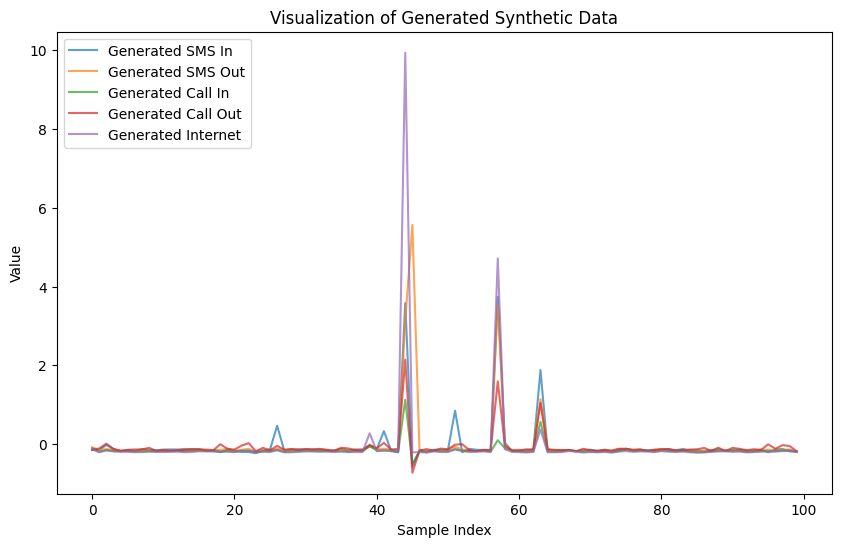

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import FileLink


plt.figure(figsize=(10, 6))

# Σχεδίαση γραμμών για κάθε χαρακτηριστικό των παραγόμενων δεδομένων (πρώτα 100 δείγματα)
plt.plot(synthetic_data[:100, 0], label='Generated SMS In', alpha=0.7)  # sms in
plt.plot(synthetic_data[:100, 1], label='Generated SMS Out', alpha=0.7)  # sms out
plt.plot(synthetic_data[:100, 2], label='Generated Call In', alpha=0.7)  # call in
plt.plot(synthetic_data[:100, 3], label='Generated Call Out', alpha=0.7)  # call out
plt.plot(synthetic_data[:100, 4], label='Generated Internet', alpha=0.7)  # internet

# Προσθήκη τίτλου και ετικετών αξόνων
plt.title('Visualization of Generated Synthetic Data')
plt.xlabel('Sample Index')
plt.ylabel('Value')
plt.legend(loc='upper left')

# Εμφάνιση του γραφήματος
plt.show()

# Αξιολόγηση Fidelity και Diversity Metrics

In [21]:
import numpy as np
from sklearn.metrics import mean_squared_error
from sklearn.metrics.pairwise import cosine_similarity
from scipy.stats import entropy

# Fidelity: MSE, Cosine Similarity, and KL Divergence

# Υπολογισμός Fidelity μέσω Mean Squared Error
def compute_fidelity(real_data, synthetic_data):
    return mean_squared_error(real_data, synthetic_data)

# Υπολογισμός μέσης Cosine Similarity μεταξύ πραγματικών και συνθετικών δεδομένων
def compute_cosine_similarity(real_data, synthetic_data):
    return cosine_similarity(real_data, synthetic_data).mean()

# Υπολογισμός KL Divergence μεταξύ των κατανομών πραγματικών και συνθετικών δεδομένων
def compute_kl_divergence(real_data, synthetic_data):
    # Δημιουργία ιστόγραμμα κατανομής (density) για κάθε dataset
    real_data_hist, _ = np.histogram(real_data, bins=50, density=True)
    synthetic_data_hist, _ = np.histogram(synthetic_data, bins=50, density=True)
    
    # Προσθήκη μικρού epsilon για αποφυγή διαίρεσης/λογαριθμού με μηδέν
    return entropy(real_data_hist + 1e-10, synthetic_data_hist + 1e-10)

# Υπολογισμός μετρικών Fidelity για τα πρώτα 100 δείγματα
fidelity_mse = compute_fidelity(input_data[:100], synthetic_data_normalized[:100])
cosine_sim = compute_cosine_similarity(input_data[:100], synthetic_data_normalized[:100])
kl_div = compute_kl_divergence(input_data[:100], synthetic_data_normalized[:100])

# Diversity: Variance and Coverage

# Υπολογισμός Diversity ως μέση διακύμανση (variance) σε κάθε χαρακτηριστικό
def compute_diversity(synthetic_data):
    return np.mean(np.var(synthetic_data, axis=0))

# Υπολογισμός Coverage: σχέση εύρους τιμών συνθετικών προς πραγματικά δεδομένα
def compute_coverage(real_data, synthetic_data):
    min_real, max_real = np.min(real_data, axis=0), np.max(real_data, axis=0)
    min_synthetic, max_synthetic = np.min(synthetic_data, axis=0), np.max(synthetic_data, axis=0)
    
    # Κάλυψη ανά χαρακτηριστικό, έπειτα μέσος όρος
    coverage = np.mean((max_synthetic - min_synthetic) / (max_real - min_real))
    return coverage

# Υπολογισμός Diversity και Coverage
diversity = compute_diversity(synthetic_data)
coverage = compute_coverage(input_data[:100], synthetic_data_normalized[:100])

# Εκτύπωση αποτελεσμάτων Fidelity και Diversity
print(f"Fidelity MSE: {fidelity_mse}")
print(f"Cosine Similarity: {cosine_sim}")
print(f"KL Divergence: {kl_div}")
print(f"Diversity (Variance): {diversity}")
print(f"Coverage: {coverage}")

Fidelity MSE: 0.20292159519126232
Cosine Similarity: 0.7836142376681086
KL Divergence: 4.912943895069592
Diversity (Variance): 0.45601417847591036
Coverage: 28.462279226230958


# Σύγκριση Πραγματικών έναντι Συνθετικών Δεδομένων

Fidelity (MSE): 0.20292159519126232
Cosine Similarity: 0.7836142376681086
KL Divergence: 4.912943895069592
Diversity (Mean Variance): 0.45601417847591036
Coverage: 28.462279226230958


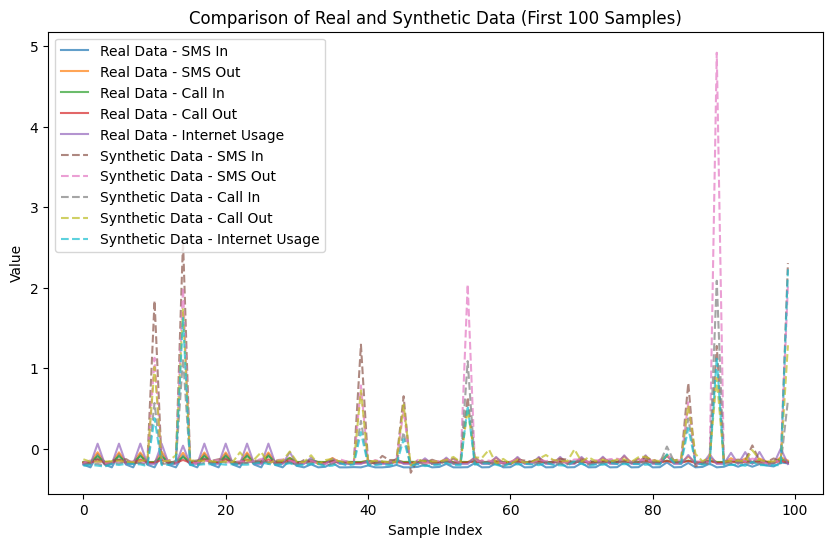

In [ ]:
print(f"Fidelity (MSE): {fidelity_mse}")
print(f"Cosine Similarity: {cosine_sim}")
print(f"KL Divergence: {kl_div}")
print(f"Diversity (Mean Variance): {diversity}")
print(f"Coverage: {coverage}")

# Οπτικοποίηση αποτελεσμάτων (πρώτα 100 δείγματα)
plt.figure(figsize=(10, 6))

# Σχεδίαση πραγματικών δεδομένων (πρώτα 100 δείγματα)
plt.plot(input_data[:100, 0], label='Real Data - SMS In', alpha=0.7)
plt.plot(input_data[:100, 1], label='Real Data - SMS Out', alpha=0.7)
plt.plot(input_data[:100, 2], label='Real Data - Call In', alpha=0.7)
plt.plot(input_data[:100, 3], label='Real Data - Call Out', alpha=0.7)
plt.plot(input_data[:100, 4], label='Real Data - Internet Usage', alpha=0.7)

# Σχεδίαση συνθετικών δεδομένων (πρώτα 100 δείγματα) με διακεκομμένη γραμμή
plt.plot(synthetic_data_normalized[:100, 0], label='Synthetic Data - SMS In', alpha=0.7, linestyle='--')
plt.plot(synthetic_data_normalized[:100, 1], label='Synthetic Data - SMS Out', alpha=0.7, linestyle='--')
plt.plot(synthetic_data_normalized[:100, 2], label='Synthetic Data - Call In', alpha=0.7, linestyle='--')
plt.plot(synthetic_data_normalized[:100, 3], label='Synthetic Data - Call Out', alpha=0.7, linestyle='--')
plt.plot(synthetic_data_normalized[:100, 4], label='Synthetic Data - Internet Usage', alpha=0.7, linestyle='--')

# Προσθήκη τίτλου, ετικετών αξόνων και υπομνήματος
plt.title('Comparison of Real and Synthetic Data (First 100 Samples)')
plt.xlabel('Sample Index')
plt.ylabel('Value')
plt.legend(loc='upper left')

# Εμφάνιση του γραφήματος 
plt.show()